## Introduction

This notebook illustrates the Julia code for computing geodesics for a general class of (unbalanced) optimal transport problems. It minimizes the action functional of an interpolation between two densities using a Douglas-Rachford proximal splitting scheme and uses staggered grids for finite difference computations.



In [1]:
using PyPlot,Interact,JLD
include("../src/dynamicUOT.jl");

DynamicUOT

## Definition
The code in src/geodesicUOT solves the minimization problem
$$
\min \int_0^1 \left[ \int_{\Omega} \frac1p \frac{|\omega|^p}{\rho^{p-1}}dx + 
\delta^p \int_{\Omega} \frac1q \frac{|\zeta|^q}{\rho^{q-1}}dx\right] dt
$$
subject to 
$$
\partial_t \rho + \nabla \cdot \omega = \zeta, \quad \rho(0,\cdot)=\rho_0 \quad  \text{and} \quad \rho(1,\cdot)=\rho_1 .
$$
This correspond to finding an interpolating path $(\rho_t)_{t\in T}$ of minimum energy. The energy depends on $\rho$, the momentum $\omega_t$ and the source (also called "reaction" by analysts) $\zeta_t$.

For solving this problem, just call

    solveGeodesic(ρ_0, ρ_1, T, ll, p, q, δ ,niter)
    
where the arguments have the following meaning:
* `ρ_0, ρ_1` : arrays (same dimensions) containing the densities;
* `T` : is the number of time discretization samples;
* `ll`: length of the times $\times$ space box;
* `p,q` : couple of integers : by convention, put `q=0` to forbid source. In particular:
  * `(1,0)` : $W_1$ 
  * `(2,0)` : $W_2$
  * `(1,1)` : $W_1-TV$ (a variation of bounded) Lipschitz;
  * `(1,2)` : $W_2-TV$ (a formulation of) optimal partial transport;
  * `(2,1)` : $W_1-FR$ interpolation between $W_1$ and Fisher-Rao;
  * `(2,2)` : The Wasserstein-Fisher-Rao metric $W\!F$;
* `δ` : interpolation weight, also determines the maximum distance mass can travel (when $q\neq 0)$. *Caution*: values of `\delta` above $10$ lead to ill-conditioned problems.
* `niter` : number of iterations.    

# I. Travelling Gaussian bumps in 1d
Notice how the behavior changes when $\delta$ varies near $\frac{1}{\pi}$. Consider a Gaussian of variance $\sigma$ and mass $1$ travelling from $x_0$ to $x_1$.

In [ ]:
σ = 0.03;
K = 256; X = linspace(0,1,K); # discretization of the time-space domain
gauss = (x,x_0,σ,mass) -> mass*(exp(-(x-x_0).^2/σ^2)*K/sum(exp(-(x-x_0).^2/σ^2))); # gaussian bump
ρ_0 = gauss(X,0.2,σ,1) + gauss(X,0.9,σ,2); #initial density
ρ_1 = gauss(X,0.3,σ,2) + gauss(X,0.65,σ,1); #final density
ρ_0/=sum(ρ_0)/30
ρ_1/=sum(ρ_1)/30
ll = [1.;1.]
figure(figsize=[12,3])
fill(X,ρ_0,"k",alpha=0.2);fill(X,ρ_1,"b",alpha=0.2);

In [3]:
T = 15 # number of time steps
ll = [1.0; 1.0]# size of the time × space box
@time x, lists = DynamicUOT.computeGeodesic(ρ_0, ρ_1, T, ll; p=2., q=2., δ = .5/π, niter = 3000);

Computing a geodesic for optimal transport with source...
Progress: 100.0%
Done.
 29.911170 seconds (210.10 M allocations: 11.481 GB, 6.77% gc time)


Interact.Slider{Int64}(Signal{Int64}(8, nactions=0),"t",8,1:15,"d",true)

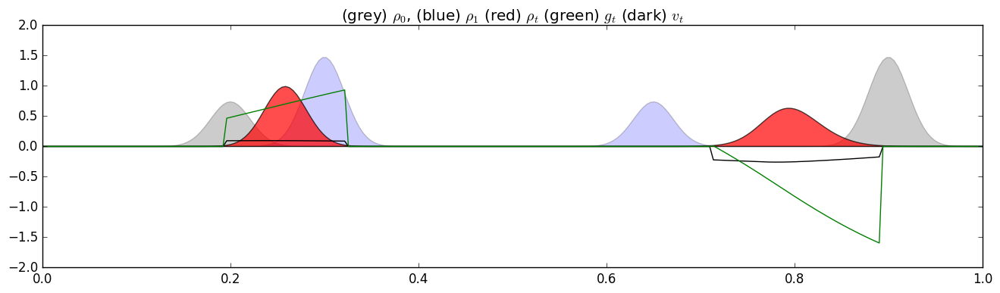

In [4]:
v,g = DynamicUOT.speedandgrowth(x)
f = figure(figsize=[16,4])
@manipulate for t=1:T ; withfig(f) do
        fill(X,ρ_0,"k",alpha=0.2);fill(X,ρ_1,"b",alpha=0.2)
        fill(X,x.V.D[1][t,:]   ,"r",alpha=0.7)
        plot(X,v[1][t,:]   ,"k")
        plot(X,g[t,:]   ,"g")
        title(L"(grey) $\rho_0$, (blue) $\rho_1$ (red) $\rho_{t}$ (green) $g_t$ (dark) $v_t$")
        axis([0;1;-2;2])
    end
end

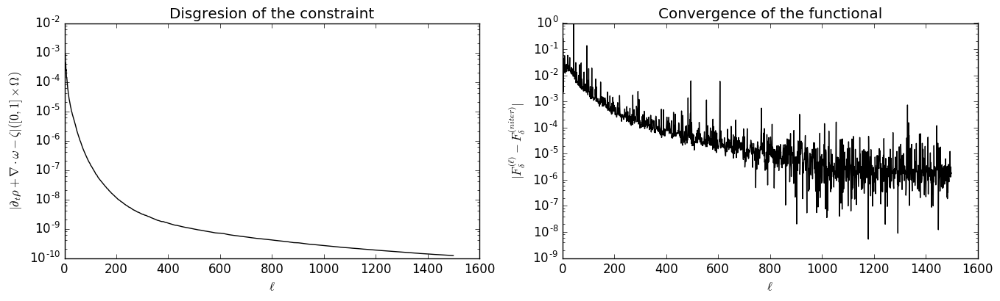

In [32]:
figure(figsize=[16,4])
subplot(1,2,1)
ylabel(L"$|\partial_t \rho + \nabla \cdot \omega - \zeta|([0,1]\times \Omega)$") 
xlabel(L"\ell")
title("Disgresion of the constraint")
semilogy(lists[2][1:end],"k")

subplot(1,2,2)
ylabel(L"$|F_{\delta}^{(\ell)}-F_{\delta}^{(niter)}|$")
xlabel(L"\ell")
title("Convergence of the functional")
minF = minimum(lists[1][end-10:end])
#plot(Fs); axis([1; length(lists[1]); minF; 1.01*minF])
semilogy(min(1,abs(lists[1][1:end]-mean(lists[1][end-10:end]))),"k");

# II. Deformation of a ring (2d)

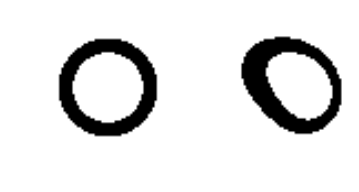

sum(ρ_0) = 772.0
sum(ρ_1) = 823.0


In [7]:
# create a ring
N   = 32; σ = N/100
ff(x,y) = 1.0*(1/4<x^2+y^2<1/2)
ρ_0 = Float64[ff(x,y) for x in linspace(-1.,1.,N), y in linspace(-1.,1.,N)]

# smooth deformation field
ker  = Float64[exp(-x^2/σ^2)/sqrt(2*π*σ^2)/10 for x in linspace(-1.,1.,N)]
indN = map(Int,floor(N/2))
v1   = conv2(ker,ker,randn(N,N));   v1 = v1[indN:indN+N-1,indN:indN+N-1]/1
v1   = conv2(ker,ker,v1);           v1 = v1[indN:indN+N-1,indN:indN+N-1]/1
v2   = conv2(ker,ker,randn(N,N));   v2 = v2[indN:indN+N-1,indN:indN+N-1]/1
v2   = conv2(ker,ker,v2);           v2 = v2[indN:indN+N-1,indN:indN+N-1]/1
push = (x,y) -> (x+1.*(v1[map(Int,floor(x*N/2+N/2+1)),map(Int,floor(y*N/2+N/2+1))]),y+
             1.*(v2[map(Int,floor(x*N/2+N/2+1)),map(Int,floor(y*N/2+N/2+1))]))
ρ_1  = Float64[ff(push(x,y)...) for x in linspace(-.99,.99,N), y in linspace(-.99,.99,N)]
# plot
figure(figsize=[4,10])
subplot(121)
imshow(ρ_0, cmap="Greys"); axis("off")
subplot(122)
imshow(ρ_1, cmap="Greys"); axis("off")
@show sum(ρ_0); @show sum(ρ_1);

In [8]:
T = 20;ll=[1.0;1.0;1.0]
@time x,lists = DynamicUOT.computeGeodesic(ρ_0, ρ_1, T, ll; p=2., q=2., δ = .5/π, niter = 1500);

Computing a geodesic for optimal transport with source...
Progress: 100.0%
Done.


LoadError: BoundsError: attempt to access (DynamicUOT.CSvar{3}((20,64,64),[1.0,1.0,1.0],DynamicUOT.Svar{3}((20,64,64),[1.0,1.0,1.0],Array{Float64,3}[
[0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 1.03773e-7 0.0 6.0021e-7 0.0 1.06152e-6 0.0 1.20935e-6 0.0 1.58897e-6 0.0 1.50725e-6 0.0 1.65127e-6 0.0 1.70605e-6 0.0 1.69745e-6 0.0 1.77502e-6 0.0 1.72812e-6 0.0 1.76809e-6 0.0 1.7423e-6 0.0 1.55601e-6 0.0 1.40093e-6 0.0 1.25472e-6 0.0 1.26858e-6 0.0 1.15469e-6 0.0 1.16926e-6 0.0 1.18133e-6 0.0 1.19658e-6 0.0 1.44916e-6 0.0 1.53858e-6 0.0 2.17391e-6 0.0 2.99085e-6 0.0 3.24634e-6 0.0 3.09466e-6 0.0 1.9834e-6 0.0 1.63785e-6 0.0 5.07986e-7 0.0 3.90049e-7 0.0 1.89775e-7 0.0; 0.0 4.59925e-7 0.0 1.16884e-6 0.0 1.70381e-6 0.0 2.24402e-6 0.0 2.56381e-6 0.0 2.66298e-6 0.0 2.90328e-6 0.0 3.00479e-6 0.0 3.02646e-6 0.0 3.04102e-6 0.0 3.04043e-6 0.0 2.78484e-6 0.0 2.78413e-6 0.0 2.54003e-6 0.0 2.3866e-6 0.0 2.18096e-6 0.0 1.94734e-6 0.0 1.99433e-6 0.0 1.68649e-6 0.0 1.94598e-6 0.0 2.36124e-6 0.0 2.69862e-6 0.0 3.09436e-6 0.0 3.43246e-6 0.0 3.78589e-6 0.0 3.65832e-6 0.0 3.38849e-6 0.0 2.62142e-6 0.0 1.43074e-6 0.0 9.00988e-7 0.0 1.21713e-6 0.0 5.08532e-7; 2.58205e-7 0.0 1.47339e-6 0.0 2.45268e-6 0.0 2.73461e-6 0.0 3.63411e-6 0.0 3.48598e-6 0.0 3.84455e-6 0.0 4.03799e-6 0.0 4.09938e-6 0.0 4.23088e-6 0.0 4.107e-6 0.0 3.79331e-6 0.0 3.86763e-6 0.0 3.62989e-6 0.0 3.34899e-6 0.0 3.03988e-6 0.0 3.00166e-6 0.0 2.80158e-6 0.0 2.88763e-6 0.0 3.04413e-6 0.0 2.86454e-6 0.0 3.45063e-6 0.0 3.37058e-6 0.0 4.26638e-6 0.0 4.18046e-6 0.0 4.429e-6 0.0 4.19076e-6 0.0 2.78888e-6 0.0 3.4479e-6 0.0 1.88102e-6 0.0 1.05824e-6 0.0 1.36432e-6 0.0; 0.0 7.67585e-7 0.0 1.80121e-6 0.0 2.61158e-6 0.0 3.51295e-6 0.0 4.02025e-6 0.0 4.29808e-6 0.0 4.78015e-6 0.0 5.04896e-6 0.0 5.06994e-6 0.0 5.06555e-6 0.0 4.99017e-6 0.0 4.62078e-6 0.0 4.51483e-6 0.0 3.97181e-6 0.0 3.74878e-6 0.0 3.66316e-6 0.0 3.27499e-6 0.0 3.46889e-6 0.0 2.97372e-6 0.0 3.3995e-6 0.0 4.21787e-6 0.0 4.532e-6 0.0 4.78327e-6 0.0 4.74602e-6 0.0 4.77118e-6 0.0 4.56917e-6 0.0 4.13183e-6 0.0 2.6145e-6 0.0 2.08771e-6 0.0 1.52733e-6 0.0 1.67684e-6 0.0 5.12813e-7; 3.33982e-7 0.0 1.92541e-6 0.0 3.08361e-6 0.0 3.53424e-6 0.0 4.78278e-6 0.0 4.58403e-6 0.0 5.16159e-6 0.0 5.60258e-6 0.0 5.75012e-6 0.0 5.87262e-6 0.0 5.69764e-6 0.0 5.48096e-6 0.0 5.3383e-6 0.0 4.76446e-6 0.0 4.39788e-6 0.0 3.96024e-6 0.0 3.93642e-6 0.0 3.87315e-6 0.0 4.23681e-6 0.0 4.5104e-6 0.0 4.28633e-6 0.0 5.09448e-6 0.0 4.99534e-6 0.0 5.65691e-6 0.0 5.12669e-6 0.0 5.1538e-6 0.0 4.60399e-6 0.0 2.66344e-6 0.0 3.8788e-6 0.0 1.82524e-6 0.0 1.16899e-6 0.0 7.9895e-7 0.0; 0.0 8.46306e-7 0.0 1.91935e-6 0.0 2.85195e-6 0.0 4.17603e-6 0.0 4.76446e-6 0.0 5.13075e-6 0.0 5.78974e-6 0.0 6.04332e-6 0.0 6.20941e-6 0.0 6.25927e-6 0.0 6.13505e-6 0.0 5.44998e-6 0.0 5.45845e-6 0.0 4.73581e-6 0.0 4.42056e-6 0.0 4.45717e-6 0.0 3.79101e-6 0.0 4.16892e-6 0.0 4.11349e-6 0.0 4.64198e-6 0.0 5.60526e-6 0.0 5.91559e-6 0.0 6.0725e-6 0.0 6.03282e-6 0.0 5.82214e-6 0.0 4.97926e-6 0.0 4.67466e-6 0.0 2.76374e-6 0.0 1.92301e-6 0.0 1.20868e-6 0.0 1.38412e-6 0.0 3.85747e-7; 3.62095e-7 0.0 2.10848e-6 0.0 3.21012e-6 0.0 3.8782e-6 0.0 5.31973e-6 0.0 5.04647e-6 0.0 5.6798e-6 0.0 6.14324e-6 0.0 6.38783e-6 0.0 6.58593e-6 0.0 6.43539e-6 0.0 6.08724e-6 0.0 5.70878e-6 0.0 5.42984e-6 0.0 5.08716e-6 0.0 4.6644e-6 0.0 4.59728e-6 0.0 4.59658e-6 0.0 5.27687e-6 0.0 5.23123e-6 0.0 5.51485e-6 0.0 5.99874e-6 0.0 6.29156e-6 0.0 6.5645e-6 0.0 6.32961e-6 0.0 6.14148e-6 0.0 5.41696e-6 0.0 2.9028e-6 0.0 4.16797e-6 0.0 1.8693e-6 0.0 1.24759e-6 0.0 6.88401e-7 0.0; 0.0 9.67033e-7 0.0 1.96927e-6 0.0 2.85121e-6 0.0 4.48795e-6 0.0 4.97673e-6 0.0 5.29004e-6 0.0 6.05517e-6 0.0 6.35869e-6 0.0 6.58746e-6 0.0 6.65324e-6 0.0 6.66021e-6 0.0 5.85408e-6 0.0 6.01601e-6 0.0 5.29606e-6 0.0 5.15449e-6 0.0 5.10381e-6 0.0 4.29486e-6 0.0 4.64441e-6 0.0 5.81497e-6 0.0 5.7524e-6 0.0 5.85815e-6 0.0 6.40447e-6 0.0 6.62953e-6 0.0 6.91304e-6 0.0 6.82578e-6 0.0 5.83048e-6 0.0 5.45746e-6 0.0 3.43584e-6 0.0 2.44826e-6 0.0 1.77115e-6 0.0 1.44769e-6 0.0 5.08841e-7; 3.71081e-7 0.0 2.08381e-6 0.0 3.08595e-6 0.0 3.85808e-6 0.0 5.19245e-6 0.0 4.81423e-6 0.0 5.61043e-6 0.0 6.11943e-6 0.0 6.4585e-6 0.0 6.87204e-6 0.0 6.72023e-6 0.0 6.41908e-6 0.0 6.1257e-6 0.0 5.98582e-6 0.0 5.25226e-6 0.0 4.8552e-6 0.0 5.20004e-6 0.0 5.22577e-6 0.0 5.718e-6 0.0 5.44766e-6 0.0 6.0356e-6 0.0 6.36023e-6 0.0 6.86581e-6 0.0 6.77119e-6 0.0 6.96902e-6 0.0 6.78053e-6 0.0 6.08895e-6 0.0 3.84791e-6 0.0 4.81173e-6 0.0 2.48962e-6 0.0 1.67411e-6 0.0 6.75683e-7 0.0; 0.0 9.15929e-7 0.0 1.75495e-6 0.0 2.47962e-6 0.0 4.10759e-6 0.0 4.47099e-6 0.0 4.7683e-6 0.0 5.62799e-6 0.0 6.076e-6 0.0 6.468e-6 0.0 6.70956e-6 0.0 7.04557e-6 0.0 6.33249e-6 0.0 6.41481e-6 0.0 5.30958e-6 0.0 5.70231e-6 0.0 5.66681e-6 0.0 4.72788e-6 0.0 4.50581e-6 0.0 6.38903e-6 0.0 6.32755e-6 0.0 5.66901e-6 0.0 6.41473e-6 0.0 6.89352e-6 0.0 7.37778e-6 0.0 7.39645e-6 0.0 6.43784e-6 0.0 5.87358e-6 0.0 3.98614e-6 0.0 2.74706e-6 0.0 2.28054e-6 0.0 1.33411e-6 0.0 5.38564e-7; 3.05462e-7 0.0 1.71004e-6 0.0 2.51552e-6 0.0 3.23729e-6 0.0 4.34342e-6 0.0 4.01198e-6 0.0 4.90577e-6 0.0 5.40072e-6 0.0 5.88883e-6 0.0 6.69777e-6 0.0 6.69586e-6 0.0 6.23682e-6 0.0 6.23588e-6 0.0 6.43394e-6 0.0 6.40482e-6 0.0 5.397e-6 0.0 5.69985e-6 0.0 4.98276e-6 0.0 5.63243e-6 0.0 5.38141e-6 0.0 6.26842e-6 0.0 6.40727e-6 0.0 7.13601e-6 0.0 7.17531e-6 0.0 7.44482e-6 0.0 7.17198e-6 0.0 6.31783e-6 0.0 4.14954e-6 0.0 4.85552e-6 0.0 2.66107e-6 0.0 1.48268e-6 0.0 5.50087e-7 0.0; 0.0 7.05645e-7 0.0 1.39462e-6 0.0 1.92271e-6 0.0 3.21762e-6 0.0 3.51906e-6 0.0 3.83321e-6 0.0 4.65363e-6 0.0 5.18351e-6 0.0 5.69122e-6 0.0 6.07137e-6 0.0 6.59355e-6 0.0 6.45467e-6 0.0 6.16303e-6 0.0 5.50197e-6 0.0 5.33659e-6 0.0 5.6621e-6 0.0 5.05008e-6 0.0 4.46732e-6 0.0 5.67475e-6 0.0 6.26748e-6 0.0 5.65077e-6 0.0 6.16589e-6 0.0 7.10244e-6 0.0 7.5346e-6 0.0 7.69025e-6 0.0 6.93362e-6 0.0 6.39969e-6 0.0 4.722e-6 0.0 2.74826e-6 0.0 2.44667e-6 0.0 9.32822e-7 0.0 6.75992e-7; 1.96689e-7 0.0 1.20556e-6 0.0 1.89244e-6 0.0 2.43055e-6 0.0 3.14842e-6 0.0 2.87338e-6 0.0 3.65906e-6 0.0 4.19597e-6 0.0 4.7585e-6 0.0 5.74736e-6 0.0 5.62657e-6 0.0 5.47005e-6 0.0 5.58761e-6 0.0 5.55138e-6 0.0 6.01457e-6 0.0 5.86336e-6 0.0 5.36141e-6 0.0 4.44476e-6 0.0 4.95138e-6 0.0 4.81586e-6 0.0 5.54941e-6 0.0 5.91768e-6 0.0 6.90723e-6 0.0 7.25602e-6 0.0 7.70034e-6 0.0 7.95279e-6 0.0 7.22268e-6 0.0 5.13433e-6 0.0 5.36945e-6 0.0 3.87883e-6 0.0 2.14651e-6 0.0 5.57934e-7 0.0; 0.0 4.18973e-7 0.0 1.06941e-6 0.0 1.35442e-6 0.0 2.14609e-6 0.0 2.29972e-6 0.0 2.46994e-6 0.0 3.184e-6 0.0 3.77637e-6 0.0 4.25509e-6 0.0 4.55229e-6 0.0 5.8905e-6 0.0 5.73321e-6 0.0 5.84079e-6 0.0 5.59807e-6 0.0 4.60419e-6 0.0 4.88256e-6 0.0 5.08048e-6 0.0 5.2632e-6 0.0 4.9488e-6 0.0 5.71523e-6 0.0 5.38102e-6 0.0 5.83717e-6 0.0 7.10083e-6 0.0 7.85615e-6 0.0 8.15284e-6 0.0 7.8529e-6 0.0 7.48017e-6 0.0 6.83813e-6 0.0 4.35995e-6 0.0 3.96208e-6 0.0 1.78357e-6 0.0 7.36327e-7; 5.89335e-8 0.0 6.13785e-7 0.0 1.19382e-6 0.0 1.50858e-6 0.0 1.85112e-6 0.0 1.59021e-6 0.0 2.18715e-6 0.0 2.64553e-6 0.0 3.14716e-6 0.0 4.39193e-6 0.0 4.42483e-6 0.0 4.28069e-6 0.0 4.59688e-6 0.0 4.14678e-6 0.0 4.81895e-6 0.0 5.03762e-6 0.0 3.60305e-6 0.0 3.88965e-6 0.0 4.29495e-6 0.0 4.25276e-6 0.0 4.76777e-6 0.0 5.47459e-6 0.0 6.34937e-6 0.0 6.65974e-6 0.0 7.51421e-6 0.0 8.06821e-6 0.0 8.63365e-6 0.0 7.98761e-6 0.0 8.12108e-6 0.0 6.95212e-6 0.0 3.69232e-6 0.0 9.83796e-7 0.0; 0.0 1.04053e-7 0.0 6.38214e-7 0.0 6.92957e-7 0.0 1.0901e-6 0.0 1.21836e-6 0.0 1.33216e-6 0.0 1.83134e-6 0.0 2.25227e-6 0.0 2.67694e-6 0.0 2.7927e-6 0.0 4.56282e-6 0.0 4.13472e-6 0.0 5.12172e-6 0.0 4.60513e-6 0.0 3.48737e-6 0.0 3.72588e-6 0.0 3.97153e-6 0.0 4.1896e-6 0.0 3.54347e-6 0.0 3.8482e-6 0.0 4.10657e-6 0.0 4.7558e-6 0.0 6.34567e-6 0.0 7.08545e-6 0.0 8.3869e-6 0.0 8.10449e-6 0.0 8.24395e-6 0.0 8.86442e-6 0.0 5.87083e-6 0.0 5.25747e-6 0.0 2.53477e-6 0.0 1.34048e-6; 0.0 0.0 2.43809e-7 0.0 6.39474e-7 0.0 7.91262e-7 0.0 9.71369e-7 0.0 7.9388e-7 0.0 1.10559e-6 0.0 1.27534e-6 0.0 1.54364e-6 0.0 2.90222e-6 0.0 2.45929e-6 0.0 2.44574e-6 0.0 2.70763e-6 0.0 2.05747e-6 0.0 3.07872e-6 0.0 3.21734e-6 0.0 2.40143e-6 0.0 2.73037e-6 0.0 3.38418e-6 0.0 3.11708e-6 0.0 3.28224e-6 0.0 3.90296e-6 0.0 4.38652e-6 0.0 5.4091e-6 0.0 8.19829e-6 0.0 8.37726e-6 0.0 8.45319e-6 0.0 7.81329e-6 0.0 7.06711e-6 0.0 6.25628e-6 0.0 3.81861e-6 0.0 1.51905e-6 0.0; 0.0 7.36997e-8 0.0 4.52883e-7 0.0 4.53592e-7 0.0 6.25156e-7 0.0 6.91851e-7 0.0 6.47987e-7 0.0 7.79765e-7 0.0 8.85308e-7 0.0 1.13017e-6 0.0 9.4342e-7 0.0 2.38919e-6 0.0 2.65254e-6 0.0 3.20255e-6 0.0 3.04693e-6 0.0 2.11426e-6 0.0 2.70066e-6 0.0 3.05937e-6 0.0 2.20911e-6 0.0 3.04909e-6 0.0 2.07515e-6 0.0 2.55512e-6 0.0 2.65342e-6 0.0 4.00827e-6 0.0 4.9789e-6 0.0 5.74507e-6 0.0 5.97828e-6 0.0 4.48737e-6 0.0 5.57813e-6 0.0 3.28157e-6 0.0 2.77606e-6 0.0 1.1519e-6 0.0 6.78095e-7; 3.41313e-9 0.0 1.47938e-7 0.0 3.49896e-7 0.0 4.19165e-7 0.0 4.66287e-7 0.0 3.77095e-7 0.0 4.57492e-7 0.0 3.96072e-7 0.0 4.27116e-7 0.0 1.042e-6 0.0 7.36455e-7 0.0 9.74333e-7 0.0 1.38674e-6 0.0 9.40654e-7 0.0 1.30136e-6 0.0 1.85766e-6 0.0 6.72311e-7 0.0 7.51748e-8 0.0 1.45299e-6 0.0 1.1164e-6 0.0 1.71837e-6 0.0 1.28195e-6 0.0 1.38804e-6 0.0 2.70973e-6 0.0 2.28926e-6 0.0 2.55517e-6 0.0 2.3901e-6 0.0 2.51842e-6 0.0 2.70327e-6 0.0 1.77e-6 0.0 8.26202e-7 0.0 6.42538e-7 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0]

[0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 4.25321e-7 0.0 1.28075e-6 0.0 1.88438e-6 0.0 2.41044e-6 0.0 2.57234e-6 0.0 2.37528e-6 0.0 2.55569e-6 0.0 2.49126e-6 0.0 2.36798e-6 0.0 2.24958e-6 0.0 2.07022e-6 0.0 1.45691e-6 0.0 1.53068e-6 0.0 1.11616e-6 0.0 7.24491e-7 0.0 3.28762e-7 0.0 0.0 0.0 0.0 0.0 0.0 7.0573e-8 0.0 5.5376e-7 0.0 4.73595e-7 0.0 1.07755e-6 0.0 7.53417e-7 0.0 1.48635e-6 0.0 1.35512e-6 0.0 1.66841e-6 0.0 3.53149e-6 0.0 3.04405e-6 0.0 3.40211e-6 0.0 2.20661e-6 0.0 8.29256e-7 0.0; 3.31122e-7 0.0 2.19324e-6 0.0 3.86077e-6 0.0 4.01035e-6 0.0 5.2691e-6 0.0 4.28465e-6 0.0 4.45872e-6 0.0 4.3487e-6 0.0 4.06679e-6 0.0 4.11279e-6 0.0 3.59375e-6 0.0 3.11807e-6 0.0 3.00761e-6 0.0 2.31914e-6 0.0 1.56574e-6 0.0 8.02566e-7 0.0 7.40801e-7 0.0 7.11804e-8 0.0 0.0 6.20645e-7 0.0 7.3146e-7 0.0 4.85552e-7 0.0 6.08588e-7 0.0 9.5313e-7 0.0 1.86747e-6 0.0 2.27088e-6 0.0 2.37909e-6 0.0 2.5498e-6 0.0 3.69104e-6 0.0 3.41653e-6 0.0 2.67569e-6 0.0 0.0 5.71976e-7 0.0; 0.0 1.08567e-6 0.0 2.96274e-6 0.0 4.28115e-6 0.0 5.6348e-6 0.0 6.02188e-6 0.0 5.70077e-6 0.0 5.98307e-6 0.0 5.91137e-6 0.0 5.46216e-6 0.0 5.09545e-6 0.0 4.83772e-6 0.0 3.87078e-6 0.0 3.36239e-6 0.0 2.10226e-6 0.0 1.51468e-6 0.0 9.50153e-7 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.04165e-6 0.0 6.23923e-7 0.0 2.09599e-6 0.0 8.88448e-7 0.0 2.62485e-6 0.0 2.26641e-6 0.0 2.45888e-6 0.0 4.97543e-6 0.0 1.66732e-6 0.0 3.35115e-6 0.0 3.31839e-6 0.0 0.0 0.0; 5.66497e-7 0.0 3.63332e-6 0.0 5.90746e-6 0.0 6.09477e-6 0.0 8.25113e-6 0.0 6.82516e-6 0.0 7.22711e-6 0.0 7.25446e-6 0.0 6.75015e-6 0.0 6.4948e-6 0.0 5.80244e-6 0.0 4.68753e-6 0.0 4.4676e-6 0.0 3.0484e-6 0.0 1.98563e-6 0.0 7.2761e-7 0.0 3.96576e-7 0.0 0.0 0.0 0.0 1.4658e-6 0.0 1.35048e-6 0.0 3.42163e-7 0.0 7.61232e-7 0.0 1.10397e-6 0.0 2.06326e-6 0.0 2.52699e-6 0.0 2.77652e-6 0.0 2.49947e-6 0.0 4.99487e-6 0.0 4.45276e-6 0.0 3.77121e-6 0.0 0.0 0.0 0.0; 0.0 1.39238e-6 0.0 3.33925e-6 0.0 4.81105e-6 0.0 6.85037e-6 0.0 7.41127e-6 0.0 7.34649e-6 0.0 7.92806e-6 0.0 7.74495e-6 0.0 7.12536e-6 0.0 6.71749e-6 0.0 6.06138e-6 0.0 4.24177e-6 0.0 3.89915e-6 0.0 1.95122e-6 0.0 9.33483e-7 0.0 4.29439e-7 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.8798e-6 0.0 1.02298e-6 0.0 2.40535e-6 0.0 1.13432e-6 0.0 2.75651e-6 0.0 2.09543e-6 0.0 2.46318e-6 0.0 6.39092e-6 0.0 1.2233e-6 0.0 4.01421e-6 0.0 2.7465e-6 0.0 6.09768e-7 6.98718e-8; 6.1604e-7 0.0 4.04643e-6 0.0 5.98886e-6 0.0 6.26748e-6 0.0 8.86462e-6 0.0 7.06705e-6 0.0 7.67581e-6 0.0 7.93888e-6 0.0 7.5386e-6 0.0 7.28481e-6 0.0 6.3819e-6 0.0 5.50149e-6 0.0 4.43253e-6 0.0 2.87064e-6 0.0 1.54513e-6 0.0 0.0 0.0 0.0 5.60683e-7 0.0 2.88641e-7 0.0 1.90184e-6 0.0 2.07967e-6 0.0 9.42822e-7 0.0 1.49005e-6 0.0 1.78241e-6 0.0 1.99616e-6 0.0 2.04104e-6 0.0 3.24531e-6 0.0 2.6326e-6 0.0 5.9552e-6 0.0 5.54746e-6 0.0 4.33459e-6 0.0 4.49639e-7 0.0 0.0; 0.0 1.34744e-6 0.0 2.84658e-6 0.0 3.91628e-6 0.0 6.62795e-6 0.0 6.82011e-6 0.0 6.52819e-6 0.0 7.4154e-6 0.0 7.11938e-6 0.0 6.92922e-6 0.0 6.51757e-6 0.0 6.04651e-6 0.0 3.85382e-6 0.0 3.69862e-6 0.0 1.12668e-6 0.0 0.0 0.0 0.0 0.0 0.0 4.16732e-8 0.0 0.0 0.0 1.21164e-6 0.0 2.16836e-6 0.0 2.31738e-6 0.0 2.68695e-6 0.0 2.43112e-6 0.0 2.79946e-6 0.0 2.33244e-6 0.0 2.64734e-6 0.0 7.47819e-6 0.0 1.37449e-6 0.0 4.66655e-6 0.0 3.06037e-6 0.0 1.08347e-6 1.05101e-7; 5.54045e-7 0.0 3.76821e-6 0.0 5.06546e-6 0.0 5.46416e-6 0.0 7.82848e-6 0.0 5.45426e-6 0.0 6.14039e-6 0.0 6.40644e-6 0.0 6.30395e-6 0.0 6.35945e-6 0.0 5.5333e-6 0.0 4.29542e-6 0.0 3.07965e-6 0.0 1.9895e-6 0.0 1.16579e-8 0.0 0.0 0.0 0.0 2.06596e-6 0.0 2.11826e-6 0.0 2.58679e-7 0.0 2.03776e-6 0.0 3.37165e-6 0.0 3.23265e-6 0.0 3.55027e-6 0.0 2.9363e-6 0.0 2.40689e-6 0.0 3.95215e-6 0.0 3.29672e-6 0.0 6.33432e-6 0.0 5.90014e-6 0.0 4.15594e-6 0.0 1.28794e-6 0.0 0.0; 0.0 1.13596e-6 0.0 1.90306e-6 0.0 2.39139e-6 0.0 5.3435e-6 0.0 4.98864e-6 0.0 4.3942e-6 0.0 5.35751e-6 0.0 5.27957e-6 0.0 5.17782e-6 0.0 4.91964e-6 0.0 4.87755e-6 0.0 2.27999e-6 0.0 2.38913e-6 0.0 0.0 0.0 0.0 7.00403e-7 0.0 4.35226e-7 0.0 1.29762e-6 0.0 1.14924e-6 0.0 3.26308e-6 0.0 3.21464e-6 0.0 3.96767e-6 0.0 3.78554e-6 0.0 4.66352e-6 0.0 4.05118e-6 0.0 3.73186e-6 0.0 4.15562e-6 0.0 8.14606e-6 0.0 2.17144e-6 0.0 4.9632e-6 0.0 3.1576e-6 0.0 1.7567e-6 2.03996e-7; 3.95041e-7 0.0 2.79508e-6 0.0 3.42905e-6 0.0 3.7901e-6 0.0 5.69817e-6 0.0 3.1586e-6 0.0 4.09599e-6 0.0 4.06319e-6 0.0 4.04297e-6 0.0 4.81941e-6 0.0 3.76314e-6 0.0 2.26905e-6 0.0 1.32926e-6 0.0 1.24757e-6 1.60712e-7 0.0 0.0 0.0 1.85092e-7 0.0 3.60415e-6 0.0 5.10415e-6 0.0 1.05116e-6 0.0 2.73366e-6 0.0 6.31857e-6 0.0 5.68401e-6 0.0 5.55892e-6 0.0 4.56381e-6 0.0 4.0367e-6 0.0 5.33581e-6 0.0 4.63649e-6 0.0 6.681e-6 0.0 6.4524e-6 0.0 3.72404e-6 0.0 1.98622e-6 0.0 0.0; 0.0 7.2663e-7 0.0 1.00364e-6 0.0 9.59071e-7 0.0 3.57645e-6 0.0 3.03227e-6 0.0 2.37301e-6 0.0 3.1988e-6 0.0 3.09685e-6 0.0 3.17068e-6 0.0 3.10238e-6 0.0 3.48841e-6 0.0 1.58713e-6 0.0 8.72254e-7 0.0 0.0 0.0 0.0 1.61876e-6 0.0 1.2405e-6 0.0 3.90793e-6 0.0 3.12885e-6 0.0 5.27097e-6 0.0 4.41845e-6 0.0 5.75401e-6 0.0 5.29956e-6 0.0 6.11754e-6 0.0 5.27073e-6 0.0 4.95345e-6 0.0 5.56391e-6 0.0 8.98624e-6 0.0 2.92183e-6 0.0 5.0354e-6 0.0 3.49846e-6 0.0 2.01779e-6 1.12e-7; 1.9987e-7 0.0 1.83844e-6 0.0 2.26895e-6 0.0 2.5424e-6 0.0 3.68644e-6 0.0 1.41178e-6 0.0 2.23408e-6 0.0 2.0732e-6 0.0 2.12498e-6 0.0 3.52302e-6 0.0 2.34636e-6 0.0 4.36023e-7 0.0 3.31603e-8 0.0 0.0 9.13116e-7 0.0 1.83217e-6 0.0 1.24965e-6 0.0 2.97318e-6 0.0 4.92563e-6 0.0 2.93179e-6 0.0 2.93067e-6 0.0 6.6621e-6 0.0 7.22508e-6 0.0 6.29708e-6 0.0 5.9685e-6 0.0 5.59552e-6 0.0 6.59315e-6 0.0 5.65972e-6 0.0 6.64852e-6 0.0 7.57002e-6 0.0 3.7694e-6 0.0 3.59839e-6 0.0 0.0; 0.0 3.70522e-7 0.0 8.34672e-7 0.0 6.44846e-7 0.0 2.25526e-6 0.0 1.62244e-6 0.0 8.7414e-7 0.0 1.38322e-6 0.0 1.39604e-6 0.0 1.42121e-6 0.0 1.16775e-6 0.0 2.47066e-6 0.0 1.45292e-6 0.0 0.0 8.81122e-8 0.0 0.0 0.0 2.05044e-7 0.0 1.5994e-6 0.0 4.36748e-6 0.0 3.61263e-6 0.0 5.07259e-6 0.0 4.75402e-6 0.0 5.92556e-6 0.0 5.53495e-6 0.0 6.79995e-6 0.0 6.89854e-6 0.0 5.96406e-6 0.0 6.46482e-6 0.0 9.44808e-6 0.0 3.12229e-6 0.0 4.87984e-6 0.0 3.76905e-6 0.0 2.47749e-6 3.92603e-7; 4.19495e-8 0.0 1.1122e-6 0.0 1.80359e-6 0.0 1.91607e-6 0.0 2.29269e-6 0.0 2.51515e-7 0.0 6.51864e-7 0.0 5.6321e-7 0.0 6.76334e-7 0.0 2.46641e-6 0.0 1.41407e-6 0.0 1.53542e-8 0.0 0.0 0.0 0.0 0.0 0.0 2.43148e-6 0.0 1.69454e-6 0.0 1.34701e-6 0.0 1.53894e-6 0.0 3.40381e-6 0.0 2.45887e-6 0.0 5.23297e-6 0.0 6.57724e-6 0.0 5.96251e-6 0.0 6.00976e-6 0.0 6.05637e-6 0.0 6.61305e-6 0.0 6.81206e-6 0.0 6.35034e-6 0.0 8.87312e-6 0.0 3.72216e-6 0.0 4.53527e-6 0.0 7.10556e-7; 2.71575e-8 8.97912e-8 0.0 1.07442e-6 0.0 7.66373e-7 0.0 1.48355e-6 0.0 8.42157e-7 0.0 0.0 0.0 3.74998e-7 0.0 5.87821e-7 0.0 7.33572e-7 0.0 3.50969e-7 0.0 3.84739e-6 0.0 1.64411e-6 0.0 2.10343e-6 1.5895e-6 3.16447e-8 0.0 0.0 0.0 0.0 3.24677e-6 0.0 2.78129e-6 0.0 2.26379e-6 0.0 3.6692e-6 0.0 4.01813e-6 0.0 4.5348e-6 0.0 5.14677e-6 0.0 6.95979e-6 0.0 6.49473e-6 0.0 5.78609e-6 0.0 5.58056e-6 0.0 8.46423e-6 0.0 3.76887e-6 0.0 4.5784e-6 0.0 3.47427e-6 0.0 2.08257e-6 1.30118e-6; 0.0 0.0 5.51099e-7 0.0 1.49383e-6 0.0 1.53154e-6 0.0 1.48396e-6 0.0 8.03897e-9 0.0 3.24007e-7 0.0 1.11945e-7 0.0 5.43862e-8 0.0 2.77707e-6 0.0 1.05283e-6 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.63979e-6 0.0 1.33823e-6 0.0 7.86226e-7 0.0 0.0 0.0 2.33559e-6 0.0 2.90465e-6 0.0 4.53458e-6 0.0 5.33086e-6 0.0 4.05389e-6 0.0 5.14052e-6 0.0 4.15167e-6 0.0 5.38463e-6 0.0 6.1259e-6 0.0 2.6737e-6 0.0 6.99253e-6 0.0 2.88285e-6 0.0 4.28688e-6 0.0 0.0; 5.68692e-8 6.47604e-8 0.0 1.18153e-6 0.0 9.16772e-7 0.0 1.15069e-6 0.0 7.21996e-7 0.0 1.10145e-8 0.0 2.0127e-7 0.0 2.49463e-7 0.0 2.93499e-7 0.0 0.0 0.0 3.35278e-6 0.0 1.68354e-6 1.9587e-7 3.25795e-6 2.87453e-6 1.35735e-6 5.09232e-7 0.0 9.06119e-7 0.0 3.697e-6 0.0 2.67809e-6 0.0 5.46386e-7 0.0 2.10543e-6 0.0 3.00436e-6 0.0 3.09981e-6 0.0 4.42719e-6 0.0 5.971e-6 0.0 4.99286e-6 0.0 4.76051e-6 0.0 4.79851e-6 0.0 5.28935e-6 0.0 2.78132e-6 0.0 2.64631e-6 0.0 2.23012e-6 0.0 1.68613e-6 1.06829e-7; 0.0 0.0 4.52082e-7 0.0 1.22504e-6 0.0 1.26052e-6 0.0 1.11059e-6 0.0 1.69756e-7 0.0 1.87733e-7 0.0 0.0 0.0 0.0 0.0 2.27107e-6 8.11594e-7 3.06656e-7 0.0 1.44426e-7 0.0 0.0 0.0 0.0 0.0 0.0 1.02165e-6 0.0 0.0 0.0 1.17872e-6 0.0 1.0413e-6 0.0 9.62948e-7 0.0 2.1785e-6 0.0 2.42693e-6 0.0 4.15023e-6 0.0 3.36369e-6 0.0 2.62882e-6 0.0 1.89907e-6 0.0 2.43951e-6 0.0 5.90809e-6 0.0 1.21351e-6 0.0 5.93835e-6 0.0 3.9065e-6 0.0 2.99233e-6 0.0 0.0; 2.44077e-8 5.95472e-8 0.0 6.55549e-7 0.0 5.89278e-7 0.0 6.50364e-7 0.0 5.00785e-7 0.0 2.27571e-7 0.0 2.5886e-7 0.0 7.82656e-8 9.95924e-8 9.06939e-9 0.0 0.0 0.0 1.10582e-6 0.0 1.83329e-6 0.0 2.022e-6 9.60812e-7 1.14798e-6 3.05437e-7 0.0 6.7575e-8 0.0 7.44254e-7 0.0 1.44876e-6 2.20608e-7 0.0 0.0 0.0 0.0 0.0 0.0 7.35466e-7 3.88321e-7 0.0 1.31267e-6 0.0 0.0 1.75977e-6 0.0 1.80008e-6 0.0 9.68554e-7 0.0 3.33247e-6 0.0 3.35422e-7 0.0 1.03043e-6 0.0 7.63652e-7 0.0 7.22444e-7 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0]

[0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 4.63426e-7 9.50816e-8 5.18311e-7 2.29372e-7 9.31761e-7 0.0 1.1355e-6 0.0 1.43173e-6 0.0 1.9411e-6 0.0 1.6341e-6 0.0 1.49312e-6 0.0 1.32349e-6 0.0 1.12171e-6 0.0 1.04354e-6 0.0 1.62738e-6 0.0 1.19387e-6 0.0 1.39985e-6 0.0 1.42738e-6 0.0 1.45168e-6 0.0 1.52067e-6 0.0 1.12797e-6 0.0 1.8654e-6 0.0 1.57368e-6 0.0 9.7629e-7 0.0 8.56115e-7 0.0 7.32472e-7 0.0 1.10986e-6 0.0 1.10484e-6 0.0 7.23504e-7 0.0 3.89839e-7 0.0 1.46311e-6 9.47806e-9 9.77713e-7 0.0 8.48571e-7 0.0 0.0 2.38663e-7 0.0; 1.97783e-7 0.0 0.0 0.0 0.0 0.0 1.30718e-6 0.0 7.68461e-7 0.0 3.01628e-6 0.0 2.9095e-6 0.0 2.8366e-6 0.0 2.7504e-6 0.0 2.07958e-6 0.0 2.28467e-6 0.0 2.41981e-6 0.0 1.98058e-6 0.0 2.34466e-6 0.0 2.62244e-6 0.0 2.85164e-6 0.0 2.09516e-6 0.0 2.35013e-6 0.0 1.95476e-6 0.0 1.94226e-6 0.0 2.75996e-6 0.0 1.93514e-6 0.0 3.06942e-6 0.0 1.05898e-6 0.0 2.56228e-6 0.0 1.60419e-6 0.0 1.29076e-6 0.0 3.64578e-6 0.0 0.0 0.0 2.23571e-6 0.0 8.38484e-7 1.1699e-6 0.0 2.69605e-7; 0.0 1.08462e-6 3.86619e-7 1.23706e-6 7.18939e-7 1.9963e-6 0.0 2.22254e-6 0.0 3.13503e-6 0.0 4.37729e-6 0.0 4.01159e-6 0.0 3.71175e-6 0.0 3.69591e-6 0.0 3.48418e-6 0.0 3.14378e-6 0.0 3.83482e-6 0.0 3.61794e-6 0.0 4.46124e-6 0.0 4.16945e-6 0.0 3.88122e-6 0.0 4.42081e-6 0.0 3.60996e-6 0.0 5.52615e-6 0.0 4.6289e-6 0.0 2.87898e-6 0.0 2.55699e-6 0.0 2.392e-6 0.0 3.31591e-6 0.0 3.29264e-6 0.0 2.81288e-6 0.0 2.13651e-6 0.0 4.48095e-6 0.0 3.7035e-6 0.0 2.83048e-6 0.0 0.0 1.59736e-6 0.0; 2.85684e-7 0.0 0.0 0.0 0.0 0.0 1.72359e-6 0.0 6.77862e-7 0.0 4.48742e-6 0.0 4.6664e-6 0.0 4.72215e-6 0.0 4.9943e-6 0.0 4.57618e-6 0.0 4.84135e-6 0.0 5.59778e-6 0.0 4.83327e-6 0.0 5.67163e-6 0.0 5.87679e-6 0.0 6.37523e-6 0.0 5.46862e-6 0.0 5.41581e-6 0.0 4.39161e-6 0.0 3.47908e-6 0.0 5.80493e-6 0.0 3.80374e-6 0.0 5.60321e-6 0.0 2.70218e-6 0.0 4.93344e-6 0.0 3.25058e-6 0.0 3.21512e-6 0.0 7.66186e-6 0.0 3.49581e-7 0.0 4.22695e-6 0.0 2.60875e-6 7.86305e-7 3.19565e-7 3.04362e-7; 0.0 1.21312e-6 9.12032e-7 1.77401e-6 9.48119e-7 2.62883e-6 0.0 2.19392e-6 0.0 3.52535e-6 0.0 5.28163e-6 0.0 5.27987e-6 0.0 5.6904e-6 0.0 6.16718e-6 0.0 6.09686e-6 0.0 6.2585e-6 0.0 7.83339e-6 0.0 6.9366e-6 0.0 8.25237e-6 0.0 8.09812e-6 0.0 7.12012e-6 0.0 8.54061e-6 0.0 7.02598e-6 0.0 9.25606e-6 0.0 7.39334e-6 0.0 4.20844e-6 0.0 4.35098e-6 0.0 4.26743e-6 0.0 4.74095e-6 0.0 4.5373e-6 0.0 5.0196e-6 0.0 3.81516e-6 0.0 7.95652e-6 0.0 6.78978e-6 0.0 5.14249e-6 0.0 0.0 0.0 0.0; 1.87132e-7 0.0 0.0 0.0 0.0 0.0 1.31447e-6 0.0 0.0 0.0 4.84309e-6 0.0 5.46664e-6 0.0 5.92907e-6 0.0 6.74384e-6 0.0 6.91703e-6 0.0 7.84301e-6 0.0 8.31392e-6 0.0 8.47022e-6 0.0 9.02215e-6 0.0 9.05134e-6 0.0 9.74286e-6 0.0 8.88759e-6 0.0 8.55644e-6 0.0 6.53376e-6 0.0 6.53563e-6 0.0 7.76236e-6 0.0 5.96121e-6 0.0 6.88831e-6 0.0 4.88658e-6 0.0 5.99079e-6 0.0 4.50939e-6 0.0 4.55354e-6 0.0 1.11265e-5 0.0 1.74351e-6 0.0 6.18394e-6 0.0 4.2185e-6 0.0 1.14216e-6 1.37498e-7; 0.0 7.33519e-7 1.78558e-6 1.51158e-6 1.33673e-6 2.73779e-6 0.0 1.25578e-6 4.64413e-7 3.29639e-6 0.0 5.695e-6 0.0 5.72385e-6 0.0 7.03373e-6 0.0 7.76169e-6 0.0 8.43373e-6 0.0 8.74326e-6 0.0 1.10546e-5 0.0 9.69829e-6 0.0 1.15868e-5 0.0 1.15731e-5 0.0 9.90455e-6 0.0 1.21756e-5 0.0 9.98153e-6 0.0 8.63956e-6 0.0 8.8156e-6 0.0 7.09878e-6 0.0 7.02505e-6 0.0 6.84125e-6 0.0 5.97551e-6 0.0 5.03811e-6 0.0 6.9362e-6 0.0 5.62209e-6 0.0 1.03799e-5 0.0 9.50768e-6 0.0 6.92313e-6 0.0 1.36768e-6 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 5.31486e-7 0.0 0.0 0.0 5.0572e-6 0.0 5.68581e-6 0.0 6.63441e-6 0.0 7.79561e-6 0.0 8.23031e-6 0.0 9.54132e-6 0.0 1.08712e-5 0.0 1.16656e-5 0.0 1.17687e-5 0.0 1.26845e-5 0.0 1.30041e-5 0.0 1.11138e-5 0.0 1.00669e-5 0.0 7.50011e-6 0.0 9.20815e-6 0.0 8.25738e-6 0.0 8.32251e-6 0.0 7.50013e-6 0.0 7.78097e-6 0.0 7.24067e-6 0.0 6.23779e-6 0.0 6.63071e-6 0.0 1.36904e-5 0.0 3.8427e-6 0.0 8.69838e-6 0.0 5.36176e-6 0.0 2.38275e-6 1.81855e-7; 9.31087e-8 8.94053e-8 2.22523e-6 1.11104e-6 1.42571e-6 2.67088e-6 0.0 4.01313e-7 7.93395e-7 3.0142e-6 0.0 5.82782e-6 0.0 6.03877e-6 0.0 7.64651e-6 0.0 8.84235e-6 0.0 9.63244e-6 0.0 9.60413e-6 0.0 1.28499e-5 0.0 1.16546e-5 0.0 1.41148e-5 0.0 1.21983e-5 0.0 1.12605e-5 0.0 1.4366e-5 0.0 1.29847e-5 0.0 6.29258e-6 0.0 7.93433e-6 0.0 1.10381e-5 0.0 9.08566e-6 0.0 9.12306e-6 0.0 7.51144e-6 0.0 6.55192e-6 0.0 8.75952e-6 0.0 7.69534e-6 0.0 1.16733e-5 0.0 1.10781e-5 0.0 7.31362e-6 0.0 3.16412e-6 0.0 0.0; 0.0 2.594e-8 0.0 0.0 0.0 0.0 1.21711e-7 0.0 0.0 0.0 5.04776e-6 0.0 5.45504e-6 0.0 7.2249e-6 0.0 8.6806e-6 0.0 8.32589e-6 0.0 1.02021e-5 0.0 1.21564e-5 0.0 1.28285e-5 0.0 1.14059e-5 0.0 1.21795e-5 0.0 1.38272e-5 0.0 1.06511e-5 0.0 1.06406e-5 0.0 8.55466e-6 0.0 1.0177e-5 0.0 8.2586e-6 0.0 8.80001e-6 0.0 8.00164e-6 0.0 9.39622e-6 0.0 8.16641e-6 0.0 7.99543e-6 0.0 9.0771e-6 0.0 1.48299e-5 0.0 5.65902e-6 0.0 9.1062e-6 0.0 6.43923e-6 0.0 3.73624e-6 0.0; 8.77995e-8 0.0 1.87424e-6 8.10795e-7 1.11731e-6 2.43996e-6 0.0 1.09131e-7 6.55339e-7 2.7012e-6 0.0 5.58791e-6 0.0 6.02701e-6 0.0 7.74765e-6 0.0 8.85404e-6 0.0 9.62799e-6 0.0 9.08226e-6 0.0 1.16714e-5 0.0 1.13736e-5 0.0 1.45061e-5 0.0 1.19445e-5 0.0 9.48123e-6 0.0 1.12283e-5 0.0 1.23205e-5 0.0 4.47939e-6 0.0 4.54914e-6 0.0 1.03147e-5 0.0 9.68751e-6 0.0 8.84233e-6 0.0 7.85023e-6 0.0 7.78654e-6 0.0 1.02399e-5 0.0 9.37822e-6 0.0 1.19779e-5 0.0 1.25487e-5 0.0 7.2033e-6 0.0 5.41329e-6 0.0 2.10612e-8; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 4.82249e-6 0.0 5.16032e-6 0.0 6.97226e-6 0.0 8.27514e-6 0.0 6.99712e-6 0.0 8.99173e-6 0.0 1.1523e-5 0.0 1.14212e-5 0.0 1.01344e-5 0.0 8.3094e-6 0.0 9.24829e-6 0.0 6.91235e-6 0.0 1.0079e-5 0.0 6.33547e-6 0.0 7.77832e-6 0.0 5.26369e-6 0.0 7.26423e-6 0.0 6.40094e-6 0.0 8.30944e-6 0.0 8.40661e-6 0.0 8.44505e-6 0.0 1.03034e-5 0.0 1.58307e-5 0.0 6.65683e-6 0.0 9.62361e-6 0.0 7.07379e-6 0.0 4.1831e-6 1.7717e-9; 0.0 1.40103e-7 1.09635e-6 3.0895e-7 9.52835e-7 1.66198e-6 1.37951e-7 3.10889e-7 5.27951e-8 2.5693e-6 0.0 5.19589e-6 0.0 5.90955e-6 0.0 7.27005e-6 0.0 8.11282e-6 0.0 8.75124e-6 0.0 6.47731e-6 0.0 7.51804e-6 0.0 8.72756e-6 0.0 9.23044e-6 0.0 1.05683e-5 0.0 7.19802e-6 0.0 5.53268e-6 0.0 5.06442e-6 0.0 4.33218e-6 0.0 1.77302e-6 0.0 6.44501e-6 0.0 7.84076e-6 0.0 6.59483e-6 0.0 7.17456e-6 0.0 7.85066e-6 0.0 1.05849e-5 0.0 1.0513e-5 0.0 1.21243e-5 0.0 1.39528e-5 0.0 7.40034e-6 0.0 7.44386e-6 0.0 0.0; 1.28352e-7 0.0 0.0 1.35946e-7 0.0 0.0 0.0 0.0 7.93746e-8 0.0 4.46049e-6 0.0 5.12865e-6 0.0 6.5574e-6 0.0 7.42321e-6 0.0 5.0406e-6 0.0 6.62576e-6 0.0 8.64387e-6 0.0 8.42089e-6 0.0 9.02578e-6 0.0 6.35753e-6 0.0 3.06681e-6 0.0 5.32668e-6 0.0 5.10091e-6 0.0 3.20459e-6 0.0 3.94976e-6 0.0 3.70895e-6 0.0 4.33404e-6 0.0 4.58318e-6 0.0 7.56297e-6 0.0 8.42737e-6 0.0 8.40018e-6 0.0 9.91447e-6 0.0 1.4284e-5 0.0 6.91932e-6 0.0 8.87447e-6 0.0 6.84e-6 0.0 4.44545e-6 0.0; 0.0 2.78217e-7 5.09537e-7 0.0 1.09284e-6 6.72564e-7 4.10086e-7 3.4874e-7 0.0 2.22628e-6 0.0 4.57813e-6 0.0 5.14217e-6 0.0 5.93995e-6 0.0 6.44448e-6 0.0 7.06028e-6 0.0 1.31084e-6 0.0 3.68946e-6 0.0 2.09646e-6 0.0 3.39874e-6 0.0 6.53846e-6 0.0 4.11998e-6 0.0 1.03566e-6 0.0 0.0 0.0 1.97814e-6 0.0 6.56947e-7 0.0 3.32172e-6 0.0 4.92234e-6 0.0 4.67203e-6 0.0 6.59573e-6 0.0 6.86293e-6 0.0 9.02691e-6 0.0 9.33853e-6 0.0 7.53708e-6 0.0 1.43723e-5 0.0 7.03195e-6 0.0 8.20249e-6 0.0 0.0; 2.17095e-7 0.0 0.0 8.38444e-7 0.0 0.0 0.0 0.0 3.036e-7 0.0 3.48004e-6 0.0 3.90961e-6 0.0 5.16631e-6 0.0 5.97395e-6 0.0 1.86886e-6 0.0 4.25273e-6 0.0 6.53546e-6 0.0 5.69624e-6 0.0 8.60336e-6 0.0 3.23991e-6 0.0 7.81956e-7 0.0 5.65295e-6 0.0 2.36429e-6 0.0 0.0 0.0 1.14531e-6 0.0 1.43608e-6 0.0 1.56673e-6 0.0 2.65284e-6 0.0 8.53593e-6 0.0 8.69733e-6 0.0 7.33519e-6 0.0 7.69323e-6 0.0 1.21865e-5 0.0 5.94364e-6 0.0 7.54344e-6 0.0 5.53022e-6 0.0 3.80057e-6 8.08751e-7; 0.0 1.63488e-7 2.95659e-7 0.0 1.13172e-6 0.0 5.27929e-7 2.37894e-7 0.0 1.54395e-6 0.0 3.29819e-6 0.0 3.68025e-6 0.0 4.16057e-6 0.0 4.32381e-6 0.0 5.92728e-6 0.0 0.0 0.0 9.10026e-7 0.0 0.0 0.0 0.0 0.0 2.73372e-6 0.0 3.54962e-7 0.0 0.0 0.0 0.0 0.0 0.0 0.0 2.60831e-7 0.0 7.05229e-7 0.0 2.9255e-6 0.0 1.06335e-6 0.0 3.37302e-6 0.0 2.79255e-6 0.0 5.23643e-6 0.0 8.30823e-6 0.0 2.87189e-6 0.0 9.6506e-6 0.0 6.18932e-6 0.0 7.57472e-6 0.0 2.84726e-7; 1.32701e-7 0.0 0.0 9.31852e-7 0.0 1.83866e-7 0.0 0.0 2.14616e-7 0.0 2.13133e-6 0.0 2.50941e-6 0.0 3.34751e-6 0.0 3.7367e-6 0.0 0.0 0.0 2.59947e-6 1.31023e-6 2.77548e-6 1.11617e-7 3.21596e-6 2.69229e-6 5.30726e-6 9.2094e-7 1.51816e-6 0.0 5.40531e-7 0.0 1.6009e-6 0.0 1.30226e-6 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 3.38111e-6 0.0 3.2319e-7 0.0 7.09987e-6 0.0 4.70671e-6 0.0 5.98372e-6 0.0 4.80029e-6 0.0 2.10471e-6 0.0 3.07028e-6 0.0 2.27572e-6 0.0 2.54959e-6 6.89541e-7; 0.0 9.97458e-8 7.52952e-8 0.0 5.20992e-7 0.0 2.66043e-7 1.07565e-7 0.0 5.98506e-7 0.0 1.27236e-6 0.0 1.39471e-6 0.0 1.81098e-6 0.0 1.86595e-6 9.45588e-8 3.09447e-6 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 7.54242e-7 0.0 0.0 0.0 3.26009e-6 0.0 0.0 2.60582e-6 2.53759e-6 0.0 0.0 2.50563e-6 0.0 0.0 0.0 0.0 0.0 0.0 6.25017e-7 1.26775e-6 6.42638e-7 0.0 1.69448e-6 0.0 2.79501e-6 0.0 1.04647e-6 0.0 4.52836e-6 0.0 1.59646e-6 0.0 9.52685e-7 2.26615e-8 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0]

[0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 0.0 0.0 4.6912e-7 0.0 6.15878e-7 0.0 9.42675e-7 0.0 1.06231e-6 0.0 8.16163e-7 0.0 1.54805e-6 0.0 1.91931e-6 0.0 2.19704e-6 0.0 2.52157e-6 0.0 2.71778e-6 0.0 2.08887e-6 0.0 2.69759e-6 0.0 2.39186e-6 0.0 2.20366e-6 0.0 1.92691e-6 0.0 1.57887e-6 0.0 1.90161e-6 0.0 8.87263e-7 0.0 1.2855e-6 0.0 2.12907e-6 0.0 2.25075e-6 0.0 2.25239e-6 0.0 1.40659e-6 0.0 1.05593e-6 0.0 9.88412e-7 0.0 7.13548e-7 1.4117e-6 0.0 0.0 0.0 1.25355e-6 0.0 3.48703e-7 5.19438e-7 0.0 1.54478e-7; 3.85974e-8 2.12783e-7 1.69664e-6 0.0 3.18221e-6 0.0 1.89232e-6 0.0 3.6938e-6 0.0 1.61309e-6 0.0 2.46653e-6 0.0 3.00665e-6 0.0 3.39307e-6 0.0 4.46268e-6 0.0 4.395e-6 0.0 4.40641e-6 0.0 5.06822e-6 0.0 4.58465e-6 0.0 4.09632e-6 0.0 3.4144e-6 0.0 3.99693e-6 0.0 3.3622e-6 0.0 3.64246e-6 0.0 3.65351e-6 0.0 2.52584e-6 0.0 3.62342e-6 0.0 1.89945e-6 0.0 4.24132e-6 0.0 1.42111e-6 0.0 1.91958e-6 0.0 1.41584e-6 0.0 0.0 1.8463e-6 2.0144e-6 1.73146e-6 0.0 1.81053e-6 0.0 0.0 8.46436e-7 0.0; 0.0 0.0 0.0 9.19085e-7 0.0 1.33777e-6 0.0 2.53239e-6 0.0 2.90503e-6 0.0 2.50033e-6 0.0 3.82788e-6 0.0 4.75049e-6 0.0 5.225e-6 0.0 5.93843e-6 0.0 6.67695e-6 0.0 5.92324e-6 0.0 6.42402e-6 0.0 5.32313e-6 0.0 5.47816e-6 0.0 5.42098e-6 0.0 4.2462e-6 0.0 4.9212e-6 0.0 2.02668e-6 0.0 3.08316e-6 0.0 5.37171e-6 0.0 5.59544e-6 0.0 5.35655e-6 0.0 3.26384e-6 0.0 2.35637e-6 0.0 1.82743e-6 0.0 1.58461e-6 3.4058e-6 0.0 0.0 0.0 1.91033e-6 0.0 9.82455e-7 3.23997e-6 0.0 6.84794e-7; 1.58211e-7 1.29493e-7 3.15207e-6 0.0 5.11896e-6 0.0 3.33178e-6 0.0 6.55929e-6 0.0 3.15461e-6 0.0 4.32088e-6 0.0 5.28876e-6 0.0 5.80188e-6 0.0 7.132e-6 0.0 7.38479e-6 0.0 6.96849e-6 0.0 8.30917e-6 0.0 7.48903e-6 0.0 7.24106e-6 0.0 6.23869e-6 0.0 6.9055e-6 0.0 6.40481e-6 0.0 7.17553e-6 0.0 7.94417e-6 0.0 4.22163e-6 0.0 6.48314e-6 0.0 3.34637e-6 0.0 6.64207e-6 0.0 2.49217e-6 0.0 3.5213e-6 0.0 2.20737e-6 0.0 0.0 3.43887e-6 3.76652e-6 3.27977e-6 0.0 2.57016e-6 0.0 0.0 1.11333e-6 0.0; 0.0 4.33192e-8 0.0 1.07962e-6 0.0 1.64157e-6 0.0 4.01427e-6 0.0 4.24756e-6 0.0 3.73414e-6 0.0 5.41191e-6 0.0 6.3217e-6 0.0 7.00696e-6 0.0 8.21165e-6 0.0 8.94583e-6 0.0 7.74708e-6 0.0 9.38564e-6 0.0 7.92512e-6 0.0 8.03067e-6 0.0 8.81563e-6 0.0 6.19094e-6 0.0 7.30638e-6 0.0 2.8915e-6 0.0 4.64351e-6 0.0 8.30527e-6 0.0 7.1589e-6 0.0 6.29427e-6 0.0 4.32636e-6 0.0 3.2165e-6 0.0 1.16979e-6 0.0 1.50838e-6 5.98168e-6 0.0 0.0 0.0 2.83486e-6 0.0 1.7848e-6 2.59178e-6 0.0 7.88947e-7; 3.06548e-7 0.0 4.26071e-6 0.0 5.75847e-6 0.0 4.27552e-6 0.0 8.33387e-6 0.0 3.72677e-6 0.0 5.0433e-6 0.0 6.36424e-6 0.0 7.11661e-6 0.0 8.65665e-6 0.0 8.97884e-6 0.0 9.62547e-6 0.0 1.0397e-5 0.0 1.01873e-5 0.0 1.02324e-5 0.0 8.88579e-6 0.0 9.41238e-6 0.0 8.6977e-6 0.0 9.95994e-6 0.0 8.63725e-6 0.0 5.2714e-6 0.0 6.63118e-6 0.0 3.87805e-6 0.0 5.28726e-6 0.0 2.16596e-6 0.0 2.93967e-6 0.0 1.539e-6 0.0 0.0 5.61692e-6 3.38647e-6 5.58844e-6 0.0 4.19367e-6 0.0 0.0 7.24831e-8 0.0; 0.0 3.10127e-7 0.0 8.1742e-7 0.0 9.59112e-7 0.0 5.00402e-6 0.0 4.7516e-6 0.0 3.90043e-6 0.0 6.05251e-6 0.0 6.43069e-6 0.0 7.63758e-6 0.0 9.00105e-6 0.0 1.05975e-5 0.0 9.14321e-6 0.0 1.18692e-5 0.0 9.81083e-6 0.0 9.57098e-6 0.0 1.10986e-5 0.0 6.77924e-6 0.0 8.16342e-6 0.0 7.66534e-6 0.0 5.50232e-6 0.0 6.66182e-6 0.0 4.7008e-6 0.0 3.259e-6 0.0 2.88386e-6 0.0 2.86575e-6 0.0 0.0 0.0 2.38034e-7 9.00365e-6 0.0 0.0 0.0 4.47871e-6 0.0 2.65871e-6 9.34709e-7 4.67335e-7 8.33484e-7; 3.86292e-7 0.0 4.57116e-6 0.0 5.31501e-6 0.0 4.61767e-6 0.0 8.79976e-6 0.0 3.41678e-6 0.0 4.95625e-6 0.0 5.94335e-6 0.0 6.74033e-6 0.0 8.73369e-6 0.0 9.56933e-6 0.0 1.0179e-5 0.0 1.07619e-5 0.0 1.15497e-5 0.0 1.06249e-5 0.0 9.28687e-6 0.0 1.0527e-5 0.0 1.01093e-5 0.0 1.128e-5 0.0 6.63547e-6 0.0 5.88913e-6 0.0 3.47029e-6 0.0 2.94742e-6 0.0 8.73114e-7 0.0 4.10656e-7 0.0 1.02962e-6 6.64884e-7 0.0 1.89915e-7 0.0 7.11214e-6 1.65937e-6 7.4759e-6 0.0 4.63194e-6 0.0 2.10161e-7 0.0 0.0; 0.0 8.15311e-7 0.0 8.41704e-7 0.0 5.78539e-7 0.0 5.77512e-6 0.0 4.74167e-6 0.0 3.33219e-6 0.0 5.47758e-6 0.0 5.86626e-6 0.0 6.90245e-6 0.0 8.62624e-6 0.0 1.12737e-5 0.0 9.36884e-6 0.0 1.2187e-5 0.0 9.48827e-6 0.0 1.15173e-5 0.0 1.18313e-5 0.0 5.43847e-6 0.0 5.87565e-6 0.0 1.22495e-5 0.0 7.50187e-6 0.0 8.15056e-7 0.0 1.35912e-6 0.0 0.0 0.0 3.37914e-7 0.0 6.5443e-7 0.0 0.0 1.52799e-6 0.0 1.1612e-5 0.0 0.0 0.0 7.13195e-6 0.0 4.57602e-6 0.0 2.6877e-6 6.82762e-7; 5.29181e-7 0.0 4.62108e-6 0.0 5.15819e-6 0.0 5.20499e-6 0.0 8.73768e-6 0.0 2.91897e-6 0.0 4.80332e-6 0.0 5.1779e-6 0.0 5.95171e-6 0.0 9.06224e-6 0.0 9.20841e-6 0.0 9.06733e-6 0.0 9.75513e-6 0.0 1.25125e-5 0.0 1.15596e-5 0.0 8.1298e-6 0.0 1.08332e-5 0.0 8.96248e-6 0.0 8.73665e-6 0.0 4.13104e-6 0.0 4.62077e-6 0.0 1.78649e-6 0.0 9.6826e-7 0.0 0.0 0.0 0.0 0.0 0.0 3.78809e-6 0.0 3.92353e-6 0.0 9.45568e-6 0.0 1.09284e-5 0.0 6.36493e-6 0.0 3.70237e-6 0.0 0.0; 0.0 1.34502e-6 0.0 1.76921e-6 0.0 1.41311e-6 0.0 6.49291e-6 0.0 5.08804e-6 0.0 3.30563e-6 0.0 5.22244e-6 0.0 5.52843e-6 0.0 6.52013e-6 0.0 7.962e-6 0.0 1.1002e-5 0.0 9.03754e-6 0.0 1.05747e-5 0.0 6.75572e-6 0.0 9.21912e-6 0.0 1.12133e-5 0.0 6.84154e-6 0.0 2.24315e-6 0.0 1.04525e-5 0.0 7.81509e-6 0.0 0.0 0.0 0.0 0.0 0.0 1.03436e-6 0.0 1.33483e-6 0.0 2.4701e-6 0.0 5.413e-6 0.0 1.452e-5 0.0 3.46801e-6 0.0 9.01113e-6 0.0 7.00645e-6 0.0 4.21191e-6 2.45202e-7; 5.39339e-7 0.0 4.38667e-6 0.0 5.53601e-6 0.0 6.20389e-6 0.0 8.58115e-6 0.0 3.27185e-6 0.0 4.88844e-6 0.0 4.80497e-6 0.0 5.42292e-6 0.0 9.34794e-6 0.0 8.64958e-6 0.0 7.05253e-6 0.0 7.89228e-6 0.0 1.04841e-5 0.0 1.16901e-5 0.0 9.78108e-6 0.0 1.10427e-5 0.0 3.30154e-6 0.0 5.43867e-6 0.0 9.35231e-7 0.0 2.42943e-6 0.0 0.0 1.23096e-6 0.0 9.83519e-7 0.0 1.68797e-6 0.0 2.69784e-6 0.0 6.96498e-6 0.0 6.90041e-6 0.0 1.11415e-5 0.0 1.43849e-5 0.0 7.16365e-6 0.0 7.04323e-6 0.0 0.0; 0.0 1.47155e-6 0.0 3.16609e-6 0.0 3.18437e-6 0.0 6.78943e-6 0.0 5.51366e-6 0.0 3.76568e-6 0.0 4.8994e-6 0.0 5.1957e-6 0.0 5.99537e-6 0.0 6.74736e-6 0.0 1.09814e-5 0.0 9.96226e-6 0.0 8.84287e-6 0.0 8.12955e-6 0.0 5.6096e-6 0.0 7.538e-6 0.0 7.617e-6 0.0 5.77711e-6 0.0 3.6492e-6 0.0 5.58801e-6 0.0 0.0 0.0 0.0 0.0 0.0 3.21676e-6 0.0 4.49796e-6 0.0 4.81583e-6 0.0 7.53071e-6 0.0 1.47232e-5 0.0 4.68437e-6 0.0 9.35993e-6 0.0 7.06648e-6 0.0 4.66308e-6 4.67343e-7; 4.73321e-7 0.0 3.9194e-6 0.0 6.03749e-6 0.0 6.74901e-6 0.0 7.93641e-6 0.0 3.76317e-6 0.0 4.86472e-6 0.0 4.68166e-6 0.0 4.83673e-6 0.0 9.41551e-6 0.0 8.08313e-6 0.0 5.42733e-6 0.0 5.77073e-6 0.0 4.9002e-6 0.0 7.31907e-6 0.0 1.0588e-5 0.0 5.66539e-6 0.0 3.29085e-6 0.0 3.4879e-6 0.0 1.33339e-6 0.0 0.0 0.0 0.0 1.56821e-6 0.0 1.21851e-6 0.0 2.72573e-6 0.0 4.40114e-6 0.0 8.25209e-6 0.0 7.81428e-6 0.0 7.47625e-6 0.0 1.57306e-5 0.0 6.84944e-6 0.0 8.46009e-6 0.0 0.0; 0.0 1.41793e-6 0.0 4.33239e-6 0.0 4.29415e-6 0.0 6.27597e-6 0.0 5.5533e-6 0.0 4.23984e-6 0.0 4.86981e-6 0.0 4.72627e-6 0.0 4.97529e-6 0.0 4.78638e-6 0.0 1.27113e-5 0.0 9.757e-6 0.0 1.07417e-5 0.0 8.74601e-6 0.0 3.48295e-6 0.0 4.72452e-6 0.0 7.22978e-6 0.0 6.45905e-6 0.0 1.63078e-6 0.0 2.53127e-6 0.0 0.0 0.0 0.0 0.0 0.0 4.62479e-6 0.0 5.85252e-6 0.0 6.9344e-6 0.0 9.23766e-6 0.0 1.47842e-5 0.0 5.76037e-6 0.0 8.36895e-6 0.0 6.00766e-6 0.0 4.103e-6 1.5117e-6; 2.72329e-7 0.0 2.89063e-6 0.0 5.47832e-6 0.0 5.96262e-6 0.0 6.52476e-6 0.0 3.78189e-6 0.0 4.49168e-6 0.0 3.75633e-6 0.0 3.3334e-6 0.0 9.4898e-6 0.0 6.36905e-6 0.0 2.44279e-6 0.0 3.01231e-6 0.0 0.0 0.0 4.93004e-6 0.0 7.77864e-6 0.0 0.0 0.0 1.28525e-6 0.0 2.89763e-6 0.0 0.0 0.0 0.0 0.0 0.0 1.3523e-7 0.0 2.17258e-8 0.0 3.71946e-6 0.0 4.16639e-6 0.0 7.71439e-6 0.0 1.01601e-5 0.0 5.82267e-6 0.0 1.55909e-5 0.0 6.20624e-6 0.0 8.74707e-6 0.0 0.0; 0.0 9.94175e-7 0.0 3.90054e-6 0.0 3.76721e-6 0.0 4.57024e-6 0.0 4.23972e-6 0.0 3.15127e-6 0.0 3.55603e-6 0.0 3.57697e-6 0.0 3.82782e-6 0.0 1.55891e-6 0.0 1.18267e-5 0.0 7.41262e-6 0.0 1.21029e-5 1.93057e-6 8.12183e-6 0.0 2.55047e-6 0.0 4.76086e-6 0.0 5.83185e-6 0.0 3.81876e-6 0.0 8.72855e-7 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 2.41043e-6 0.0 3.72008e-6 0.0 7.11323e-6 0.0 7.50201e-6 0.0 9.45228e-6 0.0 4.69109e-6 0.0 5.63293e-6 0.0 4.76974e-6 0.0 3.93091e-6 1.8689e-7; 1.10211e-7 0.0 1.62907e-6 0.0 3.47768e-6 0.0 3.62762e-6 0.0 3.72152e-6 0.0 2.20729e-6 0.0 2.5743e-6 0.0 2.11521e-6 0.0 1.82155e-6 0.0 9.07318e-6 0.0 2.72635e-6 0.0 1.85159e-6 0.0 1.74124e-7 0.0 0.0 0.0 2.28434e-6 0.0 2.67955e-6 0.0 0.0 1.05588e-6 0.0 0.0 2.84207e-6 0.0 0.0 4.09039e-6 0.0 0.0 0.0 1.06677e-6 0.0 0.0 0.0 3.26814e-6 0.0 1.58154e-6 0.0 3.88839e-6 0.0 1.1391e-5 0.0 2.8107e-6 0.0 1.08779e-5 0.0 6.35295e-6 0.0 6.14115e-6 0.0 0.0; 0.0 3.33478e-7 0.0 1.67941e-6 0.0 1.59951e-6 0.0 1.78917e-6 0.0 1.75653e-6 0.0 1.42658e-6 0.0 1.69815e-6 0.0 1.40412e-6 0.0 8.84728e-7 0.0 0.0 0.0 5.2991e-6 0.0 4.76105e-6 0.0 6.58852e-6 4.49726e-7 3.73956e-6 0.0 9.77894e-7 0.0 2.46921e-6 0.0 0.0 2.07295e-6 3.44871e-7 0.0 0.0 0.0 0.0 0.0 0.0 7.31704e-6 0.0 2.70288e-6 0.0 0.0 0.0 2.82936e-6 0.0 3.90289e-6 0.0 2.23445e-6 0.0 6.48703e-6 0.0 1.86089e-6 0.0 3.49844e-6 0.0 3.16412e-6 0.0 1.90961e-6 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0]

[0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 1.4086e-7 0.0 1.66956e-6 0.0 3.23245e-6 0.0 2.84997e-6 0.0 4.61696e-6 0.0 3.38805e-6 0.0 4.00159e-6 0.0 4.32875e-6 0.0 4.56896e-6 0.0 5.39875e-6 0.0 5.22656e-6 0.0 5.43797e-6 0.0 5.55019e-6 0.0 4.94245e-6 0.0 4.48343e-6 0.0 3.79862e-6 0.0 3.99886e-6 0.0 3.30337e-6 0.0 3.35369e-6 0.0 3.19495e-6 0.0 2.53132e-6 0.0 3.10439e-6 0.0 1.94253e-6 0.0 3.54638e-6 0.0 1.54304e-6 0.0 2.02709e-6 0.0 1.52237e-6 0.0 0.0 6.8092e-7 2.14824e-6 5.02564e-7 0.0 8.54606e-7 0.0 0.0 8.95998e-7 0.0; 0.0 3.54533e-7 0.0 2.31909e-6 0.0 3.54321e-6 0.0 5.29709e-6 0.0 6.36206e-6 0.0 6.22519e-6 0.0 7.59318e-6 0.0 8.35079e-6 0.0 8.7932e-6 0.0 9.34959e-6 0.0 9.74791e-6 0.0 8.44382e-6 0.0 8.79796e-6 0.0 7.63158e-6 0.0 7.25059e-6 0.0 6.54338e-6 0.0 5.24288e-6 0.0 5.62815e-6 0.0 3.10428e-6 0.0 3.87646e-6 0.0 5.59515e-6 0.0 5.88695e-6 0.0 5.80853e-6 0.0 3.83227e-6 0.0 3.29895e-6 0.0 3.06131e-6 0.0 2.68891e-6 1.72512e-6 0.0 0.0 0.0 7.0192e-7 0.0 0.0 4.34668e-6 0.0 8.51926e-7; 4.79919e-7 0.0 4.72344e-6 0.0 8.29479e-6 0.0 7.41431e-6 0.0 1.15883e-5 0.0 8.72899e-6 0.0 1.03578e-5 0.0 1.1342e-5 0.0 1.19045e-5 0.0 1.32703e-5 0.0 1.3148e-5 0.0 1.23387e-5 0.0 1.3067e-5 0.0 1.16706e-5 0.0 1.05643e-5 0.0 8.87955e-6 0.0 9.05247e-6 0.0 7.89794e-6 0.0 8.21607e-6 0.0 8.70453e-6 0.0 5.62573e-6 0.0 7.52742e-6 0.0 4.12864e-6 0.0 8.39486e-6 0.0 3.8819e-6 0.0 5.11774e-6 0.0 4.14943e-6 0.0 0.0 1.54123e-6 5.24952e-6 1.67884e-6 0.0 1.21959e-6 0.0 0.0 2.5381e-6 0.0; 0.0 1.51683e-6 0.0 4.77798e-6 0.0 7.04847e-6 0.0 1.03589e-5 0.0 1.17886e-5 0.0 1.17587e-5 0.0 1.38822e-5 0.0 1.52232e-5 0.0 1.58166e-5 0.0 1.67419e-5 0.0 1.71614e-5 0.0 1.54578e-5 0.0 1.57076e-5 0.0 1.31694e-5 0.0 1.24484e-5 0.0 1.19786e-5 0.0 9.19062e-6 0.0 9.88809e-6 0.0 4.75617e-6 0.0 6.46082e-6 0.0 1.03335e-5 0.0 1.01643e-5 0.0 9.97148e-6 0.0 7.20643e-6 0.0 5.87437e-6 0.0 4.54404e-6 0.0 4.24618e-6 3.72467e-6 0.0 0.0 0.0 1.5464e-6 0.0 6.51908e-7 4.51777e-6 0.0 1.21972e-6; 1.16982e-6 0.0 8.36701e-6 0.0 1.28956e-5 0.0 1.24633e-5 0.0 1.83409e-5 0.0 1.39762e-5 0.0 1.59297e-5 0.0 1.76005e-5 0.0 1.83556e-5 0.0 1.98797e-5 0.0 1.95402e-5 0.0 1.88831e-5 0.0 1.92836e-5 0.0 1.73833e-5 0.0 1.60897e-5 0.0 1.34882e-5 0.0 1.36169e-5 0.0 1.23875e-5 0.0 1.32253e-5 0.0 1.41921e-5 0.0 8.54105e-6 0.0 1.2222e-5 0.0 8.00986e-6 0.0 1.19851e-5 0.0 6.70577e-6 0.0 8.02893e-6 0.0 5.85521e-6 0.0 0.0 3.17807e-6 7.02844e-6 3.64875e-6 0.0 2.96145e-6 0.0 0.0 1.07618e-6 0.0; 0.0 3.23765e-6 0.0 7.32012e-6 0.0 1.01904e-5 0.0 1.58142e-5 0.0 1.71536e-5 0.0 1.68529e-5 0.0 1.94192e-5 0.0 2.00916e-5 0.0 2.09328e-5 0.0 2.18279e-5 0.0 2.204e-5 0.0 1.93688e-5 0.0 2.09134e-5 0.0 1.74823e-5 0.0 1.62862e-5 0.0 1.72413e-5 0.0 1.28091e-5 0.0 1.43912e-5 0.0 9.00391e-6 0.0 1.09734e-5 0.0 1.66923e-5 0.0 1.37142e-5 0.0 1.22576e-5 0.0 1.07703e-5 0.0 9.87446e-6 0.0 5.76409e-6 0.0 5.97128e-6 5.27982e-6 0.0 0.0 0.0 1.96001e-6 0.0 1.34788e-6 3.57471e-6 0.0 1.10731e-6; 1.71464e-6 0.0 1.10236e-5 0.0 1.56224e-5 0.0 1.66382e-5 0.0 2.36852e-5 0.0 1.8259e-5 0.0 2.03493e-5 0.0 2.1686e-5 0.0 2.21682e-5 0.0 2.32848e-5 0.0 2.2615e-5 0.0 2.2187e-5 0.0 2.16887e-5 0.0 2.07997e-5 0.0 1.9701e-5 0.0 1.75402e-5 0.0 1.86092e-5 0.0 1.83856e-5 0.0 2.16026e-5 0.0 1.75688e-5 0.0 1.59356e-5 0.0 1.47592e-5 0.0 1.33025e-5 0.0 1.31544e-5 0.0 1.08183e-5 0.0 1.12612e-5 0.0 7.95603e-6 0.0 0.0 2.83514e-6 7.76825e-6 4.60101e-6 0.0 2.97237e-6 0.0 0.0 1.15334e-7 0.0; 0.0 4.56351e-6 0.0 8.72895e-6 0.0 1.17696e-5 0.0 1.99542e-5 0.0 2.08245e-5 0.0 2.01123e-5 0.0 2.28282e-5 0.0 2.26675e-5 0.0 2.28505e-5 0.0 2.31198e-5 0.0 2.40474e-5 0.0 2.07291e-5 0.0 2.28936e-5 0.0 1.95733e-5 0.0 1.99975e-5 0.0 2.17821e-5 0.0 1.56554e-5 0.0 1.95963e-5 0.0 2.50644e-5 0.0 2.01107e-5 0.0 1.78374e-5 0.0 1.69769e-5 0.0 1.43727e-5 0.0 1.46442e-5 0.0 1.43127e-5 0.0 7.86415e-6 0.0 7.07809e-6 5.18828e-6 0.0 0.0 0.0 3.09373e-6 0.0 1.74984e-6 1.33215e-6 7.60996e-7 1.38559e-6; 2.00125e-6 0.0 1.18391e-5 0.0 1.62802e-5 0.0 1.88325e-5 0.0 2.59511e-5 0.0 2.00612e-5 0.0 2.25332e-5 0.0 2.28108e-5 0.0 2.24417e-5 0.0 2.38291e-5 0.0 2.28413e-5 0.0 2.17513e-5 0.0 2.10312e-5 0.0 2.24527e-5 0.0 2.12097e-5 0.0 1.89377e-5 0.0 2.31142e-5 0.0 2.46425e-5 0.0 2.51202e-5 0.0 2.13208e-5 0.0 2.2477e-5 0.0 2.04448e-5 0.0 2.01428e-5 0.0 1.54094e-5 0.0 1.49339e-5 0.0 1.39779e-5 0.0 9.35895e-6 0.0 0.0 6.57501e-7 8.15433e-6 4.20382e-6 0.0 1.6444e-6 0.0 0.0 0.0 0.0; 0.0 5.27788e-6 0.0 9.49632e-6 0.0 1.24056e-5 0.0 2.15607e-5 0.0 2.19748e-5 0.0 2.06376e-5 0.0 2.27687e-5 0.0 2.19681e-5 0.0 2.15865e-5 0.0 2.18895e-5 0.0 2.36957e-5 0.0 1.99004e-5 0.0 2.21647e-5 0.0 1.75786e-5 0.0 2.2288e-5 0.0 2.59583e-5 0.0 1.90958e-5 0.0 1.88678e-5 0.0 3.22138e-5 0.0 2.84411e-5 0.0 1.74057e-5 0.0 1.94324e-5 0.0 1.79903e-5 0.0 1.88162e-5 0.0 1.75731e-5 0.0 1.08447e-5 0.0 9.33035e-6 2.47054e-6 7.37734e-7 0.0 0.0 1.1832e-6 0.0 1.42323e-6 0.0 1.8529e-6 1.39244e-6; 2.06289e-6 0.0 1.15437e-5 0.0 1.60769e-5 0.0 1.9431e-5 0.0 2.55011e-5 0.0 1.96216e-5 0.0 2.19897e-5 0.0 2.11507e-5 0.0 2.04939e-5 0.0 2.32743e-5 0.0 2.14333e-5 0.0 1.92161e-5 0.0 1.91754e-5 0.0 2.34929e-5 0.0 2.42551e-5 0.0 2.14557e-5 0.0 2.71012e-5 0.0 2.30331e-5 0.0 2.7482e-5 0.0 2.29236e-5 0.0 2.7868e-5 0.0 2.38196e-5 0.0 2.37228e-5 0.0 1.933e-5 0.0 1.86642e-5 0.0 1.65758e-5 0.0 1.13296e-5 0.0 0.0 0.0 9.29487e-6 3.35248e-6 0.0 0.0 0.0 1.38159e-6 0.0 0.0; 0.0 5.31006e-6 0.0 1.02499e-5 0.0 1.30605e-5 0.0 2.09505e-5 0.0 2.11708e-5 0.0 1.96938e-5 0.0 2.11594e-5 0.0 2.01376e-5 0.0 1.98594e-5 0.0 1.98762e-5 0.0 2.27412e-5 0.0 1.92002e-5 0.0 1.9295e-5 0.0 1.76474e-5 0.0 1.96034e-5 0.0 2.46388e-5 0.0 2.64678e-5 0.0 2.35295e-5 0.0 3.01368e-5 0.0 3.37524e-5 0.0 2.18376e-5 0.0 2.15671e-5 0.0 2.28736e-5 0.0 2.20983e-5 0.0 1.99521e-5 0.0 1.2842e-5 0.0 1.09025e-5 0.0 3.19049e-6 0.0 0.0 0.0 1.40135e-6 5.781e-7 0.0 1.69499e-6 1.869e-6; 1.7381e-6 0.0 1.00367e-5 0.0 1.51691e-5 0.0 1.86356e-5 0.0 2.30427e-5 0.0 1.83743e-5 0.0 2.0211e-5 0.0 1.90557e-5 0.0 1.82936e-5 0.0 2.21558e-5 0.0 1.96559e-5 0.0 1.62924e-5 0.0 1.58302e-5 0.0 1.81498e-5 0.0 2.11314e-5 0.0 2.57437e-5 0.0 2.81733e-5 0.0 2.20044e-5 0.0 2.60253e-5 0.0 2.64666e-5 0.0 2.89621e-5 0.0 2.72669e-5 0.0 2.78855e-5 0.0 2.31759e-5 0.0 2.11803e-5 0.0 1.89163e-5 0.0 1.34229e-5 0.0 1.27941e-6 0.0 1.00914e-5 3.36059e-6 1.632e-6 0.0 0.0 3.03044e-6 0.0 0.0; 0.0 4.39781e-6 0.0 1.01692e-5 0.0 1.27122e-5 0.0 1.85644e-5 0.0 1.92736e-5 0.0 1.78742e-5 0.0 1.83168e-5 0.0 1.73568e-5 0.0 1.66641e-5 0.0 1.61714e-5 0.0 2.27626e-5 0.0 2.02816e-5 0.0 1.90772e-5 0.0 1.98686e-5 0.0 1.72511e-5 0.0 2.08491e-5 0.0 2.60473e-5 0.0 2.86355e-5 0.0 2.64095e-5 0.0 3.23961e-5 0.0 2.70914e-5 0.0 2.5658e-5 0.0 2.72441e-5 0.0 2.57675e-5 0.0 2.26167e-5 0.0 1.55389e-5 0.0 1.48721e-5 0.0 1.27007e-5 0.0 0.0 0.0 3.40477e-6 0.0 0.0 1.05981e-6 2.25209e-6; 1.17038e-6 0.0 7.45914e-6 0.0 1.284e-5 0.0 1.59214e-5 0.0 1.91699e-5 0.0 1.57845e-5 0.0 1.68069e-5 0.0 1.55908e-5 0.0 1.43507e-5 0.0 2.03307e-5 0.0 1.71495e-5 0.0 1.17262e-5 0.0 1.28354e-5 0.0 1.01668e-5 0.0 1.69692e-5 0.0 2.472e-5 0.0 1.60546e-5 0.0 2.07088e-5 0.0 2.54581e-5 0.0 2.61211e-5 0.0 2.73944e-5 0.0 2.84527e-5 0.0 2.92842e-5 0.0 2.36824e-5 0.0 2.2413e-5 0.0 1.9636e-5 0.0 1.48217e-5 0.0 5.71381e-6 0.0 1.27831e-5 1.05282e-6 5.25693e-6 0.0 2.43477e-6 3.27509e-6 0.0 0.0; 0.0 2.96374e-6 0.0 8.61551e-6 0.0 1.06294e-5 0.0 1.42976e-5 0.0 1.5063e-5 0.0 1.39319e-5 0.0 1.4202e-5 0.0 1.35109e-5 0.0 1.35267e-5 0.0 1.14836e-5 0.0 2.30809e-5 0.0 1.79903e-5 0.0 2.22076e-5 0.0 2.00056e-5 0.0 1.36559e-5 0.0 1.78327e-5 0.0 2.23198e-5 0.0 2.44737e-5 0.0 2.32281e-5 0.0 2.55717e-5 0.0 2.66807e-5 0.0 2.62104e-5 0.0 2.69375e-5 0.0 2.30686e-5 0.0 2.2908e-5 0.0 1.70742e-5 0.0 1.22345e-5 0.0 1.42313e-5 0.0 0.0 0.0 4.63546e-6 0.0 0.0 5.61257e-8 3.77921e-6; 6.25377e-7 0.0 4.69191e-6 0.0 9.18368e-6 0.0 1.11979e-5 0.0 1.28775e-5 0.0 1.05704e-5 0.0 1.12958e-5 0.0 1.05827e-5 0.0 9.85612e-6 0.0 1.81329e-5 0.0 1.25161e-5 0.0 7.21774e-6 0.0 5.82176e-6 0.0 1.96142e-6 0.0 1.16997e-5 0.0 1.58485e-5 0.0 8.58601e-6 0.0 1.28399e-5 0.0 2.07244e-5 0.0 1.99364e-5 0.0 2.17579e-5 0.0 2.38956e-5 0.0 2.48992e-5 0.0 1.93651e-5 0.0 2.00555e-5 0.0 1.54357e-5 0.0 1.59998e-5 0.0 9.53354e-6 0.0 1.2364e-5 2.47835e-7 6.26987e-6 0.0 3.95722e-6 1.77276e-6 4.46217e-7 0.0; 0.0 1.64976e-6 0.0 5.42215e-6 0.0 6.48248e-6 0.0 8.01072e-6 0.0 8.43997e-6 0.0 7.75429e-6 0.0 8.10936e-6 0.0 8.15215e-6 0.0 8.37106e-6 0.0 4.50861e-6 0.0 2.09641e-5 0.0 1.29548e-5 0.0 1.8114e-5 0.0 1.25912e-5 0.0 8.44484e-6 0.0 1.35075e-5 0.0 9.17668e-6 0.0 1.453e-5 0.0 1.74367e-5 0.0 1.17543e-5 0.0 1.51459e-5 0.0 1.11866e-5 0.0 1.95819e-5 0.0 1.16934e-5 0.0 1.72897e-5 0.0 1.52126e-5 0.0 6.32994e-6 0.0 1.3546e-5 0.0 0.0 0.0 2.40177e-6 0.0 0.0 0.0 2.81704e-6; 1.75505e-7 0.0 1.72668e-6 0.0 3.77936e-6 0.0 4.54001e-6 0.0 5.03371e-6 0.0 4.28229e-6 0.0 4.65711e-6 0.0 4.11688e-6 0.0 4.0454e-6 0.0 1.18698e-5 0.0 4.11795e-6 0.0 2.46332e-6 0.0 1.30078e-6 0.0 1.36173e-6 0.0 4.50391e-6 0.0 5.86045e-6 0.0 7.90494e-6 0.0 2.36281e-6 0.0 1.87415e-5 0.0 7.06884e-6 0.0 1.03092e-5 0.0 4.74785e-6 0.0 3.65969e-6 0.0 1.17927e-5 0.0 8.20373e-6 0.0 3.38268e-6 0.0 5.5987e-6 0.0 2.67794e-6 0.0 6.17712e-6 0.0 2.41053e-6 0.0 9.60824e-7 5.39732e-8 2.53419e-8 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0]

[0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 1.28642e-7 0.0 0.0 0.0 0.0 0.0 8.52535e-8 0.0 0.0 0.0 1.29784e-6 0.0 1.25024e-6 0.0 1.51453e-6 0.0 1.87622e-6 0.0 1.4592e-6 0.0 1.80773e-6 0.0 1.3333e-6 0.0 6.75945e-7 0.0 7.38054e-7 0.0 7.09172e-7 0.0 9.56899e-7 0.0 2.13058e-7 0.0 5.08567e-7 0.0 2.48878e-7 0.0 4.10104e-7 0.0 1.37152e-6 0.0 9.8584e-7 0.0 2.45321e-6 0.0 2.4125e-7 0.0 2.30655e-6 0.0 1.24669e-6 0.0 1.67028e-6 0.0 3.73491e-6 0.0 0.0 0.0 1.97064e-6 0.0 4.2541e-7 8.12807e-7 0.0 4.3803e-7; 0.0 1.16179e-6 1.16979e-6 6.88533e-7 2.47776e-6 1.11664e-6 0.0 9.5393e-7 1.63906e-6 1.23572e-6 0.0 2.72137e-6 0.0 2.30236e-6 0.0 2.51652e-6 0.0 2.88201e-6 0.0 2.70823e-6 0.0 2.20434e-6 0.0 3.02214e-6 0.0 1.58466e-6 0.0 1.87725e-6 0.0 1.28389e-6 0.0 1.03673e-6 0.0 1.74722e-6 0.0 8.79584e-7 0.0 3.73517e-6 0.0 2.91252e-6 0.0 9.10222e-7 0.0 6.53606e-7 0.0 4.96528e-7 0.0 2.62604e-6 0.0 2.70199e-6 0.0 2.18462e-6 0.0 1.66307e-6 0.0 5.2497e-6 1.05329e-6 4.31562e-6 0.0 3.71434e-6 0.0 0.0 9.58503e-7 0.0; 3.14778e-7 0.0 0.0 0.0 0.0 0.0 4.51862e-7 0.0 0.0 0.0 3.25085e-6 0.0 3.01998e-6 0.0 3.40069e-6 0.0 3.93772e-6 0.0 3.13684e-6 0.0 3.52829e-6 0.0 3.87467e-6 0.0 2.15767e-6 0.0 2.35658e-6 0.0 1.95168e-6 0.0 2.41743e-6 0.0 1.05622e-6 0.0 1.58153e-6 0.0 8.43958e-7 0.0 2.24173e-8 0.0 3.56128e-6 0.0 1.27381e-6 0.0 5.39092e-6 0.0 0.0 0.0 4.84427e-6 0.0 2.53707e-6 0.0 2.50967e-6 0.0 9.56722e-6 0.0 0.0 0.0 4.85208e-6 0.0 2.6897e-6 3.64303e-6 0.0 9.2193e-7; 0.0 1.75667e-6 2.18035e-6 1.77648e-6 3.48329e-6 2.57543e-6 0.0 1.73521e-6 2.53988e-6 2.39631e-6 0.0 4.61644e-6 0.0 4.05849e-6 0.0 4.18286e-6 0.0 4.67833e-6 0.0 4.17321e-6 0.0 3.54718e-6 0.0 4.64291e-6 0.0 2.83835e-6 0.0 3.88461e-6 0.0 2.78184e-6 0.0 1.73714e-6 0.0 3.76024e-6 0.0 2.14831e-6 0.0 7.81339e-6 0.0 5.56564e-6 0.0 8.6392e-7 0.0 6.81256e-7 0.0 5.62629e-7 0.0 3.67453e-6 0.0 4.40996e-6 0.0 4.64157e-6 0.0 3.34145e-6 0.0 9.96349e-6 1.32576e-6 8.5829e-6 0.0 6.04915e-6 0.0 0.0 8.92856e-7 0.0; 2.77776e-7 0.0 0.0 0.0 0.0 0.0 8.89467e-7 0.0 0.0 0.0 4.90218e-6 0.0 4.77532e-6 0.0 4.7346e-6 0.0 5.33969e-6 0.0 4.43624e-6 0.0 4.98727e-6 0.0 5.00884e-6 0.0 3.27347e-6 0.0 3.67972e-6 0.0 3.25508e-6 0.0 4.46593e-6 0.0 2.67466e-6 0.0 3.0445e-6 0.0 1.60993e-6 0.0 0.0 0.0 6.82562e-6 0.0 1.56559e-6 0.0 6.78821e-6 0.0 7.91975e-7 0.0 6.53424e-6 0.0 3.36076e-6 0.0 4.16237e-6 0.0 1.5241e-5 0.0 0.0 0.0 7.31191e-6 0.0 4.65727e-6 2.60248e-6 0.0 7.12963e-7; 0.0 1.67701e-6 3.18351e-6 2.71342e-6 3.26406e-6 4.33021e-6 0.0 1.84793e-6 3.11208e-6 3.33014e-6 0.0 6.33058e-6 0.0 5.3528e-6 0.0 6.06381e-6 0.0 6.00452e-6 0.0 5.16616e-6 0.0 4.4601e-6 0.0 6.31231e-6 0.0 3.40351e-6 0.0 5.87249e-6 0.0 5.43832e-6 0.0 2.90915e-6 0.0 6.99928e-6 0.0 4.42213e-6 0.0 1.23898e-5 0.0 8.4389e-6 0.0 0.0 0.0 3.52756e-6 0.0 4.25509e-6 0.0 4.7746e-6 0.0 4.15235e-6 0.0 7.07516e-6 0.0 4.68939e-6 0.0 1.34354e-5 2.61552e-7 1.24454e-5 0.0 8.75175e-6 0.0 0.0 0.0 0.0; 1.55537e-7 0.0 0.0 0.0 0.0 0.0 1.09636e-6 0.0 0.0 0.0 6.57622e-6 0.0 6.46718e-6 0.0 6.51732e-6 0.0 6.78404e-6 0.0 5.57038e-6 0.0 6.0508e-6 0.0 5.77029e-6 0.0 5.31976e-6 0.0 5.33347e-6 0.0 5.31108e-6 0.0 6.8349e-6 0.0 4.62118e-6 0.0 4.61631e-6 0.0 0.0 0.0 5.07979e-6 0.0 6.19531e-6 0.0 7.39022e-6 0.0 7.44352e-6 0.0 5.69667e-6 0.0 6.31429e-6 0.0 2.94788e-6 0.0 4.83341e-6 0.0 1.88923e-5 0.0 0.0 0.0 9.72394e-6 0.0 6.16306e-6 0.0 1.92891e-6 6.94021e-7; 0.0 1.04033e-6 3.74338e-6 3.12414e-6 2.438e-6 5.75891e-6 0.0 1.31748e-6 3.01176e-6 3.98903e-6 0.0 7.93133e-6 0.0 6.78739e-6 0.0 7.875e-6 0.0 7.6191e-6 0.0 6.71037e-6 0.0 4.97601e-6 0.0 7.86845e-6 0.0 4.73531e-6 0.0 8.17015e-6 0.0 7.18521e-6 0.0 4.39131e-6 0.0 1.20719e-5 0.0 6.30788e-6 0.0 0.0 0.0 6.49592e-6 0.0 7.78058e-6 0.0 7.67712e-6 0.0 9.1059e-6 0.0 5.85679e-6 0.0 2.97578e-6 0.0 7.72383e-6 0.0 5.57829e-6 0.0 1.38079e-5 0.0 1.41927e-5 0.0 8.35059e-6 0.0 1.06278e-6 0.0 0.0; 6.90781e-9 0.0 0.0 0.0 0.0 0.0 1.02952e-6 0.0 0.0 0.0 7.99592e-6 0.0 7.60831e-6 0.0 8.46357e-6 0.0 8.77209e-6 0.0 6.35582e-6 0.0 6.59271e-6 0.0 6.90817e-6 0.0 7.31738e-6 0.0 5.67064e-6 0.0 7.03671e-6 0.0 1.06379e-5 0.0 5.91507e-6 0.0 3.75889e-6 0.0 4.53379e-6 0.0 8.20364e-6 0.0 6.36743e-6 0.0 7.4379e-6 0.0 5.7628e-6 0.0 9.20646e-6 0.0 6.26135e-6 0.0 3.2308e-6 0.0 5.89963e-6 0.0 1.9722e-5 0.0 7.1378e-7 0.0 1.0606e-5 0.0 6.46491e-6 0.0 3.61811e-6 9.30048e-7; 0.0 5.99714e-7 3.31688e-6 3.06481e-6 1.43722e-6 6.30234e-6 0.0 1.10433e-6 2.11374e-6 4.55754e-6 0.0 9.09615e-6 0.0 8.17262e-6 0.0 9.28369e-6 0.0 9.05681e-6 0.0 7.67065e-6 0.0 4.70111e-6 0.0 8.34459e-6 0.0 5.56142e-6 0.0 1.19314e-5 0.0 8.13395e-6 0.0 3.51097e-6 0.0 1.42329e-5 0.0 1.41773e-5 0.0 0.0 0.0 1.20014e-6 0.0 1.3795e-5 0.0 1.01439e-5 0.0 9.74387e-6 0.0 5.61102e-6 0.0 3.45739e-6 0.0 7.97805e-6 0.0 5.95001e-6 0.0 1.21196e-5 0.0 1.46622e-5 0.0 6.87615e-6 0.0 3.94e-6 0.0 0.0; 5.15808e-8 0.0 0.0 0.0 0.0 0.0 1.26134e-6 0.0 0.0 0.0 9.11106e-6 0.0 8.27028e-6 0.0 9.80267e-6 0.0 1.02052e-5 0.0 6.00563e-6 0.0 7.07489e-6 0.0 8.36744e-6 0.0 8.55551e-6 0.0 3.54047e-6 0.0 4.84152e-6 0.0 1.04372e-5 0.0 4.48723e-6 0.0 1.06311e-5 0.0 5.29135e-6 0.0 1.15174e-5 0.0 3.49901e-6 0.0 7.72434e-6 0.0 5.74891e-6 0.0 8.63826e-6 0.0 5.95825e-6 0.0 4.08741e-6 0.0 6.31121e-6 0.0 1.77947e-5 0.0 2.70629e-7 0.0 8.43339e-6 0.0 6.66113e-6 0.0 4.64277e-6 9.44658e-7; 0.0 7.22163e-7 2.13412e-6 2.46767e-6 5.23873e-7 5.97456e-6 0.0 2.06189e-6 1.34905e-7 5.42216e-6 0.0 9.7355e-6 0.0 9.11209e-6 0.0 1.01813e-5 0.0 9.54442e-6 0.0 8.37375e-6 0.0 3.88066e-6 0.0 8.4708e-6 0.0 8.6268e-6 0.0 1.21226e-5 0.0 1.17729e-5 0.0 7.77038e-6 0.0 5.18341e-6 0.0 1.17976e-5 0.0 4.04407e-6 0.0 0.0 0.0 1.40185e-5 0.0 1.20851e-5 0.0 7.78289e-6 0.0 5.11183e-6 0.0 3.69901e-6 0.0 7.51625e-6 0.0 5.23807e-6 0.0 9.46246e-6 0.0 1.52948e-5 0.0 4.8949e-6 0.0 6.54829e-6 0.0 0.0; 3.95535e-7 0.0 0.0 0.0 0.0 0.0 1.6597e-6 0.0 7.48873e-7 0.0 9.52975e-6 0.0 8.92095e-6 0.0 1.03217e-5 0.0 1.0312e-5 0.0 4.5939e-6 0.0 6.17773e-6 0.0 9.22965e-6 0.0 1.04673e-5 0.0 8.86531e-6 0.0 8.69485e-6 0.0 4.61137e-6 0.0 1.51858e-6 0.0 1.24004e-5 0.0 9.6917e-6 0.0 8.55919e-6 0.0 6.43497e-6 0.0 7.70671e-6 0.0 5.11975e-6 0.0 7.54053e-6 0.0 6.07109e-6 0.0 4.53808e-6 0.0 6.119e-6 0.0 1.50234e-5 0.0 5.63655e-7 0.0 6.86876e-6 0.0 5.77367e-6 0.0 4.62088e-6 1.48796e-6; 0.0 1.29244e-6 4.96258e-7 1.50649e-6 6.85053e-8 4.7767e-6 0.0 2.96054e-6 0.0 5.57927e-6 0.0 9.28803e-6 0.0 9.20165e-6 0.0 9.8157e-6 0.0 9.51361e-6 0.0 8.94217e-6 0.0 1.84375e-7 0.0 2.52772e-6 0.0 5.3405e-6 0.0 6.29685e-6 0.0 1.1419e-5 0.0 9.81812e-6 0.0 4.68256e-6 0.0 2.6482e-6 0.0 8.81778e-6 0.0 2.63282e-6 0.0 9.97706e-6 0.0 1.07215e-5 0.0 5.99425e-6 0.0 4.24946e-6 0.0 3.60098e-6 0.0 7.17824e-6 0.0 5.86596e-6 0.0 4.65287e-6 0.0 1.62082e-5 0.0 4.56546e-6 0.0 9.13227e-6 0.0 0.0; 7.14989e-7 0.0 2.10074e-7 0.0 0.0 0.0 1.76722e-6 0.0 1.75878e-6 0.0 8.37941e-6 0.0 8.05208e-6 0.0 9.51862e-6 0.0 1.04823e-5 0.0 2.44864e-6 0.0 5.13665e-6 1.08379e-6 1.06585e-5 0.0 9.5529e-6 0.0 1.45672e-5 0.0 9.57797e-6 0.0 6.33753e-7 0.0 1.29573e-5 0.0 8.58648e-6 0.0 7.35836e-6 0.0 8.39941e-6 0.0 6.97342e-6 0.0 7.14662e-6 0.0 5.23397e-6 0.0 8.68268e-6 0.0 6.59443e-6 0.0 4.97157e-6 0.0 7.2702e-6 0.0 1.29407e-5 0.0 2.02012e-6 0.0 5.49844e-6 0.0 5.23565e-6 0.0 4.74798e-6 1.86034e-6; 0.0 1.51123e-6 0.0 4.16616e-7 7.93273e-8 3.07974e-6 0.0 2.92798e-6 0.0 4.56898e-6 0.0 7.22983e-6 0.0 7.64228e-6 0.0 8.58536e-6 0.0 7.99306e-6 0.0 9.59965e-6 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 9.7638e-6 0.0 5.08109e-6 0.0 0.0 0.0 1.85668e-6 0.0 8.73883e-6 0.0 4.38154e-6 0.0 3.47807e-6 0.0 9.71705e-6 0.0 6.02953e-6 0.0 1.00784e-5 0.0 6.45486e-6 0.0 6.9302e-6 0.0 1.11457e-5 0.0 2.1043e-6 0.0 1.70941e-5 0.0 4.69279e-6 0.0 1.00538e-5 0.0 0.0; 6.86615e-7 0.0 6.55641e-7 1.09834e-7 0.0 0.0 1.16864e-6 0.0 1.70227e-6 0.0 5.94105e-6 0.0 5.96198e-6 0.0 7.3756e-6 0.0 8.46622e-6 0.0 0.0 0.0 3.87987e-6 7.36996e-6 1.10062e-5 4.42729e-7 1.17583e-5 8.1671e-6 1.70318e-5 3.93587e-7 6.37935e-6 0.0 1.77907e-6 0.0 1.20273e-5 0.0 6.20945e-6 2.37703e-8 9.2622e-6 2.23635e-6 3.48927e-6 0.0 3.22722e-6 0.0 4.5974e-6 0.0 5.84223e-6 0.0 1.06913e-5 0.0 1.42786e-5 0.0 1.3865e-5 0.0 8.93496e-6 0.0 1.24107e-5 0.0 3.10302e-6 0.0 4.58403e-6 0.0 4.31866e-6 0.0 5.0142e-6 1.13412e-6; 0.0 8.70662e-7 0.0 0.0 3.7308e-7 1.33621e-6 0.0 1.79807e-6 0.0 2.5754e-6 0.0 4.22216e-6 0.0 4.59628e-6 0.0 5.41961e-6 0.0 5.39026e-6 2.44978e-6 1.16998e-5 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 4.92126e-6 0.0 2.97491e-8 0.0 4.93721e-6 0.0 1.50719e-5 8.18517e-6 2.54742e-5 0.0 1.0562e-5 0.0 1.91402e-5 0.0 6.52538e-6 0.0 2.90773e-6 0.0 9.46377e-6 0.0 5.03833e-6 0.0 8.42276e-6 0.0 1.08675e-5 0.0 0.0 0.0 1.34175e-5 0.0 5.6416e-6 0.0 9.26994e-6 0.0 0.0; 3.44375e-7 0.0 4.00422e-7 2.11148e-7 0.0 0.0 3.68217e-7 0.0 7.87948e-7 0.0 2.31031e-6 0.0 2.52276e-6 0.0 4.39838e-6 0.0 5.57293e-6 0.0 0.0 0.0 7.52515e-7 5.54034e-6 2.5323e-6 4.05246e-6 4.83691e-6 5.87312e-6 5.15923e-6 0.0 2.43558e-6 0.0 2.619e-6 0.0 0.0 0.0 1.09844e-5 1.45142e-5 3.85618e-6 3.14052e-6 0.0 5.25869e-6 4.02057e-6 7.31167e-6 2.70929e-6 0.0 3.36311e-6 0.0 0.0 0.0 5.73106e-6 0.0 5.3504e-6 0.0 4.24971e-6 0.0 7.31282e-6 0.0 3.81042e-6 0.0 4.11747e-6 0.0 1.81311e-6 0.0 1.69553e-6 4.98323e-7; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0]

[0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 4.97738e-7 1.19525e-6 0.0 2.66656e-6 0.0 1.51091e-6 0.0 3.2454e-6 0.0 9.33316e-7 0.0 1.24621e-6 0.0 1.24086e-6 0.0 1.09925e-6 0.0 1.55625e-6 0.0 9.61363e-7 0.0 1.12361e-6 0.0 1.61598e-6 0.0 1.56463e-6 0.0 1.58487e-6 0.0 1.20006e-6 0.0 1.84758e-6 0.0 1.68359e-6 0.0 2.20729e-6 0.0 2.48714e-6 0.0 1.96176e-6 0.0 2.69299e-6 0.0 1.04147e-6 0.0 3.49174e-6 0.0 7.50513e-7 0.0 1.58545e-6 0.0 9.42029e-7 0.0 0.0 1.74869e-6 2.10345e-6 1.40818e-6 0.0 1.7585e-6 0.0 0.0 1.31259e-6 0.0; 8.0523e-8 0.0 0.0 5.82559e-7 0.0 1.12155e-6 0.0 2.2279e-6 0.0 2.77209e-6 0.0 1.58854e-6 0.0 2.36171e-6 0.0 2.34461e-6 0.0 2.05738e-6 0.0 2.12244e-6 0.0 2.2608e-6 0.0 9.82049e-7 0.0 2.3425e-6 0.0 1.79483e-6 0.0 2.2076e-6 0.0 2.43904e-6 0.0 1.76543e-6 0.0 3.01071e-6 0.0 2.45694e-7 0.0 1.90094e-6 0.0 4.93911e-6 0.0 5.4717e-6 0.0 5.69967e-6 0.0 2.75454e-6 0.0 2.01485e-6 0.0 1.78112e-6 0.0 1.3356e-6 4.61398e-6 0.0 0.0 0.0 2.39337e-6 0.0 4.82664e-7 5.00745e-6 0.0 1.06209e-6; 0.0 7.62545e-7 3.54596e-6 0.0 6.65703e-6 0.0 3.89976e-6 0.0 8.17392e-6 0.0 2.70434e-6 0.0 3.38956e-6 0.0 3.11427e-6 0.0 2.6515e-6 0.0 3.46531e-6 0.0 2.70894e-6 0.0 2.09944e-6 0.0 3.39409e-6 0.0 2.7253e-6 0.0 2.83028e-6 0.0 2.03758e-6 0.0 3.61475e-6 0.0 3.42426e-6 0.0 4.62233e-6 0.0 6.31414e-6 0.0 3.194e-6 0.0 6.19843e-6 0.0 1.33331e-6 0.0 8.14237e-6 0.0 1.43118e-6 0.0 3.12182e-6 0.0 2.07813e-6 0.0 0.0 5.3153e-6 4.0838e-6 5.43006e-6 0.0 4.1338e-6 0.0 0.0 2.0991e-6 0.0; 0.0 0.0 0.0 1.28254e-6 0.0 2.1648e-6 0.0 4.66862e-6 0.0 5.34384e-6 0.0 3.41831e-6 0.0 4.26318e-6 0.0 4.19809e-6 0.0 3.72469e-6 0.0 4.12745e-6 0.0 4.3413e-6 0.0 2.50874e-6 0.0 3.89827e-6 0.0 2.14086e-6 0.0 2.94332e-6 0.0 3.92674e-6 0.0 1.91497e-6 0.0 4.06303e-6 0.0 0.0 0.0 1.36715e-6 0.0 7.44313e-6 0.0 8.68773e-6 0.0 9.1017e-6 0.0 4.71979e-6 0.0 3.13504e-6 0.0 1.70925e-6 0.0 1.68342e-6 8.77736e-6 0.0 0.0 0.0 4.78435e-6 0.0 2.99898e-6 4.75529e-6 0.0 1.1027e-6; 4.16909e-7 0.0 6.31325e-6 0.0 9.44459e-6 0.0 6.42702e-6 0.0 1.2643e-5 0.0 4.62737e-6 0.0 5.35916e-6 0.0 5.60994e-6 0.0 5.08938e-6 0.0 6.02984e-6 0.0 4.79188e-6 0.0 3.96135e-6 0.0 4.84764e-6 0.0 3.65745e-6 0.0 3.64393e-6 0.0 1.95929e-6 0.0 4.10161e-6 0.0 4.0161e-6 0.0 5.66903e-6 1.01207e-6 1.0212e-5 0.0 9.2729e-7 0.0 8.85934e-6 0.0 2.28914e-6 0.0 1.01911e-5 0.0 2.42956e-6 0.0 5.343e-6 0.0 3.1397e-6 0.0 0.0 7.51827e-6 6.07052e-6 8.18908e-6 0.0 5.94909e-6 0.0 0.0 5.9464e-7 0.0; 0.0 6.04997e-7 0.0 2.09222e-6 0.0 2.62545e-6 0.0 7.49139e-6 0.0 7.80076e-6 0.0 5.3951e-6 0.0 7.02496e-6 0.0 6.4547e-6 0.0 6.40937e-6 0.0 6.80433e-6 0.0 6.61314e-6 0.0 3.64046e-6 0.0 5.55345e-6 0.0 1.81892e-6 0.0 1.99629e-6 0.0 4.52225e-6 0.0 3.79072e-7 0.0 4.09534e-6 0.0 0.0 0.0 0.0 0.0 1.34147e-5 0.0 7.45475e-6 0.0 7.1155e-6 0.0 6.38267e-6 0.0 6.58644e-6 0.0 2.27603e-6 0.0 3.3667e-6 1.12919e-5 0.0 0.0 0.0 4.97937e-6 0.0 3.30442e-6 3.89452e-6 0.0 1.05948e-6; 8.53145e-7 0.0 8.54972e-6 0.0 1.07882e-5 0.0 8.76258e-6 0.0 1.61231e-5 0.0 6.48148e-6 0.0 7.82091e-6 0.0 8.31076e-6 0.0 8.06187e-6 0.0 9.09785e-6 0.0 7.61001e-6 0.0 6.68487e-6 0.0 5.82658e-6 0.0 4.3481e-6 0.0 3.42501e-6 0.0 9.00595e-7 0.0 3.59729e-6 0.0 4.09834e-6 0.0 1.15628e-5 0.0 4.76253e-6 0.0 5.13355e-6 0.0 3.16805e-6 0.0 4.57499e-6 0.0 7.03248e-6 0.0 6.27614e-6 0.0 9.79347e-6 0.0 5.60727e-6 0.0 0.0 6.53435e-6 7.95892e-6 8.95777e-6 0.0 5.18057e-6 0.0 0.0 0.0 0.0; 0.0 2.05617e-6 0.0 3.15899e-6 0.0 3.22761e-6 0.0 1.08808e-5 0.0 1.06213e-5 0.0 7.98276e-6 0.0 1.04882e-5 0.0 9.74899e-6 0.0 9.83329e-6 0.0 1.00574e-5 0.0 1.06252e-5 0.0 6.06221e-6 0.0 7.70794e-6 0.0 2.10934e-6 0.0 2.23305e-6 0.0 4.92805e-6 0.0 0.0 0.0 4.06073e-6 0.0 1.38469e-5 0.0 3.38277e-6 0.0 4.00211e-6 0.0 5.33616e-6 0.0 3.70434e-6 0.0 8.15262e-6 0.0 1.13231e-5 0.0 4.41433e-6 0.0 5.03217e-6 1.05251e-5 0.0 0.0 0.0 4.90339e-6 0.0 2.91098e-6 1.74509e-6 1.34448e-6 1.59986e-6; 1.29062e-6 0.0 9.82662e-6 0.0 1.15248e-5 0.0 1.12158e-5 0.0 1.88403e-5 0.0 9.01372e-6 0.0 1.14979e-5 0.0 1.16796e-5 0.0 1.1465e-5 0.0 1.34403e-5 0.0 1.18667e-5 0.0 9.85697e-6 0.0 7.22194e-6 0.0 7.13385e-6 0.0 4.83079e-6 0.0 0.0 0.0 3.7919e-6 0.0 7.23254e-6 0.0 4.538e-6 0.0 1.87186e-6 0.0 4.46496e-6 0.0 5.29001e-6 0.0 8.41873e-6 0.0 4.55227e-6 0.0 8.39204e-6 0.0 1.20641e-5 0.0 7.02435e-6 0.0 0.0 2.59126e-6 9.57376e-6 7.48648e-6 0.0 1.90403e-6 0.0 0.0 0.0 0.0; 0.0 3.27783e-6 0.0 4.63917e-6 0.0 4.54507e-6 0.0 1.38061e-5 0.0 1.3549e-5 0.0 1.10044e-5 0.0 1.37616e-5 0.0 1.31386e-5 0.0 1.303e-5 0.0 1.34996e-5 0.0 1.48731e-5 0.0 8.4372e-6 0.0 9.72669e-6 0.0 7.90438e-7 0.0 3.53865e-6 0.0 9.40202e-6 0.0 0.0 0.0 0.0 0.0 1.57973e-5 0.0 1.14081e-5 0.0 0.0 0.0 2.22511e-6 0.0 4.0448e-6 0.0 9.77562e-6 0.0 1.21775e-5 0.0 5.74624e-6 0.0 6.83573e-6 7.78384e-6 0.0 0.0 0.0 2.19811e-6 0.0 1.65307e-6 0.0 2.23896e-6 1.82492e-6; 1.44051e-6 0.0 9.81013e-6 0.0 1.18529e-5 0.0 1.31029e-5 0.0 2.00795e-5 0.0 1.1135e-5 0.0 1.42896e-5 0.0 1.37614e-5 0.0 1.35055e-5 0.0 1.74103e-5 0.0 1.45288e-5 0.0 1.12274e-5 0.0 8.09524e-6 0.0 1.32663e-5 0.0 1.01906e-5 0.0 1.13436e-6 0.0 7.00104e-6 0.0 0.0 1.98328e-6 7.30428e-6 0.0 0.0 0.0 9.87569e-6 0.0 4.64312e-6 0.0 8.64547e-6 0.0 6.0332e-6 0.0 9.36975e-6 0.0 1.14132e-5 0.0 7.27842e-6 0.0 0.0 0.0 1.06565e-5 6.6892e-6 0.0 0.0 0.0 1.50314e-6 0.0 0.0; 0.0 3.4006e-6 0.0 6.08724e-6 0.0 6.32155e-6 0.0 1.48226e-5 0.0 1.49149e-5 0.0 1.24966e-5 0.0 1.46324e-5 0.0 1.39733e-5 0.0 1.42441e-5 0.0 1.43143e-5 0.0 1.75577e-5 0.0 8.58866e-6 0.0 6.37888e-6 0.0 1.53795e-6 0.0 1.42549e-6 0.0 3.81205e-6 0.0 8.73635e-6 0.0 0.0 0.0 1.12204e-5 0.0 1.50784e-5 0.0 0.0 0.0 0.0 0.0 5.91334e-6 0.0 1.01833e-5 0.0 1.18655e-5 0.0 7.03867e-6 0.0 8.67877e-6 3.05678e-6 3.01484e-6 0.0 0.0 0.0 2.10199e-6 6.08113e-7 0.0 2.30807e-6 2.43911e-6; 1.04318e-6 0.0 8.19721e-6 0.0 1.15647e-5 0.0 1.35454e-5 0.0 1.87349e-5 0.0 1.13916e-5 0.0 1.39514e-5 0.0 1.32557e-5 0.0 1.31783e-5 0.0 1.88126e-5 0.0 1.5804e-5 0.0 1.05828e-5 0.0 5.92513e-6 0.0 6.39354e-6 0.0 5.23654e-6 0.0 9.58734e-6 0.0 1.37227e-5 0.0 0.0 0.0 0.0 6.93831e-6 1.06602e-6 0.0 4.79859e-6 0.0 4.3709e-6 0.0 7.97843e-6 0.0 6.77488e-6 0.0 8.9717e-6 0.0 1.12621e-5 0.0 9.43634e-6 0.0 0.0 0.0 1.23187e-5 5.59984e-6 2.64499e-6 0.0 1.37232e-7 3.51167e-6 0.0 0.0; 0.0 2.63416e-6 0.0 6.94949e-6 0.0 7.48857e-6 0.0 1.34353e-5 0.0 1.38419e-5 0.0 1.17122e-5 0.0 1.29365e-5 0.0 1.25444e-5 0.0 1.27048e-5 0.0 1.23027e-5 0.0 2.05553e-5 0.0 1.57894e-5 0.0 1.02601e-5 0.0 8.52813e-6 0.0 3.20636e-6 0.0 1.83581e-6 0.0 5.95197e-6 0.0 1.59196e-5 1.62842e-6 2.0291e-5 0.0 7.7017e-6 0.0 0.0 0.0 6.12252e-7 0.0 7.28218e-6 0.0 1.10461e-5 0.0 1.19966e-5 0.0 8.43997e-6 0.0 9.51851e-6 0.0 8.42039e-6 0.0 0.0 0.0 4.24913e-6 0.0 0.0 1.18917e-6 3.24166e-6; 5.73406e-7 0.0 5.89775e-6 0.0 1.03184e-5 0.0 1.19256e-5 0.0 1.53849e-5 0.0 9.95009e-6 0.0 1.17126e-5 0.0 1.07708e-5 0.0 9.71864e-6 0.0 1.83739e-5 0.0 1.4003e-5 0.0 5.93813e-6 0.0 4.49338e-6 0.0 0.0 0.0 2.30717e-6 0.0 1.52731e-5 0.0 0.0 0.0 4.25034e-6 0.0 3.36725e-5 1.08242e-5 2.68261e-6 0.0 1.35221e-5 0.0 1.79933e-6 0.0 6.50358e-6 0.0 6.10841e-6 0.0 7.48726e-6 0.0 1.13003e-5 0.0 7.83281e-6 0.0 0.0 0.0 1.08433e-5 6.52387e-6 4.33027e-6 0.0 1.54805e-6 4.86256e-6 0.0 0.0; 0.0 1.68392e-6 0.0 6.66492e-6 0.0 7.20585e-6 0.0 1.03172e-5 0.0 1.10126e-5 0.0 9.5439e-6 0.0 9.89714e-6 0.0 9.19287e-6 0.0 9.90126e-6 0.0 7.34973e-6 0.0 2.41169e-5 0.0 1.80632e-5 0.0 1.757e-5 4.53225e-6 1.57833e-5 0.0 7.46965e-7 0.0 5.09071e-6 1.02258e-5 9.09272e-6 5.23012e-6 2.05411e-5 2.63976e-5 2.27234e-5 0.0 4.39e-6 6.79309e-6 1.84709e-5 0.0 0.0 0.0 4.41882e-6 0.0 6.63637e-6 0.0 6.73934e-6 0.0 6.42173e-6 0.0 4.78569e-6 0.0 1.33531e-5 0.0 0.0 0.0 3.95418e-6 0.0 0.0 1.53505e-6 4.08855e-6; 1.78703e-7 0.0 3.61771e-6 0.0 7.74358e-6 0.0 8.60375e-6 0.0 1.02883e-5 0.0 7.09529e-6 0.0 8.14437e-6 0.0 7.27693e-6 0.0 6.52923e-6 0.0 1.97344e-5 0.0 1.17792e-5 0.0 0.0 0.0 0.0 0.0 0.0 0.0 2.01028e-6 0.0 7.00827e-6 0.0 0.0 8.86343e-6 0.0 1.69015e-5 3.23494e-5 1.69045e-5 0.0 2.10304e-5 1.66258e-5 2.54966e-5 0.0 0.0 3.06821e-6 0.0 2.10728e-6 5.13222e-7 7.67073e-7 0.0 1.72548e-8 0.0 1.56939e-6 0.0 0.0 0.0 9.00038e-6 6.27682e-6 4.08882e-6 0.0 1.38623e-6 4.65819e-6 0.0 0.0; 0.0 8.93074e-7 0.0 4.45902e-6 0.0 4.698e-6 0.0 5.89249e-6 0.0 6.58302e-6 0.0 5.80743e-6 0.0 6.15711e-6 0.0 6.12247e-6 0.0 6.98325e-6 0.0 3.78353e-7 0.0 2.8137e-5 0.0 1.78251e-5 2.93894e-6 2.5357e-5 5.30041e-6 9.29621e-6 0.0 9.68384e-7 0.0 5.07896e-6 0.0 6.02004e-6 1.71351e-5 2.26023e-5 8.62393e-6 4.85434e-7 0.0 2.38435e-5 1.09326e-5 1.64653e-5 1.21677e-5 0.0 1.22205e-5 0.0 0.0 3.51798e-6 0.0 3.164e-6 0.0 3.93299e-6 0.0 6.88996e-7 0.0 9.25741e-6 0.0 0.0 0.0 1.70197e-6 0.0 0.0 1.61105e-7 3.26464e-6; 0.0 0.0 1.26269e-6 0.0 3.27653e-6 0.0 3.62501e-6 0.0 4.12247e-6 0.0 3.17081e-6 0.0 3.73033e-6 0.0 3.2344e-6 0.0 2.79288e-6 0.0 1.40398e-5 0.0 2.87674e-6 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.46187e-6 0.0 4.32597e-7 0.0 2.6403e-6 2.17883e-5 0.0 3.27856e-6 1.13131e-6 1.85983e-8 0.0 2.14812e-5 0.0 9.1112e-6 5.87928e-6 5.11935e-6 1.01147e-6 7.57711e-6 0.0 4.99436e-6 0.0 9.52806e-6 0.0 0.0 2.18715e-7 0.0 0.0 0.0 1.24687e-6 3.63878e-6 1.14539e-6 0.0 7.54853e-7 1.03202e-6 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0]

[0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 1.35815e-7 0.0 0.0 0.0 0.0 7.10745e-8 0.0 4.04929e-7 0.0 4.93361e-7 2.83359e-7 0.0 7.6375e-8 0.0 6.11679e-8 5.2074e-8 0.0 2.05145e-7 0.0 6.29626e-7 0.0 8.99803e-7 0.0 1.93004e-7 0.0 1.30379e-6 0.0 1.3001e-6 0.0 1.6193e-6 0.0 2.10228e-6 0.0 1.95449e-6 0.0 2.74977e-6 0.0 1.21895e-6 0.0 1.77201e-6 0.0 3.3866e-6 0.0 3.6551e-6 0.0 4.02329e-6 0.0 2.29569e-6 0.0 1.89506e-6 0.0 2.04509e-6 0.0 1.98124e-6 1.74177e-6 0.0 0.0 0.0 7.29302e-7 0.0 0.0 2.31359e-6 0.0 4.01515e-7; 0.0 1.2245e-6 1.96855e-6 1.48519e-7 4.28691e-6 0.0 1.46315e-6 0.0 4.34977e-6 0.0 0.0 7.40187e-7 0.0 0.0 0.0 0.0 0.0 0.0 1.06953e-6 0.0 8.27202e-7 0.0 1.14629e-6 0.0 2.36739e-6 0.0 2.44005e-6 0.0 2.91785e-6 0.0 2.72175e-6 0.0 4.4132e-6 0.0 4.55698e-6 0.0 5.51528e-6 0.0 6.14659e-6 0.0 4.08542e-6 0.0 5.6274e-6 0.0 2.00897e-6 0.0 7.7426e-6 0.0 2.26124e-6 0.0 3.68313e-6 0.0 3.29064e-6 0.0 0.0 1.80563e-6 5.67941e-6 1.85516e-6 0.0 2.09786e-6 0.0 0.0 2.42533e-6 0.0; 2.04207e-7 0.0 0.0 0.0 0.0 0.0 0.0 7.39111e-7 0.0 1.1158e-6 6.24543e-7 0.0 0.0 0.0 0.0 1.71425e-7 0.0 2.52632e-7 0.0 1.11123e-6 0.0 1.97728e-6 0.0 1.02057e-6 0.0 3.41841e-6 0.0 2.8589e-6 0.0 4.26013e-6 0.0 5.62147e-6 0.0 5.00049e-6 0.0 6.84798e-6 0.0 1.65515e-6 0.0 3.98209e-6 0.0 9.10977e-6 0.0 9.99956e-6 0.0 1.04009e-5 0.0 5.7696e-6 0.0 4.61885e-6 0.0 4.20445e-6 0.0 4.1221e-6 4.72212e-6 0.0 0.0 0.0 1.18347e-6 0.0 6.0673e-8 6.87914e-6 0.0 1.32712e-6; 0.0 1.31726e-6 4.18204e-6 3.87703e-7 6.85093e-6 5.05611e-7 2.33615e-6 0.0 7.56588e-6 0.0 0.0 6.99122e-7 6.53556e-8 0.0 6.81968e-8 0.0 0.0 0.0 1.5253e-6 0.0 1.20061e-6 0.0 1.47595e-6 0.0 3.94003e-6 0.0 4.05434e-6 0.0 5.24233e-6 0.0 5.03074e-6 0.0 7.94626e-6 0.0 8.33073e-6 0.0 9.94918e-6 0.0 1.2114e-5 0.0 6.75354e-6 0.0 1.13937e-5 0.0 4.9301e-6 0.0 1.48715e-5 0.0 4.42494e-6 0.0 6.93845e-6 0.0 5.8648e-6 0.0 0.0 3.49142e-6 9.5191e-6 4.31238e-6 0.0 2.56979e-6 0.0 0.0 2.79942e-6 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 2.10279e-6 0.0 2.32608e-6 7.83248e-8 0.0 0.0 3.6206e-7 0.0 1.06576e-7 0.0 3.02463e-7 0.0 1.71078e-6 0.0 2.88573e-6 0.0 2.12523e-6 0.0 5.34322e-6 0.0 4.06704e-6 0.0 6.36429e-6 0.0 9.23883e-6 0.0 6.89927e-6 0.0 1.02506e-5 0.0 0.0 0.0 7.54199e-6 0.0 1.78867e-5 0.0 1.6646e-5 0.0 1.56909e-5 0.0 1.00141e-5 0.0 8.07592e-6 0.0 5.38415e-6 0.0 6.51845e-6 7.40564e-6 0.0 0.0 0.0 1.55983e-6 0.0 9.06675e-7 7.27348e-6 0.0 1.50597e-6; 2.96055e-7 4.44762e-7 6.5959e-6 9.16064e-8 8.40344e-6 7.44115e-7 4.2546e-6 0.0 1.11875e-5 0.0 1.61404e-7 0.0 6.19708e-7 0.0 7.24999e-7 0.0 5.24013e-7 0.0 2.3956e-6 0.0 2.05953e-6 0.0 3.14268e-6 0.0 5.23583e-6 0.0 5.8737e-6 0.0 7.7146e-6 0.0 6.80473e-6 0.0 1.10245e-5 0.0 1.30321e-5 0.0 1.62555e-5 0.0 2.134e-5 0.0 7.20628e-6 0.0 1.82965e-5 0.0 8.69701e-6 0.0 1.56388e-5 0.0 8.91254e-6 0.0 1.23666e-5 0.0 9.05798e-6 0.0 0.0 3.07947e-6 1.25404e-5 5.35106e-6 0.0 2.5814e-6 0.0 0.0 1.4834e-6 0.0; 0.0 2.66424e-7 0.0 3.29746e-7 0.0 0.0 0.0 4.95924e-6 0.0 4.31056e-6 0.0 2.96479e-7 0.0 1.80276e-6 0.0 7.73491e-7 0.0 1.36494e-6 0.0 2.95105e-6 0.0 4.86479e-6 0.0 3.29612e-6 0.0 7.93182e-6 0.0 4.99177e-6 0.0 7.04413e-6 0.0 1.1902e-5 0.0 6.86035e-6 0.0 1.27535e-5 0.0 1.14921e-5 0.0 5.43221e-6 0.0 2.31247e-5 0.0 1.30053e-5 0.0 1.26754e-5 0.0 1.44118e-5 0.0 1.55244e-5 0.0 8.06539e-6 0.0 8.94787e-6 8.11162e-6 0.0 0.0 0.0 1.4175e-6 0.0 2.40246e-7 5.94363e-6 0.0 2.02826e-6; 7.94156e-7 0.0 8.49457e-6 0.0 9.1571e-6 5.10768e-7 6.35933e-6 0.0 1.3823e-5 0.0 1.18556e-6 0.0 2.07927e-6 0.0 1.81658e-6 0.0 1.69944e-6 0.0 4.32681e-6 0.0 4.45762e-6 0.0 5.09776e-6 0.0 5.79528e-6 0.0 7.35643e-6 0.0 8.16908e-6 0.0 6.64693e-6 0.0 1.20864e-5 0.0 1.09513e-5 0.0 2.18624e-5 0.0 9.0336e-6 0.0 2.04171e-5 0.0 8.8673e-6 0.0 1.65081e-5 0.0 1.13761e-5 0.0 1.35875e-5 0.0 1.76987e-5 0.0 1.11318e-5 0.0 0.0 1.31455e-6 1.3603e-5 6.31154e-6 0.0 5.45495e-7 0.0 0.0 0.0 0.0; 0.0 1.69258e-6 0.0 1.33742e-6 0.0 0.0 0.0 7.71753e-6 0.0 6.34815e-6 0.0 1.72805e-6 0.0 3.3652e-6 0.0 2.21364e-6 0.0 2.84982e-6 0.0 4.72179e-6 0.0 7.57952e-6 0.0 4.26621e-6 0.0 8.69617e-6 0.0 4.27171e-6 0.0 8.54834e-6 0.0 1.38489e-5 0.0 0.0 0.0 1.70957e-5 0.0 2.89944e-5 0.0 2.2131e-5 0.0 1.0065e-5 0.0 1.53765e-5 0.0 9.6403e-6 0.0 1.47056e-5 0.0 1.77269e-5 0.0 8.76759e-6 0.0 9.13088e-6 7.96717e-6 0.0 0.0 0.0 1.57387e-6 0.0 3.42917e-7 2.60333e-6 1.02745e-6 2.17215e-6; 9.98713e-7 0.0 8.65428e-6 0.0 8.89163e-6 0.0 7.85866e-6 0.0 1.4991e-5 0.0 2.35087e-6 0.0 3.81014e-6 0.0 2.57396e-6 0.0 2.40583e-6 0.0 6.58258e-6 0.0 5.91256e-6 0.0 5.45348e-6 0.0 4.79405e-6 0.0 7.84488e-6 0.0 1.04994e-5 0.0 2.61896e-6 0.0 1.08414e-5 0.0 2.36639e-5 0.0 1.27963e-5 0.0 1.17673e-5 0.0 1.62978e-5 0.0 1.82882e-5 0.0 1.86109e-5 0.0 1.18776e-5 0.0 1.40998e-5 0.0 1.68895e-5 0.0 9.83393e-6 0.0 0.0 0.0 1.29025e-5 6.34025e-6 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 2.11864e-6 0.0 2.37098e-6 0.0 5.84889e-7 0.0 9.13273e-6 0.0 7.81699e-6 0.0 3.03795e-6 0.0 4.22245e-6 0.0 2.80569e-6 0.0 3.34301e-6 0.0 4.96715e-6 0.0 8.89772e-6 0.0 2.11265e-6 0.0 5.14556e-6 0.0 0.0 0.0 2.44369e-6 0.0 1.76579e-5 0.0 1.31646e-5 0.0 0.0 0.0 8.08615e-5 0.0 2.93672e-5 0.0 6.19652e-6 0.0 9.36597e-6 0.0 1.21505e-5 0.0 1.58248e-5 0.0 1.60798e-5 0.0 8.64525e-6 0.0 9.28818e-6 5.47347e-6 2.17324e-6 0.0 0.0 0.0 2.37465e-6 4.2649e-7 0.0 2.31185e-6 2.34573e-6; 8.09092e-7 0.0 7.59767e-6 0.0 8.59421e-6 0.0 8.7611e-6 0.0 1.44923e-5 0.0 3.42544e-6 0.0 5.07206e-6 0.0 3.20057e-6 0.0 2.81973e-6 0.0 8.48788e-6 0.0 6.64173e-6 0.0 4.66811e-6 0.0 1.21195e-6 0.0 1.5454e-5 0.0 1.22735e-5 0.0 1.11487e-5 0.0 2.24406e-5 0.0 0.0 0.0 4.72451e-5 2.56724e-5 1.29806e-5 0.0 4.18445e-5 0.0 1.61694e-5 0.0 1.59525e-5 0.0 1.17458e-5 0.0 1.26916e-5 0.0 1.35597e-5 0.0 9.32837e-6 0.0 0.0 0.0 1.30308e-5 7.27371e-6 1.41844e-6 0.0 0.0 2.41572e-6 0.0 0.0; 0.0 1.78014e-6 0.0 3.85391e-6 0.0 2.4534e-6 0.0 9.15123e-6 0.0 8.54575e-6 0.0 4.37878e-6 0.0 4.72229e-6 0.0 3.49309e-6 0.0 3.56103e-6 0.0 3.9934e-6 0.0 1.06617e-5 0.0 3.22943e-6 0.0 2.87653e-6 0.0 3.94232e-6 0.0 7.93696e-6 0.0 4.6635e-6 0.0 1.50948e-5 0.0 5.11332e-5 3.57742e-5 4.85455e-5 0.0 2.74302e-5 1.59806e-5 7.49398e-6 0.0 4.05845e-6 0.0 1.23923e-5 0.0 1.40179e-5 0.0 1.38041e-5 0.0 7.94895e-6 0.0 8.6567e-6 2.73185e-6 5.56402e-6 0.0 0.0 0.0 3.43516e-6 0.0 0.0 2.35051e-6 2.80587e-6; 4.18279e-7 0.0 5.7569e-6 0.0 8.32631e-6 0.0 8.81167e-6 0.0 1.30288e-5 0.0 4.39787e-6 0.0 5.44913e-6 0.0 3.70225e-6 0.0 2.42609e-6 0.0 9.92096e-6 0.0 7.12491e-6 0.0 1.3923e-6 0.0 0.0 0.0 0.0 0.0 1.12425e-7 0.0 1.8183e-5 0.0 1.80412e-5 0.0 3.40244e-5 0.0 7.08602e-5 1.72499e-5 1.0722e-5 0.0 5.2496e-5 8.01572e-9 7.25898e-6 0.0 1.24487e-5 0.0 9.35102e-6 0.0 9.9755e-6 0.0 1.13451e-5 0.0 8.0163e-6 0.0 0.0 0.0 1.16966e-5 7.95819e-6 3.58197e-6 0.0 4.16825e-7 5.01654e-6 0.0 0.0; 0.0 1.12959e-6 0.0 4.83193e-6 0.0 3.99826e-6 0.0 8.01237e-6 0.0 8.33372e-6 0.0 5.27011e-6 0.0 5.03367e-6 0.0 3.58971e-6 0.0 3.39042e-6 0.0 1.87181e-6 0.0 1.62338e-5 0.0 1.36867e-5 0.0 3.07071e-6 7.79739e-7 1.06449e-5 0.0 6.8049e-7 0.0 8.30011e-6 1.60081e-5 4.70714e-5 1.57461e-5 3.5822e-5 2.95047e-5 3.50641e-5 0.0 4.65267e-5 2.40039e-5 4.77559e-5 0.0 1.58986e-5 0.0 8.90986e-6 0.0 1.32632e-5 0.0 1.12934e-5 0.0 7.29724e-6 0.0 6.95581e-6 0.0 9.46811e-6 0.0 0.0 0.0 4.45808e-6 0.0 0.0 1.3432e-6 3.27134e-6; 0.0 0.0 3.56396e-6 0.0 7.2458e-6 0.0 7.53085e-6 0.0 1.01791e-5 0.0 4.64888e-6 0.0 5.34768e-6 0.0 3.60294e-6 0.0 1.62761e-6 0.0 1.33967e-5 0.0 5.45391e-6 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.63347e-5 0.0 0.0 2.79927e-5 1.62943e-5 1.3913e-5 3.59065e-5 5.28231e-6 3.66638e-6 4.73992e-5 3.29345e-5 3.36118e-5 8.55118e-6 7.04608e-6 2.34783e-5 0.0 3.21044e-6 0.0 8.42788e-6 0.0 8.18248e-6 0.0 6.41571e-6 0.0 2.02345e-7 0.0 1.04725e-5 7.68707e-6 6.33904e-6 0.0 2.38318e-6 4.40699e-6 0.0 0.0; 6.79568e-8 6.59945e-7 0.0 4.5579e-6 0.0 4.05312e-6 0.0 5.69283e-6 0.0 6.25522e-6 0.0 4.41647e-6 0.0 4.16408e-6 0.0 2.97624e-6 0.0 3.44866e-6 0.0 0.0 0.0 2.57909e-5 7.01808e-6 1.51199e-5 1.50873e-5 3.66301e-5 1.99339e-5 1.72231e-5 0.0 1.6609e-6 0.0 7.95976e-6 1.25275e-5 3.54572e-5 1.53362e-5 2.89476e-5 0.0 8.20897e-6 0.0 5.20477e-5 1.41217e-6 2.98826e-5 1.11308e-5 1.94327e-5 1.81263e-5 9.83114e-6 0.0 1.09871e-6 0.0 7.79418e-6 0.0 7.01448e-6 0.0 4.26041e-6 0.0 1.97111e-5 0.0 0.0 0.0 3.9414e-6 0.0 0.0 8.06398e-7 3.87146e-6; 0.0 0.0 1.96387e-6 0.0 4.70726e-6 0.0 4.63276e-6 0.0 5.64031e-6 0.0 3.05753e-6 0.0 3.44782e-6 0.0 2.27288e-6 0.0 2.36249e-7 0.0 1.74172e-5 4.41172e-6 3.57892e-6 0.0 0.0 0.0 0.0 0.0 0.0 0.0 3.05656e-6 0.0 4.59791e-6 0.0 2.19927e-5 3.26513e-5 0.0 0.0 6.05391e-6 0.0 1.89571e-6 2.44797e-5 9.20691e-6 0.0 2.63487e-5 3.90973e-6 2.86564e-5 0.0 3.00681e-6 0.0 0.0 0.0 1.12294e-6 0.0 2.61166e-6 0.0 1.54814e-6 0.0 8.69157e-6 3.46144e-6 5.36006e-6 0.0 2.38364e-6 2.2849e-6 0.0 0.0; 9.94802e-8 1.84477e-7 0.0 2.09269e-6 0.0 1.93742e-6 0.0 2.32464e-6 0.0 2.6531e-6 0.0 2.09337e-6 0.0 2.16068e-6 0.0 1.20204e-6 2.10666e-7 6.82374e-7 0.0 0.0 0.0 1.88796e-5 0.0 1.24849e-5 8.57796e-7 1.01282e-5 0.0 4.90831e-6 0.0 1.87695e-6 0.0 6.69202e-6 7.37523e-6 2.71738e-6 4.45324e-7 5.38632e-6 0.0 2.99511e-6 0.0 5.85048e-6 9.24953e-7 7.08646e-7 3.23343e-6 1.24025e-5 6.75592e-6 1.19912e-5 0.0 0.0 0.0 0.0 0.0 3.14251e-6 0.0 3.0804e-6 0.0 8.8534e-6 0.0 0.0 0.0 2.38126e-6 0.0 0.0 0.0 1.87205e-6; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0]

[0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 1.07255e-6 6.49833e-7 9.18086e-7 1.51032e-6 1.59432e-6 0.0 2.04381e-6 7.73565e-8 2.33839e-6 0.0 3.60682e-6 0.0 3.32189e-6 0.0 3.28391e-6 0.0 2.88241e-6 0.0 1.89569e-6 0.0 8.63504e-7 0.0 6.88443e-7 4.91314e-7 0.0 1.39421e-6 0.0 2.01652e-6 0.0 2.07173e-6 0.0 2.7023e-6 0.0 2.64365e-6 0.0 2.86579e-6 0.0 2.81963e-6 0.0 2.3642e-6 0.0 2.84685e-6 0.0 7.75657e-7 0.0 4.26095e-6 0.0 1.0275e-6 0.0 2.11301e-6 0.0 1.8881e-6 0.0 0.0 1.30235e-6 3.16206e-6 1.25499e-6 0.0 2.00975e-6 0.0 0.0 1.6807e-6 0.0; 4.60928e-7 0.0 0.0 0.0 0.0 0.0 2.06735e-6 0.0 0.0 0.0 5.94131e-6 0.0 5.79781e-6 0.0 6.08509e-6 0.0 5.75859e-6 0.0 3.7807e-6 0.0 2.76756e-6 0.0 9.25316e-7 0.0 0.0 1.59571e-6 0.0 2.36448e-6 0.0 3.63896e-6 0.0 4.47358e-6 0.0 3.77491e-6 0.0 4.50856e-6 0.0 9.00737e-7 0.0 2.10898e-6 0.0 6.2231e-6 0.0 6.62281e-6 0.0 7.41199e-6 0.0 3.76559e-6 0.0 2.98165e-6 0.0 3.28517e-6 0.0 3.15368e-6 3.84229e-6 0.0 0.0 0.0 1.33105e-6 0.0 8.90908e-8 5.26948e-6 0.0 8.83601e-7; 0.0 2.87972e-6 1.17849e-6 3.24952e-6 2.52456e-6 4.83312e-6 0.0 5.33462e-6 0.0 5.79088e-6 0.0 8.83841e-6 0.0 8.36534e-6 0.0 7.97375e-6 0.0 6.93109e-6 0.0 4.42859e-6 0.0 1.63537e-6 0.0 5.05305e-7 1.27242e-6 0.0 2.8612e-6 0.0 4.78677e-6 0.0 4.74824e-6 0.0 6.82747e-6 0.0 6.47504e-6 0.0 7.3479e-6 0.0 9.45172e-6 0.0 4.94756e-6 0.0 9.08992e-6 0.0 1.92945e-6 0.0 1.1769e-5 0.0 2.7072e-6 0.0 4.96052e-6 0.0 5.12553e-6 0.0 0.0 2.45383e-6 8.75253e-6 3.21752e-6 0.0 2.22858e-6 0.0 0.0 3.24473e-6 0.0; 8.215e-7 0.0 0.0 0.0 0.0 0.0 4.75845e-6 0.0 5.26778e-7 0.0 1.08208e-5 0.0 1.07746e-5 0.0 1.07219e-5 0.0 9.78965e-6 0.0 6.29432e-6 0.0 4.41989e-6 0.0 1.28584e-6 0.0 0.0 3.05366e-6 0.0 3.69217e-6 0.0 6.36886e-6 0.0 8.25917e-6 0.0 6.01993e-6 0.0 7.28479e-6 0.0 4.89969e-6 0.0 3.58071e-6 0.0 1.04709e-5 0.0 1.5105e-5 0.0 1.57558e-5 0.0 8.04496e-6 0.0 6.18452e-6 0.0 5.42921e-6 0.0 6.39625e-6 5.69844e-6 0.0 0.0 0.0 4.93474e-8 0.0 0.0 9.00696e-6 0.0 1.79999e-6; 0.0 3.84877e-6 1.56548e-6 6.1999e-6 1.26e-6 9.30249e-6 0.0 8.53902e-6 0.0 9.60199e-6 0.0 1.38927e-5 0.0 1.30255e-5 0.0 1.23849e-5 0.0 1.02641e-5 0.0 6.16524e-6 0.0 1.89575e-6 0.0 0.0 1.8408e-6 0.0 4.27525e-6 0.0 7.34443e-6 0.0 7.27559e-6 0.0 1.0975e-5 0.0 1.08359e-5 0.0 8.89837e-6 0.0 1.95118e-5 0.0 4.3546e-6 0.0 1.7753e-5 0.0 5.56675e-6 0.0 1.86135e-5 0.0 5.59317e-6 0.0 9.66772e-6 0.0 9.12818e-6 0.0 0.0 1.27777e-6 1.44657e-5 3.24271e-6 4.85391e-7 5.4241e-7 9.18476e-7 0.0 3.3346e-6 0.0; 8.47421e-7 0.0 0.0 0.0 0.0 0.0 7.10276e-6 0.0 1.50971e-6 0.0 1.5159e-5 0.0 1.5051e-5 0.0 1.43503e-5 0.0 1.27882e-5 0.0 7.98954e-6 0.0 5.12458e-6 0.0 2.74302e-7 0.0 0.0 4.69565e-6 0.0 4.33449e-6 0.0 8.38679e-6 0.0 1.28377e-5 0.0 9.73527e-6 0.0 1.5615e-5 0.0 0.0 0.0 5.5102e-6 0.0 3.257e-5 0.0 1.55975e-5 0.0 1.5288e-5 0.0 1.30728e-5 0.0 1.30404e-5 0.0 8.62494e-6 0.0 1.09193e-5 6.1748e-6 0.0 0.0 0.0 0.0 0.0 0.0 9.69133e-6 0.0 2.16528e-6; 0.0 3.44012e-6 2.49498e-6 7.55553e-6 0.0 1.25375e-5 0.0 9.43945e-6 0.0 1.14908e-5 0.0 1.69074e-5 0.0 1.52982e-5 0.0 1.50813e-5 0.0 1.19115e-5 0.0 6.82755e-6 0.0 1.00705e-6 0.0 0.0 1.1935e-6 0.0 4.83044e-6 0.0 8.84044e-6 0.0 8.62319e-6 0.0 1.46063e-5 0.0 1.84247e-5 0.0 2.78842e-5 0.0 1.34048e-5 0.0 2.23268e-5 0.0 9.26464e-6 0.0 1.49792e-5 0.0 1.55073e-5 0.0 1.40028e-5 0.0 1.82396e-5 0.0 1.35429e-5 0.0 0.0 0.0 1.82088e-5 3.33014e-6 1.15902e-6 0.0 1.80467e-6 0.0 2.03264e-6 0.0; 5.6175e-7 0.0 0.0 0.0 5.00056e-7 0.0 7.22946e-6 0.0 1.22026e-6 0.0 1.67803e-5 0.0 1.62502e-5 0.0 1.59063e-5 0.0 1.40866e-5 0.0 8.22236e-6 0.0 4.31047e-6 0.0 0.0 0.0 0.0 5.49699e-6 0.0 4.00911e-6 0.0 9.09676e-6 0.0 1.62663e-5 0.0 1.09647e-5 0.0 2.76737e-5 0.0 0.000128649 0.0 1.80014e-5 0.0 1.70379e-5 0.0 2.07217e-5 0.0 1.12766e-5 0.0 1.68211e-5 0.0 2.0967e-5 0.0 1.14242e-5 0.0 1.25767e-5 5.64337e-6 1.35e-6 0.0 0.0 0.0 2.43363e-6 0.0 7.29943e-6 0.0 2.73822e-6; 0.0 2.29149e-6 3.19196e-6 7.22763e-6 0.0 1.32332e-5 0.0 7.8369e-6 0.0 1.07597e-5 0.0 1.68644e-5 0.0 1.50177e-5 0.0 1.49998e-5 0.0 1.195e-5 0.0 6.42922e-6 0.0 0.0 0.0 0.0 8.25323e-7 0.0 7.92134e-6 0.0 1.06878e-5 0.0 8.70429e-6 0.0 1.98628e-5 0.0 3.04225e-5 0.0 3.1533e-5 6.64232e-5 1.87786e-5 0.0 2.23444e-5 0.0 2.22264e-5 0.0 2.05427e-5 0.0 1.20456e-5 0.0 1.6811e-5 0.0 2.25943e-5 0.0 1.46568e-5 0.0 0.0 0.0 1.86536e-5 3.51321e-6 1.84914e-6 0.0 2.39252e-6 0.0 1.86768e-7 0.0; 3.60645e-7 0.0 0.0 0.0 1.00866e-6 0.0 5.95227e-6 0.0 3.13515e-7 0.0 1.58523e-5 0.0 1.45711e-5 0.0 1.50111e-5 0.0 1.32844e-5 0.0 5.81406e-6 0.0 1.96397e-6 0.0 0.0 0.0 0.0 1.02085e-5 0.0 5.55972e-6 0.0 1.3345e-5 0.0 3.12326e-5 0.0 0.0 0.0 1.66451e-5 2.14486e-5 0.000164436 0.0 3.03728e-5 1.59967e-5 1.12058e-5 0.0 1.21722e-5 0.0 1.42713e-5 0.0 1.9078e-5 0.0 2.1198e-5 0.0 1.23835e-5 0.0 1.38343e-5 3.29485e-6 5.33457e-6 0.0 0.0 0.0 5.52384e-6 0.0 3.52459e-6 1.39842e-7 2.92933e-6; 0.0 1.71723e-6 2.80327e-6 5.8724e-6 0.0 1.18859e-5 0.0 5.78303e-6 0.0 8.48853e-6 0.0 1.45637e-5 0.0 1.30145e-5 0.0 1.29788e-5 0.0 9.72182e-6 0.0 3.90785e-6 0.0 0.0 0.0 0.0 9.44236e-7 0.0 1.94975e-5 0.0 2.29278e-5 0.0 9.13813e-6 0.0 1.8516e-5 0.0 2.79029e-5 4.03162e-5 0.000136572 1.57736e-5 2.34e-5 0.0 0.000135752 0.0 2.26235e-5 0.0 2.4983e-5 0.0 1.65117e-5 0.0 1.81832e-5 0.0 2.11245e-5 0.0 1.44778e-5 0.0 0.0 0.0 1.91596e-5 3.11548e-6 4.78617e-6 0.0 2.59263e-6 0.0 0.0 0.0; 4.91527e-7 0.0 0.0 0.0 6.38861e-7 0.0 3.94881e-6 0.0 0.0 0.0 1.30567e-5 0.0 1.13836e-5 0.0 1.22198e-5 0.0 1.0442e-5 0.0 7.65089e-7 0.0 0.0 4.10569e-6 0.0 0.0 0.0 0.0 0.0 0.0 0.0 9.21989e-6 0.0 1.3882e-5 0.0 9.13825e-5 2.83415e-5 0.00010089 4.17561e-5 6.88115e-5 0.0 8.95197e-5 5.91478e-5 3.38318e-5 0.0 2.62232e-5 0.0 1.94522e-5 0.0 2.09064e-5 0.0 2.06817e-5 0.0 1.33649e-5 0.0 1.34963e-5 5.12712e-7 8.34508e-6 0.0 0.0 0.0 7.49397e-6 0.0 1.86485e-8 6.23459e-7 3.43377e-6; 0.0 1.69297e-6 1.82396e-6 3.43299e-6 0.0 8.54918e-6 0.0 3.89186e-6 7.67927e-7 5.62504e-6 0.0 1.07767e-5 0.0 9.91567e-6 0.0 9.65324e-6 0.0 6.49082e-6 0.0 1.1876e-6 1.05513e-6 0.0 2.59371e-6 0.0 0.0 0.0 8.28884e-6 0.0 1.1968e-5 0.0 3.20038e-5 0.0 9.00598e-5 2.81788e-5 8.80749e-5 0.0 6.63701e-5 1.3082e-5 2.31565e-5 2.57312e-5 9.47207e-5 2.29525e-5 2.53237e-5 1.05089e-5 2.29118e-5 0.0 1.76252e-5 0.0 1.69852e-5 0.0 1.76593e-5 0.0 1.28123e-5 0.0 0.0 0.0 1.58514e-5 5.9737e-6 5.40958e-6 0.0 2.93282e-6 1.58071e-6 0.0 0.0; 6.91706e-7 0.0 0.0 0.0 0.0 0.0 1.83935e-6 0.0 0.0 0.0 9.38119e-6 0.0 8.10871e-6 0.0 8.90667e-6 0.0 8.05687e-6 0.0 0.0 0.0 0.0 1.01025e-5 0.0 1.42441e-5 0.0 3.84641e-5 0.0 1.6172e-5 0.0 2.37935e-5 0.0 2.78667e-5 1.32543e-5 8.90219e-5 2.38576e-5 4.96395e-5 0.0 4.18303e-5 0.0 0.000101091 2.75679e-5 7.23129e-5 0.0 6.34151e-5 0.0 1.87312e-5 0.0 2.02493e-5 0.0 1.86505e-5 0.0 1.20139e-5 0.0 1.03726e-5 0.0 9.79389e-6 0.0 0.0 0.0 6.04126e-6 0.0 0.0 9.00169e-7 3.64614e-6; 0.0 1.51888e-6 8.55547e-7 6.31005e-7 1.38926e-6 4.38638e-6 0.0 2.21706e-6 1.53175e-6 2.77398e-6 0.0 6.63627e-6 0.0 6.40403e-6 0.0 6.66815e-6 0.0 4.22301e-6 3.39597e-6 1.31039e-6 1.26388e-6 0.0 0.0 0.0 1.52576e-6 2.87052e-5 3.59265e-6 0.0 6.56984e-6 0.0 3.53326e-5 0.0 1.14289e-6 1.84067e-5 4.93488e-5 0.0 3.65249e-5 0.0 2.99341e-5 4.12427e-5 5.37985e-5 1.01063e-5 5.31995e-5 2.23738e-5 6.31466e-5 0.0 1.69099e-5 0.0 1.60069e-5 0.0 1.61816e-5 0.0 9.82549e-6 0.0 9.57309e-7 0.0 1.30992e-5 8.28964e-6 6.51815e-6 0.0 1.84512e-6 4.36261e-6 0.0 0.0; 7.92067e-7 0.0 0.0 4.31031e-7 0.0 0.0 5.37324e-9 0.0 0.0 0.0 5.20129e-6 0.0 4.40434e-6 0.0 5.59556e-6 0.0 6.18367e-6 0.0 0.0 0.0 0.0 1.839e-5 6.47007e-6 1.71295e-5 1.21858e-5 4.91255e-5 3.03011e-5 3.52698e-5 0.0 5.9699e-6 0.0 1.61051e-5 1.85986e-5 5.62668e-5 1.02997e-5 2.63368e-5 0.0 1.71732e-5 0.0 6.00221e-5 0.0 4.30224e-5 4.88421e-6 6.67325e-5 8.50394e-6 2.95017e-5 0.0 1.31544e-5 0.0 1.70159e-5 0.0 1.31286e-5 0.0 1.01636e-5 0.0 2.22553e-5 0.0 0.0 0.0 5.56778e-6 0.0 0.0 1.28618e-6 4.30828e-6; 0.0 1.06467e-6 4.16124e-7 0.0 2.21855e-6 1.15113e-6 4.39892e-7 8.58069e-7 1.41728e-6 7.54501e-7 0.0 2.99896e-6 0.0 3.33304e-6 0.0 4.18294e-6 0.0 1.5264e-6 1.29644e-5 6.34318e-6 2.08118e-6 0.0 0.0 0.0 0.0 0.0 0.0 0.0 3.39804e-6 0.0 1.68277e-5 0.0 1.83142e-5 2.89049e-5 3.38216e-6 0.0 1.95363e-5 0.0 1.01594e-5 9.04033e-6 1.38424e-5 0.0 3.51774e-5 8.82537e-6 4.89382e-5 0.0 1.3421e-5 0.0 1.30991e-5 0.0 1.34422e-5 0.0 9.63119e-6 0.0 3.90171e-6 0.0 1.53537e-5 4.52894e-6 7.71587e-6 0.0 3.38251e-6 4.01708e-6 0.0 0.0; 5.87115e-7 0.0 0.0 1.10234e-6 0.0 0.0 0.0 0.0 0.0 0.0 1.91945e-6 0.0 1.60728e-6 0.0 2.84703e-6 0.0 4.69564e-6 0.0 0.0 0.0 0.0 3.93546e-5 9.25709e-6 1.80779e-5 2.71133e-5 2.61378e-5 1.38597e-5 1.13932e-5 0.0 5.5953e-6 0.0 2.09266e-5 0.0 2.62558e-6 0.0 1.75338e-5 0.0 1.2604e-5 0.0 1.04717e-5 0.0 6.81581e-6 0.0 2.3062e-5 1.06109e-6 2.66931e-5 0.0 1.65588e-5 0.0 8.5994e-6 0.0 1.75608e-5 0.0 9.34266e-6 0.0 1.42182e-5 0.0 0.0 0.0 2.75053e-6 0.0 0.0 9.19807e-7 3.5927e-6; 0.0 5.96072e-7 0.0 0.0 1.12161e-6 1.31066e-7 4.07454e-7 2.09427e-7 7.39939e-7 0.0 0.0 4.39219e-7 0.0 5.5087e-7 0.0 1.88473e-6 0.0 0.0 1.02015e-5 1.01764e-5 0.0 0.0 0.0 0.0 4.10292e-6 2.40122e-6 2.92668e-6 0.0 5.28385e-6 0.0 1.82636e-6 0.0 3.76051e-6 2.92004e-6 2.09224e-6 0.0 7.12149e-6 0.0 5.8525e-6 0.0 5.14982e-6 0.0 3.11366e-6 0.0 4.61158e-6 0.0 1.399e-5 0.0 9.12481e-6 0.0 4.1099e-6 0.0 5.82613e-6 0.0 4.0874e-6 0.0 3.33006e-6 4.70823e-6 1.7413e-6 0.0 1.35491e-6 1.68613e-6 4.3633e-8 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0]

[0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 0.0 0.0 1.15934e-6 0.0 1.90846e-6 0.0 2.83093e-6 0.0 3.7577e-6 0.0 3.05202e-6 0.0 3.43286e-6 0.0 3.29752e-6 0.0 3.3216e-6 0.0 3.66092e-6 0.0 3.75329e-6 0.0 2.824e-6 0.0 3.54993e-6 0.0 3.3197e-6 0.0 2.89946e-6 0.0 3.18285e-6 0.0 2.11237e-6 0.0 2.45161e-6 0.0 0.0 0.0 7.15116e-8 0.0 2.10874e-6 0.0 1.81807e-6 4.01182e-7 1.6689e-6 0.0 0.0 1.55248e-6 0.0 1.05264e-6 0.0 1.17716e-6 0.0 5.55169e-6 0.0 0.0 0.0 3.03228e-6 0.0 1.95583e-6 1.8689e-6 0.0 2.27545e-7; 1.5631e-7 2.99449e-7 4.04444e-6 0.0 7.89026e-6 0.0 5.6314e-6 0.0 1.02851e-5 0.0 5.21808e-6 0.0 6.03727e-6 0.0 5.62731e-6 0.0 5.47336e-6 0.0 6.48479e-6 0.0 6.03433e-6 0.0 5.99227e-6 0.0 6.50331e-6 0.0 6.05041e-6 0.0 5.80175e-6 0.0 4.60061e-6 0.0 5.18661e-6 0.0 4.31742e-6 0.0 4.24787e-6 0.0 2.55812e-6 0.0 2.77265e-6 0.0 1.42791e-6 0.0 0.0 0.0 3.10679e-6 0.0 0.0 1.64133e-6 0.0 1.7613e-6 0.0 1.75774e-6 0.0 7.02936e-6 1.76089e-6 6.60697e-6 0.0 5.28705e-6 0.0 0.0 1.60939e-6 0.0; 0.0 0.0 0.0 2.93718e-6 0.0 4.66051e-6 0.0 7.17593e-6 0.0 9.48464e-6 0.0 7.63379e-6 0.0 8.30571e-6 0.0 8.10072e-6 0.0 8.03495e-6 0.0 8.73636e-6 0.0 8.94925e-6 0.0 7.15525e-6 0.0 8.90162e-6 0.0 7.14526e-6 0.0 7.29116e-6 0.0 7.41925e-6 0.0 5.31211e-6 0.0 5.51043e-6 0.0 0.0 0.0 0.0 0.0 6.30999e-6 0.0 3.53285e-6 7.81842e-7 4.06947e-6 0.0 0.0 3.0863e-6 0.0 2.0642e-6 0.0 1.77856e-6 0.0 1.32118e-5 0.0 0.0 0.0 5.87578e-6 0.0 2.94143e-6 5.54123e-6 0.0 8.38434e-7; 6.38462e-7 0.0 8.03786e-6 0.0 1.34712e-5 0.0 1.02302e-5 0.0 1.84345e-5 0.0 9.54172e-6 0.0 1.05703e-5 0.0 1.03196e-5 0.0 1.01079e-5 0.0 1.15429e-5 0.0 1.03252e-5 0.0 9.98929e-6 0.0 1.101e-5 0.0 1.00645e-5 0.0 9.69794e-6 0.0 7.90721e-6 0.0 9.38606e-6 0.0 7.99443e-6 0.0 6.01952e-6 0.0 3.02088e-6 0.0 5.60672e-6 0.0 1.01347e-6 0.0 0.0 0.0 8.74046e-6 0.0 0.0 2.02777e-6 0.0 3.57223e-6 0.0 2.72036e-6 0.0 1.16437e-5 3.55704e-6 1.19818e-5 0.0 7.2014e-6 0.0 0.0 1.43005e-6 0.0; 0.0 1.20368e-6 0.0 4.54418e-6 0.0 6.47933e-6 0.0 1.16901e-5 0.0 1.43852e-5 0.0 1.15526e-5 0.0 1.2689e-5 0.0 1.22508e-5 0.0 1.22612e-5 0.0 1.31583e-5 0.0 1.31697e-5 0.0 1.09585e-5 0.0 1.29285e-5 0.0 9.89616e-6 0.0 1.07082e-5 0.0 1.16034e-5 0.0 6.75404e-6 0.0 7.81047e-6 0.0 6.64528e-5 0.0 0.0 0.0 4.96706e-6 0.0 1.1816e-5 1.44867e-6 8.03866e-6 0.0 0.0 4.02507e-6 0.0 7.30692e-7 0.0 1.34699e-6 0.0 1.91444e-5 0.0 0.0 0.0 7.53876e-6 0.0 4.49507e-6 6.38295e-6 0.0 9.6337e-7; 1.27526e-6 0.0 1.16244e-5 0.0 1.63955e-5 0.0 1.37456e-5 0.0 2.4593e-5 0.0 1.27273e-5 0.0 1.41589e-5 0.0 1.43277e-5 0.0 1.39937e-5 0.0 1.57244e-5 0.0 1.39512e-5 0.0 1.35181e-5 0.0 1.41907e-5 0.0 1.28836e-5 0.0 1.32242e-5 0.0 9.6161e-6 0.0 1.09755e-5 0.0 6.45658e-6 0.0 0.0 0.000279393 1.03904e-5 7.45411e-7 0.0 0.0 1.49763e-5 0.0 0.0 0.0 5.25001e-6 0.0 0.0 0.0 0.0 2.66823e-6 0.0 8.86748e-7 0.0 1.26934e-5 5.62657e-6 1.4877e-5 0.0 7.66459e-6 0.0 0.0 0.0 0.0; 0.0 2.73112e-6 0.0 5.19591e-6 0.0 6.03159e-6 0.0 1.47338e-5 0.0 1.74487e-5 0.0 1.40067e-5 0.0 1.60943e-5 0.0 1.50472e-5 0.0 1.55652e-5 0.0 1.65935e-5 0.0 1.6799e-5 0.0 1.37023e-5 0.0 1.7224e-5 0.0 1.08867e-5 0.0 1.15527e-5 0.0 1.24329e-5 0.0 1.96229e-6 0.0 0.0 3.39012e-6 0.000324311 0.0 0.0 0.0 5.36883e-5 0.0 0.0 0.0 3.80156e-7 0.0 2.58499e-6 0.0 3.99111e-6 0.0 0.0 0.0 0.0 2.16543e-5 0.0 0.0 0.0 8.62172e-6 0.0 4.83875e-6 4.09466e-6 9.82196e-7 1.2954e-6; 1.68787e-6 0.0 1.3091e-5 0.0 1.59104e-5 0.0 1.46762e-5 0.0 2.69253e-5 0.0 1.36732e-5 0.0 1.60139e-5 0.0 1.60741e-5 0.0 1.61442e-5 0.0 1.88918e-5 0.0 1.75796e-5 0.0 1.64153e-5 0.0 1.52665e-5 0.0 1.29756e-5 0.0 1.2866e-5 0.0 7.08587e-6 0.0 8.81664e-6 0.0 4.16714e-6 0.0 0.000177477 0.000121815 1.24477e-5 0.0 0.000147117 2.65657e-6 0.0 0.0 9.60667e-6 0.0 0.0 0.0 1.98709e-6 0.0 6.25624e-6 2.09914e-7 0.0 1.78477e-8 0.0 1.09413e-5 6.41198e-6 1.69448e-5 0.0 5.61195e-6 0.0 0.0 0.0 0.0; 0.0 3.67196e-6 0.0 5.01802e-6 0.0 4.64022e-6 0.0 1.59707e-5 0.0 1.8384e-5 0.0 1.46544e-5 0.0 1.7384e-5 0.0 1.65726e-5 0.0 1.72894e-5 0.0 1.86955e-5 0.0 2.02406e-5 0.0 1.52379e-5 0.0 1.31692e-5 0.0 6.05081e-6 0.0 7.89702e-6 0.0 5.82091e-6 0.0 0.0 5.15517e-6 0.000118903 0.000156396 0.000121216 0.0 6.37761e-5 0.000194655 0.0 0.0 2.11833e-5 0.0 0.0 0.0 3.12482e-6 0.0 8.29608e-6 0.0 0.0 0.0 0.0 2.03712e-5 0.0 0.0 0.0 7.64344e-6 0.0 4.1427e-6 8.51978e-7 3.0752e-6 1.55117e-6; 1.72585e-6 0.0 1.26064e-5 0.0 1.43204e-5 0.0 1.4605e-5 0.0 2.64554e-5 0.0 1.33677e-5 0.0 1.67656e-5 0.0 1.65307e-5 0.0 1.6743e-5 0.0 2.10918e-5 0.0 1.96765e-5 0.0 1.7473e-5 0.0 1.30874e-5 0.0 8.45318e-6 0.0 3.90661e-6 0.0 0.0 0.0 8.79761e-7 9.80177e-5 0.000186051 0.000107671 0.000161431 0.0 1.72205e-5 2.05028e-5 0.000233067 0.0 5.92382e-5 1.54345e-5 2.02323e-5 0.0 3.44137e-6 0.0 3.87438e-6 0.0 9.40557e-6 0.0 0.0 0.0 0.0 6.41959e-6 7.01222e-6 1.62018e-5 0.0 2.07647e-6 0.0 1.07972e-6 0.0 0.0; 0.0 3.75404e-6 0.0 5.41333e-6 0.0 4.48598e-6 0.0 1.59949e-5 0.0 1.82741e-5 0.0 1.45988e-5 0.0 1.71988e-5 0.0 1.65156e-5 0.0 1.75915e-5 0.0 1.9489e-5 0.0 2.26036e-5 0.0 1.39179e-5 0.0 1.65183e-5 0.0 0.0 0.0 0.0 0.0 5.69402e-5 0.0 0.000219505 0.000120327 5.74496e-5 2.61162e-6 4.06417e-5 0.0 0.000129139 0.000105056 3.05671e-5 3.62946e-5 5.96058e-5 0.0 8.00272e-6 0.0 8.56749e-6 0.0 7.31518e-6 0.0 0.0 0.0 0.0 1.71062e-5 0.0 0.0 0.0 5.07203e-6 0.0 4.40064e-6 0.0 4.5327e-6 1.84612e-6; 1.32898e-6 0.0 1.08428e-5 0.0 1.30854e-5 0.0 1.43883e-5 0.0 2.43081e-5 0.0 1.26451e-5 0.0 1.61252e-5 0.0 1.5596e-5 0.0 1.61162e-5 0.0 2.31148e-5 0.0 2.21428e-5 0.0 2.26008e-5 0.0 1.64362e-5 2.99055e-6 0.000165486 0.0 7.36893e-5 0.0 4.69088e-5 0.0 0.000125382 7.44264e-5 5.92435e-5 0.0 5.59545e-6 1.73364e-5 1.96027e-5 4.72428e-5 8.98855e-5 4.16912e-5 7.36382e-5 8.76019e-5 1.47958e-5 0.0 3.72256e-6 0.0 3.72803e-6 0.0 5.2934e-6 0.0 0.0 0.0 0.0 2.56882e-6 6.28219e-6 1.73967e-5 0.0 6.35234e-7 0.0 5.53139e-6 0.0 0.0; 0.0 2.8491e-6 0.0 6.26144e-6 0.0 5.64371e-6 0.0 1.49066e-5 0.0 1.70518e-5 0.0 1.35067e-5 0.0 1.52746e-5 0.0 1.5082e-5 0.0 1.63343e-5 0.0 1.81635e-5 0.0 2.46643e-5 0.0 1.26058e-5 0.0 7.91345e-5 9.7117e-5 2.80311e-5 2.5812e-5 2.97971e-5 0.0 2.12647e-5 0.0 5.32262e-5 2.02735e-5 5.70716e-5 0.0 2.1031e-5 0.0 9.41556e-5 2.64125e-5 4.29601e-5 4.46389e-5 9.80038e-5 8.43218e-6 3.89703e-6 0.0 5.09081e-6 0.0 5.59135e-6 0.0 0.0 0.0 0.0 1.26544e-5 0.0 0.0 0.0 1.90745e-6 0.0 3.30289e-6 0.0 4.93309e-6 2.08494e-6; 6.85484e-7 0.0 7.99197e-6 0.0 1.18771e-5 0.0 1.3115e-5 0.0 2.04922e-5 0.0 1.09958e-5 0.0 1.37765e-5 0.0 1.3224e-5 0.0 1.27051e-5 0.0 2.14911e-5 0.0 2.00892e-5 0.0 1.39494e-5 0.0 9.77156e-6 1.85016e-5 6.07629e-5 0.0 1.36282e-5 0.0 3.13723e-5 0.0 5.54694e-6 0.0 4.77741e-5 0.0 1.86152e-5 0.0 1.30579e-5 3.80575e-5 1.39861e-5 1.13164e-5 5.443e-5 6.71272e-5 5.26802e-5 0.0 2.02986e-6 0.0 1.89048e-6 0.0 3.46685e-6 0.0 0.0 0.0 0.0 0.0 6.4834e-6 1.61269e-5 0.0 0.0 0.0 8.13173e-6 0.0 0.0; 0.0 1.67208e-6 0.0 6.50391e-6 0.0 6.2528e-6 0.0 1.1783e-5 0.0 1.41728e-5 0.0 1.15656e-5 0.0 1.24724e-5 0.0 1.14135e-5 0.0 1.14989e-5 0.0 1.04409e-5 0.0 2.6649e-5 0.0 2.6886e-5 0.0 1.5168e-5 3.07273e-5 1.98992e-5 0.0 0.0 0.0 1.4731e-5 4.21591e-5 4.06494e-5 1.02253e-5 1.12286e-5 0.0 8.65289e-6 0.0 2.53914e-5 0.0 1.03254e-5 2.30131e-5 5.50802e-5 1.63694e-5 1.27728e-5 0.0 1.06305e-5 0.0 4.79074e-6 0.0 0.0 0.0 0.0 5.64799e-6 5.08396e-6 0.0 0.0 0.0 1.84818e-6 1.97394e-6 0.0 3.31176e-6 2.78095e-6; 6.54973e-8 0.0 4.90754e-6 0.0 9.5721e-6 0.0 1.00463e-5 0.0 1.47047e-5 0.0 8.60727e-6 0.0 1.04251e-5 0.0 9.14113e-6 0.0 6.86059e-6 0.0 2.13082e-5 0.0 1.00291e-5 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 2.9499e-5 0.0 3.35394e-6 1.02016e-5 0.0 0.0 1.94674e-5 0.0 4.8982e-6 1.36138e-6 9.45019e-6 0.0 1.27621e-5 1.78572e-5 2.66891e-5 0.0 3.21558e-6 5.42503e-6 7.7157e-6 0.0 4.59153e-6 0.0 8.42376e-7 0.0 0.0 0.0 6.97691e-6 1.34968e-5 3.59947e-6 0.0 1.69365e-6 5.96304e-6 0.0 0.0; 8.52761e-8 7.60613e-7 0.0 5.35757e-6 0.0 5.3258e-6 0.0 7.57778e-6 0.0 9.35717e-6 0.0 7.68654e-6 0.0 7.55076e-6 0.0 5.90137e-6 0.0 6.96527e-6 0.0 0.0 0.0 4.49886e-5 1.30242e-5 3.3607e-5 2.44455e-5 8.10067e-5 3.23658e-5 2.82583e-5 1.00959e-6 3.37451e-6 0.0 1.83964e-5 2.09336e-6 0.0 6.37848e-6 1.77369e-5 0.0 8.8332e-6 0.0 4.02396e-6 0.0 4.52689e-6 0.0 9.64972e-6 1.07281e-6 1.77572e-5 3.82624e-6 1.81501e-5 9.87793e-6 3.41779e-6 0.0 1.10491e-5 0.0 3.01558e-6 3.24821e-7 1.36259e-5 0.0 0.0 0.0 6.3469e-6 0.0 0.0 6.07733e-7 3.76761e-6; 0.0 0.0 2.45753e-6 0.0 5.84734e-6 0.0 5.83133e-6 0.0 7.90845e-6 0.0 4.88874e-6 0.0 5.60793e-6 0.0 4.07698e-6 0.0 9.52088e-7 0.0 2.80715e-5 6.36431e-6 5.91961e-6 0.0 0.0 0.0 0.0 5.16754e-7 0.0 0.0 2.33906e-6 0.0 3.47874e-6 0.0 7.03628e-6 1.27615e-5 0.0 0.0 6.98928e-6 0.0 3.45272e-6 0.0 7.35391e-6 0.0 5.8758e-6 0.0 5.23284e-6 0.0 2.72512e-5 8.14292e-6 1.77468e-5 5.89318e-6 0.0 0.0 6.22162e-6 0.0 4.89507e-6 0.0 5.91008e-6 1.00745e-5 4.52214e-6 0.0 2.8192e-6 2.91497e-6 0.0 0.0; 1.82831e-7 6.17787e-8 0.0 2.25396e-6 0.0 2.39572e-6 0.0 3.01247e-6 0.0 3.87344e-6 0.0 3.48717e-6 0.0 3.49587e-6 0.0 1.67475e-6 3.42144e-7 2.22257e-6 0.0 0.0 0.0 2.38554e-5 0.0 7.49748e-6 1.22927e-6 0.0 0.0 0.0 0.0 1.94706e-6 4.41539e-6 8.26607e-6 0.0 0.0 2.46723e-6 7.31056e-6 0.0 5.98733e-6 0.0 3.05755e-6 0.0 4.44364e-6 0.0 2.99547e-6 0.0 1.87929e-6 3.67133e-7 1.54252e-5 3.96274e-6 6.70207e-6 0.0 9.15684e-7 0.0 5.21187e-6 0.0 1.20643e-5 0.0 0.0 0.0 3.5241e-6 0.0 0.0 8.2576e-8 1.71429e-6; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0]

[0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 1.75036e-6 1.80056e-8 1.8897e-6 9.47521e-7 2.50489e-6 0.0 2.86988e-6 0.0 2.92482e-6 0.0 4.47658e-6 0.0 4.63583e-6 0.0 5.15734e-6 0.0 5.40865e-6 0.0 5.37331e-6 0.0 5.50968e-6 0.0 6.3501e-6 0.0 5.31351e-6 0.633727 0.562288 0.591378 0.573634 0.58373 0.547119 0.568036 0.511673 0.585721 0.448481 0.633144 0.322891 0.0 1.07893e-5 0.0 7.11743e-6 0.0 5.41683e-6 0.0 3.01015e-6 0.0 4.42977e-6 0.0 4.33912e-6 0.0 3.10898e-6 0.0 2.42004e-6 0.0 4.86529e-6 3.21236e-7 4.22899e-6 0.0 3.023e-6 0.0 0.0 1.11287e-6 0.0; 7.63414e-7 0.0 0.0 0.0 0.0 0.0 3.35126e-6 0.0 5.19877e-7 0.0 7.72373e-6 0.0 7.96168e-6 0.0 9.00988e-6 0.0 9.55572e-6 0.0 9.14672e-6 0.0 1.00297e-5 0.0 1.03551e-5 0.0 9.91807e-6 0.0 0.382745 0.31348 0.324448 0.339226 0.300623 0.326481 0.260596 0.311686 0.250204 0.267951 0.300088 0.0964184 1.65984e-5 0.0 1.52164e-5 0.0 1.44052e-5 0.0 1.37849e-5 0.0 4.31315e-6 0.0 9.91377e-6 0.0 7.12767e-6 0.0 4.80328e-6 0.0 1.21272e-5 0.0 0.0 0.0 5.22547e-6 0.0 2.22209e-6 4.35095e-6 0.0 5.14486e-7; 0.0 3.81603e-6 5.24183e-7 4.76668e-6 1.76854e-6 6.72312e-6 0.0 7.50879e-6 0.0 7.43876e-6 0.0 1.12611e-5 0.0 1.1861e-5 0.0 1.29455e-5 0.0 1.3643e-5 0.0 1.3465e-5 0.0 1.38538e-5 0.0 1.60018e-5 0.0 1.44602e-5 0.227872 0.159991 0.188164 0.172162 0.174688 0.154771 0.140668 0.153803 0.112136 0.154167 0.119061 0.0264665 0.0 2.99477e-5 0.0 1.5931e-5 0.0 1.63017e-5 0.0 8.76325e-6 0.0 1.18121e-5 0.0 1.0974e-5 0.0 8.59152e-6 0.0 5.98094e-6 0.0 1.16323e-5 1.36029e-6 1.1238e-5 0.0 7.06246e-6 0.0 0.0 1.70606e-6 0.0; 1.01438e-6 0.0 0.0 0.0 0.0 0.0 6.43938e-6 0.0 1.19015e-6 0.0 1.33492e-5 0.0 1.40438e-5 0.0 1.58258e-5 0.0 1.71251e-5 0.0 1.64773e-5 0.0 1.84653e-5 0.0 1.92622e-5 0.0 1.86573e-5 0.0 0.128902 0.0833245 0.100421 0.0898043 0.0935071 0.0689444 0.0777259 0.063573 0.0594166 0.0759316 0.040049 0.00663464 2.98999e-5 0.0 7.7978e-5 0.0 2.35071e-5 0.0 2.42954e-5 0.0 4.02626e-6 0.0 1.96045e-5 0.0 1.27585e-5 0.0 8.41179e-6 0.0 2.14388e-5 0.0 0.0 0.0 8.26879e-6 0.0 4.66679e-6 6.37855e-6 0.0 8.2483e-7; 0.0 4.47183e-6 1.60686e-6 7.30405e-6 1.16492e-6 1.10744e-5 0.0 1.03611e-5 0.0 1.04389e-5 0.0 1.62151e-5 0.0 1.74235e-5 0.0 1.97187e-5 0.0 2.09277e-5 0.0 2.08969e-5 0.0 2.17546e-5 0.0 2.50325e-5 0.0 2.38597e-5 0.0691816 0.0433097 0.0494114 0.0493947 0.0427534 0.0341141 0.0366801 0.0253814 0.0321038 0.0309337 0.0113912 0.0017157 0.0 5.33451e-5 0.000100983 6.63949e-5 0.0 1.1277e-5 0.0 9.07896e-6 0.0 1.95559e-5 0.0 1.70846e-5 0.0 1.4529e-5 0.0 8.94515e-6 0.0 1.67396e-5 1.69835e-6 1.71087e-5 0.0 9.08569e-6 0.0 0.0 1.80667e-7 0.0; 9.3576e-7 0.0 0.0 0.0 0.0 0.0 7.62713e-6 0.0 2.49594e-7 0.0 1.68627e-5 0.0 1.86042e-5 0.0 2.11103e-5 0.0 2.3278e-5 0.0 2.27244e-5 0.0 2.58153e-5 0.0 2.74453e-5 0.0 2.83203e-5 0.0 0.0357002 0.0203114 0.0244704 0.0249896 0.0182415 0.0170955 0.0141791 0.0110769 0.0154143 0.0103376 0.00302189 0.000117555 5.57189e-5 0.0 0.000447374 1.41299e-5 2.58109e-5 0.0 3.96442e-5 0.0 1.30002e-5 0.0 2.17491e-5 0.0 1.28401e-5 0.0 1.03178e-5 0.0 2.89166e-5 0.0 0.0 0.0 1.07981e-5 0.0 6.10108e-6 5.28981e-6 5.69513e-7 7.72885e-7; 0.0 3.82294e-6 2.99254e-6 8.31926e-6 4.21839e-7 1.37073e-5 0.0 1.00197e-5 1.87578e-7 1.12968e-5 0.0 1.94313e-5 0.0 2.0989e-5 0.0 2.47898e-5 0.0 2.62302e-5 0.0 2.68449e-5 0.0 2.82216e-5 0.0 3.25347e-5 0.0 3.14409e-5 0.0174567 0.00860001 0.0120864 0.0110293 0.00788789 0.00749966 0.00459409 0.00542471 0.00609755 0.00309959 0.00067388 0.0 0.0 0.000141132 0.000430492 0.0 0.0 7.19323e-5 0.0 2.57536e-5 0.0 1.64485e-5 0.0 1.02893e-5 0.0 1.7248e-5 0.0 1.16092e-5 0.0 1.95715e-5 9.16826e-7 2.2035e-5 0.0 9.15594e-6 0.0 0.0 0.0 0.0; 5.68515e-7 0.0 0.0 0.0 0.0 0.0 7.20468e-6 0.0 0.0 0.0 1.8894e-5 0.0 2.08421e-5 0.0 2.4549e-5 0.0 2.74377e-5 0.0 2.69382e-5 0.0 3.03183e-5 0.0 3.30564e-5 0.0 3.76319e-5 0.0 0.0080508 0.0034134 0.0056911 0.00427141 0.00357751 0.0025185 0.00166958 0.00239816 0.0021155 0.00079579 8.92812e-5 0.0 0.0 0.000156392 0.00030526 0.0 0.000152143 5.39537e-5 1.34398e-5 0.0 3.19288e-5 0.0 1.60466e-5 0.0 9.24047e-6 0.0 1.22405e-5 0.0 3.40801e-5 0.0 0.0 0.0 1.2827e-5 0.0 6.58109e-6 1.91202e-6 2.99381e-6 1.15851e-6; 0.0 2.42832e-6 4.05342e-6 7.77104e-6 0.0 1.45949e-5 0.0 8.91611e-6 5.59236e-7 1.11885e-5 0.0 2.05017e-5 0.0 2.246e-5 0.0 2.72615e-5 0.0 2.96832e-5 0.0 3.06428e-5 0.0 3.07494e-5 0.0 3.59052e-5 0.0 6.06504e-5 0.00335168 0.00149881 0.00230606 0.00175009 0.00135137 0.000771373 0.000666356 0.000986827 0.000558475 0.00015716 0.0 0.0 0.0 0.00014354 9.22283e-5 7.11035e-5 0.000156868 0.000111967 0.0 3.73394e-5 0.0 2.17305e-5 0.0 9.75173e-6 0.0 1.94493e-5 0.0 1.46609e-5 0.0 1.90652e-5 0.0 2.52214e-5 0.0 7.28217e-6 0.0 0.0 0.0 0.0; 3.17428e-7 0.0 0.0 0.0 5.5053e-7 0.0 6.69349e-6 0.0 0.0 0.0 1.94085e-5 0.0 2.134e-5 0.0 2.63642e-5 0.0 3.00058e-5 0.0 2.85745e-5 0.0 3.1994e-5 0.0 3.27901e-5 0.0 3.6022e-5 0.0 0.00142072 0.000541451 0.000957858 0.000633883 0.000522234 0.000148448 0.000387161 6.80842e-5 0.000125028 0.0 2.55904e-5 0.0 0.000126184 1.71719e-5 0.000121317 0.0 0.00022952 2.57524e-5 3.69745e-5 0.0 2.96194e-5 0.0 2.12325e-5 0.0 9.41908e-6 0.0 1.66737e-5 0.0 3.47012e-5 0.0 1.07087e-6 0.0 1.30417e-5 0.0 7.9616e-6 0.0 5.58803e-6 1.05595e-6; 0.0 1.74298e-6 3.81959e-6 6.35576e-6 0.0 1.37594e-5 0.0 7.95739e-6 0.0 1.06319e-5 0.0 2.06494e-5 0.0 2.35107e-5 0.0 2.87544e-5 0.0 3.1093e-5 0.0 3.15234e-5 0.0 2.96334e-5 0.0 2.89865e-5 0.0 5.57914e-5 0.000472954 0.000288142 0.000278161 0.000329073 4.69814e-6 8.02468e-5 2.51633e-5 0.0 0.0 7.53708e-5 0.0 5.30714e-5 0.0 3.76565e-5 7.72632e-6 6.80903e-5 8.89431e-5 0.00016457 0.0 3.56246e-5 0.0 2.05635e-5 0.0 1.55157e-5 0.0 2.1548e-5 0.0 1.67817e-5 0.0 1.75233e-5 0.0 2.76007e-5 0.0 6.13965e-6 0.0 5.96922e-6 0.0 0.0; 4.66272e-7 0.0 0.0 0.0 5.81101e-7 0.0 5.71971e-6 0.0 5.62835e-7 0.0 1.93323e-5 0.0 2.13427e-5 0.0 2.6678e-5 0.0 3.00071e-5 0.0 2.58995e-5 0.0 2.90127e-5 0.0 2.73124e-5 0.0 2.40414e-5 0.0 0.000126856 0.0 9.64294e-5 1.71227e-6 6.91195e-6 0.0 0.0 0.0 3.93087e-5 1.95377e-5 4.83515e-5 0.0 2.30313e-5 1.77992e-5 3.77729e-5 0.0 0.000100641 4.75853e-5 4.79377e-5 0.0 3.5281e-5 0.0 2.0887e-5 0.0 1.51482e-5 0.0 1.92818e-5 0.0 3.30257e-5 0.0 3.52934e-6 0.0 1.09801e-5 0.0 8.03701e-6 0.0 6.71372e-6 1.35264e-6; 0.0 1.88372e-6 2.44344e-6 4.12267e-6 0.0 1.10533e-5 0.0 7.56085e-6 0.0 1.0364e-5 0.0 1.96225e-5 0.0 2.28674e-5 0.0 2.72754e-5 0.0 2.88998e-5 0.0 2.84693e-5 0.0 2.41901e-5 0.0 5.496e-5 0.0 2.02352e-5 0.0 3.25064e-5 0.0 8.46938e-6 0.0 7.56254e-6 2.38015e-6 2.6989e-5 0.0 1.67146e-5 0.0 2.81801e-5 0.0 2.92072e-5 0.0 3.25455e-5 1.20183e-5 7.95797e-5 4.15362e-6 2.1472e-5 0.0 2.8796e-5 0.0 1.5512e-5 0.0 2.04027e-5 0.0 1.78525e-5 0.0 1.47395e-5 0.0 2.90181e-5 0.0 5.6831e-6 0.0 1.03728e-5 0.0 0.0; 8.51076e-7 0.0 0.0 0.0 1.63616e-7 0.0 5.18914e-6 0.0 2.36437e-6 0.0 1.79295e-5 0.0 1.9806e-5 0.0 2.4586e-5 0.0 2.82055e-5 0.0 2.10803e-5 0.0 2.12339e-5 0.0 4.54043e-5 1.38117e-6 3.74488e-5 0.0 3.0591e-5 0.0 2.91572e-5 0.0 6.07184e-6 0.0 9.62724e-5 0.0 2.92089e-5 0.0 1.67756e-5 0.0 2.2681e-5 0.0 2.53826e-5 0.0 4.0462e-5 0.0 2.86249e-5 0.0 4.42645e-5 5.07181e-6 1.89167e-5 0.0 1.47221e-5 0.0 1.94579e-5 0.0 2.88692e-5 0.0 5.93999e-6 0.0 9.46158e-6 0.0 8.28584e-6 0.0 6.62033e-6 1.72483e-6; 0.0 2.24648e-6 5.2829e-7 2.12865e-6 0.0 7.93317e-6 0.0 7.63952e-6 0.0 9.46392e-6 0.0 1.67974e-5 0.0 1.99998e-5 0.0 2.44485e-5 0.0 2.59086e-5 0.0 2.69162e-5 0.0 1.17643e-5 0.0 1.71794e-5 0.0 7.00961e-5 0.0 2.92731e-5 0.0 4.93597e-5 1.70348e-5 4.09363e-5 0.0 1.96845e-5 0.0 2.06793e-5 0.0 2.28742e-5 0.0 2.63999e-5 0.0 2.05279e-5 0.0 1.89463e-5 0.0 2.90821e-5 8.5774e-6 6.11787e-5 0.0 1.09616e-5 0.0 1.82076e-5 0.0 1.83588e-5 0.0 1.1049e-5 0.0 3.35824e-5 0.0 6.88996e-6 0.0 1.2393e-5 0.0 0.0; 1.11852e-6 0.0 7.54728e-8 0.0 0.0 0.0 4.52512e-6 0.0 3.71768e-6 0.0 1.43522e-5 0.0 1.59338e-5 0.0 2.0449e-5 0.0 2.50569e-5 0.0 1.15255e-5 0.0 2.24652e-5 0.0 5.11977e-5 0.0 8.18364e-5 5.30867e-5 0.00010006 3.64045e-5 4.24295e-5 0.0 0.0 0.0 3.80889e-5 0.0 3.27066e-5 0.0 6.4257e-6 0.0 2.09815e-5 0.0 1.29217e-5 0.0 1.49073e-5 0.0 6.98226e-6 5.69388e-6 4.70768e-5 2.39367e-5 4.58405e-5 0.0 6.19128e-6 0.0 1.48179e-5 0.0 2.30378e-5 0.0 5.34383e-6 0.0 6.31135e-6 0.0 5.94738e-6 0.0 5.45072e-6 2.48473e-6; 0.0 1.90184e-6 0.0 6.21585e-7 4.04883e-7 4.62841e-6 0.0 6.36786e-6 0.0 7.26556e-6 0.0 1.1669e-5 0.0 1.47961e-5 0.0 1.98831e-5 0.0 2.0016e-5 0.0 3.19449e-5 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.7363e-5 0.0 2.73047e-6 0.0 3.93329e-5 0.0 1.28911e-6 0.0 1.03401e-5 0.0 1.54789e-5 0.0 1.35249e-5 0.0 1.11074e-5 0.0 7.67426e-6 1.95161e-5 4.38752e-5 1.29671e-5 3.21501e-5 0.0 2.55518e-6 0.0 9.81884e-6 0.0 0.0 0.0 2.0516e-5 0.0 2.04731e-6 0.0 8.9238e-6 0.0 0.0; 8.48945e-7 0.0 3.53854e-7 0.0 0.0 0.0 2.91064e-6 0.0 2.77383e-6 0.0 7.8784e-6 0.0 9.08514e-6 0.0 1.32492e-5 0.0 2.00369e-5 0.0 0.0 0.0 1.05529e-5 3.86837e-5 4.39179e-5 0.0 4.07187e-5 0.0 2.6901e-5 0.0 9.38189e-6 0.0 1.94188e-5 7.86392e-6 1.0746e-5 0.0 1.98577e-5 0.0 8.21976e-6 0.0 1.15788e-5 0.0 6.43043e-6 0.0 8.30033e-6 0.0 6.53476e-6 0.0 6.58027e-6 1.8195e-5 2.66529e-5 3.71073e-7 1.92303e-5 0.0 1.22863e-5 0.0 8.06662e-6 3.88193e-6 3.58395e-6 0.0 0.0 1.76121e-7 6.81116e-7 0.0 1.9522e-6 3.48367e-6; 0.0 9.64882e-7 0.0 2.08418e-7 1.77248e-7 1.85177e-6 0.0 2.73515e-6 0.0 2.63142e-6 0.0 4.02895e-6 0.0 5.53953e-6 0.0 1.09574e-5 0.0 8.06452e-6 4.25697e-6 2.63286e-5 0.0 8.10886e-8 0.0 2.81525e-6 7.38186e-6 1.12771e-5 5.96664e-6 7.43333e-6 6.95231e-7 5.79566e-6 0.0 0.0 0.0 1.3658e-5 0.0 5.16156e-7 0.0 1.46557e-6 0.0 5.86429e-6 0.0 3.65212e-6 0.0 4.36333e-6 0.0 3.02519e-6 0.0 5.88926e-6 1.07437e-5 1.02395e-5 3.79317e-6 5.55485e-6 0.0 5.87796e-6 0.0 0.0 0.0 9.33363e-6 1.47905e-7 6.87569e-7 1.0561e-6 3.2124e-6 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0]

[0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 1.60938e-7 0.0 0.0 0.0 0.0 6.29217e-8 0.0 5.45555e-7 0.0 1.70031e-6 0.0 1.07187e-6 0.0 1.52775e-6 0.0 1.54254e-6 0.0 1.79798e-6 0.0 2.30016e-6 0.0 2.70808e-6 0.0 0.680108 0.57276 0.674535 1.23693 1.19995 1.19055 1.17869 1.17113 1.16359 1.17837 1.16579 1.19315 1.15987 1.24839 1.11494 0.414042 0.649989 0.298805 0.0 1.30877e-6 0.0 2.00326e-6 9.97415e-8 0.0 0.0 1.05161e-6 0.0 1.32189e-7 0.0 0.0 3.43691e-7 4.25803e-6 0.0 0.0 0.0 1.21685e-6 0.0 0.0 3.87915e-6 0.0 5.0679e-7; 0.0 1.53861e-6 2.62035e-6 2.25875e-7 5.74932e-6 0.0 2.27458e-6 0.0 7.19608e-6 0.0 1.39864e-6 0.0 2.53899e-6 0.0 2.35964e-6 0.0 2.64939e-6 0.0 3.74152e-6 0.0 3.66422e-6 0.0 4.18436e-6 0.454615 0.29807 0.486332 1.15598 1.06957 1.07267 1.05313 1.02796 1.00968 1.0002 0.99633 1.02255 0.903455 1.16232 0.558268 0.269224 0.294737 0.0818276 8.14191e-7 0.0 0.0 0.0 0.0 1.06116e-6 0.0 0.0 2.61452e-7 0.0 0.0 3.04469e-7 0.0 0.0 3.30119e-6 5.41995e-6 4.05441e-6 0.0 2.08215e-6 3.27128e-7 0.0 2.9555e-6 0.0; 1.6704e-7 0.0 0.0 0.0 0.0 2.6677e-7 0.0 1.91576e-6 0.0 4.80926e-6 0.0 2.70575e-6 0.0 3.30004e-6 0.0 3.28052e-6 0.0 3.76862e-6 0.0 5.01381e-6 0.0 5.61949e-6 0.0 0.295865 0.140001 0.360138 0.931363 0.82878 0.839446 0.832025 0.773156 0.791462 0.68824 0.804474 0.623671 0.751811 0.711825 0.250288 0.157581 0.107565 0.0205093 0.0 1.81657e-5 0.0 4.95558e-6 0.0 0.0 0.0 2.70003e-6 0.0 2.63975e-7 0.0 0.0 7.62544e-7 9.74172e-6 0.0 0.0 0.0 1.45179e-6 0.0 0.0 8.98942e-6 0.0 1.34888e-6; 3.47312e-9 1.5529e-6 5.68885e-6 1.54229e-7 9.6293e-6 0.0 4.39462e-6 0.0 1.31402e-5 0.0 2.59315e-6 0.0 3.72159e-6 0.0 3.62462e-6 0.0 4.07313e-6 0.0 6.18252e-6 0.0 5.40853e-6 0.0 6.44426e-6 0.185702 0.058556 0.262846 0.691595 0.569399 0.622812 0.561861 0.577936 0.489332 0.503333 0.489286 0.396561 0.529257 0.34572 0.113505 0.0732114 0.0327664 0.00491046 0.0 0.000114785 0.0 0.0 0.0 7.29298e-6 1.66281e-6 0.0 2.50681e-6 0.0 1.68881e-7 6.47227e-7 0.0 0.0 4.80573e-6 1.06488e-5 7.13815e-6 0.0 2.01146e-6 5.13206e-8 0.0 3.58556e-6 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 3.61017e-6 0.0 6.98334e-6 0.0 3.24439e-6 0.0 4.20434e-6 0.0 4.08154e-6 0.0 4.9224e-6 0.0 6.70839e-6 0.0 7.41196e-6 0.0 0.111908 0.019069 0.189554 0.469766 0.383918 0.406122 0.380082 0.368264 0.291033 0.333382 0.252029 0.273249 0.303515 0.142957 0.0490663 0.0271882 0.00848439 0.00119898 0.0 0.000298349 4.06649e-5 2.43148e-5 4.86445e-6 0.0 0.0 9.69262e-6 0.0 0.0 0.0 0.0 2.9613e-6 1.29946e-5 0.0 0.0 0.0 4.36704e-7 0.0 0.0 1.17786e-5 0.0 1.81783e-6; 4.6552e-7 4.90332e-7 8.61045e-6 9.44531e-8 1.11178e-5 1.18586e-6 5.8356e-6 0.0 1.73154e-5 0.0 2.84303e-6 0.0 4.1237e-6 0.0 4.17993e-6 0.0 4.39684e-6 0.0 7.14176e-6 0.0 5.99292e-6 0.0 7.11973e-6 0.0629971 0.00467426 0.129046 0.30035 0.246114 0.247351 0.251865 0.200999 0.183329 0.181397 0.132873 0.174417 0.140145 0.0515777 0.0189475 0.00819878 0.00196598 8.23392e-5 1.78543e-5 0.000365824 0.000127375 0.0 3.0224e-6 0.0 0.0 0.0 0.0 2.19024e-6 0.0 5.23591e-6 0.0 0.0 2.47172e-6 1.60115e-5 8.10358e-6 0.0 0.0 9.8341e-7 0.0 2.63296e-6 0.0; 0.0 1.88827e-7 0.0 0.0 0.0 0.0 0.0 5.1018e-6 0.0 8.34011e-6 0.0 3.25195e-6 0.0 4.49769e-6 0.0 3.21559e-6 0.0 4.20518e-6 0.0 6.0918e-6 0.0 7.45426e-6 0.0 0.032872 0.000852428 0.0819149 0.182461 0.141868 0.151937 0.147844 0.106044 0.108341 0.0821123 0.0762559 0.0921199 0.0522924 0.0167972 0.0059554 0.00212955 0.000179169 0.0 0.0 0.000486468 3.71693e-5 1.50231e-5 0.0 0.0 4.86692e-7 0.0 9.68042e-6 0.0 1.1467e-6 0.0 6.09191e-6 1.37364e-5 0.0 0.0 0.0 0.0 9.43237e-7 0.0 1.06995e-5 0.0 2.34365e-6; 8.97517e-7 0.0 1.02398e-5 1.38742e-7 1.04616e-5 2.98379e-6 6.33319e-6 0.0 1.92044e-5 0.0 2.13509e-6 0.0 3.29026e-6 0.0 2.205e-6 0.0 2.14132e-6 0.0 5.64189e-6 0.0 4.99186e-6 0.0 5.56919e-6 0.0160241 4.60926e-6 0.0488236 0.102729 0.0746109 0.0902831 0.0752304 0.0572535 0.0524217 0.0337942 0.0426866 0.0390422 0.0164262 0.00466993 0.00152607 0.000464072 0.0 2.76612e-5 0.0 0.000380996 0.0 6.36878e-5 0.0 0.0 0.0 1.0775e-5 0.0 1.49648e-5 0.0 1.02443e-5 0.0 0.0 0.0 1.80827e-5 9.57647e-6 0.0 0.0 1.75081e-6 0.0 5.04128e-7 0.0; 0.0 1.34129e-6 0.0 0.0 0.0 0.0 0.0 5.63506e-6 0.0 8.01113e-6 0.0 1.32552e-6 0.0 2.24927e-6 0.0 7.97691e-7 0.0 1.87196e-6 0.0 3.76806e-6 0.0 5.88571e-6 0.0 0.00728619 0.0 0.0271314 0.0522421 0.0376659 0.0477722 0.0349531 0.0290906 0.0195345 0.0150127 0.0205176 0.0133673 0.00419982 0.00101915 0.000466495 0.0 4.71348e-5 0.0 3.17589e-5 0.000117812 9.09018e-5 0.0 3.3733e-5 0.0 1.32109e-5 0.0 2.24242e-5 0.0 6.81973e-6 0.0 8.04147e-6 1.177e-5 7.07814e-7 0.0 0.0 0.0 4.32544e-6 0.0 7.00236e-6 1.01801e-7 2.5764e-6; 9.49847e-7 0.0 9.81866e-6 3.72418e-7 8.30134e-6 4.6666e-6 5.17495e-6 0.0 1.72375e-5 0.0 0.0 0.0 1.11742e-6 0.0 1.57283e-7 0.0 4.62856e-7 0.0 5.12741e-6 0.0 3.27427e-6 0.0 2.51515e-6 0.00311141 5.98478e-7 0.0139713 0.0237074 0.0185991 0.0218745 0.0160306 0.012039 0.00612748 0.00709972 0.00787264 0.00353394 0.000753746 0.000284071 0.0 0.0 0.0 4.37097e-5 0.0 0.000105423 5.03381e-5 3.48222e-5 0.0 5.83925e-5 0.0 1.5469e-5 0.0 2.2325e-5 0.0 9.84364e-6 0.0 0.0 0.0 1.8068e-5 1.0145e-5 1.1727e-6 0.0 1.51169e-6 0.0 0.0 0.0; 0.0 1.25827e-6 0.0 0.0 0.0 0.0 0.0 3.72062e-6 0.0 5.75871e-6 1.27903e-6 0.0 0.0 1.41137e-6 0.0 2.79429e-7 0.0 9.04149e-7 0.0 1.78346e-6 0.0 4.14811e-6 0.0 0.00126255 0.0 0.00660317 0.0097349 0.00834025 0.00917136 0.00687927 0.00376086 0.00202657 0.00285367 0.00219788 0.000599686 5.54603e-5 4.7026e-6 0.0 0.0 5.18932e-5 0.0 5.21758e-6 0.0 3.58505e-5 0.0 3.92767e-5 4.45779e-5 3.7147e-5 0.0 1.84032e-5 0.0 6.94221e-6 0.0 7.83977e-6 8.57675e-6 4.17717e-6 0.0 0.0 0.0 6.92272e-6 0.0 1.55997e-6 1.56722e-6 2.88398e-6; 4.54432e-7 0.0 7.5818e-6 3.55869e-7 5.9129e-6 5.44297e-6 3.10442e-6 0.0 1.32263e-5 0.0 0.0 0.0 1.38441e-6 0.0 4.53064e-7 0.0 0.0 0.0 4.66584e-6 0.0 0.0 0.0 0.0 0.000479583 0.0 0.00281286 0.00364034 0.00321084 0.00365981 0.00236071 0.000855304 0.000664455 0.000949286 0.000349158 3.91523e-5 0.0 0.0 0.0 2.61842e-5 0.0 1.11575e-5 0.0 1.5735e-5 1.93528e-6 2.85846e-5 1.13019e-5 9.43729e-5 2.22484e-5 1.28058e-5 0.0 1.36749e-5 0.0 6.01749e-6 0.0 0.0 0.0 1.57215e-5 1.1594e-5 3.75194e-6 0.0 1.97169e-6 0.0 0.0 0.0; 0.0 1.34519e-7 0.0 0.0 0.0 0.0 0.0 2.02876e-6 0.0 4.94982e-6 9.55188e-7 8.00798e-7 0.0 1.78054e-6 0.0 0.0 0.0 0.0 0.0 5.41602e-7 0.0 0.0 0.0 9.33046e-5 0.0 0.00107656 0.0011022 0.00107984 0.00121346 0.000552376 0.000132233 0.000253533 5.58334e-5 4.37547e-5 0.0 3.38493e-5 0.0 2.19201e-5 0.0 2.23851e-5 0.0 8.91579e-6 0.0 4.56257e-6 0.0 4.64918e-5 6.71679e-5 8.31921e-5 3.79606e-6 8.60945e-6 0.0 4.18138e-6 0.0 4.77596e-6 6.72929e-6 6.56385e-6 0.0 0.0 0.0 7.67504e-6 0.0 0.0 1.41225e-6 3.37449e-6; 0.0 5.29209e-7 4.36472e-6 0.0 4.64907e-6 3.9502e-6 2.15942e-6 0.0 1.05059e-5 0.0 0.0 0.0 1.87736e-6 0.0 0.0 0.0 0.0 0.0 5.10109e-6 0.0 1.08524e-5 0.0 0.0 0.0 0.0 0.000351207 0.000245338 0.000341731 0.000303322 2.12218e-5 6.34486e-5 2.38175e-6 0.0 0.0 1.18094e-5 0.0 3.43226e-5 0.0 1.80848e-5 0.0 1.19975e-5 0.0 1.01406e-5 0.0 1.79459e-5 1.2771e-5 7.56783e-5 6.78716e-5 4.90587e-5 0.0 5.15567e-6 0.0 1.89253e-6 0.0 0.0 0.0 1.24196e-5 1.22646e-5 6.04862e-6 0.0 2.93653e-6 3.1372e-6 0.0 0.0; 6.61043e-7 0.0 0.0 4.76317e-7 0.0 0.0 0.0 1.34262e-6 0.0 5.22593e-6 0.0 2.01963e-6 0.0 1.35465e-6 0.0 0.0 1.44589e-7 0.0 0.0 0.0 0.0 1.54047e-5 0.0 5.15816e-6 0.0 7.29349e-5 4.08674e-5 7.94002e-5 1.4032e-5 0.0 0.0 0.0 2.12868e-5 2.20006e-5 3.23454e-6 1.63574e-5 0.0 1.04422e-5 0.0 4.63956e-6 0.0 8.39892e-6 0.0 9.60448e-6 0.0 2.73067e-5 4.20846e-5 6.54519e-5 4.51307e-5 2.74003e-5 0.0 3.54599e-6 0.0 1.16861e-6 5.30228e-6 9.17296e-6 0.0 0.0 0.0 7.3023e-6 0.0 0.0 1.32772e-6 3.76404e-6; 0.0 1.67312e-6 1.35348e-6 0.0 3.57898e-6 1.76931e-6 1.81276e-6 0.0 7.78102e-6 0.0 6.02171e-7 0.0 1.74892e-6 0.0 0.0 5.62755e-7 0.0 0.0 6.83839e-6 0.0 0.0 0.0 6.79867e-6 0.0 0.0 0.0 0.0 0.0 0.0 0.0 5.69744e-5 3.54133e-6 0.0 1.0239e-5 0.0 0.0 2.40342e-5 0.0 5.50503e-6 0.0 1.41484e-5 0.0 8.90136e-6 0.0 1.23393e-5 0.0 3.33148e-5 3.57368e-5 4.57542e-5 2.3728e-5 6.96467e-6 0.0 2.20683e-6 0.0 0.0 0.0 7.56899e-6 1.22333e-5 5.65777e-6 0.0 2.58935e-6 5.24169e-6 0.0 0.0; 1.01589e-6 0.0 0.0 6.07304e-7 0.0 0.0 0.0 1.02166e-6 0.0 3.97871e-6 0.0 1.66978e-6 0.0 0.0 1.39505e-6 0.0 4.54498e-6 0.0 0.0 0.0 0.0 6.18636e-5 0.000106383 4.40272e-5 6.84964e-5 6.8862e-5 5.08326e-5 4.58276e-5 2.84304e-6 6.01769e-6 6.21041e-6 2.44449e-5 1.16263e-5 0.0 1.1249e-6 2.46764e-5 0.0 1.25884e-5 0.0 6.80615e-6 0.0 7.28111e-6 0.0 6.2749e-6 0.0 6.96008e-6 0.0 2.74275e-5 2.55135e-5 2.77015e-5 8.4925e-6 2.40064e-6 0.0 0.0 0.0 1.92745e-5 0.0 0.0 0.0 4.32624e-6 0.0 0.0 2.00681e-6 3.36848e-6; 0.0 1.50165e-6 8.24177e-8 0.0 2.5297e-6 7.36805e-8 1.66062e-6 0.0 4.55854e-6 0.0 4.50657e-7 0.0 0.0 7.99406e-7 0.0 4.15111e-6 0.0 0.0 2.98719e-5 4.47602e-5 0.0 0.0 0.0 0.0 1.05121e-5 0.0 1.14806e-5 5.61114e-6 8.25795e-6 0.0 0.0 0.0 1.05502e-5 1.61164e-5 0.0 0.0 1.00944e-5 0.0 2.81095e-6 0.0 9.02731e-6 0.0 5.55029e-6 0.0 4.79487e-6 0.0 4.4655e-6 3.69485e-6 1.62131e-5 2.20662e-5 1.24566e-5 0.0 0.0 0.0 3.69841e-7 0.0 4.17293e-6 8.73432e-6 7.81154e-6 0.0 4.09359e-6 3.0768e-6 0.0 0.0; 5.9566e-7 0.0 1.49811e-7 2.99846e-7 0.0 1.52185e-7 0.0 6.30546e-7 0.0 1.64811e-6 0.0 7.10045e-7 0.0 0.0 3.66522e-6 0.0 1.50983e-5 0.0 0.0 0.0 0.0 2.37601e-5 0.0 2.87305e-6 0.0 0.0 0.0 0.0 0.0 3.08287e-6 4.35575e-6 1.99789e-5 0.0 7.54298e-7 0.0 1.33004e-5 0.0 7.2687e-6 0.0 3.14478e-6 0.0 5.76027e-6 0.0 3.15501e-6 0.0 1.97838e-6 3.70844e-7 0.0 2.6192e-6 7.46565e-6 8.14573e-6 8.38433e-8 1.81964e-6 0.0 0.0 8.49267e-6 0.0 0.0 0.0 1.51622e-6 0.0 0.0 0.0 1.93479e-6; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0]

[0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 1.20281e-6 1.10964e-6 5.95347e-7 2.9137e-6 4.35531e-7 7.24179e-7 0.0 3.64403e-6 0.0 1.863e-7 0.0 7.8599e-7 0.0 5.1658e-7 0.0 7.36667e-7 0.0 1.19133e-6 0.0 1.07076e-6 0.663225 0.679992 1.22831 1.18607 1.1941 0.801112 0.895049 0.846958 0.907938 0.878957 0.926329 0.868768 0.918489 0.831386 0.925504 0.779407 0.970092 1.08015 1.35441 0.919418 0.650182 0.28781 0.0 0.0 0.0 4.97565e-6 0.0 2.87574e-7 0.0 6.32967e-7 0.0 1.52565e-6 0.0 0.0 9.27645e-7 3.56262e-6 1.91353e-6 0.0 9.25983e-7 3.39803e-7 0.0 1.79302e-6 0.0; 3.56102e-7 0.0 0.0 0.0 0.0 0.0 0.0 8.01577e-8 0.0 2.54364e-6 0.0 1.08032e-6 0.0 1.38785e-6 0.0 1.19983e-6 0.0 1.49431e-6 0.0 2.10954e-6 0.0 0.422281 0.490692 1.18784 1.09799 1.11686 1.0005 1.03061 1.03126 1.00834 1.06623 1.01142 1.10154 0.982683 1.10773 0.986938 1.17848 0.971018 0.994741 1.03699 0.581072 0.282625 0.0755258 4.45366e-6 0.0 9.87996e-6 0.0 2.62005e-6 0.0 1.36737e-6 0.0 1.85494e-6 0.0 2.31122e-6 6.2079e-6 0.0 0.0 0.0 1.1885e-6 0.0 0.0 7.0419e-6 0.0 9.43191e-7; 0.0 2.34101e-6 3.40444e-6 1.28102e-6 7.00966e-6 1.08171e-6 1.99321e-6 0.0 9.36957e-6 0.0 7.61872e-7 0.0 1.9951e-6 0.0 1.66759e-6 0.0 1.97322e-6 0.0 3.34066e-6 0.0 2.76171e-6 0.263385 0.355418 1.04852 0.848557 1.02429 1.13744 1.18314 1.09078 1.15109 1.0639 1.14404 1.05995 1.16088 1.06196 1.14595 1.2347 0.751672 0.763319 0.627305 0.283899 0.0981351 0.0181701 0.0 0.0 0.0 1.30855e-5 0.0 5.20998e-7 0.0 1.33656e-6 0.0 3.32801e-6 0.0 0.0 2.45842e-6 9.17151e-6 5.71221e-6 0.0 2.01856e-6 5.34718e-7 0.0 3.58564e-6 0.0; 2.35506e-7 0.0 0.0 0.0 0.0 0.0 0.0 8.0558e-7 0.0 4.85119e-6 0.0 1.82082e-6 0.0 2.22292e-6 0.0 1.98071e-6 0.0 2.67692e-6 0.0 4.24566e-6 0.0 0.157691 0.26683 0.84018 0.617655 0.875891 1.19388 1.12853 1.13137 1.07319 1.07202 1.03513 1.01594 1.0969 0.901095 1.15496 0.921037 0.520514 0.496662 0.312966 0.111738 0.0282493 0.00417182 0.0 0.0 1.58805e-5 0.0 2.36364e-6 0.0 0.0 0.0 1.45528e-6 0.0 3.48834e-6 1.05134e-5 0.0 0.0 0.0 6.55158e-7 0.0 0.0 1.13798e-5 0.0 1.56566e-6; 0.0 2.05054e-6 6.1739e-6 1.81452e-6 9.11127e-6 2.58109e-6 3.18532e-6 0.0 1.43063e-5 0.0 1.18696e-6 0.0 2.27903e-6 0.0 2.03086e-6 0.0 2.37568e-6 0.0 5.04896e-6 0.0 4.21661e-6 0.0914085 0.198239 0.6389 0.406214 0.755531 1.08051 0.998112 1.0206 0.932835 0.965991 0.821043 0.928639 0.80416 0.77686 0.923204 0.567211 0.333289 0.268838 0.128653 0.0361633 0.0067595 0.000946524 0.0 0.0 0.0 3.25278e-5 0.0 0.0 0.0 4.18261e-6 0.0 5.81799e-6 0.0 0.0 2.21373e-6 1.44112e-5 8.18326e-6 0.0 7.10038e-7 4.80708e-7 0.0 3.16317e-6 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.9621e-6 0.0 6.49351e-6 0.0 1.66791e-6 0.0 2.54113e-6 0.0 1.91809e-6 0.0 3.32683e-6 0.0 5.80922e-6 0.0 0.0509363 0.144928 0.457891 0.251997 0.633995 0.884895 0.831958 0.802638 0.792489 0.721091 0.647342 0.705063 0.532397 0.641479 0.607863 0.309656 0.186447 0.118937 0.0435719 0.00954551 0.00146622 6.78856e-5 3.56222e-5 0.0 6.05806e-5 0.0 1.52053e-5 0.0 7.15387e-6 0.0 1.97223e-6 0.0 6.12659e-6 1.36645e-5 0.0 0.0 0.0 2.79721e-7 0.0 0.0 1.20574e-5 0.0 1.89371e-6; 3.82525e-7 7.83115e-7 8.45545e-6 2.09889e-6 9.12853e-6 4.7687e-6 3.89886e-6 0.0 1.75709e-5 0.0 9.60907e-7 0.0 2.47761e-6 0.0 2.26545e-6 0.0 2.8879e-6 0.0 6.61074e-6 0.0 6.03757e-6 0.0270761 0.103537 0.302867 0.15922 0.495839 0.691286 0.632765 0.604465 0.612899 0.479792 0.497022 0.442238 0.37032 0.46422 0.331005 0.149992 0.0874561 0.0427438 0.0118519 0.00215508 0.000132532 0.0 0.0 3.19368e-5 0.000103324 1.54213e-5 0.0 4.36406e-6 0.0 7.12556e-6 0.0 5.81237e-6 0.0 0.0 2.62995e-6 1.57984e-5 1.18293e-5 0.0 0.0 6.92752e-7 0.0 1.22534e-6 0.0; 0.0 1.08997e-8 0.0 0.0 0.0 0.0 0.0 3.52383e-6 0.0 8.06738e-6 0.0 2.50849e-6 0.0 4.08079e-6 0.0 3.07244e-6 0.0 4.52523e-6 0.0 6.69711e-6 0.0 0.0138221 0.0706605 0.184681 0.102137 0.364622 0.510335 0.439759 0.456016 0.412149 0.320443 0.336125 0.247584 0.262664 0.273898 0.147779 0.064406 0.0333105 0.0120007 0.00248416 0.000405227 0.0 2.39418e-5 1.44448e-7 0.0 7.04344e-5 0.000139185 0.0 0.0 9.05422e-6 0.0 0.0 0.0 9.17337e-7 1.86005e-5 0.0 0.0 0.0 8.35199e-7 1.78584e-6 0.0 9.07946e-6 0.0 2.24977e-6; 8.2283e-7 0.0 9.84021e-6 1.39202e-6 8.62647e-6 5.42042e-6 4.99807e-6 0.0 1.98617e-5 0.0 2.2515e-6 0.0 4.62412e-6 0.0 3.74148e-6 0.0 3.9543e-6 0.0 7.91444e-6 0.0 7.63439e-6 0.00678826 0.0451941 0.104849 0.0625062 0.256106 0.341556 0.2897 0.322555 0.248688 0.212507 0.185715 0.135291 0.16628 0.12869 0.0559418 0.0233569 0.00966975 0.0025057 0.000446559 0.0 3.85351e-5 0.0 4.8256e-5 0.0 0.000140224 0.0001263 4.30901e-5 0.0 0.0 5.9059e-6 0.0 1.58122e-6 0.0 0.0 1.21835e-6 1.45654e-5 1.4382e-5 0.0 0.0 4.6689e-7 0.0 0.0 0.0; 0.0 1.28809e-6 0.0 0.0 0.0 0.0 0.0 5.72597e-6 0.0 1.0547e-5 0.0 4.40713e-6 0.0 5.49568e-6 0.0 3.79717e-6 0.0 4.68924e-6 0.0 6.97595e-6 0.0 0.00322266 0.0269014 0.0551173 0.0362036 0.168006 0.203767 0.183448 0.19862 0.142295 0.123846 0.0818668 0.0761821 0.0869641 0.0489268 0.0173897 0.00644552 0.00209564 0.00047913 4.04223e-5 0.0 0.0 1.34974e-5 0.0 5.80319e-6 7.91247e-5 0.000173216 6.46191e-5 4.01287e-6 1.00413e-6 0.0 0.0 0.0 0.0 1.80895e-5 0.0 0.0 0.0 4.13294e-7 4.15539e-6 0.0 3.5999e-6 1.87022e-6 2.25883e-6; 8.64607e-7 0.0 9.83836e-6 0.0 8.54954e-6 3.90657e-6 6.40396e-6 0.0 2.04234e-5 0.0 3.3313e-6 0.0 5.53441e-6 0.0 3.91435e-6 0.0 3.75521e-6 0.0 9.46032e-6 0.0 7.57395e-6 0.00143139 0.0148743 0.0262389 0.0204592 0.0992307 0.109444 0.10864 0.105865 0.0782958 0.0566495 0.0324569 0.0410681 0.0357635 0.0140039 0.00401649 0.00130738 0.000365909 2.59783e-5 0.0 5.01522e-6 2.15081e-5 0.0 2.23143e-5 0.0 7.63086e-5 0.000147182 9.80363e-5 2.02156e-5 0.0 5.74003e-6 0.0 0.0 0.0 0.0 0.0 1.20849e-5 1.64398e-5 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 1.4809e-6 0.0 1.30476e-6 0.0 0.0 0.0 6.93956e-6 0.0 1.11755e-5 0.0 5.01514e-6 0.0 5.4968e-6 0.0 3.75427e-6 0.0 4.84437e-6 0.0 6.79498e-6 0.0 0.000637451 0.00749805 0.011088 0.0111991 0.0517424 0.0537693 0.0569167 0.0525638 0.0377591 0.0197166 0.0134555 0.0179176 0.0103421 0.00258854 0.000621206 0.000231808 3.06463e-5 0.0 3.35234e-5 0.0 0.0 0.0 0.0 0.0 4.65224e-5 0.000113856 0.000118128 4.996e-5 2.37551e-6 0.0 0.0 0.0 0.0 1.54711e-5 0.0 0.0 0.0 0.0 5.50525e-6 0.0 0.0 2.77913e-6 2.56815e-6; 4.91199e-7 0.0 8.35357e-6 0.0 8.97356e-6 1.05226e-6 7.05672e-6 0.0 1.80295e-5 0.0 3.23763e-6 0.0 5.48639e-6 0.0 4.19003e-6 0.0 3.41416e-6 0.0 1.01792e-5 0.0 1.83683e-6 0.000229886 0.00339766 0.00415435 0.00549747 0.0238463 0.0234456 0.0257887 0.0242909 0.0140621 0.00513774 0.00520116 0.00584345 0.00166334 0.000271044 1.91155e-5 2.59509e-5 0.0 1.6801e-5 0.0 0.0 0.0 5.86255e-6 3.46865e-6 9.89059e-6 1.28902e-5 7.42819e-5 9.16742e-5 7.02136e-5 1.08616e-5 0.0 0.0 0.0 0.0 0.0 0.0 9.2784e-6 1.70883e-5 1.87851e-6 0.0 7.74637e-7 2.78607e-6 0.0 0.0; 0.0 1.05542e-6 0.0 3.72064e-6 0.0 3.04186e-7 0.0 6.16035e-6 0.0 9.99343e-6 0.0 5.43249e-6 0.0 5.99954e-6 0.0 4.27399e-6 0.0 4.34e-6 0.0 2.27197e-6 0.0 6.52949e-5 0.00135195 0.00129695 0.00230347 0.00939184 0.0083588 0.010166 0.00896538 0.00343018 0.00103043 0.00181885 0.000841406 0.000167404 1.24938e-5 0.0 0.0 1.35329e-5 0.0 0.0 0.0 4.58042e-7 0.0 1.1376e-6 0.0 1.09443e-5 3.65305e-5 5.81515e-5 6.66245e-5 3.93228e-5 0.0 0.0 0.0 0.0 1.09066e-5 3.82647e-6 0.0 0.0 0.0 5.81743e-6 0.0 0.0 2.10282e-6 3.18587e-6; 6.12344e-8 0.0 6.18395e-6 0.0 8.89222e-6 0.0 6.19971e-6 0.0 1.38181e-5 0.0 3.23633e-6 0.0 5.39981e-6 0.0 3.98725e-6 0.0 3.7268e-6 0.0 1.87178e-5 0.0 2.92222e-5 0.0 0.000540008 0.000209048 0.000886428 0.00281479 0.00225312 0.00348038 0.00228776 0.00030679 0.000374597 0.000250373 1.74653e-5 0.0 0.0 0.0 3.2605e-5 3.94169e-6 8.76376e-7 5.61836e-6 8.68153e-6 0.0 9.06841e-7 0.0 1.09438e-5 0.0 1.03905e-5 3.78527e-5 4.52367e-5 4.17877e-5 8.5779e-6 0.0 0.0 0.0 0.0 0.0 6.0676e-6 1.68319e-5 4.40177e-6 0.0 1.62279e-6 4.82929e-6 0.0 0.0; 1.19994e-7 5.38981e-7 0.0 4.53051e-6 0.0 2.18078e-6 0.0 4.10446e-6 0.0 7.72687e-6 0.0 4.89579e-6 0.0 4.42189e-6 0.0 2.33854e-6 0.0 4.3831e-6 0.0 3.53062e-5 0.0 3.40883e-5 0.000108619 4.24247e-5 0.000273377 0.000615553 0.000500532 0.000893013 0.000143178 2.16503e-5 0.0 9.84045e-6 0.0 1.05873e-5 1.13237e-5 1.97919e-5 0.0 0.0 4.10845e-6 0.0 0.0 1.69166e-6 0.0 2.6584e-6 0.0 1.10936e-5 0.0 1.62766e-5 3.24889e-5 3.49638e-5 1.77861e-5 0.0 0.0 0.0 4.91123e-6 1.3602e-5 0.0 0.0 0.0 6.0384e-6 0.0 0.0 1.31753e-6 3.48218e-6; 0.0 0.0 3.94021e-6 0.0 7.07841e-6 0.0 4.12889e-6 0.0 8.23718e-6 0.0 2.12632e-6 0.0 3.22207e-6 0.0 5.54942e-7 0.0 0.0 0.0 2.28938e-5 2.1372e-5 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 2.99625e-5 0.0 0.0 4.99717e-5 0.0 0.0 1.30104e-5 0.0 0.0 0.0 5.82582e-6 0.0 2.85134e-6 0.0 8.29502e-6 0.0 1.08416e-5 0.0 1.56328e-5 3.07023e-5 1.79377e-5 3.83254e-6 0.0 0.0 0.0 0.0 4.08586e-6 1.2587e-5 6.39318e-6 0.0 3.52789e-6 4.4606e-6 0.0 0.0; 2.75639e-7 1.77449e-7 0.0 3.18953e-6 0.0 1.74576e-6 0.0 1.48006e-6 0.0 4.12443e-6 0.0 3.44698e-6 0.0 2.10847e-6 0.0 0.0 9.47798e-6 0.0 0.0 0.0 0.0 8.78102e-5 2.85153e-5 1.53101e-5 6.47722e-6 4.25834e-6 0.0 0.0 0.0 3.2919e-6 2.64147e-5 7.14575e-5 1.59864e-7 0.0 5.47705e-6 2.15844e-5 2.98804e-6 4.95173e-6 3.51653e-6 1.29627e-6 0.0 4.41962e-6 0.0 3.93504e-6 0.0 6.33908e-6 0.0 7.64101e-6 0.0 1.46585e-5 1.66044e-5 5.54769e-6 6.42356e-6 0.0 0.0 9.96677e-6 0.0 0.0 0.0 3.71318e-6 0.0 0.0 4.04898e-7 3.64696e-6; 0.0 0.0 1.43275e-6 0.0 3.15475e-6 0.0 1.54453e-6 0.0 3.54021e-6 0.0 1.66738e-6 0.0 2.41794e-6 0.0 0.0 0.0 0.0 0.0 2.81554e-5 1.59842e-5 0.0 3.12743e-6 1.34854e-5 1.66404e-5 3.20551e-5 3.05764e-5 2.89395e-5 2.39676e-5 2.37382e-5 2.66289e-7 0.0 0.0 0.0 1.66125e-5 0.0 0.0 0.0 0.0 1.30624e-6 0.0 2.41861e-6 0.0 8.92549e-7 0.0 3.48721e-6 0.0 4.75904e-6 0.0 4.55342e-6 0.0 1.3073e-5 6.2842e-6 0.0 1.97369e-6 1.91433e-6 0.0 0.0 8.23442e-6 6.50939e-7 0.0 6.47164e-7 4.29789e-6 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0]

[0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 2.39101e-7 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.36324e-6 0.0 4.5508e-7 0.0 4.00462e-7 0.0 1.24367e-7 0.0 5.08443e-7 0.0 9.2865e-7 0.719241 1.17887 1.21966 0.801185 0.912761 0.830461 1.10524 1.00198 1.0758 0.98045 1.02776 0.948202 1.02386 0.970883 1.05919 0.980549 1.06279 0.961187 0.920302 0.812012 0.929764 1.18325 1.16326 0.28534 2.31045e-6 1.77957e-6 0.0 0.0 1.14282e-7 0.0 0.0 0.0 0.0 2.89388e-7 4.69618e-6 0.0 0.0 0.0 1.25676e-6 0.0 0.0 4.14369e-6 0.0 4.84404e-7; 0.0 2.09605e-6 2.08676e-6 1.13527e-6 5.12325e-6 9.10657e-7 1.15138e-6 2.00372e-7 6.49891e-6 0.0 6.44545e-10 0.0 8.57259e-7 0.0 3.94698e-7 0.0 8.17227e-7 0.0 1.64879e-6 0.0 0.512617 1.1518 1.16656 0.949686 1.04125 0.963291 0.84204 0.879286 0.859065 0.894387 0.854209 0.883997 0.831344 0.88453 0.824144 0.859604 0.742316 0.874043 1.08187 1.09962 0.981298 1.10135 0.581039 0.0755563 0.0 0.0 4.27923e-6 0.0 0.0 0.0 0.0 0.0 4.49316e-7 0.0 0.0 2.42289e-6 5.50272e-6 4.92224e-6 0.0 1.97996e-6 4.11697e-7 0.0 2.81117e-6 0.0; 4.14169e-7 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 3.48792e-6 0.0 9.36222e-7 0.0 9.58984e-7 0.0 6.44042e-7 0.0 1.21005e-6 0.0 2.48539e-6 0.366738 0.991124 1.06596 1.08137 1.19176 1.02289 0.806365 0.844976 0.861452 0.873503 0.899209 0.895276 0.910452 0.853578 0.895143 0.855755 0.866841 0.957113 1.21391 1.0473 0.8855 0.664187 0.218729 0.0182583 0.0 4.60671e-5 0.0 1.52832e-6 0.0 0.0 0.0 0.0 0.0 7.70568e-7 1.04888e-5 0.0 0.0 0.0 1.64729e-6 0.0 0.0 9.525e-6 0.0 1.17761e-6; 0.0 2.73089e-6 4.42134e-6 2.22962e-6 7.85399e-6 2.57866e-6 1.76836e-6 1.71017e-7 1.16003e-5 0.0 2.14972e-7 0.0 1.29009e-6 0.0 8.20423e-7 0.0 1.21318e-6 0.0 3.49627e-6 0.0 0.257329 0.801217 0.925323 1.17471 1.18875 1.07267 0.905054 0.963625 0.921417 0.977209 0.945498 1.00679 0.958408 0.998556 0.946365 1.07794 1.00176 0.984732 1.06651 0.840801 0.596531 0.300879 0.0671772 0.00400636 0.0 0.000168917 1.73185e-5 0.0 0.0 0.0 0.0 0.0 1.00234e-6 0.0 0.0 3.32506e-6 1.09358e-5 8.69716e-6 0.0 1.75802e-6 1.27797e-7 0.0 3.3939e-6 0.0; 1.36333e-7 0.0 0.0 0.0 0.0 0.0 0.0 2.31991e-7 0.0 5.52558e-6 0.0 1.25442e-6 0.0 1.45736e-6 0.0 8.9803e-7 0.0 1.85095e-6 0.0 3.85542e-6 0.176261 0.612296 0.797709 1.15735 1.09924 1.05949 1.07746 1.05816 1.05911 1.01462 1.06156 1.00608 1.081 1.04171 1.02746 1.19617 0.944218 0.853309 0.808176 0.5612 0.307166 0.107542 0.0171607 0.000884175 0.0 0.000547899 0.0 0.0 1.67541e-6 0.0 0.0 0.0 0.0 2.91378e-6 1.43724e-5 0.0 0.0 0.0 8.65526e-7 0.0 0.0 1.28002e-5 0.0 1.63783e-6; 9.21286e-8 1.78536e-6 7.25792e-6 2.5637e-6 8.95892e-6 4.6086e-6 2.83831e-6 0.0 1.62774e-5 0.0 5.21987e-7 0.0 1.54042e-6 0.0 9.45449e-7 0.0 1.18294e-6 0.0 4.25424e-6 0.0 0.11633 0.44864 0.677784 1.06832 0.919789 1.05922 1.13063 1.14216 1.09028 1.06933 1.06612 0.998258 1.11462 0.949142 1.05631 1.07441 0.75455 0.650473 0.52803 0.302114 0.12365 0.0303438 0.00375761 9.20381e-5 0.0 0.000448372 0.000205932 0.0 0.0 0.0 2.92927e-6 0.0 3.45039e-6 0.0 0.0 3.33807e-6 1.41635e-5 1.21296e-5 0.0 0.0 3.69078e-7 0.0 2.10998e-6 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.84376e-6 0.0 7.45351e-6 0.0 1.47265e-6 0.0 1.94152e-6 0.0 5.51998e-7 0.0 1.81632e-6 0.0 4.06448e-6 0.0738721 0.312927 0.57525 0.913915 0.737231 1.01291 1.10192 1.11438 1.03129 1.06389 0.940907 0.969109 0.958452 0.807459 0.971548 0.823766 0.538194 0.428105 0.286708 0.129553 0.0383985 0.0067665 0.000758449 0.0 2.53879e-5 0.000206843 0.000379287 9.87248e-6 0.0 3.06205e-6 0.0 0.0 0.0 0.0 2.06804e-5 0.0 0.0 0.0 1.73056e-6 7.74005e-8 0.0 1.11671e-5 0.0 1.95231e-6; 6.67004e-7 0.0 9.5386e-6 2.07162e-6 8.88078e-6 5.99953e-6 3.95848e-6 0.0 1.93542e-5 0.0 7.26474e-7 0.0 2.07246e-6 0.0 7.40045e-7 0.0 7.0467e-7 0.0 4.32881e-6 0.0 0.0446701 0.208887 0.478734 0.727059 0.583159 0.908772 1.03021 0.974414 0.939565 0.930753 0.776826 0.852574 0.708345 0.690277 0.785849 0.548117 0.333984 0.235991 0.125977 0.042826 0.00889276 0.00120744 2.69358e-5 1.76069e-5 0.0 0.000253575 0.000197907 0.000145006 0.0 0.0 0.0 6.42579e-6 0.0 0.0 0.0 4.12824e-6 1.33148e-5 1.62093e-5 0.0 0.0 4.17545e-7 0.0 0.0 0.0; 0.0 8.56375e-7 0.0 0.0 0.0 0.0 0.0 3.50431e-6 0.0 9.02187e-6 0.0 2.09265e-6 0.0 2.57171e-6 0.0 6.09505e-7 0.0 1.40582e-6 0.0 3.30311e-6 0.0253031 0.134781 0.380721 0.541616 0.450539 0.78179 0.903377 0.8046 0.829932 0.716632 0.640573 0.649507 0.501944 0.568518 0.531244 0.305585 0.178048 0.105919 0.0424986 0.010241 0.00149093 0.000139817 0.0 0.0 0.0 0.000106206 0.00020024 0.000146452 2.3401e-5 0.0 0.0 0.0 0.0 0.0 2.15717e-5 0.0 0.0 0.0 9.62524e-7 3.42722e-6 0.0 7.03648e-6 1.13789e-6 2.0268e-6; 1.00234e-6 0.0 1.05629e-5 7.19516e-7 8.56261e-6 5.73637e-6 4.81406e-6 0.0 2.03042e-5 0.0 1.2291e-6 0.0 2.98508e-6 0.0 9.71996e-7 0.0 3.53774e-7 0.0 4.71923e-6 0.0 0.0132678 0.0840907 0.285359 0.376876 0.332798 0.653788 0.717703 0.657426 0.678657 0.52103 0.503373 0.423981 0.356402 0.403859 0.287712 0.145248 0.0788197 0.0359698 0.0102591 0.00159501 0.00024402 3.03776e-6 4.4113e-6 1.80729e-5 9.08521e-6 5.60403e-5 0.00013998 0.000145356 6.09919e-5 0.0 6.40823e-6 1.49057e-6 0.0 0.0 0.0 0.0 1.36519e-5 1.6575e-5 0.0 0.0 2.56048e-7 0.0 0.0 0.0; 0.0 1.66281e-6 0.0 0.0 0.0 0.0 0.0 4.56894e-6 0.0 1.01158e-5 0.0 2.84621e-6 0.0 2.70835e-6 0.0 4.07317e-8 0.0 9.01875e-7 0.0 3.09892e-6 0.00637755 0.050115 0.200886 0.240408 0.236109 0.512895 0.517465 0.516114 0.492042 0.371333 0.338249 0.236133 0.242919 0.234178 0.12768 0.0571113 0.0257646 0.00864963 0.00154523 0.000298913 0.0 0.0 0.0 0.0 0.0 1.95817e-5 7.56856e-5 0.000129336 8.81248e-5 1.7706e-5 0.0 0.0 0.0 0.0 1.59458e-5 0.0 0.0 0.0 0.0 6.64573e-6 0.0 2.02692e-6 1.94567e-6 2.44191e-6; 7.69197e-7 0.0 9.49211e-6 0.0 7.97416e-6 4.37822e-6 4.87209e-6 0.0 1.85555e-5 0.0 9.84603e-7 0.0 2.36765e-6 0.0 0.0 0.0 0.0 0.0 5.87093e-6 0.0 0.00280103 0.0281197 0.13135 0.138401 0.161199 0.359903 0.344629 0.36821 0.31483 0.246931 0.17814 0.123737 0.148171 0.107336 0.0438722 0.0160773 0.00576833 0.00120372 0.000266203 0.0 0.0 1.00642e-5 3.04379e-6 6.1006e-6 1.11042e-5 0.0 4.10062e-5 7.10539e-5 8.97016e-5 2.69063e-5 5.06768e-6 0.0 0.0 0.0 0.0 0.0 1.13604e-5 1.75592e-5 9.04668e-7 0.0 8.99292e-7 0.0 0.0 0.0; 0.0 1.01848e-6 0.0 1.38523e-6 0.0 0.0 0.0 3.80377e-6 0.0 8.53217e-6 0.0 1.85716e-6 0.0 9.3008e-7 0.0 0.0 0.0 0.0 0.0 0.0 0.00109493 0.0146847 0.0779868 0.0714729 0.103555 0.220896 0.212388 0.231103 0.189355 0.137029 0.0742461 0.0661737 0.0705775 0.0345509 0.00973954 0.00298251 0.000755609 0.00020188 2.6383e-5 2.40598e-5 2.86188e-5 0.0 0.0 0.0 0.0 1.06122e-5 1.75449e-6 4.96307e-5 6.60327e-5 5.20194e-5 0.0 0.0 0.0 0.0 1.17678e-5 3.88017e-6 0.0 0.0 0.0 6.56634e-6 0.0 0.0 2.45667e-6 2.67841e-6; 6.89234e-8 0.0 6.56309e-6 0.0 7.08012e-6 2.57055e-6 3.69458e-6 0.0 1.38815e-5 0.0 0.0 0.0 2.61528e-7 0.0 0.0 0.0 0.0 0.0 7.58007e-6 0.0 0.000399907 0.00700295 0.0405323 0.0335361 0.0587538 0.120596 0.114895 0.128873 0.105478 0.0581172 0.0248803 0.0301539 0.0241707 0.0058933 0.00108079 0.000318179 0.000143466 0.0 2.24716e-5 1.42166e-5 5.28117e-6 0.0 2.30345e-6 0.0 1.55438e-5 0.0 4.42213e-6 1.75599e-5 5.49736e-5 3.59752e-5 2.26436e-5 0.0 0.0 0.0 0.0 0.0 8.27124e-6 1.7987e-5 3.51526e-6 0.0 9.52979e-7 4.05576e-6 0.0 0.0; 2.71661e-7 0.0 0.0 1.98463e-6 0.0 0.0 0.0 1.74442e-6 0.0 5.84733e-6 7.28926e-7 6.40369e-7 0.0 0.0 5.66663e-7 0.0 0.0 0.0 0.0 0.0 4.94173e-5 0.0029694 0.017765 0.01377 0.0280032 0.0569034 0.0511985 0.0628939 0.0456056 0.0161408 0.00691656 0.0107733 0.00328064 0.000358666 0.000124598 3.18239e-5 0.0 0.0 1.71881e-6 0.0 0.0 0.0 0.0 2.83953e-6 0.0 1.35655e-5 0.0 1.27668e-5 2.07608e-5 4.9017e-5 1.45779e-5 5.2426e-6 0.0 0.0 6.43554e-6 7.12507e-6 0.0 0.0 0.0 5.89169e-6 0.0 0.0 1.97587e-6 3.1212e-6; 0.0 8.20695e-7 3.25103e-6 0.0 5.4446e-6 1.06443e-6 2.12996e-6 0.0 8.48186e-6 0.0 0.0 0.0 0.0 3.29815e-7 0.0 3.00547e-6 0.0 0.0 0.0 0.0 0.0 0.00101595 0.00629942 0.00426539 0.0109517 0.0202292 0.0174811 0.025786 0.013004 0.00180892 0.00218437 0.00117677 0.000162505 4.38796e-5 0.0 0.0 2.95087e-5 5.91718e-6 0.0 8.99197e-6 8.50429e-6 0.0 1.39708e-6 0.0 1.24399e-5 0.0 1.19553e-5 0.0 1.17011e-5 2.46562e-5 3.39104e-5 0.0 0.0 0.0 0.0 0.0 4.25911e-6 1.73886e-5 4.09424e-6 0.0 1.43774e-6 5.5158e-6 0.0 0.0; 7.83805e-7 0.0 0.0 1.35825e-6 0.0 0.0 0.0 2.11217e-7 0.0 3.2915e-6 1.01308e-6 2.21151e-7 1.06873e-6 0.0 4.91916e-6 0.0 8.462e-6 0.0 0.0 0.0 0.0 0.000331695 0.00154198 0.000958094 0.00314812 0.00447693 0.00449804 0.00703271 0.00045327 0.00019747 0.000100342 7.59376e-5 8.73915e-5 0.0 1.582e-5 1.84411e-5 0.0 6.59094e-6 1.22888e-5 7.06918e-6 0.0 5.55993e-6 0.0 5.25883e-6 0.0 7.88909e-6 0.0 9.75985e-6 0.0 9.49961e-6 2.35673e-5 1.32458e-5 1.28773e-6 0.0 4.16249e-6 8.08256e-6 8.01154e-7 0.0 0.0 3.79053e-6 0.0 0.0 1.48155e-6 3.0402e-6; 0.0 1.10361e-6 1.04408e-6 0.0 3.37348e-6 1.68264e-7 1.21377e-6 0.0 4.48868e-6 0.0 0.0 0.0 0.0 2.44622e-6 0.0 8.54502e-6 0.0 0.0 0.000103623 0.000124288 0.0 0.0 1.9182e-5 5.56798e-5 9.20426e-5 8.84801e-5 8.52278e-5 6.89918e-5 2.40506e-5 7.83759e-5 0.0 0.0 0.0 4.8603e-5 0.0 0.0 5.11469e-6 0.0 6.25831e-7 0.0 1.14512e-5 0.0 2.19621e-6 0.0 6.87964e-6 0.0 7.24073e-6 0.0 7.88255e-6 0.0 1.63963e-5 1.10625e-5 0.0 0.0 0.0 0.0 0.0 2.24097e-5 3.7276e-7 4.51524e-7 8.88538e-7 5.24519e-6 0.0 0.0; 5.24062e-7 0.0 0.0 2.76679e-7 0.0 0.0 0.0 0.0 0.0 9.3823e-7 8.32131e-9 0.0 3.71708e-7 0.0 5.10344e-6 0.0 1.83403e-5 0.0 0.0 0.0 3.59347e-7 1.27272e-5 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.9303e-6 1.0253e-5 3.89862e-5 0.0 0.0 5.14269e-7 1.57353e-5 9.79374e-8 8.97978e-6 0.0 2.38988e-6 0.0 8.6929e-6 0.0 4.88502e-6 0.0 3.81689e-6 0.0 3.03803e-6 0.0 2.01946e-6 0.0 8.25e-6 7.00087e-7 0.0 0.0 2.36632e-7 0.0 0.0 0.0 0.0 6.13509e-7 0.0 5.48341e-7 1.34647e-6; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0]

[0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 1.36901e-6 9.80651e-7 8.41371e-7 2.79636e-6 7.22226e-7 3.65379e-7 4.97732e-7 3.46541e-6 0.0 0.0 0.0 2.49744e-7 0.0 0.0 2.11943e-7 1.66566e-7 0.0 0.72829 0.735691 1.18604 0.860568 0.854696 1.08297 1.00887 1.08086 0.89166 0.970958 0.870301 0.957741 0.885704 0.968696 0.900308 0.938624 0.899057 0.938596 0.936169 0.951777 1.0218 0.969009 1.08171 0.735256 1.07484 0.908795 0.669888 0.278023 1.36566e-6 0.0 0.0 0.0 0.0 0.0 5.10057e-7 0.0 0.0 5.64263e-7 3.55072e-6 2.25439e-6 0.0 4.49747e-7 8.50628e-7 0.0 1.95444e-6 0.0; 4.15476e-7 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 2.30124e-6 2.57618e-7 4.86276e-7 0.0 2.24669e-7 0.0 0.0 0.0 1.3557e-7 0.521855 0.548653 1.19155 0.952454 0.990447 0.867596 0.885688 0.897117 1.08865 1.01326 1.01564 0.96094 0.939866 0.936527 0.940969 0.977217 0.98276 1.03377 1.01729 1.05082 0.736507 0.86002 0.809572 1.13424 1.10108 0.57828 0.291705 0.070058 0.0 0.0 0.0 0.0 0.0 0.0 0.0 9.24023e-7 7.53767e-6 0.0 0.0 0.0 8.09004e-7 0.0 0.0 7.81504e-6 0.0 9.73563e-7; 0.0 2.76229e-6 3.05331e-6 1.95535e-6 6.58101e-6 2.02602e-6 1.02601e-6 8.81881e-7 8.98279e-6 0.0 0.0 0.0 6.54498e-7 0.0 2.95415e-8 0.0 3.9573e-7 0.0 0.364946 0.421261 1.0856 1.09991 1.0933 0.786486 0.866121 0.840954 1.01109 0.922873 0.966021 0.873223 0.902361 0.821439 0.885839 0.862102 0.930903 0.832321 0.869156 0.818313 0.914968 0.847915 1.00553 1.23911 0.749427 0.285567 0.099767 0.0161467 0.0 0.0 0.0 0.0 0.0 0.0 1.05395e-6 0.0 0.0 1.48771e-6 9.11266e-6 6.7885e-6 0.0 1.23179e-6 1.0418e-6 0.0 3.66451e-6 0.0; 3.28946e-7 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 4.56108e-6 0.0 8.68769e-7 0.0 5.46212e-7 0.0 0.0 0.0 1.00993e-6 0.250225 0.325034 0.946041 1.17669 1.14407 0.832042 0.95392 0.870946 0.826135 0.846188 0.841659 0.853241 0.823975 0.84744 0.809627 0.828556 0.816787 0.764715 0.715231 0.949279 1.06518 0.93001 1.1058 0.926197 0.391863 0.113552 0.0281314 0.00352563 3.1525e-5 7.25973e-6 0.0 0.0 0.0 7.32155e-7 0.0 2.44044e-6 1.20553e-5 0.0 0.0 0.0 5.39297e-7 0.0 0.0 1.23282e-5 0.0 1.42944e-6; 0.0 2.62751e-6 5.6972e-6 2.87439e-6 8.30384e-6 4.25089e-6 1.63103e-6 5.36498e-7 1.39623e-5 0.0 0.0 0.0 7.78361e-7 0.0 7.21905e-8 0.0 4.47581e-7 0.0 0.168849 0.246466 0.805988 1.1552 1.15608 0.931695 1.08622 0.894305 0.78319 0.795532 0.823967 0.839334 0.846285 0.867958 0.842394 0.815409 0.857728 0.830477 0.832195 1.09269 1.04191 0.954333 0.904307 0.524785 0.164327 0.0366172 0.00662894 0.000263833 0.000645229 0.0 0.0 0.0 3.2462e-6 0.0 2.79137e-6 0.0 0.0 1.73796e-6 1.34877e-5 1.06069e-5 0.0 1.1512e-7 6.23665e-7 0.0 2.94363e-6 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 6.46421e-6 0.0 8.8981e-7 0.0 8.97761e-7 0.0 0.0 0.0 1.07104e-6 0.11116 0.185103 0.662997 1.07667 1.11452 1.05185 1.1608 0.937104 0.859801 0.855925 0.87218 0.879097 0.904955 0.903145 0.93195 0.88003 0.993483 0.968814 0.95388 1.04301 0.935806 0.804457 0.56256 0.233931 0.0553547 0.00961615 0.00129196 0.0 0.000582601 6.95846e-5 8.22033e-6 0.0 0.0 0.0 0.0 2.39918e-7 1.84111e-5 0.0 0.0 0.0 1.05766e-6 0.0 0.0 1.29569e-5 0.0 1.73363e-6; 2.93643e-7 1.30071e-6 8.11869e-6 3.29683e-6 8.1524e-6 6.88024e-6 2.0976e-6 0.0 1.7755e-5 0.0 0.0 0.0 1.06673e-6 0.0 0.0 0.0 2.21804e-7 0.0 0.0710859 0.136893 0.524668 0.958693 1.05188 1.12793 1.15543 1.00273 0.963213 0.999478 0.941455 0.984301 0.94956 0.998453 1.01077 0.969577 1.08774 1.00428 0.916236 0.89414 0.749628 0.534336 0.271394 0.0815834 0.0146438 0.00210402 5.20394e-5 0.000135693 5.11241e-5 0.000294899 0.0 5.41504e-6 0.0 1.1415e-5 0.0 6.74709e-7 0.0 4.24254e-6 1.32117e-5 1.60903e-5 0.0 0.0 3.95716e-7 0.0 7.41868e-7 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 9.13964e-7 0.0 8.00461e-6 0.0 1.32667e-6 0.0 1.56217e-6 0.0 0.0 0.0 1.21787e-6 0.0440185 0.0986312 0.398992 0.812654 0.998794 1.11941 1.10267 1.04309 1.06193 1.08171 1.02977 1.05669 0.98051 1.0745 0.997227 0.98314 1.07024 0.909476 0.780759 0.68592 0.501258 0.276629 0.1 0.0214753 0.00311433 0.00033219 0.0 2.07212e-5 0.000101004 0.000185837 5.94051e-5 0.0 0.0 0.0 0.0 0.0 2.42849e-5 0.0 0.0 0.0 1.64791e-6 2.38431e-6 0.0 1.01324e-5 0.0 1.91264e-6; 7.4075e-7 0.0 9.68585e-6 2.67492e-6 7.49189e-6 7.94278e-6 2.73006e-6 0.0 1.97767e-5 0.0 1.57947e-7 0.0 1.83371e-6 0.0 1.02368e-7 0.0 2.51758e-7 0.0 0.0261631 0.0692136 0.287567 0.66377 0.939815 1.05346 1.00738 1.05243 1.11514 1.06458 1.07459 1.0308 0.96876 1.03719 0.876779 0.942174 0.964581 0.740718 0.579632 0.448947 0.268367 0.108067 0.0266508 0.00406378 0.000549793 2.69628e-5 1.3184e-5 0.0 6.21724e-5 0.000121454 0.000108098 0.0 9.38925e-6 4.27197e-6 0.0 1.41049e-7 0.0 1.51276e-6 1.28768e-5 1.81974e-5 0.0 0.0 8.46262e-7 0.0 0.0 0.0; 0.0 7.91449e-7 0.0 0.0 0.0 0.0 0.0 2.12185e-6 0.0 9.44901e-6 0.0 2.00986e-6 0.0 2.05245e-6 0.0 0.0 0.0 1.35394e-6 0.0147775 0.0470485 0.193662 0.526866 0.86047 0.949836 0.889047 1.0352 1.09929 1.00762 1.04315 0.913021 0.92088 0.883081 0.756383 0.862199 0.766232 0.513967 0.367626 0.240828 0.108075 0.0296017 0.00452251 0.000621683 7.95813e-5 0.0 0.0 0.0 2.73723e-6 9.48734e-5 8.70196e-5 4.40377e-5 0.0 0.0 0.0 0.0 1.87903e-5 0.0 0.0 0.0 0.0 6.45114e-6 0.0 5.69559e-6 1.6033e-6 2.14496e-6; 7.39123e-7 0.0 9.67562e-6 1.3039e-6 7.04911e-6 6.97897e-6 3.25657e-6 0.0 1.97684e-5 0.0 7.39904e-7 0.0 2.6214e-6 0.0 5.46489e-7 0.0 3.44574e-8 0.0 0.00790265 0.030555 0.120382 0.406167 0.758925 0.810449 0.768772 0.998495 1.00767 0.967461 0.942748 0.788093 0.8214 0.69233 0.654492 0.688735 0.49679 0.303673 0.194925 0.0971777 0.0300618 0.00455444 0.000629508 0.000105335 8.62792e-6 1.58166e-5 2.39821e-6 0.0 2.05903e-6 2.82045e-5 7.84595e-5 2.85063e-5 1.34751e-5 0.0 0.0 0.0 0.0 0.0 1.29064e-5 1.76131e-5 1.02899e-8 0.0 1.23744e-6 0.0 0.0 0.0; 0.0 9.31132e-7 0.0 0.0 0.0 0.0 0.0 3.11606e-6 0.0 1.03835e-5 0.0 3.65813e-6 0.0 3.23428e-6 0.0 3.11143e-7 0.0 2.18406e-6 0.00396717 0.0185969 0.0682729 0.301249 0.641798 0.637433 0.659719 0.918659 0.875467 0.902995 0.798911 0.679423 0.642107 0.497284 0.52013 0.452961 0.267244 0.149303 0.0764139 0.026779 0.00424328 0.000629375 4.28795e-5 0.0 0.0 0.0 0.0 4.65152e-6 1.44288e-6 1.71755e-5 5.4257e-5 4.77191e-5 0.0 0.0 0.0 0.0 1.4006e-5 2.55871e-6 0.0 0.0 0.0 8.41716e-6 0.0 4.83363e-7 1.71738e-6 2.5231e-6; 3.3533e-7 0.0 8.13767e-6 0.0 7.44834e-6 3.98436e-6 4.07693e-6 0.0 1.84307e-5 0.0 2.57762e-6 0.0 4.49259e-6 0.0 2.0881e-6 0.0 2.31216e-7 0.0 0.00189125 0.0103744 0.03461 0.213169 0.511519 0.45794 0.550662 0.773437 0.730254 0.765008 0.623746 0.540849 0.408006 0.336242 0.361238 0.241812 0.114223 0.0520434 0.019658 0.00331094 0.000614534 2.62261e-5 0.0 1.62731e-5 0.0 1.07999e-5 2.42976e-6 0.0 0.0 9.74151e-6 2.51354e-5 4.52934e-5 1.85023e-5 0.0 0.0 0.0 0.0 0.0 9.11619e-6 1.88435e-5 2.90822e-6 0.0 2.10517e-6 4.11616e-7 0.0 0.0; 0.0 4.74001e-7 0.0 2.17698e-6 0.0 0.0 0.0 4.36698e-6 0.0 1.16108e-5 0.0 6.76857e-6 0.0 6.14266e-6 0.0 2.27065e-6 0.0 2.36613e-6 0.000829673 0.00516669 0.0152696 0.141796 0.375123 0.301783 0.431149 0.578487 0.573207 0.577208 0.459016 0.351432 0.220381 0.22241 0.194244 0.0923453 0.0326129 0.0113658 0.00195406 0.000535319 0.000105289 0.0 3.83647e-5 0.0 1.10796e-5 0.0 0.0 0.0 9.32265e-6 0.0 1.24922e-5 3.94233e-5 2.31061e-5 0.0 0.0 0.0 1.10547e-5 4.86426e-6 0.0 0.0 0.0 7.97938e-6 0.0 0.0 1.38306e-6 3.0171e-6; 0.0 0.0 6.14044e-6 0.0 8.25346e-6 0.0 5.23225e-6 0.0 1.64501e-5 0.0 5.6231e-6 0.0 8.00016e-6 0.0 5.30922e-6 0.0 0.0 0.0 0.000389171 0.00215726 0.00574619 0.0865426 0.244997 0.184576 0.301476 0.391491 0.396731 0.40422 0.313364 0.177539 0.102901 0.119472 0.0746173 0.0188751 0.00462771 0.000869952 0.000337642 9.54152e-5 7.53001e-6 4.82828e-5 7.64653e-6 1.2719e-5 0.0 8.17215e-6 2.59186e-6 2.70406e-6 0.0 8.0432e-6 0.0 2.5401e-5 2.73859e-5 7.68732e-6 0.0 5.24024e-7 0.0 0.0 4.74097e-6 1.86194e-5 4.91929e-6 0.0 1.89188e-6 4.23875e-6 0.0 0.0; 2.63595e-7 1.07587e-7 0.0 3.68596e-6 0.0 1.86251e-6 0.0 5.23258e-6 0.0 1.22109e-5 0.0 1.05964e-5 0.0 1.03781e-5 0.0 7.44638e-6 0.0 0.0 0.000161661 0.000716165 0.00169431 0.0465694 0.137364 0.101023 0.1804 0.236384 0.232235 0.254531 0.164514 0.0619324 0.0401004 0.0478042 0.0098781 0.00102876 0.000341082 0.000128965 0.0 0.0 1.59739e-5 0.0 0.0 0.0 6.02152e-6 0.0 0.0 0.0 3.9577e-6 0.0 6.86715e-6 0.0 2.71796e-5 1.21526e-5 7.65418e-6 0.0 6.07127e-6 7.28645e-6 0.0 0.0 0.0 5.92788e-6 0.0 0.0 1.06829e-6 3.08095e-6; 0.0 2.0913e-8 4.13168e-6 0.0 7.89532e-6 0.0 5.78661e-6 0.0 1.32778e-5 0.0 8.27414e-6 0.0 1.11978e-5 0.0 9.33663e-6 0.0 1.23085e-5 0.0 0.000125064 6.26647e-5 0.000429965 0.0202539 0.0632016 0.0428223 0.0891321 0.108713 0.109751 0.133186 0.0583404 0.00886238 0.01488 0.00364917 0.000150907 0.000135444 4.03226e-5 0.0 1.24313e-5 0.0 0.0 4.54067e-6 0.0 6.46221e-6 0.0 7.83003e-7 2.35535e-7 1.62565e-6 0.0 3.61015e-6 0.0 4.76762e-6 1.40946e-6 2.39111e-5 0.0 2.41998e-6 0.0 0.0 0.0 1.52288e-5 5.61125e-6 0.0 2.6443e-6 4.09066e-6 0.0 0.0; 3.64889e-7 2.65506e-8 0.0 3.43277e-6 0.0 3.48585e-6 0.0 5.0214e-6 0.0 1.03544e-5 0.0 1.31977e-5 0.0 1.14265e-5 0.0 4.99266e-6 1.003e-6 1.39817e-5 0.0 0.0 0.0 0.00642872 0.0194859 0.0126577 0.0308909 0.0321228 0.0376214 0.0475418 0.00134849 0.000711265 0.0 0.000399404 9.09722e-5 0.0 1.14693e-5 2.59651e-5 1.03598e-5 5.61929e-6 1.85994e-5 1.98084e-6 0.0 7.32206e-6 1.05248e-6 0.0 0.0 0.0 7.82418e-7 0.0 1.31672e-6 0.0 7.48424e-8 4.69046e-6 1.99115e-5 0.0 0.0 7.36245e-6 0.0 0.0 0.0 2.98394e-6 0.0 0.0 1.85352e-7 3.58606e-6; 0.0 0.0 2.30143e-6 0.0 5.41723e-6 0.0 4.58152e-6 0.0 8.82693e-6 0.0 6.93411e-6 0.0 8.80369e-6 0.0 5.75082e-6 0.0 0.0 0.0 6.1067e-5 2.87867e-6 9.01392e-7 7.30775e-5 0.0 0.0 0.0 0.0 0.0 0.0 0.000334635 9.6931e-5 0.0 0.0 0.0 4.50115e-5 0.0 0.0 0.0 0.0 1.93915e-6 0.0 8.38613e-6 0.0 0.0 4.08996e-7 4.79373e-7 3.92387e-7 7.99789e-8 1.67232e-6 6.70812e-8 9.60232e-7 0.0 2.98003e-6 4.11344e-6 9.30887e-6 2.66845e-6 9.32691e-7 0.0 2.94133e-6 2.37962e-6 0.0 1.32564e-6 2.07648e-6 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0]

[0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 3.11398e-7 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.27548e-6 2.59852e-7 3.77242e-7 0.0 9.3586e-8 5.55351e-8 0.0 0.0 0.760319 1.17458 1.17622 0.847147 1.05392 1.06356 0.92181 0.967602 0.879861 0.991811 0.893031 1.00432 0.944696 1.05839 0.967519 1.02261 0.980934 0.934745 0.925284 0.923316 0.95668 0.925887 0.97663 0.897469 1.06511 0.946944 0.926604 1.19065 1.15181 0.272289 2.85072e-6 0.0 1.88258e-6 0.0 1.66422e-6 0.0 2.20374e-6 3.16843e-6 4.44592e-7 0.0 0.0 2.28057e-7 0.0 0.0 4.68392e-6 0.0 4.99928e-7; 0.0 2.5391e-6 1.53076e-6 1.91849e-6 4.37686e-6 1.87777e-6 9.69461e-8 1.4184e-6 5.94863e-6 0.0 0.0 0.0 3.42912e-7 0.0 0.0 2.5647e-7 1.69555e-7 0.576741 1.19195 1.19174 0.912497 0.914605 0.895399 1.07353 1.01522 1.01679 0.804785 0.850607 0.807924 0.896792 0.905691 0.933307 0.903866 0.868366 0.809879 0.834175 0.841568 0.900295 1.00505 1.03814 0.965266 0.783833 0.891298 0.993301 1.11535 0.552823 0.0670421 0.0 2.50417e-6 0.0 2.6891e-6 0.0 4.06996e-6 0.0 0.0 0.0 8.14189e-6 3.51912e-6 0.0 2.95869e-8 1.71346e-6 0.0 3.22376e-6 0.0; 5.34431e-7 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 3.26477e-6 6.14049e-7 4.45385e-7 0.0 0.0 2.15388e-7 0.0 7.16303e-8 0.432608 1.12779 1.11415 1.03727 0.823564 0.851351 1.01852 0.956677 0.977268 0.945169 0.90954 0.888523 0.890808 0.886408 0.890742 0.908434 0.870225 0.91321 0.922283 1.03505 0.957368 0.809872 0.88713 0.772413 0.956537 0.949048 0.911718 0.664549 0.196558 0.0148929 1.52369e-6 0.0 4.59424e-6 0.0 6.05044e-6 0.0 6.28049e-6 6.16631e-6 1.2375e-6 0.0 0.0 0.0 0.0 0.0 1.1278e-5 0.0 1.32805e-6; 0.0 3.30252e-6 3.76455e-6 3.23283e-6 6.8616e-6 4.09946e-6 1.91834e-7 2.1778e-6 1.08026e-5 0.0 0.0 0.0 0.0 0.0 0.0 8.28186e-7 0.0 0.321365 1.00844 1.0212 1.09969 0.881115 0.855222 0.920834 0.830204 0.927461 1.01331 0.963344 0.91813 0.894139 0.846783 0.843505 0.84844 0.903339 0.907267 0.901791 0.979657 0.773419 0.808228 0.737921 0.964248 1.09549 0.848686 0.615576 0.292776 0.0561664 0.00310196 0.0 1.55058e-5 0.0 9.71426e-6 0.0 7.49001e-6 0.0 0.0 0.0 1.5043e-5 6.452e-6 8.82075e-7 0.0 2.39797e-6 0.0 4.06897e-6 0.0; 2.65528e-7 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 4.91314e-6 1.07257e-6 0.0 6.02507e-8 0.0 8.32002e-7 0.0 7.00248e-7 0.234401 0.869168 0.916989 1.11883 0.985312 0.923376 0.817334 0.802686 0.869185 0.944395 0.915405 0.892485 0.856915 0.819397 0.823007 0.794372 0.884542 0.799583 0.798306 0.729869 0.873454 0.834757 0.857604 1.14002 0.9786 0.598378 0.316629 0.100837 0.0130859 0.000209772 0.000208897 0.0 1.214e-5 0.0 1.11346e-5 0.0 8.33221e-6 1.01378e-5 7.55689e-7 0.0 0.0 0.0 1.45898e-6 0.0 1.48223e-5 0.0 1.79947e-6; 0.0 2.52338e-6 6.41329e-6 4.09336e-6 7.36986e-6 7.08455e-6 3.1709e-7 2.03927e-6 1.50229e-5 0.0 0.0 0.0 0.0 2.29644e-7 0.0 1.1514e-6 0.0 0.166884 0.727317 0.809543 1.10552 1.07713 1.00692 0.782871 0.861184 0.830184 0.829058 0.806683 0.848499 0.802342 0.825187 0.800951 0.794312 0.773232 0.798097 0.664114 0.800166 1.0042 0.880237 1.01389 1.06108 0.691185 0.332438 0.126284 0.0270819 0.00226888 0.0 0.000272631 0.0 0.0 1.69208e-7 0.0 6.37427e-6 0.0 0.0 0.0 1.66964e-5 1.15322e-5 0.0 0.0 2.23239e-6 0.0 2.62349e-6 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 6.24914e-6 1.50136e-6 0.0 3.0393e-7 0.0 1.44242e-6 0.0 1.11128e-6 0.115433 0.591477 0.706876 1.05755 1.14552 1.04765 0.852133 0.940243 0.833309 0.765301 0.760788 0.792612 0.803025 0.802983 0.829529 0.7697 0.798873 0.845161 0.756318 0.972183 1.00207 0.932196 0.990559 0.775463 0.389442 0.144444 0.0385993 0.00540489 0.000263574 5.08496e-5 0.000105162 7.60655e-5 0.0 2.49065e-6 0.0 0.0 0.0 1.96159e-5 0.0 0.0 0.0 0.0 3.06371e-6 0.0 1.3393e-5 0.0 2.05355e-6; 4.18321e-7 9.26881e-7 8.44778e-6 4.24205e-6 6.53724e-6 9.52814e-6 4.46207e-7 1.34943e-6 1.77776e-5 0.0 0.0 7.32131e-9 0.0 8.469e-8 0.0 1.76375e-6 0.0 0.0769183 0.468916 0.60599 0.986627 1.16802 1.0627 0.950831 1.03529 0.849147 0.813572 0.803494 0.812045 0.834867 0.832835 0.886066 0.829274 0.929852 0.927218 0.905599 0.998665 0.951836 0.895698 0.765849 0.447521 0.171902 0.0474359 0.00863068 0.000812351 6.29401e-5 0.0 5.83595e-5 0.000109682 0.0 0.0 9.48085e-6 8.72724e-7 1.10724e-6 0.0 9.51792e-7 1.40885e-5 1.74982e-5 0.0 0.0 1.7925e-6 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 7.24173e-6 1.62603e-6 0.0 0.0 0.0 1.70809e-6 0.0 2.07148e-6 0.0490827 0.361033 0.510335 0.89103 1.14715 1.06796 1.02819 1.10711 0.890859 0.916965 0.899952 0.918192 0.893653 0.931686 0.965966 0.937959 1.00889 0.970943 0.936839 0.936014 0.854262 0.714591 0.464158 0.19915 0.0564746 0.0111988 0.00137097 0.000163177 0.0 3.37388e-5 0.0 9.01298e-5 4.90986e-5 0.0 0.0 0.0 0.0 2.23709e-5 0.0 0.0 0.0 0.0 5.9448e-6 0.0 9.31272e-6 5.5342e-7 1.99749e-6; 6.12194e-7 0.0 9.19507e-6 3.50162e-6 5.57083e-6 1.00384e-5 4.71869e-7 7.52061e-7 1.84148e-5 0.0 0.0 0.0 0.0 0.0 0.0 1.914e-6 0.0 0.0298247 0.268207 0.422453 0.769515 1.09542 1.06757 1.07902 1.11248 0.964361 0.999108 0.981642 1.02043 0.961812 1.00957 1.00836 0.950872 1.01128 0.968626 0.882581 0.79907 0.667139 0.454441 0.213118 0.0638839 0.0126609 0.00186494 0.000305119 0.0 1.847e-5 0.0 1.27546e-5 2.8762e-5 4.64868e-5 9.7934e-6 6.77536e-6 0.0 9.06659e-7 0.0 0.0 1.23549e-5 1.8991e-5 0.0 0.0 1.63063e-6 0.0 0.0 0.0; 0.0 3.52003e-7 0.0 0.0 0.0 0.0 0.0 0.0 0.0 8.02722e-6 1.41526e-6 0.0 0.0 0.0 1.40106e-6 0.0 2.03127e-6 0.0170901 0.191193 0.340976 0.630655 1.01846 1.0675 1.10056 1.07021 1.02624 1.04479 1.01157 1.04494 0.972242 1.02599 0.950963 0.91386 1.00039 0.905917 0.725921 0.594513 0.428365 0.21625 0.0680861 0.0125497 0.00194074 0.000392087 0.0 0.0 0.0 1.02436e-7 7.49831e-6 3.46112e-5 4.27643e-5 1.25e-5 0.0 4.54399e-6 0.0 1.8868e-5 0.0 0.0 0.0 0.0 9.22062e-6 0.0 4.19261e-6 1.43474e-6 2.20708e-6; 3.71081e-7 0.0 8.31165e-6 1.84221e-6 5.38466e-6 8.2408e-6 7.29803e-7 0.0 1.71463e-5 0.0 0.0 0.0 0.0 0.0 0.0 1.81265e-6 0.0 0.00914236 0.129709 0.266004 0.484177 0.925927 1.06087 1.0885 1.02071 1.06181 1.04935 1.04165 0.995828 0.945232 0.990149 0.872414 0.889272 0.905472 0.708968 0.516396 0.375782 0.206278 0.0698838 0.011355 0.00158584 0.000390122 7.84636e-5 1.69921e-6 9.69968e-6 0.0 3.50594e-6 0.0 1.13945e-5 3.61315e-5 3.21649e-5 6.56728e-8 0.0 0.0 0.0 0.0 1.02916e-5 1.88134e-5 2.10683e-6 0.0 2.77546e-6 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 8.25765e-11 0.0 7.84458e-6 8.56858e-7 8.43169e-7 0.0 0.0 9.59607e-7 0.0 1.45885e-6 0.00449109 0.0829249 0.197813 0.342934 0.823113 1.04136 1.02311 0.997152 1.07199 1.03864 1.0724 0.947105 0.920186 0.896687 0.77787 0.796864 0.685682 0.467776 0.313332 0.177764 0.0666806 0.00993776 0.00113574 0.000209886 7.37926e-5 0.0 0.0 0.0 8.44275e-6 1.42429e-6 0.0 3.20837e-6 2.49038e-5 3.04907e-5 1.41122e-5 1.66663e-7 0.0 1.31997e-5 4.75275e-6 0.0 0.0 0.0 1.05132e-5 0.0 0.0 8.79941e-7 2.79346e-6; 0.0 3.15889e-7 6.19301e-6 0.0 5.87108e-6 4.90191e-6 1.13889e-6 0.0 1.43746e-5 0.0 0.0 0.0 0.0 0.0 0.0 8.80786e-7 0.0 0.00200039 0.0491008 0.138503 0.217123 0.718172 0.988471 0.910302 0.975649 1.04998 1.0263 1.03638 0.883621 0.854965 0.699905 0.641247 0.635881 0.439251 0.251688 0.135676 0.0544668 0.0079452 0.000958417 5.11096e-5 0.0 1.87664e-5 0.0 3.00492e-6 1.23155e-5 0.0 0.0 3.94108e-6 0.0 4.85751e-6 3.22156e-5 2.68544e-5 0.0 0.0 0.0 0.0 7.68034e-6 1.81615e-5 5.94178e-6 0.0 3.52061e-6 6.69094e-7 0.0 0.0; 3.99902e-7 0.0 0.0 1.13243e-6 0.0 0.0 0.0 5.1139e-7 0.0 7.75265e-6 0.0 2.38058e-6 0.0 0.0 9.35582e-9 0.0 0.0 0.00078716 0.0262699 0.0893429 0.117315 0.609898 0.889075 0.770525 0.916093 0.959072 0.987352 0.91218 0.777091 0.660188 0.501311 0.509595 0.398377 0.210117 0.0944773 0.0353609 0.00478535 0.00102186 7.66798e-5 0.0 3.01193e-6 0.0 6.1249e-6 0.0 0.0 1.70651e-6 1.10199e-6 0.0 4.71378e-6 0.0 1.63637e-5 3.05885e-5 2.0634e-5 0.0 7.71981e-6 7.08256e-6 0.0 0.0 0.0 9.26146e-6 0.0 0.0 1.87736e-7 3.20276e-6; 0.0 7.68173e-7 3.97947e-6 0.0 5.93754e-6 1.36528e-6 1.7557e-6 0.0 1.09304e-5 0.0 1.21598e-6 0.0 1.36252e-6 0.0 0.0 0.0 0.0 0.000267539 0.0123955 0.0505141 0.0511716 0.490149 0.744592 0.622794 0.798891 0.814824 0.863751 0.789041 0.648807 0.415828 0.327123 0.327652 0.181048 0.0589905 0.0169665 0.00171892 0.000791692 0.000165239 0.0 3.75492e-5 2.90042e-7 7.62424e-6 0.0 8.58802e-9 4.09694e-6 0.0 1.05309e-6 5.08934e-7 0.0 3.14034e-6 0.0 2.52817e-5 1.41111e-5 1.22373e-5 0.0 0.0 3.60733e-6 1.65631e-5 7.32399e-6 0.0 3.42713e-6 3.28598e-6 0.0 0.0; 6.43782e-7 0.0 0.0 1.74576e-6 0.0 0.0 0.0 1.06453e-6 0.0 7.44828e-6 0.0 6.24041e-6 0.0 3.225e-6 0.0 0.0 0.0 3.91804e-5 0.00499519 0.022703 0.0167584 0.358061 0.566415 0.4666 0.633298 0.650254 0.680701 0.645859 0.429146 0.194572 0.181829 0.152357 0.0296891 0.00436114 0.000372321 0.000278445 1.3715e-5 4.39451e-6 2.04099e-5 9.95855e-6 0.0 5.56891e-8 1.1582e-6 2.28282e-6 0.0 7.96306e-7 0.0 0.0 0.0 0.0 0.0 2.33129e-6 3.08203e-5 9.84668e-6 7.46908e-6 3.73659e-6 3.60237e-6 0.0 0.0 7.00338e-6 0.0 0.0 4.22077e-7 2.83806e-6; 0.0 6.01688e-7 2.14689e-6 0.0 4.47013e-6 0.0 1.80574e-6 0.0 7.61179e-6 0.0 4.27638e-6 0.0 6.66415e-6 0.0 4.55768e-6 0.0 0.0 0.0 0.00168503 0.00624561 0.00435384 0.221295 0.379634 0.285314 0.441638 0.416755 0.470604 0.457892 0.203417 0.0432268 0.0846125 0.00819311 0.0 0.000288358 9.20436e-5 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.53804e-6 0.0 9.00487e-7 7.65528e-7 1.31842e-6 0.0 2.30021e-6 0.0 5.23634e-6 1.60736e-5 5.18151e-6 0.0 0.0 1.95345e-5 2.5264e-6 0.0 1.72602e-6 3.74383e-6 0.0 0.0; 3.76582e-7 0.0 0.0 7.27901e-7 0.0 2.27631e-7 0.0 4.77863e-7 0.0 4.04641e-6 0.0 6.69266e-6 0.0 4.67847e-6 0.0 2.32221e-7 8.26798e-6 0.0 6.97474e-5 5.66757e-5 1.56457e-5 0.103868 0.187446 0.129912 0.23052 0.192962 0.247211 0.248021 0.00522765 0.0 0.0 0.000424312 8.70735e-5 0.0 1.91121e-6 3.03556e-5 1.83907e-6 9.33867e-6 7.15992e-6 0.0 0.0 8.3331e-6 8.06478e-7 0.0 0.0 0.0 0.0 0.0 0.0 7.78508e-7 0.0 3.41885e-7 0.0 4.96802e-6 7.58298e-7 0.0 0.0 0.0 0.0 0.0 7.29794e-7 0.0 5.05148e-7 1.65607e-6; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0]

[0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 1.63253e-6 6.08227e-7 1.2973e-6 2.32451e-6 1.19889e-6 0.0 1.15421e-6 3.14165e-6 0.0 0.0 0.0 0.0 1.51825e-7 0.0 4.20583e-7 0.803304 1.156 0.882585 0.85014 1.08384 0.923795 0.950581 0.94012 0.974533 0.920042 1.00503 0.957731 1.01691 0.486892 0.536921 0.448885 0.578756 0.431517 0.807086 1.00185 0.967569 0.912658 0.913133 0.931052 0.991749 0.914307 0.954631 1.01271 0.829929 0.91702 1.14276 0.273496 0.0 9.64664e-8 0.0 5.46177e-7 0.0 0.0 0.0 5.80907e-7 2.87649e-6 3.3522e-6 0.0 5.71453e-7 6.62349e-7 0.0 1.76638e-6 0.0; 5.31519e-7 0.0 0.0 0.0 0.0 0.0 3.58248e-7 0.0 0.0 2.16069e-6 8.27833e-7 1.7943e-7 6.68625e-8 0.0 7.7069e-7 0.0 0.64511 1.19098 0.931384 0.920949 0.933503 1.0413 1.03078 0.847469 0.869902 0.807831 0.972926 0.919856 0.98837 0.760589 0.825969 0.762045 0.824905 0.762847 0.927982 0.894296 0.907738 0.857509 0.865923 0.867122 0.889728 1.04811 0.931047 0.921143 1.00897 1.18389 0.542437 0.0678509 1.63683e-6 0.0 6.32698e-7 0.0 0.0 0.0 8.94086e-6 0.0 0.0 0.0 1.05373e-6 0.0 0.0 7.90876e-6 0.0 8.52426e-7; 0.0 3.38063e-6 2.17445e-6 3.05759e-6 5.33497e-6 3.46895e-6 0.0 2.75058e-6 7.95012e-6 0.0 0.0 0.0 0.0 6.01453e-7 0.0 1.56979e-6 0.517892 1.15392 1.02332 1.03666 0.823638 1.03627 0.97805 0.95304 0.906341 0.886505 0.758385 0.834105 0.78473 0.831937 0.836673 0.888102 0.815928 0.80662 0.755898 0.786133 0.745786 0.821766 0.998913 0.955191 0.966433 0.805632 0.845413 0.995995 1.21015 0.773517 0.191032 0.0151933 0.0 0.0 0.0 0.0 0.0 0.0 0.0 3.09042e-7 8.46559e-6 8.08601e-6 0.0 3.06109e-7 1.41291e-6 0.0 3.54159e-6 0.0; 5.21994e-7 0.0 0.0 0.0 0.0 0.0 6.29972e-7 0.0 0.0 3.94703e-6 1.47829e-6 0.0 5.53349e-7 0.0 1.43808e-6 0.0 0.415495 1.06635 1.12244 1.09838 0.839858 0.906253 0.92479 1.00338 0.972352 0.918763 0.786579 0.794695 0.779176 0.814309 0.829507 0.867215 0.829398 0.782912 0.779146 0.853583 0.889949 0.930148 0.88872 0.916022 0.772778 0.797796 0.882916 1.10401 0.923585 0.355018 0.0539525 0.00315109 0.0 0.0 2.80985e-6 0.0 0.0 6.53222e-7 1.3319e-5 0.0 0.0 0.0 0.0 0.0 0.0 1.32914e-5 0.0 1.44724e-6; 0.0 3.45383e-6 4.56008e-6 4.42228e-6 6.48808e-6 6.58063e-6 0.0 3.61771e-6 1.23225e-5 0.0 0.0 2.99119e-7 0.0 1.05605e-6 0.0 2.18276e-6 0.330369 0.959853 1.18036 1.1329 0.888469 0.828138 0.845125 1.01493 0.916148 0.938747 0.908885 0.857998 0.830463 0.824952 0.812185 0.812786 0.821658 0.834729 0.840138 0.944249 0.975418 0.786202 0.796397 0.74996 0.850775 0.888962 0.941981 0.914653 0.504427 0.124361 0.0123885 0.000658422 0.0 1.53554e-5 0.0 0.0 0.0 0.0 0.0 0.0 1.38288e-5 1.10243e-5 0.0 0.0 2.18132e-6 0.0 3.29353e-6 0.0; 1.36922e-7 0.0 0.0 0.0 0.0 0.0 9.60191e-7 0.0 0.0 5.27127e-6 2.24687e-6 0.0 1.21985e-6 0.0 2.32254e-6 0.0 0.25945 0.845046 1.19391 1.1427 0.938903 0.828365 0.807266 0.946612 0.839399 0.915603 0.978023 0.911296 0.882288 0.823526 0.818917 0.775726 0.826113 0.880158 0.8162 0.897088 0.783025 0.784443 0.722392 0.83006 0.997475 0.923711 0.822414 0.568482 0.208194 0.0334081 0.00212919 6.2855e-5 0.000149201 0.0 2.70257e-6 0.0 0.0 1.82313e-6 1.59953e-5 0.0 0.0 0.0 0.0 3.03202e-6 0.0 1.50531e-5 0.0 1.94981e-6; 6.81726e-8 2.20948e-6 6.93158e-6 5.24002e-6 5.89496e-6 9.98308e-6 0.0 3.72603e-6 1.56974e-5 0.0 0.0 9.65365e-7 0.0 1.49018e-6 0.0 2.59683e-6 0.200429 0.728294 1.16752 1.13457 0.979 0.884691 0.82575 0.853696 0.788016 0.887764 0.912758 0.895568 0.878681 0.815334 0.827326 0.773166 0.82212 0.804481 0.778562 0.67446 0.798836 0.833787 0.7797 1.00001 1.02662 0.804231 0.561331 0.268586 0.0644487 0.0064586 0.000260339 0.0 0.000173911 0.0 0.0 1.63847e-6 7.97191e-6 0.0 0.0 0.0 1.78148e-5 1.34487e-5 6.72367e-7 0.0 3.19682e-6 0.0 1.68205e-6 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 1.34687e-6 0.0 0.0 5.95724e-6 3.03018e-6 0.0 1.61256e-6 0.0 3.18608e-6 0.0 0.151919 0.612168 1.11287 1.10886 1.01171 0.963522 0.871188 0.812458 0.775233 0.863775 0.798099 0.818077 0.814441 0.805957 0.787855 0.796184 0.724934 0.789763 0.702319 0.697949 0.929284 0.852541 0.909356 1.05745 0.877236 0.5664 0.295486 0.0942338 0.0140363 0.000853905 3.01205e-5 7.04169e-6 2.02032e-5 0.000129037 0.0 0.0 0.0 0.0 1.68371e-5 1.35517e-6 0.0 0.0 0.0 7.60964e-6 0.0 1.34197e-5 0.0 2.19986e-6; 4.07767e-7 8.11954e-7 8.27816e-6 5.24891e-6 4.50332e-6 1.20706e-5 0.0 3.69194e-6 1.69988e-5 0.0 0.0 1.39861e-6 0.0 1.88909e-6 0.0 3.97687e-6 0.112726 0.498477 1.04256 1.06171 1.04687 1.03095 0.923199 0.828074 0.831921 0.81694 0.76675 0.738314 0.78003 0.759741 0.793804 0.766861 0.737617 0.847461 0.750381 0.873836 0.954868 0.889096 0.978174 0.919889 0.611052 0.313046 0.114612 0.0229525 0.00192643 0.000136545 0.0 1.09224e-5 2.53131e-5 3.00522e-5 6.32437e-5 0.0 1.10946e-5 0.0 0.0 0.0 1.80224e-5 1.5123e-5 1.99586e-6 0.0 4.25023e-6 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 1.78229e-6 0.0 0.0 6.28674e-6 3.59837e-6 0.0 2.00897e-6 0.0 4.11029e-6 0.0 0.0813724 0.392203 0.956978 1.0072 1.06526 1.09386 0.946007 0.895673 0.914447 0.810504 0.795188 0.775327 0.800389 0.76816 0.858713 0.798993 0.884528 0.910982 0.847922 0.946599 0.943543 0.917117 0.882157 0.645463 0.335517 0.126935 0.0302885 0.00333321 0.000300545 0.0 5.0553e-6 3.98848e-7 1.60385e-5 6.51306e-5 1.90371e-5 0.0 0.0 2.23535e-7 1.28273e-5 4.72942e-6 0.0 0.0 0.0 1.22941e-5 0.0 9.83362e-6 0.0 2.50389e-6; 3.51662e-7 2.34288e-7 8.22033e-6 4.22385e-6 3.68721e-6 1.16876e-5 0.0 3.38945e-6 1.63399e-5 0.0 0.0 1.53022e-6 0.0 2.38736e-6 0.0 5.30573e-6 0.0568063 0.295954 0.861052 0.946552 1.06217 1.1418 0.951888 0.971153 0.97962 0.86879 0.843284 0.890087 0.876903 0.867937 0.934285 0.905283 0.965243 0.927644 0.905669 0.952768 0.911074 0.8351 0.644248 0.352245 0.133621 0.0338605 0.00472199 0.000593803 6.04226e-6 9.0002e-7 3.41021e-6 0.0 0.0 3.40824e-5 6.17437e-5 8.43083e-6 0.0 0.0 0.0 0.0 1.61578e-5 1.48129e-5 4.54693e-6 0.0 5.34009e-6 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 1.94907e-6 0.0 0.0 5.99803e-6 3.89065e-6 0.0 2.45609e-6 0.0 4.76389e-6 0.0 0.0381516 0.211739 0.759654 0.875119 1.0387 1.15849 0.971169 1.01942 1.01162 0.936453 0.908731 0.952739 0.953217 0.955577 0.975617 0.92941 0.952993 0.972623 0.950728 0.877478 0.79037 0.629007 0.358906 0.135705 0.0323329 0.00523091 0.000858902 1.6729e-5 0.0 2.22907e-5 0.0 6.43475e-6 1.43115e-6 9.61913e-6 4.78133e-5 3.53019e-5 2.19509e-6 0.0 1.10266e-5 7.74449e-6 0.0 0.0 0.0 1.44326e-5 0.0 4.46077e-6 0.0 2.70235e-6; 0.0 6.78714e-7 6.55605e-6 2.36205e-6 3.77906e-6 9.19099e-6 0.0 3.21989e-6 1.36328e-5 0.0 0.0 1.3215e-6 0.0 2.77001e-6 0.0 6.56401e-6 0.0243296 0.142258 0.651962 0.797261 0.979768 1.15623 0.999264 1.05825 1.0072 0.975422 0.959758 0.97122 0.948835 0.978922 0.977811 0.922186 0.9763 0.998461 0.867169 0.723853 0.591578 0.358393 0.137143 0.026967 0.00422321 0.000987328 0.000128219 0.0 3.21105e-5 0.0 6.64404e-6 0.0 8.95425e-6 0.0 3.69076e-5 4.20121e-5 6.5234e-6 0.0 0.0 0.0 1.21471e-5 1.57482e-5 7.37088e-6 0.0 5.61839e-6 0.0 0.0 0.0; 3.9906e-7 0.0 0.0 0.0 0.0 0.0 1.98984e-6 0.0 0.0 4.69396e-6 4.16138e-6 0.0 3.18968e-6 0.0 5.92457e-6 0.0 0.0145416 0.0882928 0.540352 0.710583 0.880966 1.1407 1.03904 1.08471 1.01662 0.986638 0.996426 1.01045 0.947074 0.986088 0.995614 0.940979 0.951438 0.866268 0.689579 0.534277 0.337183 0.137992 0.0212655 0.00229361 0.000694274 0.000168087 0.0 1.35311e-5 0.0 1.46504e-5 0.0 7.26316e-6 0.0 9.03375e-6 0.0 4.56405e-5 2.9991e-5 0.0 6.85768e-6 1.03509e-5 0.0 0.0 0.0 1.35294e-5 0.0 3.22332e-7 0.0 3.17795e-6; 0.0 1.26184e-6 4.23075e-6 5.8856e-7 4.08629e-6 5.89816e-6 0.0 3.28271e-6 9.3209e-6 0.0 0.0 1.45078e-6 0.0 3.74531e-6 0.0 7.74422e-6 0.00792814 0.0495171 0.427385 0.613885 0.739679 1.12715 1.07668 1.09735 1.05625 1.02412 1.04218 1.0521 0.989204 1.02177 0.91855 0.879835 0.870778 0.666851 0.464668 0.287669 0.127042 0.0166104 0.00107191 0.000208756 0.000129349 1.06322e-5 0.0 0.0 2.80247e-5 0.0 5.99548e-6 0.0 5.26236e-6 0.0 4.25925e-6 4.05782e-6 3.91317e-5 9.78821e-6 0.0 0.0 7.51147e-6 1.5242e-5 1.02166e-5 0.0 6.01125e-6 0.0 3.61618e-8 0.0; 8.02583e-7 0.0 0.0 0.0 0.0 0.0 1.74197e-6 0.0 0.0 2.87687e-6 4.10969e-6 0.0 4.19388e-6 0.0 7.78439e-6 0.0 0.00382928 0.024264 0.316003 0.50833 0.559474 1.13077 1.09166 1.10092 1.09039 1.07205 1.10979 1.00928 0.970861 0.932354 0.826693 0.812282 0.649112 0.412301 0.227137 0.0933942 0.011485 0.00108601 3.32384e-5 0.0 0.0 0.0 0.0 1.93739e-6 0.0 3.0114e-6 0.0 3.90485e-6 0.0 2.19624e-6 0.0 0.0 2.81283e-5 2.25416e-5 4.32385e-7 1.0113e-5 0.0 0.0 0.0 1.07384e-5 0.0 0.0 0.0 3.23198e-6; 0.0 1.37222e-6 2.2609e-6 0.0 3.54137e-6 2.82526e-6 0.0 3.21638e-6 4.68008e-6 0.0 0.0 1.24152e-6 0.0 4.78757e-6 0.0 6.37774e-6 0.00152064 0.00974076 0.212304 0.39081 0.364492 1.13971 1.08326 1.10516 1.08797 1.08152 1.1106 1.00493 0.942888 0.759607 0.711435 0.630196 0.368827 0.169455 0.0499946 0.00457071 0.00143055 0.000123333 0.0 8.22517e-6 0.0 4.39618e-7 0.0 0.0 4.95984e-6 0.0 3.72065e-6 0.0 3.1679e-6 0.0 2.68038e-6 0.0 0.0 2.24928e-5 3.63197e-6 0.0 0.0 1.46315e-5 8.30783e-6 0.0 4.50897e-6 1.60472e-6 1.70167e-7 0.0; 7.36909e-7 0.0 0.0 1.48713e-7 0.0 0.0 1.35402e-6 0.0 0.0 6.59131e-7 3.23917e-6 0.0 4.97212e-6 0.0 1.33191e-5 0.0 0.000498298 0.00265735 0.122313 0.262969 0.184856 1.13707 1.04495 1.12987 1.06384 1.12449 1.07895 1.02432 0.772281 0.52455 0.549488 0.354235 0.099184 0.0148138 0.0 0.000486689 2.62178e-5 4.12983e-6 3.22051e-5 7.93318e-6 3.96826e-6 0.0 2.52911e-6 2.8726e-6 0.0 2.99456e-6 0.0 8.68269e-7 0.0 1.78695e-6 0.0 1.17428e-6 1.50381e-6 6.66945e-6 7.18344e-6 8.45478e-6 0.0 0.0 0.0 5.41738e-6 0.0 0.0 0.0 2.59896e-6; 0.0 7.17049e-7 7.61181e-7 0.0 1.7298e-6 1.1235e-6 0.0 2.02569e-6 1.4162e-6 0.0 0.0 4.97512e-7 0.0 9.14667e-6 0.0 2.44828e-5 5.82488e-5 9.80862e-6 0.0525067 0.13251 0.0562089 1.08604 1.01599 1.08505 1.03339 1.08123 1.04069 1.02057 0.486317 0.256065 0.33141 0.0173381 0.0 0.000245569 0.000140829 0.0 0.0 0.0 0.0 0.0 1.28144e-6 0.0 0.0 1.12406e-6 1.103e-6 4.4731e-7 2.21843e-6 0.0 1.70278e-6 0.0 7.4226e-7 1.67552e-7 0.0 3.6178e-6 8.77862e-6 3.40961e-6 0.0 0.0 7.50879e-6 0.0 2.39629e-6 4.48592e-7 2.06913e-7 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0]

[0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 3.2498e-7 0.0 0.0 0.0 0.0 0.0 2.78296e-7 0.0 0.0 1.38453e-6 3.84684e-7 3.84322e-7 0.0 0.0 4.07268e-8 0.805394 1.14985 0.869198 1.05014 1.07069 0.919375 0.994676 0.963253 0.942148 0.975218 0.991903 0.59498 0.473382 0.515889 0.0 0.0 3.94377e-5 0.0 0.0 0.0255114 0.588553 0.489095 0.882999 0.950669 0.944917 0.881371 0.987431 0.970545 0.923663 1.04364 0.975133 0.924501 1.14552 0.285067 0.0 1.19881e-6 0.0 1.56661e-7 0.0 5.7071e-6 0.0 0.0 0.0 8.98985e-7 0.0 0.0 4.53238e-6 0.0 4.11893e-7; 0.0 2.7136e-6 1.19102e-6 2.29926e-6 3.85773e-6 2.36323e-6 0.0 2.33553e-6 5.48876e-6 0.0 0.0 0.0 0.0 3.79853e-7 0.0 0.643498 1.22217 0.86569 0.988669 0.904437 1.07561 0.838162 0.914533 0.879908 0.985542 0.92587 0.845494 0.716309 0.795401 0.265464 0.241988 0.217788 0.301447 0.185203 0.685079 0.775816 0.857273 0.859298 0.877163 0.868475 0.947646 0.842533 0.933595 0.955183 0.797001 0.834027 1.18026 0.555236 0.0744128 1.95335e-6 0.0 2.77118e-6 0.0 0.0 0.0 5.77567e-7 4.98819e-6 6.53597e-6 0.0 5.0983e-7 1.09531e-6 0.0 2.74096e-6 0.0; 5.82181e-7 0.0 0.0 0.0 0.0 0.0 8.46229e-7 0.0 0.0 3.37777e-6 1.22227e-6 1.38078e-7 3.94146e-7 0.0 1.39947e-6 0.51516 1.21383 0.948194 0.893484 0.837905 1.04232 0.937318 0.89856 0.836927 0.799384 0.863453 0.87698 0.909768 0.856599 0.617033 0.48827 0.603144 0.502535 0.645249 0.855849 0.870211 0.859214 0.826071 0.760957 0.810267 0.86567 0.985495 0.953648 0.847197 0.804379 1.13716 0.77002 0.201261 0.0177051 0.0 3.91567e-6 0.0 2.91142e-6 0.0 1.39869e-5 0.0 0.0 0.0 1.01073e-6 0.0 0.0 1.07843e-5 0.0 1.11582e-6; 0.0 3.72592e-6 3.08291e-6 3.97631e-6 5.81487e-6 5.24449e-6 0.0 4.01947e-6 9.92583e-6 0.0 0.0 0.0 0.0 1.10164e-6 0.0 0.409166 1.17389 1.02939 0.861793 0.834941 0.952508 1.01992 0.944965 0.821329 0.795658 0.791335 0.790809 0.824526 0.824119 0.697181 0.737406 0.753826 0.691758 0.74494 0.769521 0.752122 0.690129 0.775237 0.88884 0.885762 0.948855 0.859586 0.870685 0.861273 1.10975 0.921369 0.35548 0.0590344 0.00392141 0.0 0.0 3.91517e-6 0.0 0.0 0.0 1.0932e-6 8.57896e-6 1.19862e-5 0.0 0.0 1.5469e-6 0.0 3.42426e-6 0.0; 3.60903e-7 0.0 0.0 0.0 0.0 0.0 1.36437e-6 0.0 0.0 4.98653e-6 2.06744e-6 0.0 1.12092e-6 0.0 2.35029e-6 0.321227 1.11802 1.08245 0.896994 0.858904 0.897456 0.985655 0.993117 0.848718 0.888575 0.792774 0.718579 0.734465 0.758119 0.718312 0.794924 0.802282 0.760261 0.693718 0.735921 0.734219 0.757998 0.90328 0.901167 0.928669 0.774633 0.781658 0.850091 1.08325 1.03018 0.519744 0.125627 0.0141719 0.000972424 0.0 1.12873e-5 0.0 8.42591e-6 0.0 2.03494e-5 0.0 0.0 0.0 2.93438e-7 8.85859e-7 0.0 1.45339e-5 0.0 1.657e-6; 0.0 3.1187e-6 5.52749e-6 5.26613e-6 5.83397e-6 8.95185e-6 0.0 4.82324e-6 1.39344e-5 0.0 0.0 6.50119e-7 0.0 1.61388e-6 0.0 0.248969 1.05002 1.11101 0.961025 0.9053 0.87213 0.908062 0.95723 0.937984 0.917151 0.858839 0.75508 0.746931 0.735668 0.751133 0.76772 0.785874 0.764352 0.713605 0.791185 0.867732 0.922675 0.816481 0.849702 0.77383 0.751786 0.787729 0.981308 1.06012 0.676412 0.218483 0.0343263 0.00284201 0.000114202 0.000197573 0.0 1.74397e-6 0.0 0.0 0.0 0.0 1.23753e-5 1.54948e-5 0.0 0.0 2.21909e-6 0.0 2.25875e-6 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 1.99477e-6 0.0 0.0 6.06851e-6 2.85215e-6 0.0 1.64179e-6 0.0 2.95708e-6 0.189687 0.975894 1.11357 1.03612 0.952769 0.873136 0.83942 0.881613 0.986666 0.90296 0.894728 0.87909 0.821872 0.787212 0.773538 0.769879 0.747735 0.804756 0.804559 0.833964 0.956193 0.806002 0.756789 0.735673 0.784968 0.819924 0.881435 0.986901 0.774851 0.329207 0.0682343 0.00698388 0.00048969 0.0 0.000230662 3.18103e-5 0.0 0.0 0.0 1.693e-5 4.39204e-7 0.0 0.0 0.0 5.96137e-6 0.0 1.49738e-5 0.0 2.11788e-6; 2.24772e-7 1.71723e-6 7.43717e-6 5.89033e-6 4.57872e-6 1.20839e-5 0.0 4.89812e-6 1.65755e-5 0.0 0.0 9.93942e-7 0.0 1.85321e-6 0.0 0.141763 0.896104 1.09764 1.10006 1.0002 0.879911 0.815497 0.820538 0.957105 0.859469 0.911883 0.931554 0.907129 0.842361 0.808821 0.798876 0.756831 0.858129 0.811454 0.820602 0.769678 0.766888 0.733914 0.764066 0.898661 0.903702 0.895105 0.78309 0.426476 0.117055 0.0149128 0.000971151 2.39881e-5 2.83704e-5 2.34162e-5 0.000135181 1.79723e-6 2.02939e-5 0.0 0.0 0.0 1.88945e-5 1.44171e-5 2.01548e-6 0.0 4.3211e-6 0.0 7.38404e-7 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 2.47924e-6 0.0 0.0 6.68703e-6 3.37208e-6 0.0 1.91464e-6 0.0 3.98797e-6 0.103505 0.812209 1.06528 1.14599 1.04052 0.890605 0.830666 0.806825 0.886376 0.800795 0.917139 0.875917 0.906264 0.848087 0.833551 0.796625 0.794787 0.779603 0.790398 0.673209 0.728508 0.828899 0.755311 0.889424 0.989961 0.893938 0.749111 0.479691 0.170925 0.0282116 0.0018867 0.000140482 0.0 3.85677e-6 8.72305e-5 5.53672e-5 2.66665e-5 0.0 0.0 1.20745e-5 5.98561e-6 0.0 0.0 0.0 1.14852e-5 0.0 1.2724e-5 0.0 2.31243e-6; 3.94259e-7 5.93385e-7 8.3235e-6 5.30419e-6 3.46041e-6 1.29457e-5 0.0 4.81652e-6 1.70581e-5 0.0 0.0 1.31288e-6 0.0 2.36506e-6 0.0 0.0733942 0.726527 1.01348 1.18041 1.06004 0.919178 0.858339 0.842137 0.826144 0.773752 0.87361 0.814237 0.798069 0.819224 0.779477 0.798784 0.72236 0.744638 0.752833 0.683538 0.860647 0.839799 0.831179 0.996601 0.956798 0.747089 0.49593 0.214511 0.0457836 0.0034437 0.000264566 0.0 0.0 0.0 7.44347e-6 0.000110008 6.16284e-5 4.31321e-6 0.0 0.0 0.0 1.80045e-5 1.47001e-5 3.97036e-6 0.0 5.37853e-6 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 2.88033e-6 0.0 0.0 6.70838e-6 3.87219e-6 0.0 2.49318e-6 0.0 4.89473e-6 0.0503096 0.638127 0.948305 1.1948 1.0751 0.945619 0.913378 0.866346 0.841306 0.776154 0.836286 0.76531 0.75983 0.746715 0.753903 0.789178 0.705073 0.840454 0.780685 0.813298 0.914325 0.858111 0.928061 0.971079 0.779081 0.503927 0.240158 0.0633577 0.00569489 0.000446732 8.22993e-7 0.0 5.81612e-6 9.88603e-6 0.0 4.94322e-5 8.55701e-5 2.64589e-5 0.0 1.0986e-5 7.81892e-6 0.0 0.0 0.0 1.53847e-5 0.0 8.31114e-6 0.0 2.46017e-6; 1.4131e-7 4.83885e-7 7.57091e-6 3.78663e-6 3.18434e-6 1.14197e-5 0.0 4.46348e-6 1.53856e-5 0.0 0.0 1.37908e-6 0.0 3.06765e-6 0.0 0.0330776 0.548843 0.867267 1.19761 1.08147 0.979917 0.972644 0.879154 0.892097 0.830836 0.836718 0.760837 0.836161 0.747065 0.819817 0.816985 0.844048 0.927212 0.811769 0.873731 0.937674 0.91843 0.93245 0.795315 0.513331 0.24865 0.0752822 0.00852474 0.000788603 1.82491e-5 0.0 1.32191e-5 0.0 3.75326e-7 0.0 1.9038e-5 7.52165e-5 3.58942e-5 0.0 0.0 0.0 1.39598e-5 1.4892e-5 6.89026e-6 0.0 6.4886e-6 0.0 0.0 0.0; 1.02397e-7 0.0 0.0 0.0 0.0 0.0 2.93707e-6 0.0 0.0 5.75112e-6 4.13431e-6 0.0 2.93445e-6 0.0 6.14988e-6 0.0205714 0.46088 0.76755 1.1996 1.07168 1.03617 1.0062 0.905301 0.918203 0.918821 0.868958 0.822742 0.903178 0.861468 0.912454 0.879878 0.920315 0.910227 0.876264 0.942117 0.937503 0.908536 0.793262 0.51873 0.244822 0.0756874 0.0108416 0.00121543 3.84222e-5 0.0 6.178e-5 0.0 8.79014e-6 0.0 1.0907e-5 0.0 5.43654e-5 6.61058e-5 1.05893e-5 8.72437e-6 1.04378e-5 0.0 0.0 0.0 1.6245e-5 0.0 3.57839e-6 0.0 3.01791e-6; 0.0 1.07573e-6 5.57962e-6 1.72223e-6 3.78526e-6 8.1319e-6 0.0 4.19401e-6 1.19015e-5 0.0 0.0 1.11494e-6 0.0 3.5202e-6 0.0 0.0119831 0.374212 0.655588 1.19267 1.06553 1.09006 1.03151 0.923215 0.940819 0.955505 0.914637 0.892072 0.907437 0.916039 0.954508 0.895485 0.905656 0.953172 0.997708 0.933785 0.867424 0.785603 0.527783 0.239133 0.0631516 0.0104746 0.00165682 0.000130955 0.0 6.83866e-5 0.0 3.49488e-6 0.0 8.01466e-6 0.0 8.43208e-6 6.619e-6 5.80963e-5 2.77682e-5 0.0 0.0 9.3364e-6 1.53264e-5 9.75216e-6 0.0 6.8778e-6 0.0 5.52712e-7 0.0; 6.35886e-7 0.0 0.0 0.0 0.0 0.0 2.58366e-6 0.0 0.0 4.43976e-6 4.05875e-6 0.0 3.54408e-6 0.0 7.37901e-6 0.00637538 0.290735 0.534968 1.17574 1.06884 1.1323 1.04718 0.938403 0.968567 0.949286 0.916552 0.929436 0.914506 0.904485 0.938332 0.972378 0.970902 0.974014 0.959803 0.860122 0.758881 0.532517 0.244501 0.0448766 0.00617217 0.00154688 0.000169294 0.0 1.13508e-5 0.0 1.07554e-5 0.0 4.83668e-6 0.0 6.0004e-6 0.0 7.84995e-6 3.75104e-5 3.83349e-5 7.47832e-6 9.96988e-6 0.0 0.0 0.0 1.38156e-5 0.0 4.2548e-7 0.0 3.33827e-6; 0.0 1.39407e-6 3.39206e-6 3.44396e-7 3.89526e-6 4.59488e-6 0.0 3.81385e-6 7.22593e-6 0.0 0.0 9.89072e-7 0.0 3.83244e-6 0.0 0.0030243 0.213091 0.408347 1.15332 1.07515 1.16116 1.04958 0.95803 1.00142 0.956311 0.922863 0.938295 0.993039 0.974032 1.02067 0.968734 0.962418 0.994728 0.857977 0.710951 0.506676 0.251684 0.0303892 0.00144643 0.000788836 0.000195087 9.81375e-6 0.0 0.0 2.11305e-5 0.0 4.47242e-6 0.0 4.9587e-6 0.0 6.72276e-6 0.0 1.23807e-5 3.45508e-5 1.45177e-5 0.0 4.9254e-6 1.60793e-5 1.12272e-5 0.0 6.51941e-6 0.0 1.33971e-6 0.0; 8.28491e-7 0.0 0.0 0.0 0.0 0.0 2.01052e-6 0.0 0.0 2.23416e-6 3.83346e-6 0.0 5.16108e-6 0.0 8.43705e-6 0.00117875 0.143622 0.282974 1.12208 1.08776 1.15496 1.0646 0.961909 1.03472 0.981058 0.990698 1.00017 0.978683 0.984276 1.04009 0.970844 0.982643 0.874167 0.683539 0.442707 0.220985 0.0218843 5.05917e-5 0.000176743 3.13988e-5 9.99808e-6 0.0 5.35435e-6 7.31716e-6 3.41834e-6 7.32873e-7 0.0 0.0 0.0 2.11724e-6 0.0 2.09249e-6 7.73375e-6 2.48645e-5 2.01777e-5 1.78701e-5 0.0 0.0 0.0 1.0362e-5 0.0 0.0 0.0 3.05956e-6; 0.0 1.14369e-6 1.6297e-6 0.0 2.80752e-6 2.02975e-6 0.0 3.24077e-6 2.94641e-6 0.0 0.0 5.05144e-7 0.0 5.20456e-6 0.0 0.000382126 0.084586 0.166815 1.08414 1.09437 1.11236 1.08499 0.96498 1.03067 0.976392 0.996716 1.00644 0.980878 1.03305 1.03396 0.989643 0.898414 0.659278 0.398895 0.131125 0.0149854 0.00123909 0.000121326 0.0 0.0 0.0 0.0 0.0 1.05817e-6 0.0 8.18892e-7 0.0 5.43093e-7 8.22709e-7 0.0 4.43477e-7 9.74551e-7 0.0 1.53675e-5 2.27498e-5 0.0 0.0 1.31014e-5 1.08288e-5 0.0 4.44877e-6 3.06302e-7 6.21086e-7 0.0; 4.63577e-7 0.0 0.0 0.0 0.0 0.0 1.05808e-6 0.0 0.0 2.92309e-7 2.13062e-6 0.0 4.15395e-6 0.0 9.68609e-6 2.07009e-5 0.0377813 0.0713515 1.0347 1.08233 1.02924 1.10928 0.93762 1.07201 0.956672 1.05347 0.980936 1.01438 1.00657 1.02747 1.00809 0.644975 0.331545 0.0299971 0.0 0.000380398 4.86343e-5 4.70594e-8 2.18097e-5 0.0 0.0 0.0 4.83863e-6 0.0 0.0 0.0 0.0 0.0 0.0 3.86403e-7 2.74263e-7 1.2137e-7 1.5131e-6 1.7084e-6 7.66795e-6 7.75982e-6 0.0 2.68473e-6 0.0 4.57401e-6 0.0 0.0 0.0 2.53741e-6; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0]

[0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 1.61166e-6 5.38866e-7 1.34129e-6 2.14699e-6 1.27693e-6 0.0 1.47588e-6 3.0657e-6 0.0 0.0 0.0 1.9927e-7 0.0 0.812448 1.13925 0.88029 1.06351 0.948027 0.932495 0.976972 0.937953 0.961117 0.989282 0.635251 0.400498 0.0191348 0.0 0.0 0.000110383 0.0 0.0 0.0 0.000325962 0.00148485 0.0 0.0 0.0724605 0.488743 0.89778 0.965511 0.907019 0.900653 0.989613 0.907395 0.971533 0.975247 0.912154 1.16201 0.298983 0.0 7.97685e-7 0.0 0.0 0.0 0.0 3.48124e-6 3.17913e-6 0.0 0.0 9.86364e-7 0.0 1.71925e-6 0.0; 5.01171e-7 0.0 0.0 0.0 0.0 0.0 8.30061e-7 0.0 0.0 2.68055e-6 7.07215e-7 5.68054e-7 0.0 8.15664e-8 0.656149 1.196 0.879802 0.988362 1.00852 1.02968 0.862869 0.949961 0.968629 0.915496 0.870658 0.672219 0.375118 0.195287 0.267968 0.0 0.0 0.0 0.0 0.0 0.0398166 0.29612 0.320803 0.655712 0.867393 0.891636 0.833 0.933273 0.915346 0.890811 1.04979 0.979665 0.831442 1.18416 0.589332 0.0822238 3.26458e-7 0.0 0.0 1.06668e-8 7.90233e-6 2.66558e-7 0.0 0.0 0.0 3.07464e-8 0.0 8.27412e-6 0.0 8.82929e-7; 0.0 3.48814e-6 1.81442e-6 3.33889e-6 4.73176e-6 3.9004e-6 0.0 3.74722e-6 7.54677e-6 0.0 0.0 0.0 0.0 1.37361e-6 0.52805 1.19057 0.953976 0.883541 1.04843 1.01177 0.931952 0.825282 0.902879 0.895195 0.93049 0.868023 0.596708 0.505382 0.497766 0.199479 0.0574911 0.150116 0.106227 0.135406 0.496324 0.579216 0.703501 0.818629 0.846173 0.845647 0.872285 0.810908 0.869573 0.926378 0.871974 0.777094 1.13305 0.80245 0.225835 0.0207629 0.0 2.33432e-6 0.0 0.0 0.0 0.0 8.56065e-6 8.23241e-6 0.0 0.0 2.20204e-6 0.0 3.4936e-6 0.0; 5.16692e-7 0.0 0.0 0.0 0.0 0.0 1.37601e-6 0.0 0.0 4.86235e-6 1.45898e-6 2.9381e-7 6.43075e-7 0.0 0.420823 1.15384 1.03011 0.828993 1.01401 0.951843 0.990003 0.823507 0.819708 0.870182 0.807245 0.899406 0.759435 0.759776 0.710313 0.446655 0.27267 0.41584 0.281665 0.546065 0.760261 0.782509 0.836275 0.786625 0.71086 0.785076 0.812576 0.924913 0.912965 0.815032 0.712651 1.04906 0.932133 0.388297 0.0709247 0.004939 5.07574e-5 0.0 9.82725e-7 0.0 1.3759e-5 0.0 0.0 0.0 0.0 1.53832e-6 0.0 1.37338e-5 0.0 1.55799e-6; 0.0 3.64215e-6 4.14022e-6 4.71509e-6 5.81731e-6 7.13957e-6 0.0 5.00088e-6 1.2119e-5 0.0 0.0 0.0 0.0 9.17252e-7 0.331164 1.09771 1.09206 0.826223 0.943212 0.896046 0.982084 0.914461 0.810591 0.81679 0.737519 0.800371 0.805284 0.791211 0.823216 0.558932 0.597414 0.586211 0.545447 0.72419 0.772317 0.730738 0.702535 0.70519 0.787239 0.819141 0.919551 0.906569 0.856846 0.723326 0.973485 0.999168 0.539618 0.145644 0.0185421 0.00120636 0.000157733 0.0 0.0 0.0 0.0 0.0 1.11183e-5 1.3103e-5 0.0 0.0 2.98638e-6 0.0 3.21758e-6 0.0; 1.09777e-7 0.0 0.0 0.0 0.0 0.0 1.89796e-6 0.0 0.0 6.61763e-6 1.99224e-6 0.0 8.74601e-7 0.0 0.256867 1.02811 1.14011 0.852022 0.885872 0.852181 0.949709 0.976437 0.887881 0.768817 0.769504 0.740883 0.720007 0.743252 0.774409 0.637667 0.733276 0.720538 0.666963 0.693557 0.711754 0.646199 0.68226 0.836219 0.867403 0.896795 0.817007 0.838845 0.781018 0.95008 1.0373 0.673536 0.234827 0.0429719 0.00418136 0.000134068 0.000359201 0.0 9.58585e-6 0.0 2.13212e-5 0.0 0.0 0.0 0.0 5.06326e-6 0.0 1.59591e-5 0.0 2.03455e-6; 7.85033e-8 2.45461e-6 6.5459e-6 5.69797e-6 5.14009e-6 1.08084e-5 0.0 5.51386e-6 1.57982e-5 0.0 0.0 3.56565e-8 0.0 1.0796e-6 0.195556 0.951747 1.17005 0.896724 0.852447 0.837649 0.911824 0.984287 0.947885 0.812224 0.808472 0.778168 0.653504 0.707296 0.695391 0.694778 0.726229 0.770055 0.671169 0.661612 0.724253 0.744754 0.851585 0.841591 0.884905 0.774524 0.755375 0.771568 0.926262 1.06103 0.795366 0.336541 0.0770461 0.00994959 0.000817111 0.0 0.000320504 6.95147e-5 1.05727e-5 0.0 0.0 0.0 1.6386e-5 1.43005e-5 1.7651e-6 0.0 4.71285e-6 0.0 2.08257e-6 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 2.54519e-6 0.0 0.0 7.58549e-6 2.52577e-6 0.0 1.14222e-6 0.0 0.145952 0.868821 1.19152 0.938923 0.858052 0.837083 0.895955 0.940529 0.952011 0.900612 0.854053 0.82066 0.733551 0.714945 0.698684 0.713609 0.717593 0.736139 0.716421 0.721247 0.81521 0.929854 0.808003 0.798981 0.770854 0.737465 0.7379 0.858976 1.03486 0.891685 0.451039 0.122972 0.0184229 0.0017977 4.51764e-5 4.81856e-5 0.000158213 0.000114976 0.0 0.0 1.29858e-5 6.22564e-6 0.0 0.0 0.0 1.15874e-5 0.0 1.56731e-5 0.0 2.46827e-6; 3.70948e-7 1.11787e-6 8.02984e-6 5.85727e-6 3.75887e-6 1.30668e-5 0.0 5.55206e-6 1.75457e-5 0.0 0.0 2.77354e-7 0.0 1.49399e-6 0.106328 0.782401 1.20485 0.977572 0.887282 0.856401 0.886497 0.894347 0.898971 0.967671 0.883985 0.863621 0.850386 0.818412 0.75196 0.763257 0.740137 0.742981 0.829005 0.781624 0.890254 0.830419 0.745658 0.739948 0.758836 0.776863 0.814227 0.951741 0.926857 0.564324 0.184565 0.0308194 0.00284307 0.0002974 0.0 0.0 0.000131484 0.000178747 3.24492e-5 0.0 0.0 0.0 1.90505e-5 1.40484e-5 4.40697e-6 0.0 6.04757e-6 0.0 2.64556e-7 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 3.15675e-6 0.0 0.0 7.83869e-6 3.05064e-6 0.0 1.58835e-6 0.0 0.0752452 0.694486 1.21108 1.0134 0.924813 0.892841 0.875432 0.867425 0.839647 0.965789 0.877907 0.913273 0.893482 0.921279 0.819814 0.834877 0.771796 0.818481 0.827009 0.801647 0.744489 0.749001 0.755171 0.750933 0.836248 0.862686 0.889643 0.895826 0.64549 0.258074 0.0500178 0.00401067 0.000447188 1.9871e-5 1.02277e-5 3.49629e-6 2.59635e-5 0.000129474 6.08153e-5 0.0 1.143e-5 6.85091e-6 0.0 0.0 0.0 1.53993e-5 0.0 1.19922e-5 0.0 2.55688e-6; 3.14099e-7 5.21783e-7 8.17262e-6 4.90681e-6 2.906e-6 1.28853e-5 0.0 5.53651e-6 1.68734e-5 0.0 0.0 6.58961e-7 0.0 2.03844e-6 0.0514989 0.604966 1.21674 1.03717 0.973572 0.921896 0.880617 0.843784 0.830936 0.899167 0.848152 0.921955 0.881524 0.884091 0.866046 0.829761 0.804547 0.768419 0.776291 0.715387 0.707722 0.81744 0.76099 0.821769 0.939522 0.913916 0.855912 0.679096 0.328613 0.077143 0.00566877 0.000506365 6.51355e-5 0.0 0.0 0.0 2.09011e-5 9.09138e-5 6.36101e-5 0.0 0.0 0.0 1.52874e-5 1.4673e-5 5.96638e-6 0.0 6.92232e-6 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 3.74517e-6 0.0 0.0 7.10875e-6 3.69481e-6 0.0 2.36061e-6 0.0 0.0338021 0.516259 1.21863 1.05769 1.01429 0.952975 0.880421 0.851444 0.837835 0.8659 0.786121 0.903608 0.819214 0.811209 0.784017 0.807674 0.752156 0.712594 0.781438 0.721522 0.836682 0.837827 0.786818 0.925461 0.969634 0.858089 0.683449 0.380835 0.108864 0.00811385 0.00057866 5.08836e-5 0.0 1.19633e-5 0.0 1.4584e-5 0.0 6.97853e-5 8.58109e-5 1.95575e-5 9.2845e-6 1.12758e-5 0.0 0.0 0.0 1.82979e-5 0.0 7.37249e-6 0.0 2.6875e-6; 0.0 8.3754e-7 6.78368e-6 3.06432e-6 3.16003e-6 1.03886e-5 0.0 5.24245e-6 1.41381e-5 0.0 0.0 7.43909e-7 0.0 3.27092e-6 0.0210466 0.429215 1.21845 1.07214 1.04873 0.97357 0.886207 0.875673 0.857841 0.873901 0.775481 0.85438 0.781817 0.805597 0.709076 0.809126 0.732672 0.831027 0.846399 0.773252 0.874327 0.862129 0.886911 0.967562 0.883528 0.681309 0.406459 0.13807 0.0117485 0.000808966 5.14088e-5 0.0 2.87489e-5 0.0 1.49744e-5 0.0 1.85253e-5 1.39999e-5 7.03129e-5 2.42453e-5 0.0 0.0 1.25852e-5 1.33291e-5 1.02202e-5 0.0 8.05579e-6 0.0 8.81143e-7 0.0; 4.0604e-7 0.0 0.0 0.0 0.0 0.0 3.55888e-6 0.0 0.0 5.70613e-6 3.94499e-6 0.0 2.94357e-6 0.0 0.0123102 0.344275 1.21992 1.07108 1.09195 0.961626 0.923148 0.884459 0.906129 0.87567 0.861644 0.821788 0.819494 0.850293 0.81265 0.849551 0.828524 0.936566 0.835585 0.808794 0.91729 0.927747 0.950412 0.893411 0.679921 0.403837 0.153209 0.0164851 0.00119222 9.19259e-5 0.0 6.48119e-5 0.0 1.64114e-5 0.0 1.59014e-5 0.0 3.19959e-5 4.3473e-5 4.18184e-5 7.11117e-6 1.42693e-5 0.0 0.0 0.0 1.80108e-5 0.0 3.85317e-6 0.0 3.40271e-6; 0.0 1.34951e-6 4.57305e-6 1.27138e-6 3.7344e-6 6.84413e-6 0.0 4.76697e-6 9.83048e-6 0.0 0.0 4.69429e-7 0.0 3.60827e-6 0.00659253 0.264082 1.21694 1.0623 1.13223 0.936784 0.966623 0.901762 0.940557 0.886349 0.941172 0.874485 0.882743 0.875542 0.927922 0.914288 0.851794 0.880692 0.903243 0.958925 0.927025 0.931633 0.908327 0.685803 0.385813 0.14105 0.0201556 0.00178013 0.000137299 0.0 8.1264e-5 0.0 2.11356e-5 0.0 1.5403e-5 0.0 1.29587e-5 0.0 3.77013e-5 3.21567e-5 1.06273e-5 0.0 1.00927e-5 1.10806e-5 1.36547e-5 0.0 8.99353e-6 0.0 2.32839e-6 0.0; 7.9605e-7 0.0 0.0 0.0 0.0 0.0 3.12783e-6 0.0 0.0 3.72574e-6 3.99395e-6 0.0 3.68167e-6 0.0 0.00314919 0.19077 1.20456 1.05092 1.16032 0.914187 1.00551 0.924057 0.961302 0.898013 0.959067 0.911589 0.933807 0.855119 0.897575 0.877316 0.944478 0.941109 0.94313 0.970791 0.94093 0.918477 0.715307 0.383809 0.100531 0.0167519 0.00194966 0.000126679 0.0 2.27348e-5 0.0 1.43342e-5 0.0 1.09618e-5 0.0 9.70461e-6 0.0 7.40025e-6 1.66956e-5 3.61527e-5 9.48503e-6 1.50196e-5 0.0 0.0 0.0 1.57756e-5 0.0 1.75117e-6 0.0 3.4919e-6; 0.0 1.44961e-6 2.50257e-6 4.60331e-7 3.20618e-6 3.74648e-6 0.0 4.566e-6 4.68868e-6 0.0 0.0 9.47079e-7 0.0 3.35711e-6 0.00124633 0.126044 1.18083 1.03079 1.18331 0.884262 1.05859 0.914409 1.00059 0.905134 0.961587 0.88417 0.918056 0.950542 0.954873 0.954617 0.950755 0.953461 1.01416 0.945952 0.915536 0.747868 0.422379 0.054104 0.00624911 0.00144639 0.000192758 0.0 1.05728e-5 0.0 2.71167e-5 0.0 1.71494e-5 0.0 9.11913e-6 0.0 7.01905e-6 0.0 2.939e-6 1.96231e-5 2.15002e-5 0.0 3.64633e-6 5.30231e-6 1.45836e-5 0.0 7.86936e-6 0.0 2.45549e-6 0.0; 7.4687e-7 0.0 0.0 0.0 0.0 0.0 2.47e-6 0.0 0.0 2.69424e-9 5.36668e-6 0.0 9.04021e-6 0.0 0.000401048 0.072056 1.14108 1.00697 1.1839 0.865213 1.10535 0.893775 1.03386 0.938805 1.01077 0.937593 0.984137 0.961787 0.962515 0.989281 0.948628 1.0172 0.987715 0.919768 0.72004 0.459055 0.0237783 0.0 0.000249436 0.000120812 0.0 1.62492e-5 0.0 2.35664e-5 0.0 1.02538e-5 0.0 5.04053e-6 0.0 4.75545e-6 0.0 4.71195e-6 4.43809e-7 3.68824e-6 1.06616e-5 1.25867e-5 0.0 0.0 0.0 9.59789e-6 0.0 1.02342e-6 0.0 2.8819e-6; 0.0 7.67569e-7 8.58232e-7 1.98037e-7 1.48461e-6 1.44618e-6 0.0 2.78843e-6 7.41729e-7 3.66629e-7 0.0 1.19427e-6 0.0 2.76504e-5 2.62832e-5 0.0306144 1.08311 0.981393 1.1481 0.874249 1.12648 0.878999 1.07849 0.912483 1.04408 0.924629 1.02703 0.953969 1.02012 0.985621 0.972488 1.0159 0.999754 0.70861 0.360621 0.028074 0.000474192 2.97241e-5 0.0 0.0 7.09013e-6 0.0 0.0 5.88498e-7 2.74265e-6 6.83181e-7 1.86456e-6 7.00392e-7 1.76601e-6 0.0 1.72674e-6 0.0 1.04653e-6 3.77424e-9 5.25639e-6 7.2265e-6 0.0 0.0 9.99133e-6 0.0 3.85787e-6 0.0 1.18518e-6 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0]

[0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 3.45641e-7 0.0 0.0 0.0 0.0 0.0 1.00671e-6 0.0 0.0 1.10525e-6 8.94157e-7 0.0 5.81852e-7 0.0 1.15157 0.885764 1.07438 0.927513 1.01252 0.965581 0.9742 0.921934 0.595214 0.327214 0.0261378 0.0 0.000813871 0.000218506 0.0 5.69893e-5 2.22316e-5 0.0 6.16172e-5 7.38055e-6 0.0 0.0 0.000445728 0.00207981 0.0 0.079764 0.450004 0.874428 0.925061 0.892722 1.02096 0.900473 1.05602 0.831301 1.15538 0.774586 9.12449e-7 0.0 0.0 0.0 4.5843e-6 8.48882e-7 0.0 0.0 0.0 3.99083e-7 0.0 4.91383e-6 0.0 5.27924e-7; 0.0 2.88751e-6 6.66678e-7 2.83796e-6 2.86169e-6 3.22876e-6 0.0 3.81143e-6 4.22204e-6 0.0 0.0 2.9279e-7 0.0 1.23501e-6 1.22419 0.882741 1.02146 0.989601 0.936158 0.874106 0.963131 0.894278 0.75055 0.634923 0.354571 0.158519 0.0168749 0.0 1.28805e-5 0.000241321 0.0 4.42179e-5 0.0 0.000650171 0.00234201 0.0 0.00288961 0.0559115 0.31451 0.656921 0.837505 0.830321 0.803123 1.00603 0.747779 1.03643 0.843496 0.927365 1.19499 0.372643 0.0 2.11197e-6 0.0 0.0 0.0 0.0 6.21205e-6 5.5567e-6 0.0 0.0 2.21579e-6 0.0 3.00472e-6 0.0; 6.36595e-7 0.0 0.0 0.0 0.0 0.0 2.44622e-6 0.0 0.0 2.87023e-6 2.40394e-6 0.0 1.54423e-6 0.0 1.23729 0.934151 0.929732 1.0369 0.919675 0.906 0.858092 0.920844 0.863543 0.749413 0.652793 0.394335 0.220253 0.081709 0.132301 0.000748354 5.29028e-5 0.0 6.25166e-5 0.0 0.036313 0.145164 0.221581 0.485433 0.750696 0.78679 0.820985 0.805775 0.945048 0.787874 1.06577 0.936104 0.750125 1.2021 0.77963 0.141805 3.20981e-6 0.0 3.86383e-7 0.0 1.10643e-5 9.05881e-7 0.0 0.0 0.0 1.63889e-6 0.0 1.17551e-5 0.0 1.45973e-6; 0.0 4.16226e-6 2.10408e-6 4.93688e-6 4.16086e-6 6.73153e-6 0.0 6.5502e-6 7.97612e-6 0.0 0.0 1.09832e-6 0.0 2.8296e-6 1.20979 1.00081 0.869181 1.02791 0.954776 0.961162 0.830704 0.846382 0.889938 0.820475 0.810571 0.690373 0.395415 0.317718 0.292001 0.136487 0.0 0.0918624 0.0277526 0.111063 0.329811 0.420938 0.562329 0.776673 0.789496 0.848721 0.759295 0.831144 0.773779 0.948586 0.960755 0.710969 1.06454 0.990568 0.380622 0.0450394 0.0 1.00525e-6 0.0 0.0 0.0 0.0 1.10107e-5 1.00864e-5 4.40155e-7 0.0 3.4313e-6 0.0 3.94161e-6 0.0; 4.79336e-7 0.0 0.0 0.0 0.0 0.0 3.54993e-6 0.0 0.0 4.37644e-6 3.81119e-6 0.0 3.06578e-6 0.0 1.15752 1.05747 0.856437 0.969822 1.00503 0.974261 0.88345 0.766849 0.835707 0.856237 0.812464 0.846867 0.62128 0.547031 0.555738 0.293419 0.158919 0.242874 0.168948 0.447571 0.636168 0.667297 0.823902 0.725795 0.750556 0.720945 0.793131 0.830345 0.851054 0.883611 0.695112 0.944236 1.03902 0.59169 0.147588 0.0119647 0.0 1.39805e-5 5.62295e-6 4.72038e-7 1.2193e-5 3.25629e-6 0.0 0.0 0.0 4.62256e-6 0.0 1.596e-5 0.0 2.06531e-6; 0.0 3.67208e-6 4.45886e-6 6.34994e-6 4.04835e-6 1.06985e-5 0.0 8.06386e-6 1.17714e-5 0.0 0.0 2.11987e-6 0.0 3.89229e-6 1.08431 1.11133 0.858704 0.924286 0.999855 0.988179 0.901675 0.80729 0.738153 0.866779 0.740353 0.83513 0.772038 0.690911 0.759279 0.43271 0.449359 0.411898 0.420131 0.723559 0.703488 0.771772 0.689705 0.682523 0.705439 0.769264 0.889596 0.867001 0.845175 0.678118 0.858137 1.02467 0.725377 0.271492 0.045854 0.00266716 0.0 0.0 0.0 0.0 0.0 0.0 1.41198e-5 1.41837e-5 7.97386e-7 0.0 4.22424e-6 0.0 2.81577e-6 0.0; 4.81526e-8 0.0 0.0 0.0 0.0 0.0 4.46746e-6 0.0 0.0 5.48512e-6 4.74293e-6 0.0 3.70822e-6 0.0 1.00139 1.14505 0.890105 0.876164 0.98391 0.95614 0.924927 0.861537 0.763059 0.773839 0.752061 0.727657 0.792207 0.71007 0.824383 0.52306 0.685681 0.560926 0.633427 0.70966 0.707152 0.621952 0.641681 0.761694 0.794343 0.871358 0.859131 0.858696 0.718958 0.817116 0.999928 0.808458 0.381207 0.0961691 0.0113848 0.000514036 0.0 0.0 0.0 3.27776e-7 1.33978e-5 4.74751e-6 0.0 0.0 0.0 9.19672e-6 0.0 1.65507e-5 0.0 2.41438e-6; 7.75204e-8 2.35685e-6 6.44838e-6 7.13715e-6 2.77909e-6 1.40824e-5 0.0 8.55875e-6 1.45694e-5 0.0 0.0 2.49169e-6 0.0 4.14481e-6 0.908409 1.17415 0.917216 0.862705 0.932752 0.936259 0.905179 0.936774 0.826149 0.745596 0.735805 0.73481 0.662681 0.716239 0.725596 0.638361 0.707733 0.714527 0.618612 0.674526 0.65599 0.642247 0.785011 0.834221 0.865191 0.799624 0.817788 0.76203 0.82207 0.989906 0.874376 0.476548 0.149914 0.0259289 0.00221235 6.43588e-6 4.16978e-6 4.80275e-5 5.54187e-5 4.52067e-6 0.0 0.0 1.68153e-5 1.53003e-5 2.72819e-6 0.0 5.74455e-6 0.0 1.34345e-6 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 5.32074e-6 0.0 0.0 6.06324e-6 5.20514e-6 0.0 4.08445e-6 0.0 0.811238 1.19243 0.947146 0.862103 0.890781 0.904016 0.898879 0.95766 0.912247 0.775867 0.76179 0.750206 0.651181 0.656248 0.685613 0.652771 0.708019 0.70962 0.628752 0.67286 0.747746 0.845318 0.817474 0.840473 0.777962 0.751343 0.745376 0.820035 0.985395 0.935167 0.571945 0.205319 0.042553 0.00502148 0.000357718 0.0 0.0 0.0 1.30219e-5 0.0 1.94109e-5 2.62191e-6 0.0 0.0 0.0 1.42209e-5 0.0 1.47669e-5 0.0 2.62339e-6; 1.94442e-7 1.3463e-6 7.39201e-6 6.83672e-6 1.50363e-6 1.52915e-5 0.0 8.61902e-6 1.52598e-5 0.0 0.0 2.72998e-6 0.0 4.30301e-6 0.712117 1.20305 0.973459 0.873073 0.863746 0.879098 0.896373 0.953086 0.939971 0.869395 0.809049 0.783724 0.735519 0.698457 0.679165 0.695024 0.696348 0.714897 0.736804 0.747935 0.914951 0.835394 0.775839 0.772572 0.742868 0.725246 0.783058 0.950916 0.975799 0.672516 0.270344 0.0604317 0.00762282 0.000844255 2.64116e-6 0.0 1.56732e-5 2.03693e-5 0.0 7.32919e-6 0.0 0.0 1.18523e-5 1.76917e-5 3.5781e-6 0.0 6.44289e-6 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 5.89751e-6 0.0 0.0 6.07307e-6 5.49841e-6 0.0 4.32855e-6 0.0 0.61268 1.20993 0.989778 0.897102 0.84724 0.878036 0.886948 0.946934 0.906729 0.951517 0.868195 0.840621 0.833915 0.836295 0.742675 0.782538 0.727983 0.823555 0.811388 0.837572 0.822856 0.751585 0.759117 0.769415 0.764042 0.773838 0.888376 0.969388 0.761496 0.350577 0.08414 0.00903294 0.00115969 0.000146901 0.0 8.81896e-6 0.0 1.36109e-5 1.73209e-5 1.42939e-6 1.32479e-5 6.60795e-6 0.0 0.0 0.0 1.75514e-5 0.0 1.04446e-5 0.0 2.5578e-6; 0.0 1.06434e-6 7.07102e-6 5.14644e-6 1.53756e-6 1.35257e-5 0.0 7.9281e-6 1.40805e-5 0.0 0.0 2.35961e-6 0.0 4.45196e-6 0.515917 1.2098 1.00411 0.917286 0.856163 0.882135 0.893683 0.920208 0.881581 0.944621 0.921696 0.891721 0.905252 0.900379 0.873875 0.828187 0.813876 0.834968 0.803775 0.754745 0.737642 0.775706 0.768778 0.816167 0.840868 0.863603 0.927793 0.814381 0.438629 0.118865 0.00989992 0.00109614 0.000209773 8.05405e-6 0.0 0.0 1.10652e-5 0.0 0.0 0.0 0.0 0.0 1.24988e-5 1.43296e-5 7.84558e-6 0.0 7.68142e-6 0.0 5.29931e-7 0.0; 2.09688e-7 0.0 0.0 0.0 0.0 0.0 5.51993e-6 0.0 0.0 5.61344e-6 5.23428e-6 0.0 4.24261e-6 0.0 0.4229 1.20583 1.01173 0.939426 0.872724 0.905595 0.893321 0.906142 0.860129 0.912581 0.889219 0.939052 0.892187 0.86949 0.876087 0.848918 0.779896 0.760306 0.743599 0.748884 0.839129 0.775348 0.785926 0.89996 0.909049 0.901316 0.832653 0.517554 0.164804 0.0110749 0.000854172 0.00015993 8.1775e-6 0.0 0.0 5.96419e-6 0.0 8.7193e-6 3.87709e-6 1.73459e-6 6.62806e-6 1.3657e-5 0.0 0.0 0.0 1.88617e-5 0.0 5.86553e-6 0.0 2.928e-6; 0.0 1.38921e-6 5.5604e-6 2.84607e-6 2.77334e-6 9.64908e-6 0.0 6.55525e-6 1.15189e-5 0.0 0.0 1.2497e-6 0.0 5.06861e-6 0.334935 1.1992 1.01151 0.96474 0.886236 0.946054 0.883797 0.908946 0.852984 0.897227 0.826215 0.910219 0.858213 0.805996 0.772015 0.816887 0.724511 0.81155 0.782603 0.828216 0.861002 0.788174 0.872224 0.953653 0.91376 0.832817 0.574956 0.215994 0.0134247 0.000790516 6.2548e-5 0.0 0.0 0.0 4.72817e-6 0.0 5.96134e-6 0.0 0.0 3.94092e-6 0.0 0.0 8.53846e-6 1.36637e-5 1.02489e-5 0.0 7.48979e-6 0.0 1.32995e-6 0.0; 6.67734e-7 0.0 0.0 0.0 0.0 0.0 4.21763e-6 0.0 0.0 5.30292e-6 3.87055e-6 0.0 3.57592e-6 0.0 0.254132 1.18608 1.0123 0.981482 0.90689 0.975077 0.892849 0.90184 0.885449 0.889555 0.841352 0.827265 0.861753 0.809886 0.80253 0.787555 0.842134 0.939568 0.781665 0.805882 0.890755 0.897498 0.948715 0.934119 0.827108 0.598267 0.261188 0.0181684 0.0010111 6.34077e-5 0.0 3.10167e-5 0.0 1.16806e-6 0.0 3.13737e-6 0.0 3.44274e-6 5.00939e-6 0.0 1.86622e-6 1.00751e-5 0.0 0.0 0.0 1.57573e-5 0.0 2.09343e-6 0.0 3.0443e-6; 0.0 1.42704e-6 3.63164e-6 9.67314e-7 3.54063e-6 5.38345e-6 0.0 4.74759e-6 7.971e-6 0.0 0.0 0.0 0.0 3.58547e-6 0.181668 1.16648 1.01215 0.994411 0.924966 0.99737 0.903728 0.915662 0.909702 0.919999 0.899118 0.860453 0.877162 0.886819 0.943191 0.888197 0.858395 0.866192 0.876339 0.926298 0.896558 0.946218 0.95057 0.82328 0.58247 0.279348 0.0262348 0.00146543 0.000113226 0.0 4.94795e-5 2.88224e-7 7.7264e-6 0.0 4.64179e-6 0.0 2.34026e-6 0.0 0.0 3.25036e-6 0.0 0.0 0.0 1.20187e-5 1.11372e-5 0.0 6.48679e-6 0.0 1.78636e-6 0.0; 7.71512e-7 0.0 0.0 0.0 0.0 0.0 2.52956e-6 0.0 0.0 4.29854e-6 2.15642e-6 7.77831e-7 2.14309e-6 0.0 0.118873 1.14033 1.0087 1.01266 0.927878 1.02659 0.897826 0.968439 0.90753 0.959176 0.931755 0.962466 0.936638 0.862241 0.904614 0.867758 0.944175 0.913228 0.92361 0.948351 0.955066 0.974684 0.846124 0.557986 0.234595 0.0306447 0.0013637 3.73824e-5 0.0 1.6886e-5 0.0 4.39127e-6 0.0 5.72544e-7 0.0 1.6414e-6 0.0 1.63149e-6 4.47569e-6 0.0 2.86487e-7 1.05291e-5 0.0 0.0 0.0 1.05225e-5 0.0 0.0 0.0 2.53425e-6; 0.0 1.06401e-6 2.03402e-6 9.3715e-8 3.01469e-6 1.96362e-6 0.0 2.89559e-6 4.61558e-6 0.0 0.0 0.0 0.0 6.22906e-7 0.0673951 1.10322 1.00549 1.02595 0.934999 1.04283 0.903538 1.01196 0.924302 0.962053 0.914769 0.94643 0.901678 0.957396 0.940101 0.945779 0.954236 0.946131 0.982334 0.957084 1.00922 0.92633 0.603166 0.126306 0.0201557 0.00141055 4.1671e-5 0.0 0.0 0.0 9.74678e-6 0.0 7.46454e-6 0.0 1.98146e-6 0.0 5.0124e-7 0.0 0.0 3.27711e-6 2.04897e-7 0.0 0.0 3.07159e-6 8.7625e-6 0.0 3.24894e-6 0.0 5.93005e-7 0.0; 4.17596e-7 0.0 0.0 0.0 0.0 0.0 9.14405e-7 0.0 0.0 3.02612e-6 0.0 1.07458e-5 0.0 0.0 0.0284295 1.05615 0.997636 1.03431 0.949506 1.0431 0.926552 1.03332 0.937188 1.01417 0.95449 0.994605 0.953341 0.988865 0.956421 0.985711 0.967984 1.00651 0.960711 1.00569 1.0027 0.766146 0.00780105 0.0 0.000441145 2.65506e-5 0.0 1.73369e-5 0.0 1.59217e-5 0.0 7.90799e-6 0.0 5.59526e-7 0.0 9.29449e-7 1.43167e-7 8.68857e-7 1.65151e-6 0.0 0.0 0.0 0.0 0.0 0.0 2.14416e-6 0.0 0.0 0.0 1.43711e-6; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0]

[0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 1.7656e-6 1.15071e-7 1.81684e-6 1.27851e-6 2.09066e-6 0.0 2.75043e-6 1.74553e-6 0.0 0.0 4.7509e-7 0.0 0.879341 0.85986 1.07862 0.91899 1.03046 0.931934 0.985781 0.926059 0.573019 0.00169691 0.0 0.00096003 0.000403488 0.0 7.09908e-5 6.22941e-6 3.25185e-5 0.0 3.447e-5 0.0 0.0 0.0 0.000185698 0.0 0.0 0.000679244 0.00167537 0.0 0.0319059 0.888834 0.91987 0.901472 0.992701 0.922945 1.00159 0.954226 0.888037 0.31566 2.37681e-6 0.0 5.23786e-7 0.0 0.0 1.48655e-6 5.19306e-6 0.0 3.62482e-7 3.37906e-7 0.0 1.41843e-6 0.0; 5.63449e-7 0.0 0.0 0.0 0.0 0.0 2.61818e-6 0.0 0.0 1.39665e-6 2.50214e-6 0.0 1.94219e-6 0.772324 0.837222 1.03066 0.982978 0.931776 0.982613 0.958905 0.940953 0.714892 0.364463 0.0862054 0.0187639 0.0 0.00156268 0.000340973 0.0 2.25693e-7 0.000152608 0.0 0.000172441 0.0 0.0 0.0 0.00101689 0.00277491 0.00327377 0.0608201 0.229953 0.811342 0.844373 0.830631 0.998747 0.904202 0.948887 0.920014 1.00022 0.67019 0.0933997 0.0 3.29075e-6 0.0 1.05129e-5 0.0 0.0 0.0 2.01658e-6 0.0 0.0 7.02653e-6 0.0 8.19783e-7; 0.0 3.90803e-6 7.42685e-7 4.46268e-6 2.72206e-6 5.77054e-6 0.0 6.77036e-6 4.6193e-6 0.0 0.0 1.7659e-6 0.0 0.678821 0.876875 0.957698 1.04963 0.897108 0.95746 0.889201 0.945535 0.801669 0.533722 0.35108 0.154689 0.070218 0.00865758 0.00170246 1.89641e-5 0.000465506 0.0 0.000158055 0.0 0.000998878 0.00245073 0.0 0.00477317 0.0387376 0.218699 0.426804 0.762763 0.740088 0.783943 0.911443 0.765452 0.94104 0.848735 0.940168 1.03622 0.387109 0.0253937 2.43155e-6 0.0 1.80072e-6 0.0 0.0 4.79194e-6 1.17622e-5 0.0 1.61899e-7 0.0 0.0 2.07582e-6 0.0; 6.95808e-7 0.0 0.0 0.0 0.0 0.0 4.53231e-6 0.0 0.0 2.63154e-6 4.65201e-6 0.0 3.86233e-6 0.59719 0.943237 0.903439 1.05484 0.929527 0.901664 0.859149 0.875935 0.88064 0.685386 0.531228 0.404028 0.211204 0.120156 0.0388872 0.0605972 0.00170506 0.000193498 0.0 0.000507509 0.00189105 0.0225981 0.0791949 0.144046 0.385027 0.562509 0.738185 0.732196 0.779134 0.886748 0.759998 0.995219 0.867373 0.76719 1.1406 0.79503 0.178291 0.00628521 0.0 3.04158e-6 0.0 1.54492e-5 0.0 0.0 0.0 9.67452e-7 8.27062e-8 0.0 1.12394e-5 0.0 1.20384e-6; 0.0 4.53182e-6 2.35356e-6 6.63034e-6 2.79184e-6 1.0113e-5 0.0 9.80246e-6 7.68033e-6 0.0 0.0 3.39865e-6 0.0 0.525087 1.01902 0.871527 1.02686 0.969571 0.885941 0.857675 0.82918 0.855782 0.82439 0.64598 0.627986 0.464244 0.256546 0.177501 0.171572 0.0758384 0.0 0.0383905 0.016809 0.0718284 0.224279 0.275555 0.489365 0.655954 0.777378 0.770699 0.725108 0.811905 0.727263 0.970523 0.954464 0.68176 1.01549 1.05597 0.465973 0.0672253 0.00139876 0.0 0.0 0.0 0.0 0.0 7.35366e-6 1.57236e-5 0.0 0.0 1.07266e-6 0.0 1.43437e-6 0.0; 4.20168e-7 0.0 0.0 0.0 0.0 0.0 6.25057e-6 0.0 0.0 3.37137e-6 6.57077e-6 0.0 5.79865e-6 0.462089 1.0878 0.869627 0.976733 1.00276 0.897219 0.891221 0.816302 0.797184 0.840991 0.777045 0.710353 0.726905 0.450497 0.371414 0.382083 0.201675 0.077207 0.137768 0.0979482 0.373639 0.462362 0.608883 0.730512 0.737891 0.753263 0.681969 0.777486 0.721246 0.853892 0.960447 0.690496 0.865113 1.09299 0.739325 0.215084 0.0205662 0.000376992 0.0 7.93917e-5 0.0 2.75947e-5 0.0 0.0 0.0 0.0 6.45908e-6 0.0 1.49081e-5 0.0 1.8893e-6; 0.0 3.64809e-6 4.46401e-6 8.08115e-6 1.68474e-6 1.44492e-5 0.0 1.15097e-5 1.05975e-5 0.0 0.0 4.91757e-6 0.0 0.405953 1.14707 0.885398 0.929529 1.00843 0.929827 0.924461 0.844688 0.751797 0.784295 0.841311 0.756479 0.782838 0.721842 0.499949 0.676817 0.287806 0.3551 0.209002 0.394875 0.621536 0.66751 0.770118 0.691318 0.695829 0.640693 0.766521 0.802486 0.79969 0.887238 0.698817 0.775674 1.022 0.883093 0.401131 0.0778555 0.00509866 5.61302e-5 2.54598e-5 7.87565e-5 0.0 0.0 0.0 1.41149e-5 1.43644e-5 2.75821e-6 0.0 5.03069e-6 0.0 2.35514e-6 0.0; 9.7469e-8 0.0 0.0 0.0 0.0 0.0 7.50987e-6 0.0 0.0 3.80129e-6 7.75685e-6 0.0 7.02049e-6 0.353955 1.20137 0.897656 0.913161 0.972122 0.982959 0.927887 0.898145 0.742692 0.743793 0.805306 0.791714 0.729993 0.838799 0.636308 0.806625 0.438861 0.585102 0.395532 0.635375 0.697362 0.735026 0.624328 0.653006 0.672298 0.746639 0.853796 0.826884 0.858383 0.709807 0.732323 0.949596 0.920984 0.546153 0.167061 0.0217001 0.00104915 0.0 0.0 0.0 6.09107e-7 5.03049e-6 1.28764e-5 0.0 0.0 0.0 1.50987e-5 0.0 1.86592e-5 0.0 3.59962e-6; 0.0 2.4953e-6 5.9417e-6 8.5823e-6 1.20156e-7 1.717e-5 0.0 1.20298e-5 1.22752e-5 0.0 0.0 5.42665e-6 0.0 0.307074 1.23944 0.922384 0.89785 0.948631 0.989332 0.957576 0.894568 0.817647 0.72214 0.767929 0.751426 0.73904 0.732342 0.743063 0.756766 0.604801 0.66226 0.632988 0.623544 0.720116 0.608788 0.599073 0.727224 0.778512 0.849817 0.825354 0.85443 0.749987 0.732338 0.908769 0.927629 0.632485 0.254484 0.0518565 0.0044706 2.63841e-5 3.4835e-5 1.238e-5 4.12593e-5 8.96398e-6 0.0 0.0 2.06544e-5 1.16404e-5 7.49839e-6 0.0 1.08442e-5 0.0 4.05385e-6 0.0; 0.0 0.0 0.0 0.0 2.89944e-7 0.0 8.37002e-6 0.0 0.0 3.91373e-6 8.2788e-6 0.0 7.39263e-6 0.263698 1.26561 0.945983 0.897826 0.924087 0.981448 0.962682 0.898633 0.866914 0.800657 0.718018 0.740232 0.724817 0.667834 0.669192 0.736592 0.61257 0.727342 0.659681 0.607912 0.659574 0.651762 0.768141 0.811143 0.84061 0.794105 0.807977 0.775731 0.761578 0.899339 0.940618 0.694139 0.32195 0.0853987 0.011131 0.000607956 0.0 0.0 0.0 3.6857e-5 3.04625e-5 3.75591e-6 1.25392e-5 0.0 0.0 0.0 2.36805e-5 0.0 1.86044e-5 0.0 4.02098e-6; 0.0 1.82737e-6 6.41819e-6 7.59146e-6 0.0 1.68833e-5 0.0 1.17255e-5 1.20744e-5 0.0 0.0 5.56911e-6 0.0 0.223486 1.27933 0.967918 0.906958 0.907339 0.961056 0.952808 0.901596 0.901002 0.885168 0.757169 0.731594 0.737429 0.66664 0.634126 0.671909 0.642109 0.693886 0.665338 0.650788 0.715775 0.866913 0.832198 0.814393 0.78134 0.759021 0.752764 0.773255 0.899507 0.963413 0.759305 0.381137 0.113126 0.0181116 0.00163414 7.70828e-6 0.0 1.76041e-6 0.0 0.0 2.18196e-5 0.0 0.0 1.83183e-5 9.1141e-6 1.25593e-5 0.0 1.2594e-5 0.0 2.58863e-6 0.0; 1.99038e-7 0.0 0.0 0.0 2.2143e-7 0.0 8.61454e-6 0.0 0.0 3.60337e-6 8.40911e-6 0.0 7.75593e-6 0.186308 1.2793 0.991542 0.914638 0.90957 0.926421 0.94628 0.893662 0.933947 0.920661 0.859285 0.773285 0.762329 0.744284 0.717045 0.669011 0.707383 0.696345 0.775123 0.758151 0.868444 0.857913 0.779579 0.790132 0.767303 0.734787 0.756193 0.875738 0.973779 0.830694 0.451284 0.139372 0.0210058 0.00265846 0.000224794 0.0 3.57535e-6 0.0 5.1716e-6 1.22859e-5 2.8222e-5 3.78876e-5 1.63758e-5 0.0 0.0 0.0 2.29834e-5 0.0 1.06213e-5 0.0 2.88393e-6; 0.0 1.85734e-6 5.58255e-6 5.50706e-6 2.55938e-7 1.39381e-5 0.0 1.05598e-5 1.0197e-5 0.0 0.0 5.06242e-6 0.0 0.151726 1.26937 1.00922 0.928181 0.91449 0.90665 0.925651 0.906113 0.936638 0.939682 0.915494 0.887771 0.800094 0.863046 0.83497 0.816991 0.767763 0.821635 0.853988 0.839351 0.813986 0.74697 0.788706 0.81092 0.786392 0.77159 0.843026 0.95036 0.888536 0.538408 0.176631 0.0197347 0.00264677 0.000414427 4.12808e-5 0.0 4.23732e-7 9.64587e-7 0.0 0.0 1.44269e-5 2.02921e-5 0.0 9.71443e-6 1.23873e-5 1.03726e-5 0.0 8.41878e-6 0.0 1.56394e-6 0.0; 6.52653e-7 0.0 0.0 0.0 0.0 0.0 7.70248e-6 0.0 0.0 2.97446e-6 7.78123e-6 0.0 7.91835e-6 0.119722 1.25068 1.02063 0.943967 0.922552 0.90297 0.907255 0.923797 0.933505 0.934028 0.925532 0.954011 0.900402 0.914727 0.900621 0.932719 0.849292 0.849206 0.801285 0.77216 0.786551 0.809337 0.78844 0.822477 0.84592 0.852003 0.92095 0.91766 0.630831 0.232429 0.0169764 0.00170065 0.000368769 7.22725e-5 0.0 0.0 0.0 1.06155e-7 5.24306e-7 1.14082e-5 0.0 4.34677e-5 3.41231e-5 0.0 0.0 0.0 1.84933e-5 0.0 4.83868e-6 0.0 3.08154e-6; 0.0 1.96543e-6 3.93397e-6 3.20193e-6 1.64909e-6 9.54678e-6 0.0 8.60954e-6 7.15814e-6 0.0 0.0 3.3917e-6 0.0 0.0906463 1.2228 1.02982 0.953624 0.939626 0.905057 0.910908 0.928857 0.94177 0.913824 0.91402 0.928645 0.959562 0.921658 0.847947 0.877262 0.849106 0.77043 0.767491 0.797978 0.903967 0.823822 0.772485 0.877281 0.9082 0.915468 0.932398 0.712536 0.30455 0.0147056 0.000891447 0.000158634 7.26537e-6 0.0 2.73658e-6 2.76946e-6 2.14825e-6 0.0 5.34163e-9 0.0 9.13996e-6 9.38853e-6 2.01693e-5 6.72906e-6 1.32732e-5 1.05439e-5 0.0 7.36889e-6 0.0 2.19384e-6 0.0; 9.32362e-7 0.0 0.0 0.0 0.0 0.0 5.9664e-6 0.0 0.0 2.46425e-6 5.99162e-6 0.0 6.87927e-6 0.0646814 1.18769 1.03477 0.961483 0.956225 0.91972 0.923137 0.942389 0.932627 0.926357 0.886753 0.900065 0.881182 0.927123 0.797193 0.819675 0.761024 0.89223 0.911519 0.790723 0.838673 0.873861 0.883123 0.936135 0.934865 0.938163 0.774299 0.383054 0.0149808 0.000801975 2.62763e-5 0.0 0.0 0.0 0.0 0.0 0.0 2.49735e-6 0.0 9.37732e-6 0.0 1.13054e-5 3.89708e-5 1.20609e-5 0.0 0.0 1.40563e-5 0.0 1.44557e-6 0.0 2.84816e-6; 0.0 1.8472e-6 2.09512e-6 1.74694e-6 1.9591e-6 5.49294e-6 0.0 6.58887e-6 3.8786e-6 0.0 0.0 2.01376e-7 0.0 0.0423112 1.14616 1.03614 0.966229 0.968245 0.944168 0.937774 0.963967 0.919251 0.948857 0.909372 0.908946 0.84717 0.890247 0.91519 0.9494 0.88519 0.889004 0.865662 0.888557 0.910135 0.887705 0.947007 0.952874 0.93328 0.804672 0.460009 0.0216232 0.00122821 8.27475e-5 0.0 2.04175e-5 0.0 3.42268e-6 8.2907e-7 0.0 1.45064e-6 0.0 1.94564e-7 0.0 7.08148e-6 0.0 8.31495e-6 2.23806e-5 1.14697e-5 9.69132e-6 0.0 5.68368e-6 0.0 1.94808e-6 0.0; 7.84436e-7 0.0 0.0 0.0 0.0 0.0 3.6959e-6 0.0 0.0 1.0784e-6 4.06594e-6 0.0 4.57596e-6 0.0239702 1.09821 1.03687 0.969182 0.981975 0.960499 0.963657 0.973164 0.938147 0.950313 0.974398 0.962972 0.968018 0.965475 0.89764 0.928403 0.893373 0.953541 0.907723 0.940258 0.933647 0.958798 0.957164 0.93106 0.781422 0.489256 0.0305697 0.000534077 2.09197e-5 8.48441e-6 1.73207e-5 0.0 6.15896e-6 0.0 0.0 1.97828e-7 0.0 1.80993e-6 3.81854e-7 3.58753e-6 0.0 0.0 1.19401e-5 2.00578e-5 1.03351e-6 0.0 9.68613e-6 0.0 1.14922e-6 0.0 2.22706e-6; 0.0 8.39495e-7 8.05865e-7 8.62562e-7 1.14239e-6 2.00773e-6 0.0 3.16754e-6 7.39871e-7 0.0 0.0 0.0 0.0 0.0101143 1.04788 1.02672 0.983142 0.987594 0.977298 0.987025 0.982054 0.971886 0.975861 0.96953 0.954114 0.975562 0.943545 0.974668 0.952852 0.97167 0.960498 0.964911 0.97611 0.97976 0.979035 0.982296 0.776589 0.37173 0.0337678 0.000163409 5.44042e-6 0.0 0.0 0.0 3.16536e-6 0.0 3.08799e-6 1.77468e-6 2.71146e-7 4.15887e-8 0.0 0.0 0.0 2.04667e-6 0.0 3.18545e-6 1.10509e-5 1.10392e-5 7.23286e-6 0.0 2.59235e-6 0.0 1.03591e-6 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0]

[0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 3.25572e-7 0.0 0.0 0.0 0.0 0.0 1.5495e-6 0.0 0.0 9.66642e-7 1.31833e-6 0.0 0.897764 1.09326 1.10608 0.911046 1.04043 0.93523 0.98137 0.948709 0.520526 0.0 0.0 0.000138473 0.0 0.0 0.000156246 0.0 5.48591e-5 0.0 5.98897e-5 0.0 2.93613e-5 7.11767e-7 4.06275e-5 0.0 0.0 0.000135731 0.0 0.0 0.000586196 0.00268806 0.0248571 0.879742 0.92154 0.912575 0.969141 0.96228 0.938161 1.07679 1.18663 0.321458 0.0 2.45073e-6 2.14359e-6 3.54436e-6 0.0 0.0 0.0 1.97825e-6 0.0 5.35616e-6 0.0 7.66997e-7; 0.0 2.87346e-6 3.08425e-7 3.08075e-6 1.98455e-6 3.80904e-6 0.0 5.00488e-6 2.97341e-6 0.0 0.0 6.94464e-7 0.803122 1.15947 1.07445 0.963483 0.939406 1.00786 0.880757 0.95152 0.687187 0.311515 0.000546075 0.0 0.00131384 0.000541235 0.0 9.49184e-5 4.80949e-5 5.86639e-5 0.0 6.03936e-5 0.0 0.0 5.08113e-5 0.000248167 0.0 0.0 0.00127145 0.00143797 0.0 0.0486526 0.805123 0.844741 0.824258 0.924905 0.910028 0.961605 0.880398 1.05972 0.654033 0.096021 7.57496e-7 0.0 0.0 0.0 9.30204e-6 2.88854e-6 2.66231e-6 0.0 3.75787e-6 0.0 3.44373e-6 0.0; 6.11663e-7 0.0 0.0 0.0 0.0 0.0 3.69462e-6 0.0 0.0 2.64436e-6 3.3047e-6 0.0 0.718177 1.19758 0.998752 1.01392 0.880441 0.99338 0.898094 0.936519 0.814763 0.487789 0.216325 0.0213679 0.00725981 0.00154403 0.00126397 0.000432348 0.0 0.0 0.000250551 0.0 0.000240061 0.0 0.0 0.000175904 0.00131733 0.00356934 0.00556839 0.0315045 0.153826 0.755868 0.783963 0.778549 0.986011 0.847742 0.953387 0.885738 0.901878 0.804787 0.280586 0.0262782 0.0 9.31801e-6 1.30045e-6 9.96056e-6 0.0 0.0 0.0 5.72115e-6 0.0 1.2887e-5 0.0 2.00102e-6; 0.0 4.27095e-6 1.39459e-6 5.3884e-6 2.76038e-6 7.65309e-6 0.0 8.71683e-6 5.95969e-6 0.0 0.0 2.04476e-6 0.641247 1.21513 0.922112 1.02897 0.900835 0.933853 0.931486 0.902605 0.889382 0.637978 0.363653 0.189389 0.0534675 0.0312199 0.00565139 0.00182847 3.0628e-5 0.000651729 0.0 0.00029912 0.0 0.00130115 0.00192447 0.000537644 0.00470321 0.0325102 0.134647 0.292984 0.694341 0.7117 0.713432 0.903286 0.743502 0.890305 0.90157 0.861382 0.909527 0.497526 0.100109 0.006674 4.12326e-5 0.0 0.0 0.0 1.70822e-5 4.28153e-6 5.99645e-6 0.0 6.27862e-6 0.0 4.72761e-6 0.0; 5.04626e-7 0.0 0.0 0.0 0.0 0.0 5.35183e-6 0.0 0.0 4.08217e-6 5.09247e-6 0.0 0.571375 1.21619 0.865331 1.01195 0.953111 0.889085 0.92808 0.869876 0.88688 0.775484 0.505547 0.347488 0.217283 0.0977212 0.0637793 0.0210889 0.0259255 0.00195507 0.000455395 0.0 0.000703545 0.00322403 0.0139307 0.042468 0.106811 0.27494 0.42196 0.66255 0.706142 0.7142 0.861271 0.736119 0.873298 0.871307 0.803544 0.99107 0.760282 0.251754 0.0303434 0.00159594 0.000147748 1.49465e-5 0.0 1.67275e-5 0.0 0.0 0.0 1.11886e-5 0.0 1.78208e-5 0.0 2.79299e-6; 0.0 4.00973e-6 3.47686e-6 7.07181e-6 2.40461e-6 1.19477e-5 0.0 1.10284e-5 9.22523e-6 0.0 0.0 3.25737e-6 0.507107 1.20675 0.831728 0.979348 0.997743 0.885178 0.894234 0.852738 0.843098 0.846422 0.667087 0.479027 0.411981 0.279412 0.145675 0.10333 0.0898026 0.0436981 0.0 0.0155049 0.0103988 0.0517597 0.133063 0.201899 0.389965 0.556553 0.705977 0.73133 0.688266 0.794009 0.736841 0.902426 0.903542 0.720387 0.953082 0.990422 0.506644 0.10458 0.00784809 0.000156721 0.000256811 0.0 0.0 0.0 2.27848e-5 6.28365e-6 7.70886e-6 0.0 7.52473e-6 0.0 3.72395e-6 0.0; 1.42749e-7 0.0 0.0 0.0 0.0 0.0 6.7093e-6 0.0 0.0 4.98204e-6 6.39707e-6 0.0 0.447306 1.19217 0.816785 0.94816 1.01699 0.915575 0.860404 0.850827 0.80937 0.83861 0.787955 0.621891 0.554234 0.528529 0.310358 0.222149 0.251215 0.125456 0.0433112 0.0580505 0.085223 0.260239 0.351524 0.511112 0.655485 0.72705 0.743994 0.666065 0.734002 0.692745 0.866005 0.963576 0.700598 0.833291 1.06699 0.7884 0.26785 0.0352212 0.00169629 0.0 0.000232087 3.19912e-5 6.29173e-6 1.02403e-5 0.0 0.0 0.0 1.44438e-5 0.0 1.83642e-5 0.0 3.0844e-6; 0.0 2.84397e-6 5.49248e-6 7.99572e-6 1.18531e-6 1.55316e-5 0.0 1.21341e-5 1.18262e-5 0.0 0.0 4.30669e-6 0.390822 1.17748 0.813314 0.930349 1.0072 0.960376 0.847231 0.858323 0.811943 0.789797 0.81972 0.754178 0.665903 0.680571 0.581985 0.350586 0.502714 0.229269 0.215895 0.111742 0.342366 0.506186 0.618832 0.730116 0.713944 0.699848 0.638744 0.737459 0.710802 0.777925 0.940316 0.729858 0.736081 1.00352 0.965099 0.49388 0.110504 0.00931341 0.000288343 4.55333e-5 0.000256154 0.000129487 0.0 0.0 1.39365e-5 1.45478e-5 4.35607e-6 0.0 7.24808e-6 0.0 2.04212e-6 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 7.6792e-6 0.0 0.0 5.21332e-6 7.31483e-6 0.0 0.338346 1.15933 0.828677 0.912398 0.996816 0.979137 0.879904 0.85463 0.855192 0.744182 0.782205 0.822069 0.759217 0.723648 0.783303 0.548648 0.674733 0.414252 0.404138 0.30092 0.598631 0.682805 0.74139 0.671569 0.664545 0.620536 0.737539 0.792858 0.762368 0.878162 0.747252 0.692831 0.907583 0.997119 0.687611 0.237899 0.034371 0.00185818 3.00529e-6 0.0 9.40189e-5 0.000118697 2.56906e-5 5.70702e-6 0.0 0.0 0.0 1.69892e-5 0.0 1.56387e-5 0.0 2.94686e-6; 8.6516e-8 1.82557e-6 6.73419e-6 7.70103e-6 1.604e-7 1.67178e-5 0.0 1.20056e-5 1.28645e-5 0.0 0.0 4.59648e-6 0.288816 1.14325 0.849706 0.909568 0.971494 0.996241 0.907482 0.88683 0.86836 0.772733 0.703824 0.833118 0.788916 0.751297 0.794636 0.734604 0.739358 0.586683 0.565498 0.545433 0.671975 0.754076 0.609788 0.61688 0.656227 0.740551 0.839198 0.803787 0.854818 0.763015 0.688143 0.845668 0.963083 0.783619 0.374262 0.0844285 0.00734105 0.000220433 0.0 2.96216e-5 0.0 0.000139791 1.48882e-5 0.0 8.5014e-6 1.84039e-5 3.2223e-6 0.0 5.96058e-6 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 8.15928e-6 0.0 0.0 5.4968e-6 7.1347e-6 0.0 0.242845 1.12621 0.880937 0.908687 0.954076 0.991728 0.944706 0.911771 0.893352 0.7979 0.716544 0.752351 0.807264 0.735127 0.752068 0.723337 0.796014 0.606147 0.726532 0.605764 0.674941 0.649078 0.594886 0.708156 0.771085 0.840096 0.814572 0.8473 0.793892 0.716088 0.823291 0.934398 0.81433 0.468581 0.147419 0.0197736 0.000898766 0.0 1.08821e-5 0.0 5.84803e-5 7.88428e-5 8.66972e-5 1.14295e-6 0.0 0.0 0.0 1.70123e-5 0.0 1.05441e-5 0.0 2.4537e-6; 0.0 1.57643e-6 6.5789e-6 6.23677e-6 1.32144e-7 1.50409e-5 0.0 1.10032e-5 1.21775e-5 0.0 0.0 3.64893e-6 0.200327 1.10881 0.918371 0.909645 0.945679 0.97468 0.975723 0.932315 0.912848 0.828711 0.778322 0.719285 0.753818 0.751595 0.678993 0.666281 0.72387 0.639758 0.710065 0.62341 0.628123 0.667654 0.796602 0.819455 0.824652 0.792434 0.812144 0.803724 0.759109 0.832307 0.930007 0.835882 0.521071 0.198121 0.0364778 0.00240064 1.11994e-5 0.0 0.0 7.68993e-7 0.0 5.77617e-5 4.1554e-5 0.0 3.11294e-6 1.83711e-5 4.80014e-6 0.0 6.41775e-6 0.0 4.90398e-7 0.0; 3.19918e-7 0.0 0.0 0.0 0.0 0.0 7.89434e-6 0.0 0.0 5.10062e-6 6.70949e-6 0.0 0.161118 1.09319 0.953899 0.918524 0.93789 0.964414 0.981061 0.959076 0.912478 0.871058 0.842316 0.77398 0.713279 0.747806 0.688561 0.653838 0.647121 0.669024 0.678823 0.698919 0.703842 0.860533 0.875167 0.817351 0.794737 0.774654 0.774178 0.773407 0.8474 0.94032 0.873112 0.566738 0.228964 0.0469834 0.00471759 0.000220295 0.0 7.52062e-6 0.0 3.20826e-6 1.42601e-5 3.09815e-5 6.59182e-5 3.53741e-5 0.0 0.0 0.0 1.97125e-5 0.0 7.39949e-6 0.0 2.74267e-6; 0.0 1.69248e-6 5.39024e-6 4.04649e-6 1.46031e-6 1.1276e-5 0.0 9.29059e-6 9.78458e-6 0.0 0.0 2.71709e-6 0.125463 1.07849 0.986876 0.929626 0.938241 0.954563 0.977316 0.96832 0.922007 0.892691 0.910347 0.849643 0.781981 0.728083 0.788321 0.742202 0.719468 0.704856 0.800548 0.825563 0.868755 0.846775 0.778789 0.833422 0.821681 0.770214 0.770767 0.838081 0.938744 0.917941 0.632963 0.260712 0.0442585 0.00585532 0.000572183 2.11701e-5 3.38098e-6 1.15496e-6 0.0 0.0 0.0 3.32694e-5 2.87151e-5 7.62505e-6 7.79763e-6 1.24325e-5 1.03388e-5 0.0 8.18834e-6 0.0 2.56079e-6 0.0; 7.14277e-7 0.0 0.0 0.0 0.0 0.0 6.54033e-6 0.0 0.0 4.54003e-6 5.51239e-6 0.0 0.0936997 1.06368 1.01746 0.936871 0.952071 0.941672 0.976974 0.955695 0.944813 0.902509 0.954786 0.913911 0.896326 0.811244 0.866 0.89555 0.889404 0.828351 0.896529 0.851529 0.837148 0.77592 0.80937 0.862157 0.836958 0.804666 0.83663 0.918047 0.94837 0.720017 0.316789 0.0328678 0.00409511 0.000719887 9.24804e-5 0.0 0.0 0.0 4.0083e-6 0.0 1.20773e-5 0.0 4.06248e-5 3.09834e-5 0.0 0.0 0.0 1.77345e-5 0.0 4.49991e-6 0.0 3.19017e-6; 0.0 1.68674e-6 3.48394e-6 2.12852e-6 2.39331e-6 6.95704e-6 0.0 6.91826e-6 6.75576e-6 0.0 0.0 5.40897e-7 0.0659809 1.04925 1.04128 0.943011 0.970125 0.936896 0.973981 0.945334 0.955896 0.932021 0.954168 0.953154 0.951951 0.966019 0.913506 0.927489 0.945601 0.917197 0.805851 0.752031 0.873396 0.93209 0.805535 0.819691 0.873568 0.871845 0.911458 0.965146 0.809111 0.404651 0.0200359 0.00148006 0.000360854 7.27251e-5 9.6651e-7 1.60571e-6 2.77656e-7 4.28927e-6 0.0 2.54427e-7 0.0 1.04766e-5 1.34454e-5 1.2791e-5 4.2995e-7 1.14621e-5 1.22347e-5 0.0 7.37625e-6 0.0 2.9324e-6 0.0; 7.81483e-7 0.0 0.0 0.0 0.0 0.0 4.20395e-6 0.0 0.0 3.90311e-6 3.20029e-6 3.85019e-7 0.0426384 1.03497 1.05614 0.947619 0.991242 0.942647 0.972813 0.944669 0.961653 0.960409 0.956351 0.931879 0.949978 0.981616 0.967508 0.831563 0.841484 0.800504 0.925756 0.891278 0.849198 0.874434 0.87836 0.896199 0.920314 0.926934 0.981864 0.880822 0.512006 0.0102814 0.000544288 3.80047e-5 0.0 4.54496e-6 0.0 0.0 1.14435e-6 0.0 3.18163e-6 0.0 7.20678e-6 0.0 1.19162e-5 2.34869e-5 5.69438e-6 0.0 0.0 1.49461e-5 0.0 1.56453e-6 0.0 2.57931e-6; 0.0 1.14874e-6 1.91999e-6 9.08724e-7 2.21255e-6 3.34805e-6 0.0 4.48106e-6 4.07052e-6 0.0 0.0 0.0 0.0238924 1.02097 1.05941 0.951663 1.00614 0.95581 0.982522 0.951712 0.974369 0.969294 0.974556 0.917924 0.918298 0.894264 0.897692 0.959046 0.939876 0.919961 0.914154 0.898543 0.917926 0.917751 0.908695 0.957425 0.955373 0.991564 0.961272 0.637509 0.0107587 0.00109606 2.6881e-5 0.0 1.16102e-5 0.0 4.80041e-6 1.58246e-6 9.60372e-7 7.48237e-7 0.0 0.0 0.0 8.38428e-6 6.30344e-7 7.92515e-6 0.0 4.77986e-6 5.02597e-6 0.0 4.54459e-6 0.0 1.28176e-6 0.0; 3.8154e-7 0.0 0.0 0.0 0.0 0.0 2.66854e-6 0.0 0.0 0.0 2.74969e-6 3.78567e-6 0.00999358 1.00877 1.04275 0.967211 1.00475 0.980058 0.995226 0.969715 0.989649 0.976586 0.975278 0.989233 0.984865 0.976491 0.983315 0.951218 0.959077 0.942507 0.969491 0.941178 0.968705 0.943288 0.983992 0.958775 0.987781 1.02082 0.795851 0.00809388 0.000445617 0.0 0.0 1.97009e-5 0.0 7.84451e-6 0.0 0.0 0.0 1.01946e-6 2.13231e-6 9.48148e-7 9.89272e-7 0.0 6.77292e-8 2.62662e-6 2.31827e-6 0.0 0.0 0.0 0.0 0.0 0.0 1.04712e-6; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0]

[0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 1.61302e-6 8.99054e-8 1.68161e-6 1.0309e-6 2.11076e-6 0.0 3.07948e-6 1.27187e-6 0.0 0.0 6.50679e-7 1.0707 0.93548 0.877473 1.06093 0.952063 0.970338 0.985704 0.457268 0.0 0.0 8.4215e-6 0.0 0.000132865 0.0 0.0 2.70406e-5 4.27164e-6 2.05468e-5 0.0 2.07934e-5 0.0 4.6442e-6 2.12845e-5 0.0 8.47891e-5 0.0 1.06695e-5 0.000120782 0.0 2.78552e-5 0.00297551 0.0248864 0.85676 0.890335 1.01065 0.880867 1.10784 0.725382 1.16987 0.747993 5.33798e-7 0.0 0.0 0.0 4.49121e-6 2.37592e-6 1.01834e-6 0.0 1.7456e-6 0.0 1.7623e-6 0.0; 4.48779e-7 0.0 0.0 0.0 0.0 0.0 2.87662e-6 0.0 0.0 1.97979e-6 2.3382e-6 0.0 1.12462 0.897602 0.921431 0.966694 1.05141 0.852764 1.00955 0.669023 0.243721 4.24617e-6 0.0 0.000132979 0.0 1.11903e-5 0.000200216 0.0 2.28621e-5 8.65477e-7 5.1073e-5 0.0 1.10208e-5 7.06918e-5 2.01185e-6 0.0 0.0 0.000307598 0.0 0.0 0.000937293 0.00889768 0.0347284 0.793379 0.799376 0.962156 0.832974 1.04062 0.82181 1.10157 1.20618 0.372051 0.0 2.41674e-6 4.4194e-6 5.70569e-6 0.0 0.0 0.0 3.6385e-6 0.0 8.77635e-6 0.0 1.43577e-6; 0.0 3.59423e-6 6.68339e-7 4.14584e-6 2.2203e-6 5.64423e-6 0.0 7.45265e-6 3.86912e-6 0.0 0.0 1.22739e-6 1.15903 0.895545 0.987359 0.917834 1.05625 0.890759 0.896169 0.820498 0.416461 0.156449 0.00031004 0.0 0.000785847 0.0004563 0.0 0.0 0.000212035 0.0 0.0 0.0 0.0 0.0 0.000290788 0.000132547 0.000113468 0.0 0.00155098 0.000115409 0.0100514 0.0445531 0.755182 0.72053 0.832194 0.809488 0.95913 0.860139 0.901841 1.23639 0.830858 0.14976 0.0 0.0 0.0 0.0 1.06199e-5 5.52088e-6 3.54046e-6 0.0 4.66383e-6 0.0 3.9685e-6 0.0; 5.53204e-7 0.0 0.0 0.0 0.0 0.0 4.91291e-6 0.0 0.0 3.78193e-6 4.20582e-6 0.0 1.1782 0.917537 1.03046 0.926769 0.974802 0.96142 0.82959 0.870687 0.601735 0.28729 0.120573 0.00610214 0.00173002 0.00197151 0.000946247 0.000415593 0.0 0.0 0.000240855 0.0 0.00020487 3.25504e-5 0.0 0.000531209 0.0011185 0.00527785 0.0 0.0300977 0.104434 0.736522 0.678332 0.806945 0.878692 0.87519 0.90795 0.81511 0.979138 1.03358 0.440759 0.0511181 0.0 0.0 1.0567e-5 8.17705e-6 0.0 0.0 0.0 8.30856e-6 0.0 1.5321e-5 0.0 2.63976e-6; 0.0 4.25946e-6 2.11953e-6 6.28569e-6 2.21154e-6 9.91071e-6 0.0 1.09113e-5 6.71591e-6 0.0 0.0 2.48572e-6 1.18703 0.950275 1.04763 0.957469 0.900386 0.980371 0.847651 0.858562 0.76101 0.431005 0.232482 0.102744 0.0161698 0.0113804 0.0050733 0.000940571 0.000308427 0.000248637 3.56727e-5 0.0 0.000233672 0.000777364 0.00208362 0.0 0.0100127 0.0144817 0.0970866 0.189469 0.692479 0.623632 0.731375 0.851595 0.758749 0.893558 0.871937 0.799203 0.970034 0.691717 0.189969 0.0148984 0.0 0.0 0.0 0.0 1.9031e-5 5.78865e-6 7.27611e-6 0.0 7.09193e-6 0.0 4.29374e-6 0.0; 3.0404e-7 0.0 0.0 0.0 0.0 0.0 6.71108e-6 0.0 0.0 4.84822e-6 6.01733e-6 0.0 1.18653 0.991433 1.03472 0.99807 0.854713 0.96394 0.881271 0.851778 0.832221 0.609231 0.334478 0.224449 0.106124 0.0384949 0.0306128 0.0139654 0.00952118 0.00236926 0.0 2.88522e-5 0.0 0.00565847 0.0035502 0.0345758 0.0621851 0.208862 0.277832 0.661523 0.630998 0.700732 0.828987 0.705871 0.81407 0.903699 0.77615 0.883394 0.823093 0.380402 0.0671907 0.00380214 0.0 9.34828e-5 0.0 2.24997e-5 0.0 0.0 0.0 1.46414e-5 0.0 1.86318e-5 0.0 3.30379e-6; 0.0 3.51299e-6 4.23016e-6 7.71375e-6 1.36739e-6 1.41438e-5 0.0 1.29384e-5 9.50392e-6 0.0 0.0 3.84606e-6 1.18633 1.01518 1.03185 0.99446 0.883746 0.892802 0.936912 0.817525 0.870812 0.727225 0.503341 0.311595 0.26513 0.130973 0.083096 0.0523572 0.0505754 0.0183137 0.00533684 0.0 0.0160256 0.0221679 0.0948649 0.124809 0.332098 0.404319 0.682697 0.669346 0.67188 0.797145 0.728532 0.791729 0.89097 0.770337 0.853319 0.908847 0.58335 0.17087 0.0194605 0.000799501 2.0724e-5 4.76795e-5 0.0 0.0 1.76103e-5 9.70533e-6 7.32273e-6 0.0 8.19843e-6 0.0 3.29274e-6 0.0; 1.33521e-8 0.0 0.0 0.0 0.0 0.0 8.0791e-6 0.0 0.0 5.11259e-6 7.41437e-6 0.0 1.17898 1.0448 1.00303 1.00392 0.89828 0.883536 0.905632 0.856253 0.809273 0.845883 0.6257 0.475325 0.362138 0.358374 0.161563 0.151523 0.12487 0.103224 0.0 0.0490792 0.0408495 0.199377 0.227954 0.452553 0.53423 0.722035 0.717279 0.64485 0.721335 0.722381 0.818817 0.91357 0.749325 0.810183 0.96678 0.788972 0.335584 0.061718 0.0044792 0.0 0.0 0.0 4.60867e-5 2.6505e-6 0.0 0.0 0.0 1.88512e-5 0.0 1.84147e-5 0.0 3.59381e-6; 1.36649e-8 2.46413e-6 5.84191e-6 8.31655e-6 0.0 1.70258e-5 0.0 1.38349e-5 1.11076e-5 0.0 0.0 5.31105e-6 1.17006 1.06596 0.974832 0.997529 0.928134 0.883688 0.883695 0.854598 0.807696 0.830218 0.78465 0.586574 0.53037 0.498513 0.431262 0.208142 0.346559 0.170117 0.118198 0.0540787 0.289677 0.373322 0.567813 0.655631 0.727434 0.719351 0.642413 0.690414 0.686326 0.786134 0.93803 0.762304 0.740066 0.954424 0.953057 0.553118 0.151928 0.0171495 0.000820018 0.0 9.99571e-5 1.82417e-5 4.23225e-7 0.0 1.63251e-5 1.12172e-5 7.9033e-6 0.0 8.60761e-6 0.0 1.75353e-6 0.0; 0.0 0.0 0.0 0.0 5.33544e-7 0.0 9.15013e-6 0.0 0.0 4.84356e-6 8.37693e-6 0.0 1.15923 1.08131 0.946923 0.984526 0.957335 0.897881 0.872799 0.842013 0.82586 0.800096 0.825624 0.741644 0.643209 0.643663 0.64364 0.438226 0.481246 0.40328 0.204833 0.262418 0.517748 0.647255 0.733715 0.71503 0.686427 0.625597 0.71421 0.717191 0.73484 0.906076 0.790843 0.69466 0.877693 1.01377 0.767036 0.301249 0.0514081 0.00346563 2.96111e-5 0.0 6.04218e-5 6.68018e-5 1.74169e-7 1.53199e-5 0.0 0.0 0.0 2.17542e-5 0.0 1.51795e-5 0.0 3.26303e-6; 0.0 1.92504e-6 6.37599e-6 7.7379e-6 0.0 1.71732e-5 0.0 1.3617e-5 1.09076e-5 0.0 0.0 5.54472e-6 1.14568 1.09472 0.916419 0.976555 0.971224 0.928462 0.86752 0.844964 0.838387 0.802788 0.775872 0.840568 0.760057 0.717228 0.784305 0.667947 0.641507 0.574548 0.412402 0.483046 0.709749 0.764103 0.669315 0.644266 0.621657 0.731651 0.799133 0.749114 0.858691 0.802147 0.688627 0.8085 0.978243 0.893478 0.480601 0.120193 0.0116335 0.000394441 0.0 1.621e-5 0.0 5.22167e-5 1.1203e-5 0.0 1.0233e-5 1.32702e-5 7.98419e-6 0.0 8.53873e-6 0.0 1.23829e-6 0.0; 2.19126e-7 0.0 0.0 0.0 9.09445e-7 0.0 9.89866e-6 0.0 0.0 4.2021e-6 8.62137e-6 0.0 1.13054 1.1042 0.8901 0.969652 0.978086 0.955913 0.882276 0.851827 0.863162 0.812317 0.738304 0.818866 0.863743 0.748958 0.816296 0.779367 0.784615 0.644865 0.642614 0.602394 0.764494 0.66267 0.598388 0.650147 0.742782 0.848481 0.80137 0.848993 0.813686 0.706501 0.778446 0.92543 0.918402 0.619667 0.219265 0.0307617 0.00121394 0.0 9.74135e-6 0.0 3.0254e-5 2.28536e-5 6.89995e-5 1.38813e-5 0.0 0.0 0.0 2.15481e-5 0.0 1.09227e-5 0.0 2.89479e-6; 0.0 2.15665e-6 5.41323e-6 6.3352e-6 0.0 1.49249e-5 0.0 1.27466e-5 8.7678e-6 0.0 0.0 5.05289e-6 1.11455 1.10853 0.872221 0.962692 0.981832 0.972242 0.91297 0.866295 0.889681 0.834595 0.732811 0.765558 0.855164 0.807999 0.741708 0.777082 0.787282 0.696901 0.698742 0.64224 0.656453 0.635173 0.729026 0.782891 0.834224 0.821907 0.851783 0.83958 0.747414 0.783345 0.899084 0.905497 0.682144 0.31362 0.0622773 0.00290893 1.2047e-5 0.0 0.0 2.82078e-6 0.0 1.99718e-5 3.25772e-5 3.27602e-6 2.45341e-6 1.28811e-5 8.83587e-6 0.0 8.36296e-6 0.0 2.488e-6 0.0; 7.30901e-7 0.0 0.0 0.0 2.3918e-7 0.0 9.77909e-6 0.0 0.0 2.69556e-6 8.83318e-6 0.0 1.0978 1.10853 0.86215 0.960449 0.978434 0.984662 0.941248 0.898503 0.902549 0.871193 0.758327 0.751707 0.778458 0.818204 0.702975 0.692902 0.704946 0.694465 0.671588 0.65157 0.658845 0.834483 0.880018 0.826526 0.793853 0.821123 0.835787 0.793959 0.813713 0.902241 0.904501 0.701729 0.365225 0.093609 0.00630192 0.000133215 0.0 3.55205e-6 0.0 1.2953e-6 1.59641e-5 0.0 5.0064e-5 4.93299e-5 0.0 0.0 0.0 2.02134e-5 0.0 7.07528e-6 0.0 3.17173e-6; 0.0 2.34733e-6 3.54865e-6 4.72039e-6 0.0 1.15071e-5 0.0 1.14733e-5 4.79831e-6 0.0 0.0 5.38358e-6 1.07996 1.10598 0.857378 0.968026 0.965735 0.997379 0.958011 0.940556 0.909867 0.901086 0.816352 0.788288 0.749188 0.749504 0.750625 0.683244 0.663832 0.68169 0.753572 0.777105 0.862032 0.879907 0.841282 0.841695 0.813654 0.810075 0.807263 0.838316 0.915315 0.926421 0.730302 0.387558 0.100495 0.0103281 0.000461626 4.02422e-6 1.25642e-5 3.58428e-6 0.0 0.0 0.0 1.28218e-5 8.63469e-6 3.29654e-5 1.46814e-5 1.01331e-5 1.15933e-5 0.0 8.59129e-6 0.0 3.68467e-6 0.0; 1.01485e-6 0.0 0.0 0.0 0.0 0.0 9.06041e-6 0.0 0.0 1.72788e-7 9.05587e-6 0.0 1.06209 1.09811 0.862788 0.978164 0.957922 0.999171 0.974353 0.966299 0.933622 0.906974 0.890902 0.861983 0.812842 0.730996 0.810726 0.843566 0.785884 0.789169 0.906704 0.920865 0.868921 0.751218 0.875446 0.914815 0.834081 0.819177 0.847656 0.911524 0.952463 0.792103 0.427722 0.0766515 0.00995612 0.000913945 4.89243e-5 0.0 0.0 0.0 4.33661e-6 8.7137e-7 8.92351e-6 0.0 5.9266e-6 4.32627e-5 2.45996e-5 0.0 0.0 1.67732e-5 0.0 4.44725e-6 0.0 3.2252e-6; 0.0 2.31003e-6 1.41253e-6 3.64268e-6 0.0 8.56437e-6 0.0 1.05856e-5 5.64101e-8 5.7271e-7 0.0 4.78009e-6 1.04426 1.08498 0.87779 0.991064 0.953709 0.994335 0.984765 0.979507 0.956013 0.9245 0.928193 0.963414 0.904306 0.884274 0.863163 0.990187 0.96324 0.981343 0.81673 0.80234 0.938005 0.915262 0.847891 0.874174 0.870691 0.875939 0.908218 0.9693 0.877423 0.518932 0.0403928 0.00385789 0.000746736 6.74147e-5 0.0 3.55886e-6 0.0 2.66332e-6 0.0 0.0 0.0 1.06683e-5 0.0 6.38952e-6 3.21184e-5 1.21254e-5 9.96909e-6 0.0 6.68324e-6 0.0 3.36218e-6 0.0; 9.47588e-7 0.0 0.0 0.0 8.45378e-7 0.0 8.2055e-6 0.0 3.06685e-6 0.0 9.54158e-6 0.0 1.02687 1.06637 0.901512 1.0065 0.9593 0.992504 0.981865 0.991058 0.965303 0.963413 0.942731 1.00516 0.973327 1.03313 0.993263 0.881251 0.880901 0.874754 0.935613 0.90846 0.914831 0.905708 0.913582 0.918819 0.914268 0.934974 0.968783 0.935204 0.654408 0.00843959 0.0 0.000108509 2.74453e-5 4.22815e-6 0.0 0.0 4.55056e-6 0.0 3.5755e-6 8.77869e-7 4.09718e-6 0.0 2.63018e-6 3.43343e-6 2.54705e-5 9.59214e-6 0.0 1.01294e-5 0.0 2.61068e-6 0.0 2.26456e-6; 0.0 1.67926e-6 0.0 2.88621e-6 0.0 6.01073e-6 0.0 1.00361e-5 0.0 1.25607e-5 0.0 1.56372e-5 1.01098 1.03954 0.939172 1.01395 0.976829 0.994974 0.976208 1.00383 0.970145 0.998768 0.975547 0.965537 0.933517 0.967784 0.926592 0.990998 0.946696 0.969789 0.939496 0.957593 0.947433 0.959029 0.943085 0.976488 0.967 0.980663 0.979896 0.810772 0.00571644 0.000484319 1.86604e-5 0.0 6.9167e-6 0.0 2.18532e-6 6.05962e-6 0.0 9.55584e-7 0.0 0.0 0.0 3.65051e-6 0.0 3.05108e-7 3.83547e-6 1.69974e-5 6.74686e-6 0.0 3.71768e-6 0.0 1.7432e-6 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0]

[0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 2.74633e-7 0.0 0.0 0.0 0.0 0.0 1.79305e-6 0.0 0.0 1.17731e-6 1.389e-6 0.899406 0.922367 1.06625 1.05236 0.973339 0.940435 0.994803 1.04994 0.17158 0.0 0.000107141 0.0 6.31631e-5 0.0 9.17296e-5 0.0 2.6541e-5 0.0 1.20153e-5 1.12346e-6 1.32263e-5 0.0 2.58051e-5 0.0 4.66593e-5 0.0 4.81132e-5 0.0 0.0 0.0 0.0 0.000826497 0.0 0.403765 0.989228 0.882098 1.01352 0.886336 1.08655 0.943536 0.914312 0.323127 0.0 5.25021e-6 1.05646e-6 0.0 0.0 9.08411e-8 6.17051e-7 0.0 3.90933e-6 0.0 6.25568e-7; 0.0 2.61818e-6 1.93138e-7 2.88026e-6 1.40706e-6 3.93688e-6 0.0 5.78338e-6 1.93634e-6 0.0 0.0 0.806858 0.88336 1.07222 0.993534 1.01797 0.881086 0.963933 1.05781 0.399689 0.0239416 0.0 0.000153416 0.0 0.000332061 0.0 0.0 0.0 9.07348e-5 0.0 5.37263e-5 0.0 6.27634e-5 0.0 9.73024e-5 0.0 0.00019002 0.0 4.20645e-5 0.000321344 0.0 0.00196543 0.0 0.188515 0.821448 0.839519 0.946985 0.89605 0.998533 0.775627 1.00543 0.659989 0.0976863 1.97822e-7 0.0 0.0 2.83252e-6 8.08267e-6 0.0 0.0 9.20833e-7 0.0 1.83011e-6 0.0; 4.85042e-7 0.0 0.0 0.0 0.0 0.0 4.25586e-6 0.0 0.0 3.36244e-6 3.12088e-6 0.717111 0.880195 1.03071 0.952367 0.988799 0.937544 0.84979 1.06971 0.6044 0.141381 0.0051693 0.0 0.000330622 0.0 0.000128289 8.79138e-5 0.000183609 0.0 0.000163989 0.0 0.000123178 0.0 0.000243675 0.0 8.26221e-5 0.0 0.000504542 0.0 0.0 0.00454826 0.00160138 0.119009 0.719936 0.804405 0.899094 0.834713 1.01208 0.781436 1.00311 1.01604 0.378721 0.0270103 0.0 1.42974e-5 1.17832e-6 0.0 0.0 0.0 2.14515e-6 0.0 9.4281e-6 0.0 1.69059e-6; 0.0 3.95079e-6 1.16527e-6 5.08585e-6 1.9846e-6 7.60848e-6 0.0 9.87024e-6 4.64382e-6 0.0 0.0 0.632171 0.894118 0.976725 0.938585 0.932381 1.0255 0.811764 0.976775 0.7888 0.273587 0.0767115 0.00210915 0.0 0.000613552 0.0 8.6733e-5 0.0 0.000409945 0.0 0.000107457 0.0 0.000152761 0.0 0.000674206 0.0 0.0004043 0.0 3.92904e-5 0.00608958 0.0 0.0956887 0.669635 0.69974 0.786028 0.774075 0.966551 0.805451 0.927174 1.18786 0.800202 0.17659 0.00700716 7.53633e-6 0.0 0.0 4.11159e-6 1.48664e-5 0.0 0.0 1.07847e-6 0.0 1.99869e-6 0.0; 3.53168e-7 0.0 0.0 0.0 0.0 0.0 5.89661e-6 0.0 0.0 5.2103e-6 4.8249e-6 0.554329 0.91092 0.93404 0.934776 0.900957 1.04853 0.866737 0.852342 0.880492 0.448841 0.15452 0.0620857 0.00274793 0.0 0.00154017 0.000379673 0.000685184 0.0 0.00032624 0.0 0.000461366 0.0 0.000344819 0.0 0.000861583 0.00160395 0.00176493 0.00709167 0.00887198 0.123013 0.663022 0.653498 0.78214 0.800036 0.900726 0.829846 0.818678 1.07553 1.10963 0.49264 0.0691808 0.00174684 7.88176e-5 2.43229e-5 0.0 0.0 0.0 0.0 4.76607e-6 0.0 1.29473e-5 0.0 2.50058e-6; 0.0 3.68702e-6 3.26256e-6 6.56887e-6 1.93708e-6 1.15891e-5 0.0 1.23686e-5 7.74101e-6 0.0 0.0 0.483956 0.925168 0.909886 0.933264 0.903979 1.01062 0.946844 0.787979 0.874546 0.634356 0.264119 0.128489 0.0566892 0.00441776 0.00305201 0.00393816 0.00028006 0.00058067 0.0 0.000601414 0.0 0.000906799 7.13071e-5 0.00148634 0.00185949 0.00449729 0.0170992 0.0488165 0.171427 0.640718 0.593151 0.743613 0.790855 0.820082 0.861511 0.804907 0.850815 1.1055 0.822968 0.245956 0.0226433 0.000167506 0.000252072 0.0 4.29718e-6 0.0 2.17904e-5 0.0 0.0 1.89831e-6 0.0 1.20993e-6 0.0; 3.00549e-8 0.0 0.0 0.0 0.0 0.0 7.02249e-6 0.0 0.0 6.50843e-6 5.82988e-6 0.420656 0.935282 0.903787 0.93107 0.932706 0.949321 0.996533 0.801317 0.829432 0.770309 0.424006 0.198588 0.131965 0.0553327 0.0098997 0.0137864 0.00900998 0.00311499 0.00218328 0.0 0.000436463 0.0 0.00329455 0.0048432 0.0181686 0.0501442 0.124964 0.221464 0.629419 0.579907 0.711348 0.77293 0.727712 0.818575 0.87313 0.744018 0.92015 0.961526 0.500155 0.0992106 0.00612077 0.0 0.000294007 4.84553e-5 0.0 0.0 0.0 0.0 1.2636e-5 0.0 1.59339e-5 0.0 3.19579e-6; 6.13165e-8 2.6529e-6 5.40557e-6 7.37019e-6 1.24097e-6 1.48176e-5 0.0 1.32845e-5 1.07895e-5 0.0 0.0 0.360933 0.953596 0.888024 0.961887 0.932784 0.936714 0.957812 0.893175 0.768876 0.854986 0.586176 0.316789 0.196536 0.153603 0.0603411 0.0320735 0.0318691 0.0235193 0.00914224 0.00358823 0.0 0.00873095 0.0171503 0.0520269 0.0969806 0.236573 0.303351 0.65273 0.608284 0.689373 0.779589 0.701025 0.742478 0.89763 0.766452 0.789267 0.930144 0.710135 0.246363 0.0320031 0.00138942 3.69323e-5 0.000245337 7.43813e-5 0.0 1.45734e-5 1.29548e-5 5.2002e-6 0.0 6.53023e-6 0.0 1.54349e-6 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 7.57173e-6 0.0 0.0 7.34453e-6 5.8363e-6 0.307704 0.965134 0.891081 0.975709 0.961768 0.900174 0.946754 0.911985 0.818452 0.807862 0.779443 0.433935 0.31065 0.232742 0.202152 0.0787991 0.0801681 0.0716285 0.0563498 0.0 0.0223841 0.03439 0.122137 0.164433 0.36325 0.419931 0.708078 0.665203 0.646851 0.744999 0.732964 0.738691 0.879883 0.799695 0.762171 0.879195 0.832004 0.432636 0.0964762 0.00793194 8.5852e-5 0.0 4.71412e-5 0.000163765 1.57196e-5 0.0 0.0 0.0 2.12984e-5 0.0 1.67886e-5 0.0 3.71693e-6; 1.91492e-7 1.65909e-6 6.90365e-6 7.11961e-6 4.9724e-7 1.59103e-5 0.0 1.28238e-5 1.24134e-5 0.0 0.0 0.258511 0.979944 0.889331 1.00318 0.969479 0.901788 0.903517 0.94323 0.834982 0.814497 0.817621 0.662715 0.381 0.379925 0.322011 0.26715 0.117593 0.203443 0.132486 0.0393564 0.0453848 0.207473 0.269859 0.495258 0.550952 0.742602 0.722289 0.63258 0.680746 0.72221 0.763415 0.889916 0.806709 0.756678 0.868447 0.906957 0.623438 0.209504 0.0285893 0.00143211 0.0 2.79525e-5 0.0 0.000138732 1.17675e-5 1.39972e-5 8.65612e-6 1.09164e-5 0.0 1.01831e-5 0.0 2.28793e-6 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 8.03385e-6 0.0 0.0 7.32637e-6 6.12035e-6 0.214062 0.99264 0.892888 1.02377 0.979838 0.905148 0.884801 0.934551 0.869973 0.802094 0.84373 0.784112 0.580249 0.450002 0.520548 0.438642 0.324957 0.283892 0.368185 0.047893 0.247683 0.392764 0.608894 0.676791 0.751199 0.72703 0.64402 0.670472 0.697323 0.744749 0.900229 0.824742 0.729533 0.84713 0.962206 0.798891 0.370663 0.075946 0.00582393 0.000139083 1.05063e-5 2.82214e-5 3.35895e-5 4.41779e-5 9.82087e-5 0.0 0.0 0.0 2.77184e-5 0.0 1.58282e-5 0.0 3.78384e-6; 0.0 1.39175e-6 7.00089e-6 5.90927e-6 4.01166e-7 1.44555e-5 0.0 1.1639e-5 1.18789e-5 0.0 0.0 0.173871 1.00435 0.897667 1.04087 0.984763 0.917682 0.878785 0.919835 0.88584 0.812115 0.839085 0.845346 0.740663 0.614573 0.6106 0.682119 0.528173 0.495436 0.522506 0.259335 0.428244 0.702604 0.760884 0.735864 0.68859 0.642538 0.711564 0.739922 0.723451 0.870865 0.846174 0.719112 0.798125 0.960356 0.933063 0.561975 0.162808 0.0180794 0.000668794 5.9012e-6 0.0 0.0 1.10294e-6 1.77576e-5 3.12398e-5 2.33924e-5 3.25922e-6 1.53102e-5 0.0 1.21691e-5 0.0 3.63249e-6 0.0; 1.84941e-7 0.0 0.0 0.0 0.0 0.0 7.76462e-6 0.0 0.0 7.0421e-6 5.39251e-6 0.137841 1.01432 0.904102 1.05223 0.986163 0.93435 0.887177 0.906551 0.889662 0.833407 0.836861 0.849875 0.82457 0.797308 0.7026 0.803803 0.762827 0.686747 0.675149 0.495965 0.635632 0.831339 0.716818 0.634763 0.62598 0.750411 0.825162 0.761602 0.839754 0.849438 0.733118 0.765474 0.915309 0.978777 0.736685 0.291388 0.0454234 0.0017053 5.06205e-5 0.0 3.23069e-6 1.5978e-5 0.0 2.64198e-5 5.73636e-5 3.90306e-6 0.0 0.0 2.53449e-5 0.0 1.16478e-5 0.0 3.5245e-6; 0.0 1.39308e-6 6.06308e-6 3.87575e-6 1.78305e-6 1.07252e-5 0.0 9.29632e-6 1.00464e-5 0.0 0.0 0.105952 1.02209 0.912187 1.058 0.983636 0.954314 0.902919 0.904523 0.8868 0.861352 0.848494 0.830703 0.830305 0.90691 0.8301 0.800757 0.879369 0.818733 0.764824 0.656734 0.71932 0.727468 0.641287 0.66056 0.757588 0.868732 0.828886 0.857014 0.858263 0.762168 0.764093 0.881135 0.958253 0.833372 0.43843 0.09376 0.00332927 3.42681e-5 6.91881e-7 6.17136e-9 0.0 0.0 9.99793e-6 0.0 7.13884e-6 2.67468e-5 5.54367e-6 1.39887e-5 0.0 1.09633e-5 0.0 4.72198e-6 0.0; 5.26608e-7 0.0 0.0 0.0 0.0 0.0 6.07713e-6 0.0 0.0 6.52148e-6 4.33771e-6 0.0780772 1.02869 0.918534 1.06397 0.971244 0.981913 0.915777 0.921026 0.883337 0.891143 0.874338 0.819967 0.795046 0.907998 0.922042 0.774799 0.809974 0.833271 0.760538 0.689669 0.658238 0.652596 0.807139 0.845729 0.829611 0.830111 0.867129 0.879885 0.810283 0.795979 0.874302 0.935401 0.843719 0.544281 0.159187 0.00633801 2.8347e-5 0.0 1.13314e-6 0.0 7.6949e-6 7.00988e-6 0.0 1.21026e-6 2.76531e-5 6.57072e-6 0.0 0.0 2.1453e-5 0.0 7.97007e-6 0.0 3.62424e-6; 0.0 1.3071e-6 4.27404e-6 1.89491e-6 2.92281e-6 6.2465e-6 0.0 6.08143e-6 7.74161e-6 0.0 0.0 0.0543532 1.03182 0.928358 1.06218 0.963517 0.996803 0.941455 0.933876 0.906299 0.901138 0.919887 0.826623 0.775245 0.844404 0.895868 0.785612 0.707472 0.7228 0.713264 0.717227 0.718089 0.83961 0.947204 0.873443 0.812714 0.843938 0.873787 0.847777 0.844273 0.894743 0.93239 0.835932 0.572936 0.207576 0.0125579 0.000168017 0.0 1.44844e-5 0.0 1.14964e-6 0.0 0.0 9.02478e-6 0.0 0.0 1.63806e-5 7.7292e-6 1.3317e-5 0.0 9.40545e-6 0.0 4.56417e-6 0.0; 5.66591e-7 0.0 0.0 0.0 0.0 0.0 2.92757e-6 0.0 0.0 6.56308e-6 8.61588e-7 0.0347713 1.03112 0.941825 1.05405 0.960593 1.00422 0.970772 0.950075 0.938394 0.919073 0.94182 0.880044 0.785588 0.825167 0.777724 0.81326 0.778499 0.708628 0.742708 0.910174 0.977017 0.847726 0.791463 0.945794 0.914183 0.86591 0.865902 0.872075 0.915935 0.942533 0.860925 0.578535 0.189795 0.0187251 0.000537343 0.0 2.22563e-6 0.0 3.64875e-6 0.0 6.02914e-6 1.68515e-6 0.0 1.06011e-6 7.1868e-6 7.6438e-6 0.0 0.0 1.82198e-5 0.0 4.25343e-6 0.0 2.853e-6; 0.0 6.78668e-7 2.73239e-6 2.73559e-7 3.35768e-6 1.69211e-6 0.0 1.12311e-6 7.58434e-6 0.0 0.0 0.0193109 1.02677 0.95712 1.04396 0.95945 1.00385 0.988939 0.978448 0.961437 0.953917 0.94356 0.936863 0.875977 0.875548 0.790504 0.817152 1.01123 0.952092 1.00146 0.838806 0.892993 0.948842 0.917794 0.919304 0.901007 0.912553 0.89657 0.930023 0.974653 0.925439 0.651702 0.106228 0.013124 0.000777624 7.79821e-6 0.0 7.26782e-6 0.0 0.0 0.0 0.0 4.74053e-8 5.01076e-6 1.78079e-6 0.0 4.15307e-7 7.27393e-6 5.15412e-6 0.0 4.50406e-6 0.0 2.35933e-6 0.0; 2.21027e-7 0.0 0.0 0.0 0.0 0.0 0.0 4.8251e-7 0.0 1.34368e-5 0.0 0.00803699 1.01679 0.976786 1.02717 0.970505 0.997578 0.998262 1.00349 0.977334 0.987601 0.959143 0.960083 1.00071 1.00882 0.992026 1.01194 0.92652 0.944236 0.937182 0.957395 0.949096 0.964814 0.942677 0.966263 0.941883 0.948673 0.957119 0.98231 0.973279 0.813015 0.00815487 7.73401e-8 0.000190725 0.0 0.0 4.38387e-6 0.0 6.02125e-6 0.0 3.18179e-6 2.22407e-6 0.0 0.0 0.0 3.90702e-6 0.0 5.09477e-6 0.0 2.79198e-6 0.0 8.91678e-7 0.0 1.18242e-6; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0]

[0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 1.44395e-6 2.99569e-8 1.49106e-6 7.04854e-7 2.16061e-6 0.0 3.48666e-6 6.47432e-7 0.0 0.0 1.07502 1.07848 0.926034 0.932541 1.01267 0.979798 1.00099 0.379311 0.00385667 3.98317e-5 0.0 1.44309e-5 0.0 6.63136e-5 0.0 3.93487e-5 0.0 1.40645e-5 0.0 1.75684e-5 0.0 1.73167e-5 0.0 1.75e-5 0.0 0.0 4.15015e-5 0.0 0.000119415 0.0 0.000226019 0.0 5.42322e-5 0.057815 0.842963 0.941768 0.935256 0.97403 1.00386 0.792009 1.34208 0.751301 0.0 0.0 0.0 3.39424e-6 2.99076e-6 1.04343e-6 0.0 1.45461e-6 0.0 1.48468e-6 0.0; 3.48658e-7 0.0 0.0 0.0 0.0 0.0 3.20418e-6 0.0 0.0 2.5479e-6 2.2206e-6 1.13869 1.0949 0.940423 0.948877 0.991535 0.957611 0.987943 0.645831 0.120955 0.00201374 8.63938e-6 1.48653e-5 3.03486e-5 0.0 9.32184e-5 8.04822e-5 0.0 1.76088e-5 0.0 3.50064e-5 0.0 3.19404e-5 0.0 1.93026e-5 0.0 5.24814e-5 0.0 0.000152018 0.0 0.000399412 0.0 0.000477572 0.0361183 0.579133 0.890217 0.899853 0.861538 1.02551 0.938296 1.01506 1.09363 0.376314 2.07695e-6 4.11099e-6 5.68329e-6 0.0 0.0 0.0 3.9922e-6 0.0 7.73349e-6 0.0 1.60725e-6; 0.0 3.15361e-6 6.18466e-7 3.67771e-6 1.61244e-6 5.52121e-6 0.0 8.30492e-6 2.64498e-6 0.0 0.0 1.18917 1.08449 0.977334 0.977534 0.995909 0.913125 0.969087 0.82106 0.28503 0.0298607 0.000656736 0.0 4.34771e-5 0.000262089 6.98741e-5 0.0 3.9139e-5 6.11218e-5 2.8976e-5 0.0 5.08384e-5 0.0 1.63841e-5 0.0 0.000168094 1.9505e-5 3.85495e-5 0.0 0.00105489 0.0 0.00180201 0.0149893 0.353678 0.767721 0.854544 0.835553 0.924094 0.962799 0.785673 1.02325 0.735877 0.153037 0.0 0.0 0.0 8.5346e-6 6.78776e-6 3.19371e-6 0.0 3.48557e-6 0.0 2.94531e-6 0.0; 3.45076e-7 0.0 0.0 0.0 0.0 0.0 5.2337e-6 0.0 0.0 4.95858e-6 4.0303e-6 1.22451 1.0743 0.996349 1.0091 0.98788 0.884074 0.897097 0.941885 0.469995 0.101654 0.00813131 0.000215146 0.0 0.0 0.0 0.000293716 7.3887e-5 0.0 0.0 0.000169998 0.0 0.000166015 4.5884e-5 0.0 0.0 0.000321118 0.0 0.00081718 0.0 0.00540125 0.00711013 0.227093 0.683401 0.845819 0.821646 0.842567 0.991902 0.745615 0.880359 0.936025 0.424354 0.0524529 5.32122e-6 5.04584e-6 9.54037e-6 0.0 0.0 0.0 8.52665e-6 0.0 1.33919e-5 0.0 2.96663e-6; 0.0 3.67692e-6 2.13706e-6 5.4919e-6 1.85794e-6 9.27298e-6 0.0 1.17781e-5 5.47938e-6 0.0 0.0 1.24652 1.07002 0.995345 1.03305 0.963176 0.89855 0.832561 0.961871 0.674853 0.199621 0.0448439 0.00283614 1.56692e-5 2.58486e-5 6.30743e-5 0.0 4.43185e-5 0.000103391 0.000242504 0.0 0.000138835 0.0 0.000244146 0.000249076 0.000404895 0.0 0.000590705 0.0 0.00873994 0.0 0.165091 0.607094 0.737169 0.73449 0.773104 0.962968 0.805998 0.834945 1.02458 0.742529 0.206963 0.0154738 0.0 0.0 0.0 1.12179e-5 1.02297e-5 5.00898e-6 0.0 4.87215e-6 0.0 2.9233e-6 0.0; 1.15994e-7 0.0 0.0 0.0 0.0 0.0 6.68623e-6 0.0 0.0 6.60989e-6 5.40306e-6 1.259 1.06641 0.987406 1.03651 0.941427 0.925057 0.824138 0.90023 0.829567 0.350549 0.0881257 0.0323265 0.00143133 0.000161351 0.000329984 0.000499481 0.00012909 0.000204523 0.0 0.000277549 3.50802e-5 0.000189434 0.0 1.10668e-6 0.000128429 0.00212707 0.0 0.0117165 0.0 0.164203 0.586112 0.682735 0.725708 0.759429 0.887348 0.827815 0.818491 1.02406 1.01939 0.488011 0.0855784 0.00394987 1.45608e-5 6.56818e-6 9.06155e-6 0.0 0.0 0.0 1.39412e-5 0.0 1.64169e-5 0.0 3.7609e-6; 0.0 3.10433e-6 4.18795e-6 6.84618e-6 1.41785e-6 1.3184e-5 0.0 1.37527e-5 8.29966e-6 0.0 0.0 1.26812 1.05 0.995818 1.00154 0.950573 0.921189 0.882867 0.810646 0.896283 0.527688 0.167357 0.062307 0.0312185 0.000487805 0.0011225 0.00161966 0.000785417 0.0 1.08939e-5 3.96076e-5 0.000357922 0.000203428 0.000515948 0.000309274 0.00370211 0.0 0.0203504 0.0135131 0.189813 0.563974 0.628166 0.715372 0.766386 0.839039 0.8255 0.792502 0.913148 1.12259 0.82579 0.265244 0.0291994 0.000836349 0.0 0.0 0.0 1.35711e-5 1.14017e-5 6.39321e-6 0.0 6.46408e-6 0.0 2.26601e-6 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 7.75949e-6 0.0 0.0 7.28824e-6 5.951e-6 1.26989 1.03583 0.998483 0.969724 0.947104 0.9354 0.922938 0.800485 0.844253 0.71444 0.278656 0.11239 0.0640341 0.032595 0.0 0.00625718 0.00430827 0.00201438 0.000526388 5.07563e-5 0.0 0.00107856 0.000448495 0.00727911 0.00511877 0.0453448 0.0543557 0.221338 0.554304 0.596335 0.691761 0.750243 0.778312 0.817728 0.814188 0.782927 1.00949 1.03761 0.550281 0.116398 0.00798634 1.99614e-5 2.32574e-5 8.01296e-6 1.25466e-5 0.0 0.0 0.0 1.9641e-5 0.0 1.70636e-5 0.0 4.01301e-6; 1.46344e-7 2.15146e-6 6.00108e-6 7.34933e-6 5.18256e-7 1.57223e-5 0.0 1.43151e-5 1.04661e-5 0.0 0.0 1.26569 1.02311 0.998785 0.942113 0.941858 0.948764 0.952699 0.827592 0.794689 0.798179 0.475497 0.157133 0.121994 0.0727548 0.0359398 0.00114749 0.0220402 0.00747746 0.00690187 0.0 0.00275512 0.0005235 0.0181716 0.0187615 0.0874777 0.12768 0.27265 0.57547 0.605748 0.690093 0.747262 0.708787 0.763159 0.864056 0.748825 0.828926 1.02229 0.812384 0.296674 0.0401237 0.00183348 0.0 0.000190864 0.0 0.0 7.00681e-6 1.46864e-5 5.40374e-6 0.0 6.81397e-6 0.0 1.31e-6 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 8.30822e-6 0.0 0.0 7.39573e-6 6.45367e-6 1.25605 1.01275 0.997018 0.922352 0.937055 0.958687 0.967636 0.870509 0.780609 0.813127 0.656037 0.289717 0.146268 0.159028 0.0870404 0.0457759 0.0213528 0.0533777 0.0137102 0.0117647 0.0 0.0394931 0.0513157 0.143122 0.234298 0.36132 0.638127 0.639426 0.669609 0.758739 0.713867 0.705339 0.868877 0.802266 0.73187 0.89535 0.924518 0.52806 0.125539 0.010254 0.000232401 1.58441e-6 0.000128928 6.3296e-5 2.75337e-6 0.0 0.0 0.0 2.21183e-5 0.0 1.48494e-5 0.0 3.75173e-6; 1.00591e-7 1.52962e-6 6.93052e-6 6.7942e-6 0.0 1.57456e-5 0.0 1.36021e-5 1.0803e-5 0.0 0.0 1.24059 1.00812 0.989276 0.917153 0.928675 0.970878 0.961366 0.918406 0.795821 0.809237 0.767908 0.486205 0.212504 0.215398 0.212809 0.115229 0.0752287 0.0898833 0.105024 0.0 0.0564942 0.108672 0.219481 0.365968 0.473969 0.716201 0.705132 0.636456 0.72066 0.748122 0.715751 0.846662 0.848099 0.746898 0.802123 0.919104 0.720206 0.273548 0.0392907 0.00172714 0.0 0.0 2.30108e-5 0.000103711 0.0 9.22014e-6 1.05859e-5 9.43403e-6 0.0 8.65257e-6 0.0 1.99197e-6 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 8.8107e-6 0.0 0.0 6.79034e-6 6.48726e-6 1.22092 1.0067 0.980225 0.92063 0.924954 0.976825 0.950799 0.946607 0.84066 0.79833 0.828524 0.668313 0.371171 0.258438 0.354069 0.275048 0.172005 0.176601 0.248162 0.0117771 0.171906 0.30783 0.510187 0.601373 0.766947 0.76597 0.641192 0.665636 0.736 0.748486 0.854606 0.856476 0.773836 0.796963 0.895935 0.842339 0.456603 0.105587 0.00793265 0.000237146 0.0 2.81555e-5 2.91502e-5 9.24719e-5 5.93854e-5 0.0 0.0 0.0 2.48742e-5 0.0 1.24938e-5 0.0 3.41743e-6; 0.0 1.56796e-6 6.43863e-6 5.37605e-6 4.11689e-7 1.33251e-5 0.0 1.19274e-5 9.44856e-6 0.0 0.0 1.1978 1.00786 0.970968 0.930811 0.926623 0.977687 0.9395 0.957116 0.890613 0.801866 0.845772 0.809916 0.569701 0.372891 0.450774 0.509455 0.350782 0.323891 0.435232 0.128932 0.373508 0.63744 0.731582 0.776738 0.771827 0.670341 0.674389 0.721612 0.743065 0.868548 0.870351 0.774643 0.79738 0.904875 0.923692 0.641113 0.217371 0.0261327 0.000995387 1.81241e-5 0.0 0.0 1.94461e-5 4.60759e-5 4.07881e-5 9.05534e-6 7.38769e-6 1.15892e-5 0.0 9.50199e-6 0.0 3.68115e-6 0.0; 4.07275e-7 0.0 0.0 0.0 0.0 0.0 8.02428e-6 0.0 0.0 5.97433e-6 6.11842e-6 1.17297 1.00744 0.967833 0.93806 0.942192 0.965926 0.94122 0.946057 0.938459 0.815651 0.847666 0.890897 0.756716 0.557749 0.559023 0.695331 0.636042 0.515376 0.646128 0.336448 0.657181 0.860807 0.7808 0.699544 0.673804 0.739873 0.77943 0.73653 0.849862 0.884623 0.782417 0.782451 0.893746 0.979072 0.802817 0.370274 0.0658151 0.00257253 0.00012336 0.0 1.06358e-5 1.23878e-5 0.0 5.18547e-5 7.52817e-5 1.07031e-5 0.0 0.0 2.20053e-5 0.0 9.08459e-6 0.0 3.43984e-6; 0.0 1.57758e-6 4.93665e-6 3.6162e-6 1.54201e-6 9.50765e-6 0.0 9.29123e-6 6.85722e-6 0.0 0.0 1.14878 0.99945 0.979149 0.931419 0.978951 0.938519 0.959812 0.921233 0.973073 0.841861 0.847258 0.923774 0.880614 0.762864 0.722249 0.795886 0.879391 0.763063 0.790739 0.591139 0.821277 0.836967 0.665355 0.628243 0.784887 0.880395 0.806444 0.843349 0.886898 0.79864 0.782864 0.870087 0.979902 0.927515 0.546453 0.13468 0.00428555 0.000177741 5.14127e-6 0.0 0.0 0.0 1.32132e-5 1.46267e-5 3.895e-5 3.63685e-5 5.30228e-6 1.31205e-5 0.0 9.05996e-6 0.0 4.51534e-6 0.0; 6.58749e-7 0.0 0.0 0.0 0.0 0.0 6.30842e-6 0.0 0.0 4.68062e-6 5.2371e-6 1.12217 0.993944 0.987608 0.934209 1.00254 0.93717 0.955685 0.928231 0.95998 0.902373 0.838489 0.941253 0.918063 0.912909 0.919272 0.847647 0.925886 0.955615 0.835125 0.72849 0.735049 0.713406 0.748667 0.797494 0.883738 0.871703 0.879328 0.903205 0.836687 0.800757 0.872462 0.950609 0.965813 0.717611 0.236227 0.00530083 6.02739e-5 2.65555e-7 0.0 7.54086e-6 2.43309e-6 7.54741e-6 0.0 1.0023e-5 4.27672e-5 3.62115e-5 0.0 0.0 1.75553e-5 0.0 5.81503e-6 0.0 3.13343e-6; 0.0 1.42244e-6 2.94712e-6 2.11883e-6 1.84993e-6 5.63628e-6 0.0 6.45478e-6 4.10395e-6 0.0 0.0 1.09279 0.992829 0.990265 0.947522 1.01165 0.952975 0.944024 0.946317 0.943469 0.942833 0.876837 0.923301 0.922535 0.932619 1.06444 0.880211 0.816682 0.902722 0.804905 0.717072 0.66417 0.868293 1.0017 0.8486 0.824586 0.898325 0.915309 0.89126 0.851319 0.896714 0.943298 0.936675 0.809526 0.357868 0.00872251 0.0 6.52644e-6 0.0 2.73264e-6 0.0 0.0 0.0 1.22834e-5 0.0 8.83379e-6 3.00401e-5 1.89074e-5 8.0681e-6 0.0 5.86459e-6 0.0 3.34053e-6 0.0; 5.33605e-7 0.0 0.0 0.0 0.0 0.0 3.54258e-6 0.0 0.0 2.56589e-6 3.07602e-6 1.062 0.993176 0.992723 0.961628 1.01753 0.975528 0.950191 0.95299 0.953377 0.953953 0.940608 0.926636 0.886069 0.894129 1.00755 0.912716 0.75222 0.735039 0.725073 0.93841 0.975866 0.844353 0.892941 0.947285 0.933026 0.91022 0.918595 0.91181 0.914651 0.950307 0.919374 0.796981 0.42632 0.0192071 1.27388e-5 2.80253e-6 0.0 7.57704e-6 0.0 6.90443e-6 8.18606e-7 3.75106e-6 0.0 3.02705e-6 1.1559e-5 1.79372e-5 1.11201e-5 0.0 8.52628e-6 0.0 2.77687e-6 0.0 2.14606e-6; 0.0 5.77208e-7 1.30245e-6 7.47162e-7 1.37541e-6 1.88875e-6 0.0 2.39757e-6 2.01381e-6 0.0 0.0 1.03109 0.994333 0.996286 0.976985 1.01617 0.994551 0.972888 0.961147 0.981122 0.964496 0.984271 0.972302 0.877325 0.85413 0.868945 0.818537 1.01788 0.941565 0.994495 0.896598 0.972328 0.937011 0.977092 0.944557 0.959212 0.954001 0.942925 0.963361 0.972989 0.974659 0.798059 0.330422 0.0265537 3.11562e-5 4.2137e-6 1.40392e-6 1.06543e-5 0.0 4.43987e-6 0.0 0.0 0.0 5.51528e-6 0.0 7.7367e-7 5.96246e-6 5.5698e-6 6.49167e-6 0.0 3.38303e-6 0.0 1.59601e-6 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0]

[0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 2.2792e-7 0.0 0.0 0.0 0.0 0.0 1.87376e-6 0.0 0.0 1.63325e-6 1.2763e-6 0.923873 0.946176 1.00866 1.10598 0.887737 0.966436 1.11092 0.146178 0.0 0.000148268 0.0 4.71341e-5 0.0 0.0 3.59045e-5 0.0 1.51942e-5 3.65201e-6 1.8901e-5 0.0 6.19886e-6 4.01966e-7 1.30238e-5 8.83557e-6 0.0 1.6716e-5 0.0 6.09551e-5 0.0 0.0 0.0 0.0 0.000478206 0.0 0.411331 0.987972 0.935091 0.92802 1.02146 0.92505 1.08315 0.502849 1.26529e-6 2.19038e-6 3.62498e-6 0.0 0.0 0.0 2.54649e-6 0.0 4.21219e-6 0.0 9.69381e-7; 0.0 2.2046e-6 2.06427e-7 2.41517e-6 9.51697e-7 3.81457e-6 0.0 6.44535e-6 7.85874e-7 0.0 0.0 0.869038 0.944225 0.969163 1.07212 0.909088 0.884857 1.15997 0.348216 0.0153058 0.0 0.00017034 0.0 7.07382e-5 6.46534e-5 0.0 0.0 4.72238e-5 0.0 5.61594e-5 0.0 4.20444e-5 0.0 4.52044e-5 0.0 4.27906e-5 0.0 7.91252e-5 0.0 0.000187316 0.0 0.0 0.000765219 0.0 0.219295 0.828869 0.896682 0.865736 1.0373 0.753577 1.00821 1.14293 0.398265 0.0 0.0 0.0 5.88634e-6 4.83112e-6 2.53571e-6 0.0 2.52277e-6 0.0 2.19542e-6 0.0; 3.01198e-7 0.0 0.0 0.0 0.0 0.0 4.56356e-6 0.0 0.0 4.17228e-6 3.16189e-6 0.837353 0.950361 0.94709 0.99449 0.947906 0.841212 1.13018 0.570726 0.0777751 0.00344618 0.0 0.000245856 0.0 0.0 0.0 0.000233499 0.0 1.74558e-5 1.16155e-6 6.5194e-5 0.0 5.59547e-5 0.0 5.36514e-5 0.0 7.14954e-5 0.0 0.0002232 0.0 0.0 0.000760071 0.0 0.131237 0.651616 0.874627 0.779481 0.963147 0.912316 0.8647 1.19648 0.974163 0.263305 3.67843e-6 3.19887e-6 8.63009e-6 0.0 0.0 0.0 7.08913e-6 0.0 1.04081e-5 0.0 2.6208e-6; 0.0 3.29089e-6 1.23736e-6 4.32202e-6 1.44573e-6 7.20184e-6 0.0 1.08351e-5 3.0042e-6 0.0 0.0 0.823316 0.952087 0.949529 0.929099 0.978551 0.851666 1.0703 0.759873 0.18838 0.0204132 0.00168983 0.0 0.000251982 2.58826e-6 0.000326067 0.0 0.000133606 1.4994e-5 0.000127458 0.0 0.000128519 0.0 5.21604e-5 0.0 0.000329807 0.0 0.000107818 0.0 0.000732894 0.000406484 0.0 0.0739844 0.453625 0.777057 0.759141 0.835127 0.946651 0.854673 0.933914 1.14114 0.701826 0.137697 0.0 0.0 0.0 1.0275e-5 7.9345e-6 5.35111e-6 0.0 4.4061e-6 0.0 2.91854e-6 0.0; 1.37843e-7 0.0 0.0 0.0 0.0 0.0 6.30307e-6 0.0 0.0 6.29025e-6 4.66114e-6 0.820106 0.95403 0.958879 0.901472 0.99075 0.869476 0.989901 0.904103 0.337215 0.060593 0.0077687 0.000923217 0.0 0.000332436 0.0 0.000476075 0.0 8.47084e-5 0.0 0.000346654 0.0 0.000350046 0.0 0.0 0.0 0.0003628 8.16922e-5 0.000824975 0.0 0.00213869 0.042974 0.31197 0.716424 0.819712 0.75933 0.890725 0.91752 0.741914 0.957894 0.963483 0.432498 0.0581121 8.96079e-6 1.82839e-6 1.19852e-5 0.0 0.0 0.0 1.27481e-5 0.0 1.50224e-5 0.0 3.98088e-6; 0.0 3.23784e-6 3.02403e-6 5.9096e-6 1.4389e-6 1.10662e-5 0.0 1.36323e-5 5.77181e-6 0.0 0.0 0.823877 0.95954 0.965588 0.907977 0.989052 0.88088 0.909983 0.978994 0.523917 0.124558 0.026869 0.00346322 0.000453414 0.0 0.000341442 0.0 0.000289877 0.0 0.000392393 0.0 0.000206876 0.0 0.000478441 0.000150887 0.000458209 0.0 0.000438183 0.000561244 0.00462548 0.0186966 0.217021 0.61831 0.766043 0.688688 0.805987 0.962446 0.752921 0.77771 0.974083 0.733852 0.224596 0.0201907 0.0 0.0 0.0 1.04938e-5 1.04039e-5 7.35481e-6 0.0 6.32969e-6 0.0 2.83496e-6 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 7.4065e-6 0.0 0.0 7.73272e-6 5.67221e-6 0.833645 0.966032 0.971893 0.92867 0.98819 0.882676 0.851577 0.984703 0.70858 0.236582 0.0502386 0.0177386 0.00156883 0.000313234 0.0 0.000411 0.0 0.000621801 0.0 0.0004848 0.0 0.000266066 0.0 0.000292854 0.0 0.00122868 0.00154725 0.00590295 0.00775047 0.186356 0.564449 0.717129 0.673623 0.727363 0.92066 0.827423 0.752781 0.915138 0.930494 0.484329 0.0979778 0.00578846 4.73317e-6 1.90592e-6 1.21368e-5 0.0 0.0 0.0 2.07656e-5 0.0 1.81674e-5 0.0 4.70199e-6; 7.57649e-8 2.52825e-6 4.98973e-6 6.92171e-6 8.96298e-7 1.43938e-5 0.0 1.49319e-5 8.31087e-6 0.0 0.0 0.849436 0.967976 0.985034 0.94347 0.99917 0.872342 0.825143 0.943818 0.844781 0.396128 0.0954318 0.0322579 0.0152419 0.000679965 0.000301052 0.000286582 0.000633537 0.0 0.000105638 0.0 0.000690394 0.0 0.000398178 0.000403453 0.00195342 0.00227658 0.0104296 0.0136766 0.189769 0.528386 0.672469 0.689739 0.716927 0.850451 0.84029 0.783784 0.875088 1.0263 0.771724 0.271149 0.0347631 0.00141955 2.76571e-6 4.9188e-7 0.0 1.98167e-5 5.45197e-6 1.17771e-5 0.0 9.28826e-6 0.0 2.75351e-6 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 8.08008e-6 0.0 0.0 8.11675e-6 5.95357e-6 0.866602 0.974812 0.98783 0.970244 0.989978 0.889501 0.79661 0.919235 0.887376 0.584949 0.176499 0.0533776 0.031836 0.015066 0.0 0.00159328 0.00208618 0.00112374 0.0 0.0 0.0 0.000662576 0.000819634 0.00374509 0.00580045 0.0249887 0.0333966 0.205738 0.506295 0.6281 0.686804 0.731861 0.807008 0.817809 0.802425 0.818762 1.01553 0.99642 0.542336 0.123033 0.00965728 7.80677e-5 0.0 0.0 2.27377e-5 0.0 0.0 0.0 2.54948e-5 0.0 1.75317e-5 0.0 4.69346e-6; 1.96314e-7 1.67628e-6 6.57911e-6 6.90735e-6 2.92147e-7 1.5618e-5 0.0 1.449e-5 1.01178e-5 0.0 0.0 0.884586 0.983272 0.986317 0.995184 0.977159 0.909065 0.799008 0.886137 0.903711 0.707739 0.338563 0.0731144 0.0581315 0.036232 0.015686 0.0 0.00834379 0.00447801 0.00235557 0.000710359 0.000857397 0.00160084 0.00878351 0.0133689 0.0545918 0.0731545 0.236771 0.514635 0.621671 0.687818 0.721783 0.757503 0.788235 0.824446 0.772158 0.903951 1.06046 0.831521 0.309263 0.0435425 0.00200796 0.0 2.71768e-5 0.0 0.0 9.37688e-6 9.37362e-6 1.02399e-5 0.0 9.18357e-6 0.0 2.40216e-6 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 8.41361e-6 0.0 0.0 7.96534e-6 5.92766e-6 0.902102 0.99312 0.981088 1.01605 0.96244 0.92851 0.826001 0.862137 0.89996 0.783176 0.503142 0.169785 0.0543041 0.0842968 0.0412886 0.0165453 0.00508148 0.026383 0.00519211 0.00658931 0.0 0.0215682 0.028681 0.0977783 0.145677 0.299894 0.561268 0.639277 0.69896 0.73647 0.721478 0.73085 0.853302 0.7752 0.785614 0.967413 0.991946 0.577362 0.136976 0.0110424 0.000213784 1.51055e-5 3.57557e-5 9.44995e-6 1.05875e-5 0.0 0.0 0.0 2.58921e-5 0.0 1.47355e-5 0.0 4.07655e-6; 0.0 1.4395e-6 6.90912e-6 6.02132e-6 1.24209e-7 1.44551e-5 0.0 1.31697e-5 9.64728e-6 0.0 0.0 0.919634 0.999725 0.979899 1.02317 0.957825 0.935782 0.875569 0.84794 0.89614 0.820833 0.643352 0.319795 0.091092 0.0969755 0.12103 0.0458722 0.0267013 0.0446172 0.0528417 0.0 0.0325548 0.0617453 0.153929 0.250044 0.396898 0.651286 0.681766 0.683052 0.750027 0.748813 0.69094 0.841581 0.845845 0.7331 0.83711 0.978895 0.810437 0.317371 0.0437538 0.00149366 0.0 0.0 0.0 1.71311e-5 0.0 7.90545e-6 6.98862e-6 1.25633e-5 0.0 1.00762e-5 0.0 3.59509e-6 0.0; 1.54607e-7 0.0 0.0 0.0 0.0 0.0 8.43183e-6 0.0 0.0 6.90474e-6 5.94303e-6 0.938533 0.997512 0.991327 1.00862 0.972107 0.92525 0.940635 0.842628 0.901646 0.838968 0.744523 0.492159 0.195213 0.106927 0.194382 0.16134 0.0549412 0.101756 0.137764 0.00660499 0.101337 0.229119 0.378246 0.515654 0.752654 0.761414 0.662414 0.707883 0.786401 0.721766 0.813821 0.888794 0.782346 0.765643 0.896831 0.91373 0.545077 0.12829 0.0079334 0.000181357 0.0 2.05313e-5 3.49703e-6 1.37659e-5 3.68868e-5 0.0 0.0 0.0 2.60199e-5 0.0 1.19671e-5 0.0 3.76591e-6; 0.0 1.53184e-6 5.946e-6 4.53646e-6 1.01632e-6 1.13433e-5 0.0 1.07979e-5 7.83926e-6 0.0 0.0 0.956226 0.994198 1.00183 0.995277 0.977505 0.930593 0.976536 0.877307 0.889137 0.876776 0.788899 0.669203 0.354316 0.168077 0.240265 0.343576 0.17299 0.172979 0.312551 0.0494113 0.296777 0.53203 0.640776 0.819186 0.835575 0.687781 0.662559 0.772019 0.773804 0.82727 0.892856 0.827497 0.787255 0.850012 0.933481 0.736264 0.277455 0.0315816 0.000957976 1.00779e-5 0.0 0.0 1.91897e-5 0.0 1.15308e-6 3.27543e-6 4.44734e-6 1.3978e-5 0.0 1.0149e-5 0.0 5.13117e-6 0.0; 4.8348e-7 0.0 0.0 0.0 0.0 0.0 7.08234e-6 0.0 0.0 6.06057e-6 5.60989e-6 0.969721 0.998401 0.998252 1.00111 0.95899 0.961344 0.978857 0.935626 0.880331 0.910495 0.820595 0.795191 0.571861 0.289776 0.306859 0.518003 0.437884 0.294498 0.549741 0.19227 0.638994 0.821107 0.822373 0.825519 0.733595 0.704145 0.752413 0.775903 0.851883 0.90379 0.84631 0.806576 0.866669 0.933709 0.86255 0.465701 0.089851 0.00331693 0.00013657 0.0 1.66395e-5 4.28511e-6 0.0 4.27888e-6 3.61461e-5 0.0 0.0 0.0 2.10359e-5 0.0 8.58825e-6 0.0 3.64179e-6; 0.0 1.44976e-6 4.10773e-6 2.94347e-6 1.72673e-6 7.55623e-6 0.0 7.84721e-6 5.05505e-6 0.0 0.0 0.981212 1.0022 0.995528 1.00462 0.949999 0.974931 0.992845 0.964914 0.913312 0.913127 0.864013 0.862882 0.795066 0.493823 0.421908 0.675925 0.753135 0.565987 0.748594 0.493677 0.924998 0.925577 0.712593 0.697687 0.812165 0.84615 0.789222 0.858128 0.904244 0.86613 0.815741 0.870261 0.963096 0.94041 0.653999 0.191349 0.00664815 0.000324503 4.63666e-7 0.0 0.0 0.0 1.33893e-5 0.0 4.38075e-6 1.60726e-5 2.09262e-6 1.31792e-5 0.0 8.18826e-6 0.0 4.60054e-6 0.0; 5.89941e-7 0.0 0.0 0.0 0.0 0.0 5.04873e-6 0.0 0.0 4.25269e-6 5.45459e-6 0.990668 1.00472 0.995131 1.00593 0.949879 0.981575 1.00619 0.984632 0.94602 0.933356 0.87882 0.917765 0.955176 0.754002 0.626899 0.818973 0.964435 0.93115 0.888226 0.75355 0.915143 0.793182 0.662711 0.823944 0.962989 0.868369 0.888178 0.91568 0.876886 0.844745 0.871177 0.964649 1.00207 0.829332 0.332821 0.00602777 0.000238024 4.63443e-6 3.14194e-6 7.51713e-6 6.16821e-6 1.75453e-6 0.0 1.86832e-6 1.25311e-5 1.9622e-5 0.0 0.0 1.31408e-5 0.0 4.51595e-6 0.0 2.7008e-6; 0.0 1.01211e-6 2.23874e-6 1.52328e-6 1.65456e-6 3.74549e-6 0.0 4.61676e-6 2.67971e-6 0.0 0.0 0.997897 1.00452 0.998278 1.00464 0.959 0.976124 1.01297 0.999545 0.970499 0.958946 0.904796 0.928195 1.07366 0.952735 0.927816 0.955034 0.962244 1.10733 0.953751 0.740873 0.683993 0.957372 0.966246 0.862394 0.881948 0.927229 0.956057 0.907629 0.899644 0.912214 0.956471 1.00761 0.986827 0.521768 0.00132836 2.40373e-5 3.39442e-6 0.0 0.0 0.0 0.0 1.68623e-6 6.71538e-6 1.76223e-6 0.0 1.28825e-5 6.03681e-6 6.1803e-6 0.0 4.16645e-6 0.0 2.5052e-6 0.0; 2.9254e-7 0.0 0.0 0.0 0.0 0.0 1.85014e-6 0.0 0.0 2.81662e-6 4.42085e-6 1.00134 1.00331 1.00105 1.00346 0.975211 0.977654 1.0075 1.01177 0.980523 0.986832 0.946321 0.938985 1.08856 1.07576 1.10578 1.14021 0.765324 0.901125 0.774354 1.00006 0.923274 0.946371 0.930878 0.972952 0.956185 0.953025 0.97623 0.934495 0.958922 0.955129 0.975446 1.0585 0.752535 0.00137875 4.12404e-6 0.0 0.0 9.485e-7 2.38367e-6 4.78358e-7 4.54574e-6 0.0 0.0 0.0 4.67647e-6 2.16297e-6 6.94683e-6 0.0 4.04962e-6 0.0 1.52097e-6 0.0 1.19595e-6; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0]

[0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 1.12952e-6 1.15104e-7 1.17289e-6 4.52794e-7 1.88582e-6 0.0 3.73819e-6 0.0 0.0 0.99968 1.04371 1.05204 0.960015 0.920276 1.00465 1.11447 0.223312 0.000286223 0.0 0.0 1.65502e-5 0.0 7.71858e-6 2.7438e-5 0.0 9.2304e-6 0.0 1.05515e-5 0.0 4.00207e-6 3.78193e-6 3.44205e-7 7.10033e-6 0.0 2.2553e-5 0.0 3.11049e-5 0.0 2.72308e-5 4.83372e-5 0.0 0.000192387 0.0 0.00010314 0.0445892 0.794403 0.926092 0.96634 0.95616 0.968509 0.972875 1.09012 0.370387 0.0 0.0 3.58423e-6 2.327e-6 2.14203e-6 0.0 1.84923e-6 0.0 1.46084e-6 0.0; 2.13257e-7 0.0 0.0 0.0 0.0 0.0 3.18483e-6 0.0 0.0 3.39703e-6 1.00409 1.05624 1.06843 0.948414 0.988644 0.917217 1.14967 0.462676 0.0571424 0.000454473 0.0 4.16437e-5 3.37286e-5 1.56333e-5 0.0 6.08275e-5 3.26058e-5 0.0 6.13214e-5 0.0 4.45064e-5 0.0 4.26473e-5 0.0 3.1793e-5 0.0 1.24145e-5 0.0 4.9361e-5 0.0 0.0 0.000297919 0.0 0.000655643 0.0257111 0.522614 0.901337 0.888835 0.879132 1.05433 0.923756 0.930579 0.606822 0.128247 2.33764e-6 7.60732e-6 0.0 0.0 0.0 6.3634e-6 0.0 7.73683e-6 0.0 2.18387e-6; 0.0 2.4973e-6 6.93544e-7 2.97473e-6 1.06403e-6 5.22796e-6 0.0 9.07071e-6 1.11128e-6 0.0 1.01062 1.04535 1.07841 0.928779 1.06952 0.877737 1.07721 0.692625 0.158753 0.00940007 0.000163566 0.0 6.15313e-5 0.0 0.000185286 0.0 0.0 3.29523e-5 4.15439e-5 3.5655e-5 7.0344e-6 1.21261e-5 1.53337e-5 2.39369e-5 3.85412e-5 8.56922e-6 4.30504e-5 0.0 2.77354e-5 6.03158e-6 0.000363142 0.0 0.00142948 0.0117352 0.332516 0.794045 0.863372 0.845964 0.941607 0.821573 0.966557 0.859023 0.346936 0.0413893 0.0 0.0 9.48792e-6 4.79247e-6 6.19693e-6 0.0 4.58609e-6 0.0 2.95717e-6 0.0; 1.23789e-7 0.0 0.0 0.0 0.0 0.0 5.71192e-6 0.0 0.0 5.98072e-6 1.01489 1.02928 1.07824 0.915865 1.09521 0.897555 0.940534 0.855913 0.308478 0.0375986 0.0019765 8.92523e-5 0.0 0.000126768 0.0 9.28067e-6 0.000196877 7.37444e-5 0.0 6.56343e-5 5.13003e-5 5.18788e-6 3.50223e-5 0.000106113 0.0 0.0 0.0 0.000202889 0.0 1.40307e-5 0.0 0.00200921 0.00576537 0.224726 0.687621 0.828424 0.785924 0.942134 0.804404 0.914852 1.08944 0.738111 0.209725 0.012322 1.16826e-6 1.35689e-5 0.0 0.0 0.0 1.26433e-5 0.0 1.35434e-5 0.0 4.02301e-6; 0.0 2.99697e-6 2.10849e-6 4.65965e-6 1.30299e-6 8.71311e-6 0.0 1.28416e-5 3.40913e-6 0.0 1.01557 1.01669 1.06488 0.919184 1.06688 0.941681 0.851086 0.933736 0.485471 0.0944841 0.00945295 0.000870922 0.00015739 0.0 0.000183479 0.0 3.10464e-5 0.0 0.000237858 8.34057e-6 3.55285e-5 0.0 5.71199e-5 0.0 0.000325121 3.45823e-5 9.80293e-5 0.0 0.000288856 5.97482e-5 0.00172905 0.00185175 0.144746 0.523926 0.739784 0.722011 0.881701 0.856464 0.839804 1.06419 1.06527 0.572903 0.117266 0.00339565 0.0 0.0 1.44574e-5 5.07244e-6 1.04561e-5 0.0 7.0168e-6 0.0 3.40355e-6 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 6.98156e-6 0.0 0.0 7.73776e-6 1.01306 1.0091 1.04018 0.936881 1.00964 0.981992 0.827894 0.947419 0.655056 0.190634 0.024356 0.004564 0.000435172 0.000235807 0.0 0.000336313 0.000188968 0.000339368 0.0 0.000108622 8.94723e-5 0.000197036 8.78619e-5 0.000111556 0.0 0.000161389 1.44396e-5 0.000760518 8.04766e-5 0.000989364 0.00258728 0.0931543 0.394029 0.728062 0.749581 0.781903 0.877364 0.822098 0.873656 1.07983 0.921225 0.386857 0.0558839 0.00094077 0.0 2.61353e-5 0.0 0.0 0.0 2.07845e-5 0.0 1.75507e-5 0.0 5.22631e-6; 2.21185e-8 2.67244e-6 3.94377e-6 6.06693e-6 1.14344e-6 1.24665e-5 0.0 1.50393e-5 5.87602e-6 0.0 1.00887 1.0034 1.01194 0.958529 0.952739 1.00034 0.852138 0.927398 0.788028 0.326604 0.0556127 0.0101918 0.00321306 5.55504e-5 0.000228209 0.0 0.000353701 0.0 0.000285494 0.0 0.000232724 0.0 0.000359383 6.26178e-5 0.000637286 0.0 0.000374096 0.0 0.00142268 0.0034791 0.0526144 0.278202 0.660381 0.7438 0.698757 0.847341 0.878873 0.745701 0.883783 1.01521 0.71454 0.219366 0.0221904 0.000108607 6.20049e-5 0.0 1.98324e-5 4.17237e-6 1.26877e-5 0.0 8.68884e-6 0.0 3.01501e-6 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 7.88431e-6 0.0 0.0 8.50947e-6 1.00353 0.999441 0.983081 0.98077 0.907297 1.00181 0.894502 0.902375 0.869473 0.488716 0.116732 0.0187281 0.00786692 0.00215608 0.0 0.000312197 0.0 0.000373541 0.000125349 0.000737298 0.0 0.000339599 0.0 0.000444127 0.0 0.000510534 0.000227465 0.00243497 0.00272412 0.0294237 0.212617 0.589456 0.725632 0.64107 0.764244 0.924032 0.771086 0.740395 0.910172 0.912234 0.480721 0.103636 0.00708305 0.0 8.27319e-5 8.228e-6 0.0 0.0 0.0 2.35868e-5 0.0 1.74599e-5 0.0 5.18121e-6; 1.73894e-7 2.00245e-6 5.67717e-6 6.77219e-6 5.25728e-7 1.49814e-5 0.0 1.55752e-5 8.0492e-6 0.0 0.998678 0.993623 0.961307 0.994078 0.885646 0.98596 0.944258 0.872764 0.911119 0.64354 0.224198 0.0343303 0.0137307 0.0067345 0.00139267 0.0 0.000315728 0.0 0.000161812 0.0 0.000849403 0.000108183 0.000414025 0.0 0.000770293 0.000604061 0.00330819 0.00363022 0.0245893 0.188516 0.534753 0.711448 0.641549 0.691656 0.894426 0.834329 0.739502 0.819026 0.949675 0.74297 0.274818 0.0394855 0.00189644 3.17581e-5 1.92509e-6 0.0 5.13298e-6 1.21837e-5 7.85714e-6 0.0 7.31934e-6 0.0 1.80766e-6 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 8.13796e-6 0.0 0.0 8.55975e-6 0.997625 0.977846 0.960428 0.98232 0.90339 0.945079 1.0033 0.83492 0.925736 0.770582 0.366607 0.0786267 0.0152812 0.0152847 0.00571747 0.000833276 0.0 0.00107546 0.0 0.000277137 0.0 0.000558179 0.0 0.0011759 0.00127031 0.0060335 0.0099486 0.0315813 0.185317 0.489202 0.678273 0.677052 0.688522 0.832906 0.851658 0.781908 0.801237 0.938253 0.921187 0.525873 0.127568 0.0114495 0.000327489 0.0 1.49287e-5 1.16041e-5 0.0 0.0 0.0 2.45201e-5 0.0 1.48593e-5 0.0 4.58516e-6; 1.39072e-7 1.42514e-6 6.8539e-6 6.3943e-6 1.92949e-7 1.49795e-5 0.0 1.43852e-5 9.04863e-6 0.0 0.998575 0.958848 0.969599 0.96329 0.932523 0.916623 1.02925 0.830978 0.888841 0.887589 0.503858 0.172649 0.0203014 0.0203762 0.0170362 0.00515723 0.000183832 0.00140804 0.00266653 0.000281414 0.000729417 0.0 0.00191533 0.00289853 0.0111775 0.0258057 0.0494561 0.199157 0.4735 0.655786 0.69293 0.702401 0.793933 0.823907 0.816965 0.794151 0.910837 1.00581 0.792624 0.304906 0.0457692 0.00234172 0.0 0.0 0.0 0.0 3.12825e-6 1.02897e-5 9.63477e-6 0.0 8.0056e-6 0.0 2.43358e-6 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 8.34894e-6 0.0 0.0 8.24292e-6 1.00077 0.940017 0.983816 0.944291 0.961701 0.907803 1.02487 0.850097 0.840185 0.952283 0.658116 0.273879 0.0735486 0.00701197 0.035488 0.0179626 0.00481584 0.00107949 0.00862285 0.00404304 0.00142507 0.00224198 0.00807122 0.0186277 0.0547014 0.0888028 0.238709 0.492948 0.663485 0.714727 0.714178 0.753982 0.792795 0.824425 0.792433 0.855075 0.988186 0.986446 0.569586 0.137045 0.0114306 0.000165339 1.56666e-6 2.23857e-5 1.69169e-6 1.54116e-5 0.0 0.0 0.0 2.5761e-5 0.0 1.27588e-5 0.0 3.95827e-6; 0.0 1.47388e-6 6.57024e-6 5.32811e-6 4.59564e-7 1.2871e-5 0.0 1.22617e-5 8.21735e-6 0.0 0.999109 0.936634 0.978627 0.956719 0.953211 0.950659 0.969277 0.906093 0.784196 0.979487 0.792234 0.403501 0.143788 0.0279002 0.0236609 0.0576183 0.015914 0.00624966 0.0159894 0.0229653 0.0 0.0163026 0.0320132 0.0943352 0.15667 0.316038 0.557232 0.68943 0.735496 0.751302 0.740711 0.737548 0.849774 0.802508 0.799752 0.901654 1.02453 0.844039 0.323229 0.0432513 0.00100998 0.0 0.0 0.0 0.0 0.0 6.28398e-6 5.071e-6 1.33221e-5 0.0 9.36475e-6 0.0 4.40465e-6 0.0; 2.94281e-7 0.0 0.0 0.0 0.0 0.0 7.76149e-6 0.0 0.0 6.97314e-6 0.994508 0.946034 0.959156 0.989601 0.925014 1.01026 0.915583 0.94053 0.785143 0.935367 0.928136 0.522953 0.255681 0.0668204 0.0260761 0.0719569 0.0833335 0.00680845 0.0397468 0.0671418 0.00361227 0.0560559 0.145286 0.248078 0.427612 0.672595 0.747828 0.721929 0.76833 0.79263 0.704928 0.834984 0.872191 0.780993 0.819333 0.938888 0.984984 0.596027 0.132084 0.00573178 4.93336e-5 2.85124e-5 1.81669e-5 0.0 8.00924e-6 1.58983e-5 0.0 0.0 0.0 2.31425e-5 0.0 9.93868e-6 0.0 3.74763e-6; 0.0 1.52035e-6 5.10445e-6 3.98353e-6 1.23249e-6 9.58335e-6 0.0 9.53358e-6 5.76204e-6 0.0 0.993185 0.949645 0.956114 0.999067 0.931228 1.02008 0.933479 0.900127 0.870313 0.841292 1.03375 0.65654 0.367359 0.164003 0.0311139 0.0886119 0.16399 0.0897353 0.0351904 0.205083 0.0 0.227882 0.358579 0.549071 0.804123 0.854637 0.71376 0.71904 0.852285 0.753737 0.811365 0.906798 0.847499 0.78596 0.864729 0.975628 0.83109 0.318313 0.0280506 0.000492523 0.0 1.5223e-5 0.0 2.39285e-5 0.0 0.0 9.83268e-7 5.61579e-6 1.25992e-5 0.0 8.38241e-6 0.0 5.12322e-6 0.0; 5.34586e-7 0.0 0.0 0.0 0.0 0.0 6.24295e-6 0.0 0.0 5.21941e-6 0.995818 0.945625 0.972222 0.983111 0.967551 0.993329 0.988752 0.853641 0.940582 0.818559 1.01827 0.856544 0.441274 0.322159 0.0766223 0.0960325 0.265283 0.2694 0.082457 0.388308 0.0994669 0.551056 0.677565 0.876065 0.940686 0.778506 0.665036 0.829862 0.816935 0.838352 0.917981 0.889962 0.840743 0.831048 0.936717 0.935372 0.569815 0.103597 0.00260087 2.96884e-5 1.58216e-5 9.26252e-7 9.95657e-6 0.0 6.43074e-6 7.24472e-6 0.0 0.0 0.0 1.68514e-5 0.0 6.71973e-6 0.0 3.26705e-6; 0.0 1.30483e-6 3.14956e-6 2.52796e-6 1.44493e-6 5.93711e-6 0.0 6.43632e-6 3.19117e-6 0.0 0.996961 0.950648 0.979621 0.981691 0.980366 0.996477 0.997326 0.881525 0.929594 0.896861 0.927186 1.02845 0.571763 0.441136 0.254153 0.0784185 0.400179 0.54269 0.283214 0.581656 0.413085 0.941229 0.941006 0.841051 0.843571 0.762972 0.821802 0.841351 0.860762 0.941894 0.909313 0.874592 0.87456 0.919698 0.95622 0.779929 0.263331 0.00876403 0.000256657 0.0 0.0 0.0 0.0 1.42527e-5 0.0 0.0 0.0 6.16282e-6 1.063e-5 0.0 5.96774e-6 0.0 3.60644e-6 0.0; 4.43898e-7 0.0 0.0 0.0 0.0 0.0 3.74908e-6 0.0 0.0 3.28133e-6 0.997552 0.962975 0.982345 0.989066 0.980038 1.01103 0.998753 0.931782 0.92004 0.958601 0.9115 1.04626 0.807554 0.519209 0.519133 0.166301 0.50678 0.905789 0.658692 0.840509 0.770132 1.16649 0.796011 0.670058 0.941021 0.955056 0.897233 0.885556 0.948515 0.928355 0.887258 0.905541 0.953167 0.960116 0.90723 0.474072 0.0122311 0.000346064 9.20456e-6 2.30636e-6 4.72472e-6 7.03702e-6 0.0 0.0 1.53793e-6 5.72196e-6 0.0 0.0 0.0 9.02435e-6 0.0 3.39771e-6 0.0 2.02461e-6; 0.0 5.62019e-7 1.32573e-6 9.61505e-7 9.41813e-7 2.11291e-6 0.0 2.71232e-6 1.09498e-6 0.0 0.998859 0.977955 0.991323 0.989988 0.990918 1.0057 1.01286 0.963506 0.95273 0.979327 0.959806 1.00074 0.980175 0.713981 0.735274 0.507906 0.608633 1.18826 1.0905 1.14904 0.743298 0.890964 0.953509 0.962167 0.926794 0.927613 0.980814 0.94488 0.973908 0.937877 0.954598 0.976595 0.985153 0.983802 0.721023 3.1679e-5 0.0 2.22596e-5 0.0 0.0 0.0 0.0 1.99966e-6 4.46848e-6 1.20717e-8 0.0 1.87956e-7 0.0 5.51607e-6 0.0 2.96382e-6 0.0 1.63746e-6 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0]

[0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 1.47972e-7 0.0 0.0 0.0 0.0 0.0 1.83022e-6 0.0 5.20207e-7 2.06139e-6 0.992979 0.975056 0.925629 1.03158 1.07373 0.864806 1.04534 0.134459 0.0 3.48678e-5 5.26588e-6 0.0 1.2598e-5 0.0 0.0 2.01477e-5 0.0 1.85789e-5 0.0 1.48314e-5 1.01352e-6 9.23494e-6 6.97332e-6 5.81871e-6 1.43655e-5 0.0 2.02157e-5 0.0 2.33437e-5 0.0 0.0 4.60752e-5 0.0 0.0 0.00027002 0.0 0.377233 1.02356 0.941187 0.912642 1.08818 0.788634 1.20657 0.81446 2.47379e-6 3.48316e-6 0.0 0.0 0.0 2.89472e-6 0.0 3.55586e-6 0.0 1.19947e-6; 0.0 1.59012e-6 3.61646e-7 1.79991e-6 5.00754e-7 3.39125e-6 0.0 6.94518e-6 0.0 0.0 0.992638 0.945707 0.943769 0.972445 1.0768 0.813316 1.07815 0.306311 0.00434541 0.0 0.0 0.0 0.0 0.0 7.31834e-5 0.0 0.0 2.23524e-5 0.0 2.30744e-5 0.0 3.12424e-5 0.0 1.52782e-5 6.21091e-6 3.48941e-5 2.85435e-6 3.71799e-5 0.0 5.08728e-5 0.000117112 0.0 0.0 0.000395391 0.0 0.188121 0.778657 0.960557 0.853788 0.988997 0.836637 1.03459 1.29345 0.469868 0.0 0.0 3.93415e-6 5.85347e-6 2.56244e-6 0.0 1.77493e-6 0.0 1.41367e-6 0.0; 9.75021e-8 0.0 0.0 0.0 0.0 0.0 4.8842e-6 0.0 0.0 5.1124e-6 0.995477 0.924668 0.984494 0.916391 1.05939 0.79034 1.08106 0.504105 0.0347002 8.51795e-5 1.29734e-5 0.0 8.5178e-6 0.0 0.0 5.30258e-5 0.000119371 0.0 3.61537e-5 5.80135e-6 2.26882e-5 9.13946e-7 2.84133e-5 8.78514e-6 3.02521e-5 1.14805e-5 1.27647e-5 1.66159e-5 4.53495e-5 0.0 0.0 3.30268e-5 0.000410705 0.0 0.101491 0.56194 0.909107 0.794085 0.925905 1.04079 0.801024 1.0974 0.913902 0.225223 6.06646e-6 7.86648e-6 0.0 0.0 0.0 7.72143e-6 0.0 8.73122e-6 0.0 3.13837e-6; 0.0 2.50508e-6 1.25839e-6 3.55467e-6 7.17253e-7 6.87644e-6 0.0 1.18113e-5 7.89137e-7 0.0 0.999994 0.911756 1.0201 0.886259 1.0438 0.801315 1.06388 0.698697 0.102817 0.00320796 0.0 5.6574e-5 0.0 0.0 0.000180434 7.63084e-5 0.0 1.36922e-5 7.59696e-5 7.03739e-5 0.0 5.82825e-5 0.0 4.09353e-5 3.13118e-5 0.000110573 1.82463e-5 0.0 0.0 0.000320375 0.000120424 0.000285054 0.000345514 0.0514135 0.381479 0.806774 0.820184 0.773937 1.01429 0.819378 0.839965 0.952592 0.535207 0.0934883 0.0 0.0 6.65141e-6 9.68824e-6 5.10501e-6 0.0 2.89244e-6 0.0 1.58563e-6 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 6.89736e-6 0.0 0.0 7.44877e-6 1.0031 0.910428 1.03701 0.887658 1.02081 0.85555 0.978266 0.854442 0.218243 0.0141326 0.000509011 0.0 2.64622e-5 0.0 0.0 0.0 0.000151996 9.56976e-5 0.0 5.89173e-5 9.05325e-5 0.0 9.34856e-5 0.000151584 0.0 0.0 0.000146481 2.18703e-5 0.000261456 0.0 0.000246791 0.00138129 0.028315 0.282025 0.721493 0.831626 0.734266 0.91068 0.846828 0.810138 0.9155 0.747248 0.288239 0.0340421 7.49381e-6 1.02972e-5 0.0 0.0 0.0 1.31595e-5 0.0 1.2545e-5 0.0 4.66039e-6; 1.56941e-8 2.62845e-6 2.82168e-6 5.10109e-6 8.96811e-7 1.04603e-5 0.0 1.4863e-5 3.10648e-6 0.0 1.00292 0.922654 1.03285 0.916198 0.98627 0.93425 0.866939 0.937784 0.377172 0.0418543 0.0021609 0.000311021 0.0 0.0 0.0 0.0 0.0 0.0 9.25141e-5 0.000180128 0.0 4.07176e-5 0.0 0.000166016 0.000208407 0.000210953 0.0 0.00012826 0.0 0.000815494 0.00138627 0.0148224 0.196458 0.559666 0.745201 0.72737 0.843302 0.841989 0.846366 0.951155 0.918129 0.55043 0.145789 0.0109496 0.0 0.0 7.19061e-6 1.19664e-5 6.28087e-6 0.0 3.76169e-6 0.0 1.15973e-6 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 7.69004e-6 0.0 0.0 8.51971e-6 0.999076 0.947801 1.01051 0.963105 0.943294 1.01199 0.785288 0.942042 0.556639 0.0990715 0.00594244 0.00105239 0.000213982 6.69828e-6 2.96348e-5 0.0 0.000174411 8.52319e-5 0.000111372 1.00746e-5 0.000236382 1.44497e-5 0.000218394 0.0 0.0 0.0 0.000495248 0.000212898 0.000679987 0.000631786 0.010119 0.13789 0.446312 0.717486 0.728571 0.786987 0.82204 0.834906 0.942937 1.02534 0.831258 0.37223 0.0675643 0.0031504 1.97744e-6 5.56074e-6 0.0 0.0 0.0 1.8621e-5 0.0 1.45527e-5 0.0 5.24335e-6; 9.5732e-8 2.21971e-6 4.62507e-6 6.22962e-6 6.75434e-7 1.36966e-5 0.0 1.63322e-5 5.37858e-6 0.0 0.99394 0.977894 0.982948 1.00857 0.910852 1.05682 0.766168 0.885175 0.724401 0.193977 0.0174971 0.00124587 0.00115719 6.31032e-5 0.000113812 2.09845e-5 0.000291867 0.000297634 0.0 0.0 4.30293e-5 0.000163655 0.000189374 0.000386215 0.000123473 0.000294772 5.27247e-5 0.00015503 0.000880271 0.00781941 0.0878254 0.33961 0.67525 0.732144 0.739589 0.811353 0.814391 0.846196 0.983454 0.999867 0.674287 0.220569 0.0275399 0.000778712 0.0 0.0 5.94985e-7 1.54932e-5 5.12923e-6 0.0 4.40268e-6 0.0 6.83687e-7 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 8.28303e-6 0.0 0.0 8.71325e-6 0.990355 1.00374 0.963974 1.03481 0.90497 1.05307 0.808939 0.810269 0.847818 0.32883 0.0430205 0.00252459 0.00141136 0.00117749 0.0 0.000253065 7.35698e-5 0.000505384 0.000513493 0.000381242 0.0 0.0 0.000210124 0.000254616 0.0 0.000148446 0.000349394 0.00165618 0.00474026 0.0520496 0.253471 0.612996 0.720912 0.683083 0.789226 0.846327 0.773062 0.841309 0.970367 0.907421 0.472563 0.111803 0.0091484 3.93497e-5 6.53101e-5 5.34196e-6 0.0 0.0 0.0 2.27132e-5 0.0 1.43746e-5 0.0 5.07586e-6; 1.78706e-7 1.64604e-6 6.11609e-6 6.61716e-6 1.60864e-7 1.51547e-5 0.0 1.59831e-5 7.05377e-6 0.0 0.991447 1.01537 0.967547 1.02629 0.937226 0.999402 0.894923 0.752276 0.915229 0.487251 0.0967594 0.00429201 0.00232054 0.00172445 0.00103466 0.0 0.00031654 0.0 0.00049739 0.000226531 0.000927751 0.000152197 0.00038701 0.0 0.000325508 0.00046892 0.00208449 0.00300704 0.0356071 0.20161 0.55883 0.712527 0.631876 0.734243 0.879801 0.788285 0.760476 0.833639 0.96431 0.734364 0.283955 0.0458432 0.00247953 0.0 5.94649e-5 0.0 4.39946e-6 9.53513e-6 8.94643e-6 0.0 6.49406e-6 0.0 1.56956e-6 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 8.40469e-6 0.0 0.0 8.34916e-6 0.99708 1.01294 0.990401 0.992345 0.98959 0.929113 0.975782 0.75407 0.912043 0.661121 0.176896 0.0195206 0.0 0.00458288 0.00143077 0.000864047 0.0 0.000275857 0.0 0.000230703 0.0 0.000533672 0.0 0.000456215 0.000766194 0.00365173 0.0044938 0.0326963 0.172825 0.502122 0.711928 0.649261 0.672789 0.880293 0.824787 0.772405 0.772455 0.89159 0.903445 0.52162 0.138876 0.0141449 0.000496071 0.0 2.92624e-5 3.20182e-5 0.0 0.0 0.0 2.59135e-5 0.0 1.34818e-5 0.0 4.57766e-6; 0.0 1.47773e-6 6.65255e-6 6.05763e-6 0.0 1.42226e-5 0.0 1.42695e-5 7.10672e-6 0.0 1.00506 1.00278 1.02029 0.952874 1.03596 0.877672 1.01637 0.821585 0.862725 0.81176 0.302406 0.0417279 0.0021106 0.0 0.00681373 0.000546369 0.000961045 0.0 0.000577547 0.0 0.000152649 0.0 0.000638134 0.00100518 0.00707929 0.00999769 0.0385442 0.164259 0.459568 0.697303 0.695231 0.667689 0.837285 0.857275 0.802387 0.792777 0.848084 0.946521 0.764717 0.308462 0.051557 0.00299581 0.0 0.0 0.0 8.69022e-6 9.90857e-7 7.57855e-6 1.17593e-5 0.0 8.48404e-6 0.0 3.6747e-6 0.0; 1.13716e-7 0.0 0.0 0.0 0.0 0.0 8.39481e-6 0.0 0.0 7.29382e-6 1.01109 0.997187 1.03714 0.935231 1.04728 0.875116 0.998554 0.940253 0.799132 0.91265 0.466741 0.0881361 0.00510203 0.000206004 0.0034794 0.0090148 0.0 0.00224615 0.000273924 0.00275223 0.0 0.0023746 0.00139831 0.0122226 0.0230276 0.0569501 0.177577 0.44931 0.691229 0.736338 0.682906 0.809272 0.841071 0.826762 0.82011 0.854551 0.940132 0.93689 0.551918 0.140781 0.0130784 8.82108e-5 3.64183e-6 7.76684e-6 6.39137e-6 2.35781e-5 0.0 0.0 0.0 2.6167e-5 0.0 1.20691e-5 0.0 4.22441e-6; 0.0 1.5784e-6 5.81891e-6 4.96402e-6 4.8614e-7 1.15879e-5 0.0 1.15892e-5 5.70704e-6 0.0 1.01198 1.00458 1.02924 0.952134 1.01725 0.918978 0.942293 1.06029 0.770526 0.93912 0.658568 0.168286 0.013818 0.0 0.00171748 0.011818 0.00884141 0.0 0.00680103 0.00325194 0.00617791 0.00220966 0.0183951 0.0440301 0.0954615 0.222329 0.477059 0.706964 0.787624 0.716224 0.770979 0.83425 0.822835 0.829955 0.858573 0.919761 1.01222 0.814827 0.316238 0.0442284 0.000584919 0.0 1.60402e-5 0.0 8.66326e-6 0.0 9.69371e-6 0.0 1.6968e-5 0.0 1.06486e-5 0.0 6.09381e-6 0.0; 3.83749e-7 0.0 0.0 0.0 0.0 0.0 7.14781e-6 0.0 0.0 5.93536e-6 1.0085 1.02163 1.00418 0.98998 0.970465 0.974073 0.893699 1.12573 0.812099 0.895164 0.843927 0.297657 0.0316836 0.000224723 5.74164e-5 0.010177 0.0259281 0.00230503 0.00607088 0.0230033 0.00661935 0.0258798 0.0689991 0.153415 0.310162 0.560452 0.739741 0.818953 0.783295 0.761065 0.789257 0.860004 0.82501 0.854141 0.875716 0.973918 1.00607 0.588462 0.127351 0.00312786 0.0 4.00911e-5 0.0 0.0 0.0 2.44034e-5 0.0 0.0 0.0 2.37757e-5 0.0 1.03592e-5 0.0 4.14111e-6; 0.0 1.47759e-6 4.08003e-6 3.61889e-6 1.05362e-6 8.0791e-6 0.0 8.18852e-6 3.57253e-6 0.0 1.00532 1.03332 0.986842 1.01471 0.950108 0.993343 0.898362 1.10202 0.924242 0.817765 0.97766 0.484138 0.0699858 0.000162625 0.0 0.004577 0.0467797 0.0287844 0.00271752 0.0690922 0.0209833 0.109639 0.215569 0.426242 0.715157 0.82265 0.798765 0.831449 0.841819 0.761597 0.852626 0.889298 0.846475 0.856078 0.908256 1.01418 0.887134 0.314137 0.0176279 0.000112623 0.0 0.0 1.03391e-6 1.26287e-5 3.42097e-6 0.0 7.52443e-6 0.0 1.67734e-5 0.0 9.81536e-6 0.0 6.03801e-6 0.0; 4.90115e-7 0.0 0.0 0.0 0.0 0.0 5.21835e-6 0.0 0.0 4.13227e-6 1.00721 1.02415 1.00135 0.996194 0.987568 0.951517 0.971233 1.01332 1.04865 0.779963 1.01396 0.721018 0.146248 6.79617e-5 0.0 0.00133514 0.0529364 0.116906 0.0 0.162198 0.0964688 0.338852 0.516492 0.876858 0.995188 0.781936 0.766496 0.912626 0.82574 0.851361 0.915344 0.924063 0.843633 0.889761 0.949618 1.01968 0.634783 0.0853298 0.000741023 1.10891e-5 5.61735e-6 1.19538e-5 0.0 0.0 0.0 1.19602e-5 0.0 0.0 0.0 1.61327e-5 0.0 6.80592e-6 0.0 3.07307e-6; 0.0 9.6433e-7 2.26828e-6 1.97011e-6 1.06872e-6 4.20444e-6 0.0 4.65488e-6 1.66196e-6 0.0 1.01039 1.00495 1.02686 0.965636 1.036 0.913634 1.01732 0.965014 1.07674 0.859832 0.938747 0.969405 0.290284 0.0 2.14874e-5 0.000127622 0.0378795 0.313798 0.0202443 0.324582 0.343963 0.786187 0.883 1.10003 0.889251 0.712956 0.90211 0.883878 0.90239 0.935691 0.968959 0.916719 0.881247 0.95203 0.978075 0.935257 0.308755 0.00555496 0.000101844 0.0 4.37918e-6 0.0 8.01887e-6 5.97341e-6 2.80661e-6 0.0 2.48267e-6 0.0 1.16748e-5 0.0 6.15141e-6 0.0 3.61004e-6 0.0; 2.45035e-7 0.0 0.0 0.0 0.0 0.0 2.20816e-6 0.0 0.0 1.57161e-6 1.00172 1.01621 0.994181 1.01461 0.980987 1.00385 0.934261 1.05825 0.953365 1.04333 0.834323 1.12996 0.550244 0.0 3.29001e-5 0.0 0.0179695 0.598931 0.281069 0.527486 0.881254 1.26787 0.766683 0.897694 0.933279 1.00384 0.892636 0.962854 0.957348 0.973292 0.945744 0.945622 0.952506 0.98582 0.97796 0.68895 0.0176036 0.000212376 0.0 9.52731e-6 0.0 1.23515e-5 0.0 0.0 0.0 5.49735e-6 0.0 1.29845e-6 0.0 6.0966e-6 0.0 2.76626e-6 0.0 1.32575e-6; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0]

[0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 7.45579e-7 1.40379e-7 9.12426e-7 2.13033e-8 1.8218e-6 0.0 3.85179e-6 0.0 0.0 1.00135 1.02629 1.03242 1.00244 0.845083 1.14193 1.12499 0.0814869 1.33277e-5 4.86891e-5 0.0 3.9796e-5 0.0 1.46247e-5 3.61408e-5 0.0 1.26496e-5 0.0 8.04272e-6 0.0 1.66003e-5 0.0 7.5915e-6 7.13574e-6 0.0 1.9881e-5 0.0 2.37109e-5 0.0 1.20383e-5 3.70748e-5 0.0 0.0 0.000100456 0.0 0.0 0.450113 1.03192 0.951977 0.932132 1.00043 0.912521 1.13986 0.573531 0.0 0.0 2.13844e-6 3.24765e-6 1.66909e-6 0.0 9.95498e-7 0.0 7.36546e-7 0.0; 7.86005e-8 0.0 0.0 0.0 0.0 0.0 3.16382e-6 0.0 1.15043e-6 3.71278e-6 1.00014 1.04943 0.997419 1.0543 0.826919 1.12915 1.2008 0.176661 0.00687968 0.0 0.0001865 0.0 0.000115144 0.0 0.0 7.6206e-5 2.55341e-5 0.0 2.12324e-5 0.0 4.84563e-5 0.0 3.61743e-5 8.64909e-6 2.55328e-5 8.67511e-6 1.42122e-5 0.0 4.19073e-5 0.0 0.0 0.0 8.13151e-5 0.0 2.39934e-5 0.160179 0.712807 0.995656 0.81996 1.01346 0.944428 0.865592 1.05141 0.469718 3.65774e-6 6.5642e-6 0.0 0.0 0.0 5.96162e-6 0.0 5.86226e-6 0.0 2.43745e-6; 0.0 1.67786e-6 7.87773e-7 2.21354e-6 3.49224e-7 4.84641e-6 0.0 9.83311e-6 0.0 0.0 0.998513 1.0594 0.958229 1.0826 0.85815 1.07943 1.22385 0.291103 0.0165811 0.00071707 0.0 0.000242337 0.0 0.000169266 7.65628e-5 7.01978e-5 0.0 4.45649e-5 0.0 7.57175e-6 4.31595e-5 1.57027e-5 3.44601e-5 1.03179e-5 4.55711e-5 3.103e-5 2.73341e-5 2.24422e-5 0.0 0.000143239 2.74357e-5 0.0 6.04824e-7 4.56875e-5 0.0505799 0.401521 0.88747 0.871978 0.858098 0.911763 0.811664 1.08368 1.10934 0.347504 0.0 0.0 5.35797e-6 7.60494e-6 4.79081e-6 0.0 2.35494e-6 0.0 1.27795e-6 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 6.27479e-6 0.0 0.0 6.77819e-6 0.99603 1.06178 0.931905 1.08349 0.889641 1.02123 1.19125 0.41593 0.0336789 0.00113749 0.000202322 0.0 0.000249171 0.0 7.29628e-5 0.0 0.000352343 0.0 0.0 0.0 9.38014e-5 0.0 7.33483e-5 1.17541e-6 8.56981e-5 0.0 9.26902e-5 0.0 0.000181691 0.0 0.0 0.000189401 0.0 0.0163357 0.214671 0.692261 0.866 0.797072 0.927979 0.898481 0.857862 1.24589 0.948376 0.215233 6.44984e-6 1.07314e-5 0.0 0.0 0.0 1.16649e-5 0.0 1.03013e-5 0.0 4.48162e-6; 4.73659e-8 2.23311e-6 2.00349e-6 3.87356e-6 4.99807e-7 8.26043e-6 0.0 1.38763e-5 5.23259e-7 0.0 0.993092 1.06069 0.917357 1.07049 0.910008 0.96036 1.18456 0.543444 0.0593676 0.00227797 0.000142897 0.000133009 0.0 0.000156174 0.0 0.000278189 0.0 0.000170696 5.17714e-6 0.000144239 0.0 0.000163486 0.0 5.9412e-5 5.53483e-5 0.000290744 0.0 2.44303e-5 0.0 0.000300836 0.000381305 0.0 0.0056947 0.103052 0.464791 0.819735 0.762151 0.816814 1.00446 0.764346 0.936614 1.17245 0.66198 0.112269 0.0 0.0 7.31037e-6 9.86229e-6 7.34118e-6 0.0 3.46119e-6 0.0 1.12921e-6 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 7.38253e-6 0.0 0.0 8.97063e-6 0.990389 1.05689 0.910814 1.05254 0.923112 0.903581 1.20209 0.670413 0.0955609 0.00405145 0.000213378 0.0 5.00981e-5 2.5521e-5 0.000138725 4.57114e-5 0.000440984 7.16068e-5 9.62317e-5 0.0 0.000296921 0.0 0.000294826 0.0 0.0 0.0 0.000173741 8.97563e-5 0.000255 0.0 0.0 0.00334749 0.0559858 0.344646 0.77968 0.786713 0.704032 0.958383 0.830672 0.713632 0.980817 0.944079 0.396658 0.0497555 6.90231e-6 1.26393e-5 0.0 0.0 0.0 1.84865e-5 0.0 1.36928e-5 0.0 5.77303e-6; 9.12553e-8 2.13468e-6 3.64247e-6 5.24336e-6 7.79149e-7 1.17191e-5 0.0 1.62002e-5 2.92242e-6 0.0 0.98915 1.04771 0.913976 1.02831 0.941284 0.850455 1.21831 0.794197 0.142856 0.00746956 9.17732e-5 0.00014207 0.0 4.39038e-5 5.3657e-5 0.00012621 2.42087e-5 0.000176434 4.20969e-5 0.000152611 0.0 4.83247e-5 0.0 0.000320779 0.000260781 0.000167357 0.0 0.0 0.0 0.000606913 0.00213792 0.0304187 0.235225 0.621797 0.78083 0.684536 0.845858 0.886967 0.737234 0.805522 0.950087 0.682524 0.209752 0.0188701 0.0 0.0 6.4181e-6 1.03784e-5 8.97982e-6 0.0 5.09557e-6 0.0 1.09454e-6 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 7.89479e-6 0.0 0.0 9.4755e-6 0.989586 1.03278 0.926822 0.998197 0.967696 0.807316 1.21575 0.910518 0.202542 0.0127552 0.000137742 0.0 7.44141e-5 0.0 7.22634e-5 8.55542e-5 0.0 2.88243e-5 0.000306235 0.000231714 0.000113703 6.71454e-7 2.46591e-5 0.0 0.0 3.93384e-5 0.000216653 0.000333862 0.000733148 0.000917731 0.0191955 0.16443 0.487573 0.745654 0.709901 0.757158 0.858079 0.833631 0.816141 0.905227 0.84958 0.449796 0.098727 0.00615401 2.70357e-6 1.09123e-5 0.0 0.0 0.0 2.38118e-5 0.0 1.50226e-5 0.0 5.94805e-6; 1.80787e-7 1.76259e-6 5.26382e-6 6.14302e-6 4.79486e-7 1.42045e-5 0.0 1.67669e-5 4.98296e-6 0.0 0.991371 1.01345 0.947012 0.96549 0.998136 0.78306 1.18631 1.00859 0.274139 0.0212639 5.44291e-5 0.000104937 0.0 3.59962e-5 0.0 0.000151687 3.59771e-5 0.0 0.0 0.0 0.000275081 0.000219845 0.000236225 0.000125182 0.00019762 0.000302681 8.45272e-5 0.00029066 0.000746428 0.0138715 0.111985 0.380608 0.69535 0.744236 0.723381 0.789328 0.846951 0.872336 0.915051 0.937274 0.694364 0.266414 0.0407329 0.00173213 0.0 0.0 7.14605e-6 7.13296e-6 1.07877e-5 0.0 6.42207e-6 0.0 1.36075e-6 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 8.05703e-6 0.0 0.0 9.19654e-6 0.993853 0.99197 0.971124 0.934783 1.02632 0.782441 1.13261 1.07992 0.357391 0.0337542 9.41887e-5 0.0 5.26753e-5 0.0 0.0 1.39595e-5 0.000319274 0.000320141 0.000372398 7.0652e-5 0.0 0.0 0.000409735 0.000327824 0.000285238 0.0 0.000491236 0.00109094 0.00885522 0.0705063 0.286408 0.627984 0.761133 0.716486 0.753124 0.818138 0.845792 0.907972 0.961371 0.887118 0.503352 0.138274 0.0137193 0.000341569 0.0 1.45616e-5 0.0 0.0 0.0 2.68205e-5 0.0 1.41207e-5 0.0 5.4315e-6; 1.0584e-7 1.44198e-6 6.38855e-6 6.26094e-6 8.77725e-8 1.45767e-5 0.0 1.556e-5 6.0838e-6 0.0 0.995676 0.972773 0.992757 0.91392 1.04237 0.810036 1.05857 1.12262 0.451003 0.0519708 3.1988e-5 8.08335e-5 0.0 3.13469e-5 0.0 1.0611e-5 9.84243e-5 0.000541126 0.000636558 0.000895832 0.000288182 0.000228709 0.000450141 0.000311274 0.0 0.000527842 0.000908189 0.00522125 0.0448392 0.220537 0.561479 0.730657 0.704277 0.734292 0.817162 0.812873 0.832263 0.908541 0.971269 0.742798 0.31979 0.0585597 0.00368442 9.03116e-6 2.76163e-5 0.0 7.0126e-7 7.34506e-6 1.06629e-5 0.0 6.7819e-6 0.0 2.44378e-6 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 8.13804e-6 0.0 0.0 8.19043e-6 0.99565 0.959907 1.00609 0.908823 1.03987 0.862827 0.975471 1.13732 0.554399 0.0772757 3.02168e-5 5.16497e-6 2.85257e-5 0.0 0.0 0.0 8.22114e-5 0.000211548 0.000642176 0.000522457 0.000898856 4.38876e-5 0.000449509 0.0 0.000610817 0.00128774 0.00435796 0.0320864 0.174192 0.504488 0.717323 0.669502 0.725564 0.824679 0.811977 0.804727 0.796523 0.94554 0.897198 0.554891 0.165185 0.0188584 0.000762318 0.0 5.28713e-5 5.32496e-6 0.0 0.0 0.0 2.48063e-5 0.0 1.17256e-5 0.0 4.45832e-6; 0.0 1.52881e-6 6.28736e-6 5.56767e-6 1.38863e-7 1.28776e-5 0.0 1.31902e-5 5.50317e-6 0.0 0.992768 0.956991 1.00552 0.924202 1.01487 0.934939 0.895492 1.126 0.666412 0.111984 2.83618e-5 3.92392e-5 0.0 0.0 0.0 0.0 0.0 3.58978e-5 6.20199e-5 8.71893e-6 0.000146151 0.0 0.0 0.000512308 0.0025379 0.00539817 0.0281585 0.144439 0.45116 0.71902 0.686908 0.685969 0.858679 0.820285 0.829933 0.763772 0.847516 0.949105 0.76512 0.346166 0.0638895 0.00422035 4.1343e-6 0.0 0.0 5.75263e-6 0.0 6.52328e-6 1.186e-5 0.0 7.71636e-6 0.0 4.55027e-6 0.0; 2.09373e-7 0.0 0.0 0.0 0.0 0.0 7.65442e-6 0.0 0.0 6.77682e-6 0.98714 0.964528 0.990378 0.958135 0.972403 1.01289 0.835904 1.0904 0.784647 0.158923 0.0 1.62608e-5 2.20191e-6 0.0 0.0 8.89495e-6 0.0 2.36605e-5 0.0 0.0 0.0 6.96462e-5 0.000490489 0.00432998 0.00987062 0.0320598 0.134023 0.412841 0.718101 0.736117 0.683061 0.851112 0.851384 0.848114 0.819461 0.801763 0.917899 0.905946 0.571026 0.163299 0.0169496 0.000138838 0.0 0.0 7.31574e-6 2.7361e-5 0.0 0.0 0.0 2.36247e-5 0.0 1.01862e-5 0.0 4.19875e-6; 0.0 1.5141e-6 5.02364e-6 4.45769e-6 6.57115e-7 9.93779e-6 0.0 9.97949e-6 3.87854e-6 0.0 0.980138 0.97977 0.96588 1.00107 0.926704 1.07643 0.815599 1.03099 0.904766 0.222026 4.46196e-6 2.53597e-5 0.0 4.21909e-6 0.0 0.0 0.0 0.0 0.0 0.0 0.00250053 0.000396069 0.00601816 0.0187315 0.0469862 0.146303 0.403133 0.731024 0.806159 0.691091 0.856774 0.855971 0.852257 0.873194 0.83815 0.907016 0.957668 0.796072 0.334193 0.0532808 0.000276315 0.0 5.11056e-7 1.69162e-5 3.45282e-6 0.0 6.92336e-6 0.0 1.56858e-5 0.0 8.89834e-6 0.0 6.00207e-6 0.0; 3.98286e-7 0.0 0.0 0.0 0.0 0.0 6.00638e-6 0.0 0.0 5.26259e-6 0.97511 0.994402 0.946604 1.03182 0.903415 1.09815 0.852287 0.951876 1.01806 0.306425 0.0 0.0 8.526e-6 4.73122e-6 3.68979e-6 4.91467e-6 0.0 0.0 4.38989e-6 2.05939e-5 0.00917887 0.00414595 0.0273332 0.0769595 0.192069 0.433911 0.754282 0.896263 0.725322 0.814963 0.904349 0.826145 0.893989 0.88262 0.895528 0.977953 0.960752 0.581592 0.137917 0.0011479 3.36e-6 1.53412e-5 0.0 0.0 3.01715e-6 1.50409e-5 0.0 0.0 0.0 1.85047e-5 0.0 7.68135e-6 0.0 3.59758e-6; 0.0 1.24022e-6 3.17469e-6 3.08758e-6 8.60271e-7 6.359e-6 0.0 6.35833e-6 1.95327e-6 0.0 0.975729 0.999719 0.94625 1.03392 0.917597 1.07112 0.931387 0.870572 1.10832 0.418996 5.6909e-6 4.26512e-6 0.0 2.4699e-5 0.0 0.0 0.0 0.0 0.0 0.000161403 0.0275523 0.0250876 0.106856 0.282984 0.542133 0.78683 0.963329 0.84991 0.793055 0.884124 0.882797 0.861117 0.920076 0.902378 0.936321 1.03223 0.861291 0.310967 0.00717104 1.78842e-5 0.0 0.0 2.06159e-6 1.71211e-5 0.0 0.0 2.18269e-6 7.21521e-7 1.26849e-5 0.0 6.52097e-6 0.0 4.39928e-6 0.0; 3.37308e-7 0.0 0.0 0.0 0.0 0.0 3.73741e-6 0.0 0.0 3.07162e-6 0.98429 0.990495 0.973498 1.00077 0.971419 1.00475 1.04 0.815502 1.15499 0.566902 0.0 0.0 3.91063e-6 4.7154e-6 2.33905e-5 2.4361e-5 0.0 0.0 4.03102e-6 9.33101e-5 0.0892078 0.105838 0.363523 0.771865 0.903867 0.916998 0.932794 0.889722 0.873138 0.898124 0.919463 0.904565 0.941241 0.913857 0.978925 1.05838 0.613466 0.0435519 0.0 0.0 1.51504e-5 7.23782e-7 0.0 0.0 3.21311e-6 5.01518e-6 2.77423e-8 0.0 0.0 9.55107e-6 0.0 3.67752e-6 0.0 1.98044e-6; 0.0 5.21147e-7 1.31669e-6 1.24197e-6 5.5117e-7 2.42856e-6 0.0 2.64404e-6 5.32956e-7 0.0 0.997478 0.975318 1.01619 0.953814 1.03859 0.937018 1.11045 0.828065 1.13402 0.75707 1.0152e-6 2.95639e-6 0.0 0.0 1.19909e-5 1.52992e-5 6.89643e-7 0.0 0.0 2.42338e-5 0.304355 0.351883 0.957085 1.21281 0.858416 0.822387 0.986989 0.930914 0.93352 0.969457 0.98526 0.944597 0.958502 0.965287 1.00154 1.05384 0.23978 0.0 0.0 9.03143e-6 0.0 0.0 1.85042e-7 7.85557e-6 0.0 0.0 0.0 0.0 5.44668e-6 0.0 2.68052e-6 0.0 1.69733e-6 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0]

[0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 6.52789e-8 0.0 0.0 0.0 0.0 0.0 1.64274e-6 0.0 0.0 1.07667e-6 0.998061 0.970852 0.970175 0.98546 1.06484 1.00947 0.0 0.0 0.0 6.03105e-6 0.0 0.0 2.70857e-5 4.40819e-6 0.0 2.4332e-5 3.69001e-6 2.09105e-5 6.82374e-6 1.21757e-5 0.0 4.46005e-6 0.0 0.0 1.71139e-5 0.0 1.89958e-5 0.0 1.61646e-5 0.0 0.0 2.32161e-5 0.0 0.0 0.0 0.000363979 0.00625593 0.670143 0.987974 0.88602 1.0628 0.851438 1.14791 0.755077 1.58753e-6 4.13725e-6 0.0 0.0 0.0 3.9546e-6 0.0 3.30871e-6 0.0 1.57764e-6; 0.0 8.84943e-7 4.86196e-7 1.15511e-6 0.0 3.07209e-6 0.0 6.27639e-6 0.0 0.0 0.995062 0.952862 0.988586 0.953359 0.997377 1.10469 0.0725869 0.00218744 0.0 0.0 0.0 0.0 0.0 1.19728e-5 7.53165e-5 0.0 1.19349e-5 3.73768e-5 7.87277e-6 3.1415e-5 0.0 1.81653e-5 0.0 1.48597e-5 0.0 3.04518e-5 0.0 3.27472e-5 0.0 3.49364e-5 8.1991e-5 0.0 8.6897e-5 0.0 0.000416469 0.00908834 0.445365 0.921402 0.870957 0.936211 0.89811 0.993673 1.1419 0.406633 0.0 0.0 4.00757e-6 4.94549e-6 4.15763e-6 0.0 2.08092e-6 0.0 1.07007e-6 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 4.66176e-6 0.0 8.48017e-7 5.80011e-6 0.989739 0.955087 0.996887 0.961226 0.891779 1.18718 0.199862 0.00661112 8.6953e-5 0.0 0.0 0.0 0.0 1.01715e-5 0.0 5.44974e-5 0.00010901 1.33013e-5 6.21702e-5 2.48337e-5 2.3364e-5 0.0 2.35112e-6 1.36779e-5 2.45302e-5 1.14636e-5 4.00049e-6 1.40013e-5 3.466e-5 0.0 0.0 0.000216439 0.0 0.000381648 0.00636061 0.25107 0.777091 0.866828 0.823206 1.02584 0.864177 0.968056 0.867988 0.256604 3.56003e-6 9.99759e-6 0.0 0.0 0.0 1.02925e-5 0.0 8.08358e-6 0.0 4.01086e-6; 8.31084e-8 1.54383e-6 1.3759e-6 2.54778e-6 1.16568e-7 6.15282e-6 0.0 1.19918e-5 0.0 0.0 0.98411 0.968109 0.985675 0.999662 0.806915 1.22953 0.393134 0.0149896 0.00032592 0.0 8.94207e-6 0.0 6.77442e-8 0.0 0.000190604 4.4079e-5 0.0 3.95911e-5 0.000142874 6.10922e-5 1.73156e-6 5.88731e-6 0.0 4.14385e-5 3.56954e-5 6.87729e-5 3.10919e-5 0.0 1.42696e-5 1.532e-5 0.00036172 0.0 0.000253925 0.00297495 0.119391 0.547155 0.883505 0.777214 0.874797 0.88415 0.824811 1.00633 0.767908 0.19466 0.0 0.0 6.97825e-6 7.67764e-6 8.01578e-6 0.0 3.48632e-6 0.0 1.21153e-6 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 7.26815e-6 0.0 1.66927e-7 8.78226e-6 0.978929 0.984556 0.963397 1.04513 0.759402 1.23473 0.561843 0.0321217 0.00104093 1.26167e-5 0.0 0.0 0.0 5.98574e-5 0.0 9.59843e-5 0.000102583 0.000164851 0.0 0.00010184 7.18132e-5 1.81889e-5 8.22228e-6 0.000154922 0.0 0.0 0.0 0.000197615 0.0 1.47235e-5 0.0 0.000307493 0.00102434 0.0536691 0.358544 0.778149 0.821791 0.784488 0.872025 0.834077 0.921665 1.11275 0.70903 0.14335 4.13864e-6 1.43754e-5 0.0 0.0 0.0 1.71256e-5 0.0 1.1999e-5 0.0 5.92829e-6; 1.55906e-7 1.84246e-6 2.70975e-6 4.15576e-6 3.51433e-7 9.6821e-6 0.0 1.55954e-5 2.85006e-7 0.0 0.974527 1.00086 0.940331 1.08131 0.747928 1.20795 0.691718 0.0604329 0.00274558 0.0 2.66838e-5 0.0 0.0 0.0 5.91299e-5 0.0 0.0 0.0 0.000301909 9.40099e-5 4.27652e-5 0.0 0.0 0.0 0.000395293 3.31218e-5 6.09565e-5 0.0 1.11348e-5 0.00019424 0.000467044 0.0 0.0201356 0.181317 0.557889 0.820043 0.757794 0.815756 0.919818 0.805543 1.05812 1.13 0.586232 0.0908836 0.0 0.0 8.4599e-6 7.78813e-6 1.07233e-5 0.0 5.00303e-6 0.0 1.09709e-6 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 7.57673e-6 0.0 0.0 9.95627e-6 0.970658 1.01726 0.919707 1.10539 0.759185 1.16286 0.795289 0.102574 0.00616838 1.80679e-5 0.0 0.0 0.0 7.73627e-6 0.0 5.7125e-5 1.99453e-5 0.000164115 6.49797e-5 0.00024766 0.000102709 0.000233583 0.0 5.5526e-5 0.0 8.46187e-5 6.05047e-5 0.000263548 0.00028764 0.0 0.0 0.00868215 0.096257 0.427599 0.792912 0.764084 0.718223 0.94759 0.799039 0.810481 1.1225 1.01273 0.414603 0.0481533 2.72704e-6 1.43013e-5 0.0 0.0 0.0 2.38245e-5 0.0 1.46761e-5 0.0 6.72802e-6; 1.18558e-7 1.76616e-6 4.29756e-6 5.361e-6 6.31649e-7 1.26671e-5 0.0 1.71081e-5 2.58096e-6 0.0 0.968331 1.03127 0.905848 1.11431 0.787423 1.10409 0.884278 0.15968 0.0125111 0.0 3.7698e-5 0.0 5.59823e-6 0.0 3.085e-5 2.50053e-6 0.000225764 0.000171958 0.000145086 2.4647e-5 0.000184018 2.3033e-5 0.000186103 0.000224035 0.000433725 8.02553e-5 0.0 0.0 0.0 0.000183981 0.00434961 0.0488233 0.293336 0.691141 0.7897 0.667627 0.870553 0.878128 0.669159 0.875911 1.08098 0.8077 0.248944 0.0213963 0.0 0.0 8.06616e-6 5.84183e-6 1.26682e-5 0.0 6.62509e-6 0.0 1.43056e-6 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 7.84848e-6 0.0 0.0 1.00214e-5 0.968507 1.04041 0.902026 1.10688 0.82925 1.0352 0.963066 0.240478 0.0231181 2.13243e-5 0.0 1.1677e-5 0.0 2.13038e-5 0.0 3.16329e-5 0.000100664 0.000362558 0.000476709 0.000594668 1.66171e-5 0.0 0.0 0.000253256 5.88379e-5 0.0 4.24466e-5 0.000484102 0.000385212 0.00177125 0.0262094 0.189761 0.552034 0.786338 0.686265 0.761606 0.915273 0.738916 0.702406 0.93283 0.968636 0.571426 0.128101 0.00797809 2.13954e-7 1.6336e-5 0.0 0.0 0.0 2.8729e-5 0.0 1.53597e-5 0.0 6.54278e-6; 1.8408e-7 1.45134e-6 5.70123e-6 6.04564e-6 3.54246e-7 1.42429e-5 0.0 1.67001e-5 4.26299e-6 0.0 0.971795 1.04327 0.909056 1.0849 0.879805 0.963294 1.02823 0.34997 0.0399849 0.0 4.11789e-5 0.0 2.07886e-5 0.0 5.07979e-5 0.0 1.5168e-5 0.0 0.000229654 0.000479285 0.000842189 0.000238064 5.38497e-5 2.4965e-5 0.000280389 0.000110229 0.000350799 0.0 0.00115334 0.0165656 0.124202 0.421982 0.736622 0.743855 0.698968 0.840779 0.868391 0.729678 0.819504 0.943796 0.809208 0.354034 0.0568232 0.00251235 0.0 0.0 7.49676e-6 1.50391e-6 1.49383e-5 0.0 8.21044e-6 0.0 2.63882e-6 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 7.76626e-6 0.0 0.0 9.33694e-6 0.97858 1.03877 0.926988 1.0508 0.935383 0.894346 1.0772 0.486292 0.0650611 2.30638e-5 0.0 1.83796e-5 0.0 2.57755e-5 0.0 5.60523e-5 0.0 2.035e-5 0.0 0.000189909 0.000300037 0.000104936 0.0 0.000578655 0.000284683 0.000299669 0.000150796 0.00126195 0.0103397 0.0772611 0.306428 0.675263 0.790502 0.709095 0.746589 0.872945 0.846989 0.817877 0.903732 0.911158 0.607044 0.190362 0.0205763 0.000632571 0.0 1.77051e-5 0.0 0.0 0.0 2.93835e-5 0.0 1.39329e-5 0.0 5.62306e-6; 0.0 1.46312e-6 6.29588e-6 5.9265e-6 6.15698e-8 1.36733e-5 0.0 1.47212e-5 4.71715e-6 0.0 0.988324 1.028 0.952988 1.01034 0.989727 0.837658 1.10446 0.641313 0.10076 0.0 4.24888e-5 0.0 2.51119e-5 0.0 4.05602e-5 0.0 3.26674e-5 0.0 8.74671e-5 0.00036062 0.000577771 0.0 0.00065208 0.000627866 0.000179243 0.000101001 0.000843526 0.00598104 0.047898 0.221078 0.573266 0.811686 0.736664 0.709441 0.826194 0.866313 0.867205 0.889634 0.944172 0.805225 0.40017 0.0843994 0.00574901 3.03986e-5 1.57316e-5 0.0 3.30296e-6 1.43149e-6 1.47431e-5 0.0 8.2345e-6 0.0 4.09474e-6 0.0; 3.24946e-8 0.0 0.0 0.0 0.0 0.0 7.62391e-6 0.0 0.0 7.89433e-6 0.999907 1.01307 0.983667 0.969279 1.03794 0.799582 1.10794 0.803295 0.148999 2.24076e-5 0.0 1.9921e-5 0.0 2.32677e-5 0.0 4.13392e-5 0.0 6.49402e-5 8.30694e-5 0.00122013 0.00135876 0.000396097 0.00114249 0.000351317 0.0 0.000800862 0.00378516 0.0309293 0.163867 0.481551 0.758736 0.778468 0.69806 0.790881 0.85448 0.848554 0.881904 0.936599 0.917341 0.637643 0.218114 0.0285718 0.00114288 0.0 4.04944e-5 8.01586e-7 0.0 0.0 0.0 2.55367e-5 0.0 1.11923e-5 0.0 4.60799e-6; 0.0 1.55104e-6 5.6355e-6 5.19168e-6 1.78945e-7 1.15434e-5 0.0 1.18386e-5 3.66251e-6 0.0 1.01136 0.997982 1.01329 0.935313 1.07318 0.786301 1.08521 0.95863 0.211976 0.0 3.51965e-5 0.0 1.93394e-5 0.0 3.71681e-5 0.0 2.03587e-5 0.0 9.36729e-5 0.000988161 0.0025796 0.000124141 0.000498633 0.0 0.000682706 0.00302727 0.0212021 0.124516 0.415329 0.713451 0.762318 0.740775 0.772808 0.850711 0.841654 0.817522 0.922026 0.931551 0.835501 0.421461 0.0906161 0.00649929 1.20209e-5 2.23752e-5 0.0 0.0 4.00034e-7 1.65902e-6 1.42801e-5 0.0 8.17458e-6 0.0 5.61433e-6 0.0; 2.47458e-7 0.0 0.0 0.0 0.0 0.0 6.63725e-6 0.0 0.0 6.06014e-6 1.02038 0.986965 1.0353 0.916372 1.08815 0.803077 1.03559 1.09535 0.291093 1.42319e-5 0.0 1.25417e-5 0.0 9.10438e-6 0.0 2.74241e-5 0.0 1.19718e-5 2.11001e-5 0.000621168 0.00228418 0.0 0.0 0.000403475 0.00361453 0.0169882 0.0985139 0.364883 0.691329 0.767987 0.744042 0.820521 0.836058 0.889778 0.78236 0.859737 0.914217 0.926635 0.653872 0.215521 0.0252217 0.00021645 0.0 0.0 9.01744e-6 1.50635e-5 0.0 0.0 0.0 2.11217e-5 0.0 8.63131e-6 0.0 4.09399e-6; 0.0 1.40076e-6 4.07475e-6 4.05511e-6 5.5851e-7 8.38961e-6 0.0 8.14451e-6 2.22566e-6 0.0 1.02408 0.985592 1.04032 0.923752 1.07227 0.857323 0.959537 1.20184 0.388102 0.0 2.18953e-5 0.0 1.15699e-5 0.0 5.84832e-6 0.0 0.0 0.0 0.0 0.000339717 0.0012922 3.60405e-5 0.000502516 0.00513973 0.0183852 0.0860663 0.332693 0.70021 0.799961 0.771544 0.854733 0.842906 0.934445 0.822926 0.860691 0.880613 0.942029 0.837734 0.40891 0.0763259 9.82262e-5 0.0 0.0 2.4918e-5 0.0 0.0 3.14091e-6 0.0 1.4043e-5 0.0 7.3941e-6 0.0 5.51333e-6 0.0; 3.39495e-7 0.0 0.0 0.0 0.0 0.0 4.84482e-6 0.0 0.0 4.1769e-6 1.0207 0.995796 1.02551 0.958262 1.02969 0.936562 0.884368 1.26326 0.505009 7.45612e-6 0.0 6.89923e-6 0.0 0.0 0.0 3.17379e-5 0.0 0.0 1.91691e-6 2.8013e-5 0.000691843 0.0 0.00707102 0.025849 0.0907955 0.318814 0.741455 0.865111 0.749218 0.947801 0.830535 0.955749 0.894838 0.875425 0.923046 0.926013 0.950047 0.639456 0.186522 0.0 8.3805e-6 5.11431e-6 0.0 0.0 6.40898e-6 6.81363e-6 0.0 0.0 0.0 1.38279e-5 0.0 5.37719e-6 0.0 2.87549e-6; 0.0 8.73842e-7 2.28599e-6 2.40989e-6 5.62437e-7 4.57704e-6 0.0 4.46275e-6 7.22979e-7 0.0 1.01084 1.01443 0.994719 1.01082 0.974301 1.01931 0.822438 1.26407 0.644164 0.0 1.13296e-5 0.0 5.32001e-6 0.0 0.0 0.0 5.96208e-7 0.0 0.0 0.0 0.000249845 0.0 0.0368153 0.127218 0.335735 0.788653 1.04381 0.748141 0.938331 0.930124 0.89626 0.965719 0.908762 0.945175 0.959245 0.981351 0.874349 0.379016 7.13839e-6 6.80494e-6 0.0 0.0 3.49084e-6 1.562e-5 0.0 0.0 0.0 1.37236e-7 8.85636e-6 0.0 4.46108e-6 0.0 3.19305e-6 0.0; 1.74576e-7 0.0 0.0 0.0 0.0 0.0 2.20835e-6 0.0 0.0 1.46544e-6 0.999933 1.02781 0.966955 1.05287 0.935353 1.07107 0.827797 1.18931 0.807151 1.27298e-6 0.0 2.00413e-6 0.0 7.14821e-6 0.0 1.78354e-6 0.0 2.14006e-6 0.0 2.08469e-6 4.77813e-5 0.0 0.196506 0.480444 0.795968 1.21884 0.888327 0.920794 0.969577 0.937562 0.924433 0.97968 0.955266 0.96527 0.996612 0.995715 0.648025 1.63544e-5 0.0 0.0 1.01001e-5 8.7051e-7 0.0 0.0 2.6395e-6 1.79484e-6 7.83109e-7 0.0 0.0 4.90609e-6 0.0 1.7691e-6 0.0 1.09002e-6; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0]

[0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 8.77623e-7 0.0 2.47818e-6 0.0 4.95336e-6 0.0 7.665e-6 0.0 4.00986e-5 1.01949 0.965725 1.08532 0.93317 0.928248 1.13751 0.0940614 4.97627e-5 0.0 0.0 0.0 0.0 0.0 1.86263e-6 1.87218e-5 0.0 1.24478e-5 5.83758e-6 1.71821e-5 4.1779e-7 2.54825e-6 1.29154e-5 0.0 1.64076e-5 0.0 1.11897e-5 0.0 2.98211e-5 0.0 7.32368e-6 2.4819e-5 0.0 1.36362e-6 1.2535e-5 0.0 0.00013387 0.0 0.276907 1.02784 0.948108 0.968422 0.926758 1.12294 0.683279 0.0 0.0 1.95087e-6 2.83638e-6 2.50944e-6 0.0 1.20819e-6 0.0 5.36761e-7 0.0; 3.17313e-7 0.0 6.69365e-7 0.0 2.44423e-6 0.0 6.4088e-6 0.0 4.46543e-6 1.71689e-5 1.03252 0.948422 1.08577 0.940484 0.921771 1.19613 0.171058 0.000689638 0.0 2.57391e-5 0.0 5.39974e-6 1.49916e-5 2.03046e-5 0.0 5.25843e-5 3.07411e-5 9.54572e-6 5.09076e-5 1.96499e-6 1.97441e-5 2.04156e-5 3.95722e-6 2.78334e-5 1.54318e-5 0.0 3.62342e-5 0.0 2.93347e-5 0.0 0.0 3.55073e-5 0.0 0.0 0.000272534 0.0 0.0651618 0.640219 0.946423 0.919309 0.970779 0.870948 1.11783 0.565302 2.1047e-6 7.22328e-6 0.0 0.0 0.0 7.76186e-6 0.0 5.40543e-6 0.0 3.0978e-6; 0.0 1.66702e-6 0.0 2.97644e-6 0.0 6.83583e-6 0.0 1.18446e-5 0.0 6.60469e-6 1.04113 0.93327 1.0676 0.949743 0.934406 1.22243 0.243206 0.00372509 0.0 0.0 0.0 0.0 0.0 2.98893e-5 0.000141699 0.0 0.0 5.11289e-5 3.47523e-5 4.69471e-5 0.0 8.48654e-5 0.0 5.84435e-5 0.0 3.51479e-5 3.53744e-5 0.0 0.0 4.9179e-5 9.81297e-5 0.0 0.0 0.00024585 0.0 0.026111 0.37288 0.840934 0.876073 0.866683 0.865204 1.04433 1.12416 0.358305 0.0 0.0 5.17556e-6 6.25871e-6 6.84484e-6 0.0 2.75485e-6 0.0 8.62825e-7 0.0; 0.0 0.0 0.0 0.0 1.08481e-6 0.0 8.19253e-6 0.0 3.17401e-6 1.22629e-5 1.04391 0.926327 1.04707 0.956934 0.926155 1.24031 0.276011 0.0117245 1.43958e-5 0.0 0.0 0.0 0.0 2.39112e-5 0.0 0.0 0.000162857 8.8727e-5 0.0 6.093e-5 4.01792e-5 6.67213e-5 2.81097e-5 3.80519e-5 0.0 4.89359e-6 1.69398e-5 3.10412e-5 6.71709e-5 0.0 0.0 1.88271e-5 0.000293645 0.0 0.0142624 0.244221 0.664741 0.8206 0.860693 0.935496 0.86754 1.07996 0.858211 0.197877 3.13052e-6 1.23111e-5 0.0 0.0 0.0 1.46812e-5 0.0 9.45324e-6 0.0 5.57362e-6; 6.00297e-8 1.69396e-6 1.4361e-6 3.64644e-6 0.0 8.54077e-6 0.0 1.50727e-5 0.0 0.0 1.0416 0.930169 1.02374 0.971531 0.892557 1.24986 0.34326 0.0250406 0.0 7.30302e-6 0.0 2.91413e-5 0.0 0.0 3.40917e-5 9.35483e-6 0.0 3.69808e-5 0.000185474 7.95444e-5 2.89411e-6 7.33156e-5 1.23957e-5 0.0 8.79715e-5 0.000137516 0.0 0.0 0.0 0.000266469 0.000109258 8.56548e-5 0.000105365 0.00699336 0.132251 0.528535 0.76667 0.764286 0.914603 0.850215 0.856227 0.985463 0.612348 0.117174 0.0 0.0 7.29781e-6 7.38605e-6 1.03898e-5 0.0 3.99022e-6 0.0 6.49696e-7 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 8.1288e-6 0.0 8.79711e-7 1.13943e-5 1.03609 0.941833 0.996632 0.995918 0.845355 1.24852 0.454977 0.0461199 2.69769e-5 0.0 0.0 0.0 1.53565e-5 0.0 0.0 9.32334e-5 0.000227843 0.000158554 4.73276e-5 1.42957e-5 0.000205036 3.13378e-5 0.000201816 2.97467e-5 0.0 0.0 0.000184017 0.0 0.000297776 0.0 0.0 0.000257535 0.0040109 0.08229 0.426709 0.730008 0.733095 0.808096 0.847527 0.804508 0.899688 0.920486 0.488411 0.08029 2.81879e-6 1.50993e-5 0.0 0.0 0.0 2.18308e-5 0.0 1.27948e-5 0.0 7.03858e-6; 9.89927e-8 1.6682e-6 3.09698e-6 4.67297e-6 1.05822e-7 1.12214e-5 0.0 1.72394e-5 0.0 0.0 1.02979 0.954592 0.971282 1.02141 0.804955 1.22733 0.592885 0.0774061 0.0 2.13337e-5 0.0 3.00266e-5 0.0 1.78861e-5 0.0 5.08629e-5 9.67926e-5 0.000193424 0.000139121 0.000164097 0.0 4.91345e-5 0.0 0.000260016 9.75278e-5 0.000219616 0.0 3.30077e-5 0.0 0.00046475 0.000500543 0.00136482 0.035365 0.240814 0.606089 0.755211 0.746573 0.806506 0.84598 0.849659 0.986577 0.906725 0.416682 0.0557552 0.0 0.0 7.509e-6 5.97499e-6 1.28244e-5 0.0 5.62257e-6 0.0 8.13387e-7 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 7.89356e-6 0.0 0.0 1.05667e-5 1.02328 0.965614 0.950385 1.04306 0.78031 1.18935 0.735606 0.121608 2.86741e-5 0.0 3.98646e-6 0.0 2.29011e-5 0.0 0.0 0.0 2.67666e-7 4.3653e-5 0.000329086 0.000264838 0.000232844 0.0 0.000106891 0.0 0.0 0.0 0.000280856 0.000112364 0.000407961 0.0 0.0 0.0152086 0.13197 0.475442 0.758358 0.732292 0.742636 0.874545 0.83577 0.923092 1.05616 0.881072 0.330515 0.0344284 4.24806e-7 1.6067e-5 0.0 0.0 0.0 2.7656e-5 0.0 1.45404e-5 0.0 7.28363e-6; 1.39221e-7 1.52521e-6 4.70768e-6 5.56553e-6 3.96442e-7 1.33833e-5 0.0 1.76247e-5 1.8616e-6 0.0 1.01673 0.973654 0.93532 1.05808 0.773584 1.14177 0.866294 0.172163 0.0 2.73685e-5 0.0 3.07084e-5 0.0 1.39865e-5 0.0 0.0 0.0 0.0 0.0 7.42855e-5 0.000273687 0.000366324 9.85813e-5 0.000170973 4.61034e-5 0.000232057 0.0 7.77619e-7 0.0 0.000461992 0.00669849 0.0700037 0.340327 0.711769 0.758233 0.678861 0.859368 0.836852 0.803085 0.977846 1.07707 0.787971 0.225012 0.0180061 0.0 0.0 8.18928e-6 1.21809e-6 1.56822e-5 0.0 7.42512e-6 0.0 1.85766e-6 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 7.59475e-6 0.0 0.0 1.00856e-5 1.01015 0.978065 0.927443 1.0642 0.784886 1.08957 0.977214 0.2215 3.12677e-5 0.0 7.72043e-6 0.0 2.27688e-5 0.0 0.0 0.0 3.60693e-5 3.71978e-5 0.00024805 0.000106496 0.0 0.0 0.000328781 0.000231809 0.000180676 0.0 0.000201641 0.000134736 0.000419036 0.00225387 0.0339197 0.216601 0.61172 0.792876 0.658679 0.80297 0.875974 0.717253 0.819054 0.988365 1.04958 0.616909 0.130385 0.00768175 0.0 1.61205e-5 0.0 0.0 0.0 3.12295e-5 0.0 1.47168e-5 0.0 6.73737e-6; 8.60108e-8 1.37188e-6 5.86693e-6 5.96392e-6 1.90252e-7 1.39282e-5 0.0 1.62626e-5 3.12294e-6 0.0 1.0032 0.979868 0.925809 1.06252 0.80951 1.03996 1.06212 0.265696 0.0 2.8104e-5 0.0 3.05361e-5 0.0 1.72374e-5 0.0 0.0 0.0 5.71414e-5 0.000415446 0.00074253 0.000158605 0.000381389 0.00024302 0.00020231 0.0 0.000177733 0.000169012 0.0 0.00103224 0.0171204 0.134879 0.456178 0.791282 0.711775 0.706657 0.914752 0.758576 0.70198 0.850498 0.991275 0.945358 0.417406 0.0645758 0.00261873 9.18345e-7 0.0 7.74537e-6 0.0 1.80439e-5 0.0 9.01324e-6 0.0 3.81985e-6 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 7.31066e-6 0.0 0.0 8.93279e-6 0.996124 0.979296 0.930177 1.05323 0.843733 0.995446 1.12239 0.303977 2.37819e-5 0.0 7.26409e-6 0.0 2.09714e-5 0.0 7.63607e-7 0.0 1.18953e-5 1.20446e-5 0.000267243 0.000801433 0.000365535 0.000434945 2.70465e-5 9.09719e-5 0.000185105 0.000384024 0.0 0.000911555 0.00880062 0.0753536 0.330041 0.71216 0.813625 0.668962 0.826744 0.891825 0.709034 0.783138 0.869111 0.998703 0.748299 0.247206 0.0254753 0.000760932 0.0 2.10055e-5 0.0 2.08576e-6 0.0 3.04751e-5 0.0 1.33161e-5 0.0 5.59295e-6; 0.0 1.4827e-6 5.96818e-6 5.55288e-6 1.24992e-7 1.25208e-5 0.0 1.34217e-5 3.1737e-6 0.0 0.989279 0.97719 0.93851 1.0391 0.880998 0.960167 1.15922 0.339379 0.0 2.43096e-5 0.0 2.56851e-5 0.0 1.86685e-5 0.0 0.0 0.0 4.15137e-6 2.25429e-5 0.000291598 0.000373398 0.0 0.0 0.000338576 0.000765117 0.0 0.000457275 0.00449939 0.0394076 0.215862 0.618695 0.858703 0.737095 0.722557 0.909027 0.826144 0.797555 0.825765 0.936089 0.917258 0.527787 0.120208 0.00748963 5.87879e-5 1.45037e-5 0.0 6.17401e-6 0.0 1.80999e-5 0.0 9.23656e-6 0.0 5.60998e-6 0.0; 7.17088e-8 0.0 0.0 0.0 0.0 0.0 6.66158e-6 0.0 0.0 7.43563e-6 0.983591 0.973526 0.94983 1.02184 0.917331 0.935028 1.17887 0.376704 1.47129e-5 0.0 5.18414e-6 0.0 1.90259e-5 0.0 1.76293e-6 0.0 1.99497e-5 0.0 8.44786e-5 5.29575e-5 6.53179e-5 5.83737e-5 0.000951265 0.00110103 0.000343701 1.88455e-5 0.00260575 0.0214308 0.13329 0.475256 0.867272 0.815404 0.685674 0.855127 0.875249 0.873423 0.84457 0.891745 0.964007 0.760461 0.317792 0.0430236 0.00154439 0.0 3.63248e-5 3.5052e-6 0.0 0.0 0.0 2.45698e-5 0.0 1.01987e-5 0.0 4.71797e-6; 0.0 1.37113e-6 4.9828e-6 4.58742e-6 4.40736e-7 9.82912e-6 0.0 9.75444e-6 2.39302e-6 0.0 0.979987 0.969054 0.962759 1.00371 0.949965 0.919194 1.18837 0.42148 0.0 1.9316e-5 0.0 2.00812e-5 0.0 1.8043e-5 0.0 0.0 0.0 4.12658e-6 0.0 9.00118e-5 0.0 0.000397079 0.00229439 0.00122107 0.0 0.00148563 0.0126664 0.0852226 0.350145 0.765103 0.915055 0.691316 0.803567 0.881113 0.869759 0.928734 0.859437 0.975933 0.896595 0.565631 0.141195 0.0104374 5.89861e-5 2.90601e-5 0.0 0.0 9.51956e-7 0.0 1.51112e-5 0.0 7.9633e-6 0.0 6.16994e-6 0.0; 1.89837e-7 0.0 0.0 0.0 0.0 0.0 4.98106e-6 0.0 0.0 5.65002e-6 0.979861 0.963182 0.979295 0.981849 0.983326 0.90414 1.19837 0.478971 1.0567e-5 0.0 3.44719e-6 0.0 1.2442e-5 0.0 8.43822e-6 1.49809e-6 7.0853e-6 0.0 3.18431e-6 0.0 6.44881e-6 0.000245446 0.00269782 0.000121951 0.000412666 0.00733743 0.0581906 0.263204 0.646962 0.911389 0.788238 0.754009 0.906891 0.839446 0.922831 0.865293 0.958328 0.952011 0.798197 0.31522 0.0428917 0.00043413 0.0 0.0 8.36991e-6 1.05324e-5 0.0 1.21166e-6 0.0 1.79067e-5 0.0 6.74596e-6 0.0 3.74314e-6; 0.0 1.02418e-6 3.34572e-6 3.29248e-6 6.50297e-7 6.40748e-6 0.0 5.81871e-6 1.23151e-6 0.0 0.983844 0.957689 0.997582 0.959593 1.01337 0.894718 1.19549 0.556651 0.0 1.26335e-5 0.0 1.23027e-5 0.0 1.2168e-5 0.0 0.0 0.0 0.0 0.0 0.0 0.0 5.98105e-5 0.00178728 0.0 0.00399346 0.0408858 0.217043 0.570011 0.901677 0.861313 0.761437 0.944322 0.836887 0.938308 0.84299 0.938955 0.947085 0.938649 0.559461 0.124613 0.000293412 0.0 5.58491e-6 2.80101e-5 0.0 0.0 9.03661e-7 0.0 1.18459e-5 0.0 5.99109e-6 0.0 4.66056e-6 0.0; 1.81528e-7 0.0 0.0 0.0 0.0 0.0 3.1849e-6 0.0 0.0 3.23919e-6 0.991276 0.955592 1.01565 0.941267 1.03653 0.895437 1.18911 0.662118 4.72568e-6 0.0 1.38583e-6 0.0 6.5833e-6 0.0 8.41321e-6 7.93979e-6 1.73568e-6 0.0 3.074e-6 1.05689e-6 0.0 0.0 0.000651836 1.34482e-5 0.0245193 0.19961 0.553082 0.825918 1.0143 0.749785 1.00243 0.887969 0.936328 0.911235 0.902167 0.959034 0.956119 0.802418 0.297799 0.0 1.24556e-5 3.01255e-6 0.0 0.0 6.59867e-6 2.37364e-6 5.76988e-7 1.85378e-7 0.0 9.08795e-6 0.0 3.168e-6 0.0 1.9819e-6; 0.0 4.0547e-7 1.39914e-6 1.40312e-6 3.50404e-7 2.55202e-6 0.0 2.35401e-6 2.19812e-7 0.0 0.998603 0.963984 1.02601 0.938859 1.04635 0.914359 1.14671 0.80309 0.0 5.36315e-6 0.0 4.52487e-6 0.0 6.24569e-7 0.0 0.0 0.0 0.0 0.0 0.0 2.64919e-6 0.0 0.000187504 0.0 0.167132 0.687002 0.78221 1.0389 0.892981 0.959849 1.01526 0.93953 0.968117 0.962451 0.960273 0.981085 0.971347 0.593705 3.99269e-6 4.42095e-6 0.0 0.0 5.2573e-6 9.31374e-6 0.0 0.0 0.0 0.0 4.79135e-6 0.0 2.292e-6 0.0 1.75398e-6 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0]

[0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 1.26068e-6 0.0 2.81071e-6 0.0 7.80935e-6 0.0 1.4074e-5 0.0 0.00972579 1.05939 0.957702 0.980194 0.975184 1.05952 1.03738 0.000542139 5.48344e-5 3.67893e-5 0.0 2.11253e-5 0.0 2.47167e-5 2.42691e-6 0.0 2.47963e-5 7.06637e-6 7.87683e-6 9.68831e-6 3.16076e-6 1.70709e-5 5.00379e-7 1.82656e-5 0.0 1.4946e-5 0.0 1.59487e-5 0.0 1.24405e-5 0.0 0.0 2.09201e-6 3.79739e-5 0.0 1.12091e-5 0.0 0.0 0.420024 1.08592 0.882644 1.02742 0.892829 1.12199 0.756485 1.20436e-6 3.86675e-6 0.0 0.0 0.0 4.55801e-6 0.0 2.76236e-6 0.0 1.89834e-6; 5.05648e-7 0.0 2.81647e-6 0.0 3.03647e-6 0.0 3.99651e-6 0.0 0.0 0.0228006 1.11589 0.907884 1.02462 0.917143 1.03356 1.11838 0.0292361 0.00106406 0.0 4.13711e-5 0.0 3.16472e-5 0.0 2.76681e-5 7.37662e-5 0.0 6.54301e-6 3.0029e-5 0.0 3.18126e-5 7.38698e-6 2.51761e-5 9.11611e-6 4.70313e-6 0.0 3.15954e-5 0.0 3.22699e-5 0.0 3.9268e-5 3.35607e-5 1.2901e-5 0.0 4.17182e-5 0.0 0.0 0.133093 0.692389 1.00546 0.883082 0.918369 0.967011 1.12925 0.474527 0.0 0.0 3.04815e-6 4.70772e-6 4.96332e-6 0.0 1.87758e-6 0.0 4.37706e-7 0.0; 0.0 6.2315e-7 0.0 7.72668e-7 0.0 0.0 2.83906e-6 0.0 0.0 0.0405121 1.16544 0.869358 1.06823 0.888825 0.963985 1.20619 0.0864544 0.00288238 4.74954e-5 0.0 3.16874e-5 0.0 4.9605e-5 0.0 0.0 3.9909e-5 0.000124784 1.52549e-5 2.37409e-5 3.60489e-6 6.40597e-5 0.0 6.42098e-5 0.0 3.23068e-5 0.0 0.0 0.0 4.31191e-5 0.0 0.0 7.73619e-5 2.02986e-5 7.1504e-5 1.85139e-5 0.0248205 0.290196 0.837112 0.880315 0.936714 0.915305 0.910925 1.00973 0.374139 2.13691e-6 9.52509e-6 0.0 0.0 0.0 1.18365e-5 0.0 6.79155e-6 0.0 4.74792e-6; 5.24962e-7 0.0 2.72091e-6 9.14395e-9 1.3384e-6 3.54041e-6 0.0 9.28005e-6 0.0 0.0626729 1.20951 0.83764 1.09354 0.892871 0.893444 1.27829 0.213179 0.00524637 0.0 2.80027e-5 0.0 3.48471e-5 0.0 2.85243e-6 6.26853e-5 9.34464e-5 0.0 3.19151e-5 0.000116625 3.07871e-5 2.24498e-5 4.74937e-6 2.57745e-5 9.13344e-6 2.83686e-5 5.30154e-5 0.0 0.0 0.0 5.70099e-5 0.000222074 0.0 9.06337e-5 0.0 0.00263443 0.0636262 0.52583 0.880475 0.804992 0.880877 0.834832 1.03298 1.00471 0.283132 0.0 0.0 5.29977e-6 7.02127e-6 9.18193e-6 0.0 2.98924e-6 0.0 2.23503e-7 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 5.35816e-6 0.0 0.0 0.0894122 1.24772 0.809801 1.10304 0.914303 0.83753 1.33021 0.33693 0.00913078 4.38505e-5 0.0 7.53074e-6 0.0 2.17411e-5 0.0 4.33472e-6 8.217e-5 0.000213235 0.000104481 0.0 2.61544e-5 0.000102096 0.0 8.23193e-5 0.000116329 0.0 0.0 8.29464e-6 8.96931e-5 2.56589e-5 0.0 0.0 0.000319798 0.0 1.22464e-5 0.017191 0.242874 0.731925 0.814997 0.808169 0.897346 0.861251 1.16433 0.862394 0.180751 2.32497e-6 1.34029e-5 0.0 0.0 0.0 1.8927e-5 0.0 1.01838e-5 0.0 6.91606e-6; 4.32599e-7 5.46351e-7 3.36085e-6 2.1805e-6 1.20123e-6 7.34532e-6 0.0 1.39983e-5 0.0 0.120778 1.27877 0.78743 1.10177 0.942603 0.797194 1.36148 0.4344 0.0135999 0.0 2.03022e-5 0.0 3.1217e-5 0.0 0.0 0.0 0.0 0.0 3.18218e-5 0.000153459 9.89062e-5 0.0 1.09865e-5 0.0 3.58503e-5 0.00024941 6.46246e-5 0.0 0.0 0.0 5.74091e-5 0.000570027 0.0 0.000380797 0.0 0.0686329 0.496762 0.785561 0.741937 0.923431 0.824849 0.918297 1.10675 0.624378 0.100791 0.0 0.0 6.26021e-6 6.56122e-6 1.21465e-5 0.0 4.23316e-6 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 6.0312e-6 0.0 0.0 0.15712 1.30075 0.775633 1.08874 0.978493 0.761567 1.38219 0.509323 0.0165836 2.83722e-5 0.0 7.42534e-7 0.0 1.62507e-5 0.0 0.0 0.0 0.0 6.84672e-5 1.04335e-5 0.000160164 0.000123665 0.000184131 4.3843e-5 1.88882e-5 0.0 3.24344e-5 1.31137e-5 0.000249553 8.1978e-5 0.0 0.0 0.000338277 0.00568672 0.0655706 0.349473 0.690007 0.704347 0.825095 0.872507 0.754715 0.950284 0.933484 0.4263 0.0550791 1.52477e-6 1.43742e-5 0.0 0.0 0.0 2.52425e-5 0.0 1.25993e-5 0.0 7.7455e-6; 2.61106e-7 9.16428e-7 4.43973e-6 3.8073e-6 1.48092e-6 1.06147e-5 0.0 1.62801e-5 1.13235e-6 0.198337 1.31425 0.774549 1.06654 1.01916 0.728098 1.39287 0.572987 0.0142804 0.0 2.14179e-5 0.0 2.69431e-5 0.0 8.91095e-6 0.0 0.0 2.37314e-5 7.11916e-5 3.89381e-5 0.0 0.000158974 6.63316e-5 0.000266096 0.000142366 0.000400994 0.0 1.87264e-5 0.0 0.0 0.000180323 0.000622478 0.00228896 0.0395755 0.218598 0.559292 0.710768 0.723448 0.843614 0.791966 0.79178 0.947638 0.789876 0.307918 0.0328468 0.0 0.0 6.08826e-6 3.39645e-6 1.43962e-5 0.0 5.41674e-6 0.0 4.83938e-7 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 6.21053e-6 0.0 0.0 0.244344 1.32064 0.782103 1.03927 1.0602 0.699108 1.39003 0.637464 0.0119637 2.54682e-5 0.0 2.14423e-6 0.0 1.87054e-5 0.0 0.0 0.0 3.50966e-5 0.000213892 0.000395992 0.000173572 0.0 2.72077e-5 1.78028e-5 0.000285027 0.0 0.0 1.83596e-5 0.000213407 0.000445984 0.0 0.0 0.0165406 0.129985 0.42556 0.695743 0.708498 0.743207 0.859174 0.79953 0.882315 0.940235 0.715022 0.234555 0.0206259 0.0 1.49271e-5 0.0 0.0 0.0 2.96963e-5 0.0 1.33833e-5 0.0 7.43869e-6; 2.5061e-7 1.00731e-6 5.54683e-6 4.93147e-6 1.25193e-6 1.24549e-5 0.0 1.60329e-5 2.65666e-6 0.294707 1.32156 0.795236 1.01125 1.09707 0.678199 1.37108 0.709661 0.0176024 0.0 2.39155e-5 0.0 2.73474e-5 0.0 1.31578e-5 0.0 0.0 0.0 6.4337e-5 0.00030811 0.000347075 0.000299193 0.000370048 0.0 0.000134568 5.08696e-5 0.000237357 0.0 0.0 0.0 0.000473669 0.00544007 0.0767279 0.305609 0.633284 0.738816 0.66852 0.831348 0.861847 0.859774 0.944753 0.958782 0.653955 0.169955 0.0121325 0.0 0.0 5.25576e-6 0.0 1.65703e-5 0.0 6.82288e-6 0.0 2.14574e-6 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 5.93191e-6 0.0 0.0 0.348958 1.31938 0.808839 0.989121 1.12245 0.673095 1.33027 0.796413 0.0377949 2.41867e-5 0.0 4.40787e-6 0.0 1.93498e-5 0.0 0.0 0.0 1.82073e-5 0.0 9.30804e-5 9.08335e-5 0.000122597 0.000133005 3.97297e-5 0.000308677 0.000428426 1.13298e-7 2.71804e-5 8.02447e-5 0.000322794 0.00173437 0.0312165 0.223181 0.546992 0.742773 0.679369 0.752292 0.868119 0.838305 0.904812 0.972586 0.986733 0.549407 0.108904 0.00589738 0.0 1.31421e-5 0.0 7.88437e-8 0.0 3.05977e-5 0.0 1.29064e-5 0.0 6.41436e-6; 4.63124e-8 1.1995e-6 6.16007e-6 5.2126e-6 8.73642e-7 1.22519e-5 0.0 1.38982e-5 3.48053e-6 0.406456 1.31551 0.819325 0.977738 1.13159 0.689049 1.26691 0.8963 0.0777181 0.0 2.36153e-5 0.0 2.62925e-5 0.0 1.60251e-5 0.0 0.0 0.0 0.0 0.0 0.0 0.0 5.2401e-5 0.000436178 0.000601239 0.00015857 0.0 0.0 0.0 0.000371467 0.0148196 0.125287 0.459022 0.722816 0.699483 0.741046 0.837023 0.795856 0.842469 0.893235 1.01921 0.953613 0.40855 0.059301 0.00220031 2.04581e-6 0.0 5.68094e-6 0.0 1.87051e-5 0.0 8.25889e-6 0.0 4.46538e-6 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 5.50446e-6 0.0 0.0 0.466732 1.31096 0.82336 0.982357 1.11908 0.732388 1.17969 1.00645 0.139679 1.6229e-5 0.0 4.12798e-6 0.0 1.80913e-5 0.0 1.85921e-6 0.0 1.71156e-5 0.0 4.37754e-5 0.0 0.0 0.000325973 0.00116641 0.000480736 0.0 0.000133442 3.69332e-5 0.000114518 0.00630295 0.0670786 0.314348 0.707797 0.741772 0.701527 0.867343 0.783714 0.772104 0.837064 0.889675 1.06716 0.824133 0.268337 0.025054 0.000722926 0.0 1.66092e-5 0.0 4.43293e-6 0.0 2.80142e-5 0.0 1.11873e-5 0.0 5.28711e-6; 0.0 1.23209e-6 5.72253e-6 4.75593e-6 7.14999e-7 1.05283e-5 0.0 1.07254e-5 2.94258e-6 0.529438 1.30508 0.820473 1.00466 1.08356 0.804044 1.07282 1.11638 0.224071 0.0 2.06287e-5 0.0 2.13469e-5 0.0 1.7998e-5 0.0 0.0 0.0 2.91372e-6 0.0 1.88863e-5 9.97787e-6 0.000411031 0.000999259 0.00016773 9.78279e-5 0.000272484 0.0 0.00174957 0.0289641 0.205062 0.60281 0.841681 0.697895 0.823473 0.884794 0.729653 0.832384 0.793053 0.976823 1.0122 0.653508 0.142433 0.00775817 7.88676e-5 1.33392e-5 0.0 3.40162e-6 0.0 1.72388e-5 0.0 7.86579e-6 0.0 5.82551e-6 0.0; 4.956e-9 0.0 0.0 0.0 0.0 0.0 4.78963e-6 0.0 0.0 0.594591 1.29623 0.811603 1.04378 1.02654 0.900247 0.955232 1.21216 0.329304 1.16983e-5 0.0 2.0733e-6 0.0 1.38922e-5 0.0 3.03649e-6 0.0 9.10859e-6 0.0 1.08947e-5 0.0 0.0 0.000122208 0.000519834 0.0 0.000817212 0.0 0.000126827 0.00882268 0.103404 0.486197 0.868123 0.801468 0.742101 0.935927 0.808269 0.832286 0.79379 0.888428 0.982546 0.925769 0.437185 0.0562905 0.00152871 0.0 3.98268e-5 0.0 0.0 3.5171e-7 0.0 2.04961e-5 0.0 7.34983e-6 0.0 4.30609e-6; 0.0 1.03864e-6 4.3225e-6 3.86662e-6 7.27538e-7 7.91839e-6 0.0 7.14005e-6 1.82084e-6 0.662785 1.27993 0.802996 1.09043 0.960494 1.00384 0.849558 1.27207 0.452367 0.0 1.413e-5 0.0 1.39134e-5 0.0 1.00626e-5 0.0 0.0 0.0 0.0 0.0 2.07433e-6 3.57095e-6 0.0 0.000174158 0.000232738 0.000819647 0.0 0.00177761 0.0390917 0.311003 0.85218 0.918203 0.720447 0.919599 0.852 0.931546 0.83683 0.871277 0.938886 0.977082 0.762086 0.2242 0.0140672 3.81984e-5 3.96847e-5 0.0 0.0 0.0 0.0 1.28032e-5 0.0 5.99815e-6 0.0 5.34802e-6 0.0; 8.54285e-8 0.0 0.0 0.0 0.0 0.0 3.42565e-6 0.0 0.0 0.735087 1.25055 0.802781 1.13261 0.899842 1.09731 0.773471 1.29442 0.587906 4.94311e-6 0.0 2.61218e-7 0.0 8.44219e-6 0.0 6.30053e-6 9.07054e-6 1.54352e-6 0.0 1.48029e-6 0.0 0.0 0.0 0.0 0.000184975 0.000408537 0.0 0.00963473 0.1492 0.66382 1.05916 0.747846 0.890226 0.871713 0.941097 0.925074 0.901633 0.928953 0.981364 0.939817 0.499802 0.0766134 0.000739683 0.0 0.0 6.03656e-6 6.92143e-6 0.0 2.13784e-6 0.0 1.30371e-5 0.0 4.10632e-6 0.0 2.8576e-6; 0.0 6.04393e-7 2.53048e-6 2.42423e-6 5.7718e-7 4.43738e-6 0.0 3.65057e-6 6.52304e-7 0.813616 1.19975 0.824759 1.14866 0.869314 1.15148 0.754331 1.24666 0.729265 0.0 8.09072e-6 0.0 7.23771e-6 0.0 5.28054e-6 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.13844e-5 5.72199e-6 7.24871e-6 0.000180424 0.0 0.049604 0.467849 1.04467 0.862148 0.883491 0.860452 0.974201 0.908281 0.967472 0.921195 0.989056 1.01447 0.779273 0.231806 0.00163271 3.65593e-6 1.34506e-5 1.74432e-5 0.0 0.0 4.75269e-7 0.0 8.61792e-6 0.0 3.97919e-6 0.0 3.15649e-6 0.0; 6.24411e-8 0.0 0.0 0.0 0.0 0.0 1.62936e-6 0.0 0.0 0.900924 1.11941 0.885211 1.11159 0.89877 1.12673 0.826863 1.13668 0.869897 2.00925e-6 0.0 0.0 0.0 2.75988e-6 0.0 2.50436e-6 1.81918e-6 1.77919e-6 0.0 2.85426e-6 0.0 0.0 0.0 0.0 0.0 2.1865e-5 0.0 0.234807 1.07228 0.881232 0.98184 0.849468 0.989331 0.95302 0.943153 0.972907 0.958113 0.999003 0.970374 0.529983 3.47002e-6 2.02921e-6 6.49259e-6 0.0 0.0 3.53205e-6 8.76865e-7 1.95297e-7 8.39638e-7 0.0 4.69264e-6 0.0 1.35281e-6 0.0 1.04952e-6; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0]

[0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 1.29225e-6 0.0 4.34456e-6 0.0 9.51209e-6 0.0 1.80587e-5 0.0 0.00332876 1.06429 0.944546 1.07796 0.947794 0.932527 1.11232 0.0469053 0.0 0.0 0.0 0.0 0.0 0.0 8.80099e-6 3.54997e-5 0.0 2.18283e-5 0.0 2.88548e-8 1.68618e-5 0.0 1.42247e-5 0.0 1.50206e-5 0.0 2.1951e-5 0.0 1.28676e-5 0.0 2.87039e-6 2.01094e-5 0.0 0.0 2.23181e-5 0.0 5.83029e-5 0.0 0.279164 0.975812 0.972686 0.968315 0.927223 1.10977 0.749827 0.0 0.0 1.34575e-6 2.83899e-6 2.89692e-6 0.0 9.78992e-7 0.0 1.11854e-7 0.0; 4.4265e-7 0.0 1.99761e-6 0.0 6.3265e-6 0.0 1.09968e-5 0.0 1.15564e-5 0.00959247 1.12183 0.914828 1.07197 0.965367 0.898746 1.18827 0.0957591 0.00012238 0.0 2.63908e-6 0.0 0.0 0.0 0.0 0.0 5.56667e-5 2.5346e-5 2.97084e-5 5.00361e-6 2.73847e-5 0.0 2.6228e-6 3.15226e-6 2.94801e-5 0.0 2.60637e-5 0.0 0.0 1.61415e-5 0.0 0.0 3.8553e-5 2.74399e-5 0.0 0.000130583 0.0 0.101306 0.597935 0.952296 0.918344 0.968216 0.890238 1.12644 0.605813 1.53159e-6 6.38309e-6 0.0 0.0 0.0 8.6445e-6 0.0 4.35148e-6 0.0 3.61368e-6; 0.0 1.4506e-6 0.0 3.89883e-6 0.0 9.43982e-6 0.0 1.64806e-5 0.0 0.0194796 1.17443 0.88881 1.04868 0.983995 0.893102 1.22858 0.147263 0.0 0.0 0.0 0.0 2.52996e-6 0.0 0.0 0.000125266 3.70887e-5 0.0 2.79519e-5 5.53094e-5 1.5617e-5 9.63018e-6 6.14787e-6 1.8372e-5 2.33249e-5 3.80421e-5 1.68541e-5 1.0318e-5 0.0 0.0 3.95453e-5 0.000108796 0.0 0.0 2.34901e-5 0.000103224 0.0465712 0.336863 0.801271 0.909501 0.868261 0.872986 1.02843 1.10607 0.386734 0.0 0.0 3.4398e-6 5.94889e-6 7.53616e-6 0.0 2.24191e-6 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 3.47872e-6 0.0 1.14787e-5 0.0 8.49626e-6 0.0334252 1.22003 0.869672 1.02855 0.993569 0.886222 1.25195 0.143313 0.000134189 1.95711e-5 0.0 0.0 0.0 5.6908e-6 4.26712e-6 0.0 3.55104e-5 0.000155562 3.27235e-5 0.0 2.60623e-5 3.91803e-5 2.75773e-5 2.9233e-5 6.07353e-5 3.46786e-5 0.0 2.12578e-5 1.11525e-5 5.87454e-5 0.0 0.0 3.23747e-5 0.000115637 1.10356e-5 0.0149971 0.190911 0.561154 0.82106 0.877652 0.92213 0.875421 1.01184 0.909474 0.257472 1.83553e-6 1.0712e-5 0.0 0.0 0.0 1.61134e-5 0.0 7.71469e-6 0.0 6.38338e-6; 3.89557e-8 1.25339e-6 6.7476e-7 3.87253e-6 0.0 9.75756e-6 0.0 1.80069e-5 0.0 0.05154 1.25812 0.860491 1.01062 1.00445 0.864556 1.26876 0.140273 0.0 0.0 7.27454e-6 0.0 2.19189e-5 0.0 0.0 0.0 0.0 0.0 0.0 0.000118892 9.46204e-5 0.0 8.42177e-5 0.0 0.0 0.000140801 0.000150244 0.0 0.0 0.0 0.000209311 0.000135657 1.89443e-5 0.0 0.00397134 0.0699688 0.350825 0.685916 0.799914 0.868012 0.863116 0.83256 1.01002 0.809559 0.194552 0.0 0.0 4.66684e-6 6.82491e-6 1.12716e-5 0.0 3.24863e-6 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 1.26575e-6 0.0 9.81772e-6 0.0 5.14515e-6 0.0737237 1.28987 0.858863 0.991874 1.02317 0.827706 1.28413 0.162405 0.000137982 2.09234e-5 0.0 0.0 0.0 8.69925e-6 0.0 0.0 0.0 9.64936e-5 4.45675e-5 0.0 1.10415e-5 0.000176439 6.82854e-5 0.00019771 0.0 0.0 0.0 0.000158288 3.77492e-6 0.000267576 0.0 0.0 4.2104e-5 0.000108886 0.0226199 0.202617 0.507884 0.736838 0.792868 0.826167 0.836296 0.869053 1.1011 0.744871 0.143252 1.43846e-6 1.29751e-5 0.0 0.0 0.0 2.29222e-5 0.0 1.05624e-5 3.96138e-9 7.98063e-6; 3.81167e-8 1.34567e-6 2.30114e-6 4.50744e-6 0.0 1.1329e-5 0.0 1.8719e-5 0.0 0.0996126 1.31784 0.856827 0.977919 1.04202 0.79196 1.28575 0.214374 0.00356787 0.0 1.26359e-5 0.0 2.13605e-5 0.0 0.0 0.0 0.0 8.39495e-5 0.000191488 7.60307e-6 0.0 0.0 4.14575e-5 4.06638e-5 0.000264513 0.00021805 0.000187844 0.0 1.66009e-5 0.0 0.00044726 0.00044995 0.0 0.0 0.0423636 0.264133 0.626636 0.753956 0.763365 0.885022 0.813592 0.979146 1.13402 0.619528 0.0913073 0.0 0.0 4.82627e-6 4.60227e-6 1.37651e-5 0.0 4.30444e-6 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 8.09666e-6 0.0 2.0349e-6 0.129356 1.34242 0.850545 0.972019 1.05522 0.768119 1.26808 0.292683 0.0164916 2.02732e-5 0.0 0.0 0.0 1.22509e-5 0.0 0.0 0.0 1.50383e-5 0.000180422 0.000276371 0.000144124 4.88768e-5 0.0 5.2487e-5 0.0 5.2131e-5 0.0 0.000181131 0.00012797 0.000285575 0.0 0.0 1.78363e-5 0.00198599 0.116482 0.46328 0.698098 0.694908 0.863982 0.849015 0.79873 1.05503 1.03159 0.449883 0.0497338 0.0 1.36515e-5 0.0 0.0 0.0 2.81895e-5 0.0 1.20344e-5 0.0 8.15543e-6; 5.95148e-8 1.32702e-6 3.97697e-6 5.11846e-6 2.30911e-7 1.26543e-5 0.0 1.81425e-5 0.0 0.163182 1.36329 0.838279 0.976219 1.05834 0.762656 1.2301 0.388695 0.0376852 0.0 1.59823e-5 0.0 2.03165e-5 0.0 4.30783e-6 0.0 0.0 0.0 0.0 5.89172e-5 8.88816e-5 0.000328741 0.000263694 2.80651e-5 0.000126641 0.000143288 0.000161284 1.16554e-6 0.0 0.0 0.000115498 0.00149098 0.0 0.035775 0.282755 0.612401 0.651317 0.766288 0.881597 0.739246 0.834369 1.0336 0.858875 0.296717 0.0249786 0.0 0.0 4.57736e-6 0.0 1.6254e-5 0.0 5.30369e-6 0.0 6.75332e-7 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 6.63852e-6 0.0 0.0 0.201793 1.37958 0.820021 0.991386 1.04847 0.77888 1.17327 0.493369 0.0630357 1.94853e-5 0.0 0.0 0.0 1.11537e-5 0.0 0.0 0.0 8.02748e-6 0.0 0.0 0.0 0.0 4.54693e-5 0.000223677 0.00035899 0.000220558 0.0 0.0 0.000185656 0.000335077 0.0 0.00201396 3.34319e-5 0.135908 0.483929 0.643066 0.675766 0.833769 0.805676 0.718199 0.8849 0.957222 0.700269 0.192667 0.0129286 0.0 1.26766e-5 0.0 0.0 0.0 3.05154e-5 0.0 1.20408e-5 0.0 7.31776e-6; 5.62905e-8 1.2924e-6 5.22989e-6 5.50898e-6 5.727e-7 1.28509e-5 0.0 1.5986e-5 1.32405e-6 0.245938 1.38936 0.798852 1.0146 1.02764 0.813059 1.10614 0.593521 0.0883568 0.0 1.60145e-5 0.0 1.93496e-5 0.0 6.50497e-6 0.0 0.0 0.0 0.0 0.0 4.30155e-6 0.0 0.000206012 0.00050145 0.000305256 0.0 4.69539e-5 1.6841e-6 3.44842e-5 0.0 0.00063874 0.0043015 0.0320046 0.312337 0.634103 0.645018 0.721285 0.867331 0.763757 0.804886 0.901171 0.902772 0.580373 0.128139 0.00720838 3.14005e-6 0.0 3.52291e-6 0.0 1.7766e-5 0.0 6.4032e-6 0.0 2.8478e-6 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 5.61628e-6 0.0 0.0 0.296497 1.39127 0.777403 1.04318 0.997703 0.860583 1.03608 0.681271 0.109308 1.11236e-5 0.0 0.0 0.0 1.1314e-5 0.0 0.0 0.0 5.98554e-6 0.0 2.34809e-5 6.70807e-6 2.83252e-5 0.000364434 0.000596612 1.9362e-5 7.92818e-5 3.20564e-5 0.000224396 9.32856e-5 0.000382197 0.0 0.0144746 0.146622 0.53773 0.707284 0.607983 0.818461 0.872667 0.804205 0.892087 0.905025 0.88947 0.473901 0.0829825 0.00378744 0.0 9.75428e-6 0.0 3.5663e-6 0.0 2.93767e-5 0.0 1.12655e-5 0.0 6.01644e-6; 0.0 1.37417e-6 5.59544e-6 5.26275e-6 4.93272e-7 1.16634e-5 0.0 1.27255e-5 2.09839e-6 0.354127 1.38388 0.759448 1.07199 0.964197 0.911907 0.974704 0.748764 0.12268 0.0 1.52874e-5 0.0 1.6799e-5 0.0 9.17337e-6 0.0 0.0 0.0 0.0 0.0 0.0 6.18632e-5 0.000144775 0.000224001 0.0 0.000392535 0.0 0.000234582 0.0 0.0 0.000680743 0.0815312 0.358707 0.713575 0.664837 0.673428 0.902943 0.849212 0.884531 0.908383 0.949883 0.8709 0.360716 0.0481254 0.00154567 2.00035e-8 0.0 4.6499e-6 0.0 1.95865e-5 0.0 7.79945e-6 0.0 5.18874e-6 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 4.92127e-6 0.0 0.0 0.419436 1.36659 0.747669 1.09699 0.93214 0.958704 0.931113 0.795341 0.126215 7.7023e-6 0.0 0.0 0.0 1.06346e-5 0.0 0.0 0.0 7.53132e-6 0.0 1.92725e-5 0.0 0.0 0.0 0.0 7.41324e-5 0.000307294 0.000186245 1.11953e-5 0.00011931 0.00145523 0.0250296 0.237822 0.603725 0.741344 0.66357 0.805164 0.882807 0.85718 0.912422 0.90676 1.02529 0.798296 0.248139 0.0218313 0.000576187 0.0 1.5215e-5 0.0 7.73882e-6 0.0 2.55751e-5 0.0 8.96674e-6 0.0 5.02302e-6; 0.0 1.16183e-6 4.85019e-6 4.59892e-6 3.87474e-7 9.5272e-6 0.0 9.12542e-6 1.4818e-6 0.492863 1.3386 0.745803 1.11328 0.908162 0.992631 0.912239 0.82461 0.119039 0.0 1.23802e-5 1.05631e-6 1.26051e-5 0.0 8.95632e-6 0.0 0.0 0.0 0.0 0.0 7.74373e-6 0.0 1.54607e-6 0.0 0.000287547 0.0 0.000329406 0.0 0.00128262 0.0138339 0.111319 0.498605 0.753977 0.714815 0.784107 0.835043 0.848541 0.894262 0.866433 0.975431 1.03911 0.687213 0.139998 0.00693065 8.81927e-5 1.83198e-5 0.0 4.47424e-6 0.0 1.72695e-5 0.0 7.07151e-6 0.0 5.96001e-6 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 3.7404e-6 0.0 0.0 0.574735 1.30006 0.75571 1.1199 0.893129 1.01408 0.912297 0.850527 0.101821 4.22237e-6 0.0 0.0 0.0 7.12939e-6 0.0 1.7781e-6 5.05837e-6 3.8632e-6 0.0 7.49518e-6 0.0 0.0 0.0 0.0 0.0 0.0 0.000136843 0.0 0.00491071 0.0580611 0.337426 0.764251 0.773737 0.782441 0.894029 0.765513 0.900852 0.829106 0.924878 0.983694 1.03998 0.511508 0.0581528 0.00118456 0.0 3.53533e-5 0.0 0.0 3.06495e-6 0.0 1.68604e-5 0.0 5.00199e-6 0.0 3.73063e-6; 0.0 8.23262e-7 3.31225e-6 3.49749e-6 3.56315e-7 6.56322e-6 0.0 5.35514e-6 6.38034e-7 0.665546 1.24983 0.781565 1.1132 0.891661 1.0194 0.93118 0.868021 0.0769796 0.0 8.81212e-6 1.27728e-6 8.44238e-6 0.0 6.42034e-6 0.0 0.0 0.0 0.0 0.0 1.37073e-6 0.0 1.247e-5 5.78346e-6 0.0 1.13984e-5 5.56818e-5 9.27827e-6 0.0197126 0.244187 0.690439 0.877791 0.783311 0.950033 0.818567 0.898589 0.836711 0.892848 0.930558 1.00295 0.978758 0.299612 0.0131181 3.33996e-5 3.39207e-5 0.0 1.17583e-6 0.0 0.0 1.03359e-5 0.0 4.56668e-6 0.0 4.25351e-6 0.0; 2.90712e-8 0.0 0.0 0.0 0.0 0.0 2.4873e-6 0.0 0.0 0.765776 1.1863 0.82675 1.09283 0.904575 1.01209 0.960645 0.908934 0.0486703 5.61078e-7 0.0 0.0 0.0 4.45728e-6 0.0 3.93825e-6 5.26898e-6 2.80644e-6 0.0 5.69383e-6 0.0 1.20792e-6 0.0 0.0 0.0 0.0 0.0 0.0 0.0778707 0.610397 0.973913 0.800621 1.02405 0.833686 0.993121 0.867299 0.927847 0.909836 0.961469 1.02805 0.787211 0.117327 0.000589597 0.0 0.0 6.75684e-6 1.31884e-6 7.66913e-8 1.59759e-6 0.0 8.02948e-6 0.0 1.97294e-6 0.0 1.86186e-6; 0.0 3.00473e-7 1.42435e-6 1.53867e-6 1.91026e-7 2.70355e-6 0.0 2.16426e-6 0.0 0.876801 1.10418 0.897635 1.05671 0.935008 1.00286 0.985889 0.962534 0.022079 0.0 4.09252e-6 1.04619e-6 3.14787e-6 0.0 1.52448e-6 0.0 0.0 0.0 1.85002e-7 0.0 0.0 0.0 2.6897e-6 2.12888e-6 1.66073e-6 7.73832e-6 0.0 8.43576e-6 0.289892 1.11633 0.823538 1.06862 0.916398 0.970024 0.998402 0.933187 0.983231 0.966475 1.02817 0.995591 0.479319 0.00434705 1.81205e-5 6.33647e-6 1.01636e-5 0.0 8.55901e-7 0.0 0.0 4.45168e-6 0.0 1.81239e-6 0.0 1.64969e-6 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0]

[0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 1.9539e-6 0.0 3.1166e-6 0.0 5.83455e-6 0.0 1.42367e-5 0.0 0.00919088 1.04346 1.0273 0.912962 1.04149 1.00015 1.02265 1.54286e-6 7.02586e-6 1.59365e-5 0.0 1.07064e-6 0.0 1.15989e-5 0.0 0.0 1.47241e-5 8.338e-6 6.53408e-6 1.80578e-5 0.0 1.10133e-5 0.0 1.4934e-5 6.91218e-7 2.41e-5 0.0 1.85463e-5 0.0 1.31975e-5 0.0 0.0 0.0 2.99296e-5 0.0 3.21421e-5 0.0 0.0 0.330231 1.1155 0.889266 1.02241 0.902052 1.10919 0.80135 1.06963e-6 3.21802e-6 0.0 0.0 0.0 5.05141e-6 0.0 2.18249e-6 0.0 2.20354e-6; 5.9934e-7 0.0 2.9186e-6 0.0 2.785e-6 0.0 3.35896e-6 4.80308e-7 0.0 0.0210875 1.08754 1.02703 0.904441 1.03054 0.975081 1.04367 0.0 0.0 0.0 4.73017e-6 0.0 0.0 0.0 2.32282e-5 8.32322e-5 0.0 0.0 2.05374e-5 1.38013e-5 1.19662e-5 0.0 2.88039e-5 1.83308e-6 1.58174e-5 1.94732e-5 2.48483e-5 0.0 1.51245e-5 0.0 4.42124e-5 2.18384e-5 1.89025e-5 0.0 8.26783e-5 0.0 0.0 0.0634273 0.55764 1.04434 0.894945 0.936063 0.9313 1.1386 0.590439 0.0 0.0 1.86067e-6 4.5657e-6 5.51228e-6 0.0 1.44265e-6 0.0 0.0 0.0; 0.0 1.29375e-6 0.0 9.73763e-7 0.0 0.0 3.97508e-6 0.0 0.0 0.0370632 1.12772 1.02314 0.914074 1.02455 0.923149 1.07274 0.0 0.000759882 4.49176e-6 0.0 0.0 0.0 1.22809e-5 0.0 0.0 1.59755e-5 0.000115831 0.0 1.06566e-5 0.0 4.46814e-5 1.19731e-5 3.95592e-5 0.0 5.40979e-5 0.0 2.16892e-5 0.0 5.94885e-5 0.0 0.0 4.29845e-5 7.00431e-5 7.37573e-5 4.01496e-5 0.0 0.157321 0.735726 0.932682 0.923254 0.935288 0.886014 1.0918 0.495606 1.42258e-6 7.80522e-6 0.0 0.0 0.0 1.28664e-5 0.0 5.32022e-6 2.58706e-7 5.38069e-6; 5.91449e-7 0.0 2.65084e-6 0.0 2.60656e-7 3.72443e-6 0.0 1.0673e-5 0.0 0.0569004 1.16593 1.01249 0.922313 1.03293 0.869874 1.0992 0.0694096 0.00210455 0.0 0.0 8.48663e-6 0.0 0.0 0.0 2.22903e-5 0.0 0.0 0.0 9.52469e-5 5.80908e-5 0.0 7.49498e-5 0.0 7.73293e-6 5.47902e-5 0.00012182 0.0 0.0 0.0 6.37343e-5 0.000209796 0.0 5.74234e-5 0.0 0.0 9.16552e-6 0.344941 0.861973 0.84995 0.869786 0.86308 1.01722 1.08549 0.364122 0.0 0.0 2.87897e-6 6.61756e-6 9.72324e-6 0.0 2.32599e-6 0.0 0.0 0.0; 0.0 2.78049e-7 0.0 0.0 0.0 0.0 6.11405e-6 0.0 2.87078e-6 0.0809184 1.20287 0.99099 0.931332 1.04341 0.832601 1.11354 0.169481 0.0064521 5.19116e-6 0.0 0.0 0.0 0.0 3.94567e-6 0.0 7.05934e-5 0.000122168 9.02579e-5 0.0 2.07867e-5 9.90858e-5 3.53602e-5 0.000136652 8.3737e-5 0.0 0.0 1.51724e-5 0.000107645 3.3165e-5 0.0 0.0 0.000282241 0.0 0.000591552 6.58696e-5 0.102474 0.572861 0.861614 0.827361 0.901088 0.876632 1.09068 0.915569 0.237676 1.27957e-6 1.06512e-5 0.0 0.0 0.0 2.0053e-5 0.0 8.12328e-6 6.93463e-7 7.74289e-6; 4.71589e-7 0.0 3.02366e-6 1.63104e-6 5.00402e-7 7.11315e-6 0.0 1.51152e-5 0.0 0.109546 1.23786 0.959371 0.947116 1.04376 0.821318 1.10546 0.279215 0.0138236 0.0 0.0 1.25407e-5 1.44647e-6 0.0 0.0 1.23551e-5 0.0 0.000109498 8.22869e-5 0.000103391 0.0 0.0 0.0 2.84461e-5 6.84334e-5 0.000289125 2.43727e-5 0.0 0.0 0.0 4.82941e-5 0.000600792 0.0 0.00124335 0.00225342 0.0 0.286774 0.71718 0.804795 0.885339 0.857341 0.87542 1.03892 0.725574 0.156708 0.0 0.0 3.27912e-6 5.76329e-6 1.28259e-5 0.0 3.238e-6 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 6.53464e-6 0.0 2.36331e-6 0.143682 1.26822 0.925114 0.96615 1.03682 0.827186 1.0847 0.387441 0.0233739 0.0 0.0 0.0 0.0 0.0 2.7369e-6 0.0 1.26794e-5 0.0 0.000101955 7.01997e-5 0.000228922 1.15367e-5 0.000124685 0.0 5.18899e-5 0.0 4.86974e-5 0.0 0.00026133 5.97043e-5 0.0 0.0 0.000578284 0.00900918 0.0420213 0.173334 0.489154 0.741816 0.816673 0.846378 0.809704 0.880665 1.00499 0.613322 0.110403 7.07171e-7 1.13694e-5 0.0 0.0 0.0 2.59483e-5 0.0 1.01505e-5 6.12998e-7 8.61007e-6; 2.10087e-7 6.089e-7 3.68697e-6 3.44374e-6 9.76294e-7 1.01882e-5 0.0 1.70748e-5 0.0 0.18356 1.29321 0.892077 0.986786 1.02456 0.843331 1.05883 0.48678 0.0295414 0.0 0.0 1.7197e-5 0.0 0.0 0.0 1.72995e-5 0.0 0.0 0.0 0.0 0.0 0.000276586 0.000104006 0.000248312 1.98405e-5 0.000307124 0.0 6.63519e-5 0.0 0.0 0.000113176 0.000635758 0.00340475 0.0326047 0.100337 0.287317 0.618876 0.772329 0.782338 0.84671 0.808715 0.946064 1.02376 0.536799 0.0762506 0.0 0.0 3.15896e-6 1.81406e-6 1.51524e-5 0.0 3.83517e-6 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 5.98911e-6 0.0 8.89431e-7 0.229344 1.31229 0.863068 1.00696 1.01022 0.862662 1.03583 0.57341 0.031312 0.0 0.0 0.0 0.0 0.0 3.07957e-6 0.0 1.81396e-5 0.0 3.03009e-5 0.0 0.0 0.0 5.57422e-5 0.000234169 0.000274059 3.1528e-5 0.0 0.0 0.000246177 0.000447415 0.0 0.0 0.0148482 0.0669541 0.168961 0.44134 0.719043 0.727871 0.836929 0.853966 0.844343 1.03931 1.01985 0.436895 0.0465257 0.0 1.10931e-5 0.0 0.0 0.0 2.95528e-5 0.0 1.07401e-5 0.0 8.13606e-6; 1.22149e-7 1.05916e-6 4.53644e-6 4.79681e-6 9.9929e-7 1.19732e-5 0.0 1.66702e-5 0.0 0.280607 1.32528 0.839741 1.02475 0.997362 0.878391 1.02345 0.645427 0.0293871 0.0 0.0 1.81327e-5 0.0 0.0 0.0 2.08949e-5 0.0 0.0 0.0 1.35698e-5 0.0 0.000120026 0.000212704 0.000314693 2.49579e-5 0.0 8.18028e-5 3.17549e-5 0.0 0.0 0.000302054 0.00279747 0.0467622 0.113025 0.27743 0.599464 0.693447 0.775059 0.880368 0.808731 0.902198 1.08769 0.938153 0.3107 0.0242925 6.24555e-7 0.0 2.13573e-6 0.0 1.69782e-5 0.0 4.42424e-6 0.0 9.1668e-7 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 5.30749e-6 0.0 0.0 0.336836 1.33264 0.821658 1.04045 0.986987 0.88812 1.0237 0.707171 0.0248746 1.74531e-6 2.07749e-6 0.0 0.0 0.0 2.18348e-6 0.0 1.93275e-5 0.0 1.93374e-5 0.0 8.23133e-6 1.51289e-5 0.00027347 8.97819e-5 2.08932e-5 7.66279e-5 0.000169611 0.0 0.000333128 0.000162737 0.000870901 0.0129121 0.0936174 0.188978 0.425687 0.653154 0.712169 0.846665 0.813539 0.781176 0.940281 1.07048 0.787714 0.195813 0.0110869 0.0 8.58343e-6 0.0 2.41487e-6 0.0 2.91768e-5 0.0 9.99937e-6 0.0 6.76748e-6; 0.0 1.35421e-6 5.18307e-6 5.33653e-6 6.27952e-7 1.20525e-5 0.0 1.4398e-5 1.03706e-6 0.397385 1.33395 0.809637 1.05292 0.981842 0.889225 1.03868 0.761226 0.0191347 2.02748e-5 0.0 1.86984e-5 0.0 0.0 0.0 1.35542e-5 0.0 0.0 0.0 0.0 0.0 4.2015e-5 0.0 3.08276e-6 0.0 0.000321267 0.0 5.27885e-5 3.9844e-5 0.0 0.00643341 0.0390369 0.151246 0.303585 0.535419 0.692804 0.779935 0.834238 0.737997 0.813532 0.933388 1.01465 0.619961 0.116346 0.00485208 2.14406e-6 0.0 1.31159e-6 0.0 1.78388e-5 0.0 5.22851e-6 0.0 3.23717e-6 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 4.59056e-6 0.0 0.0 0.461856 1.32858 0.804049 1.06248 0.982106 0.884012 1.06406 0.813376 0.0134246 4.71975e-6 0.0 0.0 0.0 0.0 0.0 0.0 1.36354e-5 0.0 8.54855e-6 7.01981e-6 1.11109e-6 0.0 0.0 0.0 2.30517e-5 0.000171348 0.0 0.000170449 0.0 0.00205538 0.0190763 0.0687271 0.240709 0.45075 0.605258 0.723942 0.848518 0.774681 0.76735 0.849237 0.918201 0.941557 0.474396 0.0677228 0.0022083 0.0 4.70237e-6 0.0 5.33328e-6 0.0 2.63136e-5 0.0 8.65657e-6 0.0 5.48889e-6; 0.0 1.28989e-6 5.01741e-6 5.09018e-6 2.82354e-7 1.06721e-5 0.0 1.08839e-5 1.11543e-6 0.529923 1.31499 0.806481 1.06835 0.987991 0.8758 1.09341 0.866019 0.00852814 1.70204e-5 0.0 1.56193e-5 8.30071e-7 0.0 0.0 7.17033e-6 0.0 0.0 0.0 0.0 0.0 8.14719e-6 0.0 6.56669e-5 6.23931e-5 3.72042e-6 0.0 0.000237001 1.33444e-5 0.00451501 0.039861 0.125638 0.389972 0.590359 0.605116 0.820941 0.86281 0.775213 0.858244 0.855543 0.932609 0.861869 0.349964 0.0379301 0.000850864 0.0 0.0 2.01796e-6 0.0 1.85194e-5 0.0 6.41036e-6 0.0 5.33458e-6 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 3.82095e-6 0.0 0.0 0.601373 1.29202 0.817155 1.0713 0.996386 0.871612 1.11668 0.919958 0.00496133 5.94424e-6 0.0 0.0 0.0 0.0 0.0 0.0 1.32405e-5 0.0 3.82182e-6 1.21153e-6 0.0 0.0 5.05115e-6 0.0 0.0 0.0 0.0 4.36023e-6 0.0 0.00770536 0.07563 0.2348 0.588054 0.617407 0.644257 0.952121 0.815545 0.873107 0.897341 0.875548 0.971468 0.770779 0.238835 0.0179188 0.000319088 0.0 1.35051e-5 0.0 9.62785e-6 0.0 2.16054e-5 0.0 5.96175e-6 0.0 4.49901e-6; 0.0 9.52788e-7 3.94798e-6 4.30553e-6 1.29258e-7 8.31344e-6 0.0 7.12203e-6 5.58764e-7 0.676054 1.25781 0.83732 1.06969 1.00718 0.874135 1.13094 0.966267 0.00255818 1.07719e-5 2.02119e-6 1.17327e-5 5.63532e-7 0.0 0.0 1.87508e-6 0.0 0.0 0.0 0.0 0.0 9.83343e-7 0.0 2.28228e-6 2.18555e-5 2.16673e-5 0.0 4.22424e-5 0.0 0.0153887 0.125268 0.448319 0.712781 0.583571 0.812213 0.96192 0.849191 0.966002 0.875342 0.951438 0.989531 0.669658 0.136693 0.00584863 7.3508e-5 2.26551e-5 0.0 4.50441e-6 0.0 1.54114e-5 0.0 5.55712e-6 0.0 5.23519e-6 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 2.65784e-6 0.0 0.0 0.753635 1.21165 0.865893 1.06468 1.01556 0.891708 1.12539 1.01525 0.00120036 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.25044e-5 0.0 1.55478e-6 7.17286e-7 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 2.20426e-5 0.0 0.268077 0.719886 0.676801 0.689199 0.955829 0.846218 0.993368 0.898291 0.956506 0.966067 1.03168 0.51754 0.0572859 0.000843042 0.0 3.47928e-5 0.0 9.52909e-7 3.24751e-6 0.0 1.1941e-5 0.0 2.64068e-6 0.0 2.79592e-6; 0.0 4.56445e-7 2.42375e-6 2.70676e-6 1.81445e-7 4.80916e-6 0.0 3.59084e-6 0.0 0.83392 1.1528 0.902911 1.05382 1.02001 0.926411 1.09554 1.03259 0.000476313 1.23351e-6 9.14226e-7 8.15658e-6 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 3.40138e-6 8.87544e-6 0.0 6.15996e-6 0.0 9.43765e-6 0.0 0.015394 0.594073 0.864293 0.610221 1.00571 0.791335 0.993954 0.909789 0.951763 0.971144 0.974706 1.08433 0.312603 0.00814158 2.43637e-5 2.50898e-5 0.0 7.73128e-6 0.0 0.0 6.17204e-6 0.0 2.48054e-6 0.0 2.77396e-6 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 1.35135e-6 0.0 3.24974e-8 0.916122 1.08285 0.947097 1.03379 1.01881 0.968474 1.04891 1.02213 0.00014223 0.0 1.52246e-6 0.0 0.0 0.0 1.68469e-7 0.0 5.42652e-6 0.0 2.6524e-7 1.00475e-6 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 8.24787e-5 0.265319 1.03601 0.703101 0.961099 0.932038 0.899544 0.994383 0.916851 0.971212 0.942055 1.01985 1.06836 0.113322 3.79736e-6 0.0 0.0 6.56816e-6 0.0 1.93284e-6 0.0 0.0 3.53473e-6 0.0 3.24947e-7 0.0 9.52829e-7; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0]

[0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 4.59888e-7 0.0 3.30278e-6 0.0 1.01035e-5 0.0 1.63257e-5 0.0 0.00753528 1.05084 0.967138 1.04826 0.985273 0.930327 1.03377 0.0914856 1.07743e-5 0.0 0.0 0.0 0.0 0.0 8.19222e-6 3.72922e-5 0.0 0.0 5.74485e-6 1.03272e-6 2.26736e-6 8.2985e-6 8.07639e-6 8.92395e-6 0.0 6.58763e-6 1.50143e-5 0.0 1.76853e-5 0.0 1.41389e-5 1.40536e-5 8.09763e-6 5.53881e-6 2.74465e-5 5.66921e-6 0.000100204 0.00016205 0.284842 0.948663 0.946551 1.01273 0.902585 1.12515 0.794416 0.0 0.0 6.01448e-7 2.84557e-6 3.17358e-6 0.0 7.3969e-7 0.0 0.0 0.0; 2.34987e-7 0.0 1.47586e-6 0.0 5.89354e-6 0.0 1.08038e-5 0.0 1.41908e-5 0.0189779 1.09954 0.955677 1.02622 1.02335 0.875287 1.06804 0.216534 0.00169934 0.0 0.0 0.0 0.0 0.0 0.0 0.0 4.62114e-5 4.46329e-5 0.0 9.67037e-6 0.0 2.95626e-5 2.32084e-6 2.39476e-5 0.0 2.05318e-5 1.16965e-5 1.15321e-5 0.0 2.89706e-5 0.0 0.0 5.26101e-5 6.4065e-5 0.0 0.00017949 0.0 0.119555 0.583902 0.917909 0.905705 1.01153 0.854915 1.18165 0.650905 1.29187e-6 4.86928e-6 0.0 0.0 0.0 9.22801e-6 0.0 3.21877e-6 4.52669e-7 4.07583e-6; 0.0 3.84523e-7 0.0 3.17734e-6 0.0 9.02293e-6 0.0 1.71832e-5 0.0 0.0349354 1.14748 0.942817 0.988626 1.06219 0.847858 1.08783 0.384453 0.00394853 0.0 0.0 0.0 1.15513e-5 0.0 0.0 6.24489e-5 6.75819e-6 0.0 0.0 6.65541e-5 2.7681e-5 0.0 4.03508e-5 0.0 3.95284e-5 3.39317e-6 7.09796e-5 0.0 0.0 0.0 3.27652e-5 0.000118623 4.05134e-6 0.0 2.14374e-5 0.000953295 0.0666796 0.337231 0.753826 0.874591 0.908964 0.890527 0.960611 1.18409 0.474766 0.0 0.0 1.33653e-6 5.8914e-6 7.82671e-6 0.0 1.49235e-6 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 3.7529e-6 0.0 1.16224e-5 0.0 1.08045e-5 0.0554382 1.19316 0.929117 0.959861 1.08391 0.836398 1.09424 0.510267 0.00749952 1.16376e-5 0.0 0.0 0.0 0.0 0.0 0.0 6.49286e-5 0.000132723 6.28554e-5 0.0 3.10121e-5 3.68801e-5 2.13725e-5 6.18917e-5 9.65358e-5 0.0 0.0 0.0 6.21509e-5 2.70296e-5 0.0 0.0 0.000142641 8.02713e-6 0.000882612 0.0287653 0.220791 0.529903 0.751195 0.868019 0.965141 0.862007 0.94239 1.07913 0.384031 1.39874e-6 7.74838e-6 0.0 0.0 0.0 1.68362e-5 0.0 5.75746e-6 1.16879e-6 7.00658e-6; 1.84803e-7 3.52715e-7 8.26472e-7 3.0052e-6 0.0 9.1764e-6 0.0 1.84502e-5 0.0 0.0801855 1.23569 0.916945 0.944186 1.09 0.834553 1.08759 0.606939 0.00946304 0.0 0.0 0.0 1.79219e-5 0.0 0.0 0.0 0.0 2.03217e-5 5.04511e-5 0.000100752 6.2755e-6 0.0 0.0 0.0 3.02702e-6 0.000186298 5.11765e-5 0.0 0.0 0.0 7.15514e-5 0.000340461 0.0 0.00043783 0.0126281 0.104879 0.369379 0.614653 0.748039 0.872948 0.900499 0.810733 0.995864 1.05415 0.316303 0.0 0.0 1.35802e-6 6.68496e-6 1.12293e-5 0.0 2.12532e-6 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 1.54228e-6 0.0 9.91223e-6 0.0 7.82411e-6 0.108754 1.27392 0.908051 0.935197 1.0923 0.828756 1.08519 0.679029 0.00984779 1.66795e-5 0.0 0.0 0.0 4.76218e-6 0.0 0.0 0.0 0.0 0.0 5.90205e-5 0.000117744 0.000111701 0.000111974 4.92469e-5 0.0 0.0 0.0 8.36938e-5 8.83091e-5 0.000178009 0.0 0.0 0.000142239 0.00455883 0.0499055 0.255511 0.48082 0.651357 0.774828 0.842644 0.881819 0.838336 1.10834 0.973454 0.236998 1.37439e-6 8.69711e-6 0.0 0.0 0.0 2.30737e-5 0.0 7.82567e-6 1.71587e-6 8.65481e-6; 9.89207e-8 7.12309e-7 2.0252e-6 3.78705e-6 0.0 1.07354e-5 0.0 1.92108e-5 0.0 0.140325 1.30853 0.898233 0.933395 1.09177 0.819454 1.08981 0.727185 0.0076753 0.0 1.33068e-5 0.0 1.89064e-5 0.0 1.16567e-6 0.0 0.0 0.0 0.0 0.0 0.0 8.31226e-5 0.000151096 0.000136212 0.000162086 0.000149707 0.000125592 0.0 0.0 0.0 0.000516567 0.000326998 0.00124736 0.0144119 0.0934546 0.293927 0.545091 0.697635 0.76624 0.895668 0.859043 0.896267 1.1226 0.802436 0.161825 0.0 0.0 7.80954e-7 4.52132e-6 1.32916e-5 0.0 2.28403e-6 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 2.96969e-8 0.0 8.04211e-6 0.0 5.09385e-6 0.174702 1.33863 0.886135 0.937708 1.09013 0.806682 1.10373 0.753196 0.00525062 5.35715e-5 0.0 0.0 0.0 9.13924e-6 0.0 0.0 0.0 1.39661e-6 6.95226e-6 2.3411e-5 0.0 0.0 0.0 0.000232735 3.95074e-5 4.71978e-5 0.0 0.000125842 8.95185e-5 0.000489444 0.0 0.0 0.00424691 0.033727 0.168648 0.422886 0.607017 0.689298 0.83195 0.877297 0.820371 0.917363 1.04605 0.626468 0.107534 1.30031e-6 7.83197e-6 0.0 0.0 0.0 2.70813e-5 0.0 8.56998e-6 1.32296e-6 8.65916e-6; 0.0 1.25815e-6 2.98456e-6 4.92862e-6 0.0 1.22107e-5 0.0 1.88536e-5 0.0 0.211795 1.36354 0.870697 0.948372 1.08643 0.793804 1.12398 0.759896 0.00347753 2.80163e-5 1.28934e-5 0.0 1.70465e-5 0.0 2.16132e-6 6.45812e-7 0.0 0.0 0.0 0.0 1.07372e-5 0.000148096 0.000207176 6.77917e-5 0.0 0.0 0.000144581 4.93906e-6 0.0 0.0 0.000147709 0.00226596 0.0110337 0.0753401 0.281551 0.513634 0.618214 0.748192 0.82815 0.8332 0.80075 0.92544 0.974894 0.501515 0.0722125 0.0 0.0 0.0 4.0413e-7 1.47531e-5 0.0 1.94654e-6 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 6.40278e-6 0.0 2.61837e-6 0.252152 1.38227 0.851896 0.96571 1.07854 0.786294 1.14373 0.751146 0.00212551 6.02011e-5 0.0 0.0 0.0 5.84917e-6 0.0 0.0 2.00102e-6 6.21241e-7 4.46432e-6 0.0 0.0 1.91853e-5 9.23756e-5 0.0 2.39889e-6 0.000149149 7.96549e-5 0.0 0.000251725 0.000365977 0.000193009 0.00593425 0.0187361 0.148118 0.402381 0.559122 0.686332 0.754139 0.823311 0.838736 0.811423 0.967931 0.942592 0.41206 0.046603 9.38313e-7 4.91453e-6 0.0 0.0 0.0 2.73778e-5 0.0 7.77973e-6 0.0 7.4302e-6; 0.0 1.51102e-6 3.97711e-6 5.68507e-6 1.18528e-7 1.27432e-5 0.0 1.68344e-5 0.0 0.296481 1.39314 0.83205 0.987652 1.06645 0.786992 1.15846 0.725731 0.00128087 2.49685e-5 1.58775e-5 6.19801e-6 1.35222e-5 0.0 4.37989e-7 3.88035e-6 0.0 0.0 0.0 0.0 0.0 5.19346e-6 0.0 0.0 1.504e-5 0.00014231 3.98299e-5 0.0 6.26698e-5 0.0 0.00210902 0.0131141 0.0393347 0.244357 0.500614 0.628674 0.704419 0.767985 0.877218 0.849752 0.862197 1.0346 0.911475 0.319837 0.0268478 0.0 0.0 0.0 0.0 1.45288e-5 0.0 1.35181e-6 0.0 3.279e-7 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 5.0924e-6 0.0 6.97023e-7 0.34568 1.39524 0.81249 1.01341 1.04791 0.800307 1.16098 0.6849 0.000716808 2.63432e-5 0.0 0.0 0.0 4.00927e-6 0.0 0.0 5.58e-6 0.0 3.69522e-6 7.35431e-6 0.0 0.0 3.79614e-6 1.85665e-5 1.33715e-5 2.33825e-5 6.11723e-7 5.78371e-5 7.13013e-5 0.000890749 0.00290957 0.0193526 0.0848584 0.354349 0.60467 0.652939 0.71607 0.835519 0.906897 0.84075 0.940292 1.08215 0.832041 0.218686 0.0130248 2.62395e-8 0.0 1.20707e-6 5.25474e-7 0.0 2.36096e-5 0.0 5.82472e-6 0.0 5.65714e-6; 0.0 1.6231e-6 4.46467e-6 5.70839e-6 0.0 1.18952e-5 0.0 1.3211e-5 0.0 0.400484 1.38757 0.795597 1.04006 1.02353 0.825705 1.14978 0.626108 0.00038601 1.55734e-5 1.07682e-5 1.0874e-5 9.01146e-6 0.0 2.53328e-7 2.66947e-6 0.0 0.0 0.0 0.0 0.0 1.55574e-5 0.0 3.75088e-5 5.76852e-6 3.29016e-6 0.0 0.000126685 0.0 0.000188629 0.00261799 0.0424164 0.154939 0.4649 0.68007 0.685928 0.750936 0.88901 0.864612 0.845897 1.00085 1.08723 0.698777 0.129357 0.00527236 0.0 0.0 0.0 0.0 1.24698e-5 0.0 7.99902e-7 0.0 2.06845e-6 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 3.89978e-6 0.0 0.0 0.461621 1.3698 0.782885 1.06541 0.994062 0.861178 1.12584 0.549408 0.000196287 1.35708e-5 0.0 0.0 0.0 2.34775e-6 0.0 0.0 9.25843e-6 0.0 4.03464e-6 3.8387e-6 1.68343e-6 0.0 0.0 0.0 0.0 0.0 3.88123e-6 0.0 0.0 0.0 0.00147438 0.0758733 0.241313 0.562587 0.758826 0.706025 0.795355 0.883783 0.804237 0.884297 1.00899 1.05563 0.544588 0.0669707 0.00190193 0.0 0.0 5.62405e-6 0.0 0.0 1.75634e-5 0.0 2.8006e-6 0.0 4.34876e-6; 4.88704e-8 1.06265e-6 4.3101e-6 4.91802e-6 0.0 9.71859e-6 0.0 8.98694e-6 2.40934e-7 0.529751 1.34115 0.77759 1.08511 0.964308 0.899626 1.09616 0.45506 2.37506e-5 1.51261e-5 4.3821e-6 1.05157e-5 5.09049e-6 0.0 0.0 1.09119e-6 0.0 0.0 0.0 0.0 0.0 1.07944e-5 0.0 1.6981e-5 2.5084e-5 9.36264e-6 0.0 3.32684e-5 0.0 0.000225766 0.0 0.127416 0.338457 0.679132 0.823707 0.702331 0.85125 0.844176 0.79382 0.929256 0.971519 1.00566 0.393369 0.0318343 0.000559542 0.0 9.50875e-6 0.0 0.0 9.30453e-6 0.0 8.76408e-7 0.0 3.40592e-6 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 2.5947e-6 0.0 0.0 0.605487 1.30145 0.782111 1.097 0.936625 0.937327 1.06254 0.353391 1.93097e-6 2.77383e-6 0.0 0.0 0.0 1.62647e-6 0.0 0.0 1.06262e-5 0.0 2.13218e-6 9.65479e-7 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.43324e-5 0.0 0.0119674 0.186188 0.470294 0.804215 0.842054 0.73278 0.87739 0.812025 0.857089 0.926325 0.956882 0.91876 0.260729 0.0137951 3.35782e-5 4.41103e-6 0.0 1.96299e-6 2.61312e-6 0.0 1.27307e-5 0.0 1.21635e-6 0.0 3.26673e-6; 9.67053e-8 5.39063e-7 3.20501e-6 3.65201e-6 8.17921e-8 6.69564e-6 0.0 5.00635e-6 7.77757e-8 0.689528 1.24969 0.801061 1.09659 0.917813 0.965215 1.03509 0.233208 0.0 0.0 6.90549e-6 5.7904e-6 4.4161e-6 0.0 1.03269e-6 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.17834e-6 7.56772e-6 5.89483e-6 1.14542e-5 0.0 1.44006e-5 0.0 0.0711047 0.0262812 0.260328 0.655776 0.882834 0.840608 0.846598 0.889846 0.844844 0.926924 0.896707 0.995049 0.78026 0.153434 0.00386694 7.5655e-7 3.09576e-5 0.0 2.96629e-6 0.0 1.11405e-5 0.0 2.91598e-6 0.0 3.54241e-6 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 1.63188e-6 0.0 0.0 0.78243 1.18488 0.838275 1.08299 0.912166 0.980292 1.01902 0.133335 0.0 0.0 0.0 0.0 0.0 1.23694e-6 0.0 0.0 7.22642e-6 0.0 0.0 2.3819e-6 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 8.32378e-5 0.16447 0.013076 0.400893 0.863915 0.876685 0.910954 0.943338 0.892831 0.968961 0.898638 0.990204 0.952107 0.633513 0.0667452 0.000437706 0.0 7.22652e-6 3.11186e-6 0.0 5.65305e-6 0.0 8.28693e-6 0.0 8.37691e-7 0.0 1.84191e-6; 4.24349e-8 1.83894e-7 1.37761e-6 1.64372e-6 4.52567e-8 2.78929e-6 0.0 1.89277e-6 0.0 0.885568 1.10242 0.90198 1.05245 0.930475 0.986995 1.01253 0.0569943 7.31657e-7 1.55963e-6 2.64094e-6 3.89771e-6 1.29505e-6 0.0 8.49708e-8 0.0 0.0 0.0 0.0 0.0 0.0 0.0 6.87063e-7 4.36661e-6 3.31454e-6 1.60667e-6 5.65928e-6 0.0 0.0 0.162168 2.88549e-6 0.638142 1.02424 0.835405 1.07159 0.886577 1.03541 0.958793 1.01541 0.970307 0.982859 0.387381 0.00273557 3.96307e-5 2.48752e-6 0.0 1.90079e-6 0.0 0.0 4.68313e-6 0.0 1.58878e-6 0.0 1.68081e-6 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0]

[0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 2.18321e-6 0.0 2.78514e-6 0.0 1.58811e-6 0.0 1.11666e-5 0.0 0.00720383 1.0407 1.0662 0.871329 1.08618 0.955061 1.03748 1.05546 0.00173949 0.0 5.70363e-5 0.0 1.28282e-5 0.0 0.0 0.0 2.4549e-5 1.2049e-5 7.0488e-6 1.66189e-6 1.84334e-6 8.2124e-6 0.0 8.49851e-6 6.60876e-6 5.88209e-6 4.46163e-6 6.11971e-6 0.0 6.98461e-6 0.0 0.0 1.64386e-5 1.12834e-5 0.0 0.0 0.0 0.293045 1.07121 1.0685 0.846771 1.08869 0.865178 1.11828 0.807446 1.34012e-6 2.24142e-6 0.0 0.0 0.0 5.47049e-6 0.0 1.63181e-6 3.24485e-7 2.48416e-6; 6.31979e-7 0.0 2.7263e-6 0.0 1.58587e-6 0.0 1.18764e-6 2.55684e-6 0.0 0.0166933 1.08529 1.0887 0.83431 1.10317 0.927779 1.05235 1.06814 0.00202544 1.95851e-5 0.0 5.92288e-5 0.0 1.27503e-5 0.0 8.25e-5 0.0 0.0 0.0 3.27476e-5 1.23534e-5 0.0 1.19134e-5 4.55578e-6 2.5949e-5 1.0223e-5 1.04285e-5 8.69414e-6 0.0 0.0 6.46862e-6 7.69716e-5 0.0 0.0 0.0 8.93206e-6 0.0866209 0.544868 1.04917 0.912138 0.908639 1.01611 0.858841 1.1744 0.624727 0.0 0.0 5.68546e-7 4.43283e-6 5.92856e-6 0.0 1.08487e-6 0.0 0.0 0.0; 0.0 1.99572e-6 0.0 1.22723e-6 0.0 0.0 4.39015e-6 0.0 3.02241e-6 0.0298384 1.12759 1.09484 0.838215 1.09438 0.903205 1.05691 1.00532 0.00248072 5.29997e-6 1.01024e-5 0.0 8.79788e-6 0.0 3.42278e-5 0.0 6.06898e-5 0.000107632 1.90956e-5 0.0 1.06982e-6 2.96483e-5 3.93341e-6 2.8472e-5 5.23552e-5 5.36194e-6 0.0 8.49301e-6 1.43532e-5 3.02378e-5 0.0 0.0 3.46727e-5 0.000124515 0.0 0.0182032 0.197559 0.693151 0.962857 0.804873 0.975635 0.98179 0.83548 1.17662 0.513507 1.00461e-6 5.51069e-6 0.0 0.0 0.0 1.37012e-5 0.0 3.95815e-6 1.18545e-6 5.94742e-6; 7.99172e-7 0.0 2.8313e-6 0.0 0.0 3.83102e-6 0.0 1.14254e-5 0.0 0.0466486 1.16616 1.09039 0.851986 1.08595 0.879566 1.06329 0.939862 0.00142054 1.43654e-5 0.0 1.8617e-5 0.0 5.1232e-7 0.0 1.8164e-5 0.0 0.0 9.40588e-6 0.000105884 3.15678e-5 0.0 3.05687e-5 0.0 6.79886e-7 8.33832e-5 7.93532e-5 0.0 0.0 0.0 0.000149754 0.000113008 3.92842e-5 0.0 0.00397756 0.0576876 0.293259 0.776978 0.909336 0.771435 0.956164 0.871846 0.974204 1.17969 0.380032 0.0 0.0 6.24409e-7 6.01322e-6 1.02051e-5 0.0 1.76686e-6 0.0 0.0 0.0; 0.0 1.05701e-6 0.0 0.0 0.0 0.0 6.81367e-6 0.0 5.62715e-6 0.0675974 1.20031 1.07657 0.865449 1.08449 0.852878 1.08479 0.863879 0.00114362 6.05427e-5 0.0 0.0 0.0 0.0 2.37e-6 0.0 4.40782e-6 0.0 8.39638e-6 3.01344e-6 8.20356e-5 0.000127607 8.86125e-5 0.000121947 0.0 0.0 0.0 0.000131926 1.54377e-6 0.000213905 0.0 0.0 0.0 0.000922658 0.0134676 0.108042 0.417452 0.842209 0.828551 0.802138 0.989703 0.832637 1.03989 1.06079 0.279091 5.50529e-7 7.27936e-6 0.0 0.0 0.0 2.10436e-5 0.0 6.21379e-6 1.96762e-6 8.40934e-6; 5.10102e-7 0.0 2.70603e-6 1.24094e-6 0.0 7.13795e-6 0.0 1.59669e-5 0.0 0.0931045 1.23096 1.05223 0.883296 1.08031 0.834617 1.10871 0.777178 6.53224e-5 0.000125131 0.0 1.46194e-5 1.94122e-6 0.0 0.0 1.07829e-5 0.0 0.0 0.0 0.0 0.0 2.56509e-5 8.57962e-5 9.11386e-5 0.000148135 0.000121047 0.000124849 0.0 0.0 0.0 0.000391199 0.000462446 3.42139e-5 0.00286791 0.0234393 0.129448 0.557029 0.854265 0.750235 0.888027 0.932527 0.783516 1.04851 0.972703 0.222518 0.0 0.0 6.63473e-7 4.59834e-6 1.32925e-5 0.0 2.42861e-6 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 7.06404e-6 0.0 5.76266e-6 0.124136 1.25716 1.02232 0.904241 1.07227 0.826124 1.13036 0.683458 0.0 0.000160531 0.0 0.0 0.0 0.0 0.0 0.0 3.45144e-6 0.0 1.57817e-5 3.85569e-6 2.27024e-5 0.0 2.21461e-5 9.66124e-5 0.0 0.0 0.0 0.000101113 0.000130018 0.00028434 0.0 0.0 0.000926819 0.00837746 0.0632306 0.305889 0.69285 0.796238 0.75488 0.887449 0.867651 0.776795 1.11615 0.929145 0.18237 0.0 7.54102e-6 0.0 0.0 0.0 2.64173e-5 0.0 7.64381e-6 2.06834e-6 9.23604e-6; 7.21079e-8 5.67609e-7 2.594e-6 3.54917e-6 1.09342e-8 1.0369e-5 0.0 1.83556e-5 0.0 0.161099 1.27905 0.989633 0.928582 1.05786 0.830294 1.14241 0.587053 4.13748e-5 0.000125953 2.55313e-5 6.04127e-6 8.95568e-6 0.0 0.0 7.90949e-6 0.0 0.0 0.0 0.0 0.0 0.000167921 0.000120966 0.0 0.0 3.36933e-5 8.19954e-5 5.91754e-5 0.0 0.0 0.000134537 0.00115771 0.00368098 0.0204517 0.119478 0.420479 0.758197 0.774546 0.735829 0.925402 0.828692 0.848814 1.188 0.852024 0.141167 6.56359e-8 0.0 8.80541e-7 2.53465e-7 1.56881e-5 0.0 2.39172e-6 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 6.48043e-6 0.0 4.46635e-6 0.204432 1.29624 0.957342 0.954693 1.03783 0.846083 1.14243 0.490267 0.0 9.39691e-5 2.64315e-5 0.0 0.0 5.0246e-7 0.0 0.0 4.4712e-6 0.0 1.1984e-5 2.16405e-6 0.0 0.0 1.73297e-5 0.0 3.02054e-5 0.000148131 0.0 6.73747e-6 0.00018432 0.000553839 0.0 0.00122283 0.00826189 0.0373991 0.189488 0.551031 0.806438 0.708794 0.80415 0.946187 0.799629 0.940713 1.17347 0.720817 0.101493 0.0 6.80108e-6 0.0 7.29797e-7 0.0 2.9207e-5 0.0 7.94615e-6 8.04487e-7 8.59669e-6; 0.0 1.37603e-6 3.04375e-6 5.18663e-6 1.34311e-7 1.21343e-5 0.0 1.78164e-5 0.0 0.253954 1.30853 0.927527 0.980992 1.01401 0.870125 1.13202 0.393721 1.45591e-5 1.16779e-5 5.24269e-5 5.95068e-6 1.1762e-5 0.0 0.0 7.68598e-6 0.0 0.0 0.0 0.0 0.0 8.65304e-7 0.0 0.0 2.98102e-5 2.82408e-5 5.45646e-5 0.0 3.68883e-5 0.0 0.000943858 0.0019386 0.0203626 0.0608477 0.277742 0.684228 0.765982 0.715717 0.876162 0.888962 0.789314 0.987174 1.0834 0.576798 0.070167 5.38042e-7 0.0 5.96074e-7 0.0 1.76539e-5 0.0 2.38733e-6 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 5.17706e-6 0.0 2.38963e-6 0.309345 1.3163 0.900018 1.0082 0.986445 0.900782 1.11191 0.30201 0.0 5.79205e-6 2.10916e-5 0.0 0.0 2.58755e-6 0.0 0.0 5.88609e-6 0.0 5.24004e-6 2.44841e-6 0.0 0.0 7.46431e-6 1.05649e-5 0.0 0.0 8.04815e-6 1.12059e-5 0.00010243 0.000299449 0.000120847 0.000497828 0.0373034 0.100858 0.39794 0.753285 0.750699 0.744868 0.885102 0.81991 0.798891 0.992452 0.986159 0.458715 0.0472827 0.0 4.70986e-6 0.0 5.19346e-6 0.0 2.80923e-5 0.0 7.09174e-6 0.0 7.03399e-6; 0.0 1.60885e-6 3.83964e-6 5.68203e-6 3.37591e-8 1.21684e-5 0.0 1.51167e-5 0.0 0.370059 1.31907 0.875944 1.03516 0.958397 0.933182 1.08822 0.216215 2.00954e-6 0.0 2.06543e-5 1.27408e-5 1.04433e-5 0.0 0.0 3.40438e-6 0.0 0.0 0.0 0.0 0.0 1.09487e-5 0.0 3.21774e-6 1.14744e-6 0.0 0.0 3.38317e-5 0.0 0.0 0.0 0.0043035 0.0590247 0.164903 0.508368 0.819852 0.735205 0.766085 0.886348 0.791522 0.830092 0.992581 0.923892 0.362527 0.0300695 1.12077e-6 0.0 0.0 0.0 1.82289e-5 0.0 2.65228e-6 0.0 1.86472e-6 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 3.83682e-6 0.0 7.51608e-7 0.435681 1.3163 0.855867 1.06212 0.931581 0.965644 1.06417 0.140872 0.0 3.55079e-6 0.0 0.0 0.0 4.60653e-6 0.0 0.0 6.03394e-6 7.06145e-7 1.81486e-6 8.52898e-6 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.00111298 0.000171114 0.000681011 0.0906486 0.256875 0.627563 0.831685 0.719007 0.831283 0.898226 0.806105 0.882164 1.01021 0.870783 0.268493 0.0168928 0.0 1.10767e-6 0.0 7.90591e-6 0.0 2.44406e-5 0.0 5.30982e-6 0.0 5.50212e-6; 0.0 1.35585e-6 4.07325e-6 5.47609e-6 0.0 1.09442e-5 0.0 1.10878e-5 0.0 0.505803 1.3064 0.842121 1.08724 0.90948 0.995865 1.04313 0.0785615 0.0 0.0 1.24701e-5 7.15764e-6 1.06349e-5 0.0 2.45977e-6 0.0 0.0 0.0 0.0 0.0 0.0 7.65829e-6 0.0 2.12895e-5 2.30654e-5 0.0 0.0 2.3084e-5 2.88244e-5 0.00817816 0.00181953 0.000536048 0.137983 0.385409 0.721727 0.812205 0.75183 0.922525 0.894625 0.851963 0.941238 1.0437 0.777758 0.174985 0.00782744 0.0 0.0 0.0 0.0 1.74121e-5 0.0 3.49516e-6 0.0 4.05532e-6 0.0; 0.0 0.0 0.0 0.0 1.87291e-7 0.0 2.74916e-6 0.0 7.88937e-8 0.580097 1.2879 0.836309 1.10946 0.893233 1.0252 1.02352 0.033437 7.92748e-6 4.67952e-6 0.0 0.0 0.0 5.55475e-6 0.0 0.0 6.8059e-6 6.90098e-7 0.0 5.58049e-6 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 2.14551e-5 0.0330617 0.0108081 0.0 0.204053 0.536029 0.768856 0.8098 0.833615 0.963487 0.882832 0.908937 0.989714 1.07555 0.637077 0.0950552 0.00294566 0.0 0.0 0.0 8.94305e-6 0.0 1.91149e-5 0.0 3.06519e-6 0.0 4.40672e-6; 1.57993e-7 7.31695e-7 3.53043e-6 4.6265e-6 0.0 8.63289e-6 0.0 6.98058e-6 0.0 0.658278 1.25838 0.84162 1.12432 0.887664 1.05083 1.00881 0.000430741 1.02379e-6 6.95318e-7 7.2235e-6 5.66541e-6 7.68773e-6 0.0 3.21751e-6 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 6.27659e-6 1.96641e-5 7.55713e-6 0.0 1.5052e-5 0.0 0.103947 0.0146916 8.81628e-5 0.292686 0.693657 0.773559 0.838475 0.942463 0.940255 0.882167 0.967168 0.996914 1.10623 0.470342 0.041428 0.000793369 0.0 0.0 9.08557e-7 0.0 1.58177e-5 0.0 4.53343e-6 0.0 4.86356e-6 0.0; 0.0 0.0 0.0 0.0 1.26218e-7 0.0 1.7443e-6 0.0 0.0 0.740058 1.21546 0.860572 1.12704 0.896497 1.07148 0.997087 0.0 5.83939e-6 1.20363e-6 0.0 0.0 0.0 5.38994e-6 0.0 9.83799e-7 5.51005e-6 2.37013e-6 0.0 5.6861e-6 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 5.15493e-5 0.123272 0.0127283 0.0 0.41412 0.836069 0.764549 0.87356 0.98159 0.888488 0.918995 0.9892 0.983009 1.11438 0.306011 0.0139999 2.10899e-5 0.0 9.70011e-6 0.0 1.35254e-5 0.0 1.47395e-5 0.0 2.37786e-6 0.0 3.04938e-6; 1.44093e-7 2.1687e-7 2.30287e-6 2.89006e-6 0.0 5.02552e-6 0.0 3.39678e-6 0.0 0.825207 1.15692 0.896044 1.10898 0.925758 1.0797 0.988994 1.98156e-5 5.00771e-6 0.0 4.41036e-6 2.62579e-6 5.36719e-6 0.0 3.42568e-6 0.0 0.0 0.0 0.0 0.0 0.0 0.0 4.0346e-6 4.9926e-6 6.22897e-6 5.42931e-7 4.37314e-6 0.0 0.0 0.0669798 0.00893486 8.98569e-5 0.567291 0.959562 0.743502 0.957068 0.947524 0.860624 0.990746 0.919384 1.04599 1.05131 0.169108 0.00167556 0.0 2.34166e-5 0.0 1.04763e-5 0.0 1.34733e-5 0.0 4.79498e-6 0.0 3.78195e-6 0.0; 0.0 0.0 0.0 0.0 1.47837e-9 0.0 8.79185e-7 0.0 8.65645e-8 0.912123 1.08566 0.942993 1.06871 0.967313 1.06733 0.98045 0.0 0.0 0.0 0.0 0.0 0.0 2.36363e-6 0.0 1.17877e-6 2.65838e-6 1.88856e-6 0.0 3.68271e-6 0.0 2.08076e-6 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.00425953 0.0 0.756752 1.03674 0.766154 1.08027 0.849224 0.977894 0.901945 1.00584 0.996131 1.02738 0.0691578 5.50946e-5 8.92566e-6 0.0 7.56288e-6 0.0 7.88239e-6 0.0 6.85245e-6 0.0 1.1766e-6 0.0 1.23509e-6; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0]

[0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 0.0 0.0 2.47803e-6 0.0 9.01236e-6 0.0 1.28219e-5 0.0 0.0107985 1.03399 0.971167 1.05431 0.986662 0.94021 1.04711 0.870061 0.0 0.0 6.19298e-5 0.0 3.15271e-5 0.0 1.58168e-5 3.86926e-5 0.0 0.0 4.38074e-6 4.88953e-6 1.35555e-5 0.0 1.69671e-5 0.0 2.64688e-5 0.0 2.10371e-5 0.0 2.48959e-5 0.0 2.6804e-5 1.20379e-5 6.37255e-6 0.0 2.86574e-5 0.000110281 0.0 0.201373 0.958739 0.851248 0.97292 1.02031 0.910963 1.09049 0.850638 0.0 0.0 7.06826e-8 2.53282e-6 3.63581e-6 0.0 6.1922e-7 0.0 0.0 0.0; 7.63288e-9 1.17209e-7 7.66246e-7 0.0 5.50811e-6 0.0 9.96418e-6 0.0 1.39541e-5 0.0260591 1.06993 0.957586 1.0513 1.0117 0.88385 1.10498 0.730622 0.000164882 4.42988e-5 0.0 2.65901e-5 0.0 4.34204e-5 0.0 0.0 2.32434e-5 7.31977e-5 9.423e-6 0.0 0.0 3.0026e-5 0.0 2.65959e-5 0.0 2.94727e-5 0.0 5.97568e-6 2.88102e-6 2.82914e-5 0.0 0.0 4.04886e-5 3.24205e-5 0.000134398 0.000145376 0.0140324 0.347233 0.970833 0.817938 0.936048 1.03248 0.846289 1.14732 0.709983 1.10063e-6 3.27145e-6 0.0 0.0 0.0 9.86658e-6 0.0 2.28115e-6 1.07641e-6 4.48519e-6; 1.16984e-7 0.0 0.0 2.20315e-6 0.0 7.88506e-6 0.0 1.57862e-5 0.0 0.0464633 1.1084 0.939545 1.02983 1.04226 0.845833 1.16394 0.635929 0.0 0.0 3.07555e-5 0.0 3.47369e-5 0.0 1.60002e-5 0.0 0.0 0.0 1.64291e-5 9.56423e-5 1.45486e-5 0.0 2.27719e-5 0.0 0.0 5.81607e-5 4.80884e-5 0.0 0.0 0.0 4.48214e-5 0.000159722 0.0 0.0 0.000368086 0.00649691 0.0753004 0.532289 0.963172 0.78897 0.957373 0.938053 0.89052 1.16688 0.552036 0.0 0.0 0.0 5.29307e-6 8.49481e-6 0.0 1.24671e-6 0.0 0.0 0.0; 0.0 5.0823e-7 0.0 0.0 3.51919e-6 0.0 1.0761e-5 0.0 1.19621e-5 0.0717595 1.149 0.916137 1.01514 1.0567 0.826383 1.2155 0.533079 0.000188515 7.58533e-5 0.0 1.79124e-5 0.0 2.41497e-5 0.0 6.4287e-6 0.0 2.02189e-5 0.0 0.0 6.03101e-5 8.53448e-5 0.000102669 7.39597e-5 4.98215e-5 0.0 0.0 0.0 0.000117668 5.9809e-6 0.0 0.0 0.000240784 0.0 0.00210359 0.0191412 0.211852 0.700716 0.870033 0.775164 1.04156 0.895214 0.864234 1.11916 0.444066 5.28622e-7 5.05815e-6 0.0 0.0 0.0 1.79987e-5 0.0 4.39846e-6 2.13008e-6 7.60729e-6; 4.08402e-7 0.0 1.33209e-6 1.99285e-6 0.0 8.51454e-6 0.0 1.77955e-5 0.0 0.1015 1.19006 0.891533 1.01352 1.05038 0.829104 1.24388 0.434888 0.0 1.69373e-5 2.57547e-5 0.0 3.54795e-5 0.0 1.42048e-5 0.0 2.1598e-6 0.0 0.0 0.0 0.0 0.0 1.49222e-6 0.000102702 1.54784e-5 0.00021171 0.0 1.46917e-5 0.0 0.0 6.70573e-5 0.00055414 0.0 0.000654217 0.0068839 0.0593701 0.366153 0.786073 0.786837 0.787886 1.0193 0.815892 0.951025 1.10699 0.342036 0.0 0.0 0.0 5.20464e-6 1.20488e-5 0.0 1.89227e-6 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 1.7884e-6 0.0 9.63249e-6 0.0 9.78481e-6 0.135402 1.22808 0.871745 1.01709 1.03514 0.841904 1.25699 0.347488 0.000218609 0.000109493 0.0 1.23885e-5 0.0 2.02087e-5 0.0 0.0 0.0 2.65538e-6 0.0 7.41114e-6 2.19521e-5 0.0 1.6221e-5 1.32249e-5 0.0 0.0 0.0 3.16436e-5 0.000163311 0.000137966 0.0 0.0 0.000484895 0.00364266 0.0300127 0.19392 0.512574 0.809646 0.738872 0.806264 1.01689 0.801188 1.07305 1.01603 0.242506 0.0 5.52076e-6 0.0 0.0 0.0 2.4307e-5 0.0 6.00621e-6 2.79548e-6 9.28083e-6; 9.00342e-8 3.59937e-7 1.46741e-6 3.50102e-6 0.0 1.04337e-5 0.0 1.94106e-5 0.0 0.172696 1.26185 0.855548 1.02431 1.01464 0.86139 1.25678 0.272906 0.000201192 1.96299e-5 3.40801e-5 0.0 3.11e-5 0.0 1.42053e-5 0.0 0.0 0.0 0.0 0.0 1.04114e-5 0.000133325 6.38283e-5 0.0 0.0 8.3129e-5 7.00185e-5 1.06567e-5 0.0 0.0 0.000388456 0.000580996 0.00192158 0.00946935 0.0518773 0.224694 0.614125 0.818699 0.681421 0.912849 0.969391 0.804872 1.11075 0.880061 0.166627 8.53496e-8 0.0 0.0 2.15703e-6 1.45261e-5 0.0 1.91519e-6 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 5.46824e-7 0.0 7.95752e-6 0.0 7.74784e-6 0.21303 1.28973 0.84253 1.03268 0.994172 0.881523 1.25073 0.210387 0.0 3.95446e-5 0.0 9.96709e-7 0.0 1.8129e-5 0.0 0.0 0.0 8.56569e-6 0.0 1.99576e-5 0.0 0.0 0.0 4.5492e-6 5.34601e-6 0.000147914 0.0 6.21607e-5 9.62937e-5 0.000620937 0.0 0.0 0.00276563 0.0193254 0.0894813 0.336146 0.711882 0.751512 0.721498 0.950365 0.884054 0.796985 1.12175 0.783155 0.119117 0.0 4.72429e-6 0.0 0.0 0.0 2.80058e-5 0.0 6.52451e-6 2.39854e-6 9.21874e-6; 0.0 1.29671e-6 1.83875e-6 4.90262e-6 0.0 1.19045e-5 0.0 1.9463e-5 0.0 0.255939 1.31109 0.831054 1.0422 0.975612 0.899651 1.24383 0.159934 2.7921e-5 0.0 3.36155e-5 0.0 2.59066e-5 0.0 1.31154e-5 0.0 0.0 0.0 0.0 0.0 7.51104e-6 0.0 5.21893e-6 0.0 2.00782e-5 0.0 5.3356e-5 0.0 0.0 0.0 0.000330768 0.000410381 0.00445661 0.0387833 0.147088 0.445685 0.747076 0.724035 0.745984 0.950838 0.815113 0.821137 1.16975 0.729212 0.0884034 0.0 0.0 0.0 0.0 1.65752e-5 0.0 1.33642e-6 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 6.33455e-6 0.0 5.45535e-6 0.301462 1.32551 0.820094 1.05325 0.959398 0.915593 1.23819 0.123438 0.0 2.37551e-5 0.0 0.0 0.0 1.56947e-5 0.0 0.0 0.0 1.07116e-5 0.0 1.33126e-5 0.0 0.0 0.0 6.95713e-7 0.0 0.0 0.0 1.16655e-5 6.10676e-5 0.000305218 0.0 0.0 0.00400964 0.0712267 0.231642 0.536406 0.788304 0.673276 0.800319 0.963575 0.780374 0.898917 1.22049 0.671692 0.0642658 0.0 2.83468e-6 0.0 3.4888e-6 0.0 2.81234e-5 0.0 5.82577e-6 7.69315e-7 7.8964e-6; 0.0 1.78356e-6 2.53344e-6 5.99217e-6 0.0 1.28252e-5 0.0 1.77449e-5 0.0 0.349777 1.33202 0.810875 1.06393 0.947569 0.927695 1.23731 0.098484 2.29988e-5 0.0 2.29557e-5 0.0 2.41328e-5 0.0 1.17739e-5 0.0 0.0 0.0 0.0 0.0 6.18302e-6 0.0 0.0 0.0 6.55129e-6 0.0 0.0 6.20319e-6 0.0 0.000458968 0.000358157 0.00188988 0.00416723 0.115328 0.323412 0.641461 0.759824 0.665647 0.902326 0.940004 0.788994 0.982703 1.21872 0.583566 0.0450043 0.0 0.0 0.0 0.0 1.75394e-5 0.0 7.74117e-7 0.0 0.0 0.0; 1.67473e-8 0.0 0.0 0.0 4.01898e-7 0.0 4.80543e-6 0.0 3.14636e-6 0.401312 1.33052 0.803419 1.07427 0.938355 0.938655 1.23803 0.0861509 0.0 1.7123e-5 0.0 0.0 0.0 1.49952e-5 0.0 0.0 0.0 1.10805e-5 0.0 1.60393e-5 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.06673e-5 0.00575028 0.00198639 0.0 0.00366896 0.172625 0.446293 0.691509 0.715073 0.729315 0.96397 0.871997 0.827241 1.02555 1.15716 0.482242 0.031105 0.0 0.0 0.0 6.7197e-6 0.0 2.46671e-5 0.0 4.10421e-6 0.0 6.05626e-6; 0.0 1.84835e-6 3.10639e-6 6.20851e-6 0.0 1.2328e-5 0.0 1.40095e-5 0.0 0.456465 1.32067 0.798835 1.08246 0.931391 0.948694 1.23852 0.0830295 1.0561e-5 0.0 2.11004e-5 1.07167e-8 2.09208e-5 0.0 1.10496e-5 0.0 0.0 0.0 0.0 0.0 0.0 2.12438e-7 1.65583e-6 6.70721e-6 1.67238e-5 0.0 0.0 1.79553e-5 3.4103e-5 0.0227464 0.00802955 0.0012261 0.00404555 0.242152 0.570732 0.728242 0.692143 0.798108 0.955395 0.805441 0.867889 1.02468 1.08084 0.391664 0.0215468 0.0 0.0 0.0 0.0 1.63515e-5 0.0 6.1087e-7 0.0 1.77853e-6 0.0; 0.0 0.0 0.0 0.0 7.11826e-7 0.0 3.36367e-6 0.0 1.46098e-6 0.515725 1.30288 0.797034 1.08824 0.924477 0.959179 1.23471 0.0861559 0.0 1.41079e-5 0.0 0.0 0.0 1.38347e-5 0.0 1.69167e-6 0.0 8.55493e-6 0.0 1.45004e-5 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 9.74147e-6 0.0609685 0.0187501 0.0 0.00593299 0.314808 0.702115 0.733773 0.68586 0.848112 0.918367 0.775196 0.899755 1.00447 1.02526 0.312304 0.014336 0.0 0.0 0.0 7.38849e-6 0.0 1.91319e-5 0.0 1.24376e-6 0.0 4.61587e-6; 1.08354e-7 1.05193e-6 3.36767e-6 5.53096e-6 0.0 1.04259e-5 0.0 9.4572e-6 0.0 0.579635 1.27702 0.799498 1.08956 0.918424 0.967194 1.22672 0.0885338 0.0 0.0 1.58428e-5 0.0 1.57331e-5 0.0 8.9751e-6 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 8.6375e-6 2.48709e-5 0.0 0.0 1.4077e-5 0.0 0.105809 0.0151334 0.00166852 0.00400402 0.401254 0.832299 0.700639 0.703101 0.912673 0.876091 0.799236 0.920184 0.993388 0.966341 0.23374 0.00838963 0.0 0.0 0.0 0.0 1.30622e-5 0.0 5.48981e-7 0.0 2.96578e-6 0.0; 0.0 0.0 0.0 0.0 6.85644e-7 0.0 1.99453e-6 0.0 5.76857e-7 0.648858 1.24335 0.8073 1.08635 0.911877 0.97245 1.20973 0.0914164 0.0 9.60749e-7 0.0 0.0 0.0 1.06829e-5 0.0 3.62298e-6 1.25198e-6 6.22699e-6 0.0 1.02949e-5 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 2.99368e-5 0.0805795 0.00550618 0.00600415 0.00108277 0.502231 0.947252 0.659194 0.738646 0.978847 0.850771 0.859602 0.944544 0.995182 0.86063 0.152767 0.00407971 0.0 0.0 1.74329e-6 5.35147e-6 0.0 1.17255e-5 0.0 0.0 0.0 3.14338e-6; 2.30316e-7 3.44276e-7 2.74072e-6 4.1135e-6 0.0 7.31979e-6 0.0 5.22992e-6 0.0 0.724164 1.20175 0.82302 1.07826 0.90515 0.973349 1.18233 0.0670394 0.0 0.0 1.28713e-5 0.0 1.04203e-5 0.0 6.85296e-6 0.0 0.0 0.0 9.99947e-7 0.0 0.0 0.0 6.45878e-6 4.41856e-6 1.39224e-5 2.95519e-6 2.34983e-6 2.49266e-7 0.0 0.029087 0.0 0.0074907 0.0 0.616094 1.02768 0.662476 0.864025 1.00282 0.863988 0.932531 0.965417 1.01932 0.693966 0.0796294 0.0014639 0.0 3.96199e-6 0.0 0.0 8.43503e-6 0.0 5.4158e-7 9.86731e-7 2.71939e-6 0.0; 0.0 0.0 0.0 0.0 2.61145e-7 0.0 1.17515e-6 0.0 2.66207e-7 0.806368 1.15126 0.850813 1.0667 0.899317 0.972754 1.14148 0.0423904 0.0 0.0 0.0 0.0 0.0 4.84766e-6 0.0 3.3313e-6 1.98096e-6 4.61746e-6 0.0 6.90719e-6 0.0 3.3173e-6 0.0 0.0 0.0 0.0 0.0 0.0 2.33705e-5 0.000733263 0.0 0.00322857 0.00108992 0.731781 1.0811 0.697719 1.01844 0.990347 0.911561 1.01981 0.934555 1.0767 0.482062 0.0295234 4.38736e-5 0.0 0.0 0.0 4.56787e-6 0.0 6.34172e-6 0.0 0.0 0.0 1.6441e-6; 1.26574e-7 3.11873e-8 1.27879e-6 1.78278e-6 0.0 3.00201e-6 0.0 1.90727e-6 0.0 0.897692 1.08518 0.905069 1.04318 0.915649 0.971929 1.09241 0.0201413 0.0 5.45766e-5 0.0 9.2013e-6 0.0 0.0 1.8517e-6 0.0 0.0 0.0 1.07773e-6 0.0 0.0 0.0 3.77498e-6 0.0 9.54859e-6 0.0 2.59837e-5 0.0 6.38563e-5 0.0 0.0 0.0 0.00294945 0.854563 1.08936 0.775537 1.12839 0.929148 1.07127 0.945871 1.01723 1.03474 0.251423 0.0 0.0 5.72543e-6 0.0 2.21704e-6 0.0 4.7167e-6 0.0 7.21533e-7 6.07644e-7 1.25297e-6 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0]

[0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 2.66912e-6 0.0 3.19488e-6 0.0 2.6484e-6 0.0 1.31852e-5 0.0 0.00838905 1.04005 1.07881 0.858137 1.09396 0.939979 1.06657 0.919765 0.00177793 3.00359e-6 0.0 0.0 0.0 6.5629e-6 0.0 0.0 1.54495e-5 3.35796e-5 5.1362e-6 0.0 0.0 1.98128e-5 0.0 1.55143e-5 0.0 2.05717e-5 0.0 1.36089e-5 0.0 2.72851e-5 0.0 7.71481e-6 0.0 8.90729e-5 0.0 0.000183868 0.0031767 0.294069 1.04199 1.08109 0.829049 1.14671 0.804299 1.17585 0.939323 2.28848e-6 1.15791e-6 0.0 0.0 0.0 5.85494e-6 0.0 1.14093e-6 6.71969e-7 2.67689e-6; 8.2501e-7 0.0 3.25936e-6 0.0 1.55407e-6 0.0 0.0 2.28217e-6 0.0 0.0194767 1.08427 1.11131 0.805339 1.1213 0.909419 1.10785 0.875234 0.00314116 0.0 0.0 5.77568e-6 1.2097e-6 0.0 0.0 1.80905e-5 0.0 0.0 1.88118e-5 5.55975e-5 2.41974e-5 0.0 3.3929e-5 0.0 1.60287e-7 6.63438e-6 5.37356e-5 0.0 7.32053e-6 0.0 4.38277e-5 4.63937e-5 5.04841e-5 0.0 0.000112412 0.00219438 0.104294 0.569064 1.04339 0.9276 0.894887 1.1053 0.758288 1.27125 0.857753 0.0 0.0 0.0 4.21234e-6 6.34645e-6 0.0 7.30334e-7 0.0 0.0 0.0; 0.0 2.72264e-6 0.0 2.02357e-6 0.0 0.0 2.81403e-6 0.0 4.13892e-6 0.0344808 1.12459 1.12845 0.796853 1.11758 0.887426 1.13243 0.809076 0.00570307 3.42695e-5 0.0 0.0 0.0 0.0 0.0 0.0 0.0 2.19806e-5 0.0 0.0 3.41116e-5 6.69833e-5 5.66858e-5 7.66877e-5 2.81232e-5 0.0 0.0 6.02871e-6 4.48807e-5 3.05091e-5 0.0 0.0 0.000128526 6.3821e-5 0.000199856 0.0194012 0.241165 0.75169 0.970793 0.811332 0.965001 1.06537 0.732064 1.3108 0.767456 7.22673e-7 2.75965e-6 2.20043e-7 0.0 0.0 1.43186e-5 0.0 2.68147e-6 2.05324e-6 6.37364e-6; 9.48851e-7 0.0 3.17643e-6 0.0 0.0 3.17577e-6 0.0 1.03045e-5 0.0 0.0531901 1.15843 1.13811 0.80155 1.10904 0.870055 1.14449 0.768772 0.0073765 0.0 1.36937e-6 3.87536e-7 9.3303e-6 0.0 0.0 7.34343e-6 0.0 0.0 0.0 0.0 0.0 0.0 0.0 3.51381e-5 1.09419e-5 0.000135543 3.13645e-5 0.0 0.0 0.0 7.38812e-5 0.000309845 0.0 0.000160168 0.00510789 0.0695479 0.36689 0.832307 0.922907 0.764801 0.972573 0.946984 0.835456 1.32387 0.648544 0.0 0.0 0.0 5.2914e-6 1.06164e-5 0.0 1.37337e-6 0.0 0.0 0.0; 0.0 1.60078e-6 0.0 0.0 0.0 0.0 6.36807e-6 0.0 7.49341e-6 0.0758138 1.18537 1.14128 0.806274 1.1083 0.84618 1.16339 0.742855 0.00964605 8.49228e-6 0.0 0.0 0.0 0.0 0.0 0.0 8.91058e-7 0.0 9.19639e-6 0.0 3.45989e-5 2.33332e-5 0.0 1.40121e-5 0.0 0.0 0.0 7.70688e-5 6.77214e-5 0.000166592 0.0 0.0 8.60764e-5 0.00221197 0.0201921 0.147929 0.486053 0.87362 0.856056 0.773776 1.03449 0.874154 0.869427 1.25124 0.533766 1.51275e-7 3.38724e-6 6.76478e-7 0.0 0.0 2.16951e-5 0.0 4.42251e-6 3.15931e-6 8.84254e-6; 5.86283e-7 0.0 2.50115e-6 9.12514e-7 0.0 7.06484e-6 0.0 1.58341e-5 0.0 0.102256 1.20823 1.13409 0.81478 1.10937 0.821509 1.18808 0.723275 0.0104866 0.0 3.08852e-6 5.68155e-6 1.02142e-5 0.0 0.0 8.61786e-6 0.0 0.0 0.0 0.0 0.0 0.000102263 2.62234e-5 0.0 2.03958e-5 6.68266e-5 0.00010173 0.0 0.0 0.0 0.000519828 0.000511428 0.00055201 0.00503064 0.0339162 0.160839 0.583705 0.886557 0.774299 0.835798 1.02005 0.786469 0.901037 1.19611 0.429556 0.0 0.0 0.0 3.38967e-6 1.34171e-5 0.0 1.70433e-6 0.0 0.0 0.0; 0.0 6.91251e-8 0.0 0.0 0.0 0.0 6.855e-6 0.0 7.86783e-6 0.132928 1.22819 1.11874 0.826486 1.11166 0.795674 1.22244 0.703485 0.0112781 8.66674e-6 0.0 0.0 0.0 0.0 0.0 0.0 3.6188e-6 0.0 1.61501e-5 0.0 0.0 0.0 0.0 0.0 1.29743e-5 8.10148e-5 0.0 3.66035e-5 0.000117708 0.0004528 0.0 0.0 0.000256105 0.0088309 0.070886 0.305774 0.689821 0.844325 0.747036 0.846696 0.997981 0.746266 1.00049 1.12608 0.328546 0.0 2.90608e-6 3.89085e-7 0.0 0.0 2.64427e-5 0.0 5.15436e-6 3.45555e-6 9.56275e-6; 2.72603e-8 3.63941e-7 1.82853e-6 3.32002e-6 0.0 9.96507e-6 0.0 1.84917e-5 0.0 0.167942 1.2469 1.09598 0.843601 1.11011 0.774445 1.26097 0.681273 0.0116792 0.0 4.36209e-6 8.52315e-6 9.95576e-6 0.0 0.0 1.10759e-5 0.0 0.0 0.0 0.0 0.0 1.96634e-5 0.0 0.0 0.0 0.0 3.3493e-5 1.21582e-5 0.0 0.0 0.000110314 0.000349843 0.000249989 0.0149284 0.12115 0.408766 0.750674 0.83126 0.692296 0.916221 0.976988 0.770905 1.08513 0.992951 0.233525 0.0 0.0 0.0 0.0 1.5495e-5 0.0 9.62314e-7 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 6.16941e-6 0.0 6.74836e-6 0.207734 1.26462 1.06823 0.865795 1.10245 0.761371 1.29816 0.653903 0.0113526 8.53448e-6 0.0 0.0 0.0 0.0 0.0 0.0 8.2147e-6 0.0 1.80956e-5 0.0 0.0 0.0 7.27892e-7 0.0 0.0 0.0 3.55569e-6 0.0 0.000107378 0.000519752 8.58846e-5 0.0 0.0 0.0201985 0.187807 0.520749 0.810646 0.771828 0.711743 0.984314 0.930639 0.804547 1.107 0.826699 0.155362 1.49932e-7 1.2081e-6 0.0 1.79977e-6 0.0 2.8094e-5 0.0 4.81662e-6 2.50841e-6 8.71552e-6; 0.0 1.44796e-6 1.88015e-6 5.11318e-6 0.0 1.17018e-5 0.0 1.81932e-5 0.0 0.252464 1.28093 1.03778 0.89222 1.08765 0.758334 1.32893 0.61717 0.0105406 0.0 4.04572e-6 1.44279e-5 7.74068e-6 0.0 0.0 1.29793e-5 0.0 0.0 0.0 0.0 0.0 1.49063e-5 0.0 3.79748e-6 0.0 1.24377e-5 0.0 2.91139e-5 0.0 0.00232803 0.00225097 0.00155134 0.000267699 0.02413 0.254752 0.645678 0.812143 0.743658 0.752228 0.993969 0.869923 0.82157 1.11273 0.683114 0.099031 0.0 0.0 0.0 0.0 1.6978e-5 0.0 0.0 0.0 0.0 0.0; 9.24606e-10 0.0 0.0 0.0 0.0 0.0 4.70945e-6 0.0 4.53135e-6 0.302412 1.29524 1.00548 0.923359 1.06417 0.76772 1.34633 0.570712 0.00929278 1.55207e-6 0.0 0.0 0.0 0.0 0.0 0.0 1.15331e-5 0.0 1.38678e-5 0.0 0.0 0.0 9.03923e-6 0.0 0.0 0.0 9.50129e-6 0.0 5.63502e-5 0.0137456 0.00687302 0.0 0.0 0.027051 0.339945 0.739528 0.831225 0.70913 0.778415 0.99053 0.810811 0.853549 1.14568 0.580403 0.0605094 6.39645e-7 0.0 0.0 6.03059e-6 0.0 2.56938e-5 0.0 3.30776e-6 7.23126e-7 6.92132e-6; 0.0 1.81195e-6 2.43916e-6 5.93051e-6 0.0 1.21319e-5 0.0 1.55473e-5 0.0 0.357669 1.30596 0.973661 0.957342 1.03491 0.786975 1.34969 0.510943 0.00777834 0.0 4.60998e-6 1.53312e-5 7.04053e-6 0.0 0.0 8.94223e-6 0.0 0.0 0.0 0.0 0.0 1.85012e-5 0.0 1.5838e-5 0.0 1.27902e-5 0.0 3.42106e-5 1.11027e-6 0.0414421 0.0156825 0.00182713 0.000258408 0.0270064 0.415402 0.854186 0.836921 0.658637 0.842178 0.989401 0.7805 0.914101 1.19536 0.493967 0.0345701 0.0 0.0 0.0 0.0 1.69016e-5 0.0 0.0 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 4.28749e-7 0.0 3.14318e-6 0.0 2.24435e-6 0.418442 1.31145 0.943982 0.993497 1.0024 0.814825 1.33822 0.438505 0.0061248 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.2306e-5 0.0 9.46726e-6 0.0 5.60555e-6 0.0 4.16261e-6 0.0 0.0 0.0 5.82536e-6 0.0 2.42871e-5 0.07738 0.0209391 0.000890644 0.0 0.0248039 0.491389 0.950551 0.806085 0.661994 0.935124 0.971357 0.796839 0.97977 1.21606 0.403599 0.0179775 1.37041e-6 0.0 0.0 7.92266e-6 0.0 2.0742e-5 1.48273e-7 7.2132e-7 0.0 5.11594e-6; 4.50587e-10 1.3505e-6 2.97421e-6 5.80879e-6 0.0 1.12054e-5 0.0 1.13134e-5 0.0 0.484806 1.30938 0.919378 1.02954 0.971312 0.848862 1.31383 0.354835 0.00446431 0.0 3.33339e-6 1.32412e-5 4.30228e-6 0.0 0.0 4.65272e-6 0.0 0.0 0.0 0.0 0.0 1.80592e-5 0.0 2.85772e-5 6.57172e-7 1.29796e-5 0.0 3.5133e-5 0.0 0.0847034 0.0138207 0.000598306 0.00208181 0.0204878 0.569458 1.03699 0.766351 0.728714 1.00281 0.931354 0.849034 1.02206 1.19207 0.315452 0.00867078 0.0 7.04135e-7 0.0 0.0 1.45075e-5 0.0 0.0 1.92577e-7 1.62568e-6 0.0; 0.0 0.0 0.0 0.0 7.93542e-7 0.0 1.87e-6 0.0 9.04512e-7 0.556852 1.29768 0.901845 1.06421 0.944091 0.890698 1.27486 0.266897 0.00302704 0.0 0.0 0.0 0.0 2.01847e-7 0.0 0.0 1.30284e-5 0.0 7.59119e-6 0.0 8.90177e-6 0.0 5.98454e-6 0.0 0.0 0.0 6.86857e-6 0.0 2.72908e-5 0.0425391 0.00648148 8.30049e-5 0.00568879 0.0121938 0.64917 1.11494 0.741856 0.800412 1.02933 0.877558 0.914416 1.02983 1.16274 0.242506 0.00429076 9.31259e-7 0.0 4.49816e-7 7.43017e-6 0.0 1.40717e-5 2.63652e-7 0.0 0.0 3.65185e-6; 3.23095e-7 3.95551e-7 3.00888e-6 4.87335e-6 0.0 9.01825e-6 0.0 7.04574e-6 0.0 0.634551 1.27353 0.894566 1.0933 0.92616 0.93941 1.22407 0.175282 0.00184179 0.0 5.89154e-7 1.01091e-5 2.51734e-6 0.0 0.0 1.34862e-6 0.0 0.0 0.0 0.0 0.0 1.03865e-5 0.0 2.5042e-5 0.0 2.41662e-5 0.0 2.9467e-5 0.0 0.0101858 0.00295763 0.0 0.00574428 0.00631573 0.722767 1.16535 0.761876 0.862064 1.00906 0.845219 0.958144 1.01964 1.16193 0.187682 0.00228332 0.0 1.12323e-7 0.0 0.0 9.74379e-6 0.0 0.0 2.5285e-6 2.02283e-6 0.0; 0.0 0.0 0.0 0.0 5.71949e-7 0.0 1.00813e-6 0.0 3.16102e-7 0.717881 1.23382 0.900624 1.11062 0.923718 0.993014 1.16227 0.114167 0.00104723 0.0 0.0 0.0 0.0 2.34357e-6 0.0 0.0 1.01313e-5 0.0 3.3985e-6 0.0 7.6344e-6 0.0 9.7567e-8 0.0 0.0 0.0 1.32175e-5 0.0 0.000124542 9.41916e-5 0.000640893 0.000364428 0.00288579 0.00488495 0.788779 1.16345 0.74037 0.939222 0.942898 0.860951 0.974533 0.996925 1.16991 0.142224 0.00136402 0.0 0.0 3.74009e-6 3.15462e-6 0.0 6.29809e-6 1.25725e-6 0.0 0.0 2.06752e-6; 2.95071e-7 0.0 2.11118e-6 3.03784e-6 0.0 5.32052e-6 0.0 3.41913e-6 0.0 0.807061 1.17514 0.923269 1.10503 0.945519 1.04014 1.09409 0.0648425 0.000434988 0.0 1.18079e-5 0.0 6.49578e-6 0.0 1.82603e-6 0.0 0.0 0.0 0.0 0.0 0.0 3.17851e-6 0.0 1.56054e-5 0.0 2.09954e-5 5.62122e-7 1.69545e-5 5.27725e-5 0.0 0.0 0.0 0.00137328 0.00438936 0.850089 1.12957 0.736748 0.987226 0.894814 0.883931 1.01461 0.954578 1.14501 0.0946163 0.000930018 0.0 1.20459e-5 0.0 0.0 2.47332e-6 0.0 0.0 3.22631e-6 9.90798e-7 0.0; 0.0 5.93532e-8 0.0 0.0 1.99406e-7 0.0 5.37365e-7 0.0 1.53771e-7 0.901253 1.09852 0.957134 1.07211 0.98165 1.06442 1.01789 0.0278916 4.85269e-5 3.22251e-5 0.0 1.7302e-6 0.0 3.94722e-6 0.0 2.99157e-7 3.66641e-6 4.24714e-7 0.0 4.69865e-6 2.20762e-6 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.46775e-5 2.78428e-5 0.00010739 0.0 0.0 0.00370316 0.914421 1.08339 0.795901 1.02329 0.834041 1.01446 0.958813 0.999122 1.08639 0.0490396 5.73312e-5 2.16562e-5 0.0 7.1253e-6 0.0 0.0 7.89916e-7 1.12546e-6 0.0 0.0 6.35272e-7; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0]

[0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 2.49074e-7 0.0 8.85877e-7 0.0 0.0 1.55514e-6 0.0 1.22106e-6 0.0 0.0 0.0 1.01702 1.12594 0.879908 1.08948 0.858856 1.16587 0.861372 1.73953e-5 0.0 1.64237e-5 0.0 0.0 0.0 1.05878e-5 0.0 0.0 1.51497e-5 2.15044e-5 1.77219e-5 0.0 1.93192e-5 0.0 1.99244e-6 0.0 2.15152e-5 0.0 2.09751e-6 0.0 2.14727e-5 1.96523e-5 8.95299e-6 0.0 8.53464e-5 0.0 0.122791 1.06308 0.943137 0.807931 1.0741 0.925677 0.992464 0.97984 0.0606244 0.0 0.0 7.51019e-7 1.48095e-6 4.45394e-6 0.0 5.29924e-7 0.0 0.0 0.0; 0.0 1.80777e-6 0.0 4.5494e-7 1.48343e-6 0.0 3.5307e-6 0.0 3.31555e-6 1.82382e-5 0.00691871 1.06554 1.14094 0.870795 1.09156 0.800766 1.26104 0.730767 4.36853e-5 0.0 3.68073e-7 0.0 1.21584e-6 0.0 0.0 0.0 4.48864e-5 0.0 0.0 0.0 5.52679e-5 1.37937e-5 6.78932e-5 0.0 1.56162e-6 0.0 3.78857e-5 0.0 5.45403e-5 0.0 0.0 0.0 0.000162221 0.0 0.0115839 0.260336 1.02528 0.881276 0.820874 1.01688 0.948191 0.920098 1.01502 0.130013 0.0 1.06145e-7 2.65794e-7 0.0 0.0 1.04415e-5 0.0 1.47034e-6 1.64627e-6 4.74895e-6; 6.924e-7 0.0 2.08067e-6 0.0 0.0 3.55798e-6 0.0 9.13738e-6 0.0 0.0 0.0226679 1.11535 1.10163 0.919537 1.04576 0.808201 1.33876 0.608611 0.0 2.02691e-5 0.0 2.16845e-5 0.0 1.16474e-5 0.0 7.86643e-6 0.0 0.0 0.0 2.13156e-5 0.0 3.08756e-5 0.0 4.21123e-5 4.27046e-5 8.16327e-5 0.0 1.30195e-5 0.0 0.000151135 6.08805e-5 4.96924e-6 0.0 0.00337654 0.0565227 0.392603 0.971777 0.849248 0.840576 0.995595 0.923942 0.891884 1.07024 0.200075 0.0 0.0 0.0 4.82063e-6 8.94513e-6 0.0 9.30483e-7 0.0 0.0 0.0; 0.0 1.94299e-6 0.0 0.0 1.31949e-6 0.0 6.67561e-6 0.0 8.23139e-6 1.84238e-5 0.0485043 1.15501 1.05287 0.981214 0.974148 0.868747 1.35418 0.500214 3.00351e-5 0.0 1.29351e-5 0.0 1.22274e-5 0.0 0.0 0.0 1.72195e-5 0.0 0.0 1.63648e-5 6.23746e-5 0.0 5.16471e-5 0.0 0.0 0.0 0.000143551 0.0 0.000202618 0.0 0.0 0.0 0.000908568 0.0120488 0.110933 0.52897 0.943314 0.782687 0.84317 1.03041 0.943381 0.811406 1.12064 0.263748 4.67059e-7 8.60435e-7 1.40826e-6 0.0 0.0 1.83603e-5 0.0 2.8094e-6 3.20046e-6 7.9238e-6; 7.57667e-7 0.0 2.43001e-6 2.30356e-7 0.0 6.15329e-6 0.0 1.4049e-5 0.0 0.0 0.0846346 1.18078 1.018 1.02707 0.906571 0.951143 1.31653 0.405293 0.0 2.06872e-5 0.0 2.54784e-5 0.0 9.76101e-6 0.0 0.0 0.0 0.0 0.0 1.61031e-5 4.62192e-5 2.65014e-5 0.0 5.91917e-5 4.48594e-5 0.000115975 0.0 0.0 0.0 0.000404857 0.000593385 2.34559e-5 0.00126522 0.0205708 0.163464 0.644532 0.909563 0.733845 0.843358 0.99465 0.916508 0.837818 1.19773 0.307144 0.0 0.0 0.0 4.67604e-6 1.19215e-5 0.0 1.2231e-6 0.0 0.0 0.0; 0.0 8.33959e-7 0.0 0.0 5.47692e-7 0.0 7.16306e-6 0.0 9.10699e-6 1.76375e-5 0.129452 1.19405 1.00011 1.05028 0.85535 1.03947 1.23819 0.324702 2.49518e-5 0.0 1.01708e-5 0.0 1.2619e-5 0.0 0.0 0.0 2.6786e-6 5.248e-7 6.33647e-6 0.0 0.0 0.0 7.75326e-6 0.0 4.33339e-5 0.0 3.15423e-5 0.000126524 0.000295288 0.0 0.0 0.0 0.00121543 0.0453478 0.323878 0.754363 0.861414 0.723228 0.829337 1.003 0.908302 0.881068 1.22145 0.326414 1.17894e-7 7.13042e-7 1.82349e-6 0.0 0.0 2.42634e-5 0.0 3.79786e-6 4.10447e-6 9.49008e-6; 2.71645e-7 0.0 1.71535e-6 2.27825e-6 0.0 8.78707e-6 0.0 1.75023e-5 0.0 0.0 0.180689 1.19636 0.998409 1.04774 0.830448 1.11631 1.1322 0.255727 0.0 1.93001e-5 6.57732e-7 2.40159e-5 0.0 9.67083e-6 0.0 0.0 0.0 0.0 0.0 0.0 1.15797e-5 0.0 0.0 0.0 0.0 3.03218e-5 1.94188e-5 0.0 0.0 0.000212584 0.000526608 9.08714e-5 0.00164462 0.0640698 0.38242 0.812409 0.840407 0.695653 0.87899 0.991515 0.870263 0.883375 1.22186 0.324715 0.0 0.0 0.0 1.27978e-6 1.41696e-5 0.0 8.22925e-7 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 2.295e-8 0.0 6.3969e-6 0.0 8.0596e-6 1.63558e-5 0.235349 1.19169 1.00618 1.02631 0.829689 1.17669 1.00671 0.197162 1.88196e-5 0.0 1.00843e-6 0.0 1.10363e-5 0.0 0.0 0.0 9.19279e-7 8.99846e-6 6.59663e-6 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.000127395 0.000991416 0.00110854 0.000258756 0.0 0.000946059 0.0836266 0.4745 0.866142 0.782608 0.726069 0.882852 0.958111 0.807468 0.913745 1.22545 0.304091 3.01523e-7 0.0 1.05603e-6 0.0 0.0 2.73702e-5 0.0 3.80036e-6 3.87597e-6 9.31779e-6; 0.0 1.00459e-6 1.25736e-6 4.21378e-6 0.0 1.05994e-5 0.0 1.83615e-5 0.0 0.0 0.291032 1.18336 1.01741 0.994024 0.848251 1.21932 0.869208 0.148352 0.0 1.33736e-5 5.59378e-6 1.89183e-5 0.0 7.33641e-6 3.50049e-6 0.0 0.0 0.0 0.0 0.0 6.24489e-6 0.0 0.0 0.0 0.0 0.0 4.69457e-6 0.0 0.00602439 0.00561972 0.00205173 0.000244665 0.00093282 0.0920086 0.551074 0.885064 0.763288 0.724101 0.886441 0.935528 0.778633 0.986606 1.19785 0.265227 0.0 7.93616e-8 0.0 0.0 1.63295e-5 0.0 0.0 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 5.04937e-6 0.0 6.31403e-6 1.48914e-5 0.345862 1.17432 1.02676 0.959276 0.880215 1.24557 0.727991 0.108213 1.28659e-5 0.0 0.0 0.0 6.74149e-6 0.0 0.0 6.87523e-7 2.15347e-6 6.65836e-6 5.58577e-6 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 4.83041e-5 0.0260745 0.0136508 0.0 0.0 0.000652027 0.105544 0.598496 0.925309 0.72622 0.734159 0.928178 0.92271 0.795599 1.04439 1.10329 0.213194 7.7375e-7 0.0 0.0 5.24566e-6 0.0 2.71008e-5 0.0 2.87861e-6 2.32749e-6 7.9061e-6; 0.0 1.78064e-6 1.48035e-6 5.6747e-6 0.0 1.18725e-5 0.0 1.72173e-5 0.0 0.0 0.398882 1.16705 1.02927 0.930441 0.918247 1.26067 0.587601 0.0761069 0.0 1.10341e-5 7.90194e-6 1.55077e-5 0.0 3.0243e-6 3.44966e-6 0.0 0.0 0.0 0.0 0.0 5.19578e-6 0.0 0.0 1.14402e-6 0.0 0.0 1.03732e-5 8.04433e-6 0.0584128 0.021728 0.00278705 0.000251267 0.0 0.0983185 0.656935 0.923907 0.712313 0.782059 0.957056 0.914475 0.818559 1.05968 0.950851 0.157761 0.0 5.80032e-7 0.0 0.0 1.8091e-5 0.0 0.0 0.0 0.0 0.0; 4.14322e-8 0.0 0.0 0.0 5.3987e-7 0.0 3.68519e-6 0.0 4.03852e-6 1.25771e-5 0.450147 1.16181 1.02349 0.910707 0.959514 1.26502 0.456716 0.0511703 4.77323e-6 0.0 0.0 0.0 4.45691e-6 0.0 0.0 4.31972e-6 1.9735e-6 2.67781e-6 5.81401e-6 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.02684e-5 0.0764472 0.0196515 0.0014044 0.0 0.000155784 0.0920844 0.679872 0.909493 0.736862 0.815148 0.956937 0.897175 0.832619 1.05872 0.783236 0.107304 1.58896e-7 0.0 0.0 1.01358e-5 0.0 2.40433e-5 0.0 1.47943e-6 0.0 6.07025e-6; 0.0 1.81696e-6 1.94786e-6 6.21919e-6 0.0 1.20212e-5 0.0 1.38569e-5 0.0 0.0 0.500452 1.15817 1.00839 0.90217 0.999954 1.25983 0.341065 0.0326446 0.0 6.73743e-6 1.17729e-5 9.9028e-6 0.0 1.66415e-7 3.67839e-7 0.0 0.0 0.0 0.0 0.0 8.2145e-6 0.0 1.09308e-5 7.73649e-6 6.936e-7 0.0 1.48772e-5 0.0 0.0572289 0.00910383 0.0014182 0.00194021 0.0 0.0850938 0.6976 0.913449 0.742463 0.831305 0.950998 0.865512 0.854327 1.0822 0.627521 0.0663625 0.0 0.0 3.79085e-7 0.0 1.83409e-5 0.0 0.0 0.0 9.49226e-7 0.0; 0.0 0.0 0.0 0.0 1.14209e-6 0.0 2.37061e-6 0.0 2.09197e-6 9.82124e-6 0.55126 1.15415 0.985268 0.903828 1.0362 1.24402 0.246669 0.0195666 0.0 0.0 0.0 0.0 2.17875e-6 0.0 0.0 7.75716e-6 0.0 1.50864e-6 4.85381e-6 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0211735 0.00174534 0.00267631 0.00165495 0.000163886 0.0732284 0.697193 0.92418 0.723808 0.862929 0.955675 0.834606 0.895581 1.12543 0.482959 0.0362695 0.0 0.0 0.0 1.29533e-5 0.0 1.97547e-5 0.0 0.0 0.0 4.66191e-6; 2.28826e-7 7.5915e-7 2.58663e-6 5.65204e-6 0.0 1.06082e-5 0.0 9.5066e-6 0.0 0.0 0.604451 1.14778 0.955557 0.915658 1.06 1.22122 0.173779 0.0107941 1.21065e-6 9.85165e-7 1.26852e-5 2.7967e-6 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 6.64019e-6 0.0 1.62694e-5 1.21152e-5 1.0868e-5 0.0 2.18744e-5 0.0 0.00436623 0.000412935 0.00138564 0.00184835 0.0 0.0590077 0.676135 0.927483 0.731233 0.912925 0.969818 0.827448 0.944343 1.14217 0.344139 0.0166794 0.0 0.0 2.11294e-6 0.0 1.7227e-5 0.0 1.38139e-6 5.68563e-7 2.8708e-6 0.0; 0.0 0.0 0.0 0.0 1.27334e-6 0.0 1.25917e-6 0.0 9.65411e-7 6.85489e-6 0.662629 1.1358 0.924385 0.93366 1.06447 1.19254 0.128114 0.00530287 0.0 0.0 0.0 0.0 0.0 0.0 0.0 9.87571e-6 0.0 7.54591e-7 1.65903e-6 1.6984e-6 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.000111811 0.0 9.16699e-5 0.000256837 0.0014286 0.000178159 0.0439905 0.667986 0.883595 0.778086 0.977244 0.971094 0.863401 0.978584 1.11132 0.216471 0.00605298 0.0 0.0 0.0 1.39839e-5 0.0 1.49148e-5 0.0 0.0 0.0 3.43229e-6; 3.69466e-7 1.45529e-8 2.2735e-6 4.37173e-6 0.0 7.78494e-6 0.0 5.41253e-6 0.0 0.0 0.729092 1.11464 0.900452 0.950861 1.04463 1.16141 0.0773552 0.00200153 0.0 0.0 1.29588e-5 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.12644e-5 5.12633e-6 9.7915e-6 1.60354e-5 2.17707e-6 3.90647e-5 0.0 0.0 0.0 0.000725205 0.00121876 0.031702 0.703362 0.902786 0.828381 1.0523 0.953034 0.920046 1.00765 1.07027 0.113537 0.00136954 0.0 0.0 4.21858e-6 0.0 1.48935e-5 0.0 3.1725e-6 2.43735e-7 3.72355e-6 0.0; 0.0 8.57246e-8 0.0 0.0 7.15986e-7 0.0 7.17176e-7 0.0 3.161e-7 3.34784e-6 0.80646 1.08184 0.89786 0.956794 1.00727 1.12729 0.0387216 0.000597295 0.0 0.0 0.0 9.07852e-8 0.0 2.67043e-7 0.0 8.13567e-6 0.0 0.0 1.90861e-6 1.78158e-6 0.0 0.0 4.909e-6 0.0 8.65704e-6 0.0 9.23125e-6 0.0 0.000117499 0.000136603 5.57399e-5 0.0 0.00135207 0.0228405 0.775375 0.946125 0.918807 1.06973 0.977078 0.92736 1.05091 1.05722 0.0473797 0.0 0.0 7.64551e-6 0.0 1.51203e-5 0.0 1.17718e-5 0.0 3.22128e-7 0.0 2.14412e-6; 2.00238e-7 0.0 1.12968e-6 1.89188e-6 0.0 3.18056e-6 0.0 1.8923e-6 0.0 0.0 0.895432 1.04204 0.926229 0.95966 0.968497 1.09702 0.0125997 3.46024e-5 6.79514e-6 0.0 1.10148e-5 0.0 1.14994e-6 0.0 5.11473e-7 0.0 0.0 2.95295e-6 0.0 0.0 0.0 9.88044e-6 0.0 6.95418e-6 0.0 1.1602e-5 0.0 1.26334e-6 0.0 0.0 0.0 3.37974e-5 0.0 0.0143025 0.871406 0.992297 0.989842 1.09574 0.938059 0.9985 1.0112 1.02747 0.0121788 4.59748e-5 4.93626e-5 0.0 2.10661e-5 0.0 1.39402e-5 0.0 4.53902e-6 0.0 2.39365e-6 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0]

[0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 7.62131e-7 0.0 0.0 4.15843e-6 0.0 7.43201e-6 0.0 1.83629e-5 5.86231e-6 0.0184665 1.00896 0.938468 1.00196 1.0596 0.891798 1.14947 0.801112 4.30411e-6 6.58747e-6 0.0 0.0 1.94116e-6 5.03702e-6 0.0 7.26809e-6 1.98416e-5 0.0 0.0 9.35038e-7 1.71901e-5 1.07301e-5 2.15653e-5 1.04018e-5 0.0 0.0 0.0 1.15193e-5 4.24291e-7 9.97673e-7 0.0 5.20957e-6 2.98442e-5 1.35807e-5 0.00332513 0.278634 0.945678 0.927218 1.06778 0.933839 0.985082 1.01939 0.95266 0.000431414 0.0 0.0 3.97329e-8 0.0 0.0 5.72994e-6 0.0 4.73417e-7 1.11449e-6 2.74003e-6; 3.27748e-7 0.0 5.81082e-7 9.48954e-7 0.0 5.64345e-6 0.0 1.07723e-5 0.0 0.0 0.0383361 1.01993 0.891876 1.03371 1.0344 0.889286 1.2178 0.642485 0.0 2.93695e-6 1.00056e-5 0.0 9.67616e-6 0.0 1.67586e-5 0.0 0.0 0.0 1.97157e-5 0.0 0.0 0.0 0.0 0.0 4.96292e-5 3.0463e-5 0.0 0.0 0.0 4.67587e-5 6.02413e-5 0.0 0.0 0.0013204 0.0532614 0.488896 0.944306 0.857245 1.00441 0.968098 0.912391 1.06088 0.890263 0.00191186 0.0 0.0 0.0 4.78799e-6 6.13577e-6 0.0 5.00723e-8 0.0 0.0 0.0; 0.0 1.56651e-6 0.0 0.0 3.47117e-6 0.0 8.61735e-6 0.0 1.13653e-5 1.43538e-5 0.0603973 1.03107 0.878937 1.05323 0.977301 0.937862 1.18924 0.519782 5.51192e-6 2.54956e-5 0.0 0.0 0.0 4.76368e-6 0.0 1.40974e-5 0.0 2.05452e-5 0.0 5.46344e-5 1.41279e-5 3.01389e-6 0.0 0.0 0.0 0.0 4.81624e-5 4.62287e-5 6.20896e-5 0.0 0.0 0.000190065 0.000115346 0.00478507 0.101433 0.661147 0.933896 0.789656 0.958188 0.960217 0.89823 1.04396 0.847747 0.00562239 1.42754e-7 0.0 3.09027e-6 0.0 0.0 1.39764e-5 0.0 1.1511e-6 3.07177e-6 6.50098e-6; 6.84658e-7 0.0 1.64551e-6 7.65581e-7 0.0 6.8104e-6 0.0 1.37975e-5 0.0 0.0 0.0834497 1.04223 0.888968 1.05312 0.928758 0.992428 1.1365 0.418452 0.0 7.92662e-6 1.64972e-5 0.0 7.1308e-6 0.0 2.29651e-5 0.0 9.28134e-6 0.0 1.93175e-5 0.0 6.23725e-5 0.0 2.62048e-5 0.0 0.000121384 1.3687e-5 1.0182e-5 0.0 0.0 0.000144025 0.000668645 0.0 0.000143482 0.00732099 0.16447 0.770497 0.887798 0.783176 0.942408 0.907458 0.857775 1.05375 0.839329 0.0128003 0.0 0.0 0.0 5.82999e-6 9.98237e-6 0.0 4.60878e-7 0.0 0.0 0.0; 0.0 1.24545e-6 0.0 0.0 2.22278e-6 0.0 8.36565e-6 0.0 1.0993e-5 1.54507e-5 0.106776 1.05505 0.908478 1.04006 0.893438 1.04574 1.07635 0.332758 0.0 2.0319e-5 0.0 0.0 0.0 7.75632e-6 0.0 1.63789e-5 0.0 2.7912e-5 0.0 4.12834e-6 0.0 1.19856e-5 0.0 2.82031e-5 0.0 0.0 0.0 0.000188068 0.000116726 0.0 0.0 8.41542e-5 0.0 0.0167885 0.257447 0.837758 0.839936 0.786044 0.939017 0.923081 0.865577 0.975472 0.837932 0.0248876 7.58136e-7 0.0 3.42864e-6 0.0 0.0 2.11943e-5 0.0 2.32319e-6 4.47912e-6 8.90734e-6; 4.42152e-7 0.0 1.4287e-6 1.87237e-6 0.0 8.59522e-6 0.0 1.68437e-5 0.0 0.0 0.130984 1.07013 0.931655 1.01709 0.873901 1.09089 1.01592 0.257525 3.31941e-7 6.22897e-6 1.95134e-5 0.0 6.42863e-6 0.0 2.50779e-5 0.0 1.15248e-5 0.0 5.953e-6 0.0 4.56109e-5 0.0 8.46342e-6 0.0 2.60885e-5 0.0 5.56405e-5 0.0 0.0 0.000409835 0.00110895 0.000137151 0.00018092 0.0135578 0.231703 0.846642 0.814993 0.767876 0.957337 0.90042 0.861828 0.911329 0.885281 0.0421046 0.0 0.0 0.0 3.00456e-6 1.28558e-5 0.0 7.12562e-7 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 1.04457e-6 0.0 7.48591e-6 0.0 1.02502e-5 1.59524e-5 0.157103 1.08931 0.95178 0.99264 0.863182 1.13382 0.95348 0.193762 0.0 1.21681e-5 0.0 0.0 0.0 5.70138e-6 0.0 1.80106e-5 0.0 3.48163e-5 0.0 7.65463e-6 0.0 1.43206e-5 0.0 1.76493e-5 0.0 6.54504e-7 0.0 0.000154104 0.00180087 0.00297548 0.00136576 0.0 0.0 0.0146474 0.276729 0.861034 0.774467 0.778188 0.926652 0.897727 0.886911 0.903902 0.941752 0.0630013 2.61559e-7 0.0 2.2473e-6 0.0 0.0 2.59224e-5 0.0 2.71761e-6 4.81591e-6 9.58089e-6; 0.0 5.06955e-7 6.62093e-7 3.70684e-6 0.0 1.01595e-5 0.0 1.8644e-5 0.0 0.0 0.186872 1.11212 0.967176 0.96871 0.860683 1.17363 0.890507 0.140994 5.76186e-6 0.0 2.25809e-5 0.0 4.72497e-6 0.0 2.63783e-5 0.0 1.04321e-5 0.0 2.54207e-6 0.0 3.26538e-5 0.0 1.1783e-5 0.0 6.40929e-6 0.0 2.63384e-5 0.0 0.0128378 0.0112291 0.0028207 0.00013118 0.000170976 0.00978786 0.276623 0.854248 0.776574 0.750906 0.939453 0.913998 0.924737 0.89192 0.984031 0.0851977 0.0 1.66074e-6 0.0 0.0 1.5088e-5 0.0 0.0 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 4.6511e-7 0.0 5.97801e-6 0.0 8.54158e-6 1.48513e-5 0.221701 1.13802 0.976303 0.947249 0.865042 1.20949 0.827452 0.0986817 4.1121e-6 3.64485e-6 0.0 0.0 0.0 3.66348e-6 0.0 1.97515e-5 0.0 3.20546e-5 0.0 7.38382e-6 0.0 1.48809e-5 0.0 7.23316e-6 0.0 4.11086e-6 0.0 7.52648e-5 0.0411833 0.0211042 0.000654411 0.0 0.0 0.0112525 0.272425 0.858943 0.756694 0.765242 0.951371 0.916463 0.926009 0.871879 1.03377 0.106057 6.64059e-7 0.0 6.09637e-7 3.13679e-6 0.0 2.71854e-5 7.50229e-8 2.02547e-6 3.97472e-6 8.63971e-6; 0.0 1.66491e-6 5.02388e-7 5.31504e-6 0.0 1.14905e-5 0.0 1.84438e-5 0.0 0.0 0.262841 1.16572 0.978754 0.92929 0.874717 1.2395 0.763641 0.0661038 7.37587e-6 0.0 2.47064e-5 0.0 4.65638e-6 0.0 2.51978e-5 0.0 5.63832e-6 0.0 6.25293e-7 0.0 2.56532e-5 0.0 1.30032e-5 0.0 1.26065e-5 0.0 2.96034e-5 0.0 0.0672349 0.0242942 0.00356854 0.000157153 0.000162631 0.0 0.285385 0.833645 0.759418 0.783132 0.928 0.90734 0.894505 0.887939 1.1018 0.122041 0.0 2.83592e-6 0.0 0.0 1.70291e-5 0.0 0.0 0.0 0.0 0.0; 1.51142e-7 0.0 0.0 0.0 6.35861e-7 0.0 4.44358e-6 0.0 6.1118e-6 1.33536e-5 0.311052 1.19315 0.975677 0.914809 0.888802 1.25913 0.701176 0.0420323 0.0 2.82775e-6 0.0 0.0 0.0 5.66268e-6 0.0 2.06404e-5 0.0 2.31418e-5 0.0 8.03712e-6 0.0 1.22322e-5 0.0 1.2806e-6 0.0 9.34051e-6 0.0 3.25927e-5 0.0620581 0.0159481 0.000948231 0.000282568 0.000876014 0.00127885 0.279897 0.842067 0.74711 0.781872 0.91384 0.896275 0.871555 0.941255 1.16145 0.129172 1.17071e-6 0.0 0.0 8.48452e-6 0.0 2.47993e-5 1.03365e-6 5.72736e-7 2.11623e-6 6.81485e-6; 0.0 2.0638e-6 8.72513e-7 6.3024e-6 0.0 1.22106e-5 0.0 1.60924e-5 0.0 0.0 0.366576 1.21883 0.967058 0.907149 0.901901 1.26935 0.636859 0.0249976 7.68328e-6 0.0 2.66161e-5 0.0 3.80517e-6 0.0 1.69113e-5 0.0 2.78258e-6 0.0 0.0 0.0 2.37134e-5 0.0 1.97301e-5 0.0 1.62697e-5 0.0 2.93565e-5 0.0 0.0341221 0.00353518 0.00367885 0.0 0.00314426 0.0 0.30905 0.860939 0.714565 0.796772 0.927392 0.893482 0.870776 0.988823 1.17217 0.125038 0.0 2.93105e-6 0.0 0.0 1.78197e-5 0.0 0.0 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 1.31484e-6 0.0 2.91917e-6 0.0 3.51504e-6 1.10036e-5 0.429294 1.24066 0.954772 0.908735 0.910083 1.27143 0.568164 0.0135263 0.0 2.5947e-7 0.0 0.0 0.0 5.4649e-6 0.0 1.89573e-5 0.0 1.45691e-5 0.0 1.05122e-5 0.0 8.00118e-6 0.0 0.0 0.0 9.62227e-6 0.0 1.27345e-5 0.00977084 0.0 0.00305428 0.000286034 0.00140728 0.000410026 0.347546 0.865884 0.711052 0.830725 0.941048 0.907573 0.873984 0.999363 1.11879 0.110186 1.29405e-6 0.0 0.0 1.19065e-5 0.0 2.05072e-5 9.426e-7 0.0 0.0 5.05834e-6; 0.0 1.34062e-6 1.6516e-6 6.21238e-6 0.0 1.16407e-5 0.0 1.19384e-5 0.0 0.0 0.498779 1.25664 0.940941 0.922284 0.910242 1.26941 0.490282 0.00617502 9.12816e-6 0.0 2.28948e-5 0.0 2.00595e-6 0.0 9.62266e-6 0.0 3.27113e-6 0.0 0.0 0.0 1.94862e-5 0.0 2.62524e-5 7.75816e-7 1.70803e-5 0.0 3.16152e-5 0.0 0.00193799 3.77872e-5 0.000932317 0.00116539 0.000223184 0.002438 0.425694 0.858026 0.746537 0.855552 0.937419 0.927301 0.874555 0.992198 1.01551 0.0876411 0.0 1.69426e-6 5.52704e-7 0.0 1.67771e-5 0.0 0.0 2.10946e-6 8.89821e-7 0.0; 0.0 0.0 0.0 0.0 1.75072e-6 0.0 1.60388e-6 0.0 1.68367e-6 8.29622e-6 0.574403 1.26365 0.93011 0.946384 0.90673 1.26228 0.40245 0.00204652 0.0 0.0 0.0 5.70086e-7 0.0 6.38248e-6 0.0 1.75599e-5 0.0 9.10473e-6 0.0 9.63635e-6 0.0 2.11527e-6 0.0 0.0 0.0 0.0 0.0 9.19864e-5 0.0 0.0 6.364e-5 0.000912 0.000638589 0.00574032 0.554289 0.862311 0.769335 0.874948 0.915506 0.939483 0.881782 1.01337 0.880453 0.0617577 8.87734e-7 0.0 0.0 1.31562e-5 0.0 1.52156e-5 0.0 0.0 0.0 3.65767e-6; 4.10756e-7 1.35506e-7 2.14557e-6 5.23541e-6 0.0 9.6548e-6 0.0 7.55161e-6 0.0 0.0 0.655024 1.2587 0.925776 0.979593 0.906998 1.24844 0.29801 0.000179874 7.81807e-6 0.0 2.37589e-5 0.0 1.02321e-6 0.0 6.22349e-6 0.0 2.66889e-6 0.0 0.0 0.0 7.64382e-6 0.0 1.84656e-5 1.03557e-5 1.17747e-5 1.10533e-5 8.05427e-6 0.0 0.000169429 0.0 0.0 0.000397419 0.00140564 0.0106427 0.700825 0.942936 0.767496 0.885156 0.904384 0.932538 0.903624 1.06549 0.72215 0.0371511 0.0 0.0 1.45432e-6 0.0 1.37392e-5 0.0 0.0 3.01037e-6 2.14338e-6 0.0; 0.0 9.27083e-8 0.0 0.0 1.34644e-6 0.0 7.33951e-7 0.0 6.3599e-7 5.16868e-6 0.738906 1.23827 0.930051 1.01957 0.921195 1.21997 0.211275 0.0 0.0 6.60624e-6 0.0 3.55481e-7 0.0 3.13217e-6 0.0 1.55974e-5 0.0 5.2756e-6 0.0 1.59578e-5 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.75219e-5 5.25654e-5 0.000238436 6.4281e-5 0.0 0.00107099 0.013541 0.831485 0.973687 0.787225 0.874316 0.920549 0.929191 0.917613 1.09096 0.543689 0.0178175 0.0 0.0 0.0 1.09178e-5 0.0 9.80867e-6 0.0 0.0 0.0 2.27815e-6; 3.85564e-7 0.0 1.69419e-6 3.27987e-6 0.0 5.77727e-6 0.0 3.63155e-6 0.0 0.0 0.824736 1.19706 0.941388 1.06301 0.952453 1.16744 0.131833 0.0 0.0 3.24303e-5 2.65952e-6 0.0 0.0 0.0 2.29856e-6 0.0 2.79846e-6 0.0 1.37001e-6 0.0 6.64401e-6 0.0 3.48493e-6 0.0 1.35721e-5 0.0 1.10627e-5 0.0 0.0 0.0 3.75693e-5 3.76158e-5 6.89427e-5 0.011488 0.933815 0.980757 0.785996 0.911177 0.907539 0.984155 0.909598 1.05493 0.349026 0.00570115 0.0 0.0 2.11458e-6 0.0 9.52103e-6 0.0 6.73272e-7 2.26301e-6 1.87883e-6 0.0; 0.0 2.09966e-7 0.0 0.0 4.97866e-7 0.0 3.44959e-7 0.0 1.7027e-7 1.87763e-6 0.912819 1.12194 0.964754 1.0801 0.999563 1.06815 0.0643396 2.78359e-5 0.0 0.0 1.70989e-6 0.0 0.0 0.0 0.0 1.00486e-5 0.0 5.6728e-7 7.95052e-8 1.45327e-5 0.0 2.45454e-6 0.0 1.99369e-5 0.0 1.06424e-5 0.0 1.69921e-5 0.0 5.95524e-5 0.0 7.1575e-5 0.0 0.0053972 0.994453 0.979352 0.834431 0.914911 0.985008 0.964445 0.98362 1.03105 0.16287 0.0 0.0 0.0 0.0 5.55834e-6 0.0 4.13536e-6 0.0 0.0 0.0 9.12528e-7; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0]

[0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 4.69839e-7 0.0 1.79214e-6 0.0 0.0 1.50897e-7 0.0 0.0 0.0 0.0 0.010866 1.06564 1.07022 0.99426 0.918128 1.10217 0.838044 1.17257 0.773427 1.39265e-5 6.72898e-6 0.0 5.96135e-6 0.0 2.41035e-5 0.0 0.0 0.0 3.25948e-5 0.0 0.0 0.0 4.54643e-6 0.0 3.80777e-5 2.96032e-6 1.32459e-5 0.0 1.75783e-5 0.0 7.52055e-5 0.0 2.48306e-5 8.84194e-5 0.0409425 1.01635 0.972749 0.972966 0.876211 1.04761 0.955695 1.00143 1.07291 0.0 0.0 8.41872e-7 0.0 3.08483e-6 3.72017e-6 0.0 0.0 0.0 0.0 0.0; 0.0 2.19333e-6 0.0 9.43535e-7 1.07022e-6 0.0 4.21235e-6 0.0 6.6369e-6 1.89929e-5 0.0276816 1.11344 1.14249 0.925552 0.961673 1.05081 0.820566 1.23514 0.584152 3.46301e-5 0.0 9.52987e-6 0.0 1.42418e-5 0.0 2.38938e-5 0.0 3.30314e-5 0.0 6.71228e-5 0.0 4.14103e-5 0.0 3.81498e-5 0.0 3.47227e-5 0.0 0.000105778 0.0 5.95555e-5 0.0 0.000344852 0.0 0.000950616 0.067725 0.995994 0.905347 0.954681 0.902666 0.98548 0.97953 0.985192 1.11947 5.87267e-5 0.0 0.0 2.28052e-6 0.0 0.0 9.94147e-6 0.0 2.9313e-7 2.45389e-6 4.74014e-6; 8.50536e-7 0.0 2.47682e-6 0.0 0.0 3.6306e-6 0.0 8.30264e-6 0.0 0.0 0.0510769 1.15526 1.16783 0.880334 1.03218 0.943456 0.923281 1.20628 0.432833 0.0 2.29553e-5 0.0 1.99043e-5 0.0 3.10372e-5 0.0 1.96359e-5 0.0 3.92342e-5 0.0 6.19532e-5 0.0 6.65262e-5 0.0 0.000167763 0.0 7.73282e-5 0.0 5.37974e-5 0.0 0.000575012 0.0 3.6333e-5 0.00180222 0.10374 0.940752 0.831219 0.956038 0.921981 0.96454 0.959268 1.01217 1.12266 0.000129584 0.0 0.0 0.0 5.43586e-6 8.45671e-6 0.0 6.88016e-8 0.0 0.0 0.0; 0.0 2.34729e-6 0.0 1.09524e-7 1.36866e-6 0.0 6.03763e-6 0.0 8.0425e-6 1.76593e-5 0.0802182 1.19536 1.14899 0.881505 1.06626 0.857901 1.04535 1.12102 0.31438 1.94471e-5 0.0 7.71558e-6 0.0 1.95503e-5 0.0 2.73095e-5 0.0 4.07071e-5 0.0 2.10162e-5 0.0 3.21938e-5 0.0 4.30197e-5 0.0 3.29596e-5 0.0 0.000218895 1.44569e-5 0.0 0.0 0.000225147 0.0 0.00488163 0.124691 0.888043 0.795456 0.914865 0.921681 0.976956 0.967516 1.0107 1.08892 0.000266119 0.0 0.0 4.04303e-6 0.0 0.0 1.7751e-5 0.0 9.58653e-7 4.39066e-6 7.88325e-6; 9.15191e-7 0.0 2.58923e-6 0.0 0.0 6.09003e-6 0.0 1.27793e-5 0.0 0.0 0.114815 1.2298 1.10768 0.915332 1.05807 0.815063 1.14796 1.00381 0.22325 0.0 2.94137e-5 0.0 1.74212e-5 0.0 3.50489e-5 0.0 2.16787e-5 0.0 2.14824e-5 0.0 5.59998e-5 0.0 1.97197e-5 0.0 3.21625e-5 0.0 4.49282e-5 0.0 0.0 0.000892254 0.0019068 0.00034502 7.48518e-5 0.0 0.087007 0.834055 0.779433 0.875645 0.914186 0.930115 0.937467 1.06272 1.04485 0.000490848 0.0 1.17005e-6 0.0 4.75861e-6 1.13996e-5 0.0 3.36811e-7 0.0 0.0 0.0; 0.0 1.05988e-6 0.0 0.0 6.90152e-7 0.0 6.51507e-6 0.0 9.79398e-6 1.68442e-5 0.154205 1.25436 1.06158 0.964189 1.01721 0.818991 1.21283 0.873698 0.154472 1.45212e-5 0.0 5.54811e-6 0.0 1.56221e-5 0.0 2.60759e-5 0.0 4.17053e-5 0.0 1.34772e-5 0.0 2.01998e-5 0.0 1.59437e-5 0.0 0.0 0.0 0.000138801 0.00346471 0.00658537 0.00286946 0.0 0.0 0.00133108 0.158611 0.819991 0.75393 0.869868 0.889347 0.924314 0.920937 1.07735 0.97777 0.000938213 0.0 0.0 3.57466e-6 0.0 0.0 2.35674e-5 0.0 1.57939e-6 5.40795e-6 9.37831e-6; 2.64219e-7 0.0 1.13224e-6 2.26987e-6 0.0 8.60628e-6 0.0 1.66288e-5 0.0 0.0 0.197799 1.26495 1.02565 1.00701 0.965956 0.853605 1.23815 0.73948 0.103848 0.0 2.96744e-5 0.0 1.42094e-5 0.0 3.4109e-5 0.0 1.91144e-5 0.0 1.19571e-5 0.0 3.3017e-5 0.0 1.03463e-5 0.0 2.59704e-6 0.0 2.23438e-5 0.0 0.0239849 0.0191052 0.00367778 0.000156631 0.000339414 0.0 0.168877 0.79837 0.752785 0.851752 0.908148 0.906341 0.88557 1.03677 0.922929 0.0017576 0.0 3.08718e-6 0.0 7.73863e-7 1.35749e-5 0.0 0.0 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 4.37323e-7 0.0 5.89421e-6 0.0 9.4532e-6 1.56996e-5 0.244345 1.26171 1.00423 1.03452 0.918122 0.907114 1.22322 0.608449 0.0674912 1.25917e-5 0.0 3.33585e-6 0.0 9.79924e-6 0.0 2.43858e-5 0.0 4.19057e-5 0.0 1.08149e-5 0.0 1.73418e-5 0.0 8.17737e-6 0.0 0.0 0.0 7.26603e-5 0.0552101 0.0274916 0.000831777 0.000475695 0.0 0.00236438 0.222519 0.796971 0.7212 0.876752 0.892071 0.8789 0.853869 1.00185 0.895174 0.0032179 1.29779e-6 0.0 2.50368e-6 3.76072e-7 0.0 2.61535e-5 3.26809e-7 1.06696e-6 5.34472e-6 9.11812e-6; 0.0 1.12461e-6 1.36341e-7 4.34877e-6 0.0 1.03287e-5 0.0 1.81523e-5 0.0 0.0 0.292661 1.24681 0.996878 1.04317 0.883776 0.968253 1.17072 0.485405 0.0422147 0.0 3.08216e-5 0.0 1.1909e-5 0.0 3.48798e-5 0.0 1.36489e-5 0.0 5.59652e-6 0.0 3.03984e-5 0.0 1.35052e-5 0.0 8.51767e-6 0.0 2.70125e-5 0.0 0.0650028 0.0222383 0.00449584 0.0 0.00179983 0.0 0.294086 0.79308 0.714992 0.871583 0.884443 0.870439 0.865581 0.975708 0.877219 0.00556593 0.0 5.54523e-6 0.0 0.0 1.50779e-5 0.0 0.0 0.0 0.0 0.0; 1.45828e-7 0.0 0.0 0.0 5.02979e-7 0.0 4.75462e-6 0.0 7.5899e-6 1.44369e-5 0.341482 1.22408 0.999298 1.03518 0.86785 1.02915 1.08495 0.373791 0.0251927 1.06965e-5 0.0 2.50987e-6 0.0 1.09664e-5 0.0 2.62979e-5 0.0 3.31967e-5 0.0 1.10574e-5 0.0 1.51645e-5 0.0 4.6942e-6 0.0 6.3181e-6 0.0 2.98733e-5 0.0427571 0.010421 0.000922314 0.000477814 0.00133312 0.0134606 0.35974 0.826475 0.698155 0.867625 0.912444 0.876959 0.905341 0.931491 0.863565 0.00911391 3.12189e-6 0.0 1.12824e-6 5.1462e-6 0.0 2.46047e-5 2.10164e-6 0.0 4.34519e-6 7.4828e-6; 0.0 2.04149e-6 0.0 5.93686e-6 0.0 1.16259e-5 0.0 1.72506e-5 0.0 0.0 0.38993 1.19814 1.00485 1.01694 0.870213 1.0869 0.967951 0.276103 0.0142681 0.0 3.18887e-5 0.0 1.05163e-5 0.0 2.84995e-5 0.0 9.69686e-6 0.0 5.58562e-6 0.0 2.7719e-5 0.0 1.67873e-5 0.0 1.32876e-5 0.0 2.74176e-5 0.0 0.0175035 0.00190763 0.00239575 0.001605 0.000491299 0.018605 0.461544 0.834749 0.708532 0.882827 0.9349 0.885984 0.934598 0.883149 0.873653 0.0140218 0.0 7.176e-6 0.0 0.0 1.56063e-5 0.0 0.0 1.35354e-6 0.0 0.0; 1.3863e-7 0.0 0.0 0.0 1.186e-6 0.0 3.20971e-6 0.0 4.88971e-6 1.24056e-5 0.437736 1.17219 1.00868 0.993097 0.891672 1.13576 0.827173 0.194133 0.00754483 7.79753e-6 0.0 8.98142e-8 0.0 1.26522e-5 0.0 2.70513e-5 0.0 2.39858e-5 0.0 1.45986e-5 0.0 1.26453e-5 0.0 3.64278e-7 0.0 8.21331e-6 0.0 1.13777e-5 0.00410861 2.85902e-7 0.00157539 0.00121501 0.0 0.0251404 0.549135 0.836411 0.745506 0.895755 0.929585 0.891623 0.942802 0.870909 0.925235 0.0201761 5.07264e-6 0.0 8.92453e-7 8.60119e-6 0.0 1.98e-5 3.70689e-6 0.0 2.5578e-6 5.36431e-6; 0.0 1.77618e-6 6.37975e-7 6.34825e-6 0.0 1.19057e-5 0.0 1.40078e-5 0.0 0.0 0.485314 1.14869 1.00593 0.968992 0.929513 1.17117 0.670972 0.128672 0.00373956 0.0 3.38204e-5 0.0 1.16671e-5 0.0 1.97408e-5 0.0 9.94753e-6 0.0 2.68542e-6 0.0 2.74279e-5 0.0 2.60038e-5 0.0 1.82607e-5 0.0 2.57446e-5 0.0 0.000738655 0.000173365 0.000204644 0.00126074 0.000498553 0.031544 0.634316 0.864735 0.756458 0.910354 0.918412 0.890774 0.944369 0.905996 1.00824 0.0268062 0.0 8.57849e-6 0.0 0.0 1.38024e-5 0.0 0.0 4.30011e-6 0.0 0.0; 0.0 0.0 0.0 0.0 1.88698e-6 0.0 2.00192e-6 0.0 2.57939e-6 9.72455e-6 0.533819 1.12827 0.994121 0.948103 0.979004 1.18675 0.512339 0.0795837 0.00167443 4.88828e-6 0.0 5.6137e-6 0.0 1.5187e-5 0.0 2.71168e-5 0.0 1.98175e-5 0.0 1.94227e-5 0.0 1.13e-5 0.0 0.0 0.0 0.0 0.0 6.34149e-5 0.0 0.0 0.0 0.000661496 0.001865 0.0361441 0.673916 0.927461 0.734431 0.941099 0.923291 0.891648 0.944128 0.949957 1.09216 0.0325381 7.37877e-6 0.0 1.72748e-6 9.0458e-6 0.0 1.35523e-5 4.23981e-6 0.0 8.46514e-7 3.63331e-6; 2.85463e-7 5.13728e-7 1.53777e-6 5.81419e-6 0.0 1.08854e-5 0.0 9.83967e-6 0.0 0.0 0.585111 1.11079 0.971658 0.935043 1.02783 1.18159 0.363386 0.0450507 0.000724132 0.0 3.02338e-5 0.0 8.67091e-6 0.0 1.69476e-5 0.0 1.4158e-5 0.0 5.293e-6 0.0 2.49499e-5 0.0 3.24973e-5 1.56696e-6 3.32362e-5 0.0 4.17268e-5 0.0 0.000385182 3.04157e-5 0.0 0.000227158 0.00232173 0.0358432 0.639313 0.992008 0.738991 0.971075 0.949275 0.902748 0.938344 0.957335 1.15058 0.0357469 0.0 8.84438e-6 0.0 0.0 9.98017e-6 0.0 0.0 6.66351e-6 0.0 0.0; 0.0 0.0 0.0 0.0 1.96684e-6 0.0 8.88572e-7 0.0 1.0212e-6 6.78352e-6 0.642001 1.09415 0.941784 0.930278 1.0615 1.15614 0.244672 0.0225948 0.000240327 1.33871e-6 0.0 5.55682e-6 0.0 1.48841e-5 0.0 2.88324e-5 0.0 1.90269e-5 0.0 3.43062e-5 0.0 1.46543e-5 0.0 2.43535e-5 0.0 2.24947e-5 0.0 6.48389e-5 0.0 0.00026592 1.16828e-5 0.0 0.00131184 0.0282707 0.547124 0.965433 0.782659 1.01113 0.959938 0.93793 0.927386 0.941163 1.17168 0.0350179 1.05995e-5 0.0 3.86429e-6 5.74192e-6 0.0 6.42767e-6 4.6216e-6 0.0 2.15997e-7 2.03007e-6; 5.00491e-7 0.0 1.75201e-6 4.42233e-6 0.0 8.14417e-6 0.0 5.6588e-6 0.0 0.0 0.708236 1.07516 0.913243 0.92985 1.0657 1.11805 0.135635 0.00902672 6.09815e-5 0.0 2.24689e-5 0.0 1.05627e-5 0.0 1.7468e-5 0.0 1.69921e-5 0.0 2.20324e-5 0.0 2.34525e-5 0.0 3.27661e-5 0.0 5.47955e-5 0.0 5.45742e-5 0.0 4.46225e-5 0.0 9.00622e-5 0.0 0.000377352 0.0163233 0.419092 0.978208 0.816342 1.07902 0.940472 0.974721 0.938349 0.96159 1.15883 0.0298503 0.0 9.86932e-6 0.0 0.0 3.08312e-6 0.0 0.0 7.4112e-6 0.0 0.0; 0.0 4.06277e-7 0.0 0.0 1.19954e-6 0.0 4.68457e-7 0.0 2.74349e-7 3.52991e-6 0.787767 1.05079 0.90264 0.925285 1.03847 1.07843 0.0558747 0.0024952 0.0 0.0 0.0 1.4538e-5 0.0 1.71175e-5 0.0 3.25277e-5 0.0 1.91746e-5 0.0 4.39644e-5 0.0 2.02107e-5 0.0 3.48692e-5 0.0 1.84234e-5 0.0 4.85524e-5 7.91829e-6 0.000120041 0.0 6.58042e-6 4.02687e-5 0.00587043 0.270099 1.00568 0.905925 1.0862 0.963337 0.961812 0.974915 1.02877 1.1283 0.0209488 1.65459e-5 0.0 1.14824e-5 0.0 4.88791e-7 0.0 4.98721e-6 0.0 5.40222e-7 6.93558e-7; 2.68332e-7 0.0 9.56718e-7 1.9257e-6 0.0 3.37988e-6 0.0 2.03979e-6 0.0 0.0 0.883379 1.02421 0.92497 0.929414 0.990375 1.06485 0.00787791 3.09119e-5 2.21864e-5 0.0 1.45233e-5 0.0 1.09003e-5 0.0 1.11394e-5 0.0 1.13891e-5 1.39965e-6 5.251e-6 0.0 1.53662e-5 0.0 1.26485e-5 0.0 1.13829e-5 0.0 1.00429e-5 0.0 0.0 1.0824e-7 2.18879e-6 1.04206e-5 0.0 0.000151442 0.125701 1.02129 0.994957 1.10075 0.925993 1.0221 0.940065 1.02773 1.08305 0.010571 0.0 4.66772e-5 0.0 6.60411e-6 0.0 1.22636e-6 0.0 4.4574e-6 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0]

[0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 2.06317e-6 0.0 2.09225e-6 0.0 1.47012e-6 0.0 1.55838e-6 0.0 1.7425e-5 3.58991e-5 0.051486 0.992958 1.04648 0.974858 1.03023 0.925606 1.15208 0.7631 0.0 0.0 0.0 5.59494e-6 0.0 0.0 0.0 1.43166e-5 0.0 0.0 1.26158e-5 1.44763e-5 1.09249e-6 2.05308e-6 0.0 0.0 0.0 1.23348e-6 3.09506e-5 0.0 2.19204e-5 0.0 0.000106977 5.19702e-5 0.0 0.0700866 0.936753 0.884643 0.942951 1.05186 0.939885 0.957224 1.01647 0.114885 7.85734e-6 4.97009e-6 0.0 2.93954e-6 0.0 0.0 5.27185e-6 2.08916e-7 0.0 1.56338e-6 2.6969e-6; 1.07778e-6 0.0 3.8249e-6 0.0 1.65649e-6 0.0 8.1661e-7 0.0 0.0 0.0 0.00123961 0.113871 1.02307 1.03037 1.00905 0.979573 0.974814 1.17873 0.596965 2.04158e-6 8.52229e-7 3.09736e-6 2.36622e-6 0.0 7.69136e-6 0.0 0.0 0.0 3.04074e-6 0.0 3.91116e-7 0.0 8.93375e-6 0.0 7.16643e-5 7.23648e-6 0.0 0.0 0.0 2.22177e-5 0.000223699 0.0 0.0 0.00190813 0.139637 0.894278 0.831291 0.893877 0.975961 0.983323 0.885397 1.02449 0.247244 0.0 0.0 6.69234e-7 0.0 4.57902e-6 6.40484e-6 0.0 0.0 0.0 0.0 0.0; 0.0 3.45886e-6 0.0 2.95255e-6 0.0 0.0 0.0 0.0 0.0 2.13711e-5 0.00401031 0.192371 1.06198 1.00664 1.02422 0.936152 1.01995 1.15445 0.470919 0.0 0.0 0.0 0.0 0.0 0.0 5.90488e-6 0.0 1.48024e-5 0.0 0.0 0.0 0.0 7.3543e-7 0.0 0.0 0.0 0.0 0.000106483 9.85467e-5 0.0 0.0 0.000132086 0.000232191 0.00348837 0.198221 0.876696 0.818781 0.838759 0.924311 0.980381 0.877556 0.99327 0.396889 4.2364e-7 1.45729e-6 0.0 4.52317e-6 0.0 0.0 1.40237e-5 0.0 1.11694e-7 3.80719e-6 6.44035e-6; 1.34598e-6 0.0 4.15441e-6 0.0 5.79152e-7 1.7477e-6 0.0 5.44175e-6 0.0 0.0 0.00969523 0.28403 1.09533 0.988959 1.0212 0.907744 1.07007 1.09982 0.373107 3.01837e-6 8.97458e-6 7.66207e-6 0.0 0.0 1.47275e-5 0.0 8.96949e-7 0.0 5.41366e-6 0.0 2.19445e-5 0.0 0.0 0.0 0.0 1.23533e-5 4.02737e-6 0.0 0.0 0.00137184 0.00414779 0.0 0.000911056 0.00184064 0.266432 0.859194 0.799346 0.830313 0.905197 0.949519 0.864285 0.985163 0.5478 0.0 0.0 2.62586e-6 0.0 5.69316e-6 1.00305e-5 0.0 0.0 0.0 0.0 0.0; 0.0 2.68522e-6 0.0 1.07165e-6 0.0 0.0 2.84879e-6 0.0 5.10174e-6 1.94463e-5 0.0191561 0.385273 1.11781 0.980383 1.00056 0.902353 1.11683 1.02726 0.296154 0.0 0.0 0.0 0.0 0.0 0.0 5.88008e-6 0.0 1.92946e-5 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.00012237 0.00704612 0.0131418 0.00456241 0.000225408 0.0 0.0145167 0.407314 0.868373 0.767524 0.834343 0.898812 0.971695 0.890813 0.95058 0.680993 2.42767e-6 4.15394e-8 0.0 4.83694e-6 0.0 0.0 2.07489e-5 0.0 5.69837e-7 5.50541e-6 8.75381e-6; 8.40072e-7 0.0 2.71296e-6 0.0 8.38742e-8 5.55055e-6 0.0 1.18723e-5 0.0 0.0 0.0336603 0.492003 1.13139 0.975209 0.970427 0.915939 1.15623 0.942751 0.234732 4.76971e-6 1.05069e-5 9.97112e-6 0.0 0.0 1.53411e-5 0.0 0.0 0.0 0.0 0.0 8.07149e-6 0.0 0.0 0.0 0.0 9.36299e-6 2.08902e-6 0.0 0.0399067 0.0278826 0.00484896 0.0 0.00122372 0.0215194 0.449258 0.855289 0.756334 0.812498 0.915783 0.954855 0.908556 0.958801 0.797082 0.0 0.0 3.6093e-6 0.0 2.70758e-6 1.25061e-5 0.0 0.0 0.0 0.0 0.0; 0.0 6.66198e-7 0.0 0.0 0.0 0.0 4.37144e-6 0.0 8.03e-6 1.77519e-5 0.0542178 0.600968 1.13759 0.971269 0.934603 0.949056 1.18171 0.855567 0.184706 0.0 0.0 0.0 0.0 0.0 0.0 4.80285e-6 0.0 2.49611e-5 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 4.53803e-5 0.0634859 0.0295404 0.00161939 0.000244598 0.000580441 0.0396737 0.54238 0.858533 0.734974 0.804078 0.901453 0.949808 0.938514 1.00642 0.879428 3.4511e-6 1.10737e-6 0.0 3.43936e-6 0.0 0.0 2.48152e-5 1.84773e-7 2.686e-7 6.19431e-6 9.29775e-6; 6.93148e-8 1.11048e-9 7.05308e-7 2.62379e-6 0.0 8.23651e-6 0.0 1.59662e-5 0.0 0.0 0.0820397 0.708883 1.13952 0.963135 0.902781 0.993153 1.19435 0.770391 0.143402 3.71536e-6 1.25971e-5 8.01497e-6 0.0 3.24288e-7 1.84163e-5 0.0 7.14088e-9 0.0 0.0 0.0 1.13596e-5 0.0 0.0 0.0 0.0 3.44558e-6 6.37073e-6 0.0 0.052422 0.0181683 0.00356797 0.000896599 0.000997789 0.0554751 0.594404 0.84991 0.754909 0.76062 0.921241 0.952681 0.95631 1.03646 0.925494 0.0 0.0 5.54444e-6 0.0 0.0 1.44537e-5 0.0 0.0 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 4.12087e-6 0.0 8.03051e-6 1.56674e-5 0.117894 0.813446 1.13806 0.948763 0.881576 1.03957 1.19731 0.689903 0.109192 0.0 0.0 0.0 0.0 0.0 0.0 8.68929e-6 0.0 2.24953e-5 0.0 0.0 0.0 1.53519e-7 0.0 0.0 0.0 0.0 0.0 1.48506e-5 0.0251152 0.00522062 0.00105184 0.00106434 0.000550639 0.0798109 0.623225 0.837711 0.770961 0.7463 0.934626 0.938604 0.935495 1.0464 0.950924 5.75119e-6 1.72603e-6 0.0 8.3818e-7 4.0527e-6 0.0 2.57877e-5 1.20983e-6 0.0 5.40693e-6 8.29293e-6; 0.0 1.59017e-6 0.0 4.91372e-6 0.0 1.02811e-5 0.0 1.70839e-5 0.0 0.0 0.162379 0.912882 1.13271 0.928703 0.87402 1.08006 1.19524 0.615017 0.08097 1.13955e-6 1.85012e-5 4.50581e-6 0.0 0.0 2.03182e-5 0.0 0.0 0.0 0.0 0.0 1.13628e-5 0.0 0.0 0.0 0.0 0.0 1.44828e-5 0.0 0.00840609 0.000231303 0.00246998 0.00252464 0.0 0.0788781 0.640977 0.793297 0.800022 0.743962 0.913953 0.918831 0.897286 1.05624 0.961584 0.0 0.0 6.61575e-6 0.0 0.0 1.64783e-5 0.0 0.0 1.11037e-6 0.0 0.0; 2.02177e-7 0.0 1.24016e-7 0.0 7.74724e-7 0.0 3.39615e-6 0.0 6.17251e-6 1.37753e-5 0.215605 1.00546 1.12272 0.90547 0.879836 1.10649 1.19678 0.544721 0.0580135 0.0 0.0 0.0 0.0 1.77302e-7 0.0 1.37683e-5 0.0 1.39344e-5 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.00161447 0.000146758 0.000504651 0.00215802 0.000921942 0.0764927 0.595611 0.776074 0.804497 0.736038 0.900936 0.90439 0.878499 1.05251 0.948789 8.61849e-6 2.06181e-6 0.0 0.0 1.01342e-5 0.0 2.33658e-5 2.14462e-6 0.0 3.59175e-6 6.44952e-6; 0.0 1.99735e-6 0.0 6.15181e-6 0.0 1.15501e-5 0.0 1.5601e-5 0.0 0.0 0.27741 1.0899 1.10587 0.886285 0.891507 1.11865 1.20547 0.477167 0.0397173 0.0 2.78024e-5 3.92896e-6 0.0 0.0 1.14825e-5 0.0 0.0 0.0 0.0 0.0 1.50825e-5 0.0 8.66449e-6 0.0 8.33552e-6 0.0 1.22276e-5 9.22155e-7 0.000210676 6.86976e-5 0.0 0.00134606 0.00518387 0.0674901 0.518961 0.771225 0.792511 0.728491 0.92262 0.895239 0.887723 1.01219 0.910481 0.0 5.1824e-7 5.11861e-6 2.3827e-6 0.0 1.75337e-5 0.0 0.0 2.57379e-6 0.0 0.0; 0.0 0.0 0.0 0.0 1.83825e-6 0.0 2.33894e-6 0.0 3.66729e-6 1.11805e-5 0.347354 1.16405 1.08196 0.878096 0.900961 1.11981 1.22295 0.409887 0.0255691 0.0 0.0 0.0 0.0 1.11325e-6 0.0 1.48452e-5 0.0 8.55845e-6 0.0 7.04504e-6 0.0 1.86824e-6 0.0 0.0 0.0 0.0 0.0 5.08663e-5 0.0 9.63712e-6 0.0 0.00066781 0.00602041 0.0548974 0.389603 0.736495 0.820982 0.712713 0.958074 0.893617 0.910279 0.948194 0.865902 2.06762e-5 4.21012e-6 0.0 0.0 1.42925e-5 0.0 1.95455e-5 1.90774e-6 0.0 1.07175e-6 4.66648e-6; 3.05122e-8 1.08346e-6 5.36661e-7 6.2019e-6 0.0 1.15303e-5 0.0 1.20334e-5 0.0 0.0 0.424918 1.22525 1.05206 0.887454 0.900867 1.11876 1.24344 0.34104 0.0152237 0.0 1.86906e-5 0.0 1.43505e-6 0.0 6.51042e-6 0.0 4.51897e-6 0.0 0.0 0.0 1.80105e-5 0.0 2.2384e-5 1.48969e-5 3.2651e-5 0.0 2.60605e-5 0.0 0.000489182 0.000128662 0.0 0.000247674 0.00451778 0.038489 0.254163 0.638056 0.90269 0.683138 0.981628 0.894659 0.93981 0.907941 0.843877 6.07191e-5 0.0 3.21982e-6 3.9929e-6 0.0 1.72079e-5 0.0 0.0 4.19703e-6 0.0 0.0; 0.0 0.0 0.0 0.0 2.44978e-6 0.0 1.337e-6 0.0 1.70012e-6 8.23896e-6 0.509493 1.26926 1.02066 0.915597 0.892645 1.12148 1.2579 0.270943 0.00817091 0.0 0.0 7.11938e-6 0.0 1.83583e-5 0.0 2.43976e-5 0.0 1.03691e-5 0.0 2.59941e-5 0.0 4.88786e-6 0.0 8.58928e-6 0.0 6.32722e-6 0.0 6.04104e-5 0.0 0.000164161 3.39249e-5 1.18051e-6 0.00193848 0.0216987 0.152317 0.500823 0.971213 0.669712 0.98369 0.8939 0.972925 0.922767 0.860803 0.00012971 0.0 0.0 0.0 1.76415e-5 0.0 1.56552e-5 1.24087e-7 0.0 0.0 3.40428e-6; 5.10894e-7 0.0 1.3523e-6 5.21456e-6 0.0 9.90337e-6 0.0 7.89467e-6 0.0 0.0 0.600217 1.29142 0.992344 0.961884 0.883552 1.13282 1.24475 0.202173 0.00393366 0.0 2.2978e-5 0.0 9.0082e-6 0.0 2.32157e-5 0.0 1.83827e-5 0.0 2.34477e-5 0.0 1.89933e-5 0.0 3.03801e-5 0.0 6.44884e-5 0.0 6.23032e-5 0.0 0.000123012 0.0 8.37665e-5 0.0 0.000500572 0.00916115 0.0814883 0.444784 1.00909 0.657713 1.00544 0.876472 1.00297 0.957128 0.913966 0.000176505 1.74516e-6 0.0 8.73274e-6 0.0 1.69097e-5 0.0 9.82188e-7 3.40559e-6 1.94853e-6 0.0; 0.0 5.07736e-7 0.0 0.0 1.98518e-6 0.0 5.88389e-7 0.0 4.66865e-7 5.1015e-6 0.69589 1.28587 0.971691 1.02196 0.887058 1.14677 1.21984 0.13902 0.00164601 0.0 0.0 1.34389e-5 0.0 1.94042e-5 0.0 4.50331e-5 0.0 3.34603e-5 0.0 5.94045e-5 0.0 1.61185e-5 0.0 3.36534e-5 0.0 1.26721e-5 0.0 5.71221e-5 7.13892e-6 0.000164529 0.0 0.0 3.35318e-5 0.00245506 0.0350685 0.343558 1.06701 0.626103 1.05654 0.868924 1.00234 0.949364 0.978839 0.000272889 0.0 6.10791e-6 0.0 1.9399e-5 0.0 1.35775e-5 0.0 0.0 0.0 2.34439e-6; 4.77413e-7 0.0 1.30377e-6 3.26407e-6 0.0 6.04491e-6 0.0 3.86285e-6 0.0 0.0 0.79514 1.2451 0.961063 1.08566 0.913969 1.14245 1.16754 0.0836151 0.000638801 0.0 3.85247e-5 0.0 1.94521e-5 0.0 1.90432e-5 0.0 1.73408e-5 7.62916e-6 3.57455e-6 0.0 1.9537e-5 0.0 1.67221e-5 0.0 1.72927e-5 0.0 1.19139e-5 0.0 0.0 0.0 0.0 1.42611e-5 0.0 1.63145e-5 0.0106891 0.21987 1.0476 0.684429 1.04839 0.922019 0.981477 0.908021 1.01463 0.00029195 6.19926e-6 0.0 1.54635e-5 0.0 1.63417e-5 0.0 3.94615e-6 7.66117e-7 2.79042e-6 0.0; 0.0 3.96565e-7 0.0 0.0 8.144e-7 0.0 2.78732e-7 0.0 4.11577e-8 1.95612e-6 0.897175 1.15555 0.96756 1.11243 0.968687 1.07346 1.09598 0.0376164 4.84958e-5 0.0 0.0 1.76568e-5 0.0 1.2424e-5 0.0 1.00208e-5 0.0 6.7558e-6 0.0 8.99413e-6 0.0 3.8548e-6 0.0 1.10082e-5 0.0 4.44376e-6 0.0 4.7677e-6 4.94362e-6 1.16259e-5 2.60391e-6 0.0 3.28619e-5 0.0 0.0 0.0980543 0.991763 0.767149 1.08603 0.911062 1.04035 0.955557 1.00063 0.000356756 0.0 2.13721e-5 0.0 1.94377e-5 0.0 1.12478e-5 0.0 0.0 0.0 1.20431e-6; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0]

[0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 5.92199e-7 0.0 1.78941e-6 0.0 0.0 3.55994e-7 0.0 3.89917e-6 0.0 4.09001e-5 0.0 0.0200081 1.09787 0.983883 0.986827 0.965133 1.05321 0.872029 1.20292 0.760556 0.0 2.45533e-5 0.0 1.88199e-5 0.0 1.24846e-5 0.0 9.76424e-6 0.0 7.31521e-6 0.0 1.45645e-5 0.0 1.60775e-5 1.55132e-5 2.85996e-5 0.0 1.60813e-5 0.0 0.0 8.28005e-5 0.0 0.0 0.0297243 1.00789 1.0078 0.940019 1.05867 0.89378 0.997416 1.03772 1.083 0.00894412 0.0 7.90102e-6 0.0 8.26161e-8 4.82687e-7 6.70284e-6 0.0 7.81218e-7 0.0 0.0 0.0; 0.0 2.5992e-6 0.0 1.73322e-6 0.0 0.0 4.01651e-7 0.0 0.0 5.72476e-5 2.13799e-5 0.0508941 1.16014 1.011 0.914382 1.02831 0.95892 0.922246 1.24659 0.576798 3.0555e-5 0.0 1.83321e-5 0.0 1.15876e-5 0.0 2.02152e-5 0.0 5.37465e-7 0.0 0.0 0.0 1.63222e-5 0.0 1.89554e-6 0.0 4.9451e-6 7.00482e-5 7.9735e-5 0.0 0.0 0.000465979 0.000189905 0.0646591 0.999183 1.01164 0.86492 1.07965 0.934604 0.905866 1.05492 1.13877 0.0298632 6.06657e-6 0.0 5.20693e-7 5.32537e-7 0.0 0.0 1.17126e-5 0.0 4.61292e-7 2.49974e-6 4.81979e-6; 1.15832e-6 0.0 3.50573e-6 0.0 0.0 1.22637e-6 0.0 1.4237e-6 0.0 0.0 0.000418494 0.0930495 1.20667 1.01759 0.889347 1.05916 0.892938 1.0141 1.20801 0.434083 0.0 4.74778e-5 0.0 2.84879e-5 0.0 2.18592e-5 0.0 7.4434e-6 0.0 2.80598e-5 0.0 2.18928e-5 0.0 2.83574e-5 0.0 5.14639e-5 0.0 0.0 0.0 0.00282542 0.00764649 0.0 0.000647023 0.104457 0.992904 1.00088 0.788135 1.07965 0.966663 0.870839 1.00798 1.17318 0.065591 0.0 0.0 4.66305e-7 0.0 3.45689e-6 1.02036e-5 0.0 7.62169e-7 0.0 0.0 0.0; 0.0 2.74567e-6 0.0 8.80697e-7 1.55193e-7 0.0 3.59146e-6 0.0 7.88591e-6 8.28531e-6 0.00104968 0.145641 1.24221 1.00365 0.899455 1.05407 0.858486 1.10312 1.12354 0.322748 2.99982e-5 0.0 3.53833e-5 0.0 1.58469e-5 0.0 3.01531e-5 0.0 2.8814e-5 0.0 1.74464e-5 0.0 3.32238e-5 0.0 2.48851e-5 0.0 1.70312e-5 7.23996e-5 0.0147437 0.0233614 0.00672677 0.000823835 0.0 0.150812 0.969019 0.999901 0.745071 1.02563 0.975405 0.867658 0.96538 1.16321 0.118017 6.19428e-6 0.0 0.0 4.0122e-6 0.0 0.0 1.85353e-5 0.0 2.90748e-7 4.83084e-6 7.77171e-6; 1.04728e-6 0.0 2.82382e-6 0.0 0.0 5.47196e-6 0.0 1.05086e-5 0.0 0.0 0.00247541 0.208173 1.26538 0.980695 0.927435 1.02205 0.854408 1.17315 1.01351 0.236657 0.0 5.57284e-5 0.0 4.12584e-5 0.0 2.6972e-5 0.0 8.72905e-6 0.0 3.44186e-5 0.0 2.55561e-5 0.0 3.36548e-5 0.0 5.35029e-5 0.0 2.12267e-5 0.0583039 0.036382 0.00490084 0.00068283 0.000631199 0.177768 0.848866 0.967599 0.746245 0.953578 0.977396 0.830162 0.902517 1.14852 0.188536 0.0 0.0 2.3136e-6 0.0 2.99693e-6 1.25987e-5 0.0 5.61051e-7 0.0 0.0 0.0; 0.0 1.34493e-6 0.0 0.0 3.70762e-7 0.0 5.05486e-6 0.0 8.92422e-6 1.41536e-5 0.00511213 0.279926 1.27368 0.960398 0.957246 0.97981 0.871567 1.22131 0.891295 0.170366 3.31648e-5 0.0 4.22949e-5 0.0 2.02488e-5 0.0 3.32502e-5 0.0 3.32724e-5 0.0 1.90084e-5 0.0 3.5344e-5 0.0 3.78105e-5 0.0 1.29077e-5 0.0 0.0613363 0.0269247 0.0018761 0.00159428 0.0 0.198973 0.796909 0.943501 0.755158 0.906405 0.962136 0.837087 0.864375 1.09768 0.271789 4.91516e-6 1.04796e-6 0.0 3.99759e-6 0.0 0.0 2.32173e-5 0.0 0.0 6.28251e-6 9.13042e-6; 3.34461e-7 0.0 8.12792e-7 2.07646e-6 0.0 8.04989e-6 0.0 1.50067e-5 0.0 0.0 0.00976898 0.359242 1.26841 0.944816 0.984321 0.934231 0.904807 1.24447 0.765482 0.120109 0.0 5.52432e-5 0.0 4.37385e-5 0.0 3.19356e-5 0.0 5.1216e-6 0.0 4.0457e-5 0.0 2.70257e-5 0.0 3.62852e-5 0.0 4.27179e-5 0.0 0.0 0.0355506 0.0111265 0.00443586 0.00254456 0.000351801 0.193735 0.678098 0.896187 0.790409 0.856026 0.974174 0.838729 0.835312 1.03099 0.367978 0.0 0.0 6.23829e-6 0.0 5.76701e-8 1.35091e-5 0.0 0.0 3.64798e-7 0.0 0.0; 0.0 0.0 0.0 0.0 5.42205e-7 0.0 4.88991e-6 0.0 9.50321e-6 1.46874e-5 0.0172572 0.443984 1.2513 0.935365 1.00413 0.89427 0.946427 1.24281 0.641755 0.0822331 3.17653e-5 0.0 4.52706e-5 0.0 1.8102e-5 0.0 3.39274e-5 0.0 4.1378e-5 0.0 1.90687e-5 0.0 3.02606e-5 0.0 3.57994e-5 0.0 7.12391e-6 0.0 0.0121625 0.00203809 0.000324643 0.00530313 0.0 0.171556 0.563872 0.852556 0.799797 0.844319 0.960776 0.837288 0.834849 0.99554 0.472526 4.60574e-6 2.58426e-6 0.0 2.73931e-6 1.08643e-6 0.0 2.48144e-5 1.23417e-6 0.0 6.60469e-6 8.7195e-6; 0.0 1.2361e-6 0.0 4.35262e-6 0.0 9.66883e-6 0.0 1.71079e-5 0.0 0.0 0.0288094 0.531485 1.22528 0.930515 1.01676 0.86477 0.990948 1.21673 0.523308 0.0545992 0.0 5.40192e-5 0.0 5.2654e-5 0.0 2.92562e-5 0.0 1.16134e-5 0.0 3.98294e-5 0.0 2.75016e-5 0.0 3.84139e-5 0.0 4.26752e-5 0.0 1.03459e-6 0.00359556 8.81936e-5 0.00182449 0.0055037 0.00510739 0.116361 0.436603 0.808776 0.822947 0.809789 0.962557 0.850838 0.873935 0.989486 0.57509 0.0 0.0 9.26448e-6 0.0 0.0 1.41316e-5 0.0 0.0 2.05533e-6 0.0 0.0; 2.10495e-7 0.0 7.03489e-7 0.0 7.32525e-7 0.0 3.91156e-6 0.0 7.77914e-6 1.41407e-5 0.0457528 0.619097 1.19289 0.928469 1.02504 0.84752 1.03492 1.1654 0.413314 0.0347493 2.77749e-5 0.0 4.26562e-5 0.0 1.65478e-5 0.0 4.31962e-5 0.0 4.61194e-5 0.0 2.23358e-5 0.0 3.44578e-5 0.0 3.59572e-5 0.0 1.27101e-5 0.0 0.000570451 0.0 0.000272532 0.00259892 0.0126761 0.0836441 0.275603 0.784357 0.855009 0.762834 1.0004 0.867161 0.922282 0.994331 0.672185 4.99341e-6 5.24192e-6 0.0 9.67379e-7 5.64152e-6 0.0 2.26925e-5 3.26494e-6 0.0 5.86101e-6 6.96876e-6; 0.0 2.05817e-6 0.0 5.84131e-6 0.0 1.09794e-5 0.0 1.6655e-5 0.0 0.0 0.0697884 0.704679 1.15502 0.928942 1.03186 0.84422 1.07198 1.089 0.314162 0.0213434 0.0 5.43512e-5 0.0 3.94816e-5 0.0 2.57792e-5 0.0 2.9693e-5 0.0 3.96739e-5 0.0 3.93888e-5 0.0 4.65588e-5 0.0 3.7606e-5 0.0 2.5288e-5 0.0 1.85054e-6 5.90779e-5 0.00178092 0.0142385 0.0578138 0.143836 0.703657 0.941245 0.718467 1.03264 0.877738 0.946159 1.01459 0.767822 0.0 0.0 1.07094e-5 0.0 0.0 1.44094e-5 0.0 0.0 4.36938e-6 0.0 0.0; 1.85188e-7 0.0 6.52328e-7 0.0 1.7318e-6 0.0 2.7075e-6 0.0 4.94635e-6 1.24624e-5 0.10273 0.786228 1.11254 0.930216 1.0433 0.850368 1.09986 0.988022 0.228962 0.0123755 1.78609e-5 0.0 4.64536e-5 0.0 4.79041e-5 0.0 4.82162e-5 0.0 4.99869e-5 0.0 2.6397e-5 0.0 2.95131e-5 0.0 3.44316e-5 0.0 1.59774e-5 0.0 0.000103843 0.0 0.000144045 0.000824462 0.00945114 0.0364899 0.0381083 0.563059 1.06503 0.688283 1.02609 0.889713 0.939402 1.05588 0.859149 6.12731e-6 8.01846e-6 0.0 0.0 9.68181e-6 0.0 1.81265e-5 4.8207e-6 0.0 4.1491e-6 4.83345e-6; 0.0 1.59849e-6 0.0 6.27841e-6 0.0 1.14975e-5 0.0 1.37558e-5 0.0 0.0 0.146689 0.862253 1.0647 0.932673 1.06177 0.861281 1.11486 0.866894 0.158946 0.00693347 0.0 8.2392e-5 0.0 6.75724e-5 0.0 4.33585e-5 0.0 4.60152e-5 0.0 3.99545e-5 0.0 4.34928e-5 0.0 7.96809e-5 0.0 6.40461e-5 0.0 2.89885e-5 0.000390662 0.000231565 0.0 0.00046621 0.00443012 0.0193847 0.000124301 0.414815 1.14725 0.698129 0.993828 0.906043 0.916416 1.09463 0.929619 2.20326e-7 0.0 9.65328e-6 1.57442e-7 0.0 1.32956e-5 0.0 0.0 6.68042e-6 0.0 0.0; 0.0 0.0 0.0 0.0 2.49738e-6 0.0 1.66628e-6 0.0 2.34957e-6 9.90066e-6 0.20392 0.930969 1.0114 0.936571 1.08647 0.869298 1.11821 0.732118 0.104412 0.00345573 3.04383e-5 0.0 5.33049e-5 0.0 5.53735e-5 0.0 4.88433e-5 0.0 7.56234e-5 0.0 3.09316e-5 0.0 2.59999e-5 0.0 6.8241e-5 0.0 3.47139e-5 0.0 0.0 2.76561e-5 7.10967e-5 5.01343e-6 0.00132646 0.0079789 0.0 0.323086 1.15501 0.751725 0.965358 0.927318 0.889681 1.09095 0.961288 5.59104e-7 6.0854e-6 0.0 0.0 1.21424e-5 0.0 1.32557e-5 4.62458e-6 0.0 1.98197e-6 3.18713e-6; 3.6424e-7 9.47138e-8 6.23025e-7 5.64257e-6 0.0 1.07828e-5 0.0 9.92329e-6 0.0 0.0 0.27698 0.990519 0.952674 0.944872 1.10661 0.872516 1.112 0.59151 0.0633291 0.00164938 0.0 5.06541e-5 0.0 4.14069e-5 0.0 3.65854e-5 0.0 4.84732e-5 0.0 3.54553e-5 0.0 5.07902e-5 0.0 7.97509e-5 0.0 5.62092e-5 0.0 8.75639e-6 0.000122415 0.0 0.0 7.63704e-5 0.000161799 0.00274426 0.000132273 0.27981 1.15431 0.806286 0.959232 0.950593 0.873555 1.03648 0.951678 0.0 0.0 7.51583e-6 4.42357e-7 0.0 1.11215e-5 0.0 0.0 7.71225e-6 0.0 0.0; 0.0 3.8358e-7 0.0 0.0 2.59839e-6 0.0 7.29342e-7 0.0 6.22163e-7 6.87853e-6 0.368781 1.03766 0.893167 0.957342 1.10746 0.871705 1.11066 0.449672 0.0340531 0.000564186 0.0 0.0 4.74077e-5 0.0 4.98229e-5 0.0 3.46905e-5 0.0 5.60081e-5 8.70695e-7 3.49545e-5 0.0 2.68114e-5 0.0 3.40806e-5 0.0 4.03763e-5 0.0 5.67078e-5 9.03577e-5 4.62257e-5 0.0 9.46201e-5 0.000465189 0.0 0.152828 1.15927 0.880933 0.9323 0.991188 0.8768 0.987613 0.916139 0.0 5.40591e-6 0.0 0.0 1.08199e-5 0.0 8.06955e-6 3.69629e-6 0.0 5.56223e-7 1.82321e-6; 6.11559e-7 0.0 1.19569e-6 4.2244e-6 0.0 8.2159e-6 0.0 5.77657e-6 0.0 0.0 0.482704 1.06806 0.843374 0.970123 1.07348 0.878906 1.09462 0.309951 0.0145251 0.000175075 0.0 4.82535e-5 0.0 4.90598e-5 0.0 3.993e-5 0.0 8.15547e-5 0.0 2.99836e-5 0.0 4.23907e-5 0.0 7.47914e-5 0.0 6.07312e-5 0.0 2.48615e-5 0.0 0.0 0.0 0.000105315 0.0 6.92265e-5 0.000139507 0.0723835 1.09828 1.00686 0.878178 1.0227 0.917808 1.00201 0.888645 0.0 0.0 3.97298e-6 0.0 0.0 6.88215e-6 0.0 0.0 6.85156e-6 0.0 0.0; 0.0 7.96579e-7 0.0 0.0 1.59559e-6 0.0 3.11494e-7 0.0 0.0 3.65654e-6 0.622874 1.07545 0.824188 0.973426 1.00583 0.913982 1.06969 0.180971 0.00427836 0.0 0.000142919 0.0 6.12583e-5 0.0 4.90895e-5 0.0 4.08075e-5 0.0 4.75982e-5 0.0 3.25046e-5 0.0 3.27328e-5 0.0 3.14908e-5 0.0 3.05672e-5 0.0 5.54898e-5 0.0 4.72075e-5 0.0 0.000127027 0.0 0.0 0.0284289 1.08689 1.05953 0.89776 0.999303 0.968201 1.04991 0.909981 0.0 2.88243e-6 0.0 5.48029e-7 5.618e-6 0.0 3.68904e-6 2.52835e-6 0.0 0.0 8.47601e-7; 3.19392e-7 0.0 7.39661e-7 1.84405e-6 0.0 3.44357e-6 0.0 2.08172e-6 1.06558e-7 0.0 0.793692 1.05468 0.863334 0.970337 0.936999 1.00224 1.01623 0.0791234 7.71531e-5 7.33873e-5 0.0 4.35142e-5 0.0 3.38601e-5 0.0 2.45526e-5 0.0 2.89374e-5 0.0 1.77261e-5 0.0 1.89532e-5 0.0 1.78825e-5 4.34913e-7 1.07238e-5 0.0 1.10164e-5 0.0 5.72172e-6 0.0 3.57348e-5 0.0 3.31626e-5 4.45056e-5 0.0121445 1.08963 1.10488 0.87965 1.05046 0.929582 1.00588 0.983932 0.0 0.0 5.92384e-6 0.0 0.0 1.45555e-6 0.0 0.0 3.44638e-6 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0]

[0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 0.0 9.60223e-7 0.0 7.28546e-6 0.0 1.26394e-5 0.0 1.67679e-5 0.0 0.0 3.52182e-5 0.0543931 1.07717 1.0508 1.00238 0.950274 1.07556 0.842231 1.14664 0.656265 0.0 0.0 0.0 0.0 1.29566e-6 1.13341e-5 0.0 5.93478e-6 0.0 1.63509e-5 0.0 2.50589e-5 0.0 1.99923e-5 0.0 5.37417e-5 0.0 0.000130303 0.0 0.0 0.00141316 0.0 0.904034 1.00379 0.783529 1.06251 0.866144 1.05352 0.984392 1.06413 0.173942 0.000142614 0.0 3.87903e-6 0.0 3.58543e-6 0.0 0.0 5.35616e-6 4.20743e-7 0.0 1.90503e-6 2.60913e-6; 1.49979e-7 0.0 0.0 3.88502e-6 0.0 1.0933e-5 0.0 1.86752e-5 0.0 7.24955e-6 7.11168e-6 0.00120516 0.127228 1.12703 1.1212 0.922153 1.04215 0.96194 0.909938 1.09224 0.421107 1.0032e-5 8.81035e-6 7.12553e-7 3.25742e-6 0.0 0.0 0.0 1.27528e-5 8.39344e-8 5.09258e-6 4.61542e-7 0.0 5.50077e-6 0.0 1.73933e-5 0.0 0.0 0.0 0.00575136 0.0152519 0.0 0.00105386 0.784569 0.982364 0.663548 1.04933 0.867222 0.93292 1.04828 1.09971 0.373504 0.0047154 0.0 0.0 2.65578e-6 0.0 4.53795e-6 6.34321e-6 0.0 0.0 6.24967e-7 0.0 0.0; 0.0 5.39761e-7 1.78023e-8 0.0 6.81721e-6 0.0 1.26185e-5 0.0 1.74247e-5 1.08816e-7 0.0 0.00408626 0.217478 1.17701 1.11566 0.913017 1.0539 0.884083 1.00882 0.942207 0.263065 0.0 8.8336e-6 0.0 0.0 8.16455e-8 0.0 1.6348e-5 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.00010101 0.0297204 0.0364314 0.0111978 0.00313268 0.0 0.651047 0.90416 0.624241 0.995842 0.916521 0.847197 1.03563 1.13755 0.581971 0.0159397 6.70867e-7 1.96952e-6 0.0 5.42192e-6 0.0 0.0 1.37095e-5 4.24729e-7 0.0 4.53558e-6 6.13544e-6; 5.61811e-7 0.0 2.77634e-7 3.0742e-6 0.0 1.00421e-5 0.0 1.39802e-5 0.0 0.0 0.0 0.0102075 0.320367 1.21863 1.07787 0.942677 1.01006 0.882343 1.06379 0.758583 0.159152 1.28899e-5 1.43788e-6 1.58809e-7 1.78637e-5 0.0 0.0 0.0 0.0 0.0 5.1463e-6 0.0 0.0 0.0 0.0 1.94986e-5 0.0 0.0 0.0759767 0.0377814 0.00870741 0.00526848 0.000975589 0.495731 0.799917 0.608443 0.913251 0.992296 0.828144 0.9778 1.14881 0.779517 0.0364908 0.0 0.0 4.59647e-6 0.0 5.01789e-6 1.02939e-5 0.0 0.0 7.24439e-7 0.0 0.0; 0.0 6.49626e-7 0.0 0.0 4.19523e-6 0.0 8.97707e-6 0.0 1.36856e-5 5.94602e-6 0.0 0.0207667 0.433037 1.24163 1.04272 0.97145 0.953211 0.935373 1.0543 0.576307 0.0928101 0.0 0.0 0.0 0.0 7.24636e-6 0.0 2.25716e-5 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 2.63702e-5 0.0475176 0.0200622 0.00196929 0.0141438 0.0 0.346911 0.753289 0.648335 0.804145 1.05 0.850151 0.941443 1.1515 0.936861 0.0671073 3.08969e-6 1.92418e-6 0.0 6.09908e-6 0.0 0.0 2.00158e-5 4.63275e-8 0.0 6.3527e-6 8.34533e-6; 3.65595e-7 0.0 8.46289e-8 3.11082e-6 0.0 9.98203e-6 0.0 1.59351e-5 0.0 0.0 6.03574e-6 0.0371684 0.551672 1.24384 1.02349 0.975535 0.919366 1.0052 0.984979 0.41454 0.0519916 1.05478e-5 0.0 0.0 1.81121e-5 0.0 1.19798e-7 0.0 0.0 0.0 7.65121e-6 0.0 0.0 0.0 0.0 0.0 9.57978e-6 0.0 0.0187381 0.00623889 0.00350235 0.0150507 0.0129066 0.190012 0.618422 0.694669 0.719711 1.04655 0.909818 0.8724 1.11864 1.06133 0.108671 0.0 0.0 6.82226e-6 0.0 2.64825e-6 1.21099e-5 0.0 0.0 1.22338e-6 0.0 0.0; 0.0 0.0 9.92005e-8 0.0 2.24111e-6 0.0 7.03593e-6 0.0 1.2219e-5 1.10103e-5 0.0 0.0608423 0.670517 1.23343 1.01232 0.958273 0.920502 1.06432 0.87002 0.282415 0.0278014 0.0 0.0 0.0 0.0 3.05686e-6 0.0 3.27206e-5 0.0 0.0 0.0 3.64471e-6 0.0 0.0 0.0 0.0 0.0 3.43552e-5 0.00459621 0.0 0.000638905 0.012461 0.0277083 0.070575 0.501899 0.770281 0.648882 1.01552 0.953554 0.827833 1.06849 1.14259 0.158545 4.05781e-6 3.38908e-6 0.0 4.54201e-6 0.0 0.0 2.31313e-5 1.28057e-6 0.0 7.48502e-6 8.76632e-6; 0.0 9.59523e-7 0.0 4.34378e-6 0.0 1.01023e-5 0.0 1.75377e-5 0.0 0.0 7.32011e-6 0.0931778 0.784065 1.21805 1.00003 0.92916 0.956194 1.09325 0.728464 0.181838 0.0141403 5.94171e-6 0.0 6.5547e-7 2.19784e-5 0.0 6.51051e-6 0.0 0.0 0.0 1.31292e-5 0.0 2.64651e-6 0.0 0.0 7.32545e-7 2.01657e-5 0.0 0.00143228 0.000163091 0.0020282 0.00790008 0.0385951 3.37369e-5 0.355047 0.826483 0.652068 0.927365 1.0173 0.804109 0.997763 1.16297 0.215037 0.0 0.0 9.45734e-6 0.0 0.0 1.29603e-5 0.0 0.0 2.52945e-6 0.0 0.0; 2.51696e-7 0.0 1.48973e-6 0.0 1.75983e-6 0.0 5.36066e-6 0.0 1.03716e-5 1.23513e-5 0.0 0.135253 0.888149 1.20328 0.977922 0.901871 1.01485 1.08436 0.578546 0.11001 0.00672919 0.0 0.0 0.0 0.0 1.13571e-5 0.0 3.1956e-5 0.0 0.0 0.0 1.12752e-5 0.0 0.0 0.0 0.0 0.0 9.19473e-6 0.0 0.0 0.000216604 0.00248343 0.0363716 0.0 0.230366 0.828409 0.702116 0.846312 1.05837 0.785533 0.911774 1.14056 0.278206 5.18054e-6 4.86078e-6 0.0 2.13892e-6 2.98405e-6 0.0 2.28531e-5 3.04684e-6 0.0 7.15249e-6 7.57293e-6; 0.0 2.17477e-6 0.0 5.92931e-6 0.0 1.10843e-5 0.0 1.79373e-5 0.0 0.0 6.883e-6 0.187533 0.980981 1.18988 0.942617 0.886659 1.08193 1.03904 0.435047 0.0617737 0.00302896 0.0 1.97098e-5 0.0 4.86449e-5 0.0 6.49881e-8 0.0 4.74166e-7 0.0 1.89945e-5 0.0 3.20967e-6 0.0 6.4545e-6 0.0 2.4706e-5 0.0 0.000139601 0.0 0.000483727 0.00185399 0.0211065 3.08708e-5 0.18619 0.750077 0.779923 0.787824 1.05182 0.786971 0.840572 1.10537 0.345145 0.0 0.0 1.19312e-5 0.0 0.0 1.33985e-5 0.0 0.0 4.89037e-6 0.0 0.0; 3.96269e-7 0.0 1.81354e-6 0.0 2.15979e-6 0.0 4.1162e-6 0.0 7.58215e-6 1.19108e-5 0.0 0.249706 1.06312 1.17444 0.897093 0.886189 1.14858 0.963321 0.307671 0.0314641 0.00120098 0.0 1.52359e-5 2.97426e-5 0.0 3.4509e-5 0.0 2.04919e-5 0.0 8.71358e-6 0.0 4.57429e-6 0.0 4.2172e-6 2.04233e-6 2.13041e-5 0.0 1.51718e-5 0.000223097 8.42854e-5 0.000224294 0.000779839 0.00785783 0.0 0.175185 0.683651 0.810402 0.75864 1.03077 0.813748 0.807703 1.06842 0.41152 5.37204e-6 6.76561e-6 0.0 0.0 7.74276e-6 0.0 1.92635e-5 4.82848e-6 0.0 5.97443e-6 5.50484e-6; 0.0 2.22138e-6 0.0 6.73923e-6 0.0 1.20137e-5 0.0 1.63276e-5 0.0 0.0 5.50689e-6 0.320855 1.13546 1.15394 0.845932 0.901015 1.20848 0.864751 0.201203 0.0139489 0.000510982 0.0 8.46472e-5 0.0 6.0514e-5 0.0 2.44386e-5 0.0 2.84432e-5 0.0 2.69188e-5 0.0 1.9605e-5 9.24005e-6 9.39111e-5 1.6496e-5 2.78901e-5 0.0 0.000297935 0.000112574 0.0 0.000349114 0.00201918 3.2684e-5 0.19001 0.665228 0.792196 0.74783 1.02763 0.851601 0.811667 1.0358 0.479818 0.0 0.0 1.17606e-5 3.03869e-7 0.0 1.29889e-5 0.0 0.0 6.91567e-6 0.0 0.0; 9.1964e-8 0.0 1.2374e-6 0.0 3.22325e-6 0.0 3.09123e-6 0.0 4.65479e-6 9.83713e-6 0.0 0.399614 1.19877 1.126 0.797173 0.927849 1.26148 0.747896 0.117692 0.00507623 1.88823e-5 2.31598e-5 0.0 2.62873e-5 3.72975e-6 3.65094e-5 0.0 1.77783e-5 4.36355e-5 3.66251e-5 0.0 1.41325e-5 0.0 7.99624e-6 7.26188e-6 3.39066e-5 0.0 5.32342e-5 0.0 6.21484e-5 0.0 4.35222e-5 0.0 0.0 0.170494 0.661243 0.797908 0.727441 1.03252 0.893161 0.833678 1.02825 0.560524 2.42047e-6 6.68324e-6 0.0 0.0 1.14029e-5 0.0 1.48719e-5 5.389e-6 0.0 3.83602e-6 3.58062e-6; 0.0 9.97786e-7 0.0 6.53133e-6 0.0 1.19535e-5 0.0 1.28594e-5 0.0 0.0 4.04891e-6 0.484531 1.2519 1.09184 0.759419 0.964822 1.30569 0.615172 0.0582946 0.00118976 1.7747e-5 0.0 6.87104e-6 0.0 2.57941e-5 0.0 1.60579e-5 1.09845e-5 5.32707e-5 0.0 3.09456e-5 0.0 3.52032e-5 1.52947e-5 8.9535e-5 0.0 8.66941e-5 0.0 0.000286136 0.0 5.17136e-5 0.0 0.0 3.37407e-5 0.124403 0.602497 0.860043 0.699493 1.01856 0.935339 0.858157 1.06406 0.661866 0.0 0.0 9.31607e-6 1.65997e-6 0.0 1.15602e-5 0.0 0.0 8.40091e-6 0.0 0.0; 0.0 0.0 0.0 0.0 3.62994e-6 0.0 1.95106e-6 0.0 2.08564e-6 7.42503e-6 0.0 0.574 1.29227 1.05425 0.745448 1.0072 1.33591 0.471771 0.0218636 7.09296e-5 0.0 9.73499e-6 0.0 2.48428e-5 0.0 5.24937e-5 0.0 8.08252e-5 0.0 7.49873e-5 0.0 1.61997e-5 0.0 5.18307e-5 0.0 2.65108e-5 0.0 6.63187e-5 0.0 0.000147051 0.0 7.04615e-6 0.0 0.0 0.0810748 0.484707 0.912802 0.706161 0.979177 0.97209 0.87351 1.12269 0.778493 3.80398e-6 6.7769e-6 0.0 0.0 1.25264e-5 0.0 1.01645e-5 4.48673e-6 0.0 1.80375e-6 2.1338e-6; 5.4155e-7 0.0 3.4937e-7 5.29861e-6 0.0 1.03768e-5 0.0 8.73098e-6 0.0 0.0 2.45431e-6 0.666344 1.31437 1.02005 0.768014 1.04884 1.33259 0.330532 0.00472834 0.0 3.95803e-5 0.0 2.01046e-5 0.0 3.59032e-5 0.0 5.3143e-5 0.0 4.31038e-5 0.0 4.0341e-5 0.0 5.17628e-5 0.0 9.81637e-5 0.0 8.99756e-5 0.0 8.28726e-5 0.0 5.96976e-5 0.0 0.0 1.3246e-5 0.0463926 0.448238 0.944312 0.712463 0.974397 0.979374 0.878536 1.13879 0.890513 1.56043e-6 0.0 6.08129e-6 1.8716e-6 0.0 9.03878e-6 0.0 0.0 7.98384e-6 0.0 0.0; 0.0 7.9462e-7 0.0 0.0 2.97135e-6 0.0 1.16483e-6 0.0 6.12406e-7 4.54938e-6 0.0 0.759424 1.30972 0.99885 0.835891 1.07543 1.3022 0.210168 0.000149135 1.70586e-5 0.0 5.87271e-5 0.0 4.42295e-5 0.0 5.68073e-5 0.0 5.20471e-5 0.0 6.74874e-5 0.0 3.72319e-5 0.0 5.13124e-5 0.0 3.60036e-5 0.0 8.18994e-5 0.0 0.000137012 0.0 5.40309e-5 0.0 9.50808e-5 0.0210686 0.367102 1.03272 0.679509 1.00901 0.986788 0.863332 1.07844 0.964641 7.97656e-6 5.01437e-6 0.0 0.0 1.00284e-5 0.0 5.98834e-6 3.03511e-6 0.0 4.49604e-7 1.10325e-6; 4.98507e-7 0.0 7.05253e-7 3.29711e-6 0.0 6.415e-6 0.0 4.4088e-6 0.0 0.0 1.26774e-6 0.850298 1.26507 1.002 0.938642 1.06588 1.23422 0.119343 0.0 0.0 6.38279e-5 0.0 4.80754e-5 0.0 3.58727e-5 0.0 3.55212e-5 2.94239e-6 2.12051e-5 0.0 2.60235e-5 0.0 2.95749e-5 1.23711e-6 2.29576e-5 0.0 2.50993e-5 0.0 2.21264e-5 0.0 5.80446e-5 0.0 8.96555e-5 0.0 0.00709273 0.251562 1.04114 0.736102 0.984137 1.03142 0.869765 1.0006 0.97323 5.05405e-6 0.0 2.86071e-6 1.10704e-6 0.0 5.09432e-6 0.0 0.0 5.39141e-6 0.0 0.0; 0.0 5.74354e-7 0.0 0.0 1.22227e-6 0.0 4.99561e-7 0.0 8.23856e-8 1.66452e-6 0.0 0.933504 1.16598 1.02257 1.03349 0.996727 1.15425 0.0492127 5.9644e-5 0.0 0.0 1.88668e-5 0.0 1.62132e-5 0.0 1.31881e-5 0.0 2.40204e-6 1.22997e-6 7.21871e-6 0.0 3.2209e-6 0.0 2.82249e-6 0.0 6.34301e-6 0.0 1.49567e-5 0.0 2.75912e-5 0.0 1.16096e-5 0.0 3.92661e-5 6.60743e-5 0.12285 0.984929 0.802721 1.03224 0.977512 0.984919 1.03105 0.937669 1.75838e-5 2.02881e-6 0.0 0.0 4.8381e-6 0.0 2.66895e-6 1.32268e-6 0.0 0.0 4.34614e-7; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0]

[0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 2.18698e-7 0.0 0.0 1.79311e-6 0.0 5.53743e-6 0.0 1.05856e-5 0.0 8.43794e-7 0.0 3.59072e-5 5.42135e-5 0.0773443 1.00676 1.01188 1.01002 0.94108 1.07178 0.913496 1.16111 0.591051 0.0 2.93783e-5 0.0 0.0 0.0 4.96352e-6 0.0 6.89242e-6 0.0 3.26906e-6 0.0 1.26411e-6 0.0 0.0 1.13076e-5 0.0 0.0 0.00993843 0.0439515 3.95495e-6 0.734666 1.00235 0.829806 1.12197 0.909312 1.04372 0.937093 1.03199 0.209552 0.0 0.0 6.73665e-6 0.0 3.54183e-6 0.0 2.66009e-6 3.81036e-6 0.0 0.0 4.37598e-7 0.0 0.0; 0.0 5.50514e-7 0.0 0.0 5.90994e-6 0.0 1.14695e-5 0.0 1.97279e-5 0.0 0.0 0.0 0.00300423 0.169791 1.00931 1.05477 0.931909 1.01498 0.961365 1.03658 1.0613 0.339752 8.08248e-6 0.0 4.1202e-6 0.0 6.50367e-6 6.21719e-6 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 8.57561e-5 0.0560205 0.049286 0.0287982 0.0212748 0.527292 0.940737 0.809379 1.06219 0.947101 0.952496 1.00275 1.00035 0.415813 0.023743 2.94397e-5 0.0 1.00632e-6 0.0 3.81957e-6 0.0 0.0 1.02244e-5 2.80752e-7 0.0 3.3667e-6 4.43834e-6; 5.37402e-7 0.0 3.51576e-7 2.73758e-6 0.0 9.36477e-6 0.0 1.46723e-5 0.0 0.0 6.54251e-6 7.08995e-5 0.0101947 0.27442 1.04677 1.02825 0.950398 0.997052 0.920451 1.143 0.861847 0.19029 0.0 1.29879e-5 1.35025e-5 3.18879e-7 0.0 0.0 0.0 3.00975e-6 0.0 0.0 0.0 2.39964e-6 0.0 3.27739e-5 0.0 0.0 0.0829018 0.0370331 0.0127037 0.0371949 0.390497 0.827301 0.88752 0.960182 0.966657 0.894637 0.98101 1.02745 0.601266 0.078171 0.00120784 0.0 4.82797e-7 1.59363e-7 0.0 2.92329e-6 9.80304e-6 0.0 0.0 6.75544e-7 0.0 0.0; 0.0 1.0386e-6 0.0 0.0 4.55807e-6 0.0 8.89047e-6 0.0 1.32932e-5 9.46756e-6 0.0 0.000239792 0.0243431 0.38826 1.07933 0.994761 0.986854 0.919844 0.969606 1.16311 0.647762 0.103295 1.32471e-5 0.0 0.0 0.0 8.42396e-6 9.01687e-6 5.51013e-6 0.0 0.0 0.0 4.29596e-6 0.0 0.0 0.0 0.0 2.18464e-5 0.0260167 0.00867833 0.0109908 0.0329922 0.308844 0.715179 0.968458 0.920858 0.94175 0.877106 0.894895 1.06036 0.768455 0.171239 0.00506476 3.4197e-6 0.0 0.0 4.33263e-6 0.0 0.0 1.81437e-5 0.0 0.0 5.56287e-6 7.28323e-6; 6.69468e-7 0.0 6.9353e-7 2.6417e-6 0.0 9.48257e-6 0.0 1.43944e-5 0.0 0.0 2.24653e-6 0.000685806 0.0473246 0.508196 1.09002 0.987466 0.986474 0.85273 1.06104 1.09673 0.457754 0.0540296 0.0 1.61227e-5 1.24651e-6 3.10805e-6 0.0 0.0 0.0 8.90873e-6 0.0 0.0 0.0 6.63977e-6 0.0 2.05553e-5 0.0 0.0 0.00723129 0.000949681 0.00789192 0.0255493 0.243793 0.642662 0.935413 0.910103 0.904231 0.890673 0.816512 1.03762 0.907238 0.303719 0.0147131 0.0 0.0 4.19125e-6 0.0 2.52882e-6 1.25318e-5 0.0 1.12167e-7 9.30397e-7 0.0 0.0; 0.0 2.98296e-7 0.0 0.0 2.92188e-6 0.0 7.43787e-6 0.0 1.3187e-5 9.57536e-6 0.0 0.00163853 0.0812731 0.627054 1.08533 1.00296 0.938696 0.838539 1.1449 0.967279 0.305522 0.0269042 1.74604e-5 0.0 0.0 0.0 8.01933e-6 9.64169e-6 4.19946e-6 0.0 0.0 0.0 6.40325e-6 0.0 1.50022e-5 0.0 0.0 0.0 0.000730292 0.0 0.00185141 0.0137991 0.182885 0.615316 0.958166 0.910323 0.870341 0.916307 0.779354 1.00205 1.03182 0.462192 0.0331372 5.14198e-6 1.55664e-6 0.0 4.55467e-6 0.0 0.0 2.1976e-5 3.17986e-7 0.0 7.25091e-6 8.55781e-6; 1.28334e-7 1.36128e-7 0.0 3.54382e-6 0.0 9.70224e-6 0.0 1.60828e-5 0.0 0.0 6.9188e-6 0.00358182 0.127974 0.735164 1.08176 1.01662 0.867843 0.880494 1.18876 0.802366 0.192378 0.0127559 0.0 1.88469e-5 1.42764e-6 6.30723e-6 0.0 0.0 0.0 1.83893e-5 0.0 0.0 0.0 1.43477e-5 0.0 1.29098e-5 0.0 0.0 0.000329064 0.000929778 0.0028194 0.00321996 0.120223 0.593108 0.960796 0.88291 0.857605 0.924769 0.804055 0.938725 1.11771 0.638176 0.0633412 0.0 0.0 8.04458e-6 0.0 0.0 1.31986e-5 0.0 0.0 2.65405e-6 0.0 0.0; 0.0 0.0 8.83883e-7 0.0 1.52997e-6 0.0 5.27273e-6 0.0 1.09212e-5 1.23235e-5 0.0 0.00717651 0.188268 0.826914 1.0873 1.01181 0.804196 0.961068 1.17652 0.626847 0.113924 0.00562223 1.28417e-5 0.0 1.21666e-5 0.0 0.0 1.95482e-5 1.32882e-5 0.0 0.0 0.0 0.0 0.0 1.33318e-5 0.0 0.0 2.1617e-5 0.0 0.000122319 0.000351032 0.0 0.0573593 0.546541 1.00277 0.865394 0.813489 0.945924 0.835942 0.879023 1.16227 0.823338 0.106487 6.1799e-6 3.5736e-6 0.0 2.45031e-6 1.3555e-6 0.0 2.29424e-5 2.11129e-6 0.0 7.83222e-6 8.07497e-6; 0.0 1.57051e-6 0.0 4.83796e-6 0.0 9.75968e-6 0.0 1.68234e-5 0.0 0.0 7.63816e-6 0.0133982 0.261481 0.901217 1.101 0.983949 0.772234 1.05248 1.1061 0.460873 0.0631431 0.0023672 0.0 0.000128375 5.64288e-5 7.80582e-6 0.0 0.0 0.0 7.72258e-6 0.0 0.0 0.0 8.00291e-6 2.23334e-5 5.27705e-5 0.0 0.0 0.000368669 0.000169541 0.000855755 0.000914877 0.0133807 0.430803 1.03118 0.898773 0.75951 0.934941 0.889869 0.849728 1.16566 0.993025 0.161372 0.0 0.0 1.13043e-5 0.0 0.0 1.29462e-5 0.0 0.0 4.79846e-6 0.0 0.0; 3.62264e-7 0.0 2.02144e-6 0.0 1.56875e-6 0.0 3.87089e-6 0.0 8.27164e-6 1.27619e-5 0.0 0.0236308 0.345434 0.960686 1.11505 0.941701 0.78182 1.12677 0.986183 0.318124 0.0325521 0.000849347 1.03152e-5 8.81788e-5 0.0 3.56894e-5 8.59025e-6 3.00835e-6 2.79911e-5 0.0 0.0 0.0 4.06408e-7 0.0 7.5859e-5 8.68427e-5 0.0 1.72116e-6 0.000188889 6.16568e-5 0.000174015 0.0 0.000315316 0.309679 0.964921 1.01031 0.71595 0.89209 0.964358 0.840739 1.12043 1.1198 0.225966 5.91387e-6 6.38455e-6 0.0 1.2156e-7 5.59606e-6 0.0 2.03289e-5 4.32504e-6 0.0 7.30809e-6 6.23278e-6; 0.0 2.17142e-6 0.0 6.03148e-6 0.0 1.07056e-5 0.0 1.62359e-5 0.0 0.0 7.17884e-6 0.0396591 0.437012 1.00838 1.12025 0.902507 0.824847 1.16281 0.832963 0.205483 0.0154233 0.00030075 0.0 5.09588e-5 0.0 1.80103e-5 0.0 6.80661e-6 7.66413e-5 4.6402e-6 3.63765e-6 2.90629e-6 0.0 1.29858e-5 0.000119735 7.73744e-5 7.14641e-5 0.0 0.000144824 0.0 0.0 3.40539e-5 0.0 0.20217 0.824132 1.10398 0.75492 0.826261 1.01821 0.844493 1.03282 1.19351 0.297277 0.0 0.0 1.26206e-5 1.65226e-7 0.0 1.25182e-5 0.0 0.0 7.29635e-6 0.0 0.0; 2.20758e-7 0.0 1.76278e-6 0.0 2.34758e-6 0.0 2.56786e-6 0.0 4.8297e-6 1.1915e-5 0.0 0.0637249 0.533245 1.04387 1.11334 0.880349 0.884608 1.1495 0.666367 0.12298 0.00657439 0.0 2.71971e-6 0.0 2.33585e-5 2.88828e-5 1.01019e-5 2.75937e-5 0.000128422 1.33212e-5 0.0 0.0 0.0 0.0 5.0595e-5 3.21798e-5 5.84848e-5 1.87145e-5 0.0 0.0 1.35203e-5 0.0 0.000324409 0.119939 0.619902 1.11428 0.876342 0.762531 1.02492 0.864657 0.929128 1.21556 0.368654 5.28771e-6 7.57174e-6 0.0 0.0 9.60451e-6 0.0 1.58524e-5 5.83726e-6 0.0 5.80357e-6 4.02297e-6; 0.0 1.33555e-6 0.0 6.11856e-6 0.0 1.10945e-5 0.0 1.35359e-5 0.0 0.0 6.03338e-6 0.0984426 0.631478 1.06338 1.09645 0.882225 0.939095 1.08909 0.503055 0.0670116 0.00246994 1.25172e-5 0.0 5.67604e-6 0.0 2.86222e-5 0.0 0.000101902 2.93588e-5 9.14812e-6 0.0 6.17783e-6 0.0 6.5919e-5 6.40095e-5 5.66319e-5 5.32753e-5 1.83045e-6 0.000287052 2.1359e-5 0.0 1.7853e-5 0.000912168 0.064365 0.429516 1.04636 1.00445 0.735391 1.00263 0.895865 0.840933 1.18792 0.431323 0.0 0.0 1.13809e-5 1.90868e-6 0.0 1.09435e-5 0.0 0.0 9.14545e-6 0.0 0.0; 0.0 0.0 7.32282e-7 0.0 3.22596e-6 0.0 1.72933e-6 0.0 2.01918e-6 9.66371e-6 0.0 0.146865 0.72949 1.06023 1.07762 0.901219 0.974927 0.991754 0.353835 0.0320373 0.000769133 0.0 2.38641e-5 0.0 1.64301e-5 6.14895e-6 1.60211e-5 5.82773e-5 5.34891e-5 1.71494e-5 0.0 0.0 0.0 0.0 5.18682e-5 0.0 4.46528e-5 1.87484e-6 0.0 5.32805e-5 2.63957e-5 0.0 0.000495059 0.0306915 0.277175 0.961608 1.09697 0.743575 0.983366 0.932439 0.785818 1.12337 0.481767 3.03222e-6 7.54879e-6 0.0 0.0 1.19082e-5 0.0 1.13934e-5 5.75464e-6 0.0 3.69797e-6 2.30962e-6; 4.15869e-7 0.0 0.0 5.29525e-6 0.0 1.04972e-5 0.0 9.95095e-6 0.0 0.0 4.30913e-6 0.212594 0.824053 1.03008 1.06253 0.923771 0.991166 0.867029 0.224822 0.0127672 0.000207022 2.66487e-6 0.0 6.50728e-6 0.0 0.0 5.8555e-6 5.36066e-5 3.72307e-6 0.0 0.0 4.97801e-5 0.0 5.23246e-5 5.70536e-5 4.68953e-5 4.4419e-5 0.0 7.98791e-5 0.0 1.31381e-5 2.8475e-5 0.000129553 0.0131697 0.16075 0.871103 1.19865 0.755909 0.969087 0.979259 0.768407 1.06305 0.528233 0.0 0.0 8.85251e-6 2.46059e-6 0.0 9.00167e-6 0.0 0.0 9.42298e-6 0.0 0.0; 0.0 8.78704e-7 0.0 0.0 3.24811e-6 0.0 9.2851e-7 0.0 1.77244e-7 6.847e-6 0.0 0.300076 0.910391 0.973437 1.05184 0.934837 1.00835 0.713928 0.122133 0.00388245 0.0 0.0 2.61945e-5 0.0 1.15922e-5 2.14057e-5 4.31987e-7 1.54694e-5 3.51184e-5 2.9472e-5 1.31927e-5 0.0 1.44985e-6 0.0 2.63245e-5 0.0 4.48588e-5 2.64623e-6 4.76279e-5 7.14649e-5 1.73966e-5 0.0 9.12576e-5 0.00445741 0.0803164 0.637668 1.28912 0.82384 0.902928 1.05175 0.783681 1.06166 0.589436 2.57553e-6 6.68453e-6 0.0 0.0 1.13731e-5 0.0 7.11127e-6 4.41431e-6 0.0 1.78038e-6 1.16561e-6; 6.98735e-7 0.0 6.45718e-7 3.84913e-6 0.0 8.13377e-6 0.0 5.98977e-6 0.0 0.0 2.5464e-6 0.414991 0.981097 0.900605 1.03758 0.9344 1.02558 0.526861 0.0515256 0.000802324 0.0 1.02929e-5 0.0 1.25485e-5 0.0 5.75112e-6 0.0 4.31785e-5 0.0 0.0 0.0 1.00985e-5 0.0 3.62148e-5 1.47647e-6 3.32307e-5 0.0 4.8208e-6 0.0 1.71328e-5 0.0 0.000114116 0.0 0.000968251 0.0324926 0.417065 1.25176 0.981248 0.809365 1.10051 0.837768 1.11709 0.689892 0.0 0.0 5.31437e-6 2.08153e-6 0.0 6.1928e-6 0.0 0.0 7.50247e-6 0.0 0.0; 0.0 1.15466e-6 0.0 0.0 2.05229e-6 0.0 4.89769e-7 0.0 0.0 3.6784e-6 0.0 0.564173 1.02763 0.834977 1.01307 0.942078 1.04537 0.320636 0.0144483 0.0 0.0 1.57683e-6 0.0 1.04948e-7 1.75213e-6 2.85381e-6 1.04359e-6 0.0 7.464e-6 4.46336e-6 1.43557e-6 0.0 3.19393e-7 0.0 0.0 0.0 1.04331e-5 0.0 2.06544e-5 7.34681e-6 1.83599e-5 0.0 7.35057e-5 0.0 0.00847106 0.231077 1.22241 1.06623 0.819496 1.07908 0.887166 1.14431 0.838233 3.04163e-6 4.64711e-6 0.0 0.0 7.28374e-6 0.0 3.69822e-6 2.5698e-6 0.0 5.01272e-7 5.42e-7; 3.48545e-7 0.0 4.82588e-7 1.69509e-6 0.0 3.46948e-6 0.0 2.24791e-6 2.28635e-7 0.0 1.14489e-6 0.75577 1.03901 0.830508 0.98178 0.997688 1.01324 0.144061 0.0 0.0 5.96262e-6 0.0 0.0 0.0 0.0 0.0 0.0 6.49592e-6 0.0 0.0 0.0 1.43056e-6 0.0 6.5649e-6 5.50997e-6 4.0723e-6 0.0 8.10288e-7 0.0 0.0 0.0 7.46882e-6 0.0 0.0 4.18712e-5 0.0936813 1.17862 1.13507 0.817285 1.1129 0.866087 1.03485 0.990862 0.0 0.0 3.03605e-6 3.46406e-7 0.0 2.31424e-6 0.0 0.0 3.40981e-6 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0]

[0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 3.15181e-7 0.0 0.0 3.23641e-6 0.0 4.05609e-6 0.0 2.87695e-6 1.71388e-5 0.0 4.29511e-5 0.0 0.0261046 1.10131 0.994795 1.00755 0.970947 1.00971 0.904095 1.10499 0.884783 1.00463 0.481757 1.80856e-6 9.22533e-6 1.65413e-5 0.0 0.0 0.0 2.89712e-6 0.0 8.80187e-6 0.0 0.0 0.0 0.0 4.52521e-5 0.132076 8.85996e-6 0.401589 1.10812 0.670001 1.08831 0.942897 0.943752 0.980227 0.951212 1.04184 1.09461 0.041427 2.41111e-5 4.04153e-6 0.0 5.76291e-6 0.0 5.6518e-6 0.0 0.0 4.4475e-6 1.24992e-6 0.0 2.40341e-6 2.3511e-6; 3.49861e-7 0.0 0.0 3.06613e-6 0.0 8.7628e-6 0.0 1.58894e-5 0.0 0.0 2.04999e-5 5.06904e-5 6.42458e-5 0.0678146 1.16625 1.02326 0.96062 1.02635 0.908086 0.990351 1.02772 0.914081 0.762732 0.222298 0.0 2.53658e-5 0.0 0.0 0.0 1.28908e-5 0.0 7.18807e-6 0.0 1.45123e-5 0.0 6.71601e-5 0.0 0.0 0.088823 0.0 0.103977 0.850291 0.765166 0.783921 1.09319 0.796125 1.04763 0.901529 1.02209 1.15319 0.1224 0.000572518 1.21642e-6 1.43427e-5 0.0 8.20228e-6 0.0 6.15292e-6 4.51862e-6 0.0 0.0 1.78246e-6 0.0 0.0; 0.0 1.78283e-7 4.15066e-7 0.0 7.52083e-6 0.0 1.43844e-5 0.0 2.82989e-5 0.0 1.11167e-5 0.0 0.000833792 0.124922 1.21675 1.0122 0.963295 1.01139 0.890143 1.02342 0.987611 0.864557 0.501935 0.0984749 6.29743e-6 0.0 2.21072e-5 0.0 2.18626e-5 0.0 5.01247e-6 0.0 1.85176e-5 0.0 1.3116e-5 0.0 7.30418e-7 8.42573e-6 0.0 1.35982e-5 0.0165939 0.500136 0.816709 0.654798 0.95829 0.882892 0.958803 0.96524 0.968396 1.1635 0.235475 0.00555715 0.0 0.0 5.65432e-6 0.0 8.62454e-6 0.0 0.0 1.24501e-5 1.52552e-6 0.0 5.44982e-6 5.55624e-6; 3.6958e-7 0.0 0.0 5.09111e-6 0.0 1.37478e-5 0.0 2.13772e-5 0.0 1.54064e-6 0.0 9.7451e-6 0.00230468 0.196606 1.24676 0.995043 0.98437 0.974181 0.910961 1.02463 0.964724 0.729679 0.299197 0.0417699 0.0 1.44697e-5 0.0 0.0 0.0 2.19582e-5 0.0 1.05032e-5 0.0 1.86344e-5 0.0 4.81739e-5 0.0 0.0 0.000449533 0.0 0.00354957 0.245846 0.690625 0.682744 0.720073 0.950377 0.908015 0.980894 0.971186 1.13404 0.367814 0.0196517 0.000236409 0.0 0.0 6.29832e-6 0.0 5.73472e-6 9.33179e-6 0.0 0.0 2.06282e-6 0.0 0.0; 0.0 0.0 9.0916e-7 0.0 7.18216e-6 0.0 1.36044e-5 0.0 2.2433e-5 0.0 0.0 0.0 0.00571178 0.281584 1.25432 0.990935 0.994802 0.94527 0.935721 1.02331 0.915755 0.556095 0.164242 0.0167246 5.92086e-6 0.0 1.83856e-5 0.0 1.95621e-5 0.0 6.00128e-6 0.0 2.13574e-5 0.0 1.50315e-5 0.0 8.39207e-6 0.0 0.0 1.1437e-5 0.0 0.112863 0.473211 0.687438 0.637876 0.913838 0.936702 0.927115 0.986762 1.10769 0.511706 0.0489449 0.00101432 0.0 3.86004e-6 0.0 7.61704e-6 0.0 0.0 1.84677e-5 1.02898e-6 0.0 7.26504e-6 7.64429e-6; 1.05454e-7 5.70486e-7 0.0 5.67911e-6 0.0 1.39736e-5 0.0 2.0868e-5 0.0 0.0 0.0 8.2156e-6 0.0120001 0.376886 1.24605 0.995966 0.990706 0.92616 0.959599 1.02125 0.823144 0.386981 0.0830235 0.0063494 0.0 1.43517e-5 0.0 0.0 0.0 2.37222e-5 0.0 1.0929e-5 0.0 2.25321e-5 0.0 2.4673e-5 0.0 0.0 0.000405661 0.00238753 0.00082633 0.0532869 0.281205 0.563243 0.589157 0.81724 0.981028 0.874386 0.963885 1.07446 0.645492 0.101407 0.00352989 0.0 0.0 8.82157e-6 0.0 2.68358e-6 1.14592e-5 0.0 0.0 3.53277e-6 0.0 0.0; 0.0 0.0 2.21894e-6 0.0 5.37161e-6 0.0 1.05979e-5 0.0 1.81689e-5 4.63998e-6 0.0 0.0 0.0227634 0.478679 1.22905 1.00339 0.972974 0.916646 0.986412 1.00596 0.693026 0.246277 0.0385122 0.00221692 0.0 4.333e-6 6.82488e-6 4.95976e-6 9.78192e-6 0.0 9.73861e-6 0.0 1.17656e-5 0.0 7.81788e-5 7.49863e-5 0.0 1.78575e-5 0.0 0.000137528 0.0 0.0282056 0.15919 0.362705 0.56193 0.776574 0.967278 0.881083 0.885629 1.05492 0.771327 0.181763 0.00972085 2.94547e-6 4.61347e-6 0.0 4.94153e-6 0.0 0.0 2.10941e-5 2.34362e-6 0.0 8.7137e-6 7.95619e-6; 0.0 2.10771e-6 0.0 6.51316e-6 0.0 1.27902e-5 0.0 2.04513e-5 0.0 0.0 1.36751e-6 3.09022e-6 0.0395875 0.582749 1.21049 1.00312 0.94666 0.918083 1.01758 0.964346 0.542279 0.142961 0.016182 0.000767808 0.0 0.00011536 0.0 0.0 1.4069e-6 4.82395e-5 0.0 6.71567e-6 0.0 3.82142e-5 4.44652e-5 0.000318597 0.0 1.68674e-5 0.000437999 0.00036698 0.000819562 0.0164659 0.10261 0.168287 0.435579 0.780216 0.945744 0.898969 0.826581 1.01884 0.886445 0.291028 0.0227664 0.0 0.0 1.17309e-5 0.0 0.0 1.11724e-5 0.0 0.0 5.36737e-6 0.0 0.0; 5.47049e-7 0.0 3.39807e-6 0.0 3.94722e-6 0.0 7.44299e-6 0.0 1.37162e-5 7.95334e-6 0.0 0.0 0.0642827 0.685996 1.19385 0.988065 0.917376 0.934986 1.04846 0.887525 0.391004 0.0750378 0.0061957 4.60367e-5 0.0 2.74016e-5 5.98088e-5 0.0 0.000209008 0.0 1.65241e-5 0.0 2.27504e-5 0.0 0.000133556 0.00023091 5.21469e-5 0.0 0.0 7.65711e-6 0.0 0.0069446 0.0770397 0.0658919 0.251177 0.75624 0.935996 0.927217 0.796508 0.949424 0.987517 0.431624 0.0468303 5.38461e-6 7.45321e-6 0.0 2.63639e-6 1.78484e-6 0.0 1.98263e-5 4.53671e-6 0.0 8.70281e-6 6.69279e-6; 0.0 2.84502e-6 0.0 7.14171e-6 0.0 1.22734e-5 0.0 1.92588e-5 0.0 0.0 3.55657e-6 4.92118e-7 0.0984199 0.786775 1.17867 0.954759 0.893046 0.970995 1.06924 0.773611 0.257182 0.0355077 0.00198914 0.0 5.90794e-6 4.21569e-5 0.0 7.22398e-5 0.000191372 2.42992e-5 0.0 1.55209e-5 0.0 1.12681e-5 9.87076e-5 0.000150661 0.000151273 0.0 3.17409e-5 0.0 9.70746e-5 0.0037978 0.0505594 0.0157354 0.1077 0.642116 0.946317 0.945458 0.796195 0.874596 1.07223 0.603572 0.0860558 0.0 0.0 1.44092e-5 0.0 0.0 1.07983e-5 0.0 0.0 8.08187e-6 0.0 0.0; 5.99407e-7 0.0 3.45073e-6 0.0 3.6785e-6 0.0 5.20446e-6 0.0 9.00442e-6 9.47397e-6 0.0 0.0 0.14331 0.884807 1.16116 0.903696 0.88544 1.02493 1.06655 0.629808 0.152871 0.0147889 0.000626571 0.0 3.42755e-5 2.30116e-5 1.92944e-5 8.59817e-5 0.000168344 0.0 0.0 0.0 1.08207e-5 0.0 6.46935e-5 4.40679e-5 0.000101267 3.76862e-6 0.0 1.11147e-6 9.03245e-5 0.00171595 0.0277384 0.000644127 0.0182632 0.500165 0.923795 0.948811 0.836395 0.823363 1.1286 0.795735 0.143578 4.96085e-6 9.07447e-6 0.0 0.0 6.22145e-6 0.0 1.59321e-5 6.39432e-6 0.0 7.80472e-6 4.51647e-6; 0.0 2.2723e-6 0.0 7.09022e-6 0.0 1.22156e-5 0.0 1.67336e-5 0.0 0.0 4.22351e-6 0.0 0.199764 0.981101 1.13409 0.843753 0.903254 1.0897 1.02602 0.473546 0.0810312 0.00545796 0.000181419 1.19373e-5 0.0 6.29206e-6 0.0 0.000142115 1.30941e-5 6.73156e-6 0.0 3.05549e-5 0.0 7.09077e-5 6.3047e-5 0.000101559 1.9049e-5 2.09843e-5 0.000213669 8.12245e-5 0.0 0.000812623 0.0133185 0.0 9.89869e-5 0.37868 0.866345 0.937144 0.900276 0.810386 1.13807 0.987873 0.22145 0.0 0.0 1.38464e-5 6.89103e-7 0.0 9.61984e-6 0.0 0.0 9.9934e-6 0.0 0.0; 1.23896e-7 0.0 2.3902e-6 0.0 4.17227e-6 0.0 3.62805e-6 0.0 4.91614e-6 8.80207e-6 0.0 9.13873e-7 0.268289 1.07613 1.09188 0.788725 0.95207 1.14943 0.941732 0.325066 0.0375616 0.00167143 5.86227e-5 0.0 3.71673e-5 0.0 4.70175e-5 2.066e-5 7.54991e-5 0.0 5.90461e-6 2.0643e-6 1.5105e-5 0.0 6.57623e-5 7.02694e-6 4.23615e-5 0.0 0.0 2.98163e-5 2.47636e-5 0.000201538 0.0053058 0.000643714 0.0 0.274217 0.815607 0.921279 0.93642 0.844749 1.09261 1.15657 0.319213 3.27622e-6 9.33514e-6 0.0 0.0 9.78494e-6 0.0 1.18809e-5 6.88414e-6 0.0 5.7393e-6 2.54313e-6; 0.0 6.91248e-7 0.0 6.36234e-6 0.0 1.18006e-5 0.0 1.30836e-5 0.0 0.0 3.60164e-6 0.0 0.349019 1.1689 1.03236 0.75854 1.02427 1.18672 0.819833 0.20077 0.0147435 0.00044648 0.0 2.68087e-5 0.0 1.75078e-5 0.0 5.09768e-5 0.0 3.95779e-6 0.0 9.64211e-5 0.0 4.64159e-5 3.86812e-5 6.84359e-5 2.20484e-5 0.0 0.000140521 0.0 0.0 6.88963e-5 0.00187568 0.00135462 9.16108e-5 0.142902 0.76339 0.941917 0.909185 0.914103 1.0097 1.27328 0.430833 0.0 0.0 1.1335e-5 2.4647e-6 0.0 8.09415e-6 0.0 0.0 1.06452e-5 0.0 0.0; 0.0 5.6999e-8 9.39124e-7 0.0 4.52326e-6 0.0 2.45339e-6 0.0 1.8577e-6 6.97159e-6 0.0 8.66413e-7 0.441939 1.25428 0.963054 0.76954 1.09871 1.19361 0.674835 0.108174 0.00457759 6.31086e-6 3.64422e-5 0.0 2.70058e-5 6.12751e-6 1.27864e-5 0.0 5.2254e-5 1.62718e-5 2.47341e-5 0.0 8.33441e-6 0.0 2.17926e-5 0.0 2.25352e-5 0.0 2.07812e-5 3.11253e-5 2.84266e-5 0.0 0.00057498 9.29911e-5 0.0 0.0 0.628238 1.03245 0.846262 0.980043 0.922444 1.30322 0.542804 2.78526e-6 8.50035e-6 0.0 0.0 1.11104e-5 0.0 8.01396e-6 5.79494e-6 0.0 3.54095e-6 1.13822e-6; 5.83714e-7 0.0 0.0 4.90535e-6 0.0 1.01776e-5 0.0 8.91436e-6 0.0 0.0 2.41464e-6 0.0 0.546448 1.32278 0.901249 0.827153 1.1388 1.18254 0.518645 0.0477013 0.000950363 0.0 0.0 1.46389e-5 0.0 0.0 0.0 3.55233e-5 0.0 0.0 0.0 2.60115e-5 0.0 3.84011e-5 8.77988e-6 3.89179e-5 0.0 0.0 0.0 0.0 0.0 6.34163e-5 0.0 0.0 8.44126e-5 1.67138e-5 0.440171 1.09923 0.846038 0.996407 0.864042 1.22691 0.637638 0.0 0.0 7.88401e-6 2.71544e-6 0.0 6.25606e-6 0.0 0.0 9.37311e-6 0.0 0.0; 0.0 1.28402e-6 0.0 0.0 3.5157e-6 0.0 1.50584e-6 0.0 2.42128e-7 4.46115e-6 0.0 3.82652e-7 0.660685 1.35979 0.872188 0.911726 1.13502 1.1768 0.356983 0.0149497 6.65693e-5 0.0 1.93084e-5 0.0 2.07144e-5 0.0 9.73129e-6 0.0 1.64769e-5 9.48019e-6 1.35009e-5 0.0 9.6443e-7 0.0 0.0 0.0 8.14595e-6 1.64722e-5 1.60415e-5 2.99967e-5 0.0 0.0 6.26794e-6 2.66167e-5 0.0 0.0 0.332519 1.07544 0.898221 1.00562 0.832816 1.09604 0.698905 2.75255e-6 6.48994e-6 0.0 0.0 9.04735e-6 0.0 4.47036e-6 4.05557e-6 0.0 1.69495e-6 4.49075e-7; 5.53857e-7 0.0 3.41545e-7 2.90569e-6 0.0 6.28446e-6 0.0 4.57625e-6 0.0 0.0 1.3636e-6 0.0 0.779941 1.34646 0.893538 0.979287 1.09005 1.17235 0.19993 0.00232472 0.0 4.1667e-5 0.0 1.72184e-5 0.0 5.4267e-6 0.0 1.81197e-5 0.0 0.0 3.13476e-6 4.52309e-6 2.87074e-6 7.62798e-6 7.50726e-6 3.41446e-6 0.0 0.0 0.0 0.0 2.30868e-6 0.0 0.0 0.0 6.29154e-5 1.50184e-5 0.16608 1.10018 0.891225 1.04071 0.864672 1.01671 0.732356 0.0 0.0 4.34986e-6 1.60336e-6 0.0 3.42058e-6 0.0 0.0 6.05976e-6 0.0 0.0; 0.0 7.51422e-7 0.0 0.0 1.50853e-6 0.0 6.44726e-7 0.0 0.0 1.69163e-6 0.0 4.64106e-7 0.896638 1.24942 0.959575 0.976208 1.07049 1.10577 0.0784197 3.54657e-5 1.54502e-5 0.0 1.16208e-5 0.0 7.08247e-6 0.0 5.25704e-6 0.0 6.13849e-6 2.21739e-6 7.46684e-8 0.0 0.0 0.0 0.0 1.26394e-6 2.10805e-6 4.09058e-6 2.3009e-6 1.13594e-5 0.0 0.0 2.18756e-6 5.80227e-6 2.9917e-6 0.0 0.0 1.0336 0.988264 0.965534 1.00106 1.0658 0.790877 3.54938e-6 3.39229e-6 0.0 0.0 3.92576e-6 0.0 1.6689e-6 1.75854e-6 0.0 5.05265e-7 1.49654e-7; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0]

[0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 7.19301e-7 0.0 2.14351e-6 0.0 6.78807e-7 0.0 5.61091e-7 0.0 0.0 0.0 2.25238e-5 0.0 1.11172e-6 4.59291e-5 0.0886199 1.07588 1.01157 0.98317 0.996488 0.99187 0.99119 0.909937 1.19899 0.901007 0.844225 0.416731 0.0 0.0 2.57622e-5 3.69862e-6 0.0 8.64135e-7 0.0 4.54097e-6 0.0 7.92983e-5 0.0 0.0 0.144449 0.784029 0.852607 1.0226 1.05651 0.942155 0.969921 0.990544 0.960418 1.03322 1.04958 0.25826 0.000454734 0.0 2.05675e-5 0.0 4.40695e-6 0.0 1.58643e-6 0.0 7.39481e-6 0.0 1.19034e-6 0.0 0.0 0.0; 0.0 2.54782e-6 0.0 1.8711e-6 0.0 0.0 0.0 1.45031e-7 0.0 2.12935e-5 0.0 3.09998e-6 2.5751e-6 0.00312167 0.200476 1.13091 0.992189 0.999024 0.927626 1.05873 0.858948 1.0517 1.13956 0.794777 0.536558 0.163351 1.0782e-5 6.81557e-6 1.37389e-5 0.0 0.0 0.0 8.19756e-6 0.0 7.5379e-7 0.0 0.0 3.0159e-5 0.0 0.358494 0.808957 0.822491 1.13373 0.890389 0.99164 0.93708 0.928334 0.995701 1.10453 0.517478 0.0232235 2.7765e-5 0.0 5.16031e-6 0.0 0.0 2.0737e-6 0.0 0.0 1.34517e-5 0.0 9.10985e-7 2.56034e-6 4.43582e-6; 1.41425e-6 0.0 3.97792e-6 0.0 1.05845e-6 7.06703e-7 1.10158e-8 3.75722e-7 0.0 0.0 2.45632e-5 0.0 0.0 0.0109538 0.338647 1.13211 1.02825 0.926847 0.967223 1.00178 0.861803 1.134 1.00698 0.608448 0.291026 0.0607607 0.0 0.0 0.0 9.62621e-6 0.0 3.42694e-7 0.0 8.67204e-6 0.0 8.03375e-5 2.02804e-6 0.0 0.0177691 0.132798 0.533995 0.780606 0.986121 0.96804 0.933804 0.982208 0.8309 1.00127 1.06972 0.774373 0.0738865 0.000629913 1.67959e-5 1.42359e-6 0.0 5.8219e-6 0.0 4.25595e-6 9.67063e-6 0.0 2.14078e-6 0.0 0.0 0.0; 0.0 2.87176e-6 0.0 1.1924e-6 0.0 0.0 1.97469e-7 0.0 5.54852e-6 1.57144e-5 0.0 0.0 0.000176593 0.0271164 0.481361 1.13266 1.02436 0.882275 1.00331 0.92616 0.939092 1.12736 0.826267 0.406427 0.14091 0.0213492 1.22084e-5 8.34378e-6 2.26504e-5 0.0 0.0 0.0 8.25898e-6 0.0 2.31202e-6 0.000121013 0.0 2.62524e-5 0.00383738 0.0493959 0.272874 0.653646 0.903272 0.940637 0.952997 0.9721 0.836812 0.93694 1.05627 0.950366 0.161626 0.00302477 0.0 5.15975e-6 4.50738e-6 0.0 1.01063e-5 0.0 0.0 1.5916e-5 0.0 0.0 4.54276e-6 7.29204e-6; 1.30183e-6 0.0 3.11277e-6 0.0 4.01712e-7 4.0215e-6 0.0 6.5403e-6 0.0 0.0 1.34738e-5 0.0 0.000513282 0.0541818 0.617773 1.13741 0.984124 0.886817 0.99544 0.895585 1.01855 1.0419 0.622617 0.241449 0.0617295 0.00708903 0.0 0.0 4.16212e-5 8.80303e-6 0.0 1.67128e-6 0.0 1.03101e-5 1.68024e-5 0.000429831 1.85804e-6 0.0 0.00164427 0.0159794 0.125726 0.445724 0.832896 0.914217 0.891856 0.944511 0.870772 0.892619 1.04361 1.05124 0.275334 0.00964568 4.08315e-5 0.0 0.0 1.30992e-5 0.0 7.87284e-6 7.48757e-6 0.0 0.0 2.33111e-6 0.0 0.0; 0.0 1.41851e-6 0.0 0.0 0.0 0.0 1.98023e-6 0.0 8.28104e-6 1.47481e-5 0.0 0.0 0.00127246 0.0939648 0.744892 1.13362 0.942544 0.91331 0.960186 0.914742 1.05817 0.896165 0.429457 0.128483 0.0244626 0.0022279 1.19829e-5 7.82472e-7 0.000192467 0.0 3.81742e-6 0.0 1.81463e-5 0.0 0.000129224 0.000656123 0.0 3.21092e-5 0.0 0.00248929 0.0489029 0.256474 0.688363 0.943555 0.874125 0.896223 0.906677 0.879276 1.02556 1.11355 0.40366 0.0235648 0.000213555 0.0 1.69924e-5 0.0 1.30976e-5 0.0 0.0 1.70328e-5 3.16242e-6 0.0 8.24637e-6 7.78982e-6; 4.96393e-7 0.0 4.7712e-7 1.81797e-6 0.0 6.71412e-6 0.0 1.16706e-5 0.0 0.0 9.79613e-6 0.0 0.00280315 0.147117 0.860689 1.11478 0.923007 0.932305 0.926643 0.9607 1.03996 0.717502 0.269636 0.0611753 0.00868183 0.000703323 0.0 1.68152e-5 0.0003005 5.53315e-5 0.0 8.95417e-6 0.0 3.21666e-5 3.26333e-5 0.000625519 7.5368e-5 0.0 0.000214624 0.00120978 0.0183967 0.123794 0.489979 0.945006 0.884354 0.794606 0.939792 0.880716 1.00666 1.13942 0.529615 0.0487069 0.000676864 4.87807e-6 0.0 1.76541e-5 0.0 5.30827e-6 7.88876e-6 0.0 0.0 6.28566e-6 0.0 0.0; 0.0 0.0 5.20848e-7 0.0 1.8811e-7 0.0 2.55514e-6 0.0 8.526e-6 1.41564e-5 0.0 2.11869e-6 0.00567378 0.213961 0.959944 1.08918 0.925002 0.933005 0.912928 1.00494 0.965513 0.532018 0.152568 0.0256852 0.00278064 7.12853e-5 1.54769e-5 0.000135323 0.000395458 0.0 4.88874e-6 0.0 0.0 0.0 9.55186e-5 0.000216784 0.000242851 0.0 0.0 0.0 0.00469 0.0498564 0.287242 0.863753 0.961445 0.716866 0.905944 0.921899 0.958845 1.14401 0.647364 0.0883492 0.00205626 0.0 1.17349e-5 0.0 7.95068e-6 0.0 0.0 1.7337e-5 5.42836e-6 0.0 9.80701e-6 6.92423e-6; 0.0 1.25295e-6 0.0 3.95941e-6 0.0 7.85786e-6 0.0 1.39712e-5 0.0 0.0 8.83736e-6 0.0 0.0107138 0.293815 1.0378 1.06836 0.936681 0.918701 0.921872 1.02759 0.845927 0.361363 0.0763818 0.00952082 0.00079891 0.0 0.0 0.000132418 0.000214363 4.62691e-6 0.0 0.0 0.0 2.06536e-5 1.97964e-5 0.000102213 0.000150792 6.53399e-5 0.000141772 4.92978e-5 0.00164431 0.0190224 0.134411 0.670524 1.01478 0.722064 0.833239 0.952794 0.921029 1.12586 0.755803 0.144011 0.00547525 0.0 0.0 1.72173e-5 0.0 2.56536e-7 7.90846e-6 0.0 0.0 8.79925e-6 0.0 0.0; 2.35177e-7 0.0 2.0823e-6 0.0 7.37115e-7 0.0 2.02254e-6 0.0 6.59656e-6 1.34291e-5 0.0 3.35827e-6 0.0190595 0.384732 1.09267 1.05884 0.945163 0.898887 0.946323 1.01984 0.694316 0.220675 0.0332027 0.00299343 6.68512e-5 1.39979e-5 0.0 0.000152826 3.90506e-5 0.0 0.0 0.0 2.87917e-5 1.81936e-5 0.0 8.05574e-5 0.0 5.44488e-5 4.54677e-5 1.32893e-5 0.000296333 0.00530817 0.0541466 0.458167 0.950666 0.807733 0.76927 0.959354 0.908692 1.07273 0.848489 0.217745 0.0131151 2.52218e-6 1.08816e-5 0.0 2.42167e-6 1.95633e-6 0.0 1.56211e-5 6.70588e-6 0.0 9.18635e-6 5.11254e-6; 0.0 1.76552e-6 0.0 5.21441e-6 0.0 9.15909e-6 0.0 1.43472e-5 0.0 0.0 7.92332e-6 0.0 0.0323402 0.483041 1.12687 1.05958 0.941581 0.882565 0.978305 0.977061 0.525392 0.118644 0.0122177 0.000718505 0.0 0.0 0.0 0.000103961 0.0 7.31831e-8 1.94393e-5 7.14254e-5 4.48047e-5 1.2695e-5 9.31242e-5 4.75983e-5 3.5565e-5 0.0 0.000212535 0.0 0.0 0.00122363 0.0190601 0.275594 0.790404 0.865893 0.772429 0.950065 0.901353 0.993714 0.92022 0.315669 0.0284358 0.0 0.0 1.59644e-5 0.0 0.0 8.27971e-6 0.0 0.0 1.0632e-5 0.0 0.0; 1.78403e-7 0.0 2.38755e-6 0.0 2.39142e-6 0.0 1.95864e-6 0.0 3.75603e-6 1.21187e-5 0.0 3.65116e-6 0.0526815 0.583837 1.1451 1.06235 0.925272 0.876121 1.01277 0.891893 0.358414 0.0548665 0.00369092 4.97264e-5 2.79242e-6 1.33366e-7 2.09567e-5 0.0 3.10593e-5 3.91413e-5 0.0 0.000107868 0.0 0.0 0.0 4.69365e-5 0.0 4.84724e-5 0.0 3.97013e-5 0.0 0.000109759 0.00503043 0.145647 0.565689 0.836762 0.817365 0.946175 0.896141 0.910334 0.97306 0.444077 0.0563944 3.30467e-6 1.07054e-5 0.0 0.0 6.99444e-6 0.0 1.21358e-5 7.45724e-6 0.0 7.73075e-6 2.88622e-6; 0.0 8.70295e-7 0.0 5.54681e-6 0.0 1.01471e-5 0.0 1.26566e-5 0.0 0.0 6.61436e-6 0.0 0.0828515 0.681922 1.14962 1.05906 0.898855 0.887464 1.03985 0.759102 0.215333 0.0214088 0.000845254 0.0 0.0 0.0 0.0 6.60938e-6 1.24065e-5 0.0 2.41055e-5 8.60386e-5 1.29004e-5 2.13547e-5 2.36281e-5 3.12844e-5 1.96585e-5 0.0 0.000255784 0.0 0.0 0.0 0.000984911 0.065688 0.359572 0.739564 0.83629 0.951463 0.919288 0.837853 1.00987 0.604695 0.103731 0.0 0.0 1.36824e-5 1.77389e-6 0.0 6.79313e-6 0.0 0.0 1.16707e-5 0.0 0.0; 0.0 0.0 1.42624e-6 0.0 3.60857e-6 0.0 1.67098e-6 0.0 1.1619e-6 9.74381e-6 0.0 3.0813e-6 0.126267 0.772502 1.13908 1.0434 0.871391 0.923522 1.03803 0.587099 0.111255 0.00674429 0.000166739 0.0 1.35886e-5 1.56224e-5 0.0 9.54589e-6 2.03665e-5 3.15193e-5 0.0 9.18753e-6 0.0 0.0 0.0 0.0 0.0 1.59784e-5 0.0 5.84548e-5 0.0 0.0 6.81314e-6 0.0241761 0.199897 0.636788 0.821753 0.934685 0.980474 0.796405 1.02548 0.793831 0.17892 2.48949e-6 1.04912e-5 0.0 0.0 9.33203e-6 0.0 8.30807e-6 7.27321e-6 0.0 5.52625e-6 1.1918e-6; 4.5518e-7 0.0 0.0 4.71272e-6 0.0 9.89863e-6 0.0 9.65941e-6 0.0 0.0 4.65148e-6 0.0 0.187183 0.851652 1.1074 1.01652 0.856593 0.981034 0.979962 0.402854 0.0479343 0.00161048 0.0 0.0 0.0 0.0 2.08674e-5 1.50709e-5 0.0 0.0 0.0 2.72974e-5 1.8039e-5 2.18887e-5 3.0348e-5 1.83755e-5 1.84885e-5 0.0 4.71764e-5 0.0 3.74102e-5 5.0205e-6 0.0 0.00817784 0.0924087 0.529652 0.83035 0.882552 1.03472 0.812265 1.01361 1.00135 0.290856 0.0 0.0 1.06517e-5 2.60969e-6 0.0 5.15934e-6 0.0 0.0 1.11294e-5 0.0 0.0; 0.0 1.3555e-6 1.59024e-7 0.0 3.85753e-6 0.0 1.3225e-6 0.0 0.0 6.80451e-6 0.0 1.81349e-6 0.270926 0.9158 1.04829 0.988173 0.873026 1.03635 0.852791 0.238814 0.0159322 0.000234614 0.0 9.7782e-6 0.0 2.50628e-5 0.0 0.0 7.08885e-6 3.41397e-5 6.0388e-6 1.25217e-5 0.0 0.0 0.0 0.0 1.35015e-6 3.38293e-5 9.25623e-6 5.95587e-5 0.0 0.0 0.0 0.00227904 0.0341967 0.301736 0.808876 0.891705 1.00156 0.89428 0.977574 1.1988 0.444565 2.34217e-6 8.88243e-6 0.0 0.0 9.24443e-6 0.0 5.03264e-6 5.5728e-6 0.0 3.31871e-6 2.4106e-7; 7.50846e-7 0.0 1.37966e-7 3.28943e-6 0.0 7.77402e-6 0.0 6.0307e-6 3.59197e-7 0.0 2.71409e-6 0.0 0.384176 0.961751 0.961276 0.981688 0.90896 1.05645 0.671813 0.114879 0.00326819 6.95988e-6 2.76537e-6 0.0 4.61201e-8 0.0 7.19714e-6 1.684e-5 0.0 0.0 3.70481e-6 0.0 1.02568e-5 4.43369e-6 1.56062e-5 2.98571e-6 1.67086e-6 0.0 4.71876e-8 0.0 1.01255e-5 1.12092e-5 0.0 2.98931e-5 0.00920252 0.137511 0.623175 1.00032 0.928602 0.968807 0.945316 1.31619 0.635833 0.0 0.0 6.79766e-6 2.17295e-6 0.0 3.5094e-6 0.0 0.0 8.35002e-6 0.0 0.0; 0.0 1.47616e-6 0.0 0.0 2.49091e-6 0.0 8.35627e-7 0.0 0.0 3.5715e-6 0.0 1.00817e-6 0.53577 0.985943 0.868793 1.02043 0.940928 1.03983 0.46296 0.0364205 0.000144616 0.0 4.07316e-6 0.0 2.06837e-6 4.50756e-6 4.27888e-6 0.0 3.91433e-6 1.12185e-5 0.0 3.75459e-6 0.0 0.0 0.0 2.66801e-6 0.0 1.83903e-5 7.10963e-7 2.68055e-5 0.0 0.0 1.64552e-5 0.0 6.58871e-6 0.0426816 0.44983 1.0253 0.947086 0.991944 0.904095 1.27654 0.83805 2.43556e-6 5.89283e-6 0.0 0.0 5.96594e-6 0.0 2.34988e-6 3.25727e-6 0.0 1.399e-6 3.74309e-8; 3.71176e-7 0.0 2.63078e-7 1.43604e-6 0.0 3.38264e-6 0.0 2.37306e-6 3.54815e-7 0.0 1.03407e-6 0.0 0.737279 0.989819 0.835977 1.0922 0.919644 1.04683 0.230059 0.0 0.0 3.19563e-6 0.0 0.0 0.0 0.0 0.0 5.88299e-6 0.0 0.0 4.64029e-6 0.0 3.31795e-6 9.63827e-7 5.40651e-6 0.0 0.0 1.07944e-6 0.0 0.0 0.0 5.20373e-6 0.0 2.19066e-6 0.0 0.0 0.284899 1.06505 0.911391 1.07404 0.848091 1.07343 0.991813 0.0 0.0 2.93991e-6 7.13184e-7 0.0 1.30694e-6 0.0 0.0 3.6341e-6 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0]

[0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 1.26526e-6 0.0 5.77551e-7 0.0 0.0 2.32057e-7 0.0 1.05233e-6 9.50821e-6 0.0 0.0 3.06489e-6 1.55595e-5 2.67848e-5 0.121254 1.07737 1.02873 0.993413 0.966095 0.978859 1.00495 0.896301 0.945034 1.19209 1.08828 0.540356 0.643538 0.375443 1.50673e-5 0.0 1.78908e-5 0.0 1.47821e-5 0.0 0.299298 0.520881 0.450195 1.07259 1.15927 0.950258 0.969214 0.893678 0.998212 0.945759 0.973985 1.02779 1.05475 0.295154 0.0 0.0 0.0 0.0 0.0 3.00985e-6 0.0 3.94483e-6 0.0 0.0 4.94646e-6 9.87937e-7 0.0 2.43975e-6 2.12095e-6; 1.01352e-6 0.0 2.69305e-6 0.0 0.0 1.15221e-6 0.0 2.69751e-7 0.0 0.0 2.32921e-5 3.4022e-6 0.0 0.0 0.00668852 0.267365 1.13323 1.03318 0.994459 0.934926 0.967837 0.962208 0.905708 0.991446 1.26748 0.729863 0.347156 0.333699 0.129441 0.0 3.46947e-5 0.0 2.46709e-5 0.0 3.27e-5 0.0811983 0.204519 0.241039 0.508543 1.04824 0.979727 0.940841 0.909225 0.955037 0.903848 0.948107 1.01746 1.09896 0.561942 0.0563464 9.13825e-5 9.10713e-6 2.22284e-5 0.0 0.0 4.30746e-6 0.0 4.32712e-6 5.10035e-6 0.0 0.0 1.93349e-6 0.0 0.0; 0.0 2.23587e-6 0.0 5.40251e-7 0.0 0.0 3.51504e-7 0.0 3.03947e-6 1.71564e-5 0.0 3.79003e-6 1.32975e-5 0.000206871 0.02339 0.435026 1.14622 1.04343 0.96851 0.931948 0.914326 0.990278 0.904849 1.10019 1.03257 0.43016 0.214628 0.147944 0.0414616 3.83881e-5 0.0 4.6735e-5 0.0 3.78899e-5 0.0 0.0208072 0.0654078 0.113578 0.175789 0.610086 1.01444 0.882923 0.923456 0.976108 0.848978 0.915693 0.99056 1.0809 0.80674 0.168868 0.00654466 0.0 0.0 1.39333e-6 5.42003e-6 0.0 9.01019e-6 0.0 0.0 1.11191e-5 2.42799e-6 0.0 5.97731e-6 4.94265e-6; 1.2204e-6 0.0 2.74276e-6 0.0 0.0 4.06358e-6 0.0 4.84639e-6 0.0 0.0 1.43889e-5 0.0 0.0 0.000793053 0.0562984 0.598785 1.15258 1.01885 0.972991 0.880507 0.925833 0.993995 0.957858 1.0594 0.702508 0.242326 0.117416 0.0574298 0.0125238 0.0 6.25794e-5 0.0 4.55078e-5 0.0 4.63413e-5 0.00531159 0.01772 0.0434748 0.0849778 0.283086 0.77309 0.925077 0.83439 1.02461 0.847801 0.864846 0.949803 1.03342 0.97409 0.343631 0.0270362 0.00031165 1.22383e-5 3.74585e-6 0.0 1.02971e-5 0.0 7.18312e-6 7.22217e-6 0.0 0.0 3.84205e-6 0.0 0.0; 0.0 1.49882e-6 0.0 0.0 4.76838e-7 0.0 2.34212e-6 0.0 8.58581e-6 1.35487e-5 0.0 0.0 0.0 0.00257445 0.108322 0.750442 1.13387 1.00288 0.955582 0.843898 0.962302 0.999871 0.984361 0.866768 0.424159 0.130794 0.0558561 0.0198246 0.00355755 5.1269e-5 0.0 7.10248e-5 0.0 5.94756e-5 0.0 0.00144164 0.00397957 0.0137343 0.0346852 0.123838 0.457496 0.849236 0.828459 0.93964 0.980283 0.828194 0.907511 0.968883 1.05137 0.553902 0.0731946 0.00155972 0.0 1.39957e-6 7.73027e-6 0.0 1.00475e-5 0.0 0.0 1.53617e-5 3.04257e-6 0.0 8.47587e-6 6.65587e-6; 7.34551e-7 0.0 8.53637e-7 1.79642e-6 0.0 6.82128e-6 0.0 1.01907e-5 0.0 0.0 9.5365e-6 0.0 0.0 0.00648428 0.181199 0.878288 1.09709 0.994847 0.914255 0.847995 0.997932 1.01045 0.916976 0.61813 0.234444 0.0657376 0.0232118 0.00586684 0.00110525 0.0 8.45259e-5 0.0 7.22541e-5 0.0 7.56758e-5 5.99489e-5 0.00103579 0.00334606 0.0128764 0.0513044 0.235427 0.644497 0.840684 0.836519 0.988306 0.888823 0.837199 0.92807 1.05129 0.757977 0.151744 0.00519008 5.66148e-6 0.0 0.0 1.02953e-5 0.0 4.73637e-6 8.52686e-6 0.0 0.0 6.25044e-6 0.0 0.0; 0.0 0.0 1.99842e-7 0.0 1.11041e-6 0.0 3.73898e-6 0.0 1.06821e-5 1.18321e-5 0.0 0.0 0.0 0.0141096 0.274746 0.971868 1.05842 0.979116 0.875904 0.882237 1.03058 0.989196 0.763208 0.392942 0.119332 0.0300921 0.00818742 0.00170922 7.114e-5 5.88405e-5 0.0 8.01593e-5 0.0 6.35406e-5 0.0 0.0 4.16443e-5 0.00090245 0.00315682 0.0170982 0.103406 0.418462 0.775878 0.80018 0.932962 0.985581 0.804472 0.885088 1.02682 0.922415 0.265505 0.0135597 0.0 8.37409e-6 8.79283e-6 0.0 8.20749e-6 0.0 0.0 1.70023e-5 4.53609e-6 0.0 1.01156e-5 6.83427e-6; 0.0 1.09759e-6 0.0 4.14793e-6 0.0 8.77484e-6 0.0 1.46184e-5 0.0 0.0 6.69575e-6 0.0 0.0 0.0274241 0.385771 1.02855 1.0254 0.952027 0.859046 0.933666 1.04857 0.910262 0.570365 0.224704 0.0555839 0.0119747 0.00264176 0.00012598 0.0 0.0 4.16538e-5 0.0 0.000101344 2.68179e-5 2.72449e-5 0.0 0.0 4.98878e-5 0.00120271 0.00518493 0.0407016 0.231274 0.6361 0.785906 0.862606 1.00574 0.852647 0.830565 1.0112 1.03483 0.404618 0.0297994 5.5478e-5 1.49637e-5 0.0 1.87766e-5 0.0 3.65992e-6 6.58373e-6 0.0 0.0 8.99953e-6 0.0 0.0; 2.22779e-7 0.0 2.57149e-6 0.0 1.90578e-6 0.0 3.87843e-6 0.0 9.89769e-6 1.089e-5 0.0 0.0 0.0 0.0490133 0.507829 1.05429 0.996376 0.922385 0.868434 0.989407 1.03245 0.777208 0.383496 0.115208 0.0228132 0.00416756 0.000676809 0.0 4.75105e-6 0.0 0.000126331 5.75071e-5 0.000177623 0.0 8.79138e-5 0.0 0.0 0.0 0.0 0.00119208 0.0121581 0.10475 0.447916 0.760306 0.849768 0.957014 0.894795 0.827954 0.977212 1.10547 0.552786 0.0573101 0.000345282 0.0 1.61272e-5 0.0 6.80998e-6 0.0 0.0 1.45825e-5 7.30002e-6 0.0 1.06381e-5 5.42445e-6; 0.0 2.18709e-6 0.0 5.63824e-6 0.0 9.60576e-6 0.0 1.57394e-5 0.0 0.0 5.68895e-6 0.0 0.0 0.0817221 0.633092 1.05845 0.968936 0.900767 0.901284 1.0319 0.972732 0.610906 0.230135 0.0518409 0.00809028 0.00123963 2.31395e-6 9.07752e-6 0.0 7.60208e-5 2.27046e-5 0.000201792 1.33886e-5 2.76984e-5 3.22294e-5 5.35577e-5 2.34841e-5 7.66688e-6 8.5581e-6 0.000174335 0.00329479 0.0398217 0.257179 0.648285 0.897292 0.907635 0.880586 0.860352 0.941073 1.14333 0.698502 0.0983967 0.000917642 0.0 0.0 1.82081e-5 0.0 0.0 5.76268e-6 0.0 0.0 1.18745e-5 0.0 0.0; 3.95001e-7 0.0 3.19901e-6 0.0 2.4798e-6 0.0 3.23756e-6 0.0 6.87576e-6 1.04355e-5 0.0 8.20024e-7 0.0 0.128447 0.754356 1.05007 0.94347 0.895244 0.946436 1.04764 0.871937 0.435682 0.120339 0.0196759 0.00239046 0.000271729 0.0 0.0 3.39847e-5 6.38921e-5 0.0 9.67251e-5 0.0 0.0 0.0 0.0 4.51489e-5 1.34761e-5 0.0 0.0 0.000731553 0.0121998 0.119804 0.472309 0.912449 0.946284 0.815773 0.875188 0.94 1.14779 0.830273 0.152328 0.00227784 0.0 1.34044e-5 0.0 1.43008e-6 2.21438e-6 0.0 1.10643e-5 8.76885e-6 0.0 9.86184e-6 3.22596e-6; 0.0 1.56612e-6 0.0 5.91441e-6 0.0 1.0416e-5 0.0 1.48454e-5 0.0 0.0 5.11438e-6 0.0 5.53076e-7 0.191503 0.866399 1.03661 0.921862 0.907931 0.987797 1.03566 0.736621 0.274141 0.0526129 0.00606282 0.000549239 0.0 0.0 1.69513e-5 0.0 0.0 2.46904e-5 2.83114e-5 4.5417e-6 2.90572e-5 2.0175e-5 1.25375e-5 0.0 0.0 0.000239282 0.0 0.0 0.00311241 0.0463655 0.290379 0.848893 1.04956 0.784917 0.840287 0.966719 1.12449 0.931713 0.217811 0.00538406 0.0 0.0 1.68553e-5 0.0 0.0 4.49283e-6 0.0 0.0 1.32429e-5 0.0 0.0; 4.68473e-8 0.0 2.90361e-6 0.0 4.29439e-6 0.0 3.29247e-6 0.0 3.79923e-6 9.01852e-6 0.0 1.46587e-6 0.0 0.272265 0.967402 1.02116 0.909478 0.930429 1.01738 1.00151 0.572389 0.145695 0.0182469 0.00141957 5.2961e-5 0.0 8.0374e-6 0.0 1.25315e-5 2.5692e-5 0.0 0.0 0.0 0.0 0.0 0.0 0.0 6.43004e-6 0.0 6.16744e-5 0.0 0.000493665 0.0144808 0.152736 0.683846 1.11567 0.853272 0.782837 0.97559 1.09043 0.990283 0.294135 0.0120211 3.64081e-7 1.3442e-5 0.0 0.0 5.7924e-6 0.0 7.46961e-6 9.03739e-6 0.0 7.94469e-6 1.18688e-6; 3.5336e-8 2.66991e-7 0.0 5.77206e-6 0.0 1.09555e-5 0.0 1.2402e-5 0.0 0.0 4.107e-6 0.0 6.38701e-7 0.370669 1.05791 1.00463 0.908913 0.948695 1.04407 0.941244 0.392364 0.0621253 0.00469474 0.00021044 0.0 8.807e-7 5.39797e-7 8.27794e-6 0.0 0.0 2.1548e-5 2.28104e-5 2.28784e-5 2.31892e-5 3.11716e-5 2.31701e-5 2.55217e-5 0.0 0.000119101 0.0 1.90894e-5 2.5256e-5 0.00335675 0.0681502 0.481223 1.05493 0.977472 0.770081 0.94555 1.05242 1.00813 0.380777 0.025442 0.0 0.0 1.39897e-5 1.2509e-6 0.0 2.70273e-6 0.0 0.0 1.31376e-5 0.0 0.0; 0.0 5.67755e-7 1.507e-6 0.0 4.86509e-6 0.0 2.61919e-6 0.0 1.0434e-6 7.05485e-6 0.0 1.3347e-6 0.0 0.48506 1.13942 0.985658 0.916802 0.956693 1.08504 0.833968 0.22513 0.0199525 0.000834081 0.0 1.47497e-5 1.58606e-5 0.0 0.0 2.03002e-5 3.89417e-5 1.90758e-5 0.0 0.0 0.0 0.0 0.0 0.0 3.72023e-5 0.0 5.69852e-5 0.0 0.0 0.000496563 0.0224103 0.296366 0.897137 1.0541 0.82311 0.9166 1.00519 0.997205 0.478383 0.0514154 1.10562e-6 1.18966e-5 0.0 0.0 7.22026e-6 0.0 4.32839e-6 7.87061e-6 0.0 5.57945e-6 0.0; 6.48146e-7 0.0 0.0 4.06553e-6 0.0 9.38567e-6 0.0 8.53597e-6 0.0 0.0 2.81275e-6 0.0 9.45988e-8 0.611801 1.21054 0.962841 0.920496 0.969653 1.13866 0.664639 0.102447 0.00429277 2.58971e-5 0.0 3.98255e-6 0.0 8.09894e-6 2.1706e-5 0.0 0.0 0.0 0.0 1.9973e-5 1.25469e-5 3.21378e-5 7.43897e-6 6.42901e-6 0.0 1.86715e-5 0.0 4.34726e-5 7.99986e-6 2.82841e-5 0.00543068 0.149587 0.789039 1.09858 0.855337 0.9465 0.959194 0.967078 0.596004 0.099921 0.0 0.0 9.99948e-6 1.72992e-6 0.0 1.84446e-6 0.0 0.0 1.10187e-5 0.0 2.22177e-7; 0.0 1.72674e-6 1.79407e-7 0.0 3.94277e-6 0.0 1.85822e-6 0.0 0.0 4.53381e-6 0.0 8.53076e-7 1.22484e-7 0.744174 1.26457 0.930079 0.92779 1.01006 1.1677 0.45758 0.0337053 0.000214497 0.0 2.75761e-5 0.0 2.07352e-5 0.0 0.0 2.30142e-6 2.78694e-5 1.41178e-6 3.30775e-6 0.0 0.0 0.0 0.0 0.0 4.07928e-5 0.0 6.71337e-5 0.0 3.46294e-5 0.0 0.00141973 0.0610705 0.585743 1.20078 0.847087 0.972875 0.974012 0.924007 0.755966 0.187262 1.65757e-6 8.75192e-6 0.0 0.0 6.22436e-6 0.0 2.13619e-6 5.41082e-6 0.0 3.17594e-6 0.0; 5.7564e-7 0.0 0.0 2.38795e-6 0.0 5.91553e-6 0.0 4.55061e-6 2.35803e-7 0.0 1.4606e-6 0.0 1.3209e-7 0.870515 1.28221 0.883054 0.957009 1.05848 1.1372 0.262251 0.00459292 0.0 3.58832e-5 0.0 1.15188e-5 0.0 4.40832e-6 8.21492e-6 0.0 0.0 3.98901e-6 9.90777e-7 2.45456e-6 2.87554e-6 8.07156e-6 1.09991e-6 0.0 0.0 0.0 0.0 1.76383e-5 0.0 1.79458e-5 4.24337e-5 0.0206611 0.363348 1.15489 0.956699 0.903202 1.04157 0.919022 0.963291 0.339613 0.0 0.0 5.44737e-6 1.09825e-6 0.0 9.70299e-7 0.0 0.0 6.71706e-6 0.0 2.34036e-7; 0.0 9.41117e-7 0.0 0.0 1.71643e-6 0.0 8.37263e-7 0.0 0.0 1.68678e-6 0.0 2.95407e-7 0.0 0.969308 1.22251 0.845941 1.04311 1.01841 1.09079 0.101001 4.09861e-5 8.33029e-6 0.0 1.18131e-5 0.0 6.1049e-6 4.50638e-7 0.0 3.75011e-6 3.954e-6 0.0 0.0 0.0 0.0 0.0 0.0 3.95456e-6 1.58739e-6 5.76908e-6 1.06733e-5 5.52203e-6 0.0 1.71065e-5 0.0 0.0 0.171667 1.01979 1.00729 0.944798 1.00237 0.99262 1.14671 0.594671 1.62156e-6 3.8218e-6 0.0 0.0 2.75471e-6 0.0 6.41239e-7 2.27138e-6 0.0 1.07516e-6 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0]

[0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 5.27653e-7 0.0 1.15551e-6 1.69448e-7 0.0 2.10761e-6 0.0 2.57266e-6 0.0 0.0 9.12969e-6 7.18898e-6 0.0 0.0 0.0 2.03349e-6 0.149966 1.07765 1.02541 1.0155 0.981325 0.976423 1.00976 1.01348 0.839387 0.94575 1.13464 1.20681 1.10177 0.482072 0.497022 0.427009 0.440023 0.359402 0.452856 1.03547 1.23112 1.09976 0.909828 0.848942 0.990637 0.948429 1.01749 0.940625 1.02207 1.0261 1.05943 0.3317 0.0 0.0 7.34747e-6 7.56757e-6 5.98615e-6 2.8451e-6 0.0 3.97896e-6 0.0 3.13822e-6 2.41586e-6 0.0 0.0 1.42586e-6 0.0 0.0; 0.0 1.44503e-6 0.0 0.0 1.18795e-6 0.0 2.2944e-6 0.0 5.68454e-6 8.14903e-6 0.0 0.0 2.3012e-5 2.08255e-5 1.93671e-6 0.0118232 0.326482 1.13245 1.03343 0.993626 0.978943 0.955148 0.959452 0.928633 0.933832 1.05362 0.99893 1.0889 0.723373 0.222069 0.240258 0.157958 0.202474 0.095577 0.207979 0.551708 0.947852 0.859936 1.02459 1.02887 0.908002 0.940926 0.923109 0.924552 0.986797 1.01385 1.09695 0.62093 0.0774216 6.10373e-6 0.0 0.0 0.0 0.0 6.54967e-6 0.0 8.71278e-6 0.0 0.0 6.88043e-6 2.77203e-6 0.0 4.69791e-6 3.31765e-6; 1.05273e-6 0.0 2.16938e-6 4.53465e-7 0.0 4.36067e-6 0.0 4.62012e-6 0.0 0.0 1.41607e-5 1.79241e-6 0.0 0.0 0.000556776 0.0411396 0.522783 1.15716 1.02691 0.969482 0.972905 0.921214 0.891961 0.934981 1.1216 0.948189 0.831727 0.766831 0.383886 0.0931331 0.117177 0.0411002 0.105161 0.000402848 0.100113 0.221929 0.526567 0.600699 0.775775 1.09903 0.96491 0.899802 0.91382 0.842177 0.974361 0.965856 1.1001 0.865342 0.221639 0.0124497 3.32599e-5 2.36629e-5 1.42611e-5 3.05386e-6 0.0 1.11001e-5 0.0 8.61643e-6 4.08497e-6 0.0 0.0 3.85344e-6 0.0 0.0; 0.0 1.5355e-6 0.0 0.0 1.391e-6 0.0 3.20506e-6 0.0 9.51872e-6 1.08244e-5 0.0 0.0 1.23125e-5 2.26551e-6 0.00240184 0.0966313 0.710361 1.16846 1.00169 0.954778 0.943962 0.89752 0.838111 1.09086 1.11908 0.768762 0.612139 0.461141 0.159012 0.0552763 0.0346887 0.0229448 0.0354401 0.0 0.0286685 0.0911499 0.214128 0.359163 0.449538 0.828025 1.06084 0.897177 0.903626 0.840592 0.893728 0.941453 1.06093 1.02957 0.426767 0.0499279 0.00137395 0.0 0.0 0.0 1.41684e-5 0.0 1.42317e-5 0.0 0.0 1.09711e-5 4.3836e-6 0.0 8.03566e-6 5.41008e-6; 9.95328e-7 0.0 1.41465e-6 1.62597e-6 0.0 6.68127e-6 0.0 8.72104e-6 0.0 0.0 1.00298e-5 0.0 0.0 1.30765e-5 0.00751168 0.181452 0.877585 1.15794 0.983015 0.915088 0.940015 0.840732 0.912372 1.18979 0.963708 0.561269 0.408751 0.224163 0.0650026 0.0241374 0.00952086 0.0112378 0.0103801 0.000400063 0.00692472 0.0315566 0.0756184 0.16235 0.262087 0.487295 0.925543 0.979134 0.859051 0.888323 0.822751 0.869987 1.02081 1.09929 0.65557 0.129486 0.00697548 4.05381e-5 4.25577e-6 3.00316e-6 0.0 1.42442e-5 0.0 8.88755e-6 5.37732e-6 0.0 0.0 6.40383e-6 0.0 0.0; 0.0 3.46183e-7 0.0 0.0 1.23538e-6 0.0 3.30357e-6 0.0 1.01192e-5 1.23991e-5 0.0 2.61822e-7 0.0 0.00018865 0.0183853 0.295576 1.00883 1.14555 0.940123 0.894974 0.916659 0.831466 1.03557 1.15047 0.727589 0.384665 0.232227 0.0934337 0.0258136 0.00783575 0.00340597 0.00392901 0.00355223 0.0 0.00221702 0.00873012 0.0234956 0.0587495 0.128245 0.264236 0.625128 0.958625 0.882104 0.880092 0.886907 0.79576 0.959321 1.10202 0.853148 0.26101 0.0232125 0.00046782 0.0 4.964e-6 1.07998e-5 0.0 1.10584e-5 0.0 0.0 1.45845e-5 4.79753e-6 0.0 1.00284e-5 6.38788e-6; 2.67078e-7 4.28659e-7 0.0 3.29834e-6 0.0 8.04134e-6 0.0 1.23702e-5 0.0 0.0 7.51596e-6 0.0 0.0 0.000527798 0.0385279 0.431726 1.10555 1.11898 0.889462 0.88795 0.889391 0.887954 1.10896 0.974441 0.501942 0.23985 0.111102 0.0350202 0.00852288 0.00291031 0.000604464 0.00194758 0.00052715 0.000378642 6.66447e-6 0.00276595 0.0056552 0.0179767 0.0508329 0.132435 0.365904 0.770257 0.917525 0.860276 0.909303 0.80862 0.862395 1.06472 0.9838 0.434128 0.0591783 0.00185247 8.27063e-6 4.04037e-6 0.0 1.5108e-5 0.0 4.69449e-6 6.76492e-6 0.0 0.0 8.85319e-6 0.0 0.0; 0.0 0.0 1.88781e-6 0.0 1.8202e-6 0.0 4.00615e-6 0.0 1.10878e-5 1.00925e-5 0.0 0.0 0.0 0.00134182 0.0716698 0.579275 1.16973 1.07112 0.848326 0.884322 0.888697 0.972106 1.06768 0.735609 0.321286 0.130676 0.0458913 0.0111783 0.00287353 0.000600487 0.000313021 0.00061366 6.20615e-5 5.94371e-5 0.0 0.00057094 0.00138702 0.0042163 0.0159625 0.0545796 0.188434 0.531113 0.855629 0.882008 0.882649 0.892335 0.796811 0.980131 1.04895 0.620518 0.12543 0.00560205 0.0 1.18573e-6 1.14939e-5 0.0 6.69247e-6 0.0 0.0 1.48558e-5 6.34511e-6 0.0 1.08961e-5 5.77587e-6; 0.0 2.08283e-6 0.0 5.53366e-6 0.0 9.73388e-6 0.0 1.5914e-5 0.0 0.0 4.65632e-6 0.0 0.0 0.0030738 0.121077 0.726854 1.20052 1.00616 0.825147 0.886622 0.927713 1.01881 0.919277 0.505028 0.186883 0.0617218 0.0158549 0.00303791 0.000773999 0.000102457 7.76977e-5 8.02834e-5 0.0 0.0 0.0 2.51322e-5 0.000376101 0.000775754 0.00420602 0.0186329 0.0841753 0.323142 0.711554 0.881408 0.838891 0.94524 0.841855 0.853069 1.06435 0.794665 0.227692 0.0143327 0.0 0.0 0.0 1.60808e-5 0.0 6.82132e-7 6.0758e-6 0.0 0.0 1.14816e-5 0.0 0.0; 5.69255e-7 0.0 4.0116e-6 0.0 3.33093e-6 0.0 4.91891e-6 0.0 1.00949e-5 8.4665e-6 0.0 0.0 3.2298e-7 0.00657094 0.188689 0.863487 1.1959 0.937628 0.819843 0.908717 0.982293 0.986127 0.717294 0.314922 0.0961181 0.0245181 0.00448962 0.000780961 5.40502e-5 3.06217e-5 0.0 0.0 0.0 0.0 0.0 0.0 1.99054e-5 5.78457e-5 0.000660899 0.00479479 0.0297604 0.164377 0.532333 0.851795 0.804271 0.932089 0.944526 0.775471 1.01602 0.942152 0.362685 0.0319801 0.0 0.0 1.38047e-5 0.0 2.33895e-6 2.69157e-7 0.0 1.20328e-5 8.12248e-6 0.0 1.06876e-5 3.86713e-6; 0.0 2.51978e-6 0.0 6.80254e-6 0.0 1.10923e-5 0.0 1.66323e-5 0.0 0.0 3.55347e-6 0.0 0.0 0.0130885 0.274701 0.978413 1.15781 0.879774 0.833661 0.9554 1.0081 0.879434 0.509886 0.174943 0.0420837 0.00775625 0.00104834 9.09375e-5 0.0 0.0 0.0 0.0 0.0 4.37988e-5 3.24245e-5 1.73693e-5 0.0 0.0 0.000160627 0.000831129 0.00798038 0.0669138 0.337309 0.759941 0.807626 0.860619 1.0245 0.79358 0.918933 1.04867 0.523879 0.0637111 0.0 0.0 0.0 1.69933e-5 0.0 0.0 4.30567e-6 0.0 0.0 1.3499e-5 0.0 0.0; 3.91287e-7 0.0 3.94837e-6 0.0 4.3386e-6 0.0 4.34157e-6 0.0 6.35531e-6 8.07802e-6 0.0 0.0 5.37854e-7 0.0245987 0.377325 1.06088 1.09688 0.841653 0.873133 1.00431 0.979804 0.725915 0.325112 0.0831737 0.014696 0.00192252 0.000197712 0.0 3.59028e-5 0.0 3.47006e-6 0.0 1.55318e-5 0.0 0.0 0.0 0.0 1.48218e-5 0.0 4.19345e-5 0.00153458 0.0203919 0.168886 0.590057 0.813088 0.804516 1.01933 0.871434 0.836195 1.10191 0.703281 0.113767 0.0 4.98951e-7 1.33599e-5 0.0 0.0 3.88357e-6 0.0 8.18573e-6 8.93987e-6 0.0 9.40841e-6 1.67421e-6; 0.0 8.69573e-7 0.0 5.88253e-6 0.0 1.07599e-5 0.0 1.41642e-5 0.0 0.0 3.35274e-6 0.0 0.0 0.0438835 0.491988 1.10451 1.02617 0.833489 0.932211 1.02424 0.902017 0.547935 0.178202 0.0317867 0.0037913 0.000363168 0.0 2.43956e-5 0.0 1.19329e-5 1.62152e-5 5.64188e-5 0.0 3.07775e-5 4.15384e-6 3.26317e-5 1.49428e-5 1.30395e-5 0.000259881 0.0 5.75702e-5 0.0044985 0.0647478 0.372863 0.778391 0.830867 0.942731 0.933555 0.817577 1.10685 0.884151 0.184724 0.0 0.0 0.0 1.45908e-5 1.58e-6 0.0 2.53112e-6 0.0 0.0 1.3634e-5 0.0 0.0; 0.0 0.0 2.58151e-6 0.0 5.07987e-6 0.0 3.59104e-6 0.0 2.78739e-6 6.94326e-6 0.0 2.07743e-7 3.61158e-7 0.0749876 0.611109 1.1089 0.961402 0.862725 0.984129 1.00495 0.786555 0.361636 0.0783382 0.0088936 0.000690435 0.0 1.21821e-5 0.0 5.0416e-5 1.10799e-5 1.64303e-5 0.0 0.0 0.0 0.0 0.0 0.0 2.05759e-6 0.0 0.000102095 0.0 0.000503949 0.018654 0.18587 0.639166 0.926199 0.894942 0.924867 0.849844 1.08935 1.04134 0.275819 0.0 1.53599e-6 1.26416e-5 0.0 0.0 6.31985e-6 0.0 5.21257e-6 8.4268e-6 0.0 7.12742e-6 1.07422e-8; 3.25047e-7 0.0 0.0 4.91285e-6 0.0 1.04335e-5 0.0 1.09332e-5 0.0 0.0 2.53379e-6 0.0 0.0 0.123402 0.7248 1.08026 0.921946 0.917984 1.00187 0.962743 0.630353 0.193344 0.0250237 0.0016139 0.0 9.96307e-7 6.0182e-6 4.97613e-5 0.0 0.0 0.0 2.56666e-5 8.35134e-6 4.79115e-5 1.39297e-5 4.08975e-5 0.0 0.0 1.82974e-6 0.0 2.18038e-5 5.47539e-5 0.00335495 0.0742472 0.426922 0.961293 0.957614 0.875884 0.870415 1.07348 1.15348 0.380538 0.0 0.0 0.0 1.12167e-5 2.71028e-6 0.0 1.15485e-6 0.0 0.0 1.23441e-5 0.0 3.13183e-7; 0.0 1.39567e-6 1.24827e-6 0.0 5.17451e-6 0.0 2.97451e-6 0.0 5.74574e-7 5.13241e-6 0.0 4.53888e-7 1.94256e-7 0.19658 0.822927 1.03044 0.929377 0.959348 0.993892 0.905192 0.430267 0.0757363 0.00504607 2.29253e-5 1.16056e-5 1.9701e-5 1.02854e-5 0.0 2.38032e-5 2.2274e-5 3.06073e-5 0.0 9.55822e-9 0.0 0.0 0.0 2.30018e-5 1.98589e-5 3.23169e-5 1.27356e-5 1.31653e-6 0.0 0.000337979 0.0193008 0.232478 0.789342 1.04894 0.89612 0.839901 1.05332 1.2131 0.483559 9.97181e-7 1.91911e-6 1.04124e-5 0.0 0.0 6.62439e-6 0.0 2.76968e-6 6.4857e-6 0.0 4.70048e-6 0.0; 7.03576e-7 0.0 0.0 2.98874e-6 0.0 7.79798e-6 0.0 6.73021e-6 0.0 0.0 1.79908e-6 0.0 0.0 0.304501 0.896439 0.982123 0.975872 0.946774 1.01011 0.789301 0.225234 0.0190401 3.89843e-5 0.0 7.62837e-6 0.0 0.0 2.5154e-5 0.0 0.0 0.0 8.70046e-6 0.0 1.99009e-5 0.0 1.76986e-5 0.0 0.0 0.0 0.0 0.0 5.1485e-5 0.0 0.00157737 0.0845087 0.60058 1.04528 0.97421 0.845043 0.986913 1.22194 0.563248 0.0 0.0 0.0 7.18715e-6 2.20684e-6 0.0 7.46927e-7 0.0 0.0 8.94146e-6 0.0 5.48309e-7; 0.0 1.65547e-6 6.60942e-8 0.0 3.15842e-6 0.0 1.69924e-6 0.0 0.0 2.85533e-6 0.0 3.95569e-7 0.0 0.460816 0.940662 0.967793 1.0202 0.906081 1.07219 0.564808 0.0807918 0.0 0.0 1.50483e-5 0.0 8.3402e-6 5.07767e-6 0.0 8.89899e-6 1.65405e-6 9.21319e-7 0.0 4.74579e-6 0.0 1.71803e-6 0.0 1.01498e-5 0.0 1.06212e-5 1.09796e-5 2.52673e-6 0.0 3.77009e-5 0.0 0.00906861 0.357924 1.12614 0.938565 0.958506 0.913914 1.15404 0.615923 1.08237e-6 1.82983e-6 6.51251e-6 0.0 0.0 4.39594e-6 0.0 1.18884e-6 3.69339e-6 0.0 2.19985e-6 0.0; 3.35733e-7 0.0 0.0 1.27186e-6 0.0 3.35749e-6 0.0 2.6199e-6 1.94123e-7 0.0 7.26311e-7 0.0 7.13546e-8 0.684098 0.961811 1.00867 0.986304 0.961343 1.05393 0.304333 0.0 0.0 5.30339e-6 0.0 4.66247e-6 0.0 1.22017e-6 6.26462e-6 0.0 0.0 5.02297e-6 3.36217e-6 0.0 4.22799e-6 0.0 3.2681e-6 0.0 1.56269e-6 0.0 0.0 0.0 1.08156e-5 0.0 3.45216e-5 1.14871e-5 0.131871 1.15026 0.976407 0.958298 0.983625 1.017 0.69393 0.0 0.0 0.0 2.82617e-6 8.66961e-7 0.0 2.64725e-7 0.0 0.0 3.71593e-6 0.0 2.23604e-7; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0]

[0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 7.09664e-7 0.0 0.0 1.07901e-6 0.0 1.84994e-6 0.0 3.99617e-6 3.97635e-6 0.0 0.0 1.00924e-5 9.26284e-6 8.01485e-6 0.0 0.0 0.163243 1.11261 1.03151 1.02594 0.995729 0.964272 0.957857 1.03527 1.00153 0.868326 0.875813 0.88644 1.19138 1.15686 1.17413 1.14407 1.13868 1.168 0.886435 0.85778 0.893445 0.991364 1.00111 0.937958 0.979338 0.949867 1.03203 1.00859 1.11968 0.358825 0.0 0.0 6.31488e-6 0.0 0.0 0.0 0.0 2.65109e-6 0.0 3.93029e-6 0.0 0.0 4.15897e-6 1.54183e-6 0.0 2.67703e-6 1.78026e-6; 7.76851e-7 0.0 1.48624e-6 6.87658e-7 0.0 3.76659e-6 0.0 3.45939e-6 0.0 0.0 1.09405e-5 4.53703e-6 0.0 0.0 3.78753e-5 1.71399e-5 0.0155135 0.355406 1.19072 1.06204 1.02364 0.970495 0.989606 0.954636 0.900864 0.898508 0.992692 1.03407 1.06033 0.939974 0.916527 0.848328 0.822826 0.729177 0.843541 1.0314 1.08746 1.05453 0.849904 0.815159 0.920593 0.934177 0.963702 0.998415 1.02667 1.17113 0.680558 0.0953261 0.0 0.0 1.85941e-5 1.00968e-5 1.37521e-5 0.0 0.0 5.48071e-6 0.0 4.74628e-6 4.19714e-6 0.0 0.0 2.47544e-6 0.0 0.0; 0.0 1.15158e-6 0.0 0.0 2.01486e-6 0.0 3.40314e-6 0.0 8.12816e-6 9.33573e-6 0.0 0.0 1.29985e-5 3.54694e-5 0.0 0.00106925 0.0535076 0.567148 1.22164 1.07998 0.997954 0.965931 0.985369 0.889771 0.808746 0.972077 1.04517 1.16275 0.938026 0.640074 0.599884 0.495163 0.50118 0.342792 0.509045 0.789704 1.08962 1.05048 0.95557 0.839581 0.852043 0.899046 0.919674 0.977678 0.996447 1.17095 0.932797 0.270691 0.0191758 4.73092e-5 0.0 0.0 0.0 2.27764e-6 6.85518e-6 0.0 1.04234e-5 0.0 0.0 9.02737e-6 3.64422e-6 0.0 6.46933e-6 4.20172e-6; 9.16266e-7 0.0 1.10222e-6 2.15167e-6 0.0 7.23426e-6 0.0 8.4665e-6 0.0 0.0 7.77848e-6 3.38158e-6 0.0 3.07629e-8 5.64807e-5 0.00479794 0.124858 0.765237 1.22719 1.07234 0.979689 0.950157 0.943421 0.807854 0.898191 1.0076 1.04844 1.06407 0.663284 0.396458 0.337778 0.254427 0.273781 0.123959 0.263057 0.472138 0.79482 0.912247 0.925815 0.991139 0.864436 0.853678 0.888389 0.907291 0.97179 1.12604 1.08519 0.510681 0.074753 0.00282482 0.0 1.37527e-5 1.65311e-5 9.09746e-7 0.0 1.16791e-5 0.0 9.05697e-6 4.52803e-6 0.0 0.0 5.46602e-6 0.0 0.0; 0.0 3.10818e-7 0.0 0.0 3.02888e-6 0.0 5.48756e-6 0.0 1.38102e-5 6.0941e-6 0.0 0.0 1.82563e-5 0.0 0.000261765 0.014819 0.232815 0.933349 1.20921 1.05662 0.953471 0.930074 0.854489 0.856123 1.00623 0.967186 0.963655 0.789514 0.408695 0.215055 0.174435 0.110499 0.146467 0.0199874 0.128666 0.225726 0.460525 0.636971 0.742864 0.922602 0.999088 0.841099 0.869517 0.853543 0.916811 1.08139 1.1403 0.761471 0.187372 0.0138549 0.000288123 0.0 0.0 0.0 1.44468e-5 0.0 1.3959e-5 0.0 0.0 1.13158e-5 5.35891e-6 0.0 9.49697e-6 5.5958e-6; 4.40029e-7 3.55939e-7 0.0 3.98232e-6 0.0 9.52573e-6 0.0 1.31458e-5 0.0 0.0 3.41045e-6 4.21263e-6 0.0 0.0 0.000876654 0.0361613 0.374442 1.05937 1.18112 1.02381 0.935173 0.872489 0.824381 0.996698 1.01182 0.876877 0.762408 0.500165 0.214854 0.112423 0.0709547 0.0529763 0.0618964 8.10281e-5 0.0475949 0.0999617 0.209166 0.364544 0.509341 0.713525 0.979888 0.95908 0.830285 0.850891 0.820372 0.998374 1.14142 0.965458 0.362155 0.0439594 0.00161228 0.0 2.17151e-6 2.98183e-6 0.0 1.71169e-5 0.0 8.84026e-6 4.01724e-6 0.0 0.0 9.12698e-6 0.0 0.0; 0.0 0.0 1.84957e-6 0.0 3.43915e-6 0.0 6.19453e-6 0.0 1.43447e-5 6.57401e-6 0.0 0.0 2.86719e-7 0.0 0.00255434 0.0748828 0.539698 1.14392 1.13988 0.985998 0.909985 0.803216 0.916126 1.09212 0.927917 0.722211 0.52014 0.268755 0.102477 0.051411 0.023799 0.0259869 0.0202676 0.0 0.0129725 0.0393113 0.0789942 0.165601 0.294631 0.475448 0.785805 1.00623 0.888845 0.822293 0.829828 0.873105 1.10049 1.09726 0.577745 0.107394 0.00618606 3.38979e-5 0.0 0.0 1.88403e-5 0.0 1.30206e-5 0.0 0.0 1.19838e-5 7.32663e-6 0.0 1.14843e-5 5.53578e-6; 0.0 2.10311e-6 0.0 5.93699e-6 0.0 1.08489e-5 0.0 1.64623e-5 0.0 0.0 2.58128e-6 1.62603e-6 0.0 0.0 0.00640786 0.137246 0.714375 1.19095 1.08056 0.959658 0.852756 0.805112 1.05591 1.08166 0.780721 0.529002 0.303027 0.123205 0.0453615 0.0188051 0.00798375 0.0106674 0.00572398 7.66694e-5 0.0029504 0.0125305 0.0261759 0.0591501 0.139404 0.27766 0.541103 0.884579 0.965455 0.830487 0.839669 0.802807 0.989516 1.1631 0.792577 0.215881 0.0183526 0.000379384 0.0 8.20658e-6 0.0 2.10734e-5 0.0 6.59609e-6 2.62724e-6 0.0 0.0 1.23622e-5 0.0 0.0; 4.8092e-7 0.0 4.05078e-6 0.0 3.86602e-6 0.0 5.81908e-6 0.0 1.23539e-5 6.89335e-6 0.0 0.0 1.60788e-6 0.0 0.0143344 0.227678 0.885479 1.19591 1.01981 0.927052 0.798351 0.894906 1.14391 0.969505 0.601063 0.339021 0.148475 0.0496241 0.0174741 0.00556869 0.00287496 0.00354974 0.00151854 0.0 0.000700365 0.00315582 0.00745061 0.0170899 0.0508266 0.135814 0.324487 0.664558 0.934564 0.897808 0.85524 0.798671 0.861586 1.14576 0.972894 0.366995 0.0456407 0.00137649 1.83942e-6 0.0 1.84377e-5 0.0 8.21023e-6 0.0 0.0 1.0031e-5 9.39133e-6 0.0 1.20887e-5 4.06416e-6; 0.0 2.85544e-6 0.0 6.90635e-6 0.0 1.10115e-5 0.0 1.70479e-5 0.0 0.0 2.17427e-6 7.53013e-7 0.0 0.0 0.0290675 0.348419 1.0375 1.16092 0.967855 0.878007 0.800227 1.01462 1.12558 0.793018 0.419674 0.18592 0.060857 0.0174415 0.00538013 0.00162499 0.000781058 0.0011579 0.000193565 5.07558e-5 6.61609e-6 0.000796313 0.00172105 0.00409231 0.0143178 0.0528285 0.168496 0.442998 0.794242 0.924349 0.898428 0.822516 0.797869 1.04244 1.08983 0.548558 0.097002 0.00429769 0.0 0.0 0.0 2.0771e-5 0.0 2.5412e-6 1.40273e-6 0.0 0.0 1.4762e-5 0.0 0.0; 6.32275e-7 0.0 4.68483e-6 0.0 4.40137e-6 0.0 5.44622e-6 0.0 9.19986e-6 6.56579e-6 0.0 0.0 1.867e-6 1.80048e-6 0.0542498 0.4985 1.15238 1.09975 0.918264 0.837529 0.869554 1.08898 1.00558 0.594645 0.259262 0.0852343 0.0208207 0.00500129 0.00139926 0.000373942 0.000216373 0.000254971 1.85281e-5 0.0 0.0 1.10178e-5 0.000484233 0.000574188 0.0029267 0.0151803 0.0701185 0.255614 0.614848 0.890086 0.927396 0.867879 0.804932 0.922403 1.11433 0.739708 0.180455 0.0111369 0.0 0.0 1.73978e-5 0.0 2.85815e-6 0.0 0.0 6.74602e-6 1.03602e-5 0.0 1.12611e-5 1.96591e-6; 0.0 1.95916e-6 0.0 6.86646e-6 0.0 1.15426e-5 0.0 1.64588e-5 0.0 0.0 1.55639e-6 9.20781e-7 0.0 0.0 0.094409 0.671461 1.21641 1.02524 0.86947 0.842739 0.965552 1.07752 0.825869 0.403621 0.136288 0.0317753 0.00559083 0.00110444 0.000260493 1.63786e-5 2.65742e-5 5.15914e-5 0.0 3.16775e-5 9.15302e-6 0.0 2.83617e-5 0.000151544 0.000361172 0.00311933 0.0211156 0.118569 0.42495 0.810657 0.93452 0.893988 0.86417 0.860297 1.04602 0.904863 0.301372 0.0261289 0.0 0.0 0.0 1.77647e-5 0.0 0.0 8.12442e-8 0.0 0.0 1.53128e-5 0.0 0.0; 2.5578e-7 0.0 4.37658e-6 0.0 6.23459e-6 0.0 5.76456e-6 0.0 6.184e-6 5.25242e-6 0.0 0.0 2.46195e-6 2.83659e-6 0.154768 0.853273 1.22616 0.942985 0.842065 0.901887 1.02959 0.991385 0.626326 0.238029 0.0577969 0.00905159 0.00108264 0.000140977 6.84531e-5 0.0 0.0 0.0 1.22408e-6 0.0 0.0 0.0 0.0 6.95683e-6 0.0 0.000114299 0.00435233 0.0391058 0.237419 0.681801 0.921943 0.870826 0.92762 0.885124 0.933234 1.00406 0.461235 0.0556044 1.69705e-7 0.0 1.59097e-5 0.0 0.0 2.56299e-6 0.0 4.0012e-6 1.00233e-5 0.0 9.34283e-6 3.65046e-8; 0.0 5.30407e-7 0.0 6.41626e-6 0.0 1.20154e-5 0.0 1.43928e-5 0.0 0.0 6.5438e-7 1.17771e-6 0.0 0.0 0.240339 1.02422 1.18431 0.86328 0.865391 0.978055 1.03339 0.864539 0.4257 0.114107 0.0181075 0.00172351 3.78482e-5 4.89116e-5 0.0 0.0 0.0 4.10288e-5 2.42649e-5 3.3332e-5 4.01525e-5 2.27722e-5 3.90731e-5 0.0 0.000174251 0.0 0.000107161 0.00839844 0.0952448 0.479311 0.902104 0.835054 0.9243 0.973081 0.851066 1.01914 0.651216 0.109 0.0 0.0 0.0 1.42443e-5 1.23161e-6 0.0 0.0 0.0 0.0 1.41434e-5 0.0 4.75038e-7; 0.0 3.37225e-7 2.96354e-6 0.0 6.85292e-6 0.0 5.34215e-6 0.0 3.36312e-6 3.72399e-6 0.0 0.0 2.46854e-6 2.59913e-6 0.354379 1.16186 1.09737 0.814339 0.942251 1.016 0.997701 0.704543 0.240727 0.0402006 0.00357914 5.6542e-5 0.0 0.0 2.98523e-5 5.53991e-5 4.16677e-5 0.0 0.0 0.0 0.0 0.0 0.0 7.32031e-5 4.00688e-6 0.000135735 0.0 0.000356777 0.025761 0.251354 0.802392 0.872469 0.851018 1.04196 0.856046 0.971289 0.848289 0.198532 1.32699e-6 2.92458e-7 1.35316e-5 0.0 0.0 4.4056e-6 9.591e-7 2.07068e-6 8.44796e-6 0.0 6.73074e-6 0.0; 4.48556e-7 0.0 0.0 4.50348e-6 0.0 1.03448e-5 0.0 1.03882e-5 0.0 0.0 1.00421e-7 1.13031e-6 0.0 0.0 0.496061 1.24503 0.977912 0.838137 1.02095 1.00322 0.947355 0.495359 0.100771 0.00880037 3.99574e-5 0.0 1.16764e-5 2.60906e-5 0.0 0.0 0.0 0.0 1.77185e-5 1.42873e-5 2.65432e-5 1.03672e-5 0.0 0.0 1.51485e-5 0.0 9.42022e-5 0.0 0.00287955 0.0984199 0.572515 0.992953 0.836165 1.00264 0.937882 0.913254 1.02247 0.336496 0.0 0.0 0.0 1.01231e-5 1.77765e-6 0.0 0.0 0.0 0.0 1.14605e-5 0.0 1.02362e-6; 0.0 1.56281e-6 1.29792e-6 0.0 5.4594e-6 0.0 3.91038e-6 0.0 1.28888e-6 2.32775e-6 0.0 0.0 1.90656e-6 1.62591e-6 0.658155 1.2545 0.867945 0.946122 1.02531 1.00161 0.839773 0.262084 0.0264863 2.63064e-5 0.0 3.25657e-5 4.85471e-6 0.0 0.0 2.04816e-5 5.04692e-7 4.79889e-6 0.0 2.94249e-7 0.0 0.0 5.52537e-6 3.64562e-5 2.11956e-6 2.93169e-5 0.0 0.0 3.74095e-5 0.0231984 0.328706 0.915088 0.957979 0.921704 0.989751 0.899104 1.15154 0.528162 1.56852e-6 1.01117e-6 9.81321e-6 0.0 0.0 4.15249e-6 7.65958e-7 6.47181e-7 5.67412e-6 0.0 4.06668e-6 0.0; 4.6005e-7 0.0 0.0 2.38711e-6 0.0 6.24495e-6 0.0 5.51748e-6 0.0 0.0 6.10505e-9 7.74e-7 0.0 0.0 0.82338 1.18026 0.833478 1.05909 0.954867 1.06336 0.602676 0.0898797 0.0 0.0 1.13678e-5 0.0 4.99154e-6 4.52227e-6 2.11744e-6 0.0 2.00649e-5 0.0 3.9397e-6 0.0 5.78913e-6 0.0 0.0 0.0 4.47854e-6 0.0 1.22072e-6 1.29365e-5 0.0 0.000843457 0.126067 0.722342 0.97131 0.971818 0.962547 0.900373 1.239 0.755617 0.0 0.0 0.0 5.4791e-6 1.09945e-6 0.0 0.0 0.0 0.0 6.78041e-6 0.0 7.11248e-7; 0.0 9.55179e-7 2.79598e-7 0.0 2.25856e-6 0.0 1.5836e-6 0.0 2.7316e-7 8.93464e-7 0.0 0.0 7.59747e-7 7.58103e-7 0.95893 1.04524 0.937223 1.02461 0.977393 1.04973 0.319836 0.0 0.0 6.12172e-6 0.0 2.88891e-6 0.0 0.0 2.47245e-6 7.35825e-6 0.0 4.09375e-6 0.0 5.58005e-6 0.0 4.16911e-6 0.0 6.91033e-6 0.0 1.76951e-5 0.0 0.0 0.0 1.83084e-5 0.00252812 0.412095 0.982549 0.948483 1.05387 0.837209 1.25204 0.959731 9.97169e-7 8.62544e-7 4.17431e-6 0.0 0.0 1.93858e-6 3.30794e-7 1.47292e-7 2.3129e-6 0.0 1.41721e-6 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0]

[0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 4.80845e-7 0.0 9.0387e-7 4.0638e-7 0.0 2.25023e-6 0.0 1.84535e-6 0.0 0.0 6.21949e-6 2.05705e-6 0.0 0.0 6.82725e-6 1.32057e-5 0.0 4.12429e-5 0.0554797 0.221119 1.05723 1.02206 1.01887 0.996768 0.965191 0.944751 1.03263 1.00857 1.01708 0.877694 0.892928 0.895307 0.89724 0.894147 0.906756 0.988247 0.996226 0.993169 0.952716 0.958509 0.995527 0.989338 1.0387 1.00583 0.438767 0.133191 0.00149856 4.3862e-7 4.80168e-6 0.0 6.33155e-6 5.56355e-6 7.65173e-6 1.93993e-6 0.0 3.19406e-6 0.0 3.02297e-6 2.10717e-6 0.0 0.0 1.51966e-6 0.0 0.0; 0.0 9.76716e-7 0.0 0.0 1.4658e-6 0.0 2.26619e-6 0.0 5.82981e-6 6.43084e-6 0.0 0.0 1.25091e-5 1.67631e-5 0.0 3.14271e-5 2.99477e-5 0.0138325 0.153855 0.434879 1.0988 1.0342 0.974781 0.969701 1.0242 0.959585 0.879157 0.839657 0.8628 1.08155 1.06275 1.11053 1.07887 1.1017 1.1098 0.848608 0.774164 0.839346 0.975348 1.00838 0.936707 0.966643 0.991797 1.04122 0.718996 0.367651 0.081887 8.81248e-5 0.0 1.50996e-5 0.0 0.0 0.0 0.0 6.13761e-6 0.0 7.87404e-6 0.0 0.0 6.21789e-6 3.01132e-6 0.0 4.73091e-6 2.83426e-6; 8.93053e-7 0.0 1.36584e-6 1.37942e-6 0.0 5.1459e-6 0.0 4.66737e-6 0.0 0.0 9.89309e-6 2.6931e-6 0.0 0.0 3.63459e-5 0.0 0.00125255 0.0481491 0.29248 0.638568 1.11327 1.01984 0.955671 0.975871 0.991113 0.86349 0.864816 0.837111 0.965747 1.10883 1.06857 1.07535 1.00096 0.989297 1.02866 0.992742 0.865421 0.906226 0.847262 0.863912 0.908524 0.924519 0.971008 1.02896 0.913069 0.623274 0.245796 0.0236852 4.48885e-5 2.90814e-6 2.34969e-6 1.2275e-5 1.2726e-5 1.35494e-6 0.0 9.15888e-6 0.0 7.39716e-6 4.238e-6 0.0 0.0 4.0389e-6 0.0 0.0; 0.0 6.70307e-7 0.0 0.0 2.3086e-6 0.0 3.71571e-6 0.0 1.01503e-5 8.44602e-6 0.0 0.0 8.68263e-6 1.14168e-5 0.0 6.46359e-5 0.0057838 0.112706 0.456074 0.811283 1.10254 1.00247 0.957887 0.948792 0.866873 0.85405 0.908407 0.988649 1.01099 0.972718 0.900475 0.843057 0.768441 0.670918 0.783619 0.941121 1.02258 0.991371 0.891333 0.75491 0.828394 0.886213 0.925768 1.01775 0.998198 0.843588 0.47643 0.0916994 0.00451233 0.0 1.24664e-5 0.0 0.0 0.0 1.18017e-5 0.0 1.31227e-5 0.0 0.0 9.70389e-6 4.61167e-6 0.0 8.04914e-6 4.69372e-6; 7.49973e-7 0.0 2.49725e-7 3.06463e-6 0.0 8.00473e-6 0.0 9.71726e-6 0.0 0.0 6.57268e-6 1.21482e-6 0.0 0.0 6.34496e-7 0.000388161 0.0177779 0.211041 0.628308 0.939412 1.07908 0.987024 0.953923 0.844085 0.825283 0.8937 0.99454 1.08012 0.904813 0.751772 0.652886 0.563255 0.514041 0.359133 0.504231 0.717051 0.954749 1.01743 0.95152 0.859048 0.759477 0.833761 0.875728 0.971672 1.02121 0.982658 0.72451 0.225278 0.022032 0.000666883 0.0 9.20909e-6 3.85946e-6 5.38919e-6 0.0 1.42627e-5 0.0 8.95076e-6 4.17617e-6 0.0 0.0 7.44256e-6 0.0 0.0; 0.0 0.0 6.50051e-7 0.0 3.0262e-6 0.0 5.20502e-6 0.0 1.3713e-5 6.1914e-6 0.0 0.0 7.03069e-6 2.83684e-5 0.0 0.00150685 0.0428559 0.341182 0.790787 1.02433 1.04399 0.983262 0.880934 0.777963 0.870171 0.948835 1.04703 1.01012 0.695585 0.520803 0.40738 0.335738 0.304303 0.152247 0.276966 0.455145 0.701932 0.882653 0.901945 0.930217 0.851592 0.773846 0.842187 0.903256 1.00783 1.05696 0.931571 0.423536 0.0685082 0.00361432 3.66005e-5 7.53862e-6 3.01757e-6 0.0 1.61808e-5 0.0 1.16575e-5 0.0 0.0 1.19835e-5 5.76778e-6 0.0 1.0417e-5 5.40111e-6; 1.08023e-8 1.48693e-6 0.0 5.09922e-6 0.0 1.02883e-5 0.0 1.50351e-5 0.0 0.0 5.60929e-8 7.14468e-6 0.0 4.18553e-5 4.10595e-5 0.00449541 0.087483 0.494235 0.933289 1.0605 1.02084 0.943841 0.79132 0.805996 0.94127 0.979695 0.998683 0.7988 0.472703 0.317986 0.219309 0.184286 0.156357 0.0513647 0.12768 0.246266 0.417997 0.620134 0.749204 0.865101 0.94655 0.843556 0.794033 0.85972 0.919351 1.06569 1.07204 0.656866 0.162101 0.0135516 0.000378459 0.0 1.2937e-5 0.0 0.0 1.38056e-5 0.0 5.12364e-6 4.77659e-6 0.0 0.0 1.07888e-5 0.0 0.0; 2.02456e-7 0.0 3.27942e-6 0.0 3.8864e-6 0.0 6.40359e-6 0.0 1.47614e-5 3.99438e-6 0.0 0.0 8.20378e-6 5.03606e-7 0.000290187 0.0112022 0.157482 0.659864 1.0408 1.06476 0.996336 0.861151 0.769494 0.895935 0.982123 0.946009 0.833228 0.535641 0.292347 0.160231 0.110418 0.0849232 0.0768459 0.00462231 0.0569703 0.105493 0.212802 0.343201 0.526071 0.693392 0.898361 0.95729 0.827616 0.812239 0.857921 0.999867 1.13886 0.883754 0.313348 0.0392214 0.00152706 7.06937e-7 0.0 7.07675e-6 8.77183e-6 0.0 6.0686e-6 0.0 0.0 1.14245e-5 7.66182e-6 0.0 1.17172e-5 4.53305e-6; 0.0 2.73332e-6 0.0 6.67334e-6 0.0 1.10002e-5 0.0 1.6987e-5 0.0 0.0 8.46009e-7 2.28106e-6 0.0 0.0 0.000762585 0.0249422 0.256499 0.824971 1.10361 1.05652 0.938863 0.792911 0.839388 0.985735 0.954453 0.831756 0.585646 0.319077 0.150971 0.0750407 0.0428012 0.0411952 0.026379 0.000682636 0.0161496 0.0431554 0.0841143 0.158603 0.291584 0.486932 0.724054 0.961088 0.932225 0.803543 0.804041 0.914792 1.11387 1.06846 0.516983 0.0933635 0.00519194 0.0 3.60738e-5 0.0 0.0 1.71467e-5 0.0 3.19615e-6 2.33942e-6 0.0 0.0 1.4046e-5 0.0 0.0; 7.04431e-7 0.0 4.91515e-6 0.0 4.48011e-6 0.0 6.16009e-6 0.0 1.1683e-5 4.96931e-6 0.0 0.0 3.58973e-6 0.0 0.00190205 0.0500531 0.38611 0.97079 1.1301 1.02725 0.856399 0.794761 0.967627 1.01015 0.86382 0.630945 0.354197 0.161269 0.0695641 0.0276398 0.0161681 0.0159582 0.00810047 0.0 0.00435281 0.0130654 0.0293325 0.0561252 0.130176 0.276905 0.512125 0.81252 0.98446 0.876563 0.780696 0.843522 1.01599 1.17224 0.752401 0.188255 0.0147363 5.47389e-5 3.69775e-5 0.0 2.26491e-5 0.0 6.05278e-6 0.0 0.0 7.02427e-6 1.01386e-5 0.0 1.20267e-5 2.48704e-6; 0.0 2.70749e-6 0.0 7.29194e-6 0.0 1.15547e-5 0.0 1.72287e-5 0.0 0.0 4.82439e-7 2.06772e-6 0.0 0.0 0.00444462 0.092399 0.542309 1.08291 1.12709 0.967552 0.786901 0.888244 1.06859 0.963397 0.705165 0.409763 0.179177 0.0707148 0.0256705 0.0094365 0.00450537 0.00614994 0.000965737 0.000653781 0.0 0.0040644 0.0075563 0.0165692 0.0436031 0.125797 0.307363 0.608131 0.895223 0.947175 0.829419 0.799885 0.898482 1.16803 0.979278 0.332445 0.03574 0.000652697 0.0 2.0837e-6 0.0 2.17472e-5 0.0 2.5199e-6 0.0 0.0 0.0 1.6256e-5 0.0 0.0; 5.53971e-7 0.0 5.11809e-6 0.0 5.95171e-6 0.0 6.37941e-6 0.0 8.23047e-6 4.72041e-6 0.0 0.0 2.91086e-6 4.61267e-7 0.00976037 0.158895 0.714893 1.1527 1.09706 0.878946 0.787964 1.01587 1.09198 0.848222 0.511022 0.221459 0.0761262 0.0248504 0.00825776 0.00214425 0.00160883 0.00141076 0.000221272 1.10311e-5 0.0 0.000435901 0.00229731 0.00291303 0.0112481 0.0416895 0.149762 0.39956 0.729255 0.927557 0.912211 0.820849 0.804693 1.06915 1.14636 0.524661 0.0767572 0.00189466 0.0 0.0 1.88559e-5 0.0 1.80972e-6 0.0 1.9566e-6 3.00775e-6 1.10885e-5 0.0 1.10351e-5 3.28787e-7; 0.0 1.28935e-6 0.0 6.72036e-6 0.0 1.17224e-5 0.0 1.561e-5 0.0 0.0 5.61231e-7 1.56196e-6 0.0 0.0 0.0201755 0.256832 0.886204 1.18122 1.02967 0.805106 0.867859 1.10203 1.02618 0.686206 0.317947 0.0981279 0.0252679 0.007131 0.00174734 0.000491154 0.000376549 0.000323908 6.88501e-6 0.0 0.0 3.12109e-5 0.000354335 0.000779928 0.00135112 0.0101278 0.0527461 0.217283 0.545697 0.839975 0.954835 0.91241 0.770016 0.933385 1.20902 0.744631 0.147507 0.00510197 0.0 0.0 0.0 1.68501e-5 0.0 0.0 0.0 0.0 0.0 1.55864e-5 0.0 3.93635e-7; 0.0 0.0 3.9471e-6 0.0 6.82544e-6 0.0 5.83296e-6 0.0 4.56403e-6 4.05456e-6 0.0 0.0 2.65175e-6 1.91498e-6 0.0396096 0.391194 1.0373 1.1648 0.933417 0.796851 0.979329 1.09963 0.900678 0.494335 0.163212 0.0332754 0.006208 0.00131943 0.000332178 6.70129e-5 3.80458e-5 0.0 0.0 0.0 0.0 0.0 0.0 7.53734e-5 0.0 0.000498776 0.0127881 0.083986 0.348786 0.734592 0.931705 0.9906 0.829715 0.825089 1.16059 0.946537 0.257277 0.012725 7.33614e-7 0.0 1.66328e-5 0.0 0.0 1.48373e-6 3.06474e-6 1.01689e-6 1.01107e-5 0.0 8.79386e-6 0.0; 1.8606e-7 0.0 0.0 5.05645e-6 0.0 1.08385e-5 0.0 1.21358e-5 0.0 0.0 1.12277e-7 1.28954e-6 0.0 0.0 0.0743022 0.562133 1.14865 1.0972 0.849264 0.870246 1.04746 1.03287 0.737697 0.298734 0.0631111 0.0076656 0.000678411 0.000222105 0.0 0.0 0.0 3.72457e-7 4.35964e-5 9.69296e-5 3.97661e-5 3.52999e-5 0.0 0.0 0.0 0.0 0.000144167 0.0207469 0.157914 0.57974 0.907263 0.980754 0.928588 0.813215 1.03839 1.07555 0.408315 0.0298735 0.0 0.0 0.0 1.27353e-5 1.07347e-6 0.0 0.0 0.0 0.0 1.35023e-5 0.0 1.3606e-6; 0.0 1.34817e-6 2.18289e-6 0.0 6.42673e-6 0.0 4.92637e-6 0.0 2.08042e-6 2.82423e-6 0.0 0.0 2.29038e-6 1.5201e-6 0.133772 0.761695 1.19966 0.985599 0.838845 0.970319 1.0451 0.955801 0.535432 0.135454 0.0155993 0.00027556 3.27587e-5 0.0 0.0 4.88351e-5 4.40828e-5 2.17072e-5 0.0 0.0 0.0 0.0 2.6164e-5 5.01608e-5 8.22731e-6 2.1287e-5 0.0 0.0 0.0445876 0.332151 0.87588 0.933417 0.933868 0.914804 0.926982 1.0954 0.587518 0.0663398 1.92348e-6 0.0 1.29855e-5 0.0 0.0 2.73907e-6 2.82523e-6 3.99673e-8 7.5737e-6 0.0 5.9579e-6 0.0; 5.49093e-7 0.0 0.0 2.99523e-6 0.0 8.11015e-6 0.0 7.76876e-6 0.0 0.0 0.0 1.02623e-6 0.0 0.0 0.231837 0.970262 1.1643 0.880347 0.924912 1.00349 1.0367 0.858848 0.302946 0.0386643 0.0 0.0 0.0 1.77243e-5 9.36457e-6 0.0 1.90391e-5 0.0 1.00355e-5 0.0 9.98355e-6 4.04073e-6 0.0 0.0 5.69936e-6 0.0 2.96199e-5 8.79438e-6 0.00136 0.126415 0.681173 1.05914 0.85288 0.994586 0.934827 1.01771 0.761319 0.140088 0.0 0.0 0.0 8.11316e-6 1.07997e-6 0.0 0.0 5.00675e-8 0.0 9.51432e-6 0.0 1.25472e-6; 0.0 1.55284e-6 7.55552e-7 0.0 4.06015e-6 0.0 2.95537e-6 0.0 5.58144e-7 1.51648e-6 0.0 0.0 1.35611e-6 1.07935e-6 0.388313 1.14673 1.03797 0.877946 1.02136 0.95743 1.09048 0.64438 0.111756 0.0 0.0 0.0 7.64852e-6 0.0 6.07558e-6 9.16651e-6 0.0 4.01461e-6 2.88904e-6 8.9259e-6 2.01769e-6 5.4839e-8 5.78739e-6 3.19272e-6 7.11412e-6 1.86934e-5 1.30494e-5 0.0 8.31405e-6 0.0171109 0.418651 1.09848 0.964773 0.899948 1.05154 0.938438 0.880884 0.282196 1.4077e-6 5.58502e-7 7.72108e-6 0.0 0.0 2.26279e-6 1.59526e-6 0.0 4.18494e-6 0.0 3.01297e-6 0.0; 2.77361e-7 0.0 0.0 1.14585e-6 0.0 3.35788e-6 0.0 2.94396e-6 0.0 0.0 6.15707e-8 3.52797e-7 0.0 0.0 0.630911 1.21209 0.881442 1.03665 0.954136 1.01891 1.04989 0.344687 0.0 0.0 0.0 7.78134e-6 1.02115e-5 5.84421e-6 0.0 0.0 1.21792e-5 1.12524e-6 0.0 0.0 0.0 3.56525e-7 0.0 2.64358e-6 0.0 0.0 0.0 1.09159e-5 0.0 0.0 0.16477 1.06628 1.04474 0.922775 1.01767 0.989544 0.92772 0.54292 0.0 0.0 0.0 3.13648e-6 4.50633e-7 0.0 0.0 1.68539e-7 0.0 3.91509e-6 0.0 5.53174e-7; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0]

[0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 5.38214e-7 0.0 0.0 8.51212e-7 0.0 1.29294e-6 0.0 3.31328e-6 3.56469e-6 0.0 0.0 5.63653e-6 1.0481e-5 0.0 9.51654e-6 0.0 0.0 3.47793e-5 0.0 0.218688 1.11065 1.03584 1.02976 0.997407 1.02348 0.973629 0.970091 0.958718 1.00619 1.00519 1.00521 1.0015 0.996624 1.00289 0.9623 0.967948 0.977183 1.00442 1.00832 1.00618 1.03763 1.08325 0.433719 1.80401e-6 0.0 7.77451e-6 2.03647e-6 0.0 5.89618e-6 0.0 0.0 0.0 3.83474e-7 1.86017e-6 0.0 3.74157e-6 0.0 0.0 3.62236e-6 1.6719e-6 0.0 2.61854e-6 1.52115e-6; 7.17172e-7 0.0 1.22553e-6 8.41219e-7 0.0 3.61329e-6 0.0 2.80115e-6 0.0 0.0 6.88613e-6 3.29876e-6 0.0 0.0 2.14239e-5 0.0 2.27083e-5 1.28352e-5 0.00116015 0.0338704 0.450544 1.17183 1.08107 1.03798 0.939047 0.97946 1.04274 1.02649 1.01401 0.829204 0.857946 0.845776 0.854188 0.839179 0.857496 0.989042 1.01691 1.0098 0.944917 0.948426 1.01438 1.03964 1.13097 0.74128 0.16043 0.0102964 0.000428016 0.0 1.5276e-5 0.0 5.95585e-6 5.40359e-6 1.26844e-5 0.0 0.0 3.95549e-6 0.0 4.00579e-6 4.15062e-6 0.0 0.0 2.41982e-6 0.0 0.0; 0.0 8.06107e-7 0.0 0.0 1.65658e-6 0.0 2.51333e-6 0.0 7.85412e-6 6.7691e-6 0.0 0.0 1.18981e-5 1.10345e-5 0.0 3.53439e-5 0.0 0.000617983 0.00903447 0.105938 0.679665 1.19055 1.08021 1.01019 0.957937 0.986987 0.965336 0.912596 0.88844 0.891584 0.922022 0.954649 0.956458 0.973215 0.97849 0.849367 0.812992 0.863381 0.969162 0.998828 0.973113 1.01373 1.10004 0.953385 0.38816 0.0814601 0.010217 0.000179965 0.0 1.08251e-5 0.0 0.0 0.0 4.5852e-6 5.63817e-6 0.0 8.56532e-6 0.0 0.0 8.5587e-6 3.35055e-6 0.0 6.1741e-6 3.65108e-6; 8.89485e-7 0.0 9.63407e-7 2.09841e-6 0.0 6.24437e-6 0.0 6.35393e-6 0.0 0.0 7.53863e-6 1.88615e-6 0.0 0.0 1.53372e-5 0.0 4.94199e-5 0.00297358 0.0308977 0.224069 0.871636 1.17812 1.04885 1.00727 0.987592 0.914852 0.882557 0.785723 0.894841 0.999987 1.02214 1.05883 1.01431 1.05153 1.04068 0.925009 0.742399 0.805678 0.868971 0.941875 0.947082 0.964773 1.05542 1.04328 0.646538 0.22481 0.0505697 0.00428744 3.11618e-5 2.38661e-6 3.31517e-6 5.68595e-7 1.83536e-5 0.0 0.0 8.17084e-6 0.0 6.88582e-6 5.19823e-6 0.0 0.0 5.39453e-6 0.0 0.0; 0.0 3.39094e-8 0.0 0.0 2.35388e-6 0.0 3.54469e-6 0.0 1.10045e-5 7.53431e-6 0.0 0.0 6.97249e-6 1.3247e-5 0.0 0.0 0.000352734 0.00976388 0.0758823 0.380414 1.01044 1.1446 1.02047 1.02173 0.9241 0.848298 0.830089 0.817605 0.966034 1.0432 1.01954 1.02231 0.925105 0.929094 0.946684 0.981531 0.870679 0.847455 0.837151 0.792553 0.874836 0.919772 0.993913 1.06697 0.857449 0.433719 0.142919 0.0214984 0.000954896 0.0 5.83192e-6 9.61461e-6 0.0 6.11777e-6 1.12763e-5 0.0 1.13762e-5 0.0 0.0 1.04854e-5 5.10292e-6 0.0 9.19307e-6 4.83867e-6; 4.52098e-7 6.10791e-7 0.0 3.74656e-6 0.0 8.21966e-6 0.0 1.03662e-5 0.0 0.0 5.61457e-6 8.30874e-7 0.0 0.0 1.49878e-5 0.0 0.00136392 0.0252098 0.151943 0.55682 1.09554 1.09871 1.01867 0.968188 0.841839 0.813295 0.860549 0.937078 0.989515 0.980294 0.896764 0.854413 0.729091 0.674032 0.729191 0.898702 0.952425 0.953064 0.886107 0.786367 0.752413 0.858536 0.926309 1.0396 0.989286 0.658568 0.299221 0.0675113 0.00526452 0.000157163 0.0 0.0 9.31116e-6 3.49595e-6 0.0 1.41475e-5 0.0 7.71869e-6 3.61243e-6 0.0 0.0 9.75741e-6 0.0 0.0; 0.0 0.0 1.74528e-6 0.0 2.73934e-6 0.0 4.3317e-6 0.0 1.22181e-5 6.81301e-6 0.0 0.0 2.3309e-6 0.0 2.15543e-6 4.57404e-5 0.00407021 0.0550365 0.262107 0.733871 1.12654 1.0707 0.983935 0.873351 0.802973 0.828446 0.950365 1.01616 0.914159 0.826079 0.692242 0.629908 0.503342 0.404724 0.478953 0.697187 0.869284 0.979199 0.92875 0.858897 0.752933 0.750571 0.868133 0.974267 1.05719 0.858902 0.504184 0.160579 0.0194391 0.00081552 0.0 8.28423e-6 0.0 7.12152e-6 2.03538e-5 0.0 1.23979e-5 0.0 0.0 9.793e-6 7.60674e-6 0.0 1.14641e-5 4.56304e-6; 0.0 1.99347e-6 0.0 5.29169e-6 0.0 9.35694e-6 0.0 1.39897e-5 0.0 0.0 2.50566e-6 2.18572e-6 0.0 0.0 0.0 0.000277035 0.0101405 0.10559 0.404701 0.886912 1.12789 1.04262 0.89228 0.808437 0.820368 0.892575 1.02166 0.980779 0.752514 0.620678 0.461202 0.424171 0.294633 0.211645 0.257769 0.468208 0.64776 0.852918 0.891972 0.902968 0.849837 0.738476 0.778151 0.913302 1.03016 1.00161 0.725917 0.310294 0.0549806 0.00349037 3.2578e-5 1.99361e-5 0.0 3.09524e-5 0.0 2.14698e-5 0.0 7.17066e-6 9.25081e-7 0.0 0.0 1.36227e-5 0.0 0.0; 3.60607e-7 0.0 3.7023e-6 0.0 3.10651e-6 0.0 4.69976e-6 0.0 1.14205e-5 5.7263e-6 0.0 0.0 4.20716e-6 0.0 0.0 0.000726854 0.0225699 0.182975 0.570282 0.999827 1.12018 0.973732 0.792449 0.806632 0.881626 0.964922 1.00251 0.829725 0.550007 0.408165 0.260855 0.266149 0.13512 0.106235 0.10342 0.273973 0.395652 0.607518 0.741104 0.853233 0.911222 0.841738 0.74656 0.834905 0.973404 1.04904 0.929422 0.509882 0.127225 0.0115021 0.000355823 0.0 3.50414e-5 0.0 1.90613e-5 0.0 7.52541e-6 0.0 0.0 7.48141e-6 9.57033e-6 0.0 1.23241e-5 2.96315e-6; 0.0 2.53672e-6 0.0 6.33668e-6 0.0 1.00461e-5 0.0 1.55619e-5 0.0 0.0 1.30494e-6 1.72362e-6 0.0 0.0 0.0 0.0018579 0.0453638 0.29192 0.740195 1.07575 1.09004 0.866752 0.746668 0.859307 0.953064 0.982838 0.866273 0.614957 0.34898 0.235461 0.116037 0.163234 0.0283917 0.0683681 0.011408 0.146393 0.192804 0.351094 0.507579 0.70294 0.865501 0.938368 0.834616 0.772154 0.891356 1.0209 1.06607 0.738901 0.249896 0.0320727 0.00127931 1.75226e-5 4.20408e-5 0.0 0.0 1.59748e-5 0.0 2.53543e-6 0.0 0.0 0.0 1.58668e-5 0.0 0.0; 6.08632e-7 0.0 4.9472e-6 0.0 4.68882e-6 0.0 5.61439e-6 0.0 8.94691e-6 5.13077e-6 0.0 0.0 2.61106e-6 0.0 0.0 0.00436474 0.084102 0.432361 0.895924 1.11808 1.01679 0.77281 0.784359 0.928481 0.99305 0.88585 0.662267 0.377982 0.208997 0.0945393 0.0612504 0.0682286 0.00703222 0.0250496 0.00137736 0.0483223 0.0933348 0.145517 0.289338 0.472775 0.718593 0.91282 0.960048 0.814822 0.800336 0.949183 1.10629 0.956732 0.43117 0.0763083 0.00413737 0.0 9.47863e-6 1.18257e-7 1.58224e-5 0.0 1.2919e-6 0.0 1.11209e-6 4.19344e-6 1.04464e-5 0.0 1.17173e-5 8.85433e-7; 0.0 1.82091e-6 0.0 6.54897e-6 0.0 1.07015e-5 0.0 1.54942e-5 0.0 0.0 9.42949e-7 1.43706e-6 0.0 0.0 0.0 0.00958051 0.145554 0.597527 1.02422 1.11876 0.904458 0.761753 0.872315 0.991494 0.932482 0.707033 0.417987 0.208323 0.0970905 0.0324775 0.0265877 0.0233088 0.000374625 0.00845204 0.0 0.0128419 0.0330817 0.0521546 0.117972 0.264351 0.494379 0.785006 0.97479 0.930155 0.781544 0.850077 1.06064 1.11035 0.662602 0.159152 0.0115072 0.0 0.0 0.0 0.0 1.67502e-5 0.0 3.23355e-7 0.0 0.0 0.0 1.61197e-5 0.0 0.0; 2.18965e-7 0.0 4.45562e-6 0.0 6.07659e-6 0.0 5.70981e-6 0.0 5.64128e-6 4.45806e-6 0.0 0.0 2.64543e-6 7.53031e-7 1.02057e-7 0.0197529 0.237079 0.772954 1.1194 1.05378 0.81712 0.836133 0.980349 0.988387 0.787418 0.470584 0.222899 0.0945699 0.0359427 0.00813043 0.011007 0.00401556 0.00185189 8.599e-6 0.00136014 0.000208403 0.0108183 0.0128148 0.0368143 0.106903 0.283125 0.584367 0.87529 0.977281 0.861515 0.777998 0.958392 1.15738 0.910148 0.297119 0.0287373 0.0 0.0 0.0 1.70739e-5 0.0 0.0 5.80857e-8 3.19201e-6 1.29966e-6 1.0223e-5 0.0 1.00517e-5 0.0; 0.0 5.87403e-8 0.0 5.29158e-6 0.0 1.04852e-5 0.0 1.31798e-5 0.0 0.0 5.34733e-7 1.21099e-6 0.0 0.0 0.0 0.0387329 0.363406 0.945723 1.15709 0.943647 0.802515 0.966984 1.04128 0.915849 0.577959 0.256302 0.0958041 0.0348211 0.00804166 0.00321349 0.00186309 0.00136942 5.39858e-6 0.000136708 1.5704e-5 0.000360534 0.00102327 0.00426242 0.00558651 0.0314541 0.11889 0.373457 0.713681 0.918613 0.945771 0.81957 0.840331 1.09253 1.11482 0.500851 0.0647575 3.47335e-6 0.0 0.0 0.0 1.35874e-5 1.24317e-6 0.0 0.0 0.0 0.0 1.43224e-5 0.0 1.38559e-6; 0.0 7.71698e-7 3.01073e-6 0.0 6.61684e-6 0.0 5.33862e-6 0.0 2.70467e-6 3.46928e-6 0.0 0.0 2.35248e-6 1.34613e-6 5.03168e-7 0.0725122 0.526429 1.0958 1.11684 0.840644 0.879589 1.06784 1.03256 0.77725 0.358491 0.107437 0.0325218 0.00756888 0.00186756 0.000311173 0.000473372 3.17899e-5 0.0 0.0 0.0 0.0 8.89978e-5 0.000349149 0.00123072 0.0022856 0.0352583 0.176306 0.527386 0.821015 0.941991 0.939001 0.813522 0.937714 1.21792 0.758752 0.133608 0.0 8.36619e-7 0.0 1.47229e-5 0.0 0.0 1.59e-6 4.06005e-6 0.0 8.7332e-6 0.0 7.57501e-6 0.0; 4.7359e-7 0.0 0.0 3.44651e-6 0.0 8.97816e-6 0.0 9.43628e-6 0.0 0.0 9.38162e-8 1.03402e-6 0.0 0.0 0.0 0.130167 0.72265 1.19154 1.00325 0.818408 0.990643 1.07576 0.970517 0.583651 0.173396 0.032378 0.0057995 0.00114271 2.31279e-5 0.0 0.0 0.0 1.78607e-5 8.94241e-5 1.12747e-5 5.38821e-5 0.0 0.0 1.57156e-5 0.000201745 0.000766332 0.0551395 0.290263 0.728284 0.891307 1.00481 0.93294 0.791243 1.17175 1.02732 0.252525 3.2526e-6 0.0 0.0 0.0 9.75927e-6 1.59155e-6 0.0 0.0 2.30582e-7 0.0 1.16634e-5 0.0 1.67676e-6; 0.0 1.84827e-6 1.38806e-6 0.0 5.33411e-6 0.0 4.05358e-6 0.0 9.25144e-7 2.1862e-6 0.0 0.0 1.70028e-6 1.16922e-6 4.28038e-7 0.225181 0.938778 1.18991 0.877452 0.910202 1.02833 1.02646 0.868573 0.347942 0.0569742 0.00252094 0.000411877 1.96803e-5 0.0 2.07365e-5 3.46601e-6 7.64012e-6 5.20807e-7 2.57787e-5 0.0 0.0 2.06984e-5 1.86065e-5 0.0 1.36728e-5 0.0 0.0 0.10163 0.4949 0.911537 0.908032 1.05605 0.811571 0.987106 1.22592 0.435907 0.0 1.194e-6 4.18177e-7 1.04693e-5 0.0 0.0 1.96217e-6 3.11001e-6 0.0 5.80593e-6 0.0 4.71256e-6 0.0; 4.28556e-7 0.0 0.0 1.71339e-6 0.0 5.47448e-6 0.0 5.0554e-6 0.0 0.0 9.98352e-8 5.77019e-7 0.0 0.0 0.0 0.37823 1.13347 1.06653 0.854371 1.02875 0.96339 1.04008 0.667447 0.138299 0.0 3.42096e-5 3.09137e-5 0.0 7.10152e-6 1.19795e-6 4.27978e-5 2.14621e-6 0.0 0.0 0.0 0.0 0.0 1.46724e-5 0.0 0.0 0.0 1.95963e-5 0.0 0.215801 0.762375 0.982614 0.928243 1.025 0.812167 1.25263 0.679514 1.72943e-6 0.0 0.0 0.0 5.22719e-6 9.66963e-7 0.0 0.0 4.83601e-7 0.0 6.75426e-6 0.0 1.10337e-6; 0.0 9.61929e-7 5.03663e-7 0.0 2.42819e-6 0.0 1.76317e-6 0.0 1.71702e-7 8.8324e-7 0.0 0.0 6.71591e-7 5.82734e-7 2.43043e-7 0.620133 1.21945 0.882392 1.02139 0.964106 1.01544 1.05323 0.374684 0.0 8.50914e-7 0.0 0.0 5.84734e-7 1.08313e-5 1.17805e-5 0.0 4.64804e-6 3.68138e-6 8.50157e-6 6.31701e-6 1.3251e-6 5.93702e-6 0.0 1.0151e-5 2.28989e-5 1.42844e-5 0.0 6.20721e-6 0.0 0.472752 1.02487 0.925858 1.02551 0.918466 1.07203 0.924817 0.0 5.19152e-7 5.57726e-7 4.29606e-6 0.0 0.0 1.10713e-6 1.23043e-6 0.0 2.28236e-6 0.0 1.72801e-6 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0]

[0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 3.00585e-7 0.0 1.77867e-7 1.23592e-6 0.0 3.3624e-6 0.0 3.36008e-6 0.0 0.0 1.93834e-7 6.50657e-6 0.0 0.0 4.80858e-6 0.0 3.16696e-6 3.03222e-6 1.43405e-5 0.0 0.0 0.101828 0.280504 1.05538 1.08811 1.03103 1.05664 0.96757 1.04304 0.984119 1.01559 0.993601 0.999107 1.00172 0.985604 1.02738 0.992888 1.02238 0.998243 1.07795 1.05563 0.502742 0.198884 0.00230038 2.27882e-5 0.0 9.56844e-6 0.0 6.65044e-6 0.0 2.03989e-6 4.37327e-6 5.54321e-6 2.03392e-6 0.0 2.98949e-6 0.0 2.90751e-6 1.82064e-6 0.0 0.0 1.47901e-6 0.0 0.0; 0.0 5.30935e-8 0.0 0.0 2.97441e-6 0.0 4.49908e-6 0.0 9.68247e-6 0.0 0.0 0.0 1.58671e-5 6.43226e-7 0.0 4.82126e-6 0.0 0.0 0.0 4.31685e-5 0.0303733 0.264265 0.519416 1.11132 1.11986 1.08998 1.00534 0.923028 0.988143 1.02815 1.05741 1.03327 1.03341 1.03522 1.01792 0.979666 0.948072 0.982189 1.03194 1.08445 1.09958 0.802823 0.489134 0.134891 0.0 3.59501e-6 0.0 9.34327e-6 0.0 1.63199e-6 1.27078e-6 0.0 0.0 0.0 6.02153e-6 0.0 7.61537e-6 0.0 0.0 5.2379e-6 3.10494e-6 0.0 4.55991e-6 2.38267e-6; 5.51047e-7 7.45698e-8 0.0 3.13911e-6 0.0 7.51962e-6 0.0 8.17108e-6 0.0 0.0 0.0 1.18384e-5 0.0 3.82867e-6 0.0 0.0 1.08843e-6 0.0 1.80662e-5 0.0038276 0.100629 0.461857 0.74185 1.13464 1.07655 1.08137 1.03872 0.989452 1.03191 0.883045 0.935288 0.886353 0.897711 0.879603 0.878637 1.01269 1.02516 1.02528 0.985155 1.00826 1.10463 0.984295 0.768052 0.35912 0.0495008 0.000646018 3.10654e-5 0.0 3.80636e-6 8.68103e-6 0.0 9.44963e-6 1.25623e-5 1.37077e-6 0.0 7.5658e-6 0.0 6.58241e-6 3.80778e-6 0.0 0.0 4.1198e-6 0.0 0.0; 0.0 0.0 3.92094e-7 0.0 4.33793e-6 0.0 6.35668e-6 0.0 1.43535e-5 5.33776e-7 1.12773e-8 0.0 1.79453e-5 0.0 1.82161e-6 0.0 3.13735e-6 0.0 0.00051477 0.0169885 0.219871 0.664709 0.9168 1.11256 1.03164 1.09168 1.02387 0.990522 0.947735 0.812918 0.879548 0.861012 0.887124 0.882714 0.883193 0.896177 0.914276 0.939958 0.995355 1.00963 1.05908 1.05959 0.955826 0.628104 0.167008 0.0168184 0.000863361 1.92737e-5 1.51509e-5 0.0 8.09989e-6 0.0 0.0 2.35234e-6 1.06751e-5 0.0 1.15479e-5 0.0 0.0 8.53988e-6 4.67865e-6 0.0 7.72163e-6 3.97849e-6; 4.3392e-7 8.60494e-7 0.0 4.78767e-6 0.0 9.9727e-6 0.0 1.1838e-5 0.0 0.0 0.0 8.91904e-6 0.0 0.0 3.98201e-7 2.31804e-6 0.0 0.000124594 0.00245603 0.0491643 0.381514 0.845813 1.02506 1.07658 1.03314 1.05426 0.96582 0.873157 0.884047 0.844452 0.931555 0.942175 0.953351 0.988487 0.96096 0.888132 0.757018 0.818067 0.925702 1.00793 1.0249 1.04994 1.05018 0.85453 0.362608 0.0676807 0.00755613 0.000544042 0.0 2.27101e-5 0.0 5.5004e-6 9.23942e-6 4.28438e-6 0.0 1.172e-5 0.0 7.73403e-6 3.91589e-6 0.0 0.0 7.78764e-6 0.0 0.0; 0.0 0.0 1.89379e-6 0.0 4.63422e-6 0.0 6.60764e-6 0.0 1.55453e-5 1.70408e-6 0.0 0.0 1.19868e-5 0.0 1.82798e-6 6.61365e-6 0.0 0.000468209 0.00844837 0.110282 0.567614 0.985256 1.07159 1.07243 1.00771 0.98246 0.87216 0.789704 0.898242 0.922544 0.995802 1.00904 0.970942 1.02327 0.986846 0.948795 0.770831 0.750661 0.8465 0.888324 0.975603 1.00904 1.06204 1.00357 0.598338 0.178121 0.0306744 0.00333343 0.00017546 0.0 4.58084e-6 1.60297e-6 1.55503e-5 4.64903e-6 1.40259e-5 0.0 1.01972e-5 0.0 0.0 1.01464e-5 5.99112e-6 0.0 1.01799e-5 4.47776e-6; 0.0 2.16302e-6 0.0 5.97687e-6 0.0 1.09073e-5 0.0 1.47762e-5 0.0 0.0 0.0 5.98852e-6 0.0 3.44732e-6 0.0 1.02171e-5 3.07194e-5 0.00161098 0.0229547 0.207391 0.755552 1.06791 1.10121 1.0572 0.939362 0.893627 0.811771 0.813187 0.948958 0.980523 0.99518 0.987911 0.879865 0.921758 0.888807 0.966737 0.869191 0.8116 0.828974 0.802218 0.843965 0.954419 1.01801 1.06796 0.815052 0.35193 0.0878025 0.013289 0.000903024 2.99853e-5 1.04268e-5 1.23562e-5 4.04648e-5 0.0 0.0 1.16402e-5 0.0 4.56794e-6 3.85492e-6 0.0 0.0 1.14466e-5 0.0 0.0; 3.11756e-7 0.0 3.77247e-6 0.0 4.47132e-6 0.0 6.55527e-6 0.0 1.45096e-5 2.49302e-6 0.0 0.0 7.27791e-6 0.0 4.27239e-6 0.0 0.000221584 0.00458983 0.0523984 0.342327 0.916979 1.1118 1.11401 0.997637 0.856202 0.821278 0.832246 0.900732 0.973058 0.974085 0.902283 0.872708 0.698863 0.714588 0.688808 0.878141 0.911584 0.917948 0.874102 0.799389 0.754203 0.828946 0.958003 1.05311 0.98399 0.569995 0.195644 0.0401911 0.00373125 0.00015736 0.0 4.56006e-5 2.66801e-5 3.08134e-6 9.74135e-6 0.0 4.84085e-6 0.0 0.0 9.39399e-6 7.54361e-6 0.0 1.15287e-5 3.52546e-6; 0.0 2.88675e-6 0.0 6.86596e-6 0.0 1.09034e-5 0.0 1.61424e-5 0.0 0.0 0.0 4.71039e-6 0.0 1.12984e-6 0.0 7.35369e-7 0.000539471 0.0114531 0.104807 0.507209 1.03588 1.13497 1.07794 0.912693 0.792056 0.805368 0.913638 0.974186 0.928395 0.887078 0.722203 0.711344 0.464285 0.496822 0.437081 0.707941 0.820881 0.950165 0.92531 0.847084 0.777068 0.726561 0.845987 1.00189 1.06085 0.796193 0.36097 0.098039 0.0125643 0.000606471 1.3664e-5 2.8857e-5 5.34468e-5 0.0 0.0 1.2726e-5 0.0 2.41731e-6 1.35762e-6 0.0 0.0 1.46263e-5 0.0 0.0; 6.99833e-7 0.0 5.13831e-6 0.0 4.87881e-6 0.0 6.52161e-6 0.0 1.17559e-5 2.89354e-6 0.0 0.0 5.44511e-6 0.0 1.36231e-6 0.0 0.00140525 0.0255663 0.18837 0.684096 1.11727 1.12224 0.989161 0.839529 0.779671 0.853418 0.997881 0.96906 0.812543 0.716036 0.50246 0.540175 0.231935 0.330043 0.204469 0.501241 0.626304 0.831246 0.906231 0.87886 0.859205 0.742582 0.733718 0.912156 1.06538 0.973564 0.574861 0.201957 0.0344888 0.00232567 0.0 9.44815e-5 3.81437e-6 0.0 1.77226e-5 0.0 3.52837e-6 0.0 6.89235e-7 5.08013e-6 9.72187e-6 0.0 1.1969e-5 1.49296e-6; 0.0 2.49707e-6 0.0 6.95906e-6 0.0 1.08442e-5 0.0 1.625e-5 0.0 0.0 0.0 3.54619e-6 0.0 0.0 0.0 2.25016e-6 0.00335668 0.0522198 0.307508 0.855232 1.16298 1.05254 0.8798 0.812175 0.829837 0.935151 1.01768 0.863929 0.643405 0.489927 0.304448 0.372677 0.0595693 0.21824 0.0466532 0.302904 0.404536 0.590752 0.763435 0.843069 0.910236 0.852992 0.725329 0.795963 1.00822 1.06854 0.801807 0.36324 0.0808275 0.00731006 8.24841e-5 0.000175187 0.0 5.60832e-6 0.0 2.01774e-5 0.0 3.79454e-6 0.0 0.0 0.0 1.67352e-5 0.0 0.0; 4.91574e-7 0.0 5.08208e-6 0.0 5.88286e-6 0.0 6.47939e-6 0.0 8.03465e-6 3.21253e-6 0.0 0.0 4.28793e-6 0.0 1.19717e-6 0.0 0.00758083 0.098555 0.460527 1.00736 1.15918 0.932518 0.799361 0.842511 0.920713 0.987849 0.934452 0.673964 0.459079 0.255773 0.184151 0.197623 0.00040909 0.112694 0.0 0.130574 0.23267 0.325343 0.524159 0.702651 0.865465 0.93619 0.841838 0.754846 0.892397 1.07611 0.990773 0.577447 0.167661 0.0198464 0.00082967 4.26433e-5 6.09881e-6 0.0 2.39774e-5 0.0 3.20461e-6 0.0 5.43456e-6 1.16179e-7 1.13075e-5 0.0 1.14346e-5 0.0; 0.0 1.05154e-6 0.0 6.04474e-6 0.0 1.06296e-5 0.0 1.47309e-5 0.0 0.0 0.0 2.56585e-6 0.0 0.0 0.0 1.7947e-6 0.0161202 0.1729 0.639979 1.12446 1.09084 0.808808 0.784167 0.918158 0.990337 0.956189 0.740599 0.464193 0.27111 0.0994464 0.106652 0.071115 0.0 0.0378672 5.19389e-6 0.0343503 0.108926 0.144205 0.2722 0.482335 0.710453 0.906232 0.967148 0.843044 0.800191 0.992711 1.09892 0.816458 0.310929 0.0484744 0.00249794 1.92281e-5 0.0 8.33259e-8 0.0 1.7243e-5 0.0 2.22291e-6 0.0 7.55401e-7 0.0 1.59547e-5 0.0 1.35063e-6; 7.357e-9 0.0 4.10565e-6 0.0 6.84712e-6 0.0 6.20624e-6 0.0 4.54995e-6 2.87833e-6 0.0 0.0 3.46417e-6 0.0 1.08973e-6 0.0 0.0325746 0.28322 0.833519 1.1796 0.971909 0.743915 0.844233 0.991898 0.9793 0.803726 0.49778 0.275853 0.118041 0.0350484 0.0454052 0.0186147 0.000417311 0.0088883 0.0 0.00567663 0.0343481 0.0540532 0.101471 0.251088 0.484042 0.765985 0.976682 0.976189 0.813581 0.862222 1.09442 1.03173 0.516946 0.10719 0.00705107 0.0 3.45532e-6 0.0 1.86836e-5 0.0 0.0 0.0 6.39485e-6 0.0 1.04211e-5 0.0 9.48117e-6 0.0; 2.0625e-7 0.0 0.0 4.1864e-6 0.0 9.64569e-6 0.0 1.13528e-5 0.0 0.0 0.0 1.74928e-6 0.0 0.0 0.0 1.061e-6 0.0627165 0.435907 1.01836 1.14701 0.855704 0.785592 0.942654 1.0158 0.857425 0.557641 0.285124 0.125573 0.0373285 0.0113276 0.0127081 0.00392705 0.0 0.00148914 0.0 0.000592253 0.00610727 0.0155411 0.0264537 0.089618 0.251754 0.564831 0.877479 1.00459 0.92453 0.791647 0.978057 1.16016 0.770281 0.216157 0.0185408 3.73707e-6 0.0 0.0 0.0 1.2453e-5 5.9859e-7 0.0 0.0 1.45198e-6 0.0 1.33333e-5 0.0 2.07204e-6; 0.0 1.56904e-6 2.2654e-6 0.0 6.24971e-6 0.0 5.1178e-6 0.0 1.82516e-6 2.35353e-6 0.0 0.0 2.37204e-6 5.6185e-7 7.2871e-7 0.0 0.115644 0.633431 1.15306 1.03127 0.817443 0.920221 1.01175 0.977091 0.637584 0.311436 0.130033 0.0375936 0.00896379 0.00149361 0.002806 8.05756e-5 0.0 0.0 0.0 0.0 0.0004662 0.00185028 0.00546898 0.0147637 0.0893822 0.330327 0.740085 0.924867 0.989035 0.859 0.837372 1.14094 1.02337 0.397508 0.0459389 0.0 1.80735e-6 0.0 1.37644e-5 0.0 0.0 3.12705e-7 5.27578e-6 0.0 7.60102e-6 0.0 6.47507e-6 0.0; 4.86287e-7 0.0 0.0 2.21727e-6 0.0 7.03445e-6 0.0 7.05394e-6 0.0 0.0 0.0 1.10492e-6 0.0 0.0 0.0 4.64067e-7 0.205644 0.865689 1.18443 0.890254 0.907339 1.03554 1.02986 0.872163 0.388757 0.130492 0.0377986 0.00572561 0.000286996 5.78687e-5 8.89151e-5 0.0 0.0 8.03626e-6 3.43515e-6 5.06368e-6 3.01481e-6 3.85944e-5 1.30591e-5 0.00127336 0.00598552 0.133043 0.512185 0.895519 0.932683 1.00307 0.84174 0.975059 1.18658 0.663129 0.10721 2.80036e-6 0.0 0.0 0.0 7.62879e-6 9.61268e-7 0.0 0.0 1.09584e-6 0.0 9.45324e-6 0.0 1.67668e-6; 0.0 1.5527e-6 1.01011e-6 0.0 4.17171e-6 0.0 3.22796e-6 0.0 5.52445e-7 1.22626e-6 0.0 0.0 1.43439e-6 5.09077e-7 5.27954e-7 0.0 0.355791 1.09283 1.07517 0.852676 1.03512 1.02398 1.03711 0.685945 0.174275 0.0266661 0.00177517 0.0 3.5038e-5 0.0 0.0 7.18136e-7 2.4401e-5 3.53178e-5 2.64908e-5 1.27776e-5 5.39555e-6 0.0 8.8638e-6 5.53759e-5 3.47401e-5 0.0 0.242532 0.771984 1.00857 0.926277 1.04283 0.829521 1.14315 0.98489 0.23683 0.0 1.19041e-6 1.23662e-7 7.91932e-6 0.0 0.0 8.76259e-7 2.99876e-6 0.0 4.05845e-6 0.0 3.36503e-6 0.0; 2.36106e-7 0.0 0.0 8.39105e-7 0.0 3.00861e-6 0.0 2.7883e-6 0.0 0.0 0.0 4.30527e-7 0.0 0.0 0.0 3.8169e-7 0.601553 1.21462 0.883557 1.02402 0.964533 0.98423 1.03296 0.409844 0.0 0.0 2.06249e-5 3.44798e-5 0.0 1.3196e-6 1.28223e-5 4.51314e-6 0.0 7.88699e-7 0.0 0.0 2.30225e-6 5.14591e-6 0.0 0.0 0.0 1.30461e-5 0.0 0.49168 0.99776 0.988744 0.971394 1.02179 0.880795 1.22614 0.498081 1.17074e-6 0.0 0.0 0.0 2.91274e-6 4.46098e-7 0.0 0.0 6.06318e-7 0.0 3.87938e-6 0.0 7.3456e-7; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0]

[0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 9.46085e-8 0.0 0.0 1.66957e-6 0.0 2.6083e-6 0.0 5.55024e-6 0.0 2.52654e-7 0.0 8.76543e-6 0.0 1.56223e-7 0.0 4.60424e-6 0.0 2.39426e-6 3.58006e-6 0.0 3.11522e-5 0.0 0.158196 0.163167 0.31897 1.03757 1.01681 1.08297 1.03952 1.07458 1.02553 1.05417 1.02667 1.04119 1.0292 1.07116 1.00118 0.51645 0.234534 0.273795 0.00233282 2.45327e-5 1.40313e-5 1.34185e-5 0.0 6.06092e-6 0.0 3.37652e-6 0.0 2.71465e-6 0.0 0.0 0.0 3.42424e-6 0.0 4.52282e-6 0.0 0.0 2.61443e-6 1.94326e-6 0.0 2.56487e-6 1.21797e-6; 4.53668e-7 0.0 1.03141e-7 2.1717e-6 0.0 5.51983e-6 0.0 5.74516e-6 0.0 9.86737e-7 0.0 9.93359e-6 0.0 3.49419e-6 0.0 3.97909e-6 0.0 1.42568e-5 0.0 2.07245e-5 3.60182e-5 0.00442122 0.0543392 0.338197 0.365529 0.594843 1.08242 1.03215 1.14024 1.04728 1.08512 1.03811 1.04526 1.04947 1.01936 1.08619 1.08082 1.05176 0.774691 0.548016 0.512638 0.207198 0.0261793 0.000991516 0.0 3.1773e-5 0.0 1.12168e-5 0.0 8.7246e-6 0.0 8.59405e-6 5.71971e-6 2.93228e-6 0.0 5.28468e-6 0.0 4.92205e-6 2.62936e-6 0.0 0.0 2.74241e-6 0.0 0.0; 0.0 0.0 5.65914e-8 0.0 3.59766e-6 0.0 5.36373e-6 0.0 1.23843e-5 0.0 2.194e-6 0.0 1.90814e-5 0.0 4.83743e-6 0.0 6.59592e-6 0.0 1.57442e-5 0.0 0.00251221 0.0287517 0.154183 0.531183 0.592096 0.838841 1.04628 0.989934 1.09243 1.10129 1.12799 1.09398 1.08154 1.10615 1.05494 1.0464 1.02201 1.01777 0.952236 0.802901 0.749738 0.462335 0.154521 0.0271786 0.000303486 0.0 2.28143e-5 0.0 1.12001e-5 0.0 7.22337e-6 0.0 0.0 0.0 8.38947e-6 0.0 9.50948e-6 0.0 0.0 6.48514e-6 4.04311e-6 0.0 6.04066e-6 2.97037e-6; 5.61159e-7 4.11452e-7 0.0 3.79272e-6 0.0 8.44677e-6 0.0 9.44359e-6 0.0 0.0 0.0 1.08703e-5 0.0 4.24994e-6 0.0 4.79158e-6 0.0 1.07556e-5 0.0 0.000384915 0.0121658 0.0856307 0.304194 0.711664 0.784761 0.993475 1.03523 1.00447 1.09855 1.03189 1.07177 1.01301 0.999942 1.01085 0.966196 1.06338 1.0659 1.04208 0.999999 0.921998 0.926969 0.726703 0.371628 0.11424 0.0123705 6.8741e-5 0.0 5.80775e-6 0.0 1.28235e-5 0.0 3.84374e-6 1.10266e-5 0.0 0.0 7.92804e-6 0.0 6.5686e-6 4.02249e-6 0.0 0.0 5.74889e-6 0.0 0.0; 0.0 0.0 9.64053e-7 0.0 4.27308e-6 0.0 5.91512e-6 0.0 1.44647e-5 5.94188e-7 5.27174e-7 0.0 1.37982e-5 0.0 2.1312e-6 0.0 7.23266e-6 0.0 2.88875e-5 0.00195003 0.0374996 0.185664 0.488836 0.850308 0.914512 1.09689 1.0333 1.05354 1.04482 0.913518 0.968369 0.909307 0.920519 0.914759 0.89484 0.976954 1.04536 1.02003 1.03197 0.984228 1.0097 0.93506 0.62863 0.282457 0.0550603 0.00362409 3.96058e-5 0.0 5.98391e-6 0.0 0.0 7.68562e-6 0.0 5.95158e-6 9.61594e-6 0.0 9.89725e-6 0.0 0.0 8.9093e-6 5.32589e-6 0.0 8.80323e-6 3.96923e-6; 2.04297e-7 1.47809e-6 0.0 5.01546e-6 0.0 9.72739e-6 0.0 1.20841e-5 0.0 0.0 0.0 6.99037e-6 0.0 2.61956e-6 0.0 4.33394e-6 0.0 4.94598e-6 0.000171847 0.00711842 0.0884843 0.330376 0.679091 0.932585 1.01404 1.14171 1.02334 1.01823 0.952942 0.83465 0.924686 0.889767 0.919791 0.93467 0.904825 0.910573 0.894411 0.920347 1.0026 1.04208 1.04008 1.04597 0.860533 0.509853 0.153724 0.0183326 0.00109959 7.5984e-6 0.0 4.42676e-6 1.46527e-5 0.0 1.27397e-5 0.0 0.0 1.00681e-5 0.0 5.59487e-6 3.87173e-6 0.0 0.0 9.70263e-6 0.0 0.0; 0.0 0.0 2.54346e-6 0.0 3.97088e-6 0.0 5.51662e-6 0.0 1.34702e-5 3.02311e-6 0.0 0.0 6.99853e-6 0.0 1.81896e-6 0.0 1.21735e-5 0.0 0.000742843 0.0199846 0.174253 0.509798 0.839289 0.990828 1.07579 1.13265 0.96557 0.918051 0.891983 0.828034 0.949552 0.93337 0.959945 1.00032 0.960415 0.914372 0.802272 0.777392 0.919767 0.998845 1.05013 1.0747 1.01605 0.747347 0.319997 0.0609378 0.00571455 0.000384008 5.20159e-7 0.0 0.0 8.10441e-6 0.0 3.19486e-6 1.24772e-5 0.0 7.28795e-6 0.0 0.0 9.22077e-6 6.5229e-6 0.0 1.05837e-5 3.7609e-6; 0.0 2.43644e-6 0.0 5.89299e-6 0.0 9.74698e-6 0.0 1.34143e-5 0.0 0.0 1.81477e-6 1.95033e-6 0.0 0.0 0.0 0.0 0.0 3.67086e-5 0.00248549 0.0468612 0.299928 0.697554 0.964812 1.0356 1.08261 1.06975 0.876024 0.84255 0.888287 0.874522 0.987389 0.975247 0.957359 1.01791 0.967202 0.949337 0.824922 0.722553 0.83837 0.904807 0.970538 1.06609 1.07569 0.94246 0.534345 0.150679 0.0211767 0.0018357 0.000109462 0.0 6.97143e-6 0.0 5.94776e-6 0.0 0.0 1.19818e-5 0.0 3.16142e-6 2.58029e-6 0.0 0.0 1.28882e-5 0.0 0.0; 4.49439e-7 0.0 4.07744e-6 0.0 3.64379e-6 0.0 4.88538e-6 0.0 1.07386e-5 4.65734e-6 0.0 0.0 2.06822e-6 9.80573e-7 0.0 0.0 0.0 0.000236403 0.00689072 0.0961895 0.460382 0.869364 1.06445 1.04763 1.03324 0.965527 0.817026 0.834659 0.924364 0.930821 0.990513 0.96102 0.872389 0.931171 0.879343 0.938195 0.896152 0.779706 0.821578 0.829783 0.848081 0.976462 1.07339 1.05186 0.764071 0.300242 0.0602157 0.00698105 0.000445572 0.0 8.56007e-7 1.2086e-5 0.0 0.0 1.576e-5 0.0 3.11739e-6 0.0 0.0 7.41552e-6 7.62546e-6 0.0 1.12135e-5 2.28026e-6; 0.0 2.36984e-6 0.0 6.00818e-6 0.0 9.1543e-6 0.0 1.36679e-5 0.0 0.0 1.9933e-6 6.93088e-7 0.0 0.0 0.0 0.0 0.0 0.000669662 0.0169254 0.176527 0.638978 1.01684 1.12748 1.01598 0.940443 0.864698 0.826219 0.879731 0.959017 0.960972 0.922636 0.889986 0.692231 0.770109 0.688457 0.852596 0.916793 0.878569 0.87571 0.81309 0.77646 0.838798 0.990785 1.08194 0.951576 0.507545 0.139732 0.0214726 0.00173605 4.88134e-5 1.88045e-5 2.80209e-5 9.1824e-8 0.0 0.0 1.14941e-5 0.0 3.64716e-7 2.59673e-7 0.0 0.0 1.47839e-5 0.0 0.0; 4.81362e-7 0.0 4.57317e-6 0.0 4.20716e-6 0.0 4.91728e-6 0.0 7.43502e-6 4.95017e-6 0.0 0.0 1.65243e-6 6.17616e-7 0.0 0.0 0.0 0.00178353 0.0374717 0.293132 0.817726 1.13098 1.13437 0.948728 0.838996 0.815308 0.894599 0.934454 0.956737 0.924846 0.777101 0.781189 0.43838 0.600215 0.432199 0.698606 0.837569 0.912375 0.946066 0.845568 0.786834 0.754828 0.842186 1.03486 1.0666 0.740491 0.276549 0.0554505 0.00569009 0.000288768 9.34695e-7 0.0 0.0 8.34012e-6 1.14386e-5 0.0 0.0 0.0 7.31196e-7 4.14617e-6 8.44975e-6 0.0 1.0822e-5 2.47401e-7; 0.0 1.39255e-6 0.0 5.58342e-6 0.0 9.04635e-6 0.0 1.34272e-5 0.0 0.0 1.71467e-6 6.10764e-7 0.0 0.0 0.0 0.0 0.0 0.00445219 0.0756579 0.445247 0.982352 1.18851 1.08172 0.869625 0.780455 0.834803 0.984966 0.946883 0.903356 0.773769 0.600927 0.619343 0.196027 0.437826 0.201657 0.485311 0.678805 0.803664 0.94551 0.886693 0.85217 0.784997 0.726222 0.900746 1.09924 0.94918 0.474771 0.124685 0.0160605 0.000781067 0.0 0.0 1.68164e-6 0.0 0.0 1.0183e-5 2.75395e-6 0.0 0.0 0.0 0.0 1.48552e-5 0.0 5.66983e-7; 1.66679e-7 0.0 4.20119e-6 0.0 5.53e-6 0.0 5.1704e-6 0.0 4.43726e-6 4.36554e-6 0.0 0.0 1.72451e-6 1.34376e-6 0.0 0.0 0.0 0.0104281 0.140308 0.627654 1.11194 1.16907 0.983298 0.823864 0.790255 0.922073 1.02432 0.905081 0.764537 0.535824 0.428837 0.413146 0.0396613 0.283076 0.0558223 0.269584 0.46551 0.591508 0.784014 0.883813 0.898742 0.8911 0.738339 0.76395 1.02277 1.09181 0.713135 0.24778 0.0405291 0.00232001 0.0 0.0 0.0 2.49546e-6 1.36199e-5 0.0 0.0 9.11466e-7 3.37887e-6 1.00883e-6 8.56266e-6 0.0 9.57133e-6 0.0; 7.74786e-9 0.0 0.0 4.23723e-6 0.0 8.76573e-6 0.0 1.14057e-5 0.0 0.0 1.09184e-6 4.58735e-7 0.0 0.0 0.0 0.0 0.0 0.0229192 0.241341 0.827472 1.18112 1.06296 0.890978 0.829381 0.881861 1.01299 0.976379 0.785451 0.55393 0.285736 0.288298 0.196865 0.0 0.132162 0.0111048 0.0996715 0.262026 0.350791 0.514601 0.747141 0.884194 0.949015 0.875739 0.742177 0.88652 1.12029 0.949172 0.436609 0.0926334 0.0065848 0.0 0.0 5.687e-7 0.0 0.0 9.28648e-6 3.9703e-6 0.0 0.0 0.0 0.0 1.29537e-5 0.0 1.87197e-6; 0.0 1.04572e-6 2.82752e-6 0.0 5.99826e-6 0.0 4.91824e-6 0.0 1.73428e-6 3.62338e-6 0.0 0.0 1.31474e-6 1.62185e-6 0.0 0.0 0.0 0.047571 0.387766 1.02224 1.15815 0.910966 0.848403 0.891815 0.999913 1.03359 0.828137 0.593303 0.316276 0.120579 0.158888 0.0610722 0.000147381 0.0394358 0.00370934 0.019697 0.107269 0.166364 0.254276 0.493212 0.747993 0.904474 0.981709 0.88437 0.796421 1.02381 1.11459 0.686332 0.192484 0.0175048 1.07537e-6 0.0 0.0 2.26591e-6 1.22918e-5 0.0 0.0 1.49156e-6 4.39837e-6 0.0 7.33258e-6 0.0 7.33085e-6 0.0; 4.67068e-7 0.0 0.0 2.38556e-6 0.0 7.32215e-6 0.0 7.91692e-6 0.0 0.0 7.59185e-7 2.24754e-7 0.0 0.0 0.0 0.0 4.8845e-7 0.0938092 0.585229 1.16942 1.03978 0.793151 0.877509 0.977402 1.04445 0.929669 0.61082 0.358569 0.133615 0.0424062 0.0607511 0.0126111 0.0 0.00651742 0.00199839 0.000198906 0.0265529 0.059733 0.0890536 0.238719 0.489769 0.76839 0.961967 1.02971 0.863187 0.875939 1.13385 0.957657 0.36422 0.0435936 0.0 0.0 0.0 0.0 0.0 6.72451e-6 3.54083e-6 0.0 0.0 3.68314e-7 0.0 1.03578e-5 0.0 1.96336e-6; 0.0 1.92343e-6 1.39622e-6 0.0 4.9528e-6 0.0 3.82129e-6 0.0 2.87133e-7 2.40208e-6 0.0 0.0 9.04858e-7 1.43788e-6 0.0 3.06074e-7 0.0 0.17721 0.827415 1.20821 0.887812 0.794458 0.952092 1.02801 0.939636 0.712476 0.37439 0.151167 0.0421574 0.00614918 0.0166324 0.0 6.05886e-5 9.49996e-5 5.0159e-5 4.39439e-5 0.000644068 0.0140544 0.0175029 0.0714858 0.226817 0.540989 0.903362 0.993584 1.00313 0.825213 0.984989 1.15922 0.625245 0.10237 1.06887e-6 0.0 0.0 1.90868e-6 8.86535e-6 0.0 0.0 1.57277e-6 3.56125e-6 0.0 4.79515e-6 0.0 4.56012e-6 0.0; 3.80771e-7 0.0 0.0 1.03371e-6 0.0 4.51739e-6 0.0 4.30022e-6 0.0 0.0 4.0252e-7 1.46918e-7 0.0 0.0 9.7897e-9 0.0 4.31658e-7 0.323649 1.07449 1.09275 0.842883 0.923392 1.00324 1.01828 0.713431 0.449661 0.161957 0.0365171 0.00139917 0.0 0.000130466 0.0 0.0 0.0 0.0 0.0 1.90669e-5 0.0 0.0 0.00509841 0.0421789 0.28582 0.776746 0.973624 0.939557 1.00716 0.816305 1.15555 0.955807 0.228385 0.0 1.0486e-7 0.0 0.0 0.0 3.7429e-6 1.90827e-6 0.0 0.0 4.43497e-7 0.0 6.27949e-6 0.0 1.26711e-6; 0.0 1.00169e-6 5.38316e-7 0.0 2.34523e-6 0.0 1.75532e-6 0.0 3.4932e-8 9.12381e-7 0.0 0.0 3.7799e-7 6.88119e-7 0.0 1.57205e-7 0.0 0.575461 1.2151 0.88644 1.01875 1.02981 0.988059 1.01755 0.438063 0.210874 0.00361116 1.5539e-5 0.0 4.49451e-5 0.0 1.14464e-6 0.0 1.35754e-5 1.21697e-6 1.1107e-5 0.0 0.0 2.41337e-5 0.00012275 0.0 0.0 0.52041 0.997994 1.00583 0.955557 1.00581 0.893287 1.22279 0.48751 2.78494e-7 0.0 0.0 1.02487e-6 3.65233e-6 0.0 0.0 8.02128e-7 1.56239e-6 0.0 1.90657e-6 0.0 1.77313e-6 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0]

[0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 4.17424e-7 0.0 7.51348e-7 2.87454e-7 0.0 1.72682e-6 0.0 1.04518e-6 0.0 0.0 2.59841e-6 9.77441e-7 0.0 0.0 4.73753e-6 0.0 1.35896e-6 5.58848e-6 9.9779e-7 3.9307e-6 9.74888e-6 1.37868e-5 0.0 1.04445e-5 1.47032e-6 0.0 0.198352 0.245261 0.247755 0.289044 0.274515 0.294781 0.28498 0.297377 0.290835 0.2984 0.302667 0.292591 0.00337922 3.00895e-5 0.0 8.78677e-5 0.0 0.0 0.0 6.10057e-6 0.0 2.7286e-6 0.0 1.85246e-6 0.0 2.49537e-6 3.45308e-6 2.78787e-7 0.0 1.95233e-6 0.0 2.38596e-6 1.67375e-6 0.0 0.0 1.29819e-6 0.0 0.0; 0.0 5.18312e-7 0.0 0.0 8.60055e-7 0.0 1.17941e-6 0.0 4.94181e-6 3.32315e-6 0.0 0.0 5.61172e-6 4.77087e-6 0.0 7.36175e-6 0.0 5.75276e-6 0.0 0.0 0.0 0.0 0.0 0.0182711 0.0100669 0.0872592 0.390052 0.462654 0.508759 0.551229 0.54687 0.550933 0.547743 0.556175 0.547846 0.551555 0.585107 0.524827 0.219854 0.0401267 0.0532615 0.000453989 3.28172e-5 4.30252e-6 3.4666e-6 0.0 1.642e-6 9.96355e-7 4.05136e-7 0.0 9.29161e-7 0.0 0.0 3.83189e-8 4.5835e-6 0.0 6.47048e-6 0.0 0.0 4.37018e-6 3.00262e-6 0.0 4.13535e-6 1.94059e-6; 7.54901e-7 0.0 9.98876e-7 1.23544e-6 0.0 3.90163e-6 0.0 2.89574e-6 0.0 0.0 4.03805e-6 2.50254e-6 0.0 0.0 8.8062e-6 0.0 1.23683e-5 0.0 1.15846e-5 0.0 0.0 7.95443e-5 0.00697216 0.0557731 0.0634726 0.227873 0.590968 0.664388 0.768434 0.757706 0.763605 0.755797 0.738211 0.770262 0.726111 0.791511 0.816697 0.756141 0.450809 0.202136 0.146003 0.0624429 0.00296074 0.000182805 0.0 1.80825e-5 2.78612e-6 0.0 0.0 5.10654e-6 0.0 3.28173e-6 9.92274e-6 0.0 0.0 5.31073e-6 0.0 5.36921e-6 3.289e-6 0.0 0.0 4.06003e-6 0.0 0.0; 0.0 2.65201e-7 0.0 0.0 1.29808e-6 0.0 1.36434e-6 0.0 7.33088e-6 5.82133e-6 0.0 0.0 4.40187e-6 7.83053e-6 0.0 1.26256e-5 0.0 1.40724e-5 0.0 0.0 0.000115425 0.00230603 0.0272868 0.125789 0.172914 0.425264 0.731483 0.804927 0.92087 0.952233 0.945693 0.94456 0.908417 0.959786 0.899007 0.909385 0.940084 0.879515 0.695798 0.432938 0.318058 0.183708 0.0421666 0.0038873 0.000145931 0.0 1.83051e-5 4.37414e-6 3.72528e-6 0.0 0.0 1.16977e-6 0.0 2.85126e-6 7.75869e-6 0.0 9.26818e-6 0.0 0.0 7.04769e-6 4.87441e-6 0.0 7.21768e-6 3.22218e-6; 7.42952e-7 6.12302e-8 3.2507e-7 2.34056e-6 0.0 5.53078e-6 0.0 5.26799e-6 0.0 0.0 6.18128e-6 0.0 0.0 0.0 1.0142e-5 0.0 1.06723e-5 0.0 7.33149e-6 1.05327e-5 0.000928985 0.0102514 0.0719089 0.23279 0.338851 0.632196 0.827185 0.903342 1.0305 1.05691 1.05427 1.03143 0.987871 1.03336 0.972201 1.00212 1.04285 0.97424 0.862257 0.660272 0.533129 0.375673 0.141323 0.0271754 0.00236572 1.60463e-5 0.0 6.33516e-6 0.0 6.40965e-6 5.28286e-6 0.0 9.88404e-6 0.0 0.0 8.02806e-6 0.0 6.17368e-6 3.28933e-6 0.0 0.0 7.97566e-6 0.0 0.0; 0.0 0.0 3.60896e-7 0.0 1.5659e-6 0.0 1.6319e-6 0.0 8.35915e-6 7.15592e-6 0.0 3.95262e-7 1.33905e-6 6.62816e-6 0.0 7.86133e-6 0.0 5.73112e-6 0.0 0.000164249 0.00383769 0.0313349 0.150015 0.370953 0.532794 0.824947 0.895277 1.01199 1.07578 1.04845 1.05501 1.0007 0.979302 0.986287 0.962255 1.00248 1.1216 1.039 0.974966 0.834313 0.732837 0.605649 0.316882 0.0937234 0.0136238 0.000762131 0.0 3.53638e-6 4.78279e-6 0.0 0.0 6.15169e-6 0.0 3.22676e-6 1.18002e-5 0.0 9.22836e-6 0.0 0.0 7.52549e-6 6.62717e-6 0.0 9.84033e-6 3.45123e-6; 1.78534e-7 1.30982e-6 0.0 3.58176e-6 0.0 6.67966e-6 0.0 8.14937e-6 0.0 0.0 6.18245e-6 0.0 0.0 0.0 5.56299e-6 0.0 4.46922e-6 1.61675e-6 2.14641e-6 0.000664458 0.0119685 0.0754421 0.265565 0.518033 0.735266 0.979901 0.9553 1.08631 1.04176 0.970338 1.0031 0.941567 0.953614 0.945028 0.937147 0.952677 1.06503 1.03833 1.02318 0.982435 0.884373 0.816932 0.549887 0.225788 0.0483232 0.00426878 0.000175526 0.0 2.00595e-6 3.63827e-6 9.62828e-6 0.0 5.98939e-6 0.0 0.0 1.15491e-5 0.0 5.50298e-6 1.64452e-6 0.0 0.0 1.19848e-5 0.0 0.0; 1.61584e-8 0.0 2.26685e-6 0.0 1.76046e-6 0.0 2.1635e-6 0.0 8.02017e-6 7.41874e-6 0.0 1.63852e-6 0.0 5.98237e-6 0.0 2.89651e-6 0.0 1.1666e-5 1.98698e-5 0.00222757 0.0306709 0.154094 0.407913 0.662078 0.924295 1.0865 0.986553 1.07842 0.96453 0.8905 0.97109 0.918828 0.965431 0.96104 0.957677 0.916417 0.9481 0.926539 0.99584 1.05167 1.00401 0.964797 0.790768 0.425483 0.127095 0.0169044 0.000992811 2.41408e-5 0.0 0.0 0.0 2.4511e-6 0.0 1.73656e-7 1.56505e-5 0.0 6.68136e-6 0.0 0.0 6.1522e-6 8.00292e-6 0.0 1.11812e-5 2.51254e-6; 0.0 1.88531e-6 0.0 4.52767e-6 0.0 6.97874e-6 0.0 1.01365e-5 0.0 0.0 5.19934e-6 0.0 2.0312e-7 0.0 4.25205e-6 0.0 1.89319e-7 0.0 0.000183112 0.00612156 0.0682269 0.27333 0.560927 0.800673 1.07232 1.13487 0.962191 1.00924 0.89601 0.85479 0.972847 0.936923 0.989838 1.00617 0.995053 0.9234 0.878584 0.794797 0.902894 1.03271 1.04189 1.06098 0.978164 0.66604 0.265134 0.0505668 0.00433708 0.00018863 2.21162e-6 1.12317e-5 7.1552e-6 0.0 3.37143e-6 0.0 0.0 1.38141e-5 0.0 4.06087e-6 0.0 0.0 0.0 1.47681e-5 0.0 0.0; 3.0639e-7 0.0 3.51031e-6 0.0 2.3923e-6 0.0 2.86822e-6 0.0 6.36837e-6 6.75618e-6 0.0 9.57128e-7 0.0 4.04612e-6 0.0 1.73308e-6 0.0 0.0 0.000512728 0.0152641 0.134646 0.429129 0.715265 0.922604 1.15546 1.11137 0.900943 0.932496 0.870964 0.865219 0.989787 0.954225 0.983621 1.01042 0.998189 0.935742 0.888123 0.741059 0.813008 0.956639 0.982897 1.07369 1.09718 0.890001 0.465108 0.122033 0.014869 0.000906864 0.0 1.0232e-5 0.0 0.0 0.0 6.23748e-7 1.7582e-5 0.0 2.91233e-6 0.0 2.35752e-6 3.07886e-6 9.19985e-6 0.0 1.1407e-5 6.81281e-7; 0.0 1.48657e-6 0.0 4.81977e-6 0.0 7.29666e-6 0.0 1.1258e-5 0.0 0.0 3.69319e-6 0.0 0.0 0.0 2.17824e-6 0.0 0.0 0.0 0.00143017 0.0342454 0.238182 0.611135 0.863507 1.00763 1.1567 1.02498 0.852656 0.883928 0.894263 0.903496 0.994552 0.939286 0.909704 0.936288 0.925336 0.907312 0.932437 0.781469 0.795769 0.878704 0.883639 0.986606 1.12424 1.05231 0.698155 0.249807 0.0416755 0.00343972 6.18023e-5 0.0 0.0 1.26875e-5 0.0 0.0 0.0 1.39997e-5 0.0 3.02588e-6 0.0 0.0 0.0 1.58547e-5 0.0 2.22291e-7; 2.53127e-7 0.0 3.96869e-6 0.0 4.03863e-6 0.0 3.89481e-6 0.0 4.12459e-6 5.8166e-6 0.0 4.45709e-8 0.0 3.37098e-6 0.0 8.50959e-7 0.0 1.44038e-6 0.00369167 0.070118 0.381855 0.807356 0.988653 1.03902 1.07415 0.920635 0.849848 0.874472 0.944675 0.947606 0.956746 0.896434 0.735409 0.812681 0.752164 0.820799 0.946727 0.864701 0.860962 0.846871 0.806286 0.861045 1.03473 1.12599 0.916702 0.44093 0.100433 0.0106123 0.000531033 0.0 1.80584e-5 0.0 1.29948e-6 0.0 1.94261e-5 0.0 5.31415e-7 0.0 5.98978e-6 0.0 1.00604e-5 0.0 1.08357e-5 0.0; 0.0 4.10382e-7 0.0 4.32918e-6 0.0 7.74317e-6 0.0 1.09822e-5 0.0 0.0 2.76421e-6 0.0 0.0 0.0 1.19302e-6 0.0 6.32499e-7 0.0 0.00892423 0.131747 0.563284 0.99733 1.07055 1.00725 0.945523 0.844554 0.900513 0.889172 0.999697 0.940104 0.876067 0.811354 0.481947 0.670171 0.510826 0.663046 0.895305 0.902525 0.957709 0.875807 0.793132 0.78912 0.878469 1.06911 1.07913 0.67851 0.210944 0.0293371 0.00166412 0.0 0.0 4.54192e-6 0.0 8.84115e-8 0.0 1.38065e-5 0.0 2.50835e-6 0.0 1.64381e-6 0.0 1.47292e-5 0.0 1.90148e-6; 0.0 2.75712e-7 3.38128e-6 0.0 5.44805e-6 0.0 4.62021e-6 0.0 2.04218e-6 4.536e-6 0.0 0.0 2.1612e-7 2.80631e-6 0.0 9.59359e-7 0.0 1.88794e-6 0.0201431 0.229452 0.771603 1.14986 1.09024 0.929739 0.831677 0.83122 0.98068 0.912626 1.01828 0.805818 0.783503 0.624943 0.257274 0.480319 0.29808 0.4265 0.766673 0.825905 0.974078 0.938388 0.844163 0.819415 0.771723 0.901524 1.12541 0.924139 0.389172 0.0722737 0.0050583 0.0 6.79587e-6 0.0 1.40871e-6 0.0 1.75823e-5 0.0 0.0 0.0 7.28814e-6 0.0 9.2882e-6 0.0 9.09021e-6 0.0; 2.66595e-7 0.0 0.0 2.86684e-6 0.0 7.39524e-6 0.0 8.76147e-6 0.0 0.0 1.49864e-6 0.0 0.0 0.0 9.18532e-7 0.0 9.99963e-7 0.0 0.0427338 0.374212 0.979945 1.22939 1.03945 0.86021 0.784136 0.906777 1.02087 0.961045 0.889749 0.594077 0.624445 0.390796 0.0943147 0.28875 0.132277 0.210621 0.525208 0.661465 0.801891 0.954349 0.921399 0.916587 0.80255 0.750473 1.02575 1.1124 0.635292 0.159864 0.0141736 2.45764e-6 0.0 3.59901e-6 0.0 0.0 0.0 1.05808e-5 1.17977e-6 1.15001e-6 0.0 2.42922e-6 0.0 1.2084e-5 0.0 2.43581e-6; 0.0 1.68414e-6 2.01574e-6 0.0 5.35693e-6 0.0 4.21275e-6 0.0 3.0229e-7 3.3732e-6 0.0 0.0 2.25019e-7 2.16707e-6 0.0 9.1557e-7 0.0 1.62455e-6 0.0860783 0.57286 1.14499 1.19675 0.960792 0.833344 0.864229 1.01321 1.00898 0.949942 0.622145 0.373358 0.399176 0.192119 2.6402e-5 0.142376 0.0279177 0.0795542 0.251961 0.440125 0.508331 0.803077 0.957778 0.980396 0.924821 0.771876 0.859496 1.15236 0.919141 0.318243 0.0371923 0.0 4.26907e-6 0.0 1.48583e-6 0.0 1.33842e-5 0.0 0.0 0.0 6.26361e-6 0.0 6.8262e-6 0.0 6.31713e-6 0.0; 4.59862e-7 0.0 0.0 1.14846e-6 0.0 5.26121e-6 0.0 5.22129e-6 1.04976e-7 0.0 1.25469e-6 0.0 0.0 0.0 7.20171e-7 0.0 1.01886e-6 0.0 0.166184 0.820057 1.20143 1.06008 0.910536 0.876684 1.03934 1.07354 0.943353 0.761729 0.362611 0.162222 0.215227 0.0456226 0.0 0.028139 0.0161196 0.0 0.0905714 0.205653 0.250675 0.508186 0.835323 0.950689 0.975475 0.964585 0.815705 1.02137 1.14901 0.571496 0.0913897 2.14894e-6 0.0 2.30139e-6 0.0 0.0 0.0 6.69192e-6 1.1822e-6 1.31777e-7 0.0 1.78201e-6 0.0 8.68249e-6 0.0 1.90607e-6; 0.0 1.68147e-6 7.87394e-7 0.0 3.47288e-6 0.0 2.469e-6 0.0 0.0 2.14238e-6 0.0 3.23894e-7 0.0 1.69039e-6 0.0 8.5521e-7 0.0 1.24405e-6 0.30981 1.07884 1.08762 0.914146 0.917769 0.983277 1.11959 1.09142 0.743754 0.480546 0.157306 0.0391696 0.0809022 0.0 1.41427e-5 0.0 0.000210954 0.0 5.88726e-9 0.0827217 0.0532087 0.247927 0.538745 0.799462 0.955478 1.03741 0.995435 0.83996 1.17073 0.910941 0.212169 0.0 2.06481e-6 0.0 9.02836e-7 0.0 7.66073e-6 0.0 0.0 0.0 3.80641e-6 0.0 3.63722e-6 0.0 3.37522e-6 0.0; 2.49674e-7 0.0 0.0 2.06753e-7 0.0 2.07385e-6 0.0 1.83725e-6 3.42689e-7 0.0 6.92095e-7 0.0 0.0 0.0 4.82917e-7 0.0 6.14202e-7 0.0 0.56373 1.22559 0.879319 0.874735 1.00926 0.985547 1.03395 1.03056 0.449707 0.231348 0.00199722 1.23436e-5 0.0 1.59824e-5 0.0 0.0 5.2857e-6 0.0 0.0 0.0 6.23941e-6 0.00921922 0.250224 0.541772 0.998649 0.968436 0.966366 0.997605 0.906363 1.20393 0.470879 6.96218e-7 0.0 8.41604e-7 0.0 0.0 0.0 2.61036e-6 5.43109e-7 0.0 0.0 7.88737e-7 0.0 3.71034e-6 0.0 8.2596e-7; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0]

[0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 4.2236e-7 0.0 0.0 5.53232e-7 0.0 1.26172e-6 0.0 3.92111e-6 1.62004e-7 0.0 0.0 4.85828e-6 5.53561e-7 0.0 1.10569e-6 0.0 0.0 0.0 0.0 0.0 0.0 9.81497e-6 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 7.01223e-7 0.0 3.31309e-6 7.16086e-5 2.91303e-5 0.0 0.0 2.48383e-6 6.91287e-6 3.89539e-6 0.0 2.32044e-6 0.0 8.7152e-7 0.0 5.19545e-7 0.0 0.0 0.0 2.42352e-6 0.0 3.66942e-6 0.0 0.0 2.18294e-6 1.71064e-6 0.0 2.11849e-6 9.97803e-7; 5.91033e-7 0.0 8.33434e-7 9.04527e-7 0.0 3.5702e-6 0.0 3.59182e-6 0.0 0.0 0.0 4.55943e-6 0.0 0.0 2.76628e-6 0.0 2.09135e-6 0.0 4.9061e-6 2.42353e-6 6.13958e-6 3.7686e-5 0.0 6.02105e-5 2.391e-5 0.0 0.026662 0.0437583 0.0473242 0.0631348 0.058078 0.0662093 0.0628488 0.0677634 0.0657362 0.0680692 0.072267 0.0649075 0.00131715 2.49859e-5 6.13204e-5 4.42695e-5 0.0 4.53583e-6 0.0 1.06496e-5 0.0 4.55717e-7 0.0 3.08618e-6 0.0 2.8341e-6 5.0315e-6 2.57165e-7 0.0 3.44541e-6 0.0 4.00653e-6 2.20534e-6 0.0 0.0 2.42651e-6 0.0 0.0; 0.0 1.49953e-7 0.0 0.0 2.02393e-6 0.0 3.19179e-6 0.0 8.78231e-6 1.02251e-6 0.0 0.0 7.6647e-6 1.97372e-6 0.0 5.85314e-6 0.0 6.95458e-6 0.0 0.0 7.36607e-6 0.0 1.27649e-5 0.00151808 0.000375105 0.0153504 0.0839652 0.126676 0.15177 0.189005 0.17924 0.194058 0.185365 0.198177 0.190038 0.192522 0.210425 0.183113 0.0685109 0.00773008 0.00684948 0.000408257 3.87269e-7 0.0 1.06888e-5 0.0 3.21944e-6 4.30526e-6 6.44243e-7 0.0 1.50093e-7 0.0 0.0 5.4679e-7 6.26366e-6 0.0 7.98703e-6 0.0 0.0 5.23181e-6 3.92601e-6 0.0 5.32963e-6 2.4002e-6; 6.29283e-7 1.77059e-7 9.56495e-9 2.73756e-6 0.0 6.37448e-6 0.0 5.84673e-6 0.0 0.0 2.25277e-6 3.31767e-6 0.0 0.0 4.8091e-6 0.0 6.09918e-6 0.0 1.96036e-6 9.36587e-6 0.0 0.0 0.000697375 0.00551816 0.00855573 0.0553735 0.183549 0.257102 0.327488 0.361046 0.349937 0.368711 0.344695 0.378839 0.347695 0.381436 0.411896 0.369409 0.189991 0.0628905 0.02754 0.0137464 0.000446246 1.33857e-5 0.0 5.51389e-6 0.0 0.0 0.0 4.42247e-6 1.94214e-6 0.0 9.30594e-6 0.0 0.0 6.09104e-6 0.0 5.48955e-6 3.14044e-6 0.0 0.0 5.51134e-6 0.0 0.0; 0.0 0.0 6.12553e-7 0.0 3.11915e-6 0.0 3.18745e-6 0.0 9.1057e-6 3.87498e-6 0.0 0.0 5.78432e-6 2.73014e-6 0.0 2.89218e-6 0.0 0.0 0.0 0.0 0.0 0.000176616 0.00316694 0.0170164 0.0347088 0.136986 0.307268 0.418888 0.522128 0.578966 0.554486 0.581571 0.543232 0.591054 0.556072 0.558109 0.62303 0.559266 0.37581 0.181021 0.0927775 0.0499371 0.0102392 0.00051847 1.49892e-5 1.29922e-5 0.0 1.03045e-6 2.4186e-6 0.0 0.0 3.10306e-6 0.0 2.58893e-6 9.32152e-6 0.0 8.98417e-6 0.0 0.0 6.89502e-6 5.49101e-6 0.0 8.09406e-6 3.10139e-6; 2.27671e-7 1.3837e-6 0.0 4.14769e-6 0.0 7.43675e-6 0.0 7.57162e-6 0.0 0.0 2.27886e-6 2.57764e-6 0.0 0.0 3.78032e-7 0.0 0.0 5.68503e-6 0.0 5.25334e-6 2.3702e-5 0.000946562 0.0101359 0.0431591 0.0952978 0.259988 0.439047 0.581861 0.71785 0.800119 0.768186 0.787423 0.741906 0.787786 0.759644 0.730192 0.814338 0.742014 0.571804 0.36223 0.216799 0.13207 0.0425145 0.00561216 0.000374976 0.0 1.23264e-5 0.0 0.0 5.67929e-6 6.38627e-6 0.0 7.00479e-6 0.0 0.0 9.25902e-6 0.0 5.64523e-6 2.18463e-6 0.0 0.0 9.71895e-6 0.0 0.0; 0.0 0.0 2.18034e-6 0.0 2.86467e-6 0.0 2.94625e-6 0.0 9.63945e-6 4.14095e-6 0.0 0.0 3.9524e-6 5.8271e-7 0.0 0.0 2.68941e-6 0.0 1.1855e-5 0.0 0.000302002 0.0035516 0.0262588 0.0933944 0.201332 0.415585 0.566346 0.752156 0.888503 0.964481 0.933524 0.915443 0.887769 0.891765 0.904203 0.852764 0.996225 0.910972 0.753106 0.563729 0.393507 0.272256 0.11977 0.0251952 0.00264202 0.000152765 0.0 1.33322e-5 0.0 0.0 0.0 1.65428e-6 0.0 6.64273e-7 1.4168e-5 0.0 8.09822e-6 0.0 0.0 5.93004e-6 7.17489e-6 0.0 1.01279e-5 2.70497e-6; 0.0 2.21066e-6 0.0 4.86699e-6 0.0 7.48275e-6 0.0 9.8716e-6 0.0 0.0 2.84924e-6 4.51531e-7 0.0 0.0 5.92321e-7 0.0 0.0 0.0 2.40543e-6 3.33415e-5 0.00105304 0.0106386 0.0580684 0.174235 0.35561 0.58694 0.692619 0.923526 0.994037 1.03465 1.01111 0.954473 0.958899 0.918297 0.966089 0.910233 1.08825 1.05024 0.897206 0.77073 0.591233 0.460445 0.259886 0.0776231 0.0116217 0.000792169 2.12385e-5 0.0 5.79616e-6 5.37783e-6 3.10781e-6 0.0 2.50295e-6 0.0 0.0 1.20954e-5 0.0 4.90906e-6 0.0 0.0 0.0 1.32902e-5 0.0 0.0; 3.74694e-7 0.0 3.52227e-6 0.0 2.81614e-6 0.0 3.49424e-6 0.0 8.52704e-6 4.52321e-6 0.0 0.0 8.96545e-7 1.78345e-6 0.0 0.0 0.0 5.40217e-6 0.0 0.000189198 0.00333791 0.0271143 0.111888 0.287313 0.551531 0.756697 0.815717 1.05618 1.01438 1.02048 1.02194 0.948528 0.991753 0.929926 0.991132 0.922792 1.06434 1.08332 0.981027 0.943032 0.797819 0.659327 0.461652 0.184886 0.0380664 0.00356746 0.000144064 0.0 0.0 0.0 0.0 0.0 0.0 2.20597e-7 1.72169e-5 0.0 5.00571e-6 0.0 1.56932e-6 3.52089e-6 8.51105e-6 0.0 1.09852e-5 1.27949e-6; 0.0 2.07862e-6 0.0 5.15443e-6 0.0 7.50338e-6 0.0 1.1194e-5 0.0 0.0 2.59007e-6 0.0 0.0 0.0 1.95263e-6 0.0 8.01995e-7 0.0 0.0 0.000427153 0.00925203 0.0603588 0.190983 0.432034 0.770274 0.90905 0.910274 1.11484 0.96801 0.968275 1.0076 0.946636 1.01668 0.967492 1.01664 0.932861 0.985115 1.00176 0.971753 1.04329 0.972088 0.848993 0.689798 0.361848 0.0987558 0.0126444 0.000687341 0.0 1.5505e-5 1.96008e-6 0.0 7.2451e-6 1.1522e-6 0.0 0.0 1.26167e-5 0.0 3.67857e-6 0.0 0.0 0.0 1.5152e-5 0.0 0.0; 4.25616e-7 0.0 4.13099e-6 0.0 3.5341e-6 0.0 3.97474e-6 0.0 5.89835e-6 4.591e-6 0.0 0.0 3.74905e-7 2.60932e-6 0.0 9.79419e-7 0.0 1.71779e-6 0.0 0.00118596 0.0228748 0.118969 0.295547 0.603636 0.982238 1.02109 0.950906 1.09981 0.899602 0.920503 0.994153 0.956772 1.03475 1.01166 1.04199 0.951674 0.926753 0.887845 0.882516 1.05423 1.05931 0.995584 0.907012 0.595393 0.214439 0.0364858 0.00273095 4.93633e-5 1.22698e-5 1.3188e-6 8.73531e-6 0.0 0.0 6.47391e-7 1.73546e-5 0.0 1.00289e-6 0.0 4.84714e-6 3.22232e-7 9.41218e-6 0.0 1.08532e-5 0.0; 0.0 1.11606e-6 0.0 4.62744e-6 0.0 7.11204e-6 0.0 1.09682e-5 0.0 0.0 2.35614e-6 0.0 0.0 0.0 1.34138e-6 0.0 6.58436e-7 0.0 1.60568e-6 0.003095 0.0510237 0.210395 0.425204 0.787296 1.15001 1.06587 0.945439 1.03399 0.858248 0.892611 0.992819 0.952601 1.03468 1.00806 1.04829 0.951532 0.919722 0.821568 0.789102 0.992758 1.04799 1.04704 1.07413 0.845666 0.396814 0.0903105 0.00881382 0.000378685 0.0 0.0 0.0 4.08102e-6 0.0 0.0 0.0 1.23117e-5 0.0 2.91674e-6 0.0 9.29984e-7 0.0 1.48621e-5 0.0 1.4245e-6; 1.41081e-7 0.0 3.79645e-6 0.0 4.66831e-6 0.0 4.12186e-6 0.0 2.95087e-6 4.35218e-6 0.0 0.0 6.08334e-7 2.71066e-6 0.0 9.24012e-7 0.0 1.76861e-6 0.0 0.00767738 0.103318 0.340365 0.575877 0.957829 1.22889 1.04184 0.922304 0.949818 0.870356 0.893156 0.998773 0.924339 0.986181 0.93707 1.00378 0.907526 0.94528 0.829172 0.764693 0.912365 0.966371 0.992148 1.13523 1.06428 0.633298 0.194286 0.0252922 0.0012069 2.57638e-7 0.0 6.20535e-6 0.0 1.54743e-7 0.0 1.72106e-5 0.0 0.0 0.0 7.12081e-6 0.0 9.33924e-6 0.0 9.73962e-6 0.0; 2.68099e-9 0.0 0.0 3.46942e-6 0.0 7.10414e-6 0.0 9.21608e-6 0.0 0.0 1.78542e-6 0.0 0.0 0.0 8.34257e-7 0.0 7.85029e-7 0.0 1.69111e-6 0.0177713 0.191777 0.51114 0.735805 1.08096 1.18916 0.980006 0.906483 0.878731 0.937972 0.925896 0.999361 0.887847 0.843686 0.836088 0.871945 0.816899 0.96275 0.893586 0.831967 0.878211 0.866764 0.887949 1.06344 1.17983 0.889337 0.366288 0.0643169 0.00389146 0.0 0.0 0.0 3.3968e-6 0.0 0.0 0.0 1.06383e-5 1.10263e-6 2.09446e-6 0.0 2.7352e-6 0.0 1.28344e-5 0.0 2.49241e-6; 0.0 9.57387e-7 2.7696e-6 0.0 5.56923e-6 0.0 4.66799e-6 0.0 1.04762e-6 3.53611e-6 0.0 0.0 3.63372e-7 2.06141e-6 0.0 8.52018e-7 0.0 1.58672e-6 0.0 0.0386359 0.329949 0.715659 0.885226 1.12009 1.04859 0.91876 0.914856 0.846626 1.04673 0.942199 1.00928 0.803674 0.6278 0.703183 0.673036 0.656299 0.936632 0.959678 0.945981 0.925228 0.810688 0.816016 0.922614 1.12513 1.09536 0.610315 0.146271 0.011565 3.84917e-6 0.0 4.12965e-6 0.0 9.96917e-7 0.0 1.47587e-5 0.0 0.0 0.0 7.28296e-6 0.0 7.82285e-6 0.0 7.57031e-6 0.0; 3.50169e-7 0.0 0.0 1.88945e-6 0.0 6.2443e-6 0.0 6.84808e-6 0.0 0.0 1.00049e-6 0.0 0.0 0.0 8.46199e-7 0.0 9.47846e-7 0.0 1.57229e-6 0.0795382 0.528683 0.931731 0.993606 1.06579 0.871861 0.897331 0.936917 0.907664 1.09377 0.899807 0.97596 0.637351 0.374804 0.530124 0.431749 0.438069 0.796974 0.961605 0.989889 1.01313 0.855533 0.827809 0.846873 0.926402 1.15405 0.898052 0.298993 0.0319168 0.0 1.15601e-6 0.0 2.63524e-6 0.0 0.0 0.0 7.84999e-6 1.43858e-6 1.09449e-6 0.0 2.61914e-6 0.0 9.98524e-6 0.0 2.36602e-6; 0.0 1.64229e-6 1.56979e-6 0.0 4.78987e-6 0.0 3.89414e-6 0.0 2.24486e-7 2.0962e-6 0.0 0.0 2.87791e-7 1.71521e-6 0.0 8.66199e-7 0.0 1.2294e-6 0.0 0.156794 0.785632 1.11295 1.03752 0.944489 0.787231 0.895405 1.01015 1.01848 1.00796 0.719891 0.868939 0.341978 0.198911 0.265825 0.254325 0.165889 0.559156 0.797994 0.887056 0.988902 1.01144 0.917518 0.910405 0.765248 1.01439 1.13404 0.550145 0.0819899 2.53476e-6 0.0 2.66563e-6 0.0 1.11091e-6 0.0 1.02618e-5 0.0 0.0 0.0 5.30888e-6 0.0 4.86871e-6 0.0 4.68908e-6 0.0; 2.67718e-7 0.0 0.0 7.5622e-7 0.0 3.8858e-6 0.0 3.73743e-6 0.0 0.0 5.58344e-7 0.0 0.0 0.0 5.40794e-7 0.0 7.6481e-7 0.0 7.92876e-7 0.299775 1.05429 1.21296 0.983672 0.890242 0.851475 0.951743 1.06373 1.12119 0.718581 0.49795 0.594628 0.108581 0.0690368 0.0676147 0.108649 0.011654 0.239946 0.563135 0.584518 0.826587 1.08471 1.06167 0.969849 0.871925 0.819295 1.17523 0.895254 0.198216 0.0 9.70908e-7 0.0 1.5918e-6 0.0 0.0 0.0 4.32175e-6 1.07063e-6 1.93073e-7 0.0 1.33508e-6 0.0 5.91677e-6 0.0 1.42421e-6; 0.0 8.51638e-7 6.75962e-7 0.0 2.31401e-6 0.0 1.76116e-6 0.0 0.0 8.89284e-7 0.0 7.25328e-8 8.02954e-8 8.67638e-7 0.0 4.94072e-7 0.0 6.15816e-7 0.0 0.556576 1.21364 1.17607 0.889977 1.00596 1.0197 1.0592 1.00583 1.07232 0.391067 0.276075 0.299402 0.000350813 8.95105e-6 0.0 0.0 0.0 4.08103e-6 0.326732 0.25729 0.551668 1.02755 1.01368 0.950083 1.03145 0.9935 0.906157 1.21134 0.454969 1.16111e-6 0.0 1.11258e-6 0.0 5.53213e-7 5.57666e-8 4.14464e-6 0.0 0.0 0.0 2.10669e-6 0.0 1.69512e-6 0.0 1.7797e-6 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0]

[0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 3.79767e-7 0.0 6.59984e-7 1.97641e-7 0.0 1.39119e-6 0.0 6.87148e-7 0.0 0.0 1.78546e-6 3.17119e-7 0.0 0.0 4.00755e-6 0.0 3.36366e-6 0.0 5.35475e-6 0.0 7.58011e-6 0.0 3.35712e-6 1.51779e-5 8.94643e-6 6.05101e-6 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.55284e-6 2.46396e-5 1.45535e-5 6.63932e-6 0.0 2.58388e-6 6.64669e-9 2.22791e-6 0.0 1.36779e-6 1.64713e-7 8.94672e-7 4.14599e-7 2.42617e-6 0.0 0.0 1.38727e-6 0.0 2.1334e-6 1.1504e-6 0.0 0.0 1.10691e-6 0.0 0.0; 0.0 4.31864e-7 0.0 0.0 4.95674e-7 0.0 6.2952e-7 0.0 3.97503e-6 2.60397e-6 0.0 0.0 2.953e-6 4.06041e-6 0.0 6.40751e-6 0.0 6.57172e-6 0.0 3.82703e-6 0.0 0.0 0.0 3.74333e-5 0.0 0.0 8.68933e-5 6.71256e-5 5.97458e-5 4.74197e-5 4.48082e-5 3.84095e-5 3.5506e-5 3.48848e-5 2.65435e-5 7.4874e-5 8.93593e-5 3.71227e-5 4.2862e-5 7.984e-6 0.0 0.0 0.0 9.72003e-6 0.0 1.99501e-7 0.0 4.75925e-6 0.0 0.0 0.0 0.0 0.0 8.57147e-7 3.59987e-6 0.0 5.62771e-6 0.0 0.0 3.2577e-6 2.8875e-6 0.0 3.49543e-6 1.49987e-6; 6.6486e-7 0.0 9.11473e-7 8.77957e-7 0.0 3.03632e-6 0.0 2.00518e-6 0.0 0.0 2.89288e-6 1.43766e-6 0.0 0.0 6.4295e-6 0.0 8.98461e-6 0.0 9.61827e-6 0.0 4.29668e-6 0.0 1.2958e-5 0.0 0.0 2.08166e-5 0.00275426 0.0061367 0.00775545 0.0112012 0.0101694 0.0121766 0.0112866 0.012749 0.0120468 0.0128105 0.0142521 0.0116966 0.000375231 2.23961e-5 1.70891e-5 0.0 2.42041e-5 0.0 5.6909e-6 0.0 5.11798e-6 0.0 2.73836e-6 1.13271e-6 1.86142e-6 2.48718e-7 6.79925e-6 0.0 0.0 4.25789e-6 0.0 4.8897e-6 2.03536e-6 0.0 0.0 3.78879e-6 0.0 0.0; 0.0 2.3912e-7 0.0 0.0 7.13109e-7 0.0 5.68219e-7 0.0 6.12039e-6 4.18644e-6 0.0 0.0 3.298e-6 5.00394e-6 0.0 8.02632e-6 0.0 7.48043e-6 0.0 0.0 0.0 1.54198e-5 0.0 8.84309e-5 1.70523e-5 0.00196735 0.0119378 0.0243843 0.0336662 0.0473627 0.0429328 0.0501183 0.0460208 0.0515442 0.0490366 0.048372 0.0563064 0.0465659 0.0165466 0.00141701 0.000711135 0.000187149 0.0 2.32503e-5 0.0 6.43029e-6 0.0 5.88278e-6 0.0 0.0 0.0 1.53208e-7 0.0 8.07746e-7 7.93821e-6 0.0 9.10192e-6 0.0 0.0 4.79624e-6 5.09916e-6 0.0 6.39609e-6 2.49333e-6; 7.04186e-7 1.59424e-8 4.59779e-7 1.71736e-6 0.0 4.41446e-6 0.0 3.89883e-6 0.0 0.0 3.94618e-6 2.22232e-7 0.0 0.0 5.97813e-6 0.0 5.30245e-6 0.0 2.60406e-6 4.73251e-6 5.39438e-6 0.0 3.23846e-5 0.000369714 0.00102529 0.00903584 0.0354079 0.0658282 0.0972355 0.120567 0.11194 0.126564 0.113601 0.130138 0.119354 0.126596 0.146042 0.127739 0.058904 0.0162392 0.00395861 0.00232918 7.26033e-5 0.0 2.45211e-6 0.0 1.04722e-6 6.24445e-7 0.0 7.33425e-6 6.81167e-7 4.89053e-7 5.14602e-6 3.07646e-8 0.0 8.61736e-6 0.0 6.8223e-6 9.40716e-7 0.0 0.0 7.84038e-6 0.0 0.0; 0.0 0.0 1.07059e-7 0.0 1.0702e-6 0.0 1.07494e-6 0.0 7.22521e-6 5.0589e-6 0.0 0.0 1.99391e-6 4.14639e-6 0.0 4.43983e-6 0.0 2.90012e-6 0.0 7.97783e-7 1.18318e-8 0.0 0.000255442 0.00145604 0.00537914 0.0282772 0.0791334 0.140832 0.20389 0.244721 0.227928 0.250124 0.230501 0.252331 0.246419 0.236227 0.287889 0.254908 0.147945 0.0585702 0.0208563 0.00944884 0.00215788 4.0462e-5 0.0 4.77463e-6 1.4587e-6 0.0 1.12172e-5 0.0 1.36145e-6 0.0 0.0 0.0 1.45064e-5 0.0 1.09511e-5 0.0 1.34052e-7 3.99258e-6 7.43968e-6 0.0 9.20418e-6 2.4224e-6; 2.55791e-7 1.01211e-6 0.0 2.74565e-6 0.0 5.47975e-6 0.0 6.58905e-6 0.0 0.0 3.946e-6 0.0 0.0 0.0 3.51553e-6 0.0 3.45979e-6 0.0 9.41827e-6 0.0 1.78445e-6 2.03003e-5 0.000872475 0.00502465 0.0186542 0.0673745 0.146946 0.248011 0.353636 0.422168 0.397061 0.420577 0.400528 0.4173 0.428543 0.381718 0.460219 0.425134 0.280031 0.148694 0.0662061 0.0320643 0.00977118 0.00110757 1.80479e-7 0.0 0.0 7.71688e-6 0.0 1.49178e-5 0.0 5.35744e-6 0.0 3.5441e-6 0.0 1.3333e-5 0.0 7.83324e-6 0.0 0.0 0.0 1.22709e-5 0.0 0.0; 0.0 0.0 1.73657e-6 0.0 1.45077e-6 0.0 1.92925e-6 0.0 7.41527e-6 4.83803e-6 0.0 0.0 1.17767e-6 2.22172e-6 0.0 7.91844e-7 0.0 3.99668e-6 0.0 1.29132e-5 0.0 0.000288852 0.00252864 0.0146473 0.0501434 0.132924 0.237335 0.387308 0.537889 0.632113 0.603122 0.606583 0.60261 0.586927 0.637469 0.54739 0.659578 0.628495 0.44539 0.285773 0.158142 0.0847957 0.0327876 0.00562375 0.000453378 1.23422e-6 8.18164e-6 0.0 9.31422e-6 0.0 5.07177e-6 0.0 2.17928e-6 0.0 1.94798e-5 0.0 9.53718e-6 0.0 2.97964e-6 1.75951e-6 9.21914e-6 0.0 1.08501e-5 1.43476e-6; 0.0 1.7099e-6 0.0 4.00832e-6 0.0 6.2437e-6 0.0 9.05394e-6 0.0 0.0 2.44658e-6 1.79062e-7 0.0 0.0 2.68078e-7 0.0 0.0 0.0 0.0 0.0 3.01653e-5 0.000865239 0.00676957 0.0363693 0.111416 0.227045 0.350086 0.560835 0.729032 0.832328 0.798523 0.764881 0.786669 0.72337 0.814673 0.708039 0.845256 0.857965 0.62839 0.463773 0.300719 0.183411 0.0865137 0.0208464 0.00222997 0.000126597 0.0 7.84243e-6 0.0 1.15216e-5 0.0 7.7203e-6 0.0 2.94444e-6 0.0 1.48446e-5 0.0 7.02048e-6 0.0 0.0 0.0 1.495e-5 0.0 0.0; 3.34644e-7 0.0 3.46302e-6 0.0 2.75543e-6 0.0 3.33864e-6 0.0 6.5777e-6 3.80978e-6 0.0 0.0 1.62798e-6 1.26365e-7 0.0 0.0 1.15926e-6 0.0 1.69433e-7 0.0 0.000253292 0.00238878 0.0160532 0.0786085 0.213633 0.347736 0.487642 0.757451 0.88257 0.979197 0.93623 0.874037 0.916552 0.823115 0.926606 0.839518 0.959437 1.0568 0.809516 0.661233 0.49439 0.329604 0.189006 0.0601687 0.00878913 0.000546578 0.0 6.17748e-6 5.70461e-6 0.0 7.2031e-6 0.0 1.96253e-6 0.0 2.03881e-5 0.0 5.41948e-6 0.0 5.67561e-6 0.0 9.78953e-6 0.0 1.0911e-5 0.0; 0.0 1.57294e-6 0.0 4.79921e-6 0.0 6.947e-6 0.0 1.05929e-5 0.0 0.0 1.37666e-6 9.274e-7 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.000723884 0.00625718 0.0342643 0.151574 0.363592 0.490976 0.644323 0.944826 0.961443 1.05267 1.00142 0.94573 0.99057 0.911696 0.984236 0.937006 0.984684 1.14695 0.94533 0.843254 0.723621 0.518353 0.346542 0.14428 0.0276826 0.00223971 3.873e-5 1.60278e-5 0.0 2.47018e-6 0.0 1.08319e-5 0.0 1.53455e-6 0.0 1.38183e-5 0.0 5.31621e-6 0.0 1.28174e-6 0.0 1.4947e-5 0.0 8.58277e-7; 3.35816e-7 0.0 4.06287e-6 0.0 4.46082e-6 0.0 4.59924e-6 0.0 4.70558e-6 3.28038e-6 0.0 0.0 1.98721e-6 1.03121e-6 0.0 0.0 0.0 0.0 0.0 0.0 0.00203871 0.0149091 0.0664835 0.265591 0.559716 0.64871 0.796457 1.08508 0.958286 1.06224 1.00949 0.997768 1.02551 1.0021 1.0146 1.00714 0.956895 1.11293 0.984239 0.969693 0.941781 0.733331 0.550409 0.292375 0.0734914 0.00740266 0.000334276 0.0 1.40107e-5 0.0 1.00526e-5 0.0 1.93941e-6 0.0 1.90346e-5 0.0 1.42318e-6 0.0 7.63413e-6 0.0 9.57225e-6 0.0 1.00521e-5 0.0; 0.0 6.15683e-7 0.0 4.32237e-6 0.0 7.39814e-6 0.0 1.04534e-5 0.0 0.0 8.85711e-7 8.92375e-7 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0054074 0.0322569 0.119299 0.427785 0.788475 0.800541 0.916263 1.14892 0.905363 1.0247 0.992198 1.02028 1.04522 1.06193 1.03924 1.04199 0.926843 1.01252 0.925468 1.01029 1.09286 0.928808 0.777609 0.508954 0.16789 0.0219994 0.00106555 2.14752e-6 0.0 3.28088e-6 0.0 5.56183e-6 0.0 8.02808e-7 0.0 1.17917e-5 0.0 3.69049e-6 0.0 2.93917e-6 0.0 1.32667e-5 0.0 2.23723e-6; 0.0 7.98163e-8 3.40712e-6 0.0 5.4463e-6 0.0 5.2223e-6 0.0 2.86052e-6 2.36529e-6 0.0 0.0 1.91079e-6 6.80764e-7 0.0 0.0 0.0 0.0 0.0 0.0 0.0134721 0.0639706 0.201085 0.636169 1.01662 0.918849 0.988952 1.12557 0.855765 0.957429 0.979368 0.992126 1.06522 1.04335 1.06421 1.0236 0.921523 0.917533 0.831284 0.968443 1.13972 1.041 0.979443 0.777468 0.331863 0.0577292 0.00349007 0.0 4.91021e-6 0.0 6.36399e-6 0.0 2.02579e-6 0.0 1.63655e-5 0.0 0.0 0.0 7.87681e-6 0.0 8.31755e-6 0.0 8.31917e-6 0.0; 1.95231e-7 0.0 0.0 2.41816e-6 0.0 6.48943e-6 0.0 8.09839e-6 0.0 0.0 1.76997e-8 9.70018e-7 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0312979 0.118051 0.320637 0.872152 1.18524 0.992438 1.00823 1.03343 0.850506 0.902885 0.977257 0.939749 1.05442 0.966538 1.05651 0.96778 0.931207 0.882694 0.779142 0.897157 1.08025 1.03678 1.08465 1.04564 0.575224 0.134878 0.0105613 3.54448e-6 0.0 1.52049e-6 0.0 3.60358e-6 0.0 1.51879e-8 0.0 8.88725e-6 9.66256e-7 2.26604e-6 0.0 3.22643e-6 0.0 1.07013e-5 0.0 2.57705e-6; 0.0 1.49726e-6 1.88747e-6 0.0 4.91734e-6 0.0 4.36453e-6 0.0 9.12722e-7 1.86359e-6 0.0 0.0 1.47308e-6 2.1928e-7 0.0 0.0 0.0 0.0 0.0 1.27981e-7 0.0683422 0.204968 0.484172 1.08999 1.23052 1.02913 0.979484 0.908414 0.927921 0.895517 1.01751 0.889323 0.989096 0.876109 0.9962 0.887734 0.952413 0.926739 0.827147 0.871845 0.957607 0.941811 1.05372 1.21393 0.87317 0.282774 0.02965 0.0 2.48319e-6 0.0 3.24941e-6 0.0 1.33791e-6 0.0 1.24088e-5 0.0 0.0 0.0 6.82431e-6 0.0 6.10741e-6 0.0 5.87334e-6 0.0; 3.26914e-7 0.0 0.0 8.62422e-7 0.0 4.58004e-6 0.0 4.87328e-6 0.0 0.0 1.93013e-7 5.41466e-7 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.141713 0.336815 0.686781 1.22052 1.11606 1.0554 0.902045 0.844009 1.05343 0.970947 1.09793 0.840065 0.840229 0.787651 0.861304 0.768772 0.955816 1.03264 0.971556 0.943053 0.859773 0.832734 0.946889 1.18093 1.12963 0.533938 0.077396 1.11669e-6 0.0 5.24677e-7 0.0 1.83641e-6 0.0 0.0 0.0 6.12788e-6 7.30145e-7 1.62036e-6 0.0 2.75137e-6 0.0 7.84921e-6 0.0 2.0178e-6; 0.0 1.27342e-6 1.10202e-6 0.0 3.55633e-6 0.0 2.83123e-6 0.0 1.23298e-7 1.16798e-6 0.0 0.0 6.78761e-7 7.27119e-7 0.0 8.27435e-8 0.0 2.21416e-7 0.0 0.0 0.282601 0.519047 0.908551 1.17898 0.916437 1.03315 0.869739 0.896017 1.14769 1.04234 1.18275 0.652118 0.634883 0.574406 0.674584 0.5169 0.85704 1.09333 1.11123 1.04273 0.895338 0.817341 0.914861 0.969109 1.17252 0.883823 0.190402 0.0 7.42912e-7 0.0 1.17011e-6 0.0 6.66145e-7 0.0 7.22824e-6 0.0 0.0 0.0 4.61771e-6 0.0 3.56069e-6 0.0 3.38173e-6 0.0; 1.39217e-7 0.0 0.0 3.08432e-7 0.0 2.02418e-6 0.0 1.92307e-6 0.0 0.0 2.02526e-7 2.93234e-8 0.0 0.0 1.30474e-7 0.0 2.99181e-7 0.0 1.93346e-7 0.0 0.543155 0.746211 1.07559 0.984439 0.792105 0.9573 0.968879 1.0779 1.02264 1.04699 1.05169 0.357326 0.305118 0.289236 0.343673 0.23998 0.478006 1.04811 1.04904 1.01579 1.02021 1.01536 1.00931 0.859941 0.904067 1.20573 0.446046 2.88806e-7 0.0 0.0 0.0 5.14658e-7 0.0 0.0 0.0 2.60186e-6 2.00949e-7 8.65226e-7 0.0 1.42199e-6 0.0 3.57438e-6 0.0 9.15546e-7; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0]

[0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 2.59696e-7 0.0 0.0 4.20774e-7 0.0 6.78129e-7 0.0 2.62461e-6 6.20602e-7 0.0 0.0 2.54141e-6 9.68564e-7 0.0 1.55068e-6 0.0 4.12715e-7 0.0 0.0 0.0 0.0 0.0 0.0 0.0 2.18836e-6 2.22207e-5 2.39873e-5 2.22199e-5 2.33971e-5 1.94885e-5 1.93032e-5 1.7848e-5 1.77601e-5 1.48814e-5 1.04991e-5 1.06549e-5 1.37581e-5 2.24125e-5 2.41176e-6 0.0 0.0 0.0 3.74645e-6 1.03108e-6 0.0 3.31964e-7 1.04217e-7 5.61355e-7 0.0 3.92609e-7 0.0 0.0 0.0 2.43316e-6 0.0 3.36302e-6 0.0 0.0 1.13413e-6 2.02523e-6 0.0 1.99466e-6 6.18485e-7; 4.53195e-7 0.0 5.78871e-7 7.1863e-7 0.0 2.52175e-6 0.0 1.81116e-6 0.0 0.0 5.82689e-7 2.46239e-6 0.0 0.0 2.01268e-6 0.0 2.30553e-6 0.0 3.72321e-6 1.9239e-6 1.8365e-6 7.00962e-6 0.0 0.0 4.37895e-7 1.0442e-5 0.0 2.58571e-7 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.71751e-6 7.14185e-6 1.13517e-5 7.97812e-6 0.0 0.0 4.72079e-6 0.0 0.0 0.0 2.81425e-6 0.0 2.00101e-6 1.99544e-6 2.98027e-7 0.0 3.05418e-6 0.0 3.74334e-6 9.34118e-7 0.0 0.0 2.68999e-6 0.0 0.0; 0.0 8.64736e-8 0.0 0.0 9.97187e-7 0.0 1.25571e-6 0.0 5.93373e-6 1.41778e-6 0.0 0.0 5.24223e-6 1.08496e-6 0.0 3.06185e-6 0.0 2.41798e-6 0.0 0.0 3.93394e-6 0.0 1.63633e-8 4.34073e-5 1.97117e-5 0.0 0.0 0.0 1.97801e-5 5.87692e-5 5.80246e-5 6.07685e-5 6.6252e-5 6.48393e-5 6.7305e-5 9.12887e-5 9.67255e-5 5.71417e-5 1.22741e-5 0.0 2.66954e-5 1.67509e-7 0.0 6.89752e-7 6.84039e-6 0.0 2.45142e-6 7.87319e-7 2.0841e-6 0.0 9.07295e-7 0.0 0.0 0.0 5.9758e-6 0.0 7.11957e-6 0.0 0.0 3.30713e-6 4.21042e-6 0.0 4.81469e-6 1.66755e-6; 5.77196e-7 5.43064e-8 2.70046e-7 1.70794e-6 0.0 4.15052e-6 0.0 3.47423e-6 0.0 0.0 9.34234e-7 3.19721e-6 0.0 0.0 1.47925e-6 0.0 1.13156e-6 0.0 0.0 8.73931e-6 0.0 0.0 1.29174e-5 0.0 0.0 0.0 0.000246833 0.000759728 0.00113548 0.00184343 0.00158065 0.00204361 0.00175599 0.00217463 0.00191179 0.0021581 0.00247432 0.00188851 0.000133921 0.0 0.0 0.0 1.81142e-5 1.66185e-6 0.0 5.16396e-6 0.0 1.05117e-6 0.0 6.04921e-6 0.0 1.52714e-6 4.25593e-6 0.0 0.0 5.32879e-6 0.0 4.86311e-6 1.6698e-6 0.0 0.0 5.39445e-6 0.0 0.0; 0.0 0.0 1.89741e-7 0.0 1.74769e-6 0.0 1.7514e-6 0.0 7.69768e-6 1.92846e-6 0.0 0.0 5.73521e-6 0.0 0.0 0.0 7.73682e-7 0.0 2.72946e-6 0.0 8.58158e-7 4.95747e-6 0.0 0.0 0.0 0.000223712 0.00117773 0.00359941 0.0060909 0.00932036 0.00809306 0.0101395 0.00894827 0.0104262 0.0100133 0.00937042 0.0118658 0.0093122 0.00316859 0.000267434 5.12455e-5 1.89017e-5 0.0 1.91038e-5 8.02253e-6 1.07676e-6 3.40405e-6 0.0 6.7384e-6 0.0 5.99736e-7 0.0 0.0 0.0 9.4861e-6 0.0 8.3505e-6 0.0 0.0 4.60545e-6 5.49761e-6 0.0 7.19095e-6 2.19118e-6; 2.54909e-7 1.05847e-6 0.0 2.97772e-6 0.0 5.79299e-6 0.0 6.20851e-6 0.0 0.0 3.33555e-7 3.60324e-6 0.0 7.71664e-7 0.0 1.78519e-6 0.0 3.82186e-6 0.0 5.88076e-6 0.0 3.56714e-6 0.0 0.0 5.99817e-5 0.00102024 0.00457063 0.0117347 0.0220664 0.0295078 0.0268639 0.0317964 0.0282413 0.0324486 0.0311535 0.0302729 0.0380953 0.0327885 0.0137069 0.00334437 0.000526327 0.000319742 7.07926e-6 0.0 4.43748e-6 0.0 0.0 4.3748e-6 0.0 9.60123e-6 0.0 1.75484e-6 2.45219e-6 3.30419e-7 0.0 8.18778e-6 0.0 5.09806e-6 9.34824e-7 0.0 0.0 8.82839e-6 0.0 0.0; 0.0 0.0 1.6493e-6 0.0 2.33721e-6 0.0 2.82519e-6 0.0 8.73907e-6 1.87621e-6 0.0 0.0 5.82936e-6 0.0 2.01961e-6 0.0 4.68549e-6 0.0 5.85071e-6 0.0 1.91922e-5 0.0 2.42226e-5 2.37859e-5 0.000673618 0.00366666 0.0131063 0.0312503 0.0584562 0.0732771 0.0685296 0.0762255 0.0718705 0.075876 0.0799661 0.0704676 0.0935272 0.0843608 0.0425253 0.0143556 0.00385344 0.00131261 0.000375528 0.0 7.67739e-6 1.05444e-5 1.35265e-6 0.0 6.80869e-6 0.0 8.08113e-7 0.0 0.0 0.0 1.37929e-5 0.0 7.50111e-6 0.0 0.0 3.9431e-6 6.43501e-6 0.0 8.66966e-6 1.91128e-6; 0.0 1.93673e-6 0.0 4.12508e-6 0.0 6.62956e-6 0.0 8.80764e-6 0.0 0.0 0.0 3.35975e-6 0.0 1.92227e-6 0.0 4.34572e-6 0.0 5.13442e-6 0.0 1.17577e-5 0.0 1.12751e-5 0.0 0.000473296 0.00244654 0.010604 0.0310891 0.0685695 0.125676 0.154558 0.147026 0.155664 0.154954 0.152498 0.171302 0.141546 0.18143 0.177267 0.100099 0.0443254 0.015556 0.0055162 0.00165659 0.000184587 0.0 0.0 0.0 7.29379e-7 0.0 6.49873e-6 0.0 2.21364e-6 9.32935e-7 1.0154e-7 0.0 9.80033e-6 0.0 4.32853e-6 0.0 0.0 0.0 1.15308e-5 0.0 0.0; 3.58475e-7 0.0 3.18588e-6 0.0 2.99299e-6 0.0 3.88517e-6 0.0 8.60318e-6 1.20003e-6 1.06051e-7 0.0 4.64364e-6 0.0 2.51851e-6 0.0 5.52193e-6 0.0 1.63876e-6 3.68703e-6 5.67726e-6 0.0 6.6569e-5 0.0015717 0.00799946 0.0252139 0.0637076 0.130275 0.233928 0.284741 0.275201 0.277319 0.289312 0.267481 0.313518 0.254291 0.306459 0.319675 0.195929 0.103629 0.0471781 0.0185104 0.00618001 0.000978198 3.90114e-5 0.0 0.0 5.02361e-6 0.0 0.0 0.0 0.0 0.0 4.02505e-7 1.51522e-5 0.0 3.80314e-6 0.0 1.81533e-6 2.3614e-6 6.97222e-6 0.0 9.13614e-6 8.31139e-7; 0.0 1.95594e-6 0.0 4.8267e-6 0.0 7.06783e-6 0.0 1.05313e-5 0.0 0.0 0.0 2.9658e-6 0.0 1.82841e-6 0.0 2.7277e-6 0.0 9.897e-8 0.0 0.0 0.0 0.0 0.000378249 0.00482999 0.0216101 0.0519537 0.116294 0.225207 0.386809 0.464492 0.449623 0.435818 0.465262 0.414178 0.489254 0.413134 0.4636 0.519634 0.33703 0.200388 0.112249 0.0512844 0.0192951 0.00405398 0.000359737 0.0 1.34505e-5 0.0 0.0 1.0734e-7 0.0 3.74788e-6 1.51065e-6 0.0 0.0 9.28085e-6 0.0 2.96206e-6 0.0 0.0 0.0 1.26109e-5 0.0 0.0; 4.30198e-7 0.0 3.94006e-6 0.0 3.99579e-6 0.0 4.76137e-6 0.0 6.57363e-6 1.35457e-6 1.21614e-7 0.0 3.76916e-6 0.0 1.40181e-6 0.0 2.26647e-6 0.0 4.57376e-7 0.0 0.0 0.0 0.0010252 0.0131317 0.0504387 0.0950923 0.196095 0.362424 0.570698 0.676429 0.641527 0.613763 0.648433 0.579238 0.658843 0.606837 0.627505 0.763917 0.528017 0.336644 0.224615 0.117716 0.0511306 0.0135401 0.00152112 3.56001e-5 4.2476e-6 0.0 2.33905e-6 3.83804e-7 2.68501e-6 0.0 0.0 1.58282e-6 1.46293e-5 0.0 0.0 0.0 4.38643e-6 1.24369e-7 7.36769e-6 0.0 8.92572e-6 0.0; 0.0 1.10395e-6 0.0 4.50426e-6 0.0 7.00515e-6 0.0 1.05552e-5 0.0 0.0 0.0 2.39436e-6 0.0 0.0 0.0 1.47493e-6 0.0 0.0 0.0 0.0 0.0 0.0 0.00264986 0.0320434 0.104234 0.158823 0.312174 0.542428 0.75192 0.886183 0.808817 0.791975 0.800662 0.753076 0.790172 0.807029 0.766272 0.992884 0.75709 0.504066 0.394576 0.232524 0.115522 0.038538 0.00564004 0.000288563 0.0 5.56932e-6 0.0 0.0 0.0 1.56504e-6 1.20205e-6 0.0 0.0 8.42912e-6 9.21699e-7 2.25472e-6 0.0 8.88154e-7 0.0 1.20504e-5 0.0 1.45715e-6; 1.40656e-7 0.0 3.48635e-6 0.0 4.69433e-6 0.0 4.97349e-6 0.0 4.03588e-6 1.6453e-6 0.0 0.0 3.14881e-6 0.0 1.00387e-6 0.0 9.11228e-7 0.0 0.0 0.0 1.03696e-6 0.0 0.00654832 0.0705548 0.194532 0.24769 0.468951 0.749353 0.887714 1.05412 0.920381 0.954514 0.903425 0.927696 0.880081 0.979234 0.866124 1.12817 0.973336 0.680737 0.615585 0.408485 0.22638 0.0948007 0.017662 0.000892407 0.0 0.0 4.41834e-6 0.0 3.4952e-6 0.0 0.0 1.07179e-6 1.40406e-5 0.0 0.0 0.0 6.36158e-6 0.0 7.39347e-6 0.0 8.09871e-6 0.0; 0.0 0.0 0.0 3.01182e-6 0.0 6.359e-6 0.0 8.72644e-6 0.0 0.0 0.0 1.6393e-6 0.0 0.0 0.0 7.71589e-7 0.0 0.0 0.0 0.0 0.0 1.22794e-7 0.0152166 0.142017 0.33287 0.364331 0.658151 0.949299 0.950435 1.14377 0.974335 1.07332 0.968785 1.07276 0.949577 1.09011 0.935034 1.13559 1.10118 0.831702 0.853576 0.643978 0.392855 0.20289 0.0489974 0.00295161 0.0 2.06873e-6 0.0 4.61159e-7 0.0 2.17853e-6 0.0 0.0 0.0 7.548e-6 1.77024e-6 1.91193e-6 0.0 2.555e-6 0.0 1.0505e-5 0.0 2.38293e-6; 0.0 7.12458e-7 2.59734e-6 0.0 5.08579e-6 0.0 4.84643e-6 0.0 2.00507e-6 1.33992e-6 2.4401e-7 0.0 2.30716e-6 0.0 7.03896e-7 0.0 6.91402e-7 0.0 4.27653e-9 0.0 8.89668e-7 0.0 0.0335016 0.263608 0.526384 0.50453 0.856882 1.09673 0.94555 1.12816 0.993042 1.10243 1.02885 1.12674 1.02217 1.11149 0.981733 1.04747 1.09465 0.919096 1.05154 0.902884 0.608751 0.383392 0.120066 0.00925572 2.34968e-6 0.0 3.15897e-6 0.0 3.45441e-6 0.0 4.43991e-7 1.13567e-7 1.2277e-5 0.0 0.0 0.0 6.53429e-6 0.0 6.13759e-6 0.0 6.33663e-6 0.0; 1.99578e-7 0.0 0.0 1.63972e-6 0.0 5.38153e-6 0.0 6.20158e-6 0.0 0.0 0.0 1.40297e-6 0.0 6.55173e-8 0.0 7.43393e-7 0.0 2.5737e-7 0.0 0.0 0.0 0.0 0.0704445 0.453037 0.764904 0.66196 1.02328 1.1581 0.895158 1.0284 0.976318 1.04504 1.07265 1.07924 1.07077 1.06746 0.982267 0.943541 0.972361 0.930169 1.1504 1.11102 0.833541 0.643805 0.262055 0.0268616 0.0 2.4458e-6 0.0 1.35741e-6 0.0 2.36558e-6 0.0 0.0 0.0 5.89849e-6 1.77682e-6 1.25126e-6 0.0 2.36562e-6 0.0 8.03654e-6 0.0 2.17452e-6; 0.0 1.33461e-6 1.47813e-6 0.0 4.25881e-6 0.0 3.75861e-6 0.0 7.33427e-7 8.76141e-7 2.21024e-7 0.0 1.68624e-6 0.0 6.07942e-7 0.0 5.39835e-7 0.0 1.85598e-7 0.0 2.77186e-7 0.0 0.142813 0.715497 1.00758 0.832077 1.10614 1.11465 0.851605 0.907962 0.937719 0.965256 1.07786 0.999956 1.06368 1.02695 0.933618 0.893766 0.830004 0.89152 1.12531 1.18013 0.989965 0.94693 0.511216 0.0721561 2.36739e-6 0.0 2.5187e-6 0.0 2.64152e-6 0.0 9.88211e-7 0.0 8.64658e-6 0.0 0.0 0.0 4.49888e-6 0.0 3.38112e-6 0.0 3.73844e-6 0.0; 2.55368e-7 0.0 0.0 1.84041e-7 0.0 2.91038e-6 0.0 3.13711e-6 0.0 0.0 0.0 8.33775e-7 0.0 0.0 0.0 3.15242e-7 0.0 9.3449e-9 0.0 8.07054e-8 0.0 0.0 0.280602 1.01578 1.17228 1.02088 1.04466 0.999279 0.879345 0.881819 0.935351 0.969953 1.06782 0.995741 1.04281 1.04297 0.937356 0.918874 0.83124 0.871788 1.01682 1.05852 1.01007 1.17793 0.872538 0.182779 0.0 1.56502e-6 0.0 1.21979e-6 0.0 1.65015e-6 0.0 0.0 0.0 3.32911e-6 1.53226e-6 2.80385e-7 0.0 9.22041e-7 0.0 4.49271e-6 0.0 1.23357e-6; 0.0 8.78252e-7 3.93595e-7 7.59237e-8 1.69696e-6 0.0 1.37689e-6 0.0 1.18629e-7 3.94949e-7 8.29037e-8 0.0 8.68883e-7 0.0 3.81106e-7 0.0 8.41636e-8 0.0 2.27681e-8 0.0 0.0 3.44693e-7 0.537348 1.21502 1.18654 1.14995 0.898083 0.864353 1.06274 0.977935 1.10096 1.01818 1.13356 1.02914 1.10953 1.06261 1.06902 1.02937 1.02277 0.998927 0.906171 0.849215 0.915882 1.18709 1.20716 0.438828 1.08925e-6 0.0 1.037e-6 0.0 1.1035e-6 0.0 5.24793e-7 6.78822e-8 3.44096e-6 0.0 0.0 0.0 1.6164e-6 0.0 9.02869e-7 0.0 1.32446e-6 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0]

[0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 3.3291e-7 0.0 6.11082e-7 4.41731e-9 9.18358e-9 7.84117e-7 1.65995e-7 0.0 0.0 0.0 1.46442e-6 0.0 0.0 0.0 2.33374e-6 0.0 1.83875e-6 0.0 2.52146e-6 1.33931e-6 2.12905e-6 2.14579e-6 0.0 0.0 2.82601e-6 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 6.26203e-6 4.10822e-6 5.10915e-6 0.0 6.36311e-7 1.51969e-6 7.07592e-7 0.0 0.0 8.84554e-7 2.44953e-7 2.45278e-7 1.36959e-6 0.0 0.0 9.95821e-7 0.0 1.71375e-6 5.16769e-7 0.0 0.0 1.1471e-6 0.0 0.0; 0.0 4.15767e-7 0.0 0.0 0.0 0.0 0.0 0.0 2.23823e-6 2.63022e-6 0.0 0.0 1.20319e-6 3.24104e-6 0.0 4.2149e-6 0.0 3.23424e-6 0.0 0.0 0.0 0.0 1.39611e-6 1.58406e-5 1.79701e-6 0.0 1.18629e-6 1.6035e-5 1.77621e-5 3.14559e-5 2.48552e-5 3.10062e-5 2.64625e-5 3.16345e-5 2.54107e-5 4.01412e-5 3.39101e-5 2.69264e-5 1.34475e-5 5.77585e-6 0.0 0.0 0.0 4.46831e-6 1.70791e-6 0.0 3.92521e-7 1.38651e-6 1.76189e-7 0.0 0.0 0.0 0.0 7.9624e-7 2.92194e-6 0.0 4.36603e-6 0.0 0.0 2.03729e-6 2.80502e-6 0.0 2.90024e-6 1.0071e-6; 5.59861e-7 0.0 9.35181e-7 2.36582e-7 2.29136e-7 1.55454e-6 5.80132e-7 2.53838e-7 0.0 0.0 3.089e-6 0.0 0.0 0.0 4.55713e-6 0.0 4.9526e-6 0.0 2.88864e-6 2.42318e-6 0.0 4.75094e-6 5.95305e-7 0.0 0.0 6.71434e-6 1.06901e-5 4.77112e-5 2.52662e-5 1.41817e-6 4.91032e-6 0.0 1.87229e-6 0.0 3.57073e-6 0.0 0.0 0.0 2.16944e-6 0.0 0.0 0.0 1.46623e-5 0.0 0.0 4.9854e-6 3.38755e-7 0.0 0.0 2.55285e-6 3.95373e-7 3.08797e-7 3.51777e-6 0.0 0.0 2.81634e-6 0.0 3.55425e-6 1.3062e-6 0.0 0.0 3.31711e-6 0.0 0.0; 0.0 2.50924e-7 0.0 0.0 0.0 0.0 0.0 0.0 3.55102e-6 4.17034e-6 0.0 2.53687e-7 1.23194e-6 4.03259e-6 0.0 5.11873e-6 0.0 2.76107e-6 0.0 0.0 3.26662e-6 0.0 0.0 7.26093e-6 5.32665e-6 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 2.37393e-5 2.31073e-5 1.36857e-5 0.0 4.33884e-6 9.03258e-6 0.0 3.56468e-6 0.0 2.69266e-6 0.0 0.0 0.0 0.0 9.61439e-7 5.90086e-6 0.0 6.57882e-6 0.0 0.0 3.60704e-6 4.3226e-6 0.0 5.18249e-6 1.79388e-6; 6.04741e-7 0.0 5.74747e-7 9.32937e-7 0.0 2.58629e-6 6.02611e-7 1.454e-6 0.0 0.0 3.80788e-6 0.0 0.0 0.0 4.51846e-6 0.0 3.57071e-6 0.0 1.73821e-6 1.19198e-6 2.31677e-7 0.0 2.67079e-7 1.12424e-5 7.52242e-6 0.0 0.0 9.0999e-5 4.75973e-5 0.000352254 0.00020655 0.000363159 0.000240078 0.000371132 0.000281507 0.000348686 0.000406149 0.000304942 1.82388e-5 0.0 0.0 8.85329e-6 5.14424e-6 0.0 0.0 4.17835e-6 0.0 2.6641e-6 0.0 6.00095e-6 0.0 3.82943e-7 3.58341e-6 0.0 0.0 5.18468e-6 0.0 4.15443e-6 1.1887e-6 0.0 0.0 6.4985e-6 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 4.13335e-6 4.97162e-6 0.0 8.56489e-7 1.03713e-7 4.1328e-6 0.0 4.25248e-6 0.0 3.88701e-6 0.0 2.82437e-6 0.0 4.97381e-6 4.97627e-6 1.4817e-5 0.0 0.0 4.08422e-5 0.00042568 0.000902768 0.00150296 0.00126074 0.00165152 0.00142354 0.00167818 0.00167485 0.00145121 0.00202492 0.00153077 0.000511591 2.75124e-5 0.0 0.0 1.47473e-5 7.24607e-7 2.64446e-6 8.51603e-6 1.81764e-6 0.0 6.19055e-6 0.0 6.25999e-7 0.0 0.0 0.0 1.04123e-5 0.0 7.52994e-6 0.0 0.0 3.25755e-6 5.84011e-6 0.0 7.35951e-6 1.71182e-6; 3.59059e-7 4.39923e-7 0.0 1.19991e-6 1.73298e-7 2.83018e-6 4.29026e-7 3.2243e-6 0.0 0.0 4.47327e-6 0.0 1.46243e-8 0.0 4.33899e-6 0.0 3.82174e-6 0.0 6.12608e-6 0.0 4.59395e-6 0.0 1.76271e-5 0.0 0.0 1.54562e-5 0.00044262 0.00141082 0.00401808 0.00534814 0.00504129 0.0058892 0.0054678 0.005935 0.00628174 0.00536075 0.00738963 0.00642629 0.00240506 0.000563344 2.49953e-5 3.48462e-5 0.0 1.12378e-5 0.0 0.0 3.85652e-7 2.62491e-6 0.0 8.4989e-6 0.0 3.1482e-6 0.0 1.29864e-6 0.0 8.61228e-6 0.0 5.01449e-6 0.0 0.0 0.0 9.75439e-6 0.0 0.0; 0.0 0.0 6.10115e-7 0.0 0.0 0.0 0.0 0.0 3.88138e-6 5.38688e-6 0.0 1.7588e-6 0.0 3.73527e-6 0.0 3.07736e-6 0.0 4.57437e-6 0.0 7.73216e-6 0.0 2.38665e-5 0.0 9.58869e-6 1.57755e-6 0.000328085 0.00136124 0.00458991 0.0125977 0.0157458 0.0152795 0.0166468 0.0165902 0.0163146 0.0189649 0.0151969 0.0212893 0.0203708 0.008909 0.00256269 0.000584656 0.000141451 2.76252e-5 0.0 1.83574e-5 1.47545e-5 3.41488e-6 0.0 6.00998e-6 0.0 3.45469e-6 0.0 8.26793e-7 0.0 1.50978e-5 0.0 6.61403e-6 0.0 2.11516e-6 1.35838e-6 6.99716e-6 0.0 8.43295e-6 1.02339e-6; 0.0 9.17824e-7 0.0 1.98664e-6 0.0 3.10408e-6 0.0 5.052e-6 0.0 0.0 3.95888e-6 0.0 6.40545e-7 0.0 3.06666e-6 0.0 1.16738e-6 0.0 4.2488e-6 0.0 0.0 0.0 1.08515e-5 0.0 0.000229916 0.000860309 0.00415574 0.0117539 0.0327519 0.039246 0.0391955 0.0400058 0.0427061 0.0387811 0.0478263 0.0374762 0.0487652 0.0524182 0.0258816 0.0091312 0.00267816 0.000717146 0.00019809 0.0 0.0 2.85369e-5 0.0 9.62196e-6 0.0 9.76019e-6 0.0 6.46539e-6 0.0 1.9772e-6 0.0 1.04134e-5 0.0 5.18563e-6 0.0 0.0 0.0 1.19574e-5 0.0 0.0; 9.11166e-8 0.0 1.99912e-6 0.0 8.94468e-7 0.0 9.19001e-7 0.0 3.26126e-6 4.59783e-6 0.0 1.17141e-6 0.0 2.16463e-6 0.0 1.28389e-6 0.0 1.66883e-6 0.0 2.92987e-6 5.7004e-6 0.0 0.0 6.11595e-5 0.000746975 0.00229268 0.0105972 0.02668 0.0728419 0.0870206 0.0874979 0.0862111 0.095338 0.0834156 0.103771 0.083699 0.0963449 0.113684 0.0629128 0.0252588 0.00981713 0.00275083 0.000796612 1.71569e-5 1.97983e-5 0.0 2.91935e-5 0.0 1.14294e-5 0.0 7.36725e-6 0.0 1.88466e-6 0.0 1.66087e-5 0.0 3.77676e-6 0.0 5.12341e-6 0.0 7.975e-6 0.0 8.95777e-6 0.0; 0.0 7.58352e-7 0.0 2.78006e-6 0.0 3.98652e-6 0.0 6.76717e-6 0.0 0.0 2.47423e-6 0.0 0.0 0.0 1.2052e-6 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.000440718 0.00214628 0.00560864 0.0239195 0.0549169 0.14438 0.173515 0.172173 0.168148 0.184963 0.163065 0.194464 0.170092 0.171525 0.217818 0.133513 0.0583564 0.0281217 0.00976928 0.00257157 0.000518321 0.0 5.79093e-5 0.0 9.04323e-6 0.0 3.15318e-6 0.0 6.17827e-6 0.0 6.70037e-7 0.0 9.91265e-6 0.0 4.64224e-6 0.0 1.90697e-6 0.0 1.24416e-5 0.0 1.10613e-6; 7.53156e-8 0.0 2.53884e-6 0.0 2.55797e-6 0.0 2.62008e-6 0.0 2.71989e-6 3.22006e-6 0.0 0.0 1.26881e-6 1.24206e-6 0.0 0.0 0.0 0.0 0.0 0.0 4.19606e-7 0.0 0.0 0.00124046 0.00588242 0.0121554 0.0493648 0.104841 0.258416 0.312166 0.299527 0.297007 0.312596 0.289009 0.316679 0.311189 0.280035 0.376423 0.256762 0.116948 0.0675113 0.0285169 0.00821375 0.00173983 8.5285e-5 2.20599e-6 0.0 0.0 4.84873e-7 4.94382e-7 2.59809e-6 0.0 0.0 0.0 1.45346e-5 0.0 4.03372e-7 0.0 6.90667e-6 0.0 8.03091e-6 0.0 8.43512e-6 0.0; 0.0 5.68605e-8 0.0 2.65952e-6 0.0 4.8857e-6 0.0 7.4566e-6 0.0 0.0 8.37485e-7 7.32546e-7 0.0 0.0 0.0 5.00132e-8 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.00344901 0.0145677 0.0239237 0.0953979 0.187543 0.418573 0.506814 0.462743 0.475756 0.46583 0.464375 0.457488 0.505805 0.423871 0.58185 0.45362 0.210665 0.140466 0.0714274 0.0229844 0.00542054 0.000758183 0.0 1.51197e-6 0.0 0.0 0.0 0.0 8.91008e-7 6.01952e-8 0.0 0.0 7.74656e-6 4.63543e-7 3.17022e-6 0.0 2.88005e-6 0.0 1.06284e-5 0.0 2.06879e-6; 0.0 3.30831e-7 2.43001e-6 0.0 3.8791e-6 0.0 3.88e-6 0.0 1.936e-6 1.91755e-6 0.0 0.0 1.82676e-6 2.20463e-7 2.53379e-7 0.0 3.59009e-7 0.0 0.0 0.0 6.31081e-7 0.0 0.0 0.00912261 0.0329356 0.043662 0.175201 0.313012 0.613155 0.741586 0.642267 0.693346 0.62626 0.678484 0.607489 0.725836 0.603483 0.791356 0.726524 0.348145 0.258829 0.158018 0.0569486 0.0157795 0.00251761 0.0 0.0 0.0 0.0 4.45942e-7 6.43783e-7 0.0 0.0 1.07659e-6 1.17866e-5 0.0 0.0 0.0 6.53073e-6 0.0 6.27586e-6 0.0 6.54171e-6 0.0; 1.80481e-7 0.0 0.0 1.61419e-6 0.0 4.73212e-6 0.0 6.01156e-6 0.0 0.0 2.08691e-7 6.23995e-7 0.0 0.0 0.0 1.53928e-7 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.022703 0.0688058 0.0754753 0.305653 0.483112 0.813225 0.973386 0.817295 0.915208 0.784895 0.898087 0.770792 0.920788 0.813623 0.944248 1.02734 0.531354 0.425827 0.313564 0.126647 0.0411349 0.00800479 0.0 0.0 0.0 0.0 0.0 0.0 0.0 3.36596e-7 0.0 0.0 5.24106e-6 1.99934e-6 1.43448e-6 0.0 2.39095e-6 0.0 8.12251e-6 0.0 2.18297e-6; 0.0 1.26742e-6 1.45684e-6 0.0 3.76318e-6 0.0 3.30901e-6 0.0 2.38773e-7 1.84426e-6 0.0 0.0 6.64536e-7 4.014e-7 0.0 0.0 4.18311e-9 0.0 9.3249e-9 0.0 6.17288e-7 0.0 9.02727e-7 0.0531622 0.134522 0.125169 0.501787 0.684111 0.980217 1.13138 0.977142 1.07115 0.950495 1.05391 0.955731 1.0336 1.02558 1.0062 1.24896 0.744145 0.625961 0.558386 0.255332 0.0966381 0.0239177 8.55741e-7 0.0 0.0 0.0 2.46808e-7 0.0 0.0 0.0 1.39769e-6 8.41004e-6 0.0 0.0 0.0 5.01116e-6 0.0 4.0891e-6 0.0 4.47496e-6 0.0; 2.69735e-7 0.0 0.0 2.03628e-7 0.0 2.98956e-6 0.0 3.1062e-6 3.5727e-7 0.0 8.44168e-7 0.0 0.0 0.0 3.91015e-9 0.0 0.0 0.0 0.0 1.21826e-7 0.0 3.59053e-7 0.0 0.118375 0.246656 0.203778 0.759697 0.892807 1.06127 1.16095 1.07822 1.10858 1.08367 1.09618 1.10298 1.05454 1.14617 1.00659 1.2681 0.941586 0.822381 0.881086 0.464858 0.206637 0.0665518 0.0 7.26461e-8 0.0 0.0 0.0 0.0 0.0 2.80002e-7 0.0 0.0 3.48369e-6 1.98486e-6 7.56717e-7 0.0 1.73581e-6 0.0 5.79929e-6 0.0 1.6546e-6; 0.0 1.12062e-6 7.71949e-7 2.16048e-10 2.51237e-6 0.0 1.73979e-6 0.0 0.0 1.71158e-6 0.0 4.23119e-7 1.69792e-8 9.18504e-7 0.0 0.0 0.0 0.0 2.6941e-7 0.0 6.69265e-7 0.0 8.38691e-7 0.252401 0.423025 0.33457 1.03201 1.07625 1.00872 1.0604 1.04442 1.03708 1.08105 1.04434 1.08576 1.03186 1.05934 0.9984 1.04891 1.04286 0.9754 1.19896 0.74823 0.400854 0.17381 1.12664e-6 0.0 0.0 0.0 1.00306e-7 0.0 0.0 0.0 9.04559e-7 4.86859e-6 0.0 0.0 0.0 3.08452e-6 0.0 2.01501e-6 0.0 2.4055e-6 0.0; 1.15531e-7 0.0 0.0 0.0 0.0 1.19677e-6 0.0 9.73024e-7 4.728e-7 0.0 7.50369e-7 0.0 3.51524e-8 0.0 1.86895e-7 0.0 0.0 2.24098e-9 0.0 5.11078e-7 0.0 5.11075e-7 0.0 0.516849 0.669865 0.577903 1.18038 1.18994 0.842028 0.932085 0.860593 0.957874 0.914021 0.976779 0.904373 0.990415 0.861715 0.941773 0.81349 0.949542 1.08294 1.31507 1.02243 0.686005 0.43036 0.0 1.99007e-7 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.52597e-6 9.19862e-7 3.78903e-7 0.0 7.3151e-7 0.0 2.48157e-6 0.0 7.17398e-7; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0]

[0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 1.67009e-7 0.0 0.0 6.60511e-7 0.0 1.09577e-6 0.0 3.03438e-6 0.0 1.23946e-6 0.0 3.07351e-6 0.0 2.64484e-7 0.0 1.2146e-7 0.0 0.0 0.0 7.44776e-7 0.0 3.8244e-6 8.30969e-7 3.2253e-6 0.0 8.47936e-6 0.0 1.22393e-5 4.02287e-6 1.47561e-5 1.55e-6 1.51121e-5 1.20891e-6 1.39866e-5 3.28308e-6 1.33966e-5 2.27738e-6 1.25632e-5 0.0 1.02499e-6 0.0 0.0 7.58122e-7 2.06487e-6 0.0 8.09053e-7 2.99562e-7 2.52732e-7 0.0 0.0 0.0 0.0 4.00458e-7 1.55472e-6 0.0 2.44956e-6 0.0 5.91931e-8 3.98943e-7 1.97882e-6 0.0 1.74159e-6 2.88859e-7; 2.81271e-7 0.0 1.32879e-7 9.39106e-7 0.0 2.73598e-6 0.0 2.55393e-6 0.0 1.18122e-6 0.0 3.59333e-6 0.0 7.39086e-7 0.0 0.0 0.0 3.75459e-7 0.0 4.75442e-6 0.0 7.64891e-6 0.0 0.0 0.0 1.07417e-5 0.0 1.02811e-5 0.0 0.0 0.0 0.0 0.0 2.51694e-7 0.0 0.0 0.0 1.09836e-6 0.0 2.66277e-6 0.0 6.77493e-6 3.59026e-6 1.37353e-6 0.0 4.73907e-6 3.4239e-8 0.0 0.0 1.22716e-6 4.43844e-7 2.00926e-7 1.68421e-6 0.0 0.0 2.21945e-6 0.0 3.1203e-6 0.0 0.0 0.0 2.71623e-6 0.0 0.0; 0.0 0.0 3.81232e-8 0.0 1.36061e-6 0.0 2.01442e-6 0.0 6.00905e-6 0.0 1.1377e-6 0.0 4.80402e-6 0.0 0.0 3.21032e-7 0.0 0.0 2.04247e-6 0.0 7.31288e-6 0.0 4.38874e-6 1.47822e-5 1.08131e-5 0.0 0.0 0.0 0.0 0.0 9.9499e-6 0.0 1.24021e-5 0.0 1.20323e-5 0.0 1.91861e-5 0.0 1.23631e-5 3.38184e-7 1.75419e-5 0.0 0.0 0.0 8.30435e-6 0.0 3.70787e-6 4.44866e-7 8.87123e-7 0.0 0.0 0.0 0.0 1.68909e-7 4.6918e-6 0.0 6.00399e-6 0.0 1.01095e-7 1.29205e-6 4.22047e-6 0.0 4.09465e-6 9.55305e-7; 3.44352e-7 2.93279e-7 0.0 1.68401e-6 0.0 3.68641e-6 0.0 3.17881e-6 0.0 0.0 0.0 2.87615e-6 0.0 1.53214e-7 0.0 0.0 0.0 1.54979e-6 0.0 6.52786e-6 0.0 6.51231e-6 0.0 5.31695e-6 0.0 4.01418e-6 5.60315e-6 7.75375e-5 3.96391e-5 4.69878e-5 1.07839e-5 4.04105e-5 9.06759e-6 3.85215e-5 1.01674e-5 3.39719e-5 1.24677e-5 4.00017e-5 0.0 0.0 0.0 4.89921e-6 5.05435e-6 3.03447e-6 0.0 1.40547e-5 6.77723e-8 0.0 0.0 2.68961e-6 5.83436e-7 0.0 2.63012e-6 0.0 0.0 4.45603e-6 0.0 4.60656e-6 0.0 0.0 0.0 4.90805e-6 0.0 0.0; 0.0 0.0 1.20968e-7 0.0 1.13223e-6 0.0 9.39389e-7 0.0 5.19727e-6 1.67281e-6 0.0 0.0 3.58439e-6 0.0 0.0 0.0 1.31018e-7 0.0 1.02564e-6 0.0 2.72077e-6 0.0 5.90448e-6 0.0 0.0 3.56746e-6 9.21908e-6 0.0 1.53462e-5 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.65255e-5 7.94068e-6 1.49854e-5 0.0 1.15275e-6 3.65262e-6 1.27409e-5 1.94966e-5 5.93879e-7 6.25341e-7 1.8076e-6 0.0 0.0 2.39722e-9 0.0 1.46734e-7 7.52655e-6 0.0 7.36584e-6 0.0 3.7171e-8 2.12594e-6 5.10753e-6 0.0 5.80984e-6 1.36146e-6; 3.2447e-7 4.60527e-7 0.0 1.4494e-6 0.0 3.16281e-6 0.0 2.87269e-6 0.0 0.0 1.74295e-6 8.89906e-7 0.0 0.0 9.23504e-7 0.0 4.48219e-7 0.0 1.31595e-6 0.0 0.0 0.0 0.0 0.0 7.80379e-7 8.45836e-6 0.0 0.0 0.0 5.62187e-5 5.04678e-6 5.04254e-5 1.24168e-5 4.85631e-5 1.81843e-5 4.5159e-5 2.72464e-5 5.17932e-5 0.0 2.30739e-6 9.39996e-6 2.22773e-5 0.0 0.0 1.72809e-5 1.1234e-5 5.10984e-6 0.0 0.0 2.34394e-6 1.8451e-6 0.0 3.05231e-6 0.0 0.0 5.52998e-6 0.0 4.09713e-6 0.0 0.0 0.0 7.21413e-6 0.0 0.0; 0.0 0.0 2.90174e-7 0.0 1.66166e-7 0.0 0.0 0.0 3.82332e-6 3.86729e-6 0.0 7.24626e-8 6.94723e-7 2.12096e-6 0.0 1.98196e-6 0.0 3.02017e-6 0.0 2.64315e-6 0.0 9.06947e-6 0.0 9.44922e-6 1.19305e-5 1.74282e-6 0.0 0.0 7.20403e-5 0.000210902 0.000163058 0.000224451 0.000176964 0.000225333 0.000212883 0.000196213 0.000259342 0.00022273 4.50321e-5 0.0 0.0 2.15209e-6 7.60606e-6 5.78748e-6 1.50285e-5 4.90269e-5 0.0 5.40276e-6 0.0 0.0 0.0 1.51499e-6 0.0 1.73332e-6 8.70577e-6 0.0 4.86158e-6 0.0 0.0 2.53308e-6 5.06898e-6 0.0 6.65089e-6 1.22024e-6; 7.8047e-8 7.61087e-7 0.0 1.42823e-6 0.0 2.48346e-6 1.22496e-7 3.5278e-6 0.0 0.0 3.31994e-6 0.0 2.06306e-7 0.0 3.25663e-6 0.0 2.62513e-6 0.0 5.34443e-6 0.0 6.69758e-6 0.0 8.62171e-6 1.25663e-5 7.03191e-6 0.0 1.25229e-5 3.3353e-5 0.000569267 0.000707664 0.000762285 0.000775498 0.000831475 0.000766946 0.000964343 0.000690326 0.00106325 0.000927354 0.000347944 2.40915e-5 0.0 0.0 1.31788e-5 0.0 2.95281e-5 1.69376e-5 7.79818e-6 0.0 5.28128e-6 0.0 5.29048e-6 0.0 5.35986e-6 0.0 0.0 4.06525e-6 0.0 1.64686e-6 7.79525e-8 0.0 0.0 8.5992e-6 0.0 0.0; 0.0 0.0 1.13299e-6 0.0 5.36071e-8 0.0 0.0 0.0 2.91753e-6 4.32391e-6 0.0 2.02084e-6 0.0 3.33242e-6 0.0 3.59961e-6 0.0 5.77463e-6 0.0 1.08488e-5 0.0 9.85193e-6 0.0 7.63825e-5 0.0 2.12928e-5 1.16869e-5 0.00046088 0.00193168 0.00241078 0.00240522 0.00258932 0.00266683 0.00251904 0.0030707 0.00241662 0.00321202 0.00351384 0.00129393 0.000345165 2.09949e-5 1.52431e-6 0.0 2.00226e-5 5.35735e-5 3.23343e-5 0.0 1.16989e-5 0.0 5.75042e-6 0.0 4.37512e-6 0.0 5.4052e-6 7.43712e-6 0.0 0.0 0.0 0.0 2.66187e-6 4.35511e-6 0.0 6.50224e-6 5.76248e-7; 0.0 7.68179e-7 0.0 1.85807e-6 0.0 2.47324e-6 0.0 4.46637e-6 0.0 0.0 3.69154e-6 0.0 1.70469e-6 0.0 4.28895e-6 0.0 3.97185e-6 0.0 6.53378e-6 0.0 3.0672e-6 0.0 1.68712e-5 2.08826e-5 6.05709e-6 0.0 0.000355177 0.00106625 0.00605358 0.00660165 0.0071757 0.00685742 0.00793914 0.00664434 0.00883282 0.00680299 0.00851209 0.0102025 0.00477275 0.00110736 0.000377441 0.0 3.09208e-5 0.0 0.000119406 0.0 1.90916e-5 0.0 9.95333e-6 0.0 6.60952e-6 0.0 7.4458e-6 0.0 0.0 2.27627e-6 2.21526e-6 0.0 0.0 0.0 0.0 8.52626e-6 0.0 0.0; 9.17629e-8 0.0 1.8771e-6 0.0 9.8624e-7 0.0 6.76744e-7 0.0 1.42732e-6 4.49235e-6 0.0 1.93898e-6 0.0 3.89696e-6 0.0 3.9498e-6 0.0 5.86021e-6 0.0 9.43512e-6 0.0 9.4042e-6 0.0 0.0 0.0 2.79598e-6 0.000966891 0.00272783 0.0154649 0.0171837 0.0183891 0.0174396 0.0203098 0.0171088 0.0218064 0.0183878 0.0193112 0.0259846 0.0139185 0.0037413 0.00114399 0.000342471 0.0 1.01179e-5 6.0064e-5 3.75578e-5 0.0 7.6417e-6 0.0 8.39935e-6 0.0 4.11687e-6 0.0 6.58228e-6 6.70392e-6 0.0 0.0 5.12709e-7 1.31647e-6 1.66752e-6 3.97225e-6 0.0 5.99797e-6 0.0; 0.0 1.82548e-7 0.0 1.84913e-6 0.0 2.66641e-6 0.0 4.58199e-6 0.0 0.0 3.76721e-6 0.0 1.57647e-6 0.0 3.91189e-6 0.0 4.20194e-6 0.0 5.87542e-6 0.0 3.95675e-6 0.0 1.14582e-6 0.0 5.58434e-6 0.0 0.00258735 0.00646344 0.0358562 0.0409805 0.0422376 0.0412643 0.0460686 0.0411834 0.0477883 0.045234 0.0403519 0.0577104 0.0360944 0.0104214 0.00369027 0.00115197 9.66508e-5 0.0 8.08653e-5 3.60349e-5 0.0 0.0 1.06073e-6 0.0 3.23847e-6 0.0 6.26067e-6 0.0 0.0 2.17554e-6 4.06504e-6 0.0 0.0 0.0 0.0 7.93681e-6 0.0 1.03952e-6; 0.0 3.01662e-7 1.61104e-6 0.0 1.62601e-6 0.0 9.9895e-7 0.0 0.0 4.88523e-6 0.0 2.61612e-6 0.0 4.97981e-6 0.0 4.14422e-6 0.0 5.49851e-6 0.0 6.92695e-6 0.0 5.6788e-6 0.0 3.1742e-6 0.0 8.14201e-6 0.00635645 0.0144806 0.076341 0.08947 0.08786 0.0900064 0.0933852 0.0910189 0.0938546 0.100278 0.0799254 0.115238 0.0842317 0.0256959 0.0104 0.00383111 0.000689236 0.0 2.77507e-5 0.0 0.0 0.0 0.0 2.76923e-6 0.0 1.86438e-6 0.0 4.52946e-6 7.68888e-6 0.0 0.0 0.0 3.703e-6 0.0 4.55052e-6 0.0 5.67819e-6 0.0; 2.23547e-7 0.0 0.0 8.26401e-7 0.0 2.43051e-6 0.0 3.3028e-6 1.22108e-6 0.0 3.93934e-6 0.0 2.36146e-6 0.0 4.18276e-6 0.0 4.56048e-6 0.0 5.54824e-6 0.0 4.97868e-6 0.0 5.03475e-6 0.0 7.75503e-6 0.0 0.0148458 0.0305639 0.150558 0.178273 0.166849 0.178904 0.171278 0.181642 0.168056 0.19807 0.151913 0.209344 0.179481 0.0584896 0.0251018 0.0119316 0.00218978 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 2.47395e-6 0.0 0.0 3.29349e-6 2.97918e-6 6.16116e-7 0.0 1.54406e-6 0.0 7.49346e-6 0.0 1.87274e-6; 0.0 1.1261e-6 1.09083e-6 0.0 2.25793e-6 0.0 1.43914e-6 0.0 0.0 4.58975e-6 0.0 3.00783e-6 0.0 4.52239e-6 0.0 4.3942e-6 0.0 5.26472e-6 0.0 6.10058e-6 0.0 6.07341e-6 0.0 7.12731e-6 0.0 9.02315e-6 0.0329521 0.0613652 0.275054 0.323191 0.291781 0.321697 0.290081 0.324035 0.283093 0.344478 0.278947 0.343423 0.349778 0.125321 0.0534068 0.0330859 0.00697418 0.0 0.0 0.0 0.0 0.0 0.0 7.452e-7 0.0 0.0 0.0 2.1874e-6 7.67579e-6 0.0 0.0 0.0 4.79478e-6 0.0 4.26934e-6 0.0 4.73613e-6 0.0; 2.62875e-7 0.0 0.0 2.66825e-7 0.0 2.54779e-6 0.0 2.48595e-6 1.41384e-6 0.0 2.91307e-6 0.0 2.47973e-6 0.0 4.04496e-6 0.0 4.39473e-6 0.0 5.03935e-6 0.0 5.06613e-6 0.0 5.89943e-6 0.0 7.06854e-6 0.0 0.0706399 0.116597 0.464022 0.530931 0.474208 0.521953 0.462988 0.51712 0.459589 0.528243 0.487436 0.508241 0.612058 0.254609 0.101799 0.0824485 0.0211891 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 7.46436e-7 0.0 0.0 3.18541e-6 2.15888e-6 8.473e-7 0.0 1.91945e-6 0.0 6.03938e-6 0.0 1.75903e-6; 0.0 1.11219e-6 9.56877e-7 0.0 2.80536e-6 0.0 2.07907e-6 0.0 0.0 2.38811e-6 0.0 1.60817e-6 0.0 3.28513e-6 0.0 3.67555e-6 0.0 4.35503e-6 0.0 4.79363e-6 0.0 4.99771e-6 0.0 5.50579e-6 0.0 6.02574e-6 0.146352 0.209216 0.718223 0.782559 0.723326 0.755898 0.708343 0.735861 0.71962 0.723118 0.782355 0.692807 0.932959 0.48407 0.176411 0.186068 0.0605431 0.0 0.0 1.32934e-7 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.26494e-6 5.45885e-6 0.0 0.0 0.0 3.48086e-6 0.0 2.45062e-6 0.0 2.90687e-6 0.0; 1.50306e-7 0.0 0.0 9.1862e-8 0.0 2.02919e-6 0.0 1.933e-6 2.22401e-7 0.0 9.28735e-7 0.0 7.69134e-7 0.0 2.26126e-6 0.0 3.07169e-6 0.0 3.41233e-6 0.0 3.44051e-6 0.0 3.75753e-6 0.0 4.06024e-6 0.0 0.291418 0.359198 0.996057 1.03149 1.00189 0.986239 0.992212 0.955474 1.01526 0.925453 1.07902 0.912537 1.1881 0.830765 0.28768 0.378165 0.163375 0.0 4.39061e-7 0.0 0.0 0.0 0.0 0.0 0.0 0.0 2.22859e-7 0.0 0.0 1.91343e-6 1.69098e-6 4.05785e-7 0.0 9.71947e-7 0.0 3.5675e-6 0.0 1.05646e-6; 0.0 5.49027e-7 4.78507e-7 0.0 1.47502e-6 0.0 1.16912e-6 0.0 1.99108e-9 5.45712e-7 0.0 2.9082e-7 0.0 1.22365e-6 0.0 1.54863e-6 0.0 1.97866e-6 0.0 1.93295e-6 0.0 2.12586e-6 0.0 2.24456e-6 0.0 2.29788e-6 0.554084 0.601104 1.17082 1.18743 1.16867 1.15375 1.15151 1.14429 1.15571 1.13432 1.16938 1.15775 1.19714 1.18555 0.483711 0.677496 0.416539 1.37336e-7 0.0 3.93132e-9 0.0 0.0 0.0 0.0 0.0 0.0 0.0 6.63039e-7 2.12022e-6 0.0 0.0 0.0 1.34731e-6 0.0 7.17395e-7 0.0 1.08992e-6 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0]

[0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 8.44924e-8 1.82825e-7 0.0 1.0405e-6 0.0 2.13565e-6 0.0 1.9001e-6 0.0 1.32462e-6 0.0 2.5659e-6 0.0 1.65419e-6 0.0 1.68046e-6 0.0 2.15235e-6 0.0 4.66186e-6 0.0 4.51477e-6 0.0 0.0 0.0 4.548e-6 0.0 3.65358e-6 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.07999e-6 0.0 2.79873e-6 0.0 5.60071e-6 0.0 2.64273e-6 0.0 4.37893e-6 0.0 2.49476e-6 0.0 2.95213e-6 0.0 2.07258e-6 0.0 1.32328e-6 0.0 2.06171e-6 0.0 1.80367e-6 0.0 0.0 0.0 7.66632e-7 0.0 0.0; 0.0 0.0 8.61057e-7 0.0 2.29691e-6 0.0 2.98208e-6 0.0 5.5343e-6 0.0 3.04146e-6 0.0 5.67603e-6 0.0 3.09474e-6 0.0 3.08371e-6 0.0 3.2216e-6 0.0 5.94669e-6 0.0 5.98005e-6 3.21637e-6 7.30338e-6 0.0 5.19613e-6 0.0 8.78616e-6 0.0 1.22069e-5 0.0 1.33488e-5 0.0 1.33217e-5 1.6315e-6 1.66464e-5 0.0 1.40056e-5 0.0 9.18227e-6 0.0 2.51871e-6 0.0 7.81693e-6 0.0 5.65253e-6 0.0 4.43223e-6 0.0 3.10089e-6 0.0 1.5457e-6 0.0 4.5817e-6 0.0 4.54304e-6 0.0 2.09424e-7 9.32292e-7 2.17915e-6 0.0 1.96606e-6 6.38341e-7; 0.0 1.15929e-6 0.0 3.00787e-6 0.0 5.1819e-6 0.0 5.22195e-6 0.0 3.72088e-6 0.0 6.463e-6 0.0 4.64597e-6 0.0 3.83208e-6 0.0 5.1332e-6 0.0 7.75363e-6 0.0 9.36879e-6 0.0 0.0 0.0 9.65062e-6 4.52789e-6 3.20631e-5 5.44931e-6 1.64316e-5 0.0 1.43931e-5 0.0 1.40751e-5 0.0 9.66002e-6 0.0 1.67069e-5 0.0 4.68854e-6 0.0 9.20634e-6 0.0 7.262e-6 0.0 1.04871e-5 0.0 5.27937e-6 0.0 6.24936e-6 0.0 3.88427e-6 0.0 2.31001e-6 0.0 4.19458e-6 0.0 3.72245e-6 0.0 0.0 0.0 2.62315e-6 0.0 0.0; 1.82063e-7 0.0 2.13577e-6 0.0 4.19821e-6 0.0 5.12177e-6 0.0 9.28436e-6 0.0 5.22537e-6 0.0 8.98483e-6 0.0 5.666e-6 0.0 6.40947e-6 0.0 8.32039e-6 0.0 1.04764e-5 0.0 7.45597e-6 0.0 9.02997e-6 0.0 5.67044e-6 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.34617e-5 0.0 2.17351e-5 0.0 4.95558e-6 0.0 1.42172e-5 0.0 9.04187e-6 0.0 7.12496e-6 0.0 3.93019e-6 0.0 1.07843e-6 0.0 6.87291e-6 0.0 6.49332e-6 0.0 2.2127e-7 1.43756e-6 3.71591e-6 0.0 3.86449e-6 1.04468e-6; 0.0 1.94395e-6 0.0 4.67262e-6 0.0 7.51371e-6 0.0 7.92989e-6 0.0 5.04478e-6 0.0 8.43048e-6 0.0 6.75151e-6 0.0 7.29488e-6 0.0 9.04897e-6 0.0 1.16732e-5 0.0 1.04366e-5 0.0 1.13615e-5 0.0 8.07327e-6 0.0 2.70482e-5 0.0 4.81792e-5 1.14934e-5 4.56103e-5 1.08372e-5 4.6351e-5 1.19361e-5 4.52569e-5 1.6186e-5 4.67171e-5 0.0 3.50661e-6 0.0 1.74687e-5 0.0 8.11561e-6 0.0 7.78037e-6 0.0 7.39703e-6 0.0 8.38018e-6 0.0 3.85266e-6 0.0 2.14618e-6 0.0 5.42855e-6 0.0 4.15631e-6 0.0 0.0 0.0 5.11323e-6 0.0 0.0; 4.01327e-7 0.0 3.06922e-6 0.0 5.3435e-6 0.0 6.54993e-6 0.0 1.09426e-5 0.0 6.48062e-6 0.0 1.02751e-5 0.0 8.10901e-6 0.0 9.124e-6 0.0 9.3973e-6 0.0 1.12978e-5 0.0 1.47476e-5 0.0 1.43843e-5 0.0 1.60049e-5 0.0 5.09832e-5 0.0 9.08045e-6 0.0 6.9986e-6 0.0 6.62358e-6 0.0 1.0215e-5 0.0 3.695e-5 0.0 8.94479e-6 0.0 2.83129e-5 0.0 1.29548e-5 0.0 7.9756e-6 0.0 8.12701e-6 0.0 3.92636e-6 0.0 1.35553e-6 0.0 9.49068e-6 0.0 6.98321e-6 0.0 8.7151e-7 1.15172e-6 4.74134e-6 0.0 5.38567e-6 9.63298e-7; 0.0 2.57337e-6 0.0 5.40795e-6 0.0 8.40852e-6 0.0 1.00661e-5 0.0 5.38595e-6 0.0 9.27122e-6 0.0 8.44096e-6 0.0 9.21324e-6 0.0 9.34079e-6 0.0 1.10375e-5 0.0 7.54975e-6 0.0 1.50156e-5 0.0 1.13899e-5 0.0 5.48759e-5 0.0 1.10119e-5 0.0 9.95803e-6 0.0 8.85134e-6 0.0 7.21526e-6 0.0 1.62178e-5 0.0 3.15116e-5 0.0 1.85368e-5 0.0 2.50333e-5 0.0 4.47084e-7 0.0 5.48447e-6 0.0 7.81783e-6 0.0 4.26645e-6 0.0 2.61828e-6 0.0 7.04282e-6 0.0 4.38547e-6 0.0 0.0 0.0 7.14803e-6 0.0 0.0; 6.61966e-7 0.0 3.80835e-6 0.0 5.41016e-6 0.0 6.91534e-6 0.0 1.11398e-5 0.0 6.91631e-6 0.0 1.04088e-5 0.0 8.84471e-6 0.0 1.01961e-5 0.0 9.45852e-6 0.0 1.12322e-5 0.0 1.51533e-5 0.0 1.27064e-5 0.0 2.27259e-5 0.0 4.81711e-6 0.0 1.41305e-5 0.0 1.27168e-5 0.0 1.12109e-5 0.0 1.00109e-5 0.0 1.56609e-5 0.0 3.4027e-5 0.0 1.18398e-5 3.32409e-6 1.59273e-5 0.0 2.70585e-6 0.0 4.81295e-6 0.0 3.19149e-6 0.0 1.64041e-6 0.0 1.1706e-5 0.0 5.43824e-6 0.0 2.28723e-6 1.68365e-7 5.20978e-6 0.0 5.90038e-6 5.5517e-7; 0.0 2.70329e-6 0.0 5.53729e-6 0.0 8.12778e-6 0.0 1.1016e-5 0.0 5.61136e-6 0.0 8.58538e-6 0.0 8.69452e-6 0.0 9.47831e-6 0.0 8.7453e-6 0.0 6.35485e-6 0.0 8.62919e-6 0.0 0.0 0.0 1.09791e-5 0.0 0.0 0.0 8.10271e-5 2.7071e-5 8.29143e-5 2.94314e-5 8.09905e-5 3.44128e-5 8.04531e-5 3.33492e-5 8.48821e-5 0.0 5.1198e-6 0.0 3.61086e-5 1.52077e-5 1.30069e-5 0.0 5.16034e-6 0.0 3.37232e-6 0.0 4.59438e-6 0.0 3.7428e-6 0.0 1.5297e-6 0.0 7.14687e-6 0.0 3.9868e-6 0.0 2.66598e-7 0.0 8.29855e-6 0.0 0.0; 7.11325e-7 0.0 4.178e-6 0.0 5.32698e-6 0.0 7.00968e-6 0.0 9.93166e-6 0.0 6.40673e-6 0.0 9.12336e-6 0.0 8.17e-6 0.0 9.26448e-6 0.0 7.83025e-6 0.0 9.72673e-6 0.0 0.0 0.0 6.46492e-7 0.0 0.0 0.0 9.32053e-5 0.000279639 0.00025085 0.000296121 0.00026768 0.000289235 0.000298945 0.000292875 0.000289638 0.000425881 7.4223e-5 0.0 0.0 3.56263e-6 4.88299e-5 0.0 0.0 0.0 1.82427e-6 0.0 2.32159e-6 0.0 2.38412e-6 0.0 3.82836e-7 0.0 1.1518e-5 0.0 2.3987e-6 0.0 3.80876e-6 0.0 5.40812e-6 0.0 6.01827e-6 0.0; 0.0 2.13858e-6 0.0 5.1561e-6 0.0 7.50765e-6 0.0 1.08469e-5 0.0 4.71861e-6 0.0 7.93118e-6 0.0 7.44132e-6 0.0 8.23988e-6 0.0 7.29117e-6 0.0 4.26568e-6 0.0 3.07832e-6 0.0 8.90706e-6 0.0 0.0 0.0 0.0 0.000744934 0.000644256 0.000816944 0.000678675 0.000876756 0.000668252 0.000941637 0.000730198 0.000859062 0.00111446 0.000600925 1.89235e-5 2.07928e-6 0.0 8.97957e-5 5.76082e-6 0.0 0.0 0.0 0.0 0.0 0.0 0.0 2.25884e-6 0.0 0.0 0.0 6.13234e-6 0.0 3.24764e-6 0.0 1.31994e-6 0.0 8.19335e-6 0.0 8.02124e-7; 5.44298e-7 0.0 3.93336e-6 0.0 5.35237e-6 0.0 6.66661e-6 0.0 7.81442e-6 0.0 5.39167e-6 0.0 8.22163e-6 0.0 7.16109e-6 0.0 7.62437e-6 0.0 6.62748e-6 0.0 7.64997e-6 0.0 3.88667e-6 0.0 1.89898e-6 0.0 0.0 0.0 0.00196849 0.00181256 0.00216499 0.00189216 0.00234063 0.00191024 0.00243 0.00219138 0.00207828 0.00308144 0.00180565 0.000299762 0.0 0.0 5.71734e-5 0.0 0.0 0.0 0.0 0.0 1.70335e-6 0.0 1.47697e-6 0.0 0.0 1.48235e-7 1.00931e-5 0.0 0.0 0.0 4.82203e-6 0.0 5.25017e-6 0.0 5.65475e-6 0.0; 0.0 1.1628e-6 0.0 4.2073e-6 0.0 6.78376e-6 0.0 9.54115e-6 0.0 3.55967e-6 0.0 6.38537e-6 0.0 5.32342e-6 0.0 6.69451e-6 0.0 6.0732e-6 0.0 5.01995e-6 0.0 4.59349e-6 0.0 4.32111e-6 0.0 1.95936e-6 0.0 0.0 0.00489051 0.00501448 0.00543548 0.00523893 0.00585866 0.00539462 0.00593397 0.00617794 0.00496691 0.00767823 0.00530412 0.000997392 0.0 0.0 0.0 0.0 8.56636e-7 0.0 0.0 2.10563e-6 0.0 0.0 0.0 1.51291e-6 0.0 0.0 0.0 5.15054e-6 3.00648e-7 2.60859e-6 0.0 2.27114e-6 0.0 7.31312e-6 0.0 1.54225e-6; 2.38488e-7 0.0 3.04405e-6 0.0 5.00077e-6 0.0 6.01672e-6 0.0 5.46344e-6 0.0 4.46348e-6 0.0 6.58824e-6 0.0 5.72481e-6 0.0 5.92763e-6 0.0 5.44091e-6 0.0 5.85339e-6 0.0 4.30148e-6 0.0 4.12897e-6 0.0 3.9754e-6 0.0 0.0119192 0.0129036 0.0131342 0.0135857 0.0139425 0.014183 0.0138643 0.0158801 0.0119092 0.0174097 0.0144594 0.00309964 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.85337e-6 0.0 2.00779e-6 0.0 1.31843e-7 0.0 8.96743e-6 0.0 0.0 0.0 5.29245e-6 0.0 4.67468e-6 0.0 4.76874e-6 0.0; 0.0 7.87793e-9 0.0 2.5648e-6 0.0 5.57458e-6 0.0 7.26829e-6 0.0 2.68816e-6 0.0 4.98795e-6 0.0 4.45432e-6 0.0 5.02351e-6 0.0 4.75369e-6 0.0 4.25162e-6 0.0 3.99886e-6 0.0 3.83697e-6 0.0 4.7747e-6 0.0 4.49262e-6 0.0278248 0.0311107 0.0300524 0.032937 0.031184 0.0345203 0.0306843 0.0374752 0.0280586 0.0369735 0.0360823 0.00938416 0.0 1.28627e-6 0.0 0.0 0.0 0.0 0.0 1.41561e-6 0.0 5.44296e-7 0.0 1.64763e-6 0.0 0.0 0.0 4.31713e-6 4.85806e-7 2.11673e-6 0.0 2.57793e-6 0.0 6.03343e-6 0.0 1.68488e-6; 3.61898e-8 2.26994e-7 2.06527e-6 0.0 4.48825e-6 0.0 5.01751e-6 0.0 3.48441e-6 0.0 3.39212e-6 0.0 4.5761e-6 0.0 3.95986e-6 0.0 4.27554e-6 0.0 4.21361e-6 0.0 4.33579e-6 0.0 3.77448e-6 0.0 4.0937e-6 0.0 4.07111e-6 0.0 0.0624484 0.0697451 0.0659533 0.0734182 0.0670924 0.076191 0.0661735 0.0800454 0.0652214 0.0737524 0.0837148 0.0266974 3.98577e-6 0.0 8.56755e-7 0.0 0.0 0.0 7.97102e-7 0.0 1.87788e-6 0.0 1.92598e-6 0.0 7.19979e-7 0.0 7.01551e-6 0.0 0.0 0.0 4.4571e-6 0.0 3.23876e-6 0.0 3.35051e-6 0.0; 0.0 0.0 0.0 1.60883e-6 0.0 4.26534e-6 0.0 4.94861e-6 0.0 1.94997e-6 0.0 3.40435e-6 0.0 2.91552e-6 0.0 3.35728e-6 0.0 3.38073e-6 0.0 3.25048e-6 0.0 3.20056e-6 0.0 3.33959e-6 0.0 3.98195e-6 0.0 4.1287e-6 0.1343 0.146167 0.139225 0.151155 0.14041 0.153254 0.140943 0.155349 0.147213 0.139377 0.18059 0.0719045 0.0 2.4832e-6 0.0 1.52835e-6 0.0 3.32745e-7 0.0 1.21197e-6 0.0 8.87989e-7 0.0 1.4203e-6 0.0 1.1307e-8 0.0 3.22684e-6 6.71914e-7 1.50476e-6 0.0 1.85835e-6 0.0 4.29438e-6 0.0 1.24657e-6; 1.2872e-7 1.4593e-8 1.69811e-6 0.0 3.50173e-6 0.0 3.47881e-6 0.0 2.16489e-6 0.0 2.13352e-6 0.0 2.99849e-6 0.0 2.59777e-6 0.0 2.59609e-6 0.0 2.63558e-6 0.0 2.6128e-6 0.0 2.4447e-6 0.0 2.61921e-6 0.0 2.89408e-6 0.0 0.276696 0.287196 0.285495 0.288532 0.289485 0.284464 0.296182 0.280023 0.314404 0.25638 0.358245 0.183622 2.42322e-6 0.0 1.15183e-6 0.0 5.00366e-7 0.0 8.05568e-7 0.0 1.0675e-6 0.0 1.05884e-6 0.0 5.55048e-7 0.0 4.03973e-6 0.0 0.0 0.0 2.60075e-6 0.0 1.5135e-6 0.0 1.73739e-6 0.0; 0.0 3.13586e-8 0.0 8.85627e-7 0.0 2.04601e-6 0.0 2.17855e-6 0.0 9.70413e-7 0.0 1.54793e-6 0.0 1.29504e-6 0.0 1.53232e-6 0.0 1.54582e-6 0.0 1.70651e-6 0.0 1.44718e-6 0.0 1.32265e-6 0.0 1.46195e-6 0.0 1.68622e-6 0.542937 0.540368 0.556887 0.532885 0.567121 0.519691 0.581181 0.508331 0.604716 0.489439 0.638174 0.443956 0.0 1.0958e-6 0.0 8.04351e-7 0.0 3.7838e-7 0.0 4.97802e-7 0.0 3.38796e-7 0.0 5.54013e-7 0.0 0.0 0.0 1.42962e-6 4.04812e-7 7.04659e-7 0.0 7.39517e-7 0.0 1.81505e-6 0.0 5.49033e-7; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0]

[0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 8.17018e-7 0.0 1.26096e-6 0.0 1.43139e-6 0.0 2.45538e-6 0.0 3.57502e-6 0.0 3.41277e-6 0.0 4.94252e-6 0.0 5.79877e-6 0.0 6.12844e-6 0.0 4.3365e-6 0.0 4.61003e-6 0.0 7.96527e-6 0.0 3.72902e-6 0.0 3.36633e-6 0.0 6.41532e-6 1.14534e-6 4.07414e-6 2.41918e-6 2.2549e-6 4.02258e-6 2.06104e-6 5.86754e-6 0.0 6.90306e-6 0.0 4.32058e-6 0.0 2.91422e-6 0.0 4.94245e-6 0.0 4.25844e-6 0.0 3.74372e-6 0.0 2.64262e-6 0.0 1.37848e-6 0.0 2.18071e-6 0.0 2.0653e-6 0.0 3.68491e-7 2.01432e-7 9.81554e-7 0.0 6.32316e-7 3.25529e-7; 5.72835e-7 0.0 1.90691e-6 0.0 2.65416e-6 0.0 3.80606e-6 0.0 3.35658e-6 0.0 6.54875e-6 0.0 6.07272e-6 0.0 9.24619e-6 0.0 1.03647e-5 0.0 1.1047e-5 0.0 9.18212e-6 0.0 9.3589e-6 0.0 7.3289e-6 0.0 9.72962e-6 1.73941e-7 6.57224e-6 0.0 8.29297e-7 0.0 0.0 0.0 0.0 0.0 0.0 4.59394e-6 0.0 4.76782e-6 0.0 8.95365e-6 0.0 7.61539e-6 0.0 9.25038e-6 0.0 6.95427e-6 0.0 6.78019e-6 0.0 4.62592e-6 0.0 2.72299e-6 0.0 3.09685e-6 0.0 2.66727e-6 0.0 0.0 0.0 1.14165e-6 0.0 0.0; 0.0 1.36929e-6 0.0 2.49581e-6 0.0 3.31473e-6 0.0 5.64594e-6 0.0 8.83195e-6 0.0 8.84203e-6 0.0 1.19228e-5 0.0 1.41031e-5 0.0 1.42446e-5 0.0 1.38107e-5 0.0 1.24014e-5 0.0 1.93138e-5 0.0 9.93322e-6 0.0 0.0 0.0 7.77609e-7 0.0 0.0 0.0 0.0 0.0 0.0 5.77767e-6 0.0 1.1352e-5 0.0 1.59877e-5 0.0 8.33757e-6 0.0 1.4409e-5 0.0 1.17071e-5 0.0 1.03012e-5 0.0 7.63062e-6 0.0 4.65117e-6 0.0 6.7377e-6 0.0 5.72973e-6 0.0 1.04204e-6 3.7229e-7 2.50898e-6 0.0 2.03972e-6 7.25014e-7; 8.64918e-7 0.0 2.79007e-6 0.0 4.36027e-6 0.0 6.72604e-6 0.0 6.49319e-6 0.0 1.21243e-5 0.0 1.17382e-5 0.0 1.61812e-5 0.0 1.74244e-5 0.0 1.73411e-5 0.0 1.67267e-5 0.0 1.86264e-5 0.0 1.70921e-5 0.0 1.83611e-5 1.74119e-5 2.83819e-5 1.30034e-5 1.862e-5 1.05936e-5 1.23253e-5 1.45504e-5 8.50671e-6 1.66187e-5 8.23711e-6 2.51413e-5 0.0 7.39121e-6 0.0 1.61664e-5 0.0 1.47322e-5 0.0 1.57339e-5 0.0 1.40943e-5 0.0 1.3856e-5 0.0 9.734e-6 0.0 6.79279e-6 0.0 6.97658e-6 0.0 4.91436e-6 0.0 0.0 0.0 3.09533e-6 0.0 0.0; 0.0 1.80505e-6 0.0 3.4791e-6 0.0 4.96813e-6 0.0 8.18342e-6 0.0 1.35435e-5 0.0 1.4002e-5 0.0 1.78021e-5 0.0 1.9648e-5 0.0 2.01783e-5 0.0 1.91959e-5 0.0 2.11979e-5 0.0 2.18581e-5 0.0 2.23447e-5 0.0 1.94215e-5 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 2.08903e-5 0.0 1.9408e-5 0.0 1.89235e-5 0.0 2.1512e-5 0.0 1.89008e-5 0.0 1.8016e-5 0.0 1.37594e-5 0.0 9.69824e-6 0.0 1.24809e-5 0.0 9.25965e-6 0.0 2.51546e-6 0.0 4.29911e-6 0.0 3.97226e-6 6.10006e-7; 9.58105e-7 0.0 3.32559e-6 0.0 5.70336e-6 0.0 8.82498e-6 0.0 9.40544e-6 0.0 1.62369e-5 0.0 1.6513e-5 0.0 2.0546e-5 0.0 2.19373e-5 0.0 2.30445e-5 0.0 2.24641e-5 0.0 2.15403e-5 0.0 2.10168e-5 0.0 2.57641e-5 0.0 1.07122e-5 0.0 1.53164e-5 1.60671e-6 7.8574e-6 9.90041e-6 3.11987e-7 1.72546e-5 0.0 2.76383e-5 0.0 1.7968e-5 0.0 2.67487e-5 0.0 2.14977e-5 0.0 1.77555e-5 0.0 2.07199e-5 0.0 2.089e-5 0.0 1.5721e-5 0.0 1.17163e-5 0.0 1.16243e-5 0.0 7.60609e-6 0.0 1.72371e-6 0.0 6.10125e-6 0.0 0.0; 0.0 1.91648e-6 0.0 4.19384e-6 0.0 6.29557e-6 0.0 9.27742e-6 0.0 1.67627e-5 0.0 1.74061e-5 0.0 2.07981e-5 0.0 2.25714e-5 0.0 2.40047e-5 0.0 2.35787e-5 0.0 2.58282e-5 0.0 2.11907e-5 0.0 2.13202e-5 0.0 1.8517e-5 0.0 2.04641e-5 0.0 7.49287e-6 1.08938e-6 0.0 9.86548e-6 0.0 2.3608e-5 0.0 3.28578e-5 0.0 2.47828e-5 0.0 2.74126e-5 0.0 2.69487e-5 0.0 2.33029e-5 0.0 2.3403e-5 0.0 1.93524e-5 0.0 1.52576e-5 0.0 1.88796e-5 0.0 1.25039e-5 0.0 6.1554e-6 0.0 6.8115e-6 0.0 5.71861e-6 5.91143e-8; 9.43319e-7 0.0 3.54232e-6 0.0 6.87479e-6 0.0 1.01761e-5 0.0 1.13157e-5 0.0 1.82172e-5 0.0 1.88053e-5 0.0 2.25444e-5 0.0 2.32238e-5 0.0 2.43456e-5 0.0 2.25487e-5 0.0 1.94288e-5 0.0 1.69574e-5 0.0 1.17446e-5 0.0 5.26684e-5 7.65844e-6 2.43608e-5 1.32532e-5 1.74443e-5 1.99815e-5 1.11053e-5 2.75121e-5 4.2809e-6 6.91844e-5 0.0 2.85019e-5 0.0 2.92493e-5 0.0 2.77977e-5 0.0 2.39095e-5 0.0 2.49892e-5 0.0 2.52642e-5 0.0 2.11301e-5 0.0 1.65271e-5 0.0 1.67161e-5 0.0 1.12751e-5 0.0 5.18571e-6 0.0 8.91868e-6 0.0 2.65619e-7; 0.0 2.14961e-6 0.0 4.68515e-6 0.0 7.22774e-6 0.0 9.37443e-6 0.0 1.73285e-5 0.0 1.86245e-5 0.0 2.1353e-5 0.0 2.27263e-5 0.0 2.40059e-5 0.0 2.5234e-5 0.0 2.18182e-5 0.0 2.03117e-5 0.0 1.25539e-5 0.0 7.0243e-5 0.000101189 8.9069e-6 0.0 4.37437e-6 7.78434e-7 0.0 6.6656e-6 0.0 8.14193e-6 4.44849e-5 4.94812e-5 0.0 2.2731e-5 0.0 2.64606e-5 0.0 2.94254e-5 0.0 2.84462e-5 0.0 2.73021e-5 0.0 2.42929e-5 0.0 1.98163e-5 0.0 2.42856e-5 0.0 1.45787e-5 0.0 1.05135e-5 0.0 9.0995e-6 0.0 6.8313e-6 0.0; 9.20158e-7 0.0 3.26575e-6 0.0 6.7676e-6 0.0 9.65212e-6 0.0 1.14638e-5 0.0 1.76705e-5 0.0 1.87225e-5 0.0 2.1733e-5 0.0 2.19158e-5 0.0 2.2546e-5 0.0 1.90274e-5 0.0 2.05629e-5 0.0 1.17914e-5 0.0 9.14613e-6 7.40165e-6 0.000121085 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.61952e-5 3.70062e-5 0.0 1.92767e-5 0.0 3.3544e-5 0.0 2.75736e-5 0.0 2.89393e-5 0.0 2.75627e-5 0.0 2.51965e-5 0.0 1.97207e-5 0.0 2.00512e-5 0.0 1.39227e-5 0.0 8.15758e-6 0.0 1.04955e-5 0.0 1.22158e-6; 0.0 2.21445e-6 0.0 4.18763e-6 0.0 6.29916e-6 0.0 7.4329e-6 0.0 1.53706e-5 0.0 1.60447e-5 0.0 1.88685e-5 0.0 1.97477e-5 0.0 2.03167e-5 0.0 2.10618e-5 0.0 1.74157e-5 0.0 7.79902e-6 0.0 7.53411e-6 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 2.51851e-5 0.0 1.53644e-5 0.0 2.79615e-5 0.0 2.81893e-5 0.0 2.89335e-5 0.0 2.66001e-5 0.0 2.16011e-5 0.0 2.60123e-5 0.0 1.43914e-5 0.0 1.32081e-5 0.0 1.03206e-5 0.0 7.37012e-6 0.0; 7.97688e-7 0.0 2.36335e-6 0.0 4.84803e-6 0.0 7.04942e-6 0.0 9.0781e-6 0.0 1.35519e-5 0.0 1.38148e-5 0.0 1.64492e-5 0.0 1.66118e-5 0.0 1.64489e-5 0.0 1.33384e-5 0.0 1.18403e-5 0.0 7.22743e-6 0.0 2.39547e-6 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 2.27378e-6 0.0 7.52818e-6 0.0 4.57133e-6 0.0 1.96545e-5 0.0 2.09277e-5 0.0 3.29931e-5 0.0 2.9961e-5 0.0 2.61685e-5 0.0 2.4472e-5 0.0 1.90692e-5 0.0 1.96456e-5 0.0 1.4029e-5 0.0 9.59842e-6 0.0 1.05653e-5 0.0 2.04836e-6; 0.0 1.99253e-6 0.0 2.88457e-6 0.0 3.76787e-6 0.0 4.12851e-6 0.0 1.06165e-5 0.0 1.04268e-5 0.0 1.30215e-5 0.0 1.3204e-5 0.0 1.35374e-5 0.0 1.28727e-5 0.0 1.02201e-5 0.0 6.55244e-6 0.0 2.36827e-6 0.0 0.0 0.0 0.0 0.0 0.0 2.13195e-6 0.0 6.85505e-6 0.0 1.14697e-5 0.0 1.24615e-5 0.0 1.25349e-5 0.0 3.139e-5 0.0 1.86559e-5 0.0 2.77477e-5 0.0 2.76827e-5 0.0 2.48892e-5 0.0 1.9971e-5 0.0 2.38126e-5 0.0 1.25357e-5 0.0 1.34977e-5 0.0 1.00352e-5 0.0 6.91029e-6 0.0; 5.7932e-7 0.0 1.16375e-6 0.0 2.14836e-6 0.0 3.51348e-6 0.0 5.75074e-6 0.0 7.95508e-6 0.0 7.68343e-6 0.0 9.55079e-6 0.0 1.00165e-5 0.0 9.69912e-6 0.0 7.35697e-6 0.0 5.54151e-6 0.0 2.13934e-6 0.0 0.0 0.0 0.0 0.0 0.0 3.15126e-6 0.0 7.4766e-6 0.0 1.14339e-5 0.0 1.50068e-5 0.0 1.4407e-5 0.0 1.85728e-5 0.0 2.30177e-5 0.0 2.24937e-5 0.0 2.48729e-5 0.0 2.22339e-5 0.0 2.07141e-5 0.0 1.62467e-5 0.0 1.68322e-5 0.0 1.21443e-5 0.0 9.22477e-6 0.0 9.25122e-6 0.0 2.25311e-6; 0.0 1.48345e-6 0.0 1.4476e-6 0.0 1.1433e-6 0.0 1.6556e-6 0.0 6.46139e-6 0.0 5.76299e-6 0.0 6.85411e-6 0.0 6.94855e-6 0.0 7.14628e-6 0.0 6.42972e-6 0.0 4.30844e-6 0.0 1.89624e-6 0.0 0.0 0.0 0.0 0.0 0.0 3.74887e-6 0.0 7.03723e-6 0.0 1.0197e-5 0.0 1.33469e-5 0.0 1.52938e-5 0.0 1.52447e-5 0.0 1.83937e-5 0.0 1.84986e-5 0.0 2.10145e-5 0.0 2.11829e-5 0.0 1.94542e-5 0.0 1.60156e-5 0.0 1.91904e-5 0.0 9.9324e-6 0.0 1.16075e-5 0.0 8.07328e-6 0.0 5.48302e-6 0.0; 3.26713e-7 0.0 1.72621e-7 0.0 0.0 0.0 1.09392e-6 0.0 3.61315e-6 0.0 4.62175e-6 0.0 4.25771e-6 0.0 4.87698e-6 0.0 4.54613e-6 0.0 4.15307e-6 0.0 2.90564e-6 0.0 1.39913e-6 0.0 0.0 0.0 0.0 0.0 0.0 3.00252e-6 0.0 5.59188e-6 0.0 8.08375e-6 0.0 1.04036e-5 0.0 1.28151e-5 0.0 1.41022e-5 0.0 1.38848e-5 0.0 1.58712e-5 0.0 1.60537e-5 0.0 1.72182e-5 0.0 1.59825e-5 0.0 1.51611e-5 0.0 1.21522e-5 0.0 1.2904e-5 0.0 9.28602e-6 0.0 7.3126e-6 0.0 7.10833e-6 0.0 1.86466e-6; 0.0 1.06161e-6 0.0 8.89863e-7 4.54137e-7 1.05964e-7 0.0 6.8569e-7 0.0 3.66156e-6 0.0 3.03362e-6 0.0 3.54191e-6 0.0 3.0937e-6 0.0 2.6973e-6 0.0 2.20574e-6 0.0 1.24056e-6 0.0 0.0 0.0 0.0 0.0 0.0 1.76707e-6 0.0 3.82421e-6 0.0 5.56899e-6 0.0 7.36133e-6 0.0 9.2535e-6 0.0 1.07897e-5 0.0 1.07067e-5 0.0 1.10233e-5 0.0 1.17419e-5 0.0 1.27583e-5 0.0 1.31174e-5 0.0 1.24968e-5 0.0 1.08472e-5 0.0 1.31784e-5 0.0 6.71741e-6 0.0 8.20747e-6 0.0 5.28433e-6 0.0 3.53406e-6 0.0; 1.98539e-7 0.0 3.25856e-8 0.0 0.0 0.0 2.85503e-7 0.0 1.78612e-6 0.0 2.13011e-6 0.0 1.65775e-6 0.0 1.97539e-6 0.0 1.76647e-6 0.0 1.25946e-6 0.0 6.56448e-7 0.0 9.95318e-8 0.0 0.0 0.0 0.0 4.74105e-7 0.0 2.15957e-6 0.0 3.2485e-6 0.0 4.5098e-6 0.0 5.76069e-6 0.0 6.94497e-6 0.0 7.68521e-6 0.0 7.50063e-6 0.0 8.31707e-6 0.0 8.3101e-6 0.0 8.89082e-6 0.0 8.63059e-6 0.0 8.47927e-6 0.0 6.98506e-6 0.0 7.81626e-6 0.0 5.70235e-6 0.0 4.38228e-6 0.0 4.2904e-6 0.0 1.13117e-6; 0.0 5.28329e-7 0.0 4.86193e-7 2.53178e-7 5.20744e-8 0.0 2.24697e-7 0.0 1.3055e-6 0.0 1.00252e-6 0.0 1.25884e-6 0.0 1.03981e-6 0.0 8.57121e-7 0.0 4.28946e-7 0.0 1.92317e-7 0.0 0.0 0.0 0.0 1.2066e-7 0.0 9.09088e-7 0.0 1.5399e-6 0.0 2.16277e-6 0.0 2.76255e-6 0.0 3.42592e-6 0.0 4.04997e-6 0.0 4.17701e-6 0.0 4.25069e-6 0.0 4.53048e-6 0.0 4.92973e-6 0.0 5.04319e-6 0.0 4.90784e-6 0.0 4.44784e-6 0.0 5.45902e-6 0.0 2.76496e-6 0.0 3.52243e-6 0.0 2.11682e-6 0.0 1.42744e-6 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0]

[0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 3.30881e-7 0.0 1.13231e-6 0.0 1.62838e-6 0.0 2.31378e-6 0.0 2.30185e-6 0.0 3.53697e-6 0.0 3.20919e-6 0.0 4.11822e-6 0.0 4.08432e-6 0.0 4.571e-6 0.0 3.48442e-6 0.0 2.26585e-6 0.0 1.75247e-6 0.0 2.01154e-6 0.0 5.28783e-7 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.16258e-6 5.95863e-7 1.1434e-7 0.0 7.02872e-7 0.0 0.0 0.0 1.72077e-7 2.90505e-7 0.0 8.50922e-7 0.0 4.01154e-8 0.0 0.0 0.0 7.39234e-7 0.0 0.0 0.0 0.0 0.0; 0.0 1.15201e-6 0.0 2.23428e-6 0.0 2.94861e-6 0.0 4.42597e-6 0.0 5.9203e-6 0.0 5.69332e-6 0.0 6.82001e-6 0.0 7.02791e-6 0.0 6.60756e-6 0.0 5.10042e-6 0.0 3.66194e-6 0.0 6.92536e-6 0.0 1.93937e-6 0.0 0.0 0.0 2.66993e-6 0.0 1.09035e-6 9.5989e-7 2.29638e-7 1.62243e-6 1.54078e-6 3.31556e-6 0.0 3.74545e-6 3.55728e-7 2.78957e-6 0.0 0.0 0.0 1.68504e-6 0.0 6.03392e-7 0.0 2.14774e-7 0.0 0.0 4.4588e-7 0.0 1.17245e-6 0.0 4.85649e-7 1.28311e-7 3.61514e-7 0.0 1.68929e-6 6.36036e-8 0.0 4.32928e-7 4.75024e-7; 7.02032e-7 0.0 2.59925e-6 0.0 4.09524e-6 0.0 5.68863e-6 0.0 5.59766e-6 0.0 8.36574e-6 0.0 7.52363e-6 0.0 9.00318e-6 0.0 8.77127e-6 0.0 7.21647e-6 0.0 4.91502e-6 0.0 5.71816e-6 0.0 3.51371e-6 0.0 6.78043e-6 7.20639e-6 9.08237e-6 2.82328e-6 3.72803e-6 2.31313e-6 1.25004e-6 3.10884e-6 6.47375e-7 2.39479e-6 0.0 6.00983e-6 0.0 5.04678e-8 0.0 2.7838e-6 3.79513e-7 1.4574e-6 0.0 2.19608e-6 0.0 5.20515e-7 0.0 6.61436e-7 4.04916e-7 0.0 1.67633e-6 0.0 0.0 0.0 0.0 0.0 1.79689e-6 0.0 0.0 2.02309e-7 0.0 0.0; 0.0 2.01271e-6 0.0 3.86073e-6 0.0 5.35021e-6 0.0 7.46642e-6 0.0 1.00698e-5 0.0 9.69153e-6 0.0 1.08455e-5 0.0 1.09799e-5 0.0 9.22128e-6 0.0 7.41163e-6 0.0 6.2587e-6 0.0 7.75868e-6 0.0 5.20842e-6 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 4.94443e-6 4.32384e-7 7.04447e-6 0.0 1.09856e-6 0.0 4.57323e-6 0.0 2.32921e-6 0.0 1.45427e-6 0.0 0.0 3.2597e-7 0.0 1.42097e-6 6.24239e-7 3.53078e-7 4.70348e-7 5.49321e-7 0.0 2.64521e-6 1.07751e-7 0.0 9.69428e-7 7.99537e-7; 1.03055e-6 0.0 3.76084e-6 0.0 5.89839e-6 0.0 8.21139e-6 0.0 8.24154e-6 0.0 1.18139e-5 0.0 1.08726e-5 0.0 1.22954e-5 0.0 1.13257e-5 0.0 9.99613e-6 0.0 8.35676e-6 0.0 6.37455e-6 0.0 6.23867e-6 0.0 5.10549e-6 2.18857e-7 2.9917e-6 7.2549e-6 7.93661e-6 9.83433e-6 6.70528e-6 1.15966e-5 5.70305e-6 1.19046e-5 4.18716e-6 1.43013e-5 0.0 8.57817e-7 0.0 6.70209e-6 0.0 2.37003e-6 0.0 2.04824e-6 0.0 2.0926e-6 0.0 2.28102e-6 0.0 0.0 1.22583e-6 0.0 0.0 0.0 0.0 0.0 2.08729e-6 0.0 0.0 1.05163e-6 0.0 0.0; 0.0 2.38641e-6 0.0 4.78934e-6 0.0 6.60865e-6 0.0 8.81089e-6 0.0 1.26373e-5 0.0 1.2343e-5 0.0 1.35218e-5 0.0 1.30706e-5 0.0 1.21048e-5 0.0 9.37621e-6 0.0 8.80834e-6 0.0 6.19145e-6 0.0 4.43868e-6 0.0 3.68833e-6 5.51651e-6 0.0 0.0 0.0 0.0 0.0 0.0 0.0 2.52046e-6 0.0 1.25894e-5 0.0 3.88091e-6 0.0 6.70948e-6 0.0 4.72994e-6 0.0 2.99198e-6 0.0 2.98607e-6 0.0 7.44464e-7 0.0 0.0 5.28119e-7 2.43482e-6 0.0 9.64291e-7 3.32609e-7 0.0 2.59213e-6 4.71931e-7 0.0 1.64848e-6 7.72684e-7; 1.01873e-6 0.0 3.925e-6 0.0 6.67304e-6 0.0 9.20678e-6 0.0 9.70888e-6 0.0 1.37049e-5 0.0 1.30007e-5 0.0 1.42049e-5 0.0 1.33225e-5 0.0 1.18973e-5 0.0 9.00262e-6 0.0 6.19086e-6 0.0 1.89489e-6 0.0 4.43189e-6 4.24999e-6 6.38654e-6 1.97743e-6 0.0 2.60016e-6 0.0 4.31055e-6 0.0 5.49393e-6 0.0 1.35789e-5 0.0 9.28314e-6 0.0 7.26029e-6 0.0 5.84061e-6 0.0 1.2691e-6 0.0 3.17985e-6 0.0 3.59663e-6 0.0 1.2105e-6 0.0 0.0 0.0 1.01957e-6 0.0 0.0 1.3866e-6 0.0 0.0 2.12058e-6 0.0 0.0; 0.0 2.25098e-6 0.0 4.78496e-6 0.0 7.00251e-6 0.0 8.89511e-6 0.0 1.36012e-5 0.0 1.33659e-5 0.0 1.42223e-5 0.0 1.38166e-5 0.0 1.28123e-5 0.0 1.15249e-5 0.0 9.30687e-6 0.0 5.53064e-6 0.0 3.01484e-6 0.0 9.26884e-6 1.81758e-6 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 9.97218e-6 0.0 1.03111e-5 0.0 4.81264e-6 0.0 8.94453e-6 0.0 4.45707e-6 0.0 3.98242e-6 0.0 2.00835e-6 0.0 1.21583e-7 0.0 4.02461e-6 0.0 4.29396e-7 5.95332e-8 0.0 1.91998e-6 8.75305e-7 0.0 1.9851e-6 5.23982e-7; 8.81054e-7 0.0 3.41023e-6 0.0 6.42614e-6 0.0 8.90278e-6 0.0 9.83201e-6 0.0 1.35913e-5 0.0 1.32793e-5 0.0 1.4249e-5 0.0 1.31341e-5 0.0 1.20154e-5 0.0 8.34055e-6 0.0 6.17215e-6 0.0 2.30463e-6 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 9.65412e-7 0.0 0.0 0.0 7.22193e-6 0.0 1.00473e-5 0.0 7.87191e-6 0.0 6.2028e-6 0.0 5.60783e-6 0.0 4.58585e-6 0.0 2.60155e-6 0.0 2.0068e-7 0.0 1.79524e-6 0.0 2.06208e-8 2.27465e-7 0.0 0.0 2.77247e-6 0.0 0.0; 0.0 2.13927e-6 0.0 4.39208e-6 0.0 6.57604e-6 0.0 7.92689e-6 0.0 1.29306e-5 0.0 1.31312e-5 0.0 1.38014e-5 0.0 1.35881e-5 0.0 1.28265e-5 0.0 1.2084e-5 0.0 8.38996e-6 0.0 2.38296e-6 0.0 0.0 0.0 0.0 0.0 0.0 4.79364e-6 0.0 7.09574e-6 0.0 1.00682e-5 0.0 1.19712e-5 0.0 0.0 0.0 7.26989e-6 0.0 6.78444e-6 0.0 8.25857e-6 0.0 7.26648e-6 0.0 6.0519e-6 0.0 4.04185e-6 0.0 1.33599e-6 0.0 5.33936e-6 0.0 0.0 0.0 3.67878e-7 9.268e-7 1.28718e-6 0.0 2.17521e-6 2.43058e-8; 8.16648e-7 0.0 2.97645e-6 0.0 5.70012e-6 0.0 7.96549e-6 0.0 9.46845e-6 0.0 1.27514e-5 0.0 1.2612e-5 0.0 1.34995e-5 0.0 1.24613e-5 0.0 1.14866e-5 0.0 8.17268e-6 0.0 7.10878e-6 0.0 2.18754e-6 0.0 0.0 0.0 1.38504e-6 0.0 0.0 0.0 0.0 0.0 0.0 7.12203e-7 0.0 4.95175e-6 0.0 2.65106e-6 0.0 6.95725e-6 0.0 1.36586e-5 0.0 1.01678e-5 0.0 7.44516e-6 0.0 5.17296e-6 0.0 4.05949e-6 0.0 1.21509e-6 0.0 2.7225e-6 0.0 7.40355e-7 0.0 0.0 0.0 3.03821e-6 0.0 2.0888e-7; 0.0 2.1153e-6 0.0 3.90534e-6 0.0 5.76421e-6 0.0 6.85623e-6 0.0 1.18631e-5 0.0 1.18189e-5 0.0 1.30589e-5 0.0 1.24231e-5 0.0 1.17794e-5 0.0 1.07557e-5 0.0 7.53371e-6 0.0 3.61274e-6 0.0 1.08799e-6 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.19716e-7 0.0 2.12132e-6 0.0 4.74331e-6 0.0 7.688e-6 0.0 1.28387e-5 0.0 4.55803e-6 0.0 8.98363e-6 0.0 7.8228e-6 0.0 5.61265e-6 0.0 2.64364e-6 0.0 6.2184e-6 0.0 0.0 0.0 1.70457e-6 0.0 1.71461e-6 0.0 2.24357e-6 0.0; 7.06806e-7 0.0 2.32231e-6 0.0 4.45947e-6 0.0 6.54503e-6 0.0 8.60506e-6 0.0 1.10673e-5 0.0 1.0819e-5 0.0 1.16791e-5 0.0 1.12472e-5 0.0 1.04225e-5 0.0 7.9684e-6 0.0 6.17369e-6 0.0 2.73089e-6 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.31954e-6 0.0 3.12273e-6 0.0 6.42263e-6 0.0 5.76678e-6 0.0 6.25443e-6 0.0 9.25307e-6 0.0 8.8283e-6 0.0 6.22076e-6 0.0 5.1434e-6 0.0 2.34116e-6 0.0 3.46353e-6 0.0 1.36938e-6 0.0 6.05916e-7 0.0 2.94191e-6 0.0 6.08559e-7; 0.0 1.93445e-6 0.0 3.16575e-6 0.0 4.36099e-6 0.0 5.4928e-6 0.0 9.76898e-6 0.0 9.81402e-6 0.0 1.08512e-5 0.0 1.04421e-5 0.0 1.01144e-5 0.0 9.08272e-6 0.0 7.14356e-6 0.0 4.55744e-6 0.0 1.45107e-6 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.61983e-6 0.0 3.52507e-6 0.0 4.36166e-6 0.0 5.75678e-6 0.0 7.9189e-6 0.0 7.30461e-6 0.0 8.22499e-6 0.0 7.73824e-6 0.0 6.20427e-6 0.0 3.66827e-6 0.0 6.42499e-6 0.0 4.29866e-7 0.0 2.53927e-6 0.0 1.79988e-6 0.0 2.0026e-6 0.0; 6.14797e-7 0.0 1.80638e-6 0.0 2.95768e-6 0.0 4.56328e-6 0.0 6.83782e-6 0.0 8.36288e-6 0.0 8.53934e-6 0.0 9.32053e-6 0.0 9.04933e-6 0.0 8.47384e-6 0.0 7.02654e-6 0.0 5.50053e-6 0.0 3.24363e-6 0.0 8.34788e-7 0.0 0.0 0.0 0.0 0.0 0.0 9.30219e-7 0.0 2.94908e-6 0.0 4.45467e-6 0.0 5.29082e-6 0.0 6.16821e-6 0.0 7.46153e-6 0.0 6.88841e-6 0.0 7.47363e-6 0.0 5.81598e-6 0.0 4.91959e-6 0.0 2.66778e-6 0.0 3.4544e-6 0.0 1.61744e-6 0.0 1.25693e-6 0.0 2.67669e-6 0.0 7.45465e-7; 0.0 1.75861e-6 0.0 2.62159e-6 0.0 2.92087e-6 0.0 3.86612e-6 0.0 6.90574e-6 0.0 6.94321e-6 0.0 7.79623e-6 0.0 7.8698e-6 0.0 7.71239e-6 0.0 7.20615e-6 0.0 5.87623e-6 0.0 4.30253e-6 0.0 2.17262e-6 0.0 2.45153e-7 0.0 0.0 0.0 0.0 2.11509e-7 0.0 2.11615e-6 0.0 3.7416e-6 0.0 4.77999e-6 0.0 5.122e-6 0.0 6.19997e-6 0.0 6.03799e-6 0.0 6.52298e-6 0.0 6.22079e-6 0.0 5.09619e-6 0.0 3.33278e-6 0.0 5.27615e-6 0.0 6.36556e-7 0.0 2.57082e-6 0.0 1.53048e-6 0.0 1.55666e-6 0.0; 4.62e-7 0.0 1.30437e-6 0.0 1.7055e-6 0.0 2.87733e-6 0.0 4.70671e-6 0.0 5.54161e-6 0.0 5.66997e-6 0.0 6.29976e-6 0.0 6.3171e-6 0.0 6.06512e-6 0.0 5.36313e-6 0.0 4.42328e-6 0.0 2.94662e-6 0.0 1.48169e-6 0.0 0.0 0.0 0.0 0.0 0.0 1.2498e-6 0.0 2.74564e-6 0.0 3.97611e-6 0.0 4.72379e-6 0.0 4.9006e-6 0.0 5.71585e-6 0.0 5.27695e-6 0.0 5.3264e-6 0.0 4.35882e-6 0.0 3.66904e-6 0.0 2.0632e-6 0.0 2.79514e-6 0.0 1.47058e-6 0.0 1.18179e-6 0.0 2.09303e-6 0.0 5.89741e-7; 0.0 1.15356e-6 0.0 1.73667e-6 0.0 1.82803e-6 0.0 2.52312e-6 0.0 4.16053e-6 0.0 4.15368e-6 0.0 4.67389e-6 0.0 4.66087e-6 0.0 4.62787e-6 0.0 4.31591e-6 0.0 3.86637e-6 0.0 3.01362e-6 0.0 1.7725e-6 0.0 6.16831e-7 0.0 0.0 0.0 0.0 4.26272e-7 0.0 1.73379e-6 0.0 2.84523e-6 0.0 3.53636e-6 0.0 3.73042e-6 0.0 3.91632e-6 0.0 4.06426e-6 0.0 4.13066e-6 0.0 3.78155e-6 0.0 3.09272e-6 0.0 2.13449e-6 0.0 3.14844e-6 0.0 3.17163e-7 0.0 1.59826e-6 0.0 7.76416e-7 0.0 8.13601e-7 0.0; 1.95227e-7 0.0 5.38172e-7 0.0 7.23556e-7 0.0 1.36565e-6 0.0 2.17159e-6 0.0 2.47423e-6 0.0 2.38844e-6 0.0 2.63399e-6 0.0 2.71243e-6 0.0 2.54893e-6 0.0 2.34485e-6 0.0 2.053e-6 0.0 1.60025e-6 0.0 9.22792e-7 0.0 8.72243e-8 0.0 0.0 0.0 0.0 8.55657e-7 0.0 1.50953e-6 0.0 2.04467e-6 0.0 2.37051e-6 0.0 2.39712e-6 0.0 2.61829e-6 0.0 2.4498e-6 0.0 2.33834e-6 0.0 1.91213e-6 0.0 1.59343e-6 0.0 8.79596e-7 0.0 1.22781e-6 0.0 6.70639e-7 0.0 4.76136e-7 0.0 8.88485e-7 0.0 2.65141e-7; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0]

[0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 2.0676e-7 0.0 3.73412e-7 0.0 5.18397e-7 0.0 9.09852e-7 0.0 1.32358e-6 0.0 1.40244e-6 0.0 1.77914e-6 0.0 1.94614e-6 0.0 2.01401e-6 0.0 1.52449e-6 0.0 1.60075e-6 0.0 2.30307e-6 0.0 1.25822e-6 0.0 8.82098e-7 0.0 1.51326e-6 0.0 7.87667e-7 1.21304e-7 2.63392e-7 6.30023e-7 1.87593e-7 1.23692e-6 0.0 1.73221e-6 0.0 1.56999e-6 0.0 1.36758e-6 0.0 1.9954e-6 0.0 2.01405e-6 0.0 2.06679e-6 0.0 1.90051e-6 0.0 1.61972e-6 0.0 1.76058e-6 0.0 1.56718e-6 0.0 9.58865e-7 0.0 8.62849e-7 0.0 4.82161e-7 0.0; 1.68282e-7 0.0 6.44516e-7 0.0 1.00095e-6 0.0 1.44249e-6 0.0 1.49698e-6 0.0 2.36613e-6 0.0 2.3233e-6 0.0 3.02616e-6 0.0 3.22379e-6 0.0 3.2878e-6 0.0 2.63648e-6 0.0 2.56321e-6 0.0 2.14241e-6 0.0 2.8313e-6 0.0 2.29473e-6 0.0 7.61941e-7 0.0 0.0 0.0 0.0 0.0 0.0 1.62958e-6 0.0 1.75583e-6 0.0 3.0053e-6 0.0 3.03519e-6 0.0 3.67593e-6 0.0 3.44073e-6 0.0 3.6037e-6 0.0 3.20769e-6 0.0 2.75408e-6 0.0 2.65149e-6 0.0 2.20408e-6 0.0 1.132e-6 0.0 1.06549e-6 0.0 6.21519e-8; 0.0 5.54544e-7 0.0 1.09905e-6 0.0 1.51942e-6 0.0 2.21081e-6 0.0 3.01873e-6 0.0 3.04002e-6 0.0 3.65786e-6 0.0 3.99247e-6 0.0 3.78197e-6 0.0 3.72459e-6 0.0 2.98098e-6 0.0 4.19699e-6 0.0 2.53469e-6 0.0 0.0 0.0 1.29186e-7 0.0 0.0 0.0 0.0 0.0 0.0 1.14394e-6 0.0 3.39201e-6 0.0 4.6528e-6 0.0 3.3912e-6 0.0 5.11007e-6 0.0 4.84044e-6 0.0 4.77228e-6 0.0 4.33385e-6 0.0 3.72318e-6 0.0 4.06502e-6 0.0 3.51275e-6 0.0 2.02449e-6 0.0 1.8452e-6 0.0 1.10295e-6 0.0; 3.01389e-7 0.0 1.08812e-6 0.0 1.71725e-6 0.0 2.44656e-6 0.0 2.45217e-6 0.0 3.72534e-6 0.0 3.51098e-6 0.0 4.23476e-6 0.0 4.21984e-6 0.0 3.90672e-6 0.0 3.55341e-6 0.0 3.62584e-6 0.0 3.1849e-6 0.0 3.60656e-6 7.15873e-7 4.69794e-6 9.46529e-7 3.12074e-6 1.54317e-6 1.54648e-6 2.61114e-6 5.62908e-7 3.53212e-6 0.0 5.75214e-6 0.0 2.6845e-6 0.0 5.01543e-6 0.0 4.89485e-6 0.0 5.59688e-6 0.0 5.55425e-6 0.0 5.71981e-6 0.0 4.90422e-6 0.0 4.22909e-6 0.0 4.09072e-6 0.0 3.28182e-6 0.0 1.61624e-6 0.0 1.7306e-6 0.0 4.70986e-8; 0.0 6.80019e-7 0.0 1.30915e-6 0.0 1.80443e-6 0.0 2.58956e-6 0.0 3.78913e-6 0.0 3.7917e-6 0.0 4.45291e-6 0.0 4.60033e-6 0.0 4.37982e-6 0.0 3.466e-6 0.0 3.63915e-6 0.0 3.38976e-6 0.0 3.02398e-6 0.0 9.28724e-7 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 4.99092e-6 0.0 4.90226e-6 0.0 5.14986e-6 0.0 6.1443e-6 0.0 5.99953e-6 0.0 6.12182e-6 0.0 5.38882e-6 0.0 4.62617e-6 0.0 5.27457e-6 0.0 4.36191e-6 0.0 2.42128e-6 0.0 2.25566e-6 0.0 1.51103e-6 0.0; 2.84687e-7 0.0 1.04167e-6 0.0 1.71094e-6 0.0 2.46219e-6 0.0 2.52361e-6 0.0 3.99393e-6 0.0 3.93001e-6 0.0 4.6105e-6 0.0 4.65227e-6 0.0 4.40074e-6 0.0 3.73273e-6 0.0 2.86264e-6 0.0 2.03829e-6 0.0 2.46767e-6 0.0 0.0 0.0 2.98782e-7 0.0 0.0 1.11806e-6 0.0 2.4496e-6 0.0 4.70399e-6 0.0 3.5502e-6 0.0 5.55241e-6 0.0 5.05648e-6 0.0 4.70635e-6 0.0 5.72216e-6 0.0 6.12249e-6 0.0 5.24203e-6 0.0 4.47918e-6 0.0 4.44135e-6 0.0 3.34848e-6 0.0 1.64406e-6 0.0 2.13595e-6 0.0 5.51631e-8; 0.0 5.25044e-7 0.0 1.11434e-6 0.0 1.62413e-6 0.0 2.22293e-6 0.0 3.81151e-6 0.0 3.80952e-6 0.0 4.35255e-6 0.0 4.50688e-6 0.0 4.39873e-6 0.0 4.03013e-6 0.0 3.62624e-6 0.0 2.05662e-6 0.0 1.41716e-6 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 2.19023e-8 0.0 3.5953e-6 0.0 3.97817e-6 0.0 4.71179e-6 0.0 5.54212e-6 0.0 5.09309e-6 0.0 5.52191e-6 0.0 4.96046e-6 0.0 4.28787e-6 0.0 5.26051e-6 0.0 3.79879e-6 0.0 2.21984e-6 0.0 2.11979e-6 0.0 1.55772e-6 0.0; 2.03925e-7 0.0 7.73141e-7 0.0 1.49394e-6 0.0 2.18075e-6 0.0 2.30704e-6 0.0 3.68596e-6 0.0 3.5673e-6 0.0 4.18583e-6 0.0 4.06273e-6 0.0 3.8522e-6 0.0 2.93783e-6 0.0 1.79353e-6 0.0 4.21743e-7 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 9.69263e-7 0.0 1.72876e-6 0.0 2.47621e-6 0.0 4.24354e-6 0.0 4.38772e-6 0.0 4.107e-6 0.0 4.70372e-6 0.0 5.01e-6 0.0 4.34504e-6 0.0 3.5089e-6 0.0 3.69662e-6 0.0 2.59897e-6 0.0 1.26972e-6 0.0 2.09198e-6 0.0 5.62145e-8; 0.0 3.88045e-7 0.0 8.48354e-7 0.0 1.34469e-6 0.0 1.72217e-6 0.0 3.36825e-6 0.0 3.46035e-6 0.0 3.83815e-6 0.0 3.97088e-6 0.0 3.89211e-6 0.0 3.71774e-6 0.0 2.58072e-6 0.0 1.38164e-6 0.0 0.0 0.0 1.33654e-6 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 7.30064e-7 0.0 2.09573e-6 0.0 2.41156e-6 0.0 3.15292e-6 0.0 4.53284e-6 0.0 4.42018e-6 0.0 4.38961e-6 0.0 3.87672e-6 0.0 3.09165e-6 0.0 4.41663e-6 0.0 2.45044e-6 0.0 1.84253e-6 0.0 1.73734e-6 0.0 1.38971e-6 0.0; 1.73085e-7 0.0 6.0956e-7 0.0 1.32891e-6 0.0 1.92595e-6 0.0 2.23323e-6 0.0 3.49287e-6 0.0 3.52886e-6 0.0 4.02497e-6 0.0 3.81326e-6 0.0 3.59556e-6 0.0 2.35348e-6 0.0 1.9786e-6 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 2.35316e-6 0.0 2.28402e-6 0.0 4.63669e-6 0.0 3.6744e-6 0.0 3.89352e-6 0.0 3.69299e-6 0.0 3.34909e-6 0.0 2.4349e-6 0.0 2.86922e-6 0.0 1.9229e-6 0.0 1.00227e-6 0.0 1.89048e-6 0.0 1.54655e-7; 0.0 5.23147e-7 0.0 1.01491e-6 0.0 1.53999e-6 0.0 1.80309e-6 0.0 3.54357e-6 0.0 3.55255e-6 0.0 3.9572e-6 0.0 3.96053e-6 0.0 3.82592e-6 0.0 3.66143e-6 0.0 2.35633e-6 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.93295e-6 0.0 1.58206e-6 0.0 2.75545e-6 0.0 3.21937e-6 0.0 3.36748e-6 0.0 3.04039e-6 0.0 2.23585e-6 0.0 3.67011e-6 0.0 1.37371e-6 0.0 1.601e-6 0.0 1.39412e-6 0.0 1.21475e-6 0.0; 2.21328e-7 0.0 7.41638e-7 0.0 1.50292e-6 0.0 2.20194e-6 0.0 2.78981e-6 0.0 3.85682e-6 0.0 3.82546e-6 0.0 4.2276e-6 0.0 4.05304e-6 0.0 3.7718e-6 0.0 2.63619e-6 0.0 1.9671e-6 0.0 2.59476e-7 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 3.09057e-7 0.0 1.52778e-6 0.0 3.28452e-6 0.0 3.09892e-6 0.0 2.55838e-6 0.0 2.47768e-6 0.0 1.61665e-6 0.0 2.12296e-6 0.0 1.30468e-6 0.0 7.43868e-7 0.0 1.50967e-6 0.0 2.49817e-7; 0.0 6.70154e-7 0.0 1.17582e-6 0.0 1.74712e-6 0.0 2.17025e-6 0.0 3.92456e-6 0.0 4.01695e-6 0.0 4.56789e-6 0.0 4.42139e-6 0.0 4.31284e-6 0.0 3.92202e-6 0.0 2.8249e-6 0.0 1.34327e-6 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 2.0912e-6 0.0 1.23209e-7 0.0 2.22586e-6 0.0 2.53186e-6 0.0 2.25849e-6 0.0 1.51835e-6 0.0 2.80901e-6 0.0 5.53461e-7 0.0 1.23648e-6 0.0 9.64606e-7 0.0 9.22403e-7 0.0; 2.46605e-7 0.0 8.20038e-7 0.0 1.52601e-6 0.0 2.3138e-6 0.0 3.24578e-6 0.0 4.07752e-6 0.0 4.1676e-6 0.0 4.52883e-6 0.0 4.40922e-6 0.0 4.09235e-6 0.0 3.24428e-6 0.0 2.32318e-6 0.0 8.04502e-7 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 4.84393e-7 0.0 1.05417e-6 0.0 1.76498e-6 0.0 1.50212e-6 0.0 1.50903e-6 0.0 8.30864e-7 0.0 1.29506e-6 0.0 6.59361e-7 0.0 4.80669e-7 0.0 1.09488e-6 0.0 2.66394e-7; 0.0 8.39571e-7 0.0 1.40122e-6 0.0 1.85173e-6 0.0 2.42413e-6 0.0 3.91423e-6 0.0 4.0578e-6 0.0 4.45207e-6 0.0 4.42161e-6 0.0 4.23382e-6 0.0 3.74196e-6 0.0 2.88914e-6 0.0 1.81874e-6 0.0 2.86431e-7 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.60877e-7 0.0 9.85785e-7 0.0 1.34413e-6 0.0 1.24565e-6 0.0 7.49641e-7 0.0 1.80973e-6 0.0 3.41636e-8 0.0 8.88826e-7 0.0 5.91222e-7 0.0 6.48644e-7 0.0; 2.80891e-7 0.0 9.46045e-7 0.0 1.44363e-6 0.0 2.15556e-6 0.0 3.11095e-6 0.0 3.66917e-6 0.0 3.8527e-6 0.0 4.1572e-6 0.0 4.08393e-6 0.0 3.8018e-6 0.0 3.16645e-6 0.0 2.35598e-6 0.0 1.25508e-6 0.0 1.38169e-7 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.35406e-7 0.0 4.06786e-7 0.0 8.882e-7 0.0 7.86554e-7 0.0 8.09484e-7 0.0 3.69834e-7 0.0 8.36178e-7 0.0 4.0753e-7 0.0 3.86997e-7 0.0 8.34976e-7 0.0 2.33292e-7; 0.0 7.85712e-7 0.0 1.32902e-6 0.0 1.61263e-6 0.0 2.11694e-6 0.0 3.11715e-6 0.0 3.246e-6 0.0 3.57277e-6 0.0 3.59946e-6 0.0 3.51705e-6 0.0 3.26423e-6 0.0 2.72128e-6 0.0 1.9285e-6 0.0 9.11701e-7 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 2.8384e-7 0.0 6.44711e-7 0.0 8.03213e-7 0.0 7.31134e-7 0.0 4.81098e-7 0.0 1.21986e-6 0.0 0.0 0.0 6.9216e-7 0.0 3.74894e-7 0.0 4.0547e-7 0.0; 1.89172e-7 0.0 6.39559e-7 0.0 9.5871e-7 0.0 1.5015e-6 0.0 2.16053e-6 0.0 2.48652e-6 0.0 2.55415e-6 0.0 2.74548e-6 0.0 2.75311e-6 0.0 2.60789e-6 0.0 2.34651e-6 0.0 1.95434e-6 0.0 1.34563e-6 0.0 5.60858e-7 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 3.57156e-7 0.0 4.55056e-7 0.0 6.46107e-7 0.0 5.9214e-7 0.0 5.63407e-7 0.0 2.68595e-7 0.0 5.97587e-7 0.0 3.43965e-7 0.0 2.93649e-7 0.0 5.59509e-7 0.0 1.5715e-7; 0.0 3.62729e-7 0.0 6.20644e-7 0.0 7.72581e-7 0.0 1.04389e-6 0.0 1.47651e-6 0.0 1.5291e-6 0.0 1.6648e-6 0.0 1.65481e-6 0.0 1.60122e-6 0.0 1.43242e-6 0.0 1.25964e-6 0.0 9.98985e-7 0.0 6.1449e-7 0.0 2.20829e-7 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 5.02064e-8 0.0 1.43468e-7 0.0 2.7709e-7 0.0 4.2561e-7 0.0 4.72287e-7 0.0 4.21207e-7 0.0 2.9185e-7 0.0 5.38579e-7 0.0 0.0 0.0 3.18235e-7 0.0 1.57154e-7 0.0 1.74781e-7 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0],

[0.0 -5.42779e-9 7.29389e-9 -1.43929e-8 1.33862e-8 -2.28915e-8 1.85947e-8 -3.04426e-8 2.2579e-8 -3.68993e-8 2.54755e-8 -4.27721e-8 2.76184e-8 -4.7706e-8 2.85559e-8 -5.18168e-8 2.89039e-8 -5.49788e-8 2.82008e-8 -5.73228e-8 2.70164e-8 -5.90321e-8 2.49436e-8 -5.92253e-8 2.19027e-8 -5.80654e-8 1.75103e-8 -5.6338e-8 1.30857e-8 -5.48898e-8 1.05279e-8 -5.4091e-8 1.00264e-8 -5.27245e-8 1.12847e-8 -5.08057e-8 1.4495e-8 -4.77525e-8 1.94537e-8 -4.46382e-8 2.65976e-8 -4.19191e-8 3.56222e-8 -3.99346e-8 4.49879e-8 -4.11922e-8 6.0051e-8 -4.59401e-8 8.77119e-8 -6.07185e-8 9.41213e-8 -5.92752e-8 9.33668e-8 -4.87666e-8 8.0207e-8 -3.3406e-8 5.98746e-8 -2.26589e-8 3.67578e-8 -7.99426e-9 2.49076e-8 -3.23712e-9 1.03719e-8 2.55743e-9 0.0; 0.0 1.68042e-8 -3.24805e-8 4.23611e-8 -5.96773e-8 6.57268e-8 -8.45856e-8 8.60336e-8 -1.05749e-7 1.01875e-7 -1.22797e-7 1.13706e-7 -1.35712e-7 1.20989e-7 -1.44747e-7 1.2534e-7 -1.51527e-7 1.27626e-7 -1.56013e-7 1.27463e-7 -1.57918e-7 1.24885e-7 -1.56588e-7 1.19997e-7 -1.54591e-7 1.13833e-7 -1.50276e-7 1.05834e-7 -1.44173e-7 9.75202e-8 -1.37993e-7 9.05244e-8 -1.31241e-7 8.50468e-8 -1.24376e-7 8.28382e-8 -1.1797e-7 8.41246e-8 -1.13704e-7 9.08607e-8 -1.11558e-7 1.00643e-7 -1.12021e-7 1.12684e-7 -1.13298e-7 1.29519e-7 -1.2576e-7 1.55827e-7 -1.51668e-7 1.86222e-7 -1.57328e-7 1.83671e-7 -1.45237e-7 1.68988e-7 -1.26183e-7 1.49194e-7 -9.29035e-8 9.84176e-8 -4.92395e-8 5.99206e-8 -3.38945e-8 4.16833e-8 -1.73157e-8 1.47768e-8 0.0; 0.0 -2.30487e-8 3.82106e-8 -5.76884e-8 6.82762e-8 -8.9046e-8 9.55221e-8 -1.17486e-7 1.18748e-7 -1.41396e-7 1.36989e-7 -1.60203e-7 1.49449e-7 -1.73454e-7 1.57177e-7 -1.83052e-7 1.6201e-7 -1.90523e-7 1.64608e-7 -1.94589e-7 1.63269e-7 -1.94037e-7 1.58377e-7 -1.92146e-7 1.53885e-7 -1.91286e-7 1.49708e-7 -1.89117e-7 1.44274e-7 -1.85336e-7 1.38354e-7 -1.80722e-7 1.33722e-7 -1.75498e-7 1.32135e-7 -1.71182e-7 1.33843e-7 -1.67436e-7 1.4004e-7 -1.66379e-7 1.50063e-7 -1.66968e-7 1.63976e-7 -1.70945e-7 1.80574e-7 -1.7827e-7 2.01609e-7 -1.93514e-7 2.2565e-7 -2.05818e-7 2.35317e-7 -1.97428e-7 2.21416e-7 -1.80249e-7 2.02427e-7 -1.59443e-7 1.66505e-7 -1.11424e-7 1.17047e-7 -7.45738e-8 8.3178e-8 -5.56934e-8 5.19513e-8 -2.68333e-8 0.0; 0.0 3.06848e-8 -5.67282e-8 7.60975e-8 -1.02193e-7 1.16517e-7 -1.43638e-7 1.53059e-7 -1.80749e-7 1.84224e-7 -2.12187e-7 2.09189e-7 -2.37167e-7 2.27218e-7 -2.55612e-7 2.39276e-7 -2.68821e-7 2.46144e-7 -2.76062e-7 2.46568e-7 -2.76538e-7 2.41578e-7 -2.74062e-7 2.34284e-7 -2.67678e-7 2.24556e-7 -2.59839e-7 2.12134e-7 -2.49744e-7 1.99906e-7 -2.40638e-7 1.91291e-7 -2.33263e-7 1.85467e-7 -2.25737e-7 1.83859e-7 -2.20574e-7 1.87489e-7 -2.1719e-7 1.95446e-7 -2.17176e-7 2.07463e-7 -2.18497e-7 2.2197e-7 -2.22026e-7 2.35709e-7 -2.23945e-7 2.48281e-7 -2.29698e-7 2.58717e-7 -2.26272e-7 2.52414e-7 -2.09451e-7 2.28958e-7 -1.79107e-7 1.90509e-7 -1.44149e-7 1.53014e-7 -1.11163e-7 1.16283e-7 -7.83843e-8 7.44832e-8 -4.57787e-8 3.05794e-8 0.0; 0.0 -3.22304e-8 5.49121e-8 -8.20963e-8 1.00042e-7 -1.27858e-7 1.41199e-7 -1.70315e-7 1.78298e-7 -2.07803e-7 2.0973e-7 -2.3963e-7 2.3483e-7 -2.65185e-7 2.53346e-7 -2.83434e-7 2.63657e-7 -2.9338e-7 2.65835e-7 -2.9549e-7 2.62115e-7 -2.94e-7 2.55874e-7 -2.88802e-7 2.45063e-7 -2.78888e-7 2.31019e-7 -2.66409e-7 2.14841e-7 -2.54201e-7 2.03253e-7 -2.46487e-7 1.97323e-7 -2.41145e-7 1.96938e-7 -2.3891e-7 2.03198e-7 -2.39997e-7 2.13255e-7 -2.40129e-7 2.26742e-7 -2.42838e-7 2.40635e-7 -2.45329e-7 2.54765e-7 -2.45918e-7 2.63627e-7 -2.44315e-7 2.70084e-7 -2.408e-7 2.67794e-7 -2.27678e-7 2.52283e-7 -2.04496e-7 2.21779e-7 -1.73986e-7 1.86009e-7 -1.40696e-7 1.46927e-7 -1.05954e-7 1.01096e-7 -6.55742e-8 5.319e-8 -2.58938e-8 0.0; 0.0 3.08801e-8 -5.81576e-8 8.00059e-8 -1.09713e-7 1.28039e-7 -1.59798e-7 1.7387e-7 -2.06524e-7 2.14722e-7 -2.48196e-7 2.50056e-7 -2.83623e-7 2.77667e-7 -3.09966e-7 2.95078e-7 -3.27034e-7 3.04733e-7 -3.36787e-7 3.06686e-7 -3.3862e-7 3.01253e-7 -3.32592e-7 2.89337e-7 -3.22055e-7 2.73923e-7 -3.09908e-7 2.59729e-7 -2.99953e-7 2.49079e-7 -2.93953e-7 2.43796e-7 -2.90171e-7 2.43102e-7 -2.89027e-7 2.49481e-7 -2.91854e-7 2.62594e-7 -2.94537e-7 2.72448e-7 -2.92258e-7 2.82094e-7 -2.89423e-7 2.94195e-7 -2.90805e-7 3.05131e-7 -2.86859e-7 3.07762e-7 -2.77764e-7 3.0031e-7 -2.57369e-7 2.7885e-7 -2.29168e-7 2.49514e-7 -1.98424e-7 2.1237e-7 -1.61528e-7 1.67218e-7 -1.17693e-7 1.14203e-7 -7.39301e-8 6.62015e-8 -3.67003e-8 2.43592e-8 0.0; 0.0 -3.46067e-8 5.95192e-8 -8.97411e-8 1.1168e-7 -1.44567e-7 1.63246e-7 -1.98232e-7 2.11671e-7 -2.46681e-7 2.52819e-7 -2.87016e-7 2.84995e-7 -3.18649e-7 3.08779e-7 -3.43007e-7 3.25241e-7 -3.58795e-7 3.32746e-7 -3.66023e-7 3.31164e-7 -3.62952e-7 3.19706e-7 -3.5113e-7 3.03288e-7 -3.38251e-7 2.87553e-7 -3.26922e-7 2.74602e-7 -3.18437e-7 2.651e-7 -3.11122e-7 2.60104e-7 -3.08429e-7 2.64896e-7 -3.13037e-7 2.81341e-7 -3.2629e-7 3.06452e-7 -3.38012e-7 3.27865e-7 -3.43188e-7 3.44165e-7 -3.46504e-7 3.57794e-7 -3.43231e-7 3.5893e-7 -3.27787e-7 3.46405e-7 -3.02609e-7 3.20988e-7 -2.67447e-7 2.84715e-7 -2.2742e-7 2.42816e-7 -1.87221e-7 1.94894e-7 -1.4194e-7 1.4336e-7 -9.83048e-8 9.32935e-8 -5.68384e-8 4.61903e-8 -2.08895e-8 0.0; 0.0 3.09891e-8 -5.84678e-8 8.07712e-8 -1.11409e-7 1.30639e-7 -1.63437e-7 1.7809e-7 -2.11725e-7 2.20003e-7 -2.53771e-7 2.54951e-7 -2.88971e-7 2.82583e-7 -3.16963e-7 3.03e-7 -3.38088e-7 3.16473e-7 -3.51943e-7 3.21115e-7 -3.54471e-7 3.14275e-7 -3.47188e-7 3.00389e-7 -3.35779e-7 2.8656e-7 -3.2638e-7 2.74532e-7 -3.17795e-7 2.64085e-7 -3.10844e-7 2.54702e-7 -3.03109e-7 2.52375e-7 -3.01429e-7 2.60841e-7 -3.08504e-7 2.84176e-7 -3.27095e-7 3.18332e-7 -3.48678e-7 3.51935e-7 -3.66738e-7 3.80359e-7 -3.76017e-7 3.95214e-7 -3.72448e-7 3.93233e-7 -3.53683e-7 3.74089e-7 -3.236e-7 3.43816e-7 -2.86165e-7 3.0373e-7 -2.43893e-7 2.54316e-7 -1.94738e-7 1.96802e-7 -1.43399e-7 1.38396e-7 -9.36418e-8 8.24482e-8 -4.74422e-8 3.0496e-8 0.0; 0.0 -3.52086e-8 6.08522e-8 -9.22824e-8 1.15299e-7 -1.49176e-7 1.68105e-7 -2.03282e-7 2.16492e-7 -2.5213e-7 2.58545e-7 -2.94698e-7 2.94298e-7 -3.31728e-7 3.23977e-7 -3.62134e-7 3.46374e-7 -3.8449e-7 3.58774e-7 -3.94816e-7 3.58863e-7 -3.94703e-7 3.51913e-7 -3.89482e-7 3.41768e-7 -3.8164e-7 3.30157e-7 -3.7214e-7 3.16436e-7 -3.62743e-7 3.04343e-7 -3.54249e-7 2.98911e-7 -3.51212e-7 3.03909e-7 -3.53707e-7 3.18132e-7 -3.60111e-7 3.38521e-7 -3.71166e-7 3.65275e-7 -3.84826e-7 3.93191e-7 -3.94482e-7 4.11387e-7 -3.95455e-7 4.19311e-7 -3.86257e-7 4.0951e-7 -3.61486e-7 3.82917e-7 -3.26473e-7 3.47386e-7 -2.85898e-7 3.0219e-7 -2.40287e-7 2.47304e-7 -1.89742e-7 1.89455e-7 -1.38494e-7 1.27586e-7 -8.46402e-8 6.73665e-8 -3.24657e-8 0.0; 0.0 2.90007e-8 -5.51212e-8 7.60289e-8 -1.05301e-7 1.22724e-7 -1.53642e-7 1.65827e-7 -1.97791e-7 2.0468e-7 -2.39248e-7 2.41539e-7 -2.78929e-7 2.75472e-7 -3.15323e-7 3.04872e-7 -3.45387e-7 3.25194e-7 -3.64473e-7 3.34407e-7 -3.73943e-7 3.35713e-7 -3.75276e-7 3.30871e-7 -3.72494e-7 3.21188e-7 -3.63495e-7 3.07776e-7 -3.55934e-7 2.98118e-7 -3.50437e-7 2.95403e-7 -3.51929e-7 3.00002e-7 -3.52239e-7 3.06019e-7 -3.52239e-7 3.20065e-7 -3.56456e-7 3.42431e-7 -3.66324e-7 3.67339e-7 -3.73303e-7 3.84611e-7 -3.73927e-7 3.97691e-7 -3.7183e-7 3.99316e-7 -3.58257e-7 3.86464e-7 -3.35329e-7 3.61427e-7 -3.01513e-7 3.23979e-7 -2.60662e-7 2.75412e-7 -2.16146e-7 2.21648e-7 -1.67201e-7 1.63464e-7 -1.17455e-7 1.02635e-7 -6.21094e-8 4.00135e-8 0.0; 0.0 -2.78231e-8 4.76047e-8 -7.33534e-8 9.07808e-8 -1.19464e-7 1.32784e-7 -1.62896e-7 1.71462e-7 -2.04758e-7 2.09743e-7 -2.46644e-7 2.4626e-7 -2.85844e-7 2.79164e-7 -3.20504e-7 3.05135e-7 -3.47083e-7 3.23035e-7 -3.66128e-7 3.33375e-7 -3.76192e-7 3.34905e-7 -3.78769e-7 3.30415e-7 -3.7326e-7 3.17592e-7 -3.65766e-7 3.09238e-7 -3.61906e-7 3.04562e-7 -3.63074e-7 3.06196e-7 -3.64192e-7 3.11246e-7 -3.61667e-7 3.20038e-7 -3.59614e-7 3.35146e-7 -3.65898e-7 3.61056e-7 -3.78783e-7 3.90198e-7 -3.89742e-7 4.14928e-7 -3.97026e-7 4.26819e-7 -3.89382e-7 4.18578e-7 -3.68785e-7 3.97706e-7 -3.3832e-7 3.63192e-7 -2.95838e-7 3.13155e-7 -2.44961e-7 2.5162e-7 -1.8974e-7 1.88972e-7 -1.37003e-7 1.26734e-7 -8.35382e-8 6.69572e-8 -3.17526e-8 0.0; 0.0 2.3032e-8 -4.45237e-8 6.09603e-8 -8.62759e-8 9.9765e-8 -1.273e-7 1.36353e-7 -1.66859e-7 1.72823e-7 -2.08002e-7 2.10147e-7 -2.48703e-7 2.44981e-7 -2.86804e-7 2.76799e-7 -3.21277e-7 3.02433e-7 -3.46868e-7 3.17292e-7 -3.61251e-7 3.24292e-7 -3.71679e-7 3.28023e-7 -3.75076e-7 3.24143e-7 -3.7156e-7 3.14528e-7 -3.65145e-7 3.02316e-7 -3.58941e-7 2.95166e-7 -3.5192e-7 2.91881e-7 -3.49571e-7 3.01695e-7 -3.50088e-7 3.15746e-7 -3.52481e-7 3.37348e-7 -3.59496e-7 3.66125e-7 -3.76194e-7 4.00378e-7 -3.92003e-7 4.25616e-7 -3.97337e-7 4.32192e-7 -3.88467e-7 4.23809e-7 -3.71742e-7 4.04603e-7 -3.40508e-7 3.6581e-7 -2.9367e-7 3.05415e-7 -2.3711e-7 2.36117e-7 -1.67641e-7 1.59225e-7 -1.16959e-7 1.03053e-7 -6.06144e-8 4.03041e-8 0.0; 0.0 -2.12707e-8 3.5392e-8 -5.49944e-8 6.55661e-8 -8.75166e-8 9.4735e-8 -1.20492e-7 1.24917e-7 -1.54733e-7 1.55508e-7 -1.89966e-7 1.87355e-7 -2.28039e-7 2.21966e-7 -2.67141e-7 2.52709e-7 -2.98355e-7 2.74716e-7 -3.23815e-7 2.95172e-7 -3.47992e-7 3.09399e-7 -3.57765e-7 3.08525e-7 -3.58491e-7 3.02793e-7 -3.52104e-7 2.89711e-7 -3.44904e-7 2.78548e-7 -3.36316e-7 2.67871e-7 -3.25444e-7 2.68249e-7 -3.23049e-7 2.79041e-7 -3.23861e-7 2.99685e-7 -3.30365e-7 3.27924e-7 -3.45787e-7 3.66073e-7 -3.67018e-7 4.00997e-7 -3.81909e-7 4.23156e-7 -3.88767e-7 4.32505e-7 -3.88071e-7 4.28348e-7 -3.71187e-7 4.05281e-7 -3.32657e-7 3.53157e-7 -2.72957e-7 2.71486e-7 -2.02144e-7 2.0239e-7 -1.48713e-7 1.3932e-7 -9.33125e-8 7.18291e-8 -3.15955e-8 0.0; 0.0 1.49267e-8 -2.96791e-8 3.88329e-8 -5.69154e-8 6.3487e-8 -8.53529e-8 8.9235e-8 -1.15352e-7 1.16582e-7 -1.48528e-7 1.47738e-7 -1.8635e-7 1.82395e-7 -2.25543e-7 2.13394e-7 -2.57394e-7 2.35668e-7 -2.82149e-7 2.52786e-7 -3.02713e-7 2.67761e-7 -3.22337e-7 2.8355e-7 -3.445e-7 3.02807e-7 -3.63438e-7 3.11332e-7 -3.74851e-7 3.14462e-7 -3.73337e-7 3.01414e-7 -3.59899e-7 2.90895e-7 -3.49902e-7 2.95343e-7 -3.46007e-7 3.08643e-7 -3.43495e-7 3.25822e-7 -3.4622e-7 3.51017e-7 -3.52444e-7 3.77341e-7 -3.62848e-7 4.0383e-7 -3.74562e-7 4.22075e-7 -3.80879e-7 4.26694e-7 -3.76722e-7 4.19895e-7 -3.58955e-7 3.97536e-7 -3.21751e-7 3.37089e-7 -2.67719e-7 2.72747e-7 -2.05279e-7 1.99044e-7 -1.41373e-7 1.26643e-7 -8.10689e-8 5.165e-8 0.0; 0.0 -1.38051e-8 2.23254e-8 -3.68212e-8 4.2594e-8 -5.99199e-8 6.14581e-8 -8.0902e-8 7.79027e-8 -1.01057e-7 9.56131e-8 -1.26573e-7 1.20755e-7 -1.59791e-7 1.50377e-7 -1.95458e-7 1.80707e-7 -2.30409e-7 2.0756e-7 -2.58512e-7 2.26854e-7 -2.84122e-7 2.52307e-7 -3.15128e-7 2.73761e-7 -3.34676e-7 2.84623e-7 -3.46012e-7 2.85969e-7 -3.44587e-7 2.68924e-7 -3.27789e-7 2.53394e-7 -3.13315e-7 2.46937e-7 -3.03647e-7 2.56193e-7 -3.02942e-7 2.76421e-7 -3.05121e-7 2.9962e-7 -3.09413e-7 3.25905e-7 -3.19774e-7 3.60239e-7 -3.42709e-7 3.98699e-7 -3.65019e-7 4.21909e-7 -3.83489e-7 4.37027e-7 -3.87513e-7 4.42754e-7 -3.81625e-7 4.20307e-7 -3.67579e-7 3.79996e-7 -3.14952e-7 3.19445e-7 -2.40283e-7 2.13344e-7 -1.4382e-7 1.10372e-7 -5.21059e-8 0.0; 0.0 9.42433e-9 -1.94989e-8 2.31974e-8 -3.52392e-8 3.50455e-8 -5.01531e-8 4.71912e-8 -6.69416e-8 6.10175e-8 -8.64749e-8 7.92501e-8 -1.1419e-7 1.08395e-7 -1.55186e-7 1.48086e-7 -2.00766e-7 1.83616e-7 -2.34459e-7 2.04364e-7 -2.56826e-7 2.21036e-7 -2.79921e-7 2.38434e-7 -2.96153e-7 2.47281e-7 -3.10327e-7 2.55654e-7 -3.15926e-7 2.45274e-7 -3.05684e-7 2.31306e-7 -3.00879e-7 2.31585e-7 -2.95045e-7 2.3372e-7 -2.85217e-7 2.45303e-7 -2.81197e-7 2.63055e-7 -2.84062e-7 2.93297e-7 -2.9766e-7 3.3211e-7 -3.19139e-7 3.72624e-7 -3.48323e-7 4.1409e-7 -3.77434e-7 4.41707e-7 -4.08483e-7 4.65711e-7 -4.06778e-7 4.65072e-7 -4.16157e-7 4.57448e-7 -4.00246e-7 4.08255e-7 -3.34379e-7 3.17158e-7 -2.35669e-7 1.97109e-7 -1.20795e-7 7.23543e-8 0.0; 0.0 -4.27855e-9 5.07557e-9 -1.17923e-8 9.96451e-9 -2.07455e-8 1.68683e-8 -3.26558e-8 2.72125e-8 -5.00227e-8 4.53083e-8 -7.92421e-8 7.69041e-8 -1.20698e-7 1.122e-7 -1.5475e-7 1.29743e-7 -1.66979e-7 1.2802e-7 -1.70257e-7 1.31062e-7 -1.84137e-7 1.45464e-7 -2.08392e-7 1.67324e-7 -2.32424e-7 1.85014e-7 -2.51713e-7 1.87957e-7 -2.53127e-7 1.85323e-7 -2.60909e-7 1.91632e-7 -2.59866e-7 1.88963e-7 -2.48309e-7 1.91865e-7 -2.31431e-7 1.98925e-7 -2.29205e-7 2.24003e-7 -2.32101e-7 2.5087e-7 -2.43364e-7 2.90842e-7 -2.74969e-7 3.51104e-7 -3.34684e-7 4.20922e-7 -3.85356e-7 4.53317e-7 -4.05438e-7 4.47712e-7 -3.89724e-7 4.27666e-7 -3.59769e-7 4.00174e-7 -3.35291e-7 3.3928e-7 -2.6654e-7 2.50629e-7 -1.78719e-7 1.36727e-7 -7.49582e-8 0.0; 0.0 3.47321e-9 -9.15201e-9 9.35653e-9 -1.95017e-8 1.91722e-8 -3.60441e-8 3.58009e-8 -5.86797e-8 5.4028e-8 -7.76683e-8 6.27004e-8 -8.3834e-8 5.64447e-8 -7.91585e-8 4.83932e-8 -8.56165e-8 6.03785e-8 -1.1285e-7 8.57814e-8 -1.41121e-7 9.8994e-8 -1.54807e-7 1.13734e-7 -1.78956e-7 1.31176e-7 -1.93909e-7 1.34492e-7 -1.99111e-7 1.37785e-7 -2.16854e-7 1.49442e-7 -2.28808e-7 1.65007e-7 -2.25185e-7 1.4179e-7 -1.89932e-7 1.52798e-7 -1.84792e-7 1.51852e-7 -1.67928e-7 1.73919e-7 -1.72746e-7 2.09873e-7 -1.98338e-7 2.61814e-7 -2.39128e-7 3.10689e-7 -2.79493e-7 3.55963e-7 -2.94433e-7 3.68306e-7 -3.13602e-7 3.55747e-7 -2.89802e-7 3.22644e-7 -2.49957e-7 2.81633e-7 -2.21935e-7 2.34221e-7 -1.64335e-7 1.43153e-7 -8.36209e-8 4.87589e-8 0.0; 0.0 -6.06022e-9 8.19895e-9 -1.6061e-8 1.47528e-8 -2.54414e-8 2.02887e-8 -3.32379e-8 2.25077e-8 -3.7667e-8 2.20234e-8 -4.24454e-8 2.43042e-8 -5.40404e-8 3.45307e-8 -7.19803e-8 4.55889e-8 -8.79045e-8 5.53718e-8 -1.06471e-7 7.13645e-8 -1.25408e-7 7.96289e-8 -1.33736e-7 8.28018e-8 -1.42071e-7 8.76724e-8 -1.5468e-7 9.53004e-8 -1.70315e-7 1.04751e-7 -1.76042e-7 9.2319e-8 -1.75973e-7 9.05757e-8 -1.57936e-7 1.0095e-7 -1.50586e-7 1.17521e-7 -1.50118e-7 1.45093e-7 -1.51249e-7 1.66416e-7 -1.47903e-7 1.7834e-7 -1.40672e-7 1.98455e-7 -1.57191e-7 2.17771e-7 -1.57775e-7 2.34662e-7 -1.66144e-7 2.17338e-7 -1.58239e-7 2.10857e-7 -1.52019e-7 1.86687e-7 -1.23447e-7 1.495e-7 -8.92147e-8 9.62937e-8 -4.88653e-8 4.86502e-8 -2.36181e-8 0.0; 0.0 3.00613e-9 -7.57606e-9 5.60257e-9 -1.22759e-8 6.86673e-9 -1.73856e-8 9.98503e-9 -2.61315e-8 1.56714e-8 -3.54538e-8 1.90236e-8 -4.19676e-8 1.77058e-8 -4.39463e-8 1.46363e-8 -5.08117e-8 1.89965e-8 -6.29196e-8 2.47359e-8 -7.41157e-8 3.15761e-8 -8.53272e-8 3.58868e-8 -9.41765e-8 4.30118e-8 -1.05848e-7 4.59238e-8 -1.10479e-7 3.9718e-8 -1.20732e-7 3.01436e-8 -1.02109e-7 4.71579e-9 -6.86954e-8 7.87587e-9 -5.5555e-8 -2.66652e-9 -3.55259e-8 3.17013e-8 -4.74178e-8 5.03672e-8 -5.41499e-8 8.10495e-8 -5.23289e-8 8.47436e-8 -5.22187e-8 9.84323e-8 -2.8727e-8 8.37409e-8 -1.3656e-8 8.38297e-8 -4.69056e-9 6.42542e-8 -2.99058e-8 8.86531e-8 -2.22525e-8 6.57462e-8 -2.81144e-8 5.20194e-8 -4.75402e-9 2.52217e-8 -6.80176e-9 1.30794e-8 0.0]

[0.0 7.45377e-9 -1.60923e-8 1.94445e-8 -3.05037e-8 3.03392e-8 -4.28068e-8 3.79265e-8 -5.12103e-8 4.114e-8 -5.62318e-8 4.23736e-8 -6.03882e-8 4.26792e-8 -6.38245e-8 4.29342e-8 -6.72499e-8 4.15004e-8 -6.75784e-8 3.74399e-8 -6.53443e-8 3.14762e-8 -6.0643e-8 2.3192e-8 -5.54812e-8 1.3499e-8 -4.80553e-8 2.72379e-9 -3.9113e-8 -7.71994e-9 -3.22832e-8 -1.37986e-8 -2.7965e-8 -1.70461e-8 -2.31584e-8 -1.81143e-8 -1.67734e-8 -1.99397e-8 -6.26989e-9 -2.18361e-8 4.78332e-9 -2.19225e-8 1.44121e-8 -1.97377e-8 2.42444e-8 -1.94441e-8 3.59237e-8 -2.221e-8 4.98356e-8 -2.85398e-8 6.04769e-8 -3.30649e-8 7.02087e-8 -4.20979e-8 8.66661e-8 -5.03572e-8 9.30741e-8 -6.51049e-8 8.01735e-8 -4.5456e-8 6.15626e-8 -2.92175e-8 3.33292e-8 -1.88509e-8 0.0; 0.0 -3.48077e-8 5.99577e-8 -8.97287e-8 1.10511e-7 -1.40568e-7 1.54619e-7 -1.8156e-7 1.84968e-7 -2.07132e-7 2.01183e-7 -2.21892e-7 2.08639e-7 -2.29782e-7 2.11395e-7 -2.34578e-7 2.10414e-7 -2.33872e-7 2.02862e-7 -2.26481e-7 1.90321e-7 -2.14817e-7 1.72314e-7 -1.99007e-7 1.53942e-7 -1.80114e-7 1.29407e-7 -1.56055e-7 1.00487e-7 -1.30119e-7 7.43058e-8 -1.0765e-7 5.29057e-8 -8.55046e-8 3.32139e-8 -6.25198e-8 1.45084e-8 -3.59705e-8 -5.83365e-9 -6.93459e-9 -2.4681e-8 1.96147e-8 -3.70329e-8 4.2988e-8 -5.04149e-8 6.8339e-8 -6.58374e-8 9.45713e-8 -8.33646e-8 1.19381e-7 -9.93169e-8 1.37562e-7 -1.11869e-7 1.50951e-7 -1.28249e-7 1.61614e-7 -1.24807e-7 1.55356e-7 -1.22775e-7 1.28728e-7 -7.79452e-8 6.79164e-8 -3.52187e-8 2.52167e-8 0.0; 0.0 3.92063e-8 -7.22871e-8 9.90215e-8 -1.32592e-7 1.54108e-7 -1.86535e-7 1.98199e-7 -2.24232e-7 2.22999e-7 -2.43707e-7 2.32282e-7 -2.50952e-7 2.32592e-7 -2.5249e-7 2.27699e-7 -2.47753e-7 2.16867e-7 -2.37762e-7 2.01672e-7 -2.24523e-7 1.82633e-7 -2.0676e-7 1.60918e-7 -1.86377e-7 1.37424e-7 -1.64292e-7 1.11357e-7 -1.41172e-7 8.52723e-8 -1.18476e-7 6.44195e-8 -1.00179e-7 4.76288e-8 -8.09059e-8 3.00203e-8 -5.53715e-8 7.90194e-9 -2.23812e-8 -1.85749e-8 1.41405e-8 -4.06466e-8 4.29521e-8 -5.58617e-8 6.72483e-8 -6.6983e-8 8.97658e-8 -7.85306e-8 1.07992e-7 -8.92908e-8 1.24123e-7 -9.87807e-8 1.37559e-7 -1.07932e-7 1.42705e-7 -1.11244e-7 1.33983e-7 -1.002e-7 1.26299e-7 -8.81478e-8 8.90443e-8 -5.61941e-8 4.33924e-8 -1.49205e-8 0.0; 0.0 -5.94022e-8 1.03063e-7 -1.50289e-7 1.87473e-7 -2.33502e-7 2.63096e-7 -3.04786e-7 3.21266e-7 -3.54701e-7 3.57257e-7 -3.8477e-7 3.75794e-7 -3.99627e-7 3.80515e-7 -4.01531e-7 3.7303e-7 -3.92352e-7 3.55986e-7 -3.75432e-7 3.31971e-7 -3.51542e-7 3.03103e-7 -3.19693e-7 2.61516e-7 -2.79946e-7 2.17996e-7 -2.37754e-7 1.72933e-7 -1.95458e-7 1.29925e-7 -1.57342e-7 9.47359e-8 -1.2153e-7 5.98668e-8 -8.16409e-8 2.44111e-8 -3.96267e-8 -1.04275e-8 4.51757e-9 -4.09506e-8 4.42779e-8 -6.70147e-8 7.79898e-8 -8.42946e-8 1.04388e-7 -9.98783e-8 1.27185e-7 -1.1057e-7 1.44169e-7 -1.20825e-7 1.5863e-7 -1.29794e-7 1.66583e-7 -1.34986e-7 1.68071e-7 -1.40611e-7 1.63819e-7 -1.25964e-7 1.35406e-7 -1.04731e-7 9.8665e-8 -6.10181e-8 3.97949e-8 0.0; 0.0 5.58897e-8 -1.01993e-7 1.41002e-7 -1.85582e-7 2.16966e-7 -2.60115e-7 2.83616e-7 -3.22334e-7 3.33382e-7 -3.6609e-7 3.64293e-7 -3.90988e-7 3.768e-7 -3.98042e-7 3.70337e-7 -3.86451e-7 3.48604e-7 -3.63548e-7 3.18717e-7 -3.35891e-7 2.87212e-7 -3.04551e-7 2.47172e-7 -2.61218e-7 1.96582e-7 -2.12987e-7 1.44021e-7 -1.62134e-7 9.16412e-8 -1.14262e-7 4.48195e-8 -6.97842e-8 3.61926e-9 -2.7562e-8 -3.44366e-8 1.60364e-8 -6.9223e-8 6.07907e-8 -1.05487e-7 1.02915e-7 -1.34191e-7 1.43682e-7 -1.56534e-7 1.70462e-7 -1.66621e-7 1.87896e-7 -1.67663e-7 1.90196e-7 -1.59434e-7 1.88025e-7 -1.50469e-7 1.77801e-7 -1.37776e-7 1.68821e-7 -1.32683e-7 1.58102e-7 -1.22574e-7 1.36901e-7 -1.03936e-7 9.97527e-8 -6.28754e-8 5.26924e-8 -2.49724e-8 0.0; 0.0 -5.54769e-8 9.6501e-8 -1.41833e-7 1.77485e-7 -2.225e-7 2.52386e-7 -2.96966e-7 3.18363e-7 -3.59851e-7 3.71805e-7 -4.09117e-7 4.07666e-7 -4.37043e-7 4.18402e-7 -4.38918e-7 4.07192e-7 -4.2524e-7 3.84684e-7 -4.02303e-7 3.55222e-7 -3.72485e-7 3.15024e-7 -3.29494e-7 2.63632e-7 -2.75435e-7 2.05021e-7 -2.21397e-7 1.50348e-7 -1.73382e-7 1.03373e-7 -1.29597e-7 6.02221e-8 -8.76291e-8 2.39422e-8 -4.77041e-8 -1.15122e-8 -1.95296e-9 -5.72442e-8 6.57504e-8 -1.13345e-7 1.30604e-7 -1.60137e-7 1.74079e-7 -1.73596e-7 1.88205e-7 -1.71019e-7 1.91088e-7 -1.61972e-7 1.90515e-7 -1.57757e-7 1.9151e-7 -1.55632e-7 1.91246e-7 -1.55328e-7 1.87484e-7 -1.54415e-7 1.7784e-7 -1.42631e-7 1.48077e-7 -1.09595e-7 1.00316e-7 -6.32787e-8 3.98718e-8 0.0; 0.0 5.55119e-8 -1.01092e-7 1.39818e-7 -1.85431e-7 2.18733e-7 -2.64601e-7 2.9139e-7 -3.35104e-7 3.51744e-7 -3.91279e-7 3.95609e-7 -4.29219e-7 4.20042e-7 -4.48357e-7 4.27289e-7 -4.5059e-7 4.15404e-7 -4.3528e-7 3.90845e-7 -4.08557e-7 3.53552e-7 -3.66454e-7 2.9961e-7 -3.1076e-7 2.37152e-7 -2.47434e-7 1.69664e-7 -1.8477e-7 1.07567e-7 -1.28552e-7 5.01878e-8 -7.54475e-8 4.87471e-9 -3.35969e-8 -2.59823e-8 1.50861e-10 -4.68663e-8 3.34111e-8 -7.69335e-8 7.87055e-8 -1.10791e-7 1.20769e-7 -1.28615e-7 1.45425e-7 -1.38999e-7 1.663e-7 -1.49438e-7 1.84929e-7 -1.61122e-7 2.02799e-7 -1.72733e-7 2.14503e-7 -1.79653e-7 2.14606e-7 -1.77783e-7 2.06824e-7 -1.69476e-7 1.82313e-7 -1.41492e-7 1.35324e-7 -9.54738e-8 7.72408e-8 -3.85738e-8 0.0; 0.0 -4.24783e-8 7.37947e-8 -1.10878e-7 1.39272e-7 -1.77426e-7 1.99397e-7 -2.35735e-7 2.48744e-7 -2.82766e-7 2.87087e-7 -3.19324e-7 3.13815e-7 -3.43372e-7 3.27249e-7 -3.54797e-7 3.27997e-7 -3.53177e-7 3.15794e-7 -3.3713e-7 2.86035e-7 -3.0267e-7 2.4063e-7 -2.53664e-7 1.83739e-7 -1.97765e-7 1.21596e-7 -1.35621e-7 5.30261e-8 -7.25101e-8 -1.07648e-8 -7.12132e-9 -7.67743e-8 5.70522e-8 -1.34048e-7 1.13858e-7 -1.72465e-7 1.46387e-7 -1.79463e-7 1.55754e-7 -1.72163e-7 1.5947e-7 -1.56085e-7 1.53718e-7 -1.42148e-7 1.58746e-7 -1.39392e-7 1.68968e-7 -1.42489e-7 1.80245e-7 -1.47286e-7 1.87436e-7 -1.49567e-7 1.88003e-7 -1.47958e-7 1.81468e-7 -1.46432e-7 1.70754e-7 -1.33844e-7 1.42768e-7 -1.07831e-7 1.01006e-7 -6.47737e-8 4.24842e-8 0.0; 0.0 4.24716e-8 -7.87956e-8 1.09713e-7 -1.48548e-7 1.75279e-7 -2.14972e-7 2.35376e-7 -2.74322e-7 2.86663e-7 -3.23576e-7 3.25816e-7 -3.60601e-7 3.53671e-7 -3.87531e-7 3.71173e-7 -4.04323e-7 3.7649e-7 -4.04052e-7 3.59531e-7 -3.79561e-7 3.23124e-7 -3.42082e-7 2.78286e-7 -2.97276e-7 2.25825e-7 -2.43829e-7 1.60735e-7 -1.76822e-7 8.91588e-8 -1.04735e-7 1.42882e-8 -3.12481e-8 -5.62411e-8 3.9288e-8 -1.14745e-7 9.48215e-8 -1.51097e-7 1.35147e-7 -1.67982e-7 1.59988e-7 -1.72584e-7 1.73177e-7 -1.70285e-7 1.83658e-7 -1.63497e-7 1.8517e-7 -1.58045e-7 1.94404e-7 -1.64011e-7 2.0858e-7 -1.72416e-7 2.16646e-7 -1.76391e-7 2.1133e-7 -1.66671e-7 1.89644e-7 -1.43905e-7 1.52596e-7 -1.11657e-7 1.12673e-7 -7.67997e-8 6.45968e-8 -3.19287e-8 0.0; 0.0 -2.67563e-8 4.57393e-8 -7.06076e-8 8.67683e-8 -1.13779e-7 1.25706e-7 -1.54244e-7 1.61053e-7 -1.91681e-7 1.94038e-7 -2.27246e-7 2.22811e-7 -2.56836e-7 2.44742e-7 -2.79365e-7 2.56621e-7 -2.87386e-7 2.49745e-7 -2.75291e-7 2.25434e-7 -2.48398e-7 1.876e-7 -2.11905e-7 1.46459e-7 -1.67498e-7 9.06845e-8 -1.10684e-7 2.9777e-8 -5.02795e-8 -3.91703e-8 1.26701e-8 -1.01785e-7 7.87584e-8 -1.67102e-7 1.52021e-7 -2.20927e-7 2.07657e-7 -2.55961e-7 2.44639e-7 -2.71275e-7 2.73062e-7 -2.85131e-7 3.05512e-7 -2.96887e-7 3.18335e-7 -2.89537e-7 3.19914e-7 -2.84005e-7 3.19829e-7 -2.7588e-7 3.13374e-7 -2.61956e-7 2.92263e-7 -2.35205e-7 2.54111e-7 -1.95704e-7 2.02871e-7 -1.49894e-7 1.47313e-7 -1.02649e-7 9.24724e-8 -5.2912e-8 3.34135e-8 0.0; 0.0 1.81897e-8 -3.56605e-8 4.80681e-8 -6.94484e-8 7.96778e-8 -1.04192e-7 1.10681e-7 -1.39113e-7 1.43914e-7 -1.7744e-7 1.76817e-7 -2.09937e-7 1.99548e-7 -2.32375e-7 2.11398e-7 -2.42343e-7 2.1046e-7 -2.40669e-7 1.97518e-7 -2.2424e-7 1.6752e-7 -1.92115e-7 1.28969e-7 -1.53504e-7 7.77304e-8 -9.68075e-8 1.79421e-8 -4.28924e-8 -4.73069e-8 1.87658e-8 -1.09128e-7 8.19059e-8 -1.69112e-7 1.4695e-7 -2.27814e-7 2.1201e-7 -2.80939e-7 2.71645e-7 -3.08856e-7 3.03716e-7 -3.11988e-7 3.15907e-7 -3.06056e-7 3.2007e-7 -2.93774e-7 3.22901e-7 -2.89761e-7 3.27696e-7 -2.85793e-7 3.23965e-7 -2.75004e-7 3.13086e-7 -2.57321e-7 2.88917e-7 -2.314e-7 2.45763e-7 -1.90819e-7 1.96402e-7 -1.44665e-7 1.32454e-7 -8.72242e-8 7.01527e-8 -3.1808e-8 0.0; 0.0 -1.36566e-8 2.28234e-8 -3.91872e-8 4.79636e-8 -6.85329e-8 7.42605e-8 -9.83721e-8 1.02427e-7 -1.32771e-7 1.34245e-7 -1.66889e-7 1.59319e-7 -1.91102e-7 1.74743e-7 -2.08973e-7 1.84798e-7 -2.17898e-7 1.7833e-7 -2.03614e-7 1.48056e-7 -1.75531e-7 1.18183e-7 -1.48612e-7 8.05403e-8 -1.07134e-7 2.59947e-8 -4.84864e-8 -4.48651e-8 2.64054e-8 -1.22288e-7 9.74344e-8 -1.95758e-7 1.65115e-7 -2.43328e-7 2.10507e-7 -2.82419e-7 2.71195e-7 -3.25386e-7 3.2282e-7 -3.52358e-7 3.50025e-7 -3.42885e-7 3.5114e-7 -3.27485e-7 3.50723e-7 -3.14965e-7 3.51086e-7 -3.0867e-7 3.46218e-7 -2.93367e-7 3.28245e-7 -2.68078e-7 3.01711e-7 -2.34575e-7 2.56525e-7 -2.01132e-7 2.14721e-7 -1.62807e-7 1.61395e-7 -1.13625e-7 9.94849e-8 -6.08415e-8 4.25969e-8 0.0; 0.0 9.14993e-9 -1.881e-8 2.23374e-8 -3.39409e-8 3.37547e-8 -4.96612e-8 4.92757e-8 -7.16208e-8 6.81699e-8 -9.32e-8 8.36998e-8 -1.1184e-7 9.8122e-8 -1.32428e-7 1.12819e-7 -1.47532e-7 1.15545e-7 -1.50468e-7 1.12816e-7 -1.5634e-7 1.13795e-7 -1.50637e-7 8.35716e-8 -1.08774e-7 3.10084e-8 -5.10983e-8 -4.49582e-8 2.70651e-8 -1.26833e-7 1.02908e-7 -2.06498e-7 1.78933e-7 -2.71712e-7 2.29777e-7 -3.04948e-7 2.77952e-7 -3.35284e-7 3.21778e-7 -3.61013e-7 3.5848e-7 -3.65424e-7 3.6935e-7 -3.54272e-7 3.78353e-7 -3.51071e-7 3.90359e-7 -3.50462e-7 3.9408e-7 -3.46844e-7 3.86232e-7 -3.27133e-7 3.61872e-7 -2.92787e-7 3.25143e-7 -2.60014e-7 2.74356e-7 -2.17757e-7 2.25376e-7 -1.78392e-7 1.70595e-7 -1.21267e-7 9.54937e-8 -4.42597e-8 0.0; 0.0 -5.53589e-9 7.75942e-9 -1.65056e-8 1.73945e-8 -3.1031e-8 3.0687e-8 -4.98333e-8 4.80098e-8 -7.30244e-8 6.92594e-8 -9.93672e-8 9.03626e-8 -1.23755e-7 1.05924e-7 -1.38382e-7 1.08274e-7 -1.40933e-7 1.01768e-7 -1.36898e-7 9.01183e-8 -1.30144e-7 7.76176e-8 -1.22741e-7 7.21476e-8 -1.24051e-7 5.82704e-8 -9.84353e-8 2.28202e-8 -6.29353e-8 -3.90599e-8 9.62437e-9 -1.16419e-7 8.77231e-8 -1.81394e-7 1.51219e-7 -2.2414e-7 2.03819e-7 -2.57955e-7 2.56043e-7 -2.84004e-7 2.99291e-7 -3.1442e-7 3.51834e-7 -3.46856e-7 3.99054e-7 -3.74945e-7 4.31519e-7 -3.9191e-7 4.41949e-7 -3.92393e-7 4.27347e-7 -3.54948e-7 3.94705e-7 -3.26386e-7 3.58911e-7 -2.96727e-7 2.94422e-7 -2.28414e-7 2.29471e-7 -1.76494e-7 1.56298e-7 -1.02335e-7 6.91351e-8 0.0; 0.0 8.50498e-9 -1.84467e-8 2.27606e-8 -3.56615e-8 3.53592e-8 -4.78589e-8 3.98146e-8 -5.24329e-8 3.85851e-8 -5.59636e-8 4.08482e-8 -6.68295e-8 4.9745e-8 -8.32817e-8 6.40759e-8 -1.06809e-7 8.19662e-8 -1.25479e-7 8.5266e-8 -1.26051e-7 8.09798e-8 -1.35056e-7 8.80328e-8 -1.37532e-7 7.64105e-8 -1.1925e-7 4.35162e-8 -8.40093e-8 -1.114e-8 -1.69507e-8 -9.15822e-8 5.81755e-8 -1.69264e-7 1.41876e-7 -2.3364e-7 2.04902e-7 -2.65399e-7 2.52589e-7 -2.93967e-7 2.9864e-7 -3.19767e-7 3.51932e-7 -3.55751e-7 4.02853e-7 -3.74779e-7 4.19799e-7 -3.71089e-7 4.14053e-7 -3.54639e-7 3.94216e-7 -3.40559e-7 3.84934e-7 -3.13021e-7 3.56816e-7 -2.94101e-7 3.27483e-7 -2.58194e-7 2.60369e-7 -1.94072e-7 1.78709e-7 -1.22454e-7 9.5354e-8 -4.75927e-8 0.0; 0.0 -1.34913e-8 2.05868e-8 -3.14545e-8 3.13207e-8 -4.13168e-8 3.46743e-8 -4.6242e-8 3.46889e-8 -4.86251e-8 3.28016e-8 -5.45613e-8 4.21618e-8 -8.30043e-8 8.14177e-8 -1.39107e-7 1.32396e-7 -1.84675e-7 1.52335e-7 -1.91594e-7 1.42451e-7 -1.84744e-7 1.34357e-7 -1.79927e-7 1.11894e-7 -1.51633e-7 8.23933e-8 -1.28445e-7 4.29099e-8 -8.17252e-8 -2.12587e-8 -2.2417e-8 -7.46352e-8 2.84269e-8 -1.21111e-7 7.84273e-8 -1.50664e-7 1.25708e-7 -1.82872e-7 1.8775e-7 -2.26467e-7 2.48982e-7 -2.53976e-7 2.8723e-7 -2.67425e-7 3.18053e-7 -2.7726e-7 3.26262e-7 -2.69504e-7 3.13117e-7 -2.59153e-7 3.06143e-7 -2.41843e-7 2.76733e-7 -2.0337e-7 2.26042e-7 -1.66868e-7 2.04774e-7 -1.46768e-7 1.56292e-7 -1.07851e-7 1.00011e-7 -5.76343e-8 3.52546e-8 0.0; 0.0 2.2999e-9 -7.29678e-9 6.30333e-9 -1.41991e-8 9.71542e-9 -1.93883e-8 9.39802e-9 -2.22833e-8 1.19117e-8 -3.8688e-8 3.85101e-8 -8.65002e-8 9.24261e-8 -1.44617e-7 1.28377e-7 -1.59371e-7 1.05958e-7 -1.18646e-7 5.39329e-8 -8.55289e-8 3.08192e-8 -8.23011e-8 3.44401e-8 -9.06896e-8 3.00215e-8 -8.58127e-8 1.9316e-8 -6.56357e-8 -2.5054e-8 -2.41575e-8 -7.09252e-8 1.08635e-8 -1.06358e-7 5.63035e-8 -1.37858e-7 9.80796e-8 -1.62706e-7 1.52831e-7 -2.02423e-7 2.18688e-7 -2.43645e-7 2.75769e-7 -2.64833e-7 3.04785e-7 -2.6065e-7 3.08854e-7 -2.63072e-7 3.24465e-7 -2.74672e-7 3.05327e-7 -2.35276e-7 2.89503e-7 -2.36263e-7 2.6997e-7 -2.08878e-7 2.23864e-7 -1.49452e-7 1.65509e-7 -1.11697e-7 1.18862e-7 -7.62938e-8 6.80608e-8 -3.97889e-8 0.0; 0.0 -8.39105e-9 1.301e-8 -2.4827e-8 2.98822e-8 -4.96176e-8 5.597e-8 -8.24231e-8 8.48974e-8 -1.09722e-7 9.70914e-8 -1.11675e-7 7.64985e-8 -7.96876e-8 3.02772e-8 -4.44229e-8 6.21119e-9 -4.96371e-8 2.14852e-8 -7.93143e-8 4.28948e-8 -8.71322e-8 3.7271e-8 -9.59888e-8 4.37131e-8 -9.19923e-8 1.85303e-8 -6.40427e-8 -1.85338e-8 -4.29853e-8 -3.39991e-8 -3.5722e-8 -6.09757e-8 7.48787e-9 -1.06039e-7 6.41761e-8 -1.43682e-7 1.19049e-7 -1.77149e-7 1.70944e-7 -2.01499e-7 2.26215e-7 -2.27398e-7 2.61652e-7 -2.27278e-7 2.75141e-7 -2.35318e-7 2.96868e-7 -2.41619e-7 3.06985e-7 -2.37996e-7 2.90805e-7 -2.24045e-7 2.708e-7 -2.20287e-7 2.54746e-7 -1.89696e-7 2.22074e-7 -1.61879e-7 1.75163e-7 -1.1954e-7 1.12324e-7 -6.30837e-8 3.23078e-8 0.0; 0.0 1.0337e-8 -2.18115e-8 2.72815e-8 -4.10294e-8 4.1239e-8 -5.40242e-8 4.35792e-8 -5.12351e-8 2.94967e-8 -3.93338e-8 1.67548e-8 -4.12092e-8 2.73345e-8 -7.01367e-8 5.36888e-8 -9.70644e-8 6.58413e-8 -1.10943e-7 7.9206e-8 -1.38514e-7 9.20409e-8 -1.36846e-7 7.13359e-8 -1.13822e-7 4.3686e-8 -9.61193e-8 3.47064e-8 -1.00018e-7 2.29731e-8 -8.4199e-8 -9.41317e-9 -6.7593e-8 -8.85606e-9 -6.93835e-8 -1.02757e-8 -4.06697e-8 -1.97363e-8 -1.07954e-8 -1.49702e-8 7.14606e-9 -1.94601e-8 4.26143e-8 -2.21376e-8 8.75301e-8 -5.97484e-8 1.4359e-7 -9.20845e-8 1.43754e-7 -9.59097e-8 1.6611e-7 -1.07475e-7 1.64182e-7 -1.22637e-7 1.91236e-7 -1.33845e-7 1.77091e-7 -1.22127e-7 1.53934e-7 -1.0382e-7 1.26787e-7 -8.09205e-8 7.69548e-8 -4.11482e-8 0.0; 0.0 -9.09053e-9 1.21459e-8 -1.96764e-8 1.75115e-8 -2.74936e-8 2.28472e-8 -3.91085e-8 3.42482e-8 -5.61401e-8 4.5456e-8 -6.87617e-8 4.83017e-8 -7.02929e-8 3.95474e-8 -7.06238e-8 4.21738e-8 -8.7787e-8 5.48662e-8 -1.06206e-7 6.81356e-8 -1.26643e-7 7.96095e-8 -1.30929e-7 7.56826e-8 -1.3411e-7 7.43899e-8 -1.3434e-7 6.04385e-8 -1.21618e-7 3.42294e-8 -1.05314e-7 1.44759e-8 -1.00879e-7 1.30805e-8 -5.44969e-8 -3.68655e-8 -2.77277e-9 -2.96452e-8 1.73119e-8 -3.58581e-8 8.58645e-9 4.36061e-8 -4.66949e-8 7.9366e-8 -3.463e-8 6.05531e-8 3.71182e-8 -2.92585e-8 1.11451e-7 -2.75128e-8 9.68775e-8 -6.24544e-8 1.04381e-7 -4.85382e-8 1.08264e-7 -4.10372e-8 6.39124e-8 -1.22804e-8 3.95464e-8 -7.62735e-9 3.55973e-8 -1.98426e-8 2.79491e-8 0.0]

[0.0 6.30294e-9 -1.42945e-8 1.79432e-8 -3.02709e-8 3.21692e-8 -4.70461e-8 4.45784e-8 -6.01669e-8 5.22221e-8 -6.79478e-8 5.36444e-8 -6.99321e-8 5.01301e-8 -6.75046e-8 4.1628e-8 -6.06649e-8 3.22814e-8 -5.60142e-8 2.61921e-8 -5.47981e-8 2.35024e-8 -5.7637e-8 2.50119e-8 -6.16005e-8 2.90195e-8 -6.88561e-8 3.30043e-8 -7.54334e-8 3.37623e-8 -7.50651e-8 2.8666e-8 -6.92399e-8 2.33952e-8 -6.244e-8 1.96459e-8 -5.62265e-8 2.11032e-8 -5.20072e-8 2.45589e-8 -4.61747e-8 2.88741e-8 -3.8695e-8 3.1511e-8 -3.01422e-8 3.49554e-8 -2.26008e-8 3.93749e-8 -1.90254e-8 4.33482e-8 -1.57012e-8 4.55522e-8 -1.21321e-8 4.44009e-8 -6.5613e-9 3.27281e-8 3.23491e-9 2.28734e-8 3.82775e-9 1.66902e-8 7.47188e-9 1.01083e-8 9.12947e-10 7.01015e-9 0.0; 0.0 -2.85249e-9 4.12388e-9 -1.29992e-8 1.58688e-8 -2.99419e-8 3.03207e-8 -4.62182e-8 4.19147e-8 -5.81753e-8 4.63448e-8 -6.10144e-8 4.1849e-8 -5.57241e-8 2.83533e-8 -4.13352e-8 9.04261e-9 -2.6609e-8 -5.20486e-9 -2.00067e-8 -1.09816e-8 -2.12056e-8 -7.1245e-9 -2.89954e-8 -2.21749e-9 -4.0978e-8 1.00417e-8 -5.7406e-8 2.30182e-8 -6.89027e-8 2.72129e-8 -7.09171e-8 2.80685e-8 -7.35125e-8 3.34701e-8 -7.71971e-8 4.26166e-8 -8.24312e-8 5.50027e-8 -8.5306e-8 6.75439e-8 -8.69766e-8 7.90709e-8 -8.83169e-8 9.24041e-8 -8.80445e-8 1.01274e-7 -8.5046e-8 1.06132e-7 -8.11928e-8 1.08672e-7 -7.47922e-8 1.02024e-7 -6.29567e-8 8.96459e-8 -4.73453e-8 6.82479e-8 -3.35179e-8 5.11612e-8 -2.36934e-8 4.27879e-8 -2.0475e-8 3.03e-8 -1.5884e-8 0.0; 0.0 2.31818e-8 -4.52697e-8 6.3294e-8 -8.96995e-8 1.04589e-7 -1.32055e-7 1.42612e-7 -1.71527e-7 1.75617e-7 -2.01543e-7 1.94726e-7 -2.16e-7 1.97236e-7 -2.13508e-7 1.85834e-7 -2.02867e-7 1.70773e-7 -1.92634e-7 1.6006e-7 -1.87986e-7 1.57156e-7 -1.90356e-7 1.57805e-7 -1.95074e-7 1.59017e-7 -1.99369e-7 1.58877e-7 -1.97917e-7 1.51001e-7 -1.88113e-7 1.35263e-7 -1.72356e-7 1.22145e-7 -1.59658e-7 1.14713e-7 -1.50699e-7 1.14759e-7 -1.46754e-7 1.22087e-7 -1.45923e-7 1.30887e-7 -1.43195e-7 1.41281e-7 -1.3921e-7 1.43385e-7 -1.27776e-7 1.38734e-7 -1.08846e-7 1.28036e-7 -9.15689e-8 1.15038e-7 -7.45551e-8 9.86347e-8 -5.73372e-8 8.40886e-8 -4.69383e-8 6.64877e-8 -3.43623e-8 5.3611e-8 -2.96369e-8 3.61987e-8 -1.03649e-8 6.54772e-9 0.0; 0.0 -1.79678e-8 3.00149e-8 -4.72468e-8 5.59202e-8 -7.39591e-8 7.74417e-8 -9.77314e-8 9.92628e-8 -1.2282e-7 1.18121e-7 -1.39223e-7 1.24558e-7 -1.42677e-7 1.19004e-7 -1.36909e-7 1.07527e-7 -1.2865e-7 9.76056e-8 -1.25423e-7 9.69173e-8 -1.3295e-7 1.04153e-7 -1.49288e-7 1.24262e-7 -1.71196e-7 1.41003e-7 -1.89766e-7 1.54068e-7 -2.03421e-7 1.6211e-7 -2.0881e-7 1.64186e-7 -2.11831e-7 1.70973e-7 -2.14377e-7 1.76125e-7 -2.11794e-7 1.84027e-7 -2.13015e-7 1.93717e-7 -2.12626e-7 2.06404e-7 -2.12979e-7 2.15203e-7 -2.07451e-7 2.20331e-7 -1.9721e-7 2.14469e-7 -1.8131e-7 2.05817e-7 -1.67489e-7 1.93194e-7 -1.50756e-7 1.75364e-7 -1.34489e-7 1.56357e-7 -1.16705e-7 1.30241e-7 -9.41377e-8 9.44995e-8 -6.19458e-8 4.99696e-8 -2.11452e-8 0.0; 0.0 3.08962e-8 -5.70473e-8 7.62947e-8 -1.02275e-7 1.15722e-7 -1.4073e-7 1.48485e-7 -1.76789e-7 1.82425e-7 -2.12855e-7 2.12521e-7 -2.42808e-7 2.33936e-7 -2.63449e-7 2.48232e-7 -2.78743e-7 2.57072e-7 -2.90522e-7 2.67167e-7 -3.05633e-7 2.79996e-7 -3.23703e-7 2.98336e-7 -3.47272e-7 3.17703e-7 -3.65166e-7 3.31012e-7 -3.81518e-7 3.41933e-7 -3.91196e-7 3.45525e-7 -3.92822e-7 3.46423e-7 -3.90898e-7 3.4728e-7 -3.83638e-7 3.42404e-7 -3.73493e-7 3.47921e-7 -3.65642e-7 3.54034e-7 -3.66334e-7 3.64349e-7 -3.58454e-7 3.64145e-7 -3.42345e-7 3.47224e-7 -3.0292e-7 3.11056e-7 -2.60114e-7 2.72986e-7 -2.15564e-7 2.30812e-7 -1.79413e-7 1.94196e-7 -1.45605e-7 1.56915e-7 -1.11674e-7 1.15572e-7 -8.13737e-8 7.80483e-8 -5.2373e-8 3.70775e-8 0.0; 0.0 -3.32344e-8 5.56861e-8 -8.08268e-8 9.52397e-8 -1.18188e-7 1.25265e-7 -1.48575e-7 1.52914e-7 -1.80051e-7 1.79449e-7 -2.08488e-7 2.03753e-7 -2.36279e-7 2.287e-7 -2.65003e-7 2.51377e-7 -2.89307e-7 2.71663e-7 -3.14321e-7 2.93463e-7 -3.40505e-7 3.19633e-7 -3.69478e-7 3.42041e-7 -3.9167e-7 3.55674e-7 -4.0257e-7 3.58135e-7 -4.029e-7 3.50869e-7 -3.94572e-7 3.39848e-7 -3.79793e-7 3.2539e-7 -3.62036e-7 3.16154e-7 -3.47486e-7 3.25334e-7 -3.68491e-7 3.63947e-7 -3.98519e-7 4.07619e-7 -4.11683e-7 4.10719e-7 -3.89045e-7 3.93375e-7 -3.53728e-7 3.59868e-7 -3.12075e-7 3.30225e-7 -2.80937e-7 3.04998e-7 -2.57095e-7 2.80315e-7 -2.33109e-7 2.5125e-7 -2.05245e-7 2.12039e-7 -1.65944e-7 1.5591e-7 -1.13754e-7 9.09545e-8 -4.62534e-8 0.0; 0.0 1.97096e-8 -3.79941e-8 4.98235e-8 -6.83577e-8 7.48037e-8 -9.4736e-8 9.85272e-8 -1.24354e-7 1.28239e-7 -1.59384e-7 1.61018e-7 -1.96631e-7 1.94369e-7 -2.32873e-7 2.24554e-7 -2.67736e-7 2.59168e-7 -3.08647e-7 2.97628e-7 -3.53414e-7 3.40636e-7 -4.01325e-7 3.83842e-7 -4.40454e-7 4.13024e-7 -4.67773e-7 4.30045e-7 -4.82247e-7 4.34604e-7 -4.85593e-7 4.36821e-7 -4.84142e-7 4.28263e-7 -4.64519e-7 4.05025e-7 -4.28593e-7 3.68508e-7 -3.84087e-7 3.50638e-7 -3.66941e-7 3.61172e-7 -3.68553e-7 3.66156e-7 -3.56238e-7 3.68366e-7 -3.50207e-7 3.75222e-7 -3.47491e-7 3.80204e-7 -3.45909e-7 3.82133e-7 -3.41567e-7 3.74156e-7 -3.25272e-7 3.46747e-7 -2.98962e-7 3.07798e-7 -2.54207e-7 2.43009e-7 -1.84905e-7 1.59169e-7 -1.04754e-7 6.33815e-8 0.0; 0.0 -2.89718e-8 4.8802e-8 -7.2337e-8 8.68502e-8 -1.13246e-7 1.27478e-7 -1.61402e-7 1.76715e-7 -2.15765e-7 2.26403e-7 -2.66967e-7 2.7209e-7 -3.1579e-7 3.1649e-7 -3.64067e-7 3.61618e-7 -4.15428e-7 4.10055e-7 -4.70518e-7 4.65015e-7 -5.30788e-7 5.19289e-7 -5.84194e-7 5.61909e-7 -6.21246e-7 5.88954e-7 -6.46423e-7 6.06433e-7 -6.60128e-7 6.12805e-7 -6.72161e-7 6.21607e-7 -6.73005e-7 6.1976e-7 -6.58864e-7 6.01239e-7 -6.12007e-7 5.43171e-7 -5.27393e-7 4.72378e-7 -4.49117e-7 4.09639e-7 -3.77515e-7 3.69501e-7 -3.41112e-7 3.55408e-7 -3.26658e-7 3.59315e-7 -3.28608e-7 3.67246e-7 -3.26682e-7 3.62482e-7 -3.15661e-7 3.45071e-7 -2.98194e-7 3.22097e-7 -2.75276e-7 2.78334e-7 -2.25239e-7 2.09389e-7 -1.52329e-7 1.17384e-7 -6.16586e-8 0.0; 0.0 7.83054e-9 -1.74554e-8 2.1914e-8 -3.58385e-8 4.01835e-8 -6.06562e-8 6.57884e-8 -9.26466e-8 9.61843e-8 -1.28245e-7 1.3024e-7 -1.68579e-7 1.68502e-7 -2.14008e-7 2.12214e-7 -2.63614e-7 2.59122e-7 -3.18479e-7 3.15027e-7 -3.83722e-7 3.75667e-7 -4.43901e-7 4.26267e-7 -4.90874e-7 4.63094e-7 -5.2436e-7 4.91523e-7 -5.52383e-7 5.07505e-7 -5.70136e-7 5.17133e-7 -5.74261e-7 5.18275e-7 -5.68856e-7 5.16643e-7 -5.48511e-7 4.98062e-7 -5.11638e-7 4.64055e-7 -4.59856e-7 4.26201e-7 -4.06053e-7 3.95264e-7 -3.69744e-7 3.74209e-7 -3.38154e-7 3.65447e-7 -3.3571e-7 3.79924e-7 -3.49277e-7 3.93959e-7 -3.53473e-7 3.94068e-7 -3.45543e-7 3.73366e-7 -3.21863e-7 3.29145e-7 -2.68812e-7 2.57001e-7 -1.97982e-7 1.68636e-7 -1.0881e-7 6.62424e-8 0.0; 0.0 -1.78399e-8 3.0056e-8 -4.87676e-8 6.14063e-8 -8.8247e-8 1.03373e-7 -1.38154e-7 1.52548e-7 -1.90685e-7 1.99358e-7 -2.40024e-7 2.45639e-7 -2.9302e-7 2.96681e-7 -3.51398e-7 3.53344e-7 -4.15349e-7 4.14468e-7 -4.81975e-7 4.74947e-7 -5.44963e-7 5.3218e-7 -5.99367e-7 5.726e-7 -6.37332e-7 6.0153e-7 -6.5979e-7 6.06696e-7 -6.62615e-7 5.99577e-7 -6.46205e-7 5.787e-7 -6.25834e-7 5.70779e-7 -6.17655e-7 5.59764e-7 -5.89354e-7 5.44554e-7 -5.51156e-7 5.21013e-7 -5.17327e-7 5.15623e-7 -5.11615e-7 5.2595e-7 -5.00547e-7 5.2471e-7 -4.92286e-7 5.29309e-7 -4.8838e-7 5.26139e-7 -4.77328e-7 5.12461e-7 -4.54156e-7 4.80963e-7 -4.17639e-7 4.24282e-7 -3.58522e-7 3.4864e-7 -2.79353e-7 2.51501e-7 -1.83883e-7 1.38091e-7 -7.06088e-8 0.0; 0.0 1.27859e-8 -2.60877e-8 3.4619e-8 -5.37062e-8 6.40217e-8 -9.20379e-8 1.04466e-7 -1.37993e-7 1.45588e-7 -1.81553e-7 1.87022e-7 -2.3293e-7 2.39974e-7 -2.95064e-7 3.02044e-7 -3.6606e-7 3.68652e-7 -4.36216e-7 4.32316e-7 -5.05005e-7 4.96603e-7 -5.70901e-7 5.49651e-7 -6.18538e-7 5.88754e-7 -6.53493e-7 6.00212e-7 -6.52676e-7 5.93198e-7 -6.4086e-7 5.68091e-7 -6.19176e-7 5.42996e-7 -5.88503e-7 5.21497e-7 -5.58089e-7 5.20298e-7 -5.44454e-7 5.07812e-7 -5.09771e-7 4.84916e-7 -4.70565e-7 4.7247e-7 -4.46654e-7 4.69452e-7 -4.4226e-7 4.88002e-7 -4.59865e-7 5.11679e-7 -4.72874e-7 5.21671e-7 -4.7282e-7 5.15157e-7 -4.60907e-7 4.85947e-7 -4.22105e-7 4.21979e-7 -3.54224e-7 3.3277e-7 -2.57992e-7 2.16901e-7 -1.42361e-7 8.48241e-8 0.0; 0.0 -1.34732e-8 2.11799e-8 -3.41017e-8 3.95633e-8 -5.91996e-8 6.69353e-8 -9.44912e-8 1.00743e-7 -1.32357e-7 1.35978e-7 -1.75724e-7 1.81183e-7 -2.31577e-7 2.36149e-7 -2.93541e-7 2.94292e-7 -3.60859e-7 3.62369e-7 -4.40332e-7 4.37008e-7 -5.09602e-7 4.86074e-7 -5.52802e-7 5.20895e-7 -5.85334e-7 5.44365e-7 -6.03944e-7 5.5178e-7 -6.1608e-7 5.46057e-7 -6.06212e-7 5.33544e-7 -5.80293e-7 4.9029e-7 -5.1679e-7 4.56085e-7 -4.94204e-7 4.56246e-7 -4.75993e-7 4.60092e-7 -4.48817e-7 4.34265e-7 -4.09161e-7 4.25447e-7 -3.98517e-7 4.40726e-7 -4.15286e-7 4.75137e-7 -4.45299e-7 5.03572e-7 -4.62392e-7 5.15922e-7 -4.63273e-7 4.983e-7 -4.3725e-7 4.51704e-7 -3.85447e-7 3.777e-7 -3.08935e-7 2.78592e-7 -2.0235e-7 1.55816e-7 -8.20645e-8 0.0; 0.0 1.10727e-8 -2.3982e-8 3.3243e-8 -5.39684e-8 6.52487e-8 -9.19934e-8 1.00273e-7 -1.31437e-7 1.39795e-7 -1.80441e-7 1.89347e-7 -2.37733e-7 2.42476e-7 -2.95441e-7 2.95138e-7 -3.5527e-7 3.49102e-7 -4.08313e-7 3.83544e-7 -4.33458e-7 3.93623e-7 -4.53767e-7 4.23133e-7 -4.93465e-7 4.5696e-7 -5.30763e-7 4.94846e-7 -5.6819e-7 5.11382e-7 -5.80071e-7 5.10249e-7 -5.74463e-7 4.89813e-7 -5.20841e-7 4.38255e-7 -4.72098e-7 4.13356e-7 -4.37451e-7 4.13931e-7 -4.2278e-7 4.09302e-7 -3.91872e-7 4.04183e-7 -3.84886e-7 4.30708e-7 -4.1103e-7 4.73525e-7 -4.48014e-7 5.17105e-7 -4.88467e-7 5.54644e-7 -5.09673e-7 5.66187e-7 -5.0906e-7 5.401e-7 -4.81214e-7 4.82251e-7 -4.09258e-7 3.87696e-7 -3.11798e-7 2.6727e-7 -1.79632e-7 1.11024e-7 0.0; 0.0 -1.58562e-8 2.57989e-8 -4.15343e-8 4.84592e-8 -6.72794e-8 7.1282e-8 -9.40539e-8 9.55121e-8 -1.23736e-7 1.22869e-7 -1.58548e-7 1.571e-7 -2.01961e-7 2.00354e-7 -2.56112e-7 2.51068e-7 -3.1024e-7 2.93523e-7 -3.51834e-7 3.2023e-7 -3.7407e-7 3.29492e-7 -3.78112e-7 3.08957e-7 -3.43315e-7 2.75129e-7 -3.25537e-7 2.48265e-7 -3.0324e-7 2.36537e-7 -3.11346e-7 2.42879e-7 -3.17393e-7 2.43885e-7 -3.00245e-7 2.37303e-7 -2.72378e-7 2.46783e-7 -2.79261e-7 2.73292e-7 -2.88549e-7 3.21165e-7 -3.28893e-7 3.8974e-7 -3.89486e-7 4.69342e-7 -4.57996e-7 5.36964e-7 -5.11699e-7 5.82246e-7 -5.41396e-7 6.03996e-7 -5.50353e-7 6.02553e-7 -5.39848e-7 5.58959e-7 -4.8252e-7 4.70202e-7 -3.91716e-7 3.5596e-7 -2.69084e-7 2.05221e-7 -1.05256e-7 0.0; 0.0 3.01761e-9 -9.07667e-9 1.09488e-8 -2.35102e-8 2.69832e-8 -4.97871e-8 5.78631e-8 -9.18405e-8 1.01968e-7 -1.42979e-7 1.48282e-7 -1.92576e-7 1.91057e-7 -2.38428e-7 2.25356e-7 -2.70178e-7 2.43871e-7 -2.90811e-7 2.57465e-7 -3.10109e-7 2.63466e-7 -3.05855e-7 2.39886e-7 -2.79595e-7 2.05192e-7 -2.5011e-7 1.80922e-7 -2.36758e-7 1.70162e-7 -2.55355e-7 1.86397e-7 -2.69039e-7 2.07793e-7 -2.94416e-7 2.36322e-7 -2.92284e-7 2.47009e-7 -2.83801e-7 2.71713e-7 -2.94121e-7 3.10181e-7 -3.23865e-7 3.72953e-7 -3.6879e-7 4.34779e-7 -4.11336e-7 4.87175e-7 -4.51597e-7 5.1612e-7 -4.80673e-7 5.54294e-7 -5.1409e-7 5.82549e-7 -5.33377e-7 5.61448e-7 -4.87818e-7 4.91097e-7 -4.09146e-7 3.88875e-7 -3.07068e-7 2.59181e-7 -1.74754e-7 1.10846e-7 0.0; 0.0 6.43482e-9 -1.05935e-8 2.90379e-9 9.34369e-10 -2.00456e-8 2.61041e-8 -5.26562e-8 5.95674e-8 -9.59796e-8 1.01982e-7 -1.40545e-7 1.31139e-7 -1.56479e-7 1.2053e-7 -1.37756e-7 9.27152e-8 -1.24352e-7 8.64103e-8 -1.35533e-7 9.54547e-8 -1.47608e-7 8.93867e-8 -1.37432e-7 7.92553e-8 -1.32519e-7 6.30077e-8 -1.16195e-7 4.87657e-8 -1.17344e-7 4.20012e-8 -1.15157e-7 2.15031e-8 -9.97319e-8 2.6869e-8 -9.62315e-8 3.29686e-8 -7.65195e-8 5.84398e-8 -1.04811e-7 1.19777e-7 -1.43851e-7 1.74553e-7 -1.70389e-7 2.31545e-7 -2.22866e-7 3.33798e-7 -3.16409e-7 3.98565e-7 -3.61838e-7 4.07428e-7 -3.54257e-7 4.16472e-7 -3.64748e-7 4.2709e-7 -3.84386e-7 4.21918e-7 -3.59545e-7 3.74926e-7 -3.06401e-7 2.7495e-7 -1.98602e-7 1.52441e-7 -8.06983e-8 0.0; 0.0 3.33183e-9 -1.05674e-8 1.5004e-8 -3.05326e-8 3.53533e-8 -5.77679e-8 6.33309e-8 -9.23024e-8 9.07243e-8 -1.12015e-7 8.718e-8 -9.3863e-8 5.0285e-8 -6.42974e-8 3.25975e-8 -8.25056e-8 7.51637e-8 -1.51831e-7 1.36645e-7 -2.01598e-7 1.58623e-7 -2.0154e-7 1.26708e-7 -1.65396e-7 9.04247e-8 -1.26952e-7 4.25804e-8 -9.76841e-8 1.4013e-8 -8.33065e-8 -8.80075e-9 -6.84093e-8 -1.26402e-8 -7.26663e-8 -2.59026e-9 -6.42098e-8 3.1732e-8 -8.54528e-8 8.81593e-8 -1.25923e-7 1.5075e-7 -1.62971e-7 2.14672e-7 -1.95679e-7 2.53023e-7 -1.98819e-7 3.01029e-7 -2.37926e-7 3.40003e-7 -3.01983e-7 3.71061e-7 -3.19326e-7 3.78618e-7 -3.14764e-7 3.66272e-7 -3.0167e-7 3.39122e-7 -2.74086e-7 3.03502e-7 -2.42226e-7 2.17475e-7 -1.47062e-7 8.31542e-8 0.0; 0.0 1.64702e-9 -5.25241e-9 2.68679e-9 -1.07531e-8 9.8667e-9 -2.70333e-8 2.59592e-8 -4.49331e-8 3.06859e-8 -3.94479e-8 1.39933e-9 7.331e-9 -7.28077e-8 8.74127e-8 -1.53515e-7 1.37293e-7 -1.79593e-7 1.36436e-7 -1.69012e-7 1.06821e-7 -1.54164e-7 8.78293e-8 -1.26844e-7 4.99997e-8 -1.00585e-7 3.37495e-8 -8.95272e-8 1.27013e-8 -6.39888e-8 -4.21242e-8 -2.59558e-8 -7.37465e-8 -1.37884e-8 -5.53889e-8 -4.13884e-8 -9.05192e-9 -5.34482e-8 4.58208e-8 -1.08112e-7 1.35241e-7 -1.51502e-7 1.73449e-7 -1.55181e-7 2.24259e-7 -1.82613e-7 2.12304e-7 -1.80739e-7 3.0402e-7 -2.57288e-7 3.42032e-7 -2.9825e-7 3.83307e-7 -3.08652e-7 3.33133e-7 -2.81204e-7 3.07164e-7 -2.32821e-7 2.43029e-7 -1.7391e-7 1.9486e-7 -1.41317e-7 1.23274e-7 -7.25483e-8 0.0; 0.0 -1.00443e-8 1.42739e-8 -2.24855e-8 1.93547e-8 -2.57366e-8 1.2301e-8 -1.19551e-8 -1.78632e-8 2.3997e-8 -5.98619e-8 5.27182e-8 -7.63858e-8 4.09431e-8 -5.2221e-8 4.43549e-9 -2.79036e-8 -2.13687e-8 -1.34827e-8 -4.86201e-8 1.29721e-8 -6.21933e-8 -9.86693e-9 -3.50631e-8 -2.70942e-8 -3.66351e-8 -1.15642e-8 -7.69397e-8 3.24548e-8 -1.21985e-7 4.32684e-8 -1.2986e-7 3.76009e-8 -1.64966e-7 7.2723e-8 -1.4824e-7 6.98986e-8 -1.24498e-7 7.81501e-8 -1.06162e-7 8.28341e-8 -5.28155e-8 4.52189e-8 1.66046e-8 7.26446e-9 1.09716e-7 -8.56453e-8 1.41756e-7 -7.53713e-8 1.8841e-7 -1.19874e-7 1.98242e-7 -1.37956e-7 2.28837e-7 -1.82451e-7 2.3361e-7 -1.76998e-7 2.13419e-7 -1.57017e-7 1.58115e-7 -9.34734e-8 8.92479e-8 -4.79342e-8 3.35868e-8 0.0; 0.0 8.85078e-9 -1.62775e-8 1.49812e-8 -2.13212e-8 1.56155e-8 -2.68832e-8 2.14707e-8 -4.1227e-8 3.39823e-8 -5.68025e-8 3.97094e-8 -5.89447e-8 2.63747e-8 -4.9184e-8 1.81719e-8 -6.21754e-8 3.26773e-8 -8.80488e-8 5.42842e-8 -1.17297e-7 7.13963e-8 -1.27974e-7 7.50591e-8 -1.33864e-7 7.52826e-8 -1.37441e-7 7.50355e-8 -1.44203e-7 6.83663e-8 -1.49848e-7 5.89308e-8 -1.54224e-7 4.03304e-8 -1.18235e-7 7.5287e-9 -2.58627e-8 -4.80809e-8 -1.83729e-9 -2.30562e-8 -4.93909e-9 3.07444e-8 -6.05744e-8 1.12211e-7 -5.65928e-8 9.92099e-8 8.82573e-9 2.13687e-8 2.78232e-8 2.65096e-8 1.03053e-7 -5.00815e-8 1.11411e-7 -8.35108e-8 1.45832e-7 -5.25706e-8 1.14078e-7 -6.25013e-8 8.51986e-8 -4.22035e-8 5.85189e-8 -1.89483e-8 1.53869e-8 2.15669e-9 0.0]

[0.0 -9.05292e-10 -7.87918e-10 -3.14543e-9 -2.55386e-10 -7.04093e-9 9.4105e-10 -1.03598e-8 1.1025e-10 -1.09035e-8 -4.99076e-9 -5.83515e-9 -1.59078e-8 3.74306e-9 -3.00536e-8 1.61834e-8 -4.56059e-8 2.63104e-8 -5.60851e-8 3.22262e-8 -6.32612e-8 3.62337e-8 -6.64721e-8 3.58628e-8 -6.83652e-8 3.12265e-8 -6.48583e-8 2.40896e-8 -6.02957e-8 1.8796e-8 -6.06354e-8 1.94792e-8 -6.42041e-8 2.28437e-8 -6.74521e-8 2.76155e-8 -6.7806e-8 3.08187e-8 -6.51452e-8 3.64944e-8 -6.19108e-8 4.25086e-8 -5.80283e-8 4.97675e-8 -5.16227e-8 5.21658e-8 -4.08973e-8 5.10263e-8 -2.63659e-8 4.54934e-8 -1.22596e-8 3.58057e-8 2.2272e-9 2.45079e-8 1.2757e-8 1.8762e-8 1.28998e-8 1.41508e-8 1.3485e-8 1.02255e-8 1.21041e-8 1.24135e-8 3.63164e-9 -3.65593e-10 0.0; 0.0 -2.21864e-8 3.64411e-8 -5.41197e-8 6.25058e-8 -8.10872e-8 8.62645e-8 -1.075e-7 1.09564e-7 -1.34628e-7 1.36599e-7 -1.68055e-7 1.68665e-7 -2.04609e-7 2.0345e-7 -2.43128e-7 2.36478e-7 -2.74381e-7 2.58659e-7 -2.93901e-7 2.71814e-7 -3.05237e-7 2.74522e-7 -3.08144e-7 2.74381e-7 -3.04043e-7 2.61477e-7 -2.89749e-7 2.41471e-7 -2.7417e-7 2.24924e-7 -2.61939e-7 2.11618e-7 -2.4778e-7 1.97594e-7 -2.30561e-7 1.82701e-7 -2.11988e-7 1.73e-7 -1.97052e-7 1.66021e-7 -1.81177e-7 1.61786e-7 -1.62232e-7 1.48865e-7 -1.33601e-7 1.29764e-7 -1.01397e-7 1.06547e-7 -6.56148e-8 7.63369e-8 -2.96177e-8 4.79063e-8 -9.75532e-10 2.22174e-8 1.78405e-8 7.76891e-9 2.5719e-8 -3.03184e-9 2.80862e-8 -1.09774e-8 3.25387e-8 -1.49465e-8 1.24458e-8 0.0; 0.0 4.22428e-9 -8.85847e-9 7.13756e-9 -1.35104e-8 1.13178e-8 -2.4605e-8 2.29116e-8 -4.15315e-8 4.02445e-8 -6.73198e-8 6.79865e-8 -1.01676e-7 1.01929e-7 -1.41949e-7 1.39741e-7 -1.82164e-7 1.75714e-7 -2.18346e-7 2.05562e-7 -2.4695e-7 2.25175e-7 -2.64529e-7 2.37083e-7 -2.7528e-7 2.44112e-7 -2.82637e-7 2.47677e-7 -2.9159e-7 2.53892e-7 -3.01356e-7 2.6234e-7 -3.10137e-7 2.68412e-7 -3.13495e-7 2.71166e-7 -3.09222e-7 2.68921e-7 -2.98942e-7 2.64629e-7 -2.82753e-7 2.59222e-7 -2.6685e-7 2.49498e-7 -2.42076e-7 2.3485e-7 -2.10269e-7 2.13416e-7 -1.79198e-7 1.86994e-7 -1.39744e-7 1.51731e-7 -9.91703e-8 1.16637e-7 -6.69764e-8 8.27959e-8 -3.70048e-8 5.42741e-8 -1.81335e-8 3.12968e-8 -5.66943e-10 2.62475e-9 1.33586e-8 -1.06971e-9 0.0; 0.0 -2.68135e-8 4.46444e-8 -6.68846e-8 8.158e-8 -1.09311e-7 1.26413e-7 -1.61158e-7 1.76827e-7 -2.15606e-7 2.30317e-7 -2.74504e-7 2.86168e-7 -3.32727e-7 3.39396e-7 -3.87092e-7 3.88211e-7 -4.36785e-7 4.31076e-7 -4.77619e-7 4.61362e-7 -5.02743e-7 4.77486e-7 -5.11054e-7 4.72769e-7 -5.06357e-7 4.6512e-7 -5.00205e-7 4.53941e-7 -4.90378e-7 4.3896e-7 -4.76716e-7 4.2267e-7 -4.572e-7 4.02754e-7 -4.36235e-7 3.85926e-7 -4.12657e-7 3.64978e-7 -3.81748e-7 3.45704e-7 -3.49119e-7 3.20261e-7 -3.08721e-7 2.91038e-7 -2.64085e-7 2.51635e-7 -2.1374e-7 2.1438e-7 -1.64312e-7 1.66431e-7 -1.03884e-7 1.11099e-7 -5.27623e-8 6.67427e-8 -1.40677e-8 2.97979e-8 9.85988e-9 8.63678e-9 2.15075e-8 -6.28339e-9 1.76475e-8 -8.69272e-9 1.30801e-8 0.0; 0.0 1.50498e-8 -2.9535e-8 3.89758e-8 -5.67033e-8 6.56567e-8 -9.17855e-8 1.03931e-7 -1.36113e-7 1.46369e-7 -1.83552e-7 1.91434e-7 -2.32298e-7 2.37481e-7 -2.8158e-7 2.81644e-7 -3.29046e-7 3.26188e-7 -3.74989e-7 3.64107e-7 -4.11228e-7 3.92554e-7 -4.35973e-7 4.06566e-7 -4.46041e-7 4.13368e-7 -4.57339e-7 4.18009e-7 -4.60006e-7 4.12705e-7 -4.54587e-7 4.02248e-7 -4.4094e-7 3.84185e-7 -4.18204e-7 3.62246e-7 -3.91461e-7 3.41505e-7 -3.55058e-7 3.05733e-7 -3.12935e-7 2.71754e-7 -2.55042e-7 2.23889e-7 -1.99111e-7 1.82112e-7 -1.45541e-7 1.50612e-7 -1.18366e-7 1.36741e-7 -9.20389e-8 1.11792e-7 -6.45606e-8 8.92188e-8 -4.11029e-8 6.59853e-8 -2.37457e-8 4.48592e-8 -1.28447e-8 3.00439e-8 -6.00599e-9 1.52346e-8 -3.41013e-9 7.55094e-9 0.0; 0.0 -1.6498e-8 2.79867e-8 -4.68423e-8 6.0032e-8 -8.69876e-8 1.03797e-7 -1.39662e-7 1.56737e-7 -1.98808e-7 2.17295e-7 -2.65785e-7 2.80792e-7 -3.31377e-7 3.3927e-7 -3.90923e-7 3.94349e-7 -4.48598e-7 4.45584e-7 -4.99459e-7 4.89455e-7 -5.42143e-7 5.21319e-7 -5.71337e-7 5.4616e-7 -5.97742e-7 5.69592e-7 -6.22883e-7 5.87462e-7 -6.40998e-7 5.99516e-7 -6.519e-7 6.03787e-7 -6.50576e-7 5.98667e-7 -6.33765e-7 5.75863e-7 -5.92841e-7 5.10744e-7 -4.75921e-7 3.96701e-7 -3.48442e-7 2.81783e-7 -2.46443e-7 2.23324e-7 -1.90585e-7 1.8259e-7 -1.42483e-7 1.51163e-7 -1.00554e-7 1.10177e-7 -5.09409e-8 6.40203e-8 -3.43708e-9 2.29789e-8 2.70295e-8 -7.40235e-9 4.82276e-8 -2.74085e-8 5.07483e-8 -2.68388e-8 3.6472e-8 -1.6982e-8 1.22386e-8 0.0; 0.0 2.46847e-8 -4.68511e-8 6.52071e-8 -9.43677e-8 1.1557e-7 -1.53567e-7 1.76564e-7 -2.20065e-7 2.41176e-7 -2.90295e-7 3.08761e-7 -3.60465e-7 3.72691e-7 -4.25659e-7 4.33212e-7 -4.88628e-7 4.89452e-7 -5.4812e-7 5.43594e-7 -6.01408e-7 5.87048e-7 -6.39496e-7 6.14953e-7 -6.67935e-7 6.36602e-7 -6.88087e-7 6.51254e-7 -7.00592e-7 6.54763e-7 -7.02873e-7 6.44073e-7 -6.88282e-7 6.27e-7 -6.65393e-7 6.08015e-7 -6.40616e-7 5.96516e-7 -6.10853e-7 5.48917e-7 -5.2691e-7 4.55667e-7 -4.14929e-7 3.74292e-7 -3.25237e-7 2.89034e-7 -2.18096e-7 1.88977e-7 -1.09133e-7 9.3722e-8 -1.5536e-8 1.75632e-8 5.11827e-8 -3.47788e-8 8.71906e-8 -5.94969e-8 1.01096e-7 -7.05592e-8 9.49989e-8 -6.27905e-8 7.00784e-8 -4.33769e-8 4.07884e-8 -1.73606e-8 0.0; 0.0 -3.69204e-9 6.86904e-9 -2.06078e-8 3.07714e-8 -5.51536e-8 6.7481e-8 -9.79234e-8 1.09612e-7 -1.47801e-7 1.61817e-7 -2.07663e-7 2.18446e-7 -2.66506e-7 2.71308e-7 -3.2356e-7 3.24469e-7 -3.81754e-7 3.81018e-7 -4.43712e-7 4.35724e-7 -4.9836e-7 4.83486e-7 -5.45686e-7 5.23943e-7 -5.83539e-7 5.5183e-7 -6.06395e-7 5.60002e-7 -6.1079e-7 5.46378e-7 -5.81194e-7 5.05784e-7 -5.33342e-7 4.53472e-7 -4.69603e-7 3.96262e-7 -4.20785e-7 3.895e-7 -4.23341e-7 4.00206e-7 -4.0435e-7 3.94917e-7 -3.79074e-7 3.54428e-7 -2.97585e-7 2.70816e-7 -1.9213e-7 1.72192e-7 -8.99558e-8 8.82162e-8 -1.72819e-8 3.48636e-8 2.61634e-8 -5.18103e-10 5.25445e-8 -3.03237e-8 6.98648e-8 -4.21136e-8 6.62216e-8 -4.43804e-8 5.40802e-8 -3.22192e-8 2.52164e-8 0.0; 0.0 2.17908e-8 -4.42593e-8 6.58392e-8 -9.99242e-8 1.26136e-7 -1.68894e-7 1.95681e-7 -2.44683e-7 2.70645e-7 -3.24195e-7 3.4451e-7 -3.98972e-7 4.12173e-7 -4.67661e-7 4.74387e-7 -5.34769e-7 5.37994e-7 -6.03936e-7 6.01608e-7 -6.70311e-7 6.64691e-7 -7.38084e-7 7.2543e-7 -7.95894e-7 7.71688e-7 -8.34528e-7 7.90562e-7 -8.44099e-7 7.8394e-7 -8.22951e-7 7.45863e-7 -7.78025e-7 6.93833e-7 -7.09931e-7 6.15827e-7 -6.22973e-7 5.41937e-7 -5.39917e-7 4.83037e-7 -4.66215e-7 4.23271e-7 -3.92592e-7 3.56756e-7 -3.03241e-7 2.85593e-7 -2.24381e-7 2.0888e-7 -1.24737e-7 1.12928e-7 -2.49684e-8 3.00523e-8 4.82834e-8 -3.33814e-8 9.65287e-8 -7.09314e-8 1.14736e-7 -8.11108e-8 1.04927e-7 -7.46479e-8 8.91364e-8 -6.05799e-8 5.54355e-8 -2.64826e-8 0.0; 0.0 -1.33805e-8 2.37485e-8 -4.32684e-8 5.67879e-8 -8.29308e-8 9.51753e-8 -1.25047e-7 1.3489e-7 -1.70883e-7 1.80942e-7 -2.25154e-7 2.3472e-7 -2.87174e-7 2.95459e-7 -3.53226e-7 3.54495e-7 -4.15209e-7 4.10988e-7 -4.78505e-7 4.7331e-7 -5.48696e-7 5.37142e-7 -6.13915e-7 5.96663e-7 -6.66623e-7 6.35897e-7 -7.0318e-7 6.61329e-7 -7.19662e-7 6.6031e-7 -7.17078e-7 6.40691e-7 -6.83161e-7 5.883e-7 -5.99407e-7 5.20342e-7 -5.17608e-7 4.39405e-7 -4.24918e-7 3.64542e-7 -3.23983e-7 2.58254e-7 -1.79302e-7 1.31837e-7 -5.68673e-8 3.87439e-8 4.26655e-8 -5.07947e-8 1.33665e-7 -1.25419e-7 2.02568e-7 -1.79768e-7 2.43987e-7 -2.10677e-7 2.55395e-7 -2.12671e-7 2.38981e-7 -1.9667e-7 2.03875e-7 -1.57357e-7 1.42057e-7 -8.79866e-8 5.36473e-8 0.0; 0.0 2.34878e-8 -4.65213e-8 6.62316e-8 -9.56316e-8 1.13863e-7 -1.45631e-7 1.57844e-7 -1.90889e-7 1.99555e-7 -2.38533e-7 2.45666e-7 -2.91482e-7 2.97872e-7 -3.52523e-7 3.53134e-7 -4.08689e-7 4.0055e-7 -4.60236e-7 4.47237e-7 -5.13439e-7 4.94771e-7 -5.64236e-7 5.40747e-7 -6.09844e-7 5.74106e-7 -6.38576e-7 6.03882e-7 -6.69839e-7 6.07242e-7 -6.73848e-7 6.00957e-7 -6.54543e-7 5.81614e-7 -6.17646e-7 5.3442e-7 -5.37658e-7 4.24929e-7 -4.03672e-7 3.34566e-7 -3.05175e-7 2.60365e-7 -2.0948e-7 1.67949e-7 -9.91921e-8 7.41892e-8 1.06134e-8 -2.66642e-8 1.19869e-7 -1.21887e-7 2.10842e-7 -1.99162e-7 2.78628e-7 -2.53072e-7 3.21293e-7 -2.88908e-7 3.30248e-7 -2.90929e-7 3.08545e-7 -2.54684e-7 2.37751e-7 -1.71384e-7 1.30524e-7 -6.43869e-8 0.0; 0.0 -3.28156e-8 5.8391e-8 -9.25967e-8 1.19472e-7 -1.56926e-7 1.76833e-7 -2.11632e-7 2.22522e-7 -2.57382e-7 2.62511e-7 -3.01724e-7 3.04219e-7 -3.52373e-7 3.54008e-7 -4.09351e-7 4.02867e-7 -4.56e-7 4.33774e-7 -4.85332e-7 4.56897e-7 -5.23895e-7 5.00399e-7 -5.74233e-7 5.39182e-7 -6.02677e-7 5.50734e-7 -6.10564e-7 5.48102e-7 -6.03672e-7 5.34679e-7 -5.89808e-7 4.97887e-7 -5.46401e-7 4.71985e-7 -5.13706e-7 4.13309e-7 -3.90821e-7 3.03438e-7 -2.70555e-7 1.95673e-7 -1.60646e-7 1.32947e-7 -7.73554e-8 5.70281e-8 1.89592e-8 -2.70821e-8 1.15344e-7 -1.14884e-7 2.04873e-7 -1.9096e-7 2.7309e-7 -2.4635e-7 3.23035e-7 -2.86016e-7 3.45546e-7 -3.11548e-7 3.39032e-7 -2.92713e-7 2.96062e-7 -2.32345e-7 2.00104e-7 -1.31476e-7 8.19689e-8 0.0; 0.0 4.07278e-8 -7.47318e-8 1.01282e-7 -1.34043e-7 1.52442e-7 -1.83778e-7 1.94477e-7 -2.23271e-7 2.21707e-7 -2.4824e-7 2.4143e-7 -2.77279e-7 2.7316e-7 -3.21457e-7 3.14893e-7 -3.68551e-7 3.56221e-7 -4.22126e-7 4.12e-7 -4.89811e-7 4.74171e-7 -5.46614e-7 5.087e-7 -5.73563e-7 5.22873e-7 -5.70816e-7 4.94115e-7 -5.36369e-7 4.48486e-7 -4.95012e-7 3.92587e-7 -4.36558e-7 3.396e-7 -4.03182e-7 3.19597e-7 -3.41359e-7 2.70832e-7 -2.60043e-7 1.75505e-7 -1.30717e-7 8.20956e-8 -2.99181e-8 2.67814e-9 7.46276e-8 -9.01133e-8 1.79789e-7 -1.75418e-7 2.67908e-7 -2.56426e-7 3.4539e-7 -3.22033e-7 4.05329e-7 -3.70338e-7 4.41944e-7 -3.94971e-7 4.36483e-7 -3.99345e-7 4.08411e-7 -3.39091e-7 3.11467e-7 -2.30792e-7 1.76328e-7 -9.20928e-8 0.0; 0.0 -4.44662e-8 7.608e-8 -1.12141e-7 1.38707e-7 -1.76414e-7 1.97119e-7 -2.33326e-7 2.43673e-7 -2.78581e-7 2.84191e-7 -3.26891e-7 3.30811e-7 -3.79156e-7 3.72392e-7 -4.18734e-7 3.99715e-7 -4.51405e-7 4.27937e-7 -4.87926e-7 4.59638e-7 -5.29417e-7 4.95537e-7 -5.74666e-7 5.54172e-7 -6.49447e-7 6.1345e-7 -6.82312e-7 6.2562e-7 -6.88222e-7 5.84428e-7 -6.31077e-7 5.04868e-7 -5.383e-7 4.27026e-7 -4.55577e-7 3.76221e-7 -3.96215e-7 3.08402e-7 -2.63845e-7 1.88353e-7 -1.16642e-7 5.1836e-8 4.241e-8 -8.28502e-8 1.96094e-7 -2.18703e-7 3.34288e-7 -3.27075e-7 4.20793e-7 -3.99367e-7 4.81846e-7 -4.38052e-7 5.10269e-7 -4.65529e-7 5.2002e-7 -4.69988e-7 4.95424e-7 -4.26816e-7 4.08167e-7 -3.18378e-7 2.61446e-7 -1.66682e-7 1.01863e-7 0.0; 0.0 5.84898e-8 -1.04926e-7 1.4077e-7 -1.8062e-7 2.03071e-7 -2.33988e-7 2.39683e-7 -2.63565e-7 2.60516e-7 -2.92055e-7 2.90915e-7 -3.30328e-7 3.20215e-7 -3.59681e-7 3.41429e-7 -3.91842e-7 3.72162e-7 -4.30467e-7 3.98692e-7 -4.56468e-7 4.1615e-7 -4.87995e-7 4.51237e-7 -5.36896e-7 5.06606e-7 -5.82271e-7 5.22314e-7 -5.85284e-7 4.95675e-7 -5.39446e-7 4.18621e-7 -4.6663e-7 3.27798e-7 -3.54618e-7 2.39128e-7 -2.67589e-7 1.87625e-7 -1.75336e-7 1.04188e-7 -6.06863e-8 2.44935e-9 7.79818e-8 -1.15889e-7 2.11307e-7 -2.1755e-7 3.16531e-7 -3.02795e-7 3.99595e-7 -3.70484e-7 4.59833e-7 -4.31066e-7 5.14777e-7 -4.61893e-7 5.17759e-7 -4.59385e-7 4.92491e-7 -4.12502e-7 4.23057e-7 -3.46951e-7 3.05554e-7 -2.13545e-7 1.59452e-7 -7.69033e-8 0.0; 0.0 -7.03137e-8 1.16903e-7 -1.59041e-7 1.83145e-7 -2.12721e-7 2.22243e-7 -2.48502e-7 2.50004e-7 -2.77723e-7 2.75523e-7 -3.1275e-7 3.14298e-7 -3.71204e-7 3.80629e-7 -4.51436e-7 4.50608e-7 -5.1472e-7 4.90887e-7 -5.47321e-7 5.01294e-7 -5.57736e-7 5.11558e-7 -5.80441e-7 5.19611e-7 -5.83296e-7 5.246e-7 -5.78535e-7 4.95155e-7 -5.58222e-7 4.59705e-7 -5.44323e-7 4.51024e-7 -5.17237e-7 3.92038e-7 -4.46118e-7 3.5091e-7 -3.67359e-7 2.95549e-7 -2.55217e-7 1.85699e-7 -1.22119e-7 8.27931e-8 3.1765e-9 -1.71741e-8 1.17689e-7 -1.06465e-7 2.19383e-7 -2.03108e-7 3.09821e-7 -2.91354e-7 3.7666e-7 -3.24904e-7 4.0335e-7 -3.5447e-7 4.00677e-7 -3.406e-7 3.79078e-7 -3.06244e-7 2.97499e-7 -2.17355e-7 1.81851e-7 -1.1152e-7 6.79423e-8 0.0; 0.0 4.53687e-8 -8.09628e-8 1.04836e-7 -1.32415e-7 1.43315e-7 -1.6563e-7 1.67446e-7 -1.94484e-7 2.00682e-7 -2.4722e-7 2.64835e-7 -3.30578e-7 3.48707e-7 -4.14118e-7 4.0375e-7 -4.44677e-7 3.94226e-7 -4.16235e-7 3.50163e-7 -3.87308e-7 3.22383e-7 -3.84965e-7 3.31491e-7 -4.02378e-7 3.43657e-7 -4.21515e-7 3.70146e-7 -4.41613e-7 3.71865e-7 -4.56615e-7 3.54665e-7 -4.55962e-7 3.53193e-7 -4.01863e-7 2.37546e-7 -2.59038e-7 1.69901e-7 -1.55692e-7 1.19978e-7 -8.95603e-8 2.46935e-8 5.46828e-8 -7.5518e-8 1.61973e-7 -1.36279e-7 2.27824e-7 -2.00566e-7 3.24302e-7 -3.00823e-7 3.83411e-7 -3.25652e-7 4.1365e-7 -3.64056e-7 4.40228e-7 -3.97512e-7 4.29419e-7 -3.48794e-7 3.57124e-7 -2.71409e-7 2.53469e-7 -1.82852e-7 1.46039e-7 -8.27511e-8 0.0; 0.0 -3.95884e-8 6.8395e-8 -1.02373e-7 1.2794e-7 -1.67834e-7 1.93842e-7 -2.41023e-7 2.64035e-7 -3.08638e-7 3.11418e-7 -3.38288e-7 3.06788e-7 -3.10401e-7 2.52447e-7 -2.61059e-7 2.10718e-7 -2.49777e-7 2.14603e-7 -2.6576e-7 2.014e-7 -2.45809e-7 2.042e-7 -2.92292e-7 2.39684e-7 -3.00157e-7 2.34314e-7 -3.00587e-7 2.2959e-7 -3.20998e-7 2.44257e-7 -3.48053e-7 2.34031e-7 -3.3527e-7 1.35914e-7 -2.05199e-7 8.42119e-8 -6.67388e-8 -2.97854e-9 2.38644e-8 -8.90728e-8 1.12702e-7 -1.02273e-7 1.61016e-7 -1.50601e-7 2.53808e-7 -2.13975e-7 3.04535e-7 -2.47831e-7 3.4945e-7 -3.24086e-7 4.44509e-7 -3.90923e-7 4.83295e-7 -4.41015e-7 4.97473e-7 -4.10363e-7 3.96701e-7 -3.04587e-7 3.17809e-7 -2.54306e-7 2.30717e-7 -1.57805e-7 9.40311e-8 0.0; 0.0 3.48256e-8 -6.42353e-8 8.43425e-8 -1.08858e-7 1.15724e-7 -1.31943e-7 1.22638e-7 -1.31737e-7 1.11278e-7 -1.26229e-7 1.12477e-7 -1.54683e-7 1.5909e-7 -2.24484e-7 2.23306e-7 -2.89433e-7 2.70682e-7 -3.39662e-7 2.92964e-7 -3.69866e-7 2.99599e-7 -3.26609e-7 2.30676e-7 -2.84235e-7 2.20184e-7 -2.88062e-7 2.39036e-7 -3.22639e-7 2.47142e-7 -3.28641e-7 2.00902e-7 -2.90939e-7 1.44932e-7 -2.59009e-7 1.67389e-7 -2.38776e-7 1.64454e-7 -1.53663e-7 6.05983e-8 -4.17428e-8 -3.63184e-9 7.6397e-8 -2.36574e-8 1.16241e-7 -9.83056e-8 2.14922e-7 -1.49777e-7 2.42448e-7 -2.01952e-7 2.80731e-7 -2.03823e-7 2.82278e-7 -2.25574e-7 3.65242e-7 -3.05237e-7 3.33394e-7 -2.53079e-7 2.80462e-7 -2.27018e-7 2.44481e-7 -1.85497e-7 1.60158e-7 -9.63475e-8 0.0; 0.0 -2.22753e-8 3.43413e-8 -4.8665e-8 5.17448e-8 -6.68693e-8 6.76363e-8 -9.07687e-8 9.35445e-8 -1.24917e-7 1.21657e-7 -1.49895e-7 1.26917e-7 -1.50208e-7 1.21649e-7 -1.65117e-7 1.422e-7 -2.01185e-7 1.42306e-7 -2.02507e-7 1.86025e-7 -2.94128e-7 2.18478e-7 -2.57253e-7 1.84138e-7 -2.38607e-7 1.66029e-7 -2.25651e-7 1.49352e-7 -2.24378e-7 1.27139e-7 -2.2817e-7 1.01725e-7 -2.35333e-7 1.12734e-7 -1.55393e-7 -3.9351e-8 -1.82515e-8 6.65305e-9 2.32193e-9 -6.1052e-8 4.51099e-8 -3.68052e-8 1.22082e-7 4.13829e-8 1.64777e-8 8.6804e-9 1.22746e-7 -8.6195e-8 1.79034e-7 -6.5518e-8 1.60561e-7 -1.15582e-7 1.77167e-7 -9.98655e-8 1.9253e-7 -1.03368e-7 1.49403e-7 -8.14498e-8 1.08254e-7 -7.25526e-8 9.0226e-8 -5.89108e-8 4.17575e-8 0.0]

[0.0 -5.91123e-9 8.38239e-9 -1.5894e-8 1.58126e-8 -2.68797e-8 2.57971e-8 -4.1539e-8 3.8916e-8 -5.78047e-8 5.19909e-8 -7.3253e-8 6.31702e-8 -8.61464e-8 7.25753e-8 -9.99026e-8 8.4739e-8 -1.14022e-7 9.49921e-8 -1.24573e-7 1.01113e-7 -1.29637e-7 9.83795e-8 -1.24981e-7 9.07875e-8 -1.15369e-7 7.8396e-8 -1.07597e-7 6.81469e-8 -1.04635e-7 6.38332e-8 -1.04503e-7 6.15416e-8 -1.03041e-7 6.03684e-8 -1.02726e-7 6.14469e-8 -1.0046e-7 6.37924e-8 -9.78481e-8 6.76509e-8 -9.16713e-8 7.13201e-8 -8.48296e-8 7.41251e-8 -7.23265e-8 7.35398e-8 -5.76399e-8 6.9932e-8 -4.35288e-8 6.4406e-8 -2.65626e-8 5.1881e-8 -1.31567e-8 4.28836e-8 -1.01339e-8 4.12618e-8 -9.72866e-9 3.3258e-8 -5.80486e-9 2.35466e-8 4.84504e-9 1.57344e-9 1.12751e-8 0.0; 0.0 4.30305e-8 -7.90032e-8 1.08495e-7 -1.45354e-7 1.73046e-7 -2.15012e-7 2.41103e-7 -2.84413e-7 3.03986e-7 -3.46197e-7 3.57142e-7 -3.95485e-7 3.97625e-7 -4.3624e-7 4.34419e-7 -4.74006e-7 4.65701e-7 -5.02235e-7 4.85241e-7 -5.17293e-7 4.89315e-7 -5.11463e-7 4.75009e-7 -4.95504e-7 4.50731e-7 -4.69789e-7 4.20068e-7 -4.42388e-7 3.89844e-7 -4.15668e-7 3.59019e-7 -3.84733e-7 3.25219e-7 -3.52799e-7 2.95603e-7 -3.24739e-7 2.73866e-7 -3.0276e-7 2.60259e-7 -2.78406e-7 2.44324e-7 -2.53822e-7 2.2736e-7 -2.19636e-7 2.02057e-7 -1.80285e-7 1.76617e-7 -1.4358e-7 1.49522e-7 -1.05419e-7 1.18524e-7 -7.11851e-8 9.09697e-8 -4.4729e-8 7.0221e-8 -3.16143e-8 5.36189e-8 -2.22324e-8 4.22709e-8 -1.41297e-8 2.51852e-8 -5.77204e-10 2.03302e-9 0.0; 0.0 -3.80358e-8 6.46062e-8 -9.51087e-8 1.18506e-7 -1.5517e-7 1.81155e-7 -2.23446e-7 2.4542e-7 -2.87867e-7 3.04373e-7 -3.46852e-7 3.55955e-7 -3.98665e-7 4.0394e-7 -4.47897e-7 4.47052e-7 -4.9077e-7 4.82493e-7 -5.23165e-7 5.05534e-7 -5.38538e-7 5.10929e-7 -5.38189e-7 5.01267e-7 -5.26473e-7 4.83874e-7 -5.12189e-7 4.67927e-7 -5.00525e-7 4.525e-7 -4.88526e-7 4.37529e-7 -4.73717e-7 4.23973e-7 -4.61268e-7 4.13149e-7 -4.46657e-7 4.01755e-7 -4.24628e-7 3.8278e-7 -3.95419e-7 3.65634e-7 -3.64583e-7 3.46007e-7 -3.32619e-7 3.23336e-7 -2.97788e-7 3.03231e-7 -2.62562e-7 2.7227e-7 -2.20436e-7 2.30768e-7 -1.75307e-7 1.89081e-7 -1.31964e-7 1.42686e-7 -9.6619e-8 1.11012e-7 -7.66297e-8 8.34958e-8 -5.55841e-8 5.09342e-8 -2.70791e-8 0.0; 0.0 8.31774e-8 -1.50212e-7 2.09829e-7 -2.75946e-7 3.32032e-7 -4.01831e-7 4.53295e-7 -5.19616e-7 5.60061e-7 -6.23173e-7 6.55094e-7 -7.1553e-7 7.38468e-7 -7.96388e-7 8.0873e-7 -8.61639e-7 8.62612e-7 -9.08907e-7 8.96388e-7 -9.33099e-7 9.06373e-7 -9.34425e-7 8.91006e-7 -9.04482e-7 8.49352e-7 -8.60378e-7 7.9709e-7 -8.07731e-7 7.37574e-7 -7.51858e-7 6.8136e-7 -7.00438e-7 6.29268e-7 -6.50687e-7 5.85918e-7 -6.09095e-7 5.48091e-7 -5.63559e-7 5.11508e-7 -5.18855e-7 4.74871e-7 -4.70727e-7 4.37814e-7 -4.24991e-7 4.04999e-7 -3.71894e-7 3.65605e-7 -3.23412e-7 3.22853e-7 -2.62132e-7 2.58437e-7 -1.88345e-7 1.8986e-7 -1.22111e-7 1.26789e-7 -6.85458e-8 8.01118e-8 -3.99999e-8 5.34062e-8 -2.68442e-8 3.36371e-8 -1.40946e-8 1.16054e-8 0.0; 0.0 -9.35131e-8 1.6419e-7 -2.37351e-7 2.9866e-7 -3.67545e-7 4.21326e-7 -4.88208e-7 5.30636e-7 -5.91189e-7 6.23121e-7 -6.80435e-7 7.0339e-7 -7.60013e-7 7.74147e-7 -8.27328e-7 8.32671e-7 -8.83872e-7 8.77346e-7 -9.19886e-7 8.98371e-7 -9.30901e-7 8.93614e-7 -9.13656e-7 8.61335e-7 -8.77786e-7 8.1961e-7 -8.32547e-7 7.64415e-7 -7.78193e-7 7.05191e-7 -7.2439e-7 6.49533e-7 -6.67368e-7 5.92519e-7 -6.10824e-7 5.4259e-7 -5.62517e-7 4.99916e-7 -5.10438e-7 4.68566e-7 -4.65201e-7 4.17752e-7 -3.94612e-7 3.63953e-7 -3.32661e-7 3.18831e-7 -2.91736e-7 3.10629e-7 -2.76679e-7 2.9408e-7 -2.41492e-7 2.58184e-7 -1.98722e-7 2.10347e-7 -1.52086e-7 1.62237e-7 -1.08676e-7 1.16917e-7 -7.32813e-8 7.40337e-8 -4.12884e-8 3.59674e-8 -1.47386e-8 0.0; 0.0 1.16402e-7 -2.10041e-7 2.95682e-7 -3.85108e-7 4.5925e-7 -5.43001e-7 6.0548e-7 -6.81713e-7 7.31112e-7 -8.03456e-7 8.41246e-7 -9.07326e-7 9.32392e-7 -9.92791e-7 1.006e-6 -1.06273e-6 1.06338e-6 -1.11252e-6 1.09707e-6 -1.13706e-6 1.10721e-6 -1.13638e-6 1.09291e-6 -1.11842e-6 1.06894e-6 -1.09401e-6 1.03705e-6 -1.06224e-6 9.98914e-7 -1.03108e-6 9.68766e-7 -1.00633e-6 9.47194e-7 -9.85367e-7 9.26502e-7 -9.55193e-7 8.91448e-7 -8.67212e-7 7.55589e-7 -7.15433e-7 6.19058e-7 -5.61108e-7 5.09634e-7 -4.84166e-7 4.70048e-7 -4.35451e-7 4.39035e-7 -3.97876e-7 4.02732e-7 -3.3549e-7 3.33579e-7 -2.52249e-7 2.46546e-7 -1.67418e-7 1.66786e-7 -9.57897e-8 9.59782e-8 -4.0672e-8 4.47974e-8 -1.0259e-8 1.18785e-8 5.4734e-9 2.4915e-9 0.0; 0.0 -1.52338e-7 2.67219e-7 -3.82133e-7 4.82954e-7 -5.88193e-7 6.73467e-7 -7.68421e-7 8.35138e-7 -9.17407e-7 9.66701e-7 -1.03866e-6 1.07044e-6 -1.13317e-6 1.1491e-6 -1.20601e-6 1.20716e-6 -1.25538e-6 1.24155e-6 -1.28188e-6 1.25138e-6 -1.28229e-6 1.23486e-6 -1.25887e-6 1.206e-6 -1.22787e-6 1.16879e-6 -1.19319e-6 1.12429e-6 -1.15215e-6 1.08085e-6 -1.11183e-6 1.04517e-6 -1.08418e-6 1.02795e-6 -1.07606e-6 1.03346e-6 -1.0905e-6 1.0471e-6 -1.04819e-6 9.81655e-7 -9.31943e-7 8.64994e-7 -8.26693e-7 7.81253e-7 -7.14418e-7 6.67561e-7 -5.79606e-7 5.40463e-7 -4.40251e-7 4.10046e-7 -3.08323e-7 2.91111e-7 -1.9584e-7 1.90581e-7 -1.0917e-7 1.04439e-7 -4.03883e-8 4.60444e-8 -6.29338e-9 1.83657e-8 5.23327e-9 2.88604e-9 3.97255e-9 0.0; 0.0 1.38272e-7 -2.49779e-7 3.54073e-7 -4.62348e-7 5.53122e-7 -6.49822e-7 7.2019e-7 -8.01923e-7 8.53245e-7 -9.26182e-7 9.61583e-7 -1.02473e-6 1.04155e-6 -1.09433e-6 1.09355e-6 -1.13635e-6 1.1168e-6 -1.1529e-6 1.11948e-6 -1.14883e-6 1.10359e-6 -1.13416e-6 1.08648e-6 -1.12097e-6 1.0706e-6 -1.10678e-6 1.04994e-6 -1.08585e-6 1.02283e-6 -1.05751e-6 9.81544e-7 -1.02121e-6 9.50852e-7 -9.90119e-7 9.23455e-7 -9.53814e-7 9.13324e-7 -9.85268e-7 9.96563e-7 -1.03651e-6 1.03006e-6 -1.05237e-6 1.044e-6 -9.96143e-7 9.54222e-7 -8.67803e-7 8.18228e-7 -7.06385e-7 6.62145e-7 -5.46628e-7 5.20726e-7 -4.12731e-7 3.94322e-7 -2.91542e-7 2.733e-7 -1.77911e-7 1.61645e-7 -9.2314e-8 8.36902e-8 -3.44245e-8 3.24781e-8 -7.88763e-9 8.08531e-9 0.0; 0.0 -1.70629e-7 3.03117e-7 -4.39417e-7 5.63456e-7 -6.92542e-7 7.99625e-7 -9.14447e-7 9.99169e-7 -1.09831e-6 1.15961e-6 -1.24128e-6 1.27634e-6 -1.33969e-6 1.34634e-6 -1.39179e-6 1.37521e-6 -1.41044e-6 1.37786e-6 -1.40883e-6 1.36556e-6 -1.40258e-6 1.36004e-6 -1.40414e-6 1.36219e-6 -1.40979e-6 1.36427e-6 -1.40902e-6 1.3568e-6 -1.40952e-6 1.34547e-6 -1.40416e-6 1.34164e-6 -1.39566e-6 1.32359e-6 -1.34737e-6 1.27947e-6 -1.30505e-6 1.25633e-6 -1.27931e-6 1.24225e-6 -1.23773e-6 1.21111e-6 -1.17156e-6 1.13864e-6 -1.07997e-6 1.0544e-6 -9.52716e-7 9.03472e-7 -7.72795e-7 7.23731e-7 -5.92479e-7 5.55642e-7 -4.28067e-7 4.01537e-7 -2.91299e-7 2.69689e-7 -1.83314e-7 1.68653e-7 -9.87895e-8 8.29365e-8 -3.59279e-8 2.93966e-8 -8.60504e-9 0.0; 0.0 1.57613e-7 -2.85368e-7 4.05757e-7 -5.29202e-7 6.33208e-7 -7.41548e-7 8.21286e-7 -9.12225e-7 9.6972e-7 -1.04711e-6 1.08224e-6 -1.1435e-6 1.15282e-6 -1.19775e-6 1.1811e-6 -1.2119e-6 1.176e-6 -1.20403e-6 1.15994e-6 -1.19542e-6 1.15145e-6 -1.19613e-6 1.15371e-6 -1.20943e-6 1.16814e-6 -1.23194e-6 1.20126e-6 -1.28229e-6 1.249e-6 -1.34366e-6 1.30791e-6 -1.39168e-6 1.35057e-6 -1.39993e-6 1.33376e-6 -1.39726e-6 1.34996e-6 -1.37339e-6 1.33245e-6 -1.33516e-6 1.29577e-6 -1.23861e-6 1.17946e-6 -1.10055e-6 1.05949e-6 -9.62625e-7 9.19606e-7 -7.96668e-7 7.57486e-7 -6.29456e-7 5.98603e-7 -4.72045e-7 4.50627e-7 -3.32564e-7 3.15015e-7 -2.18026e-7 2.0005e-7 -1.21206e-7 1.0837e-7 -4.99221e-8 4.24768e-8 -1.37008e-8 1.28146e-8 0.0; 0.0 -1.69899e-7 3.01913e-7 -4.36774e-7 5.56914e-7 -6.79378e-7 7.7541e-7 -8.76433e-7 9.44999e-7 -1.02896e-6 1.07414e-6 -1.14057e-6 1.15542e-6 -1.20101e-6 1.18833e-6 -1.21858e-6 1.18324e-6 -1.20834e-6 1.16095e-6 -1.18938e-6 1.13663e-6 -1.1729e-6 1.1174e-6 -1.1646e-6 1.11312e-6 -1.16961e-6 1.13147e-6 -1.2191e-6 1.19131e-6 -1.28103e-6 1.25699e-6 -1.36095e-6 1.32997e-6 -1.44808e-6 1.415e-6 -1.49978e-6 1.44584e-6 -1.44685e-6 1.3897e-6 -1.41342e-6 1.38821e-6 -1.38707e-6 1.36323e-6 -1.30862e-6 1.27596e-6 -1.18415e-6 1.14543e-6 -1.0207e-6 9.77149e-7 -8.40695e-7 8.03298e-7 -6.62397e-7 6.3151e-7 -4.90709e-7 4.57428e-7 -3.29853e-7 3.02355e-7 -2.06024e-7 1.85236e-7 -1.12703e-7 9.99814e-8 -5.02673e-8 4.17335e-8 -1.60222e-8 0.0; 0.0 1.71497e-7 -3.10735e-7 4.42511e-7 -5.76857e-7 6.89042e-7 -8.02378e-7 8.83416e-7 -9.74101e-7 1.02851e-6 -1.10219e-6 1.12902e-6 -1.18153e-6 1.17815e-6 -1.21451e-6 1.18725e-6 -1.2132e-6 1.16299e-6 -1.18187e-6 1.11954e-6 -1.14952e-6 1.09426e-6 -1.1424e-6 1.08957e-6 -1.14219e-6 1.08474e-6 -1.13866e-6 1.09943e-6 -1.18995e-6 1.16073e-6 -1.28544e-6 1.24865e-6 -1.3617e-6 1.3297e-6 -1.46042e-6 1.45923e-6 -1.51487e-6 1.44404e-6 -1.48243e-6 1.45072e-6 -1.44448e-6 1.44685e-6 -1.44302e-6 1.43755e-6 -1.37359e-6 1.34947e-6 -1.23867e-6 1.20396e-6 -1.06563e-6 1.02878e-6 -8.82962e-7 8.47642e-7 -6.96697e-7 6.62338e-7 -5.1596e-7 4.74412e-7 -3.49624e-7 3.21647e-7 -2.29173e-7 2.02735e-7 -1.30131e-7 1.08595e-7 -5.47747e-8 3.4694e-8 0.0; 0.0 -1.72987e-7 3.04646e-7 -4.35208e-7 5.47156e-7 -6.59304e-7 7.44984e-7 -8.38086e-7 8.97372e-7 -9.70475e-7 1.00165e-6 -1.05631e-6 1.05902e-6 -1.09624e-6 1.07194e-6 -1.09667e-6 1.05174e-6 -1.0791e-6 1.03653e-6 -1.0832e-6 1.03988e-6 -1.09838e-6 1.04577e-6 -1.10608e-6 1.05132e-6 -1.11285e-6 1.05315e-6 -1.11538e-6 1.06474e-6 -1.1534e-6 1.10022e-6 -1.21531e-6 1.16276e-6 -1.29125e-6 1.29917e-6 -1.42094e-6 1.40486e-6 -1.50272e-6 1.48487e-6 -1.50092e-6 1.48796e-6 -1.49506e-6 1.50528e-6 -1.46364e-6 1.45022e-6 -1.34715e-6 1.31686e-6 -1.18185e-6 1.15064e-6 -9.99411e-7 9.61159e-7 -8.00748e-7 7.61932e-7 -5.87433e-7 5.35591e-7 -3.80677e-7 3.42216e-7 -2.45962e-7 2.2788e-7 -1.48962e-7 1.31523e-7 -7.51653e-8 6.48278e-8 -2.79765e-8 0.0; 0.0 1.55959e-7 -2.80574e-7 3.95085e-7 -5.13297e-7 6.13422e-7 -7.21309e-7 8.02074e-7 -8.9568e-7 9.52034e-7 -1.02861e-6 1.05646e-6 -1.11068e-6 1.10193e-6 -1.13039e-6 1.08833e-6 -1.10934e-6 1.06021e-6 -1.09567e-6 1.04386e-6 -1.09093e-6 1.03839e-6 -1.10041e-6 1.05308e-6 -1.15062e-6 1.13614e-6 -1.2412e-6 1.21995e-6 -1.33396e-6 1.30024e-6 -1.40875e-6 1.34543e-6 -1.45422e-6 1.38802e-6 -1.5015e-6 1.45307e-6 -1.56434e-6 1.57612e-6 -1.62981e-6 1.61223e-6 -1.6357e-6 1.63258e-6 -1.58661e-6 1.57294e-6 -1.4705e-6 1.42518e-6 -1.27498e-6 1.23645e-6 -1.08012e-6 1.04906e-6 -8.87049e-7 8.50401e-7 -6.8263e-7 6.60283e-7 -5.01479e-7 4.73542e-7 -3.19267e-7 2.99493e-7 -1.97935e-7 1.76511e-7 -1.03733e-7 9.11883e-8 -5.02526e-8 4.21504e-8 0.0; 0.0 -1.51416e-7 2.67319e-7 -3.84266e-7 4.86056e-7 -5.91994e-7 6.72976e-7 -7.63398e-7 8.20784e-7 -8.94717e-7 9.25815e-7 -9.79509e-7 9.7514e-7 -1.00499e-6 9.71766e-7 -9.99442e-7 9.61044e-7 -1.00019e-6 9.52922e-7 -9.91915e-7 9.26597e-7 -9.74413e-7 9.1114e-7 -9.85516e-7 9.50287e-7 -1.06467e-6 1.04801e-6 -1.14964e-6 1.12118e-6 -1.22835e-6 1.15513e-6 -1.27538e-6 1.19038e-6 -1.29101e-6 1.20466e-6 -1.30859e-6 1.29219e-6 -1.37672e-6 1.38251e-6 -1.44888e-6 1.46679e-6 -1.47316e-6 1.48796e-6 -1.42485e-6 1.42892e-6 -1.33247e-6 1.33017e-6 -1.19391e-6 1.19083e-6 -1.03973e-6 1.01241e-6 -8.49845e-7 8.30967e-7 -6.86605e-7 6.81216e-7 -5.57966e-7 5.32304e-7 -3.95854e-7 3.54737e-7 -2.44652e-7 2.12855e-7 -1.39293e-7 1.08534e-7 -4.76338e-8 0.0; 0.0 1.43424e-7 -2.55027e-7 3.5111e-7 -4.47857e-7 5.26787e-7 -6.16512e-7 6.81358e-7 -7.59023e-7 7.95742e-7 -8.52022e-7 8.61938e-7 -9.12924e-7 9.18032e-7 -9.81834e-7 9.79771e-7 -1.04167e-6 1.01389e-6 -1.06558e-6 1.01254e-6 -1.0572e-6 9.88055e-7 -1.04858e-6 9.78656e-7 -1.05271e-6 1.01076e-6 -1.10465e-6 1.05572e-6 -1.14344e-6 1.09256e-6 -1.21286e-6 1.14996e-6 -1.32978e-6 1.25349e-6 -1.38766e-6 1.36471e-6 -1.48862e-6 1.51366e-6 -1.59033e-6 1.57281e-6 -1.58764e-6 1.58801e-6 -1.55456e-6 1.60772e-6 -1.53822e-6 1.54043e-6 -1.42435e-6 1.42735e-6 -1.27947e-6 1.28498e-6 -1.12023e-6 1.09808e-6 -9.23403e-7 8.96408e-7 -7.563e-7 7.27056e-7 -5.80524e-7 5.48119e-7 -4.16378e-7 3.70289e-7 -2.77544e-7 2.53213e-7 -1.72807e-7 1.08682e-7 0.0; 0.0 -1.05199e-7 1.83614e-7 -2.63167e-7 3.30592e-7 -4.08255e-7 4.6644e-7 -5.39053e-7 5.81728e-7 -6.47033e-7 6.7703e-7 -7.43553e-7 7.65249e-7 -8.34135e-7 8.37283e-7 -8.91405e-7 8.56584e-7 -8.92271e-7 8.29417e-7 -8.61112e-7 7.83054e-7 -8.25595e-7 7.5996e-7 -8.36216e-7 7.6396e-7 -8.37666e-7 8.06826e-7 -9.05661e-7 8.63057e-7 -9.92025e-7 9.29155e-7 -1.08096e-6 1.00661e-6 -1.16349e-6 1.07584e-6 -1.2266e-6 1.20587e-6 -1.28702e-6 1.28929e-6 -1.33274e-6 1.32839e-6 -1.30361e-6 1.33491e-6 -1.28992e-6 1.36746e-6 -1.25974e-6 1.26539e-6 -1.13658e-6 1.17151e-6 -1.0379e-6 1.05796e-6 -9.05676e-7 9.21422e-7 -7.4416e-7 7.30374e-7 -5.84008e-7 5.48687e-7 -4.18641e-7 3.88967e-7 -2.85685e-7 2.79554e-7 -2.15831e-7 1.769e-7 -9.78086e-8 0.0; 0.0 8.03876e-8 -1.48507e-7 2.12537e-7 -2.89971e-7 3.60014e-7 -4.47525e-7 5.12536e-7 -5.9142e-7 6.27767e-7 -6.81354e-7 6.7869e-7 -7.01106e-7 6.56967e-7 -6.63243e-7 6.0304e-7 -6.21891e-7 5.5612e-7 -5.82256e-7 5.26189e-7 -5.92556e-7 5.44224e-7 -6.16535e-7 5.27526e-7 -6.1626e-7 5.49958e-7 -6.23276e-7 5.79854e-7 -6.66857e-7 6.21832e-7 -7.73726e-7 7.01831e-7 -9.04852e-7 8.36638e-7 -1.01951e-6 9.14561e-7 -1.03599e-6 1.04133e-6 -1.05407e-6 1.03113e-6 -1.04793e-6 1.05948e-6 -9.76504e-7 9.51168e-7 -8.36774e-7 1.01464e-6 -9.00948e-7 9.19286e-7 -7.8061e-7 8.74708e-7 -7.31947e-7 7.70071e-7 -6.13391e-7 6.21095e-7 -4.45578e-7 4.61614e-7 -3.37159e-7 3.42664e-7 -2.46254e-7 2.50929e-7 -1.6843e-7 1.60288e-7 -1.14739e-7 7.55371e-8 0.0; 0.0 -6.59785e-8 1.14734e-7 -1.66978e-7 2.06474e-7 -2.53267e-7 2.76186e-7 -3.08502e-7 3.06959e-7 -3.27859e-7 3.16939e-7 -3.5203e-7 3.53718e-7 -4.20299e-7 4.34261e-7 -5.15823e-7 5.23046e-7 -6.207e-7 6.17768e-7 -6.93103e-7 6.04581e-7 -6.3411e-7 4.4053e-7 -5.01981e-7 4.2881e-7 -5.08779e-7 4.54634e-7 -5.39695e-7 4.93939e-7 -6.09155e-7 5.34976e-7 -6.91662e-7 5.74153e-7 -8.06348e-7 7.25799e-7 -9.74832e-7 9.40231e-7 -1.01842e-6 9.32058e-7 -9.09766e-7 8.85276e-7 -8.71012e-7 8.78693e-7 -7.10443e-7 6.80418e-7 -5.22915e-7 7.1141e-7 -5.74444e-7 5.92841e-7 -4.52181e-7 5.8348e-7 -4.18545e-7 5.24216e-7 -3.66923e-7 3.74764e-7 -2.38935e-7 3.12986e-7 -2.20993e-7 2.18144e-7 -1.27473e-7 1.17717e-7 -5.55323e-8 5.02606e-8 -2.62962e-8 0.0; 0.0 3.41074e-8 -6.11295e-8 7.86174e-8 -1.03596e-7 1.16553e-7 -1.46838e-7 1.5871e-7 -1.94829e-7 2.01294e-7 -2.36107e-7 2.21999e-7 -2.44466e-7 2.16728e-7 -2.60026e-7 2.44236e-7 -3.16841e-7 2.99466e-7 -4.08356e-7 3.15933e-7 -3.83838e-7 2.73853e-7 -3.23852e-7 2.73148e-7 -3.37297e-7 2.59107e-7 -3.10534e-7 2.48066e-7 -3.21015e-7 2.38122e-7 -3.57061e-7 2.44586e-7 -4.24754e-7 3.15425e-7 -5.71825e-7 3.41419e-7 -4.71301e-7 3.09893e-7 -2.41643e-7 2.53323e-7 -3.73685e-7 2.97729e-7 -1.88445e-7 3.96451e-7 -2.44694e-7 2.96532e-7 -1.70714e-7 3.40115e-7 -1.65077e-7 2.41629e-7 -6.18705e-8 1.01552e-7 1.06279e-8 1.20904e-7 -3.21007e-8 1.20788e-7 -3.76536e-8 1.35098e-7 -5.04937e-8 7.13122e-8 -1.8738e-8 2.38753e-8 -4.027e-9 1.21008e-8 0.0]

[0.0 -8.55554e-9 1.30913e-8 -2.31968e-8 2.61471e-8 -3.88463e-8 3.78949e-8 -5.12777e-8 4.5268e-8 -5.94731e-8 4.86583e-8 -6.42874e-8 5.01506e-8 -6.91592e-8 5.29967e-8 -7.38593e-8 5.47594e-8 -7.82656e-8 5.72482e-8 -8.14844e-8 5.68048e-8 -7.96618e-8 5.56123e-8 -7.87976e-8 5.27615e-8 -7.99344e-8 5.1917e-8 -8.13249e-8 4.73385e-8 -7.79892e-8 3.67302e-8 -6.98084e-8 2.47889e-8 -6.0918e-8 1.39882e-8 -5.27522e-8 6.84769e-9 -4.97802e-8 8.02684e-9 -4.86532e-8 1.59411e-8 -5.0732e-8 2.63059e-8 -5.08174e-8 3.71669e-8 -4.71919e-8 4.58723e-8 -3.9458e-8 5.18062e-8 -3.0975e-8 5.61713e-8 -2.8416e-8 6.69177e-8 -2.5018e-8 5.08772e-8 -9.93675e-9 3.56804e-8 -2.96057e-9 2.71833e-8 8.26593e-10 1.77824e-8 1.15602e-8 2.00335e-9 4.73972e-9 0.0; 0.0 -1.0669e-8 1.52835e-8 -2.26246e-8 2.08735e-8 -2.96772e-8 2.62964e-8 -3.88689e-8 3.29427e-8 -4.85406e-8 4.06351e-8 -5.85642e-8 4.48872e-8 -6.24486e-8 4.3842e-8 -6.24439e-8 3.89211e-8 -5.6785e-8 2.93086e-8 -4.96118e-8 2.41142e-8 -4.78878e-8 2.17305e-8 -4.96182e-8 2.66232e-8 -5.42162e-8 2.65409e-8 -5.57516e-8 2.31904e-8 -5.83005e-8 2.04138e-8 -5.83368e-8 1.45037e-8 -5.10017e-8 2.06252e-9 -3.64717e-8 -1.73684e-8 -1.44784e-8 -3.72599e-8 1.01958e-8 -6.09693e-8 4.29928e-8 -8.23984e-8 7.53741e-8 -1.0551e-7 1.09948e-7 -1.19807e-7 1.32921e-7 -1.22823e-7 1.46962e-7 -1.2451e-7 1.55369e-7 -1.23357e-7 1.48348e-7 -9.94005e-8 1.19537e-7 -7.55257e-8 9.62278e-8 -5.73978e-8 6.9056e-8 -3.97767e-8 4.93318e-8 -2.50335e-8 1.98862e-8 0.0; 0.0 -2.67341e-8 4.76349e-8 -7.52476e-8 9.47319e-8 -1.21384e-7 1.31756e-7 -1.5608e-7 1.61069e-7 -1.8551e-7 1.82552e-7 -2.0529e-7 1.97336e-7 -2.21424e-7 2.08035e-7 -2.34053e-7 2.1802e-7 -2.44392e-7 2.23189e-7 -2.46662e-7 2.19323e-7 -2.40379e-7 2.06382e-7 -2.23032e-7 1.84127e-7 -1.97641e-7 1.52781e-7 -1.65078e-7 1.11031e-7 -1.2704e-7 6.92357e-8 -9.24268e-8 3.75077e-8 -7.07349e-8 2.0332e-8 -6.10525e-8 1.64569e-8 -6.35278e-8 2.85943e-8 -7.83712e-8 5.73616e-8 -9.77725e-8 8.05354e-8 -1.10159e-7 1.02624e-7 -1.1523e-7 1.22339e-7 -1.1475e-7 1.29136e-7 -1.07356e-7 1.31829e-7 -9.94164e-8 1.29339e-7 -8.64613e-8 1.12164e-7 -7.02602e-8 9.62518e-8 -5.71848e-8 7.57199e-8 -4.42548e-8 6.06177e-8 -4.61353e-8 4.72193e-8 -1.99126e-8 0.0; 0.0 5.13148e-9 -1.30846e-8 1.70464e-8 -2.82537e-8 2.5977e-8 -3.29452e-8 2.27771e-8 -3.18964e-8 1.90766e-8 -2.91592e-8 1.07249e-8 -2.34591e-8 2.83481e-9 -2.06771e-8 1.37119e-9 -2.58781e-8 5.35416e-9 -3.2435e-8 9.36438e-9 -3.68668e-8 1.01825e-8 -3.59326e-8 8.13398e-9 -3.71832e-8 5.44941e-9 -3.12153e-8 -7.06791e-9 -2.36464e-8 -1.76451e-8 -2.20924e-8 -1.91518e-8 -2.89569e-8 -5.86526e-9 -4.92816e-8 1.48843e-8 -7.39314e-8 4.76552e-8 -1.08323e-7 8.6274e-8 -1.40037e-7 1.28444e-7 -1.66869e-7 1.63354e-7 -1.8377e-7 1.90537e-7 -2.00672e-7 2.1688e-7 -2.03386e-7 2.32028e-7 -2.09782e-7 2.4907e-7 -2.17807e-7 2.5134e-7 -2.07756e-7 2.33795e-7 -1.86965e-7 2.0069e-7 -1.52971e-7 1.5841e-7 -1.16218e-7 1.06424e-7 -7.05763e-8 4.56796e-8 0.0; 0.0 -3.5789e-8 6.14523e-8 -9.11927e-8 1.1204e-7 -1.40229e-7 1.50254e-7 -1.7328e-7 1.76769e-7 -2.0083e-7 1.97369e-7 -2.20851e-7 2.11084e-7 -2.35449e-7 2.23523e-7 -2.53746e-7 2.38287e-7 -2.68368e-7 2.47833e-7 -2.77994e-7 2.51846e-7 -2.80712e-7 2.50204e-7 -2.79556e-7 2.46797e-7 -2.70678e-7 2.28682e-7 -2.55701e-7 2.09969e-7 -2.45353e-7 1.98843e-7 -2.42744e-7 2.02143e-7 -2.594e-7 2.28811e-7 -2.9564e-7 2.70267e-7 -3.36541e-7 3.12974e-7 -3.60291e-7 3.32824e-7 -3.72125e-7 3.75241e-7 -4.21456e-7 4.3428e-7 -4.52508e-7 4.65186e-7 -4.33397e-7 4.20556e-7 -3.61266e-7 3.63169e-7 -3.0178e-7 3.11181e-7 -2.46943e-7 2.61527e-7 -1.99562e-7 2.118e-7 -1.56827e-7 1.60482e-7 -1.11485e-7 1.07694e-7 -6.92788e-8 5.78488e-8 -2.76884e-8 0.0; 0.0 4.20975e-8 -7.65292e-8 1.02135e-7 -1.31587e-7 1.4595e-7 -1.68648e-7 1.71698e-7 -1.92392e-7 1.87347e-7 -2.03643e-7 1.89415e-7 -2.06494e-7 1.87836e-7 -2.09974e-7 1.89664e-7 -2.15509e-7 1.91803e-7 -2.19796e-7 1.9168e-7 -2.18908e-7 1.82753e-7 -2.09983e-7 1.71032e-7 -1.94747e-7 1.47869e-7 -1.69329e-7 1.17902e-7 -1.45721e-7 8.95932e-8 -1.21506e-7 5.93325e-8 -9.43677e-8 3.45492e-8 -7.42744e-8 2.21567e-8 -7.48746e-8 4.27712e-8 -1.63461e-7 2.29163e-7 -3.26524e-7 3.82842e-7 -4.74776e-7 4.90977e-7 -4.91591e-7 4.79371e-7 -4.54323e-7 4.44336e-7 -3.91295e-7 3.9912e-7 -3.52938e-7 3.82585e-7 -3.38213e-7 3.72871e-7 -3.21461e-7 3.45819e-7 -2.94047e-7 3.06208e-7 -2.50713e-7 2.44152e-7 -1.85292e-7 1.64022e-7 -1.07422e-7 6.30778e-8 0.0; 0.0 -2.84424e-8 4.92068e-8 -7.37035e-8 8.75676e-8 -1.0895e-7 1.1333e-7 -1.32231e-7 1.3094e-7 -1.50769e-7 1.41136e-7 -1.59779e-7 1.43521e-7 -1.64203e-7 1.43572e-7 -1.66287e-7 1.41249e-7 -1.68599e-7 1.39326e-7 -1.6989e-7 1.37772e-7 -1.72661e-7 1.42717e-7 -1.82877e-7 1.49416e-7 -1.90687e-7 1.52673e-7 -1.93296e-7 1.53211e-7 -2.02376e-7 1.57206e-7 -2.17781e-7 1.73119e-7 -2.33176e-7 1.85001e-7 -2.28194e-7 1.63017e-7 -1.76891e-7 1.30138e-7 -1.91997e-7 1.98579e-7 -2.84776e-7 3.10783e-7 -3.27104e-7 3.34905e-7 -3.47688e-7 3.84954e-7 -3.867e-7 4.35415e-7 -4.21549e-7 4.73138e-7 -4.39812e-7 4.82238e-7 -4.31946e-7 4.55918e-7 -3.92441e-7 4.07797e-7 -3.44503e-7 3.41277e-7 -2.7513e-7 2.5341e-7 -1.89786e-7 1.48382e-7 -7.94103e-8 0.0; 0.0 5.89218e-8 -1.06335e-7 1.43654e-7 -1.84916e-7 2.12377e-7 -2.51409e-7 2.72242e-7 -3.10987e-7 3.21937e-7 -3.54465e-7 3.52896e-7 -3.8248e-7 3.70599e-7 -3.97871e-7 3.75289e-7 -4.0349e-7 3.7655e-7 -4.08209e-7 3.77045e-7 -4.1588e-7 3.83263e-7 -4.24626e-7 3.86986e-7 -4.28113e-7 3.87492e-7 -4.28269e-7 3.86039e-7 -4.38433e-7 3.93653e-7 -4.67352e-7 4.34018e-7 -5.12511e-7 4.85239e-7 -5.61701e-7 5.37584e-7 -6.29009e-7 5.88762e-7 -5.7279e-7 4.57778e-7 -4.37434e-7 3.74273e-7 -3.14239e-7 2.67052e-7 -2.64134e-7 2.83173e-7 -2.77191e-7 3.22838e-7 -3.12762e-7 3.66869e-7 -3.35272e-7 3.7679e-7 -3.22272e-7 3.56764e-7 -2.96822e-7 3.26208e-7 -2.75009e-7 2.95324e-7 -2.41383e-7 2.45487e-7 -1.94468e-7 1.76674e-7 -1.1964e-7 7.53038e-8 0.0; 0.0 -3.24054e-8 5.38475e-8 -7.6365e-8 8.68782e-8 -1.05284e-7 1.07188e-7 -1.24925e-7 1.20306e-7 -1.37763e-7 1.26042e-7 -1.45747e-7 1.28729e-7 -1.51239e-7 1.28749e-7 -1.53203e-7 1.21284e-7 -1.46576e-7 1.07142e-7 -1.38403e-7 9.82788e-8 -1.34419e-7 8.82378e-8 -1.27788e-7 7.81167e-8 -1.20088e-7 7.5442e-8 -1.34624e-7 9.48783e-8 -1.68878e-7 1.34335e-7 -2.161e-7 1.79804e-7 -2.67525e-7 2.52072e-7 -3.6618e-7 3.53742e-7 -4.32143e-7 3.97407e-7 -4.19949e-7 3.95316e-7 -3.92323e-7 3.66937e-7 -3.59718e-7 3.51587e-7 -2.99862e-7 2.92493e-7 -2.52812e-7 2.95028e-7 -2.6506e-7 3.21037e-7 -2.76437e-7 3.27253e-7 -2.76293e-7 3.18833e-7 -2.65857e-7 2.96106e-7 -2.39236e-7 2.47758e-7 -1.94062e-7 1.88864e-7 -1.33862e-7 1.04457e-7 -5.11016e-8 0.0; 0.0 5.12375e-8 -9.27403e-8 1.24794e-7 -1.6255e-7 1.87886e-7 -2.2751e-7 2.50012e-7 -2.91425e-7 3.04073e-7 -3.40116e-7 3.3932e-7 -3.71834e-7 3.58281e-7 -3.86737e-7 3.59758e-7 -3.87163e-7 3.49874e-7 -3.80326e-7 3.37748e-7 -3.74313e-7 3.24021e-7 -3.64473e-7 3.0962e-7 -3.52139e-7 3.02453e-7 -3.51281e-7 3.00317e-7 -3.60207e-7 3.09101e-7 -3.79177e-7 3.20098e-7 -4.04946e-7 3.48066e-7 -4.5702e-7 4.42932e-7 -4.73108e-7 4.04621e-7 -4.58908e-7 4.35327e-7 -4.41744e-7 4.34895e-7 -4.68855e-7 4.9236e-7 -4.82637e-7 5.00025e-7 -4.62e-7 4.95347e-7 -4.50098e-7 4.89462e-7 -4.30171e-7 4.70245e-7 -4.01393e-7 4.4035e-7 -3.72277e-7 4.02075e-7 -3.36711e-7 3.52084e-7 -2.87185e-7 2.7866e-7 -2.10873e-7 1.80763e-7 -1.11275e-7 6.65689e-8 0.0; 0.0 -4.55632e-8 7.69815e-8 -1.10406e-7 1.33637e-7 -1.68195e-7 1.89704e-7 -2.304e-7 2.47527e-7 -2.85059e-7 2.87592e-7 -3.20393e-7 3.12699e-7 -3.44937e-7 3.24325e-7 -3.56353e-7 3.2614e-7 -3.6108e-7 3.23122e-7 -3.64373e-7 3.19686e-7 -3.69714e-7 3.24215e-7 -3.84496e-7 3.38963e-7 -4.01492e-7 3.51486e-7 -4.06888e-7 3.68595e-7 -4.65084e-7 4.07786e-7 -5.07962e-7 4.34051e-7 -4.7801e-7 4.19292e-7 -4.67568e-7 4.29652e-7 -5.52976e-7 5.23714e-7 -5.27835e-7 4.91344e-7 -4.6861e-7 4.54239e-7 -4.36027e-7 4.53072e-7 -4.2651e-7 4.60773e-7 -4.16848e-7 4.60048e-7 -4.00429e-7 4.45545e-7 -3.77956e-7 4.20955e-7 -3.45086e-7 3.85355e-7 -3.19344e-7 3.4798e-7 -2.87872e-7 2.98539e-7 -2.32337e-7 2.16042e-7 -1.49462e-7 1.17467e-7 -5.75606e-8 0.0; 0.0 4.4149e-8 -7.89614e-8 1.03461e-7 -1.34093e-7 1.53658e-7 -1.90296e-7 2.09802e-7 -2.4885e-7 2.57226e-7 -2.904e-7 2.85367e-7 -3.17326e-7 2.9987e-7 -3.29842e-7 3.00997e-7 -3.36934e-7 3.05255e-7 -3.51401e-7 3.11291e-7 -3.59846e-7 3.04809e-7 -3.62587e-7 3.0854e-7 -3.88328e-7 3.63797e-7 -4.71846e-7 4.41033e-7 -5.20041e-7 4.64693e-7 -5.46103e-7 4.89708e-7 -6.03758e-7 5.48664e-7 -5.8494e-7 4.75387e-7 -5.68915e-7 5.75688e-7 -6.06382e-7 5.57702e-7 -5.6925e-7 5.20763e-7 -4.53681e-7 4.35901e-7 -3.83947e-7 4.00078e-7 -3.42683e-7 3.82357e-7 -3.19927e-7 3.66189e-7 -2.95623e-7 3.42271e-7 -2.55679e-7 2.97543e-7 -2.18015e-7 2.62054e-7 -2.07245e-7 2.35275e-7 -1.84298e-7 2.01042e-7 -1.47064e-7 1.34985e-7 -8.27931e-8 5.52492e-8 0.0; 0.0 -4.28721e-8 7.53865e-8 -1.14784e-7 1.47375e-7 -1.93337e-7 2.23985e-7 -2.70676e-7 2.9135e-7 -3.349e-7 3.42678e-7 -3.81467e-7 3.74471e-7 -4.09883e-7 3.88497e-7 -4.24268e-7 3.89262e-7 -4.21096e-7 3.60782e-7 -3.88877e-7 3.19385e-7 -3.58504e-7 2.89642e-7 -3.48029e-7 2.89171e-7 -3.77141e-7 3.66843e-7 -4.91471e-7 4.85324e-7 -6.22349e-7 5.93246e-7 -7.28903e-7 6.77701e-7 -7.8154e-7 6.59048e-7 -6.99817e-7 6.29284e-7 -6.31052e-7 5.74951e-7 -6.24392e-7 6.06593e-7 -5.64737e-7 5.40342e-7 -4.81062e-7 4.86757e-7 -4.29875e-7 4.66689e-7 -3.88021e-7 4.30147e-7 -3.56249e-7 4.08606e-7 -3.26551e-7 3.77638e-7 -2.84778e-7 3.34748e-7 -2.64165e-7 3.04678e-7 -2.5646e-7 2.74433e-7 -2.1252e-7 2.06333e-7 -1.40501e-7 1.10277e-7 -5.0546e-8 0.0; 0.0 5.03467e-8 -9.30278e-8 1.28574e-7 -1.69913e-7 1.95273e-7 -2.31613e-7 2.44234e-7 -2.75006e-7 2.73864e-7 -2.98255e-7 2.80387e-7 -3.02011e-7 2.74354e-7 -3.03821e-7 2.70316e-7 -3.03492e-7 2.49913e-7 -2.79515e-7 2.14552e-7 -2.57443e-7 1.82223e-7 -2.37788e-7 1.58717e-7 -2.09798e-7 1.27885e-7 -1.85776e-7 1.34989e-7 -2.28643e-7 1.95745e-7 -3.49391e-7 2.96982e-7 -4.78486e-7 4.31022e-7 -5.51367e-7 5.37419e-7 -5.7533e-7 4.72275e-7 -5.35323e-7 5.27143e-7 -5.1323e-7 5.2145e-7 -5.10366e-7 5.38189e-7 -5.01259e-7 5.5893e-7 -4.96577e-7 5.52328e-7 -4.61337e-7 5.10038e-7 -4.31728e-7 4.9564e-7 -4.09211e-7 4.69556e-7 -3.848e-7 4.31343e-7 -3.53037e-7 3.71801e-7 -3.04953e-7 3.0534e-7 -2.31045e-7 2.03641e-7 -1.2406e-7 7.83929e-8 0.0; 0.0 -4.51227e-8 7.67427e-8 -1.12972e-7 1.39386e-7 -1.77659e-7 2.00385e-7 -2.40181e-7 2.52554e-7 -2.85946e-7 2.79507e-7 -3.06811e-7 2.88577e-7 -3.19434e-7 2.90658e-7 -3.21632e-7 2.71657e-7 -3.02848e-7 2.45799e-7 -2.98056e-7 2.39481e-7 -2.9899e-7 2.24302e-7 -2.93499e-7 1.99211e-7 -2.44799e-7 1.80288e-7 -2.62907e-7 2.15231e-7 -3.39909e-7 3.04614e-7 -4.81822e-7 4.1303e-7 -6.00419e-7 5.9066e-7 -7.24985e-7 7.08153e-7 -7.97714e-7 7.3634e-7 -7.26201e-7 7.09747e-7 -6.84854e-7 7.08399e-7 -6.72763e-7 7.04542e-7 -6.14501e-7 6.49005e-7 -5.09877e-7 5.35434e-7 -4.24612e-7 4.78596e-7 -3.98568e-7 4.60177e-7 -3.52379e-7 3.96017e-7 -3.24769e-7 3.62701e-7 -2.75072e-7 2.93779e-7 -2.28835e-7 2.23859e-7 -1.55144e-7 1.31046e-7 -6.62589e-8 0.0; 0.0 2.59073e-8 -5.2399e-8 7.81656e-8 -1.15716e-7 1.40206e-7 -1.77177e-7 1.89734e-7 -2.22462e-7 2.23285e-7 -2.50458e-7 2.29069e-7 -2.40562e-7 1.90289e-7 -1.94277e-7 1.28993e-7 -1.42635e-7 7.40355e-8 -1.05098e-7 3.6426e-8 -9.00723e-8 1.57417e-8 -8.54191e-8 9.4646e-9 -1.01983e-7 2.31912e-8 -9.66866e-8 7.63811e-8 -1.84917e-7 1.26887e-7 -2.70875e-7 1.5649e-7 -3.03971e-7 2.28842e-7 -3.85336e-7 3.16124e-7 -4.21919e-7 3.55773e-7 -4.02553e-7 4.02777e-7 -4.39705e-7 4.77621e-7 -4.51853e-7 5.03778e-7 -4.40944e-7 4.8593e-7 -3.89959e-7 4.63445e-7 -2.78474e-7 3.30501e-7 -2.05534e-7 2.85477e-7 -2.19505e-7 3.10797e-7 -2.02321e-7 2.69035e-7 -2.03986e-7 2.44847e-7 -1.75754e-7 2.00569e-7 -1.45428e-7 1.39528e-7 -8.16002e-8 5.23889e-8 0.0; 0.0 -3.59081e-8 6.37671e-8 -1.00675e-7 1.28626e-7 -1.66073e-7 1.83332e-7 -2.13146e-7 2.10855e-7 -2.27282e-7 1.9965e-7 -2.03961e-7 1.58899e-7 -1.6686e-7 1.17126e-7 -1.42415e-7 9.24738e-8 -1.37341e-7 8.78431e-8 -1.47378e-7 7.54214e-8 -1.30334e-7 2.88701e-8 -1.09596e-7 3.87466e-8 -1.37993e-7 7.00785e-8 -1.436e-7 9.64071e-8 -1.82203e-7 9.16636e-8 -2.64361e-7 9.26571e-8 -2.93394e-7 2.41957e-7 -3.84224e-7 2.52829e-7 -3.82544e-7 3.80016e-7 -4.43341e-7 4.60776e-7 -4.95895e-7 5.87513e-7 -5.49714e-7 6.30095e-7 -5.5662e-7 6.45152e-7 -5.76876e-7 6.83639e-7 -5.02385e-7 5.50437e-7 -3.71769e-7 4.58848e-7 -3.8714e-7 4.60897e-7 -3.52751e-7 3.87478e-7 -2.84843e-7 2.99624e-7 -2.16189e-7 2.14866e-7 -1.58441e-7 1.44351e-7 -8.38502e-8 0.0; 0.0 2.42996e-8 -4.49594e-8 5.64074e-8 -6.99614e-8 6.14871e-8 -6.02522e-8 3.22576e-8 -2.65327e-8 -4.82674e-9 -4.82984e-9 -1.45767e-8 -2.57018e-8 2.31048e-8 -9.1755e-8 9.44843e-8 -1.83614e-7 1.80115e-7 -2.77389e-7 2.37565e-7 -2.95038e-7 2.06299e-7 -2.38925e-7 9.65831e-8 -1.58047e-7 9.69454e-8 -1.68056e-7 9.92948e-8 -1.95863e-7 1.23911e-7 -2.50777e-7 1.04094e-7 -3.06112e-7 1.02745e-7 -2.8103e-7 2.1204e-7 -5.41549e-7 4.17598e-7 -4.7073e-7 4.64905e-7 -5.6478e-7 6.3142e-7 -5.59118e-7 6.63524e-7 -5.6793e-7 6.52177e-7 -5.2874e-7 6.69299e-7 -5.45796e-7 6.8049e-7 -5.55587e-7 6.90482e-7 -5.23377e-7 5.75376e-7 -4.55433e-7 5.1901e-7 -4.05871e-7 4.14283e-7 -2.97266e-7 2.89149e-7 -2.07765e-7 2.13681e-7 -1.47748e-7 8.15264e-8 0.0; 0.0 -1.00487e-9 1.06876e-9 -1.0934e-8 1.53432e-8 -3.55318e-8 4.33689e-8 -7.37034e-8 8.04499e-8 -1.14244e-7 1.05648e-7 -1.24039e-7 8.22881e-8 -8.69212e-8 2.9696e-8 -3.74717e-8 -4.31955e-8 2.54546e-8 -1.12737e-7 7.53657e-8 -2.03848e-7 7.72394e-8 -1.16018e-7 3.89633e-9 -9.38977e-8 2.0563e-8 -6.20961e-8 -3.58767e-9 -6.58233e-8 -2.15047e-8 -9.32994e-8 -1.03704e-7 -6.44765e-8 -1.96148e-7 2.01562e-8 -3.04049e-7 -5.24748e-8 -8.54965e-8 1.04251e-7 -2.02482e-7 1.39111e-7 -1.9145e-7 3.77502e-7 -2.1447e-7 3.63309e-7 -2.55512e-7 4.4311e-7 -3.02731e-7 4.73365e-7 -3.02189e-7 3.89008e-7 -2.45683e-7 3.8324e-7 -2.5425e-7 3.90734e-7 -2.92578e-7 3.3103e-7 -2.29003e-7 2.82899e-7 -2.07329e-7 2.02158e-7 -1.22182e-7 1.12252e-7 -6.12184e-8 0.0; 0.0 -1.54786e-8 2.1396e-8 -2.90404e-8 2.56209e-8 -3.61017e-8 3.38051e-8 -5.55831e-8 5.59136e-8 -8.44568e-8 7.28609e-8 -9.41067e-8 5.94461e-8 -8.70957e-8 4.7836e-8 -1.15833e-7 7.87529e-8 -1.75739e-7 1.27373e-7 -2.30873e-7 1.86679e-7 -2.99315e-7 1.80147e-7 -2.5681e-7 1.23546e-7 -2.35407e-7 1.13987e-7 -1.43185e-7 7.34273e-8 -1.5052e-7 2.29376e-8 -1.8707e-7 -6.74742e-8 -2.31694e-7 -1.99333e-8 -3.48894e-7 1.88029e-7 -1.42387e-7 1.52193e-7 -3.3724e-7 1.71062e-7 -1.30631e-7 1.93222e-7 9.72153e-8 4.14101e-8 1.88016e-7 5.04686e-8 1.61178e-7 -3.23063e-8 2.2653e-7 -9.09813e-8 2.81114e-7 -1.25632e-7 2.51256e-7 -1.1429e-7 2.33161e-7 -1.05281e-7 1.58767e-7 -7.02848e-8 1.2587e-7 -5.21435e-8 3.67636e-8 -7.96988e-9 2.02392e-8 0.0]

[0.0 3.18052e-9 -7.44196e-9 6.3681e-9 -1.20179e-8 6.3693e-9 -1.20861e-8 2.08084e-9 -9.85104e-9 -2.48177e-9 -8.32711e-9 -6.66335e-9 -6.44738e-9 -1.11008e-8 -4.27211e-9 -1.62052e-8 -1.2229e-9 -1.8419e-8 -2.56682e-9 -1.52002e-8 -5.79462e-9 -1.2024e-8 -1.07145e-8 -6.90959e-9 -1.30313e-8 -4.48469e-9 -1.54021e-8 -8.65397e-9 -1.33618e-8 -2.08129e-8 -6.21074e-9 -3.35754e-8 3.13953e-9 -4.79115e-8 1.55947e-8 -6.64537e-8 2.98834e-8 -8.24104e-8 3.99778e-8 -9.02215e-8 4.70982e-8 -9.03256e-8 5.27963e-8 -8.57268e-8 5.57914e-8 -7.14946e-8 5.78587e-8 -5.33905e-8 5.6061e-8 -3.55574e-8 5.1967e-8 -1.85206e-8 4.57035e-8 -7.9181e-9 3.63624e-8 -8.9053e-10 3.21936e-8 5.90728e-10 2.5402e-8 4.33349e-9 1.22042e-8 1.58341e-8 -4.05758e-9 1.40533e-8 0.0; 0.0 2.67737e-8 -5.04001e-8 6.89315e-8 -9.56785e-8 1.14573e-7 -1.46982e-7 1.63164e-7 -1.94336e-7 2.0203e-7 -2.30684e-7 2.30354e-7 -2.56354e-7 2.49717e-7 -2.75785e-7 2.64669e-7 -2.87916e-7 2.68316e-7 -2.85076e-7 2.59599e-7 -2.73999e-7 2.46916e-7 -2.59177e-7 2.35981e-7 -2.53051e-7 2.31496e-7 -2.51429e-7 2.27097e-7 -2.5386e-7 2.24349e-7 -2.56506e-7 2.20715e-7 -2.56261e-7 2.167e-7 -2.57599e-7 2.14657e-7 -2.60465e-7 2.13366e-7 -2.65097e-7 2.1998e-7 -2.59344e-7 2.13799e-7 -2.44469e-7 1.97814e-7 -2.0493e-7 1.64778e-7 -1.52061e-7 1.31688e-7 -1.02845e-7 9.87461e-8 -5.49755e-8 6.32413e-8 -1.50372e-8 3.36972e-8 1.37027e-8 1.14983e-8 2.8339e-8 -1.6048e-9 2.96779e-8 -3.00932e-9 2.77924e-8 -1.10318e-8 2.28792e-8 -8.86955e-9 0.0; 0.0 -9.94161e-10 -1.20319e-9 -1.77435e-9 -2.25715e-10 -1.22917e-8 1.569e-8 -3.44499e-8 3.27678e-8 -4.97715e-8 4.25657e-8 -5.98621e-8 4.58973e-8 -6.32853e-8 4.72671e-8 -6.65982e-8 4.73144e-8 -6.78881e-8 4.69155e-8 -6.88216e-8 4.77458e-8 -7.05791e-8 5.37394e-8 -8.0204e-8 6.80786e-8 -9.97386e-8 9.17353e-8 -1.34504e-7 1.27676e-7 -1.81845e-7 1.71547e-7 -2.32328e-7 2.16937e-7 -2.77918e-7 2.57362e-7 -3.22155e-7 2.93815e-7 -3.59004e-7 3.21292e-7 -3.71037e-7 3.2665e-7 -3.62677e-7 3.21138e-7 -3.4313e-7 3.06273e-7 -3.06141e-7 2.78599e-7 -2.57894e-7 2.48901e-7 -2.06637e-7 2.05153e-7 -1.45754e-7 1.46738e-7 -8.39388e-8 9.2421e-8 -3.00325e-8 4.0166e-8 6.92094e-9 1.41864e-8 1.12216e-8 1.10252e-8 1.86155e-9 1.0809e-8 -4.58061e-9 0.0; 0.0 4.14781e-8 -7.61589e-8 1.05416e-7 -1.43166e-7 1.74118e-7 -2.20875e-7 2.5095e-7 -2.94312e-7 3.11451e-7 -3.48484e-7 3.53869e-7 -3.84119e-7 3.78558e-7 -4.04925e-7 3.89842e-7 -4.12465e-7 3.92036e-7 -4.1302e-7 3.88024e-7 -4.07654e-7 3.80951e-7 -4.00671e-7 3.73409e-7 -3.89866e-7 3.63994e-7 -3.87683e-7 3.62263e-7 -3.94228e-7 3.6383e-7 -4.04417e-7 3.71363e-7 -4.16791e-7 3.78999e-7 -4.27995e-7 3.87729e-7 -4.41536e-7 3.88939e-7 -4.36872e-7 3.9022e-7 -4.17285e-7 3.68801e-7 -3.90769e-7 3.43912e-7 -3.52416e-7 3.1745e-7 -2.91989e-7 2.70308e-7 -2.28103e-7 2.12937e-7 -1.44852e-7 1.29355e-7 -4.79623e-8 4.23347e-8 3.3669e-8 -3.22497e-8 9.51139e-8 -8.04383e-8 1.16178e-7 -8.90171e-8 9.76648e-8 -6.37877e-8 5.75354e-8 -2.90835e-8 0.0; 0.0 -2.75766e-8 4.70573e-8 -7.17209e-8 8.89373e-8 -1.18367e-7 1.38051e-7 -1.73038e-7 1.85019e-7 -2.13901e-7 2.14531e-7 -2.3819e-7 2.28299e-7 -2.49054e-7 2.29532e-7 -2.47379e-7 2.24379e-7 -2.45934e-7 2.20481e-7 -2.41629e-7 2.12233e-7 -2.31006e-7 1.99079e-7 -2.16029e-7 1.84288e-7 -2.08616e-7 1.84399e-7 -2.17278e-7 1.92172e-7 -2.37286e-7 2.07458e-7 -2.6032e-7 2.24923e-7 -2.71209e-7 2.2345e-7 -2.65338e-7 2.00132e-7 -2.35001e-7 1.89128e-7 -2.54532e-7 2.28315e-7 -2.67254e-7 2.16995e-7 -1.94978e-7 1.31463e-7 -1.02534e-7 7.54338e-8 -7.34094e-8 1.12209e-7 -1.05845e-7 1.4017e-7 -9.89807e-8 1.21805e-7 -6.3725e-8 7.99601e-8 -1.84148e-8 2.9548e-8 2.51602e-8 -1.05047e-8 4.70435e-8 -2.85456e-8 4.38242e-8 -2.47726e-8 2.02839e-8 0.0; 0.0 3.48729e-8 -6.52927e-8 9.21214e-8 -1.28248e-7 1.56005e-7 -1.98959e-7 2.25384e-7 -2.67428e-7 2.85232e-7 -3.26351e-7 3.34695e-7 -3.70414e-7 3.66909e-7 -3.96703e-7 3.82543e-7 -4.10223e-7 3.88273e-7 -4.13392e-7 3.83744e-7 -4.06995e-7 3.75027e-7 -3.9668e-7 3.62514e-7 -3.89276e-7 3.64547e-7 -4.01714e-7 3.79856e-7 -4.3e-7 4.08099e-7 -4.77869e-7 4.62888e-7 -5.44715e-7 5.36028e-7 -6.24507e-7 6.09122e-7 -6.94875e-7 6.52718e-7 -6.0355e-7 4.2381e-7 -3.89493e-7 2.67992e-7 -1.97717e-7 1.39366e-7 -1.6665e-7 1.78655e-7 -1.85319e-7 2.17921e-7 -2.13944e-7 2.40029e-7 -1.87129e-7 1.89022e-7 -1.01888e-7 9.45116e-8 -7.78116e-9 8.11599e-9 6.62305e-8 -5.87811e-8 1.07098e-7 -8.61433e-8 1.04792e-7 -7.95793e-8 7.2975e-8 -3.49251e-8 0.0; 0.0 -6.79832e-8 1.17528e-7 -1.70925e-7 2.15584e-7 -2.6999e-7 3.10066e-7 -3.63447e-7 3.92719e-7 -4.40932e-7 4.61227e-7 -5.06786e-7 5.15515e-7 -5.55183e-7 5.49908e-7 -5.84392e-7 5.66296e-7 -5.93437e-7 5.63398e-7 -5.85417e-7 5.45466e-7 -5.63206e-7 5.11958e-7 -5.24406e-7 4.72011e-7 -4.84054e-7 4.34867e-7 -4.60008e-7 4.09889e-7 -4.53866e-7 4.07256e-7 -4.63351e-7 4.21752e-7 -4.82382e-7 4.52612e-7 -5.47963e-7 5.45248e-7 -6.8826e-7 6.63251e-7 -6.74727e-7 6.12187e-7 -5.45836e-7 4.62255e-7 -4.81758e-7 4.67751e-7 -4.3715e-7 4.02421e-7 -3.35913e-7 3.09573e-7 -2.24188e-7 2.0776e-7 -1.13878e-7 1.07317e-7 -1.44151e-8 2.14467e-8 5.58314e-8 -4.92938e-8 1.08501e-7 -8.805e-8 1.17562e-7 -8.93983e-8 9.75217e-8 -6.48823e-8 4.45662e-8 0.0; 0.0 4.29122e-8 -8.02546e-8 1.14411e-7 -1.56921e-7 1.87002e-7 -2.27623e-7 2.47313e-7 -2.83778e-7 2.97226e-7 -3.39063e-7 3.49722e-7 -3.9281e-7 3.94667e-7 -4.35103e-7 4.24935e-7 -4.58033e-7 4.29982e-7 -4.5497e-7 4.12995e-7 -4.31848e-7 3.79756e-7 -3.98804e-7 3.41846e-7 -3.58857e-7 3.00425e-7 -3.2159e-7 2.63193e-7 -2.94341e-7 2.34994e-7 -2.7608e-7 2.07043e-7 -2.56485e-7 1.88722e-7 -2.35094e-7 1.65707e-7 -1.75426e-7 9.63368e-8 -2.53575e-7 3.57838e-7 -4.43574e-7 4.93242e-7 -6.31558e-7 6.75119e-7 -6.58788e-7 6.36321e-7 -5.8779e-7 5.62845e-7 -4.76463e-7 4.57539e-7 -3.638e-7 3.6584e-7 -2.7299e-7 2.77917e-7 -1.84848e-7 1.83086e-7 -9.07913e-8 8.53959e-8 -1.73275e-8 1.59133e-8 3.03114e-8 -2.27734e-8 3.66582e-8 -1.75397e-8 0.0; 0.0 -9.03237e-8 1.60328e-7 -2.36936e-7 3.04494e-7 -3.79963e-7 4.37426e-7 -5.07494e-7 5.55072e-7 -6.25891e-7 6.68204e-7 -7.38266e-7 7.67321e-7 -8.2838e-7 8.35452e-7 -8.83331e-7 8.69253e-7 -9.06117e-7 8.74215e-7 -9.03532e-7 8.53911e-7 -8.80437e-7 8.21256e-7 -8.45284e-7 7.83097e-7 -8.08395e-7 7.43061e-7 -7.6231e-7 6.89649e-7 -7.21495e-7 6.3141e-7 -6.80335e-7 5.9411e-7 -6.20678e-7 5.37785e-7 -5.26202e-7 4.12878e-7 -4.47232e-7 3.9823e-7 -4.69613e-7 4.71298e-7 -5.31575e-7 5.49586e-7 -5.57328e-7 5.83371e-7 -6.23225e-7 6.83232e-7 -6.51196e-7 6.53937e-7 -5.6224e-7 5.54865e-7 -4.50824e-7 4.51064e-7 -3.42623e-7 3.4216e-7 -2.40147e-7 2.35271e-7 -1.51439e-7 1.46562e-7 -7.59314e-8 6.57041e-8 -1.97675e-8 1.99947e-8 -3.25478e-9 0.0; 0.0 7.96219e-8 -1.45138e-7 2.04543e-7 -2.68484e-7 3.15646e-7 -3.71218e-7 4.05016e-7 -4.59461e-7 4.91585e-7 -5.54318e-7 5.83479e-7 -6.46763e-7 6.63176e-7 -7.20132e-7 7.15794e-7 -7.59531e-7 7.32016e-7 -7.66128e-7 7.17631e-7 -7.44671e-7 6.82139e-7 -7.09845e-7 6.36976e-7 -6.6506e-7 5.87584e-7 -6.16349e-7 5.44165e-7 -5.83689e-7 5.07617e-7 -5.74135e-7 4.98993e-7 -5.56182e-7 4.94318e-7 -4.71394e-7 3.48822e-7 -4.85857e-7 5.02097e-7 -5.41624e-7 4.74243e-7 -5.1597e-7 5.07838e-7 -4.67997e-7 4.57408e-7 -4.60024e-7 4.91729e-7 -4.67961e-7 4.95019e-7 -4.35073e-7 4.58907e-7 -3.75086e-7 4.0018e-7 -3.06968e-7 3.28833e-7 -2.35252e-7 2.47805e-7 -1.57624e-7 1.5793e-7 -8.35276e-8 8.35162e-8 -2.93841e-8 3.15321e-8 -5.84849e-9 9.82188e-9 0.0; 0.0 -9.89054e-8 1.74418e-7 -2.53827e-7 3.20551e-7 -3.93005e-7 4.44988e-7 -5.10172e-7 5.53116e-7 -6.22775e-7 6.6365e-7 -7.35155e-7 7.61061e-7 -8.24176e-7 8.29149e-7 -8.79085e-7 8.57207e-7 -8.9437e-7 8.45907e-7 -8.70187e-7 7.97719e-7 -8.15264e-7 7.18678e-7 -7.28143e-7 6.23392e-7 -6.41473e-7 5.70181e-7 -6.13883e-7 5.08617e-7 -5.31464e-7 4.35365e-7 -4.88714e-7 4.2437e-7 -5.51635e-7 4.89021e-7 -5.68254e-7 4.94471e-7 -4.52375e-7 3.8338e-7 -4.70233e-7 4.90196e-7 -5.12344e-7 5.28362e-7 -5.38769e-7 5.59116e-7 -5.23054e-7 5.56894e-7 -5.04853e-7 5.41145e-7 -4.68447e-7 5.0075e-7 -4.03728e-7 4.33977e-7 -3.29853e-7 3.48301e-7 -2.49249e-7 2.56269e-7 -1.64511e-7 1.60155e-7 -9.44709e-8 9.77369e-8 -5.53589e-8 5.27135e-8 -2.35577e-8 0.0; 0.0 1.00749e-7 -1.84735e-7 2.64351e-7 -3.51125e-7 4.21874e-7 -5.00907e-7 5.55895e-7 -6.30153e-7 6.77268e-7 -7.53031e-7 7.87569e-7 -8.54809e-7 8.68421e-7 -9.27209e-7 9.16979e-7 -9.60778e-7 9.16843e-7 -9.45494e-7 8.78802e-7 -9.08843e-7 8.26766e-7 -8.50426e-7 7.41531e-7 -7.44127e-7 6.03057e-7 -5.62279e-7 4.57256e-7 -5.1386e-7 4.37366e-7 -5.31329e-7 3.95331e-7 -4.46924e-7 3.31944e-7 -4.55113e-7 5.08071e-7 -5.20482e-7 3.88523e-7 -4.76492e-7 4.37409e-7 -4.01471e-7 4.61213e-7 -5.45461e-7 6.02421e-7 -6.0643e-7 6.64918e-7 -6.28493e-7 6.77328e-7 -6.06883e-7 6.50034e-7 -5.63878e-7 6.08886e-7 -5.10293e-7 5.48455e-7 -4.45494e-7 4.59264e-7 -3.5077e-7 3.42071e-7 -2.40849e-7 2.14319e-7 -1.37572e-7 1.23002e-7 -6.8442e-8 4.50213e-8 0.0; 0.0 -1.05446e-7 1.85467e-7 -2.68426e-7 3.37842e-7 -4.12892e-7 4.67458e-7 -5.37465e-7 5.82607e-7 -6.50575e-7 6.82249e-7 -7.44502e-7 7.57259e-7 -8.12197e-7 8.03995e-7 -8.50981e-7 8.20998e-7 -8.70088e-7 8.32915e-7 -8.88889e-7 8.29273e-7 -8.84226e-7 7.98861e-7 -8.59475e-7 7.53913e-7 -7.69647e-7 6.17816e-7 -5.77584e-7 4.21514e-7 -4.06609e-7 2.37497e-7 -3.09902e-7 1.54116e-7 -2.17207e-7 2.30168e-7 -3.0818e-7 2.79753e-7 -4.91378e-7 3.80654e-7 -3.48179e-7 3.87868e-7 -4.28194e-7 4.64226e-7 -4.7949e-7 5.48745e-7 -5.17481e-7 5.81753e-7 -5.26393e-7 5.93913e-7 -5.23523e-7 5.9271e-7 -5.11772e-7 5.74511e-7 -4.75839e-7 5.13914e-7 -4.09813e-7 4.1343e-7 -3.01805e-7 2.86531e-7 -1.90185e-7 1.66244e-7 -9.94599e-8 8.55982e-8 -3.96556e-8 0.0; 0.0 9.29871e-8 -1.69714e-7 2.40454e-7 -3.20317e-7 3.88343e-7 -4.71068e-7 5.33405e-7 -6.15565e-7 6.65243e-7 -7.4329e-7 7.7847e-7 -8.50561e-7 8.61545e-7 -9.19242e-7 9.03326e-7 -9.61845e-7 9.37314e-7 -1.00351e-6 9.5206e-7 -1.00909e-6 9.3809e-7 -9.97359e-7 8.90828e-7 -9.58518e-7 8.59875e-7 -9.23673e-7 8.3918e-7 -8.57952e-7 7.09908e-7 -7.36073e-7 5.54854e-7 -5.99283e-7 4.71428e-7 -5.02645e-7 3.19452e-7 -4.48595e-7 2.72839e-7 -3.6823e-7 4.28435e-7 -4.67515e-7 4.78902e-7 -4.3057e-7 4.72352e-7 -4.27219e-7 4.63655e-7 -3.8874e-7 4.71389e-7 -4.08294e-7 4.85359e-7 -4.10836e-7 4.91939e-7 -3.94265e-7 4.56574e-7 -3.48414e-7 3.72821e-7 -2.71332e-7 2.80076e-7 -1.94247e-7 1.94127e-7 -1.19053e-7 1.06313e-7 -5.81048e-8 4.86335e-8 0.0; 0.0 -9.27946e-8 1.6504e-7 -2.43135e-7 3.1159e-7 -3.89387e-7 4.46107e-7 -5.16581e-7 5.5844e-7 -6.25711e-7 6.57542e-7 -7.22941e-7 7.34727e-7 -7.92099e-7 7.84174e-7 -8.46586e-7 8.27947e-7 -8.90477e-7 8.38727e-7 -8.85499e-7 7.99552e-7 -8.53284e-7 7.49056e-7 -8.19226e-7 7.24502e-7 -8.08656e-7 7.0451e-7 -7.27376e-7 6.28489e-7 -6.59009e-7 4.95702e-7 -6.20078e-7 4.71705e-7 -5.35436e-7 3.63511e-7 -4.43846e-7 1.97086e-7 -4.10295e-7 3.08924e-7 -2.77451e-7 2.10769e-7 -1.55528e-7 2.36374e-7 -2.08527e-7 2.82709e-7 -2.7166e-7 4.0572e-7 -3.37692e-7 4.28816e-7 -3.78968e-7 4.98167e-7 -4.30739e-7 5.12696e-7 -3.89412e-7 4.40008e-7 -3.11838e-7 3.51179e-7 -2.84308e-7 2.91928e-7 -2.06328e-7 2.04598e-7 -1.43723e-7 1.15727e-7 -4.56632e-8 0.0; 0.0 9.74726e-8 -1.7417e-7 2.38856e-7 -3.08842e-7 3.64502e-7 -4.32904e-7 4.7715e-7 -5.38683e-7 5.67449e-7 -6.31446e-7 6.58114e-7 -7.34811e-7 7.57354e-7 -8.41327e-7 8.47777e-7 -9.32454e-7 9.13768e-7 -9.93737e-7 9.36985e-7 -1.0036e-6 9.12165e-7 -9.64009e-7 8.12354e-7 -8.65925e-7 7.80001e-7 -8.21804e-7 6.78411e-7 -6.9125e-7 5.87541e-7 -6.71219e-7 5.15749e-7 -8.36022e-7 5.32654e-7 -5.9388e-7 3.68604e-7 -6.32525e-7 3.21695e-7 -4.09698e-7 4.29529e-7 -5.33581e-7 5.86695e-7 -4.25462e-7 4.92306e-7 -4.55771e-7 5.46325e-7 -4.61302e-7 6.61738e-7 -5.89317e-7 6.62292e-7 -5.55292e-7 6.90947e-7 -5.69405e-7 6.44536e-7 -5.08401e-7 5.53587e-7 -4.1671e-7 4.22824e-7 -3.14036e-7 3.09768e-7 -2.23687e-7 2.02712e-7 -1.33204e-7 8.85374e-8 0.0; 0.0 -7.24787e-8 1.25546e-7 -1.80732e-7 2.24625e-7 -2.79914e-7 3.17616e-7 -3.75388e-7 4.10015e-7 -4.77046e-7 5.1181e-7 -5.85604e-7 6.05219e-7 -6.7551e-7 6.75312e-7 -7.48647e-7 7.32668e-7 -8.12065e-7 7.67747e-7 -8.43427e-7 7.74261e-7 -8.6877e-7 7.8815e-7 -8.69881e-7 6.92261e-7 -7.04316e-7 6.13226e-7 -6.23346e-7 5.08394e-7 -5.7768e-7 4.19196e-7 -5.55821e-7 2.41313e-7 -4.25745e-7 7.12967e-8 -1.89945e-7 -2.38497e-7 -6.4948e-8 2.60772e-9 -6.45892e-8 -6.51397e-8 5.86989e-8 2.56562e-7 -1.90509e-7 3.0076e-7 -2.13568e-7 3.31659e-7 -1.6186e-7 3.80517e-7 -2.85348e-7 3.82676e-7 -2.56895e-7 3.92955e-7 -2.70615e-7 3.858e-7 -2.74874e-7 3.45111e-7 -2.53264e-7 2.64089e-7 -1.65643e-7 1.74022e-7 -1.04079e-7 9.35041e-8 -4.47676e-8 0.0; 0.0 5.33151e-8 -1.02201e-7 1.49434e-7 -2.11977e-7 2.68466e-7 -3.44782e-7 4.01529e-7 -4.79029e-7 5.19147e-7 -5.83528e-7 5.91423e-7 -6.34194e-7 6.06376e-7 -6.34054e-7 5.73886e-7 -5.99273e-7 5.1479e-7 -5.48556e-7 4.82058e-7 -5.83501e-7 5.07893e-7 -6.29985e-7 5.30204e-7 -6.56795e-7 5.06772e-7 -4.98171e-7 3.99971e-7 -3.82744e-7 2.52423e-7 -3.36167e-7 1.01222e-7 -3.4903e-7 1.12116e-8 -2.23778e-7 -1.50672e-7 -1.96751e-7 -7.68286e-8 7.48559e-8 -2.28435e-7 7.32897e-8 -6.49157e-8 3.08377e-7 -6.9028e-8 1.50763e-7 1.71944e-7 1.46116e-9 1.59929e-7 3.97393e-8 1.46554e-7 -4.79537e-8 1.50265e-7 1.11241e-8 1.29695e-7 -7.94837e-9 1.03333e-7 -2.99894e-8 1.6687e-7 -1.15994e-7 1.50508e-7 -8.28457e-8 1.05169e-7 -6.37108e-8 4.12619e-8 0.0; 0.0 -5.23742e-8 9.0267e-8 -1.30428e-7 1.56015e-7 -1.8813e-7 1.96922e-7 -2.20621e-7 2.17039e-7 -2.45377e-7 2.45938e-7 -3.00536e-7 3.15986e-7 -3.99741e-7 4.21955e-7 -5.32274e-7 5.54499e-7 -6.79574e-7 6.57485e-7 -7.45095e-7 6.14532e-7 -6.52786e-7 3.86432e-7 -5.18647e-7 3.34713e-7 -5.0136e-7 3.02376e-7 -3.67704e-7 3.29629e-7 -3.99812e-7 2.67264e-7 -4.36936e-7 7.11253e-8 -4.30264e-7 -1.74688e-8 -2.35054e-7 -2.7289e-8 -2.48489e-8 4.18531e-8 -2.54447e-7 2.55191e-8 7.33088e-8 -1.60494e-8 3.06896e-7 -1.53586e-7 4.67335e-7 -2.0023e-8 2.14263e-7 6.11766e-9 1.35626e-7 1.80762e-7 -5.52033e-8 2.1758e-7 -4.6746e-8 1.5294e-7 -2.84418e-8 1.321e-7 -5.54127e-8 1.29863e-7 -6.73794e-8 9.14219e-8 -3.01721e-8 2.98197e-8 -1.36493e-8 0.0; 0.0 3.56238e-8 -6.38654e-8 8.16784e-8 -1.06083e-7 1.18256e-7 -1.49134e-7 1.62456e-7 -2.01671e-7 2.07883e-7 -2.42788e-7 2.26264e-7 -2.59044e-7 2.40636e-7 -3.07014e-7 2.98639e-7 -3.91844e-7 3.70703e-7 -5.10355e-7 3.83041e-7 -4.7692e-7 2.99768e-7 -3.5555e-7 2.14796e-7 -3.09414e-7 1.83183e-7 -1.99311e-7 2.08409e-7 -2.58895e-7 1.6648e-7 -2.91867e-7 7.93031e-8 -4.29881e-7 -1.79349e-7 -1.06717e-7 9.54212e-8 -1.30553e-7 1.48582e-7 -1.32794e-7 -2.11406e-7 7.53168e-8 -1.18845e-8 2.42637e-8 3.66891e-8 1.58094e-7 5.26996e-8 4.58545e-7 -8.91307e-8 2.82027e-7 -8.9683e-8 3.13545e-7 -4.05425e-8 1.68307e-7 1.93069e-8 9.87608e-8 1.33326e-8 4.67772e-8 8.76338e-8 5.29797e-9 4.62874e-8 -1.94535e-9 2.43662e-8 -3.66922e-9 8.7012e-9 0.0]

[0.0 -6.89001e-9 9.34317e-9 -1.60183e-8 1.51595e-8 -2.30852e-8 1.86729e-8 -2.8981e-8 2.26424e-8 -3.59422e-8 2.67348e-8 -4.10855e-8 2.7483e-8 -4.16671e-8 2.41377e-8 -3.65923e-8 1.63224e-8 -2.92478e-8 1.05258e-8 -2.43205e-8 6.98262e-9 -1.87313e-8 6.99119e-9 -1.68696e-8 7.66605e-9 -1.77023e-8 8.98755e-9 -2.00391e-8 -3.66578e-9 -9.14869e-9 -2.58591e-8 8.84473e-9 -5.07766e-8 3.05003e-8 -7.76409e-8 4.88941e-8 -1.02034e-7 5.79347e-8 -1.15775e-7 5.50906e-8 -1.08125e-7 5.339e-8 -1.05296e-7 5.29164e-8 -9.64704e-8 6.09587e-8 -8.27278e-8 6.97919e-8 -6.55951e-8 7.15808e-8 -4.79215e-8 6.68046e-8 -3.36178e-8 6.15488e-8 -2.52129e-8 5.80906e-8 -2.1919e-8 4.69538e-8 -1.49771e-8 3.62898e-8 -1.0378e-8 2.84455e-8 -7.55414e-9 6.81622e-9 0.0; 0.0 -2.35597e-8 4.02597e-8 -6.15588e-8 7.58153e-8 -1.00387e-7 1.1204e-7 -1.3547e-7 1.38037e-7 -1.57491e-7 1.53646e-7 -1.73395e-7 1.66887e-7 -1.91011e-7 1.86898e-7 -2.16429e-7 2.12122e-7 -2.38776e-7 2.28903e-7 -2.4943e-7 2.37278e-7 -2.52432e-7 2.39879e-7 -2.53151e-7 2.44896e-7 -2.55177e-7 2.46713e-7 -2.61628e-7 2.48408e-7 -2.78574e-7 2.61628e-7 -3.01103e-7 2.81124e-7 -3.23983e-7 2.94266e-7 -3.37555e-7 2.90675e-7 -3.33753e-7 2.75252e-7 -3.30436e-7 2.62041e-7 -3.03769e-7 2.40972e-7 -2.74058e-7 2.08618e-7 -2.21257e-7 1.81064e-7 -1.72268e-7 1.55601e-7 -1.25846e-7 1.25383e-7 -8.16456e-8 9.73907e-8 -5.3991e-8 8.09925e-8 -4.23148e-8 6.78218e-8 -2.52877e-8 4.48815e-8 -1.22386e-8 2.27608e-8 6.63959e-9 5.00695e-10 6.0286e-9 0.0; 0.0 -1.3451e-8 2.31352e-8 -3.83211e-8 4.51451e-8 -5.8666e-8 5.79415e-8 -7.29146e-8 7.31426e-8 -9.39091e-8 8.98014e-8 -1.08459e-7 9.74271e-8 -1.11366e-7 8.85268e-8 -9.60838e-8 6.69704e-8 -7.14741e-8 4.03703e-8 -4.26315e-8 1.23605e-8 -1.17078e-8 -1.96687e-8 2.62685e-8 -5.91744e-8 7.23007e-8 -1.10538e-7 1.28004e-7 -1.83136e-7 1.98083e-7 -2.67795e-7 2.80229e-7 -3.54058e-7 3.56346e-7 -4.29396e-7 4.14352e-7 -4.81257e-7 4.45665e-7 -5.06063e-7 4.39485e-7 -4.84625e-7 4.23158e-7 -4.6398e-7 4.05147e-7 -4.33683e-7 3.85616e-7 -3.85296e-7 3.58869e-7 -3.33609e-7 3.21742e-7 -2.7542e-7 2.74054e-7 -2.14726e-7 2.26677e-7 -1.71149e-7 1.87087e-7 -1.33269e-7 1.45851e-7 -9.56715e-8 9.86962e-8 -5.20422e-8 4.15689e-8 -1.2906e-8 1.40106e-8 0.0; 0.0 -2.74624e-8 4.50612e-8 -6.50777e-8 7.66089e-8 -9.95451e-8 1.1256e-7 -1.39649e-7 1.45908e-7 -1.70577e-7 1.72722e-7 -2.00194e-7 1.99165e-7 -2.29157e-7 2.2627e-7 -2.56251e-7 2.49956e-7 -2.81217e-7 2.75039e-7 -3.06223e-7 3.02308e-7 -3.33859e-7 3.35378e-7 -3.67924e-7 3.72082e-7 -4.04523e-7 4.14257e-7 -4.53303e-7 4.55152e-7 -5.06906e-7 5.02497e-7 -5.63862e-7 5.54236e-7 -6.13281e-7 5.91173e-7 -6.52793e-7 6.11579e-7 -6.63039e-7 5.98473e-7 -6.46947e-7 5.71242e-7 -5.98196e-7 5.31282e-7 -5.59267e-7 5.07275e-7 -5.08776e-7 4.54615e-7 -4.19872e-7 3.86478e-7 -3.24362e-7 3.00957e-7 -2.23283e-7 2.12982e-7 -1.4065e-7 1.47863e-7 -8.43247e-8 9.79399e-8 -4.78188e-8 6.35857e-8 -2.20241e-8 3.09106e-8 -3.23635e-9 6.62265e-9 4.39484e-9 0.0; 0.0 8.14754e-10 -2.25603e-9 -2.86987e-9 2.09769e-9 -1.01896e-8 2.35777e-9 -8.57787e-9 -1.72437e-9 -8.85896e-9 -5.1552e-9 -7.2783e-9 -9.86431e-9 -4.76276e-9 -1.37444e-8 -3.01188e-9 -2.25053e-8 1.23743e-8 -4.56392e-8 4.11877e-8 -8.02691e-8 8.25361e-8 -1.26123e-7 1.34557e-7 -1.79066e-7 1.97452e-7 -2.4809e-7 2.65283e-7 -3.30952e-7 3.42025e-7 -4.18327e-7 4.21382e-7 -4.943e-7 4.77696e-7 -5.31958e-7 4.76982e-7 -5.08336e-7 4.02312e-7 -4.88311e-7 4.94999e-7 -5.51073e-7 5.27604e-7 -5.61373e-7 4.30681e-7 -3.73243e-7 2.77499e-7 -2.38055e-7 2.40645e-7 -2.55208e-7 2.9845e-7 -2.82368e-7 3.14841e-7 -2.69203e-7 2.9674e-7 -2.40849e-7 2.60996e-7 -1.98345e-7 2.06041e-7 -1.47716e-7 1.46263e-7 -9.68745e-8 8.48813e-8 -4.48693e-8 3.02022e-8 0.0; 0.0 -5.05015e-9 6.3017e-9 -1.34464e-8 1.43302e-8 -2.73997e-8 3.04155e-8 -4.96374e-8 4.9366e-8 -7.10149e-8 6.98095e-8 -9.46145e-8 8.79245e-8 -1.13245e-7 1.01268e-7 -1.29441e-7 1.18854e-7 -1.53685e-7 1.48051e-7 -1.92031e-7 1.96051e-7 -2.52029e-7 2.65425e-7 -3.27574e-7 3.53551e-7 -4.25387e-7 4.62832e-7 -5.43741e-7 5.74062e-7 -6.71501e-7 6.97828e-7 -8.0962e-7 8.3735e-7 -9.51644e-7 9.85789e-7 -1.11634e-6 1.12381e-6 -1.23093e-6 1.01271e-6 -8.52901e-7 7.384e-7 -6.62044e-7 4.6781e-7 -4.48288e-7 4.44216e-7 -4.7963e-7 4.75823e-7 -4.81392e-7 5.0674e-7 -4.69034e-7 4.69157e-7 -3.8334e-7 3.68123e-7 -2.70224e-7 2.64748e-7 -1.78573e-7 1.74914e-7 -1.00334e-7 9.99889e-8 -4.56234e-8 4.71712e-8 -8.07614e-9 1.02829e-8 -5.17688e-10 0.0; 0.0 3.6229e-8 -6.5377e-8 8.83664e-8 -1.1804e-7 1.36537e-7 -1.66868e-7 1.77926e-7 -2.0311e-7 2.03764e-7 -2.29454e-7 2.25162e-7 -2.51532e-7 2.40953e-7 -2.68242e-7 2.55497e-7 -2.8779e-7 2.75513e-7 -3.17694e-7 3.13027e-7 -3.66808e-7 3.69387e-7 -4.26012e-7 4.30522e-7 -4.90396e-7 5.02463e-7 -5.68689e-7 5.88e-7 -6.71284e-7 6.81688e-7 -7.78517e-7 7.7462e-7 -8.6116e-7 8.50415e-7 -9.31801e-7 9.40471e-7 -1.12458e-6 1.21929e-6 -1.3255e-6 1.21862e-6 -1.20881e-6 1.02653e-6 -9.53158e-7 9.27768e-7 -9.35986e-7 8.60926e-7 -7.68834e-7 6.88148e-7 -5.75413e-7 5.22056e-7 -4.0991e-7 3.86003e-7 -2.78895e-7 2.74418e-7 -1.8913e-7 2.00553e-7 -1.22397e-7 1.30413e-7 -7.16502e-8 7.98614e-8 -3.47782e-8 3.40691e-8 -6.28958e-9 7.74217e-9 0.0; 0.0 -9.41825e-9 1.49973e-8 -2.78492e-8 3.312e-8 -4.6694e-8 4.31581e-8 -5.08208e-8 3.54947e-8 -4.301e-8 2.69792e-8 -4.17299e-8 2.49835e-8 -4.77811e-8 3.24225e-8 -6.4582e-8 4.98309e-8 -8.92269e-8 7.82851e-8 -1.30719e-7 1.26217e-7 -1.9068e-7 1.93368e-7 -2.65107e-7 2.73543e-7 -3.47684e-7 3.71615e-7 -4.61057e-7 4.745e-7 -5.80541e-7 5.70186e-7 -6.64475e-7 6.44009e-7 -6.99775e-7 6.70423e-7 -7.43515e-7 5.68877e-7 -5.88458e-7 6.91232e-7 -9.5788e-7 9.96364e-7 -1.09866e-6 1.24226e-6 -1.31103e-6 1.2075e-6 -1.10959e-6 1.03028e-6 -9.0567e-7 8.30164e-7 -7.02385e-7 6.71342e-7 -5.62363e-7 5.57087e-7 -4.52415e-7 4.54472e-7 -3.53812e-7 3.43179e-7 -2.51388e-7 2.41911e-7 -1.64699e-7 1.47094e-7 -8.70343e-8 6.7225e-8 -2.9451e-8 0.0; 0.0 5.68068e-8 -1.04993e-7 1.49333e-7 -2.00263e-7 2.36545e-7 -2.81041e-7 3.02647e-7 -3.4037e-7 3.52661e-7 -3.90873e-7 3.95234e-7 -4.32687e-7 4.28175e-7 -4.66365e-7 4.57555e-7 -5.03892e-7 4.96451e-7 -5.56278e-7 5.52532e-7 -6.2046e-7 6.17182e-7 -6.94505e-7 6.92644e-7 -7.82094e-7 8.04217e-7 -8.96499e-7 9.0677e-7 -1.00987e-6 9.93865e-7 -1.08559e-6 1.05262e-6 -1.12975e-6 1.07781e-6 -1.15095e-6 1.02633e-6 -1.04939e-6 9.24878e-7 -1.01054e-6 1.03541e-6 -1.0519e-6 1.10664e-6 -1.16204e-6 1.08794e-6 -1.06964e-6 1.11574e-6 -1.10636e-6 1.08793e-6 -9.67725e-7 9.15381e-7 -7.74352e-7 7.47817e-7 -6.12967e-7 5.98608e-7 -4.73405e-7 4.58208e-7 -3.47567e-7 3.37649e-7 -2.5194e-7 2.35442e-7 -1.5954e-7 1.35852e-7 -8.10448e-8 5.25873e-8 0.0; 0.0 -3.97016e-8 6.8891e-8 -1.03705e-7 1.27381e-7 -1.56631e-7 1.65518e-7 -1.85225e-7 1.80813e-7 -1.99974e-7 1.91e-7 -2.14152e-7 2.00384e-7 -2.3095e-7 2.17783e-7 -2.60225e-7 2.48295e-7 -3.04286e-7 2.94245e-7 -3.58939e-7 3.43843e-7 -4.22648e-7 4.13332e-7 -5.10721e-7 5.11552e-7 -6.05405e-7 6.14823e-7 -7.1209e-7 7.14564e-7 -8.43713e-7 8.44369e-7 -1.01192e-6 9.89588e-7 -1.0905e-6 9.49687e-7 -9.0382e-7 9.63274e-7 -1.20937e-6 1.0706e-6 -1.06714e-6 1.16947e-6 -1.17443e-6 1.0131e-6 -9.6579e-7 9.71518e-7 -9.22748e-7 9.02875e-7 -8.04272e-7 7.81923e-7 -6.64472e-7 6.54699e-7 -5.34267e-7 5.42749e-7 -4.1733e-7 4.20717e-7 -3.05527e-7 3.02728e-7 -2.08096e-7 2.04361e-7 -1.29408e-7 1.19199e-7 -6.42116e-8 5.52713e-8 -2.36499e-8 0.0; 0.0 4.97959e-8 -9.3297e-8 1.32492e-7 -1.7785e-7 2.07287e-7 -2.44606e-7 2.57417e-7 -2.87164e-7 2.89141e-7 -3.18836e-7 3.11022e-7 -3.39791e-7 3.23269e-7 -3.58124e-7 3.37036e-7 -3.81866e-7 3.58988e-7 -4.12163e-7 3.7914e-7 -4.3963e-7 3.98743e-7 -4.6639e-7 4.09012e-7 -4.90362e-7 4.71393e-7 -6.22045e-7 6.46484e-7 -7.28948e-7 6.87526e-7 -8.33035e-7 7.66712e-7 -9.67744e-7 1.10113e-6 -1.16444e-6 1.18202e-6 -1.27756e-6 9.74327e-7 -1.21886e-6 1.28514e-6 -1.1807e-6 1.11838e-6 -1.14627e-6 1.13974e-6 -1.05386e-6 9.90405e-7 -8.85272e-7 8.67489e-7 -7.57967e-7 7.56146e-7 -6.31058e-7 6.3966e-7 -5.10455e-7 5.23838e-7 -3.96958e-7 4.03703e-7 -2.95574e-7 2.92114e-7 -2.01895e-7 1.95353e-7 -1.26448e-7 1.15517e-7 -6.44021e-8 4.36414e-8 0.0; 0.0 -5.14008e-8 9.25965e-8 -1.43286e-7 1.86714e-7 -2.38828e-7 2.70272e-7 -3.13126e-7 3.28524e-7 -3.65483e-7 3.67432e-7 -3.99814e-7 3.85463e-7 -4.16916e-7 3.94726e-7 -4.34575e-7 4.05021e-7 -4.50436e-7 4.12249e-7 -4.72726e-7 4.34035e-7 -5.12194e-7 4.5413e-7 -5.38177e-7 4.51011e-7 -4.98105e-7 3.6915e-7 -4.8503e-7 5.31243e-7 -7.24034e-7 7.63331e-7 -9.15673e-7 8.18195e-7 -8.48233e-7 9.56554e-7 -1.21735e-6 1.16298e-6 -1.60149e-6 1.39732e-6 -1.21764e-6 1.19726e-6 -1.22757e-6 1.26371e-6 -1.18296e-6 1.14609e-6 -1.07515e-6 1.07355e-6 -9.57086e-7 9.45693e-7 -8.18332e-7 8.28096e-7 -6.88098e-7 7.11618e-7 -5.76573e-7 5.94371e-7 -4.6778e-7 4.65314e-7 -3.52487e-7 3.33891e-7 -2.30678e-7 2.05128e-7 -1.28786e-7 9.90123e-8 -4.38885e-8 0.0; 0.0 5.93242e-8 -1.07789e-7 1.48091e-7 -1.92783e-7 2.20817e-7 -2.59709e-7 2.77485e-7 -3.15686e-7 3.21613e-7 -3.53056e-7 3.39423e-7 -3.62984e-7 3.3363e-7 -3.61903e-7 3.25312e-7 -3.66142e-7 3.30364e-7 -3.98006e-7 3.63856e-7 -4.48082e-7 4.08945e-7 -5.20148e-7 4.95025e-7 -6.30084e-7 5.68688e-7 -5.98384e-7 4.62594e-7 -5.16389e-7 4.19685e-7 -5.22624e-7 4.4837e-7 -6.39224e-7 5.99955e-7 -7.35267e-7 6.62613e-7 -1.20978e-6 7.77881e-7 -9.22845e-7 1.00703e-6 -1.09548e-6 1.13799e-6 -9.77116e-7 9.81231e-7 -9.49767e-7 9.44663e-7 -8.31401e-7 8.51536e-7 -7.46369e-7 7.66335e-7 -6.37029e-7 6.76318e-7 -5.3463e-7 5.71491e-7 -4.35922e-7 4.55082e-7 -3.34654e-7 3.3166e-7 -2.32723e-7 2.23011e-7 -1.43807e-7 1.2708e-7 -6.98565e-8 4.88166e-8 0.0; 0.0 -5.66662e-8 9.67517e-8 -1.40112e-7 1.74521e-7 -2.22782e-7 2.58428e-7 -3.15535e-7 3.48277e-7 -4.03917e-7 4.19967e-7 -4.67101e-7 4.59952e-7 -4.99157e-7 4.72467e-7 -5.1739e-7 4.85895e-7 -5.51855e-7 5.17831e-7 -5.97244e-7 5.4943e-7 -6.57231e-7 5.90273e-7 -6.96395e-7 6.04779e-7 -7.12827e-7 7.54948e-7 -9.05729e-7 8.50223e-7 -9.32079e-7 8.36878e-7 -1.06184e-6 8.56886e-7 -9.91579e-7 7.67518e-7 -1.14011e-6 6.22614e-7 -1.0231e-6 8.66082e-7 -8.78666e-7 7.13202e-7 -6.08425e-7 8.28856e-7 -7.8729e-7 7.74822e-7 -6.64051e-7 6.92271e-7 -5.7964e-7 6.12966e-7 -4.96131e-7 5.43567e-7 -4.02331e-7 4.58733e-7 -3.22362e-7 3.74008e-7 -2.42961e-7 2.64734e-7 -1.68794e-7 1.80251e-7 -1.06555e-7 1.07168e-7 -4.99198e-8 4.73825e-8 -1.29473e-8 0.0; 0.0 5.47114e-8 -1.00389e-7 1.38624e-7 -1.85238e-7 2.19764e-7 -2.69634e-7 2.99967e-7 -3.52534e-7 3.73272e-7 -4.22366e-7 4.20353e-7 -4.57024e-7 4.33925e-7 -4.7785e-7 4.49971e-7 -5.07481e-7 4.57715e-7 -5.10115e-7 4.23987e-7 -4.78458e-7 3.89694e-7 -4.83882e-7 3.87592e-7 -5.79469e-7 5.34748e-7 -5.95451e-7 5.81074e-7 -7.05326e-7 6.36606e-7 -7.53379e-7 6.15572e-7 -1.06075e-6 4.7176e-7 -9.33389e-7 5.03148e-7 -8.85369e-7 4.57079e-7 -6.0386e-7 5.75757e-7 -8.03476e-7 8.93102e-7 -5.92419e-7 6.45798e-7 -5.09057e-7 5.88196e-7 -4.7444e-7 5.7516e-7 -4.92828e-7 5.43103e-7 -4.17688e-7 5.1134e-7 -3.87775e-7 4.72942e-7 -3.41617e-7 4.022e-7 -2.8943e-7 3.00201e-7 -1.99231e-7 2.04486e-7 -1.41756e-7 1.37225e-7 -6.95251e-8 4.51164e-8 0.0; 0.0 -6.70416e-8 1.1262e-7 -1.56583e-7 1.88454e-7 -2.34569e-7 2.67724e-7 -3.21905e-7 3.47512e-7 -3.97957e-7 4.11665e-7 -4.6756e-7 4.75062e-7 -5.42801e-7 5.42885e-7 -6.21095e-7 6.01433e-7 -6.79673e-7 6.31255e-7 -7.01439e-7 6.03686e-7 -6.57431e-7 5.20575e-7 -6.29561e-7 4.811e-7 -6.52705e-7 6.48747e-7 -6.77734e-7 6.10794e-7 -7.15544e-7 5.8835e-7 -7.79015e-7 5.00316e-7 -8.65736e-7 3.22859e-7 -7.25952e-7 3.74789e-7 -7.86955e-7 7.39629e-7 -8.58933e-7 5.48536e-7 -4.78668e-7 8.23486e-7 -7.26575e-7 9.51283e-7 -7.11866e-7 8.36862e-7 -7.0199e-7 8.68586e-7 -7.55044e-7 8.39684e-7 -6.97421e-7 7.77723e-7 -6.09295e-7 6.61943e-7 -4.72313e-7 4.85544e-7 -3.88842e-7 3.9003e-7 -2.75193e-7 2.6787e-7 -1.92581e-7 1.64421e-7 -7.96387e-8 0.0; 0.0 4.9059e-8 -8.64815e-8 1.1152e-7 -1.43264e-7 1.64771e-7 -2.06697e-7 2.34012e-7 -2.89937e-7 3.17136e-7 -3.78473e-7 3.90187e-7 -4.46513e-7 4.39507e-7 -5.04634e-7 4.85202e-7 -5.5625e-7 5.01111e-7 -5.59761e-7 4.71682e-7 -5.70502e-7 4.91203e-7 -6.78005e-7 5.21003e-7 -6.81507e-7 2.54405e-7 -6.3251e-7 5.15358e-7 -5.26906e-7 5.06901e-7 -6.05657e-7 3.72786e-7 -5.61037e-7 1.31101e-7 -6.7064e-7 2.27189e-7 -5.10985e-7 2.79945e-7 -3.33897e-7 1.24762e-7 -3.48548e-7 3.28463e-7 -4.17076e-8 2.33839e-7 1.06122e-8 5.64217e-7 -3.77882e-7 5.20664e-7 -4.27294e-7 6.0721e-7 -4.84382e-7 6.31842e-7 -4.54161e-7 5.81923e-7 -4.37772e-7 5.15028e-7 -3.31061e-7 3.6693e-7 -2.67865e-7 2.81958e-7 -1.93793e-7 1.78881e-7 -1.07665e-7 7.6447e-8 0.0; 0.0 -3.99217e-8 6.95196e-8 -1.07101e-7 1.41632e-7 -1.97676e-7 2.44988e-7 -3.16853e-7 3.60648e-7 -4.25871e-7 4.41667e-7 -4.88671e-7 4.72363e-7 -5.06816e-7 4.4989e-7 -4.61526e-7 3.58298e-7 -3.74698e-7 2.71615e-7 -3.48039e-7 2.32452e-7 -3.43604e-7 3.13994e-7 -5.07891e-7 3.06127e-7 -4.41685e-7 3.8387e-7 -3.71009e-7 3.45045e-7 -3.78454e-7 2.45278e-7 -4.18802e-7 1.00589e-7 -9.34932e-7 2.30399e-7 -4.41472e-7 3.07108e-7 -3.3692e-7 2.72033e-7 -5.05193e-7 3.3658e-7 -3.87938e-7 5.36381e-7 -3.40722e-7 6.01729e-7 9.11041e-9 3.85853e-7 -2.11877e-7 2.79978e-7 -1.38606e-7 3.33181e-7 -1.54747e-7 3.18226e-7 -1.64864e-7 3.26641e-7 -2.08474e-7 3.51783e-7 -2.4e-7 2.7555e-7 -1.80758e-7 1.95338e-7 -1.26713e-7 1.1474e-7 -5.56612e-8 0.0; 0.0 4.37268e-8 -7.66857e-8 9.64233e-8 -1.18582e-7 1.22787e-7 -1.39781e-7 1.35025e-7 -1.56307e-7 1.49627e-7 -1.88644e-7 1.95688e-7 -2.67105e-7 2.8109e-7 -3.77149e-7 3.84578e-7 -4.9217e-7 4.52791e-7 -5.47299e-7 4.52446e-7 -6.01204e-7 4.29402e-7 -4.87423e-7 3.26551e-7 -5.26447e-7 4.60046e-7 -4.69714e-7 4.26812e-7 -4.4244e-7 3.87993e-7 -5.42799e-7 3.34408e-7 -7.21087e-7 4.30528e-8 -3.49236e-7 3.41359e-7 -2.92894e-7 2.82633e-7 -3.41217e-7 6.58538e-8 -1.98203e-7 2.34578e-7 -3.10733e-7 4.31958e-7 -2.5128e-7 6.88411e-7 -1.2729e-7 3.11237e-7 -1.91457e-7 3.71607e-7 -1.90627e-7 4.03737e-7 -1.95747e-7 3.5544e-7 -1.72909e-7 2.72896e-7 -1.64521e-7 2.89826e-7 -1.51544e-7 1.75425e-7 -8.51712e-8 1.04004e-7 -6.29552e-8 4.335e-8 0.0; 0.0 -3.80041e-8 6.09861e-8 -8.40914e-8 9.43063e-8 -1.17773e-7 1.28378e-7 -1.63636e-7 1.74093e-7 -2.1126e-7 2.03079e-7 -2.33736e-7 2.12107e-7 -2.6413e-7 2.48052e-7 -3.27206e-7 2.97988e-7 -3.96829e-7 3.0251e-7 -4.23782e-7 3.70793e-7 -6.16791e-7 3.46112e-7 -5.70595e-7 2.13352e-7 -4.9202e-7 3.4297e-7 -2.74727e-7 2.5925e-7 -2.96883e-7 1.73919e-7 -3.94732e-7 1.11552e-8 -2.82742e-7 2.82851e-7 -2.37745e-7 2.35511e-7 -2.08003e-7 8.50029e-8 -2.59802e-7 1.19759e-7 -5.2257e-8 -2.19333e-8 -9.0577e-8 1.22958e-7 1.13604e-7 2.47329e-7 1.03927e-7 5.08476e-8 1.94265e-7 8.78182e-8 2.00683e-7 1.43912e-7 6.19147e-8 1.33803e-7 2.32372e-8 1.15448e-7 -9.14138e-9 9.84697e-8 -9.72062e-9 6.53447e-8 -2.591e-8 5.04252e-8 -4.01706e-8 0.0]

[0.0 8.79824e-9 -1.90479e-8 2.68071e-8 -4.34895e-8 5.17917e-8 -7.16139e-8 7.71061e-8 -9.75178e-8 9.75924e-8 -1.15923e-7 1.09512e-7 -1.24962e-7 1.1317e-7 -1.26113e-7 1.09466e-7 -1.18355e-7 9.98869e-8 -1.04715e-7 8.75847e-8 -8.51549e-8 7.04621e-8 -6.42199e-8 5.41377e-8 -4.28594e-8 3.97949e-8 -2.82229e-8 1.84981e-8 -1.09709e-8 -1.62017e-8 1.02554e-8 -3.88329e-8 2.78716e-8 -6.14078e-8 4.25536e-8 -8.18591e-8 5.24924e-8 -1.11651e-7 4.63428e-8 -1.11373e-7 4.32461e-8 -1.13063e-7 3.79563e-8 -1.15375e-7 4.81889e-8 -1.04316e-7 6.27534e-8 -8.33465e-8 6.8247e-8 -6.17466e-8 6.81839e-8 -4.36185e-8 6.57632e-8 -3.06999e-8 5.78741e-8 -2.00497e-8 4.80572e-8 -1.06412e-8 3.31696e-8 3.57949e-9 1.80363e-8 -4.14679e-9 1.22227e-8 6.44044e-10 0.0; 0.0 1.23994e-8 -2.07521e-8 1.90352e-8 -1.91731e-8 7.53052e-9 -5.94204e-9 -1.05568e-8 1.09257e-8 -2.82334e-8 2.19936e-8 -3.63565e-8 2.32177e-8 -3.27033e-8 1.0862e-8 -1.27877e-8 -1.55749e-8 1.93322e-8 -4.98411e-8 6.07001e-8 -9.15486e-8 1.09861e-7 -1.37459e-7 1.63409e-7 -1.87752e-7 2.17925e-7 -2.38542e-7 2.59448e-7 -2.8606e-7 2.89108e-7 -3.1852e-7 3.06434e-7 -3.33052e-7 3.08848e-7 -3.33424e-7 2.92723e-7 -3.22414e-7 2.57061e-7 -3.23818e-7 2.56007e-7 -3.13721e-7 2.42161e-7 -3.12323e-7 2.16908e-7 -2.58724e-7 1.79364e-7 -1.95869e-7 1.51651e-7 -1.39637e-7 1.24869e-7 -9.4555e-8 9.90332e-8 -5.89952e-8 7.83951e-8 -3.42393e-8 5.78978e-8 -1.33329e-8 3.33387e-8 5.97669e-9 7.17639e-9 2.36028e-8 -8.42703e-9 2.25276e-8 -9.35866e-9 0.0; 0.0 4.35529e-8 -8.47207e-8 1.26086e-7 -1.77115e-7 2.18146e-7 -2.68785e-7 3.04349e-7 -3.55314e-7 3.83438e-7 -4.25162e-7 4.36881e-7 -4.67362e-7 4.62301e-7 -4.75517e-7 4.51895e-7 -4.48174e-7 4.07746e-7 -3.85373e-7 3.31143e-7 -2.92121e-7 2.3156e-7 -1.78496e-7 1.17334e-7 -5.54462e-8 -2.79497e-10 6.35864e-8 -1.2534e-7 1.75699e-7 -2.45237e-7 2.75627e-7 -3.40105e-7 3.49569e-7 -4.01769e-7 3.94987e-7 -4.55459e-7 4.28194e-7 -4.92407e-7 4.29183e-7 -5.01776e-7 4.28838e-7 -4.82145e-7 4.02361e-7 -4.72739e-7 3.89309e-7 -4.20374e-7 3.65134e-7 -3.6348e-7 3.35757e-7 -3.067e-7 3.00002e-7 -2.51265e-7 2.54939e-7 -2.00332e-7 2.13669e-7 -1.56058e-7 1.66749e-7 -1.12167e-7 1.19641e-7 -7.0219e-8 6.54772e-8 -2.07599e-8 1.78231e-8 -3.58581e-9 0.0; 0.0 -2.72082e-8 4.92879e-8 -7.89774e-8 1.03124e-7 -1.34722e-7 1.50892e-7 -1.80492e-7 1.94129e-7 -2.24975e-7 2.28779e-7 -2.50977e-7 2.40828e-7 -2.50684e-7 2.23549e-7 -2.19983e-7 1.7747e-7 -1.5618e-7 9.83874e-8 -6.09858e-8 -6.51799e-9 5.96383e-8 -1.33306e-7 1.9956e-7 -2.67788e-7 3.37716e-7 -3.99809e-7 4.52769e-7 -5.09136e-7 5.30251e-7 -5.81732e-7 5.79611e-7 -6.21445e-7 5.99343e-7 -6.37868e-7 5.93055e-7 -6.53915e-7 6.3224e-7 -6.89139e-7 5.69455e-7 -6.20209e-7 5.42914e-7 -5.88856e-7 5.08724e-7 -5.74634e-7 5.04634e-7 -4.93024e-7 4.31414e-7 -3.84752e-7 3.46172e-7 -2.82486e-7 2.67193e-7 -1.97221e-7 2.03001e-7 -1.40178e-7 1.53686e-7 -9.6389e-8 1.12196e-7 -6.56531e-8 7.44161e-8 -3.45324e-8 3.58579e-8 -8.02618e-9 7.89838e-9 0.0; 0.0 8.11133e-8 -1.48584e-7 2.10994e-7 -2.7935e-7 3.34284e-7 -3.95179e-7 4.37739e-7 -4.95478e-7 5.28596e-7 -5.75941e-7 5.89744e-7 -6.2013e-7 6.10096e-7 -6.20924e-7 5.87441e-7 -5.73329e-7 5.12989e-7 -4.74547e-7 3.94854e-7 -3.3424e-7 2.41676e-7 -1.64081e-7 6.98814e-8 1.57012e-8 -1.02978e-7 1.84299e-7 -2.64603e-7 3.24744e-7 -4.08213e-7 4.34686e-7 -5.08137e-7 5.08108e-7 -5.58994e-7 5.18771e-7 -5.50641e-7 4.09419e-7 -3.08778e-7 3.22384e-7 -5.96982e-7 5.30834e-7 -6.23696e-7 5.84929e-7 -5.2163e-7 3.05866e-7 -2.37747e-7 1.54342e-7 -1.86099e-7 2.51095e-7 -2.9121e-7 3.54209e-7 -3.44702e-7 3.90406e-7 -3.53118e-7 3.87745e-7 -3.34865e-7 3.50466e-7 -2.87509e-7 2.87837e-7 -2.23359e-7 2.07852e-7 -1.42385e-7 1.08179e-7 -5.49318e-8 0.0; 0.0 -1.00362e-7 1.77729e-7 -2.56877e-7 3.24468e-7 -3.95782e-7 4.47535e-7 -5.08358e-7 5.4611e-7 -5.95333e-7 6.09992e-7 -6.4057e-7 6.31187e-7 -6.41332e-7 6.06778e-7 -5.94556e-7 5.33159e-7 -4.96874e-7 4.10234e-7 -3.4851e-7 2.40659e-7 -1.54989e-7 3.56655e-8 6.56681e-8 -1.86367e-7 3.01048e-7 -4.20956e-7 5.20263e-7 -6.37039e-7 7.07346e-7 -8.33014e-7 8.85648e-7 -1.01209e-6 1.05916e-6 -1.19537e-6 1.22165e-6 -1.40886e-6 1.40711e-6 -1.20157e-6 7.67972e-7 -7.51674e-7 6.1985e-7 -4.86231e-7 3.40409e-7 -4.53896e-7 4.79541e-7 -5.14055e-7 5.50149e-7 -5.69467e-7 5.93187e-7 -5.40877e-7 5.35919e-7 -4.43392e-7 4.36563e-7 -3.47764e-7 3.50136e-7 -2.67727e-7 2.66342e-7 -1.96386e-7 1.92417e-7 -1.34025e-7 1.14911e-7 -6.62061e-8 4.51154e-8 0.0; 0.0 8.07144e-8 -1.48784e-7 2.11218e-7 -2.79305e-7 3.34222e-7 -3.97077e-7 4.40111e-7 -4.96099e-7 5.21921e-7 -5.60003e-7 5.60246e-7 -5.79751e-7 5.55115e-7 -5.54396e-7 5.01361e-7 -4.7601e-7 3.94864e-7 -3.42311e-7 2.34907e-7 -1.59165e-7 3.58262e-8 5.03522e-8 -1.7316e-7 2.6923e-7 -3.8571e-7 4.83824e-7 -6.04731e-7 6.85162e-7 -8.1636e-7 8.63405e-7 -9.90099e-7 9.99664e-7 -1.07658e-6 1.05598e-6 -1.14267e-6 1.09631e-6 -1.28916e-6 1.26772e-6 -1.42712e-6 1.48287e-6 -1.27328e-6 9.62201e-7 -1.06315e-6 1.06922e-6 -1.00681e-6 8.78019e-7 -7.46648e-7 6.63788e-7 -5.52896e-7 5.2462e-7 -4.27375e-7 4.26372e-7 -3.39214e-7 3.62902e-7 -2.93399e-7 3.0818e-7 -2.39516e-7 2.47579e-7 -1.86078e-7 1.75033e-7 -1.12895e-7 8.72634e-8 -4.15003e-8 0.0; 0.0 -1.26667e-7 2.23348e-7 -3.20188e-7 4.05922e-7 -4.9928e-7 5.76371e-7 -6.64707e-7 7.25804e-7 -7.95984e-7 8.25391e-7 -8.70196e-7 8.67934e-7 -8.85701e-7 8.47657e-7 -8.35423e-7 7.63597e-7 -7.26203e-7 6.25036e-7 -5.62182e-7 4.35731e-7 -3.50295e-7 2.02491e-7 -9.87336e-8 -5.42469e-8 1.64327e-7 -3.17341e-7 4.28968e-7 -5.85101e-7 6.59081e-7 -8.12625e-7 8.2966e-7 -9.57591e-7 9.64698e-7 -1.02305e-6 1.05021e-6 -1.08003e-6 6.04735e-7 -1.20582e-6 1.43891e-6 -1.26343e-6 1.27815e-6 -1.68891e-6 1.69063e-6 -1.47227e-6 1.27566e-6 -1.14932e-6 1.04215e-6 -8.9578e-7 8.39297e-7 -7.31581e-7 7.36966e-7 -6.41337e-7 6.62241e-7 -5.75701e-7 5.87074e-7 -4.88514e-7 4.78775e-7 -3.86179e-7 3.54896e-7 -2.59809e-7 2.1081e-7 -1.28086e-7 7.56576e-8 0.0; 0.0 7.97931e-8 -1.4295e-7 1.95606e-7 -2.52998e-7 2.98848e-7 -3.571e-7 3.9665e-7 -4.48862e-7 4.67174e-7 -4.9956e-7 4.89896e-7 -5.02969e-7 4.66242e-7 -4.60368e-7 3.94608e-7 -3.6658e-7 2.70619e-7 -2.16658e-7 8.85645e-8 -1.33494e-8 -1.41816e-7 2.35523e-7 -4.06858e-7 5.21385e-7 -7.19729e-7 8.57219e-7 -1.03806e-6 1.12422e-6 -1.2946e-6 1.30496e-6 -1.46226e-6 1.4628e-6 -1.51432e-6 1.66986e-6 -1.6955e-6 1.49803e-6 -2.14909e-6 1.6508e-6 -1.34753e-6 1.50654e-6 -1.64857e-6 1.4782e-6 -1.24991e-6 1.2151e-6 -1.30651e-6 1.35611e-6 -1.27021e-6 1.19517e-6 -1.03633e-6 9.90919e-7 -8.54084e-7 8.48585e-7 -7.27758e-7 7.33228e-7 -6.18014e-7 6.10852e-7 -5.0704e-7 4.86917e-7 -3.83917e-7 3.37893e-7 -2.39911e-7 1.82281e-7 -9.64792e-8 0.0; 0.0 -1.02761e-7 1.80326e-7 -2.59146e-7 3.28473e-7 -4.08431e-7 4.74281e-7 -5.55096e-7 6.08603e-7 -6.73999e-7 6.95971e-7 -7.34988e-7 7.21463e-7 -7.34011e-7 6.8508e-7 -6.74248e-7 5.92995e-7 -5.5792e-7 4.41455e-7 -3.85449e-7 2.378e-7 -1.55011e-7 -3.72732e-8 1.52529e-7 -3.78305e-7 5.00331e-7 -6.61369e-7 7.4126e-7 -9.75146e-7 1.04544e-6 -1.28934e-6 1.40637e-6 -1.59639e-6 1.6825e-6 -1.56019e-6 1.38616e-6 -1.70033e-6 8.63306e-7 -1.23848e-6 1.39169e-6 -1.27114e-6 1.12573e-6 -1.05595e-6 1.1323e-6 -1.18236e-6 1.15648e-6 -1.05922e-6 1.02512e-6 -9.13784e-7 8.95316e-7 -7.71327e-7 7.9129e-7 -6.77559e-7 7.00408e-7 -5.85908e-7 5.94774e-7 -4.80219e-7 4.7195e-7 -3.70508e-7 3.46599e-7 -2.54565e-7 2.17803e-7 -1.41471e-7 8.96658e-8 0.0; 0.0 8.56737e-8 -1.53838e-7 2.12313e-7 -2.76621e-7 3.29182e-7 -3.956e-7 4.42781e-7 -5.04632e-7 5.30283e-7 -5.71746e-7 5.66255e-7 -5.88363e-7 5.53281e-7 -5.5688e-7 4.91632e-7 -4.7705e-7 3.8085e-7 -3.50996e-7 2.25746e-7 -1.7906e-7 1.66783e-8 3.56028e-8 -2.03697e-7 2.52762e-7 -4.5627e-7 7.27427e-7 -9.93842e-7 9.5258e-7 -1.12694e-6 1.12796e-6 -1.25992e-6 1.33112e-6 -1.66295e-6 1.82757e-6 -2.20004e-6 1.31486e-6 -2.21996e-6 1.95385e-6 -1.71009e-6 1.48796e-6 -1.40447e-6 1.52637e-6 -1.45446e-6 1.35855e-6 -1.19713e-6 1.15593e-6 -1.03492e-6 1.02135e-6 -9.08135e-7 9.25664e-7 -7.97441e-7 8.32759e-7 -7.02336e-7 7.20667e-7 -5.94098e-7 5.95079e-7 -4.77814e-7 4.6047e-7 -3.59403e-7 3.29007e-7 -2.41408e-7 1.89466e-7 -1.01154e-7 0.0; 0.0 -8.39999e-8 1.44262e-7 -2.02491e-7 2.4595e-7 -2.96861e-7 3.31449e-7 -3.82014e-7 4.05503e-7 -4.47327e-7 4.48276e-7 -4.7645e-7 4.53617e-7 -4.67452e-7 4.12302e-7 -4.08091e-7 3.23463e-7 -3.0714e-7 1.87038e-7 -1.44423e-7 -2.78577e-8 8.60639e-8 -2.82899e-7 3.18436e-7 -5.1713e-7 5.15456e-7 -5.07957e-7 6.14742e-7 -9.9211e-7 1.15953e-6 -1.50207e-6 1.36794e-6 -1.42044e-6 1.13761e-6 -2.07299e-6 1.30172e-6 -2.53848e-6 1.88233e-6 -1.94639e-6 1.92019e-6 -2.23106e-6 2.23987e-6 -1.82582e-6 1.72593e-6 -1.55298e-6 1.53069e-6 -1.38198e-6 1.33122e-6 -1.1833e-6 1.18116e-6 -1.04031e-6 1.06688e-6 -9.11122e-7 9.34216e-7 -7.81337e-7 7.86544e-7 -6.48508e-7 6.3341e-7 -5.09717e-7 4.70001e-7 -3.57543e-7 3.03345e-7 -1.97476e-7 1.18474e-7 0.0; 0.0 6.59136e-8 -1.20994e-7 1.69212e-7 -2.246e-7 2.66715e-7 -3.20591e-7 3.4983e-7 -3.93862e-7 4.0417e-7 -4.40486e-7 4.32146e-7 -4.61098e-7 4.27197e-7 -4.43005e-7 3.79061e-7 -3.79581e-7 2.70843e-7 -2.36763e-7 7.35142e-8 -2.23697e-8 -1.95118e-7 2.71032e-7 -6.07077e-7 6.56678e-7 -8.95903e-7 9.23278e-7 -1.0197e-6 9.40224e-7 -9.83348e-7 9.26349e-7 -1.27975e-6 1.14053e-6 -2.23797e-6 1.15629e-6 -2.09775e-6 1.43824e-6 -1.82077e-6 1.58101e-6 -1.62709e-6 1.20221e-6 -1.07838e-6 1.42297e-6 -1.32049e-6 1.52492e-6 -1.29816e-6 1.25523e-6 -1.13632e-6 1.15131e-6 -1.0217e-6 1.04974e-6 -8.73936e-7 8.94146e-7 -7.10896e-7 7.25651e-7 -5.68532e-7 5.69116e-7 -4.48854e-7 4.44804e-7 -3.48322e-7 3.3284e-7 -2.48004e-7 2.01158e-7 -1.08152e-7 0.0; 0.0 -5.85055e-8 1.0387e-7 -1.55182e-7 1.94196e-7 -2.37162e-7 2.5443e-7 -2.80062e-7 2.74119e-7 -2.90528e-7 2.66562e-7 -2.77414e-7 2.35936e-7 -2.45373e-7 1.83419e-7 -1.84995e-7 8.32251e-8 -5.83679e-8 -9.66716e-8 1.39374e-7 -3.45856e-7 4.20751e-7 -6.69011e-7 6.6417e-7 -9.62569e-7 8.86254e-7 -1.60099e-6 1.43926e-6 -1.50796e-6 1.58997e-6 -1.72454e-6 1.61839e-6 -2.34816e-6 1.16176e-6 -2.01412e-6 1.09778e-6 -1.3684e-6 1.02135e-6 -1.20524e-6 1.12482e-6 -1.50353e-6 1.55325e-6 -1.15688e-6 1.26083e-6 -7.41387e-7 1.06e-6 -9.80909e-7 1.02053e-6 -9.11664e-7 9.26229e-7 -7.45803e-7 7.774e-7 -5.68801e-7 5.93913e-7 -4.16048e-7 4.36462e-7 -2.98342e-7 3.06298e-7 -2.09504e-7 2.24598e-7 -1.56241e-7 1.5936e-7 -1.05023e-7 7.27694e-8 0.0; 0.0 4.48191e-8 -8.3079e-8 1.15481e-7 -1.54085e-7 1.75228e-7 -2.05334e-7 2.07808e-7 -2.27473e-7 2.10948e-7 -2.2442e-7 1.94174e-7 -2.10365e-7 1.59004e-7 -1.66684e-7 8.29903e-8 -8.60473e-8 -2.33932e-8 1.39174e-8 -1.41043e-7 1.07267e-7 -2.75462e-7 2.69492e-7 -5.5531e-7 6.39203e-7 -1.25834e-6 6.40409e-7 -8.26814e-7 1.06065e-6 -1.279e-6 1.13654e-6 -1.45202e-6 1.14334e-6 -1.35277e-6 5.78831e-7 -1.27819e-6 9.63386e-7 -1.23276e-6 1.26732e-6 -1.48326e-6 1.10527e-6 -1.06555e-6 1.31377e-6 -1.0932e-6 1.65682e-6 -9.65458e-7 1.04471e-6 -9.11166e-7 9.23124e-7 -8.01173e-7 8.58593e-7 -6.57286e-7 7.26997e-7 -5.37904e-7 5.71832e-7 -3.71592e-7 3.88675e-7 -2.96121e-7 3.09033e-7 -2.04083e-7 2.0441e-7 -1.42876e-7 1.19025e-7 -4.8779e-8 0.0; 0.0 -1.84079e-8 3.49155e-8 -6.33749e-8 8.35496e-8 -1.10279e-7 1.12644e-7 -1.27396e-7 1.13945e-7 -1.2646e-7 9.36201e-8 -9.35641e-8 3.002e-8 -2.02683e-8 -6.93636e-8 7.66922e-8 -1.94641e-7 2.0425e-7 -3.55424e-7 3.38458e-7 -5.06115e-7 4.74424e-7 -5.93257e-7 4.39993e-7 -6.39219e-7 4.22429e-8 -9.66306e-7 6.65548e-7 -9.10635e-7 9.33278e-7 -1.02477e-6 9.24514e-7 -1.35572e-6 9.82839e-7 -1.75605e-6 1.22084e-6 -1.38894e-6 1.4296e-6 -1.52208e-6 1.37067e-6 -1.7229e-6 1.74576e-6 -1.57605e-6 1.74609e-6 -1.07425e-6 1.79584e-6 -1.43448e-6 1.43012e-6 -1.28538e-6 1.29787e-6 -1.06434e-6 1.13501e-6 -9.15022e-7 9.87516e-7 -7.71758e-7 8.07573e-7 -5.43338e-7 5.50223e-7 -4.13071e-7 3.82208e-7 -2.6981e-7 2.35135e-7 -1.45689e-7 1.01494e-7 0.0; 0.0 1.44747e-8 -3.30969e-8 5.12982e-8 -7.94574e-8 9.05084e-8 -1.09964e-7 9.80538e-8 -1.01202e-7 6.58538e-8 -6.36264e-8 1.57805e-8 -2.29546e-8 -3.91655e-8 3.01247e-8 -1.20702e-7 1.03201e-7 -2.11766e-7 1.73442e-7 -3.05321e-7 2.51309e-7 -4.32119e-7 4.58141e-7 -7.33004e-7 5.45484e-7 -7.81247e-7 7.05627e-7 -6.76105e-7 7.61583e-7 -8.55128e-7 8.09877e-7 -1.03464e-6 6.82889e-7 -1.34801e-6 5.5362e-7 -6.77421e-7 7.42895e-7 -7.86167e-7 7.28696e-7 -9.50389e-7 7.98234e-7 -9.25693e-7 1.10653e-6 -1.04036e-6 1.5186e-6 -8.18745e-7 1.19e-6 -1.09124e-6 1.13981e-6 -9.80341e-7 1.10359e-6 -8.53824e-7 9.38419e-7 -7.24984e-7 8.05558e-7 -5.96358e-7 6.37623e-7 -4.41363e-7 4.20829e-7 -2.82703e-7 2.45355e-7 -1.48891e-7 1.2238e-7 -4.51023e-8 0.0; 0.0 -1.21682e-8 1.72434e-8 -2.48162e-8 1.53016e-8 -7.40775e-9 -2.66581e-8 4.69221e-8 -9.43406e-8 1.07405e-7 -1.54571e-7 1.4976e-7 -1.92758e-7 1.53965e-7 -1.80642e-7 9.75175e-8 -1.26015e-7 1.99322e-8 -7.68605e-8 1.84436e-8 -2.16596e-7 1.26484e-7 -5.31332e-7 4.31497e-7 -7.22257e-7 3.1732e-7 -3.90664e-7 4.63317e-7 -5.09433e-7 4.97585e-7 -6.15105e-7 4.40728e-7 -6.86961e-7 3.69126e-7 -6.08801e-7 6.71028e-7 -6.53454e-7 6.35083e-7 -6.77278e-7 4.24527e-7 -4.94339e-7 4.73721e-7 -5.84829e-7 7.21671e-7 -6.15962e-7 1.19399e-6 -8.30185e-7 8.90584e-7 -7.05106e-7 9.61064e-7 -7.33008e-7 9.21053e-7 -5.82565e-7 6.89842e-7 -4.31011e-7 4.70205e-7 -2.73239e-7 3.64871e-7 -2.18269e-7 2.43382e-7 -1.46351e-7 1.46688e-7 -6.48817e-8 3.62581e-8 0.0; 0.0 -8.88868e-9 9.69647e-9 -1.06102e-8 -3.09385e-9 7.1429e-9 -2.85769e-8 2.58111e-8 -4.239e-8 1.70787e-8 -1.62901e-8 -4.5447e-8 5.71195e-8 -1.43418e-7 1.52504e-7 -2.66078e-7 2.62562e-7 -3.91518e-7 3.11375e-7 -4.29897e-7 3.0326e-7 -4.96129e-7 9.4735e-8 -3.54539e-7 -1.20381e-7 -5.70186e-7 2.40674e-7 -4.23839e-7 5.04743e-7 -5.78531e-7 5.59467e-7 -7.71057e-7 3.9031e-7 -6.64617e-7 6.6112e-7 -5.90895e-7 6.13631e-7 -6.17047e-7 5.04525e-7 -6.52931e-7 5.50979e-7 -5.22817e-7 3.89796e-7 -4.71566e-7 5.48175e-7 -4.23339e-7 8.49623e-7 -6.77039e-7 8.95894e-7 -5.09683e-7 9.59266e-7 -6.03214e-7 8.69555e-7 -5.1849e-7 5.85893e-7 -2.93166e-7 3.33179e-7 -1.70511e-7 1.81942e-7 -7.4814e-8 1.15202e-7 -4.5423e-8 5.5454e-8 -2.22002e-8 0.0; 0.0 2.52736e-8 -4.43947e-8 5.22046e-8 -6.66404e-8 6.99385e-8 -9.41904e-8 1.01805e-7 -1.37335e-7 1.3842e-7 -1.73577e-7 1.56469e-7 -1.98403e-7 1.75551e-7 -2.44629e-7 2.0872e-7 -3.25711e-7 2.7799e-7 -4.42257e-7 2.71738e-7 -5.13828e-7 2.60265e-7 -3.6175e-7 1.97516e-7 -4.61555e-7 3.29202e-7 -2.7824e-7 3.75224e-7 -3.14468e-7 2.64096e-7 -3.81219e-7 1.79455e-7 -3.89156e-7 2.38082e-7 -2.73284e-7 3.33295e-7 -3.18089e-7 2.77025e-7 -3.38182e-7 1.70502e-7 -2.23435e-7 1.45191e-7 -1.87544e-7 4.72925e-8 -8.92997e-8 8.63654e-8 -6.95394e-8 2.05853e-7 -6.05424e-9 3.25227e-7 2.22221e-7 3.43652e-7 -2.31556e-8 3.33563e-7 -4.9448e-8 1.74284e-7 -4.29429e-8 1.8282e-7 1.37891e-8 6.45532e-8 5.83223e-10 5.55286e-8 -3.42563e-8 2.87279e-8 0.0]

[0.0 6.90854e-9 -1.39631e-8 1.56722e-8 -2.31371e-8 2.23303e-8 -3.26885e-8 2.98503e-8 -4.15432e-8 3.59226e-8 -4.84609e-8 3.97853e-8 -5.2254e-8 4.19823e-8 -5.41781e-8 4.57479e-8 -5.68728e-8 5.04522e-8 -5.66638e-8 5.42618e-8 -5.44731e-8 5.96739e-8 -4.67356e-8 5.25871e-8 -3.51009e-8 5.14016e-8 -2.76303e-9 2.12293e-8 -2.70828e-8 2.9922e-8 -3.81328e-8 3.21923e-8 -4.59971e-8 4.37866e-8 -5.62095e-8 4.59822e-8 -7.10214e-8 5.05445e-8 -1.35354e-7 -5.44882e-9 -7.9669e-8 8.16747e-10 -8.58159e-8 -2.68676e-8 -7.64882e-8 -1.39109e-8 -4.34843e-8 -9.0718e-9 -3.4729e-9 -1.78857e-8 3.10314e-8 -2.56703e-8 4.99132e-8 -2.44529e-8 5.40959e-8 -2.01932e-8 4.90041e-8 -1.65441e-8 4.4988e-8 -1.90991e-8 4.21304e-8 -2.14125e-8 2.77746e-8 -1.09907e-8 0.0; 0.0 -6.58156e-8 1.13982e-7 -1.63091e-7 2.03163e-7 -2.51253e-7 2.87186e-7 -3.3295e-7 3.59158e-7 -3.97863e-7 4.12833e-7 -4.42342e-7 4.45226e-7 -4.67262e-7 4.65221e-7 -4.84394e-7 4.81894e-7 -4.95874e-7 4.93383e-7 -4.9696e-7 4.93788e-7 -4.80278e-7 4.78343e-7 -4.5526e-7 4.50387e-7 -4.09412e-7 4.32371e-7 -3.90803e-7 3.74896e-7 -3.68371e-7 3.51458e-7 -3.47706e-7 3.29001e-7 -3.25121e-7 2.96282e-7 -2.9067e-7 2.48927e-7 -2.57617e-7 1.49637e-7 -2.7582e-7 1.79052e-7 -2.27676e-7 1.0414e-7 -1.77356e-7 2.58004e-8 -6.72326e-8 -3.66138e-8 3.6242e-8 -9.56417e-8 1.17475e-7 -1.3853e-7 1.72531e-7 -1.60554e-7 1.91251e-7 -1.57902e-7 1.83546e-7 -1.42789e-7 1.65129e-7 -1.26536e-7 1.44527e-7 -1.1712e-7 1.20581e-7 -8.05006e-8 5.17027e-8 0.0; 0.0 4.1662e-8 -7.3829e-8 9.76857e-8 -1.25736e-7 1.45268e-7 -1.76155e-7 1.91174e-7 -2.16515e-7 2.20009e-7 -2.4017e-7 2.34915e-7 -2.47449e-7 2.353e-7 -2.47592e-7 2.37837e-7 -2.52931e-7 2.51259e-7 -2.6767e-7 2.73885e-7 -2.8281e-7 2.95054e-7 -2.90743e-7 3.02005e-7 -2.9072e-7 3.12035e-7 -2.7041e-7 3.00863e-7 -3.12018e-7 3.18974e-7 -3.42674e-7 3.53233e-7 -3.7217e-7 3.64025e-7 -3.84851e-7 3.73114e-7 -3.95362e-7 3.4036e-7 -4.54866e-7 3.02869e-7 -3.04284e-7 2.19955e-7 -3.30648e-7 1.78195e-7 -2.26849e-7 9.68212e-8 -1.16976e-7 3.99712e-8 -1.46949e-8 -2.94603e-8 6.98215e-8 -8.1986e-8 1.29473e-7 -1.1219e-7 1.51208e-7 -1.1879e-7 1.51809e-7 -1.14139e-7 1.35653e-7 -1.01393e-7 1.1801e-7 -8.98877e-8 8.03151e-8 -4.02983e-8 0.0; 0.0 -1.06238e-7 1.85991e-7 -2.65522e-7 3.33773e-7 -4.08702e-7 4.71209e-7 -5.41665e-7 5.87001e-7 -6.41292e-7 6.67962e-7 -7.07768e-7 7.16611e-7 -7.45098e-7 7.44647e-7 -7.65388e-7 7.60301e-7 -7.76254e-7 7.71382e-7 -7.77601e-7 7.73708e-7 -7.65367e-7 7.66879e-7 -7.49189e-7 7.46743e-7 -7.08751e-7 7.40859e-7 -6.99374e-7 6.78695e-7 -6.69742e-7 6.46224e-7 -6.37596e-7 6.1118e-7 -6.11466e-7 5.75355e-7 -5.77954e-7 5.14726e-7 -5.35566e-7 3.23864e-7 -4.38113e-7 4.47717e-7 -3.9086e-7 1.13437e-7 -2.4999e-7 1.88129e-7 -2.33061e-7 1.06116e-7 -3.85319e-8 -6.21295e-8 1.3984e-7 -1.88681e-7 2.58567e-7 -2.63938e-7 3.15859e-7 -2.8771e-7 3.22955e-7 -2.77948e-7 2.93588e-7 -2.37232e-7 2.35303e-7 -1.79106e-7 1.62885e-7 -1.0912e-7 6.87692e-8 0.0; 0.0 8.87976e-8 -1.59435e-7 2.22106e-7 -2.87139e-7 3.39713e-7 -4.01198e-7 4.42533e-7 -4.90303e-7 5.10883e-7 -5.45265e-7 5.49635e-7 -5.73774e-7 5.67951e-7 -5.85045e-7 5.72573e-7 -5.87176e-7 5.77022e-7 -5.88608e-7 5.82171e-7 -5.87572e-7 5.87817e-7 -5.78184e-7 5.78454e-7 -5.59614e-7 5.7624e-7 -5.14487e-7 5.28721e-7 -5.29727e-7 5.17343e-7 -5.21522e-7 5.10277e-7 -5.21327e-7 4.8596e-7 -4.87196e-7 4.21187e-7 -4.595e-7 2.92608e-7 -7.31475e-7 4.92491e-7 -1.06374e-7 9.25497e-8 -4.05878e-7 4.17615e-8 1.92286e-7 -4.59076e-7 4.96139e-7 -4.64012e-7 3.66999e-7 -2.82628e-7 2.51038e-7 -1.94301e-7 2.11235e-7 -1.6195e-7 1.92575e-7 -1.44398e-7 1.7495e-7 -1.285e-7 1.47163e-7 -1.02963e-7 1.071e-7 -7.07199e-8 6.45807e-8 -2.99134e-8 0.0; 0.0 -1.04362e-7 1.83275e-7 -2.6476e-7 3.36354e-7 -4.13924e-7 4.75819e-7 -5.44971e-7 5.88714e-7 -6.45259e-7 6.74742e-7 -7.21233e-7 7.34956e-7 -7.70173e-7 7.68942e-7 -7.93612e-7 7.84862e-7 -8.02914e-7 7.92841e-7 -8.04614e-7 7.98357e-7 -8.02364e-7 8.06392e-7 -8.04216e-7 8.15469e-7 -7.97281e-7 8.60302e-7 -8.41506e-7 8.43555e-7 -8.67547e-7 8.74365e-7 -9.08675e-7 9.04556e-7 -9.56337e-7 9.51802e-7 -1.04959e-6 9.82212e-7 -1.5674e-6 1.24904e-7 2.21635e-7 8.26023e-8 -2.43034e-8 -4.97249e-7 4.59727e-7 -3.45411e-7 1.12298e-7 -9.96216e-8 4.16396e-8 1.60283e-9 1.91726e-8 -3.5343e-8 1.33457e-7 -1.59668e-7 2.62802e-7 -2.60716e-7 3.29709e-7 -3.0131e-7 3.35959e-7 -2.83047e-7 2.82162e-7 -2.19043e-7 1.98375e-7 -1.32173e-7 7.92441e-8 0.0; 0.0 1.42352e-7 -2.53352e-7 3.54281e-7 -4.56006e-7 5.41885e-7 -6.33495e-7 7.02061e-7 -7.78926e-7 8.28502e-7 -8.95171e-7 9.27171e-7 -9.7779e-7 9.87278e-7 -1.02053e-6 1.01369e-6 -1.03623e-6 1.02127e-6 -1.03853e-6 1.02357e-6 -1.03413e-6 1.02125e-6 -1.01045e-6 9.92034e-7 -9.67892e-7 9.79853e-7 -9.21224e-7 9.44306e-7 -9.50468e-7 9.34348e-7 -9.44419e-7 9.03862e-7 -9.08158e-7 7.92034e-7 -7.31759e-7 4.46153e-7 -4.04979e-7 -8.6151e-7 -5.37619e-7 1.15451e-6 -8.52503e-7 4.38816e-7 -2.50084e-7 4.77027e-7 -6.76043e-7 4.47516e-7 -2.54219e-7 8.06638e-8 6.87064e-8 -1.48341e-7 2.64618e-7 -2.84537e-7 3.83936e-7 -3.68208e-7 4.28933e-7 -3.75673e-7 4.11004e-7 -3.48522e-7 3.52057e-7 -2.80061e-7 2.62978e-7 -1.94808e-7 1.54337e-7 -8.09663e-8 0.0; 0.0 -9.99859e-8 1.74875e-7 -2.52405e-7 3.18812e-7 -3.90308e-7 4.44403e-7 -5.08106e-7 5.49037e-7 -6.08091e-7 6.39471e-7 -6.90816e-7 7.04482e-7 -7.4573e-7 7.46113e-7 -7.81537e-7 7.73114e-7 -8.01581e-7 7.86777e-7 -8.08374e-7 7.89155e-7 -8.02402e-7 7.92319e-7 -8.04512e-7 8.07556e-7 -7.76458e-7 8.1702e-7 -8.03381e-7 8.02441e-7 -8.31014e-7 8.01961e-7 -8.45711e-7 7.5672e-7 -7.91906e-7 6.58177e-7 -7.89401e-7 4.28045e-7 -2.25132e-6 1.60882e-6 -1.16292e-6 1.19496e-6 -1.69763e-6 2.18382e-6 -1.62419e-6 9.32902e-7 -6.4769e-7 5.07108e-7 -3.26185e-7 1.90937e-7 -4.04033e-8 1.29196e-8 8.69315e-8 -6.95716e-8 1.5279e-7 -1.09714e-7 1.7592e-7 -1.41135e-7 1.92516e-7 -1.50557e-7 1.78491e-7 -1.35273e-7 1.34228e-7 -8.59743e-8 5.6677e-8 0.0; 0.0 1.42293e-7 -2.5736e-7 3.67128e-7 -4.81254e-7 5.80056e-7 -6.85541e-7 7.68354e-7 -8.65048e-7 9.35171e-7 -1.02533e-6 1.07666e-6 -1.15075e-6 1.17729e-6 -1.2359e-6 1.24478e-6 -1.2942e-6 1.2907e-6 -1.33438e-6 1.32354e-6 -1.35921e-6 1.34241e-6 -1.3669e-6 1.33742e-6 -1.35305e-6 1.38263e-6 -1.40429e-6 1.44367e-6 -1.45169e-6 1.4031e-6 -1.41811e-6 1.28096e-6 -1.4179e-6 1.34552e-6 -1.49226e-6 8.51194e-7 -2.54402e-6 8.43803e-7 -1.01963e-6 1.05562e-6 -1.38194e-6 1.07501e-6 -5.62889e-7 6.02056e-7 -6.86408e-7 8.33049e-7 -8.23651e-7 7.44092e-7 -5.33601e-7 4.07753e-7 -2.1742e-7 1.82437e-7 -3.73534e-8 4.61442e-8 6.02284e-8 -3.85193e-8 1.21113e-7 -8.59942e-8 1.29941e-7 -8.88479e-8 1.09894e-7 -7.10017e-8 6.45026e-8 -2.76845e-8 0.0; 0.0 -1.10164e-7 1.95162e-7 -2.84507e-7 3.62228e-7 -4.44673e-7 5.07693e-7 -5.81252e-7 6.31618e-7 -7.04336e-7 7.48475e-7 -8.19616e-7 8.48874e-7 -9.13403e-7 9.27689e-7 -9.8603e-7 9.85959e-7 -1.04013e-6 1.03066e-6 -1.07877e-6 1.05519e-6 -1.10655e-6 1.0867e-6 -1.16693e-6 1.1749e-6 -1.26431e-6 1.18118e-6 -1.08874e-6 1.0452e-6 -1.09959e-6 1.03572e-6 -1.37152e-6 1.30517e-6 -1.54797e-6 2.67612e-8 -2.24165e-6 1.98159e-7 -1.39928e-6 1.33727e-6 -1.30268e-6 7.24463e-7 -5.75615e-7 8.78277e-7 -6.56952e-7 8.58844e-7 -5.51413e-7 5.13522e-7 -3.7238e-7 3.15314e-7 -1.59607e-7 1.38922e-7 2.74613e-9 2.13963e-8 1.07091e-7 -7.79565e-8 1.80711e-7 -1.47383e-7 2.11259e-7 -1.6428e-7 1.93749e-7 -1.44793e-7 1.4342e-7 -8.90961e-8 5.73237e-8 0.0; 0.0 1.18295e-7 -2.1536e-7 3.07082e-7 -4.0326e-7 4.82694e-7 -5.689e-7 6.31705e-7 -7.124e-7 7.68557e-7 -8.54023e-7 9.01481e-7 -9.80358e-7 1.00566e-6 -1.07317e-6 1.07677e-6 -1.13602e-6 1.12217e-6 -1.17473e-6 1.14104e-6 -1.1911e-6 1.13709e-6 -1.18008e-6 1.05852e-6 -1.06126e-6 8.70538e-7 -1.04408e-6 9.02519e-7 -1.11638e-6 1.12754e-6 -1.28459e-6 8.36316e-7 -1.22922e-6 6.71918e-7 -3.83991e-6 1.4321e-6 -2.48665e-6 1.74944e-6 -1.62165e-6 1.36478e-6 -1.80673e-6 1.81013e-6 -1.43968e-6 1.66956e-6 -9.15108e-7 8.13374e-7 -5.51268e-7 4.60435e-7 -3.25788e-7 3.07288e-7 -1.45307e-7 1.60785e-7 -7.94773e-9 3.49342e-8 9.82338e-8 -6.37113e-8 1.5542e-7 -1.13772e-7 1.66722e-7 -1.21136e-7 1.39135e-7 -8.39985e-8 7.24284e-8 -3.05185e-8 0.0; 0.0 -1.09357e-7 1.96402e-7 -2.92707e-7 3.8233e-7 -4.80578e-7 5.59064e-7 -6.48938e-7 7.12816e-7 -7.99687e-7 8.52939e-7 -9.36136e-7 9.68189e-7 -1.0435e-6 1.05888e-6 -1.13304e-6 1.13024e-6 -1.20042e-6 1.18317e-6 -1.2677e-6 1.24966e-6 -1.35708e-6 1.29978e-6 -1.36842e-6 1.26028e-6 -1.45343e-6 3.4344e-7 -1.85903e-6 1.52469e-6 -1.87185e-6 1.70728e-6 -2.32294e-6 1.49416e-6 -2.88148e-6 2.38257e-7 -1.34118e-6 9.96787e-7 -1.1174e-6 9.48796e-7 -1.07695e-6 5.77004e-7 -5.10087e-7 7.12788e-7 -2.45479e-7 1.21921e-6 -9.58941e-7 8.70612e-7 -6.98486e-7 6.11323e-7 -4.46218e-7 4.55714e-7 -2.67366e-7 2.92281e-7 -1.20283e-7 1.45667e-7 -1.25515e-8 4.32674e-8 5.25744e-8 -2.88974e-8 9.45995e-8 -6.53387e-8 8.62798e-8 -4.9544e-8 3.89037e-8 0.0; 0.0 1.07497e-7 -1.96182e-7 2.79734e-7 -3.70007e-7 4.44978e-7 -5.29579e-7 5.91551e-7 -6.72766e-7 7.20918e-7 -7.94335e-7 8.21283e-7 -8.89038e-7 9.0196e-7 -9.74512e-7 9.71312e-7 -1.04508e-6 1.03e-6 -1.12189e-6 1.09585e-6 -1.20019e-6 1.15352e-6 -1.34712e-6 1.50065e-6 -1.76766e-6 1.51284e-6 -3.71377e-6 1.62119e-6 -1.98769e-6 1.1729e-6 -9.85727e-7 8.04841e-7 -1.02038e-6 -1.60954e-7 -9.12552e-7 4.11691e-7 -9.19754e-7 8.56924e-7 -9.56295e-7 9.2806e-7 -1.36826e-6 1.29073e-6 -1.01519e-6 1.3418e-6 -8.67937e-8 5.89769e-7 -5.24164e-7 5.17212e-7 -4.33684e-7 4.55324e-7 -2.7928e-7 3.16489e-7 -1.06905e-7 1.41762e-7 2.08325e-8 1.76925e-8 1.0275e-7 -5.87654e-8 1.31203e-7 -9.38602e-8 1.29247e-7 -8.9324e-8 8.85175e-8 -4.27527e-8 0.0; 0.0 -9.82368e-8 1.73532e-7 -2.54888e-7 3.30596e-7 -4.21334e-7 4.9845e-7 -5.94187e-7 6.62351e-7 -7.52157e-7 8.01405e-7 -8.86326e-7 9.18928e-7 -1.00752e-6 1.02383e-6 -1.11633e-6 1.11612e-6 -1.22121e-6 1.21055e-6 -1.33862e-6 1.32432e-6 -1.53658e-6 1.4644e-6 -1.57467e-6 1.50016e-6 -1.99158e-6 1.54036e-7 -1.14834e-6 9.5522e-7 -8.78051e-7 1.1874e-6 -1.41002e-6 1.06396e-6 -1.11596e-6 7.54343e-7 -1.31144e-6 8.34741e-7 -7.66601e-7 7.16887e-7 -7.90195e-7 3.29863e-7 -3.93605e-7 5.15977e-7 -1.77677e-7 1.18638e-6 -3.16599e-7 3.47941e-7 -2.84952e-7 2.96372e-7 -1.48605e-7 1.96792e-7 1.95587e-8 5.25116e-8 1.25839e-7 -5.90398e-8 1.95856e-7 -1.33561e-7 2.22402e-7 -1.62713e-7 2.02367e-7 -1.56075e-7 1.693e-7 -1.20348e-7 9.0504e-8 0.0; 0.0 8.31629e-8 -1.54099e-7 2.21878e-7 -3.02399e-7 3.73643e-7 -4.5977e-7 5.24104e-7 -6.0847e-7 6.59092e-7 -7.40746e-7 7.72275e-7 -8.54146e-7 8.74712e-7 -9.69566e-7 9.69966e-7 -1.05984e-6 1.01557e-6 -1.08691e-6 9.70066e-7 -1.00576e-6 8.47499e-7 -1.01259e-6 8.88762e-7 -1.1803e-6 1.19215e-6 -1.65546e-6 1.21107e-6 -1.14093e-6 1.05198e-6 -1.05972e-6 9.03341e-7 -1.33426e-6 8.03884e-7 -1.14389e-6 5.93004e-7 -5.23414e-7 4.98011e-7 -4.83702e-7 2.72272e-7 -4.56666e-7 3.23926e-7 -2.97087e-7 5.25571e-7 2.57258e-7 5.26601e-7 -3.46325e-7 3.58754e-7 -1.98486e-7 2.71863e-7 -9.50749e-8 2.09407e-7 8.42446e-9 1.10422e-7 3.95218e-8 6.7743e-8 3.8083e-8 9.85088e-9 7.6067e-8 -4.20523e-8 1.01176e-7 -7.07605e-8 8.21275e-8 -4.6581e-8 0.0; 0.0 -8.6075e-8 1.50855e-7 -2.18299e-7 2.77224e-7 -3.52519e-7 4.1496e-7 -4.96799e-7 5.48097e-7 -6.25377e-7 6.6573e-7 -7.5585e-7 7.95321e-7 -9.03588e-7 9.25242e-7 -1.03353e-6 1.0233e-6 -1.14065e-6 1.10331e-6 -1.20963e-6 1.102e-6 -1.18583e-6 9.19599e-7 -1.08899e-6 8.54774e-7 -8.03134e-7 6.38364e-7 -6.64827e-7 7.84827e-7 -9.29009e-7 8.06873e-7 -9.80313e-7 5.41974e-7 -1.09461e-6 7.02169e-7 -7.51918e-7 8.24064e-7 -8.91239e-7 9.13501e-7 -1.09209e-6 9.03416e-7 -8.55644e-7 6.58274e-7 -5.56136e-7 9.94026e-7 -4.34835e-7 6.88296e-7 -6.17611e-7 9.10958e-7 -6.21134e-7 7.17383e-7 -4.42555e-7 5.41046e-7 -2.62273e-7 3.7783e-7 -2.2944e-7 3.02398e-7 -1.7992e-7 2.07188e-7 -9.64527e-8 1.12477e-7 -5.63546e-8 6.55561e-8 -2.08095e-8 0.0; 0.0 6.4277e-8 -1.17023e-7 1.61189e-7 -2.1472e-7 2.59442e-7 -3.24426e-7 3.73003e-7 -4.48057e-7 4.88499e-7 -5.62056e-7 5.8212e-7 -6.59955e-7 6.70053e-7 -7.66796e-7 7.56506e-7 -8.57006e-7 7.92996e-7 -8.76503e-7 7.42747e-7 -8.72115e-7 7.76827e-7 -1.18849e-6 9.47631e-7 -1.19369e-6 4.96312e-7 -1.08343e-6 6.87067e-7 -5.30135e-7 6.31682e-7 -7.13003e-7 5.72292e-7 -8.21939e-7 6.67821e-7 -4.61226e-7 3.51135e-7 -2.89835e-7 3.06924e-7 -4.13988e-7 2.77368e-7 -3.59934e-7 3.51021e-7 -4.48191e-7 2.94879e-7 -1.26309e-7 4.36584e-7 -1.79366e-7 3.67231e-7 8.47826e-9 5.80735e-7 -3.87001e-7 6.57165e-7 -3.33585e-7 4.83063e-7 -1.87528e-7 2.65088e-7 -1.34963e-7 2.36527e-7 -1.30378e-7 2.04932e-7 -1.21695e-7 1.30426e-7 -7.14567e-8 6.43565e-8 0.0; 0.0 -4.72638e-8 8.52838e-8 -1.35409e-7 1.86302e-7 -2.60262e-7 3.24468e-7 -4.09728e-7 4.6047e-7 -5.31611e-7 5.53738e-7 -6.1973e-7 6.18641e-7 -6.76447e-7 6.19101e-7 -6.49936e-7 5.37812e-7 -5.89357e-7 4.66817e-7 -5.9012e-7 4.20946e-7 -5.87974e-7 6.48889e-7 -9.60728e-7 7.41082e-7 -1.17129e-6 3.13454e-7 -3.49021e-7 4.33644e-7 -3.56697e-7 3.18981e-7 -3.54305e-7 7.71025e-8 -2.95556e-7 3.74853e-7 -3.06157e-7 3.3673e-7 -3.5989e-7 2.67954e-7 -3.67544e-7 2.73071e-7 -3.44409e-7 2.71515e-7 -3.70366e-7 2.81528e-7 -2.15826e-7 3.82012e-7 -9.11356e-8 4.9834e-7 1.75852e-7 4.82986e-7 -2.05156e-7 5.29714e-7 -2.36493e-7 3.93664e-7 -1.25555e-7 2.53027e-7 -1.21316e-7 1.80258e-7 -1.14913e-7 1.8244e-7 -1.04147e-7 1.09611e-7 -4.92987e-8 0.0; 0.0 4.0323e-8 -7.27115e-8 9.57168e-8 -1.2493e-7 1.39467e-7 -1.68954e-7 1.77205e-7 -2.13172e-7 2.20616e-7 -2.78411e-7 2.98607e-7 -3.91047e-7 4.12968e-7 -5.38545e-7 5.48989e-7 -6.84169e-7 6.09374e-7 -7.25793e-7 5.54356e-7 -7.78191e-7 4.83297e-7 -4.70119e-7 2.24209e-7 -3.68372e-7 5.21911e-8 1.18463e-9 2.34482e-7 -3.07094e-7 3.80443e-7 -5.83986e-7 3.79674e-7 -5.18848e-7 4.14458e-7 -4.21782e-7 4.48304e-7 -4.32951e-7 3.9274e-7 -4.47646e-7 3.48102e-7 -4.32799e-7 3.6535e-7 -4.63761e-7 3.80577e-7 -4.67919e-7 3.77237e-7 -4.70182e-7 6.14471e-7 -3.16911e-7 8.81544e-7 -1.32885e-7 6.71364e-7 -2.98797e-7 6.23552e-7 -2.84265e-7 4.44416e-7 -2.51114e-7 3.54026e-7 -1.27588e-7 1.62511e-7 -6.63198e-8 9.75835e-8 -3.46698e-8 2.6407e-8 0.0; 0.0 -4.01915e-8 6.58825e-8 -9.35845e-8 1.10948e-7 -1.43591e-7 1.62376e-7 -2.03728e-7 2.17006e-7 -2.58141e-7 2.52946e-7 -2.95547e-7 2.7617e-7 -3.38455e-7 3.05355e-7 -4.03485e-7 3.66072e-7 -5.05431e-7 3.5131e-7 -5.25502e-7 4.59131e-7 -8.68253e-7 4.01907e-7 -6.46867e-7 1.35901e-7 -3.34803e-7 3.43071e-7 -1.89426e-7 2.73131e-7 -2.59612e-7 2.04992e-7 -3.05832e-7 2.05876e-7 -2.90228e-7 2.69126e-7 -2.48521e-7 2.42436e-7 -2.4385e-7 1.46452e-7 -2.17268e-7 1.2029e-7 -1.75977e-7 7.88219e-8 -1.73654e-7 5.98612e-8 -1.14292e-7 -2.41489e-8 -1.94343e-7 1.91505e-7 1.24832e-7 4.22906e-7 2.21147e-7 3.96453e-7 3.65326e-8 2.72175e-7 2.63775e-8 2.53957e-7 -1.16461e-7 1.8564e-7 -4.3798e-8 9.42325e-8 -1.30057e-8 4.08429e-8 -2.21044e-8 0.0]

[0.0 1.75453e-8 -3.34864e-8 4.5652e-8 -6.38557e-8 7.28254e-8 -9.06343e-8 9.62588e-8 -1.15783e-7 1.1971e-7 -1.39297e-7 1.39566e-7 -1.55093e-7 1.51164e-7 -1.62825e-7 1.59019e-7 -1.67285e-7 1.68552e-7 -1.72086e-7 1.82275e-7 -1.72653e-7 1.87919e-7 -1.66995e-7 2.10302e-7 -1.91489e-7 1.95861e-7 -1.38247e-7 -0.00426977 -0.00288261 -0.00403857 -0.00409035 -0.00520349 -0.00476855 -0.00628717 -0.00475521 -0.00832742 -0.00367928 -0.0117054 -4.08174e-7 2.6613e-7 -2.6475e-7 1.46011e-7 -3.01951e-7 1.37198e-7 -2.42481e-7 8.68808e-8 -1.59092e-7 8.60072e-8 -1.24504e-7 9.08163e-8 -9.68064e-8 9.42869e-8 -7.30689e-8 8.62156e-8 -5.2684e-8 7.44808e-8 -3.72895e-8 6.00153e-8 -2.42036e-8 4.11411e-8 -1.25811e-8 2.53337e-8 -1.0264e-8 1.32363e-8 0.0; 0.0 -2.45357e-9 3.94841e-9 -1.14255e-8 1.34747e-8 -2.21985e-8 2.01101e-8 -3.17463e-8 3.26037e-8 -5.11964e-8 5.31152e-8 -7.21014e-8 7.02378e-8 -8.40369e-8 7.86515e-8 -8.81582e-8 8.68487e-8 -9.57223e-8 1.05305e-7 -1.12183e-7 1.39856e-7 -1.4523e-7 1.87988e-7 -1.65368e-7 2.05724e-7 -2.15848e-7 2.76638e-7 -0.00230772 -0.00203177 -0.00187519 -0.00320902 -0.00203247 -0.00413208 -0.00169663 -0.00493449 -0.00185666 -0.00474899 -0.0040095 5.12141e-7 -6.24734e-7 5.73602e-7 -6.43642e-7 4.52743e-7 -5.67449e-7 4.04987e-7 -5.2548e-7 4.17591e-7 -4.56045e-7 3.92546e-7 -3.93787e-7 3.6178e-7 -3.34681e-7 3.25267e-7 -2.77644e-7 2.79775e-7 -2.25415e-7 2.33276e-7 -1.80831e-7 1.84074e-7 -1.33818e-7 1.35421e-7 -9.76141e-8 8.53856e-8 -4.48614e-8 0.0; 0.0 6.36433e-8 -1.19301e-7 1.73576e-7 -2.34161e-7 2.83182e-7 -3.3889e-7 3.82121e-7 -4.40758e-7 4.82097e-7 -5.34773e-7 5.63099e-7 -6.05273e-7 6.21753e-7 -6.50303e-7 6.58716e-7 -6.77876e-7 6.86165e-7 -6.96182e-7 7.08849e-7 -7.04899e-7 7.22581e-7 -7.01722e-7 7.44449e-7 -7.19547e-7 7.24336e-7 -6.68253e-7 -0.00152186 -0.000756319 -0.00168556 -0.00106914 -0.00211244 -0.00125046 -0.00187657 -0.00190395 -0.00122449 -0.0028442 -0.00124253 -1.27019e-6 1.09626e-6 -1.01011e-6 7.8549e-7 -8.46402e-7 6.84461e-7 -8.34863e-7 6.21552e-7 -6.24673e-7 5.10074e-7 -5.03075e-7 4.41222e-7 -4.05477e-7 3.78795e-7 -3.27013e-7 3.18476e-7 -2.56581e-7 2.58405e-7 -2.00785e-7 2.07397e-7 -1.54355e-7 1.58622e-7 -1.19341e-7 1.19664e-7 -7.93656e-8 5.20506e-8 0.0; 0.0 -3.44573e-8 6.30739e-8 -9.94696e-8 1.31644e-7 -1.70365e-7 1.94747e-7 -2.31149e-7 2.54582e-7 -2.92604e-7 3.0784e-7 -3.39395e-7 3.49258e-7 -3.78332e-7 3.88041e-7 -4.17855e-7 4.33051e-7 -4.59001e-7 4.79482e-7 -4.99635e-7 5.35076e-7 -5.48559e-7 5.97189e-7 -5.74597e-7 6.19356e-7 -6.28063e-7 6.96574e-7 -0.000728199 -0.000578209 -0.000757394 -0.000779588 -0.00108932 -0.000570147 -0.00123206 -0.00057142 -0.00100881 -0.00129422 -0.000350547 1.68165e-6 -1.65037e-6 1.51772e-6 -1.64266e-6 1.44525e-6 -1.27759e-6 7.97498e-7 -8.45348e-7 7.43134e-7 -7.99829e-7 7.68555e-7 -7.59921e-7 7.24153e-7 -6.65296e-7 6.39346e-7 -5.57673e-7 5.40816e-7 -4.58684e-7 4.47213e-7 -3.67896e-7 3.51837e-7 -2.78382e-7 2.54709e-7 -1.89766e-7 1.5146e-7 -8.13758e-8 0.0; 0.0 8.64605e-8 -1.59664e-7 2.30344e-7 -3.08041e-7 3.74592e-7 -4.46288e-7 5.01249e-7 -5.68581e-7 6.1389e-7 -6.71894e-7 7.06316e-7 -7.60584e-7 7.92254e-7 -8.46779e-7 8.79933e-7 -9.27209e-7 9.55846e-7 -9.91123e-7 1.02223e-6 -1.03979e-6 1.07581e-6 -1.0737e-6 1.14422e-6 -1.13803e-6 1.15754e-6 -1.0955e-6 -0.000352414 -0.000377734 -0.000305408 -0.000593443 -0.000378554 -0.000460253 -0.000508858 -0.000262602 -0.000637227 -0.000482859 -8.26986e-5 -2.15681e-6 2.43186e-6 -2.54856e-6 1.82626e-6 -1.23933e-6 1.57116e-6 -2.15041e-6 2.06888e-6 -1.96734e-6 1.63384e-6 -1.33371e-6 1.06756e-6 -8.55937e-7 7.2324e-7 -5.69964e-7 5.07047e-7 -3.92979e-7 3.70762e-7 -2.8579e-7 2.80256e-7 -2.10397e-7 2.05384e-7 -1.46544e-7 1.36183e-7 -8.8647e-8 5.60451e-8 0.0; 0.0 -1.01848e-7 1.81512e-7 -2.6348e-7 3.35483e-7 -4.10922e-7 4.68628e-7 -5.35032e-7 5.82495e-7 -6.42863e-7 6.78851e-7 -7.36388e-7 7.71095e-7 -8.31204e-7 8.67336e-7 -9.25595e-7 9.59588e-7 -1.00985e-6 1.04406e-6 -1.08419e-6 1.12834e-6 -1.1544e-6 1.21524e-6 -1.19432e-6 1.25136e-6 -1.26684e-6 1.36232e-6 -0.000209914 -0.000153338 -0.000207479 -0.000294664 -0.000169215 -0.000283296 -0.00015901 -0.00017882 -0.000314567 -0.000142479 -2.12066e-5 6.1346e-6 -4.46693e-6 3.31785e-6 -3.25103e-6 3.96262e-6 -3.13945e-6 2.07715e-6 -1.67066e-6 1.43555e-6 -1.20781e-6 9.825e-7 -8.3527e-7 7.84543e-7 -7.14884e-7 7.24002e-7 -6.58875e-7 6.714e-7 -5.91334e-7 5.93075e-7 -5.06217e-7 4.84422e-7 -3.90098e-7 3.49688e-7 -2.62293e-7 2.00509e-7 -1.04699e-7 0.0; 0.0 7.82608e-8 -1.42803e-7 2.00164e-7 -2.60925e-7 3.08874e-7 -3.6531e-7 4.0832e-7 -4.69842e-7 5.13204e-7 -5.77117e-7 6.19552e-7 -6.90017e-7 7.35743e-7 -8.1046e-7 8.56699e-7 -9.28647e-7 9.75031e-7 -1.03901e-6 1.08948e-6 -1.14076e-6 1.20443e-6 -1.24266e-6 1.36132e-6 -1.38745e-6 1.45015e-6 -1.43225e-6 -0.000109462 -5.69697e-5 -0.000134578 -0.000114979 -0.000105168 -0.000125757 -4.52141e-5 -0.000117621 -0.000115129 -4.1274e-5 1.50276e-6 -1.67667e-6 1.91447e-6 -3.36717e-6 2.92223e-6 -2.02785e-6 1.64446e-6 -1.18581e-6 1.25666e-6 -1.29886e-6 1.33571e-6 -1.30619e-6 1.27402e-6 -1.17866e-6 1.15194e-6 -1.03384e-6 1.0122e-6 -8.79511e-7 8.37337e-7 -7.05438e-7 6.59413e-7 -5.30916e-7 4.75841e-7 -3.647e-7 3.06194e-7 -2.04895e-7 1.22037e-7 0.0; 0.0 -1.29546e-7 2.27044e-7 -3.21289e-7 4.01937e-7 -4.87941e-7 5.61514e-7 -6.52622e-7 7.2941e-7 -8.25659e-7 8.95989e-7 -9.90673e-7 1.05478e-6 -1.14664e-6 1.20345e-6 -1.28953e-6 1.34159e-6 -1.42416e-6 1.47944e-6 -1.55878e-6 1.62952e-6 -1.70115e-6 1.79011e-6 -1.80108e-6 1.90174e-6 -1.91456e-6 2.03916e-6 -4.87574e-5 -2.57364e-5 -6.9764e-5 -4.2201e-5 -6.51851e-5 -3.32254e-5 -2.74172e-5 -5.34494e-5 -3.87652e-5 -6.66722e-6 6.40123e-7 1.2689e-8 -1.00303e-6 -4.91874e-7 1.38264e-6 -4.58387e-7 9.73869e-8 1.3345e-6 -1.24853e-6 1.22837e-6 -1.20024e-6 1.21864e-6 -1.14251e-6 1.1094e-6 -9.55675e-7 9.22954e-7 -7.72985e-7 7.35602e-7 -5.94429e-7 5.70412e-7 -4.5278e-7 4.24823e-7 -3.2789e-7 2.96507e-7 -2.11687e-7 1.63651e-7 -8.48898e-8 0.0; 0.0 7.4597e-8 -1.31038e-7 1.73654e-7 -2.1788e-7 2.52523e-7 -3.05113e-7 3.51382e-7 -4.21562e-7 4.71617e-7 -5.44952e-7 5.91462e-7 -6.71726e-7 7.21129e-7 -8.09195e-7 8.59908e-7 -9.518e-7 1.00578e-6 -1.09578e-6 1.15162e-6 -1.23574e-6 1.30471e-6 -1.38418e-6 1.53339e-6 -1.61302e-6 1.82388e-6 -2.57278e-6 -1.45332e-5 -1.91498e-5 -2.34282e-5 -2.56382e-5 -2.39623e-5 -9.95055e-6 -1.44553e-5 -2.19953e-5 -8.68459e-6 -2.43084e-7 3.7774e-7 -5.92135e-7 2.60956e-7 -1.21671e-6 1.52149e-6 -1.23612e-6 2.21206e-6 -8.18544e-7 9.11832e-7 -7.50457e-7 7.74638e-7 -8.32756e-7 9.36827e-7 -8.84818e-7 9.28818e-7 -8.15741e-7 8.24023e-7 -6.8201e-7 6.70442e-7 -5.41625e-7 5.16466e-7 -3.96459e-7 3.63131e-7 -2.64554e-7 2.22184e-7 -1.34471e-7 7.88945e-8 0.0; 0.0 -1.02802e-7 1.77696e-7 -2.50366e-7 3.13421e-7 -3.90101e-7 4.6157e-7 -5.56821e-7 6.36278e-7 -7.36673e-7 8.08041e-7 -9.10592e-7 9.79967e-7 -1.08758e-6 1.1518e-6 -1.261e-6 1.32063e-6 -1.42468e-6 1.47751e-6 -1.58506e-6 1.651e-6 -1.75638e-6 1.81508e-6 -1.85358e-6 1.90976e-6 -1.86684e-6 6.62857e-7 -8.81426e-6 -5.99694e-6 -1.20018e-5 -9.93252e-6 -9.7749e-6 -7.31551e-7 -1.11391e-5 -1.57097e-6 -4.37675e-6 3.92409e-6 -3.66442e-6 3.08366e-6 -3.3229e-6 2.75337e-6 -2.69755e-6 2.45768e-6 -1.1174e-6 2.13612e-6 -1.68827e-6 1.63235e-6 -1.4867e-6 1.39629e-6 -1.2502e-6 1.26007e-6 -1.09752e-6 1.09761e-6 -9.36651e-7 9.30233e-7 -7.82534e-7 7.6854e-7 -6.30731e-7 5.92275e-7 -4.63824e-7 4.08004e-7 -2.90506e-7 2.16008e-7 -1.09756e-7 0.0; 0.0 7.85866e-8 -1.39594e-7 1.9072e-7 -2.50457e-7 3.06821e-7 -3.85927e-7 4.55993e-7 -5.49027e-7 6.17929e-7 -7.14802e-7 7.80869e-7 -8.88199e-7 9.5486e-7 -1.07221e-6 1.13664e-6 -1.25673e-6 1.31548e-6 -1.43933e-6 1.49828e-6 -1.63163e-6 1.69484e-6 -1.86972e-6 1.94456e-6 -2.09017e-6 2.29125e-6 -4.1479e-6 -5.37174e-7 -6.13827e-6 -1.52055e-6 -8.42209e-6 2.45833e-6 -5.80333e-6 1.38402e-6 -1.90711e-6 2.25295e-6 -2.85822e-6 2.72837e-6 -2.84207e-6 2.5823e-6 -2.76554e-6 2.62933e-6 -2.61193e-6 3.58129e-6 -2.02968e-6 2.04125e-6 -1.81483e-6 1.64933e-6 -1.4308e-6 1.387e-6 -1.20164e-6 1.21282e-6 -1.0209e-6 1.0324e-6 -8.66464e-7 8.63234e-7 -7.10859e-7 6.89498e-7 -5.49011e-7 5.02182e-7 -3.69802e-7 2.96096e-7 -1.81624e-7 1.07082e-7 0.0; 0.0 -7.77823e-8 1.33513e-7 -1.88753e-7 2.35475e-7 -2.98296e-7 3.55387e-7 -4.37594e-7 5.04004e-7 -6.00223e-7 6.68749e-7 -7.76264e-7 8.45193e-7 -9.63352e-7 1.02319e-6 -1.1417e-6 1.18913e-6 -1.30979e-6 1.34745e-6 -1.4693e-6 1.4809e-6 -1.6067e-6 1.57674e-6 -1.92076e-6 1.86839e-6 -1.57129e-6 9.61044e-7 -3.43943e-6 1.00519e-6 -4.11819e-6 8.74252e-7 -1.2361e-6 1.17451e-6 -1.24217e-6 1.46904e-6 -2.17741e-6 1.3384e-6 -1.12806e-6 1.11902e-6 -1.08473e-6 8.36717e-7 -9.92273e-7 1.02749e-6 -4.86903e-7 1.95256e-6 -1.51259e-6 1.41999e-6 -1.2845e-6 1.2809e-6 -1.10075e-6 1.12351e-6 -9.31583e-7 9.77692e-7 -8.01141e-7 8.32111e-7 -6.72849e-7 6.77653e-7 -5.37575e-7 5.2475e-7 -4.09617e-7 3.72e-7 -2.60135e-7 1.96504e-7 -9.94075e-8 0.0; 0.0 6.36252e-8 -1.16634e-7 1.64917e-7 -2.25903e-7 2.84046e-7 -3.657e-7 4.36101e-7 -5.33093e-7 6.08012e-7 -7.19051e-7 7.93845e-7 -9.15679e-7 9.80599e-7 -1.10592e-6 1.15618e-6 -1.28559e-6 1.31919e-6 -1.44572e-6 1.4652e-6 -1.63335e-6 1.67314e-6 -1.94308e-6 1.29653e-6 -1.47908e-6 1.79133e-6 -1.88776e-6 1.73782e-6 -1.7757e-6 1.67567e-6 -1.4978e-6 1.42297e-6 -1.76233e-6 1.33355e-6 -1.32194e-6 1.44691e-6 -1.26687e-6 1.22222e-6 -1.20945e-6 1.04607e-6 -1.19498e-6 1.04442e-6 -1.12186e-6 1.47429e-6 -6.55692e-7 1.33179e-6 -1.31194e-6 1.49999e-6 -1.20257e-6 1.23704e-6 -1.04783e-6 1.14107e-6 -9.59565e-7 1.02699e-6 -8.53217e-7 8.84341e-7 -7.24554e-7 7.12197e-7 -5.6743e-7 5.31588e-7 -3.97035e-7 3.29698e-7 -2.07236e-7 1.22425e-7 0.0; 0.0 -6.01874e-8 1.07796e-7 -1.64093e-7 2.15181e-7 -2.80616e-7 3.34012e-7 -4.08403e-7 4.62873e-7 -5.48137e-7 5.99198e-7 -6.93661e-7 7.38067e-7 -8.40996e-7 8.70664e-7 -9.81384e-7 9.92217e-7 -1.10331e-6 1.08519e-6 -1.18565e-6 1.0776e-6 -1.07233e-6 7.72353e-7 -1.80224e-6 1.28594e-6 -1.63156e-6 2.05993e-6 -1.86163e-6 1.59606e-6 -1.4519e-6 9.3877e-7 -9.23956e-7 4.34143e-7 -1.34372e-6 1.6248e-6 -1.35481e-6 1.2844e-6 -1.39077e-6 1.31134e-6 -1.33435e-6 1.20013e-6 -1.25804e-6 1.18165e-6 -1.10242e-6 1.55664e-6 -1.11915e-6 1.24651e-6 -9.02798e-7 1.44748e-6 -1.28239e-6 1.38935e-6 -1.18885e-6 1.31367e-6 -1.11951e-6 1.17313e-6 -9.8123e-7 9.79271e-7 -7.93671e-7 7.56545e-7 -6.10301e-7 5.48993e-7 -3.93836e-7 2.90031e-7 -1.52441e-7 0.0; 0.0 5.8594e-8 -1.0857e-7 1.55519e-7 -2.13911e-7 2.64384e-7 -3.34984e-7 3.88758e-7 -4.67235e-7 5.14382e-7 -5.97416e-7 6.38e-7 -7.31928e-7 7.53758e-7 -8.51042e-7 8.54737e-7 -9.72615e-7 9.70194e-7 -1.12361e-6 1.15174e-6 -1.43406e-6 1.47765e-6 -1.72439e-6 1.35082e-6 -1.44822e-6 9.50495e-7 -1.2089e-6 1.2658e-6 -1.19665e-6 1.18099e-6 -1.20534e-6 1.08381e-6 -1.18776e-6 1.3199e-6 -1.21116e-6 1.14804e-6 -1.17745e-6 1.21386e-6 -1.26097e-6 1.15783e-6 -1.23994e-6 1.13428e-6 -1.20737e-6 1.14411e-6 -1.03234e-6 1.30417e-6 -1.16163e-6 1.62619e-6 -7.90994e-7 1.29886e-6 -1.10037e-6 1.25925e-6 -1.02285e-6 1.12717e-6 -9.36063e-7 9.90235e-7 -8.13423e-7 8.28613e-7 -6.52099e-7 6.26829e-7 -4.72226e-7 3.85268e-7 -2.5076e-7 1.53659e-7 0.0; 0.0 -4.12255e-8 7.52838e-8 -1.22898e-7 1.68251e-7 -2.28989e-7 2.76413e-7 -3.45065e-7 3.89602e-7 -4.62453e-7 4.88867e-7 -5.53406e-7 5.52988e-7 -6.22781e-7 6.07061e-7 -6.99458e-7 6.64479e-7 -7.71072e-7 6.97801e-7 -8.31862e-7 7.07885e-7 -8.63228e-7 9.24208e-7 -1.48474e-6 1.09866e-6 -2.43437e-6 8.78937e-7 -1.37731e-6 1.00645e-6 -7.81511e-7 9.80003e-7 -1.07923e-6 8.46562e-7 -8.09705e-7 6.64243e-7 -5.27987e-7 5.16123e-7 -4.79758e-7 3.71879e-7 -4.6063e-7 3.87359e-7 -4.71376e-7 2.64149e-7 -3.2098e-7 2.84051e-7 -3.05704e-7 5.6399e-7 -1.83369e-7 1.1649e-6 -3.16715e-7 7.391e-7 -4.61232e-7 7.75308e-7 -5.61165e-7 7.41821e-7 -5.62226e-7 6.64907e-7 -4.75367e-7 5.34637e-7 -3.77201e-7 3.61242e-7 -2.4301e-7 1.80085e-7 -8.13135e-8 0.0; 0.0 3.70596e-8 -7.38936e-8 1.12499e-7 -1.66238e-7 2.11776e-7 -2.74828e-7 3.13753e-7 -3.72176e-7 3.92501e-7 -4.50397e-7 4.60659e-7 -5.32614e-7 5.2389e-7 -6.11128e-7 5.85037e-7 -7.07166e-7 6.71416e-7 -8.50136e-7 8.90414e-7 -1.16571e-6 1.03068e-6 -1.10307e-6 1.01256e-6 -1.41138e-6 1.16935e-6 -1.03667e-6 9.24929e-7 -7.76007e-7 7.95898e-7 -6.90892e-7 5.10399e-7 -6.17943e-7 5.67246e-7 -6.00061e-7 7.86318e-7 -8.44417e-7 8.0216e-7 -8.12657e-7 6.78904e-7 -7.2209e-7 5.81759e-7 -6.58884e-7 5.10777e-7 -5.5396e-7 4.18669e-7 -4.17361e-7 8.58883e-7 -1.54063e-7 1.21962e-6 -4.09387e-7 6.79706e-7 -3.81573e-7 6.60044e-7 -4.44247e-7 6.54697e-7 -4.55734e-7 4.81036e-7 -3.06045e-7 3.68392e-7 -2.51059e-7 2.37944e-7 -1.31934e-7 9.35728e-8 0.0; 0.0 -2.9366e-8 5.12261e-8 -7.94187e-8 9.64766e-8 -1.22162e-7 1.27991e-7 -1.52553e-7 1.50902e-7 -1.82147e-7 1.71637e-7 -2.15427e-7 2.05409e-7 -3.01034e-7 3.24751e-7 -5.02572e-7 5.48043e-7 -7.88329e-7 8.0661e-7 -9.6914e-7 8.65959e-7 -1.33582e-6 7.21411e-7 -8.78087e-7 6.70778e-7 -6.78231e-7 6.75249e-7 -5.39051e-7 5.04386e-7 -5.40641e-7 5.86253e-7 -7.93349e-7 8.0477e-7 -6.44446e-7 5.50118e-7 -5.38268e-7 5.26095e-7 -5.43702e-7 4.85117e-7 -5.65467e-7 4.81231e-7 -5.39667e-7 4.06141e-7 -5.02076e-7 3.70694e-7 -4.77058e-7 2.72104e-7 -2.62963e-7 8.53479e-7 -1.39492e-7 1.12825e-6 -5.03364e-7 7.63272e-7 -3.39054e-7 5.78942e-7 -3.79597e-7 4.94577e-7 -2.54221e-7 2.89277e-7 -1.43456e-7 1.82102e-7 -9.95338e-8 9.96513e-8 -3.61003e-8 0.0; 0.0 1.05941e-8 -2.71128e-8 4.66347e-8 -8.4068e-8 1.13944e-7 -1.60758e-7 1.79959e-7 -2.15096e-7 2.03895e-7 -2.22583e-7 1.80238e-7 -1.99311e-7 1.28574e-7 -1.691e-7 9.95679e-8 -1.83015e-7 9.17241e-8 -3.60438e-7 2.64037e-7 -4.30442e-7 1.03871e-7 -1.01463e-6 4.90455e-7 -9.58693e-7 1.64056e-7 -3.60038e-7 1.91455e-7 -8.5429e-8 1.77513e-7 -8.64798e-8 5.09517e-8 -1.6595e-7 1.58827e-7 -1.26651e-7 1.32018e-7 -1.29059e-7 1.15231e-7 -1.99325e-7 1.17513e-7 -1.87649e-7 9.42532e-8 -1.65898e-7 2.1692e-8 -1.0586e-7 -6.47211e-8 -1.0019e-7 -2.03816e-7 3.07638e-7 2.70024e-7 3.51904e-7 6.39068e-7 -1.02796e-7 4.84736e-7 -1.24092e-7 3.64715e-7 -1.25461e-7 2.22342e-7 -7.18752e-8 1.29858e-7 -2.43155e-8 7.90452e-8 -2.83893e-8 3.0808e-8 0.0; 0.0 2.14258e-8 -3.6838e-8 4.04041e-8 -4.99227e-8 4.81245e-8 -6.62897e-8 6.619e-8 -9.38649e-8 8.54051e-8 -1.15393e-7 8.71806e-8 -1.23739e-7 6.98213e-8 -1.3046e-7 -1.43369e-8 -1.84847e-7 8.36995e-8 -2.64309e-7 -6.7884e-8 -3.63185e-7 2.57256e-8 -2.36008e-7 1.70427e-7 -3.92978e-7 2.99908e-7 -2.50959e-7 3.3672e-7 -7.46868e-8 7.45392e-8 -8.83505e-8 6.5143e-8 -8.5626e-8 3.72539e-8 -3.63987e-8 6.52082e-8 -5.31311e-8 -1.41667e-8 -6.41633e-9 -8.54811e-8 1.61815e-8 -1.12275e-7 1.79132e-8 -1.1622e-7 -1.89211e-9 -1.30358e-7 -7.72757e-8 -1.49546e-7 -8.53071e-8 1.57951e-7 3.02404e-7 3.63621e-7 4.17763e-7 5.76785e-8 3.49219e-7 -6.16885e-8 1.69077e-7 1.79246e-8 8.19289e-8 2.06179e-8 4.58483e-8 4.07724e-8 1.34434e-8 -6.67274e-9 0.0]

[0.0 -2.32604e-9 2.93848e-9 -8.35083e-9 9.06619e-9 -1.6752e-8 1.42972e-8 -2.179e-8 1.62224e-8 -2.26943e-8 1.37888e-8 -1.85908e-8 7.91705e-9 -9.45459e-9 -7.84993e-11 2.43604e-9 -5.09188e-9 1.02465e-8 -2.90474e-9 1.72193e-8 2.42741e-10 4.5391e-8 -3.23034e-8 7.91523e-8 -0.00373881 -0.000807601 -0.00499465 -0.00326811 -0.00474851 -0.00472542 -0.00554764 -0.0062771 -0.00682324 -0.00765472 -0.00827731 -0.0087569 -0.00954336 -0.0101104 -0.00959431 -0.00384696 -0.0133038 -2.13634e-7 6.46997e-8 -1.76015e-7 -7.48971e-8 -5.67713e-8 -6.87006e-8 -3.2643e-8 -4.28776e-8 -1.07304e-8 -1.76531e-8 5.67088e-9 -4.35195e-9 2.04025e-8 -2.9791e-9 2.88222e-8 -2.63245e-9 3.01185e-8 -4.48478e-9 2.91335e-8 -6.38832e-9 2.02071e-8 -1.98423e-9 6.31251e-9 0.0; 0.0 -4.57676e-8 7.80641e-8 -1.10533e-7 1.34818e-7 -1.66406e-7 1.89007e-7 -2.21702e-7 2.41087e-7 -2.7346e-7 2.90975e-7 -3.21324e-7 3.35589e-7 -3.61833e-7 3.75689e-7 -3.9471e-7 4.07967e-7 -4.15437e-7 4.32098e-7 -4.25284e-7 4.484e-7 -4.05087e-7 4.20057e-7 -3.78874e-7 -0.00273354 0.000330127 -0.00498781 -0.00398174 -0.00492715 -0.00521666 -0.00601201 -0.00659664 -0.00722507 -0.00787105 -0.0084661 -0.00965039 -0.00816796 -0.0142439 -0.00121253 -0.00570057 -0.00419341 -5.95183e-8 -7.46945e-8 -5.05505e-8 -2.09051e-7 6.77573e-8 -1.75363e-7 7.53586e-8 -1.43726e-7 8.32339e-8 -9.91546e-8 8.07333e-8 -6.59773e-8 7.13564e-8 -4.07094e-8 5.83555e-8 -2.48189e-8 4.71427e-8 -1.28385e-8 3.24664e-8 -1.15857e-8 3.0672e-8 -1.57286e-8 1.57781e-8 0.0; 0.0 5.1108e-9 -7.43987e-9 1.7487e-9 2.22369e-10 -7.86184e-9 3.06866e-9 -8.56703e-9 2.09896e-9 -8.64272e-9 -2.90831e-9 4.97959e-10 -1.34427e-8 1.39388e-8 -2.84198e-8 3.57392e-8 -4.8956e-8 6.59637e-8 -7.36508e-8 1.01059e-7 -9.47825e-8 1.54187e-7 -1.51298e-7 2.05087e-7 -0.00176366 0.000518161 -0.0042205 -0.00359474 -0.00429134 -0.00453723 -0.00551608 -0.0052661 -0.00689512 -0.00512932 -0.00927907 -0.004485 -0.0109234 -0.00667636 -0.00122801 -0.00323777 -0.00118138 -2.91662e-7 2.1127e-7 -3.78651e-7 4.21147e-8 -1.33546e-7 -1.84061e-8 -2.83522e-8 -4.46447e-8 8.03547e-9 -4.04324e-8 4.42989e-8 -4.14119e-8 6.53175e-8 -4.63218e-8 7.82788e-8 -4.9419e-8 7.85098e-8 -4.77572e-8 6.64919e-8 -2.92405e-8 2.91807e-8 -3.53399e-9 5.62918e-9 0.0; 0.0 -6.42215e-8 1.09889e-7 -1.54285e-7 1.88859e-7 -2.3128e-7 2.66921e-7 -3.13063e-7 3.41871e-7 -3.81784e-7 4.04329e-7 -4.39992e-7 4.56713e-7 -4.8773e-7 5.03723e-7 -5.27638e-7 5.43876e-7 -5.57476e-7 5.76366e-7 -5.73452e-7 6.00163e-7 -5.59469e-7 5.82884e-7 -5.37042e-7 -0.00101584 0.000396473 -0.00321978 -0.00305683 -0.0028559 -0.00430634 -0.00327584 -0.00552038 -0.00325428 -0.00598212 -0.00451242 -0.00463592 -0.00774504 -0.00256754 -0.00119562 -0.0013325 -0.000297108 2.6891e-7 -1.89601e-7 -4.07812e-7 7.62228e-8 -1.8318e-7 2.324e-8 5.9936e-8 -2.05589e-7 1.95678e-7 -1.97233e-7 1.77184e-7 -1.34298e-7 1.2788e-7 -7.67587e-8 8.83998e-8 -4.01081e-8 5.7407e-8 -1.62305e-8 3.55542e-8 -8.03428e-9 2.84734e-8 -1.4563e-8 1.60429e-8 0.0; 0.0 3.22283e-8 -5.63896e-8 7.25782e-8 -9.13675e-8 1.01926e-7 -1.24675e-7 1.35153e-7 -1.55573e-7 1.58054e-7 -1.76317e-7 1.76517e-7 -1.96168e-7 2.00671e-7 -2.21154e-7 2.29068e-7 -2.45536e-7 2.59668e-7 -2.6685e-7 2.90546e-7 -2.83128e-7 3.37738e-7 -3.20313e-7 3.86372e-7 -0.0005723 0.000314291 -0.00249367 -0.00182781 -0.00259177 -0.00239862 -0.00318919 -0.0031703 -0.0025603 -0.00422429 -0.00203759 -0.0043284 -0.00400266 -0.0010657 -0.000720006 -0.000439259 -6.48106e-5 2.02504e-6 -1.63001e-6 -1.60969e-7 1.53298e-6 -1.71704e-6 1.43358e-6 -1.05977e-6 6.03041e-7 -3.211e-7 1.08562e-7 4.67934e-8 -1.24201e-7 2.18416e-7 -2.19046e-7 2.66137e-7 -2.25959e-7 2.46867e-7 -1.95348e-7 1.97314e-7 -1.41954e-7 1.22739e-7 -6.9437e-8 4.5209e-8 0.0; 0.0 -3.76759e-8 6.31261e-8 -9.06549e-8 1.10315e-7 -1.37785e-7 1.55794e-7 -1.84408e-7 1.95924e-7 -2.23327e-7 2.35046e-7 -2.67006e-7 2.80561e-7 -3.13451e-7 3.26145e-7 -3.53258e-7 3.67898e-7 -3.86585e-7 4.06537e-7 -4.1083e-7 4.44325e-7 -4.15185e-7 4.62238e-7 -4.08436e-7 -0.000230718 0.00013819 -0.00165813 -0.00125458 -0.00179714 -0.00147456 -0.00255367 -0.00143583 -0.00233909 -0.00193778 -0.00151196 -0.00297246 -0.0016975 -0.000476116 -0.000314651 -0.000117591 -1.3071e-5 5.79065e-6 -4.92731e-6 4.77599e-6 -9.99716e-7 6.41221e-7 -5.13755e-7 1.86505e-7 3.63595e-8 -1.68401e-7 2.05624e-7 -1.62473e-7 1.69462e-7 -1.01608e-7 1.14512e-7 -5.11743e-8 6.76202e-8 -1.41806e-8 4.09004e-8 -5.9236e-9 2.58878e-8 5.76975e-9 4.75796e-9 2.78495e-9 0.0; 0.0 7.14822e-8 -1.27464e-7 1.76198e-7 -2.269e-7 2.64794e-7 -3.09295e-7 3.35868e-7 -3.73533e-7 3.93627e-7 -4.35108e-7 4.5468e-7 -4.92892e-7 5.02679e-7 -5.28596e-7 5.3077e-7 -5.452e-7 5.48378e-7 -5.55492e-7 5.75002e-7 -5.72454e-7 6.31464e-7 -6.05214e-7 6.94093e-7 -6.4632e-5 3.95117e-5 -0.00100027 -0.000943423 -0.000912316 -0.00126423 -0.001382 -0.000949364 -0.0015197 -0.000746859 -0.00126169 -0.00156177 -0.00061038 -0.000206447 -0.000101521 -3.04454e-5 5.58143e-6 -4.82951e-6 3.84403e-6 4.81417e-7 1.07592e-6 -5.27186e-7 3.05405e-7 -2.99019e-7 2.26175e-7 -1.49544e-7 1.36924e-7 -6.46229e-8 8.44464e-8 -2.35335e-8 5.39323e-8 1.29104e-8 1.83675e-8 3.70748e-8 -1.21682e-8 5.21103e-8 -2.25483e-8 3.48265e-8 -8.32152e-9 1.15602e-8 0.0; 0.0 -2.2146e-8 3.72956e-8 -5.74451e-8 6.91775e-8 -8.59995e-8 8.75151e-8 -9.87993e-8 9.34357e-8 -1.0898e-7 1.06317e-7 -1.25081e-7 1.1758e-7 -1.35608e-7 1.27867e-7 -1.46663e-7 1.46054e-7 -1.62883e-7 1.73082e-7 -1.8039e-7 2.06328e-7 -1.7318e-7 2.29909e-7 -1.69171e-7 -1.61963e-5 1.19692e-5 -0.000604943 -0.000564773 -0.000486832 -0.000918945 -0.000626341 -0.000745329 -0.000685356 -0.000373455 -0.000842762 -0.000633516 -0.000206133 -6.91246e-5 -2.82302e-5 -4.16054e-6 3.40571e-6 -3.1273e-6 1.96301e-6 -2.86668e-7 4.26957e-7 2.74192e-8 2.58666e-7 -3.11579e-7 2.80571e-7 -2.24107e-7 2.98183e-7 -2.80901e-7 3.60016e-7 -3.14383e-7 3.81002e-7 -3.24867e-7 3.57413e-7 -2.84396e-7 2.92509e-7 -2.12356e-7 1.95662e-7 -1.24489e-7 9.75042e-8 -4.57128e-8 0.0; 0.0 7.26926e-8 -1.33721e-7 1.9221e-7 -2.55426e-7 3.03839e-7 -3.56296e-7 3.86627e-7 -4.28995e-7 4.4854e-7 -4.87474e-7 4.95728e-7 -5.28817e-7 5.30288e-7 -5.6479e-7 5.707e-7 -6.05788e-7 6.17021e-7 -6.45515e-7 6.66514e-7 -6.76437e-7 7.41951e-7 -7.10948e-7 7.98035e-7 -7.84651e-7 8.1126e-7 -0.000352656 -0.000262832 -0.000325409 -0.000489285 -0.000339808 -0.00045997 -0.000217724 -0.000259031 -0.000419781 -0.00021488 -6.24154e-5 -1.55993e-5 -9.72197e-6 4.59645e-6 -4.57464e-6 3.53219e-6 -3.36063e-6 4.45213e-6 -3.20207e-6 2.61685e-6 -1.85995e-6 1.51443e-6 -1.14701e-6 9.64634e-7 -7.15702e-7 6.77023e-7 -5.19915e-7 5.30593e-7 -4.26516e-7 4.48664e-7 -3.49456e-7 3.61414e-7 -2.74573e-7 2.68162e-7 -1.85826e-7 1.63398e-7 -1.01038e-7 6.68658e-8 0.0; 0.0 -3.26253e-8 5.6979e-8 -8.68411e-8 1.06988e-7 -1.3114e-7 1.35939e-7 -1.48356e-7 1.37318e-7 -1.45007e-7 1.28062e-7 -1.40597e-7 1.25603e-7 -1.54135e-7 1.53787e-7 -1.98058e-7 2.08667e-7 -2.55482e-7 2.72457e-7 -3.02559e-7 3.15536e-7 -2.81848e-7 3.30568e-7 -2.46919e-7 3.19996e-7 -2.66132e-7 -0.000187796 -0.000108237 -0.000209901 -0.000206783 -0.000223078 -0.000189474 -7.04112e-5 -0.000158996 -0.000163651 -6.15215e-5 -1.16564e-5 -6.44382e-6 1.57176e-6 -1.96412e-6 1.61232e-6 -1.62071e-6 1.42424e-6 -7.98624e-7 1.9943e-6 -1.87468e-6 1.85502e-6 -1.08529e-6 1.01874e-6 -7.71492e-7 7.31681e-7 -5.34457e-7 5.4904e-7 -3.9705e-7 4.15305e-7 -2.85641e-7 2.94665e-7 -1.91975e-7 2.04778e-7 -1.27029e-7 1.30993e-7 -7.38315e-8 6.70588e-8 -3.03858e-8 0.0; 0.0 4.35649e-8 -7.92854e-8 1.08774e-7 -1.40791e-7 1.55481e-7 -1.74868e-7 1.71159e-7 -1.82662e-7 1.72457e-7 -1.96224e-7 1.97189e-7 -2.4356e-7 2.56314e-7 -3.17134e-7 3.27078e-7 -3.78546e-7 3.73757e-7 -4.0352e-7 3.86342e-7 -4.12031e-7 4.47296e-7 -4.15914e-7 4.88056e-7 -3.30529e-7 5.2166e-7 -8.74262e-5 -5.28536e-5 -0.000100448 -9.85553e-5 -0.000117881 -5.32499e-5 -3.74607e-5 -7.18634e-5 -5.14101e-5 -9.5632e-6 -3.49907e-6 1.68941e-7 -5.60755e-7 5.64034e-7 -8.41019e-7 1.01871e-6 -1.47721e-6 1.70661e-6 -8.94099e-7 1.01777e-6 -7.539e-7 1.50502e-6 -9.49112e-7 9.38833e-7 -6.84916e-7 7.06333e-7 -5.27672e-7 5.52252e-7 -3.91475e-7 4.10425e-7 -2.84107e-7 2.98375e-7 -2.04066e-7 2.13767e-7 -1.43057e-7 1.43557e-7 -8.58297e-8 5.7781e-8 0.0; 0.0 -2.91678e-8 4.89275e-8 -7.33548e-8 8.78278e-8 -1.07927e-7 1.0952e-7 -1.23929e-7 1.191e-7 -1.45535e-7 1.54997e-7 -2.11517e-7 2.3444e-7 -3.0788e-7 3.24363e-7 -3.90428e-7 3.82824e-7 -4.2636e-7 3.95262e-7 -4.16921e-7 3.38076e-7 -3.50193e-7 4.33039e-7 -6.3286e-7 6.06657e-7 -2.83626e-7 -3.63462e-5 -2.67844e-5 -3.70745e-5 -5.49296e-5 -4.12915e-5 -1.4969e-5 -1.76587e-5 -2.60594e-5 -8.17817e-6 -1.74111e-6 1.34337e-6 -1.27808e-6 1.09021e-6 -1.12364e-6 1.1997e-6 -1.41774e-6 1.20858e-6 -1.29277e-6 1.59564e-6 -1.36215e-6 1.49907e-6 -3.48545e-7 1.16384e-6 -9.21384e-7 9.71139e-7 -7.46307e-7 7.92601e-7 -5.96182e-7 6.19458e-7 -4.5859e-7 4.75201e-7 -3.45514e-7 3.45417e-7 -2.35682e-7 2.22001e-7 -1.40713e-7 1.15933e-7 -5.40619e-8 0.0; 0.0 2.11003e-8 -3.70404e-8 4.38188e-8 -5.37345e-8 4.85685e-8 -5.47515e-8 4.59221e-8 -6.74054e-8 7.52079e-8 -1.29026e-7 1.54354e-7 -2.27606e-7 2.39606e-7 -3.00568e-7 2.75025e-7 -3.14523e-7 2.62386e-7 -2.88889e-7 2.07133e-7 -2.34693e-7 -1.02852e-7 5.20176e-7 -1.36225e-6 4.60808e-7 1.45534e-7 -1.58366e-5 -8.3713e-6 -1.62958e-5 -2.29897e-5 -1.04727e-5 -3.13055e-6 -9.55811e-6 -3.29633e-6 -1.63464e-6 1.08933e-6 -1.18005e-6 1.18474e-6 -1.0954e-6 1.04132e-6 -1.16907e-6 9.98354e-7 -9.6681e-7 7.47097e-7 -7.57677e-7 8.22718e-7 -5.54103e-7 1.67006e-6 -3.21339e-7 8.54522e-7 -6.26476e-7 7.00939e-7 -4.6838e-7 5.3343e-7 -3.55971e-7 4.02689e-7 -2.60831e-7 2.93349e-7 -1.86261e-7 2.01306e-7 -1.26447e-7 1.3052e-7 -7.48548e-8 5.53359e-8 0.0; 0.0 -1.03066e-8 1.2103e-8 -1.54638e-8 1.14842e-8 -2.36294e-8 2.93116e-8 -6.40455e-8 8.87326e-8 -1.56696e-7 2.04372e-7 -2.96918e-7 3.29713e-7 -4.08148e-7 3.95896e-7 -4.56565e-7 4.11443e-7 -4.68699e-7 4.17876e-7 -5.04326e-7 4.74108e-7 -1.00871e-6 1.30439e-6 -1.7448e-6 2.01861e-6 -2.17157e-6 -4.88698e-6 -2.72668e-6 -6.37297e-6 -7.8325e-6 5.53389e-7 -4.25096e-6 1.29203e-8 -4.14126e-7 9.27053e-7 -1.19626e-6 9.68477e-7 -6.91794e-7 7.32586e-7 -9.03911e-7 8.17586e-7 -8.18803e-7 5.73952e-7 -6.09557e-7 4.33504e-7 -4.06084e-7 5.72285e-7 4.22169e-7 1.17081e-6 -9.76071e-8 4.00406e-7 -1.48048e-7 2.71215e-7 -9.17432e-8 2.03054e-7 -6.74457e-8 1.48581e-7 -4.94863e-8 1.12416e-7 -5.03718e-8 8.70822e-8 -4.31922e-8 5.67963e-8 -2.10336e-8 0.0; 0.0 -9.52218e-9 1.4338e-8 -2.32233e-8 1.78325e-8 -1.43493e-8 -1.43548e-8 3.67888e-8 -9.78454e-8 1.44444e-7 -2.35534e-7 2.74967e-7 -3.55987e-7 3.55312e-7 -4.31678e-7 3.98985e-7 -4.75449e-7 4.10804e-7 -4.74916e-7 3.72105e-7 -3.6551e-7 -8.03388e-8 -1.87791e-7 3.96203e-7 -1.42124e-7 -6.03405e-7 -2.43863e-6 1.36814e-7 -3.84334e-6 6.44643e-7 -1.00104e-6 7.69676e-7 -8.49109e-7 8.56596e-7 -6.70937e-7 7.56133e-7 -7.46877e-7 6.80275e-7 -6.71476e-7 5.61714e-7 -5.92889e-7 4.04326e-7 -4.90675e-7 2.64831e-7 -3.10202e-7 1.89163e-7 -9.48775e-8 7.45165e-7 6.70626e-7 8.04008e-7 -1.52243e-7 4.24784e-7 -1.70777e-7 3.16292e-7 -1.24283e-7 2.39949e-7 -1.38567e-7 2.17292e-7 -1.2383e-7 1.61923e-7 -8.96926e-8 1.04615e-7 -5.05759e-8 4.24018e-8 0.0; 0.0 8.89761e-9 -1.77456e-8 2.00081e-8 -2.31936e-8 3.31239e-10 2.22088e-8 -7.75549e-8 1.18108e-7 -1.99067e-7 2.48277e-7 -3.42905e-7 3.65402e-7 -4.53189e-7 4.32667e-7 -5.19666e-7 4.68435e-7 -5.92982e-7 5.7148e-7 -7.09996e-7 7.35459e-7 -1.13362e-6 6.9007e-7 -7.78389e-7 9.29622e-7 -1.3591e-6 1.37558e-6 -1.24248e-6 1.26706e-6 -9.3616e-7 7.219e-7 -8.32393e-7 6.99421e-7 -6.31836e-7 1.06767e-6 -1.18438e-6 1.12639e-6 -1.18779e-6 1.1645e-6 -1.19678e-6 1.03313e-6 -1.04918e-6 8.72511e-7 -9.57323e-7 7.70224e-7 -8.60699e-7 7.10305e-7 -3.06369e-7 1.21608e-6 2.42552e-7 8.8726e-7 -4.64564e-7 6.8523e-7 -4.07099e-7 5.37698e-7 -2.70157e-7 3.46027e-7 -2.40324e-7 2.9692e-7 -1.88089e-7 2.15357e-7 -1.40244e-7 1.22701e-7 -4.80842e-8 0.0; 0.0 -2.40618e-8 3.8591e-8 -5.26173e-8 4.47923e-8 -3.19658e-8 -1.26717e-8 4.97193e-8 -1.20379e-7 1.61646e-7 -2.35857e-7 2.41264e-7 -3.00663e-7 2.75272e-7 -3.56233e-7 3.05263e-7 -4.13227e-7 3.31237e-7 -4.83178e-7 3.08671e-7 -3.00219e-7 -3.8889e-9 -1.30057e-6 -1.20499e-7 -6.3734e-7 2.77041e-7 -4.51054e-7 6.41741e-7 -4.10446e-7 5.99257e-7 -8.18598e-7 4.87924e-7 -5.90844e-7 7.8309e-7 -6.24138e-7 4.04741e-7 -4.03234e-7 3.97229e-7 -4.93272e-7 4.4419e-7 -5.2486e-7 4.3093e-7 -5.20862e-7 3.55623e-7 -4.35834e-7 1.90207e-7 -4.09822e-7 4.1427e-7 1.22992e-7 8.97043e-7 2.61976e-7 5.1914e-7 -1.95991e-7 4.48165e-7 -2.20046e-7 3.32386e-7 -7.4596e-8 1.92079e-7 -5.56032e-8 1.16701e-7 -3.39115e-8 6.62597e-8 -1.56669e-8 1.73443e-8 0.0; 0.0 2.3214e-8 -3.858e-8 3.39962e-8 -1.51744e-8 -4.0024e-8 9.49517e-8 -1.73555e-7 2.19006e-7 -2.89587e-7 3.0963e-7 -3.68155e-7 3.38707e-7 -3.79078e-7 2.75397e-7 -2.99866e-7 1.29737e-7 -1.63255e-7 -8.63612e-8 -1.2734e-7 -3.38387e-7 6.0312e-8 -4.86065e-7 -8.38484e-7 4.10917e-7 -1.27422e-6 5.97072e-7 -9.51966e-7 8.49274e-7 -4.87812e-7 2.86385e-7 4.3993e-8 -1.00512e-7 -3.12733e-7 4.72811e-7 -5.04831e-7 4.89239e-7 -4.92712e-7 3.61846e-7 -3.9883e-7 2.9952e-7 -3.97731e-7 2.76717e-7 -3.55051e-7 1.69126e-7 -2.80312e-7 -6.94203e-8 -1.01781e-7 2.19441e-7 3.59944e-7 6.45626e-7 2.67652e-7 3.54077e-7 -7.40607e-8 2.8246e-7 -4.07563e-8 2.3877e-7 -6.85311e-8 1.64044e-7 -2.93313e-8 9.50984e-8 -3.24353e-8 5.62415e-8 -7.19361e-9 0.0; 0.0 -1.85969e-8 2.85758e-8 -3.83244e-8 2.93422e-8 -2.10428e-8 -1.08291e-8 2.28224e-8 -6.07018e-8 6.76156e-8 -1.22117e-7 1.23862e-7 -1.96823e-7 1.79291e-7 -2.95557e-7 2.502e-7 -4.09397e-7 1.89606e-7 -3.30278e-7 -3.9159e-8 -5.98872e-7 2.45219e-7 -4.26113e-7 3.45202e-7 -5.1707e-7 3.53164e-7 -3.48541e-7 5.11918e-7 -2.70022e-7 4.77757e-7 -6.57067e-7 7.43973e-7 -6.74711e-7 6.42726e-7 -7.28327e-7 6.9304e-7 -6.72669e-7 4.36749e-7 -4.49395e-7 3.91326e-7 -4.87586e-7 4.00852e-7 -5.04805e-7 3.75835e-7 -4.74299e-7 2.50293e-7 -4.14797e-7 1.11461e-7 -2.49919e-7 3.64321e-7 2.56526e-7 5.75899e-7 7.5976e-8 4.3969e-7 -1.41405e-7 3.246e-7 -1.4582e-7 2.92329e-7 -9.50787e-8 1.58993e-7 -4.39017e-8 9.48056e-8 -4.04397e-8 4.42601e-8 0.0; 0.0 -2.05494e-8 3.36106e-8 -5.34023e-8 6.83733e-8 -1.03402e-7 1.27307e-7 -1.70537e-7 1.79743e-7 -2.16927e-7 2.03955e-7 -2.46601e-7 2.01558e-7 -2.4663e-7 1.49471e-7 -2.62237e-7 8.43701e-8 -3.64881e-7 1.80198e-7 -5.02349e-7 4.92189e-7 -1.07217e-6 5.55922e-7 -6.9094e-7 4.24004e-7 -4.95138e-7 4.93108e-7 -2.47848e-7 4.07794e-7 -2.06874e-7 2.90132e-7 -4.6248e-7 3.46749e-7 -3.4302e-7 4.52897e-7 -4.978e-7 2.65046e-7 -2.23356e-7 1.56484e-7 -2.0569e-7 1.30883e-7 -2.07662e-7 9.43834e-8 -1.9815e-7 3.76171e-8 -1.81221e-7 -5.41325e-8 -1.49959e-7 -7.17775e-8 -5.26058e-8 1.30312e-7 3.56441e-7 3.65848e-7 2.78987e-7 2.08456e-7 5.486e-8 2.45933e-7 -1.09227e-8 1.04308e-7 4.39741e-9 6.02432e-8 2.78631e-9 4.74523e-8 -2.15936e-8 0.0]

[0.0 3.59884e-9 -8.77821e-9 1.17415e-8 -2.06401e-8 2.21755e-8 -3.02476e-8 2.75853e-8 -3.43988e-8 2.8762e-8 -3.37089e-8 2.74503e-8 -3.02258e-8 2.51581e-8 -2.37537e-8 2.35274e-8 -1.69748e-8 2.82907e-8 -1.78494e-8 3.96501e-8 -9.12819e-9 4.88975e-8 -0.00105419 -0.00270033 -0.00205286 -0.00303979 -0.00261256 -0.00232694 -0.00375348 -0.00310581 -0.00515824 -0.00423316 -0.00668298 -0.00517473 -0.00820036 -0.00609277 -0.00990227 -0.0062025 -0.0123955 -0.00820925 -0.0161041 -0.0040703 -0.0140991 -2.24154e-7 1.00953e-8 -2.05469e-7 5.5654e-8 -1.77867e-7 3.57784e-8 -1.09233e-7 4.41884e-8 -6.45767e-8 4.68839e-8 -4.0667e-8 4.96615e-8 -2.77698e-8 4.6138e-8 -1.80126e-8 3.9271e-8 -1.21062e-8 2.68592e-8 -4.3008e-9 1.09417e-8 3.88575e-11 0.0; 0.0 4.14548e-8 -7.32739e-8 9.76147e-8 -1.24468e-7 1.45109e-7 -1.75338e-7 1.96268e-7 -2.27196e-7 2.45805e-7 -2.74917e-7 2.89827e-7 -3.12516e-7 3.25812e-7 -3.41921e-7 3.56143e-7 -3.59417e-7 3.76865e-7 -3.70454e-7 3.93756e-7 -3.63157e-7 4.03932e-7 -8.00861e-5 -0.00318808 -0.0018651 -0.00437112 -0.00184903 -0.00384689 -0.0026208 -0.0050279 -0.00353137 -0.00689034 -0.0044257 -0.00888124 -0.00492266 -0.0107567 -0.00554535 -0.0125593 -0.00600181 -0.0153263 -0.00984244 -0.00636138 -0.00416122 9.58718e-9 -2.30327e-7 4.97628e-8 -1.76653e-7 6.90585e-9 -1.21828e-7 2.59452e-8 -6.56973e-8 2.69285e-8 -2.62398e-8 2.29262e-8 -4.18657e-9 1.75015e-8 1.27507e-8 6.69548e-9 2.1022e-8 -1.43008e-9 2.9509e-8 -1.69434e-8 2.8427e-8 -1.20052e-8 0.0; 0.0 4.61433e-9 -1.35743e-8 2.31009e-8 -3.91149e-8 4.51831e-8 -5.50049e-8 5.31089e-8 -6.22392e-8 5.85944e-8 -6.39496e-8 5.55962e-8 -5.72461e-8 4.80063e-8 -4.20682e-8 3.50423e-8 -2.01567e-8 2.11773e-8 -9.06004e-10 1.42252e-8 2.0214e-8 2.3099e-8 3.90557e-5 -0.00248522 -0.00272184 -0.00264103 -0.00421944 -0.00287867 -0.00547671 -0.0033758 -0.00726593 -0.00440375 -0.00920689 -0.00561965 -0.0109963 -0.00670852 -0.0123997 -0.0101223 -0.00682158 -0.0116475 -0.00640539 -0.00336639 -0.00111994 -5.08964e-7 2.9409e-7 -4.10538e-7 3.15182e-7 -5.05335e-7 3.23326e-7 -3.417e-7 2.50645e-7 -2.33113e-7 1.96661e-7 -1.64794e-7 1.61096e-7 -1.20815e-7 1.26377e-7 -8.2117e-8 9.20423e-8 -5.05296e-8 5.08773e-8 -1.16411e-8 1.11067e-8 2.39282e-9 0.0; 0.0 4.85465e-8 -8.61762e-8 1.1657e-7 -1.49942e-7 1.78282e-7 -2.19767e-7 2.51774e-7 -2.91971e-7 3.17398e-7 -3.55121e-7 3.77608e-7 -4.09227e-7 4.28521e-7 -4.5119e-7 4.68553e-7 -4.76685e-7 4.97083e-7 -4.92641e-7 5.16478e-7 -4.89553e-7 5.39802e-7 0.000242277 -0.00231905 -0.0017544 -0.00284314 -0.00357654 -0.00507985 -0.00377935 -0.00642773 -0.00482705 -0.0078536 -0.00630287 -0.0087302 -0.00924822 -0.00754867 -0.0139355 -0.00662264 -0.0063442 -0.0072399 -0.0034196 -0.00130916 -0.000266359 9.45919e-7 -1.0062e-6 9.23681e-7 -8.51493e-7 3.51896e-7 -2.37627e-7 7.28004e-8 -6.79276e-8 2.92038e-8 -9.06137e-9 1.32482e-8 1.7496e-8 -3.10098e-10 3.58402e-8 -1.10096e-8 4.13766e-8 -1.60473e-8 3.89479e-8 -2.34733e-8 3.58059e-8 -1.65865e-8 0.0; 0.0 -1.11938e-8 1.67055e-8 -2.45845e-8 2.67942e-8 -3.88375e-8 4.68948e-8 -6.727e-8 7.40346e-8 -9.27684e-8 9.77158e-8 -1.15745e-7 1.19961e-7 -1.35376e-7 1.4065e-7 -1.48346e-7 1.60695e-7 -1.59784e-7 1.80468e-7 -1.7243e-7 2.14632e-7 -1.77571e-7 0.000197534 -0.00179254 -0.00160124 -0.0016865 -0.00454948 -0.00402918 -0.00473107 -0.00547967 -0.00535913 -0.00735585 -0.00523443 -0.00967882 -0.00585308 -0.00951811 -0.0104612 -0.00425718 -0.0047809 -0.00382467 -0.00147235 -0.000411507 -5.11024e-5 1.93817e-6 -1.48964e-6 1.32691e-6 -9.13965e-7 2.73227e-7 4.60218e-8 -3.11745e-7 3.95607e-7 -4.36197e-7 4.57913e-7 -4.26804e-7 4.24022e-7 -3.54039e-7 3.40147e-7 -2.62202e-7 2.50626e-7 -1.80754e-7 1.64786e-7 -1.01152e-7 7.59935e-8 -3.56734e-8 0.0; 0.0 1.08426e-8 -2.04359e-8 2.74439e-8 -4.22635e-8 5.34074e-8 -7.84379e-8 9.36615e-8 -1.2066e-7 1.33928e-7 -1.63729e-7 1.76964e-7 -2.04131e-7 2.15211e-7 -2.35662e-7 2.50682e-7 -2.66088e-7 2.95384e-7 -3.05372e-7 3.4324e-7 -3.29064e-7 3.93412e-7 0.00015858 -0.00139766 -0.00109286 -0.00118465 -0.00449946 -0.00313361 -0.0049154 -0.00389299 -0.00621017 -0.00462984 -0.00607849 -0.00690666 -0.00463932 -0.00900181 -0.00624453 -0.00286746 -0.00291818 -0.00168231 -0.000519059 -0.000105102 -6.81411e-6 3.0617e-6 -2.24558e-6 2.11268e-6 -1.41125e-6 1.15723e-6 -1.09752e-6 8.90405e-7 -6.77682e-7 4.88678e-7 -3.07768e-7 2.20383e-7 -1.00859e-7 7.62317e-8 8.57652e-9 -1.87081e-9 4.9374e-8 -2.264e-8 5.03445e-8 -3.133e-8 4.08262e-8 -1.60916e-8 0.0; 0.0 -4.6389e-8 8.05428e-8 -1.19005e-7 1.51845e-7 -1.93223e-7 2.25385e-7 -2.67259e-7 2.92968e-7 -3.3307e-7 3.57343e-7 -3.96889e-7 4.14449e-7 -4.44077e-7 4.56057e-7 -4.75998e-7 4.927e-7 -4.99401e-7 5.24475e-7 -5.21759e-7 5.75346e-7 -5.39936e-7 0.000116115 -0.00108005 -0.000465492 -0.00115563 -0.00347361 -0.00307119 -0.00354761 -0.00366506 -0.00500381 -0.00316876 -0.00571574 -0.00373288 -0.00456961 -0.00651236 -0.00332455 -0.00178503 -0.00143571 -0.000610753 -0.000148038 -2.299e-5 3.34721e-6 -2.96305e-6 2.22462e-6 -1.1806e-6 1.4567e-6 -7.01545e-7 2.48365e-7 -8.56178e-8 1.57312e-8 7.07018e-8 -6.91713e-8 1.3029e-7 -9.35406e-8 1.3324e-7 -8.43598e-8 1.09584e-7 -5.08692e-8 6.65117e-8 -2.60163e-8 4.45388e-8 -2.13235e-8 1.97869e-8 0.0; 0.0 -5.66295e-9 7.03869e-9 -8.53379e-9 1.28152e-9 -5.00663e-10 -1.12897e-8 1.04853e-8 -2.54434e-8 2.74349e-8 -5.19963e-8 5.73016e-8 -8.50946e-8 9.43572e-8 -1.24132e-7 1.41245e-7 -1.6434e-7 1.89806e-7 -1.98034e-7 2.29184e-7 -1.95403e-7 2.55901e-7 6.46441e-5 -0.000755159 -0.000161905 -0.000969507 -0.00257161 -0.00267132 -0.0022597 -0.00363477 -0.0029448 -0.00296871 -0.00379391 -0.00216906 -0.00403469 -0.00377432 -0.00159888 -0.000948461 -0.000569022 -0.00017507 -3.54091e-5 -2.83723e-6 1.82972e-6 -1.64826e-6 1.31445e-6 -1.18384e-6 1.9215e-6 9.14796e-9 1.15221e-7 -9.92319e-8 8.13609e-8 5.99723e-8 -6.5594e-8 1.60604e-7 -1.41194e-7 2.08769e-7 -1.5952e-7 1.97394e-7 -1.40033e-7 1.50589e-7 -8.99281e-8 8.58546e-8 -4.20284e-8 3.05886e-8 0.0; 0.0 -5.62502e-8 1.01785e-7 -1.56383e-7 2.06716e-7 -2.64688e-7 3.08759e-7 -3.62132e-7 3.98967e-7 -4.55272e-7 4.92535e-7 -5.51309e-7 5.83743e-7 -6.38139e-7 6.64955e-7 -7.06971e-7 7.29087e-7 -7.46244e-7 7.68704e-7 -7.6489e-7 8.18768e-7 -7.518e-7 2.91624e-5 -0.000468705 -0.000104008 -0.000629318 -0.00203042 -0.00171052 -0.00179109 -0.00279044 -0.00173527 -0.00255065 -0.00187556 -0.00166376 -0.00281614 -0.0017529 -0.000709606 -0.00041073 -0.000172368 -3.85277e-5 -6.81734e-6 1.53555e-6 -1.82812e-6 1.16631e-6 -3.486e-7 -4.55483e-8 1.07965e-6 9.85147e-7 5.66989e-8 3.76079e-8 5.66605e-8 -7.08182e-9 9.59521e-8 -5.04157e-8 1.43917e-7 -9.98413e-8 1.61951e-7 -1.10728e-7 1.50745e-7 -9.37861e-8 1.0457e-7 -5.45674e-8 5.59024e-8 -2.48344e-8 0.0; 0.0 2.1454e-8 -4.3842e-8 6.72403e-8 -9.97574e-8 1.22759e-7 -1.54356e-7 1.69334e-7 -2.01039e-7 2.15701e-7 -2.56383e-7 2.70483e-7 -3.10099e-7 3.16593e-7 -3.52009e-7 3.57732e-7 -3.86168e-7 4.08974e-7 -4.33359e-7 4.67716e-7 -4.35804e-7 5.30178e-7 1.06872e-5 -0.00027249 -6.37785e-5 -0.000388104 -0.00147574 -0.000915039 -0.0015113 -0.00164468 -0.00130945 -0.00162794 -0.000785632 -0.00130787 -0.00149978 -0.00069207 -0.000279904 -0.000132602 -3.70616e-5 -8.82872e-6 1.39927e-6 -1.56114e-6 9.98348e-7 -8.36013e-7 6.16807e-7 -6.60527e-7 1.63673e-6 6.27744e-7 7.54416e-7 -2.44553e-7 2.70175e-7 -1.00857e-7 1.3467e-7 -1.87628e-8 7.06943e-8 7.50571e-9 5.71583e-8 2.52914e-9 4.6373e-8 -1.61443e-9 3.79234e-8 -7.20448e-9 2.39795e-8 -3.12514e-9 0.0; 0.0 -5.17837e-8 9.30701e-8 -1.42783e-7 1.86273e-7 -2.35952e-7 2.69119e-7 -3.13225e-7 3.37945e-7 -3.85208e-7 4.08915e-7 -4.5915e-7 4.70833e-7 -5.14889e-7 5.17806e-7 -5.57975e-7 5.64245e-7 -5.8871e-7 5.95948e-7 -5.9757e-7 6.46419e-7 -5.61139e-7 4.58342e-6 -0.000154313 -1.70419e-5 -0.000261529 -0.000881556 -0.000527993 -0.00105601 -0.00086582 -0.000999855 -0.000711912 -0.000398902 -0.000830882 -0.000632091 -0.000231936 -8.50076e-5 -2.82181e-5 -8.44217e-6 5.32137e-7 -7.36785e-7 4.92298e-7 -7.18728e-7 4.96142e-7 -4.40527e-7 1.75976e-7 5.52173e-7 1.59952e-6 4.33584e-7 2.25475e-7 -9.77459e-9 1.0181e-7 4.76998e-8 3.39158e-8 5.61871e-8 2.5766e-8 4.42036e-8 2.62089e-8 2.92114e-8 2.24369e-8 1.99249e-8 4.79357e-9 2.0584e-8 -3.59185e-9 0.0; 0.0 4.91826e-8 -9.41684e-8 1.40605e-7 -1.97052e-7 2.41731e-7 -2.94031e-7 3.24965e-7 -3.7223e-7 3.9446e-7 -4.43174e-7 4.54648e-7 -4.99214e-7 4.99734e-7 -5.52618e-7 5.5787e-7 -6.12764e-7 6.30436e-7 -6.82831e-7 7.1531e-7 -7.25815e-7 8.12812e-7 -7.27829e-8 -7.89345e-5 3.20714e-7 -0.00017012 -0.00043532 -0.000344717 -0.000561288 -0.000536181 -0.000560883 -0.000228521 -0.000257698 -0.000402231 -0.000203887 -5.58621e-5 -1.76791e-5 -4.91099e-6 -1.0163e-6 7.36124e-7 -6.85457e-7 3.72812e-7 -5.56687e-7 2.98754e-7 -3.40101e-7 1.63064e-7 2.51585e-7 1.52865e-6 8.18812e-7 4.33632e-7 -1.63854e-7 2.86579e-7 -1.41677e-7 2.36751e-7 -1.10067e-7 1.87275e-7 -9.09872e-8 1.4646e-7 -6.35803e-8 9.32402e-8 -2.737e-8 4.84161e-8 -1.32616e-8 1.81059e-8 0.0; 0.0 -5.65931e-8 1.01803e-7 -1.54693e-7 1.99879e-7 -2.5017e-7 2.78933e-7 -3.17854e-7 3.33475e-7 -3.72979e-7 3.80729e-7 -4.23616e-7 4.23311e-7 -4.78437e-7 4.74106e-7 -5.33577e-7 5.1868e-7 -5.59793e-7 5.40557e-7 -5.84761e-7 5.9834e-7 -6.96859e-7 -3.31794e-8 -3.51977e-5 -2.13553e-6 -9.03231e-5 -0.000203736 -0.00018537 -0.000264512 -0.000333989 -0.000215686 -7.70188e-5 -0.000136632 -0.00014461 -3.94174e-5 -8.85141e-6 -1.90561e-6 -1.58572e-6 1.27208e-6 -1.04694e-6 7.7119e-7 -7.75348e-7 3.24973e-7 -3.69429e-7 1.675e-7 -3.07854e-7 3.53481e-7 8.11066e-7 1.39074e-6 3.94806e-7 2.28955e-7 -1.04639e-8 1.39327e-7 1.58548e-8 8.26315e-8 3.93614e-8 4.12496e-8 3.91275e-8 2.60242e-8 3.66275e-8 1.13602e-8 2.72971e-8 -1.07759e-9 1.43614e-8 0.0; 0.0 6.06093e-8 -1.11349e-7 1.57146e-7 -2.1039e-7 2.5043e-7 -2.9983e-7 3.27944e-7 -3.76074e-7 3.99305e-7 -4.60648e-7 4.84335e-7 -5.61769e-7 5.80053e-7 -6.69971e-7 6.69758e-7 -7.53371e-7 7.32758e-7 -7.86798e-7 6.88772e-7 -7.03403e-7 3.00701e-7 -1.13337e-6 -1.28872e-5 -4.24942e-6 -3.84584e-5 -9.2973e-5 -7.05933e-5 -0.000136635 -0.000152091 -6.14501e-5 -2.31597e-5 -6.1861e-5 -2.5167e-5 -4.56202e-6 -3.63095e-7 -2.61976e-7 6.34414e-7 -6.70387e-7 6.2443e-7 -6.7481e-7 3.5364e-7 -3.5993e-7 8.97598e-8 -1.33933e-7 -1.42719e-7 7.40397e-8 4.41519e-7 1.12321e-6 7.7661e-7 3.29473e-7 -6.86149e-8 2.58199e-7 -1.10724e-7 2.48154e-7 -1.23423e-7 2.16209e-7 -1.20381e-7 1.71513e-7 -7.85284e-8 1.05983e-7 -4.18708e-8 5.565e-8 -2.34369e-8 0.0; 0.0 -6.13157e-8 1.08192e-7 -1.58529e-7 1.98492e-7 -2.4444e-7 2.68033e-7 -3.06192e-7 3.24856e-7 -3.81167e-7 4.1006e-7 -4.8866e-7 5.14748e-7 -6.19059e-7 6.44454e-7 -7.83214e-7 8.1007e-7 -9.82607e-7 1.0175e-6 -1.19254e-6 9.70389e-7 -1.1089e-6 1.42258e-6 -7.97152e-6 1.68869e-6 -1.97321e-5 -3.02854e-5 -2.37293e-5 -6.27783e-5 -4.8802e-5 -5.9099e-6 -1.64208e-5 -9.18966e-6 -1.97752e-6 -3.99514e-7 -1.37056e-7 2.08088e-7 -2.8442e-7 1.13919e-7 -2.23872e-7 9.97863e-8 -1.51401e-7 -2.45492e-9 -6.89552e-8 -1.49916e-7 -3.80068e-8 -2.75924e-7 4.4126e-7 4.39227e-7 1.15195e-6 3.58886e-7 1.29109e-7 8.92623e-8 8.31659e-8 6.0672e-8 1.08639e-7 -1.35506e-8 9.0087e-8 -7.59478e-9 7.57934e-8 -3.81807e-9 3.45246e-8 2.91024e-9 1.36987e-8 0.0; 0.0 7.17918e-8 -1.28918e-7 1.73251e-7 -2.16916e-7 2.41034e-7 -2.7301e-7 2.84513e-7 -3.25022e-7 3.46156e-7 -4.20325e-7 4.56701e-7 -5.62858e-7 5.93974e-7 -7.31943e-7 7.45859e-7 -9.25856e-7 9.49112e-7 -1.24135e-6 1.51905e-6 -2.11432e-6 2.59897e-6 -3.3526e-6 -2.16191e-7 -1.54951e-6 -6.15598e-6 -8.23259e-6 -6.57637e-6 -2.57592e-5 -1.96975e-6 -4.35129e-6 -2.06209e-6 -1.01542e-6 1.16421e-6 -9.66073e-7 6.74241e-7 -7.27243e-7 5.97738e-7 -7.33633e-7 7.1841e-7 -7.5825e-7 5.82697e-7 -6.8518e-7 5.28391e-7 -6.52815e-7 4.18247e-7 -6.65018e-7 3.41665e-7 1.56924e-7 8.91241e-7 5.35097e-7 3.86106e-7 -8.44642e-8 3.38766e-7 -1.4413e-7 2.95071e-7 -8.46571e-8 1.91249e-7 -9.12787e-8 1.55985e-7 -8.83999e-8 1.26455e-7 -7.01675e-8 5.82468e-8 0.0; 0.0 -6.05639e-8 1.02918e-7 -1.43627e-7 1.66785e-7 -1.91469e-7 1.95579e-7 -2.23538e-7 2.38066e-7 -2.94819e-7 3.13337e-7 -3.82217e-7 3.85995e-7 -4.91777e-7 4.93897e-7 -6.65616e-7 6.70158e-7 -9.37375e-7 9.62197e-7 -9.08866e-7 7.86346e-8 -3.30949e-7 -2.22018e-7 3.22461e-7 -3.96582e-7 -2.56686e-6 -2.11374e-7 -4.5158e-6 -4.99508e-7 -1.2932e-6 6.29009e-7 -1.07392e-6 1.58603e-6 -8.75409e-7 -1.00064e-7 1.00089e-8 -6.70997e-8 4.53539e-8 -1.8193e-9 -1.20287e-7 7.8666e-8 -2.30283e-7 1.31743e-7 -2.82519e-7 1.49679e-7 -3.72605e-7 1.76089e-7 -4.45749e-7 2.18486e-7 4.45993e-7 6.46047e-7 4.47631e-7 1.51746e-7 6.99851e-8 1.8343e-7 5.22817e-8 1.38532e-7 -1.46959e-8 1.11476e-7 -1.30564e-8 6.68954e-8 -1.12993e-8 3.75143e-8 8.69679e-11 0.0; 0.0 5.00534e-8 -9.16279e-8 1.25689e-7 -1.66114e-7 1.91928e-7 -2.31339e-7 2.52171e-7 -3.04613e-7 3.34252e-7 -4.15174e-7 4.39802e-7 -5.32844e-7 5.14052e-7 -5.985e-7 4.73383e-7 -5.41231e-7 1.63962e-7 -1.83295e-7 8.83011e-8 -1.54641e-7 -4.0369e-7 -5.28832e-7 5.86541e-7 -1.21503e-6 9.68892e-7 -8.89662e-7 1.04012e-6 -4.43998e-7 9.96488e-7 -1.16651e-6 3.05605e-7 1.61928e-7 1.074e-7 -4.75914e-7 2.8012e-7 -2.6399e-7 -1.25018e-8 -1.60085e-8 -1.99858e-8 -9.12053e-8 5.31267e-8 -1.95422e-7 8.80675e-8 -2.75273e-7 1.0391e-7 -3.48269e-7 1.5095e-7 -3.61909e-7 2.60441e-7 4.71091e-7 3.87227e-7 4.02574e-7 1.19987e-7 1.63044e-7 3.98768e-8 1.07042e-7 1.03457e-7 4.11694e-8 5.69923e-8 1.82725e-8 3.12391e-8 8.33193e-9 1.71354e-8 0.0; 0.0 -2.98891e-8 4.82693e-8 -6.63097e-8 6.6991e-8 -7.17946e-8 5.5508e-8 -6.46818e-8 6.69783e-8 -1.2123e-7 1.47293e-7 -2.44336e-7 2.74944e-7 -4.28706e-7 4.56148e-7 -6.76686e-7 5.84085e-7 -7.92043e-7 3.71485e-7 -5.4057e-7 5.3906e-7 -9.19887e-7 -5.95565e-7 -1.76153e-8 -2.61158e-7 -1.05738e-7 3.16909e-7 -9.5184e-8 6.14422e-7 -3.63781e-7 5.17615e-7 -6.31767e-7 6.98913e-8 -8.52547e-8 3.37563e-7 -4.19564e-7 1.10769e-7 -1.57916e-7 1.29199e-7 -2.86969e-7 2.42912e-7 -3.31432e-7 2.65308e-7 -4.36854e-7 3.13578e-7 -5.26539e-7 3.37462e-7 -5.68597e-7 3.85555e-7 -4.7558e-7 5.29111e-7 2.12091e-7 5.13559e-7 1.93459e-7 2.49209e-7 1.16039e-7 1.76355e-7 1.8886e-8 7.44828e-8 5.26537e-8 5.51682e-8 3.25771e-8 2.69167e-9 1.23004e-8 0.0; 0.0 3.78445e-8 -6.821e-8 8.9486e-8 -1.16212e-7 1.30401e-7 -1.61291e-7 1.70177e-7 -2.12787e-7 2.14764e-7 -2.63673e-7 2.52441e-7 -3.12912e-7 2.63242e-7 -3.62377e-7 2.48705e-7 -4.73941e-7 3.02557e-7 -8.5593e-7 2.27817e-7 -5.02686e-7 2.78399e-7 -5.47427e-7 4.79466e-7 -5.42957e-7 4.9493e-7 -3.75454e-7 5.1945e-7 -8.99929e-8 1.90022e-7 -1.80706e-7 4.18531e-8 1.01532e-7 2.867e-8 -1.90355e-7 1.58759e-7 -1.39922e-7 1.09659e-7 -1.48348e-7 1.03138e-7 -1.60592e-7 7.27349e-8 -1.59579e-7 4.20876e-8 -1.98803e-7 2.50061e-8 -2.3358e-7 3.06446e-8 -2.06408e-7 4.79898e-8 -1.1993e-7 2.93121e-7 3.2813e-7 2.46993e-7 2.77545e-7 1.6399e-7 1.11456e-7 8.24067e-8 1.25523e-7 3.89874e-8 4.92766e-8 3.35945e-8 2.60367e-8 1.15333e-9 0.0]

[0.0 -3.45493e-9 5.38007e-9 -1.1486e-8 1.41342e-8 -2.24034e-8 2.26364e-8 -3.03797e-8 2.9091e-8 -3.60267e-8 3.35797e-8 -3.82358e-8 3.64275e-8 -3.53654e-8 3.62649e-8 -2.78713e-8 3.80444e-8 -1.99279e-8 4.91683e-8 -4.07597e-8 6.7843e-8 -0.00275737 -0.000207322 -0.00218341 -0.000208325 -0.00239146 -0.000725117 -0.00365867 -0.00129692 -0.00505588 -0.00240712 -0.00654436 -0.00365535 -0.00858148 -0.00509617 -0.0104336 -0.00656894 -0.0120266 -0.00712005 -0.0125232 -0.00672166 -0.0146954 -0.00981443 -0.0145929 -1.77896e-7 4.83776e-8 -1.87805e-7 -5.02709e-8 -1.05009e-7 -2.39976e-8 -5.52622e-8 -1.10951e-9 -2.66701e-8 1.43553e-8 -1.53311e-8 2.58448e-8 -9.49015e-9 2.90036e-8 -7.45502e-9 2.69333e-8 -3.32453e-9 1.55862e-8 3.95776e-10 5.20072e-9 0.0; 0.0 -4.67001e-8 7.95366e-8 -1.11233e-7 1.35192e-7 -1.64399e-7 1.86318e-7 -2.14767e-7 2.31776e-7 -2.55709e-7 2.69263e-7 -2.88036e-7 2.99837e-7 -3.13562e-7 3.29059e-7 -3.33765e-7 3.52428e-7 -3.40335e-7 3.75745e-7 -3.71922e-7 4.00796e-7 -0.00210024 -0.00163837 -0.000993832 -0.00202566 -0.000940925 -0.0028081 -0.00139651 -0.00398121 -0.00232343 -0.0054833 -0.00330331 -0.00700795 -0.00454135 -0.00867885 -0.00616518 -0.00985115 -0.00702252 -0.011205 -0.00961292 -0.0109664 -0.0105899 -0.0156 -0.00423245 -2.21171e-7 8.70932e-8 -2.37244e-7 -1.30804e-8 -1.4463e-7 1.97639e-8 -9.83971e-8 4.59699e-8 -7.08189e-8 5.69653e-8 -4.87686e-8 5.62136e-8 -3.72428e-8 5.56491e-8 -2.88979e-8 4.78674e-8 -2.96131e-8 4.55108e-8 -2.67967e-8 2.19461e-8 0.0; 0.0 -5.92012e-9 1.27742e-8 -2.68528e-8 3.7888e-8 -5.23969e-8 5.59261e-8 -6.73083e-8 7.10977e-8 -8.45856e-8 8.60989e-8 -9.37168e-8 9.32316e-8 -9.23713e-8 9.02535e-8 -7.72518e-8 7.80045e-8 -4.72908e-8 6.46756e-8 -4.49152e-8 6.35618e-8 -0.0018468 -0.00105095 -0.00247843 -0.00119193 -0.00325949 -0.000991917 -0.00317282 -0.00202883 -0.00426417 -0.00333557 -0.00556791 -0.00477039 -0.00679504 -0.00600814 -0.00810771 -0.00714418 -0.00824171 -0.010329 -0.0142615 -0.00920318 -0.0122096 -0.00828376 -0.00115636 -4.37769e-7 2.90447e-7 -4.50572e-7 1.50876e-7 -2.68416e-7 9.23088e-8 -1.36709e-7 7.46624e-8 -8.37879e-8 7.15086e-8 -6.10592e-8 6.94177e-8 -4.06719e-8 5.47299e-8 -2.2568e-8 3.57783e-8 -1.12785e-9 4.06019e-9 1.58043e-8 -6.11e-9 0.0; 0.0 -4.80391e-8 8.20342e-8 -1.15374e-7 1.41446e-7 -1.75365e-7 2.05824e-7 -2.45042e-7 2.70665e-7 -3.03199e-7 3.24873e-7 -3.53649e-7 3.72906e-7 -3.94319e-7 4.13907e-7 -4.22801e-7 4.44917e-7 -4.34435e-7 4.70397e-7 -4.61678e-7 4.85934e-7 -0.00130037 -0.00113221 -0.00240943 -0.0023339 -0.00289335 -0.00227327 -0.00253074 -0.00354279 -0.00341262 -0.0051404 -0.00473759 -0.0069159 -0.00609135 -0.00821297 -0.00726383 -0.0104496 -0.0076468 -0.0126134 -0.0122439 -0.00902046 -0.0083233 -0.00326841 -0.000287023 1.11597e-7 -3.43178e-7 5.19463e-8 6.39459e-8 -3.45715e-7 2.02431e-7 -2.0946e-7 1.42554e-7 -1.38753e-7 1.24751e-7 -1.05521e-7 1.16598e-7 -8.79974e-8 1.06337e-7 -7.32779e-8 9.04635e-8 -6.02439e-8 7.26596e-8 -4.74842e-8 3.48215e-8 0.0; 0.0 7.09498e-9 -1.24639e-8 1.29934e-8 -1.80353e-8 1.92541e-8 -3.33108e-8 3.99623e-8 -5.4928e-8 5.75419e-8 -7.14634e-8 7.45583e-8 -8.65218e-8 9.27568e-8 -9.81034e-8 1.0854e-7 -1.02712e-7 1.2639e-7 -9.91401e-8 1.21371e-7 -1.15288e-7 -0.000899865 -0.000783423 -0.00285922 -0.0022332 -0.0035496 -0.00224531 -0.00407106 -0.00317833 -0.00526731 -0.00441307 -0.00710468 -0.00573745 -0.00916711 -0.00709488 -0.0101809 -0.011171 -0.00819349 -0.0114328 -0.00949379 -0.00687829 -0.00411934 -0.00104786 -6.48644e-5 1.43418e-6 -1.87335e-6 1.26807e-6 -4.70313e-7 -2.51117e-7 3.56005e-7 -4.70509e-7 4.57676e-7 -4.49291e-7 4.32109e-7 -3.74976e-7 3.5462e-7 -2.78562e-7 2.60792e-7 -1.91033e-7 1.79836e-7 -1.19613e-7 9.99847e-8 -5.09471e-8 3.42377e-8 0.0; 0.0 -9.43279e-9 1.44259e-8 -2.37403e-8 2.99035e-8 -4.63356e-8 5.88102e-8 -8.19216e-8 9.29217e-8 -1.15787e-7 1.2783e-7 -1.51044e-7 1.61951e-7 -1.78074e-7 1.8926e-7 -1.95474e-7 2.17447e-7 -2.10048e-7 2.53978e-7 -2.41079e-7 2.58942e-7 -0.000535508 -0.000636441 -0.00275015 -0.00256505 -0.00283949 -0.00389582 -0.0034865 -0.00516209 -0.00444799 -0.00649415 -0.00623666 -0.00730473 -0.00934136 -0.00716631 -0.0120612 -0.00984769 -0.00758356 -0.00886359 -0.00661764 -0.0039668 -0.0015838 -0.000276827 -1.61782e-5 4.8107e-6 -4.7573e-6 6.08143e-6 -1.89226e-6 1.37781e-6 -1.032e-6 6.3759e-7 -3.37805e-7 1.38197e-7 1.33694e-8 -6.73443e-8 1.40947e-7 -1.33649e-7 1.72452e-7 -1.28892e-7 1.38533e-7 -9.12472e-8 9.49946e-8 -5.68364e-8 3.76765e-8 0.0; 0.0 4.79003e-8 -8.70697e-8 1.23257e-7 -1.64607e-7 1.98904e-7 -2.4143e-7 2.70495e-7 -3.07623e-7 3.2964e-7 -3.65073e-7 3.83064e-7 -4.08253e-7 4.1645e-7 -4.24961e-7 4.31425e-7 -4.21005e-7 4.37316e-7 -3.99803e-7 4.22558e-7 -4.03698e-7 -0.000310182 -0.0003133 -0.00292679 -0.00191499 -0.00302811 -0.00416797 -0.00394108 -0.00534674 -0.00470438 -0.00723467 -0.00529548 -0.00885227 -0.00743541 -0.00800819 -0.0115198 -0.00744158 -0.00625339 -0.0060391 -0.00387107 -0.00176443 -0.000476759 -6.28414e-5 -2.04361e-6 8.28116e-7 -1.02583e-6 4.33076e-6 5.10936e-7 1.54549e-7 -3.24886e-7 3.68381e-7 -3.71915e-7 4.07115e-7 -3.62298e-7 3.6657e-7 -2.93167e-7 2.98731e-7 -2.17558e-7 2.06481e-7 -1.30157e-7 1.24265e-7 -7.6653e-8 6.98151e-8 -3.18276e-8 0.0; 0.0 -3.27036e-10 -1.11725e-10 -6.45907e-9 8.99425e-9 -1.89813e-8 1.8385e-8 -2.63831e-8 2.04334e-8 -2.99963e-8 2.57884e-8 -3.6317e-8 3.05171e-8 -3.86701e-8 3.80097e-8 -4.03626e-8 5.36959e-8 -3.81401e-8 7.75355e-8 -5.41932e-8 8.69925e-8 -0.000148742 -0.000144815 -0.00279742 -0.00127328 -0.0031663 -0.00386918 -0.00460218 -0.00426841 -0.00573418 -0.00593803 -0.00549754 -0.00827808 -0.00546982 -0.00847551 -0.0090534 -0.00529082 -0.00443887 -0.00352612 -0.00181888 -0.000603691 -0.000108724 -1.48194e-5 4.22885e-6 -4.17698e-6 3.17422e-6 -5.29386e-7 4.112e-6 -9.78806e-7 8.51758e-7 -5.60799e-7 3.76986e-7 -1.87046e-7 1.2336e-7 5.43679e-9 -7.76141e-9 7.86564e-8 -4.65758e-8 9.07932e-8 -4.35757e-8 6.02172e-8 -1.87333e-8 2.47523e-8 -4.80764e-9 0.0; 0.0 6.67825e-8 -1.23327e-7 1.78604e-7 -2.38624e-7 2.86411e-7 -3.3709e-7 3.68277e-7 -4.09158e-7 4.32693e-7 -4.73143e-7 4.91974e-7 -5.27749e-7 5.42992e-7 -5.7073e-7 5.87915e-7 -5.92287e-7 6.15912e-7 -5.76433e-7 5.97407e-7 -5.46154e-7 -4.04914e-5 -0.000115534 -0.00231213 -0.000972304 -0.00282715 -0.0037676 -0.00430628 -0.00365712 -0.00592956 -0.00418019 -0.00596603 -0.00586074 -0.00471235 -0.00766384 -0.00610671 -0.00339828 -0.00267777 -0.00169359 -0.000660897 -0.000151431 -1.94175e-5 -8.77039e-7 8.89898e-9 -6.85216e-8 -4.36086e-7 1.64147e-6 1.64462e-6 1.28512e-6 -4.45678e-7 4.40499e-7 -2.7948e-7 2.66651e-7 -1.34749e-7 1.17074e-7 -9.6271e-9 3.16078e-8 4.11659e-8 -4.66443e-9 4.42179e-8 -6.81456e-10 2.13103e-8 1.50765e-9 9.44564e-9 0.0; 0.0 -3.19278e-8 5.72819e-8 -8.94353e-8 1.14275e-7 -1.42064e-7 1.51513e-7 -1.66955e-7 1.64013e-7 -1.79439e-7 1.77807e-7 -1.98511e-7 1.94514e-7 -2.13473e-7 2.10437e-7 -2.19302e-7 2.27311e-7 -2.14977e-7 2.62765e-7 -2.37292e-7 2.82594e-7 1.11784e-5 -0.000106803 -0.0017299 -0.000791601 -0.00224986 -0.0037833 -0.00308536 -0.00391307 -0.00471636 -0.00344753 -0.00527435 -0.00357495 -0.0044467 -0.00573215 -0.00342831 -0.00193747 -0.00133965 -0.000628097 -0.000173992 -2.54498e-5 -3.24032e-6 7.92588e-7 -9.71841e-7 4.40274e-7 -7.0146e-7 1.12352e-6 1.52018e-6 1.28429e-6 4.04806e-7 -2.69026e-7 3.41613e-7 -1.99647e-7 2.21449e-7 -1.05874e-7 1.49182e-7 -7.55147e-8 1.25286e-7 -6.35143e-8 1.03539e-7 -5.72461e-8 7.78762e-8 -3.90632e-8 3.13255e-8 0.0; 0.0 6.30635e-8 -1.14643e-7 1.61507e-7 -2.09777e-7 2.40234e-7 -2.72619e-7 2.84536e-7 -3.1056e-7 3.18246e-7 -3.5146e-7 3.58394e-7 -3.90999e-7 3.90079e-7 -4.15306e-7 4.1272e-7 -4.16888e-7 4.30727e-7 -3.7691e-7 3.85074e-7 -2.99602e-7 2.44507e-5 -7.45452e-5 -0.00125748 -0.000495769 -0.00184358 -0.00326444 -0.00211381 -0.00383387 -0.00320127 -0.00327497 -0.00356185 -0.00224532 -0.00376682 -0.00338671 -0.00166173 -0.000951519 -0.000504157 -0.000169785 -2.7204e-5 -4.64252e-6 2.46117e-7 -4.54104e-7 2.86314e-7 -4.83537e-7 -2.96091e-8 1.95064e-7 1.2563e-6 1.57493e-6 4.48887e-7 1.202e-7 1.989e-8 4.66388e-8 6.3383e-8 2.28587e-8 4.70397e-8 3.64479e-8 2.10918e-8 4.04862e-8 9.05652e-9 3.01757e-8 1.12746e-8 9.37018e-9 6.72677e-9 0.0; 0.0 -6.13845e-8 1.07447e-7 -1.57029e-7 1.95315e-7 -2.35206e-7 2.55804e-7 -2.85857e-7 2.96487e-7 -3.28141e-7 3.33883e-7 -3.65884e-7 3.57636e-7 -3.85215e-7 3.72838e-7 -3.99823e-7 4.03664e-7 -4.07111e-7 4.74285e-7 -4.76768e-7 5.68825e-7 1.99405e-5 -4.56989e-5 -0.000859375 -0.00024095 -0.00151837 -0.0022723 -0.00170163 -0.00297811 -0.00220103 -0.00277334 -0.00177355 -0.00163081 -0.00254975 -0.00161231 -0.000712409 -0.000338856 -0.00013732 -2.37747e-5 -5.5325e-6 1.25814e-7 -5.64263e-7 6.15887e-7 -7.86892e-7 5.89282e-7 -9.14622e-7 5.60478e-7 2.53095e-7 1.65017e-6 6.63571e-7 4.06585e-7 -2.27822e-7 3.4517e-7 -2.09489e-7 2.62614e-7 -1.33236e-7 1.82039e-7 -7.6504e-8 1.17085e-7 -3.76998e-8 6.78248e-8 -2.37574e-8 4.30234e-8 -1.42003e-8 0.0; 0.0 5.80739e-8 -1.03031e-7 1.38661e-7 -1.75171e-7 1.95385e-7 -2.22322e-7 2.30584e-7 -2.56579e-7 2.56231e-7 -2.80679e-7 2.66699e-7 -2.922e-7 2.70444e-7 -3.03114e-7 2.82914e-7 -3.13244e-7 3.27903e-7 -2.91359e-7 3.04291e-7 -2.35394e-7 1.31546e-5 -3.10286e-5 -0.000511144 -0.000129473 -0.00112781 -0.00132744 -0.00140345 -0.0018505 -0.00174712 -0.00168978 -0.000731599 -0.00121203 -0.00131883 -0.000615437 -0.000215695 -8.60759e-5 -1.70885e-5 -4.79175e-6 -1.22136e-7 -6.04124e-7 2.69964e-7 -3.84216e-7 2.90878e-7 -5.23748e-7 2.72083e-7 -5.88274e-7 6.54907e-7 5.86934e-7 1.37201e-6 4.81867e-8 3.26599e-7 -1.44689e-7 2.27073e-7 -6.39857e-8 1.18402e-7 2.05588e-8 3.09219e-8 6.64411e-8 -2.01451e-8 7.47044e-8 -2.674e-8 4.30139e-8 -1.11853e-8 0.0; 0.0 -5.17929e-8 8.53604e-8 -1.17416e-7 1.39827e-7 -1.7344e-7 1.96535e-7 -2.3638e-7 2.50577e-7 -2.84968e-7 2.85889e-7 -3.25611e-7 3.18922e-7 -3.72563e-7 3.59365e-7 -4.30201e-7 4.2832e-7 -4.84723e-7 5.60294e-7 -6.0103e-7 5.62727e-7 6.05659e-6 -2.19257e-5 -0.000242731 -0.000117336 -0.000668372 -0.000790445 -0.000868597 -0.00112705 -0.00126551 -0.000714737 -0.000359787 -0.000694867 -0.000512827 -0.000145429 -4.11869e-5 -1.04706e-5 -3.39935e-6 -9.79602e-9 -8.2833e-7 -8.06705e-9 -3.56039e-7 1.15471e-7 -2.16378e-7 5.81513e-9 -2.76648e-7 -9.70241e-9 -2.03741e-7 7.7936e-7 8.13909e-7 6.25606e-7 9.25946e-8 5.33088e-8 1.14534e-7 -2.01618e-8 1.73378e-7 -9.42961e-8 1.99621e-7 -1.20368e-7 1.80822e-7 -1.07387e-7 1.24697e-7 -6.42111e-8 5.2504e-8 0.0; 0.0 3.58574e-8 -6.27239e-8 7.9923e-8 -1.05349e-7 1.25183e-7 -1.5995e-7 1.74353e-7 -2.05877e-7 2.07956e-7 -2.47806e-7 2.48241e-7 -3.06429e-7 2.99353e-7 -3.91848e-7 3.94915e-7 -5.40571e-7 6.13531e-7 -7.96171e-7 1.02812e-6 -1.68127e-6 4.242e-6 -1.49427e-5 -9.60751e-5 -8.70935e-5 -0.00032572 -0.000454606 -0.000400412 -0.000735839 -0.000656046 -0.000236072 -0.000161943 -0.000314395 -9.80699e-5 -1.59744e-5 -4.06166e-6 -1.86919e-6 -8.00035e-8 -3.0318e-8 -2.65095e-7 1.9912e-8 -7.23747e-8 -9.68002e-8 -4.18979e-8 -1.50291e-7 -4.78201e-8 -2.70123e-7 5.18961e-8 6.09825e-8 9.39293e-7 4.56131e-7 4.60021e-7 -7.93606e-8 1.8287e-7 1.22338e-8 7.73376e-8 8.26557e-8 -1.46309e-8 1.2501e-7 -6.21225e-8 1.21498e-7 -6.12726e-8 7.55547e-8 -2.96374e-8 0.0; 0.0 -3.50491e-8 5.62429e-8 -7.68499e-8 9.06496e-8 -1.20951e-7 1.39711e-7 -1.72554e-7 1.74146e-7 -2.03805e-7 2.06657e-7 -2.68223e-7 2.70744e-7 -3.55911e-7 3.28538e-7 -4.27435e-7 3.43363e-7 -4.21113e-7 2.976e-7 -4.82191e-7 4.14933e-7 3.09793e-7 -5.34625e-6 -4.18825e-5 -3.22635e-5 -0.000155388 -0.000186687 -0.000170124 -0.000403713 -0.000232652 -3.85215e-5 -9.48353e-5 -4.65057e-5 -6.67546e-6 -9.13246e-7 -1.27397e-6 8.88304e-7 -6.92145e-7 6.08638e-7 -5.5281e-7 4.51223e-7 -6.42513e-7 5.76812e-7 -7.44535e-7 5.69684e-7 -7.76861e-7 5.07386e-7 -7.51665e-7 5.30185e-7 -8.21015e-8 1.2113e-6 -3.3349e-8 4.54413e-7 -2.06452e-7 3.18879e-7 -8.8978e-8 1.77374e-7 -2.63808e-8 8.42737e-8 1.27122e-8 5.81221e-8 -1.41684e-8 4.84012e-8 -1.20337e-8 0.0; 0.0 1.33188e-8 -2.2982e-8 2.63827e-8 -4.2544e-8 5.60444e-8 -9.03641e-8 1.04909e-7 -1.37808e-7 1.35061e-7 -1.70401e-7 1.51179e-7 -1.95758e-7 1.45977e-7 -2.30605e-7 1.47259e-7 -2.81964e-7 1.9708e-7 -5.1941e-7 4.3568e-8 5.40439e-7 -3.33706e-8 -3.34509e-6 -1.23962e-5 -1.08672e-5 -6.12391e-5 -4.5287e-5 -7.21791e-5 -0.00017344 -1.98869e-5 -1.88113e-5 -1.12513e-5 -1.27778e-6 -1.71114e-6 8.22995e-7 -4.51491e-7 9.46004e-8 -3.27273e-7 4.84392e-8 -6.95059e-8 -2.3805e-7 1.90591e-7 -3.06654e-7 1.81724e-7 -3.79045e-7 2.00643e-7 -4.29219e-7 1.8437e-7 -3.84695e-7 2.51187e-7 3.68133e-7 7.03139e-7 1.0215e-7 1.08368e-7 1.57065e-7 -7.07636e-8 2.65141e-7 -5.62884e-8 1.77944e-7 -7.441e-8 1.22028e-7 -4.80705e-8 6.52349e-8 -1.6932e-8 0.0; 0.0 -6.0754e-9 9.87618e-9 -2.44025e-8 4.54146e-8 -9.40213e-8 1.36549e-7 -1.94885e-7 2.15519e-7 -2.60799e-7 2.65266e-7 -3.21654e-7 2.96669e-7 -3.61299e-7 2.47221e-7 -3.01993e-7 1.63652e-8 -3.87797e-8 -6.75006e-7 -5.17291e-7 -6.09099e-7 8.05595e-7 -3.65163e-6 -6.04856e-7 -7.55569e-6 -1.2223e-5 -1.10985e-5 -2.30024e-5 -4.27758e-6 -3.03308e-6 -2.56761e-6 1.57981e-6 -8.38686e-7 -3.11661e-7 9.45585e-8 -1.3527e-7 3.44673e-8 -7.20535e-8 2.7236e-8 -2.37828e-7 1.56606e-7 -2.24014e-7 9.45574e-8 -2.609e-7 1.21233e-7 -3.23103e-7 1.02823e-7 -3.0417e-7 1.07059e-7 -2.43414e-7 2.41838e-7 4.48028e-7 3.62806e-7 2.07482e-7 -5.29874e-8 3.9869e-7 -2.15116e-7 4.24889e-7 -2.36444e-7 3.02149e-7 -1.17448e-7 1.24837e-7 -3.98107e-8 4.10372e-8 0.0; 0.0 -1.31805e-8 2.05589e-8 -2.95081e-8 2.34749e-8 -1.89191e-8 -6.36649e-9 9.29499e-9 -3.37485e-8 2.67515e-8 -7.21552e-8 6.51877e-8 -1.48948e-7 1.3915e-7 -3.09158e-7 2.65387e-7 -5.56928e-7 2.12807e-7 -7.61295e-7 -6.61234e-7 -1.34489e-7 -5.68719e-7 6.50267e-7 -2.56719e-7 3.27113e-8 1.36532e-7 5.78989e-8 7.18518e-8 2.63062e-7 -3.92762e-7 -5.38403e-7 1.06291e-7 -4.59915e-8 1.81245e-7 -7.41193e-7 5.55122e-7 -5.25757e-7 2.89268e-7 -3.3847e-7 3.32204e-7 -4.2035e-7 3.08948e-7 -4.80435e-7 3.8032e-7 -5.4564e-7 3.50017e-7 -5.38111e-7 3.203e-7 -4.66024e-7 3.04906e-7 -3.42089e-7 5.41749e-7 4.83526e-8 4.256e-7 8.23568e-8 9.08536e-8 9.66736e-8 9.47999e-8 2.71487e-7 -1.24198e-7 1.84922e-7 -4.6375e-8 6.54894e-8 -1.8811e-8 0.0; 0.0 -2.39399e-8 3.93011e-8 -6.15627e-8 7.81386e-8 -1.13958e-7 1.38379e-7 -1.80437e-7 1.84542e-7 -2.17315e-7 2.01549e-7 -2.46236e-7 1.98101e-7 -2.51742e-7 1.18868e-7 -2.57378e-7 -2.6298e-8 -4.79337e-7 -1.45039e-7 -6.59344e-8 2.85039e-7 -8.82144e-7 1.08508e-6 -4.07244e-7 5.62588e-7 -3.934e-7 5.31813e-7 -3.54779e-7 -1.47158e-7 1.53778e-7 1.18232e-7 -5.4344e-7 2.65172e-7 -2.51401e-7 4.84515e-7 -5.9404e-7 2.83924e-7 -2.16371e-7 1.22349e-7 -1.63714e-7 7.97623e-8 -2.11801e-7 1.0393e-7 -2.27067e-7 7.01689e-8 -2.27323e-7 2.37349e-8 -2.03952e-7 1.94747e-8 -1.30216e-7 7.58418e-9 -6.1997e-8 2.73507e-7 1.93648e-7 2.68404e-7 1.70321e-7 1.75748e-7 6.70928e-8 7.38725e-8 1.05609e-7 4.1199e-9 5.2225e-8 1.75511e-8 -1.65865e-9 0.0]

[0.0 3.48156e-9 -8.43488e-9 1.21603e-8 -2.10813e-8 2.47848e-8 -3.32192e-8 3.40057e-8 -4.09958e-8 4.03285e-8 -4.4351e-8 4.44562e-8 -4.4096e-8 4.57394e-8 -3.72933e-8 4.4975e-8 -3.03959e-8 5.12927e-8 -1.16786e-8 -0.00037512 -0.00180801 0.000148482 -0.000953139 0.000629311 -0.0015272 0.00102557 -0.0026076 0.0010082 -0.00415241 0.000625915 -0.0057019 -0.00145884 -0.00787513 -0.00335356 -0.0101184 -0.00569211 -0.0107838 -0.00782017 -0.0119388 -0.00997799 -0.0121274 -0.0118462 -0.00828694 -0.01692 -0.00528011 -0.0154934 -1.07712e-7 -1.5203e-7 -6.51962e-8 -9.2522e-8 -2.69158e-8 -5.43155e-8 2.36101e-9 -3.34768e-8 2.36067e-8 -2.68994e-8 3.6656e-8 -2.29645e-8 4.08913e-8 -1.98105e-8 3.17692e-8 -1.01862e-8 1.58397e-8 -3.76749e-9 0.0; 0.0 4.79154e-8 -8.38828e-8 1.12006e-7 -1.39886e-7 1.61319e-7 -1.88743e-7 2.08124e-7 -2.32289e-7 2.47803e-7 -2.67892e-7 2.8157e-7 -2.94632e-7 3.10315e-7 -3.15287e-7 3.33282e-7 -3.21683e-7 3.40021e-7 -2.96529e-7 -0.000149213 -0.00175127 -0.000760676 -0.000161199 -0.000933218 -1.45914e-5 -0.00132329 -0.000547473 -0.00236629 -0.00134173 -0.00334938 -0.00274361 -0.00485906 -0.00477261 -0.0064896 -0.00730301 -0.00764452 -0.00992144 -0.00843303 -0.0123704 -0.00641194 -0.0146062 -0.00705504 -0.0153922 -0.0105189 -0.00741645 -0.00452783 -3.10961e-8 -2.14846e-7 -1.16301e-8 -1.31331e-7 6.56808e-9 -7.7988e-8 2.6023e-8 -5.05324e-8 3.0391e-8 -2.25892e-8 2.75229e-8 -7.70636e-9 2.12766e-8 -1.24097e-10 2.28791e-8 -1.09644e-8 2.23575e-8 -8.59562e-9 0.0; 0.0 4.58004e-9 -1.38005e-8 2.5355e-8 -4.35469e-8 5.46172e-8 -6.83651e-8 7.44369e-8 -8.91051e-8 9.65724e-8 -1.07643e-7 1.1206e-7 -1.16355e-7 1.20725e-7 -1.13827e-7 1.2071e-7 -9.89273e-8 1.07503e-7 -5.71336e-8 0.000119952 -0.00186814 -0.000765814 -0.00106265 -0.000314458 -0.000976535 -0.000684146 -0.00159803 -0.00215367 -0.00208283 -0.00369186 -0.00295209 -0.00542872 -0.00396843 -0.00768714 -0.00551185 -0.0102794 -0.00633044 -0.0122127 -0.00708069 -0.0109995 -0.00845688 -0.0131626 -0.0154004 -0.00674707 -0.00391486 -0.00117413 9.41242e-8 -2.93843e-7 1.0487e-7 -2.34686e-7 1.06675e-7 -1.59888e-7 9.95329e-8 -1.13448e-7 9.97339e-8 -9.05393e-8 9.46218e-8 -6.90122e-8 7.99843e-8 -4.72166e-8 4.9341e-8 -1.33908e-8 1.23001e-8 1.55445e-9 0.0; 0.0 5.18949e-8 -9.09227e-8 1.21982e-7 -1.53341e-7 1.79741e-7 -2.15709e-7 2.43692e-7 -2.74892e-7 2.94631e-7 -3.20269e-7 3.38607e-7 -3.57172e-7 3.75942e-7 -3.84112e-7 4.0578e-7 -3.9922e-7 4.24983e-7 -3.86944e-7 0.000164764 -0.00162521 -0.00112269 -0.0014923 -0.000296673 -0.00152657 -0.000639633 -0.00217198 -0.00134464 -0.00325643 -0.00243289 -0.0046089 -0.00357737 -0.00610661 -0.00491057 -0.00786191 -0.00676651 -0.00803043 -0.00770799 -0.0111408 -0.01079 -0.00980543 -0.0157663 -0.0103617 -0.00363967 -0.00149169 -0.000269153 1.6706e-6 -4.68524e-7 1.23248e-7 -1.92233e-7 4.07932e-8 -9.05608e-8 6.23474e-8 -8.57176e-8 8.82399e-8 -7.84357e-8 9.05476e-8 -6.27705e-8 7.89781e-8 -5.03577e-8 6.55837e-8 -4.44585e-8 4.92986e-8 -2.35322e-8 0.0; 0.0 -1.16344e-8 1.68609e-8 -2.22759e-8 2.17349e-8 -2.82891e-8 3.1958e-8 -4.42417e-8 4.55106e-8 -5.31297e-8 5.30932e-8 -5.93117e-8 6.25877e-8 -6.54184e-8 7.41837e-8 -6.5656e-8 8.21654e-8 -5.95834e-8 1.06862e-7 0.00010579 -0.00121161 -0.00167701 -0.00121003 -0.00126795 -0.00117481 -0.00197154 -0.00121502 -0.0024444 -0.00221942 -0.00368076 -0.00361462 -0.004992 -0.00532105 -0.00617125 -0.00659474 -0.00795033 -0.00706457 -0.00868048 -0.0136097 -0.0101822 -0.0121571 -0.0123704 -0.00552747 -0.00158612 -0.000453905 -5.45832e-5 1.2451e-5 -1.76202e-6 1.31263e-6 -1.13159e-6 8.49123e-7 -7.56578e-7 6.34778e-7 -5.57055e-7 4.84122e-7 -4.0279e-7 3.58211e-7 -2.71601e-7 2.43115e-7 -1.68712e-7 1.473e-7 -8.36093e-8 6.17908e-8 -2.71077e-8 0.0; 0.0 8.30747e-9 -1.51266e-8 1.91006e-8 -2.86877e-8 3.51286e-8 -5.24189e-8 6.19127e-8 -7.90409e-8 8.65883e-8 -1.04989e-7 1.15193e-7 -1.28894e-7 1.39162e-7 -1.41152e-7 1.57612e-7 -1.47826e-7 1.81532e-7 -1.40472e-7 0.000102931 -0.000974039 -0.00162152 -0.00150807 -0.0014027 -0.00194638 -0.00212473 -0.0016716 -0.00258362 -0.00270231 -0.00380114 -0.00419902 -0.00537274 -0.00588488 -0.00702117 -0.00669121 -0.00980354 -0.00750098 -0.0112093 -0.01255 -0.0103718 -0.0109516 -0.00734462 -0.00241613 -0.000551953 -0.000117699 -3.06884e-6 1.64463e-6 4.04773e-6 -1.55491e-6 9.37031e-7 -5.31156e-7 1.55523e-7 3.56793e-8 -1.41269e-7 2.14586e-7 -2.14858e-7 2.50935e-7 -2.16287e-7 2.28522e-7 -1.72566e-7 1.67674e-7 -1.17654e-7 9.90804e-8 -4.79017e-8 0.0; 0.0 -4.70048e-8 8.1969e-8 -1.20292e-7 1.53403e-7 -1.92625e-7 2.23842e-7 -2.6136e-7 2.85838e-7 -3.19283e-7 3.42172e-7 -3.71262e-7 3.87086e-7 -3.99035e-7 4.085e-7 -3.98418e-7 4.11245e-7 -3.72566e-7 4.08177e-7 8.95178e-5 -0.000764595 -0.00139239 -0.00167469 -0.00164391 -0.00254826 -0.00224078 -0.00244258 -0.00277436 -0.00383162 -0.00367193 -0.00565742 -0.00505223 -0.00771775 -0.00691249 -0.00870976 -0.0104956 -0.00904679 -0.0110716 -0.0108804 -0.00932829 -0.00743828 -0.00343822 -0.000859134 -0.000152082 -2.76576e-5 7.54032e-6 -7.51313e-6 8.82126e-6 -1.99682e-6 1.45103e-6 -1.06483e-6 8.23975e-7 -6.86954e-7 6.03394e-7 -4.85934e-7 4.38825e-7 -3.46585e-7 3.26584e-7 -2.34951e-7 2.16115e-7 -1.44061e-7 1.33293e-7 -8.10875e-8 5.31547e-8 0.0; 0.0 -6.43949e-9 9.26943e-9 -1.24808e-8 9.35176e-9 -1.23882e-8 7.58297e-9 -1.34327e-8 7.72408e-9 -1.13748e-8 -7.09186e-11 -1.59888e-9 -5.69312e-9 5.87051e-9 -4.47269e-9 1.48862e-8 3.02054e-9 2.93335e-8 1.79098e-8 6.61051e-5 -0.000563672 -0.00115028 -0.00145304 -0.00238079 -0.00225728 -0.00309781 -0.00249174 -0.00397595 -0.00388731 -0.00501034 -0.00578934 -0.00603623 -0.00857662 -0.00719204 -0.0101562 -0.0106107 -0.00892963 -0.00970587 -0.00881322 -0.00682439 -0.00388258 -0.00127729 -0.000234401 -3.85499e-5 5.40288e-7 -1.76082e-6 1.46049e-6 -1.9385e-7 3.8013e-6 -1.80321e-6 1.17504e-6 -6.75042e-7 4.09331e-7 -1.90517e-7 9.83583e-8 1.25034e-8 -2.80629e-9 6.08684e-8 -2.46715e-8 5.31192e-8 -8.16256e-9 2.12272e-8 6.27781e-9 3.21184e-9 0.0; 0.0 -5.99857e-8 1.0756e-7 -1.61097e-7 2.08494e-7 -2.59501e-7 2.96422e-7 -3.38472e-7 3.6628e-7 -4.07535e-7 4.3429e-7 -4.7282e-7 4.94721e-7 -5.23505e-7 5.46406e-7 -5.57271e-7 5.8991e-7 -5.63267e-7 6.18676e-7 5.23487e-5 -0.000425089 -0.000750971 -0.00138443 -0.00270331 -0.00223515 -0.00333837 -0.00310715 -0.00454895 -0.00400031 -0.00619747 -0.00543675 -0.00728409 -0.00830746 -0.00724909 -0.0107162 -0.00959392 -0.00783588 -0.00765012 -0.00627601 -0.00389973 -0.00155939 -0.000355956 -4.91795e-5 -7.58502e-6 1.62436e-6 -2.05637e-6 1.29818e-6 1.49765e-7 2.31379e-6 5.40997e-7 -4.40174e-7 4.06205e-7 -2.94544e-7 2.7625e-7 -1.49906e-7 1.49598e-7 -6.30493e-8 8.47353e-8 -1.68113e-8 4.72866e-8 -5.07743e-9 2.87575e-8 -6.43492e-10 7.52317e-9 0.0; 0.0 1.47452e-8 -3.10073e-8 4.84146e-8 -7.30421e-8 8.80958e-8 -1.07521e-7 1.10921e-7 -1.25566e-7 1.25723e-7 -1.45369e-7 1.46708e-7 -1.63901e-7 1.65013e-7 -1.74596e-7 1.86151e-7 -1.7353e-7 2.20957e-7 -1.70366e-7 4.01247e-5 -0.000316809 -0.000350467 -0.00134156 -0.00271867 -0.00231158 -0.00324226 -0.00392373 -0.00440739 -0.00448025 -0.00634382 -0.00513105 -0.00799515 -0.00685213 -0.00752765 -0.0100714 -0.00790716 -0.00605936 -0.00529385 -0.0036806 -0.00168502 -0.000456782 -6.60955e-5 -9.3459e-6 1.53408e-7 -8.95447e-7 6.08582e-7 -1.08296e-6 1.35101e-6 9.19964e-7 1.18608e-6 -1.29697e-8 -4.05269e-8 1.67781e-7 -1.35892e-7 2.02363e-7 -1.42311e-7 2.0307e-7 -1.36102e-7 1.72753e-7 -1.0654e-7 1.24934e-7 -6.89375e-8 6.52745e-8 -2.42512e-8 0.0; 0.0 -4.61981e-8 8.22854e-8 -1.25045e-7 1.61143e-7 -2.0001e-7 2.22585e-7 -2.5251e-7 2.65602e-7 -2.96673e-7 3.10953e-7 -3.46697e-7 3.57815e-7 -3.88835e-7 4.00997e-7 -4.14489e-7 4.42328e-7 -4.02846e-7 4.67481e-7 2.56672e-5 -0.000221682 -5.58909e-5 -0.00120734 -0.00262389 -0.00214663 -0.0032435 -0.00445845 -0.0038059 -0.00537476 -0.00532854 -0.00542037 -0.00730393 -0.00551775 -0.00770298 -0.00829388 -0.00558215 -0.00408845 -0.00312551 -0.00163839 -0.000520898 -7.9031e-5 -1.03097e-5 -1.11351e-6 -3.98534e-7 1.36444e-8 -4.55328e-7 5.40661e-8 -1.58891e-7 1.30868e-6 6.94105e-7 4.68076e-7 -1.73036e-7 1.8151e-7 -4.32947e-8 6.41028e-8 4.68036e-8 -3.83798e-10 8.14527e-8 -2.3219e-8 7.6657e-8 -2.61706e-8 5.08068e-8 -1.38371e-8 1.78233e-8 0.0; 0.0 4.33238e-8 -8.22551e-8 1.20826e-7 -1.65107e-7 1.96436e-7 -2.32651e-7 2.50897e-7 -2.8467e-7 3.00459e-7 -3.40727e-7 3.5348e-7 -3.89537e-7 3.92119e-7 -4.18811e-7 4.26138e-7 -4.23301e-7 4.76554e-7 -3.91436e-7 1.42141e-5 -0.000140815 0.000102227 -0.00095888 -0.00253523 -0.00157196 -0.0035791 -0.00420219 -0.00355841 -0.00565518 -0.00435259 -0.00567993 -0.00552311 -0.00483532 -0.00697452 -0.00564922 -0.00335245 -0.00241229 -0.00139796 -0.000524672 -8.26229e-5 -1.17166e-5 -5.85155e-7 -6.90021e-7 3.88809e-7 -6.50655e-7 1.89033e-7 -3.89329e-7 1.70243e-7 2.1995e-7 1.29947e-6 -8.18353e-9 4.38291e-7 -2.673e-7 3.01779e-7 -1.50395e-7 1.89253e-7 -6.83966e-8 1.14661e-7 -2.29772e-8 6.41479e-8 -3.26224e-9 4.0998e-8 -9.99105e-9 1.97417e-8 0.0; 0.0 -4.59569e-8 8.15645e-8 -1.22606e-7 1.56357e-7 -1.94898e-7 2.16801e-7 -2.50967e-7 2.69014e-7 -3.11452e-7 3.29263e-7 -3.7417e-7 3.79108e-7 -4.18627e-7 4.12113e-7 -4.34819e-7 4.41277e-7 -4.00365e-7 5.24393e-7 5.29004e-6 -7.94733e-5 0.000161085 -0.000724476 -0.00223089 -0.0010391 -0.00373086 -0.00339023 -0.00370299 -0.00488923 -0.00393429 -0.00514098 -0.00350753 -0.00429651 -0.00519709 -0.00317255 -0.0017939 -0.00103973 -0.000451304 -7.39317e-5 -1.24053e-5 -6.39085e-7 4.36052e-7 -2.23379e-7 1.84801e-8 -3.02025e-7 -7.39993e-9 -2.55916e-7 -2.69995e-8 2.27126e-7 7.01635e-7 6.88968e-7 -9.85267e-8 2.08034e-7 -5.80269e-8 1.08512e-7 3.50982e-8 2.3819e-8 8.88415e-8 -2.63848e-8 9.68224e-8 -3.31188e-8 5.79658e-8 -1.05562e-8 1.84104e-8 0.0; 0.0 4.83424e-8 -8.7875e-8 1.22947e-7 -1.66812e-7 2.04229e-7 -2.57651e-7 2.99459e-7 -3.62549e-7 4.03336e-7 -4.73361e-7 5.04588e-7 -5.73749e-7 5.84523e-7 -6.43812e-7 6.35728e-7 -6.6349e-7 6.88464e-7 -5.0369e-7 1.65179e-6 -3.90501e-5 0.000148922 -0.000531839 -0.00167906 -0.000785936 -0.00335352 -0.00247042 -0.00366325 -0.00361759 -0.00381387 -0.00346602 -0.00213442 -0.00353003 -0.00301844 -0.00149015 -0.000690016 -0.000315555 -5.32103e-5 -1.12128e-5 -1.9829e-6 1.27271e-6 -8.68907e-7 6.92505e-7 -7.54052e-7 4.60288e-7 -6.32282e-7 2.74528e-7 -4.54542e-7 2.45167e-7 2.53925e-7 9.50843e-7 -3.96137e-8 2.26569e-7 -1.2492e-7 2.49245e-7 -1.44697e-7 2.63717e-7 -1.55522e-7 2.21001e-7 -1.19777e-7 1.43346e-7 -5.97526e-8 6.53204e-8 -2.1412e-8 0.0; 0.0 -5.1071e-8 8.94916e-8 -1.30932e-7 1.67856e-7 -2.20567e-7 2.64505e-7 -3.28609e-7 3.76014e-7 -4.54287e-7 5.04118e-7 -5.9423e-7 6.30087e-7 -7.28255e-7 7.43918e-7 -8.4593e-7 8.44996e-7 -9.13888e-7 1.18951e-6 -2.47438e-6 -1.19857e-5 9.72802e-5 -0.000363958 -0.0010356 -0.000745799 -0.0024358 -0.00194453 -0.00275099 -0.00287414 -0.00316227 -0.00170092 -0.00148819 -0.00224996 -0.00135235 -0.000449047 -0.000175437 -3.02712e-5 -7.19701e-6 -3.12266e-6 8.4218e-7 -1.27494e-6 8.40909e-7 -7.34779e-7 5.41949e-7 -7.47641e-7 4.95188e-7 -6.79672e-7 4.16381e-7 -5.90621e-7 5.17289e-7 4.40078e-7 5.02501e-7 -4.34235e-8 1.65956e-7 -3.37863e-8 1.66671e-7 -4.32061e-8 1.62747e-7 -7.27001e-8 1.51878e-7 -7.40631e-8 1.04554e-7 -4.33345e-8 4.13687e-8 0.0; 0.0 6.38837e-8 -1.14924e-7 1.5904e-7 -2.11534e-7 2.58045e-7 -3.22217e-7 3.7186e-7 -4.45584e-7 4.95186e-7 -5.91089e-7 6.54099e-7 -7.82203e-7 8.31605e-7 -9.82722e-7 9.86706e-7 -1.13617e-6 9.88698e-7 -6.16464e-7 -1.83675e-6 -2.2229e-6 4.96562e-5 -0.000213526 -0.000556705 -0.00061503 -0.00148645 -0.00148567 -0.00161762 -0.0024668 -0.00187502 -0.000745886 -0.000841668 -0.00113961 -0.00029723 -6.98144e-5 -1.19032e-5 -5.06386e-6 -6.29367e-7 -7.85102e-7 -7.31244e-8 -4.9716e-7 2.35638e-7 -2.33376e-7 2.65212e-8 -1.44763e-7 -1.34922e-7 -1.9009e-8 -2.55217e-7 9.95814e-8 -2.28464e-7 5.13e-7 4.70921e-7 1.52036e-7 1.6765e-7 -1.10161e-8 1.45159e-7 2.79171e-8 8.15504e-8 2.87914e-8 5.63141e-8 1.12736e-8 4.90838e-8 -6.10082e-9 2.0311e-8 0.0; 0.0 -5.40958e-8 9.62778e-8 -1.44511e-7 1.88239e-7 -2.45164e-7 2.92831e-7 -3.65558e-7 4.20498e-7 -5.09052e-7 5.63019e-7 -6.70799e-7 7.16599e-7 -8.64848e-7 8.89098e-7 -1.12377e-6 1.16233e-6 -1.7535e-6 2.17685e-6 -5.19133e-6 3.62675e-6 1.61004e-5 -8.51939e-5 -0.000330719 -0.000295113 -0.000906728 -0.000751785 -0.000986619 -0.00164273 -0.000862011 -0.000130717 -0.00055921 -0.000164997 -1.65272e-5 -4.57227e-6 -1.74047e-6 -6.81829e-7 4.82611e-7 -2.92988e-7 1.57499e-7 -1.82078e-7 1.52051e-7 -2.2375e-7 1.23069e-7 -3.14523e-7 1.37793e-7 -3.85737e-7 2.09479e-7 -3.98362e-7 2.37005e-7 -2.7674e-7 7.59768e-7 1.1325e-7 3.2983e-7 -9.62552e-8 2.56807e-7 -6.5522e-8 1.74627e-7 -4.94904e-8 1.45582e-7 -4.93124e-8 8.72496e-8 -2.99234e-8 4.14184e-8 0.0; 0.0 4.67544e-8 -9.43758e-8 1.45253e-7 -2.11754e-7 2.77342e-7 -3.66313e-7 4.40012e-7 -5.38789e-7 6.11407e-7 -7.40515e-7 8.39243e-7 -1.00724e-6 1.05403e-6 -1.27101e-6 1.25179e-6 -1.54954e-6 1.23817e-6 -1.82e-6 1.88669e-6 -1.58848e-6 7.95361e-6 -3.86768e-5 -0.000129806 -0.000127052 -0.000417015 -0.000267026 -0.000490106 -0.000931875 -9.54454e-5 -9.54204e-5 -3.90952e-5 -4.72428e-6 -8.18244e-7 -1.19166e-6 4.81699e-8 -7.20045e-8 -3.61953e-7 4.21519e-7 -4.7957e-7 2.98412e-7 -2.62204e-7 5.72068e-8 -2.19036e-7 8.30885e-8 -2.98325e-7 1.2199e-7 -3.29375e-7 1.66244e-7 -2.96195e-7 1.71859e-7 -1.64337e-7 6.83484e-7 3.32501e-8 4.09682e-7 -1.22655e-7 2.60298e-7 -1.2275e-8 1.40769e-7 -4.14754e-8 1.11649e-7 -1.57869e-8 3.57365e-8 1.61803e-8 0.0; 0.0 -2.3191e-8 4.63896e-8 -7.85059e-8 1.10959e-7 -1.53257e-7 1.8274e-7 -2.40774e-7 2.86271e-7 -3.68643e-7 4.15388e-7 -5.39648e-7 6.02408e-7 -8.25918e-7 9.0735e-7 -1.34588e-6 1.43968e-6 -2.0026e-6 1.31311e-6 -1.83483e-6 2.67126e-6 -2.6601e-6 -1.48886e-5 -2.73908e-5 -4.12569e-5 -7.59535e-5 -8.72565e-5 -0.00014401 -1.59191e-5 -1.80024e-5 9.60172e-7 -1.22085e-6 -2.00998e-6 -3.84715e-7 2.74941e-7 -2.91076e-7 -7.59416e-8 3.86435e-8 -1.29375e-7 -2.08212e-7 1.27094e-7 -2.91537e-7 1.50735e-7 -2.64573e-7 9.99677e-8 -2.64804e-7 4.98673e-8 -2.22051e-7 4.3461e-8 -1.68079e-7 7.46849e-8 -1.27503e-7 2.3818e-7 3.85619e-7 2.53979e-7 2.84016e-7 2.41333e-7 2.87483e-8 1.03786e-7 5.40098e-8 4.54859e-8 4.22256e-8 3.97301e-9 2.76043e-8 0.0; 0.0 3.98893e-8 -7.69961e-8 1.07086e-7 -1.54834e-7 1.8795e-7 -2.38047e-7 2.71646e-7 -3.35472e-7 3.50673e-7 -4.0998e-7 3.90629e-7 -4.77532e-7 4.4047e-7 -5.56096e-7 3.49501e-7 -6.23817e-7 4.33358e-7 -2.01021e-6 6.69389e-7 1.49752e-7 3.35221e-7 2.40961e-7 4.76043e-7 -4.5692e-7 8.18478e-7 -9.64976e-7 1.35716e-6 -2.53206e-6 -2.30372e-6 -1.32821e-7 -2.76404e-7 4.8221e-7 -3.8685e-7 -4.30454e-7 3.06024e-7 -1.60941e-7 1.42105e-8 -9.32372e-8 6.46154e-8 -2.42502e-7 3.51508e-8 -4.56365e-8 -5.507e-8 -1.01218e-7 -6.78627e-8 -9.61804e-8 -9.06552e-8 -7.11398e-8 -6.76206e-8 -2.95217e-8 -5.1247e-8 6.12142e-8 1.13397e-7 3.42673e-7 2.48891e-7 2.46753e-7 7.72157e-8 9.3788e-8 9.75384e-8 8.46791e-9 7.73231e-8 -5.14055e-9 7.29094e-9 0.0]

[0.0 -6.25288e-9 1.08201e-8 -1.87279e-8 2.4057e-8 -3.30142e-8 3.53561e-8 -4.15868e-8 4.18706e-8 -4.54505e-8 4.53209e-8 -4.54717e-8 4.79849e-8 -3.98278e-8 4.55797e-8 -2.8179e-8 4.41438e-8 -1.99823e-8 -0.000913065 -9.0135e-6 0.000334431 0.0001268 0.00149754 -4.09967e-5 0.00250536 -0.0012279 0.00352585 -0.00243179 0.00360566 -0.00613076 0.001571 -0.00701239 -0.00149979 -0.00993831 -0.00381014 -0.0103639 -0.00873349 -0.0122065 -0.0100395 -0.0119625 -0.0117485 -0.0116291 -0.0144733 -0.00940894 -0.0155806 -0.0118027 -0.0159005 -3.31537e-8 -2.09722e-7 1.02712e-9 -1.51955e-7 3.43288e-8 -1.07954e-7 4.91727e-8 -7.80585e-8 5.89763e-8 -5.39039e-8 5.51218e-8 -3.49695e-8 4.24779e-8 -1.63141e-8 2.2017e-8 -4.01868e-9 6.88535e-9 0.0; 0.0 -4.64706e-8 7.92352e-8 -1.09774e-7 1.33308e-7 -1.6045e-7 1.83395e-7 -2.10834e-7 2.30731e-7 -2.53252e-7 2.71331e-7 -2.87147e-7 3.04414e-7 -3.12037e-7 3.32392e-7 -3.26956e-7 3.46274e-7 -3.27152e-7 -0.000973051 -7.69005e-5 -0.000218292 0.000450507 0.000284257 0.000961887 0.000157409 0.000855431 -0.000245492 0.000475551 -0.00142807 -0.00112119 -0.00304828 -0.00354837 -0.00523989 -0.00631372 -0.00678322 -0.00802376 -0.00815874 -0.0104634 -0.0095476 -0.0128266 -0.0110568 -0.0117732 -0.0112508 -0.0119407 -0.0126081 -0.0172856 -0.0045167 -2.66e-7 2.27957e-8 -2.32181e-7 7.38109e-8 -1.75611e-7 8.13044e-8 -1.1156e-7 6.77068e-8 -6.42308e-8 4.7512e-8 -2.37417e-8 2.65545e-8 1.09408e-9 2.00562e-9 2.2261e-8 -1.28513e-8 1.45682e-8 0.0; 0.0 -1.24392e-8 2.48406e-8 -4.38235e-8 6.09579e-8 -7.94309e-8 8.77921e-8 -9.97272e-8 1.0656e-7 -1.18024e-7 1.23588e-7 -1.28112e-7 1.34196e-7 -1.29857e-7 1.38636e-7 -1.23393e-7 1.34677e-7 -1.10701e-7 -0.000725929 -0.000495399 -0.00028178 1.06171e-7 0.000440565 -1.78472e-5 0.000530317 -0.000236809 -4.83791e-5 -0.000816937 -0.00129394 -0.00179266 -0.00308204 -0.00370007 -0.00536823 -0.0058698 -0.00707083 -0.00731536 -0.00902072 -0.0100149 -0.0100674 -0.0109128 -0.012111 -0.00904948 -0.0128948 -0.0104316 -0.0142728 -0.00893129 -0.00114984 3.71529e-7 -5.78027e-7 3.56769e-7 -4.80427e-7 3.44738e-7 -3.79602e-7 2.9914e-7 -2.8693e-7 2.40049e-7 -1.98371e-7 1.74243e-7 -1.25449e-7 1.12903e-7 -6.38715e-8 4.9614e-8 -1.57199e-8 1.08781e-8 0.0; 0.0 -4.58053e-8 7.76869e-8 -1.07366e-7 1.30346e-7 -1.592e-7 1.86623e-7 -2.2011e-7 2.43875e-7 -2.6967e-7 2.90703e-7 -3.11685e-7 3.32837e-7 -3.44363e-7 3.67789e-7 -3.65163e-7 3.92172e-7 -3.78891e-7 -0.000571001 -0.000391406 -0.00107799 0.000438562 -0.000502767 0.000537025 -0.000583648 0.000308609 -0.00141216 -0.000637338 -0.00237977 -0.00179019 -0.00391842 -0.00339278 -0.00573911 -0.0055324 -0.00777267 -0.00762025 -0.00944588 -0.0111658 -0.00757677 -0.0111865 -0.00831568 -0.0133981 -0.0125328 -0.010437 -0.00956179 -0.00336402 -0.000260118 1.1565e-7 7.97263e-8 -4.15416e-7 2.93154e-7 -3.45919e-7 2.20697e-7 -1.98958e-7 1.30361e-7 -9.59209e-8 7.33019e-8 -3.72128e-8 3.78078e-8 -4.86218e-10 6.09566e-9 2.34723e-8 -1.48614e-8 1.66154e-8 0.0; 0.0 4.47512e-9 -6.4058e-9 2.78625e-9 -1.33259e-9 -3.01686e-9 -2.83914e-9 4.05644e-9 -9.94908e-9 8.34714e-9 -1.26423e-8 1.49425e-8 -1.71407e-8 2.72368e-8 -2.21356e-8 4.00523e-8 -1.84121e-8 3.73011e-8 -0.000358907 -0.000455201 -0.00135861 0.000104634 -0.00058341 0.000146146 -0.000517583 -0.000348145 -0.00126282 -0.00151163 -0.00213954 -0.00282046 -0.0034875 -0.00411665 -0.00525777 -0.00550572 -0.00830119 -0.00639726 -0.00997388 -0.00770595 -0.010584 -0.00843711 -0.011162 -0.0154978 -0.0107984 -0.00793314 -0.00461336 -0.00101524 -5.15832e-5 7.94854e-6 -2.86986e-6 1.97242e-6 -1.666e-6 1.30768e-6 -1.14912e-6 9.36177e-7 -7.8388e-7 6.58298e-7 -5.33727e-7 4.54583e-7 -3.45012e-7 2.91818e-7 -2.00599e-7 1.53165e-7 -8.42724e-8 5.1503e-8 0.0; 0.0 -2.13258e-9 1.05139e-9 -2.40133e-9 5.0617e-10 -6.23317e-9 9.4041e-9 -1.99546e-8 2.20814e-8 -3.12981e-8 3.72464e-8 -4.78207e-8 5.77847e-8 -6.0619e-8 7.64462e-8 -6.72186e-8 1.01047e-7 -8.60336e-8 -0.000182392 -0.000464466 -0.00151791 -0.00037094 -0.000625294 -0.000256444 -0.00056072 -0.000838937 -0.00117201 -0.00187069 -0.00201678 -0.00343908 -0.00307713 -0.00506415 -0.00448137 -0.00655612 -0.00650263 -0.00783451 -0.00639853 -0.00991543 -0.0112384 -0.00901456 -0.0144153 -0.0135962 -0.00785055 -0.00454347 -0.00171454 -0.000250682 -3.69042e-6 2.28921e-6 2.18022e-6 -1.53778e-6 8.04226e-7 -3.94566e-7 1.09734e-7 8.58197e-9 -9.59052e-8 1.51342e-7 -1.53929e-7 1.84641e-7 -1.49341e-7 1.58864e-7 -1.1092e-7 1.09331e-7 -6.60373e-8 4.27734e-8 0.0; 0.0 4.04487e-8 -7.30816e-8 1.03112e-7 -1.36626e-7 1.64116e-7 -1.97152e-7 2.19367e-7 -2.45925e-7 2.62676e-7 -2.87215e-7 3.04051e-7 -3.18248e-7 3.31595e-7 -3.27511e-7 3.46098e-7 -3.19481e-7 3.51444e-7 -6.02331e-5 -0.000377982 -0.00168979 -0.00066359 -0.00102399 -0.000208775 -0.00125557 -0.000717821 -0.00172497 -0.00146856 -0.0027012 -0.00289739 -0.0040864 -0.00441295 -0.00584933 -0.00545941 -0.00750882 -0.00743544 -0.00677753 -0.0125891 -0.0105063 -0.0114373 -0.0139701 -0.00966614 -0.00464256 -0.00200085 -0.000494261 -4.50779e-5 1.17161e-6 -1.96434e-6 3.82041e-6 -1.19334e-6 6.60494e-7 -5.10892e-7 4.432e-7 -4.08597e-7 3.80344e-7 -3.10185e-7 2.96183e-7 -2.21822e-7 2.10756e-7 -1.38284e-7 1.32125e-7 -8.21531e-8 7.31613e-8 -3.32055e-8 0.0; 0.0 1.42757e-8 -2.64099e-8 3.27243e-8 -4.22629e-8 4.57849e-8 -5.73249e-8 6.22479e-8 -7.59725e-8 7.80782e-8 -8.62588e-8 8.78171e-8 -9.34623e-8 1.00486e-7 -9.46254e-8 1.1249e-7 -8.27754e-8 1.14242e-7 3.29086e-5 -0.000350315 -0.00161769 -0.00115268 -0.00110175 -0.000644368 -0.00148173 -0.00132638 -0.00152256 -0.00220377 -0.00252213 -0.0035399 -0.00412061 -0.00504816 -0.00630149 -0.00578044 -0.00902802 -0.00744526 -0.00976252 -0.0122756 -0.0107329 -0.011995 -0.010647 -0.00559335 -0.00219119 -0.000665505 -0.00010533 -5.53723e-6 -7.50307e-7 6.42804e-7 8.38709e-7 1.33874e-6 -7.20104e-7 2.62341e-7 -3.97563e-8 -5.12688e-8 1.52696e-7 -1.47618e-7 1.81953e-7 -1.28574e-7 1.47831e-7 -8.31576e-8 8.76041e-8 -3.58389e-8 3.58409e-8 -1.02536e-8 0.0; 0.0 5.00117e-8 -9.22508e-8 1.33044e-7 -1.76901e-7 2.10682e-7 -2.46688e-7 2.68453e-7 -2.98424e-7 3.17559e-7 -3.47834e-7 3.66032e-7 -3.88867e-7 4.09254e-7 -4.19808e-7 4.52615e-7 -4.33998e-7 4.82376e-7 7.86565e-5 -0.000273669 -0.00153827 -0.00142816 -0.0012724 -0.00107113 -0.00173658 -0.00192587 -0.00155019 -0.00307447 -0.00264752 -0.00456228 -0.00406407 -0.00651255 -0.00627845 -0.0077118 -0.00956449 -0.00883052 -0.0107674 -0.011271 -0.0106469 -0.0100208 -0.00642663 -0.00261022 -0.000781411 -0.000158801 -1.55484e-5 -1.86425e-6 7.49788e-7 -8.42326e-7 1.24353e-6 8.16165e-7 2.89753e-7 -2.94792e-7 2.99542e-7 -2.01462e-7 1.627e-7 -7.56027e-8 9.5158e-8 -2.45439e-8 5.49041e-8 -5.71951e-9 3.84619e-8 -5.01827e-9 2.10962e-8 -9.51578e-10 0.0; 0.0 -6.0262e-10 2.10732e-9 -1.16677e-8 1.78265e-8 -2.87076e-8 2.6698e-8 -3.10438e-8 2.27596e-8 -2.82154e-8 2.35126e-8 -3.14317e-8 2.725e-8 -2.66609e-8 3.03455e-8 -1.054e-8 3.78888e-8 1.82182e-8 8.93525e-5 -0.000157909 -0.0014913 -0.00136408 -0.00167545 -0.00123108 -0.00232947 -0.00193751 -0.00249406 -0.00317306 -0.00372807 -0.00498954 -0.00494037 -0.00736975 -0.00697508 -0.00878284 -0.0100592 -0.00951172 -0.0102469 -0.0100864 -0.00911884 -0.00658524 -0.00304761 -0.000919662 -0.000194998 -2.49092e-5 -4.23682e-6 8.04767e-7 -1.10458e-6 6.87837e-7 -6.54774e-7 1.77175e-6 -2.63146e-7 3.92097e-7 -3.02995e-7 3.41705e-7 -2.57553e-7 2.87263e-7 -2.07383e-7 2.424e-7 -1.60421e-7 1.81211e-7 -1.117e-7 1.16023e-7 -5.92939e-8 4.22564e-8 0.0; 0.0 2.81542e-8 -5.34246e-8 7.84148e-8 -1.0859e-7 1.27198e-7 -1.49348e-7 1.56401e-7 -1.74784e-7 1.79765e-7 -2.03655e-7 2.11003e-7 -2.30843e-7 2.3855e-7 -2.4498e-7 2.67873e-7 -2.43562e-7 3.11121e-7 8.19017e-5 -7.36562e-5 -0.00135854 -0.00118494 -0.0019316 -0.00156607 -0.00267315 -0.00209341 -0.0033872 -0.00330534 -0.00461914 -0.0052247 -0.00585583 -0.00782463 -0.00721475 -0.00920723 -0.0103046 -0.00930201 -0.00883938 -0.0081886 -0.00635153 -0.00330728 -0.00106666 -0.000213134 -3.0904e-5 -5.92091e-6 -1.30555e-7 -3.60229e-7 2.20369e-7 -5.02633e-7 5.29012e-7 1.55966e-7 9.94966e-7 -2.90038e-7 2.82969e-7 -1.62427e-7 2.11207e-7 -1.27194e-7 1.85975e-7 -1.04109e-7 1.47187e-7 -7.41822e-8 1.00549e-7 -4.14862e-8 4.88268e-8 -1.36837e-8 0.0; 0.0 -2.76364e-8 5.03919e-8 -8.07447e-8 1.05486e-7 -1.33638e-7 1.45902e-7 -1.64739e-7 1.67503e-7 -1.87432e-7 1.90292e-7 -2.12307e-7 2.09072e-7 -2.19962e-7 2.20465e-7 -2.08026e-7 2.37419e-7 -1.6064e-7 6.49263e-5 -9.40936e-6 -0.00119127 -0.00083641 -0.00213991 -0.00191881 -0.00281523 -0.00250488 -0.00393558 -0.00353304 -0.00533386 -0.00497255 -0.00671594 -0.00757531 -0.00719489 -0.00957655 -0.00974831 -0.00793472 -0.00683234 -0.00572327 -0.00334149 -0.00119561 -0.000216673 -3.10874e-5 -5.91377e-6 -1.74812e-6 8.33427e-7 -7.19683e-7 2.23613e-7 -3.64409e-7 1.77118e-7 3.06855e-7 7.1516e-7 1.72351e-7 -2.5085e-8 6.08748e-8 2.06728e-8 5.18421e-8 3.94657e-8 3.46526e-8 4.19056e-8 1.86296e-8 3.5229e-8 4.50209e-10 3.02632e-8 -6.1934e-9 0.0; 0.0 2.58841e-8 -4.93081e-8 7.05247e-8 -9.74427e-8 1.12384e-7 -1.32181e-7 1.34813e-7 -1.52051e-7 1.51379e-7 -1.73919e-7 1.69202e-7 -1.89348e-7 1.79753e-7 -1.86204e-7 1.89127e-7 -1.52936e-7 2.3223e-7 4.50279e-5 2.71629e-5 -0.000990015 -0.00039621 -0.0022573 -0.00229616 -0.00262528 -0.00336666 -0.00388703 -0.00411621 -0.00562664 -0.0049121 -0.00716311 -0.00678864 -0.00748717 -0.00927667 -0.00783082 -0.00576624 -0.00477289 -0.00304099 -0.00126082 -0.000210702 -2.63572e-5 -4.64542e-6 -2.0205e-6 1.14946e-7 -4.47532e-7 7.77279e-8 -2.6215e-7 8.32196e-8 -3.3291e-7 4.37249e-7 4.29832e-7 5.5129e-7 1.68798e-8 2.67059e-8 8.3289e-8 -1.93702e-9 1.10269e-7 -2.17954e-8 1.04179e-7 -3.48536e-8 8.6669e-8 -2.6321e-8 4.53444e-8 -1.23431e-8 0.0; 0.0 -2.60578e-8 4.45811e-8 -6.78531e-8 8.75223e-8 -1.18641e-7 1.41182e-7 -1.7945e-7 1.99431e-7 -2.39639e-7 2.52307e-7 -2.91017e-7 2.88833e-7 -3.19851e-7 3.08539e-7 -3.11287e-7 3.30419e-7 -2.27252e-7 2.78477e-5 4.73575e-5 -0.000800883 0.000106275 -0.00240414 -0.00239137 -0.00248204 -0.00414632 -0.00368232 -0.00484917 -0.0053686 -0.00534337 -0.00689195 -0.0057207 -0.00745895 -0.00779194 -0.00525809 -0.00377664 -0.00249018 -0.00117299 -0.000189961 -2.2067e-5 -2.17584e-6 -1.00627e-6 -5.45933e-7 2.69108e-7 -4.55996e-7 1.15144e-7 -2.57393e-7 2.6942e-9 -2.62274e-7 1.86355e-7 1.91306e-7 8.36322e-7 2.46791e-8 2.25741e-7 -1.45675e-7 2.54698e-7 -1.35473e-7 2.24652e-7 -1.12148e-7 1.64326e-7 -6.87552e-8 8.79125e-8 -2.71208e-8 3.04633e-8 0.0; 0.0 2.38846e-8 -4.51355e-8 6.20772e-8 -8.87224e-8 1.11454e-7 -1.48084e-7 1.70377e-7 -2.13114e-7 2.34532e-7 -2.86573e-7 2.98361e-7 -3.47726e-7 3.3754e-7 -3.83112e-7 3.81091e-7 -3.97556e-7 5.13047e-7 1.40797e-5 5.00161e-5 -0.000615659 0.000495101 -0.00246084 -0.002173 -0.00251685 -0.00446008 -0.00346331 -0.00546327 -0.0046591 -0.00586634 -0.00534891 -0.00485489 -0.00676997 -0.00524179 -0.00309615 -0.00182919 -0.000912796 -0.000142524 -2.08507e-5 -1.28702e-6 7.73461e-7 -5.41933e-7 3.37599e-7 -4.65554e-7 2.77884e-7 -4.77295e-7 1.87499e-7 -3.72227e-7 1.58512e-7 -2.99422e-7 2.5045e-7 4.70258e-7 6.32794e-7 -7.12957e-9 1.23627e-7 -1.33486e-8 1.50349e-7 -2.63342e-8 1.2767e-7 -4.28363e-8 1.06024e-7 -3.62546e-8 5.7334e-8 -1.39804e-8 0.0; 0.0 -3.53738e-8 6.09903e-8 -8.98882e-8 1.13997e-7 -1.51777e-7 1.79825e-7 -2.24427e-7 2.47424e-7 -2.96205e-7 3.16009e-7 -3.81236e-7 3.87417e-7 -4.5669e-7 4.24958e-7 -4.74092e-7 4.40813e-7 -4.20657e-7 7.11797e-6 2.99332e-5 -0.000399016 0.00058346 -0.00219422 -0.00184413 -0.00257162 -0.00417971 -0.00338209 -0.00513298 -0.0044754 -0.00554859 -0.00321219 -0.0044149 -0.0049084 -0.00279461 -0.00127967 -0.000582993 -7.42031e-5 -1.98223e-5 -2.34407e-6 1.09496e-7 -4.55793e-8 -2.39301e-8 1.67276e-7 -3.41496e-7 1.67018e-7 -3.20143e-7 4.16948e-8 -1.90555e-7 -2.12591e-8 -9.90406e-8 -4.26595e-8 3.18197e-7 6.35516e-7 2.48253e-7 1.24946e-7 1.50286e-8 1.77528e-7 -4.74286e-8 1.3655e-7 -2.97349e-8 9.93564e-8 -3.32513e-8 6.38961e-8 -1.54208e-8 0.0; 0.0 2.9359e-8 -5.28951e-8 7.03683e-8 -9.63206e-8 1.16949e-7 -1.57341e-7 1.86887e-7 -2.41867e-7 2.69097e-7 -3.31663e-7 3.43363e-7 -4.12492e-7 3.80954e-7 -4.51005e-7 3.04499e-7 -2.85802e-7 -5.65556e-8 2.52138e-6 6.60128e-6 -0.000184525 0.000415291 -0.00160829 -0.00154542 -0.00238267 -0.00350762 -0.0032233 -0.00405365 -0.0048975 -0.00384173 -0.00192287 -0.00321249 -0.00283944 -0.000836885 -0.000274675 -2.64622e-5 -1.01855e-5 -2.90608e-6 -3.06027e-7 -3.46206e-7 1.70427e-8 -8.47e-8 3.38286e-8 -1.5927e-7 -7.94101e-9 -1.77924e-7 5.80534e-9 -2.23651e-7 6.41124e-8 -2.11616e-7 6.98957e-8 -1.50848e-7 6.55471e-7 2.95019e-7 4.71577e-7 -2.43381e-7 4.06523e-7 -5.23765e-8 1.62388e-7 -3.85587e-8 1.09673e-7 -4.17091e-8 7.64528e-8 -2.41028e-8 0.0; 0.0 -3.06557e-8 5.2573e-8 -8.09415e-8 1.10202e-7 -1.61112e-7 2.10158e-7 -2.85456e-7 3.4185e-7 -4.34197e-7 4.98189e-7 -6.26526e-7 6.9181e-7 -8.76796e-7 9.23532e-7 -1.25991e-6 1.14789e-6 -1.51695e-6 2.33591e-6 -1.15975e-5 -2.12982e-5 0.000170932 -0.000819471 -0.00152991 -0.00145501 -0.00315645 -0.00199547 -0.00360807 -0.00412961 -0.00238518 -0.000455984 -0.0024066 -0.000472391 -7.32793e-5 -4.89193e-6 -4.33211e-6 -6.63749e-7 5.36345e-7 -3.72648e-7 1.19883e-7 -2.00386e-7 1.67941e-7 -1.62031e-7 4.15835e-8 -2.09436e-7 2.52646e-8 -2.28726e-7 4.99304e-8 -2.28858e-7 8.21211e-8 -1.83605e-7 3.95667e-8 -3.17292e-8 6.61931e-7 1.64202e-7 5.08691e-7 -2.58236e-7 4.88103e-7 -2.29573e-7 2.97985e-7 -8.60163e-8 1.19099e-7 -3.03917e-8 3.56385e-8 0.0; 0.0 1.61455e-9 -4.1268e-9 2.22452e-9 -1.07382e-8 1.5827e-8 -4.34822e-8 6.12524e-8 -1.13721e-7 1.47365e-7 -2.40416e-7 2.94257e-7 -4.48486e-7 5.18561e-7 -8.59533e-7 9.70479e-7 -1.97313e-6 2.09175e-6 -2.26437e-6 -7.88208e-6 -1.44764e-7 8.02071e-5 -0.000409994 -0.000983238 -0.000868829 -0.00201185 -0.00115592 -0.00228074 -0.00361084 -0.000437889 -0.000306702 -0.000153861 1.003e-6 -1.47328e-6 -2.75106e-6 4.71374e-7 -1.73224e-7 1.84027e-8 -8.14498e-9 -7.31821e-8 -9.26059e-8 7.83337e-8 -2.55473e-7 1.31995e-7 -2.75315e-7 1.07155e-7 -2.83211e-7 9.75857e-8 -2.58365e-7 1.16321e-7 -2.51823e-7 1.73455e-7 -2.60769e-7 3.10077e-7 2.80703e-7 2.9019e-7 9.43748e-9 1.84304e-7 3.13158e-7 -1.25492e-7 2.15253e-7 -6.13389e-8 9.1833e-8 -2.79159e-8 0.0; 0.0 -3.12464e-8 5.19155e-8 -7.89689e-8 9.81136e-8 -1.34686e-7 1.62471e-7 -2.11556e-7 2.32451e-7 -2.89041e-7 3.05252e-7 -4.01795e-7 3.9315e-7 -4.89671e-7 3.70688e-7 -5.73521e-7 -1.61703e-7 1.00477e-9 -2.41307e-7 1.41416e-7 4.59989e-7 6.89409e-7 -0.000115034 -0.000281647 -0.000369036 -0.000516652 -0.000549632 -0.000859902 -0.00013583 -2.92852e-6 2.47078e-6 -2.553e-6 -2.65673e-6 -1.13537e-6 1.09656e-6 -7.9019e-7 1.51326e-7 -2.58344e-8 -1.85537e-7 -3.34262e-8 -9.75541e-8 -7.94835e-8 -1.81246e-8 -9.3421e-8 -7.56708e-8 -8.17046e-8 -7.64112e-8 -8.57924e-8 -7.08857e-8 -7.3316e-8 -4.72756e-8 -4.64512e-8 -4.28293e-8 -4.19403e-8 1.55306e-7 2.79465e-7 2.12338e-7 1.02721e-7 9.68751e-8 1.36273e-7 4.94403e-8 3.42877e-8 3.7386e-8 -3.28746e-9 0.0]

[0.0 7.70111e-9 -1.52757e-8 2.15101e-8 -3.08501e-8 3.58374e-8 -4.28723e-8 4.47206e-8 -4.95308e-8 5.11586e-8 -5.23058e-8 5.61628e-8 -5.08158e-8 5.57664e-8 -3.88142e-8 4.65482e-8 -1.27073e-8 -0.00102837 0.000896545 0.000327695 0.00173813 0.00158031 0.00250209 0.00224513 0.00289395 0.00411917 0.00140908 0.00266878 0.00099988 0.00416007 -0.000687263 -0.000609558 -0.00131474 -0.00146237 -0.00156217 -0.0120174 -0.0125909 -0.00898726 -0.0135388 -0.0132883 -0.0129837 -0.0134584 -0.0121487 -0.0148949 -0.011613 -0.0130866 -0.0121482 -0.0158864 -1.34969e-7 -1.0381e-7 -9.91625e-8 -5.56305e-8 -5.13854e-8 -3.26723e-8 -1.32107e-8 -2.0552e-8 9.80978e-9 -1.17265e-8 2.12218e-8 -7.85585e-9 1.79227e-8 -1.49757e-9 8.69655e-9 -1.8728e-10 0.0; 0.0 4.51288e-8 -7.92442e-8 1.07267e-7 -1.34752e-7 1.58096e-7 -1.86163e-7 2.08811e-7 -2.31903e-7 2.49861e-7 -2.66301e-7 2.82554e-7 -2.89825e-7 3.09013e-7 -3.0611e-7 3.28448e-7 -3.12319e-7 -0.00106696 0.000557219 0.000452514 0.00096822 0.00183277 0.00144463 0.00237745 0.00159016 0.00269894 0.00109826 0.00207805 0.000465917 0.000112431 -0.001815 -0.00143049 -0.00367714 -0.00430172 -0.00441439 -0.0105581 -0.0104067 -0.0105386 -0.0111784 -0.0112696 -0.0118008 -0.013172 -0.0128497 -0.0124169 -0.0136388 -0.010941 -0.0174282 -0.00447747 -1.16441e-8 -2.35701e-7 2.14892e-8 -1.58182e-7 5.19842e-8 -1.30881e-7 7.17536e-8 -9.3425e-8 7.63281e-8 -6.64438e-8 6.48345e-8 -4.25879e-8 5.34688e-8 -3.58894e-8 3.80114e-8 -1.75437e-8 0.0; 0.0 1.55941e-8 -3.21581e-8 5.03619e-8 -7.28077e-8 8.83269e-8 -1.02662e-7 1.10625e-7 -1.22952e-7 1.32911e-7 -1.42241e-7 1.52844e-7 -1.55659e-7 1.69384e-7 -1.61694e-7 1.83571e-7 -1.74522e-7 -0.00095484 9.37689e-5 0.00060314 0.000644742 0.00138692 0.00116138 0.0021465 0.000812791 0.00209298 0.000337346 0.0015482 -0.000684461 -0.000457012 -0.00249279 -0.00241836 -0.00517139 -0.00467272 -0.0068227 -0.008153 -0.00901669 -0.00934509 -0.0104758 -0.0123202 -0.010726 -0.0136016 -0.0107603 -0.0131158 -0.0128508 -0.0174522 -0.00880517 -0.0011435 -1.58199e-7 -1.0997e-7 -1.07298e-7 -2.82002e-8 -5.26619e-8 -3.94516e-8 4.456e-9 -3.54356e-8 2.93866e-8 -2.47537e-8 3.39244e-8 -1.42761e-8 2.1394e-8 4.55516e-9 -1.15516e-10 7.67489e-9 0.0; 0.0 4.15232e-8 -7.23153e-8 9.66676e-8 -1.21347e-7 1.43838e-7 -1.74755e-7 2.0132e-7 -2.28036e-7 2.47486e-7 -2.66969e-7 2.86558e-7 -2.97601e-7 3.19217e-7 -3.1706e-7 3.43372e-7 -3.31169e-7 -0.000896898 -1.02119e-5 0.000112972 0.00114594 0.000196049 0.00184791 0.000442305 0.00189526 0.000143253 0.00144422 -0.000687971 0.0002001 -0.00207044 -0.00163632 -0.00411409 -0.00449875 -0.00585725 -0.00633818 -0.00716657 -0.00920569 -0.00839824 -0.0119432 -0.0110798 -0.0125298 -0.00989541 -0.0113549 -0.0120234 -0.0168715 -0.012346 -0.00325993 -0.000260767 2.7509e-7 -5.02483e-7 2.81219e-7 -3.53479e-7 2.30927e-7 -2.61298e-7 1.89251e-7 -1.79863e-7 1.5263e-7 -1.17717e-7 1.10358e-7 -7.69374e-8 8.31334e-8 -5.84415e-8 5.76054e-8 -2.81141e-8 0.0; 0.0 -2.12702e-10 -3.43041e-9 7.73164e-9 -1.63589e-8 1.8446e-8 -2.02195e-8 1.50147e-8 -1.59899e-8 1.46544e-8 -1.44426e-8 1.49975e-8 -8.88182e-9 1.38532e-8 2.60271e-9 1.36146e-8 1.41093e-8 -0.000711074 -0.000403744 0.000140616 0.000718876 0.000322043 0.00105345 0.000514007 0.00107869 0.000276028 0.000358953 -0.000628965 -0.000824882 -0.00193419 -0.00249741 -0.00398746 -0.00464261 -0.00626741 -0.00623439 -0.00808511 -0.00962641 -0.0103658 -0.00934374 -0.0112905 -0.00971714 -0.0114823 -0.0109953 -0.0139664 -0.0139644 -0.00604667 -0.00096995 -5.07551e-5 8.15012e-7 -5.99083e-7 4.79946e-7 -6.82295e-7 6.11981e-7 -6.02383e-7 4.90804e-7 -4.321e-7 3.71371e-7 -2.98691e-7 2.63376e-7 -1.91087e-7 1.62021e-7 -9.35506e-8 6.68919e-8 -2.94464e-8 0.0; 0.0 -5.09499e-9 9.46901e-9 -1.64202e-8 1.91961e-8 -2.33531e-8 1.84215e-8 -1.76399e-8 1.21897e-8 -1.10766e-8 4.22458e-9 3.64819e-9 -5.80454e-9 1.81589e-8 -7.88435e-9 3.1853e-8 -4.49235e-9 -0.000542666 -0.000664553 9.46175e-5 0.000244099 0.000478207 0.000440709 0.000488463 0.000574869 -6.34486e-6 -0.000187899 -0.00108084 -0.00126326 -0.00246184 -0.00274966 -0.00430199 -0.00441442 -0.00662752 -0.00693896 -0.00784744 -0.0105862 -0.00836614 -0.00985335 -0.00869114 -0.0116521 -0.0127312 -0.0116225 -0.0126621 -0.00823884 -0.00225381 -0.000231393 -8.87901e-6 2.96366e-6 -4.30054e-7 4.00585e-7 -6.58151e-7 5.52717e-7 -4.92099e-7 4.18958e-7 -3.74393e-7 3.5083e-7 -2.94319e-7 2.82152e-7 -2.18348e-7 2.01059e-7 -1.40307e-7 1.11741e-7 -5.39177e-8 0.0; 0.0 -3.54456e-8 6.1545e-8 -9.02838e-8 1.14799e-7 -1.43627e-7 1.6653e-7 -1.92807e-7 2.09989e-7 -2.31523e-7 2.50115e-7 -2.68172e-7 2.85945e-7 -2.88291e-7 3.07742e-7 -2.8742e-7 3.22062e-7 -0.000395007 -0.000805304 4.29479e-5 -0.000300401 0.000639316 -9.80005e-5 0.000563525 -4.58276e-5 1.205e-5 -0.000946049 -0.000997086 -0.00207082 -0.00251676 -0.00329545 -0.00444594 -0.00449138 -0.00699661 -0.00658102 -0.00818026 -0.00770438 -0.00980986 -0.0090311 -0.00967296 -0.0142753 -0.0126381 -0.0107597 -0.00860736 -0.00367301 -0.000645225 -3.88249e-5 -2.89541e-6 1.7155e-6 1.0686e-6 -5.11558e-7 3.13458e-7 -4.13134e-7 4.13991e-7 -3.97129e-7 3.57049e-7 -2.8373e-7 2.60835e-7 -1.83979e-7 1.75551e-7 -1.15042e-7 1.11721e-7 -6.57457e-8 4.48237e-8 0.0; 0.0 -2.36027e-8 4.05499e-8 -5.72691e-8 6.88942e-8 -8.50048e-8 9.56841e-8 -1.13967e-7 1.23841e-7 -1.36892e-7 1.40251e-7 -1.46061e-7 1.53824e-7 -1.51444e-7 1.69027e-7 -1.47318e-7 1.80287e-7 -0.000284574 -0.000770452 -0.000135033 -0.000671968 0.000512809 -0.000360281 0.000463969 -0.000513191 -1.06041e-5 -0.00148401 -0.000849203 -0.0026854 -0.00232797 -0.00410441 -0.00397677 -0.00570698 -0.00549828 -0.00788813 -0.00601012 -0.00827029 -0.0112128 -0.00885956 -0.0126329 -0.0145502 -0.0109712 -0.00794229 -0.00447044 -0.0012261 -0.000131507 -6.46994e-6 9.32208e-7 -1.00705e-6 2.49318e-6 -4.80522e-7 5.70642e-7 -5.85357e-7 5.21775e-7 -4.77118e-7 4.51131e-7 -3.6552e-7 3.46944e-7 -2.48704e-7 2.19244e-7 -1.27715e-7 1.05136e-7 -4.77239e-8 3.28999e-8 0.0; 0.0 -3.9764e-8 7.10901e-8 -1.07041e-7 1.37447e-7 -1.69797e-7 1.90612e-7 -2.14531e-7 2.29468e-7 -2.53793e-7 2.72721e-7 -2.95353e-7 3.16785e-7 -3.30118e-7 3.64468e-7 -3.60314e-7 4.15828e-7 -0.000210951 -0.000569543 -0.000481934 -0.000738761 -5.95365e-5 -0.000200536 -8.68223e-5 -0.000463142 -0.00066459 -0.00112386 -0.00165557 -0.00208414 -0.00328539 -0.0034444 -0.00514577 -0.00496855 -0.00621522 -0.00789355 -0.00601272 -0.0109048 -0.0108152 -0.0104955 -0.0139533 -0.0124161 -0.00794641 -0.00460729 -0.00171693 -0.000289097 -1.81911e-5 -5.51197e-7 -5.15641e-7 4.46075e-7 9.59341e-8 1.44252e-6 -2.72232e-7 2.46344e-7 -1.89593e-7 2.2848e-7 -1.72303e-7 1.9079e-7 -1.20641e-7 1.3883e-7 -6.40088e-8 7.39457e-8 -2.2792e-8 3.19131e-8 -8.65976e-9 0.0; 0.0 -1.52477e-8 2.33346e-8 -2.92035e-8 2.83552e-8 -3.43965e-8 3.66972e-8 -4.97475e-8 5.34416e-8 -6.48108e-8 6.29502e-8 -6.73887e-8 6.96512e-8 -6.75052e-8 8.49665e-8 -6.50687e-8 1.11497e-7 -0.000143824 -0.000371389 -0.000647624 -0.00101506 -0.00035912 -0.000500483 -0.000129858 -0.00102293 -0.000725963 -0.00146937 -0.00178743 -0.0025171 -0.0033708 -0.00378395 -0.00581375 -0.0048225 -0.00816459 -0.00744941 -0.0084575 -0.0116729 -0.0107238 -0.0120023 -0.0125872 -0.00874983 -0.00469771 -0.00196968 -0.000458944 -4.07248e-5 -3.07595e-6 1.77465e-7 -3.7538e-7 -5.94453e-8 4.29994e-7 6.49029e-7 5.06504e-7 -1.63168e-7 1.18452e-7 -3.03183e-8 5.06711e-8 2.33929e-8 1.97488e-8 4.34259e-8 -1.41241e-9 4.69577e-8 -1.01914e-8 2.78323e-8 -3.5804e-9 0.0; 0.0 -1.22971e-8 2.18444e-8 -3.81943e-8 5.05456e-8 -6.59684e-8 6.90454e-8 -7.87771e-8 7.75726e-8 -9.01087e-8 9.53128e-8 -1.11977e-7 1.20482e-7 -1.25891e-7 1.4584e-7 -1.24194e-7 1.70099e-7 -9.55573e-5 -0.000142308 -0.000784804 -0.00122906 -0.000712396 -0.000802614 -0.000242929 -0.00157694 -0.000776626 -0.00208236 -0.00179303 -0.00361176 -0.00323222 -0.00512116 -0.00583273 -0.00644166 -0.00900813 -0.00814258 -0.00999242 -0.0113531 -0.0111517 -0.0116258 -0.00920318 -0.00502647 -0.00207732 -0.000571999 -6.9607e-5 -7.15388e-6 2.11448e-7 -4.05302e-7 2.27055e-7 -4.41054e-7 2.231e-7 9.43871e-7 1.94669e-7 2.58502e-7 -1.93672e-7 1.82894e-7 -7.81571e-8 1.20782e-7 -3.18329e-8 8.34769e-8 -1.43887e-8 5.34581e-8 -7.86277e-9 3.0126e-8 -5.70388e-9 0.0; 0.0 1.00669e-8 -2.20297e-8 3.46938e-8 -5.28412e-8 6.03872e-8 -7.12092e-8 6.7101e-8 -7.41902e-8 6.8754e-8 -8.03638e-8 7.71685e-8 -8.18388e-8 8.06205e-8 -6.63184e-8 9.14913e-8 -3.87124e-8 -6.47351e-5 9.81588e-5 -0.000963049 -0.00120767 -0.00135067 -0.000706014 -0.000914803 -0.00153755 -0.00142671 -0.00225099 -0.00253219 -0.00400712 -0.00410165 -0.00594876 -0.00642258 -0.00762759 -0.00916487 -0.00936611 -0.0104239 -0.0107084 -0.0106816 -0.00914778 -0.00534651 -0.00217279 -0.000595903 -9.18925e-5 -1.20164e-5 -1.01365e-6 6.50981e-7 -5.835e-7 1.57749e-7 -2.47605e-7 -5.9838e-8 5.59739e-7 9.84535e-7 -1.28816e-7 2.80924e-7 -1.88919e-7 2.58531e-7 -1.55488e-7 2.18012e-7 -1.26258e-7 1.71074e-7 -9.76953e-8 1.2483e-7 -6.81529e-8 5.51891e-8 0.0; 0.0 -8.18146e-9 1.40006e-8 -2.52436e-8 3.13973e-8 -4.17741e-8 3.7712e-8 -4.1076e-8 2.90741e-8 -3.42808e-8 2.35763e-8 -3.15631e-8 2.11685e-8 -2.15039e-8 2.74748e-8 3.83028e-9 5.86172e-8 -3.91067e-5 0.000257111 -0.000974531 -0.00127999 -0.00174351 -0.000817387 -0.00142619 -0.00166858 -0.00191365 -0.00258956 -0.00322769 -0.00422441 -0.00481833 -0.00655747 -0.00695943 -0.00800087 -0.00969566 -0.0102695 -0.00987815 -0.00942758 -0.00872741 -0.00554459 -0.00230995 -0.00055078 -9.07244e-5 -1.73855e-5 -1.81042e-6 9.86501e-7 -8.70505e-7 4.4754e-7 -6.95877e-7 4.60064e-7 -5.82005e-7 4.90214e-7 7.30609e-7 5.36367e-7 -1.4314e-7 2.06641e-7 -7.90041e-8 1.53714e-7 -3.41977e-8 9.56437e-8 -1.64929e-9 4.88381e-8 3.64522e-9 2.79332e-8 8.85422e-10 0.0; 0.0 4.66735e-9 -9.84581e-9 1.23616e-8 -2.36691e-8 3.0045e-8 -4.87662e-8 5.59366e-8 -7.73425e-8 7.93366e-8 -1.01706e-7 9.5956e-8 -1.12488e-7 1.04675e-7 -9.93149e-8 1.26953e-7 -5.07398e-8 -2.04723e-5 0.000339062 -0.000879956 -0.00135153 -0.0019094 -0.00107121 -0.00183495 -0.00186281 -0.0024619 -0.00281308 -0.00390028 -0.00443999 -0.00526913 -0.00695147 -0.00735645 -0.00865537 -0.0101027 -0.00963449 -0.00835764 -0.00771788 -0.0054206 -0.00248763 -0.000485508 -6.62153e-5 -1.68556e-5 -3.25905e-6 3.83331e-7 -6.54927e-7 4.46232e-7 -6.20587e-7 2.95605e-7 -4.22158e-7 1.56372e-7 -2.61218e-7 6.35993e-7 8.27877e-7 7.39491e-9 9.13264e-8 2.61022e-8 1.03212e-7 8.8414e-9 8.09371e-8 7.44486e-9 4.73089e-8 1.84364e-8 1.67807e-8 7.36424e-9 0.0; 0.0 -5.07181e-9 6.5496e-9 -1.11596e-8 1.21539e-8 -2.57976e-8 3.0292e-8 -4.84985e-8 4.9742e-8 -7.36092e-8 7.40049e-8 -1.0364e-7 9.2614e-8 -1.13622e-7 1.10384e-7 -8.64254e-8 1.81658e-7 -8.38912e-6 0.000346082 -0.000699268 -0.00141709 -0.00172578 -0.00159852 -0.00196784 -0.00228626 -0.00294016 -0.0031878 -0.00439927 -0.00480815 -0.00589099 -0.00726632 -0.00750702 -0.0091972 -0.00965021 -0.00757364 -0.00663826 -0.00479626 -0.0025336 -0.000421078 -3.93263e-5 -8.39188e-6 -3.97538e-6 2.54176e-7 -5.05654e-7 1.67091e-7 -3.45918e-7 1.00345e-7 -3.21295e-7 1.2917e-7 -3.17769e-7 1.59309e-7 -2.81407e-7 1.0889e-6 2.62832e-7 1.61228e-7 3.23157e-9 1.22455e-7 2.2659e-8 7.11562e-8 2.89925e-8 3.41507e-8 3.42631e-8 4.60916e-9 2.01066e-8 0.0; 0.0 1.26194e-8 -2.36532e-8 2.8765e-8 -4.09674e-8 4.76416e-8 -6.71827e-8 7.02495e-8 -8.81781e-8 7.85927e-8 -9.95429e-8 8.55935e-8 -1.18674e-7 9.60608e-8 -1.23359e-7 1.52948e-7 -8.30233e-8 -2.82952e-7 0.000288681 -0.00042723 -0.00154768 -0.00100249 -0.00260669 -0.00158052 -0.00319031 -0.00306043 -0.00395723 -0.00480398 -0.00503215 -0.00652166 -0.0069801 -0.00752745 -0.00925721 -0.00757294 -0.0056109 -0.00392323 -0.00219365 -0.000338246 -2.43595e-5 -1.31494e-6 -2.38481e-6 2.84724e-7 -7.10891e-7 5.56541e-7 -7.4795e-7 3.58931e-7 -5.49683e-7 3.03457e-7 -4.6433e-7 2.67157e-7 -3.69389e-7 1.51673e-7 -1.1045e-7 1.21008e-6 -2.13823e-7 3.58191e-7 -1.57171e-7 2.87132e-7 -1.47917e-7 2.16475e-7 -1.08137e-7 1.45437e-7 -6.03733e-8 4.86868e-8 0.0; 0.0 -1.12802e-8 1.57494e-8 -2.12128e-8 1.85185e-8 -2.53166e-8 2.19531e-8 -3.48386e-8 2.48297e-8 -3.52441e-8 5.50202e-9 -1.46064e-8 -4.22282e-8 2.1204e-8 -9.84067e-8 1.34914e-7 -9.41344e-8 2.37139e-6 0.000203962 -0.000170403 -0.00160115 2.04145e-5 -0.00374912 -0.0010083 -0.0042957 -0.00295136 -0.00485889 -0.00488758 -0.00548411 -0.00663022 -0.00574853 -0.00810819 -0.00773326 -0.00488698 -0.00323975 -0.00151101 -0.000206926 -2.6549e-5 -6.61043e-7 -9.23011e-8 1.28094e-7 3.75718e-8 -1.71398e-8 -9.29664e-8 -6.41362e-8 -1.12155e-7 -4.58988e-8 -1.41277e-7 -3.73464e-8 -1.14126e-7 -6.00146e-8 -3.84329e-8 -8.87873e-8 5.49536e-7 4.76125e-7 7.49392e-8 1.35227e-7 9.19977e-8 8.43082e-9 8.88582e-8 1.72377e-8 4.44823e-8 7.86088e-9 2.24663e-8 0.0; 0.0 1.23282e-8 -2.27121e-8 2.83734e-8 -4.47308e-8 5.81283e-8 -9.02833e-8 1.06998e-7 -1.39753e-7 1.38898e-7 -1.76634e-7 1.63482e-7 -2.21934e-7 1.63934e-7 -2.4948e-7 2.03001e-7 -4.15226e-7 1.28645e-6 0.00011761 1.83847e-5 -0.00152317 0.00107556 -0.00479498 -0.000280364 -0.00570043 -0.0023868 -0.00616597 -0.00414093 -0.00715091 -0.00490524 -0.00522245 -0.00745083 -0.0050266 -0.00241653 -0.000830942 -7.22012e-5 -2.09247e-5 -3.72426e-6 4.83317e-7 -8.85645e-7 5.67515e-7 -2.7931e-7 1.55908e-7 -1.83909e-7 -3.64312e-8 -1.16916e-7 -5.26966e-8 -1.31278e-7 -2.20578e-8 -1.50881e-7 1.63424e-8 -1.58443e-7 2.86435e-9 -5.74299e-8 6.35388e-7 6.1431e-8 1.51898e-7 1.38367e-7 1.44607e-7 9.05331e-9 7.02858e-8 3.13993e-8 1.55967e-8 1.7438e-8 0.0; 0.0 1.08339e-8 -2.40642e-8 3.4515e-8 -5.26884e-8 5.83654e-8 -7.42328e-8 7.22722e-8 -9.55157e-8 9.20024e-8 -1.3415e-7 1.28064e-7 -2.10164e-7 1.67333e-7 -3.37154e-7 2.93179e-7 -1.10868e-6 -4.232e-6 5.47746e-5 5.95993e-5 -0.00111241 0.00148928 -0.00469863 -0.00067854 -0.00584409 -0.00295719 -0.00594572 -0.00487782 -0.00766828 -0.00327433 -0.00366018 -0.00641403 -0.0012474 -0.000279696 6.00403e-6 -6.45302e-6 -5.04044e-7 4.62974e-7 -6.40583e-7 -1.48952e-7 -2.23069e-8 1.11628e-8 3.15138e-8 -2.63208e-7 1.0232e-7 -3.02276e-7 1.71678e-7 -3.43786e-7 1.61782e-7 -2.9645e-7 1.38954e-7 -2.56003e-7 9.68496e-8 -1.85326e-7 3.31563e-7 3.25635e-7 4.3107e-7 -1.2671e-7 2.45321e-7 -1.07109e-8 9.10482e-8 3.0751e-8 1.91859e-8 2.06882e-8 0.0; 0.0 2.49573e-8 -4.60837e-8 6.25192e-8 -8.62327e-8 1.02575e-7 -1.34858e-7 1.4943e-7 -1.8181e-7 1.78984e-7 -2.16923e-7 1.858e-7 -2.50738e-7 1.5361e-7 -1.78145e-7 -4.0754e-7 -3.0841e-7 3.36564e-7 5.85555e-7 -3.83351e-5 -9.87791e-5 0.000920256 -0.00366148 -0.00173651 -0.00544236 -0.00342869 -0.00578175 -0.00488151 -0.00971223 -0.00100572 -0.00154093 -0.000444666 -2.77047e-6 1.92212e-6 -4.9269e-6 3.05098e-7 4.45647e-7 -5.16901e-7 1.77226e-8 -1.199e-7 4.27807e-8 -1.36162e-7 8.76318e-9 -1.1767e-7 -6.332e-8 -9.58983e-8 -7.45182e-8 -6.00815e-8 -8.87998e-8 -6.79576e-8 -6.56715e-8 -7.92686e-8 -4.32975e-8 -9.86952e-8 5.51124e-8 2.83682e-7 3.71583e-7 1.56432e-7 8.69298e-8 2.45942e-7 -4.99398e-8 1.32179e-7 -3.72124e-8 4.24032e-8 0.0]

[0.0 -8.03826e-9 1.42842e-8 -2.28004e-8 2.92728e-8 -3.76542e-8 4.1195e-8 -4.62189e-8 4.86536e-8 -5.08594e-8 5.38999e-8 -5.1574e-8 5.78719e-8 -4.29444e-8 5.03113e-8 -2.3583e-8 0.000106968 0.000841263 0.000948407 0.00257515 0.00231903 0.00381518 0.00370163 0.00591893 0.00522273 0.00327773 0.00896588 0.000198997 0.00109405 -0.000119886 0.000120412 -0.00012088 0.000120338 -0.000118584 0.000117097 -0.000696759 -0.00303067 -0.00277212 -0.0180908 -0.0116767 -0.0157129 -0.0153222 -0.014853 -0.0135787 -0.0147763 -0.0138598 -0.0135163 -0.0123815 -0.0156284 -1.58979e-7 -6.69526e-8 -1.22546e-7 -4.57585e-8 -5.71437e-8 -3.6319e-8 -4.79924e-9 -2.23871e-8 1.57479e-8 -1.44104e-8 2.10681e-8 -5.06053e-9 1.22251e-8 6.94474e-10 4.0218e-9 0.0; 0.0 -4.8675e-8 8.36483e-8 -1.15851e-7 1.41975e-7 -1.699e-7 1.95246e-7 -2.21754e-7 2.42631e-7 -2.61419e-7 2.79556e-7 -2.89798e-7 3.08667e-7 -3.07895e-7 3.29026e-7 -3.2123e-7 0.000206846 0.000154912 0.00157631 0.000993729 0.00361037 0.00141616 0.00498269 0.00221505 0.00582415 0.00285559 0.00559121 0.000635851 0.00261676 0.00212501 -3.28085e-5 -0.000468059 -0.000462439 -0.000903814 -0.00102732 -0.0105464 -0.00508202 -0.0120433 -0.0119498 -0.0140521 -0.0130304 -0.013215 -0.0134396 -0.0141673 -0.0124343 -0.0136154 -0.011374 -0.0173866 -0.00455018 2.14897e-8 -2.57893e-7 6.51313e-8 -2.18906e-7 9.55893e-8 -1.55943e-7 9.56065e-8 -1.06328e-7 8.62558e-8 -6.80764e-8 6.58891e-8 -4.82711e-8 5.45528e-8 -3.42372e-8 2.49968e-8 0.0; 0.0 -1.5037e-8 2.91503e-8 -4.86267e-8 6.73381e-8 -8.60974e-8 9.66957e-8 -1.08443e-7 1.18365e-7 -1.29994e-7 1.42121e-7 -1.48883e-7 1.65117e-7 -1.61896e-7 1.80871e-7 -1.72759e-7 -8.99204e-6 0.00040637 0.000793083 0.00167796 0.00146548 0.00353161 0.00158347 0.00428659 0.00168954 0.0050236 0.00096408 0.00409304 -0.000698862 0.00340753 -0.00343908 0.00178878 -0.00520199 0.00065922 -0.00754068 -0.00790261 -0.0108555 -0.0100498 -0.0119956 -0.0103912 -0.0130093 -0.0124217 -0.0136336 -0.0132062 -0.0122891 -0.0103011 -0.0175268 -0.00882586 -0.00121745 -3.711e-7 1.04715e-7 -2.4007e-7 5.40534e-8 -1.47082e-7 5.18731e-8 -7.14953e-8 3.37963e-8 -2.22159e-8 1.78662e-8 -4.31008e-10 1.45857e-8 -6.80892e-9 1.9678e-8 -8.4542e-9 0.0; 0.0 -4.32589e-8 7.35246e-8 -1.0104e-7 1.22986e-7 -1.49043e-7 1.75066e-7 -2.04039e-7 2.25989e-7 -2.44912e-7 2.63367e-7 -2.75982e-7 2.96052e-7 -2.97062e-7 3.16944e-7 -3.01169e-7 6.10673e-5 -7.37129e-5 0.00105555 0.00101125 0.00153515 0.00258274 0.0021301 0.00284125 0.00205103 0.00246811 0.00193038 0.00140987 0.00126145 -0.000924373 -0.000568046 -0.00286486 -0.00316106 -0.00415607 -0.00652417 -0.00922659 -0.00846215 -0.0100326 -0.0102059 -0.0112872 -0.0117035 -0.013482 -0.012373 -0.0134653 -0.0108067 -0.0166678 -0.0122187 -0.00332714 -0.000292574 1.73799e-7 -4.24248e-7 3.94451e-7 -5.59961e-7 4.10009e-7 -4.20071e-7 3.31307e-7 -2.93352e-7 2.38136e-7 -1.75703e-7 1.50224e-7 -1.05202e-7 9.8963e-8 -6.41754e-8 4.2402e-8 0.0; 0.0 1.85697e-9 -1.16843e-9 -4.79034e-9 9.7982e-9 -1.61223e-8 1.43857e-8 -1.45821e-8 1.30302e-8 -1.49306e-8 1.63525e-8 -1.34686e-8 1.89848e-8 -7.01382e-9 1.82929e-8 4.70141e-9 0.000147794 -0.000576286 0.00131832 0.000413006 0.00185021 0.00141168 0.00265017 0.00172331 0.00222155 0.00141811 0.00170029 0.000520373 0.000511094 -0.00127931 -0.00122593 -0.00361243 -0.00396935 -0.00527616 -0.00614679 -0.00807241 -0.00770771 -0.00904841 -0.0117138 -0.0113063 -0.0129525 -0.0105375 -0.0124799 -0.0120094 -0.0161338 -0.0145801 -0.00594296 -0.00101603 -6.14089e-5 4.03143e-7 -2.78449e-7 2.96646e-7 -4.39233e-7 2.76607e-7 -2.71172e-7 2.05477e-7 -1.78697e-7 1.6361e-7 -1.31902e-7 1.3306e-7 -8.87344e-8 7.25693e-8 -3.13407e-8 2.20634e-8 0.0; 0.0 3.39162e-9 -8.83681e-9 1.32933e-8 -2.05112e-8 2.18505e-8 -2.36012e-8 2.01122e-8 -2.10397e-8 1.94035e-8 -1.52354e-8 1.33031e-8 -3.32819e-9 1.08433e-8 6.21616e-9 1.51105e-8 0.000189838 -0.000859869 0.00120729 0.000306692 0.00170108 0.00102488 0.0021124 0.00164025 0.00150397 0.00159599 0.000604369 0.00065836 -0.000780159 -0.000773702 -0.00257089 -0.00309271 -0.00504997 -0.00521998 -0.00606039 -0.00821937 -0.00842192 -0.0106801 -0.0102683 -0.0123081 -0.0101826 -0.0107108 -0.011378 -0.0151292 -0.0160375 -0.00876318 -0.00221365 -0.000251142 -1.39245e-5 5.43539e-6 -2.1605e-6 1.86272e-6 -1.48722e-6 1.03219e-6 -8.62941e-7 6.93622e-7 -5.8932e-7 5.2e-7 -4.17841e-7 3.66332e-7 -2.72013e-7 2.2577e-7 -1.42856e-7 8.41069e-8 0.0; 0.0 3.61617e-8 -6.49679e-8 9.16569e-8 -1.20508e-7 1.45035e-7 -1.73506e-7 1.94706e-7 -2.17163e-7 2.34746e-7 -2.54522e-7 2.75227e-7 -2.842e-7 3.05732e-7 -2.97292e-7 3.28513e-7 0.000232331 -0.00112136 0.00109806 0.00012489 0.00168114 0.000619014 0.00176523 0.00110721 0.0014979 0.000827064 0.00060466 -0.000231968 -0.000784777 -0.00155458 -0.00265364 -0.00353092 -0.00483613 -0.00591974 -0.00649764 -0.00859784 -0.0104827 -0.00898513 -0.0102651 -0.0100682 -0.0107956 -0.0108592 -0.0129337 -0.0157437 -0.011246 -0.00392659 -0.00063632 -4.97339e-5 -3.69275e-6 2.5835e-6 1.405e-6 -6.64728e-7 6.74831e-7 -6.94701e-7 6.19831e-7 -5.46452e-7 4.86477e-7 -3.8442e-7 3.36215e-7 -2.39184e-7 2.09606e-7 -1.39001e-7 1.11374e-7 -5.36642e-8 0.0; 0.0 2.36515e-8 -4.28213e-8 5.68433e-8 -7.28172e-8 8.38217e-8 -1.00112e-7 1.11796e-7 -1.27184e-7 1.34844e-7 -1.40432e-7 1.4702e-7 -1.46868e-7 1.62913e-7 -1.51372e-7 1.81308e-7 0.000247067 -0.00122435 0.000774409 0.000157991 0.00136004 0.00061061 0.00120166 0.000858096 0.00119778 0.000355841 0.000217178 -0.000655393 -0.00124752 -0.00202637 -0.00298449 -0.00396132 -0.00464016 -0.00707065 -0.00635498 -0.00942422 -0.00874057 -0.00925818 -0.00893061 -0.010619 -0.0122287 -0.0117869 -0.0137292 -0.0123247 -0.00589783 -0.00130803 -0.00013414 -9.07089e-6 1.17288e-6 -1.2942e-6 3.51189e-6 -1.03209e-6 9.71285e-7 -7.64917e-7 6.39938e-7 -5.08237e-7 4.34679e-7 -3.21964e-7 2.89879e-7 -1.85945e-7 1.58111e-7 -8.11858e-8 6.41256e-8 -2.4193e-8 0.0; 0.0 3.80076e-8 -7.06777e-8 1.03219e-7 -1.38337e-7 1.6582e-7 -1.94038e-7 2.11881e-7 -2.3492e-7 2.53476e-7 -2.77302e-7 2.99452e-7 -3.14237e-7 3.44129e-7 -3.46421e-7 3.9384e-7 0.000247071 -0.00124017 0.000392326 0.000206876 0.000973625 0.000646871 0.000767764 0.000670851 0.000765718 0.000113958 -0.000367075 -0.000756512 -0.00193532 -0.00215901 -0.00373891 -0.00383961 -0.00559632 -0.00630244 -0.00747805 -0.0070314 -0.00909961 -0.00936966 -0.00912231 -0.0128487 -0.0130759 -0.0122003 -0.0116784 -0.00738216 -0.00226353 -0.000306963 -1.90005e-5 -3.44656e-7 -6.56689e-7 5.0469e-7 7.11084e-7 1.37154e-6 -3.69094e-7 3.75028e-7 -3.71053e-7 3.2769e-7 -2.12012e-7 1.99028e-7 -1.04806e-7 1.01703e-7 -2.92982e-8 3.79529e-8 -2.37657e-9 1.15054e-8 0.0; 0.0 1.62707e-8 -2.75867e-8 3.06165e-8 -3.46742e-8 3.41948e-8 -4.28188e-8 4.65313e-8 -5.72756e-8 5.95055e-8 -6.4055e-8 6.62869e-8 -6.56718e-8 8.03334e-8 -6.48377e-8 9.96611e-8 0.000241464 -0.001244 0.000132091 3.4253e-5 0.000825304 0.000356841 0.000769402 0.000192556 0.000663214 -0.00043541 -0.000363825 -0.00142913 -0.00164806 -0.00311376 -0.00325331 -0.00499961 -0.00469687 -0.00700087 -0.00652211 -0.00696874 -0.010606 -0.00914029 -0.0110923 -0.0142975 -0.0126958 -0.0106717 -0.00783986 -0.00323498 -0.00059923 -3.90873e-5 -2.71238e-6 -5.96512e-8 -1.9421e-7 -2.45045e-7 1.05516e-6 1.01834e-6 3.7635e-7 -1.91222e-7 1.35823e-7 -4.01654e-8 6.08634e-8 2.51843e-8 5.81807e-9 6.45638e-8 -2.95656e-8 6.324e-8 -2.36932e-8 2.417e-8 0.0; 0.0 9.64388e-9 -2.01587e-8 3.20171e-8 -4.95099e-8 5.89809e-8 -7.1026e-8 7.27558e-8 -8.27509e-8 8.60059e-8 -1.01115e-7 1.12586e-7 -1.20931e-7 1.40922e-7 -1.28116e-7 1.70502e-7 0.000216867 -0.00111398 -0.000263198 0.000106357 0.000289484 0.000504129 0.000233017 0.00042761 -0.000179522 -0.000130088 -0.0011416 -0.00109359 -0.00242764 -0.00259276 -0.00411553 -0.00469012 -0.00495847 -0.00773886 -0.00599456 -0.00942141 -0.010774 -0.00990677 -0.0130623 -0.0137732 -0.0106277 -0.00763853 -0.00387076 -0.000969326 -7.50131e-5 -5.85873e-6 3.34549e-7 -4.86371e-7 1.16817e-7 -3.28969e-7 1.92504e-7 1.73855e-6 3.96768e-7 3.23584e-7 -1.29445e-7 1.36138e-7 -3.35563e-8 7.3758e-8 1.14953e-8 2.93718e-8 3.25425e-8 5.8245e-9 2.16857e-8 1.49176e-9 0.0; 0.0 -1.11695e-8 2.06801e-8 -3.68984e-8 4.89309e-8 -6.3099e-8 6.44807e-8 -7.0397e-8 6.53711e-8 -7.22139e-8 7.16268e-8 -7.83641e-8 7.9076e-8 -6.53365e-8 8.21796e-8 -3.75328e-8 0.000188634 -0.000977699 -0.000510809 2.29438e-5 -8.99516e-5 0.000415868 -8.12553e-5 0.000393159 -0.000671912 -0.000209173 -0.00150809 -0.00116312 -0.00313674 -0.00226484 -0.0052685 -0.0041642 -0.00693931 -0.00774124 -0.00723789 -0.0107314 -0.0107863 -0.0115336 -0.0133669 -0.0112004 -0.00749571 -0.00406482 -0.0012966 -0.000128162 -9.68999e-6 -3.89099e-7 2.07958e-7 -2.90695e-7 1.35219e-8 -2.27806e-7 -9.98272e-8 1.02044e-6 1.20721e-6 -5.66608e-9 2.23904e-7 -1.39019e-7 2.0821e-7 -1.12024e-7 1.7398e-7 -8.85161e-8 1.27691e-7 -6.48353e-8 7.70803e-8 -3.03e-8 0.0; 0.0 8.61371e-9 -1.73727e-8 2.41129e-8 -3.54164e-8 3.68034e-8 -4.13973e-8 3.19951e-8 -3.25361e-8 2.15623e-8 -2.58252e-8 1.80833e-8 -1.67115e-8 2.23613e-8 6.51649e-9 3.04928e-8 0.000158419 -0.000873416 -0.000501932 -0.000378076 -8.16838e-5 -0.000197116 0.000147888 -0.000304857 -0.000456992 -0.00105052 -0.00118858 -0.00220511 -0.00302725 -0.00353765 -0.00540903 -0.00523083 -0.00817237 -0.00782812 -0.00886767 -0.0109561 -0.0113623 -0.0123842 -0.0114179 -0.00761608 -0.00400471 -0.00143804 -0.000186324 -1.72528e-5 -1.04504e-6 7.13401e-7 -1.02056e-6 6.16108e-7 -7.27131e-7 3.8261e-7 -6.21091e-7 6.00268e-7 1.18141e-6 5.66498e-7 -8.10468e-8 1.72327e-7 -4.59679e-8 1.21008e-7 -1.25069e-8 6.84765e-8 1.18686e-8 3.29857e-8 1.15206e-8 7.02131e-9 0.0; 0.0 -7.27895e-9 1.11914e-8 -1.93918e-8 2.51018e-8 -4.00794e-8 4.74548e-8 -6.64485e-8 7.10406e-8 -9.00991e-8 9.09464e-8 -1.04361e-7 1.00129e-7 -9.39157e-8 1.22517e-7 -7.63366e-8 0.000123256 -0.000707963 -0.000476251 -0.00063013 -0.000320706 -0.00056572 1.6332e-5 -0.000643737 -0.000697879 -0.00135309 -0.00157206 -0.00281226 -0.00323859 -0.00470519 -0.0056728 -0.00639324 -0.00818001 -0.00880198 -0.0104391 -0.0107815 -0.0114504 -0.0113433 -0.00787401 -0.00397072 -0.00132804 -0.000219141 -2.78119e-5 -1.65443e-6 1.06165e-6 -1.54907e-6 5.5879e-7 -6.09025e-7 1.88696e-7 -3.03262e-7 5.21236e-8 -1.85496e-7 1.01951e-6 9.66509e-7 3.99397e-8 1.30961e-7 -2.83679e-9 9.93739e-8 1.64559e-8 5.51429e-8 3.20309e-8 1.46263e-8 2.94482e-8 2.06223e-9 0.0; 0.0 7.41279e-9 -1.38375e-8 1.58593e-8 -2.51527e-8 3.04212e-8 -4.69267e-8 5.07808e-8 -6.91047e-8 7.09834e-8 -9.63385e-8 9.85137e-8 -1.20214e-7 1.2556e-7 -9.76181e-8 1.60709e-7 8.88425e-5 -0.000535051 -0.000336531 -0.000864135 -0.000617133 -0.000936008 -0.000177833 -0.000937911 -0.00103094 -0.00153318 -0.00211808 -0.00319703 -0.00364404 -0.00514298 -0.00612302 -0.00728728 -0.00858812 -0.00993111 -0.0108463 -0.0102482 -0.0107212 -0.00808709 -0.0042107 -0.00106929 -0.000183588 -3.48297e-5 -3.6515e-6 6.96645e-7 -9.90626e-7 1.00679e-7 -3.10791e-7 1.63024e-7 -3.80941e-7 1.71131e-7 -3.4803e-7 7.07506e-8 1.86503e-7 1.27089e-6 1.79888e-7 4.82284e-8 6.48852e-8 7.69666e-8 4.1038e-8 4.44717e-8 3.81908e-8 2.82687e-8 1.80529e-8 1.0117e-8 0.0; 0.0 -1.47088e-8 2.40301e-8 -3.56273e-8 4.23776e-8 -6.03918e-8 6.95928e-8 -9.09889e-8 9.27733e-8 -1.10696e-7 1.02408e-7 -1.25507e-7 1.12382e-7 -1.32143e-7 1.61904e-7 -9.38664e-8 5.96571e-5 -0.000408181 1.72389e-5 -0.0012982 -0.000639516 -0.00171179 -3.97077e-6 -0.00158218 -0.00104689 -0.00206083 -0.00238129 -0.0035699 -0.00425446 -0.00555908 -0.00683797 -0.00792855 -0.00943532 -0.0105531 -0.00959259 -0.00975473 -0.00773725 -0.00463453 -0.000841736 -9.45163e-5 -2.71897e-5 -4.85659e-6 6.99712e-7 -1.00389e-6 5.5879e-7 -6.20025e-7 3.14089e-7 -4.53903e-7 2.76752e-7 -4.8197e-7 3.17581e-7 -5.49908e-7 4.30184e-7 3.14611e-7 1.13478e-6 -2.46727e-7 3.86839e-7 -1.61752e-7 2.42915e-7 -1.30551e-7 1.95388e-7 -9.59699e-8 1.12608e-7 -3.79927e-8 0.0; 0.0 1.42994e-8 -2.50013e-8 2.79511e-8 -3.42571e-8 3.15825e-8 -4.10405e-8 3.59859e-8 -4.60308e-8 2.76586e-8 -3.29618e-8 -6.51438e-9 2.17872e-9 -5.84674e-8 7.13565e-8 4.54051e-8 3.54283e-5 -0.000303318 0.000464094 -0.00175748 -0.000582174 -0.00262345 0.000203995 -0.00218655 -0.00112791 -0.00260163 -0.00279101 -0.00396801 -0.00478701 -0.00610673 -0.00772263 -0.00814992 -0.0104444 -0.00945422 -0.00881122 -0.00671093 -0.00466301 -0.000659697 -2.41043e-5 -1.04271e-5 -3.05103e-6 -5.22569e-7 1.07745e-7 -1.79436e-7 -1.26722e-7 -2.04423e-7 7.2099e-10 -9.73478e-8 -1.22259e-7 -1.88525e-8 -1.88713e-7 4.29718e-8 -2.71462e-7 5.01918e-7 6.1744e-7 4.32593e-7 -4.85872e-8 2.83858e-7 1.57529e-8 7.24047e-8 3.77345e-8 4.52395e-8 1.40961e-8 1.61939e-8 0.0; 0.0 -1.52832e-8 2.39396e-8 -3.65961e-8 4.60595e-8 -6.98972e-8 8.79404e-8 -1.21415e-7 1.28708e-7 -1.54536e-7 1.46407e-7 -1.85722e-7 1.52116e-7 -1.97899e-7 7.61755e-8 6.30527e-8 1.8224e-5 -0.000228383 0.00093511 -0.00229246 -0.000241542 -0.0039419 0.000815552 -0.00321591 -0.000742037 -0.00362442 -0.00274611 -0.00482849 -0.00464239 -0.00708315 -0.00761998 -0.00972296 -0.00969348 -0.00788614 -0.00639042 -0.00343964 -0.000500416 -8.36425e-7 -3.7533e-6 3.99946e-7 -3.01679e-7 3.67139e-7 -4.8402e-7 2.03199e-7 -4.8163e-7 2.33763e-7 -3.00229e-7 8.96717e-8 -2.31531e-7 4.43644e-8 -2.03396e-7 3.75952e-8 -2.51822e-7 1.25298e-7 5.07361e-7 6.30452e-7 1.13532e-7 1.70343e-7 1.05397e-7 4.43366e-8 6.77638e-8 1.7922e-8 4.64764e-8 9.47446e-10 0.0; 0.0 -1.07311e-8 1.99428e-8 -3.55421e-8 4.58557e-8 -6.30361e-8 6.54578e-8 -8.43047e-8 8.88792e-8 -1.28756e-7 1.41614e-7 -2.27137e-7 2.34564e-7 -3.81853e-7 2.51499e-7 -5.08744e-7 7.3806e-6 -0.000149096 0.00121605 -0.00258953 -7.72941e-6 -0.0050138 0.000961508 -0.00358426 -0.00114406 -0.00378797 -0.00357906 -0.00443903 -0.0059203 -0.0062234 -0.00909667 -0.010887 -0.00674319 -0.00674333 -0.00183382 -0.0002678 -2.14942e-5 -4.90342e-6 3.49422e-7 -5.73806e-8 1.34512e-7 -2.06314e-7 -3.4918e-8 -7.87686e-8 -1.12482e-7 1.03052e-8 -1.78001e-7 6.58632e-8 -2.33824e-7 7.37913e-8 -2.339e-7 5.65123e-8 -2.01837e-7 8.7596e-9 1.49517e-7 6.34707e-7 7.47873e-9 3.27178e-7 1.59362e-7 1.30563e-7 1.71123e-8 5.34816e-8 2.86287e-8 8.4703e-9 0.0; 0.0 -2.67375e-8 4.61354e-8 -6.98807e-8 8.69699e-8 -1.14797e-7 1.32694e-7 -1.65903e-7 1.73897e-7 -2.05979e-7 2.00299e-7 -2.58292e-7 2.26929e-7 -4.68709e-7 2.27733e-7 -5.71101e-7 1.34947e-6 -2.91208e-5 0.00138997 -0.0033658 0.00146007 -0.00774482 0.0031253 -0.00595829 0.000559958 -0.00619101 -0.00190109 -0.00663863 -0.0048787 -0.00637238 -0.0099083 -0.0134315 -0.0020191 -0.000732136 -1.10651e-6 3.51379e-7 -2.11816e-6 8.58977e-9 -6.13584e-7 3.85449e-7 -1.68553e-7 7.497e-8 -1.89612e-7 -2.54884e-8 -1.51748e-7 -1.33477e-8 -1.30042e-7 -1.52354e-9 -1.20034e-7 -3.80002e-8 -1.1735e-7 -4.82642e-8 -1.12398e-7 -8.08898e-8 -9.18711e-8 2.27184e-7 4.26736e-7 1.20734e-7 2.07116e-7 1.84542e-8 2.11035e-7 -5.80096e-8 9.74003e-8 -3.31844e-8 0.0]

[0.0 8.44935e-9 -1.66312e-8 2.40872e-8 -3.32864e-8 3.90853e-8 -4.49944e-8 4.75699e-8 -5.06252e-8 5.34821e-8 -5.29006e-8 5.87617e-8 -5.06709e-8 5.89456e-8 -2.89558e-8 0.000370805 0.000996064 0.00148125 0.00278755 0.00309692 0.00440821 0.00574989 0.00730757 0.00534018 0.0115124 0.00125382 0.000265243 0.000128209 -0.000127169 0.000126885 -0.000123635 0.000122637 -0.000122377 0.000123214 -0.000133812 0.000115976 -0.000115795 0.000114723 -0.0018285 -0.0034836 -0.0209199 -0.0133174 -0.0178748 -0.0157877 -0.0150983 -0.0144207 -0.0141712 -0.0137791 -0.0119776 -0.0156215 -2.1132e-7 -7.36662e-8 -8.13945e-8 -7.93585e-8 -1.00904e-8 -6.2676e-8 2.34322e-8 -4.04856e-8 3.35831e-8 -2.38027e-8 2.4992e-8 -8.63981e-9 1.14584e-8 -2.2086e-9 0.0; 0.0 4.857e-8 -8.50087e-8 1.15924e-7 -1.45341e-7 1.71733e-7 -2.00925e-7 2.26332e-7 -2.49308e-7 2.69622e-7 -2.84422e-7 3.03612e-7 -3.11585e-7 3.40436e-7 -3.33591e-7 0.000324546 0.000881882 0.00133673 0.00230371 0.00323436 0.00337087 0.00511767 0.00517077 0.00670303 0.00701887 0.00377801 0.00480299 0.000867934 0.000382575 0.00012781 -0.000126498 0.000126291 -0.000126262 0.000126515 -0.000127134 -0.000541814 -0.00200556 -0.00365681 -0.0100862 -0.0140698 -0.0144731 -0.0159883 -0.0141162 -0.0142867 -0.015042 -0.0139457 -0.0143605 -0.0110725 -0.0172913 -0.0047761 -1.48896e-7 -1.16957e-7 -3.72649e-8 -1.28766e-7 2.29607e-8 -8.17255e-8 3.99866e-8 -5.01364e-8 3.99798e-8 -2.97629e-8 4.0008e-8 -2.94451e-8 3.26648e-8 -1.54533e-8 0.0; 0.0 1.47548e-8 -2.96598e-8 4.63917e-8 -6.64212e-8 8.11961e-8 -9.35203e-8 1.0192e-7 -1.1205e-7 1.2335e-7 -1.31729e-7 1.46493e-7 -1.5089e-7 1.7331e-7 -1.67149e-7 0.000238823 0.000929577 0.00101307 0.00221102 0.0026323 0.00395993 0.00308534 0.00534915 0.00477089 0.0058897 0.00491837 0.00396956 0.00223936 0.000766203 0.00197587 -0.000144012 2.04412e-6 -0.000414674 -0.00032256 -0.00134435 -0.0063937 -0.00453728 -0.00979021 -0.0124393 -0.0139328 -0.0134231 -0.0132846 -0.0137705 -0.0136383 -0.0137851 -0.0145903 -0.0107458 -0.0172545 -0.00916905 -0.00135122 -1.08849e-7 -1.00832e-7 -1.03212e-7 -7.7554e-8 -1.0204e-8 -5.63493e-8 3.05328e-8 -4.56547e-8 4.37627e-8 -2.90367e-8 2.84812e-8 -1.48472e-9 1.23633e-9 6.91737e-9 0.0; 0.0 4.26503e-8 -7.43819e-8 1.00568e-7 -1.26198e-7 1.50638e-7 -1.80998e-7 2.08607e-7 -2.33238e-7 2.52829e-7 -2.67952e-7 2.87279e-7 -2.92473e-7 3.09713e-7 -2.89204e-7 0.000303917 0.000569176 0.00129526 0.00142308 0.0028462 0.00291993 0.00369768 0.00323708 0.00473799 0.0038484 0.00508239 0.00310259 0.00279257 0.00114375 0.00182998 -0.000817793 0.000103285 -0.0024147 0.000131855 -0.00670567 -0.00689363 -0.00944492 -0.0108127 -0.0116228 -0.0113951 -0.0128608 -0.0123887 -0.0139151 -0.0128764 -0.0130584 -0.0102617 -0.0165965 -0.0123951 -0.0036504 -0.000345756 1.90261e-6 -6.1525e-7 2.583e-7 -3.74813e-7 2.33889e-7 -2.50782e-7 1.95378e-7 -1.60305e-7 1.25818e-7 -8.81344e-8 8.8057e-8 -6.63565e-8 6.42411e-8 -3.34083e-8 0.0; 0.0 -4.66443e-9 4.67489e-9 -2.88507e-9 -2.52488e-9 2.95959e-9 -1.72715e-9 -3.9002e-9 6.08181e-9 -6.18745e-9 8.50557e-9 -4.23105e-9 9.87453e-9 1.63062e-9 2.05968e-8 0.000364459 0.000214124 0.00151652 0.000874483 0.00278985 0.00203219 0.0039915 0.00242323 0.00401617 0.00308586 0.00340623 0.00308452 0.00176185 0.00206375 -0.000326067 6.42328e-5 -0.00240585 -0.00190856 -0.00330011 -0.00742321 -0.00841057 -0.00921296 -0.0103954 -0.00964952 -0.0113182 -0.0117784 -0.0137942 -0.0133666 -0.0129639 -0.00984429 -0.015441 -0.014511 -0.00625808 -0.00118999 -8.0849e-5 6.70273e-6 -1.24606e-6 6.50499e-7 -5.47275e-7 3.14737e-7 -2.87631e-7 2.41267e-7 -2.16407e-7 2.03868e-7 -1.6042e-7 1.40576e-7 -7.75941e-8 5.1589e-8 -1.88092e-8 0.0; 0.0 3.50639e-10 5.00733e-10 -4.42328e-9 6.29089e-9 -8.98838e-9 5.32588e-9 -3.97644e-9 1.49041e-9 -4.4089e-10 -1.26099e-9 9.47692e-9 -6.71596e-9 2.22644e-8 -4.73148e-9 0.000391508 -1.71891e-5 0.00149506 0.00071856 0.00237118 0.00169988 0.00349233 0.00263449 0.00308464 0.00269241 0.00237735 0.00237453 0.00134112 0.00116605 -0.000690923 -0.000743503 -0.00317379 -0.00313369 -0.00467359 -0.00726863 -0.007653 -0.00795999 -0.00917833 -0.0110189 -0.0114752 -0.0128305 -0.0122748 -0.0134923 -0.0108172 -0.0144642 -0.015706 -0.00882002 -0.00245066 -0.000319394 -2.07007e-5 1.12679e-5 -2.47341e-6 1.71286e-6 -1.29714e-6 9.12661e-7 -7.22864e-7 5.79101e-7 -4.61928e-7 3.9655e-7 -3.06834e-7 2.68929e-7 -1.94845e-7 1.50406e-7 -7.60909e-8 0.0; 0.0 -4.33776e-8 7.59162e-8 -1.09856e-7 1.39898e-7 -1.72288e-7 2.00313e-7 -2.28884e-7 2.50993e-7 -2.72285e-7 2.95288e-7 -3.11466e-7 3.34657e-7 -3.35109e-7 3.65979e-7 0.000417353 -0.000269487 0.00151928 0.000494319 0.00220247 0.00126533 0.00319337 0.00229509 0.00309812 0.00164981 0.0026932 0.000974166 0.00153615 -0.000303739 -0.000253449 -0.00212095 -0.00280617 -0.00481753 -0.00434524 -0.00703778 -0.00720248 -0.00810564 -0.0104704 -0.0111118 -0.0125977 -0.0106111 -0.0120706 -0.0116985 -0.0141199 -0.0164436 -0.0111734 -0.00403899 -0.000751721 -7.21647e-5 -5.16781e-6 3.99406e-6 2.9544e-6 -1.09409e-6 7.89976e-7 -7.6876e-7 6.2478e-7 -4.85316e-7 3.98852e-7 -2.81387e-7 2.37998e-7 -1.57565e-7 1.40793e-7 -8.50132e-8 5.52399e-8 0.0; 0.0 -1.75178e-8 3.00658e-8 -4.22004e-8 5.08375e-8 -6.27528e-8 7.13992e-8 -8.50165e-8 9.37723e-8 -1.01584e-7 1.05566e-7 -1.04596e-7 1.15228e-7 -1.06525e-7 1.28846e-7 0.000403633 -0.000343822 0.00124162 0.000620139 0.00173218 0.00135628 0.00246134 0.00221937 0.00260772 0.0015941 0.002093 0.000913214 0.000669788 -0.000389071 -0.000926594 -0.00229915 -0.00317062 -0.00500091 -0.00479796 -0.00691806 -0.00811367 -0.0102029 -0.00953559 -0.0116132 -0.0105541 -0.0105146 -0.0110666 -0.0133767 -0.0165766 -0.0132997 -0.00593378 -0.00139243 -0.000178336 -1.46682e-5 1.46145e-6 -1.49132e-6 5.54796e-6 -1.335e-6 8.84704e-7 -7.46989e-7 6.03514e-7 -4.60951e-7 4.15347e-7 -3.13722e-7 2.79465e-7 -1.78776e-7 1.45607e-7 -7.5263e-8 4.8288e-8 0.0; 0.0 -4.4235e-8 7.94813e-8 -1.18912e-7 1.54028e-7 -1.89627e-7 2.15355e-7 -2.41028e-7 2.61071e-7 -2.85142e-7 3.1033e-7 -3.29934e-7 3.58238e-7 -3.65245e-7 4.03706e-7 0.000378421 -0.000379129 0.000951894 0.000673481 0.00145219 0.00131176 0.00206298 0.00175383 0.00227527 0.00148297 0.00158825 0.000690042 0.000209657 -0.000766582 -0.00132383 -0.00270654 -0.00342442 -0.00496198 -0.00620099 -0.00665649 -0.0102195 -0.00900458 -0.00957944 -0.0101425 -0.0105422 -0.0107535 -0.0119604 -0.0154905 -0.0146971 -0.00806605 -0.00231128 -0.000348459 -3.09644e-5 -1.92771e-6 7.11597e-7 -6.19921e-7 3.39139e-6 8.65977e-7 -5.48662e-7 4.65052e-7 -3.14137e-7 2.65672e-7 -1.6445e-7 1.70162e-7 -8.58735e-8 8.92205e-8 -2.88289e-8 3.45575e-8 -8.49744e-9 0.0; 0.0 -1.36222e-8 2.03828e-8 -2.34906e-8 2.03171e-8 -2.18792e-8 2.13151e-8 -2.81879e-8 2.92455e-8 -3.32626e-8 3.28491e-8 -3.01116e-8 3.91307e-8 -2.87641e-8 5.33176e-8 0.000343329 -0.000372696 0.000663142 0.000637932 0.00131214 0.00116283 0.00185649 0.00124274 0.00192123 0.00128279 0.00117647 0.000246018 -1.18814e-6 -0.00145173 -0.001497 -0.00357515 -0.00327233 -0.00610184 -0.00608286 -0.00792039 -0.00851012 -0.00898842 -0.00903169 -0.010285 -0.0116633 -0.0116763 -0.0135769 -0.0146508 -0.00999292 -0.00355984 -0.000625622 -5.1142e-5 -5.4972e-6 2.64497e-7 -6.70917e-7 3.23686e-7 1.48354e-6 2.15236e-6 -1.32965e-7 1.49801e-7 -5.02218e-8 7.42127e-8 -1.43232e-9 5.42645e-8 -9.47485e-9 6.10866e-8 -2.21692e-8 4.02166e-8 -1.00318e-8 0.0; 0.0 -1.05599e-8 2.00222e-8 -3.68605e-8 5.23232e-8 -7.08478e-8 7.98511e-8 -9.30176e-8 9.94921e-8 -1.13369e-7 1.27851e-7 -1.42448e-7 1.64631e-7 -1.65303e-7 2.04125e-7 0.000292289 -0.000245035 0.00017632 0.000820041 0.00087543 0.0013866 0.00124535 0.0013474 0.0010661 0.00148711 0.000273553 0.000372438 -0.000921997 -0.00119468 -0.00273951 -0.00317675 -0.00458384 -0.00544832 -0.00689025 -0.00680894 -0.00812498 -0.00953636 -0.0089991 -0.0118362 -0.0129282 -0.0127073 -0.0134166 -0.0110289 -0.00497322 -0.00106912 -7.9627e-5 -7.99312e-6 -4.05338e-7 2.7495e-8 -4.40879e-7 3.62595e-8 6.62317e-7 2.00031e-6 1.53757e-7 -1.60264e-8 5.97469e-8 2.54775e-8 4.53893e-8 1.75587e-8 5.28111e-8 -3.94749e-9 4.36358e-8 -3.18374e-9 1.44593e-8 0.0; 0.0 1.16374e-8 -2.42346e-8 3.81914e-8 -5.69417e-8 6.69558e-8 -7.82887e-8 7.83557e-8 -8.54169e-8 8.67294e-8 -9.7059e-8 1.06147e-7 -1.05173e-7 1.21729e-7 -9.6175e-8 0.000242835 -0.000125897 -0.000188617 0.000754375 0.000726064 0.00123553 0.00108916 0.00102267 0.000929221 0.000870376 0.000241237 -0.000326409 -0.000862329 -0.00185951 -0.00256938 -0.00399915 -0.00423415 -0.00573012 -0.00670817 -0.00650412 -0.00986174 -0.00934558 -0.0101291 -0.013467 -0.0134835 -0.0123952 -0.0109982 -0.00615521 -0.00168278 -0.000123549 -9.38317e-6 -1.28533e-6 5.07065e-7 -7.82273e-7 4.2633e-7 -7.90611e-7 7.26565e-7 1.34297e-6 8.89802e-7 -2.03365e-7 2.28195e-7 -1.07492e-7 1.75728e-7 -8.58905e-8 1.44075e-7 -6.83414e-8 1.04886e-7 -5.01112e-8 4.72754e-8 0.0; 0.0 -1.09192e-8 1.84581e-8 -2.98115e-8 3.65713e-8 -4.55828e-8 4.25575e-8 -4.4004e-8 3.49718e-8 -3.72526e-8 3.39627e-8 -3.57667e-8 4.08256e-8 -2.66643e-8 6.11663e-8 0.00019151 3.5999e-5 -0.000573388 0.00067862 0.000523968 0.00114083 0.000829001 0.000905565 0.000653765 0.00056825 -0.000139156 -0.000463269 -0.00126918 -0.00204947 -0.00258609 -0.00454846 -0.0038638 -0.00711399 -0.00631251 -0.00801598 -0.0106762 -0.00966056 -0.0120294 -0.0140344 -0.0124489 -0.0104421 -0.00675875 -0.00236072 -0.000186766 -1.19305e-5 -1.75947e-6 1.49597e-6 -1.3248e-6 9.36196e-7 -1.06124e-6 6.97614e-7 -7.49856e-7 1.63947e-6 7.21467e-7 2.68471e-7 -1.10252e-7 1.75285e-7 -5.13345e-8 1.18782e-7 -1.11301e-8 6.0512e-8 5.64731e-9 2.77898e-8 3.63089e-9 0.0; 0.0 8.02232e-9 -1.58688e-8 2.18055e-8 -3.47018e-8 4.31493e-8 -6.01701e-8 6.78932e-8 -8.56473e-8 9.14986e-8 -1.0774e-7 1.10593e-7 -1.10175e-7 1.22462e-7 -7.16265e-8 0.000141638 0.000252649 -0.00107443 0.000776712 2.08543e-5 0.0013833 0.000175877 0.00123708 -7.09989e-5 0.000817959 -0.0010289 -6.99702e-6 -0.00234184 -0.00166761 -0.00384107 -0.00406477 -0.00541746 -0.0078249 -0.0067875 -0.00914112 -0.010849 -0.0112118 -0.0133751 -0.0127813 -0.0100987 -0.0066888 -0.00287853 -0.000275115 -1.72455e-5 -2.61099e-6 1.86399e-6 -1.46126e-6 7.89328e-7 -7.79294e-7 4.02677e-7 -5.40524e-7 3.19589e-7 2.26149e-7 1.3183e-6 1.00279e-7 5.84917e-8 2.71364e-8 9.25283e-8 1.09289e-8 7.99948e-8 -3.08552e-9 6.73605e-8 -1.33294e-8 2.66038e-8 0.0; 0.0 -9.64179e-9 1.4597e-8 -2.23216e-8 2.68949e-8 -4.13843e-8 4.91227e-8 -6.68767e-8 7.09846e-8 -9.07517e-8 9.9047e-8 -1.23669e-7 1.39374e-7 -1.4703e-7 2.23023e-7 9.88193e-5 0.000431883 -0.00139694 0.000601654 -0.000174061 0.00120674 1.55397e-5 0.000983399 -0.000153858 0.000320569 -0.00103417 -0.000601514 -0.00254593 -0.00228188 -0.00476662 -0.00440562 -0.00671744 -0.00754906 -0.00831368 -0.0102173 -0.0110411 -0.0126078 -0.0129929 -0.0100775 -0.0063224 -0.00292611 -0.000381069 -2.71601e-5 -2.99752e-6 9.94998e-7 -1.46208e-6 7.10148e-7 -9.30588e-7 6.6086e-7 -7.90902e-7 5.32397e-7 -7.13209e-7 8.76272e-7 3.25385e-7 9.544e-7 -1.90402e-7 2.52844e-7 -7.69752e-8 1.65557e-7 -3.7781e-8 1.05076e-7 -1.80847e-8 5.45787e-8 -7.62615e-9 0.0; 0.0 1.17118e-8 -2.2299e-8 2.87445e-8 -4.20716e-8 5.22753e-8 -7.42701e-8 8.42155e-8 -1.07152e-7 1.10146e-7 -1.31869e-7 1.34705e-7 -1.55416e-7 1.68589e-7 -1.16248e-7 6.44652e-5 0.000566654 -0.00149949 0.000111434 -2.31759e-5 0.000633813 0.000236685 0.000355961 3.50271e-5 -0.000457051 -0.000748675 -0.00157668 -0.00253396 -0.00311333 -0.0049356 -0.00523587 -0.00741077 -0.00776807 -0.00990117 -0.0109818 -0.0114347 -0.0129216 -0.0104985 -0.00630262 -0.0023792 -0.000429105 -3.96646e-5 -4.58061e-6 1.60965e-6 -1.93112e-6 8.1313e-7 -9.30418e-7 7.23426e-7 -8.43646e-7 6.19191e-7 -7.85709e-7 5.22479e-7 -6.6124e-7 1.35899e-6 -9.02417e-8 6.73197e-7 -4.17307e-7 5.03275e-7 -3.02266e-7 3.45519e-7 -1.8907e-7 2.16763e-7 -1.03514e-7 7.86084e-8 0.0; 0.0 -1.52362e-8 2.33878e-8 -3.07582e-8 2.9311e-8 -3.44017e-8 2.94141e-8 -3.62697e-8 2.4609e-8 -2.92226e-8 8.1902e-9 -1.48202e-8 -7.4454e-9 -1.56697e-8 8.79776e-8 3.70734e-5 0.000673092 -0.00151062 -0.000447849 0.000113063 0.000133773 0.00026396 -3.7435e-6 -0.000189325 -0.000767474 -0.00100163 -0.00201258 -0.00282462 -0.00381852 -0.00513737 -0.00608098 -0.00799386 -0.00881771 -0.0109116 -0.0105506 -0.0125068 -0.0106438 -0.00724161 -0.00160726 -0.000303681 -4.18735e-5 -4.36573e-6 1.03857e-6 -1.00247e-6 6.16977e-7 -6.44697e-7 4.77606e-7 -5.23361e-7 3.23237e-7 -4.61501e-7 2.25464e-7 -3.76675e-7 1.2747e-7 6.27958e-8 9.05763e-7 -7.30592e-8 2.98111e-7 -1.27209e-7 2.34936e-7 -6.07071e-8 1.43106e-7 -3.77045e-8 8.09231e-8 -1.83792e-8 0.0; 0.0 1.20076e-8 -2.19744e-8 2.84041e-8 -4.27577e-8 5.39045e-8 -8.04001e-8 9.20188e-8 -1.12248e-7 1.00618e-7 -1.14488e-7 9.40002e-8 -1.20078e-7 8.97645e-8 -1.24306e-7 1.84348e-5 0.000711207 -0.00125564 -0.00135816 0.00064095 -0.000777207 0.000666699 -0.0007541 -6.35997e-5 -0.00137648 -0.00109832 -0.00263456 -0.00302993 -0.00466839 -0.00546408 -0.00728885 -0.0078351 -0.0106168 -0.0103887 -0.0116095 -0.00974134 -0.00867981 -0.00101757 -0.000108231 -2.0292e-5 -5.30445e-6 2.70424e-7 -5.34945e-7 4.49986e-7 -6.76738e-7 2.33831e-7 -3.34415e-7 1.25693e-7 -2.65487e-7 4.31291e-8 -1.92214e-7 -1.94103e-8 -1.74523e-7 -4.30619e-8 4.37821e-7 3.49474e-7 -6.09277e-8 2.38558e-7 -5.72503e-8 1.87738e-7 -4.78321e-8 1.34421e-7 -5.03658e-8 6.1052e-8 0.0; 0.0 1.02631e-8 -2.29103e-8 3.43668e-8 -5.3607e-8 6.36672e-8 -8.29769e-8 9.19289e-8 -1.30409e-7 1.60059e-7 -2.44683e-7 3.27427e-7 -5.25879e-7 6.72543e-7 -1.54792e-6 7.53179e-6 0.000677015 -0.00079219 -0.00252992 0.00142996 -0.00188366 0.00107877 -0.00136263 -0.000293698 -0.00148943 -0.00186944 -0.00256802 -0.00421268 -0.00420956 -0.00711277 -0.00676917 -0.00955542 -0.0103265 -0.0117243 -0.00876469 -0.00815248 -0.000630901 2.361e-7 -8.86539e-7 -2.23641e-6 -1.55403e-7 -3.09384e-7 3.29023e-7 -6.69668e-7 1.79624e-7 -4.03779e-7 2.26297e-7 -3.7273e-7 2.28365e-7 -3.93818e-7 2.15915e-7 -3.85207e-7 1.76844e-7 -3.51929e-7 1.58027e-7 3.0351e-7 4.26025e-7 -1.15827e-7 2.50541e-7 -5.56826e-8 1.60821e-7 -2.30699e-8 7.31415e-8 -8.60472e-9 0.0; 0.0 2.59029e-8 -4.92102e-8 6.90423e-8 -9.4019e-8 1.11204e-7 -1.40046e-7 1.51615e-7 -1.77023e-7 1.70615e-7 -1.98682e-7 1.79963e-7 -2.89388e-7 1.49293e-7 -7.28641e-7 1.31923e-6 0.000639213 0.000357828 -0.00510171 0.00430763 -0.00549854 0.00426396 -0.00480976 0.0022892 -0.00436015 3.989e-5 -0.00513393 -0.00261844 -0.00631111 -0.00644495 -0.00819612 -0.0105484 -0.008478 -0.0155337 -0.00246654 -0.000622503 -1.17258e-5 -1.66976e-6 5.84188e-7 1.82652e-7 -4.8616e-8 -1.25761e-7 -1.47199e-7 -1.35482e-7 -4.51453e-8 -1.53454e-7 9.47145e-10 -1.25105e-7 -1.09448e-8 -1.03103e-7 -8.35018e-8 -8.27471e-8 -1.08028e-7 -7.04116e-8 -9.13613e-8 4.21203e-8 3.50749e-7 1.79784e-7 4.5121e-8 2.8476e-7 -7.61392e-8 1.63058e-7 -5.61626e-8 6.26868e-8 0.0]

[0.0 -1.16896e-8 2.12576e-8 -3.24044e-8 4.18533e-8 -5.16276e-8 5.73691e-8 -6.26736e-8 6.71948e-8 -6.97496e-8 7.54871e-8 -7.51369e-8 8.62152e-8 -7.77341e-8 9.04666e-8 0.000816877 0.00188709 0.00253944 0.00403602 0.0046461 0.00740899 0.00735269 0.011817 0.00147727 0.000733603 -0.000117643 0.00011958 -0.000115531 0.000122061 -0.000122187 0.000123135 -0.000123393 0.000123597 -0.000125173 0.000124801 -0.000122971 0.00012211 -0.000143148 0.000140068 -0.000141023 -0.00188165 -0.00451853 -0.0197803 -0.0188959 -0.0160977 -0.0172155 -0.012949 -0.0177151 -0.00780706 -0.0214913 -1.64812e-9 -1.30506e-7 -9.43201e-8 -5.38206e-8 -9.46378e-8 1.15447e-8 -6.72716e-8 3.73392e-8 -4.57863e-8 3.92865e-8 -2.63965e-8 2.64547e-8 -1.11769e-8 9.83515e-9 0.0; 0.0 -4.31049e-8 7.4214e-8 -1.0267e-7 1.26567e-7 -1.51558e-7 1.75583e-7 -1.99e-7 2.18347e-7 -2.33216e-7 2.49293e-7 -2.57231e-7 2.77608e-7 -2.81261e-7 3.03773e-7 0.000836353 0.00149355 0.00263512 0.00338299 0.00433829 0.00560261 0.00716302 0.00830649 0.00463404 0.00560526 0.00116034 0.000413984 -0.000119551 0.000120116 -0.000119957 0.000123391 -0.000123447 0.000122827 -0.000122815 0.000107545 -0.000123571 0.000122431 -0.000203808 -0.000970888 -0.00478856 -0.0114917 -0.0136239 -0.0179195 -0.0141757 -0.0175719 -0.010915 -0.0191491 -0.00834143 -0.0166729 -0.0142555 -1.23945e-7 -2.13558e-8 -2.02574e-7 2.92335e-8 -1.39617e-7 3.39347e-8 -7.27762e-8 3.40308e-8 -3.16879e-8 2.42309e-8 -1.62017e-8 2.44737e-8 -1.35228e-8 1.22189e-8 0.0; 0.0 -2.18901e-8 4.10445e-8 -6.4336e-8 8.72707e-8 -1.0911e-7 1.24306e-7 -1.38913e-7 1.53147e-7 -1.66491e-7 1.82191e-7 -1.91114e-7 2.12109e-7 -2.17526e-7 2.41456e-7 0.000788893 0.00134532 0.00236188 0.00323565 0.00385582 0.00444449 0.00639536 0.00674342 0.00604893 0.00611654 0.00322954 0.00260332 0.000487623 0.000342577 -0.000117313 0.00013037 -0.00013057 0.000130811 -0.000131031 0.00013079 -0.000621197 -0.00111467 -0.00308045 -0.0072215 -0.012745 -0.0124373 -0.0172598 -0.0113909 -0.0182332 -0.0108056 -0.0177872 -0.011978 -0.0112646 -0.0188518 -0.00668381 3.84225e-8 -1.74343e-7 -9.04294e-8 -7.87086e-8 -4.99924e-8 -1.7255e-8 -4.5154e-8 3.54066e-8 -4.54793e-8 4.79022e-8 -3.23201e-8 2.87268e-8 -7.51401e-9 6.41954e-9 0.0; 0.0 -3.22197e-8 5.44324e-8 -7.38931e-8 8.9342e-8 -1.08142e-7 1.28421e-7 -1.50523e-7 1.68505e-7 -1.81635e-7 1.97285e-7 -2.06517e-7 2.27147e-7 -2.34872e-7 2.65578e-7 0.000657728 0.00136851 0.00191523 0.00319135 0.00345672 0.00439344 0.00462726 0.00634884 0.00589901 0.00576414 0.00530645 0.00274091 0.00216885 0.000261002 0.0012287 9.9485e-5 -9.94721e-5 3.50087e-6 -0.000279159 -0.0011714 -0.00370622 -0.00415306 -0.00766132 -0.0130892 -0.0119077 -0.0155773 -0.0108964 -0.0162388 -0.0116096 -0.0160275 -0.0152368 -0.00939692 -0.0174729 -0.0127169 -0.00256475 -4.06348e-7 2.4219e-7 -5.02033e-7 2.36434e-7 -2.75079e-7 1.76366e-7 -1.91653e-7 1.44282e-7 -1.07469e-7 8.64634e-8 -5.66199e-8 5.85391e-8 -3.69231e-8 2.68255e-8 0.0; 0.0 -8.2486e-9 1.7191e-8 -3.07312e-8 4.35375e-8 -5.55361e-8 6.00286e-8 -6.35367e-8 6.64775e-8 -7.02084e-8 7.62588e-8 -7.62005e-8 8.94082e-8 -8.9637e-8 1.18629e-7 0.000348541 0.00169625 0.00120684 0.00340653 0.00281055 0.00475507 0.00338886 0.0054961 0.00510255 0.00542401 0.00513451 0.00413116 0.0017303 0.00205097 0.000462236 0.000834223 -0.00115255 -8.40093e-5 -0.00128398 -0.00459304 -0.00655802 -0.00725389 -0.0123677 -0.0101227 -0.014132 -0.010701 -0.0141194 -0.0124683 -0.0132826 -0.0153651 -0.00989005 -0.0153367 -0.0153265 -0.00640676 -0.000832884 -1.56088e-6 1.37969e-6 -1.09716e-6 6.16929e-7 -5.33533e-7 3.80235e-7 -3.20799e-7 2.55382e-7 -2.06826e-7 1.89837e-7 -1.41051e-7 1.11818e-7 -5.71417e-8 3.38792e-8 0.0; 0.0 1.41334e-8 -2.79668e-8 4.17614e-8 -5.75117e-8 6.8421e-8 -7.82087e-8 8.45797e-8 -9.27487e-8 1.01575e-7 -1.04985e-7 1.13475e-7 -1.096e-7 1.22234e-7 -1.09779e-7 0.000324569 0.00147896 0.00134201 0.00258704 0.00329745 0.00361585 0.00414726 0.00346665 0.00513891 0.00412093 0.00464605 0.00377717 0.00223733 0.00199148 0.000614896 -7.30382e-5 -0.00149645 -0.00120276 -0.00279196 -0.00807687 -0.00649282 -0.0114353 -0.00892024 -0.0112986 -0.010407 -0.0123889 -0.0138916 -0.0126001 -0.0138835 -0.0102057 -0.0139244 -0.0159769 -0.00953704 -0.00258554 -0.000225527 -2.03773e-6 1.73965e-6 -1.30312e-6 6.18156e-7 -5.21844e-7 4.24582e-7 -4.16567e-7 4.06937e-7 -3.49235e-7 3.1388e-7 -2.37136e-7 2.04257e-7 -1.33176e-7 8.08193e-8 0.0; 0.0 2.85307e-8 -5.12311e-8 7.25081e-8 -9.50006e-8 1.14333e-7 -1.35738e-7 1.51865e-7 -1.6661e-7 1.79257e-7 -1.90298e-7 2.07118e-7 -2.07648e-7 2.23598e-7 -2.09196e-7 7.93028e-5 0.00170821 0.000874944 0.00270784 0.00247625 0.0038956 0.00315527 0.00417263 0.00290279 0.00502385 0.00198259 0.00464009 0.00069877 0.0029693 -0.00124008 0.000790237 -0.00402268 -0.000509733 -0.00660272 -0.00622696 -0.00884493 -0.00798207 -0.00950299 -0.0104916 -0.0110818 -0.0135642 -0.0131233 -0.0135503 -0.0105773 -0.0128743 -0.0160729 -0.01164 -0.00457342 -0.000837386 -5.02652e-5 -1.14583e-6 6.44643e-7 -2.52352e-8 -5.53018e-7 6.01673e-7 -4.7899e-7 4.37352e-7 -3.75487e-7 3.34693e-7 -2.34168e-7 1.98412e-7 -1.30065e-7 1.06682e-7 -5.133e-8 0.0; 0.0 3.16648e-8 -5.70062e-8 7.82937e-8 -1.01198e-7 1.20687e-7 -1.43771e-7 1.64303e-7 -1.85627e-7 2.02857e-7 -2.12445e-7 2.27498e-7 -2.29209e-7 2.5022e-7 -2.37001e-7 0.000116269 0.00138408 0.00116009 0.00199666 0.00267258 0.00289253 0.00354383 0.00344558 0.00320247 0.00315611 0.0028064 0.00221058 0.00194937 0.000542735 8.66037e-5 -0.00158601 -0.00277898 -0.00374692 -0.00497729 -0.0073567 -0.00691905 -0.00790595 -0.01042 -0.0111343 -0.0124481 -0.0120725 -0.0133548 -0.0115257 -0.0126226 -0.0159477 -0.0132349 -0.00641285 -0.001692 -0.000216635 -9.302e-6 1.13161e-6 -1.07562e-6 1.58391e-6 -8.50271e-7 7.65334e-7 -5.63073e-7 4.5979e-7 -3.23615e-7 2.89172e-7 -1.99257e-7 1.82377e-7 -1.07387e-7 8.67125e-8 -3.7294e-8 0.0; 0.0 2.73947e-8 -5.11075e-8 7.53876e-8 -1.01457e-7 1.21462e-7 -1.4019e-7 1.50796e-7 -1.63421e-7 1.76057e-7 -1.89853e-7 2.10604e-7 -2.17315e-7 2.46076e-7 -2.39865e-7 0.000104537 0.00121068 0.00116163 0.00179336 0.00225069 0.00271894 0.00293412 0.0036959 0.00269807 0.00280543 0.00219721 0.00206381 0.000773587 0.000688688 -0.00106388 -0.00131265 -0.00370535 -0.00405198 -0.00498074 -0.00698283 -0.00743118 -0.00972039 -0.0104461 -0.0121301 -0.0108349 -0.0118151 -0.0118307 -0.0127979 -0.0159182 -0.0145976 -0.00820436 -0.00264721 -0.000476275 -4.08938e-5 -3.30735e-6 1.99729e-6 -1.32933e-6 1.07914e-6 5.9257e-8 -7.72441e-8 1.22191e-7 -3.0873e-8 4.71413e-8 9.21298e-9 3.44821e-8 3.47014e-9 2.80769e-8 -2.64776e-10 1.2521e-8 0.0; 0.0 3.04102e-8 -5.26478e-8 6.68075e-8 -8.03949e-8 8.98164e-8 -1.05146e-7 1.16719e-7 -1.30273e-7 1.39218e-7 -1.43791e-7 1.54564e-7 -1.51464e-7 1.72e-7 -1.5668e-7 0.000161836 0.000926995 0.00125896 0.0015311 0.00202273 0.00238123 0.00266456 0.00329792 0.00274811 0.00231817 0.00205107 0.0015751 0.000513319 6.53273e-5 -0.00117489 -0.00194689 -0.00362501 -0.00449168 -0.00564659 -0.00696655 -0.0101118 -0.00907917 -0.0109605 -0.0106242 -0.0106435 -0.0110058 -0.0123679 -0.0156522 -0.0157106 -0.0101029 -0.00374475 -0.000789159 -9.12639e-5 -7.678e-6 8.0234e-7 -1.31657e-6 1.38324e-6 -1.29044e-6 1.03043e-6 -6.4688e-7 5.00404e-7 -2.98487e-7 2.65824e-7 -1.36887e-7 1.43803e-7 -6.20483e-8 7.45985e-8 -2.23787e-8 2.15751e-8 0.0; 0.0 -7.8968e-9 1.06052e-8 -9.99547e-9 3.13129e-9 -6.61487e-10 -4.16018e-9 3.12711e-9 -8.28977e-9 1.26587e-8 -2.17121e-8 3.82733e-8 -3.89979e-8 6.53293e-8 -5.75408e-8 0.000296756 0.000486129 0.00152225 0.00109762 0.00209737 0.00182766 0.00272541 0.00251023 0.00281154 0.00197379 0.00191754 0.00105907 0.000482165 -0.000680302 -0.00115762 -0.00291745 -0.00324011 -0.00594911 -0.00569167 -0.00877336 -0.00920518 -0.00903784 -0.0102138 -0.0105344 -0.0108072 -0.0114182 -0.0145534 -0.0161131 -0.0120025 -0.00511982 -0.0011858 -0.000136436 -1.53073e-5 -1.34806e-6 4.28537e-7 -4.5666e-7 1.82411e-7 2.82596e-7 -2.11178e-7 4.88548e-7 -3.13144e-7 2.93007e-7 -1.52187e-7 1.73094e-7 -7.73512e-8 1.10114e-7 -4.08846e-8 5.14252e-8 -1.242e-8 0.0; 0.0 2.44291e-9 -3.54784e-9 -1.96073e-9 5.76347e-9 -1.16916e-8 8.30965e-9 -8.28849e-9 2.23707e-9 -3.60291e-9 7.91151e-9 -9.05528e-9 2.32794e-8 -7.27036e-9 2.83282e-8 0.000403632 0.000155756 0.00156132 0.000967188 0.00188181 0.00173699 0.0023314 0.00229125 0.00208961 0.00227199 0.00112332 0.00119007 -0.000357507 -0.000513163 -0.00240433 -0.00262112 -0.00466105 -0.00567963 -0.00692022 -0.00796143 -0.00847538 -0.00920812 -0.0101707 -0.0115402 -0.0115283 -0.0131384 -0.0154067 -0.0133929 -0.00676845 -0.00176627 -0.000171612 -1.98958e-5 -2.85833e-6 8.83251e-8 -6.46965e-7 3.89856e-7 -5.64962e-7 3.75635e-7 -3.08539e-8 1.12252e-7 1.53304e-8 5.37646e-8 2.80654e-8 6.75043e-8 1.16684e-9 6.61994e-8 -1.43848e-8 4.82261e-8 -1.39156e-8 0.0; 0.0 -1.66639e-9 1.71096e-9 -3.09422e-9 3.19635e-10 -5.06882e-9 7.72739e-9 -2.05963e-8 2.67293e-8 -3.68563e-8 3.96367e-8 -3.81475e-8 4.90904e-8 -2.57971e-8 4.0695e-8 0.000547565 -0.000272009 0.0017115 0.000671543 0.0019328 0.00139539 0.00230784 0.00169081 0.00193219 0.00168804 0.00114747 0.000381255 -0.000297563 -0.00129829 -0.00253 -0.00347111 -0.00464141 -0.00593511 -0.00653885 -0.00775494 -0.00927191 -0.00909616 -0.0111107 -0.0127718 -0.0127976 -0.0141332 -0.0138479 -0.00837263 -0.00261529 -0.000206569 -1.93237e-5 -3.80125e-6 1.41945e-7 -6.37172e-7 2.60862e-7 -5.14912e-7 3.34079e-7 -4.80236e-7 3.68797e-7 -1.90881e-7 2.04219e-7 -3.04321e-8 8.3146e-8 4.95041e-8 1.44774e-8 7.01391e-8 -4.60389e-9 3.86585e-8 -2.45862e-9 0.0; 0.0 -1.54858e-9 1.67675e-9 -6.01398e-9 8.78693e-9 -1.88255e-8 2.26152e-8 -3.46798e-8 3.76489e-8 -4.98435e-8 5.49846e-8 -5.56721e-8 6.18275e-8 -3.23925e-8 5.08965e-8 0.000696 -0.000743993 0.00190161 0.000311352 0.00206015 0.00104421 0.0022779 0.00122307 0.00176045 0.00118214 0.000837518 2.26711e-6 -0.000675588 -0.00155877 -0.00271298 -0.00393162 -0.00436066 -0.00661414 -0.00605031 -0.00938761 -0.00957847 -0.00956861 -0.0125276 -0.0137045 -0.0132826 -0.0134978 -0.00952578 -0.00368951 -0.000250111 -1.75571e-5 -2.19147e-6 -2.26781e-7 1.05443e-7 -2.53781e-7 -1.88397e-8 -2.13865e-7 2.02377e-8 -1.76115e-7 6.90469e-8 1.15825e-7 3.04757e-8 4.71808e-8 8.82508e-8 1.39848e-8 9.17461e-8 1.507e-9 5.17963e-8 6.677e-9 1.84845e-8 0.0; 0.0 5.97797e-9 -1.05682e-8 1.22417e-8 -2.02572e-8 2.56108e-8 -4.14587e-8 4.826e-8 -6.4575e-8 7.03668e-8 -8.84476e-8 1.03137e-7 -1.10638e-7 1.4795e-7 -1.23121e-7 0.00080068 -0.00110861 0.00190644 0.000173136 0.00190561 0.00104404 0.00186314 0.00122962 0.00124538 0.00115953 5.41435e-5 0.000190808 -0.00151595 -0.00132192 -0.00354582 -0.00341919 -0.00583333 -0.00699649 -0.00670135 -0.00993305 -0.0100993 -0.0112847 -0.0136896 -0.013408 -0.0127511 -0.00991526 -0.00479881 -0.000317021 -1.87477e-5 -8.86372e-7 3.94529e-7 -2.83264e-7 1.94918e-7 -2.857e-7 2.46253e-8 -2.30069e-7 1.29106e-8 -1.51884e-7 3.87122e-9 3.96167e-9 5.62155e-8 8.71348e-8 4.64813e-8 8.78248e-8 1.65211e-8 8.85311e-8 -1.06291e-8 5.7527e-8 -1.16683e-8 0.0; 0.0 -1.09939e-8 1.83271e-8 -2.87095e-8 3.72904e-8 -5.77222e-8 7.37663e-8 -1.01179e-7 1.16428e-7 -1.44022e-7 1.56079e-7 -1.77709e-7 1.93458e-7 -1.78505e-7 2.33326e-7 0.000874185 -0.00146302 0.00190827 -1.647e-5 0.00183445 0.000871997 0.00172365 0.000884105 0.00128665 0.00052899 0.000145576 -0.000549002 -0.00135402 -0.00233928 -0.0038416 -0.0041958 -0.00671332 -0.00714046 -0.0081765 -0.0101838 -0.010908 -0.0132675 -0.0134527 -0.0123558 -0.00938229 -0.00556133 -0.000442879 -2.30747e-5 -2.73009e-6 8.67957e-7 -9.39621e-7 2.99906e-7 -2.5851e-7 1.45749e-7 -3.65684e-7 1.88049e-7 -3.97872e-7 2.13774e-7 -3.26063e-7 2.49412e-7 -1.91033e-7 2.98541e-7 -1.1053e-7 2.24668e-7 -5.50254e-8 1.35055e-7 -2.05406e-8 5.62895e-8 -4.34984e-10 0.0; 0.0 1.94832e-8 -3.42109e-8 4.19316e-8 -5.18894e-8 5.48847e-8 -6.72903e-8 6.82822e-8 -8.38185e-8 8.05902e-8 -9.52989e-8 9.15038e-8 -9.93324e-8 1.21742e-7 -6.40666e-8 0.000903331 -0.00181107 0.00192873 -0.00027737 0.00185565 0.000543426 0.00175677 0.000404771 0.0014412 -0.000220927 0.0004173 -0.00146593 -0.00128279 -0.00336326 -0.00388244 -0.00546659 -0.00692276 -0.00757497 -0.00980637 -0.0107948 -0.0120457 -0.013837 -0.0124208 -0.00865506 -0.0052868 -0.000632364 -3.32727e-5 -2.44286e-6 -1.18585e-7 -5.61552e-7 -5.3506e-8 -3.59414e-8 4.64658e-9 -1.30153e-7 -5.94049e-8 -1.20527e-7 -9.06195e-8 -8.40366e-8 -9.43654e-8 5.37635e-8 -2.87095e-8 1.0345e-7 6.00789e-8 1.42659e-7 -1.11749e-8 1.32983e-7 -1.83531e-8 7.31167e-8 -1.82391e-8 0.0; 0.0 -1.80651e-8 2.99347e-8 -4.58496e-8 6.05151e-8 -8.93949e-8 1.16151e-7 -1.59144e-7 1.83346e-7 -2.25628e-7 2.45587e-7 -2.85418e-7 2.98101e-7 -3.36146e-7 4.50736e-7 0.000855269 -0.0019736 0.00166524 -0.000179638 0.00144569 0.000682052 0.00124123 0.000571757 0.000827998 -0.000233152 -8.82637e-5 -0.00167043 -0.00188162 -0.00380389 -0.00423837 -0.0063126 -0.00745555 -0.00881222 -0.010495 -0.0111937 -0.0138116 -0.0130602 -0.00940038 -0.003613 -0.000678204 -3.50399e-5 -5.61024e-7 3.72273e-7 -3.66247e-7 -9.2858e-8 -8.3272e-9 -3.93068e-8 -1.6826e-8 -1.38899e-7 -2.61346e-8 -1.81568e-7 1.62154e-8 -2.31504e-7 7.07867e-8 -1.83927e-7 3.14417e-7 -6.33992e-8 2.07561e-7 4.86326e-9 1.77441e-7 -1.95645e-8 1.02453e-7 -7.68736e-9 3.8728e-8 0.0; 0.0 -4.72312e-9 9.6155e-9 -1.94766e-8 2.41084e-8 -3.25347e-8 2.54255e-8 -2.97952e-8 1.71356e-8 -2.74011e-8 3.52701e-9 -2.29275e-8 3.45741e-8 -1.55113e-7 3.59928e-7 0.000740013 -0.00203399 0.00125205 9.77564e-5 0.000866066 0.000899475 0.000712221 0.000637496 0.000345909 -0.000393539 -0.000484434 -0.00202965 -0.00231284 -0.00451942 -0.00472233 -0.0073423 -0.00767834 -0.010459 -0.0100715 -0.0132298 -0.0128122 -0.0131227 -0.00171073 -0.000348322 -3.15816e-5 -1.06465e-6 6.73706e-7 -7.80415e-7 4.92055e-7 -6.77435e-7 4.4171e-7 -4.46311e-7 2.16184e-7 -3.28898e-7 1.34194e-7 -2.94384e-7 8.09777e-8 -2.34787e-7 2.86072e-8 -1.25878e-7 5.4903e-8 4.79064e-9 1.30848e-7 1.55508e-7 3.90313e-8 1.2427e-7 -4.32589e-9 7.59219e-8 -1.5628e-8 0.0; 0.0 -2.99945e-8 5.3265e-8 -8.16787e-8 1.04601e-7 -1.35601e-7 1.56999e-7 -1.9115e-7 2.05994e-7 -2.4628e-7 2.61995e-7 -3.91199e-7 5.04806e-7 -8.78928e-7 1.29369e-6 0.000630949 -0.00174445 0.000106426 0.00143327 -0.00101212 0.002518 -0.00124903 0.00207197 -0.0014478 0.000657952 -0.00202633 -0.00146709 -0.00376371 -0.00426811 -0.00604989 -0.00737143 -0.00897151 -0.0106849 -0.0121524 -0.0101825 -0.0176686 -0.000203004 1.07268e-6 -1.62538e-6 -1.02816e-6 9.94688e-8 -3.16315e-7 5.18361e-8 -3.81021e-7 -8.49423e-8 -9.76188e-8 -1.06701e-7 1.81239e-8 -1.26646e-7 -1.72149e-8 -1.43863e-7 -5.2923e-8 -1.25145e-7 -5.18937e-8 -7.26334e-8 -5.3905e-9 -5.43476e-9 1.4636e-7 1.78551e-7 5.2406e-8 1.41364e-7 3.85214e-9 6.7277e-8 -7.84853e-9 0.0]

[0.0 1.36249e-8 -2.55921e-8 3.71798e-8 -4.98384e-8 5.99618e-8 -6.89681e-8 7.53782e-8 -8.09224e-8 8.72762e-8 -8.94167e-8 9.7896e-8 -9.90705e-8 1.2256e-7 0.000206855 0.00187871 0.00224384 0.00446305 0.00441391 0.0082499 0.0077789 0.0130081 -8.15288e-5 0.000129951 -0.000128321 0.000139202 -0.000125331 0.000124453 -0.000123411 0.000124212 -0.000124167 0.000124252 -0.000125083 0.000125212 -0.000125281 0.000125603 -0.000130445 0.000129347 -0.000129075 0.000101576 -0.000116744 0.000115172 -0.0010798 -0.0215657 -0.0195885 -0.0165477 -0.0177987 -0.01258 -0.0175404 -0.00908917 -0.0161702 -5.85255e-8 -1.21313e-7 -1.01406e-7 -6.0323e-8 -5.04492e-8 -2.83938e-8 -1.04677e-8 -7.90834e-9 2.02334e-10 5.50846e-9 -2.33062e-9 8.21483e-9 -2.60341e-9 0.0; 0.0 3.73314e-8 -6.51137e-8 8.86908e-8 -1.10624e-7 1.30518e-7 -1.5242e-7 1.7162e-7 -1.87213e-7 2.01118e-7 -2.09223e-7 2.22379e-7 -2.31305e-7 2.58145e-7 0.000247052 0.00129719 0.00287972 0.00306003 0.00520808 0.00575952 0.00872675 0.00848902 0.00755637 0.000997747 0.000207144 0.000114246 -0.000113124 0.000126869 -0.000119521 0.000119919 -0.000119422 0.000119765 -0.000120144 0.000117907 -0.000117493 0.000118163 -0.000123888 9.85781e-5 -0.00013895 2.71932e-5 -0.00132519 -0.00357198 -0.0187529 -0.0179005 -0.0158561 -0.017697 -0.0135045 -0.0157152 -0.0122313 -0.0148845 -0.00527267 -2.80113e-7 1.03408e-7 -3.20067e-7 1.4461e-7 -2.50064e-7 1.72051e-7 -1.97629e-7 1.6041e-7 -1.39287e-7 1.1646e-7 -8.19188e-8 5.97621e-8 -2.80536e-8 0.0; 0.0 2.72964e-8 -5.16944e-8 7.80486e-8 -1.06829e-7 1.31253e-7 -1.52055e-7 1.69568e-7 -1.86791e-7 2.05152e-7 -2.18355e-7 2.364e-7 -2.50814e-7 2.79186e-7 0.000113587 0.0012681 0.00252817 0.00322657 0.00414841 0.00574417 0.00681748 0.0085822 0.00688274 0.00453029 0.00171929 0.00101111 -2.48083e-5 0.000167506 -0.000137522 0.000137911 -0.000135874 0.000135801 -0.000136167 0.000135759 -0.000151869 0.000137787 -0.000138979 2.04765e-5 -0.000894628 -0.00352987 -0.00688719 -0.0145835 -0.0168559 -0.0145979 -0.0162913 -0.0137028 -0.0158888 -0.0114586 -0.0156938 -0.0121229 -0.00161323 8.02365e-9 -2.45724e-7 7.72183e-8 -2.52098e-7 1.19785e-7 -1.64466e-7 1.23405e-7 -1.35749e-7 1.31003e-7 -1.12449e-7 1.00745e-7 -6.56276e-8 3.99915e-8 0.0; 0.0 2.18649e-8 -3.7129e-8 4.77332e-8 -5.76e-8 6.74128e-8 -8.2333e-8 9.67327e-8 -1.08183e-7 1.17161e-7 -1.22564e-7 1.34569e-7 -1.42882e-7 1.66739e-7 -2.59011e-5 0.00136766 0.0020134 0.00347554 0.00341315 0.00539386 0.00525638 0.00805886 0.00690073 0.00542453 0.00409393 0.00209636 0.00131608 0.000402098 7.08696e-5 0.000112586 -9.11196e-5 9.11131e-5 -9.09605e-5 8.5329e-5 -0.000129463 -0.000179654 -0.000948754 -0.0019598 -0.00632295 -0.00868595 -0.0134043 -0.0149923 -0.0136195 -0.0160711 -0.0124411 -0.0166259 -0.0116772 -0.0128287 -0.0174316 -0.00716012 -0.000453224 -9.84048e-7 6.21439e-7 -6.11687e-7 3.44105e-7 -4.31418e-7 3.57809e-7 -3.41538e-7 2.96602e-7 -2.6874e-7 2.56047e-7 -2.10316e-7 1.64598e-7 -8.90281e-8 0.0; 0.0 1.95231e-8 -3.84809e-8 5.95032e-8 -8.26902e-8 1.00851e-7 -1.14904e-7 1.2387e-7 -1.32755e-7 1.42942e-7 -1.46777e-7 1.54488e-7 -1.55309e-7 1.69387e-7 -9.91748e-5 0.00137478 0.00172118 0.00328483 0.00339053 0.00452236 0.00496282 0.0062315 0.00738677 0.00562444 0.00524175 0.00408309 0.00201568 0.00148398 0.000220077 0.000655693 7.12524e-5 -7.10968e-5 -1.4377e-6 -0.000196535 -0.000777773 -0.00248009 -0.00283873 -0.00762309 -0.0102524 -0.0128707 -0.0139266 -0.0122593 -0.0156245 -0.0118313 -0.0170806 -0.0141486 -0.00988569 -0.0173766 -0.0137895 -0.0033638 -0.000114935 -1.26422e-6 6.34922e-7 -2.52657e-7 -9.8198e-8 1.5496e-8 -1.83278e-8 -1.8044e-8 2.51308e-8 2.54758e-9 -2.5228e-8 7.41291e-8 -6.84614e-8 5.15815e-8 0.0; 0.0 -2.96128e-8 5.45656e-8 -8.19652e-8 1.07461e-7 -1.31919e-7 1.50212e-7 -1.67776e-7 1.83644e-7 -1.9778e-7 2.11554e-7 -2.15646e-7 2.26193e-7 -2.16659e-7 -0.000198661 0.00151207 0.00129004 0.00330713 0.00303111 0.00440196 0.00439581 0.00543604 0.0060494 0.00665505 0.00460751 0.00582359 0.00307119 0.0019732 0.00119974 0.000700979 0.000410653 -0.000511919 -0.000140314 -0.00080115 -0.004169 -0.004144 -0.00792247 -0.010473 -0.0117773 -0.0135685 -0.01091 -0.0145917 -0.011152 -0.0152163 -0.0162532 -0.00965357 -0.0147287 -0.0169799 -0.00828431 -0.00130885 -2.26405e-5 -4.36125e-6 3.1432e-6 -1.3878e-6 1.03687e-6 -8.51109e-7 6.79119e-7 -5.52886e-7 4.62036e-7 -3.824e-7 3.72461e-7 -3.17111e-7 2.54363e-7 -1.39209e-7 0.0; 0.0 -1.12987e-8 1.92325e-8 -2.90176e-8 3.69779e-8 -4.77032e-8 5.65577e-8 -6.58735e-8 7.21841e-8 -7.71127e-8 8.79156e-8 -9.13324e-8 1.04011e-7 -9.37967e-8 -0.000232665 0.00150538 0.00112499 0.00303135 0.00294061 0.00412508 0.00432377 0.00470908 0.00497373 0.00606652 0.00512073 0.00484018 0.00492406 0.00144741 0.00257585 0.000177625 0.000728478 -0.00175924 0.000383256 -0.00416316 -0.00566386 -0.00740844 -0.0107289 -0.00953628 -0.0123101 -0.00971677 -0.0137859 -0.0121089 -0.0128125 -0.0156829 -0.0107658 -0.0127287 -0.016913 -0.0123272 -0.00396266 -0.00041251 -6.95188e-6 6.37959e-7 -8.67494e-7 2.04062e-6 -1.20357e-6 8.32363e-7 -6.02391e-7 4.57404e-7 -3.10507e-7 2.72787e-7 -2.20661e-7 2.10051e-7 -1.33745e-7 7.76711e-8 0.0; 0.0 -5.08898e-8 9.00311e-8 -1.27917e-7 1.62335e-7 -1.97274e-7 2.28351e-7 -2.60823e-7 2.89259e-7 -3.13611e-7 3.35399e-7 -3.46734e-7 3.74082e-7 -3.78755e-7 -0.000161752 0.00114502 0.00148643 0.00220185 0.00339428 0.00332514 0.00476239 0.00384185 0.00465487 0.00456817 0.00557804 0.00359794 0.00477994 0.0021312 0.00196775 0.000888092 -0.000675998 -0.00182841 -0.00092954 -0.00655434 -0.00595514 -0.009947 -0.00785675 -0.0107798 -0.00917705 -0.0120033 -0.0136672 -0.0123914 -0.0143916 -0.0111982 -0.0118995 -0.0159417 -0.014217 -0.00695914 -0.00149789 -0.000105157 -3.87565e-6 2.75185e-6 -2.46376e-6 1.65884e-6 -8.36518e-7 6.18395e-7 -4.54949e-7 4.24008e-7 -3.28761e-7 2.7966e-7 -1.77091e-7 1.71917e-7 -1.26975e-7 9.44343e-8 0.0; 0.0 -7.17245e-9 1.33153e-8 -2.38274e-8 3.21429e-8 -4.15147e-8 4.40578e-8 -4.6113e-8 4.57198e-8 -4.73631e-8 5.60032e-8 -5.66241e-8 7.60365e-8 -7.03247e-8 -0.000159158 0.00108602 0.00133884 0.00221012 0.00273748 0.00380016 0.00368311 0.0045816 0.00334238 0.00466459 0.00389758 0.00420153 0.00255237 0.00345997 0.000268891 0.0016378 -0.00236722 -0.00129976 -0.00392057 -0.00518629 -0.0082084 -0.00663994 -0.00864673 -0.00996662 -0.0105922 -0.0133262 -0.0126632 -0.0139371 -0.0116837 -0.0116014 -0.0152234 -0.0149281 -0.00915395 -0.00303713 -0.000437946 -2.21037e-5 6.73723e-7 -7.98355e-7 5.97237e-7 -6.88242e-7 8.45733e-7 -4.77365e-7 3.355e-7 -1.7239e-7 1.5139e-7 -8.05508e-8 1.42144e-7 -1.37447e-7 1.6168e-7 -9.85141e-8 0.0; 0.0 -5.11922e-8 8.79983e-8 -1.19953e-7 1.4549e-7 -1.72765e-7 1.97401e-7 -2.25129e-7 2.4702e-7 -2.66144e-7 2.83593e-7 -2.90212e-7 3.15e-7 -3.1252e-7 -0.000100431 0.000807928 0.00151597 0.00183803 0.00267279 0.0033828 0.00367603 0.00388013 0.00393437 0.00346782 0.00378216 0.00296011 0.00279791 0.00159629 0.00126017 -0.000603155 -0.000991182 -0.00368466 -0.00332485 -0.00590833 -0.00695346 -0.00671767 -0.00996495 -0.0103734 -0.0123526 -0.0117908 -0.0132276 -0.01239 -0.0118752 -0.0148801 -0.0154112 -0.0106687 -0.00447307 -0.000990218 -9.56134e-5 -2.01731e-6 1.04273e-6 -8.47569e-7 4.05555e-7 5.23929e-7 1.2764e-7 9.75875e-8 -5.92973e-8 9.14845e-8 -3.80571e-8 1.38726e-7 -1.4148e-7 2.05953e-7 -1.54223e-7 1.1211e-7 0.0; 0.0 2.88853e-8 -4.9451e-8 6.15443e-8 -7.21965e-8 7.87236e-8 -9.12089e-8 9.98489e-8 -1.09758e-7 1.14567e-7 -1.11425e-7 1.14714e-7 -9.76739e-8 1.08696e-7 -3.51094e-5 0.000508748 0.00169187 0.0015346 0.00258396 0.00298342 0.00351311 0.00343573 0.00400744 0.0033984 0.00291969 0.00282703 0.00208279 0.00125489 0.000447435 -0.00064891 -0.00170926 -0.00361617 -0.00400054 -0.00565815 -0.00704468 -0.00926013 -0.00995858 -0.0114767 -0.0110264 -0.0116212 -0.0122359 -0.0123049 -0.0148347 -0.0159465 -0.0120321 -0.00570424 -0.00157792 -0.000222311 -1.35322e-5 2.43455e-7 -3.34828e-7 6.01846e-8 -3.38807e-7 4.42556e-7 3.67529e-7 -2.58373e-8 1.58147e-7 -1.02595e-7 2.02558e-7 -1.57038e-7 2.22895e-7 -1.54911e-7 1.4664e-7 -6.88205e-8 0.0; 0.0 -2.45437e-8 4.05191e-8 -5.30003e-8 5.92582e-8 -7.07115e-8 8.06217e-8 -9.74386e-8 1.09594e-7 -1.21625e-7 1.29941e-7 -1.25989e-7 1.4131e-7 -1.20985e-7 2.32753e-5 0.000274822 0.00173717 0.00142943 0.00233927 0.00276744 0.00312639 0.003259 0.00369891 0.00352809 0.0025062 0.00254083 0.00172579 0.000983595 -0.000102608 -0.000778228 -0.00239626 -0.00333654 -0.00530415 -0.00562818 -0.00923183 -0.00922811 -0.0101679 -0.0108432 -0.0106481 -0.0112414 -0.0120213 -0.0145814 -0.0163853 -0.0134878 -0.00700661 -0.00213216 -0.000336261 -3.51369e-5 -1.01914e-6 2.34137e-7 -2.15257e-7 -7.18531e-8 -1.07628e-7 8.85825e-8 5.16737e-7 3.13468e-7 -1.82527e-7 2.85867e-7 -2.08776e-7 2.81738e-7 -1.80324e-7 1.90318e-7 -9.81435e-8 7.07331e-8 0.0; 0.0 2.34405e-8 -4.25298e-8 5.71197e-8 -7.32706e-8 8.64366e-8 -1.08043e-7 1.26426e-7 -1.50862e-7 1.68156e-7 -1.81067e-7 2.00399e-7 -1.96083e-7 2.22998e-7 9.81127e-5 -7.90192e-5 0.00196201 0.00108159 0.00247333 0.00214375 0.00324204 0.0025865 0.00387948 0.00277726 0.00310155 0.00162634 0.00206687 0.000136368 0.000148637 -0.00194002 -0.0020583 -0.00481819 -0.00526057 -0.00753484 -0.008615 -0.00872167 -0.0101442 -0.0108997 -0.0109606 -0.0113764 -0.0137262 -0.0161698 -0.0148667 -0.00858407 -0.00281368 -0.000383378 -5.09423e-5 -5.06739e-6 -1.8543e-7 -2.67811e-7 3.78583e-8 -2.50729e-7 2.43649e-8 -1.26614e-7 7.27036e-7 2.40832e-7 1.553e-7 -3.45254e-8 1.15136e-7 8.85818e-9 4.75754e-8 3.02027e-8 8.69289e-9 1.79687e-8 0.0; 0.0 -1.76062e-8 3.02612e-8 -4.34293e-8 5.0405e-8 -6.04818e-8 6.4153e-8 -7.46938e-8 7.78094e-8 -8.56773e-8 9.10049e-8 -9.2356e-8 1.21517e-7 -1.09722e-7 0.000169085 -0.000441141 0.00218169 0.000749444 0.00260378 0.00165576 0.00319792 0.00224684 0.00359916 0.0023879 0.00294524 0.00165216 0.00142447 0.000199787 -0.000617242 -0.00222283 -0.00290713 -0.00522946 -0.00561576 -0.00767687 -0.00799315 -0.00907298 -0.0101477 -0.0117093 -0.0116294 -0.0128951 -0.0152656 -0.01561 -0.010345 -0.00382489 -0.000383758 -4.85208e-5 -6.72717e-6 -1.73958e-6 4.68959e-7 -6.51086e-7 3.90475e-7 -5.69838e-7 3.53944e-7 -5.01001e-7 5.27295e-7 4.94821e-7 1.23632e-7 3.43807e-8 9.75531e-8 6.37081e-9 8.17525e-8 2.48355e-9 4.13302e-8 -3.37166e-9 0.0; 0.0 1.02108e-8 -2.14082e-8 3.02539e-8 -4.15228e-8 4.48765e-8 -5.19592e-8 5.04791e-8 -5.8418e-8 5.69525e-8 -5.83939e-8 6.2996e-8 -4.40489e-8 7.29035e-8 0.000225842 -0.000755218 0.00231462 0.000517627 0.00263268 0.00136828 0.00302209 0.00208033 0.00320171 0.00202126 0.00259691 0.00149199 0.000964195 -0.000142959 -0.00100865 -0.00262061 -0.00353094 -0.00505215 -0.00576679 -0.00745799 -0.00947077 -0.00901931 -0.0105479 -0.0126359 -0.0129238 -0.0142308 -0.0157012 -0.0118254 -0.00526008 -0.000363008 -3.36434e-5 -5.14955e-6 -1.29126e-6 -1.14296e-7 -2.65739e-7 1.03922e-7 -2.94505e-7 8.33996e-8 -2.69069e-7 8.64061e-8 -1.57978e-7 9.58414e-7 1.18323e-7 9.82809e-8 1.06865e-8 1.23182e-7 -1.63934e-8 8.8904e-8 -1.73676e-8 3.71606e-8 0.0; 0.0 -9.14247e-9 1.51349e-8 -2.33728e-8 2.40682e-8 -2.45899e-8 1.356e-8 -1.06016e-8 -4.52911e-9 7.86476e-9 -2.00245e-8 3.23964e-8 -1.82481e-8 5.27431e-8 0.000269341 -0.00106993 0.00245831 0.000236099 0.00274814 0.001011 0.00305258 0.00166952 0.0031406 0.00135546 0.00259655 0.000630029 0.00107892 -0.00102839 -0.000803467 -0.00335234 -0.00310045 -0.00629963 -0.00588026 -0.00811006 -0.00986483 -0.00995588 -0.011548 -0.0137673 -0.0135093 -0.0153472 -0.0127211 -0.00698578 -0.000339498 -2.06045e-5 -1.9392e-6 -5.83892e-7 3.74656e-7 -2.97117e-7 -1.98434e-9 -1.20199e-7 -1.42786e-7 -1.78181e-8 -1.95417e-7 4.52839e-8 -1.79124e-7 5.22099e-7 5.25899e-7 1.36128e-7 2.20311e-8 1.17065e-7 1.24082e-8 6.60601e-8 1.19579e-8 1.69834e-8 0.0; 0.0 -2.03238e-9 4.28736e-10 1.32939e-9 -9.65566e-9 1.21909e-8 -2.2803e-8 2.32909e-8 -3.68429e-8 3.62608e-8 -5.08321e-8 5.70898e-8 -5.1543e-8 1.03476e-7 0.000291351 -0.00133499 0.00252595 3.49365e-5 0.00274962 0.000831306 0.00291856 0.00151781 0.00273256 0.00128794 0.00205143 0.000450742 0.000405711 -0.000883331 -0.00179725 -0.00331874 -0.00403989 -0.00678693 -0.00675544 -0.00883484 -0.0099087 -0.0112932 -0.0133761 -0.0135138 -0.0146083 -0.0128068 -0.00875998 -0.000360972 -2.04916e-5 -9.86229e-7 1.69066e-7 9.66866e-8 -1.59421e-7 1.10614e-7 -2.72947e-7 8.15631e-8 -2.79435e-7 8.18589e-8 -2.6758e-7 1.01913e-7 -2.40279e-7 3.36525e-7 5.6026e-7 3.01686e-7 -6.37308e-8 2.02245e-7 -3.69351e-8 1.06626e-7 -1.46391e-8 4.22422e-8 0.0; 0.0 -8.68963e-11 -1.19269e-9 9.16044e-10 -9.0709e-9 1.67519e-8 -3.99413e-8 5.51529e-8 -8.22083e-8 8.61496e-8 -1.16827e-7 1.31184e-7 -1.4873e-7 2.33606e-7 0.000286954 -0.0015184 0.00246513 -1.04715e-5 0.00254195 0.000887056 0.00255671 0.0016256 0.00210041 0.00150598 0.00140095 0.000495778 -0.000222961 -0.00100555 -0.00264849 -0.00357692 -0.00531507 -0.0067804 -0.00750445 -0.0102257 -0.0103649 -0.0129225 -0.0133582 -0.0143027 -0.0115562 -0.0101033 -0.000529189 -2.63386e-5 -2.44188e-6 -2.95573e-7 -1.8189e-7 7.87891e-8 3.48827e-8 -1.79268e-7 8.75834e-8 -2.86487e-7 1.06159e-7 -3.15666e-7 1.41803e-7 -3.0995e-7 1.5329e-7 -2.79133e-7 6.48545e-7 3.83724e-7 1.9498e-7 4.31343e-8 9.19096e-8 3.00366e-8 4.34442e-8 6.71496e-9 0.0; 0.0 1.33902e-8 -2.97786e-8 4.60514e-8 -6.48705e-8 7.14677e-8 -8.51948e-8 8.74981e-8 -1.1202e-7 1.16259e-7 -1.54514e-7 1.6666e-7 -2.81153e-7 4.4899e-7 0.000255967 -0.0017176 0.00244776 -0.000111269 0.00238487 0.000835716 0.00237601 0.00145494 0.00191804 0.00121706 0.00118532 8.42329e-5 -0.000388328 -0.00174811 -0.00292101 -0.00417149 -0.00614079 -0.00717421 -0.00905208 -0.0103369 -0.0119938 -0.0133182 -0.0149472 -0.0102395 -0.00924451 -0.000769159 -1.31064e-5 -3.17887e-7 8.62784e-8 -5.48217e-7 2.62554e-7 -3.6901e-7 2.64219e-7 -3.05699e-7 1.13711e-7 -2.52483e-7 3.90164e-8 -2.1069e-7 -4.8896e-9 -1.43353e-7 -4.67414e-8 -6.17438e-8 2.62755e-7 5.09041e-7 1.53993e-7 1.29544e-7 1.21994e-7 4.77402e-8 3.36059e-8 2.31338e-8 0.0; 0.0 2.74439e-8 -4.97128e-8 6.91982e-8 -9.51602e-8 1.15818e-7 -1.43214e-7 1.49537e-7 -1.69709e-7 1.50883e-7 -1.53195e-7 6.77491e-8 -2.52493e-7 3.80912e-7 0.000223287 -0.00185052 0.00225859 8.6534e-5 0.0018178 0.00126256 0.00167447 0.00178532 0.00129673 0.00129618 0.0006257 -0.000122093 -0.000711041 -0.00248129 -0.00310975 -0.0054464 -0.00624264 -0.00863315 -0.00947473 -0.01108 -0.0134918 -0.0134951 -0.0162491 -0.00320974 -0.000760302 -4.42793e-6 3.97664e-7 -2.39552e-7 -1.67826e-7 -3.02391e-7 5.07386e-8 -1.94189e-7 5.35622e-8 -2.09009e-7 2.0974e-8 -1.7254e-7 -6.26259e-9 -1.59052e-7 -3.9649e-8 -1.34923e-7 -3.40938e-8 -9.83558e-8 5.0939e-8 2.43719e-7 3.90943e-7 1.96001e-7 4.68441e-8 1.22267e-7 -7.75486e-9 4.07372e-8 0.0]

[0.0 -1.38284e-8 2.51613e-8 -3.76744e-8 4.92483e-8 -6.07465e-8 6.89976e-8 -7.616e-8 8.25448e-8 -8.67231e-8 9.39233e-8 -9.5555e-8 1.10782e-7 0.000529076 0.00162046 0.00194283 0.0042712 0.00401857 0.00828793 0.00829594 0.0128069 -0.000124021 0.000124266 -0.00012176 0.000129225 -0.000129398 0.000129767 -0.000126786 0.000126722 -0.000125916 0.000125923 -0.000126028 0.000125807 -0.000126145 0.000126219 -0.000127338 0.000127008 -0.000127492 0.000121701 -0.000121175 0.000121358 -0.000145735 6.62016e-5 -0.000803629 -0.022636 -0.0199478 -0.0168957 -0.0175875 -0.0126453 -0.0160031 -0.0122473 -0.0166918 -3.16995e-7 3.15213e-8 -1.96456e-7 4.88234e-8 -1.3144e-7 6.98518e-8 -8.81804e-8 6.5288e-8 -5.48034e-8 4.54439e-8 -2.71648e-8 1.81079e-8 0.0; 0.0 -3.69943e-8 6.4128e-8 -8.89795e-8 1.10455e-7 -1.32635e-7 1.54375e-7 -1.74717e-7 1.9096e-7 -2.01376e-7 2.11883e-7 -2.14913e-7 2.26838e-7 0.000658077 0.00119141 0.00265272 0.00268085 0.00539459 0.00544094 0.00906276 0.00910174 0.00718453 0.000137838 -0.000123675 0.000125046 -0.000107499 0.000118745 -0.000118987 0.00012005 -0.0001187 0.000119059 -0.000119308 0.000119022 -0.000118962 0.000119345 -0.000121417 0.000116861 -0.000117932 0.000117336 -0.000148983 0.000119879 -0.000130084 -0.00131968 -0.0201517 -0.0181228 -0.0165725 -0.0166247 -0.0144318 -0.0150056 -0.0111653 -0.0183267 -0.00558142 -1.70443e-7 -1.25693e-7 -2.55703e-8 -1.21919e-7 2.97288e-8 -7.6273e-8 4.59909e-8 -4.81351e-8 3.62461e-8 -1.99635e-8 1.60907e-8 -5.70555e-9 0.0; 0.0 -2.45159e-8 4.56752e-8 -7.02262e-8 9.47814e-8 -1.17601e-7 1.34528e-7 -1.5034e-7 1.66095e-7 -1.80476e-7 1.96037e-7 -2.03636e-7 2.15133e-7 0.000553961 0.00123977 0.0022605 0.00290198 0.00426053 0.00592974 0.00670816 0.00973156 0.0068604 0.004939 0.000211265 0.00022582 -0.000106324 0.000145664 -0.000131772 0.000138428 -0.000137459 0.000137636 -0.000137058 0.00013669 -0.00013847 0.000138723 -0.000138732 0.000126407 -0.000153802 8.5963e-5 -0.000251236 -0.00047376 -0.00342679 -0.0175893 -0.0171149 -0.0158063 -0.0174545 -0.0131553 -0.0168088 -0.0109109 -0.0147425 -0.0106587 -0.00173852 -4.33371e-7 2.13181e-7 -4.1416e-7 2.52527e-7 -3.02666e-7 2.18922e-7 -1.99962e-7 1.57707e-7 -1.2064e-7 9.10811e-8 -5.26791e-8 3.08505e-8 0.0; 0.0 -2.4258e-8 4.07074e-8 -5.42172e-8 6.45412e-8 -7.74146e-8 9.22286e-8 -1.08358e-7 1.20517e-7 -1.26944e-7 1.34959e-7 -1.36073e-7 1.41306e-7 0.000464778 0.00126819 0.00179074 0.00317662 0.003481 0.00572464 0.00599798 0.00873723 0.00786772 0.00557785 0.00317473 0.000661986 0.000309695 0.000161334 -5.88678e-5 8.79131e-5 -8.71462e-5 8.70372e-5 -8.66167e-5 8.58948e-5 -8.63763e-5 7.12999e-5 -8.93643e-5 7.16479e-5 -0.000190111 -0.000582029 -0.00223529 -0.00511218 -0.0148349 -0.0163081 -0.0138606 -0.0175832 -0.0129323 -0.0160991 -0.0130563 -0.0130541 -0.0128164 -0.00483062 -0.000489907 1.26692e-6 -5.14551e-7 1.72195e-7 -2.45499e-7 1.35797e-7 -1.4593e-7 1.09021e-7 -8.27361e-8 6.11217e-8 -2.66139e-8 1.75285e-8 -3.48084e-9 0.0; 0.0 -1.45561e-8 2.8573e-8 -4.67157e-8 6.46035e-8 -8.09178e-8 9.02302e-8 -9.70872e-8 1.03477e-7 -1.09708e-7 1.154e-7 -1.12005e-7 1.16948e-7 0.000389439 0.00129302 0.00134376 0.00336172 0.00313606 0.00512485 0.00574493 0.00726761 0.00833456 0.00631426 0.00438894 0.00267176 0.000921354 0.000725597 0.00024049 4.57458e-5 7.7262e-5 -5.85131e-5 5.90838e-5 -5.8918e-5 5.09556e-5 -0.00010693 -0.000102908 -0.000584779 -0.00168911 -0.00429066 -0.00685967 -0.0127851 -0.0154807 -0.0127056 -0.0166563 -0.0126075 -0.0150714 -0.0136159 -0.0128911 -0.0148137 -0.00861701 -0.00181205 -0.000125832 4.40136e-6 1.53027e-7 -6.79988e-7 6.40107e-7 -6.49733e-7 5.48077e-7 -4.63914e-7 3.83553e-7 -2.84309e-7 2.06083e-7 -1.17027e-7 6.40691e-8 0.0; 0.0 2.27799e-8 -4.34168e-8 6.47845e-8 -8.76828e-8 1.06596e-7 -1.2359e-7 1.37377e-7 -1.51609e-7 1.6671e-7 -1.76798e-7 1.92171e-7 -1.95119e-7 0.000361787 0.0012097 0.00111522 0.003253 0.00315371 0.00445056 0.0054523 0.00610486 0.00770899 0.00723305 0.00509559 0.00408945 0.00274477 0.00114402 0.00103231 0.000152569 0.000374675 8.30283e-6 -8.22415e-6 -4.43958e-5 -8.65958e-5 -0.000637843 -0.00130264 -0.00274998 -0.00588266 -0.0089077 -0.0117844 -0.0145256 -0.0120417 -0.0156517 -0.0128451 -0.0155645 -0.0140092 -0.0115197 -0.015907 -0.0132186 -0.00462708 -0.000576912 -3.14151e-5 1.00493e-5 -1.58013e-6 8.41754e-7 -4.5088e-7 1.94694e-7 -7.59082e-8 1.25887e-8 4.87614e-8 -5.98847e-8 8.85415e-8 -6.41711e-8 4.56071e-8 0.0; 0.0 1.84051e-8 -3.32935e-8 4.7738e-8 -6.35306e-8 7.77816e-8 -9.3662e-8 1.05615e-7 -1.15862e-7 1.24747e-7 -1.3373e-7 1.51203e-7 -1.51404e-7 0.000371901 0.00102934 0.00107887 0.00295041 0.00325472 0.00402304 0.00492131 0.00559432 0.00642122 0.00757557 0.00584784 0.00479443 0.00421607 0.00282052 0.00105185 0.00126896 0.000171627 0.00056015 -0.000566476 0.000268896 -0.0011869 -0.00233951 -0.00393678 -0.00648659 -0.0101789 -0.0114162 -0.0138068 -0.0112753 -0.0140859 -0.0120901 -0.0157924 -0.0156811 -0.0104896 -0.0146031 -0.0165957 -0.009224 -0.00202292 -0.000157518 -5.93083e-6 4.73841e-6 8.50991e-7 -2.46032e-7 9.35911e-8 -1.36209e-8 -1.31466e-8 5.62398e-8 -3.72878e-8 6.01682e-8 -3.74725e-8 4.74796e-8 -2.00485e-8 0.0; 0.0 4.02247e-8 -7.24046e-8 1.0157e-7 -1.31935e-7 1.59098e-7 -1.87947e-7 2.14507e-7 -2.40705e-7 2.64078e-7 -2.79716e-7 3.01611e-7 -3.03767e-7 0.000426525 0.000703312 0.00128786 0.00241965 0.00347303 0.00363686 0.00456487 0.0052004 0.00559869 0.00667289 0.00662172 0.00504937 0.00494845 0.00430139 0.00180599 0.00143809 0.00118494 -0.000294245 -0.000118019 -0.00062986 -0.00298449 -0.00502092 -0.00692297 -0.0102366 -0.0104592 -0.0124072 -0.0107568 -0.0132326 -0.0114859 -0.0138272 -0.0168187 -0.0110843 -0.0125573 -0.0170608 -0.013731 -0.00508331 -0.000718381 -3.47703e-5 -1.38983e-6 5.37586e-7 3.46568e-6 1.96649e-7 -3.26714e-7 4.37421e-7 -3.7347e-7 3.65064e-7 -2.73127e-7 2.45607e-7 -1.57642e-7 1.22872e-7 -5.79479e-8 0.0; 0.0 1.78957e-8 -3.33368e-8 4.92356e-8 -6.58374e-8 7.70294e-8 -8.53744e-8 8.62376e-8 -8.6557e-8 8.70027e-8 -8.81019e-8 9.84164e-8 -8.47357e-8 0.000439098 0.000540564 0.00127674 0.00227385 0.00313178 0.00387007 0.00384679 0.00533715 0.00484337 0.0057349 0.0062208 0.00568601 0.00466418 0.00482034 0.00289864 0.00118054 0.00217519 -0.00154301 0.00015755 -0.00211765 -0.00525148 -0.00671814 -0.0095558 -0.00929648 -0.0107534 -0.00956888 -0.0127218 -0.0125551 -0.0121071 -0.0157918 -0.0121367 -0.0114505 -0.0158205 -0.015952 -0.00894644 -0.00220156 -0.000201786 -5.30178e-6 -6.22298e-7 1.29309e-7 3.20886e-6 3.88943e-7 -1.21369e-7 1.67548e-7 -7.25729e-8 9.53773e-8 -2.21353e-8 4.52197e-8 -1.12946e-9 2.16296e-8 -7.30926e-10 0.0; 0.0 3.668e-8 -6.44406e-8 8.58223e-8 -1.07207e-7 1.26272e-7 -1.51069e-7 1.74219e-7 -1.97729e-7 2.18118e-7 -2.3234e-7 2.56737e-7 -2.61248e-7 0.000493992 0.000192952 0.00156918 0.00176217 0.00327636 0.00340296 0.00412675 0.00454309 0.00527455 0.00424892 0.00584785 0.00536826 0.00469492 0.00394607 0.00369761 0.00100437 0.0019476 -0.0019809 -0.000655167 -0.00364518 -0.00609346 -0.00821623 -0.00757271 -0.00943939 -0.00911116 -0.0112604 -0.0135995 -0.0122214 -0.0144441 -0.0125921 -0.0112055 -0.0146568 -0.0161954 -0.0117716 -0.00452622 -0.000725308 -3.91045e-5 -3.28464e-6 2.2106e-6 -2.18342e-6 2.71617e-6 6.30622e-7 3.85932e-7 -3.0971e-7 3.55992e-7 -2.26148e-7 2.31541e-7 -1.34343e-7 1.37335e-7 -6.89048e-8 5.00478e-8 0.0; 0.0 -1.60563e-8 2.52749e-8 -3.05612e-8 3.08108e-8 -3.48248e-8 3.84805e-8 -4.71183e-8 5.168e-8 -5.51888e-8 5.71754e-8 -4.66466e-8 6.09062e-8 0.000514192 -2.00662e-5 0.00165773 0.0015839 0.00301243 0.00339133 0.00385898 0.00457417 0.00469322 0.00443996 0.00422891 0.00558506 0.00359313 0.0039878 0.0023983 0.00195316 -2.87544e-5 -0.000850826 -0.00324623 -0.0029915 -0.00755066 -0.00619193 -0.00766564 -0.00936452 -0.0102731 -0.012982 -0.0125268 -0.0138687 -0.0129265 -0.0114377 -0.0140167 -0.0159817 -0.0131087 -0.00671813 -0.00170304 -0.000165187 -5.73214e-6 9.49465e-7 -1.40342e-6 1.09799e-6 -5.2423e-7 2.92062e-6 -6.59678e-7 6.01821e-7 -3.93549e-7 3.8714e-7 -2.50625e-7 2.59415e-7 -1.54836e-7 1.35246e-7 -5.91671e-8 0.0; 0.0 1.33816e-8 -2.25264e-8 2.46407e-8 -2.62176e-8 2.56449e-8 -3.24602e-8 3.74852e-8 -4.68703e-8 5.27216e-8 -5.22342e-8 6.13247e-8 -4.30885e-8 0.000529877 -0.000233964 0.00175169 0.00140596 0.00283947 0.00318821 0.00382099 0.00429656 0.00452271 0.00420367 0.00408626 0.00412128 0.00387799 0.00265967 0.00238111 0.000739399 0.000190632 -0.0019498 -0.0030983 -0.00408061 -0.00625707 -0.00648016 -0.00924259 -0.0100369 -0.0118106 -0.0117939 -0.0130209 -0.0131851 -0.0120899 -0.0138548 -0.0159385 -0.0138606 -0.00817163 -0.00280287 -0.000429059 -2.0989e-5 4.48527e-7 -6.23496e-7 4.10941e-7 -7.24009e-7 1.06099e-6 7.28009e-7 1.15824e-6 -5.40133e-7 4.42735e-7 -2.27505e-7 2.40801e-7 -1.10822e-7 1.22248e-7 -4.22424e-8 3.82472e-8 0.0; 0.0 -1.67681e-8 2.80577e-8 -3.83026e-8 4.30814e-8 -5.25738e-8 6.04948e-8 -7.63996e-8 8.86306e-8 -1.01208e-7 1.11628e-7 -1.07897e-7 1.30263e-7 0.000549056 -0.000524808 0.00197031 0.0010652 0.0029396 0.00266886 0.00405037 0.00372335 0.00458222 0.0037955 0.00444607 0.00301288 0.00360173 0.00216948 0.00181141 0.000230036 -0.000186392 -0.00234129 -0.00309964 -0.00497086 -0.00570811 -0.00906331 -0.00964097 -0.0110018 -0.0109738 -0.0115265 -0.0126334 -0.0124968 -0.0141043 -0.016037 -0.0147203 -0.0092368 -0.00364465 -0.000735539 -5.68088e-5 -1.0595e-6 3.02544e-7 -1.85773e-7 -9.6428e-8 -2.09707e-7 7.53269e-8 9.68479e-7 6.45277e-7 2.95422e-7 -1.7488e-7 2.80309e-7 -1.51445e-7 2.03083e-7 -9.42757e-8 1.02427e-7 -3.546e-8 0.0; 0.0 5.66735e-9 -1.108e-8 1.26093e-8 -1.51241e-8 1.21247e-8 -1.43139e-8 1.10878e-8 -1.43934e-8 1.25782e-8 -9.04821e-9 1.98233e-8 -1.53771e-9 0.000550738 -0.000779439 0.00211712 0.000839024 0.00293263 0.00235205 0.00393163 0.00353124 0.00416868 0.00388139 0.00424646 0.00308923 0.00272515 0.00229082 0.00114092 0.000211623 -0.000967594 -0.00220228 -0.00421895 -0.00527828 -0.0077082 -0.00899951 -0.00957366 -0.0111261 -0.0107967 -0.0115313 -0.0121753 -0.013956 -0.0161533 -0.0156761 -0.010511 -0.00435458 -0.000875042 -0.000103711 -5.56656e-6 -2.91108e-7 1.66982e-7 -4.73446e-7 3.21968e-7 -5.59355e-7 3.39909e-7 4.60898e-7 8.72516e-7 1.01672e-7 1.36893e-7 -3.7827e-8 1.549e-7 -3.79391e-8 8.93178e-8 -1.51355e-8 3.22105e-8 0.0; 0.0 1.33796e-10 1.08402e-9 -5.21429e-9 4.89366e-9 -6.92771e-9 1.14084e-10 2.18749e-10 -7.68998e-9 8.74035e-9 -1.18755e-8 2.64273e-8 -2.51955e-9 0.000534799 -0.00100002 0.00219554 0.000697373 0.00288248 0.00211208 0.00374188 0.0032836 0.00394361 0.00361935 0.00429796 0.00285833 0.00287839 0.00155556 0.00147946 -0.000695324 -0.000960938 -0.00326378 -0.00463398 -0.00633011 -0.00819171 -0.00799487 -0.00989849 -0.0114301 -0.0113785 -0.0116777 -0.0134555 -0.0156138 -0.0165006 -0.0120902 -0.00539639 -0.000811516 -0.000114117 -1.26354e-5 -9.47615e-7 3.93396e-7 -4.25465e-7 1.31324e-7 -3.08389e-7 9.5258e-8 -3.68994e-7 6.509e-7 3.50037e-7 4.67684e-7 -2.45178e-8 1.57093e-7 -7.9937e-9 1.12177e-7 -1.3509e-8 5.89494e-8 -7.901e-9 0.0; 0.0 -7.3163e-10 1.73917e-10 -2.18522e-9 3.37575e-9 -1.56374e-8 2.68389e-8 -4.81729e-8 6.16965e-8 -8.2917e-8 9.51502e-8 -9.82234e-8 1.34546e-7 0.000504598 -0.00123167 0.00228806 0.000516109 0.002936 0.00177678 0.00371769 0.0027841 0.00405096 0.00303743 0.00438782 0.00234703 0.00332566 0.000878339 0.00147354 -0.0013309 -0.00132194 -0.0042897 -0.00438554 -0.00659352 -0.00820279 -0.009186 -0.00945534 -0.0120652 -0.0118563 -0.0131797 -0.0147732 -0.0167805 -0.0136444 -0.00707487 -0.000653519 -7.68775e-5 -1.1415e-5 -2.68524e-6 2.17241e-7 -3.85582e-7 3.21002e-8 -1.1183e-7 -1.50365e-7 -2.13057e-8 -2.48496e-7 1.02544e-7 6.04432e-7 2.70072e-7 4.66216e-8 1.59005e-7 2.79882e-9 1.05726e-7 7.17858e-9 4.71706e-8 3.65236e-9 0.0; 0.0 1.32207e-8 -2.24355e-8 2.56749e-8 -3.03542e-8 2.97207e-8 -3.73099e-8 3.63294e-8 -4.40782e-8 3.43424e-8 -3.51848e-8 3.72335e-8 1.11577e-8 0.00045658 -0.00144518 0.00233715 0.000388299 0.00293829 0.00157253 0.00356779 0.00250274 0.00386621 0.00291043 0.00376438 0.00232608 0.00280795 0.000969963 0.000538006 -0.00115785 -0.00219459 -0.00400974 -0.00544104 -0.00638348 -0.00897902 -0.00984326 -0.0102783 -0.0122761 -0.0133554 -0.0140556 -0.016742 -0.0146503 -0.00936304 -0.000444464 -3.18328e-5 -4.47291e-6 -1.62696e-6 -5.48123e-8 -2.45596e-7 1.22727e-7 -3.26478e-7 1.34827e-7 -3.30482e-7 1.20598e-7 -3.16753e-7 1.2392e-7 1.13867e-7 5.38796e-7 -4.07626e-8 2.69605e-7 1.60817e-8 1.09665e-7 -4.77839e-10 6.80577e-8 -1.04284e-8 0.0; 0.0 -1.16197e-8 1.86679e-8 -2.80809e-8 3.57842e-8 -5.46225e-8 7.40818e-8 -1.09471e-7 1.36483e-7 -1.73946e-7 1.84529e-7 -2.17036e-7 2.93196e-7 0.000390796 -0.00166596 0.00239512 0.000241893 0.00296118 0.00139597 0.00345268 0.00224984 0.00369267 0.00271579 0.00331461 0.00198044 0.00239318 0.000346763 0.000529191 -0.00197363 -0.00214513 -0.0048285 -0.00585824 -0.00771312 -0.00879824 -0.0105137 -0.0114979 -0.0137849 -0.0134342 -0.0165103 -0.0152682 -0.0119032 -0.000249526 -1.52357e-5 -5.72292e-7 2.29565e-7 -7.66439e-8 -6.52284e-8 -2.01343e-8 -2.13658e-7 5.72793e-8 -3.05541e-7 1.33732e-7 -3.60642e-7 1.99195e-7 -4.33431e-7 4.68945e-7 1.49934e-8 4.40173e-7 -1.79037e-7 3.81283e-7 -8.16882e-9 1.08734e-7 -9.80517e-9 4.35676e-8 0.0; 0.0 -6.64329e-9 1.41267e-8 -2.74291e-8 3.93394e-8 -5.50739e-8 6.15359e-8 -7.55683e-8 6.81673e-8 -9.86267e-8 8.38093e-8 -7.2795e-8 1.32082e-7 0.00030835 -0.00191661 0.00250112 5.69211e-5 0.00297967 0.00128362 0.00331188 0.00208476 0.00349778 0.00246302 0.00297895 0.00189311 0.00180179 0.000187009 3.1826e-6 -0.00232553 -0.00294259 -0.00551294 -0.00636732 -0.00826537 -0.010175 -0.0107189 -0.0137285 -0.0128224 -0.0162841 -0.0147991 -0.0151911 -0.000237334 -2.52435e-5 -2.18658e-6 1.14369e-6 -9.25851e-7 5.85714e-7 -5.26869e-7 2.74497e-7 -3.97746e-7 1.44848e-7 -2.65377e-7 1.56776e-8 -1.90423e-7 -1.43054e-9 -8.43117e-8 -1.14718e-7 1.68048e-7 6.36759e-8 4.18762e-7 -7.99508e-8 2.72629e-7 -1.64085e-8 1.00891e-7 -2.08809e-8 0.0; 0.0 -3.16849e-8 5.5134e-8 -8.25573e-8 1.02582e-7 -1.27367e-7 1.37882e-7 -1.55404e-7 1.42222e-7 -1.44453e-7 5.16396e-8 9.75335e-8 -7.40697e-7 0.000236802 -0.00219286 0.00260798 -3.11871e-5 0.00279747 0.00144889 0.00283373 0.00235659 0.00287808 0.0026665 0.00228384 0.0021595 0.000995897 0.000371825 -0.000945073 -0.00243321 -0.00382655 -0.0061104 -0.00704053 -0.00953293 -0.0105533 -0.0124955 -0.0135687 -0.0158734 -0.0118948 -0.0195797 -0.00017638 -1.16558e-5 7.34232e-8 -2.24838e-7 -4.46911e-7 5.72135e-8 -2.66673e-8 -1.4684e-7 1.99024e-9 -1.48743e-7 -3.41284e-8 -1.45009e-7 -4.21717e-8 -1.31688e-7 -8.71071e-8 -1.07388e-7 -8.09043e-8 -8.4928e-8 1.73956e-7 1.42432e-7 1.99704e-7 6.69866e-8 8.84173e-8 4.65641e-8 1.36716e-8 0.0]

[0.0 1.32963e-8 -2.48248e-8 3.66504e-8 -4.93806e-8 6.05191e-8 -7.09348e-8 7.89375e-8 -8.60209e-8 9.26936e-8 -9.3774e-8 1.00483e-7 -1.03152e-7 0.001625 0.00128641 0.00375351 0.00398071 0.0071596 0.00778116 0.0129617 -0.000123124 0.000123633 -0.000122952 0.000125975 -0.000124328 0.000127259 -0.000127231 0.00012736 -0.000126219 0.000126323 -0.000126099 0.000126011 -0.000126276 0.000126138 -0.000126369 0.000125847 -0.000126279 0.000123538 -0.0001235 0.000122869 -0.000127012 0.000125279 -0.000125578 2.51069e-5 -0.00068382 -0.0267353 -0.0172918 -0.0181017 -0.0144167 -0.0173036 -0.00741793 -0.0223592 9.124e-8 -2.36845e-7 1.24243e-8 -1.62664e-7 4.36047e-8 -1.01126e-7 5.47233e-8 -6.02876e-8 4.54124e-8 -3.36124e-8 2.53728e-8 -1.24113e-8 0.0; 0.0 3.6252e-8 -6.33681e-8 8.70063e-8 -1.0893e-7 1.2958e-7 -1.51365e-7 1.69829e-7 -1.84213e-7 1.9385e-7 -1.95245e-7 2.01174e-7 -1.97739e-7 0.0011044 0.00199891 0.00210316 0.00573517 0.00431306 0.00890412 0.00974572 0.00629797 0.000122529 -0.000122054 0.000124061 -0.00011764 0.000117843 -0.000117927 0.000121046 -0.00012021 0.000120637 -0.000120398 0.000120318 -0.000120642 0.000120668 -0.00012169 0.000121019 -0.000121642 0.000121157 -0.000128121 0.000128681 -0.000130172 9.81329e-5 -0.000379906 -0.000614174 -0.0232117 -0.0153591 -0.0209804 -0.0115613 -0.0197704 -0.00889652 -0.0174371 -0.0147148 -4.6957e-8 -1.20828e-7 -1.01373e-7 -5.36469e-8 -5.44486e-8 -9.0054e-9 -2.57119e-8 8.27262e-9 -4.63371e-9 -1.79503e-10 6.83026e-9 -2.60695e-9 0.0; 0.0 2.17103e-8 -4.12515e-8 6.31032e-8 -8.6858e-8 1.07186e-7 -1.24553e-7 1.39557e-7 -1.55338e-7 1.71886e-7 -1.82903e-7 1.96858e-7 -1.96499e-7 0.00116701 0.00166633 0.00255352 0.00430951 0.00571833 0.00581718 0.0107683 0.00648974 0.00402135 -0.000120503 0.000128393 -0.000127214 0.000138882 -0.000131102 0.000132452 -0.000132282 0.000134012 -0.00013369 0.000133362 -0.000133312 0.000133006 -0.000132835 0.000128018 -0.000130731 0.000128408 -0.000131537 9.98022e-5 -0.000103996 -0.000259684 -0.00110338 -0.0205706 -0.01414 -0.0196577 -0.0130018 -0.0176785 -0.0121177 -0.0136013 -0.0199762 -0.00726985 7.05039e-8 -2.74398e-7 7.61874e-8 -2.31517e-7 1.17328e-7 -1.68235e-7 1.25636e-7 -1.17986e-7 9.31807e-8 -6.07449e-8 4.04489e-8 -1.72295e-8 0.0; 0.0 2.42105e-8 -4.12474e-8 5.38854e-8 -6.51839e-8 7.641e-8 -9.15466e-8 1.05598e-7 -1.16044e-7 1.21629e-7 -1.22722e-7 1.25743e-7 -1.15464e-7 0.00128274 0.00132125 0.00308716 0.00317352 0.0060956 0.00513912 0.00882393 0.00847039 0.00470501 0.00272958 0.000212323 -7.00529e-5 0.000113597 -7.86101e-5 9.22825e-5 -8.80636e-5 9.05494e-5 -9.07964e-5 9.13075e-5 -9.12207e-5 8.9297e-5 -8.87808e-5 8.83145e-5 -0.000104212 7.98599e-5 -0.000186954 0.00015777 -0.000972886 -0.00191608 -0.0188865 -0.0135252 -0.0185799 -0.0140335 -0.0160052 -0.0147982 -0.0109905 -0.0173298 -0.0145217 -0.00297324 -2.5408e-7 -6.33528e-8 -3.30991e-8 -1.14489e-7 -2.00108e-8 -4.29115e-9 -3.39769e-8 3.24783e-8 -2.24634e-8 1.66861e-8 2.04184e-10 1.61535e-9 0.0; 0.0 1.45852e-8 -2.89733e-8 4.58374e-8 -6.44559e-8 7.89078e-8 -8.9215e-8 9.45756e-8 -1.00761e-7 1.07886e-7 -1.09717e-7 1.08189e-7 -9.64453e-8 0.0012894 0.00120025 0.00322801 0.0027797 0.00538252 0.00561535 0.00685057 0.0092978 0.00603799 0.0038756 0.00203214 0.000293909 3.4474e-5 0.000150088 -6.29183e-5 8.11631e-5 -7.74927e-5 7.71721e-5 -7.63989e-5 7.65512e-5 -8.27519e-5 7.43228e-5 -9.83319e-5 9.71547e-5 -0.000328476 -5.48936e-5 -0.00214564 -0.00300699 -0.0168477 -0.0129882 -0.0166144 -0.015594 -0.0142854 -0.0162809 -0.0121759 -0.0128153 -0.016114 -0.00804416 -0.00104678 -1.00182e-6 3.32239e-7 1.43355e-7 -5.28152e-7 4.41676e-7 -4.32825e-7 3.64304e-7 -3.05785e-7 2.53262e-7 -1.7185e-7 1.16329e-7 -5.6184e-8 0.0; 0.0 -2.35001e-8 4.38828e-8 -6.69318e-8 8.94422e-8 -1.11212e-7 1.2807e-7 -1.44325e-7 1.59172e-7 -1.74106e-7 1.86742e-7 -2.00421e-7 2.23085e-7 0.00133309 0.00101535 0.00337507 0.0024245 0.00491286 0.00542333 0.00642907 0.00823233 0.00796037 0.00446714 0.00350737 0.00159398 0.000369533 0.000305863 0.00018113 1.82672e-5 4.60103e-5 -3.20683e-5 3.27215e-5 -3.31195e-5 3.26113e-5 -0.000106018 2.90907e-5 -0.00066271 -0.00071975 -0.00384693 -0.00395479 -0.0150346 -0.0128291 -0.0144487 -0.0159583 -0.012765 -0.0152321 -0.0147194 -0.0114907 -0.0145012 -0.0116895 -0.00364231 -0.000312082 -4.8833e-6 3.68702e-6 -8.8023e-7 3.55468e-7 -1.80013e-7 3.29381e-8 3.57542e-8 -6.14281e-8 9.02805e-8 -7.05823e-8 6.45792e-8 -3.05329e-8 0.0; 0.0 -1.66836e-8 2.93543e-8 -4.35617e-8 5.64903e-8 -7.13742e-8 8.41933e-8 -9.63987e-8 1.04943e-7 -1.11989e-7 1.22237e-7 -1.3913e-7 1.64215e-7 0.000955905 0.00156809 0.00242338 0.00335786 0.00339578 0.00613228 0.00527708 0.00801703 0.00774473 0.00654649 0.00363214 0.00345763 0.00134845 0.00067117 0.000559515 0.000175013 0.000174159 -2.74763e-5 4.0949e-5 -4.16322e-5 -0.00014759 -0.000181455 -0.00128614 -0.00143666 -0.00578039 -0.00538694 -0.0136154 -0.012927 -0.0129972 -0.0158333 -0.0128922 -0.0140549 -0.0152883 -0.0121466 -0.0138295 -0.0135227 -0.00692861 -0.00135167 -7.98312e-5 -2.07788e-6 1.17385e-6 6.19505e-7 -2.31823e-7 5.74999e-8 -8.80449e-11 -3.88719e-9 3.1279e-8 -4.98913e-9 2.54545e-8 -6.26935e-9 1.02898e-8 0.0; 0.0 -4.18978e-8 7.44496e-8 -1.06286e-7 1.36247e-7 -1.66658e-7 1.94286e-7 -2.23384e-7 2.49315e-7 -2.72465e-7 2.89128e-7 -3.06814e-7 3.30208e-7 0.000979187 0.00135591 0.00259283 0.00272416 0.00403195 0.00445364 0.00655938 0.00558122 0.00890369 0.00619826 0.00601574 0.00301836 0.00402271 0.000880703 0.00146435 0.00024648 0.000702707 -0.000195795 0.000195817 -0.000475336 -8.34281e-5 -0.00256993 -0.00182241 -0.00728209 -0.00703229 -0.012892 -0.0129202 -0.0118522 -0.0142673 -0.0135175 -0.0143331 -0.0154442 -0.0121164 -0.0138133 -0.0150844 -0.0104015 -0.00331448 -0.000413389 -1.60592e-5 1.8275e-6 -1.66182e-6 1.14577e-6 3.34111e-7 -4.00761e-7 4.5569e-7 -3.97827e-7 3.72165e-7 -2.64249e-7 2.16031e-7 -1.26737e-7 7.79974e-8 0.0; 0.0 -1.333e-8 2.40101e-8 -3.75285e-8 4.82959e-8 -5.84852e-8 6.13565e-8 -6.16456e-8 5.77178e-8 -5.42123e-8 5.42024e-8 -5.95638e-8 7.56713e-8 0.000755756 0.00159639 0.00205946 0.00302823 0.00352281 0.00455325 0.00545904 0.00616056 0.00658426 0.00828317 0.0053018 0.00559442 0.00313171 0.00452859 0.000236402 0.00225849 -0.000230641 0.00108297 -0.00116141 0.000637386 -0.00367699 -0.00260589 -0.00782077 -0.00829307 -0.0117039 -0.0126888 -0.0112803 -0.01264 -0.0125317 -0.0144141 -0.0163791 -0.0121326 -0.012872 -0.0161148 -0.0138564 -0.00638305 -0.00127441 -0.000100149 -3.21256e-6 1.85861e-6 -6.87284e-7 4.87134e-7 3.94216e-7 -3.67224e-8 2.14014e-8 5.92859e-8 -1.11289e-8 4.25626e-8 3.83801e-9 1.38203e-8 4.89531e-9 0.0; 0.0 -4.08882e-8 7.13385e-8 -9.89848e-8 1.23136e-7 -1.49966e-7 1.76458e-7 -2.05954e-7 2.30514e-7 -2.51706e-7 2.67848e-7 -2.84514e-7 3.17742e-7 0.000572665 0.00174223 0.00167814 0.00310345 0.00333963 0.0043941 0.00491458 0.00584118 0.00609193 0.00716886 0.00702993 0.00507523 0.00522323 0.0038528 0.00360517 -1.64975e-5 0.00313816 -0.00218813 0.00166715 -0.00332666 -0.00345413 -0.00743374 -0.00898606 -0.010278 -0.0112823 -0.0106479 -0.0123764 -0.0118432 -0.0129796 -0.0165409 -0.0129578 -0.0117889 -0.0155494 -0.0163631 -0.0102386 -0.00307562 -0.000378284 -1.78265e-5 -3.09842e-7 -4.70147e-7 1.86868e-6 -4.03209e-7 3.53592e-7 4.58737e-8 -2.28795e-8 1.07785e-7 -4.75194e-8 9.44479e-8 -3.89674e-8 5.21185e-8 -1.47978e-8 0.0; 0.0 2.1871e-8 -3.76201e-8 4.69304e-8 -5.61929e-8 6.34958e-8 -7.6891e-8 8.82665e-8 -9.99891e-8 1.07858e-7 -1.09782e-7 1.11347e-7 -9.48165e-8 0.000447177 0.00176864 0.00146968 0.002982 0.00334423 0.00413857 0.00465812 0.00532332 0.00603274 0.00595177 0.0070392 0.00596572 0.00509105 0.00461792 0.0039084 0.00122726 0.00213229 -0.0014548 -2.96353e-5 -0.00389011 -0.0061605 -0.00859432 -0.00877795 -0.00987166 -0.00940184 -0.0120745 -0.0127987 -0.0119017 -0.0153861 -0.0136312 -0.011505 -0.0143269 -0.0168559 -0.0136125 -0.00591977 -0.00110799 -8.0178e-5 -2.01587e-6 1.09057e-6 -1.38154e-6 1.16441e-6 3.63127e-7 4.25445e-8 7.46743e-8 1.14038e-7 -5.11779e-8 1.41672e-7 -7.20347e-8 1.04267e-7 -4.28439e-8 3.86631e-8 0.0; 0.0 -2.34217e-8 3.91529e-8 -5.1468e-8 5.82327e-8 -6.89207e-8 7.86682e-8 -9.36694e-8 1.05375e-7 -1.15573e-7 1.22574e-7 -1.21333e-7 1.41339e-7 0.000298074 0.00183641 0.00120545 0.00298712 0.00311974 0.00420163 0.00419978 0.00523951 0.00560305 0.00560266 0.00564587 0.00682083 0.00472239 0.00455936 0.0037911 0.00186212 0.00126832 -0.00142045 -0.00165199 -0.00434082 -0.00774593 -0.00698058 -0.0084787 -0.00879417 -0.010863 -0.0135267 -0.0122488 -0.014289 -0.0137389 -0.0116993 -0.0135801 -0.0162952 -0.0151766 -0.0089608 -0.00252708 -0.00026967 -9.79664e-6 1.13723e-6 -1.37213e-6 8.62554e-7 -9.9808e-7 1.69208e-6 -1.97659e-7 2.65035e-7 -3.50181e-8 1.09379e-7 5.2152e-9 5.73491e-8 1.58696e-8 1.7886e-8 9.99754e-9 0.0; 0.0 3.25582e-8 -5.79955e-8 7.77249e-8 -9.62704e-8 1.11133e-7 -1.32053e-7 1.50213e-7 -1.72165e-7 1.8817e-7 -1.96425e-7 2.09867e-7 -1.94419e-7 0.000133861 0.00192706 0.00093329 0.00303578 0.00282317 0.00428351 0.00390827 0.00508289 0.00540379 0.00521028 0.00483791 0.00601534 0.00512603 0.00349066 0.00366019 0.00132739 0.000989867 -0.00215512 -0.00224224 -0.00518281 -0.00648178 -0.00679631 -0.00900089 -0.00981479 -0.012627 -0.0126335 -0.0136862 -0.0139655 -0.0120404 -0.013424 -0.0157967 -0.0155348 -0.0109138 -0.00437452 -0.000707998 -2.83966e-5 3.28285e-7 -4.60987e-7 1.93621e-7 -4.78844e-7 1.43421e-7 4.07709e-7 9.34484e-7 -2.24161e-7 3.21429e-7 -1.21979e-7 1.93595e-7 -6.7741e-8 1.04818e-7 -2.91807e-8 3.5153e-8 0.0; 0.0 -2.42072e-8 4.1784e-8 -5.83654e-8 6.89947e-8 -8.17154e-8 8.9062e-8 -1.01533e-7 1.07958e-7 -1.14902e-7 1.20412e-7 -1.13516e-7 1.32007e-7 -1.9932e-5 0.00198904 0.000730985 0.0030268 0.0025872 0.00423468 0.00382955 0.00484471 0.00526653 0.00494908 0.00444715 0.00502188 0.00456134 0.00338452 0.00233346 0.00138143 -0.000179176 -0.00184406 -0.00324026 -0.00487593 -0.00597986 -0.00886472 -0.010014 -0.0111064 -0.0117332 -0.0128502 -0.0138235 -0.0128506 -0.0135218 -0.0157671 -0.0156859 -0.0118289 -0.00581604 -0.00137883 -7.24125e-5 -4.29427e-7 -1.94866e-7 4.13758e-7 -7.52845e-7 4.81949e-7 -7.33465e-7 5.46254e-7 6.55392e-7 3.08364e-7 -6.57246e-8 2.03121e-7 -4.18564e-8 1.22046e-7 -1.6014e-8 5.27742e-8 -5.97846e-9 0.0; 0.0 2.14331e-8 -4.12363e-8 5.90622e-8 -7.86574e-8 9.13873e-8 -1.06044e-7 1.12383e-7 -1.2328e-7 1.25567e-7 -1.23492e-7 1.33808e-7 -1.12382e-7 -0.000150538 0.002002 0.000616103 0.00295647 0.00239334 0.00414066 0.00372837 0.00478454 0.00484205 0.00505595 0.00410012 0.00469432 0.00327963 0.00356523 0.00134429 0.00119857 -0.000919815 -0.0017127 -0.00417334 -0.00498948 -0.0078239 -0.00946887 -0.0107595 -0.0109787 -0.011434 -0.0129677 -0.0130365 -0.0140017 -0.015801 -0.0162156 -0.0125518 -0.00658625 -0.00188944 -0.00015529 -3.78164e-6 -7.28062e-8 -4.07814e-8 -1.01388e-7 -3.14083e-8 -2.85475e-7 7.77383e-8 -3.07953e-7 1.10146e-6 3.11278e-7 1.43965e-7 2.4869e-8 1.33311e-7 -3.25114e-9 7.94003e-8 -4.6677e-9 3.18e-8 0.0; 0.0 -2.30479e-8 4.19576e-8 -6.3618e-8 8.00852e-8 -9.59962e-8 1.00102e-7 -1.08751e-7 1.04049e-7 -1.04228e-7 1.00278e-7 -7.35928e-8 9.14126e-8 -0.000311391 0.00207177 0.000444451 0.00300183 0.00206025 0.00420085 0.003393 0.00496492 0.0042233 0.00520363 0.00398753 0.00463785 0.00259217 0.00311829 0.00140427 0.000481099 -0.000937363 -0.00256034 -0.00474117 -0.0066216 -0.00839904 -0.00828644 -0.011738 -0.0111348 -0.0120182 -0.01255 -0.0140467 -0.0156341 -0.0168704 -0.0137147 -0.00741248 -0.00183619 -0.00023194 -1.21009e-5 -3.96287e-7 -2.82077e-8 8.61711e-9 -2.1978e-7 1.59145e-8 -2.42527e-7 1.9412e-8 -2.82696e-7 4.1435e-7 8.02352e-7 1.98671e-7 3.7269e-8 1.35069e-7 5.86803e-9 8.78407e-8 -7.68658e-9 3.50611e-8 0.0; 0.0 1.4031e-8 -2.96195e-8 4.92167e-8 -7.71807e-8 1.0224e-7 -1.33481e-7 1.53014e-7 -1.81294e-7 1.94093e-7 -2.12275e-7 2.4334e-7 -2.17063e-7 -0.00046071 0.00211102 0.000345174 0.00296901 0.00186808 0.00405715 0.00328016 0.00476313 0.0041267 0.00470846 0.004453 0.00420143 0.00295417 0.00245083 0.00155534 -0.000111773 -0.001259 -0.00377875 -0.00454475 -0.00744086 -0.00849669 -0.00888334 -0.0113797 -0.0121516 -0.0121358 -0.0139026 -0.0150547 -0.0172435 -0.0151516 -0.0091201 -0.00139345 -0.000191466 -2.00643e-5 -1.77132e-6 2.30232e-7 -3.71756e-7 1.78966e-7 -3.50644e-7 1.28029e-7 -3.40837e-7 1.11428e-7 -3.21452e-7 1.02429e-7 7.42657e-7 4.01633e-7 -5.4358e-9 1.78399e-7 9.42012e-9 6.89325e-8 2.81393e-8 1.43227e-8 0.0; 0.0 -1.98039e-8 3.76154e-8 -6.14261e-8 8.40998e-8 -1.09927e-7 1.23078e-7 -1.46516e-7 1.5567e-7 -1.70065e-7 1.53494e-7 -9.94113e-8 1.12429e-7 -0.000615376 0.00215376 0.000266477 0.00292276 0.00174287 0.00385243 0.00317443 0.00451313 0.00401116 0.00442976 0.00433327 0.00415723 0.00288268 0.00274841 0.000567717 0.000131267 -0.00240713 -0.00363085 -0.00554151 -0.00687283 -0.00977295 -0.00961178 -0.0117262 -0.0122323 -0.0137927 -0.0146671 -0.0169801 -0.0161298 -0.0119531 -0.000835633 -7.36143e-5 -1.15823e-5 -2.17067e-6 1.02764e-7 -2.92002e-7 1.66465e-7 -3.37829e-7 1.56292e-7 -3.73822e-7 1.77595e-7 -3.99863e-7 2.09736e-7 -4.90858e-7 6.08714e-7 5.73842e-7 2.09134e-7 6.79493e-8 9.71669e-8 4.69365e-8 3.35165e-8 1.939e-8 0.0; 0.0 3.79428e-8 -7.3117e-8 1.1161e-7 -1.54773e-7 1.95945e-7 -2.46041e-7 2.99761e-7 -3.92464e-7 4.82264e-7 -6.86335e-7 8.45692e-7 -4.6859e-7 -0.000777253 0.00220087 0.000216097 0.00282159 0.00176268 0.00351573 0.00318617 0.00414877 0.00394061 0.00421867 0.00409083 0.00355261 0.00293221 0.00199537 0.000584407 -0.000730291 -0.0023161 -0.00446096 -0.00592964 -0.00834206 -0.00899756 -0.0114291 -0.0117116 -0.0144257 -0.013574 -0.0173869 -0.0159874 -0.0151301 -0.000229697 1.43437e-6 -1.6165e-6 -1.74131e-7 -4.83082e-7 1.30745e-7 -2.36701e-7 6.52227e-8 -2.48462e-7 1.27165e-8 -1.79759e-7 -6.71369e-8 -1.08268e-7 -1.42797e-7 -4.8779e-8 -1.34128e-7 7.13226e-7 2.0717e-7 1.23567e-7 1.54214e-7 5.22294e-8 3.78819e-8 2.04804e-8 0.0; 0.0 1.66049e-8 -3.07579e-8 4.18485e-8 -5.62751e-8 6.31816e-8 -6.76202e-8 5.64832e-8 -2.80418e-8 -7.21995e-8 1.83586e-7 -8.43585e-7 3.53553e-6 -0.00104585 0.00244109 -5.87351e-5 0.00295226 0.00156097 0.00348497 0.00295318 0.00404333 0.00363652 0.00418196 0.0036185 0.00333665 0.00245486 0.00156649 0.000224826 -0.00107511 -0.00315397 -0.00489301 -0.00683446 -0.00873198 -0.0102417 -0.0119402 -0.0136316 -0.0135451 -0.0172318 -0.0153854 -0.0187112 -0.000140953 -1.01489e-5 -1.44336e-6 2.59267e-7 1.28325e-7 -3.01689e-7 7.85267e-8 -2.73583e-7 9.24249e-9 -1.75636e-7 -3.40079e-8 -1.49614e-7 -4.94166e-8 -1.67603e-7 -4.39399e-8 -1.49699e-7 -2.2053e-8 -4.2773e-8 5.3417e-7 2.26355e-7 5.72856e-8 1.28111e-7 -3.55474e-9 4.3173e-8 0.0]

[0.0 -1.30399e-8 2.44793e-8 -3.7118e-8 4.97498e-8 -6.21166e-8 7.21292e-8 -8.18834e-8 8.89391e-8 -9.50568e-8 9.91659e-8 -8.7791e-8 0.00113713 0.00159973 0.00225236 0.00479343 0.00442379 0.00839782 0.0118263 0.00755888 0.000120723 -0.000119719 0.000123203 -0.00012202 0.000124963 -0.000124416 0.000126125 -0.000125731 0.000126132 -0.000125799 0.000125875 -0.000125899 0.00012564 -0.000125761 0.000125179 -0.000125228 0.000123911 -0.000123921 0.000122749 -0.000123685 0.000124225 -0.000127385 0.000125227 -0.000148423 0.000146699 -0.0175124 -0.0232987 -0.0176345 -0.0177991 -0.0125148 -0.0185784 -0.00829287 -0.0171727 -1.47644e-7 -1.2471e-7 -4.90108e-8 -6.8727e-8 -9.05465e-9 -3.17538e-8 8.58835e-9 -1.60129e-8 1.20851e-8 -7.00517e-9 5.6754e-9 0.0; 0.0 -3.3664e-8 5.85825e-8 -8.1138e-8 1.01842e-7 -1.23554e-7 1.44751e-7 -1.65061e-7 1.79732e-7 -1.88463e-7 1.9154e-7 -1.7752e-7 0.00102275 0.00149925 0.00230945 0.00442505 0.00434839 0.0070198 0.0105412 0.0107571 0.00102581 -0.00012763 0.000128943 -0.000124344 0.00012553 -0.000120648 0.000121911 -0.000122279 0.000123306 -0.00012272 0.000122846 -0.000122928 0.00012283 -0.000123389 0.000123369 -0.000124251 0.000123323 -0.000126443 0.000126626 -0.000127128 0.000118128 -0.00012036 6.43601e-5 -6.49495e-5 -0.00673426 -0.0246394 -0.0155435 -0.0192152 -0.0134503 -0.0160044 -0.0114947 -0.0154653 -0.00567669 3.06666e-8 -2.9384e-7 1.14798e-7 -2.25667e-7 1.33555e-7 -1.52739e-7 1.13484e-7 -1.01919e-7 8.17219e-8 -5.71099e-8 3.39866e-8 0.0; 0.0 -2.25057e-8 4.18069e-8 -6.33902e-8 8.51589e-8 -1.04949e-7 1.19674e-7 -1.33902e-7 1.46558e-7 -1.59822e-7 1.70433e-7 -1.64913e-7 0.00118218 0.000947856 0.0029696 0.00288992 0.00573733 0.00482144 0.0100129 0.0109675 0.00413727 3.3359e-5 0.000119889 -0.000118762 0.000126442 -0.000125919 0.000126971 -0.000125186 0.000127387 -0.000127383 0.000128184 -0.000128311 0.000127979 -0.000128001 0.000125788 -0.000125624 0.000124503 -0.000126719 0.000119997 -0.000120652 0.000118945 -0.000244124 0.000136854 -0.00383639 -0.0211121 -0.0163832 -0.0183147 -0.0140795 -0.0173247 -0.010197 -0.0158496 -0.012312 -0.0018051 -3.49154e-7 8.78108e-8 -2.3884e-7 9.22983e-8 -1.44866e-7 9.66679e-8 -9.78456e-8 8.00877e-8 -6.54167e-8 5.24892e-8 -2.87384e-8 0.0; 0.0 -2.34128e-8 3.92837e-8 -5.16376e-8 6.16183e-8 -7.35112e-8 8.717e-8 -1.02536e-7 1.12677e-7 -1.18794e-7 1.23283e-7 -1.18629e-7 0.00122676 0.000686024 0.00309697 0.00222627 0.0057117 0.00507006 0.00738607 0.0118203 0.00568616 0.00191983 0.000154433 -0.000103706 0.000105227 -9.83925e-5 0.000100985 -9.81712e-5 9.82301e-5 -9.66113e-5 9.76052e-5 -9.80485e-5 9.8239e-5 -9.88644e-5 9.8666e-5 -0.000104845 0.000104785 -0.000111541 0.000105777 -0.000108071 -3.78247e-5 -5.86374e-5 -0.00267669 -0.0187808 -0.0147557 -0.0184516 -0.0133292 -0.0179339 -0.0114204 -0.0147361 -0.0175135 -0.00749993 -0.000513014 5.67069e-7 -5.56384e-7 3.12365e-7 -4.23543e-7 3.30583e-7 -3.12508e-7 2.56908e-7 -2.10198e-7 1.70089e-7 -1.16637e-7 6.84268e-8 0.0; 0.0 -1.21773e-8 2.39408e-8 -3.90924e-8 5.43689e-8 -6.79102e-8 7.50553e-8 -8.02846e-8 8.45392e-8 -9.11684e-8 9.46551e-8 -9.15122e-8 0.00113366 0.000756421 0.0027105 0.00237886 0.00478987 0.00612773 0.00544536 0.0107733 0.00785509 0.00294297 0.00142301 0.000155674 -9.64408e-5 0.000110622 -8.84382e-5 9.63425e-5 -9.19417e-5 9.38233e-5 -9.33248e-5 9.38209e-5 -9.5927e-5 9.6261e-5 -9.80489e-5 9.82034e-5 -0.000114153 8.27302e-5 -0.000122565 -4.92835e-5 -0.0003542 -0.00290104 -0.0173178 -0.0137213 -0.017986 -0.0132161 -0.0171815 -0.0130706 -0.0127135 -0.0182471 -0.0147947 -0.00361284 -0.000136365 2.74633e-6 -1.53419e-7 -2.87677e-7 1.91471e-7 -2.03178e-7 1.42267e-7 -1.02411e-7 7.99708e-8 -5.63766e-8 4.95113e-8 -2.46071e-8 0.0; 0.0 1.7724e-8 -3.37744e-8 5.13928e-8 -7.09376e-8 8.8087e-8 -1.0434e-7 1.17684e-7 -1.33029e-7 1.47838e-7 -1.59271e-7 1.68122e-7 0.00100262 0.000944357 0.00221263 0.00273221 0.00395513 0.00641667 0.00523023 0.00837929 0.00959322 0.00433995 0.00226417 0.00123416 0.00012804 -3.33732e-5 0.000101638 -4.53174e-5 5.87852e-5 -5.58148e-5 5.60493e-5 -5.53552e-5 5.48674e-5 -6.22173e-5 5.86256e-5 -7.29913e-5 2.26292e-5 -0.000145557 -0.000238243 -0.00109716 -0.00342073 -0.0159959 -0.0127067 -0.0173869 -0.014143 -0.016231 -0.0147523 -0.0119618 -0.0147813 -0.0183592 -0.00951378 -0.00147629 -3.53385e-5 9.77156e-6 -1.99747e-6 1.36085e-6 -1.13544e-6 8.67656e-7 -6.89357e-7 5.59116e-7 -4.24592e-7 3.27306e-7 -2.10965e-7 1.19834e-7 0.0; 0.0 2.361e-8 -4.23257e-8 6.06671e-8 -7.94594e-8 9.67679e-8 -1.14812e-7 1.28142e-7 -1.39936e-7 1.47056e-7 -1.55013e-7 1.58243e-7 0.00087176 0.00116448 0.00173893 0.00307785 0.00340112 0.00601602 0.00574109 0.00654194 0.00966346 0.00648511 0.00293051 0.002212 0.00108643 5.09563e-5 0.000149122 7.61188e-5 5.00357e-5 -1.84252e-5 2.35029e-5 -2.23869e-5 2.14055e-5 -3.05107e-5 -7.10974e-6 -8.87961e-5 -0.000291112 -0.00074832 -0.00224318 -0.00381864 -0.0149299 -0.0118452 -0.0159499 -0.0145739 -0.0143636 -0.0155174 -0.0138042 -0.0115351 -0.0166207 -0.0144392 -0.004994 -0.000507212 -4.78148e-6 3.62365e-6 2.71113e-6 -1.43047e-6 9.56052e-7 -7.08471e-7 5.43085e-7 -3.88028e-7 3.03716e-7 -2.0389e-7 1.50448e-7 -7.50739e-8 0.0; 0.0 3.01282e-8 -5.44666e-8 7.69377e-8 -1.00759e-7 1.21982e-7 -1.44648e-7 1.65303e-7 -1.8668e-7 2.0418e-7 -2.15366e-7 2.18277e-7 0.000901545 0.000902601 0.00207877 0.00238869 0.00416938 0.0042318 0.00718751 0.00489369 0.00934956 0.00768672 0.00464705 0.00246078 0.00248479 0.000715148 0.000278836 0.000232027 0.000246566 -3.62513e-5 9.62127e-5 -8.56645e-5 8.49538e-5 -0.000182444 -5.99897e-5 -0.000852826 -0.00118307 -0.00413518 -0.00414301 -0.0143482 -0.0114652 -0.0148059 -0.0149266 -0.013125 -0.014233 -0.0158453 -0.0115225 -0.0135543 -0.0155594 -0.00940733 -0.00211506 -0.000143886 -1.60494e-6 7.43063e-7 3.80779e-6 -5.26546e-7 3.4997e-7 -2.23991e-7 2.01606e-7 -1.2158e-7 1.08901e-7 -4.63233e-8 4.02267e-8 -1.16472e-8 0.0; 0.0 2.46289e-8 -4.53899e-8 6.68092e-8 -8.83821e-8 1.05352e-7 -1.19061e-7 1.24701e-7 -1.28414e-7 1.29039e-7 -1.31811e-7 1.31311e-7 0.000773836 0.00118948 0.00151632 0.00304598 0.00319362 0.00478365 0.00560464 0.00667817 0.00631083 0.0100107 0.00500012 0.00427996 0.00243184 0.00271989 0.000395791 0.000766546 0.000275294 0.000389462 -0.00013539 0.000135466 -0.000289024 -0.000142763 -0.001599 -0.00156372 -0.00603396 -0.00517412 -0.0138584 -0.0116885 -0.0131054 -0.0149148 -0.0135666 -0.0132237 -0.0159391 -0.0130644 -0.0124624 -0.0147413 -0.0125218 -0.00493947 -0.000721075 -3.25693e-5 1.14867e-6 -1.16105e-6 3.62178e-6 2.60815e-7 2.38461e-8 -3.4344e-8 1.0155e-7 -6.37849e-8 1.04309e-7 -6.1023e-8 6.75692e-8 -2.87008e-8 0.0; 0.0 2.32193e-8 -4.08819e-8 5.39106e-8 -6.7635e-8 8.0372e-8 -9.91229e-8 1.16711e-7 -1.34556e-7 1.46805e-7 -1.50944e-7 1.45034e-7 0.000755784 0.00107723 0.00164882 0.00271009 0.00353439 0.00382119 0.00593599 0.00582706 0.00696307 0.00767078 0.00866092 0.00344433 0.0048164 0.00235906 0.00314094 2.25795e-5 0.00157748 -0.000100227 0.00076665 -0.000757632 0.000355337 -0.00271754 -0.00181236 -0.00742369 -0.0063437 -0.0131162 -0.0123374 -0.0116142 -0.0133293 -0.0138356 -0.0136978 -0.0157861 -0.0136102 -0.0128522 -0.0144689 -0.0142288 -0.00826202 -0.00205978 -0.000191689 -3.5565e-6 2.51235e-6 -2.43448e-6 2.07245e-6 1.57339e-6 -2.97479e-7 2.19069e-7 -8.63596e-8 1.20704e-7 -4.88117e-8 7.08332e-8 -2.20207e-8 2.3487e-8 0.0; 0.0 -2.10837e-9 1.17315e-9 2.75564e-9 -9.68298e-9 1.23999e-8 -1.37488e-8 9.55773e-9 -8.29021e-9 6.27851e-9 -5.42603e-9 -1.34356e-9 0.000693271 0.00116631 0.00143519 0.00291485 0.003095 0.00401516 0.00494054 0.00640434 0.00590799 0.00775219 0.007877 0.00683913 0.00341837 0.00536345 0.00248661 0.00327176 -0.000315979 0.00260347 -0.00143399 0.00135768 -0.00312721 -0.00216591 -0.00789415 -0.00751352 -0.0115574 -0.012124 -0.0112397 -0.0118761 -0.0128115 -0.0136797 -0.0162476 -0.0138747 -0.0126446 -0.0147872 -0.0156134 -0.0114715 -0.00431068 -0.000653212 -3.49501e-5 2.50597e-7 -1.12105e-6 1.09977e-6 -9.63462e-7 2.66323e-6 -2.22766e-7 2.75577e-7 -8.90021e-8 1.04229e-7 -3.11757e-9 3.61108e-8 6.94333e-9 1.11443e-8 0.0; 0.0 1.17554e-9 -1.17767e-9 -4.36326e-9 1.00758e-8 -1.69431e-8 1.67815e-8 -1.71743e-8 1.31596e-8 -1.14674e-8 1.35152e-8 -1.36831e-8 0.000648622 0.00117695 0.00136482 0.00290092 0.00293226 0.00392536 0.00454683 0.00607487 0.00591415 0.00678324 0.00798194 0.00724658 0.00564982 0.00440136 0.00528978 0.00266276 0.00224818 0.000747181 0.000618657 -0.00124057 -0.00259468 -0.00691006 -0.00829655 -0.00989762 -0.0106637 -0.0106382 -0.0118422 -0.0122517 -0.0125806 -0.015997 -0.0145449 -0.0122675 -0.0143017 -0.0165398 -0.0144432 -0.00734117 -0.00168156 -0.000140158 -3.97487e-6 2.65703e-9 -4.24253e-7 2.36994e-7 1.7165e-7 6.53157e-7 1.03678e-6 -4.91242e-7 4.10555e-7 -2.01817e-7 2.07643e-7 -9.89676e-8 1.01821e-7 -3.93309e-8 0.0; 0.0 -1.05616e-8 1.72494e-8 -2.20509e-8 2.12001e-8 -2.39799e-8 2.54777e-8 -3.37327e-8 3.98535e-8 -4.62459e-8 5.17007e-8 -5.1741e-8 0.000602839 0.00119225 0.00129051 0.00288511 0.00274817 0.00391721 0.00423151 0.00570942 0.00579255 0.00630292 0.00743263 0.00723869 0.00678325 0.00531506 0.00485168 0.00457906 0.00172961 0.00200526 -0.00126541 -0.000722175 -0.00540112 -0.00780556 -0.00838137 -0.00902588 -0.00922582 -0.0118814 -0.012895 -0.0121852 -0.0146924 -0.0149379 -0.0123425 -0.0136499 -0.0162893 -0.016352 -0.0107794 -0.00348984 -0.000430795 -1.53251e-5 -4.36778e-7 -2.50722e-8 -2.63917e-7 -9.67793e-8 2.54815e-8 5.74588e-7 6.87789e-7 1.81648e-7 -4.93764e-8 1.49322e-7 -3.37953e-8 8.50296e-8 -1.83774e-8 3.02913e-8 0.0; 0.0 -8.10706e-9 1.34513e-8 -2.18847e-8 2.92418e-8 -4.04619e-8 4.61785e-8 -5.46925e-8 5.6551e-8 -6.10736e-8 6.83447e-8 -6.57726e-8 0.000554312 0.00121821 0.00120264 0.00287747 0.00253711 0.00397448 0.00395725 0.00543599 0.00549569 0.00620344 0.00671669 0.00680609 0.00682981 0.00657539 0.00405486 0.00502471 0.00191692 0.00166694 -0.00187523 -0.00171333 -0.00650101 -0.00691359 -0.00782661 -0.00825092 -0.0105984 -0.0134751 -0.0126319 -0.0140729 -0.0145439 -0.0128465 -0.0132511 -0.015865 -0.0166456 -0.0134645 -0.00604287 -0.00107264 -3.98349e-5 -2.11761e-7 -8.80722e-7 3.50116e-7 -5.05296e-7 1.16284e-7 -1.70833e-7 3.47255e-7 6.45142e-7 1.18733e-7 1.33204e-7 -1.13097e-9 1.08468e-7 -2.26873e-8 6.39464e-8 -1.23001e-8 0.0; 0.0 1.21247e-8 -2.09679e-8 2.7785e-8 -3.77688e-8 4.43982e-8 -5.69918e-8 6.2402e-8 -7.25024e-8 7.73878e-8 -8.05384e-8 9.58639e-8 0.000507353 0.00119659 0.00120221 0.00273665 0.0024699 0.00389782 0.00386393 0.00515346 0.00522016 0.0061704 0.0062322 0.00611185 0.00624815 0.00687357 0.00403654 0.00378304 0.00236916 0.000293788 -0.00149751 -0.00335213 -0.00542746 -0.00646112 -0.00894466 -0.00950379 -0.0120039 -0.0127935 -0.0136636 -0.0146441 -0.013174 -0.0135512 -0.0154701 -0.0166187 -0.0143877 -0.00853546 -0.00221128 -8.12435e-5 -2.71818e-7 1.2218e-7 -2.69234e-7 -2.04977e-8 -2.31546e-7 7.98642e-10 -1.97422e-7 5.99547e-8 4.71234e-7 2.66857e-7 3.09414e-8 1.24878e-7 6.15855e-9 7.64995e-8 -8.96023e-10 2.35642e-8 0.0; 0.0 -1.3796e-8 2.40653e-8 -3.73407e-8 4.97783e-8 -7.0879e-8 9.01198e-8 -1.16785e-7 1.35623e-7 -1.59102e-7 1.75018e-7 -1.60899e-7 0.000450387 0.00124787 0.00107474 0.00278183 0.00215562 0.00411382 0.0034657 0.00531991 0.00463186 0.00640337 0.00573117 0.00573775 0.00528293 0.00631882 0.00385462 0.00294 0.00155439 -5.85477e-5 -0.00193362 -0.00376001 -0.0052662 -0.00765623 -0.010764 -0.0104016 -0.0116057 -0.0125934 -0.0143888 -0.0136273 -0.0141645 -0.0155051 -0.0166446 -0.0147008 -0.00964011 -0.0035896 -0.000164004 -1.11924e-6 7.60446e-7 -7.59676e-7 4.25672e-7 -5.73555e-7 2.51951e-7 -4.33094e-7 1.73201e-7 -3.02247e-7 5.54425e-7 1.59994e-8 2.73651e-7 -7.65111e-8 1.92784e-7 -5.65769e-8 9.29793e-8 -2.01193e-8 0.0; 0.0 2.47554e-8 -4.37728e-8 5.85002e-8 -7.65122e-8 9.12299e-8 -1.12814e-7 1.24037e-7 -1.41199e-7 1.40514e-7 -1.45458e-7 1.72172e-7 0.000388539 0.00129894 0.000962211 0.0027811 0.0019412 0.00414796 0.00334331 0.00517988 0.00460702 0.00597494 0.00593296 0.0051032 0.0050685 0.00492941 0.00349162 0.00268459 0.000678644 -0.000133092 -0.00255816 -0.00443678 -0.00713512 -0.00782396 -0.0104999 -0.0116892 -0.0113695 -0.0133764 -0.0136261 -0.0145121 -0.0158127 -0.0167795 -0.0154927 -0.00984862 -0.00415719 -0.000324216 -5.09673e-6 3.6614e-7 -3.64722e-7 6.71613e-8 -1.89539e-7 -8.08632e-8 -1.13026e-7 -1.38527e-7 -5.25278e-8 -1.74425e-7 1.10099e-7 3.98631e-7 8.23766e-8 1.40935e-7 2.36659e-8 6.75912e-8 2.39962e-8 1.48505e-8 0.0; 0.0 -2.63588e-8 4.53299e-8 -6.75009e-8 8.98061e-8 -1.24292e-7 1.61183e-7 -2.14532e-7 2.54937e-7 -3.06661e-7 3.19502e-7 -2.82647e-7 0.000322062 0.00133623 0.000886632 0.00271352 0.00184158 0.00400612 0.00338646 0.00493169 0.0047027 0.00559384 0.00579179 0.00517995 0.00486136 0.00434913 0.00267518 0.00290053 0.000177684 -0.000433135 -0.0036249 -0.00459484 -0.00857922 -0.0076947 -0.0105406 -0.0120495 -0.0123962 -0.0135086 -0.0142906 -0.0159039 -0.0171723 -0.0165852 -0.0112237 -0.00323107 -0.000431778 -1.4353e-5 -2.71456e-7 1.0387e-7 -1.16596e-7 -4.09437e-8 -1.80656e-7 -3.38461e-8 -2.04112e-7 -5.16877e-10 -2.34995e-7 6.48914e-8 -2.17601e-7 4.44996e-7 -3.66415e-8 3.32071e-7 3.35815e-8 9.27739e-8 1.24083e-8 2.93239e-8 0.0; 0.0 7.05802e-9 -1.35081e-8 1.90194e-8 -3.20202e-8 4.91797e-8 -9.01899e-8 1.34623e-7 -2.18613e-7 3.06012e-7 -5.00824e-7 6.39278e-7 0.000247419 0.00136959 0.000834027 0.00259614 0.00185529 0.00369515 0.00355046 0.00458155 0.00483194 0.00527718 0.00554854 0.00517043 0.00540246 0.00378476 0.00345575 0.0017099 0.000740825 -0.00194979 -0.00341983 -0.00581787 -0.00758459 -0.00996196 -0.0102524 -0.0129418 -0.0121735 -0.0154096 -0.0146868 -0.0178676 -0.0169746 -0.0149807 -0.00175831 -0.000248568 -1.7403e-5 -6.23155e-7 2.13985e-7 -8.82287e-8 -1.66618e-7 4.53891e-8 -2.58475e-7 2.59488e-8 -2.32981e-7 1.27194e-8 -2.10201e-7 1.97004e-9 -1.85229e-7 1.42842e-7 3.7706e-7 -1.16282e-8 2.14847e-7 -1.0393e-8 8.71191e-8 -1.25288e-8 0.0; 0.0 -4.08037e-8 7.23041e-8 -1.09399e-7 1.43619e-7 -1.90051e-7 2.34485e-7 -3.08123e-7 3.73453e-7 -5.45667e-7 6.68888e-7 -1.4915e-6 0.000186597 0.00146348 0.00065844 0.002643 0.00173469 0.00358099 0.00341495 0.00445187 0.00470101 0.00516244 0.00528428 0.00513549 0.00523675 0.00371526 0.00347971 0.0011483 0.000322014 -0.00236941 -0.00387072 -0.00672605 -0.00821859 -0.0101627 -0.0115761 -0.0129335 -0.0144811 -0.0150116 -0.0175076 -0.0170707 -0.0187346 -0.000236199 2.89858e-7 -8.24422e-7 -8.65224e-7 4.68947e-7 -4.40861e-7 1.71759e-7 -2.71439e-7 -1.77882e-8 -1.49508e-7 -9.37131e-8 -1.12787e-7 -9.19492e-8 -1.11802e-7 -1.02211e-7 -8.19716e-8 -1.17025e-8 2.95858e-7 1.62849e-7 1.02661e-7 6.07048e-8 4.99129e-8 6.82777e-9 0.0]

[0.0 1.19707e-8 -2.31184e-8 3.635e-8 -4.98296e-8 6.2482e-8 -7.4279e-8 8.29737e-8 -9.28596e-8 9.77518e-8 -1.02185e-7 9.47842e-8 0.00129038 0.00140976 0.00374241 0.00338635 0.00766772 0.00890084 0.010739 0.000225399 -0.000118611 0.000122919 -0.000121793 0.000124157 -0.000123043 0.000125338 -0.00012489 0.000125706 -0.000125422 0.000125779 -0.000125631 0.000125459 -0.000125551 0.000125237 -0.000125452 0.00012472 -0.000125326 0.000124796 -0.000126216 0.00012607 -0.00012946 0.000128382 -0.000135296 0.000135895 -0.000152431 -0.00130741 -0.0262598 -0.0193397 -0.0170894 -0.0162974 -0.0145023 -0.0104957 -0.0214319 -2.11691e-7 -8.59942e-9 -1.52886e-7 1.78566e-8 -9.65741e-8 4.19174e-8 -6.10386e-8 4.16908e-8 -3.60087e-8 2.47872e-8 -1.35095e-8 0.0; 0.0 3.27147e-8 -5.69519e-8 7.94772e-8 -1.00704e-7 1.22394e-7 -1.45238e-7 1.64651e-7 -1.82595e-7 1.90189e-7 -1.94402e-7 1.87075e-7 0.00110383 0.00187245 0.00274477 0.00407531 0.00629619 0.00841976 0.0109208 0.00380793 -5.8069e-5 0.000123267 -0.000121585 0.000123433 -0.000120705 0.000121029 -0.000118787 0.000120802 -0.000120902 0.000121548 -0.000121494 0.000121467 -0.000121626 0.000121132 -0.000121331 0.000120322 -0.000120507 0.000119265 -0.000119846 0.000115929 -0.000115769 0.000100269 -9.98578e-5 7.71078e-5 -0.00116636 -0.0196398 -0.0202799 -0.0185801 -0.0131938 -0.0202064 -0.0083145 -0.017722 -0.0145687 -1.81849e-7 -5.07363e-8 -1.18417e-7 -8.89184e-9 -6.81687e-8 1.77173e-8 -3.89203e-8 2.70118e-8 -2.74906e-8 2.25147e-8 -1.25443e-8 0.0; 0.0 2.0036e-8 -3.67093e-8 5.5182e-8 -7.40924e-8 9.07168e-8 -1.05015e-7 1.16563e-7 -1.31451e-7 1.44074e-7 -1.57092e-7 1.5762e-7 0.000988571 0.00202963 0.00246362 0.00427537 0.00557808 0.00742108 0.0107896 0.00679425 0.000890533 0.000153422 -0.000131872 0.000132875 -0.000129847 0.000134557 -0.000130861 0.00013113 -0.000130863 0.000132089 -0.000132007 0.00013212 -0.00013259 0.000132431 -0.000133109 0.000132766 -0.000135522 0.000133606 -0.000133795 0.000132328 -0.000158893 0.000159035 -0.000216713 -0.000265083 -0.0127554 -0.0199329 -0.018995 -0.013801 -0.0175729 -0.0139336 -0.0117416 -0.0173134 -0.00719289 -2.84547e-7 2.78268e-8 -1.83871e-7 4.2014e-8 -9.99419e-8 4.51388e-8 -5.08148e-8 2.86619e-8 -1.50628e-8 6.75359e-9 -1.99752e-10 0.0; 0.0 2.63199e-8 -4.4229e-8 5.8159e-8 -6.97492e-8 8.11972e-8 -9.57516e-8 1.079e-7 -1.18459e-7 1.21178e-7 -1.256e-7 1.24144e-7 0.00105506 0.00178747 0.00274546 0.00384612 0.00565989 0.00590615 0.0104105 0.00879606 0.00271622 0.000368384 -8.06489e-5 8.62864e-5 -8.32158e-5 8.9029e-5 -8.83015e-5 9.06339e-5 -8.87673e-5 8.91383e-5 -8.86112e-5 8.8377e-5 -8.83889e-5 8.71765e-5 -8.83864e-5 8.83785e-5 -8.88673e-5 8.23867e-5 -8.22033e-5 5.83635e-5 -6.00332e-5 -8.40962e-5 -0.000180657 -0.00778022 -0.0189355 -0.018368 -0.0153401 -0.0155007 -0.016771 -0.00992536 -0.0149336 -0.0129146 -0.00299255 -2.11645e-7 -6.60526e-8 -1.28814e-7 1.85071e-8 -7.82065e-8 4.43563e-8 -5.63168e-8 5.05599e-8 -4.49735e-8 3.96584e-8 -2.12171e-8 0.0; 0.0 8.0947e-9 -1.68636e-8 2.87348e-8 -4.18052e-8 5.23953e-8 -5.98428e-8 6.2597e-8 -6.93447e-8 7.45824e-8 -7.92129e-8 7.97921e-8 0.00114035 0.00152383 0.00296213 0.00351089 0.00544827 0.00537453 0.00871788 0.010608 0.00445612 0.00118938 0.000170966 -7.88151e-5 8.12917e-5 -7.81023e-5 7.84632e-5 -7.71589e-5 7.82025e-5 -7.70251e-5 7.78993e-5 -7.7905e-5 7.70939e-5 -7.7009e-5 7.29215e-5 -7.61713e-5 7.13495e-5 -7.08908e-5 5.50611e-5 -5.61503e-5 -0.000161272 0.000129473 -0.00540457 -0.0166442 -0.0171003 -0.0162058 -0.014352 -0.0176492 -0.0118247 -0.0127963 -0.0156675 -0.00810305 -0.00105192 -7.03851e-7 3.12355e-7 -3.8162e-7 2.26578e-7 -2.29588e-7 1.76388e-7 -1.50594e-7 1.20759e-7 -7.73924e-8 5.28409e-8 -2.42573e-8 0.0; 0.0 -1.5556e-8 2.9038e-8 -4.43728e-8 6.03585e-8 -7.61779e-8 8.8634e-8 -1.02376e-7 1.14178e-7 -1.29708e-7 1.38749e-7 -1.39416e-7 0.00111957 0.00146716 0.00282885 0.00355133 0.00473397 0.00586071 0.00671039 0.0110291 0.0067754 0.00192683 0.000820141 7.33766e-5 -3.33966e-5 3.97868e-5 -3.04496e-5 3.40201e-5 -3.13802e-5 3.33756e-5 -3.17454e-5 3.12838e-5 -3.19917e-5 3.17064e-5 -3.16158e-5 2.60949e-5 -3.39144e-5 -1.90997e-6 -4.74526e-6 -0.00028382 0.000194947 -0.00479274 -0.0150442 -0.0157159 -0.0161051 -0.0136114 -0.0169944 -0.0137271 -0.0125949 -0.0164793 -0.0136912 -0.00420194 -0.000320487 -1.07753e-6 5.86939e-7 -5.5704e-7 4.22545e-7 -3.77049e-7 3.14548e-7 -2.58107e-7 2.13365e-7 -1.48586e-7 1.0748e-7 -5.36735e-8 0.0; 0.0 -2.44798e-8 4.34019e-8 -6.27072e-8 8.07258e-8 -9.98083e-8 1.164e-7 -1.32762e-7 1.43169e-7 -1.52584e-7 1.60507e-7 -1.58183e-7 0.000852565 0.00183859 0.00213027 0.00413882 0.00356193 0.00680003 0.00529983 0.0100304 0.00879334 0.00336062 0.00111407 0.000820042 -4.37184e-5 6.0469e-5 -3.53123e-5 6.47882e-5 -5.48136e-5 5.52079e-5 -5.51882e-5 5.60538e-5 -5.90389e-5 5.64626e-5 -5.97799e-5 5.38713e-5 -0.000125785 9.03049e-5 -0.000548315 -5.82095e-5 -0.00489325 -0.0138076 -0.0146663 -0.0161168 -0.0143512 -0.0160836 -0.0144205 -0.0127325 -0.0154637 -0.0177149 -0.00961685 -0.00184175 -8.24913e-5 7.50961e-7 -4.93154e-7 3.45396e-7 -2.6994e-7 2.16433e-7 -1.58614e-7 1.37525e-7 -8.71059e-8 8.1802e-8 -4.76824e-8 3.29572e-8 0.0; 0.0 -2.899e-8 5.19698e-8 -7.43148e-8 9.56686e-8 -1.16991e-7 1.35555e-7 -1.56601e-7 1.7392e-7 -1.91699e-7 2.01558e-7 -1.98319e-7 0.000832044 0.00173327 0.00215544 0.00367155 0.00379566 0.00605975 0.00615779 0.00729741 0.0105255 0.00488086 0.001943 0.00113868 0.000694664 5.73131e-6 5.22595e-7 9.35684e-5 -2.63755e-5 4.34662e-5 -4.14596e-5 4.22086e-5 -4.29829e-5 3.06475e-5 -4.16411e-5 -8.81805e-5 -6.62904e-5 -0.000843223 -0.000764056 -0.00493941 -0.0130235 -0.013305 -0.0155713 -0.0146935 -0.0154127 -0.0150784 -0.0131836 -0.0131958 -0.0179173 -0.0151996 -0.0055732 -0.000664734 -1.60271e-5 2.38855e-6 -1.19293e-6 8.45341e-7 -5.59393e-7 4.43215e-7 -3.07648e-7 2.45994e-7 -1.43531e-7 1.09816e-7 -5.13666e-8 3.41368e-8 0.0; 0.0 -2.16543e-8 3.93812e-8 -5.93275e-8 7.71585e-8 -9.47706e-8 1.05581e-7 -1.13636e-7 1.14593e-7 -1.14772e-7 1.13699e-7 -1.04092e-7 0.000793488 0.00166447 0.00212527 0.00331923 0.00385861 0.00567188 0.00637963 0.00645625 0.00921579 0.00808561 0.00215923 0.00205539 0.00107192 0.000766672 -0.000171143 0.000263057 2.35285e-5 7.51351e-5 -4.74883e-5 4.7982e-5 -6.70828e-5 5.15764e-5 -0.000300017 -0.000118739 -0.00158072 -0.00164293 -0.0052445 -0.0124845 -0.0126504 -0.014843 -0.0146482 -0.0140191 -0.015108 -0.0147435 -0.0118766 -0.0150917 -0.0174739 -0.0108168 -0.00260212 -0.000192866 -5.01066e-6 3.67565e-6 -3.2245e-7 3.01243e-7 -1.93018e-7 2.21966e-7 -1.58297e-7 1.88127e-7 -1.28449e-7 1.31018e-7 -7.44236e-8 5.18022e-8 0.0; 0.0 -2.41042e-8 4.18947e-8 -5.7671e-8 7.16418e-8 -8.88389e-8 1.06943e-7 -1.29131e-7 1.46392e-7 -1.60816e-7 1.65412e-7 -1.57034e-7 0.000783079 0.00154876 0.00216563 0.00293004 0.00398892 0.00522806 0.00650019 0.00618666 0.00793019 0.0092126 0.00477036 0.0014751 0.00256049 0.000986144 0.000779299 -0.000223711 0.000641162 -0.00012424 0.000210347 -0.000178319 0.00017816 -0.000600015 -0.000288951 -0.00228062 -0.00306392 -0.00578851 -0.0124011 -0.0122556 -0.0140093 -0.0150837 -0.0133223 -0.0136921 -0.0160874 -0.0127871 -0.0124487 -0.0162356 -0.0146141 -0.00626363 -0.000953344 -4.41971e-5 -1.49595e-6 6.28412e-7 2.31773e-6 -8.59649e-7 7.17782e-7 -4.6548e-7 4.09924e-7 -2.59437e-7 2.34996e-7 -1.32664e-7 1.07287e-7 -4.50073e-8 0.0; 0.0 2.66269e-9 -3.69091e-9 2.5355e-11 2.526e-9 -5.15368e-9 3.22106e-10 3.89151e-9 -1.04858e-8 1.46964e-8 -1.70999e-8 2.94408e-8 0.000834799 0.00132999 0.00234894 0.00243696 0.00425895 0.00464994 0.00658367 0.00609834 0.00719776 0.00893415 0.00730819 0.0025155 0.00234469 0.00280236 0.000960975 0.000732225 0.000129747 0.000813297 -0.000334942 0.00033491 -0.000711115 -0.000748445 -0.00267584 -0.00470364 -0.0064184 -0.0127017 -0.0122708 -0.0124759 -0.0146176 -0.0140784 -0.0130034 -0.0157799 -0.0145407 -0.0121762 -0.014022 -0.0157664 -0.0102552 -0.00285149 -0.000261666 -5.92273e-6 3.93082e-7 -7.31857e-7 2.03763e-6 4.84046e-7 -2.63079e-7 3.23797e-7 -1.92437e-7 2.29959e-7 -1.30331e-7 1.38371e-7 -6.5736e-8 4.93393e-8 0.0; 0.0 -2.65208e-9 2.86166e-9 -7.91564e-10 -4.56761e-9 4.99692e-9 -4.34256e-9 -3.05621e-9 8.62636e-9 -1.44981e-8 1.7239e-8 -1.37864e-8 0.000837867 0.00120766 0.00238926 0.00219997 0.00424347 0.00441819 0.00617386 0.00644159 0.00655456 0.00847728 0.00843285 0.00499145 0.00217024 0.00372941 0.00263311 0.00103578 0.000899432 0.000601946 0.000483795 -0.000483829 -0.00101953 -0.00290906 -0.00601778 -0.00702825 -0.0122148 -0.0128084 -0.0112991 -0.0128287 -0.0141473 -0.0136229 -0.0154616 -0.0150586 -0.0132112 -0.0135577 -0.0152592 -0.0132849 -0.00576239 -0.00096477 -4.55813e-5 -1.12278e-6 3.62617e-7 -5.17805e-7 9.82683e-7 1.25624e-6 -4.68002e-8 1.2557e-7 3.24185e-8 2.93818e-8 5.51198e-8 5.74746e-9 2.61367e-8 3.67517e-9 0.0; 0.0 1.52278e-8 -2.72997e-8 3.46323e-8 -4.10363e-8 4.51619e-8 -5.5402e-8 6.43025e-8 -7.82103e-8 8.82287e-8 -9.37626e-8 1.02812e-7 0.000824111 0.00112014 0.00238372 0.00207077 0.00414802 0.00425538 0.00571787 0.00659455 0.00639902 0.00770017 0.0088661 0.00704159 0.00352636 0.00359485 0.00462982 0.00199998 0.00154458 0.000893304 0.000640899 -0.000870383 -0.00240597 -0.00652034 -0.00785008 -0.0105572 -0.0124985 -0.0109957 -0.0117574 -0.0128572 -0.0137612 -0.0157045 -0.0152618 -0.0134475 -0.0140646 -0.0154562 -0.0149879 -0.0091329 -0.00242702 -0.000206387 -6.47106e-6 1.2945e-7 -3.24156e-7 5.29642e-8 3.7956e-7 1.33423e-6 2.50609e-7 6.08882e-8 2.81664e-8 1.03689e-7 -1.77388e-8 7.49244e-8 -1.5615e-8 2.81485e-8 0.0; 0.0 2.57116e-9 -4.98059e-9 7.27564e-9 -1.35341e-8 1.63808e-8 -2.15712e-8 1.94148e-8 -1.91974e-8 1.67371e-8 -1.34685e-8 1.58742e-8 0.000737203 0.00116525 0.00220707 0.00217564 0.00384962 0.00426933 0.00518982 0.00660248 0.00641918 0.00703374 0.00867212 0.00838095 0.00535889 0.00420678 0.00521534 0.00403867 0.00174566 0.00176833 -0.000228952 -0.000844265 -0.00545529 -0.008273 -0.00909188 -0.0102914 -0.0107626 -0.0116823 -0.0126462 -0.0125446 -0.0156188 -0.0154835 -0.0135965 -0.0139058 -0.0158808 -0.0164317 -0.0122454 -0.0047732 -0.000643899 -2.52224e-5 -1.17529e-7 -5.75601e-7 3.60174e-7 -5.53893e-7 4.14406e-7 8.68703e-7 7.71276e-7 -1.30372e-8 1.49714e-7 7.68764e-9 8.30694e-8 7.03328e-9 3.75548e-8 1.9936e-10 0.0; 0.0 -4.29909e-9 5.65407e-9 -8.85767e-9 9.39558e-9 -1.35986e-8 1.33965e-8 -1.68043e-8 1.34127e-8 -1.3666e-8 1.82518e-8 -1.52059e-8 0.000541558 0.00140143 0.00179937 0.00254355 0.00335197 0.00441402 0.00470762 0.00639795 0.00654969 0.00649579 0.00826455 0.00878212 0.00693514 0.00553505 0.0053747 0.00500474 0.0028434 0.00153413 -0.000573267 -0.00212634 -0.00710914 -0.00839473 -0.0081096 -0.00892805 -0.0118521 -0.0133266 -0.0126139 -0.0142771 -0.0157289 -0.0135683 -0.0140001 -0.0155268 -0.017244 -0.0150399 -0.00774011 -0.00159047 -5.81055e-5 -3.54144e-6 9.88618e-8 -3.86634e-7 5.35568e-9 -1.85152e-7 -4.94251e-8 8.8644e-7 7.37234e-7 2.52881e-7 2.50278e-8 1.21553e-7 8.10913e-9 7.11159e-8 -4.5565e-9 3.09847e-8 0.0; 0.0 6.01182e-9 -1.10207e-8 1.41868e-8 -2.13041e-8 2.73679e-8 -4.17286e-8 4.99973e-8 -6.57528e-8 7.47718e-8 -7.99429e-8 9.40157e-8 0.000503072 0.00133943 0.00184813 0.00231543 0.00361838 0.00371097 0.00521143 0.00524473 0.00734496 0.00560504 0.00826415 0.0081487 0.00794727 0.00665931 0.00612619 0.00408284 0.00431278 0.000214159 -0.000300301 -0.00424288 -0.00590682 -0.00820228 -0.00764975 -0.0103523 -0.0131486 -0.0134984 -0.0137696 -0.015417 -0.01391 -0.0139181 -0.0156906 -0.0168251 -0.0167499 -0.0110309 -0.00324131 -9.77146e-5 -4.01304e-6 -1.1634e-7 -3.34693e-7 7.02478e-8 -2.93658e-7 7.42819e-8 -2.89971e-7 4.20338e-7 8.13954e-7 4.2771e-7 -5.24484e-8 1.64968e-7 9.87051e-9 6.56774e-8 1.75304e-8 1.29805e-8 0.0; 0.0 -1.22653e-8 1.91183e-8 -2.54051e-8 2.69876e-8 -3.28506e-8 3.17973e-8 -3.54526e-8 2.80096e-8 -2.83002e-8 2.57859e-8 -9.30362e-9 0.000502053 0.00121412 0.00197714 0.00203803 0.00386295 0.00322186 0.00535125 0.0047935 0.00706398 0.00598446 0.00729031 0.00819859 0.00708964 0.0078979 0.0061591 0.0033945 0.00366373 -5.52688e-5 -0.00116036 -0.00453189 -0.00490778 -0.00928603 -0.0100793 -0.0108135 -0.0128512 -0.0137625 -0.0149495 -0.0146591 -0.0141112 -0.0159765 -0.0167075 -0.0167674 -0.0133434 -0.00572904 -0.000130647 -9.83903e-7 -7.12336e-7 4.15277e-7 -5.88452e-7 2.18799e-7 -3.71421e-7 1.1317e-7 -2.94027e-7 1.77931e-7 5.22257e-7 6.52188e-7 -1.60044e-8 2.09308e-7 -2.86395e-8 1.14074e-7 -1.79595e-8 4.1389e-8 0.0; 0.0 1.212e-8 -2.09397e-8 2.65518e-8 -3.6114e-8 4.28993e-8 -5.93065e-8 6.66003e-8 -8.11265e-8 7.78563e-8 -9.14117e-8 1.23262e-7 0.000462092 0.00116745 0.0019824 0.00195396 0.0038154 0.00317699 0.0050503 0.00486593 0.0063956 0.00643606 0.00683171 0.00765604 0.00633474 0.00742279 0.00594391 0.00291977 0.00236754 -0.000267227 -0.00171448 -0.00528133 -0.00621835 -0.00927666 -0.0116135 -0.0110802 -0.0130203 -0.0141352 -0.0149376 -0.0149157 -0.0159176 -0.0170938 -0.0167977 -0.0132551 -0.00825173 -0.000236227 3.68324e-7 -4.52158e-7 3.5853e-7 -5.35209e-7 2.72358e-7 -4.73862e-7 2.34997e-7 -3.9691e-7 1.47387e-7 -3.24804e-7 4.15109e-7 4.31613e-7 4.41278e-7 -8.87359e-8 2.19707e-7 -3.87677e-8 8.35459e-8 -1.18231e-8 0.0; 0.0 3.6048e-9 -8.34135e-9 9.81938e-9 -1.34072e-8 6.93888e-9 -2.17408e-9 -1.27004e-8 7.70283e-9 -1.51575e-8 -3.13795e-8 9.5508e-8 0.000367472 0.00122949 0.00182886 0.00209048 0.00346427 0.00350685 0.00448767 0.00519894 0.00574357 0.0066766 0.00664043 0.00736844 0.00535099 0.00682816 0.00405431 0.00376306 0.00113242 -3.29161e-5 -0.00303752 -0.00540957 -0.00859409 -0.00797172 -0.0125801 -0.0111372 -0.0148223 -0.0133359 -0.0161684 -0.0158983 -0.0172497 -0.0182831 -0.0125152 -0.00836423 -0.00051766 1.66521e-7 -1.72713e-7 -8.60342e-8 6.94307e-11 -1.19693e-7 -1.50431e-7 -5.66678e-8 -1.63866e-7 -2.82926e-8 -1.76638e-7 -1.9778e-8 -8.48511e-9 3.50054e-7 2.48115e-7 1.629e-7 3.83173e-8 1.11125e-7 -1.04294e-8 4.19835e-8 0.0; 0.0 3.55405e-8 -6.54101e-8 9.48395e-8 -1.29355e-7 1.60792e-7 -2.02991e-7 2.4011e-7 -3.01834e-7 3.46713e-7 -5.03158e-7 6.41537e-7 0.000352117 0.00114223 0.00190075 0.00195548 0.00339623 0.00343263 0.00449331 0.00505608 0.00571147 0.00638816 0.0067168 0.00693432 0.00583622 0.00598531 0.00387893 0.00340184 0.00114271 -0.000939828 -0.00358612 -0.00604596 -0.00840491 -0.00990295 -0.0119533 -0.012617 -0.0144216 -0.0153459 -0.0164902 -0.0174454 -0.0182251 -0.0184153 -0.00331586 -0.000629018 5.61843e-7 -3.73022e-7 6.00725e-8 -2.3251e-7 3.17946e-8 -2.18867e-7 -8.15837e-8 -1.41376e-7 -3.56829e-8 -1.77225e-7 -1.05523e-8 -2.06952e-7 -3.44559e-9 -5.08747e-9 2.37103e-7 1.47721e-7 7.80237e-8 6.94263e-8 2.17668e-8 2.5844e-8 0.0]

[0.0 -1.11374e-8 2.2928e-8 -3.5592e-8 5.05553e-8 -6.40422e-8 7.5986e-8 -8.80612e-8 9.45257e-8 -1.06267e-7 1.04755e-7 -1.13553e-7 0.00111506 0.00201366 0.00381061 0.00497408 0.00673615 0.0122624 0.00696892 -0.000128541 0.000129321 -0.000124147 0.000125482 -0.000123308 0.000124886 -0.000124097 0.000125559 -0.000125212 0.000125855 -0.000125463 0.000125531 -0.000125641 0.00012547 -0.000125575 0.000125173 -0.000125735 0.0001251 -0.000126198 0.000125766 -0.000128095 0.000127982 -0.000129099 0.000129859 -0.000131418 0.000113019 -0.000114236 -0.0181985 -0.0233047 -0.0192235 -0.014225 -0.0176499 -0.00970563 -0.0180424 7.83899e-8 -1.94557e-7 -4.55522e-9 -1.31008e-7 3.73151e-8 -8.48328e-8 4.72015e-8 -5.3338e-8 3.55858e-8 -2.58507e-8 1.43188e-8 0.0; 0.0 -3.05818e-8 5.45893e-8 -7.62376e-8 9.85806e-8 -1.20201e-7 1.42753e-7 -1.66706e-7 1.82654e-7 -1.97448e-7 1.97736e-7 -2.08378e-7 0.00096293 0.00202821 0.0034132 0.00548512 0.00479334 0.0117372 0.00986276 0.000482345 0.000112381 -0.000111731 0.000118395 -0.000117457 0.000120327 -0.000117845 0.00011915 -0.00011894 0.00012007 -0.000119839 0.000120281 -0.000120455 0.000120206 -0.00012024 0.000119474 -0.000120016 0.000118841 -0.000119362 0.000117542 -0.000118096 0.000113847 -0.000113958 0.000113433 -0.000143986 0.000143242 -0.00808477 -0.0239382 -0.0182796 -0.0163522 -0.0169764 -0.00998527 -0.017868 -0.0111542 1.86128e-8 -1.4557e-7 -5.20734e-8 -8.82967e-8 1.41059e-9 -5.06612e-8 2.20234e-8 -3.51607e-8 2.73638e-8 -2.34738e-8 1.41972e-8 0.0; 0.0 -1.9285e-8 3.52375e-8 -5.11518e-8 6.84799e-8 -8.28357e-8 9.4388e-8 -1.07692e-7 1.18119e-7 -1.37073e-7 1.48883e-7 -1.66205e-7 0.000745502 0.00231505 0.00261028 0.00570115 0.00420188 0.0100437 0.0118108 0.0021953 0.000251355 -0.000141482 0.000142401 -0.000136516 0.000137245 -0.000135204 0.000135709 -0.00013203 0.000132636 -0.000132503 0.000133019 -0.000133195 0.000133098 -0.000133509 0.000132976 -0.000134148 0.000134079 -0.000135203 0.0001333 -0.000137644 0.000137424 -0.000137958 0.000110707 -0.000111299 -0.00430455 -0.0201587 -0.0197299 -0.0147228 -0.0188551 -0.0127159 -0.0119417 -0.0194063 -0.00841483 9.95536e-8 -2.52013e-7 2.6898e-8 -1.39359e-7 4.57979e-8 -7.69474e-8 3.87081e-8 -3.4153e-8 1.62404e-8 -6.311e-9 2.22187e-9 0.0; 0.0 -2.50743e-8 4.29968e-8 -5.62219e-8 6.78288e-8 -7.86768e-8 9.08425e-8 -1.04292e-7 1.08762e-7 -1.14999e-7 1.16416e-7 -1.25933e-7 0.000625061 0.00243263 0.00222286 0.00525181 0.00457161 0.00826166 0.0123739 0.0045336 0.000699242 -2.7555e-5 7.65761e-5 -7.52214e-5 7.96089e-5 -7.85855e-5 8.51508e-5 -8.48462e-5 8.62912e-5 -8.5815e-5 8.66459e-5 -8.67849e-5 8.65626e-5 -8.66305e-5 8.60314e-5 -8.68648e-5 8.26294e-5 -8.249e-5 7.94995e-5 -8.67335e-5 7.23268e-5 -8.73557e-5 8.68738e-5 -0.00254665 -0.0146005 -0.0204009 -0.0149615 -0.0164252 -0.0169506 -0.0111894 -0.0161022 -0.0169357 -0.00535632 -8.91743e-8 -1.51902e-7 -2.731e-8 -9.08827e-8 2.49857e-8 -6.20664e-8 4.37595e-8 -4.59417e-8 4.14417e-8 -3.09932e-8 1.9761e-8 0.0; 0.0 -7.27918e-9 1.54081e-8 -2.55651e-8 3.71872e-8 -4.74396e-8 5.32571e-8 -6.0009e-8 6.46541e-8 -7.70083e-8 8.06686e-8 -8.89243e-8 0.000636696 0.00228084 0.00233343 0.0044108 0.00536353 0.00665035 0.0119629 0.00700191 0.00148542 0.000325296 -4.5051e-5 6.67448e-5 -6.58194e-5 7.41563e-5 -6.97968e-5 7.39302e-5 -7.23185e-5 7.34604e-5 -7.34189e-5 7.3932e-5 -7.39645e-5 7.23869e-5 -7.2283e-5 7.18399e-5 -7.46538e-5 7.11258e-5 -7.77935e-5 5.62404e-5 -7.61333e-5 -2.37897e-6 -0.00137366 -0.0102535 -0.0195154 -0.0166286 -0.0142267 -0.0177975 -0.0136602 -0.0115643 -0.0170288 -0.0126864 -0.00280052 1.40228e-7 -4.6494e-7 2.58066e-7 -2.82297e-7 1.91412e-7 -1.85577e-7 1.49404e-7 -1.20311e-7 8.91582e-8 -5.38326e-8 3.11496e-8 0.0; 0.0 1.54919e-8 -2.80913e-8 4.21138e-8 -5.64297e-8 6.93884e-8 -8.18105e-8 9.12745e-8 -1.07012e-7 1.18641e-7 -1.3396e-7 1.39401e-7 0.00070048 0.00204231 0.00258022 0.00373029 0.00583431 0.00556347 0.0107171 0.00923953 0.00276971 0.000706855 0.000145243 -1.34996e-5 1.96388e-5 -1.84675e-5 2.35321e-5 -2.2678e-5 2.63354e-5 -2.61015e-5 2.73893e-5 -2.73442e-5 2.69129e-5 -2.78824e-5 2.45799e-5 -2.76052e-5 2.39293e-5 -2.41904e-5 9.55377e-6 -4.44305e-5 -8.41458e-5 -0.000558001 -0.00718527 -0.0171258 -0.0176615 -0.0141189 -0.0162567 -0.016819 -0.010713 -0.0132789 -0.0158105 -0.00825719 -0.0012001 -7.79823e-9 -5.34124e-7 4.77608e-7 -4.44859e-7 3.27144e-7 -2.61704e-7 2.03362e-7 -1.42863e-7 1.0753e-7 -6.38026e-8 3.79144e-8 0.0; 0.0 2.57024e-8 -4.52612e-8 6.42565e-8 -8.20393e-8 9.89963e-8 -1.16832e-7 1.29746e-7 -1.44065e-7 1.49273e-7 -1.63746e-7 1.72486e-7 0.000727277 0.00190883 0.0026503 0.00349498 0.00571184 0.00516766 0.00904531 0.0105646 0.00482781 0.00105241 0.00055817 -1.03299e-5 6.84602e-5 -6.71267e-5 6.86949e-5 -6.84019e-5 6.89762e-5 -6.45777e-5 6.56649e-5 -6.55012e-5 6.52996e-5 -6.54945e-5 6.39564e-5 -7.00989e-5 6.37121e-5 -8.16964e-5 3.33456e-5 -0.000200568 -0.00015039 -0.00577409 -0.0147708 -0.0171818 -0.0141269 -0.0142549 -0.0179742 -0.0129696 -0.0116149 -0.0151792 -0.0132325 -0.00453432 -0.000427421 -1.83249e-6 8.29547e-7 -2.6837e-7 1.01398e-7 -2.59715e-8 6.00648e-9 1.64694e-8 -2.05927e-9 9.93657e-9 6.71768e-9 1.32477e-10 0.0; 0.0 2.638e-8 -4.75367e-8 6.71589e-8 -8.67636e-8 1.03745e-7 -1.2184e-7 1.37236e-7 -1.56469e-7 1.69641e-7 -1.83199e-7 1.90052e-7 0.000674088 0.00195421 0.00246096 0.00364731 0.00519581 0.0051608 0.00759204 0.0105985 0.00723173 0.0019137 0.000738949 0.000358114 6.44351e-5 -3.8167e-5 3.96951e-5 -2.91071e-5 3.39367e-5 -3.27755e-5 3.28994e-5 -3.36098e-5 3.20106e-5 -3.34715e-5 3.28134e-5 -4.36642e-5 1.06004e-5 -8.30137e-5 -0.000194189 -0.00031176 -0.00514677 -0.0133132 -0.0162036 -0.0150175 -0.0135635 -0.0168094 -0.0149435 -0.0123388 -0.0143573 -0.0160827 -0.00944747 -0.00210034 -0.000124689 -2.26176e-6 1.36036e-6 -9.29321e-7 8.05917e-7 -5.92992e-7 4.80625e-7 -3.30275e-7 2.53733e-7 -1.53641e-7 1.08539e-7 -5.10771e-8 0.0; 0.0 2.12167e-8 -3.9087e-8 5.80759e-8 -7.73061e-8 9.41428e-8 -1.0942e-7 1.16433e-7 -1.22842e-7 1.21091e-7 -1.1991e-7 1.13847e-7 0.000768862 0.00169361 0.00273441 0.00321159 0.00541019 0.00442778 0.00736433 0.0091499 0.00947263 0.00335054 0.00104652 0.000598747 0.000406596 -4.56807e-5 4.66896e-5 -1.93462e-5 5.00986e-5 -4.30352e-5 4.33578e-5 -4.33168e-5 4.12549e-5 -4.58869e-5 3.0476e-5 -9.6575e-5 -4.24751e-5 -0.000514489 -0.000495659 -0.00512054 -0.0120527 -0.0148987 -0.0153951 -0.0143388 -0.0156462 -0.0153572 -0.0134124 -0.0136895 -0.0171839 -0.0143611 -0.00573215 -0.000785145 -2.93803e-5 1.51734e-6 -1.21952e-6 6.76563e-7 -2.26206e-7 1.49902e-7 -2.05592e-8 1.38699e-8 4.1956e-8 -2.00491e-8 3.50222e-8 -1.18073e-8 0.0; 0.0 2.08605e-8 -3.67765e-8 4.95262e-8 -6.33088e-8 7.6471e-8 -9.53881e-8 1.12253e-7 -1.30904e-7 1.41282e-7 -1.42098e-7 1.37171e-7 0.000802023 0.00158564 0.0027366 0.00318161 0.00502287 0.00461452 0.00639664 0.00882968 0.00919882 0.00642766 0.0010504 0.00111927 0.000578584 0.000424545 -0.00012705 0.000127449 -2.33439e-5 8.5144e-5 -7.51536e-5 7.61586e-5 -8.02415e-5 5.94154e-5 -0.000189181 -9.32401e-5 -0.00100538 -0.000920103 -0.00523752 -0.0114042 -0.0138242 -0.0150055 -0.0145525 -0.0151729 -0.0151778 -0.0143393 -0.0129307 -0.0161803 -0.0175161 -0.0109343 -0.00279896 -0.000234447 -2.06344e-6 9.14011e-7 -4.05346e-7 3.29774e-7 -1.39112e-7 2.00145e-7 -1.06427e-7 1.34952e-7 -6.51303e-8 7.49864e-8 -2.80604e-8 2.52426e-8 0.0; 0.0 1.26949e-9 -4.04468e-9 9.28686e-9 -1.62022e-8 1.86594e-8 -1.93521e-8 1.45673e-8 -1.44607e-8 1.32982e-8 -1.58247e-8 2.15173e-8 0.000828463 0.0015034 0.00268522 0.00320831 0.00457037 0.00490604 0.00576617 0.00827366 0.00887251 0.00789469 0.0032985 0.000449388 0.00146283 0.000631524 0.000330696 -0.000118643 0.000252658 2.66512e-5 1.502e-5 -4.03507e-6 3.74722e-6 -0.000244755 -0.000267148 -0.00155203 -0.00182048 -0.00547216 -0.011335 -0.013106 -0.014861 -0.014535 -0.0142611 -0.0145284 -0.0156355 -0.0125655 -0.0143038 -0.017303 -0.0156155 -0.0067801 -0.00106121 -5.12537e-5 -2.02478e-8 -7.6115e-7 1.00006e-6 -5.04154e-7 3.91491e-7 -1.8754e-7 1.9924e-7 -8.89806e-8 1.14917e-7 -4.67559e-8 5.54171e-8 -1.72563e-8 0.0; 0.0 -2.12429e-9 4.49718e-9 -1.12129e-8 1.72815e-8 -2.32996e-8 2.16389e-8 -2.02024e-8 1.40842e-8 -1.19955e-8 1.51989e-8 -1.71843e-8 0.000779742 0.00157904 0.00240677 0.00348284 0.00388063 0.00542198 0.00522333 0.00787261 0.00833318 0.00855691 0.00556725 0.00131967 0.000920532 0.0019352 0.000499373 0.000288252 2.01557e-5 0.00051233 -0.00022608 0.00022607 -0.000454575 -0.000396546 -0.00210267 -0.00300357 -0.00605191 -0.0117342 -0.0125699 -0.014121 -0.0149123 -0.0141782 -0.013199 -0.0162304 -0.0141369 -0.0122676 -0.0157313 -0.0169002 -0.0118191 -0.00326111 -0.000290793 -5.772e-6 2.38058e-7 -3.97125e-7 2.38292e-7 3.19393e-7 -1.21341e-7 1.29412e-7 7.52601e-9 6.05711e-8 1.78915e-8 2.41492e-8 1.80393e-8 2.36698e-9 0.0; 0.0 -1.3075e-8 2.24073e-8 -2.9889e-8 3.24676e-8 -3.82647e-8 4.25001e-8 -5.27066e-8 6.05853e-8 -6.8917e-8 7.60701e-8 -8.02082e-8 0.000633196 0.00184034 0.00189715 0.00396083 0.00307731 0.00594731 0.00488999 0.00747238 0.007966 0.00849759 0.00745739 0.00307218 0.000951306 0.00197988 0.00229289 3.79681e-5 0.00068739 0.000276573 0.000465373 -0.000465397 -0.000434265 -0.00261814 -0.00407616 -0.00671145 -0.0121398 -0.0128184 -0.0124254 -0.0142997 -0.0149288 -0.0131016 -0.0152967 -0.0160014 -0.0127274 -0.0135456 -0.0163193 -0.0149489 -0.00711826 -0.00113992 -4.2675e-5 -1.08713e-7 -3.1377e-7 2.12658e-7 -4.85911e-7 8.11561e-7 -1.11746e-7 1.47532e-7 1.90464e-8 5.06231e-8 4.37545e-8 1.4906e-8 2.45883e-8 3.82937e-9 0.0; 0.0 -6.78024e-9 1.07687e-8 -1.74899e-8 2.34161e-8 -3.20459e-8 3.50896e-8 -3.95457e-8 3.76768e-8 -3.78295e-8 3.87349e-8 -3.3105e-8 0.000599868 0.0018506 0.001799 0.00382689 0.00308523 0.00553604 0.00552821 0.00639368 0.00835716 0.00767929 0.00891771 0.00503903 0.00207607 0.00153557 0.00384196 0.00128958 0.000518504 0.00107644 0.000323047 -0.000389001 -0.00224654 -0.00551421 -0.0066124 -0.0120508 -0.0129892 -0.0117985 -0.0121438 -0.0149058 -0.0139587 -0.0149901 -0.0161476 -0.0142839 -0.0134244 -0.014987 -0.0161543 -0.0110358 -0.00318792 -0.000223943 -6.31528e-6 1.06116e-6 -7.07392e-7 2.23912e-7 -1.69547e-7 1.79445e-7 3.47569e-7 -5.4658e-8 1.39764e-7 9.92449e-9 6.47826e-8 1.23716e-8 2.93175e-8 4.41289e-9 0.0; 0.0 5.40871e-9 -9.68625e-9 1.28496e-8 -1.86249e-8 2.07607e-8 -2.64598e-8 2.50342e-8 -2.61086e-8 2.50228e-8 -2.59825e-8 3.59637e-8 0.000723965 0.00155347 0.00213698 0.00318474 0.00360866 0.00474472 0.00622859 0.00570038 0.00826728 0.00758157 0.00883445 0.00762577 0.00346605 0.00206602 0.0041216 0.00393167 0.000332049 0.00207256 -3.46685e-5 -0.000433319 -0.00583964 -0.00734127 -0.00999403 -0.0125105 -0.0115368 -0.0116122 -0.0129397 -0.0144905 -0.0151205 -0.0162747 -0.0147138 -0.0142083 -0.0151614 -0.0160442 -0.014103 -0.00628196 -0.000850898 -2.63481e-5 -1.0584e-6 3.30777e-7 -1.76882e-7 -7.92568e-8 -1.52633e-7 1.60069e-7 2.63671e-7 1.71953e-8 1.0613e-7 4.14128e-8 6.07344e-8 2.20418e-8 3.13759e-8 2.07929e-9 0.0; 0.0 -1.03895e-8 1.71235e-8 -2.55226e-8 3.15364e-8 -4.3243e-8 5.2866e-8 -6.78501e-8 7.79903e-8 -9.00706e-8 1.03546e-7 -1.05414e-7 0.00075232 0.00146796 0.00212888 0.00306817 0.00342912 0.0048557 0.00575414 0.00629546 0.00715318 0.00834375 0.00782609 0.00973031 0.00549627 0.0032471 0.00432626 0.00594331 0.0014822 0.00232794 -0.000157553 -0.00169421 -0.00863756 -0.00835156 -0.00972146 -0.0106477 -0.0124675 -0.0126247 -0.0133433 -0.0152026 -0.0159989 -0.0153011 -0.0142006 -0.0157316 -0.0167271 -0.0156838 -0.00992007 -0.0022293 -8.34181e-5 -4.91415e-6 6.0241e-7 -6.41593e-7 3.24106e-7 -3.73204e-7 8.49371e-8 -1.38548e-7 6.19808e-7 -9.63796e-8 2.26328e-7 -2.0918e-8 1.07175e-7 6.27661e-9 3.76074e-8 7.56029e-9 0.0; 0.0 1.38235e-8 -2.37382e-8 2.92026e-8 -3.55825e-8 3.76561e-8 -4.36374e-8 3.99734e-8 -3.96563e-8 3.2518e-8 -1.67524e-8 2.00138e-8 0.000760521 0.00142409 0.00206764 0.00301939 0.00323988 0.00489378 0.00544072 0.00645877 0.00686124 0.00812024 0.00775951 0.00996202 0.0083673 0.0044942 0.00559502 0.00612848 0.00360826 0.00194679 -0.000483059 -0.00361541 -0.00880284 -0.00795048 -0.00798291 -0.0119539 -0.0141377 -0.0129769 -0.0148545 -0.0155938 -0.0153012 -0.0147606 -0.0155433 -0.0172653 -0.0172951 -0.0131164 -0.00463363 -0.000149193 -8.31546e-6 -5.83263e-7 6.20609e-8 -1.3575e-7 -4.2731e-8 -1.42949e-7 -1.42222e-8 -2.3548e-7 4.91347e-7 1.59385e-7 1.51998e-7 -9.17906e-10 1.4467e-7 -2.85979e-8 7.54168e-8 -1.64226e-8 0.0; 0.0 -1.34057e-8 2.13158e-8 -2.97465e-8 3.45368e-8 -4.47129e-8 5.13359e-8 -6.39746e-8 6.70736e-8 -7.51037e-8 9.0527e-8 -7.75548e-8 0.000727218 0.00146079 0.00190166 0.00310237 0.00296186 0.00497029 0.00506808 0.0066028 0.00654893 0.008128 0.00732219 0.0100243 0.00997058 0.00642074 0.00741953 0.00516733 0.00471355 0.00151005 -0.00138697 -0.00435949 -0.0067542 -0.00988092 -0.00889085 -0.0130908 -0.0135613 -0.0143945 -0.015819 -0.014937 -0.0155498 -0.01592 -0.0169434 -0.0182726 -0.0159967 -0.00816577 -0.000135823 -5.71631e-6 -2.96986e-7 -2.53949e-8 -2.71158e-7 5.32983e-8 -2.254e-7 3.62053e-8 -2.00923e-7 -3.0578e-8 -6.60257e-8 5.63384e-7 -2.11272e-7 3.54408e-7 -1.2089e-7 1.68069e-7 -4.69291e-8 5.11463e-8 0.0; 0.0 -3.80278e-9 6.18886e-9 -9.49191e-9 8.45736e-9 -7.76877e-9 -3.6129e-9 7.35467e-9 -1.46584e-8 7.54154e-9 8.84322e-9 9.67243e-11 0.000779955 0.00132146 0.00200927 0.00281849 0.00319952 0.00442744 0.00534178 0.00598561 0.00693637 0.00745268 0.00786678 0.00869547 0.0114377 0.00673064 0.0101179 0.00317715 0.00464034 0.000130338 -0.00119483 -0.00611398 -0.00548488 -0.012294 -0.00969564 -0.0139567 -0.0124315 -0.0164158 -0.0150313 -0.0156238 -0.0171202 -0.0163943 -0.018633 -0.0170139 -0.0131279 -3.22243e-5 -1.17512e-6 7.87728e-7 -6.61772e-7 1.91336e-7 -3.50947e-7 5.34727e-8 -1.75842e-7 -3.05733e-8 -1.33103e-7 -5.67063e-8 -1.14443e-7 2.73775e-7 3.47959e-7 -3.0683e-8 1.82005e-7 -4.47423e-8 9.48233e-8 -2.53534e-8 0.0; 0.0 -3.54609e-8 6.31819e-8 -9.48574e-8 1.24328e-7 -1.60153e-7 1.92654e-7 -2.35644e-7 2.75841e-7 -3.33539e-7 4.29868e-7 -4.67423e-7 0.000784513 0.00127733 0.00196906 0.00273151 0.00324623 0.00424543 0.00514464 0.00578594 0.00681983 0.00728698 0.00805354 0.00830041 0.00993169 0.00756267 0.00841678 0.0040014 0.00291753 0.000296926 -0.00239054 -0.00668802 -0.00754556 -0.0109934 -0.011195 -0.013992 -0.0140232 -0.0159007 -0.0159067 -0.017299 -0.0172464 -0.0194475 -0.0140756 -0.0194604 -3.34908e-5 -5.82086e-7 1.07288e-7 -2.21907e-7 5.58441e-9 -3.34536e-7 2.05313e-8 -1.7073e-7 -5.93287e-8 -8.37258e-8 -1.13329e-7 -5.32246e-8 -1.38998e-7 3.66355e-8 1.73584e-7 1.44573e-7 4.85293e-8 6.4917e-8 2.16425e-8 1.64038e-8 0.0]

[0.0 1.03138e-8 -1.93199e-8 3.2998e-8 -4.48493e-8 6.14357e-8 -7.49356e-8 8.63874e-8 -1.03516e-7 1.06699e-7 -1.20025e-7 -4.77146e-5 0.00154847 0.00198951 0.0043663 0.0036215 0.0110189 0.00674135 -0.000117434 0.000126516 -0.000125423 0.000125764 -0.000123654 0.00012501 -0.000123289 0.000125351 -0.000124863 0.00012574 -0.00012529 0.000125707 -0.000125672 0.000125639 -0.000125759 0.000125572 -0.000125883 0.000125449 -0.000126372 0.00012557 -0.000127129 0.00012659 -0.000128205 0.000126883 -0.000127895 0.000120885 -0.000121071 0.000107973 -0.0013045 -0.0254261 -0.0180989 -0.0184444 -0.0125231 -0.0158625 -0.00968945 -0.0152227 -4.76131e-8 -1.83911e-7 3.71071e-8 -1.28616e-7 6.48628e-8 -8.99811e-8 5.99077e-8 -5.46925e-8 3.50249e-8 -2.06326e-8 0.0; 0.0 3.19452e-8 -5.56076e-8 8.06641e-8 -1.01652e-7 1.26079e-7 -1.49233e-7 1.7245e-7 -2.00194e-7 2.06527e-7 -2.17302e-7 -0.000288828 0.0020195 0.00130518 0.00480966 0.00280176 0.0101103 0.0088862 0.00162507 0.000134421 -0.000120785 0.000121596 -0.000118943 0.000121436 -0.000119328 0.000119962 -0.000117922 0.000119046 -0.000118702 0.000119539 -0.000119538 0.000119503 -0.000119591 0.000119315 -0.00011964 0.000118927 -0.000119937 0.000118977 -0.000120394 0.000118692 -0.0001192 0.00011866 -0.000129846 0.000129442 -0.000155216 -0.000642642 -0.018422 -0.0209423 -0.0168727 -0.0150682 -0.0163267 -0.0103407 -0.0143956 -0.00575161 -1.49309e-7 -8.82415e-8 -5.74394e-8 -3.00142e-8 -2.78578e-8 -4.86905e-9 -9.19369e-9 -2.4852e-9 1.3846e-9 -2.09567e-9 0.0; 0.0 1.59744e-8 -2.73424e-8 4.182e-8 -5.34212e-8 6.60942e-8 -7.55885e-8 8.39992e-8 -1.0109e-7 1.08982e-7 -1.24711e-7 -0.000398298 0.00218133 0.00100857 0.00479689 0.00323833 0.0078562 0.0104201 0.00376747 0.00045352 -0.000124832 0.000129675 -0.000128847 0.000132578 -0.000130334 0.000133763 -0.000131858 0.000131979 -0.000131197 0.000132302 -0.000132166 0.000132151 -0.000132303 0.00013201 -0.000132463 0.000131198 -0.000131978 0.000130061 -0.000130528 0.00012808 -0.000128592 0.000118488 -0.0001191 7.37672e-5 -0.000466715 -0.011599 -0.0211849 -0.0180184 -0.0149234 -0.015657 -0.0129483 -0.0136183 -0.00944582 -0.00205988 -2.65944e-8 -2.34265e-7 9.23953e-8 -1.69832e-7 1.06977e-7 -1.16324e-7 7.96194e-8 -6.16539e-8 3.7434e-8 -1.94609e-8 0.0; 0.0 2.59044e-8 -4.38099e-8 5.99922e-8 -7.09041e-8 8.36571e-8 -9.66833e-8 1.06568e-7 -1.18722e-7 1.15056e-7 -1.20421e-7 -0.000288877 0.00187967 0.00137876 0.00395439 0.00449989 0.00558566 0.0104235 0.00627554 0.00114594 -2.07625e-5 9.28085e-5 -9.17729e-5 9.25012e-5 -8.80877e-5 8.89419e-5 -8.84398e-5 9.11761e-5 -8.94507e-5 8.95768e-5 -8.91208e-5 8.92062e-5 -8.9421e-5 8.92221e-5 -9.07241e-5 9.00145e-5 -9.03056e-5 8.93766e-5 -9.38665e-5 9.34717e-5 -9.55697e-5 9.47691e-5 -0.000154615 -7.24544e-5 -0.00781433 -0.0190604 -0.018558 -0.0153891 -0.016779 -0.0117434 -0.0144526 -0.014331 -0.00623076 -0.000690041 -2.62462e-7 -2.1143e-8 -9.74416e-8 1.98671e-8 -5.70818e-8 2.86451e-8 -3.12473e-8 1.73878e-8 -9.42552e-9 4.81054e-9 0.0; 0.0 6.29753e-9 -1.16711e-8 2.026e-8 -2.73735e-8 3.56081e-8 -4.05393e-8 4.25098e-8 -5.44396e-8 5.69985e-8 -6.69481e-8 -0.000109735 0.00145119 0.00189296 0.00304575 0.00536315 0.0043839 0.00914591 0.00862499 0.00220547 0.000359055 -5.59749e-5 8.85931e-5 -8.53789e-5 8.67937e-5 -8.57093e-5 8.62615e-5 -8.24771e-5 8.26951e-5 -8.13602e-5 8.19225e-5 -8.2011e-5 8.18834e-5 -8.24567e-5 8.21378e-5 -8.62256e-5 8.55619e-5 -8.75274e-5 8.58606e-5 -9.28908e-5 8.85287e-5 -0.000136246 1.56206e-5 -0.00498849 -0.0155753 -0.018632 -0.0150151 -0.017213 -0.0139204 -0.0125041 -0.0171464 -0.0129252 -0.0040709 -0.000210981 1.60533e-7 -4.20884e-7 3.21497e-7 -3.63698e-7 2.97036e-7 -2.63943e-7 2.08566e-7 -1.52889e-7 1.03897e-7 -5.4998e-8 0.0; 0.0 -1.41279e-8 2.57201e-8 -3.65217e-8 4.8635e-8 -5.85343e-8 6.64165e-8 -7.74757e-8 8.4421e-8 -1.03457e-7 1.06209e-7 5.76736e-5 0.00106492 0.00229288 0.00240246 0.00554196 0.00413542 0.00782216 0.00973516 0.00415279 0.000569188 0.000174841 -2.53365e-5 4.54087e-5 -4.16495e-5 4.51772e-5 -3.89992e-5 4.33539e-5 -4.02565e-5 4.13607e-5 -4.10725e-5 4.14762e-5 -4.22445e-5 4.17728e-5 -4.21368e-5 4.18277e-5 -4.54032e-5 4.23813e-5 -5.70727e-5 4.7287e-5 -8.14468e-5 -5.00914e-5 -0.00306453 -0.0121864 -0.0187405 -0.0147434 -0.01597 -0.0163488 -0.0120566 -0.0150965 -0.017036 -0.0104943 -0.0023518 -5.87536e-5 1.39396e-7 -1.01188e-7 -4.02964e-8 -3.49894e-9 -6.00728e-10 -7.55596e-9 6.61223e-9 6.4058e-10 3.57787e-9 7.17685e-10 0.0; 0.0 -2.83094e-8 5.0052e-8 -6.93156e-8 8.68083e-8 -1.03123e-7 1.17202e-7 -1.32673e-7 1.38593e-7 -1.49263e-7 1.4642e-7 0.000154638 0.000830897 0.00243233 0.00216143 0.00511983 0.00449045 0.0067628 0.00979043 0.0063285 0.00121737 0.000296616 5.16011e-5 5.08581e-5 -4.05035e-5 4.39843e-5 -3.75543e-5 4.54897e-5 -4.19307e-5 4.32466e-5 -4.35605e-5 4.37633e-5 -4.38926e-5 4.09797e-5 -4.30265e-5 3.8479e-5 -3.87193e-5 2.92729e-5 -4.05685e-5 -1.05593e-6 -0.000127295 -0.00162924 -0.00899627 -0.0178277 -0.0161296 -0.0145705 -0.0170048 -0.0141967 -0.0118048 -0.0159705 -0.0153078 -0.00744602 -0.00114012 -1.68429e-5 3.5045e-6 -1.12741e-6 6.45371e-7 -4.0504e-7 2.70652e-7 -1.73294e-7 1.23429e-7 -6.9334e-8 4.67528e-8 -1.92901e-8 0.0; 0.0 -2.28107e-8 4.14498e-8 -5.82513e-8 7.46582e-8 -8.99592e-8 1.03058e-7 -1.20602e-7 1.32317e-7 -1.51677e-7 1.54281e-7 0.000225029 0.000655222 0.00247917 0.00206072 0.00460453 0.00479244 0.00627114 0.008999 0.0082947 0.00242817 0.000448618 0.000148089 0.000127435 -6.47082e-5 6.6408e-5 -6.22734e-5 6.39098e-5 -6.1395e-5 6.55622e-5 -6.36918e-5 6.37116e-5 -6.4306e-5 6.39199e-5 -7.05264e-5 6.77805e-5 -7.37158e-5 6.0871e-5 -0.000115114 4.95215e-6 -0.000990437 -0.00653894 -0.0159504 -0.016719 -0.0133718 -0.016117 -0.0168946 -0.0116246 -0.0127693 -0.0156673 -0.0127913 -0.00440989 -0.000465278 -2.60897e-6 1.4401e-6 8.26692e-7 -5.23145e-7 4.64538e-7 -3.45144e-7 2.74526e-7 -1.82359e-7 1.39397e-7 -7.99963e-8 4.91786e-8 0.0; 0.0 -2.17867e-8 3.98301e-8 -5.90825e-8 7.75124e-8 -9.63178e-8 1.09607e-7 -1.22075e-7 1.24793e-7 -1.31899e-7 1.31092e-7 0.000207426 0.000656592 0.0022801 0.00227012 0.00387547 0.00521922 0.00582553 0.00820802 0.00928214 0.00440142 0.000707137 0.000266823 0.000207329 1.95621e-5 1.25056e-5 -1.15937e-5 1.20654e-5 -1.1946e-5 1.42773e-5 -1.16503e-5 1.08504e-5 -1.14281e-5 1.05672e-5 -1.18978e-5 6.03966e-6 -2.55054e-5 -5.12879e-5 -9.28924e-5 -0.000664868 -0.00536793 -0.013968 -0.0170123 -0.0132161 -0.0143105 -0.0178059 -0.0139106 -0.0116994 -0.0139956 -0.0152391 -0.00931555 -0.00217702 -0.000154744 -7.33228e-7 -2.7449e-7 1.01273e-6 -4.17999e-7 3.46725e-7 -2.20269e-7 1.98036e-7 -1.2732e-7 1.13313e-7 -6.19692e-8 4.04215e-8 0.0; 0.0 -1.9647e-8 3.40654e-8 -4.6454e-8 5.81236e-8 -7.22481e-8 8.70873e-8 -1.07998e-7 1.23223e-7 -1.42281e-7 1.49425e-7 1.90108e-5 0.000991085 0.00164566 0.00297822 0.00279309 0.00589571 0.00520829 0.00762436 0.00943438 0.00647763 0.00159619 0.000272251 0.000297646 0.000199347 -2.41226e-5 3.60714e-5 -3.28897e-5 4.09516e-5 -4.01755e-5 4.03863e-5 -4.09127e-5 3.86134e-5 -3.97181e-5 2.93414e-5 -5.95184e-5 -6.34987e-5 -0.000212937 -0.000669541 -0.00483389 -0.0121891 -0.0165148 -0.0145046 -0.0133906 -0.0168154 -0.015823 -0.0125839 -0.0134555 -0.0155065 -0.0136147 -0.00575045 -0.000864921 -3.99012e-5 -1.42138e-6 5.46028e-7 -4.22251e-7 5.62846e-7 -3.869e-7 3.47951e-7 -2.2432e-7 1.98039e-7 -1.13029e-7 8.89443e-8 -3.80504e-8 0.0; 0.0 -3.92636e-9 7.94271e-9 -1.56535e-8 2.22338e-8 -2.83538e-8 2.68393e-8 -2.69778e-8 2.24333e-8 -2.3926e-8 2.42842e-8 -8.86926e-5 0.00115296 0.00132495 0.00318609 0.00251294 0.00557947 0.00562541 0.00618313 0.00990879 0.00754794 0.00346672 0.000316653 0.000315696 0.000406801 9.01778e-5 3.99719e-5 -3.88502e-5 7.01422e-5 -4.93389e-5 5.39899e-5 -5.43113e-5 5.20054e-5 -6.65489e-5 1.37216e-5 -0.000220889 -0.000349153 -0.000931467 -0.00461994 -0.0110434 -0.0152626 -0.0152583 -0.013936 -0.0158173 -0.0158925 -0.0143345 -0.0130672 -0.0159099 -0.0159616 -0.0106572 -0.00285766 -0.000265634 -7.21935e-6 1.13508e-6 -1.08219e-6 7.55797e-7 -3.89655e-7 3.81692e-7 -2.36853e-7 2.42957e-7 -1.47951e-7 1.40913e-7 -7.41126e-8 5.16883e-8 0.0; 0.0 5.42559e-9 -1.1137e-8 1.89953e-8 -2.92087e-8 3.44352e-8 -3.80417e-8 3.40387e-8 -3.33377e-8 2.97631e-8 -3.2433e-8 -0.000159183 0.00123605 0.0011478 0.00318877 0.00252672 0.00509784 0.00589133 0.0054125 0.00919254 0.00915117 0.00453046 0.00167418 -0.000154799 0.000658974 0.000374601 7.67654e-5 9.3135e-6 1.92536e-5 8.20009e-5 -5.48547e-5 5.62319e-5 -6.9773e-5 -2.89398e-5 -0.00028488 -0.000767886 -0.00127773 -0.00480568 -0.0104628 -0.0144151 -0.0153184 -0.0143167 -0.0150956 -0.0156857 -0.0148845 -0.013676 -0.0149542 -0.0172313 -0.0150022 -0.00678386 -0.00109726 -5.83159e-5 -5.58523e-7 -8.71682e-8 2.86616e-7 -3.1265e-7 3.10494e-7 -1.43993e-7 1.99667e-7 -9.63203e-8 1.23672e-7 -4.98666e-8 5.55604e-8 -1.54307e-8 0.0; 0.0 1.12527e-8 -2.03959e-8 2.5347e-8 -2.91827e-8 3.02478e-8 -3.56952e-8 3.78977e-8 -4.41998e-8 4.32878e-8 -3.66824e-8 2.48991e-5 0.000835293 0.00168063 0.00233891 0.00347913 0.00384353 0.00662786 0.00456913 0.00853973 0.00976787 0.00628001 0.0024526 0.000792367 -0.000205545 0.00126818 6.57528e-5 0.000257636 -0.000175659 0.000370374 -0.000208592 0.000208548 -0.000333442 -0.000112941 -0.00147164 -0.00171342 -0.00552124 -0.0102523 -0.0139398 -0.0151515 -0.0149599 -0.0142186 -0.0148959 -0.0160053 -0.013421 -0.0145388 -0.0161401 -0.0176191 -0.0119462 -0.00333965 -0.000295043 -5.71204e-6 1.26003e-6 -7.54241e-7 4.13671e-7 -1.86225e-7 9.01643e-8 1.06473e-7 -2.20535e-8 1.16642e-7 -4.35913e-8 8.08422e-8 -2.76213e-8 3.09997e-8 0.0; 0.0 7.24422e-9 -1.28872e-8 1.87555e-8 -2.86277e-8 3.56243e-8 -4.53941e-8 4.89556e-8 -5.53265e-8 6.04423e-8 -6.86378e-8 0.000172073 0.000522968 0.00203611 0.00184454 0.00381074 0.00360932 0.00594706 0.00542457 0.00656778 0.0108495 0.00709333 0.0040841 0.00145046 1.66002e-5 0.000802648 0.00129017 0.000103287 3.27963e-5 0.000373281 6.56866e-5 -6.54251e-5 -0.00045028 -0.0015677 -0.00280278 -0.00593299 -0.0111776 -0.0131167 -0.0144983 -0.015226 -0.0149408 -0.0131504 -0.0166291 -0.014884 -0.0132482 -0.0152934 -0.0168237 -0.0163507 -0.00756191 -0.00116197 -2.83402e-5 2.27168e-7 -2.40838e-7 1.71198e-7 -2.33161e-7 8.69061e-8 -1.53931e-8 1.06606e-7 5.07379e-8 2.32517e-8 6.4252e-8 -1.6592e-9 3.78618e-8 -5.98977e-9 0.0; 0.0 -4.36719e-9 6.74427e-9 -1.16636e-8 1.49755e-8 -2.14048e-8 2.26608e-8 -2.53845e-8 2.13344e-8 -1.84542e-8 1.73392e-8 1.87319e-5 0.000798675 0.00151652 0.00251731 0.00274647 0.00493292 0.00388839 0.00726126 0.00466247 0.0108831 0.00854773 0.00481584 0.00325838 5.27017e-5 0.000816679 0.00156444 0.00159703 -0.000684717 0.00118443 -9.3649e-5 9.36356e-5 -0.00224822 -0.00312683 -0.00666858 -0.0115628 -0.0136859 -0.0125773 -0.0143922 -0.0160683 -0.0132917 -0.0154021 -0.0166327 -0.0140989 -0.0137262 -0.0160872 -0.0169767 -0.0128086 -0.00351194 -0.000171589 -1.76606e-6 7.57974e-7 -6.60839e-7 1.68297e-7 -1.30994e-7 3.38932e-8 -4.69301e-8 1.54417e-7 -2.86378e-8 1.28472e-7 -2.90255e-8 8.21881e-8 -2.21765e-8 3.3895e-8 0.0; 0.0 9.56224e-9 -1.73771e-8 2.3855e-8 -3.32991e-8 4.09835e-8 -5.49685e-8 6.41361e-8 -7.72799e-8 8.70368e-8 -9.07875e-8 -0.000157031 0.00111135 0.000997144 0.00308577 0.00201432 0.00552117 0.00324424 0.00702899 0.00554156 0.00820652 0.011413 0.00465195 0.00523259 0.00125224 0.000267056 0.00225475 0.00278368 0.000284984 0.000416891 0.00160436 -0.00174952 -0.00415648 -0.0063036 -0.0112127 -0.0138765 -0.0123988 -0.0115815 -0.0160325 -0.0144465 -0.0151492 -0.0166665 -0.0155207 -0.0144178 -0.0145656 -0.0171303 -0.0154881 -0.00791239 -0.000835821 -1.53275e-5 6.49129e-7 -6.28751e-7 3.42635e-7 -3.02976e-7 5.75564e-8 -1.04662e-7 4.59085e-8 5.37246e-8 7.01281e-8 4.45264e-8 5.89692e-8 1.4341e-8 3.75304e-8 -4.15342e-9 0.0; 0.0 -1.30537e-8 2.0872e-8 -2.82866e-8 3.08639e-8 -3.65418e-8 3.69496e-8 -3.87867e-8 3.37456e-8 -2.79705e-8 2.62181e-8 -5.70086e-5 0.000885377 0.00129949 0.00253584 0.00268896 0.00440833 0.00452752 0.00509741 0.00761347 0.0057915 0.0121403 0.00686677 0.00475236 0.00483501 -0.000516544 0.00272755 0.00446232 0.00186324 4.93989e-5 0.00274349 -0.00400149 -0.00689413 -0.00940077 -0.0115689 -0.0134156 -0.0108873 -0.0139566 -0.0149633 -0.0151432 -0.0170921 -0.01568 -0.0154994 -0.0152449 -0.0161485 -0.0168421 -0.0122597 -0.00286737 -7.74658e-5 -6.90946e-7 -3.57157e-8 1.49334e-7 -3.29177e-7 1.69993e-7 -2.81005e-7 1.31383e-7 -1.52839e-7 2.12428e-7 -7.58961e-8 1.93334e-7 -6.62384e-8 1.25073e-7 -4.50532e-8 5.01899e-8 0.0; 0.0 1.11717e-8 -1.9131e-8 2.35157e-8 -2.94897e-8 3.22668e-8 -4.08567e-8 4.30013e-8 -4.79917e-8 5.075e-8 -4.85263e-8 -1.59204e-6 0.000755068 0.00144291 0.00225865 0.00291843 0.00400721 0.00473234 0.00495757 0.00714746 0.00682778 0.00924106 0.0109742 0.00382971 0.00757714 0.00184182 0.00102599 0.00811067 0.00209975 0.00229127 0.00068815 -0.00435268 -0.0109159 -0.00690484 -0.0110861 -0.0134582 -0.0129819 -0.0149041 -0.0145949 -0.0170934 -0.0160398 -0.0155678 -0.016269 -0.0166353 -0.0168868 -0.0154138 -0.00644538 -0.000226133 -7.97389e-6 -1.60554e-7 -1.01839e-7 -1.87044e-7 1.15863e-7 -2.86761e-7 1.33036e-7 -2.4477e-7 1.4519e-7 -8.39176e-8 3.24936e-7 -1.45802e-7 2.23053e-7 -8.92305e-8 1.06964e-7 -3.57877e-8 0.0; 0.0 3.44074e-9 -7.46067e-9 8.73508e-9 -1.22247e-8 8.74532e-9 -6.24534e-9 -2.43139e-10 -3.0927e-9 1.20866e-8 -1.24993e-8 -1.06249e-5 0.00075464 0.00139543 0.00224634 0.00281468 0.00398635 0.00452881 0.0052986 0.0064676 0.00764263 0.00793905 0.0111996 0.00706278 0.00665697 0.0078101 -0.000532111 0.0110252 0.00239309 0.00485255 -0.00250452 -0.00318723 -0.0117637 -0.00602943 -0.0130961 -0.0124977 -0.0155803 -0.0146139 -0.0160255 -0.0170222 -0.0153805 -0.017389 -0.0165607 -0.0182347 -0.0164667 -0.0115074 -0.00026964 -1.03739e-5 -6.99797e-8 -3.15433e-7 3.22907e-8 -1.37181e-7 -7.75368e-8 -4.66824e-8 -1.2662e-7 1.82948e-8 -1.14761e-7 1.20901e-7 -8.23061e-9 1.83772e-7 -4.26802e-8 1.22222e-7 -3.99893e-8 5.07329e-8 0.0; 0.0 3.33128e-8 -6.14054e-8 8.88274e-8 -1.19519e-7 1.47206e-7 -1.81287e-7 2.0976e-7 -2.42643e-7 2.73599e-7 -2.8367e-7 1.93088e-5 0.000680577 0.00146829 0.00208172 0.00293279 0.00363586 0.00466061 0.00517745 0.00667591 0.00718799 0.00850107 0.00934347 0.0100481 0.00792137 0.0109455 0.00433665 0.00945528 0.00328977 0.00411115 -0.00333243 -0.00411522 -0.00985432 -0.00954967 -0.0136119 -0.0124619 -0.0158765 -0.0155271 -0.0166012 -0.0165846 -0.0177344 -0.0168713 -0.0193076 -0.0165418 -0.0173639 -5.18665e-7 2.26479e-7 -3.063e-7 -4.80328e-7 1.43447e-8 -1.88916e-7 -2.72037e-8 -8.74896e-8 -1.10554e-7 -2.06818e-8 -1.19018e-7 3.14466e-8 -3.77594e-8 1.42144e-7 5.18543e-8 7.82072e-8 2.16788e-8 3.528e-8 6.40491e-9 0.0]

[0.0 -8.93843e-9 1.94176e-8 -2.72862e-8 4.46262e-8 -5.53554e-8 7.60409e-8 -9.31261e-8 1.04281e-7 -1.38877e-7 1.23324e-7 0.000938188 0.000575927 0.00327383 0.0028937 0.00677873 0.00722885 0.00653086 0.000126019 -0.000124762 0.000126267 -0.000124564 0.000125507 -0.000123537 0.00012534 -0.000124215 0.000125365 -0.000124905 0.000125602 -0.000125304 0.0001256 -0.000125707 0.000125607 -0.000125813 0.000125513 -0.000126112 0.000125544 -0.000126852 0.000126216 -0.000127826 0.000127433 -0.00012797 0.000125128 -0.000125511 0.00012432 -0.000133748 0.000133343 -0.0189126 -0.0224528 -0.0162618 -0.0147871 -0.0149021 -0.0076198 -0.0184032 -1.88622e-7 -3.87771e-9 -1.36209e-7 3.79848e-8 -9.27767e-8 4.75399e-8 -5.82999e-8 3.4802e-8 -2.83321e-8 1.39655e-8 0.0; 0.0 -2.93519e-8 5.38356e-8 -7.27734e-8 9.8109e-8 -1.16317e-7 1.43624e-7 -1.70186e-7 1.91887e-7 -2.28366e-7 2.12451e-7 0.000638107 0.00108318 0.00225742 0.00393275 0.00537519 0.00644743 0.00875129 0.000310418 -0.000120913 0.000121363 -0.000119833 0.000120574 -0.000119688 0.000120756 -0.000117892 0.000118872 -0.00011857 0.000119588 -0.000119402 0.000119764 -0.000119818 0.000119688 -0.000119859 0.000119395 -0.000119998 0.000118825 -0.000120165 0.000118777 -0.000119294 0.000117647 -0.00012152 0.000120032 -0.00012073 0.000105684 -0.000105695 -0.0078424 -0.0217198 -0.0201601 -0.0123949 -0.0175963 -0.00886189 -0.0146628 -0.013805 -1.94783e-7 -2.97513e-10 -1.41047e-7 4.1737e-8 -9.3625e-8 5.22994e-8 -6.58091e-8 4.6439e-8 -3.98085e-8 2.17795e-8 0.0; 0.0 -1.38521e-8 2.70917e-8 -3.73794e-8 5.30206e-8 -5.93619e-8 7.12937e-8 -8.16348e-8 8.8325e-8 -1.23374e-7 1.19415e-7 0.000502135 0.00125502 0.00197991 0.00374157 0.00513084 0.00533305 0.0106542 0.00121543 -0.00013187 0.000132702 -0.00013183 0.000132607 -0.000131886 0.000132896 -0.000132304 0.000134232 -0.000131794 0.000132024 -0.000131454 0.000131681 -0.000131724 0.000131645 -0.000131939 0.000131528 -0.000132321 0.000130904 -0.00013201 0.000129919 -0.000130597 0.000128711 -0.000132367 0.000131199 -0.000146921 0.000144684 -0.00412264 -0.0170621 -0.0216431 -0.0131138 -0.0177421 -0.0128838 -0.00978496 -0.0173717 -0.00780569 -1.14962e-7 -9.45546e-8 -4.92658e-8 -3.87881e-8 -1.49674e-8 -2.06064e-8 7.38866e-9 -1.95697e-8 1.49396e-8 -1.10724e-8 0.0; 0.0 -2.29924e-8 4.16345e-8 -5.31566e-8 6.69697e-8 -7.46488e-8 8.75258e-8 -9.81687e-8 9.66776e-8 -1.13297e-7 9.98072e-8 0.000438917 0.00129499 0.00194352 0.00333249 0.00515965 0.00449335 0.0114267 0.00288086 9.33133e-6 8.54897e-5 -8.51477e-5 8.73332e-5 -8.66764e-5 8.76582e-5 -8.50473e-5 8.85485e-5 -8.83492e-5 8.86527e-5 -8.72736e-5 8.78133e-5 -8.80531e-5 8.80384e-5 -8.83883e-5 8.79794e-5 -8.92509e-5 8.7045e-5 -8.86546e-5 8.78436e-5 -8.83514e-5 7.92622e-5 -8.34815e-5 6.96872e-5 -9.16344e-5 -0.00182717 -0.012497 -0.0212419 -0.0155493 -0.013987 -0.0180457 -0.00965036 -0.0129511 -0.0129356 -0.00380789 -3.21279e-7 7.965e-8 -2.17465e-7 1.25008e-7 -1.59524e-7 1.16738e-7 -1.10281e-7 8.40753e-8 -6.2898e-8 3.58056e-8 0.0; 0.0 -7.72371e-9 1.58972e-8 -2.18167e-8 3.14684e-8 -3.61527e-8 4.11321e-8 -4.8055e-8 5.09486e-8 -7.53164e-8 7.15991e-8 0.000512593 0.0010922 0.00224845 0.00266233 0.005552 0.00381227 0.0111005 0.0050145 0.000480805 -6.56971e-5 8.03658e-5 -7.98654e-5 8.05394e-5 -7.90423e-5 8.35498e-5 -8.11888e-5 8.16779e-5 -7.98337e-5 8.01068e-5 -7.93785e-5 7.94601e-5 -7.9657e-5 7.92999e-5 -8.08414e-5 8.06248e-5 -8.11412e-5 7.74016e-5 -7.83093e-5 7.27818e-5 -7.3344e-5 5.86139e-5 -0.000106103 -0.000916607 -0.00918663 -0.0193229 -0.0178176 -0.0134319 -0.0167204 -0.0131028 -0.0109805 -0.0130949 -0.00822327 -0.00162636 -2.72484e-7 -1.26757e-8 -1.01543e-7 1.99897e-8 -4.88116e-8 2.10632e-8 -2.25628e-8 1.00071e-8 -3.79173e-9 1.60951e-9 0.0; 0.0 1.55631e-8 -2.6468e-8 3.98871e-8 -4.96523e-8 6.07817e-8 -6.84206e-8 7.33991e-8 -9.00955e-8 9.152e-8 -1.09239e-7 0.000656972 0.000781323 0.00265863 0.00203325 0.00583615 0.00368914 0.00935305 0.00761059 0.00104391 9.62293e-5 -2.83979e-5 3.60381e-5 -3.52729e-5 3.57389e-5 -3.4769e-5 3.52544e-5 -3.466e-5 3.57833e-5 -3.54695e-5 3.61328e-5 -3.61778e-5 3.58686e-5 -3.5818e-5 3.24156e-5 -3.40884e-5 3.19684e-5 -3.23326e-5 2.78089e-5 -2.82208e-5 9.99855e-6 -5.71951e-5 -0.000489912 -0.0063902 -0.0159697 -0.0187722 -0.0144255 -0.0156828 -0.014445 -0.0122797 -0.0136106 -0.011419 -0.00488839 -0.000607282 -8.05651e-7 4.48182e-7 -5.03632e-7 3.85069e-7 -3.43e-7 2.6906e-7 -2.10531e-7 1.57862e-7 -1.05176e-7 5.96401e-8 0.0; 0.0 2.85359e-8 -4.90254e-8 6.86351e-8 -8.25687e-8 9.66038e-8 -1.08975e-7 1.15857e-7 -1.29086e-7 1.23172e-7 -1.35675e-7 0.000806159 0.000482385 0.0029811 0.00163952 0.00575942 0.00412391 0.0070514 0.00960434 0.00229457 0.00020048 -2.14029e-5 5.72108e-5 -5.10354e-5 5.17895e-5 -5.15445e-5 5.25394e-5 -5.21604e-5 5.41228e-5 -5.23916e-5 5.37346e-5 -5.40025e-5 5.39995e-5 -5.47049e-5 5.44628e-5 -5.71558e-5 5.58131e-5 -6.33441e-5 5.61151e-5 -6.93522e-5 2.81663e-5 -0.000400466 -0.00432057 -0.0130404 -0.0180379 -0.0147712 -0.0157101 -0.0146965 -0.0134111 -0.0145592 -0.014429 -0.00925924 -0.00267293 -0.000201349 -4.81951e-7 7.69197e-9 6.01794e-8 -1.29524e-7 1.32801e-7 -1.32291e-7 1.23535e-7 -9.69498e-8 7.63174e-8 -4.07908e-8 0.0; 0.0 2.21064e-8 -3.94116e-8 5.62292e-8 -7.10581e-8 8.46236e-8 -9.86863e-8 1.09313e-7 -1.29813e-7 1.38319e-7 -1.59576e-7 0.000842484 0.000411617 0.0029141 0.00179534 0.00503698 0.00515473 0.00480062 0.010573 0.00409954 0.000494496 -3.54374e-5 8.86833e-5 -5.26575e-5 5.69851e-5 -5.35682e-5 5.42884e-5 -4.49097e-5 5.00047e-5 -4.9423e-5 4.87639e-5 -4.76559e-5 4.68382e-5 -4.78266e-5 4.52013e-5 -4.63974e-5 4.28658e-5 -5.22664e-5 4.18858e-5 -8.33579e-5 -0.000176163 -0.00284509 -0.01021 -0.0175771 -0.0156215 -0.0152387 -0.0154183 -0.0135097 -0.0141774 -0.0158549 -0.0136687 -0.00678597 -0.0013035 -5.86806e-5 -8.61418e-7 4.00424e-7 -2.17176e-7 1.47511e-7 -9.79871e-8 8.95541e-8 -6.06712e-8 5.74464e-8 -3.16507e-8 2.09229e-8 0.0; 0.0 2.20684e-8 -3.93698e-8 5.76941e-8 -7.47966e-8 9.08756e-8 -1.05985e-7 1.12108e-7 -1.22794e-7 1.2065e-7 -1.34958e-7 0.00075005 0.000595537 0.00247981 0.00238868 0.00395464 0.00622002 0.00336783 0.0102234 0.00632188 0.00103834 2.71982e-5 5.08147e-5 1.02336e-5 2.23799e-5 -2.09945e-5 2.63586e-5 -1.95173e-5 3.19875e-5 -2.83414e-5 3.07756e-5 -3.10003e-5 3.09383e-5 -3.41977e-5 2.98811e-5 -3.2023e-5 2.50812e-5 -3.4727e-5 -9.32575e-6 -0.000150785 -0.00164534 -0.00774626 -0.016237 -0.0162668 -0.0144076 -0.0161501 -0.0145111 -0.012816 -0.0147704 -0.0156642 -0.011873 -0.00424517 -0.000557586 -1.47758e-5 2.02121e-6 -8.49696e-7 7.77466e-7 -5.85858e-7 4.8929e-7 -3.68789e-7 3.06348e-7 -2.12515e-7 1.5381e-7 -7.75253e-8 0.0; 0.0 2.04489e-8 -3.53951e-8 4.82739e-8 -6.17518e-8 7.48282e-8 -9.38527e-8 1.10411e-7 -1.34603e-7 1.48343e-7 -1.69152e-7 0.000525094 0.00103605 0.00173212 0.00327025 0.00277685 0.00693657 0.00295441 0.00896783 0.0083577 0.00209683 0.000138233 -1.04031e-5 9.04978e-5 -2.00798e-5 4.23893e-5 -4.15393e-5 4.84486e-5 -4.44833e-5 5.45097e-5 -5.14379e-5 5.32575e-5 -5.32747e-5 5.00482e-5 -5.05327e-5 4.61835e-5 -5.81477e-5 5.92932e-6 -0.000125583 -0.00102765 -0.00591485 -0.0147179 -0.0164084 -0.0134154 -0.0158078 -0.0163168 -0.0129545 -0.0129951 -0.0144976 -0.0152281 -0.0088306 -0.00227758 -0.000196324 -2.17096e-6 1.21524e-6 6.40295e-7 -4.21646e-7 4.17389e-7 -3.17162e-7 2.99926e-7 -2.12793e-7 1.7776e-7 -1.04635e-7 6.40002e-8 0.0; 0.0 2.87426e-9 -6.21471e-9 1.19005e-8 -1.81768e-8 2.02267e-8 -2.09256e-8 1.43267e-8 -1.45649e-8 8.68857e-9 -1.78151e-8 0.000326646 0.00140177 0.00116627 0.00375565 0.00228022 0.00656028 0.0039539 0.00692088 0.0100639 0.00347172 0.0005377 -0.000129155 0.000138706 8.99931e-7 5.8793e-5 -4.50654e-5 4.5393e-5 -4.53247e-5 4.56448e-5 -4.26328e-5 4.25745e-5 -4.36275e-5 4.32548e-5 -4.59707e-5 2.95597e-5 -0.000104732 -4.28355e-5 -0.000901768 -0.00462616 -0.0131143 -0.0167923 -0.0134417 -0.0139529 -0.0179975 -0.0137981 -0.0133326 -0.0127161 -0.0153495 -0.0132861 -0.00566651 -0.000985661 -5.42209e-5 -1.26499e-6 4.39968e-7 4.46249e-7 2.18814e-7 -1.84547e-7 2.5243e-7 -1.85581e-7 1.93946e-7 -1.24002e-7 1.03691e-7 -4.83451e-8 0.0; 0.0 -5.53572e-9 1.02612e-8 -1.82116e-8 2.50383e-8 -3.0944e-8 2.78525e-8 -2.55853e-8 1.51571e-8 -1.13948e-8 3.23104e-9 0.000242258 0.00151626 0.00100682 0.00362908 0.00257392 0.00533329 0.00563253 0.00512435 0.0105465 0.00563256 0.000839563 0.000130735 -0.000125789 0.000214396 -2.97196e-5 6.26754e-5 -5.06506e-5 5.03454e-5 -4.96889e-5 4.96386e-5 -4.99912e-5 4.83786e-5 -5.08609e-5 3.2287e-5 -0.000155209 -0.00010033 -0.000912096 -0.00398554 -0.0114025 -0.0165156 -0.014772 -0.0130981 -0.0172601 -0.0160516 -0.0133007 -0.0137087 -0.0138852 -0.0156704 -0.0102197 -0.00298168 -0.00032153 -1.14311e-5 1.43943e-6 -1.40242e-6 1.09887e-6 -2.11054e-7 2.9907e-7 -1.65805e-7 1.89053e-7 -1.03216e-7 1.03403e-7 -4.52328e-8 3.33963e-8 0.0; 0.0 -1.24327e-8 2.1993e-8 -3.00721e-8 3.41316e-8 -4.11078e-8 4.55422e-8 -5.61835e-8 6.18194e-8 -7.06063e-8 7.09631e-8 0.000363594 0.00122004 0.0014507 0.00277513 0.00363715 0.00358671 0.00734331 0.00407912 0.00985941 0.00798419 0.00165326 0.000257129 -0.000137291 0.000137257 9.93252e-5 9.57992e-5 -9.44466e-5 0.000121469 -0.0001117 0.0001274 -0.000127592 0.00011757 -0.000137103 -5.10975e-5 -0.000418418 -0.000897273 -0.00396353 -0.010077 -0.0157875 -0.0157355 -0.0134629 -0.0163995 -0.0162887 -0.0149376 -0.0137645 -0.014771 -0.0155193 -0.0145557 -0.00659408 -0.00119596 -7.31377e-5 -1.41713e-7 2.91371e-8 4.0202e-8 -1.56459e-7 4.19224e-7 -1.16214e-7 1.62918e-7 -6.18743e-8 9.56696e-8 -3.13849e-8 4.39938e-8 -1.08388e-8 0.0; 0.0 -5.50625e-9 8.40377e-9 -1.39784e-8 1.92173e-8 -2.724e-8 3.03461e-8 -3.61822e-8 3.5262e-8 -4.00476e-8 4.39297e-8 0.000620812 0.000677748 0.00220938 0.00167009 0.00476286 0.00221256 0.008095 0.00437752 0.00807543 0.0101364 0.00303801 0.000481565 -0.00018907 0.000188552 -5.18453e-5 0.000435798 -0.00029351 0.000293882 -0.000223184 0.000259371 -0.000252976 0.000226801 -0.000457626 -0.000314167 -0.00156795 -0.00383696 -0.00986109 -0.0147126 -0.0167304 -0.0136939 -0.0156544 -0.0164884 -0.0149858 -0.0148764 -0.0147081 -0.0161355 -0.0165634 -0.0116325 -0.00331727 -0.000329819 -2.46748e-6 1.46548e-6 -1.12889e-6 7.70035e-7 -4.3318e-7 3.11209e-7 -6.61525e-8 1.26477e-7 -1.4905e-8 5.99446e-8 -1.07282e-9 2.66328e-8 1.01138e-9 0.0; 0.0 1.61619e-9 -3.1587e-9 4.13217e-9 -7.98807e-9 8.13538e-9 -1.05736e-8 4.83533e-9 -8.15427e-10 -8.5686e-9 1.60156e-8 0.000813291 0.000283662 0.00267209 0.00108068 0.00504922 0.0020574 0.00732102 0.00600485 0.00582491 0.0114025 0.00516598 0.000822415 -0.000164002 0.000162598 -0.000116872 0.000581786 -6.32654e-5 6.36927e-5 5.13574e-5 9.29783e-5 -8.11898e-5 -0.000133832 -0.00088623 -0.00169424 -0.00479665 -0.0096326 -0.0142097 -0.0166065 -0.0152358 -0.0142345 -0.0161385 -0.0161277 -0.0141513 -0.0156868 -0.0151254 -0.0175903 -0.015899 -0.0075022 -0.0011555 -1.58697e-5 1.13495e-6 -1.20197e-6 8.02961e-7 -8.37998e-7 5.69122e-7 -2.83401e-7 2.9389e-7 -1.00558e-7 1.29883e-7 -2.25663e-8 5.57081e-8 -2.09311e-9 1.42109e-8 0.0; 0.0 -8.86393e-9 1.44248e-8 -2.18643e-8 2.71958e-8 -3.73646e-8 4.46684e-8 -5.64332e-8 6.39449e-8 -7.45565e-8 8.4782e-8 0.000746965 0.000409542 0.00234144 0.00154934 0.00407751 0.00328453 0.00536506 0.00804267 0.00422845 0.0111049 0.00799976 0.0014355 -5.18914e-5 5.39411e-5 -5.26067e-5 0.00043433 0.000508758 -0.000100603 0.000167073 0.000311167 -0.000312683 -0.00084188 -0.00223958 -0.00527048 -0.010811 -0.0134086 -0.0154519 -0.0163754 -0.0150625 -0.0142209 -0.01693 -0.0154705 -0.014477 -0.0158581 -0.0159622 -0.0180605 -0.0131583 -0.00345716 -9.13045e-5 1.99255e-7 -7.7589e-7 3.97803e-7 -6.52575e-7 4.87543e-7 -5.16036e-7 4.33271e-7 -2.50879e-7 2.76205e-7 -1.22074e-7 1.49591e-7 -5.17936e-8 6.19726e-8 -1.25438e-8 0.0; 0.0 1.16156e-8 -1.98406e-8 2.44822e-8 -2.96477e-8 3.03423e-8 -3.46407e-8 3.11461e-8 -3.01332e-8 2.46707e-8 -1.87335e-8 0.00042186 0.00104067 0.0013314 0.00279915 0.00243296 0.00492291 0.00358685 0.00891296 0.00445468 0.00908859 0.0109355 0.00279058 -1.71614e-5 1.84294e-5 -1.80477e-5 0.000177717 0.00142037 -0.000119147 0.000119096 0.00112225 -0.00130904 -0.00241226 -0.00518688 -0.0116523 -0.0142993 -0.0129294 -0.0152471 -0.0168769 -0.0142869 -0.0159851 -0.0167314 -0.0158387 -0.0142739 -0.0168166 -0.0164325 -0.0175332 -0.00845969 -0.000553558 -3.55727e-6 3.05412e-8 -6.34527e-8 -1.22322e-7 7.56253e-8 -2.55868e-7 1.63831e-7 -1.48246e-7 1.73409e-7 -4.31494e-8 9.625e-8 1.19955e-8 3.94729e-8 1.29676e-8 9.10935e-9 0.0; 0.0 -8.58491e-9 1.29363e-8 -1.77405e-8 1.85397e-8 -2.32637e-8 2.44277e-8 -2.88836e-8 2.76735e-8 -2.75101e-8 2.78087e-8 0.000279551 0.00127238 0.000976146 0.00304983 0.00223044 0.00462068 0.00424162 0.00690821 0.00725633 0.00578079 0.0131388 0.00514024 0.000148861 -0.00014923 0.00014769 -0.000113366 0.00205983 0.000319349 -0.000186658 0.00264368 -0.00383346 -0.00501805 -0.00952421 -0.0156103 -0.0124358 -0.0121537 -0.0166254 -0.0153805 -0.0161872 -0.0166143 -0.0172022 -0.0153958 -0.0154712 -0.0175653 -0.0165478 -0.0154092 -0.00271897 -2.37465e-5 -4.18489e-7 8.22528e-8 -1.08663e-7 -5.30923e-8 -8.75253e-8 -3.99648e-8 -4.52233e-8 1.85725e-8 4.18771e-8 5.5996e-9 1.10936e-7 -1.73022e-8 7.27769e-8 -1.07406e-8 2.59121e-8 0.0; 0.0 -3.89686e-9 7.02213e-9 -1.14362e-8 1.2137e-8 -1.41637e-8 8.16667e-9 -7.37271e-9 5.47322e-9 -8.27026e-9 8.06687e-9 0.00079607 0.000203892 0.00250823 0.000955222 0.00469779 0.00167245 0.00724566 0.00334989 0.0101085 0.00415985 0.0122761 0.00953718 7.97533e-5 -7.98066e-5 7.85179e-5 -7.74443e-5 0.00144175 0.00442323 -0.00258509 0.00594556 -0.00968741 -0.00665857 -0.0105742 -0.0143458 -0.0121995 -0.0151404 -0.014891 -0.0172758 -0.0160934 -0.0179126 -0.0158221 -0.0171747 -0.0161303 -0.0181303 -0.0167386 -0.00882027 -0.00016848 -3.84441e-6 5.75592e-7 -5.2048e-7 2.57184e-7 -2.74669e-7 2.82912e-8 -1.11743e-7 -1.21541e-8 7.67008e-9 -4.78068e-9 9.84617e-8 1.57853e-9 8.90595e-8 -1.25015e-8 5.18296e-8 -1.10003e-8 0.0; 0.0 -3.18664e-8 5.68844e-8 -8.47508e-8 1.09526e-7 -1.37914e-7 1.62327e-7 -1.90259e-7 2.10628e-7 -2.27943e-7 2.34562e-7 0.000397441 0.000974429 0.00125473 0.00259423 0.00241703 0.0045027 0.00363689 0.00732811 0.00467347 0.0106623 0.00501994 0.0167393 -6.19003e-5 6.17155e-5 -6.13077e-5 6.16209e-5 0.00064571 0.0095607 -0.0024187 0.00640765 -0.0129329 -0.00546146 -0.0126976 -0.0108767 -0.0165256 -0.0146336 -0.0164032 -0.0172069 -0.0171468 -0.0170059 -0.0175556 -0.0172976 -0.0178218 -0.0178312 -0.015918 -0.000446997 -9.42138e-6 4.36393e-7 -3.34925e-7 1.57818e-7 -2.83966e-7 -1.02818e-8 -9.18566e-8 -6.38004e-8 -7.44592e-9 -3.86285e-8 6.73388e-8 1.40642e-8 7.16339e-8 3.12923e-8 3.71455e-8 1.71141e-8 1.02549e-8 0.0]

[0.0 8.52569e-9 -1.2201e-8 2.55738e-8 -3.01694e-8 5.49144e-8 -6.10218e-8 9.26349e-8 -1.23326e-7 1.26194e-7 -1.98394e-7 0.000465106 0.00146242 0.00229386 0.00356017 0.00545176 0.00997298 0.00414937 -0.00012474 0.000126779 -0.000126102 0.000126648 -0.000124475 0.000125482 -0.000123196 0.000125373 -0.000124733 0.000125463 -0.000125194 0.000125626 -0.000125493 0.000125393 -0.00012566 0.000125592 -0.000125974 0.000125689 -0.000126639 0.000125849 -0.000127335 0.000126618 -0.000127985 0.00012625 -0.000127246 0.00012569 -0.00012959 0.000129466 -0.00013049 -0.0201166 -0.0213586 -0.0198529 -0.0120609 -0.0153321 -0.00853532 -0.0151508 3.02054e-8 -1.74779e-7 4.30815e-8 -1.28533e-7 5.87611e-8 -8.63347e-8 4.92647e-8 -4.86719e-8 2.71854e-8 -1.72292e-8 0.0; 0.0 2.98627e-8 -4.83193e-8 7.34495e-8 -8.80123e-8 1.19495e-7 -1.33082e-7 1.7029e-7 -2.12826e-7 2.19138e-7 -2.85859e-7 0.000509215 0.00136786 0.00233266 0.00344541 0.0043106 0.0111042 0.00510709 0.000213589 0.000113909 -0.000113336 0.000117301 -0.000116345 0.000120081 -0.000118273 0.000120336 -0.000117925 0.000119138 -0.00011899 0.000119504 -0.000119302 0.000119377 -0.000119586 0.000119356 -0.000119736 0.000119139 -0.000120211 0.000119097 -0.000120235 0.000118442 -0.000118824 0.000117685 -0.000118479 0.000115007 -0.000117093 0.000116502 -0.0071996 -0.0234677 -0.0196985 -0.014089 -0.0163887 -0.00962744 -0.0128309 -0.0105762 -4.32425e-9 -1.50289e-7 1.95829e-8 -1.05784e-7 4.17512e-8 -7.59063e-8 4.8928e-8 -5.44221e-8 3.61878e-8 -2.36468e-8 0.0; 0.0 1.21268e-8 -1.97974e-8 3.54955e-8 -3.98479e-8 5.5222e-8 -5.31883e-8 6.44813e-8 -8.58195e-8 8.6915e-8 -1.52158e-7 0.000479507 0.0014111 0.00203085 0.00383203 0.003553 0.0107003 0.00640428 0.000490152 0.000168367 -0.000142725 0.000143181 -0.000137931 0.000138917 -0.000133523 0.000136334 -0.000132113 0.000132221 -0.000131122 0.000131381 -0.000131153 0.000131323 -0.000131494 0.000131132 -0.000131517 0.000130519 -0.000131796 0.000130306 -0.000131513 0.000131016 -0.000134175 0.000133669 -0.000134839 0.000130538 -0.000131233 -0.00199584 -0.0151428 -0.0223197 -0.0157355 -0.014248 -0.0142467 -0.0096053 -0.0144562 -0.00867341 -6.47127e-8 -9.6806e-8 -4.25761e-8 -4.27556e-8 -1.85209e-8 -9.27655e-9 -1.7391e-8 1.05008e-8 -1.63435e-8 8.93761e-9 0.0; 0.0 2.3917e-8 -3.92042e-8 5.69088e-8 -6.33912e-8 8.06118e-8 -8.485e-8 9.41573e-8 -1.07683e-7 9.01349e-8 -1.3164e-7 0.000480784 0.00137511 0.00186249 0.00392026 0.0033682 0.00951054 0.00747854 0.000930744 0.000134558 -7.56336e-5 7.71155e-5 -7.61408e-5 7.96537e-5 -7.79124e-5 8.2693e-5 -8.21155e-5 8.84321e-5 -8.77082e-5 8.77608e-5 -8.7943e-5 8.84421e-5 -8.86154e-5 8.81925e-5 -8.85079e-5 8.70462e-5 -8.75063e-5 8.4998e-5 -8.55495e-5 8.23291e-5 -8.25864e-5 8.22106e-5 -9.12082e-5 9.06414e-5 -0.000737279 -0.0080012 -0.0201975 -0.0180154 -0.0145044 -0.0152933 -0.0109711 -0.01181 -0.0162932 -0.00620061 5.2981e-8 -2.38078e-7 9.82215e-8 -1.73757e-7 1.10543e-7 -1.27701e-7 9.31439e-8 -8.43537e-8 5.83943e-8 -3.51187e-8 0.0; 0.0 8.7132e-9 -1.3596e-8 2.30607e-8 -2.40925e-8 3.22871e-8 -2.97038e-8 3.22618e-8 -5.23848e-8 4.71758e-8 -8.60994e-8 0.000488564 0.00131922 0.00176684 0.00383355 0.0033323 0.00822815 0.00824547 0.001606 -1.56268e-6 8.75809e-5 -7.48744e-5 7.55416e-5 -7.13925e-5 7.25433e-5 -7.2135e-5 7.71762e-5 -7.33213e-5 7.62247e-5 -7.61158e-5 7.69644e-5 -7.71679e-5 7.7332e-5 -7.74977e-5 7.70476e-5 -7.89929e-5 7.56102e-5 -7.59902e-5 7.53602e-5 -7.85601e-5 7.40403e-5 -8.44757e-5 8.38874e-5 -0.000290751 -0.00377053 -0.0150784 -0.0201118 -0.0137366 -0.0159679 -0.0147285 -0.00938576 -0.0147973 -0.0141679 -0.00382132 -2.65506e-8 -1.87096e-7 3.09435e-8 -9.75533e-8 3.95958e-8 -5.07335e-8 2.65143e-8 -1.98125e-8 8.6977e-9 -3.81632e-9 0.0; 0.0 -1.30676e-8 2.54588e-8 -3.4482e-8 4.78456e-8 -5.35688e-8 6.12293e-8 -6.90106e-8 6.67125e-8 -9.22051e-8 7.61423e-8 0.000491976 0.00126985 0.00169773 0.00368881 0.00329841 0.00706936 0.00911651 0.00210499 0.000161152 -2.82804e-5 3.86858e-5 -3.38035e-5 3.47038e-5 -2.94491e-5 3.15713e-5 -2.50318e-5 3.16559e-5 -2.8008e-5 2.97285e-5 -3.01359e-5 3.08917e-5 -3.10689e-5 3.04306e-5 -3.08513e-5 3.00639e-5 -3.33464e-5 3.18264e-5 -3.51267e-5 3.04633e-5 -3.78144e-5 3.4189e-5 -0.000139142 -0.00195418 -0.0109967 -0.0197774 -0.0153902 -0.0136328 -0.0172856 -0.0111477 -0.0102519 -0.0152317 -0.0101677 -0.00203768 2.32964e-7 -4.85424e-7 3.13468e-7 -3.29283e-7 2.4158e-7 -2.11304e-7 1.58458e-7 -1.20827e-7 8.33555e-8 -4.5684e-8 0.0; 0.0 -2.92799e-8 5.28138e-8 -7.06648e-8 8.80243e-8 -9.93365e-8 1.09811e-7 -1.21419e-7 1.18017e-7 -1.33699e-7 1.22829e-7 0.000449471 0.00131045 0.00153145 0.00366429 0.00312721 0.00621297 0.00973945 0.00278891 0.000257122 -4.88614e-5 5.61872e-5 -5.15996e-5 5.27667e-5 -5.00873e-5 5.54308e-5 -5.09749e-5 5.94771e-5 -5.42953e-5 5.5831e-5 -5.60115e-5 5.58921e-5 -5.5866e-5 5.45688e-5 -5.62108e-5 5.30285e-5 -5.43846e-5 5.21329e-5 -5.25489e-5 4.63984e-5 -6.11406e-5 3.05547e-6 -0.00111677 -0.00744012 -0.0175114 -0.0182341 -0.0124822 -0.0166188 -0.0142401 -0.00979379 -0.012099 -0.013284 -0.00642263 -0.000933577 -1.49814e-7 -1.43874e-7 -3.45771e-8 1.06862e-8 -5.17122e-8 5.68112e-8 -6.06125e-8 5.75704e-8 -4.1967e-8 2.65598e-8 0.0; 0.0 -1.78507e-8 3.35233e-8 -4.59298e-8 5.9833e-8 -6.95439e-8 7.79382e-8 -9.16798e-8 9.50161e-8 -1.19534e-7 1.21516e-7 0.000381721 0.00139279 0.00134035 0.00365026 0.00301406 0.00544018 0.0101278 0.00357633 0.000370729 -4.9032e-5 5.37542e-5 -4.99232e-5 5.20028e-5 -5.13502e-5 5.52907e-5 -5.02131e-5 5.04923e-5 -4.64993e-5 5.14056e-5 -4.92014e-5 4.8732e-5 -4.91592e-5 4.93943e-5 -5.22383e-5 5.05452e-5 -5.4636e-5 5.19499e-5 -5.79939e-5 3.99016e-5 -8.47879e-5 -0.000598057 -0.00513924 -0.0139285 -0.0185635 -0.0138511 -0.0147952 -0.0157708 -0.0122908 -0.0114215 -0.0130462 -0.0104489 -0.00362361 -0.000368995 -5.95175e-8 -2.33512e-7 3.01435e-8 -2.43813e-8 2.77535e-9 -2.86161e-9 1.07644e-8 -4.70783e-9 9.35244e-9 -1.90922e-9 0.0; 0.0 -2.53366e-8 4.55938e-8 -6.45756e-8 8.35687e-8 -1.01344e-7 1.14481e-7 -1.29145e-7 1.29275e-7 -1.43917e-7 1.47589e-7 0.000310318 0.00147083 0.00118572 0.00356985 0.00304555 0.00471253 0.0101962 0.00444797 0.000512721 -2.84069e-5 3.19063e-5 -2.96046e-5 3.13188e-5 -3.04233e-5 3.25634e-5 -2.68706e-5 2.72512e-5 -2.67513e-5 2.95485e-5 -2.83188e-5 2.86822e-5 -2.87786e-5 2.7615e-5 -2.84456e-5 2.65715e-5 -3.19781e-5 2.57333e-5 -4.13133e-5 8.86143e-7 -0.000459068 -0.0033916 -0.0110599 -0.0177134 -0.0157214 -0.0139525 -0.0153722 -0.014221 -0.0132005 -0.0131989 -0.0128414 -0.00745714 -0.00182494 -0.000124953 -6.98108e-7 3.00144e-7 -3.46698e-7 3.09706e-7 -2.66905e-7 2.46115e-7 -1.92657e-7 1.606e-7 -1.0303e-7 6.08074e-8 0.0; 0.0 -1.76214e-8 3.06773e-8 -4.14705e-8 5.28755e-8 -6.54438e-8 7.82686e-8 -9.9707e-8 1.1178e-7 -1.36655e-7 1.47313e-7 0.000240479 0.00153561 0.00107165 0.00343606 0.00316877 0.00413201 0.00982685 0.0054147 0.000651462 5.91409e-5 -5.67187e-5 5.86735e-5 -5.82605e-5 5.88999e-5 -5.7868e-5 6.19018e-5 -5.47417e-5 5.97239e-5 -5.58299e-5 5.58739e-5 -5.64993e-5 5.62707e-5 -5.82957e-5 5.47847e-5 -6.0866e-5 5.66395e-5 -6.93434e-5 3.49221e-5 -0.000317618 -0.00212933 -0.00844237 -0.0163983 -0.0170129 -0.0141807 -0.0149622 -0.0144422 -0.014201 -0.0143051 -0.0141622 -0.0114222 -0.00474466 -0.000805106 -3.40611e-5 -3.72191e-7 4.01004e-8 8.62779e-8 -1.20764e-7 1.69005e-7 -1.43123e-7 1.4671e-7 -9.84755e-8 7.8265e-8 -3.69947e-8 0.0; 0.0 -5.24172e-9 1.02678e-8 -1.77835e-8 2.40929e-8 -2.97083e-8 2.75909e-8 -2.91649e-8 2.14371e-8 -2.59171e-8 2.83539e-8 0.000216499 0.00150587 0.00110539 0.00314042 0.00346659 0.00361591 0.00918386 0.00626021 0.00098745 2.74e-5 -2.55533e-5 2.68695e-5 -2.60215e-5 2.63545e-5 -2.53308e-5 2.70367e-5 -1.87095e-5 3.27113e-5 -1.90306e-5 2.62369e-5 -2.66045e-5 2.62508e-5 -2.89538e-5 2.34017e-5 -2.47949e-5 1.56741e-5 -4.62842e-5 -0.000125199 -0.00139746 -0.0063259 -0.0146559 -0.0168581 -0.0151033 -0.0144813 -0.0153431 -0.0135804 -0.0144233 -0.014679 -0.0143095 -0.00882531 -0.00267815 -0.000287192 -6.7472e-6 5.9024e-7 1.176e-7 -1.09879e-7 2.07196e-7 -1.62652e-7 1.91322e-7 -1.38689e-7 1.29565e-7 -7.66512e-8 5.01052e-8 0.0; 0.0 8.35797e-9 -1.54505e-8 2.41008e-8 -3.3892e-8 3.80153e-8 -4.05693e-8 3.30332e-8 -3.13808e-8 2.09941e-8 -2.07084e-8 0.000249385 0.00137207 0.00128726 0.00271886 0.00383969 0.00325504 0.00825986 0.00703707 0.00144504 -3.00625e-5 3.0895e-5 -2.94778e-5 2.96537e-5 -2.93639e-5 2.98085e-5 -2.79859e-5 3.16224e-5 -1.76621e-5 3.42361e-5 -2.16498e-5 2.50131e-5 -2.53619e-5 2.1057e-5 -2.16387e-5 1.53672e-5 -4.84677e-5 -7.85812e-5 -0.000931712 -0.00482657 -0.0131073 -0.0165742 -0.0142937 -0.0154738 -0.0151629 -0.0147035 -0.0133314 -0.0138523 -0.0155603 -0.0125943 -0.00609776 -0.00121384 -8.02407e-5 -3.05489e-6 1.9662e-6 -5.98507e-7 5.53855e-7 -3.27753e-7 3.19138e-7 -2.08422e-7 1.92045e-7 -1.12909e-7 8.96897e-8 -3.84628e-8 0.0; 0.0 8.97603e-9 -1.69204e-8 2.19713e-8 -2.70736e-8 2.98763e-8 -3.84222e-8 4.25315e-8 -5.47121e-8 5.76726e-8 -6.4606e-8 0.000347781 0.0011275 0.00161117 0.00220149 0.00421166 0.00307386 0.00716678 0.00767866 0.0020785 -0.000148162 0.000148889 -0.000148243 0.000148689 -0.000148549 0.000148852 -0.000148068 0.000150586 -0.00014604 0.000158885 -0.000154123 0.000158032 -0.000158672 0.00015846 -0.000161411 0.000115977 -0.000251606 -0.000557419 -0.00391424 -0.0113646 -0.0168882 -0.0140946 -0.0144295 -0.0173039 -0.0139719 -0.0151287 -0.0120121 -0.0151669 -0.014943 -0.0101889 -0.00342633 -0.000415269 -1.75325e-5 7.73073e-7 -1.00647e-6 1.07831e-6 -3.94884e-7 4.16106e-7 -2.34733e-7 2.29772e-7 -1.31911e-7 1.20839e-7 -5.8746e-8 4.07548e-8 0.0; 0.0 6.39685e-9 -1.10623e-8 1.59171e-8 -2.44303e-8 2.9397e-8 -3.79755e-8 3.87637e-8 -4.47207e-8 4.56572e-8 -5.6932e-8 0.000470212 0.000855581 0.00193679 0.00176835 0.00435552 0.00324616 0.00587081 0.00827477 0.00276895 -0.000177612 0.000177879 -0.000177134 0.000176971 -0.000177249 0.000177971 -0.000177626 0.000178456 -0.000177311 0.000179464 -0.000178045 0.000177473 -0.000177979 0.000177077 -0.000235694 3.74465e-5 -0.000845935 -0.00297415 -0.0101174 -0.016453 -0.0154584 -0.0134348 -0.0175883 -0.0156492 -0.0148723 -0.0140615 -0.012924 -0.0161151 -0.0134855 -0.0070613 -0.00143057 -9.95155e-5 -1.73947e-6 7.72647e-7 -5.79805e-7 2.55956e-7 3.22358e-7 -7.18915e-8 1.44491e-7 -5.80475e-8 9.06709e-8 -3.15335e-8 4.30962e-8 -1.22356e-8 0.0; 0.0 -2.00798e-9 2.48554e-9 -5.18925e-9 6.01568e-9 -9.53311e-9 6.48653e-9 -5.77958e-9 -4.18455e-9 1.01993e-8 -2.44689e-8 0.000563363 0.000655202 0.0021162 0.0015825 0.00413414 0.00380848 0.00451234 0.00869467 0.00361396 -0.000178352 0.000178334 -0.000177789 0.00017741 -0.000178114 0.000178901 -0.000177952 0.000177838 -0.000176498 0.000175674 -0.000173155 0.000175875 -0.000177458 0.000111433 -0.00040805 -0.00058037 -0.00314394 -0.00863846 -0.016334 -0.0165049 -0.0134387 -0.0175773 -0.0159289 -0.0159715 -0.0148339 -0.014195 -0.0150798 -0.0158684 -0.0112828 -0.00368418 -0.000417078 -2.97789e-6 2.45647e-7 -6.97392e-7 4.79763e-7 -3.60611e-7 2.95114e-7 -5.27505e-9 3.94688e-8 6.44002e-8 -1.85806e-8 5.85183e-8 -1.8345e-8 2.46757e-8 0.0; 0.0 8.88411e-9 -1.59699e-8 2.15168e-8 -2.99131e-8 3.59701e-8 -4.75546e-8 5.30351e-8 -6.46036e-8 7.14232e-8 -8.66996e-8 0.000531175 0.000709623 0.00190843 0.00190833 0.00335735 0.00482792 0.00315863 0.00890482 0.0045682 -5.29342e-5 5.29189e-5 -5.26393e-5 5.2224e-5 -5.31211e-5 5.39477e-5 -5.31219e-5 5.31655e-5 -5.27438e-5 5.22672e-5 -5.06764e-5 7.86399e-5 -0.000108123 -0.000257426 -0.00103994 -0.003124 -0.00831154 -0.0153719 -0.018303 -0.0132898 -0.0167844 -0.0175882 -0.0144999 -0.0171158 -0.0141701 -0.0160578 -0.0162687 -0.0152182 -0.00754493 -0.00134633 -7.48332e-6 3.43737e-7 -5.6082e-7 3.38922e-7 -5.02443e-7 3.39048e-7 -1.70037e-7 1.99809e-7 -4.21752e-8 6.87228e-8 1.96598e-8 1.4776e-8 2.42434e-8 -2.90089e-9 0.0; 0.0 -1.35717e-8 2.16014e-8 -2.96223e-8 3.25763e-8 -3.80339e-8 3.75866e-8 -3.97134e-8 3.5314e-8 -3.45769e-8 2.77197e-8 0.000360133 0.00103845 0.00133733 0.00264734 0.00227305 0.00587739 0.00224789 0.0085392 0.00590159 -1.63525e-5 1.63283e-5 -1.63374e-5 1.60593e-5 -1.68455e-5 1.70652e-5 -1.6256e-5 1.66469e-5 -1.66715e-5 1.68382e-5 -1.16139e-5 4.6373e-5 -0.000292018 -0.00116291 -0.00381496 -0.00857304 -0.0141077 -0.0192649 -0.0153997 -0.0144363 -0.0182244 -0.0158763 -0.0152319 -0.0170438 -0.0147486 -0.0172141 -0.0171126 -0.0127957 -0.00364196 -3.02766e-5 -1.59345e-8 -1.10151e-7 -4.52024e-8 -1.47077e-7 8.10485e-10 -7.40557e-8 6.0058e-8 4.83553e-8 5.69219e-9 8.88215e-8 -2.94417e-8 7.39147e-8 -2.58809e-8 3.19476e-8 0.0; 0.0 5.76138e-9 -9.87621e-9 1.12531e-8 -1.44253e-8 1.37014e-8 -1.839e-8 1.56171e-8 -1.64989e-8 1.14942e-8 -1.14402e-8 8.69221e-5 0.00155328 0.000560051 0.00353012 0.00123378 0.00652982 0.00209119 0.00754143 0.00746472 0.000152045 -0.000152031 0.000151981 -0.000152031 0.000151439 -0.000152153 0.000153185 -0.000152603 0.000152584 -0.000152596 0.000159421 -0.000337322 -0.000777917 -0.00427905 -0.0102381 -0.0132088 -0.0170881 -0.0182564 -0.014792 -0.0165799 -0.0170104 -0.0163242 -0.015421 -0.0174227 -0.0151251 -0.0182878 -0.0168125 -0.00858886 -0.000208371 -1.07883e-6 6.67214e-7 -5.7127e-7 2.93023e-7 -3.71773e-7 1.60892e-7 -1.968e-7 1.71826e-7 -1.1402e-7 1.91459e-7 -1.12622e-7 1.59032e-7 -7.90975e-8 8.70134e-8 -3.40034e-8 0.0; 0.0 3.12479e-9 -7.63466e-9 9.792e-9 -1.41899e-8 1.26675e-8 -1.29832e-8 8.0793e-9 -9.72055e-9 7.79501e-9 -7.25779e-9 -3.98454e-5 0.00174655 0.000309461 0.00359469 0.0013352 0.00567597 0.00360841 0.00529933 0.00966846 8.0229e-5 -8.02127e-5 8.01639e-5 -8.01239e-5 7.97368e-5 -8.04359e-5 8.11654e-5 -8.06554e-5 8.06538e-5 -8.07261e-5 8.41116e-5 -0.00131174 -0.0024355 -0.0117694 -0.015118 -0.0127149 -0.016996 -0.0173886 -0.0157586 -0.0175265 -0.0168356 -0.0173337 -0.0154388 -0.0180854 -0.0160428 -0.0179389 -0.016661 -0.00152952 -1.08016e-6 7.10475e-7 -6.37939e-7 3.55528e-7 -4.33269e-7 2.20844e-7 -2.9651e-7 1.87052e-7 -1.72248e-7 2.01004e-7 -1.2807e-7 1.86215e-7 -9.82918e-8 1.2884e-7 -6.06424e-8 5.25724e-8 0.0; 0.0 3.01173e-8 -5.49953e-8 7.82643e-8 -1.03886e-7 1.24561e-7 -1.49429e-7 1.66397e-7 -1.84244e-7 1.92966e-7 -1.97568e-7 0.000556558 0.000537161 0.00211631 0.00111282 0.00438092 0.00184817 0.00761765 0.00151216 0.0124062 -6.1969e-5 6.19761e-5 -6.19821e-5 6.19388e-5 -6.22305e-5 6.20508e-5 -6.17057e-5 6.19856e-5 -6.19503e-5 6.18829e-5 -6.10322e-5 -0.00468704 -0.0064608 -0.0146444 -0.0148101 -0.0136856 -0.016446 -0.0176856 -0.0167321 -0.0180856 -0.0172611 -0.0174294 -0.0169138 -0.0184157 -0.0164692 -0.0188638 -0.00999245 -7.30985e-7 3.76297e-7 -2.82249e-7 1.50881e-7 -2.84332e-7 1.18719e-7 -2.33318e-7 8.97435e-8 -1.4755e-7 1.22221e-7 -7.70454e-8 1.26026e-7 -3.2469e-8 8.43538e-8 -1.42989e-8 4.02682e-8 -5.10518e-9 0.0]

[0.0 -3.59629e-9 1.20135e-8 -9.8756e-9 3.1796e-8 -2.81142e-8 7.03883e-8 -5.48237e-8 1.31869e-7 -2.32272e-7 1.22737e-7 0.000339566 0.00112547 0.00203851 0.0030024 0.00816789 0.000125787 -0.000125689 0.000126487 -0.00012505 0.000125511 -0.000124222 0.000126012 -0.000123431 0.000125372 -0.000124088 0.000125688 -0.000124897 0.000125718 -0.000125502 0.000125576 -0.000125779 0.000125572 -0.000125847 0.000125752 -0.000126423 0.000125898 -0.000127037 0.000126403 -0.000127758 0.00012709 -0.000127431 0.000125708 -0.000126691 0.000126308 -0.000127926 0.000110808 -0.000306517 -0.0230731 -0.0164553 -0.0146589 -0.0135015 -0.00790368 -0.0153742 -1.95303e-7 6.31338e-8 -1.6857e-7 7.70274e-8 -1.26191e-7 7.30884e-8 -8.20887e-8 4.97551e-8 -4.09534e-8 1.94915e-8 0.0; 0.0 -2.57619e-8 4.96451e-8 -6.23429e-8 9.37925e-8 -9.83962e-8 1.42889e-7 -1.37081e-7 2.03017e-7 -3.17799e-7 2.42131e-7 0.000520416 0.000703545 0.00252106 0.00211481 0.00830722 0.00116299 -5.81563e-5 0.000120814 -0.000119833 0.000120397 -0.000119955 0.000121115 -0.000118915 0.000121212 -0.000118014 0.000119339 -0.000118133 0.000119494 -0.000119059 0.000119339 -0.00011954 0.000119276 -0.000119399 0.000119112 -0.000119738 0.000118812 -0.000119893 0.000118675 -0.000119347 0.000117969 -0.000120197 0.000119484 -0.000122672 0.000122049 -0.00014241 -0.000176377 -0.015016 -0.0215588 -0.0133691 -0.0152745 -0.0100002 -0.0122898 -0.0109347 -1.3061e-7 -5.5187e-9 -1.02616e-7 1.16061e-8 -6.51589e-8 2.38809e-8 -4.57238e-8 2.70942e-8 -2.82947e-8 1.39055e-8 0.0; 0.0 -8.50283e-9 2.07299e-8 -2.4422e-8 4.20459e-8 -3.29701e-8 5.39636e-8 -2.98861e-8 3.7885e-8 -1.3808e-7 1.03582e-7 0.000710068 0.000296267 0.00304652 0.00128459 0.00766626 0.00310773 3.34108e-5 0.000135174 -0.000132027 0.000132501 -0.000131593 0.000132165 -0.000130715 0.000132914 -0.000131813 0.000133859 -0.000130769 0.00013214 -0.000131155 0.000131611 -0.000131801 0.00013153 -0.000131688 0.000131307 -0.000131968 0.000130847 -0.000131714 0.000129907 -0.000130837 0.000129476 -0.000129764 0.000123551 -0.000124 0.000107898 -0.000347684 -0.00869729 -0.0216945 -0.0155697 -0.0148901 -0.0136718 -0.00942425 -0.0137081 -0.00652109 -1.3529e-7 -1.20802e-8 -9.73797e-8 9.80649e-9 -6.11656e-8 1.57879e-8 -2.90243e-8 6.83484e-9 -7.8687e-9 9.75338e-10 0.0; 0.0 -2.06067e-8 4.05886e-8 -4.96383e-8 6.92763e-8 -6.95646e-8 9.28184e-8 -8.59791e-8 7.1599e-8 -1.30568e-7 9.63269e-8 0.000785369 0.000133205 0.00316133 0.00115336 0.00634258 0.00538292 0.000242414 9.76373e-5 -8.87515e-5 8.92561e-5 -8.81688e-5 8.88861e-5 -8.77999e-5 8.93649e-5 -8.60772e-5 8.96655e-5 -8.84806e-5 9.0026e-5 -8.75898e-5 8.83042e-5 -8.83925e-5 8.80856e-5 -8.82837e-5 8.78054e-5 -8.87699e-5 8.72328e-5 -8.86853e-5 8.82192e-5 -8.99814e-5 8.89249e-5 -9.64913e-5 9.62516e-5 -0.000103692 -1.6147e-5 -0.0045184 -0.017074 -0.0200739 -0.0126335 -0.0156246 -0.0115195 -0.01063 -0.0120637 -0.00464164 -1.93376e-7 3.76247e-8 -1.56566e-7 6.36947e-8 -1.07617e-7 6.45871e-8 -7.17584e-8 4.85573e-8 -4.03955e-8 2.16406e-8 0.0; 0.0 -6.37927e-9 1.45251e-8 -1.52688e-8 2.42345e-8 -1.75769e-8 2.4301e-8 -2.21407e-8 1.43852e-8 -6.95427e-8 4.83126e-8 0.00078594 0.000124883 0.00300327 0.00144357 0.00498916 0.00713442 0.000697342 -5.82775e-5 8.25089e-5 -8.21959e-5 8.30855e-5 -8.24177e-5 8.31641e-5 -8.12118e-5 8.64543e-5 -8.24762e-5 8.37948e-5 -8.01659e-5 8.17184e-5 -8.05453e-5 8.07738e-5 -8.09978e-5 8.07742e-5 -8.20791e-5 8.18405e-5 -8.33279e-5 8.23902e-5 -8.59942e-5 8.56917e-5 -8.77869e-5 8.63159e-5 -9.03246e-5 4.54832e-5 -0.00212404 -0.011805 -0.0199763 -0.016245 -0.0129567 -0.0144136 -0.00998972 -0.0125541 -0.0116277 -0.00368001 -2.41695e-7 6.74643e-8 -1.83149e-7 9.09965e-8 -1.24464e-7 7.71489e-8 -7.6218e-8 4.82112e-8 -3.4663e-8 1.68567e-8 0.0; 0.0 1.2924e-8 -2.12396e-8 3.54557e-8 -4.08663e-8 5.44611e-8 -5.57121e-8 5.92332e-8 -8.17554e-8 5.99245e-8 -9.06293e-8 0.000729801 0.000232355 0.00266932 0.00194775 0.00382207 0.00819045 0.00101265 9.71296e-5 -3.83264e-5 3.85569e-5 -3.81624e-5 3.88151e-5 -3.79101e-5 3.94674e-5 -3.78908e-5 3.98223e-5 -3.80223e-5 4.05189e-5 -3.74182e-5 3.92146e-5 -3.90721e-5 3.88742e-5 -3.91191e-5 3.84484e-5 -4.18864e-5 4.08686e-5 -4.23741e-5 4.13099e-5 -4.19401e-5 3.6384e-5 -4.19324e-5 3.21853e-5 -0.00080433 -0.00643815 -0.0170059 -0.0187664 -0.0132598 -0.0146668 -0.0126804 -0.0104568 -0.0147355 -0.0108984 -0.00275488 -3.49426e-7 1.56036e-7 -2.74333e-7 1.62458e-7 -1.69382e-7 1.15955e-7 -9.88432e-8 6.93119e-8 -4.87492e-8 2.66577e-8 0.0; 0.0 2.89307e-8 -4.94242e-8 7.1395e-8 -8.36393e-8 9.91066e-8 -1.06518e-7 1.09083e-7 -1.26265e-7 1.03725e-7 -1.27899e-7 0.000667977 0.000352394 0.00233803 0.00239071 0.00302679 0.00846473 0.0015807 0.000173419 -4.88685e-5 4.90234e-5 -4.88097e-5 4.93678e-5 -4.86919e-5 4.948e-5 -4.73495e-5 4.78548e-5 -4.71954e-5 4.93686e-5 -4.40658e-5 4.65731e-5 -4.59603e-5 4.57026e-5 -4.56628e-5 4.53472e-5 -4.75032e-5 4.5072e-5 -4.73902e-5 4.44268e-5 -5.15755e-5 5.13744e-5 -5.23282e-5 -0.000252679 -0.0034457 -0.0130105 -0.0187271 -0.0151307 -0.0131303 -0.0160752 -0.00990802 -0.0125481 -0.0151567 -0.0092143 -0.00177999 -2.17461e-7 -5.40477e-9 -1.13544e-7 2.37336e-8 -3.72513e-8 8.37622e-10 5.14868e-9 -1.25013e-8 1.25986e-8 -7.38537e-9 0.0; 0.0 1.46563e-8 -2.57994e-8 3.90927e-8 -4.8239e-8 5.79255e-8 -6.507e-8 6.68809e-8 -8.61634e-8 7.80252e-8 -1.02749e-7 0.000580321 0.00052577 0.00195801 0.00283681 0.00240209 0.0083516 0.00227104 0.000293719 -5.50621e-5 5.51895e-5 -5.50856e-5 5.55725e-5 -5.50444e-5 5.5639e-5 -5.37852e-5 5.59975e-5 -5.05025e-5 5.71562e-5 -5.4055e-5 5.667e-5 -5.57234e-5 5.59912e-5 -5.66233e-5 5.52794e-5 -5.86044e-5 5.61333e-5 -5.69319e-5 5.29915e-5 -5.74514e-5 5.68322e-5 -0.000185914 -0.0016421 -0.00929465 -0.0181751 -0.0169858 -0.0122563 -0.016415 -0.0129777 -0.00896223 -0.0142534 -0.0137359 -0.00688623 -0.000961742 -1.9834e-7 -1.02833e-7 6.53362e-9 -7.8015e-8 5.77701e-8 -5.50354e-8 4.47267e-8 -3.1262e-8 2.46663e-8 -1.23329e-8 0.0; 0.0 2.88737e-8 -4.98954e-8 7.21208e-8 -9.09071e-8 1.09647e-7 -1.2665e-7 1.32722e-7 -1.49395e-7 1.39511e-7 -1.58899e-7 0.000473558 0.000736526 0.00155984 0.00323794 0.00194371 0.00793347 0.00314283 0.000447633 -2.65767e-5 2.66684e-5 -2.65798e-5 2.68595e-5 -2.62936e-5 2.67932e-5 -2.62269e-5 2.85002e-5 -2.10472e-5 3.05823e-5 -2.11761e-5 2.66865e-5 -2.59609e-5 2.55082e-5 -2.57203e-5 2.27709e-5 -2.7613e-5 2.60793e-5 -2.6843e-5 1.85994e-5 -2.62985e-5 -3.45492e-5 -0.000917252 -0.00589573 -0.015588 -0.0183156 -0.0131226 -0.0145907 -0.0161818 -0.00946864 -0.010751 -0.014176 -0.0115617 -0.00442021 -0.000438867 -9.43508e-8 -2.34521e-7 1.32159e-7 -1.63381e-7 1.43032e-7 -1.26777e-7 1.14053e-7 -8.25488e-8 6.21021e-8 -3.06853e-8 0.0; 0.0 1.52528e-8 -2.5728e-8 3.56758e-8 -4.53827e-8 5.46573e-8 -6.96112e-8 7.99052e-8 -1.04101e-7 1.08254e-7 -1.27573e-7 0.000377237 0.000920537 0.00123448 0.00347448 0.00174837 0.00717808 0.00425492 0.000640926 5.45763e-5 -5.44965e-5 5.45392e-5 -5.43159e-5 5.47586e-5 -5.42334e-5 5.45265e-5 -5.37552e-5 5.73051e-5 -4.97829e-5 6.0155e-5 -4.86788e-5 5.21153e-5 -5.23119e-5 5.24262e-5 -5.42977e-5 5.05088e-5 -5.27137e-5 4.44784e-5 -5.45473e-5 1.05446e-5 -0.000564689 -0.00371746 -0.0121079 -0.0182639 -0.0152404 -0.0130051 -0.0165097 -0.0134013 -0.00959161 -0.0127001 -0.0131388 -0.00893438 -0.00241752 -0.000171734 -1.22769e-7 -1.98897e-7 5.44724e-8 -2.52851e-8 8.66704e-9 2.23194e-8 -1.27186e-8 2.08241e-8 -5.10978e-9 6.25984e-9 0.0; 0.0 7.71712e-9 -1.43584e-8 2.30257e-8 -3.0907e-8 3.48614e-8 -3.863e-8 3.21575e-8 -3.62731e-8 2.43975e-8 -3.09162e-8 0.000288249 0.00108047 0.000971883 0.0035735 0.00174909 0.00624825 0.00539803 0.0010557 2.99245e-5 -2.98514e-5 2.9872e-5 -2.97235e-5 3.0121e-5 -2.97483e-5 3.0219e-5 -3.00631e-5 3.08643e-5 -2.96672e-5 3.26899e-5 -2.61295e-5 3.34188e-5 -3.38443e-5 3.38934e-5 -3.85328e-5 3.3191e-5 -4.02422e-5 3.06353e-5 -6.24695e-5 -0.000271012 -0.00235652 -0.00881627 -0.017525 -0.0166318 -0.0138562 -0.014259 -0.0161163 -0.0121565 -0.0118197 -0.0134355 -0.0118235 -0.00602948 -0.00113868 -5.56146e-5 -2.9591e-7 7.67405e-8 -6.22987e-8 4.09419e-8 1.65519e-8 -9.2107e-9 3.72539e-8 -1.66285e-8 2.34333e-8 -7.83139e-9 0.0; 0.0 -1.04806e-8 1.85631e-8 -2.88853e-8 3.77888e-8 -4.57985e-8 4.38615e-8 -4.55777e-8 3.46338e-8 -3.77489e-8 3.62473e-8 0.000226045 0.00117467 0.000824247 0.00348643 0.00197614 0.00518133 0.00650164 0.00164647 -3.26297e-5 3.26958e-5 -3.27089e-5 3.28457e-5 -3.26429e-5 3.30982e-5 -3.28369e-5 3.32702e-5 -3.32911e-5 3.40146e-5 -3.32495e-5 4.04957e-5 -3.63897e-5 3.62149e-5 -3.7726e-5 3.09462e-5 -3.67068e-5 3.00991e-5 -5.23119e-5 -0.000146099 -0.0014514 -0.00623966 -0.0150671 -0.0186724 -0.0140476 -0.0144197 -0.0149541 -0.0150499 -0.0128445 -0.0135286 -0.0134664 -0.00976265 -0.00350749 -0.00044163 -1.33049e-5 7.15504e-7 -1.02523e-8 -1.66746e-8 9.41794e-8 -5.03246e-8 8.36609e-8 -4.44996e-8 5.26052e-8 -2.22975e-8 1.83834e-8 0.0; 0.0 -5.93972e-9 1.10507e-8 -1.56317e-8 1.73147e-8 -2.28688e-8 2.52488e-8 -3.66436e-8 3.94548e-8 -5.21195e-8 5.69373e-8 0.000194766 0.00119692 0.000793218 0.00324091 0.00237105 0.00410503 0.00739458 0.00244151 -0.000146532 0.000146566 -0.000146494 0.000146437 -0.000146145 0.000146235 -0.000145681 0.000145783 -0.000145512 0.000145143 -0.000138735 0.000159169 -0.00014818 0.000147958 -0.000150595 0.0001436 -0.000144055 0.00012781 -0.000243232 -0.000743632 -0.00466484 -0.0123245 -0.018089 -0.016378 -0.0131192 -0.0157954 -0.014575 -0.0144412 -0.0138406 -0.0143617 -0.0126569 -0.00710754 -0.00167545 -0.000132956 -2.80302e-6 1.49396e-6 -6.05001e-8 1.99549e-7 -6.48373e-8 1.1159e-7 -5.07113e-8 7.14737e-8 -2.94937e-8 3.60146e-8 -1.1532e-8 0.0; 0.0 -7.86081e-9 1.26681e-8 -2.01386e-8 2.66712e-8 -3.61283e-8 3.9248e-8 -4.71597e-8 4.43105e-8 -5.15883e-8 5.90105e-8 0.000217456 0.00110763 0.000930308 0.00280247 0.00295238 0.00303165 0.00805463 0.00331615 -0.000178838 0.000178873 -0.00017887 0.000178891 -0.000178858 0.000179205 -0.000179138 0.000179632 -0.000179638 0.000179842 -0.00017463 0.000206807 -0.000182055 0.000182633 -0.000185283 0.000184783 -0.000191385 0.000110089 -0.000744029 -0.00316372 -0.0107277 -0.0164728 -0.0166155 -0.0149894 -0.0141486 -0.0163372 -0.0135668 -0.0142867 -0.0148315 -0.014068 -0.0111325 -0.00419019 -0.000625045 -2.69968e-5 3.39395e-7 -7.42374e-7 5.51729e-7 -1.25689e-7 1.82913e-7 -5.68982e-8 8.5351e-8 -2.57587e-8 4.35692e-8 -1.30424e-8 1.80825e-8 0.0; 0.0 1.2338e-9 -2.35478e-9 2.69993e-9 -6.10607e-9 4.57856e-9 -6.60121e-9 -1.21477e-9 3.18725e-9 -1.38895e-8 2.31758e-8 0.000298603 0.000908247 0.00122528 0.00221967 0.00362723 0.00208647 0.00833554 0.00431452 -0.000177007 0.000177021 -0.000176976 0.000176874 -0.000176757 0.000177062 -0.000177047 0.000177275 -0.000176899 0.00017684 -0.000173137 0.000204254 -0.000180922 0.000180383 -0.00018035 0.000179236 -0.000248238 -0.000210052 -0.00267605 -0.00885916 -0.0160735 -0.0160316 -0.0153891 -0.0159453 -0.0148006 -0.0164933 -0.0118 -0.0158947 -0.0141203 -0.014109 -0.00797496 -0.00194971 -0.000154106 -1.12674e-6 3.13953e-7 -2.94589e-7 5.42327e-8 1.47614e-7 -2.01386e-8 1.1027e-7 -5.03814e-8 8.95244e-8 -4.13546e-8 5.27844e-8 -2.19919e-8 0.0; 0.0 -8.29525e-9 1.3371e-8 -2.01495e-8 2.42298e-8 -3.36327e-8 3.80925e-8 -4.87041e-8 5.12573e-8 -6.05915e-8 6.92113e-8 0.000463664 0.00055746 0.00172567 0.0014628 0.00438771 0.00128943 0.00823698 0.00534514 -5.40297e-5 5.40277e-5 -5.39856e-5 5.3879e-5 -5.37956e-5 5.39996e-5 -5.39884e-5 5.40775e-5 -5.35382e-5 5.31839e-5 -5.14993e-5 7.09848e-5 -4.96511e-5 4.97746e-5 -4.95008e-5 -7.73e-6 -0.000408586 -0.00187698 -0.00786457 -0.0156307 -0.0163524 -0.0155938 -0.0165686 -0.0157378 -0.016815 -0.0136237 -0.014392 -0.0148032 -0.0151159 -0.0119754 -0.00461206 -0.000611173 -4.62528e-6 3.16857e-7 -6.55671e-7 2.59354e-7 -1.71471e-7 1.53759e-7 1.6352e-8 2.50315e-8 6.1299e-8 -2.03691e-8 5.66707e-8 -2.33538e-8 2.84309e-8 0.0; 0.0 1.41444e-8 -2.44613e-8 3.10907e-8 -3.81401e-8 3.9233e-8 -4.41845e-8 3.96787e-8 -4.29618e-8 4.03332e-8 -4.05528e-8 0.000656531 0.000166625 0.00224403 0.000782028 0.00489637 0.00098243 0.00751542 0.00660175 -1.5682e-5 1.5688e-5 -1.56898e-5 1.56735e-5 -1.57504e-5 1.59272e-5 -1.59626e-5 1.62326e-5 -1.61334e-5 1.64478e-5 -1.67703e-5 2.67907e-5 -2.12934e-5 2.27681e-5 -5.89982e-5 -0.000369636 -0.00171562 -0.00674546 -0.0159185 -0.0169073 -0.0149067 -0.0192809 -0.013782 -0.019615 -0.0136262 -0.0158026 -0.014841 -0.0154266 -0.0149214 -0.0085167 -0.00188948 -2.6887e-6 -2.33054e-7 -4.13671e-8 -1.56163e-7 -5.30225e-8 -1.82986e-8 7.70384e-8 -1.52425e-8 1.06284e-7 -4.9893e-8 9.63128e-8 -4.23797e-8 5.63575e-8 -2.20941e-8 0.0; 0.0 -3.44334e-9 4.17547e-9 -6.55995e-9 4.84918e-9 -7.3711e-9 4.80897e-9 -6.42403e-9 -1.19134e-9 4.86204e-9 -1.06719e-8 0.000811905 -0.000145794 0.00259526 0.000386842 0.00494432 0.00128727 0.00623775 0.00788426 0.000151588 -0.000151579 0.000151582 -0.000151592 0.000151517 -0.000151567 0.000151992 -0.00015212 0.000152356 -0.000152303 0.000152266 -0.000151409 0.00015053 -0.000149977 -0.000240529 -0.00205973 -0.00576835 -0.0158948 -0.0198574 -0.0126537 -0.0202755 -0.0161945 -0.0163539 -0.0185516 -0.0136025 -0.0177237 -0.0149081 -0.0167367 -0.012895 -0.00472048 4.45157e-7 -6.00891e-7 3.54637e-7 -5.12029e-7 2.43749e-7 -3.25682e-7 2.24776e-7 -1.72224e-7 2.15723e-7 -1.36774e-7 1.82401e-7 -1.00889e-7 1.13989e-7 -5.43598e-8 4.44329e-8 0.0; 0.0 -4.34326e-9 7.59154e-9 -1.25096e-8 1.38955e-8 -1.81746e-8 1.44249e-8 -1.76777e-8 1.36842e-8 -1.44563e-8 1.05302e-8 0.000733981 3.8745e-6 0.00224118 0.000932047 0.00386183 0.00283468 0.00398868 0.00953916 8.06019e-5 -8.05813e-5 8.05636e-5 -8.0534e-5 8.04189e-5 -8.04801e-5 8.07457e-5 -8.07274e-5 8.08794e-5 -8.07672e-5 8.071e-5 -8.08544e-5 8.02496e-5 -8.01226e-5 -0.00244712 -0.00666901 -0.0130466 -0.0241438 -0.0132897 -0.0185105 -0.0177238 -0.0173414 -0.0160942 -0.0184325 -0.014533 -0.0183563 -0.0158412 -0.0163286 -0.0100665 7.21709e-7 -7.17834e-7 4.03463e-7 -5.07399e-7 2.88071e-7 -4.45507e-7 2.71234e-7 -2.89e-7 2.64614e-7 -1.91859e-7 2.36855e-7 -1.45982e-7 1.68884e-7 -9.20576e-8 8.8996e-8 -3.66114e-8 0.0; 0.0 -2.93179e-8 5.1244e-8 -7.49522e-8 9.42283e-8 -1.16489e-7 1.31536e-7 -1.49693e-7 1.56189e-7 -1.63772e-7 1.62268e-7 0.000105437 0.00124123 0.000361744 0.00334649 0.000812655 0.00622456 0.000630773 0.0114285 -6.21034e-5 6.21094e-5 -6.20869e-5 6.2077e-5 -6.2116e-5 6.20454e-5 -6.20234e-5 6.21558e-5 -6.19379e-5 6.20238e-5 -6.20952e-5 6.19583e-5 -6.19925e-5 6.19373e-5 -0.0135392 -0.00838993 -0.0213281 -0.018534 -0.0162146 -0.0190536 -0.0174129 -0.0179419 -0.0164966 -0.018268 -0.0158658 -0.0190703 -0.0144422 -0.0188619 6.79996e-7 -5.32858e-7 2.03937e-7 -2.91837e-7 9.48593e-8 -2.90244e-7 1.08508e-7 -2.23816e-7 1.5247e-7 -1.33995e-7 1.64751e-7 -8.54179e-8 1.2393e-7 -4.55887e-8 6.94372e-8 -1.86464e-8 2.24944e-8 0.0]

[0.0 1.38559e-8 -1.94841e-8 5.16788e-8 -4.8408e-8 1.2095e-7 -9.53277e-8 2.39593e-7 -7.656e-8 8.94793e-7 -4.65092e-6 -0.00112086 0.0019974 -1.30802e-5 0.00491982 0.00347387 0.00451936 0.000127602 -0.000125899 0.000125276 -0.000124626 0.000125846 -0.00012377 0.000125401 -0.000123643 0.000125692 -0.000124653 0.000125911 -0.000125236 0.000125616 -0.000125738 0.000125788 -0.000126092 0.00012589 -0.000126245 0.000125769 -0.000126601 0.000125977 -0.000127488 0.000126655 -0.000127602 0.000126326 -0.000126787 0.000126039 -0.000127992 0.00012725 -0.000132209 0.000131903 -0.0138296 -0.021013 -0.0120144 -0.0133298 -0.00779013 -0.0137153 8.46456e-8 -1.9508e-7 9.25932e-8 -1.60344e-7 9.18324e-8 -1.14368e-7 7.02801e-8 -6.71104e-8 3.81099e-8 -2.42282e-8 0.0; 0.0 -3.75245e-10 7.24779e-9 -6.82639e-9 3.5426e-8 -2.98837e-8 1.02271e-7 -7.10002e-8 2.69505e-7 -5.90241e-7 -3.33935e-7 -0.000963028 0.0016634 0.000494993 0.00390167 0.00384504 0.00524871 0.00015151 -0.000121572 0.000120927 -0.000120061 0.000120929 -0.000119272 0.000121519 -0.000119325 0.000120039 -0.000117618 0.0001194 -0.000118408 0.000119448 -0.000119471 0.000119555 -0.000119723 0.000119442 -0.000119856 0.000119141 -0.000119742 0.00011853 -0.000119791 0.00011861 -0.000119162 0.000118874 -0.000120224 0.000119206 -0.000120017 0.000109546 -0.000109752 -0.00290789 -0.0193464 -0.0157868 -0.0136429 -0.00989801 -0.0106414 -0.0107886 -1.18557e-9 -1.09481e-7 6.84456e-9 -7.58686e-8 1.46618e-8 -4.99093e-8 2.26124e-8 -3.46418e-8 1.92526e-8 -1.49523e-8 0.0; 0.0 4.57919e-8 -7.09441e-8 1.07395e-7 -1.24386e-7 1.72342e-7 -1.75364e-7 2.48112e-7 -2.50051e-7 1.09706e-7 -3.65857e-7 -0.000840129 0.00142084 0.000762305 0.00338906 0.00405399 0.00559731 0.000251461 -0.000131355 0.00013185 -0.00013154 0.000132231 -0.000131102 0.000133074 -0.000130147 0.000133435 -0.000131223 0.000132277 -0.000130661 0.000132048 -0.000131728 0.000131753 -0.000131722 0.000131507 -0.000132118 0.000131486 -0.000132258 0.000130406 -0.000130854 0.000129969 -0.000131487 0.000129692 -0.000129943 0.000129225 -0.000138692 0.000138253 -0.00122214 -0.0113748 -0.019132 -0.0129821 -0.0127362 -0.00970284 -0.0120991 -0.00859406 -2.06892e-9 -1.12551e-7 6.99626e-9 -8.21241e-8 2.29852e-8 -5.12216e-8 1.8841e-8 -2.41162e-8 8.25481e-9 -6.99836e-9 0.0; 0.0 -9.12041e-9 1.89015e-8 -1.67369e-8 3.03205e-8 -2.04213e-8 3.80419e-8 -1.89891e-8 2.20031e-8 -1.21219e-7 -4.13489e-8 -0.000631632 0.00102679 0.00123564 0.00263201 0.00456728 0.00529304 0.000414705 -8.83507e-5 8.88097e-5 -8.81333e-5 8.8407e-5 -8.77223e-5 8.87644e-5 -8.55134e-5 8.84093e-5 -8.77851e-5 9.13168e-5 -8.84323e-5 8.89142e-5 -8.79612e-5 8.79931e-5 -8.77304e-5 8.74676e-5 -8.81028e-5 8.7739e-5 -8.87879e-5 8.72722e-5 -8.83987e-5 8.67303e-5 -8.72584e-5 8.6985e-5 -8.74772e-5 7.68626e-5 -7.94853e-5 -0.000448945 -0.00792686 -0.0164652 -0.0159281 -0.0129966 -0.0115068 -0.010159 -0.0131187 -0.00541103 4.06144e-8 -1.64824e-7 5.75179e-8 -1.25701e-7 6.39705e-8 -8.96603e-8 5.62419e-8 -5.69746e-8 3.56355e-8 -2.34892e-8 0.0; 0.0 2.33599e-8 -3.76778e-8 5.94835e-8 -6.41205e-8 8.04097e-8 -7.06764e-8 7.86824e-8 -9.46094e-8 2.59988e-8 -7.85579e-8 -0.000412944 0.000623046 0.00170802 0.00191562 0.00486096 0.0050852 0.000552596 8.11331e-5 -8.0859e-5 8.14089e-5 -8.09534e-5 8.17243e-5 -8.09519e-5 8.21292e-5 -8.14771e-5 8.28901e-5 -7.96685e-5 8.22992e-5 -7.98364e-5 8.10088e-5 -8.09012e-5 8.10582e-5 -8.13668e-5 8.11759e-5 -8.23244e-5 8.00706e-5 -8.07083e-5 7.98589e-5 -8.04089e-5 7.53549e-5 -7.58251e-5 7.05388e-5 -8.33475e-5 -0.000166543 -0.00455163 -0.0152599 -0.0153742 -0.014111 -0.0134694 -0.0105406 -0.0109415 -0.0109941 -0.00319436 7.18281e-8 -2.03587e-7 8.20582e-8 -1.50463e-7 8.58374e-8 -9.79172e-8 6.25476e-8 -5.4736e-8 3.16077e-8 -1.81313e-8 0.0; 0.0 -2.1598e-8 4.09335e-8 -5.20034e-8 7.06116e-8 -7.49412e-8 8.63587e-8 -8.78858e-8 7.32676e-8 -1.16718e-7 6.84562e-8 -0.000234389 0.000296154 0.00204701 0.00142555 0.00476995 0.00517886 0.00107111 -3.6933e-5 3.70994e-5 -3.65588e-5 3.69312e-5 -3.63909e-5 3.68993e-5 -3.63607e-5 3.80877e-5 -3.41127e-5 3.79271e-5 -3.34426e-5 3.644e-5 -3.53052e-5 3.60201e-5 -3.5728e-5 3.50743e-5 -3.53473e-5 3.49345e-5 -3.56113e-5 3.2509e-5 -3.28667e-5 2.77632e-5 -2.79253e-5 2.70891e-5 -3.80474e-5 -0.000108903 -0.00283148 -0.0123823 -0.0165903 -0.0138082 -0.0136984 -0.0124043 -0.00993927 -0.0114396 -0.00872513 -0.0021392 1.07139e-7 -2.57414e-7 1.26784e-7 -1.76067e-7 1.04605e-7 -1.09446e-7 7.24682e-8 -6.10165e-8 3.8477e-8 -2.24766e-8 0.0; 0.0 -1.67875e-8 3.3791e-8 -4.57397e-8 6.30479e-8 -7.10234e-8 8.19959e-8 -9.09398e-8 7.87233e-8 -1.1212e-7 8.03464e-8 -0.000151592 0.000149001 0.00210853 0.00133262 0.00423149 0.00562713 0.00160307 -5.10466e-5 5.11639e-5 -5.07704e-5 5.117e-5 -5.07604e-5 5.13489e-5 -5.04464e-5 5.11582e-5 -4.70977e-5 5.56831e-5 -4.95559e-5 5.29379e-5 -5.15277e-5 5.25818e-5 -5.27431e-5 5.27862e-5 -5.5001e-5 5.47098e-5 -5.6696e-5 5.6301e-5 -5.77462e-5 5.749e-5 -6.3175e-5 5.36546e-5 -0.000109706 -0.00120665 -0.00798673 -0.01715 -0.0149745 -0.0134337 -0.0131477 -0.011493 -0.010691 -0.0118826 -0.00754591 -0.00161251 -4.0061e-8 -1.43284e-7 8.77531e-9 -6.76685e-8 1.35739e-8 -1.67034e-8 -4.74252e-9 5.8623e-9 -7.737e-9 4.75404e-9 0.0; 0.0 -1.43234e-8 2.84474e-8 -3.8794e-8 5.33577e-8 -5.99167e-8 6.56851e-8 -7.47751e-8 6.53941e-8 -9.56484e-8 7.16808e-8 -0.000128696 0.000115534 0.00201148 0.00145097 0.0035807 0.00600305 0.00225174 -5.29299e-5 5.30186e-5 -5.27063e-5 5.3001e-5 -5.25979e-5 5.29865e-5 -5.22166e-5 5.25171e-5 -5.00866e-5 5.30232e-5 -4.67832e-5 5.30049e-5 -4.78681e-5 4.83407e-5 -4.82727e-5 4.77559e-5 -4.81792e-5 4.71459e-5 -4.83317e-5 4.62416e-5 -4.92379e-5 4.63111e-5 -5.24034e-5 3.59121e-5 -0.000591649 -0.00433214 -0.0139098 -0.0170428 -0.0135732 -0.0133592 -0.013226 -0.0110376 -0.0123782 -0.0120462 -0.00684584 -0.00116551 -1.36683e-7 -5.32864e-8 -9.59882e-8 4.34411e-8 -7.59579e-8 5.32186e-8 -4.85211e-8 3.72575e-8 -2.59534e-8 1.57024e-8 0.0; 0.0 -2.8597e-8 5.13535e-8 -7.12938e-8 9.23428e-8 -1.10148e-7 1.23634e-7 -1.40412e-7 1.35138e-7 -1.55166e-7 1.34668e-7 -0.000147497 0.000163415 0.00181349 0.0016885 0.00294874 0.00620536 0.00292192 -2.91334e-5 2.92089e-5 -2.89771e-5 2.92435e-5 -2.89135e-5 2.92565e-5 -2.88563e-5 2.92127e-5 -2.87383e-5 2.90305e-5 -2.77716e-5 3.28376e-5 -2.93896e-5 3.32871e-5 -3.28611e-5 3.28564e-5 -3.31856e-5 3.27818e-5 -3.45966e-5 3.13127e-5 -3.4513e-5 3.43171e-5 -4.22413e-5 -0.000177482 -0.00237978 -0.0101103 -0.0178428 -0.014903 -0.0126402 -0.0148493 -0.0116622 -0.0116232 -0.0134103 -0.0119335 -0.00576411 -0.000729694 -2.51593e-7 -1.52273e-10 -1.36806e-7 8.76437e-8 -1.03491e-7 9.32687e-8 -8.00282e-8 6.61722e-8 -4.28621e-8 2.50988e-8 0.0; 0.0 -1.4e-8 2.4774e-8 -3.31452e-8 4.28049e-8 -5.22615e-8 6.07786e-8 -8.02439e-8 8.42852e-8 -1.0924e-7 9.34329e-8 -0.000213257 0.0003043 0.00150251 0.00205036 0.0023153 0.00632528 0.0034392 5.70654e-5 -5.69895e-5 5.71664e-5 -5.69763e-5 5.7284e-5 -5.7021e-5 5.74411e-5 -5.70717e-5 5.73939e-5 -5.74502e-5 5.88188e-5 -5.58333e-5 5.83355e-5 -5.76777e-5 5.90848e-5 -5.9848e-5 5.82991e-5 -6.09292e-5 6.00682e-5 -6.30766e-5 6.01469e-5 -6.07987e-5 -2.4215e-5 -0.00119827 -0.00660032 -0.0165251 -0.0170307 -0.0122147 -0.0151502 -0.0136263 -0.0100016 -0.0127992 -0.0132405 -0.0114481 -0.0041288 -0.00038964 -4.38038e-7 1.06834e-7 -1.49323e-7 8.14381e-8 -6.05862e-8 4.27833e-8 -2.23837e-8 2.40457e-8 -1.26526e-8 1.0748e-8 0.0; 0.0 -1.03607e-8 1.9233e-8 -2.87401e-8 3.59066e-8 -4.21354e-8 3.94712e-8 -4.26146e-8 2.9603e-8 -3.3809e-8 1.29115e-8 -0.000289651 0.000467573 0.00118131 0.00239254 0.00181815 0.00625809 0.00391187 2.73857e-5 -2.72401e-5 2.73342e-5 -2.71154e-5 2.72837e-5 -2.69634e-5 2.72171e-5 -2.67916e-5 2.70812e-5 -2.68541e-5 3.018e-5 -1.79765e-5 2.68639e-5 -2.66457e-5 2.7428e-5 -2.71311e-5 2.44722e-5 -2.47849e-5 2.40503e-5 -3.05558e-5 2.89752e-5 -6.96182e-5 -0.000503789 -0.00414776 -0.0125995 -0.0193747 -0.0128685 -0.0139301 -0.0163663 -0.0101652 -0.010941 -0.0127106 -0.013197 -0.00976278 -0.00252544 -0.000174855 -2.50902e-7 -1.17126e-7 9.5595e-8 -9.46547e-8 8.54101e-8 -4.76118e-8 4.41554e-8 -2.09523e-8 2.1246e-8 -7.36684e-9 0.0; 0.0 1.42405e-8 -2.45813e-8 3.51799e-8 -4.56325e-8 4.92786e-8 -5.27507e-8 4.33301e-8 -4.46351e-8 3.08731e-8 -4.39805e-8 -0.000371736 0.000642947 0.000860488 0.00270227 0.00143304 0.00608913 0.00426057 -3.00392e-5 3.01023e-5 -3.00051e-5 3.01307e-5 -2.9921e-5 3.01066e-5 -2.98047e-5 3.00724e-5 -2.97415e-5 3.02184e-5 -2.8181e-5 4.28253e-5 -2.57776e-5 3.03113e-5 -2.73278e-5 2.71583e-5 -2.87648e-5 2.81691e-5 -3.6173e-5 3.29322e-5 -5.37573e-5 -0.000225088 -0.00230825 -0.00941764 -0.0176947 -0.0173091 -0.0111054 -0.0174509 -0.0135679 -0.00965697 -0.0122851 -0.0122639 -0.0130775 -0.00703743 -0.00135628 -6.22958e-5 -5.74248e-7 3.26158e-7 -2.02826e-7 1.61301e-7 -8.25012e-8 7.2494e-8 -2.97077e-8 3.4167e-8 -1.24551e-8 1.25649e-8 0.0; 0.0 5.23823e-10 -2.87672e-9 4.03421e-9 -7.0941e-9 8.17264e-9 -1.75728e-8 1.98978e-8 -3.51453e-8 3.37453e-8 -4.55287e-8 -0.000436115 0.000783632 0.000603108 0.00290047 0.00121892 0.00578352 0.00456707 -0.000148978 0.000149113 -0.000149016 0.000149107 -0.000148941 0.000149112 -0.000148856 0.000149084 -0.000148818 0.000149175 -0.000147741 0.000154032 -0.000139136 0.000145475 -0.000142971 0.000142674 -0.000143914 0.000135012 -0.000139355 0.000128913 -0.000272911 -0.00101755 -0.00633309 -0.0159685 -0.018696 -0.0139123 -0.0133607 -0.0177758 -0.0110854 -0.0121935 -0.0119234 -0.0133448 -0.0111145 -0.00453527 -0.00058382 -1.72476e-5 1.20821e-6 -5.63139e-7 4.12565e-7 -2.16228e-7 1.77723e-7 -8.78031e-8 8.10626e-8 -3.79108e-8 3.6177e-8 -1.34089e-8 0.0; 0.0 1.18089e-8 -2.0622e-8 2.88179e-8 -4.00036e-8 4.59129e-8 -5.62327e-8 5.47828e-8 -6.19537e-8 5.35592e-8 -5.83019e-8 -0.000488133 0.000899246 0.000390262 0.00302373 0.00110206 0.0054527 0.00475162 -0.000176649 0.000176682 -0.000176596 0.000176651 -0.000176506 0.000176628 -0.000176422 0.000176612 -0.000176296 0.000176319 -0.000175452 0.000177717 -0.00017368 0.000179295 -0.000178979 0.000179714 -0.000185843 0.000176491 -0.000177502 0.000103235 -0.000775003 -0.00353415 -0.0127916 -0.0202358 -0.0153581 -0.0133216 -0.0162719 -0.0150193 -0.0126834 -0.0127796 -0.0129007 -0.0133404 -0.00845077 -0.00245682 -0.000185157 -2.59021e-6 1.31082e-6 1.08181e-7 -1.95413e-9 1.03582e-7 -4.04386e-8 7.21886e-8 -2.79296e-8 4.31616e-8 -1.42e-8 1.47797e-8 0.0; 0.0 -5.54515e-9 8.53714e-9 -1.39002e-8 1.64289e-8 -2.15265e-8 1.79868e-8 -1.99098e-8 8.79634e-9 -1.23796e-8 9.6262e-9 -0.000513935 0.000961257 0.000261345 0.0030289 0.00111976 0.00505047 0.0049385 -0.000178878 0.000178923 -0.000178895 0.000178969 -0.000178886 0.000179029 -0.00017904 0.000179413 -0.000179315 0.000179593 -0.000179504 0.00018208 -0.000181799 0.000183497 -0.000178389 0.000184288 -0.000198439 0.000197773 -0.000228141 -0.000150642 -0.00246116 -0.00889443 -0.0187285 -0.0192288 -0.0117035 -0.0169636 -0.0147692 -0.0149106 -0.0140718 -0.0126369 -0.0147273 -0.0114074 -0.00586484 -0.000951184 -3.98987e-5 -6.50103e-8 -4.92098e-7 4.78971e-7 -1.02454e-7 1.27549e-7 -2.96771e-8 6.60795e-8 -1.95886e-8 4.04147e-8 -1.34956e-8 1.77361e-8 0.0; 0.0 1.1166e-8 -2.02105e-8 2.72169e-8 -3.73203e-8 4.315e-8 -5.48548e-8 5.6495e-8 -6.69017e-8 6.12105e-8 -5.83112e-8 -0.000537116 0.00101553 0.000148182 0.00301027 0.00115907 0.00467851 0.00507863 -5.254e-5 5.25656e-5 -5.25114e-5 5.25361e-5 -5.24364e-5 5.2498e-5 -5.24548e-5 5.26966e-5 -5.24976e-5 5.26104e-5 -5.25113e-5 5.26718e-5 -5.22469e-5 5.22357e-5 -4.06858e-5 4.41891e-5 -5.27706e-5 5.13046e-5 -0.000250892 -0.00144005 -0.00663243 -0.0154534 -0.0201256 -0.0149609 -0.0135179 -0.0182952 -0.0124211 -0.0170944 -0.0122485 -0.0156076 -0.0132606 -0.00994105 -0.00287547 -0.000255482 -2.67338e-6 4.88977e-7 -3.38043e-7 1.44209e-7 7.82447e-8 -5.21798e-9 8.80201e-8 -3.49907e-8 7.10136e-8 -2.96109e-8 4.21936e-8 -1.65528e-8 0.0; 0.0 -2.01125e-8 3.36043e-8 -4.74621e-8 5.48117e-8 -6.43254e-8 6.42494e-8 -6.87431e-8 6.31265e-8 -7.28197e-8 8.1296e-8 -0.000523691 0.000993765 0.00015376 0.00283266 0.00139002 0.00412082 0.00542019 -1.68239e-5 1.68484e-5 -1.68175e-5 1.68502e-5 -1.67898e-5 1.68557e-5 -1.67954e-5 1.69499e-5 -1.67489e-5 1.67998e-5 -1.66293e-5 1.64799e-5 -1.6537e-5 1.65319e-5 -8.36536e-6 5.85116e-7 2.61441e-8 -5.77639e-5 -0.00103307 -0.00519557 -0.0130324 -0.0195485 -0.0167776 -0.0140729 -0.0179926 -0.013936 -0.016374 -0.013181 -0.0156614 -0.0142404 -0.0133016 -0.00635766 -0.00100857 -9.3167e-6 -2.59977e-7 -1.35258e-7 2.12249e-8 1.61696e-8 2.92513e-8 9.19208e-8 -3.8716e-8 9.83535e-8 -4.48329e-8 6.55884e-8 -2.74827e-8 2.70523e-8 0.0; 0.0 4.62368e-9 -8.49075e-9 1.01828e-8 -1.44324e-8 1.30953e-8 -1.82561e-8 1.20662e-8 -1.32362e-8 -3.67189e-9 1.86426e-8 -0.000482123 0.000914707 0.000249226 0.00255001 0.00173152 0.00349924 0.00579856 0.000152492 -0.000152457 0.000152451 -0.000152392 0.000152406 -0.000152326 0.000152402 -0.000152436 0.000152684 -0.000152522 0.000152516 -0.000152484 0.000152151 -0.00015174 0.00015323 -0.000158792 0.000158689 -0.000689129 -0.00450235 -0.011933 -0.017101 -0.0214727 -0.0108239 -0.0224378 -0.0119126 -0.0189015 -0.0128454 -0.0158492 -0.0149788 -0.0146053 -0.0109416 -0.00300079 -6.59463e-6 -7.50092e-7 3.67483e-7 -5.02508e-7 2.62585e-7 -2.14188e-7 2.24513e-7 -1.27902e-7 1.84599e-7 -1.08355e-7 1.31299e-7 -7.04987e-8 6.96163e-8 -2.86358e-8 0.0; 0.0 1.24128e-9 -3.85657e-9 3.74314e-9 -7.57339e-9 5.83684e-9 -9.00561e-9 5.02004e-9 -1.06336e-8 6.06276e-10 8.22546e-9 -0.000325792 0.000611774 0.000683273 0.0018609 0.0025448 0.00241861 0.00658984 8.01352e-5 -8.01207e-5 8.01347e-5 -8.00972e-5 8.01304e-5 -8.00889e-5 8.01995e-5 -8.02376e-5 8.04651e-5 -8.03831e-5 8.04524e-5 -8.04788e-5 8.03e-5 -8.02943e-5 8.02071e-5 -8.18148e-5 8.18244e-5 -0.00380607 -0.0141717 -0.0130705 -0.0236253 -0.0141385 -0.0183215 -0.019219 -0.0137502 -0.0187905 -0.013292 -0.0171913 -0.01478 -0.0146739 -0.007239 4.13379e-7 -4.87464e-7 3.18108e-7 -6.0897e-7 3.46767e-7 -4.27482e-7 3.36921e-7 -2.50887e-7 2.78773e-7 -1.81979e-7 2.05316e-7 -1.21441e-7 1.24016e-7 -6.30355e-8 4.58396e-8 0.0; 0.0 2.89506e-8 -5.24178e-8 7.24804e-8 -9.42014e-8 1.08671e-7 -1.27522e-7 1.34579e-7 -1.4717e-7 1.42636e-7 -1.34653e-7 7.18725e-5 -0.000166421 0.00180336 0.000382101 0.00419289 0.000590634 0.00770677 -6.19311e-5 6.194e-5 -6.1908e-5 6.19296e-5 -6.18931e-5 6.19227e-5 -6.18677e-5 6.19838e-5 -6.18763e-5 6.19761e-5 -6.19425e-5 6.19529e-5 -6.21405e-5 6.21581e-5 -6.23777e-5 6.2241e-5 -6.24085e-5 -0.0213906 -0.0116569 -0.0224542 -0.016926 -0.0187293 -0.0176677 -0.0187903 -0.0151923 -0.0184655 -0.0147198 -0.017886 -0.0149075 -0.0146572 2.80965e-7 -2.523e-7 8.72848e-8 -2.59269e-7 4.55244e-8 -3.0474e-7 1.67538e-7 -1.88503e-7 1.97223e-7 -1.20054e-7 1.65899e-7 -8.26771e-8 1.05802e-7 -4.51694e-8 5.11228e-8 -1.68436e-8 0.0]

[0.0 2.71698e-8 -3.98611e-8 8.30826e-8 -9.42273e-8 2.1723e-7 -2.18173e-7 4.83175e-7 -2.80812e-7 3.1303e-6 -0.00047195 -0.00170994 0.000704316 0.000777047 0.00243838 0.00574388 0.00015033 -0.000123591 0.000125509 -0.000125783 0.000126276 -0.000124498 0.000126153 -0.0001237 0.000125538 -0.000124144 0.000126018 -0.00012515 0.000125997 -0.000125679 0.000125921 -0.000125891 0.000125793 -0.000126097 0.000125772 -0.000126438 0.000125912 -0.000126984 0.000126446 -0.000127458 0.000126904 -0.000127196 0.000126488 -0.000128423 0.000127785 -0.000128378 0.000128509 -0.000129371 -0.0203103 -0.0155998 -0.0138491 -0.0115158 -0.00726665 -0.0129991 -2.13169e-7 1.17493e-7 -1.91624e-7 1.12709e-7 -1.4879e-7 9.26409e-8 -9.71235e-8 5.92495e-8 -4.82156e-8 2.24876e-8 0.0; 0.0 -7.37532e-8 1.37708e-7 -1.91232e-7 2.8814e-7 -3.50772e-7 5.81913e-7 -6.20867e-7 1.19647e-6 -1.60048e-6 -0.000661385 -0.00153355 0.000520489 0.000983546 0.00191308 0.00590686 0.000669251 -7.27264e-5 0.000116468 -0.000117061 0.000118479 -0.000117848 0.000120009 -0.000118231 0.000120915 -0.000117709 0.000119411 -0.000118064 0.000119236 -0.000118841 0.000119325 -0.000119173 0.000119142 -0.000119403 0.000119008 -0.000119562 0.000118659 -0.000119508 0.000118627 -0.000119052 0.000117883 -0.000118894 0.000117609 -0.000118606 0.000117795 -0.000117965 0.000117197 -0.0066221 -0.020954 -0.0142719 -0.0124842 -0.00974042 -0.0100125 -0.00985867 -1.06232e-7 1.00419e-8 -9.06985e-8 1.55348e-8 -6.13588e-8 2.20195e-8 -4.36903e-8 2.33335e-8 -2.65498e-8 1.21259e-8 0.0; 0.0 3.80333e-8 -6.15643e-8 1.00203e-7 -1.15087e-7 1.60808e-7 -1.64933e-7 3.10002e-7 -3.04748e-7 1.51616e-7 -0.000893079 -0.0012844 0.000254739 0.00133245 0.00126404 0.00575689 0.00163104 -2.82563e-5 0.000135476 -0.000134741 0.000134862 -0.000134045 0.000134501 -0.000132326 0.000133777 -0.000131892 0.000133947 -0.000130508 0.000131965 -0.000131508 0.000132069 -0.000131655 0.00013158 -0.000131862 0.000131611 -0.000132276 0.000131423 -0.000131928 0.000130769 -0.000131732 0.00013155 -0.000131901 0.000129284 -0.000129761 0.000125638 -0.000126451 -0.00105977 -0.0117556 -0.0190628 -0.0128788 -0.0122288 -0.00881555 -0.0110307 -0.00726432 -1.03414e-7 3.2455e-9 -8.60146e-8 1.60985e-8 -6.24989e-8 1.94062e-8 -3.55301e-8 1.23711e-8 -1.48347e-8 4.50273e-9 0.0; 0.0 -4.53392e-8 8.6831e-8 -1.13555e-7 1.57544e-7 -1.71325e-7 2.10878e-7 -2.04029e-7 2.23645e-7 -3.21669e-7 -0.00111766 -0.00111881 0.000135215 0.00144156 0.00102751 0.00506574 0.00310553 8.22016e-5 8.70332e-5 -8.63617e-5 8.67494e-5 -8.58491e-5 8.64565e-5 -8.5476e-5 8.62496e-5 -8.51509e-5 8.98343e-5 -8.77355e-5 8.93129e-5 -8.72623e-5 8.77689e-5 -8.72592e-5 8.71416e-5 -8.7387e-5 8.71405e-5 -8.80493e-5 8.70623e-5 -8.74927e-5 8.70578e-5 -8.74166e-5 8.66244e-5 -9.05357e-5 9.01655e-5 -9.36446e-5 9.2446e-5 -0.000209874 -0.00277419 -0.0168345 -0.015591 -0.0115695 -0.0120145 -0.00846268 -0.0114203 -0.00595234 -1.68312e-7 6.47448e-8 -1.53575e-7 7.54988e-8 -1.16807e-7 7.5056e-8 -8.45004e-8 5.66249e-8 -4.82479e-8 2.53051e-8 0.0; 0.0 2.48849e-8 -3.9399e-8 6.2151e-8 -6.92102e-8 9.55205e-8 -1.00806e-7 1.31044e-7 -1.62252e-7 1.08851e-7 -0.00133792 -0.000986105 6.88842e-5 0.00144059 0.000995654 0.00430411 0.00444407 0.000323052 -7.94918e-5 8.0115e-5 -7.98883e-5 8.04555e-5 -7.99661e-5 8.05143e-5 -7.97145e-5 8.32309e-5 -7.83317e-5 8.24648e-5 -7.95753e-5 8.09326e-5 -8.01313e-5 8.09371e-5 -8.09402e-5 8.08049e-5 -8.15071e-5 8.09462e-5 -8.12583e-5 8.06354e-5 -8.23321e-5 8.17696e-5 -8.21679e-5 8.19598e-5 -8.97558e-5 8.99103e-5 -9.09541e-5 -0.000608319 -0.00779299 -0.0188836 -0.0118447 -0.0123785 -0.0102758 -0.00961548 -0.0121701 -0.00438871 -1.82533e-7 6.4142e-8 -1.50614e-7 7.37394e-8 -1.08305e-7 5.90318e-8 -6.36392e-8 3.61284e-8 -2.85326e-8 1.18973e-8 0.0; 0.0 -1.00139e-8 2.19136e-8 -2.55477e-8 4.00386e-8 -3.9812e-8 5.57921e-8 -6.39687e-8 5.06516e-8 -9.33388e-8 -0.00155541 -0.000853962 1.70006e-6 0.00141879 0.0010174 0.00367207 0.0053928 0.000287259 3.69089e-5 -3.60693e-5 3.64482e-5 -3.60628e-5 3.65357e-5 -3.58516e-5 3.66478e-5 -3.55085e-5 3.87661e-5 -3.37131e-5 3.73049e-5 -3.56001e-5 3.71674e-5 -3.66865e-5 3.65666e-5 -3.66307e-5 3.60217e-5 -3.80576e-5 3.75091e-5 -3.78645e-5 3.74459e-5 -3.79461e-5 3.75798e-5 -4.66396e-5 4.61295e-5 -5.50196e-5 5.47808e-5 -0.00260492 -0.0148773 -0.0153241 -0.0113831 -0.0131872 -0.00884475 -0.0115913 -0.0106964 -0.00281939 -2.43134e-7 1.10877e-7 -2.01351e-7 1.09937e-7 -1.34917e-7 9.02155e-8 -8.73137e-8 5.879e-8 -4.44366e-8 2.30481e-8 0.0; 0.0 3.92146e-8 -6.82015e-8 1.02258e-7 -1.26118e-7 1.56662e-7 -1.75351e-7 1.8698e-7 -2.14824e-7 1.9274e-7 -0.00177797 -0.00066321 -0.000159376 0.00151776 0.000900048 0.0033327 0.00579261 0.000319392 5.1234e-5 -5.0914e-5 5.12145e-5 -5.07591e-5 5.10387e-5 -5.04245e-5 5.06007e-5 -4.93906e-5 4.94907e-5 -4.86451e-5 5.10196e-5 -4.75363e-5 4.97969e-5 -4.88199e-5 4.91591e-5 -4.92185e-5 4.85934e-5 -4.94358e-5 4.77094e-5 -4.81473e-5 4.52639e-5 -4.63989e-5 4.57939e-5 -4.55057e-5 4.46192e-5 -0.000255835 -0.00176758 -0.00897856 -0.0166354 -0.0116375 -0.0135393 -0.0113161 -0.00883633 -0.0120947 -0.00804699 -0.00169967 -9.41261e-8 -4.76136e-8 -5.40533e-8 -2.15005e-8 -1.02908e-8 -2.54912e-8 1.86016e-8 -2.59092e-8 1.73545e-8 -1.11247e-8 0.0; 0.0 -7.32685e-9 1.41129e-8 -1.58024e-8 2.15813e-8 -2.43199e-8 3.02646e-8 -4.31813e-8 3.19957e-8 -5.25926e-8 -0.00200079 -0.000467753 -0.000330453 0.00161104 0.00080554 0.00303064 0.00602801 0.000279474 5.31782e-5 -5.27877e-5 5.30353e-5 -5.26906e-5 5.30582e-5 -5.26549e-5 5.2944e-5 -5.2391e-5 5.25803e-5 -5.1969e-5 5.58889e-5 -5.50917e-5 5.5631e-5 -5.38979e-5 5.56328e-5 -5.64625e-5 5.60751e-5 -5.85608e-5 5.79654e-5 -5.95099e-5 5.9493e-5 -6.05778e-5 5.88564e-5 -6.03458e-5 -2.75272e-5 -0.0013913 -0.00631831 -0.014714 -0.0138909 -0.0117298 -0.0136749 -0.00926269 -0.0101101 -0.0109726 -0.00603882 -0.00105729 -1.01221e-7 -7.85818e-8 -2.54386e-8 -4.74703e-8 1.59135e-8 -2.83381e-8 1.49561e-8 -1.43522e-8 9.69623e-9 -5.76946e-9 0.0; 0.0 4.84918e-8 -8.37884e-8 1.20039e-7 -1.50544e-7 1.80412e-7 -2.07182e-7 2.19086e-7 -2.45279e-7 2.36277e-7 -0.00221913 -0.000296715 -0.000466914 0.00163944 0.000803606 0.00267348 0.00622599 0.000223233 2.90428e-5 -2.88332e-5 2.90615e-5 -2.87685e-5 2.90591e-5 -2.86681e-5 2.89693e-5 -2.85041e-5 2.87199e-5 -2.62771e-5 3.22686e-5 -2.51637e-5 2.49378e-5 -2.4688e-5 2.49353e-5 -2.43676e-5 2.20775e-5 -2.43176e-5 2.35e-5 -2.44893e-5 2.39831e-5 -3.09892e-5 3.08867e-5 -4.6479e-5 -0.000544422 -0.00419985 -0.0115349 -0.0156082 -0.012017 -0.0127408 -0.0124922 -0.00926891 -0.0113221 -0.00971821 -0.00498125 -0.000700658 6.83263e-9 -2.06747e-7 9.66158e-8 -1.49942e-7 1.17421e-7 -1.21217e-7 1.02272e-7 -8.07555e-8 5.76559e-8 -3.09084e-8 0.0; 0.0 -1.41863e-9 3.98313e-9 -5.79906e-9 8.07482e-9 -1.06582e-8 6.86063e-9 -1.03356e-8 -7.28177e-9 6.47031e-10 -0.00242927 -0.000145903 -0.00057379 0.00161995 0.000864955 0.00230245 0.00633221 0.00031338 -5.67634e-5 5.69436e-5 -5.67871e-5 5.70494e-5 -5.67958e-5 5.71338e-5 -5.68431e-5 5.71769e-5 -5.687e-5 5.78446e-5 -5.10863e-5 6.22707e-5 -5.59007e-5 5.69034e-5 -5.44518e-5 5.42453e-5 -5.54457e-5 5.44732e-5 -5.68405e-5 5.60876e-5 -5.93372e-5 5.76916e-5 -6.76388e-5 -9.62377e-5 -0.0025528 -0.00849552 -0.0154725 -0.0140824 -0.0113068 -0.0140196 -0.0112188 -0.0110221 -0.0114869 -0.0094038 -0.00418523 -0.000465516 -4.33723e-8 -1.85259e-7 3.92039e-8 -5.32248e-8 1.76533e-8 -4.52794e-9 4.97216e-10 3.10441e-9 2.3689e-9 -1.55907e-10 0.0; 0.0 2.37393e-8 -4.29429e-8 6.3107e-8 -8.1009e-8 9.41014e-8 -1.07879e-7 1.07074e-7 -1.21119e-7 1.12717e-7 -0.00262015 -6.22957e-5 -0.000577347 0.00145862 0.00110144 0.00180752 0.00647039 0.00046615 -2.74348e-5 2.75544e-5 -2.73606e-5 2.7512e-5 -2.72227e-5 2.74524e-5 -2.7114e-5 2.7359e-5 -2.70763e-5 2.74336e-5 -2.52509e-5 3.21242e-5 -2.54339e-5 3.00488e-5 -2.68271e-5 2.68397e-5 -2.81471e-5 2.51175e-5 -2.77678e-5 2.69951e-5 -2.7003e-5 2.62515e-5 -9.32746e-5 -0.000954733 -0.00684232 -0.0131597 -0.0163377 -0.0115562 -0.0132421 -0.0133919 -0.0111161 -0.0123135 -0.0114086 -0.00947882 -0.00320476 -0.000283281 -2.24293e-7 -6.11175e-8 -2.54375e-8 7.09328e-9 -6.59648e-9 7.37521e-9 3.96939e-9 5.19185e-9 1.18885e-9 2.55028e-9 0.0; 0.0 -2.6111e-8 4.57514e-8 -6.64233e-8 8.42034e-8 -1.01236e-7 1.0632e-7 -1.17592e-7 1.09089e-7 -1.1779e-7 -0.00278858 -3.56983e-5 -0.000490239 0.00118354 0.00146221 0.00126465 0.00653037 0.000810833 3.02255e-5 -3.01305e-5 3.02465e-5 -3.00641e-5 3.02415e-5 -2.99594e-5 3.01682e-5 -2.98407e-5 3.00115e-5 -2.96619e-5 2.99351e-5 -2.91772e-5 3.12163e-5 -2.86407e-5 3.01365e-5 -2.90082e-5 2.58994e-5 -2.89882e-5 2.82549e-5 -2.86063e-5 2.81384e-5 -4.82735e-5 -0.0004226 -0.00370941 -0.0126802 -0.0154077 -0.0141918 -0.0123616 -0.0142683 -0.0113257 -0.0124017 -0.0117583 -0.0123689 -0.00860229 -0.00219635 -0.000141863 -3.09842e-7 -1.89703e-8 2.09897e-8 -2.39935e-8 3.11172e-8 -5.46513e-9 1.45291e-8 -1.29147e-10 7.70289e-9 -9.63365e-10 0.0; 0.0 1.23581e-8 -2.09998e-8 2.87536e-8 -3.85493e-8 4.20608e-8 -4.89919e-8 4.26097e-8 -4.88409e-8 3.87691e-8 -0.00292979 -7.51711e-5 -0.000298475 0.000777776 0.00195228 0.000674196 0.00651224 0.00131613 0.000149078 -0.000149002 0.00014908 -0.00014892 0.000149083 -0.000148872 0.000149086 -0.000148854 0.000149125 -0.000148953 0.000149243 -0.000149693 0.000149756 -0.000148778 0.000153006 -0.000149187 0.000145157 -0.000146044 0.000144602 -0.000144961 0.00014387 -0.000327984 -0.00184189 -0.00888058 -0.0174091 -0.0136365 -0.0138527 -0.0148049 -0.0117124 -0.0117287 -0.0120598 -0.011872 -0.0128848 -0.00690907 -0.00130961 -5.45355e-5 -7.2281e-7 5.19108e-7 -3.45729e-7 2.65739e-7 -1.54486e-7 1.23731e-7 -6.52515e-8 5.67682e-8 -2.58901e-8 1.90262e-8 0.0; 0.0 -2.2988e-8 3.97777e-8 -5.8936e-8 7.54734e-8 -9.50198e-8 1.0446e-7 -1.19797e-7 1.18046e-7 -1.31839e-7 -0.00305312 -0.000133577 -7.3597e-5 0.000333474 0.00243323 0.000186519 0.00625344 0.00210578 0.000176696 -0.000176664 0.000176746 -0.000176612 0.000176747 -0.000176559 0.000176726 -0.000176488 0.000176647 -0.00017635 0.000176402 -0.000176388 0.000175861 -0.00017442 0.000183284 -0.000178978 0.000176151 -0.000176134 0.000171475 -0.000171768 0.00012308 -0.00104586 -0.00563174 -0.0152774 -0.0180504 -0.011333 -0.0171063 -0.0132202 -0.0108171 -0.0127901 -0.0106502 -0.0137474 -0.0113453 -0.00518815 -0.000595759 -1.70375e-5 1.16576e-6 -4.93582e-7 3.631e-7 -1.76597e-7 1.5007e-7 -6.9204e-8 6.73451e-8 -2.71952e-8 2.67885e-8 -7.5474e-9 0.0; 0.0 1.30619e-8 -2.37263e-8 3.33064e-8 -4.62091e-8 5.17958e-8 -6.21628e-8 5.90181e-8 -6.54057e-8 5.48676e-8 -0.0031668 -0.000183866 0.000142942 -0.000106346 0.00284181 -0.000150939 0.00575882 0.00307839 0.000178875 -0.000178855 0.000178931 -0.000178839 0.000178984 -0.000178873 0.000179133 -0.000179066 0.000179331 -0.000179257 0.000179584 -0.000179923 0.000180136 -0.000179264 0.000187621 -0.00018947 0.000190627 -0.000193715 0.000191083 -0.000192134 -7.49888e-5 -0.0031577 -0.012701 -0.0191461 -0.0149791 -0.0130735 -0.0185048 -0.0101489 -0.0137728 -0.010598 -0.0130803 -0.012829 -0.0101129 -0.00307412 -0.000205004 -2.58864e-6 1.3768e-6 -6.69481e-8 1.65165e-7 -3.15858e-8 7.72736e-8 -3.0885e-8 5.92096e-8 -2.81693e-8 3.73168e-8 -1.63563e-8 0.0; 0.0 -1.61064e-8 2.7219e-8 -4.05069e-8 4.99951e-8 -6.4779e-8 7.10477e-8 -8.51225e-8 8.52362e-8 -9.76325e-8 -0.00330458 -0.000118267 0.000197491 -0.000342022 0.0029415 -0.000101701 0.00486525 0.00429661 5.26741e-5 -5.2658e-5 5.27002e-5 -5.26051e-5 5.27157e-5 -5.26076e-5 5.28077e-5 -5.27244e-5 5.29265e-5 -5.2838e-5 5.30417e-5 -5.33018e-5 5.36287e-5 -5.33062e-5 5.50193e-5 -5.52918e-5 5.69132e-5 -6.51118e-5 6.50718e-5 -0.000107932 -0.00104016 -0.00846437 -0.0205306 -0.0167846 -0.0135889 -0.0173374 -0.0141935 -0.0139476 -0.0118168 -0.0128356 -0.0130597 -0.0125591 -0.00765423 -0.00138215 -4.24048e-5 6.39146e-7 -7.34352e-7 6.69865e-7 -2.46821e-7 2.54778e-7 -1.37248e-7 1.53315e-7 -8.95005e-8 9.17064e-8 -5.14826e-8 3.96242e-8 0.0; 0.0 2.51962e-8 -4.47823e-8 5.9983e-8 -7.53949e-8 8.16834e-8 -9.14602e-8 8.74835e-8 -9.48533e-8 8.82977e-8 -0.00348549 0.000107632 3.63415e-5 -0.00030173 0.00269637 0.000333486 0.00370746 0.00551652 1.67502e-5 -1.67443e-5 1.67816e-5 -1.66928e-5 1.67741e-5 -1.66534e-5 1.67605e-5 -1.66119e-5 1.66981e-5 -1.64753e-5 1.6422e-5 -1.6239e-5 1.60012e-5 -1.5261e-5 1.40229e-5 -1.14991e-5 1.48501e-5 -2.31164e-5 2.25878e-5 -0.00028272 -0.00398941 -0.0170817 -0.0225866 -0.0111667 -0.0193797 -0.013416 -0.0168228 -0.0129604 -0.0136316 -0.0132096 -0.0137639 -0.0112906 -0.00460201 -0.000383791 -1.56598e-6 5.20118e-7 -1.64144e-7 3.60636e-8 1.75361e-7 -8.11751e-8 1.49469e-7 -8.44248e-8 1.07024e-7 -5.7154e-8 5.83084e-8 -2.62798e-8 0.0; 0.0 -6.64299e-9 1.02399e-8 -1.69849e-8 1.88178e-8 -2.55201e-8 2.46056e-8 -3.0541e-8 2.37186e-8 -3.061e-8 -0.00377231 0.000651704 -0.000551974 0.000319173 0.00180602 0.00146863 0.00204252 0.00690515 -0.000152426 0.000152416 -0.000152356 0.000152409 -0.000152305 0.000152388 -0.000152293 0.000152492 -0.000152429 0.000152524 -0.000152445 0.000152434 -0.000152422 0.000152268 -0.000152871 0.000153773 -0.000152502 0.000149563 -0.000149916 -0.00116181 -0.0120632 -0.0230555 -0.015776 -0.0156847 -0.0168503 -0.0155985 -0.0150535 -0.0147881 -0.0134302 -0.0148749 -0.0133103 -0.0090897 -0.00181433 -1.83183e-5 -1.23192e-7 -1.77593e-7 -1.2021e-8 8.59549e-8 -2.93082e-8 1.56859e-7 -9.67027e-8 1.48339e-7 -9.11717e-8 1.02345e-7 -5.48384e-8 4.02807e-8 0.0; 0.0 -6.87266e-10 4.75314e-11 -8.96748e-10 -2.13492e-9 -7.49261e-10 -5.03597e-9 -2.22271e-10 -6.06907e-9 -1.47143e-9 -0.00419085 0.00153436 -0.00159936 0.00156626 0.000296534 0.00317157 0.000124392 0.00807629 -8.02181e-5 8.02206e-5 -8.01797e-5 8.02378e-5 -8.01556e-5 8.0244e-5 -8.01789e-5 8.03513e-5 -8.02835e-5 8.03926e-5 -8.03288e-5 8.02742e-5 -8.02312e-5 8.00508e-5 -8.03011e-5 8.03676e-5 -8.04718e-5 7.9944e-5 -8.00409e-5 -0.00593005 -0.0251733 -0.0136013 -0.0217844 -0.0110804 -0.0217549 -0.011682 -0.0179703 -0.0131626 -0.0155678 -0.0141593 -0.0132203 -0.00547947 -3.55578e-5 -8.85053e-7 3.44683e-7 -4.96423e-7 3.08722e-7 -2.54235e-7 2.81342e-7 -1.67846e-7 2.188e-7 -1.33116e-7 1.47291e-7 -8.41513e-8 7.59021e-8 -3.29418e-8 0.0; 0.0 -2.87046e-8 4.97082e-8 -7.22783e-8 8.84921e-8 -1.08083e-7 1.17693e-7 -1.33404e-7 1.34047e-7 -1.47555e-7 -0.00476794 0.00274855 -0.00314169 0.00344381 -0.00183735 0.00531524 -0.00193314 0.00910844 6.19545e-5 -6.1942e-5 6.19582e-5 -6.18788e-5 6.19447e-5 -6.18524e-5 6.19447e-5 -6.18588e-5 6.19784e-5 -6.18874e-5 6.19499e-5 -6.19867e-5 6.19801e-5 -6.21316e-5 6.19955e-5 -6.20651e-5 6.18772e-5 -6.20359e-5 6.20328e-5 -0.0244624 -0.0165939 -0.0194179 -0.0179099 -0.015705 -0.0190314 -0.0136579 -0.0176021 -0.0140228 -0.0159549 -0.0140149 -0.0127804 -8.79827e-8 1.1574e-7 -2.41398e-7 -4.32307e-7 1.6947e-7 -2.56562e-7 2.07295e-7 -1.25894e-7 1.90531e-7 -1.01023e-7 1.37969e-7 -6.97808e-8 8.15946e-8 -3.81356e-8 3.14137e-8 0.0]

[0.0 2.78889e-8 -3.84024e-8 8.37611e-8 -8.07917e-8 1.8766e-7 -1.59824e-7 4.29535e-7 -2.20881e-7 1.55711e-6 -0.000164934 -0.00267886 0.000625589 -0.000652381 0.0027699 0.00273636 0.00219681 0.000126273 -0.000125102 0.000125158 -0.000124616 0.000125725 -0.000124007 0.000125838 -0.000123553 0.00012564 -0.000124626 0.000125859 -0.000125438 0.000126033 -0.000125821 0.000125888 -0.000125907 0.000125811 -0.000126231 0.000125909 -0.000126735 0.000125883 -0.000126866 0.000126369 -0.000127199 0.00012641 -0.000127172 0.00012658 -0.000128315 0.000127875 -0.00013135 0.000130832 -0.0136384 -0.0178455 -0.0110603 -0.0114651 -0.00625573 -0.0117176 1.54753e-7 -2.25012e-7 1.42889e-7 -1.87459e-7 1.22214e-7 -1.34265e-7 8.64093e-8 -7.91593e-8 4.5478e-8 -2.86202e-8 0.0; 0.0 -2.9507e-8 6.71954e-8 -9.91713e-8 1.82945e-7 -2.28029e-7 3.93763e-7 -4.48177e-7 8.33102e-7 -1.24193e-6 -0.000262817 -0.00255461 0.000476953 -0.000369769 0.00218155 0.00276354 0.00279277 0.000124826 -0.000119669 0.000119999 -0.000119723 0.000120454 -0.000119306 0.000120802 -0.000118583 0.000120205 -0.000118214 0.000120199 -0.000119243 0.000119887 -0.00011927 0.000119258 -0.000119234 0.000119167 -0.000119621 0.000119274 -0.000120335 0.000119608 -0.000120195 0.000119071 -0.000119168 0.00011886 -0.00012023 0.000118409 -0.000118674 0.000113319 -0.000116326 -0.00476271 -0.0163353 -0.0142014 -0.0122794 -0.00847796 -0.00885538 -0.00949498 1.50439e-8 -9.22179e-8 1.90025e-8 -7.18667e-8 2.04896e-8 -5.19697e-8 2.43247e-8 -3.56229e-8 1.88233e-8 -1.53211e-8 0.0; 0.0 6.87011e-8 -1.15491e-7 1.80794e-7 -2.19555e-7 3.11013e-7 -3.43389e-7 4.64437e-7 -4.88235e-7 3.29836e-7 -0.000410504 -0.00248335 0.000452775 -0.000311574 0.00197601 0.00258344 0.00331014 0.000131998 -0.000131637 0.000132344 -0.000131843 0.000132441 -0.000131461 0.000132208 -0.00013065 0.000134307 -0.000131009 0.000131248 -0.000129559 0.000130771 -0.000130035 0.00013012 -0.000130102 0.00013005 -0.000130464 0.000129796 -0.000130791 0.000130228 -0.000130671 0.000130364 -0.000131231 0.00012945 -0.000129806 0.0001293 -0.000129874 0.000120377 -0.00237778 -0.010609 -0.0168065 -0.0123623 -0.0109896 -0.00839465 -0.0101569 -0.00747187 3.38968e-9 -8.45084e-8 8.46954e-9 -6.87255e-8 1.93063e-8 -4.6052e-8 1.67812e-8 -2.52175e-8 9.33459e-9 -8.46816e-9 0.0; 0.0 -3.99036e-8 7.66074e-8 -9.7212e-8 1.32178e-7 -1.43423e-7 1.91253e-7 -1.93533e-7 2.21424e-7 -3.47334e-7 -0.000575126 -0.00232907 0.000293428 -6.61855e-5 0.00152848 0.002804 0.00310683 8.75959e-5 -8.74642e-5 8.80621e-5 -8.75551e-5 8.78822e-5 -8.72462e-5 8.77506e-5 -8.60514e-5 8.98866e-5 -8.67278e-5 8.93445e-5 -8.76446e-5 8.84343e-5 -8.76747e-5 8.81462e-5 -8.80982e-5 8.81197e-5 -8.85723e-5 8.76675e-5 -8.81161e-5 8.72408e-5 -8.78267e-5 8.71016e-5 -8.78221e-5 8.79958e-5 -8.85228e-5 8.75922e-5 -8.94723e-5 -0.000626768 -0.00729 -0.0139933 -0.0150559 -0.0120085 -0.00994662 -0.00869919 -0.0106517 -0.00515781 8.47821e-8 -1.72849e-7 9.28322e-8 -1.43759e-7 8.83794e-8 -1.11058e-7 7.49065e-8 -7.28049e-8 4.57071e-8 -3.00078e-8 0.0; 0.0 3.80835e-8 -6.3018e-8 9.85013e-8 -1.16444e-7 1.52077e-7 -1.5822e-7 1.83212e-7 -2.16289e-7 1.49898e-7 -0.000754695 -0.00213018 6.03817e-5 0.000268246 0.000974903 0.00312914 0.00265297 -8.1324e-5 8.13737e-5 -8.08135e-5 8.11974e-5 -8.07897e-5 8.12531e-5 -8.06702e-5 8.15469e-5 -8.09698e-5 8.2652e-5 -7.95119e-5 8.07235e-5 -7.90699e-5 8.05008e-5 -8.04241e-5 8.06801e-5 -8.06858e-5 8.02241e-5 -8.13207e-5 7.96376e-5 -8.01438e-5 7.99156e-5 -8.04587e-5 7.70432e-5 -7.74329e-5 7.55372e-5 -7.53378e-5 -9.5424e-5 -0.00293639 -0.0118016 -0.0139883 -0.0136512 -0.0113726 -0.00980405 -0.00858108 -0.00999343 -0.0038249 4.74633e-8 -1.4107e-7 5.47123e-8 -1.14055e-7 5.95254e-8 -7.41349e-8 4.13354e-8 -4.08585e-8 2.07155e-8 -1.28154e-8 0.0; 0.0 -3.40552e-8 6.42953e-8 -8.49439e-8 1.15168e-7 -1.29149e-7 1.53158e-7 -1.65813e-7 1.51468e-7 -2.01604e-7 -0.000940096 -0.00194088 -0.000164318 0.000572087 0.000482249 0.00332458 0.00230661 3.67484e-5 -3.67447e-5 3.71552e-5 -3.67036e-5 3.70065e-5 -3.64347e-5 3.66928e-5 -3.60767e-5 3.6241e-5 -3.5449e-5 3.65609e-5 -3.49173e-5 3.64964e-5 -3.47903e-5 3.58121e-5 -3.48922e-5 3.4765e-5 -3.49793e-5 3.38235e-5 -3.4861e-5 3.31014e-5 -3.34752e-5 2.96725e-5 -2.99309e-5 2.97216e-5 -3.15477e-5 3.0555e-5 -0.00100854 -0.00713608 -0.0130351 -0.0141066 -0.0118204 -0.0111392 -0.00891311 -0.00924105 -0.00981871 -0.00304218 1.08482e-7 -2.0716e-7 1.09843e-7 -1.53532e-7 9.35647e-8 -1.07429e-7 7.21532e-8 -6.46669e-8 3.93162e-8 -2.41379e-8 0.0; 0.0 4.75778e-10 2.58801e-9 1.48635e-10 6.03313e-9 -4.15408e-9 8.51444e-9 -1.36805e-8 -1.00176e-8 -2.44402e-8 -0.00112181 -0.00185264 -0.000224302 0.000625189 0.000335935 0.00309408 0.00244594 8.56473e-5 -5.05874e-5 5.08709e-5 -5.04527e-5 5.07302e-5 -5.02616e-5 5.05664e-5 -5.00011e-5 5.01576e-5 -4.94832e-5 5.456e-5 -5.05153e-5 5.06248e-5 -5.06189e-5 5.25185e-5 -5.22338e-5 5.30696e-5 -5.46569e-5 5.37608e-5 -5.55118e-5 5.51671e-5 -5.64599e-5 5.62383e-5 -6.20873e-5 5.77546e-5 -5.9049e-5 5.85311e-5 -0.00211751 -0.00999966 -0.0140449 -0.0128939 -0.0111122 -0.0112212 -0.00828973 -0.0110136 -0.00921342 -0.00230001 -8.00984e-8 -4.16623e-8 -5.29945e-8 -9.32754e-9 -3.40625e-8 1.73672e-8 -3.43177e-8 2.37645e-8 -2.09278e-8 1.02866e-8 0.0; 0.0 -1.53784e-8 3.02084e-8 -4.0806e-8 5.69096e-8 -6.42432e-8 6.89636e-8 -7.79652e-8 5.78902e-8 -8.45157e-8 -0.00129748 -0.00182667 -0.000172654 0.000515237 0.000411245 0.00265817 0.00276097 0.000230422 -5.31248e-5 5.33241e-5 -5.29955e-5 5.32663e-5 -5.28607e-5 5.31681e-5 -5.26853e-5 5.2858e-5 -5.21832e-5 5.53479e-5 -4.7721e-5 5.18131e-5 -5.02335e-5 5.03812e-5 -5.0287e-5 5.01992e-5 -5.05611e-5 4.83024e-5 -4.91996e-5 4.8463e-5 -5.01529e-5 4.921e-5 -5.38322e-5 5.31193e-5 -5.40756e-5 -5.66078e-6 -0.00442604 -0.0124642 -0.0137211 -0.0112112 -0.0125784 -0.00974219 -0.00913236 -0.011847 -0.00778259 -0.00152925 -6.14515e-8 -6.33847e-8 -4.36534e-8 -9.33055e-9 -3.0514e-8 7.03236e-9 -1.49473e-8 7.73551e-9 -8.68965e-9 4.74942e-9 0.0; 0.0 -3.03346e-8 5.43415e-8 -7.45431e-8 9.61777e-8 -1.15596e-7 1.30434e-7 -1.53582e-7 1.47816e-7 -1.78726e-7 -0.00146965 -0.00183427 -4.81434e-5 0.000298496 0.000630039 0.00214032 0.00308559 0.00047461 -2.86229e-5 2.87346e-5 -2.84739e-5 2.87408e-5 -2.83825e-5 2.86873e-5 -2.83297e-5 2.86191e-5 -2.81966e-5 2.89579e-5 -2.49345e-5 3.1015e-5 -2.73987e-5 3.16475e-5 -3.06678e-5 3.09051e-5 -3.13977e-5 3.03065e-5 -3.11214e-5 2.84847e-5 -2.88437e-5 2.85026e-5 -2.8212e-5 -4.14979e-6 3.77066e-6 -0.00110282 -0.00887531 -0.0140911 -0.0112696 -0.0125442 -0.0120422 -0.00825559 -0.0105482 -0.010967 -0.00603219 -0.000896446 -2.19398e-7 6.23353e-8 -1.71999e-7 1.11194e-7 -1.32409e-7 1.10015e-7 -1.00218e-7 7.65497e-8 -5.34316e-8 2.958e-8 0.0; 0.0 -8.91976e-9 1.64494e-8 -2.15412e-8 2.71424e-8 -3.16112e-8 3.08291e-8 -4.26953e-8 3.21991e-8 -5.4301e-8 -0.00164134 -0.00186674 0.000138116 -1.39292e-5 0.000973481 0.00156669 0.00338963 0.000714233 5.65828e-5 -5.64975e-5 5.66759e-5 -5.64139e-5 5.67148e-5 -5.64179e-5 5.67298e-5 -5.64205e-5 5.6685e-5 -5.64379e-5 5.6685e-5 -5.54235e-5 5.75148e-5 -5.35241e-5 5.58045e-5 -5.53203e-5 5.42838e-5 -5.63863e-5 5.49576e-5 -5.54104e-5 5.46132e-5 -5.4574e-5 5.37915e-5 -0.000166109 0.000165978 -0.00468865 -0.0127928 -0.0124965 -0.0112422 -0.013526 -0.00980625 -0.00857608 -0.0110361 -0.0094251 -0.00450832 -0.000498527 -1.91182e-7 -5.77644e-9 -8.06327e-8 1.71211e-8 -2.31759e-8 2.65237e-9 1.283e-9 6.59174e-10 1.08774e-10 1.69707e-9 0.0; 0.0 -1.7373e-8 3.23668e-8 -4.7787e-8 6.06501e-8 -7.44606e-8 7.82713e-8 -9.16294e-8 8.31929e-8 -1.03375e-7 -0.00182235 -0.00185977 0.000285629 -0.000290021 0.00126833 0.00111898 0.00347918 0.00104646 2.7936e-5 -2.78744e-5 2.79623e-5 -2.76839e-5 2.7927e-5 -2.76469e-5 2.79202e-5 -2.76678e-5 2.79735e-5 -2.78324e-5 2.78374e-5 -2.81689e-5 2.85717e-5 -2.79837e-5 3.06637e-5 -2.88489e-5 2.7458e-5 -2.89319e-5 2.90462e-5 -2.97017e-5 2.68978e-5 -2.77308e-5 1.21727e-5 -0.000193958 -0.000644632 -0.010123 -0.0136941 -0.0110679 -0.0126156 -0.0127992 -0.00865081 -0.0102162 -0.0102706 -0.00844746 -0.00334405 -0.000291422 -1.65813e-7 -7.16968e-8 -2.40002e-8 -7.06753e-9 -4.81832e-9 9.06673e-9 -4.44653e-9 6.05979e-9 6.15093e-10 1.33699e-9 0.0; 0.0 2.27625e-8 -3.9995e-8 5.71538e-8 -7.44947e-8 8.4493e-8 -9.71474e-8 9.37151e-8 -1.04646e-7 9.03296e-8 -0.00201733 -0.00180478 0.000379423 -0.000517259 0.00150144 0.000781257 0.0034219 0.00132916 -3.05544e-5 3.05634e-5 -3.04453e-5 3.06632e-5 -3.04169e-5 3.06398e-5 -3.03779e-5 3.05981e-5 -3.03613e-5 3.05589e-5 -3.06479e-5 3.05506e-5 -3.03134e-5 3.10623e-5 -2.45809e-5 2.68795e-5 -2.76148e-5 2.71807e-5 -2.72649e-5 2.39648e-5 -2.50631e-5 2.12797e-5 -2.16736e-5 -0.000476767 -0.00393925 -0.0149871 -0.0122086 -0.010734 -0.0141358 -0.0113841 -0.00964918 -0.0112489 -0.00953082 -0.00801011 -0.00244124 -0.000179479 -1.87452e-7 -8.66521e-8 1.54696e-8 -1.82921e-8 1.81529e-8 -6.51116e-9 1.38325e-8 -4.32528e-10 4.90721e-9 1.53597e-9 0.0; 0.0 -1.26151e-8 2.00683e-8 -2.85196e-8 3.38621e-8 -4.16793e-8 3.80261e-8 -4.37627e-8 3.17547e-8 -4.11711e-8 -0.00223331 -0.00166904 0.000369114 -0.000630209 0.00159598 0.000611611 0.00319992 0.0015533 -0.000148769 0.000148742 -0.0001486 0.000148775 -0.000148549 0.000148742 -0.000148496 0.000148682 -0.000148474 0.000148643 -0.00014861 0.000148666 -0.000148307 0.0001506 -0.000145601 0.000147595 -0.00014773 0.000147526 -0.000148436 0.000144547 -0.000145248 0.000144308 -0.000144466 -0.00226693 -0.00937779 -0.016928 -0.00971206 -0.012576 -0.0143476 -0.0105002 -0.0117068 -0.0107439 -0.0101294 -0.00724027 -0.00172151 -9.9017e-5 -5.83785e-8 -2.14631e-7 2.15571e-7 -1.72454e-7 1.5537e-7 -1.00316e-7 8.80244e-8 -5.15208e-8 4.1104e-8 -1.88398e-8 0.0; 0.0 2.24516e-8 -4.02152e-8 5.67026e-8 -7.6393e-8 8.87483e-8 -1.06168e-7 1.07804e-7 -1.21042e-7 1.17585e-7 -0.00246929 -0.00146944 0.00027804 -0.000664181 0.00160734 0.000515368 0.00297218 0.00155233 -0.000177116 0.000177075 -0.000176957 0.000177118 -0.000176929 0.00017711 -0.000176901 0.000177076 -0.000176892 0.000177021 -0.000176982 0.000177048 -0.000176841 0.000178612 -0.000177724 0.00017914 -0.000179191 0.00018037 -0.000183085 0.000182599 -0.000184048 0.000157105 -0.000801781 -0.0067164 -0.0141361 -0.0151366 -0.00950297 -0.0150878 -0.0123303 -0.0116697 -0.0120019 -0.0106771 -0.011022 -0.00606707 -0.00109148 -4.26565e-5 -5.80946e-7 5.31718e-7 -3.48822e-7 2.89828e-7 -1.7408e-7 1.44783e-7 -8.11752e-8 6.79911e-8 -3.24146e-8 2.16644e-8 0.0; 0.0 -1.34496e-8 2.26776e-8 -3.49979e-8 4.34073e-8 -5.53122e-8 5.60845e-8 -6.45854e-8 5.66647e-8 -6.15785e-8 -0.00272972 -0.0011877 7.85639e-5 -0.000579725 0.00149625 0.000519664 0.00273339 0.00138407 -0.000178668 0.000178631 -0.000178548 0.000178725 -0.000178595 0.000178806 -0.000178709 0.000178965 -0.000178893 0.000179123 -0.000179218 0.00017948 -0.000179683 0.000180009 -0.000181065 0.000182523 -0.000181856 0.000182234 -0.000186648 0.000186991 -0.000216944 -0.000159664 -0.00307457 -0.0132005 -0.0148661 -0.0132728 -0.0123191 -0.014219 -0.0117076 -0.0125682 -0.0111506 -0.0119647 -0.0107883 -0.0048258 -0.000533492 -1.51127e-5 1.32381e-6 -5.06416e-7 3.73108e-7 -1.57764e-7 1.24206e-7 -3.32689e-8 3.07694e-8 5.53529e-9 3.1563e-10 9.44358e-9 0.0; 0.0 1.33403e-8 -2.45568e-8 3.36568e-8 -4.68285e-8 5.32821e-8 -6.68399e-8 6.75346e-8 -7.99955e-8 7.93894e-8 -0.00300603 -0.000862497 -0.000174691 -0.000454259 0.00136772 0.000491376 0.00263338 0.000964495 -5.30168e-5 5.29647e-5 -5.28639e-5 5.29985e-5 -5.28642e-5 5.30294e-5 -5.29083e-5 5.30934e-5 -5.29796e-5 5.31225e-5 -5.30888e-5 5.31853e-5 -5.31654e-5 5.29527e-5 -5.35259e-5 5.42193e-5 -5.36186e-5 5.35772e-5 -5.58742e-5 5.53881e-5 -0.000195989 -0.00149843 -0.0085242 -0.0179693 -0.0124725 -0.0151484 -0.0134709 -0.0118481 -0.0135677 -0.0106357 -0.0129079 -0.0114443 -0.0107733 -0.00311487 -0.000188859 -2.05748e-6 9.68757e-7 3.46383e-8 1.65307e-7 -5.58262e-8 1.18797e-7 -6.76825e-8 8.97771e-8 -5.14296e-8 5.42306e-8 -2.75112e-8 0.0; 0.0 -2.46515e-8 4.18276e-8 -6.00168e-8 7.01904e-8 -8.2826e-8 8.21162e-8 -8.77546e-8 7.9733e-8 -8.17287e-8 -0.00331092 -0.000447888 -0.000546286 -0.000193746 0.00111058 0.000567596 0.00249255 0.000548132 -1.66569e-5 1.66181e-5 -1.65343e-5 1.66504e-5 -1.65164e-5 1.66456e-5 -1.65019e-5 1.66439e-5 -1.65133e-5 1.65831e-5 -1.64833e-5 1.64375e-5 -1.63135e-5 1.60029e-5 -1.61089e-5 1.61811e-5 -1.67368e-5 1.72638e-5 -1.79663e-5 1.75822e-5 -0.000578484 -0.0061688 -0.0155696 -0.017581 -0.0122281 -0.0183522 -0.0103149 -0.0149304 -0.0105436 -0.0132219 -0.011667 -0.0124321 -0.00923536 -0.00154681 -3.20512e-5 6.26214e-7 -7.67373e-7 6.43032e-7 -1.98145e-7 2.19572e-7 -9.85016e-8 1.20513e-7 -6.05469e-8 6.76699e-8 -3.37741e-8 2.85284e-8 0.0; 0.0 3.37629e-9 -7.06688e-9 9.06727e-9 -1.50956e-8 1.39067e-8 -2.15044e-8 1.61658e-8 -2.42908e-8 2.34468e-8 -0.00362636 -1.54016e-6 -0.000952781 8.43827e-5 0.000877397 0.000569275 0.00249575 -1.01267e-5 0.000152273 -0.000152304 0.000152362 -0.00015224 0.000152348 -0.000152229 0.000152384 -0.000152331 0.000152517 -0.000152468 0.000152573 -0.000152625 0.000152677 -0.000152923 0.000153076 -0.000153354 0.000152947 -0.000152736 0.000152588 -0.000152816 -0.00199475 -0.0160534 -0.0176948 -0.0150701 -0.0178383 -0.0132098 -0.0156393 -0.0112597 -0.0139776 -0.0115456 -0.0132981 -0.0116679 -0.00688059 -0.000407623 -8.31286e-7 -4.9089e-8 1.51719e-7 -1.4738e-7 3.01595e-7 -1.52235e-7 2.02246e-7 -1.18721e-7 1.33641e-7 -7.95419e-8 7.16432e-8 -3.28323e-8 0.0; 0.0 4.63043e-10 -2.18424e-9 -4.43842e-10 -1.96242e-9 -1.39589e-9 -3.83439e-9 9.36471e-10 -1.26273e-8 1.19874e-8 -0.00398353 0.000568126 -0.00151867 0.000556297 0.000455895 0.000775913 0.00226524 -0.00024968 8.02196e-5 -8.02699e-5 8.03508e-5 -8.02376e-5 8.0338e-5 -8.02145e-5 8.03403e-5 -8.02367e-5 8.03462e-5 -8.02493e-5 8.02685e-5 -8.02053e-5 8.01123e-5 -8.0208e-5 8.01621e-5 -8.03374e-5 8.00367e-5 -7.99671e-5 7.99091e-5 -7.99951e-5 -0.00764397 -0.0269431 -0.00870348 -0.0256616 -0.00944631 -0.0202437 -0.0114622 -0.0150921 -0.0128267 -0.0134652 -0.0128757 -0.0114769 -0.00327143 -1.63819e-5 -4.27184e-7 1.86286e-7 -3.66445e-7 3.66192e-7 -2.04673e-7 2.84984e-7 -1.6813e-7 1.88796e-7 -1.09922e-7 1.06586e-7 -5.59381e-8 3.97728e-8 0.0; 0.0 2.68504e-8 -4.87987e-8 6.65288e-8 -8.65417e-8 9.70847e-8 -1.13739e-7 1.16202e-7 -1.29117e-7 1.23645e-7 -0.00437963 0.00124935 -0.00222276 0.00119158 -9.61044e-5 0.00112189 0.00186066 -0.000330011 -6.20609e-5 6.20077e-5 -6.18902e-5 6.19687e-5 -6.18516e-5 6.19555e-5 -6.18385e-5 6.19594e-5 -6.18605e-5 6.19437e-5 -6.19063e-5 6.19325e-5 -6.20016e-5 6.19252e-5 -6.2044e-5 6.19336e-5 -6.21752e-5 6.2183e-5 -6.22769e-5 6.22255e-5 -0.0255227 -0.0161746 -0.0179073 -0.01968 -0.0134393 -0.0184912 -0.0125181 -0.0159947 -0.0132785 -0.0141004 -0.0127791 -0.010744 -0.000104179 -1.24603e-6 4.07748e-7 -4.2438e-7 2.05055e-7 -1.48888e-7 2.31295e-7 -1.09338e-7 1.76677e-7 -9.64089e-8 1.17032e-7 -6.40608e-8 6.33454e-8 -2.852e-8 0.0]

[0.0 3.27776e-8 -4.78758e-8 9.44044e-8 -1.0289e-7 2.236e-7 -2.29425e-7 4.95194e-7 -4.23389e-7 2.06666e-6 -0.000448321 -0.00186021 -0.00170429 0.000799877 -0.000457864 0.0036993 0.000124837 -0.000124704 0.000125585 -0.000125067 0.000125558 -0.000124441 0.000125956 -0.000123802 0.000125812 -0.000124742 0.000126283 -0.000125286 0.000126146 -0.000125564 0.000125806 -0.000125636 0.000125724 -0.000125812 0.000125685 -0.000126267 0.000125718 -0.000126854 0.00012634 -0.000127035 0.000126777 -0.000127078 0.000126633 -0.000128312 0.000127673 -0.00012959 0.000129005 -0.000129666 -0.0161813 -0.0136442 -0.01141 -0.00966598 -0.00564918 -0.0106115 -2.5416e-7 1.84711e-7 -2.28874e-7 1.59478e-7 -1.78167e-7 1.20512e-7 -1.17174e-7 7.48332e-8 -5.92906e-8 2.83891e-8 0.0; 0.0 -7.39027e-8 1.37703e-7 -1.855e-7 2.79528e-7 -3.23713e-7 5.32051e-7 -5.69503e-7 1.14809e-6 -1.56229e-6 -0.000613822 -0.0019349 -0.00159578 0.000749921 -0.00052349 0.00350436 0.000118435 -0.000118254 0.000119059 -0.000118947 0.000119704 -0.000119127 0.00012011 -0.000118445 0.000120747 -0.000117407 0.000118751 -0.00011818 0.000119485 -0.000118575 0.000118958 -0.000118676 0.000118828 -0.000118878 0.000118697 -0.000119339 0.000118466 -0.000119393 0.000118848 -0.00011907 0.000118052 -0.000118769 0.000117822 -0.000118519 0.000115981 -0.000116497 0.000115778 -0.00312919 -0.0175081 -0.0128636 -0.0102149 -0.00850251 -0.00733426 -0.0088126 -8.6112e-8 2.19959e-8 -8.1191e-8 2.33496e-8 -5.97293e-8 2.58198e-8 -4.46046e-8 2.34931e-8 -2.63663e-8 1.17944e-8 0.0; 0.0 3.65498e-8 -6.1911e-8 1.05168e-7 -1.19137e-7 1.77401e-7 -1.75433e-7 3.12353e-7 -3.29728e-7 1.51383e-7 -0.000815436 -0.00191072 -0.00158546 0.000786213 -0.000701855 0.00336346 0.000119211 -0.000119102 0.000132303 -0.000132075 0.000132554 -0.000132009 0.000132471 -0.000131275 0.000133556 -0.000131235 0.000132868 -0.000130681 0.0001317 -0.000130888 0.000131328 -0.000130786 0.000131035 -0.000131068 0.000130956 -0.000131761 0.000130944 -0.000131839 0.000131228 -0.000132183 0.000132039 -0.000132284 0.00013102 -0.000132125 0.000126503 -0.000127316 0.000127129 -0.00662186 -0.0169635 -0.0113316 -0.010398 -0.00738935 -0.00839916 -0.0072418 -7.53167e-8 6.49335e-9 -6.57809e-8 1.40378e-8 -5.20796e-8 1.52093e-8 -3.25326e-8 1.19338e-8 -1.59761e-8 4.86165e-9 0.0; 0.0 -3.13166e-8 6.52977e-8 -8.468e-8 1.21096e-7 -1.31127e-7 1.71779e-7 -1.69862e-7 1.74853e-7 -3.02336e-7 -0.00100834 -0.00196141 -0.00141267 0.00058215 -0.000551853 0.00280533 0.000659356 -4.96016e-5 8.85648e-5 -8.81328e-5 8.8414e-5 -8.76531e-5 8.80935e-5 -8.70241e-5 8.77616e-5 -8.72805e-5 8.92468e-5 -8.75036e-5 8.78821e-5 -8.59648e-5 8.68177e-5 -8.6384e-5 8.68823e-5 -8.69418e-5 8.68407e-5 -8.77836e-5 8.63659e-5 -8.68594e-5 8.65125e-5 -8.67136e-5 8.61481e-5 -8.91855e-5 8.8975e-5 -9.35718e-5 9.22595e-5 -9.27106e-5 9.26469e-5 -0.0116157 -0.0148636 -0.00994394 -0.0102215 -0.00706548 -0.00924344 -0.00601947 -1.87403e-7 1.13955e-7 -1.74345e-7 1.10301e-7 -1.40772e-7 1.00456e-7 -1.05351e-7 7.22438e-8 -5.9638e-8 3.12253e-8 0.0; 0.0 2.17783e-8 -3.67791e-8 6.41324e-8 -7.4085e-8 1.01005e-7 -1.05891e-7 1.28024e-7 -1.66024e-7 8.17345e-8 -0.00119649 -0.00205327 -0.00112968 0.000219236 -0.000185407 0.00204294 0.00144506 0.000174667 -8.15718e-5 8.19108e-5 -8.16446e-5 8.20873e-5 -8.16172e-5 8.21415e-5 -8.17612e-5 8.28264e-5 -8.04307e-5 8.22308e-5 -8.05575e-5 8.11022e-5 -7.98568e-5 8.07077e-5 -8.00016e-5 8.00707e-5 -8.0408e-5 7.98347e-5 -8.08367e-5 8.02364e-5 -8.15856e-5 8.11458e-5 -8.20797e-5 8.19355e-5 -8.7952e-5 8.71826e-5 -0.000111536 0.000111399 -0.00278303 -0.015266 -0.011934 -0.0102843 -0.00895511 -0.00791756 -0.00979969 -0.00440853 -1.18822e-7 3.69724e-8 -1.012e-7 4.56088e-8 -7.76243e-8 3.47882e-8 -4.34159e-8 2.04509e-8 -1.8987e-8 6.13076e-9 0.0; 0.0 -7.14154e-9 1.81553e-8 -2.15632e-8 3.87156e-8 -4.15379e-8 5.56877e-8 -6.53353e-8 4.01987e-8 -1.03033e-7 -0.00138551 -0.00214774 -0.000801354 -0.000219483 0.000286704 0.00123831 0.00222949 0.000154826 3.81129e-5 -3.78414e-5 3.80214e-5 -3.75636e-5 3.79246e-5 -3.72934e-5 3.76429e-5 -3.71795e-5 3.98419e-5 -3.48536e-5 3.8589e-5 -3.83714e-5 3.82566e-5 -3.73077e-5 3.72849e-5 -3.71678e-5 3.68127e-5 -3.86998e-5 3.81728e-5 -3.86635e-5 3.82088e-5 -3.84161e-5 3.79029e-5 -4.58008e-5 4.51785e-5 -8.89841e-5 -7.3042e-6 7.29112e-6 -0.0088062 -0.0143185 -0.0108852 -0.0106638 -0.00820659 -0.00874156 -0.00886164 -0.00305628 -2.09165e-7 1.15933e-7 -1.79587e-7 1.0718e-7 -1.31949e-7 9.36858e-8 -9.43886e-8 6.43313e-8 -4.9968e-8 2.57566e-8 0.0; 0.0 3.18478e-8 -5.33467e-8 8.00543e-8 -9.67104e-8 1.2123e-7 -1.37451e-7 1.41204e-7 -1.71461e-7 1.24161e-7 -0.00158989 -0.00214278 -0.000612448 -0.000483516 0.000535432 0.000765342 0.00254283 0.000277708 4.98642e-5 -4.97012e-5 4.97992e-5 -4.92646e-5 4.95644e-5 -4.90935e-5 4.94008e-5 -4.89754e-5 4.97874e-5 -4.67171e-5 5.03007e-5 -4.63214e-5 4.82523e-5 -4.80705e-5 4.8259e-5 -4.81653e-5 4.74275e-5 -4.792e-5 4.6673e-5 -4.69639e-5 4.49341e-5 -4.54983e-5 4.51515e-5 -4.52036e-5 3.43314e-5 -0.000381637 -0.000895919 -0.00336482 -0.0123268 -0.0123309 -0.0110456 -0.00990924 -0.00791448 -0.00891606 -0.00780969 -0.00222282 3.16431e-9 -9.45602e-8 1.3965e-8 -6.62678e-8 2.82649e-8 -5.58347e-8 3.93597e-8 -4.19757e-8 2.5375e-8 -1.60037e-8 0.0; 0.0 -9.3907e-9 1.88844e-8 -2.3032e-8 3.09358e-8 -3.5311e-8 4.03023e-8 -5.74162e-8 4.26074e-8 -8.43294e-8 -0.00180993 -0.00207179 -0.000514967 -0.000642158 0.000657136 0.000475771 0.00259923 0.000369576 5.41819e-5 -5.41436e-5 5.43075e-5 -5.38423e-5 5.41818e-5 -5.37727e-5 5.40459e-5 -5.36233e-5 5.38349e-5 -5.3519e-5 5.51208e-5 -5.32999e-5 5.75568e-5 -5.48628e-5 5.69261e-5 -5.71129e-5 5.71944e-5 -5.84164e-5 5.80308e-5 -5.94877e-5 5.96414e-5 -6.09276e-5 6.16597e-5 -6.29489e-5 -6.92219e-5 -0.00116347 -0.00255042 -0.00769746 -0.0130117 -0.0113722 -0.0106037 -0.00939202 -0.00788153 -0.00940121 -0.00720489 -0.00170492 -9.75028e-8 -2.15802e-8 -5.62751e-8 -9.01346e-9 -1.89895e-8 -4.68037e-10 -1.08517e-8 1.91172e-9 -2.5964e-9 -3.98276e-10 0.0; 0.0 4.94237e-8 -8.52433e-8 1.21882e-7 -1.53064e-7 1.83817e-7 -2.14261e-7 2.25412e-7 -2.57434e-7 2.34868e-7 -0.00204461 -0.00194652 -0.000496344 -0.000712047 0.000676985 0.000318965 0.00249437 0.000397639 2.75153e-5 -2.75512e-5 2.77521e-5 -2.73332e-5 2.7634e-5 -2.72465e-5 2.75152e-5 -2.71518e-5 2.73521e-5 -2.7142e-5 2.70339e-5 -2.6901e-5 2.74201e-5 -2.48153e-5 2.59583e-5 -2.41135e-5 2.31142e-5 -2.42011e-5 2.36412e-5 -2.36613e-5 2.29702e-5 -2.75394e-5 2.75958e-5 -3.64297e-5 -0.000510584 -0.0021675 -0.0042469 -0.0106359 -0.0129529 -0.0101336 -0.0111914 -0.00869899 -0.00878011 -0.00993217 -0.00671402 -0.00124189 9.06526e-8 -2.17987e-7 1.25725e-7 -1.71082e-7 1.29873e-7 -1.34172e-7 1.06866e-7 -8.59033e-8 5.81192e-8 -3.22845e-8 0.0; 0.0 -3.30873e-9 6.90162e-9 -9.72399e-9 1.33433e-8 -1.93788e-8 1.86981e-8 -3.10244e-8 1.61502e-8 -3.88215e-8 -0.00229071 -0.00176561 -0.000564912 -0.00067802 0.000577787 0.000301918 0.00224849 0.000410174 -5.57511e-5 5.56653e-5 -5.53935e-5 5.56889e-5 -5.53299e-5 5.5597e-5 -5.52623e-5 5.54604e-5 -5.51059e-5 5.51272e-5 -5.50333e-5 5.49717e-5 -5.45014e-5 5.48335e-5 -5.20914e-5 5.34805e-5 -5.39541e-5 5.36371e-5 -5.38648e-5 5.38223e-5 -5.64994e-5 5.48437e-5 -6.07958e-5 -9.36298e-6 -0.00168705 -0.00276776 -0.00702018 -0.0128255 -0.0109637 -0.0110947 -0.0109065 -0.00835878 -0.00997391 -0.0100318 -0.00582055 -0.000795197 -7.08058e-8 -8.11165e-8 -2.77541e-8 -1.12966e-8 -1.93421e-8 1.66972e-8 -2.00685e-8 1.42989e-8 -8.29937e-9 4.44695e-9 0.0; 0.0 2.59793e-8 -4.68767e-8 6.79426e-8 -8.71297e-8 1.01152e-7 -1.19083e-7 1.18557e-7 -1.37277e-7 1.22633e-7 -0.00253847 -0.00157404 -0.000653725 -0.000631981 0.000478127 0.000277946 0.0020465 0.000278613 -2.91025e-5 2.90047e-5 -2.86859e-5 2.89857e-5 -2.87063e-5 2.90185e-5 -2.88077e-5 2.91283e-5 -2.90323e-5 2.93319e-5 -2.94226e-5 2.98133e-5 -2.99696e-5 3.29684e-5 -2.87786e-5 3.00906e-5 -3.04644e-5 3.05935e-5 -3.1702e-5 3.13684e-5 -3.41038e-5 3.36817e-5 -6.61034e-5 -0.000366576 -0.00320608 -0.00373398 -0.0105965 -0.0120793 -0.0105709 -0.0122424 -0.00912705 -0.00904789 -0.010344 -0.00966738 -0.00449364 -0.000444638 -6.34969e-8 -1.25038e-7 2.53977e-8 -5.83859e-8 4.16295e-8 -4.22461e-8 3.71677e-8 -2.41079e-8 1.80582e-8 -8.16245e-9 0.0; 0.0 -2.77508e-8 4.85088e-8 -6.99113e-8 8.72529e-8 -1.05811e-7 1.11258e-7 -1.27123e-7 1.1908e-7 -1.34122e-7 -0.00278475 -0.00136507 -0.000775135 -0.000555857 0.00035453 0.000273787 0.00185192 0.000110754 3.14657e-5 -3.14683e-5 3.16849e-5 -3.14072e-5 3.1659e-5 -3.13904e-5 3.16143e-5 -3.1388e-5 3.15795e-5 -3.14603e-5 3.15812e-5 -3.14451e-5 3.16806e-5 -3.05088e-5 3.2761e-5 -3.24541e-5 3.30891e-5 -3.3895e-5 3.32172e-5 -3.39893e-5 3.22185e-5 -3.35308e-5 -0.000161165 -0.00117278 -0.00462832 -0.00593189 -0.0125263 -0.0108333 -0.0121049 -0.010904 -0.00834522 -0.00977178 -0.00999744 -0.0088966 -0.003161 -0.000227308 -2.86694e-7 3.93355e-8 -1.09067e-7 8.11043e-8 -7.51101e-8 7.10716e-8 -5.1127e-8 4.3415e-8 -2.50258e-8 1.52433e-8 0.0; 0.0 1.76485e-8 -2.97647e-8 3.95499e-8 -5.11822e-8 5.43315e-8 -6.2452e-8 5.38272e-8 -6.03824e-8 4.68929e-8 -0.00302379 -0.00115674 -0.000902916 -0.000487633 0.000255324 0.000234002 0.00171626 -9.24528e-5 0.00014763 -0.000147661 0.000147919 -0.000147697 0.00014793 -0.000147693 0.000147892 -0.000147691 0.000147878 -0.000147804 0.000147962 -0.000148051 0.000148509 -0.000148366 0.000148074 -0.000147775 0.000148307 -0.000149235 0.000149519 -0.000151357 0.000151925 -0.000189169 -0.000461039 -0.00212543 -0.0065678 -0.00862572 -0.0123183 -0.0112103 -0.0128477 -0.00879752 -0.00950211 -0.00954695 -0.00973429 -0.00781477 -0.00214841 -0.000115831 -3.67135e-7 7.11498e-8 -9.07465e-8 7.64474e-8 -4.92404e-8 4.99156e-8 -2.60715e-8 2.71771e-8 -1.1134e-8 9.96981e-9 0.0; 0.0 -2.69434e-8 4.63517e-8 -6.77413e-8 8.47053e-8 -1.05409e-7 1.12828e-7 -1.28688e-7 1.25274e-7 -1.37745e-7 -0.00325797 -0.000928873 -0.00106632 -0.000388961 0.000133285 0.000218009 0.00154775 -0.000179346 0.000177661 -0.000177707 0.000177942 -0.000177725 0.000177919 -0.000177694 0.000177854 -0.000177644 0.000177765 -0.000177609 0.000177649 -0.000177514 0.000177516 -0.000177663 0.000177386 -0.000176122 0.000175987 -0.000175821 0.000175769 -0.000176969 0.000176355 -0.000321075 -0.0010927 -0.00328954 -0.00985923 -0.0100988 -0.0112558 -0.0132431 -0.0114618 -0.00891039 -0.0107012 -0.00898417 -0.00983686 -0.00659226 -0.00146044 -5.78739e-5 -2.23135e-7 -3.77786e-8 1.14079e-7 -8.63996e-8 9.80278e-8 -5.23729e-8 5.31864e-8 -2.38821e-8 2.17145e-8 -7.10201e-9 0.0; 0.0 1.44264e-8 -2.67442e-8 3.77549e-8 -5.30858e-8 5.94774e-8 -7.26943e-8 6.96577e-8 -7.85107e-8 7.20686e-8 -0.00348014 -0.000704215 -0.00122953 -0.000314389 6.08377e-5 0.000141093 0.00142854 -0.000206588 0.000177749 -0.000177796 0.000178069 -0.000177926 0.00017815 -0.000178015 0.000178253 -0.000178172 0.000178392 -0.000178379 0.000178571 -0.000178649 0.000178812 -0.000179107 0.000179113 -0.000177802 0.000177208 -0.000176933 0.000176941 -0.000176203 0.000174842 -0.000448153 -0.0021534 -0.00551732 -0.0137999 -0.00849567 -0.0125815 -0.0145651 -0.00926852 -0.011762 -0.00977765 -0.00986639 -0.00949321 -0.00555261 -0.000926225 -2.55068e-5 -1.05206e-7 3.70695e-7 -1.98973e-7 1.79032e-7 -6.73028e-8 5.47507e-8 -2.75851e-9 7.91412e-9 1.13362e-8 -4.88643e-9 0.0; 0.0 -1.13315e-8 1.94133e-8 -3.17858e-8 4.01813e-8 -5.51365e-8 5.88734e-8 -7.32058e-8 7.24231e-8 -8.36199e-8 -0.00369456 -0.000459678 -0.00142088 -0.000227934 -2.62957e-6 4.85199e-5 0.00129866 -8.76601e-5 5.32813e-5 -5.33455e-5 5.35826e-5 -5.34364e-5 5.36153e-5 -5.34657e-5 5.36444e-5 -5.35254e-5 5.36791e-5 -5.36227e-5 5.37374e-5 -5.37745e-5 5.38458e-5 -5.40144e-5 5.414e-5 -5.4584e-5 5.45807e-5 -5.45305e-5 5.46493e-5 -5.42271e-5 5.37232e-5 -0.000550034 -0.00373781 -0.0100328 -0.0146162 -0.00676145 -0.0166885 -0.0121686 -0.0107031 -0.0126819 -0.00921842 -0.011155 -0.00899755 -0.00451475 -0.000474507 -1.03206e-5 1.58289e-6 -3.95351e-7 2.29728e-7 5.86787e-9 -1.14654e-8 7.97398e-8 -5.29112e-8 6.63408e-8 -4.08604e-8 3.28067e-8 0.0; 0.0 2.42405e-8 -4.38267e-8 5.87966e-8 -7.50859e-8 8.00297e-8 -8.95739e-8 8.22284e-8 -8.79183e-8 7.91658e-8 -0.00388547 -0.000235651 -0.00157326 -0.000227079 7.34404e-5 -0.00022312 0.00135943 -4.41297e-5 1.59511e-5 -1.60687e-5 1.62287e-5 -1.60784e-5 1.62241e-5 -1.60697e-5 1.62108e-5 -1.60891e-5 1.62094e-5 -1.61074e-5 1.61485e-5 -1.6089e-5 1.6021e-5 -1.60964e-5 1.60933e-5 -1.6486e-5 1.6694e-5 -1.6855e-5 1.68651e-5 -1.66382e-5 1.63208e-5 -1.6509e-5 -0.00797239 -0.0145026 -0.0110316 -0.0105905 -0.0171056 -0.00963002 -0.0148031 -0.00954755 -0.0123765 -0.00977483 -0.00983365 -0.00296743 -0.00017389 -1.86946e-6 8.01129e-7 1.73227e-7 8.25924e-8 2.13939e-8 6.77276e-8 -2.26222e-8 5.53981e-8 -2.4763e-8 3.32773e-8 -1.45171e-8 0.0; 0.0 -4.80282e-9 6.96063e-9 -1.36034e-8 1.43576e-8 -2.13949e-8 1.82135e-8 -2.50483e-8 1.86772e-8 -2.93972e-8 -0.00407787 4.66827e-5 -0.0017893 -0.000170344 0.000117865 -0.000488292 0.00140463 0.000133167 -0.000152075 0.000152028 -0.000151884 0.000152014 -0.000151875 0.000152035 -0.00015194 0.000152133 -0.0001521 0.000152244 -0.000152271 0.000152385 -0.000152527 0.000152581 -0.000152898 0.000152941 -0.000152968 0.000152759 -0.000152816 0.000152781 -0.000152873 0.000152753 -0.0168301 -0.0127047 -0.0101088 -0.0173794 -0.00991536 -0.0158015 -0.010128 -0.0132698 -0.0106191 -0.0111548 -0.00928249 -0.00151224 -2.36618e-5 8.68257e-7 -9.23693e-7 7.84256e-7 -2.6701e-7 2.87706e-7 -1.43499e-7 1.58962e-7 -9.14829e-8 9.3153e-8 -5.10095e-8 3.64255e-8 0.0; 0.0 -1.11728e-9 1.61397e-10 -6.40681e-10 -3.98385e-9 1.90681e-10 -5.79772e-9 -4.31986e-9 1.53455e-9 -1.68142e-8 -0.00425409 0.00034377 -0.00199713 -0.000150776 0.000258517 -0.000926231 0.00169113 7.01516e-5 -8.06886e-5 8.07984e-5 -8.05942e-5 8.06592e-5 -8.04797e-5 8.05836e-5 -8.04401e-5 8.05422e-5 -8.04224e-5 8.04751e-5 -8.039e-5 8.03451e-5 -8.03264e-5 8.02092e-5 -8.02816e-5 8.00952e-5 -8.00977e-5 7.98468e-5 -7.97843e-5 7.96144e-5 -7.97796e-5 -0.0046076 -0.0256438 -0.00307365 -0.0230665 -0.00853117 -0.0163687 -0.0117266 -0.012569 -0.0122636 -0.0112865 -0.011236 -0.008134 -0.000259031 -6.81415e-8 -7.24801e-7 6.61211e-7 -4.65884e-7 5.28751e-7 -2.8285e-7 2.8456e-7 -1.57502e-7 1.45993e-7 -7.67927e-8 6.32675e-8 -2.72196e-8 0.0; 0.0 -2.57881e-8 4.40736e-8 -6.46022e-8 7.75758e-8 -9.55356e-8 1.01469e-7 -1.17459e-7 1.17402e-7 -1.36072e-7 -0.00443105 0.000701418 -0.00225547 -7.42964e-5 0.000380547 -0.00140812 0.00207388 -6.79021e-5 6.2569e-5 -6.20209e-5 6.20923e-5 -6.19306e-5 6.20482e-5 -6.19046e-5 6.20217e-5 -6.19065e-5 6.20045e-5 -6.19315e-5 6.19809e-5 -6.19818e-5 6.19536e-5 -6.20358e-5 6.19315e-5 -6.21074e-5 6.20383e-5 -6.22138e-5 6.21865e-5 -6.21943e-5 6.28415e-5 -0.0215134 -0.0160536 -0.0132757 -0.0191517 -0.0110758 -0.0164527 -0.0114403 -0.0139578 -0.0119663 -0.0117025 -0.011359 -0.00488993 2.67113e-7 -5.61186e-7 -5.03141e-9 -1.76476e-7 2.77134e-7 -1.27872e-7 2.4849e-7 -1.34343e-7 1.66463e-7 -9.47289e-8 9.68215e-8 -5.32147e-8 3.85283e-8 0.0]

[0.0 2.24961e-8 -2.83297e-8 6.41221e-8 -5.65125e-8 1.44391e-7 -1.07145e-7 3.21962e-7 -2.37787e-7 1.07387e-6 -0.000369991 -0.00233818 -0.00164912 -0.00078708 -0.000188952 0.000490749 0.00181607 0.000126125 -0.000125049 0.000124957 -0.000124609 0.000125532 -0.000124113 0.000125869 -0.000123875 0.000125959 -0.000125255 0.000126149 -0.000125249 0.000125663 -0.000125247 0.00012555 -0.000125405 0.000125401 -0.00012561 0.000125371 -0.000126271 0.00012561 -0.000126558 0.000126316 -0.00012692 0.00012644 -0.000127203 0.000126288 -0.000128773 0.00012701 -0.000132125 0.000125251 -0.010072 -0.0153212 -0.00749604 -0.0101186 -0.00384535 -0.0100322 2.28474e-7 -2.74673e-7 2.0623e-7 -2.25952e-7 1.61762e-7 -1.60706e-7 1.08976e-7 -9.54511e-8 5.69782e-8 -3.5185e-8 0.0; 0.0 -2.46961e-8 5.61673e-8 -7.90067e-8 1.48998e-7 -1.89473e-7 3.48565e-7 -4.05273e-7 6.52904e-7 -1.0421e-6 -0.000538704 -0.00238629 -0.00148349 -0.000929695 -0.000154979 0.000272553 0.00192318 0.000160244 -0.000120108 0.000120009 -0.00011974 0.000120345 -0.00011931 0.000120726 -0.00011873 0.000119785 -0.000118021 0.000119467 -0.000118517 0.000119164 -0.000118749 0.000119379 -0.000119189 0.000119165 -0.000119282 0.000118831 -0.000119683 0.000118828 -0.000119463 0.000118848 -0.00011905 0.00011899 -0.00012085 0.000118243 -0.000119251 0.000110862 -0.000111299 -0.00410591 -0.0134358 -0.0106438 -0.0100242 -0.00708556 -0.00614731 -0.00849063 3.36865e-8 -8.72447e-8 3.74667e-8 -7.40643e-8 3.18775e-8 -5.77776e-8 3.11057e-8 -3.95997e-8 2.09572e-8 -1.65629e-8 0.0; 0.0 5.36887e-8 -9.04221e-8 1.47695e-7 -1.80925e-7 2.60558e-7 -2.90111e-7 3.85415e-7 -4.35351e-7 2.69845e-7 -0.000756434 -0.00246375 -0.00125725 -0.00110594 -6.04587e-5 2.49066e-6 0.00204183 0.000217401 -0.000131825 0.000131984 -0.000131667 0.00013219 -0.000131104 0.000131859 -0.000131041 0.000132064 -0.0001297 0.000130489 -0.000129841 0.000131469 -0.000130832 0.000131352 -0.000130972 0.000130951 -0.000131124 0.000130662 -0.000131796 0.000131102 -0.000131257 0.00013087 -0.000131112 0.000129513 -0.000131546 0.000131271 -0.00013278 8.98418e-5 -0.00238143 -0.00872099 -0.0136276 -0.00915349 -0.00996678 -0.00602011 -0.00775617 -0.00693951 2.94572e-9 -5.39022e-8 8.33022e-10 -4.64096e-8 7.73993e-9 -3.17301e-8 8.31805e-9 -1.99964e-8 6.64486e-9 -7.17496e-9 0.0; 0.0 -3.58884e-8 7.09818e-8 -9.14178e-8 1.32371e-7 -1.43773e-7 1.83255e-7 -1.96693e-7 2.04615e-7 -3.43277e-7 -0.000973433 -0.00249278 -0.00111193 -0.00116071 -0.000119069 -5.03584e-5 0.00182157 0.000231242 -8.80475e-5 8.81112e-5 -8.75833e-5 8.79385e-5 -8.7096e-5 8.76141e-5 -8.70955e-5 8.96629e-5 -8.72388e-5 8.9429e-5 -8.81205e-5 8.83273e-5 -8.71641e-5 8.76931e-5 -8.7071e-5 8.71034e-5 -8.7421e-5 8.71445e-5 -8.7895e-5 8.75517e-5 -8.80763e-5 8.74807e-5 -8.75384e-5 8.71979e-5 -9.03382e-5 8.94455e-5 -0.000124782 -0.000954639 -0.00655877 -0.0110982 -0.0116405 -0.00988693 -0.00890036 -0.00594942 -0.00840116 -0.00554404 1.52459e-7 -2.05824e-7 1.46746e-7 -1.7917e-7 1.30481e-7 -1.45457e-7 1.05893e-7 -9.68129e-8 6.2199e-8 -3.95052e-8 0.0; 0.0 3.29033e-8 -5.1203e-8 7.82354e-8 -8.55347e-8 1.13609e-7 -1.18152e-7 1.3296e-7 -1.79467e-7 9.89723e-8 -0.00118884 -0.00250386 -0.000994627 -0.00121024 -0.000171393 -8.62992e-5 0.00151393 9.714e-5 8.09268e-5 -8.0979e-5 8.15103e-5 -8.10936e-5 8.1695e-5 -8.11189e-5 8.16224e-5 -8.0694e-5 8.31102e-5 -7.91056e-5 8.16217e-5 -8.14428e-5 8.22397e-5 -8.18198e-5 8.19545e-5 -8.17275e-5 8.13019e-5 -8.2147e-5 8.14167e-5 -8.15731e-5 8.13536e-5 -8.15667e-5 8.09351e-5 -8.42447e-5 8.37297e-5 -0.000100943 -0.000403137 -0.0033933 -0.0100208 -0.0104994 -0.0108548 -0.00979612 -0.00832022 -0.00596559 -0.00848114 -0.00474783 8.9079e-9 -6.95017e-8 1.16971e-8 -5.96776e-8 1.83217e-8 -3.3669e-8 7.46109e-9 -1.45749e-8 2.08747e-9 -2.91476e-9 0.0; 0.0 -2.94153e-8 5.68414e-8 -7.4374e-8 1.00948e-7 -1.09754e-7 1.27349e-7 -1.4524e-7 1.21635e-7 -1.86456e-7 -0.00139921 -0.00246488 -0.00097069 -0.00115768 -0.000352882 4.86064e-5 0.000972921 0.000199723 -3.76699e-5 3.74958e-5 -3.68369e-5 3.71385e-5 -3.66204e-5 3.69627e-5 -3.65094e-5 3.68967e-5 -3.62347e-5 3.72301e-5 -3.52258e-5 3.85115e-5 -3.66502e-5 3.77247e-5 -3.71296e-5 3.72102e-5 -3.74174e-5 3.69701e-5 -3.75323e-5 3.67123e-5 -3.6997e-5 3.6024e-5 -3.68473e-5 3.75886e-5 -3.94005e-5 -0.000143789 -0.00176221 -0.00715497 -0.0100514 -0.0107134 -0.0100103 -0.00949775 -0.00751306 -0.00665115 -0.00884892 -0.00392355 1.4501e-7 -2.1104e-7 1.42499e-7 -1.74491e-7 1.25412e-7 -1.3872e-7 1.0321e-7 -9.19456e-8 5.89037e-8 -3.62295e-8 0.0; 0.0 -6.74496e-10 3.278e-9 2.60472e-9 -1.75426e-9 9.37904e-9 -1.19753e-8 3.45562e-9 -3.36395e-8 -1.30658e-8 -0.00159595 -0.00245762 -0.000898642 -0.00119331 -0.00041461 5.12407e-5 0.000598749 0.000154644 -5.11048e-5 5.10563e-5 -5.00161e-5 5.04653e-5 -5.00486e-5 5.04309e-5 -5.0073e-5 5.04849e-5 -5.03393e-5 5.05731e-5 -5.04232e-5 5.16445e-5 -4.94063e-5 5.20556e-5 -5.02817e-5 5.07499e-5 -5.12309e-5 5.09893e-5 -5.19537e-5 5.17441e-5 -5.19337e-5 5.13556e-5 -5.86889e-5 5.87905e-5 -0.000108267 -0.000491814 -0.00332113 -0.00882243 -0.0100798 -0.0106609 -0.00946819 -0.0095466 -0.00699446 -0.00787408 -0.00843762 -0.00297301 -1.60682e-7 7.51077e-8 -1.35587e-7 7.83636e-8 -1.06809e-7 8.13235e-8 -8.76428e-8 6.35858e-8 -4.93122e-8 2.55941e-8 0.0; 0.0 -9.05607e-9 1.87637e-8 -2.42868e-8 3.595e-8 -4.11761e-8 4.25582e-8 -5.60004e-8 3.10258e-8 -6.35689e-8 -0.00177897 -0.00245506 -0.000813902 -0.00126269 -0.000431874 9.91987e-6 0.000285559 9.80446e-5 -5.33788e-5 5.34558e-5 -5.26835e-5 5.31785e-5 -5.27522e-5 5.30473e-5 -5.26209e-5 5.28062e-5 -5.24354e-5 5.24602e-5 -5.22136e-5 5.207e-5 -5.14296e-5 5.1883e-5 -5.01553e-5 5.08661e-5 -5.10168e-5 5.00241e-5 -5.02354e-5 5.00687e-5 -5.00167e-5 4.63912e-5 -4.88946e-5 4.73317e-5 -0.000222118 -0.00112584 -0.00508874 -0.00933447 -0.0103428 -0.00996994 -0.0100505 -0.00881535 -0.00711319 -0.00836651 -0.0073752 -0.0021228 5.84602e-8 -1.42663e-7 6.40981e-8 -1.0254e-7 6.05644e-8 -7.55345e-8 5.44488e-8 -4.88788e-8 2.9823e-8 -1.76177e-8 0.0; 0.0 -3.21939e-8 5.74222e-8 -7.81962e-8 9.99539e-8 -1.2124e-7 1.35655e-7 -1.63402e-7 1.5341e-7 -1.85036e-7 -0.001951 -0.00245475 -0.000712113 -0.00137248 -0.000394849 -8.80163e-5 3.96398e-5 4.02336e-5 -2.88217e-5 2.90094e-5 -2.81743e-5 2.86212e-5 -2.82064e-5 2.85241e-5 -2.82363e-5 2.85308e-5 -2.83356e-5 2.85914e-5 -2.85725e-5 2.87727e-5 -2.85921e-5 2.99432e-5 -2.83926e-5 2.97088e-5 -3.03308e-5 3.07202e-5 -3.10083e-5 3.05281e-5 -3.09056e-5 2.92326e-5 -2.99787e-5 -2.55379e-5 -0.000412259 -0.00233159 -0.00736724 -0.0100337 -0.00970907 -0.0104475 -0.00957993 -0.00826961 -0.00713729 -0.00843073 -0.00627806 -0.00152603 -3.21971e-7 2.1582e-7 -2.88382e-7 2.24805e-7 -2.33804e-7 1.96616e-7 -1.75215e-7 1.32745e-7 -9.45776e-8 5.18086e-8 0.0; 0.0 -6.96129e-9 1.33649e-8 -1.78456e-8 2.21254e-8 -2.62175e-8 2.15398e-8 -3.31657e-8 1.66174e-8 -3.62042e-8 -0.00211606 -0.00245983 -0.000581553 -0.00154378 -0.000270665 -0.000284037 -9.66664e-5 -5.95051e-5 5.61337e-5 -5.59264e-5 5.66066e-5 -5.61087e-5 5.64671e-5 -5.61535e-5 5.64154e-5 -5.61451e-5 5.63031e-5 -5.6103e-5 5.62178e-5 -5.60067e-5 5.64028e-5 -5.37979e-5 5.61893e-5 -5.60923e-5 5.60823e-5 -5.58834e-5 5.45644e-5 -5.45127e-5 5.2873e-5 -5.32134e-5 4.43987e-5 -0.000273621 -0.000493767 -0.00462662 -0.00894304 -0.00973829 -0.0102899 -0.00996469 -0.00929911 -0.00799008 -0.0073221 -0.00852944 -0.0055396 -0.00111054 6.20676e-8 -1.85373e-7 1.04465e-7 -1.49014e-7 1.20717e-7 -1.24792e-7 1.03126e-7 -8.16832e-8 5.63579e-8 -3.09905e-8 0.0; 0.0 -1.83293e-8 3.36098e-8 -4.91469e-8 6.11569e-8 -7.58707e-8 7.85105e-8 -9.38852e-8 8.13479e-8 -9.6194e-8 -0.00228562 -0.00242231 -0.000494161 -0.00168245 -0.000175549 -0.000447949 -0.000278776 -3.61353e-5 2.82069e-5 -2.79237e-5 2.83956e-5 -2.79314e-5 2.82908e-5 -2.80452e-5 2.83324e-5 -2.81663e-5 2.84352e-5 -2.83994e-5 2.86113e-5 -2.86891e-5 2.90905e-5 -2.86071e-5 2.91279e-5 -2.91715e-5 2.98638e-5 -3.01444e-5 2.95122e-5 -2.99438e-5 2.87649e-5 -3.07382e-5 -2.34727e-5 -0.000468894 -0.000897915 -0.00735986 -0.0093497 -0.0102528 -0.0102296 -0.00956187 -0.00973944 -0.00770054 -0.00809772 -0.00865733 -0.00499345 -0.000763692 -3.35336e-7 1.82669e-7 -2.62562e-7 2.07881e-7 -2.04269e-7 1.76125e-7 -1.46793e-7 1.13483e-7 -7.69655e-8 4.33126e-8 0.0; 0.0 2.13965e-8 -3.7731e-8 5.29232e-8 -6.89709e-8 7.71143e-8 -9.17263e-8 8.79267e-8 -1.02729e-7 9.28854e-8 -0.00246408 -0.00234698 -0.0004427 -0.00180224 -8.39698e-5 -0.000617317 -0.000449627 2.30879e-5 -3.0872e-5 3.10365e-5 -3.07291e-5 3.11306e-5 -3.0812e-5 3.10407e-5 -3.07955e-5 3.09782e-5 -3.07992e-5 3.09231e-5 -3.08183e-5 3.08653e-5 -3.07068e-5 3.04375e-5 -3.0595e-5 3.08592e-5 -3.02777e-5 2.94953e-5 -2.90859e-5 2.84472e-5 -2.67588e-5 1.6953e-5 -0.000133758 -0.000639215 -0.00206182 -0.00961623 -0.00968065 -0.0105237 -0.00966566 -0.0104488 -0.00948929 -0.00792636 -0.0090319 -0.00866966 -0.00425681 -0.000465026 2.68221e-7 -4.46296e-7 3.34873e-7 -3.31983e-7 2.91472e-7 -2.50674e-7 2.10615e-7 -1.57708e-7 1.12987e-7 -6.03812e-8 0.0; 0.0 -1.36125e-8 2.12673e-8 -2.9966e-8 3.44393e-8 -4.33066e-8 3.86718e-8 -4.68114e-8 3.33376e-8 -3.8953e-8 -0.00265924 -0.00220719 -0.000468152 -0.0018488 -5.81323e-5 -0.000728356 -0.000663512 0.000142237 -0.000148167 0.000148462 -0.000148219 0.000148512 -0.00014822 0.000148419 -0.00014819 0.00014835 -0.000148188 0.000148313 -0.000148233 0.000148364 -0.000148371 0.000148158 -0.000148098 0.000148651 -0.000148399 0.000147994 -0.00014729 0.00014612 -0.000144875 0.000125406 -0.000248064 -0.00111801 -0.00372692 -0.0112664 -0.010062 -0.0102694 -0.00986869 -0.0111058 -0.00855484 -0.00873418 -0.00957512 -0.00840166 -0.00326257 -0.00023987 -4.72476e-7 2.19409e-7 -2.7061e-7 2.47861e-7 -2.20279e-7 2.02412e-7 -1.57611e-7 1.29957e-7 -8.61768e-8 4.97839e-8 0.0; 0.0 2.37861e-8 -4.2738e-8 5.95621e-8 -8.04856e-8 9.24941e-8 -1.11753e-7 1.12597e-7 -1.28542e-7 1.28544e-7 -0.0028704 -0.00201945 -0.000548642 -0.00185314 -5.21455e-5 -0.000842717 -0.000819755 0.000173201 -0.000177233 0.000177633 -0.000177407 0.000177629 -0.000177384 0.000177573 -0.000177373 0.000177525 -0.000177388 0.000177506 -0.000177449 0.000177526 -0.000177536 0.000177497 -0.000177336 0.000177166 -0.00017748 0.000177541 -0.000177595 0.000177614 -0.000177509 0.000176491 -0.000263054 -0.00218197 -0.00530477 -0.0124751 -0.010438 -0.0100151 -0.0104884 -0.0106049 -0.00785454 -0.00978816 -0.00931976 -0.00798319 -0.00219885 -0.000108302 1.41306e-7 -4.51569e-7 4.17674e-7 -3.58297e-7 3.26666e-7 -2.53268e-7 2.16028e-7 -1.52018e-7 1.11773e-7 -5.83255e-8 0.0; 0.0 -1.65203e-8 2.82746e-8 -4.39366e-8 5.46109e-8 -7.02775e-8 7.22746e-8 -8.49081e-8 7.81323e-8 -8.45663e-8 -0.0031046 -0.0017571 -0.00072683 -0.00175483 -0.000140752 -0.000879038 -0.000994711 0.000175499 -0.00017765 0.00017832 -0.00017816 0.000178404 -0.000178232 0.000178444 -0.00017831 0.000178495 -0.000178401 0.000178523 -0.000178476 0.000178531 -0.000178524 0.000178416 -0.00017819 0.000177699 -0.000177512 0.000177224 -0.000177101 0.000176768 -0.000176622 0.000176253 -0.00017642 -0.00375361 -0.00654197 -0.0139381 -0.0104113 -0.00965267 -0.0114623 -0.00890037 -0.00863707 -0.00993057 -0.0088972 -0.00728635 -0.00133977 -4.27536e-5 -1.26116e-6 9.21044e-7 -6.46206e-7 5.37841e-7 -3.91485e-7 3.38807e-7 -2.45322e-7 1.9521e-7 -1.25733e-7 7.56467e-8 0.0; 0.0 1.20866e-8 -2.35052e-8 3.34389e-8 -4.88577e-8 5.50006e-8 -6.93013e-8 6.71385e-8 -8.0364e-8 7.9237e-8 -0.00335757 -0.00144201 -0.000976158 -0.00159115 -0.000275783 -0.000901101 -0.00109641 5.30148e-5 -5.34103e-5 5.35033e-5 -5.32782e-5 5.34593e-5 -5.32947e-5 5.34908e-5 -5.33782e-5 5.35632e-5 -5.35099e-5 5.36763e-5 -5.37088e-5 5.38532e-5 -5.39972e-5 5.40684e-5 -5.43045e-5 5.43681e-5 -5.44483e-5 5.43062e-5 -5.42874e-5 5.39762e-5 -5.39082e-5 5.3774e-5 -0.000256422 -0.00540895 -0.00817778 -0.0153296 -0.00958191 -0.0102092 -0.0114166 -0.00799271 -0.00998232 -0.00923496 -0.00882326 -0.00621309 -0.00076806 -1.61243e-5 2.11381e-6 -1.10898e-6 8.6894e-7 -5.88709e-7 5.11409e-7 -3.69077e-7 3.09044e-7 -2.11945e-7 1.56056e-7 -8.32852e-8 0.0; 0.0 -2.64197e-8 4.49596e-8 -6.52479e-8 7.61662e-8 -9.04479e-8 8.80542e-8 -9.50237e-8 8.47444e-8 -8.81386e-8 -0.00363952 -0.00103937 -0.00135206 -0.00128348 -0.000557931 -0.000794141 -0.00125641 1.65562e-5 -1.67181e-5 1.65444e-5 -1.63277e-5 1.64525e-5 -1.6249e-5 1.63758e-5 -1.62081e-5 1.63196e-5 -1.61989e-5 1.62486e-5 -1.61691e-5 1.61546e-5 -1.61512e-5 1.61112e-5 -1.62897e-5 1.63895e-5 -1.67427e-5 1.67971e-5 -1.69522e-5 1.69708e-5 -1.70848e-5 -0.000384895 -0.000305897 -0.00724706 -0.0107904 -0.0151101 -0.009394 -0.0116922 -0.0101349 -0.00910389 -0.0103412 -0.00872286 -0.00904668 -0.00485094 -0.000402796 -3.16459e-6 1.61039e-6 -1.88278e-8 6.15917e-8 1.40773e-7 -1.06026e-7 1.5534e-7 -1.07943e-7 1.06969e-7 -6.52641e-8 4.39097e-8 0.0; 0.0 5.58326e-9 -1.15936e-8 1.54472e-8 -2.40033e-8 2.29629e-8 -3.22377e-8 2.52322e-8 -3.65772e-8 3.38717e-8 -0.00392185 -0.000632192 -0.00174026 -0.000995816 -0.00078431 -0.000809347 -0.0011768 -0.000152659 0.000152299 -0.000152155 0.000152226 -0.000152023 0.000152164 -0.000152018 0.000152173 -0.000152101 0.000152249 -0.000152224 0.00015233 -0.000152398 0.000152458 -0.000152633 0.000152702 -0.00015298 0.000152915 -0.000153028 0.000152965 -0.000152956 0.000153099 -0.00121175 0.000555888 -0.0110666 -0.012363 -0.0139703 -0.0108385 -0.0124038 -0.00954335 -0.0111327 -0.00931526 -0.00984948 -0.00829654 -0.00360076 -0.000135855 2.17895e-7 -7.21616e-7 7.12916e-7 -1.33978e-7 1.12333e-7 5.47508e-8 -3.79752e-8 8.64577e-8 -5.72824e-8 5.83057e-8 -2.879e-8 0.0; 0.0 -8.08337e-10 5.62747e-10 -6.36078e-9 6.52914e-9 -1.41266e-8 9.72638e-9 -1.56922e-8 2.24604e-9 -7.79371e-9 -0.00423471 -0.000122033 -0.00228036 -0.00053649 -0.00119745 -0.000664053 -0.001195 -8.15525e-5 8.0993e-5 -8.06129e-5 8.06354e-5 -8.04008e-5 8.05229e-5 -8.03608e-5 8.04805e-5 -8.03564e-5 8.04361e-5 -8.03548e-5 8.03685e-5 -8.03256e-5 8.0249e-5 -8.02803e-5 8.01075e-5 -8.01372e-5 7.99065e-5 -7.99404e-5 7.96502e-5 -7.94862e-5 8.01854e-5 -0.00095258 0.000755799 -0.0164448 -0.0117659 -0.0134131 -0.0135872 -0.0101676 -0.0128305 -0.00974841 -0.0113061 -0.00899476 -0.00853803 -0.00195203 -1.34079e-5 1.07939e-6 -4.60552e-7 3.41052e-7 -2.57816e-8 1.37785e-7 -3.66585e-8 8.60367e-8 -3.48899e-8 4.83938e-8 -1.86262e-8 1.67926e-8 0.0; 0.0 2.38049e-8 -4.39181e-8 5.94048e-8 -7.87582e-8 8.7621e-8 -1.05856e-7 1.07607e-7 -1.2566e-7 1.19725e-7 -0.00458144 0.000506569 -0.00299516 0.000129781 -0.00185496 -0.000334013 -0.00128055 6.09205e-5 -6.14749e-5 6.18613e-5 -6.17978e-5 6.19912e-5 -6.18458e-5 6.19835e-5 -6.18531e-5 6.19617e-5 -6.18746e-5 6.19473e-5 -6.19197e-5 6.19282e-5 -6.19794e-5 6.19054e-5 -6.20364e-5 6.19292e-5 -6.20916e-5 6.19671e-5 -6.21941e-5 6.21796e-5 -6.18977e-5 -0.000141763 0.00014168 -0.0237131 -0.00638962 -0.0193583 -0.00894599 -0.0145228 -0.0103755 -0.0120458 -0.0109305 -0.00877332 -0.00947443 -6.06517e-5 -1.45373e-6 1.3213e-7 2.37893e-7 -7.01676e-8 2.32628e-7 -7.39716e-8 1.54657e-7 -7.83071e-8 1.02806e-7 -5.82769e-8 5.64051e-8 -2.54832e-8 0.0]

[0.0 2.52027e-8 -3.68909e-8 7.99567e-8 -9.4871e-8 1.85103e-7 -1.98246e-7 4.4553e-7 -4.25972e-7 2.0045e-6 -0.000356111 -0.00206687 -0.00308883 7.63772e-5 -0.00308452 0.00149775 -0.00222251 -5.1551e-5 0.000122261 -0.000123412 0.000124812 -0.000124229 0.000125585 -0.000124173 0.000125819 -0.000124789 0.000126052 -0.000125031 0.000125778 -0.000125248 0.000125802 -0.000125437 0.000125665 -0.000125669 0.000125496 -0.000125855 0.000125318 -0.000126153 0.000125686 -0.000126282 0.000126247 -0.000126385 0.000126 -0.000127677 0.000126923 -0.000127678 0.000127008 -0.0139601 -0.0171089 -0.0103237 -0.00681493 -0.00877832 -0.00276445 -0.0089008 -3.29969e-7 2.79639e-7 -2.88329e-7 2.18646e-7 -2.16827e-7 1.53453e-7 -1.40419e-7 9.25675e-8 -7.11377e-8 3.4998e-8 0.0; 0.0 -5.95455e-8 1.15018e-7 -1.58503e-7 2.42577e-7 -2.8509e-7 4.3666e-7 -4.89237e-7 9.71204e-7 -1.34658e-6 -0.000482232 -0.00249702 -0.00257139 -0.000298398 -0.00275719 0.00106549 -0.00211595 -4.97076e-5 0.000122603 -0.000122092 0.000122231 -0.000120434 0.000120954 -0.000119457 0.000120155 -0.000117634 0.000119262 -0.000118929 0.000119962 -0.000118924 0.000119578 -0.000119161 0.000119419 -0.000119337 0.000119159 -0.000119664 0.00011911 -0.000119917 0.000119619 -0.000119731 0.000119527 -0.000120556 0.000120158 -0.000121134 0.000120404 -0.000121556 -0.00408926 -0.0155002 -0.0158209 -0.00781874 -0.00829171 -0.00676264 -0.00444214 -0.00769292 -7.70764e-8 4.11212e-8 -7.89498e-8 3.33926e-8 -6.05725e-8 3.06055e-8 -4.6215e-8 2.47925e-8 -2.67483e-8 1.18678e-8 0.0; 0.0 4.17311e-8 -6.74751e-8 1.09511e-7 -1.29138e-7 1.93017e-7 -1.95742e-7 2.87097e-7 -3.15782e-7 1.42379e-7 -0.000647311 -0.00274218 -0.00222037 -0.000642881 -0.00238718 0.000611253 -0.00197454 -7.56237e-5 0.000131556 -0.000130111 0.000130482 -0.00012955 0.000130241 -0.00012978 0.000131417 -0.000129417 0.000131858 -0.000130057 0.000130943 -0.000130385 0.00013099 -0.000130338 0.000130541 -0.000130296 0.000129993 -0.000130444 0.000130135 -0.000130627 0.000130286 -0.000130339 0.000129813 -0.000129634 0.000128862 -0.0001321 0.000130445 -0.000993931 -0.00737408 -0.0157955 -0.0120604 -0.00738534 -0.00916375 -0.00519486 -0.00587808 -0.00653805 -4.87325e-8 1.03145e-8 -4.92746e-8 1.39882e-8 -4.51366e-8 1.41752e-8 -3.23287e-8 1.47214e-8 -1.92727e-8 6.79655e-9 0.0; 0.0 -3.20233e-8 6.28342e-8 -7.68711e-8 1.11695e-7 -1.15379e-7 1.45095e-7 -1.5061e-7 1.40208e-7 -2.74425e-7 -0.000814981 -0.00289039 -0.0019796 -0.000922202 -0.00208569 0.00024284 -0.00189709 -6.01233e-5 8.96569e-5 -8.832e-5 8.87386e-5 -8.8131e-5 8.87727e-5 -8.82399e-5 8.91577e-5 -8.84582e-5 9.00103e-5 -8.67184e-5 8.78379e-5 -8.64356e-5 8.71752e-5 -8.68783e-5 8.71744e-5 -8.71594e-5 8.6903e-5 -8.74659e-5 8.68069e-5 -8.6993e-5 8.69032e-5 -8.71863e-5 8.55899e-5 -8.61361e-5 8.40619e-5 -8.51549e-5 -7.92816e-5 -0.00242352 -0.0090201 -0.0150747 -0.00951131 -0.00748352 -0.00890294 -0.00460059 -0.0071488 -0.00544153 -2.01152e-7 1.56358e-7 -1.90162e-7 1.3729e-7 -1.56742e-7 1.17641e-7 -1.16925e-7 8.02305e-8 -6.43486e-8 3.34227e-8 0.0; 0.0 2.71099e-8 -4.31752e-8 6.96508e-8 -7.85988e-8 1.06749e-7 -1.18042e-7 1.35424e-7 -1.87527e-7 1.13819e-7 -0.000989489 -0.00295562 -0.00183333 -0.00108816 -0.00194802 6.45822e-5 -0.00200672 8.93495e-5 -8.02381e-5 8.25941e-5 -8.20342e-5 8.24607e-5 -8.19618e-5 8.23237e-5 -8.18563e-5 8.22851e-5 -8.1866e-5 8.19184e-5 -8.02488e-5 8.2345e-5 -7.9957e-5 8.08609e-5 -7.97122e-5 7.96266e-5 -7.97585e-5 7.92286e-5 -7.93268e-5 7.81227e-5 -7.81791e-5 7.64423e-5 -7.61358e-5 7.31096e-5 -7.35963e-5 4.28977e-5 -0.000641711 -0.00378614 -0.0102198 -0.0140993 -0.00768068 -0.00851758 -0.00761856 -0.00496886 -0.00795654 -0.00422429 -7.14767e-8 2.65114e-8 -7.13813e-8 3.49806e-8 -6.22374e-8 2.55856e-8 -3.51204e-8 1.51208e-8 -1.65266e-8 5.08798e-9 0.0; 0.0 -7.40641e-9 1.76391e-8 -1.85285e-8 3.32089e-8 -3.55329e-8 4.75185e-8 -6.4493e-8 3.5204e-8 -9.99592e-8 -0.00117053 -0.00301996 -0.00162261 -0.00134876 -0.00169057 -0.000269501 -0.00189921 -4.0828e-5 4.12448e-5 -3.73895e-5 3.7977e-5 -3.74778e-5 3.7804e-5 -3.73243e-5 3.76066e-5 -3.72307e-5 3.74705e-5 -3.72835e-5 3.74379e-5 -3.68559e-5 3.79858e-5 -3.5267e-5 3.60441e-5 -3.48468e-5 3.402e-5 -3.39766e-5 3.32906e-5 -3.30097e-5 3.24192e-5 -3.16044e-5 2.62755e-5 -2.97453e-5 2.74601e-5 -0.000158238 -0.000898064 -0.00448606 -0.0124857 -0.0114321 -0.00752477 -0.00913939 -0.00666117 -0.00535049 -0.00790362 -0.00340193 -1.62294e-7 1.05623e-7 -1.47752e-7 9.56374e-8 -1.18863e-7 8.98155e-8 -9.44495e-8 6.61721e-8 -5.25285e-8 2.73503e-8 0.0; 0.0 2.35693e-8 -3.93291e-8 6.05969e-8 -7.08486e-8 8.71905e-8 -9.88461e-8 9.41838e-8 -1.26713e-7 7.59704e-8 -0.00136847 -0.00301119 -0.00148281 -0.00152917 -0.00153222 -0.000505958 -0.00188461 -5.32025e-5 5.23821e-5 -4.85943e-5 4.95782e-5 -4.92567e-5 4.97157e-5 -4.94148e-5 4.97983e-5 -4.95703e-5 4.99198e-5 -4.983e-5 5.00812e-5 -4.99966e-5 5.02797e-5 -5.02079e-5 5.16596e-5 -5.15167e-5 5.17664e-5 -5.25844e-5 5.25719e-5 -5.27096e-5 5.24819e-5 -5.3475e-5 5.16095e-5 -5.26692e-5 2.04988e-5 -0.000353133 -0.00178509 -0.00686505 -0.0129738 -0.00919814 -0.00811295 -0.00880005 -0.00596301 -0.0056747 -0.00795174 -0.00290983 4.08151e-8 -9.68608e-8 3.90707e-8 -7.37463e-8 4.02291e-8 -6.31513e-8 4.4835e-8 -4.57782e-8 2.6847e-8 -1.73959e-8 0.0; 0.0 -4.84618e-9 1.17942e-8 -1.50884e-8 2.31108e-8 -2.84845e-8 3.00116e-8 -4.54319e-8 1.98786e-8 -5.53447e-8 -0.00158456 -0.00295414 -0.00138244 -0.00167389 -0.00140672 -0.00073023 -0.00185493 -5.57171e-5 5.50149e-5 -5.22372e-5 5.36708e-5 -5.32283e-5 5.35894e-5 -5.3206e-5 5.34257e-5 -5.30542e-5 5.31709e-5 -5.28733e-5 5.2974e-5 -5.27473e-5 5.35013e-5 -5.19364e-5 5.30348e-5 -5.27069e-5 5.24384e-5 -5.23445e-5 5.24973e-5 -5.37429e-5 5.42304e-5 -5.60372e-5 5.65556e-5 -7.58129e-5 -5.50989e-5 -0.000688108 -0.00330346 -0.00964341 -0.0118688 -0.00834342 -0.00814168 -0.00864561 -0.00535022 -0.00671772 -0.0078506 -0.00248956 -6.72131e-8 -8.66343e-9 -4.63605e-8 -1.74242e-9 -2.49886e-8 9.04744e-9 -2.1324e-8 9.91418e-9 -9.39069e-9 3.02345e-9 0.0; 0.0 4.27862e-8 -7.38977e-8 1.05777e-7 -1.32694e-7 1.58358e-7 -1.87325e-7 1.94391e-7 -2.2933e-7 2.05255e-7 -0.00181972 -0.00284644 -0.00133768 -0.00175989 -0.00134003 -0.000916807 -0.00182862 -2.89493e-5 2.84002e-5 -2.67531e-5 2.82363e-5 -2.77164e-5 2.80881e-5 -2.77953e-5 2.81061e-5 -2.79103e-5 2.81683e-5 -2.80907e-5 2.83255e-5 -2.83075e-5 2.87966e-5 -2.69318e-5 2.8264e-5 -2.83419e-5 2.81519e-5 -2.77343e-5 2.69133e-5 -2.67839e-5 2.61364e-5 -2.76784e-5 2.51525e-5 -8.86099e-5 -0.000216352 -0.00110666 -0.00495881 -0.0109109 -0.0110551 -0.00733782 -0.00904225 -0.00801204 -0.0054745 -0.00775531 -0.00727497 -0.00201287 1.17059e-7 -1.98356e-7 1.30201e-7 -1.64096e-7 1.25957e-7 -1.31814e-7 1.04821e-7 -8.6479e-8 5.77022e-8 -3.29608e-8 0.0; 0.0 7.40516e-10 -1.12304e-9 2.60948e-9 -3.37822e-9 -8.4808e-10 -1.94996e-9 -1.38073e-8 -2.17095e-9 -2.24002e-8 -0.00207103 -0.00269086 -0.00135618 -0.0017715 -0.00135327 -0.00103846 -0.00183052 5.63001e-5 -5.6705e-5 5.70981e-5 -5.57005e-5 5.62433e-5 -5.5875e-5 5.61417e-5 -5.58794e-5 5.60822e-5 -5.58657e-5 5.59968e-5 -5.58791e-5 5.59495e-5 -5.57882e-5 5.56722e-5 -5.55922e-5 5.57685e-5 -5.55433e-5 5.59113e-5 -5.65558e-5 5.70828e-5 -5.88002e-5 5.90363e-5 -7.54266e-5 -1.96494e-6 -0.000667617 -0.00135111 -0.00700253 -0.0117906 -0.00935844 -0.00768368 -0.00957969 -0.00703038 -0.00612957 -0.00810619 -0.00633605 -0.00154438 -4.42361e-8 -5.10961e-8 -2.82924e-8 -7.07879e-9 -2.22818e-8 1.74505e-8 -2.36422e-8 1.59252e-8 -1.17099e-8 5.82498e-9 0.0; 0.0 2.19929e-8 -3.93855e-8 5.67527e-8 -7.3676e-8 8.58126e-8 -1.06072e-7 1.0503e-7 -1.27349e-7 1.127e-7 -0.00232878 -0.00253285 -0.00137044 -0.00180105 -0.00132782 -0.00123133 -0.00169288 2.83396e-5 -2.86883e-5 2.85114e-5 -2.77572e-5 2.84284e-5 -2.8179e-5 2.84891e-5 -2.82998e-5 2.85405e-5 -2.84278e-5 2.8629e-5 -2.85767e-5 2.87668e-5 -2.88228e-5 2.87016e-5 -2.86475e-5 2.87799e-5 -2.86597e-5 2.83689e-5 -2.82072e-5 2.7971e-5 -2.68807e-5 2.6279e-5 -4.92908e-5 -6.04444e-6 -0.00122642 -0.00180876 -0.0093275 -0.0113341 -0.00835315 -0.00849744 -0.00912173 -0.00631912 -0.00679955 -0.00785349 -0.00543527 -0.00115463 -1.47169e-8 -1.02323e-7 2.44163e-8 -6.12694e-8 4.13711e-8 -4.49383e-8 3.54591e-8 -2.51464e-8 1.70294e-8 -8.31317e-9 0.0; 0.0 -2.50346e-8 4.37721e-8 -6.31217e-8 7.77771e-8 -9.58695e-8 9.995e-8 -1.18911e-7 1.0981e-7 -1.26513e-7 -0.00258973 -0.00236118 -0.00140277 -0.00182052 -0.00130122 -0.00144707 -0.00147627 -3.13521e-5 3.10806e-5 -3.12048e-5 3.1522e-5 -3.09562e-5 3.11881e-5 -3.09065e-5 3.10751e-5 -3.08568e-5 3.09712e-5 -3.08052e-5 3.08463e-5 -3.06965e-5 3.06238e-5 -3.06224e-5 3.07615e-5 -3.04634e-5 3.02184e-5 -3.0346e-5 3.0625e-5 -3.09051e-5 3.24414e-5 -3.3668e-5 3.25834e-5 -0.000133212 -0.00174489 -0.00286406 -0.0110503 -0.0105749 -0.00808782 -0.00875798 -0.00863793 -0.00593939 -0.00744712 -0.00738358 -0.00482439 -0.000831898 -2.11327e-7 6.29935e-8 -1.3687e-7 9.84614e-8 -9.82035e-8 8.61531e-8 -6.80309e-8 5.52282e-8 -3.62536e-8 2.06356e-8 0.0; 0.0 2.0287e-8 -3.39248e-8 4.36894e-8 -5.52778e-8 5.70812e-8 -6.63328e-8 5.58734e-8 -6.53175e-8 5.12697e-8 -0.00284769 -0.00219185 -0.00143148 -0.00186484 -0.00123279 -0.00173093 -0.00113637 -0.00014885 0.000148557 -0.000148581 0.000148662 -0.000148291 0.000148511 -0.000148269 0.000148432 -0.000148252 0.000148385 -0.00014829 0.000148394 -0.00014839 0.000148438 -0.000148429 0.000148407 -0.000148562 0.000148452 -0.000148491 0.000148502 -0.000148583 0.000149019 -0.000155822 0.000155442 -0.000251346 -0.00243409 -0.00435171 -0.0120952 -0.009792 -0.00791772 -0.00933215 -0.00805946 -0.00633256 -0.00779222 -0.0072233 -0.00427468 -0.000555629 -1.68933e-7 -1.3906e-8 -6.30054e-8 3.77896e-8 -2.6348e-8 2.53885e-8 -1.19071e-8 1.35174e-8 -4.23325e-9 5.42327e-9 0.0; 0.0 -3.02164e-8 5.12823e-8 -7.38021e-8 9.03357e-8 -1.11568e-7 1.1675e-7 -1.33882e-7 1.27081e-7 -1.40915e-7 -0.00310688 -0.00199124 -0.00151089 -0.00186441 -0.00121306 -0.00197596 -0.000809415 -0.000177896 0.000177519 -0.000177371 0.000177475 -0.000177256 0.000177483 -0.000177289 0.00017745 -0.000177287 0.000177395 -0.00017728 0.000177329 -0.000177243 0.000177176 -0.000177144 0.000176919 -0.000176869 0.000176733 -0.00017665 0.000176381 -0.000176372 0.000176207 -0.000224937 0.000195861 -0.000217318 -0.00358639 -0.00607657 -0.0125324 -0.00862234 -0.00871315 -0.00979486 -0.00759895 -0.00726308 -0.00796688 -0.007299 -0.00354343 -0.000323966 -1.68118e-7 -7.64206e-8 1.68445e-8 -3.07683e-9 9.49895e-9 1.21442e-8 5.97828e-10 8.24848e-9 -6.59018e-10 3.52921e-9 0.0; 0.0 1.78394e-8 -3.34308e-8 4.7189e-8 -6.58431e-8 7.34651e-8 -8.97317e-8 8.64188e-8 -1.00833e-7 9.47895e-8 -0.00336375 -0.0017675 -0.00163156 -0.00183833 -0.00121908 -0.00221739 -0.000456715 -0.000179483 0.000178968 -0.000178623 0.000178674 -0.000178447 0.000178621 -0.000178444 0.000178613 -0.000178502 0.000178639 -0.000178575 0.000178655 -0.000178641 0.000178625 -0.000178612 0.000178403 -0.000178249 0.000177936 -0.000177914 0.000177727 -0.000177757 0.000177168 -0.000234575 8.36424e-5 -9.09849e-5 -0.00523633 -0.00781938 -0.0119688 -0.00832966 -0.00978633 -0.00982773 -0.00733009 -0.00845174 -0.0079297 -0.00742629 -0.00258648 -0.000158645 -3.23425e-7 -1.38452e-8 2.66677e-8 -2.17457e-9 3.47732e-8 -1.04096e-8 2.73907e-8 -8.06953e-9 1.4466e-8 -6.30922e-9 0.0; 0.0 -1.01903e-8 1.80553e-8 -3.2053e-8 4.13692e-8 -5.79105e-8 5.93151e-8 -7.3808e-8 6.74491e-8 -8.06927e-8 -0.00362508 -0.00148709 -0.00184546 -0.00171657 -0.00133909 -0.00235906 -0.000191653 -5.38745e-5 5.34183e-5 -5.32005e-5 5.32986e-5 -5.31289e-5 5.33268e-5 -5.31977e-5 5.33848e-5 -5.33092e-5 5.34651e-5 -5.34577e-5 5.35818e-5 -5.36515e-5 5.37278e-5 -5.38596e-5 5.39052e-5 -5.41286e-5 5.40168e-5 -5.41497e-5 5.40881e-5 -5.42272e-5 5.42016e-5 -7.97541e-5 -0.000162611 0.000162535 -0.00745631 -0.00906311 -0.0108115 -0.00922531 -0.0105622 -0.00905605 -0.00787425 -0.00910904 -0.00788025 -0.00734197 -0.00160814 -6.30492e-5 -1.03039e-6 5.60828e-7 -3.01325e-7 2.55305e-7 -1.44382e-7 1.3606e-7 -7.85552e-8 7.03802e-8 -3.95045e-8 2.79016e-8 0.0; 0.0 2.23861e-8 -4.12687e-8 5.56206e-8 -7.28632e-8 7.71088e-8 -8.84045e-8 8.0129e-8 -9.17319e-8 8.13862e-8 -0.00388694 -0.00115554 -0.00214666 -0.00150511 -0.00156848 -0.00241767 1.30034e-5 -1.69248e-5 1.65816e-5 -1.65515e-5 1.66457e-5 -1.64367e-5 1.65682e-5 -1.63855e-5 1.64962e-5 -1.63688e-5 1.64487e-5 -1.63628e-5 1.63887e-5 -1.63685e-5 1.63446e-5 -1.64376e-5 1.6443e-5 -1.67107e-5 1.67328e-5 -1.69738e-5 1.68248e-5 -1.68002e-5 1.69699e-5 7.9068e-5 -0.000318573 0.000318496 -0.0101213 -0.00953492 -0.00978523 -0.0104299 -0.0106344 -0.0080572 -0.00917997 -0.00881146 -0.00805801 -0.00679887 -0.000843657 -1.71523e-5 -2.00902e-7 4.33615e-7 -2.13711e-7 2.44464e-7 -1.21544e-7 1.24223e-7 -6.22052e-8 5.79212e-8 -2.54291e-8 1.68868e-8 0.0; 0.0 -5.47448e-9 8.4444e-9 -1.69264e-8 1.81378e-8 -2.66408e-8 2.15002e-8 -2.97445e-8 1.87909e-8 -3.35921e-8 -0.00417492 -0.000693584 -0.00265247 -0.00102381 -0.0021338 -0.00211691 -0.000152473 0.000152472 -0.000152698 0.000152408 -0.000152161 0.000152308 -0.000152128 0.00015228 -0.000152173 0.000152323 -0.000152287 0.000152392 -0.000152419 0.000152496 -0.000152606 0.000152633 -0.000152873 0.000152912 -0.000153234 0.000153202 -0.000153594 0.000153928 -0.000153847 0.000288339 -0.000434442 0.000434409 -0.013274 -0.00904572 -0.00940934 -0.0116908 -0.00915473 -0.00860864 -0.00971685 -0.00818273 -0.00866586 -0.00566687 -0.000365894 -3.07939e-6 1.73487e-6 -7.90902e-7 6.82058e-7 -3.45753e-7 2.85232e-7 -1.43531e-7 1.17963e-7 -5.53844e-8 4.20592e-8 -1.41265e-8 0.0; 0.0 6.64971e-10 -3.82977e-9 5.50714e-9 -1.35491e-8 1.12456e-8 -2.03571e-8 9.80552e-9 -1.84298e-8 -1.35028e-10 -0.00442884 -0.000253587 -0.00313167 -0.000578043 -0.00263579 -0.00193825 -8.07406e-5 8.07143e-5 -8.09759e-5 8.06098e-5 -8.02709e-5 8.04304e-5 -8.02427e-5 8.03785e-5 -8.02496e-5 8.03399e-5 -8.02468e-5 8.02873e-5 -8.0232e-5 8.01911e-5 -8.01793e-5 8.00584e-5 -8.01354e-5 7.98937e-5 -7.99831e-5 7.97044e-5 -7.98917e-5 7.95128e-5 -7.87771e-5 0.000228932 -0.000204729 0.000204764 -0.0166264 -0.0074856 -0.0106015 -0.0122906 -0.00714567 -0.0111176 -0.00773526 -0.00980283 -0.00770402 -0.00465968 -5.95591e-5 8.53164e-7 -6.78121e-7 7.42244e-7 -3.68565e-7 3.75929e-7 -1.9034e-7 1.80178e-7 -9.55977e-8 8.64995e-8 -4.46079e-8 2.91568e-8 0.0; 0.0 -2.42577e-8 4.08785e-8 -6.0324e-8 7.13103e-8 -8.94929e-8 9.36859e-8 -1.12289e-7 1.09102e-7 -1.34181e-7 -0.00466481 0.000218709 -0.00363736 -6.97722e-5 -0.00311518 -0.00173451 6.09932e-5 -6.13058e-5 6.11247e-5 -6.1459e-5 6.19355e-5 -6.17486e-5 6.19366e-5 -6.17877e-5 6.19023e-5 -6.17974e-5 6.18785e-5 -6.18351e-5 6.18682e-5 -6.1866e-5 6.18052e-5 -6.18655e-5 6.17398e-5 -6.19371e-5 6.17464e-5 -6.20396e-5 6.17334e-5 -6.23427e-5 6.23145e-5 -6.26195e-5 6.62276e-5 -6.47897e-5 -0.0205658 -0.00383226 -0.016419 -0.00730431 -0.0118152 -0.00868433 -0.00979117 -0.0090077 -0.00784764 -0.00308475 -1.64657e-6 4.03614e-7 3.4308e-8 2.25086e-8 1.87355e-7 2.4952e-8 3.68236e-8 4.33268e-8 -1.30031e-8 3.82059e-8 -1.61163e-8 1.56589e-8 0.0]

[0.0 2.19891e-8 -2.56278e-8 5.04506e-8 -3.64619e-8 9.18957e-8 -4.06952e-8 2.20216e-7 -7.70913e-8 5.0903e-7 -0.000531648 -0.00213337 -0.00314072 -0.00160956 -0.00231627 -0.00125095 -0.00264989 0.000130272 -0.000128577 0.000127617 -0.000126173 0.000126627 -0.000125261 0.000126097 -0.000124361 0.000126168 -0.000125308 0.000125983 -0.000125171 0.000125944 -0.000125453 0.000125819 -0.000125638 0.000125772 -0.000125947 0.000125589 -0.000126228 0.000125848 -0.000126335 0.00012618 -0.000126538 0.000126237 -0.000127106 0.000126666 -0.000129184 0.000124784 -0.000125295 -0.0101829 -0.0102435 -0.0100189 -0.00455299 -0.00724386 -0.0024983 -0.00642046 3.67277e-7 -3.70892e-7 2.98056e-7 -2.85449e-7 2.07177e-7 -1.91557e-7 1.32438e-7 -1.11457e-7 6.69387e-8 -4.03106e-8 0.0; 0.0 -1.92831e-8 4.12177e-8 -5.39269e-8 1.01893e-7 -1.20369e-7 2.37196e-7 -2.61301e-7 4.95514e-7 -8.69596e-7 -0.000748491 -0.00222963 -0.00287959 -0.00197617 -0.00195183 -0.00154123 -0.0026472 0.000115734 -0.000115689 0.000116646 -0.000116639 0.000117336 -0.000117006 0.000118448 -0.000117218 0.000119244 -0.000117943 0.000119697 -0.000118758 0.000119218 -0.000118533 0.000118959 -0.000118639 0.000118663 -0.00011875 0.000118222 -0.000118586 0.000118366 -0.000118773 0.000118642 -0.000118804 0.000118481 -0.000120027 0.000119093 -0.000125725 0.000118231 -0.000756378 -0.0109376 -0.0102762 -0.0065586 -0.00707741 -0.00507464 -0.00391247 -0.00589165 5.29034e-8 -7.51485e-8 4.42986e-8 -6.76562e-8 2.95138e-8 -5.4154e-8 2.85086e-8 -3.70443e-8 1.95141e-8 -1.59713e-8 0.0; 0.0 3.11877e-8 -5.14663e-8 9.13407e-8 -1.09067e-7 1.70632e-7 -1.82133e-7 2.55216e-7 -3.05585e-7 1.41559e-7 -0.00101492 -0.00232621 -0.00260242 -0.0022398 -0.00172414 -0.00177006 -0.00264995 0.000132827 -0.000132921 0.000133573 -0.000133206 0.000133476 -0.000132955 0.000133588 -0.00013243 0.000132703 -0.000130572 0.000131627 -0.000130056 0.000131384 -0.000130741 0.000131293 -0.000131032 0.000131012 -0.000131102 0.000130401 -0.000130842 0.000130561 -0.000130696 0.000130522 -0.000130924 0.000128629 -0.000129023 0.000126483 -0.000139637 -0.000133861 -0.00224366 -0.0118981 -0.00939618 -0.00569943 -0.00760185 -0.00409667 -0.00495964 -0.00525559 2.43046e-8 -4.53475e-8 1.60571e-8 -5.12136e-8 1.69252e-8 -3.80755e-8 1.622e-8 -2.76379e-8 1.29433e-8 -1.07253e-8 0.0; 0.0 -2.53133e-8 4.89504e-8 -5.77149e-8 8.89239e-8 -9.45685e-8 1.35284e-7 -1.50854e-7 1.48308e-7 -2.83828e-7 -0.00126802 -0.00241095 -0.00233445 -0.00245543 -0.00152678 -0.00203476 -0.0025631 8.42028e-5 -8.44955e-5 8.58966e-5 -8.57012e-5 8.6158e-5 -8.58593e-5 8.63968e-5 -8.61643e-5 8.69268e-5 -8.67915e-5 8.71173e-5 -8.60697e-5 8.85273e-5 -8.72032e-5 8.8538e-5 -8.78417e-5 8.7948e-5 -8.8133e-5 8.79057e-5 -8.8255e-5 8.80658e-5 -8.87189e-5 8.87889e-5 -8.94827e-5 8.8874e-5 -9.32996e-5 9.14597e-5 -0.000189557 -0.000540747 -0.00530961 -0.0117856 -0.00780554 -0.00617734 -0.00757008 -0.00347304 -0.00574225 -0.00455743 1.79758e-7 -1.98583e-7 1.59162e-7 -1.76413e-7 1.32052e-7 -1.43389e-7 1.03096e-7 -9.23859e-8 5.77391e-8 -3.67578e-8 0.0; 0.0 2.00502e-8 -2.79891e-8 4.38526e-8 -4.0003e-8 5.9033e-8 -5.67783e-8 6.40367e-8 -1.0817e-7 1.63234e-8 -0.00151046 -0.00247297 -0.00210045 -0.00266319 -0.00128091 -0.0024271 -0.002261 -8.32739e-5 8.27661e-5 -8.01644e-5 8.04547e-5 -8.00496e-5 8.04586e-5 -8.00466e-5 8.04355e-5 -8.00788e-5 8.04293e-5 -8.03086e-5 8.07453e-5 -8.06992e-5 8.22694e-5 -8.12721e-5 8.26191e-5 -8.26339e-5 8.27615e-5 -8.36839e-5 8.37534e-5 -8.41159e-5 8.4156e-5 -8.37915e-5 8.29576e-5 -8.9357e-5 8.71098e-5 -0.000111372 -0.000161049 -0.00164707 -0.00822507 -0.0105081 -0.00662353 -0.00673468 -0.00727539 -0.00317567 -0.00639028 -0.00395454 3.31789e-8 -6.20457e-8 3.06782e-8 -6.7905e-8 3.38429e-8 -4.65399e-8 2.08753e-8 -2.66189e-8 1.18003e-8 -9.24531e-9 0.0; 0.0 -2.05265e-8 4.20713e-8 -5.55819e-8 7.9628e-8 -8.58382e-8 9.89373e-8 -1.13494e-7 8.19615e-8 -1.48792e-7 -0.00174713 -0.00244796 -0.00203177 -0.00266933 -0.00126459 -0.00260498 -0.00216092 3.23106e-5 -3.30571e-5 3.57152e-5 -3.54904e-5 3.59999e-5 -3.57443e-5 3.61442e-5 -3.58894e-5 3.62368e-5 -3.60587e-5 3.64336e-5 -3.64727e-5 3.69303e-5 -3.70183e-5 3.77218e-5 -3.76714e-5 3.86399e-5 -3.90006e-5 3.92173e-5 -3.95053e-5 3.9887e-5 -4.01494e-5 4.03009e-5 -4.05583e-5 4.02415e-5 -5.13135e-5 -7.59315e-5 -0.000844382 -0.0041103 -0.00908795 -0.00970705 -0.00553989 -0.00754902 -0.00625583 -0.00373793 -0.00697395 -0.00320886 1.00953e-7 -1.31827e-7 9.08688e-8 -1.16247e-7 8.27442e-8 -1.03162e-7 7.80257e-8 -7.41605e-8 4.671e-8 -2.98583e-8 0.0; 0.0 4.14919e-10 1.27253e-9 5.95235e-9 -6.97994e-9 1.64956e-8 -2.16172e-8 1.15097e-8 -4.31766e-8 -8.65693e-9 -0.00197027 -0.00243198 -0.00197254 -0.00267812 -0.00123484 -0.00283167 -0.00194637 4.82057e-5 -4.97739e-5 5.13894e-5 -5.07864e-5 5.10979e-5 -5.07514e-5 5.10578e-5 -5.07589e-5 5.10105e-5 -5.07968e-5 5.09835e-5 -5.07595e-5 5.09566e-5 -4.99226e-5 5.1253e-5 -5.03397e-5 4.99193e-5 -4.96506e-5 4.93735e-5 -4.90685e-5 4.85464e-5 -4.79787e-5 4.69827e-5 -4.82779e-5 4.616e-5 -0.000117046 -0.0002113 -0.00153882 -0.00564636 -0.00969645 -0.00852427 -0.00520486 -0.00841388 -0.00515944 -0.00479414 -0.00686747 -0.00247268 -1.0057e-7 5.23293e-8 -8.64098e-8 4.24381e-8 -6.58164e-8 4.55636e-8 -5.60702e-8 3.71726e-8 -3.06375e-8 1.49346e-8 0.0; 0.0 -9.67572e-9 1.86436e-8 -2.17189e-8 2.95594e-8 -3.05721e-8 2.70947e-8 -4.11073e-8 1.60939e-8 -5.81384e-8 -0.00217846 -0.00241789 -0.00192866 -0.00266931 -0.00123426 -0.0030368 -0.00171726 5.14849e-5 -5.23868e-5 5.29944e-5 -5.20801e-5 5.24181e-5 -5.21e-5 5.23784e-5 -5.20834e-5 5.22792e-5 -5.20357e-5 5.21678e-5 -5.19972e-5 5.20926e-5 -5.17758e-5 5.31782e-5 -5.2661e-5 5.25349e-5 -5.24133e-5 5.22378e-5 -5.23142e-5 5.21456e-5 -5.19778e-5 4.80817e-5 -4.89217e-5 3.48533e-5 -0.000158291 -0.000471334 -0.00216673 -0.00649165 -0.0101836 -0.00674097 -0.00631585 -0.00812115 -0.00461284 -0.0053678 -0.00659427 -0.00190806 7.9774e-12 -5.13831e-8 2.91452e-9 -3.48288e-8 7.31412e-9 -2.93132e-8 1.65437e-8 -1.99271e-8 8.65625e-9 -6.23983e-9 0.0; 0.0 -3.11339e-8 5.62312e-8 -7.74934e-8 1.00208e-7 -1.22765e-7 1.36873e-7 -1.66503e-7 1.53354e-7 -1.88327e-7 -0.00237035 -0.00241856 -0.00187042 -0.0026812 -0.0012251 -0.0032439 -0.00146969 2.85014e-5 -2.88563e-5 2.89789e-5 -2.84513e-5 2.88872e-5 -2.86305e-5 2.89377e-5 -2.87379e-5 2.89951e-5 -2.88519e-5 2.90763e-5 -2.9012e-5 2.9212e-5 -2.92961e-5 2.9174e-5 -2.91767e-5 2.9516e-5 -2.96911e-5 2.99472e-5 -3.02756e-5 3.09232e-5 -3.13582e-5 3.1988e-5 -3.55317e-5 2.42866e-5 -0.000190888 -0.000940452 -0.00300117 -0.00802322 -0.0092443 -0.00612326 -0.00705991 -0.00746967 -0.00427844 -0.0058524 -0.00648837 -0.00154428 -2.17728e-7 1.48127e-7 -1.94003e-7 1.45642e-7 -1.56728e-7 1.29347e-7 -1.19841e-7 8.82541e-8 -6.40018e-8 3.41091e-8 0.0; 0.0 -5.37052e-9 1.079e-8 -1.51692e-8 1.98518e-8 -2.5433e-8 2.10801e-8 -3.6147e-8 1.88034e-8 -4.65062e-8 -0.00254706 -0.0024363 -0.00178311 -0.00273949 -0.00117713 -0.00348047 -0.00119009 -5.67402e-5 5.6532e-5 -5.6569e-5 5.69547e-5 -5.66093e-5 5.68963e-5 -5.66395e-5 5.68478e-5 -5.66263e-5 5.67457e-5 -5.65604e-5 5.66397e-5 -5.64862e-5 5.64085e-5 -5.64315e-5 5.64698e-5 -5.63608e-5 5.60818e-5 -5.61922e-5 5.63657e-5 -5.62012e-5 5.68579e-5 -5.605e-5 5.42041e-5 -5.53043e-5 -0.000112361 -0.00182873 -0.00390798 -0.0089076 -0.00841948 -0.00566532 -0.00780045 -0.00673679 -0.00435791 -0.00648255 -0.00645064 -0.0012764 -2.61607e-8 -5.52422e-8 3.7942e-9 -4.61402e-8 2.88509e-8 -4.54341e-8 3.63305e-8 -3.15379e-8 2.03547e-8 -1.16409e-8 0.0; 0.0 -1.94736e-8 3.43993e-8 -4.86398e-8 5.83951e-8 -7.19678e-8 7.30917e-8 -9.03973e-8 7.4107e-8 -9.37582e-8 -0.00271925 -0.00242404 -0.001733 -0.00275347 -0.0012066 -0.00360194 -0.00107317 -2.77556e-5 2.75929e-5 -2.76618e-5 2.78399e-5 -2.75393e-5 2.78331e-5 -2.76378e-5 2.78748e-5 -2.77467e-5 2.79615e-5 -2.79072e-5 2.80694e-5 -2.80868e-5 2.81769e-5 -2.8214e-5 2.82992e-5 -2.83665e-5 2.8133e-5 -2.82542e-5 2.84013e-5 -2.82741e-5 2.8773e-5 -3.21531e-5 3.10703e-5 -6.0607e-5 -8.0058e-5 -0.00291942 -0.00481718 -0.00957236 -0.00723755 -0.0058456 -0.00859538 -0.00586371 -0.00507755 -0.00692609 -0.00622975 -0.00102818 -1.43827e-7 5.05362e-8 -1.14487e-7 7.53913e-8 -8.61778e-8 7.08515e-8 -6.11098e-8 4.48628e-8 -3.04966e-8 1.64777e-8 0.0; 0.0 2.048e-8 -3.54863e-8 4.7798e-8 -6.07798e-8 6.5215e-8 -7.8928e-8 7.21246e-8 -8.95531e-8 7.09056e-8 -0.00288836 -0.00239397 -0.00169911 -0.00275665 -0.0012673 -0.00366458 -0.00106135 3.05544e-5 -3.06231e-5 3.04605e-5 -3.03839e-5 3.06216e-5 -3.03522e-5 3.05244e-5 -3.03113e-5 3.04414e-5 -3.02806e-5 3.03586e-5 -3.02326e-5 3.02318e-5 -3.01687e-5 3.01089e-5 -3.01243e-5 3.00673e-5 -3.02009e-5 3.01816e-5 -3.03724e-5 3.04515e-5 -3.08009e-5 1.83323e-5 -4.73036e-5 2.87517e-5 -0.000149236 -0.00408602 -0.00589429 -0.00950298 -0.0060186 -0.00718185 -0.00837939 -0.0053867 -0.0059371 -0.00701917 -0.00572321 -0.000809894 1.27862e-7 -2.34717e-7 1.54309e-7 -1.74503e-7 1.49534e-7 -1.33076e-7 1.11221e-7 -8.49341e-8 6.14415e-8 -3.26411e-8 0.0; 0.0 -1.39127e-8 2.14759e-8 -2.93437e-8 3.15321e-8 -3.93239e-8 3.20326e-8 -4.13365e-8 2.4038e-8 -3.91024e-8 -0.00306235 -0.00232159 -0.00171544 -0.00270539 -0.0014047 -0.0036213 -0.00121108 0.000149246 -0.000149276 0.000149069 -0.000148979 0.000149139 -0.000148884 0.000149029 -0.000148824 0.000148936 -0.000148791 0.000148873 -0.000148801 0.000148857 -0.000148873 0.000148823 -0.000148851 0.000148765 -0.000148817 0.000148664 -0.000148771 0.000148666 -0.000149261 0.000131009 -0.000220399 0.000214521 -0.000322042 -0.00533253 -0.00699891 -0.00868093 -0.00569852 -0.00834126 -0.00749332 -0.00526801 -0.00667082 -0.0067162 -0.00516308 -0.000634871 -1.19611e-7 -1.80275e-8 -5.65137e-8 3.85126e-8 -4.23596e-8 4.49546e-8 -3.33506e-8 3.21487e-8 -2.0599e-8 1.22689e-8 0.0; 0.0 2.4777e-8 -4.36383e-8 5.88509e-8 -7.81257e-8 8.67587e-8 -1.04119e-7 9.94152e-8 -1.15107e-7 1.00115e-7 -0.00323827 -0.00223099 -0.00174438 -0.00265823 -0.0015329 -0.00358286 -0.0013761 0.000177181 -0.000177192 0.000176958 -0.000176888 0.00017704 -0.000176854 0.000177015 -0.000176853 0.000176967 -0.000176842 0.000176908 -0.000176829 0.000176811 -0.000176759 0.00017668 -0.00017664 0.000176489 -0.000176601 0.000176404 -0.000176452 0.000176343 -0.000176806 0.00011096 -0.000262154 0.000259571 -0.000386819 -0.00669637 -0.0078172 -0.00775601 -0.00593 -0.00883304 -0.00654607 -0.00549409 -0.00704953 -0.00634458 -0.00468972 -0.000492065 4.21039e-8 -2.06218e-7 1.26732e-7 -1.2547e-7 1.25968e-7 -1.01276e-7 9.46924e-8 -6.4811e-8 5.05889e-8 -2.6114e-8 0.0; 0.0 -1.66522e-8 2.83656e-8 -4.41853e-8 5.39433e-8 -6.96853e-8 6.93966e-8 -8.40255e-8 7.49766e-8 -9.61786e-8 -0.0034241 -0.00209713 -0.00182055 -0.00257261 -0.00169285 -0.00350396 -0.00159138 0.000179564 -0.00017949 0.000179076 -0.000178926 0.000179019 -0.000178829 0.000178975 -0.00017884 0.00017897 -0.000178889 0.000178965 -0.000178915 0.000178918 -0.000178895 0.000178772 -0.0001787 0.000178377 -0.000178294 0.000178006 -0.00017806 0.000177925 -0.000177854 -8.53444e-5 -4.38035e-5 3.80432e-5 -0.000153835 -0.00835266 -0.00824635 -0.00657795 -0.00683699 -0.00866918 -0.00602781 -0.00597588 -0.00710862 -0.00614772 -0.00421503 -0.000355234 -3.05738e-7 9.38188e-8 -1.46862e-7 1.69245e-7 -1.41522e-7 1.49861e-7 -1.11531e-7 9.5938e-8 -6.12823e-8 3.88203e-8 0.0; 0.0 6.19075e-9 -1.44045e-8 2.21975e-8 -3.70099e-8 4.08506e-8 -5.41417e-8 4.66492e-8 -6.00434e-8 4.29013e-8 -0.00361907 -0.00193005 -0.00192942 -0.00247759 -0.00183565 -0.00344758 -0.00174592 5.32073e-5 -5.32515e-5 5.29357e-5 -5.28373e-5 5.3002e-5 -5.28871e-5 5.30779e-5 -5.3e-5 5.31591e-5 -5.31305e-5 5.32601e-5 -5.32993e-5 5.3393e-5 -5.35097e-5 5.35524e-5 -5.37537e-5 5.37661e-5 -5.39743e-5 5.38634e-5 -5.41612e-5 5.42207e-5 -5.3849e-5 -0.000241635 0.000168629 -0.000204221 0.000150658 -0.0102284 -0.00820279 -0.00546787 -0.00810017 -0.00836549 -0.0057675 -0.00689356 -0.00680699 -0.00625763 -0.00351524 -0.000225454 3.6912e-7 -6.12032e-7 5.61588e-7 -4.38065e-7 4.01917e-7 -2.96762e-7 2.50254e-7 -1.72814e-7 1.25986e-7 -6.68175e-8 0.0; 0.0 -1.97629e-8 3.33169e-8 -5.02033e-8 5.79175e-8 -7.11505e-8 6.6232e-8 -7.62101e-8 6.53395e-8 -8.66875e-8 -0.00383111 -0.00170811 -0.00210318 -0.00234072 -0.00198634 -0.00339557 -0.00181306 1.69178e-5 -1.71628e-5 1.69539e-5 -1.67403e-5 1.68251e-5 -1.66126e-5 1.67144e-5 -1.6569e-5 1.66555e-5 -1.65696e-5 1.66075e-5 -1.65722e-5 1.65699e-5 -1.66074e-5 1.65702e-5 -1.67166e-5 1.66807e-5 -1.69511e-5 1.68068e-5 -1.70273e-5 1.67224e-5 -1.60906e-5 -0.000173532 0.000170055 -0.000196012 0.000196012 -0.0120171 -0.0076586 -0.00530789 -0.00940823 -0.00779875 -0.00614216 -0.0077287 -0.00652521 -0.00647333 -0.00255967 -0.000117106 -8.64261e-7 5.17663e-7 -3.00084e-7 2.99752e-7 -1.87409e-7 1.81548e-7 -1.17055e-7 1.01315e-7 -5.97926e-8 3.81562e-8 0.0; 0.0 4.26961e-9 -9.81205e-9 1.28517e-8 -2.11168e-8 1.74799e-8 -2.53807e-8 1.26879e-8 -2.35182e-8 3.85072e-9 -0.00404285 -0.00148034 -0.002273 -0.00228159 -0.00197866 -0.00358578 -0.00143519 -0.000153632 0.000152686 -0.000152326 0.000152374 -0.000152151 0.000152321 -0.000152211 0.000152363 -0.000152322 0.000152442 -0.000152446 0.000152523 -0.000152603 0.000152643 -0.000152816 0.000152842 -0.000153156 0.000153118 -0.000153544 0.000153491 -0.000154449 0.000155504 -0.000181986 0.000182156 -0.00017586 0.000175903 -0.0137007 -0.00667342 -0.00631786 -0.0107049 -0.00655671 -0.00780193 -0.00768802 -0.00656183 -0.00659005 -0.00154237 -4.27814e-5 7.02914e-7 -2.10601e-7 3.02529e-7 -1.46843e-7 1.95864e-7 -1.20486e-7 1.2518e-7 -7.76712e-8 6.43946e-8 -3.2082e-8 0.0; 0.0 -8.59673e-10 9.80814e-10 -8.39998e-9 9.48211e-9 -1.93618e-8 1.48754e-8 -2.52265e-8 1.17918e-8 -3.27223e-8 -0.00431937 -0.0010668 -0.00271541 -0.00192797 -0.00230009 -0.00348307 -0.00121263 -8.34749e-5 8.22445e-5 -8.04602e-5 8.06782e-5 -8.03294e-5 8.04163e-5 -8.02298e-5 8.03122e-5 -8.01974e-5 8.02328e-5 -8.01732e-5 8.01426e-5 -8.01119e-5 8.00356e-5 -8.00667e-5 7.98039e-5 -7.98411e-5 7.95287e-5 -7.97598e-5 7.92267e-5 -7.99135e-5 7.81515e-5 -7.65178e-5 7.61584e-5 -4.08997e-5 4.45765e-5 -0.0152194 -0.00514946 -0.00860808 -0.0105809 -0.0060598 -0.00985194 -0.00646624 -0.00763064 -0.00589603 -0.000761827 -1.93563e-6 6.82027e-7 -7.23458e-9 1.60172e-7 4.98753e-8 1.18628e-8 5.1075e-8 -1.46871e-8 3.0179e-8 -8.60295e-9 9.85662e-9 0.0; 0.0 2.13555e-8 -3.95974e-8 5.28918e-8 -7.15487e-8 7.86012e-8 -9.77067e-8 9.66478e-8 -1.1711e-7 1.00885e-7 -0.00466233 -0.000460364 -0.00347613 -0.00120816 -0.00315832 -0.00300437 -0.00110267 6.18817e-5 -6.29298e-5 6.28321e-5 -6.19412e-5 6.20841e-5 -6.18181e-5 6.19053e-5 -6.1763e-5 6.18284e-5 -6.17739e-5 6.18128e-5 -6.1821e-5 6.17819e-5 -6.17677e-5 6.16276e-5 -6.17904e-5 6.14763e-5 -6.16292e-5 6.11707e-5 -6.13453e-5 6.03007e-5 -6.06523e-5 5.96367e-5 -5.97263e-5 6.13448e-5 -1.58187e-5 -0.0168567 -0.00248769 -0.0134425 -0.00603161 -0.0100176 -0.00753286 -0.00836626 -0.00642374 -0.00609727 -4.76476e-8 -4.08749e-7 -2.58433e-7 3.38878e-7 1.17425e-7 -1.10552e-8 1.27837e-7 -7.25367e-8 1.00249e-7 -6.04318e-8 5.37043e-8 -2.43184e-8 0.0]

[0.0 2.69845e-8 -4.15743e-8 8.43331e-8 -1.05636e-7 1.94394e-7 -2.19479e-7 4.88456e-7 -4.22722e-7 2.76018e-6 -0.000414957 -0.00300175 -0.00347353 -0.00129176 -0.00449703 -0.000425754 -0.00573214 -0.00010061 0.000125756 -0.00012514 0.000125257 -0.000124766 0.000125505 -0.000124423 0.00012581 -0.000124922 0.000126251 -0.000124977 0.000125755 -0.000125204 0.000125716 -0.000125259 0.000125356 -0.000125317 0.000125234 -0.000125611 0.00012519 -0.000125624 0.000125627 -0.000125904 0.000125997 -0.000126486 0.00012597 -0.000128742 0.000128611 -0.000139149 4.55508e-5 -0.00879242 -0.0100093 -0.00712017 -0.00209006 -0.00811228 0.00209048 -0.00907833 -4.52421e-7 4.45639e-7 -3.89041e-7 2.74184e-7 -2.54187e-7 1.76098e-7 -1.5528e-7 1.01241e-7 -7.52931e-8 3.628e-8 0.0; 0.0 -6.58622e-8 1.25868e-7 -1.74387e-7 2.60081e-7 -3.1263e-7 4.55279e-7 -5.23125e-7 1.05789e-6 -1.45102e-6 -0.000561396 -0.00365567 -0.00272371 -0.00175314 -0.00411925 -0.000803763 -0.00564804 -0.000104938 0.000119652 -0.000118983 0.000119304 -0.000118853 0.0001195 -0.000118713 0.00011931 -0.000118462 0.000119502 -0.000118495 0.000119799 -0.000118504 0.000119157 -0.000118558 0.00011878 -0.000118835 0.000118711 -0.000118884 0.000118133 -0.000118252 0.000118228 -0.000118288 0.000117951 -0.000118312 0.000116147 -0.000117369 0.000113377 -0.000194487 -0.00309726 -0.00939633 -0.010282 -0.00445301 -0.00472312 -0.00551932 -0.000136183 -0.00792452 -5.80668e-8 7.63221e-8 -8.42676e-8 2.6023e-8 -5.69292e-8 2.75696e-8 -4.39995e-8 2.30979e-8 -2.62355e-8 1.20343e-8 0.0; 0.0 5.8248e-8 -9.77441e-8 1.53241e-7 -1.85696e-7 2.5584e-7 -2.71112e-7 3.29726e-7 -3.38696e-7 1.61887e-7 -0.000750879 -0.00399551 -0.0023261 -0.00205554 -0.00376443 -0.00116781 -0.00552247 -0.000135309 0.000131666 -0.000131035 0.000131471 -0.000131079 0.000131593 -0.000131205 0.000131616 -0.000130785 0.000131 -0.000130654 0.000131982 -0.000130622 0.000131926 -0.000130938 0.000131666 -0.000131633 0.000131467 -0.000131601 0.000131216 -0.000131334 0.000131256 -0.000131637 0.00013214 -0.000132519 0.000128565 -0.000130796 0.0001188 -0.000851708 -0.00573023 -0.0101879 -0.00802055 -0.00399637 -0.00604559 -0.00371682 -0.00195276 -0.0068554 -2.23846e-8 3.44852e-8 -5.32276e-8 1.69832e-8 -4.92241e-8 1.73074e-8 -3.58228e-8 1.84056e-8 -2.24036e-8 8.29535e-9 0.0; 0.0 -3.76605e-8 7.58634e-8 -1.01681e-7 1.47654e-7 -1.58196e-7 1.97706e-7 -1.91304e-7 1.68705e-7 -2.9774e-7 -0.00093842 -0.00418378 -0.00212408 -0.00225394 -0.00348835 -0.00144904 -0.00542831 -0.000118367 8.75232e-5 -8.71785e-5 8.76123e-5 -8.73583e-5 8.78819e-5 -8.75313e-5 8.79749e-5 -8.75725e-5 8.78975e-5 -8.71615e-5 8.74305e-5 -8.71624e-5 8.8037e-5 -8.71499e-5 8.7741e-5 -8.728e-5 8.71249e-5 -8.73705e-5 8.70758e-5 -8.69984e-5 8.70595e-5 -8.68525e-5 8.68731e-5 -8.95261e-5 8.80191e-5 -9.61315e-5 -7.53004e-5 -0.0020399 -0.00726753 -0.00997184 -0.00625936 -0.00422616 -0.00627539 -0.00279219 -0.00342633 -0.00582843 -1.88543e-7 1.87058e-7 -1.97632e-7 1.47171e-7 -1.65464e-7 1.25782e-7 -1.22746e-7 8.33825e-8 -6.58001e-8 3.41283e-8 0.0; 0.0 2.79383e-8 -4.7598e-8 8.22717e-8 -1.03878e-7 1.46679e-7 -1.65056e-7 1.88757e-7 -2.35564e-7 1.49265e-7 -0.00112814 -0.00426709 -0.00204831 -0.00232365 -0.00340045 -0.00150544 -0.00557249 1.8984e-5 -8.19597e-5 8.19451e-5 -8.15545e-5 8.17532e-5 -8.1365e-5 8.16656e-5 -8.13552e-5 8.15902e-5 -8.13467e-5 8.15268e-5 -8.12086e-5 8.14873e-5 -8.0964e-5 8.12098e-5 -8.10932e-5 8.12229e-5 -8.13275e-5 8.12241e-5 -8.13452e-5 8.12473e-5 -8.11706e-5 8.09366e-5 -8.1302e-5 8.19129e-5 -8.41775e-5 9.95537e-6 -0.000641215 -0.00345642 -0.0077764 -0.00950308 -0.00495134 -0.00506347 -0.00575764 -0.00257116 -0.00441551 -0.0048714 -4.37758e-8 3.70333e-8 -6.08671e-8 3.32398e-8 -5.7894e-8 2.30423e-8 -3.38755e-8 1.5201e-8 -1.77924e-8 6.1648e-9 0.0; 0.0 -5.94174e-9 1.61014e-8 -1.8413e-8 3.62887e-8 -4.11048e-8 5.7813e-8 -7.3558e-8 4.45583e-8 -1.13424e-7 -0.00131672 -0.00435086 -0.00188944 -0.00251509 -0.00317845 -0.00171033 -0.00554714 -0.000131189 3.66924e-5 -3.67529e-5 3.70978e-5 -3.69122e-5 3.72743e-5 -3.69863e-5 3.72645e-5 -3.70408e-5 3.72548e-5 -3.70456e-5 3.73296e-5 -3.71104e-5 3.80417e-5 -3.65381e-5 3.67023e-5 -3.6842e-5 3.68189e-5 -3.66302e-5 3.61977e-5 -3.61542e-5 3.64107e-5 -3.63575e-5 3.00246e-5 -3.10026e-5 1.27181e-5 -0.000207026 -0.000904565 -0.00396264 -0.00866726 -0.00809882 -0.00457465 -0.00572261 -0.00530581 -0.00243439 -0.00500797 -0.00411689 -9.39264e-8 7.69018e-8 -1.01834e-7 6.87724e-8 -9.70969e-8 7.80831e-8 -8.90236e-8 6.41573e-8 -5.22294e-8 2.7128e-8 0.0; 0.0 2.45479e-8 -3.9494e-8 5.86647e-8 -6.57739e-8 8.00995e-8 -8.74097e-8 8.05702e-8 -1.10747e-7 5.33315e-8 -0.00151329 -0.00436553 -0.00177742 -0.00266286 -0.00303059 -0.00182399 -0.00566022 -0.000169283 4.92466e-5 -4.93823e-5 4.97366e-5 -4.95967e-5 4.99616e-5 -4.97337e-5 5.00188e-5 -4.98384e-5 5.00841e-5 -4.99677e-5 5.02118e-5 -5.01698e-5 5.0596e-5 -4.99898e-5 5.0398e-5 -5.07135e-5 5.13325e-5 -5.1619e-5 5.14351e-5 -5.15644e-5 5.2289e-5 -5.35843e-5 5.112e-5 -5.35629e-5 3.2331e-5 -0.00035329 -0.00146912 -0.00491554 -0.00889439 -0.00672892 -0.00466579 -0.00595846 -0.00481916 -0.00251977 -0.00562253 -0.00342056 6.92547e-8 -9.26138e-8 5.52203e-8 -7.37465e-8 4.18474e-8 -6.05678e-8 4.17024e-8 -4.25924e-8 2.39226e-8 -1.61954e-8 0.0; 0.0 -8.60289e-9 1.85199e-8 -2.41146e-8 3.39665e-8 -3.99236e-8 4.31732e-8 -5.83717e-8 2.93071e-8 -6.76852e-8 -0.00171972 -0.00433904 -0.00167248 -0.00282337 -0.00287119 -0.00195862 -0.0057802 -0.000196555 5.28011e-5 -5.29655e-5 5.32352e-5 -5.30452e-5 5.33286e-5 -5.30606e-5 5.3253e-5 -5.30109e-5 5.31488e-5 -5.29482e-5 5.30916e-5 -5.29848e-5 5.30024e-5 -5.31283e-5 5.31845e-5 -5.31192e-5 5.31251e-5 -5.30429e-5 5.29401e-5 -5.25983e-5 5.31064e-5 -5.24072e-5 5.2166e-5 -5.39487e-5 4.17561e-5 -0.00051843 -0.00240058 -0.00629841 -0.00831631 -0.0060536 -0.00445293 -0.00649012 -0.00412006 -0.00329866 -0.00583133 -0.00274495 -3.72199e-8 2.98183e-10 -3.35804e-8 1.14509e-9 -2.58197e-8 1.32763e-8 -2.60069e-8 1.33773e-8 -1.24965e-8 4.57647e-9 0.0; 0.0 4.71186e-8 -8.10462e-8 1.14719e-7 -1.42098e-7 1.67623e-7 -1.9607e-7 2.03402e-7 -2.42455e-7 2.12826e-7 -0.00194169 -0.00425885 -0.00160812 -0.00295615 -0.0027389 -0.00209435 -0.00590416 -0.000188891 2.75237e-5 -2.7687e-5 2.78654e-5 -2.76789e-5 2.7958e-5 -2.77606e-5 2.80123e-5 -2.78776e-5 2.80832e-5 -2.7995e-5 2.81584e-5 -2.81067e-5 2.81709e-5 -2.82459e-5 2.82981e-5 -2.83451e-5 2.81328e-5 -2.81998e-5 2.83276e-5 -2.8296e-5 2.87975e-5 -2.86582e-5 2.50957e-5 -2.86514e-5 2.80812e-5 -0.000641921 -0.00353612 -0.00675155 -0.00817537 -0.00500783 -0.00500913 -0.00662234 -0.0037275 -0.00412709 -0.00563189 -0.00209554 1.65617e-7 -2.08161e-7 1.60476e-7 -1.78238e-7 1.41781e-7 -1.44149e-7 1.14336e-7 -9.44926e-8 6.20972e-8 -3.56749e-8 0.0; 0.0 -5.34394e-9 9.04988e-9 -9.70549e-9 9.41564e-9 -1.27725e-8 8.23803e-9 -2.26447e-8 9.21355e-10 -3.06794e-8 -0.00218195 -0.00412269 -0.00160076 -0.00303426 -0.00266307 -0.00221334 -0.00602732 -0.000115044 -5.59954e-5 5.58697e-5 -5.58083e-5 5.60081e-5 -5.57761e-5 5.59618e-5 -5.5749e-5 5.5872e-5 -5.5659e-5 5.57153e-5 -5.55439e-5 5.55202e-5 -5.54081e-5 5.5324e-5 -5.5276e-5 5.50864e-5 -5.50535e-5 5.47533e-5 -5.44698e-5 5.41874e-5 -5.37568e-5 4.10593e-5 -5.89491e-5 3.49742e-5 -3.51801e-5 -0.000639151 -0.00473114 -0.00720525 -0.00749933 -0.00454825 -0.00566924 -0.00632819 -0.00355365 -0.00470517 -0.00528995 -0.00154176 -5.98166e-8 1.6797e-9 -5.35516e-8 2.69805e-8 -4.99996e-8 4.20672e-8 -4.63743e-8 3.29369e-8 -2.49116e-8 1.28017e-8 0.0; 0.0 2.80101e-8 -4.89729e-8 6.86678e-8 -8.6751e-8 9.93811e-8 -1.20995e-7 1.19233e-7 -1.44065e-7 1.19544e-7 -0.00243826 -0.00396175 -0.00160275 -0.00311936 -0.00255679 -0.00243043 -0.00597218 -0.000144242 -2.86665e-5 2.85342e-5 -2.8497e-5 2.8684e-5 -2.85226e-5 2.87445e-5 -2.86195e-5 2.88276e-5 -2.87743e-5 2.89648e-5 -2.89621e-5 2.91111e-5 -2.92025e-5 2.92427e-5 -2.93607e-5 2.93686e-5 -2.95299e-5 2.95149e-5 -2.97092e-5 2.96945e-5 -3.02469e-5 -8.52021e-6 -4.84008e-5 3.78996e-5 -3.80323e-5 -0.000643447 -0.00589321 -0.00736987 -0.00682728 -0.00439734 -0.00607544 -0.00590498 -0.00344536 -0.00521013 -0.00504836 -0.00111193 5.8451e-8 -1.33858e-7 8.14761e-8 -1.09164e-7 8.60252e-8 -8.51903e-8 6.69538e-8 -5.18543e-8 3.48093e-8 -1.89665e-8 0.0; 0.0 -2.81117e-8 4.8499e-8 -6.81685e-8 8.22121e-8 -9.97449e-8 1.02473e-7 -1.22616e-7 1.09952e-7 -1.32972e-7 -0.00271273 -0.00376031 -0.00164546 -0.00316774 -0.00247648 -0.00268209 -0.00578761 -0.000198013 3.11675e-5 -3.13086e-5 3.13511e-5 -3.12233e-5 3.13805e-5 -3.11947e-5 3.13275e-5 -3.11776e-5 3.1284e-5 -3.1181e-5 3.12331e-5 -3.11789e-5 3.11683e-5 -3.11848e-5 3.11667e-5 -3.12721e-5 3.11868e-5 -3.13702e-5 3.13628e-5 -3.15704e-5 3.1012e-5 -0.000122286 2.80935e-5 -3.84604e-5 3.84287e-5 -0.00067329 -0.0068952 -0.00750451 -0.00630818 -0.0040232 -0.00684139 -0.00516452 -0.0037716 -0.00558998 -0.00498239 -0.000771269 -2.61813e-7 1.65113e-7 -2.16136e-7 1.77682e-7 -1.74233e-7 1.50501e-7 -1.25179e-7 9.93101e-8 -6.96384e-8 3.86221e-8 0.0; 0.0 2.24492e-8 -3.80114e-8 4.8938e-8 -6.13904e-8 6.4108e-8 -7.64712e-8 6.75083e-8 -8.36869e-8 6.75007e-8 -0.00300192 -0.00353484 -0.00170724 -0.00320779 -0.0023921 -0.0029949 -0.00542323 -0.000301408 0.000148212 -0.000148346 0.000148344 -0.000148209 0.000148312 -0.000148113 0.000148193 -0.000148016 0.000148063 -0.000147934 0.00014795 -0.0001479 0.000147873 -0.000147853 0.000147756 -0.000147806 0.00014762 -0.000147696 0.000147532 -0.00014763 0.000147478 -0.000314881 0.000207195 -0.00022598 0.000225954 -0.000755393 -0.00762612 -0.00781102 -0.00535566 -0.0043881 -0.0073663 -0.00458463 -0.00438992 -0.00588301 -0.0048502 -0.000503571 -2.0255e-8 -9.52441e-8 3.33898e-8 -6.0987e-8 5.93232e-8 -5.44499e-8 5.16146e-8 -3.90915e-8 3.15348e-8 -1.58973e-8 0.0; 0.0 -3.31757e-8 5.60689e-8 -7.99081e-8 9.72165e-8 -1.19997e-7 1.25181e-7 -1.44774e-7 1.3493e-7 -1.52351e-7 -0.00330838 -0.00326232 -0.00183055 -0.00318448 -0.0023832 -0.00326922 -0.00499207 -0.00031017 0.000177597 -0.000177747 0.00017773 -0.000177623 0.000177748 -0.000177605 0.000177725 -0.000177613 0.0001777 -0.000177635 0.000177677 -0.000177639 0.000177595 -0.000177616 0.000177511 -0.000177598 0.000177476 -0.000177586 0.000177367 -0.000177504 0.000177692 -0.000304171 0.000179209 -0.000183947 0.000170549 -0.00056718 -0.00856364 -0.0076194 -0.00464149 -0.00539355 -0.00732314 -0.00434308 -0.00517436 -0.00592241 -0.00455696 -0.00030532 -2.731e-7 1.22177e-7 -1.79613e-7 1.63627e-7 -1.47912e-7 1.41561e-7 -1.10677e-7 9.08709e-8 -6.04802e-8 3.62e-8 0.0; 0.0 2.2311e-8 -4.1197e-8 5.75488e-8 -7.87904e-8 8.76225e-8 -1.06015e-7 1.02094e-7 -1.21099e-7 1.13658e-7 -0.00362644 -0.00295696 -0.00199887 -0.00312643 -0.00242121 -0.0035443 -0.0044306 -0.000285656 0.000178164 -0.000178324 0.00017831 -0.000178204 0.000178319 -0.000178181 0.000178284 -0.000178175 0.000178236 -0.000178147 0.000178131 -0.000178068 0.00017797 -0.0001779 0.000177662 -0.000177554 0.000177175 -0.000177178 0.000176839 -0.00017682 0.00017719 -0.000173031 9.21582e-5 -9.16124e-5 4.94081e-5 -0.000290601 -0.00950604 -0.00729144 -0.00418745 -0.00662712 -0.00667201 -0.00449873 -0.00587549 -0.00572424 -0.0042021 -0.000180169 2.73603e-8 -2.15435e-7 1.71552e-7 -1.6597e-7 1.79371e-7 -1.48364e-7 1.39093e-7 -9.99565e-8 7.64343e-8 -4.16364e-8 0.0; 0.0 -1.10861e-8 2.03084e-8 -3.63124e-8 4.66671e-8 -6.40415e-8 6.29248e-8 -7.66186e-8 6.42467e-8 -7.66634e-8 -0.00395739 -0.00259672 -0.00225015 -0.0029888 -0.00257009 -0.00376379 -0.00379049 -0.000134201 5.32359e-5 -5.3408e-5 5.34823e-5 -5.34142e-5 5.35912e-5 -5.35242e-5 5.36955e-5 -5.36837e-5 5.38367e-5 -5.38929e-5 5.4028e-5 -5.41556e-5 5.42555e-5 -5.4454e-5 5.45313e-5 -5.48214e-5 5.47529e-5 -5.50359e-5 5.49024e-5 -5.5309e-5 5.60673e-5 -1.22469e-5 2.06338e-6 -2.09541e-6 -2.60324e-5 -8.3563e-5 -0.0102242 -0.00700335 -0.00417607 -0.00739301 -0.00595866 -0.00477723 -0.00642288 -0.00538809 -0.00394558 -0.000110936 -7.20891e-7 4.91859e-7 -4.62829e-7 4.57139e-7 -3.73658e-7 3.3811e-7 -2.55903e-7 2.04918e-7 -1.35175e-7 7.92037e-8 0.0; 0.0 2.04909e-8 -3.81717e-8 5.15055e-8 -6.84588e-8 7.09772e-8 -8.19621e-8 7.11704e-8 -8.59955e-8 7.57393e-8 -0.00429713 -0.00217735 -0.00259413 -0.00275937 -0.00285938 -0.00391497 -0.00306168 -7.28217e-5 1.61999e-5 -1.61972e-5 1.63648e-5 -1.62264e-5 1.6324e-5 -1.61588e-5 1.62123e-5 -1.60894e-5 1.60976e-5 -1.60028e-5 1.59601e-5 -1.59197e-5 1.58269e-5 -1.58626e-5 1.57607e-5 -1.59007e-5 1.57164e-5 -1.5909e-5 1.55473e-5 -1.61221e-5 1.49775e-5 2.0621e-7 2.46749e-5 -2.25164e-5 3.77906e-5 -8.36608e-5 -0.010649 -0.00642996 -0.00453113 -0.00779863 -0.00512528 -0.00550445 -0.00642404 -0.00521344 -0.00375812 -7.65333e-5 8.64696e-8 -2.5212e-7 3.59755e-7 -2.81617e-7 2.97518e-7 -2.17867e-7 1.93547e-7 -1.30813e-7 9.7072e-8 -5.09577e-8 0.0; 0.0 -8.05371e-9 1.29368e-8 -2.33941e-8 2.51132e-8 -3.39636e-8 2.5483e-8 -3.18844e-8 1.38449e-8 -2.53438e-8 -0.00466879 -0.00161253 -0.00316032 -0.00223828 -0.00356206 -0.00366277 -0.00262786 0.00011704 -0.000151311 0.000152055 -0.000151943 0.000152122 -0.000151964 0.000152068 -0.00015196 0.00015203 -0.000151979 0.000151987 -0.000151957 0.000151933 -0.000151977 0.000151861 -0.000151975 0.000151842 -0.000152046 0.00015177 -0.000152253 0.000151497 -0.000154732 0.000155253 -0.000149503 0.000154937 -0.000126106 0.00011038 -0.0111633 -0.00530999 -0.00521563 -0.00791652 -0.00432488 -0.00659805 -0.00610811 -0.00506992 -0.00348234 -5.84423e-5 -5.93215e-7 7.70678e-7 -5.04866e-7 5.09171e-7 -3.55438e-7 3.11869e-7 -2.10492e-7 1.64364e-7 -1.01521e-7 6.09163e-8 0.0; 0.0 1.76107e-9 -6.54863e-9 1.01147e-8 -2.10511e-8 2.04834e-8 -3.32053e-8 2.41431e-8 -3.93742e-8 2.41524e-8 -0.00501913 -0.00102946 -0.00373995 -0.00169092 -0.00431573 -0.0034043 -0.00195425 6.41116e-5 -7.65575e-5 7.96709e-5 -7.97113e-5 8.01484e-5 -8.01322e-5 8.03458e-5 -8.0317e-5 8.04173e-5 -8.03914e-5 8.04144e-5 -8.04332e-5 8.0462e-5 -8.05582e-5 8.05112e-5 -8.07617e-5 8.06044e-5 -8.09286e-5 8.05757e-5 -8.10922e-5 8.01985e-5 -8.11568e-5 8.10012e-5 -8.09461e-5 8.20453e-5 -5.98304e-5 7.73924e-5 -0.0115145 -0.00404933 -0.00666209 -0.00705616 -0.00451195 -0.00749601 -0.00560673 -0.00523033 -0.00298174 -3.21789e-5 2.67243e-6 -5.7635e-7 6.20289e-7 -3.1697e-7 2.84405e-7 -1.59986e-7 1.34664e-7 -7.39399e-8 5.34909e-8 -2.38521e-8 0.0; 0.0 -2.18683e-8 3.65419e-8 -5.50597e-8 6.49955e-8 -8.35737e-8 8.6231e-8 -1.05476e-7 9.78484e-8 -1.21432e-7 -0.00536127 -0.00036501 -0.00437748 -0.00101891 -0.00505021 -0.00296817 -0.00131359 -6.37838e-5 6.19504e-5 -6.11316e-5 6.18205e-5 -6.16163e-5 6.18286e-5 -6.17252e-5 6.18197e-5 -6.17565e-5 6.17957e-5 -6.18146e-5 6.17991e-5 -6.17894e-5 6.17754e-5 -6.19326e-5 6.16865e-5 -6.184e-5 6.14323e-5 -6.1682e-5 6.11734e-5 -6.18087e-5 6.09741e-5 -6.12367e-5 6.23714e-5 -6.18677e-5 6.33327e-5 2.52483e-6 -0.0119857 -0.0025185 -0.00964725 -0.00452558 -0.00742666 -0.00609092 -0.00674003 -0.00456065 -0.00236027 -2.18439e-6 2.82796e-7 7.76802e-7 -2.4437e-7 3.62285e-7 -1.90629e-7 1.98343e-7 -1.26053e-7 1.09199e-7 -6.36547e-8 4.0109e-8 0.0]

[0.0 1.64757e-9 1.0707e-8 -1.10645e-8 4.83902e-8 -3.98315e-8 9.97568e-8 -3.94084e-9 1.89896e-7 2.01284e-7 -7.72059e-7 4.84035e-7 -0.00303703 -0.00442129 -0.00091379 -0.00674442 0.000591111 -0.0102889 -0.000123762 0.000124956 -0.000124663 0.00012531 -0.000124848 0.0001256 -0.00012496 0.000126034 -0.000125145 0.00012597 -0.000124809 0.000125613 -0.000124866 0.000125212 -0.000124975 0.00012482 -0.0001249 0.000124727 -0.000125172 0.000124876 -0.000124992 0.00012527 -0.000125384 0.000125007 -0.000125679 0.000124707 -0.000129709 0.000128502 -0.00582762 -0.00989694 -0.00574989 -0.00317341 -0.00427732 -0.0011267 -0.00320668 0.0010178 9.15319e-7 -7.15874e-7 3.80188e-7 -3.51171e-7 2.32328e-7 -2.07074e-7 1.38253e-7 -1.12925e-7 6.58073e-8 -3.90118e-8 0.0; 0.0 2.50791e-8 -4.08736e-8 7.854e-8 -9.06749e-8 1.42e-7 -1.2138e-7 2.07328e-7 -1.39244e-7 1.66639e-7 -5.63215e-7 -8.39085e-5 -0.00413813 -0.00284357 -0.00278663 -0.00454186 -0.00148428 -0.0091097 -0.000118043 0.000119366 -0.000118934 0.0001194 -0.000118913 0.000119153 -0.000118296 0.000118877 -0.000118391 0.000119138 -0.00011815 0.000119269 -0.000118368 0.000119253 -0.000118818 0.000118869 -0.00011904 0.000118799 -0.000118898 0.000118498 -0.000118419 0.000118294 -0.000118298 0.000118223 -0.000119102 0.00011426 -0.000115481 -0.000313107 -0.00755059 -0.00885036 -0.00446623 -0.00337036 -0.00414283 -0.00135135 -0.00302998 0.000309217 2.08661e-7 -5.9849e-8 -3.80197e-8 -3.27727e-8 -1.2968e-9 -3.76677e-8 1.60535e-8 -2.86899e-8 1.41001e-8 -1.34394e-8 0.0; 0.0 -2.15792e-8 4.68892e-8 -5.82116e-8 9.5966e-8 -1.00045e-7 1.58892e-7 -1.55844e-7 2.00082e-7 -3.14336e-7 1.57716e-7 -0.000268946 -0.00451933 -0.0020947 -0.00393474 -0.00294316 -0.00325664 -0.00791668 -0.000131858 0.000132137 -0.000131654 0.000132017 -0.000131576 0.000131997 -0.000131462 0.000131845 -0.000131364 0.000132295 -0.000132246 0.000132774 -0.0001321 0.000132615 -0.00013221 0.000132552 -0.000132715 0.000132627 -0.000133106 0.000133211 -0.000133264 0.000133545 -0.000134323 0.000133822 -0.000134438 0.000132523 -0.00023566 -0.00142466 -0.00787057 -0.00746658 -0.00430476 -0.00341347 -0.00397585 -0.00161413 -0.00285266 -0.000475447 1.30008e-7 -5.12817e-8 1.07368e-8 -7.21969e-8 3.02334e-8 -5.19478e-8 2.65882e-8 -3.61871e-8 1.86568e-8 -1.38312e-8 0.0; 0.0 1.70899e-8 -2.68171e-8 5.20783e-8 -5.66702e-8 8.76948e-8 -7.792e-8 9.79411e-8 -9.97519e-8 -3.31089e-10 -8.93526e-8 -0.000534166 -0.00443864 -0.00198872 -0.00442677 -0.0020303 -0.00466441 -0.00683818 -8.66811e-5 8.67586e-5 -8.64766e-5 8.69509e-5 -8.66955e-5 8.70165e-5 -8.66938e-5 8.69378e-5 -8.64333e-5 8.6578e-5 -8.6036e-5 8.63031e-5 -8.525e-5 8.51725e-5 -8.48748e-5 8.46638e-5 -8.45134e-5 8.40596e-5 -8.39282e-5 8.33633e-5 -8.2919e-5 8.21921e-5 -8.14965e-5 8.07116e-5 -8.08297e-5 5.57309e-5 -0.000477637 -0.00244021 -0.00791913 -0.00634537 -0.00404526 -0.00362699 -0.0039146 -0.00178177 -0.00269289 -0.00133293 2.51523e-7 -1.99773e-7 1.65873e-7 -1.92019e-7 1.41617e-7 -1.53057e-7 1.09934e-7 -9.69939e-8 6.00069e-8 -3.82164e-8 0.0; 0.0 -1.03504e-8 2.79262e-8 -3.92263e-8 7.2933e-8 -8.50921e-8 1.22317e-7 -1.39615e-7 1.34697e-7 -2.27001e-7 1.70985e-7 -0.000871051 -0.00408596 -0.0023253 -0.0042878 -0.00186276 -0.00551144 -0.00596615 8.10047e-5 -8.09321e-5 8.11178e-5 -8.06172e-5 8.08969e-5 -8.0599e-5 8.08132e-5 -8.05651e-5 8.07441e-5 -8.03315e-5 8.05005e-5 -8.00982e-5 8.08545e-5 -7.9441e-5 7.92483e-5 -7.89644e-5 7.86419e-5 -7.82194e-5 7.78142e-5 -7.7391e-5 7.73161e-5 -7.64486e-5 7.24595e-5 -7.69554e-5 7.5171e-5 -0.00013807 -0.000559762 -0.00325204 -0.00793977 -0.00533786 -0.00379513 -0.0037755 -0.00388001 -0.00190482 -0.00270579 -0.00208759 3.71166e-8 -2.28357e-8 1.30939e-8 -5.38556e-8 1.91225e-8 -3.43645e-8 1.14386e-8 -2.08593e-8 8.68824e-9 -7.99628e-9 0.0; 0.0 -9.09021e-10 4.5838e-9 3.59757e-9 -2.43221e-9 2.01657e-8 -2.35945e-8 2.79253e-8 -5.85765e-8 2.39352e-9 -5.292e-8 -0.00124619 -0.00372406 -0.00271525 -0.00394432 -0.00199214 -0.00614057 -0.00494293 -3.60642e-5 3.61473e-5 -3.6083e-5 3.65224e-5 -3.6269e-5 3.65329e-5 -3.63196e-5 3.6545e-5 -3.63774e-5 3.65485e-5 -3.63395e-5 3.64816e-5 -3.61434e-5 3.64276e-5 -3.62114e-5 3.60648e-5 -3.55998e-5 3.54738e-5 -3.55753e-5 3.53947e-5 -3.46558e-5 3.46098e-5 -3.62695e-5 3.5955e-5 -3.79835e-5 -1.92017e-5 -0.00113459 -0.00452987 -0.00729378 -0.00489972 -0.0034446 -0.00401986 -0.00360923 -0.00221782 -0.00287609 -0.00258204 9.06728e-8 -8.27082e-8 6.51945e-8 -9.31748e-8 7.04459e-8 -9.89044e-8 7.92251e-8 -7.8033e-8 5.01993e-8 -3.21462e-8 0.0; 0.0 -1.92969e-8 3.60831e-8 -4.25069e-8 5.61734e-8 -5.88135e-8 6.65343e-8 -7.79251e-8 5.1644e-8 -9.44699e-8 5.18652e-8 -0.00162568 -0.00339953 -0.00311979 -0.0034275 -0.00245979 -0.00634262 -0.00412943 -5.01922e-5 5.02631e-5 -5.02497e-5 5.06718e-5 -5.04304e-5 5.0683e-5 -5.05015e-5 5.07192e-5 -5.05899e-5 5.07907e-5 -5.06596e-5 5.08223e-5 -5.08489e-5 5.08348e-5 -5.0792e-5 5.07836e-5 -5.07971e-5 5.07764e-5 -5.06948e-5 5.04771e-5 -4.92859e-5 4.93343e-5 -4.90359e-5 4.77929e-5 -4.92637e-5 -2.74372e-6 -0.00162348 -0.00544544 -0.00664379 -0.00458684 -0.00321488 -0.00437965 -0.00333222 -0.00248725 -0.00303574 -0.00285333 -1.1341e-7 1.02529e-7 -1.09087e-7 6.54031e-8 -7.744e-8 5.15718e-8 -5.8369e-8 3.69646e-8 -3.05044e-8 1.47779e-8 0.0; 0.0 8.89596e-9 -1.42858e-8 2.54326e-8 -2.8478e-8 3.81731e-8 -4.8087e-8 4.3544e-8 -6.96335e-8 2.58514e-8 -5.59413e-8 -0.00197125 -0.00319454 -0.00339708 -0.00296039 -0.00303633 -0.00628204 -0.00341494 -5.2396e-5 5.24431e-5 -5.24117e-5 5.26516e-5 -5.24223e-5 5.26188e-5 -5.24149e-5 5.25681e-5 -5.2397e-5 5.25292e-5 -5.24375e-5 5.25961e-5 -5.26551e-5 5.2742e-5 -5.28303e-5 5.28728e-5 -5.3173e-5 5.33801e-5 -5.35102e-5 5.36495e-5 -5.34951e-5 5.10952e-5 -6.04627e-5 4.66166e-5 -4.86452e-5 1.09114e-5 -0.0018924 -0.00567075 -0.00632346 -0.00398336 -0.00354793 -0.00431881 -0.00325538 -0.00243482 -0.00343249 -0.00290729 1.1923e-8 -2.54636e-8 9.0154e-11 -2.31274e-8 2.13069e-9 -2.46983e-8 1.29198e-8 -1.75466e-8 6.38295e-9 -5.37569e-9 0.0; 0.0 -4.87659e-8 8.70743e-8 -1.18501e-7 1.50516e-7 -1.78867e-7 2.00982e-7 -2.37488e-7 2.3561e-7 -2.88956e-7 2.75631e-7 -0.00226453 -0.00309669 -0.00353713 -0.002604 -0.00364565 -0.00600867 -0.00280349 -2.8203e-5 2.82194e-5 -2.82025e-5 2.84563e-5 -2.82815e-5 2.84942e-5 -2.8377e-5 2.85885e-5 -2.84986e-5 2.86743e-5 -2.86028e-5 2.86897e-5 -2.86954e-5 2.87002e-5 -2.87293e-5 2.86341e-5 -2.86398e-5 2.85011e-5 -2.85127e-5 2.83855e-5 -2.84947e-5 6.51398e-7 -4.47503e-5 1.86139e-5 -2.15814e-5 -6.61664e-7 -0.00192836 -0.00618308 -0.00556893 -0.00386764 -0.00360268 -0.00433123 -0.00307091 -0.00253008 -0.00392512 -0.00276755 -2.14766e-7 1.7883e-7 -1.94294e-7 1.52145e-7 -1.55604e-7 1.27035e-7 -1.17072e-7 8.45026e-8 -6.13067e-8 3.18619e-8 0.0; 0.0 8.9481e-9 -1.36875e-8 1.85339e-8 -2.04085e-8 2.16804e-8 -3.04953e-8 1.9924e-8 -3.96888e-8 2.8835e-9 -2.17391e-8 -0.00250393 -0.00307017 -0.00356432 -0.00236952 -0.00425239 -0.00554942 -0.00232119 5.63411e-5 -5.63521e-5 5.63885e-5 -5.62873e-5 5.64602e-5 -5.62858e-5 5.64154e-5 -5.62361e-5 5.62925e-5 -5.61203e-5 5.61343e-5 -5.60005e-5 5.5932e-5 -5.5891e-5 5.57993e-5 -5.57858e-5 5.56317e-5 -5.5666e-5 5.55161e-5 -5.57222e-5 5.51192e-5 -0.000113686 1.92153e-5 -3.41671e-5 3.40817e-5 -4.98289e-5 -0.00184347 -0.00637593 -0.00515332 -0.0035883 -0.00378277 -0.00437546 -0.00296125 -0.00283946 -0.00430002 -0.00245425 -1.29712e-8 -2.53208e-8 -3.14087e-9 -2.7025e-8 1.28941e-8 -3.04705e-8 2.28719e-8 -2.1965e-8 1.25789e-8 -7.86902e-9 0.0; 0.0 -3.20535e-8 5.64775e-8 -7.85279e-8 9.6297e-8 -1.16884e-7 1.26474e-7 -1.51465e-7 1.3942e-7 -1.69025e-7 1.51712e-7 -0.00269518 -0.00310593 -0.00345741 -0.00233215 -0.00472296 -0.00508755 -0.00179474 2.81825e-5 -2.82143e-5 2.82502e-5 -2.81784e-5 2.83264e-5 -2.82036e-5 2.83611e-5 -2.82756e-5 2.84375e-5 -2.84033e-5 2.85244e-5 -2.85503e-5 2.86198e-5 -2.86726e-5 2.86569e-5 -2.87435e-5 2.86136e-5 -2.87064e-5 2.85837e-5 -2.87526e-5 2.82627e-5 -0.000135421 2.39973e-5 -3.89072e-5 3.88111e-5 -4.30706e-5 -0.00167591 -0.00648489 -0.00477522 -0.00335972 -0.0042085 -0.0042796 -0.00307594 -0.00312911 -0.00446288 -0.00202485 -8.86063e-8 3.25404e-8 -7.02507e-8 4.18964e-8 -5.23922e-8 3.86477e-8 -3.4386e-8 2.18049e-8 -1.49228e-8 6.87702e-9 0.0; 0.0 2.95606e-8 -5.10593e-8 6.95238e-8 -8.74438e-8 9.67515e-8 -1.14254e-7 1.09983e-7 -1.31465e-7 1.08679e-7 -1.29526e-7 -0.00286061 -0.00314394 -0.00329274 -0.00242231 -0.00510486 -0.00458092 -0.00130485 -3.09831e-5 3.0956e-5 -3.09727e-5 3.10415e-5 -3.091e-5 3.09959e-5 -3.08353e-5 3.09042e-5 -3.07762e-5 3.08154e-5 -3.07151e-5 3.06974e-5 -3.06583e-5 3.05875e-5 -3.06198e-5 3.05015e-5 -3.0576e-5 3.04249e-5 -3.05476e-5 3.03782e-5 -3.03763e-5 -6.82369e-5 -5.23244e-5 3.89691e-5 -3.90867e-5 3.91072e-5 -0.00146237 -0.00648144 -0.0042422 -0.00366911 -0.00426387 -0.0043248 -0.00310273 -0.00345834 -0.00439801 -0.00157451 8.45375e-8 -1.48282e-7 9.73881e-8 -1.15442e-7 9.43041e-8 -8.50659e-8 6.68405e-8 -5.16877e-8 3.63056e-8 -1.89444e-8 0.0; 0.0 -2.21628e-8 3.65288e-8 -4.99745e-8 5.71449e-8 -6.94824e-8 6.67626e-8 -8.20395e-8 6.7271e-8 -8.77653e-8 7.1854e-8 -0.0030156 -0.00316945 -0.00308189 -0.00264654 -0.00535605 -0.00409315 -0.00082572 -0.000148588 0.000148536 -0.000148572 0.000148613 -0.00014848 0.000148552 -0.0001484 0.000148457 -0.000148341 0.000148377 -0.000148323 0.000148342 -0.000148358 0.00014831 -0.000148373 0.000148276 -0.000148378 0.000148198 -0.000148347 0.000148179 -0.000147934 0.00013778 -0.000246648 0.000246912 -0.000252669 0.000252726 -0.00141865 -0.0061365 -0.00407324 -0.00379741 -0.0043288 -0.00424467 -0.00315564 -0.00377871 -0.00430803 -0.00114965 3.54573e-8 -1.26154e-7 6.93197e-8 -7.89882e-8 6.23598e-8 -5.27033e-8 4.62598e-8 -3.42432e-8 2.48407e-8 -1.40369e-8 0.0; 0.0 3.20575e-8 -5.63396e-8 7.62862e-8 -9.92977e-8 1.11135e-7 -1.31823e-7 1.28265e-7 -1.47709e-7 1.34082e-7 -1.55149e-7 -0.00318326 -0.00313251 -0.00290135 -0.00291475 -0.0055505 -0.00353582 -0.00050388 -0.000177622 0.000177532 -0.000177561 0.000177592 -0.00017747 0.000177533 -0.000177401 0.000177444 -0.000177331 0.000177338 -0.000177259 0.000177195 -0.000177137 0.000177029 -0.00017704 0.000176895 -0.000177002 0.000176795 -0.000177013 0.000176819 -0.000176267 0.000162507 -0.000189397 0.000201884 -0.000205517 0.000205543 -0.00110574 -0.00599208 -0.00387006 -0.00377942 -0.004533 -0.00407956 -0.00324301 -0.00420211 -0.00419293 -0.000781 -9.35678e-8 -2.37799e-8 -3.14479e-8 1.48815e-8 -9.49009e-9 1.32683e-8 -6.56368e-9 1.15981e-8 -4.74299e-9 3.34374e-9 0.0; 0.0 -2.35843e-8 4.04154e-8 -6.07344e-8 7.43531e-8 -9.33301e-8 9.40443e-8 -1.10518e-7 9.95998e-8 -1.1859e-7 1.0643e-7 -0.00337175 -0.00303312 -0.00275076 -0.00323682 -0.00561327 -0.00301676 -0.000274896 -0.000178245 0.00017815 -0.000178229 0.000178329 -0.00017827 0.000178389 -0.000178326 0.000178424 -0.000178392 0.000178442 -0.00017842 0.000178409 -0.00017842 0.00017831 -0.000178304 0.000178036 -0.000178037 0.000177648 -0.000177747 0.000177167 -0.000176361 0.000178762 -0.000174152 0.000196261 -0.000190719 0.000190777 -0.000825451 -0.00565301 -0.00388397 -0.00360805 -0.00503845 -0.00376317 -0.00357954 -0.0045511 -0.00396733 -0.000479077 1.17928e-8 -1.66873e-7 1.00178e-7 -7.59041e-8 6.94055e-8 -4.35193e-8 4.43584e-8 -2.84206e-8 2.31724e-8 -9.49266e-9 0.0; 0.0 8.97187e-9 -1.99179e-8 3.03103e-8 -4.71854e-8 5.14782e-8 -6.49074e-8 5.53444e-8 -6.93512e-8 5.4329e-8 -6.68232e-8 -0.00359856 -0.00283449 -0.00269571 -0.00353052 -0.00556084 -0.00254083 -0.000227306 -5.3539e-5 5.34008e-5 -5.34786e-5 5.35807e-5 -5.3513e-5 5.36219e-5 -5.35603e-5 5.36502e-5 -5.36354e-5 5.37068e-5 -5.37483e-5 5.37909e-5 -5.3895e-5 5.39054e-5 -5.40784e-5 5.40325e-5 -5.42829e-5 5.41099e-5 -5.44048e-5 5.3892e-5 -5.57152e-5 5.90941e-5 -5.29839e-5 6.67993e-5 -5.09573e-5 5.10442e-5 -0.000454075 -0.00531081 -0.00373593 -0.00392953 -0.0052525 -0.00372524 -0.00398695 -0.00479205 -0.00348962 -0.000255218 -8.31753e-8 -1.45366e-7 1.15593e-7 -7.36244e-8 7.83035e-8 -3.88957e-8 3.98305e-8 -1.81103e-8 1.73439e-8 -7.79659e-9 0.0; 0.0 -1.523e-8 2.61149e-8 -4.18843e-8 4.89973e-8 -6.22355e-8 5.56019e-8 -6.51135e-8 5.12445e-8 -6.58329e-8 5.68793e-8 -0.00387481 -0.00252066 -0.0027839 -0.003724 -0.00539054 -0.00215536 -0.000136401 -1.60533e-5 1.58969e-5 -1.59835e-5 1.61135e-5 -1.60203e-5 1.61275e-5 -1.60736e-5 1.61545e-5 -1.61383e-5 1.61696e-5 -1.61849e-5 1.61677e-5 -1.6229e-5 1.61886e-5 -1.63308e-5 1.62527e-5 -1.65664e-5 1.65034e-5 -1.71292e-5 1.66586e-5 -2.04177e-5 2.02628e-5 -1.89671e-5 2.25856e-5 -4.15253e-6 1.18415e-5 -0.000220397 -0.00507338 -0.00359738 -0.00450377 -0.00530489 -0.00379867 -0.00453936 -0.0048719 -0.00279039 -0.000107724 -2.1638e-7 -9.39209e-8 1.81921e-7 -1.29552e-7 1.58127e-7 -1.1629e-7 1.16167e-7 -8.02757e-8 6.14024e-8 -2.94347e-8 0.0; 0.0 3.31757e-9 -8.96244e-9 1.28548e-8 -2.29404e-8 2.02848e-8 -2.91261e-8 1.47867e-8 -2.4744e-8 6.3015e-9 -9.88693e-9 -0.00424365 -0.00198923 -0.00322316 -0.00350444 -0.00546553 -0.00145709 -0.000216937 0.000150986 -0.000151182 0.000151451 -0.000151438 0.000151682 -0.000151682 0.000151836 -0.000151871 0.000151962 -0.000151987 0.000152039 -0.000152169 0.000152154 -0.000152247 0.000152174 -0.000152619 0.000152538 -0.000153063 0.000152707 -0.000153667 0.00015307 -0.000153631 0.000154084 -0.000153212 0.000162764 -0.000138828 8.37817e-5 -0.00512204 -0.00369171 -0.00501793 -0.00528194 -0.00403406 -0.00487039 -0.0051323 -0.00195934 -2.52018e-5 -2.67093e-7 3.53624e-7 -1.80117e-7 2.41868e-7 -1.76745e-7 1.87643e-7 -1.30612e-7 1.11593e-7 -6.67345e-8 3.8519e-8 0.0; 0.0 -5.72355e-10 1.22928e-9 -1.03264e-8 1.35747e-8 -2.7068e-8 2.54592e-8 -4.09415e-8 3.20392e-8 -5.58664e-8 5.60298e-8 -0.00464308 -0.00141724 -0.00381332 -0.00316421 -0.00546077 -0.00096285 -9.93888e-5 8.1127e-5 -8.05224e-5 8.08255e-5 -8.05824e-5 8.06803e-5 -8.05411e-5 8.05808e-5 -8.05044e-5 8.04776e-5 -8.04409e-5 8.03889e-5 -8.03691e-5 8.02309e-5 -8.02323e-5 7.99552e-5 -8.01498e-5 7.98738e-5 -8.01848e-5 7.97389e-5 -8.03397e-5 7.98793e-5 -8.02197e-5 8.10218e-5 -8.00128e-5 8.14268e-5 -5.5275e-5 0.000138623 -0.00504169 -0.0040076 -0.00547847 -0.00505078 -0.00444813 -0.00507038 -0.00525082 -0.00114 -5.22137e-6 3.64058e-6 -1.18545e-6 1.17706e-6 -6.4808e-7 5.5226e-7 -3.73852e-7 2.88572e-7 -1.90337e-7 1.28055e-7 -6.3769e-8 0.0; 0.0 1.87982e-8 -3.53705e-8 4.7554e-8 -6.59004e-8 7.20649e-8 -9.1557e-8 8.91362e-8 -1.08891e-7 9.5235e-8 -1.01701e-7 -0.00506317 -0.000860412 -0.00452374 -0.00298505 -0.00536069 -0.000686146 6.03561e-5 -6.18705e-5 6.24803e-5 -6.19872e-5 6.21059e-5 -6.18543e-5 6.19207e-5 -6.18248e-5 6.18084e-5 -6.17567e-5 6.16853e-5 -6.17138e-5 6.16293e-5 -6.15712e-5 6.13915e-5 -6.15269e-5 6.11039e-5 -6.13852e-5 6.10751e-5 -6.14838e-5 6.09888e-5 -6.16278e-5 6.12481e-5 -6.13857e-5 6.20353e-5 -6.11578e-5 6.29154e-5 0.000208638 -0.00497032 -0.0042074 -0.00562882 -0.00467194 -0.00514973 -0.00507713 -0.00514735 -0.000603607 -1.37598e-6 -3.88419e-7 8.54345e-7 -2.25319e-7 2.86389e-7 -7.58363e-8 8.92912e-8 -1.67071e-8 2.11418e-8 4.70132e-9 -8.57081e-10 0.0]

[0.0 -4.42959e-9 1.58342e-8 -8.92273e-9 3.5907e-8 -1.19473e-8 8.02879e-8 -4.80989e-8 1.5438e-7 -2.80883e-7 1.22967e-6 -0.000917922 -0.00205347 -0.00441926 -0.00285322 -0.00558765 -0.00186523 -0.00893391 0.000125015 -0.000124732 0.000125256 -0.000124995 0.000125402 -0.000124811 0.000125507 -0.000124975 0.000125627 -0.000124646 0.000125498 -0.000124576 0.000125193 -0.000124574 0.000124842 -0.000124823 0.000124614 -0.00012479 0.000124613 -0.000124767 0.000124701 -0.000124557 0.000124731 -0.000124763 0.000124293 -0.000124495 0.000120904 -0.000206687 -0.00691215 -0.0049086 -0.0035842 -0.00184033 -0.00139178 -0.00126697 2.63778e-5 1.73612e-5 -2.21325e-6 2.29757e-7 -4.06124e-7 2.34778e-7 -2.33009e-7 1.53434e-7 -1.37987e-7 8.63044e-8 -6.4485e-8 3.01648e-8 0.0; 0.0 -3.42011e-9 1.12084e-8 2.85119e-9 4.09785e-9 3.41509e-8 -2.27814e-8 9.56189e-8 -8.83727e-8 1.86628e-7 -4.96069e-7 -0.00114571 -0.00256287 -0.00314376 -0.00478649 -0.0032778 -0.00419821 -0.0074808 0.00011937 -0.000119249 0.000119729 -0.000119412 0.000119709 -0.000119096 0.0001195 -0.00011905 0.000119823 -0.000119287 0.000119669 -0.000118941 0.0001196 -0.000119318 0.000119804 -0.000119789 0.000119894 -0.000120185 0.00011996 -0.000119981 0.000119966 -0.000119616 0.000119463 -0.000120156 0.000119685 -0.000120419 7.83092e-5 -0.00172716 -0.00599997 -0.00462993 -0.00282106 -0.00245366 -0.00101821 -0.00163747 -9.46543e-5 3.97286e-5 -1.03614e-7 -4.50551e-8 -1.12394e-7 2.58629e-8 -7.66388e-8 4.22869e-8 -5.58653e-8 2.97694e-8 -2.95705e-8 1.306e-8 0.0; 0.0 5.4486e-9 -2.27186e-9 1.41544e-8 -2.8135e-10 2.58836e-8 -4.20752e-9 4.15406e-8 -9.56765e-9 -3.53566e-8 -1.60094e-7 -0.00137989 -0.00250339 -0.00308144 -0.00513414 -0.00246309 -0.00547685 -0.00632355 0.000130439 -0.000130343 0.00013089 -0.000130532 0.000130747 -0.000130366 0.000130636 -0.000130279 0.000130724 -0.000130462 0.00013087 -0.000130166 0.00013091 -0.000130836 0.000130977 -0.00013096 0.000131014 -0.000131128 0.000131063 -0.000131167 0.000131239 -0.000131118 0.000131645 -0.000132456 0.00013027 -0.000132396 -7.30364e-5 -0.00259117 -0.00585893 -0.00408846 -0.00234556 -0.00268389 -0.000983286 -0.00177965 -0.000310139 7.31924e-5 2.76077e-7 -1.66849e-7 7.02539e-9 -3.78886e-8 -2.09971e-8 -6.24768e-9 -1.94014e-8 6.11702e-9 -1.41513e-8 3.61775e-9 0.0; 0.0 5.1752e-9 -1.15037e-9 1.01717e-8 1.92825e-9 2.22159e-8 -1.41077e-8 5.33007e-8 -7.76036e-8 4.92144e-8 -1.97715e-7 -0.00155422 -0.00235994 -0.0034184 -0.00477078 -0.00245139 -0.0061019 -0.00532699 8.8042e-5 -8.79736e-5 8.84551e-5 -8.81226e-5 8.83216e-5 -8.80661e-5 8.83147e-5 -8.80191e-5 8.82482e-5 -8.78165e-5 8.80431e-5 -8.77054e-5 8.86018e-5 -8.78769e-5 8.78328e-5 -8.76398e-5 8.75793e-5 -8.76341e-5 8.75771e-5 -8.75497e-5 8.75615e-5 -8.68786e-5 8.59733e-5 -9.21468e-5 9.19748e-5 -0.000102526 -0.000175299 -0.00326167 -0.0054193 -0.00360871 -0.00223065 -0.00264352 -0.00106654 -0.00183965 -0.00056939 0.0001013 -1.96773e-7 2.63857e-7 -3.01831e-7 2.18322e-7 -2.26613e-7 1.71146e-7 -1.58143e-7 1.08713e-7 -8.27568e-8 4.33276e-8 0.0; 0.0 -8.86881e-10 4.22851e-9 9.13873e-9 -8.90113e-9 3.52086e-8 -3.51379e-8 6.01606e-8 -8.68908e-8 5.45761e-8 -1.7573e-7 -0.00167547 -0.00234055 -0.003705 -0.00432587 -0.00262995 -0.00655921 -0.00434896 -8.23887e-5 8.24347e-5 -8.20134e-5 8.2267e-5 -8.20471e-5 8.22478e-5 -8.20375e-5 8.22468e-5 -8.20534e-5 8.22141e-5 -8.19975e-5 8.22861e-5 -8.21953e-5 8.2482e-5 -8.25315e-5 8.27024e-5 -8.26275e-5 8.28084e-5 -8.29064e-5 8.28984e-5 -8.29439e-5 8.37035e-5 -8.40978e-5 8.44889e-5 -8.65853e-5 8.56223e-5 -0.000496116 -0.00384207 -0.0046803 -0.00333904 -0.00224551 -0.00259062 -0.00120649 -0.00184563 -0.000821851 9.50307e-5 9.06376e-8 -2.93347e-8 -1.41616e-8 -1.67902e-8 -1.46036e-8 -1.50606e-8 -4.26212e-9 -6.10163e-9 -4.83118e-9 -7.50166e-10 0.0; 0.0 1.78479e-8 -2.49753e-8 3.82543e-8 -3.10428e-8 3.84832e-8 -2.64298e-8 2.61854e-8 -4.4525e-8 -1.89913e-9 -8.23875e-8 -0.00176686 -0.00239592 -0.00395368 -0.00380671 -0.00304295 -0.00669289 -0.00372293 3.74825e-5 -3.74719e-5 3.78815e-5 -3.76929e-5 3.79089e-5 -3.77315e-5 3.79445e-5 -3.77935e-5 3.79874e-5 -3.78548e-5 3.80277e-5 -3.78992e-5 3.79898e-5 -3.80461e-5 3.81274e-5 -3.82486e-5 3.836e-5 -3.86406e-5 3.90999e-5 -3.96487e-5 4.09009e-5 -4.13464e-5 3.98119e-5 -4.63424e-5 3.98672e-5 -3.99606e-5 -0.000366269 -0.00376776 -0.00424754 -0.00296034 -0.00239438 -0.00247468 -0.00149996 -0.00171444 -0.00109838 1.9039e-5 -3.61903e-8 6.63859e-8 -8.65734e-8 5.52448e-8 -9.07658e-8 7.90078e-8 -9.54238e-8 7.22964e-8 -5.9798e-8 3.16087e-8 0.0; 0.0 8.73624e-9 -1.07026e-8 1.88893e-8 -1.4257e-8 2.32063e-8 -2.16668e-8 1.83103e-8 -3.79731e-8 -6.7695e-9 -6.34465e-8 -0.00184381 -0.00256493 -0.00403208 -0.00345749 -0.00337415 -0.00686862 -0.00304982 4.90235e-5 -4.90372e-5 4.93208e-5 -4.91511e-5 4.9341e-5 -4.91848e-5 4.93688e-5 -4.92215e-5 4.93865e-5 -4.92612e-5 4.9383e-5 -4.9264e-5 4.92652e-5 -4.91375e-5 4.91032e-5 -4.90896e-5 4.88502e-5 -4.86512e-5 4.84624e-5 -4.83702e-5 4.85083e-5 -5.32932e-5 2.58352e-5 -5.0968e-5 5.02243e-5 -5.01266e-5 -0.00024978 -0.00336858 -0.00399287 -0.0025641 -0.00258813 -0.00229274 -0.00178128 -0.00165432 -0.00137844 -0.000143766 1.49493e-7 -1.31953e-7 1.0069e-7 -1.05436e-7 6.39588e-8 -7.19887e-8 4.62214e-8 -4.38664e-8 2.38977e-8 -1.64425e-8 0.0; 0.0 3.70402e-10 3.58477e-9 -2.6327e-9 8.96348e-9 -9.11856e-9 1.46365e-8 -2.6014e-8 3.2575e-9 -3.379e-8 -2.93218e-8 -0.00193011 -0.00277343 -0.00402094 -0.00320417 -0.00369588 -0.00700268 -0.00243719 5.36278e-5 -5.36741e-5 5.37997e-5 -5.36474e-5 5.37968e-5 -5.36424e-5 5.3792e-5 -5.36517e-5 5.37824e-5 -5.36695e-5 5.38228e-5 -5.38227e-5 5.38922e-5 -5.40045e-5 5.41436e-5 -5.4306e-5 5.43246e-5 -5.44435e-5 5.43492e-5 -5.43252e-5 5.34341e-5 -0.000102065 1.40382e-5 -4.36718e-5 4.34458e-5 -4.34212e-5 -0.00016712 -0.00317965 -0.00361062 -0.00245721 -0.0025039 -0.00237333 -0.00190801 -0.00180883 -0.00154551 -0.000391145 2.36068e-8 -2.46209e-8 6.5072e-9 -2.74436e-8 8.03481e-10 -7.77475e-9 -9.58757e-9 4.57839e-10 -4.02605e-9 -2.36252e-10 0.0; 0.0 4.75587e-8 -8.01958e-8 1.12396e-7 -1.35964e-7 1.61515e-7 -1.87077e-7 2.00308e-7 -2.41974e-7 2.26234e-7 -2.87693e-7 -0.00203775 -0.00300649 -0.00391866 -0.0030709 -0.00397242 -0.00712012 -0.00186733 2.71689e-5 -2.72554e-5 2.72853e-5 -2.71883e-5 2.73245e-5 -2.72086e-5 2.73861e-5 -2.73152e-5 2.74761e-5 -2.74231e-5 2.75345e-5 -2.74967e-5 2.75361e-5 -2.75641e-5 2.7543e-5 -2.75917e-5 2.74876e-5 -2.75977e-5 2.75467e-5 -2.78412e-5 2.72148e-5 -0.000112811 -2.2422e-6 -1.69238e-5 1.68742e-5 -1.67981e-5 -0.000133388 -0.00269432 -0.00356343 -0.00216462 -0.00262262 -0.00240616 -0.00206611 -0.00190977 -0.00170157 -0.000700138 1.93977e-7 -1.92087e-7 1.58542e-7 -1.6314e-7 1.28819e-7 -1.30357e-7 1.01316e-7 -8.43142e-8 5.38308e-8 -3.11462e-8 0.0; 0.0 -4.65451e-9 8.23539e-9 -7.65852e-9 7.59728e-9 -8.00756e-9 3.68457e-9 -1.35409e-8 -1.07831e-8 -1.09412e-8 -3.55629e-8 -0.00217318 -0.00325221 -0.00372627 -0.0030744 -0.00417115 -0.0072393 -0.00132062 -5.55977e-5 5.54829e-5 -5.54632e-5 5.55123e-5 -5.53848e-5 5.54572e-5 -5.52942e-5 5.53376e-5 -5.51448e-5 5.51425e-5 -5.49859e-5 5.49352e-5 -5.48488e-5 5.47678e-5 -5.47486e-5 5.46146e-5 -5.46635e-5 5.45134e-5 -5.45978e-5 5.44208e-5 -5.47486e-5 -6.31762e-5 -4.43746e-5 2.86166e-5 -2.88749e-5 2.90659e-5 -8.81276e-5 -0.00236409 -0.0033484 -0.00208765 -0.00267675 -0.00244221 -0.00212986 -0.00198658 -0.00191836 -0.00103057 2.27301e-8 -3.26727e-8 1.98391e-10 -1.30953e-8 -1.0621e-8 7.71729e-9 -1.86559e-8 1.01926e-8 -9.61009e-9 3.82625e-9 0.0; 0.0 3.06744e-8 -5.24319e-8 7.25468e-8 -8.91622e-8 1.03022e-7 -1.24868e-7 1.26513e-7 -1.53829e-7 1.31039e-7 -1.69908e-7 -0.00234218 -0.00347245 -0.00350151 -0.00314729 -0.00436427 -0.00722644 -0.000961956 -2.9178e-5 2.91157e-5 -2.91239e-5 2.91791e-5 -2.91239e-5 2.92505e-5 -2.91838e-5 2.93296e-5 -2.93103e-5 2.94458e-5 -2.9453e-5 2.95513e-5 -2.96231e-5 2.96436e-5 -2.97401e-5 2.96799e-5 -2.97785e-5 2.96556e-5 -2.98423e-5 2.97756e-5 -2.97422e-5 -4.90371e-5 -5.54989e-5 4.93635e-5 -5.01245e-5 4.7979e-5 -4.79517e-5 -0.00207984 -0.00313025 -0.00207438 -0.00263671 -0.0025214 -0.00209106 -0.00214975 -0.00220423 -0.00132187 2.65516e-8 -4.87683e-8 2.35448e-8 -4.59473e-8 3.01305e-8 -3.65812e-8 2.43933e-8 -2.01012e-8 1.13195e-8 -6.46776e-9 0.0; 0.0 -2.68884e-8 4.64017e-8 -6.42843e-8 7.78488e-8 -9.35876e-8 9.61415e-8 -1.15091e-7 9.99161e-8 -1.22609e-7 9.25564e-8 -0.0025409 -0.0036752 -0.00322659 -0.00333621 -0.00446484 -0.0071569 -0.000713104 3.1723e-5 -3.18166e-5 3.18017e-5 -3.17836e-5 3.1826e-5 -3.17048e-5 3.17564e-5 -3.16429e-5 3.16905e-5 -3.16095e-5 3.16137e-5 -3.15646e-5 3.15308e-5 -3.15474e-5 3.14723e-5 -3.15521e-5 3.14227e-5 -3.15602e-5 3.13576e-5 -3.15025e-5 3.18687e-5 -0.00011573 7.09801e-5 -6.57666e-5 6.56399e-5 -6.88658e-5 6.63528e-5 -0.00195112 -0.0029423 -0.00192197 -0.00276134 -0.00254114 -0.00211802 -0.00236 -0.00250634 -0.00150704 -1.28484e-7 9.40995e-8 -1.24318e-7 9.87555e-8 -1.02117e-7 8.36677e-8 -6.98557e-8 5.27653e-8 -3.72745e-8 1.90464e-8 0.0; 0.0 2.21287e-8 -3.7566e-8 4.88815e-8 -6.08224e-8 6.41703e-8 -7.63745e-8 6.76417e-8 -8.56198e-8 6.39982e-8 -9.23336e-8 -0.00277176 -0.0038258 -0.00295781 -0.00359739 -0.0044831 -0.0070049 -0.000586893 0.000147854 -0.000147988 0.000147962 -0.000147932 0.000147925 -0.000147792 0.000147798 -0.000147668 0.000147672 -0.000147582 0.000147586 -0.000147566 0.000147535 -0.000147561 0.000147463 -0.000147548 0.000147369 -0.000147447 0.000147125 -0.000147281 0.000147768 -0.00018637 0.000187522 -0.00016366 0.000163624 -0.000158978 0.000159029 -0.00191558 -0.00270609 -0.00184758 -0.00296208 -0.00254237 -0.00225403 -0.00253713 -0.00274056 -0.00154891 -1.13041e-7 6.10032e-8 -8.91234e-8 5.64818e-8 -5.42035e-8 4.51486e-8 -3.81433e-8 3.1181e-8 -2.06348e-8 1.27107e-8 0.0; 0.0 -3.34868e-8 5.67472e-8 -7.97199e-8 9.5925e-8 -1.16885e-7 1.21111e-7 -1.40586e-7 1.29272e-7 -1.53876e-7 1.35412e-7 -0.00303101 -0.00392227 -0.00270394 -0.00395477 -0.00434674 -0.00687006 -0.000432716 0.000177999 -0.000178206 0.000178151 -0.000178136 0.000178149 -0.000178046 0.000178081 -0.00017798 0.000177977 -0.000177898 0.000177865 -0.000177793 0.000177685 -0.000177681 0.000177543 -0.000177649 0.000177525 -0.000177741 0.000177511 -0.000178024 0.000178277 -0.000183419 0.000183534 -0.000162253 0.000171586 -0.000166586 0.000166207 -0.00183871 -0.00249081 -0.00196602 -0.00305124 -0.00257066 -0.00246504 -0.00263107 -0.00292664 -0.00144347 -7.24655e-8 -3.77532e-9 -3.30022e-8 1.56887e-8 -1.56985e-8 1.61793e-8 -8.58377e-9 8.04748e-9 -5.09136e-9 5.06195e-9 0.0; 0.0 2.20407e-8 -4.05014e-8 5.68682e-8 -7.77034e-8 8.6194e-8 -1.03452e-7 9.71102e-8 -1.15119e-7 9.84439e-8 -1.21296e-7 -0.00332466 -0.00391827 -0.00255107 -0.00432093 -0.004151 -0.00664534 -0.000299418 0.000177419 -0.000177757 0.000177737 -0.000177762 0.000177846 -0.000177812 0.000177903 -0.000177879 0.000177943 -0.000177934 0.00017794 -0.000177952 0.000177916 -0.000177952 0.000177805 -0.000177835 0.000177596 -0.000177752 0.000177341 -0.000177692 0.000175679 -0.000175032 0.000176886 -0.0001682 0.00018704 -0.000182372 0.000194932 -0.00185777 -0.00219441 -0.00224823 -0.0029735 -0.00263175 -0.00267802 -0.00272458 -0.00313875 -0.00121707 -1.42872e-7 2.86844e-8 -5.54598e-8 3.02848e-8 -1.09048e-8 1.35856e-8 -3.71114e-9 9.26125e-9 -3.35885e-9 2.65832e-9 0.0; 0.0 -8.98554e-9 1.73369e-8 -3.24273e-8 4.21449e-8 -5.85334e-8 5.59623e-8 -7.02099e-8 5.82549e-8 -7.87669e-8 6.29397e-8 -0.00364833 -0.00380589 -0.00252719 -0.00467598 -0.00395065 -0.00627502 -9.15432e-5 5.33063e-5 -5.3943e-5 5.40267e-5 -5.3959e-5 5.40107e-5 -5.39428e-5 5.40074e-5 -5.39918e-5 5.4044e-5 -5.40712e-5 5.41054e-5 -5.41618e-5 5.41616e-5 -5.42847e-5 5.42389e-5 -5.44159e-5 5.41846e-5 -5.42948e-5 5.36922e-5 -5.40047e-5 5.12685e-5 -5.14843e-5 5.27095e-5 -5.10206e-5 6.66569e-5 -5.09011e-5 0.000112728 -0.00183567 -0.00206236 -0.00230221 -0.00307225 -0.00251122 -0.00300078 -0.0028145 -0.00343918 -0.000915011 -2.92188e-7 1.26983e-7 -1.52938e-7 1.52113e-7 -1.19445e-7 1.12008e-7 -7.87996e-8 6.58953e-8 -4.16408e-8 2.61731e-8 0.0; 0.0 1.20101e-8 -2.42728e-8 3.4346e-8 -4.90753e-8 4.98991e-8 -5.94475e-8 4.57216e-8 -5.82823e-8 4.10895e-8 -5.9627e-8 -0.00399838 -0.00356336 -0.00267191 -0.00498249 -0.00385055 -0.00563919 -1.76399e-5 1.41746e-5 -1.52977e-5 1.57645e-5 -1.57927e-5 1.58586e-5 -1.57704e-5 1.58146e-5 -1.57934e-5 1.58123e-5 -1.58168e-5 1.5806e-5 -1.58626e-5 1.58331e-5 -1.59205e-5 1.58997e-5 -1.63037e-5 1.61392e-5 -1.65863e-5 1.63426e-5 -1.7265e-5 1.61989e-5 -1.68332e-5 1.94542e-5 -1.86725e-5 2.4238e-5 3.18227e-6 0.000161045 -0.00192884 -0.00182957 -0.00243894 -0.00305439 -0.00256006 -0.00321924 -0.0029888 -0.00364819 -0.000604535 -2.92736e-7 2.91795e-8 -9.10975e-9 3.26625e-8 -5.42539e-9 2.9303e-8 -1.13677e-8 1.79629e-8 -5.66838e-9 3.97567e-9 0.0; 0.0 -4.58376e-9 7.91595e-9 -1.82139e-8 2.11735e-8 -3.18743e-8 2.42668e-8 -3.25623e-8 1.59614e-8 -2.984e-8 1.01221e-8 -0.00433519 -0.00326256 -0.0028559 -0.0054418 -0.00361188 -0.00508747 0.000151934 -0.000152378 0.000151812 -0.00015142 0.000151547 -0.000151505 0.000151597 -0.000151556 0.000151579 -0.000151589 0.000151584 -0.000151621 0.000151558 -0.000151581 0.00015152 -0.000151696 0.000151448 -0.000151711 0.000151381 -0.00015172 0.000150977 -0.000151615 0.000151466 -0.000149886 0.000151611 -0.000151241 0.000171562 0.000109288 -0.00197023 -0.00141155 -0.00280974 -0.0028837 -0.00275886 -0.00354795 -0.00295332 -0.00370984 -0.000332677 -6.23227e-7 1.97534e-7 -3.20981e-8 4.35597e-8 9.43454e-9 1.32722e-8 9.14409e-9 1.83556e-9 4.24795e-9 1.67104e-9 0.0; 0.0 3.24695e-10 -4.80349e-9 9.16545e-9 -2.19171e-8 2.36161e-8 -3.93427e-8 3.26623e-8 -5.0642e-8 4.17465e-8 -6.3356e-8 -0.00471035 -0.00270146 -0.00334442 -0.00562791 -0.00365604 -0.00414693 7.74524e-5 -7.8793e-5 7.96082e-5 -7.988e-5 8.0456e-5 -8.04736e-5 8.06469e-5 -8.06916e-5 8.07761e-5 -8.08482e-5 8.08723e-5 -8.09612e-5 8.09172e-5 -8.09329e-5 8.0898e-5 -8.10949e-5 8.07374e-5 -8.12047e-5 8.09695e-5 -8.14786e-5 8.10062e-5 -8.16261e-5 8.14654e-5 -8.18669e-5 8.3618e-5 -8.39318e-5 8.62984e-5 0.000240009 -0.00227352 -0.000682621 -0.00353546 -0.00249732 -0.00327807 -0.0036991 -0.00311525 -0.00353578 -0.000132031 -1.38865e-6 9.51198e-7 -4.75201e-7 3.81008e-7 -2.01033e-7 1.71807e-7 -1.02411e-7 8.76064e-8 -5.22101e-8 3.13762e-8 0.0; 0.0 -1.87906e-8 3.14454e-8 -4.86128e-8 5.73641e-8 -7.52111e-8 7.68797e-8 -9.607e-8 8.82578e-8 -1.06506e-7 9.20615e-8 -0.00511033 -0.0018182 -0.00419237 -0.00507155 -0.00403979 -0.00312334 -6.36885e-5 6.2317e-5 -6.17323e-5 6.17712e-5 -6.16169e-5 6.18383e-5 -6.18151e-5 6.18819e-5 -6.19542e-5 6.1962e-5 -6.20026e-5 6.18799e-5 -6.19132e-5 6.19183e-5 -6.19012e-5 6.16335e-5 -6.20538e-5 6.172e-5 -6.19394e-5 6.15907e-5 -6.21538e-5 6.17412e-5 -6.22605e-5 6.28521e-5 -6.24608e-5 6.46714e-5 -6.3569e-5 0.000310391 -0.00258333 4.0844e-5 -0.00467557 -0.00192246 -0.00401295 -0.00374289 -0.00324698 -0.00351762 -6.24834e-7 -2.92073e-7 4.91452e-7 -1.04278e-7 2.10673e-7 -9.50694e-8 1.23837e-7 -7.24221e-8 7.01971e-8 -3.82436e-8 2.51464e-8 0.0]

[0.0 -5.40431e-9 2.35281e-8 -2.23592e-8 5.5055e-8 -3.91902e-8 1.05896e-7 -6.65302e-8 1.98779e-7 -1.30214e-7 3.84007e-7 -0.000531329 -0.0039866 -0.00327808 -0.00518486 -0.00293705 -0.0073114 -0.00168083 -0.0121851 0.000126124 -0.000125272 0.000125419 -0.00012489 0.000125185 -0.000124768 0.000125297 -0.000124624 0.000124951 -0.000124234 0.000124982 -0.000124536 0.000124868 -0.000124581 0.000124637 -0.000124652 0.000124502 -0.000124737 0.000124668 -0.000124626 0.000124738 -0.000124256 0.00012371 -0.000124057 0.00012343 -0.000126613 -0.00181355 -0.00396228 -0.00202731 -0.000616517 9.21013e-5 -0.000637192 0.00180868 -0.00135998 1.58825e-6 -4.13558e-7 -2.90836e-7 1.27192e-7 -2.22253e-7 1.48393e-7 -1.53433e-7 1.01875e-7 -8.80658e-8 4.92335e-8 -2.9902e-8 0.0; 0.0 3.63948e-8 -6.05177e-8 1.03309e-7 -1.17324e-7 1.78455e-7 -1.75613e-7 3.0491e-7 -3.05839e-7 5.37379e-7 -9.00028e-7 -0.000792197 -0.003486 -0.00508484 -0.00238823 -0.00627343 -0.00348327 -0.00530778 -0.00971631 0.00012041 -0.000119421 0.00011974 -0.000119479 0.000119816 -0.000119597 0.000120139 -0.000119876 0.000120337 -0.000119894 0.000120849 -0.000120434 0.00012069 -0.000120655 0.000120744 -0.000120788 0.000120857 -0.000121256 0.000121317 -0.000121472 0.000121763 -0.00012193 0.000122149 -0.000129233 0.00012915 -0.000172364 -0.00196178 -0.00345692 -0.00158824 -0.000766198 2.21443e-5 -0.000649836 0.0013068 -0.000963183 1.8897e-6 -2.33881e-7 -1.57686e-7 1.48193e-8 -9.75738e-8 4.63391e-8 -7.43176e-8 4.00447e-8 -4.32131e-8 2.10356e-8 -1.6108e-8 0.0; 0.0 -3.07554e-8 6.56295e-8 -8.78071e-8 1.42751e-7 -1.63851e-7 2.39842e-7 -2.5883e-7 3.52872e-7 -3.91704e-7 1.65599e-7 -0.00110014 -0.00393038 -0.00479095 -0.00236925 -0.00683299 -0.00210664 -0.00751602 -0.00760295 0.000130446 -0.000130017 0.000130288 -0.000130037 0.000130225 -0.00012987 0.000130023 -0.000129671 0.000129937 -0.000129522 0.000129812 -0.000128852 0.000128971 -0.000128702 0.000128563 -0.000128288 0.000127731 -0.000127537 0.000127112 -0.000126832 0.000126782 -0.00012582 0.000121574 -0.00012256 0.00012029 -0.000182156 -0.00190164 -0.00292937 -0.00119012 -0.000992825 2.12862e-5 -0.000723744 0.000924305 -0.000692917 2.68944e-6 -1.09379e-7 -7.13286e-8 -2.36691e-8 -5.31905e-8 6.97517e-9 -3.03693e-8 6.97651e-9 -2.08301e-8 7.67541e-9 -7.83998e-9 0.0; 0.0 2.36263e-8 -3.76516e-8 6.85587e-8 -7.49085e-8 1.10781e-7 -9.54858e-8 1.23294e-7 -8.53838e-8 2.84969e-8 -1.96699e-7 -0.00138427 -0.00448448 -0.00387152 -0.00343877 -0.00596028 -0.00231542 -0.00871836 -0.00579054 8.8698e-5 -8.85173e-5 8.87809e-5 -8.86077e-5 8.88092e-5 -8.85908e-5 8.88037e-5 -8.86375e-5 8.88278e-5 -8.86079e-5 8.8984e-5 -8.90112e-5 8.93237e-5 -8.95597e-5 9.00856e-5 -9.02923e-5 9.08508e-5 -9.12803e-5 9.17588e-5 -9.21975e-5 9.32125e-5 -9.28503e-5 9.37055e-5 -9.61096e-5 9.47293e-5 -0.000185601 -0.00174537 -0.00236451 -0.0010673 -0.000950167 -0.000221934 -0.000613735 0.000448763 -0.000415237 3.79726e-6 2.39791e-7 -3.17441e-7 2.35032e-7 -2.58478e-7 1.92915e-7 -1.94939e-7 1.43241e-7 -1.2264e-7 7.77871e-8 -4.82186e-8 0.0; 0.0 -1.91046e-8 4.27675e-8 -5.64369e-8 9.4678e-8 -1.05819e-7 1.51742e-7 -1.63787e-7 2.00347e-7 -2.84504e-7 1.75948e-7 -0.00166445 -0.0047354 -0.00325064 -0.00443295 -0.00481122 -0.0031281 -0.00924357 -0.00419266 -8.26496e-5 8.27095e-5 -8.25354e-5 8.27233e-5 -8.25589e-5 8.27303e-5 -8.25743e-5 8.27574e-5 -8.26403e-5 8.28746e-5 -8.28416e-5 8.30897e-5 -8.32118e-5 8.33078e-5 -8.34548e-5 8.37207e-5 -8.40804e-5 8.45219e-5 -8.5139e-5 8.64169e-5 -8.66439e-5 8.10937e-5 -9.33381e-5 8.15588e-5 -8.19953e-5 4.70941e-5 -0.0013555 -0.00205098 -0.000914439 -0.000931641 -0.000400805 -0.000567701 5.98674e-5 -0.000239632 6.33145e-6 -1.22131e-8 -3.55072e-8 1.21025e-9 -3.87268e-8 -4.74363e-9 -8.4814e-9 -1.19418e-8 -3.10841e-9 -2.83191e-9 -1.94169e-9 0.0; 0.0 2.23436e-9 -1.00152e-9 1.45414e-8 -1.58971e-8 4.18943e-8 -4.24935e-8 6.10527e-8 -7.23821e-8 2.17989e-8 -1.18889e-7 -0.00194807 -0.00471082 -0.00301274 -0.00512948 -0.00371407 -0.00430995 -0.00899266 -0.0031709 3.83031e-5 -3.82271e-5 3.83606e-5 -3.82196e-5 3.83794e-5 -3.82495e-5 3.84243e-5 -3.83187e-5 3.84951e-5 -3.84061e-5 3.85208e-5 -3.84225e-5 3.85448e-5 -3.85555e-5 3.85056e-5 -3.85429e-5 3.84688e-5 -3.84776e-5 3.8154e-5 -3.79019e-5 2.33471e-5 -7.6021e-5 3.16713e-5 -3.41742e-5 3.4239e-5 -3.41495e-5 -0.00110045 -0.0017398 -0.000842897 -0.000888218 -0.000576376 -0.000506767 -0.000321249 -0.000109632 9.60067e-6 4.18653e-8 -6.17028e-8 3.49536e-8 -6.21039e-8 4.48756e-8 -8.22242e-8 7.24237e-8 -7.78771e-8 5.23641e-8 -3.42111e-8 0.0; 0.0 -1.79609e-8 3.58107e-8 -4.29379e-8 6.08572e-8 -6.20389e-8 7.79176e-8 -8.02822e-8 6.75813e-8 -1.12217e-7 3.36436e-8 -0.00223928 -0.00445028 -0.00318509 -0.00530107 -0.00311457 -0.0053196 -0.00847945 -0.00229147 4.87689e-5 -4.87437e-5 4.88828e-5 -4.87944e-5 4.89556e-5 -4.88491e-5 4.89987e-5 -4.89e-5 4.9039e-5 -4.89517e-5 4.90487e-5 -4.90503e-5 4.90668e-5 -4.90881e-5 4.91137e-5 -4.92811e-5 4.9347e-5 -4.96804e-5 4.9906e-5 -5.12057e-5 -3.54763e-5 -8.94e-5 5.05206e-5 -5.09379e-5 4.97484e-5 -4.96685e-5 -0.00107511 -0.00133846 -0.000899916 -0.000794244 -0.000775751 -0.000475946 -0.000598347 -8.70932e-5 1.39908e-5 -1.4103e-7 1.35669e-7 -1.44121e-7 1.02924e-7 -1.0577e-7 6.99525e-8 -6.70074e-8 3.97057e-8 -3.14833e-8 1.49488e-8 0.0; 0.0 1.01297e-8 -1.58954e-8 2.89269e-8 -3.10859e-8 4.48379e-8 -5.00019e-8 5.30959e-8 -6.98957e-8 2.10679e-8 -7.58063e-8 -0.00251773 -0.00413297 -0.003525 -0.00512554 -0.00293324 -0.00612819 -0.00772485 -0.00161654 5.40723e-5 -5.40419e-5 5.41114e-5 -5.40046e-5 5.41015e-5 -5.39824e-5 5.40891e-5 -5.39594e-5 5.40311e-5 -5.39589e-5 5.40521e-5 -5.40517e-5 5.40707e-5 -5.41219e-5 5.40779e-5 -5.41501e-5 5.39932e-5 -5.39971e-5 5.37268e-5 -5.43919e-5 -4.67456e-5 -6.94491e-5 5.05538e-5 -5.15773e-5 5.17363e-5 -5.52062e-5 -0.000929538 -0.00107876 -0.000853699 -0.000843279 -0.000836824 -0.000554397 -0.000737097 -0.000184736 1.75883e-5 -3.06741e-8 3.07253e-8 -4.2812e-8 1.89336e-8 -2.95983e-8 7.08378e-10 -5.80348e-9 -4.44604e-9 -2.66643e-9 -8.81434e-10 0.0; 0.0 -5.53357e-8 9.75586e-8 -1.28534e-7 1.60814e-7 -1.8441e-7 2.09593e-7 -2.41215e-7 2.44564e-7 -2.98611e-7 2.59276e-7 -0.0027669 -0.00385122 -0.00390405 -0.00472206 -0.00312072 -0.00666559 -0.0068401 -0.00108204 2.68305e-5 -2.68315e-5 2.68849e-5 -2.68324e-5 2.6952e-5 -2.6931e-5 2.71196e-5 -2.71104e-5 2.72781e-5 -2.72738e-5 2.73758e-5 -2.74507e-5 2.75144e-5 -2.76113e-5 2.75869e-5 -2.77004e-5 2.76139e-5 -2.77724e-5 2.7639e-5 -2.77916e-5 -9.23495e-5 1.51617e-6 -1.33364e-5 1.31437e-5 -1.46665e-5 1.4672e-5 -0.000945936 -0.000686236 -0.000959487 -0.000778244 -0.000963078 -0.000592294 -0.000909825 -0.000294304 1.73399e-5 -2.25685e-7 2.11473e-7 -2.07654e-7 1.6842e-7 -1.65545e-7 1.34775e-7 -1.22668e-7 8.76639e-8 -6.38365e-8 3.27743e-8 0.0; 0.0 8.96436e-9 -1.28932e-8 1.81838e-8 -1.77444e-8 2.01773e-8 -2.49052e-8 1.71451e-8 -3.44261e-8 -3.27685e-9 -3.7229e-8 -0.0029742 -0.00365427 -0.00423201 -0.0042197 -0.00358985 -0.00690861 -0.00591293 -0.000632517 -5.51903e-5 5.51594e-5 -5.51442e-5 5.51763e-5 -5.50684e-5 5.51114e-5 -5.49719e-5 5.496e-5 -5.48186e-5 5.48036e-5 -5.4723e-5 5.46933e-5 -5.47032e-5 5.46356e-5 -5.46926e-5 5.45861e-5 -5.46902e-5 5.44728e-5 -5.45316e-5 5.46626e-5 -8.45831e-5 1.59412e-6 2.48174e-6 -2.67597e-6 4.95558e-6 -6.60353e-6 -0.000791244 -0.000493105 -0.000918052 -0.00083244 -0.00101617 -0.000731751 -0.00103298 -0.000434295 6.14502e-6 1.29603e-8 -2.15662e-8 1.2161e-8 -3.63134e-8 2.4939e-8 -4.11323e-8 3.12248e-8 -2.95519e-8 1.73135e-8 -1.11709e-8 0.0; 0.0 -3.40155e-8 5.98515e-8 -8.08971e-8 9.98364e-8 -1.19642e-7 1.34543e-7 -1.61483e-7 1.53861e-7 -1.8881e-7 1.55532e-7 -0.00313419 -0.00357171 -0.00441605 -0.00379512 -0.00416131 -0.00698207 -0.00484787 -0.000400196 -2.95263e-5 2.94815e-5 -2.95203e-5 2.95708e-5 -2.95353e-5 2.96217e-5 -2.95848e-5 2.96914e-5 -2.96726e-5 2.97356e-5 -2.97552e-5 2.97828e-5 -2.98367e-5 2.97771e-5 -2.9832e-5 2.96729e-5 -2.97691e-5 2.95529e-5 -2.9717e-5 3.01392e-5 -6.40157e-5 4.43864e-5 -3.2676e-5 4.13534e-5 -3.74372e-5 8.56392e-5 -0.000655542 -0.00031427 -0.000887542 -0.000908346 -0.00107063 -0.000904473 -0.00111294 -0.000600776 -2.51799e-5 -8.94506e-8 8.4681e-8 -1.09057e-7 8.83334e-8 -9.62383e-8 7.84605e-8 -6.98841e-8 4.87406e-8 -3.47799e-8 1.76097e-8 0.0; 0.0 2.9482e-8 -5.04389e-8 6.97051e-8 -8.71619e-8 9.92872e-8 -1.16977e-7 1.15841e-7 -1.39335e-7 1.13779e-7 -1.50635e-7 -0.00326038 -0.00355912 -0.00447412 -0.00347751 -0.00482026 -0.00682657 -0.00376777 -0.000287673 3.20864e-5 -3.22157e-5 3.21892e-5 -3.21564e-5 3.21516e-5 -3.20451e-5 3.20577e-5 -3.19612e-5 3.19565e-5 -3.18686e-5 3.18126e-5 -3.17726e-5 3.16711e-5 -3.16954e-5 3.15511e-5 -3.16068e-5 3.13634e-5 -3.14506e-5 3.10322e-5 -3.04951e-5 7.36005e-6 -1.64481e-6 2.12649e-5 5.70307e-8 7.15886e-8 0.000131674 -0.000362886 -0.000247203 -0.000821855 -0.00101287 -0.00109162 -0.00109122 -0.00115374 -0.000817922 -8.90774e-5 2.23009e-7 -2.31795e-7 1.98562e-7 -2.11735e-7 1.85509e-7 -1.69108e-7 1.35799e-7 -1.07492e-7 7.38812e-8 -4.01053e-8 0.0; 0.0 -2.46688e-8 4.19177e-8 -5.74696e-8 6.85289e-8 -8.25452e-8 8.30428e-8 -9.96755e-8 8.50022e-8 -1.10494e-7 8.09833e-8 -0.00336694 -0.00359713 -0.00438775 -0.00333971 -0.00548212 -0.00646455 -0.00270893 -0.000291132 0.00014764 -0.000147794 0.000147684 -0.000147572 0.000147513 -0.000147366 0.000147344 -0.000147246 0.000147236 -0.000147224 0.00014724 -0.000147282 0.00014725 -0.000147366 0.000147272 -0.00014747 0.000147254 -0.000147458 0.000146938 -0.000147578 0.000152919 -0.000150636 0.000163507 -0.000139983 0.000140146 0.000112961 0.000104495 -0.000313108 -0.000653931 -0.00119017 -0.00104406 -0.00129473 -0.0011945 -0.00109815 -0.000192328 -2.98595e-8 3.25605e-8 -8.66843e-8 7.30641e-8 -7.89807e-8 6.66401e-8 -5.57259e-8 4.28348e-8 -3.12438e-8 1.71972e-8 0.0; 0.0 3.57195e-8 -6.21623e-8 8.40569e-8 -1.06619e-7 1.19355e-7 -1.40131e-7 1.37665e-7 -1.60546e-7 1.44366e-7 -1.80637e-7 -0.00347967 -0.00362875 -0.00421079 -0.00335031 -0.00615818 -0.00580144 -0.00185309 -0.000253604 0.000178374 -0.0001786 0.000178557 -0.000178519 0.000178525 -0.000178464 0.00017846 -0.000178374 0.000178321 -0.000178239 0.000178124 -0.000178023 0.000177838 -0.000177816 0.000177561 -0.000177591 0.000177331 -0.000177563 0.00017695 -0.000179232 0.000180151 -0.000177135 0.000180433 -0.000159633 0.000180161 0.000231959 0.000491475 -0.00025557 -0.000572656 -0.00130931 -0.00107139 -0.00141285 -0.0013375 -0.00135867 -0.000334153 2.86951e-7 -2.86988e-7 2.12792e-7 -2.11578e-7 1.86299e-7 -1.61674e-7 1.34877e-7 -1.0213e-7 7.35648e-8 -4.16674e-8 0.0; 0.0 -2.50637e-8 4.36259e-8 -6.51515e-8 8.09281e-8 -1.00667e-7 1.02243e-7 -1.19062e-7 1.05326e-7 -1.26847e-7 9.92655e-8 -0.0036163 -0.00363442 -0.00395061 -0.0035427 -0.00671977 -0.00493948 -0.00117686 -0.000213724 0.000177187 -0.000177411 0.000177399 -0.000177391 0.000177424 -0.000177382 0.000177406 -0.000177421 0.000177435 -0.000177437 0.000177472 -0.000177559 0.000177497 -0.000177628 0.000177506 -0.000177696 0.000177454 -0.000177862 0.000177393 -0.000178964 0.000179036 -0.000178284 0.000179858 -0.000167622 0.000215293 0.000357909 0.000856298 -0.000101643 -0.00058124 -0.00137307 -0.0012022 -0.00145285 -0.00156488 -0.00151998 -0.000495844 -1.94201e-7 1.74219e-7 -2.40297e-7 2.27904e-7 -2.12122e-7 1.88829e-7 -1.50007e-7 1.16316e-7 -7.7869e-8 4.43305e-8 0.0; 0.0 1.05489e-8 -2.28755e-8 3.52123e-8 -5.32217e-8 5.90625e-8 -7.3098e-8 6.4573e-8 -8.3241e-8 6.83051e-8 -9.99654e-8 -0.00380523 -0.00355603 -0.00369729 -0.00383676 -0.00710801 -0.00393876 -0.000776909 -7.0197e-5 5.42009e-5 -5.43039e-5 5.4268e-5 -5.42918e-5 5.44047e-5 -5.44511e-5 5.45505e-5 -5.46254e-5 5.46741e-5 -5.47185e-5 5.47565e-5 -5.48486e-5 5.48649e-5 -5.50387e-5 5.49212e-5 -5.5445e-5 5.52406e-5 -5.5616e-5 5.49892e-5 -5.60663e-5 5.64871e-5 -5.42154e-5 5.4807e-5 -5.02223e-5 0.000105356 0.000544244 0.00116808 9.00038e-5 -0.000653917 -0.00139318 -0.00139928 -0.00147271 -0.00181877 -0.00156998 -0.000645646 5.74185e-7 -6.00442e-7 5.05861e-7 -4.61634e-7 4.13844e-7 -3.39997e-7 2.8275e-7 -2.10983e-7 1.49353e-7 -8.25327e-8 0.0; 0.0 -1.04213e-8 1.87791e-8 -3.28936e-8 3.93805e-8 -5.15688e-8 4.36046e-8 -5.15685e-8 3.35129e-8 -4.9214e-8 2.31039e-8 -0.00406922 -0.00335397 -0.00354359 -0.00413225 -0.00724212 -0.00295669 -0.000435619 -2.17042e-5 1.62726e-5 -1.59656e-5 1.56236e-5 -1.53442e-5 1.52893e-5 -1.52045e-5 1.51722e-5 -1.51566e-5 1.50711e-5 -1.50284e-5 1.49506e-5 -1.49517e-5 1.48338e-5 -1.49004e-5 1.45985e-5 -1.49183e-5 1.45386e-5 -1.48422e-5 1.41753e-5 -1.4906e-5 1.49116e-5 -1.3197e-5 1.40844e-5 -1.29288e-5 4.7846e-5 0.000528986 0.00164048 9.91583e-5 -0.000573422 -0.00157512 -0.00142512 -0.00164311 -0.00202649 -0.00163559 -0.000736115 -4.9884e-7 4.04852e-7 -4.28001e-7 4.129e-7 -3.48455e-7 3.03707e-7 -2.31677e-7 1.79777e-7 -1.19751e-7 6.90143e-8 0.0; 0.0 3.17712e-9 -9.43084e-9 1.53648e-8 -2.78008e-8 2.76876e-8 -3.83079e-8 2.54151e-8 -3.93043e-8 2.32981e-8 -4.66299e-8 -0.00446161 -0.00290628 -0.00375648 -0.00406265 -0.00743527 -0.0017219 -0.000352034 0.000149245 -0.000150118 0.000150458 -0.000150659 0.000150899 -0.000150848 0.000150841 -0.000150823 0.000150761 -0.000150767 0.000150662 -0.000150622 0.000150554 -0.000150512 0.000150209 -0.000150469 0.000149927 -0.000150175 0.000149678 -0.000149953 0.000149053 -0.000148943 0.000148969 -0.000147 0.000146694 -0.000135066 0.000517462 0.00200558 0.000202888 -0.000549594 -0.00170739 -0.00149996 -0.00170331 -0.0024535 -0.00164133 -0.000742451 7.5065e-7 -8.41278e-7 7.39134e-7 -6.14865e-7 5.21959e-7 -3.84062e-7 2.99012e-7 -2.06e-7 1.40547e-7 -7.45119e-8 0.0; 0.0 -1.77037e-9 3.79514e-9 -1.41538e-8 1.90398e-8 -3.35624e-8 3.2181e-8 -4.7921e-8 3.72437e-8 -5.84735e-8 4.18112e-8 -0.00494679 -0.00233735 -0.00425269 -0.00380693 -0.00743502 -0.000772319 -0.000144326 8.11784e-5 -8.15116e-5 8.16261e-5 -8.13676e-5 8.14149e-5 -8.12881e-5 8.12703e-5 -8.13522e-5 8.13729e-5 -8.15232e-5 8.14704e-5 -8.15481e-5 8.17043e-5 -8.17459e-5 8.15264e-5 -8.18686e-5 8.14289e-5 -8.16784e-5 8.14253e-5 -8.2014e-5 8.16401e-5 -8.18247e-5 8.24541e-5 -8.14766e-5 8.14256e-5 -7.96297e-5 0.00024298 0.00238592 0.000276937 -0.000493215 -0.00178768 -0.00162495 -0.00172708 -0.00292862 -0.0014609 -0.000654783 -1.6746e-6 1.31904e-6 -6.94421e-7 5.19381e-7 -3.317e-7 2.46043e-7 -1.52946e-7 1.04133e-7 -5.76698e-8 3.34498e-8 0.0; 0.0 1.65097e-8 -3.11809e-8 4.19321e-8 -5.83647e-8 6.30089e-8 -8.1611e-8 7.8341e-8 -9.89951e-8 8.74433e-8 -1.09528e-7 -0.00550228 -0.00175194 -0.00497479 -0.00384234 -0.00709578 -0.000282364 6.15665e-5 -6.25464e-5 6.22341e-5 -6.20503e-5 6.22511e-5 -6.2054e-5 6.21167e-5 -6.21207e-5 6.20581e-5 -6.2146e-5 6.19913e-5 -6.20536e-5 6.20679e-5 -6.21295e-5 6.21232e-5 -6.22957e-5 6.17824e-5 -6.19991e-5 6.18053e-5 -6.2129e-5 6.16851e-5 -6.19981e-5 6.16833e-5 -6.16791e-5 6.22754e-5 -6.15961e-5 6.21011e-5 -5.74953e-5 0.00271636 0.000327862 -0.000378149 -0.00182329 -0.00187768 -0.00165646 -0.00356338 -0.000926345 -0.000512761 2.64837e-6 -1.46498e-6 9.22735e-7 -5.27117e-7 4.15557e-7 -2.72975e-7 2.13709e-7 -1.42256e-7 9.88742e-8 -5.12479e-8 0.0]

[0.0 2.01007e-8 -2.85317e-8 6.09996e-8 -6.35436e-8 1.1468e-7 -7.88056e-8 1.78012e-7 -5.09263e-8 4.37124e-7 3.18517e-7 -1.41417e-6 -0.00136846 -0.0039741 -0.00586086 -0.00327016 -0.00726856 -0.00280661 -0.0107923 -0.000125346 0.000125495 -0.000125309 0.00012554 -0.000125319 0.000125684 -0.000125289 0.000125617 -0.000125093 0.00012571 -0.000125036 0.000125436 -0.000125176 0.000125359 -0.000125274 0.00012539 -0.000125386 0.000125233 -0.000125246 0.000125403 -0.000125219 0.000125603 -0.000125256 0.000122925 -0.000125149 0.000123276 -0.00172496 0.000288343 0.00112967 0.00126977 0.00161322 0.00167273 0.00187959 0.00224839 -2.4126e-8 1.69143e-7 -1.73692e-8 -1.64524e-7 1.17343e-7 -1.52231e-7 1.04895e-7 -1.10893e-7 6.9903e-8 -5.54562e-8 2.53017e-8 0.0; 0.0 -5.57553e-8 1.12397e-7 -1.55865e-7 2.4019e-7 -2.78682e-7 4.03458e-7 -4.28944e-7 6.83739e-7 -6.2441e-7 1.08975e-6 -2.99958e-5 -0.00184762 -0.00470007 -0.00458185 -0.00518699 -0.00467788 -0.00588509 -0.00850519 -0.000118961 0.000119032 -0.000118807 0.000118938 -0.000118615 0.000118873 -0.000118603 0.000118941 -0.000118574 0.000118923 -0.000118491 0.000119014 -0.00011876 0.000118937 -0.000118826 0.000119009 -0.000119108 0.000119014 -0.000119004 0.000119176 -0.000118798 0.000119512 -0.000120851 0.00011979 -0.000121123 7.64293e-5 -0.00129544 0.000650341 0.000803805 0.00133164 0.00133853 0.00150847 0.00160027 0.00185586 3.66551e-7 -8.41449e-8 2.4352e-8 -1.23408e-7 5.15009e-8 -8.71917e-8 4.84507e-8 -5.47834e-8 2.41643e-8 -2.31182e-8 8.70204e-9 0.0; 0.0 7.10019e-8 -1.24509e-7 2.05428e-7 -2.69403e-7 3.94323e-7 -4.73148e-7 6.67515e-7 -7.51146e-7 1.05867e-6 -1.44562e-6 -8.07975e-5 -0.00246135 -0.00455567 -0.00461624 -0.00538294 -0.0039498 -0.00747137 -0.00678138 -0.00013118 0.000131224 -0.000131041 0.000131161 -0.000130937 0.000131132 -0.000130975 0.000131228 -0.000131047 0.000131388 -0.00013119 0.000131268 -0.000131224 0.000131364 -0.00013131 0.0001315 -0.000131588 0.000131538 -0.000131553 0.000131809 -0.000131455 0.000132624 -0.000132855 0.000130843 -0.0001345 8.27022e-5 -0.00106672 0.00107502 0.000465796 0.00144299 0.000910588 0.00159875 0.00115424 0.00166008 3.68425e-7 -1.06771e-7 -3.70768e-9 -6.08297e-8 1.05465e-8 -4.73764e-8 1.19812e-8 -2.9812e-8 1.3157e-8 -1.82998e-8 5.67241e-9 0.0; 0.0 -5.53589e-8 1.10969e-7 -1.5555e-7 2.31079e-7 -2.66482e-7 3.50918e-7 -3.52829e-7 4.25066e-7 -3.85342e-7 1.09444e-7 -0.000169132 -0.00305577 -0.00431104 -0.00486604 -0.00501896 -0.00405977 -0.008136 -0.00551966 -8.77244e-5 8.7764e-5 -8.75915e-5 8.77313e-5 -8.75356e-5 8.76659e-5 -8.74756e-5 8.76043e-5 -8.73669e-5 8.75293e-5 -8.73485e-5 8.74475e-5 -8.7404e-5 8.73659e-5 -8.73004e-5 8.72802e-5 -8.74227e-5 8.74747e-5 -8.75554e-5 8.79036e-5 -8.77819e-5 7.4796e-5 -9.22062e-5 9.05598e-5 -0.000101062 7.13143e-5 -0.000733935 0.0012819 0.000368876 0.00137764 0.000748422 0.00140593 0.00101857 0.00133662 6.45355e-7 -4.16878e-7 3.12558e-7 -3.2344e-7 2.38564e-7 -2.36267e-7 1.77837e-7 -1.60997e-7 1.10858e-7 -8.44006e-8 4.43867e-8 0.0; 0.0 4.95682e-8 -8.68647e-8 1.44019e-7 -1.82979e-7 2.55495e-7 -2.8453e-7 3.67174e-7 -3.94285e-7 4.40594e-7 -6.69209e-7 -0.00029707 -0.0035927 -0.00410786 -0.00512089 -0.00442665 -0.0046901 -0.00818577 -0.00465799 8.16402e-5 -8.16146e-5 8.16956e-5 -8.15599e-5 8.16841e-5 -8.15439e-5 8.16744e-5 -8.15378e-5 8.16503e-5 -8.15091e-5 8.16525e-5 -8.15011e-5 8.16044e-5 -8.16916e-5 8.17599e-5 -8.1849e-5 8.19063e-5 -8.21266e-5 8.20403e-5 -8.20917e-5 5.59322e-5 -0.000174427 0.00011406 -0.000114199 0.000110211 -0.000158154 -0.000172995 0.00122075 0.000483599 0.00120768 0.000721502 0.00117385 0.000965656 0.00100852 1.86736e-7 -5.53553e-8 3.07403e-8 -6.8676e-8 3.01276e-8 -4.10018e-8 4.04427e-10 -1.21379e-8 -4.92439e-10 -8.92661e-9 1.52673e-9 0.0; 0.0 -2.3468e-8 5.0302e-8 -6.91999e-8 1.12573e-7 -1.3271e-7 1.84985e-7 -1.97781e-7 2.30427e-7 -2.70156e-7 1.28235e-7 -0.000474136 -0.0040129 -0.00409245 -0.00511936 -0.00404242 -0.00533031 -0.00813388 -0.00372923 -3.72588e-5 3.72951e-5 -3.72567e-5 3.73623e-5 -3.72609e-5 3.73834e-5 -3.72638e-5 3.7377e-5 -3.72575e-5 3.73142e-5 -3.71859e-5 3.72077e-5 -3.71676e-5 3.71332e-5 -3.71008e-5 3.69999e-5 -3.69922e-5 3.67976e-5 -3.69093e-5 3.56782e-5 -0.000163289 1.01794e-5 -5.2475e-5 5.24253e-5 -5.46295e-5 2.02106e-5 0.000152666 0.00134098 0.00043979 0.00116991 0.000631486 0.00101139 0.000910601 0.000733383 1.17998e-7 -4.09909e-8 4.01494e-8 -5.36789e-8 1.63827e-8 -4.32754e-8 3.78412e-8 -6.51533e-8 5.39471e-8 -4.98041e-8 2.68601e-8 0.0; 0.0 3.90252e-8 -6.51935e-8 1.00542e-7 -1.18062e-7 1.53963e-7 -1.63435e-7 1.86833e-7 -1.96844e-7 1.62557e-7 -2.69273e-7 -0.000700142 -0.00433199 -0.00416934 -0.00497378 -0.00378964 -0.00606604 -0.00779176 -0.00305658 -4.97613e-5 4.97862e-5 -4.97767e-5 4.98762e-5 -4.98325e-5 4.99659e-5 -4.99062e-5 5.00502e-5 -5.00047e-5 5.01256e-5 -5.00924e-5 5.0156e-5 -5.01988e-5 5.0236e-5 -5.03708e-5 5.04118e-5 -5.06415e-5 5.06411e-5 -5.09389e-5 5.05395e-5 -0.000127984 1.54005e-5 -3.11039e-5 3.10211e-5 -3.06464e-5 7.46241e-5 0.000641908 0.00131715 0.000513835 0.00104663 0.00059157 0.000827976 0.000835848 0.00056682 -9.70561e-8 1.41014e-7 -1.3122e-7 1.16761e-7 -1.29301e-7 9.47991e-8 -9.43122e-8 5.8121e-8 -4.73134e-8 2.34155e-8 -1.55414e-8 0.0; 0.0 -2.3383e-8 4.71416e-8 -6.27126e-8 8.83946e-8 -9.91909e-8 1.23314e-7 -1.34519e-7 1.30636e-7 -1.66158e-7 7.85975e-8 -0.000977806 -0.0045551 -0.00432822 -0.00465409 -0.00378897 -0.0067043 -0.00735458 -0.00250505 -5.31572e-5 5.31525e-5 -5.31254e-5 5.31526e-5 -5.30753e-5 5.31529e-5 -5.30659e-5 5.30961e-5 -5.29554e-5 5.30001e-5 -5.29804e-5 5.30147e-5 -5.30436e-5 5.30329e-5 -5.31178e-5 5.30732e-5 -5.31939e-5 5.29718e-5 -5.30058e-5 5.29342e-5 -0.000118652 3.00332e-5 -2.98273e-5 3.31117e-5 -3.00275e-5 0.000244296 0.00106235 0.00136283 0.000544135 0.000965868 0.00050782 0.00071381 0.000685418 0.000502736 -9.71459e-8 1.22847e-7 -1.02675e-7 8.55096e-8 -9.19069e-8 5.75556e-8 -5.07356e-8 2.16658e-8 -2.09571e-8 8.99886e-9 -6.95103e-9 0.0; 0.0 7.09098e-8 -1.19123e-7 1.6607e-7 -1.98041e-7 2.36049e-7 -2.64639e-7 2.92808e-7 -3.32484e-7 3.13246e-7 -3.88021e-7 -0.00130049 -0.00473013 -0.00447012 -0.00426771 -0.0039853 -0.00721064 -0.00688068 -0.00206513 -2.76656e-5 2.76251e-5 -2.76254e-5 2.76453e-5 -2.76319e-5 2.78039e-5 -2.78714e-5 2.80569e-5 -2.81128e-5 2.82443e-5 -2.82995e-5 2.84125e-5 -2.8543e-5 2.85605e-5 -2.86505e-5 2.85589e-5 -2.86748e-5 2.85204e-5 -2.87212e-5 2.90131e-5 -7.48413e-5 3.47034e-5 -2.13181e-5 3.24616e-5 -2.77399e-5 0.000520053 0.00139037 0.00145831 0.000576221 0.000882479 0.000451131 0.000578337 0.000519238 0.000450196 -1.62332e-7 1.75542e-7 -1.56706e-7 1.33282e-7 -1.33215e-7 1.05e-7 -1.09057e-7 8.42675e-8 -7.19877e-8 4.53377e-8 -2.68822e-8 0.0; 0.0 -1.79258e-8 3.23691e-8 -3.97322e-8 4.97249e-8 -5.40748e-8 5.98815e-8 -6.95643e-8 5.32084e-8 -8.40197e-8 2.92444e-8 -0.00166051 -0.00490246 -0.00450897 -0.00393258 -0.00428204 -0.0075948 -0.00639423 -0.00174593 5.58777e-5 -5.59395e-5 5.59149e-5 -5.59357e-5 5.59283e-5 -5.58359e-5 5.58391e-5 -5.56858e-5 5.56571e-5 -5.55583e-5 5.55443e-5 -5.55574e-5 5.55221e-5 -5.55823e-5 5.55063e-5 -5.56216e-5 5.54655e-5 -5.55964e-5 5.52643e-5 -5.47342e-5 1.73764e-5 -1.44225e-5 3.48743e-5 -6.05968e-6 6.06908e-6 0.000747628 0.00176505 0.00144836 0.000721537 0.000738289 0.000420993 0.000423652 0.000340924 0.000398453 -8.34528e-8 1.01222e-7 -9.46198e-8 7.04719e-8 -7.16413e-8 4.37745e-8 -3.93627e-8 2.07825e-8 -2.19176e-8 1.26942e-8 -9.10509e-9 0.0; 0.0 4.31788e-8 -7.35249e-8 1.02552e-7 -1.24163e-7 1.46421e-7 -1.71027e-7 1.81463e-7 -2.10737e-7 1.84292e-7 -2.31073e-7 -0.00204884 -0.00508394 -0.00442936 -0.0036881 -0.00465413 -0.00777083 -0.00607114 -0.00136794 2.88679e-5 -2.8952e-5 2.88756e-5 -2.89318e-5 2.89438e-5 -2.8887e-5 2.89536e-5 -2.89411e-5 2.89872e-5 -2.89563e-5 2.89921e-5 -2.90555e-5 2.90234e-5 -2.90916e-5 2.89423e-5 -2.89626e-5 2.86995e-5 -2.88036e-5 2.84499e-5 -2.82237e-5 3.17566e-5 -2.96917e-5 5.50446e-5 -9.64218e-6 1.23716e-5 0.000856225 0.00212576 0.00145644 0.000838451 0.000627363 0.000353478 0.000311085 0.00013607 0.000359887 7.88828e-8 -6.054e-8 4.68808e-8 -5.42987e-8 2.74234e-8 -3.18415e-8 1.58135e-8 -2.00746e-8 1.37815e-8 -1.36562e-8 6.80736e-9 0.0; 0.0 -3.42171e-8 5.94944e-8 -8.06789e-8 9.95468e-8 -1.17542e-7 1.26835e-7 -1.48068e-7 1.37231e-7 -1.68145e-7 1.34679e-7 -0.00245707 -0.00528995 -0.00418943 -0.00364503 -0.00493676 -0.00786243 -0.00583716 -0.000999633 -3.1758e-5 3.16604e-5 -3.1779e-5 3.16318e-5 -3.15234e-5 3.14915e-5 -3.13849e-5 3.13372e-5 -3.12654e-5 3.12094e-5 -3.11264e-5 3.10525e-5 -3.10638e-5 3.09154e-5 -3.09328e-5 3.07318e-5 -3.08138e-5 3.0386e-5 -3.03917e-5 2.87786e-5 -2.57023e-5 2.86049e-5 -2.25444e-5 6.42106e-5 -6.97416e-6 0.000933025 0.00229579 0.0017334 0.000676005 0.000753732 0.000124407 0.000324597 -0.000128374 0.000336033 2.57773e-10 2.18729e-8 -2.13855e-8 -2.70915e-8 1.88596e-8 -3.31472e-8 2.29586e-8 -2.04235e-8 1.14659e-8 -8.32625e-9 1.56853e-9 0.0; 0.0 2.75971e-8 -4.73383e-8 6.4545e-8 -8.07061e-8 9.06631e-8 -1.05601e-7 1.01943e-7 -1.23292e-7 9.90004e-8 -1.33289e-7 -0.00288478 -0.00548032 -0.0038477 -0.00379776 -0.00506955 -0.00792192 -0.00568132 -0.00061518 -0.000148348 0.000148244 -0.000148387 0.000148171 -0.000148053 0.000147964 -0.000147863 0.000147852 -0.000147796 0.000147762 -0.00014776 0.000147765 -0.000147856 0.000147758 -0.000147864 0.000147747 -0.000147863 0.000147389 -0.000147582 0.000145135 -0.000145023 0.00014696 -0.000145326 0.00017306 -4.06868e-5 0.000945974 0.00222009 0.00222516 0.000369864 0.000999286 -0.000171334 0.000381763 -0.000384756 0.000280469 3.90062e-7 -2.82163e-7 1.5274e-7 -1.7913e-7 1.43592e-7 -1.40073e-7 1.21715e-7 -1.08034e-7 8.59772e-8 -6.17323e-8 3.49486e-8 0.0; 0.0 -3.71872e-8 6.40021e-8 -8.90484e-8 1.08227e-7 -1.29827e-7 1.37276e-7 -1.58197e-7 1.48259e-7 -1.78966e-7 1.57429e-7 -0.00333339 -0.00562162 -0.00344908 -0.00416519 -0.00494844 -0.0081151 -0.00541656 -0.000357384 -0.000178364 0.000178113 -0.000178292 0.000178117 -0.000177983 0.000177926 -0.000177842 0.000177807 -0.000177757 0.000177673 -0.000177533 0.000177385 -0.000177401 0.000177218 -0.000177325 0.000177033 -0.000177351 0.00017705 -0.000177664 0.000176393 -0.000176214 0.000177519 -0.000176062 0.000191325 -4.03263e-5 0.000829873 0.00191345 0.00269476 0.000237052 0.0010761 -0.00032318 0.00032018 -0.000526175 0.000142011 1.77321e-7 -1.66178e-7 -1.05307e-7 8.73385e-8 -1.14912e-7 1.0371e-7 -9.51996e-8 8.11351e-8 -6.4197e-8 4.26135e-8 -2.181e-8 0.0; 0.0 2.61149e-8 -4.7165e-8 6.64607e-8 -8.83621e-8 9.91652e-8 -1.16381e-7 1.1067e-7 -1.29581e-7 1.08435e-7 -1.34498e-7 -0.00381238 -0.00563901 -0.00312098 -0.00464089 -0.00465618 -0.00841088 -0.00504135 -0.000173387 -0.000177909 0.000177447 -0.000177633 0.000177697 -0.00017776 0.000177852 -0.000177836 0.000177859 -0.000177904 0.000177926 -0.000177945 0.00017796 -0.000178023 0.000177896 -0.000178102 0.000177629 -0.000178033 0.000177874 -0.000178619 0.00017798 -0.000177865 0.000180526 -0.000179889 0.000185627 -7.43637e-5 0.000658649 0.00151129 0.00288718 0.000435028 0.000864436 -0.000251911 8.43163e-5 -0.000540514 -8.86586e-5 1.46032e-8 -4.35871e-7 2.12957e-7 -2.37653e-7 1.90223e-7 -1.65603e-7 1.435e-7 -1.16283e-7 9.28686e-8 -6.50686e-8 3.73651e-8 0.0; 0.0 -1.23622e-8 2.37214e-8 -4.06881e-8 5.29824e-8 -6.99797e-8 6.84164e-8 -8.3432e-8 7.13165e-8 -9.71639e-8 8.04515e-8 -0.00432234 -0.00549537 -0.00293373 -0.00517456 -0.00426467 -0.00879901 -0.00443557 -0.000157851 -5.50498e-5 5.42456e-5 -5.40848e-5 5.42374e-5 -5.43373e-5 5.4409e-5 -5.43942e-5 5.43715e-5 -5.44235e-5 5.44405e-5 -5.44881e-5 5.45184e-5 -5.46669e-5 5.45989e-5 -5.48977e-5 5.45772e-5 -5.5113e-5 5.4919e-5 -5.54301e-5 5.49163e-5 -5.52749e-5 5.61424e-5 -5.52301e-5 5.66824e-5 -6.2773e-6 0.000361385 0.00123644 0.00305175 0.00062019 0.000678692 -0.000199348 -0.000142439 -0.000567001 -0.000347471 -1.33483e-6 7.02711e-8 -2.36393e-7 1.6792e-7 -1.48855e-7 1.24023e-7 -9.4812e-8 7.85064e-8 -5.77487e-8 4.24216e-8 -2.23301e-8 0.0; 0.0 6.5689e-9 -1.54372e-8 2.42013e-8 -3.75224e-8 3.83961e-8 -4.66539e-8 3.10542e-8 -4.27015e-8 1.95692e-8 -3.80333e-8 -0.00486545 -0.00513185 -0.00298893 -0.00565957 -0.00397326 -0.00907357 -0.00381401 -0.000101722 -1.71794e-5 1.59892e-5 -1.52431e-5 1.51895e-5 -1.50817e-5 1.50129e-5 -1.5023e-5 1.49628e-5 -1.50159e-5 1.49047e-5 -1.49181e-5 1.50253e-5 -1.50369e-5 1.48568e-5 -1.51944e-5 1.46117e-5 -1.49779e-5 1.46455e-5 -1.48897e-5 1.41716e-5 -1.3827e-5 1.40748e-5 -1.30286e-5 1.33313e-5 4.65564e-7 0.000167463 0.000886039 0.0034436 0.000623481 0.000638482 -0.000251758 -0.000299217 -0.000636241 -0.00059618 -2.35826e-6 -6.45184e-7 4.69298e-7 -4.52215e-7 3.93187e-7 -3.18195e-7 2.69967e-7 -2.08662e-7 1.60436e-7 -1.03665e-7 5.51559e-8 0.0; 0.0 -4.75646e-9 9.32765e-9 -2.12287e-8 2.73228e-8 -4.02453e-8 3.50948e-8 -4.6347e-8 3.20242e-8 -5.48329e-8 3.85991e-8 -0.00541173 -0.00457318 -0.00323764 -0.00617645 -0.00374207 -0.00926032 -0.00300568 -0.000210631 0.000148367 -0.000149566 0.000150512 -0.00015051 0.000150688 -0.000150742 0.000150647 -0.000150709 0.000150528 -0.000150727 0.000150663 -0.000150498 0.000150458 -0.000150565 0.000150075 -0.00015052 0.000150222 -0.000150413 0.000150011 -0.000150298 0.000150146 -0.000148894 0.000149133 -0.00014845 0.000149313 -9.65893e-5 0.000675927 0.0033085 0.00101529 0.000310564 -8.04596e-5 -0.000660857 -0.000546108 -0.000917557 -6.34278e-6 4.54945e-7 -6.19789e-7 5.85686e-7 -4.78114e-7 4.07418e-7 -3.15479e-7 2.52999e-7 -1.77136e-7 1.16315e-7 -5.85701e-8 0.0; 0.0 1.76835e-9 -7.08101e-9 1.27968e-8 -2.58893e-8 2.81611e-8 -4.3227e-8 3.55949e-8 -5.35362e-8 3.79086e-8 -5.99296e-8 -0.00597828 -0.00366567 -0.00388453 -0.0063377 -0.00396866 -0.00874421 -0.00237247 -0.000110913 8.28528e-5 -8.22035e-5 8.22944e-5 -8.16986e-5 8.1642e-5 -8.15807e-5 8.13865e-5 -8.14607e-5 8.12407e-5 -8.13601e-5 8.14136e-5 -8.14841e-5 8.15203e-5 -8.17552e-5 8.12429e-5 -8.15569e-5 8.13121e-5 -8.15777e-5 8.12906e-5 -8.15785e-5 8.12758e-5 -8.1034e-5 8.11974e-5 -8.02374e-5 8.03422e-5 -7.89361e-5 0.00031886 0.00291195 0.00147401 7.39717e-6 8.8824e-5 -0.0010454 -0.000435063 -0.00134654 -9.32521e-6 -1.94222e-6 1.59939e-6 -1.12794e-6 9.09433e-7 -6.71921e-7 5.25296e-7 -3.80201e-7 2.61997e-7 -1.63539e-7 8.88374e-8 0.0; 0.0 -1.51756e-8 2.55743e-8 -4.03507e-8 4.76981e-8 -6.40549e-8 6.54601e-8 -8.51656e-8 7.73973e-8 -1.02477e-7 8.81568e-8 -0.00659161 -0.00219776 -0.00522047 -0.00516213 -0.00526396 -0.00719043 -0.00193859 5.90886e-5 -6.15197e-5 6.25029e-5 -6.22212e-5 6.24859e-5 -6.23522e-5 6.22489e-5 -6.23243e-5 6.21613e-5 -6.23318e-5 6.22277e-5 -6.21945e-5 6.22285e-5 -6.2285e-5 6.2018e-5 -6.23157e-5 6.19555e-5 -6.20268e-5 6.17719e-5 -6.20774e-5 6.17586e-5 -6.18589e-5 6.19428e-5 -6.155e-5 6.18603e-5 -6.07736e-5 6.17006e-5 -6.08046e-5 0.00249273 0.00206713 -0.000287937 0.000276394 -0.00147563 -0.000306957 -0.00185361 -2.24663e-5 2.02255e-6 -7.13789e-7 4.65766e-7 -1.9824e-7 1.39093e-7 -6.1871e-8 4.30066e-8 -4.77242e-10 -1.15058e-9 4.37921e-9 0.0]

[0.0 -7.43795e-9 2.35614e-8 -1.77985e-8 4.78433e-8 -8.63066e-9 4.83045e-8 9.41738e-8 1.66621e-8 7.42799e-7 -8.95474e-7 -3.28062e-7 -0.000977846 -0.00494207 -0.00371374 -0.00663279 -0.00369251 -0.00840843 -0.00273451 -0.0127875 -0.000125657 0.000125797 -0.000125466 0.000125667 -0.000125436 0.000125703 -0.000125367 0.000125645 -0.000125322 0.000125717 -0.000125358 0.000125546 -0.000125417 0.000125519 -0.000125364 0.000125406 -0.00012576 0.000125993 -0.00012621 0.000126481 -0.000125919 0.000125249 -0.000124709 0.000122001 -0.000669139 0.00552825 0.00113031 0.00491262 0.00222909 0.00336409 0.00409652 0.00174065 0.000393436 -6.0112e-7 3.22287e-7 -2.99638e-7 1.92973e-7 -2.26518e-7 1.74884e-7 -1.89342e-7 1.23347e-7 -1.05631e-7 6.21719e-8 -3.78195e-8 0.0; 0.0 3.82895e-8 -6.18576e-8 1.09985e-7 -1.26511e-7 1.91589e-7 -1.68422e-7 2.69766e-7 -8.95748e-8 4.77555e-7 2.17834e-6 -3.51898e-6 -0.00145865 -0.00451304 -0.00496462 -0.00434388 -0.00676631 -0.00451483 -0.00680083 -0.0101134 -0.000117851 0.000117932 -0.000117699 0.00011778 -0.000117575 0.000117812 -0.000117607 0.000117851 -0.000117533 0.000117745 -0.000117592 0.000117667 -0.000117463 0.000117495 -0.00011732 0.000117364 -0.000117793 0.000118175 -0.000118363 0.000118681 -0.000117847 0.000117102 -0.000123284 0.000119362 -0.000416339 0.00570226 0.0012086 0.00443215 0.00262065 0.00270548 0.00362745 0.00242126 0.000737615 5.61468e-7 -3.49879e-7 1.56108e-7 -1.35226e-7 5.28597e-8 -7.79135e-8 3.82637e-8 -4.2046e-8 1.81622e-8 -2.03137e-8 7.5005e-9 0.0; 0.0 -4.79198e-8 9.77717e-8 -1.35141e-7 2.15196e-7 -2.60353e-7 3.98075e-7 -4.53692e-7 7.56548e-7 -9.01617e-7 2.61044e-6 -1.04112e-5 -0.00200989 -0.00503752 -0.00441547 -0.00461115 -0.0069289 -0.00348816 -0.00900024 -0.00791805 -0.000132696 0.000132738 -0.000132467 0.000132593 -0.000132411 0.000132547 -0.000132357 0.000132546 -0.0001324 0.000132581 -0.000132372 0.000132435 -0.000132366 0.000132412 -0.000132425 0.000132364 -0.000132412 0.000132439 -0.000132191 0.000132119 -0.000153876 0.000115209 -0.000120434 0.000115093 -5.15862e-5 0.00580926 0.0013056 0.00388425 0.00293425 0.00246152 0.00293426 0.00281506 0.00110407 -2.91346e-7 3.77532e-7 -2.72677e-7 1.95249e-7 -2.01629e-7 1.35709e-7 -1.29359e-7 8.56952e-8 -7.6741e-8 4.37169e-8 -2.69206e-8 0.0; 0.0 4.33222e-8 -7.36342e-8 1.26541e-7 -1.54858e-7 2.26887e-7 -2.35523e-7 3.33927e-7 -2.8343e-7 3.25821e-7 2.03243e-8 -2.42061e-5 -0.00253212 -0.00542445 -0.00384086 -0.00533445 -0.00614249 -0.00389021 -0.00991882 -0.00623084 -8.57837e-5 8.58273e-5 -8.57488e-5 8.58931e-5 -8.57083e-5 8.57432e-5 -8.55667e-5 8.56635e-5 -8.54996e-5 8.56171e-5 -8.54802e-5 8.55126e-5 -8.54781e-5 8.54305e-5 -8.54066e-5 8.52936e-5 -8.52683e-5 8.5044e-5 -8.50642e-5 2.22376e-5 -0.000200898 9.79131e-5 -9.72911e-5 9.73157e-5 0.000489493 0.00575361 0.00155613 0.00329891 0.00309743 0.00226305 0.00256092 0.00273572 0.00142981 -2.22806e-7 2.96415e-7 -2.12097e-7 1.53915e-7 -1.63073e-7 1.16523e-7 -1.24627e-7 8.66492e-8 -7.88414e-8 4.91217e-8 -3.3452e-8 0.0; 0.0 -2.56143e-8 5.8869e-8 -8.28989e-8 1.36318e-7 -1.51958e-7 2.14979e-7 -2.00409e-7 2.55986e-7 -1.97484e-7 1.99731e-7 -5.17785e-5 -0.00304381 -0.00551472 -0.00357722 -0.00592799 -0.0051735 -0.00487873 -0.0100119 -0.00499786 7.9653e-5 -7.96261e-5 7.97196e-5 -7.95826e-5 7.96728e-5 -7.95445e-5 7.96168e-5 -7.94888e-5 7.95591e-5 -7.94638e-5 7.95146e-5 -7.95208e-5 7.95719e-5 -7.96562e-5 7.96783e-5 -7.98069e-5 7.97161e-5 -7.97347e-5 7.8427e-5 -0.000235969 8.4837e-5 -0.000120497 0.000125471 -0.000125461 0.00129225 0.00512877 0.00226436 0.00254717 0.00323011 0.0020349 0.00228437 0.00247277 0.00167113 -1.47909e-7 2.21912e-7 -1.77087e-7 1.60512e-7 -1.74594e-7 1.14597e-7 -9.79124e-8 5.68158e-8 -5.34984e-8 3.16494e-8 -2.10451e-8 0.0; 0.0 1.0876e-8 -1.54091e-8 3.84999e-8 -4.58282e-8 8.63126e-8 -8.60537e-8 1.32628e-7 -1.26511e-7 1.57811e-7 -2.57767e-7 -9.69013e-5 -0.00355798 -0.00531552 -0.00371451 -0.00608712 -0.00456892 -0.00577819 -0.00989608 -0.0037641 -3.50903e-5 3.5106e-5 -3.50876e-5 3.51787e-5 -3.51287e-5 3.5243e-5 -3.51826e-5 3.52827e-5 -3.51987e-5 3.52216e-5 -3.51385e-5 3.51019e-5 -3.50772e-5 3.498e-5 -3.49627e-5 3.48086e-5 -3.48353e-5 3.46065e-5 -3.48764e-5 -3.48233e-5 -4.9463e-5 4.66692e-5 -3.44248e-5 3.52193e-5 0.00166853 0.0047322 0.00271586 0.00218964 0.00310086 0.00194974 0.00200892 0.00217328 0.0017932 6.58204e-8 2.11307e-9 2.08504e-8 -2.96251e-8 1.85618e-8 -4.11723e-8 7.72874e-9 -3.46135e-9 -2.12193e-8 1.51629e-8 -1.44423e-8 0.0; 0.0 -2.39901e-8 4.85395e-8 -6.05156e-8 8.78396e-8 -9.02087e-8 1.19187e-7 -1.09533e-7 1.18625e-7 -1.22655e-7 1.64942e-8 -0.000168082 -0.00404325 -0.00502635 -0.00399287 -0.00603371 -0.00418729 -0.0066705 -0.00942486 -0.00284232 -5.20753e-5 5.20891e-5 -5.21029e-5 5.21809e-5 -5.21619e-5 5.22588e-5 -5.22119e-5 5.22838e-5 -5.22392e-5 5.22792e-5 -5.2261e-5 5.2277e-5 -5.23585e-5 5.23933e-5 -5.25582e-5 5.26291e-5 -5.29304e-5 5.2805e-5 -5.27099e-5 -2.25475e-5 -2.57345e-5 4.32567e-5 -1.29485e-5 1.29652e-5 0.00206784 0.00426245 0.00318978 0.00193241 0.00297889 0.00187753 0.00185822 0.00186634 0.0017863 1.12113e-7 -5.36382e-8 7.32636e-8 -7.92636e-8 6.81755e-8 -8.80939e-8 6.21514e-8 -5.47908e-8 2.29771e-8 -1.55212e-8 4.6563e-9 0.0; 0.0 1.59365e-8 -2.48994e-8 4.28877e-8 -4.58936e-8 6.6956e-8 -6.71446e-8 8.30353e-8 -8.61214e-8 5.68376e-8 -1.39039e-7 -0.000272123 -0.00447676 -0.00471811 -0.00432666 -0.00582261 -0.00405742 -0.00742135 -0.00876649 -0.00211374 -5.0797e-5 5.07543e-5 -5.07412e-5 5.07437e-5 -5.07451e-5 5.08372e-5 -5.07274e-5 5.07014e-5 -5.06449e-5 5.07311e-5 -5.08014e-5 5.08206e-5 -5.09164e-5 5.09285e-5 -5.11188e-5 5.10945e-5 -5.13124e-5 5.11031e-5 -5.0787e-5 4.20651e-5 -5.67547e-5 9.162e-5 -2.49885e-5 2.49833e-5 0.00212354 0.00379008 0.00359607 0.00176317 0.00289955 0.00177104 0.00175734 0.00161376 0.00168563 1.78146e-7 -1.31434e-7 1.36858e-7 -1.29527e-7 1.06741e-7 -1.05655e-7 6.61946e-8 -5.58764e-8 3.13001e-8 -2.62756e-8 1.15336e-8 0.0; 0.0 -5.84916e-8 1.04534e-7 -1.37611e-7 1.76008e-7 -1.99734e-7 2.35457e-7 -2.63542e-7 2.8026e-7 -3.2666e-7 2.60707e-7 -0.00041902 -0.00482755 -0.00446945 -0.00460001 -0.00559204 -0.00408548 -0.0080302 -0.00796933 -0.00155007 -3.00464e-5 2.99547e-5 -2.99642e-5 2.9982e-5 -3.00978e-5 3.03092e-5 -3.03957e-5 3.05538e-5 -3.05638e-5 3.06287e-5 -3.07579e-5 3.08158e-5 -3.09208e-5 3.08126e-5 -3.08482e-5 3.06127e-5 -3.06808e-5 3.02959e-5 -2.99512e-5 1.08992e-5 -3.94268e-6 2.46331e-5 9.54133e-5 -5.76325e-5 0.00187449 0.00341383 0.00394067 0.00163225 0.0028535 0.00161771 0.00173479 0.00144106 0.00155284 2.30786e-7 -1.88832e-7 1.86264e-7 -1.68966e-7 1.36875e-7 -1.33651e-7 1.08617e-7 -1.01182e-7 7.05071e-8 -5.23855e-8 2.62325e-8 0.0; 0.0 1.43488e-8 -2.10891e-8 3.02642e-8 -2.96668e-8 3.69657e-8 -3.84357e-8 3.82096e-8 -5.02225e-8 1.66582e-8 -7.9719e-8 -0.000617546 -0.00507712 -0.00431088 -0.00474898 -0.00546402 -0.00415662 -0.00854968 -0.00701431 -0.001178 5.84089e-5 -5.85668e-5 5.85264e-5 -5.84538e-5 5.83927e-5 -5.8278e-5 5.81496e-5 -5.79718e-5 5.79206e-5 -5.79084e-5 5.78659e-5 -5.78973e-5 5.77812e-5 -5.78525e-5 5.77769e-5 -5.79521e-5 5.77279e-5 -5.80378e-5 5.77566e-5 -5.65405e-5 5.78229e-5 -3.32938e-5 0.000135822 3.97286e-5 0.00131844 0.00287513 0.00455482 0.00132936 0.00290815 0.00148705 0.00173016 0.00134313 0.00140598 5.46676e-8 -2.87795e-8 3.83613e-8 -3.86816e-8 1.85909e-8 -2.30946e-8 3.51091e-9 -8.20696e-9 1.83099e-9 -5.8955e-9 1.59562e-9 0.0; 0.0 -4.29195e-8 7.5769e-8 -1.00633e-7 1.24871e-7 -1.43934e-7 1.63977e-7 -1.87422e-7 1.84207e-7 -2.18582e-7 1.68292e-7 -0.000877982 -0.0052339 -0.0041929 -0.00483164 -0.00541673 -0.00431262 -0.00884417 -0.00609887 -0.000793916 2.61365e-5 -2.64182e-5 2.63983e-5 -2.63986e-5 2.64421e-5 -2.64582e-5 2.64976e-5 -2.64899e-5 2.65149e-5 -2.65489e-5 2.65674e-5 -2.67003e-5 2.6651e-5 -2.67667e-5 2.65891e-5 -2.66771e-5 2.63044e-5 -2.65761e-5 2.51396e-5 -2.37477e-5 2.49467e-5 -1.89167e-5 7.94215e-5 0.000235268 0.00083118 0.00193976 0.00540952 0.00102539 0.00296571 0.00141738 0.00166551 0.00127535 0.00125959 8.39444e-8 -4.60163e-8 4.44285e-8 -5.76474e-8 4.24014e-8 -4.98846e-8 3.63632e-8 -3.4674e-8 1.96681e-8 -1.49361e-8 6.30515e-9 0.0; 0.0 3.47055e-8 -5.83932e-8 8.07785e-8 -9.81788e-8 1.14392e-7 -1.31581e-7 1.36804e-7 -1.61285e-7 1.38523e-7 -1.9112e-7 -0.00120879 -0.00529734 -0.00410744 -0.00484246 -0.0055316 -0.00443262 -0.00898603 -0.00516723 -0.000478611 -2.94559e-5 2.90088e-5 -2.89479e-5 2.88733e-5 -2.88149e-5 2.87668e-5 -2.86366e-5 2.85814e-5 -2.84735e-5 2.84156e-5 -2.84667e-5 2.83757e-5 -2.84607e-5 2.82724e-5 -2.83185e-5 2.81474e-5 -2.85338e-5 2.83324e-5 -2.99835e-5 3.01218e-5 -2.92714e-5 3.42164e-5 6.28833e-6 0.000303117 0.000505492 0.000842753 0.00589905 0.00135036 0.0025213 0.00167208 0.0013378 0.0013134 0.0010959 -1.47947e-7 1.95897e-7 -2.0145e-7 1.65625e-7 -1.6826e-7 1.41779e-7 -1.2773e-7 9.70016e-8 -7.66176e-8 4.9943e-8 -2.6924e-8 0.0; 0.0 -2.75949e-8 4.82705e-8 -6.6214e-8 8.24547e-8 -9.87928e-8 1.05865e-7 -1.24588e-7 1.152e-7 -1.45265e-7 1.10435e-7 -0.00161778 -0.00528948 -0.00398782 -0.00487083 -0.00575557 -0.00451594 -0.00892694 -0.00431108 -0.000171054 -0.000152256 0.000151554 -0.000151269 0.000151114 -0.000150979 0.000150871 -0.00015067 0.000150559 -0.000150518 0.000150545 -0.00015065 0.000150569 -0.00015069 0.000150495 -0.000150913 0.000150404 -0.000150716 0.000150361 -0.000151367 0.000152474 -0.000151655 0.000154149 -0.000130877 0.000326992 0.000237691 7.83602e-5 0.00565238 0.00230595 0.0016584 0.00216 0.000838002 0.00140514 0.000934881 1.91391e-7 -7.50535e-8 -2.1688e-8 -1.10933e-8 -4.33576e-9 -2.88511e-9 -5.87988e-9 5.22738e-9 -8.26071e-9 4.20243e-9 -3.30579e-9 0.0; 0.0 3.78428e-8 -6.59499e-8 9.11133e-8 -1.14906e-7 1.31545e-7 -1.53292e-7 1.55146e-7 -1.80165e-7 1.64422e-7 -2.07107e-7 -0.00211263 -0.00520318 -0.00383558 -0.00492396 -0.00610733 -0.00444362 -0.00880109 -0.00341745 -1.92136e-5 -0.000175771 0.000175038 -0.000174874 0.000174822 -0.000174805 0.000174772 -0.000174691 0.000174595 -0.000174567 0.000174494 -0.000174354 0.000174199 -0.000174255 0.000173986 -0.000174364 0.000173582 -0.000173717 0.000173143 -0.000173343 0.000173561 -0.000171556 0.00017241 -0.000162572 0.000250927 7.87307e-5 -7.87305e-5 0.00493364 0.00329422 0.00101124 0.00244395 0.000520593 0.00133643 0.000842505 3.14775e-7 -1.43146e-7 -3.8319e-8 1.52334e-8 -4.25543e-8 3.74404e-8 -3.78643e-8 3.03781e-8 -2.3941e-8 1.7836e-8 -1.1528e-8 0.0; 0.0 -2.89408e-8 5.11923e-8 -7.48818e-8 9.43416e-8 -1.15582e-7 1.20975e-7 -1.39297e-7 1.28074e-7 -1.54356e-7 1.27347e-7 -0.00270036 -0.00504404 -0.00362133 -0.00508105 -0.00642888 -0.00431192 -0.0085416 -0.00259343 7.31937e-5 -0.000180764 0.000180366 -0.00018042 0.000180538 -0.000180691 0.00018082 -0.000180963 0.000180988 -0.000181152 0.000181189 -0.000181175 0.000181157 -0.000181379 0.000181234 -0.000181823 0.000181306 -0.000181644 0.000181528 -0.00018193 0.000181546 -0.000181071 0.000181904 -0.000179222 0.000204749 -5.08123e-5 5.08279e-5 0.00448732 0.00377406 0.000977131 0.00227267 0.000574215 0.0010082 0.000827775 3.51733e-7 -1.95096e-7 2.48614e-8 -6.86714e-8 5.37301e-8 -5.36597e-8 4.27199e-8 -3.12563e-8 2.05612e-8 -1.19579e-8 5.96724e-9 0.0; 0.0 1.5554e-8 -3.10871e-8 4.73701e-8 -6.76409e-8 7.73978e-8 -9.27799e-8 8.73158e-8 -1.081e-7 9.23998e-8 -1.27805e-7 -0.00339404 -0.0047677 -0.0034256 -0.00528416 -0.00664048 -0.00416986 -0.00823824 -0.00172894 -2.29404e-7 -5.11507e-5 5.13178e-5 -5.13249e-5 5.12864e-5 -5.13512e-5 5.13259e-5 -5.14163e-5 5.13241e-5 -5.15807e-5 5.15912e-5 -5.13514e-5 5.13416e-5 -5.14564e-5 5.10786e-5 -5.17054e-5 5.1209e-5 -5.14013e-5 5.10777e-5 -5.14139e-5 5.15855e-5 -5.09114e-5 5.13533e-5 -5.07451e-5 5.62195e-5 9.56915e-7 -9.05722e-7 0.00383934 0.0043983 0.000911084 0.00214627 0.000613278 0.000732706 0.000748743 4.6802e-8 7.5042e-8 -2.30499e-7 1.84585e-7 -1.85513e-7 1.67897e-7 -1.3934e-7 1.14422e-7 -8.46873e-8 5.92811e-8 -3.32305e-8 0.0; 0.0 -5.45306e-9 1.17597e-8 -2.44414e-8 3.21931e-8 -4.48992e-8 3.90561e-8 -4.75583e-8 2.98814e-8 -4.87853e-8 1.99608e-8 -0.00420651 -0.0043386 -0.00334334 -0.00546296 -0.00658462 -0.00427374 -0.00759643 -0.00105489 -8.04325e-7 -1.65186e-5 1.78622e-5 -1.81826e-5 1.82839e-5 -1.83601e-5 1.82803e-5 -1.83944e-5 1.81399e-5 -1.84133e-5 1.83822e-5 -1.8162e-5 1.81701e-5 -1.83363e-5 1.79099e-5 -1.86256e-5 1.84216e-5 -1.86934e-5 1.85095e-5 -1.8842e-5 1.90784e-5 -1.84581e-5 1.90695e-5 -1.89159e-5 1.97038e-5 -6.86034e-6 7.03219e-6 0.00244467 0.00549102 0.000669546 0.00212873 0.000561047 0.000595773 0.000602794 3.3991e-7 -2.50127e-7 8.99828e-8 -1.18329e-7 1.15699e-7 -9.71169e-8 8.41353e-8 -6.11703e-8 4.71547e-8 -3.11675e-8 1.89198e-8 0.0; 0.0 5.40735e-9 -1.37366e-8 2.34189e-8 -3.91467e-8 4.38319e-8 -5.73672e-8 4.84858e-8 -6.69051e-8 5.28335e-8 -8.61197e-8 -0.00517875 -0.00361507 -0.00369831 -0.00522191 -0.00655446 -0.00450884 -0.0067066 -0.00037142 -0.000158605 0.000157027 -0.000155036 0.000154712 -0.000154391 0.000154165 -0.000154169 0.000153896 -0.000154081 0.000153773 -0.000153645 0.000153612 -0.000153515 0.000153251 -0.000153644 0.000152995 -0.000153078 0.000152807 -0.000152946 0.000152774 -0.000152839 0.000153043 -0.000152566 0.000153853 -0.000154095 0.000155829 -0.000155514 0.00157945 0.00602661 0.000920826 0.00177351 0.000677056 0.000387704 0.000515912 -1.21628e-9 5.07922e-8 -2.32883e-7 2.26889e-7 -1.77242e-7 1.54452e-7 -1.08842e-7 8.49944e-8 -5.52068e-8 3.76117e-8 -1.9726e-8 0.0; 0.0 -4.57443e-9 8.85482e-9 -2.02911e-8 2.6746e-8 -4.08163e-8 3.94332e-8 -5.45144e-8 4.23542e-8 -6.4815e-8 3.88765e-8 -0.00632481 -0.00255955 -0.0046995 -0.0043984 -0.0067711 -0.00503668 -0.00521919 -0.00010668 -7.48353e-5 7.59091e-5 -7.70916e-5 7.79019e-5 -7.83462e-5 7.85312e-5 -7.8981e-5 7.89382e-5 -7.94271e-5 7.94657e-5 -7.95273e-5 7.9574e-5 -7.96011e-5 7.94481e-5 -8.00627e-5 7.99042e-5 -8.02395e-5 8.00797e-5 -8.01909e-5 8.0023e-5 -7.97845e-5 7.98594e-5 -7.88431e-5 7.90527e-5 -7.6866e-5 7.69354e-5 -7.52655e-5 0.000903811 0.00649052 0.00109264 0.00153174 0.000723758 0.000145782 0.000479924 3.00164e-7 -3.36923e-7 1.35369e-7 -7.57609e-9 9.51684e-10 3.49536e-8 -2.791e-8 3.91689e-8 -3.17302e-8 2.75911e-8 -1.37729e-8 0.0; 0.0 1.32368e-8 -2.55724e-8 3.52706e-8 -5.00461e-8 5.46876e-8 -7.23316e-8 6.87193e-8 -9.01496e-8 7.66297e-8 -1.10489e-7 -0.0076354 -0.00117092 -0.00652671 -0.00315317 -0.00781358 -0.00490636 -0.00386547 -6.46085e-5 6.15306e-5 -6.04059e-5 6.09877e-5 -6.07965e-5 6.09983e-5 -6.12088e-5 6.11747e-5 -6.14946e-5 6.13772e-5 -6.15614e-5 6.15976e-5 -6.15608e-5 6.14703e-5 -6.17422e-5 6.14902e-5 -6.17584e-5 6.15985e-5 -6.17264e-5 6.14551e-5 -6.15604e-5 6.14478e-5 -6.12253e-5 6.14479e-5 -6.07458e-5 6.09274e-5 -6.06175e-5 6.30469e-5 0.000551819 0.00622863 0.00153041 0.00116092 0.000853869 -0.000147195 0.000434852 -1.44603e-6 5.22717e-7 -2.46904e-7 2.81422e-7 -2.27553e-7 2.22832e-7 -1.68095e-7 1.43418e-7 -9.18194e-8 6.49315e-8 -3.51346e-8 0.0]

[0.0 -1.82127e-8 4.50751e-8 -5.62146e-8 1.2729e-7 -1.33557e-7 2.63204e-7 -2.0756e-7 4.55364e-7 -1.3139e-8 -1.17666e-8 1.7022e-7 -1.14224e-6 -0.00142808 -0.00592953 -0.00446483 -0.00703207 -0.00438346 -0.00934539 -0.00331194 -0.0147307 -0.000124944 0.000125076 -0.00012496 0.000125087 -0.000124882 0.000125122 -0.000124862 0.000125115 -0.000124936 0.000125091 -0.000124924 0.000125109 -0.00012507 0.000125287 -0.000125274 0.000125141 -0.000125199 0.000125226 -0.000127306 0.000127829 -0.000128167 0.000116621 -0.000117886 0.012133 0.000302063 0.00939163 0.00212417 0.00628609 0.00457812 0.00404226 0.00360951 3.30882e-6 -4.91389e-7 -9.09336e-9 1.69198e-8 -1.20127e-7 9.76447e-8 -1.35814e-7 1.00989e-7 -1.05677e-7 7.14227e-8 -5.87608e-8 2.84145e-8 0.0; 0.0 4.41572e-8 -7.24321e-8 1.30168e-7 -1.72836e-7 2.82703e-7 -3.3413e-7 5.55249e-7 -5.91542e-7 1.19224e-6 -1.2558e-6 1.31114e-6 -2.88579e-5 -0.0021192 -0.00551468 -0.00628008 -0.00415114 -0.00829081 -0.00449028 -0.00844673 -0.0100804 -0.000118638 0.000118727 -0.000118597 0.000118668 -0.000118398 0.000118453 -0.000118118 0.00011815 -0.000117706 0.000117737 -0.000117393 0.000117334 -0.000117095 0.00011695 -0.000116717 0.000116373 -0.000115887 0.000115003 -0.000114984 7.65294e-5 -0.000165712 0.000154498 -0.00015389 0.0112318 0.0013124 0.00678368 0.00442379 0.00372171 0.00561688 0.00382606 0.0036948 0.000127115 2.30152e-7 -2.80218e-7 1.52048e-7 -1.5091e-7 7.73508e-8 -9.21272e-8 4.89425e-8 -4.61286e-8 1.51698e-8 -1.46188e-8 3.6151e-9 0.0; 0.0 -3.33016e-8 7.09505e-8 -9.06377e-8 1.45774e-7 -1.56893e-7 2.60171e-7 -2.6841e-7 5.20269e-7 -5.35997e-7 1.37897e-6 -2.32036e-6 -8.11743e-5 -0.00277661 -0.00633217 -0.00531285 -0.0050722 -0.0077342 -0.00408763 -0.010408 -0.00665381 -0.000131046 0.000131096 -0.000131077 0.000131228 -0.000131073 0.00013117 -0.000131108 0.000131299 -0.000131152 0.000131257 -0.00013123 0.000131292 -0.000131311 0.000131297 -0.000131308 0.000131148 -0.000131081 0.000130507 -0.000240917 -4.83608e-5 -7.1845e-5 8.73617e-5 -8.70354e-5 0.00985155 0.00239308 0.00495272 0.00562777 0.00277189 0.00513385 0.00423737 0.0038085 0.000343123 5.17592e-7 -2.94945e-7 1.57268e-7 -1.23879e-7 5.65273e-8 -6.45145e-8 2.12944e-8 -3.19557e-8 1.47694e-8 -1.91815e-8 6.40564e-9 0.0; 0.0 3.4906e-8 -5.32543e-8 8.86239e-8 -9.34361e-8 1.44549e-7 -1.28322e-7 2.03647e-7 -1.08052e-7 1.40903e-7 3.26154e-7 -1.05277e-6 -0.000175745 -0.00340274 -0.006644 -0.00463469 -0.00614729 -0.0061922 -0.00549735 -0.0103325 -0.00430716 -8.73129e-5 8.73217e-5 -8.72787e-5 8.73589e-5 -8.72403e-5 8.7377e-5 -8.73299e-5 8.7408e-5 -8.7298e-5 8.73256e-5 -8.72789e-5 8.72499e-5 -8.72265e-5 8.71123e-5 -8.71047e-5 8.69343e-5 -8.69748e-5 8.58598e-5 -0.000202859 5.62836e-5 -4.98916e-5 0.000113798 -0.000113784 0.00821475 0.00321673 0.00393954 0.00582237 0.00304961 0.00413697 0.00448168 0.00383369 0.000650799 5.49516e-7 -3.46961e-7 2.72067e-7 -2.46991e-7 1.89753e-7 -2.0122e-7 1.60421e-7 -1.50773e-7 1.06595e-7 -8.25054e-8 4.32826e-8 0.0; 0.0 -3.28802e-8 6.16197e-8 -6.65823e-8 9.14371e-8 -7.23804e-8 1.03403e-7 -4.8799e-8 8.81481e-8 1.75769e-9 1.09413e-7 -5.31317e-7 -0.000316099 -0.00405604 -0.00643331 -0.00464594 -0.00650665 -0.00515875 -0.00723454 -0.00907558 -0.00284044 8.16791e-5 -8.16504e-5 8.1659e-5 -8.15934e-5 8.16215e-5 -8.14803e-5 8.15324e-5 -8.14749e-5 8.15218e-5 -8.14643e-5 8.14868e-5 -8.15305e-5 8.15438e-5 -8.1657e-5 8.16834e-5 -8.18552e-5 8.16063e-5 -8.15517e-5 0.000150416 -0.000253634 0.000303027 -0.000127596 0.000131956 0.00612306 0.00460233 0.00288796 0.00580255 0.00358623 0.00337992 0.00444143 0.00384615 0.00100862 1.49183e-7 -3.42571e-8 6.11038e-8 -1.02614e-7 9.56474e-8 -1.02919e-7 5.19308e-8 -4.78225e-8 2.40085e-8 -2.41468e-8 9.3264e-9 0.0; 0.0 3.79454e-8 -5.84292e-8 8.64874e-8 -8.25593e-8 1.03565e-7 -7.51344e-8 1.01143e-7 -5.55775e-8 7.54923e-8 -4.82103e-8 -2.40276e-7 -0.000508574 -0.00469547 -0.00597341 -0.0051096 -0.00608308 -0.00517628 -0.00832361 -0.00759051 -0.00163958 -3.73199e-5 3.73198e-5 -3.73186e-5 3.73768e-5 -3.73718e-5 3.74344e-5 -3.73863e-5 3.74234e-5 -3.73364e-5 3.72883e-5 -3.72408e-5 3.71544e-5 -3.71209e-5 3.69529e-5 -3.69294e-5 3.67327e-5 -3.69139e-5 3.70737e-5 -7.52685e-5 6.18226e-5 -1.59188e-5 0.000326629 -0.000227075 0.00440315 0.00544071 0.00272865 0.00502627 0.00441082 0.00274987 0.00422661 0.0038168 0.001373 9.84066e-8 -1.53223e-8 4.77925e-8 -5.40343e-8 2.36455e-8 -2.97764e-8 6.87532e-9 -2.6684e-8 2.14059e-8 -2.81178e-8 1.55776e-8 0.0; 0.0 -5.75614e-9 1.43312e-8 -9.2889e-9 2.22723e-8 -6.73361e-9 2.60565e-8 -9.28147e-9 3.65853e-8 -4.22812e-8 1.89999e-8 -2.06532e-7 -0.000764084 -0.00520533 -0.00564975 -0.00545838 -0.00550472 -0.00577467 -0.00883875 -0.00590106 -0.000931199 -4.98699e-5 4.98472e-5 -4.98769e-5 4.99607e-5 -5.00273e-5 5.00465e-5 -4.99765e-5 5.00328e-5 -5.00099e-5 4.99836e-5 -5.00159e-5 5.00146e-5 -5.01809e-5 5.02402e-5 -5.05715e-5 5.06581e-5 -5.10733e-5 5.13614e-5 -7.44839e-5 9.16899e-5 -4.46571e-5 0.000380897 -8.91144e-6 0.00213062 0.00626664 0.00284041 0.00420103 0.00491442 0.00251242 0.00370196 0.00377028 0.00169872 -5.09647e-8 1.10407e-7 -7.61377e-8 7.28245e-8 -9.41775e-8 9.06804e-8 -1.07865e-7 7.30951e-8 -5.33364e-8 2.20907e-8 -1.30565e-8 0.0; 0.0 4.2498e-9 -2.9859e-9 1.22373e-8 -6.89018e-9 2.09209e-8 -9.05892e-9 2.33209e-8 -2.10097e-8 1.73739e-8 -7.4218e-8 -4.77314e-8 -0.00108869 -0.00555608 -0.00552724 -0.00551944 -0.00508185 -0.00669082 -0.00870094 -0.00433115 -0.00049644 -5.313e-5 5.30291e-5 -5.30093e-5 5.31376e-5 -5.32842e-5 5.31769e-5 -5.29871e-5 5.29736e-5 -5.30511e-5 5.31299e-5 -5.32137e-5 5.31889e-5 -5.33515e-5 5.34263e-5 -5.36518e-5 5.35166e-5 -5.39501e-5 5.38179e-5 -6.16838e-5 6.225e-5 -2.73626e-5 0.000301293 0.000412345 0.000187428 0.00656985 0.00356475 0.00324975 0.00518864 0.00252409 0.00314828 0.00361963 0.00194648 -1.56474e-7 1.94829e-7 -1.45779e-7 1.27943e-7 -1.24801e-7 9.34879e-8 -8.19426e-8 4.4787e-8 -3.55495e-8 1.68374e-8 -1.099e-8 0.0; 0.0 4.42653e-8 -7.30012e-8 1.05683e-7 -1.23178e-7 1.54959e-7 -1.71299e-7 2.03733e-7 -2.29291e-7 2.27479e-7 -3.00962e-7 2.2907e-7 -0.00148187 -0.00576493 -0.00558072 -0.00523078 -0.00504581 -0.00759726 -0.0080563 -0.00298095 -0.000264919 -2.74522e-5 2.72843e-5 -2.73432e-5 2.75724e-5 -2.78356e-5 2.79509e-5 -2.80292e-5 2.80691e-5 -2.8128e-5 2.82334e-5 -2.84348e-5 2.84399e-5 -2.8541e-5 2.83473e-5 -2.83185e-5 2.79825e-5 -2.83705e-5 2.74889e-5 -2.7643e-5 3.11914e-5 2.68909e-6 0.000139122 0.00082447 -0.000824484 0.00574358 0.00495228 0.00231632 0.00526594 0.00270501 0.00258576 0.00336187 0.00209443 -1.92196e-7 2.27171e-7 -1.84761e-7 1.63018e-7 -1.50451e-7 1.21972e-7 -1.23498e-7 9.65531e-8 -8.19239e-8 5.20333e-8 -3.12109e-8 0.0; 0.0 -1.09711e-9 2.74446e-9 4.60051e-9 -5.71516e-9 1.60361e-8 -1.48122e-8 1.83455e-8 -2.99066e-8 1.19813e-8 -7.03189e-8 1.10218e-8 -0.00193274 -0.00589494 -0.00569599 -0.00468536 -0.0054382 -0.00826778 -0.00710737 -0.00185937 -0.000202186 5.57141e-5 -5.59905e-5 5.57616e-5 -5.56783e-5 5.55978e-5 -5.53827e-5 5.52579e-5 -5.51096e-5 5.50589e-5 -5.51748e-5 5.51038e-5 -5.51498e-5 5.49924e-5 -5.52328e-5 5.52046e-5 -5.55362e-5 5.52368e-5 -5.65325e-5 5.6037e-5 -5.41842e-5 6.66363e-5 -2.67688e-6 0.000794875 -0.000794865 0.00455702 0.00589965 0.00221689 0.00475988 0.00309905 0.00199664 0.00310643 0.0021403 -4.09642e-8 8.04822e-8 -5.9463e-8 4.97322e-8 -4.57443e-8 2.36219e-8 -2.29308e-8 8.26668e-9 -1.37556e-8 6.62927e-9 -6.10927e-9 0.0; 0.0 3.53146e-8 -5.78193e-8 8.01219e-8 -9.1904e-8 1.08846e-7 -1.22399e-7 1.32538e-7 -1.51639e-7 1.29321e-7 -1.78296e-7 1.32938e-7 -0.00242268 -0.00603072 -0.00570185 -0.00412024 -0.00606502 -0.00874331 -0.0058678 -0.00111967 -9.74562e-5 2.93377e-5 -2.96906e-5 2.93523e-5 -2.94882e-5 2.95927e-5 -2.95041e-5 2.95623e-5 -2.94627e-5 2.94225e-5 -2.96333e-5 2.96542e-5 -2.97655e-5 2.95395e-5 -2.97489e-5 2.93197e-5 -2.96071e-5 2.92932e-5 -3.02767e-5 3.05179e-5 -2.89511e-5 4.08414e-5 2.50192e-6 0.000415652 -0.000415606 0.00393632 0.00593481 0.00287665 0.00383206 0.00359354 0.0015243 0.00290863 0.00209773 -2.16517e-8 4.77998e-8 -2.87009e-8 2.57714e-8 -3.42233e-8 2.29819e-8 -2.9948e-8 1.71246e-8 -1.63846e-8 6.86473e-9 -5.40116e-9 0.0; 0.0 -2.5897e-8 4.50061e-8 -5.78023e-8 7.10926e-8 -8.05382e-8 8.83632e-8 -1.02298e-7 9.41575e-8 -1.21159e-7 8.74748e-8 -1.32288e-7 -0.00293856 -0.00619055 -0.00554569 -0.00365307 -0.0068293 -0.00897634 -0.00452619 -0.000653273 3.11181e-6 -3.28044e-5 3.24458e-5 -3.26677e-5 3.25362e-5 -3.23005e-5 3.21752e-5 -3.19863e-5 3.18709e-5 -3.18101e-5 3.16498e-5 -3.16704e-5 3.15234e-5 -3.16354e-5 3.09696e-5 -3.18963e-5 3.15516e-5 -3.18965e-5 3.12325e-5 -2.97018e-5 3.10534e-5 -2.69639e-5 4.6648e-5 0.000111201 -0.000111134 0.00398619 0.00573969 0.00326892 0.00337239 0.00371635 0.00147722 0.00261813 0.00203194 1.98869e-7 -1.67122e-7 1.66775e-7 -1.65562e-7 1.43467e-7 -1.35387e-7 1.06924e-7 -8.85672e-8 6.17233e-8 -4.38994e-8 2.1182e-8 0.0; 0.0 1.93005e-8 -3.21738e-8 4.46964e-8 -5.45502e-8 6.27663e-8 -7.24678e-8 7.07293e-8 -8.85286e-8 6.68302e-8 -1.05009e-7 7.57195e-8 -0.00347184 -0.00637611 -0.00519555 -0.00340779 -0.00758459 -0.00902858 -0.00314467 -0.000436192 0.000135241 -0.000145585 0.000145814 -0.000146207 0.000146314 -0.000146465 0.000146535 -0.00014663 0.000146637 -0.000146869 0.000147121 -0.000147206 0.000147116 -0.000147344 0.000146751 -0.000147645 0.000147229 -0.00014736 0.000147087 -0.000146937 0.00014853 -0.000147886 0.000155735 -0.000120937 0.000121026 0.00411123 0.00597517 0.00313845 0.00345457 0.00349331 0.00173845 0.00226541 0.00198773 -1.76313e-8 2.25879e-8 1.13778e-8 -3.26028e-8 2.21321e-8 -3.08802e-8 2.71283e-8 -3.20896e-8 2.60991e-8 -2.19056e-8 1.2488e-8 0.0; 0.0 -2.79253e-8 4.8711e-8 -6.70075e-8 8.22377e-8 -9.75371e-8 1.03883e-7 -1.19948e-7 1.1033e-7 -1.37049e-7 1.07912e-7 -1.33704e-7 -0.00402976 -0.00651963 -0.00475092 -0.00336392 -0.00834102 -0.00878754 -0.00193619 -0.000287343 0.000177199 -0.00017796 0.000178006 -0.00017806 0.000178056 -0.000178116 0.000178022 -0.000178103 0.000177706 -0.000177668 0.000177808 -0.000177797 0.00017762 -0.000177864 0.000177281 -0.000178139 0.000177814 -0.000177718 0.000177645 -0.000177858 0.000178061 -0.000176775 0.000177866 -0.000177298 0.000177411 0.00372588 0.00656133 0.00309646 0.00341841 0.00335927 0.00192329 0.00203893 0.00195712 -1.55003e-7 1.45273e-7 -7.98065e-8 2.70666e-8 -1.93744e-8 5.94124e-9 -7.9178e-9 5.25282e-9 -7.73155e-9 2.95656e-9 -1.10291e-9 0.0; 0.0 2.06433e-8 -3.74057e-8 5.40151e-8 -7.17336e-8 8.17854e-8 -9.52336e-8 9.02936e-8 -1.07107e-7 8.81587e-8 -1.21721e-7 1.05088e-7 -0.00461621 -0.00657407 -0.00428696 -0.00356813 -0.00900605 -0.00823183 -0.000960625 -0.000202187 0.000177404 -0.00017774 0.00017749 -0.000177522 0.000177496 -0.000177635 0.000177543 -0.000177747 0.000177212 -0.000177128 0.00017745 -0.00017747 0.000177352 -0.000177717 0.000176884 -0.000177554 0.000177369 -0.00017745 0.000177479 -0.000176978 0.000177378 -0.000176515 0.000177202 -0.000176329 0.000176522 0.0029496 0.00675536 0.00364751 0.00298863 0.00344371 0.00190961 0.00195015 0.00193937 -6.98588e-8 8.00465e-8 -5.67013e-8 1.88953e-8 -2.33033e-8 1.34234e-8 -6.63805e-9 -1.46046e-9 5.1392e-9 -6.24204e-9 3.69402e-9 0.0; 0.0 -1.03141e-8 2.03362e-8 -3.4783e-8 4.63651e-8 -6.02925e-8 5.82427e-8 -6.97842e-8 5.65337e-8 -7.91117e-8 5.77553e-8 -7.71734e-8 -0.00523804 -0.00646111 -0.00394788 -0.00401701 -0.00950263 -0.00722498 -0.000397909 -5.37741e-5 5.34392e-5 -5.40444e-5 5.43481e-5 -5.47134e-5 5.47875e-5 -5.50146e-5 5.49794e-5 -5.54682e-5 5.51249e-5 -5.51448e-5 5.53889e-5 -5.55266e-5 5.54054e-5 -5.5763e-5 5.50807e-5 -5.56689e-5 5.55588e-5 -5.55534e-5 5.55927e-5 -5.55468e-5 5.58594e-5 -5.53357e-5 5.57147e-5 -5.48329e-5 5.53505e-5 0.00223798 0.00713279 0.00384598 0.00307098 0.00314005 0.00210548 0.00165612 0.00200553 8.38505e-8 -8.73835e-8 7.65073e-8 -1.09799e-7 1.04212e-7 -9.69459e-8 8.07366e-8 -6.30376e-8 4.5911e-8 -3.029e-8 1.65871e-8 0.0; 0.0 -3.45328e-9 1.85899e-9 1.94425e-9 -1.02355e-8 9.55582e-9 -1.4656e-8 -9.86395e-10 -9.30591e-9 -1.27829e-8 -8.83062e-9 -8.45712e-9 -0.00588515 -0.00612728 -0.00385644 -0.004749 -0.00958121 -0.00601381 -8.38698e-5 -1.49663e-5 1.42394e-5 -1.42738e-5 1.41606e-5 -1.41121e-5 1.39573e-5 -1.40151e-5 1.37852e-5 -1.41836e-5 1.39472e-5 -1.39081e-5 1.40528e-5 -1.4098e-5 1.38756e-5 -1.41912e-5 1.3328e-5 -1.36287e-5 1.33955e-5 -1.33282e-5 1.32685e-5 -1.28703e-5 1.31803e-5 -1.26176e-5 1.35117e-5 -1.33612e-5 1.90077e-5 0.00147338 0.00814322 0.00353279 0.00352804 0.00270824 0.00235151 0.00122244 0.00205044 -1.00143e-7 4.8091e-8 -7.20324e-8 4.51817e-8 -4.38569e-8 3.99992e-8 -2.73628e-8 2.09092e-8 -1.26591e-8 9.52032e-9 -5.8023e-9 0.0; 0.0 -1.00038e-9 4.04193e-9 -1.45379e-8 2.18959e-8 -3.47685e-8 3.14819e-8 -4.27287e-8 3.00675e-8 -5.4206e-8 3.84371e-8 -5.47776e-8 -0.00657912 -0.00537175 -0.00436673 -0.00542462 -0.00929888 -0.00460436 -0.00014671 0.00014636 -0.000147709 0.000148705 -0.000149206 0.000149565 -0.000149833 0.000149701 -0.000150025 0.000149616 -0.000149962 0.000150069 -0.000149953 0.000149911 -0.000150023 0.000149471 -0.000150035 0.000149842 -0.000149774 0.000149431 -0.000148835 0.000148545 -0.000146852 0.000146961 -0.000145704 0.000145234 -0.000143492 0.000958741 0.00821526 0.00382636 0.00371312 0.00247588 0.00252695 0.000831994 0.00197141 -2.71187e-8 -8.54804e-8 4.79641e-8 -6.66736e-8 6.68697e-8 -5.20316e-8 4.35872e-8 -2.81116e-8 2.05464e-8 -1.18732e-8 7.38699e-9 0.0; 0.0 5.87401e-10 -4.23447e-9 8.99111e-9 -1.93635e-8 2.01935e-8 -3.1273e-8 2.18292e-8 -3.71644e-8 2.00457e-8 -4.57469e-8 3.76949e-8 -0.00728604 -0.00409902 -0.00558932 -0.00571746 -0.00855672 -0.0034121 -8.50626e-5 8.34655e-5 -8.30185e-5 8.24936e-5 -8.22239e-5 8.18747e-5 -8.18473e-5 8.14799e-5 -8.16408e-5 8.11621e-5 -8.12465e-5 8.12924e-5 -8.13305e-5 8.13536e-5 -8.15533e-5 8.10753e-5 -8.13208e-5 8.13058e-5 -8.15417e-5 8.16789e-5 -8.18135e-5 8.20628e-5 -8.20536e-5 8.32417e-5 -8.3283e-5 8.52142e-5 -8.54869e-5 0.000428433 0.0074135 0.00404536 0.00452009 0.00179218 0.00291559 0.000573957 0.00181084 -1.4654e-7 -1.48704e-7 1.06442e-7 -1.03626e-7 1.03778e-7 -8.57227e-8 8.28228e-8 -6.63095e-8 5.85742e-8 -4.02596e-8 2.23923e-8 0.0; 0.0 -1.14066e-8 1.97225e-8 -3.16996e-8 3.7806e-8 -5.12699e-8 5.13177e-8 -6.75132e-8 5.69179e-8 -7.82305e-8 5.2115e-8 -5.8944e-8 -0.00783618 -0.00249365 -0.00686754 -0.00557683 -0.00778167 -0.00250447 5.91814e-5 -6.13026e-5 6.2127e-5 -6.2006e-5 6.22077e-5 -6.21346e-5 6.20012e-5 -6.21123e-5 6.18338e-5 -6.19919e-5 6.18949e-5 -6.19125e-5 6.19079e-5 -6.19789e-5 6.17695e-5 -6.20055e-5 6.18812e-5 -6.20277e-5 6.18889e-5 -6.19893e-5 6.1974e-5 -6.19318e-5 6.21171e-5 -6.18468e-5 6.19458e-5 -6.18965e-5 6.13027e-5 -5.84009e-5 0.00626594 0.00462257 0.00576718 0.000818707 0.00346177 0.000216945 0.00179115 3.0564e-8 -2.94626e-7 2.19435e-7 -1.91971e-7 1.92464e-7 -1.62106e-7 1.43871e-7 -1.11183e-7 8.42448e-8 -5.50315e-8 3.15466e-8 0.0]

[0.0 1.52903e-8 -1.95455e-8 4.75131e-8 -4.08841e-8 1.06876e-7 -8.58274e-8 2.50752e-7 -1.12988e-7 3.08956e-7 -2.00454e-7 9.2089e-7 -9.1883e-7 -1.8942e-7 -0.002056 -0.0058095 -0.00534927 -0.00731161 -0.00525035 -0.00999071 -0.00483643 -0.0149465 -0.000125044 0.000125074 -0.000125138 0.000125184 -0.000124907 0.000124985 -0.000124622 0.000124624 -0.000124341 0.000124346 -0.0001242 0.000124152 -0.000123973 0.000123747 -0.000123387 0.000122746 -0.000122474 0.000121336 -0.000189754 0.000187256 -0.00018718 0.0171929 0.00166446 0.013021 0.00347939 0.00864103 0.00508646 0.00604774 0.00489959 -2.03341e-7 3.80601e-7 -7.18808e-9 -1.01876e-7 -1.06397e-7 7.46844e-8 -1.41856e-7 1.09499e-7 -1.27172e-7 9.39602e-8 -9.03809e-8 5.69224e-8 -3.62917e-8 0.0; 0.0 -2.49177e-8 5.57402e-8 -6.47872e-8 1.14109e-7 -1.28349e-7 2.60172e-7 -3.07412e-7 5.84957e-7 -6.26652e-7 1.04086e-6 -9.51407e-7 1.06768e-6 -7.49902e-5 -0.00283628 -0.00516158 -0.0070016 -0.0046602 -0.00880195 -0.00556504 -0.0106967 -0.009225 -0.000117816 0.000117823 -0.000117904 0.000118033 -0.000117871 0.000117919 -0.000117582 0.000117594 -0.000117531 0.000117582 -0.00011755 0.000117538 -0.000117549 0.000117478 -0.000117545 0.000117638 -0.000118385 -1.35912e-5 -0.000479933 0.000701359 -0.000488037 0.0134228 0.00474903 0.00905223 0.00718692 0.00528597 0.0068316 0.00501215 0.00519027 0.000539487 1.64342e-6 -8.31503e-7 2.16702e-7 -2.06427e-7 7.36679e-8 -8.38726e-8 3.3131e-8 -4.45708e-8 8.38902e-9 -1.11285e-8 -4.65883e-9 -6.34494e-10 0.0; 0.0 2.52377e-8 -3.55435e-8 6.59037e-8 -6.6705e-8 1.2954e-7 -1.36942e-7 2.86391e-7 -3.29477e-7 6.99569e-7 -1.01593e-6 1.68811e-6 -2.50409e-6 -0.000205359 -0.00348516 -0.00586269 -0.00585142 -0.00604907 -0.00742419 -0.00640799 -0.0120622 -0.00544415 -0.000131286 0.000131303 -0.000131376 0.000131584 -0.00013148 0.000131578 -0.000131479 0.00013152 -0.000131444 0.000131409 -0.000131322 0.000131198 -0.000131124 0.000130873 -0.000130845 0.000130807 -0.000131814 0.000184261 -0.000311153 0.000667798 -4.0423e-5 0.00986512 0.00691272 0.00764063 0.00748302 0.00523018 0.00590766 0.00552374 0.00528401 0.00120267 2.40258e-5 -8.62253e-7 3.74742e-7 -3.45739e-7 2.1016e-7 -1.93117e-7 1.12405e-7 -9.54858e-8 5.2489e-8 -5.13456e-8 2.78714e-8 -1.91218e-8 0.0; 0.0 -1.88125e-8 3.90399e-8 -3.78873e-8 6.65732e-8 -5.22988e-8 1.0565e-7 -6.43491e-8 1.24113e-7 3.408e-8 -1.77137e-7 6.34053e-7 -4.45788e-6 -0.000415059 -0.00413221 -0.00589107 -0.00557353 -0.00686638 -0.00583802 -0.0086298 -0.0110257 -0.00314654 -8.67507e-5 8.67584e-5 -8.67955e-5 8.69256e-5 -8.68652e-5 8.69617e-5 -8.69371e-5 8.70027e-5 -8.69213e-5 8.69287e-5 -8.69449e-5 8.6877e-5 -8.68724e-5 8.66962e-5 -8.66949e-5 8.64359e-5 -8.63741e-5 9.28951e-6 5.63784e-5 0.000225936 0.000586379 0.00720323 0.00791774 0.00811362 0.00625326 0.00620031 0.00448192 0.00584224 0.00534989 0.00201136 8.85055e-5 1.58879e-7 -3.01249e-8 -6.44928e-8 4.32456e-8 -8.29949e-8 6.61291e-8 -9.69969e-8 7.51471e-8 -7.66558e-8 4.92491e-8 -3.3123e-8 0.0; 0.0 2.70073e-8 -3.67214e-8 5.65383e-8 -4.41134e-8 6.93471e-8 -3.63392e-8 7.3655e-8 -1.20975e-8 6.65481e-8 -3.13409e-8 4.53624e-8 -1.13905e-5 -0.000705118 -0.0047752 -0.00552508 -0.00606851 -0.00646839 -0.00545906 -0.0105242 -0.008904 -0.00189849 8.08463e-5 -8.0854e-5 8.08132e-5 -8.07714e-5 8.08147e-5 -8.07886e-5 8.08129e-5 -8.08039e-5 8.08855e-5 -8.09329e-5 8.09508e-5 -8.10699e-5 8.11344e-5 -8.14023e-5 8.1481e-5 -8.18274e-5 8.19494e-5 -0.000125825 0.000175153 9.31634e-5 0.000643303 0.00578243 0.00804361 0.008637 0.005545 0.00650994 0.00395783 0.00530459 0.00558328 0.00278315 0.000224401 -4.46343e-8 1.94411e-7 -2.06799e-7 1.89397e-7 -2.21841e-7 1.73593e-7 -1.50565e-7 9.67702e-8 -8.22305e-8 4.97916e-8 -3.06554e-8 0.0; 0.0 -2.47306e-8 4.96112e-8 -5.52068e-8 7.72859e-8 -5.93123e-8 8.32032e-8 -4.69569e-8 7.60247e-8 -2.94676e-8 2.49007e-8 -1.28732e-7 -2.61452e-5 -0.00108494 -0.00526306 -0.00526062 -0.00667826 -0.00534992 -0.00638639 -0.0112367 -0.00684403 -0.000951111 -3.64172e-5 3.64028e-5 -3.6496e-5 3.65889e-5 -3.66257e-5 3.66737e-5 -3.66916e-5 3.66703e-5 -3.66104e-5 3.65627e-5 -3.65869e-5 3.64582e-5 -3.63441e-5 3.61402e-5 -3.62067e-5 3.58858e-5 -3.62014e-5 6.30092e-5 -6.25167e-5 0.000213912 0.000325113 0.0049014 0.0084099 0.0086042 0.00560468 0.00614707 0.00428112 0.00429896 0.0058654 0.00343393 0.000453508 1.56661e-7 -3.99127e-8 4.67754e-8 -5.37999e-8 3.26764e-8 -5.42682e-8 3.20326e-8 -3.72365e-8 1.13692e-8 -9.53886e-9 -9.92042e-10 0.0; 0.0 7.17574e-9 -4.62661e-9 1.25759e-8 9.27007e-10 1.10592e-8 1.18142e-8 1.26836e-8 5.01807e-9 1.96746e-8 -4.75946e-8 -6.81223e-8 -5.3182e-5 -0.00156326 -0.00547632 -0.00542776 -0.00674632 -0.00449174 -0.00780589 -0.0110407 -0.00488556 -0.000463068 -5.09487e-5 5.08696e-5 -5.09914e-5 5.10788e-5 -5.10248e-5 5.08918e-5 -5.08699e-5 5.0853e-5 -5.08225e-5 5.0733e-5 -5.07791e-5 5.07174e-5 -5.10384e-5 5.13435e-5 -5.17979e-5 5.15113e-5 -5.32274e-5 5.77267e-5 -5.65662e-5 0.000132199 0.000119709 0.00382702 0.00951331 0.0082654 0.00588432 0.00571574 0.00474763 0.00361229 0.00580898 0.00405575 0.000773289 4.19367e-8 6.13902e-8 -3.5382e-8 2.49394e-8 -2.59763e-8 -2.23287e-8 3.21218e-8 -4.62507e-8 1.71644e-8 -8.54545e-9 -1.0909e-9 0.0; 0.0 4.79074e-9 -2.03068e-9 7.78387e-9 4.73056e-9 4.64468e-9 1.2125e-8 5.82281e-10 1.76059e-8 -2.77833e-8 4.30195e-9 -1.10961e-7 -9.94798e-5 -0.00211772 -0.00550245 -0.00588363 -0.00624378 -0.00425697 -0.00925877 -0.0100501 -0.00328265 -0.000202348 -5.20975e-5 5.19243e-5 -5.23287e-5 5.23389e-5 -5.21341e-5 5.18838e-5 -5.1768e-5 5.19107e-5 -5.21972e-5 5.22037e-5 -5.22587e-5 5.21479e-5 -5.23847e-5 5.26155e-5 -5.29053e-5 5.244e-5 -5.405e-5 5.44913e-5 -3.76606e-5 9.19351e-5 -5.56517e-5 0.00253101 0.0106705 0.00816566 0.00586104 0.00548184 0.00511279 0.0033201 0.00535469 0.0046226 0.00117178 3.57682e-7 -2.57884e-7 2.50683e-7 -2.16691e-7 1.77363e-7 -1.68341e-7 1.22192e-7 -9.95553e-8 5.8743e-8 -4.21149e-8 1.89285e-8 0.0; 0.0 -4.89791e-8 8.94058e-8 -1.17223e-7 1.54576e-7 -1.74435e-7 2.14168e-7 -2.35957e-7 2.67345e-7 -3.00567e-7 2.8869e-7 -3.97564e-7 -0.000174435 -0.00270401 -0.00548342 -0.00639253 -0.00538607 -0.00471715 -0.0103494 -0.00855477 -0.00205987 -9.044e-5 -2.82373e-5 2.78447e-5 -2.92712e-5 2.94439e-5 -2.93e-5 2.92632e-5 -2.90764e-5 2.9072e-5 -2.94192e-5 2.95623e-5 -2.97163e-5 2.95833e-5 -2.98122e-5 2.91859e-5 -2.94001e-5 2.91171e-5 -3.01537e-5 2.97579e-5 -2.46139e-5 4.70104e-5 -4.68338e-5 0.00109941 0.0109195 0.00929609 0.00522838 0.005523 0.0052056 0.00341096 0.00469591 0.0050512 0.00162278 2.14575e-7 -1.46265e-7 1.49579e-7 -1.20314e-7 8.88034e-8 -8.89095e-8 7.20769e-8 -7.39189e-8 4.98448e-8 -3.94372e-8 1.93393e-8 0.0; 0.0 1.13123e-8 -1.42466e-8 1.99288e-8 -1.22473e-8 1.67343e-8 -1.04736e-8 1.51041e-8 -1.7268e-8 -1.69226e-9 -2.99156e-8 -4.50179e-8 -0.000291417 -0.00327164 -0.00552728 -0.00673652 -0.00451111 -0.00571285 -0.0108172 -0.00688334 -0.00114214 -0.000109421 5.79631e-5 -5.85123e-5 5.67678e-5 -5.64652e-5 5.62333e-5 -5.60781e-5 5.61892e-5 -5.63061e-5 5.62237e-5 -5.61599e-5 5.59783e-5 -5.60378e-5 5.54776e-5 -5.66512e-5 5.61909e-5 -5.62757e-5 5.60596e-5 -5.62065e-5 5.91412e-5 -4.04156e-5 5.71402e-5 0.000158058 0.00962621 0.0110273 0.00516207 0.00503983 0.00544145 0.00363113 0.00408085 0.0051907 0.00208425 1.68651e-7 -1.22148e-7 1.39988e-7 -1.20117e-7 9.29414e-8 -8.45139e-8 5.51766e-8 -5.1294e-8 3.39101e-8 -2.8578e-8 1.36845e-8 0.0; 0.0 -4.10568e-8 7.2861e-8 -9.51079e-8 1.19694e-7 -1.35368e-7 1.58728e-7 -1.77732e-7 1.85393e-7 -2.13708e-7 1.90187e-7 -2.60509e-7 -0.000463507 -0.00378329 -0.00567933 -0.00675332 -0.00400289 -0.00684463 -0.0107185 -0.00512632 -0.00063256 -4.94475e-5 2.94337e-5 -2.98641e-5 2.89712e-5 -2.88011e-5 2.8537e-5 -2.85162e-5 2.83639e-5 -2.85046e-5 2.86977e-5 -2.88449e-5 2.88562e-5 -2.90077e-5 2.84057e-5 -3.02176e-5 2.97132e-5 -2.96458e-5 2.9935e-5 -2.91336e-5 2.98281e-5 -2.56856e-5 2.60822e-5 -2.59447e-5 0.00735939 0.0121213 0.00633739 0.00404687 0.00580778 0.00382578 0.0035779 0.00496429 0.00251549 1.8108e-8 3.02349e-8 -1.6172e-8 1.91843e-8 -2.21516e-8 1.02237e-8 -1.57367e-8 6.63094e-9 -1.29882e-8 6.71718e-9 -5.8783e-9 0.0; 0.0 3.62595e-8 -6.00377e-8 8.31243e-8 -9.85683e-8 1.17317e-7 -1.32361e-7 1.43745e-7 -1.63525e-7 1.50571e-7 -1.91693e-7 1.50333e-7 -0.000705488 -0.0042407 -0.00584933 -0.00652478 -0.00395233 -0.00786662 -0.0100516 -0.00353835 -0.000366519 2.28583e-5 -2.90932e-5 2.92447e-5 -2.98484e-5 2.99429e-5 -3.01895e-5 3.02276e-5 -3.08087e-5 3.08415e-5 -3.04665e-5 3.04765e-5 -3.06395e-5 3.05955e-5 -3.13288e-5 3.01349e-5 -3.07915e-5 3.143e-5 -3.15512e-5 3.17714e-5 -3.16343e-5 3.29683e-5 -3.23938e-5 3.26122e-5 0.00502323 0.0117246 0.00827378 0.00353234 0.00560587 0.00425727 0.00300528 0.0045508 0.00285461 -1.4644e-7 1.74645e-7 -1.47156e-7 1.41753e-7 -1.34781e-7 1.10219e-7 -9.66602e-8 6.70753e-8 -5.26848e-8 3.1207e-8 -1.71664e-8 0.0; 0.0 -2.89272e-8 5.14445e-8 -7.01056e-8 8.94292e-8 -1.05426e-7 1.17579e-7 -1.34975e-7 1.3334e-7 -1.60546e-7 1.38795e-7 -1.8832e-7 -0.00102958 -0.0046555 -0.00592578 -0.00621098 -0.00431546 -0.00854299 -0.00900481 -0.00217425 -0.000304492 0.000147284 -0.000148072 0.000148137 -0.000148271 0.000148147 -0.000148247 0.000148039 -0.000148892 0.000148873 -0.00014856 0.000148578 -0.000148729 0.00014852 -0.00014941 0.000148472 -0.000148911 0.000149235 -0.000149153 0.000149506 -0.000149109 0.000149849 -0.000148854 0.000176641 0.00303526 0.0101126 0.010112 0.00386856 0.0048343 0.00484261 0.00245987 0.00408276 0.00304653 -1.90985e-8 5.24876e-8 -4.93076e-8 5.287e-8 -5.51283e-8 4.73432e-8 -5.20041e-8 4.36273e-8 -4.15392e-8 2.82096e-8 -1.83677e-8 0.0; 0.0 3.68689e-8 -6.4347e-8 9.06146e-8 -1.13545e-7 1.32663e-7 -1.52962e-7 1.595e-7 -1.81616e-7 1.69825e-7 -2.0212e-7 1.66144e-7 -0.0014493 -0.00504861 -0.00575337 -0.00610244 -0.00477495 -0.00893845 -0.00760206 -0.00120395 -0.00023967 0.000176167 -0.000176831 0.00017662 -0.000176543 0.000176283 -0.000176316 0.000175817 -0.0001764 0.000176291 -0.00017592 0.000175842 -0.000175878 0.000175506 -0.000176136 0.000174988 -0.000174998 0.000175044 -0.000174569 0.000174977 -0.00017399 0.000174224 -0.00017299 0.000207989 0.00166114 0.00809123 0.0115382 0.00455807 0.00416509 0.00520461 0.00221684 0.00354839 0.00308809 1.56993e-7 -1.19663e-7 9.286e-8 -6.55494e-8 4.15212e-8 -3.65375e-8 2.69385e-8 -2.71767e-8 2.04735e-8 -1.57495e-8 7.00129e-9 0.0; 0.0 -3.03658e-8 5.47235e-8 -7.93031e-8 1.01917e-7 -1.23926e-7 1.33982e-7 -1.52329e-7 1.46899e-7 -1.73241e-7 1.57679e-7 -2.00633e-7 -0.00198399 -0.0053832 -0.00531168 -0.0063075 -0.00511555 -0.00910452 -0.006006 -0.000546055 -0.000200156 0.000178148 -0.000178705 0.000178869 -0.000179144 0.000179154 -0.000179449 0.000179072 -0.000179638 0.000179726 -0.000179692 0.000179622 -0.000179903 0.00017979 -0.00018055 0.000179906 -0.000180154 0.000180548 -0.000180338 0.00018024 -0.000179843 0.000180423 -0.000179423 0.000197173 0.000792845 0.00604599 0.0128701 0.00526618 0.00377179 0.00534302 0.00225856 0.0030419 0.00301939 6.45775e-8 -4.06528e-8 2.66716e-8 -1.95022e-8 1.04166e-8 -7.12709e-9 -4.26159e-9 7.21587e-9 -1.16658e-8 7.91393e-9 -5.23929e-9 0.0; 0.0 1.9708e-8 -3.78956e-8 5.81038e-8 -8.02032e-8 9.40034e-8 -1.09233e-7 1.07201e-7 -1.25863e-7 1.12727e-7 -1.42761e-7 1.14047e-7 -0.00266537 -0.00558222 -0.0046711 -0.00679726 -0.0052032 -0.00922587 -0.00419588 -0.000266985 -5.89696e-5 5.2983e-5 -5.30229e-5 5.29321e-5 -5.2985e-5 5.28096e-5 -5.30558e-5 5.27007e-5 -5.2986e-5 5.2971e-5 -5.27928e-5 5.25098e-5 -5.2601e-5 5.24805e-5 -5.2973e-5 5.22084e-5 -5.22629e-5 5.23558e-5 -5.23625e-5 5.28506e-5 -5.23744e-5 5.29053e-5 -5.30466e-5 6.09142e-5 0.000408059 0.00397372 0.0129579 0.00708838 0.00280768 0.00576654 0.00223719 0.00282306 0.00290074 -3.04385e-8 4.57716e-8 -6.04707e-8 6.74462e-8 -7.52714e-8 6.87575e-8 -5.73939e-8 4.29417e-8 -3.10738e-8 1.95161e-8 -1.12299e-8 0.0; 0.0 -2.58723e-9 8.14872e-9 -1.94816e-8 2.85214e-8 -4.07345e-8 3.79061e-8 -4.60238e-8 3.21903e-8 -5.15961e-8 3.16575e-8 -6.46169e-8 -0.00354523 -0.005493 -0.00408736 -0.00724755 -0.00530767 -0.00899732 -0.00253156 -9.37612e-5 -1.83356e-5 1.73589e-5 -1.68088e-5 1.6561e-5 -1.64384e-5 1.61324e-5 -1.63453e-5 1.59576e-5 -1.634e-5 1.63702e-5 -1.62605e-5 1.61176e-5 -1.63087e-5 1.6269e-5 -1.69233e-5 1.68255e-5 -1.69859e-5 1.72436e-5 -1.73493e-5 1.78471e-5 -1.74004e-5 1.84049e-5 -1.88383e-5 2.0262e-5 0.000155345 0.00233593 0.0110358 0.00977452 0.00199803 0.00579285 0.00251413 0.00263704 0.00293096 4.5776e-8 -3.87896e-8 3.37261e-8 -3.9957e-8 3.8718e-8 -3.44417e-8 2.51461e-8 -1.62549e-8 8.99144e-9 -5.73248e-9 3.22105e-9 0.0; 0.0 8.29524e-9 -1.8552e-8 3.13408e-8 -4.85554e-8 5.69273e-8 -7.05695e-8 6.47656e-8 -8.22641e-8 7.07894e-8 -9.91016e-8 7.07053e-8 -0.00465651 -0.00506092 -0.00372197 -0.00752825 -0.00558739 -0.00822844 -0.00105061 -0.000177518 0.000151973 -0.000151943 0.000152147 -0.000152104 0.00015186 -0.000151969 0.000151644 -0.000151889 0.000151561 -0.000151495 0.000151481 -0.000151546 0.000151434 -0.000151723 0.000151366 -0.000151438 0.0001514 -0.00015138 0.000151482 -0.000151432 0.000152046 -0.000151783 0.000153944 -0.000154547 0.000193928 0.000986801 0.00891173 0.0115358 0.00240866 0.00504136 0.0031141 0.00228047 0.00314589 -1.95547e-8 2.54188e-8 -4.58781e-8 5.01385e-8 -4.93536e-8 4.39116e-8 -3.01348e-8 2.06566e-8 -1.19569e-8 7.41437e-9 -4.48584e-9 0.0; 0.0 -4.76558e-9 9.6187e-9 -2.02365e-8 2.72162e-8 -3.89912e-8 3.72084e-8 -4.87777e-8 3.6519e-8 -5.66437e-8 3.92911e-8 -7.48752e-8 -0.00602779 -0.00420947 -0.00397774 -0.00737877 -0.00650042 -0.00633792 -0.000326569 -8.28202e-5 8.15638e-5 -8.08791e-5 8.08503e-5 -8.07948e-5 8.0685e-5 -8.08406e-5 8.06745e-5 -8.09639e-5 8.084e-5 -8.08237e-5 8.07575e-5 -8.08017e-5 8.06709e-5 -8.09403e-5 8.07743e-5 -8.08874e-5 8.08416e-5 -8.07775e-5 8.07744e-5 -8.06857e-5 8.09023e-5 -8.06417e-5 8.08495e-5 -8.03157e-5 8.11666e-5 0.000321931 0.0064882 0.0129045 0.00306102 0.00440765 0.00364073 0.00164626 0.00337664 -7.01134e-8 6.79697e-8 -8.07242e-8 8.20769e-8 -7.60643e-8 7.53346e-8 -6.8428e-8 6.28956e-8 -5.28506e-8 3.81155e-8 -2.03947e-8 0.0; 0.0 1.04991e-8 -2.07115e-8 2.96615e-8 -4.2168e-8 4.65432e-8 -6.05854e-8 5.56685e-8 -7.20117e-8 5.54014e-8 -7.359e-8 3.78355e-8 -0.00775129 -0.00265229 -0.00589659 -0.00622291 -0.00786484 -0.00413196 -6.18473e-5 6.11277e-5 -6.18003e-5 6.20366e-5 -6.18665e-5 6.18359e-5 -6.18891e-5 6.17447e-5 -6.19231e-5 6.17194e-5 -6.18459e-5 6.18009e-5 -6.18285e-5 6.17364e-5 -6.18782e-5 6.16884e-5 -6.18377e-5 6.17135e-5 -6.17421e-5 6.17061e-5 -6.16263e-5 6.1669e-5 -6.15111e-5 6.16093e-5 -6.14486e-5 6.14463e-5 -6.143e-5 6.33518e-5 0.00445901 0.011801 0.00497574 0.00330484 0.00430322 0.00115086 0.00329582 -4.03455e-7 3.38369e-7 -2.5217e-7 2.12761e-7 -1.81981e-7 1.59606e-7 -1.29795e-7 1.06026e-7 -7.74351e-8 5.26971e-8 -2.85852e-8 0.0]

[0.0 -1.002e-8 2.67996e-8 -2.18782e-8 5.17952e-8 -2.72538e-8 8.0696e-8 4.47655e-8 2.37154e-8 1.8358e-7 -5.01133e-9 4.74364e-7 -5.20837e-7 -9.34558e-7 -0.00126218 -0.00476306 -0.00558841 -0.00663677 -0.00636866 -0.00817465 -0.00625918 -0.0120725 -0.00510316 -0.0161366 0.000125163 -0.000125078 0.00012498 -0.000124553 0.000124513 -0.0001244 0.000124423 -0.000124247 0.000124176 -0.00012404 0.000123877 -0.000123956 0.000123898 -0.00012359 0.000122858 0.00031185 -0.000311816 0.0201236 0.00837121 0.0108576 0.0114028 0.00683478 0.00953309 0.00646604 0.00807464 0.00561923 0.00184307 9.03124e-7 -2.96879e-7 1.32494e-7 -1.93198e-7 3.13855e-8 -1.09572e-7 6.37434e-8 -1.00005e-7 6.93113e-8 -8.61365e-8 6.16357e-8 -5.56083e-8 2.75571e-8 0.0; 0.0 3.04575e-8 -4.47857e-8 7.61621e-8 -7.10218e-8 1.24065e-7 -1.01662e-7 2.05204e-7 -2.03996e-8 1.4262e-7 3.3562e-7 -2.22917e-7 3.14316e-6 -4.61075e-6 -0.00192282 -0.00461969 -0.00667119 -0.00486502 -0.009108 -0.00416399 -0.0112259 -0.00693646 -0.0105854 -0.00819989 0.00011806 -0.000118008 0.000117722 -0.000117462 0.000117394 -0.000117265 0.000117228 -0.000117122 0.000117067 -0.000117042 0.000116906 -0.000117082 0.000116719 -0.000116504 0.000115176 0.00185702 -0.00185703 0.00943069 0.0168689 0.000946955 0.0182748 0.00220791 0.0117493 0.00495149 0.00821517 0.00607052 0.00318883 1.80212e-5 -5.60919e-7 4.47114e-7 -5.43532e-7 2.58757e-7 -2.52742e-7 1.54164e-7 -1.52628e-7 9.32909e-8 -8.16618e-8 4.01024e-8 -3.08794e-8 1.12875e-8 0.0; 0.0 -3.02141e-8 6.41672e-8 -7.95148e-8 1.31585e-7 -1.49037e-7 2.60821e-7 -3.25118e-7 5.33032e-7 -5.8283e-7 1.01638e-6 -9.68141e-7 1.73843e-6 -2.22983e-5 -0.00262416 -0.00591121 -0.00489941 -0.00722479 -0.00648747 -0.00654955 -0.00980629 -0.00794749 -0.00986183 -0.00401954 0.00013238 -0.00013238 0.000132339 -0.000132116 0.000132088 -0.00013198 0.000132025 -0.000132008 0.000131988 -0.000132023 0.000131976 -0.00013206 0.000132056 -0.000132223 0.00013225 0.000613856 -0.000613833 0.00251064 0.0161845 0.00382285 0.0117274 0.00826477 0.00625821 0.00887085 0.00519457 0.0075378 0.00425139 0.000141527 1.51835e-6 -8.33131e-7 1.14319e-7 -1.10668e-7 -5.80532e-9 -1.17168e-8 -2.61268e-8 -8.50859e-9 -7.67958e-9 -6.80893e-9 -3.61615e-9 -2.8063e-9 0.0; 0.0 4.7539e-8 -7.66754e-8 1.25823e-7 -1.51805e-7 2.34879e-7 -2.75967e-7 4.21423e-7 -5.00426e-7 7.20125e-7 -8.24194e-7 1.44859e-6 -1.83214e-6 -5.58388e-5 -0.00335268 -0.00606641 -0.00478184 -0.00774539 -0.00550757 -0.0079628 -0.00879149 -0.00902505 -0.00732633 -0.00187796 8.62469e-5 -8.62477e-5 8.62548e-5 -8.62331e-5 8.62631e-5 -8.6255e-5 8.62641e-5 -8.62504e-5 8.62124e-5 -8.62177e-5 8.60327e-5 -8.58235e-5 8.56046e-5 -8.5755e-5 8.58067e-5 -8.56686e-5 8.57361e-5 0.00024311 0.0106074 0.00872695 0.00643058 0.00986676 0.00630776 0.00778893 0.0062259 0.00658113 0.00525228 0.00039123 3.55987e-6 6.03122e-8 -3.26445e-7 2.80363e-7 -3.03714e-7 2.239e-7 -2.17652e-7 1.59454e-7 -1.47438e-7 1.05986e-7 -8.55231e-8 4.55691e-8 0.0; 0.0 -6.05354e-8 1.13691e-7 -1.47937e-7 2.10705e-7 -2.42729e-7 3.36441e-7 -3.74839e-7 5.04671e-7 -5.37495e-7 6.62028e-7 -4.80095e-7 9.57926e-8 -0.000121717 -0.00408159 -0.00572807 -0.00547535 -0.0071781 -0.0058338 -0.00819745 -0.00890747 -0.0087271 -0.00489848 -0.000709699 -8.02574e-5 8.02274e-5 -8.02382e-5 8.02058e-5 -8.01254e-5 8.01394e-5 -8.0227e-5 8.02167e-5 -8.0229e-5 8.01359e-5 -8.03158e-5 8.05611e-5 -8.07204e-5 8.03114e-5 -8.03849e-5 8.07811e-5 -8.05327e-5 0.000126222 0.00537719 0.0100105 0.00595946 0.00760413 0.00869656 0.00568377 0.00733612 0.00579088 0.00594112 0.000804666 1.80536e-5 1.53446e-7 -9.19192e-8 2.68895e-8 -6.92308e-8 5.14982e-8 -8.42228e-8 4.99048e-8 -5.27939e-8 2.77339e-8 -2.73091e-8 1.10412e-8 0.0; 0.0 6.29958e-8 -1.07983e-7 1.68109e-7 -2.04398e-7 2.73194e-7 -2.98846e-7 3.77037e-7 -3.83922e-7 4.51409e-7 -4.41348e-7 4.99625e-7 -7.68449e-7 -0.000228876 -0.00471396 -0.00553908 -0.00600992 -0.00663071 -0.00628607 -0.00834264 -0.00913553 -0.00760583 -0.00280982 -0.000365329 3.60819e-5 -3.6107e-5 3.60348e-5 -3.6127e-5 3.62595e-5 -3.61957e-5 3.59629e-5 -3.59464e-5 3.59193e-5 -3.59897e-5 3.56413e-5 -3.52148e-5 3.4992e-5 -3.52398e-5 3.38678e-5 -3.2642e-5 7.91362e-5 -7.90122e-5 0.00276107 0.0076862 0.00722646 0.0054559 0.00969284 0.00543926 0.00671056 0.00594192 0.00607108 0.00141869 5.42347e-5 2.43988e-7 -1.04155e-7 5.86811e-8 -6.81372e-8 2.99702e-8 -3.89465e-8 8.27087e-9 -2.5172e-8 1.67926e-8 -2.38514e-8 1.2239e-8 0.0; 0.0 -4.14742e-8 8.04465e-8 -1.0696e-7 1.53595e-7 -1.71993e-7 2.26601e-7 -2.41147e-7 3.03117e-7 -3.21824e-7 3.64811e-7 -4.26856e-7 2.77295e-7 -0.000394409 -0.00520878 -0.00554733 -0.0062694 -0.00624589 -0.00670209 -0.0085856 -0.00914658 -0.00588078 -0.00148704 -0.00017993 5.17401e-5 -5.1728e-5 5.12317e-5 -5.12827e-5 5.15413e-5 -5.16037e-5 5.13492e-5 -5.13037e-5 5.12386e-5 -5.13816e-5 5.10173e-5 -5.17879e-5 5.15722e-5 -5.15288e-5 4.94532e-5 -4.73689e-5 9.84948e-5 -9.83107e-5 0.00148243 0.00494284 0.00646999 0.00573326 0.00852839 0.00672731 0.00527562 0.00618317 0.00595924 0.00218203 0.000133727 8.30727e-8 2.14728e-8 2.12889e-9 -1.73436e-8 -1.70211e-8 2.11659e-8 -6.99784e-8 6.42602e-8 -5.94433e-8 2.82018e-8 -1.69571e-8 0.0; 0.0 3.67753e-8 -6.3726e-8 1.05142e-7 -1.33065e-7 1.83406e-7 -2.04208e-7 2.55253e-7 -2.77694e-7 3.26014e-7 -3.75071e-7 3.53705e-7 -4.80188e-7 -0.000626552 -0.00557595 -0.00568707 -0.00625624 -0.0060613 -0.00705155 -0.00900968 -0.0085944 -0.00411271 -0.000708265 -9.8417e-5 5.27869e-5 -5.26558e-5 5.11913e-5 -5.08099e-5 5.10761e-5 -5.13858e-5 5.15029e-5 -5.14181e-5 5.12961e-5 -5.14679e-5 5.09728e-5 -5.26973e-5 5.17781e-5 -5.14423e-5 5.05942e-5 -5.0697e-5 6.08947e-5 -6.0531e-5 0.000865967 0.00315434 0.00370212 0.00710594 0.00725133 0.00767115 0.0045766 0.00576593 0.00601562 0.00298358 0.000284069 -2.52294e-7 3.08333e-7 -2.23802e-7 1.69918e-7 -1.51997e-7 1.06808e-7 -9.73525e-8 5.51219e-8 -3.8491e-8 1.29521e-8 -7.42692e-9 0.0; 0.0 1.03587e-8 -1.37204e-8 2.50959e-8 -2.29603e-8 3.99921e-8 -3.84732e-8 6.00325e-8 -6.19362e-8 6.63189e-8 -9.63426e-8 5.03832e-8 -1.40409e-7 -0.000933723 -0.00586823 -0.00582904 -0.00606442 -0.00601464 -0.00747202 -0.00941878 -0.00749331 -0.00259002 -0.000312368 -4.48701e-5 3.27079e-5 -3.21386e-5 3.10028e-5 -3.03215e-5 3.02456e-5 -3.05459e-5 3.08305e-5 -3.07846e-5 3.07514e-5 -3.08584e-5 3.04844e-5 -3.2761e-5 3.16966e-5 -3.11793e-5 3.1754e-5 -3.21856e-5 3.84466e-5 -2.2925e-5 0.00047755 0.0024371 0.000745289 0.0069414 0.00754736 0.00736426 0.00506199 0.00471561 0.00617248 0.00376363 0.000534392 -2.23538e-7 2.85138e-7 -2.07969e-7 1.67773e-7 -1.53432e-7 1.18543e-7 -1.21857e-7 9.40976e-8 -8.13661e-8 5.13247e-8 -3.18592e-8 0.0; 0.0 1.87145e-8 -3.35753e-8 5.96485e-8 -7.84743e-8 1.09117e-7 -1.21718e-7 1.44646e-7 -1.5991e-7 1.70101e-7 -2.1353e-7 1.76252e-7 -2.4406e-7 -0.0013146 -0.00614866 -0.00586848 -0.00577828 -0.00608629 -0.00807309 -0.00953931 -0.00605733 -0.00139796 -0.000198845 5.68683e-5 -5.77006e-5 5.75323e-5 -5.74654e-5 5.75151e-5 -5.82252e-5 5.77445e-5 -5.72315e-5 5.71314e-5 -5.69931e-5 5.66568e-5 -5.69146e-5 5.45846e-5 -5.54857e-5 5.63678e-5 -5.55478e-5 5.53348e-5 -5.46005e-5 5.5409e-5 0.000172521 0.00204221 -0.000874278 0.00507589 0.00836988 0.00689671 0.00573795 0.00381248 0.00606277 0.00457454 0.000904219 -7.8441e-8 1.48829e-7 -1.01244e-7 7.86407e-8 -6.86306e-8 3.91722e-8 -3.75066e-8 1.86058e-8 -2.15395e-8 9.75285e-9 -7.62453e-9 0.0; 0.0 1.99937e-8 -2.99983e-8 4.11596e-8 -4.02644e-8 4.78204e-8 -4.76521e-8 5.3892e-8 -5.83478e-8 4.47528e-8 -7.33988e-8 2.94015e-8 -7.93147e-8 -0.00176803 -0.00644131 -0.00577705 -0.00540449 -0.00641753 -0.00872259 -0.0093104 -0.00437922 -0.000716581 -7.76669e-5 2.82897e-5 -2.89538e-5 2.79693e-5 -2.76313e-5 2.7462e-5 -2.8569e-5 2.82943e-5 -2.79056e-5 2.80781e-5 -2.8264e-5 2.81014e-5 -2.86019e-5 2.75018e-5 -2.83006e-5 2.94714e-5 -2.92945e-5 2.96242e-5 -2.94572e-5 3.50421e-5 9.27194e-5 0.00139661 -0.00114927 0.00270339 0.00857777 0.00687453 0.0060048 0.00360823 0.00551591 0.00543554 0.00139479 6.17829e-9 4.6522e-8 -5.79735e-9 2.00211e-9 -9.05626e-9 -4.35048e-10 -1.20835e-8 2.47168e-9 -6.82686e-9 -3.68768e-10 -2.2176e-9 0.0; 0.0 -1.66197e-8 2.86449e-8 -3.26782e-8 3.92951e-8 -3.98787e-8 4.48801e-8 -4.8895e-8 4.29083e-8 -5.55534e-8 3.10622e-8 -7.8261e-8 4.89814e-8 -0.00228951 -0.00677196 -0.00547399 -0.00509258 -0.00700007 -0.00936801 -0.00854907 -0.00281867 -0.000365764 1.36569e-5 -3.04804e-5 2.95777e-5 -2.95595e-5 2.96239e-5 -3.00925e-5 2.9266e-5 -2.94584e-5 2.95475e-5 -2.95665e-5 2.94699e-5 -2.972e-5 2.90757e-5 -3.00814e-5 2.97485e-5 -2.93907e-5 2.97529e-5 -2.90084e-5 2.9856e-5 -2.85346e-5 9.13172e-5 0.000779797 -0.000779783 0.00101934 0.00800636 0.00698664 0.00607021 0.00395259 0.00476031 0.00615817 0.00200242 2.5589e-7 -1.956e-7 2.07763e-7 -1.92991e-7 1.71282e-7 -1.57214e-7 1.21509e-7 -9.97937e-8 6.76329e-8 -4.83245e-8 2.33844e-8 0.0; 0.0 1.45647e-8 -2.29323e-8 3.24445e-8 -3.73809e-8 4.40983e-8 -4.83806e-8 4.85081e-8 -5.85362e-8 4.35781e-8 -7.18348e-8 3.53601e-8 -6.42598e-8 -0.00288199 -0.007116 -0.00495103 -0.00497555 -0.00783449 -0.00978826 -0.00735598 -0.00151362 -0.000280378 0.000142776 -0.000148627 0.000148347 -0.000148296 0.000148339 -0.000149164 0.000148672 -0.000148857 0.000149085 -0.000149359 0.000149283 -0.000149624 0.000149377 -0.000150364 0.00015023 -0.000150049 0.000150607 -0.000150447 0.000151371 -0.000150401 0.000177262 0.000260332 -0.000260249 0.00026024 0.00684353 0.0073752 0.0057815 0.00468702 0.00400424 0.00650952 0.00271442 5.52495e-8 -1.6596e-8 4.14885e-8 -3.70075e-8 3.14008e-8 -3.85679e-8 3.38196e-8 -3.97201e-8 3.06519e-8 -2.6498e-8 1.45412e-8 0.0; 0.0 -2.28557e-8 4.11559e-8 -5.61266e-8 7.01884e-8 -8.10662e-8 8.74856e-8 -9.80823e-8 9.17598e-8 -1.10801e-7 8.85144e-8 -1.25764e-7 1.09595e-7 -0.00354696 -0.00746432 -0.00416972 -0.00531677 -0.00865757 -0.00995503 -0.00578704 -0.000671197 -0.000220797 0.000174868 -0.000175525 0.000175564 -0.000175702 0.000175377 -0.000175728 0.000175242 -0.000175164 0.000175065 -0.00017526 0.000174875 -0.000174856 0.000174596 -0.000175179 0.000174913 -0.000174518 0.000174858 -0.000174728 0.000174694 -0.000174304 0.000182538 2.18487e-6 3.92203e-5 -3.91929e-5 0.00495808 0.00853235 0.00492404 0.00559403 0.00341914 0.00634739 0.00348778 -7.88657e-8 1.02974e-7 -6.51695e-8 5.12248e-8 -4.04141e-8 3.11177e-8 -3.42722e-8 2.76706e-8 -2.92262e-8 1.8677e-8 -1.15732e-8 0.0; 0.0 1.87818e-8 -3.36925e-8 4.98768e-8 -6.5532e-8 7.74144e-8 -8.90247e-8 8.83087e-8 -1.02036e-7 8.87901e-8 -1.17785e-7 8.78336e-8 -1.02468e-7 -0.00429706 -0.00773072 -0.00327692 -0.00619007 -0.00923843 -0.00980339 -0.00413836 -0.000186384 -0.000191901 0.00018017 -0.000180161 0.000179977 -0.000180193 0.000179983 -0.000180358 0.000180151 -0.00018026 0.000180396 -0.000180861 0.000180675 -0.000180578 0.000180355 -0.000180886 0.00018087 -0.000180753 0.000180989 -0.000180694 0.000181436 -0.000181598 0.000182639 -0.00011288 0.000146821 -0.000146801 0.00200603 0.0102127 0.00414251 0.00604464 0.00332011 0.00557947 0.00424248 -3.35573e-8 5.17479e-8 -2.54524e-8 2.23711e-8 -1.73395e-8 5.69689e-9 1.16608e-9 -1.16127e-8 1.13569e-8 -1.18919e-8 6.12786e-9 0.0; 0.0 -1.03768e-8 2.1018e-8 -3.5082e-8 4.87327e-8 -6.21595e-8 6.35959e-8 -7.35129e-8 6.45057e-8 -8.42685e-8 6.75343e-8 -1.0335e-7 9.80197e-8 -0.00514354 -0.00780085 -0.00254209 -0.0074759 -0.00930808 -0.00950794 -0.00250837 -7.34243e-5 -5.3773e-5 5.30415e-5 -5.27322e-5 5.23662e-5 -5.23841e-5 5.20901e-5 -5.24558e-5 5.22595e-5 -5.22894e-5 5.22899e-5 -5.25581e-5 5.23777e-5 -5.21769e-5 5.18511e-5 -5.20734e-5 5.20359e-5 -5.19062e-5 5.18254e-5 -5.14642e-5 5.16788e-5 -5.11166e-5 5.06624e-5 -3.18658e-5 3.22237e-5 -3.22672e-5 3.23023e-5 0.0100434 0.00509499 0.00517728 0.00407254 0.00417243 0.00487491 5.40862e-8 -3.43293e-8 5.36215e-8 -5.59851e-8 5.89803e-8 -5.41308e-8 3.89882e-8 -2.9826e-8 1.70682e-8 -1.19846e-8 5.55857e-9 0.0; 0.0 -5.3502e-9 4.75665e-9 -1.48325e-10 -7.57355e-9 9.45208e-9 -1.36416e-8 1.91432e-9 -1.07726e-8 -5.88526e-9 -1.75391e-8 -1.0487e-8 6.02344e-9 -0.00610108 -0.00748038 -0.00243441 -0.00861483 -0.00911861 -0.00886535 -0.00127351 -1.19192e-5 -1.63945e-5 1.66492e-5 -1.67472e-5 1.66263e-5 -1.66905e-5 1.63107e-5 -1.64993e-5 1.62975e-5 -1.63529e-5 1.63342e-5 -1.65269e-5 1.63847e-5 -1.64451e-5 1.61698e-5 -1.63137e-5 1.63503e-5 -1.64179e-5 1.6457e-5 -1.62142e-5 1.65029e-5 -1.59793e-5 1.59772e-5 -1.52216e-5 1.63512e-5 -1.62104e-5 1.62337e-5 0.0081455 0.00674317 0.00429939 0.00472052 0.00295508 0.00509856 -2.48999e-8 4.23423e-8 -3.30204e-8 4.00553e-8 -3.83876e-8 3.3507e-8 -2.5359e-8 1.46107e-8 -8.75333e-9 3.98219e-9 -3.45845e-9 0.0; 0.0 -4.80739e-9 1.10074e-8 -2.27478e-8 3.2865e-8 -4.5598e-8 4.51392e-8 -5.4821e-8 4.50794e-8 -6.67357e-8 5.27101e-8 -8.75815e-8 8.82975e-8 -0.00710282 -0.00676065 -0.00313184 -0.00914731 -0.00886446 -0.00782323 -0.000317981 -0.00015487 0.000153853 -0.000153271 0.000152906 -0.0001527 0.000152173 -0.000152196 0.000151808 -0.00015183 0.000151632 -0.000151607 0.000151359 -0.00015137 0.000151177 -0.000151196 0.000151023 -0.00015096 0.00015089 -0.000150655 0.000150614 -0.000150164 0.000150161 -0.000149881 0.000149625 -0.000148198 0.000148626 -0.00014861 0.00637409 0.00780829 0.00393413 0.0051294 0.00228027 0.00494864 2.38601e-8 -9.92507e-9 2.77438e-8 -3.02907e-8 3.58674e-8 -3.23065e-8 2.37368e-8 -1.70045e-8 9.67379e-9 -7.23216e-9 4.04142e-9 0.0; 0.0 4.56451e-10 -3.36268e-9 8.33347e-9 -1.6929e-8 1.82743e-8 -2.5972e-8 1.68455e-8 -2.73695e-8 1.04944e-8 -3.09159e-8 1.16823e-9 -2.79086e-9 -0.00804417 -0.00555562 -0.00469173 -0.00858233 -0.00916544 -0.00580882 -1.32931e-5 -7.864e-5 7.89013e-5 -7.98423e-5 7.99278e-5 -8.03146e-5 8.02791e-5 -8.06022e-5 8.04749e-5 -8.06871e-5 8.06913e-5 -8.08524e-5 8.07892e-5 -8.09235e-5 8.08334e-5 -8.09815e-5 8.09392e-5 -8.10175e-5 8.1111e-5 -8.11044e-5 8.1318e-5 -8.12483e-5 8.15748e-5 -8.17024e-5 8.20558e-5 -8.15124e-5 8.50488e-5 -8.49512e-5 0.00278646 0.00998626 0.00292304 0.00579767 0.00214672 0.00479106 9.00223e-8 -7.67728e-8 8.99679e-8 -7.92363e-8 7.42087e-8 -6.53395e-8 5.95203e-8 -5.19195e-8 4.21819e-8 -2.92717e-8 1.42192e-8 0.0; 0.0 -8.34771e-9 1.55035e-8 -2.54942e-8 3.16289e-8 -4.23384e-8 4.21032e-8 -5.38217e-8 4.31612e-8 -5.96523e-8 3.75988e-8 -6.05498e-8 5.44599e-8 -0.0089057 -0.00318391 -0.00739044 -0.00696335 -0.00961194 -0.00370856 -6.29182e-5 6.17429e-5 -6.16374e-5 6.16084e-5 -6.16707e-5 6.15794e-5 -6.17549e-5 6.16024e-5 -6.18046e-5 6.16954e-5 -6.18189e-5 6.17471e-5 -6.18508e-5 6.17531e-5 -6.18808e-5 6.17573e-5 -6.18171e-5 6.17817e-5 -6.17739e-5 6.18211e-5 -6.1674e-5 6.18138e-5 -6.15951e-5 6.15808e-5 -6.12874e-5 6.16341e-5 -6.05656e-5 6.07741e-5 -6.07853e-5 0.0112282 0.00276864 0.00597581 0.0020246 0.00496734 3.24791e-7 -2.78896e-7 2.35604e-7 -1.94291e-7 1.70992e-7 -1.45216e-7 1.21751e-7 -9.815e-8 7.3806e-8 -5.1505e-8 2.84487e-8 0.0]

[0.0 -9.02325e-9 2.6161e-8 -2.53661e-8 5.83602e-8 -4.32235e-8 1.01869e-7 -4.51483e-8 1.41786e-7 -7.33922e-9 1.74408e-7 3.18009e-7 -5.60266e-7 5.95581e-7 -1.4369e-6 -0.00224043 -0.00517642 -0.00621194 -0.00664164 -0.00759512 -0.00754542 -0.00859385 -0.0079196 -0.012947 -0.00522542 -0.0138826 -0.000124192 0.000124273 -0.000124312 0.00012427 -0.000124098 0.000124065 -0.000124004 0.000123993 -0.000124085 0.000123959 -0.000123955 0.000124307 -0.000124579 0.0161641 0.0104157 0.015116 0.0112722 0.0131261 0.00792965 0.0114821 0.00753311 0.00969573 0.0065684 0.00572587 1.01928e-5 -4.75549e-7 6.17072e-7 -6.0415e-7 3.68238e-7 -3.92693e-7 2.72668e-7 -2.96153e-7 2.22241e-7 -2.10415e-7 1.48425e-7 -1.25143e-7 7.52894e-8 -4.47501e-8 0.0; 0.0 3.92948e-8 -6.62018e-8 1.20189e-7 -1.5254e-7 2.3629e-7 -2.57223e-7 3.88972e-7 -4.01974e-7 6.36235e-7 -6.87872e-7 1.23718e-6 -1.30304e-6 1.21384e-6 -7.9794e-5 -0.00301537 -0.00579662 -0.00572301 -0.00748955 -0.00610631 -0.0100241 -0.00475751 -0.0133643 -0.00878768 -0.00843064 -0.00599686 -0.000117898 0.000117906 -0.000117863 0.000117726 -0.000117518 0.000117456 -0.000117369 0.000117249 -0.000117181 0.000116916 -0.00011666 0.000116556 -0.00011656 0.00183767 0.015491 0.00884699 0.0154414 0.0117329 0.00844792 0.010941 0.00730781 0.00910838 0.00745087 0.00623295 0.00063015 1.91551e-6 -1.08533e-6 4.95499e-7 -3.91094e-7 1.9317e-7 -2.28991e-7 1.68988e-7 -2.01269e-7 1.55892e-7 -1.47858e-7 9.24848e-8 -6.45075e-8 2.67833e-8 0.0; 0.0 -5.84391e-8 1.17189e-7 -1.64454e-7 2.483e-7 -2.92485e-7 4.05065e-7 -4.45248e-7 6.09437e-7 -6.49347e-7 9.66858e-7 -1.20541e-6 2.30691e-6 -3.58865e-6 -0.000217581 -0.00398033 -0.0053068 -0.00712293 -0.00528795 -0.00883261 -0.00691015 -0.00760864 -0.0128916 -0.00818963 -0.00659564 -0.00236499 -0.000131665 0.00013169 -0.000131697 0.00013163 -0.000131567 0.000131576 -0.000131572 0.000131524 -0.000131607 0.00013155 -0.000131436 0.000131409 -0.000131383 0.000131435 0.00778926 0.0123952 0.0098609 0.0164907 0.00516869 0.0134889 0.00505891 0.00969106 0.00699662 0.00717719 0.0015656 1.88053e-5 -2.72451e-7 -6.05543e-8 8.3761e-8 -2.37294e-7 1.82881e-7 -2.37372e-7 2.14936e-7 -2.5586e-7 2.30336e-7 -2.08355e-7 1.36556e-7 -7.71227e-8 0.0; 0.0 6.42276e-8 -1.09802e-7 1.76685e-7 -2.20784e-7 3.06462e-7 -3.36993e-7 4.36339e-7 -4.45843e-7 5.51818e-7 -4.47311e-7 4.02751e-7 3.34128e-7 -4.18252e-6 -0.000473335 -0.00443673 -0.00614325 -0.0062905 -0.00575338 -0.00896524 -0.00587629 -0.00995901 -0.0116408 -0.00710349 -0.0040151 -0.000877773 -8.67947e-5 8.67787e-5 -8.67897e-5 8.67062e-5 -8.67123e-5 8.67505e-5 -8.68174e-5 8.68085e-5 -8.69413e-5 8.66353e-5 -8.6628e-5 8.66685e-5 -8.66021e-5 0.000464672 0.00266704 0.010021 0.0105571 0.0137859 0.00872105 0.0104693 0.00771278 0.00676664 0.00854062 0.00671221 0.00291055 7.91368e-5 9.15929e-7 -5.90187e-7 3.23779e-7 -3.54139e-7 2.52133e-7 -2.55191e-7 1.67669e-7 -1.04223e-7 -1.36277e-8 5.40072e-8 -7.00359e-8 3.99878e-8 0.0; 0.0 -3.89489e-8 8.15305e-8 -1.15355e-7 1.79538e-7 -2.08709e-7 2.82771e-7 -2.89586e-7 3.62344e-7 -3.29983e-7 4.19151e-7 -3.73995e-7 5.53558e-7 -1.21818e-5 -0.000831592 -0.00478084 -0.00670629 -0.00535643 -0.00684842 -0.00791516 -0.00652699 -0.011208 -0.0100295 -0.00543176 -0.00198681 -0.000431494 8.06962e-5 -8.07042e-5 8.06324e-5 -8.08316e-5 8.08e-5 -8.0698e-5 8.05834e-5 -8.06192e-5 8.05326e-5 -8.22333e-5 8.2275e-5 -8.20204e-5 8.19212e-5 1.41679e-5 0.00118407 0.00546892 0.0108842 0.0122744 0.0100241 0.00943535 0.00832483 0.00642176 0.00795743 0.00712249 0.00410456 0.000220417 8.51133e-7 -2.14662e-7 -9.76288e-8 1.00102e-7 -1.34388e-7 4.8678e-8 -5.32377e-8 2.62464e-9 4.00764e-8 -1.15051e-7 1.17421e-7 -8.41026e-8 0.0; 0.0 3.29655e-8 -5.47259e-8 9.35266e-8 -1.1371e-7 1.6677e-7 -1.77552e-7 2.37397e-7 -2.37662e-7 3.06607e-7 -2.92619e-7 3.53518e-7 -4.30491e-7 -2.59784e-5 -0.00126922 -0.00524958 -0.00661289 -0.00515761 -0.00747912 -0.00691857 -0.0079625 -0.0112983 -0.00828765 -0.00345769 -0.00100652 -8.25265e-5 -3.64294e-5 3.64656e-5 -3.67898e-5 3.63237e-5 -3.61535e-5 3.6267e-5 -3.64454e-5 3.64232e-5 -3.67366e-5 3.32942e-5 -3.63255e-5 3.7251e-5 -3.79836e-5 6.05705e-5 0.000301177 0.00281109 0.0081892 0.0127479 0.0101878 0.00898439 0.0083252 0.00683694 0.00710234 0.00755403 0.00505371 0.000469312 4.61865e-6 -7.62882e-7 5.0872e-7 -4.39555e-7 3.29333e-7 -2.7171e-7 1.6656e-7 -1.47308e-7 7.48301e-8 -2.32222e-8 -2.77104e-8 2.45923e-8 0.0; 0.0 -3.42218e-8 6.94393e-8 -9.44487e-8 1.39285e-7 -1.56858e-7 2.04279e-7 -2.05106e-7 2.47668e-7 -2.34915e-7 2.60749e-7 -2.58381e-7 1.21769e-7 -5.35398e-5 -0.00176814 -0.00576619 -0.00615257 -0.00558907 -0.00738625 -0.00667909 -0.00925634 -0.010663 -0.00625137 -0.00197024 -0.000460334 1.43671e-5 -5.12019e-5 5.13665e-5 -5.2396e-5 5.20229e-5 -5.07867e-5 5.08656e-5 -5.09601e-5 5.10146e-5 -5.16697e-5 4.85906e-5 -4.92766e-5 5.08603e-5 -5.05336e-5 5.13835e-5 2.57302e-5 0.0012607 0.00508936 0.011827 0.0120548 0.00765528 0.0085299 0.00717576 0.00659292 0.00765265 0.00578199 0.000846015 1.12636e-5 8.21741e-7 -5.03782e-7 3.45556e-7 -3.0036e-7 2.03772e-7 -1.86835e-7 1.55642e-7 -1.48178e-7 7.84251e-8 -3.26379e-8 2.77544e-9 0.0; 0.0 3.41034e-8 -5.1718e-8 7.33859e-8 -7.31503e-8 9.18874e-8 -8.21237e-8 1.01161e-7 -7.98879e-8 7.8251e-8 -5.457e-8 6.58197e-9 -1.10735e-7 -9.84147e-5 -0.00233574 -0.00612764 -0.00580371 -0.00611775 -0.00697207 -0.0070659 -0.0101284 -0.00938715 -0.00429439 -0.00098572 -0.0002057 4.06495e-5 -4.90929e-5 4.95161e-5 -5.21121e-5 5.24299e-5 -5.17883e-5 5.17959e-5 -5.15944e-5 5.12304e-5 -5.15122e-5 4.89288e-5 -4.88587e-5 4.98449e-5 -4.81916e-5 4.84134e-5 -2.41822e-5 0.000498873 0.00261506 0.0092073 0.0143121 0.00699765 0.00783125 0.00787443 0.00617214 0.00746882 0.00630167 0.00133738 3.39023e-5 2.10193e-7 1.7861e-8 -1.01488e-7 7.3511e-8 -7.67964e-8 3.18774e-8 -3.83712e-8 1.71609e-8 -2.25684e-8 5.5853e-9 -4.49599e-9 0.0; 0.0 -6.16317e-8 1.14467e-7 -1.56805e-7 2.10954e-7 -2.4774e-7 3.05661e-7 -3.38994e-7 3.88421e-7 -4.15616e-7 4.3548e-7 -4.94403e-7 4.11587e-7 -0.000170268 -0.00296126 -0.00627675 -0.00575233 -0.00642833 -0.00660735 -0.00780257 -0.0104322 -0.00769264 -0.00264003 -0.000437831 -8.30799e-5 2.78602e-5 -2.83622e-5 2.80558e-5 -3.01979e-5 3.03768e-5 -3.01365e-5 3.04131e-5 -3.06069e-5 3.04265e-5 -3.09643e-5 2.98882e-5 -3.10276e-5 3.31839e-5 -3.19343e-5 3.24274e-5 -3.17948e-5 0.000172119 0.00116066 0.00571585 0.0150869 0.0082837 0.00629328 0.00856208 0.00599859 0.00696552 0.00669169 0.00191927 8.21883e-5 6.99158e-7 -5.10213e-7 3.95912e-7 -3.48968e-7 2.71065e-7 -2.46934e-7 1.97804e-7 -1.71947e-7 1.14051e-7 -7.75762e-8 3.72761e-8 0.0; 0.0 3.01622e-8 -4.6275e-8 6.36683e-8 -6.51017e-8 7.9185e-8 -7.89143e-8 9.42603e-8 -9.44238e-8 9.07625e-8 -1.00775e-7 5.51365e-8 -1.27199e-7 -0.000278146 -0.0036045 -0.00629908 -0.00592714 -0.00646518 -0.00647185 -0.00865155 -0.0101156 -0.00585236 -0.00136152 -0.00024068 3.95983e-5 -5.42811e-5 5.48063e-5 -5.60984e-5 5.54105e-5 -5.60437e-5 5.64156e-5 -5.62199e-5 5.60557e-5 -5.64249e-5 5.5889e-5 -5.6059e-5 5.55688e-5 -5.49392e-5 5.63347e-5 -5.49176e-5 5.78002e-5 -1.12963e-5 0.000521442 0.00279983 0.0134211 0.0104425 0.00553372 0.00836786 0.00636386 0.00623427 0.00689265 0.00257495 0.000177921 2.06104e-7 -5.86648e-8 1.20965e-8 -1.49965e-9 -3.21149e-8 2.52777e-8 -3.91687e-8 1.63126e-8 -1.32527e-8 -9.92322e-10 -6.30332e-10 0.0; 0.0 -5.68644e-8 1.00791e-7 -1.33085e-7 1.67427e-7 -1.88384e-7 2.18355e-7 -2.36394e-7 2.53139e-7 -2.704e-7 2.60869e-7 -3.05014e-7 2.44435e-7 -0.000438369 -0.0042103 -0.00629535 -0.00619989 -0.00625882 -0.00667208 -0.00934707 -0.00932705 -0.00394598 -0.000637814 -9.21709e-5 2.70406e-5 -2.78099e-5 2.79812e-5 -2.89608e-5 2.82888e-5 -2.86505e-5 2.86956e-5 -2.8904e-5 2.89023e-5 -2.96486e-5 2.9727e-5 -3.07308e-5 3.08423e-5 -3.09047e-5 3.16167e-5 -2.97617e-5 3.04068e-5 -2.18833e-5 0.000171012 0.0012313 0.010093 0.011851 0.00609013 0.00763309 0.00695605 0.005482 0.00678595 0.00331385 0.000348428 1.66447e-7 -6.28328e-8 5.10825e-8 -5.15719e-8 3.51199e-8 -3.99775e-8 1.84113e-8 -1.82036e-8 -4.23708e-10 -3.29751e-10 -3.3362e-9 0.0; 0.0 4.72104e-8 -7.9179e-8 1.10442e-7 -1.31095e-7 1.56634e-7 -1.73688e-7 1.9245e-7 -2.08347e-7 2.07333e-7 -2.38942e-7 2.15428e-7 -2.79608e-7 -0.000667071 -0.00472558 -0.0063536 -0.00638454 -0.00599916 -0.00709413 -0.00987238 -0.00799785 -0.00229866 -0.000297127 1.32837e-5 -2.88592e-5 2.91283e-5 -2.98838e-5 2.96856e-5 -3.03516e-5 3.03886e-5 -3.07749e-5 3.08739e-5 -3.16016e-5 3.16396e-5 -3.19039e-5 3.16859e-5 -3.21017e-5 3.26534e-5 -3.25286e-5 3.295e-5 -3.29487e-5 3.40705e-5 -5.44846e-7 0.000506981 0.00655866 0.0114403 0.00730298 0.00725195 0.00726103 0.0049711 0.00633415 0.00414944 0.000632836 -2.08643e-7 2.8273e-7 -2.55228e-7 2.3469e-7 -2.15341e-7 1.71148e-7 -1.44475e-7 9.89919e-8 -7.54845e-8 4.43059e-8 -2.50662e-8 0.0; 0.0 -3.4462e-8 6.16049e-8 -8.37152e-8 1.08193e-7 -1.26699e-7 1.46429e-7 -1.64882e-7 1.73275e-7 -1.95862e-7 1.84011e-7 -2.2211e-7 1.78513e-7 -0.000985 -0.00513079 -0.00644769 -0.00642777 -0.00577698 -0.00773956 -0.0100496 -0.00627112 -0.00104616 -0.000236567 0.000146133 -0.000147071 0.00014704 -0.00014721 0.000146987 -0.000147216 0.00014716 -0.00014748 0.000147331 -0.000147733 0.000147797 -0.000147947 0.000147917 -0.000148084 0.000148414 -0.000147943 0.000148357 -0.000148123 0.000148831 -0.00014499 0.000285144 0.0036237 0.00952649 0.00839024 0.00717156 0.00752891 0.00466384 0.00570269 0.00503336 0.00108005 1.79272e-8 4.98291e-8 -3.18767e-8 3.48774e-8 -3.92799e-8 3.40006e-8 -4.60045e-8 3.87884e-8 -4.03541e-8 2.69952e-8 -1.85943e-8 0.0; 0.0 3.88036e-8 -6.7929e-8 9.71864e-8 -1.21419e-7 1.4487e-7 -1.65182e-7 1.78552e-7 -1.98788e-7 1.96563e-7 -2.27834e-7 2.0811e-7 -2.60749e-7 -0.00141272 -0.00540295 -0.00655081 -0.00627341 -0.00575925 -0.00851396 -0.00971781 -0.00432423 -0.000340276 -0.00019955 0.000176906 -0.000177481 0.000177156 -0.0001771 0.000176681 -0.000176877 0.000176675 -0.000176601 0.00017608 -0.000176135 0.000176064 -0.000176023 0.000175809 -0.000175691 0.000175773 -0.000175223 0.000176115 -0.00017559 0.000175683 -0.000174671 0.000200721 0.00166076 0.00703924 0.00929715 0.00673033 0.00813869 0.00453006 0.0050612 0.00585218 0.00174549 9.2661e-8 -3.77108e-8 5.12697e-8 -3.51832e-8 2.62821e-8 -3.23033e-8 2.71354e-8 -3.33174e-8 2.64948e-8 -2.30096e-8 1.12948e-8 0.0; 0.0 -3.25103e-8 5.96266e-8 -8.61413e-8 1.1288e-7 -1.36439e-7 1.52162e-7 -1.70266e-7 1.71888e-7 -1.95007e-7 1.84066e-7 -2.15714e-7 1.76287e-7 -0.00197668 -0.00552519 -0.00657399 -0.00601256 -0.00601394 -0.00933998 -0.00861068 -0.00260116 -3.12589e-6 -0.000183167 0.000178726 -0.000178881 0.00017882 -0.000179181 0.000178894 -0.000179155 0.000179108 -0.000179262 0.000179004 -0.000179173 0.000179252 -0.000179392 0.000179378 -0.000179439 0.000179672 -0.000179495 0.000179443 -0.000179009 0.000179375 -0.000178586 0.00017951 0.000577747 0.00451479 0.01029 0.00608976 0.00853035 0.00493369 0.00435303 0.00652675 0.00266329 8.40144e-8 -3.36252e-8 4.7568e-8 -3.38973e-8 2.72658e-8 -2.08473e-8 4.53216e-9 -1.388e-9 -7.60785e-9 4.44906e-9 -4.3449e-9 0.0; 0.0 2.21027e-8 -4.15798e-8 6.43902e-8 -8.74398e-8 1.05326e-7 -1.20884e-7 1.24646e-7 -1.41961e-7 1.35894e-7 -1.66351e-7 1.50789e-7 -1.95925e-7 -0.00270807 -0.00545645 -0.0064472 -0.00581382 -0.00661108 -0.00985154 -0.00690844 -0.00123948 5.24685e-6 -5.47363e-5 5.39824e-5 -5.36577e-5 5.32243e-5 -5.33626e-5 5.31442e-5 -5.3281e-5 5.31376e-5 -5.33154e-5 5.31026e-5 -5.3154e-5 5.32266e-5 -5.33257e-5 5.32853e-5 -5.33235e-5 5.34376e-5 -5.34685e-5 5.39196e-5 -5.35423e-5 5.40423e-5 -5.41143e-5 5.50954e-5 0.000227698 0.00227176 0.00949387 0.00719593 0.00739815 0.00629595 0.00344288 0.00702568 0.00380868 -3.44186e-8 6.7591e-8 -4.94303e-8 6.12859e-8 -6.04896e-8 5.07846e-8 -4.02708e-8 2.4485e-8 -1.78124e-8 8.21456e-9 -4.87698e-9 0.0; 0.0 -2.49686e-9 9.1378e-9 -2.05134e-8 3.2162e-8 -4.47807e-8 4.66125e-8 -5.46593e-8 4.67777e-8 -6.49464e-8 4.93262e-8 -7.37151e-8 3.42703e-8 -0.00363831 -0.00518395 -0.00606042 -0.00608663 -0.00715456 -0.00995192 -0.00477933 -0.000471057 7.6118e-6 -1.55183e-5 1.55017e-5 -1.56243e-5 1.54469e-5 -1.5591e-5 1.53661e-5 -1.56415e-5 1.55908e-5 -1.5696e-5 1.55055e-5 -1.55935e-5 1.56141e-5 -1.56833e-5 1.5613e-5 -1.55898e-5 1.56314e-5 -1.55313e-5 1.55219e-5 -1.50358e-5 1.51042e-5 -1.4919e-5 1.49679e-5 6.43602e-5 0.000929953 0.00622348 0.00937596 0.00613662 0.00722411 0.00319146 0.0067959 0.00517257 7.19726e-8 -4.22213e-8 6.03837e-8 -5.17619e-8 5.17517e-8 -4.38651e-8 2.89272e-8 -2.01955e-8 7.8257e-9 -5.541e-9 2.40983e-9 0.0; 0.0 1.00569e-8 -2.13877e-8 3.65776e-8 -5.44806e-8 6.63821e-8 -7.94614e-8 7.75423e-8 -9.25744e-8 8.54325e-8 -1.13989e-7 1.01194e-7 -1.42745e-7 -0.00483608 -0.00455322 -0.00572808 -0.00682649 -0.00742434 -0.0094199 -0.00285295 3.98999e-5 -0.000152894 0.000152429 -0.000152118 0.000151715 -0.000151656 0.000151288 -0.000151444 0.000151211 -0.000151242 0.000151063 -0.000151114 0.000150932 -0.000150938 0.000150804 -0.000150769 0.000150681 -0.000150441 0.000150339 -0.000150055 0.000150211 -0.000150122 0.000150326 -0.000150576 0.000151881 0.000135935 0.00337833 0.0100209 0.00614703 0.0072792 0.00360005 0.00570599 0.00650009 -1.88628e-8 4.00388e-8 -2.46906e-8 3.76729e-8 -3.41791e-8 2.97482e-8 -2.16629e-8 1.10683e-8 -6.52032e-9 1.86852e-9 -2.26638e-9 0.0; 0.0 -4.08156e-9 8.82547e-9 -1.76543e-8 2.46043e-8 -3.32644e-8 3.14649e-8 -3.82373e-8 2.60439e-8 -3.94695e-8 1.88198e-8 -3.50756e-8 -2.83286e-9 -0.006413 -0.00337291 -0.00617635 -0.00744186 -0.0074541 -0.00841826 -0.00115629 7.49449e-5 -7.99807e-5 8.03725e-5 -8.05403e-5 8.05459e-5 -8.08087e-5 8.06689e-5 -8.08962e-5 8.08159e-5 -8.10163e-5 8.09226e-5 -8.10394e-5 8.09959e-5 -8.11011e-5 8.10648e-5 -8.11277e-5 8.11581e-5 -8.11723e-5 8.13041e-5 -8.10925e-5 8.14434e-5 -8.11677e-5 8.11731e-5 -8.08942e-5 8.1718e-5 -8.11712e-5 0.00132978 0.0102795 0.00593113 0.00751703 0.00431259 0.00390434 0.00736051 -4.62488e-8 7.33845e-8 -6.26566e-8 6.90974e-8 -5.91846e-8 5.58043e-8 -5.26396e-8 4.48503e-8 -3.91134e-8 2.59484e-8 -1.41738e-8 0.0; 0.0 9.17927e-9 -1.7611e-8 2.55842e-8 -3.48364e-8 3.85396e-8 -4.81168e-8 4.37479e-8 -5.60869e-8 4.27996e-8 -6.29251e-8 4.33983e-8 -7.719e-8 -0.00830408 -0.00207917 -0.00777978 -0.00681752 -0.00839226 -0.00662267 6.18966e-5 -6.24256e-5 6.18561e-5 -6.163e-5 6.16643e-5 -6.17591e-5 6.16395e-5 -6.18587e-5 6.17143e-5 -6.18967e-5 6.17912e-5 -6.19065e-5 6.18105e-5 -6.19105e-5 6.18271e-5 -6.18823e-5 6.18187e-5 -6.17916e-5 6.17377e-5 -6.16333e-5 6.17079e-5 -6.15185e-5 6.16576e-5 -6.13979e-5 6.15028e-5 -6.06648e-5 6.12818e-5 -6.11889e-5 0.00880026 0.00670735 0.00702598 0.00546447 0.00257947 0.00741416 -2.53592e-7 2.57039e-7 -2.06665e-7 1.87629e-7 -1.57534e-7 1.35497e-7 -1.12438e-7 8.76636e-8 -6.69034e-8 4.57941e-8 -2.74673e-8 0.0]

[0.0 8.05303e-9 -7.05488e-9 2.43062e-8 -1.32012e-8 4.14528e-8 -6.52752e-9 4.58842e-8 3.32064e-8 3.62477e-8 1.97724e-7 -1.92117e-7 3.62153e-7 -6.75439e-8 -2.45114e-7 -4.53129e-7 -0.00298824 -0.00550336 -0.00669471 -0.00709374 -0.00738401 -0.00792916 -0.00821636 -0.00766013 -0.00952498 -0.00978366 -0.00880245 -0.00488507 -0.00936552 -0.000123612 0.000123605 -0.000123532 0.000123472 -0.000123454 0.000123421 -0.000123426 0.0096387 0.00636738 0.0111152 0.0154571 0.012894 0.0121883 0.0118781 0.00993156 0.0119295 0.00858357 0.0108112 0.00762281 0.00687422 -7.44804e-8 2.40101e-7 8.66643e-8 -7.93787e-8 1.20109e-7 -2.22477e-7 1.27966e-7 -1.77722e-7 1.15027e-7 -1.40216e-7 9.34011e-8 -1.03333e-7 7.04122e-8 -6.16758e-8 3.06739e-8 0.0; 0.0 -2.25244e-8 5.2884e-8 -7.32194e-8 1.28654e-7 -1.45882e-7 2.22623e-7 -2.23872e-7 3.35151e-7 -3.1588e-7 4.55366e-7 -3.91041e-7 4.98889e-7 -2.09937e-7 -1.13017e-7 -0.000165662 -0.00384067 -0.00607764 -0.00673334 -0.00723604 -0.00689249 -0.00845966 -0.00757231 -0.0080141 -0.00953902 -0.0132045 -0.00320984 -0.00516492 -0.00365616 -0.000118976 0.000118976 -0.00011892 0.000118866 -0.000118822 0.000118726 -0.000118716 0.00301208 0.00480506 0.00396622 0.0168754 0.0133493 0.0123363 0.0117537 0.00949785 0.0118083 0.00783882 0.0108354 0.00835008 0.00762757 0.00129815 1.69116e-6 7.77666e-8 1.70446e-7 -2.04611e-7 3.03603e-8 -4.88352e-8 -4.93163e-8 1.35561e-8 -5.91123e-8 2.70956e-8 -4.14154e-8 1.46878e-8 -1.82965e-8 5.38426e-9 0.0; 0.0 4.5028e-8 -7.91714e-8 1.38406e-7 -1.78983e-7 2.62606e-7 -2.98306e-7 4.17343e-7 -4.58588e-7 6.54235e-7 -7.45981e-7 1.19657e-6 -1.52525e-6 1.81759e-6 -5.65411e-6 -0.000433399 -0.00476617 -0.00622475 -0.00712345 -0.00675348 -0.00739839 -0.00750815 -0.00895066 -0.00704106 -0.0127511 -0.00886242 -0.00221649 -0.00337155 -0.00124241 -0.000129293 0.000129304 -0.000129269 0.00012921 -0.000129184 0.000129128 -0.000129193 0.00090336 0.00213947 0.00258549 0.00702324 0.0161686 0.0115698 0.0121821 0.0100321 0.0113307 0.00724675 0.0107501 0.00829016 0.00867483 0.00271052 0.000150468 1.51615e-6 -7.73261e-7 2.68774e-7 -2.34176e-7 1.02877e-7 -1.35864e-7 6.28899e-8 -7.44871e-8 2.06401e-8 -3.18706e-8 9.35276e-9 -1.55275e-8 3.47537e-9 0.0; 0.0 -3.96861e-8 8.17227e-8 -1.13997e-7 1.77506e-7 -2.0891e-7 2.90776e-7 -3.08391e-7 4.13289e-7 -4.05579e-7 5.24233e-7 -4.44219e-7 7.16355e-7 -1.20271e-6 -1.48996e-5 -0.00087984 -0.00530488 -0.00675252 -0.00659043 -0.00752336 -0.00614347 -0.00889079 -0.00810675 -0.00907826 -0.0118199 -0.00505953 -0.00176536 -0.00173824 -0.000366186 -8.98032e-5 8.98361e-5 -8.98514e-5 8.98483e-5 -8.99323e-5 8.99937e-5 -9.03863e-5 0.000268646 0.000713646 0.00150147 0.00238383 0.0107767 0.014733 0.00997198 0.0118475 0.0109053 0.0070638 0.01008 0.00823688 0.00893639 0.00446997 0.000496232 8.27011e-6 -1.02737e-6 6.99944e-7 -5.72563e-7 3.77769e-7 -3.57715e-7 2.52074e-7 -2.49994e-7 1.88075e-7 -1.74778e-7 1.23679e-7 -9.68016e-8 5.00649e-8 0.0; 0.0 1.88658e-8 -3.35896e-8 7.2007e-8 -9.50673e-8 1.53294e-7 -1.67583e-7 2.33677e-7 -2.2436e-7 2.90153e-7 -2.3855e-7 2.91104e-7 -3.1694e-8 -4.89231e-7 -4.46762e-5 -0.00143858 -0.00593816 -0.00641052 -0.00715597 -0.00683569 -0.00640487 -0.00931978 -0.00828947 -0.0103194 -0.00877401 -0.00270874 -0.00132589 -0.000627547 -0.000221034 8.47654e-5 -8.45471e-5 8.44952e-5 -8.45042e-5 8.42632e-5 -8.38903e-5 8.27171e-5 -5.41752e-5 0.000317209 0.000541184 0.00135646 0.00503245 0.0132694 0.0117228 0.00988221 0.0128425 0.00685506 0.00937296 0.00798513 0.00874821 0.00604229 0.00116839 3.51171e-5 8.12057e-7 -4.33002e-7 1.85987e-7 -1.61487e-7 3.78884e-8 -4.29309e-8 -4.40739e-9 -2.8024e-8 1.10025e-8 -2.50327e-8 9.08062e-9 -9.79666e-9 0.0; 0.0 -7.36089e-9 2.29353e-8 -3.12318e-8 6.56096e-8 -7.56993e-8 1.24849e-7 -1.27103e-7 1.88618e-7 -1.79843e-7 2.45828e-7 -2.32088e-7 3.16934e-7 -6.82071e-7 -0.000101596 -0.00211575 -0.00630752 -0.00622565 -0.00751131 -0.00602584 -0.00727473 -0.00936145 -0.00908582 -0.0097353 -0.005468 -0.00161935 -0.000651365 -0.000307709 6.28698e-6 -3.98704e-5 4.065e-5 -4.10872e-5 4.13652e-5 -4.20772e-5 4.28484e-5 -4.46803e-5 4.42594e-5 1.24302e-5 0.000259235 0.000548743 0.00239328 0.00853194 0.0131604 0.00935543 0.0119686 0.00936745 0.00744371 0.00837987 0.00793192 0.00728254 0.00213984 0.000108929 5.63709e-7 -1.52146e-7 -4.23809e-8 2.79367e-8 -1.12627e-7 8.04989e-8 -1.07979e-7 6.66755e-8 -7.36345e-8 4.94982e-8 -4.64413e-8 2.40798e-8 0.0; 0.0 1.69582e-8 -2.88954e-8 5.73514e-8 -7.1679e-8 1.12389e-7 -1.19777e-7 1.61815e-7 -1.54613e-7 1.92363e-7 -1.75674e-7 1.89801e-7 -2.2125e-7 -8.09387e-9 -0.000200038 -0.00289525 -0.00632466 -0.00640953 -0.00725851 -0.00580668 -0.00808884 -0.00957513 -0.00950068 -0.00767546 -0.00313176 -0.000909999 -0.0002789 -0.000132543 3.9577e-5 -4.36232e-5 4.4908e-5 -4.53228e-5 4.51818e-5 -4.53457e-5 4.49645e-5 -4.46446e-5 4.36478e-5 -3.49817e-5 0.000104416 0.000187677 0.00104911 0.0046758 0.0114828 0.0109143 0.00960593 0.0115397 0.00712114 0.00762788 0.00784332 0.00766997 0.00339521 0.000256923 -3.17332e-7 4.65411e-7 -2.59062e-7 5.88847e-8 -3.89345e-8 -5.10923e-8 5.88016e-8 -1.0652e-7 8.80047e-8 -8.06072e-8 4.41203e-8 -2.75134e-8 0.0; 0.0 -1.1696e-8 2.20551e-8 -1.62886e-8 2.05178e-8 -1.2355e-9 6.29387e-9 2.37555e-8 -2.81567e-8 7.90016e-8 -1.10859e-7 1.51662e-7 -2.71961e-7 1.50844e-7 -0.000357295 -0.00369259 -0.00620458 -0.00665711 -0.00670764 -0.00614995 -0.0087454 -0.00995296 -0.00883692 -0.00531599 -0.0016476 -0.000489525 -7.3445e-5 -7.97993e-5 5.77045e-5 -5.67625e-5 5.64073e-5 -5.6424e-5 5.57713e-5 -5.61594e-5 5.58515e-5 -5.53197e-5 5.51184e-5 -5.5009e-5 6.96523e-5 1.41816e-5 0.000421368 0.00221175 0.00831127 0.0118719 0.00868446 0.0117131 0.00835933 0.0066 0.00778359 0.00777067 0.00468302 0.000515241 7.36169e-7 -1.88194e-7 -1.03131e-7 -7.70568e-9 -4.09587e-8 6.57679e-9 -3.22644e-8 5.88237e-9 -2.21865e-8 1.32555e-8 -2.29109e-8 1.21999e-8 0.0; 0.0 4.42921e-8 -7.53689e-8 1.14221e-7 -1.3911e-7 1.82109e-7 -2.04991e-7 2.50911e-7 -2.68871e-7 3.0151e-7 -3.23581e-7 3.24241e-7 -4.12044e-7 3.17602e-7 -0.000595837 -0.00440442 -0.00613671 -0.00671278 -0.00626539 -0.00677423 -0.00939956 -0.00996895 -0.007333 -0.00327168 -0.0008177 -0.000215862 -1.79635e-5 -3.19125e-5 3.10188e-5 -3.0445e-5 2.94655e-5 -3.0124e-5 2.96934e-5 -3.01097e-5 3.01976e-5 -3.0927e-5 3.12758e-5 -3.10216e-5 3.17499e-5 -9.98373e-6 0.00014493 0.000906846 0.00498296 0.0112867 0.00927966 0.010874 0.00932666 0.00652492 0.00725557 0.00793782 0.00576318 0.000908734 6.55472e-6 -1.67825e-6 6.11378e-7 -5.00841e-7 3.45551e-7 -3.06696e-7 2.32157e-7 -2.11809e-7 1.55001e-7 -1.24293e-7 7.72415e-8 -4.62533e-8 0.0; 0.0 -1.04388e-8 1.68447e-8 -9.69993e-9 8.76042e-9 5.42675e-9 -4.54146e-10 1.08578e-8 -8.33982e-9 2.19396e-8 -4.46388e-8 3.87024e-8 -1.26701e-7 7.31816e-8 -0.000935023 -0.0049813 -0.00614124 -0.00655879 -0.00611702 -0.00752812 -0.00997618 -0.00931698 -0.00549794 -0.00174163 -0.000430485 -1.35167e-5 -7.11729e-5 6.05423e-5 -6.07502e-5 5.98378e-5 -5.97928e-5 5.88364e-5 -5.90612e-5 5.86124e-5 -5.84776e-5 5.76241e-5 -5.7618e-5 5.771e-5 -5.64607e-5 5.702e-5 -2.54514e-5 0.000361853 0.00241036 0.00895642 0.0103955 0.0107556 0.0090574 0.00715598 0.00680103 0.00782097 0.00667332 0.00143389 1.45883e-5 -1.86173e-7 -5.75129e-8 5.50988e-8 -9.51961e-8 7.09007e-8 -8.77658e-8 6.04245e-8 -5.91139e-8 3.42359e-8 -2.99536e-8 1.41287e-8 0.0; 0.0 4.25922e-8 -6.98621e-8 9.72512e-8 -1.10088e-7 1.30249e-7 -1.3663e-7 1.51422e-7 -1.52797e-7 1.49349e-7 -1.59597e-7 1.29848e-7 -1.86135e-7 1.33205e-7 -0.00138631 -0.00544071 -0.00613996 -0.00632758 -0.00625799 -0.00836448 -0.0101938 -0.00814588 -0.00361144 -0.000848915 -0.000169303 3.87366e-6 -2.90739e-5 2.8113e-5 -2.86013e-5 2.82227e-5 -2.81701e-5 2.805e-5 -2.84677e-5 2.85575e-5 -2.86607e-5 2.87306e-5 -2.88609e-5 2.88319e-5 -2.76005e-5 2.76464e-5 -2.27693e-5 0.000119179 0.000979949 0.00566576 0.0105678 0.0118539 0.00849747 0.00728619 0.00694314 0.0073974 0.00739309 0.00205782 3.43395e-5 -8.97017e-8 8.04769e-8 -1.0747e-7 8.66361e-8 -1.01376e-7 7.22043e-8 -7.42033e-8 4.78384e-8 -4.18804e-8 2.21531e-8 -1.52341e-8 0.0; 0.0 -3.75279e-8 6.5722e-8 -8.3365e-8 1.01351e-7 -1.07697e-7 1.18722e-7 -1.20173e-7 1.19249e-7 -1.2135e-7 1.05647e-7 -1.32528e-7 7.60058e-8 -1.11404e-7 -0.00195177 -0.00581413 -0.00609667 -0.00610712 -0.00670207 -0.00907076 -0.0100436 -0.00654282 -0.0020243 -0.000390859 -1.5163e-5 -3.59834e-5 3.12829e-5 -3.1764e-5 3.12232e-5 -3.12908e-5 3.11508e-5 -3.1294e-5 3.11121e-5 -3.09577e-5 3.06855e-5 -3.03849e-5 3.02781e-5 -3.00824e-5 3.05554e-5 -2.95074e-5 3.03677e-5 -1.03599e-5 0.000369151 0.00287192 0.00905799 0.0134517 0.00898603 0.00640326 0.00753282 0.00698569 0.00774664 0.00274953 7.46813e-5 4.62652e-7 -3.89914e-7 3.62908e-7 -3.47413e-7 2.98411e-7 -2.70006e-7 2.11046e-7 -1.74302e-7 1.22216e-7 -8.74049e-8 4.52185e-8 0.0; 0.0 2.65477e-8 -4.3287e-8 6.05705e-8 -7.00073e-8 8.19967e-8 -8.7648e-8 9.47175e-8 -1.01657e-7 9.5089e-8 -1.12706e-7 8.5863e-8 -1.34774e-7 1.07553e-7 -0.00262384 -0.00615274 -0.00594853 -0.00606069 -0.00726095 -0.00962852 -0.00947143 -0.0047507 -0.000837061 -0.000266467 0.000134655 -0.000146639 0.000146604 -0.000147186 0.000147247 -0.000147502 0.000147415 -0.000147832 0.000147919 -0.000148029 0.000148165 -0.000148449 0.000148826 -0.000148675 0.000149342 -0.000149436 0.000148969 -0.000147639 0.000242268 0.00108571 0.00654602 0.0140545 0.0107049 0.00561755 0.00761758 0.00698919 0.00757284 0.00347405 0.000154805 1.32387e-8 4.91801e-8 -3.57669e-8 3.07903e-8 -3.72595e-8 1.93785e-8 -1.97124e-8 3.16142e-9 -6.23024e-9 -1.2013e-9 -4.35672e-10 0.0; 0.0 -2.35128e-8 4.33038e-8 -5.9063e-8 7.63015e-8 -8.88734e-8 1.01507e-7 -1.13303e-7 1.15908e-7 -1.30944e-7 1.18358e-7 -1.48494e-7 1.08199e-7 -1.34006e-7 -0.00340021 -0.00644918 -0.00572642 -0.00623083 -0.00777466 -0.0100979 -0.0084526 -0.00293631 -0.000196032 -0.000207628 0.000175419 -0.000176271 0.000176341 -0.000176488 0.000176275 -0.000176577 0.000176361 -0.000176427 0.000176231 -0.000176038 0.000175972 -0.000176043 0.000176022 -0.000175844 0.000176436 -0.000176304 0.000176281 -0.000175987 0.000191911 0.000251145 0.00402705 0.0128256 0.0124711 0.00628433 0.00670233 0.00738033 0.00697192 0.00417503 0.000303817 8.73837e-8 -2.13091e-8 4.18488e-8 -4.22166e-8 3.66889e-8 -3.62393e-8 1.89178e-8 -1.82442e-8 4.99238e-9 -6.49839e-9 1.48193e-9 0.0; 0.0 2.01153e-8 -3.61633e-8 5.52341e-8 -7.28595e-8 9.01998e-8 -1.03309e-7 1.09244e-7 -1.21155e-7 1.16003e-7 -1.41594e-7 1.21809e-7 -1.65614e-7 1.5109e-7 -0.00428555 -0.00667294 -0.00546827 -0.00660552 -0.00811913 -0.010673 -0.00675304 -0.00150522 7.33697e-5 -0.000184647 0.00017974 -0.000179921 0.00017972 -0.000179699 0.000179233 -0.000179318 0.000179054 -0.000179191 0.000179177 -0.000179176 0.000179203 -0.000179309 0.000179411 -0.000179373 0.000179498 -0.000178537 0.000179302 -0.000179397 0.000180365 -7.15256e-5 0.00210595 0.010362 0.0130209 0.00816345 0.00571107 0.00758559 0.0063084 0.00475596 0.000576131 -6.85827e-8 1.18871e-7 -9.13051e-8 9.38266e-8 -8.8149e-8 7.03187e-8 -6.13531e-8 4.12477e-8 -3.31048e-8 1.92291e-8 -1.25824e-8 0.0; 0.0 -1.38345e-8 2.80486e-8 -4.47312e-8 6.2734e-8 -7.70934e-8 8.29437e-8 -9.15167e-8 8.82678e-8 -1.05369e-7 9.60154e-8 -1.27516e-7 9.44209e-8 -1.10695e-7 -0.00529352 -0.00674104 -0.00527471 -0.00699356 -0.00855053 -0.0110358 -0.00463626 -0.000534444 3.32597e-5 -5.32594e-5 5.29293e-5 -5.28328e-5 5.26851e-5 -5.30257e-5 5.29633e-5 -5.30858e-5 5.2937e-5 -5.31059e-5 5.31558e-5 -5.33104e-5 5.34039e-5 -5.35036e-5 5.35997e-5 -5.35145e-5 5.3616e-5 -5.36699e-5 5.39425e-5 -5.35217e-5 5.37164e-5 -3.69933e-5 0.000780048 0.007535 0.0135166 0.00918037 0.00605419 0.00716163 0.00588743 0.00513462 0.0010614 1.24332e-7 -7.83542e-8 1.05039e-7 -9.88272e-8 1.00479e-7 -9.52016e-8 7.51346e-8 -6.44735e-8 4.43019e-8 -3.29078e-8 1.62851e-8 0.0; 0.0 -1.6692e-9 -1.55187e-9 9.70759e-9 -1.90126e-8 2.54114e-8 -3.022e-8 2.46866e-8 -3.31139e-8 2.44497e-8 -4.79329e-8 3.03615e-8 -7.06624e-8 6.06088e-8 -0.00638612 -0.00666511 -0.00505399 -0.00753795 -0.00911715 -0.0107562 -0.00251556 -0.000134912 1.40964e-5 -1.49568e-5 1.52301e-5 -1.54692e-5 1.53424e-5 -1.55546e-5 1.54935e-5 -1.56653e-5 1.55408e-5 -1.57381e-5 1.56554e-5 -1.56336e-5 1.55333e-5 -1.54843e-5 1.53589e-5 -1.50975e-5 1.498e-5 -1.43842e-5 1.43688e-5 -1.36322e-5 1.35548e-5 -1.2499e-5 0.000235072 0.00452549 0.0143341 0.0096059 0.00658968 0.00713619 0.00537024 0.00545978 0.00187769 -6.89782e-8 1.07213e-7 -8.35812e-8 9.60342e-8 -9.15849e-8 8.2056e-8 -7.09462e-8 5.22044e-8 -4.08171e-8 2.49569e-8 -1.5307e-8 0.0; 0.0 -6.77917e-9 1.4878e-8 -2.6937e-8 3.9756e-8 -5.28676e-8 5.69895e-8 -6.61781e-8 6.15094e-8 -8.05763e-8 7.12454e-8 -1.01021e-7 7.59959e-8 -8.98894e-8 -0.00751721 -0.00629633 -0.00492273 -0.00831354 -0.00973903 -0.00929796 -0.00116127 0.000144452 -0.000150706 0.000150728 -0.000151035 0.000150959 -0.00015113 0.000150997 -0.000151223 0.000151073 -0.000151242 0.000151119 -0.000151152 0.000151062 -0.000150998 0.000150874 -0.000150712 0.000150641 -0.000150227 0.00015033 -0.00014913 0.000149307 -0.000148038 0.000147567 -8.88649e-5 0.00245941 0.012924 0.0110793 0.00663472 0.00729752 0.00520508 0.00562137 0.00321903 5.48222e-8 -2.30225e-8 5.1905e-8 -4.71441e-8 5.52322e-8 -5.28581e-8 4.25585e-8 -3.71998e-8 2.48732e-8 -2.00959e-8 1.10959e-8 0.0; 0.0 3.43542e-10 -2.61165e-9 7.93223e-9 -1.47448e-8 1.67139e-8 -2.04392e-8 1.20708e-8 -1.6929e-8 1.01137e-9 -1.52236e-8 -1.19321e-8 -9.82926e-9 -6.47071e-9 -0.00859524 -0.005295 -0.00540402 -0.00914839 -0.00965143 -0.00727627 -0.000259396 8.2187e-5 -8.19975e-5 8.12108e-5 -8.1301e-5 8.10626e-5 -8.11919e-5 8.08878e-5 -8.10095e-5 8.07962e-5 -8.08867e-5 8.08287e-5 -8.09525e-5 8.09156e-5 -8.09835e-5 8.09994e-5 -8.10059e-5 8.10312e-5 -8.09787e-5 8.11841e-5 -8.10246e-5 8.16227e-5 -8.13345e-5 8.12937e-5 -8.01365e-5 0.00107232 0.0103934 0.0113229 0.00828524 0.00615672 0.00608086 0.00524641 0.00529485 6.19989e-8 -3.19215e-8 5.82604e-8 -4.18955e-8 4.01673e-8 -3.35576e-8 2.75659e-8 -2.45516e-8 1.62592e-8 -1.2201e-8 4.84751e-9 0.0; 0.0 -6.54054e-9 1.30501e-8 -2.10584e-8 2.70923e-8 -3.45783e-8 3.46194e-8 -4.21098e-8 3.37968e-8 -4.73005e-8 3.12848e-8 -5.37399e-8 2.61466e-8 -3.82137e-8 -0.00916381 -0.00360391 -0.00757483 -0.0083312 -0.00992149 -0.00477801 6.08322e-5 -6.1677e-5 6.18606e-5 -6.19498e-5 6.17459e-5 -6.19359e-5 6.17218e-5 -6.18935e-5 6.17658e-5 -6.19261e-5 6.17798e-5 -6.18655e-5 6.17955e-5 -6.18435e-5 6.17673e-5 -6.17495e-5 6.17553e-5 -6.17247e-5 6.17409e-5 -6.15737e-5 6.17638e-5 -6.14713e-5 6.14678e-5 -6.09722e-5 6.12123e-5 -6.0502e-5 0.00821789 0.0100404 0.0112734 0.00396657 0.00840669 0.00278712 0.00823745 2.50516e-7 -2.02905e-7 2.0223e-7 -1.68307e-7 1.5364e-7 -1.31401e-7 1.08196e-7 -8.88344e-8 6.45482e-8 -4.73424e-8 2.63766e-8 0.0]

[0.0 2.09801e-9 3.28699e-9 7.87127e-9 4.57883e-9 2.21887e-8 -5.73374e-9 6.61508e-8 -4.77503e-8 1.6194e-7 -1.24775e-7 2.96185e-7 -2.30157e-7 2.99521e-7 -9.26937e-8 -4.11941e-7 3.23374e-8 -0.00367439 -0.00564949 -0.00662401 -0.0073255 -0.00683861 -0.00798783 -0.00777166 -0.00781664 -0.00653495 -0.0087795 -0.00751741 -0.0075809 -0.00435798 -0.00292103 -0.00326477 -0.000975082 -0.000749903 0.00390845 0.00296089 0.0102521 0.00929755 0.0125023 0.00909461 0.0123558 0.0110257 0.0115702 0.011253 0.00981582 0.0114962 0.00816999 0.00786465 9.19912e-8 -3.76693e-8 2.10877e-7 5.0136e-10 1.0913e-7 -1.54228e-7 9.90535e-8 -1.57185e-7 8.97439e-8 -1.37226e-7 8.39206e-8 -1.0321e-7 6.7376e-8 -7.23577e-8 4.34848e-8 -3.04971e-8 0.0; 0.0 1.33076e-8 -1.8845e-8 4.41579e-8 -4.98624e-8 9.14169e-8 -8.13687e-8 1.27887e-7 -8.09087e-8 1.32068e-7 -3.90856e-8 9.03347e-8 1.35966e-7 -3.12539e-7 8.08854e-7 -1.5041e-6 -0.000291824 -0.00463614 -0.00607172 -0.00704382 -0.00702503 -0.007315 -0.0074335 -0.008327 -0.00706431 -0.00721605 -0.00914986 -0.00800453 -0.0085314 -0.00209217 -0.00148812 -0.00187641 -1.15068e-5 -0.00110388 0.00217309 0.000971464 0.00929689 0.0101381 0.0110535 0.0114913 0.0110864 0.0117883 0.0105508 0.0114738 0.0091896 0.0117635 0.00889793 0.00876726 0.00180566 2.29001e-9 1.93424e-7 4.01706e-8 7.58856e-8 -1.141e-7 5.97679e-8 -1.40555e-7 8.08098e-8 -1.26528e-7 7.58054e-8 -9.59414e-8 5.35404e-8 -5.33622e-8 2.56558e-8 -1.89221e-8 0.0; 0.0 -2.65183e-8 5.86048e-8 -8.20642e-8 1.33491e-7 -1.51715e-7 2.18626e-7 -2.3087e-7 3.31252e-7 -3.45845e-7 5.09915e-7 -5.94371e-7 8.73778e-7 -8.75104e-7 9.84494e-7 -1.24134e-5 -0.000746202 -0.0055816 -0.00653506 -0.00690985 -0.00716447 -0.0073186 -0.00731116 -0.00770359 -0.0076389 -0.00957136 -0.00722296 -0.00825576 -0.00571486 -0.00111464 -0.000632506 -0.00111655 0.000399754 -0.00107112 0.00128148 0.00028505 0.0048764 0.00851442 0.00781711 0.0137515 0.0128011 0.0106523 0.0114947 0.00979495 0.00969386 0.0110088 0.00922449 0.0098448 0.00366307 0.000293596 1.00528e-6 -4.75441e-7 2.14077e-7 -9.74731e-8 -4.071e-8 -5.33084e-9 -6.148e-8 1.00047e-8 -5.51621e-8 2.35613e-8 -3.77064e-8 9.52381e-9 -1.39302e-8 2.3002e-9 0.0; 0.0 2.97431e-8 -4.76738e-8 8.21456e-8 -9.78418e-8 1.47051e-7 -1.54671e-7 2.16162e-7 -2.05441e-7 2.75114e-7 -2.37473e-7 3.52188e-7 -4.25115e-7 6.13379e-7 -9.97791e-7 -4.65547e-5 -0.00144979 -0.00623086 -0.00689747 -0.00665994 -0.0074176 -0.00698962 -0.00749265 -0.00677745 -0.0107152 -0.00843039 -0.00664328 -0.00612024 -0.00369886 0.000102885 -0.00100213 0.000194508 -0.000443373 6.75032e-5 -6.74931e-5 0.000754405 0.00141487 0.00553638 0.00562203 0.00977322 0.0149291 0.0113767 0.0110245 0.0103316 0.00849542 0.0110943 0.00868784 0.0106051 0.0057086 0.000922365 3.06441e-5 -1.20157e-6 1.05958e-6 -9.42672e-7 6.81735e-7 -6.18369e-7 4.51721e-7 -4.2015e-7 3.19712e-7 -2.99468e-7 2.20678e-7 -1.82414e-7 1.15784e-7 -6.8656e-8 0.0; 0.0 -7.69519e-9 2.32123e-8 -3.06517e-8 6.40145e-8 -7.02202e-8 1.11847e-7 -9.87013e-8 1.4233e-7 -9.88065e-8 1.35382e-7 -3.7636e-8 -4.26665e-8 2.64742e-7 -7.47875e-7 -0.000129838 -0.00229728 -0.00686782 -0.00674937 -0.00699929 -0.00672148 -0.00783139 -0.00610608 -0.00896518 -0.0111941 -0.00727329 -0.00497763 -0.0045743 -0.00128335 -0.000324597 -0.000200188 -5.76519e-5 -8.22881e-5 -6.10176e-5 6.10508e-5 0.000139357 0.000726641 0.00212584 0.00423859 0.00520207 0.0123967 0.0140834 0.010361 0.0108811 0.00867187 0.00951094 0.00903482 0.0103119 0.00758011 0.00202288 0.00013146 1.87229e-6 -1.19016e-6 7.01024e-7 -5.17505e-7 2.97007e-7 -2.58612e-7 1.35981e-7 -1.37606e-7 9.14918e-8 -9.78716e-8 6.1113e-8 -5.04859e-8 2.35934e-8 0.0; 0.0 5.71673e-9 -6.4904e-9 2.22272e-8 -2.31285e-8 5.27722e-8 -4.96192e-8 9.24742e-8 -9.17369e-8 1.61348e-7 -1.72235e-7 2.91058e-7 -3.89946e-7 7.42346e-7 -3.28513e-6 -0.000282086 -0.00328249 -0.0070967 -0.00712673 -0.00633799 -0.00723293 -0.00723022 -0.00658306 -0.0107571 -0.0104439 -0.00523139 -0.00401594 -0.00237286 -0.00055968 -0.00014613 -8.44147e-5 1.79814e-6 -6.56786e-5 1.78642e-5 -1.78065e-5 7.04482e-5 0.000216703 0.000806658 0.00206346 0.00342287 0.00723311 0.0141754 0.0119274 0.0100131 0.0102151 0.0081595 0.00871817 0.00999909 0.00872242 0.00352999 0.000386067 8.83067e-6 -1.17088e-7 -1.04136e-7 1.59103e-7 -2.66182e-7 1.97793e-7 -2.23731e-7 1.53781e-7 -1.50794e-7 1.01041e-7 -9.1214e-8 5.47212e-8 -3.60946e-8 0.0; 0.0 -1.19139e-8 2.94089e-8 -3.96563e-8 6.96739e-8 -7.89939e-8 1.18624e-7 -1.22923e-7 1.72645e-7 -1.74497e-7 2.32666e-7 -2.43842e-7 3.0058e-7 -2.95411e-7 -7.94749e-6 -0.000535388 -0.00422979 -0.00742996 -0.0070182 -0.00601258 -0.00754358 -0.00671674 -0.00803494 -0.0115964 -0.00820394 -0.00383792 -0.00268794 -0.000997221 -0.000291117 2.47853e-6 -8.64666e-5 5.88958e-5 -8.36491e-5 7.03766e-5 -7.02384e-5 8.21026e-5 -1.60531e-6 0.000316553 0.000748923 0.00194725 0.00405072 0.0103685 0.0136237 0.0100441 0.0105353 0.00886404 0.00747044 0.00969476 0.00914547 0.00516307 0.000882237 3.33629e-5 5.94683e-7 -2.03231e-7 6.70625e-10 -4.09206e-8 -6.50659e-8 4.72142e-8 -1.10023e-7 1.01289e-7 -1.16114e-7 7.48051e-8 -5.48729e-8 2.5044e-8 0.0; 0.0 7.97886e-9 -5.84512e-9 7.47515e-9 9.95419e-9 -9.43624e-9 3.60043e-8 -3.88561e-8 8.66676e-8 -1.13505e-7 1.8739e-7 -2.48148e-7 3.33889e-7 -4.77885e-7 -1.95322e-5 -0.000907543 -0.00509508 -0.00774268 -0.00656199 -0.00605338 -0.00752988 -0.00685779 -0.00974123 -0.0106779 -0.00586598 -0.00271683 -0.001457 -0.000378068 -0.000126448 2.3066e-5 -5.19523e-5 4.5154e-5 -5.54283e-5 5.3724e-5 -5.32008e-5 5.37443e-5 -3.29053e-5 0.000111268 0.000218806 0.00086807 0.00217651 0.00642744 0.0123975 0.0116544 0.00992669 0.00974154 0.00753649 0.00821175 0.00953762 0.006443 0.00170171 9.51934e-5 9.17354e-7 -2.9924e-7 -4.6626e-8 -3.72826e-8 -2.9617e-8 -1.76113e-8 -1.17095e-8 -1.98639e-8 8.42119e-9 -2.72764e-8 1.66403e-8 -1.57696e-8 0.0; 0.0 -3.58243e-8 6.86633e-8 -9.31524e-8 1.29601e-7 -1.49829e-7 1.89742e-7 -2.04052e-7 2.40171e-7 -2.47718e-7 2.79024e-7 -3.13588e-7 3.35684e-7 -4.77436e-7 -4.30659e-5 -0.00140086 -0.00589056 -0.00783583 -0.00603313 -0.00630464 -0.00737768 -0.00785682 -0.0105502 -0.00859483 -0.00399814 -0.00168003 -0.000680103 -0.000112538 -5.70911e-5 2.21427e-5 -2.8188e-5 2.50972e-5 -2.74882e-5 2.73067e-5 -2.71732e-5 2.74336e-5 -2.44743e-5 4.32854e-5 3.59681e-5 0.000320231 0.000974715 0.00359541 0.00950095 0.0124073 0.0102837 0.00935572 0.00919553 0.00651259 0.00932015 0.00746558 0.00278687 0.000230375 8.39688e-7 -2.0871e-7 -1.80086e-7 1.19452e-7 -1.83417e-7 1.38967e-7 -1.5952e-7 1.26446e-7 -1.24721e-7 8.48433e-8 -6.53497e-8 3.28062e-8 0.0; 0.0 7.4877e-10 7.09948e-9 -1.35895e-8 3.47608e-8 -4.23786e-8 6.38659e-8 -6.48436e-8 8.3872e-8 -9.15388e-8 1.08601e-7 -1.40443e-7 1.37478e-7 -2.63483e-7 -8.69373e-5 -0.00200337 -0.00661226 -0.00760259 -0.00566926 -0.00656847 -0.00752576 -0.009176 -0.00993703 -0.00637696 -0.00245367 -0.000969449 -0.000191933 -9.72323e-5 4.74881e-5 -5.58729e-5 5.51738e-5 -5.5867e-5 5.6324e-5 -5.67743e-5 5.67631e-5 -5.69453e-5 5.74844e-5 -5.44814e-5 6.92631e-5 2.37112e-5 0.000428668 0.00165983 0.00641846 0.0117187 0.0111926 0.0084246 0.0107519 0.00630658 0.00789445 0.00847238 0.00397532 0.000486049 4.91324e-7 -5.72874e-8 -1.01539e-7 1.73184e-8 -4.18958e-8 -1.12889e-8 -4.55117e-10 -2.78642e-8 1.23881e-8 -2.10465e-8 9.15336e-9 -9.27725e-9 0.0; 0.0 -2.18836e-8 3.83542e-8 -4.3502e-8 5.18882e-8 -4.76345e-8 5.66296e-8 -5.33405e-8 5.98539e-8 -5.66934e-8 5.20729e-8 -7.06719e-8 4.06343e-8 -1.34285e-7 -0.000162607 -0.00269809 -0.00719659 -0.00708753 -0.00557911 -0.00677746 -0.00828837 -0.00982554 -0.00848756 -0.00429695 -0.00139451 -0.000435069 -4.57028e-5 -4.17998e-5 2.90079e-5 -2.89635e-5 2.85531e-5 -2.83964e-5 2.80646e-5 -2.84119e-5 2.86055e-5 -2.88677e-5 2.92359e-5 -2.91886e-5 3.00717e-5 -1.40068e-5 0.000132893 0.000630231 0.00359249 0.00995705 0.0119082 0.00803477 0.0109511 0.00766112 0.00616837 0.00894995 0.00526416 0.000900037 1.48913e-7 1.07048e-7 -9.95613e-8 2.24797e-8 -4.12054e-8 9.2492e-9 -2.67649e-8 5.62843e-9 -1.51775e-8 -1.28415e-9 -2.91051e-9 -1.78273e-9 0.0; 0.0 2.0271e-8 -3.1245e-8 4.23685e-8 -4.21621e-8 4.87929e-8 -4.57988e-8 4.98671e-8 -4.39905e-8 3.53319e-8 -3.9021e-8 1.3315e-8 -3.79361e-8 -4.51563e-8 -0.000285434 -0.00347287 -0.00750341 -0.00653673 -0.00561339 -0.0072603 -0.0091909 -0.00956238 -0.00668309 -0.00257611 -0.000723285 -0.000110034 -5.02981e-5 2.84515e-5 -2.92831e-5 2.93131e-5 -3.01086e-5 2.99294e-5 -2.99968e-5 3.04922e-5 -3.04302e-5 3.01947e-5 -3.0516e-5 3.1291e-5 -3.10546e-5 3.12558e-5 -1.04348e-5 0.000224452 0.00155586 0.00711854 0.0120119 0.00849057 0.00997302 0.00940214 0.00525957 0.00853026 0.00665172 0.00149551 5.63079e-7 -3.72634e-7 3.76768e-7 -3.66065e-7 3.10636e-7 -2.90639e-7 2.28067e-7 -1.97274e-7 1.40359e-7 -1.09342e-7 6.70175e-8 -3.90895e-8 0.0; 0.0 -1.78239e-8 3.16564e-8 -3.92425e-8 4.92251e-8 -5.01238e-8 5.46408e-8 -5.20456e-8 4.67598e-8 -4.37456e-8 2.5959e-8 -4.23957e-8 7.69832e-9 -6.92048e-8 -0.000476894 -0.00427993 -0.00751371 -0.00603063 -0.00586955 -0.00801347 -0.00974137 -0.00855684 -0.00486668 -0.00123462 -0.000414968 0.000110233 -0.000152537 0.000149225 -0.00014943 0.000148828 -0.000148942 0.000148563 -0.000148394 0.000148754 -0.000148755 0.000148785 -0.000149096 0.000149214 -0.000148475 0.000148729 -0.000148228 0.000189553 0.000383311 0.00411222 0.0106425 0.00990062 0.00893449 0.0101579 0.00556903 0.00754761 0.00791604 0.00229546 1.05106e-7 9.40859e-9 4.15739e-8 -3.79765e-8 2.33516e-8 -3.40355e-8 2.14464e-8 -3.73624e-8 2.71628e-8 -3.13697e-8 1.88091e-8 -1.4308e-8 0.0; 0.0 2.54682e-8 -4.30321e-8 6.06107e-8 -7.06004e-8 8.07854e-8 -8.30403e-8 8.36576e-8 -8.29192e-8 7.06632e-8 -7.74807e-8 4.84224e-8 -7.08277e-8 9.03109e-9 -0.000766292 -0.00504714 -0.00725976 -0.00565111 -0.00646916 -0.00872932 -0.00973539 -0.00715446 -0.00309022 -0.000414471 -0.000251832 0.000167612 -0.000175184 0.000174795 -0.000174934 0.00017505 -0.000175183 0.000175054 -0.000175169 0.000175139 -0.000175116 0.000175184 -0.000175159 0.000175215 -0.00017473 0.000176862 -0.000177016 0.000178334 -4.50046e-5 0.00187113 0.00768743 0.0114023 0.00928542 0.0093742 0.00668824 0.00658694 0.00879411 0.00328358 3.92496e-8 4.57671e-8 5.43621e-9 1.02034e-8 -1.10442e-8 3.40895e-9 -2.04087e-8 1.64714e-8 -2.76697e-8 1.92258e-8 -1.89558e-8 9.07805e-9 0.0; 0.0 -1.87473e-8 3.51523e-8 -4.97023e-8 6.60509e-8 -7.69464e-8 8.38462e-8 -8.77907e-8 8.29364e-8 -9.01481e-8 7.80394e-8 -1.01127e-7 7.55751e-8 -1.28742e-7 -0.00119092 -0.0056909 -0.00679925 -0.0055529 -0.00733427 -0.00903395 -0.00942242 -0.0053461 -0.00162825 -4.35225e-6 -0.000195426 0.000180636 -0.000180985 0.000180665 -0.000180405 0.000180248 -0.000180245 0.000179968 -0.000180133 0.000180139 -0.000180197 0.000180348 -0.000180488 0.000180784 -0.000180559 0.000180494 -0.000178831 0.000179335 -0.000162748 0.000727767 0.00434679 0.0112178 0.0113741 0.00822044 0.00749306 0.00610563 0.00915088 0.00437264 -2.59227e-8 8.15312e-8 -2.50952e-8 4.37086e-8 -3.80722e-8 2.93757e-8 -2.65693e-8 8.51447e-9 -8.64709e-9 -3.2433e-9 -5.36324e-10 -1.70792e-9 0.0; 0.0 7.56296e-9 -1.59192e-8 2.96652e-8 -4.3069e-8 5.49555e-8 -6.14349e-8 6.15687e-8 -6.76748e-8 5.98083e-8 -7.76742e-8 5.76266e-8 -8.23996e-8 3.66728e-8 -0.00179506 -0.00614381 -0.00617649 -0.00603133 -0.00787887 -0.00922352 -0.00866293 -0.00336927 -0.000576075 1.40384e-5 -5.19658e-5 5.17136e-5 -5.20089e-5 5.2079e-5 -5.23156e-5 5.21402e-5 -5.23857e-5 5.22768e-5 -5.22222e-5 5.22955e-5 -5.23215e-5 5.23283e-5 -5.23913e-5 5.2372e-5 -5.22607e-5 5.25657e-5 -5.18576e-5 5.19027e-5 -5.11769e-5 0.00016372 0.00199932 0.00885162 0.0128208 0.00888866 0.00712799 0.00615284 0.0089982 0.00542042 4.5391e-8 -3.28614e-9 5.66284e-8 -3.55952e-8 4.67755e-8 -4.8487e-8 3.88916e-8 -3.54902e-8 2.05744e-8 -1.76783e-8 7.86246e-9 -5.80274e-9 0.0; 0.0 5.41652e-9 -4.02786e-9 -1.29397e-9 9.23213e-9 -1.57339e-8 1.54804e-8 -1.6667e-8 9.51408e-9 -2.2058e-8 1.40173e-8 -4.48489e-8 3.34917e-8 -8.89707e-8 -0.00264834 -0.00624864 -0.00571688 -0.00689012 -0.00780516 -0.00974867 -0.00708401 -0.00154387 -0.000141902 1.5538e-5 -1.59017e-5 1.58246e-5 -1.59923e-5 1.59441e-5 -1.62858e-5 1.62172e-5 -1.63463e-5 1.62502e-5 -1.63053e-5 1.63447e-5 -1.63547e-5 1.62894e-5 -1.62648e-5 1.64018e-5 -1.6501e-5 1.66773e-5 -1.64152e-5 1.70087e-5 -1.74068e-5 2.79754e-5 0.000573533 0.00573957 0.0125316 0.0103583 0.00729649 0.00569872 0.00874091 0.00619288 -7.02125e-8 9.66813e-8 -4.53076e-8 6.62761e-8 -5.39787e-8 5.37235e-8 -4.88838e-8 3.22837e-8 -2.65591e-8 1.22684e-8 -9.16053e-9 2.78934e-9 0.0; 0.0 6.71927e-9 -1.43428e-8 2.6354e-8 -3.91719e-8 4.88542e-8 -5.57914e-8 5.30581e-8 -6.06853e-8 5.45036e-8 -7.57694e-8 6.06886e-8 -8.8874e-8 5.13689e-8 -0.00384865 -0.00584743 -0.00585046 -0.00752016 -0.00746937 -0.0106385 -0.00431169 -0.000645941 0.000150949 -0.000151281 0.000151151 -0.00015147 0.000151314 -0.00015155 0.000151442 -0.00015158 0.0001515 -0.000151614 0.000151442 -0.000151444 0.0001514 -0.000151359 0.000151358 -0.000151235 0.000151242 -0.000151118 0.000151331 -0.000151066 0.000151876 -0.0001516 0.000206933 0.00228157 0.0123623 0.0106585 0.00850229 0.00540545 0.00789336 0.00673128 -1.44642e-8 3.0203e-8 1.7877e-8 1.49421e-9 1.74237e-8 -1.73715e-8 1.55247e-8 -1.37938e-8 5.08677e-9 -5.39672e-9 8.779e-10 -2.624e-9 0.0; 0.0 -1.24068e-10 2.0985e-9 -6.45279e-9 1.08377e-8 -1.39476e-8 1.02117e-8 -1.02186e-8 -2.24487e-9 -4.18699e-9 -1.36421e-8 -4.10444e-9 -2.03104e-8 -2.16061e-8 -0.00550622 -0.00487906 -0.00685743 -0.00714605 -0.00840648 -0.00982396 -0.00205851 -8.16388e-5 8.13697e-5 -8.13743e-5 8.09939e-5 -8.11326e-5 8.08135e-5 -8.0901e-5 8.06884e-5 -8.08223e-5 8.06205e-5 -8.07206e-5 8.06901e-5 -8.07748e-5 8.07823e-5 -8.07453e-5 8.07802e-5 -8.0821e-5 8.08964e-5 -8.07493e-5 8.09842e-5 -8.08391e-5 8.10293e-5 -8.00941e-5 8.08706e-5 0.000296586 0.0100648 0.0120492 0.00828789 0.0068558 0.00610592 0.00732213 4.34314e-8 -2.95638e-8 7.43594e-8 -5.25511e-8 6.374e-8 -5.37046e-8 4.86353e-8 -4.71737e-8 3.6698e-8 -3.19983e-8 1.90501e-8 -1.12818e-8 0.0; 0.0 5.56796e-9 -1.09322e-8 1.72915e-8 -2.32881e-8 2.68447e-8 -3.25625e-8 2.99671e-8 -3.83134e-8 2.86437e-8 -4.48731e-8 2.47647e-8 -4.62179e-8 4.99133e-9 -0.00781666 -0.00335325 -0.00820441 -0.00677833 -0.00935403 -0.00841438 -6.20552e-5 6.17984e-5 -6.18928e-5 6.17744e-5 -6.19125e-5 6.1681e-5 -6.18882e-5 6.17014e-5 -6.19075e-5 6.17496e-5 -6.18813e-5 6.176e-5 -6.17827e-5 6.17112e-5 -6.17062e-5 6.17007e-5 -6.16633e-5 6.16858e-5 -6.16204e-5 6.17458e-5 -6.15954e-5 6.18326e-5 -6.15527e-5 6.18749e-5 -6.01112e-5 6.04262e-5 0.00642319 0.0128948 0.00803324 0.00891741 0.00374873 0.00914054 1.74278e-7 -1.61099e-7 1.97689e-7 -1.57361e-7 1.54234e-7 -1.31439e-7 1.13566e-7 -9.56592e-8 7.24956e-8 -5.69091e-8 3.60384e-8 -2.09344e-8 0.0]

[0.0 -2.83445e-9 1.03561e-8 -3.56255e-9 2.01863e-8 -9.42115e-9 4.46777e-8 -2.98451e-8 9.15892e-8 -7.00841e-8 1.6791e-7 -1.06209e-7 1.95148e-7 5.62065e-8 6.16494e-8 -1.50119e-7 -2.8192e-7 6.09072e-8 -0.00404048 -0.00543628 -0.00519377 -0.00740947 -0.00644485 -0.00708172 -0.00693808 -0.00724133 -0.00623359 -0.00543478 -0.00502428 -0.0044223 -0.00455504 -0.00210476 -0.0019835 0.00152765 0.00324624 0.00598713 0.00542096 0.00884076 0.00823366 0.0115578 0.00963149 0.0116188 0.0100706 0.0110006 0.0101874 0.00802121 0.00888648 1.99359e-7 -1.59389e-7 2.89387e-7 -6.66816e-8 2.01276e-7 -1.73691e-7 1.5336e-7 -2.04971e-7 1.21027e-7 -1.6754e-7 1.00485e-7 -1.26138e-7 7.57919e-8 -8.80904e-8 5.5138e-8 -5.10441e-8 2.4189e-8 0.0; 0.0 -2.05971e-9 1.29063e-8 -1.51365e-8 4.38729e-8 -4.29509e-8 8.16818e-8 -6.29985e-8 1.09838e-7 -5.98381e-8 1.08944e-7 -4.61528e-8 1.05269e-7 5.92625e-8 -1.13326e-7 3.28911e-7 -1.05741e-6 -0.000382662 -0.00513232 -0.00573609 -0.00609274 -0.00727455 -0.00662499 -0.00732972 -0.00653644 -0.0073482 -0.00599526 -0.00621271 -0.00495595 -0.00514125 -0.00423411 -0.00275057 -0.00189937 0.000944919 0.0030096 0.00572476 0.00596496 0.00911433 0.00901254 0.00985489 0.00976895 0.0107612 0.0106372 0.0104047 0.0110084 0.00908074 0.0100539 0.00225722 -6.33743e-8 1.27105e-7 2.21939e-7 -3.6411e-8 -3.17724e-10 -1.68779e-8 -4.78417e-8 -1.54403e-9 -7.20582e-8 2.50894e-8 -7.34583e-8 4.01038e-8 -5.78313e-8 2.87061e-8 -3.0605e-8 1.21691e-8 0.0; 0.0 2.01693e-8 -3.41904e-8 6.69969e-8 -8.29253e-8 1.29261e-7 -1.40015e-7 2.10736e-7 -2.32806e-7 3.56926e-7 -4.09243e-7 6.41559e-7 -7.69073e-7 1.05195e-6 -1.18429e-6 1.29071e-6 -2.43842e-5 -0.000958693 -0.00620484 -0.00599633 -0.00685991 -0.00677386 -0.00726612 -0.00726366 -0.00625381 -0.0063143 -0.00759955 -0.00648969 -0.0070331 -0.00340041 -0.00380717 -0.0018882 -0.00161809 0.000385781 0.00192395 0.00384795 0.00715668 0.00987936 0.0103878 0.00889623 0.00936743 0.0105616 0.0102465 0.0106734 0.0106476 0.0099614 0.0110533 0.00456461 0.000456598 1.33719e-6 -5.96624e-7 4.00008e-7 -3.46291e-7 1.80211e-7 -1.70489e-7 5.96322e-8 -9.69014e-8 1.99371e-8 -4.0855e-8 -7.25611e-9 -1.52946e-8 -3.58602e-9 -7.74955e-9 -8.07791e-10 0.0; 0.0 -9.96986e-9 2.50151e-8 -2.998e-8 5.77107e-8 -5.94281e-8 9.97332e-8 -9.42411e-8 1.54287e-7 -1.42941e-7 2.3478e-7 -2.54243e-7 4.90606e-7 -5.89841e-7 1.3559e-6 -2.01561e-6 -9.2607e-5 -0.00185022 -0.00675221 -0.00657843 -0.00690782 -0.0068884 -0.00728023 -0.00726187 -0.00536945 -0.0077671 -0.00745291 -0.00790015 -0.00624533 -0.00239574 -0.00266483 -0.00117145 -0.00107999 -1.55405e-6 0.000967807 0.00249101 0.00525843 0.0095982 0.00976908 0.0108807 0.010078 0.0097962 0.0103488 0.0100463 0.0104611 0.0101088 0.0114915 0.00698588 0.00140158 6.45518e-5 -2.22849e-7 1.95929e-7 -3.72763e-7 3.77995e-7 -4.43458e-7 3.47477e-7 -3.76831e-7 2.81847e-7 -2.95964e-7 2.32136e-7 -2.14609e-7 1.50383e-7 -1.14506e-7 5.87904e-8 0.0; 0.0 -7.29824e-9 1.49095e-8 -5.84811e-9 1.24351e-8 6.11503e-9 1.2663e-8 6.18004e-9 3.57281e-8 -2.81272e-8 1.2278e-7 -1.54796e-7 3.8196e-7 -4.02737e-7 5.66139e-7 -5.38295e-6 -0.000251418 -0.0029116 -0.00713901 -0.00683104 -0.00713828 -0.00663279 -0.00761237 -0.00611032 -0.00679859 -0.00829756 -0.0074734 -0.00804789 -0.00416707 -0.00201032 -0.00121737 -0.00109385 -0.000117643 -0.000725925 0.00101189 0.000874058 0.00354802 0.00660262 0.00901599 0.0100006 0.012524 0.0098652 0.0100654 0.00999694 0.00940627 0.0104411 0.0112593 0.00892416 0.00300054 0.000267705 6.40996e-6 -5.00793e-7 4.38131e-7 -4.6553e-7 2.78361e-7 -2.84611e-7 1.47197e-7 -1.55025e-7 9.21579e-8 -1.16648e-7 7.93902e-8 -7.86448e-8 4.58008e-8 -3.11784e-8 0.0; 0.0 2.02676e-8 -2.93956e-8 4.6958e-8 -4.56907e-8 6.69041e-8 -5.77069e-8 8.68283e-8 -6.79519e-8 1.11578e-7 -9.68889e-8 1.80456e-7 -1.85338e-7 6.14e-7 -1.06909e-6 -1.46501e-5 -0.000544761 -0.0040555 -0.00727096 -0.00719935 -0.00687594 -0.00693108 -0.0068877 -0.00628381 -0.00866698 -0.00774701 -0.00769104 -0.00623377 -0.00281005 -0.00104658 -0.000872762 -0.000332503 -0.000267461 -0.000275663 0.000312181 0.000605398 0.00153958 0.00405393 0.00646514 0.0083701 0.0116854 0.0126853 0.00934354 0.0103351 0.00866728 0.00971669 0.0111439 0.0100001 0.00505266 0.000752592 3.07237e-5 1.21643e-6 -6.48568e-7 3.95755e-7 -4.39591e-7 3.07243e-7 -3.3848e-7 2.33112e-7 -2.31444e-7 1.61943e-7 -1.48956e-7 9.76369e-8 -7.56716e-8 3.81335e-8 0.0; 0.0 -9.25965e-9 2.00152e-8 -1.83211e-8 2.93032e-8 -1.76165e-8 3.22605e-8 -1.37302e-8 3.49128e-8 -1.03914e-8 3.5861e-8 1.79543e-8 -1.87346e-8 3.78713e-7 -8.70208e-7 -4.13316e-5 -0.00101081 -0.0051318 -0.00739511 -0.00727394 -0.00671327 -0.00704589 -0.00596185 -0.00823749 -0.00906718 -0.00735666 -0.00667018 -0.00430502 -0.00148731 -0.00065132 -0.000418566 -9.51278e-5 -0.000215605 -5.48794e-5 5.48699e-5 0.000290105 0.000658214 0.00184812 0.0040309 0.0059897 0.00928934 0.0132367 0.0115249 0.00917798 0.00952495 0.00818982 0.0106956 0.0105408 0.00708746 0.0016488 0.000110477 8.00137e-7 -1.19164e-7 -1.78962e-7 1.42817e-7 -2.5216e-7 1.7032e-7 -2.17967e-7 1.76603e-7 -1.98829e-7 1.49191e-7 -1.23938e-7 7.20414e-8 -4.36162e-8 0.0; 0.0 2.30368e-8 -4.11725e-8 7.37332e-8 -9.71068e-8 1.4069e-7 -1.62938e-7 2.18324e-7 -2.4997e-7 3.31515e-7 -3.81784e-7 4.86613e-7 -5.53008e-7 7.43797e-7 -1.09682e-6 -9.67246e-5 -0.0016758 -0.00604701 -0.00755111 -0.00694485 -0.00699798 -0.00625552 -0.0066014 -0.0099829 -0.00857494 -0.00660815 -0.00500738 -0.00255151 -0.000657663 -0.000433179 -8.07129e-5 -0.000110941 -4.17646e-5 -6.1708e-5 6.16855e-5 3.7541e-5 0.000326286 0.000628739 0.00203114 0.00373633 0.00651401 0.0112152 0.0133469 0.00986789 0.00912141 0.00871657 0.00854845 0.0112091 0.00854121 0.00301486 0.000295364 7.01664e-6 -9.05488e-7 5.50401e-7 -4.4489e-7 2.42303e-7 -2.52002e-7 1.55396e-7 -1.62622e-7 1.13994e-7 -1.16394e-7 8.08318e-8 -6.74803e-8 3.5326e-8 0.0; 0.0 1.71536e-8 -2.69496e-8 4.34361e-8 -4.68758e-8 6.81886e-8 -7.31006e-8 1.04158e-7 -1.10289e-7 1.43815e-7 -1.5494e-7 1.98976e-7 -2.30446e-7 2.60608e-7 -4.70276e-7 -0.000202581 -0.00251844 -0.00687759 -0.00737025 -0.00684096 -0.00689688 -0.00570293 -0.00837536 -0.0105784 -0.00761108 -0.00537948 -0.00327155 -0.00123096 -0.000319518 -0.000190012 -9.65662e-6 -6.36929e-5 1.61098e-6 -3.45785e-5 3.44489e-5 -1.00013e-5 0.000122248 0.000196418 0.000772548 0.00195504 0.00409318 0.00815204 0.0127651 0.0118367 0.00888892 0.00932856 0.00723003 0.0104741 0.00982541 0.00458735 0.000678927 2.1474e-5 6.28657e-7 -3.82841e-7 2.96944e-7 -3.85151e-7 2.92393e-7 -3.1088e-7 2.4648e-7 -2.41208e-7 1.81953e-7 -1.49586e-7 9.38865e-8 -5.58274e-8 0.0; 0.0 1.59434e-8 -2.97798e-8 5.50236e-8 -7.23583e-8 1.00341e-7 -1.07614e-7 1.30329e-7 -1.34003e-7 1.62029e-7 -1.78038e-7 2.08269e-7 -2.52189e-7 2.38777e-7 -3.88826e-7 -0.000382752 -0.00352608 -0.00750777 -0.00698627 -0.00689419 -0.00633298 -0.00621907 -0.0101112 -0.00994819 -0.00639898 -0.00385957 -0.00184773 -0.000447568 -0.000215052 1.07315e-5 -7.60294e-5 4.83959e-5 -6.94997e-5 6.12961e-5 -6.17224e-5 6.67726e-5 -3.86347e-5 0.000127381 0.00016281 0.000854774 0.00215558 0.00534076 0.0103734 0.0127774 0.00999449 0.00944045 0.00719139 0.00887965 0.0104686 0.00621881 0.00132283 6.52411e-5 1.21754e-7 2.2141e-7 -2.84682e-7 1.72369e-7 -2.08807e-7 1.50813e-7 -1.64458e-7 1.21364e-7 -1.14463e-7 7.56916e-8 -5.95998e-8 2.99178e-8 0.0; 0.0 1.41194e-8 -1.93082e-8 2.5785e-8 -1.91913e-8 2.17532e-8 -1.08389e-8 1.2747e-8 2.08289e-9 -8.27819e-9 2.04749e-8 -3.59117e-8 2.46637e-8 -8.0789e-8 -9.23545e-9 -0.000667464 -0.00467554 -0.00777293 -0.00666663 -0.00674844 -0.00593857 -0.00767446 -0.0108307 -0.00859359 -0.00495859 -0.0024351 -0.000831859 -0.000165969 -7.89394e-5 1.22416e-5 -3.19828e-5 2.33973e-5 -2.94175e-5 2.79189e-5 -2.76662e-5 2.74134e-5 -2.01238e-5 3.89077e-5 2.98634e-5 0.000266701 0.000930192 0.00303828 0.00757364 0.0120408 0.0114228 0.00973501 0.00767379 0.00779845 0.00986306 0.00780721 0.0022561 0.000161948 5.4717e-7 -2.37103e-7 1.7956e-7 -2.04624e-7 1.39287e-7 -1.54376e-7 1.06528e-7 -1.05334e-7 6.69074e-8 -5.56841e-8 2.85883e-8 -1.84975e-8 0.0; 0.0 -1.18176e-8 2.03591e-8 -1.91489e-8 1.95098e-8 -8.11524e-9 5.29114e-9 9.16926e-9 -1.79934e-8 3.46818e-8 -5.03288e-8 5.26487e-8 -9.13522e-8 5.07174e-8 -1.24475e-7 -0.00109257 -0.00587436 -0.00768068 -0.00642095 -0.00636376 -0.00632763 -0.00923411 -0.0103475 -0.00696287 -0.00342929 -0.00131144 -0.000274132 -9.02284e-5 1.65597e-5 -3.40107e-5 2.90854e-5 -3.14397e-5 3.01933e-5 -3.03767e-5 3.03088e-5 -3.01887e-5 3.03077e-5 -2.48902e-5 3.425e-5 3.02842e-5 0.000327982 0.00135353 0.00489406 0.0104216 0.0121925 0.0103312 0.00831414 0.00761472 0.0085825 0.00882442 0.00351558 0.000355027 -4.21166e-7 6.2914e-7 -5.79589e-7 5.06245e-7 -4.83084e-7 3.9773e-7 -3.55899e-7 2.73791e-7 -2.25017e-7 1.55824e-7 -1.10077e-7 5.71814e-8 0.0; 0.0 3.14769e-9 -1.24639e-9 5.61583e-10 8.60871e-9 -1.29299e-8 2.49105e-8 -2.99513e-8 4.20079e-8 -5.58812e-8 6.13493e-8 -8.48083e-8 6.53615e-8 -1.1921e-7 7.15625e-8 -0.00170229 -0.00695156 -0.00738819 -0.00603746 -0.00622271 -0.00740677 -0.0101594 -0.00902804 -0.00535558 -0.00191827 -0.00068666 5.61566e-5 -0.000161778 0.000145574 -0.000149121 0.000148552 -0.000148768 0.000148714 -0.000148668 0.000148593 -0.000148326 0.000148241 -0.000148303 0.000151452 -0.000147917 0.000222675 0.000302115 0.00265978 0.00804075 0.012481 0.0106787 0.00882031 0.0082702 0.00749059 0.00878055 0.0050722 0.000705376 1.90078e-7 -1.74679e-8 4.98219e-8 -5.76441e-8 4.23371e-8 -6.01511e-8 3.41458e-8 -3.66163e-8 1.3804e-8 -1.55962e-8 3.54864e-9 -3.54532e-9 0.0; 0.0 7.04903e-10 3.93416e-10 2.62934e-9 -2.34959e-9 8.03725e-9 -1.01828e-8 1.70975e-8 -2.57723e-8 3.25204e-8 -5.02938e-8 4.32424e-8 -7.73836e-8 4.0795e-8 -8.47057e-8 -0.0025275 -0.00777432 -0.00691723 -0.00556414 -0.00675704 -0.0085886 -0.0101468 -0.00751409 -0.00366441 -0.000814338 -0.000348587 0.000155549 -0.000176068 0.000174185 -0.000174829 0.000174646 -0.000175168 0.000175476 -0.000175405 0.000175775 -0.00017618 0.000176367 -0.000176944 0.000177277 -0.000176936 0.000177933 -6.91823e-5 0.00108858 0.00502721 0.0120758 0.0110867 0.0085752 0.00949338 0.00701799 0.00788539 0.00663871 0.00131926 -1.3651e-8 1.31869e-7 -7.948e-8 7.7757e-8 -7.83258e-8 5.62608e-8 -5.38468e-8 2.58371e-8 -2.44255e-8 8.46337e-9 -9.50485e-9 1.59154e-9 0.0; 0.0 -2.5536e-9 4.52831e-9 -2.22639e-9 2.21403e-9 2.12916e-10 4.57271e-9 -1.08705e-8 1.73456e-8 -2.90695e-8 2.08416e-8 -3.86748e-8 1.21812e-8 -4.97862e-8 1.4979e-8 -0.00357502 -0.00825672 -0.00620304 -0.00538235 -0.00795438 -0.00911713 -0.00968074 -0.00581472 -0.00210097 -0.000171476 -0.000218393 0.000180032 -0.000180305 0.000180239 -0.0001804 0.000179564 -0.0001795 0.000179641 -0.000179258 0.000179135 -0.000179242 0.000179181 -0.000179432 0.000179075 -0.000175816 0.000176332 -0.000175363 0.000404083 0.0021841 0.00996885 0.0123019 0.0078655 0.0102263 0.00749901 0.00673171 0.00777589 0.00233404 1.73242e-7 -7.45145e-8 1.15526e-7 -9.48995e-8 8.98771e-8 -8.76079e-8 6.15465e-8 -5.43751e-8 3.17565e-8 -2.67453e-8 1.35405e-8 -9.60466e-9 0.0; 0.0 7.74205e-9 -1.00575e-8 1.06763e-8 -7.75845e-9 9.85167e-9 -1.54883e-8 2.24256e-8 -3.33454e-8 3.19395e-8 -4.44024e-8 2.94921e-8 -6.01418e-8 3.28721e-8 -6.85385e-8 -0.00480699 -0.0083679 -0.00516193 -0.0061896 -0.00888826 -0.00914434 -0.0089383 -0.00391026 -0.000833951 -3.07363e-5 -5.32624e-5 5.28921e-5 -5.31647e-5 5.30073e-5 -5.30455e-5 5.29732e-5 -5.30397e-5 5.2928e-5 -5.305e-5 5.32327e-5 -5.33969e-5 5.35826e-5 -5.37014e-5 5.37081e-5 -5.36939e-5 5.65657e-5 -5.61203e-5 6.60479e-5 0.000687699 0.00611493 0.0132688 0.00886327 0.00920366 0.00893204 0.0057826 0.00826251 0.00383917 -3.5388e-8 1.11402e-7 -6.83426e-8 9.00883e-8 -8.53639e-8 7.98686e-8 -7.68623e-8 5.57949e-8 -4.96312e-8 2.94586e-8 -2.3384e-8 1.09724e-8 0.0; 0.0 -1.7585e-8 2.74008e-8 -3.10913e-8 3.45962e-8 -3.72641e-8 4.38978e-8 -5.43273e-8 5.6579e-8 -6.56327e-8 5.0826e-8 -6.27707e-8 2.98905e-8 -5.19955e-8 2.00895e-8 -0.0061856 -0.00789454 -0.00430728 -0.00793674 -0.00873903 -0.00945523 -0.00751174 -0.00192634 -0.000228942 1.4357e-5 -1.48023e-5 1.45727e-5 -1.51519e-5 1.54319e-5 -1.56846e-5 1.55867e-5 -1.57055e-5 1.55504e-5 -1.55177e-5 1.54938e-5 -1.53831e-5 1.52802e-5 -1.52078e-5 1.53154e-5 -1.51056e-5 1.56333e-5 -1.33803e-5 1.34932e-5 8.24769e-5 0.00284867 0.0114809 0.0116244 0.00811735 0.00963388 0.00575775 0.00800296 0.00582375 1.56895e-7 -8.76779e-8 1.23154e-7 -9.30075e-8 9.72322e-8 -9.08006e-8 7.54855e-8 -6.55792e-8 4.38952e-8 -3.43492e-8 1.79632e-8 -1.11715e-8 0.0; 0.0 6.46709e-9 -8.00186e-9 6.27225e-9 -9.22696e-10 -2.81106e-9 1.67556e-9 -7.51992e-10 -7.73577e-9 7.63495e-10 -1.28865e-8 -3.66879e-9 -2.30538e-8 -9.44645e-10 -2.79423e-8 -0.00763982 -0.00660061 -0.00459668 -0.00945215 -0.00772486 -0.0105858 -0.00464432 -0.000806126 0.00015048 -0.000150823 0.000150537 -0.000150877 0.000150679 -0.00015092 0.000150768 -0.000151009 0.000150892 -0.00015087 0.000150843 -0.000150782 0.000150755 -0.000150731 0.000150715 -0.000150464 0.000150695 -0.000150373 0.000150528 -0.000150465 0.00015138 0.000635337 0.00819111 0.0126714 0.00885906 0.00939963 0.00606808 0.0074885 0.00800395 2.03042e-8 4.10614e-8 -5.47829e-9 3.47385e-8 -2.86792e-8 3.46198e-8 -3.57208e-8 2.52704e-8 -2.47184e-8 1.35304e-8 -1.26929e-8 6.0695e-9 0.0; 0.0 -7.47113e-9 1.20455e-8 -1.27656e-8 1.36989e-8 -1.67187e-8 2.20148e-8 -3.40141e-8 3.9105e-8 -5.64168e-8 5.08379e-8 -7.52215e-8 5.70959e-8 -9.06724e-8 7.31961e-8 -0.00899187 -0.00454533 -0.00683928 -0.00867236 -0.00855393 -0.00986069 -0.00218224 -8.10761e-5 8.10186e-5 -8.13819e-5 8.11375e-5 -8.13413e-5 8.10106e-5 -8.1211e-5 8.10684e-5 -8.12387e-5 8.11418e-5 -8.12027e-5 8.11698e-5 -8.11735e-5 8.12176e-5 -8.11763e-5 8.12157e-5 -8.11865e-5 8.13758e-5 -8.1166e-5 8.14097e-5 -8.11367e-5 8.16518e-5 -5.60451e-5 0.00390911 0.012792 0.00894906 0.0103354 0.00595746 0.00673229 0.00996511 -2.37159e-9 5.50812e-8 -2.03951e-8 4.88939e-8 -3.49666e-8 3.61965e-8 -3.42882e-8 2.79863e-8 -2.83618e-8 1.80133e-8 -1.40471e-8 4.94029e-9 0.0; 0.0 -2.83502e-9 6.8405e-9 -1.10145e-8 1.52108e-8 -1.82726e-8 1.79347e-8 -2.04562e-8 1.4012e-8 -2.19185e-8 8.91755e-9 -2.58711e-8 5.28279e-10 -2.83268e-8 1.07639e-8 -0.0098222 -0.00303139 -0.00909178 -0.00729698 -0.0100854 -0.00815177 -6.17578e-5 6.17036e-5 -6.18484e-5 6.16519e-5 -6.19559e-5 6.16966e-5 -6.19675e-5 6.18786e-5 -6.2095e-5 6.19202e-5 -6.20119e-5 6.19398e-5 -6.19301e-5 6.191e-5 -6.18536e-5 6.18738e-5 -6.18345e-5 6.19165e-5 -6.17607e-5 6.2007e-5 -6.18679e-5 6.2227e-5 -6.21724e-5 6.33253e-5 3.1186e-6 0.0116682 0.0103072 0.00954745 0.0080564 0.00467754 0.0108731 -1.47005e-7 1.93245e-7 -1.51541e-7 1.65783e-7 -1.38016e-7 1.27049e-7 -1.10957e-7 8.91478e-8 -7.49055e-8 5.21851e-8 -3.81937e-8 1.92961e-8 0.0]

[0.0 7.03847e-9 -5.87514e-9 1.64752e-8 -8.62968e-9 3.01443e-8 -1.78722e-8 5.46303e-8 -3.39566e-8 8.94369e-8 -4.85422e-8 9.64373e-8 2.56791e-8 -5.91909e-9 1.51457e-7 7.89957e-10 -2.99523e-7 4.85363e-8 -1.24239e-6 -0.00016356 -0.00519428 -0.00436069 -0.0065874 -0.00631901 -0.00583905 -0.00607602 -0.0050711 -0.00563497 -0.00401895 -0.00392511 -0.00192671 -0.00205742 0.000183157 0.000625793 0.00367267 0.00358209 0.00707202 0.00691783 0.00953478 0.00829442 0.0107668 0.00919133 0.0114065 0.00830222 0.0100562 0.000728162 3.69839e-5 -7.85076e-8 2.7402e-7 -1.18302e-7 2.5291e-7 -1.63054e-7 1.49995e-7 -1.76911e-7 1.16668e-7 -1.60574e-7 8.45403e-8 -1.2667e-7 6.78601e-8 -9.01692e-8 5.38613e-8 -6.1818e-8 3.46647e-8 -2.54422e-8 0.0; 0.0 4.30132e-9 -3.76869e-9 2.02334e-8 -2.36331e-8 5.54652e-8 -5.09784e-8 8.91592e-8 -6.63551e-8 1.10628e-7 -6.04933e-8 1.41211e-7 -8.29095e-8 1.38812e-7 -1.05757e-7 1.7758e-7 -1.80405e-7 -4.84004e-7 -0.000304965 -0.00102421 -0.00543105 -0.00533698 -0.00686083 -0.0059149 -0.00670924 -0.00579102 -0.00549215 -0.00495845 -0.00419813 -0.00390922 -0.00273961 -0.00205542 -0.000438908 0.000798126 0.00354745 0.00427568 0.00581995 0.00666418 0.00850163 0.00923559 0.010177 0.00978421 0.0105246 0.0101687 0.00935688 0.00379505 0.00164077 2.2851e-6 -4.9416e-8 2.33891e-7 7.1209e-8 -7.48422e-8 7.85998e-8 -1.14993e-7 4.77374e-8 -1.16054e-7 5.08722e-8 -1.03984e-7 5.79439e-8 -8.74596e-8 4.85837e-8 -5.35537e-8 2.68379e-8 -2.03313e-8 0.0; 0.0 -1.62225e-8 3.7411e-8 -5.10447e-8 8.70811e-8 -9.95689e-8 1.50329e-7 -1.63961e-7 2.45124e-7 -2.67284e-7 3.86619e-7 -4.25036e-7 6.00663e-7 -5.29403e-7 5.72264e-7 -7.16168e-7 8.69512e-7 -2.8966e-5 -0.00072587 -0.00192624 -0.00591146 -0.00618135 -0.00660089 -0.00605555 -0.00691398 -0.00624316 -0.00486324 -0.00506408 -0.00355735 -0.00499708 -0.00321996 -0.00256609 -0.00098769 0.00100817 0.00318138 0.00540419 0.0049834 0.00669166 0.00793618 0.00911143 0.00970348 0.00961604 0.010372 0.0102495 0.0102078 0.00615768 0.00343136 0.000569865 5.84987e-7 -4.51681e-8 6.39865e-8 -8.92798e-8 5.99593e-8 -6.34209e-8 -1.06593e-8 -6.24714e-8 -7.79021e-9 -4.35726e-8 -1.18217e-8 -1.58272e-8 -8.94046e-9 -1.11354e-8 -1.95879e-9 -4.42442e-9 0.0; 0.0 9.44586e-9 -1.35519e-8 3.28526e-8 -3.94594e-8 7.42545e-8 -7.96315e-8 1.28556e-7 -1.30329e-7 1.99805e-7 -1.99912e-7 3.31311e-7 -3.60484e-7 5.74276e-7 -5.86917e-7 8.84905e-7 -1.59067e-6 -0.000112878 -0.00136394 -0.00288857 -0.00634647 -0.00658529 -0.00657817 -0.00630838 -0.00684424 -0.00555563 -0.00556671 -0.00496628 -0.00494168 -0.00457665 -0.0036417 -0.00239585 -0.00130826 0.000778799 0.00253737 0.00455079 0.00631598 0.0072725 0.00901472 0.00791879 0.00859981 0.00972672 0.00979248 0.0104557 0.0105574 0.00816854 0.00554532 0.00170097 0.000106005 1.32637e-7 1.015e-7 -3.42942e-7 3.89346e-7 -4.70537e-7 3.76259e-7 -4.24658e-7 3.02176e-7 -3.17495e-7 2.40368e-7 -2.42678e-7 1.76379e-7 -1.52148e-7 9.57728e-8 -5.85136e-8 0.0; 0.0 7.59992e-9 -4.55182e-9 6.10129e-9 1.38347e-8 -1.14032e-8 3.57342e-8 -1.78126e-8 4.61931e-8 -1.21905e-8 5.29954e-8 -1.04821e-8 1.21425e-7 -8.74664e-8 2.04781e-7 -7.49827e-9 -7.83054e-6 -0.000299431 -0.00213444 -0.00390738 -0.0066412 -0.00685437 -0.00658082 -0.00666008 -0.00570805 -0.00608223 -0.00583427 -0.00608318 -0.00556808 -0.00379051 -0.00347204 -0.001757 -0.0015356 0.000726446 0.0012724 0.00379538 0.00559949 0.00860092 0.00905379 0.00935429 0.00773826 0.00925072 0.0095475 0.0100034 0.0108755 0.00932827 0.00756475 0.00350801 0.000432002 1.49489e-5 -8.07326e-7 5.98451e-7 -4.59518e-7 3.37752e-7 -3.31959e-7 1.56991e-7 -1.74958e-7 7.02035e-8 -9.75282e-8 5.6767e-8 -7.26044e-8 4.32608e-8 -4.19235e-8 1.98071e-8 0.0; 0.0 -1.82914e-8 3.44379e-8 -3.61706e-8 4.96866e-8 -4.15127e-8 6.26229e-8 -4.9328e-8 7.50255e-8 -4.808e-8 8.10226e-8 -2.06666e-8 8.16457e-8 1.5442e-7 -2.01731e-7 -1.16948e-7 -2.72081e-5 -0.000628157 -0.00300416 -0.00482721 -0.00697696 -0.00675461 -0.00705843 -0.00580687 -0.00570136 -0.00658462 -0.00659197 -0.00683473 -0.00524362 -0.00288952 -0.00287346 -0.0010625 -0.00141186 0.000504008 0.000460401 0.00274241 0.00411357 0.00788281 0.00904434 0.00998632 0.00952996 0.00830685 0.00945605 0.00947527 0.0105292 0.0101751 0.00905407 0.00568443 0.0011807 7.27421e-5 1.72584e-6 -1.09247e-6 7.90854e-7 -5.79942e-7 3.32182e-7 -3.54217e-7 1.90198e-7 -2.01093e-7 1.22085e-7 -1.29461e-7 8.11516e-8 -7.50654e-8 4.08611e-8 -2.79814e-8 0.0; 0.0 1.0493e-8 -1.39157e-8 2.51447e-8 -2.02831e-8 3.34913e-8 -2.29931e-8 4.47907e-8 -3.0419e-8 6.43211e-8 -4.55215e-8 9.41834e-8 -2.43775e-8 2.13108e-7 8.1099e-7 -1.456e-6 -7.40776e-5 -0.00113006 -0.00387773 -0.00575546 -0.006955 -0.00704892 -0.00671746 -0.00526643 -0.00636107 -0.00722872 -0.00719519 -0.00686486 -0.00395628 -0.00238226 -0.00177797 -0.00078013 -0.00086748 8.06366e-5 0.000278674 0.00152328 0.00274448 0.00558732 0.00806815 0.00942599 0.0107678 0.00976335 0.00861284 0.00957322 0.00955554 0.0103837 0.0101187 0.00774555 0.00248375 0.000246794 6.75058e-6 2.03283e-7 -7.79827e-8 -4.51336e-8 -8.82987e-8 -5.57437e-8 -5.95718e-8 2.15151e-8 -9.12637e-8 7.333e-8 -9.0725e-8 5.5664e-8 -4.66128e-8 2.20843e-8 0.0; 0.0 -2.65995e-8 5.50737e-8 -7.9872e-8 1.2136e-7 -1.48909e-7 2.03655e-7 -2.4119e-7 3.2481e-7 -3.93089e-7 5.296e-7 -6.49819e-7 9.2061e-7 -1.2002e-6 2.5912e-6 -6.08836e-6 -0.000168514 -0.00180007 -0.0047979 -0.00638813 -0.00702481 -0.00712759 -0.00594485 -0.00560902 -0.00728999 -0.00764981 -0.00739341 -0.00581406 -0.00260468 -0.00192035 -0.0007286 -0.000750423 -0.000207567 -0.000361036 0.00044907 0.000463939 0.00178337 0.00307081 0.00604093 0.00799727 0.0102177 0.0115268 0.00956334 0.00887324 0.00938025 0.00934606 0.0108832 0.00931123 0.00431006 0.000649345 2.70066e-5 1.41884e-6 -6.47304e-7 2.59686e-7 -3.15065e-7 4.45539e-8 -8.43436e-8 -9.24775e-9 -7.85419e-9 -4.05433e-8 2.74048e-8 -4.28497e-8 2.55605e-8 -2.11032e-8 0.0; 0.0 -1.35424e-8 2.72565e-8 -3.16276e-8 4.43155e-8 -4.12281e-8 5.70518e-8 -5.03823e-8 6.75478e-8 -5.01172e-8 6.58277e-8 -4.99756e-8 1.00692e-7 -1.91818e-7 5.35257e-7 -1.16596e-5 -0.000345818 -0.00261984 -0.0056942 -0.00672356 -0.00724852 -0.00657358 -0.00566681 -0.00664654 -0.00807554 -0.00755247 -0.00701517 -0.00382424 -0.00199303 -0.000896228 -0.000592335 -0.000159292 -0.000340144 5.3627e-6 1.4225e-6 0.000401584 0.000609984 0.0017496 0.00329256 0.0061946 0.00827171 0.0116311 0.0115451 0.00908728 0.0088268 0.00876224 0.0103898 0.0105298 0.00637503 0.00141197 8.95966e-5 2.5218e-7 4.5846e-7 -6.54758e-7 8.10292e-8 -7.54285e-8 -8.83373e-8 7.6575e-8 -1.36448e-7 1.13141e-7 -1.20246e-7 8.08764e-8 -6.38358e-8 3.16563e-8 0.0; 0.0 -1.82234e-8 3.91701e-8 -5.71678e-8 8.77897e-8 -1.05309e-7 1.37322e-7 -1.50423e-7 1.86724e-7 -2.06321e-7 2.49623e-7 -2.64218e-7 2.8722e-7 -2.9911e-7 2.97348e-7 -2.78872e-5 -0.000635424 -0.00359315 -0.00634846 -0.00710548 -0.00705936 -0.00596395 -0.00610009 -0.00818775 -0.00794936 -0.00745838 -0.00519311 -0.00257075 -0.000996341 -0.000613691 -0.000130162 -0.000192966 -5.17774e-5 -9.22332e-5 9.21903e-5 3.52109e-5 0.000372444 0.000567112 0.00174118 0.00352522 0.00641452 0.00956924 0.0126261 0.0106055 0.00857743 0.00826286 0.00950576 0.0107375 0.00852936 0.00260187 0.000238521 1.40754e-6 -5.83162e-7 -5.85503e-7 1.93244e-7 -2.14385e-7 1.07983e-7 -1.39109e-7 9.24908e-8 -1.04758e-7 6.89829e-8 -6.41552e-8 3.69144e-8 -2.4894e-8 0.0; 0.0 -4.10074e-9 6.37156e-9 2.03428e-9 -6.95428e-9 2.46021e-8 -2.93156e-8 5.0019e-8 -5.73805e-8 8.28622e-8 -9.29082e-8 1.12789e-7 -1.35722e-7 1.37609e-7 -2.2456e-7 -6.16388e-5 -0.00108251 -0.00461958 -0.00684943 -0.00732153 -0.00655379 -0.00556353 -0.00764576 -0.00888992 -0.00778434 -0.00626146 -0.0034527 -0.00136385 -0.000549914 -0.00023166 -7.66611e-5 -5.19026e-5 -4.8763e-5 2.38428e-6 -2.62776e-6 3.32215e-5 9.94486e-5 0.000218203 0.000627114 0.00173035 0.00396968 0.00734027 0.0112619 0.0122808 0.00937133 0.00802529 0.00857759 0.00997953 0.0103041 0.00424625 0.000535034 9.56091e-6 -1.91151e-6 5.83462e-7 -4.31737e-7 2.35327e-7 -2.16839e-7 1.32374e-7 -1.28232e-7 7.78362e-8 -6.99372e-8 3.49714e-8 -2.68516e-8 1.03278e-8 0.0; 0.0 7.4042e-10 3.83459e-9 -7.68677e-9 2.27471e-8 -2.98474e-8 4.70255e-8 -5.32826e-8 7.4299e-8 -8.77101e-8 1.04194e-7 -1.18434e-7 1.16226e-7 -1.45593e-7 6.59241e-8 -0.000128859 -0.00172418 -0.00560838 -0.00718816 -0.00732396 -0.00569298 -0.00623152 -0.00914575 -0.00895673 -0.00710646 -0.00458985 -0.00191778 -0.000636799 -0.000249245 -6.55121e-5 -4.39844e-5 3.19829e-7 -3.55475e-5 2.81417e-5 -2.78104e-5 2.87107e-5 1.23498e-5 6.95907e-5 0.000178256 0.00063898 0.00198891 0.00491152 0.00904923 0.0120686 0.0110469 0.00845677 0.00790181 0.00871447 0.0111011 0.00626749 0.00106765 2.5753e-5 7.99912e-7 -8.68396e-7 7.9299e-7 -7.19478e-7 5.75428e-7 -5.09984e-7 3.94621e-7 -3.31411e-7 2.40833e-7 -1.83864e-7 1.15756e-7 -6.63731e-8 0.0; 0.0 6.64311e-9 -1.16723e-8 2.26792e-8 -2.97194e-8 4.53279e-8 -5.25717e-8 6.77599e-8 -7.75822e-8 9.37688e-8 -1.07904e-7 1.1212e-7 -1.3885e-7 1.21081e-7 -2.0602e-7 -0.00025153 -0.00259478 -0.00640725 -0.00750776 -0.00670803 -0.00536093 -0.00756511 -0.0100512 -0.00830698 -0.00606583 -0.00269123 -0.00104134 -0.000100643 -0.000235723 0.000130527 -0.000158221 0.0001421 -0.000149753 0.000147913 -0.000147657 0.000147699 -0.000143758 0.000169941 -0.000126199 0.000342187 0.000574571 0.00284058 0.00645672 0.0108619 0.0117055 0.0101139 0.00770427 0.00750162 0.0106742 0.00836572 0.00192308 6.96364e-5 1.7941e-8 7.20107e-8 -9.49291e-8 9.98845e-8 -1.27728e-7 9.62729e-8 -9.85327e-8 6.03462e-8 -5.43172e-8 2.84861e-8 -2.30536e-8 8.57307e-9 0.0; 0.0 -1.38373e-9 4.30388e-9 -4.92791e-9 1.19659e-8 -1.45571e-8 2.51843e-8 -3.07851e-8 4.29745e-8 -5.58754e-8 6.23952e-8 -8.1624e-8 6.96766e-8 -1.05265e-7 4.09978e-8 -0.000469413 -0.00366345 -0.00703647 -0.00753565 -0.00577812 -0.00595753 -0.00897529 -0.00990472 -0.00739361 -0.00445992 -0.0012782 -0.000502925 9.32206e-5 -0.000194328 0.000170693 -0.00017763 0.000174002 -0.000175755 0.000175642 -0.000175481 0.000175674 -0.000175543 0.000178694 -0.000167571 0.000190426 4.03443e-5 0.00121006 0.00389491 0.00922167 0.0114754 0.0114624 0.00886995 0.00644461 0.00960879 0.00985304 0.00319377 0.000164805 2.93882e-7 -1.61344e-7 1.65966e-7 -1.47637e-7 1.21992e-7 -1.23365e-7 8.55382e-8 -7.63299e-8 4.56955e-8 -3.9952e-8 2.09857e-8 -1.28197e-8 0.0; 0.0 1.80926e-9 -8.07832e-10 1.41023e-9 2.39019e-9 1.63437e-11 -2.42292e-9 1.14297e-8 -2.14601e-8 2.76823e-8 -3.9175e-8 3.32572e-8 -5.98694e-8 3.65636e-8 -9.77734e-8 -0.000837855 -0.00486446 -0.00746606 -0.00705519 -0.00514854 -0.00744231 -0.00957964 -0.00922393 -0.00609121 -0.00274286 -0.000387444 -0.000276351 0.000166085 -0.000183056 0.000178304 -0.00017901 0.000178854 -0.00017918 0.000179728 -0.00017984 0.000180069 -0.00018045 0.000180535 -0.0001807 0.000181711 -0.000170921 0.000480904 0.00155461 0.00690998 0.0112675 0.0116115 0.0105122 0.00649332 0.008259 0.0102715 0.00483012 0.000366903 -7.22583e-8 1.80877e-7 -1.3872e-7 1.42254e-7 -1.38333e-7 1.14608e-7 -1.05329e-7 7.18259e-8 -6.28715e-8 3.82757e-8 -3.06376e-8 1.39e-8 0.0; 0.0 -6.24879e-9 9.49644e-9 -6.97989e-9 6.49011e-9 -5.17394e-9 1.21159e-8 -2.0224e-8 2.8492e-8 -4.02558e-8 3.71668e-8 -5.59944e-8 4.21422e-8 -7.70401e-8 3.23396e-8 -0.00143604 -0.00608441 -0.00759907 -0.00602463 -0.00567649 -0.00878563 -0.0094513 -0.00838354 -0.0044352 -0.00119746 -0.00011124 -6.12937e-5 5.14273e-5 -5.43215e-5 5.35048e-5 -5.33614e-5 5.30072e-5 -5.30353e-5 5.34995e-5 -5.34009e-5 5.31057e-5 -5.32207e-5 5.31213e-5 -5.29702e-5 5.31135e-5 -5.22396e-5 5.5973e-5 0.00046122 0.00353234 0.0106949 0.0118635 0.0104382 0.00822954 0.00707126 0.00967249 0.00651957 0.000778785 1.82013e-7 -8.39409e-8 1.26505e-7 -1.08847e-7 1.09817e-7 -1.10066e-7 8.82209e-8 -8.08129e-8 5.5657e-8 -4.54492e-8 2.64346e-8 -1.70588e-8 0.0; 0.0 1.48078e-8 -2.1007e-8 2.49818e-8 -2.50832e-8 2.87946e-8 -3.49314e-8 4.35276e-8 -5.33661e-8 5.16698e-8 -5.94505e-8 4.22101e-8 -5.8727e-8 2.76531e-8 -7.2464e-8 -0.00235932 -0.00720841 -0.00707891 -0.0052084 -0.00727582 -0.00905647 -0.00935911 -0.00733192 -0.00241344 -0.000376064 1.03577e-5 -1.60172e-5 1.54341e-5 -1.54946e-5 1.52139e-5 -1.53683e-5 1.50685e-5 -1.51796e-5 1.52515e-5 -1.52631e-5 1.54333e-5 -1.54648e-5 1.55302e-5 -1.56837e-5 1.5871e-5 -1.54314e-5 1.59703e-5 -1.45879e-5 0.00120359 0.00740835 0.0137319 0.00949824 0.00942141 0.00745108 0.00825364 0.00779612 0.00157575 -9.0512e-8 1.72256e-7 -1.21345e-7 1.3437e-7 -1.20907e-7 1.0961e-7 -1.0073e-7 7.41596e-8 -6.2505e-8 3.75577e-8 -2.72442e-8 1.24345e-8 0.0; 0.0 -3.88429e-9 5.12317e-9 -1.03685e-9 -2.84132e-9 6.78676e-9 -4.91497e-9 -1.10571e-9 3.64627e-9 -1.20192e-8 3.44487e-9 -1.94448e-8 6.91985e-11 -2.88356e-8 -1.42278e-8 -0.00374125 -0.00792616 -0.00582023 -0.00569289 -0.00871318 -0.00828319 -0.0101905 -0.00497976 -0.00107242 0.000151518 -0.000151935 0.000151255 -0.000151245 0.000150965 -0.000151022 0.000150759 -0.00015087 0.000150789 -0.000150863 0.000150949 -0.000150914 0.000151069 -0.000150983 0.000151022 -0.000150948 0.000151297 -0.000150203 0.00015087 -0.000110741 0.00378067 0.0134165 0.0115785 0.0083524 0.00903049 0.00720576 0.00800353 0.0030357 8.44258e-8 -5.79477e-9 5.08567e-8 -2.96866e-8 4.27065e-8 -4.42414e-8 3.7603e-8 -3.6626e-8 2.33737e-8 -2.17026e-8 1.13744e-8 -8.76155e-9 0.0; 0.0 8.37689e-9 -1.25284e-8 1.54156e-8 -1.58626e-8 1.96776e-8 -2.64888e-8 3.39863e-8 -4.72676e-8 4.94998e-8 -6.62639e-8 5.84955e-8 -8.62018e-8 6.76147e-8 -1.1789e-7 -0.00576198 -0.00757058 -0.00456115 -0.00796489 -0.0077438 -0.00940152 -0.00938779 -0.00265046 -8.0851e-5 8.07197e-5 -8.11709e-5 8.06848e-5 -8.07994e-5 8.08111e-5 -8.11005e-5 8.08548e-5 -8.09942e-5 8.10104e-5 -8.10112e-5 8.10176e-5 -8.09118e-5 8.09377e-5 -8.09377e-5 8.10336e-5 -8.07586e-5 8.09467e-5 -8.0743e-5 8.11711e-5 -8.07311e-5 0.000710197 0.0113902 0.0132438 0.00929983 0.00826198 0.00835415 0.00664051 0.00554754 7.39792e-8 3.16812e-9 4.12734e-8 -1.83182e-8 2.80946e-8 -2.39989e-8 2.0313e-8 -2.50863e-8 1.72889e-8 -1.91364e-8 8.95401e-9 -5.63185e-9 0.0; 0.0 2.15137e-9 -4.48208e-9 9.09135e-9 -1.19626e-8 1.53689e-8 -1.74332e-8 1.64431e-8 -2.0214e-8 1.40544e-8 -2.47333e-8 1.02939e-8 -3.13627e-8 7.57457e-9 -5.47907e-8 -0.00870571 -0.00445687 -0.00703047 -0.00719324 -0.00868953 -0.00923243 -0.00850893 -6.16801e-5 6.16249e-5 -6.17748e-5 6.14454e-5 -6.1787e-5 6.17047e-5 -6.20299e-5 6.18791e-5 -6.20669e-5 6.18959e-5 -6.18865e-5 6.18187e-5 -6.17607e-5 6.17876e-5 -6.16937e-5 6.17385e-5 -6.16384e-5 6.18008e-5 -6.16168e-5 6.19626e-5 -6.16881e-5 6.21756e-5 -6.21119e-5 0.00739357 0.0127815 0.0120964 0.00632565 0.0106814 0.00401304 0.00959209 2.05592e-7 -1.2929e-7 1.68679e-7 -1.36145e-7 1.37222e-7 -1.20432e-7 1.02391e-7 -8.97718e-8 6.6765e-8 -5.44736e-8 3.45771e-8 -2.14455e-8 0.0]

[0.0 -6.77178e-9 1.55757e-8 -1.17323e-8 2.4387e-8 -1.41911e-8 3.65069e-8 -1.99068e-8 5.4104e-8 -2.40594e-8 6.77335e-8 8.696e-9 2.33727e-8 1.23356e-7 -1.4536e-7 2.69569e-7 -2.56655e-7 8.27618e-8 6.48881e-8 -4.49033e-7 2.29752e-7 -0.00498297 -0.00457626 -0.00407051 -0.00585485 -0.00426711 -0.00526743 -0.00355813 -0.00389753 -0.00215197 -0.00235926 -0.000411959 -0.000405554 0.00203447 0.00252175 0.0050108 0.00513841 0.00746654 0.00720064 0.00985149 0.00857063 0.00974556 0.00716079 0.0100638 -4.39082e-7 4.47054e-7 -2.68183e-7 3.31521e-7 -2.04494e-7 3.01794e-7 -1.90768e-7 2.13041e-7 -2.04831e-7 1.62656e-7 -2.04182e-7 1.1444e-7 -1.60559e-7 8.9043e-8 -1.15872e-7 6.56099e-8 -7.97248e-8 4.73559e-8 -4.50524e-8 2.03246e-8 0.0; 0.0 2.37791e-9 4.10945e-9 -5.9317e-9 3.08364e-8 -3.38529e-8 6.55791e-8 -5.36824e-8 9.0133e-8 -6.19744e-8 1.11798e-7 -8.75001e-8 1.85796e-7 -1.77889e-7 3.74559e-7 -5.92861e-7 9.59161e-7 -1.15966e-6 1.31167e-6 -1.13967e-5 -0.000787501 -0.00544298 -0.00489575 -0.00549256 -0.00523913 -0.00497262 -0.00502245 -0.00439043 -0.00382065 -0.00257366 -0.00204688 -0.000839316 -0.000288425 0.00159505 0.002424 0.00435807 0.00535828 0.0074802 0.00765888 0.00898886 0.0090406 0.00978118 0.00931287 0.00961477 0.00369453 0.000134626 7.24662e-6 -2.40423e-8 1.42792e-7 2.28907e-8 1.4572e-8 -6.24476e-11 -3.63285e-9 -2.07745e-8 -3.99484e-8 -1.9453e-8 -5.38818e-8 4.47933e-9 -5.75807e-8 2.65513e-8 -4.83508e-8 2.24251e-8 -2.76484e-8 1.05324e-8 0.0; 0.0 1.68147e-8 -2.77869e-8 5.2909e-8 -6.46441e-8 1.00318e-7 -1.08085e-7 1.57202e-7 -1.65176e-7 2.36807e-7 -2.36489e-7 3.42218e-7 -3.30391e-7 3.88736e-7 -2.87454e-7 3.54262e-7 -4.73002e-7 7.38191e-7 -7.19542e-6 -0.000138878 -0.00167141 -0.00597436 -0.00547935 -0.00601272 -0.00531925 -0.00506174 -0.00526774 -0.00444922 -0.00399898 -0.00265624 -0.00209071 -0.00119063 -0.00023371 0.00113762 0.00271098 0.00392096 0.00523389 0.0066618 0.00774122 0.00867194 0.00935579 0.00977948 0.00990457 0.0104275 0.00600226 0.0013683 0.000153436 3.80839e-6 8.88024e-8 1.72897e-7 -1.65278e-7 1.97726e-7 -1.9684e-7 1.36753e-7 -1.91163e-7 9.67001e-8 -1.47964e-7 6.83419e-8 -8.89582e-8 3.41413e-8 -4.99334e-8 2.19228e-8 -2.54694e-8 9.05995e-9 0.0; 0.0 -5.26642e-9 1.62902e-8 -2.14489e-8 4.68324e-8 -5.26403e-8 8.81892e-8 -8.72731e-8 1.33243e-7 -1.21486e-7 1.83702e-7 -1.73216e-7 2.90592e-7 -2.50052e-7 3.02161e-7 -1.76274e-7 3.32752e-7 -9.08423e-7 -3.7649e-5 -0.00038932 -0.00280842 -0.0062347 -0.00598534 -0.00605054 -0.00579788 -0.0053912 -0.00478899 -0.00448194 -0.00323064 -0.00377779 -0.00214547 -0.00189689 -0.000335191 0.00108217 0.00282179 0.00476483 0.00437295 0.00582607 0.0070684 0.00867095 0.00956392 0.00934269 0.0101925 0.0105179 0.00823546 0.00307644 0.0007252 8.59647e-5 1.45163e-6 -6.88044e-7 3.10693e-7 -1.43692e-7 2.4454e-10 7.46855e-8 -1.99349e-7 1.23263e-7 -2.00683e-7 1.3413e-7 -1.77596e-7 1.34813e-7 -1.40463e-7 9.63672e-8 -7.97347e-8 4.00994e-8 0.0; 0.0 2.91804e-10 1.0978e-10 1.49301e-8 -1.88551e-8 4.29873e-8 -3.73894e-8 6.2654e-8 -4.48981e-8 7.60564e-8 -4.26006e-8 1.02268e-7 -5.61066e-8 2.07793e-7 -2.24794e-7 3.84383e-7 -3.57186e-7 -6.17303e-6 -0.000112894 -0.000831538 -0.00394224 -0.00645037 -0.00625767 -0.00607781 -0.00645424 -0.00486902 -0.00496916 -0.00394322 -0.00377007 -0.00416535 -0.00271322 -0.00220792 -0.000604216 0.000915577 0.00278676 0.00456264 0.00532664 0.00544111 0.00749751 0.00755743 0.00885253 0.00929073 0.00977605 0.0106477 0.00958134 0.00527962 0.00181212 0.000366545 2.07103e-5 3.18101e-7 -3.38419e-7 2.81432e-7 -1.57841e-7 4.68017e-8 -1.19573e-7 -1.93185e-8 -6.44535e-8 -3.62254e-9 -2.95826e-8 -1.94101e-8 1.92217e-9 -2.34693e-8 1.00985e-8 -1.26423e-8 0.0; 0.0 1.80647e-8 -2.44902e-8 3.46604e-8 -2.70394e-8 3.7434e-8 -2.22684e-8 3.61095e-8 -7.99301e-9 2.9017e-8 8.3241e-9 3.02164e-8 3.93551e-8 1.14281e-7 2.28853e-8 -1.47503e-7 -1.90194e-7 -2.15163e-5 -0.000266952 -0.00148292 -0.00492134 -0.00674334 -0.00619249 -0.0066175 -0.00593252 -0.00499373 -0.00473381 -0.00450609 -0.00437792 -0.00426039 -0.00300808 -0.00218599 -0.0009718 0.000881201 0.0020094 0.00408994 0.00562113 0.00661552 0.00773632 0.00789756 0.00746742 0.00884843 0.00943758 0.0102625 0.0104974 0.00730546 0.00345045 0.00101595 0.000104036 3.25495e-6 -1.75062e-7 2.84616e-7 -2.34994e-7 1.46668e-7 -2.83913e-7 1.06034e-7 -1.86811e-7 1.00254e-7 -1.28538e-7 7.82843e-8 -8.36301e-8 4.52532e-8 -3.81683e-8 1.62239e-8 0.0; 0.0 -1.69984e-9 7.2557e-9 -2.73278e-9 7.57932e-9 8.78044e-9 -5.43955e-9 3.31464e-8 -2.93055e-8 6.75136e-8 -5.95183e-8 1.34468e-7 -1.3292e-7 3.63789e-7 -2.52376e-7 4.53264e-7 -1.16834e-6 -5.79793e-5 -0.000539655 -0.0022992 -0.00580203 -0.0067661 -0.00655407 -0.00635258 -0.00555503 -0.00511031 -0.00502 -0.00538029 -0.00482206 -0.00382664 -0.00308787 -0.00173129 -0.00134439 0.000891087 0.00100631 0.0033891 0.00500381 0.0072398 0.00832008 0.00852231 0.00798962 0.00748333 0.00919388 0.00961454 0.0107878 0.00905393 0.00534259 0.00217188 0.000342963 1.62145e-5 8.83139e-7 -2.70445e-7 2.52062e-7 -1.93588e-7 -3.54478e-8 -2.08997e-7 9.36508e-8 -1.53285e-7 1.04522e-7 -1.28135e-7 8.53842e-8 -7.81683e-8 4.34999e-8 -2.97517e-8 0.0; 0.0 2.43522e-8 -4.15748e-8 6.77988e-8 -8.29382e-8 1.14792e-7 -1.29606e-7 1.7551e-7 -2.00978e-7 2.75646e-7 -3.16663e-7 4.25392e-7 -4.73102e-7 6.56096e-7 -5.45494e-7 9.75337e-7 -5.12935e-6 -0.00013152 -0.000958291 -0.00327263 -0.00639711 -0.0069533 -0.00664763 -0.00564727 -0.00560963 -0.0053751 -0.00583844 -0.00592793 -0.00478472 -0.00310257 -0.00289198 -0.000981205 -0.00169968 0.00107386 -4.13608e-5 0.00282918 0.00354479 0.00679434 0.00809163 0.00913777 0.00908024 0.00786639 0.00789664 0.00948483 0.0101717 0.0103607 0.00721804 0.00380859 0.00087205 6.54368e-5 1.12468e-6 -4.01822e-7 -7.24482e-9 8.22283e-8 -6.896e-7 2.62536e-7 -2.63359e-7 1.36857e-7 -1.43397e-7 8.97855e-8 -9.29262e-8 5.67833e-8 -4.84478e-8 2.3706e-8 0.0; 0.0 2.84731e-8 -4.6312e-8 6.81074e-8 -7.5537e-8 9.63117e-8 -1.0009e-7 1.26621e-7 -1.26792e-7 1.51937e-7 -1.39108e-7 1.67204e-7 -1.34733e-7 1.54389e-7 4.43168e-8 -9.61639e-8 -1.10905e-5 -0.000269787 -0.00154899 -0.00430516 -0.00677088 -0.00728581 -0.00604638 -0.00527666 -0.00591368 -0.0060822 -0.00662316 -0.00587259 -0.00418289 -0.00241462 -0.00229676 -0.000366606 -0.00175414 0.00117875 -0.000691577 0.00216706 0.00214107 0.00515778 0.00697036 0.00885832 0.00985424 0.0093351 0.00783521 0.00850729 0.00988727 0.010382 0.00902931 0.00570222 0.00183255 0.000197866 7.42061e-6 -1.43038e-6 1.53344e-6 -1.39533e-6 3.08299e-7 -3.63248e-7 2.09646e-7 -2.33537e-7 1.68525e-7 -1.73343e-7 1.21399e-7 -1.02426e-7 5.99743e-8 -3.72502e-8 0.0; 0.0 7.52771e-9 -1.38858e-8 3.05118e-8 -4.13743e-8 6.55883e-8 -7.41249e-8 1.02393e-7 -1.13472e-7 1.55552e-7 -1.74023e-7 2.22977e-7 -2.39207e-7 2.86933e-7 -2.49509e-7 1.39811e-7 -2.68212e-5 -0.000499381 -0.00234237 -0.00520563 -0.00723129 -0.00716182 -0.00528832 -0.00539151 -0.00653179 -0.00692105 -0.00698469 -0.005044 -0.0034091 -0.00161379 -0.00172688 0.000211643 -0.0017758 0.00143909 -0.00120976 0.00172939 0.000913956 0.00333845 0.00495473 0.00764989 0.00949701 0.0105427 0.00937528 0.00796354 0.00910143 0.010073 0.0099311 0.0077943 0.00324299 0.000514078 2.04654e-5 1.9318e-6 -1.01501e-6 -3.08009e-7 -7.40802e-8 2.72777e-8 -1.25826e-7 8.16962e-8 -1.15623e-7 8.00634e-8 -8.49364e-8 5.31018e-8 -4.50743e-8 2.18742e-8 0.0; 0.0 1.25227e-8 -1.57065e-8 1.86618e-8 -7.64681e-9 5.22019e-9 1.10602e-8 -1.37911e-8 3.6509e-8 -4.40636e-8 7.169e-8 -8.35936e-8 1.13887e-7 -1.30719e-7 1.38604e-7 -2.65694e-7 -5.8816e-5 -0.000862501 -0.00328134 -0.00600478 -0.0076104 -0.00650066 -0.00487631 -0.00611818 -0.00708035 -0.00780579 -0.00608008 -0.00440773 -0.00181582 -0.00173805 -0.000229397 -0.000560276 -0.00040175 0.000293768 -0.000199123 0.000264761 0.0010761 0.00108655 0.00344454 0.00515732 0.00838165 0.01025 0.0112131 0.00900906 0.00814388 0.00937623 0.0100474 0.00953345 0.00511595 0.00112752 6.53923e-5 3.26006e-6 -2.26801e-6 4.14107e-7 -2.92971e-7 7.90199e-8 -6.31251e-8 -2.07616e-8 5.78699e-9 -3.34298e-8 1.15912e-8 -1.71499e-8 2.45349e-9 -4.76003e-9 0.0; 0.0 -3.69036e-9 6.50312e-9 -6.82179e-10 -1.88069e-9 1.50038e-8 -1.69492e-8 3.26043e-8 -3.96791e-8 6.35924e-8 -7.31476e-8 8.96758e-8 -1.03552e-7 1.02964e-7 -1.46251e-7 5.64915e-8 -0.000121798 -0.00139916 -0.00428754 -0.00673955 -0.00764345 -0.00548046 -0.00552086 -0.00671542 -0.00806286 -0.00725154 -0.00530703 -0.00267796 -0.0014136 -0.000814124 -8.14663e-5 -0.000351786 -8.03305e-5 4.94666e-5 -4.0386e-5 4.04465e-5 0.000435618 0.000558798 0.00139052 0.00336765 0.00576056 0.00925083 0.0113433 0.0111374 0.00825317 0.00828863 0.0096141 0.0104141 0.0072872 0.0021719 0.000179275 2.41806e-6 -1.77525e-6 9.02643e-7 -7.08072e-7 5.36222e-7 -4.92809e-7 3.8631e-7 -3.45812e-7 2.6095e-7 -2.16843e-7 1.48465e-7 -1.0592e-7 5.4766e-8 0.0; 0.0 -3.87694e-10 4.48723e-9 -6.34723e-9 1.67725e-8 -2.13502e-8 3.58635e-8 -4.09376e-8 5.88832e-8 -7.09009e-8 8.85442e-8 -1.05408e-7 1.14673e-7 -1.52124e-7 1.2634e-7 -2.12491e-7 -0.000235821 -0.00215151 -0.00522429 -0.00754859 -0.00670161 -0.00540348 -0.0063224 -0.00790188 -0.00795074 -0.00654219 -0.00346207 -0.00176651 -0.000642699 -0.000473438 0.000133212 -0.000345384 0.000204834 -0.00021799 0.00021592 -0.000215716 0.00033783 1.55732e-5 0.000688592 0.00129889 0.0037481 0.00672045 0.0106874 0.0116908 0.010172 0.00744255 0.00874535 0.0103209 0.00928419 0.0037679 0.000427489 2.89354e-7 -1.61993e-8 -2.11541e-8 3.45573e-8 -5.9016e-8 3.06715e-8 -5.54699e-8 2.44962e-8 -3.13616e-8 7.52551e-9 -1.12137e-8 -6.66929e-10 -1.64893e-9 0.0; 0.0 -2.30741e-9 5.67399e-9 -3.87139e-9 4.92399e-9 2.87182e-9 -6.10166e-9 1.83251e-8 -2.72536e-8 4.33173e-8 -5.74697e-8 6.54175e-8 -8.74602e-8 7.42455e-8 -1.25254e-7 7.42397e-8 -0.000440035 -0.00307351 -0.00626176 -0.00771702 -0.00570013 -0.00595673 -0.00766159 -0.00847943 -0.00749714 -0.00495657 -0.00192082 -0.000989551 -0.000217184 -0.000209619 9.61527e-5 -0.000180339 0.000152741 -0.000168136 0.000168673 -0.000160776 0.000167239 -5.84828e-5 0.00024952 0.000367484 0.00174652 0.00434839 0.00873996 0.0111795 0.0114332 0.00859999 0.00743417 0.00958879 0.0103888 0.00595449 0.000912344 2.8209e-7 -1.10615e-7 1.51375e-7 -1.13273e-7 8.99634e-8 -9.57524e-8 6.34018e-8 -6.30503e-8 2.94959e-8 -2.82766e-8 9.94447e-9 -1.05086e-8 1.08045e-9 0.0; 0.0 2.81413e-9 -4.27831e-9 9.47173e-9 -1.0163e-8 1.39274e-8 -6.87257e-9 1.44894e-9 1.11379e-8 -2.18107e-8 2.69959e-8 -4.38002e-8 4.08938e-8 -7.76794e-8 4.99776e-8 -1.06332e-7 -0.000780948 -0.00417885 -0.00719731 -0.00715029 -0.00510976 -0.00728952 -0.00861637 -0.00859809 -0.00638002 -0.00321477 -0.000764253 -0.000577941 0.000104893 -0.000218037 0.000175525 -0.000190382 0.000182028 -0.000181874 0.00018149 -0.000180542 0.000183186 -0.000173359 0.000232564 -0.000133112 0.000763571 0.00194133 0.00647018 0.0099385 0.0114447 0.0104194 0.00765624 0.00792264 0.0104324 0.00840611 0.00179873 -9.67994e-8 1.89713e-7 -1.00446e-7 1.21359e-7 -1.0748e-7 9.04493e-8 -9.20575e-8 5.9723e-8 -5.37777e-8 2.8594e-8 -2.64738e-8 1.2344e-8 -8.32933e-9 0.0; 0.0 3.06159e-9 -1.66973e-9 2.65922e-10 5.34486e-9 -3.62157e-9 6.3877e-10 9.67157e-9 -1.99637e-8 2.78433e-8 -3.87906e-8 3.71005e-8 -6.04466e-8 4.14286e-8 -8.1526e-8 4.46438e-8 -0.00132697 -0.00545087 -0.00772642 -0.00595835 -0.00569165 -0.00851991 -0.00892764 -0.00817167 -0.00485658 -0.00152548 -0.000340092 -0.00014213 2.79106e-5 -5.37256e-5 4.95494e-5 -5.28748e-5 5.25952e-5 -5.2553e-5 5.24579e-5 -5.1833e-5 5.15104e-5 -5.1102e-5 5.53218e-5 -3.65492e-5 8.57007e-5 0.000742707 0.00335607 0.00873436 0.0109084 0.0109875 0.00995505 0.00649718 0.00913486 0.010565 0.00326507 1.26063e-7 -4.2958e-8 1.11638e-7 -7.11261e-8 8.08087e-8 -8.22807e-8 7.01133e-8 -6.9739e-8 4.62058e-8 -4.34939e-8 2.37933e-8 -2.05992e-8 9.05923e-9 0.0; 0.0 -9.31035e-9 1.35023e-8 -1.1576e-8 1.17799e-8 -9.97477e-9 1.63095e-8 -2.33077e-8 3.02364e-8 -3.68963e-8 3.17065e-8 -4.10801e-8 2.39021e-8 -4.91595e-8 1.53767e-8 -5.19513e-8 -0.00217257 -0.00682368 -0.00734073 -0.00504544 -0.00733738 -0.00878802 -0.00875981 -0.00740436 -0.00281299 -0.000603349 -5.01387e-5 -3.08646e-5 1.52911e-5 -1.59035e-5 1.49783e-5 -1.4743e-5 1.53056e-5 -1.59606e-5 1.62544e-5 -1.5687e-5 1.60434e-5 -1.62353e-5 1.60535e-5 -1.53375e-5 2.00434e-5 -7.71717e-7 0.00131484 0.00553636 0.0115386 0.0100999 0.0116149 0.00760806 0.00661011 0.0116267 0.00544341 -1.24536e-7 1.7552e-7 -9.99923e-8 1.31246e-7 -1.06214e-7 1.02488e-7 -9.88658e-8 7.81644e-8 -7.06779e-8 4.66364e-8 -3.75307e-8 1.96984e-8 -1.29229e-8 0.0; 0.0 2.93565e-9 -1.63402e-9 -1.20894e-9 8.74484e-9 -1.16373e-8 1.21489e-8 -7.73413e-9 1.07555e-9 -1.04326e-9 -7.88966e-9 1.87981e-11 -1.95168e-8 -1.99369e-9 -3.40083e-8 4.13751e-9 -0.00348934 -0.00786785 -0.00600728 -0.00548384 -0.00896824 -0.0077764 -0.00936757 -0.00529091 -0.00143067 0.000111559 -0.000155866 0.000149929 -0.000150343 0.000150175 -0.000151145 0.00015125 -0.000150878 0.000150725 -0.000150779 0.000151169 -0.000151305 0.000151277 -0.000150963 0.000151261 -0.00015133 0.000152088 -0.000151636 0.00266688 0.00911433 0.0122185 0.00937912 0.0110907 0.00480372 0.0105534 0.00829337 1.95229e-8 2.78996e-8 4.08471e-8 -1.8638e-9 2.34982e-8 -2.16294e-8 2.38442e-8 -2.95444e-8 1.80327e-8 -2.13786e-8 1.03356e-8 -1.10197e-8 4.26232e-9 0.0; 0.0 -9.71444e-9 1.6272e-8 -1.8026e-8 2.07657e-8 -2.23583e-8 2.92096e-8 -3.75104e-8 4.51604e-8 -5.71026e-8 5.65492e-8 -7.47932e-8 6.45254e-8 -9.58628e-8 6.99508e-8 -1.03344e-7 -0.00551759 -0.00778801 -0.00441468 -0.00812796 -0.00785469 -0.00872264 -0.00890172 -0.00316423 -8.0697e-5 8.04592e-5 -8.10862e-5 8.12381e-5 -8.14599e-5 8.09929e-5 -8.12396e-5 8.11172e-5 -8.11108e-5 8.09749e-5 -8.09274e-5 8.10103e-5 -8.07953e-5 8.0872e-5 -8.07617e-5 8.08122e-5 -8.06346e-5 8.10541e-5 -8.06465e-5 8.08912e-5 0.00557772 0.0130167 0.0095991 0.0105194 0.00761266 0.00678219 0.011351 2.55035e-8 1.15677e-8 5.69705e-8 -1.87225e-8 4.11836e-8 -3.07995e-8 2.79918e-8 -3.09743e-8 2.40967e-8 -2.79777e-8 1.76548e-8 -1.56192e-8 5.98021e-9 0.0; 0.0 -4.02272e-10 3.3342e-9 -5.86331e-9 1.09008e-8 -1.30985e-8 1.58053e-8 -1.69278e-8 1.549e-8 -2.02879e-8 1.39805e-8 -2.71163e-8 1.17952e-8 -3.8941e-8 1.18972e-8 -4.32425e-8 -0.00869096 -0.00450557 -0.00697395 -0.00753869 -0.00865316 -0.0083568 -0.00892044 -6.15765e-5 6.15114e-5 -6.16935e-5 6.14549e-5 -6.18834e-5 6.20379e-5 -6.23978e-5 6.20122e-5 -6.20612e-5 6.18747e-5 -6.1882e-5 6.18331e-5 -6.16674e-5 6.17713e-5 -6.15957e-5 6.17223e-5 -6.15807e-5 6.18044e-5 -6.15902e-5 6.19835e-5 -6.18337e-5 6.19292e-5 0.0132004 0.0110308 0.00908644 0.0108642 0.00391161 0.0129966 1.11836e-7 -8.03449e-8 1.52157e-7 -1.12721e-7 1.31904e-7 -1.16197e-7 1.06728e-7 -9.67395e-8 7.50443e-8 -6.56789e-8 4.47148e-8 -3.51038e-8 1.8107e-8 0.0]

[0.0 1.66266e-8 -2.40167e-8 3.95951e-8 -3.86502e-8 5.85939e-8 -5.16054e-8 8.17219e-8 -6.94291e-8 1.13709e-7 -8.88724e-8 1.47973e-7 -4.59019e-8 6.31672e-8 2.70767e-8 -3.40302e-8 1.3886e-7 -1.08546e-7 3.64871e-7 -7.22025e-7 2.56689e-7 -3.41369e-7 -0.000254114 -0.00589038 -0.00385646 -0.00407019 -0.00152399 -0.00539647 -0.000621246 -0.00301952 -0.000194415 -0.00144224 0.00109738 0.00122328 0.003268 0.00443521 0.00549357 0.0068995 0.00688047 0.00691671 0.00934614 0.010494 0.000956819 5.40087e-5 1.42111e-6 -6.15992e-7 6.42244e-7 -4.34677e-7 3.57799e-7 -2.19824e-7 2.02923e-7 -1.58551e-7 1.34846e-7 -1.52157e-7 8.80733e-8 -1.42235e-7 7.3143e-8 -1.16809e-7 6.14713e-8 -8.37633e-8 4.81587e-8 -5.57736e-8 2.9485e-8 -2.21576e-8 0.0; 0.0 -1.83317e-8 3.43265e-8 -3.47496e-8 4.52054e-8 -3.53208e-8 5.75816e-8 -5.2177e-8 9.47266e-8 -8.95139e-8 1.55789e-7 -1.32696e-7 1.71359e-7 -9.61297e-8 1.01072e-7 8.83828e-8 -2.4995e-7 6.14124e-7 -6.7131e-7 6.29104e-7 -1.31099e-6 -0.000637141 -0.00143597 -0.00492748 -0.00519212 -0.00348511 -0.00373111 -0.0039823 -0.00188483 -0.00278859 -0.000815761 -0.00120943 0.000738609 0.00134204 0.00310612 0.00434538 0.00558697 0.00610543 0.0077172 0.00741872 0.010224 0.00921881 0.00422676 0.00260638 -5.47011e-7 6.29392e-7 -3.17118e-7 2.84926e-7 -7.15221e-8 -2.52502e-8 1.59058e-7 -1.76538e-7 1.89749e-7 -2.00896e-7 9.71181e-8 -1.45335e-7 6.26034e-8 -1.02235e-7 5.14731e-8 -7.8293e-8 4.09249e-8 -4.85124e-8 2.43971e-8 -1.89519e-8 0.0; 0.0 1.2589e-8 -1.68412e-8 2.89897e-8 -2.57661e-8 4.43113e-8 -3.82778e-8 6.85607e-8 -5.71161e-8 1.0351e-7 -9.5139e-8 1.68517e-7 -1.70631e-7 3.44882e-7 -4.61062e-7 7.0626e-7 -8.303e-7 1.0853e-6 -1.14327e-6 1.0503e-6 -8.72509e-5 -0.00138522 -0.00229511 -0.00526289 -0.00515485 -0.00406777 -0.0044321 -0.00382037 -0.002557 -0.00268491 -0.00115006 -0.00103646 0.000336262 0.00146932 0.00255476 0.00420825 0.00530603 0.0065201 0.00762071 0.00805275 0.009542 0.00991416 0.0066192 0.00461836 0.00113262 1.16202e-5 3.41976e-7 -4.34991e-8 -1.36873e-7 3.26674e-7 -2.59738e-7 2.07295e-7 -1.79802e-7 1.24537e-8 -5.06713e-8 -4.16455e-8 -1.91421e-8 -4.0759e-8 -6.39729e-9 -2.47032e-8 1.55642e-9 -2.04884e-8 5.37534e-9 -8.89932e-9 0.0; 0.0 -2.45504e-8 4.64914e-8 -5.58984e-8 7.70129e-8 -7.89689e-8 1.08749e-7 -1.10504e-7 1.56021e-7 -1.59533e-7 2.32193e-7 -2.31558e-7 3.3798e-7 -3.76016e-7 6.04315e-7 -7.88701e-7 1.12573e-6 -1.30117e-6 1.41398e-6 -1.0331e-5 -0.000299417 -0.00232999 -0.00320994 -0.00566055 -0.00495756 -0.00445517 -0.00510421 -0.00369871 -0.00345447 -0.00205179 -0.00162646 -0.000806859 -2.77794e-6 0.00133321 0.00234062 0.00366667 0.00517812 0.00641847 0.00764127 0.00814295 0.00907117 0.0102927 0.00831245 0.00683028 0.00280889 0.000349885 1.26965e-5 -6.12164e-7 5.53678e-7 -4.08935e-7 3.66347e-7 -3.11391e-7 3.00859e-7 -3.23546e-7 2.30676e-7 -3.01204e-7 1.97009e-7 -2.29684e-7 1.66858e-7 -1.81588e-7 1.29473e-7 -1.18514e-7 7.42573e-8 -4.71112e-8 0.0; 0.0 2.87627e-8 -4.46718e-8 6.58436e-8 -7.20683e-8 9.90048e-8 -1.05947e-7 1.48358e-7 -1.56006e-7 2.15986e-7 -2.20916e-7 2.92344e-7 -2.62641e-7 3.35044e-7 -2.46148e-7 2.39186e-7 -1.71892e-7 2.29136e-7 -1.65539e-6 -4.09746e-5 -0.000726336 -0.00326988 -0.0041223 -0.00595368 -0.00485665 -0.00508674 -0.00490103 -0.00395914 -0.003179 -0.00255425 -0.00160104 -0.00117224 -0.000120953 0.00130766 0.00226372 0.00419253 0.00424858 0.00575621 0.00688691 0.00836175 0.00918932 0.00990725 0.00956872 0.00837087 0.00508356 0.00113747 0.000126124 8.36129e-6 -1.02935e-7 1.19791e-7 -1.01023e-7 1.32197e-7 -9.24328e-8 4.08393e-8 -1.25553e-7 -2.01184e-8 -4.10878e-8 -3.43312e-8 -1.25662e-8 -1.21356e-8 -1.86813e-8 4.27933e-9 -1.66926e-8 6.35415e-9 0.0; 0.0 -4.47367e-8 8.11442e-8 -1.04785e-7 1.38386e-7 -1.54269e-7 1.9349e-7 -2.05194e-7 2.52708e-7 -2.63326e-7 3.31565e-7 -3.33012e-7 4.26152e-7 -4.10618e-7 4.94099e-7 -3.50181e-7 2.08845e-7 -4.2078e-7 -5.73031e-6 -0.00012567 -0.0013882 -0.00410861 -0.00498849 -0.00599786 -0.00538082 -0.00492975 -0.00498039 -0.00347518 -0.00334949 -0.00299416 -0.00192933 -0.00156879 -0.00020887 0.00112204 0.00252158 0.00428413 0.00458753 0.00471749 0.00666623 0.00759229 0.00900695 0.00964503 0.00984833 0.00956659 0.00715944 0.00260833 0.000457149 5.20453e-5 3.46599e-6 -5.30892e-7 5.12781e-7 -3.86937e-7 5.3851e-7 -4.62781e-7 1.20604e-7 -2.09452e-7 7.45504e-8 -1.09354e-7 4.85582e-8 -7.15136e-8 3.50957e-8 -3.87525e-8 1.45153e-8 -1.27354e-8 0.0; 0.0 2.8031e-8 -4.84956e-8 7.70243e-8 -9.11415e-8 1.18109e-7 -1.21674e-7 1.49116e-7 -1.4308e-7 1.76906e-7 -1.60755e-7 1.97532e-7 -1.46731e-7 1.97943e-7 -1.6528e-7 4.16611e-7 -3.31191e-7 -2.6856e-7 -1.99128e-5 -0.000304278 -0.00224416 -0.00488707 -0.00551603 -0.00643291 -0.00540321 -0.00489588 -0.0046312 -0.00344672 -0.0036535 -0.00346759 -0.0023039 -0.00186627 -0.000422965 0.00102739 0.00231606 0.00414127 0.00505061 0.00509529 0.00642725 0.00737978 0.00769937 0.0093604 0.00962877 0.0101302 0.00883399 0.00454466 0.0011997 0.000193494 1.60077e-5 1.16642e-6 -7.10958e-7 7.83837e-7 -4.36733e-7 -3.09097e-7 -4.76844e-8 -1.20625e-7 -3.79701e-9 -3.40479e-8 -3.37763e-8 1.71513e-8 -4.4357e-8 2.33401e-8 -2.76815e-8 1.29939e-8 0.0; 0.0 -4.83141e-8 9.08572e-8 -1.26261e-7 1.72346e-7 -2.03274e-7 2.55122e-7 -2.87552e-7 3.54094e-7 -3.94276e-7 4.77935e-7 -5.0915e-7 6.07931e-7 -5.8958e-7 6.55075e-7 -5.07467e-7 8.4783e-7 -3.12336e-6 -5.23651e-5 -0.000624127 -0.00324452 -0.00544767 -0.00610821 -0.00665074 -0.00517321 -0.00483844 -0.00427425 -0.00405293 -0.00397151 -0.00378391 -0.00255168 -0.00199662 -0.000668522 0.000885322 0.00182669 0.00350079 0.00531297 0.00577257 0.00711892 0.00725785 0.00740502 0.00786522 0.00949237 0.00989994 0.0100406 0.0066275 0.00245917 0.000544119 6.21726e-5 3.18123e-6 -2.5977e-7 6.25148e-7 -1.0767e-6 8.55684e-8 -3.56435e-7 1.001e-7 -1.48992e-7 4.73683e-8 -5.66341e-8 5.31354e-10 -8.68564e-9 -1.22805e-8 1.98479e-9 -7.36904e-9 0.0; 0.0 -5.99149e-9 1.12691e-8 -5.68278e-9 6.19702e-9 6.46605e-9 9.15948e-10 9.0891e-9 7.61333e-9 7.80203e-9 9.04812e-9 1.84584e-8 4.79257e-9 5.73701e-8 -4.23693e-8 1.57299e-7 -1.88982e-7 -6.13942e-6 -0.000125403 -0.00112824 -0.00426149 -0.00590588 -0.0066888 -0.00633266 -0.00506922 -0.00463468 -0.00446643 -0.0048256 -0.00425542 -0.00368048 -0.00274951 -0.00167596 -0.00119091 0.00104917 0.000877022 0.00292973 0.00475774 0.00614038 0.00782231 0.00762749 0.00786739 0.00715337 0.00820192 0.00974848 0.0102934 0.00865231 0.0041867 0.00123649 0.000194995 1.01122e-5 1.25052e-6 -5.85825e-7 -2.4052e-7 -7.18246e-7 2.11593e-7 -2.29481e-7 5.17555e-8 -4.82313e-8 -3.0788e-8 2.27306e-8 -4.70244e-8 2.46838e-8 -2.55421e-8 1.06153e-8 0.0; 0.0 -2.53769e-8 5.05552e-8 -7.19716e-8 1.04527e-7 -1.24852e-7 1.59716e-7 -1.77466e-7 2.19172e-7 -2.40623e-7 2.89439e-7 -3.02167e-7 3.51806e-7 -3.47024e-7 3.90671e-7 -4.11074e-7 3.18437e-7 -1.60887e-5 -0.000263683 -0.00185189 -0.00513921 -0.00650828 -0.00671646 -0.00589827 -0.00497834 -0.00478653 -0.00498234 -0.00557815 -0.00405914 -0.0035576 -0.00239089 -0.00138375 -0.00148113 0.00113661 9.59979e-5 0.00214961 0.00396699 0.00534608 0.00804878 0.00786862 0.00880366 0.00770658 0.00711494 0.00879039 0.0103033 0.00991071 0.00629885 0.0023679 0.000496005 4.01221e-5 -1.00728e-7 6.99181e-7 -1.52013e-6 5.73463e-8 -1.48352e-7 -5.26847e-9 -3.81918e-8 -3.47611e-8 1.17778e-8 -4.39331e-8 2.28406e-8 -3.11917e-8 1.45898e-8 -1.31009e-8 0.0; 0.0 2.8509e-9 -6.61386e-9 2.14446e-8 -3.36382e-8 5.84862e-8 -7.04332e-8 9.89969e-8 -1.11181e-7 1.44623e-7 -1.57654e-7 1.98507e-7 -2.18392e-7 2.61695e-7 -2.89087e-7 2.81839e-7 -4.11846e-7 -3.63374e-5 -0.000512973 -0.00274955 -0.00596423 -0.00696392 -0.00624618 -0.0054673 -0.00523001 -0.00524817 -0.00581513 -0.00561225 -0.00378776 -0.00307073 -0.00186828 -0.000897058 -0.00175379 0.00145934 -0.00072531 0.00166154 0.00274819 0.00409617 0.00684234 0.00793717 0.00915685 0.00919441 0.00734466 0.00758859 0.00967473 0.0105498 0.0082548 0.00402838 0.00107836 0.000116551 3.70272e-6 -2.8714e-6 -3.86973e-7 4.27461e-8 -9.19722e-8 -3.59186e-9 -5.15388e-8 6.2463e-9 -3.272e-8 1.76953e-9 -1.2296e-8 -7.52649e-9 8.95388e-10 -4.70464e-9 0.0; 0.0 -3.22119e-9 1.06477e-8 -1.69969e-8 3.48481e-8 -4.52763e-8 6.73872e-8 -7.77402e-8 1.0715e-7 -1.24509e-7 1.54357e-7 -1.66725e-7 1.91403e-7 -2.08053e-7 2.09206e-7 -2.67659e-7 1.79072e-7 -8.01654e-5 -0.00091862 -0.00376268 -0.00678788 -0.00695888 -0.00548617 -0.00536584 -0.00578241 -0.00610375 -0.00629853 -0.00514566 -0.003146 -0.00269727 -0.000771393 -0.0010764 -0.000987465 0.000881593 -0.000501859 0.000690976 0.00197478 0.00244899 0.00486705 0.00705425 0.0087998 0.0101726 0.00896901 0.00744413 0.008405 0.0104507 0.00969918 0.00606438 0.00208883 0.000291499 1.64145e-5 -6.5384e-6 1.96085e-6 -1.45759e-6 1.04062e-6 -8.46167e-7 6.26925e-7 -5.30621e-7 3.95122e-7 -3.2598e-7 2.32556e-7 -1.77335e-7 1.108e-7 -6.38803e-8 0.0; 0.0 8.36725e-9 -1.47303e-8 2.74683e-8 -3.66203e-8 5.62694e-8 -6.74157e-8 8.96068e-8 -1.03233e-7 1.30762e-7 -1.47364e-7 1.71183e-7 -1.92075e-7 2.05967e-7 -2.47212e-7 2.15397e-7 -3.01664e-7 -0.000164187 -0.00152328 -0.00485611 -0.0074936 -0.00631121 -0.00496756 -0.00558826 -0.00675033 -0.00669697 -0.00639249 -0.00394523 -0.00273331 -0.0017551 -0.000206712 -0.000984476 -0.000229818 0.0002298 -0.000147556 0.000147552 0.00104644 0.00144746 0.0025317 0.00540104 0.00743168 0.00999543 0.0104975 0.00902823 0.00755846 0.00940742 0.0104187 0.00810745 0.00362789 0.000671102 3.8323e-5 -1.51869e-6 -3.2532e-8 2.57556e-7 -2.79628e-7 2.23794e-7 -2.2116e-7 1.56828e-7 -1.41551e-7 8.80887e-8 -7.42282e-8 4.06621e-8 -3.09976e-8 1.2603e-8 0.0; 0.0 -4.67676e-9 1.03461e-8 -1.34867e-8 2.42081e-8 -2.98978e-8 4.60764e-8 -5.48446e-8 7.56604e-8 -9.05908e-8 1.09754e-7 -1.25762e-7 1.34616e-7 -1.60318e-7 1.4658e-7 -1.99819e-7 1.45992e-7 -0.000321057 -0.00235009 -0.0060315 -0.00768962 -0.00540511 -0.00495306 -0.00628909 -0.0076199 -0.00678737 -0.00565979 -0.0026494 -0.00227664 -0.000537386 -0.000381059 -0.000287865 -0.000216764 0.000216698 -0.000221051 0.000221092 0.000142862 0.000955964 0.000875867 0.0032315 0.00537262 0.00863862 0.0107849 0.0110286 0.00833291 0.00800084 0.0100224 0.0097688 0.00565417 0.00139289 0.000103421 -6.40255e-7 3.76392e-7 -2.57831e-7 2.45875e-7 -2.35724e-7 1.89881e-7 -1.82617e-7 1.29682e-7 -1.12139e-7 7.10067e-8 -5.86097e-8 3.22849e-8 -1.8901e-8 0.0; 0.0 3.56557e-9 -3.90514e-9 6.99108e-9 -5.26394e-9 1.17118e-8 -1.63284e-8 3.15981e-8 -4.31949e-8 5.90434e-8 -7.01176e-8 7.88987e-8 -9.85844e-8 9.39149e-8 -1.29433e-7 9.61725e-8 -1.52029e-7 -0.000593648 -0.00343497 -0.00713415 -0.00713041 -0.00483857 -0.00563794 -0.00723222 -0.00796374 -0.00624224 -0.00402034 -0.00191538 -0.00124633 -8.30951e-5 -0.000318867 4.09086e-5 -0.000191238 0.000188493 -0.000182668 0.000182885 -0.000109555 0.000454914 0.000239049 0.00137239 0.00303361 0.00656312 0.00986945 0.0116839 0.0102442 0.00767946 0.00849985 0.0105226 0.00792651 0.00262813 0.000260961 2.95902e-7 -2.04339e-7 2.49993e-7 -2.07289e-7 1.85412e-7 -1.79946e-7 1.43416e-7 -1.3069e-7 8.89259e-8 -7.64896e-8 4.78775e-8 -3.72621e-8 1.64888e-8 0.0; 0.0 -4.56597e-9 7.27964e-9 -4.68631e-9 6.14733e-9 -5.54499e-9 1.63415e-8 -2.54358e-8 4.11477e-8 -5.28333e-8 6.00219e-8 -7.42427e-8 7.36726e-8 -9.82727e-8 7.70884e-8 -1.16973e-7 7.48082e-8 -0.00104935 -0.0048053 -0.00777334 -0.00601917 -0.00517421 -0.00689852 -0.00784767 -0.00788002 -0.00475862 -0.00247162 -0.00119544 -0.000404527 -7.27989e-5 -7.47033e-5 9.91958e-6 -4.89793e-5 4.8053e-5 -5.03842e-5 5.09829e-5 -4.44894e-5 0.000102494 0.000102236 0.000340034 0.00125045 0.0039222 0.00843845 0.0109526 0.0112213 0.00932148 0.00693349 0.00986307 0.00989611 0.00451968 0.00061819 -3.73061e-8 1.46928e-7 -1.04059e-7 1.32693e-7 -1.23429e-7 1.12609e-7 -1.13318e-7 8.43807e-8 -7.72226e-8 5.02466e-8 -4.26257e-8 2.39575e-8 -1.55806e-8 0.0; 0.0 9.45967e-9 -1.15172e-8 1.25551e-8 -8.75087e-9 1.09161e-8 -1.31721e-8 2.33238e-8 -3.11009e-8 3.67723e-8 -4.29032e-8 3.85656e-8 -5.20997e-8 3.6121e-8 -6.16768e-8 2.42364e-8 -5.68639e-8 -0.00179924 -0.00635413 -0.00753086 -0.00498946 -0.00672214 -0.00779405 -0.00824675 -0.00704614 -0.00300557 -0.00132699 -0.000457588 -0.000125118 2.10112e-6 -2.45393e-5 1.56515e-5 -1.64775e-5 1.50429e-5 -1.46904e-5 1.53038e-5 -1.46014e-5 1.88391e-5 -9.86923e-7 9.22305e-5 0.000171516 0.00179038 0.00570567 0.0106205 0.0105645 0.0110863 0.0077247 0.00779394 0.0107053 0.00704955 0.00137267 2.4884e-7 -1.39949e-7 1.78856e-7 -1.37667e-7 1.37275e-7 -1.27661e-7 1.08424e-7 -1.00965e-7 7.22426e-8 -6.32718e-8 3.804e-8 -2.91813e-8 1.37421e-8 0.0; 0.0 -3.55516e-9 4.89548e-9 -1.89587e-10 -3.28321e-9 8.98667e-9 -5.3917e-9 1.29832e-9 6.50045e-9 -1.36135e-8 1.47023e-8 -2.77183e-8 2.037e-8 -4.46072e-8 2.61912e-8 -6.67598e-8 4.02613e-8 -0.00303506 -0.00767173 -0.00622437 -0.00527944 -0.00834662 -0.00777874 -0.00873263 -0.00522609 -0.0017566 -0.000351315 -0.000228243 0.000147845 -0.000152318 0.000151152 -0.000150837 0.000150706 -0.00015134 0.000151247 -0.000150738 0.00015127 -0.000151275 0.000151727 -0.000151325 0.000171387 -4.25106e-5 0.00322804 0.00837298 0.012125 0.00977793 0.0108782 0.00659973 0.00922668 0.0097649 0.00287848 4.09653e-8 5.53374e-8 -1.14552e-8 4.37827e-8 -2.87367e-8 3.23909e-8 -3.77328e-8 2.83469e-8 -3.14623e-8 1.84674e-8 -1.95033e-8 8.96574e-9 -7.33758e-9 0.0; 0.0 1.1418e-8 -1.73328e-8 2.29248e-8 -2.39276e-8 2.98549e-8 -3.54441e-8 4.57628e-8 -5.59072e-8 6.28214e-8 -7.4317e-8 7.30312e-8 -9.1722e-8 7.78491e-8 -1.04735e-7 7.32306e-8 -1.04458e-7 -0.00504109 -0.00788571 -0.00450519 -0.00788621 -0.00734101 -0.00850593 -0.00823412 -0.00372088 -0.000342228 4.87744e-5 -8.01274e-5 8.00208e-5 -8.03969e-5 8.03647e-5 -8.09106e-5 8.07793e-5 -8.10869e-5 8.10743e-5 -8.08191e-5 8.10462e-5 -8.08151e-5 8.12831e-5 -8.1088e-5 8.08065e-5 -8.04302e-5 8.06617e-5 0.00578574 0.0117059 0.0113903 0.00955221 0.0101529 0.00571558 0.0110749 0.00573508 6.35353e-8 3.077e-8 9.66649e-9 2.85374e-8 -1.55005e-8 1.99434e-8 -2.08047e-8 1.4365e-8 -2.28339e-8 1.39086e-8 -1.73653e-8 8.18353e-9 -6.59845e-9 0.0; 0.0 9.63093e-10 -2.13237e-9 6.56687e-9 -8.15643e-9 1.27289e-8 -1.27174e-8 1.40686e-8 -1.43931e-8 1.28545e-8 -1.85842e-8 1.19037e-8 -2.68474e-8 1.04157e-8 -3.70361e-8 9.47397e-9 -4.11076e-8 -0.00833604 -0.0046532 -0.00712171 -0.00704056 -0.00859406 -0.0071888 -0.00934496 -6.15522e-5 6.1533e-5 -6.15208e-5 6.14044e-5 -6.24935e-5 6.21379e-5 -6.22238e-5 6.18279e-5 -6.19142e-5 6.17251e-5 -6.17364e-5 6.18753e-5 -6.16792e-5 6.18851e-5 -6.14693e-5 6.16597e-5 -6.16902e-5 6.18529e-5 -6.17234e-5 6.18356e-5 0.0120795 0.0111031 0.0113469 0.00868151 0.00892853 0.00634882 0.0109827 -3.3638e-8 1.26789e-7 -8.85796e-8 1.25414e-7 -1.07641e-7 1.09514e-7 -1.03479e-7 8.63773e-8 -7.91035e-8 5.72219e-8 -4.91015e-8 3.03659e-8 -1.92676e-8 0.0]

[0.0 -1.40133e-8 2.86335e-8 -3.30359e-8 4.94826e-8 -4.56262e-8 6.59009e-8 -5.65322e-8 8.80036e-8 -7.36724e-8 1.15928e-7 -7.39923e-8 1.04246e-7 -5.67811e-8 1.03418e-7 -4.05152e-8 8.77859e-8 2.38045e-9 -2.1697e-8 7.50961e-8 -2.95261e-7 4.23918e-7 -6.96911e-7 3.92498e-7 -0.000333509 -0.000234809 -0.00593782 -0.00170889 -0.00131741 -0.000750925 -0.000984118 -0.000239277 0.0006359 0.00189742 0.00307449 0.00458097 0.00601369 0.00526386 0.009965 0.000962426 0.00108495 6.05624e-5 1.22943e-6 -7.26181e-7 4.58961e-7 9.53488e-8 -2.4306e-8 9.88683e-8 -5.11029e-8 6.54442e-8 -6.26248e-8 8.25336e-8 -1.09045e-7 8.47662e-8 -1.35065e-7 7.02604e-8 -1.21296e-7 6.52959e-8 -9.534e-8 5.2586e-8 -6.72275e-8 3.75404e-8 -3.6724e-8 1.56635e-8 0.0; 0.0 1.85493e-8 -2.66678e-8 3.92739e-8 -3.50275e-8 5.06316e-8 -4.67498e-8 8.03055e-8 -7.98894e-8 1.32403e-7 -1.30799e-7 1.87468e-7 -1.62554e-7 2.39751e-7 -2.11835e-7 2.51684e-7 -1.72043e-7 2.35611e-7 -3.29662e-7 6.04925e-7 -6.94689e-7 6.97422e-7 -3.7805e-5 -0.00110469 -0.00107331 -0.000854972 -0.00475901 -0.00227267 -0.00178172 -0.00075556 -0.00147393 7.77742e-5 9.21752e-5 0.00236924 0.00246056 0.00505509 0.00531812 0.00694384 0.00705579 0.00424867 0.00255624 0.00405834 0.000293175 1.84648e-5 -1.02062e-6 1.20632e-6 -6.83509e-7 6.89477e-7 -5.76626e-7 5.13994e-7 -4.2043e-7 3.31734e-7 -2.675e-7 1.85975e-7 -2.00185e-7 1.06039e-7 -1.33182e-7 6.01956e-8 -8.78537e-8 4.61936e-8 -5.90488e-8 3.10692e-8 -3.31997e-8 1.37467e-8 0.0; 0.0 -9.098e-9 2.10442e-8 -2.48292e-8 4.28859e-8 -4.51728e-8 7.4184e-8 -7.72465e-8 1.21121e-7 -1.2909e-7 2.07489e-7 -2.32017e-7 3.61489e-7 -4.62091e-7 7.15597e-7 -8.97745e-7 1.20128e-6 -1.42605e-6 1.8229e-6 -1.95147e-6 2.17668e-6 -3.68e-5 -0.000347364 -0.0018482 -0.00180357 -0.00162175 -0.00461955 -0.00235005 -0.0021342 -0.00134068 -0.00138398 -0.000290008 0.000294096 0.00200021 0.0027879 0.00458257 0.00576001 0.00613162 0.00742392 0.00560058 0.00529897 0.00544189 0.0021751 0.000402024 7.59095e-6 -1.23004e-6 1.47777e-6 -1.11529e-6 8.68237e-7 -7.02058e-7 5.17414e-7 -3.45039e-7 2.24391e-7 -1.71373e-7 4.24322e-8 -7.02557e-8 -1.80593e-8 -1.73578e-8 -2.6613e-8 -5.29661e-9 -2.23402e-8 4.93418e-9 -1.4794e-8 4.00755e-9 0.0; 0.0 2.64924e-8 -4.26438e-8 6.50656e-8 -7.31272e-8 9.99985e-8 -1.07084e-7 1.48646e-7 -1.59681e-7 2.24895e-7 -2.48403e-7 3.43434e-7 -3.79686e-7 5.45126e-7 -6.59943e-7 9.14642e-7 -1.09441e-6 1.3487e-6 -1.33047e-6 1.31564e-6 -7.88961e-6 -0.000148543 -0.000802062 -0.00271184 -0.0024308 -0.00258646 -0.00442342 -0.0026738 -0.00223976 -0.00205685 -0.0011377 -0.00066024 0.000402774 0.00175266 0.0026911 0.0042859 0.00565312 0.00606274 0.00738262 0.00688323 0.00683481 0.00719311 0.00417875 0.00146957 0.000248718 1.89118e-6 -1.27132e-6 1.14493e-6 -9.44587e-7 6.20288e-7 -4.31434e-7 3.42927e-7 -3.04916e-7 2.49741e-7 -2.82001e-7 1.71412e-7 -2.09279e-7 1.35567e-7 -1.65871e-7 1.22942e-7 -1.28487e-7 8.88637e-8 -7.49898e-8 3.8059e-8 0.0; 0.0 -1.91531e-8 3.67598e-8 -4.47248e-8 6.51869e-8 -7.17954e-8 1.05407e-7 -1.17e-7 1.65525e-7 -1.77229e-7 2.40632e-7 -2.35985e-7 2.99374e-7 -2.70948e-7 3.22972e-7 -2.34491e-7 2.31141e-7 -2.07163e-7 3.81955e-7 -8.80023e-7 -3.3158e-5 -0.000396485 -0.00145967 -0.00347405 -0.00291809 -0.00344815 -0.00470064 -0.00277776 -0.00292674 -0.00174359 -0.00139962 -0.000626706 0.000294539 0.00140357 0.00262797 0.00340139 0.00572239 0.00602811 0.00758723 0.00753012 0.00757876 0.00856826 0.00623287 0.0031928 0.000888002 7.92877e-5 -1.7195e-7 2.43582e-7 -3.74615e-7 3.23267e-7 -2.80148e-7 2.71079e-7 -1.92542e-7 1.16049e-7 -1.80704e-7 6.61086e-8 -1.28178e-7 6.12386e-8 -8.06135e-8 2.52888e-8 -3.1996e-8 2.48731e-9 -6.70617e-9 -3.27862e-9 0.0; 0.0 4.06329e-8 -6.67891e-8 9.74856e-8 -1.14731e-7 1.48864e-7 -1.64672e-7 2.08556e-7 -2.21806e-7 2.78514e-7 -2.91465e-7 3.61981e-7 -3.65972e-7 4.5929e-7 -4.39898e-7 5.11017e-7 -4.28963e-7 3.35658e-7 -3.27199e-7 -2.89411e-6 -0.000105494 -0.000819826 -0.00227642 -0.00409245 -0.00322885 -0.00450737 -0.00461935 -0.00327466 -0.00297948 -0.00185984 -0.00141043 -0.000746443 0.00010202 0.00135245 0.00228236 0.00353341 0.00482433 0.0058528 0.00704061 0.00810252 0.00818382 0.00917196 0.00811109 0.00515827 0.00216681 0.000330973 2.17578e-5 -1.08526e-6 7.44098e-7 -5.77987e-7 4.49396e-7 -2.2051e-7 1.61822e-7 -1.35846e-7 -5.56958e-8 -3.57752e-8 -4.52073e-8 -1.07133e-8 -3.47491e-8 7.49605e-9 -2.7925e-8 4.41583e-9 -9.80639e-9 5.61505e-10 0.0; 0.0 -1.94285e-8 4.11357e-8 -5.72366e-8 8.25968e-8 -8.94614e-8 1.12925e-7 -1.09396e-7 1.32053e-7 -1.20007e-7 1.50732e-7 -1.2967e-7 1.80365e-7 -1.68462e-7 3.01677e-7 -3.99677e-7 7.25128e-7 -9.36508e-7 6.33541e-7 -1.29055e-5 -0.000260521 -0.0014277 -0.00320447 -0.00442274 -0.00391363 -0.0049805 -0.00474136 -0.00321481 -0.003133 -0.00206111 -0.00151673 -0.00103158 6.74362e-5 0.00114913 0.00244235 0.00359158 0.00466937 0.00473078 0.00661515 0.00773823 0.00873919 0.00934755 0.00933999 0.00711122 0.00394207 0.000971006 9.77171e-5 6.50708e-6 -6.93376e-7 4.8255e-7 -1.88577e-7 1.42515e-7 -2.04911e-8 -4.49239e-8 -1.50504e-7 2.01675e-8 -7.90721e-8 1.47839e-9 -2.13048e-8 -2.35564e-8 6.9377e-9 -2.30731e-8 9.53096e-9 -1.22327e-8 0.0; 0.0 4.66037e-8 -7.97447e-8 1.17758e-7 -1.42978e-7 1.79643e-7 -1.97907e-7 2.39135e-7 -2.55359e-7 3.05285e-7 -3.11884e-7 3.55515e-7 -3.31694e-7 3.4675e-7 -2.38912e-7 2.03252e-7 -1.67665e-8 2.49591e-7 -8.89231e-7 -3.7405e-5 -0.000543068 -0.00221721 -0.00403088 -0.00487312 -0.00449091 -0.00516285 -0.00466609 -0.00297836 -0.0034136 -0.00228949 -0.00185159 -0.00124281 -0.000104403 0.00110272 0.00242426 0.00376784 0.00471493 0.00445111 0.00574068 0.00756427 0.00798792 0.00960299 0.00973511 0.00875915 0.0059096 0.0021337 0.000331495 2.79479e-5 1.75423e-6 -2.57153e-7 3.22312e-7 -1.97909e-7 3.03361e-7 -3.50041e-7 8.92207e-8 -1.67993e-7 6.54553e-8 -9.79015e-8 3.74574e-8 -4.77484e-8 1.46151e-8 -2.39753e-8 8.04248e-9 -7.78674e-9 0.0; 0.0 1.44952e-8 -2.00514e-8 2.77312e-8 -2.29865e-8 3.30858e-8 -3.21211e-8 5.68852e-8 -6.29576e-8 9.75042e-8 -9.98851e-8 1.44635e-7 -1.47014e-7 2.14234e-7 -2.36208e-7 3.74324e-7 -4.84453e-7 1.00448e-6 -3.61712e-6 -9.43635e-5 -0.00100059 -0.00308449 -0.00479932 -0.00545612 -0.0047112 -0.00523216 -0.00423583 -0.00316259 -0.00354442 -0.00277694 -0.00206591 -0.00158839 -0.000156818 0.000883146 0.0023583 0.00345173 0.00505424 0.00473225 0.00566339 0.00716711 0.00730899 0.00870258 0.00996366 0.00959027 0.00784272 0.00379495 0.000865634 0.000101259 7.00168e-6 5.11179e-8 1.38846e-7 2.11982e-7 -1.19796e-7 -5.47299e-8 -1.43139e-7 3.2314e-8 -9.47886e-8 2.7436e-8 -4.72254e-8 7.81442e-9 -2.34828e-8 7.62402e-9 -1.51361e-8 3.98233e-9 0.0; 0.0 1.58592e-8 -2.70955e-8 4.53787e-8 -5.61827e-8 7.80204e-8 -8.38909e-8 1.06827e-7 -1.08557e-7 1.33767e-7 -1.24666e-7 1.38822e-7 -1.0858e-7 1.10175e-7 -6.3004e-8 6.36551e-8 -6.37006e-8 1.44605e-7 -8.31872e-6 -0.000212819 -0.0016582 -0.00391046 -0.00569059 -0.00574859 -0.00484422 -0.00492388 -0.00401168 -0.00360655 -0.00376305 -0.00311347 -0.0023897 -0.00166114 -0.000481974 0.000877526 0.00182826 0.00300986 0.0049853 0.00538466 0.00620265 0.00715803 0.00691658 0.00769171 0.00908755 0.0100665 0.00916809 0.00585963 0.00184044 0.00029629 2.51851e-5 1.01046e-6 -3.40375e-7 3.22942e-7 -4.94558e-7 9.78631e-9 -2.40091e-8 -1.16313e-7 6.21549e-8 -9.98788e-8 5.27737e-8 -6.39853e-8 3.32471e-8 -3.76231e-8 1.80069e-8 -1.29245e-8 0.0; 0.0 1.1344e-8 -1.33366e-8 1.44024e-8 -1.62515e-9 -2.31227e-9 1.82449e-8 -1.7011e-8 3.19282e-8 -2.57452e-8 4.28246e-8 -3.84571e-8 6.29991e-8 -5.84344e-8 7.79789e-8 -9.59652e-8 8.52346e-8 -1.61679e-7 -2.12602e-5 -0.000434305 -0.00247331 -0.0047743 -0.00645474 -0.00576585 -0.00480262 -0.00454764 -0.0040784 -0.00435478 -0.00377641 -0.0034536 -0.00239835 -0.00176723 -0.000729711 0.00077123 0.00129665 0.00216855 0.00480054 0.0054006 0.00713679 0.00734942 0.00719235 0.00727861 0.00768812 0.00956964 0.0100637 0.00783036 0.00338781 0.000720543 7.83078e-5 5.074e-6 -1.55592e-6 9.89587e-7 -1.15329e-6 6.57289e-7 -5.376e-7 3.43914e-7 -3.0954e-7 2.07135e-7 -1.92771e-7 1.35067e-7 -1.23835e-7 8.48949e-8 -6.68059e-8 3.30373e-8 0.0; 0.0 -6.10861e-9 1.12769e-8 -8.42632e-9 8.68106e-9 2.30473e-9 -1.35601e-9 1.39632e-8 -1.46074e-8 3.41248e-8 -3.1742e-8 4.50009e-8 -4.16578e-8 5.25934e-8 -5.91551e-8 5.00945e-8 -1.00949e-7 2.51852e-8 -5.17632e-5 -0.00080769 -0.00339246 -0.00571719 -0.00676307 -0.00564542 -0.00460938 -0.00445015 -0.00444744 -0.00513259 -0.00352055 -0.00380995 -0.00181241 -0.00210048 -0.00064996 0.000466814 0.000978799 0.00104169 0.00450729 0.00458849 0.00750539 0.00761189 0.00786393 0.00777729 0.00698179 0.00801563 0.0102961 0.00942887 0.00540152 0.00153132 0.000215038 1.14252e-5 3.16856e-7 -7.25793e-8 -2.67697e-7 2.6554e-7 -3.06441e-7 2.27825e-7 -2.37691e-7 1.72503e-7 -1.65439e-7 1.13125e-7 -1.00739e-7 6.26765e-8 -4.85842e-8 2.34803e-8 0.0; 0.0 1.2564e-9 9.40315e-10 -8.11992e-11 7.8078e-9 -9.06514e-9 2.1275e-8 -2.14551e-8 3.6564e-8 -4.03932e-8 5.68777e-8 -6.04926e-8 7.30039e-8 -8.42782e-8 8.526e-8 -1.15258e-7 7.48432e-8 -1.56155e-7 -0.000116093 -0.00137306 -0.00443484 -0.00648642 -0.00662062 -0.00532732 -0.00473515 -0.00452921 -0.00542931 -0.00498413 -0.00385412 -0.00319527 -0.00158862 -0.00170345 -0.00107337 0.000900222 -2.58672e-5 0.000881847 0.00305668 0.0040945 0.00597848 0.00803066 0.00814507 0.00899392 0.00750609 0.00673461 0.00927263 0.0105067 0.00754186 0.0028873 0.000517974 3.31075e-5 4.20607e-7 -9.87121e-8 -1.44423e-7 2.0837e-7 -2.13118e-7 1.51228e-7 -1.52085e-7 9.98379e-8 -1.06122e-7 7.43612e-8 -7.50029e-8 4.91686e-8 -4.10322e-8 2.00758e-8 0.0; 0.0 -2.72425e-9 6.7895e-9 -5.8247e-9 8.83942e-9 -2.72e-9 3.38402e-9 7.22492e-9 -1.05725e-8 2.59116e-8 -2.99799e-8 3.96405e-8 -4.53379e-8 4.56414e-8 -6.39296e-8 4.17954e-8 -8.86404e-8 2.47164e-8 -0.000242876 -0.00217965 -0.00552163 -0.00693771 -0.00582464 -0.00546062 -0.0047946 -0.00557585 -0.00580018 -0.0048354 -0.00360928 -0.00280778 -0.000596602 -0.00196601 -0.000281036 0.000226959 0.000115462 0.00012178 0.00216158 0.00271931 0.00429715 0.00677523 0.00862805 0.00927927 0.00933799 0.00679178 0.00783308 0.0103312 0.00955662 0.00478133 0.00113494 9.13084e-5 3.16668e-7 -1.15662e-7 8.69767e-8 -5.42626e-8 6.35028e-8 -8.37695e-8 5.4875e-8 -6.87952e-8 4.66934e-8 -6.00655e-8 4.11763e-8 -4.20569e-8 2.44532e-8 -1.80617e-8 0.0; 0.0 5.05098e-9 -8.32134e-9 1.58485e-8 -1.82647e-8 2.52606e-8 -1.97313e-8 1.8866e-8 -6.61866e-9 2.47852e-9 5.03413e-9 -1.00502e-8 1.12822e-8 -2.26077e-8 7.63172e-9 -3.38936e-8 -8.56073e-9 -3.93555e-8 -0.000478998 -0.00324524 -0.00662074 -0.00656352 -0.00512405 -0.0057164 -0.00543455 -0.00666173 -0.00581771 -0.00424942 -0.00324216 -0.00187984 -0.000169031 -0.00153349 0.00017813 -0.000178137 0.000254826 -0.000201584 0.00116107 0.00156131 0.00249799 0.00467316 0.00785246 0.00903318 0.0103405 0.00892233 0.00712645 0.00902187 0.0107021 0.0071153 0.00224272 0.00023492 1.43973e-7 1.66588e-8 1.0159e-9 4.33961e-8 -3.75482e-8 3.05998e-8 -4.24502e-8 2.38306e-8 -4.17178e-8 2.9446e-8 -3.88663e-8 2.35334e-8 -2.23931e-8 1.09625e-8 0.0; 0.0 -2.67284e-10 4.6541e-9 -8.12792e-9 1.66677e-8 -1.66045e-8 1.78668e-8 -8.3595e-9 3.43419e-9 5.59949e-9 -8.18702e-9 1.05719e-8 -2.04071e-8 1.22628e-8 -3.07426e-8 3.69418e-9 -3.9127e-8 -7.92889e-9 -0.000897891 -0.00459499 -0.00736769 -0.00548582 -0.00495722 -0.00616449 -0.00649907 -0.00701436 -0.00542459 -0.00347219 -0.00244759 -0.000831326 -0.000248874 -0.00059298 4.19133e-5 -4.18805e-5 0.00011958 -0.000107135 0.000342007 0.000795711 0.00108288 0.00263346 0.00546862 0.00816584 0.010094 0.0108948 0.00862689 0.00736973 0.0103781 0.00937386 0.00404937 0.000561857 1.34978e-7 -2.58402e-8 8.62853e-8 -4.85717e-8 6.07528e-8 -5.58499e-8 3.88581e-8 -4.47351e-8 3.03502e-8 -4.13399e-8 2.73042e-8 -3.04528e-8 1.65449e-8 -1.21783e-8 0.0; 0.0 -1.95911e-9 1.04726e-9 6.41464e-9 -1.07315e-8 1.88997e-8 -1.65285e-8 1.64421e-8 -9.92845e-9 9.69195e-9 -1.11558e-8 9.98585e-9 -1.7936e-8 6.4523e-9 -2.71473e-8 5.42027e-9 -4.40041e-8 9.85627e-9 -0.00161653 -0.00618254 -0.00718109 -0.00451753 -0.0054837 -0.00682904 -0.00738077 -0.00625219 -0.00457368 -0.00272221 -0.00114635 -0.000465776 -4.65287e-6 -0.000192088 2.19561e-5 -2.27318e-5 2.08187e-5 -8.60521e-6 1.34282e-5 0.000317827 0.00030706 0.00110995 0.00284037 0.00594482 0.00980984 0.0107951 0.0108061 0.00762448 0.00830383 0.0106734 0.00662771 0.0012653 7.55205e-8 1.01471e-8 4.95478e-8 -3.94439e-9 1.72261e-8 -8.67831e-9 3.68545e-9 -1.21238e-8 -1.66835e-9 -4.9307e-9 -6.96115e-9 1.61075e-9 -6.76019e-9 1.11886e-9 0.0; 0.0 -1.72576e-10 4.13502e-9 -8.51839e-9 1.88392e-8 -2.25107e-8 2.61002e-8 -2.06786e-8 1.774e-8 -1.38004e-8 1.03446e-8 -1.15838e-8 1.54604e-9 -1.11261e-8 -1.17952e-8 -8.54495e-9 -2.82025e-8 -5.97085e-9 -0.0028475 -0.00758399 -0.00589684 -0.00478303 -0.00648685 -0.00734962 -0.00780384 -0.00444167 -0.00378333 -0.00132213 -0.000698944 8.63404e-5 -0.000172234 0.000150405 -0.000151119 0.000150488 -0.000150402 0.000150482 -0.000149732 0.000158327 -7.46553e-5 0.000392151 0.000804586 0.00353433 0.00813373 0.0113949 0.00976543 0.0106695 0.0065302 0.00969688 0.00960314 0.00271041 9.54021e-8 -3.22677e-8 9.68855e-8 -4.99035e-8 6.66377e-8 -5.32186e-8 4.37552e-8 -4.06509e-8 2.42098e-8 -2.83704e-8 1.44556e-8 -1.80006e-8 8.37841e-9 -6.76141e-9 0.0; 0.0 -8.15029e-9 1.40231e-8 -1.50584e-8 1.83695e-8 -1.82537e-8 2.60184e-8 -3.0736e-8 3.97985e-8 -4.57874e-8 4.86143e-8 -5.71555e-8 5.10185e-8 -6.50396e-8 4.45577e-8 -6.51244e-8 3.04319e-8 -6.16739e-8 -0.00492704 -0.00781499 -0.00427066 -0.00709117 -0.00683275 -0.0076799 -0.00782976 -0.00247896 -0.00293946 -0.000221378 -0.000106219 8.18659e-5 -8.20871e-5 8.13441e-5 -8.14371e-5 8.128e-5 -8.14339e-5 8.14771e-5 -8.12375e-5 8.15379e-5 -8.11203e-5 8.15101e-5 9.36975e-6 0.000580854 0.00636879 0.0106192 0.0111698 0.00955892 0.00996701 0.00613037 0.0113827 0.00555718 -4.6679e-8 1.04699e-7 -4.24184e-8 8.63348e-8 -6.33412e-8 7.17496e-8 -6.55408e-8 5.35708e-8 -5.50022e-8 4.13282e-8 -4.25539e-8 2.80775e-8 -2.46077e-8 1.16255e-8 0.0; 0.0 -1.47774e-9 5.29873e-9 -7.37201e-9 1.32147e-8 -1.42628e-8 1.87697e-8 -1.7882e-8 2.00664e-8 -2.1459e-8 2.12609e-8 -2.8623e-8 2.24038e-8 -3.87039e-8 2.29937e-8 -5.04915e-8 2.43306e-8 -5.98006e-8 -0.00839877 -0.00455932 -0.00679975 -0.00635021 -0.00871196 -0.00628768 -0.00904674 -0.000814955 -2.28122e-5 -6.45406e-5 6.38764e-5 -6.35028e-5 6.18849e-5 -6.19843e-5 6.18309e-5 -6.19772e-5 6.18482e-5 -6.18118e-5 6.21641e-5 -6.18066e-5 6.202e-5 -6.06365e-5 6.20088e-5 -6.20361e-5 6.20936e-5 0.0121819 0.010503 0.0111478 0.0089777 0.00928898 0.00666646 0.0110779 -2.15466e-8 8.83396e-8 -3.52623e-8 8.69727e-8 -6.84472e-8 8.19249e-8 -8.00052e-8 7.25494e-8 -7.2491e-8 5.4216e-8 -5.10395e-8 3.29802e-8 -2.68685e-8 1.27341e-8 0.0]

[0.0 9.79809e-9 -1.29492e-8 2.232e-8 -1.64762e-8 2.49451e-8 -9.60758e-9 2.28172e-8 -2.10418e-9 2.26196e-8 1.10667e-8 4.04566e-9 5.40034e-8 -2.76898e-8 8.22673e-8 -4.94629e-8 1.20274e-7 -4.67837e-8 1.05322e-7 -4.45701e-8 1.59824e-7 4.89618e-8 -3.45953e-7 -1.78652e-8 -7.44714e-8 -1.19165e-7 1.5665e-8 -0.000262102 -7.8307e-5 -6.6792e-5 -7.05286e-5 -7.86208e-6 0.000119038 0.00027611 0.000461071 0.00066143 0.000788064 0.000965193 8.09387e-5 2.59401e-6 -1.51369e-6 1.00287e-6 7.23745e-8 5.14669e-7 -2.657e-7 1.22286e-7 6.11088e-8 -6.11019e-8 1.01145e-7 -1.14734e-7 1.11645e-7 -1.31886e-7 1.1657e-7 -1.49069e-7 9.8078e-8 -1.40844e-7 8.41762e-8 -1.1849e-7 7.01623e-8 -8.69388e-8 5.20106e-8 -5.54157e-8 2.90632e-8 -2.11566e-8 0.0; 0.0 1.82443e-9 -2.70045e-9 1.6415e-8 -2.14941e-8 4.37704e-8 -4.1268e-8 6.29034e-8 -5.07509e-8 7.95812e-8 -6.0209e-8 1.10684e-7 -9.78602e-8 1.50897e-7 -1.23717e-7 2.05336e-7 -1.83731e-7 2.49205e-7 3.3622e-8 -1.66965e-7 6.29096e-7 -6.91256e-7 2.28326e-7 -4.74701e-7 -2.67335e-5 -6.45969e-5 -0.00160148 -0.000617543 1.93054e-6 -0.000430459 -0.000128653 -0.000192324 0.000385224 0.000719731 0.0012813 0.00181293 0.00249662 0.00214999 0.00390765 0.000371555 0.000206577 7.58123e-6 1.91178e-6 -1.0823e-6 8.07948e-7 -6.18948e-7 5.89876e-7 -3.8667e-7 3.2348e-7 -2.91982e-7 2.3584e-7 -1.98135e-7 1.38015e-7 -1.46181e-7 7.9813e-8 -1.12979e-7 4.2296e-8 -7.01974e-8 2.61529e-8 -5.03589e-8 2.04661e-8 -3.19195e-8 1.42914e-8 -1.29612e-8 0.0; 0.0 -1.26846e-8 2.61653e-8 -3.19761e-8 5.02626e-8 -5.1537e-8 7.4089e-8 -6.84515e-8 9.57043e-8 -7.65079e-8 9.57396e-8 -5.16001e-8 5.9974e-8 3.91756e-8 -7.7034e-8 2.09493e-7 -2.39634e-7 3.49424e-7 -3.91378e-7 5.04809e-7 -2.04785e-7 4.71775e-7 -1.29903e-6 -0.000129548 4.04282e-5 -0.000613086 -0.00214325 -0.00106761 -0.000317282 -0.000472179 -0.000568249 1.70401e-5 0.000176507 0.00145887 0.00153669 0.00297884 0.00341677 0.0041962 0.00428395 0.00247165 0.000365722 0.00107702 4.3386e-5 2.8684e-6 -2.60931e-7 3.88683e-7 -3.22289e-7 4.04841e-7 -3.62788e-7 2.8694e-7 -2.18245e-7 1.30476e-7 -9.77337e-8 2.34639e-8 -3.65895e-8 -3.8017e-8 -4.10535e-10 -5.02486e-8 9.39697e-9 -3.33469e-8 9.83803e-9 -2.43977e-8 8.84489e-9 -1.05185e-8 0.0; 0.0 1.0511e-9 -4.60055e-10 1.18266e-8 -1.54918e-8 3.72457e-8 -3.82963e-8 6.39582e-8 -5.6892e-8 8.4328e-8 -6.06266e-8 9.52365e-8 -6.39896e-8 9.14644e-8 -2.16905e-8 5.11372e-8 -1.67065e-8 1.36915e-7 -3.17414e-7 6.86777e-7 -9.51346e-7 8.3017e-7 -3.99214e-5 -0.000327881 -0.000201444 -0.00111274 -0.00285719 -0.00111476 -0.00105008 -0.000427433 -0.00106776 7.81453e-5 0.000194174 0.00163476 0.00224419 0.00325324 0.00471528 0.00477895 0.00546362 0.00380505 0.0020154 0.00191243 0.000732937 5.23421e-5 2.43985e-6 1.31592e-7 2.19118e-7 -3.25889e-7 2.80856e-7 -2.32114e-7 1.6707e-7 -1.48448e-7 1.39894e-7 -1.81899e-7 1.16488e-7 -1.65986e-7 9.96123e-8 -1.3762e-7 1.00202e-7 -1.27045e-7 9.37512e-8 -9.43169e-8 6.12737e-8 -4.0618e-8 0.0; 0.0 -1.30274e-8 2.85367e-8 -3.92693e-8 6.29819e-8 -7.00938e-8 9.51374e-8 -9.36367e-8 1.25935e-7 -1.24975e-7 1.76904e-7 -1.91808e-7 2.82388e-7 -3.11546e-7 4.4693e-7 -5.27584e-7 7.32694e-7 -8.6497e-7 1.07411e-6 -1.13957e-6 1.02158e-6 -1.23847e-5 -0.0001332 -0.00068302 -0.000563979 -0.00178452 -0.00314068 -0.00142981 -0.00142308 -0.00112586 -0.00103278 -0.000227616 0.000368645 0.00165392 0.00256842 0.00365731 0.00519769 0.00541139 0.00590067 0.00532649 0.0036562 0.0034203 0.00184588 0.000395817 3.93598e-5 4.90289e-7 3.37642e-7 -6.49232e-7 5.19303e-7 -5.10049e-7 4.33076e-7 -3.55758e-7 2.69454e-7 -2.52921e-7 1.47475e-7 -1.83169e-7 1.04535e-7 -1.27157e-7 5.91132e-8 -5.81264e-8 1.55813e-8 -1.80509e-8 -1.34278e-9 -1.68951e-9 0.0; 0.0 -6.00595e-9 1.13936e-8 -5.52418e-9 7.61551e-9 5.44059e-9 1.66219e-9 1.55854e-8 -7.9405e-9 3.77306e-8 -2.95563e-8 7.71108e-8 -7.06148e-8 1.37809e-7 -1.40587e-7 2.50303e-7 -2.77067e-7 4.07183e-7 -4.50209e-7 5.08437e-7 -2.75775e-6 -4.22736e-5 -0.000343593 -0.00115321 -0.00105583 -0.00245655 -0.00348366 -0.00165248 -0.00211249 -0.00126772 -0.00118567 -0.000409791 0.000537353 0.00132453 0.00293562 0.00310433 0.00570527 0.00576851 0.00648989 0.00643982 0.00513898 0.00506963 0.00349704 0.00118992 0.000205549 1.48332e-5 -3.80493e-7 5.09841e-7 -6.59538e-7 4.62359e-7 -3.42496e-7 2.27477e-7 -1.55835e-7 5.11727e-8 -6.73347e-8 -2.9072e-8 -1.97074e-8 -3.45093e-8 8.7003e-9 -4.46021e-8 2.10495e-8 -2.87094e-8 8.90227e-9 -9.12873e-9 0.0; 0.0 -6.89878e-9 1.33323e-8 -1.2564e-8 2.53217e-8 -2.8312e-8 5.27898e-8 -5.95573e-8 9.90909e-8 -1.07831e-7 1.55466e-7 -1.57155e-7 2.08115e-7 -1.84246e-7 2.02566e-7 -9.14965e-8 4.82735e-8 9.56108e-8 -1.67633e-7 -1.07054e-7 -8.92611e-6 -0.00012209 -0.000708177 -0.00170805 -0.00150547 -0.00339692 -0.00361223 -0.00222689 -0.00245617 -0.00136588 -0.00129618 -0.000489483 0.000410838 0.00125001 0.00267607 0.00306942 0.00516425 0.00619459 0.00649238 0.00748049 0.00637535 0.00649453 0.00541549 0.00255034 0.000663825 7.51424e-5 3.4357e-6 -2.60238e-7 2.55077e-7 -2.50675e-7 1.04265e-7 4.3094e-10 -3.80853e-8 -1.26299e-8 -5.06229e-8 -2.25519e-8 -4.59743e-8 1.17387e-8 -6.10056e-8 4.20653e-8 -6.23673e-8 3.96134e-8 -3.92797e-8 2.00678e-8 0.0; 0.0 -2.24827e-8 4.02313e-8 -4.6443e-8 5.74785e-8 -5.18184e-8 6.21404e-8 -5.19827e-8 6.54355e-8 -4.73239e-8 5.66685e-8 -1.28073e-8 9.58511e-10 8.95982e-8 -1.34559e-7 2.71176e-7 -3.08814e-7 4.92033e-7 -3.48353e-7 -2.73891e-7 -2.79313e-5 -0.000285963 -0.00127283 -0.00216886 -0.00216548 -0.00427088 -0.00377867 -0.00268835 -0.00264659 -0.00155574 -0.00130895 -0.000717756 0.000381309 0.00103932 0.00265335 0.00302176 0.00485766 0.00551063 0.00646623 0.00763178 0.00773421 0.00746607 0.0072386 0.00437188 0.00158352 0.000267549 1.83376e-5 5.00689e-7 -8.85622e-8 -1.36406e-8 1.51221e-8 6.17331e-8 -1.20814e-7 5.58342e-8 -1.08387e-7 7.95231e-9 -4.89115e-8 -1.31755e-8 -4.88718e-9 -3.26095e-8 1.44859e-8 -2.45527e-8 8.26829e-9 -9.49747e-9 0.0; 0.0 -3.44334e-8 6.13402e-8 -7.79216e-8 1.00834e-7 -1.12978e-7 1.44902e-7 -1.63334e-7 2.10315e-7 -2.31548e-7 2.81781e-7 -2.95077e-7 3.54721e-7 -3.77364e-7 4.60702e-7 -4.95541e-7 6.34651e-7 -5.24828e-7 7.96638e-7 -3.09046e-6 -6.94301e-5 -0.000592972 -0.0019793 -0.00257023 -0.00303887 -0.0048823 -0.00398088 -0.00277845 -0.00299848 -0.00160172 -0.00155249 -0.000815517 0.000194231 0.00101829 0.00257414 0.00325804 0.00458984 0.00490968 0.00567355 0.00764963 0.00807551 0.00846873 0.0084997 0.00641316 0.00301362 0.000728961 7.24398e-5 3.47659e-6 -3.43409e-7 2.60952e-7 -5.17771e-8 4.68326e-8 -9.87577e-8 -1.23072e-8 -6.33956e-8 -6.77418e-9 -5.31794e-8 1.81896e-8 -5.64951e-8 3.15671e-8 -4.35069e-8 1.86928e-8 -1.91687e-8 7.02914e-9 0.0; 0.0 4.73615e-9 -4.73453e-9 9.14903e-9 -3.38356e-9 8.62645e-9 5.059e-11 8.92857e-9 9.44049e-10 1.51746e-8 -1.12963e-8 4.61864e-8 -5.47239e-8 1.10728e-7 -1.26854e-7 1.78893e-7 -1.67601e-7 3.2723e-7 -4.32064e-7 -6.39157e-6 -0.000161002 -0.00108677 -0.00272521 -0.00310415 -0.00382815 -0.00532504 -0.00387997 -0.00290804 -0.00320919 -0.00182395 -0.00175635 -0.0010358 0.000118643 0.000891375 0.0025903 0.00328194 0.00464985 0.00463572 0.00499832 0.00723781 0.00792423 0.00852624 0.00957541 0.00809243 0.0049155 0.0015967 0.000229348 1.45892e-5 -2.6366e-7 5.99871e-7 -2.26739e-7 -8.30889e-8 8.36584e-8 -1.60139e-7 4.46994e-8 -8.2836e-8 2.16479e-8 -5.73007e-8 2.56775e-8 -4.66359e-8 2.28848e-8 -2.78774e-8 1.13826e-8 -1.09371e-8 0.0; 0.0 -2.26821e-8 3.88046e-8 -4.32e-8 4.91216e-8 -4.2949e-8 5.14215e-8 -4.69835e-8 6.28113e-8 -5.85213e-8 7.65356e-8 -6.746e-8 8.55908e-8 -7.86988e-8 9.96663e-8 -9.86927e-8 1.26385e-7 -1.17184e-7 -1.35407e-8 -1.80111e-5 -0.000336388 -0.00176543 -0.00352789 -0.00372581 -0.00444892 -0.00542338 -0.00364664 -0.00317094 -0.00328901 -0.00222339 -0.00194214 -0.00127139 2.45333e-5 0.000769602 0.00243505 0.00308527 0.00469284 0.00488737 0.00486238 0.00684665 0.00745266 0.00788865 0.0097741 0.00944993 0.00685552 0.0030107 0.000590784 5.18959e-5 1.52764e-6 -6.34865e-7 2.34433e-7 -4.54786e-7 4.3046e-7 -3.62304e-7 1.95565e-7 -1.81414e-7 9.03729e-8 -9.31546e-8 4.72713e-8 -5.72293e-8 3.23002e-8 -3.79493e-8 2.03596e-8 -1.46121e-8 0.0; 0.0 1.55878e-8 -2.42335e-8 3.51703e-8 -3.53005e-8 4.33728e-8 -4.05162e-8 5.1751e-8 -4.35572e-8 5.0354e-8 -4.27922e-8 5.99577e-8 -5.85607e-8 7.59749e-8 -7.82549e-8 8.3341e-8 -8.81761e-8 5.60386e-8 -1.5642e-7 -4.42576e-5 -0.000641302 -0.00259976 -0.00444244 -0.00424681 -0.00490163 -0.00506056 -0.0035912 -0.00353954 -0.00330214 -0.00272713 -0.00209002 -0.00151325 -8.93022e-5 0.000603527 0.00214396 0.00257208 0.00460595 0.00530325 0.00535814 0.00688427 0.00689595 0.00729654 0.00879005 0.0101351 0.00856494 0.0048886 0.00132259 0.000150401 8.6774e-6 -1.98847e-6 9.98085e-7 -7.68327e-7 7.11045e-7 -6.64611e-7 5.31355e-7 -4.90514e-7 3.83725e-7 -3.5029e-7 2.65486e-7 -2.30231e-7 1.65393e-7 -1.31681e-7 8.25306e-8 -4.89565e-8 0.0; 0.0 -5.43129e-9 1.12057e-8 -1.1865e-8 1.77097e-8 -1.38477e-8 2.05104e-8 -1.61162e-8 2.35956e-8 -1.373e-8 1.91966e-8 -1.07391e-8 1.85248e-8 -1.58979e-8 1.84643e-8 -3.08105e-8 1.87201e-8 -7.09371e-8 -1.16057e-8 -0.000101413 -0.00111332 -0.00360961 -0.00531884 -0.00466867 -0.0049652 -0.00461161 -0.00362144 -0.00425976 -0.00295365 -0.00360554 -0.00166209 -0.00230904 0.000344099 -0.000168866 0.00234894 0.00123892 0.00484997 0.00506416 0.00640581 0.00712402 0.00685051 0.00700725 0.00762493 0.00938855 0.00986252 0.00697053 0.00258234 0.000396046 2.23382e-5 2.92963e-7 -4.20411e-7 4.48829e-7 -3.27541e-7 1.98908e-7 -1.715e-7 1.06511e-7 -1.12465e-7 6.87789e-8 -7.00145e-8 3.45957e-8 -3.52955e-8 1.4527e-8 -1.47765e-8 4.22509e-9 0.0; 0.0 5.98979e-9 -9.02039e-9 1.55006e-8 -1.49482e-8 2.17381e-8 -1.8585e-8 2.61845e-8 -2.01547e-8 2.571e-8 -2.08466e-8 2.69032e-8 -2.46359e-8 2.54014e-8 -3.18189e-8 2.04983e-8 -4.4697e-8 -4.27155e-10 -7.12841e-8 -0.000214889 -0.00180194 -0.00473767 -0.00602195 -0.0048456 -0.00482187 -0.00416433 -0.00405589 -0.00481086 -0.00280278 -0.00416042 -0.00105091 -0.00317776 0.000855666 -0.000939953 0.00248562 -0.000113245 0.00471331 0.0046091 0.00669238 0.00767826 0.00716478 0.00745939 0.00715047 0.00771223 0.00994778 0.00903663 0.00440723 0.000927487 6.69212e-5 -1.93123e-7 2.72557e-7 -1.91307e-7 2.09002e-7 -2.08607e-7 1.71319e-7 -1.65893e-7 1.21819e-7 -1.20245e-7 7.64901e-8 -6.86871e-8 3.7156e-8 -3.33948e-8 1.53137e-8 -9.83839e-9 0.0; 0.0 -4.37965e-9 1.0686e-8 -1.41213e-8 2.37973e-8 -2.55421e-8 3.26049e-8 -2.82347e-8 3.25107e-8 -2.80275e-8 3.58767e-8 -3.64102e-8 4.06615e-8 -4.68255e-8 4.15244e-8 -6.03317e-8 3.60576e-8 -7.96286e-8 1.88017e-8 -0.000426029 -0.00277486 -0.00577356 -0.00647199 -0.0046167 -0.00493692 -0.00368692 -0.00533458 -0.00414209 -0.00414444 -0.00277365 -0.00183921 -0.0022645 -0.000267883 7.74709e-5 0.000923959 0.000319687 0.00275166 0.00495959 0.0050225 0.0082556 0.00752757 0.0085506 0.00770289 0.00664481 0.00845246 0.0104846 0.00671037 0.00194272 0.000182564 3.4171e-7 -2.22338e-7 2.8312e-7 -2.20993e-7 1.97196e-7 -1.75228e-7 1.40496e-7 -1.36658e-7 9.91032e-8 -9.05537e-8 5.36574e-8 -4.71374e-8 2.47746e-8 -2.09767e-8 7.31431e-9 0.0; 0.0 1.24995e-11 -1.24806e-9 8.63283e-9 -1.19841e-8 2.01492e-8 -1.66089e-8 1.8853e-8 -1.12901e-8 1.40932e-8 -1.37341e-8 1.7574e-8 -2.09076e-8 1.93671e-8 -3.29516e-8 1.73768e-8 -4.56228e-8 7.33405e-9 -5.99306e-8 -0.000810675 -0.00400763 -0.00661029 -0.00614326 -0.00480519 -0.00469324 -0.0046143 -0.00576188 -0.00385469 -0.00502491 -0.00141399 -0.00218835 -0.00119279 -0.00118491 0.00105892 -0.00042559 0.000829492 0.000967697 0.00431831 0.00328563 0.00696481 0.00835485 0.00908963 0.0090288 0.00721598 0.00679506 0.010194 0.00921101 0.00364668 0.000465452 -1.04429e-7 2.01933e-7 -1.14107e-7 1.39476e-7 -1.11495e-7 1.03402e-7 -9.73608e-8 7.60379e-8 -7.73217e-8 4.78509e-8 -4.45149e-8 2.15583e-8 -2.06329e-8 8.10287e-9 -6.42783e-9 0.0; 0.0 6.01352e-10 4.52371e-9 -1.02809e-8 2.24291e-8 -2.76688e-8 3.58318e-8 -3.32068e-8 3.68602e-8 -3.61894e-8 4.28358e-8 -4.77707e-8 4.84198e-8 -5.73408e-8 4.86535e-8 -7.05234e-8 4.66366e-8 -8.4116e-8 3.62931e-8 -0.0014845 -0.00547698 -0.00665087 -0.00552276 -0.00524424 -0.0047162 -0.0065481 -0.00504696 -0.00459726 -0.00383365 -0.00171518 -0.000665493 -0.00161111 -1.86568e-5 1.87076e-5 0.000392218 -0.00033697 0.00105859 0.00195448 0.00250853 0.00421644 0.00818702 0.00903677 0.0095648 0.00920834 0.00704763 0.00813549 0.0109127 0.00620511 0.00110194 2.30794e-7 -1.29711e-7 1.91789e-7 -1.39778e-7 1.49916e-7 -1.26901e-7 1.11599e-7 -1.06362e-7 8.27005e-8 -7.83936e-8 5.1519e-8 -4.74362e-8 2.63229e-8 -2.20781e-8 9.9097e-9 0.0; 0.0 4.53681e-9 -8.89041e-9 1.92434e-8 -2.71607e-8 3.9071e-8 -3.95415e-8 4.33141e-8 -3.88203e-8 4.11103e-8 -4.04932e-8 3.87133e-8 -4.11493e-8 2.96056e-8 -3.7142e-8 1.30528e-8 -3.31275e-8 -5.85611e-9 -3.57846e-8 -0.00263097 -0.00695275 -0.00531874 -0.00568498 -0.00521651 -0.00619103 -0.00677046 -0.00561935 -0.00387097 -0.0028378 -0.00128065 -1.83721e-5 -0.000838081 0.000149705 -0.00014972 0.000175435 -0.000152031 0.00015217 0.00131486 0.000370179 0.0030354 0.00541361 0.00814375 0.00965696 0.00993098 0.00987658 0.00644961 0.0101263 0.00939192 0.00246609 3.66226e-9 7.86393e-8 -1.26177e-8 5.02311e-8 -2.17146e-8 3.1118e-8 -2.5822e-8 2.02981e-8 -2.88506e-8 1.72033e-8 -2.38769e-8 1.15918e-8 -1.40895e-8 4.6658e-9 -5.30999e-9 0.0; 0.0 4.64242e-9 -5.05909e-9 6.55474e-9 -2.31081e-9 4.28503e-9 -3.13941e-9 9.81282e-9 -1.14623e-8 1.70308e-8 -1.92425e-8 2.01545e-8 -2.59734e-8 1.76304e-8 -2.94481e-8 7.60509e-9 -2.88937e-8 -9.83383e-9 -2.406e-8 -0.00466308 -0.00711238 -0.00404937 -0.00597224 -0.00620433 -0.0066493 -0.00600671 -0.00650446 -0.0021282 -0.00252843 -0.000285133 -4.27721e-5 -8.0454e-5 8.04672e-5 -8.05355e-5 8.04879e-5 -8.01973e-5 8.05042e-5 -8.03232e-5 0.000333709 0.000428833 0.00444065 0.00444051 0.010591 0.010192 0.00970805 0.00930305 0.00664741 0.0113984 0.00532798 3.71176e-8 4.00332e-8 1.70627e-8 2.67515e-8 -8.64362e-10 1.83947e-8 -1.66699e-8 1.37074e-8 -1.93883e-8 1.00191e-8 -1.95763e-8 1.00379e-8 -1.6365e-8 8.57005e-9 -7.36571e-9 0.0; 0.0 4.07247e-9 -7.25654e-9 1.41383e-8 -1.7e-8 2.45576e-8 -2.49222e-8 3.02152e-8 -2.93073e-8 3.28466e-8 -3.44241e-8 3.48148e-8 -4.20967e-8 3.59229e-8 -5.24899e-8 3.68278e-8 -6.46958e-8 3.45217e-8 -7.29706e-8 -0.00808346 -0.00401105 -0.00645831 -0.00492316 -0.00814763 -0.0059504 -0.00449787 -0.00870028 -0.000553533 -0.000106236 5.97649e-5 -6.08041e-5 6.13293e-5 -6.15563e-5 6.15312e-5 -6.1823e-5 6.18815e-5 -6.17417e-5 6.21962e-5 -6.25177e-5 6.31718e-5 0.000159747 0.00138154 0.0115904 0.0098794 0.0102926 0.0092416 0.00900779 0.00706074 0.0110196 -1.60913e-8 9.74328e-8 -4.76431e-8 9.45368e-8 -7.00672e-8 8.81981e-8 -8.32541e-8 7.95897e-8 -8.16747e-8 6.56335e-8 -6.44765e-8 4.49084e-8 -3.97908e-8 2.26611e-8 -1.47714e-8 0.0]

[0.0 -7.86825e-9 1.70366e-8 -1.70434e-8 2.63107e-8 -1.84511e-8 3.13744e-8 -2.17941e-8 4.51109e-8 -3.12376e-8 5.88781e-8 -2.69481e-8 4.86392e-8 -3.89909e-9 3.43903e-8 3.01907e-8 4.8291e-11 8.84572e-8 -3.96504e-8 1.11047e-7 3.02003e-8 4.01255e-9 7.60639e-8 -3.99211e-8 -9.83797e-8 -1.99172e-7 -2.10587e-7 6.33006e-8 -5.20405e-8 3.48845e-8 -5.53118e-8 5.85658e-8 -6.7392e-8 7.46801e-8 -7.69132e-8 2.05891e-7 -2.072e-7 1.76945e-7 -5.075e-7 1.33259e-6 4.12641e-7 -2.83334e-7 2.44199e-7 -8.40447e-8 1.17855e-7 -2.86517e-8 -7.05984e-9 6.47103e-8 -9.42188e-8 8.59953e-8 -1.16298e-7 9.74906e-8 -1.30765e-7 9.46374e-8 -1.31395e-7 8.28867e-8 -1.19579e-7 7.44478e-8 -9.69788e-8 5.95088e-8 -6.95024e-8 4.0835e-8 -3.74683e-8 1.65217e-8 0.0; 0.0 -1.37974e-9 7.5623e-9 -8.21726e-9 1.98679e-8 -1.13218e-8 1.51576e-8 1.32229e-8 -1.17678e-8 4.57128e-8 -3.04906e-8 5.24138e-8 -7.66276e-9 3.6995e-8 1.09594e-8 1.905e-8 4.22781e-8 3.03209e-8 -5.36806e-8 2.67088e-7 -2.85793e-7 4.24418e-7 -5.75638e-7 1.05338e-6 -9.52234e-7 4.52745e-8 -4.85606e-7 -3.83151e-5 -1.16344e-5 -1.01675e-5 -1.38544e-5 -9.95869e-7 2.63046e-5 6.01652e-5 0.000100639 0.000144972 0.00017899 0.000215308 2.36628e-5 1.19284e-6 -1.38203e-8 4.73658e-8 -4.05406e-7 7.02636e-7 -6.81528e-7 5.92933e-7 -4.71509e-7 3.81451e-7 -3.21932e-7 2.56184e-7 -2.37333e-7 1.72634e-7 -1.70428e-7 1.13215e-7 -1.36053e-7 7.24547e-8 -9.32893e-8 3.69661e-8 -5.86701e-8 2.34714e-8 -3.44246e-8 1.18533e-8 -1.71316e-8 4.61104e-9 0.0; 0.0 1.20511e-8 -1.50368e-8 2.06824e-8 -9.09467e-9 5.77121e-9 2.31319e-8 -3.05874e-8 6.46342e-8 -5.88765e-8 9.46022e-8 -7.83408e-8 1.30703e-7 -1.4598e-7 2.59093e-7 -2.8993e-7 4.04786e-7 -4.03848e-7 4.85989e-7 -3.61645e-7 3.75612e-7 -5.59608e-9 -1.75908e-7 3.58025e-7 -3.46329e-6 -1.79666e-6 -0.000249721 -0.000155785 4.7059e-5 -0.000126768 -2.80004e-5 -4.12393e-5 9.87396e-5 0.000236152 0.000358859 0.00055698 0.000726282 0.000712196 0.00105761 9.96238e-5 3.75836e-5 3.63103e-6 1.22147e-6 -8.02481e-7 6.16391e-7 -4.73028e-7 4.13727e-7 -3.5537e-7 2.75678e-7 -2.44202e-7 1.6037e-7 -1.30134e-7 6.58087e-8 -7.40209e-8 3.02322e-9 -2.93072e-8 -3.07999e-8 2.5073e-9 -3.52666e-8 7.4564e-9 -3.00963e-8 1.40379e-8 -2.11932e-8 8.71845e-9 0.0; 0.0 1.24036e-8 -1.91429e-8 3.3782e-8 -3.95241e-8 6.26825e-8 -6.62985e-8 8.89101e-8 -7.10961e-8 8.12863e-8 -5.00273e-8 6.97995e-8 -4.36324e-8 1.01872e-7 -9.50857e-8 1.55768e-7 -9.25301e-8 7.15561e-8 1.49552e-7 -2.84819e-7 5.85992e-7 -2.99479e-7 2.26425e-8 -9.53968e-6 1.49712e-5 -0.000125441 -0.000543982 -0.000334845 3.92854e-5 -0.000239808 -0.000126974 -1.70942e-5 0.000107849 0.000593866 0.000658274 0.00118392 0.00148311 0.001749 0.00179279 0.000888917 0.000117563 0.000180289 6.38071e-6 5.43989e-7 -2.95974e-7 1.26465e-7 -6.41293e-9 8.28173e-8 -1.46794e-7 1.06624e-7 -1.23801e-7 1.03313e-7 -1.50558e-7 1.21932e-7 -1.58482e-7 1.01225e-7 -1.3155e-7 8.15937e-8 -1.09872e-7 7.97442e-8 -9.06191e-8 6.2927e-8 -5.71114e-8 2.92812e-8 0.0; 0.0 6.05992e-10 3.26139e-9 -2.11269e-9 1.42205e-8 -1.28243e-8 2.52133e-8 -3.9953e-9 -1.6705e-9 4.39359e-8 -4.17863e-8 8.47555e-8 -7.63288e-8 1.382e-7 -1.48235e-7 2.6336e-7 -3.12387e-7 4.78312e-7 -5.66133e-7 8.06148e-7 -8.66285e-7 9.79649e-7 -3.75219e-6 -2.91977e-5 -2.88829e-5 -0.000337668 -0.00104557 -0.000398227 -0.000247193 -0.000129499 -0.000444751 2.76307e-5 0.000218849 0.000767114 0.00140739 0.00147872 0.00273003 0.00264366 0.00296653 0.00182741 0.000748327 0.000411286 0.000177402 7.90878e-6 -8.00285e-7 8.48351e-7 -8.07195e-7 7.55477e-7 -6.66723e-7 5.32214e-7 -4.61557e-7 3.44354e-7 -2.93067e-7 1.95938e-7 -2.01497e-7 1.2729e-7 -1.55684e-7 9.83288e-8 -1.05421e-7 5.46783e-8 -5.62669e-8 2.60024e-8 -2.37525e-8 7.46698e-9 0.0; 0.0 2.71389e-8 -4.48302e-8 6.76696e-8 -7.73685e-8 9.53148e-8 -8.6601e-8 9.13508e-8 -6.82808e-8 8.95451e-8 -8.54647e-8 1.23762e-7 -1.02591e-7 1.37973e-7 -1.06807e-7 1.53597e-7 -1.18758e-7 1.95045e-7 -2.14273e-7 3.45764e-7 -1.87685e-7 -2.51862e-7 -1.39875e-5 -8.15465e-5 -0.000120973 -0.000740077 -0.00147438 -0.000563696 -0.00048959 -0.000456523 -0.000581137 -0.000105586 0.000390783 0.000957834 0.00198388 0.00219571 0.00357669 0.00381299 0.00373592 0.00315131 0.0017 0.00108007 0.000555315 9.20065e-5 5.33514e-6 -3.39653e-7 4.12265e-7 -5.11411e-7 4.84792e-7 -4.04528e-7 2.66088e-7 -1.86461e-7 8.77336e-8 -7.98177e-8 -5.188e-9 -3.03836e-8 -1.86842e-8 -1.78932e-8 -1.97817e-8 -1.16363e-9 -1.62482e-8 -3.87003e-9 -2.38144e-9 -3.65777e-9 0.0; 0.0 -1.4542e-8 3.18762e-8 -4.25082e-8 5.58767e-8 -4.41386e-8 3.85029e-8 -8.87476e-9 1.30945e-8 -2.6725e-9 3.03744e-8 -1.03295e-8 4.37329e-8 -4.59649e-8 1.39389e-7 -1.92862e-7 3.67958e-7 -4.52923e-7 6.92129e-7 -9.66704e-7 1.30785e-6 -4.50848e-6 -4.27539e-5 -0.000185193 -0.00032029 -0.00126387 -0.00185687 -0.000737392 -0.00097283 -0.000773485 -0.000701455 -0.000330586 0.00070906 0.000848622 0.00268482 0.00236585 0.00446616 0.004805 0.00460218 0.00437764 0.00299043 0.00212039 0.00134185 0.000352974 3.94452e-5 2.23995e-6 -8.65947e-8 6.62319e-8 -4.94526e-8 2.65188e-8 1.29933e-8 -7.82871e-8 5.40862e-8 -9.37882e-8 3.40411e-8 -7.79331e-8 2.6762e-8 -6.32556e-8 3.48442e-8 -6.07866e-8 3.76421e-8 -4.43065e-8 2.51101e-8 -2.02449e-8 0.0; 0.0 4.49337e-8 -7.33033e-8 9.96084e-8 -1.06294e-7 1.15541e-7 -1.05404e-7 1.21383e-7 -1.24556e-7 1.57441e-7 -1.41355e-7 1.46345e-7 -1.07598e-7 1.1252e-7 -4.8888e-8 4.64547e-8 3.3229e-8 5.34422e-9 6.33257e-8 1.42795e-7 -6.1452e-7 -1.18246e-5 -0.000114377 -0.000363112 -0.000616408 -0.00193509 -0.00214246 -0.00111799 -0.00147873 -0.000931237 -0.000913023 -0.000399417 0.000745929 0.000904295 0.00280338 0.00264638 0.00450748 0.00595496 0.00516764 0.00569432 0.0043341 0.00343603 0.00257477 0.000965304 0.000161221 1.33163e-5 2.57695e-7 1.32016e-7 -1.59313e-7 1.12491e-7 -9.44389e-8 2.42728e-8 -2.16515e-8 -4.28051e-8 -1.44547e-8 -2.91698e-8 -2.12855e-8 -7.25914e-9 -3.17978e-8 1.34925e-8 -3.0479e-8 1.07118e-8 -1.39767e-8 4.26113e-9 0.0; 0.0 1.67171e-8 -2.44098e-8 3.57691e-8 -3.93686e-8 5.90971e-8 -6.68946e-8 9.21932e-8 -9.5426e-8 1.25002e-7 -1.27308e-7 1.58949e-7 -1.47349e-7 1.86122e-7 -1.834e-7 2.36159e-7 -2.14233e-7 2.28216e-7 -1.12314e-7 3.39166e-7 -1.68721e-6 -3.55015e-5 -0.00025815 -0.000605955 -0.00104222 -0.00273332 -0.00238005 -0.00168235 -0.00182445 -0.00110809 -0.00107348 -0.000483922 0.000655163 0.000937467 0.0027008 0.00287503 0.00431342 0.00625806 0.00573578 0.00647644 0.00598965 0.00471794 0.00415597 0.00206869 0.000489229 5.38945e-5 2.66571e-6 -2.76052e-8 1.29299e-7 -1.31034e-7 6.65453e-8 -1.1586e-7 7.36154e-8 -9.45509e-8 3.02855e-8 -7.2088e-8 2.68961e-8 -6.21628e-8 3.40503e-8 -5.34131e-8 2.7649e-8 -3.03179e-8 1.22961e-8 -1.12639e-8 0.0; 0.0 1.4634e-8 -2.23822e-8 3.34253e-8 -3.51615e-8 4.77312e-8 -4.86339e-8 6.86248e-8 -6.61499e-8 7.9545e-8 -5.78941e-8 5.88457e-8 -1.84028e-8 3.99266e-9 5.0212e-8 -6.20811e-8 1.36199e-7 -1.8519e-7 3.56977e-7 -5.91644e-7 -3.55814e-6 -9.39265e-5 -0.000509297 -0.000876847 -0.00168661 -0.0035292 -0.00268814 -0.00212978 -0.0022246 -0.00119303 -0.0013328 -0.00048379 0.000394192 0.00105732 0.0024758 0.00321329 0.00404191 0.00598061 0.00568519 0.00693903 0.0072467 0.00622286 0.00567842 0.00371921 0.00117122 0.000178658 1.15435e-5 -1.16289e-7 4.97079e-7 -3.38072e-7 7.52346e-8 -7.01563e-9 -7.12277e-8 4.32367e-8 -8.06085e-8 2.56649e-8 -6.12534e-8 3.00551e-8 -5.7821e-8 3.55867e-8 -4.69079e-8 2.52123e-8 -2.48268e-8 1.13032e-8 0.0; 0.0 5.87526e-9 -6.45985e-9 9.34412e-9 -1.03828e-9 1.33415e-9 1.19475e-8 -9.04401e-9 1.93681e-8 -3.34686e-9 8.47491e-9 8.34832e-9 1.8672e-9 2.37074e-8 -2.47398e-8 6.07706e-8 -6.99422e-8 1.1471e-7 -1.56819e-7 9.96604e-9 -1.17346e-5 -0.000216873 -0.000879992 -0.00119437 -0.00253731 -0.00426387 -0.00293117 -0.00246745 -0.00265842 -0.00122544 -0.0016427 -0.000476321 0.000117921 0.00115831 0.00230674 0.00350043 0.00390894 0.00552059 0.00515018 0.00691637 0.007963 0.00738292 0.00721284 0.00561514 0.00237876 0.000478308 4.25992e-5 9.56475e-7 -1.06151e-7 -1.21738e-7 -2.11398e-7 2.66908e-7 -3.32237e-7 2.372e-7 -2.21162e-7 1.34171e-7 -1.28506e-7 6.84713e-8 -7.26635e-8 3.82437e-8 -4.28768e-8 2.25302e-8 -2.19441e-8 7.87556e-9 0.0; 0.0 -1.69367e-9 6.32585e-9 -7.516e-9 1.51815e-8 -1.17098e-8 1.72276e-8 -4.8063e-9 4.51054e-9 1.11659e-8 3.8899e-9 -3.8284e-9 2.55394e-8 -2.65781e-8 5.27082e-8 -6.23928e-8 8.50143e-8 -1.08644e-7 8.12875e-8 -2.16201e-7 -3.02935e-5 -0.000452793 -0.00135386 -0.00162817 -0.00347806 -0.00485716 -0.00297213 -0.0028683 -0.00289926 -0.00140838 -0.00183593 -0.000591708 -3.16719e-5 0.00113245 0.00222592 0.00354668 0.00394834 0.00518375 0.00467471 0.00641497 0.00823035 0.00769134 0.00850616 0.00751601 0.00409638 0.00110875 0.000127633 5.97112e-6 -9.36784e-7 4.84066e-7 -6.35582e-7 4.71881e-7 -4.91393e-7 4.3273e-7 -4.26007e-7 3.46513e-7 -3.32781e-7 2.64626e-7 -2.43631e-7 1.84603e-7 -1.60905e-7 1.12594e-7 -8.45013e-8 4.40554e-8 0.0; 0.0 -2.1159e-9 4.5434e-9 7.06023e-11 9.55206e-11 8.83032e-9 -4.93677e-9 9.96241e-9 5.55169e-9 -7.82579e-9 2.22025e-8 -1.17865e-8 1.36922e-8 -3.42209e-10 -5.10469e-9 2.36479e-8 -4.62828e-8 4.911e-8 -1.21979e-7 4.33181e-8 -7.32695e-5 -0.000848855 -0.00194347 -0.00217189 -0.0044429 -0.00500764 -0.00308811 -0.00316551 -0.00302356 -0.00171914 -0.00198572 -0.000737345 -0.000154423 0.00108224 0.00202938 0.00343467 0.00383855 0.005301 0.00443155 0.0061054 0.00784169 0.00750805 0.00880395 0.00922889 0.00611921 0.00222827 0.000344303 1.71121e-5 4.19943e-7 -2.864e-7 1.29657e-7 -1.89305e-7 1.41125e-7 -1.16351e-7 6.61717e-8 -7.72348e-8 4.42978e-8 -6.07076e-8 3.11047e-8 -3.886e-8 1.87698e-8 -2.37139e-8 1.09403e-8 -9.02586e-9 0.0; 0.0 2.23287e-9 -6.02212e-10 1.47468e-9 5.79948e-9 -7.1928e-9 1.87858e-8 -1.6582e-8 2.1008e-8 -7.22771e-9 8.57938e-9 1.04301e-9 7.01738e-9 -7.69151e-9 1.48761e-8 -2.51953e-8 2.19763e-8 -5.55794e-8 1.24621e-8 -9.39725e-8 -0.000162195 -0.00146121 -0.00265233 -0.00279642 -0.00525097 -0.00464498 -0.00342619 -0.00336006 -0.00295819 -0.00234355 -0.00188681 -0.00121301 7.47546e-5 0.000632903 0.00204916 0.00286846 0.00370188 0.00560194 0.00468105 0.00631868 0.00710287 0.00714688 0.00813886 0.0100102 0.00821489 0.0039091 0.00082357 5.44979e-5 -8.7466e-8 2.47168e-7 -2.09117e-7 1.58693e-7 -1.36257e-7 1.12151e-7 -1.16972e-7 8.52643e-8 -9.68494e-8 6.73003e-8 -7.0685e-8 4.15039e-8 -4.2369e-8 2.34967e-8 -2.16987e-8 8.19934e-9 0.0; 0.0 4.99765e-11 4.18007e-10 4.79324e-9 -6.43373e-9 1.6758e-8 -1.69939e-8 2.66631e-8 -2.27535e-8 2.93292e-8 -2.40728e-8 2.84855e-8 -2.52235e-8 3.06896e-8 -3.92443e-8 3.98685e-8 -6.28065e-8 4.32331e-8 -9.57122e-8 3.35106e-8 -0.000333914 -0.00236689 -0.00338645 -0.00354513 -0.0055276 -0.0041347 -0.00376345 -0.00374675 -0.00253549 -0.00344626 -0.00125015 -0.00242743 0.00103787 -0.000605655 0.00267305 0.00154306 0.00382337 0.0055939 0.00551214 0.00680917 0.00681373 0.00663376 0.00750986 0.00914608 0.00982499 0.00610112 0.00176047 0.000155666 3.68299e-7 -1.8683e-7 2.18765e-7 -1.82796e-7 1.67184e-7 -1.45766e-7 1.16747e-7 -1.15835e-7 8.80147e-8 -9.22646e-8 6.10689e-8 -5.90637e-8 3.46157e-8 -3.35325e-8 1.77554e-8 -1.1734e-8 0.0; 0.0 4.97629e-9 -4.61431e-9 5.67976e-9 -2.65112e-10 2.63753e-9 9.42254e-10 5.54783e-9 -1.30124e-9 4.3354e-9 5.6193e-9 -5.92964e-9 1.03113e-8 -1.47612e-8 1.52572e-8 -3.04767e-8 1.94943e-8 -5.31667e-8 1.45858e-8 -7.26394e-8 -0.000653774 -0.00359147 -0.00407661 -0.00424055 -0.00532347 -0.00351256 -0.00440418 -0.00379106 -0.00279374 -0.00362521 -0.00132059 -0.00306951 0.00134559 -0.00123709 0.00267126 0.000502831 0.00347252 0.00549242 0.00615848 0.00719898 0.00735551 0.00639355 0.00765556 0.00734947 0.00985235 0.008534 0.00337704 0.000412102 -8.23378e-8 2.00453e-7 -1.14921e-7 1.30189e-7 -9.57732e-8 8.85669e-8 -8.27792e-8 6.52805e-8 -7.18989e-8 5.06632e-8 -5.318e-8 2.96137e-8 -3.12768e-8 1.55469e-8 -1.58235e-8 5.86057e-9 0.0; 0.0 -3.07598e-9 3.88357e-9 2.12157e-9 -4.53057e-9 1.27715e-8 -1.01693e-8 1.42599e-8 -9.47939e-9 1.77844e-8 -2.18946e-8 3.37081e-8 -4.10146e-8 4.51132e-8 -5.71819e-8 5.13487e-8 -7.44331e-8 4.9776e-8 -9.13106e-8 4.41569e-8 -0.00123509 -0.00507205 -0.00451522 -0.00489736 -0.0044805 -0.00372249 -0.00441523 -0.00441963 -0.00298814 -0.00363098 -0.000888993 -0.00423535 0.00217907 -0.00233779 0.0032121 -0.00124598 0.00368558 0.00423132 0.00666811 0.00626381 0.00883127 0.00689185 0.00848881 0.00656662 0.00783299 0.0103144 0.00582976 0.0010145 2.16763e-7 -1.11551e-7 1.76636e-7 -1.29092e-7 1.43452e-7 -1.22221e-7 1.10666e-7 -1.03608e-7 8.26854e-8 -8.30265e-8 5.76524e-8 -5.60575e-8 3.53938e-8 -3.28431e-8 1.83008e-8 -1.32359e-8 0.0; 0.0 3.4623e-9 -2.16995e-9 1.14398e-9 7.31006e-9 -8.67921e-9 1.3306e-8 -7.49932e-9 9.53216e-9 -6.02445e-9 1.16146e-8 -1.2778e-8 1.60287e-8 -2.1065e-8 1.39629e-8 -2.49861e-8 1.8588e-9 -2.35737e-8 -2.20623e-8 -9.59413e-9 -0.00231659 -0.00621453 -0.00516372 -0.0045074 -0.00473272 -0.00375976 -0.00523068 -0.00362785 -0.00533235 -0.00101255 -0.00260416 -0.00258731 0.000503709 -0.000820092 0.00135565 -0.000582723 0.00155935 0.004692 0.0041994 0.0060043 0.0085069 0.00949476 0.00814163 0.00842089 0.00568422 0.00986242 0.0089358 0.0023537 -2.72981e-10 8.76238e-8 -1.91229e-8 6.0809e-8 -2.82967e-8 3.76967e-8 -2.76081e-8 1.85072e-8 -2.23114e-8 1.01873e-8 -1.83133e-8 5.31941e-9 -1.30451e-8 2.50103e-9 -6.26583e-9 1.69357e-9 0.0; 0.0 -1.05846e-8 1.83303e-8 -2.05076e-8 2.51048e-8 -2.33969e-8 3.04265e-8 -2.9975e-8 3.7101e-8 -3.51225e-8 3.77009e-8 -3.5395e-8 3.15707e-8 -3.15286e-8 1.87394e-8 -2.62812e-8 1.74041e-9 -2.28059e-8 -2.01025e-8 -1.36684e-8 -0.0041676 -0.00646891 -0.00554147 -0.0039566 -0.00584508 -0.00461562 -0.00547434 -0.00327093 -0.00618425 0.000213956 -0.00268332 -0.00147377 -0.000175366 8.55189e-5 -9.45182e-6 0.000119261 -1.8512e-5 0.00408278 0.00204367 0.00417428 0.00869145 0.00941119 0.0091244 0.00833284 0.0089491 0.00610373 0.0113072 0.00518527 2.93107e-8 4.18566e-8 2.50004e-8 2.01098e-8 7.48672e-9 1.18591e-8 -1.00636e-8 1.41e-8 -2.31363e-8 1.57281e-8 -2.71169e-8 1.74889e-8 -2.44574e-8 1.52105e-8 -1.66829e-8 7.04844e-9 0.0; 0.0 -4.64273e-10 3.65855e-9 -4.5078e-9 1.04804e-8 -1.04654e-8 1.6686e-8 -1.50491e-8 2.10889e-8 -2.06159e-8 2.62523e-8 -2.91418e-8 3.18286e-8 -3.97131e-8 3.51664e-8 -5.16891e-8 3.48713e-8 -6.38683e-8 3.06665e-8 -7.23678e-8 -0.0072333 -0.00405416 -0.00646042 -0.00411613 -0.00630825 -0.00610901 -0.00420212 -0.00335073 -0.00677621 -0.0003611 -0.000552349 -6.85695e-5 6.11689e-5 -6.1444e-5 6.15143e-5 -6.16452e-5 6.17677e-5 -6.17603e-5 0.00109989 0.000779359 0.0113208 0.00676896 0.00956745 0.00968373 0.00886804 0.00859682 0.00687962 0.0111206 -2.46243e-8 9.62467e-8 -3.75678e-8 8.75504e-8 -6.02976e-8 7.94029e-8 -7.17407e-8 6.92632e-8 -7.11391e-8 5.75082e-8 -5.96973e-8 4.14896e-8 -4.11408e-8 2.4119e-8 -2.02193e-8 8.76321e-9 0.0]

[0.0 1.09354e-8 -1.45862e-8 2.20468e-8 -1.50494e-8 1.94894e-8 -4.15475e-9 1.32608e-8 5.2268e-9 9.42631e-9 1.86201e-8 -6.31528e-9 5.29091e-8 -3.52189e-8 8.58994e-8 -6.02963e-8 1.30142e-7 -9.6013e-8 1.77739e-7 -9.93746e-8 1.82229e-7 -6.39354e-8 2.11267e-7 4.47601e-8 -8.41553e-8 -8.08083e-8 -1.78992e-7 9.36661e-8 -5.79843e-8 -3.02331e-8 -1.33503e-8 -5.62236e-8 4.49089e-8 -9.25133e-8 1.09122e-7 -4.51322e-8 1.22427e-7 -3.01282e-7 1.4794e-7 -1.08826e-7 3.66892e-7 -5.12569e-8 -4.12596e-8 -4.94985e-8 5.73518e-8 -1.08739e-7 1.10442e-7 -1.49525e-7 1.22534e-7 -1.5494e-7 1.15545e-7 -1.45836e-7 1.06129e-7 -1.37556e-7 9.21533e-8 -1.23719e-7 7.95103e-8 -1.04986e-7 6.69957e-8 -8.05881e-8 5.04563e-8 -5.15212e-8 2.70207e-8 -1.91388e-8 0.0; 0.0 3.66262e-9 -6.08248e-9 1.95942e-8 -2.552e-8 4.5756e-8 -4.50021e-8 6.45204e-8 -5.63759e-8 8.15265e-8 -6.90078e-8 1.11387e-7 -1.02874e-7 1.47551e-7 -1.20517e-7 1.78284e-7 -1.42429e-7 1.99082e-7 -1.0052e-7 1.41496e-7 -1.56779e-8 1.26196e-7 -4.41812e-8 4.72575e-7 -2.53434e-7 -4.60765e-7 6.35486e-7 -2.98666e-7 5.53552e-8 -2.33849e-7 5.06982e-8 -9.04384e-8 -1.45293e-8 -1.01828e-8 -1.93658e-8 -6.53017e-8 2.65474e-7 3.65373e-7 -3.42154e-7 9.92498e-8 5.21908e-7 -1.51114e-7 -1.79546e-7 -3.96375e-8 1.07333e-7 -1.37332e-7 1.16965e-7 -1.34522e-7 9.8241e-8 -1.34143e-7 9.17498e-8 -1.16021e-7 7.215e-8 -1.04225e-7 5.96319e-8 -9.10197e-8 4.28995e-8 -6.45703e-8 2.71701e-8 -4.20181e-8 1.28753e-8 -2.08133e-8 6.10901e-9 -7.09222e-9 0.0; 0.0 -1.5684e-8 2.93856e-8 -3.41741e-8 4.78074e-8 -4.57867e-8 6.08352e-8 -5.08533e-8 6.7127e-8 -4.5529e-8 5.57964e-8 -1.7977e-8 2.6515e-8 4.00857e-8 -4.42428e-8 1.18794e-7 -8.75135e-8 1.33207e-7 -1.71693e-8 -1.64307e-8 3.0438e-7 -5.35782e-7 9.22381e-7 -5.15688e-7 4.46863e-7 -7.97807e-7 8.73631e-7 -1.18472e-6 4.09912e-7 4.52081e-7 -2.26709e-6 2.18739e-7 4.95042e-6 1.06789e-5 1.8419e-5 2.49694e-5 3.35452e-5 3.98561e-5 4.51792e-6 6.96998e-7 3.22514e-7 -3.93431e-7 -2.09423e-8 -1.48192e-7 1.36679e-7 -1.24434e-7 4.28272e-8 -5.85742e-9 -5.9979e-8 3.20961e-8 -5.97231e-8 8.01168e-9 -3.42006e-8 -1.06879e-8 -1.93738e-8 -2.45458e-8 -7.43245e-9 -2.84856e-8 -2.32873e-9 -2.05504e-8 5.36986e-9 -2.1336e-8 9.78742e-9 -1.12154e-8 0.0; 0.0 2.39283e-9 -2.39256e-9 1.10734e-8 -1.10347e-8 2.56017e-8 -2.25704e-8 4.08407e-8 -3.24166e-8 5.25284e-8 -3.14938e-8 5.90196e-8 -3.85147e-8 7.0053e-8 -3.2556e-8 8.54599e-8 -7.70557e-8 2.08999e-7 -2.78907e-7 5.291e-7 -5.96566e-7 7.05075e-7 -6.25211e-7 1.14591e-6 -1.26768e-6 1.07471e-6 -2.58974e-5 -2.29516e-5 5.96435e-6 -2.05766e-5 -1.23935e-5 -3.40081e-6 1.90209e-5 5.41881e-5 8.63231e-5 0.000121034 0.000172103 0.000177563 0.000219094 1.79715e-5 5.05317e-6 1.99633e-6 -6.91989e-7 8.15442e-7 -6.80022e-7 4.69055e-7 -3.62914e-7 1.59792e-7 -7.81073e-8 -1.9014e-8 1.91344e-8 -8.46743e-8 7.98392e-8 -1.35386e-7 9.82465e-8 -1.3845e-7 9.70387e-8 -1.25958e-7 9.56154e-8 -1.13294e-7 8.14236e-8 -7.94433e-8 5.04877e-8 -3.3521e-8 0.0; 0.0 -2.19377e-8 4.32298e-8 -5.7848e-8 7.98809e-8 -8.3848e-8 1.00894e-7 -9.43569e-8 1.16335e-7 -1.10732e-7 1.48095e-7 -1.54545e-7 2.18237e-7 -2.31225e-7 3.21074e-7 -3.54499e-7 4.87544e-7 -5.27213e-7 6.79404e-7 -6.65875e-7 7.78879e-7 -7.03693e-7 8.70666e-7 -9.82467e-7 1.25523e-6 -1.49372e-5 -8.29544e-5 -6.86272e-5 2.16186e-5 -8.04046e-5 -2.28345e-5 -9.24743e-6 3.82645e-5 0.000171924 0.000206152 0.000348229 0.000449298 0.000559819 0.000510235 0.000241116 2.82809e-5 2.20921e-5 2.01126e-6 -1.44643e-6 1.23365e-6 -1.09815e-6 8.36183e-7 -7.20453e-7 5.41452e-7 -4.64594e-7 3.31475e-7 -2.82722e-7 1.7556e-7 -1.63955e-7 8.89794e-8 -1.04129e-7 4.85309e-8 -6.38035e-8 1.66552e-8 -2.60586e-8 3.08989e-9 -1.5554e-8 4.12726e-9 -6.64528e-9 0.0; 0.0 3.87567e-9 -5.41258e-9 1.39831e-8 -1.13165e-8 1.76199e-8 -2.32592e-9 5.88746e-9 1.22759e-8 1.88496e-9 1.5048e-8 1.39854e-8 -1.08068e-9 4.41161e-8 -3.01727e-8 8.87066e-8 -5.86212e-8 1.10653e-7 1.16326e-9 -2.56625e-8 3.35164e-7 -5.07161e-7 5.01082e-7 -1.78065e-6 -4.81814e-6 -6.08485e-5 -0.000213308 -0.000121251 -1.50234e-5 -7.57665e-5 -9.29767e-5 -3.99397e-5 0.000157522 0.000218068 0.000625717 0.000475275 0.00107236 0.00109683 0.0011302 0.000628334 0.00022465 6.11351e-5 3.42643e-5 -5.01594e-8 3.55356e-8 -1.4925e-7 5.48854e-8 -1.93289e-8 -4.98834e-8 -4.10025e-9 5.53446e-9 -8.40738e-8 7.29126e-8 -1.27331e-7 9.4851e-8 -1.33798e-7 8.97188e-8 -1.1548e-7 8.20075e-8 -9.36291e-8 5.60717e-8 -4.71225e-8 1.85859e-8 -1.19411e-8 0.0; 0.0 -1.36428e-8 2.37117e-8 -2.42406e-8 3.29146e-8 -2.90281e-8 4.13918e-8 -3.6084e-8 5.73548e-8 -4.9908e-8 7.47499e-8 -6.1927e-8 8.8633e-8 -5.81493e-8 7.60758e-8 -2.20651e-8 4.48557e-8 6.41048e-9 7.61187e-8 1.24682e-8 1.80565e-7 -1.47071e-7 -3.37394e-7 -4.95733e-6 -2.37743e-5 -0.0001774 -0.000400335 -0.000210739 -4.89132e-5 -0.000183878 -0.000170503 -0.000114228 0.000307711 0.000333162 0.00108624 0.000943675 0.00167613 0.00202202 0.00176762 0.00136146 0.000622341 0.000256976 0.000112198 1.99353e-5 -1.51745e-6 1.17865e-6 -1.03384e-6 8.35656e-7 -6.79687e-7 5.12958e-7 -4.87806e-7 3.97884e-7 -3.81238e-7 2.9352e-7 -2.95346e-7 2.21467e-7 -2.28638e-7 1.73614e-7 -1.82368e-7 1.40618e-7 -1.32488e-7 9.03815e-8 -7.02478e-8 3.61766e-8 0.0; 0.0 -1.34943e-8 2.50169e-8 -2.81586e-8 3.88215e-8 -3.72447e-8 5.1656e-8 -4.73714e-8 6.28397e-8 -4.93453e-8 5.9783e-8 -2.55338e-8 2.2166e-8 3.62901e-8 -5.82104e-8 1.59422e-7 -2.11178e-7 3.7246e-7 -4.76221e-7 8.93296e-7 -1.11757e-6 1.36397e-6 -3.9282e-6 -1.23516e-5 -7.82075e-5 -0.000391873 -0.0006274 -0.000308913 -0.000192588 -0.000411844 -0.000238815 -0.000276312 0.000581718 0.000363288 0.00170687 0.00143578 0.00243954 0.00310322 0.00258563 0.00222453 0.00137735 0.000668778 0.000343777 7.94663e-5 7.99045e-6 -1.59434e-6 1.37254e-6 -1.15075e-6 9.13214e-7 -7.51409e-7 5.51839e-7 -4.73421e-7 3.31238e-7 -2.95091e-7 2.10169e-7 -2.18483e-7 1.60881e-7 -1.76853e-7 1.38993e-7 -1.44617e-7 1.05116e-7 -9.04522e-8 5.36967e-8 -3.36694e-8 0.0; 0.0 -3.50922e-8 5.9428e-8 -7.06526e-8 8.48377e-8 -8.64157e-8 1.04584e-7 -1.09256e-7 1.37314e-7 -1.34425e-7 1.48812e-7 -1.2568e-7 1.41502e-7 -1.25479e-7 1.59977e-7 -1.40817e-7 1.66433e-7 -7.31754e-8 3.36241e-8 1.84553e-7 5.93813e-8 -4.97928e-7 -8.73184e-6 -3.61394e-5 -0.000188912 -0.000733914 -0.000848659 -0.000480878 -0.000489808 -0.000602622 -0.000408519 -0.000345343 0.000740058 0.000530453 0.0020819 0.00207627 0.00286394 0.00449603 0.00345576 0.0032753 0.00239126 0.00140616 0.000823269 0.000266874 3.14716e-5 2.43049e-6 -7.82447e-7 7.0618e-7 -6.27997e-7 5.35458e-7 -5.21072e-7 4.19016e-7 -3.99369e-7 3.01065e-7 -2.94122e-7 2.21451e-7 -2.27976e-7 1.77235e-7 -1.82286e-7 1.39883e-7 -1.29497e-7 8.78e-8 -6.74841e-8 3.49658e-8 0.0; 0.0 -1.73667e-9 6.36678e-9 -7.13614e-9 1.84128e-8 -2.04062e-8 3.67366e-8 -3.67225e-8 5.55888e-8 -5.27333e-8 7.25321e-8 -5.63761e-8 6.41777e-8 -3.07851e-8 3.99554e-8 -1.44752e-8 4.75615e-8 -4.13165e-8 1.24062e-7 -2.23706e-7 8.31816e-7 -2.6774e-6 -2.19751e-5 -8.51697e-5 -0.000388913 -0.00121466 -0.00104633 -0.000819562 -0.000827916 -0.000727715 -0.000681126 -0.000278889 0.00065767 0.000868497 0.00208958 0.00277475 0.00295484 0.00562708 0.0045193 0.00423109 0.00379268 0.00238198 0.00166355 0.000694294 0.000118057 7.92481e-6 8.78604e-8 1.6463e-7 5.26505e-8 -2.15157e-7 2.05877e-7 -2.98068e-7 2.552e-7 -2.78452e-7 2.15959e-7 -2.25504e-7 1.75404e-7 -1.88302e-7 1.49842e-7 -1.51226e-7 1.12906e-7 -9.70226e-8 6.07496e-8 -3.82833e-8 0.0; 0.0 -5.04841e-9 8.29716e-9 -1.63172e-9 -2.19207e-9 1.65936e-8 -1.54447e-8 2.61551e-8 -1.75768e-8 3.13362e-8 -2.55636e-8 4.97517e-8 -4.83889e-8 7.56228e-8 -7.17166e-8 1.04041e-7 -1.03471e-7 1.39801e-7 -1.47037e-7 1.25156e-7 6.80491e-8 -6.90787e-6 -5.37427e-5 -0.00016805 -0.000727713 -0.00181385 -0.00127071 -0.00127561 -0.00117606 -0.000819542 -0.00104221 -0.000114122 0.000334367 0.00130136 0.00184548 0.00342583 0.0029458 0.00608263 0.00545619 0.00500158 0.0053459 0.00372011 0.00277097 0.0015295 0.000344705 3.15621e-5 2.5749e-7 5.09019e-7 -6.75542e-7 3.74745e-7 -2.74459e-7 7.76241e-8 -4.78551e-8 6.14551e-9 -4.16233e-8 1.6209e-8 -5.21728e-8 3.03271e-8 -4.96487e-8 2.64017e-8 -3.39692e-8 1.45698e-8 -1.56018e-8 5.6166e-9 0.0; 0.0 -2.12484e-9 6.61371e-9 -6.87276e-9 1.58892e-8 -1.57964e-8 2.60859e-8 -2.09601e-8 3.45925e-8 -3.16697e-8 4.56872e-8 -3.41679e-8 4.74526e-8 -3.95557e-8 5.81681e-8 -5.27543e-8 7.17073e-8 -7.33303e-8 6.98082e-8 -1.1012e-7 1.14369e-7 -2.02106e-5 -0.000115301 -0.000298451 -0.00126123 -0.00249564 -0.00154978 -0.00173307 -0.00161423 -0.000877921 -0.001453 5.19e-5 -7.1345e-5 0.00165691 0.00160514 0.00388796 0.00305136 0.00591218 0.00587153 0.00549547 0.00668479 0.0053497 0.00409448 0.0028315 0.000861522 9.70334e-5 4.85509e-6 -8.43241e-7 3.82412e-7 -5.72998e-7 5.36908e-7 -5.57141e-7 5.18405e-7 -5.22644e-7 4.56214e-7 -4.3564e-7 3.61552e-7 -3.36311e-7 2.6579e-7 -2.34111e-7 1.74119e-7 -1.39763e-7 8.9455e-8 -5.245e-8 0.0; 0.0 1.14224e-8 -1.82863e-8 2.91999e-8 -3.31353e-8 4.51888e-8 -4.47146e-8 5.50714e-8 -5.10574e-8 6.54941e-8 -6.12035e-8 7.41664e-8 -6.51836e-8 7.79436e-8 -7.08151e-8 7.81535e-8 -7.54589e-8 7.17889e-8 -9.04512e-8 5.01232e-8 -1.27712e-7 -5.24594e-5 -0.000220337 -0.000505143 -0.0020088 -0.00325342 -0.00175299 -0.00227895 -0.00201428 -0.00102682 -0.00171406 2.21523e-5 -0.000285369 0.00170926 0.0016225 0.00395093 0.00342303 0.00530337 0.00587751 0.00545169 0.00769553 0.00676702 0.00560767 0.00453099 0.00183911 0.0002743 1.40573e-5 4.98774e-7 -3.98132e-7 2.77067e-7 -2.93105e-7 2.5376e-7 -2.55589e-7 1.96923e-7 -1.88425e-7 1.37885e-7 -1.39372e-7 9.94973e-8 -9.67328e-8 6.21963e-8 -5.92753e-8 3.57513e-8 -3.01715e-8 1.32147e-8 0.0; 0.0 -8.77087e-9 1.73146e-8 -2.15527e-8 3.20359e-8 -3.30954e-8 4.33898e-8 -4.0807e-8 5.28839e-8 -4.97979e-8 6.08835e-8 -5.53119e-8 6.4919e-8 -5.95039e-8 6.7432e-8 -6.82056e-8 7.34618e-8 -9.04868e-8 7.38546e-8 -1.25716e-7 4.59927e-8 -0.000125225 -0.000380283 -0.00083494 -0.00295601 -0.00395468 -0.0018839 -0.00290634 -0.00228073 -0.00126902 -0.00181208 -0.000141481 -0.000348678 0.00158108 0.00173251 0.00374422 0.00379436 0.00472177 0.00562161 0.00504494 0.0081792 0.00761543 0.00690801 0.00651246 0.00339298 0.000682521 4.64534e-5 -2.13516e-7 3.97375e-7 -3.30553e-7 2.79058e-7 -2.62668e-7 2.15271e-7 -2.02154e-7 1.59399e-7 -1.54683e-7 1.15195e-7 -1.14244e-7 7.65407e-8 -7.17673e-8 4.41722e-8 -4.09131e-8 2.24174e-8 -1.43352e-8 0.0; 0.0 4.35466e-9 -5.11297e-9 9.30957e-9 -7.17681e-9 1.38266e-8 -1.34443e-8 2.57143e-8 -2.64053e-8 3.93901e-8 -3.53094e-8 4.46553e-8 -4.02562e-8 4.56663e-8 -4.30129e-8 4.32732e-8 -4.93133e-8 3.48813e-8 -6.0772e-8 1.3761e-8 -9.53359e-8 -0.000273438 -0.000615607 -0.00132162 -0.00408159 -0.00422609 -0.00233614 -0.00320247 -0.00259592 -0.00143788 -0.00194611 -0.000223926 -0.000460609 0.00153239 0.00158391 0.0036473 0.00363828 0.00475629 0.00506807 0.00497738 0.00780656 0.00797059 0.00738314 0.00842466 0.00551551 0.00150935 0.000135181 4.25892e-7 -2.37482e-7 2.89096e-7 -2.48586e-7 2.25575e-7 -2.05288e-7 1.7158e-7 -1.60591e-7 1.23502e-7 -1.21253e-7 8.69442e-8 -8.23847e-8 5.10703e-8 -4.77109e-8 2.76313e-8 -2.39553e-8 9.71581e-9 0.0; 0.0 -3.02325e-9 5.53669e-9 -3.28442e-9 7.31871e-9 -6.45945e-9 1.88593e-8 -2.33139e-8 3.98951e-8 -4.16738e-8 5.22819e-8 -5.07784e-8 6.00576e-8 -5.90406e-8 6.11298e-8 -6.48966e-8 5.51998e-8 -6.98462e-8 3.91097e-8 -7.85502e-8 1.03547e-9 -0.000561695 -0.000934983 -0.00202794 -0.00513374 -0.00398224 -0.00319812 -0.00310414 -0.00273977 -0.00193154 -0.00177048 -0.000707114 -9.77859e-5 0.00106573 0.00158762 0.00345074 0.00309423 0.00529002 0.00470209 0.0055014 0.0069568 0.00773629 0.00710091 0.00942456 0.00793084 0.00299469 0.000364367 -1.13524e-7 2.41972e-7 -1.43304e-7 1.61887e-7 -1.32613e-7 1.20551e-7 -1.1087e-7 9.15306e-8 -9.33126e-8 7.05222e-8 -7.43091e-8 4.72042e-8 -4.61199e-8 2.49452e-8 -2.47002e-8 1.16885e-8 -8.55268e-9 0.0; 0.0 -2.46802e-11 3.9324e-9 -6.05171e-9 1.38601e-8 -1.24127e-8 1.51396e-8 -4.70025e-9 3.42231e-9 6.68524e-9 -3.44743e-9 1.00046e-8 -9.29125e-9 1.41705e-8 -1.63038e-8 1.05496e-8 -1.80539e-8 -5.08597e-9 -1.65693e-8 -3.19335e-8 -2.29299e-8 -0.00110235 -0.00132474 -0.00298515 -0.00579791 -0.00319632 -0.00462534 -0.00221088 -0.00341693 -0.0018991 -0.0023689 -0.000657139 -0.000154089 0.000895027 0.00120975 0.00354389 0.00203072 0.00616898 0.0048864 0.00651859 0.00639501 0.00694649 0.00675162 0.0089057 0.00970502 0.00535841 0.000911507 1.96999e-7 -8.37685e-8 1.60958e-7 -1.1429e-7 1.34579e-7 -1.21824e-7 1.20059e-7 -1.1998e-7 1.04419e-7 -1.09136e-7 8.7508e-8 -8.67427e-8 6.09942e-8 -5.73865e-8 3.59235e-8 -2.97339e-8 1.43889e-8 0.0; 0.0 -9.50931e-10 1.35297e-9 4.12792e-9 -6.21522e-9 1.36554e-8 -8.19138e-9 8.7749e-9 2.41534e-9 -2.26272e-9 1.1089e-8 -1.13579e-8 1.80024e-8 -2.24538e-8 2.55096e-8 -3.59743e-8 2.85011e-8 -5.06997e-8 2.572e-8 -6.71648e-8 1.20533e-8 -0.0021325 -0.00155499 -0.00452883 -0.00500984 -0.00323401 -0.00488219 -0.00242157 -0.00320645 -0.00251873 -0.00239896 -0.00164217 0.000801338 -0.000459294 0.00187381 0.00236847 0.00184241 0.00587823 0.00638772 0.00674455 0.00707973 0.00605731 0.00719005 0.00754615 0.00930425 0.00840632 0.00215719 2.80128e-8 7.12042e-8 4.66011e-9 4.22524e-8 -1.6681e-8 3.35262e-8 -3.33169e-8 3.57511e-8 -4.65092e-8 4.11618e-8 -5.53392e-8 4.26256e-8 -4.91163e-8 3.3732e-8 -3.23548e-8 1.79658e-8 -1.30264e-8 0.0; 0.0 1.09403e-8 -1.56045e-8 2.1509e-8 -2.00662e-8 2.50794e-8 -2.42792e-8 3.33257e-8 -3.3336e-8 4.23034e-8 -4.09805e-8 4.6348e-8 -4.37095e-8 4.14919e-8 -4.09167e-8 2.94343e-8 -3.72936e-8 1.21935e-8 -3.19891e-8 -1.56079e-8 -3.36104e-8 -0.00394615 -0.0014836 -0.00632006 -0.0030609 -0.00416305 -0.00410948 -0.00353954 -0.00343267 -0.00166276 -0.00379273 -0.00148499 -0.000250828 0.000312352 0.000303167 0.00270322 -2.4902e-5 0.00674154 0.00659227 0.00656978 0.00736946 0.00754789 0.00752002 0.00806387 0.00605077 0.0106018 0.00487726 -6.63245e-9 8.54759e-8 -1.03539e-8 5.02823e-8 -1.28686e-8 2.28969e-8 -8.00847e-9 2.55281e-10 9.2671e-10 -1.65472e-8 1.13036e-8 -2.36139e-8 1.2635e-8 -1.9753e-8 7.67242e-9 -8.80555e-9 2.66814e-9 0.0; 0.0 1.07182e-9 -1.46446e-9 6.21613e-9 -6.43551e-9 1.29899e-8 -1.09286e-8 1.70696e-8 -1.35324e-8 1.97683e-8 -1.74299e-8 2.35381e-8 -2.52009e-8 2.83379e-8 -3.55433e-8 3.14657e-8 -4.61236e-8 2.79107e-8 -5.56762e-8 1.65992e-8 -7.67195e-8 -0.00683135 -0.00112046 -0.00720965 -0.00194999 -0.00615312 -0.00226099 -0.00661002 -0.000574294 -0.00340423 -0.00220881 -0.00493559 3.99156e-5 9.99274e-5 0.000212245 0.000538347 0.000297122 0.00770239 0.00702184 0.00504802 0.00735466 0.0087335 0.00882336 0.00721052 0.00806263 0.00664026 0.010571 1.96082e-8 6.97188e-8 -1.33691e-8 6.65113e-8 -4.08759e-8 6.43403e-8 -6.1142e-8 6.52999e-8 -7.18034e-8 6.39565e-8 -7.16521e-8 5.58736e-8 -5.8538e-8 4.07243e-8 -3.72192e-8 2.07915e-8 -1.38372e-8 0.0]

[0.0 -1.12068e-8 2.04431e-8 -1.90618e-8 2.40138e-8 -1.34114e-8 2.07055e-8 -8.33243e-9 2.30871e-8 -6.57328e-9 2.5786e-8 1.61498e-9 1.69401e-8 2.18447e-8 5.95229e-9 4.76866e-8 -1.42187e-8 8.29897e-8 -2.04561e-8 1.01181e-7 -2.26359e-9 1.09583e-7 2.16678e-8 1.53723e-7 -6.01526e-8 8.53558e-8 1.41814e-7 1.24807e-7 -6.82463e-8 -1.72581e-9 -1.01983e-7 3.36396e-8 -1.06091e-7 7.30811e-8 -1.34772e-7 8.48031e-8 -1.40573e-7 5.7905e-8 -1.98471e-7 1.10964e-7 -2.92078e-8 1.3787e-8 -7.11825e-8 -2.78108e-8 -3.321e-8 1.51871e-8 -8.33824e-8 4.76216e-8 -1.11344e-7 6.40102e-8 -1.11123e-7 6.60212e-8 -1.04062e-7 6.34109e-8 -9.91784e-8 6.21104e-8 -9.28883e-8 5.86694e-8 -7.61747e-8 4.37316e-8 -4.92925e-8 2.34983e-8 -2.16544e-8 7.42097e-9 0.0; 0.0 2.38359e-9 2.25198e-9 -4.88554e-9 1.99107e-8 -1.97499e-8 3.27496e-8 -2.01736e-8 3.28592e-8 -1.32879e-8 3.04373e-8 -1.00301e-8 3.92312e-8 -4.14918e-9 3.32559e-8 1.10007e-8 2.99117e-8 4.39721e-8 -1.35498e-8 1.27403e-7 -5.70165e-8 1.41015e-7 8.18695e-8 -6.34804e-8 9.44285e-8 1.13406e-7 3.26929e-7 8.83224e-8 -9.45766e-8 -1.2591e-7 -2.30045e-8 -7.13036e-8 -2.10285e-8 -3.0624e-8 -1.95321e-8 -1.2817e-7 -4.98168e-8 8.56465e-8 -5.33372e-8 1.25841e-8 -1.85996e-7 1.96728e-7 -2.23332e-7 1.99307e-7 -2.92714e-7 2.4395e-7 -2.81323e-7 2.07819e-7 -2.4347e-7 1.74604e-7 -2.0382e-7 1.42462e-7 -1.67765e-7 1.1593e-7 -1.38254e-7 8.56027e-8 -1.00055e-7 5.51458e-8 -7.24448e-8 4.49421e-8 -5.45918e-8 3.41498e-8 -3.41955e-8 1.57469e-8 0.0; 0.0 1.08006e-8 -1.39855e-8 2.11479e-8 -1.64252e-8 2.29219e-8 -9.94143e-9 1.47074e-8 8.77091e-9 -7.07295e-9 4.77933e-8 -4.96628e-8 1.06123e-7 -1.1876e-7 2.01439e-7 -2.03969e-7 2.82744e-7 -2.37436e-7 2.85297e-7 -1.45262e-7 1.34393e-7 1.12911e-7 -3.24327e-8 6.93951e-8 2.32976e-8 2.46287e-7 1.13425e-7 3.36694e-7 -1.76411e-7 1.46668e-7 -1.91243e-7 7.23171e-8 -1.34516e-7 9.12163e-8 -1.19628e-7 -1.26137e-8 -9.63531e-8 1.10019e-7 -4.16265e-7 -6.38879e-8 3.23284e-7 -3.6515e-7 1.75772e-7 -2.63286e-7 2.03362e-7 -2.4901e-7 1.87529e-7 -2.53561e-7 1.86606e-7 -2.19706e-7 1.41233e-7 -1.51697e-7 8.48391e-8 -9.97481e-8 3.77185e-8 -5.27204e-8 1.65322e-9 -2.08278e-8 -4.13336e-9 -2.14032e-8 5.19763e-9 -1.80441e-8 6.57872e-9 -7.73826e-9 0.0; 0.0 6.66148e-9 -9.53805e-9 1.84165e-8 -1.67433e-8 2.72373e-8 -1.97192e-8 3.3221e-8 -2.22608e-8 4.58297e-8 -3.92486e-8 7.19226e-8 -5.73652e-8 1.0573e-7 -9.58731e-8 1.49885e-7 -9.95541e-8 1.25557e-7 5.32437e-10 1.30001e-8 1.193e-7 3.22857e-8 3.57437e-8 3.01583e-7 2.72336e-8 -1.56029e-7 -1.23418e-7 4.29158e-7 2.96655e-7 1.27525e-6 -9.42535e-7 9.84789e-7 1.26231e-7 2.70853e-6 2.57321e-6 4.43733e-6 6.48436e-6 6.81926e-6 4.02017e-7 9.58482e-7 -3.77276e-7 2.09185e-7 -3.08421e-7 1.18012e-7 -1.12664e-7 3.4997e-8 -1.17037e-7 1.04017e-7 -2.00939e-7 1.51309e-7 -1.97045e-7 1.47986e-7 -1.86748e-7 1.36977e-7 -1.54206e-7 9.9741e-8 -1.14163e-7 7.29719e-8 -9.64313e-8 7.6741e-8 -9.11553e-8 7.13258e-8 -6.5849e-8 3.64469e-8 0.0; 0.0 1.03708e-8 -1.62359e-8 2.83551e-8 -2.90229e-8 3.88541e-8 -2.87846e-8 3.65248e-8 -1.98614e-8 3.13489e-8 -1.02866e-8 3.36601e-8 -1.30378e-8 4.47237e-8 -2.34576e-8 8.69463e-8 -8.16411e-8 1.81879e-7 -1.60104e-7 2.81433e-7 -1.95751e-7 2.76885e-7 -9.86718e-8 5.77436e-7 -6.15976e-7 2.38363e-7 -1.87741e-6 -1.73207e-6 4.77279e-7 -1.93198e-6 -2.67748e-6 -4.67503e-7 4.50809e-6 8.07059e-6 1.93022e-5 1.86833e-5 3.46754e-5 3.49401e-5 3.47444e-5 2.77778e-6 9.57969e-7 -4.23561e-7 6.55613e-8 7.21215e-8 -3.70282e-7 3.37861e-7 -3.97282e-7 2.97492e-7 -3.20422e-7 2.19374e-7 -2.29842e-7 1.47604e-7 -1.571e-7 1.00073e-7 -1.28984e-7 8.77473e-8 -1.15371e-7 7.51627e-8 -8.02095e-8 3.81303e-8 -3.85902e-8 1.31908e-8 -1.29185e-8 1.75347e-9 0.0; 0.0 1.28862e-8 -1.86049e-8 2.85541e-8 -2.93068e-8 4.55044e-8 -5.09564e-8 8.02999e-8 -8.72409e-8 1.23446e-7 -1.28086e-7 1.70263e-7 -1.6979e-7 2.19016e-7 -2.08145e-7 2.63955e-7 -2.49279e-7 3.38831e-7 -3.25238e-7 4.75532e-7 -4.29199e-7 4.8862e-7 -9.29428e-8 -1.50983e-7 5.75989e-7 -1.40366e-6 -7.83873e-6 -9.0568e-6 4.21136e-6 -1.94217e-5 -2.16197e-6 -5.25847e-6 1.34825e-5 3.29372e-5 5.35087e-5 7.55775e-5 0.000102172 0.000137695 0.000106709 4.80877e-5 4.3894e-6 2.35376e-6 4.66766e-7 4.05151e-8 -4.10492e-7 2.22254e-7 -2.52097e-7 1.07183e-7 -1.20056e-7 3.6256e-8 -8.80428e-8 4.7766e-8 -8.84663e-8 4.25878e-8 -6.84089e-8 1.94734e-8 -3.76802e-8 2.03418e-9 -2.68099e-8 7.58805e-9 -2.0757e-8 3.124e-9 -7.45244e-9 7.35551e-12 0.0; 0.0 -6.88755e-9 1.71246e-8 -2.2136e-8 3.43882e-8 -3.27136e-8 4.61761e-8 -4.22472e-8 6.38616e-8 -6.4728e-8 9.95746e-8 -1.00551e-7 1.48467e-7 -1.57393e-7 2.27939e-7 -2.46925e-7 3.50431e-7 -3.63735e-7 4.86451e-7 -4.38467e-7 5.28951e-7 -3.0201e-7 3.51806e-7 -3.37229e-7 5.83204e-7 -8.37469e-6 -2.35516e-5 -2.60007e-5 5.30595e-6 -3.42373e-5 -5.12115e-6 -2.90843e-5 6.64038e-5 3.91066e-5 0.000193137 0.000123124 0.000288503 0.000345832 0.00030552 0.000154621 4.83633e-5 7.54628e-6 4.81297e-6 -4.78322e-7 7.03401e-7 -9.54849e-7 7.11834e-7 -6.6175e-7 4.62811e-7 -4.30261e-7 3.19363e-7 -3.20054e-7 2.29728e-7 -2.22618e-7 1.46829e-7 -1.45289e-7 8.31468e-8 -8.95982e-8 5.40027e-8 -6.53317e-8 3.96739e-8 -4.16976e-8 2.31412e-8 -1.78916e-8 0.0; 0.0 3.5453e-8 -5.7167e-8 7.93233e-8 -8.89647e-8 1.08159e-7 -1.13103e-7 1.37808e-7 -1.41713e-7 1.69993e-7 -1.64043e-7 1.86224e-7 -1.68856e-7 1.94083e-7 -1.67317e-7 1.97066e-7 -1.61156e-7 2.12785e-7 -1.71844e-7 3.16742e-7 -3.78783e-7 1.00415e-6 -1.70784e-6 2.44859e-6 -4.80446e-6 -2.31491e-5 -6.19477e-5 -5.59684e-5 8.4222e-6 -5.96269e-5 -2.91018e-5 -6.0518e-5 0.000138183 8.41307e-5 0.000390141 0.000321301 0.000516895 0.000786767 0.000616395 0.000411237 0.000165761 4.87524e-5 1.48124e-5 3.51952e-6 -9.1475e-7 8.91486e-7 -9.08503e-7 6.49597e-7 -5.83385e-7 3.97702e-7 -3.59073e-7 2.33688e-7 -2.02423e-7 1.0651e-7 -1.02951e-7 4.15027e-8 -5.21232e-8 1.44318e-8 -3.23268e-8 8.40253e-9 -1.72284e-8 -1.09212e-9 -3.32364e-9 -1.77763e-9 0.0; 0.0 1.25574e-8 -1.56299e-8 1.97239e-8 -1.32697e-8 1.83431e-8 -1.1017e-8 2.1639e-8 -1.03345e-8 1.40187e-8 2.1162e-8 -3.42672e-8 8.32063e-8 -8.54892e-8 1.33093e-7 -1.39657e-7 2.20074e-7 -2.62744e-7 4.38596e-7 -5.03101e-7 8.9724e-7 -9.90546e-7 1.16769e-6 -1.46975e-6 -9.82963e-6 -7.0442e-5 -0.00011754 -0.000110797 9.84907e-6 -0.000151999 -5.89575e-5 -0.000130465 0.00026513 0.000147105 0.000688126 0.000687031 0.000871139 0.00144474 0.0011224 0.000803813 0.000455953 0.000162699 5.75836e-5 1.29688e-5 7.88521e-7 -2.25098e-7 6.75151e-9 -1.06006e-7 8.06089e-8 -1.83599e-7 1.27432e-7 -1.71989e-7 1.12043e-7 -1.2279e-7 6.46539e-8 -7.41238e-8 2.7534e-8 -4.06845e-8 9.59503e-9 -2.02944e-8 -1.81531e-9 -3.95849e-9 -5.8268e-9 -6.21984e-10 0.0; 0.0 1.84332e-8 -3.04532e-8 4.8097e-8 -5.95323e-8 8.25741e-8 -9.37074e-8 1.22628e-7 -1.32845e-7 1.64152e-7 -1.6576e-7 1.90282e-7 -1.76357e-7 1.90437e-7 -1.67853e-7 1.94289e-7 -1.6359e-7 1.81343e-7 -9.94922e-8 1.04924e-7 3.93617e-7 -8.90014e-7 1.5192e-6 -2.83584e-6 -3.24898e-5 -0.000162655 -0.000195054 -0.00018835 -5.16002e-5 -0.000284329 -0.000148783 -0.000168593 0.000372328 0.000327319 0.000962494 0.00129572 0.00123657 0.00241012 0.00186641 0.00135424 0.000964888 0.000438271 0.000173694 4.82162e-5 5.90448e-6 -1.27169e-6 9.73325e-7 -6.22071e-7 2.68784e-7 -2.2111e-7 7.39553e-8 -5.87751e-8 -9.80742e-9 -9.67714e-9 -2.16723e-8 -1.19757e-8 -1.4608e-8 -7.69681e-9 -1.50451e-8 -1.92499e-9 -1.05268e-8 -3.86882e-9 -2.37915e-9 -1.39939e-9 0.0; 0.0 -6.62798e-9 1.70152e-8 -2.68249e-8 4.87789e-8 -6.15258e-8 8.43942e-8 -8.88652e-8 1.08966e-7 -1.08094e-7 1.32392e-7 -1.36326e-7 1.7201e-7 -1.72549e-7 2.04726e-7 -1.96778e-7 2.21793e-7 -1.92289e-7 2.07871e-7 -1.20686e-7 3.24334e-7 -5.74774e-7 6.91763e-7 -5.54133e-6 -8.64626e-5 -0.00032527 -0.000280777 -0.000331169 -0.000194696 -0.000395276 -0.000356787 -7.57364e-5 0.000333007 0.000732339 0.00105356 0.00212138 0.00151552 0.00352366 0.00298017 0.00201596 0.00176674 0.000944644 0.000440425 0.000151426 2.08014e-5 2.03553e-7 3.54317e-7 -4.77194e-7 1.87505e-7 -1.32508e-7 -4.43943e-8 9.4411e-8 -1.70673e-7 1.42477e-7 -1.63656e-7 1.23574e-7 -1.32815e-7 9.50974e-8 -1.0326e-7 7.50085e-8 -7.62216e-8 5.26366e-8 -4.4171e-8 2.15239e-8 0.0; 0.0 9.69119e-9 -1.61605e-8 2.87222e-8 -3.68885e-8 5.64553e-8 -6.37363e-8 8.359e-8 -8.70747e-8 1.0924e-7 -1.06107e-7 1.23775e-7 -1.18122e-7 1.4206e-7 -1.35029e-7 1.55564e-7 -1.44367e-7 1.63222e-7 -1.49722e-7 1.93615e-7 -1.43249e-7 3.44572e-9 -5.13557e-8 -1.40947e-5 -0.000197553 -0.000581738 -0.000367266 -0.000599241 -0.000370276 -0.000482275 -0.000682465 0.00015825 8.4339e-5 0.00132663 0.000954366 0.00296966 0.00182094 0.00436234 0.00445661 0.00272574 0.00287965 0.0017823 0.000929073 0.000400761 7.18915e-5 2.71173e-6 -1.10973e-7 -2.30378e-7 4.77834e-8 5.62054e-10 -1.27393e-7 1.26203e-7 -1.90647e-7 1.80008e-7 -2.0582e-7 1.68998e-7 -1.76128e-7 1.35788e-7 -1.30604e-7 9.17675e-8 -8.28897e-8 5.23359e-8 -4.06879e-8 1.90661e-8 0.0; 0.0 -1.02344e-8 2.12428e-8 -2.88605e-8 4.50903e-8 -5.3455e-8 7.30957e-8 -7.78224e-8 9.78793e-8 -1.0059e-7 1.2077e-7 -1.18141e-7 1.36653e-7 -1.34459e-7 1.52633e-7 -1.42253e-7 1.52172e-7 -1.3832e-7 1.33571e-7 -1.10451e-7 8.14321e-8 -1.57807e-7 8.99512e-8 -3.60206e-5 -0.000407297 -0.000945245 -0.00047365 -0.000998 -0.000553646 -0.000611061 -0.00104548 0.000383837 -0.000244186 0.00185263 0.000890198 0.00355246 0.00237173 0.0046315 0.00591563 0.00347388 0.00412708 0.00309229 0.00168613 0.00091094 0.000214542 1.05834e-5 1.39726e-7 -4.88706e-8 -2.66074e-8 -4.68133e-9 -2.24457e-8 -1.46373e-8 -5.03237e-9 -1.34771e-8 -1.23754e-8 -6.50889e-9 -1.42955e-8 -4.64415e-9 -1.62076e-8 4.12202e-9 -1.65825e-8 5.47296e-9 -9.77494e-9 3.21126e-9 0.0; 0.0 7.21231e-9 -1.14048e-8 2.11952e-8 -2.60634e-8 4.01514e-8 -4.40394e-8 6.09011e-8 -6.48939e-8 8.49086e-8 -8.54934e-8 1.0423e-7 -1.01924e-7 1.18521e-7 -1.15119e-7 1.28239e-7 -1.28072e-7 1.34365e-7 -1.41476e-7 1.36829e-7 -1.91208e-7 1.45255e-7 -2.13504e-7 -8.2728e-5 -0.000773414 -0.00143326 -0.000589176 -0.00153997 -0.000712726 -0.000938116 -0.00119934 0.000262704 -0.000264439 0.00186017 0.00126368 0.00353041 0.00334144 0.00428828 0.00692364 0.00415529 0.00525575 0.00485225 0.00276515 0.00179123 0.000560472 3.62618e-5 -1.73401e-7 3.20451e-7 -2.13041e-7 1.49182e-7 -1.2216e-7 7.91123e-8 -7.60745e-8 4.21631e-8 -4.97261e-8 2.1559e-8 -3.45144e-8 1.15827e-8 -1.99048e-8 -2.90924e-10 -7.53475e-9 -2.68757e-9 -3.11879e-9 -1.89301e-9 0.0; 0.0 -4.90461e-9 1.01826e-8 -1.08372e-8 1.75622e-8 -1.7029e-8 2.90245e-8 -3.12051e-8 4.87582e-8 -5.1707e-8 6.88319e-8 -6.91734e-8 8.48829e-8 -8.0865e-8 8.94595e-8 -8.49013e-8 8.62555e-8 -8.70615e-8 7.53116e-8 -9.19258e-8 3.65372e-8 -7.7545e-8 2.17032e-8 -0.000180833 -0.0013532 -0.00207256 -0.000638744 -0.00230567 -0.000786761 -0.00152698 -0.000992484 -0.00031852 0.000173978 0.0012501 0.00212033 0.00288408 0.00454858 0.00357946 0.00725752 0.0045857 0.00608365 0.00674259 0.00413687 0.00311561 0.00129355 0.000110601 3.54655e-7 -1.65758e-7 2.30551e-7 -1.79703e-7 1.51964e-7 -1.32249e-7 9.65949e-8 -8.92113e-8 5.70305e-8 -5.95678e-8 3.31398e-8 -4.05854e-8 1.68377e-8 -2.18785e-8 5.8737e-9 -1.1559e-8 2.93153e-9 -3.6062e-9 0.0; 0.0 1.20501e-8 -1.72239e-8 2.42955e-8 -2.44414e-8 3.31634e-8 -3.51568e-8 5.03944e-8 -5.40532e-8 6.98718e-8 -6.89521e-8 8.33373e-8 -8.41075e-8 9.57836e-8 -9.47081e-8 9.98523e-8 -1.00552e-7 9.39573e-8 -1.06823e-7 8.16262e-8 -1.35191e-7 9.93225e-8 -1.49081e-7 -0.000375033 -0.00221952 -0.00272937 -0.000769047 -0.00306583 -0.00106245 -0.00189212 -0.000923076 -0.000678566 0.000341588 0.000877381 0.00254092 0.00245229 0.00506176 0.00328725 0.00663007 0.00488804 0.00638382 0.00833895 0.00549924 0.00484391 0.00266525 0.000309826 -1.4914e-7 2.74076e-7 -1.60379e-7 1.71887e-7 -1.28565e-7 1.03909e-7 -8.42661e-8 5.50114e-8 -5.12037e-8 2.54869e-8 -3.17407e-8 1.0192e-8 -1.57067e-8 -3.25363e-9 -3.32478e-9 -6.25049e-9 1.11831e-10 -3.14885e-9 0.0; 0.0 -5.36694e-9 9.21036e-9 -6.72124e-9 8.44834e-9 -3.69787e-9 1.15469e-8 -1.17061e-8 2.55153e-8 -2.46783e-8 3.53525e-8 -3.25713e-8 4.3595e-8 -4.40049e-8 5.1485e-8 -5.31236e-8 4.98583e-8 -5.50739e-8 3.42074e-8 -5.54903e-8 -7.82171e-10 -2.44584e-8 -3.50142e-8 -0.000752749 -0.00334797 -0.00321874 -0.00121574 -0.00356734 -0.00146327 -0.00207893 -0.000883564 -0.000852986 0.000274666 0.000890751 0.00224499 0.00262766 0.00451622 0.00368318 0.00541731 0.00505128 0.00631703 0.00900802 0.00652096 0.00653466 0.00493616 0.000797474 2.67574e-7 -1.37236e-7 2.09948e-7 -1.46478e-7 1.52901e-7 -1.2664e-7 1.09064e-7 -9.75923e-8 7.1987e-8 -6.80481e-8 4.18712e-8 -4.27311e-8 1.70691e-8 -1.75281e-8 5.53955e-10 -3.89681e-9 -3.12819e-9 -6.11998e-10 0.0; 0.0 6.51102e-10 1.90374e-9 -1.77048e-9 7.96469e-9 -4.60873e-9 4.71927e-9 9.2703e-9 -1.42517e-8 3.08309e-8 -3.38901e-8 4.88993e-8 -5.13796e-8 6.32221e-8 -6.77156e-8 7.17717e-8 -7.99609e-8 7.17977e-8 -8.96305e-8 5.98207e-8 -1.05012e-7 7.10711e-8 -1.09744e-7 -0.00144581 -0.00460292 -0.00314929 -0.00261225 -0.00291211 -0.00253192 -0.00155729 -0.00161192 -0.000208876 -0.000419919 0.00156086 0.00128926 0.00340745 0.00347197 0.00424356 0.00482055 0.00503169 0.00638898 0.00818745 0.00704461 0.0073909 0.00795264 0.00194447 -6.88072e-8 1.64371e-7 -7.34236e-8 1.08876e-7 -6.59738e-8 6.63557e-8 -4.81942e-8 3.23608e-8 -2.57811e-8 2.41313e-9 -3.72711e-9 -1.68563e-8 1.26155e-8 -2.85186e-8 2.03917e-8 -2.71815e-8 1.67096e-8 -1.20189e-8 0.0; 0.0 -2.97637e-9 5.81445e-9 -4.44289e-9 8.52417e-9 -7.47751e-9 1.90817e-8 -2.32284e-8 3.992e-8 -4.47752e-8 6.05941e-8 -6.31292e-8 7.282e-8 -7.13628e-8 7.15792e-8 -6.89539e-8 5.77237e-8 -6.09066e-8 3.23295e-8 -4.97422e-8 -7.0716e-9 -1.33665e-8 -2.72105e-8 -0.00275754 -0.00505558 -0.00325609 -0.00385714 -0.00224592 -0.00274198 -0.00214749 -0.00163911 -0.0003402 0.000187798 0.000806124 0.0017932 0.00318468 0.00348813 0.00397964 0.00560473 0.00573416 0.00643176 0.00669057 0.00668843 0.00735837 0.0100248 0.0045433 6.15886e-8 2.75779e-8 4.76832e-8 3.04646e-9 2.69023e-8 -6.34497e-9 6.8048e-9 8.51181e-11 -1.47853e-8 1.59762e-8 -3.49296e-8 3.02307e-8 -4.74966e-8 3.93227e-8 -4.66838e-8 3.51595e-8 -3.24193e-8 1.66015e-8 0.0; 0.0 -3.46441e-9 8.60964e-9 -1.02913e-8 1.69231e-8 -1.51198e-8 2.00054e-8 -1.37572e-8 1.74004e-8 -9.51932e-9 1.35376e-8 -7.58282e-9 1.27031e-8 -1.05957e-8 1.37925e-8 -1.82123e-8 1.40637e-8 -2.7361e-8 9.19865e-9 -3.69159e-8 -1.31266e-8 -1.02678e-8 -1.81287e-8 -0.00516513 -0.00326806 -0.0040659 -0.00402826 -0.00188803 -0.00417133 -0.000571968 -0.00454522 0.00312981 -0.00209009 0.00243807 -0.000136458 0.0051882 0.00167452 0.00397485 0.00565557 0.00712883 0.00590692 0.00747226 0.00560492 0.00901114 0.00636037 0.00998764 -1.5147e-9 9.15582e-8 -2.54984e-8 8.01476e-8 -4.95925e-8 6.84682e-8 -5.94734e-8 5.71375e-8 -5.729e-8 4.25942e-8 -4.60744e-8 2.71668e-8 -3.02184e-8 1.26147e-8 -1.57612e-8 3.02131e-9 -4.62083e-9 -3.49052e-10 0.0]

[0.0 9.87461e-9 -1.17368e-8 1.55473e-8 -5.97076e-9 7.09576e-9 8.49213e-9 -2.22793e-9 1.97043e-8 -6.74372e-9 2.78018e-8 -1.01721e-8 4.1945e-8 -1.8866e-8 5.76817e-8 -2.40698e-8 7.83463e-8 -2.64781e-8 9.12432e-8 -1.01093e-8 9.47152e-8 2.40634e-8 1.11009e-7 -9.46608e-9 1.19702e-7 5.0368e-8 1.80152e-7 3.9986e-8 1.35645e-7 -1.0019e-7 7.76462e-8 -1.32372e-7 9.57162e-8 -1.46798e-7 1.23045e-7 -1.79903e-7 1.10826e-7 -2.16078e-7 6.88988e-8 -2.20634e-7 8.61974e-8 -1.07285e-7 4.76823e-8 -9.07246e-8 2.46068e-8 -9.21493e-8 3.5729e-8 -1.18068e-7 5.23424e-8 -1.22328e-7 6.67123e-8 -1.14996e-7 6.89595e-8 -1.07283e-7 6.91841e-8 -1.00654e-7 6.62873e-8 -8.71671e-8 5.42792e-8 -6.24167e-8 3.42468e-8 -3.41297e-8 1.46179e-8 -1.12498e-8 0.0; 0.0 6.26503e-9 -1.16263e-8 2.76636e-8 -3.74006e-8 6.01303e-8 -6.39843e-8 8.48749e-8 -7.94562e-8 1.00439e-7 -8.51076e-8 1.11473e-7 -8.94237e-8 1.13949e-7 -7.15307e-8 1.0184e-7 -3.98321e-8 6.93668e-8 3.61002e-8 1.10025e-8 1.05858e-7 1.67247e-8 6.85684e-8 1.15345e-7 1.83235e-8 1.00081e-7 -2.4075e-8 3.2985e-7 -8.53131e-8 1.30361e-7 -1.30263e-7 9.62579e-8 -1.34237e-7 1.11566e-7 -1.49256e-7 1.50925e-7 -1.51509e-7 -1.91552e-8 -2.78339e-7 4.28155e-8 3.75276e-10 -6.45019e-8 6.96521e-9 -1.39516e-7 1.24616e-7 -1.97168e-7 1.31589e-7 -2.04409e-7 1.1401e-7 -1.65142e-7 8.90543e-8 -1.20321e-7 6.18747e-8 -9.151e-8 4.57258e-8 -7.10753e-8 3.26391e-8 -5.41676e-8 2.91063e-8 -4.65681e-8 2.48756e-8 -3.08961e-8 1.50479e-8 -1.15696e-8 0.0; 0.0 -1.78198e-8 3.33825e-8 -4.13748e-8 5.81633e-8 -6.17377e-8 8.02087e-8 -7.47817e-8 8.95449e-8 -6.91817e-8 7.64739e-8 -4.1619e-8 4.76673e-8 8.98008e-9 -8.61511e-9 7.94218e-8 -6.14052e-8 1.32015e-7 -6.41068e-8 1.201e-7 1.87535e-8 4.44355e-8 9.57506e-8 1.32223e-7 -5.48559e-9 -1.41054e-8 1.97909e-7 2.22158e-7 3.84237e-7 -1.39488e-7 1.9356e-7 -2.62594e-7 2.45444e-7 -2.79513e-7 2.49524e-7 -2.22921e-7 2.88666e-7 -5.04891e-7 7.21437e-9 -4.0833e-7 1.97389e-7 -9.35407e-8 -2.19846e-8 8.31824e-9 -1.09406e-7 8.10008e-8 -1.64814e-7 8.54469e-8 -1.69007e-7 8.26808e-8 -1.13847e-7 3.29265e-8 -5.27406e-8 -5.57609e-9 -1.63626e-8 -2.57709e-8 4.86465e-10 -2.65478e-8 -3.98392e-9 -8.64344e-9 -8.20784e-9 -5.04329e-9 -2.05572e-9 -3.62585e-9 0.0; 0.0 7.00743e-9 -9.97247e-9 2.04251e-8 -2.3711e-8 4.1495e-8 -4.48507e-8 6.77765e-8 -6.57583e-8 8.74371e-8 -7.18621e-8 9.66329e-8 -7.70641e-8 1.01165e-7 -5.61961e-8 8.23056e-8 -3.45558e-8 9.70157e-8 -4.86248e-8 1.34673e-7 -1.21218e-8 4.14751e-8 2.36562e-7 -2.5895e-7 3.25426e-7 -2.10595e-7 5.71092e-7 -2.55525e-7 3.43637e-7 2.31532e-7 -2.24891e-7 1.57159e-7 -2.02254e-7 1.92939e-7 -2.3124e-7 2.63233e-7 -2.10396e-7 1.36422e-7 -7.91481e-7 2.67536e-7 -2.902e-7 2.09747e-7 -9.56515e-8 -3.22565e-8 -2.31304e-8 -4.66093e-8 -1.36642e-9 -1.43041e-7 6.28756e-8 -1.34043e-7 6.56807e-8 -1.07882e-7 5.91322e-8 -9.12874e-8 4.46578e-8 -7.11406e-8 3.61702e-8 -6.29081e-8 4.62348e-8 -7.12667e-8 5.48416e-8 -6.09929e-8 4.07872e-8 -2.82161e-8 0.0; 0.0 -2.2085e-8 4.4659e-8 -6.29468e-8 8.95331e-8 -1.00755e-7 1.24402e-7 -1.26883e-7 1.52699e-7 -1.49579e-7 1.78679e-7 -1.74411e-7 2.14784e-7 -2.02516e-7 2.51018e-7 -2.39857e-7 3.15162e-7 -2.9166e-7 3.70464e-7 -2.7823e-7 3.13076e-7 -7.36235e-8 6.68614e-8 1.54893e-7 -2.88401e-7 6.81619e-7 -9.06381e-7 1.34974e-6 -8.90646e-7 7.15061e-7 -7.46504e-7 7.68309e-7 -5.13111e-7 9.15538e-7 1.36291e-7 8.2603e-7 1.14262e-6 9.44405e-7 3.19389e-7 -4.02555e-7 4.25283e-7 -7.95337e-8 -2.49129e-7 4.05192e-8 4.63703e-8 -1.84981e-7 1.63055e-7 -3.2642e-7 2.14837e-7 -2.75636e-7 1.92437e-7 -2.19944e-7 1.53178e-7 -1.77016e-7 1.29406e-7 -1.48993e-7 1.05188e-7 -1.11206e-7 6.24379e-8 -5.74663e-8 2.62115e-8 -2.75737e-8 1.1694e-8 -9.87588e-9 0.0; 0.0 1.47322e-8 -2.47587e-8 4.15938e-8 -4.86347e-8 6.33329e-8 -5.65926e-8 6.4161e-8 -4.85684e-8 5.92037e-8 -3.88874e-8 5.60215e-8 -3.34708e-8 6.22312e-8 -3.90005e-8 8.11696e-8 -3.9269e-8 7.80445e-8 1.56973e-8 1.64762e-8 1.41218e-7 -5.00675e-8 2.00512e-7 -6.16257e-8 5.10359e-7 -1.00905e-6 1.13974e-6 -1.167e-6 2.95174e-6 -2.4103e-6 1.66048e-6 -1.78237e-6 2.42833e-6 -2.90826e-7 4.57281e-6 1.55547e-6 6.33745e-6 5.45546e-6 4.46679e-6 -4.08578e-7 5.81096e-7 -3.53351e-7 2.82233e-7 -5.39645e-7 4.50705e-7 -4.32816e-7 1.71936e-7 -2.31225e-7 5.34279e-8 -9.91899e-8 2.36061e-8 -6.99662e-8 1.96304e-8 -4.87244e-8 2.84952e-9 -2.66187e-8 -7.69255e-9 -2.04772e-8 6.54279e-9 -3.12822e-8 1.50268e-8 -2.03431e-8 4.67811e-9 -4.71201e-9 0.0; 0.0 -2.24552e-8 4.0414e-8 -5.06655e-8 6.91422e-8 -7.57684e-8 9.57135e-8 -9.50298e-8 1.12572e-7 -9.9923e-8 1.17718e-7 -1.06616e-7 1.37227e-7 -1.19406e-7 1.50692e-7 -1.17712e-7 1.54967e-7 -1.13014e-7 1.99613e-7 -1.75609e-7 3.74989e-7 -3.8784e-7 6.88996e-7 -3.1624e-7 4.5374e-7 -8.96497e-7 1.07429e-6 -2.14196e-6 2.99922e-6 -4.55679e-6 1.20857e-6 -2.43698e-6 4.15997e-6 3.98904e-6 1.08334e-5 1.29652e-5 1.67026e-5 2.70653e-5 1.58565e-5 7.49915e-6 -5.82076e-7 7.99218e-7 -7.70266e-7 6.47371e-7 -8.11482e-7 6.95566e-7 -6.05608e-7 4.11734e-7 -4.71889e-7 3.33168e-7 -3.56378e-7 2.66011e-7 -2.65607e-7 1.84543e-7 -1.81798e-7 1.18645e-7 -1.21765e-7 8.12994e-8 -9.5512e-8 7.09154e-8 -7.48506e-8 4.87743e-8 -4.02187e-8 1.93092e-8 0.0; 0.0 7.39098e-9 -1.24038e-8 2.47423e-8 -2.88822e-8 4.26941e-8 -3.95352e-8 5.1768e-8 -4.42886e-8 6.57123e-8 -6.92378e-8 1.15021e-7 -1.24048e-7 1.71736e-7 -1.73022e-7 2.38808e-7 -2.47602e-7 3.51131e-7 -3.6607e-7 5.34479e-7 -5.03077e-7 6.34217e-7 -4.75877e-7 1.385e-6 -1.74569e-6 1.80964e-6 -3.07175e-6 -1.14882e-6 2.22653e-7 -7.40273e-6 4.08639e-7 -7.40269e-6 1.57982e-5 6.29023e-6 3.96826e-5 2.85794e-5 5.26822e-5 8.06186e-5 6.03502e-5 2.54493e-5 7.93575e-6 -1.5383e-7 9.80297e-7 -6.40031e-7 4.07648e-7 -4.6314e-7 5.17643e-7 -7.05315e-7 5.2195e-7 -5.32483e-7 3.87865e-7 -3.61992e-7 2.43182e-7 -2.14746e-7 1.32705e-7 -1.28148e-7 7.75421e-8 -8.86169e-8 6.03007e-8 -6.9928e-8 4.35392e-8 -3.95652e-8 1.7814e-8 -1.24467e-8 0.0; 0.0 -4.4661e-8 7.80744e-8 -1.00997e-7 1.28289e-7 -1.42894e-7 1.69782e-7 -1.7821e-7 2.03641e-7 -1.98481e-7 2.117e-7 -1.88392e-7 1.98373e-7 -1.73393e-7 1.98412e-7 -1.72261e-7 2.03047e-7 -1.52555e-7 1.9335e-7 -1.15126e-7 2.34568e-7 -3.03277e-7 1.08144e-6 -1.45486e-6 1.77232e-6 -2.97939e-6 -2.57775e-6 -1.06977e-5 4.91595e-6 -1.6438e-5 -1.35203e-6 -1.84716e-5 3.81257e-5 1.909e-5 9.06584e-5 8.86476e-5 0.000104609 0.00021479 0.000158323 8.24591e-5 2.97825e-5 6.7958e-6 1.15191e-6 2.22403e-8 6.08363e-8 3.72907e-8 -5.85381e-7 4.26815e-7 -5.48109e-7 4.07919e-7 -4.13096e-7 3.10423e-7 -2.96869e-7 2.12302e-7 -2.02352e-7 1.38369e-7 -1.37654e-7 9.49067e-8 -1.00266e-7 6.91266e-8 -6.69976e-8 3.96401e-8 -3.26453e-8 1.58045e-8 0.0; 0.0 1.68247e-8 -2.79893e-8 4.3224e-8 -4.79467e-8 6.03739e-8 -5.59047e-8 6.27622e-8 -4.81535e-8 5.62838e-8 -4.56802e-8 7.15568e-8 -7.23562e-8 1.16477e-7 -1.18666e-7 1.6198e-7 -1.5442e-7 2.1734e-7 -2.15269e-7 3.49842e-7 -4.31532e-7 6.44243e-7 -1.37309e-7 2.09945e-7 -5.88955e-7 -5.43704e-6 -9.64714e-6 -2.44022e-5 9.76925e-6 -3.33774e-5 -1.71186e-5 -3.06884e-5 6.79483e-5 6.02657e-5 0.000171268 0.000238928 0.000201714 0.000453018 0.000370126 0.00019065 0.00010162 2.59088e-5 7.34375e-6 -1.16452e-7 6.52282e-7 -7.7154e-7 5.37641e-7 -6.55278e-7 3.68786e-7 -3.71496e-7 2.51156e-7 -2.57156e-7 1.83723e-7 -1.88176e-7 1.30854e-7 -1.37179e-7 1.00116e-7 -1.16108e-7 9.10594e-8 -9.88914e-8 7.29555e-8 -6.71341e-8 4.30059e-8 -2.91635e-8 0.0; 0.0 -1.82681e-8 3.30886e-8 -3.92757e-8 4.85605e-8 -4.625e-8 5.67726e-8 -5.17973e-8 6.32654e-8 -5.29853e-8 6.47715e-8 -4.57644e-8 5.30521e-8 -3.0887e-8 4.56475e-8 -1.73263e-8 3.2895e-8 1.1889e-8 -6.35166e-9 1.29602e-7 -2.40151e-7 5.61045e-7 -6.37165e-7 1.41438e-6 -2.93186e-6 -1.54016e-5 -2.0604e-5 -5.0322e-5 1.10769e-5 -7.44392e-5 -6.2123e-5 -2.88543e-5 8.76487e-5 0.000175647 0.000261722 0.000551982 0.000358754 0.000852066 0.000760642 0.000386205 0.000250788 9.64713e-5 2.00294e-5 7.16322e-6 -3.05057e-6 2.66047e-6 -2.28161e-6 1.06874e-6 -8.29288e-7 4.8758e-7 -3.49749e-7 1.66868e-7 -1.17634e-7 4.29809e-8 -4.71222e-8 1.08984e-8 -3.32558e-8 1.40238e-8 -3.20152e-8 1.63453e-8 -2.94213e-8 1.87379e-8 -2.30869e-8 1.23743e-8 0.0; 0.0 1.36079e-8 -2.13575e-8 3.24087e-8 -3.31136e-8 4.02195e-8 -3.35537e-8 4.02151e-8 -2.68588e-8 3.03914e-8 -1.4229e-8 2.5141e-8 -8.34269e-9 1.95369e-8 -1.09457e-9 1.73556e-8 9.95062e-9 -1.13542e-9 4.86962e-8 -3.26892e-8 7.72007e-8 -1.98458e-8 3.02052e-8 2.07517e-7 -7.52535e-6 -4.01931e-5 -3.41304e-5 -9.91249e-5 -6.78987e-6 -0.000139834 -0.000164334 2.62386e-5 5.8566e-5 0.000430464 0.00032273 0.00106353 0.000595933 0.00141501 0.00146803 0.000689039 0.000531327 0.000262033 7.07306e-5 1.78253e-5 8.41985e-7 -2.53656e-7 -5.59539e-7 2.15786e-7 -1.16715e-7 -8.57468e-8 1.28689e-7 -2.11169e-7 2.1358e-7 -2.58016e-7 2.34971e-7 -2.50863e-7 2.17416e-7 -2.20838e-7 1.81592e-7 -1.73429e-7 1.37238e-7 -1.19701e-7 8.17363e-8 -4.99881e-8 0.0; 0.0 -4.06396e-9 9.2097e-9 -8.46109e-9 1.18394e-8 -3.70315e-9 5.43745e-9 7.19547e-9 -6.35985e-9 2.64088e-8 -2.62293e-8 4.68247e-8 -4.11158e-8 6.23476e-8 -5.1475e-8 6.56261e-8 -5.0836e-8 6.85789e-8 -5.19382e-8 7.89794e-8 -7.42925e-8 1.08563e-7 -1.52331e-7 1.53203e-7 -2.31482e-5 -8.80613e-5 -4.84034e-5 -0.000198604 -4.31081e-5 -0.00022842 -0.000331094 0.000154585 -3.97828e-5 0.000832807 0.000371873 0.00167244 0.00101652 0.00198814 0.00264641 0.00114144 0.000983996 0.000610077 0.000196691 5.25846e-5 7.64432e-6 -1.80781e-6 8.38884e-7 -4.93183e-7 2.42463e-7 -1.53638e-7 3.77809e-8 -1.64705e-8 -4.19745e-8 3.40427e-8 -6.58491e-8 4.88525e-8 -7.27668e-8 5.5469e-8 -6.79283e-8 4.88097e-8 -5.43453e-8 3.73316e-8 -3.32123e-8 1.59341e-8 0.0; 0.0 2.34982e-9 -1.81914e-9 4.41518e-9 1.62998e-9 -3.46145e-10 1.09201e-8 -9.42807e-9 2.52941e-8 -2.55389e-8 4.4181e-8 -4.28775e-8 6.20026e-8 -5.78328e-8 7.64218e-8 -7.05931e-8 9.14827e-8 -9.01059e-8 1.12465e-7 -1.17323e-7 1.37139e-7 -1.57398e-7 1.1886e-7 -2.20709e-7 -6.03811e-5 -0.000175071 -5.7924e-5 -0.000398398 -6.04075e-5 -0.000371914 -0.000520983 0.000293053 -0.000149681 0.00124988 0.00054897 0.00214721 0.00179798 0.00234316 0.0042432 0.00184594 0.00159196 0.00127733 0.000465338 0.000145586 2.68891e-5 -1.58693e-7 -5.61344e-8 1.18944e-7 -9.75196e-8 4.39695e-8 -3.36149e-8 -1.59987e-8 1.42392e-8 -4.65019e-8 3.39535e-8 -5.65466e-8 4.02991e-8 -5.65801e-8 3.55873e-8 -4.12371e-8 2.24539e-8 -2.41251e-8 1.08501e-8 -7.55378e-9 0.0; 0.0 -1.12672e-9 4.20468e-9 -2.63922e-9 6.47924e-9 -3.68923e-10 2.31788e-9 9.74297e-9 -8.85588e-9 2.38173e-8 -1.99105e-8 3.53028e-8 -3.09943e-8 4.54139e-8 -4.01674e-8 5.56712e-8 -5.32482e-8 6.62884e-8 -6.85184e-8 7.25482e-8 -8.51183e-8 7.5417e-8 -1.39627e-7 5.09007e-8 -0.000145077 -0.000316994 -6.42155e-5 -0.000751257 7.354e-6 -0.000701766 -0.000554662 0.000164795 1.81969e-5 0.00129306 0.00116718 0.00219134 0.00304435 0.00241618 0.00581917 0.00294938 0.0022299 0.00242853 0.000991925 0.000351801 8.88635e-5 -7.75733e-8 1.38603e-7 -4.85031e-8 5.4792e-8 -3.74981e-8 9.74349e-9 -7.48113e-9 -2.00467e-8 1.12625e-8 -3.33969e-8 1.83456e-8 -3.58175e-8 1.82023e-8 -2.72973e-8 8.11663e-9 -1.34016e-8 1.55079e-9 -5.06001e-9 -8.09335e-10 0.0; 0.0 -9.79286e-10 2.41258e-9 8.92455e-10 2.25207e-9 1.13613e-9 8.54722e-9 -8.30218e-9 2.20196e-8 -1.86537e-8 2.94522e-8 -2.3562e-8 3.75221e-8 -3.29304e-8 4.66165e-8 -4.64663e-8 5.96484e-8 -6.63482e-8 7.75146e-8 -1.00465e-7 1.06153e-7 -1.4771e-7 1.03945e-7 -2.03375e-7 -0.00032366 -0.000537131 -6.08954e-5 -0.00132224 0.000228002 -0.00140751 -0.000181539 -0.000571109 0.000803313 0.000574548 0.00243315 0.00166855 0.00454881 0.00244138 0.00670378 0.00450783 0.00270124 0.00414706 0.00194047 0.000758036 0.00025989 1.119e-7 7.91455e-9 7.23446e-8 -3.01711e-8 4.14965e-8 -3.70521e-8 2.42446e-8 -2.99664e-8 1.14529e-8 -2.15501e-8 2.63136e-9 -1.53726e-8 -1.93677e-10 -1.53309e-8 5.67645e-9 -1.60253e-8 6.51531e-9 -9.85743e-9 3.57038e-9 0.0; 0.0 -3.12761e-9 8.93579e-9 -1.23768e-8 2.29002e-8 -2.41899e-8 3.16874e-8 -2.49994e-8 2.93847e-8 -2.07935e-8 2.84827e-8 -1.87403e-8 2.27409e-8 -8.73022e-9 8.94155e-9 4.00208e-9 -8.15035e-9 1.64405e-8 -3.09805e-8 3.06689e-8 -5.90634e-8 4.45076e-8 -1.14764e-7 5.40389e-8 -0.000696038 -0.000815791 -0.000109591 -0.00200057 0.000286092 -0.00206787 5.34345e-5 -0.00120747 0.00133691 -1.55075e-6 0.00327815 0.00147442 0.00520098 0.00317449 0.00614068 0.00641008 0.00284103 0.00628369 0.00345331 0.00146961 0.000696952 1.7267e-8 1.03286e-7 -1.1961e-8 5.13903e-8 -2.06277e-8 2.055e-8 -1.35892e-8 -7.86733e-10 -3.13411e-9 -1.39111e-8 2.48437e-9 -1.82247e-8 4.28718e-9 -1.40665e-8 -7.88213e-10 -7.09885e-9 -1.96073e-9 -3.48619e-9 -1.28017e-10 0.0; 0.0 2.83941e-9 -5.29808e-9 1.3748e-8 -1.84234e-8 3.01306e-8 -2.86142e-8 3.52006e-8 -2.68981e-8 3.17346e-8 -2.0986e-8 2.29928e-8 -7.68883e-9 3.48223e-9 1.58231e-8 -2.53777e-8 4.17014e-8 -5.7676e-8 6.4511e-8 -9.21013e-8 8.7415e-8 -1.27231e-7 7.92971e-8 -1.43402e-7 -0.00143243 -0.00108279 -0.000352832 -0.00258242 -0.00019606 -0.00221983 -0.000223979 -0.00111123 0.00079971 0.000562319 0.00252303 0.00247569 0.00405834 0.00489224 0.00414725 0.00786327 0.0030068 0.00813682 0.00556951 0.00247625 0.00175922 1.0878e-7 4.49069e-9 7.98784e-8 -3.10347e-8 6.10655e-8 -4.58644e-8 4.42422e-8 -4.28182e-8 2.83783e-8 -3.36541e-8 1.67399e-8 -2.48712e-8 7.81561e-9 -1.86048e-8 6.46157e-9 -1.43908e-8 5.90018e-9 -9.18585e-9 2.46001e-9 0.0; 0.0 6.60321e-9 -7.57773e-9 1.00567e-8 -4.35497e-9 5.2802e-9 1.88818e-9 2.37786e-9 4.69451e-9 2.30034e-9 3.6079e-9 6.35177e-9 -2.86178e-9 1.47053e-8 -1.61839e-8 2.72616e-8 -3.5021e-8 3.92355e-8 -5.25384e-8 3.9673e-8 -6.18078e-8 3.70407e-8 -9.22633e-8 3.85192e-8 -0.00283948 -0.00103716 -0.00136414 -0.00228068 -0.00197869 -0.000927594 -0.00168516 0.000319553 -0.00115976 0.00246516 0.000367644 0.00394485 0.0023562 0.00569676 0.00313911 0.00664092 0.00485033 0.007879 0.00835286 0.0031905 0.00424464 -4.55837e-8 1.47151e-7 -5.9066e-8 1.01801e-7 -6.11654e-8 6.93046e-8 -5.55615e-8 4.67058e-8 -4.63508e-8 3.10006e-8 -3.8681e-8 2.22104e-8 -3.21642e-8 1.94315e-8 -2.87429e-8 1.6766e-8 -2.18106e-8 1.25201e-8 -9.6676e-9 0.0; 0.0 1.70451e-9 -2.19953e-9 7.5937e-9 -8.19103e-9 1.64347e-8 -1.52086e-8 2.46317e-8 -2.15456e-8 3.11566e-8 -2.61968e-8 3.51763e-8 -2.96018e-8 3.54712e-8 -2.92192e-8 2.95649e-8 -2.45071e-8 1.53893e-8 -1.79745e-8 -5.95939e-9 -5.00511e-9 -3.22942e-8 -8.05833e-9 -5.8876e-8 -0.00496489 -0.0011352 -0.00262605 -0.00253435 -0.00139333 -0.00263164 0.000196484 -0.0021055 0.00115451 1.81038e-5 0.00284598 0.000996192 0.00497236 0.00304487 0.00583886 0.00382342 0.00784537 0.00487758 0.0102835 0.00259741 0.00935276 5.69636e-8 5.48989e-8 1.7659e-8 3.97763e-8 -1.17905e-8 3.46092e-8 -3.17149e-8 3.41034e-8 -4.18686e-8 3.28858e-8 -4.24057e-8 2.76092e-8 -3.57821e-8 1.87374e-8 -2.42588e-8 1.04615e-8 -1.28918e-8 3.22314e-9 -3.657e-9 0.0]

[0.0 -9.65971e-9 1.75369e-8 -1.62592e-8 2.24945e-8 -1.66767e-8 2.83347e-8 -2.21447e-8 4.02889e-8 -3.06503e-8 5.31297e-8 -3.33563e-8 5.40714e-8 -1.93487e-8 4.4206e-8 4.80683e-9 3.02795e-8 3.0742e-8 3.55509e-8 4.04207e-8 6.38348e-8 2.65135e-8 1.01013e-7 2.7793e-8 1.22024e-7 -9.6792e-9 1.82338e-7 1.78369e-9 1.62757e-7 -8.67703e-8 1.10918e-7 -1.31604e-7 9.86789e-8 -1.12624e-7 6.87618e-8 -6.78537e-8 8.46784e-9 -1.06639e-7 -7.74019e-8 -5.67844e-8 -3.01914e-8 -3.28677e-8 -3.77791e-8 -2.42977e-8 -4.24418e-8 -6.03638e-9 -8.59853e-8 1.371e-8 -1.11922e-7 4.51145e-8 -1.11341e-7 5.54322e-8 -9.79844e-8 5.2936e-8 -8.62864e-8 5.05444e-8 -7.52004e-8 4.36861e-8 -5.67207e-8 2.71413e-8 -2.96591e-8 6.30842e-9 -6.17575e-9 -1.75341e-9 0.0; 0.0 3.13195e-9 -1.6327e-9 4.96658e-9 1.09857e-10 1.0841e-8 -1.13334e-8 3.56935e-8 -3.69884e-8 6.51912e-8 -5.75187e-8 8.22995e-8 -5.88547e-8 8.89706e-8 -5.85615e-8 9.84669e-8 -6.01495e-8 1.33068e-7 -9.82391e-8 2.01008e-7 -1.35633e-7 2.56178e-7 -1.23322e-7 2.52283e-7 -1.57721e-7 3.27146e-7 -1.37209e-7 4.2684e-7 -2.99967e-7 3.99884e-7 -4.17683e-7 4.05973e-7 -4.53128e-7 4.19272e-7 -4.2262e-7 3.65885e-7 -3.9535e-7 2.7175e-7 -3.91244e-7 1.89901e-7 -3.31656e-7 2.49174e-7 -2.67686e-7 2.10439e-7 -2.65207e-7 1.86626e-7 -2.39081e-7 1.17542e-7 -1.7996e-7 7.75318e-8 -1.20468e-7 5.17289e-8 -9.15798e-8 4.90359e-8 -8.48749e-8 5.13717e-8 -7.75836e-8 5.01811e-8 -7.24783e-8 5.48037e-8 -6.74557e-8 5.15934e-8 -4.9506e-8 2.66274e-8 0.0; 0.0 2.13279e-9 2.0563e-9 -4.41645e-9 1.96802e-8 -2.6293e-8 5.21169e-8 -6.23594e-8 9.69255e-8 -1.0394e-7 1.41913e-7 -1.38086e-7 1.78134e-7 -1.71635e-7 2.26991e-7 -2.11538e-7 2.78784e-7 -2.401e-7 3.09867e-7 -2.30581e-7 3.10714e-7 -1.86925e-7 3.19427e-7 -1.96432e-7 3.07309e-7 -1.80859e-7 4.45192e-7 -3.82677e-7 5.23853e-7 -4.32042e-7 4.58116e-7 -5.0207e-7 4.69818e-7 -5.06095e-7 4.90557e-7 -4.95184e-7 4.02479e-7 -4.43866e-7 3.00308e-7 -3.79054e-7 2.69545e-7 -3.19624e-7 2.43954e-7 -2.82742e-7 2.06399e-7 -2.36461e-7 1.26145e-7 -2.08467e-7 7.61464e-8 -1.27909e-7 3.7676e-8 -7.22196e-8 1.50315e-8 -5.21126e-8 1.51184e-8 -4.84368e-8 2.04975e-8 -4.80647e-8 3.29292e-8 -5.75672e-8 4.43495e-8 -5.2943e-8 3.63083e-8 -2.58206e-8 0.0; 0.0 1.43951e-8 -2.39367e-8 4.03767e-8 -4.89731e-8 7.01572e-8 -7.50351e-8 9.7143e-8 -9.27673e-8 1.13285e-7 -1.00178e-7 1.20315e-7 -9.67365e-8 1.30349e-7 -1.12931e-7 1.64877e-7 -1.29788e-7 1.85656e-7 -1.24448e-7 2.18807e-7 -1.70984e-7 3.62136e-7 -3.38976e-7 5.83579e-7 -3.36633e-7 4.91071e-7 -4.54999e-7 7.64096e-7 -5.56647e-7 6.95522e-7 -7.22982e-7 6.55973e-7 -6.7717e-7 6.57971e-7 -6.73406e-7 6.67671e-7 -6.11471e-7 4.75962e-7 -6.93805e-7 4.37596e-7 -3.96367e-7 2.91038e-7 -3.44147e-7 2.26098e-7 -2.2473e-7 1.95273e-7 -2.35991e-7 2.01443e-8 -1.20338e-7 2.62078e-8 -8.86982e-8 3.74584e-8 -9.49641e-8 6.53331e-8 -1.09259e-7 8.43702e-8 -1.15856e-7 9.30653e-8 -1.17902e-7 1.01426e-7 -1.11292e-7 8.97595e-8 -7.87656e-8 4.46379e-8 0.0; 0.0 4.12674e-9 -5.91815e-9 1.35149e-8 -1.01135e-8 1.52502e-8 -3.26039e-9 1.08599e-8 8.03299e-11 1.68752e-8 -2.03535e-9 2.35538e-8 -7.24393e-10 2.25093e-8 8.75397e-9 3.69792e-8 -1.09643e-8 7.78936e-8 -1.91543e-8 7.62083e-8 7.83414e-8 -6.88056e-8 3.33168e-7 -3.04549e-7 5.22318e-7 -5.0176e-7 7.1854e-7 -2.77007e-7 1.17754e-6 -1.1179e-6 9.16323e-7 -9.70696e-7 8.8383e-7 -8.7886e-7 8.42647e-7 -8.04591e-7 8.38168e-7 -8.78251e-7 6.25572e-7 -7.81964e-7 4.49881e-7 -4.20786e-7 3.64723e-7 -2.77544e-7 1.10229e-7 -1.97757e-8 -4.39085e-7 2.09467e-7 -3.25796e-7 2.18892e-7 -2.59264e-7 1.70279e-7 -1.79393e-7 1.05275e-7 -1.0976e-7 5.00419e-8 -5.51924e-8 1.0163e-8 -1.21507e-8 -1.82416e-8 8.00406e-9 -1.8811e-8 8.38142e-9 -8.8252e-9 0.0; 0.0 -1.78469e-9 6.15525e-9 -4.9038e-9 1.08622e-8 -1.33883e-9 1.38929e-9 1.98103e-8 -1.83765e-8 4.32032e-8 -4.18651e-8 8.05761e-8 -8.06015e-8 1.21995e-7 -1.003e-7 1.37226e-7 -9.93137e-8 1.55803e-7 -1.10901e-7 2.1225e-7 -1.63485e-7 3.36277e-7 -2.30666e-7 4.66445e-7 -5.34162e-7 8.11094e-7 -5.47181e-7 9.14422e-7 -8.85108e-7 9.04281e-7 -1.07335e-6 9.29836e-7 -9.21736e-7 8.35966e-7 -8.02206e-7 8.02635e-7 -7.46926e-7 8.3026e-7 -1.11139e-6 1.02451e-6 -9.71622e-7 6.01494e-7 -4.57001e-7 3.37114e-7 -2.44907e-7 -4.70969e-8 -2.07575e-7 -1.04835e-7 3.73439e-9 -1.07714e-7 3.08818e-8 -6.87877e-8 3.55906e-9 -2.50586e-8 -2.52626e-8 7.77173e-9 -4.47637e-8 3.00969e-8 -5.81528e-8 4.09664e-8 -4.67387e-8 2.42234e-8 -2.07801e-8 7.52727e-9 0.0; 0.0 8.70916e-9 -1.23617e-8 2.18277e-8 -2.46631e-8 4.03224e-8 -4.08072e-8 5.58263e-8 -4.46461e-8 5.07474e-8 -2.37499e-8 3.35507e-8 -1.10532e-8 3.70309e-8 -1.03851e-8 4.36565e-8 -8.93503e-9 6.99618e-8 -4.12996e-8 1.65114e-7 -1.38293e-7 3.12849e-7 -1.20405e-7 2.07737e-7 -1.13056e-7 3.94548e-7 -3.17098e-8 -3.43034e-7 8.25452e-7 -9.41713e-7 6.39815e-7 -4.68144e-7 5.46985e-7 -1.78429e-7 8.80479e-7 -4.2222e-8 1.34572e-6 3.30061e-7 7.66181e-7 -6.08397e-7 6.38498e-7 -4.12983e-7 -9.95989e-9 -6.50824e-8 1.19334e-7 -3.42894e-7 -1.77091e-7 -1.34566e-7 -8.87362e-9 -8.20742e-8 1.48254e-8 -7.44273e-8 3.22255e-8 -7.18652e-8 3.89502e-8 -6.84431e-8 4.03858e-8 -6.4864e-8 4.70807e-8 -6.22556e-8 4.10167e-8 -4.14791e-8 2.32804e-8 -1.70368e-8 0.0; 0.0 -1.01149e-9 6.36828e-9 -8.80896e-9 2.03663e-8 -1.98229e-8 3.0467e-8 -2.18605e-8 3.46339e-8 -2.74203e-8 5.74181e-8 -6.49961e-8 1.10471e-7 -1.07867e-7 1.52847e-7 -1.49337e-7 2.24602e-7 -2.31867e-7 3.51694e-7 -3.58651e-7 5.02693e-7 -3.97829e-7 6.46414e-7 -4.73086e-7 7.93499e-7 -7.31818e-7 5.76124e-7 -6.83042e-7 1.40698e-6 -1.11345e-6 8.62939e-7 -9.86079e-7 1.45364e-6 -3.6376e-7 2.46513e-6 8.17184e-7 3.07824e-6 2.95962e-6 2.70069e-6 -4.91143e-7 5.01119e-7 -2.35001e-7 1.63652e-7 -4.07924e-7 3.68115e-7 -5.2723e-7 -2.09834e-7 -8.62098e-8 -3.98852e-8 -7.41717e-8 1.42853e-8 -7.34746e-8 3.96459e-8 -8.39684e-8 5.23507e-8 -7.70411e-8 4.21456e-8 -5.17193e-8 1.89103e-8 -2.58597e-8 7.09093e-9 -1.4255e-8 3.90852e-9 -4.51625e-9 0.0; 0.0 3.49274e-8 -5.79035e-8 8.42103e-8 -1.01653e-7 1.28631e-7 -1.39465e-7 1.63465e-7 -1.64837e-7 1.82935e-7 -1.66963e-7 1.76097e-7 -1.50811e-7 1.70577e-7 -1.51392e-7 1.91704e-7 -1.74775e-7 2.30008e-7 -1.99435e-7 2.97916e-7 -2.98951e-7 5.95877e-7 -7.21494e-7 1.46246e-6 -9.41029e-7 8.03303e-7 -1.13385e-6 1.91262e-6 -5.51974e-7 6.79529e-7 -1.51091e-6 7.36907e-7 5.67424e-7 2.88708e-6 3.56721e-6 7.03044e-6 4.75023e-6 1.47226e-5 6.62686e-6 3.90933e-6 -7.20404e-7 6.35085e-7 -5.43812e-7 5.05487e-7 -4.658e-7 2.02833e-8 -6.39433e-7 3.60925e-7 -4.42743e-7 2.83074e-7 -2.97937e-7 2.03003e-7 -2.1229e-7 1.50831e-7 -1.61177e-7 1.16047e-7 -1.24392e-7 8.60434e-8 -8.83322e-8 5.6232e-8 -5.44098e-8 3.12851e-8 -2.60254e-8 9.8531e-9 0.0; 0.0 -1.41429e-8 2.90935e-8 -3.9655e-8 5.65028e-8 -6.02729e-8 7.18705e-8 -6.17556e-8 6.84934e-8 -5.6845e-8 7.91509e-8 -8.25298e-8 1.28619e-7 -1.49486e-7 2.16773e-7 -2.35348e-7 3.14991e-7 -3.38131e-7 4.57497e-7 -4.99126e-7 7.08573e-7 -7.09812e-7 8.32175e-7 -3.19227e-7 1.08262e-6 -1.77486e-6 2.49706e-6 -2.26993e-6 3.54534e-6 -4.30662e-6 1.71138e-6 -4.40867e-6 7.62273e-6 2.62185e-6 1.46114e-5 1.59765e-5 1.57051e-5 3.57999e-5 3.0771e-5 7.58368e-6 4.74835e-6 -1.60842e-6 1.22924e-6 -8.96804e-7 9.1342e-7 -1.66773e-6 1.05292e-6 -1.03491e-6 6.77549e-7 -6.29941e-7 4.62339e-7 -4.27707e-7 3.24784e-7 -3.07452e-7 2.38631e-7 -2.3134e-7 1.74862e-7 -1.63335e-7 1.14726e-7 -1.0239e-7 6.66517e-8 -5.79991e-8 3.39746e-8 -2.09497e-8 0.0; 0.0 1.78059e-8 -2.95005e-8 4.55454e-8 -5.27676e-8 6.8912e-8 -7.10227e-8 8.57116e-8 -8.09696e-8 9.94857e-8 -9.80236e-8 1.22506e-7 -1.13741e-7 1.43407e-7 -1.39832e-7 1.83346e-7 -1.84391e-7 2.49574e-7 -2.48211e-7 3.27363e-7 -2.99178e-7 4.41462e-7 -4.24509e-7 1.05887e-6 -1.32965e-6 1.0943e-6 -8.88033e-7 -4.3301e-7 9.1193e-7 -2.68605e-6 -5.68657e-6 -1.66075e-6 8.234e-6 1.85679e-5 2.37505e-5 5.52804e-5 2.85277e-5 9.03662e-5 8.13574e-5 3.0545e-5 8.3723e-6 5.33586e-6 -3.32033e-6 2.91099e-6 -2.10495e-6 8.53561e-7 -8.99849e-7 3.9686e-7 -4.75656e-7 3.73481e-7 -4.29584e-7 3.87746e-7 -4.10577e-7 3.5385e-7 -3.51603e-7 2.94712e-7 -2.82657e-7 2.28147e-7 -2.13147e-7 1.66303e-7 -1.47099e-7 1.07211e-7 -8.18248e-8 4.32406e-8 0.0; 0.0 -1.30555e-8 2.71516e-8 -3.83419e-8 5.70814e-8 -6.51835e-8 8.30666e-8 -8.34289e-8 9.69548e-8 -9.00515e-8 1.11524e-7 -1.14647e-7 1.46491e-7 -1.45284e-7 1.8253e-7 -1.87088e-7 2.39428e-7 -2.48048e-7 3.2481e-7 -3.46572e-7 4.62314e-7 -4.8107e-7 6.68435e-7 -4.54693e-7 1.51544e-7 -3.49282e-7 2.98794e-7 -5.56666e-6 3.60877e-6 -8.36116e-6 -1.94888e-5 3.68565e-6 6.80853e-6 5.65271e-5 4.04798e-5 0.000140763 7.08584e-5 0.000182245 0.000207081 7.23168e-5 3.26567e-5 1.0177e-5 1.79131e-6 -1.46331e-6 1.47023e-6 -2.00166e-6 6.36178e-7 -7.98305e-7 5.71986e-7 -5.13005e-7 3.61368e-7 -3.2153e-7 2.21513e-7 -1.96248e-7 1.30853e-7 -1.24702e-7 7.90935e-8 -7.87537e-8 4.97488e-8 -5.46486e-8 3.56485e-8 -3.79913e-8 2.32959e-8 -1.6899e-8 0.0; 0.0 1.25754e-8 -2.15872e-8 3.63468e-8 -4.47533e-8 6.30682e-8 -6.95287e-8 8.82439e-8 -8.67641e-8 1.01225e-7 -9.65194e-8 1.19832e-7 -1.20492e-7 1.48073e-7 -1.47603e-7 1.86889e-7 -1.92847e-7 2.47801e-7 -2.62843e-7 3.32651e-7 -3.40307e-7 4.07636e-7 -3.61954e-7 4.36606e-7 -6.50881e-7 5.65207e-7 -6.80766e-7 -1.32285e-5 4.36475e-6 -2.29772e-5 -5.40377e-5 2.43912e-5 -8.87974e-6 0.000144709 6.14591e-5 0.000306996 0.000172477 0.000333932 0.000468048 0.000165652 8.06162e-5 3.59009e-5 6.71664e-6 -2.81266e-6 2.01097e-6 -1.62408e-6 1.46691e-7 2.90866e-8 -2.18507e-7 2.18027e-7 -2.71279e-7 2.35906e-7 -2.49266e-7 2.0536e-7 -2.07259e-7 1.63278e-7 -1.58934e-7 1.19077e-7 -1.1777e-7 8.83994e-8 -8.35361e-8 5.75985e-8 -4.57794e-8 2.35011e-8 0.0; 0.0 -1.62116e-8 3.08497e-8 -4.0688e-8 5.72075e-8 -6.60176e-8 8.72783e-8 -9.51875e-8 1.16208e-7 -1.17229e-7 1.37746e-7 -1.35513e-7 1.59016e-7 -1.56704e-7 1.83695e-7 -1.8311e-7 2.14908e-7 -2.18446e-7 2.63046e-7 -2.75189e-7 3.27439e-7 -3.46777e-7 4.12772e-7 -4.8344e-7 3.95989e-7 -4.75731e-7 3.85108e-7 -3.27724e-5 6.24046e-6 -6.467e-5 -0.000106853 5.69705e-5 -2.84613e-5 0.000290321 0.000119448 0.000545351 0.000412982 0.000535778 0.000969462 0.000370824 0.000161221 0.000110866 1.93877e-5 -2.92999e-7 1.01373e-7 8.3143e-8 -1.33996e-7 3.85879e-8 3.82371e-9 -8.97279e-8 9.30999e-8 -1.33857e-7 1.13127e-7 -1.31623e-7 1.01315e-7 -1.0968e-7 7.75367e-8 -8.1472e-8 5.65663e-8 -6.01584e-8 3.89963e-8 -3.61886e-8 1.9403e-8 -1.3692e-8 0.0; 0.0 1.80465e-8 -3.06046e-8 4.74874e-8 -5.77737e-8 7.71669e-8 -8.62923e-8 1.08929e-7 -1.16542e-7 1.40677e-7 -1.45428e-7 1.67997e-7 -1.66805e-7 1.90943e-7 -1.91145e-7 2.1881e-7 -2.23599e-7 2.5815e-7 -2.7049e-7 3.11903e-7 -3.33504e-7 3.67587e-7 -4.02362e-7 3.6976e-7 -4.76585e-7 4.75694e-7 -6.07131e-7 -7.36311e-5 1.12269e-5 -0.000153905 -0.000158688 7.50368e-5 -4.79873e-6 0.00044958 0.0003203 0.000760506 0.000946207 0.000721678 0.00182184 0.000809198 0.000279931 0.000283336 6.67274e-5 5.35446e-9 3.60288e-8 1.01028e-7 -6.47718e-8 4.13666e-8 -4.74725e-8 3.78852e-8 -6.59032e-8 5.11728e-8 -7.30536e-8 5.22895e-8 -6.68676e-8 4.22233e-8 -5.13023e-8 2.67298e-8 -3.36709e-8 1.47056e-8 -1.82498e-8 3.86477e-9 -5.63436e-9 4.52473e-10 0.0; 0.0 -7.51415e-9 1.72516e-8 -2.42222e-8 3.84362e-8 -4.46683e-8 6.12351e-8 -6.64658e-8 8.77797e-8 -9.56963e-8 1.22782e-7 -1.28944e-7 1.52862e-7 -1.55859e-7 1.81781e-7 -1.85993e-7 2.15043e-7 -2.24149e-7 2.51554e-7 -2.64069e-7 2.84715e-7 -3.13278e-7 3.20867e-7 -4.11273e-7 3.75401e-7 -4.19147e-7 3.58649e-7 -0.000166967 4.47e-5 -0.000331942 -0.000155178 -4.32565e-6 0.000172052 0.000500206 0.000824628 0.000835357 0.0018805 0.000902083 0.00294843 0.00172378 0.00040923 0.000642004 0.00020517 7.11765e-8 1.98178e-8 6.53108e-8 1.27456e-8 -2.34864e-9 2.06083e-8 -3.46329e-8 3.12094e-8 -5.10155e-8 3.84417e-8 -5.58153e-8 3.63699e-8 -4.82515e-8 2.53677e-8 -3.30365e-8 1.37366e-8 -2.10899e-8 6.16227e-9 -9.7588e-9 1.044e-9 -2.97343e-9 0.0; 0.0 5.11526e-9 -8.64296e-9 1.83042e-8 -2.42449e-8 3.89877e-8 -4.28807e-8 5.93471e-8 -6.32317e-8 8.64593e-8 -9.5786e-8 1.24143e-7 -1.32837e-7 1.61491e-7 -1.7088e-7 2.00697e-7 -2.12816e-7 2.40982e-7 -2.54951e-7 2.72433e-7 -2.89316e-7 2.87064e-7 -3.19436e-7 2.66205e-7 -3.27353e-7 3.22024e-7 -4.0067e-7 -0.000359907 0.000159739 -0.000702871 3.85404e-5 -0.000394762 0.000725561 0.000209873 0.00176916 0.000774127 0.00305141 0.00138234 0.0039056 0.00343511 0.000499889 0.00128935 0.000580979 1.77194e-7 -6.68102e-8 1.20814e-7 -1.52888e-8 3.7385e-8 -1.01654e-8 1.1777e-8 -1.5105e-8 4.90983e-9 -1.74998e-8 2.27008e-9 -1.64906e-8 -5.37724e-10 -1.16548e-8 -5.48878e-9 -6.76989e-9 -4.98447e-9 -3.85714e-9 -4.33203e-9 -8.0544e-10 -2.41933e-9 0.0; 0.0 1.15404e-9 1.49589e-9 -1.62481e-9 9.84127e-9 -1.03395e-8 1.88861e-8 -1.52386e-8 2.58684e-8 -2.47144e-8 4.35631e-8 -4.77447e-8 7.33528e-8 -8.15825e-8 1.09272e-7 -1.19938e-7 1.45165e-7 -1.56087e-7 1.72174e-7 -1.85075e-7 1.86138e-7 -2.09964e-7 1.91305e-7 -2.57218e-7 2.1795e-7 -2.37379e-7 1.86709e-7 -0.000688848 0.000326863 -0.00110928 5.84216e-5 -0.000660904 0.00106636 0.00018432 0.00235699 0.00141428 0.00348866 0.00298581 0.00389245 0.00605823 0.000600483 0.00223251 0.0015404 3.96462e-8 3.18318e-8 3.65564e-8 4.86419e-8 -3.69662e-9 3.23246e-8 -2.54362e-8 2.93334e-8 -3.74668e-8 2.87352e-8 -4.12983e-8 2.66416e-8 -3.99946e-8 2.22151e-8 -3.19232e-8 1.63987e-8 -2.44246e-8 1.13887e-8 -1.60691e-8 6.92648e-9 -5.86616e-9 0.0; 0.0 -6.80679e-9 1.24533e-8 -1.28184e-8 1.79415e-8 -1.49548e-8 2.26282e-8 -1.82147e-8 2.54199e-8 -1.50359e-8 1.7106e-8 1.95818e-9 -7.84145e-9 3.42982e-8 -4.53612e-8 7.31424e-8 -8.53383e-8 1.06215e-7 -1.20609e-7 1.29538e-7 -1.46538e-7 1.30501e-7 -1.57619e-7 9.98407e-8 -1.42646e-7 1.34931e-7 -1.91751e-7 -0.00120966 0.000458369 -0.00145175 -0.000341687 -0.00033843 0.000472293 0.00114769 0.00163529 0.00333029 0.00248746 0.00566792 0.00287619 0.00845055 0.00140213 0.00306302 0.00381293 1.60113e-7 -8.29142e-8 1.362e-7 -4.31825e-8 8.47074e-8 -4.76575e-8 5.76026e-8 -5.02795e-8 4.40171e-8 -5.07094e-8 3.7523e-8 -4.89987e-8 3.40242e-8 -4.52398e-8 2.93722e-8 -3.97241e-8 2.53933e-8 -2.99826e-8 1.82356e-8 -1.83983e-8 8.21409e-9 0.0; 0.0 -1.43831e-11 2.47437e-9 -1.47267e-9 6.63043e-9 -3.46281e-9 9.41669e-9 -4.24162e-9 1.26622e-8 -7.59156e-9 1.9722e-8 -1.71387e-8 3.35778e-8 -3.31981e-8 5.01267e-8 -5.10655e-8 6.29829e-8 -6.45174e-8 6.72507e-8 -7.18231e-8 5.90293e-8 -7.43897e-8 4.23397e-8 -9.35205e-8 4.7924e-8 -5.12384e-8 -5.75848e-9 -0.0018333 -3.48296e-5 -0.00154426 -0.000542065 -0.000396045 0.000272292 0.00103391 0.0019301 0.00261086 0.00377727 0.00394565 0.00539202 0.00465854 0.00661803 0.00162652 0.0089945 8.8842e-8 -2.11137e-8 7.67591e-8 8.95599e-9 4.2607e-8 -1.19983e-8 3.0447e-8 -2.68919e-8 2.55769e-8 -3.33796e-8 2.22566e-8 -3.3326e-8 1.73837e-8 -2.82327e-8 1.14968e-8 -1.94275e-8 4.94353e-9 -1.12366e-8 8.39021e-10 -3.74194e-9 -6.73528e-10 0.0]

[0.0 1.48941e-8 -2.11148e-8 2.99101e-8 -2.80757e-8 3.7926e-8 -3.24439e-8 4.56772e-8 -3.53664e-8 5.26078e-8 -3.79451e-8 5.93015e-8 -3.55598e-8 6.31316e-8 -3.15227e-8 6.99686e-8 -2.43477e-8 7.6854e-8 -1.6573e-8 8.8799e-8 -6.10173e-9 1.14566e-7 6.76154e-9 1.1419e-7 9.78241e-9 1.44861e-7 2.92832e-8 1.36603e-7 -1.16789e-8 7.42308e-8 -5.61651e-8 3.29151e-8 -5.4766e-8 2.48729e-8 -4.27364e-8 1.18081e-8 -6.20829e-8 -6.29474e-9 -8.76526e-8 -2.54222e-8 -8.45908e-8 1.10179e-8 -6.96929e-8 1.22985e-8 -7.20235e-8 -6.44523e-9 -6.41135e-8 -3.50827e-8 -4.38028e-8 -4.20689e-8 -1.97161e-8 -3.75465e-8 -1.10858e-8 -3.1142e-8 -2.10252e-9 -3.4709e-8 1.25922e-8 -4.20177e-8 2.40507e-8 -4.03794e-8 2.14825e-8 -2.46856e-8 9.31124e-9 -7.91231e-9 0.0; 0.0 -1.73224e-8 3.26612e-8 -3.98115e-8 5.38016e-8 -5.57216e-8 7.42625e-8 -7.44777e-8 9.56381e-8 -8.87471e-8 1.13766e-7 -1.01216e-7 1.34496e-7 -1.2291e-7 1.74188e-7 -1.54372e-7 2.17458e-7 -1.86218e-7 2.71315e-7 -2.05204e-7 2.98636e-7 -1.93744e-7 2.91893e-7 -1.53881e-7 2.86678e-7 -1.39191e-7 2.93384e-7 -1.68419e-7 3.02015e-7 -2.47956e-7 2.69626e-7 -2.91122e-7 2.69161e-7 -2.95366e-7 2.79615e-7 -3.07071e-7 2.822e-7 -3.65924e-7 2.67644e-7 -3.65093e-7 3.05538e-7 -3.82229e-7 3.07797e-7 -3.72752e-7 3.11889e-7 -3.68629e-7 2.70479e-7 -3.48131e-7 2.31833e-7 -2.85374e-7 1.93459e-7 -2.27645e-7 1.61599e-7 -1.87651e-7 1.34942e-7 -1.46886e-7 9.51003e-8 -9.41194e-8 5.13604e-8 -5.03448e-8 2.17233e-8 -2.32602e-8 9.26095e-9 -7.88269e-9 0.0; 0.0 2.82759e-8 -4.99086e-8 7.81864e-8 -9.65772e-8 1.24924e-7 -1.36844e-7 1.67753e-7 -1.76055e-7 2.12653e-7 -2.19812e-7 2.64565e-7 -2.69213e-7 3.28176e-7 -3.27057e-7 3.89514e-7 -3.66609e-7 4.30092e-7 -3.65519e-7 4.27834e-7 -3.15828e-7 3.95885e-7 -2.79715e-7 4.46858e-7 -2.99116e-7 3.79371e-7 -1.78279e-7 4.2741e-7 -3.06009e-7 3.73378e-7 -3.90263e-7 3.66533e-7 -4.02066e-7 3.86822e-7 -4.16759e-7 4.15118e-7 -4.2944e-7 3.51406e-7 -4.99828e-7 3.52064e-7 -4.58848e-7 3.95352e-7 -4.53473e-7 3.89643e-7 -4.3266e-7 3.54833e-7 -4.21795e-7 2.91683e-7 -3.6938e-7 2.58119e-7 -2.92565e-7 2.01811e-7 -2.18861e-7 1.4984e-7 -1.59249e-7 1.01931e-7 -1.0332e-7 5.50434e-8 -5.63172e-8 2.41714e-8 -2.53467e-8 6.29308e-9 -9.0655e-9 1.18988e-9 0.0; 0.0 -5.39957e-8 9.76736e-8 -1.32074e-7 1.71188e-7 -1.94338e-7 2.27809e-7 -2.38771e-7 2.6843e-7 -2.70792e-7 3.03942e-7 -2.97986e-7 3.31959e-7 -3.18525e-7 3.65606e-7 -3.46379e-7 4.01284e-7 -3.53758e-7 4.15803e-7 -3.51124e-7 4.58461e-7 -3.8743e-7 5.56681e-7 -4.58847e-7 5.73216e-7 -4.28664e-7 6.80318e-7 -3.15851e-7 5.82021e-7 -6.42117e-7 5.8733e-7 -6.37538e-7 6.08966e-7 -6.47716e-7 6.43308e-7 -6.60193e-7 6.30106e-7 -6.70118e-7 5.74764e-7 -6.66056e-7 4.84262e-7 -5.27393e-7 4.8092e-7 -4.8431e-7 3.82767e-7 -3.95628e-7 2.86621e-7 -4.22594e-7 2.91701e-7 -3.50494e-7 2.53173e-7 -2.82612e-7 2.10328e-7 -2.2606e-7 1.65062e-7 -1.72536e-7 1.21695e-7 -1.23841e-7 8.65979e-8 -8.97718e-8 6.29991e-8 -6.21847e-8 4.15734e-8 -2.84413e-8 0.0; 0.0 5.01579e-8 -8.50082e-8 1.22178e-7 -1.48164e-7 1.83799e-7 -2.02217e-7 2.35143e-7 -2.41498e-7 2.71431e-7 -2.69225e-7 2.97225e-7 -2.80784e-7 3.14541e-7 -2.93471e-7 3.34093e-7 -2.94685e-7 3.48133e-7 -2.99115e-7 3.93432e-7 -3.47294e-7 5.08192e-7 -4.40668e-7 6.09225e-7 -5.61308e-7 8.13639e-7 -6.77361e-7 7.8948e-7 -7.78113e-7 9.2035e-7 -8.9335e-7 8.48038e-7 -8.86469e-7 8.71465e-7 -8.8498e-7 8.8555e-7 -8.93147e-7 8.31581e-7 -8.7676e-7 7.47545e-7 -7.19196e-7 5.76222e-7 -5.564e-7 4.34493e-7 -4.10649e-7 2.89285e-7 -3.33036e-7 1.02865e-7 -1.86798e-7 6.83975e-8 -1.16333e-7 4.25898e-8 -7.51506e-8 2.05581e-8 -4.39125e-8 5.10546e-9 -2.49767e-8 -1.77706e-9 -1.8528e-8 1.98638e-9 -1.35016e-8 1.21566e-9 -7.26543e-9 1.32865e-9 0.0; 0.0 -5.92606e-8 1.07743e-7 -1.48015e-7 1.94071e-7 -2.27886e-7 2.76474e-7 -3.05899e-7 3.51653e-7 -3.67545e-7 4.10719e-7 -4.19136e-7 4.6779e-7 -4.68087e-7 5.17741e-7 -5.03416e-7 5.67573e-7 -5.47896e-7 6.4011e-7 -6.10052e-7 7.45321e-7 -6.85236e-7 8.55709e-7 -7.83073e-7 1.02144e-6 -9.5927e-7 1.11595e-6 -9.69687e-7 1.02741e-6 -6.86481e-7 7.62851e-7 -8.96876e-7 9.0074e-7 -9.46349e-7 9.70499e-7 -9.85019e-7 1.04384e-6 -1.0549e-6 8.22883e-7 -1.10647e-6 1.0186e-6 -9.44838e-7 7.826e-7 -8.11506e-7 6.86237e-7 -6.5178e-7 4.23716e-7 -5.35895e-7 3.22516e-7 -3.48145e-7 2.28457e-7 -2.45157e-7 1.64991e-7 -1.7483e-7 1.15074e-7 -1.2377e-7 7.91608e-8 -8.92646e-8 6.10973e-8 -6.8184e-8 4.24466e-8 -3.95187e-8 1.97356e-8 -1.35465e-8 0.0; 0.0 6.90724e-8 -1.20246e-7 1.7291e-7 -2.10896e-7 2.52912e-7 -2.75391e-7 3.12418e-7 -3.28562e-7 3.71813e-7 -3.86778e-7 4.3004e-7 -4.27797e-7 4.64512e-7 -4.5017e-7 4.99824e-7 -4.81278e-7 5.45324e-7 -5.02179e-7 5.72041e-7 -4.84473e-7 5.92338e-7 -4.69357e-7 6.73894e-7 -5.56015e-7 6.47512e-7 -6.27036e-7 1.3156e-6 -9.68692e-7 9.49658e-7 -1.23634e-6 1.12137e-6 -1.17199e-6 1.1311e-6 -1.09677e-6 1.06909e-6 -9.50791e-7 9.91403e-7 -1.08646e-6 8.04395e-7 -1.05546e-6 9.36587e-7 -9.1358e-7 8.25218e-7 -9.1088e-7 7.72196e-7 -8.26213e-7 5.06075e-7 -5.5996e-7 3.98783e-7 -4.14271e-7 3.12639e-7 -3.1514e-7 2.37381e-7 -2.35259e-7 1.72871e-7 -1.67853e-7 1.21273e-7 -1.22087e-7 8.85498e-8 -8.22606e-8 5.23161e-8 -4.09132e-8 1.9759e-8 0.0; 0.0 -6.99163e-8 1.26781e-7 -1.75149e-7 2.27785e-7 -2.65881e-7 3.13785e-7 -3.39892e-7 3.80089e-7 -3.90005e-7 4.16898e-7 -4.02192e-7 4.24181e-7 -4.10944e-7 4.50555e-7 -4.30481e-7 4.7078e-7 -4.25542e-7 4.72888e-7 -4.07151e-7 5.02742e-7 -4.30439e-7 5.77661e-7 -2.96925e-7 3.46131e-7 -4.26713e-7 8.05985e-7 -1.1745e-7 1.39525e-6 -1.98626e-6 1.4203e-6 -1.45541e-6 1.34545e-6 -1.32936e-6 1.28707e-6 -1.23827e-6 1.27848e-6 -1.12838e-6 1.16557e-6 -9.18167e-7 5.79456e-7 -7.48796e-7 6.19637e-7 -6.24358e-7 5.3275e-7 -6.2834e-7 4.43878e-7 -6.1514e-7 4.25026e-7 -4.59464e-7 3.37221e-7 -3.41358e-7 2.47646e-7 -2.39584e-7 1.68818e-7 -1.64817e-7 1.13606e-7 -1.1496e-7 7.93494e-8 -7.772e-8 4.65319e-8 -3.87751e-8 1.75083e-8 -1.18935e-8 0.0; 0.0 4.82439e-8 -8.50655e-8 1.26204e-7 -1.56754e-7 1.9382e-7 -2.13506e-7 2.46237e-7 -2.5855e-7 2.98904e-7 -3.21095e-7 3.79642e-7 -4.03057e-7 4.62247e-7 -4.70404e-7 5.24908e-7 -5.10152e-7 5.68727e-7 -5.41933e-7 6.22737e-7 -5.52489e-7 6.28983e-7 -4.45811e-7 7.29201e-7 -8.2324e-7 8.83943e-7 -4.08585e-7 1.11329e-6 -1.5363e-6 1.49009e-6 -1.54429e-6 1.38952e-6 -1.37313e-6 1.30977e-6 -1.27595e-6 1.28262e-6 -1.2519e-6 1.4055e-6 -1.62017e-6 1.39286e-6 -9.19987e-7 6.72949e-7 -6.45797e-7 2.71698e-7 -2.00205e-7 9.33403e-8 -3.75486e-7 1.98846e-7 -3.25956e-7 2.19065e-7 -2.66802e-7 1.98209e-7 -2.21465e-7 1.67497e-7 -1.79274e-7 1.315e-7 -1.35042e-7 9.48082e-8 -9.45758e-8 6.14291e-8 -5.6102e-8 2.99764e-8 -2.38276e-8 1.0269e-8 0.0; 0.0 -5.53863e-8 1.00924e-7 -1.40493e-7 1.87737e-7 -2.24193e-7 2.72603e-7 -3.04225e-7 3.52669e-7 -3.76069e-7 4.17883e-7 -4.19901e-7 4.42005e-7 -4.16429e-7 4.32843e-7 -4.00244e-7 4.2188e-7 -3.74609e-7 4.03086e-7 -3.28791e-7 3.67317e-7 -2.75122e-7 4.82066e-7 -4.31657e-7 3.96757e-7 -1.99048e-7 7.07375e-7 -5.59716e-7 4.90589e-7 -2.7823e-7 6.53003e-7 -6.195e-7 8.49834e-7 -4.2479e-7 1.22356e-6 -7.32093e-8 1.34018e-6 7.4236e-7 8.27572e-7 -9.6677e-7 8.79668e-7 -5.25967e-7 6.09165e-7 -1.01695e-6 7.29963e-7 -5.38362e-7 7.48726e-8 -1.9129e-7 4.71575e-8 -1.27e-7 6.58508e-8 -1.17854e-7 8.10476e-8 -1.15281e-7 8.23734e-8 -1.03378e-7 7.62476e-8 -9.22729e-8 6.81002e-8 -7.30927e-8 4.80155e-8 -4.23399e-8 2.22176e-8 -1.52132e-8 0.0; 0.0 4.81379e-8 -8.50802e-8 1.27519e-7 -1.63128e-7 2.08084e-7 -2.38634e-7 2.81887e-7 -3.04419e-7 3.44227e-7 -3.562e-7 3.95e-7 -4.03503e-7 4.45164e-7 -4.46059e-7 4.89411e-7 -4.71604e-7 5.07752e-7 -4.67126e-7 5.06782e-7 -4.24974e-7 4.38825e-7 -2.0693e-7 -1.9065e-8 2.38718e-7 -2.37272e-7 8.24879e-7 -1.51585e-6 2.72055e-6 -1.51773e-6 1.74452e-6 -1.8866e-6 2.38056e-6 -1.19994e-6 3.02053e-6 2.87865e-7 2.99786e-6 2.34048e-6 4.43292e-6 -1.56122e-6 8.34263e-7 -4.76323e-7 6.55575e-7 -9.76578e-7 4.29694e-7 -1.04255e-7 -3.06392e-7 1.29605e-7 -2.23938e-7 1.09654e-7 -1.23896e-7 4.26688e-8 -5.69646e-8 1.43485e-8 -3.6464e-8 9.05845e-9 -3.05659e-8 1.01974e-8 -2.31534e-8 4.48052e-9 -1.16848e-8 -1.76385e-9 -2.29776e-9 -1.8498e-9 0.0; 0.0 -4.49248e-8 8.22262e-8 -1.13531e-7 1.51794e-7 -1.81051e-7 2.22617e-7 -2.48016e-7 2.89442e-7 -3.08898e-7 3.46385e-7 -3.51776e-7 3.84124e-7 -3.82859e-7 4.15275e-7 -4.01922e-7 4.31046e-7 -4.02569e-7 4.31105e-7 -3.79628e-7 4.10506e-7 -3.31794e-7 3.9871e-7 -4.30712e-7 4.66091e-7 -3.5316e-7 3.62828e-7 -5.36003e-7 9.97543e-7 1.15307e-6 -1.24751e-6 6.93723e-7 2.13293e-7 2.84886e-6 1.6093e-6 6.75081e-6 2.19135e-6 9.88693e-6 8.92848e-6 2.62547e-6 -1.6686e-6 1.09126e-6 -4.31868e-7 1.30179e-7 -5.76843e-7 5.41994e-7 -5.45876e-7 2.12803e-7 -1.9838e-7 3.93582e-8 -2.04417e-8 -6.61778e-8 6.92907e-8 -1.23575e-7 1.11396e-7 -1.39281e-7 1.1767e-7 -1.29889e-7 1.01233e-7 -9.9715e-8 7.13301e-8 -6.17914e-8 3.70494e-8 -2.28173e-8 0.0; 0.0 4.4419e-8 -7.67074e-8 1.12685e-7 -1.41568e-7 1.79475e-7 -2.05003e-7 2.43221e-7 -2.63652e-7 3.01872e-7 -3.15025e-7 3.48928e-7 -3.52129e-7 3.85862e-7 -3.81602e-7 4.10223e-7 -3.95236e-7 4.22266e-7 -3.92752e-7 4.22874e-7 -3.83374e-7 4.2635e-7 -3.72307e-7 3.74853e-7 -3.48076e-7 3.27931e-7 -3.89243e-7 3.35556e-7 -3.14486e-7 2.87132e-6 -4.79827e-6 3.34441e-6 -1.75326e-6 9.38773e-6 2.43585e-6 1.79165e-5 7.78784e-6 1.9879e-5 2.79424e-5 7.5169e-6 -7.22605e-7 3.74437e-7 -3.14511e-8 4.06082e-7 -8.84056e-7 6.04046e-7 -3.50254e-7 1.17187e-7 -1.24663e-7 4.29479e-8 -7.06194e-8 2.91225e-8 -5.84975e-8 3.24429e-8 -5.7517e-8 3.54944e-8 -5.54696e-8 3.64316e-8 -4.70803e-8 2.82352e-8 -3.32296e-8 1.86785e-8 -1.84428e-8 7.54018e-9 0.0; 0.0 -3.43278e-8 6.4772e-8 -9.13953e-8 1.25096e-7 -1.49051e-7 1.83251e-7 -2.02601e-7 2.37308e-7 -2.52023e-7 2.84612e-7 -2.92254e-7 3.22182e-7 -3.22252e-7 3.50989e-7 -3.43428e-7 3.73238e-7 -3.60013e-7 3.88885e-7 -3.67071e-7 3.98905e-7 -3.70442e-7 3.96381e-7 -3.91504e-7 3.90259e-7 -4.29344e-7 3.53357e-7 -4.17216e-7 3.90544e-7 1.57925e-6 -9.61733e-6 6.00967e-6 -3.52005e-6 2.18439e-5 7.78564e-6 4.02393e-5 2.81057e-5 3.75206e-5 7.32072e-5 2.36081e-5 3.28003e-7 -2.5888e-7 3.7502e-7 3.80574e-8 -2.59255e-7 5.67872e-8 9.24553e-8 -1.45324e-7 9.24105e-8 -1.20631e-7 7.55101e-8 -9.57755e-8 6.24423e-8 -8.07198e-8 5.32532e-8 -6.84571e-8 4.58699e-8 -5.85744e-8 3.73906e-8 -4.32002e-8 2.62055e-8 -2.83225e-8 1.55213e-8 -1.09466e-8 0.0; 0.0 2.51835e-8 -4.47446e-8 7.07736e-8 -9.19276e-8 1.22339e-7 -1.4187e-7 1.74551e-7 -1.91309e-7 2.23834e-7 -2.33585e-7 2.63582e-7 -2.66698e-7 2.91646e-7 -2.86122e-7 3.10097e-7 -2.99452e-7 3.22542e-7 -3.07906e-7 3.30128e-7 -3.15424e-7 3.4109e-7 -3.39615e-7 3.50015e-7 -3.77923e-7 3.49296e-7 -4.4777e-7 4.23881e-7 -5.32277e-7 -2.57261e-6 -2.10305e-5 1.21685e-5 -7.28192e-6 4.84348e-5 2.21225e-5 8.41417e-5 8.0873e-5 7.25616e-5 0.000167598 7.33768e-5 -1.90412e-7 2.31643e-7 -9.61602e-8 2.63016e-7 -2.33406e-7 1.67234e-7 -1.25418e-7 1.03938e-7 -1.25426e-7 9.14392e-8 -1.09633e-7 7.79445e-8 -9.37393e-8 6.47792e-8 -7.87688e-8 5.37052e-8 -6.61754e-8 4.54822e-8 -5.40294e-8 3.53616e-8 -3.9593e-8 2.52388e-8 -2.33134e-8 1.04127e-8 0.0; 0.0 -2.22972e-8 4.29917e-8 -6.09565e-8 8.69671e-8 -1.05663e-7 1.36102e-7 -1.536e-7 1.84925e-7 -1.961e-7 2.22962e-7 -2.26609e-7 2.51734e-7 -2.48422e-7 2.69123e-7 -2.61813e-7 2.82061e-7 -2.73327e-7 2.9501e-7 -2.88246e-7 3.07727e-7 -3.03593e-7 3.05851e-7 -3.21257e-7 3.11916e-7 -3.64759e-7 3.03736e-7 -3.58432e-7 2.85122e-7 -2.35657e-5 -3.00151e-5 7.77214e-6 8.08577e-6 7.72286e-5 8.45059e-5 0.000135554 0.000223838 0.000123388 0.000362175 0.000202416 4.63494e-7 -3.07665e-7 3.14025e-7 -1.63782e-7 2.22976e-7 -1.91338e-7 1.83679e-7 -1.58114e-7 1.23824e-7 -1.21618e-7 8.68455e-8 -9.38503e-8 6.29216e-8 -7.33587e-8 4.73884e-8 -5.95085e-8 3.80799e-8 -4.93611e-8 3.04703e-8 -3.63659e-8 2.1075e-8 -2.34158e-8 1.17216e-8 -8.58317e-9 0.0; 0.0 2.31123e-8 -3.91915e-8 5.88409e-8 -7.09849e-8 9.18354e-8 -1.03454e-7 1.27456e-7 -1.36294e-7 1.58561e-7 -1.59506e-7 1.79199e-7 -1.7646e-7 1.96005e-7 -1.90134e-7 2.08821e-7 -2.01394e-7 2.19288e-7 -2.14174e-7 2.32869e-7 -2.3538e-7 2.4895e-7 -2.70468e-7 2.68875e-7 -3.01131e-7 2.75382e-7 -3.61026e-7 3.40044e-7 -4.36194e-7 -7.46479e-5 -2.76178e-5 -2.51111e-5 7.73462e-5 8.72252e-5 0.000266796 0.000166648 0.000546198 0.00020504 0.000709943 0.000529295 -1.91353e-7 2.50733e-7 -1.95962e-7 2.51064e-7 -1.2887e-7 1.48423e-7 -1.18199e-7 1.23777e-7 -1.16257e-7 9.80253e-8 -1.03004e-7 7.95622e-8 -8.96393e-8 6.53925e-8 -7.60047e-8 5.23821e-8 -6.27508e-8 4.25945e-8 -4.87772e-8 2.96072e-8 -3.22013e-8 1.74769e-8 -1.64914e-8 6.89771e-9 0.0; 0.0 -2.65137e-8 4.69596e-8 -6.03218e-8 7.66744e-8 -8.34224e-8 1.0146e-7 -1.07671e-7 1.27946e-7 -1.30455e-7 1.49296e-7 -1.48193e-7 1.67177e-7 -1.64585e-7 1.84818e-7 -1.80855e-7 1.99147e-7 -1.93888e-7 2.0771e-7 -2.03985e-7 2.11727e-7 -2.18093e-7 2.08883e-7 -2.29223e-7 2.11596e-7 -2.51115e-7 1.85911e-7 -2.21933e-7 1.54527e-7 -0.000197189 3.84651e-5 -0.000168303 0.000309788 1.97093e-6 0.000695222 0.000164694 0.0011216 0.000438669 0.00119607 0.00130818 2.91104e-7 -1.92289e-7 1.92132e-7 -1.10323e-7 1.85899e-7 -1.20549e-7 1.29073e-7 -8.9304e-8 7.89747e-8 -6.73587e-8 4.68756e-8 -5.17654e-8 3.06322e-8 -4.24106e-8 2.24697e-8 -3.49299e-8 1.75051e-8 -2.95825e-8 1.28799e-8 -2.01592e-8 6.84708e-9 -1.01924e-8 1.84337e-9 -3.39416e-9 0.0; 0.0 2.84402e-8 -4.59826e-8 6.39771e-8 -7.21049e-8 8.60109e-8 -8.90996e-8 1.0346e-7 -1.03114e-7 1.17573e-7 -1.1386e-7 1.28212e-7 -1.21288e-7 1.3557e-7 -1.27382e-7 1.40459e-7 -1.31965e-7 1.42113e-7 -1.33286e-7 1.36944e-7 -1.36081e-7 1.34354e-7 -1.54084e-7 1.41265e-7 -1.677e-7 1.34651e-7 -1.97024e-7 1.61683e-7 -2.20272e-7 -0.000328237 1.09921e-5 -0.000244759 0.000495573 0.000141529 0.00107414 0.000663471 0.0015583 0.00147269 0.00148426 0.0030588 -2.18937e-8 8.848e-8 -6.56046e-8 1.06935e-7 -2.78536e-9 4.19119e-8 -2.84575e-9 2.4365e-8 -9.83261e-9 7.45154e-9 -1.17139e-8 1.02226e-10 -1.35791e-8 -6.19422e-10 -1.53067e-8 -9.84808e-10 -1.31966e-8 -2.77769e-9 -6.53675e-9 -6.94823e-9 -1.17057e-9 -7.45687e-9 2.18299e-9 -3.87283e-9 0.0; 0.0 -8.04825e-9 1.51707e-8 -1.6521e-8 2.23935e-8 -1.93867e-8 2.62293e-8 -2.0444e-8 2.8285e-8 -2.04397e-8 2.96932e-8 -1.98432e-8 2.97686e-8 -1.92742e-8 3.03875e-8 -2.0499e-8 3.24319e-8 -2.54551e-8 3.47685e-8 -3.29669e-8 3.57704e-8 -4.44604e-8 3.02745e-8 -5.1563e-8 3.19998e-8 -6.94649e-8 9.01193e-9 -3.98198e-8 -1.92677e-8 -0.000300236 -0.000583613 0.000374031 -0.000137441 0.00150638 0.000408885 0.00304013 0.000814743 0.00462269 0.000908514 0.00657459 1.13949e-7 -4.08115e-8 5.0515e-8 -2.73648e-9 9.26491e-8 -3.84996e-8 6.75841e-8 -3.53302e-8 4.54634e-8 -4.13044e-8 3.57525e-8 -4.54538e-8 3.26492e-8 -4.68977e-8 3.04757e-8 -4.31136e-8 2.50527e-8 -3.40889e-8 1.58333e-8 -2.15912e-8 7.79487e-9 -1.08071e-8 1.87257e-9 -2.82714e-9 0.0]

[0.0 7.29541e-9 -1.32675e-8 2.74556e-8 -3.32776e-8 4.98353e-8 -5.02626e-8 6.87376e-8 -6.46711e-8 8.63218e-8 -7.62127e-8 1.04423e-7 -9.17626e-8 1.30576e-7 -1.11225e-7 1.60403e-7 -1.27481e-7 1.88653e-7 -1.3148e-7 2.10009e-7 -1.23432e-7 2.12452e-7 -1.03255e-7 2.15459e-7 -7.49089e-8 2.05821e-7 -5.0584e-8 1.79901e-7 -6.697e-8 1.12638e-7 -8.48723e-8 6.63062e-8 -7.41647e-8 4.09263e-8 -4.85704e-8 1.18527e-8 -2.74309e-8 -4.69986e-8 -1.86178e-8 -7.67469e-8 1.32624e-8 -9.71726e-8 3.42845e-8 -1.04965e-7 3.91466e-8 -1.07894e-7 1.96249e-8 -9.85225e-8 4.18509e-9 -6.953e-8 -6.60456e-9 -4.24557e-8 -1.26151e-8 -2.19195e-8 -2.30359e-8 -4.89427e-10 -3.17116e-8 1.00146e-8 -2.96326e-8 1.15775e-8 -2.32787e-8 1.02806e-8 -1.43027e-8 5.61224e-9 0.0; 0.0 -3.26568e-8 6.24588e-8 -8.81219e-8 1.2296e-7 -1.44249e-7 1.77151e-7 -1.88828e-7 2.2245e-7 -2.29095e-7 2.66476e-7 -2.68202e-7 3.12532e-7 -3.04013e-7 3.51076e-7 -3.28815e-7 3.83914e-7 -3.37619e-7 3.9977e-7 -3.37677e-7 4.24669e-7 -3.26985e-7 4.40471e-7 -3.11634e-7 4.20613e-7 -2.5764e-7 3.92699e-7 -1.83613e-7 2.54431e-7 -1.56382e-7 1.23496e-7 -1.01665e-7 3.65292e-8 -1.43237e-8 -5.4557e-8 8.55046e-8 -1.70457e-7 1.68255e-7 -2.9595e-7 2.34192e-7 -3.69947e-7 3.2356e-7 -4.01862e-7 3.5477e-7 -4.29636e-7 3.53469e-7 -4.27153e-7 3.22865e-7 -3.8387e-7 2.73911e-7 -3.03889e-7 2.1038e-7 -2.24399e-7 1.50897e-7 -1.57548e-7 9.99075e-8 -1.04793e-7 6.40196e-8 -6.99655e-8 3.86772e-8 -3.51639e-8 9.36394e-9 -5.93084e-9 -3.09886e-9 0.0; 0.0 5.06484e-8 -8.56408e-8 1.2414e-7 -1.54183e-7 1.9694e-7 -2.24545e-7 2.6805e-7 -2.8686e-7 3.28751e-7 -3.37327e-7 3.81374e-7 -3.80571e-7 4.24932e-7 -4.11201e-7 4.66827e-7 -4.42311e-7 5.14387e-7 -4.81936e-7 5.79449e-7 -5.23981e-7 6.37034e-7 -5.16402e-7 5.99768e-7 -4.55455e-7 5.93364e-7 -3.63967e-7 4.4599e-7 -2.96793e-7 2.85165e-7 -2.31867e-7 1.55169e-7 -1.26113e-7 3.60083e-8 2.17335e-8 -1.16972e-7 1.58037e-7 -2.73184e-7 2.86606e-7 -4.26297e-7 3.98496e-7 -5.23394e-7 5.00053e-7 -5.80082e-7 5.17501e-7 -5.89629e-7 4.91122e-7 -5.64847e-7 4.44441e-7 -4.82651e-7 3.66375e-7 -3.68378e-7 2.66029e-7 -2.57451e-7 1.76314e-7 -1.67749e-7 1.06838e-7 -1.02331e-7 6.05417e-8 -5.69149e-8 2.23794e-8 -1.44619e-8 -4.36996e-9 3.24531e-9 0.0; 0.0 -4.74435e-8 8.96636e-8 -1.28446e-7 1.77711e-7 -2.17794e-7 2.7556e-7 -3.17124e-7 3.81201e-7 -4.17538e-7 4.81804e-7 -5.09603e-7 5.77465e-7 -5.9369e-7 6.6225e-7 -6.60593e-7 7.37672e-7 -7.24799e-7 8.14846e-7 -7.59668e-7 8.45645e-7 -7.38998e-7 8.12851e-7 -6.54632e-7 7.60037e-7 -5.74747e-7 6.65781e-7 -3.74937e-7 3.95436e-7 -2.54595e-7 1.79686e-7 -1.66164e-7 4.47511e-8 3.13102e-8 -1.4685e-7 2.31512e-7 -2.99891e-7 3.51375e-7 -5.58449e-7 5.27536e-7 -6.43719e-7 6.19169e-7 -7.28965e-7 6.79415e-7 -7.35448e-7 6.35246e-7 -7.15792e-7 6.07532e-7 -6.75323e-7 5.53554e-7 -5.70207e-7 4.57504e-7 -4.48083e-7 3.50047e-7 -3.30859e-7 2.4901e-7 -2.26935e-7 1.60005e-7 -1.43021e-7 9.60745e-8 -8.1916e-8 4.86023e-8 -3.65523e-8 1.59666e-8 0.0; 0.0 7.49027e-8 -1.32564e-7 1.96427e-7 -2.52372e-7 3.20148e-7 -3.74718e-7 4.49096e-7 -5.03678e-7 5.82207e-7 -6.28244e-7 7.08944e-7 -7.48356e-7 8.30554e-7 -8.54074e-7 9.42378e-7 -9.53175e-7 1.04466e-6 -1.01575e-6 1.10104e-6 -1.01741e-6 1.09669e-6 -9.62416e-7 1.04556e-6 -8.4661e-7 9.04957e-7 -6.84111e-7 8.84507e-7 -2.8684e-7 4.05986e-7 -2.49331e-7 1.22369e-7 -3.3851e-8 -1.2059e-7 2.42438e-7 -3.7895e-7 5.06505e-7 -6.10251e-7 6.24957e-7 -8.36314e-7 7.61681e-7 -8.70881e-7 8.80795e-7 -9.25982e-7 7.98498e-7 -8.4385e-7 6.9899e-7 -7.4878e-7 6.00485e-7 -6.33375e-7 5.15092e-7 -5.17609e-7 4.12334e-7 -3.9142e-7 2.95779e-7 -2.67673e-7 1.85479e-7 -1.58801e-7 9.98492e-8 -8.41911e-8 4.50121e-8 -3.5383e-8 1.42171e-8 -9.28118e-9 0.0; 0.0 -7.83487e-8 1.44659e-7 -2.06937e-7 2.78187e-7 -3.37242e-7 4.08515e-7 -4.61619e-7 5.37839e-7 -5.90578e-7 6.70963e-7 -7.13042e-7 7.88373e-7 -8.13856e-7 8.92799e-7 -9.07249e-7 9.85621e-7 -9.67139e-7 1.04217e-6 -9.8445e-7 1.05621e-6 -9.43767e-7 1.03574e-6 -8.84117e-7 9.50362e-7 -7.69885e-7 9.76292e-7 -7.45946e-7 8.39207e-7 -7.92829e-7 5.42321e-7 -3.59047e-7 1.3102e-7 3.97277e-8 -2.55216e-7 4.63042e-7 -6.76634e-7 8.1863e-7 -9.11955e-7 9.69974e-7 -1.19023e-6 1.10765e-6 -1.1346e-6 1.1331e-6 -1.23339e-6 1.08926e-6 -1.14344e-6 9.84748e-7 -1.02259e-6 8.68152e-7 -8.63326e-7 7.31643e-7 -6.96533e-7 5.70629e-7 -5.17688e-7 4.03871e-7 -3.50432e-7 2.58798e-7 -2.19787e-7 1.55521e-7 -1.27437e-7 8.32763e-8 -6.07832e-8 3.01396e-8 0.0; 0.0 7.93348e-8 -1.4253e-7 2.14991e-7 -2.84473e-7 3.69938e-7 -4.4464e-7 5.36889e-7 -6.063e-7 6.94872e-7 -7.50349e-7 8.36011e-7 -8.82583e-7 9.72661e-7 -1.00668e-6 1.09166e-6 -1.09759e-6 1.18013e-6 -1.15907e-6 1.25068e-6 -1.19479e-6 1.29651e-6 -1.18326e-6 1.28518e-6 -1.16363e-6 1.2849e-6 -9.51209e-7 1.13903e-6 -9.44962e-7 7.28766e-7 -5.92901e-7 2.96171e-7 -1.22813e-7 -9.58504e-8 2.74063e-7 -4.57981e-7 6.76127e-7 -8.36349e-7 9.55809e-7 -1.14598e-6 1.1667e-6 -1.31523e-6 1.24825e-6 -1.31322e-6 1.30245e-6 -1.46538e-6 1.33271e-6 -1.37354e-6 1.19338e-6 -1.19592e-6 1.0441e-6 -1.00833e-6 8.66022e-7 -8.026e-7 6.65386e-7 -5.91674e-7 4.69069e-7 -4.03754e-7 3.10597e-7 -2.61709e-7 1.92817e-7 -1.52925e-7 1.00231e-7 -5.94624e-8 0.0; 0.0 -9.06461e-8 1.65641e-7 -2.36249e-7 3.16041e-7 -3.86394e-7 4.72082e-7 -5.43947e-7 6.39126e-7 -7.13355e-7 8.19098e-7 -8.94147e-7 9.97007e-7 -1.04258e-6 1.12488e-6 -1.14356e-6 1.2251e-6 -1.22401e-6 1.30778e-6 -1.26966e-6 1.34995e-6 -1.25312e-6 1.36223e-6 -1.28224e-6 1.3806e-6 -1.12805e-6 1.2385e-6 -7.39672e-7 9.17324e-7 -7.05524e-7 3.04751e-7 -2.25299e-7 6.4511e-9 1.48995e-7 -3.34179e-7 5.38645e-7 -7.15264e-7 1.17627e-6 -1.45192e-6 1.04264e-6 -1.16036e-6 1.21422e-6 -1.35938e-6 1.34721e-6 -1.48059e-6 1.39561e-6 -1.51156e-6 1.36866e-6 -1.41626e-6 1.25656e-6 -1.23303e-6 1.08244e-6 -1.01853e-6 8.68615e-7 -7.88065e-7 6.51371e-7 -5.74292e-7 4.6089e-7 -3.95127e-7 3.0355e-7 -2.47043e-7 1.75739e-7 -1.25878e-7 6.7571e-8 0.0; 0.0 1.1182e-7 -1.97383e-7 2.87492e-7 -3.70752e-7 4.66309e-7 -5.5015e-7 6.51133e-7 -7.31422e-7 8.26344e-7 -8.8123e-7 9.52014e-7 -9.77517e-7 1.03989e-6 -1.05471e-6 1.12052e-6 -1.11939e-6 1.18443e-6 -1.14957e-6 1.20461e-6 -1.13188e-6 1.20971e-6 -1.09363e-6 1.09407e-6 -8.77042e-7 9.62827e-7 -7.68865e-7 1.11577e-6 5.98789e-7 2.174e-7 -4.22364e-7 1.92068e-7 -8.73959e-8 -1.13632e-7 2.96863e-7 -4.41268e-7 6.08781e-7 -4.43496e-7 7.36688e-7 -1.45802e-6 1.1444e-6 -1.22897e-6 1.36698e-6 -1.48655e-6 1.28862e-6 -1.39095e-6 1.32839e-6 -1.45181e-6 1.32404e-6 -1.3522e-6 1.22163e-6 -1.19181e-6 1.05952e-6 -9.9851e-7 8.65493e-7 -7.87561e-7 6.60006e-7 -5.79584e-7 4.65373e-7 -3.89443e-7 2.93989e-7 -2.27081e-7 1.50171e-7 -8.67938e-8 0.0; 0.0 -1.06584e-7 1.93037e-7 -2.72406e-7 3.56393e-7 -4.27915e-7 5.10812e-7 -5.76845e-7 6.60869e-7 -7.21565e-7 8.0768e-7 -8.67585e-7 9.66851e-7 -1.0304e-6 1.12888e-6 -1.16045e-6 1.2355e-6 -1.22933e-6 1.29039e-6 -1.24438e-6 1.29693e-6 -1.18279e-6 1.18015e-6 -9.90304e-7 9.96294e-7 -7.90523e-7 7.21522e-7 -2.24721e-7 2.15699e-6 -6.03444e-7 2.22709e-7 -1.67502e-7 -3.38807e-8 1.2424e-7 -2.22591e-7 3.26614e-7 -3.65229e-7 4.57476e-7 -4.03197e-7 6.23495e-7 -1.49617e-6 1.39802e-6 -1.33375e-6 1.43809e-6 -1.75613e-6 1.59737e-6 -1.58637e-6 1.40411e-6 -1.44738e-6 1.31541e-6 -1.30827e-6 1.1863e-6 -1.14287e-6 1.01775e-6 -9.49241e-7 8.22333e-7 -7.44771e-7 6.26151e-7 -5.45039e-7 4.35005e-7 -3.54906e-7 2.58458e-7 -1.82436e-7 9.88898e-8 0.0; 0.0 1.08401e-7 -1.89807e-7 2.72248e-7 -3.43385e-7 4.21365e-7 -4.84948e-7 5.63398e-7 -6.24085e-7 7.06357e-7 -7.63022e-7 8.42907e-7 -8.84205e-7 9.55987e-7 -9.76544e-7 1.03086e-6 -1.02147e-6 1.06675e-6 -1.03428e-6 1.08045e-6 -1.02078e-6 1.08552e-6 -1.03225e-6 1.1708e-6 -1.1163e-6 1.13252e-6 -9.89882e-7 1.09986e-6 8.8688e-8 4.60524e-7 -4.21735e-7 1.67642e-7 -5.75535e-8 -1.43449e-7 3.21685e-7 -5.06992e-7 7.14272e-7 -8.94208e-7 1.13781e-6 -8.44219e-7 5.65604e-7 -1.22569e-6 1.48009e-6 -1.4298e-6 1.233e-6 -1.49659e-6 1.51688e-6 -1.62056e-6 1.49195e-6 -1.48852e-6 1.3428e-6 -1.28389e-6 1.14243e-6 -1.07024e-6 9.371e-7 -8.56576e-7 7.31492e-7 -6.48665e-7 5.31285e-7 -4.48362e-7 3.4552e-7 -2.67532e-7 1.78366e-7 -1.0163e-7 0.0; 0.0 -9.59006e-8 1.73899e-7 -2.44577e-7 3.1804e-7 -3.77048e-7 4.44442e-7 -4.95264e-7 5.62424e-7 -6.08403e-7 6.78069e-7 -7.21523e-7 7.92728e-7 -8.26095e-7 8.9264e-7 -9.05063e-7 9.51887e-7 -9.26947e-7 9.57767e-7 -9.07423e-7 9.30454e-7 -8.28942e-7 8.13627e-7 -6.55151e-7 5.82377e-7 -4.06321e-7 3.55019e-7 -1.0645e-7 2.41417e-7 -3.06102e-7 7.65588e-8 6.3162e-9 -1.95466e-7 3.25817e-7 -4.77106e-7 6.18929e-7 -7.50013e-7 9.07759e-7 -9.26575e-7 1.37772e-6 -1.3919e-6 1.05241e-6 -1.1474e-6 1.20233e-6 -1.24793e-6 1.13159e-6 -1.24425e-6 1.23335e-6 -1.3436e-6 1.29435e-6 -1.32276e-6 1.2364e-6 -1.20767e-6 1.10006e-6 -1.03683e-6 9.1597e-7 -8.36552e-7 7.16351e-7 -6.28689e-7 5.13037e-7 -4.23779e-7 3.16144e-7 -2.2394e-7 1.21866e-7 0.0; 0.0 8.01451e-8 -1.42151e-7 2.06851e-7 -2.59821e-7 3.17424e-7 -3.59658e-7 4.13562e-7 -4.4758e-7 4.99172e-7 -5.28553e-7 5.84243e-7 -6.11805e-7 6.68857e-7 -6.8843e-7 7.41462e-7 -7.34722e-7 7.65136e-7 -7.27626e-7 7.48588e-7 -6.8913e-7 7.0019e-7 -6.11438e-7 5.87503e-7 -4.9831e-7 4.72577e-7 -3.49742e-7 3.24182e-7 -1.3163e-7 -1.16016e-7 7.22329e-8 -1.82151e-7 2.52029e-7 -3.69069e-7 4.79221e-7 -5.97794e-7 7.19533e-7 -8.18269e-7 9.87817e-7 -8.62035e-7 1.17869e-6 -1.43357e-6 1.37867e-6 -1.53595e-6 1.79109e-6 -1.82277e-6 1.62662e-6 -1.58828e-6 1.43978e-6 -1.40984e-6 1.28522e-6 -1.23379e-6 1.11255e-6 -1.04676e-6 9.26514e-7 -8.52512e-7 7.38598e-7 -6.63424e-7 5.55338e-7 -4.77376e-7 3.77298e-7 -2.97159e-7 2.02304e-7 -1.1545e-7 0.0; 0.0 -6.33237e-8 1.15669e-7 -1.61829e-7 2.11246e-7 -2.4776e-7 2.9279e-7 -3.2112e-7 3.61989e-7 -3.80757e-7 4.20292e-7 -4.35537e-7 4.80324e-7 -4.95969e-7 5.45278e-7 -5.54431e-7 5.93316e-7 -5.73761e-7 5.90544e-7 -5.41921e-7 5.46362e-7 -4.79635e-7 4.68903e-7 -3.91786e-7 3.44446e-7 -2.56927e-7 1.95084e-7 -8.78122e-8 -4.62465e-8 3.62774e-8 -1.98378e-7 2.78441e-7 -3.935e-7 4.89553e-7 -5.98425e-7 7.04969e-7 -8.06993e-7 9.22956e-7 -9.83962e-7 1.19778e-6 -1.13341e-6 1.22903e-6 -1.32891e-6 1.34548e-6 -1.26372e-6 1.28019e-6 -1.38376e-6 1.33749e-6 -1.35458e-6 1.26323e-6 -1.23253e-6 1.12425e-6 -1.06935e-6 9.56409e-7 -8.90321e-7 7.80004e-7 -7.11681e-7 6.08952e-7 -5.37475e-7 4.39591e-7 -3.66336e-7 2.75188e-7 -1.97083e-7 1.07485e-7 0.0; 0.0 4.72073e-8 -8.31641e-8 1.23148e-7 -1.54845e-7 1.93542e-7 -2.18631e-7 2.54337e-7 -2.70805e-7 3.02381e-7 -3.10873e-7 3.40342e-7 -3.44025e-7 3.78354e-7 -3.8214e-7 4.18608e-7 -4.14866e-7 4.42991e-7 -4.16079e-7 4.23522e-7 -3.6976e-7 3.57425e-7 -2.94658e-7 2.57439e-7 -1.92209e-7 1.28473e-7 -5.76277e-8 -3.06616e-8 3.83488e-8 -1.9588e-7 2.39071e-7 -3.38491e-7 4.16e-7 -5.05413e-7 5.86562e-7 -6.69692e-7 7.56813e-7 -8.31306e-7 9.34614e-7 -9.50786e-7 1.11862e-6 -1.09323e-6 1.1919e-6 -1.20851e-6 1.24642e-6 -1.26716e-6 1.23453e-6 -1.23474e-6 1.16603e-6 -1.1501e-6 1.06255e-6 -1.02444e-6 9.27915e-7 -8.76222e-7 7.78107e-7 -7.20987e-7 6.26281e-7 -5.66429e-7 4.7583e-7 -4.11959e-7 3.2686e-7 -2.59657e-7 1.77087e-7 -1.01243e-7 0.0; 0.0 -2.73462e-8 5.24901e-8 -7.47325e-8 1.04984e-7 -1.26829e-7 1.58264e-7 -1.74245e-7 2.02834e-7 -2.1169e-7 2.37759e-7 -2.38081e-7 2.59382e-7 -2.53515e-7 2.762e-7 -2.66319e-7 2.89336e-7 -2.73007e-7 2.8801e-7 -2.55252e-7 2.52661e-7 -2.06323e-7 1.84624e-7 -1.37888e-7 9.05861e-8 -4.94001e-8 -1.69119e-8 4.61544e-8 -1.89327e-7 1.96054e-7 -2.80675e-7 3.32556e-7 -4.04658e-7 4.70932e-7 -5.40979e-7 6.06489e-7 -6.68118e-7 7.39935e-7 -7.88685e-7 8.79518e-7 -8.61362e-7 1.00508e-6 -9.84245e-7 1.04812e-6 -1.04943e-6 1.06058e-6 -1.06045e-6 1.02686e-6 -1.01539e-6 9.49258e-7 -9.23916e-7 8.457e-7 -8.09847e-7 7.27767e-7 -6.86299e-7 6.04786e-7 -5.58285e-7 4.78205e-7 -4.25962e-7 3.47257e-7 -2.90968e-7 2.16932e-7 -1.5542e-7 8.39717e-8 0.0; 0.0 1.91683e-8 -3.3671e-8 5.46855e-8 -7.26821e-8 1.00862e-7 -1.17237e-7 1.44406e-7 -1.53221e-7 1.77088e-7 -1.79447e-7 1.99652e-7 -1.92471e-7 2.07649e-7 -1.93067e-7 2.05737e-7 -1.86287e-7 1.97359e-7 -1.72857e-7 1.76581e-7 -1.44661e-7 1.33022e-7 -9.54131e-8 6.01413e-8 -2.77863e-8 -3.09179e-8 6.11007e-8 -1.45945e-7 1.13672e-7 -2.04456e-7 2.37408e-7 -2.9528e-7 3.39191e-7 -3.88945e-7 4.40043e-7 -4.98597e-7 5.59705e-7 -6.0751e-7 6.64227e-7 -6.86724e-7 7.80873e-7 -7.21142e-7 8.05265e-7 -7.81985e-7 8.13608e-7 -8.0152e-7 8.07666e-7 -8.07035e-7 7.80344e-7 -7.75401e-7 7.27245e-7 -7.13497e-7 6.54483e-7 -6.31906e-7 5.66655e-7 -5.34777e-7 4.66122e-7 -4.26774e-7 3.55941e-7 -3.08844e-7 2.40733e-7 -1.89997e-7 1.26844e-7 -7.28346e-8 0.0; 0.0 -1.15203e-8 2.46225e-8 -3.55407e-8 5.51599e-8 -6.70395e-8 8.76753e-8 -9.29829e-8 1.09882e-7 -1.07877e-7 1.2272e-7 -1.14575e-7 1.2733e-7 -1.12666e-7 1.21653e-7 -1.0133e-7 1.08143e-7 -8.50088e-8 9.03834e-8 -6.79925e-8 6.89165e-8 -4.95922e-8 3.9045e-8 -2.62969e-8 -4.88324e-9 9.8311e-9 -5.59262e-8 4.55517e-8 -1.54437e-7 1.52761e-7 -1.96735e-7 2.22282e-7 -2.60291e-7 2.96604e-7 -3.34303e-7 3.67088e-7 -3.97526e-7 4.36115e-7 -4.62298e-7 5.0611e-7 -4.84197e-7 5.87885e-7 -5.48005e-7 5.99056e-7 -5.7598e-7 6.03105e-7 -5.87333e-7 5.79835e-7 -5.73156e-7 5.43688e-7 -5.39883e-7 5.00332e-7 -4.94405e-7 4.48895e-7 -4.36635e-7 3.85297e-7 -3.64905e-7 3.10721e-7 -2.80841e-7 2.24917e-7 -1.89275e-7 1.36389e-7 -9.77647e-8 5.18782e-8 0.0; 0.0 5.16811e-9 -9.21778e-9 1.92952e-8 -2.434e-8 3.7642e-8 -3.89731e-8 5.14719e-8 -4.80603e-8 6.01898e-8 -5.28791e-8 6.54909e-8 -5.56625e-8 6.8398e-8 -5.47121e-8 6.62547e-8 -4.87359e-8 5.78545e-8 -4.02382e-8 4.65119e-8 -3.0039e-8 2.5035e-8 -1.32195e-8 -6.44863e-9 8.73367e-9 -4.55342e-8 3.94828e-8 -9.7723e-8 4.49069e-8 -9.77144e-8 1.1212e-7 -1.41453e-7 1.60857e-7 -1.82432e-7 2.03518e-7 -2.2885e-7 2.55828e-7 -2.7445e-7 3.0002e-7 -3.05749e-7 3.59159e-7 -2.9064e-7 3.51655e-7 -3.16498e-7 3.49633e-7 -3.20225e-7 3.38025e-7 -3.32864e-7 3.29011e-7 -3.34176e-7 3.14568e-7 -3.2225e-7 2.94056e-7 -2.9842e-7 2.64549e-7 -2.61192e-7 2.23091e-7 -2.11863e-7 1.70356e-7 -1.5231e-7 1.13615e-7 -9.13671e-8 5.74222e-8 -3.37076e-8 0.0; 0.0 -3.11523e-9 8.34154e-9 -1.02397e-8 1.88393e-8 -1.85653e-8 2.77391e-8 -2.41259e-8 3.46566e-8 -2.83241e-8 4.01254e-8 -3.16265e-8 4.4762e-8 -3.36518e-8 4.65597e-8 -3.24419e-8 4.32877e-8 -2.72724e-8 3.6175e-8 -2.16396e-8 2.506e-8 -1.61192e-8 9.99174e-9 -1.14595e-8 -7.77527e-9 -8.43546e-9 -2.02439e-8 -1.60454e-8 -5.94108e-8 3.38819e-8 -4.4714e-8 4.33134e-8 -5.20829e-8 5.97118e-8 -7.01959e-8 7.83593e-8 -8.28655e-8 9.213e-8 -9.12056e-8 1.04656e-7 -7.15885e-8 1.5304e-7 -1.07744e-7 1.54807e-7 -1.28781e-7 1.63847e-7 -1.4517e-7 1.51919e-7 -1.50926e-7 1.41586e-7 -1.51634e-7 1.33493e-7 -1.46227e-7 1.23941e-7 -1.34237e-7 1.09145e-7 -1.14656e-7 8.83763e-8 -8.75537e-8 6.23876e-8 -5.76972e-8 3.62668e-8 -2.8219e-8 1.29086e-8 0.0]

[0.0 -7.01308e-9 1.76238e-8 -2.44173e-8 3.97963e-8 -4.28354e-8 6.02151e-8 -5.88817e-8 7.90524e-8 -7.17081e-8 9.42586e-8 -8.0173e-8 1.08143e-7 -8.58139e-8 1.2108e-7 -8.74709e-8 1.33039e-7 -8.40904e-8 1.42256e-7 -7.30956e-8 1.4689e-7 -4.4769e-8 1.42159e-7 -1.76009e-8 1.32252e-7 1.12162e-8 1.23433e-7 1.03175e-8 8.33522e-8 -1.94678e-8 3.36414e-8 -3.82248e-8 2.02961e-8 -4.0604e-8 2.19517e-8 -4.34961e-8 8.84755e-9 -4.99171e-8 -1.46571e-8 -5.97084e-8 -2.25199e-8 -4.85361e-8 -1.98169e-8 -4.73991e-8 -2.14796e-8 -5.83677e-8 -1.66855e-8 -6.87053e-8 -6.83607e-9 -6.99034e-8 8.07323e-9 -6.62466e-8 1.84334e-8 -6.11082e-8 2.6516e-8 -5.89316e-8 3.21514e-8 -5.39655e-8 3.1488e-8 -4.2766e-8 2.27577e-8 -2.49354e-8 1.02545e-8 -8.32747e-9 0.0; 0.0 3.30636e-8 -5.83014e-8 9.081e-8 -1.15068e-7 1.49096e-7 -1.65219e-7 1.96709e-7 -2.04644e-7 2.36864e-7 -2.35601e-7 2.67618e-7 -2.53477e-7 2.8332e-7 -2.50611e-7 2.83312e-7 -2.33776e-7 2.73401e-7 -2.00748e-7 2.63347e-7 -1.70874e-7 2.45477e-7 -1.32472e-7 2.30526e-7 -8.93467e-8 2.13963e-7 -5.92246e-8 1.62004e-7 -4.50604e-8 7.34429e-8 -3.69965e-8 1.35939e-8 -1.8116e-8 -1.28889e-8 5.48933e-9 -3.85899e-8 2.55443e-8 -8.25027e-8 3.37302e-8 -1.08403e-7 4.6199e-8 -1.2336e-7 5.33032e-8 -1.22158e-7 4.93331e-8 -1.19408e-7 3.12651e-8 -1.05632e-7 1.46255e-8 -7.45858e-8 -4.81758e-9 -3.70855e-8 -2.42935e-8 -6.85128e-9 -3.7666e-8 1.37761e-8 -4.65262e-8 2.71229e-8 -4.67337e-8 2.78568e-8 -3.64863e-8 1.99121e-8 -1.97201e-8 8.16466e-9 0.0; 0.0 -5.20794e-8 9.44606e-8 -1.29463e-7 1.72108e-7 -2.02336e-7 2.4474e-7 -2.64679e-7 3.02099e-7 -3.08626e-7 3.40418e-7 -3.31499e-7 3.57971e-7 -3.28366e-7 3.51172e-7 -3.04918e-7 3.34285e-7 -2.71362e-7 3.21904e-7 -2.44409e-7 3.17262e-7 -2.14522e-7 2.914e-7 -1.47902e-7 2.6016e-7 -1.22003e-7 2.49214e-7 -7.79205e-8 1.68676e-7 -9.19639e-8 8.04064e-8 -7.6656e-8 3.38814e-8 -3.08488e-8 -1.10658e-8 1.79629e-8 -5.21804e-8 2.62187e-8 -1.16661e-7 4.51664e-8 -1.36059e-7 7.51165e-8 -1.52107e-7 8.38991e-8 -1.47359e-7 5.90829e-8 -1.28808e-7 3.13222e-8 -9.50534e-8 1.67367e-9 -4.58968e-8 -3.1318e-8 2.58032e-9 -6.10209e-8 3.97794e-8 -8.15535e-8 6.20648e-8 -8.74123e-8 6.53625e-8 -7.48341e-8 5.32883e-8 -5.21711e-8 3.16464e-8 -2.11755e-8 0.0; 0.0 5.99773e-8 -1.0706e-7 1.60676e-7 -2.04773e-7 2.58077e-7 -2.94463e-7 3.45529e-7 -3.71357e-7 4.17517e-7 -4.2684e-7 4.64876e-7 -4.5477e-7 4.84779e-7 -4.5054e-7 4.74882e-7 -4.2068e-7 4.59064e-7 -3.86804e-7 4.28036e-7 -3.22691e-7 3.83199e-7 -2.37002e-7 3.06547e-7 -1.56774e-7 2.71168e-7 -8.36101e-8 2.4629e-7 -7.82018e-8 5.96651e-8 -4.73092e-8 -1.88647e-8 2.07646e-8 -7.30598e-8 8.59647e-8 -1.25544e-7 1.37524e-7 -1.8129e-7 1.29361e-7 -2.17076e-7 1.22544e-7 -1.99675e-7 1.42519e-7 -1.95358e-7 9.89889e-8 -1.55254e-7 5.45466e-8 -1.267e-7 2.6638e-8 -7.97653e-8 -7.77757e-9 -2.64141e-8 -4.04951e-8 1.66058e-8 -6.63317e-8 4.69118e-8 -8.09797e-8 6.17731e-8 -7.86717e-8 5.60033e-8 -5.95672e-8 3.75039e-8 -3.12286e-8 1.40719e-8 0.0; 0.0 -8.68849e-8 1.56823e-7 -2.18248e-7 2.84248e-7 -3.34701e-7 3.94938e-7 -4.32933e-7 4.87753e-7 -5.11103e-7 5.56776e-7 -5.62008e-7 6.01232e-7 -5.84996e-7 6.15925e-7 -5.79774e-7 6.16055e-7 -5.55477e-7 5.8674e-7 -4.91475e-7 5.30619e-7 -4.00688e-7 4.58395e-7 -2.96847e-7 3.52454e-7 -1.43388e-7 2.6173e-7 -5.55626e-8 9.10773e-8 -8.39042e-10 -5.15939e-8 4.94177e-8 -1.13393e-7 1.29089e-7 -1.75379e-7 1.9082e-7 -2.13029e-7 2.07492e-7 -2.6792e-7 2.15973e-7 -2.88063e-7 1.98384e-7 -2.66925e-7 1.77682e-7 -2.03204e-7 7.69957e-8 -1.22267e-7 -4.76398e-9 -4.46861e-8 -5.9784e-8 1.95444e-8 -9.50945e-8 6.55051e-8 -1.2126e-7 9.8685e-8 -1.36995e-7 1.15848e-7 -1.37135e-7 1.11311e-7 -1.16457e-7 9.06872e-8 -8.34185e-8 5.51674e-8 -3.4643e-8 0.0; 0.0 9.53633e-8 -1.67075e-7 2.40983e-7 -3.02158e-7 3.67814e-7 -4.11049e-7 4.64028e-7 -4.91416e-7 5.39331e-7 -5.52708e-7 5.92423e-7 -5.83694e-7 6.12455e-7 -5.83797e-7 6.12001e-7 -5.563e-7 5.73942e-7 -4.84462e-7 5.07988e-7 -3.81613e-7 4.08785e-7 -2.57356e-7 3.08614e-7 -1.2635e-7 2.24468e-7 -3.50513e-8 1.73169e-7 -6.63917e-8 1.29864e-7 -7.2466e-8 -2.9354e-8 6.19085e-8 -1.40865e-7 1.88017e-7 -2.4639e-7 2.92034e-7 -3.30996e-7 2.83998e-7 -4.17656e-7 3.47793e-7 -3.98806e-7 2.92658e-7 -3.49583e-7 2.64934e-7 -3.0822e-7 1.76874e-7 -2.26247e-7 1.01345e-7 -1.37233e-7 3.80857e-8 -6.0018e-8 -1.64255e-8 4.74582e-9 -6.29967e-8 5.34044e-8 -9.32409e-8 7.8562e-8 -9.74769e-8 7.81329e-8 -8.34815e-8 6.20244e-8 -5.23105e-8 2.74123e-8 0.0; 0.0 -9.08295e-8 1.65524e-7 -2.34328e-7 3.10352e-7 -3.73413e-7 4.45664e-7 -4.93743e-7 5.53777e-7 -5.80677e-7 6.27754e-7 -6.35685e-7 6.76855e-7 -6.69551e-7 7.06153e-7 -6.72323e-7 6.97245e-7 -6.32523e-7 6.57308e-7 -5.64159e-7 5.98148e-7 -4.69456e-7 5.1239e-7 -3.62998e-7 4.41421e-7 -2.54701e-7 3.53566e-7 -7.59489e-8 2.2605e-7 -9.77731e-8 -6.21167e-8 7.48295e-8 -1.642e-7 1.84093e-7 -2.23758e-7 2.4504e-7 -2.46284e-7 3.02622e-7 -3.74534e-7 2.53208e-7 -4.22121e-7 3.55107e-7 -3.93957e-7 3.18479e-7 -4.05148e-7 3.29095e-7 -3.93161e-7 2.56335e-7 -2.92894e-7 1.72517e-7 -1.91794e-7 9.77675e-8 -1.03583e-7 2.83992e-8 -2.78424e-8 -3.0545e-8 2.99049e-8 -6.65396e-8 5.49211e-8 -7.09397e-8 5.51771e-8 -5.63715e-8 3.64568e-8 -2.37738e-8 0.0; 0.0 9.81741e-8 -1.71974e-7 2.48269e-7 -3.13581e-7 3.85503e-7 -4.39001e-7 5.04427e-7 -5.45854e-7 6.069e-7 -6.38715e-7 6.98742e-7 -7.1127e-7 7.50534e-7 -7.26728e-7 7.51029e-7 -7.01864e-7 7.21948e-7 -6.43679e-7 6.6698e-7 -5.57894e-7 5.88198e-7 -4.59583e-7 5.2432e-7 -3.65824e-7 4.17765e-7 -1.64635e-7 4.08203e-7 3.83741e-8 -2.19946e-7 7.54713e-8 -1.94457e-7 2.05058e-7 -2.72382e-7 3.00266e-7 -3.23804e-7 3.61831e-7 -2.40591e-7 2.40738e-7 -4.02167e-7 2.41859e-7 -3.88585e-7 3.60838e-7 -4.26602e-7 3.48198e-7 -4.27468e-7 3.23441e-7 -3.79774e-7 2.55083e-7 -2.78999e-7 1.69081e-7 -1.71717e-7 7.92138e-8 -6.98988e-8 -3.71394e-9 1.04071e-8 -5.98166e-8 5.42209e-8 -7.89469e-8 6.5378e-8 -7.37596e-8 5.54291e-8 -4.75679e-8 2.45664e-8 0.0; 0.0 -1.01224e-7 1.82418e-7 -2.56376e-7 3.3675e-7 -4.05357e-7 4.83982e-7 -5.4101e-7 6.10046e-7 -6.4484e-7 6.90684e-7 -6.88984e-7 7.0889e-7 -6.817e-7 7.00925e-7 -6.64815e-7 6.84398e-7 -6.21261e-7 6.35663e-7 -5.41875e-7 5.59545e-7 -4.38369e-7 4.66055e-7 -2.92784e-7 3.02344e-7 -1.18056e-7 2.45263e-7 1.87842e-7 1.42017e-7 -3.09894e-7 -6.08981e-8 8.45414e-8 -2.02502e-7 2.54891e-7 -3.33904e-7 3.93393e-7 -4.08053e-7 5.32786e-7 -4.35602e-7 3.69067e-7 -5.24278e-7 3.79585e-7 -4.71228e-7 4.1127e-7 -4.23108e-7 2.95782e-7 -3.705e-7 2.65418e-7 -3.12609e-7 2.02704e-7 -2.16764e-7 1.22924e-7 -1.21169e-7 4.54603e-8 -3.99379e-8 -1.86328e-8 2.03143e-8 -5.80052e-8 5.13521e-8 -7.03502e-8 5.73393e-8 -5.94135e-8 3.97437e-8 -2.56678e-8 0.0; 0.0 9.58846e-8 -1.68522e-7 2.43493e-7 -3.07649e-7 3.78709e-7 -4.3277e-7 4.96631e-7 -5.3453e-7 5.87204e-7 -6.08814e-7 6.57375e-7 -6.73123e-7 7.27134e-7 -7.28516e-7 7.66273e-7 -7.29057e-7 7.47206e-7 -6.775e-7 6.91281e-7 -5.87852e-7 5.92069e-7 -4.34549e-7 4.26856e-7 -2.61603e-7 2.82724e-7 -1.89122e-9 1.61625e-7 2.73425e-8 -1.86938e-7 1.25807e-7 -2.3655e-7 2.45207e-7 -3.00069e-7 3.23991e-7 -3.5931e-7 4.33287e-7 -5.00306e-7 6.28862e-7 -5.93287e-7 5.57532e-7 -6.69581e-7 5.4566e-7 -6.03102e-7 5.55661e-7 -5.81985e-7 4.11803e-7 -4.14944e-7 2.78197e-7 -2.85943e-7 1.77514e-7 -1.74913e-7 9.07728e-8 -8.44082e-8 1.87932e-8 -1.44712e-8 -3.06307e-8 2.64689e-8 -5.32332e-8 4.41444e-8 -5.6017e-8 4.26457e-8 -3.87685e-8 1.98995e-8 0.0; 0.0 -9.517e-8 1.70568e-7 -2.37419e-7 3.08147e-7 -3.65429e-7 4.3131e-7 -4.77221e-7 5.3573e-7 -5.67268e-7 6.17577e-7 -6.31716e-7 6.6844e-7 -6.59864e-7 6.84184e-7 -6.51662e-7 6.67578e-7 -6.14086e-7 6.28437e-7 -5.53682e-7 5.75076e-7 -4.90618e-7 5.36285e-7 -4.72891e-7 5.30984e-7 -3.90176e-7 4.5698e-7 -2.28131e-7 -4.32896e-8 2.30207e-7 -1.34733e-7 1.20665e-7 -2.03744e-7 2.56699e-7 -3.44241e-7 4.32178e-7 -4.93942e-7 5.30913e-7 -6.16207e-7 6.20044e-7 -5.70199e-7 5.52522e-7 -6.39176e-7 5.20775e-7 -4.98731e-7 4.41991e-7 -5.22326e-7 4.17512e-7 -4.31351e-7 3.06696e-7 -2.88673e-7 1.78839e-7 -1.57351e-7 7.49444e-8 -6.03147e-8 1.02291e-10 5.62151e-9 -4.45547e-8 4.22635e-8 -6.31554e-8 5.24451e-8 -5.56033e-8 3.78961e-8 -2.51354e-8 0.0; 0.0 8.96969e-8 -1.57902e-7 2.28781e-7 -2.89413e-7 3.55788e-7 -4.05335e-7 4.65145e-7 -5.01859e-7 5.53227e-7 -5.75675e-7 6.20158e-7 -6.26433e-7 6.59634e-7 -6.46287e-7 6.70216e-7 -6.34629e-7 6.46856e-7 -5.83962e-7 5.88413e-7 -4.9778e-7 4.93981e-7 -3.7538e-7 3.55923e-7 -2.13373e-7 2.03053e-7 -5.46821e-8 8.77039e-8 -1.53235e-7 1.88899e-7 2.34534e-8 -1.57308e-7 2.16188e-7 -3.06174e-7 3.62929e-7 -4.12505e-7 4.65764e-7 -4.99068e-7 5.28394e-7 -6.37051e-7 6.32035e-7 -5.5467e-7 4.86457e-7 -4.68454e-7 3.65739e-7 -3.69906e-7 2.80299e-7 -3.41105e-7 2.70901e-7 -3.09055e-7 2.38864e-7 -2.47463e-7 1.79213e-7 -1.74079e-7 1.11505e-7 -1.00828e-7 5.02309e-8 -4.35832e-8 7.27552e-9 -5.54366e-9 -1.49133e-8 1.08767e-8 -1.64214e-8 8.07996e-9 0.0; 0.0 -7.65642e-8 1.40328e-7 -1.99179e-7 2.63445e-7 -3.15691e-7 3.76301e-7 -4.17911e-7 4.70915e-7 -4.98241e-7 5.43333e-7 -5.57182e-7 5.9394e-7 -5.89003e-7 6.14705e-7 -5.92055e-7 6.07832e-7 -5.64985e-7 5.76143e-7 -5.13662e-7 5.18577e-7 -4.35164e-7 4.34437e-7 -3.38377e-7 3.3642e-7 -2.41797e-7 2.46116e-7 -1.4089e-7 8.6235e-8 1.07737e-8 -7.40935e-8 1.10213e-7 -1.92267e-7 2.35258e-7 -2.9537e-7 3.4659e-7 -3.82611e-7 4.30547e-7 -4.21506e-7 4.49869e-7 -5.26128e-7 5.90796e-7 -6.00746e-7 6.556e-7 -7.77316e-7 6.91374e-7 -6.47535e-7 5.11374e-7 -4.86032e-7 3.72276e-7 -3.51581e-7 2.57459e-7 -2.364e-7 1.59245e-7 -1.39888e-7 7.74973e-8 -6.3856e-8 1.88351e-8 -1.20085e-8 -1.62929e-8 1.44261e-8 -2.5103e-8 1.60766e-8 -1.27476e-8 0.0; 0.0 6.85582e-8 -1.21616e-7 1.79696e-7 -2.30423e-7 2.88834e-7 -3.32682e-7 3.86273e-7 -4.17704e-7 4.62826e-7 -4.81364e-7 5.19246e-7 -5.24317e-7 5.54348e-7 -5.43688e-7 5.66314e-7 -5.38357e-7 5.52426e-7 -5.07903e-7 5.16808e-7 -4.53641e-7 4.51746e-7 -3.74932e-7 3.61869e-7 -2.76353e-7 2.54436e-7 -1.6423e-7 1.30998e-7 -5.53117e-8 -1.07493e-8 5.42445e-8 -1.42933e-7 1.89855e-7 -2.6168e-7 3.14392e-7 -3.6755e-7 4.2247e-7 -4.50015e-7 5.1683e-7 -5.07146e-7 5.42268e-7 -5.60552e-7 5.69967e-7 -5.45824e-7 4.88318e-7 -5.08668e-7 4.68482e-7 -4.86755e-7 4.11899e-7 -4.10382e-7 3.27423e-7 -3.10857e-7 2.32908e-7 -2.11888e-7 1.4329e-7 -1.23137e-7 6.78642e-8 -5.42927e-8 1.42406e-8 -8.05415e-9 -1.361e-8 1.00905e-8 -1.49855e-8 7.179e-9 0.0; 0.0 -5.99547e-8 1.10681e-7 -1.57096e-7 2.09197e-7 -2.50327e-7 2.99694e-7 -3.31171e-7 3.74292e-7 -3.94804e-7 4.32696e-7 -4.42119e-7 4.7369e-7 -4.71711e-7 4.97331e-7 -4.81323e-7 5.00483e-7 -4.7084e-7 4.83192e-7 -4.39373e-7 4.43524e-7 -3.85628e-7 3.78602e-7 -3.13142e-7 2.90274e-7 -2.22417e-7 1.86733e-7 -1.26692e-7 7.04898e-8 -2.90213e-8 -5.56779e-8 9.84162e-8 -1.7196e-7 2.20479e-7 -2.77384e-7 3.26473e-7 -3.6469e-7 4.17771e-7 -4.25072e-7 4.94728e-7 -4.88878e-7 5.17321e-7 -5.26285e-7 5.40324e-7 -5.26369e-7 4.98935e-7 -5.03381e-7 4.37719e-7 -4.33018e-7 3.58835e-7 -3.46398e-7 2.72912e-7 -2.55215e-7 1.87294e-7 -1.68477e-7 1.10118e-7 -9.45265e-8 4.94649e-8 -4.00379e-8 9.89214e-9 -8.54471e-9 -5.20718e-9 1.3912e-9 -4.2011e-9 0.0; 0.0 5.22993e-8 -9.22406e-8 1.36142e-7 -1.71946e-7 2.13913e-7 -2.41399e-7 2.79099e-7 -2.98202e-7 3.33556e-7 -3.46204e-7 3.78754e-7 -3.81837e-7 4.10453e-7 -4.04597e-7 4.28275e-7 -4.11307e-7 4.28789e-7 -3.98446e-7 4.0678e-7 -3.64831e-7 3.65227e-7 -3.19308e-7 3.06172e-7 -2.57966e-7 2.28784e-7 -1.83117e-7 1.28311e-7 -8.77856e-8 1.27957e-8 1.71553e-8 -8.60072e-8 1.2914e-7 -1.88523e-7 2.3464e-7 -2.78735e-7 3.25069e-7 -3.5037e-7 4.04589e-7 -3.98349e-7 4.57542e-7 -4.53365e-7 4.86323e-7 -4.71944e-7 4.76547e-7 -4.68353e-7 4.3092e-7 -4.24453e-7 3.64562e-7 -3.5301e-7 2.85698e-7 -2.70464e-7 2.05847e-7 -1.90408e-7 1.34137e-7 -1.21713e-7 7.60285e-8 -6.79679e-8 3.38651e-8 -2.95247e-8 8.32584e-9 -8.82548e-9 -6.49427e-10 -1.05002e-9 0.0; 0.0 -4.42841e-8 8.13285e-8 -1.13193e-7 1.50538e-7 -1.76629e-7 2.1011e-7 -2.27754e-7 2.58467e-7 -2.7042e-7 3.01202e-7 -3.0732e-7 3.3514e-7 -3.33164e-7 3.57931e-7 -3.47834e-7 3.68823e-7 -3.49644e-7 3.6374e-7 -3.33561e-7 3.37546e-7 -2.99893e-7 2.9003e-7 -2.50941e-7 2.26892e-7 -1.9082e-7 1.4646e-7 -1.24486e-7 6.7545e-8 -4.92281e-8 -1.61785e-8 4.96257e-8 -1.04807e-7 1.44284e-7 -1.90895e-7 2.34827e-7 -2.69409e-7 3.14362e-7 -3.26243e-7 3.80484e-7 -3.6514e-7 4.0895e-7 -3.86278e-7 4.09403e-7 -3.86625e-7 3.77436e-7 -3.69205e-7 3.34688e-7 -3.28415e-7 2.7778e-7 -2.70026e-7 2.15476e-7 -2.06426e-7 1.54862e-7 -1.46158e-7 1.01e-7 -9.46991e-8 5.90566e-8 -5.43835e-8 2.72666e-8 -2.48444e-8 8.36573e-9 -8.14626e-9 1.54879e-9 0.0; 0.0 3.46652e-8 -6.07066e-8 9.0837e-8 -1.13987e-7 1.43949e-7 -1.60025e-7 1.86019e-7 -1.94241e-7 2.18235e-7 -2.21037e-7 2.43662e-7 -2.40649e-7 2.61421e-7 -2.51936e-7 2.71179e-7 -2.56456e-7 2.73865e-7 -2.545e-7 2.67791e-7 -2.44202e-7 2.47535e-7 -2.22595e-7 2.11926e-7 -1.89322e-7 1.62361e-7 -1.49476e-7 9.75663e-8 -8.30871e-8 2.11922e-8 -3.14779e-9 -4.59308e-8 7.61382e-8 -1.18521e-7 1.52151e-7 -1.82743e-7 2.15597e-7 -2.3173e-7 2.69235e-7 -2.62322e-7 3.12325e-7 -2.91188e-7 3.33175e-7 -3.075e-7 3.22219e-7 -3.04248e-7 2.88148e-7 -2.76028e-7 2.38191e-7 -2.29922e-7 1.83276e-7 -1.78227e-7 1.32667e-7 -1.2981e-7 8.93687e-8 -8.79092e-8 5.48052e-8 -5.53135e-8 2.87392e-8 -2.87974e-8 1.00754e-8 -1.04099e-8 7.66955e-10 -2.14076e-9 0.0; 0.0 -1.94927e-8 3.80025e-8 -5.2979e-8 7.46895e-8 -8.73227e-8 1.09018e-7 -1.16106e-7 1.36063e-7 -1.3695e-7 1.55274e-7 -1.50932e-7 1.6921e-7 -1.60717e-7 1.78807e-7 -1.6678e-7 1.84125e-7 -1.68663e-7 1.84933e-7 -1.68078e-7 1.78596e-7 -1.60139e-7 1.58794e-7 -1.42222e-7 1.25218e-7 -1.14676e-7 8.02224e-8 -8.52774e-8 4.2474e-8 -4.48714e-8 3.66411e-10 1.71959e-8 -5.27974e-8 7.65348e-8 -1.04632e-7 1.30559e-7 -1.47892e-7 1.7434e-7 -1.74554e-7 2.08684e-7 -1.81184e-7 2.17887e-7 -1.822e-7 2.09293e-7 -1.81274e-7 1.85295e-7 -1.72385e-7 1.57207e-7 -1.55335e-7 1.25889e-7 -1.2877e-7 9.41699e-8 -9.86447e-8 6.48891e-8 -6.98247e-8 3.9353e-8 -4.4418e-8 1.94857e-8 -2.32779e-8 4.7232e-9 -8.825e-9 -2.46052e-9 -9.26044e-10 -2.33906e-9 0.0; 0.0 8.91436e-9 -1.44494e-8 2.47336e-8 -2.90182e-8 4.15411e-8 -4.27921e-8 5.62731e-8 -5.40638e-8 6.77126e-8 -6.13825e-8 7.56468e-8 -6.61315e-8 8.12253e-8 -6.85385e-8 8.37358e-8 -6.7747e-8 8.24697e-8 -6.55354e-8 7.87558e-8 -6.33165e-8 7.09895e-8 -6.09524e-8 5.90879e-8 -5.71172e-8 4.28627e-8 -5.35675e-8 2.07766e-8 -3.49236e-8 1.60053e-10 -9.14385e-9 -1.03095e-8 1.38776e-8 -2.81885e-8 3.71978e-8 -4.52529e-8 5.66022e-8 -5.37513e-8 7.07646e-8 -5.06666e-8 8.70355e-8 -5.66314e-8 9.72079e-8 -7.02336e-8 9.61593e-8 -8.19969e-8 8.48565e-8 -8.31474e-8 6.87955e-8 -7.70058e-8 5.4112e-8 -6.66302e-8 4.15621e-8 -5.47694e-8 3.06057e-8 -4.20758e-8 2.04341e-8 -2.93987e-8 1.07989e-8 -1.7175e-8 3.79833e-9 -7.71484e-9 -9.71535e-11 -1.76262e-9 0.0]

[0.0 2.45109e-9 -2.83436e-9 9.6802e-9 -8.19053e-9 1.82628e-8 -1.38281e-8 2.78586e-8 -1.99901e-8 3.80009e-8 -2.50047e-8 4.80481e-8 -2.87527e-8 5.86238e-8 -3.05135e-8 6.97791e-8 -2.93553e-8 8.21752e-8 -2.49117e-8 9.56046e-8 -1.63082e-8 1.03866e-7 -1.94479e-9 1.1012e-7 1.56617e-8 1.10955e-7 2.32603e-8 9.16825e-8 3.17516e-9 4.67593e-8 -2.0813e-8 1.61225e-8 -2.61533e-8 5.38704e-9 -2.09112e-8 -5.09887e-9 -1.79189e-8 -2.9791e-8 -2.04571e-8 -5.10833e-8 -1.42776e-8 -6.26905e-8 -3.61011e-9 -7.01995e-8 9.40353e-10 -7.74627e-8 -2.62791e-10 -7.93324e-8 2.69782e-9 -7.30563e-8 8.02325e-9 -6.25029e-8 1.2594e-8 -5.25527e-8 1.39717e-8 -4.20577e-8 1.22563e-8 -3.19804e-8 9.64047e-9 -2.30935e-8 7.82068e-9 -1.5551e-8 5.68288e-9 -6.38386e-9 0.0; 0.0 -9.28674e-9 2.02514e-8 -2.66569e-8 4.20652e-8 -4.57621e-8 6.36016e-8 -6.28702e-8 8.4063e-8 -7.91851e-8 1.04522e-7 -9.32158e-8 1.22828e-7 -1.01773e-7 1.36717e-7 -1.0376e-7 1.48966e-7 -1.00054e-7 1.58555e-7 -9.30536e-8 1.7103e-7 -7.84388e-8 1.77551e-7 -6.20443e-8 1.79173e-7 -4.41286e-8 1.70475e-7 -3.70917e-8 1.18989e-7 -4.81054e-8 5.33019e-8 -4.30192e-8 1.3563e-8 -1.70066e-8 -1.67774e-8 1.28463e-8 -5.76033e-8 3.48776e-8 -1.07885e-7 5.3258e-8 -1.42612e-7 8.33534e-8 -1.64163e-7 1.04443e-7 -1.8429e-7 1.14155e-7 -1.96463e-7 1.19058e-7 -1.95216e-7 1.20865e-7 -1.79328e-7 1.16671e-7 -1.57185e-7 1.07271e-7 -1.34321e-7 9.35929e-8 -1.09418e-7 7.54143e-8 -8.3607e-8 5.65315e-8 -5.81581e-8 3.66799e-8 -3.17188e-8 1.48031e-8 0.0; 0.0 1.91688e-8 -3.12325e-8 4.83342e-8 -5.69189e-8 7.69565e-8 -8.18387e-8 1.03493e-7 -1.02375e-7 1.26012e-7 -1.1812e-7 1.44756e-7 -1.28307e-7 1.58623e-7 -1.31157e-7 1.69957e-7 -1.29899e-7 1.81026e-7 -1.26782e-7 1.96584e-7 -1.21999e-7 2.10614e-7 -1.05477e-7 2.0847e-7 -8.36052e-8 2.14972e-7 -7.1211e-8 1.83882e-7 -7.81017e-8 1.14909e-7 -8.2578e-8 5.67777e-8 -5.27844e-8 1.06797e-8 -3.3189e-9 -4.06866e-8 3.99751e-8 -1.00197e-7 7.41391e-8 -1.6198e-7 1.10473e-7 -2.04807e-7 1.53263e-7 -2.36827e-7 1.74475e-7 -2.57225e-7 1.82226e-7 -2.63992e-7 1.85016e-7 -2.51691e-7 1.80891e-7 -2.26898e-7 1.6753e-7 -1.95981e-7 1.46161e-7 -1.61865e-7 1.19946e-7 -1.26899e-7 9.23548e-8 -9.28936e-8 6.40474e-8 -5.77803e-8 3.44559e-8 -2.21313e-8 0.0; 0.0 -1.93733e-8 3.84013e-8 -5.25697e-8 7.48469e-8 -8.52526e-8 1.09596e-7 -1.15296e-7 1.41758e-7 -1.4167e-7 1.69845e-7 -1.61257e-7 1.9199e-7 -1.72926e-7 2.07309e-7 -1.7431e-7 2.17855e-7 -1.7338e-7 2.32619e-7 -1.64415e-7 2.3867e-7 -1.48554e-7 2.35475e-7 -1.14286e-7 2.28308e-7 -8.63903e-8 2.12604e-7 -7.94617e-8 1.50329e-7 -6.72091e-8 6.21435e-8 -4.73284e-8 2.39247e-9 7.17424e-9 -5.31041e-8 6.78474e-8 -1.1671e-7 1.10583e-7 -1.87259e-7 1.44671e-7 -2.36659e-7 1.8312e-7 -2.76019e-7 2.1889e-7 -2.9709e-7 2.25369e-7 -3.09948e-7 2.3188e-7 -3.08363e-7 2.32177e-7 -2.87551e-7 2.2194e-7 -2.56917e-7 2.01524e-7 -2.206e-7 1.72943e-7 -1.80549e-7 1.38966e-7 -1.38614e-7 1.03347e-7 -9.60346e-8 6.59675e-8 -5.21828e-8 2.64228e-8 0.0; 0.0 2.90436e-8 -4.887e-8 7.31081e-8 -8.80922e-8 1.134e-7 -1.23547e-7 1.5038e-7 -1.55484e-7 1.84461e-7 -1.8212e-7 2.12882e-7 -2.02157e-7 2.35995e-7 -2.13402e-7 2.54433e-7 -2.21062e-7 2.72237e-7 -2.16344e-7 2.78271e-7 -1.98657e-7 2.76841e-7 -1.73303e-7 2.66589e-7 -1.24832e-7 2.34831e-7 -7.28617e-8 1.902e-7 -5.50424e-8 7.89901e-8 -4.67587e-8 3.34698e-9 3.10615e-9 -5.4343e-8 7.00784e-8 -1.10466e-7 1.25099e-7 -1.78941e-7 1.56604e-7 -2.58008e-7 1.99029e-7 -2.92022e-7 2.41034e-7 -3.20877e-7 2.49681e-7 -3.24277e-7 2.40283e-7 -3.16666e-7 2.32722e-7 -2.95979e-7 2.24121e-7 -2.68234e-7 2.09345e-7 -2.35355e-7 1.84854e-7 -1.97397e-7 1.52961e-7 -1.55754e-7 1.17583e-7 -1.1294e-7 7.93954e-8 -6.83782e-8 4.13153e-8 -2.57504e-8 0.0; 0.0 -2.66647e-8 5.00186e-8 -6.724e-8 9.16173e-8 -1.03468e-7 1.27238e-7 -1.31952e-7 1.57158e-7 -1.57907e-7 1.86871e-7 -1.80801e-7 2.11664e-7 -1.95034e-7 2.31011e-7 -2.04522e-7 2.46421e-7 -1.9918e-7 2.48309e-7 -1.80636e-7 2.41856e-7 -1.45174e-7 2.24525e-7 -1.05383e-7 2.04666e-7 -5.84398e-8 2.00281e-7 -4.0271e-8 1.48424e-7 -9.84322e-8 5.47561e-8 -4.73636e-8 -1.5823e-8 3.42451e-8 -8.8981e-8 1.21425e-7 -1.63189e-7 1.7997e-7 -2.44333e-7 2.12869e-7 -3.24218e-7 2.58514e-7 -3.36287e-7 2.82414e-7 -3.65551e-7 2.90142e-7 -3.68392e-7 2.82323e-7 -3.52046e-7 2.71689e-7 -3.21962e-7 2.54871e-7 -2.8485e-7 2.27307e-7 -2.41145e-7 1.90516e-7 -1.93643e-7 1.49982e-7 -1.46359e-7 1.08443e-7 -9.78196e-8 6.56341e-8 -5.04865e-8 2.50947e-8 0.0; 0.0 2.33308e-8 -3.97694e-8 6.20408e-8 -7.70825e-8 1.03454e-7 -1.15484e-7 1.42911e-7 -1.48343e-7 1.76233e-7 -1.74739e-7 2.05269e-7 -1.97577e-7 2.33778e-7 -2.17394e-7 2.57579e-7 -2.25016e-7 2.7097e-7 -2.19927e-7 2.77457e-7 -2.03918e-7 2.7355e-7 -1.73494e-7 2.62608e-7 -1.3921e-7 2.53713e-7 -7.55018e-8 2.05466e-7 -8.00624e-8 7.94173e-8 -5.43444e-8 -1.53962e-8 1.79567e-8 -6.7253e-8 8.1945e-8 -1.12297e-7 1.40688e-7 -1.7776e-7 1.76953e-7 -2.59968e-7 2.16052e-7 -3.21111e-7 2.60965e-7 -3.41787e-7 2.91687e-7 -3.83806e-7 3.06651e-7 -3.80759e-7 2.9542e-7 -3.52869e-7 2.78625e-7 -3.14983e-7 2.52234e-7 -2.70132e-7 2.14546e-7 -2.19069e-7 1.69999e-7 -1.67727e-7 1.2717e-7 -1.19713e-7 8.50101e-8 -7.24548e-8 4.45136e-8 -2.76488e-8 0.0; 0.0 -2.26411e-8 4.25677e-8 -5.68754e-8 7.89669e-8 -9.02576e-8 1.14534e-7 -1.21875e-7 1.49187e-7 -1.5344e-7 1.86102e-7 -1.8749e-7 2.23229e-7 -2.11948e-7 2.45828e-7 -2.20757e-7 2.6037e-7 -2.19682e-7 2.66808e-7 -2.0837e-7 2.68253e-7 -1.85647e-7 2.62918e-7 -1.63182e-7 2.57144e-7 -1.09098e-7 2.36421e-7 -6.90134e-8 1.04492e-7 -7.02115e-9 -2.24836e-8 7.37634e-9 -6.4674e-8 7.15181e-8 -1.08356e-7 1.30543e-7 -1.42453e-7 1.42248e-7 -1.87329e-7 1.62541e-7 -2.51438e-7 2.07838e-7 -3.06051e-7 2.59559e-7 -3.39892e-7 2.7687e-7 -3.61493e-7 2.80886e-7 -3.47272e-7 2.6804e-7 -3.11475e-7 2.43391e-7 -2.66051e-7 2.06478e-7 -2.14786e-7 1.633e-7 -1.64757e-7 1.2326e-7 -1.20966e-7 8.65053e-8 -7.90131e-8 5.11695e-8 -4.01751e-8 1.95153e-8 0.0; 0.0 2.39816e-8 -4.01241e-8 6.11633e-8 -7.51773e-8 1.005e-7 -1.12754e-7 1.40624e-7 -1.48283e-7 1.76333e-7 -1.73772e-7 1.96946e-7 -1.80751e-7 2.04313e-7 -1.83168e-7 2.18556e-7 -1.8947e-7 2.29454e-7 -1.83327e-7 2.33795e-7 -1.66505e-7 2.26208e-7 -1.38185e-7 2.04007e-7 -8.04944e-8 1.77615e-7 -2.11169e-8 1.18187e-7 -4.78571e-8 1.20375e-7 -6.65394e-8 -1.55289e-8 2.21242e-8 -7.95289e-8 1.07379e-7 -1.3906e-7 1.76851e-7 -2.04844e-7 1.80831e-7 -2.46724e-7 2.01746e-7 -2.75833e-7 2.33085e-7 -3.05866e-7 2.36435e-7 -3.0309e-7 2.31766e-7 -3.06986e-7 2.30635e-7 -2.84446e-7 2.14891e-7 -2.47337e-7 1.88762e-7 -2.06313e-7 1.56292e-7 -1.63419e-7 1.21002e-7 -1.22803e-7 8.78233e-8 -8.46918e-8 5.60835e-8 -4.91588e-8 2.80761e-8 -1.82752e-8 0.0; 0.0 -2.0716e-8 3.92117e-8 -5.22921e-8 7.27448e-8 -8.30336e-8 1.05873e-7 -1.12128e-7 1.36232e-7 -1.37361e-7 1.63793e-7 -1.6164e-7 1.95806e-7 -1.92536e-7 2.32346e-7 -2.16091e-7 2.52834e-7 -2.16519e-7 2.58086e-7 -2.06238e-7 2.53758e-7 -1.76042e-7 2.24577e-7 -1.25516e-7 1.92481e-7 -6.27986e-8 1.48677e-7 -1.28176e-9 7.41144e-8 5.26368e-9 -3.68283e-8 2.28835e-8 -7.26695e-8 7.23882e-8 -1.01123e-7 1.27776e-7 -1.4818e-7 2.00372e-7 -2.52192e-7 2.15066e-7 -2.99205e-7 2.5692e-7 -3.07135e-7 2.64929e-7 -3.35568e-7 2.6274e-7 -3.12357e-7 2.22232e-7 -2.71575e-7 1.94497e-7 -2.30451e-7 1.68223e-7 -1.91245e-7 1.40866e-7 -1.53932e-7 1.11935e-7 -1.19256e-7 8.54362e-8 -8.78541e-8 5.95742e-8 -5.68282e-8 3.438e-8 -2.81823e-8 1.28967e-8 0.0; 0.0 2.47338e-8 -4.12268e-8 6.16847e-8 -7.43068e-8 9.64921e-8 -1.05494e-7 1.29145e-7 -1.33832e-7 1.59218e-7 -1.59116e-7 1.8603e-7 -1.78263e-7 2.05601e-7 -1.88426e-7 2.17692e-7 -1.89825e-7 2.23485e-7 -1.83655e-7 2.26291e-7 -1.73045e-7 2.27583e-7 -1.66142e-7 2.39912e-7 -1.62541e-7 2.37889e-7 -1.17075e-7 1.86245e-7 -1.03719e-8 -2.32454e-8 -1.60971e-8 -2.40554e-8 1.92782e-8 -6.60246e-8 9.24826e-8 -1.26806e-7 1.68089e-7 -1.79215e-7 2.22181e-7 -2.47378e-7 1.93413e-7 -2.62973e-7 2.37682e-7 -2.67595e-7 2.0168e-7 -2.69626e-7 2.14143e-7 -2.73586e-7 1.99801e-7 -2.3772e-7 1.68304e-7 -1.90207e-7 1.33702e-7 -1.48013e-7 1.02769e-7 -1.11462e-7 7.50949e-8 -8.03843e-8 5.12125e-8 -5.26963e-8 3.04799e-8 -2.90517e-8 1.40965e-8 -1.01275e-8 0.0; 0.0 -2.48158e-8 4.66026e-8 -6.31443e-8 8.6288e-8 -9.89033e-8 1.22663e-7 -1.30462e-7 1.54902e-7 -1.5752e-7 1.82998e-7 -1.80351e-7 2.07107e-7 -1.96629e-7 2.24555e-7 -2.05333e-7 2.35284e-7 -2.03116e-7 2.349e-7 -1.88638e-7 2.23502e-7 -1.60351e-7 1.97645e-7 -1.20918e-7 1.61312e-7 -6.65773e-8 1.30054e-7 -4.57366e-8 1.18808e-7 -1.03678e-7 3.55005e-8 -1.7006e-8 -3.86584e-8 5.29433e-8 -8.56529e-8 1.10218e-7 -1.24944e-7 1.54106e-7 -1.61942e-7 2.04174e-7 -2.29171e-7 1.74255e-7 -2.00345e-7 1.57399e-7 -1.86726e-7 1.27576e-7 -1.79746e-7 1.28365e-7 -1.8531e-7 1.35144e-7 -1.76461e-7 1.29706e-7 -1.55028e-7 1.13261e-7 -1.27105e-7 8.9561e-8 -9.67532e-8 6.53467e-8 -6.80258e-8 4.24914e-8 -4.19378e-8 2.31569e-8 -1.99605e-8 8.16316e-9 0.0; 0.0 2.4991e-8 -4.31153e-8 6.61645e-8 -8.19587e-8 1.06736e-7 -1.18718e-7 1.44027e-7 -1.50674e-7 1.75965e-7 -1.77133e-7 2.03184e-7 -1.97875e-7 2.23477e-7 -2.09527e-7 2.36238e-7 -2.12377e-7 2.40543e-7 -2.06449e-7 2.37906e-7 -1.91104e-7 2.23398e-7 -1.66411e-7 1.99708e-7 -1.35275e-7 1.77408e-7 -1.03197e-7 1.32854e-7 -8.20329e-8 6.27521e-8 -4.46895e-8 8.23017e-9 -5.74694e-9 -2.79863e-8 4.32887e-8 -6.22221e-8 8.66275e-8 -9.30234e-8 1.12938e-7 -1.16674e-7 1.48114e-7 -1.90248e-7 1.80733e-7 -2.3328e-7 2.38442e-7 -2.71639e-7 2.03247e-7 -2.29682e-7 1.61698e-7 -1.88171e-7 1.30524e-7 -1.50297e-7 1.02667e-7 -1.162e-7 7.61075e-8 -8.43724e-8 5.1093e-8 -5.64473e-8 2.99507e-8 -3.30277e-8 1.43652e-8 -1.61832e-8 5.46837e-9 -5.17701e-9 0.0; 0.0 -2.39181e-8 4.56508e-8 -6.33366e-8 8.81294e-8 -1.03494e-7 1.29844e-7 -1.40814e-7 1.66813e-7 -1.71804e-7 1.97656e-7 -1.96558e-7 2.22186e-7 -2.13774e-7 2.38817e-7 -2.22117e-7 2.47025e-7 -2.20314e-7 2.46297e-7 -2.10147e-7 2.36376e-7 -1.89231e-7 2.13105e-7 -1.59693e-7 1.81041e-7 -1.22137e-7 1.4235e-7 -9.29183e-8 8.53493e-8 -6.37479e-8 3.5123e-8 -2.67142e-8 -1.06335e-8 2.0999e-8 -4.63639e-8 6.72231e-8 -7.9517e-8 1.06623e-7 -1.08363e-7 1.32421e-7 -1.3354e-7 1.47477e-7 -1.59147e-7 1.45577e-7 -1.59116e-7 1.32015e-7 -1.70804e-7 1.28855e-7 -1.63354e-7 1.15717e-7 -1.40576e-7 9.50968e-8 -1.11538e-7 7.12785e-8 -8.16793e-8 4.6791e-8 -5.37239e-8 2.57863e-8 -3.06459e-8 9.95906e-9 -1.41511e-8 1.99611e-9 -5.19022e-9 9.38772e-11 0.0; 0.0 2.62981e-8 -4.5645e-8 6.97803e-8 -8.69174e-8 1.12571e-7 -1.2585e-7 1.51525e-7 -1.59349e-7 1.84532e-7 -1.86771e-7 2.1137e-7 -2.06836e-7 2.30724e-7 -2.18565e-7 2.41037e-7 -2.20281e-7 2.42265e-7 -2.12616e-7 2.34279e-7 -1.96758e-7 2.16404e-7 -1.74739e-7 1.89795e-7 -1.45255e-7 1.55258e-7 -1.1312e-7 1.10268e-7 -8.81053e-8 6.23829e-8 -5.22653e-8 1.69972e-8 -9.14451e-9 -1.94924e-8 3.35215e-8 -4.88166e-8 6.98015e-8 -7.22113e-8 1.00363e-7 -9.50913e-8 1.21383e-7 -1.16108e-7 1.31563e-7 -1.37455e-7 1.25575e-7 -1.44918e-7 1.162e-7 -1.40377e-7 9.90187e-8 -1.22908e-7 8.06314e-8 -9.90842e-8 6.02361e-8 -7.34446e-8 3.9328e-8 -4.91201e-8 2.09008e-8 -2.88892e-8 7.4444e-9 -1.39907e-8 1.38114e-10 -5.68147e-9 -1.21241e-9 -1.45232e-9 0.0; 0.0 -2.56005e-8 4.81962e-8 -6.61265e-8 8.99763e-8 -1.03692e-7 1.27154e-7 -1.35767e-7 1.59001e-7 -1.62976e-7 1.86596e-7 -1.85196e-7 2.08e-7 -2.00413e-7 2.22991e-7 -2.08557e-7 2.3025e-7 -2.08002e-7 2.27494e-7 -1.96975e-7 2.13456e-7 -1.78896e-7 1.9142e-7 -1.57071e-7 1.62951e-7 -1.31362e-7 1.26704e-7 -1.04028e-7 7.94588e-8 -7.12422e-8 3.87758e-8 -3.34995e-8 3.70574e-9 6.39721e-9 -2.58313e-8 4.16656e-8 -4.91794e-8 7.27363e-8 -6.64473e-8 9.62503e-8 -8.35166e-8 1.11018e-7 -1.02183e-7 1.12077e-7 -1.14245e-7 1.02338e-7 -1.16194e-7 8.64292e-8 -1.05419e-7 6.8117e-8 -8.61069e-8 4.93871e-8 -6.46925e-8 3.21103e-8 -4.52174e-8 1.79212e-8 -2.89574e-8 7.3063e-9 -1.62016e-8 1.84308e-10 -7.16688e-9 -2.27759e-9 -2.367e-9 -1.28849e-9 0.0; 0.0 2.55588e-8 -4.36505e-8 6.56166e-8 -8.03597e-8 1.0254e-7 -1.11986e-7 1.3328e-7 -1.37743e-7 1.59249e-7 -1.59594e-7 1.81322e-7 -1.76227e-7 1.9749e-7 -1.86886e-7 2.07841e-7 -1.91454e-7 2.11317e-7 -1.88381e-7 2.05006e-7 -1.76751e-7 1.87923e-7 -1.57937e-7 1.61076e-7 -1.34915e-7 1.28785e-7 -1.10592e-7 9.17039e-8 -8.8098e-8 5.70292e-8 -5.51356e-8 2.51008e-8 -1.85269e-8 -3.67604e-9 1.63206e-8 -2.97372e-8 4.88232e-8 -4.94523e-8 7.65873e-8 -6.3383e-8 9.51771e-8 -7.52722e-8 9.85925e-8 -8.58822e-8 9.00338e-8 -9.0445e-8 7.58142e-8 -8.81598e-8 6.03871e-8 -7.7133e-8 4.55246e-8 -6.27348e-8 3.2796e-8 -4.85082e-8 2.19522e-8 -3.5167e-8 1.28211e-8 -2.36558e-8 5.60024e-9 -1.32458e-8 3.97463e-10 -5.60667e-9 -1.20895e-9 -1.42267e-9 0.0; 0.0 -1.95926e-8 3.74117e-8 -5.07846e-8 7.02871e-8 -8.02236e-8 9.95241e-8 -1.04217e-7 1.22779e-7 -1.22718e-7 1.41455e-7 -1.36843e-7 1.55721e-7 -1.4625e-7 1.64808e-7 -1.50595e-7 1.69157e-7 -1.50964e-7 1.69064e-7 -1.48046e-7 1.63169e-7 -1.41095e-7 1.49208e-7 -1.29514e-7 1.26985e-7 -1.13579e-7 9.83625e-8 -9.47175e-8 6.35764e-8 -6.54421e-8 3.52546e-8 -3.31175e-8 9.48995e-9 -7.82872e-10 -1.47699e-8 2.78267e-8 -3.25066e-8 5.21109e-8 -4.33435e-8 7.24211e-8 -5.17893e-8 8.49251e-8 -6.39869e-8 8.37703e-8 -7.23213e-8 7.2381e-8 -7.3982e-8 5.59358e-8 -6.67358e-8 3.95049e-8 -5.46082e-8 2.6295e-8 -4.25703e-8 1.67957e-8 -3.22067e-8 9.9325e-9 -2.34791e-8 5.4011e-9 -1.57178e-8 1.42968e-9 -8.45206e-9 -1.07522e-9 -3.0405e-9 -7.56795e-10 0.0; 0.0 1.34341e-8 -2.24135e-8 3.5852e-8 -4.28728e-8 5.8137e-8 -6.19123e-8 7.77839e-8 -7.75129e-8 9.35643e-8 -8.89687e-8 1.05291e-7 -9.67276e-8 1.13575e-7 -1.01085e-7 1.18521e-7 -1.02403e-7 1.1977e-7 -1.01341e-7 1.17578e-7 -9.8449e-8 1.09568e-7 -9.25913e-8 9.49172e-8 -8.35978e-8 7.39137e-8 -7.2884e-8 5.06158e-8 -6.06644e-8 3.2866e-8 -3.75575e-8 1.39399e-8 -1.09266e-8 -5.11935e-9 1.32908e-8 -2.10539e-8 3.42735e-8 -3.03194e-8 5.12006e-8 -3.2229e-8 6.12802e-8 -3.16208e-8 5.87449e-8 -3.66254e-8 4.92888e-8 -4.14378e-8 3.73157e-8 -4.41877e-8 2.71573e-8 -4.18843e-8 1.83447e-8 -3.54402e-8 1.08688e-8 -2.75081e-8 5.01384e-9 -1.99288e-8 1.04412e-9 -1.3823e-8 -1.32048e-9 -8.51107e-9 -2.04588e-9 -4.31929e-9 -1.7022e-9 -1.2071e-9 0.0; 0.0 -4.71992e-9 1.06073e-8 -1.23425e-8 2.05335e-8 -2.00233e-8 2.9938e-8 -2.67813e-8 3.83618e-8 -3.21896e-8 4.49936e-8 -3.56861e-8 4.98114e-8 -3.74886e-8 5.29286e-8 -3.76662e-8 5.37869e-8 -3.61389e-8 5.23295e-8 -3.41819e-8 4.83418e-8 -3.26739e-8 4.15486e-8 -3.21048e-8 3.20178e-8 -3.27318e-8 2.02981e-8 -3.22813e-8 8.12797e-9 -2.25377e-8 3.02971e-9 -1.11322e-8 -1.07301e-9 1.59139e-10 -5.82508e-9 1.05696e-8 -7.6837e-9 1.94232e-8 -4.62714e-9 2.75247e-8 -8.38825e-10 3.31814e-8 -6.26328e-9 3.06209e-8 -1.614e-8 2.44405e-8 -2.47761e-8 1.67845e-8 -2.87832e-8 1.07748e-8 -2.84023e-8 6.62571e-9 -2.52293e-8 3.72777e-9 -2.09497e-8 1.55829e-9 -1.64333e-8 1.86904e-10 -1.18279e-8 -7.01228e-10 -7.54932e-9 -9.05851e-10 -3.45501e-9 -4.323e-10 0.0],

[0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0]

[-2.43479e-10 -3.60167e-10 -8.69411e-9 5.41156e-9 -1.70926e-8 7.86469e-9 -1.17581e-8 1.16534e-8 -2.02988e-8 1.16508e-8 -7.59618e-9 6.1963e-9 -7.8458e-9 8.1811e-9 -5.71847e-9 5.80601e-9 -2.00975e-9 4.30903e-9 -4.48865e-9 4.89106e-9 -1.92564e-9 6.18398e-9 -6.1182e-9 7.48204e-10 -9.38481e-9 9.41339e-9 -6.61358e-9 1.00729e-8 -5.17497e-9 9.79963e-9 -1.68023e-9 6.70099e-9 -4.65912e-9 3.44074e-9 -5.46471e-11 5.47505e-9 -9.73705e-10 -4.55206e-9 -6.61111e-12 -2.25752e-9 3.47444e-9 3.02358e-9 -2.12654e-9 2.51451e-9 4.07448e-9 1.40917e-9 -7.58395e-9 -4.66883e-9 -7.61268e-9 -5.65955e-9 -1.4834e-8 -2.22175e-9 -1.78042e-8 5.8141e-9 9.73365e-9 -1.21665e-8 -3.7097e-9 -6.46336e-9 1.53832e-8 -5.85541e-9 4.78809e-9 9.95675e-9 -5.35486e-9 -4.97431e-10; -2.79673e-9 1.30161e-8 7.66219e-9 9.61699e-9 1.83554e-8 1.50061e-8 -7.8348e-9 1.41108e-8 7.35583e-9 2.15121e-8 -3.15573e-8 3.84712e-8 -3.16443e-8 3.46215e-8 -3.66084e-8 3.81938e-8 -4.34924e-8 4.24321e-8 -3.52941e-8 4.11518e-8 -4.0424e-8 3.57247e-8 -3.59922e-8 4.91622e-8 -2.50382e-8 3.48755e-8 -2.75886e-8 3.76219e-8 -2.84358e-8 3.42109e-8 -3.15402e-8 3.42425e-8 -1.60267e-8 3.60596e-8 -1.96389e-8 2.10243e-8 -1.05477e-8 4.08414e-8 -9.44894e-9 2.57344e-8 -1.97206e-8 3.47625e-9 -1.20315e-9 -6.90712e-9 -1.68271e-8 -1.23458e-8 1.80117e-8 -2.89987e-9 3.62362e-10 -4.13888e-9 2.02601e-8 -1.31015e-8 2.1042e-8 -1.71375e-8 -3.91479e-8 2.1544e-8 2.51589e-8 1.54442e-8 -4.29583e-8 1.42944e-8 7.04569e-10 -3.26076e-8 1.65791e-8 -1.50211e-8; 3.39847e-10 -6.64966e-9 -3.10927e-8 9.62576e-9 -5.67778e-8 1.18906e-8 -2.69307e-8 2.38231e-8 -5.80487e-8 1.9432e-8 -7.92986e-9 2.7444e-9 -1.33267e-8 1.21452e-8 -1.17147e-8 1.4126e-8 -5.53778e-9 9.21018e-9 -1.46074e-8 9.80789e-9 -7.45761e-9 1.78531e-8 4.48928e-9 2.77855e-9 -9.34545e-9 7.89857e-9 9.62045e-10 -1.05001e-8 1.24511e-8 -1.051e-8 2.54511e-8 -1.433e-8 1.40511e-8 -3.00709e-8 2.43142e-8 -1.76787e-8 1.40438e-8 -5.65687e-8 7.87367e-9 -3.72525e-8 3.0449e-8 -4.47475e-9 5.7824e-10 5.13979e-9 3.05143e-8 5.83477e-9 -1.94948e-8 -1.57406e-8 2.34855e-8 -1.87323e-8 2.67685e-9 -1.31749e-8 2.51119e-9 -8.45025e-9 7.68459e-8 -5.78934e-8 -3.72352e-8 -5.35546e-8 4.88211e-8 -3.9845e-8 2.19027e-8 3.76263e-8 -3.58681e-8 9.01624e-9; -2.55279e-9 1.64676e-8 2.81566e-8 1.01507e-8 4.60441e-8 1.73324e-8 -4.36871e-10 9.25151e-9 3.04609e-8 2.45349e-8 -4.07522e-8 5.07158e-8 -4.03671e-8 4.44202e-8 -4.26974e-8 4.45195e-8 -5.21217e-8 5.30089e-8 -4.47928e-8 5.09585e-8 -4.80929e-8 4.39818e-8 -6.31868e-8 5.67285e-8 -3.62425e-8 4.35676e-8 -4.45596e-8 6.11205e-8 -4.66503e-8 5.21086e-8 -5.46978e-8 4.23419e-8 -3.57838e-8 5.8379e-8 -3.55762e-8 3.37463e-8 -1.57305e-8 7.91121e-8 1.66668e-10 5.00399e-8 -3.98903e-8 -4.20547e-9 2.87898e-9 -1.52277e-8 -3.31017e-8 -2.12534e-8 2.83063e-8 -1.59636e-9 -2.10447e-8 3.26673e-9 7.26109e-9 1.17317e-9 7.85535e-9 -1.22066e-8 -8.81209e-8 5.84452e-8 5.37097e-8 4.86173e-8 -3.86947e-8 3.78329e-8 -2.99353e-8 -5.53874e-8 3.20295e-8 -1.32815e-8; -6.92232e-10 -8.33259e-9 -4.75146e-8 1.70769e-9 -6.93844e-8 3.83666e-10 -2.58135e-8 2.09593e-8 -6.79635e-8 5.96656e-9 1.23547e-8 -1.83249e-8 8.38906e-9 -6.80452e-9 4.26395e-9 -4.12223e-9 9.10889e-9 -8.15625e-9 -1.69359e-9 1.56687e-10 2.84186e-9 3.92796e-9 1.07631e-8 -2.04042e-8 -1.07325e-8 3.86683e-9 7.25279e-9 -1.87116e-8 6.70044e-9 -1.09043e-8 1.86797e-8 7.2293e-9 9.11828e-11 -2.28711e-8 -1.24061e-9 4.99851e-9 -2.67379e-8 -4.70992e-8 -4.34023e-8 -1.33042e-8 2.71211e-9 5.28485e-8 -5.06769e-8 5.63326e-8 -1.61969e-8 5.73044e-8 -7.28883e-8 3.38771e-8 -1.42182e-8 2.12708e-8 -3.66032e-8 1.61522e-9 -1.94506e-8 9.46612e-9 1.11721e-7 -9.23975e-8 -5.38579e-8 -8.19481e-8 5.91376e-8 -6.86149e-8 3.07998e-8 3.8636e-8 -8.81672e-9 1.50918e-8; 2.76657e-9 5.27887e-9 5.80131e-8 -1.10122e-9 7.34273e-8 5.22497e-9 2.86456e-8 -2.35519e-8 7.25323e-8 7.71237e-10 -2.44545e-8 3.41939e-8 -2.65215e-8 2.3383e-8 -2.20537e-8 2.69298e-8 -2.77522e-8 3.05097e-8 -1.97437e-8 2.43043e-8 -2.73654e-8 1.85762e-8 -2.50253e-8 5.14484e-8 -1.35007e-8 1.71038e-8 -2.83918e-8 5.22856e-8 -3.23643e-8 5.53213e-8 -5.38166e-8 3.47748e-8 -4.3569e-8 8.17067e-8 -4.54948e-8 4.90664e-8 -1.07744e-8 8.32966e-8 -2.65208e-10 3.78881e-8 -2.05858e-8 -4.54965e-8 3.74845e-8 -5.19221e-8 1.112e-8 -5.04285e-8 5.42731e-8 -3.77831e-8 9.24834e-9 -3.4927e-8 3.29439e-8 -3.77988e-9 2.42768e-8 -2.39684e-8 -1.25531e-7 9.03264e-8 6.94595e-8 7.94236e-8 -4.69087e-8 5.79389e-8 -2.80767e-8 -4.72773e-8 1.01387e-8 -1.75978e-8; -1.4616e-9 -6.78816e-9 -5.70837e-8 -8.59973e-9 -6.23789e-8 -2.2904e-8 -1.92456e-8 1.70726e-8 -6.36424e-8 -1.384e-8 4.12515e-8 -4.95666e-8 4.0975e-8 -3.44542e-8 3.93623e-8 -4.72191e-8 4.5269e-8 -4.57766e-8 3.59603e-8 -3.98852e-8 4.06707e-8 -2.74838e-8 3.88267e-8 -6.04506e-8 3.49147e-8 -1.78969e-8 3.3581e-8 -5.56921e-8 3.46435e-8 -5.60031e-8 4.88875e-8 -2.51411e-8 3.66484e-8 -8.55542e-8 3.87528e-8 -5.74645e-8 1.29217e-9 -6.74732e-8 3.03963e-8 -6.43644e-8 4.4351e-8 -1.40028e-8 1.26742e-8 -8.91781e-9 1.77256e-8 -2.77714e-9 -1.8733e-8 1.35452e-8 -9.03296e-9 3.48419e-8 -4.01168e-8 2.38478e-9 -4.08176e-8 3.38627e-8 1.23994e-7 -8.53198e-8 -8.40359e-8 -8.08902e-8 4.66857e-8 -5.91801e-8 2.67017e-8 3.59329e-8 -5.89046e-9 1.77992e-8; 5.7703e-9 -4.92492e-9 7.27352e-8 -4.22874e-9 7.76097e-8 7.97907e-9 4.87499e-8 -5.40811e-8 1.01583e-7 -2.40928e-8 -4.14477e-9 1.15939e-8 2.04552e-9 -8.97615e-9 4.61979e-9 1.55974e-9 1.06318e-9 4.92545e-10 1.11723e-8 -5.28716e-9 8.21791e-9 -2.45013e-8 3.25315e-9 1.66738e-8 3.13069e-9 -2.89526e-8 1.05653e-8 1.14839e-8 -6.00073e-10 2.80238e-9 -8.72335e-9 -2.94998e-8 1.93394e-8 3.09657e-8 3.00026e-8 -2.07096e-9 7.29268e-8 -5.01561e-8 7.29725e-9 -1.70574e-9 -1.59433e-8 2.05854e-8 -3.21347e-8 2.45829e-8 -3.62381e-8 2.87685e-8 -3.22096e-8 4.07594e-9 -2.33647e-8 -2.13722e-8 3.73991e-9 2.30971e-8 -1.10573e-11 -4.68607e-9 -1.66817e-7 1.10217e-7 5.13981e-8 1.01615e-7 -7.98724e-8 6.40095e-8 -3.86008e-8 -1.95907e-8 -8.02577e-9 -2.15538e-8; -3.02394e-9 2.7622e-10 -5.86785e-8 -1.46879e-8 -5.01667e-8 -3.89326e-8 -1.92018e-8 2.34738e-8 -5.9883e-8 -2.14096e-8 5.841e-8 -6.70464e-8 5.37135e-8 -5.162e-8 6.01142e-8 -6.63712e-8 6.86126e-8 -7.02823e-8 5.14203e-8 -6.32439e-8 5.80494e-8 -3.87823e-8 6.89192e-8 -9.49696e-8 7.12412e-8 -4.84052e-8 5.63264e-8 -9.12953e-8 8.19061e-8 -5.52721e-8 8.34928e-8 -3.62213e-8 3.55265e-8 -1.06406e-7 2.33167e-8 -8.84691e-8 -2.08145e-8 2.90826e-8 3.41197e-8 -2.25541e-8 2.714e-8 -8.46417e-8 4.22944e-8 -6.08762e-8 3.1073e-8 -6.25992e-8 5.00481e-8 -2.66958e-8 2.36176e-8 3.77368e-9 -4.01978e-9 -3.70795e-8 2.52205e-10 -6.13884e-9 1.55077e-7 -1.13437e-7 -4.62674e-8 -1.14556e-7 8.73295e-8 -6.92359e-8 4.60353e-8 -3.55095e-9 2.32696e-8 1.8875e-8; 6.79949e-9 -1.07137e-8 6.83717e-8 -2.01142e-9 6.67208e-8 1.52695e-8 5.21596e-8 -6.21264e-8 9.82977e-8 -2.18486e-8 -1.61268e-8 2.24801e-8 -4.78954e-9 5.56787e-9 -1.69767e-8 1.93079e-8 -2.35344e-8 1.91775e-8 6.89335e-9 1.10064e-8 -8.04484e-9 -2.08592e-8 -2.70181e-8 3.76345e-8 -2.82666e-8 -5.07806e-9 3.33059e-9 5.82816e-8 -2.93424e-8 1.00086e-9 -5.93044e-8 -7.14878e-9 -9.51738e-9 7.14347e-8 -1.13592e-8 7.03312e-8 3.22527e-8 -9.18952e-8 -1.96182e-8 -4.63257e-8 4.86915e-9 4.39326e-8 -2.08562e-9 4.13878e-10 2.20563e-8 -8.02208e-9 -2.23994e-9 -4.62913e-8 2.9948e-8 -6.57567e-8 3.82939e-8 -1.42635e-8 1.55511e-8 -2.74134e-8 -1.31166e-7 8.13427e-8 4.69625e-8 1.01247e-7 -7.55928e-8 5.1072e-8 -5.23754e-8 1.4549e-8 -3.98381e-8 -2.00532e-8; -5.74229e-9 1.11788e-8 -6.10419e-8 1.63811e-9 -5.72931e-8 -1.92989e-8 -4.63905e-8 5.56039e-8 -8.38587e-8 1.12508e-8 2.98009e-8 -3.46161e-8 1.53424e-8 -1.8175e-8 2.95447e-8 -2.73624e-8 3.03099e-8 -2.26334e-8 -1.17688e-8 -1.44036e-8 4.62111e-9 2.22013e-8 3.82662e-8 -2.31715e-8 2.65598e-8 5.00525e-9 -2.07029e-8 -7.58284e-8 -1.90857e-8 -1.70379e-8 4.48857e-8 5.81131e-9 -7.24225e-9 -7.09542e-8 2.67375e-8 -9.89659e-8 -3.28429e-8 7.79758e-8 1.23022e-8 5.3133e-8 -2.33278e-8 -6.81813e-8 8.73313e-9 -5.39286e-8 -7.89351e-9 -3.60262e-8 1.49858e-8 6.06133e-9 -2.24871e-8 3.07724e-8 -2.92213e-8 -1.37406e-8 -3.29378e-9 6.68113e-9 1.29116e-7 -7.72524e-8 -5.39751e-8 -1.07295e-7 5.4514e-8 -3.7996e-8 4.45727e-8 -3.3896e-8 3.53751e-8 1.6694e-8; 4.74833e-9 -9.63553e-9 5.25804e-8 -1.72618e-9 4.90387e-8 2.05764e-8 3.99798e-8 -4.39129e-8 6.56104e-8 7.33958e-10 -4.13221e-8 4.50508e-8 -2.67783e-8 3.09762e-8 -4.26446e-8 4.12437e-8 -4.66893e-8 3.69028e-8 7.23771e-9 2.09353e-8 -8.42282e-9 -1.98788e-8 -5.5839e-8 5.11105e-9 -3.90284e-8 5.54048e-9 -2.36388e-9 6.30858e-8 4.5117e-8 2.10871e-8 -1.57665e-8 -3.78255e-8 2.76148e-8 9.76939e-9 -5.54896e-8 5.88212e-8 8.79243e-9 -8.18481e-8 -3.15366e-8 -9.35552e-8 1.91829e-8 2.90113e-8 -3.00087e-8 4.08044e-8 -7.5837e-9 1.20073e-8 -3.11209e-8 -1.32275e-8 -1.91882e-9 -2.76089e-8 1.06954e-8 2.22488e-8 -2.27718e-8 8.08401e-9 -1.61405e-7 7.78192e-8 3.33989e-8 1.24141e-7 -7.98739e-8 3.44967e-8 -5.56635e-8 5.96245e-8 -4.17986e-8 -2.22251e-8; -2.13135e-9 7.02846e-9 -4.36591e-8 1.05359e-8 -5.21776e-8 -3.76996e-9 -4.96094e-8 4.98422e-8 -6.77588e-8 1.30169e-8 2.3425e-8 -2.37405e-8 8.26118e-9 -1.4367e-8 2.5361e-8 -2.48509e-8 2.69818e-8 -2.28682e-8 -2.95472e-8 -2.81611e-8 1.45227e-8 7.42781e-9 5.58801e-8 3.40939e-10 3.25847e-8 -1.05824e-8 7.58729e-9 -2.41268e-8 -6.71199e-8 -3.34908e-8 -5.6413e-8 4.07232e-8 -7.21914e-8 2.74953e-8 1.02746e-8 -8.27415e-9 -5.07342e-8 5.30608e-8 -1.35918e-8 8.74879e-8 -4.9071e-8 -2.72533e-8 -2.78589e-9 -5.10894e-8 -2.90293e-8 -3.12949e-9 -3.15072e-9 1.15536e-8 -1.43617e-8 2.10432e-8 -3.73707e-8 -2.31294e-8 -7.10821e-10 -8.75864e-9 1.3028e-7 -5.85433e-8 -6.70306e-8 -1.21865e-7 3.47708e-8 -2.28921e-8 2.76996e-8 -7.08853e-8 3.65891e-8 2.5637e-8; 1.3816e-9 -5.87469e-9 3.7388e-8 -2.02904e-8 5.16028e-8 -2.62135e-9 4.58776e-8 -3.88077e-8 5.08007e-8 7.97224e-10 -4.05811e-8 4.62675e-8 -3.83092e-8 4.29156e-8 -5.2003e-8 4.27631e-8 -4.67994e-8 3.53996e-8 1.88659e-8 3.58482e-8 -1.46188e-8 -4.49677e-8 -5.20181e-8 -8.82611e-9 -7.0441e-8 2.44518e-8 -9.8802e-8 5.55203e-8 -5.38741e-8 1.249e-7 -1.69028e-8 4.45728e-8 -5.36644e-8 6.29024e-9 -8.56311e-8 -4.90777e-9 -3.58881e-8 -1.97693e-9 -5.72226e-8 -6.03116e-8 -2.52051e-8 1.81591e-8 -2.25471e-8 2.57878e-8 1.8421e-8 -3.67081e-8 7.63168e-10 -5.83465e-8 1.58296e-8 -6.86617e-8 4.94874e-8 -3.08735e-8 1.92094e-8 -2.1184e-8 -8.79586e-8 3.64392e-9 7.08124e-8 1.06057e-7 -2.01788e-8 -8.48696e-9 -2.65237e-8 6.32353e-8 -3.80599e-8 -1.62589e-8; 3.3142e-9 -3.44783e-9 -1.83961e-8 1.63008e-8 -3.59192e-8 -2.98943e-9 -3.35859e-8 2.73348e-8 -4.08165e-8 3.57206e-9 2.84511e-8 -3.09113e-8 2.10536e-8 -2.44491e-8 3.32573e-8 -2.98388e-8 4.16403e-8 -3.82872e-8 -2.4374e-8 -5.11328e-8 1.00163e-8 5.54972e-8 6.69551e-8 -1.72016e-8 7.40983e-8 -4.6069e-9 1.16731e-7 -4.36369e-8 4.56341e-8 -1.2072e-7 -3.02557e-8 -5.22029e-8 4.55776e-8 1.14208e-8 5.93102e-9 5.68833e-8 -4.05824e-8 -5.59198e-9 -1.67698e-8 4.37205e-8 -3.85925e-8 -1.07057e-8 -5.38512e-8 -1.41012e-8 -6.82534e-8 3.47656e-8 -1.71207e-8 3.58442e-8 -2.09525e-8 4.16107e-8 -3.86073e-8 8.71244e-9 -3.17762e-8 1.38213e-8 6.44975e-8 4.75118e-8 -6.28066e-8 -1.30275e-7 1.28072e-8 -6.07198e-9 3.04905e-8 -9.41383e-8 3.94087e-8 2.64664e-8; -6.39128e-9 1.08563e-8 5.55551e-9 -1.69509e-8 3.11667e-8 -1.53924e-9 3.0765e-8 -2.09283e-8 3.04793e-8 -6.80599e-10 -2.86306e-8 3.15414e-8 -2.93263e-8 4.26178e-8 -6.92035e-8 7.52543e-8 -1.03414e-7 9.3146e-8 -2.29581e-8 1.09964e-7 -6.60724e-8 -3.03086e-8 -1.16667e-7 3.60779e-8 -1.04168e-7 -2.86891e-8 -1.741e-7 2.41286e-8 -8.02523e-8 1.03986e-7 -2.6003e-8 4.96858e-8 -1.42126e-7 -2.21848e-9 -8.86078e-8 -5.78456e-8 -3.76068e-8 8.37941e-9 -5.71646e-8 -2.31795e-8 -3.83789e-8 1.49884e-8 -2.75616e-8 2.47255e-8 -2.18214e-8 -3.13843e-8 -6.42688e-8 -5.73449e-9 -5.16622e-8 -3.54733e-8 -3.47674e-8 1.0097e-8 -4.37816e-8 1.7005e-8 -1.51417e-7 -4.73971e-8 1.63282e-8 1.5449e-7 -1.98426e-8 3.26683e-8 -3.18273e-8 1.11909e-7 -4.88943e-8 -4.43674e-8; 3.59169e-9 -1.29582e-9 -1.40601e-8 3.57115e-8 -4.43467e-8 2.27068e-8 -4.42479e-8 3.42862e-8 -3.90239e-8 1.08945e-8 2.51705e-8 -4.2376e-8 5.58399e-8 -7.64543e-8 9.82266e-8 -9.12992e-8 9.20917e-8 -6.05222e-8 -4.76421e-8 -6.07251e-8 -3.80722e-9 9.04639e-8 3.75191e-8 1.66913e-8 4.75263e-8 7.56078e-8 1.40743e-7 1.77846e-8 3.74553e-8 -7.8492e-8 1.52189e-8 -4.67182e-8 1.08995e-7 -2.59004e-8 4.15763e-8 1.88292e-8 -3.85282e-8 -2.41596e-8 -1.73169e-8 -2.28632e-8 -2.4081e-8 -2.54876e-8 -4.47089e-8 -2.95615e-8 -2.08457e-8 1.92894e-8 3.63398e-8 -1.94959e-8 -8.9583e-9 2.12714e-8 -7.57712e-9 -2.5844e-8 5.69016e-9 -5.73555e-8 6.15175e-8 3.24309e-8 -4.59447e-8 -1.44309e-7 -9.11137e-10 -2.90767e-8 1.4258e-8 -9.74792e-8 3.3073e-8 2.06122e-8; -4.26097e-9 5.02401e-9 3.86294e-9 -2.05181e-8 1.92715e-8 5.54182e-9 -8.10264e-10 2.19938e-8 -2.71799e-8 4.99303e-8 -7.11393e-8 6.47106e-8 -4.72953e-8 2.89182e-8 -2.61024e-8 5.68743e-9 -2.04184e-8 1.18781e-8 5.27139e-8 7.36851e-8 -3.11797e-8 -6.36648e-8 -4.84821e-8 -3.2492e-8 -5.7883e-8 -8.00689e-8 -1.37784e-7 -5.50887e-8 -5.37947e-8 5.29565e-8 -6.63225e-8 1.1998e-8 -1.30476e-7 -8.84395e-11 -8.83532e-8 -4.2775e-8 3.57377e-8 -5.87791e-8 9.54314e-9 -3.76613e-8 1.27982e-8 -4.89423e-8 2.45526e-8 -6.7579e-9 -1.63846e-8 -4.22698e-8 1.71932e-8 -5.42869e-8 1.79186e-8 -9.03186e-8 1.78878e-9 -5.08544e-8 -9.85213e-9 6.06221e-8 7.03033e-9 -6.74983e-8 4.77823e-8 9.24964e-8 1.85654e-8 2.51311e-8 -2.05674e-8 6.91844e-8 -3.84108e-8 -2.2455e-8; 5.18849e-9 -8.16783e-9 5.57556e-9 6.39192e-9 -4.53157e-9 -8.01371e-9 -3.49299e-10 -4.99854e-9 -1.81891e-9 -3.89464e-9 1.4061e-8 -1.40691e-8 1.52748e-8 -2.6419e-8 4.59638e-8 -4.94791e-8 5.999e-8 -5.75722e-8 -1.18948e-9 -1.09155e-7 6.84568e-8 -2.40103e-8 6.04583e-8 5.43588e-9 3.12487e-8 3.26929e-8 9.90927e-8 3.80979e-9 6.14932e-8 -8.75553e-8 3.76803e-8 -4.04703e-8 7.86849e-8 -1.21635e-7 8.83844e-8 -6.31019e-8 -4.55407e-8 -1.00077e-7 5.66052e-9 -1.06662e-7 3.85327e-9 -7.06316e-8 2.21651e-8 -7.3893e-8 9.64474e-9 -4.68621e-11 -9.08662e-8 -3.35262e-8 9.14177e-11 -1.08753e-8 1.11437e-8 -4.9776e-9 3.95687e-9 -3.9741e-8 -5.73309e-9 6.46132e-8 -6.31622e-8 -4.32086e-8 -2.3181e-8 -1.04754e-9 -2.09574e-9 -5.62241e-9 1.28963e-8 2.53521e-8; -3.35559e-9 7.10571e-9 -6.36034e-9 2.07488e-9 -2.32945e-9 7.84041e-9 -7.19432e-9 1.50071e-8 -1.94033e-8 2.80106e-8 -3.66743e-8 3.84461e-8 -3.80784e-8 3.57162e-8 -4.0299e-8 3.82404e-8 -5.03035e-8 4.85782e-8 -3.795e-8 7.24364e-8 -7.1619e-8 4.91443e-8 -7.57853e-8 3.34507e-8 -7.1765e-8 3.80477e-8 -1.09095e-7 4.52963e-8 -9.02066e-8 6.78903e-8 -6.58987e-8 2.70848e-8 -7.96261e-8 6.40754e-8 -7.97679e-8 -3.68019e-8 1.19268e-8 -2.2896e-9 -1.948e-8 -2.18405e-8 -2.01766e-8 -3.10209e-8 -7.92521e-8 -2.25198e-9 -7.55517e-8 -1.90644e-8 -2.64558e-8 1.56053e-8 -8.06835e-9 -1.49402e-8 1.94743e-8 -8.40944e-9 4.27813e-8 -2.44292e-8 5.25473e-11 -2.65309e-8 4.04099e-8 1.70551e-8 2.9416e-9 7.56128e-10 6.45165e-9 -1.10673e-8 7.59696e-9 -1.04107e-8]

[1.09389e-9 1.51804e-9 1.61831e-8 -8.88591e-9 3.15346e-8 -1.33156e-8 2.20324e-8 -1.97857e-8 3.72065e-8 -1.97218e-8 1.4814e-8 -1.01318e-8 1.58244e-8 -1.35583e-8 1.27971e-8 -9.25952e-9 7.16641e-9 -5.97689e-9 1.23693e-8 -6.07562e-9 8.77263e-9 -6.82746e-9 1.69499e-8 4.46661e-9 2.44235e-8 -8.02094e-9 2.14422e-8 -6.85113e-9 2.04071e-8 -5.3249e-9 1.5117e-8 4.4218e-10 2.04292e-8 6.60624e-9 1.12574e-8 1.78209e-9 1.1338e-8 1.68309e-8 6.7198e-9 9.61147e-9 -2.88232e-9 -3.56133e-9 2.85755e-9 -5.98144e-9 -1.14216e-8 -8.60753e-9 7.60677e-9 -3.94549e-9 -8.41387e-9 -5.0836e-9 6.32627e-9 -1.34899e-8 6.84279e-9 -2.00431e-8 -3.48259e-8 9.42187e-9 -2.21615e-9 3.5123e-9 -3.26495e-8 5.60681e-9 -1.86346e-8 -1.70702e-8 1.57844e-9 -9.7172e-9; 5.7346e-9 -2.24478e-8 -1.32034e-8 -1.58183e-8 -3.32025e-8 -2.46072e-8 1.30706e-8 -2.28251e-8 -1.39573e-8 -3.53228e-8 5.56462e-8 -6.52946e-8 5.62002e-8 -5.83769e-8 6.53326e-8 -6.41097e-8 7.76711e-8 -7.07042e-8 6.4166e-8 -6.74294e-8 7.44239e-8 -5.70935e-8 6.86725e-8 -7.88e-8 5.12779e-8 -5.24327e-8 5.75807e-8 -5.59114e-8 6.04077e-8 -4.84666e-8 6.74668e-8 -4.79928e-8 4.09364e-8 -5.28518e-8 4.67995e-8 -2.80957e-8 2.83753e-8 -6.56289e-8 2.30227e-8 -4.22816e-8 3.80776e-8 -4.95509e-9 2.48717e-9 9.49746e-9 2.69583e-8 1.7979e-8 -4.05271e-8 -1.36622e-9 2.05135e-9 1.72279e-9 -3.17243e-8 1.63365e-8 -3.09464e-8 2.33363e-8 6.2879e-8 -4.90307e-8 -5.56602e-8 -3.94016e-8 5.10753e-8 -3.80117e-8 -1.45111e-9 5.13285e-8 -3.53496e-8 1.50702e-8; 4.53204e-10 1.16685e-8 5.76329e-8 -1.8317e-8 1.04864e-7 -2.34606e-8 5.27739e-8 -4.50924e-8 1.09049e-7 -3.85273e-8 1.96116e-8 -8.09716e-9 2.87607e-8 -2.36865e-8 2.53261e-8 -2.59115e-8 1.48703e-8 -1.6841e-8 3.18311e-8 -1.75068e-8 1.99743e-8 -2.908e-8 1.26445e-9 -2.02926e-11 2.70224e-8 -9.46905e-9 1.05888e-8 2.34287e-8 -7.14187e-9 2.48088e-8 -3.09087e-8 3.28045e-8 -1.21588e-8 6.15907e-8 -3.20706e-8 3.88854e-8 -1.59649e-8 1.05998e-7 -6.96075e-9 6.95294e-8 -5.22537e-8 6.66711e-9 -3.09204e-9 -1.34883e-8 -5.96939e-8 -1.92075e-8 2.92368e-8 1.91465e-8 -5.08438e-8 2.5804e-8 -1.46396e-8 1.63393e-8 -1.15153e-8 7.15648e-9 -1.41709e-7 1.00884e-7 5.62897e-8 8.72464e-8 -8.7396e-8 6.71102e-8 -4.10186e-8 -7.83327e-8 5.33034e-8 -2.12751e-8; 4.80551e-9 -2.74171e-8 -5.12055e-8 -1.52497e-8 -8.42653e-8 -2.73254e-8 -1.95653e-9 -1.26906e-8 -5.77086e-8 -3.80096e-8 6.96281e-8 -8.49196e-8 6.96445e-8 -7.44738e-8 7.51082e-8 -7.50884e-8 9.18181e-8 -8.906e-8 7.87958e-8 -8.45999e-8 8.68938e-8 -7.18243e-8 1.12364e-7 -9.36074e-8 6.69883e-8 -6.73782e-8 8.34327e-8 -9.65065e-8 8.69718e-8 -7.92445e-8 1.01863e-7 -6.15908e-8 6.72405e-8 -9.09616e-8 6.70779e-8 -5.01993e-8 3.06989e-8 -1.35021e-7 -2.01636e-9 -8.58695e-8 6.87646e-8 8.1257e-9 -1.0312e-8 2.35806e-8 5.27855e-8 3.25772e-8 -6.15469e-8 -5.84896e-9 2.86275e-8 -1.27843e-8 -2.61924e-8 -5.76596e-9 -2.56144e-8 1.65312e-8 1.49966e-7 -1.10229e-7 -1.01991e-7 -8.84207e-8 6.53634e-8 -6.87481e-8 4.02802e-8 9.56148e-8 -5.86078e-8 2.43415e-8; 2.27946e-9 1.46847e-8 8.68265e-8 -3.88878e-9 1.27143e-7 -2.0412e-9 5.01816e-8 -3.90445e-8 1.26595e-7 -1.47008e-8 -1.60593e-8 2.82486e-8 -8.21177e-9 7.75838e-9 -7.86815e-10 3.78306e-9 -9.62181e-9 1.1769e-8 9.25051e-9 -1.56652e-9 9.28297e-10 -8.45589e-9 -1.22075e-8 3.35227e-8 2.67893e-8 -6.15638e-9 -1.94006e-9 3.51797e-8 -1.27139e-9 2.2299e-8 -2.40106e-8 -8.87779e-9 9.15336e-9 4.31268e-8 9.6343e-9 -7.4618e-9 5.23692e-8 8.67676e-8 8.20454e-8 2.14825e-8 -7.1831e-9 -1.01886e-7 8.63132e-8 -1.09196e-7 1.94543e-8 -1.13665e-7 1.22055e-7 -7.04945e-8 1.37337e-8 -4.688e-8 5.42676e-8 -1.05192e-8 2.35237e-8 -2.36228e-8 -2.07153e-7 1.58478e-7 9.18946e-8 1.42117e-7 -1.06193e-7 1.15118e-7 -5.98213e-8 -7.5644e-8 1.46591e-8 -2.82815e-8; -4.10078e-9 -8.88975e-9 -1.02592e-7 2.36468e-9 -1.30858e-7 -8.32603e-9 -5.161e-8 4.34808e-8 -1.31539e-7 3.16514e-9 4.06973e-8 -5.50847e-8 4.25763e-8 -3.50796e-8 3.53783e-8 -4.23363e-8 4.61404e-8 -4.81256e-8 3.11855e-8 -3.67176e-8 4.61566e-8 -2.76859e-8 4.53892e-8 -8.48142e-8 2.63818e-8 -2.66482e-8 5.26382e-8 -8.67822e-8 6.01969e-8 -9.18582e-8 9.92341e-8 -5.65067e-8 7.89796e-8 -1.42327e-7 8.3098e-8 -8.84012e-8 2.07311e-8 -1.58005e-7 -5.66113e-9 -7.39542e-8 3.02522e-8 8.05192e-8 -7.98503e-8 8.63185e-8 -3.08447e-8 8.00059e-8 -1.10169e-7 5.40435e-8 -2.54785e-8 4.76803e-8 -6.82634e-8 -5.97759e-9 -5.16656e-8 3.32694e-8 2.14396e-7 -1.65775e-7 -1.30712e-7 -1.46123e-7 8.00013e-8 -1.07486e-7 4.74838e-8 7.97043e-8 -2.08496e-8 2.76305e-8; 3.14518e-9 1.32111e-8 1.01901e-7 1.72733e-8 1.11563e-7 4.2383e-8 3.49721e-8 -2.91265e-8 1.16601e-7 2.29026e-8 -7.05264e-8 8.65172e-8 -6.95633e-8 6.01386e-8 -6.71751e-8 8.21588e-8 -7.74565e-8 8.00656e-8 -6.06392e-8 6.90477e-8 -6.96469e-8 4.74289e-8 -6.49488e-8 1.0702e-7 -5.7423e-8 3.38338e-8 -5.81486e-8 1.00096e-7 -6.0726e-8 1.01852e-7 -8.92229e-8 4.46712e-8 -6.43241e-8 1.48033e-7 -6.87188e-8 9.40875e-8 -6.0323e-9 1.16831e-7 -5.92124e-8 1.05849e-7 -8.7158e-8 5.2722e-9 -3.11842e-8 -3.7891e-10 -4.35256e-8 -1.19663e-8 2.33662e-8 -4.17486e-8 6.17543e-9 -7.96089e-8 6.52597e-8 -1.91098e-8 6.36374e-8 -7.06809e-8 -2.29358e-7 1.42961e-7 1.44343e-7 1.36866e-7 -8.73946e-8 9.79456e-8 -5.10682e-8 -7.06041e-8 6.91745e-9 -3.51333e-8; -9.80908e-9 9.97868e-9 -1.29713e-7 8.77659e-9 -1.39027e-7 -1.23964e-8 -8.7678e-8 9.82009e-8 -1.8398e-7 4.71383e-8 5.57944e-9 -1.6981e-8 -5.26184e-9 1.83219e-8 -8.78684e-9 -1.19655e-9 -2.6927e-9 1.37259e-9 -2.30549e-8 1.2174e-8 -1.69739e-8 4.48661e-8 -9.79096e-9 -2.77228e-8 -9.48438e-9 4.94884e-8 -2.04456e-8 -2.02865e-8 -3.37328e-9 -5.59699e-9 1.11304e-8 5.28756e-8 -4.50277e-8 -5.79442e-8 -6.75455e-8 4.6935e-9 -1.4545e-7 8.1301e-8 -2.99691e-8 -9.56828e-9 9.74477e-9 -4.77302e-8 4.20659e-8 -6.0981e-8 4.73921e-8 -6.90238e-8 3.81209e-8 -2.17075e-8 2.20714e-8 2.7721e-8 -2.77992e-8 -5.08548e-8 -1.56297e-8 -8.00494e-10 2.85112e-7 -2.02284e-7 -1.02995e-7 -1.88958e-7 1.32603e-7 -1.18109e-7 6.30432e-8 3.09307e-8 1.02986e-8 3.35667e-8; 6.26525e-9 -1.50623e-10 1.06154e-7 2.62429e-8 9.14366e-8 6.94904e-8 3.58478e-8 -4.11093e-8 1.09575e-7 3.71875e-8 -1.02781e-7 1.18976e-7 -9.46984e-8 9.16538e-8 -1.0667e-7 1.17751e-7 -1.22282e-7 1.24119e-7 -9.19269e-8 1.10656e-7 -1.04539e-7 6.71369e-8 -1.24438e-7 1.60322e-7 -1.29411e-7 8.21789e-8 -1.02708e-7 1.56875e-7 -1.43614e-7 9.43415e-8 -1.56006e-7 5.33345e-8 -7.10051e-8 1.77394e-7 -4.62472e-8 1.29458e-7 2.5422e-8 -7.78772e-8 -7.4882e-8 1.41995e-8 -6.21126e-8 1.24868e-7 -9.28356e-8 8.35604e-8 -7.32347e-8 9.23215e-8 -1.08331e-7 2.87801e-8 -5.96629e-8 -2.70121e-8 -6.35855e-9 4.92761e-8 -1.34608e-8 -2.08737e-9 -2.90532e-7 1.88583e-7 7.64559e-8 1.95363e-7 -1.6014e-7 1.13941e-7 -8.73273e-8 1.18687e-10 -4.65827e-8 -3.78724e-8; -1.13208e-8 1.94713e-8 -1.21283e-7 3.74868e-9 -1.17927e-7 -2.77371e-8 -9.13333e-8 1.09664e-7 -1.74984e-7 3.99833e-8 2.93229e-8 -3.92151e-8 8.50059e-9 -9.33241e-9 2.91345e-8 -3.36012e-8 3.98549e-8 -3.40318e-8 -1.54849e-8 -1.96632e-8 9.25968e-9 3.30323e-8 4.09983e-8 -6.93264e-8 4.41966e-8 7.06785e-10 -1.09591e-8 -1.12759e-7 4.09339e-8 -1.91032e-8 9.86404e-8 -3.0402e-9 3.29736e-9 -1.49191e-7 -1.1687e-9 -1.44289e-7 -7.28493e-8 1.40745e-7 1.5457e-8 5.75226e-8 -3.26088e-8 -1.12606e-7 -2.0154e-8 -3.02401e-8 -6.24685e-8 -1.60092e-8 -1.59813e-8 5.69637e-8 -7.12408e-8 9.59954e-8 -8.56671e-8 6.54288e-9 -4.14269e-8 3.21656e-8 2.27885e-7 -1.53178e-7 -9.98891e-8 -1.88022e-7 1.20434e-7 -9.26947e-8 7.93867e-8 -2.72624e-8 5.9836e-8 3.13535e-8; 1.06036e-8 -1.83306e-8 1.08607e-7 -3.51989e-10 1.00731e-7 3.81037e-8 8.06014e-8 -9.52176e-8 1.49479e-7 -1.93132e-8 -5.37021e-8 6.23025e-8 -2.7673e-8 3.2025e-8 -5.31241e-8 4.89499e-8 -5.72057e-8 4.08957e-8 1.66105e-8 2.34945e-8 -1.38162e-8 -4.39266e-8 -6.92382e-8 3.65504e-8 -5.38591e-8 -1.57045e-8 2.79149e-8 1.20425e-7 1.8227e-8 1.78221e-8 -9.20067e-8 -3.12256e-8 -6.73159e-11 9.67414e-8 -6.91152e-8 1.43545e-7 2.5854e-8 -1.74451e-7 -5.56381e-8 -1.31038e-7 1.24596e-8 9.81167e-8 -4.38898e-8 6.4584e-8 -1.29115e-8 3.47307e-8 -5.2699e-8 -3.92433e-8 1.60863e-8 -7.72149e-8 3.28773e-8 7.03468e-9 -1.01484e-8 -2.58265e-8 -2.4988e-7 1.22845e-7 8.5088e-8 1.80092e-7 -1.09173e-7 5.74223e-8 -8.71537e-8 5.28643e-8 -6.89807e-8 -3.58068e-8; -7.45099e-9 1.68282e-8 -9.22759e-8 2.39323e-9 -8.50803e-8 -3.87559e-8 -6.85191e-8 7.6373e-8 -1.17045e-7 -2.66289e-10 7.40974e-8 -7.97398e-8 4.75603e-8 -5.54904e-8 7.62552e-8 -7.68344e-8 8.2866e-8 -6.90684e-8 -1.68156e-8 -4.06507e-8 7.63925e-9 3.29941e-8 8.30551e-8 -2.26484e-8 5.58829e-8 -2.08591e-8 -1.60223e-8 -1.21281e-7 -8.3735e-8 -5.67753e-8 3.3862e-9 3.82394e-8 -8.12946e-8 -4.54607e-8 6.67433e-8 -1.34006e-7 -5.10297e-8 1.07985e-7 1.93953e-8 1.29937e-7 -7.48005e-8 -1.02955e-7 1.61153e-8 -1.15255e-7 -1.89406e-8 -5.93519e-8 2.80299e-8 -7.7013e-9 -1.85125e-8 2.12544e-8 -3.72815e-8 -6.33754e-8 2.06755e-8 -2.9887e-8 2.66457e-7 -1.4902e-7 -7.50298e-8 -2.3674e-7 1.13302e-7 -7.30257e-8 9.18924e-8 -1.1183e-7 6.92959e-8 3.0868e-8; 4.33016e-9 -1.12841e-8 7.8327e-8 -1.71625e-8 9.1929e-8 1.05721e-8 8.67756e-8 -8.60628e-8 1.21966e-7 -2.31987e-8 -4.24838e-8 4.28968e-8 -1.57996e-8 2.4642e-8 -4.61068e-8 4.14075e-8 -4.98314e-8 3.62838e-8 4.70396e-8 4.27962e-8 -2.99593e-8 -2.92557e-8 -1.09713e-7 -8.09758e-9 -7.84067e-8 7.0916e-9 -2.73323e-8 2.75374e-8 8.31756e-8 3.71999e-8 7.45781e-8 -9.41569e-8 9.75673e-8 -8.52701e-8 -6.61374e-8 -3.044e-8 3.15247e-8 -1.26961e-7 -3.37872e-8 -1.97726e-7 3.57563e-8 1.30294e-8 -4.17357e-8 5.40655e-8 8.35634e-9 -2.66893e-8 -3.42886e-8 -5.22334e-8 -4.70958e-9 -6.91439e-8 4.09553e-8 1.37476e-8 -1.42994e-8 -9.77251e-9 -2.35739e-7 8.42031e-8 9.91411e-8 1.977e-7 -7.90883e-8 2.05494e-8 -6.21688e-8 1.09331e-7 -6.84258e-8 -5.03599e-8; -1.87031e-9 1.1038e-8 -6.64332e-8 3.57344e-8 -8.98001e-8 2.28788e-9 -7.91021e-8 6.73009e-8 -8.99202e-8 -1.32184e-9 7.28993e-8 -8.20832e-8 6.63501e-8 -7.70587e-8 9.08883e-8 -8.14018e-8 8.48708e-8 -7.51477e-8 -3.37995e-8 -7.78887e-8 2.15399e-8 6.10546e-8 9.49281e-8 -5.80517e-9 1.18881e-7 -7.0721e-8 1.56993e-7 -1.2253e-7 7.78035e-8 -2.38693e-7 -5.74942e-9 -1.12811e-7 4.04466e-8 -4.44215e-8 9.14685e-8 -3.49051e-8 6.01243e-9 -5.45648e-8 3.8447e-8 5.46514e-8 -1.30823e-8 -8.64466e-8 -1.38183e-8 -9.51324e-8 -8.14543e-8 2.26178e-8 -4.15987e-8 6.96487e-8 -6.53684e-8 8.81087e-8 -1.08319e-7 1.37205e-8 -5.21518e-8 1.58818e-8 1.34996e-7 -1.19205e-8 -1.41542e-7 -2.08063e-7 2.60531e-8 -4.10656e-10 3.24208e-8 -1.29222e-7 5.99735e-8 3.282e-8; -4.97081e-9 6.21326e-9 3.48952e-8 -2.82432e-8 6.51613e-8 6.3115e-9 6.0359e-8 -4.74284e-8 7.28978e-8 -4.94302e-9 -5.3838e-8 5.70232e-8 -4.18769e-8 4.65139e-8 -6.58905e-8 5.5693e-8 -8.37363e-8 6.74794e-8 3.69257e-8 8.30259e-8 -2.53638e-8 -1.16114e-7 -1.33093e-7 -5.39147e-9 -1.46917e-7 -1.4029e-8 -2.27676e-7 4.82785e-8 -1.0393e-7 1.72324e-7 2.74661e-8 4.83172e-8 -1.18863e-7 -8.11365e-8 -6.22812e-8 -1.60867e-7 1.30567e-8 -6.43148e-8 -2.45981e-8 -1.51756e-7 6.25213e-9 -5.06742e-8 3.34289e-8 -3.51244e-8 6.85594e-8 -1.10742e-7 -1.15787e-8 -1.02254e-7 2.80357e-9 -1.04058e-7 3.16323e-8 -4.27372e-8 2.14598e-8 -6.25778e-8 -1.55113e-7 -1.00461e-7 1.03031e-7 2.24077e-7 -2.99962e-8 6.53046e-9 -5.31028e-8 1.59162e-7 -7.49545e-8 -5.52345e-8; 1.19049e-8 -1.84168e-8 -1.00647e-8 2.94654e-8 -5.40643e-8 1.25299e-9 -5.21485e-8 3.47231e-8 -5.2283e-8 -1.35596e-9 5.44348e-8 -5.98977e-8 5.6204e-8 -8.13202e-8 1.22756e-7 -1.37805e-7 1.77777e-7 -1.68179e-7 2.93211e-8 -2.00601e-7 1.02452e-7 4.81105e-8 1.97855e-7 -7.49901e-8 1.71684e-7 2.44707e-8 2.89517e-7 -6.72823e-8 1.07963e-7 -2.14223e-7 1.1702e-9 -1.41922e-7 2.03614e-7 -5.60057e-8 9.22048e-8 1.55563e-8 -5.42385e-9 -1.03818e-7 3.41707e-8 -4.33428e-8 6.33157e-10 -9.41425e-8 -2.0794e-8 -1.1091e-7 -2.94445e-8 -4.15272e-9 7.98503e-8 -2.67974e-8 4.50382e-8 1.59779e-8 2.04e-8 -6.59652e-8 3.68028e-8 -7.50431e-8 2.28862e-7 4.3093e-8 -4.76089e-8 -2.81874e-7 4.35215e-8 -5.47787e-8 5.43263e-8 -1.96984e-7 7.77216e-8 6.711e-8; -6.02367e-9 3.69317e-9 2.45344e-8 -5.94222e-8 7.62683e-8 -3.56988e-8 7.49269e-8 -5.55078e-8 6.60958e-8 -1.50088e-8 -4.80421e-8 7.44974e-8 -9.62392e-8 1.26197e-7 -1.67606e-7 1.51721e-7 -1.68412e-7 1.06487e-7 6.86334e-8 1.09184e-7 -1.78013e-8 -1.74831e-7 -1.03982e-7 -4.73945e-8 -1.25627e-7 -1.6076e-7 -2.89261e-7 -5.18923e-8 -1.02394e-7 1.09708e-7 -6.29554e-8 3.60439e-8 -2.57195e-7 -2.72778e-8 -1.53028e-7 -1.16835e-7 -1.54746e-8 -4.73822e-8 -6.14888e-8 -4.71045e-8 -4.12665e-8 -5.01659e-8 4.03449e-9 -2.06754e-8 -1.20759e-8 -9.37836e-8 -1.03889e-7 -2.13832e-8 -2.71507e-8 -8.96377e-8 -4.82459e-8 -5.48427e-9 -3.95435e-8 7.88282e-8 -1.21293e-7 -8.22914e-8 5.79106e-8 2.33251e-7 -3.99297e-9 4.67945e-8 -3.1393e-8 1.75321e-7 -6.65022e-8 -4.45236e-8; 7.9926e-9 -7.81012e-9 -6.6528e-9 3.62476e-8 -3.35768e-8 -9.68859e-9 1.74852e-9 -3.80015e-8 4.51142e-8 -8.59048e-8 1.23711e-7 -1.16105e-7 8.65278e-8 -6.1199e-8 5.27004e-8 -2.45376e-8 4.06967e-8 -3.24291e-8 -1.14426e-7 -1.32288e-7 2.84772e-8 1.21673e-7 6.78326e-8 3.70064e-8 9.0712e-8 1.36345e-7 2.14453e-7 6.31334e-8 5.09654e-8 -1.24563e-7 5.12251e-8 -6.89624e-8 1.54932e-7 -8.04939e-8 6.74015e-8 -3.75015e-9 -1.60857e-7 -1.89215e-9 -1.10874e-7 -4.17229e-8 -1.10719e-7 -8.94671e-10 -1.33709e-7 -5.282e-8 -4.84745e-8 3.16697e-8 -1.383e-7 9.95312e-9 -8.80078e-8 8.48902e-8 -4.61804e-8 5.39409e-8 -1.57314e-8 -9.06669e-8 -4.03702e-8 1.22015e-7 -1.13976e-7 -1.7289e-7 -3.54052e-8 -4.65736e-8 1.90971e-8 -1.15926e-7 5.9036e-8 3.55178e-8; -8.43113e-9 1.46258e-8 -8.3473e-9 -1.17287e-8 1.10322e-8 1.19314e-8 4.25739e-9 5.92127e-9 7.88788e-9 3.21918e-9 -2.24683e-8 2.36475e-8 -2.96582e-8 4.5763e-8 -8.60405e-8 8.62328e-8 -1.20496e-7 1.02687e-7 -9.61139e-9 1.86753e-7 -1.38988e-7 1.29405e-9 -1.18123e-7 -3.27181e-8 -1.04754e-7 -1.00712e-7 -2.14547e-7 -2.37053e-8 -1.41299e-7 1.13908e-7 -1.22247e-7 1.34808e-8 -1.99636e-7 1.23822e-7 -2.49587e-7 -1.70734e-9 -1.7961e-8 5.65121e-8 -1.23276e-7 7.55717e-8 -1.04017e-7 -1.90303e-8 -1.42083e-7 -9.67998e-9 -1.01018e-7 -1.14296e-7 5.34342e-8 -1.15121e-8 -5.76082e-8 -5.3629e-8 -6.07504e-8 -2.85949e-8 -1.88018e-8 4.24564e-8 -2.37544e-8 -1.12151e-7 9.79953e-8 8.7048e-8 2.31791e-8 -7.65864e-9 -7.11877e-10 1.58786e-8 -2.17032e-8 -4.30227e-8; 6.43236e-9 -1.1695e-8 1.1702e-8 -3.06828e-9 4.59584e-9 -1.38165e-8 1.39002e-8 -2.67283e-8 3.42061e-8 -4.95453e-8 6.45326e-8 -6.83499e-8 6.39256e-8 -6.25281e-8 6.66605e-8 -7.22403e-8 8.28533e-8 -9.55656e-8 5.00623e-8 -1.44423e-7 1.10107e-7 -1.04958e-7 1.06174e-7 -8.53124e-8 1.02563e-7 -7.37638e-8 1.43199e-7 -9.68686e-8 1.02177e-7 -1.41775e-7 7.14119e-8 -1.03818e-7 6.63351e-8 -1.89717e-7 5.27385e-8 -5.09135e-8 -1.32508e-7 -1.08847e-7 -8.02872e-8 -8.08277e-8 -1.09182e-7 -7.90902e-8 3.95889e-8 -1.16967e-7 2.3019e-8 -5.6541e-8 -1.78424e-8 -5.91851e-8 -7.10325e-8 -1.38722e-8 -2.15583e-8 1.24016e-8 -8.16235e-8 1.22917e-8 1.89302e-9 3.88456e-8 -5.26401e-8 -2.90206e-8 -2.05622e-9 7.9036e-9 -3.6773e-9 4.46647e-9 -8.53184e-9 1.23718e-8]

[-2.71379e-10 -1.44464e-9 -2.13053e-8 1.30057e-8 -4.28792e-8 1.89549e-8 -2.86465e-8 2.77948e-8 -4.98542e-8 2.84372e-8 -1.80738e-8 1.59543e-8 -1.95584e-8 2.16793e-8 -1.53585e-8 1.74376e-8 -7.71441e-9 1.49225e-8 -1.4112e-8 1.7286e-8 -6.60401e-9 2.027e-8 -1.40103e-8 7.67098e-9 -2.11053e-8 2.7667e-8 -1.42651e-8 2.87814e-8 -9.8279e-9 2.89225e-8 2.34673e-10 2.21387e-8 -6.1093e-9 1.2389e-8 5.85378e-9 1.67452e-8 2.67598e-9 -7.97943e-9 4.33148e-9 -3.32684e-9 1.26444e-8 9.8897e-9 -1.22091e-9 7.47568e-9 1.32434e-8 6.9606e-9 -1.99632e-8 -6.14409e-9 2.163e-9 -6.14957e-9 -1.41218e-8 3.33839e-9 -1.33518e-8 6.98884e-9 3.0122e-8 -3.80849e-8 -2.64099e-8 -3.00403e-8 2.56728e-8 -3.11125e-8 6.52246e-9 5.97597e-9 -1.99122e-8 1.35558e-9; -7.19704e-9 3.35108e-8 1.95053e-8 2.44187e-8 4.83652e-8 3.70898e-8 -1.7631e-8 3.53754e-8 2.11043e-8 5.19364e-8 -7.74577e-8 9.42765e-8 -7.76748e-8 8.50637e-8 -8.94879e-8 9.32786e-8 -1.04437e-7 1.02462e-7 -8.35971e-8 9.8699e-8 -9.58896e-8 8.76558e-8 -8.60999e-8 1.20523e-7 -5.88362e-8 8.74147e-8 -6.37397e-8 9.53416e-8 -6.38449e-8 8.61506e-8 -7.26913e-8 8.5994e-8 -3.62335e-8 9.44955e-8 -4.53637e-8 5.86487e-8 -2.24625e-8 1.08091e-7 -1.8047e-8 7.06548e-8 -4.62648e-8 1.02344e-8 -3.73246e-9 -1.5327e-8 -4.62434e-8 -3.36047e-8 4.77181e-8 -6.30897e-9 -2.16101e-8 -1.286e-8 2.12044e-8 -3.20312e-8 2.40614e-8 -4.00743e-8 -9.44827e-8 6.21453e-8 6.95633e-8 4.81235e-8 -6.41914e-8 4.60361e-8 -1.49901e-8 -7.90857e-8 4.34857e-8 -2.56879e-8; 2.0115e-10 -1.47329e-8 -8.20641e-8 2.87405e-8 -1.5067e-7 3.70777e-8 -7.6872e-8 6.72762e-8 -1.57224e-7 6.05331e-8 -2.90407e-8 1.71291e-8 -4.12307e-8 3.90364e-8 -3.50464e-8 4.20017e-8 -2.00572e-8 3.08366e-8 -4.29081e-8 3.41712e-8 -2.44793e-8 5.08356e-8 7.0279e-10 1.20169e-8 -3.18231e-8 3.18152e-8 -4.96387e-9 -1.01569e-8 2.0377e-8 -1.04431e-8 5.71423e-8 -2.14876e-8 3.28896e-8 -6.41229e-8 6.00892e-8 -3.54387e-8 3.52644e-8 -1.36126e-7 1.62682e-8 -9.11259e-8 7.86639e-8 -6.36259e-9 5.36044e-9 1.51793e-8 8.28141e-8 2.04733e-8 -5.30207e-8 -4.01089e-8 6.38667e-8 -4.90742e-8 8.32041e-9 -3.6227e-8 4.67678e-9 -2.20902e-8 1.92374e-7 -1.53492e-7 -8.05172e-8 -1.27546e-7 1.05617e-7 -1.06271e-7 4.43235e-8 1.10996e-7 -7.16668e-8 2.36413e-8; -5.53871e-9 3.97383e-8 7.4602e-8 2.22421e-8 1.23039e-7 3.91284e-8 6.20161e-9 1.93743e-8 8.65232e-8 5.24397e-8 -9.55605e-8 1.2029e-7 -9.58237e-8 1.07052e-7 -1.04196e-7 1.09032e-7 -1.2525e-7 1.27585e-7 -1.03758e-7 1.21132e-7 -1.15122e-7 1.05206e-7 -1.44536e-7 1.39302e-7 -8.00521e-8 1.02123e-7 -1.0009e-7 1.44283e-7 -1.00769e-7 1.21202e-7 -1.21679e-7 9.72392e-8 -7.27325e-8 1.38855e-7 -7.60643e-8 8.10983e-8 -2.95017e-8 2.01419e-7 1.56989e-8 1.25637e-7 -9.5309e-8 -1.46921e-8 1.17739e-8 -4.09969e-8 -8.70876e-8 -5.99439e-8 7.88596e-8 -3.53187e-9 -5.58448e-8 4.2295e-9 2.55124e-8 -5.98498e-9 2.37225e-8 -3.57936e-8 -2.2431e-7 1.49069e-7 1.41681e-7 1.22405e-7 -9.80364e-8 9.18758e-8 -4.99339e-8 -1.47302e-7 7.15644e-8 -4.43238e-8; -2.07455e-9 -1.99236e-8 -1.22241e-7 6.2263e-9 -1.80815e-7 3.89254e-9 -7.20377e-8 5.72151e-8 -1.83522e-7 2.8166e-8 1.92401e-8 -3.22969e-8 7.6583e-9 -3.41731e-9 -1.4898e-9 1.08034e-9 1.22407e-8 -9.66868e-9 -1.35129e-8 9.432e-9 8.82923e-10 2.17769e-8 2.06926e-8 -3.1311e-8 -3.18013e-8 2.41117e-8 6.81068e-9 -3.21096e-8 8.62599e-9 -1.34429e-8 4.39091e-8 2.81683e-8 -4.43183e-9 -4.63385e-8 -5.73045e-9 2.16915e-8 -6.88091e-8 -1.25867e-7 -1.22278e-7 -3.19352e-8 1.01837e-8 1.44614e-7 -1.32785e-7 1.49182e-7 -3.62515e-8 1.5286e-7 -1.92504e-7 8.37199e-8 -3.12463e-8 4.77169e-8 -9.04431e-8 -2.08517e-9 -4.58472e-8 2.00793e-8 2.81757e-7 -2.33342e-7 -1.42477e-7 -2.08617e-7 1.3758e-7 -1.59823e-7 8.16776e-8 1.08436e-7 -3.21692e-8 3.50832e-8; 6.48178e-9 1.48574e-8 1.45584e-7 3.91487e-10 1.86282e-7 1.57827e-8 7.42962e-8 -5.86594e-8 1.92451e-7 -8.0513e-9 -5.14887e-8 7.34911e-8 -5.19046e-8 4.59538e-8 -4.44292e-8 5.95527e-8 -6.08568e-8 6.78719e-8 -3.77186e-8 5.12677e-8 -5.89064e-8 4.05269e-8 -6.03541e-8 1.19326e-7 -3.27453e-8 4.51177e-8 -6.70438e-8 1.30427e-7 -7.72161e-8 1.38469e-7 -1.35577e-7 8.90167e-8 -1.06125e-7 2.1063e-7 -1.18413e-7 1.35045e-7 -3.77286e-8 2.46428e-7 7.76441e-9 1.06006e-7 -5.33384e-8 -1.37791e-7 1.08759e-7 -1.41919e-7 2.63818e-8 -1.32767e-7 1.41852e-7 -9.26985e-8 1.39449e-8 -8.30442e-8 8.15835e-8 -6.89488e-9 5.72367e-8 -6.20027e-8 -3.15967e-7 2.19707e-7 1.79955e-7 1.94709e-7 -1.182e-7 1.41637e-7 -7.13458e-8 -1.23801e-7 2.54873e-8 -4.38854e-8; -2.89018e-9 -1.89259e-8 -1.42078e-7 -2.66756e-8 -1.55784e-7 -6.22668e-8 -4.68349e-8 3.96793e-8 -1.67739e-7 -2.7998e-8 9.99956e-8 -1.19145e-7 9.82598e-8 -8.3024e-8 9.60135e-8 -1.13403e-7 1.10586e-7 -1.11685e-7 8.6522e-8 -9.58125e-8 1.02e-7 -6.71238e-8 9.45604e-8 -1.49857e-7 8.2651e-8 -4.79242e-8 8.89643e-8 -1.38313e-7 9.26825e-8 -1.42749e-7 1.35464e-7 -6.16062e-8 9.01885e-8 -2.07858e-7 9.26972e-8 -1.31517e-7 3.51849e-9 -1.88459e-7 7.42602e-8 -1.71523e-7 1.12095e-7 -8.63518e-9 2.58424e-8 -1.72045e-8 4.41902e-8 -2.86517e-9 -5.87902e-8 4.13448e-8 -3.42138e-8 9.92595e-8 -1.24187e-7 1.4177e-8 -1.1125e-7 8.7381e-8 3.08555e-7 -2.10394e-7 -2.21479e-7 -2.02554e-7 1.11664e-7 -1.41379e-7 6.29738e-8 9.84286e-8 -1.78496e-8 4.36669e-8; 1.52627e-8 -1.35288e-8 1.86526e-7 -1.15562e-8 2.00847e-7 1.80743e-8 1.27396e-7 -1.3825e-7 2.68316e-7 -7.0392e-8 -4.4061e-9 2.1919e-8 1.07617e-8 -2.63544e-8 1.35151e-8 2.30772e-9 4.03387e-9 -2.17671e-9 3.51146e-8 -1.90231e-8 2.43582e-8 -6.4628e-8 1.67814e-8 3.57869e-8 1.5357e-8 -6.65841e-8 2.67002e-8 3.00733e-8 4.60716e-9 9.22406e-9 -2.18065e-8 -8.21866e-8 6.23564e-8 7.38546e-8 9.44767e-8 -3.5788e-8 2.01783e-7 -1.36336e-7 2.75538e-8 -9.54851e-10 -3.30234e-8 4.01006e-8 -9.2354e-8 6.8479e-8 -9.69554e-8 7.88283e-8 -7.88676e-8 4.51597e-9 -5.07268e-8 -7.01985e-8 3.10082e-8 4.70144e-8 8.55197e-9 -1.80164e-8 -4.18155e-7 2.68019e-7 1.40605e-7 2.58501e-7 -1.93079e-7 1.55683e-7 -9.77573e-8 -5.27857e-8 -2.30685e-8 -5.30169e-8; -8.1848e-9 1.8775e-9 -1.51237e-7 -3.60319e-8 -1.29938e-7 -9.87529e-8 -4.90887e-8 5.67586e-8 -1.56944e-7 -5.06337e-8 1.48413e-7 -1.68733e-7 1.37421e-7 -1.31466e-7 1.54649e-7 -1.68924e-7 1.75237e-7 -1.77366e-7 1.29885e-7 -1.58596e-7 1.46757e-7 -1.01469e-7 1.73485e-7 -2.27018e-7 1.83247e-7 -1.28228e-7 1.45752e-7 -2.35513e-7 1.94155e-7 -1.55195e-7 2.22865e-7 -9.08162e-8 9.31788e-8 -2.79402e-7 4.13983e-8 -1.85707e-7 -5.82021e-8 9.89698e-8 7.781e-8 -3.89489e-8 4.94788e-8 -1.98114e-7 9.74837e-8 -1.4301e-7 6.70462e-8 -1.65478e-7 1.22848e-7 -7.04157e-8 5.536e-8 1.78724e-8 -2.22604e-8 -9.13313e-8 -7.70679e-11 -1.86265e-8 4.05324e-7 -2.79904e-7 -1.26192e-7 -2.9405e-7 2.11374e-7 -1.66656e-7 1.12682e-7 -5.21775e-9 5.79298e-8 4.56707e-8; 1.69063e-8 -2.57852e-8 1.73323e-7 -2.20419e-9 1.67009e-7 4.44304e-8 1.27761e-7 -1.50047e-7 2.50118e-7 -5.59906e-8 -4.23132e-8 5.67125e-8 -1.27335e-8 1.43192e-8 -4.23239e-8 4.77631e-8 -5.88898e-8 4.84407e-8 1.70954e-8 2.55187e-8 -1.88883e-8 -4.69719e-8 -6.47566e-8 8.93467e-8 -7.64932e-8 -1.55641e-9 -3.00439e-9 1.58223e-7 -7.03687e-8 3.30928e-8 -1.71823e-7 -8.42915e-9 -3.61324e-8 2.03162e-7 -2.56756e-8 1.7643e-7 4.87215e-8 -2.30529e-7 -7.81601e-8 -1.1105e-7 -5.07526e-9 1.47442e-7 -2.13938e-8 1.90171e-8 4.20149e-8 4.78987e-9 -2.6431e-8 -1.02316e-7 5.81063e-8 -1.60022e-7 9.21788e-8 -2.73675e-8 3.25477e-8 -6.15894e-8 -3.5417e-7 1.9496e-7 1.35685e-7 2.51129e-7 -1.77159e-7 1.10989e-7 -1.13045e-7 2.45851e-8 -8.5727e-8 -5.32301e-8; -1.33238e-8 2.50611e-8 -1.51483e-7 -2.41428e-9 -1.38096e-7 -5.93651e-8 -1.08047e-7 1.29371e-7 -2.10634e-7 2.76602e-8 7.93522e-8 -8.94026e-8 4.17538e-8 -4.81213e-8 7.82027e-8 -7.70044e-8 8.68174e-8 -7.06264e-8 -1.99691e-8 -4.52877e-8 1.87155e-8 4.73884e-8 8.27248e-8 -7.31584e-8 6.54793e-8 -2.87369e-9 -5.05912e-8 -1.91445e-7 -3.21945e-8 -5.8784e-8 1.08571e-7 1.49915e-8 -3.64051e-8 -1.75835e-7 6.23631e-8 -2.54161e-7 -6.43019e-8 2.04958e-7 4.61721e-8 1.37972e-7 -6.35663e-8 -2.16915e-7 1.77996e-8 -1.46393e-7 -2.58751e-8 -9.85348e-8 3.72781e-8 1.7238e-8 -5.52562e-8 7.59831e-8 -8.12716e-8 -3.85668e-8 -1.48077e-8 1.54772e-8 3.40686e-7 -1.83216e-7 -1.45734e-7 -2.71432e-7 1.35296e-7 -8.86597e-8 1.09133e-7 -8.10511e-8 8.79013e-8 4.26903e-8; 1.1089e-8 -2.10665e-8 1.30985e-7 5.77876e-10 1.18457e-7 6.21692e-8 9.37061e-8 -1.02044e-7 1.68205e-7 3.83201e-10 -1.0646e-7 1.14016e-7 -6.95666e-8 7.945e-8 -1.12604e-7 1.10407e-7 -1.23809e-7 9.53591e-8 1.60898e-8 5.20643e-8 -2.4391e-8 -5.84941e-8 -1.24661e-7 3.33626e-8 -1.01027e-7 1.4491e-8 1.28338e-8 1.4402e-7 7.25873e-8 5.88725e-8 -3.5905e-8 -7.92229e-8 8.16798e-8 1.36258e-8 -1.51875e-7 1.36712e-7 8.37338e-9 -2.09804e-7 -9.67908e-8 -2.49486e-7 5.05046e-8 1.16965e-7 -8.26656e-8 1.22146e-7 -3.199e-8 4.30397e-8 -9.50018e-8 -3.08702e-8 -2.22956e-8 -6.58352e-8 1.4729e-8 6.17329e-8 -5.46946e-8 1.3049e-8 -3.94577e-7 1.8565e-7 9.05893e-8 3.19196e-7 -1.65345e-7 8.17842e-8 -1.37566e-7 1.37991e-7 -1.0651e-7 -5.39137e-8; -4.62712e-9 1.52613e-8 -1.09244e-7 2.2051e-8 -1.25041e-7 -2.17823e-8 -1.16925e-7 1.17367e-7 -1.72988e-7 3.29227e-8 6.37286e-8 -6.32185e-8 2.39355e-8 -3.67339e-8 6.38131e-8 -6.2514e-8 6.86715e-8 -6.07401e-8 -6.86227e-8 -7.10492e-8 2.64787e-8 3.82505e-8 1.34383e-7 -2.08106e-8 1.02587e-7 -4.58345e-8 1.11897e-8 -7.63069e-8 -1.15372e-7 -9.01468e-8 -1.43484e-7 7.10741e-8 -2.03627e-7 6.69919e-8 4.02617e-8 -1.58415e-8 -9.59969e-8 8.45907e-8 -1.0541e-8 2.06068e-7 -1.1917e-7 -1.10726e-7 -7.93138e-9 -1.51131e-7 -7.34545e-8 -2.83201e-8 -1.59436e-9 2.29115e-8 -3.98082e-8 5.96113e-8 -9.19525e-8 -5.34027e-8 -1.65828e-8 -5.37215e-9 2.91452e-7 -1.34425e-7 -1.61907e-7 -3.08104e-7 9.09213e-8 -3.9996e-8 7.83712e-8 -1.60304e-7 8.40082e-8 5.83841e-8; 3.25434e-9 -1.31406e-8 9.50276e-8 -4.62058e-8 1.24511e-7 5.11005e-9 1.07594e-7 -8.84627e-8 1.27226e-7 3.12861e-9 -1.0554e-7 1.16251e-7 -9.52241e-8 1.09611e-7 -1.35277e-7 1.2026e-7 -1.37691e-7 1.14845e-7 2.85827e-8 1.12658e-7 -5.49235e-8 -8.89985e-8 -1.81105e-7 -2.46407e-9 -2.17903e-7 9.0052e-8 -2.59252e-7 1.4521e-7 -1.63752e-7 2.79375e-7 -3.30644e-8 1.05895e-7 -9.52683e-8 -2.45574e-8 -1.95297e-7 -5.01779e-8 -1.00555e-7 2.53026e-9 -1.34355e-7 -1.69092e-7 -6.59754e-8 4.56026e-8 -6.26124e-8 6.41532e-8 4.01606e-8 -9.57199e-8 -7.83793e-9 -1.54482e-7 3.97075e-8 -1.66553e-7 9.57794e-8 -4.03554e-8 3.74564e-8 -6.91946e-8 -2.31548e-7 -3.65494e-8 1.75671e-7 2.7474e-7 -4.99027e-8 -1.15544e-8 -5.82584e-8 1.75789e-7 -9.31482e-8 -6.48744e-8; 7.67997e-9 -7.07472e-9 -5.11397e-8 4.02264e-8 -9.20342e-8 -1.03292e-8 -8.35153e-8 6.51573e-8 -1.02883e-7 4.30256e-9 8.32837e-8 -8.74472e-8 6.61835e-8 -7.73389e-8 9.91811e-8 -9.45397e-8 1.23829e-7 -1.12381e-7 -6.22499e-8 -1.32463e-7 1.73928e-8 1.51215e-7 1.68058e-7 7.62736e-9 1.75033e-7 -1.56685e-8 2.83745e-7 -9.42364e-8 1.07551e-7 -2.69556e-7 -1.05903e-7 -1.27507e-7 7.86426e-8 5.07777e-8 -1.70669e-8 1.23988e-7 -1.24925e-7 -7.54278e-9 -8.25837e-8 1.25472e-7 -1.08773e-7 -1.83817e-8 -1.33416e-7 -4.1072e-8 -1.79163e-7 7.63236e-8 -5.86391e-8 8.12519e-8 -7.25352e-8 9.03113e-8 -9.07608e-8 5.77927e-10 -5.62359e-8 3.32219e-8 2.00199e-7 9.17979e-8 -1.54787e-7 -3.40641e-7 3.52422e-8 -2.37148e-8 5.33162e-8 -2.31587e-7 9.17239e-8 7.44534e-8; -1.56394e-8 2.65192e-8 1.71838e-8 -3.86242e-8 7.66603e-8 3.03333e-9 7.05664e-8 -4.29715e-8 7.25157e-8 6.87562e-9 -8.45391e-8 9.01363e-8 -8.95206e-8 1.19491e-7 -1.8144e-7 1.92044e-7 -2.58146e-7 2.24259e-7 -4.42853e-8 2.63578e-7 -1.57883e-7 -1.03286e-7 -3.23453e-7 5.62342e-8 -2.94919e-7 -6.68901e-8 -4.61032e-7 4.17866e-8 -1.98779e-7 2.39373e-7 -4.73649e-8 1.30476e-7 -3.78217e-7 -2.19936e-8 -2.38458e-7 -1.14985e-7 -1.20621e-7 4.23578e-8 -1.76266e-7 -4.2224e-8 -1.27806e-7 1.11953e-8 -8.38265e-8 5.41104e-8 -4.98676e-8 -6.50385e-8 -1.83769e-7 -2.74273e-8 -1.13288e-7 -6.58316e-8 -8.95267e-8 5.62033e-8 -1.0129e-7 8.4268e-8 -3.15053e-7 -5.54353e-8 5.22782e-8 3.90355e-7 -8.04409e-8 5.96665e-8 -8.74901e-8 2.64611e-7 -1.16892e-7 -9.30736e-8; 1.01309e-8 -5.64815e-9 -3.22147e-8 7.94891e-8 -1.02463e-7 4.43531e-8 -9.73181e-8 6.9667e-8 -8.72105e-8 1.37595e-8 7.28319e-8 -1.04602e-7 1.26229e-7 -1.66893e-7 2.15783e-7 -2.08151e-7 2.2767e-7 -1.68112e-7 -9.43133e-8 -1.96115e-7 2.75309e-8 2.24428e-7 1.59859e-7 2.82866e-8 1.7233e-7 1.91008e-7 3.84056e-7 1.76713e-8 1.06861e-7 -2.27114e-7 1.12743e-8 -1.38142e-7 2.80606e-7 -5.05285e-8 1.00278e-7 2.80432e-8 -1.22934e-7 -6.66494e-8 -3.91473e-8 -5.52654e-8 -7.88614e-8 -4.62907e-8 -1.33668e-7 -9.37032e-8 -1.18307e-7 2.69625e-8 -2.0215e-8 -5.0171e-8 -7.10475e-8 5.46748e-8 1.8199e-8 -3.10761e-8 1.11446e-8 -1.3814e-7 1.18655e-7 1.0029e-7 -1.16761e-7 -3.34163e-7 -1.02387e-8 -6.95343e-8 3.72045e-8 -2.49435e-7 8.92655e-8 6.01088e-8; -9.96904e-9 1.10263e-8 1.16787e-8 -4.9454e-8 4.91445e-8 1.47782e-8 -1.58797e-9 5.29416e-8 -5.73789e-8 1.16409e-7 -1.72043e-7 1.6381e-7 -1.32655e-7 9.93549e-8 -9.90622e-8 5.06323e-8 -8.84248e-8 4.15488e-8 1.79815e-7 1.56142e-7 -3.9092e-8 -2.53597e-7 -1.28815e-7 -1.03588e-7 -1.9652e-7 -2.78066e-7 -3.49726e-7 -1.32893e-7 -1.17507e-7 1.04066e-7 -1.1306e-7 -6.19996e-9 -3.10107e-7 -1.62714e-8 -2.31792e-7 -1.68194e-7 6.51163e-8 -1.53893e-7 -9.63999e-9 -8.57762e-8 6.33055e-9 -1.59691e-7 4.01366e-8 -7.90891e-8 -3.59159e-8 -2.03513e-7 5.89298e-8 -7.91401e-8 -4.71448e-9 -1.79346e-7 -2.70955e-8 -1.47123e-7 1.21018e-9 7.22001e-8 6.52567e-9 -2.12743e-7 1.39701e-7 2.14621e-7 2.17241e-8 4.34265e-8 -1.91665e-8 1.46043e-7 -7.66282e-8 -6.16835e-8; 1.29888e-8 -1.95037e-8 1.20358e-8 1.81591e-8 -1.80065e-8 -1.23397e-8 -9.44896e-9 -3.19058e-9 -1.70916e-8 2.0155e-10 2.82126e-8 -3.44167e-8 4.2051e-8 -7.07505e-8 1.19697e-7 -1.33751e-7 1.75166e-7 -1.76919e-7 -7.05108e-9 -3.0306e-7 1.69386e-7 1.6347e-8 1.24051e-7 8.74556e-9 1.46402e-7 1.19459e-7 2.60699e-7 -3.50267e-8 1.40125e-7 -2.1411e-7 9.24634e-8 -1.01978e-7 1.37727e-7 -3.55883e-7 1.97112e-7 -1.72782e-7 -1.79601e-7 -3.03377e-7 -1.58677e-8 -3.08286e-7 -1.21551e-7 -1.62249e-7 2.05293e-8 -1.52848e-7 -3.32907e-8 2.53025e-8 -1.61632e-7 -6.77947e-8 -4.52256e-8 1.30686e-8 1.53871e-8 -8.72924e-9 -3.34568e-8 -8.75941e-8 3.59542e-8 1.25246e-7 -1.30964e-7 -1.6036e-7 -2.72011e-8 3.0594e-9 -4.70316e-9 -5.39839e-8 1.7141e-8 4.97739e-8; -8.22389e-9 1.78771e-8 -1.63508e-8 6.74096e-9 -7.01614e-9 2.28116e-8 -2.1891e-8 4.05941e-8 -4.87945e-8 7.01427e-8 -9.1156e-8 9.25333e-8 -8.7966e-8 8.1091e-8 -9.94692e-8 9.65685e-8 -1.31918e-7 1.15966e-7 -8.97782e-8 1.78617e-7 -1.87868e-7 8.57861e-8 -1.82192e-7 7.27921e-8 -1.9575e-7 1.95323e-8 -2.2388e-7 6.07597e-8 -1.71878e-7 1.08531e-7 -1.63667e-7 4.13578e-8 -1.96935e-7 1.23746e-7 -2.49259e-7 -9.3729e-8 1.10919e-8 -3.74122e-8 -1.02291e-7 -1.16444e-7 -2.90705e-8 -9.96212e-8 -3.08237e-7 -2.83405e-8 -1.56465e-7 -4.06833e-8 -4.18053e-8 -4.19751e-8 -1.62622e-8 -6.52939e-8 -4.12709e-8 -7.0902e-8 4.37519e-8 -8.65845e-8 -4.73553e-8 -8.08173e-8 5.79889e-8 4.39242e-8 4.48332e-9 -1.77127e-8 5.03015e-11 1.34441e-8 1.80722e-9 -1.85246e-8]

[1.70517e-9 3.88818e-9 2.81728e-8 -1.37534e-8 5.53378e-8 -2.02526e-8 3.6162e-8 -3.0237e-8 6.31635e-8 -3.11006e-8 2.30036e-8 -1.54982e-8 2.62508e-8 -2.26271e-8 2.32809e-8 -1.75445e-8 1.69508e-8 -1.35025e-8 2.77995e-8 -1.4449e-8 2.11931e-8 -1.42836e-8 3.32639e-8 5.61974e-9 4.74097e-8 -1.31432e-8 4.5784e-8 -8.88588e-9 4.46952e-8 -4.72355e-9 3.40417e-8 6.10202e-9 4.27051e-8 1.9859e-8 2.75686e-8 1.28922e-8 2.78776e-8 3.88014e-8 1.99654e-8 2.58045e-8 5.99948e-10 -9.96999e-10 9.01057e-9 -8.69115e-9 -1.85402e-8 -1.75888e-8 1.88663e-8 -4.16203e-9 -1.92071e-8 -6.13405e-9 -7.17872e-10 -1.71785e-8 2.14304e-9 -2.13701e-8 -5.05534e-8 3.36244e-8 2.10315e-8 2.69894e-8 -3.73298e-8 2.81339e-8 -1.52943e-8 -1.4668e-8 1.98649e-8 -1.04422e-8; 1.1001e-8 -4.21608e-8 -2.24733e-8 -3.15588e-8 -5.88693e-8 -4.85913e-8 2.72433e-8 -4.80404e-8 -2.18868e-8 -6.69945e-8 1.05015e-7 -1.19576e-7 1.05424e-7 -1.06774e-7 1.20257e-7 -1.14753e-7 1.38221e-7 -1.22667e-7 1.13422e-7 -1.13952e-7 1.31372e-7 -9.75451e-8 1.23297e-7 -1.32611e-7 9.42705e-8 -8.57416e-8 1.04637e-7 -9.07818e-8 1.07867e-7 -7.49178e-8 1.23046e-7 -7.1091e-8 8.02901e-8 -8.32218e-8 8.97461e-8 -4.18133e-8 5.74392e-8 -1.10379e-7 4.25797e-8 -7.08402e-8 7.20091e-8 -1.43739e-10 1.08456e-8 2.36094e-8 5.84884e-8 4.16912e-8 -7.39132e-8 -2.9872e-9 1.86736e-8 3.36863e-9 -3.99588e-8 2.50716e-8 -4.48066e-8 3.45255e-8 1.06524e-7 -9.40702e-8 -1.05591e-7 -7.36693e-8 5.77108e-8 -7.3687e-8 6.73373e-9 9.03861e-8 -6.91709e-8 1.79755e-8; 1.18618e-9 2.06854e-8 1.06564e-7 -3.4712e-8 1.95609e-7 -4.57623e-8 1.00961e-7 -8.23543e-8 2.05135e-7 -7.74387e-8 4.0498e-8 -2.17202e-8 5.72207e-8 -4.89263e-8 5.02175e-8 -5.11284e-8 3.43711e-8 -3.67341e-8 6.57258e-8 -3.99689e-8 4.53576e-8 -5.51648e-8 2.23312e-8 -5.82203e-10 6.56484e-8 -2.46605e-8 3.50315e-8 3.19777e-8 9.50229e-9 3.6872e-8 -3.65973e-8 5.28519e-8 -7.32289e-9 1.08739e-7 -4.27347e-8 7.24394e-8 -1.80093e-8 1.98312e-7 2.70251e-9 1.34465e-7 -8.7616e-8 1.46715e-8 -5.23225e-9 -2.09759e-8 -1.16883e-7 -3.87264e-8 6.01497e-8 3.78978e-8 -9.85644e-8 4.4308e-8 -2.35162e-8 2.84158e-8 -2.18474e-8 1.11511e-8 -2.62139e-7 1.839e-7 9.32932e-8 1.52881e-7 -1.37326e-7 1.2486e-7 -6.31211e-8 -1.65008e-7 6.66183e-8 -4.24868e-8; 9.11758e-9 -5.09241e-8 -9.19167e-8 -2.97573e-8 -1.54629e-7 -5.13852e-8 -4.43755e-9 -2.75915e-8 -1.09167e-7 -6.40735e-8 1.26014e-7 -1.50995e-7 1.26733e-7 -1.34519e-7 1.39389e-7 -1.36868e-7 1.64741e-7 -1.56298e-7 1.36231e-7 -1.43212e-7 1.54342e-7 -1.20242e-7 1.88747e-7 -1.61659e-7 1.15761e-7 -1.06559e-7 1.44508e-7 -1.53535e-7 1.45785e-7 -1.21173e-7 1.75977e-7 -9.07257e-8 1.15687e-7 -1.45521e-7 1.20459e-7 -7.69762e-8 5.84139e-8 -2.41187e-7 -1.17237e-8 -1.48296e-7 1.28285e-7 2.73069e-8 -1.86775e-8 5.38138e-8 1.07385e-7 7.35659e-8 -1.23277e-7 -1.07584e-8 5.49719e-8 -2.12129e-8 -5.37645e-8 -6.75189e-9 -5.07023e-8 3.40056e-8 2.6728e-7 -2.00248e-7 -1.98993e-7 -1.69472e-7 1.07248e-7 -1.25079e-7 4.64812e-8 1.87517e-7 -9.46525e-8 5.00467e-8; 3.65622e-9 2.8441e-8 1.56291e-7 -3.62114e-9 2.32561e-7 -1.82578e-10 9.41174e-8 -6.88291e-8 2.42169e-7 -3.96928e-8 -1.82136e-8 3.8788e-8 -3.06557e-9 4.05599e-9 7.12974e-9 1.53759e-9 -9.79134e-9 1.57274e-8 2.50119e-8 -6.66547e-9 6.67887e-9 -2.16621e-8 -1.37792e-8 4.27233e-8 5.51234e-8 -2.09902e-8 1.55935e-8 5.36709e-8 1.55518e-8 3.2601e-8 -3.09124e-8 -1.71183e-8 3.28155e-8 7.46482e-8 3.37956e-8 -1.72603e-8 1.10165e-7 1.82004e-7 1.84053e-7 4.43903e-8 -1.21618e-8 -1.97435e-7 1.73825e-7 -2.11821e-7 3.52518e-8 -2.26914e-7 2.45831e-7 -1.32253e-7 2.12361e-8 -8.22667e-8 9.9101e-8 -1.72774e-8 4.26147e-8 -4.4459e-8 -3.7324e-7 2.79497e-7 1.76149e-7 2.51494e-7 -1.77345e-7 1.87269e-7 -1.07355e-7 -1.56603e-7 4.28215e-8 -5.11426e-8; -6.18017e-9 -1.90867e-8 -1.82811e-7 -2.75553e-9 -2.35371e-7 -2.31908e-8 -9.23297e-8 7.30466e-8 -2.49919e-7 1.80962e-8 6.38584e-8 -8.61685e-8 6.32014e-8 -5.24949e-8 5.794e-8 -7.24712e-8 8.05354e-8 -8.18737e-8 5.03654e-8 -5.83994e-8 7.97224e-8 -4.45229e-8 8.73053e-8 -1.35653e-7 5.54979e-8 -4.69035e-8 1.00839e-7 -1.5265e-7 1.1573e-7 -1.60794e-7 1.9417e-7 -1.00535e-7 1.52267e-7 -2.58281e-7 1.70208e-7 -1.69946e-7 6.99606e-8 -3.51838e-7 -1.84178e-8 -1.44755e-7 6.5551e-8 1.96947e-7 -1.6784e-7 1.80893e-7 -5.07347e-8 1.58946e-7 -2.11745e-7 9.6577e-8 -3.67914e-8 8.27318e-8 -1.32211e-7 -1.03009e-8 -9.40862e-8 6.56745e-8 3.83818e-7 -2.86044e-7 -2.52446e-7 -2.5506e-7 1.31538e-7 -1.80301e-7 7.5841e-8 1.60982e-7 -4.52951e-8 4.83332e-8; 4.41743e-9 2.77888e-8 1.80513e-7 4.11375e-8 1.97786e-7 8.78102e-8 5.7869e-8 -4.23936e-8 2.20155e-7 3.45442e-8 -1.25967e-7 1.52973e-7 -1.2292e-7 1.08966e-7 -1.21476e-7 1.47024e-7 -1.39953e-7 1.46808e-7 -1.07876e-7 1.26808e-7 -1.31297e-7 9.43212e-8 -1.20899e-7 1.95811e-7 -1.00111e-7 7.18857e-8 -1.09187e-7 1.85604e-7 -1.10006e-7 1.89252e-7 -1.67735e-7 8.23145e-8 -1.0159e-7 2.65225e-7 -1.08427e-7 1.59247e-7 -4.20348e-9 2.64816e-7 -1.02946e-7 2.27893e-7 -1.59841e-7 -3.34163e-8 -4.95782e-8 -1.68468e-10 -8.4554e-8 -2.16335e-8 5.48563e-8 -8.32776e-8 2.25353e-8 -1.61508e-7 1.54099e-7 -4.81696e-8 1.26345e-7 -1.35008e-7 -4.08048e-7 2.43904e-7 2.77808e-7 2.43172e-7 -1.48166e-7 1.61135e-7 -8.513e-8 -1.4212e-7 1.69696e-8 -6.32357e-8; -1.80079e-8 1.8292e-8 -2.37128e-7 1.41847e-8 -2.55808e-7 -2.42883e-8 -1.60331e-7 1.74511e-7 -3.4807e-7 9.71217e-8 5.62902e-9 -2.25168e-8 -1.40505e-8 3.62981e-8 -1.46074e-8 -2.16574e-9 -1.61633e-9 3.36469e-9 -4.49329e-8 2.64735e-8 -3.03837e-8 8.30596e-8 -2.55863e-8 -4.02916e-8 -2.29003e-8 8.34808e-8 -3.06742e-8 -3.92964e-8 -4.35337e-9 -1.5449e-8 3.35085e-8 1.06717e-7 -8.70371e-8 -1.01419e-7 -1.35479e-7 6.39124e-8 -2.8765e-7 1.71281e-7 -5.46366e-8 -3.31972e-8 1.77309e-8 -6.70313e-8 1.12538e-7 -1.30616e-7 1.03403e-7 -1.44854e-7 7.08744e-8 -3.60574e-8 2.76565e-8 7.20166e-8 -9.06432e-8 -7.83108e-8 -4.25953e-8 6.2539e-9 5.09975e-7 -3.4723e-7 -2.09879e-7 -3.42927e-7 2.2145e-7 -1.98669e-7 1.09934e-7 6.58081e-8 2.05635e-8 5.83776e-8; 1.20415e-8 -5.97324e-10 1.95323e-7 5.03219e-8 1.65973e-7 1.3373e-7 5.93315e-8 -6.291e-8 2.04093e-7 6.59407e-8 -1.91983e-7 2.19389e-7 -1.7942e-7 1.74152e-7 -2.03629e-7 2.2192e-7 -2.28876e-7 2.29423e-7 -1.69638e-7 2.0298e-7 -1.92373e-7 1.33357e-7 -2.25843e-7 2.83954e-7 -2.46283e-7 1.70318e-7 -2.01326e-7 3.10787e-7 -2.53545e-7 2.13997e-7 -3.14008e-7 1.11303e-7 -1.48793e-7 3.69032e-7 -6.98589e-8 1.89867e-7 4.67113e-8 -1.77297e-7 -1.30646e-7 6.79803e-9 -8.52e-8 2.03475e-7 -1.59096e-7 1.35863e-7 -1.14987e-7 1.81183e-7 -1.97296e-7 5.40563e-8 -1.03243e-7 -6.59549e-8 1.4105e-8 8.57632e-8 -2.4694e-8 1.14289e-9 -5.47436e-7 3.30317e-7 1.549e-7 3.64037e-7 -2.71938e-7 1.88406e-7 -1.46775e-7 -1.16684e-8 -7.90839e-8 -6.68707e-8; -1.98445e-8 3.3092e-8 -2.19848e-7 3.01461e-10 -2.08583e-7 -6.29309e-8 -1.55514e-7 1.84209e-7 -3.18893e-7 7.27917e-8 5.84358e-8 -7.24365e-8 2.02964e-8 -2.08411e-8 5.80472e-8 -6.53936e-8 7.82255e-8 -6.90169e-8 -1.95821e-8 -3.94519e-8 2.06683e-8 4.59181e-8 7.20556e-8 -1.2185e-7 9.2601e-8 -2.01709e-8 3.01316e-9 -2.30405e-7 7.56305e-8 -8.98711e-8 2.21922e-7 -1.46136e-8 3.21893e-8 -3.18049e-7 -6.94865e-9 -2.57733e-7 -6.90077e-8 2.551e-7 8.32031e-8 8.90881e-8 -2.16082e-8 -2.66752e-7 -6.27345e-9 -9.05134e-8 -9.07775e-8 -8.01812e-8 8.76874e-9 7.08211e-8 -1.007e-7 1.61137e-7 -1.57959e-7 -6.36737e-9 -6.76654e-8 4.78823e-8 4.44552e-7 -2.58453e-7 -2.0512e-7 -3.37434e-7 2.01011e-7 -1.40708e-7 1.21743e-7 -3.6173e-8 9.33298e-8 5.81358e-8; 1.77679e-8 -2.83036e-8 1.93686e-7 9.66608e-9 1.73012e-7 8.66629e-8 1.31531e-7 -1.5319e-7 2.70156e-7 -3.37431e-8 -1.03923e-7 1.16352e-7 -5.66318e-8 6.50759e-8 -1.05713e-7 1.04119e-7 -1.21916e-7 9.68812e-8 1.22608e-8 5.73185e-8 -3.86744e-8 -6.38939e-8 -1.10609e-7 8.8568e-8 -1.04451e-7 -8.18948e-10 3.92989e-8 2.34412e-7 6.42623e-9 7.05572e-8 -1.76886e-7 -6.06482e-8 8.06701e-9 1.91921e-7 -1.30915e-7 3.00576e-7 8.76754e-9 -3.33034e-7 -1.38144e-7 -2.41262e-7 2.08485e-8 2.59747e-7 -8.3788e-8 1.40032e-7 -2.04117e-8 7.70589e-8 -1.04889e-7 -7.28256e-8 1.77407e-8 -1.41514e-7 7.10493e-8 1.72739e-8 -1.02556e-8 -4.95575e-8 -4.68023e-7 2.00776e-7 1.76361e-7 3.32726e-7 -1.81795e-7 9.00436e-8 -1.44545e-7 8.73812e-8 -1.21152e-7 -6.50586e-8; -1.21901e-8 2.61668e-8 -1.65342e-7 -3.30701e-9 -1.45685e-7 -8.71126e-8 -1.1187e-7 1.23457e-7 -2.16871e-7 3.19623e-9 1.37465e-7 -1.44088e-7 8.96035e-8 -1.0345e-7 1.44858e-7 -1.47356e-7 1.57576e-7 -1.30615e-7 -2.26873e-8 -8.22314e-8 2.8586e-8 5.45893e-8 1.32849e-7 -9.18823e-8 1.12803e-7 -5.35173e-8 -6.50279e-8 -2.09109e-7 -1.06652e-7 -1.22323e-7 7.04183e-9 4.05616e-8 -1.76466e-7 -6.39406e-8 1.44082e-7 -2.60045e-7 -7.26447e-8 1.95815e-7 6.80981e-8 2.52696e-7 -1.48606e-7 -2.7319e-7 3.77223e-8 -2.4774e-7 -2.06166e-8 -1.34602e-7 7.1604e-8 -2.30626e-8 -1.43447e-8 3.32363e-8 -6.00397e-8 -1.21491e-7 3.44233e-8 -4.53162e-8 4.76972e-7 -2.53415e-7 -1.41226e-7 -4.33112e-7 1.83639e-7 -1.08634e-7 1.56066e-7 -1.74544e-7 1.23143e-7 6.01837e-8; 6.41132e-9 -1.50311e-8 1.39657e-7 -2.13741e-8 1.54963e-7 4.0638e-8 1.4305e-7 -1.407e-7 2.24597e-7 -4.26845e-8 -8.40106e-8 8.27396e-8 -3.4638e-8 4.79977e-8 -8.68511e-8 7.99961e-8 -9.84166e-8 7.61967e-8 7.18805e-8 7.87547e-8 -4.23677e-8 -8.26805e-8 -1.84788e-7 2.09175e-8 -1.80705e-7 4.11939e-8 -4.48864e-8 7.17634e-8 6.82306e-8 6.59405e-8 1.29853e-7 -1.35615e-7 2.2566e-7 -1.82128e-7 -1.47596e-7 -7.46549e-8 6.20677e-9 -1.60468e-7 -9.89273e-8 -3.60313e-7 5.8412e-8 9.14615e-8 -7.8198e-8 1.27674e-7 9.28443e-9 -2.79768e-8 -7.7623e-8 -9.38771e-8 -1.32469e-8 -1.31714e-7 5.7782e-8 3.00534e-8 -1.54468e-8 -2.73167e-8 -3.94491e-7 1.44563e-7 1.85791e-7 3.78695e-7 -1.24937e-7 3.15791e-8 -1.16226e-7 1.89364e-7 -1.20631e-7 -8.43393e-8; -1.77607e-9 1.51829e-8 -1.19484e-7 5.51977e-8 -1.52956e-7 -1.571e-8 -1.28619e-7 1.05447e-7 -1.62567e-7 -2.6927e-9 1.37316e-7 -1.48641e-7 1.21794e-7 -1.44338e-7 1.73509e-7 -1.67288e-7 1.8148e-7 -1.7009e-7 -3.77016e-8 -1.73324e-7 6.21231e-8 7.55143e-8 2.27738e-7 -5.40559e-8 2.70993e-7 -1.8214e-7 2.97178e-7 -2.37058e-7 1.89645e-7 -3.86522e-7 -2.94627e-8 -2.16967e-7 -2.42589e-9 -4.5437e-8 1.39137e-7 -1.1321e-8 3.974e-8 -1.3767e-7 5.54684e-8 1.08928e-7 -2.20098e-8 -1.851e-7 -1.31403e-8 -1.93315e-7 -1.35216e-7 2.26645e-8 -6.40479e-8 1.15227e-7 -1.15606e-7 1.4591e-7 -1.63194e-7 -6.69118e-9 -8.53475e-8 6.05329e-8 2.62738e-7 1.60094e-8 -2.48346e-7 -3.73128e-7 3.31659e-8 4.45777e-10 5.79009e-8 -2.31011e-7 1.04008e-7 7.73326e-8; -7.84504e-9 9.10816e-9 7.13625e-8 -4.97441e-8 1.20858e-7 1.75909e-8 1.05953e-7 -7.83935e-8 1.35294e-7 -3.75563e-9 -1.12842e-7 1.15331e-7 -9.25076e-8 1.03884e-7 -1.39103e-7 1.28053e-7 -1.80986e-7 1.42741e-7 6.54304e-8 1.53957e-7 -4.35909e-8 -2.25831e-7 -2.5555e-7 -7.80359e-8 -2.73782e-7 -1.98214e-8 -4.14778e-7 4.79851e-8 -2.14397e-7 2.54155e-7 7.18677e-8 7.25855e-8 -1.8861e-7 -2.05601e-7 -8.51786e-8 -2.88776e-7 3.10066e-8 -1.24455e-7 -8.7202e-9 -3.04059e-7 5.64013e-9 -1.06018e-7 4.02637e-8 -5.11698e-8 1.20822e-7 -1.93544e-7 -2.05342e-8 -1.96738e-7 2.43258e-8 -1.85747e-7 6.03281e-8 -3.40489e-8 -1.91511e-9 -6.72915e-8 -3.16917e-7 -1.26572e-7 1.46148e-7 4.21554e-7 -7.19889e-8 1.27401e-8 -7.88032e-8 2.74106e-7 -1.17343e-7 -1.02847e-7; 2.06926e-8 -3.0741e-8 -2.49567e-8 4.93191e-8 -9.74053e-8 -7.05612e-9 -8.40429e-8 4.96834e-8 -9.33664e-8 -1.11986e-8 1.14068e-7 -1.21086e-7 1.20362e-7 -1.63248e-7 2.30976e-7 -2.55273e-7 3.19243e-7 -2.92078e-7 2.90645e-8 -3.52138e-7 1.69493e-7 1.20247e-7 3.95034e-7 -8.32953e-8 3.4297e-7 2.16313e-8 5.45806e-7 -8.85743e-8 2.04406e-7 -3.65961e-7 -5.10036e-8 -2.62856e-7 3.79667e-7 -9.14708e-8 1.5894e-7 -4.28549e-8 -2.5362e-10 -2.30225e-7 7.55298e-8 -1.11876e-7 1.8448e-8 -1.4342e-7 -2.06886e-8 -1.87591e-7 -6.16137e-8 -6.08931e-8 1.03367e-7 -9.29512e-8 4.7797e-8 -2.01415e-8 6.11682e-8 -1.38562e-7 1.03542e-7 -1.64478e-7 3.21703e-7 2.45515e-8 -9.97634e-8 -5.24016e-7 7.36469e-8 -9.06028e-8 9.70635e-8 -3.42762e-7 1.43492e-7 1.01186e-7; -1.25893e-8 1.0773e-8 4.06368e-8 -9.30107e-8 1.27128e-7 -4.65991e-8 1.14799e-7 -7.61669e-8 1.05936e-7 -9.90202e-9 -9.81238e-8 1.27032e-7 -1.51216e-7 1.896e-7 -2.56904e-7 2.39501e-7 -2.94757e-7 2.06191e-7 8.76638e-8 2.64131e-7 -8.90525e-8 -3.22936e-7 -3.12266e-7 -8.88162e-8 -3.30335e-7 -3.16238e-7 -5.82869e-7 -9.23652e-8 -2.2449e-7 2.24179e-7 -8.4703e-8 5.58633e-8 -5.10578e-7 -8.02074e-8 -3.09007e-7 -2.29497e-7 -3.84496e-8 -1.10868e-7 -1.40634e-7 -9.10524e-8 -7.42908e-8 -1.25068e-7 1.06139e-8 -3.35149e-8 3.16799e-8 -1.6548e-7 -1.09877e-7 -4.34615e-8 -2.76867e-8 -1.4504e-7 -1.13059e-7 -3.1331e-8 -6.95531e-8 1.24564e-7 -1.80557e-7 -1.67268e-7 1.37066e-7 4.01675e-7 -1.2911e-8 5.87567e-8 -5.67184e-8 2.89485e-7 -1.20909e-7 -9.13501e-8; 1.40147e-8 -1.23165e-8 -1.45248e-8 6.21677e-8 -6.20687e-8 -1.85013e-8 2.88252e-9 -6.39691e-8 6.48419e-8 -1.39921e-7 2.12995e-7 -2.08058e-7 1.75734e-7 -1.51081e-7 1.47977e-7 -1.04996e-7 1.27163e-7 -7.2278e-8 -2.71873e-7 -2.17679e-7 -9.28622e-9 3.8759e-7 1.46167e-7 1.02404e-7 2.3332e-7 3.38975e-7 3.89104e-7 9.60882e-8 7.21533e-8 -1.99867e-7 5.50202e-9 -8.35936e-8 2.29539e-7 -2.66158e-7 8.84767e-8 -1.34422e-8 -3.12018e-7 -1.56965e-8 -1.71176e-7 -2.11045e-7 -2.50965e-7 -3.26845e-8 -2.43904e-7 -1.28982e-7 -1.90874e-7 1.38718e-7 -1.60525e-7 -5.08437e-8 -9.91893e-8 1.24219e-7 -1.98687e-8 1.26759e-7 -8.82652e-8 -1.43918e-7 7.30253e-9 2.75355e-7 -1.84071e-7 -3.02097e-7 -2.89929e-8 -5.32532e-8 6.18901e-9 -2.11614e-7 6.98354e-8 7.52842e-8; -1.55702e-8 2.67484e-8 -1.41256e-8 -2.11989e-8 2.72583e-8 1.35171e-8 1.73172e-8 -8.10205e-11 2.77954e-8 -4.25419e-9 -3.55968e-8 4.3172e-8 -6.11715e-8 9.01862e-8 -1.64245e-7 1.67653e-7 -2.56409e-7 2.25182e-7 1.01117e-8 3.88883e-7 -2.59116e-7 -1.29987e-7 -2.2585e-7 -8.9791e-8 -3.15725e-7 -2.58079e-7 -4.05767e-7 -2.43384e-8 -2.42891e-7 1.67247e-7 -2.13063e-7 -1.41483e-8 -2.94839e-7 2.26794e-7 -5.02151e-7 -5.54285e-8 -2.27402e-8 8.62436e-8 -2.90387e-7 4.82031e-8 -1.02379e-7 -8.38747e-8 -3.82586e-7 -2.16083e-8 -2.44659e-7 -2.24981e-7 5.55495e-8 -5.57723e-8 -7.37206e-8 -1.4363e-7 -1.2956e-7 -7.89194e-8 -6.02607e-8 5.34635e-9 -9.62605e-8 -2.01364e-7 1.03324e-7 2.06511e-7 5.91107e-9 -1.07255e-8 -1.35033e-8 9.10757e-8 -3.20393e-8 -7.5303e-8; 1.22494e-8 -2.26744e-8 2.42031e-8 -1.06951e-8 1.35517e-8 -3.2759e-8 3.42536e-8 -5.54551e-8 6.52853e-8 -8.9939e-8 1.13384e-7 -1.14391e-7 1.04289e-7 -1.07614e-7 1.25701e-7 -1.42562e-7 1.69865e-7 -1.8565e-7 5.05588e-8 -2.62385e-7 1.81187e-7 -1.6834e-7 1.71464e-7 -1.35475e-7 1.85343e-7 -6.17126e-8 1.85535e-7 -1.33202e-7 1.18103e-7 -2.00076e-7 8.85022e-8 -1.7247e-7 7.14709e-8 -3.66526e-7 1.13607e-7 -2.01587e-7 -4.47569e-7 -3.20436e-7 -1.23107e-7 -1.2996e-7 -3.5088e-7 -2.38976e-7 -1.25877e-7 -1.84358e-7 -6.0329e-9 -1.74459e-7 -2.11916e-7 -9.04362e-8 -1.53371e-7 -8.23192e-8 -8.00429e-8 -3.01281e-8 -1.44097e-7 5.56124e-8 -2.73122e-8 3.21503e-8 -1.07162e-7 -9.41131e-8 -1.56707e-8 1.10667e-8 -9.53341e-9 -3.07658e-8 -7.91216e-9 6.35219e-9]

[1.19269e-10 -3.45411e-9 -3.10961e-8 1.71442e-8 -6.32922e-8 2.44682e-8 -3.88713e-8 3.55747e-8 -7.04658e-8 3.75307e-8 -2.1106e-8 2.03095e-8 -2.44543e-8 3.04553e-8 -2.072e-8 2.7851e-8 -1.29253e-8 2.68406e-8 -2.27808e-8 3.27534e-8 -9.89136e-9 3.80392e-8 -1.60078e-8 2.32383e-8 -2.49347e-8 5.2922e-8 -1.68059e-8 5.55544e-8 -8.62374e-9 5.65827e-8 9.95401e-9 4.87774e-8 4.49894e-9 3.29941e-8 2.20579e-8 3.75296e-8 1.82828e-8 -2.13592e-10 1.7645e-8 5.4087e-9 2.86782e-8 2.65765e-8 5.22478e-9 2.37177e-8 2.56815e-8 2.33375e-8 -3.19028e-8 -4.6968e-9 1.21043e-8 -8.13506e-9 -1.5717e-8 3.92891e-9 -1.33673e-8 7.14125e-9 4.90296e-8 -5.6006e-8 -3.90374e-8 -4.50767e-8 2.89691e-8 -4.75823e-8 3.46075e-9 8.38909e-9 -3.80141e-8 4.52621e-9; -1.18926e-8 5.42969e-8 2.7172e-8 4.32893e-8 7.07173e-8 6.46754e-8 -3.39242e-8 6.64181e-8 2.61123e-8 8.67791e-8 -1.26663e-7 1.49362e-7 -1.25672e-7 1.35447e-7 -1.40896e-7 1.45717e-7 -1.57103e-7 1.55541e-7 -1.23671e-7 1.47156e-7 -1.38799e-7 1.3401e-7 -1.22532e-7 1.7993e-7 -8.12751e-8 1.32149e-7 -8.36584e-8 1.46038e-7 -7.86161e-8 1.33576e-7 -9.25881e-8 1.31076e-7 -4.20483e-8 1.49247e-7 -5.13861e-8 1.00733e-7 -1.85288e-8 1.76786e-7 -5.85294e-9 1.1945e-7 -5.29737e-8 1.82151e-8 4.55163e-9 -2.47664e-8 -6.88598e-8 -6.28961e-8 8.77117e-8 -1.14466e-8 -3.65208e-8 -2.22919e-8 3.49361e-8 -4.70405e-8 3.08206e-8 -5.74379e-8 -1.49828e-7 9.84451e-8 1.1379e-7 7.79954e-8 -7.68668e-8 8.15954e-8 -1.84345e-8 -1.28721e-7 7.18269e-8 -3.40353e-8; 1.24002e-9 -2.51515e-8 -1.2377e-7 4.01e-8 -2.31587e-7 5.452e-8 -1.17639e-7 9.75296e-8 -2.46142e-7 9.95188e-8 -4.72717e-8 3.51632e-8 -6.83214e-8 6.90237e-8 -5.86466e-8 7.24399e-8 -3.98464e-8 5.92196e-8 -7.37914e-8 6.79541e-8 -4.48035e-8 8.70538e-8 -1.67645e-8 2.71907e-8 -5.61148e-8 6.82111e-8 -1.07031e-8 9.35511e-9 2.34455e-8 6.91585e-9 8.55657e-8 -8.331e-9 5.70325e-8 -7.50678e-8 9.79562e-8 -3.81065e-8 6.77541e-8 -1.99576e-7 3.01845e-8 -1.33301e-7 1.28084e-7 4.30634e-9 1.89031e-8 3.41076e-8 1.47337e-7 4.86874e-8 -8.96304e-8 -5.77393e-8 1.02115e-7 -6.6724e-8 6.28352e-9 -4.75635e-8 6.04327e-9 -2.56043e-8 2.96027e-7 -2.32958e-7 -1.34729e-7 -1.97246e-7 1.41756e-7 -1.60011e-7 5.6151e-8 1.93548e-7 -8.83709e-8 3.66839e-8; -1.03113e-8 6.68563e-8 1.07836e-7 4.42383e-8 1.83983e-7 7.03583e-8 3.41711e-9 4.34734e-8 1.34739e-7 7.85027e-8 -1.49191e-7 1.82872e-7 -1.47663e-7 1.64788e-7 -1.62923e-7 1.70561e-7 -1.88751e-7 1.93606e-7 -1.49573e-7 1.7839e-7 -1.69086e-7 1.55999e-7 -1.96431e-7 2.12995e-7 -1.095e-7 1.50909e-7 -1.35257e-7 2.12277e-7 -1.28473e-7 1.79813e-7 -1.6289e-7 1.48183e-7 -9.05361e-8 2.15654e-7 -9.80954e-8 1.32907e-7 -3.15738e-8 3.27619e-7 5.01402e-8 2.03107e-7 -1.32588e-7 -2.46874e-8 3.4368e-8 -7.32589e-8 -1.4038e-7 -1.11418e-7 1.49492e-7 -6.13641e-9 -8.36385e-8 1.16304e-9 5.07591e-8 -1.90577e-8 5.11169e-8 -6.85566e-8 -3.27302e-7 2.15015e-7 2.36782e-7 1.84654e-7 -1.27573e-7 1.30284e-7 -5.59157e-8 -2.45846e-7 1.02339e-7 -7.02546e-8; -1.87916e-9 -3.41219e-8 -1.84205e-7 3.27124e-9 -2.77765e-7 -7.72738e-10 -1.11706e-7 8.23448e-8 -2.96895e-7 5.88154e-8 1.95916e-8 -3.62656e-8 1.5733e-9 4.75964e-9 -7.90306e-9 7.16533e-9 1.22607e-8 -5.41936e-9 -2.93631e-8 2.48642e-8 -1.96533e-9 4.79658e-8 2.31873e-8 -1.80359e-8 -4.87078e-8 6.01809e-8 3.62947e-11 -2.31975e-8 5.65214e-9 5.61118e-9 6.76128e-8 6.30405e-8 -9.14991e-9 -4.3459e-8 -1.34511e-8 6.64346e-8 -1.11147e-7 -2.06769e-7 -2.26266e-7 -3.52449e-8 3.24685e-8 2.55796e-7 -2.20516e-7 2.69393e-7 -5.51179e-8 2.88285e-7 -3.43987e-7 1.52302e-7 -5.06759e-8 8.08758e-8 -1.45744e-7 1.314e-9 -7.51888e-8 3.67643e-8 4.28598e-7 -3.45025e-7 -2.34369e-7 -3.14354e-7 1.8975e-7 -2.29608e-7 1.12257e-7 1.90292e-7 -6.38645e-8 4.99294e-8; 9.0076e-9 2.56267e-8 2.21278e-7 7.62802e-9 2.86353e-7 3.33323e-8 1.14677e-7 -8.2455e-8 3.13074e-7 -2.85765e-8 -6.76659e-8 9.83804e-8 -6.45192e-8 6.01858e-8 -6.00865e-8 8.5816e-8 -8.45868e-8 9.63181e-8 -4.42322e-8 6.92473e-8 -7.98466e-8 5.79346e-8 -8.9155e-8 1.61927e-7 -4.85385e-8 7.2856e-8 -9.67385e-8 2.05565e-7 -1.09561e-7 2.14613e-7 -2.07057e-7 1.505e-7 -1.55393e-7 3.43386e-7 -1.86475e-7 2.40656e-7 -8.75444e-8 5.11161e-7 5.12415e-8 1.91009e-7 -8.30344e-8 -2.87229e-7 2.25305e-7 -2.53654e-7 4.40005e-8 -2.27824e-7 2.47288e-7 -1.42215e-7 1.2449e-8 -1.22892e-7 1.411e-7 -1.37322e-8 9.16847e-8 -1.06049e-7 -4.76373e-7 3.10348e-7 3.00865e-7 2.84266e-7 -1.59413e-7 1.89411e-7 -9.2849e-8 -2.17413e-7 4.99048e-8 -6.67891e-8; -2.91748e-9 -3.31523e-8 -2.13097e-7 -5.27229e-8 -2.33883e-7 -1.10574e-7 -6.46352e-8 4.60535e-8 -2.70388e-7 -3.182e-8 1.51464e-7 -1.76229e-7 1.46798e-7 -1.25494e-7 1.47193e-7 -1.6905e-7 1.69009e-7 -1.67956e-7 1.27679e-7 -1.40707e-7 1.60591e-7 -1.02594e-7 1.50863e-7 -2.11583e-7 1.25274e-7 -6.7398e-8 1.43074e-7 -2.00029e-7 1.43786e-7 -1.9722e-7 2.16658e-7 -6.95274e-8 1.24495e-7 -2.88678e-7 1.32016e-7 -1.62143e-7 3.0139e-9 -3.64322e-7 1.20356e-7 -3.14017e-7 1.87971e-7 7.58131e-8 3.975e-8 -2.26187e-8 8.66532e-8 -3.81071e-9 -1.01647e-7 7.37555e-8 -6.26607e-8 1.74403e-7 -2.41516e-7 3.92544e-8 -1.85834e-7 1.46049e-7 4.61694e-7 -2.95416e-7 -3.67867e-7 -3.01634e-7 1.49199e-7 -1.86576e-7 7.7513e-8 1.75866e-7 -3.60303e-8 6.63822e-8; 2.3362e-8 -1.92212e-8 2.86647e-7 -1.17547e-8 3.0969e-7 3.5654e-8 1.93924e-7 -2.02661e-7 4.32297e-7 -1.25382e-7 1.58577e-9 1.988e-8 2.65603e-8 -4.74838e-8 2.40683e-8 -2.46545e-10 8.40793e-9 -7.79959e-9 6.62107e-8 -3.91411e-8 4.80467e-8 -1.03882e-7 4.65642e-8 3.66587e-8 4.48014e-8 -1.01153e-7 4.96825e-8 5.3618e-8 2.17244e-8 2.57976e-8 -3.57105e-8 -1.30537e-7 1.15125e-7 1.29753e-7 1.67876e-7 -1.16832e-7 3.76539e-7 -2.49353e-7 5.08668e-8 4.50615e-8 -3.58142e-8 3.96112e-8 -2.03131e-7 1.4903e-7 -1.73224e-7 1.59659e-7 -1.2943e-7 6.72902e-9 -6.18952e-8 -1.37563e-7 1.11419e-7 5.32328e-8 3.35897e-8 -4.0184e-8 -6.29709e-7 3.78412e-7 2.52336e-7 3.94453e-7 -2.64116e-7 2.07083e-7 -1.34198e-7 -1.05497e-7 -3.12645e-8 -8.04634e-8; -1.22157e-8 5.41959e-10 -2.31354e-7 -6.49032e-8 -1.92836e-7 -1.6902e-7 -6.12672e-8 6.58472e-8 -2.48143e-7 -7.31014e-8 2.33782e-7 -2.59691e-7 2.18981e-7 -2.08543e-7 2.49429e-7 -2.66831e-7 2.76892e-7 -2.73607e-7 2.02756e-7 -2.42115e-7 2.29243e-7 -1.6537e-7 2.6202e-7 -3.3744e-7 2.93103e-7 -2.09949e-7 2.45781e-7 -3.86097e-7 2.9514e-7 -2.81835e-7 3.87365e-7 -1.4236e-7 1.80173e-7 -4.95123e-7 6.18538e-8 -1.97e-7 -8.70028e-8 2.38695e-7 1.18306e-7 -2.1037e-8 4.32704e-8 -2.52932e-7 1.46777e-7 -1.87218e-7 7.65502e-8 -2.74363e-7 1.99298e-7 -1.11755e-7 7.73517e-8 5.06344e-8 -8.5436e-8 -1.37409e-7 -4.34364e-9 -3.22352e-8 6.40578e-7 -4.05893e-7 -2.21824e-7 -4.60043e-7 2.93702e-7 -2.22855e-7 1.53757e-7 1.26684e-8 8.03882e-8 6.78015e-8; 2.49583e-8 -3.53463e-8 2.64522e-7 8.37865e-9 2.46397e-7 8.95882e-8 1.78804e-7 -2.05925e-7 3.87904e-7 -8.80916e-8 -7.01627e-8 8.66834e-8 -2.4912e-8 2.69847e-8 -7.18967e-8 8.12808e-8 -9.72755e-8 8.5147e-8 1.75128e-8 4.36343e-8 -2.84551e-8 -5.78652e-8 -8.56638e-8 1.31762e-7 -1.23359e-7 1.56167e-8 -2.48425e-8 2.75722e-7 -9.75391e-8 1.2088e-7 -3.06694e-7 -2.48916e-8 -7.71697e-8 3.95118e-7 9.08406e-9 2.57399e-7 9.4951e-9 -3.6748e-7 -1.72973e-7 -1.64926e-7 -4.07333e-8 2.82895e-7 -4.88064e-8 6.6575e-8 5.22987e-8 6.98584e-8 -8.40066e-8 -1.23471e-7 5.93943e-8 -2.39084e-7 1.62406e-7 -1.98943e-8 4.56909e-8 -8.72189e-8 -5.72611e-7 2.65982e-7 2.4516e-7 3.86311e-7 -2.39957e-7 1.31153e-7 -1.43856e-7 2.09374e-8 -1.1649e-7 -8.01509e-8; -1.88089e-8 3.30045e-8 -2.29467e-7 -1.68451e-8 -1.99102e-7 -1.15684e-7 -1.44828e-7 1.70723e-7 -3.23752e-7 4.27674e-8 1.30095e-7 -1.39477e-7 7.35366e-8 -8.28407e-8 1.32212e-7 -1.33835e-7 1.50907e-7 -1.28206e-7 -1.48044e-8 -7.8785e-8 3.84187e-8 6.03523e-8 9.97482e-8 -1.3131e-7 1.02392e-7 -3.2529e-8 -7.47873e-8 -3.20072e-7 -3.95121e-8 -1.39828e-7 1.82957e-7 5.84767e-8 -5.62518e-8 -2.96927e-7 1.01879e-7 -4.62448e-7 -5.5119e-8 3.79826e-7 1.21562e-7 2.37954e-7 -9.8224e-8 -4.20527e-7 3.03338e-8 -2.49411e-7 -5.54872e-8 -1.62055e-7 6.33542e-8 3.26979e-8 -7.68059e-8 1.25387e-7 -1.52565e-7 -6.48581e-8 -3.27458e-8 2.84195e-8 5.37316e-7 -2.51268e-7 -2.49263e-7 -4.27239e-7 1.90628e-7 -1.10037e-7 1.48509e-7 -1.09164e-7 1.29979e-7 6.75388e-8; 1.58903e-8 -2.73339e-8 2.00828e-7 1.03203e-8 1.72392e-7 1.1809e-7 1.27647e-7 -1.35419e-7 2.67201e-7 -7.36208e-9 -1.64274e-7 1.71242e-7 -1.0855e-7 1.2537e-7 -1.78205e-7 1.77261e-7 -1.95428e-7 1.52267e-7 1.45654e-8 9.25915e-8 -5.59605e-8 -8.11797e-8 -1.65924e-7 1.10528e-7 -1.6813e-7 3.58655e-8 8.83637e-8 2.12437e-7 8.43068e-8 1.20071e-7 -7.17781e-8 -1.04567e-7 1.7782e-7 -2.72738e-8 -2.72732e-7 2.85975e-7 1.44291e-8 -3.38299e-7 -1.97901e-7 -4.12134e-7 1.09979e-7 3.11131e-7 -1.3701e-7 2.47271e-7 -6.51732e-8 1.05963e-7 -1.7743e-7 -3.3476e-8 -6.20564e-8 -9.66602e-8 1.49753e-8 1.00372e-7 -8.56298e-8 1.83878e-8 -6.0858e-7 2.59129e-7 1.55475e-7 5.04025e-7 -2.24769e-7 9.80408e-8 -1.9131e-7 1.83786e-7 -1.59431e-7 -8.49711e-8; -5.02128e-9 1.65841e-8 -1.65988e-7 2.16243e-8 -1.78541e-7 -6.08994e-8 -1.60933e-7 1.60259e-7 -2.73492e-7 5.6005e-8 1.04674e-7 -1.00618e-7 4.53128e-8 -6.27457e-8 1.04502e-7 -1.04173e-7 1.15261e-7 -1.03461e-7 -9.55779e-8 -1.0714e-7 2.00075e-8 8.88793e-8 1.73196e-7 -9.71502e-8 1.96698e-7 -1.1729e-7 -1.03188e-8 -1.4576e-7 -1.09372e-7 -1.17175e-7 -2.34132e-7 7.46297e-8 -4.31881e-7 1.69209e-7 1.07038e-7 3.58335e-9 -7.45758e-8 2.84712e-8 2.78675e-8 3.38911e-7 -1.78687e-7 -2.75693e-7 -2.23424e-9 -2.83975e-7 -9.40354e-8 -7.559e-8 2.1897e-8 3.07111e-8 -4.83017e-8 8.85379e-8 -1.14514e-7 -9.97938e-8 -2.01691e-8 -8.70464e-9 4.43353e-7 -1.88095e-7 -2.42675e-7 -4.90621e-7 1.19035e-7 -5.08975e-8 1.24386e-7 -2.35345e-7 1.37485e-7 8.7166e-8; 2.76982e-9 -1.31737e-8 1.4578e-7 -5.88554e-8 1.81434e-7 3.23787e-8 1.47889e-7 -1.15955e-7 2.01907e-7 -1.93659e-10 -1.64951e-7 1.74967e-7 -1.46545e-7 1.69394e-7 -2.12983e-7 2.01322e-7 -2.37314e-7 2.04904e-7 1.65361e-8 2.03835e-7 -1.10859e-7 -1.08212e-7 -3.28112e-7 4.96088e-8 -4.11336e-7 1.90467e-7 -4.30921e-7 2.34552e-7 -3.33166e-7 3.58354e-7 -3.21067e-8 1.7059e-7 -4.1505e-8 -9.06212e-8 -2.7145e-7 -1.67157e-7 -2.03309e-7 6.09537e-8 -1.91958e-7 -2.8035e-7 -1.10335e-7 1.23019e-7 -1.08009e-7 1.28357e-7 4.76844e-8 -1.26233e-7 -2.44233e-8 -2.22012e-7 5.53432e-8 -2.4439e-7 1.26817e-7 -5.24792e-8 4.87188e-8 -1.29439e-7 -3.61646e-7 -6.84629e-8 2.67349e-7 4.2999e-7 -4.93061e-8 -2.51766e-8 -8.03247e-8 2.5058e-7 -1.29768e-7 -1.06598e-7; 1.03011e-8 -7.20602e-9 -9.08177e-8 6.20383e-8 -1.47499e-7 -2.26918e-8 -1.23874e-7 9.19691e-8 -1.70327e-7 9.42037e-9 1.36609e-7 -1.36758e-7 1.1036e-7 -1.31278e-7 1.69357e-7 -1.75391e-7 2.22073e-7 -1.94174e-7 -9.71008e-8 -2.09924e-7 2.03706e-8 2.4069e-7 2.64068e-7 6.69184e-8 2.77944e-7 -6.28668e-8 4.37914e-7 -1.04029e-7 2.20506e-7 -3.57807e-7 -2.10154e-7 -2.02113e-7 7.86814e-8 1.33403e-7 -6.68816e-8 2.07738e-7 -1.8588e-7 -1.57228e-10 -1.71965e-7 2.17275e-7 -1.7388e-7 -1.88999e-8 -1.87665e-7 -7.53029e-8 -2.82262e-7 1.03164e-7 -8.7965e-8 1.55882e-7 -1.20534e-7 1.53868e-7 -1.53402e-7 -2.81396e-8 -4.23173e-8 2.20407e-8 3.40539e-7 1.03984e-7 -2.03372e-7 -5.28753e-7 4.65347e-8 -2.78137e-8 7.83741e-8 -3.33889e-7 1.22893e-7 1.03427e-7; -2.20079e-8 3.56038e-8 3.86163e-8 -5.76305e-8 1.21914e-7 1.39185e-8 9.79207e-8 -5.3687e-8 1.20649e-7 1.0572e-8 -1.38929e-7 1.45188e-7 -1.51779e-7 1.97073e-7 -2.83365e-7 2.97171e-7 -3.90063e-7 3.23197e-7 -3.91482e-8 3.91144e-7 -2.25054e-7 -2.17132e-7 -5.36309e-7 -2.61139e-8 -4.92116e-7 -9.69552e-8 -7.48158e-7 -2.49593e-8 -3.51744e-7 3.35334e-7 1.63275e-9 1.62451e-7 -6.50943e-7 -1.15057e-7 -3.77974e-7 -9.67676e-8 -1.64381e-7 1.3075e-7 -2.66457e-7 -6.73313e-8 -2.07639e-7 -4.6851e-8 -1.49318e-7 8.39482e-8 -6.14147e-8 -5.66215e-8 -2.47778e-7 -4.35501e-9 -1.5817e-7 -3.48487e-8 -1.49692e-7 1.07523e-7 -2.05894e-7 1.49872e-7 -4.02982e-7 -7.54065e-8 8.60157e-8 5.90172e-7 -1.01043e-7 7.07089e-8 -1.26081e-7 3.80931e-7 -1.79847e-7 -1.28234e-7; 1.79892e-8 -1.38444e-8 -4.57074e-8 1.05676e-7 -1.47286e-7 4.85372e-8 -1.25929e-7 8.079e-8 -1.22692e-7 8.10999e-9 1.18926e-7 -1.43616e-7 1.61109e-7 -2.06661e-7 2.70681e-7 -2.73633e-7 3.27717e-7 -2.64901e-7 -1.26973e-7 -3.84602e-7 9.37008e-8 3.46386e-7 4.05408e-7 5.24893e-8 3.83547e-7 3.15748e-7 6.61882e-7 6.16095e-8 2.01976e-7 -3.68875e-7 -6.14836e-8 -1.90505e-7 4.63331e-7 -1.46967e-7 1.52264e-7 5.05631e-8 -1.6661e-7 -6.5984e-8 -5.11044e-8 -1.59246e-7 -1.30657e-7 -1.87469e-8 -1.9007e-7 -2.43838e-7 -2.19381e-7 5.45534e-8 -1.00758e-8 -8.90188e-8 -7.42798e-8 2.31917e-8 3.7738e-8 -3.01544e-8 1.30536e-8 -2.09318e-7 1.75325e-7 1.95141e-7 -1.98959e-7 -5.2465e-7 -9.20389e-9 -6.65975e-8 4.72169e-8 -3.34114e-7 1.29662e-7 1.0759e-7; -1.53427e-8 1.67098e-8 2.02576e-8 -7.00447e-8 7.75811e-8 2.42247e-8 -8.39279e-10 7.35062e-8 -6.55468e-8 1.54816e-7 -2.45135e-7 2.38731e-7 -2.17786e-7 1.94359e-7 -2.11505e-7 1.48281e-7 -1.90916e-7 6.77625e-8 3.13583e-7 2.4741e-7 -2.2011e-9 -6.07507e-7 -3.06034e-7 -2.52656e-7 -4.47532e-7 -5.69787e-7 -5.98059e-7 -2.21459e-7 -1.78808e-7 1.14745e-7 -8.25812e-8 -1.17313e-7 -4.71769e-7 5.44082e-8 -3.94756e-7 -2.99879e-7 5.36153e-8 -2.73045e-7 -8.15708e-8 -5.77613e-8 6.12837e-8 -1.87476e-7 -1.33646e-7 -6.86162e-8 -1.30653e-7 -3.42413e-7 -1.05009e-8 -6.37619e-8 -1.26932e-7 -2.70761e-7 -9.35538e-8 -2.38352e-7 2.99402e-9 6.3173e-8 -1.10024e-7 -3.96652e-7 1.76147e-7 3.54177e-7 2.31812e-8 2.88592e-8 -2.185e-8 2.67041e-7 -9.03234e-8 -1.07436e-7; 2.07496e-8 -3.11069e-8 1.81981e-8 2.62177e-8 -3.49848e-8 -1.08336e-8 -2.4507e-8 6.33462e-9 -3.76384e-8 8.9144e-9 4.22693e-8 -5.51116e-8 7.60833e-8 -1.17775e-7 1.97648e-7 -2.17513e-7 3.1263e-7 -2.96837e-7 -6.60543e-8 -5.30254e-7 2.47465e-7 1.73512e-7 2.54074e-7 6.45646e-8 3.5267e-7 2.57313e-7 3.92466e-7 -5.638e-8 1.69109e-7 -2.86415e-7 1.09595e-7 -1.31441e-7 6.31943e-8 -4.94941e-7 2.49713e-7 -3.4083e-7 -4.32157e-7 -8.35805e-7 -4.40703e-9 -3.89294e-7 -2.17833e-7 -5.54112e-7 8.87837e-8 -2.70594e-7 7.03093e-8 -1.42438e-7 -2.69653e-7 -1.26182e-7 -9.02798e-8 -9.99278e-8 2.94249e-8 -1.08261e-7 6.07599e-9 -9.27964e-8 5.50518e-8 1.8788e-7 -1.06837e-7 -2.89592e-7 -1.56924e-8 -5.61078e-9 -1.56817e-9 -1.40952e-7 2.66889e-8 7.47602e-8; -1.36345e-8 3.07427e-8 -3.01942e-8 1.92353e-8 -1.92006e-8 4.67105e-8 -4.61514e-8 7.31866e-8 -8.12699e-8 1.07546e-7 -1.32707e-7 1.28156e-7 -1.26468e-7 1.23192e-7 -1.75309e-7 1.66883e-7 -2.47154e-7 2.17716e-7 -8.88552e-8 2.77661e-7 -2.74852e-7 8.20375e-8 -3.06777e-7 2.61317e-8 -3.50782e-7 -7.93127e-8 -3.10332e-7 4.99233e-8 -2.22723e-7 1.12361e-7 -2.284e-7 5.38046e-9 -2.83659e-7 1.48818e-7 -6.92351e-7 -3.17453e-7 -3.33402e-7 2.63373e-8 -2.77734e-7 -2.98215e-7 -5.44447e-7 -3.23781e-7 -5.00237e-7 -1.49982e-7 -3.75488e-7 -8.32779e-8 -1.58478e-7 -1.17958e-7 -1.68979e-7 -2.45043e-8 -8.27042e-8 -1.18499e-7 1.27421e-8 -1.324e-7 -5.57006e-8 -9.23664e-8 1.87075e-8 7.91147e-8 -2.21565e-8 -3.83689e-8 -8.59539e-9 -4.37242e-9 -2.7406e-8 -2.69899e-8]

[1.79504e-9 7.43096e-9 3.70313e-8 -1.52181e-8 7.40736e-8 -2.28371e-8 4.5451e-8 -3.4299e-8 8.27819e-8 -3.71523e-8 2.64623e-8 -1.70674e-8 3.16934e-8 -2.63444e-8 2.9653e-8 -2.12485e-8 2.54271e-8 -1.68188e-8 4.18037e-8 -1.89457e-8 3.48605e-8 -1.76222e-8 5.00593e-8 7.20495e-9 7.18669e-8 -1.2963e-8 7.71834e-8 -3.20457e-9 7.85771e-8 5.70409e-9 6.56908e-8 1.97938e-8 7.60177e-8 4.31922e-8 5.95074e-8 3.97907e-8 5.81172e-8 7.60383e-8 4.91078e-8 5.51685e-8 2.19777e-8 1.20636e-8 2.78887e-8 -5.92742e-9 -1.75522e-8 -2.44773e-8 3.58334e-8 -1.0149e-9 -2.52973e-8 -3.12979e-9 1.63851e-9 -1.65565e-8 -1.06497e-8 -1.95082e-8 -8.05055e-8 5.14351e-8 2.86741e-8 3.97513e-8 -4.67088e-8 4.0475e-8 -1.52666e-8 -2.61693e-8 3.47002e-8 -1.64816e-8; 1.69499e-8 -6.29478e-8 -2.59393e-8 -5.247e-8 -7.54271e-8 -7.74168e-8 4.67185e-8 -8.08211e-8 -2.38458e-8 -9.88333e-8 1.54132e-7 -1.68303e-7 1.54346e-7 -1.52841e-7 1.74573e-7 -1.62837e-7 1.94164e-7 -1.68677e-7 1.60906e-7 -1.51241e-7 1.82329e-7 -1.28707e-7 1.71938e-7 -1.66481e-7 1.37544e-7 -9.82356e-8 1.49396e-7 -1.01595e-7 1.51249e-7 -7.89222e-8 1.74834e-7 -6.57761e-8 1.27062e-7 -8.34511e-8 1.36339e-7 -3.24338e-8 9.57786e-8 -1.29548e-7 6.66762e-8 -7.86393e-8 1.05645e-7 2.51548e-8 2.49621e-8 5.42008e-8 9.49635e-8 8.56858e-8 -1.10867e-7 7.63575e-9 2.7387e-8 1.1924e-8 -5.87669e-8 3.80409e-8 -5.13883e-8 4.88326e-8 1.60902e-7 -1.29524e-7 -1.47998e-7 -1.0629e-7 7.21379e-8 -1.07161e-7 4.15237e-9 1.38236e-7 -1.03561e-7 2.53449e-8; -4.22785e-10 3.51746e-8 1.40795e-7 -3.72744e-8 2.65961e-7 -5.46897e-8 1.35261e-7 -1.0276e-7 2.89638e-7 -1.14462e-7 6.01748e-8 -4.16004e-8 8.77711e-8 -7.8157e-8 7.81223e-8 -7.79358e-8 6.17438e-8 -6.04233e-8 1.03789e-7 -6.61287e-8 7.65565e-8 -7.57072e-8 5.89811e-8 2.83816e-9 1.09323e-7 -3.8137e-8 7.06902e-8 3.86448e-8 4.55036e-8 5.27983e-8 -2.0654e-8 7.62155e-8 1.23711e-8 1.57388e-7 -3.14095e-8 1.18515e-7 -8.10099e-9 3.0055e-7 2.66057e-8 2.10655e-7 -9.87847e-8 2.75611e-8 6.08465e-9 -2.63865e-8 -1.71499e-7 -6.57344e-8 1.06887e-7 5.47646e-8 -1.32311e-7 5.70993e-8 -2.33403e-8 2.91471e-8 -1.93064e-8 2.99413e-9 -3.50513e-7 2.44783e-7 1.51281e-7 2.08589e-7 -1.65128e-7 1.68213e-7 -6.90964e-8 -2.40725e-7 9.0055e-8 -5.48229e-8; 1.59781e-8 -8.01864e-8 -1.1524e-7 -5.82172e-8 -2.02778e-7 -8.83561e-8 6.40134e-9 -5.88894e-8 -1.51656e-7 -8.66041e-8 1.79346e-7 -2.04875e-7 1.76183e-7 -1.83477e-7 1.96571e-7 -1.89308e-7 2.24875e-7 -2.08868e-7 1.81525e-7 -1.836e-7 2.1208e-7 -1.52638e-7 2.41966e-7 -2.09597e-7 1.62102e-7 -1.239e-7 2.00868e-7 -1.82042e-7 2.00005e-7 -1.38774e-7 2.47731e-7 -9.84979e-8 1.70814e-7 -1.72572e-7 1.80734e-7 -8.43795e-8 1.02942e-7 -3.21185e-7 -6.69343e-9 -1.92689e-7 1.88485e-7 6.03364e-8 -2.24683e-8 1.08811e-7 1.76986e-7 1.41863e-7 -2.01852e-7 -5.72737e-9 8.1213e-8 -1.58784e-8 -8.16883e-8 9.86682e-9 -9.03299e-8 7.0234e-8 3.46976e-7 -2.51853e-7 -3.05628e-7 -2.20996e-7 1.13855e-7 -1.52158e-7 3.84558e-8 2.85713e-7 -1.2946e-7 6.73997e-8; 3.36427e-9 4.48942e-8 2.11516e-7 4.13556e-9 3.21287e-7 9.46237e-9 1.30126e-7 -8.57996e-8 3.5431e-7 -7.27549e-8 -1.44197e-8 3.89472e-8 8.66743e-9 -5.43409e-9 1.91116e-8 -4.72815e-9 1.52264e-9 8.85606e-9 5.56479e-8 -2.25443e-8 2.60003e-8 -4.29849e-8 9.72151e-9 3.61374e-8 9.41197e-8 -3.94529e-8 5.28056e-8 6.61283e-8 5.54235e-8 3.89561e-8 -1.32994e-8 -1.73935e-8 7.9549e-8 1.03727e-7 8.64599e-8 -3.21258e-8 1.91807e-7 3.03244e-7 3.34551e-7 7.6015e-8 -2.56418e-8 -2.8023e-7 2.76722e-7 -3.32834e-7 5.87673e-8 -3.86292e-7 4.24511e-7 -2.09758e-7 3.55209e-8 -1.15903e-7 1.41093e-7 -2.19433e-8 6.29785e-8 -6.23601e-8 -5.17664e-7 3.70642e-7 2.59813e-7 3.4733e-7 -2.21555e-7 2.40519e-7 -1.33372e-7 -2.47245e-7 6.66439e-8 -6.68269e-8; -7.49812e-9 -2.90202e-8 -2.51364e-7 -1.03882e-8 -3.28154e-7 -4.12216e-8 -1.29646e-7 9.27999e-8 -3.70168e-7 4.77867e-8 7.51428e-8 -9.99613e-8 7.02773e-8 -5.73574e-8 6.89609e-8 -8.53281e-8 9.6198e-8 -9.1617e-8 4.86516e-8 -5.56042e-8 9.68596e-8 -3.89017e-8 1.13896e-7 -1.40651e-7 7.91241e-8 -4.32142e-8 1.44357e-7 -1.90821e-7 1.65721e-7 -1.90908e-7 2.87577e-7 -1.26386e-7 2.31589e-7 -3.53045e-7 2.77714e-7 -2.52459e-7 1.803e-7 -6.80507e-7 -6.67472e-8 -2.11847e-7 1.28634e-7 4.13914e-7 -3.09883e-7 3.21824e-7 -5.92825e-8 2.67035e-7 -3.27833e-7 1.35034e-7 -2.57314e-8 1.03092e-7 -1.89654e-7 -1.42246e-8 -1.29178e-7 1.0212e-7 5.25448e-7 -3.58543e-7 -3.80729e-7 -3.38333e-7 1.53818e-7 -2.12817e-7 8.23816e-8 2.55278e-7 -7.27408e-8 6.4646e-8; 5.04246e-9 4.24964e-8 2.45655e-7 6.95374e-8 2.69804e-7 1.39435e-7 7.33729e-8 -4.05472e-8 3.25312e-7 3.05623e-8 -1.68458e-7 2.00654e-7 -1.60797e-7 1.46358e-7 -1.62747e-7 1.95433e-7 -1.83989e-7 1.93106e-7 -1.27326e-7 1.59787e-7 -1.64293e-7 1.21195e-7 -1.50175e-7 2.3715e-7 -1.12053e-7 9.03484e-8 -1.27628e-7 2.53526e-7 -1.20377e-7 2.44226e-7 -2.09469e-7 1.02094e-7 -9.07128e-8 3.5324e-7 -1.03314e-7 2.03727e-7 3.28354e-8 5.27894e-7 -1.31036e-7 4.33933e-7 -2.3043e-7 -1.6355e-7 -5.50917e-8 1.91086e-8 -1.43514e-7 -1.41918e-8 9.02656e-8 -1.19861e-7 4.12784e-8 -2.4476e-7 2.76143e-7 -8.38296e-8 1.94469e-7 -2.01926e-7 -5.50156e-7 2.97379e-7 4.24839e-7 3.26046e-7 -1.70673e-7 1.76151e-7 -8.65232e-8 -2.35123e-7 3.60981e-8 -8.79616e-8; -2.45997e-8 2.3426e-8 -3.28043e-7 1.18101e-8 -3.54784e-7 -4.50753e-8 -2.19381e-7 2.29043e-7 -5.11083e-7 1.62383e-7 -7.1155e-9 -6.43078e-9 -3.77657e-8 6.7737e-8 -3.14156e-8 1.36984e-8 -1.31542e-8 2.43937e-8 -8.50559e-8 6.49296e-8 -5.96492e-8 1.34613e-7 -5.65874e-8 -1.19579e-8 -5.10439e-8 1.41206e-7 -4.37694e-8 -4.3114e-8 -1.39169e-8 -8.93741e-9 6.60016e-8 1.70879e-7 -1.13077e-7 -1.45591e-7 -1.59175e-7 1.88013e-7 -4.93575e-7 3.47336e-7 -5.86934e-8 -1.14068e-7 1.37561e-8 -5.15499e-8 2.86665e-7 -2.42909e-7 1.90125e-7 -2.56323e-7 1.28338e-7 -5.23598e-8 2.45717e-8 1.3588e-7 -2.09379e-7 -8.98189e-8 -7.91465e-8 1.92739e-8 6.99174e-7 -4.41147e-7 -3.30355e-7 -4.77735e-7 2.69856e-7 -2.32271e-7 1.29166e-7 1.27483e-7 1.96289e-8 8.0145e-8; 1.56498e-8 4.54542e-9 2.66437e-7 8.59566e-8 2.17823e-7 2.11628e-7 6.25754e-8 -5.79428e-8 2.97664e-7 7.86467e-8 -2.65444e-7 2.9653e-7 -2.48664e-7 2.41187e-7 -2.85639e-7 3.09245e-7 -3.1568e-7 3.14488e-7 -2.28441e-7 2.77633e-7 -2.60838e-7 1.95351e-7 -2.92161e-7 3.81499e-7 -3.33783e-7 2.44287e-7 -2.8861e-7 4.6332e-7 -3.31186e-7 3.51265e-7 -4.63321e-7 1.60226e-7 -2.16394e-7 6.25459e-7 -6.05226e-8 1.46818e-7 1.07582e-7 -3.8957e-7 -1.5358e-7 -3.57677e-8 -5.23212e-8 2.26224e-7 -2.13469e-7 1.47242e-7 -1.12473e-7 2.92588e-7 -3.00822e-7 9.09063e-8 -1.38416e-7 -1.14711e-7 9.5159e-8 1.23484e-7 -3.07509e-8 9.57309e-9 -7.77639e-7 4.25034e-7 2.49612e-7 5.19995e-7 -3.37514e-7 2.19664e-7 -1.80906e-7 -4.21237e-8 -1.01514e-7 -8.79092e-8; -2.5587e-8 3.93031e-8 -3.0039e-7 -1.64846e-8 -2.73865e-7 -1.16338e-7 -1.91601e-7 2.23317e-7 -4.52145e-7 1.10661e-7 8.26397e-8 -9.27325e-8 3.13752e-8 -2.89683e-8 8.5976e-8 -9.52927e-8 1.14186e-7 -1.01451e-7 -1.82559e-8 -5.26849e-8 2.80049e-8 5.59223e-8 7.96125e-8 -1.60891e-7 1.32239e-7 -2.82736e-8 3.34333e-8 -3.37509e-7 9.08262e-8 -1.83199e-7 3.58962e-7 3.53403e-8 8.62319e-8 -5.58855e-7 -1.06308e-7 -2.94104e-7 5.75095e-9 3.96586e-7 1.74624e-7 1.61049e-7 2.21869e-8 -3.65059e-7 -1.18923e-8 -1.41035e-7 -1.25626e-7 -1.72905e-7 6.0004e-8 7.05874e-8 -1.15575e-7 2.2355e-7 -2.67923e-7 -3.68092e-8 -9.40499e-8 5.96385e-8 6.39091e-7 -3.13601e-7 -3.27871e-7 -4.73499e-7 2.36063e-7 -1.39565e-7 1.31826e-7 -2.14135e-8 1.11668e-7 7.93164e-8; 2.28645e-8 -3.2098e-8 2.65111e-7 3.05299e-8 2.23478e-7 1.52441e-7 1.55364e-7 -1.76056e-7 3.79585e-7 -5.05214e-8 -1.51407e-7 1.62322e-7 -9.03246e-8 1.03065e-7 -1.60739e-7 1.63299e-7 -1.84903e-7 1.53946e-7 3.84019e-9 8.72275e-8 -5.57541e-8 -7.89208e-8 -1.09219e-7 1.36375e-7 -1.35621e-7 1.95925e-8 7.19554e-8 3.63833e-7 3.68872e-8 1.59317e-7 -2.66395e-7 -1.64591e-7 -1.12821e-9 3.30988e-7 -1.50413e-7 5.80545e-7 2.17575e-9 -5.8607e-7 -2.48162e-7 -3.69514e-7 4.99833e-8 4.35782e-7 -1.06752e-7 2.37828e-7 5.4302e-9 1.20268e-7 -1.46091e-7 -1.13023e-7 2.10255e-8 -2.17668e-7 1.46107e-7 2.18784e-8 -2.17847e-10 -7.59803e-8 -6.5816e-7 2.33407e-7 2.83764e-7 4.74585e-7 -2.2073e-7 8.54517e-8 -1.71037e-7 9.98078e-8 -1.59643e-7 -9.12517e-8; -1.56513e-8 3.1256e-8 -2.30982e-7 -1.49007e-8 -1.91794e-7 -1.48862e-7 -1.3343e-7 1.43079e-7 -3.12702e-7 1.62529e-8 1.92475e-7 -1.94749e-7 1.2902e-7 -1.4926e-7 2.08128e-7 -2.12103e-7 2.23134e-7 -1.85394e-7 -2.08177e-8 -1.25843e-7 5.40124e-8 6.68559e-8 1.42593e-7 -1.96652e-7 1.53567e-7 -9.37681e-8 -2.25445e-7 -3.04167e-7 -1.55894e-7 -2.32293e-7 5.15029e-8 4.64078e-8 -3.23318e-7 1.83778e-8 3.1036e-7 -5.0575e-7 -1.24972e-7 3.71655e-7 1.70545e-7 4.17358e-7 -2.55735e-7 -5.20516e-7 8.09602e-8 -4.213e-7 -2.63347e-9 -2.38279e-7 1.43802e-7 -5.1577e-8 1.2032e-8 3.72319e-8 -8.38044e-8 -1.76177e-7 4.76902e-8 -6.73381e-8 6.57432e-7 -3.01051e-7 -2.29864e-7 -6.04973e-7 2.12427e-7 -1.07425e-7 1.85732e-7 -2.11895e-7 1.67445e-7 8.4616e-8; 7.15366e-9 -1.38468e-8 1.94577e-7 -1.52644e-8 2.00629e-7 9.10612e-8 1.73613e-7 -1.66751e-7 3.21456e-7 -6.50257e-8 -1.26355e-7 1.19868e-7 -5.97133e-8 7.73372e-8 -1.28507e-7 1.20646e-7 -1.4387e-7 1.1197e-7 9.27359e-8 1.04246e-7 -3.73271e-8 -1.37309e-7 -2.17992e-7 1.24201e-7 -3.13461e-7 1.22709e-7 -2.46915e-8 1.28577e-7 5.21355e-8 3.2953e-8 2.07254e-7 -1.70155e-7 5.10628e-7 -3.66167e-7 -2.80106e-7 -1.13908e-7 -5.40968e-8 -6.64887e-8 -1.74635e-7 -5.53605e-7 1.05513e-7 2.74869e-7 -1.03979e-7 2.56615e-7 -8.61402e-9 -1.33684e-10 -1.30094e-7 -1.22583e-7 -4.16892e-8 -1.75613e-7 4.63388e-8 5.65802e-8 -4.62047e-8 -3.2343e-8 -5.76245e-7 1.45829e-7 2.37365e-7 5.5996e-7 -1.47354e-7 2.778e-8 -1.51784e-7 2.42867e-7 -1.73257e-7 -1.12399e-7; 3.17682e-10 1.30136e-8 -1.6578e-7 6.11073e-8 -2.00688e-7 -5.16315e-8 -1.56104e-7 1.22183e-7 -2.37836e-7 5.89415e-9 1.92999e-7 -1.98855e-7 1.68556e-7 -1.97898e-7 2.4404e-7 -2.48202e-7 2.78138e-7 -2.65408e-7 -1.47385e-8 -2.76983e-7 1.12786e-7 6.76622e-8 3.37265e-7 -1.52071e-7 4.40644e-7 -3.24886e-7 4.54433e-7 -3.72951e-7 3.64535e-7 -4.55873e-7 -8.92907e-8 -3.30766e-7 -1.92582e-7 -3.57971e-9 1.40823e-7 1.72936e-7 1.44547e-7 -2.97104e-7 2.33671e-8 2.02561e-7 5.11048e-9 -3.17421e-7 -9.24021e-9 -2.89888e-7 -1.85333e-7 3.0016e-8 -8.06698e-8 1.54697e-7 -1.54578e-7 1.87814e-7 -2.26386e-7 -3.79077e-9 -1.16583e-7 8.61401e-8 3.77583e-7 4.23852e-8 -3.32755e-7 -5.29194e-7 1.765e-8 2.16761e-8 6.65062e-8 -2.87157e-7 1.28026e-7 1.11746e-7; -9.34199e-9 9.71318e-9 1.12614e-7 -6.70477e-8 1.73926e-7 3.56422e-8 1.38196e-7 -9.62997e-8 2.07285e-7 -1.4783e-8 -1.58321e-7 1.54177e-7 -1.32192e-7 1.53549e-7 -2.12456e-7 2.10961e-7 -2.84399e-7 2.16184e-7 8.61079e-8 2.1533e-7 -5.83372e-8 -3.30522e-7 -3.58035e-7 -1.78868e-7 -4.30582e-7 2.49796e-8 -6.18142e-7 1.07518e-8 -4.01278e-7 2.91272e-7 1.72161e-7 9.3601e-8 -2.50388e-7 -3.44772e-7 -7.93192e-8 -4.22004e-7 2.28542e-8 -2.31905e-7 1.87789e-9 -4.35006e-7 2.50642e-8 -1.24377e-7 5.56901e-8 -7.80877e-8 1.86417e-7 -2.50888e-7 5.25052e-9 -2.95995e-7 3.72403e-8 -2.71501e-7 1.14648e-7 -5.08424e-8 -1.28846e-8 -7.6324e-8 -4.00811e-7 -1.23799e-7 2.26825e-7 5.73358e-7 -4.87281e-8 -1.03383e-8 -1.05564e-7 3.53444e-7 -1.54448e-7 -1.29594e-7; 2.65108e-8 -3.67615e-8 -4.88606e-8 6.61157e-8 -1.40058e-7 -2.18748e-8 -1.02226e-7 5.42492e-8 -1.44333e-7 -8.38753e-9 1.63747e-7 -1.71225e-7 1.80242e-7 -2.38347e-7 3.19962e-7 -3.52971e-7 4.30331e-7 -3.85221e-7 1.03124e-9 -4.83081e-7 2.01573e-7 2.29453e-7 5.46815e-7 3.66251e-8 4.63913e-7 -1.27953e-8 7.82493e-7 1.73951e-9 3.42365e-7 -4.90429e-7 -2.01462e-7 -3.46696e-7 5.98579e-7 1.77194e-8 2.40007e-7 -1.41261e-7 -2.63723e-7 -4.28919e-7 7.33965e-8 -1.15388e-7 -4.87273e-9 -1.01541e-7 -1.24684e-8 -3.14741e-7 -1.2989e-7 -1.09637e-7 1.46914e-7 -1.681e-7 8.0274e-8 -1.3674e-7 5.94276e-8 -2.24272e-7 1.72117e-7 -2.64697e-7 4.22368e-7 5.42036e-8 -1.36092e-7 -7.1391e-7 6.76599e-8 -6.83059e-8 1.12226e-7 -4.25337e-7 1.77869e-7 1.22303e-7; -2.01035e-8 2.19134e-8 5.24594e-8 -1.08904e-7 1.65941e-7 -4.11627e-8 1.32256e-7 -7.49919e-8 1.35945e-7 -3.79219e-9 -1.40295e-7 1.5549e-7 -1.74431e-7 2.12143e-7 -2.92786e-7 2.86074e-7 -3.83057e-7 2.75331e-7 1.36255e-7 4.31462e-7 -1.7645e-7 -4.77613e-7 -6.58944e-7 -2.02572e-7 -6.39726e-7 -5.24543e-7 -9.61166e-7 -2.59339e-7 -3.77969e-7 3.09334e-7 -5.76839e-10 -2.33098e-8 -9.03577e-7 -1.06955e-7 -4.41797e-7 -5.16749e-7 -3.47628e-7 -5.34566e-7 -1.49584e-7 -5.35494e-8 -1.28394e-7 -3.09478e-7 -3.89196e-8 5.21283e-9 5.95238e-8 -2.76947e-7 -1.53623e-7 -4.78253e-8 -1.4059e-7 -1.55629e-7 -2.02357e-7 -7.01562e-8 -1.44781e-7 1.40574e-7 -2.93491e-7 -3.16052e-7 1.81862e-7 5.80541e-7 -2.0229e-9 2.1726e-8 -6.53065e-8 3.33352e-7 -1.54991e-7 -1.4624e-7; 2.03207e-8 -1.85975e-8 -2.23352e-8 7.78123e-8 -8.81517e-8 -2.82253e-8 3.08236e-9 -8.11475e-8 6.53266e-8 -1.62787e-7 2.68212e-7 -2.64663e-7 2.47917e-7 -2.44754e-7 2.54585e-7 -2.14166e-7 2.24157e-7 -1.1506e-7 -4.18386e-7 -3.68823e-7 -6.16539e-8 7.04873e-7 3.87606e-7 2.43985e-7 5.17136e-7 6.31193e-7 6.48478e-7 1.67521e-7 9.95016e-8 -2.34718e-7 -1.06533e-7 4.03485e-9 2.26017e-7 -4.17525e-7 1.81254e-7 -3.292e-7 -8.90733e-7 -5.86044e-7 -1.66012e-7 -3.75019e-7 -6.40917e-7 -6.12242e-7 -1.79644e-7 -1.28267e-7 -1.5075e-7 1.02957e-7 -2.67417e-7 -1.36855e-7 -1.33548e-7 1.46014e-7 -8.90856e-8 9.40592e-8 -1.07783e-7 -1.02827e-7 3.2346e-8 4.06053e-7 -2.58209e-7 -4.50672e-7 -7.10255e-8 -4.98689e-8 5.53429e-10 -3.1107e-7 8.6691e-8 1.13516e-7; -2.21761e-8 3.85367e-8 -1.69165e-8 -2.76508e-8 4.71536e-8 1.00276e-8 3.4632e-8 -9.40686e-9 4.83962e-8 -1.16913e-8 -5.29657e-8 6.68487e-8 -1.00557e-7 1.38895e-7 -2.4247e-7 2.51227e-7 -3.94823e-7 3.16231e-7 7.41138e-8 5.86329e-7 -3.26353e-7 -4.16495e-7 -4.81356e-7 -2.68096e-7 -6.46764e-7 -4.92054e-7 -6.00159e-7 -7.50763e-8 -2.89365e-7 1.97905e-7 -2.67273e-7 -9.37011e-8 -3.06033e-7 1.56843e-7 -7.64106e-7 -6.13314e-7 -2.16815e-7 3.92002e-8 -2.62437e-7 -5.08709e-7 -4.69593e-7 -5.87792e-7 -4.25644e-7 -2.5103e-7 -4.09157e-7 -3.14679e-7 6.03349e-8 -2.55801e-7 -1.36604e-7 -4.14699e-8 -1.8275e-7 -9.51436e-8 -1.24722e-7 -2.81674e-8 -1.39015e-7 -2.99272e-7 2.17813e-8 2.97618e-7 -3.63707e-9 -2.97505e-8 -4.95323e-9 1.34961e-7 -5.03864e-8 -1.02534e-7; 1.84803e-8 -3.55513e-8 3.96457e-8 -2.5461e-8 2.86731e-8 -5.77062e-8 6.08897e-8 -8.87149e-8 9.75091e-8 -1.22717e-7 1.48212e-7 -1.45862e-7 1.44218e-7 -1.59165e-7 2.04858e-7 -2.24679e-7 2.8141e-7 -2.9672e-7 5.77812e-8 -4.03164e-7 2.45151e-7 -1.27874e-7 2.51916e-7 -1.59525e-7 2.4366e-7 -1.46451e-7 1.97838e-7 -1.77295e-7 1.16161e-7 -2.42162e-7 1.04496e-7 -2.06333e-7 -1.55114e-7 -7.0696e-7 1.52232e-7 -1.64826e-7 1.76071e-7 -1.24509e-7 6.22517e-8 -5.81535e-7 -7.41709e-8 -3.16996e-7 -3.02897e-7 -4.10761e-7 -3.83354e-7 -3.58735e-7 -3.0821e-7 -1.3082e-7 -1.61095e-7 -2.23369e-7 -2.04419e-7 4.50135e-8 -1.64234e-7 4.56595e-8 -5.11084e-8 8.61127e-8 -6.38514e-8 -1.35057e-7 -2.02546e-8 2.43058e-8 -1.16681e-8 -2.13265e-8 2.32471e-8 1.35482e-8]

[1.26493e-9 -7.17962e-9 -3.67116e-8 1.69927e-8 -7.74677e-8 2.5484e-8 -4.4459e-8 3.84742e-8 -8.66897e-8 4.48985e-8 -2.24265e-8 2.50269e-8 -2.65813e-8 3.6582e-8 -2.12438e-8 3.45851e-8 -1.33476e-8 3.53821e-8 -2.44547e-8 4.65253e-8 -8.39786e-9 5.72783e-8 -1.14962e-8 4.7713e-8 -1.90994e-8 8.71929e-8 -9.63115e-9 9.33933e-8 4.70803e-9 9.49838e-8 3.05678e-8 9.23141e-8 3.20282e-8 7.36532e-8 5.42856e-8 7.80541e-8 5.66687e-8 2.92514e-8 5.11909e-8 3.45815e-8 5.69761e-8 6.05208e-8 2.72538e-8 5.13101e-8 5.24536e-8 4.57644e-8 -3.21549e-8 -1.5671e-9 2.34961e-8 -1.00683e-8 -1.20199e-8 -1.96482e-9 -8.86694e-9 1.58284e-9 7.6302e-8 -7.31192e-8 -4.87e-8 -5.92949e-8 3.89073e-8 -5.88311e-8 3.79758e-9 2.2925e-8 -5.29553e-8 -2.63269e-9; -1.74214e-8 7.6707e-8 2.77972e-8 6.83297e-8 8.26032e-8 9.73723e-8 -5.4936e-8 1.03756e-7 2.7642e-8 1.18316e-7 -1.71421e-7 1.95337e-7 -1.69534e-7 1.83382e-7 -1.90643e-7 1.99907e-7 -2.06871e-7 2.11546e-7 -1.65551e-7 1.98744e-7 -1.76938e-7 1.8517e-7 -1.51193e-7 2.3539e-7 -9.71128e-8 1.74639e-7 -8.65402e-8 1.93454e-7 -6.9941e-8 1.82933e-7 -8.32372e-8 1.7467e-7 -2.62692e-8 2.02346e-7 -2.57132e-8 1.50789e-7 1.69255e-8 2.52624e-7 3.62469e-8 1.80053e-7 -2.78788e-8 3.60475e-8 2.94492e-8 -2.47396e-8 -8.30674e-8 -9.1701e-8 1.37971e-7 -1.48824e-8 -3.53992e-8 -2.59962e-8 5.0733e-8 -6.13938e-8 4.78536e-8 -7.26447e-8 -1.95267e-7 1.24409e-7 1.57118e-7 1.00395e-7 -8.69183e-8 9.88103e-8 -1.14464e-8 -1.83326e-7 1.05004e-7 -4.45522e-8; 4.65787e-9 -4.12232e-8 -1.49594e-7 3.66072e-8 -2.89788e-7 5.71584e-8 -1.43094e-7 1.10063e-7 -3.2218e-7 1.36355e-7 -6.25848e-8 5.87156e-8 -9.37502e-8 9.90126e-8 -7.86675e-8 9.88234e-8 -5.80645e-8 8.57078e-8 -9.66465e-8 1.00999e-7 -5.70984e-8 1.17952e-7 -3.14337e-8 4.74941e-8 -6.53709e-8 1.16659e-7 -7.98914e-9 5.06524e-8 3.09388e-8 4.46933e-8 1.16644e-7 3.00979e-8 9.32057e-8 -5.18625e-8 1.44033e-7 -1.38482e-8 1.21442e-7 -2.34411e-7 6.48252e-8 -1.50811e-7 1.79684e-7 4.20487e-8 3.8575e-8 7.30785e-8 2.23588e-7 9.86758e-8 -1.31814e-7 -6.39749e-8 1.39458e-7 -7.55638e-8 1.27932e-8 -4.34981e-8 -3.15205e-9 -1.35669e-8 3.66805e-7 -2.82633e-7 -1.97864e-7 -2.45139e-7 1.55197e-7 -1.94455e-7 5.29314e-8 2.59983e-7 -1.18065e-7 5.04248e-8; -1.70885e-8 9.85193e-8 1.24447e-7 7.91058e-8 2.2222e-7 1.13794e-7 -1.24242e-8 8.36543e-8 1.74201e-7 1.00767e-7 -1.99987e-7 2.34263e-7 -1.93416e-7 2.15628e-7 -2.16304e-7 2.27688e-7 -2.39135e-7 2.49473e-7 -1.82451e-7 2.25378e-7 -2.09813e-7 2.03822e-7 -2.21179e-7 2.80683e-7 -1.2776e-7 1.99586e-7 -1.49636e-7 2.78012e-7 -1.30019e-7 2.41929e-7 -1.72762e-7 2.06129e-7 -7.95429e-8 2.93778e-7 -8.73889e-8 2.00898e-7 -1.63154e-8 4.46692e-7 8.76515e-8 2.95282e-7 -1.32039e-7 -1.35301e-8 7.43847e-8 -1.14877e-7 -1.98517e-7 -1.7853e-7 2.48337e-7 -4.52198e-9 -1.11186e-7 -3.96334e-9 6.93682e-8 -3.95526e-8 9.27428e-8 -1.0798e-7 -3.98468e-7 2.47958e-7 3.41098e-7 2.28651e-7 -1.25467e-7 1.47681e-7 -4.59554e-8 -3.40436e-7 1.35191e-7 -8.11061e-8; 2.98965e-10 -5.17795e-8 -2.29582e-7 -9.17372e-9 -3.53396e-7 -1.56886e-8 -1.38682e-7 9.09603e-8 -4.0206e-7 9.52967e-8 1.79985e-8 -3.11418e-8 -6.95909e-9 1.61083e-8 -1.22994e-8 1.51151e-8 7.38848e-9 8.00215e-9 -5.00043e-8 5.01754e-8 -4.67326e-9 8.06307e-8 1.72246e-8 1.02035e-8 -5.37922e-8 1.10225e-7 3.6654e-9 9.79823e-9 1.07665e-8 5.27995e-8 9.67435e-8 1.17998e-7 -1.10486e-9 -4.86801e-9 -9.79353e-9 1.52705e-7 -1.45342e-7 -2.60211e-7 -3.47031e-7 -1.96495e-8 1.0646e-7 3.52398e-7 -2.86455e-7 4.30447e-7 -6.08717e-8 4.97628e-7 -5.52837e-7 2.39474e-7 -5.61875e-8 1.0381e-7 -1.66409e-7 -5.83648e-9 -8.78841e-8 4.23521e-8 5.6763e-7 -4.2323e-7 -3.14613e-7 -4.09022e-7 2.19189e-7 -2.68738e-7 1.25386e-7 2.8173e-7 -8.92168e-8 6.17117e-8; 9.93394e-9 3.85224e-8 2.80669e-7 2.13432e-8 3.68069e-7 5.84369e-8 1.45124e-7 -9.08946e-8 4.30453e-7 -6.08318e-8 -7.48937e-8 1.08626e-7 -6.66825e-8 6.66165e-8 -6.73671e-8 1.01055e-7 -9.19229e-8 1.07958e-7 -2.96139e-8 7.19233e-8 -7.99599e-8 6.21218e-8 -8.72786e-8 1.75964e-7 -3.98343e-8 9.30012e-8 -9.7878e-8 2.76308e-7 -1.08623e-7 2.77206e-7 -2.42308e-7 2.2374e-7 -1.73738e-7 4.89721e-7 -2.39051e-7 3.9059e-7 -1.94334e-7 1.02367e-6 1.99784e-7 2.83387e-7 -1.3604e-7 -5.45975e-7 4.57792e-7 -4.12588e-7 5.27461e-8 -3.44175e-7 3.73426e-7 -1.62551e-7 -2.88657e-8 -1.1857e-7 1.64579e-7 8.49268e-10 1.1218e-7 -1.37702e-7 -6.12038e-7 3.57209e-7 4.24963e-7 3.55676e-7 -1.69213e-7 1.96261e-7 -8.74247e-8 -3.22621e-7 7.65028e-8 -8.39754e-8; -1.92055e-9 -4.84743e-8 -2.67552e-7 -8.48327e-8 -2.92988e-7 -1.67951e-7 -6.95963e-8 3.23371e-8 -3.6881e-7 -2.3366e-8 1.94663e-7 -2.17236e-7 1.85107e-7 -1.60156e-7 1.91921e-7 -2.11182e-7 2.14685e-7 -2.01775e-7 1.46682e-7 -1.55134e-7 1.9512e-7 -1.08367e-7 1.88229e-7 -2.11327e-7 1.55394e-7 -4.51853e-8 1.87885e-7 -2.21807e-7 1.84085e-7 -1.93242e-7 2.95603e-7 -3.89238e-8 1.5483e-7 -3.04236e-7 1.67024e-7 -1.58116e-7 -1.02012e-8 -7.18167e-7 1.72928e-7 -5.73505e-7 3.13666e-7 3.09551e-7 5.49406e-8 -5.39326e-8 1.77783e-7 -2.35553e-8 -1.31268e-7 1.03399e-7 -7.92e-8 2.49611e-7 -3.65352e-7 6.77585e-8 -2.54847e-7 2.03181e-7 5.8935e-7 -3.31752e-7 -5.16519e-7 -3.84174e-7 1.56776e-7 -1.86802e-7 6.71643e-8 2.715e-7 -5.75467e-8 8.48533e-8; 2.96001e-8 -2.10881e-8 3.67645e-7 -3.07648e-9 3.96498e-7 6.57954e-8 2.41917e-7 -2.38811e-7 5.89796e-7 -1.91393e-7 1.64158e-8 1.1366e-9 5.32292e-8 -7.55494e-8 4.31014e-8 -1.39339e-8 2.51123e-8 -2.61039e-8 1.15276e-7 -7.17736e-8 8.59028e-8 -1.36416e-7 8.53452e-8 1.52433e-8 8.88012e-8 -1.33105e-7 8.40656e-8 9.8871e-8 6.34277e-8 5.92665e-8 -4.44337e-8 -1.38341e-7 1.62251e-7 2.30373e-7 1.83873e-7 -2.1101e-7 6.87593e-7 -5.11591e-7 3.61503e-8 2.15089e-7 2.8442e-8 4.75008e-8 -4.72133e-7 3.06753e-7 -2.71251e-7 2.94134e-7 -2.09486e-7 1.74526e-8 -5.88351e-8 -2.1675e-7 2.39541e-7 5.8678e-8 6.13755e-8 -5.20398e-8 -8.14351e-7 4.46576e-7 3.65636e-7 5.24443e-7 -3.01106e-7 2.18776e-7 -1.46763e-7 -1.77067e-7 -3.21481e-8 -1.00172e-7; -1.38476e-8 -6.75447e-9 -2.91149e-7 -1.05464e-7 -2.30643e-7 -2.53925e-7 -5.19815e-8 4.64882e-8 -3.39836e-7 -7.5707e-8 3.01048e-7 -3.23848e-7 2.8361e-7 -2.6788e-7 3.28514e-7 -3.45438e-7 3.61108e-7 -3.47609e-7 2.61387e-7 -3.04031e-7 3.00306e-7 -2.17129e-7 3.28928e-7 -4.06366e-7 3.83303e-7 -2.59066e-7 3.58909e-7 -5.13304e-7 3.95772e-7 -3.94529e-7 5.52858e-7 -1.65334e-7 2.58282e-7 -7.53961e-7 9.28646e-8 -3.88504e-8 -1.47696e-7 5.56042e-7 1.38676e-7 4.37931e-8 1.8924e-8 -2.83574e-7 2.2604e-7 -1.71845e-7 5.54037e-8 -4.24998e-7 3.30769e-7 -1.78585e-7 1.0916e-7 8.80022e-8 -2.02586e-7 -1.87353e-7 -9.93506e-9 -4.91811e-8 8.46168e-7 -4.77651e-7 -3.25323e-7 -6.13064e-7 3.33663e-7 -2.32666e-7 1.69694e-7 5.54056e-8 9.2789e-8 8.26412e-8; 3.01055e-8 -3.7015e-8 3.36087e-7 3.1885e-8 2.99946e-7 1.52014e-7 2.02482e-7 -2.26031e-7 5.19889e-7 -1.30381e-7 -8.81353e-8 1.00092e-7 -3.286e-8 3.4426e-8 -9.47029e-8 1.10692e-7 -1.26064e-7 1.16006e-7 1.96337e-8 5.84563e-8 -3.00201e-8 -5.75754e-8 -8.1913e-8 1.76618e-7 -1.54465e-7 2.03206e-8 -6.46841e-8 3.72833e-7 -9.36888e-8 2.17567e-7 -4.53335e-7 -9.11335e-8 -1.53167e-7 7.57416e-7 2.67664e-7 2.59408e-7 -1.24959e-7 -4.61041e-7 -2.68063e-7 -2.82736e-7 -1.15049e-7 3.23201e-7 -5.62825e-10 9.49786e-8 8.99348e-8 1.6666e-7 -1.60162e-7 -1.29369e-7 5.78455e-8 -3.17549e-7 2.91272e-7 1.31143e-9 6.39459e-8 -1.02677e-7 -7.59261e-7 2.92572e-7 3.67054e-7 5.13948e-7 -2.53659e-7 9.98169e-8 -1.39698e-7 -1.68162e-8 -1.27304e-7 -1.03567e-7; -2.19548e-8 3.43027e-8 -2.92975e-7 -4.14194e-8 -2.38316e-7 -1.87568e-7 -1.54896e-7 1.78349e-7 -4.307e-7 6.67881e-8 1.73107e-7 -1.75734e-7 1.08201e-7 -1.18322e-7 1.86058e-7 -1.89686e-7 2.10634e-7 -1.793e-7 -3.1587e-9 -1.02076e-7 5.12063e-8 7.69995e-8 7.83181e-8 -1.74689e-7 1.12959e-7 -4.32678e-8 -1.1925e-7 -4.69617e-7 -1.05474e-7 -2.57832e-7 2.88938e-7 2.15757e-7 -7.63656e-9 -4.8936e-7 9.62857e-8 -8.70944e-7 -6.01183e-8 7.15738e-7 2.34005e-7 3.55803e-7 -1.18747e-7 -5.3859e-7 4.04113e-8 -3.80579e-7 -1.06236e-7 -2.19469e-7 8.45567e-8 5.78224e-8 -9.91386e-8 1.84046e-7 -2.64131e-7 -8.81354e-8 -5.4238e-8 3.40293e-8 7.02249e-7 -2.70835e-7 -3.69118e-7 -5.6541e-7 2.0072e-7 -8.3068e-8 1.5459e-7 -1.12609e-7 1.58487e-7 8.67297e-8; 1.96365e-8 -3.00631e-8 2.64143e-7 2.50849e-8 2.12688e-7 1.86412e-7 1.38919e-7 -1.40482e-7 3.64374e-7 -2.67427e-8 -2.11594e-7 2.1327e-7 -1.44219e-7 1.68673e-7 -2.35035e-7 2.37806e-7 -2.54699e-7 2.05774e-7 7.03802e-9 1.38063e-7 -8.29713e-8 -8.49709e-8 -1.6442e-7 2.34249e-7 -2.13297e-7 8.14007e-8 3.41569e-7 3.31648e-7 1.56022e-7 2.81476e-7 -1.83909e-7 -1.38763e-7 3.17792e-7 -2.24459e-7 -5.60821e-7 7.22408e-7 1.24326e-7 -6.8897e-7 -4.07672e-7 -6.28695e-7 2.927e-7 5.48883e-7 -2.17012e-7 4.37211e-7 -1.06675e-7 2.06331e-7 -2.81698e-7 -1.92141e-8 -1.22284e-7 -1.17883e-7 2.03645e-8 1.38666e-7 -1.1978e-7 3.57222e-8 -7.85596e-7 2.71059e-7 2.44298e-7 6.57406e-7 -2.32842e-7 7.18551e-8 -2.03571e-7 2.02379e-7 -1.99149e-7 -1.10223e-7; -4.63059e-9 1.44931e-8 -2.16512e-7 9.84311e-9 -2.12877e-7 -1.22172e-7 -1.7388e-7 1.69402e-7 -3.64473e-7 7.91195e-8 1.49292e-7 -1.34633e-7 7.43336e-8 -9.57094e-8 1.47803e-7 -1.47751e-7 1.60195e-7 -1.40338e-7 -1.11707e-7 -1.3397e-7 8.70535e-9 1.18097e-7 1.8078e-7 -2.88182e-7 3.29748e-7 -2.939e-7 -8.30338e-8 -2.61816e-7 -1.46886e-7 -7.67881e-8 -3.69362e-7 3.03029e-8 -8.86618e-7 3.95689e-7 3.32496e-7 8.0823e-8 -6.36975e-8 -7.60715e-7 2.39303e-8 5.74095e-7 -2.54389e-7 -4.90272e-7 -1.41816e-8 -4.5446e-7 -9.33969e-8 -1.24624e-7 4.4915e-8 2.47372e-8 -4.17997e-8 9.05159e-8 -1.32016e-7 -1.40439e-7 -6.48224e-9 -2.92761e-8 6.07473e-7 -1.65191e-7 -3.0671e-7 -6.62806e-7 1.1726e-7 -2.89199e-8 1.33204e-7 -2.7295e-7 1.73471e-7 1.0675e-7; 3.27629e-10 -6.39162e-9 1.86654e-7 -5.34324e-8 2.17929e-7 8.14418e-8 1.6046e-7 -1.17444e-7 2.77261e-7 -1.08321e-8 -2.1779e-7 2.19885e-7 -1.92227e-7 2.21536e-7 -2.82881e-7 2.81224e-7 -3.36022e-7 2.97218e-7 -2.78958e-8 2.99172e-7 -1.74178e-7 -9.07904e-8 -4.2894e-7 1.30181e-7 -6.17946e-7 2.85325e-7 -6.77691e-7 3.57305e-7 -5.91733e-7 3.55137e-7 6.37943e-9 2.42909e-7 2.04261e-7 -1.15929e-7 -2.4659e-7 -7.69635e-7 -7.10315e-7 -3.59484e-7 -1.41645e-7 -4.1714e-7 -4.32946e-7 2.43213e-7 -1.10875e-7 2.09039e-7 8.45201e-8 -1.7771e-7 -2.66514e-8 -2.92117e-7 4.7784e-8 -3.19473e-7 1.5474e-7 -8.96408e-8 5.80159e-8 -1.54972e-7 -4.576e-7 -1.04845e-7 3.53976e-7 5.58906e-7 -1.21594e-8 -8.02394e-8 -7.49516e-8 2.78559e-7 -1.5244e-7 -1.46141e-7; 1.28557e-8 -8.90024e-9 -1.2845e-7 7.21701e-8 -1.91489e-7 -4.9567e-8 -1.40859e-7 9.71441e-8 -2.39371e-7 2.29573e-8 1.81028e-7 -1.71748e-7 1.52336e-7 -1.83847e-7 2.433e-7 -2.6178e-7 3.17376e-7 -2.69638e-7 -1.14981e-7 -2.74275e-7 1.78835e-8 3.24792e-7 3.11786e-7 1.44834e-7 4.04869e-7 -2.24523e-7 5.96895e-7 -1.27926e-7 4.0846e-7 -4.29889e-7 -3.95402e-7 -3.22911e-7 8.70182e-8 1.78842e-7 -1.55769e-7 -8.49256e-8 -1.0128e-6 -5.25127e-7 -1.44085e-7 2.07089e-7 -5.98439e-7 -8.57552e-8 -1.92344e-7 -4.48007e-8 -3.65303e-7 1.20482e-7 -1.49542e-7 1.98032e-7 -1.93011e-7 1.643e-7 -2.56469e-7 -3.28018e-8 -6.89811e-8 -1.0959e-8 3.68865e-7 8.59884e-8 -3.12271e-7 -6.72052e-7 -1.84954e-9 2.37921e-8 8.03349e-8 -3.82633e-7 1.42108e-7 1.25532e-7; -2.62175e-8 4.19493e-8 6.38559e-8 -6.70284e-8 1.59468e-7 3.81163e-8 1.03821e-7 -4.46881e-8 1.67595e-7 8.53236e-9 -1.89387e-7 1.95682e-7 -2.1541e-7 2.69957e-7 -3.69386e-7 3.88767e-7 -5.03364e-7 4.14e-7 -2.51081e-8 5.02871e-7 -2.76111e-7 -3.36119e-7 -6.92164e-7 -2.74436e-7 -6.37614e-7 -4.85266e-8 -1.05535e-6 -2.18373e-7 -5.68238e-7 4.43889e-7 2.01829e-7 1.51545e-7 -1.43708e-6 -4.5341e-7 -7.98961e-7 -4.08499e-7 -9.28023e-7 -3.37599e-7 -3.41153e-7 -1.43847e-7 -8.32055e-7 -5.22995e-7 -1.8249e-7 1.7956e-7 -2.81833e-8 -2.74016e-8 -4.0342e-7 2.46908e-8 -2.73423e-7 1.37939e-8 -2.50967e-7 1.61264e-7 -3.17796e-7 2.14952e-7 -5.25675e-7 -1.07603e-7 1.24657e-7 7.7066e-7 -7.53025e-8 2.60898e-8 -1.32397e-7 4.17895e-7 -2.04291e-7 -1.41175e-7; 2.62963e-8 -2.63927e-8 -5.46128e-8 1.10864e-7 -1.75437e-7 3.15869e-8 -1.26911e-7 6.51178e-8 -1.43111e-7 8.44598e-10 1.60786e-7 -1.70295e-7 1.84865e-7 -2.33441e-7 3.02129e-7 -3.31402e-7 4.03817e-7 -3.27949e-7 -2.29944e-7 -5.49171e-7 1.32538e-7 4.79706e-7 7.76927e-7 1.56533e-7 6.1785e-7 4.67381e-7 1.03481e-6 2.63429e-7 3.41936e-7 -4.802e-7 -2.19677e-7 -1.13027e-7 8.44206e-7 -6.27392e-7 1.14669e-7 -3.40667e-7 -8.90009e-7 -3.68655e-7 -8.72066e-8 -9.30154e-7 -7.88794e-7 -9.22964e-7 -1.75959e-7 -3.12627e-7 -3.81161e-7 9.46846e-8 -6.37936e-8 -3.07256e-7 -5.57448e-8 -2.07278e-8 4.17513e-8 -1.12339e-7 9.04617e-8 -2.4887e-7 2.91883e-7 3.25957e-7 -2.39206e-7 -6.81948e-7 -5.03537e-8 -3.55256e-8 3.05769e-8 -3.69818e-7 1.44534e-7 1.45935e-7; -2.10035e-8 2.55457e-8 2.89449e-8 -7.72518e-8 1.00287e-7 3.82789e-8 -4.04156e-9 9.25658e-8 -5.79445e-8 1.65001e-7 -2.84057e-7 2.79605e-7 -2.78491e-7 2.73696e-7 -3.03516e-7 2.4429e-7 -2.96032e-7 1.1225e-7 4.75934e-7 4.00514e-7 -1.98773e-8 -9.79041e-7 -7.18639e-7 -4.88109e-7 -9.90362e-7 -1.07206e-6 -1.05917e-6 -3.94003e-7 -2.64071e-7 1.21405e-7 1.97612e-8 -2.70378e-7 -5.44679e-7 -7.16692e-8 -8.37711e-7 -6.23604e-7 1.12047e-7 4.21947e-8 -1.68968e-7 -8.86771e-7 -2.71798e-7 -6.03677e-7 -5.421e-7 -3.03292e-7 -6.66453e-7 -3.83295e-7 -2.25217e-9 -1.85922e-7 -1.16192e-7 -3.03521e-7 -7.86622e-8 -2.71815e-7 -3.97863e-8 -4.71079e-8 -1.30883e-7 -5.32239e-7 2.03741e-7 4.78289e-7 4.46698e-8 2.47158e-9 -2.61172e-8 2.80721e-7 -1.19508e-7 -1.5085e-7; 2.7305e-8 -4.07991e-8 1.69922e-8 3.3283e-8 -5.65128e-8 -4.32426e-9 -4.06744e-8 1.42784e-8 -5.89917e-8 1.42735e-8 6.40657e-8 -8.4978e-8 1.18085e-7 -1.77038e-7 2.59824e-7 -3.23133e-7 4.27099e-7 -3.91957e-7 -1.70243e-7 -7.55268e-7 2.43509e-7 5.21291e-7 4.85796e-7 1.85862e-7 6.10232e-7 2.42232e-7 5.12702e-7 -8.24299e-8 1.82403e-7 -3.56275e-7 1.84483e-7 -7.01466e-8 -1.29454e-7 -1.08647e-6 3.92813e-7 9.75311e-8 1.28663e-7 -1.69337e-8 1.95383e-7 -7.42833e-7 -8.44223e-9 -1.81868e-7 -4.83756e-7 -3.87151e-7 -5.15046e-7 -2.98001e-7 -2.82736e-7 -1.45133e-7 -3.7856e-8 -4.28387e-7 7.81078e-9 -8.63543e-8 2.46445e-9 -1.09544e-7 6.89846e-8 2.48392e-7 -7.80911e-8 -4.1217e-7 -5.20785e-8 -2.15781e-9 -2.21753e-8 -1.75982e-7 4.37245e-8 9.20559e-8; -1.88053e-8 4.40711e-8 -4.36064e-8 3.56407e-8 -3.32573e-8 7.14424e-8 -7.1047e-8 1.05723e-7 -1.0779e-7 1.36382e-7 -1.6411e-7 1.61424e-7 -1.71149e-7 1.86142e-7 -2.41523e-7 2.54236e-7 -3.44327e-7 2.9787e-7 -1.43723e-7 4.51265e-7 -3.9233e-7 -6.46179e-8 -4.7642e-7 -7.12878e-8 -5.35421e-7 -6.40159e-8 -4.01606e-7 4.94609e-8 -2.43269e-7 1.36942e-7 -2.5322e-7 5.27223e-9 -2.98834e-7 2.68137e-7 -1.81323e-7 2.11453e-7 -5.96084e-8 1.45205e-7 -7.47015e-8 1.58073e-7 -7.91693e-9 7.05282e-8 -5.2948e-8 -3.14091e-7 -2.58766e-7 -4.24224e-7 -1.4671e-8 -2.75521e-7 -1.40574e-7 -1.75395e-7 -4.24824e-8 -2.70427e-7 -1.56138e-8 -1.33417e-7 -3.80361e-8 -2.09981e-7 -5.03849e-8 1.2316e-7 -9.13265e-9 -3.83203e-8 -4.85128e-9 5.37168e-8 -4.02518e-8 -3.33127e-8]

[9.43184e-10 1.32678e-8 4.07528e-8 -1.13807e-8 8.54483e-8 -2.03538e-8 4.99013e-8 -3.39095e-8 9.9202e-8 -4.30374e-8 3.05243e-8 -2.08107e-8 3.78582e-8 -2.90673e-8 3.5383e-8 -2.20577e-8 3.3677e-8 -1.58906e-8 5.33875e-8 -1.75423e-8 5.0382e-8 -1.47731e-8 7.00438e-8 1.19041e-8 9.99514e-8 -6.10609e-9 1.19473e-7 1.04663e-8 1.22424e-7 2.90621e-8 1.11299e-7 4.50119e-8 1.20389e-7 8.19094e-8 1.11856e-7 8.91625e-8 1.10866e-7 1.388e-7 9.999e-8 1.05563e-7 7.31729e-8 4.61549e-8 6.49381e-8 1.38066e-8 -9.63611e-9 -1.60803e-8 5.50494e-8 1.41056e-8 -2.65388e-8 9.74036e-9 8.82845e-10 -8.46754e-9 -3.72099e-9 -1.50995e-8 -9.83679e-8 6.15205e-8 4.18531e-8 4.72371e-8 -5.27825e-8 5.31494e-8 -2.45824e-8 -5.99764e-8 3.02254e-8 -1.95666e-8; 2.37925e-8 -8.56235e-8 -2.13415e-8 -8.02181e-8 -8.01105e-8 -1.11855e-7 7.19398e-8 -1.19663e-7 -2.18118e-8 -1.26163e-7 1.98661e-7 -2.06178e-7 1.98051e-7 -1.93791e-7 2.25963e-7 -2.09026e-7 2.47473e-7 -2.13991e-7 2.13828e-7 -1.87981e-7 2.35511e-7 -1.58608e-7 2.23856e-7 -1.86715e-7 1.88058e-7 -9.42871e-8 1.96701e-7 -8.74845e-8 1.95677e-7 -6.11492e-8 2.24191e-7 -3.2161e-8 1.84618e-7 -4.74979e-8 1.89573e-7 1.51665e-8 1.46229e-7 -9.95051e-8 1.08861e-7 -5.60542e-8 1.48229e-7 7.85291e-8 5.89129e-8 1.03451e-7 1.409e-7 1.46283e-7 -1.44583e-7 3.2504e-8 3.53865e-8 2.58701e-8 -6.37533e-8 5.99847e-8 -7.48827e-8 6.93667e-8 1.91422e-7 -1.39321e-7 -2.00533e-7 -1.1521e-7 6.60479e-8 -1.13734e-7 -6.81783e-9 1.97761e-7 -1.2628e-7 3.55036e-8; -3.86343e-9 5.42963e-8 1.59717e-7 -2.57284e-8 3.13054e-7 -4.80789e-8 1.52919e-7 -1.0394e-7 3.58625e-7 -1.46414e-7 7.40962e-8 -6.27423e-8 1.12843e-7 -1.00092e-7 9.84041e-8 -9.20939e-8 8.41795e-8 -7.32794e-8 1.32445e-7 -8.08791e-8 1.01812e-7 -7.94359e-8 9.65717e-8 1.23734e-8 1.49702e-7 -4.23004e-8 1.19862e-7 5.1243e-8 1.00943e-7 7.8735e-8 2.23538e-8 1.09021e-7 5.85977e-8 2.08372e-7 1.61528e-8 1.78914e-7 3.89158e-8 4.31406e-7 8.3492e-8 2.98499e-7 -6.53218e-8 4.77861e-8 5.2113e-8 -2.49595e-8 -2.09863e-7 -9.89878e-8 1.76311e-7 6.92395e-8 -1.57865e-7 7.20272e-8 -3.36913e-8 2.6964e-8 -4.84753e-9 -9.06827e-9 -4.12577e-7 2.79556e-7 2.13736e-7 2.48831e-7 -1.65925e-7 1.8287e-7 -5.4489e-8 -2.95351e-7 1.27672e-7 -6.3242e-8; 2.39077e-8 -1.1165e-7 -1.24309e-7 -9.65946e-8 -2.29212e-7 -1.36129e-7 3.00518e-8 -1.05327e-7 -1.84361e-7 -1.05096e-7 2.31858e-7 -2.49189e-7 2.25201e-7 -2.31136e-7 2.56891e-7 -2.43698e-7 2.82408e-7 -2.55858e-7 2.27195e-7 -2.16149e-7 2.69757e-7 -1.80527e-7 2.88318e-7 -2.41681e-7 2.20367e-7 -1.26083e-7 2.67303e-7 -1.82627e-7 2.60864e-7 -1.24805e-7 3.20108e-7 -7.00934e-8 2.30885e-7 -1.50408e-7 2.46668e-7 -5.84561e-8 1.8612e-7 -3.06559e-7 6.3709e-8 -2.05426e-7 2.32493e-7 1.11952e-7 -1.49002e-8 2.05291e-7 2.7531e-7 2.40948e-7 -2.95479e-7 1.97083e-9 1.22669e-7 -4.48733e-9 -8.22131e-8 3.51336e-8 -1.31659e-7 1.09389e-7 4.12627e-7 -2.69232e-7 -4.0376e-7 -2.66033e-7 1.04416e-7 -1.63406e-7 2.48898e-8 3.69013e-7 -1.61556e-7 7.46116e-8; 1.18244e-9 6.49885e-8 2.48692e-7 2.32647e-8 3.84014e-7 3.34109e-8 1.48018e-7 -8.15417e-8 4.526e-7 -1.07498e-7 -1.32279e-8 3.49655e-8 1.67739e-8 -8.26441e-9 2.00719e-8 6.26272e-10 7.40774e-9 9.8543e-9 8.07843e-8 -2.83192e-8 3.88329e-8 -4.4254e-8 3.95228e-8 4.74537e-8 1.30211e-7 -3.7127e-8 1.02521e-7 9.37225e-8 1.18724e-7 6.08762e-8 4.05239e-8 6.26213e-9 1.60317e-7 1.43713e-7 1.76415e-7 -4.35203e-8 3.33708e-7 3.7528e-7 5.37866e-7 1.22404e-7 -4.13361e-8 -2.60353e-7 3.66684e-7 -4.94211e-7 9.62988e-8 -6.44627e-7 7.03677e-7 -3.00393e-7 4.04735e-8 -1.23472e-7 1.31174e-7 -2.18006e-9 6.48216e-8 -5.51684e-8 -6.56289e-7 4.32878e-7 3.28639e-7 4.40375e-7 -2.46194e-7 2.66194e-7 -1.43138e-7 -3.35256e-7 8.54268e-8 -7.59765e-8; -6.19083e-9 -4.40612e-8 -2.98255e-7 -3.01014e-8 -3.93576e-7 -7.39865e-8 -1.47181e-7 8.96983e-8 -4.78188e-7 8.37797e-8 8.45914e-8 -1.04216e-7 7.61748e-8 -6.25859e-8 8.53141e-8 -9.82663e-8 1.12977e-7 -9.57431e-8 4.65055e-8 -4.58464e-8 1.15612e-7 -2.38429e-8 1.3596e-7 -1.2003e-7 1.09898e-7 -1.0994e-8 2.01403e-7 -1.87621e-7 2.27935e-7 -1.64777e-7 3.87598e-7 -1.12508e-7 3.22125e-7 -4.00656e-7 4.26646e-7 -3.3594e-7 4.48652e-7 -1.34913e-6 -2.71827e-7 -2.01886e-7 3.00581e-7 8.28152e-7 -6.26419e-7 5.65423e-7 -3.06506e-8 4.16213e-7 -4.54853e-7 1.34214e-7 6.15041e-8 6.44906e-8 -1.5903e-7 -4.74695e-8 -1.37547e-7 1.22295e-7 6.50735e-7 -3.81957e-7 -5.06759e-7 -4.00658e-7 1.44623e-7 -1.97112e-7 5.86749e-8 3.6871e-7 -1.04704e-7 7.91953e-8; 3.52994e-9 6.15413e-8 2.88856e-7 1.09238e-7 3.14357e-7 2.0728e-7 6.60478e-8 -9.56261e-9 4.15747e-7 2.42241e-8 -2.12659e-7 2.43626e-7 -1.99867e-7 1.89953e-7 -2.09714e-7 2.47444e-7 -2.27653e-7 2.37591e-7 -1.38794e-7 1.89271e-7 -1.84347e-7 1.53195e-7 -1.62656e-7 2.6184e-7 -1.05089e-7 1.08174e-7 -1.13686e-7 3.32301e-7 -8.74935e-8 2.99778e-7 -2.13212e-7 1.46771e-7 -3.52441e-8 4.25079e-7 -8.12867e-11 2.59872e-7 1.51321e-7 1.19457e-6 -9.86459e-8 8.41977e-7 -3.48101e-7 -4.87274e-7 -1.61077e-8 1.08102e-7 -2.57458e-7 2.765e-8 1.20887e-7 -1.49259e-7 5.59482e-8 -3.22207e-7 3.74638e-7 -1.15102e-7 2.62372e-7 -2.59451e-7 -6.64824e-7 3.04809e-7 5.71389e-7 3.99744e-7 -1.64381e-7 1.53398e-7 -6.74213e-8 -3.39584e-7 5.55724e-8 -1.04813e-7; -2.83597e-8 2.22018e-8 -3.95057e-7 -3.53951e-9 -4.2414e-7 -8.53858e-8 -2.50411e-7 2.46002e-7 -6.55594e-7 2.26891e-7 -1.47576e-8 1.25614e-8 -5.60975e-8 9.07992e-8 -3.8675e-8 2.57595e-8 -1.80991e-8 4.66222e-8 -1.20377e-7 1.06778e-7 -7.71305e-8 1.76809e-7 -6.35679e-8 4.55578e-8 -5.52316e-8 2.1657e-7 -1.76928e-8 -3.86421e-8 8.16594e-9 1.44011e-8 1.46449e-7 2.24069e-7 -7.65027e-8 -1.40428e-7 -1.28247e-8 3.53811e-7 -9.50278e-7 8.25888e-7 1.32057e-8 -3.63436e-7 -1.20097e-7 -3.56624e-8 7.27665e-7 -4.35056e-7 2.82188e-7 -4.00692e-7 2.16123e-7 -4.64553e-8 -4.17592e-9 2.32671e-7 -3.39834e-7 -9.41987e-8 -1.13829e-7 2.61216e-8 8.67672e-7 -4.8591e-7 -4.42621e-7 -6.07382e-7 2.88825e-7 -2.25618e-7 1.27133e-7 2.05921e-7 1.50348e-8 9.33934e-8; 1.69471e-8 1.54674e-8 3.16458e-7 1.32507e-7 2.43175e-7 3.05789e-7 4.17752e-8 -2.01022e-8 3.87321e-7 7.66805e-8 -3.25246e-7 3.52889e-7 -3.05399e-7 3.00163e-7 -3.57365e-7 3.87566e-7 -3.88206e-7 3.87773e-7 -2.71294e-7 3.41524e-7 -3.10145e-7 2.57708e-7 -3.26063e-7 4.45862e-7 -3.7551e-7 3.28769e-7 -3.48602e-7 6.34467e-7 -3.79292e-7 4.96548e-7 -5.5786e-7 2.40511e-7 -2.09688e-7 9.89819e-7 -6.9742e-8 -6.77847e-8 1.30325e-7 -1.00873e-6 -2.92638e-7 -8.88425e-8 1.7341e-8 3.63316e-7 -3.41685e-7 7.66708e-8 -7.87031e-8 4.89055e-7 -4.93095e-7 1.77026e-7 -1.81615e-7 -1.67765e-7 2.20164e-7 1.60096e-7 -1.87465e-8 1.79078e-8 -9.62266e-7 4.58555e-7 3.57969e-7 6.58509e-7 -3.53491e-7 1.97012e-7 -1.78726e-7 -1.06783e-7 -1.07585e-7 -1.02741e-7; -2.88946e-8 3.89478e-8 -3.62154e-7 -4.34778e-8 -3.14514e-7 -1.8558e-7 -1.99993e-7 2.25008e-7 -5.79023e-7 1.59341e-7 9.75409e-8 -9.56557e-8 3.84557e-8 -3.03508e-8 1.05062e-7 -1.13518e-7 1.3726e-7 -1.15283e-7 -1.92529e-8 -4.84721e-8 3.24077e-8 7.03502e-8 8.69263e-8 -1.80754e-7 1.78584e-7 2.43955e-8 1.35189e-7 -3.43326e-7 1.11974e-7 -2.14349e-7 5.66524e-7 1.25843e-7 2.38689e-7 -1.04826e-6 -5.38114e-7 -7.42756e-8 2.3327e-7 -4.47588e-8 1.04099e-7 3.67629e-7 2.62608e-7 -4.07321e-7 -1.87851e-7 -1.49148e-7 -1.86635e-7 -2.95048e-7 1.3696e-7 5.93914e-8 -1.27365e-7 2.9887e-7 -4.37198e-7 -6.03314e-8 -1.25755e-7 6.99145e-8 7.96007e-7 -3.11368e-7 -4.65263e-7 -5.9101e-7 2.16787e-7 -8.01122e-8 1.06853e-7 3.47452e-8 1.10645e-7 9.84088e-8; 2.56419e-8 -2.92895e-8 3.21941e-7 6.07908e-8 2.528e-7 2.32277e-7 1.53345e-7 -1.65846e-7 4.87443e-7 -8.05555e-8 -1.85618e-7 1.89228e-7 -1.19073e-7 1.3412e-7 -2.02729e-7 2.12547e-7 -2.28065e-7 1.965e-7 4.38119e-9 1.04253e-7 -4.81453e-8 -9.26608e-8 -6.18722e-8 1.60411e-7 -1.1231e-7 -5.0949e-9 1.1194e-7 5.41475e-7 1.40049e-7 3.0043e-7 -4.23929e-7 -4.69636e-7 -1.39166e-7 6.91303e-7 2.4106e-8 1.26145e-6 -8.77905e-8 -2.45825e-6 -5.14303e-7 -4.40877e-7 9.01089e-8 4.45395e-7 -1.33145e-7 4.0281e-7 6.32384e-8 1.51747e-7 -1.66956e-7 -1.62218e-7 3.07338e-8 -2.96238e-7 2.6557e-7 4.01135e-8 5.04326e-9 -7.49123e-8 -8.14055e-7 2.35917e-7 3.98271e-7 6.07323e-7 -2.11688e-7 3.16324e-8 -1.62948e-7 8.29293e-8 -1.80414e-7 -1.11764e-7; -1.78563e-8 3.26468e-8 -2.89102e-7 -3.2128e-8 -2.24298e-7 -2.19931e-7 -1.34053e-7 1.3792e-7 -4.1271e-7 4.81618e-8 2.2931e-7 -2.19153e-7 1.57424e-7 -1.80446e-7 2.54008e-7 -2.60119e-7 2.7463e-7 -2.32138e-7 -5.80694e-9 -1.67712e-7 8.27673e-8 6.11141e-8 1.25312e-7 -3.67947e-7 1.69788e-7 -1.892e-7 -6.91998e-7 -5.27345e-7 -3.49363e-7 -5.30835e-7 1.72012e-7 2.77773e-8 -5.4395e-7 4.2194e-7 7.57413e-7 -1.27523e-6 -1.09403e-6 -1.05086e-6 3.73272e-7 6.77641e-7 -1.09997e-6 -7.93545e-7 2.05339e-7 -6.24384e-7 1.62264e-8 -3.59081e-7 2.38217e-7 -9.13709e-8 5.27586e-8 2.72303e-8 -1.11975e-7 -2.41372e-7 8.77179e-8 -1.14778e-7 8.31351e-7 -3.12505e-7 -3.09137e-7 -7.63463e-7 2.04624e-7 -6.65012e-8 1.76332e-7 -2.14894e-7 1.92001e-7 1.02916e-7; 7.10721e-9 -9.20725e-9 2.41855e-7 3.16184e-9 2.2676e-7 1.61519e-7 1.72937e-7 -1.59736e-7 4.12714e-7 -9.18903e-8 -1.64808e-7 1.46233e-7 -8.64445e-8 1.0994e-7 -1.68586e-7 1.64681e-7 -1.87829e-7 1.48435e-7 1.03779e-7 1.20423e-7 -1.72121e-8 -1.59213e-7 -2.12168e-7 3.86685e-7 -5.09054e-7 3.80284e-7 6.82855e-8 2.10974e-7 6.86872e-8 -9.51422e-8 3.53458e-7 -1.50571e-7 9.71154e-7 -8.31559e-7 -7.95997e-7 -1.40495e-6 -1.57398e-6 -2.74981e-7 -1.47659e-7 -9.67183e-7 -1.27647e-6 3.92566e-7 -2.0607e-8 4.55068e-7 -4.64551e-8 3.86926e-8 -1.72147e-7 -1.34393e-7 -8.97275e-8 -1.99471e-7 4.30281e-8 7.20635e-8 -7.1685e-8 -2.2702e-8 -7.13076e-7 9.59525e-8 3.27757e-7 6.95129e-7 -1.20927e-7 -2.09674e-8 -1.44024e-7 2.61604e-7 -2.03413e-7 -1.32293e-7; 4.43383e-9 3.791e-9 -2.00155e-7 4.77385e-8 -2.25765e-7 -1.09508e-7 -1.53346e-7 1.12301e-7 -3.13728e-7 2.42648e-8 2.40708e-7 -2.33175e-7 2.10009e-7 -2.44622e-7 3.08289e-7 -3.24635e-7 3.69128e-7 -3.52972e-7 3.38596e-8 -3.68159e-7 1.714e-7 4.03239e-9 3.90933e-7 -2.62685e-7 5.55942e-7 -4.20235e-7 7.42454e-7 -5.99831e-7 6.31807e-7 -4.24059e-7 -1.52573e-7 -6.07382e-7 -8.42617e-7 -6.83384e-7 -6.05668e-7 2.58512e-8 -9.18483e-7 -7.678e-7 -6.34449e-8 -2.94653e-7 -1.01135e-6 -8.51823e-7 -2.27801e-8 -4.32053e-7 -2.62723e-7 9.29248e-8 -1.19214e-7 1.70382e-7 -1.89205e-7 2.1788e-7 -2.92398e-7 1.01904e-8 -1.49501e-7 9.19317e-8 4.23206e-7 9.78869e-8 -4.56939e-7 -6.2729e-7 -5.96196e-8 1.13997e-7 3.03094e-8 -2.93977e-7 1.33933e-7 1.3903e-7; -1.133e-8 1.40035e-8 1.48651e-7 -6.94347e-8 2.11504e-7 7.15829e-8 1.43193e-7 -8.86306e-8 2.76107e-7 -3.14976e-8 -1.9917e-7 1.8523e-7 -1.73585e-7 2.04328e-7 -2.83617e-7 2.90055e-7 -3.73121e-7 2.82815e-7 8.71828e-8 2.48711e-7 -4.86518e-8 -4.28325e-7 -3.77308e-7 -3.25778e-7 -6.91309e-7 1.23109e-7 -8.37697e-7 1.42844e-8 -6.88956e-7 3.17637e-7 4.21085e-7 8.65849e-8 -1.39533e-6 -1.28082e-6 -7.43097e-7 -5.98804e-7 -4.04469e-7 -4.16384e-7 2.24057e-8 -1.17565e-6 -9.71522e-7 -1.04258e-6 -8.58372e-8 -4.32668e-7 1.31793e-7 -2.90103e-7 -2.17789e-9 -3.69342e-7 5.89628e-8 -3.43406e-7 1.42353e-7 -7.65044e-8 -4.0037e-8 -6.78549e-8 -4.33712e-7 -1.37735e-7 3.26683e-7 6.96631e-7 2.21826e-8 -9.76805e-8 -8.05304e-8 3.50026e-7 -1.56589e-7 -1.58637e-7; 3.06034e-8 -4.18897e-8 -7.49621e-8 7.1138e-8 -1.72853e-7 -5.03525e-8 -9.7755e-8 3.71383e-8 -1.87998e-7 -2.40331e-9 2.1294e-7 -2.16503e-7 2.40075e-7 -3.04568e-7 3.95544e-7 -4.46601e-7 5.38737e-7 -4.92469e-7 -6.72915e-9 -6.05183e-7 2.5989e-7 3.17273e-7 6.61267e-7 3.23489e-7 4.3146e-7 -3.80843e-7 1.01064e-6 1.48853e-7 5.24096e-7 -7.10065e-7 -5.40163e-7 -2.97682e-7 1.41352e-6 -7.71103e-7 1.76972e-7 -4.82991e-7 -1.62871e-7 -4.39831e-7 2.39369e-7 -1.70862e-6 -3.25947e-7 -1.22442e-6 -6.67965e-8 -1.10401e-6 -5.49443e-7 -2.08104e-7 2.24339e-7 -4.1549e-7 1.21463e-7 -2.00707e-7 9.96153e-8 -3.29505e-7 2.44438e-7 -3.27769e-7 5.11592e-7 7.17472e-8 -1.79064e-7 -8.73828e-7 1.42915e-8 -4.11147e-8 1.03476e-7 -4.43073e-7 1.90288e-7 1.32773e-7; -2.70546e-8 3.5727e-8 6.35833e-8 -1.04954e-7 1.87989e-7 -1.46645e-8 1.21979e-7 -4.81984e-8 1.56269e-7 -5.46805e-10 -1.75724e-7 1.7629e-7 -1.98836e-7 2.40025e-7 -3.32293e-7 3.49796e-7 -4.6621e-7 3.20836e-7 2.62966e-7 5.4263e-7 -2.05607e-7 -6.68488e-7 -1.10085e-6 -4.31382e-7 -1.21506e-6 -1.3131e-6 -1.82824e-6 -6.91029e-7 -5.96238e-7 4.18584e-7 1.91808e-7 -1.10518e-8 -1.18154e-6 -2.66131e-7 -7.83792e-7 -4.08071e-7 5.19906e-7 6.81404e-8 -1.32007e-7 -8.08986e-7 4.59698e-8 -4.54382e-7 -6.26173e-7 -7.59273e-7 -7.32124e-7 -4.03283e-7 -1.7339e-7 8.49989e-8 -2.32844e-7 -1.53243e-7 -2.28711e-7 -1.28667e-8 -2.602e-7 1.6161e-7 -4.27521e-7 -4.91386e-7 1.98256e-7 7.06295e-7 3.87746e-8 -1.8997e-8 -3.85935e-8 3.55851e-7 -1.7166e-7 -1.69619e-7; 2.66791e-8 -2.78029e-8 -3.20473e-8 7.90384e-8 -1.06706e-7 -4.4035e-8 1.10791e-8 -9.94669e-8 4.63423e-8 -1.58102e-7 2.91372e-7 -2.88487e-7 2.90409e-7 -3.03502e-7 3.1542e-7 -2.98112e-7 3.14533e-7 -1.66269e-7 -6.34336e-7 -5.62579e-7 -8.16613e-8 1.07627e-6 8.93878e-7 4.0629e-7 1.07273e-6 1.06569e-6 1.09781e-6 3.16866e-7 1.78722e-7 -2.35465e-7 -1.39077e-7 3.16801e-7 -2.83245e-8 -1.17648e-6 6.01051e-7 4.12834e-7 -1.41317e-8 1.23685e-7 2.46464e-7 -4.56961e-7 3.36796e-8 -6.94785e-8 -4.87206e-7 -5.24474e-7 -6.70976e-7 -9.23116e-8 -2.05391e-7 -5.13576e-8 -1.22264e-7 -1.02188e-7 -1.07423e-7 6.89904e-8 -7.09569e-8 -9.27847e-8 9.11483e-8 4.6538e-7 -2.62303e-7 -5.90756e-7 -9.95085e-8 -9.38498e-9 -1.62586e-8 -3.02769e-7 1.10089e-7 1.40209e-7; -2.66958e-8 4.62177e-8 -7.79874e-9 -3.51411e-8 7.32526e-8 1.96107e-9 5.00709e-8 -1.37326e-8 7.39975e-8 -1.44686e-8 -7.65462e-8 9.82211e-8 -1.44174e-7 1.98473e-7 -3.08696e-7 3.6068e-7 -5.18835e-7 3.7288e-7 1.96496e-7 8.14516e-7 -3.50504e-7 -9.39987e-7 -7.08322e-7 -5.50395e-7 -9.97147e-7 -4.87195e-7 -7.7684e-7 -4.18968e-8 -3.16075e-7 2.81459e-7 -3.5053e-7 -7.77801e-8 -2.07496e-7 7.49165e-7 -3.67104e-7 7.10221e-8 -8.73152e-9 1.51377e-7 -1.09053e-7 3.98597e-7 -5.69485e-8 2.8881e-7 -1.29355e-7 -1.68326e-7 -4.27225e-7 -3.23786e-7 -2.24069e-8 -1.74964e-7 -4.78269e-7 1.29943e-7 -3.54663e-7 -1.28608e-7 -2.22133e-7 1.39235e-8 -1.89947e-7 -3.49885e-7 -2.4785e-8 4.38739e-7 1.4714e-8 -3.84366e-8 6.81925e-9 1.70077e-7 -6.83849e-8 -1.21129e-7; 2.36768e-8 -4.62271e-8 4.98406e-8 -3.91873e-8 4.07094e-8 -7.89259e-8 8.45562e-8 -1.17085e-7 1.17636e-7 -1.46873e-7 1.79137e-7 -1.81395e-7 1.88121e-7 -2.19999e-7 2.50254e-7 -3.13087e-7 3.58743e-7 -3.70212e-7 7.4223e-8 -6.46851e-7 3.28167e-7 -1.01075e-7 3.61437e-7 -2.48735e-7 2.00469e-7 -4.13006e-7 1.76873e-7 -2.47675e-7 1.1826e-7 -2.48301e-7 1.84753e-7 -7.78717e-8 3.50032e-7 -1.74748e-7 3.49185e-7 -6.04037e-9 2.22746e-7 -1.10624e-8 2.35662e-7 5.56123e-8 1.9613e-7 6.1539e-8 1.62091e-7 5.42207e-8 5.69584e-8 2.40558e-9 -4.5802e-7 -3.07233e-7 -4.89384e-7 -3.9922e-7 -3.62853e-7 -7.56514e-8 -1.49662e-7 -6.43078e-8 -5.38348e-8 1.26266e-7 -1.85822e-8 -2.32704e-7 -3.96986e-8 3.38073e-10 -2.22236e-8 -9.70077e-8 2.39062e-8 1.41074e-8]

[3.20592e-9 -1.26769e-8 -3.78811e-8 1.27819e-8 -8.54508e-8 2.32348e-8 -4.6178e-8 3.84677e-8 -1.00397e-7 5.34844e-8 -2.47385e-8 3.34705e-8 -3.02618e-8 4.40672e-8 -2.164e-8 4.13709e-8 -1.34084e-8 4.41688e-8 -2.23284e-8 5.9641e-8 -4.66602e-9 7.56379e-8 -2.5396e-9 7.33317e-8 -8.44327e-9 1.24459e-7 2.1308e-9 1.39288e-7 2.6031e-8 1.3277e-7 5.58544e-8 1.41093e-7 7.35721e-8 1.23419e-7 1.02821e-7 1.40163e-7 1.30147e-7 8.3013e-8 1.14515e-7 8.71662e-8 1.0829e-7 1.22188e-7 7.23474e-8 9.90274e-8 9.93095e-8 7.45495e-8 -1.61374e-8 8.26661e-9 4.68795e-8 -7.54374e-9 2.22418e-9 2.96047e-9 -6.28081e-9 3.49011e-9 9.42828e-8 -7.60018e-8 -6.12033e-8 -6.33147e-8 3.81846e-8 -6.63636e-8 1.27259e-8 6.1133e-8 -4.5682e-8 7.34751e-9; -2.34768e-8 1.00085e-7 2.13901e-8 9.8272e-8 8.4316e-8 1.32971e-7 -8.00217e-8 1.44343e-7 2.70469e-8 1.43691e-7 -2.1015e-7 2.30314e-7 -2.06132e-7 2.26166e-7 -2.33588e-7 2.50812e-7 -2.47259e-7 2.64022e-7 -2.03818e-7 2.48343e-7 -2.06741e-7 2.36397e-7 -1.71488e-7 2.8284e-7 -1.07702e-7 2.17679e-7 -7.42673e-8 2.38471e-7 -4.70471e-8 2.32469e-7 -5.47346e-8 2.18815e-7 1.76909e-9 2.57858e-7 2.74838e-8 2.16395e-7 9.58715e-8 3.28977e-7 9.45135e-8 2.65907e-7 4.21762e-8 8.84732e-8 6.62373e-8 -8.53538e-9 -7.28812e-8 -1.15335e-7 2.04619e-7 -2.02119e-8 -2.17904e-8 -2.65637e-8 6.18306e-8 -7.67172e-8 7.84326e-8 -9.19546e-8 -2.16172e-7 1.2039e-7 2.11959e-7 1.04043e-7 -7.11607e-8 9.3154e-8 -2.35895e-9 -2.40633e-7 1.21954e-7 -5.17535e-8; 9.38003e-9 -6.07665e-8 -1.60818e-7 2.02856e-8 -3.24779e-7 4.53666e-8 -1.51694e-7 1.05369e-7 -3.82402e-7 1.69013e-7 -7.19642e-8 8.36222e-8 -1.12343e-7 1.21487e-7 -9.08531e-8 1.15526e-7 -7.19945e-8 1.0723e-7 -1.09544e-7 1.29722e-7 -5.95497e-8 1.4181e-7 -3.45128e-8 7.31148e-8 -5.69474e-8 1.69164e-7 6.14194e-9 1.06759e-7 4.88459e-8 9.41614e-8 1.55786e-7 8.36606e-8 1.42106e-7 6.07835e-9 2.078e-7 4.94319e-8 2.0248e-7 -2.52804e-7 1.1282e-7 -1.31347e-7 2.59789e-7 1.343e-7 7.1162e-8 1.24344e-7 3.07864e-7 1.69949e-7 -1.76201e-7 -5.15837e-8 1.82604e-7 -7.7534e-8 4.59499e-8 -3.58668e-8 -1.16116e-8 1.52407e-9 4.29229e-7 -2.98345e-7 -2.5358e-7 -2.8121e-7 1.49013e-7 -1.95285e-7 3.39128e-8 3.07767e-7 -1.52836e-7 5.25948e-8; -2.44992e-8 1.31438e-7 1.27374e-7 1.22921e-7 2.38032e-7 1.68314e-7 -4.20533e-8 1.38475e-7 2.03032e-7 1.18686e-7 -2.48564e-7 2.7536e-7 -2.37055e-7 2.66121e-7 -2.70398e-7 2.89699e-7 -2.86504e-7 3.059e-7 -2.15558e-7 2.72784e-7 -2.43676e-7 2.57658e-7 -2.30105e-7 3.44886e-7 -1.39468e-7 2.60762e-7 -1.44746e-7 3.53807e-7 -1.06132e-7 3.11932e-7 -1.42758e-7 2.74739e-7 -2.32022e-8 3.76517e-7 -1.79404e-8 2.91251e-7 3.90095e-8 5.7267e-7 1.05841e-7 4.02808e-7 -2.65218e-8 5.27674e-8 1.50022e-7 -1.54649e-7 -2.75705e-7 -2.41838e-7 3.69116e-7 1.55168e-8 -1.40724e-7 -3.50245e-9 6.56574e-8 -6.12218e-8 1.40979e-7 -1.43399e-7 -4.55365e-7 2.47898e-7 4.3178e-7 2.6855e-7 -1.05474e-7 1.40877e-7 -2.2136e-8 -4.22603e-7 1.6528e-7 -9.02579e-8; 4.54715e-9 -7.39933e-8 -2.54468e-7 -3.57117e-8 -3.97114e-7 -5.05386e-8 -1.40377e-7 7.26596e-8 -4.85277e-7 1.28535e-7 2.43118e-8 -2.45586e-8 -6.67956e-9 1.75407e-8 3.33093e-10 8.90481e-9 1.61275e-8 1.27404e-8 -5.47541e-8 6.81748e-8 1.14572e-8 1.00289e-7 2.75523e-8 3.28311e-8 -2.81303e-8 1.65919e-7 3.74663e-8 7.27178e-8 4.87907e-8 1.31021e-7 1.55427e-7 2.06072e-7 5.01477e-8 7.42079e-8 5.76239e-8 2.5751e-7 -1.70371e-7 1.13981e-7 -3.5083e-7 -1.05916e-8 2.29669e-7 3.11612e-7 -2.29815e-7 7.03317e-7 -8.05324e-8 8.86517e-7 -8.97185e-7 3.6562e-7 -3.99357e-8 1.09756e-7 -1.12805e-7 -3.1296e-8 -7.41647e-8 2.33734e-8 7.07631e-7 -4.70515e-7 -3.70799e-7 -5.01785e-7 2.39027e-7 -2.84785e-7 1.282e-7 3.65332e-7 -1.06521e-7 6.57219e-8; 7.51619e-9 5.92137e-8 3.13641e-7 5.25936e-8 4.13559e-7 1.06329e-7 1.46455e-7 -6.89946e-8 5.26853e-7 -9.33194e-8 -8.53877e-8 1.14532e-7 -7.25994e-8 8.04152e-8 -8.45842e-8 1.24892e-7 -1.03651e-7 1.24891e-7 -1.57437e-8 8.02847e-8 -7.54268e-8 7.91764e-8 -6.90234e-8 2.03046e-7 -9.42184e-9 1.35605e-7 -6.27012e-8 3.65848e-7 -5.20784e-8 3.58175e-7 -1.99485e-7 3.36788e-7 -1.14508e-7 6.55409e-7 -2.65015e-7 6.12512e-7 -5.77744e-7 2.12987e-6 6.88638e-7 2.17346e-7 -3.0864e-7 -9.55966e-7 1.03722e-6 -7.01245e-7 1.49876e-8 -5.02083e-7 5.29596e-7 -1.11546e-7 -1.59842e-7 -3.28929e-8 7.76299e-8 5.57074e-8 1.14665e-7 -1.48171e-7 -7.22145e-7 3.50872e-7 5.54286e-7 4.05058e-7 -1.42707e-7 1.57282e-7 -5.16171e-8 -4.43355e-7 1.07904e-7 -9.83006e-8; 2.07124e-9 -7.09036e-8 -2.9559e-7 -1.32664e-7 -3.17318e-7 -2.47022e-7 -4.43623e-8 -1.51403e-8 -4.45021e-7 -1.74638e-8 2.45627e-7 -2.58535e-7 2.32806e-7 -2.06718e-7 2.51871e-7 -2.62565e-7 2.71989e-7 -2.37689e-7 1.75365e-7 -1.68061e-7 2.41234e-7 -1.14308e-7 2.38872e-7 -1.82398e-7 2.10141e-7 3.03921e-8 2.66177e-7 -1.76818e-7 2.70924e-7 -1.03581e-7 4.36647e-7 5.55276e-8 2.19908e-7 -2.01983e-7 8.89336e-8 -1.85051e-8 -2.05858e-7 -1.87057e-6 -3.96082e-8 -1.0752e-6 7.41509e-7 9.69532e-7 -7.06543e-8 -1.74525e-7 3.58741e-7 -7.22245e-8 -1.61451e-7 1.59053e-7 -9.9577e-8 3.49168e-7 -4.25107e-7 1.14946e-7 -3.34848e-7 2.7361e-7 6.75105e-7 -2.98614e-7 -6.71537e-7 -4.43679e-7 1.25641e-7 -1.37297e-7 2.96029e-8 3.86229e-7 -8.27506e-8 9.83973e-8; 3.23695e-8 -1.44839e-8 4.21314e-7 2.16541e-8 4.48606e-7 1.19477e-7 2.56443e-7 -2.33085e-7 7.22001e-7 -2.49097e-7 2.00652e-8 -1.24755e-8 6.84411e-8 -8.57436e-8 4.73775e-8 -1.31523e-8 3.38869e-8 -3.49066e-8 1.60713e-7 -9.38776e-8 1.25199e-7 -1.42681e-7 1.28813e-7 4.90477e-9 1.54528e-7 -1.37886e-7 1.46097e-7 2.05967e-7 1.67292e-7 1.68807e-7 6.5726e-9 -6.4393e-8 2.26502e-7 2.73219e-7 9.43785e-8 -8.41694e-8 1.31048e-6 -4.39409e-6 -3.4993e-7 7.13013e-7 5.92455e-7 -2.70222e-11 -1.26912e-6 6.09847e-7 -3.0506e-7 4.25168e-7 -2.90533e-7 -2.7062e-8 1.33496e-8 -3.52341e-7 3.44246e-7 4.92643e-8 1.10626e-7 -6.43476e-8 -9.62642e-7 4.58254e-7 4.77071e-7 6.43301e-7 -2.99612e-7 1.83987e-7 -1.27822e-7 -2.70255e-7 -2.35609e-8 -1.12054e-7; -1.34953e-8 -1.88919e-8 -3.30534e-7 -1.54848e-7 -2.42245e-7 -3.54455e-7 -1.6739e-8 -7.55262e-9 -4.22619e-7 -6.70913e-8 3.5702e-7 -3.66984e-7 3.35814e-7 -3.18253e-7 3.98197e-7 -4.09909e-7 4.31657e-7 -3.9969e-7 3.0723e-7 -3.37679e-7 3.60287e-7 -2.40623e-7 3.82816e-7 -3.875e-7 4.50455e-7 -2.86427e-7 4.77295e-7 -5.9329e-7 5.38061e-7 -4.18275e-7 6.95336e-7 -2.06362e-7 2.72008e-7 -9.60056e-7 5.1022e-7 5.68487e-7 -3.61552e-7 -1.89475e-6 1.41807e-7 1.66659e-7 -9.44787e-8 -9.62446e-7 3.43607e-7 9.07457e-8 -8.77745e-9 -7.09045e-7 6.06462e-7 -2.95205e-7 1.43976e-7 1.60846e-7 -3.16818e-7 -2.09675e-7 -3.74886e-8 -5.18157e-8 1.00405e-6 -4.7498e-7 -4.42821e-7 -7.39468e-7 3.21555e-7 -1.82122e-7 1.45864e-7 1.36025e-7 8.98386e-8 9.29642e-8; 3.36215e-8 -3.40212e-8 3.90567e-7 6.32901e-8 3.29643e-7 2.30298e-7 1.96503e-7 -2.04825e-7 6.41206e-7 -1.79278e-7 -9.87243e-8 9.88643e-8 -3.49984e-8 3.7441e-8 -1.04104e-7 1.27551e-7 -1.32004e-7 1.27409e-7 4.00444e-8 5.82493e-8 -4.37551e-9 -5.25749e-8 -5.65485e-8 2.25887e-7 -1.70437e-7 -1.61953e-8 -1.18273e-7 3.54312e-7 -7.61776e-8 2.15872e-7 -6.79211e-7 -1.03666e-7 -3.34032e-7 1.62336e-6 1.1577e-6 -2.79644e-7 -1.90226e-6 -3.03472e-6 -2.41993e-7 -7.09117e-7 -1.88156e-6 2.35445e-7 3.68361e-7 9.67543e-8 1.09557e-7 2.91637e-7 -2.42191e-7 -1.21922e-7 6.77975e-8 -4.1566e-7 4.62485e-7 1.52934e-8 9.37804e-8 -1.08938e-7 -8.93731e-7 2.59893e-7 5.08441e-7 6.24005e-7 -2.16165e-7 1.60578e-8 -1.03738e-7 -9.14112e-8 -1.22194e-7 -1.21595e-7; -2.22751e-8 2.77513e-8 -3.39061e-7 -7.82356e-8 -2.53067e-7 -2.75619e-7 -1.35247e-7 1.48573e-7 -5.3246e-7 1.0155e-7 2.06505e-7 -1.94578e-7 1.40074e-7 -1.45295e-7 2.27093e-7 -2.29436e-7 2.51785e-7 -2.06434e-7 6.22195e-9 -9.98278e-8 5.35667e-8 1.05698e-7 5.15793e-8 -1.2074e-7 5.41241e-8 1.50922e-7 1.01389e-7 -5.92753e-7 -2.30708e-7 -3.84399e-7 4.81787e-7 8.21088e-7 2.03784e-7 -1.15701e-6 -4.77112e-7 -3.51776e-6 -2.44095e-6 5.93229e-7 6.17941e-7 2.06024e-7 -3.14035e-6 -7.11387e-7 6.69682e-8 -7.60721e-7 -2.53828e-7 -2.45231e-7 8.0578e-8 1.05828e-7 -1.27399e-7 2.56998e-7 -4.14347e-7 -1.10055e-7 -6.08464e-8 2.69265e-8 8.33731e-7 -2.49764e-7 -4.89788e-7 -6.93135e-7 1.68912e-7 -6.82895e-9 1.27315e-7 -7.58143e-8 1.65589e-7 1.03423e-7; 2.09751e-8 -2.61814e-8 3.14991e-7 5.01562e-8 2.35938e-7 2.63829e-7 1.2808e-7 -1.19159e-7 4.66425e-7 -6.44337e-8 -2.38777e-7 2.27287e-7 -1.65908e-7 1.94005e-7 -2.67791e-7 2.81338e-7 -2.94513e-7 2.55184e-7 -6.00531e-9 1.86845e-7 -1.02232e-7 -6.10499e-8 -1.29346e-7 4.6677e-7 -2.47289e-7 2.05717e-7 1.22024e-6 6.69439e-7 4.65303e-7 7.55125e-7 -5.24743e-7 -2.15415e-7 4.05942e-7 -2.77071e-6 -2.71872e-6 -5.89466e-7 -9.72921e-7 5.31666e-8 -4.85658e-7 -2.03434e-6 -1.96156e-6 3.34051e-7 -4.13437e-7 2.72159e-7 -1.38538e-7 3.22477e-7 -3.84052e-7 -8.56923e-9 -1.71991e-7 -1.27892e-7 5.48529e-8 1.94145e-7 -1.72481e-7 8.07294e-8 -9.42448e-7 2.58698e-7 3.23876e-7 8.01336e-7 -2.05166e-7 4.307e-9 -1.73829e-7 1.79858e-7 -2.11528e-7 -1.28121e-7; -3.19992e-9 8.55045e-9 -2.57921e-7 -1.34118e-8 -2.28974e-7 -1.98397e-7 -1.56133e-7 1.46273e-7 -4.51372e-7 1.10588e-7 1.84896e-7 -1.5065e-7 1.01819e-7 -1.22438e-7 1.85764e-7 -1.87456e-7 2.03985e-7 -1.68779e-7 -1.17816e-7 -1.24599e-7 -3.39223e-8 1.41892e-7 1.28062e-7 -7.0226e-7 4.82144e-7 -9.25209e-7 -4.75861e-7 -5.86383e-7 -4.40768e-7 2.74173e-8 -7.65637e-7 -2.83432e-7 -2.79184e-6 -1.20195e-6 -6.27889e-7 6.24423e-7 3.53048e-7 -9.9889e-7 4.4819e-8 -7.51702e-7 -9.28379e-7 -1.64252e-6 -3.66561e-7 -1.6662e-6 -6.83875e-8 -1.32368e-7 5.51211e-8 6.39392e-9 -1.35429e-8 8.03883e-8 -1.50034e-7 -1.71371e-7 1.78483e-8 -4.83978e-8 7.15168e-7 -1.08537e-7 -4.14854e-7 -7.72067e-7 6.20149e-8 4.77653e-8 1.00567e-7 -2.69424e-7 1.88257e-7 1.21531e-7; -3.53092e-9 6.19457e-9 2.17007e-7 -3.2057e-8 2.34613e-7 1.48627e-7 1.43504e-7 -9.217e-8 3.54069e-7 -3.40936e-8 -2.56642e-7 2.43502e-7 -2.24651e-7 2.60055e-7 -3.37855e-7 3.51436e-7 -4.16661e-7 3.76389e-7 -7.86145e-8 3.81502e-7 -2.38887e-7 2.13498e-8 -4.77504e-7 2.05885e-7 -7.99611e-7 -6.04541e-7 -1.86028e-6 2.31953e-7 -1.20019e-6 1.19105e-7 5.63471e-8 3.49243e-7 -6.33605e-7 -6.45273e-7 -6.34661e-7 -6.62819e-7 7.63127e-8 -4.03769e-8 1.13148e-7 -1.55697e-6 -8.65055e-7 -7.09123e-7 -7.3357e-7 -1.15309e-6 -1.55721e-7 -2.31978e-7 -4.60994e-9 -3.11444e-7 4.2498e-8 -3.77174e-7 2.03616e-7 -1.15793e-7 8.18388e-8 -1.663e-7 -4.93155e-7 -1.83548e-7 4.86395e-7 6.30229e-7 8.25146e-8 -1.91744e-7 -1.67117e-8 2.61058e-7 -1.48248e-7 -1.68901e-7; 1.62549e-8 -1.51389e-8 -1.60803e-7 6.89182e-8 -2.21294e-7 -9.16637e-8 -1.32018e-7 7.89083e-8 -3.04926e-7 4.52963e-8 2.20261e-7 -1.96404e-7 1.92184e-7 -2.31467e-7 3.1121e-7 -3.40231e-7 3.98804e-7 -3.37322e-7 -1.08457e-7 -2.76056e-7 -3.93937e-8 4.15192e-7 2.13342e-7 3.65069e-7 6.08093e-7 -1.33673e-6 3.96504e-7 -3.80167e-7 6.38146e-7 -7.72959e-7 -7.24269e-7 -2.06466e-7 1.69156e-6 1.99094e-7 -2.35103e-7 5.78536e-8 -2.36165e-7 1.78848e-7 -1.02075e-7 -9.49049e-7 -2.05051e-7 -4.31151e-7 -8.78857e-7 -1.24726e-6 -1.25148e-6 1.87328e-7 -1.46726e-7 1.92962e-7 -2.56344e-7 2.07221e-7 -3.04072e-7 -2.66779e-8 -3.47716e-8 1.45186e-10 3.99584e-7 1.31043e-7 -4.10123e-7 -7.75476e-7 -1.05579e-7 1.26472e-7 4.35758e-8 -3.494e-7 1.32778e-7 1.47808e-7; -2.92986e-8 4.87647e-8 9.17838e-8 -6.63465e-8 1.90264e-7 6.99926e-8 9.43475e-8 -2.17799e-8 2.14586e-7 -2.95111e-9 -2.31853e-7 2.30553e-7 -2.62929e-7 3.21351e-7 -4.33477e-7 4.71379e-7 -6.05723e-7 5.12069e-7 -4.36541e-8 5.97337e-7 -3.90718e-7 -4.23714e-7 -8.09119e-7 -6.36751e-7 -7.97709e-7 -4.38347e-7 -1.98182e-6 -7.49807e-7 -7.84821e-7 7.76842e-7 7.61063e-7 2.45329e-7 -1.82569e-6 3.75537e-9 -9.28964e-7 3.02824e-7 2.47724e-7 5.9656e-7 -4.84263e-7 3.29717e-7 -1.99888e-7 3.84491e-7 -1.06677e-6 -6.02889e-7 -7.93669e-7 -3.30709e-8 -3.81324e-7 2.35874e-7 -3.7737e-7 1.36798e-8 -2.42381e-7 2.12967e-7 -3.84933e-7 2.49558e-7 -6.41297e-7 -2.4579e-7 1.35519e-7 9.04093e-7 -1.38347e-8 -7.40163e-9 -1.1263e-7 4.14158e-7 -2.06034e-7 -1.62586e-7; 3.34013e-8 -3.90129e-8 -6.83702e-8 1.02936e-7 -1.93571e-7 2.31703e-9 -1.08282e-7 3.48816e-8 -1.68772e-7 8.15921e-9 1.8666e-7 -1.76861e-7 2.00322e-7 -2.56172e-7 3.3815e-7 -4.00932e-7 4.77838e-7 -3.80152e-7 -3.96983e-7 -6.2897e-7 9.93392e-8 7.02755e-7 1.24695e-6 4.54673e-7 1.25695e-6 1.52681e-6 2.05553e-6 8.49388e-7 6.27697e-7 -5.44464e-7 -3.10788e-7 -8.78259e-8 8.16437e-7 -9.01487e-7 7.64772e-7 5.82894e-7 -3.57644e-7 1.6366e-7 3.14615e-7 -1.11237e-7 9.61787e-8 -1.41402e-8 -4.70593e-8 -5.36846e-7 -4.88461e-7 -2.92548e-8 -7.42265e-11 -3.41729e-7 -7.35461e-8 -8.7282e-8 -1.35639e-8 -1.31523e-7 1.23984e-7 -2.82653e-7 3.88539e-7 4.44595e-7 -2.55756e-7 -7.93676e-7 -9.41235e-8 3.41344e-8 -1.86429e-8 -3.83146e-7 1.48121e-7 1.51208e-7; -2.68015e-8 3.66251e-8 4.18371e-8 -7.26103e-8 1.18743e-7 5.59722e-8 -1.39759e-8 1.11059e-7 -2.50938e-8 1.486e-7 -2.93441e-7 2.86637e-7 -3.02668e-7 3.06685e-7 -3.49009e-7 3.08392e-7 -3.90999e-7 1.30445e-7 7.29538e-7 5.96677e-7 -9.60653e-9 -1.58702e-6 -1.37477e-6 -6.64362e-7 -1.88418e-6 -1.42557e-6 -1.45636e-6 -5.16302e-7 -3.50903e-7 1.7776e-7 1.01938e-7 -4.55935e-7 9.31266e-8 1.06808e-6 -4.25082e-7 -2.58763e-7 2.55896e-7 3.00879e-8 -1.18158e-8 3.53374e-7 2.01595e-7 2.47763e-7 1.17119e-7 5.33367e-8 -1.73054e-7 -3.78295e-7 -6.89034e-8 -4.62273e-7 -4.99179e-7 -1.60552e-7 -1.87993e-7 -3.45235e-7 -9.21245e-8 -3.6233e-8 -2.15899e-7 -5.75627e-7 1.68577e-7 6.08369e-7 8.56158e-8 -7.02267e-8 7.44116e-9 2.89207e-7 -1.3364e-7 -1.64039e-7; 3.10851e-8 -4.38382e-8 8.11933e-10 4.41731e-8 -8.62162e-8 6.50407e-9 -5.24703e-8 1.61068e-8 -8.36255e-8 1.6845e-8 8.86885e-8 -1.11823e-7 1.58564e-7 -2.37561e-7 3.33143e-7 -4.4059e-7 5.62658e-7 -4.43854e-7 -3.90216e-7 -1.04094e-6 2.1056e-7 1.05286e-6 5.73846e-7 4.67455e-7 5.67544e-7 -1.46654e-7 4.09762e-7 -1.48458e-7 1.80111e-7 -3.70132e-7 4.11602e-7 1.11475e-7 3.71343e-7 -6.02974e-7 6.72449e-7 1.65772e-7 2.58352e-7 4.96377e-8 3.9475e-7 -1.03589e-7 2.87497e-7 -7.25253e-8 3.50545e-7 -8.40933e-8 3.4141e-7 -2.25908e-7 -4.1468e-7 -7.12962e-7 -2.1838e-7 -9.13728e-7 7.14876e-8 -2.61059e-7 8.6771e-8 -1.98681e-7 7.03249e-8 3.18143e-7 -9.79159e-9 -5.49538e-7 -9.03921e-8 1.27391e-8 -5.81415e-8 -2.04117e-7 4.7387e-8 1.08731e-7; -2.22042e-8 5.26277e-8 -4.76211e-8 4.66479e-8 -4.0611e-8 9.11418e-8 -9.17918e-8 1.31784e-7 -1.22083e-7 1.57443e-7 -1.93478e-7 1.94197e-7 -2.10645e-7 2.26071e-7 -2.88205e-7 3.12562e-7 -4.4354e-7 3.31382e-7 -1.38708e-7 6.37459e-7 -5.33222e-7 -1.27624e-7 -5.85646e-7 3.46877e-8 -3.94796e-7 3.05094e-7 -3.39358e-7 1.70729e-7 -2.05379e-7 1.72423e-7 -2.94148e-7 1.46849e-7 -1.01187e-7 4.70382e-7 -1.64697e-7 1.95806e-7 -2.93633e-8 1.88374e-7 6.05069e-9 2.43302e-7 7.07838e-8 1.55736e-7 6.85362e-8 1.76482e-7 9.64885e-8 5.31175e-8 -7.64545e-8 -3.75664e-7 -4.05313e-7 -3.60088e-7 -3.0907e-7 -2.0901e-7 -2.35566e-7 -1.28149e-7 -8.16154e-8 -2.57118e-7 -9.18724e-8 1.60649e-7 -9.15283e-9 -4.99251e-8 -1.44605e-8 7.2161e-8 -4.13387e-8 -4.05045e-8]

[-9.67951e-12 1.8999e-8 4.2545e-8 -6.52522e-9 9.33907e-8 -1.71693e-8 5.18675e-8 -3.1509e-8 1.13274e-7 -4.96816e-8 3.52122e-8 -2.70433e-8 4.55347e-8 -3.13755e-8 4.1047e-8 -2.09798e-8 4.32007e-8 -1.49597e-8 6.41948e-8 -1.47704e-8 6.42261e-8 -5.63473e-9 8.72008e-8 1.96563e-8 1.09521e-7 1.39627e-9 1.75098e-7 2.20215e-8 1.4748e-7 5.61235e-8 1.43401e-7 6.04001e-8 1.43091e-7 1.17706e-7 1.58167e-7 1.34442e-7 1.7804e-7 2.77864e-7 1.71762e-7 1.55561e-7 1.353e-7 1.00916e-7 1.27461e-7 5.4185e-8 1.22693e-8 1.62597e-8 8.00326e-8 4.45404e-8 -2.12908e-8 3.25293e-8 1.22989e-9 1.04099e-9 4.38977e-9 -8.28887e-9 -1.12405e-7 6.45795e-8 5.39754e-8 5.67592e-8 -5.28367e-8 4.61169e-8 -2.54947e-8 -8.49854e-8 3.5915e-8 -1.88784e-8; 3.00246e-8 -1.06274e-7 -1.36288e-8 -1.07786e-7 -7.89603e-8 -1.44194e-7 9.83799e-8 -1.57587e-7 -1.98331e-8 -1.44885e-7 2.35891e-7 -2.32046e-7 2.34426e-7 -2.29573e-7 2.71696e-7 -2.51287e-7 2.92332e-7 -2.53392e-7 2.64419e-7 -2.19956e-7 2.82039e-7 -1.83028e-7 2.73073e-7 -1.98116e-7 2.22479e-7 -9.70709e-8 2.5001e-7 -6.75544e-8 2.28223e-7 -4.95757e-8 2.56653e-7 -7.51058e-9 2.37383e-7 -1.60612e-8 2.40724e-7 7.11006e-8 2.19864e-7 2.86627e-8 2.02075e-7 -4.52881e-8 1.98195e-7 1.35199e-7 1.55591e-7 1.79148e-7 1.97003e-7 2.23949e-7 -1.63662e-7 7.79911e-8 4.92784e-8 4.80125e-8 -4.79234e-8 8.45594e-8 -9.181e-8 9.29759e-8 2.22512e-7 -1.22084e-7 -2.42279e-7 -1.23325e-7 5.29443e-8 -9.01938e-8 -1.88635e-8 2.52163e-7 -1.40996e-7 3.95596e-8; -7.59112e-9 7.42522e-8 1.67233e-7 -5.8233e-9 3.40744e-7 -3.23672e-8 1.5755e-7 -9.43619e-8 4.16268e-7 -1.79084e-7 8.75456e-8 -8.8627e-8 1.35455e-7 -1.16469e-7 1.16084e-7 -9.87477e-8 1.07673e-7 -8.22334e-8 1.56379e-7 -9.06569e-8 1.22345e-7 -7.21025e-8 1.28057e-7 2.38248e-8 1.63978e-7 -4.30283e-8 1.77964e-7 6.87258e-8 1.4656e-7 9.85155e-8 5.36189e-8 1.4678e-7 1.03625e-7 2.46886e-7 7.37276e-8 2.69738e-7 1.3214e-7 6.23745e-7 1.26911e-7 4.02347e-7 2.95821e-8 9.11389e-8 1.21928e-7 4.48119e-8 -2.20941e-7 -1.15625e-7 2.58948e-7 9.21562e-8 -1.74055e-7 1.00982e-7 -6.47156e-8 4.01094e-8 8.18859e-9 -1.13812e-8 -4.71668e-7 2.86013e-7 2.58887e-7 2.88462e-7 -1.59102e-7 1.7722e-7 -3.65485e-8 -3.44829e-7 1.47669e-7 -6.55598e-8; 3.22156e-8 -1.43728e-7 -1.20179e-7 -1.42114e-7 -2.34553e-7 -1.91313e-7 6.44436e-8 -1.59768e-7 -2.10422e-7 -1.13175e-7 2.76097e-7 -2.76907e-7 2.66996e-7 -2.72171e-7 3.12003e-7 -2.95118e-7 3.33583e-7 -2.95733e-7 2.7213e-7 -2.40099e-7 3.19963e-7 -1.99863e-7 3.29736e-7 -2.5565e-7 2.66315e-7 -1.30649e-7 3.516e-7 -1.71564e-7 3.18692e-7 -1.102e-7 3.8159e-7 -2.78777e-8 2.91404e-7 -9.86921e-8 3.26809e-7 5.90584e-8 3.33463e-7 -3.60632e-7 6.80288e-8 -1.93184e-7 3.71739e-7 2.47759e-7 -3.37934e-8 3.15674e-7 4.5209e-7 3.16474e-7 -3.6946e-7 4.82709e-9 1.77304e-7 1.68278e-8 -5.81728e-8 7.29693e-8 -1.73475e-7 1.51589e-7 4.66225e-7 -2.45186e-7 -4.8482e-7 -2.96315e-7 7.6214e-8 -1.40209e-7 -9.58879e-9 4.51481e-7 -1.91507e-7 7.98862e-8; -3.61935e-9 9.13897e-8 2.62619e-7 5.84299e-8 4.11711e-7 7.86108e-8 1.38866e-7 -5.06055e-8 5.26497e-7 -1.3779e-7 -1.9922e-8 3.02623e-8 1.64547e-8 -7.39636e-10 8.13541e-9 1.9308e-8 5.07817e-9 1.98875e-8 9.60379e-8 -2.28452e-8 4.26644e-8 -2.06951e-8 6.76796e-8 8.41439e-8 1.42092e-7 -3.50279e-9 1.79437e-7 1.40441e-7 1.74593e-7 1.04743e-7 1.05037e-7 8.18883e-8 2.48257e-7 2.62146e-7 2.706e-7 1.60775e-7 5.6861e-7 -2.37342e-6 1.55451e-7 2.76423e-7 3.16662e-7 1.71125e-7 1.69915e-7 -7.77707e-7 2.20817e-7 -1.17515e-6 1.20515e-6 -4.20096e-7 3.13106e-8 -9.20641e-8 6.4062e-8 5.16201e-8 4.43798e-8 -1.10839e-8 -7.9274e-7 4.7001e-7 3.75609e-7 5.30402e-7 -2.56464e-7 2.66905e-7 -1.34034e-7 -4.21981e-7 1.02917e-7 -7.96868e-8; -1.27921e-9 -6.8326e-8 -3.16225e-7 -6.94941e-8 -4.18252e-7 -1.32538e-7 -1.31663e-7 5.4298e-8 -5.59698e-7 1.17514e-7 1.00002e-7 -1.04405e-7 8.74548e-8 -7.25525e-8 1.11195e-7 -1.14628e-7 1.35431e-7 -9.87305e-8 4.96722e-8 -2.93745e-8 1.35752e-7 -4.2715e-10 1.66769e-7 -8.49428e-8 1.3672e-7 4.41764e-8 3.12228e-7 -1.23824e-7 3.09219e-7 -7.78694e-8 5.15427e-7 -8.37157e-9 4.59804e-7 -3.01176e-7 6.8876e-7 -2.32023e-7 1.07188e-6 -1.04951e-5 -1.51456e-6 2.59391e-7 9.24109e-7 1.35496e-6 -1.47256e-6 1.12578e-6 1.38604e-7 6.00229e-7 -5.92148e-7 4.59728e-8 2.79252e-7 -5.01515e-8 -1.57535e-8 -1.05962e-7 -1.29404e-7 1.35967e-7 7.4585e-7 -3.39923e-7 -6.38281e-7 -4.36808e-7 9.87782e-8 -1.34784e-7 7.87203e-9 4.94263e-7 -1.38808e-7 9.17045e-8; -6.85896e-10 8.78666e-8 3.04902e-7 1.65263e-7 3.21138e-7 2.98731e-7 2.59589e-8 5.63155e-8 4.80499e-7 2.16314e-8 -2.63046e-7 2.85487e-7 -2.44894e-7 2.43656e-7 -2.65562e-7 3.07087e-7 -2.72859e-7 2.83112e-7 -1.47213e-7 2.22702e-7 -1.97405e-7 2.04879e-7 -1.47701e-7 3.0654e-7 -6.65697e-8 1.49377e-7 1.08254e-9 4.71512e-7 2.65709e-8 4.253e-7 -9.24798e-8 3.55853e-7 1.8009e-7 6.05588e-7 3.6475e-7 2.96887e-7 -2.41685e-7 -4.966e-6 -5.73153e-8 1.75621e-6 -1.19288e-6 -2.66063e-6 4.93178e-7 5.5653e-7 -5.57524e-7 1.07173e-7 1.95443e-7 -2.23997e-7 1.10977e-7 -4.39838e-7 4.19672e-7 -1.70053e-7 3.68499e-7 -3.39833e-7 -7.13891e-7 2.31364e-7 7.33373e-7 4.46433e-7 -1.11633e-7 7.8482e-8 -1.4948e-8 -4.64316e-7 8.31516e-8 -1.17832e-7; -2.86198e-8 1.18421e-8 -4.33363e-7 -3.61857e-8 -4.5546e-7 -1.51228e-7 -2.44309e-7 2.20211e-7 -7.71104e-7 2.82291e-7 -1.18887e-8 2.84086e-8 -6.28032e-8 9.8222e-8 -3.07959e-8 2.85952e-8 -1.35461e-8 6.83723e-8 -1.44074e-7 1.54543e-7 -8.36285e-8 2.30421e-7 -3.76697e-8 1.35413e-7 1.08333e-8 4.22775e-7 1.59047e-7 1.13746e-7 1.75577e-7 2.11747e-7 4.5794e-7 5.06303e-7 2.18053e-7 1.39945e-7 1.96321e-7 -1.56162e-7 -4.8624e-6 1.42159e-6 6.30909e-7 -1.20183e-6 -4.49642e-6 -1.41835e-6 2.26743e-6 -7.78971e-7 6.11383e-8 -4.74967e-7 3.07382e-7 6.07485e-8 -1.23589e-7 4.23283e-7 -3.94107e-7 -6.75615e-8 -1.70779e-7 4.65668e-8 9.98255e-7 -4.64312e-7 -5.50673e-7 -7.16442e-7 2.66903e-7 -1.67603e-7 9.26357e-8 3.06754e-7 3.63564e-9 1.00459e-7; 1.60168e-8 3.19091e-8 3.45152e-7 1.88078e-7 2.41352e-7 4.15304e-7 -6.54116e-9 5.26886e-8 4.6485e-7 6.65155e-8 -3.73836e-7 3.90311e-7 -3.48534e-7 3.52905e-7 -4.16166e-7 4.54322e-7 -4.40151e-7 4.45079e-7 -2.90363e-7 3.91227e-7 -3.27145e-7 3.25978e-7 -2.9637e-7 4.79939e-7 -2.59087e-7 5.4429e-7 -2.36285e-7 1.02559e-6 -1.93647e-7 9.04933e-7 -2.24707e-7 6.42718e-7 8.20706e-8 1.09808e-6 -1.92424e-6 -3.49068e-6 -3.01854e-6 -2.2737e-7 -8.78827e-8 -1.87731e-6 -5.26173e-6 7.87939e-7 -3.11312e-7 -8.95341e-7 -1.13611e-7 9.36073e-7 -9.14197e-7 3.36394e-7 -2.0607e-7 -2.70728e-7 2.96143e-7 1.6976e-7 3.13198e-8 1.53919e-8 -1.09072e-6 4.20017e-7 4.8296e-7 7.68414e-7 -3.15585e-7 1.16912e-7 -1.37023e-7 -2.03289e-7 -1.00069e-7 -1.11351e-7; -3.07718e-8 3.4432e-8 -4.06737e-7 -7.83096e-8 -3.30263e-7 -2.70904e-7 -1.76227e-7 1.83098e-7 -6.88482e-7 2.0869e-7 1.11828e-7 -8.8991e-8 4.42379e-8 -2.98649e-8 1.18207e-7 -1.19609e-7 1.48324e-7 -1.05977e-7 -2.36958e-8 -1.55439e-8 3.48672e-8 1.17589e-7 1.14677e-7 -1.52264e-7 3.45976e-7 6.73368e-8 2.36748e-7 -1.55218e-8 3.85503e-7 2.53656e-7 1.0217e-6 5.84919e-8 3.30187e-7 -5.39571e-6 -5.77875e-6 -2.38534e-6 -8.50677e-7 2.75426e-6 2.98075e-7 -6.8394e-7 -2.91185e-6 -5.44407e-7 -1.91415e-6 -1.18724e-6 -4.51378e-7 -4.40489e-7 2.00553e-7 4.21283e-8 -1.57398e-7 4.18852e-7 -5.84581e-7 -6.41044e-8 -1.53173e-7 7.10869e-8 9.08477e-7 -2.52232e-7 -6.08726e-7 -6.96819e-7 1.6157e-7 2.38768e-8 5.48614e-8 1.25613e-7 9.7488e-8 1.12407e-7; 2.5066e-8 -1.73353e-8 3.58534e-7 1.06369e-7 2.54132e-7 3.31426e-7 1.15967e-7 -1.10549e-7 5.81589e-7 -1.12672e-7 -2.17236e-7 2.07564e-7 -1.49567e-7 1.66697e-7 -2.37729e-7 2.58565e-7 -2.56937e-7 2.34625e-7 5.7711e-9 1.28558e-7 -2.63728e-8 -6.30013e-8 -3.0786e-8 9.49433e-8 8.77423e-8 -6.38312e-7 -1.20788e-6 5.01844e-7 1.67183e-7 4.33794e-7 -1.01141e-6 -2.54148e-6 -1.19656e-6 -2.97689e-6 -2.76527e-6 2.74659e-6 1.06448e-6 -6.31819e-7 -1.17613e-6 -2.18817e-6 -7.2393e-7 3.00667e-7 -2.01563e-6 -4.60659e-7 2.22797e-7 1.32566e-7 -1.19474e-7 -2.468e-7 5.67553e-8 -3.89855e-7 4.25912e-7 5.33428e-8 1.36693e-8 -7.02032e-8 -9.14179e-7 1.74673e-7 5.28725e-7 7.21144e-7 -1.60354e-7 -7.1566e-8 -1.17824e-7 2.0911e-8 -1.78317e-7 -1.26628e-7; -1.64339e-8 2.44406e-8 -3.29133e-7 -6.49568e-8 -2.33884e-7 -3.03278e-7 -1.0611e-7 9.97104e-8 -5.10655e-7 9.28008e-8 2.52788e-7 -2.20734e-7 1.79139e-7 -1.95336e-7 2.82857e-7 -2.90515e-7 3.14524e-7 -2.62594e-7 2.47804e-8 -1.87591e-7 1.28431e-7 5.54716e-8 1.21083e-7 -6.20772e-7 3.26296e-7 -9.46058e-7 -5.16468e-6 -1.69553e-6 -2.30338e-6 -1.67151e-6 -2.25638e-7 -1.12912e-6 -2.05618e-6 1.06941e-6 1.73702e-6 2.36275e-7 9.72317e-7 -9.28806e-7 1.65913e-7 2.01765e-7 -3.25483e-7 -1.53222e-6 -1.44097e-6 -2.74832e-6 8.58144e-8 -4.14838e-7 3.41839e-7 -7.47212e-8 5.87185e-8 4.07723e-8 -1.79052e-7 -2.79988e-7 1.33858e-7 -1.40151e-7 9.49506e-7 -2.60154e-7 -4.08764e-7 -8.81268e-7 1.47091e-7 3.13809e-8 1.21697e-7 -1.67342e-7 1.89502e-7 1.17368e-7; 5.83711e-9 -2.25295e-11 2.78345e-7 3.3275e-8 2.34249e-7 2.44964e-7 1.39803e-7 -1.17182e-7 4.98141e-7 -1.24777e-7 -1.9343e-7 1.55745e-7 -1.10388e-7 1.34232e-7 -1.99018e-7 2.05642e-7 -2.19078e-7 1.75801e-7 1.30344e-7 8.93152e-8 9.91383e-8 -2.40208e-7 -5.77854e-8 1.08245e-6 -5.3816e-7 4.52535e-7 -2.57448e-6 4.49794e-8 -1.30244e-6 -6.61578e-7 8.32796e-7 3.37743e-7 2.59003e-6 4.87837e-7 -9.52042e-8 -1.30929e-6 -4.3914e-7 5.77724e-7 9.06727e-8 -9.46251e-7 -5.64367e-7 4.97505e-7 -1.41772e-6 -9.54473e-7 -4.71575e-7 7.45932e-8 -1.51928e-7 -1.31776e-7 -1.51591e-7 -1.8687e-7 6.02299e-8 1.01694e-7 -1.04012e-7 1.89436e-9 -8.0602e-7 3.01653e-8 4.31685e-7 7.87205e-7 -4.07648e-8 -1.32942e-7 -8.21825e-8 2.21645e-7 -1.98241e-7 -1.47971e-7; 9.30246e-9 -9.76122e-9 -2.25879e-7 2.13211e-8 -2.32585e-7 -1.83008e-7 -1.18769e-7 7.24719e-8 -3.86251e-7 5.3723e-8 2.74059e-7 -2.42423e-7 2.37566e-7 -2.71267e-7 3.5629e-7 -3.81173e-7 4.34469e-7 -4.05825e-7 8.04271e-8 -4.19524e-7 2.30911e-7 -2.22753e-7 3.21595e-7 -3.04178e-7 7.52121e-7 2.00564e-7 1.15552e-6 -2.06967e-7 1.22968e-6 -3.54791e-9 2.05646e-8 -1.82759e-7 1.1485e-6 5.61077e-7 -1.33736e-8 4.20391e-7 2.48123e-8 2.02837e-7 -5.64602e-9 -3.96199e-8 4.18164e-7 -1.19702e-7 -6.46117e-7 -1.16543e-6 -9.36094e-7 1.43642e-7 -1.41845e-7 1.11482e-7 -1.91108e-7 2.57041e-7 -3.51203e-7 3.56829e-8 -1.64358e-7 1.16861e-7 4.59597e-7 1.86001e-7 -5.75289e-7 -6.80813e-7 -1.54369e-7 2.27746e-7 -4.18251e-8 -2.56182e-7 1.21566e-7 1.58292e-7; -1.46519e-8 2.39587e-8 1.78803e-7 -5.86855e-8 2.34584e-7 1.22219e-7 1.21056e-7 -5.56359e-8 3.38723e-7 -5.46532e-8 -2.33964e-7 2.05175e-7 -2.09196e-7 2.49455e-7 -3.48585e-7 3.68651e-7 -4.51864e-7 3.51464e-7 6.69007e-8 2.15812e-7 6.18451e-8 -5.89035e-7 -2.44154e-7 -8.52072e-7 -7.54895e-7 1.66865e-6 -1.03306e-6 6.95612e-7 -6.53539e-7 9.3361e-7 1.09281e-6 3.93243e-7 -2.32486e-6 -3.91933e-7 -1.7426e-7 1.53969e-7 6.28833e-7 2.89167e-8 2.88614e-7 3.26372e-7 3.2898e-7 1.99611e-7 -2.40316e-7 -5.24689e-7 1.95095e-7 -4.50596e-7 -6.80178e-8 -5.58036e-7 8.09081e-8 -3.84785e-7 1.89892e-7 -7.89059e-8 -6.5712e-8 -5.79218e-8 -5.00428e-7 -2.45634e-7 4.05624e-7 7.90472e-7 1.29255e-7 -1.94358e-7 -2.75392e-8 3.09247e-7 -1.4703e-7 -1.78476e-7; 3.44798e-8 -4.89427e-8 -1.02151e-7 6.61997e-8 -1.98297e-7 -8.48363e-8 -7.94044e-8 1.01599e-8 -2.36753e-7 1.83518e-8 2.47863e-7 -2.33483e-7 2.72765e-7 -3.39798e-7 4.45377e-7 -5.18601e-7 6.19798e-7 -5.87517e-7 4.0244e-8 -6.76962e-7 4.3544e-7 3.07608e-7 6.54463e-7 5.77076e-7 7.95556e-7 6.45754e-7 2.32221e-6 9.43157e-7 9.57693e-7 -9.71183e-7 -1.15577e-6 -4.19389e-7 1.68603e-6 -3.38234e-7 1.20626e-6 -1.96001e-8 1.352e-8 -3.90652e-7 7.58841e-7 -5.15679e-7 4.4688e-7 -3.09502e-7 6.00724e-7 -3.97734e-7 5.58414e-8 -4.25189e-7 5.56234e-8 -1.07475e-6 2.83642e-8 -2.15143e-7 4.43085e-8 -3.33001e-7 2.66432e-7 -3.33882e-7 6.28987e-7 2.04635e-7 -2.05574e-7 -9.95157e-7 -5.39589e-8 4.09079e-8 6.35855e-8 -4.2035e-7 1.75085e-7 1.48542e-7; -3.23029e-8 4.7502e-8 8.23048e-8 -9.31758e-8 2.05437e-7 1.8536e-8 9.79247e-8 -1.30692e-8 1.90452e-7 -1.58232e-8 -1.90045e-7 1.68867e-7 -2.03789e-7 2.54897e-7 -3.69961e-7 4.16004e-7 -5.49708e-7 3.65136e-7 4.27347e-7 5.48308e-7 -1.56183e-7 -1.09778e-6 -1.75918e-6 -9.10093e-7 -2.14775e-6 -2.74492e-6 -2.82654e-6 -1.5087e-6 -8.59984e-7 5.56177e-7 3.87353e-7 2.30575e-7 -6.21647e-7 1.2879e-6 -5.63529e-7 -3.74238e-7 6.21387e-7 3.72418e-8 -2.2912e-8 3.82059e-7 2.43624e-7 2.29544e-7 1.8596e-7 2.46232e-7 1.75178e-7 -4.65433e-7 -6.11726e-7 -6.6704e-7 -7.97644e-7 -1.8288e-7 -2.20349e-7 -1.56119e-7 -2.25245e-7 1.29705e-7 -4.76309e-7 -5.74628e-7 1.97576e-7 7.28751e-7 9.22267e-8 -1.32122e-7 3.02221e-8 3.52594e-7 -1.56588e-7 -1.73912e-7; 3.33553e-8 -3.87313e-8 -4.54382e-8 7.12276e-8 -1.23642e-7 -6.20158e-8 2.50204e-8 -1.16971e-7 7.75373e-9 -1.32704e-7 2.95605e-7 -2.82673e-7 3.03606e-7 -3.27127e-7 3.53248e-7 -3.66682e-7 4.02714e-7 -1.8714e-7 -1.00021e-6 -8.22963e-7 -1.99266e-7 1.75196e-6 1.66389e-6 6.8252e-7 1.89344e-6 1.03447e-6 1.51345e-6 3.80435e-7 3.6504e-7 -1.98234e-7 6.87339e-8 7.95194e-7 2.09446e-7 -8.11564e-7 7.12199e-7 5.94602e-7 -2.28492e-8 2.51587e-7 3.19911e-7 2.0093e-8 4.14999e-8 5.7038e-8 1.0031e-7 1.38294e-7 9.136e-8 9.54647e-8 -8.18791e-7 -6.10618e-7 -6.25493e-7 -6.29235e-7 -9.2186e-8 8.15997e-8 -8.29941e-8 -9.37384e-8 6.24106e-8 5.58055e-7 -2.40712e-7 -6.92994e-7 -1.97234e-7 7.36654e-8 -7.24476e-8 -3.15706e-7 1.0082e-7 1.50124e-7; -2.78693e-8 4.5873e-8 1.46419e-8 -4.73222e-8 1.07032e-7 -7.18865e-9 5.96868e-8 -9.97226e-9 9.85471e-8 -1.71412e-8 -9.63666e-8 1.15383e-7 -1.78954e-7 2.5081e-7 -3.99698e-7 4.85924e-7 -7.03171e-7 3.82586e-7 4.99677e-7 1.12801e-6 -3.88862e-7 -1.52978e-6 -7.67677e-7 -7.04691e-7 -5.8122e-7 1.10184e-7 -4.62462e-7 1.87635e-7 -1.76284e-7 3.45728e-7 -6.19738e-7 -1.87242e-7 -1.24008e-7 1.00448e-6 -4.79908e-7 4.91379e-8 -7.24848e-8 1.61471e-7 -1.36063e-7 3.9545e-7 1.30479e-8 3.11482e-7 -8.83116e-8 3.32709e-7 -1.206e-7 2.90618e-7 -2.13662e-7 -1.97587e-7 -7.85321e-7 1.46775e-8 -6.43046e-7 2.02052e-8 -4.1777e-7 5.39641e-9 -1.78372e-7 -4.35277e-7 -8.62028e-8 4.78228e-7 1.00098e-7 -7.29574e-8 4.06478e-8 1.83598e-7 -7.1992e-8 -1.35477e-7; 2.66412e-8 -5.0828e-8 5.08867e-8 -4.62646e-8 4.60699e-8 -9.62225e-8 1.0481e-7 -1.39795e-7 1.28954e-7 -1.61847e-7 2.04277e-7 -2.05191e-7 2.13801e-7 -2.45394e-7 2.65021e-7 -3.75876e-7 4.42185e-7 -4.18073e-7 -4.70425e-8 -8.75507e-7 4.15205e-7 -2.30446e-7 3.06212e-7 -3.94121e-7 1.22212e-7 -5.72176e-7 1.07854e-7 -3.85922e-7 9.59143e-8 -2.03873e-7 4.27319e-7 3.68491e-8 2.86963e-7 -2.45993e-7 4.65503e-7 5.83503e-8 2.89439e-7 8.55349e-8 2.55015e-7 4.66566e-8 1.85973e-7 1.10069e-7 1.82975e-7 7.90664e-8 1.21196e-7 4.27601e-8 9.74368e-8 -3.30222e-8 -1.7822e-7 -3.64299e-7 -2.97452e-7 -3.66108e-7 -2.07016e-8 -1.21847e-7 -9.35491e-8 9.81815e-8 2.83166e-8 -2.05953e-7 -4.59196e-8 -2.01652e-8 -3.94157e-8 -1.01359e-7 2.12246e-8 1.69186e-8]

[4.93428e-9 -1.7437e-8 -3.79061e-8 8.5613e-9 -9.08721e-8 2.12306e-8 -4.60968e-8 3.72584e-8 -1.12023e-7 6.3242e-8 -2.76725e-8 4.42683e-8 -3.52092e-8 5.12621e-8 -2.25122e-8 4.79652e-8 -1.71793e-8 5.57987e-8 -2.41192e-8 7.2099e-8 1.33647e-9 7.45748e-8 1.13107e-8 1.05281e-7 -5.62965e-9 7.107e-8 0.0219515 0.0198439 0.0208961 0.0206447 0.021158 0.0214001 0.0222531 0.0219804 0.0233044 0.0219275 0.0252387 0.0210766 8.57238e-9 1.49006e-7 2.27773e-7 1.93153e-7 8.90543e-8 1.61287e-7 1.60143e-7 1.08146e-7 3.26011e-8 2.97549e-8 8.47216e-8 -9.02079e-10 3.2924e-8 8.55297e-9 3.6384e-9 5.22661e-9 1.2006e-7 -7.03757e-8 -6.39e-8 -7.38108e-8 4.42096e-8 -5.47292e-8 8.94098e-9 7.92218e-8 -4.69414e-8 6.03329e-9; -2.87921e-8 1.21154e-7 1.19938e-8 1.27398e-7 8.01678e-8 1.65911e-7 -1.06385e-7 1.82815e-7 2.67594e-8 1.59662e-7 -2.40343e-7 2.53074e-7 -2.34294e-7 2.63699e-7 -2.69549e-7 2.97431e-7 -2.77567e-7 3.09663e-7 -2.40798e-7 2.92753e-7 -2.30919e-7 2.70897e-7 -1.91027e-7 3.30978e-7 -1.22057e-7 1.75519e-7 0.014446 0.0117862 0.0127725 0.0126246 0.0125236 0.0126698 0.0124448 0.0127463 0.0131323 0.0114322 0.0152118 0.00695893 1.30349e-9 3.77039e-7 1.53245e-7 1.55475e-7 5.34728e-8 2.51726e-8 -4.30993e-8 -1.29269e-7 2.88268e-7 -1.73371e-8 1.08435e-8 -1.6376e-8 6.06775e-8 -7.31949e-8 1.03367e-7 -9.69475e-8 -2.44884e-7 1.03202e-7 2.45936e-7 1.22097e-7 -6.01294e-8 6.50687e-8 2.30559e-8 -2.83961e-7 1.33277e-7 -5.06541e-8; 1.39985e-8 -8.01943e-8 -1.61908e-7 -2.12803e-9 -3.41801e-7 2.65375e-8 -1.47506e-7 9.19559e-8 -4.30662e-7 2.03179e-7 -8.19497e-8 1.13425e-7 -1.28473e-7 1.38673e-7 -9.98299e-8 1.25031e-7 -8.52723e-8 1.24699e-7 -1.18316e-7 1.54214e-7 -5.7994e-8 1.48638e-7 -3.22615e-8 1.06865e-7 -4.858e-8 1.2919e-7 0.00900899 0.0066933 0.00750614 0.00747931 0.00709462 0.00744752 0.00638426 0.00762245 0.00597235 0.00700989 0.00711507 0.00214847 1.6179e-7 -6.66697e-8 2.46427e-7 1.64183e-7 2.17922e-7 1.97843e-7 3.62449e-7 2.45424e-7 -1.81059e-7 -2.54303e-8 2.40457e-7 -8.42175e-8 1.10786e-7 -3.95571e-8 -5.28432e-9 8.93545e-9 4.95058e-7 -2.84885e-7 -2.84343e-7 -3.17685e-7 1.42383e-7 -1.78699e-7 9.70944e-9 3.60865e-7 -1.65306e-7 5.45941e-8; -3.18534e-8 1.63859e-7 1.18412e-7 1.71177e-7 2.3507e-7 2.2645e-7 -8.02332e-8 1.96722e-7 2.26327e-7 1.24088e-7 -2.86178e-7 2.99851e-7 -2.72551e-7 3.10101e-7 -3.15914e-7 3.46991e-7 -3.23761e-7 3.5426e-7 -2.45529e-7 3.11225e-7 -2.64752e-7 2.90856e-7 -2.28479e-7 4.02764e-7 -1.52925e-7 2.29834e-7 0.00552096 0.00356948 0.00442569 0.00400466 0.00422318 0.00363783 0.00367545 0.00370157 0.00295361 0.00402351 0.00287274 0.000608447 3.35129e-7 5.99409e-7 -1.65758e-6 -2.20138e-7 6.04622e-7 5.95586e-8 -4.76526e-7 -1.7721e-7 4.82779e-7 6.21949e-8 -1.45876e-7 -3.43084e-9 8.05286e-8 -8.88129e-8 2.01517e-7 -1.77229e-7 -4.89057e-7 2.05679e-7 5.12833e-7 2.93797e-7 -6.81323e-8 1.07527e-7 1.97111e-8 -5.05412e-7 1.91225e-7 -9.30296e-8; 1.07379e-8 -1.01043e-7 -2.58128e-7 -7.46688e-8 -4.09422e-7 -1.00772e-7 -1.19183e-7 3.40354e-8 -5.4565e-7 1.598e-7 3.66251e-8 -1.61033e-8 1.71739e-9 1.13232e-8 2.28409e-8 -5.28237e-9 3.17498e-8 1.41208e-8 -5.01259e-8 8.16103e-8 3.71622e-8 9.77553e-8 5.13052e-8 6.39975e-8 -3.28517e-9 9.64906e-8 0.00324616 0.00196502 0.00240125 0.00223515 0.00224356 0.00176043 0.00202616 0.00159995 0.00167414 0.00200947 0.000987285 0.000155034 5.91267e-7 1.29294e-7 -5.39749e-6 -1.95546e-6 5.82754e-7 1.36817e-6 -3.45727e-7 1.74071e-6 -1.50171e-6 5.25213e-7 4.94245e-8 5.21364e-8 8.68577e-11 -1.04491e-7 -9.2502e-9 -3.86544e-8 8.5853e-7 -4.94005e-7 -3.99193e-7 -5.89886e-7 2.45206e-7 -2.71184e-7 1.09971e-7 4.51617e-7 -1.23878e-7 6.8062e-8; 2.84685e-9 8.58181e-8 3.22774e-7 9.62037e-8 4.25435e-7 1.70863e-7 1.22402e-7 -2.33346e-8 6.00931e-7 -1.28565e-7 -9.56518e-8 1.10838e-7 -7.67689e-8 9.24746e-8 -1.0195e-7 1.4754e-7 -1.12892e-7 1.40636e-7 -2.05706e-9 8.57166e-8 -5.91176e-8 8.71004e-8 -3.36197e-8 2.59679e-7 2.32057e-8 7.1397e-8 0.001835 0.0010606 0.0012622 0.0012659 0.00106336 0.000932601 0.000965412 0.000707971 0.000934291 0.00082193 0.000284747 4.00776e-5 2.77099e-6 -2.45859e-7 -1.02829e-5 -3.35549e-6 2.28494e-6 -1.47295e-6 -5.42153e-7 -5.71447e-7 6.98598e-7 1.03402e-7 -4.4105e-7 1.57938e-7 -4.72358e-8 1.37964e-7 1.24291e-7 -1.56235e-7 -7.88601e-7 2.8365e-7 6.87818e-7 4.35392e-7 -7.88222e-8 7.49393e-8 1.33986e-8 -5.71399e-7 1.42996e-7 -1.10175e-7; 7.25053e-9 -9.71294e-8 -3.01838e-7 -1.89685e-7 -3.09908e-7 -3.41966e-7 7.01377e-9 -8.95505e-8 -5.00073e-7 -7.65464e-9 2.94208e-7 -2.89174e-7 2.78919e-7 -2.52834e-7 3.13107e-7 -3.09171e-7 3.25598e-7 -2.62063e-7 2.03604e-7 -1.72774e-7 2.978e-7 -1.28919e-7 3.10846e-7 -1.09311e-7 2.46802e-7 -2.3328e-9 0.000993163 0.000517822 0.000676619 0.000657403 0.000491198 0.000484116 0.000384767 0.000343185 0.000445909 0.000276114 7.06919e-5 6.44965e-6 1.05822e-6 -4.71447e-6 -7.4822e-6 3.2426e-6 -1.60049e-6 -2.31336e-6 7.35411e-7 -1.13757e-7 -2.69878e-7 3.1215e-7 -1.62702e-7 5.10505e-7 -4.69747e-7 1.85845e-7 -4.4263e-7 3.70332e-7 7.03675e-7 -1.84789e-7 -8.29094e-7 -4.80409e-7 5.72886e-8 -4.26838e-8 -3.27913e-8 5.13325e-7 -1.08802e-7 1.08488e-7; 3.21766e-8 2.4447e-10 4.47658e-7 6.18422e-8 4.62871e-7 1.96671e-7 2.35104e-7 -1.88094e-7 8.26451e-7 -3.00674e-7 1.83718e-8 -2.55672e-8 7.60221e-8 -8.17754e-8 4.3313e-8 -2.78372e-9 4.08883e-8 -3.62578e-8 2.02767e-7 -1.06482e-7 1.80194e-7 -1.37351e-7 2.0991e-7 8.57505e-8 2.11748e-7 -2.72711e-7 0.000507539 0.000229533 0.000353614 0.000300833 0.000231423 0.00021023 0.000135778 0.000171219 0.000177376 7.91501e-5 1.62161e-5 -3.05294e-7 -6.40632e-9 -2.7772e-6 -8.45107e-7 1.89543e-6 -6.37067e-6 -1.26276e-6 1.97933e-7 4.36311e-7 -3.88752e-7 -1.82795e-7 2.01116e-7 -5.76072e-7 3.96007e-7 4.34624e-8 1.82828e-7 -7.09663e-8 -1.07372e-6 4.18396e-7 5.7501e-7 7.51323e-7 -2.66068e-7 1.10624e-7 -8.46232e-8 -3.75493e-7 -1.15938e-8 -1.1606e-7; -1.00177e-8 -3.89131e-8 -3.45853e-7 -2.15263e-7 -2.24478e-7 -4.69553e-7 4.65429e-8 -9.43572e-8 -4.90549e-7 -5.1576e-8 4.03719e-7 -3.92847e-7 3.7783e-7 -3.61976e-7 4.58545e-7 -4.58926e-7 4.88672e-7 -4.26686e-7 3.44382e-7 -3.40437e-7 4.29071e-7 -2.37268e-7 4.85156e-7 -1.966e-7 5.34633e-7 2.12013e-7 0.000240137 9.84819e-5 0.000168328 0.000125221 0.000105902 7.14101e-5 5.28576e-5 7.62997e-5 6.00406e-5 1.89867e-5 4.57227e-6 1.14522e-6 2.66753e-7 -5.82705e-8 2.20715e-6 -1.79104e-6 -4.32166e-6 -9.19384e-7 4.00474e-8 -1.38141e-6 1.27699e-6 -5.09146e-7 1.46622e-7 3.11068e-7 -3.45964e-7 -1.97645e-7 -1.00683e-7 -3.30279e-8 1.10811e-6 -4.00771e-7 -5.70123e-7 -8.32075e-7 2.5825e-7 -7.37026e-8 8.42606e-8 2.46781e-7 7.53807e-8 9.99193e-8; 3.51306e-8 -2.56033e-8 4.26198e-7 1.04168e-7 3.32417e-7 3.24976e-7 1.5693e-7 -1.40328e-7 7.41406e-7 -2.25076e-7 -1.1063e-7 9.19394e-8 -3.40627e-8 4.1098e-8 -1.05348e-7 1.39123e-7 -1.23176e-7 1.3423e-7 7.22295e-8 6.1356e-8 5.88299e-8 -2.43271e-8 9.41621e-8 4.25682e-7 -3.04299e-8 1.24799e-6 0.000103395 4.37257e-5 7.16592e-5 5.23093e-5 4.09073e-5 2.134e-5 2.38249e-5 2.98453e-5 1.79822e-5 3.88347e-6 1.68002e-6 -2.69729e-6 -1.19098e-6 -6.44207e-7 8.75219e-7 4.1647e-7 -2.34637e-6 -2.9633e-7 2.81766e-7 4.864e-7 -2.97638e-7 -9.80902e-8 9.3206e-8 -5.53417e-7 5.78366e-7 2.36665e-8 1.40067e-7 -1.05758e-7 -9.72282e-7 1.69321e-7 6.60207e-7 7.10574e-7 -1.35751e-7 -1.17687e-7 -3.20262e-8 -2.01252e-7 -1.02943e-7 -1.32889e-7; -1.97606e-8 1.3627e-8 -3.65885e-7 -1.29233e-7 -2.39424e-7 -3.8284e-7 -7.70795e-8 7.1297e-8 -6.14176e-7 1.35367e-7 2.3986e-7 -2.03966e-7 1.72365e-7 -1.71017e-7 2.68051e-7 -2.65368e-7 2.96103e-7 -2.26295e-7 4.79825e-8 -1.02073e-7 1.16482e-7 1.23081e-7 2.13209e-7 1.27612e-7 2.47623e-7 2.26027e-6 4.13125e-5 1.82248e-5 2.86179e-5 2.1875e-5 1.34617e-5 8.90374e-6 9.26995e-6 4.65258e-6 4.20081e-6 -2.65856e-6 -1.19842e-6 5.03976e-7 6.38263e-7 2.07821e-6 -6.15501e-7 -4.87636e-7 -1.54787e-6 -1.9609e-6 -4.19089e-7 -1.91318e-7 -1.06852e-7 1.31354e-7 -1.59152e-7 3.58159e-7 -5.48551e-7 -1.14362e-7 -5.24124e-8 2.06755e-8 9.15249e-7 -1.58225e-7 -6.21218e-7 -7.98995e-7 9.99357e-8 1.17881e-7 5.99731e-8 1.0986e-8 1.51115e-7 1.15464e-7; 1.93534e-8 -1.40584e-8 3.47219e-7 9.15219e-8 2.33691e-7 3.55123e-7 8.53295e-8 -6.14622e-8 5.63304e-7 -1.1239e-7 -2.52808e-7 2.21848e-7 -1.79487e-7 2.08495e-7 -2.85064e-7 3.1707e-7 -3.15069e-7 2.97297e-7 -9.15238e-9 2.26746e-7 -1.0979e-7 5.89333e-8 -1.73795e-7 4.74534e-7 -1.85989e-7 2.01557e-6 1.60965e-5 8.45104e-6 1.15933e-5 9.37156e-6 1.7683e-6 2.93412e-6 3.66769e-6 -2.47623e-7 -1.49517e-6 -6.12312e-7 -1.03712e-6 1.25132e-6 1.37603e-7 -8.07287e-7 -5.203e-8 1.2312e-6 -7.14918e-7 4.02417e-7 -4.778e-7 3.00589e-7 -7.38182e-7 -1.78719e-7 -1.62082e-7 -1.47497e-7 1.35136e-7 2.35664e-7 -2.18096e-7 1.07145e-7 -1.03338e-6 1.75478e-7 4.23145e-7 9.04123e-7 -1.37052e-7 -1.22377e-7 -1.02479e-7 1.0478e-7 -1.9719e-7 -1.40213e-7; -1.2578e-9 -4.1014e-10 -2.89715e-7 -4.64573e-8 -2.27644e-7 -2.83806e-7 -1.08096e-7 9.00896e-8 -5.33982e-7 1.50329e-7 2.10301e-7 -1.49582e-7 1.30124e-7 -1.40056e-7 2.21335e-7 -2.2055e-7 2.41074e-7 -1.71277e-7 -1.24069e-7 -2.98104e-8 -1.96498e-7 4.53558e-7 -4.89507e-7 -2.33025e-6 3.59122e-7 3.95684e-7 4.09911e-6 1.48429e-6 3.15168e-6 2.16883e-6 1.07431e-7 6.49058e-7 -2.69752e-6 -5.70026e-7 1.6799e-7 1.53546e-6 9.60529e-7 -1.98627e-7 1.48211e-7 6.64717e-7 8.06865e-7 -4.23707e-7 2.62567e-7 -5.64258e-7 -3.54817e-7 -2.45713e-7 -6.73639e-7 -3.32618e-7 4.6065e-8 4.4108e-8 -1.61108e-7 -1.81233e-7 6.2363e-8 -6.50734e-8 7.95787e-7 -2.02194e-8 -5.15716e-7 -8.61613e-7 -3.84675e-8 1.81228e-7 1.1428e-8 -1.9791e-7 1.62955e-7 1.36969e-7; -7.01871e-9 2.02958e-8 2.42326e-7 -8.4441e-10 2.34955e-7 2.28416e-7 9.5003e-8 -3.5604e-8 4.24806e-7 -6.45734e-8 -2.81667e-7 2.4615e-7 -2.45967e-7 2.82651e-7 -3.7298e-7 3.99831e-7 -4.49154e-7 4.0877e-7 -7.04085e-8 4.09994e-7 -2.49425e-7 4.84388e-7 -8.41624e-7 -7.6213e-7 -1.17936e-6 3.74793e-7 -4.46771e-7 1.01108e-6 -2.95989e-7 1.68587e-7 -2.8581e-7 5.38657e-8 -1.84321e-6 -7.25092e-7 4.17337e-7 -6.5583e-8 3.63563e-7 3.14019e-8 3.25143e-7 2.89723e-7 -1.38872e-7 4.30646e-7 1.51069e-7 3.15767e-7 4.69151e-7 -6.58794e-7 -8.28909e-7 -1.11452e-6 -2.09963e-8 -4.14211e-7 2.62749e-7 -1.44697e-7 9.20904e-8 -1.8807e-7 -5.31463e-7 -2.93734e-7 5.77347e-7 6.79688e-7 1.76801e-7 -3.2088e-7 5.92265e-8 2.02889e-7 -1.30786e-7 -1.83707e-7; 2.05859e-8 -2.58143e-8 -1.87225e-7 5.18878e-8 -2.33333e-7 -1.50336e-7 -9.16131e-8 3.19875e-8 -3.59708e-7 7.1305e-8 2.54269e-7 -2.06715e-7 2.29309e-7 -2.71397e-7 3.79148e-7 -4.2165e-7 4.85494e-7 -4.13944e-7 -2.98712e-8 -2.20541e-7 -2.18136e-7 6.71064e-7 -7.40162e-8 1.15414e-6 4.06417e-7 -2.55048e-6 9.03793e-7 -1.37244e-6 4.58081e-7 -1.29325e-6 -1.75078e-6 -6.09792e-7 2.68764e-6 8.00582e-7 6.31875e-7 1.11281e-7 -5.55348e-7 2.18288e-7 2.47709e-8 -2.01738e-8 1.7647e-9 1.27134e-7 1.11298e-7 3.99028e-7 -5.13441e-7 -1.6637e-9 -1.15815e-6 -1.02138e-6 -7.70535e-7 2.19668e-7 -3.30862e-7 -2.70175e-8 -2.89159e-8 -2.1924e-8 4.89937e-7 2.48653e-7 -4.71969e-7 -8.80596e-7 -2.08968e-7 2.24519e-7 -5.15231e-8 -3.07015e-7 1.19853e-7 1.67043e-7; -3.22741e-8 5.76298e-8 1.18095e-7 -5.2593e-8 2.07418e-7 1.15085e-7 6.28725e-8 1.86704e-8 2.63391e-7 -2.56584e-8 -2.57396e-7 2.36677e-7 -2.85499e-7 3.49632e-7 -4.79155e-7 5.35113e-7 -6.727e-7 5.93868e-7 -1.39504e-7 6.43138e-7 -6.9513e-7 -3.3189e-7 -4.93358e-7 -4.55399e-7 -1.48729e-6 -1.90173e-6 -3.33665e-6 -1.84937e-6 -1.4214e-6 1.3517e-6 1.96308e-6 8.95299e-7 -1.30292e-6 7.2291e-7 -9.59149e-7 3.21602e-7 2.98892e-7 7.37317e-7 -4.98288e-7 9.52344e-7 -1.42473e-7 6.89234e-7 -3.02795e-7 6.22299e-7 3.25072e-8 -1.8991e-7 -1.19275e-6 -6.82242e-7 -1.1698e-6 -2.69459e-7 -1.9021e-7 6.51553e-8 -3.69531e-7 2.10883e-7 -7.07184e-7 -3.26904e-7 1.88272e-7 9.30432e-7 6.37866e-8 -1.46467e-7 -5.8553e-8 3.85632e-7 -1.854e-7 -1.71042e-7; 3.82419e-8 -4.83421e-8 -8.82113e-8 8.72346e-8 -2.04901e-7 -3.68729e-8 -7.15197e-8 -8.34664e-9 -1.99692e-7 2.74651e-8 2.01125e-7 -1.61489e-7 2.07854e-7 -2.73482e-7 3.82183e-7 -4.86516e-7 5.69789e-7 -4.76367e-7 -5.27051e-7 -5.13277e-7 2.71812e-8 1.12698e-6 2.21915e-6 1.31936e-6 2.60939e-6 3.17773e-6 3.24235e-6 2.20425e-6 1.07778e-6 -4.65756e-7 -2.41622e-7 1.19203e-9 1.09522e-6 -1.07585e-6 8.7787e-7 8.18001e-7 -3.89893e-7 2.77734e-7 3.64098e-7 -9.65569e-9 2.63566e-9 6.23906e-8 1.65642e-7 5.20329e-8 -4.93583e-8 2.38185e-7 -6.10885e-7 -7.41591e-7 -6.24432e-7 -6.86389e-7 -5.28619e-8 2.04294e-8 2.08044e-8 -2.08298e-7 3.04378e-7 5.85843e-7 -2.91252e-7 -7.86415e-7 -2.14291e-7 1.65254e-7 -1.00393e-7 -3.43137e-7 1.24328e-7 1.54526e-7; -3.23199e-8 4.87582e-8 5.46078e-8 -5.77043e-8 1.32185e-7 8.1323e-8 -3.44516e-8 1.3758e-7 1.17593e-8 1.27772e-7 -2.99461e-7 2.81451e-7 -3.20072e-7 3.39209e-7 -4.13325e-7 3.88066e-7 -5.14492e-7 1.17507e-7 1.15147e-6 9.87569e-7 2.04645e-7 -2.91727e-6 -2.48148e-6 -1.16202e-6 -2.06803e-6 -8.85798e-7 -1.68135e-6 -2.12794e-7 -4.72692e-7 2.01546e-7 -3.26579e-7 -1.06767e-6 9.84918e-8 1.34997e-6 -4.06117e-7 -4.13624e-7 3.04475e-7 -2.93904e-8 -5.93193e-8 2.15886e-7 3.01872e-7 1.57758e-7 1.65103e-7 1.27169e-7 1.88699e-7 -4.79685e-9 3.10757e-7 -5.39807e-7 -3.82632e-7 -3.78893e-7 -4.0605e-7 -2.49799e-7 -1.78838e-7 -6.08885e-8 -1.37191e-7 -7.33924e-7 1.29571e-7 6.55016e-7 2.28292e-7 -1.66085e-7 1.00475e-7 2.73135e-7 -1.04763e-7 -1.80931e-7; 3.10519e-8 -3.87685e-8 -2.24643e-8 5.60195e-8 -1.17829e-7 1.10423e-8 -5.42205e-8 6.47395e-9 -1.06745e-7 2.39314e-8 1.01825e-7 -1.12217e-7 1.84982e-7 -2.86335e-7 4.30708e-7 -5.9726e-7 7.85161e-7 -4.77178e-7 -9.36694e-7 -1.55285e-6 2.85299e-7 1.48168e-6 3.00176e-7 3.62454e-7 -8.96246e-8 -4.70987e-7 -9.79945e-9 -5.82993e-7 -1.60931e-8 -3.584e-7 9.08145e-7 5.58757e-7 2.91505e-7 -8.06725e-7 8.54403e-7 2.74817e-7 4.13729e-7 1.5138e-7 4.14427e-7 -8.34117e-8 2.41686e-7 -5.16759e-9 3.59865e-7 -8.94568e-8 3.11157e-7 -1.17715e-7 2.9982e-7 -1.42622e-7 -2.2599e-8 -6.00584e-7 -2.16048e-7 -3.52715e-7 1.63826e-7 -1.67975e-7 -1.2701e-8 3.04184e-7 -1.45891e-8 -5.75873e-7 -1.76072e-7 4.89863e-8 -8.81313e-8 -2.22417e-7 4.07801e-8 1.11683e-7; -2.29247e-8 5.49996e-8 -4.62834e-8 5.39605e-8 -4.3656e-8 1.09752e-7 -1.10892e-7 1.55646e-7 -1.27536e-7 1.68993e-7 -2.09409e-7 2.04978e-7 -2.22395e-7 2.28784e-7 -2.95161e-7 3.33884e-7 -5.98466e-7 3.2739e-7 -3.86506e-8 7.1471e-7 -6.70154e-7 2.71384e-8 -5.24565e-7 2.99898e-7 -2.13788e-7 5.2922e-7 -1.93091e-7 3.86091e-7 -2.7115e-8 2.38735e-7 -4.42527e-7 3.22463e-8 -5.96747e-8 4.97929e-7 -2.59194e-7 1.93581e-7 -8.89808e-8 1.41529e-7 2.37093e-8 2.26851e-7 1.0325e-7 1.50849e-7 7.18801e-8 1.70091e-7 7.72534e-8 1.27068e-7 5.87499e-8 1.80352e-7 8.06513e-8 -3.96323e-8 -2.06106e-7 -1.7872e-7 -2.53463e-7 -1.40808e-7 4.10218e-8 -2.07888e-7 -7.50861e-8 1.88127e-7 1.54763e-8 -1.78445e-8 1.17624e-8 8.09758e-8 -4.27389e-8 -4.37653e-8]

[-1.12825e-9 2.50075e-8 4.1564e-8 -2.68153e-10 9.72843e-8 -1.33983e-8 5.17918e-8 -2.83919e-8 1.25437e-7 -5.83775e-8 4.11157e-8 -3.61908e-8 5.48876e-8 -3.47982e-8 4.81836e-8 -2.19498e-8 5.66406e-8 -2.11642e-8 7.76489e-8 -2.58939e-8 7.48125e-8 1.73148e-8 4.18277e-8 0.0192824 0.0179553 0.0199626 0.00785215 0.0107619 0.0107386 0.0118783 0.0126244 0.0130005 0.0133317 0.0134077 0.0131361 0.0136526 0.0122029 0.0135771 0.0224848 0.025723 0.0206075 -1.07112e-9 2.63617e-7 1.13016e-7 3.94355e-8 1.11603e-7 1.21342e-7 9.77393e-8 -4.53986e-9 6.66945e-8 -2.07562e-9 2.49062e-8 1.13687e-8 6.51431e-9 -1.28409e-7 6.64767e-8 5.81514e-8 7.32043e-8 -5.43167e-8 4.18281e-8 -1.18587e-8 -9.56288e-8 3.70744e-8 -1.68889e-8; 3.65608e-8 -1.27693e-7 1.29465e-9 -1.38599e-7 -6.77523e-8 -1.77303e-7 1.28442e-7 -1.9481e-7 -1.62174e-8 -1.54908e-7 2.64768e-7 -2.47092e-7 2.62767e-7 -2.60447e-7 3.08837e-7 -2.88165e-7 3.2347e-7 -2.85315e-7 3.07325e-7 -2.57561e-7 3.20893e-7 -1.9088e-7 2.57563e-7 0.0136918 0.0103903 0.0143825 0.0168114 0.0185528 0.0182177 0.0189163 0.0194339 0.0201046 0.0210319 0.0207808 0.0217044 0.0215972 0.0241729 0.0205706 0.0112327 0.0154819 0.00630464 4.50513e-8 2.92435e-7 2.39856e-7 2.36073e-7 3.76846e-7 -1.48291e-7 1.58086e-7 5.87619e-8 8.22536e-8 -1.23553e-8 9.67637e-8 -9.17871e-8 1.04296e-7 2.65324e-7 -9.27652e-8 -2.59672e-7 -1.41005e-7 4.76427e-8 -6.40288e-8 -4.96314e-8 2.915e-7 -1.45684e-7 4.11885e-8; -1.17707e-8 9.54051e-8 1.62869e-7 2.10336e-8 3.48607e-7 -7.63903e-9 1.46331e-7 -7.30418e-8 4.55869e-7 -2.08211e-7 9.61555e-8 -1.11949e-7 1.48577e-7 -1.21916e-7 1.24759e-7 -9.52731e-8 1.26663e-7 -8.76667e-8 1.73434e-7 -1.09454e-7 1.41361e-7 -5.45798e-8 9.29495e-8 0.00948319 0.00547143 0.0107909 0.0189608 0.0187897 0.0187308 0.0187979 0.0188408 0.0191976 0.0193911 0.0204564 0.0201674 0.0200662 0.0241426 0.0114925 0.0072645 0.0069509 0.00178655 8.48329e-8 -3.0672e-7 -7.04763e-8 -1.71318e-7 -6.33441e-8 3.32674e-7 1.39931e-7 -1.79037e-7 1.55999e-7 -9.77953e-8 7.42909e-8 1.60553e-8 4.45252e-10 -5.21427e-7 2.62952e-7 2.91456e-7 3.26382e-7 -1.45421e-7 1.56537e-7 -5.16011e-9 -3.97879e-7 1.59501e-7 -6.58048e-8; 4.01201e-8 -1.74788e-7 -1.04794e-7 -1.90864e-7 -2.20955e-7 -2.51268e-7 1.11144e-7 -2.21728e-7 -2.22539e-7 -1.15866e-7 3.15976e-7 -2.96414e-7 3.07255e-7 -3.11614e-7 3.62288e-7 -3.44741e-7 3.78406e-7 -3.32321e-7 3.15041e-7 -2.6955e-7 3.58899e-7 -1.9871e-7 2.97155e-7 0.00637703 0.00258722 0.00828375 0.016803 0.0158282 0.0161574 0.0159062 0.0156489 0.0158564 0.0150536 0.0172655 0.013824 0.0174551 0.0152381 0.00579299 0.00416512 0.00257544 0.000455425 6.25767e-7 -4.11568e-6 -2.80194e-7 7.83873e-7 2.24065e-7 -3.76991e-7 6.3071e-8 1.91058e-7 7.54635e-8 -7.78986e-8 1.35611e-7 -2.16268e-7 2.01672e-7 4.97128e-7 -1.70492e-7 -5.57883e-7 -3.12865e-7 3.54894e-8 -9.34819e-8 -5.50337e-8 5.34892e-7 -2.12843e-7 8.32254e-8; -9.23618e-9 1.1999e-7 2.58311e-7 1.02813e-7 4.09552e-7 1.3829e-7 1.03928e-7 2.97085e-9 5.70798e-7 -1.61296e-7 -3.58948e-8 2.80094e-8 5.66819e-9 1.69441e-8 -1.38625e-8 4.81141e-8 -4.83891e-9 3.44314e-8 1.01557e-7 -2.31819e-8 4.10178e-8 1.319e-8 2.50932e-8 0.00416708 0.00105655 0.00632334 0.0132557 0.0116414 0.0126244 0.0117118 0.0122676 0.0106688 0.0117426 0.0108293 0.00972187 0.0124045 0.00781354 0.00289898 0.00193221 0.000799509 0.00010697 2.91876e-6 -1.04388e-5 -2.82591e-6 9.32465e-7 -2.34197e-6 2.0775e-6 -4.48649e-7 -1.23714e-7 1.13333e-7 -7.00849e-8 2.11942e-7 -6.25472e-8 1.04765e-7 -9.49989e-7 5.01304e-7 3.86598e-7 6.31474e-7 -2.61308e-7 2.48476e-7 -1.09824e-7 -5.00503e-7 1.17625e-7 -7.84011e-8; 4.51416e-9 -9.53318e-8 -3.14968e-7 -1.16159e-7 -4.13634e-7 -2.02741e-7 -9.29809e-8 -1.29256e-9 -6.18672e-7 1.55793e-7 1.12366e-7 -9.25678e-8 9.4979e-8 -7.82561e-8 1.34681e-7 -1.25603e-7 1.55177e-7 -9.79003e-8 5.69242e-8 -1.70836e-8 1.45457e-7 3.40621e-8 1.22663e-7 0.00261656 0.000340423 0.00471021 0.00961052 0.00824182 0.00859756 0.0084739 0.00802274 0.00697393 0.00786577 0.00599993 0.00704732 0.00738969 0.00347413 0.00132598 0.000721798 0.000210402 2.51901e-5 4.47152e-6 -1.14431e-5 -2.03155e-7 1.55437e-6 6.69667e-7 -6.64703e-7 -2.57482e-7 7.48017e-7 -2.9676e-7 1.23857e-7 -1.7143e-7 -1.33358e-7 1.73072e-7 7.9094e-7 -2.32221e-7 -7.65418e-7 -4.56132e-7 2.37772e-8 -3.37614e-8 -6.62906e-8 6.22119e-7 -1.72047e-7 1.03286e-7; -5.57647e-9 1.16422e-7 3.02315e-7 2.25991e-7 3.00408e-7 3.99368e-7 -3.51328e-8 1.42234e-7 5.27767e-7 9.64058e-9 -3.04436e-7 3.12434e-7 -2.83557e-7 2.93353e-7 -3.16349e-7 3.60074e-7 -3.07894e-7 3.2107e-7 -1.52224e-7 2.51343e-7 -2.19935e-7 2.80309e-7 -2.17277e-7 0.00153669 8.45694e-5 0.00331759 0.00663792 0.00553331 0.00562198 0.00578485 0.00464484 0.00464324 0.00441184 0.00355517 0.00467477 0.00356538 0.001347 0.000528176 0.00022311 4.61289e-5 9.29617e-6 -3.92055e-6 -5.08097e-6 1.41492e-6 -9.47657e-7 3.33117e-7 4.10984e-7 -3.50524e-7 2.07226e-7 -5.6102e-7 5.30103e-7 -1.97152e-7 4.93086e-7 -4.1929e-7 -7.16718e-7 9.61931e-8 8.88016e-7 4.79405e-7 -2.67228e-8 -3.15709e-8 5.79112e-8 -5.90777e-7 1.08993e-7 -1.25018e-7; -2.65987e-8 -5.04153e-9 -4.47266e-7 -8.04001e-8 -4.52208e-7 -2.34445e-7 -2.07347e-7 1.61965e-7 -8.61248e-7 3.36252e-7 -7.53261e-9 4.76133e-8 -6.40348e-8 9.76801e-8 -1.5655e-8 2.68292e-8 -3.40232e-11 8.3766e-8 -1.45777e-7 1.89167e-7 -7.8257e-8 2.98107e-7 -8.56305e-8 0.000839641 1.39496e-5 0.00221927 0.00433274 0.00341597 0.00375561 0.00352401 0.00270092 0.0028498 0.00216313 0.00223901 0.00252279 0.00138707 0.000465912 0.000172887 5.64227e-5 4.24123e-6 2.02719e-6 -2.4364e-6 2.72438e-7 1.67637e-6 -1.92042e-6 -5.4778e-7 4.82458e-7 2.78508e-7 -3.4613e-7 7.2083e-7 -4.71494e-7 -6.36336e-8 -2.31552e-7 5.62575e-8 1.10147e-6 -3.99568e-7 -6.32018e-7 -8.1902e-7 2.23622e-7 -7.64833e-8 4.05962e-8 4.16352e-7 -8.53181e-9 1.03013e-7; 1.23865e-8 5.52295e-8 3.51639e-7 2.51656e-7 2.13261e-7 5.33134e-7 -7.74444e-8 1.51352e-7 5.29111e-7 4.72871e-8 -4.10345e-7 4.10146e-7 -3.79285e-7 4.00207e-7 -4.63649e-7 5.13441e-7 -4.75779e-7 4.9369e-7 -2.92428e-7 4.33538e-7 -3.24262e-7 4.53645e-7 -3.31537e-7 0.000428701 -4.86443e-7 0.00140605 0.00260402 0.00195455 0.00238871 0.00192927 0.00158433 0.00142623 0.000999834 0.00129968 0.00109608 0.000459166 0.000134685 4.61866e-5 8.93881e-6 1.08482e-6 -1.82901e-6 2.107e-6 4.55264e-7 3.25612e-7 5.80999e-8 9.87358e-7 -1.91292e-6 4.50487e-7 -1.15867e-7 -4.7602e-7 3.94706e-7 1.70172e-7 1.45597e-7 -7.36602e-9 -1.14983e-6 3.18409e-7 6.14927e-7 8.44489e-7 -2.28875e-7 -1.78937e-8 -5.65094e-8 -3.2731e-7 -7.67494e-8 -1.17932e-7; -3.07289e-8 2.48581e-8 -4.33276e-7 -1.21417e-7 -3.19906e-7 -3.69306e-7 -1.21126e-7 1.0349e-7 -7.76838e-7 2.5747e-7 1.25885e-7 -7.55454e-8 5.00106e-8 -3.13926e-8 1.32965e-7 -1.20538e-7 1.63704e-7 -8.95234e-8 -4.94229e-9 2.68889e-8 7.42374e-8 2.58784e-7 1.29981e-7 0.000204044 1.79901e-7 0.000828067 0.00141332 0.00107038 0.00132578 0.000985417 0.000833928 0.00055446 0.000492272 0.000644336 0.000392557 0.000121435 3.18533e-5 1.26932e-5 2.51965e-6 1.07832e-6 -7.77251e-7 -2.01945e-7 2.5025e-7 -1.23217e-6 -2.67747e-7 -1.42048e-6 -9.83828e-7 -1.29149e-7 -2.15275e-7 6.01164e-7 -6.69529e-7 -4.95393e-8 -2.03676e-7 8.52284e-8 9.65333e-7 -1.29042e-7 -7.58789e-7 -7.6499e-7 5.96546e-8 1.79544e-7 -3.26181e-8 2.4887e-7 7.45421e-8 1.2164e-7; 2.25297e-8 -2.55268e-10 3.77963e-7 1.63484e-7 2.28224e-7 4.47277e-7 4.07137e-8 -1.02742e-8 6.52742e-7 -1.40888e-7 -2.50182e-7 2.21489e-7 -1.81152e-7 2.06623e-7 -2.76326e-7 3.16498e-7 -2.87895e-7 2.92068e-7 -6.57278e-9 2.08195e-7 -6.37719e-9 1.74512e-7 1.25026e-7 9.13456e-5 2.80998e-8 0.000448517 0.000687749 0.000564193 0.000643955 0.000484717 0.000351757 0.000192104 0.000248255 0.000259189 0.000105032 2.52503e-5 8.71438e-6 8.18761e-7 -8.93129e-8 -2.06906e-6 1.1129e-6 8.8324e-7 5.36685e-7 1.25608e-6 1.25737e-7 -6.19381e-7 -1.7972e-6 -7.19239e-7 7.72468e-9 -4.92417e-7 5.46363e-7 8.87506e-8 7.37821e-9 -4.16801e-8 -9.76483e-7 7.049e-8 6.49103e-7 8.15628e-7 -8.03637e-8 -2.19035e-7 -3.24229e-8 -8.86735e-8 -1.53995e-7 -1.35464e-7; -1.34846e-8 1.08767e-8 -3.51981e-7 -1.1285e-7 -2.16589e-7 -4.01685e-7 -4.31031e-8 2.23665e-8 -5.95847e-7 1.412e-7 2.70924e-7 -2.10326e-7 2.0123e-7 -2.0556e-7 3.1271e-7 -3.16248e-7 3.59857e-7 -2.77685e-7 8.7214e-8 -1.55358e-7 2.12482e-7 1.6234e-7 7.69749e-7 3.75008e-5 7.99678e-7 0.00022258 0.000303679 0.000268412 0.00029713 0.000215437 0.000117185 7.15934e-5 0.000104044 7.1814e-5 1.93589e-5 2.34391e-6 2.1364e-6 -8.15154e-7 7.6421e-8 1.38278e-6 5.79111e-7 -9.37329e-7 8.43795e-7 -8.56421e-7 2.64681e-7 -1.23852e-6 -1.52267e-6 -1.02695e-6 -1.82456e-8 6.61756e-8 -2.19813e-7 -3.0125e-7 2.07009e-7 -1.6352e-7 1.02325e-6 -1.5274e-7 -5.03167e-7 -9.81429e-7 6.83894e-8 1.75867e-7 3.4058e-8 -7.24259e-8 1.66034e-7 1.25644e-7; 5.1381e-9 9.78913e-9 3.07258e-7 7.15128e-8 2.24872e-7 3.36229e-7 7.69399e-8 -4.04637e-8 5.75492e-7 -1.60766e-7 -2.15793e-7 1.57783e-7 -1.38634e-7 1.6122e-7 -2.30466e-7 2.57044e-7 -2.38723e-7 2.11909e-7 1.55631e-7 9.64443e-8 1.67583e-7 -4.56511e-7 1.39165e-6 1.48063e-5 6.94146e-7 0.000100932 0.000120577 0.000113205 0.000128873 7.78611e-5 2.80642e-5 2.6826e-5 3.46314e-5 1.25818e-5 1.26944e-6 -1.17646e-6 -1.0233e-6 4.14521e-7 2.86938e-7 -1.87294e-7 -5.20689e-7 8.80516e-7 -2.34399e-8 7.99267e-7 2.58687e-7 -6.9751e-7 -1.72553e-6 -1.49737e-6 -7.20497e-7 -1.12996e-7 8.97816e-8 1.07167e-7 -1.39979e-7 1.78958e-8 -8.6242e-7 -9.29406e-8 5.21001e-7 8.62068e-7 6.23266e-8 -2.93908e-7 1.92434e-8 1.21014e-7 -1.61489e-7 -1.60638e-7; 1.28067e-8 -2.21516e-8 -2.48771e-7 -1.35708e-8 -2.2283e-7 -2.67974e-7 -5.14352e-8 -2.28521e-10 -4.47873e-7 8.67182e-8 3.00428e-7 -2.38289e-7 2.66752e-7 -2.86302e-7 3.94502e-7 -4.1136e-7 4.59501e-7 -3.80518e-7 4.95598e-8 -2.68997e-7 -2.19973e-8 -1.01439e-6 1.74889e-6 2.10649e-6 2.59757e-6 3.84297e-5 3.92801e-5 4.05601e-5 4.55094e-5 1.7793e-5 7.75267e-6 8.03416e-6 3.69963e-6 1.99111e-6 6.19457e-8 -1.39687e-7 -4.06853e-7 5.4864e-7 7.32097e-8 9.92355e-8 5.97995e-7 -1.25411e-7 1.64982e-7 -3.12844e-8 -4.04093e-7 -3.88688e-8 -1.26833e-6 -1.27372e-6 -1.07923e-6 1.18277e-7 -3.62166e-7 1.02603e-7 -1.54944e-7 1.28338e-7 4.96145e-7 3.21706e-7 -6.62733e-7 -7.70362e-7 -2.7315e-7 3.64025e-7 -1.32582e-7 -1.81992e-7 9.54271e-8 1.67929e-7; -1.83814e-8 3.69752e-8 2.01606e-7 -3.11049e-8 2.34264e-7 1.94468e-7 6.16825e-8 1.13865e-8 3.87883e-7 -7.63195e-8 -2.66185e-7 2.19449e-7 -2.50004e-7 2.99007e-7 -4.22177e-7 4.74102e-7 -5.53628e-7 4.79521e-7 -5.86153e-8 3.05353e-7 2.91405e-7 -1.21133e-6 4.49979e-7 -5.65712e-7 8.70365e-7 1.28634e-5 8.29646e-6 1.53541e-5 1.01146e-5 2.7559e-6 3.09634e-6 1.54887e-6 -2.43278e-6 -6.63343e-7 -3.76118e-7 3.77755e-7 1.18915e-6 1.8442e-7 3.68241e-7 4.69363e-7 3.87976e-7 1.92586e-7 2.53322e-7 6.05317e-9 7.45202e-7 -5.01521e-7 -4.69531e-7 -9.85409e-7 -8.25498e-7 -8.48255e-7 1.99808e-7 -8.77082e-8 -7.13015e-8 -2.81516e-8 -5.74047e-7 -3.46665e-7 4.32327e-7 8.36502e-7 2.21559e-7 -3.37514e-7 7.40279e-8 2.46402e-7 -1.26184e-7 -1.91371e-7; 3.89229e-8 -6.00914e-8 -1.21994e-7 4.08214e-8 -1.99238e-7 -1.44131e-7 -2.56614e-8 -4.68958e-8 -2.75154e-7 4.10095e-8 2.77864e-7 -2.35236e-7 3.05088e-7 -3.68189e-7 4.99765e-7 -5.81866e-7 6.61288e-7 -6.50089e-7 2.31015e-7 -5.27935e-7 1.06096e-6 -9.99309e-8 -6.0656e-7 1.56157e-7 2.42248e-6 3.42306e-6 4.97564e-6 3.49767e-6 2.53121e-6 -1.31027e-6 -2.79445e-6 -1.25129e-6 1.15364e-6 -3.99217e-7 1.64803e-6 -1.88507e-8 -6.18715e-8 -5.39245e-7 8.96352e-7 -7.25671e-7 4.31934e-7 -3.9445e-7 6.71118e-7 -3.15119e-7 1.62005e-7 7.16339e-8 1.60085e-7 -8.54292e-7 -3.46319e-7 -8.07145e-7 -6.33053e-8 -1.5752e-7 2.42047e-7 -3.05531e-7 6.08077e-7 2.79048e-7 -2.56253e-7 -9.9256e-7 -1.58586e-7 1.62054e-7 -1.50393e-8 -3.89419e-7 1.55343e-7 1.47222e-7; -3.62458e-8 5.88359e-8 1.00247e-7 -6.77894e-8 2.08231e-7 6.9804e-8 4.70673e-8 4.63797e-8 2.15197e-7 -2.85727e-8 -2.07948e-7 1.5932e-7 -2.17386e-7 2.79688e-7 -4.28997e-7 5.13707e-7 -6.7131e-7 5.15191e-7 3.95757e-7 3.64183e-7 1.11831e-7 -1.9773e-6 -3.97285e-6 -2.44468e-6 -3.70175e-6 -3.97101e-6 -4.05974e-6 -2.94837e-6 -1.14061e-6 2.86903e-7 9.23991e-7 3.24285e-8 -9.40456e-7 1.90106e-6 -4.1484e-7 -7.73088e-7 7.37113e-7 -2.98131e-8 -1.3743e-7 2.82917e-7 3.50634e-7 2.13197e-7 9.03982e-8 1.97876e-7 3.22472e-7 -2.99517e-8 3.05289e-7 -1.24986e-7 -4.89422e-7 -3.27494e-7 -4.26252e-7 -1.55251e-7 -1.73842e-7 1.04377e-7 -3.68253e-7 -7.51708e-7 2.26672e-7 7.77266e-7 2.38131e-7 -2.5817e-7 1.09046e-7 2.89231e-7 -1.21413e-7 -1.83953e-7; 3.96606e-8 -5.15643e-8 -5.28575e-8 4.85587e-8 -1.28109e-7 -9.63128e-8 5.95295e-8 -1.555e-7 -1.76813e-8 -1.194e-7 3.15976e-7 -2.83445e-7 3.41028e-7 -3.81993e-7 4.50537e-7 -5.06402e-7 5.41617e-7 -1.97029e-7 -1.67676e-6 -1.66131e-6 -3.55728e-7 3.31047e-6 3.42186e-6 1.21938e-6 2.44779e-6 7.1089e-7 1.77922e-6 -4.9885e-8 5.86588e-7 -1.17769e-7 7.22005e-7 1.95014e-6 3.30124e-7 -1.31173e-6 8.09233e-7 8.2975e-7 3.75445e-8 3.74142e-7 3.8323e-7 1.59055e-7 -6.76767e-8 1.99361e-7 1.42514e-7 1.51197e-7 -6.92617e-9 2.25535e-7 -2.72401e-8 2.68545e-7 -1.26285e-7 -4.60685e-7 -2.74927e-7 -1.26392e-7 6.80699e-8 -4.44323e-8 1.36204e-8 6.55474e-7 -1.94654e-7 -7.31509e-7 -3.23124e-7 1.94495e-7 -1.67256e-7 -2.67656e-7 5.73423e-8 1.64638e-7; -2.54545e-8 3.89695e-8 4.06555e-8 -5.4328e-8 1.3725e-7 -3.6008e-9 5.49027e-8 8.69778e-9 1.29294e-7 -2.41001e-8 -9.88073e-8 1.12016e-7 -2.01659e-7 3.06231e-7 -5.20544e-7 6.05345e-7 -1.10962e-6 3.59646e-7 1.2126e-6 1.87455e-6 -5.35605e-7 -1.64947e-6 -3.05027e-7 -3.77858e-7 3.01724e-7 5.22867e-7 2.33422e-7 7.94551e-7 3.76372e-7 4.51051e-7 -1.22348e-6 -6.88867e-7 -4.77447e-8 1.29875e-6 -6.34022e-7 -4.58845e-8 -1.7435e-7 2.83878e-8 -1.28399e-7 3.19223e-7 6.10961e-8 2.41302e-7 -1.07824e-7 3.46685e-7 -5.95493e-8 3.29448e-7 -3.61465e-8 3.89466e-7 1.9695e-9 1.77948e-7 -3.71448e-7 -1.50478e-9 -4.96406e-7 3.66453e-8 -7.47986e-8 -3.7937e-7 -5.83462e-8 5.68796e-7 1.43223e-7 -1.04271e-7 7.12237e-8 2.13313e-7 -4.85159e-8 -1.34966e-7; 2.68481e-8 -5.02073e-8 4.77563e-8 -5.33443e-8 4.82881e-8 -1.13897e-7 1.25647e-7 -1.63911e-7 1.30094e-7 -1.70749e-7 2.16322e-7 -2.09154e-7 2.24074e-7 -2.48624e-7 2.96261e-7 -3.54587e-7 5.95142e-7 -5.59556e-7 -3.25689e-7 -9.44657e-7 4.75742e-7 -4.4241e-7 2.23258e-7 -6.89319e-7 -5.51305e-8 -8.64126e-7 -6.11698e-9 -6.05341e-7 -1.59068e-7 -1.13061e-7 5.18163e-7 1.85756e-7 1.60468e-7 -2.68327e-7 5.5464e-7 6.08526e-8 3.47449e-7 1.15303e-7 2.11506e-7 3.81932e-8 1.65175e-7 1.25993e-7 2.07757e-7 8.07775e-8 1.58236e-7 8.62565e-8 1.59828e-7 8.65494e-8 1.76666e-7 1.21877e-7 -6.37666e-8 -2.16373e-7 -1.0316e-7 -1.3798e-7 -2.08421e-7 6.32572e-9 -2.17036e-8 -2.62409e-7 -8.37889e-8 -3.77872e-9 -3.72841e-8 -1.20924e-7 1.62038e-8 2.46362e-8]

[6.78189e-9 -2.28053e-8 -3.45156e-8 2.11688e-9 -9.08502e-8 1.69431e-8 -4.25031e-8 3.33693e-8 -1.1946e-7 7.24734e-8 -2.98597e-8 5.45567e-8 -4.01799e-8 5.65498e-8 -2.53862e-8 5.2095e-8 -2.58006e-8 7.0905e-8 -3.95162e-8 8.9032e-8 -3.65721e-8 0.0175631 0.0173071 0.00691826 0.00930928 0.00947578 0.0171023 0.0170065 0.0172802 0.0180362 0.0172111 0.0185437 0.0177427 0.0198018 0.0186951 0.0203359 0.0186319 0.0202369 0.0131375 0.0145464 0.0113076 0.0262466 0.0203332 1.21368e-7 2.59535e-7 9.90958e-8 1.04244e-7 5.63975e-8 1.2183e-7 1.79531e-8 7.03406e-8 1.28289e-8 1.80644e-8 9.61543e-9 1.4573e-7 -5.83265e-8 -5.95373e-8 -8.37761e-8 4.91122e-8 -4.75014e-8 -1.81384e-9 9.23709e-8 -4.5301e-8 8.23769e-9; -3.4838e-8 1.44123e-7 -6.79535e-9 1.61501e-7 6.27312e-8 2.02588e-7 -1.39637e-7 2.23955e-7 1.96887e-8 1.69875e-7 -2.65183e-7 2.67296e-7 -2.56597e-7 2.9461e-7 -2.96955e-7 3.32999e-7 -2.9356e-7 3.40764e-7 -2.75153e-7 3.27689e-7 -2.89205e-7 0.0119 0.0123385 0.0139719 0.0168636 0.0152535 0.00851694 0.0101527 0.011004 0.0119232 0.0129218 0.012801 0.0132335 0.012912 0.0129906 0.0124616 0.0103652 0.012914 0.0235803 0.0242538 0.0186135 0.0153857 0.00610662 1.4309e-8 1.02961e-7 -1.41738e-7 4.05903e-7 -2.35052e-8 7.46995e-8 -8.17536e-9 6.85376e-8 -5.16621e-8 1.236e-7 -8.68795e-8 -2.71583e-7 7.66463e-8 2.65773e-7 1.47428e-7 -4.99173e-8 4.68636e-8 5.38674e-8 -3.15666e-7 1.38232e-7 -5.09764e-8; 1.90003e-8 -1.00834e-7 -1.51488e-7 -2.96396e-8 -3.4028e-7 1.27896e-10 -1.29319e-7 6.73995e-8 -4.59641e-7 2.3353e-7 -8.79284e-8 1.39541e-7 -1.36987e-7 1.46253e-7 -1.03107e-7 1.24568e-7 -9.65409e-8 1.37402e-7 -1.31188e-7 1.75483e-7 -1.0284e-7 0.00775584 0.00911339 0.0162535 0.0174282 0.0165378 0.010341 0.0132789 0.0131277 0.0149891 0.0154507 0.0166914 0.0170888 0.0161177 0.0172099 0.0168306 0.017811 0.0181233 0.0225163 0.0209729 0.0129037 0.00663356 0.00165473 4.20541e-7 5.34962e-7 4.59255e-7 5.72153e-9 2.59547e-9 3.01641e-7 -9.23167e-8 1.67478e-7 -3.97112e-8 1.32029e-8 1.17565e-8 5.50773e-7 -2.34655e-7 -3.07776e-7 -3.48602e-7 1.29541e-7 -1.49717e-7 -1.78613e-8 4.12978e-7 -1.72655e-7 5.75269e-8; -3.85365e-8 1.94404e-7 9.95187e-8 2.19361e-7 2.15758e-7 2.86179e-7 -1.27959e-7 2.59894e-7 2.35383e-7 1.21618e-7 -3.16488e-7 3.13755e-7 -3.03373e-7 3.47207e-7 -3.54269e-7 3.95777e-7 -3.53343e-7 3.94537e-7 -2.78163e-7 3.38618e-7 -3.21505e-7 0.00494564 0.00686118 0.0158263 0.0148712 0.0159934 0.0149634 0.0166704 0.0161906 0.0175315 0.0175921 0.0189641 0.0188783 0.0200223 0.0192271 0.0222419 0.0223481 0.0162561 0.0175116 0.0137332 0.00660942 0.00233097 0.000405311 8.03815e-7 -5.66509e-7 4.47475e-7 7.02218e-7 -3.49501e-8 4.62202e-9 -5.59353e-8 1.70433e-7 -1.32391e-7 2.51779e-7 -2.08487e-7 -4.99462e-7 1.21798e-7 5.86107e-7 3.17974e-7 -2.18839e-8 5.53415e-8 7.15831e-8 -5.82102e-7 2.12614e-7 -9.34611e-8; 1.69061e-8 -1.28665e-7 -2.45954e-7 -1.19591e-7 -3.95088e-7 -1.62268e-7 -7.45417e-8 -2.4943e-8 -5.7625e-7 1.86098e-7 5.50045e-8 -9.58699e-9 1.84994e-8 -4.53969e-9 5.2564e-8 -2.94821e-8 5.2386e-8 1.30949e-8 -4.73993e-8 8.86069e-8 1.15731e-8 0.00305607 0.00531862 0.0137025 0.0114477 0.0148099 0.0178266 0.0182776 0.018278 0.0179593 0.0188581 0.0185181 0.0197519 0.0207309 0.018761 0.0237834 0.0183563 0.0122041 0.0117912 0.00729189 0.00268816 0.000681501 9.22385e-5 3.52623e-6 -1.57679e-6 3.39787e-6 -2.36745e-6 4.6839e-7 4.60627e-7 -2.64487e-7 2.64068e-7 -3.0729e-7 1.97394e-7 -1.80181e-7 1.04669e-6 -5.19048e-7 -3.78382e-7 -6.96769e-7 2.5732e-7 -2.44568e-7 8.60373e-8 5.24264e-7 -1.31056e-7 6.68699e-8; -2.02224e-9 1.13553e-7 3.14694e-7 1.45139e-7 4.09642e-7 2.4443e-7 7.5635e-8 4.11429e-8 6.49811e-7 -1.67221e-7 -1.03212e-7 9.6777e-8 -7.75781e-8 1.00889e-7 -1.14411e-7 1.61468e-7 -1.15335e-7 1.50417e-7 4.76657e-9 7.77632e-8 -7.94013e-8 0.00182911 0.0041439 0.0110946 0.00796135 0.0137467 0.0174792 0.0177903 0.0178797 0.0172199 0.0180336 0.0165004 0.0191292 0.0166355 0.0174297 0.0194739 0.0123814 0.00834165 0.00666746 0.00314686 0.000897176 0.000162055 2.13901e-5 1.85508e-7 -3.26347e-6 -1.56441e-6 8.82838e-7 6.57778e-7 -1.03477e-6 5.6052e-7 -1.69362e-7 2.13068e-7 1.72827e-7 -2.13619e-7 -7.71834e-7 1.34611e-7 8.31267e-7 4.41282e-7 1.81088e-8 -4.19044e-8 1.00629e-7 -6.94116e-7 1.77306e-7 -1.18351e-7; 1.31531e-8 -1.25819e-7 -2.8991e-7 -2.51384e-7 -2.75143e-7 -4.44247e-7 8.03911e-8 -1.84271e-7 -5.32681e-7 8.75815e-9 3.34722e-7 -3.04956e-7 3.16952e-7 -2.91308e-7 3.65329e-7 -3.43969e-7 3.66353e-7 -2.69934e-7 2.18666e-7 -1.7501e-7 3.06634e-7 0.00105555 0.00320606 0.00847298 0.00529697 0.012232 0.0154501 0.0155008 0.0151633 0.0155856 0.0143718 0.0142078 0.0149967 0.0120184 0.0148502 0.0136055 0.00745932 0.00491484 0.00306753 0.00111633 0.000241577 3.451e-5 6.83909e-6 -1.5771e-6 2.23405e-7 -4.61351e-6 -7.07282e-7 6.56515e-7 -2.27888e-7 6.70788e-7 -5.56386e-7 2.29789e-7 -5.51841e-7 4.59588e-7 6.99807e-7 -1.64335e-8 -9.71074e-7 -4.99741e-7 -3.99905e-8 8.95501e-8 -1.17146e-7 6.44805e-7 -1.36578e-7 1.18347e-7; 3.00839e-8 2.02916e-8 4.51899e-7 1.10774e-7 4.45302e-7 2.85882e-7 1.8566e-7 -1.14504e-7 9.04151e-7 -3.53283e-7 1.95401e-8 -4.70971e-8 8.53582e-8 -7.74078e-8 3.97882e-8 8.73313e-9 4.53786e-8 -2.23597e-8 2.20069e-7 -1.02247e-7 1.7754e-7 0.000586936 0.00241905 0.00601742 0.00359934 0.0101282 0.0131014 0.0122852 0.0121731 0.0124595 0.0103433 0.0113267 0.00990134 0.00913893 0.0113187 0.00803376 0.00393003 0.00239924 0.00114853 0.000318258 5.40945e-5 3.98432e-6 3.1067e-7 -1.73376e-6 2.54847e-6 -2.20271e-6 -3.94085e-6 -4.03306e-7 5.65098e-7 -9.00632e-7 5.87021e-7 9.6625e-8 2.67518e-7 -4.93105e-8 -1.14839e-6 3.41482e-7 6.50887e-7 8.50444e-7 -2.08143e-7 3.5569e-9 -2.1151e-8 -4.8599e-7 3.78981e-9 -1.16102e-7; -5.01975e-9 -6.31866e-8 -3.43424e-7 -2.78072e-7 -1.86925e-7 -5.83152e-7 1.23047e-7 -1.96287e-7 -5.49972e-7 -1.92866e-8 4.3163e-7 -3.95007e-7 4.05459e-7 -3.96239e-7 5.12322e-7 -5.01772e-7 5.45196e-7 -4.43517e-7 3.81663e-7 -3.34901e-7 4.59024e-7 0.000316018 0.00173896 0.00396757 0.00245526 0.00803808 0.0104326 0.00927169 0.00976388 0.00876128 0.00755318 0.00800082 0.00618712 0.00701716 0.00701915 0.00385267 0.00181582 0.00095072 0.000335253 6.8039e-5 1.01036e-5 -9.53496e-7 -2.12944e-7 -6.20422e-7 1.45176e-8 -3.83636e-6 -1.44385e-6 -1.45903e-6 -6.13002e-9 6.63724e-7 -5.31779e-7 -1.67058e-7 -2.35439e-7 2.27278e-8 1.1282e-6 -2.56788e-7 -7.01293e-7 -8.85911e-7 1.53747e-7 8.54082e-8 -9.10032e-9 3.80521e-7 4.8172e-8 1.07673e-7; 3.51992e-8 -1.37398e-8 4.46354e-7 1.48923e-7 3.14402e-7 4.23223e-7 9.5463e-8 -5.01685e-8 8.25704e-7 -2.76252e-7 -1.17128e-7 7.92169e-8 -3.69834e-8 5.84378e-8 -1.16701e-7 1.64512e-7 -1.20767e-7 1.64963e-7 8.52376e-8 9.97249e-8 7.76913e-8 0.000165189 0.00117647 0.00242964 0.00160695 0.00617769 0.00754016 0.00679674 0.00743898 0.00579076 0.00541892 0.00475183 0.00384568 0.00463814 0.00344168 0.00157665 0.000703367 0.000284253 7.24094e-5 1.05331e-5 1.94495e-6 7.59473e-7 2.60431e-7 1.7505e-6 4.88922e-8 -9.09699e-7 -2.61626e-6 -1.44602e-6 -1.82046e-8 -6.87434e-7 7.35106e-7 5.11774e-8 2.3072e-7 -1.13595e-7 -9.92171e-7 2.95049e-8 8.03114e-7 7.66325e-7 -1.91763e-8 -2.88856e-7 7.08623e-8 -3.36883e-7 -7.24428e-8 -1.40934e-7; -1.58895e-8 -4.09237e-9 -3.7758e-7 -1.87379e-7 -2.03401e-7 -4.98819e-7 1.18769e-8 -4.21375e-8 -6.72487e-7 1.63662e-7 2.78916e-7 -2.16169e-7 2.17884e-7 -2.12291e-7 3.28743e-7 -3.12772e-7 3.62051e-7 -2.3473e-7 1.16526e-7 -6.87664e-8 2.33381e-7 8.30013e-5 0.000746887 0.00136917 0.00101185 0.00440908 0.00492496 0.00471217 0.00495343 0.00371168 0.00332437 0.0022796 0.00236256 0.00253318 0.00140011 0.000527794 0.000201247 6.48988e-5 1.29524e-5 3.27769e-6 -6.99678e-7 -5.95051e-7 2.07625e-7 -9.70112e-7 -4.64214e-8 -1.02824e-6 -1.88329e-6 -1.39214e-6 -6.33567e-7 5.0973e-7 -6.06425e-7 -1.29937e-7 -1.48155e-8 8.24249e-10 9.67958e-7 -3.46102e-8 -7.2775e-7 -8.75283e-7 5.6355e-9 2.86464e-7 -4.09531e-8 1.40042e-7 1.20102e-7 1.22783e-7; 1.6479e-8 2.86383e-9 3.62427e-7 1.46399e-7 2.04507e-7 4.61882e-7 4.70902e-9 3.88106e-8 6.37129e-7 -1.52416e-7 -2.71477e-7 2.19338e-7 -1.99745e-7 2.30912e-7 -3.02857e-7 3.61098e-7 -3.24386e-7 3.6728e-7 -1.39192e-8 3.2511e-7 9.89722e-8 3.99975e-5 0.000440547 0.000701356 0.000622379 0.00280133 0.0029264 0.00299691 0.00286032 0.00220575 0.00158483 0.00102133 0.00136543 0.00110811 0.000427237 0.000129347 4.14973e-5 1.15543e-5 1.07909e-6 -9.41489e-7 -2.05826e-7 1.44486e-6 -2.2893e-7 1.41099e-6 -1.13373e-7 1.36149e-8 -1.425e-6 -1.54941e-6 -1.20125e-6 -1.9003e-7 2.19447e-7 2.7157e-7 -2.67934e-7 1.37063e-7 -1.07062e-6 4.92902e-8 5.11982e-7 9.87943e-7 -5.27674e-8 -2.83293e-7 -7.40567e-9 -7.87401e-10 -1.6928e-7 -1.42202e-7; 4.07875e-10 -1.08468e-8 -3.12358e-7 -8.89611e-8 -2.06913e-7 -3.79643e-7 -2.65583e-8 -3.65756e-9 -5.99871e-7 1.87212e-7 2.36265e-7 -1.45406e-7 1.65578e-7 -1.57316e-7 2.6608e-7 -2.55611e-7 2.94729e-7 -1.51279e-7 -5.5312e-8 4.11545e-8 3.19329e-7 1.89009e-5 0.000237341 0.000321979 0.000367082 0.00157573 0.00158211 0.00170815 0.00157199 0.00111391 0.000601524 0.000486199 0.000628069 0.000330633 8.37275e-5 2.12159e-5 8.61553e-6 5.4504e-7 2.96667e-7 7.67362e-7 1.2694e-6 -5.23017e-7 3.56271e-7 -4.47235e-7 -6.77735e-8 2.37335e-7 -4.28062e-7 -9.93595e-7 -8.69532e-7 -4.04926e-7 -1.47025e-7 -1.1634e-7 1.29589e-7 -6.21222e-8 8.27009e-7 1.31028e-7 -6.01456e-7 -9.27302e-7 -1.51344e-7 3.59518e-7 -9.95749e-8 -7.81817e-8 1.18487e-7 1.47075e-7; -9.12111e-9 3.24459e-8 2.64138e-7 3.88771e-8 2.18313e-7 3.19015e-7 1.44908e-8 5.32906e-8 4.83963e-7 -9.76222e-8 -2.99832e-7 2.41503e-7 -2.67292e-7 3.02289e-7 -3.95264e-7 4.43142e-7 -4.32673e-7 4.23125e-7 5.9026e-8 2.15796e-7 5.13185e-7 8.50369e-6 0.000113736 0.000133771 0.000192909 0.000799372 0.000754621 0.000868382 0.00080795 0.000447042 0.000170217 0.0002105 0.000211129 5.43603e-5 8.44748e-6 1.41256e-6 1.29297e-6 -2.94229e-7 3.63679e-7 4.9157e-7 -3.40302e-7 4.63047e-7 1.93341e-7 2.99151e-7 7.06974e-7 -2.01247e-7 1.06969e-7 -4.63688e-7 -7.12176e-7 -9.20706e-7 2.716e-7 -1.77259e-7 8.5813e-8 -1.72781e-7 -5.6514e-7 -4.49216e-7 6.47694e-7 7.66194e-7 2.99333e-7 -4.74129e-7 1.55753e-7 1.06904e-7 -9.62513e-8 -1.88474e-7; 2.48809e-8 -3.83523e-8 -2.05957e-7 1.77741e-8 -2.216e-7 -2.29149e-7 -1.6203e-8 -4.54052e-8 -4.05133e-7 9.99563e-8 2.86219e-7 -2.11815e-7 2.78088e-7 -3.10518e-7 4.62515e-7 -5.2214e-7 6.25364e-7 -5.5328e-7 2.36392e-7 -6.00128e-7 -5.39504e-7 2.41454e-6 4.95479e-5 4.33147e-5 9.1511e-5 0.000345456 0.000300763 0.000380569 0.000322573 0.000113091 4.5301e-5 7.08372e-5 3.06302e-5 6.05403e-6 1.16104e-6 -3.62129e-7 -1.25826e-6 2.33915e-7 -9.9301e-8 -3.50562e-7 -1.76765e-7 1.34776e-7 7.16314e-8 2.58672e-7 -5.41144e-7 6.58584e-7 4.48034e-8 -9.53056e-8 -6.12893e-7 -2.80332e-7 -4.12071e-7 1.426e-8 4.83996e-8 -6.29682e-8 5.12449e-7 3.47691e-7 -4.9766e-7 -8.9301e-7 -3.20501e-7 3.83563e-7 -1.56638e-7 -2.19333e-7 7.92082e-8 1.73617e-7; -3.61724e-8 7.13552e-8 1.34931e-7 -1.60237e-8 1.97223e-7 1.86759e-7 -4.80408e-9 8.94772e-8 3.0077e-7 -4.87741e-8 -2.79646e-7 2.36883e-7 -3.11577e-7 3.79413e-7 -5.21345e-7 5.8502e-7 -6.44734e-7 5.65018e-7 -2.99206e-7 1.97021e-7 -1.3412e-6 1.23718e-6 1.74355e-5 9.64429e-6 3.69826e-5 0.000113249 8.91121e-5 0.000149061 8.40047e-5 1.49977e-5 1.52817e-5 9.41818e-6 1.11543e-7 1.063e-6 -1.74415e-6 7.11817e-8 7.62497e-7 9.96904e-7 -7.23026e-7 1.21014e-6 -5.00114e-8 7.05306e-7 -3.96308e-7 6.00656e-7 1.45172e-7 1.99344e-7 4.87471e-8 3.22802e-7 -5.49379e-7 -2.13229e-7 -4.21546e-7 3.57037e-8 -3.54729e-7 2.59446e-7 -6.82075e-7 -4.20275e-7 2.14589e-7 9.69009e-7 1.77268e-7 -2.56328e-7 2.54238e-8 3.32474e-7 -1.59359e-7 -1.69587e-7; 4.3098e-8 -6.02214e-8 -1.01508e-7 5.54136e-8 -1.98608e-7 -9.30607e-8 -1.02669e-8 -7.15216e-8 -2.2276e-7 4.73729e-8 2.21556e-7 -1.4159e-7 2.26052e-7 -2.84281e-7 4.40833e-7 -5.83781e-7 6.73742e-7 -7.39035e-7 -1.77417e-7 5.01291e-8 -3.39286e-8 3.10507e-6 5.67918e-6 4.25972e-6 1.45009e-5 2.67051e-5 2.62717e-5 3.77008e-5 7.13688e-6 7.68701e-7 -9.07355e-7 -3.82944e-7 1.62639e-6 -8.9483e-7 4.40929e-7 1.32792e-6 -5.9045e-7 3.82639e-7 5.49541e-7 6.61509e-8 -7.18479e-8 1.09287e-7 2.44805e-7 1.11048e-7 -9.77516e-8 2.71469e-7 -1.55985e-8 3.60211e-7 4.97404e-8 -4.03799e-7 -2.98817e-7 -1.1684e-7 1.26671e-7 -1.6529e-7 2.35198e-7 6.86964e-7 -2.81374e-7 -8.28855e-7 -3.30665e-7 2.92841e-7 -1.72775e-7 -2.76047e-7 6.11411e-8 1.6577e-7; -3.76766e-8 6.28921e-8 6.07993e-8 -2.74072e-8 1.3194e-7 1.2344e-7 -7.64995e-8 1.86934e-7 3.41707e-8 1.23555e-7 -3.2589e-7 2.91836e-7 -3.72307e-7 4.20804e-7 -5.46628e-7 5.66725e-7 -7.66654e-7 -3.05875e-8 2.06355e-6 2.12301e-6 4.06708e-7 -4.46258e-6 -3.92343e-6 -1.63437e-6 -2.67617e-6 -4.33369e-7 -1.50299e-6 6.99707e-7 -3.75139e-7 5.40711e-7 -6.12869e-7 -3.23409e-6 -1.68713e-8 2.81789e-6 -6.33428e-7 -7.51567e-7 2.5656e-7 -2.61589e-7 -1.64979e-7 -1.66732e-8 4.13714e-7 3.82947e-8 1.23925e-7 8.72949e-8 3.11402e-7 3.55193e-8 3.14527e-7 3.47126e-8 3.54383e-7 5.88565e-8 -1.83196e-7 -2.63747e-7 -3.06587e-7 -6.39791e-8 -8.41187e-8 -7.72713e-7 1.34611e-7 6.94663e-7 3.44923e-7 -2.92701e-7 1.73901e-7 2.15165e-7 -6.05362e-8 -1.85774e-7; 2.84417e-8 -2.96539e-8 -5.18246e-8 6.06998e-8 -1.47805e-7 5.55652e-9 -4.49407e-8 -1.40455e-8 -1.40947e-7 3.62523e-8 1.00673e-7 -1.0512e-7 2.05653e-7 -3.44607e-7 5.67807e-7 -7.75249e-7 1.24154e-6 -7.15999e-7 -2.16015e-6 -2.49014e-6 4.68862e-7 2.18821e-6 -1.6416e-7 -2.22055e-7 -1.14677e-6 -1.22257e-6 -9.38021e-7 -1.22993e-6 -8.0732e-7 -2.87762e-7 1.8545e-6 2.22128e-6 2.27804e-7 -1.06789e-6 9.70438e-7 5.55801e-7 4.60906e-7 2.67532e-7 3.78865e-7 -2.93227e-8 1.64153e-7 1.09324e-7 4.09866e-7 -6.85141e-8 3.02108e-7 -6.94548e-8 3.0729e-7 -7.92929e-8 2.8346e-7 -2.9605e-8 6.61762e-8 -3.78997e-7 1.92273e-7 -2.44947e-7 -8.46494e-8 2.07865e-7 1.46907e-8 -6.46871e-7 -2.45754e-7 8.01239e-8 -1.27683e-7 -2.18404e-7 2.21761e-8 1.15005e-7; -2.20604e-8 5.43586e-8 -3.90873e-8 6.18082e-8 -4.1867e-8 1.27178e-7 -1.29549e-7 1.82543e-7 -1.22185e-7 1.82367e-7 -2.17874e-7 2.23293e-7 -2.33192e-7 2.44428e-7 -3.23932e-7 2.96545e-7 -6.92433e-7 2.45591e-7 -2.55381e-8 5.66242e-7 -6.97978e-7 5.28884e-7 -1.43824e-7 1.1496e-6 4.89793e-7 1.51572e-6 5.27587e-7 1.18694e-6 7.33776e-7 2.63299e-7 -3.35265e-7 -9.22116e-9 1.0648e-7 7.48459e-7 -3.82055e-7 2.59143e-7 -1.33333e-7 7.97326e-8 1.78869e-8 1.70484e-7 4.44496e-8 9.60835e-8 4.19168e-8 1.63688e-7 9.78426e-8 1.73051e-7 1.20333e-7 1.92282e-7 1.35035e-7 1.79275e-7 1.41978e-7 2.62112e-8 -1.26042e-7 -9.29758e-8 -1.92321e-8 -1.19147e-7 -5.85449e-8 8.99741e-8 2.88421e-8 -3.04555e-8 4.29051e-9 9.3032e-8 -2.86736e-8 -4.16742e-8]

[-1.99144e-9 3.0419e-8 3.83311e-8 6.65187e-9 9.62461e-8 -7.96975e-9 4.77977e-8 -2.20826e-8 1.31231e-7 -6.54088e-8 4.35873e-8 -4.32471e-8 5.97695e-8 -3.55016e-8 5.0359e-8 -2.04417e-8 6.00513e-8 -2.3724e-8 9.96422e-8 -6.58323e-8 0.0165728 0.00591318 0.00813773 0.0146421 0.0156179 0.0160238 0.0145321 0.0142679 0.0169527 0.0160253 0.0195852 0.0178182 0.0209986 0.0172319 0.02046 0.0167572 0.0201694 0.0164141 0.021583 0.0171341 0.0216506 0.0108626 0.0154979 0.019994 -8.21024e-8 2.45694e-7 1.3617e-7 1.235e-7 3.14532e-8 9.10776e-8 1.28914e-8 5.26121e-8 2.54294e-8 2.00832e-8 -1.33816e-7 6.0207e-8 6.42642e-8 8.92097e-8 -5.22282e-8 4.03589e-8 -1.2132e-9 -1.02719e-7 3.81034e-8 -1.47661e-8; 4.28969e-8 -1.49107e-7 2.35152e-8 -1.72261e-7 -4.37927e-8 -2.14328e-7 1.66081e-7 -2.37437e-7 -2.53231e-9 -1.6232e-7 2.89471e-7 -2.57069e-7 2.84987e-7 -2.85957e-7 3.33662e-7 -3.17218e-7 3.29915e-7 -2.97068e-7 3.40947e-7 -3.09438e-7 0.0122646 0.0125532 0.0140828 0.00742074 0.00915298 0.0102828 0.0199245 0.0185548 0.0198043 0.0190185 0.0189872 0.0192774 0.0198617 0.0208048 0.0215515 0.0214875 0.0227347 0.0205922 0.0129393 0.0102382 0.0145082 0.0229502 0.0224409 0.0059217 8.0946e-8 4.55128e-7 -2.04656e-7 2.17886e-7 5.63806e-8 1.26863e-7 1.43271e-8 1.08994e-7 -8.45632e-8 1.15282e-7 2.98819e-7 -4.30945e-8 -2.72404e-7 -1.58468e-7 3.99445e-8 -4.04311e-8 -6.97662e-8 3.2284e-7 -1.46821e-7 4.47262e-8; -1.54958e-8 1.1529e-7 1.50027e-7 4.80244e-8 3.41399e-7 2.00183e-8 1.25177e-7 -4.35273e-8 4.76779e-7 -2.36562e-7 1.03252e-7 -1.35868e-7 1.58757e-7 -1.27232e-7 1.3158e-7 -9.34231e-8 1.36284e-7 -8.82191e-8 1.9094e-7 -1.46174e-7 0.00901724 0.0147267 0.0152944 0.00817379 0.0117216 0.0110293 0.0140482 0.0135589 0.0149348 0.0147472 0.0150562 0.0148918 0.0146948 0.0163286 0.0151779 0.0153888 0.0120154 0.0151958 0.0186591 0.0172612 0.0194824 0.0232245 0.0119468 0.00161838 -3.13066e-7 -1.31527e-6 5.96188e-8 2.14268e-7 -1.5453e-7 2.03473e-7 -9.30851e-8 9.31518e-8 1.88919e-8 1.41607e-8 -5.52911e-7 2.08211e-7 3.22849e-7 3.63724e-7 -1.23784e-7 1.25204e-7 2.53602e-8 -4.41009e-7 1.68694e-7 -6.50707e-8; 4.67999e-8 -2.02745e-7 -8.17682e-8 -2.35018e-7 -1.95389e-7 -3.0697e-7 1.60137e-7 -2.82709e-7 -2.26129e-7 -1.0346e-7 3.39e-7 -2.97778e-7 3.31123e-7 -3.35702e-7 3.93065e-7 -3.79479e-7 3.9798e-7 -3.5087e-7 3.49124e-7 -3.0471e-7 0.0066783 0.0140245 0.0148977 0.0108204 0.0152521 0.0125851 0.0100356 0.0114619 0.0127319 0.013704 0.0144467 0.0150897 0.0151119 0.014316 0.0150451 0.0135754 0.0119757 0.018862 0.0231969 0.0196227 0.0192937 0.0146452 0.00473718 0.000403669 9.50657e-7 -6.27843e-6 -6.27657e-7 5.20377e-7 -4.24322e-8 2.27298e-7 -1.26584e-7 2.11519e-7 -2.10222e-7 2.48969e-7 5.1801e-7 -6.09457e-8 -6.13953e-7 -3.34427e-7 -4.31623e-9 -2.97064e-8 -1.04187e-7 6.07311e-7 -2.26438e-7 8.59801e-8; -1.43437e-8 1.47677e-7 2.40727e-7 1.47623e-7 3.87399e-7 1.99844e-7 5.61766e-8 6.64815e-8 5.93532e-7 -1.90216e-7 -4.85513e-8 1.95754e-8 -6.26963e-9 3.51247e-8 -3.79126e-8 7.56887e-8 -2.17921e-8 4.673e-8 1.19309e-7 -4.73862e-8 0.00488464 0.0121712 0.013527 0.0136257 0.0168819 0.0138228 0.0107348 0.0123003 0.0131065 0.0147856 0.0152639 0.0166126 0.0164359 0.0157889 0.0170342 0.0178959 0.0172962 0.0209964 0.0215989 0.0176815 0.0136883 0.00691541 0.00152752 8.81541e-5 2.5507e-6 -1.93188e-5 2.85877e-6 2.237e-7 -7.93269e-7 6.76416e-7 -4.12844e-7 4.90833e-7 -3.05037e-7 2.82847e-7 -1.12574e-6 5.24362e-7 3.58812e-7 7.45845e-7 -2.65059e-7 2.1555e-7 -7.61441e-8 -5.6548e-7 1.26334e-7 -7.47295e-8; 9.2697e-9 -1.20744e-7 -3.01067e-7 -1.62029e-7 -3.89611e-7 -2.72022e-7 -4.16864e-8 -6.73635e-8 -6.57312e-7 2.01777e-7 1.16863e-7 -6.85678e-8 9.43454e-8 -7.81848e-8 1.46805e-7 -1.28176e-7 1.57817e-7 -8.80418e-8 7.45224e-8 -1.87904e-8 0.00348261 0.00993955 0.0120292 0.0150211 0.0168492 0.01446 0.0140186 0.0148444 0.0151384 0.0160339 0.0169697 0.01735 0.0187528 0.0183159 0.0200186 0.0222635 0.0186816 0.0188639 0.0175305 0.0127998 0.00732491 0.00258452 0.000409262 1.76388e-5 4.85773e-6 -8.42181e-6 -4.21533e-6 -7.58011e-7 1.5065e-6 -6.64406e-7 2.86604e-7 -1.15941e-7 -2.14003e-7 3.03101e-7 7.22766e-7 -1.17242e-8 -9.21738e-7 -4.28353e-7 -9.30092e-8 1.10391e-7 -1.63778e-7 7.45869e-7 -2.04372e-7 1.14737e-7; -1.05313e-8 1.45385e-7 2.84809e-7 2.8771e-7 2.56906e-7 5.01313e-7 -1.15627e-7 2.46439e-7 5.47973e-7 -6.06314e-9 -3.40742e-7 3.2671e-7 -3.15755e-7 3.36548e-7 -3.61116e-7 4.01266e-7 -3.37685e-7 3.42602e-7 -1.3211e-7 2.37094e-7 0.00239835 0.00771015 0.0107471 0.0148446 0.0152205 0.015306 0.0162153 0.0178055 0.0169559 0.0178316 0.018081 0.0185828 0.0206062 0.0189398 0.0216815 0.0210651 0.0163355 0.0151221 0.0123736 0.00728601 0.00306854 0.000761972 9.10709e-5 3.05833e-6 3.04707e-7 1.3994e-6 -6.08996e-6 -1.39438e-6 6.17339e-7 -7.64817e-7 6.60356e-7 -2.60194e-7 6.64757e-7 -5.01158e-7 -6.67833e-7 -9.38614e-8 1.03368e-6 4.91333e-7 8.79355e-8 -1.77962e-7 1.56027e-7 -7.17204e-7 1.41963e-7 -1.32981e-7; -2.30827e-8 -2.65692e-8 -4.40944e-7 -1.32172e-7 -4.19164e-7 -3.26708e-7 -1.4206e-7 7.43703e-8 -9.17357e-7 3.86652e-7 -2.33343e-9 7.1946e-8 -6.51805e-8 9.71018e-8 -2.86864e-9 2.82258e-8 5.60095e-9 9.42787e-8 -1.24026e-7 1.76939e-7 0.00158576 0.00568641 0.00971989 0.0135291 0.0129294 0.0156492 0.0169609 0.0184404 0.0177106 0.0187367 0.0175394 0.0192849 0.0189032 0.017344 0.0203131 0.0172736 0.0127396 0.0106275 0.00715333 0.00328751 0.000987903 0.000179446 1.68424e-5 2.85649e-6 -2.83336e-6 -1.29323e-6 -1.21897e-7 -2.21443e-6 -7.48491e-7 1.21623e-6 -6.21717e-7 -1.23706e-7 -2.78214e-7 4.997e-9 1.18761e-6 -3.09436e-7 -6.80365e-7 -9.14848e-7 1.67636e-7 4.48732e-8 -2.58126e-8 5.31174e-7 -2.50855e-8 1.07062e-7; 7.30052e-9 8.24956e-8 3.41282e-7 3.16649e-7 1.66766e-7 6.45483e-7 -1.5948e-7 2.61921e-7 5.80839e-7 1.17263e-8 -4.28564e-7 4.06734e-7 -3.94535e-7 4.33541e-7 -4.97674e-7 5.60624e-7 -5.06389e-7 5.35945e-7 -2.7908e-7 4.25784e-7 0.000993737 0.00402733 0.00867976 0.0116417 0.0107199 0.0149588 0.0168585 0.0166439 0.0170246 0.0171832 0.0156588 0.0174567 0.0148219 0.0154664 0.0174767 0.0127422 0.00854389 0.00621046 0.00333255 0.00113707 0.000237184 3.2305e-5 1.43652e-6 1.28591e-6 3.26319e-8 1.04407e-6 -1.96855e-6 -1.46684e-6 -4.19524e-7 -7.66228e-7 6.99729e-7 2.12418e-7 3.13541e-7 -3.46221e-8 -1.12372e-6 1.55857e-7 7.46859e-7 8.87838e-7 -1.08037e-7 -1.9076e-7 5.00055e-8 -4.63719e-7 -4.28421e-8 -1.23158e-7; -2.93469e-8 1.19737e-8 -4.45231e-7 -1.65776e-7 -2.92948e-7 -4.63235e-7 -5.23605e-8 7.9526e-9 -8.51801e-7 3.16745e-7 1.2803e-7 -4.87982e-8 5.34125e-8 -3.44298e-8 1.51252e-7 -1.23568e-7 1.80875e-7 -7.46605e-8 5.19446e-8 -1.73809e-9 0.000581894 0.00277087 0.00743564 0.00952534 0.00877266 0.0137773 0.015705 0.014577 0.015349 0.0138714 0.0136801 0.0138627 0.0115947 0.0136572 0.0128235 0.0078004 0.00487738 0.00295233 0.00118113 0.000281976 4.01178e-5 3.34568e-6 5.99813e-7 -1.52748e-6 3.5704e-7 -4.21247e-7 -3.7409e-7 -1.45295e-6 -1.11147e-6 7.11128e-7 -7.92703e-7 -1.01566e-7 -2.55204e-7 9.96484e-8 9.69376e-7 3.51866e-8 -8.83038e-7 -8.01309e-7 -6.4845e-8 3.6899e-7 -1.46486e-7 3.96424e-7 4.25002e-8 1.31499e-7; 1.94812e-8 1.78782e-8 3.86301e-7 2.19731e-7 1.8935e-7 5.58267e-7 -5.11805e-8 1.09924e-7 7.08707e-7 -1.72477e-7 -2.77252e-7 2.29305e-7 -2.13409e-7 2.53572e-7 -3.18876e-7 3.84791e-7 -3.23131e-7 3.58441e-7 1.43951e-8 2.06932e-7 0.000314941 0.00184999 0.00604845 0.00728158 0.00705465 0.0125799 0.0134347 0.0131501 0.0132614 0.0109424 0.0115207 0.0100412 0.00926072 0.0102749 0.00740444 0.00407683 0.00232163 0.00105591 0.000294016 4.34443e-5 6.7852e-6 1.30338e-6 1.4201e-7 1.55258e-6 3.40462e-7 4.66034e-7 1.52837e-8 -1.20563e-6 -1.01827e-6 -8.22807e-7 6.47091e-7 1.71452e-7 -2.9183e-8 1.62568e-9 -1.00547e-6 -6.0762e-8 7.43221e-7 8.77731e-7 2.71564e-8 -4.01492e-7 8.45724e-8 -2.34325e-7 -1.1161e-7 -1.41031e-7; -9.67384e-9 -6.51104e-9 -3.60602e-7 -1.68297e-7 -1.79271e-7 -5.06671e-7 4.84582e-8 -8.60719e-8 -6.62379e-7 1.88367e-7 2.85401e-7 -1.94103e-7 2.22345e-7 -2.1072e-7 3.41005e-7 -3.24822e-7 3.92644e-7 -2.4877e-7 2.18559e-7 -1.64682e-7 0.000156968 0.00118597 0.0046524 0.00508244 0.00554102 0.0109603 0.0107317 0.0113826 0.0106489 0.00875365 0.0083505 0.0063151 0.00681079 0.00629803 0.0035939 0.00174836 0.000811444 0.000260384 4.48336e-5 8.24799e-6 3.35418e-7 -1.29439e-6 5.5474e-7 -1.13655e-6 4.32159e-7 1.06697e-7 4.66843e-7 -2.67685e-7 -4.85439e-7 -4.53855e-7 -2.49621e-7 -2.58251e-7 2.83903e-7 -1.62454e-7 1.03551e-6 -2.28312e-9 -5.82633e-7 -1.03791e-6 -2.19034e-8 3.53623e-7 -6.39211e-8 4.4083e-8 1.34763e-7 1.25731e-7; 3.86508e-9 2.21394e-8 3.25956e-7 1.17146e-7 1.9883e-7 4.32476e-7 -1.2265e-8 6.30711e-8 6.41271e-7 -2.01181e-7 -2.29631e-7 1.51001e-7 -1.58804e-7 1.86231e-7 -2.53741e-7 3.21329e-7 -2.50184e-7 3.01299e-7 2.7832e-7 1.80808e-7 7.10227e-5 0.00072324 0.00333064 0.00322521 0.00417209 0.00854418 0.00808416 0.00879684 0.00754466 0.00638242 0.00470712 0.00374265 0.00448242 0.00316627 0.00134723 0.000529213 0.000183756 3.68371e-5 7.25036e-6 -2.76929e-7 -1.4161e-6 7.10033e-7 1.27446e-7 7.83169e-7 4.04899e-7 -4.45549e-8 2.21052e-7 -5.2228e-9 -6.52589e-7 -4.25149e-7 1.39947e-8 7.15552e-8 -1.9199e-7 2.9688e-8 -8.71494e-7 -2.50718e-7 5.96517e-7 9.16669e-7 1.81965e-7 -4.83837e-7 1.38394e-7 -7.7321e-9 -1.08639e-7 -1.66968e-7; 1.52663e-8 -3.25818e-8 -2.68149e-7 -5.38986e-8 -2.0108e-7 -3.56339e-7 3.78157e-8 -9.53886e-8 -5.03143e-7 1.2744e-7 3.15762e-7 -2.19209e-7 2.88732e-7 -2.85049e-7 4.28327e-7 -4.2275e-7 4.8568e-7 -2.80836e-7 2.03441e-7 1.33564e-7 2.92619e-5 0.000414091 0.0021722 0.00187145 0.00293225 0.00581846 0.0055866 0.00609754 0.00501522 0.00374433 0.00222655 0.00228928 0.00228476 0.00108707 0.000327236 0.000100602 2.38684e-5 6.41754e-6 1.30974e-6 1.10341e-7 1.12055e-6 -4.93715e-8 1.02343e-7 1.15488e-7 -5.17057e-7 5.7456e-7 1.57093e-7 5.8231e-8 -3.41563e-7 -4.10847e-8 -5.6737e-7 2.03903e-7 -7.71366e-8 1.17549e-7 5.23494e-7 4.76531e-7 -7.13206e-7 -8.26047e-7 -3.89225e-7 5.28815e-7 -2.25287e-7 -7.09806e-8 5.65426e-8 1.7097e-7; -2.14169e-8 4.94739e-8 2.19992e-7 7.98308e-9 2.18098e-7 2.75728e-7 -2.02136e-8 9.7897e-8 4.34365e-7 -1.08026e-7 -2.8497e-7 2.17749e-7 -2.7831e-7 3.32181e-7 -4.62047e-7 5.66944e-7 -6.21525e-7 7.27379e-7 -8.1796e-8 1.1274e-6 1.08537e-5 0.000219942 0.00124935 0.00100566 0.00183617 0.00359042 0.00336233 0.00393212 0.00316353 0.00174901 0.000849103 0.00116485 0.000836534 0.000194906 3.58462e-5 1.13479e-5 5.50338e-6 2.74137e-7 1.12637e-6 9.5306e-7 5.35348e-7 1.9138e-7 2.26949e-7 5.24114e-8 9.07246e-7 -3.28776e-7 3.26495e-7 8.56781e-8 1.11791e-7 -5.52812e-7 -7.0903e-8 -1.14052e-7 -1.0652e-7 3.13112e-8 -5.84435e-7 -4.9073e-7 4.61627e-7 8.67277e-7 3.49919e-7 -4.91667e-7 1.85702e-7 1.41543e-7 -7.04727e-8 -1.94131e-7; 4.30531e-8 -7.25604e-8 -1.36585e-7 -1.7058e-10 -1.80895e-7 -2.1964e-7 5.40082e-8 -1.24861e-7 -3.07276e-7 7.14421e-8 2.97025e-7 -2.1696e-7 3.32014e-7 -3.75225e-7 5.42894e-7 -5.8594e-7 5.65703e-7 -3.63683e-7 2.31231e-7 3.33764e-8 2.16016e-6 0.000103023 0.000617846 0.000467703 0.000996445 0.00194362 0.00172571 0.00219501 0.00151 0.000525074 0.000301929 0.000431016 0.000113013 1.06222e-5 5.64518e-6 6.30564e-7 -6.85043e-7 -9.7614e-7 1.0953e-6 -1.13276e-6 2.44099e-7 -4.39709e-7 7.46068e-7 -3.03926e-7 7.79463e-8 8.70011e-8 3.07078e-7 7.12104e-8 4.59155e-7 -3.90785e-7 -2.10965e-7 -2.08202e-7 3.43953e-7 -3.73081e-7 5.82751e-7 3.60371e-7 -2.57126e-7 -1.0239e-6 -2.74554e-7 2.90416e-7 -9.60137e-8 -3.10072e-7 1.059e-7 1.51871e-7; -4.0587e-8 7.25014e-8 1.10902e-7 -2.86394e-8 1.96003e-7 1.31467e-7 -1.87685e-8 1.13976e-7 2.4206e-7 -5.21565e-8 -2.17626e-7 1.39086e-7 -2.25645e-7 2.89187e-7 -4.6546e-7 5.99018e-7 -7.44782e-7 8.97523e-7 -8.95362e-7 -9.6418e-7 6.35964e-7 4.0034e-5 0.000248913 0.000165516 0.000448081 0.000785052 0.000690233 0.00105774 0.000471377 7.87006e-5 9.36721e-5 4.34767e-5 5.59435e-6 1.5295e-6 -2.82004e-8 -1.28391e-6 1.31292e-6 -4.98166e-8 -5.25871e-7 2.99213e-7 2.87182e-7 1.55048e-7 2.03871e-8 1.26248e-7 4.08812e-7 -7.71405e-9 3.28485e-7 2.4347e-8 2.89722e-7 1.76723e-7 -1.97984e-7 -2.21761e-7 -2.48566e-7 6.18221e-8 -2.96943e-7 -7.58405e-7 1.99087e-7 7.68017e-7 3.62567e-7 -4.01985e-7 1.82617e-7 2.02365e-7 -4.63817e-8 -1.89915e-7; 4.50713e-8 -6.42741e-8 -5.76909e-8 1.45441e-8 -1.19662e-7 -1.41588e-7 1.12728e-7 -2.10743e-7 -2.98706e-8 -1.1805e-7 3.58273e-7 -2.81495e-7 4.3058e-7 -4.93147e-7 6.5212e-7 -7.86245e-7 9.35775e-7 -1.68897e-7 -4.01744e-6 -4.34684e-6 -3.41578e-7 1.85413e-5 6.81416e-5 4.9743e-5 0.000152545 0.000214586 0.000227609 0.000324673 1.94241e-5 5.80737e-6 2.28011e-6 5.29956e-6 3.95468e-6 -2.78927e-6 8.75851e-7 1.14838e-6 5.4677e-8 5.85523e-7 6.5191e-7 3.6999e-7 -1.61772e-7 3.32041e-7 1.61486e-7 2.3463e-7 -7.14054e-8 2.71094e-7 -2.32948e-8 2.69986e-7 -6.48942e-9 2.25073e-7 -9.28213e-8 -1.1917e-7 6.97334e-8 -2.88244e-8 -6.93145e-8 7.10839e-7 -1.95202e-7 -7.43009e-7 -4.61237e-7 2.83467e-7 -2.36661e-7 -2.08346e-7 2.61453e-8 1.63834e-7; -2.28515e-8 3.30811e-8 7.14631e-8 -5.10357e-8 1.69769e-7 1.00292e-8 4.53889e-8 3.88304e-8 1.67845e-7 -3.37696e-8 -8.56836e-8 9.92549e-8 -1.9527e-7 3.64562e-7 -6.69733e-7 8.72713e-7 -1.67532e-6 5.12465e-7 3.24118e-6 4.02944e-6 -8.36911e-7 -1.86824e-6 2.06552e-6 2.40651e-6 3.7415e-6 3.8784e-6 3.45704e-6 3.30184e-6 2.27693e-6 3.58804e-6 -1.36136e-6 -1.91745e-6 2.64023e-7 2.68686e-6 -8.53726e-7 -3.08811e-7 -1.22241e-7 -1.81409e-7 -1.33425e-7 1.62734e-7 1.76923e-7 1.06221e-7 -1.77205e-7 3.30832e-7 -1.5173e-8 3.40272e-7 -1.37575e-8 3.71538e-7 1.31207e-8 3.12295e-7 8.61528e-9 2.13095e-7 -4.23821e-7 -1.60284e-8 -5.91046e-8 -2.9747e-7 -1.40433e-7 4.68439e-7 2.33833e-7 -1.47313e-7 1.09937e-7 1.53124e-7 -2.42532e-8 -1.37661e-7; 2.7587e-8 -5.11981e-8 3.972e-8 -6.4537e-8 4.19737e-8 -1.34748e-7 1.42619e-7 -1.96241e-7 1.32316e-7 -1.90626e-7 2.29401e-7 -2.48608e-7 2.33769e-7 -2.68981e-7 3.03244e-7 -3.41467e-7 6.64916e-7 -5.76828e-7 -4.96812e-7 -6.9851e-7 4.76903e-7 -8.18635e-7 9.61516e-7 1.51823e-8 1.01577e-6 -4.50434e-8 1.23181e-6 -3.24062e-7 -8.12646e-7 3.89205e-7 8.30165e-7 1.0773e-6 9.9237e-8 -4.62431e-7 7.16826e-7 1.35454e-7 3.66155e-7 1.81924e-7 1.64609e-7 3.95264e-8 1.28578e-7 1.84909e-7 1.93807e-7 8.67796e-8 1.41571e-7 1.02163e-7 1.49488e-7 1.08445e-7 1.51627e-7 1.2913e-7 1.5441e-7 7.45027e-8 -3.72699e-8 -2.27518e-7 -2.57147e-7 -1.29223e-7 -8.71894e-8 -1.21909e-7 -8.3741e-8 4.17099e-10 -1.86982e-8 -1.04906e-7 1.29354e-8 1.75367e-8]

[7.7484e-9 -2.60684e-8 -3.13558e-8 -2.28238e-9 -8.90436e-8 1.37597e-8 -3.79723e-8 2.77747e-8 -1.22854e-7 8.07723e-8 -3.15516e-8 6.2097e-8 -4.29093e-8 5.59702e-8 -2.49897e-8 4.40803e-8 -3.01516e-8 4.89574e-8 0.0138361 0.0145192 0.0052781 0.0138717 0.0137017 0.0125786 0.0125307 0.0155337 0.0162049 0.0207574 0.0184998 0.0243026 0.0208511 0.0255675 0.0211703 0.0267189 0.0206607 0.0244226 0.0198163 0.0222696 0.0177508 0.0199533 0.01627 0.0195109 0.0191422 0.0116159 0.0254199 0.0194121 1.11801e-7 1.07256e-7 1.41431e-7 5.51586e-8 9.24393e-8 2.44032e-8 3.13374e-8 1.93571e-8 1.65045e-7 -3.60828e-8 -5.73255e-8 -9.13018e-8 5.03095e-8 -3.79436e-8 -5.84403e-9 1.03376e-7 -4.36635e-8 1.03323e-8; -3.95265e-8 1.63505e-7 -2.85025e-8 1.93355e-7 3.66089e-8 2.38845e-7 -1.77808e-7 2.689e-7 2.21082e-9 1.76584e-7 -2.87336e-7 2.77295e-7 -2.77549e-7 3.19229e-7 -3.19568e-7 3.58691e-7 -3.0298e-7 3.22895e-7 0.0103742 0.0108559 0.0108959 0.00729745 0.00801055 0.017111 0.0164828 0.0185275 0.0118164 0.0152802 0.0144251 0.0180662 0.0181982 0.0205287 0.0192535 0.0193221 0.0172913 0.0184909 0.0165908 0.0188717 0.0204381 0.0229941 0.0194993 0.0103565 0.0148719 0.0182215 0.0151939 0.00553156 4.65475e-7 2.87494e-9 1.25923e-7 1.54613e-8 8.7484e-8 -2.20538e-8 1.37771e-7 -7.73156e-8 -2.80871e-7 2.97302e-8 2.91632e-7 1.70493e-7 -2.96367e-8 2.25568e-8 7.75571e-8 -3.39732e-7 1.44953e-7 -4.94496e-8; 2.22548e-8 -1.17069e-7 -1.36727e-7 -5.28597e-8 -3.27296e-7 -2.56656e-8 -1.04209e-7 3.42019e-8 -4.68966e-7 2.60639e-7 -9.07533e-8 1.60641e-7 -1.4173e-7 1.49695e-7 -1.07793e-7 1.21829e-7 -1.1083e-7 1.10404e-7 0.00765111 0.00828382 0.0130741 0.00757995 0.00931184 0.0127697 0.0122889 0.0146144 0.0182979 0.0178148 0.0188142 0.0181586 0.0191495 0.0188762 0.0208137 0.0194744 0.0220329 0.0209027 0.0246175 0.0208952 0.01297 0.0144717 0.0134381 0.0187968 0.0195459 0.0127162 0.00649655 0.00143229 2.03303e-7 -6.38196e-8 3.15631e-7 -5.71763e-8 1.96042e-7 -1.04325e-8 4.97138e-8 2.57716e-8 5.89531e-7 -1.55279e-7 -3.28279e-7 -3.77883e-7 1.10758e-7 -1.05018e-7 -4.34868e-8 4.54092e-7 -1.74794e-7 5.95953e-8; -4.37431e-8 2.20646e-7 7.43354e-8 2.6045e-7 1.85048e-7 3.39988e-7 -1.77659e-7 3.23586e-7 2.32386e-7 1.05199e-7 -3.32863e-7 3.09988e-7 -3.19095e-7 3.65142e-7 -3.75782e-7 4.21771e-7 -3.73317e-7 3.83408e-7 0.00551566 0.00654186 0.013009 0.0104406 0.0110338 0.00967367 0.00986354 0.0124872 0.0182428 0.0170101 0.0178871 0.0166467 0.0170498 0.0160282 0.0173537 0.018527 0.0191357 0.0176865 0.0187243 0.0150412 0.0144429 0.0136207 0.0190374 0.0234157 0.0150005 0.00650763 0.00223586 0.000333068 -2.88129e-7 -6.20867e-7 4.16049e-7 -1.52602e-7 2.22785e-7 -1.53139e-7 2.37557e-7 -2.34924e-7 -5.01863e-7 1.06324e-8 6.4091e-7 3.50304e-7 2.20643e-8 -8.59133e-9 1.23985e-7 -6.40207e-7 2.25161e-7 -9.16804e-8; 2.24165e-8 -1.55318e-7 -2.21288e-7 -1.62908e-7 -3.62473e-7 -2.23292e-7 -2.00814e-8 -9.46033e-8 -5.84364e-7 2.16355e-7 6.9048e-8 1.41652e-9 3.17665e-8 -2.06941e-8 7.79594e-8 -5.59751e-8 6.39515e-8 -1.474e-8 0.0039228 0.00519685 0.0122142 0.012622 0.0128255 0.0084415 0.0109286 0.011743 0.013937 0.0144082 0.0152328 0.0151607 0.0152465 0.0155821 0.0152782 0.0164316 0.0158445 0.0131849 0.0124838 0.0178828 0.0182771 0.017401 0.0226909 0.0190619 0.00849542 0.00266283 0.000642635 7.23045e-5 -1.41553e-5 -8.3149e-7 1.49832e-6 -8.91048e-7 7.28003e-7 -5.45861e-7 4.90671e-7 -3.25528e-7 1.21555e-6 -4.99435e-7 -3.40142e-7 -7.94609e-7 2.55938e-7 -1.90878e-7 4.87152e-8 5.90138e-7 -1.36127e-7 6.96868e-8; -5.49753e-9 1.38505e-7 2.95746e-7 1.89923e-7 3.78054e-7 3.12033e-7 2.07337e-8 1.13781e-7 6.77718e-7 -2.14993e-7 -1.02605e-7 6.97808e-8 -7.06352e-8 9.99336e-8 -1.18784e-7 1.61919e-7 -1.14835e-7 1.258e-7 0.00275229 0.00410574 0.0111496 0.0135744 0.0138161 0.00942214 0.0131104 0.0116916 0.0109344 0.0117495 0.013595 0.0141714 0.0148946 0.0157271 0.014991 0.014285 0.0157715 0.0124098 0.0155855 0.0216646 0.0195851 0.0198046 0.0197698 0.0115867 0.00379598 0.000887635 0.000148454 1.0015e-5 -4.69295e-6 -3.56482e-7 -1.56933e-6 8.72392e-7 -1.47869e-7 -1.25693e-8 3.75844e-7 -3.86591e-7 -6.28525e-7 -1.29154e-7 1.01094e-6 3.93788e-7 1.63857e-7 -2.05719e-7 2.17262e-7 -8.11777e-7 2.16509e-7 -1.28269e-7; 1.8622e-8 -1.5405e-7 -2.65058e-7 -3.11838e-7 -2.21713e-7 -5.43186e-7 1.68841e-7 -2.95073e-7 -5.37076e-7 2.72463e-8 3.71681e-7 -3.13913e-7 3.51946e-7 -3.32454e-7 4.15723e-7 -3.81962e-7 4.00064e-7 -3.00266e-7 0.00189388 0.00323324 0.00982525 0.0137055 0.0136512 0.011765 0.0149454 0.0120262 0.0111762 0.0114627 0.0130627 0.0142476 0.0148737 0.0160575 0.0153537 0.0157104 0.0180461 0.0170659 0.0193942 0.0213639 0.0191413 0.018005 0.0129842 0.00552573 0.0013521 0.000241917 2.54401e-5 -3.35961e-7 3.39703e-6 -2.17187e-6 -7.89234e-7 9.78929e-7 -5.78305e-7 3.64755e-7 -7.27261e-7 5.60979e-7 6.34399e-7 2.08212e-7 -1.10126e-6 -4.96571e-7 -1.54344e-7 2.5105e-7 -2.14605e-7 7.66593e-7 -1.65262e-7 1.30399e-7; 2.66691e-8 4.42949e-8 4.3748e-7 1.65815e-7 4.00723e-7 3.80319e-7 1.09106e-7 -1.26926e-8 9.41091e-7 -3.96983e-7 1.09419e-8 -6.44694e-8 8.34669e-8 -6.52071e-8 2.83309e-8 1.61052e-8 4.43488e-8 -3.97032e-8 0.00127306 0.00251784 0.00835492 0.0131079 0.0131041 0.0136063 0.0161455 0.0127861 0.013259 0.0139427 0.0140996 0.0155134 0.0158138 0.0175122 0.0176057 0.0189845 0.0208247 0.0194949 0.0194465 0.0192526 0.0167808 0.0126352 0.00664108 0.00204519 0.000379193 4.96026e-5 4.17152e-6 1.02125e-6 -1.11358e-6 -1.25977e-6 2.00151e-7 -1.29286e-6 6.1829e-7 3.11176e-7 2.73592e-7 1.12336e-7 -1.25682e-6 2.79599e-7 6.67674e-7 9.64174e-7 -1.57927e-7 -1.13515e-7 4.67448e-8 -5.91633e-7 2.50318e-8 -1.17462e-7; 1.0986e-9 -9.09413e-8 -3.25342e-7 -3.42516e-7 -1.3125e-7 -6.91046e-7 2.13001e-7 -3.13115e-7 -5.86171e-7 1.95259e-8 4.50788e-7 -3.84201e-7 4.24178e-7 -4.18669e-7 5.48827e-7 -5.31142e-7 5.79493e-7 -4.84521e-7 0.000831351 0.00192915 0.0068066 0.0119365 0.0127458 0.0142219 0.0163126 0.0139861 0.0153312 0.0165908 0.016598 0.0172664 0.0176194 0.0197543 0.0191674 0.0202865 0.0207912 0.0186323 0.0176751 0.0159853 0.0120599 0.00691525 0.00258566 0.000570203 8.40483e-5 6.86596e-6 9.31521e-7 -9.43604e-7 9.27734e-7 -7.36143e-7 -1.25571e-6 1.02505e-6 -7.6833e-7 -2.63288e-7 -3.68036e-7 9.96337e-9 1.11075e-6 -8.05305e-8 -8.06646e-7 -9.19114e-7 3.59002e-8 2.70738e-7 -1.17362e-7 5.23921e-7 1.30247e-8 1.17652e-7; 3.3837e-8 1.40076e-9 4.51674e-7 1.9415e-7 2.80641e-7 5.13884e-7 2.1733e-8 5.37651e-8 8.89847e-7 -3.34658e-7 -1.12189e-7 5.00446e-8 -2.95052e-8 6.18176e-8 -1.13407e-7 1.72284e-7 -1.08476e-7 1.4803e-7 0.000522985 0.0014503 0.00524424 0.0104596 0.0125746 0.0140439 0.015348 0.015018 0.0166236 0.0171115 0.018349 0.0180728 0.0184356 0.0198187 0.017712 0.0194944 0.019784 0.0166286 0.0141492 0.0112793 0.00690888 0.00285539 0.000724722 0.00011361 1.38593e-5 2.43315e-6 1.19907e-7 9.36265e-7 6.63836e-8 6.65167e-8 -5.30795e-7 -1.35416e-6 9.98128e-7 1.79548e-7 2.8431e-7 -9.5006e-8 -9.58681e-7 -1.43716e-7 9.16655e-7 7.94154e-7 1.13675e-7 -4.83546e-7 1.9506e-7 -4.84424e-7 -3.51572e-8 -1.464e-7; -1.28123e-8 -2.01294e-8 -3.82858e-7 -2.37437e-7 -1.62936e-7 -5.98673e-7 1.04353e-7 -1.61461e-7 -7.22528e-7 2.04725e-7 2.98428e-7 -2.07025e-7 2.46713e-7 -2.37591e-7 3.77004e-7 -3.55221e-7 4.26665e-7 -2.90153e-7 0.000314856 0.00106116 0.00376403 0.00891113 0.0123389 0.0135234 0.0139086 0.0153103 0.0169783 0.0163376 0.01778 0.0168321 0.0178693 0.017247 0.0160107 0.0188668 0.0175187 0.0126252 0.00962771 0.00649895 0.00295907 0.00082048 0.000127185 1.70676e-5 2.83678e-6 -1.22571e-6 6.56417e-8 -1.48058e-8 2.51891e-7 5.01615e-7 -1.57454e-7 9.07441e-8 -6.93626e-7 -1.68507e-7 5.66474e-8 -1.31765e-8 9.69614e-7 1.31479e-7 -8.12024e-7 -9.03632e-7 -1.13778e-7 4.91908e-7 -1.68997e-7 3.04874e-7 7.30069e-8 1.33167e-7; 1.34722e-8 2.0988e-8 3.67975e-7 2.00574e-7 1.64629e-7 5.61731e-7 -8.95052e-8 1.52394e-7 7.00428e-7 -2.02866e-7 -2.71767e-7 1.97401e-7 -2.02248e-7 2.41174e-7 -3.03341e-7 3.89931e-7 -3.01488e-7 3.55537e-7 0.000180236 0.000744843 0.00248607 0.00738948 0.0118915 0.0125376 0.0127657 0.0152418 0.016319 0.0163032 0.0160994 0.0151036 0.0166786 0.0149298 0.0151862 0.0162072 0.0123426 0.00823906 0.00552598 0.00280407 0.000860797 0.000128154 1.77049e-5 4.59985e-6 1.55789e-7 1.64065e-6 -1.9482e-7 3.88254e-7 -7.1819e-8 1.69424e-7 -5.11901e-7 -1.92753e-7 3.2528e-8 2.32754e-7 -3.11758e-7 1.20017e-7 -1.03725e-6 -1.26583e-7 5.98022e-7 1.01509e-6 6.11245e-8 -4.77364e-7 1.05144e-7 -1.29559e-7 -1.26027e-7 -1.3872e-7; 2.78504e-9 -2.36091e-8 -3.25716e-7 -1.345e-7 -1.75966e-7 -4.70401e-7 6.82415e-8 -1.09564e-7 -6.60718e-7 2.37161e-7 2.44056e-7 -1.23406e-7 1.87177e-7 -1.64149e-7 3.13992e-7 -2.83584e-7 3.74194e-7 -1.84756e-7 9.81372e-5 0.000490706 0.00149295 0.00593033 0.0111737 0.0108103 0.0121015 0.0151326 0.0153071 0.0164833 0.0149535 0.0141424 0.0143857 0.0122429 0.0129275 0.0113229 0.00738023 0.00449414 0.0023549 0.000804471 0.000122198 1.73144e-5 2.20467e-6 -1.15655e-7 3.36986e-7 -3.95426e-7 -1.18149e-7 4.47815e-7 2.6598e-7 6.65932e-8 2.22974e-7 -4.01876e-7 -2.40031e-7 -3.20901e-8 2.39381e-7 -5.298e-8 8.30595e-7 2.94783e-7 -6.55913e-7 -9.56126e-7 -2.6634e-7 5.63874e-7 -2.1898e-7 5.95928e-8 6.25812e-8 1.54131e-7; -1.11231e-8 4.3937e-8 2.81381e-7 8.11069e-8 1.94603e-7 4.04327e-7 -7.78777e-8 1.56075e-7 5.35828e-7 -1.37183e-7 -3.07243e-7 2.23991e-7 -2.74432e-7 3.1625e-7 -3.96701e-7 5.05425e-7 -3.85597e-7 4.62244e-7 5.05141e-5 0.000297881 0.000796864 0.00460051 0.00998532 0.00863346 0.0112822 0.0143809 0.0143205 0.0150817 0.0131219 0.0125521 0.010014 0.00913178 0.00983594 0.00682626 0.00350289 0.00170868 0.00062649 9.93758e-5 1.67488e-5 1.18529e-7 -1.21931e-6 3.08274e-7 2.82496e-7 1.09918e-7 9.44147e-7 -2.9932e-7 2.00903e-7 2.08521e-7 2.21984e-7 -5.49074e-7 1.34273e-7 -2.73138e-7 1.81073e-8 -1.38777e-7 -5.79114e-7 -5.94365e-7 6.86089e-7 8.06092e-7 4.15762e-7 -6.40774e-7 2.51623e-7 -8.61912e-9 -4.96276e-8 -1.86921e-7; 2.8752e-8 -5.07927e-8 -2.21288e-7 -2.39124e-8 -2.01017e-7 -3.08113e-7 7.31155e-8 -1.38923e-7 -4.42806e-7 1.34239e-7 3.05511e-7 -1.97246e-7 3.08509e-7 -3.13867e-7 5.10418e-7 -5.13314e-7 6.96896e-7 -4.98443e-7 2.5317e-5 0.000159232 0.000372248 0.00339829 0.00830373 0.00646834 0.00984561 0.0122068 0.0127313 0.0124168 0.01048 0.0087669 0.00636092 0.00690392 0.00576095 0.00288494 0.0011308 0.000379551 6.1003e-5 1.75078e-5 1.90192e-6 -1.29982e-6 -1.00786e-7 1.55108e-8 1.62351e-7 2.51745e-7 -7.26677e-7 6.40948e-7 -6.16425e-9 3.0584e-7 1.21049e-7 1.36215e-7 -4.16047e-7 -8.73555e-8 9.09181e-8 -1.00938e-7 5.30285e-7 5.01815e-7 -5.19886e-7 -9.06939e-7 -4.50258e-7 5.49336e-7 -2.66261e-7 -9.80802e-8 1.98037e-8 1.78213e-7; -3.93021e-8 8.3502e-8 1.49085e-7 2.77313e-8 1.75443e-7 2.64878e-7 -9.34898e-8 1.80709e-7 3.23944e-7 -7.41278e-8 -2.93272e-7 2.17844e-7 -3.2405e-7 3.99749e-7 -5.38449e-7 6.65201e-7 -5.52963e-7 5.18605e-7 1.26699e-5 7.15855e-5 0.000150595 0.0023343 0.00625378 0.00463224 0.00779656 0.00952211 0.00988902 0.0103143 0.00817702 0.00506182 0.00346345 0.0042167 0.00244585 0.000658592 0.000157457 2.98447e-5 1.19871e-5 4.28115e-6 -8.02048e-8 2.18494e-6 -9.9808e-10 7.91662e-7 -4.85022e-7 5.76225e-7 2.72332e-7 2.19299e-7 2.79043e-8 2.7165e-7 -7.25313e-8 3.76782e-7 -2.33782e-7 -1.51834e-7 -5.41057e-7 3.45966e-7 -6.56615e-7 -4.4032e-7 1.94242e-7 9.93896e-7 2.96976e-7 -3.88429e-7 1.15823e-7 2.37032e-7 -8.94126e-8 -1.7137e-7; 4.81353e-8 -7.39013e-8 -1.08724e-7 1.25648e-8 -1.7948e-7 -1.56823e-7 6.4528e-8 -1.43981e-7 -2.43779e-7 7.78284e-8 2.27871e-7 -1.07896e-7 2.36696e-7 -2.57545e-7 4.55223e-7 -5.34733e-7 5.13501e-7 -1.037e-6 8.22457e-6 2.25452e-5 5.06377e-5 0.00143873 0.00414718 0.00299667 0.005541 0.00689802 0.00692758 0.00763672 0.00489703 0.00195899 0.00175134 0.00181848 0.000334897 3.31915e-5 1.178e-5 5.08704e-6 -1.10802e-6 3.22606e-7 9.05846e-7 -1.36699e-7 -7.39736e-8 5.38606e-8 2.63301e-7 2.09742e-7 -1.45186e-7 3.04549e-7 -2.58258e-8 2.76728e-7 4.96051e-8 1.58612e-7 -3.61003e-10 -2.17847e-7 8.72398e-9 -1.67341e-7 1.69973e-7 7.01591e-7 -2.79164e-7 -8.17424e-7 -4.77875e-7 4.42586e-7 -2.51493e-7 -1.74965e-7 -8.54357e-9 1.71126e-7; -4.20149e-8 7.62354e-8 6.46857e-8 9.44711e-9 1.18023e-7 1.70769e-7 -1.37029e-7 2.49408e-7 3.88712e-8 1.22733e-7 -3.6621e-7 2.93272e-7 -4.713e-7 5.69401e-7 -8.07719e-7 9.7956e-7 -1.29525e-6 1.47237e-7 5.65904e-6 6.01415e-6 1.39418e-5 0.000747345 0.00231605 0.00153465 0.00330927 0.00383561 0.0039945 0.00496688 0.0019944 0.000406611 0.000678364 0.000130145 2.85183e-6 6.72582e-6 1.01349e-6 -1.15802e-6 4.21864e-7 -5.44307e-7 -4.68956e-7 -2.94307e-7 3.24464e-7 -5.73937e-8 8.35701e-8 -2.29623e-8 3.64083e-7 -1.82916e-8 3.26383e-7 3.35068e-8 3.14715e-7 3.45053e-8 2.97932e-7 -5.69937e-8 -4.30325e-7 -2.92478e-7 -6.40064e-8 -8.29317e-7 1.02686e-7 6.24803e-7 4.89012e-7 -3.84279e-7 2.27321e-7 1.49506e-7 -2.93198e-8 -1.74236e-7; 2.78397e-8 -2.69142e-8 -7.52946e-8 5.32631e-8 -1.70293e-7 -8.95034e-9 -2.86678e-8 -4.28791e-8 -1.75991e-7 6.05756e-8 7.90462e-8 -2.41125e-8 1.90138e-7 -3.69872e-7 6.94106e-7 -1.16165e-6 1.98611e-6 -5.87973e-7 -3.82993e-6 -4.40573e-6 1.89479e-6 0.000324595 0.000978497 0.000642104 0.00156478 0.00160273 0.001917 0.00222316 5.39963e-5 1.47191e-5 2.00211e-6 1.93222e-5 3.57136e-6 -2.71187e-6 1.05056e-6 1.10225e-6 4.23486e-7 5.94652e-7 7.40494e-7 1.16433e-7 1.33726e-7 2.41167e-7 4.24483e-7 -8.02677e-8 2.68557e-7 -6.07401e-8 2.83794e-7 -7.71204e-8 2.75913e-7 -4.15753e-8 2.44957e-7 -9.04696e-8 1.7024e-7 -3.97756e-7 -2.57686e-7 4.10194e-8 5.41739e-8 -5.30286e-7 -3.36121e-7 1.42006e-7 -1.68581e-7 -1.28119e-7 -1.33446e-8 1.19362e-7; -2.23261e-8 5.67365e-8 -3.02276e-8 7.35965e-8 -3.1731e-8 1.46728e-7 -1.39668e-7 2.14204e-7 -1.15491e-7 2.05192e-7 -2.27377e-7 2.5497e-7 -2.48201e-7 2.93637e-7 -3.18904e-7 1.21654e-7 -5.70111e-7 3.3028e-7 -1.73631e-7 -4.9795e-8 3.27222e-7 2.90338e-6 2.07858e-7 6.9804e-7 -5.40896e-7 4.23764e-7 -1.14778e-6 8.73962e-7 1.53876e-5 2.96375e-6 -6.95371e-7 -5.71721e-7 4.69037e-7 1.76953e-6 -7.96474e-7 2.3441e-7 3.08056e-8 -4.87275e-8 9.81453e-8 1.41903e-7 2.40705e-7 2.70206e-8 5.22627e-8 1.46363e-7 1.14967e-7 1.41597e-7 1.38677e-7 1.61981e-7 1.40606e-7 1.27372e-7 1.2211e-7 9.16224e-8 9.29688e-8 -2.44789e-8 -5.71901e-8 -1.00841e-7 -5.45111e-9 2.4806e-10 2.41229e-8 -5.47766e-8 -2.71681e-8 7.56631e-8 -3.474e-8 -3.83799e-8]

[-1.76923e-9 3.24633e-8 3.69229e-8 9.52081e-9 9.51544e-8 -5.71047e-9 4.37471e-8 -1.55347e-8 1.33454e-7 -7.3802e-8 4.5953e-8 -5.04837e-8 6.06331e-8 -3.43938e-8 4.576e-8 -1.08026e-8 6.37732e-8 0.0128533 0.00426819 0.00542881 0.0131048 0.00984269 0.0121103 0.0139594 0.0179237 0.0168099 0.0226364 0.0201087 0.028091 0.019402 0.0265592 0.0216648 0.0284297 0.0214257 0.0302828 0.0262519 0.0267508 0.0217936 0.0227978 0.0202132 0.0204779 0.0181526 0.0156905 0.0203054 0.0107378 0.0144307 0.0193115 1.41256e-7 8.12052e-8 1.11694e-7 4.67176e-8 8.00023e-8 4.50795e-8 3.25467e-8 -1.34127e-7 5.01048e-8 7.30781e-8 1.0493e-7 -4.29257e-8 3.41884e-8 9.62237e-9 -1.07771e-7 4.28729e-8 -1.17987e-8; 4.71013e-8 -1.64666e-7 4.50651e-8 -2.00334e-7 -1.50674e-8 -2.47937e-7 2.06157e-7 -2.84057e-7 2.06331e-8 -1.67978e-7 3.10596e-7 -2.66827e-7 3.0544e-7 -3.09767e-7 3.51716e-7 -3.4508e-7 3.32053e-7 0.0101146 0.00862727 0.0102352 0.00698412 0.0144035 0.0157119 0.010391 0.0134427 0.0128474 0.0204267 0.0193206 0.0239053 0.0223791 0.0262698 0.0238629 0.0261244 0.0252273 0.0245231 0.0228613 0.0225804 0.0202641 0.0191598 0.0174044 0.0160322 0.022908 0.0173081 0.0143874 0.022051 0.0212911 0.00541942 2.65865e-7 1.01826e-7 1.3961e-7 5.56079e-8 1.05035e-7 -5.11822e-8 1.30142e-7 3.18787e-7 2.4198e-8 -2.90637e-7 -1.70004e-7 1.9029e-8 -1.89974e-9 -9.03012e-8 3.50096e-7 -1.48612e-7 4.75124e-8; -1.71227e-8 1.28972e-7 1.3468e-7 6.93624e-8 3.23569e-7 4.55371e-8 9.69901e-8 -4.20916e-9 4.75258e-7 -2.60673e-7 1.03138e-7 -1.53222e-7 1.59566e-7 -1.29229e-7 1.33848e-7 -9.84052e-8 1.39313e-7 0.00790002 0.0106171 0.0119304 0.00658475 0.0116665 0.0119622 0.0149612 0.0159733 0.016397 0.0120865 0.0153557 0.0152871 0.019708 0.0206607 0.0225559 0.0209345 0.0203785 0.0168699 0.0178778 0.0155285 0.0175602 0.0228886 0.0223987 0.0191615 0.0131405 0.013134 0.019383 0.0223134 0.0107906 0.00137489 3.97887e-7 -8.73762e-8 2.0896e-7 -6.96417e-8 1.03581e-7 5.63661e-10 1.32813e-8 -5.63511e-7 1.28209e-7 3.52757e-7 3.97307e-7 -9.07246e-8 7.67701e-8 5.93845e-8 -4.71744e-7 1.73737e-7 -6.14538e-8; 5.14085e-8 -2.24709e-7 -5.50399e-8 -2.70238e-7 -1.60088e-7 -3.55405e-7 2.09996e-7 -3.46751e-7 -2.15857e-7 -8.08245e-8 3.50251e-7 -2.88103e-7 3.40679e-7 -3.48057e-7 4.06176e-7 -4.02215e-7 4.08954e-7 0.00610554 0.0112708 0.0118441 0.00837597 0.00850856 0.00979029 0.0156402 0.015249 0.0166685 0.0140544 0.0160408 0.0157735 0.0185346 0.0183916 0.0205808 0.0199365 0.0188646 0.0189464 0.0201198 0.02265 0.0200411 0.0175235 0.0174649 0.0137218 0.0145029 0.0167903 0.0193265 0.0138185 0.00400727 0.000310076 9.3317e-7 -2.71784e-7 3.02958e-7 -5.4658e-8 2.48926e-7 -1.5152e-7 3.13646e-7 5.20433e-7 8.37947e-8 -6.54839e-7 -3.55284e-7 -4.57255e-8 4.96892e-8 -1.5246e-7 6.63159e-7 -2.31911e-7 9.03465e-8; -1.85992e-8 1.73089e-7 2.1258e-7 1.8825e-7 3.48273e-7 2.58718e-7 -6.58708e-10 1.42587e-7 5.89219e-7 -2.19751e-7 -6.28439e-8 9.59795e-9 -1.94489e-8 5.15602e-8 -6.44578e-8 1.01423e-7 -3.44151e-8 0.00468365 0.0109393 0.0112699 0.00977566 0.00810444 0.00868187 0.0142272 0.0121007 0.0155201 0.017563 0.0173571 0.0171077 0.0175735 0.0171045 0.0175686 0.0179954 0.0198611 0.018942 0.0214808 0.022127 0.0152069 0.0141437 0.0134338 0.0171826 0.0189632 0.017144 0.0135495 0.00628493 0.00119253 6.70555e-5 -2.06691e-6 -1.47569e-6 1.19986e-6 -7.24901e-7 6.80237e-7 -5.47927e-7 4.04876e-7 -1.22987e-6 4.64461e-7 3.43396e-7 8.29668e-7 -2.38269e-7 1.47225e-7 -2.35323e-8 -6.2235e-7 1.38268e-7 -7.61073e-8; 1.28762e-8 -1.44029e-7 -2.76194e-7 -2.03432e-7 -3.50179e-7 -3.34923e-7 1.68503e-8 -1.45274e-7 -6.71444e-7 2.52105e-7 1.14825e-7 -3.7225e-8 8.42507e-8 -7.23758e-8 1.44993e-7 -1.2174e-7 1.50978e-7 0.00353859 0.0100788 0.0104852 0.0106306 0.00922407 0.00925233 0.0114036 0.0104354 0.0139114 0.0173018 0.0172207 0.0170993 0.0163947 0.0164307 0.0160379 0.0168207 0.0194496 0.0168058 0.0172421 0.0151062 0.0157724 0.014353 0.0165081 0.0216562 0.019107 0.0130834 0.00719554 0.00224846 0.000287296 6.20655e-6 -3.90505e-6 1.84423e-6 -6.80673e-7 -4.47521e-9 4.59708e-7 -5.2431e-7 5.72473e-7 5.3829e-7 2.9898e-7 -1.09146e-6 -3.59148e-7 -2.46449e-7 2.99124e-7 -2.85118e-7 8.63041e-7 -2.3914e-7 1.31819e-7; -1.52316e-8 1.7397e-7 2.54463e-7 3.46983e-7 1.96813e-7 5.96431e-7 -2.07494e-7 3.64358e-7 5.39307e-7 -2.57612e-8 -3.74112e-7 3.33368e-7 -3.4732e-7 3.7792e-7 -4.08999e-7 4.38971e-7 -3.70173e-7 0.00261682 0.00895471 0.00963006 0.0111421 0.0106102 0.0107535 0.00931597 0.0104106 0.0128077 0.0140103 0.0148811 0.015913 0.01525 0.0161122 0.0158346 0.0159087 0.0161453 0.0152087 0.0113909 0.0160228 0.0185679 0.0166452 0.0206464 0.0218089 0.014808 0.00771964 0.00296704 0.000626407 5.07324e-5 -2.45168e-6 -3.48435e-9 -4.58384e-7 -6.28844e-7 4.71726e-7 -2.81022e-7 8.30028e-7 -5.67555e-7 -5.71097e-7 -3.25447e-7 1.15893e-6 4.85827e-7 2.11454e-7 -3.43427e-7 2.61644e-7 -8.25851e-7 1.76178e-7 -1.41346e-7; -1.89077e-8 -5.06859e-8 -4.19158e-7 -1.86295e-7 -3.65825e-7 -4.17136e-7 -5.77925e-8 -3.50557e-8 -9.35754e-7 4.30087e-7 9.76586e-9 9.04283e-8 -5.80931e-8 8.50329e-8 1.10921e-8 2.50781e-8 2.53185e-9 0.00188024 0.00773786 0.00877973 0.0113672 0.0118684 0.0118255 0.00946397 0.0111728 0.0121053 0.0114402 0.0120185 0.014003 0.0143261 0.015032 0.0156675 0.0138004 0.0153032 0.0146595 0.0138388 0.0198895 0.0193539 0.018952 0.0214857 0.0171399 0.00907793 0.00353353 0.000940757 0.000127116 5.83064e-6 1.54793e-6 7.01743e-7 -2.17365e-6 1.3923e-6 -2.3795e-7 -6.05623e-7 -1.58084e-7 -2.63681e-7 1.36471e-6 -2.71103e-7 -6.44619e-7 -1.034e-6 1.3877e-7 1.60325e-7 -7.90139e-8 6.28512e-7 -3.82736e-8 1.12831e-7; 2.13621e-9 1.09889e-7 3.20067e-7 3.7814e-7 1.08011e-7 7.46234e-7 -2.51729e-7 3.83412e-7 6.04861e-7 -2.8057e-8 -4.43096e-7 3.94784e-7 -4.09322e-7 4.58054e-7 -5.27473e-7 5.91857e-7 -5.40047e-7 0.00130352 0.0065353 0.00792731 0.0113964 0.0127357 0.0121947 0.0109465 0.0128127 0.0114249 0.0115833 0.0112139 0.013047 0.0136202 0.0148758 0.0151995 0.0148011 0.0176974 0.0172971 0.018357 0.0205007 0.0193704 0.0195922 0.0175997 0.0106978 0.00431653 0.0012168 0.000215868 1.85673e-5 2.04377e-6 -7.41812e-7 6.43159e-7 -6.29379e-8 -2.01803e-6 9.89588e-7 3.75066e-7 4.86677e-7 6.43642e-8 -1.12072e-6 -1.86975e-9 8.26941e-7 9.27922e-7 7.21555e-9 -3.70899e-7 1.6059e-7 -6.00097e-7 -8.61499e-10 -1.29833e-7; -2.68382e-8 -4.00914e-9 -4.43032e-7 -2.09861e-7 -2.52263e-7 -5.47515e-7 2.70409e-8 -1.00784e-7 -8.98737e-7 3.74601e-7 1.26082e-7 -1.66126e-8 5.32541e-8 -3.10938e-8 1.53733e-7 -1.20676e-7 1.63075e-7 0.000866774 0.00537382 0.0071308 0.0111044 0.0132511 0.0120477 0.0124976 0.0145469 0.011781 0.0130501 0.0134095 0.0142875 0.0143617 0.0166521 0.0169056 0.0184145 0.0200706 0.018703 0.0193618 0.0200373 0.0188607 0.0166584 0.0113785 0.00514073 0.0015146 0.000296857 3.31903e-5 3.49422e-6 -5.56149e-7 5.77744e-7 1.44779e-7 -3.30499e-8 7.01073e-7 -1.33912e-6 -2.37118e-7 -3.12824e-7 8.31254e-8 9.10282e-7 2.30976e-7 -9.71952e-7 -8.14369e-7 -1.89656e-7 5.71868e-7 -2.68504e-7 5.51381e-7 3.20219e-9 1.43249e-7; 1.76603e-8 3.32779e-8 3.89618e-7 2.65252e-7 1.48597e-7 6.48714e-7 -1.42156e-7 2.31454e-7 7.50087e-7 -2.12876e-7 -2.90101e-7 2.21042e-7 -2.33832e-7 2.83376e-7 -3.4786e-7 4.34002e-7 -3.78237e-7 0.000550089 0.004289 0.00637543 0.0104422 0.0133863 0.0118604 0.0134216 0.0152718 0.0133575 0.0144214 0.0159301 0.0168815 0.0166288 0.0186283 0.0190455 0.019345 0.0198778 0.0189588 0.0192896 0.0184961 0.0159556 0.0113605 0.00560474 0.00176965 0.000355915 4.90516e-5 8.28813e-6 1.54164e-7 3.32228e-7 3.2828e-7 -2.99978e-7 -1.53219e-7 -6.63934e-7 4.18355e-7 1.68867e-7 -1.02139e-7 -8.71713e-9 -9.4435e-7 -2.58255e-7 8.36713e-7 8.76913e-7 1.68008e-7 -6.18246e-7 2.25272e-7 -4.00584e-7 -5.73174e-8 -1.47341e-7; -6.12074e-9 -2.41343e-8 -3.61886e-7 -2.19452e-7 -1.34991e-7 -5.99968e-7 1.48284e-7 -2.04558e-7 -7.09634e-7 2.36983e-7 2.8999e-7 -1.68143e-7 2.33171e-7 -2.09357e-7 3.60127e-7 -3.29293e-7 3.90508e-7 0.000329579 0.00330266 0.00563415 0.00936693 0.0131934 0.0118713 0.0138797 0.0147461 0.014704 0.0154563 0.0163397 0.0178686 0.0178454 0.0188937 0.0180034 0.0182675 0.0204573 0.0196981 0.0170074 0.014808 0.0111073 0.0058112 0.00191343 0.000366001 5.44694e-5 1.11236e-5 -1.48585e-6 5.0817e-7 -6.05274e-9 3.38694e-7 2.18353e-7 4.50141e-7 -3.64457e-7 -4.62777e-7 -1.61911e-7 3.4457e-7 -1.01059e-7 9.70732e-7 2.11995e-7 -6.65212e-7 -1.0265e-6 -1.48788e-7 5.65621e-7 -1.79043e-7 1.88778e-7 9.06459e-8 1.27162e-7; 1.41302e-9 3.70402e-8 3.34466e-7 1.64568e-7 1.63081e-7 5.20524e-7 -1.11401e-7 1.76393e-7 6.92051e-7 -2.4708e-7 -2.31619e-7 1.32534e-7 -1.6791e-7 2.11029e-7 -2.7581e-7 3.9422e-7 -2.77138e-7 0.000185728 0.00243493 0.00488021 0.00788232 0.0128033 0.012042 0.0142274 0.0138318 0.0149207 0.0158114 0.0161609 0.016336 0.0172725 0.0182257 0.0172004 0.0187845 0.0202305 0.0168208 0.0132058 0.0101726 0.00580022 0.00199812 0.000331421 4.73357e-5 1.25389e-5 2.01771e-6 6.37167e-7 3.82715e-7 -2.10488e-7 1.63261e-8 3.33578e-7 -1.70557e-7 8.55329e-8 -3.56047e-7 -2.28245e-7 -3.10662e-7 7.22702e-9 -8.55636e-7 -4.16788e-7 6.48266e-7 9.22971e-7 3.0631e-7 -6.91977e-7 2.64387e-7 -1.49323e-7 -4.17069e-8 -1.687e-7; 1.79765e-8 -4.41794e-8 -2.81454e-7 -9.73136e-8 -1.73005e-7 -4.36537e-7 1.34239e-7 -2.01335e-7 -5.44442e-7 1.68272e-7 3.25619e-7 -1.94025e-7 3.05383e-7 -2.83551e-7 4.7307e-7 -4.27344e-7 5.70043e-7 9.58966e-5 0.00170734 0.00407948 0.0061149 0.0122317 0.0124544 0.0141703 0.0138203 0.0147653 0.0158222 0.0170624 0.0159201 0.0169662 0.0182328 0.0172533 0.017691 0.0161081 0.012445 0.00902735 0.0053056 0.00198779 0.000287178 3.31201e-5 8.08552e-6 2.47178e-6 9.7058e-8 2.91554e-7 -7.94616e-7 6.70787e-7 2.03677e-7 1.82206e-7 5.48067e-8 3.96693e-7 -6.76931e-7 -1.52739e-7 -6.40358e-8 1.03194e-7 5.34584e-7 6.19538e-7 -7.29296e-7 -8.41854e-7 -4.96405e-7 7.09212e-7 -3.2263e-7 5.62221e-8 6.97727e-9 1.72649e-7; -2.5024e-8 6.33369e-8 2.32432e-7 5.31354e-8 1.94594e-7 3.51957e-7 -1.114e-7 1.96742e-7 4.67299e-7 -1.38649e-7 -3.00226e-7 2.09032e-7 -2.97512e-7 3.63274e-7 -4.58612e-7 6.4252e-7 -4.3562e-7 4.60818e-5 0.00112075 0.00325652 0.00420356 0.0116462 0.0128098 0.0136089 0.0145467 0.0154774 0.0163732 0.0174589 0.0166576 0.0175874 0.0154211 0.0150057 0.0156667 0.0118595 0.00751315 0.00435613 0.00172349 0.000233608 2.53141e-5 1.97987e-6 7.97825e-7 7.50405e-7 6.22585e-9 5.17253e-8 1.21737e-6 -3.00092e-7 2.90994e-7 1.38516e-8 2.02895e-7 4.34823e-8 8.66783e-8 -5.11267e-7 -4.57062e-7 1.02721e-7 -5.90121e-7 -6.16148e-7 4.83283e-7 8.69286e-7 4.83542e-7 -6.65107e-7 3.00509e-7 7.15116e-9 1.74489e-9 -1.94696e-7; 4.57387e-8 -8.10867e-8 -1.51516e-7 -4.13792e-8 -1.58596e-7 -2.92126e-7 1.45289e-7 -2.19282e-7 -3.19931e-7 9.53457e-8 3.15344e-7 -1.93986e-7 3.55712e-7 -3.77004e-7 6.34596e-7 -5.84986e-7 9.62763e-7 1.87317e-5 0.000677269 0.00242159 0.00244499 0.0109831 0.0129483 0.0125678 0.0150327 0.0156558 0.0174942 0.0154697 0.0153259 0.0146097 0.0130877 0.0134738 0.0109095 0.00653401 0.00325511 0.00117098 0.000152256 2.84482e-5 2.08244e-6 -2.3342e-6 1.08369e-7 -4.87396e-7 7.62146e-7 -3.36482e-7 -3.20562e-8 5.49776e-8 2.54599e-7 1.6575e-8 3.02135e-7 -7.189e-8 1.99259e-7 -2.78253e-7 1.17714e-7 -5.93501e-7 5.86082e-7 3.95141e-7 -2.18642e-7 -1.05369e-6 -3.80741e-7 4.23175e-7 -1.81939e-7 -1.99164e-7 3.81979e-8 1.54213e-7; -4.3635e-8 8.42986e-8 1.18914e-7 1.33039e-8 1.75503e-7 1.90878e-7 -9.24683e-8 1.84434e-7 2.64636e-7 -8.92196e-8 -2.14407e-7 9.74053e-8 -2.21774e-7 2.72294e-7 -3.94329e-7 5.78202e-7 5.98389e-8 7.70593e-6 0.000370681 0.00159013 0.00115628 0.00995956 0.0128224 0.0114838 0.0147193 0.0145813 0.0165982 0.0153188 0.0145164 0.0108772 0.0101038 0.00998345 0.00576587 0.00215428 0.000578196 5.90325e-5 2.96417e-5 5.55483e-6 -9.51673e-7 8.27268e-7 1.69829e-7 2.95149e-7 -4.35646e-8 -5.99697e-8 3.86348e-7 -4.53419e-8 3.22289e-7 1.81589e-8 2.4481e-7 6.2547e-8 2.27541e-7 7.25033e-8 -5.25051e-7 -2.66806e-7 -2.55203e-7 -7.96025e-7 1.63265e-7 7.82228e-7 5.13109e-7 -5.45393e-7 2.68186e-7 1.00185e-7 2.22279e-8 -1.85489e-7; 4.90198e-8 -7.52761e-8 -6.22109e-8 -1.88833e-8 -1.06669e-7 -1.81325e-7 1.67986e-7 -2.64291e-7 -4.055e-8 -9.34443e-8 3.71961e-7 -2.75044e-7 4.96219e-7 -5.7981e-7 9.63875e-7 -1.24091e-6 1.62852e-6 8.5419e-7 0.000183429 0.000830624 0.000436331 0.00848434 0.0122172 0.0103858 0.0143925 0.014115 0.015843 0.0146009 0.011315 0.00593114 0.00736716 0.00529655 0.00106995 0.000138078 1.40458e-5 9.96647e-6 1.30298e-7 1.196e-6 8.44848e-7 6.47758e-7 -1.66572e-7 3.13189e-7 1.2045e-7 3.73434e-7 -1.17059e-7 3.13091e-7 -7.92227e-8 2.52655e-7 -7.26106e-8 2.5728e-7 -8.17505e-8 1.9792e-7 9.55943e-8 -1.51344e-7 -3.27378e-7 7.27187e-7 -2.27514e-7 -6.37214e-7 -6.02541e-7 3.84602e-7 -2.72343e-7 -1.27434e-7 -1.42495e-8 1.42044e-7; -2.14819e-8 3.1221e-8 8.65666e-8 -4.66329e-8 1.739e-7 1.31575e-8 2.61107e-8 4.66601e-8 1.98948e-7 -1.00016e-7 -3.12289e-8 -5.58773e-8 -1.24746e-7 2.81345e-7 -6.10359e-7 1.04942e-6 -3.30319e-6 1.30549e-6 8.17828e-5 0.000294416 0.000136624 0.00661825 0.0110413 0.00819927 0.0131007 0.0117661 0.0140043 0.0138234 0.00667455 0.0020167 0.00402241 0.000246508 -3.29154e-6 1.4228e-5 2.22543e-6 -9.31503e-7 -9.23048e-8 -4.62664e-7 -3.48603e-7 2.03384e-8 7.48572e-8 9.69591e-8 -1.99716e-7 2.90666e-7 -2.81914e-8 3.0126e-7 -7.49285e-9 3.35963e-7 -7.07906e-9 2.70843e-7 -4.3061e-8 2.3685e-7 -1.41622e-7 1.44175e-7 -7.56491e-8 -1.93638e-7 -1.55637e-7 3.4195e-7 3.2888e-7 -2.21469e-7 1.49469e-7 6.57043e-8 1.12481e-8 -1.40189e-7; 2.73428e-8 -4.95245e-8 3.85604e-8 -6.76371e-8 5.18843e-8 -1.39522e-7 1.63756e-7 -2.06566e-7 1.47379e-7 -1.88551e-7 2.66293e-7 -2.08334e-7 3.11369e-7 -3.35985e-7 3.21794e-7 -2.83621e-7 -3.28947e-7 4.06471e-7 2.90341e-6 2.44225e-6 8.72627e-7 0.00526515 0.00945304 0.00652181 0.0115584 0.00958113 0.0125344 0.0115363 0.000140504 -2.6747e-6 1.48632e-6 2.03582e-5 3.19305e-6 -1.99637e-6 1.18143e-6 7.66759e-7 2.9638e-7 5.722e-7 2.84453e-7 1.82133e-7 7.92839e-8 3.57015e-7 1.62428e-7 9.81999e-8 8.94157e-8 9.78716e-8 8.73342e-8 1.10397e-7 9.78313e-8 1.29873e-7 7.70336e-8 9.20047e-8 6.18378e-8 4.00797e-9 -1.67146e-7 -1.60473e-7 -1.27751e-7 -5.81906e-8 -1.35261e-7 -7.27369e-9 1.86016e-8 -9.87538e-8 2.60224e-8 3.42448e-8]

[7.58544e-9 -2.60135e-8 -3.03723e-8 -2.90922e-9 -8.74233e-8 1.3089e-8 -3.35309e-8 2.10077e-8 -1.238e-7 8.94821e-8 -3.5862e-8 6.81304e-8 -4.46538e-8 5.2433e-8 -2.38872e-8 2.74953e-8 0.0108981 0.00327024 0.0107673 0.0115686 0.00921549 0.0128415 0.0149789 0.0164654 0.0181743 0.02373 0.0213937 0.0241593 0.0243991 0.000119402 -0.00012174 0.000121484 -0.00012074 0.000116107 0.000648687 0.0267216 0.0246381 0.0304658 0.0265253 0.0228636 0.0207449 0.0203879 0.019833 0.0153746 0.019628 0.0164046 0.0144562 0.0192812 1.53765e-7 1.00337e-7 1.104e-7 4.5206e-8 4.98817e-8 2.97076e-8 1.83237e-7 -1.36075e-8 -5.29205e-8 -9.9205e-8 4.91329e-8 -2.43562e-8 -8.17545e-9 1.11974e-7 -4.02763e-8 1.30034e-8; -4.20277e-8 1.75897e-7 -4.7865e-8 2.17959e-7 7.5937e-9 2.69684e-7 -2.17542e-7 3.16575e-7 -2.49475e-8 1.8028e-7 -3.06699e-7 2.8442e-7 -2.98535e-7 3.3688e-7 -3.37182e-7 3.75216e-7 0.00900198 0.0068539 0.0063862 0.00628284 0.0137043 0.00906671 0.0109279 0.0159283 0.0177045 0.020204 0.0212621 0.0230372 0.0259219 0.0108423 0.011659 0.0106481 0.014605 0.00890738 0.0246547 0.02797 0.0254996 0.0233688 0.0212131 0.0206147 0.0218356 0.0151357 0.0171632 0.0191305 0.00934753 0.0131111 0.0211005 0.00548098 1.39175e-7 8.56392e-8 9.09667e-8 4.8641e-8 1.20407e-7 -6.81231e-8 -2.79491e-7 -2.76665e-8 3.17305e-7 1.91159e-7 2.22419e-9 -1.1981e-8 1.03509e-7 -3.55547e-7 1.49523e-7 -4.57413e-8; 2.34303e-8 -1.26925e-7 -1.19841e-7 -7.18277e-8 -3.03361e-7 -5.03103e-8 -7.17693e-8 -1.0559e-8 -4.56568e-7 2.82258e-7 -8.91919e-8 1.74433e-7 -1.42558e-7 1.47533e-7 -1.14397e-7 1.22875e-7 0.00733365 0.00879191 0.00561643 0.00621983 0.0113914 0.0122542 0.0137217 0.011168 0.0130169 0.0143821 0.021702 0.022018 0.0253538 0.0183346 0.0201802 0.0191347 0.0209352 0.0203516 0.0266934 0.0239783 0.0236862 0.0201469 0.0176534 0.0158606 0.0175326 0.0215533 0.0188625 0.0143144 0.0155121 0.0211945 0.0106336 0.00140748 3.54391e-7 9.70266e-9 2.07726e-7 2.61513e-8 1.11599e-7 5.84446e-8 6.0334e-7 -5.00397e-8 -3.45339e-7 -3.98271e-7 7.78789e-8 -4.04292e-8 -7.41615e-8 4.87394e-7 -1.73322e-7 6.31635e-8; -4.62972e-8 2.38278e-7 4.8855e-8 2.89907e-7 1.48226e-7 3.81971e-7 -2.2472e-7 3.87412e-7 2.16504e-7 7.63648e-8 -3.39013e-7 2.93668e-7 -3.23795e-7 3.67867e-7 -3.84758e-7 4.30863e-7 0.00602924 0.00966043 0.00629945 0.00782558 0.0085907 0.0134155 0.0139455 0.0117984 0.0138385 0.0138875 0.0148959 0.0172312 0.0184283 0.0190773 0.0213041 0.0220515 0.0206249 0.020471 0.0185058 0.0186096 0.0143965 0.0178056 0.0216121 0.0202273 0.0200211 0.0156078 0.0146796 0.0175541 0.0221361 0.0149152 0.00393393 0.000322966 4.4806e-7 -1.18216e-7 1.08746e-7 -1.19648e-7 2.17286e-7 -2.96645e-7 -4.64296e-7 -1.48658e-7 6.93709e-7 3.68737e-7 8.07516e-8 -9.34182e-8 1.82189e-7 -6.83601e-7 2.36634e-7 -9.26812e-8; 2.62359e-8 -1.76998e-7 -1.9064e-7 -1.98208e-7 -3.17942e-7 -2.76746e-7 3.80651e-8 -1.74971e-7 -5.67419e-7 2.4598e-7 8.34729e-8 9.84743e-9 4.30148e-8 -3.99081e-8 1.00653e-7 -8.81908e-8 0.00497477 0.00974709 0.00759463 0.00905415 0.0078203 0.0113297 0.0132637 0.0131874 0.0157987 0.0145464 0.0125629 0.0144929 0.0157423 0.0176674 0.0194898 0.0209285 0.0199562 0.0171471 0.0175907 0.0182445 0.0182449 0.0209111 0.0201608 0.0195044 0.0143685 0.0131076 0.0161559 0.0217012 0.0182246 0.00722239 0.00115972 6.68611e-5 1.21931e-6 -1.01694e-6 9.44163e-7 -6.1338e-7 7.59075e-7 -3.76423e-7 1.27084e-6 -3.67202e-7 -3.40949e-7 -8.39907e-7 2.13031e-7 -9.23975e-8 -8.01098e-9 6.4898e-7 -1.44382e-7 8.09459e-8; -8.01229e-9 1.60455e-7 2.67637e-7 2.27371e-7 3.34037e-7 3.69112e-7 -3.80849e-8 1.96961e-7 6.78997e-7 -2.6637e-7 -9.92517e-8 3.56377e-8 -5.86532e-8 8.77379e-8 -1.15191e-7 1.44257e-7 0.00409231 0.00943178 0.00872094 0.0099204 0.00794811 0.00930851 0.0111501 0.0147946 0.0149085 0.015324 0.0148339 0.0148168 0.0157682 0.0167784 0.0176435 0.0179514 0.0187201 0.0173453 0.0186867 0.022 0.0220551 0.0169052 0.0163572 0.0148546 0.0145852 0.0153163 0.0190259 0.0190124 0.0104779 0.00266201 0.000281177 1.31547e-5 -3.97519e-6 8.74157e-7 5.45098e-7 -9.11862e-7 8.30218e-7 -7.18346e-7 -3.8916e-7 -4.49169e-7 1.16761e-6 3.33938e-7 3.24441e-7 -3.99791e-7 3.50426e-7 -9.17096e-7 2.57693e-7 -1.42117e-7; 2.33737e-8 -1.80699e-7 -2.30135e-7 -3.65743e-7 -1.57498e-7 -6.29364e-7 2.61047e-7 -4.16544e-7 -5.1489e-7 4.95807e-8 4.02755e-7 -3.17979e-7 3.80592e-7 -3.74306e-7 4.57066e-7 -4.20816e-7 0.00334666 0.00888321 0.00948675 0.0104406 0.00826156 0.00859583 0.00922238 0.014604 0.0129612 0.0152067 0.0173593 0.0167749 0.0165569 0.0164291 0.0168047 0.0159308 0.0184806 0.0192976 0.0184279 0.0216659 0.0169374 0.0148326 0.0138832 0.0160093 0.0177229 0.0179074 0.0176882 0.0123676 0.00453875 0.000750937 5.23189e-5 1.25157e-6 -1.37045e-6 9.93537e-9 8.01766e-8 2.58164e-7 -8.39632e-7 6.50258e-7 5.20498e-7 4.69908e-7 -1.20784e-6 -4.69249e-7 -2.79019e-7 4.36307e-7 -3.18807e-7 8.74484e-7 -1.94099e-7 1.459e-7; 2.31309e-8 6.87524e-8 4.11172e-7 2.17439e-7 3.43503e-7 4.64206e-7 2.27858e-8 1.03092e-7 9.43385e-7 -4.38877e-7 -2.19772e-9 -8.11777e-8 7.32931e-8 -5.31348e-8 1.3179e-8 7.62839e-9 0.00270886 0.00818017 0.00987933 0.010649 0.00860136 0.00886309 0.00878082 0.0125311 0.0113411 0.0148062 0.0165325 0.0177191 0.0168303 0.0165319 0.0167958 0.0161409 0.018265 0.0181998 0.0163007 0.0146125 0.015853 0.0154947 0.0156024 0.0195957 0.0199895 0.0170671 0.0127186 0.00610227 0.00147611 0.000152967 5.25494e-6 -4.62402e-7 1.7804e-6 -2.88092e-6 -1.65536e-7 1.16997e-6 1.15657e-7 4.88377e-7 -1.4621e-6 2.64888e-7 6.03867e-7 1.08867e-6 -1.32556e-7 -2.18968e-7 9.70786e-8 -6.69197e-7 4.05273e-8 -1.17846e-7; 6.04879e-9 -1.15578e-7 -3.0183e-7 -3.97254e-7 -7.15418e-8 -7.80656e-7 3.05926e-7 -4.35537e-7 -5.95736e-7 6.22671e-8 4.63386e-7 -3.67956e-7 4.38159e-7 -4.3931e-7 5.71792e-7 -5.63221e-7 0.00216794 0.00734527 0.00999402 0.0105736 0.00900525 0.00955695 0.00952311 0.0105706 0.0102147 0.0142273 0.0136763 0.015596 0.0159237 0.0160134 0.0161792 0.0163349 0.0152309 0.0162336 0.0127205 0.0140937 0.018549 0.0165877 0.018814 0.021927 0.0186344 0.013027 0.00703602 0.00224226 0.000336155 1.91098e-5 1.86982e-6 -5.20184e-7 -2.37121e-8 1.39742e-6 -1.9334e-6 -4.26708e-7 -6.25606e-7 -1.50487e-7 1.14891e-6 6.34229e-8 -8.43667e-7 -9.52249e-7 -6.23697e-8 4.51854e-7 -2.13325e-7 6.57547e-7 -2.30984e-8 1.31566e-7; 3.15554e-8 1.89242e-8 4.44045e-7 2.37567e-7 2.35604e-7 5.92765e-7 -6.13514e-8 1.68674e-7 9.18712e-7 -3.87181e-7 -1.11073e-7 2.19837e-8 -3.06927e-8 6.17751e-8 -1.17223e-7 1.68012e-7 0.0017085 0.00640019 0.00994674 0.0102441 0.00956248 0.0102866 0.0105596 0.01004 0.01015 0.0128395 0.0119361 0.0122631 0.0140669 0.0142656 0.0153138 0.0141363 0.0142055 0.0158597 0.0144815 0.0184353 0.0190016 0.0180211 0.0211569 0.0203635 0.0142294 0.00775002 0.00287239 0.000568965 4.46378e-5 3.73999e-6 -2.81342e-7 3.45046e-7 -1.16403e-7 -1.36789e-6 9.12967e-7 2.22645e-7 4.10454e-7 -7.51583e-8 -8.52213e-7 -3.49701e-7 9.93397e-7 8.03804e-7 2.38936e-7 -6.80059e-7 3.17668e-7 -6.29869e-7 1.41293e-8 -1.54469e-7; -1.09304e-8 -3.41892e-8 -3.82561e-7 -2.78069e-7 -1.2002e-7 -6.79269e-7 1.95991e-7 -2.83229e-7 -7.49445e-7 2.46786e-7 3.10534e-7 -1.94502e-7 2.70058e-7 -2.59289e-7 4.03373e-7 -3.91912e-7 0.00132017 0.00539711 0.00973367 0.00986254 0.0100978 0.0111029 0.011012 0.0109984 0.0112167 0.0117406 0.0117007 0.0119787 0.012604 0.0134289 0.0153943 0.0141356 0.0175755 0.0177856 0.0174738 0.0197436 0.0192194 0.0197507 0.020012 0.0154486 0.00856407 0.00336539 0.000790397 7.85899e-5 7.09126e-6 -2.05591e-8 -2.28441e-7 6.64901e-7 3.70528e-7 4.52447e-8 -1.04664e-6 -4.0413e-7 2.27057e-7 6.11158e-9 8.64492e-7 3.55237e-7 -8.91368e-7 -8.7592e-7 -2.55348e-7 7.19528e-7 -3.06339e-7 4.76614e-7 1.97243e-8 1.46904e-7; 1.06989e-8 3.8524e-8 3.67458e-7 2.48268e-7 1.19243e-7 6.47322e-7 -1.89349e-7 2.74599e-7 7.33434e-7 -2.45508e-7 -2.76373e-7 1.79209e-7 -2.10048e-7 2.51031e-7 -3.12144e-7 4.02911e-7 0.000994494 0.00436294 0.00943001 0.00944986 0.010686 0.0117166 0.0111114 0.0120817 0.0130106 0.0121178 0.0124184 0.0146034 0.0140378 0.0151606 0.0170755 0.0177189 0.0200355 0.0179617 0.0179743 0.0204057 0.0200992 0.0191419 0.0156668 0.00921433 0.00371353 0.000944472 0.000118622 1.56013e-5 -3.12631e-7 1.59412e-7 2.31921e-7 1.22315e-8 -2.15545e-7 1.73254e-7 -3.17143e-7 -4.43157e-7 -5.30079e-7 1.50863e-8 -9.48706e-7 -3.49322e-7 6.78335e-7 9.83073e-7 2.01013e-7 -6.87945e-7 2.26015e-7 -2.75747e-7 -7.23152e-8 -1.36669e-7; 5.97236e-9 -3.83609e-8 -3.30144e-7 -1.80248e-7 -1.36404e-7 -5.51147e-7 1.69141e-7 -2.23972e-7 -6.96825e-7 2.82465e-7 2.4889e-7 -9.92422e-8 2.00401e-7 -1.71516e-7 3.46788e-7 -3.25617e-7 0.000727013 0.00334907 0.00903842 0.00906907 0.0112765 0.0119747 0.01123 0.0125009 0.0142441 0.0135895 0.0138196 0.0161113 0.0169827 0.0176329 0.0182386 0.0182688 0.0188936 0.0189918 0.0200061 0.0197964 0.0187582 0.0155813 0.00950806 0.00387384 0.000958292 0.000145131 2.18752e-5 -4.86508e-7 7.21932e-8 9.23921e-7 3.52132e-7 -8.29756e-8 4.76869e-7 -9.23094e-9 -1.55478e-7 -4.58396e-7 1.29495e-7 -4.2728e-8 8.09761e-7 4.73106e-7 -6.94145e-7 -9.30657e-7 -3.9522e-7 7.82036e-7 -3.4197e-7 2.1563e-7 -4.26357e-9 1.62288e-7; -1.31265e-8 5.62829e-8 2.92028e-7 1.26886e-7 1.62245e-7 4.8124e-7 -1.74986e-7 2.64713e-7 5.68817e-7 -1.74209e-7 -3.11977e-7 2.02496e-7 -2.75193e-7 3.35054e-7 -4.11031e-7 5.61497e-7 0.00050794 0.00242164 0.00848656 0.00886669 0.011578 0.0121381 0.0112017 0.012826 0.0138788 0.0144661 0.0149646 0.0154917 0.0166419 0.0180364 0.0174314 0.0172435 0.0199027 0.0216667 0.0194602 0.0173057 0.0152237 0.00974702 0.00394902 0.000819979 0.000130282 2.85913e-5 3.20015e-6 -1.90862e-7 1.21151e-6 -3.44289e-7 -8.98516e-9 1.0453e-7 2.5191e-7 -1.52781e-7 5.41518e-7 -6.29947e-7 -4.63357e-7 -2.03829e-7 -5.88053e-7 -7.24177e-7 6.962e-7 8.06032e-7 5.19328e-7 -8.21117e-7 3.52095e-7 -1.3544e-7 1.27183e-8 -1.83217e-7; 3.27173e-8 -6.37948e-8 -2.30468e-7 -7.07421e-8 -1.72344e-7 -3.80022e-7 1.66774e-7 -2.38225e-7 -4.65763e-7 1.65576e-7 3.24927e-7 -1.83063e-7 3.41645e-7 -3.25414e-7 5.56789e-7 -4.96289e-7 0.000336925 0.00162 0.00778839 0.00878259 0.0115241 0.0121533 0.0112537 0.0132245 0.0131369 0.0137442 0.0151572 0.0156024 0.0154162 0.0168924 0.0191468 0.019332 0.0196404 0.0192083 0.0173274 0.0144166 0.00967429 0.00406582 0.000632431 7.2748e-5 2.37461e-5 4.16254e-6 3.70781e-7 3.51593e-7 -1.18231e-6 5.40791e-7 2.84313e-8 2.38683e-7 4.09816e-8 1.93188e-7 -1.99377e-8 1.1987e-7 -1.70351e-7 -4.41919e-7 5.20783e-7 6.39771e-7 -5.31378e-7 -8.86796e-7 -5.69998e-7 7.30349e-7 -3.75568e-7 5.18464e-8 -5.36576e-8 1.83328e-7; -4.01719e-8 8.93899e-8 1.65594e-7 6.57375e-8 1.55239e-7 3.29661e-7 -1.7997e-7 2.74176e-7 3.31719e-7 -8.90848e-8 -3.1599e-7 2.12095e-7 -3.43574e-7 4.39995e-7 -5.54666e-7 8.12585e-7 0.0002048 0.000985041 0.00693233 0.00878586 0.0108438 0.0123552 0.011109 0.013909 0.0130898 0.0140243 0.014792 0.017605 0.017466 0.019194 0.0178527 0.0181488 0.0198007 0.0168527 0.0130946 0.00891855 0.00396536 0.000474956 2.98243e-5 9.60378e-6 4.06758e-6 1.30819e-6 -5.4862e-7 5.49148e-7 6.04722e-7 2.44517e-7 2.10054e-8 2.61052e-7 1.73169e-9 2.596e-7 -3.22708e-8 2.93331e-7 -7.382e-7 1.44689e-7 -6.36707e-7 -4.6869e-7 1.34301e-7 1.04615e-6 3.97542e-7 -5.2546e-7 2.03369e-7 1.09413e-7 -1.33963e-8 -1.67414e-7; 5.06543e-8 -8.29949e-8 -1.16261e-7 -2.72381e-8 -1.56659e-7 -2.11234e-7 1.35371e-7 -2.07852e-7 -2.63888e-7 1.19977e-7 2.31679e-7 -6.79968e-8 2.62758e-7 -2.59861e-7 5.57292e-7 -2.88454e-7 0.000112218 0.000527713 0.00589911 0.00885573 0.00921373 0.0132204 0.0104179 0.0144535 0.0133597 0.0158478 0.0163686 0.0158876 0.0167686 0.0182795 0.0178557 0.0182761 0.0165282 0.0123588 0.00753115 0.003119 0.000341144 2.66591e-5 1.48055e-6 -4.94777e-7 6.11072e-8 2.97037e-8 2.16465e-7 3.34979e-7 -2.05969e-7 2.64511e-7 -1.01996e-7 2.21485e-7 -2.21059e-8 1.81246e-7 -2.48195e-8 4.36318e-8 2.84243e-7 -2.52753e-7 -3.82306e-8 6.9749e-7 -2.09678e-7 -7.82233e-7 -6.27637e-7 5.67875e-7 -3.3415e-7 -6.02439e-8 -6.64991e-8 1.68202e-7; -4.36093e-8 8.44663e-8 7.3227e-8 3.85777e-8 1.0804e-7 2.04131e-7 -1.81855e-7 2.93194e-7 6.26681e-8 8.12333e-8 -3.52261e-7 2.61611e-7 -4.78517e-7 5.72563e-7 -9.51981e-7 1.76841e-6 5.06427e-5 0.000236342 0.00475329 0.00871741 0.00675687 0.0144101 0.00951652 0.0144533 0.0121272 0.0155606 0.0151515 0.0163732 0.0172719 0.0176812 0.0173424 0.0163033 0.0116988 0.00616107 0.0017245 0.000158653 5.17372e-5 2.8062e-6 -7.4046e-7 -7.95015e-7 3.39813e-7 -9.03663e-8 6.73459e-8 -2.53017e-7 2.90287e-7 -1.38125e-7 3.38906e-7 -2.79605e-8 3.40057e-7 -8.06818e-8 2.90072e-7 -8.14458e-8 -2.16292e-8 -1.01592e-7 3.74102e-8 -8.5322e-7 1.84312e-7 4.68882e-7 5.95793e-7 -4.65599e-7 2.55274e-7 6.51987e-8 2.35552e-8 -1.50136e-7; 2.76346e-8 -2.65717e-8 -8.4534e-8 4.85566e-8 -1.6529e-7 -7.39852e-9 -8.65887e-9 -3.79955e-8 -2.09159e-7 1.62849e-7 -4.95057e-9 1.66234e-7 4.66884e-8 -1.73357e-7 5.44668e-7 -8.47564e-7 2.164e-5 7.37664e-5 0.00354341 0.00794075 0.00392402 0.0152594 0.00836278 0.0154584 0.0115632 0.016689 0.014584 0.0164984 0.0162725 0.0155797 0.0173807 0.011705 0.00391984 0.000445259 -1.62338e-6 1.83759e-5 7.44885e-7 1.18251e-6 1.17447e-6 2.8869e-7 1.71294e-7 2.43462e-7 4.30853e-7 -4.56579e-9 2.21404e-7 -6.41274e-8 2.29633e-7 -1.00904e-7 2.23418e-7 -3.20707e-8 2.3174e-7 -7.63612e-8 2.63104e-7 -2.46656e-7 -1.85971e-7 -7.97705e-8 5.92947e-8 -3.92647e-7 -4.51837e-7 2.53548e-7 -1.85265e-7 -5.26602e-8 -4.1929e-8 1.28261e-7; -2.14737e-8 5.68957e-8 -3.24843e-8 7.9895e-8 -5.12213e-8 1.5342e-7 -1.6574e-7 2.24971e-7 -1.4352e-7 2.0214e-7 -2.6537e-7 2.51948e-7 -3.97336e-7 4.49161e-7 -5.76883e-7 8.27298e-7 1.91755e-6 6.42336e-7 0.00264787 0.00663913 0.00177323 0.0140368 0.00821753 0.0143174 0.0110306 0.0157511 0.0133916 0.0170662 0.0155091 0.0131893 0.0152734 0.000433462 -2.83599e-6 1.68726e-5 2.84297e-6 -7.65336e-7 7.46655e-7 -3.0707e-7 -2.58441e-8 1.26745e-8 3.18459e-7 1.87062e-8 6.81226e-8 9.48335e-8 1.6169e-7 9.24177e-8 1.64251e-7 9.83248e-8 1.53303e-7 6.57947e-8 1.17791e-7 5.3977e-8 4.74525e-8 1.2527e-8 1.30637e-8 -1.05987e-7 -2.4674e-8 -4.61503e-8 6.35739e-8 -3.14113e-8 -5.01169e-8 8.75703e-8 -4.84277e-8 -5.18769e-8]

[-7.63664e-10 3.16851e-8 3.70384e-8 9.06661e-9 9.37173e-8 -5.81479e-9 3.9788e-8 -9.03646e-9 1.32866e-7 -8.43988e-8 5.02346e-8 -6.06613e-8 6.11732e-8 -3.65747e-8 4.79516e-8 0.0097109 0.00287917 0.00982106 0.00682742 0.00851159 0.0119428 0.0134752 0.0148815 0.0203779 0.0217444 0.0188906 0.000732784 -0.000128607 0.000125431 -0.000118746 0.000122524 -0.000121697 0.00012169 -0.000115118 0.00019974 -0.000118582 0.00011402 0.00190062 0.0224548 0.0293923 0.0258767 0.0199932 0.019337 0.0195634 0.015544 0.0162013 0.0158813 0.013821 0.0189716 1.30871e-7 1.0454e-7 8.73226e-8 5.01441e-8 4.57994e-8 -1.36264e-7 4.38472e-8 7.4874e-8 1.25533e-7 -3.54232e-8 3.01392e-8 1.62037e-8 -1.06117e-7 4.39647e-8 -7.59803e-9; 4.85932e-8 -1.71866e-7 6.16161e-8 -2.18743e-7 1.29002e-8 -2.73444e-7 2.42761e-7 -3.29323e-7 4.84338e-8 -1.68814e-7 3.23925e-7 -2.74144e-7 3.21694e-7 -3.23426e-7 3.56526e-7 0.00795457 0.00563765 0.00574391 0.0101978 0.0121186 0.00833683 0.013503 0.0163756 0.0157002 0.0205085 0.0211347 0.0140753 0.00925646 0.0128431 -0.000130691 0.000126976 -0.000126689 0.000127806 -0.000143771 0.00148133 0.0133154 0.0141927 0.0243992 0.0267902 0.0230881 0.0182852 0.0220005 0.019006 0.0149869 0.021844 0.0168309 0.0130239 0.0207879 0.00564809 1.43712e-7 1.24572e-7 7.04753e-8 8.08757e-9 1.43577e-7 3.27671e-7 9.70495e-8 -2.98089e-7 -1.82949e-7 -2.77985e-9 3.98214e-8 -1.03976e-7 3.65853e-7 -1.41939e-7 5.09348e-8; -1.67193e-8 1.35682e-7 1.17844e-7 8.67348e-8 2.94811e-7 7.01803e-8 6.13019e-8 4.47733e-8 4.52738e-7 -2.81398e-7 9.83795e-8 -1.67673e-7 1.55635e-7 -1.27193e-7 1.28077e-7 0.00647748 0.00751369 0.00443998 0.00961802 0.00989547 0.0111893 0.00946794 0.0120412 0.0161466 0.0192263 0.021862 0.0173374 0.0175196 0.0185553 0.00788686 0.00285748 0.00712015 0.00521101 0.00578574 0.0187074 0.0223068 0.0227598 0.023619 0.0216003 0.0210281 0.0205268 0.0150308 0.016664 0.017906 0.0122821 0.0121324 0.021008 0.0108404 0.00152912 2.15474e-7 5.66468e-8 1.53375e-7 -3.34927e-8 8.28523e-10 -5.52276e-7 2.7499e-8 3.73976e-7 4.24907e-7 -4.71341e-8 1.66507e-8 9.60084e-8 -4.91094e-7 1.77478e-7 -6.03005e-8; 5.26781e-8 -2.36101e-7 -3.1046e-8 -2.92529e-7 -1.22312e-7 -3.89226e-7 2.53751e-7 -4.09044e-7 -1.94762e-7 -4.80934e-8 3.5032e-7 -2.70207e-7 3.35358e-7 -3.50353e-7 3.96809e-7 0.00527747 0.00832296 0.00463808 0.00805603 0.00758967 0.0121951 0.00996262 0.0111398 0.013579 0.0138353 0.0182711 0.019982 0.0219249 0.0225329 0.014969 0.0114168 0.0150586 0.012359 0.0180096 0.0255842 0.0237202 0.024293 0.020326 0.0160444 0.0164834 0.0171086 0.0200738 0.019095 0.0133264 0.011704 0.0198691 0.0148575 0.0041592 0.000374938 2.71184e-7 1.9697e-7 3.50704e-7 -1.15914e-7 3.93646e-7 4.90586e-7 2.58538e-7 -6.88719e-7 -3.60783e-7 -9.80269e-8 1.47726e-7 -2.01834e-7 7.04578e-7 -2.35007e-7 1.01661e-7; -2.07827e-8 1.91143e-7 1.81839e-7 2.18676e-7 3.00787e-7 3.06278e-7 -5.86279e-8 2.2645e-7 5.5922e-7 -2.49684e-7 -7.92547e-8 -6.04714e-10 -3.3574e-8 6.40609e-8 -9.66257e-8 0.00427729 0.00863921 0.00536341 0.00687951 0.00656008 0.0111581 0.0119883 0.0120023 0.0115236 0.0121975 0.0144122 0.0175569 0.0192184 0.0210564 0.016771 0.0192226 0.0190556 0.0179847 0.0206433 0.021206 0.0187167 0.0160805 0.0169612 0.0187679 0.0185246 0.0200392 0.0182646 0.0158993 0.0137351 0.0193238 0.0175827 0.00730501 0.00128364 8.17192e-5 6.60353e-7 -9.10009e-7 9.50211e-7 -8.75852e-7 4.57459e-7 -1.23756e-6 3.00188e-7 3.69902e-7 8.59143e-7 -1.72447e-7 3.96404e-8 4.50579e-8 -6.67239e-7 1.54172e-7 -8.42839e-8; 1.52149e-8 -1.62688e-7 -2.45407e-7 -2.34929e-7 -3.0258e-7 -3.83878e-7 7.48046e-8 -2.31448e-7 -6.60062e-7 3.04062e-7 1.08748e-7 -4.1057e-9 6.66014e-8 -6.27035e-8 1.28236e-7 0.00344332 0.00867321 0.0060938 0.00656823 0.00635143 0.0100287 0.0122497 0.0135985 0.0106824 0.0136036 0.0132326 0.0131532 0.0158278 0.0170684 0.0171185 0.0196823 0.020858 0.018771 0.0172244 0.0180634 0.0154506 0.0159178 0.0205029 0.0205378 0.0199158 0.0156897 0.0150008 0.0153304 0.0198442 0.0197021 0.0105693 0.00273382 0.000324785 1.831e-5 -2.93142e-6 -1.04896e-6 1.71113e-6 -8.83075e-7 9.24841e-7 3.24854e-7 6.0543e-7 -1.19321e-6 -3.15763e-7 -3.76667e-7 4.94747e-7 -4.03992e-7 9.64564e-7 -2.71815e-7 1.544e-7; -1.86112e-8 1.98282e-7 2.18316e-7 3.93753e-7 1.32854e-7 6.71257e-7 -2.95671e-7 4.87117e-7 5.04647e-7 -5.13402e-8 -4.03137e-7 3.32445e-7 -3.75128e-7 4.105e-7 -4.51361e-7 0.00274523 0.00852242 0.00668316 0.0068595 0.00665558 0.00940738 0.0110088 0.013807 0.011979 0.0145262 0.0138344 0.0122097 0.0137731 0.0149227 0.0165578 0.0176947 0.0192177 0.0175948 0.0153357 0.0183147 0.0189681 0.0209789 0.0187522 0.0189301 0.015664 0.0137717 0.0145438 0.0191666 0.0209462 0.0138064 0.00471771 0.000791319 6.9153e-5 2.54103e-6 -8.74313e-7 -1.33286e-6 -4.99338e-8 1.02953e-6 -6.9796e-7 -4.2368e-7 -6.00286e-7 1.25393e-6 4.58812e-7 3.43217e-7 -5.30343e-7 3.73536e-7 -9.19615e-7 2.11104e-7 -1.51713e-7; -1.52355e-8 -7.33854e-8 -3.89027e-7 -2.31769e-7 -3.07109e-7 -4.90257e-7 2.74266e-8 -1.54022e-7 -9.22057e-7 4.71243e-7 2.28071e-8 1.04049e-7 -4.84734e-8 6.71013e-8 1.30836e-8 0.00215811 0.00827069 0.00711377 0.00745202 0.00721874 0.00913914 0.00958897 0.0123022 0.0138324 0.0145092 0.0142639 0.0149687 0.0142305 0.0150045 0.0158498 0.0164153 0.0164119 0.0180391 0.0170796 0.0199004 0.022982 0.0180292 0.015948 0.0154285 0.0149375 0.0146389 0.0174435 0.0204441 0.0162322 0.00711827 0.00156481 0.000172211 1.19117e-5 -1.68404e-6 2.37624e-6 -9.39157e-7 -1.8779e-6 -5.89295e-8 -6.59141e-7 1.54991e-6 -2.30573e-7 -5.65022e-7 -1.12828e-6 1.13297e-7 2.81706e-7 -1.211e-7 7.022e-7 -4.45085e-8 1.21882e-7; -1.59728e-9 1.32748e-7 2.95753e-7 4.2594e-7 5.04505e-8 8.23827e-7 -3.41212e-7 5.05692e-7 6.00971e-7 -7.32021e-8 -4.52321e-7 3.74538e-7 -4.22321e-7 4.67567e-7 -5.52507e-7 0.00167085 0.00793604 0.00745408 0.0080318 0.00792964 0.0089176 0.00879791 0.0104239 0.0141389 0.0139208 0.0145986 0.0169795 0.0169557 0.0159752 0.016449 0.0164429 0.0162131 0.0197996 0.0183532 0.0194423 0.0179729 0.0153969 0.0148748 0.0157574 0.0168643 0.0174112 0.0188908 0.0170672 0.00942805 0.00268781 0.00036473 2.34621e-5 1.69637e-6 2.58273e-8 -2.10312e-6 1.19096e-6 3.24869e-8 9.40698e-7 3.15149e-7 -1.18371e-6 -1.31333e-7 8.429e-7 9.52141e-7 1.10107e-7 -5.46264e-7 2.55995e-7 -7.16031e-7 4.15161e-8 -1.39366e-7; -2.39768e-8 -2.14344e-8 -4.30212e-7 -2.50129e-7 -2.04322e-7 -6.18264e-7 1.12181e-7 -2.18512e-7 -9.07822e-7 4.23439e-7 1.27381e-7 8.60966e-9 5.52365e-8 -3.52984e-8 1.49956e-7 0.00126697 0.00755013 0.00772234 0.00846653 0.00860531 0.00872082 0.00860661 0.00949148 0.0126851 0.0127064 0.0150599 0.0161829 0.0179662 0.0170501 0.0171473 0.01697 0.0174099 0.0181709 0.0171095 0.0142304 0.0152045 0.0165909 0.0157228 0.0183454 0.0195747 0.0186927 0.0168037 0.0110109 0.00400057 0.000690576 4.60682e-5 4.09723e-6 -1.79642e-8 6.51217e-7 1.1947e-6 -1.93914e-6 -9.69172e-7 -5.49889e-7 1.04563e-7 7.26608e-7 4.71573e-7 -1.03556e-6 -8.02288e-7 -3.06357e-7 7.71743e-7 -3.73855e-7 6.92613e-7 -4.03697e-8 1.59845e-7; 1.67204e-8 4.69033e-8 3.87416e-7 3.01387e-7 1.06362e-7 7.19257e-7 -2.31226e-7 3.5285e-7 7.62797e-7 -2.54932e-7 -2.97566e-7 2.06268e-7 -2.53158e-7 2.96907e-7 -3.72257e-7 0.0009381 0.0071291 0.00789867 0.00877761 0.00904726 0.00867301 0.00873991 0.00971629 0.010954 0.011143 0.0147096 0.0141713 0.0152849 0.0164254 0.0162445 0.0164304 0.0152068 0.0154708 0.0144776 0.0142033 0.0180448 0.01698 0.0175026 0.0212113 0.0203373 0.0170024 0.0118729 0.00521634 0.00113818 8.35766e-5 6.60638e-6 7.53293e-7 -4.57924e-7 -2.1482e-7 8.80663e-8 2.50638e-7 -4.05392e-7 -8.45764e-7 -7.51366e-8 -7.628e-7 -5.00978e-7 9.14346e-7 8.32176e-7 3.23759e-7 -8.45472e-7 3.71493e-7 -5.64773e-7 1.07357e-8 -1.5822e-7; -3.32415e-9 -3.96536e-8 -3.60184e-7 -2.60532e-7 -9.04154e-8 -6.73458e-7 2.44823e-7 -3.24848e-7 -7.27506e-7 2.79565e-7 2.95452e-7 -1.49578e-7 2.43133e-7 -2.19187e-7 3.59482e-7 0.000673264 0.00666986 0.00802468 0.00887991 0.00935617 0.00857319 0.00936449 0.0100925 0.0107127 0.00991077 0.0134748 0.0123583 0.0128287 0.0131709 0.0148777 0.0145385 0.0134853 0.0163463 0.0156857 0.0181404 0.0188468 0.0173089 0.0200776 0.021481 0.0180817 0.0125492 0.00617178 0.00162431 0.000135716 1.12239e-5 7.03694e-9 -3.15117e-7 3.86694e-7 4.91739e-7 4.6567e-9 -9.04418e-9 -2.81212e-7 1.4133e-7 -2.27806e-8 8.96858e-7 4.31215e-7 -7.25669e-7 -9.70003e-7 -2.89741e-7 7.83808e-7 -2.97788e-7 3.49662e-7 3.45621e-8 1.37037e-7; -9.46874e-10 5.14904e-8 3.38156e-7 2.06988e-7 1.24133e-7 5.91404e-7 -2.07007e-7 2.88012e-7 7.179e-7 -2.92257e-7 -2.30741e-7 1.08665e-7 -1.70228e-7 2.15585e-7 -2.91891e-7 0.000465978 0.00618969 0.00802155 0.0089326 0.00936131 0.00868772 0.0100522 0.0104641 0.0114354 0.0105342 0.012186 0.0118015 0.0136273 0.0118006 0.0148556 0.0148452 0.0172676 0.0191662 0.0165386 0.0182956 0.0196973 0.019662 0.0208498 0.0188492 0.0132087 0.00679434 0.00203799 0.00020857 1.98471e-5 1.00273e-7 -8.65214e-7 -7.95951e-8 4.21783e-7 -2.23715e-7 2.73092e-7 2.58281e-7 -1.43107e-7 -8.69191e-7 -1.52412e-7 -8.28467e-7 -5.80523e-7 6.76795e-7 8.77723e-7 4.40725e-7 -9.02884e-7 3.88303e-7 -3.04659e-7 3.4811e-8 -1.71852e-7; 2.0388e-8 -5.59862e-8 -2.88644e-7 -1.43168e-7 -1.35792e-7 -5.07723e-7 2.30929e-7 -3.07548e-7 -5.66364e-7 2.08171e-7 3.29445e-7 -1.62955e-7 3.0194e-7 -2.75952e-7 4.89262e-7 0.000305852 0.00569381 0.00782841 0.0090951 0.008957 0.00923172 0.0103786 0.0110415 0.0118223 0.0127689 0.0124579 0.0127823 0.0157076 0.0153623 0.0168337 0.0172478 0.0195629 0.0181115 0.0168974 0.0197527 0.0209106 0.02061 0.0189082 0.0135677 0.00703242 0.00220702 0.000284554 2.98157e-5 5.61048e-7 -5.10364e-7 1.37492e-6 4.2809e-7 2.13101e-7 -5.9544e-8 3.9307e-7 -3.46745e-7 4.64062e-7 -1.45179e-7 -1.84689e-7 5.63138e-7 7.66951e-7 -7.27595e-7 -8.20163e-7 -5.90424e-7 8.89479e-7 -4.11716e-7 1.92637e-7 -5.55731e-8 1.78247e-7; -2.79568e-8 7.59816e-8 2.40406e-7 1.01679e-7 1.61647e-7 4.21387e-7 -2.06047e-7 2.9858e-7 4.80424e-7 -1.66228e-7 -3.13292e-7 2.00494e-7 -3.18699e-7 4.03556e-7 -4.64694e-7 0.000190458 0.00514572 0.00747584 0.00926126 0.00845769 0.00982461 0.0106869 0.0113169 0.01199 0.0139899 0.014259 0.0143813 0.0156721 0.0174263 0.0185618 0.016314 0.0171435 0.019612 0.0215734 0.0198973 0.0197421 0.0190989 0.0139127 0.00699431 0.00197622 0.000310207 4.54538e-5 3.0241e-6 -8.73264e-8 2.36465e-6 -4.06922e-7 1.5265e-7 6.09062e-8 2.21801e-7 3.89424e-8 2.44446e-7 -8.7403e-8 -3.38277e-7 4.49382e-8 -5.44998e-7 -7.26306e-7 4.91139e-7 8.1945e-7 5.88019e-7 -8.41394e-7 4.04527e-7 -1.34226e-7 8.12432e-8 -1.91565e-7; 4.61493e-8 -8.42095e-8 -1.67037e-7 -7.56933e-8 -1.37615e-7 -3.49096e-7 2.29165e-7 -3.08366e-7 -3.19397e-7 1.08756e-7 3.50061e-7 -1.85607e-7 3.92162e-7 -3.76674e-7 6.77712e-7 0.000108034 0.00455744 0.00689805 0.00945771 0.0078932 0.0105559 0.0105875 0.0117573 0.0117775 0.0137771 0.014035 0.0155189 0.0143286 0.0152152 0.0162226 0.0189057 0.0197823 0.0194968 0.0205022 0.0201946 0.0189773 0.0144846 0.00718645 0.00141376 0.000205043 4.75661e-5 3.51065e-6 8.1287e-7 -2.56356e-7 -5.7096e-7 -6.09121e-8 1.31494e-7 -2.25113e-8 1.65075e-7 -3.11178e-8 2.18686e-7 -1.26498e-7 5.63005e-7 -5.73176e-7 3.54725e-7 4.12041e-7 -1.47186e-7 -1.07973e-6 -4.76371e-7 5.73959e-7 -2.68575e-7 -4.79506e-8 -3.88976e-8 1.59536e-7; -4.53358e-8 9.38262e-8 1.24418e-7 5.47304e-8 1.49697e-7 2.47013e-7 -1.62413e-7 2.51187e-7 2.80943e-7 -1.21664e-7 -2.22903e-7 8.77121e-8 -2.4987e-7 3.50214e-7 -4.47189e-7 5.62116e-5 0.00392054 0.006023 0.0097623 0.00712793 0.0116294 0.00969347 0.0126486 0.0117604 0.013607 0.0126459 0.0144211 0.0173349 0.0174466 0.0187295 0.0179201 0.0192229 0.0211148 0.0199621 0.0183804 0.014982 0.00763191 0.000881865 4.98074e-5 2.91287e-5 6.54743e-6 3.73384e-7 -4.08985e-8 -2.96612e-7 7.16013e-7 -9.55892e-8 3.21363e-7 2.87148e-8 2.60056e-7 1.92055e-8 1.92284e-7 6.43235e-8 -2.91558e-7 4.05959e-8 -1.86707e-7 -7.52776e-7 1.58191e-7 6.34203e-7 6.40251e-7 -6.63096e-7 3.46483e-7 -1.69408e-8 8.58111e-8 -1.76595e-7; 4.96642e-8 -8.03309e-8 -7.27511e-8 -4.49062e-8 -9.47066e-8 -2.12401e-7 2.13615e-7 -3.06269e-7 -6.0694e-8 -4.7487e-8 3.71062e-7 -2.18136e-7 5.28268e-7 -5.12191e-7 1.07581e-6 2.32385e-5 0.00324085 0.00486543 0.00994774 0.00640762 0.0126323 0.00867455 0.013415 0.0121866 0.0152273 0.0143423 0.0168472 0.0159642 0.0171182 0.0182847 0.0182101 0.0200881 0.020193 0.0184855 0.01405 0.00735509 0.000566061 2.08531e-6 5.63212e-6 1.69077e-6 3.7447e-7 4.75427e-7 1.71247e-7 7.21885e-7 -6.30147e-8 3.78286e-7 -1.3026e-7 2.58218e-7 -1.30197e-7 2.93176e-7 -1.05174e-7 2.53733e-7 1.02921e-7 -6.46203e-8 -2.7328e-7 7.02546e-7 -2.25085e-7 -4.99743e-7 -6.61339e-7 4.78279e-7 -2.91435e-7 -3.67568e-8 -5.97821e-8 1.38435e-7; -2.1978e-8 3.57411e-8 9.40186e-8 -3.36634e-8 1.67358e-7 2.32422e-8 1.61927e-9 5.96098e-8 2.31024e-7 -1.84246e-7 5.59064e-8 -2.48046e-7 5.4212e-8 6.38447e-8 -7.76569e-7 9.23021e-6 0.00250806 0.0034625 0.00988017 0.00602235 0.0131094 0.00810029 0.0142756 0.0109509 0.0151551 0.0135921 0.0166128 0.0161687 0.0176903 0.0185049 0.0179069 0.0198186 0.0199372 0.0137261 0.00489798 0.000490203 4.25623e-5 1.8612e-6 -1.3667e-6 1.5998e-7 3.98571e-7 -1.19061e-7 -2.96706e-7 1.82491e-7 -8.42954e-8 2.36644e-7 -4.55164e-8 3.19854e-7 -5.89093e-9 2.19373e-7 -5.91769e-8 2.1474e-7 -1.60896e-7 2.61936e-7 3.11797e-8 -4.70395e-8 -5.51206e-8 2.68976e-7 4.70184e-7 -3.24957e-7 1.80708e-7 4.49794e-9 4.64057e-8 -1.35465e-7; 2.80689e-8 -5.25881e-8 4.09809e-8 -7.90487e-8 6.5816e-8 -1.52915e-7 1.85112e-7 -2.25256e-7 1.59355e-7 -1.90168e-7 2.98456e-7 -2.5737e-7 5.03523e-7 -8.63329e-7 6.9913e-7 -6.61072e-8 0.00190938 0.00212947 0.00919538 0.00596605 0.0124692 0.00861325 0.0141919 0.011353 0.0155748 0.0140326 0.0170566 0.0158466 0.0171002 0.0177933 0.0188085 0.0209188 0.0150812 0.000764677 -2.03223e-6 2.03601e-5 9.96279e-7 3.16197e-7 4.69068e-8 2.7528e-7 -2.25419e-8 2.66293e-7 1.41453e-7 1.07741e-7 2.6716e-10 1.20806e-7 1.45911e-8 1.0962e-7 1.91935e-8 1.5627e-7 5.34734e-8 1.14495e-7 8.06964e-8 9.70509e-8 5.27439e-8 4.94248e-8 -7.04387e-8 -1.4522e-8 -1.22701e-7 -8.12534e-9 2.61128e-8 -9.57675e-8 3.44939e-8 3.40464e-8]

[6.68e-9 -2.35871e-8 -3.06772e-8 -4.7082e-10 -8.56476e-8 1.45478e-8 -3.10098e-8 1.55367e-8 -1.23939e-7 1.00614e-7 -4.56538e-8 7.85275e-8 -5.84884e-8 5.64866e-8 0.00914131 0.00238124 0.00855143 0.00559606 0.00935364 0.0108386 0.0120768 0.0153827 0.0192289 0.0152627 0.000619264 0.000116128 -7.32933e-5 0.000129343 -0.000124143 0.00012639 -0.000122143 0.000123324 -0.000121216 0.000125884 -0.000123228 0.000120522 -0.000113271 0.000254243 -0.000142374 0.00219687 0.0198224 0.0288578 0.0217187 0.0187369 0.0187031 0.0164302 0.0156448 0.01522 0.0130998 0.0182911 1.90359e-8 5.32728e-8 7.1983e-8 3.49196e-8 2.02787e-7 6.54187e-9 -3.85817e-8 -1.10941e-7 5.27049e-8 -1.28137e-8 -3.42312e-9 1.14787e-7 -3.20027e-8 1.68626e-8; -4.11816e-8 1.78106e-7 -5.94269e-8 2.29291e-7 -1.7118e-8 2.88807e-7 -2.47983e-7 3.55189e-7 -5.14967e-8 1.72855e-7 -3.1545e-7 2.82704e-7 -3.18242e-7 3.41355e-7 0.00759605 0.00481253 0.00539383 0.00874743 0.0065023 0.00742217 0.0125569 0.013198 0.0148767 0.0195172 0.0124594 0.00693255 0.000450316 0.000108113 -0.000116802 0.000133825 -0.000126198 0.000127201 -0.000127015 0.000144179 3.28461e-6 0.000124833 -4.75245e-5 0.00190851 0.0119863 0.0237107 0.0261617 0.0184406 0.0179286 0.0199792 0.0128176 0.015858 0.0158533 0.0121381 0.0203856 0.00571412 2.2216e-8 8.5413e-8 8.73136e-8 -7.4068e-8 -2.54878e-7 -9.49838e-8 3.3453e-7 2.11076e-7 3.40351e-8 -4.58323e-8 1.22027e-7 -3.57116e-7 1.48385e-7 -4.3325e-8; 2.26154e-8 -1.30017e-7 -1.0193e-7 -8.69813e-8 -2.68835e-7 -7.56055e-8 -3.29228e-8 -6.35446e-8 -4.24968e-7 2.98365e-7 -8.38628e-8 1.81426e-7 -1.44645e-7 1.49126e-7 0.00624894 0.00629624 0.00393169 0.00866252 0.00745916 0.00973211 0.00889931 0.0137106 0.0162574 0.0164426 0.0176764 0.0135048 0.00834794 0.00380519 0.00618802 0.000157653 -0.000126076 0.000127754 -0.000126165 9.80444e-5 0.0011885 0.00653657 0.00910811 0.0182479 0.0241196 0.0226453 0.0181479 0.0211786 0.0182416 0.0155736 0.0210416 0.0174263 0.0113331 0.0204113 0.0111936 0.00162409 9.28616e-8 -1.94761e-8 1.56595e-7 8.42309e-8 5.93191e-7 7.32908e-8 -3.53597e-7 -4.08678e-7 4.18673e-8 3.04514e-8 -9.95077e-8 5.06648e-7 -1.66956e-7 7.31118e-8; -4.52209e-8 2.44113e-7 2.78252e-8 3.05612e-7 1.10846e-7 4.08116e-7 -2.64664e-7 4.46509e-7 1.8887e-7 3.90484e-8 -3.38686e-7 2.71115e-7 -3.25314e-7 3.6835e-7 0.00512121 0.00706985 0.00401229 0.00740796 0.00858566 0.0107491 0.0088071 0.0107795 0.0140921 0.0160776 0.0191321 0.0191396 0.0125729 0.0112931 0.0116468 0.00552812 -0.000102155 0.00453073 0.0011942 0.00458558 0.0128836 0.0163442 0.0191714 0.0227421 0.0224524 0.0207465 0.0192627 0.0154501 0.0152757 0.0183126 0.0160508 0.0116485 0.0193419 0.0151803 0.00454817 0.000418313 1.1125e-7 -2.24557e-7 2.28926e-7 -3.67679e-7 -4.23644e-7 -3.02138e-7 7.23495e-7 3.83093e-7 1.39137e-7 -1.83432e-7 2.34389e-7 -7.06458e-7 2.4505e-7 -1.00118e-7; 2.75001e-8 -1.89431e-7 -1.60502e-7 -2.21914e-7 -2.69108e-7 -3.1628e-7 9.43144e-8 -2.60047e-7 -5.26074e-7 2.73899e-7 9.80266e-8 1.56079e-8 4.70711e-8 -5.20578e-8 0.00416642 0.00743829 0.00446734 0.00631723 0.00870677 0.0103218 0.00986396 0.00930023 0.0111436 0.0154332 0.0156728 0.020053 0.0169875 0.0177588 0.0182453 0.0110704 0.00577205 0.0103336 0.00644107 0.0161451 0.0218114 0.0222288 0.0239613 0.0202167 0.0164898 0.0170223 0.016323 0.0181838 0.0176145 0.0144812 0.0110644 0.0179148 0.0175963 0.00789323 0.00150631 9.3412e-5 1.50784e-6 -8.80009e-7 1.14395e-6 -3.78972e-7 1.23806e-6 -1.65699e-7 -3.65263e-7 -8.42419e-7 1.49009e-7 3.24818e-8 -6.62459e-8 6.93202e-7 -1.52535e-7 1.00443e-7; -8.90603e-9 1.75443e-7 2.37149e-7 2.5234e-7 2.86186e-7 4.08596e-7 -9.30782e-8 2.82921e-7 6.54383e-7 -3.2116e-7 -9.34885e-8 -1.5572e-9 -4.66023e-8 7.03497e-8 0.00335888 0.00751694 0.00498906 0.00575901 0.00796804 0.00941304 0.0101003 0.0103006 0.00957882 0.0137436 0.0126224 0.0165191 0.01877 0.0187473 0.0217341 0.0135381 0.0156569 0.0144085 0.0144862 0.0215483 0.0216088 0.0200294 0.018133 0.0157191 0.0167852 0.0170641 0.0197654 0.0189925 0.0157523 0.0114037 0.016651 0.0188287 0.0109828 0.003155 0.000414766 1.7196e-5 2.174e-6 -2.17944e-6 8.68379e-7 -9.45967e-7 -2.98626e-7 -6.63799e-7 1.20121e-6 3.41971e-7 4.20116e-7 -5.59129e-7 4.5167e-7 -9.8961e-7 2.91674e-7 -1.5739e-7; 2.61226e-8 -2.00626e-7 -1.93603e-7 -4.03291e-7 -9.51942e-8 -6.91064e-7 3.43675e-7 -5.38591e-7 -4.68063e-7 7.62401e-8 4.27157e-7 -3.18107e-7 3.97173e-7 -4.04875e-7 0.00267343 0.00741622 0.00546545 0.00565919 0.00699843 0.00850965 0.00959739 0.0117875 0.0102986 0.0115314 0.011829 0.0139916 0.0152338 0.0177048 0.0191117 0.0158582 0.0190117 0.0190231 0.0171053 0.0197617 0.0179477 0.0149865 0.0148554 0.0189524 0.0192524 0.0193686 0.0178223 0.0169189 0.0136063 0.016712 0.0194882 0.0136749 0.00512194 0.000989109 9.84216e-5 1.90399e-6 1.00088e-6 -7.97151e-8 -9.07602e-7 7.71979e-7 3.65773e-7 7.36248e-7 -1.25548e-6 -4.46354e-7 -3.83079e-7 6.24146e-7 -4.11527e-7 9.65012e-7 -2.1833e-7 1.6672e-7; 2.04413e-8 8.97882e-8 3.79438e-7 2.56046e-7 2.86058e-7 5.25611e-7 -5.89731e-8 2.24026e-7 9.12114e-7 -4.797e-7 -1.75847e-8 -9.54343e-8 5.70963e-8 -4.17452e-8 0.00209425 0.00719871 0.00583837 0.00581457 0.00623706 0.00780795 0.00904044 0.0122595 0.0119804 0.0107156 0.0120198 0.013612 0.0114854 0.0151744 0.015636 0.0165352 0.0179508 0.0201403 0.0157383 0.0163343 0.0166165 0.0158298 0.0194032 0.0199221 0.019712 0.0163405 0.0155622 0.0147469 0.017307 0.020302 0.0160989 0.0073236 0.00179946 0.000243604 1.97225e-5 -2.35263e-6 -3.49528e-7 2.55134e-6 3.91332e-7 7.7273e-7 -1.57956e-6 1.68582e-7 5.4286e-7 1.15311e-6 -8.13666e-8 -3.52924e-7 1.54954e-7 -7.30469e-7 5.62121e-8 -1.23295e-7; 9.52994e-9 -1.35647e-7 -2.76274e-7 -4.36211e-7 -1.72185e-8 -8.43974e-7 3.89275e-7 -5.55654e-7 -5.79074e-7 1.09896e-7 4.65941e-7 -3.46449e-7 4.40591e-7 -4.4872e-7 0.00161424 0.00687718 0.00616225 0.00599121 0.00597279 0.00728921 0.00884134 0.0116321 0.0127896 0.0118662 0.0125941 0.0136318 0.0119118 0.0130411 0.0141179 0.0155869 0.0162368 0.0175753 0.0155635 0.0158696 0.0192695 0.0216116 0.0189058 0.0181169 0.0164023 0.0146665 0.0142537 0.0170142 0.0206418 0.018225 0.00976478 0.00287074 0.000463212 4.53588e-5 1.13825e-6 2.44817e-6 -1.77121e-6 -8.9403e-7 -1.42016e-6 -5.46294e-7 1.1699e-6 2.19731e-7 -8.54504e-7 -9.32654e-7 -1.73815e-7 6.49776e-7 -3.02113e-7 7.72487e-7 -5.81859e-8 1.53207e-7; 2.92808e-8 3.64344e-8 4.28525e-7 2.73351e-7 1.88946e-7 6.53118e-7 -1.43342e-7 2.85849e-7 9.098e-7 -4.34393e-7 -1.14306e-7 -2.55932e-9 -3.889e-8 5.76452e-8 0.00121831 0.00648807 0.00642175 0.00614838 0.00609967 0.00712069 0.00877056 0.0107671 0.0119835 0.013678 0.0133657 0.0137831 0.014548 0.0145583 0.0139432 0.0158703 0.0152603 0.0166179 0.0183395 0.0179738 0.0220188 0.0196024 0.0159543 0.0161346 0.0154551 0.0147785 0.0161613 0.0197859 0.0194872 0.0122857 0.00428235 0.000777186 7.4691e-5 7.68378e-6 -4.37293e-7 -8.1214e-7 1.98451e-6 5.19112e-7 2.24823e-7 -2.29077e-7 -5.82747e-7 -6.26572e-7 1.06255e-6 7.71852e-7 3.64145e-7 -8.69463e-7 4.18693e-7 -7.47859e-7 6.51229e-8 -1.64632e-7; -9.93941e-9 -4.63253e-8 -3.78094e-7 -3.0826e-7 -7.95854e-8 -7.37485e-7 2.80095e-7 -4.01235e-7 -7.46597e-7 2.8871e-7 3.14196e-7 -1.78403e-7 2.78632e-7 -2.74884e-7 0.000899052 0.00604245 0.00664067 0.00625584 0.00647306 0.00726855 0.00873976 0.0100048 0.0106294 0.0140807 0.0140632 0.014426 0.0162997 0.017644 0.0158777 0.017117 0.0163475 0.018658 0.0194789 0.0186667 0.0172615 0.0158777 0.0158984 0.0164557 0.016643 0.0169227 0.0186313 0.0194649 0.0143513 0.006009 0.00125746 0.000105378 1.16567e-5 1.15351e-6 7.75489e-7 9.44168e-9 -1.84917e-7 -4.1528e-8 7.35563e-7 1.04301e-7 6.03077e-7 6.18667e-7 -9.52778e-7 -8.12249e-7 -4.06552e-7 9.50112e-7 -4.38691e-7 6.40437e-7 -4.4116e-8 1.69622e-7; 8.94295e-9 5.26945e-8 3.66057e-7 2.83373e-7 7.74717e-8 7.09146e-7 -2.80085e-7 3.92691e-7 7.34854e-7 -2.85834e-7 -2.81895e-7 1.62821e-7 -2.24547e-7 2.50123e-7 0.000644377 0.00555101 0.00684917 0.00624353 0.0070606 0.00747658 0.00890431 0.00922894 0.0100287 0.012632 0.0138224 0.0151782 0.0161981 0.0176456 0.0181331 0.0175508 0.017482 0.0178127 0.0170709 0.0151194 0.014949 0.0170834 0.0164995 0.0178004 0.0193724 0.019065 0.0190068 0.0155851 0.00780684 0.00194819 0.000145063 1.40116e-5 2.21361e-6 1.73773e-8 -1.67105e-7 2.56324e-7 2.72035e-7 -1.26959e-8 -6.58733e-7 -1.63834e-7 -8.83658e-7 -5.51957e-7 7.21778e-7 9.17012e-7 3.49149e-7 -8.97342e-7 3.55355e-7 -4.33636e-7 2.25866e-9 -1.44834e-7; 8.07611e-9 -5.04978e-8 -3.33598e-7 -2.16986e-7 -9.862e-8 -6.10435e-7 2.58265e-7 -3.30702e-7 -7.08977e-7 3.28753e-7 2.46352e-7 -7.38983e-8 1.98574e-7 -1.8531e-7 0.000446828 0.00503098 0.00701519 0.00623065 0.00755204 0.00789263 0.00887838 0.00894228 0.00989737 0.0113108 0.0119431 0.0151521 0.0146383 0.0148471 0.016194 0.0168567 0.0151954 0.0146483 0.0150956 0.0155699 0.0188853 0.0171823 0.0166658 0.0202016 0.0208735 0.0193272 0.0163346 0.00940925 0.00278262 0.000201317 1.55591e-5 1.44506e-6 1.59722e-7 -1.8417e-7 4.48807e-7 -1.34815e-9 9.01535e-9 1.50601e-7 6.6065e-7 1.35693e-8 8.01211e-7 6.2551e-7 -7.06086e-7 -8.63312e-7 -5.21392e-7 9.91014e-7 -4.49906e-7 3.79732e-7 -7.36296e-8 1.74811e-7; -1.48496e-8 6.80833e-8 2.97605e-7 1.72298e-7 1.22878e-7 5.46075e-7 -2.67153e-7 3.66983e-7 5.80365e-7 -2.15774e-7 -3.09462e-7 1.71182e-7 -2.617e-7 3.03477e-7 0.000295679 0.00448365 0.00715087 0.0062062 0.00787855 0.00835406 0.00876346 0.00904466 0.0101187 0.0110194 0.0104944 0.0132219 0.0133928 0.0129494 0.0124901 0.0151284 0.0138693 0.0167043 0.0175302 0.017335 0.0190642 0.0176492 0.019131 0.0213891 0.0203884 0.0169115 0.0106848 0.00362935 0.00028735 2.08122e-5 6.10224e-7 -1.56679e-6 -3.93405e-8 -1.04195e-7 4.3731e-7 -2.27979e-7 5.72559e-7 -3.9617e-7 -2.20639e-8 8.28601e-8 -5.53719e-7 -8.57e-7 6.74639e-7 7.65672e-7 6.07969e-7 -9.89918e-7 4.43829e-7 -2.6825e-7 8.80669e-8 -1.83348e-7; 3.52694e-8 -7.43383e-8 -2.37101e-7 -1.17795e-7 -1.35673e-7 -4.43855e-7 2.60048e-7 -3.3727e-7 -4.68191e-7 1.96175e-7 3.33751e-7 -1.6312e-7 3.6124e-7 -3.69109e-7 0.000186562 0.00389501 0.00732261 0.00608486 0.00821072 0.0084671 0.00901289 0.00901426 0.0109074 0.0111447 0.011552 0.0113529 0.0133165 0.0142713 0.0142693 0.0150343 0.0174714 0.0206939 0.0168829 0.0157957 0.0199155 0.0206829 0.0210259 0.0207465 0.0174009 0.0113692 0.0042783 0.000410087 3.02487e-5 1.9667e-6 -2.2821e-6 1.33132e-6 3.29202e-7 7.56784e-8 -3.86014e-8 1.62498e-7 -2.86883e-8 2.70565e-7 4.07469e-7 -1.8544e-7 3.90524e-7 7.27211e-7 -5.37371e-7 -8.28931e-7 -6.59368e-7 9.01271e-7 -4.55821e-7 1.92626e-7 -1.2203e-7 1.90447e-7; -3.89775e-8 9.07445e-8 1.81614e-7 9.83348e-8 1.34013e-7 3.8093e-7 -2.58589e-7 3.58469e-7 3.27385e-7 -1.03774e-7 -3.44197e-7 2.09559e-7 -3.63121e-7 4.43386e-7 0.000107928 0.00328764 0.00743443 0.00601819 0.00837109 0.00850351 0.00917542 0.00950765 0.0112033 0.0118365 0.0133313 0.0131527 0.0140582 0.0160168 0.0186111 0.0183813 0.0164355 0.0170313 0.0194617 0.0207052 0.0195748 0.0206289 0.0211238 0.0175787 0.0114434 0.00434699 0.000548928 4.91885e-5 2.63855e-6 6.03001e-7 1.94483e-6 2.18642e-7 1.93171e-7 1.98937e-7 1.24392e-7 2.20977e-7 -2.21475e-8 2.87869e-7 -4.79471e-7 5.97753e-7 -3.86155e-7 -4.48246e-7 5.75481e-8 9.61649e-7 4.76881e-7 -6.77756e-7 2.96526e-7 -3.31185e-8 7.30446e-8 -1.65797e-7; 5.20826e-8 -9.11679e-8 -1.1861e-7 -6.87078e-8 -1.2681e-7 -2.6679e-7 2.06054e-7 -2.7587e-7 -2.74361e-7 1.51308e-7 2.48609e-7 -4.95766e-8 3.06468e-7 -2.77201e-7 5.74235e-5 0.00266311 0.00747369 0.00612032 0.0082305 0.00872791 0.00901304 0.0105793 0.0110281 0.0121174 0.0138508 0.0151355 0.016116 0.0136525 0.015949 0.0158131 0.019443 0.0192802 0.0194292 0.0204966 0.0211649 0.0211086 0.018379 0.0114462 0.003377 0.000516978 5.48554e-5 2.35571e-6 1.69821e-7 5.44174e-7 -6.63457e-7 1.83873e-7 -2.19448e-7 1.41579e-7 -7.72331e-8 1.77277e-7 6.23724e-9 1.71693e-7 4.24765e-7 -4.9325e-8 1.48811e-7 7.23214e-7 -2.37137e-7 -6.91046e-7 -7.24705e-7 7.0681e-7 -3.99088e-7 6.68899e-8 -1.25477e-7 1.70208e-7; -4.25191e-8 8.76373e-8 8.48403e-8 6.43245e-8 9.55105e-8 2.36279e-7 -2.29516e-7 3.3994e-7 7.71209e-8 4.14618e-8 -3.55308e-7 2.33878e-7 -4.97741e-7 6.14354e-7 2.46147e-5 0.00202944 0.00736631 0.00630444 0.00808627 0.00889525 0.00901284 0.0112467 0.0112082 0.0119452 0.0126221 0.013317 0.0140326 0.0170882 0.0175357 0.0183319 0.0187433 0.0194943 0.0209755 0.0206246 0.0214705 0.0202549 0.0125398 0.0017582 0.000212032 5.15313e-5 4.84136e-6 -7.16158e-7 -1.32152e-7 -6.58805e-7 4.79206e-7 -2.60981e-7 4.49636e-7 -2.62988e-8 3.13273e-7 -8.46801e-8 2.55461e-7 -8.70115e-8 8.55325e-8 2.09339e-7 3.06768e-7 -6.33788e-7 1.48231e-7 3.50782e-7 6.4268e-7 -5.65232e-7 2.96109e-7 -2.90695e-8 7.80209e-8 -1.45432e-7; 2.85347e-8 -3.16014e-8 -8.99082e-8 2.87827e-8 -1.51697e-7 -3.0677e-8 3.08725e-8 -7.23389e-8 -2.14638e-7 2.01815e-7 -3.28487e-8 3.5345e-7 -3.35934e-8 1.60961e-7 8.78809e-6 0.00140716 0.00703191 0.0066173 0.00785926 0.00900136 0.00923991 0.0113887 0.0111159 0.0135608 0.013982 0.0150114 0.0161786 0.0165702 0.0176965 0.0182508 0.0193446 0.0203934 0.0203813 0.0208849 0.0218336 0.0142164 0.000558576 -1.45666e-6 1.22727e-5 4.15317e-6 -4.10036e-7 3.92156e-7 6.01167e-7 4.40965e-7 2.21246e-7 5.95041e-8 2.43109e-7 -8.54141e-8 2.1733e-7 -3.94556e-8 2.55702e-7 -2.69049e-8 3.28055e-7 -7.55591e-8 1.2227e-7 6.04331e-8 -1.49887e-8 -2.96355e-7 -5.584e-7 3.047e-7 -2.17436e-7 1.3182e-8 -6.81568e-8 1.15364e-7; -2.19023e-8 6.04746e-8 -3.48222e-8 9.36148e-8 -6.58344e-8 1.69968e-7 -1.88505e-7 2.41698e-7 -1.51833e-7 1.96829e-7 -2.97724e-7 2.70447e-7 -5.98369e-7 1.38731e-6 -4.35686e-8 0.000885428 0.0064828 0.00680521 0.007291 0.00963483 0.00912372 0.0117767 0.0111083 0.0137418 0.0134499 0.0155137 0.0159125 0.0172366 0.018168 0.0186983 0.0195821 0.0193324 0.0217169 0.0227324 0.0159542 0.00079321 1.42635e-5 -4.61206e-7 3.68677e-7 3.42728e-7 4.07113e-7 -5.64243e-8 6.2146e-8 4.3297e-8 2.31554e-7 -4.39484e-9 2.1799e-7 2.44537e-8 1.92754e-7 7.94127e-9 1.30572e-7 3.59332e-8 8.53501e-8 1.07558e-7 1.69497e-7 7.58099e-8 7.35801e-8 3.75277e-9 1.17841e-7 -2.93107e-8 -2.71765e-8 5.84226e-8 -3.06479e-8 -2.95769e-8]

[1.01794e-9 2.88135e-8 3.80144e-8 6.10951e-9 9.16802e-8 -8.10286e-9 3.87847e-8 -6.29812e-9 1.32347e-7 -9.9761e-8 6.03447e-8 -8.01427e-8 7.64423e-8 -6.70256e-8 0.00105543 0.00723679 0.00448609 0.00799654 0.00846329 0.0101712 0.0138664 0.0153201 0.000172202 -0.000131121 0.000183349 -0.000114309 0.000121982 -0.000118907 0.000124927 -0.000121677 0.000123289 -0.000122484 0.000124564 -0.000124453 0.000124767 -0.000120065 0.000130083 -0.000131541 0.000143178 -1.58349e-5 0.000112879 0.000608589 0.0242942 0.0208355 0.0181397 0.0163649 0.0166622 0.0127177 0.0177542 0.00682909 1.02107e-7 1.13201e-7 3.26852e-8 7.86208e-8 -1.34934e-7 3.9265e-8 7.23777e-8 1.47697e-7 -2.87853e-8 2.88514e-8 1.76162e-8 -9.60751e-8 4.26935e-8 -3.60735e-9; 4.64011e-8 -1.685e-7 6.89451e-8 -2.22269e-7 3.44842e-8 -2.85615e-7 2.65449e-7 -3.60118e-7 7.03838e-8 -1.54195e-7 3.20807e-7 -2.69626e-7 3.29199e-7 -3.49843e-7 0.00344207 0.00453158 0.00716854 0.00519521 0.00966639 0.0110527 0.0119666 0.0138894 0.0112225 0.00357415 0.000726996 -0.000135824 0.000194687 -0.000107582 0.000117821 -0.000118439 0.000127221 -0.000122374 0.000127442 -0.000117725 0.000119028 -0.000123334 0.00015849 1.49622e-5 0.000218601 0.00178076 0.00901863 0.0247701 0.0199334 0.0172311 0.0191337 0.0165101 0.0146741 0.0146986 0.0145155 0.0106555 8.7946e-8 6.27308e-8 3.70943e-8 1.97958e-7 3.04841e-7 1.91197e-7 -3.04994e-7 -1.83428e-7 -2.74734e-8 8.58113e-8 -1.11039e-7 3.7025e-7 -1.3066e-7 5.98609e-8; -1.47637e-8 1.36807e-7 9.97325e-8 1.0012e-7 2.55405e-7 9.64849e-8 1.94919e-8 1.00749e-7 4.09113e-7 -2.93896e-7 8.42988e-8 -1.72919e-7 1.48375e-7 -1.50686e-7 0.00510974 0.00341178 0.00773763 0.00572923 0.00795659 0.00787918 0.0125487 0.0124737 0.0117756 0.011117 0.00609236 0.00262713 0.000458299 -8.44489e-5 0.000140915 -0.000114646 0.000126767 -0.000127096 0.000126826 -9.77344e-5 0.000267726 -0.000137617 0.000264794 0.00114047 0.00807658 0.0159255 0.0237049 0.0163048 0.0176388 0.0184566 0.0115225 0.0157151 0.0144291 0.0130717 0.0183846 0.00605049 2.21589e-8 1.58421e-7 -6.44101e-8 1.45093e-8 -5.02452e-7 -8.90615e-8 3.97421e-7 4.33362e-7 5.07427e-9 -5.06183e-8 1.29028e-7 -4.94993e-7 1.78519e-7 -6.59282e-8; 5.03888e-8 -2.36025e-7 -1.19529e-8 -3.01063e-7 -8.44914e-8 -4.08524e-7 2.89887e-7 -4.6546e-7 -1.6251e-7 -9.60831e-9 3.43682e-7 -2.51743e-7 3.30666e-7 -3.70665e-7 0.00612778 0.00328422 0.00671299 0.00687142 0.0068669 0.00739497 0.0102693 0.0131599 0.0136804 0.0131365 0.0122227 0.00737659 0.00468022 0.0016367 0.0029308 -2.64668e-5 0.000102247 -9.95096e-5 0.000112853 -3.3516e-5 0.000950828 0.00323878 0.00590415 0.0138659 0.0194407 0.0213116 0.0174985 0.0192426 0.0187263 0.01416 0.0196564 0.0162133 0.0107769 0.0195819 0.0134443 0.00252629 1.71196e-8 3.09942e-7 -1.64123e-7 4.79643e-7 4.79261e-7 4.07257e-7 -6.91217e-7 -3.60238e-7 -1.48257e-7 2.4982e-7 -2.39226e-7 7.26496e-7 -2.32945e-7 1.20986e-7; -2.01443e-8 1.98629e-7 1.53626e-7 2.36243e-7 2.51665e-7 3.38238e-7 -1.12991e-7 3.10184e-7 5.05113e-7 -2.78097e-7 -9.84088e-8 -7.59033e-9 -4.37437e-8 5.38324e-8 0.00670087 0.00352462 0.00581307 0.00728315 0.00710083 0.00805249 0.00893196 0.0114945 0.0146527 0.0137898 0.0163602 0.0137854 0.00852265 0.00636698 0.00705927 0.0030731 -8.114e-5 0.00189064 0.000693596 0.00290714 0.00881582 0.0109196 0.0162915 0.0206417 0.0224648 0.0198565 0.0178506 0.016222 0.0141179 0.0191291 0.0180761 0.0109131 0.0176284 0.0177812 0.00714353 0.000862282 -1.1606e-6 9.3623e-7 -1.18214e-6 3.30014e-7 -1.09425e-6 6.8292e-8 4.22218e-7 8.46561e-7 -8.54897e-8 -8.38757e-8 1.06796e-7 -6.92889e-7 1.70669e-7 -9.83573e-8; 1.52664e-8 -1.71904e-7 -2.16244e-7 -2.51438e-7 -2.56209e-7 -4.1253e-7 1.25406e-7 -3.15663e-7 -6.23591e-7 3.5774e-7 9.88694e-8 2.80229e-8 4.78766e-8 -6.47241e-8 0.00694104 0.00394557 0.00523062 0.00703579 0.00781115 0.00872295 0.00898786 0.00929161 0.0131193 0.0146774 0.0161216 0.0184891 0.0132716 0.0122688 0.013463 0.0075657 0.0028563 0.00593599 0.00377191 0.0134378 0.0169903 0.0200318 0.0224672 0.020318 0.0181055 0.0165016 0.0161855 0.0154629 0.0167858 0.0173302 0.0115328 0.0158115 0.0190576 0.0115391 0.00296907 0.000244057 -1.39654e-6 2.8712e-6 -5.13851e-7 8.88903e-7 3.89051e-7 7.39811e-7 -1.1498e-6 -3.41607e-7 -4.31948e-7 6.35493e-7 -4.63756e-7 1.02112e-6 -2.88964e-7 1.80257e-7; -1.95983e-8 2.13494e-7 1.84153e-7 4.21511e-7 7.51031e-8 7.18926e-7 -3.71225e-7 6.04601e-7 4.44106e-7 -8.20701e-8 -4.27773e-7 3.27477e-7 -3.92549e-7 4.1545e-7 0.00696229 0.00437891 0.00495483 0.00645904 0.00830872 0.00899139 0.00950166 0.00839801 0.0106558 0.0144268 0.0146807 0.0171243 0.0186462 0.0149265 0.0206004 0.00964788 0.0124343 0.00839196 0.0128791 0.0204165 0.0206505 0.0217626 0.018863 0.0160161 0.015332 0.0165598 0.0185416 0.0172808 0.016361 0.0114582 0.0147023 0.0189401 0.0144565 0.00570886 0.000980374 5.70894e-5 -6.47652e-7 8.25865e-8 6.26562e-7 -1.08105e-6 -2.5719e-7 -8.26471e-7 1.26001e-6 4.62485e-7 4.30948e-7 -6.886e-7 4.5211e-7 -9.83085e-7 2.39941e-7 -1.67286e-7; -1.28547e-8 -9.08206e-8 -3.56657e-7 -2.61268e-7 -2.527e-7 -5.38538e-7 1.03866e-7 -2.75779e-7 -8.73983e-7 5.08249e-7 3.60617e-8 1.11662e-7 -3.952e-8 4.53355e-8 0.00682321 0.00475615 0.00493526 0.00587382 0.00837475 0.00886716 0.00968056 0.00895175 0.00941344 0.0125107 0.0135443 0.0142383 0.018595 0.0166883 0.0214634 0.0128139 0.018441 0.013804 0.0179981 0.0207317 0.0189262 0.0159277 0.01484 0.0169854 0.0173458 0.0192589 0.0185054 0.0172245 0.0126839 0.0142023 0.0186269 0.0162258 0.00821922 0.00216917 0.000257226 1.19409e-5 6.17611e-7 -3.35479e-6 -1.24743e-6 -1.05737e-6 1.57515e-6 -5.84935e-8 -5.20741e-7 -1.14411e-6 5.62006e-8 4.41571e-7 -1.7515e-7 7.70495e-7 -5.55091e-8 1.43183e-7; -3.68254e-9 1.50026e-7 2.71166e-7 4.54989e-7 2.34319e-9 8.71215e-7 -4.15476e-7 6.21069e-7 5.70135e-7 -1.26018e-7 -4.51481e-7 3.45832e-7 -4.24555e-7 4.60655e-7 0.00653918 0.0051359 0.00494705 0.00560938 0.00785278 0.00869852 0.00923342 0.0101704 0.00984633 0.0105786 0.0122552 0.0133641 0.0141125 0.016474 0.0182363 0.0154576 0.0189681 0.0184901 0.0162337 0.0181677 0.0153116 0.0138895 0.0180192 0.0193871 0.0192359 0.0177433 0.0174519 0.0145554 0.0148838 0.0186753 0.0175882 0.0103624 0.00349255 0.000624951 5.35049e-5 -1.99568e-6 2.13748e-6 1.35455e-6 1.63541e-6 6.93486e-7 -1.1666e-6 -3.2836e-7 8.71299e-7 8.9646e-7 2.52185e-7 -7.54842e-7 3.6107e-7 -8.14549e-7 8.90661e-8 -1.57196e-7; -2.14715e-8 -3.77645e-8 -4.12159e-7 -2.7923e-7 -1.60695e-7 -6.66002e-7 1.87248e-7 -3.33108e-7 -8.83166e-7 4.6795e-7 1.28066e-7 2.69019e-8 5.89093e-8 -4.50278e-8 0.00615844 0.00546919 0.00500821 0.00554734 0.00718707 0.0082591 0.00889407 0.0106889 0.0115005 0.00978888 0.011622 0.0129428 0.0117452 0.0132357 0.015834 0.0148564 0.0178265 0.017501 0.0143445 0.0157373 0.0169788 0.0191078 0.0198564 0.019024 0.0169767 0.0161009 0.0151891 0.0158949 0.0191351 0.0188892 0.0124123 0.00484461 0.00107533 0.000126836 8.36816e-6 7.89435e-7 -1.8845e-6 -1.01327e-7 -2.29325e-7 1.92134e-7 4.51726e-7 7.23211e-7 -1.07e-6 -7.46502e-7 -4.20418e-7 9.63931e-7 -4.50001e-7 8.00102e-7 -7.73508e-8 1.81014e-7; 1.61522e-8 5.92147e-8 3.80632e-7 3.27432e-7 6.82911e-8 7.66255e-7 -3.08778e-7 4.66154e-7 7.42161e-7 -2.9722e-7 -3.01551e-7 1.86215e-7 -2.5936e-7 2.89201e-7 0.00569577 0.00578357 0.00502107 0.00570177 0.00651723 0.00783744 0.00858132 0.0108386 0.0123103 0.0111825 0.0115188 0.0128011 0.0123283 0.012292 0.0135074 0.014833 0.0153701 0.0162199 0.0157203 0.0174401 0.0223564 0.0198706 0.0178093 0.0167396 0.0155731 0.0147241 0.0159682 0.0193165 0.0200505 0.0145572 0.00635367 0.00156098 0.000204708 2.09637e-5 -7.02544e-7 4.13449e-7 6.26139e-7 1.46915e-7 -8.66362e-7 -3.21698e-7 -4.83584e-7 -7.49392e-7 9.42768e-7 7.85767e-7 4.59789e-7 -1.04079e-6 4.8971e-7 -6.97315e-7 8.02272e-8 -1.72686e-7; -1.7635e-9 -5.16909e-8 -3.58062e-7 -2.89487e-7 -5.12512e-8 -7.23699e-7 3.28706e-7 -4.39929e-7 -7.10866e-7 3.15053e-7 3.00259e-7 -1.38863e-7 2.53749e-7 -2.34192e-7 0.00517765 0.00607538 0.00495872 0.00605085 0.00591859 0.00765692 0.00823578 0.0108932 0.0117848 0.0131363 0.0126527 0.012915 0.0145516 0.0149673 0.0138188 0.0157969 0.0155076 0.0184971 0.0188629 0.0203845 0.0197288 0.0165621 0.0168379 0.0165948 0.0151781 0.0157257 0.0186421 0.0204832 0.0166086 0.00818369 0.00217658 0.000248937 3.1194e-5 3.80862e-6 4.0183e-7 -3.97725e-8 -8.17563e-9 2.25678e-7 8.11301e-7 2.1826e-7 7.70471e-7 6.48194e-7 -7.47815e-7 -8.90408e-7 -4.23924e-7 9.93015e-7 -4.13148e-7 5.1539e-7 -3.55548e-8 1.61113e-7; -1.48024e-9 6.07598e-8 3.4404e-7 2.36956e-7 9.05234e-8 6.38653e-7 -2.87299e-7 3.89402e-7 7.13371e-7 -3.37834e-7 -2.28448e-7 8.26416e-8 -1.7033e-7 2.06855e-7 0.00462754 0.00631429 0.00487849 0.00638675 0.00568108 0.007499 0.00823651 0.0105358 0.0110049 0.0134673 0.0144251 0.0139046 0.0163048 0.0177132 0.0176281 0.0170428 0.0182849 0.0198396 0.0188162 0.0171342 0.0153371 0.0169224 0.0176323 0.0173684 0.0170547 0.0182027 0.0200661 0.0180513 0.010301 0.00306725 0.00026995 3.138e-5 6.01239e-6 1.01407e-6 -1.19842e-7 1.63367e-7 1.51579e-7 1.32942e-8 -6.18211e-7 1.65542e-8 -8.37063e-7 -7.43388e-7 6.8814e-7 7.89139e-7 5.74872e-7 -1.0962e-6 5.02974e-7 -4.57315e-7 1.15638e-7 -1.75341e-7; 2.2002e-8 -6.63077e-8 -2.92784e-7 -1.85847e-7 -9.51582e-8 -5.64896e-7 3.17427e-7 -4.05033e-7 -5.64066e-7 2.49372e-7 3.2512e-7 -1.35447e-7 2.90037e-7 -2.69227e-7 0.00405565 0.00651513 0.00473958 0.00675539 0.00566967 0.00759437 0.00824578 0.0102241 0.0102012 0.0126554 0.0142628 0.0158114 0.0160637 0.017274 0.0190836 0.0181798 0.0172349 0.0165519 0.015109 0.0167431 0.0180991 0.0168507 0.0175359 0.0194798 0.0191963 0.0198973 0.0189052 0.0124054 0.00426591 0.000291089 2.38194e-5 5.883e-6 4.67071e-7 4.90483e-7 -3.80599e-7 4.99791e-7 -4.13459e-7 5.84534e-7 2.04483e-7 -9.2574e-8 4.62156e-7 8.41666e-7 -6.91456e-7 -7.58931e-7 -6.62731e-7 1.05865e-6 -4.8569e-7 3.37615e-7 -1.21422e-7 1.89815e-7; -2.91624e-8 8.48982e-8 2.46947e-7 1.46528e-7 1.2428e-7 4.78123e-7 -2.92695e-7 3.91021e-7 4.73077e-7 -2.00199e-7 -3.14587e-7 1.74069e-7 -3.22184e-7 4.09571e-7 0.00346627 0.00671395 0.0044873 0.00720326 0.00566125 0.00812289 0.00797704 0.0102537 0.00953255 0.0118867 0.0121691 0.0156214 0.0151211 0.0141313 0.0151982 0.0165648 0.0141903 0.0156072 0.0166785 0.0201098 0.0184803 0.0162158 0.0192783 0.0209479 0.0204798 0.0196207 0.0143623 0.00563159 0.000339442 1.95717e-5 2.77197e-6 -1.14348e-6 -1.50485e-7 2.09267e-7 3.12655e-7 1.2789e-8 2.19723e-7 -1.02513e-7 -2.93683e-7 3.57661e-7 -3.72718e-7 -8.57114e-7 5.01158e-7 7.65588e-7 6.67922e-7 -9.86379e-7 4.82574e-7 -2.59005e-7 1.57162e-7 -1.91414e-7; 4.42743e-8 -8.35234e-8 -1.82668e-7 -1.06457e-7 -1.15402e-7 -3.9379e-7 3.01109e-7 -3.85266e-7 -3.1256e-7 1.29273e-7 3.70528e-7 -1.77788e-7 4.2223e-7 -4.02533e-7 0.00288264 0.0068503 0.00428631 0.00751594 0.00583003 0.00859335 0.00800998 0.00990228 0.00984546 0.0113427 0.0111001 0.0124479 0.0143501 0.0134094 0.013334 0.0139041 0.018275 0.0211855 0.0157927 0.0166445 0.0198323 0.020271 0.0207892 0.0214771 0.02012 0.0159971 0.00696186 0.000447477 2.6098e-5 7.85034e-7 -1.93908e-6 4.69086e-7 -7.41245e-8 3.22235e-8 -3.16457e-8 -4.22485e-8 2.38177e-7 -4.40591e-8 6.65728e-7 -5.04971e-7 3.90398e-7 3.70284e-7 -1.16491e-7 -9.42093e-7 -5.56835e-7 7.48541e-7 -3.48452e-7 1.00789e-7 -1.13039e-7 1.71365e-7; -4.51949e-8 1.00042e-7 1.27369e-7 9.47488e-8 1.19134e-7 2.99947e-7 -2.30858e-7 3.17903e-7 2.85013e-7 -1.56759e-7 -2.34715e-7 5.62689e-8 -2.57543e-7 3.58321e-7 0.00230704 0.00692142 0.004117 0.00763291 0.00615798 0.00882112 0.0083124 0.00954659 0.0103409 0.012088 0.011843 0.0121955 0.0132148 0.0171693 0.0185836 0.0185617 0.0167316 0.0176261 0.0192658 0.0202495 0.0192647 0.0211145 0.0216902 0.0204164 0.0169756 0.00807795 0.000676162 4.14634e-5 3.42638e-6 -5.3728e-7 1.51104e-6 -4.16118e-8 4.25535e-7 5.96139e-8 2.78608e-7 9.88686e-9 1.57147e-7 -4.07294e-8 -1.61545e-7 2.58773e-7 -4.51536e-8 -7.57875e-7 9.10557e-8 6.1447e-7 7.24033e-7 -8.05898e-7 4.2085e-7 -1.27823e-7 1.55034e-7 -1.70265e-7; 4.76325e-8 -8.02061e-8 -8.24442e-8 -6.86446e-8 -8.16061e-8 -2.44235e-7 2.60222e-7 -3.5275e-7 -7.15366e-8 -1.39532e-8 3.7555e-7 -1.90453e-7 5.43322e-7 -4.75585e-7 0.00174769 0.00693825 0.00409453 0.00770092 0.00630726 0.00908259 0.00837997 0.0099922 0.0103479 0.0131096 0.0135594 0.015937 0.0162013 0.0144722 0.016369 0.0166422 0.0194481 0.0192037 0.01964 0.0206925 0.0210781 0.021479 0.0205328 0.0171804 0.00782364 0.000844369 3.51671e-5 1.32732e-6 6.00944e-7 9.29968e-7 -3.61422e-7 3.99989e-7 -2.53651e-7 1.37105e-7 -1.04452e-7 2.4235e-7 -4.60246e-8 2.9473e-7 1.12705e-7 -1.27547e-8 -2.02814e-7 5.10821e-7 -2.78533e-7 -4.0575e-7 -7.21021e-7 6.06519e-7 -3.45218e-7 7.43215e-8 -1.08548e-7 1.43783e-7; -2.16063e-8 3.88406e-8 9.795e-8 -6.95234e-9 1.50156e-7 5.73238e-8 -4.85926e-8 1.04283e-7 2.09349e-7 -1.82522e-7 6.88048e-10 -3.59611e-7 -2.6613e-8 1.12537e-7 0.00121539 0.00674573 0.00433883 0.00756524 0.00656642 0.00917938 0.00848745 0.0106378 0.0109872 0.011945 0.012319 0.0143825 0.0140881 0.0173896 0.0172229 0.0189706 0.0190172 0.0201111 0.0209167 0.0213657 0.0213537 0.0220529 0.0185402 0.00486223 0.000664987 4.15721e-5 9.53117e-7 -1.34483e-7 -4.83224e-7 -2.08161e-7 -9.8221e-8 1.34843e-7 5.73361e-8 4.01291e-7 -6.01388e-8 2.4037e-7 -1.09044e-7 1.76582e-7 -1.42321e-7 2.92432e-7 3.75531e-8 -7.83666e-8 -1.61765e-7 5.46531e-8 5.2434e-7 -3.51688e-7 2.02605e-7 -5.47503e-8 7.63814e-8 -1.06539e-7; 2.86716e-8 -5.50295e-8 4.21134e-8 -9.62878e-8 7.86363e-8 -1.71452e-7 2.04827e-7 -2.3564e-7 1.49749e-7 -1.61342e-7 2.53926e-7 -9.10603e-8 6.64761e-7 -1.22323e-6 0.0007857 0.00626436 0.00471276 0.00738677 0.00742294 0.00846024 0.00944422 0.010336 0.0117201 0.0125649 0.0140831 0.0148911 0.0160684 0.0173382 0.017887 0.0193578 0.0195666 0.0212585 0.0210202 0.0207206 0.0231293 0.0211935 0.000194826 8.18067e-7 2.14258e-5 5.17136e-7 -2.03802e-7 4.37694e-7 2.57972e-7 5.12162e-7 -7.75892e-8 3.77271e-7 -3.4176e-8 1.9205e-7 -1.87364e-8 1.74508e-7 3.95939e-8 1.43285e-7 8.52943e-8 5.83679e-8 -3.94462e-9 -1.84465e-8 -2.32181e-7 -2.73013e-7 -3.01955e-7 -1.85306e-8 -3.16643e-8 -4.13415e-8 1.04618e-8 2.89148e-8]

[5.29773e-9 -1.99124e-8 -3.06085e-8 2.63353e-9 -8.18453e-8 1.67105e-8 -3.04938e-8 1.30661e-8 -1.22803e-7 1.15133e-7 -5.71223e-8 9.30927e-8 -7.58704e-8 0.00606397 0.00662597 0.00328144 0.00661673 0.0069088 0.00842305 0.0118412 0.0128793 0.00012409 -0.00012284 0.000132744 -0.000131149 0.000130545 -0.000121678 0.000125569 -0.000122953 0.000125173 -0.000122741 0.000125212 -0.000123819 0.000126906 -0.000124258 0.000126919 -0.000128443 0.000131982 -0.000120908 0.000119837 -0.000111252 0.000220528 0.000560813 0.0226001 0.0195727 0.0173578 0.0145235 0.0166672 0.0105347 0.0183463 0.0169958 5.72884e-8 1.65301e-7 8.99122e-9 2.20792e-7 2.94665e-8 -2.33478e-8 -1.17152e-7 5.3464e-8 1.45736e-9 4.60104e-9 1.12554e-7 -2.10295e-8 2.2854e-8; -3.71118e-8 1.71182e-7 -6.24992e-8 2.27104e-7 -3.54057e-8 2.94831e-7 -2.6416e-7 3.78136e-7 -7.2408e-8 1.4822e-7 -3.05305e-7 2.64665e-7 -3.26262e-7 0.00531097 0.00376418 0.0056552 0.00411839 0.00831238 0.00698881 0.00988459 0.0119825 0.00819115 -0.000108864 0.000115272 -5.41507e-5 0.000137179 -0.000127983 0.00012577 -0.000116874 0.000122597 -0.000121795 0.000122862 -0.000120933 0.000119167 -0.000118213 0.000130718 -0.000115196 0.000110683 -7.50909e-5 0.000207662 -0.000143233 0.00122027 0.0211657 0.0193266 0.0156434 0.0160711 0.0148104 0.0143273 0.0137867 0.0109051 0.00550103 1.10813e-7 1.41237e-7 -1.12548e-7 -1.95331e-7 -1.76564e-7 3.55888e-7 2.16574e-7 7.34059e-8 -8.68883e-8 1.38081e-7 -3.48125e-7 1.45826e-7 -4.59915e-8; 2.05603e-8 -1.28252e-7 -8.38445e-8 -9.69196e-8 -2.26001e-7 -1.01016e-7 9.98872e-9 -1.22532e-7 -3.71576e-7 3.03832e-7 -6.38321e-8 1.69262e-7 -1.38761e-7 0.00474258 0.00222951 0.00607944 0.00405322 0.00685775 0.00800046 0.0106959 0.011056 0.0103263 0.00603715 0.000942001 0.000127243 0.000185148 -8.03124e-5 0.000154344 -0.000139885 0.000136419 -0.000125547 0.000133536 -0.000126045 0.000138619 -0.000142406 0.000138921 -7.87044e-5 0.000282695 5.98333e-5 0.00116877 0.00497864 0.0220854 0.0181934 0.0157689 0.020023 0.0153844 0.0141777 0.0153407 0.0118293 0.00893239 0.00168425 -2.34643e-8 2.80223e-7 1.20945e-7 5.5749e-7 1.99789e-7 -3.53967e-7 -4.00425e-7 -1.69797e-9 1.11523e-7 -1.18248e-7 5.1174e-7 -1.56493e-7 9.00952e-8; -4.09352e-8 2.3952e-7 1.20247e-8 3.07253e-7 7.37424e-8 4.20546e-7 -2.96788e-7 4.98678e-7 1.50891e-7 -5.79537e-9 -3.27229e-7 2.38605e-7 -3.17468e-7 0.00426525 0.00169295 0.00561372 0.00532688 0.00564044 0.00802407 0.00941391 0.0113903 0.0108825 0.00802592 0.00585028 0.00206581 0.00128477 0.000120689 0.000143638 -8.41669e-5 0.000117108 -0.000101371 0.000100435 -9.89105e-5 0.000138667 1.24639e-5 0.000104206 4.67904e-5 0.00113253 0.00486426 0.010675 0.0206394 0.0158223 0.0158015 0.0176584 0.0118459 0.0142053 0.0152178 0.0130807 0.0140458 0.00582179 0.000474556 -2.56321e-7 4.0982e-7 -2.54653e-7 -4.29624e-7 -4.01901e-7 7.19368e-7 3.95305e-7 2.00888e-7 -2.75207e-7 2.72625e-7 -7.06467e-7 2.48158e-7 -1.11225e-7; 2.59386e-8 -1.91204e-7 -1.33583e-7 -2.32629e-7 -2.18874e-7 -3.41595e-7 1.4657e-7 -3.43514e-7 -4.61865e-7 2.98401e-7 1.17921e-7 7.87014e-9 5.83327e-8 0.00384241 0.00173498 0.00502617 0.00596728 0.00551087 0.00709118 0.00805325 0.0104037 0.0120585 0.00998138 0.00888994 0.00679786 0.00357052 0.00245638 0.00085231 0.00123467 1.64818e-5 8.13726e-5 -7.51229e-5 8.79278e-5 4.81676e-5 0.000599547 0.00164917 0.0040978 0.0100349 0.0145926 0.0193889 0.0165007 0.0177829 0.0179456 0.0134335 0.016483 0.0152175 0.011873 0.0171421 0.0122754 0.00296355 0.000122216 -1.30557e-6 1.33109e-6 1.76326e-7 9.52381e-7 1.42071e-7 -4.25206e-7 -7.95944e-7 6.24516e-8 1.69964e-7 -1.07773e-7 7.14597e-7 -1.53124e-7 1.25579e-7; -7.27726e-9 1.79798e-7 2.10202e-7 2.61648e-7 2.41282e-7 4.2811e-7 -1.40705e-7 3.64509e-7 6.022e-7 -3.75454e-7 -8.72079e-8 -3.73715e-8 -3.24891e-8 0.00346865 0.00210372 0.00451493 0.00601662 0.00599235 0.0062105 0.0074241 0.0089738 0.0120315 0.0121886 0.0106873 0.011312 0.00866939 0.00503996 0.00366074 0.00376938 0.00174149 -3.11551e-5 0.000712199 0.000452853 0.00199003 0.00538639 0.00751496 0.0133301 0.0177925 0.0212456 0.0182812 0.0171655 0.0163089 0.0141942 0.0182779 0.0174319 0.0110575 0.0163304 0.0175091 0.00801476 0.00121337 2.9689e-5 -4.40601e-6 -1.48886e-6 -5.20181e-7 -4.96268e-7 -7.03855e-7 1.1175e-6 3.97874e-7 4.68298e-7 -6.71276e-7 4.92337e-7 -1.00611e-6 3.03129e-7 -1.73627e-7; 2.60673e-8 -2.09227e-7 -1.62756e-7 -4.19435e-7 -4.3555e-8 -7.24076e-7 4.10587e-7 -6.50276e-7 -3.96369e-7 1.06523e-7 4.46529e-7 -3.20081e-7 4.08541e-7 0.00314459 0.00258599 0.00422678 0.0056867 0.00659908 0.00583362 0.00750587 0.00808008 0.0107846 0.0128473 0.0126921 0.0131831 0.0148378 0.00911073 0.00778569 0.0088204 0.00504072 0.00130104 0.00286198 0.00286462 0.00996377 0.0125604 0.0174315 0.0199049 0.0210676 0.0184136 0.0163911 0.0154615 0.0138091 0.0171219 0.0189947 0.011822 0.0143964 0.0191957 0.0134418 0.00404907 0.000400816 7.31889e-6 -5.0708e-7 -2.39225e-6 1.3737e-6 3.31477e-7 8.78342e-7 -1.18079e-6 -4.65759e-7 -4.3606e-7 7.73566e-7 -4.50692e-7 1.01051e-6 -2.24205e-7 1.93917e-7; 1.94494e-8 1.03396e-7 3.48955e-7 2.75821e-7 2.37271e-7 5.60321e-7 -1.29293e-7 3.43221e-7 8.43938e-7 -5.16075e-7 -3.61268e-8 -1.02186e-7 4.91721e-8 0.00285151 0.00313847 0.00405794 0.0053107 0.00680776 0.00614013 0.00762279 0.00832323 0.00895637 0.0119307 0.0137884 0.0142842 0.0162269 0.0160237 0.0105265 0.0167028 0.00717076 0.00854402 0.00386813 0.0120415 0.0167946 0.0199506 0.0213956 0.0198785 0.0166728 0.0149245 0.016486 0.0157945 0.0159516 0.0178503 0.0127098 0.013249 0.0185097 0.016868 0.00797048 0.00158358 0.000106992 3.54489e-7 4.2757e-6 1.46046e-6 1.02633e-6 -1.39161e-6 -1.07877e-7 5.47777e-7 1.13287e-6 2.93176e-9 -5.09345e-7 2.13264e-7 -7.75707e-7 7.67179e-8 -1.39482e-7; 1.08709e-8 -1.4854e-7 -2.53134e-7 -4.53545e-7 2.31534e-8 -8.74492e-7 4.52286e-7 -6.66054e-7 -5.35624e-7 1.62526e-7 4.55727e-7 -3.1932e-7 4.37891e-7 0.00258089 0.00373222 0.00390826 0.00510542 0.00655576 0.0068147 0.00769861 0.00889183 0.00804802 0.00998243 0.0136551 0.0144368 0.0150567 0.0190593 0.0148686 0.0199434 0.0116089 0.0145295 0.00966556 0.0184969 0.0204617 0.0203379 0.0173709 0.0158079 0.0148016 0.0168049 0.0183366 0.0170704 0.0172971 0.0132143 0.0128622 0.0174846 0.0180733 0.0113778 0.00360126 0.000474029 2.51092e-5 -1.70502e-6 -1.81706e-6 -2.05842e-6 -1.27397e-6 1.13115e-6 4.95223e-7 -9.04279e-7 -8.26323e-7 -3.16679e-7 8.78475e-7 -3.9507e-7 8.72008e-7 -9.76041e-8 1.87783e-7; 2.72144e-8 5.24094e-8 4.0863e-7 2.96409e-7 1.4895e-7 6.88906e-7 -2.1094e-7 3.96715e-7 8.65924e-7 -4.79638e-7 -1.1898e-7 -2.20284e-8 -4.82414e-8 0.00233423 0.00428618 0.00384618 0.00494945 0.00622595 0.00720318 0.00806858 0.00885494 0.00856521 0.00844112 0.0123618 0.013441 0.0142742 0.0166207 0.0177331 0.0192246 0.0152827 0.017752 0.0162225 0.0180566 0.0201311 0.0148528 0.0141385 0.016213 0.0179367 0.0190944 0.0181931 0.0179352 0.0143816 0.0132509 0.0170292 0.0184481 0.0135291 0.00577486 0.00121059 0.000102625 1.67868e-7 2.30999e-6 -1.67051e-7 -2.08483e-7 -5.25605e-7 -4.4098e-7 -7.51124e-7 1.03152e-6 7.24483e-7 4.84477e-7 -1.04857e-6 5.00851e-7 -8.3184e-7 1.15344e-7 -1.80136e-7; -8.64217e-9 -5.88822e-8 -3.67195e-7 -3.30939e-7 -4.27385e-8 -7.74968e-7 3.50455e-7 -5.11456e-7 -7.08489e-7 3.25741e-7 3.14248e-7 -1.65004e-7 2.72939e-7 0.00210045 0.00480945 0.00377132 0.00498387 0.00576673 0.00745429 0.00814556 0.00886869 0.00895676 0.00911843 0.0100969 0.0124522 0.0133521 0.0136305 0.0152607 0.0182756 0.0148232 0.0193737 0.016696 0.0155592 0.0163182 0.0141147 0.0175521 0.0192387 0.0192041 0.0177749 0.0178337 0.015795 0.0144657 0.0172441 0.0188581 0.0150002 0.00754596 0.0021218 0.000274302 1.47865e-5 -4.47696e-8 -4.39316e-7 1.32089e-7 9.77953e-7 1.27871e-7 1.15373e-7 8.46694e-7 -9.44682e-7 -7.46549e-7 -5.24829e-7 1.14581e-6 -5.27543e-7 7.6743e-7 -9.95627e-8 1.98094e-7; 8.19602e-9 6.35132e-8 3.6354e-7 3.07247e-7 4.19007e-8 7.48571e-7 -3.56068e-7 5.02875e-7 6.96336e-7 -3.18447e-7 -2.92592e-7 1.51393e-7 -2.40735e-7 0.0018795 0.00526627 0.00370294 0.00514288 0.00530444 0.00751983 0.00795794 0.00884353 0.00920066 0.010604 0.00947979 0.0109429 0.0129111 0.011843 0.0123313 0.0150373 0.01456 0.0167073 0.0153648 0.0141528 0.0166734 0.0203923 0.0202358 0.018739 0.0170158 0.0167947 0.016042 0.0156595 0.0179394 0.0195426 0.016405 0.00901794 0.00294355 0.000482713 3.81821e-5 -3.67431e-7 1.27634e-7 2.2985e-7 -1.78564e-7 -8.22323e-7 -5.82003e-7 -9.91785e-7 -8.40503e-7 7.80095e-7 8.10287e-7 5.00851e-7 -1.08733e-6 4.73559e-7 -5.74939e-7 8.22149e-8 -1.60339e-7; 7.4633e-9 -5.53276e-8 -3.42437e-7 -2.38295e-7 -7.10692e-8 -6.44356e-7 3.26858e-7 -4.25585e-7 -6.88692e-7 3.69288e-7 2.40507e-7 -5.3524e-8 1.85961e-7 0.00166644 0.00563334 0.00366126 0.00534296 0.00502115 0.00728591 0.00774913 0.00860932 0.00948896 0.0115705 0.0107674 0.010624 0.0119984 0.0127674 0.0122654 0.0127645 0.0145488 0.015189 0.0167206 0.0173513 0.0211668 0.0211155 0.017955 0.0173221 0.0163472 0.0154066 0.0158681 0.0182398 0.0202701 0.0179163 0.0106104 0.00368744 0.00059462 6.92058e-5 5.00084e-6 1.71239e-7 9.22911e-9 8.62287e-8 7.47759e-8 7.83788e-7 -2.00367e-7 4.63294e-7 7.03818e-7 -7.03906e-7 -7.42117e-7 -6.37096e-7 1.18127e-6 -5.39638e-7 5.35105e-7 -1.38814e-7 1.92241e-7; -1.56368e-8 7.75126e-8 3.01113e-7 2.12132e-7 8.25437e-8 5.95973e-7 -3.47402e-7 4.60198e-7 5.58263e-7 -2.54399e-7 -3.11163e-7 1.49795e-7 -2.6227e-7 0.00145727 0.00592356 0.00359265 0.0056447 0.00476824 0.00708308 0.00727525 0.00864973 0.00939477 0.0120901 0.0120153 0.0127021 0.0114747 0.0151734 0.0152733 0.0153765 0.0152001 0.0185575 0.0198821 0.0207685 0.0186091 0.0161794 0.0179543 0.0184382 0.0162461 0.0161554 0.0179264 0.0202364 0.0193144 0.0125717 0.0046733 0.00057038 7.49666e-5 1.20537e-5 6.08114e-7 5.86945e-7 -3.95917e-7 5.8325e-7 -4.59194e-7 -1.64204e-7 1.32778e-7 -7.24049e-7 -1.08306e-6 6.0898e-7 7.17158e-7 6.73839e-7 -1.12098e-6 5.18552e-7 -3.9461e-7 1.64934e-7 -1.82519e-7; 3.57894e-8 -8.08551e-8 -2.4325e-7 -1.59193e-7 -9.8596e-8 -4.92522e-7 3.37048e-7 -4.21282e-7 -4.50505e-7 2.29245e-7 3.29127e-7 -1.35296e-7 3.54537e-7 0.00124747 0.00615304 0.00345438 0.00606172 0.00450623 0.00709836 0.00658565 0.00899418 0.00907744 0.0120939 0.0122816 0.0149643 0.0136459 0.0163249 0.0180362 0.0199909 0.0178578 0.0199508 0.0182677 0.017293 0.016431 0.0173676 0.0185048 0.0184971 0.0178711 0.0182337 0.019965 0.0200691 0.0148596 0.00613176 0.000478203 4.95142e-5 1.26299e-5 2.4396e-6 -1.02354e-7 -3.6763e-7 1.6911e-7 -5.34238e-8 2.68513e-7 4.25117e-7 -4.11989e-7 1.48081e-7 6.19076e-7 -5.57011e-7 -7.44076e-7 -7.11381e-7 1.04844e-6 -5.06459e-7 3.26855e-7 -1.80236e-7 2.04032e-7; -3.5964e-8 8.93326e-8 1.97469e-7 1.28019e-7 1.11991e-7 4.18844e-7 -3.21011e-7 4.25616e-7 3.17293e-7 -1.32149e-7 -3.58565e-7 2.01499e-7 -3.90948e-7 0.00104106 0.00627681 0.00334197 0.006374 0.00444573 0.00711123 0.00623718 0.00904094 0.00923042 0.0113677 0.0118305 0.0148841 0.0163079 0.0166023 0.0160752 0.0191104 0.0183528 0.0157078 0.0138449 0.018551 0.0217503 0.0174456 0.0162728 0.0198676 0.0195479 0.0203465 0.0206582 0.0171529 0.00803732 0.000388943 2.44445e-5 6.30626e-6 4.77688e-8 5.25568e-7 1.55564e-7 2.68076e-7 2.27234e-7 -1.23162e-7 1.63977e-7 -5.64603e-7 6.04107e-7 -4.36942e-7 -6.30944e-7 -2.18074e-8 8.50751e-7 5.9418e-7 -8.33545e-7 3.88119e-7 -1.66461e-7 1.56759e-7 -1.68148e-7; 5.08928e-8 -9.39961e-8 -1.24027e-7 -1.04179e-7 -9.7237e-8 -3.14645e-7 2.70456e-7 -3.38949e-7 -2.67808e-7 1.82739e-7 2.54381e-7 -5.67179e-9 3.17652e-7 0.000834718 0.00629543 0.00325587 0.00662622 0.00458711 0.00713377 0.00629657 0.00895768 0.00932636 0.0110199 0.0105554 0.0133746 0.0142959 0.0167214 0.0125684 0.0139996 0.0134007 0.0199112 0.0200882 0.016612 0.017823 0.0199183 0.0198635 0.0207077 0.0211734 0.0212958 0.0191973 0.0100617 0.000375507 1.90792e-5 6.31058e-7 -1.2711e-6 3.84549e-7 -2.01891e-7 1.12731e-7 -1.24451e-7 1.47977e-7 2.13542e-8 2.54316e-7 2.47193e-7 -1.99061e-7 -2.11739e-8 4.88443e-7 -2.06319e-7 -6.24752e-7 -7.59544e-7 8.77942e-7 -4.40634e-7 1.76296e-7 -1.74663e-7 1.79674e-7; -3.92931e-8 8.53224e-8 9.34618e-8 8.71933e-8 8.19481e-8 2.68004e-7 -2.69833e-7 3.78197e-7 8.92647e-8 4.80034e-9 -3.74493e-7 1.8561e-7 -4.5515e-7 0.000632761 0.00622072 0.00317911 0.00667484 0.00473119 0.00742349 0.00641524 0.00916724 0.00889693 0.0112143 0.0103377 0.012144 0.0110058 0.0136086 0.0173341 0.0186761 0.0182545 0.0179435 0.0180042 0.0198853 0.0196658 0.0199975 0.0211828 0.0222087 0.021542 0.0216234 0.0124186 0.000569216 3.66686e-5 2.07293e-6 -1.06592e-6 4.24054e-7 -2.16669e-7 4.3409e-7 7.2337e-8 2.51182e-7 -4.87157e-8 1.71804e-7 -1.79354e-7 5.79696e-8 1.48312e-7 2.06877e-7 -6.28708e-7 5.05746e-8 2.76688e-7 7.1275e-7 -6.82567e-7 3.79449e-7 -1.18174e-7 1.40195e-7 -1.36386e-7; 2.71989e-8 -3.2618e-8 -9.2108e-8 1.74199e-9 -1.35332e-7 -6.86588e-8 7.94279e-8 -1.202e-7 -1.92649e-7 1.7393e-7 6.2032e-8 3.7166e-7 2.18888e-7 0.000437432 0.00596068 0.00334194 0.00645358 0.00505302 0.00755242 0.00676652 0.00927373 0.00881406 0.0107534 0.0125711 0.0142169 0.0148434 0.0168898 0.0150596 0.0175587 0.0173026 0.0199107 0.0192758 0.0204659 0.0206761 0.0215023 0.0221336 0.0211317 0.0238967 0.014641 0.00078259 1.41461e-5 7.39859e-7 8.83973e-7 2.47606e-7 3.39288e-7 5.90216e-8 1.63827e-7 -2.74919e-7 2.90893e-7 -9.34384e-8 3.07435e-7 -1.88545e-9 2.8083e-7 -1.95938e-7 -2.19067e-9 6.32753e-9 -2.94334e-9 -1.15093e-7 -6.26271e-7 2.94818e-7 -2.44379e-7 8.72153e-8 -9.02771e-8 1.09248e-7; -2.22669e-8 6.37183e-8 -3.68866e-8 1.10816e-7 -7.57218e-8 1.8722e-7 -2.0533e-7 2.40859e-7 -1.34447e-7 1.09816e-7 -1.48343e-7 -1.43059e-7 -7.18973e-7 0.000279654 0.00549542 0.00373321 0.00629665 0.00529956 0.00712076 0.0076906 0.00874307 0.0097428 0.0108508 0.0120605 0.0128925 0.0146113 0.0153622 0.0170222 0.0181567 0.0189767 0.020159 0.0204423 0.0214318 0.0220112 0.0218514 0.0226912 0.0255576 0.0159014 0.000929745 3.7403e-6 7.07257e-7 1.32713e-7 8.22487e-8 -2.4934e-7 3.22296e-7 -1.27738e-7 3.67182e-7 3.7556e-8 1.83439e-7 -1.91077e-9 1.0289e-7 9.84394e-10 5.7962e-8 5.02968e-8 4.94989e-8 -2.43658e-8 1.00076e-7 1.01743e-7 2.32136e-7 -4.84732e-8 1.55304e-8 6.82293e-9 8.20563e-9 -2.24456e-8]

[2.84143e-9 2.57079e-8 3.76236e-8 3.7135e-9 8.66347e-8 -9.15359e-9 3.74953e-8 -3.3171e-9 1.27057e-7 -1.13679e-7 6.67064e-8 -8.48728e-8 0.00485156 0.00066707 0.00137622 0.00571647 0.0052567 0.00628704 0.00984828 0.0104697 0.000122722 -0.000123828 0.000125803 -0.000124928 0.0001315 -0.000128338 0.000127303 -0.000124925 0.000127086 -0.000124663 0.000126356 -0.000124548 0.000126762 -0.000125449 0.000127373 -0.000126071 0.000129137 -0.000123789 0.000123435 -0.000119608 0.000126945 -0.000124387 0.000197512 0.000670005 0.0205443 0.0182215 0.0161304 0.0128279 0.0160635 0.00965974 0.0108468 0.0161814 -9.12068e-8 1.13069e-7 -1.33832e-7 3.01596e-8 7.06524e-8 1.60142e-7 -1.32637e-8 1.92235e-8 2.25667e-8 -8.51392e-8 4.24996e-8 -1.05685e-9; 4.20497e-8 -1.57651e-7 6.96875e-8 -2.1375e-7 5.02962e-8 -2.85707e-7 2.7659e-7 -3.78995e-7 9.12562e-8 -1.23888e-7 3.01944e-7 -2.401e-7 0.00431268 0.00184056 0.0042341 0.00334767 0.00680921 0.00507178 0.00883187 0.0102555 0.00602706 -0.000120865 0.000123188 -0.000113928 0.000110095 -0.000115694 0.000128494 -0.000120868 0.000122377 -0.000119989 0.000123245 -0.000120461 0.000121886 -0.000117917 0.000122168 -0.000121006 0.000116544 -0.000109517 0.000127256 -0.000135127 0.000153125 0.000132996 0.00123129 0.0189235 0.018638 0.0150332 0.0149133 0.0141275 0.0119263 0.0177215 0.018097 0.00534435 -3.49507e-8 2.22577e-7 2.66852e-7 2.77667e-7 -3.03352e-7 -1.76297e-7 -5.94646e-8 1.44836e-7 -1.18708e-7 3.70094e-7 -1.20249e-7 7.38827e-8; -1.15031e-8 1.32658e-7 8.37389e-8 1.06655e-7 2.11564e-7 1.19896e-7 -2.36955e-8 1.60758e-7 3.45047e-7 -2.97467e-7 5.64369e-8 -1.46155e-7 0.00390565 0.00253116 0.00531144 0.00327195 0.00597133 0.00633065 0.006787 0.00894386 0.00807147 0.00379072 0.000137212 -0.000135515 0.000169443 -0.000115083 0.000124243 -0.000132107 0.000142124 -0.000133334 0.00013325 -0.000132999 0.000134021 -0.000137265 0.000142788 -0.000122242 0.000136913 -0.000140968 0.000186449 -9.27369e-5 0.000299224 0.00115924 0.0187565 0.0175725 0.0132568 0.014409 0.0149847 0.0123938 0.0136728 0.0164397 0.0107318 0.00164322 -1.81207e-7 -3.27067e-8 -4.38839e-7 -1.76867e-7 3.93699e-7 4.41744e-7 5.65529e-8 -1.20357e-7 1.51391e-7 -4.81207e-7 1.7516e-7 -7.38099e-8; 4.54258e-8 -2.26242e-7 1.05731e-9 -2.95059e-7 -4.82701e-8 -4.13536e-7 3.1765e-7 -5.14759e-7 -1.20428e-7 3.78106e-8 3.23557e-7 -2.09439e-7 0.00356985 0.00296544 0.00529253 0.00382911 0.00433979 0.00675572 0.0065173 0.00885497 0.00907876 0.00611161 0.0033501 0.000113583 0.000155826 -2.10401e-5 0.000127787 -7.0733e-5 8.56877e-5 -9.12448e-5 0.000102118 -9.09042e-5 9.97097e-5 -8.51273e-5 7.36479e-5 -7.4263e-5 0.000143559 0.00010187 0.00014902 0.000632402 0.00360802 0.0195572 0.016779 0.0149266 0.0188473 0.0147001 0.014015 0.0134663 0.0124465 0.012325 0.00485303 0.000459059 -4.12354e-8 2.42238e-7 5.2787e-7 5.27967e-7 -6.62888e-7 -3.60226e-7 -1.97199e-7 3.49163e-7 -2.544e-7 7.21691e-7 -2.17761e-7 1.41866e-7; -1.64723e-8 1.95212e-7 1.30284e-7 2.39841e-7 2.02064e-7 3.56816e-7 -1.626e-7 3.91986e-7 4.29876e-7 -3.03936e-7 -1.23512e-7 9.45877e-9 0.00327094 0.00326321 0.0047948 0.0042004 0.00393298 0.00611834 0.00706408 0.00861838 0.00999124 0.00772686 0.00519643 0.00299117 0.000542675 0.000534458 9.56624e-5 0.000105515 -6.50796e-5 8.95216e-5 -7.61275e-5 7.6009e-5 -7.09719e-5 0.000113611 8.5236e-6 7.00348e-5 0.000177273 0.00069725 0.00303286 0.00711667 0.0187401 0.0148794 0.0143932 0.0173982 0.0120586 0.0140936 0.0152992 0.0116914 0.0125527 0.00790609 0.00181391 0.000114574 1.11976e-7 -4.58627e-7 -6.56462e-7 -2.23321e-7 4.93853e-7 8.08586e-7 1.54473e-8 -2.10599e-7 1.49681e-7 -6.88059e-7 1.70312e-7 -1.14262e-7; 1.3069e-8 -1.7075e-7 -1.90342e-7 -2.53607e-7 -2.10928e-7 -4.25084e-7 1.71078e-7 -3.97769e-7 -5.57314e-7 4.06208e-7 9.03285e-8 5.8925e-8 0.00299813 0.00346355 0.00413935 0.00433262 0.00424885 0.00524297 0.00729757 0.00805757 0.010044 0.0095122 0.00673279 0.00550518 0.00327601 0.00143431 0.00120043 0.000528529 0.000447136 6.34832e-5 3.15676e-5 -3.02181e-5 2.03664e-5 0.000161181 0.000207199 0.00115028 0.00257794 0.00707236 0.0102525 0.0177928 0.0156347 0.0158828 0.0173661 0.0123715 0.0138426 0.0154742 0.0124842 0.0138103 0.0112836 0.0042462 0.000574822 2.42575e-5 4.34303e-6 2.75213e-7 6.67057e-7 7.79234e-7 -1.02122e-6 -3.91318e-7 -4.62155e-7 7.56891e-7 -4.74262e-7 1.01911e-6 -2.6935e-7 2.05783e-7; -1.76602e-8 2.16103e-7 1.58073e-7 4.26493e-7 3.06844e-8 7.37773e-7 -4.29188e-7 7.0755e-7 3.59747e-7 -1.18144e-7 -4.49983e-7 3.28299e-7 0.00274671 0.00358003 0.00353982 0.00422615 0.00478441 0.00467106 0.00699961 0.00734479 0.00938854 0.010549 0.00908275 0.00708306 0.00711943 0.0042405 0.00293181 0.00184475 0.00209367 0.000690564 0.000276932 -4.39298e-5 0.000654968 0.000914483 0.00352345 0.00489503 0.0107434 0.0141561 0.0191678 0.0172318 0.0160032 0.0167288 0.0141347 0.015379 0.0161977 0.0122631 0.0145482 0.0151311 0.00824083 0.00188759 0.00015429 1.37314e-6 2.30702e-6 -1.60727e-6 -3.94831e-7 -8.2947e-7 1.13388e-6 5.18056e-7 4.83199e-7 -8.13992e-7 4.76914e-7 -9.82312e-7 2.36319e-7 -1.82595e-7; -1.21744e-8 -9.98267e-8 -3.27338e-7 -2.71504e-7 -2.08893e-7 -5.6153e-7 1.68192e-7 -3.9316e-7 -7.87182e-7 5.36407e-7 5.09905e-8 1.05111e-7 0.00250824 0.00366675 0.00298175 0.00412048 0.00510049 0.00477618 0.00623078 0.0070215 0.00823152 0.010802 0.0109491 0.00930511 0.00934462 0.00986703 0.00545022 0.00480667 0.00485917 0.00368556 -6.99222e-5 0.00180266 0.00182811 0.00696024 0.00896241 0.0142563 0.0175829 0.0202724 0.0186889 0.0154794 0.015153 0.0138853 0.0167869 0.0181265 0.0124419 0.0137435 0.0175645 0.0132217 0.00479595 0.000679221 3.53598e-5 -4.68006e-6 -3.07867e-6 -7.03535e-7 1.08001e-6 2.84128e-7 -5.26075e-7 -1.07958e-6 -2.71049e-8 6.12821e-7 -2.08466e-7 8.0972e-7 -6.02082e-8 1.74769e-7; -3.41284e-9 1.58746e-7 2.50938e-7 4.60902e-7 -2.89995e-8 8.85638e-7 -4.67764e-7 7.24175e-7 5.09627e-7 -1.82815e-7 -4.45102e-7 3.12624e-7 0.00227994 0.00373632 0.00248691 0.00410357 0.00511213 0.00525077 0.00557289 0.00678948 0.00766753 0.00987168 0.011884 0.0113837 0.0113841 0.0133638 0.0115979 0.00717272 0.0109862 0.00645672 0.00378257 0.00273528 0.00932055 0.0136428 0.0175784 0.0204512 0.0200494 0.0177804 0.0151672 0.0154309 0.0139554 0.0157473 0.0187717 0.0135756 0.0126826 0.0175854 0.0172752 0.00913669 0.00216038 0.000190724 7.51974e-6 2.21403e-6 2.62064e-6 1.87171e-6 -1.28339e-6 -7.35736e-7 9.62187e-7 7.73901e-7 4.08683e-7 -9.65735e-7 4.58749e-7 -8.89876e-7 1.43055e-7 -1.86776e-7; -1.91961e-8 -5.20843e-8 -3.90259e-7 -2.95509e-7 -1.24511e-7 -6.90731e-7 2.46794e-7 -4.42658e-7 -8.20652e-7 5.04899e-7 1.27808e-7 3.26346e-8 0.00206208 0.00378208 0.00212261 0.00408722 0.0050323 0.00561582 0.00547268 0.00644486 0.00790292 0.00859687 0.0112048 0.012863 0.013221 0.0142479 0.0169882 0.0117592 0.0157276 0.0111076 0.00885212 0.0074293 0.0173853 0.0192456 0.0211886 0.0190618 0.0165568 0.0142879 0.0164588 0.0162309 0.0153915 0.0179553 0.0144265 0.0123503 0.0164337 0.018831 0.0135023 0.00483236 0.000730081 4.40662e-5 -2.09321e-6 2.22117e-7 2.97918e-7 2.8441e-7 2.96921e-7 7.03284e-7 -1.00171e-6 -6.64008e-7 -5.34891e-7 1.16862e-6 -5.23543e-7 8.93869e-7 -1.22551e-7 2.16911e-7; 1.48623e-8 7.2287e-8 3.66652e-7 3.46733e-7 3.38958e-8 7.94245e-7 -3.71131e-7 5.71268e-7 6.83356e-7 -3.35101e-7 -3.09075e-7 1.67884e-7 0.00185079 0.00382299 0.00184279 0.00417876 0.00474788 0.00597592 0.00550594 0.00658717 0.00793799 0.0083848 0.00912331 0.0132808 0.014104 0.0143336 0.0179666 0.0168846 0.0181065 0.0151969 0.0143105 0.0139075 0.020474 0.0206462 0.0166667 0.0150042 0.0146588 0.0171018 0.0185706 0.0169125 0.0176561 0.0149907 0.0126529 0.0157373 0.0187116 0.0161534 0.0080694 0.00187973 0.000169245 5.12031e-6 4.19973e-7 -4.59171e-7 -1.16096e-6 -4.77048e-7 2.38856e-8 -9.59293e-7 9.11255e-7 6.97123e-7 6.07279e-7 -1.22673e-6 5.85397e-7 -7.97919e-7 1.49215e-7 -1.92362e-7; -1.0063e-9 -6.09153e-8 -3.54148e-7 -3.08358e-7 -1.98147e-8 -7.52717e-7 3.94054e-7 -5.44751e-7 -6.5439e-7 3.39986e-7 3.04578e-7 -1.37635e-7 0.0016492 0.00384226 0.00169157 0.00428796 0.00444493 0.00615783 0.00572142 0.00685836 0.00807775 0.00841475 0.0080809 0.0115542 0.0143778 0.0138524 0.0163051 0.0173632 0.0197889 0.0155303 0.019236 0.0159219 0.0190943 0.0163577 0.0134589 0.0157761 0.0180415 0.0194563 0.0181124 0.0182191 0.0160288 0.0135361 0.0157367 0.0184951 0.0172553 0.0106443 0.00350619 0.000477622 2.15313e-5 2.59646e-7 -1.09995e-7 4.67587e-7 8.65693e-7 6.71436e-7 7.07578e-7 9.82237e-7 -8.08132e-7 -7.54346e-7 -5.51445e-7 1.18146e-6 -4.90833e-7 6.46244e-7 -9.27035e-8 1.90642e-7; 6.58381e-10 6.23676e-8 3.55396e-7 2.50811e-7 6.96606e-8 6.59565e-7 -3.43456e-7 4.75007e-7 6.74057e-7 -3.7766e-7 -2.29842e-7 5.73316e-8 0.00145369 0.00384421 0.00165269 0.00441036 0.00416741 0.00614651 0.00601592 0.00714398 0.00819181 0.00860222 0.00818882 0.00993268 0.0125295 0.0141379 0.0131451 0.0149581 0.0175148 0.0157354 0.0179987 0.015278 0.0147222 0.0153224 0.0181319 0.0196657 0.0189224 0.0178147 0.0183194 0.0170391 0.0151264 0.0163235 0.0187654 0.0178812 0.0122237 0.00505112 0.000940978 5.55677e-5 -1.1361e-7 -3.98819e-8 8.51612e-8 5.98751e-8 -8.33892e-7 1.51108e-7 -5.25473e-7 -8.31827e-7 6.59717e-7 6.63489e-7 6.8673e-7 -1.2357e-6 5.80203e-7 -5.71611e-7 1.83077e-7 -1.7951e-7; 2.25827e-8 -7.42722e-8 -2.95178e-7 -2.21947e-7 -5.61281e-8 -6.07633e-7 3.89246e-7 -4.95126e-7 -5.22984e-7 2.77795e-7 3.25493e-7 -1.31684e-7 0.00126343 0.00383923 0.00167633 0.00460439 0.0038401 0.00617429 0.00606024 0.00761346 0.00795239 0.00904142 0.00881289 0.00988197 0.0101147 0.0133753 0.0118677 0.0122972 0.013438 0.0151262 0.0150063 0.0151049 0.0154183 0.0209686 0.0218351 0.0189004 0.016856 0.0171808 0.0168373 0.0162304 0.0174601 0.0193502 0.0187391 0.0133308 0.00611868 0.0013137 0.000116031 5.00608e-6 -5.66677e-7 5.56592e-7 -4.47818e-7 6.04709e-7 3.01927e-7 -1.70371e-7 6.23199e-7 1.01899e-6 -5.67283e-7 -6.86951e-7 -6.98804e-7 1.18315e-6 -5.29808e-7 4.69962e-7 -1.78952e-7 2.04435e-7; -2.80848e-8 8.89318e-8 2.54322e-7 1.83789e-7 8.97369e-8 5.17885e-7 -3.58112e-7 4.6447e-7 4.40578e-7 -2.33245e-7 -3.15532e-7 1.44438e-7 0.00107636 0.00383396 0.00173292 0.00487795 0.00349385 0.00624452 0.00584881 0.00806027 0.00761064 0.00934334 0.00968982 0.0110184 0.00975712 0.0113145 0.0130742 0.0131246 0.0123334 0.0145084 0.0170593 0.0191331 0.0211334 0.0200728 0.0179769 0.0187519 0.0177219 0.0163835 0.0165436 0.0178001 0.0199525 0.0197017 0.0147382 0.007066 0.00131874 0.000161744 1.4054e-5 3.12746e-7 6.7787e-7 -1.92442e-8 1.59296e-7 -1.43121e-7 -3.8298e-7 5.25457e-7 -2.15141e-7 -7.05901e-7 5.06872e-7 6.64141e-7 7.29424e-7 -1.09637e-6 5.4048e-7 -3.71714e-7 2.28835e-7 -1.90415e-7; 4.13176e-8 -8.22739e-8 -1.96884e-7 -1.35516e-7 -9.22068e-8 -4.26602e-7 3.53838e-7 -4.44513e-7 -2.95403e-7 1.57406e-7 3.76381e-7 -1.74062e-7 0.000896048 0.00380368 0.00187443 0.00509344 0.00336275 0.00616154 0.00567558 0.00806192 0.00763076 0.00920282 0.0105276 0.0124224 0.0116664 0.0115879 0.0141914 0.0178577 0.0168706 0.0174189 0.0207838 0.0213983 0.0187168 0.0152476 0.0180872 0.0210851 0.0178194 0.0173952 0.0179475 0.0198825 0.0203876 0.0167006 0.00855786 0.000988008 0.000123411 2.28677e-5 2.07744e-6 -2.94698e-8 -2.29449e-7 -1.62343e-7 3.32398e-7 -1.2424e-8 6.74928e-7 -6.15017e-7 3.53799e-7 5.57097e-7 -3.52013e-8 -8.18204e-7 -6.33086e-7 9.00142e-7 -4.05361e-7 2.44869e-7 -1.70363e-7 1.89605e-7; -4.24653e-8 1.00109e-7 1.36336e-7 1.26335e-7 9.165e-8 3.41468e-7 -2.87182e-7 3.723e-7 2.66856e-7 -1.84221e-7 -2.45141e-7 2.80006e-8 0.000719549 0.00375024 0.00207937 0.00525918 0.00333498 0.00598156 0.00554625 0.00776077 0.00770948 0.00929804 0.0105219 0.0135406 0.0135112 0.0159128 0.0150157 0.0195497 0.0207277 0.0214901 0.0158153 0.0144691 0.0207258 0.0218007 0.0168698 0.0180934 0.0193824 0.018926 0.020118 0.0207981 0.0190804 0.0108816 0.000564156 4.39418e-5 1.35477e-5 2.12678e-6 4.36786e-7 -3.24617e-8 2.77935e-7 -1.9926e-8 9.95657e-8 -1.83337e-7 -1.00859e-7 3.10686e-7 3.15275e-8 -5.1385e-7 8.93127e-8 5.44397e-7 7.53762e-7 -9.26155e-7 4.61695e-7 -2.08233e-7 2.11866e-7 -1.64319e-7; 4.44039e-8 -7.69055e-8 -9.07487e-8 -9.07671e-8 -6.79374e-8 -2.70617e-7 2.88574e-7 -3.77824e-7 -8.03306e-8 3.27797e-8 3.92626e-7 -1.01464e-7 0.000550194 0.00368409 0.00230208 0.00541321 0.00352544 0.00595513 0.00522916 0.00762775 0.00748778 0.00985617 0.0101645 0.012828 0.0137971 0.0179061 0.0174136 0.0139895 0.0144311 0.015431 0.0199711 0.0198494 0.0178272 0.0194189 0.0195651 0.0204043 0.0199664 0.0211133 0.0209616 0.0206828 0.0136312 0.000253284 1.27777e-5 1.4397e-6 1.36382e-7 6.05678e-7 -2.53707e-7 3.78996e-8 -2.12887e-8 1.87524e-7 -7.26961e-9 3.52528e-7 2.4368e-8 -8.23994e-8 -1.56697e-7 5.58784e-7 -1.01314e-7 -2.68621e-7 -7.67942e-7 7.18343e-7 -4.00555e-7 1.71201e-7 -1.49363e-7 1.54689e-7; -1.85945e-8 4.07602e-8 1.02046e-7 1.71187e-8 1.36963e-7 1.00572e-7 -8.23507e-8 1.5664e-7 2.0265e-7 -1.67777e-7 -1.25365e-7 -2.26071e-7 0.000387485 0.0035619 0.00267247 0.00529485 0.00390958 0.00585818 0.00523577 0.00745571 0.00749286 0.00990232 0.0106461 0.0105697 0.0114765 0.0128529 0.0133074 0.0182725 0.0176944 0.0191835 0.0184003 0.0193686 0.0200926 0.020095 0.0208045 0.0210746 0.0227598 0.0205792 0.0227933 0.0168981 0.000309631 3.20995e-5 -9.85827e-7 -8.2634e-8 -3.94802e-8 1.70149e-7 -1.67444e-8 5.20052e-7 -1.55043e-7 2.91561e-7 -1.92862e-7 9.89033e-8 -1.40189e-7 3.09021e-7 4.66378e-8 -3.35817e-8 -4.42397e-8 -9.71387e-9 5.93537e-7 -3.23861e-7 2.72504e-7 -1.09053e-7 1.26729e-7 -9.29804e-8; 2.82666e-8 -6.03719e-8 4.34246e-8 -1.11575e-7 8.60701e-8 -1.97735e-7 2.20713e-7 -2.5506e-7 1.25852e-7 -1.20743e-7 -5.75709e-8 8.84313e-7 0.000259672 0.00343436 0.00311039 0.00502775 0.00400872 0.00597399 0.00583927 0.00702056 0.00809473 0.00920121 0.0104403 0.0121114 0.0137827 0.0145544 0.0163411 0.0165585 0.0179678 0.0188114 0.0199318 0.0202928 0.0210945 0.0212258 0.0221039 0.0227883 0.0206729 0.0241746 0.0208552 0.000238061 1.09283e-5 -8.35398e-8 1.83827e-7 2.2536e-7 -1.51959e-7 3.80738e-7 -1.6871e-7 1.31919e-7 6.76222e-9 1.5476e-7 9.13995e-8 1.31027e-7 5.50109e-8 3.89114e-8 1.68651e-8 9.99193e-8 -5.97661e-8 -1.22448e-7 -3.16608e-7 5.15632e-8 -2.51323e-8 1.78645e-8 -8.04067e-10 3.82429e-8]

[4.51714e-9 -1.64528e-8 -2.8377e-8 6.05073e-9 -7.45989e-8 1.72602e-8 -2.81052e-8 8.41625e-9 -1.14979e-7 1.25727e-7 -5.71237e-8 8.63734e-8 5.76393e-5 0.00454999 0.00534735 0.00286881 0.00489472 0.00764056 0.00596877 0.000990225 -0.00012225 0.000124943 -0.000123478 0.000126051 -0.00012651 0.000129 -0.000126097 0.00012741 -0.000125606 0.000126824 -0.000125239 0.000126795 -0.000125393 0.000126886 -0.000125833 0.000126736 -0.000124753 0.000125198 -0.00012345 0.000124379 -0.000124541 0.000125082 -0.000100337 0.000144514 0.00397799 0.0139673 0.0159305 0.0144609 0.0127422 0.0126189 0.0161697 0.00530194 2.09903e-7 2.16105e-8 2.08522e-7 4.66539e-8 -1.13657e-8 -1.17497e-7 4.73715e-8 2.22211e-8 1.0991e-8 1.10024e-7 -1.11279e-8 3.01026e-8; -3.16041e-8 1.58343e-7 -6.05344e-8 2.13342e-7 -4.84192e-8 2.91766e-7 -2.72083e-7 3.96662e-7 -9.83888e-8 1.13699e-7 -2.81269e-7 2.33817e-7 0.000892724 0.00314555 0.00227057 0.00480103 0.00372691 0.00677967 0.00737788 0.00355923 0.000186789 0.000121325 -0.000120359 0.000120717 -0.000109736 0.000116704 -0.000121343 0.000122797 -0.000119289 0.000122107 -0.000120367 0.000122407 -0.000120117 0.000121291 -0.000119496 0.000121937 -0.000116204 0.000122822 -0.000125453 0.00013607 -0.000122141 0.00017279 -0.000106685 0.00334216 0.0135171 0.016754 0.0138386 0.0137207 0.0144602 0.00664838 0.0122332 0.00862613 1.31651e-7 -7.77173e-8 -1.72653e-7 -2.34042e-7 3.50755e-7 2.19525e-7 1.18856e-7 -1.39504e-7 1.55151e-7 -3.35137e-7 1.4582e-7 -5.12223e-8; 1.70091e-8 -1.19403e-7 -6.96521e-8 -9.72139e-8 -1.81559e-7 -1.20754e-7 5.24016e-8 -1.83591e-7 -2.99914e-7 3.05922e-7 -3.391e-8 1.43491e-7 0.00140593 0.00244095 0.00148925 0.00431233 0.00477377 0.00476396 0.00800657 0.0061769 0.00220862 0.000228703 -0.000129033 0.000136945 -0.000144147 0.000133262 -0.000121497 0.000133403 -0.000133265 0.000134857 -0.000130387 0.000133695 -0.000131618 0.000137501 -0.000132084 0.000129188 -0.000133618 0.000145973 -0.000124575 9.90644e-5 5.79883e-6 0.000242359 0.00247933 0.01475 0.0169545 0.0149752 0.012858 0.0150981 0.010404 0.0148972 0.0155005 0.00508937 2.76984e-7 1.43794e-7 5.09529e-7 2.91728e-7 -3.32078e-7 -3.95058e-7 -4.51852e-8 1.94696e-7 -1.25795e-7 5.01857e-7 -1.41101e-7 1.09457e-7; -3.43147e-8 2.2579e-7 3.01599e-9 2.95028e-7 3.96158e-8 4.19619e-7 -3.21117e-7 5.45574e-7 1.0078e-7 -5.6188e-8 -3.07318e-7 1.99876e-7 0.00171971 0.00214142 0.00174369 0.00365284 0.0058981 0.00463675 0.00661166 0.00724539 0.00400718 0.00177593 -4.8575e-5 8.61323e-5 -7.28329e-5 9.79063e-5 -9.71251e-5 8.76385e-5 -7.95276e-5 9.2052e-5 -9.24312e-5 9.13714e-5 -9.07908e-5 8.5947e-5 -7.31901e-5 9.90539e-5 -8.95104e-5 9.78708e-5 -0.000102105 0.000284568 -0.000109241 0.00224439 0.015313 0.0156006 0.0117304 0.0130004 0.0147517 0.0112294 0.0140525 0.018372 0.0119313 0.00225585 5.99884e-8 -1.38383e-7 -3.42244e-7 -5.13358e-7 6.90097e-7 4.08834e-7 2.6239e-7 -3.62173e-7 2.8924e-7 -6.79289e-7 2.36385e-7 -1.24511e-7; 2.11558e-8 -1.81007e-7 -1.13916e-7 -2.27435e-7 -1.70474e-7 -3.52592e-7 1.92774e-7 -4.2353e-7 -3.79392e-7 3.25771e-7 1.36018e-7 -1.66725e-8 0.00193149 0.00203966 0.00228136 0.00348006 0.00542189 0.00539428 0.00537337 0.00730058 0.0058118 0.00303911 0.00164628 -1.40919e-5 9.60355e-5 -3.90411e-5 0.000108394 -6.34213e-5 7.59114e-5 -7.95813e-5 8.79801e-5 -7.50271e-5 8.73616e-5 -7.97307e-5 6.33169e-5 -6.89547e-5 0.000167755 -2.3202e-5 0.000322627 0.000125723 0.00351019 0.016782 0.0153882 0.0140038 0.0164155 0.0147001 0.0123642 0.0124361 0.0153338 0.0158603 0.00688877 0.000823424 -3.33189e-7 5.94685e-7 9.26851e-7 3.09851e-7 -4.26274e-7 -7.49164e-7 -3.43125e-8 3.17432e-7 -1.36652e-7 7.11947e-7 -1.36647e-7 1.56766e-7; -3.37055e-9 1.7401e-7 1.86726e-7 2.57932e-7 1.95995e-7 4.35761e-7 -1.85279e-7 4.4775e-7 5.19396e-7 -4.19913e-7 -9.02115e-8 -7.10958e-8 0.00207849 0.00206034 0.00278809 0.0036318 0.00439252 0.00599346 0.005065 0.00709583 0.00731567 0.0045502 0.00287815 0.001538 0.000100297 0.000183073 8.13659e-5 5.56175e-5 -3.03711e-5 3.84551e-5 -3.02256e-5 3.17404e-5 -1.93965e-5 6.21848e-5 3.31104e-6 0.000114622 8.08989e-5 0.000636625 0.00150943 0.00562078 0.0167006 0.0137486 0.0139654 0.0162282 0.0132214 0.0139227 0.0134003 0.011874 0.0148411 0.0110463 0.00318008 0.000255045 -5.39559e-6 -8.24273e-7 -2.15465e-7 -9.08967e-7 1.10872e-6 3.83245e-7 5.61848e-7 -8.05111e-7 5.1273e-7 -9.76845e-7 2.85959e-7 -1.92792e-7; 2.34408e-8 -2.05073e-7 -1.40375e-7 -4.12633e-7 -5.881e-9 -7.28611e-7 4.57604e-7 -7.43785e-7 -3.05591e-7 1.48963e-7 4.51984e-7 -3.36334e-7 0.00218734 0.00212147 0.00318794 0.00384224 0.00365472 0.00588916 0.00554524 0.00678601 0.00829935 0.00638071 0.00395935 0.00318696 0.00152633 0.0004225 0.000509303 0.000367708 9.85183e-5 0.000115631 -5.37428e-5 4.51278e-5 -3.83467e-5 0.000147036 0.00015017 0.000648516 0.00185382 0.00428454 0.00755284 0.0164328 0.0141875 0.0147982 0.0160777 0.0120323 0.0131894 0.0152095 0.0117357 0.0127006 0.0127965 0.00638923 0.0011959 6.9349e-5 -2.18259e-6 1.10268e-6 4.40009e-7 1.05188e-6 -1.08952e-6 -4.59139e-7 -4.89708e-7 9.08496e-7 -4.42937e-7 9.96737e-7 -1.98645e-7 2.24039e-7; 1.96338e-8 1.09064e-7 3.21155e-7 2.78494e-7 1.97991e-7 5.73964e-7 -1.88545e-7 4.56865e-7 7.3605e-7 -5.39833e-7 -6.33626e-8 -1.12124e-7 0.00227843 0.0021586 0.00353107 0.00388726 0.00342611 0.00520716 0.00613492 0.00653939 0.00850173 0.00817306 0.00550858 0.00452391 0.00384047 0.00197761 0.00111479 0.00122695 0.000829424 0.000448014 7.02002e-5 6.30753e-5 0.000240414 0.000772817 0.00177927 0.00370294 0.00764408 0.0107108 0.0173485 0.0158413 0.0152066 0.0168253 0.0129478 0.0128508 0.0157092 0.0128987 0.0124061 0.013641 0.00950009 0.00305497 0.000365538 1.65782e-5 4.30695e-6 6.69273e-7 -1.17968e-6 -1.73362e-7 4.6428e-7 1.12061e-6 8.7583e-8 -6.55128e-7 2.51115e-7 -7.92349e-7 9.55404e-8 -1.66088e-7; 9.83043e-9 -1.51802e-7 -2.35587e-7 -4.47588e-7 4.54525e-8 -8.74157e-7 4.93713e-7 -7.62695e-7 -4.59846e-7 2.17588e-7 4.37342e-7 -3.15446e-7 0.00234712 0.00219134 0.0037664 0.00381795 0.00349323 0.00459629 0.00619035 0.00663456 0.0078182 0.0095336 0.00751228 0.00602477 0.00591511 0.00545365 0.00281663 0.00255405 0.00274972 0.00199513 -4.34533e-5 0.000754562 0.0014617 0.00424328 0.00629264 0.01131 0.0143129 0.0193126 0.0177593 0.0146822 0.0156332 0.0143772 0.0145626 0.0164791 0.0134295 0.0129763 0.0148135 0.0126753 0.00588888 0.00117875 8.84426e-5 -2.35831e-6 -2.73957e-6 -2.03244e-6 1.03282e-6 8.88315e-7 -8.89159e-7 -6.95715e-7 -4.43971e-7 1.09883e-6 -4.71505e-7 9.51911e-7 -1.40269e-7 2.35769e-7; 2.5764e-8 6.4737e-8 3.86406e-7 3.05793e-7 1.18169e-7 7.02753e-7 -2.62728e-7 5.03095e-7 7.80126e-7 -5.1029e-7 -1.36617e-7 -3.859e-8 0.00240285 0.00220133 0.003903 0.00366717 0.00371133 0.00423609 0.00591018 0.00659359 0.00723522 0.00956427 0.009911 0.00766174 0.00800321 0.00897308 0.00725161 0.00430478 0.00636327 0.00518361 0.00088308 0.00224712 0.00661732 0.0101201 0.0150787 0.0179318 0.0200499 0.0186415 0.0148356 0.0144774 0.0141088 0.0154014 0.0178671 0.0141761 0.0128067 0.0158759 0.0157844 0.00971256 0.00290108 0.000349095 1.89678e-5 -3.0355e-8 -2.21904e-7 5.54814e-8 -4.55145e-7 -8.25096e-7 1.10448e-6 5.78344e-7 6.47448e-7 -1.24548e-6 5.85482e-7 -8.96817e-7 1.71765e-7 -2.07492e-7; -6.97989e-9 -7.06083e-8 -3.50961e-7 -3.44955e-7 -1.25628e-8 -7.92802e-7 4.02245e-7 -6.1208e-7 -6.33326e-7 3.60266e-7 3.09967e-7 -1.68742e-7 0.00244622 0.00218886 0.00397495 0.0034144 0.0040663 0.00404485 0.00565348 0.00621197 0.00708741 0.00885126 0.0110894 0.0100686 0.00978423 0.0117956 0.0124047 0.00873007 0.00984988 0.0108137 0.00290508 0.00719575 0.0138154 0.0179184 0.0206222 0.020083 0.0177687 0.0147717 0.0152566 0.0144899 0.0149178 0.0181971 0.0153094 0.0124676 0.0155571 0.0180409 0.0139704 0.00581972 0.00107639 7.66756e-5 2.6198e-7 1.02525e-6 1.29499e-6 9.37933e-7 -2.2568e-7 8.5973e-7 -8.74464e-7 -6.24081e-7 -6.27099e-7 1.32313e-6 -5.7245e-7 8.51806e-7 -1.42784e-7 2.31719e-7; 7.87023e-9 7.20634e-8 3.58053e-7 3.22168e-7 1.52206e-8 7.6726e-7 -4.09598e-7 5.98472e-7 6.21629e-7 -3.44219e-7 -3.04075e-7 1.33883e-7 0.00246697 0.0021885 0.00393574 0.00319535 0.00434212 0.0041013 0.00538869 0.00590691 0.00696182 0.00844842 0.0104341 0.0120969 0.0120011 0.0131005 0.0162506 0.0144774 0.0140021 0.015358 0.00856049 0.0132112 0.0204563 0.0212314 0.0189438 0.0161882 0.014405 0.0165652 0.0168607 0.015303 0.0175943 0.0160208 0.0128033 0.0148405 0.0183523 0.0173213 0.00968008 0.0025713 0.00027039 9.05621e-6 4.31454e-7 -5.02834e-7 -7.90485e-7 -6.30838e-7 -3.57751e-7 -1.27479e-6 6.78724e-7 7.88013e-7 5.81157e-7 -1.20686e-6 5.28057e-7 -6.55895e-7 1.43292e-7 -1.7524e-7; 4.76663e-9 -5.43161e-8 -3.54191e-7 -2.45838e-7 -5.68179e-8 -6.53205e-7 3.68071e-7 -5.01845e-7 -6.35193e-7 4.0362e-7 2.32822e-7 -4.82024e-8 0.00247106 0.00219241 0.00383041 0.00299427 0.00456263 0.004268 0.00526707 0.00567552 0.00703364 0.00818962 0.00932984 0.0119924 0.0145362 0.0135076 0.0173945 0.0181423 0.0184825 0.0169454 0.0159337 0.0168025 0.0219919 0.0174923 0.0142672 0.0142532 0.0174962 0.0193525 0.0169488 0.0177409 0.0163308 0.0136051 0.0146832 0.017962 0.0186563 0.0132531 0.00491412 0.000737884 2.99244e-5 5.9985e-7 5.97464e-9 1.22105e-7 1.00978e-6 -1.8583e-8 6.65219e-7 8.24199e-7 -6.99971e-7 -5.73204e-7 -7.11295e-7 1.31548e-6 -5.71041e-7 6.41688e-7 -1.80666e-7 2.14056e-7; -1.54977e-8 8.43515e-8 3.02979e-7 2.43945e-7 4.67892e-8 6.29754e-7 -4.08259e-7 5.42216e-7 4.97498e-7 -2.79552e-7 -3.20318e-7 1.30766e-7 0.00246611 0.00218518 0.00372328 0.00275583 0.00481365 0.00430332 0.00546751 0.00542469 0.00737108 0.00804378 0.00853148 0.0105363 0.0150194 0.0147131 0.0154698 0.0180945 0.0197741 0.0175446 0.0183587 0.0168172 0.016907 0.0144384 0.015935 0.0181867 0.0197525 0.0184862 0.0186345 0.0174275 0.0146142 0.0153058 0.0178344 0.0189809 0.0153735 0.00759274 0.0015491 6.87569e-5 6.89105e-7 -5.55222e-7 7.93919e-7 -5.60334e-7 -2.52757e-7 2.75575e-7 -4.3663e-7 -9.79381e-7 4.06719e-7 5.83317e-7 7.52441e-7 -1.2154e-6 5.76693e-7 -4.965e-7 2.33465e-7 -1.82885e-7; 3.36742e-8 -8.26719e-8 -2.51432e-7 -1.91627e-7 -6.83028e-8 -5.23098e-7 3.86631e-7 -4.83659e-7 -4.08795e-7 2.57819e-7 3.25047e-7 -1.33898e-7 0.00245717 0.00216084 0.0036398 0.00249455 0.0050466 0.0042586 0.00583892 0.00534989 0.00766359 0.00815309 0.00825652 0.00913338 0.0131922 0.0150614 0.0135232 0.014334 0.0170836 0.0165212 0.016027 0.0142554 0.014393 0.0199805 0.0216276 0.018537 0.0173966 0.0185604 0.0180036 0.0164044 0.0163938 0.0184383 0.0191751 0.0162585 0.00954845 0.00250659 0.000148208 2.90098e-6 -8.77567e-7 3.5571e-8 7.33089e-8 2.61588e-7 5.56577e-7 -4.75667e-7 3.73845e-7 8.18723e-7 -5.60843e-7 -6.33605e-7 -7.35365e-7 1.15858e-6 -5.32687e-7 4.50114e-7 -2.3036e-7 2.20732e-7; -3.31243e-8 8.95264e-8 2.08329e-7 1.58392e-7 8.58464e-8 4.47525e-7 -3.65024e-7 4.73431e-7 2.86105e-7 -1.64009e-7 -3.58996e-7 1.86372e-7 0.00243203 0.0021609 0.00351443 0.00236577 0.00504342 0.00432335 0.00608247 0.00565424 0.00766235 0.00843644 0.00855803 0.00865376 0.011101 0.0125383 0.0135281 0.0114207 0.0128044 0.014281 0.0159814 0.0167306 0.0207012 0.021979 0.0202158 0.0171257 0.0178424 0.0175138 0.0173511 0.0176006 0.0193782 0.0197132 0.016859 0.0106536 0.00295923 0.000263748 1.04926e-5 -1.92202e-8 3.57728e-7 4.39192e-7 -2.87823e-7 1.04492e-7 -5.54002e-7 7.85479e-7 -2.32203e-7 -4.1886e-7 2.91215e-8 7.09598e-7 6.5567e-7 -9.30008e-7 4.49098e-7 -2.76918e-7 2.23017e-7 -1.66826e-7; 4.7048e-8 -9.1382e-8 -1.36086e-7 -1.31491e-7 -7.37746e-8 -3.46948e-7 3.10772e-7 -3.80346e-7 -2.46326e-7 2.02011e-7 2.68205e-7 -7.09811e-9 0.00239589 0.00217543 0.00338229 0.00232882 0.0049901 0.00441886 0.00621633 0.00606591 0.00770474 0.00834458 0.00946248 0.00933207 0.0107962 0.00937408 0.0139287 0.0146238 0.0137211 0.0151116 0.0216666 0.0238215 0.0188655 0.0144307 0.0210604 0.0211153 0.0176513 0.0178535 0.0181065 0.0197987 0.0202606 0.0179925 0.0118969 0.00241903 0.000293398 2.52115e-5 8.87178e-7 2.09475e-7 -1.73437e-7 1.74409e-7 6.17346e-8 3.49015e-7 1.74179e-7 -2.64185e-7 5.45389e-8 6.24263e-7 -2.72263e-9 -5.34219e-7 -7.49972e-7 9.75913e-7 -4.50674e-7 2.81851e-7 -2.0431e-7 1.92271e-7; -3.6175e-8 8.3079e-8 1.00956e-7 1.0935e-7 6.74998e-8 2.84317e-7 -2.84089e-7 3.78355e-7 9.54809e-8 -6.8607e-8 -3.48022e-7 1.0482e-7 0.00235265 0.00217755 0.00329703 0.00232609 0.00476861 0.00431635 0.00645746 0.00615697 0.00799769 0.0080045 0.010077 0.0115374 0.012257 0.0112992 0.0137859 0.0205213 0.0217284 0.0226038 0.0165448 0.0164134 0.0223604 0.0201191 0.0186892 0.0188619 0.0194104 0.0189709 0.0200315 0.0211369 0.0200997 0.0143178 0.00123954 0.000123455 2.59517e-5 1.41164e-6 2.5457e-7 7.01498e-8 1.48378e-7 -7.95833e-8 1.09891e-7 -2.74753e-7 1.00447e-7 2.03628e-7 2.42534e-7 -4.1476e-7 2.02469e-7 1.89221e-7 7.90622e-7 -7.26561e-7 4.26257e-7 -1.84029e-7 1.97061e-7 -1.3016e-7; 2.41361e-8 -3.43995e-8 -9.4484e-8 -2.47295e-8 -1.13811e-7 -1.18648e-7 1.11507e-7 -1.82615e-7 -1.57927e-7 1.8261e-7 1.19969e-7 1.32675e-7 0.00227035 0.0022459 0.00307965 0.00265717 0.00443866 0.00435736 0.00624492 0.00629768 0.00792358 0.00837502 0.00967877 0.0136695 0.0146819 0.0177027 0.0186882 0.0147722 0.0166282 0.017204 0.0202465 0.019846 0.0195581 0.0202156 0.0198545 0.0210403 0.0192743 0.0219652 0.0205275 0.0218015 0.0174453 0.000192518 8.58946e-7 4.28034e-6 1.26307e-6 3.85316e-8 5.63276e-8 -4.02047e-7 4.24327e-7 -1.19759e-7 3.22988e-7 6.32002e-8 2.00956e-7 -2.19072e-7 9.02687e-8 1.97266e-7 1.45947e-7 8.91254e-8 -5.96014e-7 3.83047e-7 -2.66722e-7 1.67489e-7 -1.17832e-7 1.22097e-7; -2.20692e-8 7.05195e-8 -4.00977e-8 1.30214e-7 -9.15469e-8 2.32307e-7 -2.35314e-7 3.29275e-7 -1.92388e-7 2.49024e-7 -3.3592e-7 -2.71341e-6 0.00216592 0.00222983 0.00289409 0.00304444 0.00459318 0.00417196 0.00558372 0.00655505 0.00747855 0.0091007 0.0103253 0.0112497 0.0119495 0.0144665 0.0146585 0.0180608 0.0180189 0.0196489 0.0194085 0.0205648 0.0203878 0.0211876 0.0211483 0.0215913 0.0226375 0.0211319 0.0227859 0.0217514 0.000162056 1.50679e-5 -5.89292e-7 -1.29e-7 6.22333e-7 -2.74159e-7 2.90134e-7 1.36358e-7 1.37035e-7 4.88992e-8 5.13594e-8 -1.44524e-8 6.2909e-8 8.87397e-8 9.76039e-8 -2.24965e-8 1.41137e-7 1.1732e-7 3.02928e-7 -3.32906e-8 8.26863e-8 6.18952e-9 3.40399e-8 -1.04514e-8]

[3.88083e-9 2.366e-8 3.55085e-8 3.06262e-10 8.01543e-8 -8.51114e-9 3.67076e-8 2.56488e-9 1.17402e-7 -1.27086e-7 6.07595e-8 0.00419538 0.00379893 0.000986981 0.000610259 0.00499562 0.00435996 0.00504108 0.00843535 -2.56956e-5 0.000122243 -0.000123209 0.000123896 -0.000123957 0.000126599 -0.000125946 0.000126948 -0.00012568 0.000126614 -0.000125369 0.000126547 -0.000125322 0.000126427 -0.000125248 0.00012619 -0.000124616 0.000125181 -0.000123784 0.000124379 -0.0001235 0.00012744 -0.00012361 0.000132588 -0.000142311 0.0015939 0.0201743 0.0158297 0.0134406 0.012478 0.0135217 0.00776063 0.0174006 0.0156878 6.51961e-8 -1.30279e-7 1.11925e-8 6.16673e-8 1.69824e-7 -1.02461e-9 1.25325e-8 2.15848e-8 -6.89417e-8 4.03443e-8 1.06144e-9; 3.71273e-8 -1.41787e-7 6.72622e-8 -1.94051e-7 6.40735e-8 -2.80864e-7 2.84353e-7 -4.00811e-7 1.25077e-7 -9.50249e-8 2.76678e-7 0.00387473 0.00267656 0.00243413 0.00348448 0.00308769 0.00444705 0.00533832 0.00745379 0.00217269 0.000158276 -0.000120907 0.000123285 -0.000120334 0.000116523 -0.00011569 0.000122148 -0.000120748 0.000122153 -0.000121077 0.000122925 -0.00012128 0.000122743 -0.000120885 0.000121814 -0.000121 0.000122248 -0.000122123 0.000124844 -0.000124896 0.000123447 -0.000112678 0.000107627 0.000659068 0.0106733 0.0149316 0.0139301 0.0132637 0.0107577 0.0167982 0.0121487 0.0105943 0.00527015 1.68801e-7 2.18436e-7 3.26788e-7 -2.88333e-7 -1.67619e-7 -9.58973e-8 2.06953e-7 -1.20253e-7 3.60899e-7 -1.07694e-7 8.9589e-8; -6.04998e-9 1.19893e-7 7.35569e-8 1.0119e-7 1.69162e-7 1.37718e-7 -6.31806e-8 2.23195e-7 2.66167e-7 -3.04375e-7 2.64325e-8 0.00354311 0.00210886 0.00287064 0.00399703 0.00334362 0.00331372 0.00574149 0.00712976 0.00320185 0.000549564 -0.000120899 0.000130033 -0.000130122 0.000143886 -0.000131487 0.000126014 -0.000128683 0.000133835 -0.000130389 0.000131762 -0.000129909 0.000132113 -0.00013142 0.000132389 -0.00012723 0.000135733 -0.000131154 0.000125003 -0.000100005 0.000137572 -0.000119131 0.000517683 0.00568187 0.0130308 0.0137182 0.0138118 0.0119905 0.0133938 0.00842706 0.0103776 0.00795912 0.00162869 -3.10804e-8 -4.17654e-7 -2.71335e-7 3.77524e-7 4.35837e-7 1.18835e-7 -1.97599e-7 1.65952e-7 -4.55045e-7 1.66067e-7 -8.63401e-8; 3.85158e-8 -2.06835e-7 7.54076e-9 -2.74921e-7 -1.46322e-8 -4.06818e-7 3.40449e-7 -5.60218e-7 -6.21687e-8 8.72958e-8 3.04413e-7 0.0032283 0.00187953 0.00278209 0.00366681 0.00337837 0.00262427 0.00465277 0.00742585 0.00470816 0.00137791 2.72058e-5 9.31213e-5 -8.52633e-5 8.14149e-5 -9.27362e-5 0.000102316 -8.69688e-5 8.74673e-5 -8.89032e-5 9.5065e-5 -9.07516e-5 9.42371e-5 -8.55852e-5 8.91479e-5 -9.82101e-5 9.83846e-5 -8.54566e-5 0.000102971 -0.000109904 0.000202002 0.000211891 0.00416089 0.0126396 0.0162364 0.0138259 0.012351 0.0143934 0.00942692 0.0109139 0.0116599 0.00498087 0.000458025 3.51316e-7 3.42621e-7 6.13429e-7 -6.06883e-7 -3.65063e-7 -2.49751e-7 4.47985e-7 -2.52555e-7 6.9523e-7 -1.90349e-7 1.69659e-7; -9.56494e-9 1.79888e-7 1.1541e-7 2.28109e-7 1.56203e-7 3.62676e-7 -2.05407e-7 4.69254e-7 3.39506e-7 -3.37603e-7 -1.3243e-7 0.00293933 0.00178844 0.00255556 0.0031631 0.00301418 0.00341692 0.0037787 0.00677904 0.00623615 0.00230301 0.000802629 -3.11609e-5 8.19436e-5 -7.7798e-5 8.2664e-5 -9.03959e-5 7.86446e-5 -7.25352e-5 8.66721e-5 -8.68816e-5 8.41204e-5 -8.65225e-5 8.36945e-5 -6.35647e-5 9.30054e-5 -8.71007e-5 8.69551e-5 -9.70438e-5 0.000299525 -8.05251e-5 0.00315479 0.0127358 0.0141688 0.0107903 0.0120462 0.0145576 0.0108458 0.0126278 0.0151464 0.010266 0.00253135 0.000115895 -1.33006e-7 -9.95086e-7 -2.70182e-7 4.47267e-7 7.80186e-7 1.25653e-7 -3.45949e-7 1.82072e-7 -6.64261e-7 1.60571e-7 -1.41281e-7; 8.33646e-9 -1.58427e-7 -1.69097e-7 -2.42552e-7 -1.6512e-7 -4.28092e-7 2.15839e-7 -4.83483e-7 -4.58784e-7 4.4344e-7 1.07434e-7 0.00267299 0.00174726 0.00232626 0.00270051 0.00263099 0.00428479 0.00365818 0.00559356 0.00676578 0.00376546 0.00136746 0.000708823 -5.73279e-7 4.31117e-5 -2.32434e-5 5.52917e-5 -2.73334e-5 3.88661e-5 -3.73531e-5 4.48698e-5 -3.15418e-5 4.26346e-5 -4.45871e-5 2.59525e-5 -2.83534e-5 0.000109647 -2.14386e-5 0.000322443 -6.71755e-5 0.00374483 0.0141461 0.0142496 0.01249 0.0140983 0.0140073 0.0113574 0.0124617 0.0159369 0.0154416 0.00697099 0.00106697 2.65836e-5 2.04108e-6 -9.69841e-9 1.13148e-6 -1.09404e-6 -2.8695e-7 -5.79514e-7 9.11293e-7 -4.70044e-7 9.85471e-7 -2.3625e-7 2.41866e-7; -1.35804e-8 2.07011e-7 1.39629e-7 4.10225e-7 1.94195e-10 7.2987e-7 -4.64571e-7 7.91061e-7 2.62682e-7 -1.69871e-7 -4.3641e-7 0.00242833 0.00171339 0.0021758 0.00231154 0.00246537 0.00452821 0.00417954 0.00453188 0.00646245 0.00524392 0.00228355 0.00135736 0.00067943 6.98586e-5 -6.40981e-6 0.000107162 -3.20986e-5 4.44828e-5 -5.29104e-5 5.44249e-5 -4.4347e-5 6.43222e-5 -3.36537e-5 7.01241e-5 5.44746e-5 7.6065e-5 0.000492767 0.000661861 0.00503348 0.0144025 0.0131826 0.0132761 0.0148517 0.0141512 0.0124891 0.0119876 0.0136199 0.0167838 0.0122698 0.00379184 0.000368355 2.68594e-6 -4.99246e-7 -2.10689e-7 -1.11051e-6 1.09774e-6 4.99864e-7 5.4939e-7 -9.15471e-7 4.62077e-7 -9.38e-7 2.19307e-7 -2.08081e-7; -1.208e-8 -1.01114e-7 -2.99894e-7 -2.66464e-7 -1.72505e-7 -5.66968e-7 2.22335e-7 -5.03577e-7 -6.61811e-7 5.54903e-7 9.07673e-8 0.00219946 0.00169157 0.00208612 0.00204449 0.00247998 0.00440837 0.00465852 0.00433039 0.00560068 0.00654291 0.00356892 0.00206355 0.00146901 0.000852698 -4.60832e-5 0.000286693 0.000108608 0.000120258 -2.04643e-5 4.40017e-5 -6.0973e-5 7.61729e-5 -2.23331e-5 0.00026723 0.000188768 0.00148663 0.00205026 0.00643507 0.0143527 0.0133276 0.0136701 0.0147007 0.0130694 0.0130592 0.0134309 0.0116437 0.0143499 0.0150057 0.00795304 0.00165069 0.000104 -4.82829e-6 -3.95242e-7 1.7511e-6 1.40839e-7 -3.01049e-7 -1.0848e-6 -7.96057e-8 7.68597e-7 -2.29694e-7 8.34646e-7 -6.94765e-8 2.20447e-7; -8.98584e-10 1.57352e-7 2.36889e-7 4.44594e-7 -4.1667e-8 8.72017e-7 -4.98304e-7 8.12171e-7 4.1703e-7 -2.38448e-7 -4.14025e-7 0.00198434 0.00168615 0.00202803 0.001911 0.00260832 0.00412231 0.00478678 0.00467201 0.00502508 0.00704629 0.00548015 0.00274972 0.00246079 0.00191639 0.000893764 0.000199334 0.000726653 0.00031748 0.000225196 4.38469e-5 5.88401e-5 7.27657e-5 0.000578521 0.000808979 0.00280505 0.00466266 0.00828694 0.0153945 0.0144676 0.0148679 0.0154105 0.012276 0.0121383 0.0150497 0.0121241 0.0119817 0.014528 0.011499 0.00420609 0.000569386 2.75465e-5 3.48899e-6 2.80784e-6 -2.44796e-7 -8.71452e-7 8.93794e-7 6.74579e-7 5.55676e-7 -1.16307e-6 5.42176e-7 -9.40926e-7 1.92856e-7 -2.24983e-7; -1.79006e-8 -6.094e-8 -3.67651e-7 -2.97274e-7 -9.95569e-8 -6.93966e-7 2.89467e-7 -5.44594e-7 -7.16477e-7 5.29441e-7 1.58022e-7 0.00178435 0.00167626 0.00203075 0.00184202 0.00284256 0.0037336 0.00471319 0.0049597 0.00513234 0.00675058 0.00729379 0.00422985 0.0031323 0.00347781 0.00254669 0.00122764 0.00102563 0.00168467 0.000671086 0.000297276 4.05127e-5 0.00125218 0.00212393 0.00462651 0.00799318 0.0112915 0.0176735 0.0160911 0.0147521 0.0158877 0.013758 0.0123006 0.0153569 0.0137982 0.0116656 0.0134293 0.0134101 0.007435 0.00177675 0.000147189 7.7029e-7 1.23957e-6 6.79987e-8 1.05147e-6 1.20377e-6 -1.1185e-6 -4.19029e-7 -6.87786e-7 1.37965e-6 -5.72927e-7 9.51546e-7 -1.55845e-7 2.59778e-7; 1.37532e-8 8.23386e-8 3.49675e-7 3.55183e-7 9.66629e-9 8.0175e-7 -4.1221e-7 6.65643e-7 5.89889e-7 -3.6924e-7 -2.99053e-7 0.00159463 0.00167615 0.00205556 0.00184455 0.00310236 0.00336489 0.00447079 0.00511276 0.0054687 0.00639587 0.00805002 0.00669954 0.00403306 0.0047879 0.0052791 0.00352291 0.00229149 0.00325878 0.00347554 -0.000250368 0.00181843 0.00402518 0.00730762 0.0118413 0.0147785 0.0196904 0.0182107 0.0143097 0.014801 0.0147509 0.0139133 0.0159825 0.0147718 0.0127508 0.0135414 0.0144522 0.0107172 0.00389118 0.000567028 2.81216e-5 -7.33632e-7 -9.97922e-7 -8.58391e-7 7.06351e-7 -6.51912e-7 9.11592e-7 5.83086e-7 7.1725e-7 -1.35408e-6 6.1848e-7 -8.3547e-7 1.96024e-7 -2.12553e-7; -3.51021e-10 -6.86054e-8 -3.45908e-7 -3.19877e-7 2.59487e-9 -7.62645e-7 4.34972e-7 -6.32972e-7 -5.65111e-7 3.62439e-7 3.16693e-7 0.00141351 0.00169341 0.00207512 0.00192634 0.0033019 0.00311042 0.00418772 0.00506934 0.00578304 0.00611533 0.00809139 0.00878633 0.00631315 0.00559558 0.00834657 0.0074181 0.00530607 0.00547595 0.00838753 0.000101902 0.00600896 0.0100108 0.0158051 0.0182952 0.0206756 0.019061 0.0147792 0.0140859 0.0144861 0.014776 0.01715 0.0155551 0.0131132 0.0143948 0.0159299 0.0137208 0.00695619 0.0015471 0.000124476 2.93062e-6 6.70545e-7 9.0508e-7 1.00887e-6 4.16445e-7 1.56826e-6 -5.58083e-7 -6.994e-7 -5.73431e-7 1.30577e-6 -5.03664e-7 7.24352e-7 -1.3407e-7 2.22961e-7; 3.94281e-9 6.02967e-8 3.66087e-7 2.54005e-7 6.11471e-8 6.57833e-7 -3.7011e-7 5.3965e-7 6.05566e-7 -4.12008e-7 -2.21278e-7 0.00123925 0.00172458 0.00208652 0.00205062 0.00344232 0.00295123 0.00393991 0.00491151 0.00590208 0.00598236 0.0077609 0.00996458 0.00895599 0.00759013 0.010074 0.0124335 0.010067 0.00939785 0.0133504 0.00407572 0.0117853 0.0188321 0.0209979 0.0205466 0.0180646 0.0152164 0.0150745 0.015392 0.0145768 0.0176238 0.0164847 0.0134212 0.0143247 0.0171348 0.0167393 0.0106527 0.00339438 0.000415201 1.58669e-5 2.97296e-7 -3.47298e-8 -9.19192e-7 1.55622e-7 -3.61763e-7 -6.64334e-7 7.41898e-7 5.741e-7 7.66137e-7 -1.31579e-6 6.12614e-7 -6.3719e-7 2.37579e-7 -1.88952e-7; 2.20853e-8 -7.97995e-8 -2.96133e-7 -2.49254e-7 -2.51705e-8 -6.32005e-7 4.35249e-7 -5.67796e-7 -4.48615e-7 2.96543e-7 3.29812e-7 0.00107066 0.00175572 0.00211174 0.00214194 0.00359917 0.00277336 0.00394126 0.00453998 0.00599756 0.00579448 0.00752925 0.0100349 0.0109218 0.010604 0.0116496 0.015493 0.0163063 0.0143091 0.0174468 0.0108484 0.0181738 0.0232717 0.0197292 0.0155961 0.0144571 0.0171815 0.0177821 0.0155217 0.0170424 0.0171869 0.0139804 0.0143481 0.0170718 0.0187403 0.0144675 0.00619932 0.00109827 4.28429e-5 2.53669e-6 -8.54036e-7 7.28935e-7 3.97666e-7 -1.92136e-7 6.29492e-7 1.15938e-6 -2.38877e-7 -4.74437e-7 -7.35635e-7 1.29053e-6 -5.44706e-7 5.71743e-7 -2.20436e-7 2.23785e-7; -2.50251e-8 8.97354e-8 2.62598e-7 2.11417e-7 6.3392e-8 5.39449e-7 -3.9167e-7 5.12515e-7 3.90137e-7 -2.64114e-7 -3.15095e-7 0.000907993 0.00178093 0.00215345 0.00218845 0.00374899 0.00264165 0.0040577 0.00417531 0.00593467 0.00575832 0.00738051 0.00951973 0.0114094 0.013313 0.0141551 0.0158561 0.0200796 0.0193177 0.0193429 0.0169506 0.0200591 0.0197922 0.0148216 0.0135247 0.0179332 0.0205037 0.017801 0.0179924 0.017328 0.0149693 0.0146119 0.0171773 0.0191287 0.0175069 0.00977479 0.00230674 8.37108e-5 1.59698e-6 4.01968e-7 -1.66512e-8 -1.94304e-7 -5.15251e-7 6.59352e-7 -2.49441e-7 -6.52136e-7 6.09404e-7 5.44717e-7 8.08678e-7 -1.15605e-6 5.80717e-7 -4.54158e-7 2.89146e-7 -1.88671e-7; 3.85904e-8 -8.34905e-8 -2.04185e-7 -1.67836e-7 -6.42027e-8 -4.52063e-7 3.85868e-7 -4.80607e-7 -2.53625e-7 1.86042e-7 3.66393e-7 0.000750143 0.00181982 0.00216036 0.00227434 0.00374086 0.00274475 0.00410237 0.0040361 0.00567585 0.00592063 0.00742655 0.00881022 0.0107088 0.0139723 0.01713 0.014651 0.0186566 0.020698 0.0192506 0.0171284 0.015901 0.0144302 0.0187923 0.0190388 0.0196071 0.0184753 0.0191987 0.0182734 0.0163989 0.0156172 0.0176074 0.0193616 0.018541 0.0133163 0.0040372 0.000150183 4.23749e-7 -1.16161e-8 -3.73371e-7 4.8726e-7 3.92538e-8 6.19235e-7 -7.24654e-7 3.50296e-7 5.49445e-7 4.89325e-8 -6.14756e-7 -6.11929e-7 9.89105e-7 -4.18505e-7 3.63227e-7 -2.09429e-7 2.07388e-7; -3.77287e-8 9.5668e-8 1.49662e-7 1.49029e-7 7.0912e-8 3.63219e-7 -3.13647e-7 3.97711e-7 2.34701e-7 -1.98639e-7 -2.66242e-7 0.000599118 0.00186013 0.00215956 0.00234188 0.00367386 0.00281519 0.00418027 0.00402117 0.00552396 0.00596861 0.00788627 0.00822953 0.00944468 0.012576 0.0174178 0.0140923 0.013799 0.0159229 0.0167641 0.014698 0.0143768 0.0198184 0.0254594 0.0191865 0.0161508 0.0188485 0.0186577 0.0178124 0.0174218 0.0185773 0.0198391 0.0186003 0.0154717 0.00573977 0.000295971 3.69947e-6 -8.64313e-8 3.8635e-7 -7.33351e-8 2.75866e-8 -3.07171e-7 -3.69266e-8 4.20197e-7 5.94493e-8 -5.03243e-7 1.11736e-7 5.2449e-7 7.92546e-7 -9.46662e-7 5.01129e-7 -2.89582e-7 2.61272e-7 -1.58184e-7; 4.11949e-8 -7.59931e-8 -9.76994e-8 -1.12966e-7 -5.26475e-8 -2.80951e-7 2.88909e-7 -3.57638e-7 -9.8193e-8 1.04469e-7 3.29688e-7 0.000454684 0.00189234 0.00218674 0.00234052 0.00361107 0.00302031 0.00445251 0.00395201 0.00572709 0.00590158 0.00830389 0.00847844 0.00797176 0.0109361 0.0129952 0.0140818 0.0124761 0.0109852 0.0137086 0.0218193 0.025331 0.0171018 0.0172237 0.0220045 0.0202278 0.0184394 0.0183331 0.0187292 0.0192939 0.0200139 0.0189468 0.0164843 0.00601688 0.000490187 1.32884e-5 -1.50194e-7 3.78122e-8 4.11536e-8 2.44253e-7 3.0858e-8 4.06741e-7 -2.82662e-8 -1.47881e-7 -1.01804e-7 5.34561e-7 -1.20844e-7 -8.16797e-8 -7.87993e-7 8.20224e-7 -3.9629e-7 2.68631e-7 -1.76352e-7 1.69635e-7; -1.68669e-8 3.9361e-8 9.85137e-8 4.30117e-8 1.00814e-7 1.38102e-7 -1.30224e-7 2.02233e-7 1.31225e-7 -1.51875e-7 -1.0081e-7 0.000317885 0.00197768 0.00212789 0.00251436 0.00320352 0.00330378 0.00445922 0.00442526 0.00574532 0.00633947 0.00790433 0.0095278 0.00790385 0.010392 0.00872883 0.0115154 0.0207881 0.0205285 0.0226924 0.0174733 0.0195126 0.0217823 0.0198021 0.0206438 0.0185495 0.0208999 0.0182774 0.0210026 0.0207058 0.0206491 0.0187585 0.00372786 0.000409275 2.28804e-5 -1.52443e-7 1.1278e-7 6.1237e-7 -3.34323e-7 2.5722e-7 -2.17978e-7 -1.08521e-8 -4.47465e-8 3.31338e-7 2.62945e-8 -1.38187e-7 -3.28567e-8 -6.21888e-8 5.96593e-7 -3.47957e-7 3.3351e-7 -1.45634e-7 1.70612e-7 -8.73439e-8; 2.9662e-8 -6.21597e-8 5.18304e-8 -1.26072e-7 1.13109e-7 -2.25712e-7 2.72084e-7 -3.28422e-7 2.89491e-7 -2.96106e-7 8.70166e-7 0.000209777 0.00205181 0.00221032 0.0026124 0.00284585 0.00301495 0.0046699 0.00517555 0.00566867 0.00693902 0.00752624 0.00911882 0.0118776 0.0146527 0.0150812 0.0183957 0.0160243 0.0187347 0.0188009 0.0208871 0.0202033 0.0211844 0.0202496 0.0212213 0.0205128 0.0207431 0.0214739 0.0212849 0.0217337 0.0218731 0.00018088 5.28827e-7 9.27585e-6 -9.22166e-7 3.75639e-7 -1.05702e-7 1.05623e-9 1.68136e-7 9.15998e-8 1.40624e-7 1.09713e-7 3.14134e-8 1.52677e-8 1.13841e-8 1.42106e-7 -7.8045e-8 4.43933e-8 -1.28886e-7 1.58805e-7 -3.83377e-8 5.59859e-8 -4.23892e-9 5.03822e-8]

[4.81917e-9 -1.3044e-8 -2.54211e-8 1.23546e-8 -6.71882e-8 2.0819e-8 -2.78727e-8 5.00414e-9 -1.05405e-7 1.42832e-7 -7.07853e-8 -0.000446411 0.00016624 0.0027131 0.00473238 0.000556595 0.00466251 0.00377767 0.000237326 0.000128578 -0.000121201 0.000123921 -0.000122706 0.000124231 -0.000124952 0.000126157 -0.0001255 0.000126321 -0.000125194 0.000126388 -0.000125329 0.000126104 -0.000125135 0.000126124 -0.000124764 0.000125619 -0.000124675 0.000125254 -0.000124556 0.000126243 -0.000128355 0.000129004 -0.000132327 0.000143423 -0.000115618 0.00324366 0.0116409 0.0140488 0.0124389 0.0108316 0.0133434 0.0101805 0.00566181 -5.41473e-8 2.05242e-7 5.91515e-8 4.45388e-9 -1.20562e-7 4.67231e-8 3.63055e-8 2.35036e-8 1.00739e-7 1.35385e-9 3.75412e-8; -2.57875e-8 1.41059e-7 -5.57915e-8 1.92964e-7 -6.18685e-8 2.88735e-7 -2.77537e-7 4.24893e-7 -1.42408e-7 9.28834e-8 -2.80723e-7 7.91126e-6 0.00149734 0.00121206 0.00173791 0.00238277 0.00393588 0.00409184 0.00168265 0.000273304 -0.00011996 0.000121114 -0.000121688 0.000121421 -0.000116364 0.000117773 -0.000119279 0.000121116 -0.000120357 0.000121943 -0.000120763 0.000121949 -0.000120609 0.000121553 -0.000119815 0.000121384 -0.000120254 0.000121998 -0.00012168 0.000124275 -0.000114155 0.00011356 -9.91345e-5 0.000118704 0.00329552 0.0131983 0.0140945 0.0111608 0.014618 0.00744538 0.00966415 0.0185595 0.0087075 -1.50613e-7 -1.12894e-7 -2.88803e-7 3.36875e-7 2.16578e-7 1.63947e-7 -1.90864e-7 1.61464e-7 -3.11123e-7 1.3839e-7 -5.97736e-8; 1.18756e-8 -1.01524e-7 -6.09297e-8 -8.50713e-8 -1.37896e-7 -1.35608e-7 9.25692e-8 -2.46857e-7 -2.14011e-7 3.17462e-7 -2.38183e-8 0.000466337 0.0019903 0.00097436 0.00116234 0.00227896 0.00416581 0.00389219 0.00292099 0.00111682 -8.08712e-5 0.000132661 -0.000129716 0.000132062 -0.000138855 0.000135331 -0.000125763 0.000130484 -0.000131112 0.000132159 -0.000130158 0.000131932 -0.000130642 0.0001328 -0.000131176 0.000131242 -0.000131602 0.000131416 -0.000125472 0.000127952 -0.000136525 0.000152938 -0.000150193 0.00245605 0.0109112 0.0144655 0.0115549 0.0122258 0.0122397 0.0131488 0.0145985 0.0146628 0.00522622 5.81512e-8 4.45292e-7 3.68484e-7 -3.08023e-7 -3.74638e-7 -1.02132e-7 2.83805e-7 -1.255e-7 4.77982e-7 -1.17588e-7 1.34298e-7; -2.55439e-8 2.01889e-7 1.11062e-9 2.69675e-7 8.58556e-9 4.1153e-7 -3.4144e-7 5.91785e-7 3.36161e-8 -1.06497e-7 -2.99857e-7 0.000852 0.00205304 0.00126038 0.00140775 0.0024135 0.00427882 0.0042706 0.0036261 0.00189103 0.00021996 0.000110019 -8.86138e-5 8.75664e-5 -7.74258e-5 9.31112e-5 -9.71681e-5 9.09057e-5 -8.54446e-5 9.07137e-5 -9.04816e-5 9.1736e-5 -8.99314e-5 8.86524e-5 -8.82681e-5 9.82259e-5 -8.74596e-5 8.56827e-5 -8.56821e-5 0.000111745 -6.37263e-5 4.82769e-5 0.00127857 0.00753764 0.0118153 0.0122914 0.0118642 0.0117876 0.0128005 0.0105221 0.0130289 0.00991209 0.00234085 -3.58842e-7 -2.96302e-7 -5.96768e-7 6.40894e-7 4.08523e-7 3.3456e-7 -4.5234e-7 2.91321e-7 -6.32711e-7 2.12364e-7 -1.46994e-7; 1.3941e-8 -1.59316e-7 -1.01636e-7 -2.0823e-7 -1.24335e-7 -3.53049e-7 2.35769e-7 -4.97176e-7 -2.80827e-7 3.6344e-7 1.35952e-7 0.00114856 0.00201223 0.00155034 0.00184241 0.00274278 0.003216 0.0041365 0.00451961 0.00263926 0.00083623 2.52114e-5 9.0415e-5 -7.99696e-5 8.03196e-5 -8.20515e-5 9.22018e-5 -7.50631e-5 7.58396e-5 -8.03079e-5 8.71932e-5 -8.07769e-5 8.70065e-5 -7.57089e-5 7.28497e-5 -8.51946e-5 8.79766e-5 -7.24864e-5 9.72937e-5 -7.59737e-5 0.000111069 0.00089138 0.00525119 0.0120775 0.0154033 0.0124223 0.0114973 0.0137518 0.00858152 0.0100119 0.0114734 0.00592837 0.000859797 2.5727e-7 8.43529e-7 4.16927e-7 -3.87775e-7 -7.00133e-7 -1.28477e-7 4.56235e-7 -1.44276e-7 6.84583e-7 -1.10173e-7 1.97582e-7; 3.72054e-9 1.55776e-7 1.70867e-7 2.40163e-7 1.53572e-7 4.35714e-7 -2.28998e-7 5.35511e-7 4.0508e-7 -4.54422e-7 -1.10085e-7 0.00138111 0.00197049 0.00173846 0.00222764 0.00295237 0.00228875 0.00368884 0.00493603 0.00388309 0.00134837 0.000391395 1.12477e-5 3.69143e-5 -3.65704e-5 3.41888e-5 -4.59387e-5 3.41076e-5 -3.05303e-5 4.28746e-5 -4.16143e-5 3.71495e-5 -4.16194e-5 4.51146e-5 -1.91195e-5 4.59653e-5 -4.33296e-5 3.13635e-5 -1.63825e-5 0.000156941 0.000418448 0.00366737 0.0113631 0.0135196 0.0102862 0.0114683 0.0143996 0.0102035 0.00969517 0.0119699 0.00948671 0.00304613 0.000267103 -1.49313e-6 -9.21341e-8 -1.12619e-6 1.10833e-6 3.2314e-7 6.57588e-7 -9.10454e-7 4.89034e-7 -9.07388e-7 2.52662e-7 -2.21608e-7; 1.96179e-8 -1.91162e-7 -1.22795e-7 -3.8799e-7 2.04808e-8 -7.09468e-7 4.83804e-7 -8.18642e-7 -2.01842e-7 2.03034e-7 4.41179e-7 0.00157275 0.00192917 0.00184263 0.0024547 0.00300261 0.00193078 0.00322551 0.00479079 0.00500264 0.00223498 0.000715955 0.000215786 8.43302e-5 -5.00126e-5 5.13467e-5 -4.65012e-5 5.58861e-5 -4.31226e-5 5.4181e-5 -4.45752e-5 5.51503e-5 -5.14104e-5 4.30049e-5 -5.84869e-5 5.98646e-5 -1.86329e-5 0.000112923 9.7311e-5 0.000248026 0.00368281 0.012221 0.0132625 0.0110803 0.0117906 0.013607 0.0116418 0.0110629 0.013251 0.0129065 0.00667672 0.00134039 7.0853e-5 1.85192e-6 5.01445e-8 1.08024e-6 -9.1633e-7 -4.92988e-7 -4.87875e-7 9.8857e-7 -3.90706e-7 9.44595e-7 -1.63758e-7 2.65168e-7; 2.0286e-8 1.07028e-7 2.94842e-7 2.68447e-7 1.64118e-7 5.7472e-7 -2.38114e-7 5.64786e-7 5.94264e-7 -5.58148e-7 -9.55009e-8 0.00172942 0.00187286 0.00190818 0.00250651 0.00294091 0.00188243 0.00305279 0.00418776 0.00556946 0.00340168 0.0011814 0.000473155 0.000341826 -3.08716e-5 5.62763e-5 -2.9818e-5 5.83232e-5 -6.0104e-5 3.94746e-5 -4.00714e-5 6.16159e-5 -3.963e-5 5.43025e-5 -2.60234e-5 0.000103634 2.68907e-5 0.000326464 0.000394783 0.00460422 0.0123298 0.0130072 0.0121981 0.0131615 0.0135971 0.011772 0.0116893 0.0135868 0.015572 0.011328 0.0039218 0.000485469 1.66842e-5 1.57723e-6 -1.46705e-6 -2.12356e-7 3.23101e-7 1.08291e-6 1.96383e-7 -8.12854e-7 2.92121e-7 -7.971e-7 1.14538e-7 -2.05696e-7; 7.17407e-9 -1.45382e-7 -2.23024e-7 -4.21811e-7 5.10413e-8 -8.48835e-7 5.14385e-7 -8.42959e-7 -3.51855e-7 2.69355e-7 4.12499e-7 0.00184797 0.00181939 0.00192739 0.00247132 0.00273655 0.00209021 0.00309458 0.00373366 0.0052893 0.00460373 0.00195716 0.000768964 0.00067324 0.000296194 2.99184e-5 2.54752e-5 0.000107803 3.15146e-6 3.80426e-5 -4.24631e-5 1.9696e-5 -1.67272e-5 6.52188e-5 7.7932e-5 0.000238928 0.000741681 0.00121148 0.00537693 0.0124698 0.0127019 0.0126507 0.0137657 0.0138979 0.0121422 0.012155 0.0124138 0.015489 0.0151895 0.00815018 0.00185699 0.00013874 -3.65746e-6 -1.71846e-6 7.04604e-7 9.31143e-7 -8.30703e-7 -5.3456e-7 -5.79804e-7 1.30382e-6 -5.17891e-7 9.91357e-7 -1.63004e-7 2.86056e-7; 2.53611e-8 7.06591e-8 3.64396e-7 3.01215e-7 1.00099e-7 6.96346e-7 -2.95256e-7 5.96678e-7 6.61256e-7 -5.38501e-7 -1.53292e-7 0.00192428 0.00179113 0.00187456 0.00242932 0.00242336 0.00244696 0.00319781 0.00363612 0.00461287 0.00533661 0.00324907 0.00115372 0.000992119 0.000910018 0.0002997 4.74353e-5 0.000230878 0.000220226 1.64899e-5 0.000104903 -3.99202e-5 0.00012684 0.000220699 0.000552936 0.00168744 0.00267879 0.00655246 0.0132387 0.0137014 0.0138284 0.0138012 0.0128496 0.0123563 0.0132874 0.0117958 0.0133363 0.0158482 0.0125713 0.00473869 0.000690602 3.61191e-5 -1.52045e-6 1.19948e-6 -1.52427e-7 -1.20584e-6 1.0906e-6 4.22379e-7 7.80254e-7 -1.397e-6 6.22174e-7 -9.1317e-7 2.07492e-7 -2.39238e-7; -5.79786e-9 -7.79854e-8 -3.32763e-7 -3.47532e-7 6.01718e-9 -7.91024e-7 4.32829e-7 -7.01389e-7 -5.22645e-7 3.88249e-7 3.12457e-7 0.00196674 0.00177258 0.00179057 0.00237655 0.00209155 0.00281359 0.00334333 0.00373006 0.00412483 0.00545178 0.00471083 0.00209104 0.00110392 0.00175404 0.00106641 0.000414304 0.000289085 0.000875724 0.000181513 0.000250566 -3.95579e-5 0.00073937 0.00107134 0.00312862 0.00499865 0.00888417 0.0150287 0.015098 0.014748 0.0149729 0.0128351 0.0116883 0.0143698 0.0128327 0.0114619 0.0143587 0.0146448 0.00873133 0.00216762 0.00018806 4.41354e-6 1.48532e-6 1.51303e-6 1.08037e-7 1.07379e-6 -8.22596e-7 -4.23883e-7 -7.14067e-7 1.47217e-6 -5.77794e-7 8.92019e-7 -1.72083e-7 2.69908e-7; 7.29746e-9 7.96627e-8 3.46723e-7 3.31971e-7 -3.96285e-9 7.71072e-7 -4.39994e-7 6.80175e-7 5.16005e-7 -3.64985e-7 -3.12062e-7 0.00198363 0.00175281 0.00170745 0.00230135 0.00183185 0.00308521 0.00344074 0.00392558 0.00395995 0.00531289 0.00577158 0.00370266 0.00154563 0.00216977 0.00277726 0.00133401 0.000808758 0.00166267 0.00166196 -0.000101876 0.000980339 0.00229949 0.0049506 0.00819426 0.0119694 0.0178742 0.0169685 0.0145514 0.0153447 0.014411 0.0121286 0.0145644 0.0147264 0.0119001 0.012439 0.0148775 0.0119933 0.00489471 0.000734486 3.10839e-5 -3.70571e-7 -9.07195e-7 -8.45829e-7 5.40719e-7 -9.7858e-7 6.80947e-7 6.14192e-7 7.11505e-7 -1.33258e-6 5.72752e-7 -7.10806e-7 2.03763e-7 -1.97983e-7; 2.13044e-9 -5.28924e-8 -3.60388e-7 -2.47905e-7 -5.06862e-8 -6.4566e-7 3.82895e-7 -5.59475e-7 -5.51615e-7 4.32019e-7 2.25528e-7 0.00198567 0.00172718 0.00164178 0.00221603 0.00166665 0.00324304 0.00351045 0.00404044 0.0041519 0.00506625 0.00639945 0.00540467 0.00306601 0.00217804 0.00471578 0.00391429 0.00198948 0.00308094 0.00479849 -0.000136708 0.00368365 0.00719309 0.0120944 0.0153124 0.0205298 0.0190769 0.0146345 0.0140644 0.0153824 0.0137312 0.0152531 0.0155316 0.0134979 0.0127207 0.0142722 0.0141839 0.00825009 0.0020687 0.000154776 4.36514e-6 -1.05613e-8 1.08897e-6 2.61358e-7 8.74382e-7 1.25697e-6 -4.86374e-7 -4.66467e-7 -7.09345e-7 1.40172e-6 -5.58633e-7 7.04872e-7 -2.14041e-7 2.41644e-7; -1.4189e-8 8.86893e-8 3.03237e-7 2.66828e-7 2.06892e-8 6.45718e-7 -4.39434e-7 6.04164e-7 4.10387e-7 -2.9483e-7 -3.24671e-7 0.00197903 0.00170398 0.00158002 0.0021727 0.00153575 0.00337355 0.00339786 0.00419693 0.00435929 0.00504798 0.0064481 0.00703178 0.00527961 0.00305527 0.00584015 0.00816979 0.005054 0.00532944 0.00969964 0.00146222 0.00936271 0.0159231 0.0189769 0.0214031 0.0204594 0.0151791 0.0139602 0.0149983 0.0150205 0.0163399 0.0164088 0.014082 0.0139071 0.0150567 0.0156539 0.0117416 0.00435455 0.000577592 1.99578e-5 1.06633e-6 -8.82506e-7 -3.01879e-7 3.35836e-7 -2.01724e-7 -5.56277e-7 4.34081e-7 5.314e-7 8.01111e-7 -1.24864e-6 5.89158e-7 -5.49772e-7 2.8427e-7 -1.8806e-7; 2.9585e-8 -8.16733e-8 -2.59863e-7 -2.14639e-7 -4.56889e-8 -5.37547e-7 4.05334e-7 -5.20081e-7 -3.49004e-7 2.87478e-7 3.2049e-7 0.00197025 0.00167035 0.00154652 0.00213213 0.00150475 0.00336447 0.00330107 0.0042215 0.0046337 0.00506338 0.00626706 0.00812597 0.00785394 0.00518495 0.00690599 0.0121054 0.0110769 0.00912687 0.0151922 0.00643468 0.0178012 0.023258 0.0210537 0.0185239 0.0159343 0.0155416 0.0161633 0.0146329 0.0171131 0.0171144 0.0149165 0.0140933 0.0161155 0.0172556 0.0146829 0.00762849 0.00157031 6.42162e-5 2.5233e-6 1.6345e-7 2.65311e-7 6.38477e-7 -6.84876e-7 6.01513e-7 1.20486e-6 -2.30386e-7 -3.06124e-7 -7.70859e-7 1.24413e-6 -5.28088e-7 5.3684e-7 -2.64092e-7 2.37267e-7; -3.02829e-8 9.17999e-8 2.12408e-7 1.91636e-7 5.58811e-8 4.71698e-7 -3.87464e-7 5.02799e-7 2.31186e-7 -1.7859e-7 -3.66002e-7 0.00196059 0.00160537 0.00158639 0.00202282 0.00166637 0.00313053 0.00326671 0.00414434 0.0047952 0.00522243 0.00581949 0.00881424 0.00985551 0.00862161 0.0087365 0.0150489 0.0171817 0.0162665 0.0185576 0.0150404 0.0227605 0.0237162 0.0147977 0.013949 0.0181115 0.0197897 0.0162295 0.0172038 0.0175058 0.0154956 0.0147576 0.0161517 0.0186392 0.0174558 0.0113342 0.00336589 0.000114029 4.77243e-6 6.21381e-7 -5.58901e-7 -5.06269e-8 -4.83781e-7 8.7569e-7 -1.59717e-7 -1.1047e-7 3.76925e-7 6.39408e-7 6.91812e-7 -9.32596e-7 4.77616e-7 -3.50863e-7 2.78101e-7 -1.68145e-7; 4.1863e-8 -8.63175e-8 -1.4872e-7 -1.52954e-7 -5.34117e-8 -3.63678e-7 3.275e-7 -3.92535e-7 -1.97628e-7 2.20046e-7 2.8988e-7 0.00193757 0.00154886 0.00162004 0.00197418 0.00180032 0.00308058 0.00308114 0.00416851 0.00462475 0.00562816 0.00528503 0.00895135 0.0111326 0.011664 0.0129516 0.0161739 0.0199459 0.0233496 0.0203275 0.0194631 0.0190411 0.0172961 0.0144714 0.0180406 0.021708 0.018911 0.0184028 0.0183231 0.0162045 0.0155865 0.0168013 0.0189353 0.0192793 0.0155996 0.00589295 0.000134623 2.25932e-6 -2.06509e-7 2.69043e-7 3.67699e-8 4.16213e-7 9.34989e-8 -3.76887e-7 9.49321e-8 7.87693e-7 2.25883e-7 -2.88098e-7 -7.15905e-7 9.89004e-7 -4.45109e-7 3.86446e-7 -2.31797e-7 2.07348e-7; -3.20799e-8 8.12039e-8 1.09609e-7 1.27027e-7 5.36999e-8 2.87968e-7 -2.73508e-7 3.55635e-7 1.05991e-7 -9.42085e-8 -2.98798e-7 0.00189168 0.00151339 0.00160415 0.00202559 0.00186232 0.00295179 0.00271617 0.00429314 0.00424366 0.00590512 0.0053702 0.00820073 0.0118712 0.0126016 0.018325 0.0164226 0.0170826 0.0228636 0.0199706 0.0152691 0.0116043 0.0221604 0.025774 0.0172226 0.0173086 0.019387 0.019266 0.0178333 0.0171463 0.0183677 0.0195204 0.0194432 0.019651 0.0091534 0.000205018 3.67666e-7 2.08634e-7 3.33103e-8 -2.18233e-7 -1.56212e-8 -3.65277e-7 1.65284e-7 3.23324e-7 1.87412e-7 -3.65835e-7 4.14234e-7 2.58597e-7 9.10806e-7 -7.49102e-7 4.84334e-7 -2.56468e-7 2.43447e-7 -1.26268e-7; 2.2279e-8 -3.08521e-8 -9.27243e-8 -4.29581e-8 -8.14153e-8 -1.33255e-7 1.45386e-7 -1.82186e-7 -1.05443e-7 1.87281e-7 2.05091e-7 0.00184327 0.00140052 0.00170518 0.00185047 0.00229957 0.00273477 0.00279491 0.00379412 0.00436172 0.00547459 0.0064255 0.00724172 0.0110804 0.011682 0.019289 0.0173573 0.0111231 0.0123044 0.0131974 0.0228574 0.0238077 0.0173354 0.0209566 0.0199692 0.0214454 0.0176122 0.0201365 0.0182581 0.0190882 0.0202354 0.0186632 0.0224456 0.0122689 0.000449131 6.10963e-7 9.50785e-8 -6.63226e-7 5.92425e-7 -1.47782e-7 2.86071e-7 1.41139e-7 8.70337e-8 -2.13235e-7 8.77123e-8 3.67472e-7 1.73844e-7 2.88228e-7 -4.23956e-7 4.95228e-7 -2.49194e-7 2.21977e-7 -1.28896e-7 1.35494e-7; -2.2147e-8 6.7465e-8 -4.36725e-8 1.35231e-7 -1.08676e-7 2.31924e-7 -2.60087e-7 3.326e-7 -2.59039e-7 3.57625e-7 -5.5522e-7 0.00174864 0.00132186 0.00162037 0.00177944 0.00260551 0.00312856 0.00271264 0.00317151 0.00461968 0.00509217 0.00707796 0.00824665 0.0076245 0.00804845 0.0115281 0.0107238 0.0201752 0.0188867 0.0221653 0.0191139 0.022073 0.0203426 0.0218721 0.0197164 0.0207573 0.0197102 0.0199602 0.0204411 0.0210253 0.0204837 0.0245566 0.0136265 0.000688363 1.5636e-6 1.53078e-7 2.56317e-7 2.65455e-7 -1.53517e-8 1.61718e-7 -6.21381e-8 -1.01719e-8 8.01166e-8 1.15955e-7 1.24168e-7 -3.18982e-8 2.04633e-7 6.94951e-8 2.75316e-7 -7.895e-8 1.32854e-7 -1.44199e-8 6.63111e-8 -7.05945e-9]

[4.68734e-9 1.9874e-8 3.50759e-8 -3.4473e-9 7.49478e-8 -1.24036e-8 4.3059e-8 7.18614e-9 1.11562e-7 -1.49402e-7 8.40356e-8 0.00259046 0.00232492 0.000899721 -0.0012316 0.00484676 0.0013691 0.00425492 0.000132665 -0.000127422 0.000125038 -0.000123894 0.000123829 -0.0001237 0.000125315 -0.000125178 0.000125823 -0.000125415 0.000126018 -0.000125452 0.000126046 -0.000125239 0.000125957 -0.000125189 0.000125784 -0.000124873 0.000125875 -0.000125092 0.000126395 -0.000126399 0.000129068 -0.000128617 0.000131268 -0.000124529 0.000116907 0.000928335 0.017314 0.0129656 0.0106082 0.0125958 0.00842276 0.0134818 0.0116044 1.55531e-7 -9.48582e-8 3.31078e-9 4.59972e-8 1.80853e-7 5.26608e-9 7.01863e-9 1.69386e-8 -5.05697e-8 3.49528e-8 3.95972e-10; 3.24962e-8 -1.20604e-7 6.29376e-8 -1.72166e-7 8.21966e-8 -2.70587e-7 2.93157e-7 -4.29686e-7 1.82551e-7 -7.98289e-8 2.915e-7 0.00211148 0.000896663 0.00219673 0.00183215 0.00245281 0.00156828 0.00426389 0.00121131 -0.000111552 0.000120812 -0.000119128 0.000121724 -0.000119963 0.000117455 -0.000116822 0.000119456 -0.000119333 0.000120986 -0.000119849 0.000121071 -0.000120359 0.000121072 -0.000119612 0.000120713 -0.000119773 0.000120486 -0.000120331 0.000121895 -0.000120228 0.000115074 -0.000113523 0.00011836 -0.0001181 0.000659011 0.00836892 0.0128847 0.0124147 0.0093429 0.0132211 0.0126669 0.00786849 0.00229325 2.44682e-7 1.96465e-7 3.6996e-7 -2.60613e-7 -1.56699e-7 -1.31613e-7 2.6605e-7 -1.15373e-7 3.40997e-7 -8.87639e-8 1.08362e-7; -5.04415e-11 9.95196e-8 6.80183e-8 8.82316e-8 1.27305e-7 1.54192e-7 -1.0022e-7 2.91076e-7 1.73904e-7 -3.17196e-7 3.13885e-8 0.00161828 0.000482166 0.00216701 0.00238578 0.00229694 0.000968853 0.00433435 0.00181647 -1.76512e-6 0.000133322 -0.000132386 0.000131944 -0.000131784 0.000139269 -0.000134924 0.000129553 -0.000129783 0.000132005 -0.000130483 0.00013172 -0.000130889 0.000132108 -0.000131067 0.000132865 -0.000130835 0.000132533 -0.000130605 0.000129669 -0.000127191 0.000137147 -0.000134654 0.000150532 0.00013443 0.00539337 0.0118035 0.0122412 0.0111939 0.011814 0.00630784 0.0118071 0.0110688 0.00317111 5.78013e-8 -2.8925e-7 -3.41064e-7 3.57029e-7 4.21734e-7 1.84375e-7 -2.75454e-7 1.68431e-7 -4.15468e-7 1.45848e-7 -1.06108e-7; 2.95205e-8 -1.75647e-7 6.63386e-9 -2.42009e-7 1.67809e-8 -3.93335e-7 3.63499e-7 -6.03233e-7 1.44044e-8 1.41315e-7 3.0582e-7 0.00123675 0.000525894 0.00173254 0.00204959 0.00203039 0.000525528 0.00382006 0.00254318 0.000341971 0.00011618 -8.74507e-5 8.90909e-5 -8.60256e-5 7.82716e-5 -8.76016e-5 9.72981e-5 -8.86834e-5 8.68855e-5 -8.77966e-5 9.08651e-5 -8.91075e-5 9.04081e-5 -8.67326e-5 8.92386e-5 -9.13004e-5 8.77169e-5 -8.40253e-5 9.23149e-5 -9.38681e-5 7.60567e-5 -4.80645e-5 0.000219674 0.00369174 0.0115199 0.0125779 0.0103827 0.0127537 0.0094125 0.0113551 0.0156215 0.0110546 0.00300922 4.67921e-7 3.80788e-7 6.92239e-7 -5.49104e-7 -3.38577e-7 -3.19923e-7 5.50197e-7 -2.40689e-7 6.49377e-7 -1.52944e-7 2.04152e-7; -5.20496e-10 1.53149e-7 1.08341e-7 2.04536e-7 1.13204e-7 3.62582e-7 -2.47161e-7 5.42411e-7 2.32761e-7 -3.78759e-7 -1.32338e-7 0.000978641 0.00063654 0.00141648 0.0015341 0.0016493 0.00150016 0.00344879 0.0028949 0.00097382 3.94775e-5 9.92547e-5 -8.0408e-5 8.02853e-5 -7.56894e-5 8.49379e-5 -8.77306e-5 7.83905e-5 -7.32246e-5 8.08965e-5 -8.16611e-5 8.12271e-5 -8.06951e-5 7.64052e-5 -7.25806e-5 8.84205e-5 -8.20531e-5 7.79767e-5 -7.74184e-5 9.39304e-5 -4.72644e-5 0.000104676 0.00241428 0.00847492 0.0104913 0.00994537 0.0120666 0.0106491 0.0116133 0.0135734 0.0150285 0.00885605 0.00190374 -1.65937e-7 -6.17201e-7 -4.4037e-7 4.54827e-7 7.16167e-7 2.40116e-7 -4.75098e-7 1.93864e-7 -6.18318e-7 1.38483e-7 -1.76993e-7; 7.59009e-10 -1.33034e-7 -1.57084e-7 -2.1565e-7 -1.24696e-7 -4.21497e-7 2.61471e-7 -5.69491e-7 -3.30093e-7 4.74198e-7 1.15043e-7 0.000799241 0.000719387 0.00125148 0.00114138 0.00139629 0.00244998 0.00307572 0.00333659 0.00141423 0.000319077 2.33516e-5 4.68197e-5 -3.37503e-5 3.697e-5 -3.10945e-5 4.65604e-5 -2.92928e-5 3.1703e-5 -3.7759e-5 4.37696e-5 -3.49756e-5 4.42745e-5 -3.54627e-5 2.52606e-5 -3.85726e-5 4.34087e-5 -1.95806e-5 5.18469e-5 -3.07842e-5 7.98755e-5 0.0017387 0.00630166 0.0117833 0.0132976 0.0111717 0.0110937 0.0118744 0.00998999 0.0129287 0.0125604 0.00597665 0.000905442 1.25386e-6 1.6554e-7 1.26901e-6 -9.97472e-7 -2.57098e-7 -6.17659e-7 9.95484e-7 -4.11558e-7 9.08181e-7 -1.85349e-7 2.82742e-7; -9.08086e-9 1.90646e-7 1.23509e-7 3.81397e-7 -2.10288e-8 7.04128e-7 -4.81116e-7 8.57968e-7 1.53375e-7 -2.31713e-7 -4.43857e-7 0.00066708 0.00079006 0.00117255 0.000970934 0.00128673 0.00284024 0.00276722 0.00364648 0.00203543 0.000604558 9.01908e-5 8.83097e-5 -4.83167e-5 5.11093e-5 -4.97346e-5 4.76195e-5 -5.38045e-5 5.4583e-5 -4.89346e-5 4.9528e-5 -5.39776e-5 5.26205e-5 -4.09211e-5 6.90285e-5 -4.73966e-5 4.59557e-5 -5.55493e-5 7.02599e-5 4.97956e-5 0.0010616 0.00419155 0.0110303 0.0127564 0.00998467 0.0114493 0.0130175 0.00931123 0.00939484 0.0123282 0.00979082 0.00334934 0.000344946 -2.8262e-6 -1.33604e-7 -7.76402e-7 7.62889e-7 6.28633e-7 5.19182e-7 -9.58631e-7 4.06854e-7 -8.59893e-7 1.88115e-7 -2.43918e-7; -1.23874e-8 -9.45066e-8 -2.73347e-7 -2.50961e-7 -1.38838e-7 -5.62882e-7 2.69322e-7 -6.08892e-7 -5.0666e-7 5.70182e-7 1.02209e-7 0.000580797 0.000861175 0.00113433 0.00097872 0.00130215 0.00287774 0.00241728 0.0038472 0.00274981 0.00106346 0.000184093 0.000162667 -3.22699e-5 5.43727e-5 -5.42614e-5 4.59662e-5 -4.8926e-5 6.32627e-5 -3.87128e-5 5.18069e-5 -4.91241e-5 4.55551e-5 -5.34043e-5 4.5731e-5 -4.92082e-5 7.14889e-5 5.07801e-6 0.00013845 0.000489254 0.00376522 0.0108621 0.0126014 0.00963479 0.010662 0.013679 0.0109142 0.00904697 0.0110522 0.011835 0.00678746 0.0015751 0.000106662 -1.95152e-6 8.87384e-7 4.36024e-7 -3.01956e-7 -9.05774e-7 -2.38006e-7 9.72319e-7 -2.64609e-7 8.42944e-7 -7.41935e-8 2.754e-7; 2.1339e-9 1.48524e-7 2.24434e-7 4.14435e-7 -4.27967e-8 8.40581e-7 -5.11433e-7 8.87487e-7 2.91082e-7 -2.84227e-7 -4.06241e-7 0.000540827 0.000919675 0.00113493 0.00106296 0.00144705 0.00266162 0.00203462 0.00376867 0.00348584 0.0017522 0.000364136 0.000216107 7.20387e-5 4.53427e-5 -2.86798e-5 2.84334e-5 -3.09937e-5 1.56204e-5 -3.61128e-5 4.35904e-5 -1.20102e-5 3.18772e-5 -3.07712e-5 4.28592e-5 4.12765e-7 0.000105809 8.06786e-5 0.000575492 0.00397472 0.0109791 0.0127438 0.0107903 0.0107645 0.013366 0.0118417 0.0105726 0.0114004 0.0130571 0.0103155 0.00406208 0.000603722 3.10553e-5 2.53034e-6 -1.15092e-6 -1.08706e-6 9.33968e-7 4.81172e-7 7.27003e-7 -1.33653e-6 5.80078e-7 -9.4172e-7 2.12685e-7 -2.64704e-7; -1.75947e-8 -6.28499e-8 -3.45508e-7 -2.86026e-7 -8.71832e-8 -6.7848e-7 3.12276e-7 -6.29329e-7 -5.87692e-7 5.63077e-7 1.56893e-7 0.000548395 0.000952967 0.00118431 0.00115223 0.00166241 0.00232839 0.00173938 0.00341704 0.00407449 0.00253388 0.000811395 0.00017316 0.000282524 4.89139e-5 6.50053e-5 -4.64894e-5 8.05893e-5 -4.93133e-5 5.51041e-5 -8.08981e-5 5.63269e-5 -5.71061e-5 8.25328e-5 -6.32088e-6 0.000221897 0.000268606 0.000921801 0.00440753 0.0108317 0.0124226 0.0118728 0.0123274 0.013287 0.0119644 0.0116107 0.0118984 0.0142408 0.013427 0.00777453 0.0019835 0.000176366 2.25332e-6 -2.3816e-7 -9.12617e-8 1.18731e-6 -8.79665e-7 -3.20625e-7 -7.3448e-7 1.50047e-6 -5.5656e-7 9.5237e-7 -1.64634e-7 3.03326e-7; 1.30261e-8 8.78657e-8 3.30551e-7 3.53588e-7 -3.31312e-9 7.92821e-7 -4.32834e-7 7.48188e-7 4.62104e-7 -3.93303e-7 -3.1306e-7 0.000592655 0.0009758 0.00125073 0.00123043 0.00189412 0.00196126 0.00158498 0.00295571 0.0043453 0.00327526 0.0015087 0.000260712 0.000349129 0.000277979 0.000137904 -2.79322e-5 9.22159e-5 4.16543e-5 5.95586e-5 -1.53856e-5 4.05492e-5 1.68011e-5 0.00013752 0.000306361 0.000884903 0.00150175 0.00519413 0.0111911 0.0131208 0.0125817 0.0127945 0.0133652 0.0121842 0.0120181 0.0122113 0.0136636 0.0156118 0.0119115 0.00478354 0.000760908 4.0794e-5 -1.40237e-6 -7.32416e-7 3.12008e-7 -1.15326e-6 8.43079e-7 4.25258e-7 8.13421e-7 -1.45747e-6 6.24908e-7 -8.41426e-7 2.30936e-7 -2.41517e-7; 7.18375e-10 -7.56648e-8 -3.30575e-7 -3.28043e-7 1.94765e-8 -7.61845e-7 4.551e-7 -7.09012e-7 -4.47051e-7 3.8122e-7 3.19002e-7 0.000662451 0.000994254 0.00131743 0.00128905 0.00208817 0.00163405 0.00163263 0.00250055 0.00430573 0.00384232 0.00229837 0.000738518 0.00019941 0.000643255 0.000365444 0.000136197 2.85757e-5 0.000326857 8.39265e-5 0.000102423 2.5724e-5 0.000316351 0.0005772 0.00178362 0.00288998 0.00664189 0.0124312 0.0144583 0.0140398 0.013376 0.0128332 0.0121278 0.0128964 0.011901 0.0129648 0.014864 0.0152315 0.0088454 0.0022995 0.000212644 4.24781e-6 1.10946e-6 1.13674e-6 4.37489e-8 1.07851e-6 -5.94674e-7 -3.91682e-7 -7.06038e-7 1.46534e-6 -5.27408e-7 7.83368e-7 -1.78068e-7 2.62187e-7; 5.97027e-9 6.09502e-8 3.66324e-7 2.57497e-7 5.52112e-8 6.48228e-7 -3.76079e-7 5.92466e-7 5.04306e-7 -4.3365e-7 -2.17669e-7 0.000748106 0.000998518 0.00139511 0.00128945 0.00226299 0.00134299 0.00181442 0.00222571 0.00398872 0.00426461 0.00300778 0.00161606 0.000167635 0.000781953 0.000972838 0.000582134 8.71725e-7 0.000772496 0.000550499 0.000136834 0.000346057 0.00128917 0.0027992 0.00526868 0.00897757 0.0150386 0.0158096 0.0152031 0.0146123 0.0135067 0.0114625 0.0138788 0.0132332 0.0116563 0.0136249 0.0154085 0.0130476 0.00526978 0.000807875 2.58359e-5 2.55923e-7 -1.10092e-6 -6.71324e-8 -2.91107e-7 -7.7783e-7 5.22562e-7 4.7909e-7 8.15849e-7 -1.36245e-6 6.11487e-7 -6.63509e-7 2.81188e-7 -2.04756e-7; 2.02433e-8 -8.27419e-8 -2.94989e-7 -2.67963e-7 -3.3852e-9 -6.41311e-7 4.52028e-7 -6.20377e-7 -3.50665e-7 3.04913e-7 3.32478e-7 0.000840001 0.000983795 0.00148973 0.00121377 0.00243295 0.00109722 0.00212304 0.00211048 0.00360799 0.00448339 0.00364729 0.00265721 0.000623744 0.000718966 0.00153854 0.0020191 0.000126529 0.0014465 0.00212566 9.10299e-5 0.00181768 0.00470193 0.00773587 0.0126023 0.0181797 0.0183626 0.0148368 0.0150424 0.0150592 0.0123419 0.0137236 0.015207 0.0126147 0.0120917 0.0144703 0.0148403 0.00944648 0.00233656 0.00014341 2.0399e-6 1.06841e-6 5.39932e-7 -7.96058e-8 4.89308e-7 1.0139e-6 -2.14911e-7 -3.65563e-7 -7.06931e-7 1.33273e-6 -5.124e-7 6.22303e-7 -2.49904e-7 2.45906e-7; -1.98021e-8 8.73611e-8 2.70449e-7 2.30686e-7 4.40629e-8 5.47904e-7 -3.95914e-7 5.37682e-7 3.24185e-7 -2.95927e-7 -3.10243e-7 0.000920133 0.000996015 0.00152109 0.00119538 0.00241942 0.00114325 0.00220816 0.00237197 0.0030767 0.00472194 0.00409694 0.00374395 0.00167289 0.00079551 0.00188384 0.00420699 0.00194205 0.00169302 0.00616473 -8.60035e-5 0.00688716 0.0113408 0.0156352 0.0217039 0.0208567 0.0154268 0.01354 0.0164265 0.0141769 0.0146489 0.0157069 0.0145226 0.0128706 0.0135563 0.0156989 0.0127845 0.00529116 0.000624706 1.72932e-5 -5.47356e-7 -4.99978e-7 -4.35055e-7 8.50638e-7 -2.94339e-7 -6.76176e-7 4.23238e-7 3.75762e-7 8.78284e-7 -1.17369e-6 5.88352e-7 -5.02226e-7 3.35545e-7 -1.92233e-7; 3.51784e-8 -8.55477e-8 -2.06354e-7 -2.00041e-7 -3.38325e-8 -4.74319e-7 3.98634e-7 -5.02992e-7 -1.86692e-7 1.93954e-7 3.83126e-7 0.000984625 0.0010646 0.00143776 0.00130926 0.00216122 0.0014784 0.00217697 0.00268619 0.00286645 0.00455008 0.00485079 0.00428647 0.00367246 0.00115664 0.00237703 0.00635584 0.00678261 0.00253188 0.0120982 0.00208401 0.0165789 0.0193938 0.0225671 0.0220731 0.0167704 0.013517 0.0156238 0.0153755 0.0159805 0.0168046 0.0151611 0.014355 0.0145068 0.0155811 0.0154151 0.00903551 0.00205462 7.2726e-5 1.75234e-6 5.76099e-7 1.48623e-7 4.97013e-7 -7.6983e-7 3.9774e-7 6.69446e-7 1.94122e-8 -3.50306e-7 -6.17576e-7 1.03788e-6 -4.11388e-7 4.46029e-7 -2.44346e-7 2.25773e-7; -3.23111e-8 9.1277e-8 1.59823e-7 1.72073e-7 4.92594e-8 3.79398e-7 -3.20433e-7 4.01992e-7 1.80474e-7 -2.07029e-7 -2.79354e-7 0.00105695 0.00112394 0.0013705 0.00135604 0.0019893 0.0015469 0.0023759 0.00271559 0.00317551 0.00400701 0.00558951 0.00479591 0.00561365 0.00326506 0.00226737 0.00946096 0.0130873 0.00786851 0.0169449 0.0105261 0.0259366 0.0240978 0.0177697 0.01651 0.0171791 0.0172807 0.0158497 0.0165747 0.0175009 0.0161848 0.0147567 0.015728 0.0169511 0.0164195 0.0130073 0.00477185 0.000176085 7.72561e-6 -5.12333e-7 -2.20351e-7 -3.3061e-7 2.45322e-8 6.23418e-7 8.70722e-8 -3.69522e-7 3.42144e-7 4.22359e-7 8.4375e-7 -8.73522e-7 5.16406e-7 -3.52407e-7 3.02444e-7 -1.57087e-7; 3.61432e-8 -7.17751e-8 -1.0786e-7 -1.26877e-7 -3.94103e-8 -2.80388e-7 2.74455e-7 -3.29769e-7 -8.41295e-8 1.33872e-7 3.26192e-7 0.00115658 0.00115211 0.00137963 0.00128515 0.00195151 0.00166116 0.00278571 0.00256452 0.00366801 0.0037005 0.00556467 0.00576452 0.00698843 0.00715204 0.00323506 0.0129747 0.018861 0.018631 0.0208211 0.0198421 0.0264919 0.0181423 0.0105552 0.0203088 0.0225613 0.0178944 0.0177903 0.0176762 0.0167976 0.0154024 0.0161644 0.0183176 0.017644 0.0161729 0.00851729 0.000165537 6.29483e-6 1.9373e-7 3.3051e-7 9.63863e-8 4.75076e-7 -9.85244e-8 -2.49522e-7 1.4924e-8 6.30798e-7 8.47446e-8 1.18493e-7 -7.26473e-7 8.54432e-7 -4.0295e-7 3.56964e-7 -2.01606e-7 1.81922e-7; -1.39342e-8 3.74699e-8 1.01087e-7 5.69053e-8 7.74582e-8 1.45739e-7 -1.39249e-7 1.9174e-7 1.0376e-7 -1.36469e-7 -1.91339e-7 0.00124412 0.0012795 0.00125145 0.00149337 0.00151696 0.00187255 0.00265206 0.00308996 0.00350144 0.00422456 0.00463742 0.00665086 0.00858894 0.01129 0.00815728 0.0163021 0.0205001 0.02832 0.0245277 0.015956 0.0122218 0.0257338 0.0210603 0.0195356 0.0169125 0.0208791 0.0181828 0.0177822 0.017753 0.0173324 0.019746 0.0178922 0.0195513 0.0130362 3.47678e-5 5.92166e-8 1.16302e-6 -5.11269e-7 1.23964e-7 -2.12235e-7 -1.19972e-7 9.98443e-8 3.5122e-7 1.04741e-7 -1.61669e-7 2.96476e-7 1.44309e-7 6.20728e-7 -4.05194e-7 3.40925e-7 -1.76532e-7 1.96159e-7 -8.07041e-8; 2.78667e-8 -5.91477e-8 4.75717e-8 -1.26027e-7 1.15405e-7 -2.17816e-7 2.60162e-7 -3.01304e-7 2.51979e-7 -2.65723e-7 5.62115e-7 0.00138129 0.00135192 0.00135156 0.00157925 0.00126812 0.00146114 0.00267721 0.00365666 0.00320589 0.00462522 0.00435367 0.00575072 0.0113303 0.0151979 0.0170435 0.0233084 0.0106149 0.0177221 0.0146892 0.0245807 0.0201807 0.0221227 0.0195298 0.0219661 0.0192729 0.0197743 0.0191636 0.0187919 0.0189847 0.0203365 0.0176756 0.0214557 0.018443 3.66296e-5 -3.29152e-7 -1.45307e-7 -1.70562e-7 3.62754e-7 -7.73967e-8 1.49191e-7 9.99061e-8 1.93109e-8 4.91243e-9 4.38646e-8 2.78384e-7 1.27655e-7 2.69388e-7 -6.85516e-8 2.12557e-7 -5.01205e-8 9.97227e-8 -1.7661e-8 6.44709e-8]

[4.53819e-9 -6.55618e-9 -2.2838e-8 1.61938e-8 -5.37106e-8 3.03211e-8 -2.69506e-8 1.1301e-8 -9.63428e-8 1.72037e-7 0.000450038 -0.000781252 -0.000292246 0.000928829 0.00392133 -0.00226392 0.000579305 9.36744e-5 -0.000125359 0.000127339 -0.000125006 0.000124761 -0.000123878 0.000124284 -0.000124584 0.000125558 -0.000125158 0.000125918 -0.00012542 0.000126064 -0.000125388 0.000126054 -0.000125321 0.000125995 -0.000125205 0.000125927 -0.000125373 0.000126159 -0.000126151 0.000127114 -0.000128357 0.000128263 -0.000126909 0.000123746 -0.000117173 0.000133095 0.00198715 0.00920332 0.0123194 0.00838596 0.0127129 0.00791079 0.0117388 0.0154149 1.60754e-7 5.45639e-8 3.12204e-8 -1.30976e-7 5.07609e-8 4.59025e-8 3.65634e-8 8.6948e-8 1.49055e-8 4.5487e-8; -1.99912e-8 1.18303e-7 -4.76818e-8 1.7238e-7 -7.61261e-8 2.77321e-7 -2.77945e-7 4.6224e-7 -2.07917e-7 8.04822e-8 0.000455154 -0.00041225 0.00121974 -0.00032735 0.000876335 -1.8154e-5 0.00170061 -0.000141212 -9.94911e-5 0.000118499 -0.000120544 0.000120248 -0.000121182 0.000120491 -0.000117056 0.000117693 -0.000118558 0.000119499 -0.000119608 0.000120125 -0.00011984 0.000120676 -0.000119802 0.000120182 -0.000119613 0.000120747 -0.000119622 0.000121243 -0.000120709 0.000120645 -0.000115278 0.000118331 -0.000119012 0.000127927 -0.000119172 0.00246148 0.0101181 0.0100391 0.0115446 0.00907659 0.00828165 0.013274 0.0169135 0.00603656 -1.01634e-7 -3.14949e-7 3.04673e-7 2.10535e-7 2.03384e-7 -2.40799e-7 1.60748e-7 -2.80997e-7 1.23206e-7 -7.41879e-8; 6.87239e-9 -7.63157e-8 -5.5321e-8 -6.8116e-8 -9.17456e-8 -1.42666e-7 1.35435e-7 -3.08083e-7 -1.09736e-7 3.30818e-7 0.000459597 -1.3708e-5 0.0015855 -0.000250568 0.000388852 9.33848e-5 0.00264546 -6.25397e-5 0.000165661 0.000136989 -0.000131365 0.000132913 -0.000130736 0.000132458 -0.000137243 0.000135438 -0.00012936 0.00013053 -0.000130297 0.000131374 -0.000130596 0.000131264 -0.0001307 0.000131873 -0.000130968 0.000131531 -0.0001309 0.000130945 -0.000127741 0.000127598 -0.000132813 0.000134434 -0.000125085 0.000128786 0.00135231 0.00801921 0.0109363 0.0100328 0.00907532 0.0146546 0.00968982 0.00971556 0.00825927 0.00216996 3.31586e-7 4.38419e-7 -2.71788e-7 -3.52479e-7 -1.57753e-7 3.6499e-7 -1.1533e-7 4.39133e-7 -8.63106e-8 1.63338e-7; -1.46128e-8 1.65593e-7 6.93055e-9 2.3466e-7 -1.81867e-8 3.99645e-7 -3.60426e-7 6.38767e-7 -4.84435e-8 -1.65897e-7 0.000463915 0.000266855 0.00146233 0.000183968 0.000713316 0.000399379 0.00305201 0.00035152 0.000408382 0.000129044 -8.6214e-5 8.79961e-5 -8.83711e-5 8.79483e-5 -7.83673e-5 8.77233e-5 -9.51679e-5 9.01099e-5 -8.65058e-5 8.96113e-5 -8.95222e-5 8.99455e-5 -8.90874e-5 8.93676e-5 -8.80744e-5 9.15374e-5 -8.71996e-5 8.78536e-5 -9.12708e-5 9.48371e-5 -7.63274e-5 8.58159e-5 -7.4679e-5 0.000916733 0.00528739 0.0104628 0.0109907 0.00911275 0.0108147 0.00890944 0.0086335 0.00827849 0.00401856 0.000726641 -2.1751e-7 -6.38218e-7 5.85996e-7 3.85947e-7 4.12486e-7 -5.44732e-7 2.81653e-7 -5.725e-7 1.7822e-7 -1.7762e-7; 4.60442e-9 -1.25041e-7 -9.78441e-8 -1.77165e-7 -8.10137e-8 -3.46992e-7 2.8454e-7 -5.64686e-7 -1.63749e-7 4.05966e-7 0.00046212 0.000436118 0.00128158 0.000479021 0.00110826 0.000885085 0.00168189 0.000668922 0.000809405 5.10677e-5 8.91243e-5 -8.3475e-5 8.2107e-5 -7.96546e-5 7.65401e-5 -8.45255e-5 8.95755e-5 -7.81841e-5 7.57254e-5 -7.93831e-5 8.32276e-5 -8.08936e-5 8.27264e-5 -7.60985e-5 7.86282e-5 -8.71054e-5 8.36881e-5 -7.65744e-5 8.49158e-5 -8.96321e-5 7.26327e-5 -3.71854e-5 0.00056713 0.00437531 0.0111476 0.0116611 0.00937924 0.0113273 0.00803889 0.010162 0.0111772 0.00762705 0.00247428 0.000223565 6.79224e-7 5.8766e-7 -3.6491e-7 -6.12007e-7 -2.35016e-7 5.94698e-7 -1.42854e-7 6.38462e-7 -7.65136e-8 2.43903e-7; 1.24223e-8 1.26447e-7 1.6345e-7 2.08827e-7 1.18573e-7 4.27309e-7 -2.72312e-7 6.21542e-7 2.65135e-7 -4.83562e-7 0.000451578 0.000556207 0.00113265 0.000644197 0.00130849 0.00126482 0.00037341 0.00106842 0.000899035 0.000339109 -1.00198e-5 4.33617e-5 -3.72299e-5 3.58377e-5 -3.57254e-5 3.47097e-5 -4.33398e-5 3.28754e-5 -3.04311e-5 3.98904e-5 -4.12397e-5 3.77161e-5 -4.10277e-5 3.61206e-5 -2.50412e-5 4.26269e-5 -4.00433e-5 3.40324e-5 -4.17546e-5 5.25862e-5 8.60319e-6 0.000258399 0.00320828 0.00845018 0.00895991 0.00941218 0.0115151 0.00898352 0.0108966 0.0133686 0.0123762 0.00663452 0.00157222 6.18208e-5 1.08024e-7 -1.19245e-6 1.00009e-6 3.26704e-7 6.87257e-7 -9.72407e-7 4.32088e-7 -8.14063e-7 2.05938e-7 -2.58661e-7; 1.56239e-8 -1.70709e-7 -1.06494e-7 -3.54153e-7 4.09495e-8 -6.76436e-7 4.97091e-7 -8.75378e-7 -8.86972e-8 2.72475e-7 0.000435311 0.000657097 0.000993863 0.000755103 0.00127345 0.00147964 -0.000187515 0.00130813 0.00100534 0.00059903 1.04404e-5 6.41417e-5 -4.64584e-5 5.23102e-5 -4.94481e-5 5.26138e-5 -4.29685e-5 5.6052e-5 -5.20722e-5 4.96115e-5 -4.44591e-5 5.38905e-5 -4.51558e-5 4.58018e-5 -6.12359e-5 4.79436e-5 -3.9473e-5 6.56407e-5 -3.4707e-5 5.53866e-5 0.000106545 0.00251046 0.00691843 0.0105278 0.011047 0.0105752 0.00991904 0.0103971 0.0125588 0.0141304 0.0115104 0.00507394 0.000853385 1.75258e-5 9.89102e-7 6.79699e-7 -4.95483e-7 -5.95551e-7 -4.52679e-7 1.05056e-6 -3.27899e-7 8.69847e-7 -1.21477e-7 3.13741e-7; 2.14247e-8 9.69613e-8 2.70137e-7 2.49632e-7 1.33811e-7 5.68388e-7 -2.80081e-7 6.67895e-7 4.2713e-7 -5.74007e-7 0.00041961 0.00072701 0.000860115 0.000841628 0.00110048 0.00151796 -0.000246014 0.00148264 0.00107282 0.000881262 8.48659e-5 7.63664e-5 -4.06802e-5 5.71922e-5 -5.30462e-5 5.53721e-5 -4.58526e-5 5.28998e-5 -5.51886e-5 4.8352e-5 -5.14315e-5 5.1818e-5 -4.53281e-5 6.27233e-5 -4.03863e-5 5.71723e-5 -5.51445e-5 4.89336e-5 -4.31332e-5 0.000215149 0.00148688 0.00510815 0.0104628 0.0115837 0.0101997 0.0105368 0.0107639 0.0101178 0.0120904 0.0133503 0.00949839 0.00321842 0.000377953 2.68646e-6 3.5855e-7 -5.59402e-7 4.72467e-7 8.25861e-7 4.23331e-7 -1.02305e-6 3.39424e-7 -7.85711e-7 1.23309e-7 -2.56743e-7; 5.53833e-9 -1.35333e-7 -2.06474e-7 -3.90575e-7 5.38998e-8 -8.14564e-7 5.2489e-7 -9.15639e-7 -2.10029e-7 3.02256e-7 0.000408669 0.000757073 0.00075512 0.000883073 0.000922396 0.00135984 6.08351e-5 0.0016479 0.00122399 0.00110805 0.000256821 5.68855e-5 -2.36936e-6 3.87405e-5 -2.8142e-5 2.97824e-5 -2.76262e-5 3.24084e-5 -1.2042e-5 4.18035e-5 -3.29848e-5 2.23724e-5 -3.00804e-5 3.30859e-5 -3.3126e-5 2.85121e-5 -1.82917e-5 6.78382e-5 7.90384e-5 0.000888084 0.0038824 0.0101307 0.0114557 0.00947816 0.0103951 0.0122582 0.00967642 0.00939618 0.0117268 0.0121465 0.00680657 0.00169337 0.000129342 -2.80088e-6 1.5188e-6 1.35601e-6 -8.69675e-7 -2.802e-7 -7.39521e-7 1.47705e-6 -5.25304e-7 9.82043e-7 -1.63143e-7 3.36621e-7; 2.58011e-8 6.94382e-8 3.4268e-7 2.85671e-7 9.29024e-8 6.75449e-7 -3.09771e-7 6.73787e-7 5.20734e-7 -5.8059e-7 0.000406368 0.000731555 0.000712029 0.000834682 0.000839217 0.0010439 0.000581928 0.00170051 0.00148686 0.00124984 0.000592354 -9.87519e-6 8.80514e-5 -2.89778e-5 6.30995e-5 -5.4958e-5 5.04517e-5 -6.67491e-5 5.14171e-5 -5.39963e-5 8.2091e-5 -4.47661e-5 6.01218e-5 -6.32628e-5 5.98415e-5 -3.77865e-5 9.91835e-5 1.45944e-5 0.000709156 0.00357182 0.0100757 0.0119524 0.00910152 0.00979383 0.01306 0.0108012 0.00940242 0.0098815 0.0122962 0.0101687 0.00421989 0.000716015 4.03015e-5 3.32043e-7 2.23812e-7 -9.88933e-7 8.42532e-7 3.72869e-7 8.1678e-7 -1.46417e-6 5.88559e-7 -8.75866e-7 2.11457e-7 -2.72896e-7; -4.92112e-9 -8.11459e-8 -3.1191e-7 -3.41641e-7 1.42398e-8 -7.75427e-7 4.43254e-7 -7.76301e-7 -3.84123e-7 4.06355e-7 0.000412385 0.000658429 0.000717545 0.000725761 0.000846385 0.000673565 0.00114317 0.00169883 0.00165281 0.00150127 0.000901429 0.000106444 3.23504e-5 2.84721e-5 4.9072e-5 -2.17064e-5 2.96319e-5 -3.06896e-5 1.97026e-5 -4.32351e-5 1.73033e-5 -2.98071e-5 2.36818e-5 -2.41488e-5 6.02674e-5 5.78464e-5 0.000165825 0.000704115 0.00365102 0.00956817 0.0123137 0.0105352 0.0102043 0.0127747 0.0121039 0.0101231 0.0106834 0.0117253 0.0123596 0.00759938 0.00214472 0.000226744 7.73286e-6 1.3809e-6 -3.58948e-7 1.26693e-6 -6.10573e-7 -2.99393e-7 -7.42249e-7 1.54996e-6 -5.39771e-7 8.82274e-7 -1.82258e-7 3.09154e-7; 6.09394e-9 8.66186e-8 3.27799e-7 3.38862e-7 -1.79845e-8 7.66175e-7 -4.49674e-7 7.47704e-7 3.86211e-7 -3.88686e-7 0.000420832 0.000557855 0.00074806 0.000601418 0.000901352 0.000374038 0.00157645 0.00163349 0.0016901 0.00179599 0.0012727 0.000332624 -2.92745e-5 6.76371e-5 4.79486e-5 4.53217e-5 -2.21489e-5 3.74489e-5 -2.05366e-5 3.83686e-5 -4.08427e-5 3.48529e-5 -2.03711e-5 7.1648e-5 0.000160697 0.000359514 0.000963718 0.00390035 0.00953783 0.0125623 0.0117381 0.011337 0.0129395 0.0120901 0.0117921 0.0109498 0.0128344 0.0133242 0.0111758 0.00474902 0.000848811 5.3007e-5 -8.93235e-7 -1.22061e-6 1.23067e-7 -1.02475e-6 6.42506e-7 3.70147e-7 8.40733e-7 -1.44125e-6 5.91291e-7 -7.33826e-7 2.49328e-7 -2.28274e-7; 9.86156e-10 -5.54316e-8 -3.53701e-7 -2.53541e-7 -4.35682e-8 -6.36424e-7 3.80178e-7 -6.09124e-7 -4.38185e-7 4.45049e-7 0.000426602 0.000454594 0.00078397 0.000495345 0.000974669 0.000189661 0.0018211 0.00157548 0.00154711 0.00209258 0.00166808 0.000701184 -0.000102219 0.000147784 -6.27779e-5 0.000261519 -0.000143993 0.000183787 -0.000116145 0.000215355 -0.000135868 0.0002073 -8.37558e-5 0.00049372 0.000613493 0.00178577 0.00444939 0.0103852 0.0134756 0.0131286 0.0118265 0.0132052 0.0122757 0.0117146 0.0122494 0.0125841 0.0145409 0.0138221 0.00853458 0.00233495 0.000247013 2.73216e-6 9.97484e-7 3.07252e-7 5.18378e-7 8.10051e-7 -4.44947e-7 -2.4847e-7 -7.66458e-7 1.47035e-6 -5.33893e-7 7.2828e-7 -2.39399e-7 2.69747e-7; -1.16171e-8 9.05104e-8 3.00301e-7 2.81938e-7 2.94151e-9 6.49072e-7 -4.42912e-7 6.46335e-7 3.01306e-7 -3.01579e-7 0.000423672 0.000369895 0.000805518 0.000429466 0.00104281 0.000112047 0.0018953 0.00143859 0.00140215 0.00218592 0.00215914 0.00113117 -7.00444e-5 0.000176986 -0.000154429 0.000433434 -6.67653e-5 0.000180586 -2.47601e-5 0.000320902 -2.90318e-5 0.00029312 0.000343701 0.00160978 0.00270488 0.00637176 0.0116084 0.0153224 0.0147621 0.013214 0.0126593 0.0125678 0.0124242 0.0119824 0.0129568 0.0137586 0.015744 0.0124549 0.00523409 0.000848202 2.0486e-5 -1.24435e-6 -7.93737e-7 5.70748e-7 -3.74243e-7 -7.85056e-7 3.15525e-7 3.98697e-7 8.20999e-7 -1.25966e-6 5.69304e-7 -5.68259e-7 3.2117e-7 -2.00655e-7; 2.39659e-8 -7.90875e-8 -2.6508e-7 -2.3152e-7 -2.85149e-8 -5.41968e-7 3.95285e-7 -5.35782e-7 -2.81653e-7 3.19325e-7 0.000411006 0.000310003 0.000789995 0.000439427 0.00104285 0.000198919 0.0017495 0.00134251 0.00123534 0.00214053 0.00256147 0.00170011 5.56799e-5 0.000174654 -0.000182862 0.0004209 0.000353641 0.000178994 0.000115229 0.000824326 8.61367e-5 0.000932371 0.00203138 0.00482753 0.00875079 0.0149001 0.0168235 0.0161707 0.0145366 0.0137754 0.0117592 0.0135465 0.0132451 0.012142 0.0133985 0.0143033 0.0156888 0.00943845 0.00237828 0.000104159 9.73662e-7 1.54415e-6 5.28022e-7 -7.32769e-7 4.15513e-7 8.13729e-7 -1.79552e-7 -1.88069e-7 -7.53598e-7 1.2609e-6 -4.98485e-7 5.7945e-7 -2.91334e-7 2.53883e-7; -2.56455e-8 9.24641e-8 2.13939e-7 2.20989e-7 2.73309e-8 4.89842e-7 -3.88085e-7 5.15337e-7 1.58514e-7 -1.92054e-7 0.000389532 0.000264143 0.000739101 0.000529312 0.000966189 0.000431781 0.00147142 0.00117267 0.00121822 0.00188749 0.0028881 0.00230938 0.000418793 5.06722e-5 -5.59618e-5 0.000145062 0.00110541 0.00062776 0.000145701 0.00229828 0.000392333 0.00355603 0.00648767 0.0122527 0.0191056 0.0200458 0.0158279 0.0152234 0.0161141 0.0128738 0.0132985 0.0149856 0.0135681 0.0122539 0.014235 0.0152649 0.0139666 0.00547213 0.000500974 8.41197e-6 -5.32992e-7 -1.1632e-7 -2.51355e-7 1.00646e-6 -2.49072e-7 -4.73245e-7 1.75758e-7 4.01749e-7 7.72522e-7 -9.505e-7 4.91858e-7 -4.02742e-7 3.23668e-7 -1.74521e-7; 3.62152e-8 -8.29253e-8 -1.55237e-7 -1.78504e-7 -2.92982e-8 -3.80939e-7 3.26034e-7 -3.93438e-7 -1.39499e-7 2.12144e-7 0.000362388 0.000211566 0.000706131 0.000586003 0.000965302 0.000551618 0.00147733 0.000877077 0.00129517 0.0016672 0.00290791 0.0030978 0.000894731 1.52258e-5 -1.85705e-5 1.2708e-5 0.0014872 0.00270415 -1.62482e-5 0.00541261 0.00208477 0.0105872 0.0146963 0.0228541 0.024295 0.0162703 0.0132535 0.0169353 0.0150852 0.0146868 0.0154423 0.0154193 0.013721 0.0132224 0.0157405 0.0156489 0.0103061 0.00204808 4.578e-5 7.80495e-7 3.94589e-7 4.42122e-7 6.13867e-8 -5.92676e-7 1.27808e-7 6.08561e-7 -6.93238e-8 -9.73559e-8 -7.03203e-7 9.70728e-7 -4.22581e-7 4.38708e-7 -2.518e-7 2.16353e-7; -2.59109e-8 7.4265e-8 1.20384e-7 1.39962e-7 4.0339e-8 2.87978e-7 -2.56107e-7 3.19601e-7 8.43291e-8 -1.43838e-7 0.000333911 0.000135436 0.000693425 0.000577557 0.00104151 0.000577695 0.00133909 0.000534023 0.00138541 0.00151719 0.00273427 0.0037908 0.00181142 -0.000151245 0.000148375 -0.000166679 0.00120404 0.0078562 0.000469882 0.0106376 0.00802704 0.0234059 0.0225505 0.0242109 0.0188694 0.0134075 0.0168106 0.015893 0.0162988 0.0167639 0.0162072 0.0153525 0.014643 0.015588 0.0166838 0.0143513 0.00631729 0.000201828 4.50086e-6 -3.19446e-7 -7.44685e-8 -4.34607e-7 2.91823e-7 4.49213e-7 1.70085e-7 -3.91156e-7 2.70827e-7 1.04698e-7 8.52096e-7 -7.20113e-7 4.80479e-7 -3.03643e-7 2.76897e-7 -1.23341e-7; 1.89685e-8 -3.03506e-8 -9.52302e-8 -5.80123e-8 -5.99697e-8 -1.44305e-7 1.47358e-7 -1.7862e-7 -7.44144e-8 1.29141e-7 0.000305959 8.60528e-5 0.00055734 0.000734839 0.000783426 0.00104809 0.00110176 0.000793543 0.00083007 0.00191254 0.00219169 0.00445665 0.00299905 -7.93523e-5 7.89686e-5 -8.22992e-5 0.000408738 0.0165328 0.00563951 0.0179933 0.0190695 0.0359376 0.0133135 0.0145829 0.0206567 0.0222501 0.0165034 0.0172278 0.0179721 0.0159252 0.0161193 0.0153518 0.0177743 0.0162359 0.0168913 0.0121958 0.000343309 6.74161e-6 4.64682e-7 -5.50436e-8 2.61795e-7 3.27372e-7 -7.41456e-8 -2.12206e-7 2.93109e-8 4.25806e-7 -2.25499e-9 1.98755e-7 -4.36712e-7 5.47171e-7 -2.55227e-7 2.67661e-7 -1.40706e-7 1.38421e-7; -1.96385e-8 6.35542e-8 -3.6693e-8 1.30162e-7 -1.0446e-7 2.1576e-7 -2.37046e-7 2.85969e-7 -2.09838e-7 2.13766e-7 0.000283838 -1.87912e-5 0.000499568 0.000620555 0.000677699 0.00128074 0.00154574 0.000846598 0.000357873 0.00228616 0.00199837 0.00432934 0.00492253 6.18146e-5 -6.27131e-5 6.19105e-5 -0.000259286 0.0276018 0.0228419 0.0310457 0.0137969 0.0217461 0.0207149 0.0228221 0.0181491 0.0199306 0.0191915 0.0180523 0.0178834 0.0172819 0.0172877 0.0188496 0.0176788 0.018019 0.0183024 4.95238e-7 2.04171e-7 1.0906e-6 -4.06239e-7 6.67955e-8 -8.88486e-8 -5.09065e-9 1.36962e-7 1.31571e-7 1.36466e-7 -5.57289e-8 1.99044e-7 4.9316e-8 2.89938e-7 -1.01522e-7 1.49023e-7 -3.56889e-8 8.84677e-8 -4.9431e-9]

[6.27805e-9 1.46377e-8 3.14999e-8 2.10887e-10 6.05326e-8 -2.39095e-9 5.14339e-8 1.74413e-8 1.2113e-7 -1.92644e-7 0.000249047 0.00121191 0.00110212 0.000178183 -0.00314368 0.00450284 -0.000367034 -0.000130554 0.000126182 -0.000125371 0.000125604 -0.000124451 0.000124606 -0.000123784 0.00012524 -0.000124934 0.000125601 -0.000125414 0.000125806 -0.000125477 0.000125946 -0.000125634 0.000125836 -0.000125541 0.000125798 -0.000125542 0.000126118 -0.000125887 0.000126814 -0.000126922 0.000128311 -0.000127041 0.000126632 -0.000123911 0.000127626 -0.000132239 0.00233291 0.0115615 0.00885467 0.0108933 0.00789299 0.010555 0.0113957 0.00544288 -1.47553e-7 1.22522e-8 4.99728e-9 1.97496e-7 -6.81876e-10 5.07982e-9 5.71486e-9 -2.95831e-8 2.44698e-8 -3.04053e-9; 2.68542e-8 -9.3182e-8 5.36585e-8 -1.43552e-7 9.95553e-8 -2.49487e-7 3.03373e-7 -4.48334e-7 2.78194e-7 -7.94242e-8 0.000219186 0.000980383 -0.000476741 0.0013691 -0.000217848 0.00190729 -0.00160966 -8.8319e-5 0.000117215 -0.000117577 0.000121043 -0.000119778 0.000121711 -0.000119842 0.000117896 -0.000117093 0.000119009 -0.000118719 0.000119818 -0.000119318 0.000120321 -0.000119788 0.000120298 -0.000119436 0.000120283 -0.000119816 0.00012033 -0.000120452 0.000120855 -0.00011996 0.00011695 -0.000117826 0.000119513 -0.000120087 0.0001195 0.000886056 0.00412393 0.0115502 0.00789996 0.0100853 0.0115211 0.00621644 0.0107304 0.00878607 9.83152e-8 3.80023e-7 -2.25727e-7 -1.47636e-7 -1.64006e-7 3.16924e-7 -1.07593e-7 3.12958e-7 -6.6229e-8 1.29603e-7; 6.06303e-9 7.20862e-8 6.61354e-8 7.11671e-8 8.64219e-8 1.64423e-7 -1.30576e-7 3.64751e-7 7.22424e-8 -3.44525e-7 0.000200266 0.000646336 -0.000774812 0.00117916 0.000359027 0.00144548 -0.00219375 -0.000182977 2.06423e-5 -0.000136278 0.000132451 -0.000132558 0.000131359 -0.000131942 0.000137507 -0.000134528 0.000130416 -0.000130153 0.000130825 -0.000130796 0.000131304 -0.000130482 0.000131445 -0.000131172 0.000131801 -0.000130396 0.000131601 -0.000129838 0.000128248 -0.000127257 0.000135382 -0.000133843 0.000132239 -0.000127252 0.000591553 0.00249286 0.00910557 0.00968173 0.00985477 0.0067628 0.00787888 0.0134126 0.0166493 0.006204 -2.63129e-7 -3.82122e-7 3.06021e-7 4.03102e-7 2.40405e-7 -3.48157e-7 1.58779e-7 -3.66163e-7 1.1574e-7 -1.31897e-7; 1.87834e-8 -1.33566e-7 4.80391e-10 -2.02063e-7 4.72823e-8 -3.73188e-7 3.92418e-7 -6.40488e-7 1.12514e-7 1.93304e-7 0.000184243 0.00041138 -0.000553772 0.000676315 0.000143085 0.000923151 -0.00241377 -0.000381004 -5.13433e-5 -0.000100662 8.71276e-5 -8.73937e-5 8.84415e-5 -8.73698e-5 7.95967e-5 -8.68103e-5 9.55809e-5 -8.9538e-5 8.76567e-5 -8.85156e-5 8.97669e-5 -8.88516e-5 8.96692e-5 -8.84742e-5 8.92511e-5 -8.94647e-5 8.833e-5 -8.71344e-5 9.10036e-5 -9.02432e-5 7.93915e-5 -7.96119e-5 9.03223e-5 0.000100663 0.00215544 0.00720205 0.0097461 0.00842384 0.0101531 0.0110743 0.00948557 0.0146952 0.013097 0.0033147 2.10705e-7 7.35109e-7 -4.8429e-7 -3.04652e-7 -3.88153e-7 6.45972e-7 -2.21135e-7 5.89041e-7 -1.10837e-7 2.42923e-7; 1.03814e-8 1.13803e-7 1.09757e-7 1.70583e-7 7.59795e-8 3.59579e-7 -2.93156e-7 6.15483e-7 1.11649e-7 -4.29345e-7 0.000179017 0.000276693 -0.000303534 0.000369791 -0.000169198 0.000342301 -0.000773037 -0.000487605 -0.000272345 6.27147e-5 -8.39982e-5 8.37897e-5 -8.19764e-5 8.04086e-5 -7.65025e-5 8.45368e-5 -8.87231e-5 7.94415e-5 -7.53507e-5 8.09064e-5 -8.22627e-5 8.18029e-5 -8.15599e-5 7.8867e-5 -7.82294e-5 8.71349e-5 -8.09799e-5 7.74688e-5 -8.27552e-5 8.93296e-5 -6.52755e-5 7.41135e-5 9.08138e-7 0.00128973 0.00460114 0.00906708 0.00924626 0.00763841 0.0124031 0.00807459 0.00895666 0.0123011 0.00778863 0.0014889 -4.82448e-7 -5.24373e-7 4.03093e-7 6.45742e-7 3.43435e-7 -6.01569e-7 1.91085e-7 -5.5783e-7 1.05715e-7 -2.20766e-7; -7.0831e-9 -9.98231e-8 -1.50233e-7 -1.7925e-7 -8.98195e-8 -4.05232e-7 3.09369e-7 -6.45599e-7 -1.80653e-7 5.01623e-7 0.000186332 0.000178567 -0.000124759 0.000228372 -0.00032385 -5.91165e-5 0.000758565 -0.000765381 -0.00021536 -6.62649e-5 3.3976e-5 -4.05728e-5 3.77482e-5 -3.53239e-5 3.65157e-5 -3.45773e-5 4.34758e-5 -3.21368e-5 3.11774e-5 -3.73671e-5 4.13114e-5 -3.68164e-5 4.11483e-5 -3.23522e-5 2.83197e-5 -4.07286e-5 4.03544e-5 -3.11864e-5 4.20267e-5 -4.26069e-5 2.03462e-5 3.20292e-5 0.000841568 0.00446344 0.0108282 0.0103421 0.00728837 0.0109411 0.00840627 0.00719453 0.00941704 0.00936015 0.00417145 0.000579831 6.90104e-8 1.21835e-6 -8.10157e-7 -2.53121e-7 -6.3745e-7 1.06751e-6 -3.52004e-7 8.19134e-7 -1.31263e-7 3.29308e-7; -3.96921e-9 1.66385e-7 1.0977e-7 3.45962e-7 -3.88947e-8 6.71551e-7 -4.90356e-7 9.1044e-7 3.59027e-8 -3.06274e-7 0.000200612 9.07251e-5 1.20165e-5 0.000155562 -0.000277466 -0.000274343 0.00139815 -0.000871392 -0.000271521 -9.10795e-5 4.85631e-5 -5.04499e-5 4.89707e-5 -5.13369e-5 5.03626e-5 -5.15061e-5 4.37517e-5 -5.48469e-5 5.38079e-5 -4.7766e-5 4.60135e-5 -5.26803e-5 4.70541e-5 -4.55767e-5 6.33232e-5 -4.6534e-5 4.66741e-5 -5.76181e-5 4.26301e-5 -3.17939e-5 0.000108447 0.000387216 0.00344817 0.00798809 0.00880214 0.00859439 0.00985894 0.00921762 0.00850143 0.00972143 0.0100212 0.00695411 0.00216715 0.000196656 -4.44445e-7 -6.01738e-7 5.42709e-7 6.28827e-7 5.57656e-7 -1.04343e-6 3.6583e-7 -7.79544e-7 1.50745e-7 -2.90412e-7; -1.33398e-8 -8.04551e-8 -2.48852e-7 -2.27834e-7 -1.09904e-7 -5.51378e-7 3.09374e-7 -7.06695e-7 -3.30709e-7 5.85166e-7 0.000209855 3.08301e-5 0.000121989 0.000107693 -0.000116096 -0.000327233 0.00147805 -0.00090268 -0.000344488 -0.000111094 5.19325e-5 -5.59791e-5 5.4763e-5 -5.51372e-5 5.34729e-5 -5.45872e-5 4.80784e-5 -5.20891e-5 5.59978e-5 -4.8053e-5 5.50123e-5 -4.98311e-5 5.13509e-5 -5.87197e-5 4.28974e-5 -5.44336e-5 6.26195e-5 -4.1928e-5 7.35463e-5 -4.3307e-5 0.000348494 0.00265366 0.00680371 0.00919809 0.00941638 0.00951033 0.00909626 0.00994234 0.0112812 0.0117884 0.00984259 0.00501161 0.00107449 6.05e-5 3.11096e-7 8.99406e-7 -4.18887e-7 -5.97421e-7 -4.58589e-7 1.17973e-6 -2.9013e-7 8.20649e-7 -6.68818e-8 3.34581e-7; 2.66823e-9 1.39277e-7 2.03422e-7 3.86543e-7 -4.84179e-8 8.08834e-7 -5.19925e-7 9.58217e-7 1.36492e-7 -3.12984e-7 0.000211058 4.79973e-6 0.000197359 9.07988e-5 4.90955e-5 -0.000212004 0.0012058 -0.000972395 -0.000469828 -0.000103942 2.76394e-5 -2.81672e-5 2.73239e-5 -2.78032e-5 2.86808e-5 -2.88258e-5 2.95444e-5 -2.84675e-5 1.70692e-5 -3.70407e-5 3.35672e-5 -2.23718e-5 3.45629e-5 -2.36169e-5 3.56958e-5 -2.07837e-5 2.72297e-5 -3.04986e-5 3.30447e-5 0.000222466 0.00192357 0.00540243 0.00960544 0.0103022 0.00977795 0.00884437 0.0098664 0.0112759 0.0127533 0.0123093 0.00874591 0.00325755 0.000481172 1.66436e-5 -2.46995e-8 -1.10934e-6 8.97642e-7 3.00448e-7 8.58017e-7 -1.46087e-6 5.66433e-7 -8.99106e-7 2.06599e-7 -3.09265e-7; -1.77402e-8 -5.91179e-8 -3.21873e-7 -2.67967e-7 -8.12062e-8 -6.54705e-7 3.22313e-7 -7.02622e-7 -4.35382e-7 6.00999e-7 0.000199225 2.71027e-5 0.000216317 0.000142973 0.000131382 4.20759e-5 0.000736574 -0.000966217 -0.000659984 -4.82182e-5 -5.72416e-5 5.4576e-5 -5.56701e-5 5.65925e-5 -5.77892e-5 5.58827e-5 -5.11938e-5 6.65314e-5 -4.55545e-5 6.04079e-5 -7.02554e-5 4.51715e-5 -5.12384e-5 6.37083e-5 -5.32605e-5 5.13288e-5 -4.87626e-5 8.29661e-5 0.000105588 0.00117208 0.00407369 0.00916014 0.0108656 0.00984041 0.0091378 0.0102515 0.00987073 0.0114143 0.0127743 0.0117898 0.00672274 0.00183613 0.000171069 1.25442e-7 9.97669e-7 1.08475e-6 -5.97726e-7 -2.59566e-7 -7.36948e-7 1.54442e-6 -4.85684e-7 8.9579e-7 -1.46137e-7 3.42651e-7; 1.22847e-8 8.94461e-8 3.07842e-7 3.45073e-7 -7.34097e-9 7.72652e-7 -4.34221e-7 8.14027e-7 3.13482e-7 -4.13092e-7 0.000177817 8.84882e-5 0.000197885 0.000236045 0.000136201 0.000344325 0.000215293 -0.000918289 -0.000726461 -0.000115404 -2.82476e-5 2.833e-5 -2.85523e-5 2.86014e-5 -2.64635e-5 2.54663e-5 -2.88341e-5 3.13893e-5 -1.87372e-5 4.53996e-5 -1.12756e-5 3.82634e-5 -2.2952e-5 2.89418e-5 -3.59267e-5 3.80485e-5 -9.88603e-6 0.00011474 0.000689466 0.00349067 0.00891514 0.0107575 0.00895338 0.00973414 0.0106715 0.0103403 0.00923877 0.0110768 0.0127484 0.0100821 0.00448694 0.000839745 5.1566e-5 -1.41493e-6 1.07296e-6 -8.71004e-7 5.86892e-7 3.44722e-7 8.32279e-7 -1.49195e-6 5.70019e-7 -7.97078e-7 2.33546e-7 -2.72536e-7; 2.26765e-9 -8.21066e-8 -3.08078e-7 -3.32996e-7 3.02379e-8 -7.53018e-7 4.53363e-7 -7.69136e-7 -3.10641e-7 4.02667e-7 0.000154954 0.000170044 0.000160956 0.000336738 8.73867e-5 0.000595622 -0.000228176 -0.000763432 -0.00070231 -0.000233064 3.03398e-5 -3.22674e-5 3.11918e-5 -3.08863e-5 3.07685e-5 -2.99675e-5 2.7832e-5 -3.57209e-5 2.30087e-5 -3.6491e-5 4.16168e-5 -2.88081e-5 2.64666e-5 -3.71313e-5 4.2301e-5 1.90067e-6 0.000118152 0.000573071 0.00307642 0.00855683 0.0113615 0.00911115 0.00918799 0.0121702 0.010144 0.0102006 0.00896648 0.0119098 0.0120736 0.00777542 0.00243893 0.000287561 1.17141e-5 1.79597e-6 -1.87848e-7 1.40916e-6 -5.01651e-7 -1.57593e-7 -7.9861e-7 1.55334e-6 -5.134e-7 7.91297e-7 -2.04577e-7 3.00778e-7; 6.23048e-9 6.58518e-8 3.51856e-7 2.6641e-7 4.50932e-8 6.41027e-7 -3.67084e-7 6.36532e-7 3.79209e-7 -4.49973e-7 0.00013792 0.000252575 0.000112909 0.00042917 -3.46441e-6 0.000773569 -0.000535981 -0.000562812 -0.00053951 -0.000421456 0.000148398 -0.000147819 0.000147464 -0.000147784 0.000148599 -0.000148062 0.00014555 -0.000155876 0.000133134 -0.000170744 0.000137782 -0.000161069 0.0001354 -0.000136513 0.000216503 -1.20674e-5 0.000767723 0.00272842 0.00830184 0.0117759 0.0106394 0.00945916 0.0122241 0.0119752 0.0101439 0.0103275 0.0103564 0.0128146 0.0106896 0.00508105 0.00100407 7.23737e-5 -5.16767e-7 -4.13896e-7 -3.48663e-7 -5.32711e-7 5.48588e-7 2.33271e-7 8.98412e-7 -1.41007e-6 5.86683e-7 -6.60515e-7 3.05932e-7 -2.26048e-7; 1.71195e-8 -8.39399e-8 -2.89175e-7 -2.80857e-7 1.10696e-8 -6.41439e-7 4.41606e-7 -6.5538e-7 -2.38682e-7 3.0794e-7 0.000132883 0.000320558 6.40147e-5 0.000506761 -0.000116474 0.000893474 -0.000699589 -0.000253858 -0.000379996 -0.000530617 0.000176893 -0.00017819 0.000177318 -0.000177537 0.00017725 -0.000176879 0.000178317 -0.000179317 0.000174993 -0.000180044 0.000171504 -0.000173489 0.000203134 -6.13237e-5 0.000462046 0.000641494 0.00320372 0.00806533 0.0127371 0.0117684 0.0106862 0.0125073 0.0120264 0.0117637 0.0107814 0.0116937 0.0121518 0.0130664 0.0083089 0.00257573 0.000306617 2.21573e-6 1.17866e-6 -7.35598e-7 6.93853e-7 7.57853e-7 -2.09506e-7 -1.75835e-7 -7.45748e-7 1.35495e-6 -4.78627e-7 6.33042e-7 -2.71161e-7 2.67441e-7; -1.41426e-8 8.49383e-8 2.71813e-7 2.45557e-7 2.75715e-8 5.48967e-7 -3.76003e-7 5.44509e-7 2.47109e-7 -3.31154e-7 0.000143635 0.000369467 3.76021e-5 0.000536221 -0.000177727 0.000882564 -0.000639083 8.24803e-6 -0.000162909 -0.000608986 0.000178579 -0.000177926 0.000177313 -0.000175984 0.000180372 -0.00017929 0.000178522 -0.000178373 0.000176483 -0.000173064 0.000251525 -0.000163838 0.000351174 0.000373668 0.0015132 0.00350709 0.00913827 0.0138576 0.0141133 0.0110893 0.0131819 0.0125621 0.0113107 0.0124818 0.0118436 0.0137608 0.0138045 0.0118406 0.00524209 0.000984014 1.26807e-5 -1.12551e-6 -3.44057e-7 1.00418e-6 -3.82725e-7 -6.79504e-7 2.28347e-7 2.44815e-7 8.591e-7 -1.16573e-6 5.59524e-7 -5.1427e-7 3.63739e-7 -2.01991e-7; 2.92713e-8 -8.49062e-8 -2.07323e-7 -2.25989e-7 -8.42947e-9 -4.89798e-7 3.84788e-7 -5.10481e-7 -1.17801e-7 2.00012e-7 0.000170846 0.000402718 4.89097e-5 0.000489487 -0.000145447 0.000711952 -0.000398234 0.000283295 -1.5924e-5 -0.000551285 5.26881e-5 -5.35776e-5 5.26836e-5 -5.18746e-5 5.44843e-5 -5.26667e-5 5.33376e-5 -5.24774e-5 5.29975e-5 -4.95936e-5 0.000328655 4.84888e-5 0.000853342 0.00220613 0.0053026 0.0105703 0.0158773 0.0163844 0.012585 0.012515 0.0132538 0.0123351 0.0116144 0.0135016 0.0125292 0.0149796 0.0144637 0.00909285 0.00252562 6.4963e-5 8.9044e-7 9.64818e-7 4.04192e-7 -1.07971e-6 3.94533e-7 5.52791e-7 -2.89806e-8 -1.50488e-7 -6.72232e-7 1.05836e-6 -4.09776e-7 4.85875e-7 -2.77823e-7 2.40331e-7; -2.65959e-8 8.89512e-8 1.61847e-7 2.00263e-7 2.07852e-8 3.98222e-7 -3.15506e-7 4.00476e-7 1.09474e-7 -2.06147e-7 0.000214844 0.000429861 7.1276e-5 0.000436828 -0.000126469 0.000579052 -0.00035322 0.000533624 0.000158885 -0.000547622 1.66097e-5 -1.61378e-5 1.59103e-5 -1.55536e-5 1.72093e-5 -1.77744e-5 1.63624e-5 -1.63629e-5 1.64071e-5 -9.81047e-6 0.000870152 0.000693594 0.00312968 0.00794787 0.0142637 0.0179732 0.0180663 0.0153666 0.0139479 0.0124067 0.0134432 0.0130218 0.0123609 0.0140053 0.0130494 0.0160333 0.0133281 0.0053642 0.000326071 2.14867e-6 -2.62377e-7 -3.90421e-7 1.22311e-7 8.51519e-7 -5.8951e-8 -4.47912e-7 2.21474e-7 1.42428e-7 8.25055e-7 -8.54452e-7 4.9209e-7 -3.68287e-7 3.24971e-7 -1.5617e-7; 2.82998e-8 -6.2008e-8 -1.20111e-7 -1.3883e-7 -2.85879e-8 -2.81098e-7 2.48313e-7 -2.93807e-7 -6.92244e-8 1.62881e-7 0.000263876 0.000471659 0.000104389 0.000409532 -0.000127016 0.000487618 -9.14309e-5 0.000797899 0.000270414 -0.00043554 -0.000152244 0.000151805 -0.000151907 0.000151119 -0.000149977 0.000155409 -0.000152655 0.000152775 -0.000151984 0.000155198 0.00258118 0.00330013 0.00995853 0.0206841 0.0222557 0.0174682 0.0154199 0.0168764 0.013911 0.0134779 0.014471 0.0140877 0.0128649 0.0144447 0.0139384 0.0169344 0.00953108 0.00143348 1.24565e-5 2.50031e-7 1.74677e-7 6.77515e-7 -2.89059e-7 -3.90216e-7 -3.85047e-8 5.50145e-7 -1.25861e-7 1.44913e-7 -6.77483e-7 8.12951e-7 -3.78015e-7 3.78831e-7 -2.19508e-7 1.84084e-7; -1.04323e-8 3.53854e-8 1.02195e-7 7.28525e-8 5.66501e-8 1.57309e-7 -1.38446e-7 1.76913e-7 6.23192e-8 -1.21872e-7 0.000306776 0.00048992 0.000258658 0.000239726 0.000193615 1.09803e-5 0.000128659 0.000586378 0.000801952 -0.000643393 -8.00981e-5 8.03498e-5 -8.02964e-5 7.94698e-5 -7.99271e-5 8.11998e-5 -8.08721e-5 8.07491e-5 -8.07558e-5 8.09395e-5 0.00900333 0.0106129 0.0242753 0.0298348 0.0174944 0.0117032 0.0176081 0.016441 0.0146597 0.0163291 0.0154762 0.0153929 0.0131515 0.0163516 0.0151324 0.0160867 0.00604955 0.000104856 1.36929e-6 4.34147e-8 -1.05415e-7 -3.35622e-7 3.25684e-7 3.14595e-7 1.58679e-7 -2.89592e-7 2.30523e-7 -4.84305e-8 6.06569e-7 -4.55356e-7 3.53252e-7 -2.02769e-7 2.16245e-7 -7.46958e-8; 2.44829e-8 -5.37576e-8 3.89142e-8 -1.2046e-7 1.0591e-7 -1.99249e-7 2.25389e-7 -2.51763e-7 1.88429e-7 -1.70592e-7 0.000334518 0.000579634 0.000303656 0.000399927 0.000316252 -0.000172794 -0.000397029 0.000590346 0.00125752 -0.000890131 6.19594e-5 -6.20459e-5 6.20183e-5 -6.1957e-5 6.1959e-5 -6.22128e-5 6.18469e-5 -6.17887e-5 6.20782e-5 -6.20758e-5 0.0287296 0.0293402 0.0176261 0.0171832 0.0216499 0.0192989 0.0164856 0.0177465 0.0162743 0.0162239 0.01538 0.0159608 0.0157461 0.0170546 0.0148587 0.0185761 0.00043046 1.65862e-6 3.18238e-8 4.5656e-8 1.54245e-7 3.17148e-7 -9.40939e-8 3.67635e-9 -2.0473e-8 2.42983e-7 -1.56389e-8 1.61523e-7 -1.43819e-7 2.37274e-7 -6.64792e-8 1.17867e-7 -2.69558e-8 6.74724e-8]

[4.42055e-9 -1.49809e-9 -1.30102e-8 1.08364e-8 -2.52934e-8 2.32932e-8 1.67117e-9 4.22572e-8 -5.56873e-8 2.60826e-7 0.000108916 -0.000690091 -0.000923937 -0.000774773 0.00310476 -0.00650993 -0.000125833 0.000126038 -0.000125993 0.000125134 -0.000125212 0.000124768 -0.000124138 0.000124257 -0.000125008 0.000125355 -0.00012514 0.000125924 -0.000125328 0.000125839 -0.000125665 0.000125829 -0.000125711 0.000125753 -0.000125655 0.0001259 -0.00012598 0.000126213 -0.000126656 0.000127146 -0.000127691 0.000127314 -0.00012611 0.00012647 -0.000127439 0.000131885 2.4136e-5 0.0113109 0.00963332 0.00619843 0.0107089 0.00757369 0.0103347 0.0108946 1.72298e-7 1.35652e-8 6.85609e-8 -1.53388e-7 5.91073e-8 4.71741e-8 5.16085e-8 6.74648e-8 2.96447e-8 5.25057e-8; -1.31628e-8 8.7899e-8 -3.43285e-8 1.44367e-7 -8.54991e-8 2.72377e-7 -2.60402e-7 5.13073e-7 -2.83003e-7 1.12381e-7 0.000160424 -0.000618428 0.000714174 -0.00187972 0.000210998 -0.00365735 0.00130117 0.000164759 -0.000120954 0.000118266 -0.000120663 0.000120137 -0.000121494 0.000120063 -0.000117856 0.000117421 -0.000118577 0.000119185 -0.000119218 0.000119661 -0.000119763 0.000119803 -0.000119926 0.000119675 -0.000119908 0.000120202 -0.000119938 0.000120713 -0.000120252 0.000119977 -0.000116435 0.000118169 -0.000118087 0.000121334 -0.000119271 0.000280152 0.00748334 0.00962497 0.00871937 0.00802653 0.00709606 0.0112318 0.0121083 0.00295573 -5.34235e-8 -3.37896e-7 2.58504e-7 1.97079e-7 2.32871e-7 -2.87021e-7 1.53366e-7 -2.47299e-7 1.01168e-7 -9.32885e-8; 1.41296e-9 -4.48214e-8 -5.46693e-8 -4.41341e-8 -4.68196e-8 -1.46211e-7 1.84332e-7 -3.59989e-7 2.64346e-8 3.73472e-7 0.000189756 -0.000365552 0.000952563 -0.00157153 -0.000525101 -0.00266016 0.00165933 0.000199564 -0.000129616 0.000133392 -0.000132401 0.000132382 -0.000131105 0.000131546 -0.000136985 0.000134474 -0.000130155 0.000130716 -0.00013034 0.000131203 -0.000130697 0.00013066 -0.000130922 0.000131487 -0.000131065 0.000130929 -0.000131038 0.000130354 -0.000128489 0.00012891 -0.000135031 0.000134021 -0.000129027 0.00012796 -3.784e-5 0.00376519 0.00775417 0.00923707 0.00630519 0.0114786 0.00940936 0.00681615 0.00719961 0.00327001 2.51471e-7 4.32632e-7 -2.16343e-7 -3.34358e-7 -2.08019e-7 4.35869e-7 -9.94575e-8 3.8772e-7 -4.92825e-8 1.93669e-7; -3.1943e-9 1.20532e-7 1.68615e-8 1.93129e-7 -4.22122e-8 3.84005e-7 -3.73203e-7 6.91729e-7 -1.40305e-7 -2.16104e-7 0.00021299 -0.000185129 0.000650956 -0.000963893 -0.00046986 -0.00179009 0.00193046 0.000192924 -8.48531e-5 8.96302e-5 -8.7449e-5 8.78982e-5 -8.82811e-5 8.75951e-5 -8.06061e-5 8.71787e-5 -9.45015e-5 8.98487e-5 -8.71776e-5 8.88213e-5 -8.88676e-5 8.91114e-5 -8.88532e-5 8.87547e-5 -8.80505e-5 8.95027e-5 -8.7212e-5 8.7052e-5 -8.94309e-5 9.03745e-5 -7.95619e-5 8.46024e-5 -8.96923e-5 0.000126574 0.00134436 0.00513888 0.00875264 0.0085873 0.00725618 0.00706366 0.00759147 0.0103592 0.0102322 0.00345016 -1.20672e-7 -6.80148e-7 5.11824e-7 3.44078e-7 4.79827e-7 -6.39511e-7 2.64553e-7 -5.06799e-7 1.38751e-7 -2.15814e-7; -5.58696e-9 -8.20733e-8 -9.94252e-8 -1.39248e-7 -4.18699e-8 -3.3939e-7 3.43148e-7 -6.30786e-7 -2.78937e-8 4.51223e-7 0.000220097 -8.47191e-5 0.000345164 -0.000594491 -0.000271109 -0.00102811 0.000213076 0.000120273 9.38419e-5 -8.14707e-5 8.16634e-5 -8.3169e-5 8.18597e-5 -8.02126e-5 7.7049e-5 -8.40243e-5 8.81321e-5 -7.92778e-5 7.59533e-5 -8.03578e-5 8.24256e-5 -8.05813e-5 8.17159e-5 -7.84385e-5 7.95715e-5 -8.4404e-5 8.12523e-5 -7.75906e-5 8.445e-5 -8.6626e-5 7.0113e-5 -7.3698e-5 9.38518e-5 0.000506641 0.0036529 0.00798352 0.00810354 0.00880223 0.00709779 0.00905583 0.00995563 0.0145079 0.0110527 0.00264172 4.37971e-7 6.17496e-7 -2.93695e-7 -5.41368e-7 -3.27822e-7 7.17581e-7 -1.31104e-7 5.73316e-7 -3.5824e-8 2.93162e-7; 1.99935e-8 9.1602e-8 1.57636e-7 1.72444e-7 8.73601e-8 4.11538e-7 -3.13215e-7 6.93867e-7 1.14488e-7 -5.22961e-7 0.000209879 1.8405e-6 0.000139554 -0.000422788 -0.000170991 -0.000542894 -0.00149656 0.000315902 -1.36254e-5 3.78742e-5 -3.62798e-5 3.93936e-5 -3.75923e-5 3.55324e-5 -3.65477e-5 3.399e-5 -4.33039e-5 3.28193e-5 -3.08972e-5 3.78188e-5 -4.0046e-5 3.7493e-5 -3.946e-5 3.30676e-5 -2.81052e-5 4.24326e-5 -3.93561e-5 3.2689e-5 -4.01306e-5 4.52103e-5 -1.81741e-5 2.98511e-5 0.000186761 0.00165031 0.00423214 0.00778428 0.00844486 0.00742182 0.010631 0.00848811 0.0116381 0.0149069 0.00880365 0.00157529 3.64846e-9 -1.0389e-6 7.85612e-7 3.2156e-7 7.14476e-7 -1.04331e-6 3.79882e-7 -7.18851e-7 1.52399e-7 -3.03818e-7; 9.48586e-9 -1.40386e-7 -9.58039e-8 -3.14467e-7 5.92438e-8 -6.40737e-7 5.10222e-7 -9.1938e-7 3.23438e-8 3.44876e-7 0.000191702 9.46473e-5 -1.85104e-6 -0.000335906 -0.000226144 -0.000286544 -0.00227041 0.00037818 -5.60109e-6 4.99334e-5 -5.02718e-5 4.96289e-5 -4.91603e-5 5.06974e-5 -5.06892e-5 5.1125e-5 -4.53824e-5 5.40792e-5 -5.33996e-5 4.83832e-5 -4.49207e-5 5.26458e-5 -4.55605e-5 4.86186e-5 -6.01836e-5 4.76895e-5 -4.5806e-5 5.7436e-5 -3.99751e-5 4.1713e-5 -7.50956e-5 0.000180693 0.000986069 0.00457527 0.00976923 0.00805349 0.00692971 0.0102186 0.00843498 0.00708844 0.0121387 0.0125005 0.00571456 0.00076572 4.05382e-7 7.95987e-7 -4.1613e-7 -4.85288e-7 -5.36943e-7 1.15701e-6 -2.91865e-7 7.90574e-7 -7.6264e-8 3.65406e-7; 2.2142e-8 8.14984e-8 2.4474e-7 2.26162e-7 1.07255e-7 5.55927e-7 -3.15448e-7 7.61332e-7 2.42416e-7 -5.88569e-7 0.000183708 0.000163694 -9.8555e-5 -0.000282661 -0.000368588 -0.000204392 -0.00242284 0.000384721 1.44293e-5 5.42449e-5 -5.3024e-5 5.53055e-5 -5.45679e-5 5.45208e-5 -5.39376e-5 5.3202e-5 -4.87682e-5 5.2542e-5 -5.45564e-5 4.91641e-5 -5.44723e-5 5.05416e-5 -5.11961e-5 6.06146e-5 -4.16627e-5 5.7416e-5 -5.983e-5 4.57852e-5 -6.35698e-5 6.72065e-5 2.77861e-5 0.000632251 0.00332558 0.00804382 0.00847254 0.00693093 0.0094132 0.00892173 0.00619479 0.00800989 0.0116582 0.00932305 0.00320357 0.000311128 -1.63959e-7 -7.90136e-7 5.20431e-7 5.65011e-7 6.09816e-7 -1.18757e-6 3.42773e-7 -7.35866e-7 1.06378e-7 -3.10965e-7; 6.25064e-9 -1.2614e-7 -1.80842e-7 -3.65756e-7 6.39813e-8 -7.85044e-7 5.33657e-7 -9.82836e-7 -5.11916e-8 3.337e-7 0.000188274 0.000199539 -0.000150884 -0.000259907 -0.000505991 -0.000289377 -0.00217065 0.000475929 6.86475e-5 2.77363e-5 -2.84377e-5 2.77283e-5 -2.71705e-5 2.80411e-5 -2.90141e-5 2.75923e-5 -2.89891e-5 2.90383e-5 -1.80908e-5 3.70925e-5 -3.09155e-5 2.45128e-5 -3.19783e-5 2.50689e-5 -3.39943e-5 2.51189e-5 -2.35455e-5 3.93732e-5 -8.46078e-6 4.92732e-5 0.000320628 0.00257587 0.00633772 0.00873258 0.00752825 0.00872071 0.009182 0.00810632 0.00747416 0.0098464 0.0105513 0.00645501 0.00159985 0.000108027 2.01816e-7 1.23293e-6 -6.85977e-7 -1.57275e-7 -8.13882e-7 1.561e-6 -4.76221e-7 9.15402e-7 -1.38309e-7 3.84148e-7; 2.5247e-8 6.50479e-8 3.15878e-7 2.68124e-7 8.64361e-8 6.52226e-7 -3.17445e-7 7.44757e-7 3.52505e-7 -6.0717e-7 0.000210957 0.000184404 -0.000141088 -0.000302753 -0.000558796 -0.000516755 -0.00167415 0.000517145 0.000175617 -5.55728e-5 5.67089e-5 -5.49789e-5 5.59493e-5 -5.5999e-5 5.74525e-5 -5.68432e-5 5.17666e-5 -6.55568e-5 4.62048e-5 -5.93125e-5 7.05537e-5 -4.5065e-5 5.55468e-5 -5.88451e-5 5.86534e-5 -4.82095e-5 5.76467e-5 -5.97425e-5 6.27474e-5 0.000224607 0.00193026 0.00524177 0.00866116 0.00868657 0.0085952 0.00832023 0.00956639 0.00947772 0.00990376 0.011004 0.00911111 0.00409652 0.000716439 3.43921e-5 -2.69811e-7 -8.454e-7 5.92788e-7 3.11798e-7 8.24607e-7 -1.48453e-6 5.03079e-7 -7.93035e-7 1.84282e-7 -3.07188e-7; -3.8151e-9 -8.22854e-8 -2.85353e-7 -3.32811e-7 1.69143e-8 -7.53523e-7 4.37134e-7 -8.35208e-7 -2.33236e-7 4.33001e-7 0.000245594 0.000128808 -9.24366e-5 -0.000382581 -0.000536685 -0.000800762 -0.00109794 0.000525397 0.000157819 -2.87233e-5 2.78552e-5 -2.86431e-5 2.87037e-5 -2.81067e-5 2.70016e-5 -2.66701e-5 2.83533e-5 -3.00462e-5 2.10688e-5 -3.97018e-5 1.25123e-5 -3.75367e-5 3.13266e-5 -2.1787e-5 3.73714e-5 -3.06988e-5 3.27966e-5 -6.13325e-6 0.000212631 0.00113875 0.00398835 0.00837594 0.0104313 0.00847977 0.00847347 0.00882509 0.0106006 0.0109944 0.0114125 0.0112613 0.00715372 0.00232418 0.000260984 7.55255e-6 -1.00423e-7 1.06836e-6 -4.00747e-7 -1.64385e-7 -7.71816e-7 1.5783e-6 -4.66117e-7 8.21929e-7 -1.68357e-7 3.43233e-7; 4.23397e-9 9.23971e-8 3.01856e-7 3.41614e-7 -2.56767e-8 7.53257e-7 -4.38654e-7 7.98951e-7 2.40404e-7 -4.05851e-7 0.00028064 5.4533e-5 -2.68377e-5 -0.000469896 -0.000458046 -0.00105314 -0.000574453 0.000379824 7.38544e-5 3.15077e-5 -3.0503e-5 3.19117e-5 -3.10865e-5 3.12893e-5 -3.01898e-5 2.98153e-5 -3.07503e-5 3.08064e-5 -2.76868e-5 3.96526e-5 -3.39674e-5 3.11144e-5 -1.88151e-5 3.79349e-5 -3.538e-5 2.99073e-5 -1.82962e-5 0.000120782 0.000690064 0.00312996 0.00766152 0.0103591 0.00965886 0.00759294 0.0100327 0.00918427 0.0110816 0.0114237 0.0122955 0.010188 0.0050468 0.00109106 7.73232e-5 -2.02505e-6 1.05736e-6 -1.00478e-6 5.59284e-7 1.69508e-7 9.1325e-7 -1.49406e-6 5.54761e-7 -7.11364e-7 2.65134e-7 -2.61134e-7; 1.57199e-9 -6.30074e-8 -3.31229e-7 -2.6643e-7 -3.01525e-8 -6.33638e-7 3.64837e-7 -6.51878e-7 -3.07606e-7 4.62031e-7 0.000305261 -1.92579e-5 4.82151e-5 -0.000554442 -0.000328187 -0.00125711 -0.000173034 0.000132122 -0.000120327 0.000147735 -0.000148537 0.00014764 -0.000147522 0.000147998 -0.000148185 0.000148557 -0.000147509 0.000149806 -0.000142073 0.000168461 -0.000135695 0.000161224 -0.000134475 0.000141271 -0.000153282 0.000157737 -8.1528e-5 0.000631585 0.00237767 0.00727351 0.00994482 0.00940027 0.00881791 0.00906012 0.0104603 0.00916586 0.0107549 0.0120117 0.012028 0.00837562 0.00293106 0.000390631 1.83865e-5 6.24379e-7 3.72525e-7 8.986e-7 -3.17938e-7 -5.73018e-8 -8.1758e-7 1.48614e-6 -4.82599e-7 7.04567e-7 -2.46315e-7 2.94311e-7; -8.68532e-9 9.22068e-8 2.88862e-7 2.94788e-7 -1.19915e-8 6.48148e-7 -4.23788e-7 6.72857e-7 1.83435e-7 -3.08825e-7 0.000311379 -7.7374e-5 0.000122479 -0.00063284 -0.000166513 -0.00142478 7.7107e-5 -0.000264854 -0.000298254 0.000177838 -0.00017694 0.000177992 -0.000177411 0.00017819 -0.000176626 0.000177157 -0.000178048 0.000177155 -0.000176912 0.000180997 -0.000169834 0.000175118 -0.000201197 0.000166891 -0.000163143 0.000233534 0.000199204 0.00225158 0.00648908 0.0106291 0.00937628 0.00888056 0.0107689 0.00976201 0.0105065 0.00854984 0.0115673 0.0121494 0.0111247 0.0058431 0.00127198 0.000104931 -9.79542e-7 7.63109e-7 -7.19511e-7 -4.12446e-7 3.61048e-7 1.63262e-7 8.72479e-7 -1.27702e-6 5.2944e-7 -5.57282e-7 3.35596e-7 -2.17949e-7; 1.80735e-8 -7.72785e-8 -2.62449e-7 -2.45525e-7 -1.32236e-8 -5.42877e-7 3.65227e-7 -5.42039e-7 -1.98866e-7 3.44459e-7 0.000293634 -0.000115294 0.000172085 -0.000672309 -5.29571e-5 -0.001474 8.02034e-5 -0.000631165 -0.000532919 0.00017786 -0.000178568 0.000177763 -0.000177503 0.000177674 -0.000178639 0.000179425 -0.000178114 0.000178244 -0.000176646 0.000174335 -0.000226059 0.000173867 -0.000205501 0.000200606 -0.000106171 0.000542511 0.00165619 0.00647584 0.0107417 0.0109002 0.00921619 0.0111021 0.0115815 0.0102195 0.0102518 0.00924407 0.0122802 0.0122825 0.00911931 0.00309768 0.000418794 4.1817e-6 4.17959e-7 -1.1903e-6 6.34827e-7 7.1137e-7 -1.00733e-7 -2.48379e-8 -7.80163e-7 1.2574e-6 -4.69495e-7 5.76785e-7 -3.09605e-7 2.69259e-7; -1.89933e-8 8.99555e-8 2.13558e-7 2.41576e-7 4.67782e-9 5.00072e-7 -3.62654e-7 5.11666e-7 8.91878e-8 -2.07469e-7 0.000251188 -0.000134113 0.000175789 -0.000634014 -4.96928e-5 -0.00134472 -0.0001404 -0.000984611 -0.000726456 5.34352e-5 -5.26839e-5 5.34499e-5 -5.28797e-5 5.34401e-5 -5.28177e-5 5.2741e-5 -5.30595e-5 5.27552e-5 -5.29542e-5 5.06837e-5 -0.000120119 5.36896e-5 -2.31553e-5 0.000185347 0.000384574 0.00192027 0.00629237 0.0120879 0.0123722 0.0104683 0.0122484 0.0111059 0.0123881 0.0101699 0.0114975 0.011434 0.0128722 0.0116992 0.00591592 0.0012933 6.45881e-6 -6.03302e-7 -3.22378e-7 1.39999e-6 -4.30875e-7 -3.85832e-7 1.561e-7 1.44055e-7 8.04283e-7 -9.86002e-7 4.89969e-7 -4.20253e-7 3.56399e-7 -1.85926e-7; 3.01192e-8 -8.24002e-8 -1.5313e-7 -2.09743e-7 2.4788e-9 -4.05608e-7 3.14713e-7 -3.9887e-7 -6.78122e-8 2.02465e-7 0.000183349 -0.0001413 0.000151671 -0.000566804 -7.53129e-5 -0.00119205 -0.000219938 -0.00122055 -0.00105233 1.61403e-5 -1.66135e-5 1.61171e-5 -1.60331e-5 1.63546e-5 -1.58729e-5 1.80906e-5 -1.62183e-5 1.6704e-5 -1.61509e-5 1.18553e-5 -6.35156e-5 2.02493e-5 0.00017594 0.000681679 0.00222696 0.00687492 0.0139634 0.0147973 0.0103325 0.013398 0.0126783 0.0109682 0.0130719 0.0107679 0.0133717 0.0129399 0.0135458 0.00939338 0.00315687 2.74491e-5 6.1524e-7 6.79756e-7 -3.3762e-8 -9.54347e-7 2.17468e-7 5.03377e-7 -9.64002e-8 7.19923e-8 -7.04987e-7 9.39761e-7 -3.95449e-7 4.27541e-7 -2.67108e-7 2.19031e-7; -1.73649e-8 6.25879e-8 1.32628e-7 1.5054e-7 2.97993e-8 2.86706e-7 -2.25652e-7 2.80794e-7 6.24956e-8 -1.76088e-7 0.000110888 -0.00016654 0.000107676 -0.00050928 -0.000113346 -0.00104306 -0.000575196 -0.00146209 -0.00130078 -0.000151852 0.000152275 -0.000151812 0.00015188 -0.000151359 0.000151796 -0.000153447 0.000152671 -0.000152467 0.000152265 -0.000153168 0.000127191 -0.000148842 0.00112706 0.00323694 0.00837648 0.0160786 0.0192816 0.0123519 0.0124452 0.0138305 0.0124243 0.0113221 0.0139689 0.0115717 0.0148142 0.0138024 0.0132614 0.00622782 0.000159075 8.66687e-8 3.83293e-8 -6.00773e-7 5.26605e-7 5.67896e-7 9.7436e-8 -4.16019e-7 2.61933e-7 -7.94244e-8 7.65527e-7 -6.97583e-7 4.41668e-7 -2.91432e-7 2.88174e-7 -1.19583e-7; 1.44547e-8 -2.6851e-8 -9.65066e-8 -7.48881e-8 -4.1197e-8 -1.57133e-7 1.37837e-7 -1.62958e-7 -4.42164e-8 1.24858e-7 5.30377e-5 -0.000178155 -5.06762e-5 -0.000325702 -0.000470815 -0.000529727 -0.000788882 -0.00129437 -0.00185228 -8.04348e-5 8.01325e-5 -8.03564e-5 8.03015e-5 -7.9939e-5 8.08086e-5 -7.99547e-5 8.09051e-5 -8.05015e-5 8.09593e-5 -8.03478e-5 7.09683e-5 -8.00729e-5 0.00524101 0.0128695 0.0186628 0.021846 0.0164195 0.0136606 0.0141563 0.0126813 0.0131376 0.0117712 0.0150492 0.0116974 0.0156784 0.0146237 0.00926023 0.000725763 -9.62139e-7 2.45736e-7 2.0717e-7 5.55892e-7 -3.93685e-7 -2.07113e-7 -1.02763e-7 4.24971e-7 -1.36776e-7 2.32581e-7 -4.95685e-7 5.70706e-7 -2.72207e-7 2.74516e-7 -1.56291e-7 1.36508e-7; -1.66715e-8 5.73716e-8 -2.87669e-8 1.23548e-7 -9.50493e-8 1.95593e-7 -2.01803e-7 2.3043e-7 -1.62258e-7 1.41098e-7 1.62301e-5 -0.000264733 -8.97599e-5 -0.000511038 -0.000611762 -0.000345276 -0.000168548 -0.00137662 -0.00235285 6.20889e-5 -6.19351e-5 6.20594e-5 -6.20181e-5 6.19936e-5 -6.17282e-5 6.23028e-5 -6.18101e-5 6.201e-5 -6.18887e-5 6.20669e-5 -6.41359e-5 6.22957e-5 0.0252981 0.0296396 0.0147884 0.0143653 0.0181593 0.0142447 0.0150434 0.0144452 0.0152151 0.0129168 0.0152443 0.0132727 0.0170482 0.0119367 0.00228013 -1.0468e-6 5.10119e-7 5.9976e-8 3.21954e-8 -1.59051e-7 2.63257e-7 6.67857e-8 1.4445e-7 -1.43131e-7 1.68739e-7 -5.34251e-8 2.80995e-7 -1.54515e-7 1.61566e-7 -4.8985e-8 9.92911e-8 -4.69488e-9]

[5.0336e-9 1.14129e-8 2.23983e-8 1.53655e-8 3.7103e-8 3.49571e-8 4.58284e-8 1.06863e-7 3.24295e-7 -1.4744e-7 0.000259105 0.000365886 4.95697e-5 -0.000589374 -0.00480286 0.00157716 0.000125806 -0.000125252 0.000125714 -0.000125718 0.000124902 -0.000125112 0.000124047 -0.000124686 0.000124813 -0.000125521 0.00012534 -0.000125623 0.000125635 -0.000125753 0.00012579 -0.000125661 0.000125807 -0.000125719 0.000125771 -0.000126 0.000126106 -0.000126102 0.000126779 -0.000127014 0.000127658 -0.000126918 0.000126529 -0.000126483 0.000127408 -0.000124767 0.00013204 0.000826003 0.00358478 0.0098782 0.00606729 0.00892856 0.00982693 0.00711108 -1.65467e-7 3.85022e-8 -4.56403e-8 2.14177e-7 -1.28775e-8 3.4711e-9 -9.56979e-9 -8.73658e-9 1.03601e-8 -8.85849e-9; 2.09081e-8 -5.94927e-8 4.05632e-8 -1.14715e-7 1.12354e-7 -2.30819e-7 3.00911e-7 -3.88704e-7 4.54863e-7 -1.40025e-7 0.00018003 0.000474381 -0.00162005 0.000536841 -0.00214909 -0.000711293 -0.00106611 -0.000122997 0.000121135 -0.000119166 0.000120284 -0.0001201 0.000120815 -0.000120352 0.000117488 -0.000117704 0.000118584 -0.000119102 0.00011938 -0.000119555 0.000119859 -0.000119586 0.000119953 -0.000119545 0.000119928 -0.000120127 0.000120026 -0.0001205 0.000120219 -0.000119662 0.000116945 -0.000118094 0.000119633 -0.000120986 0.000124142 -0.000116358 0.000574575 0.00377509 0.00628395 0.00721974 0.00964546 0.00599045 0.0103623 0.00894679 4.90059e-8 3.68418e-7 -1.89395e-7 -1.40117e-7 -1.94358e-7 3.58904e-7 -9.82141e-8 2.77007e-7 -4.01809e-8 1.50601e-7; 1.16743e-8 3.66961e-8 6.92105e-8 4.68651e-8 4.54521e-8 1.8696e-7 -1.62142e-7 4.90019e-7 -7.0573e-8 -4.10399e-7 0.000132029 0.00031416 -0.0018081 0.000205396 -0.00122199 -0.00162749 -0.00151723 -0.000119005 0.000131725 -0.000132829 0.000132394 -0.000132282 0.000131124 -0.00013191 0.00013652 -0.000134726 0.000129878 -0.000130853 0.000130424 -0.000131085 0.000130901 -0.000130474 0.000130999 -0.000131342 0.000131049 -0.00013082 0.000131154 -0.000130217 0.000128967 -0.000128767 0.000134676 -0.000132113 0.000128877 -0.000125096 0.000125229 0.00015564 0.00443435 0.00589545 0.00790728 0.00554082 0.00649691 0.0118639 0.0130075 0.00397164 -1.98135e-7 -3.8486e-7 2.32916e-7 3.75847e-7 2.81642e-7 -4.15318e-7 1.39783e-7 -3.08714e-7 7.65463e-8 -1.61175e-7; 7.22892e-9 -8.36558e-8 -1.53204e-8 -1.5188e-7 6.69829e-8 -3.50827e-7 4.14466e-7 -6.667e-7 1.96793e-7 2.25893e-7 9.15075e-5 0.000197407 -0.00141961 -0.000453753 -0.00105276 -0.00233402 -0.00237328 -7.15654e-5 8.98329e-5 -8.85304e-5 8.79085e-5 -8.8293e-5 8.82628e-5 -8.77794e-5 8.05233e-5 -8.78588e-5 9.39613e-5 -8.98261e-5 8.6778e-5 -8.86922e-5 8.90018e-5 -8.88779e-5 8.89078e-5 -8.85742e-5 8.8113e-5 -8.91815e-5 8.74627e-5 -8.69578e-5 8.98822e-5 -9.00913e-5 8.17562e-5 -8.49022e-5 9.17405e-5 -8.80652e-5 0.000273694 0.00315664 0.00665364 0.00562837 0.00755704 0.00972381 0.00829941 0.00935104 0.00725614 0.00172065 8.59498e-8 7.19221e-7 -4.15839e-7 -2.63596e-7 -4.55182e-7 7.40035e-7 -2.05471e-7 5.23295e-7 -6.98357e-8 2.84341e-7; 1.86589e-8 7.22219e-8 1.08638e-7 1.3512e-7 3.66761e-8 3.56189e-7 -3.48038e-7 6.97224e-7 -4.45063e-8 -4.83798e-7 7.20986e-5 0.000140635 -0.00103392 -0.000867224 -0.00110117 -0.00282406 -0.00147492 3.93944e-5 -8.19506e-5 8.19693e-5 -8.10343e-5 8.28054e-5 -8.1955e-5 8.00191e-5 -7.89223e-5 8.25453e-5 -8.79773e-5 7.87852e-5 -7.63944e-5 8.01633e-5 -8.22171e-5 8.0668e-5 -8.16955e-5 7.91097e-5 -7.95968e-5 8.44074e-5 -8.13402e-5 7.90194e-5 -8.42332e-5 8.69547e-5 -6.95782e-5 7.52734e-5 -7.942e-5 0.000182314 0.00159533 0.00492888 0.00759391 0.00514123 0.00853573 0.00684438 0.00730626 0.00768301 0.00553398 0.00138227 -3.38541e-7 -5.57251e-7 3.14092e-7 5.64936e-7 4.2651e-7 -7.16778e-7 1.74994e-7 -4.84562e-7 6.21e-8 -2.68785e-7; -1.39447e-8 -6.37972e-8 -1.43152e-7 -1.44519e-7 -5.57598e-8 -3.90602e-7 3.53096e-7 -7.08233e-7 -3.2881e-8 5.39218e-7 7.58269e-5 7.53745e-5 -0.000769749 -0.00105648 -0.00113818 -0.00298259 -0.000434966 -0.000147006 3.85121e-5 -3.75184e-5 3.69795e-5 -3.86159e-5 3.77634e-5 -3.61812e-5 3.59433e-5 -3.46972e-5 4.26488e-5 -3.35794e-5 3.01859e-5 -3.81042e-5 3.98961e-5 -3.73008e-5 3.94998e-5 -3.30796e-5 3.01272e-5 -4.19574e-5 3.9415e-5 -3.23644e-5 4.02938e-5 -4.18037e-5 2.07104e-5 -2.65395e-5 8.50491e-5 0.00103375 0.00514414 0.00772797 0.00622247 0.00723086 0.00607828 0.00739454 0.00865291 0.00954078 0.00631142 0.00133515 9.62209e-9 1.03485e-6 -6.10558e-7 -2.4724e-7 -6.66114e-7 1.13199e-6 -2.99162e-7 7.19373e-7 -7.17476e-8 3.76329e-7; 3.47784e-9 1.29795e-7 1.0453e-7 3.01188e-7 -5.3407e-8 6.34277e-7 -5.01361e-7 9.48542e-7 -8.97312e-8 -3.93471e-7 8.98421e-5 -1.30577e-5 -0.000591705 -0.00113251 -0.00108826 -0.00290856 -0.000136395 -0.00025962 4.97626e-5 -4.97192e-5 5.08393e-5 -4.89435e-5 4.96302e-5 -5.04863e-5 5.00132e-5 -5.1077e-5 4.58002e-5 -5.42504e-5 5.23542e-5 -4.93929e-5 4.48744e-5 -5.25526e-5 4.58779e-5 -4.86864e-5 6.02059e-5 -4.72473e-5 4.68626e-5 -5.60797e-5 4.26205e-5 -4.12503e-5 7.54131e-5 -4.71786e-5 0.000452499 0.00211537 0.00413007 0.00745984 0.00695792 0.00652726 0.00806617 0.00917378 0.0109883 0.0117191 0.00644878 0.00105214 -2.49295e-7 -7.38652e-7 4.63414e-7 4.85207e-7 6.50429e-7 -1.14602e-6 3.30325e-7 -6.92936e-7 1.01758e-7 -3.40335e-7; -1.3142e-8 -6.5637e-8 -2.19819e-7 -2.0659e-7 -8.24384e-8 -5.38407e-7 3.42806e-7 -7.93001e-7 -1.43614e-7 5.83554e-7 9.02155e-5 -8.22543e-5 -0.000480001 -0.00114665 -0.000998211 -0.0026882 -0.000321237 -0.00039818 5.44627e-5 -5.40519e-5 5.34275e-5 -5.4585e-5 5.4676e-5 -5.40381e-5 5.31609e-5 -5.37653e-5 4.78038e-5 -5.50591e-5 5.29794e-5 -5.00666e-5 5.42993e-5 -5.03123e-5 5.18749e-5 -5.92559e-5 4.35558e-5 -5.68601e-5 5.96643e-5 -4.51031e-5 6.59073e-5 -6.65412e-5 3.35861e-5 0.000126421 0.00135336 0.00418363 0.00778357 0.00715988 0.00602701 0.00882508 0.00843743 0.00969867 0.0126101 0.0120733 0.00526351 0.000649366 1.95735e-7 9.01199e-7 -3.96801e-7 -3.88508e-7 -6.04709e-7 1.30648e-6 -2.71675e-7 7.51701e-7 -3.64415e-8 3.8839e-7; 8.56316e-10 1.29883e-7 1.73574e-7 3.65073e-7 -6.25249e-8 7.83001e-7 -5.29014e-7 1.02116e-6 -2.65103e-8 -3.62424e-7 7.5127e-5 -0.000118904 -0.000427638 -0.00111206 -0.000939075 -0.00234521 -0.000813166 -0.000727831 2.77385e-5 -2.76249e-5 2.87717e-5 -2.7136e-5 2.76457e-5 -2.78313e-5 2.88703e-5 -2.84975e-5 2.71684e-5 -3.14043e-5 1.79785e-5 -3.82931e-5 3.03519e-5 -2.40793e-5 3.22087e-5 -2.42193e-5 3.56955e-5 -2.44176e-5 2.3884e-5 -3.54609e-5 1.30751e-5 -1.97442e-5 0.000137003 0.000673384 0.00350957 0.00715819 0.00775469 0.00564084 0.00854892 0.00818806 0.00689244 0.0100385 0.0129392 0.0105906 0.00347686 0.000322818 9.45805e-9 -1.04019e-6 6.95731e-7 1.8048e-7 9.18301e-7 -1.52305e-6 5.01478e-7 -8.12112e-7 1.72397e-7 -3.54312e-7; -1.63555e-8 -5.51674e-8 -2.91371e-7 -2.52258e-7 -7.3447e-8 -6.33224e-7 3.27916e-7 -7.72515e-7 -2.56901e-7 6.06365e-7 3.86266e-5 -0.000101331 -0.000449177 -0.00100193 -0.000976391 -0.00190071 -0.00147516 -0.00114129 -5.54691e-5 5.56771e-5 -5.64598e-5 5.54549e-5 -5.55374e-5 5.61578e-5 -5.71481e-5 5.68249e-5 -5.48558e-5 6.09335e-5 -5.05507e-5 5.66286e-5 -7.01754e-5 4.61038e-5 -5.53673e-5 5.96196e-5 -5.6719e-5 4.96706e-5 -5.44097e-5 6.5132e-5 -3.9109e-5 7.80149e-5 0.000302679 0.00238224 0.00611436 0.00817573 0.00594886 0.00799267 0.0087559 0.005985 0.00692945 0.0104496 0.0122996 0.00805766 0.00193726 0.000129402 2.63059e-7 9.46716e-7 -3.91073e-7 -1.56407e-7 -7.70137e-7 1.56378e-6 -3.96023e-7 8.00959e-7 -1.10555e-7 3.78927e-7; 1.0073e-8 9.1164e-8 2.75465e-7 3.37672e-7 -1.16635e-8 7.50886e-7 -4.2412e-7 8.65603e-7 1.59394e-7 -4.55262e-7 -1.10569e-5 -4.142e-5 -0.000516819 -0.00085388 -0.0010854 -0.00143806 -0.00214299 -0.00167106 -2.8714e-5 2.87896e-5 -2.76609e-5 2.90422e-5 -2.83946e-5 2.83848e-5 -2.70921e-5 2.70282e-5 -2.8699e-5 2.86084e-5 -2.27167e-5 3.43643e-5 -1.86215e-5 3.68091e-5 -3.09285e-5 2.38812e-5 -3.38557e-5 3.38171e-5 -2.75684e-5 2.41753e-5 -2.60987e-5 0.000271034 0.00162966 0.00497901 0.00737178 0.00776974 0.0067021 0.00915929 0.00764066 0.00609332 0.00851642 0.0107987 0.0109633 0.00536647 0.000945884 4.4048e-5 4.05447e-7 -9.12528e-7 4.86688e-7 1.60605e-7 8.84488e-7 -1.51996e-6 4.8792e-7 -7.20901e-7 2.11159e-7 -3.0425e-7; 4.25848e-9 -8.82567e-8 -2.78125e-7 -3.35337e-7 3.56171e-8 -7.38673e-7 4.33312e-7 -8.14989e-7 -1.62953e-7 4.1225e-7 -5.9215e-5 3.50404e-5 -0.000603644 -0.0007031 -0.00123842 -0.00103904 -0.00269691 -0.00215483 3.13092e-5 -3.14349e-5 3.06303e-5 -3.15836e-5 3.14446e-5 -3.10395e-5 3.03919e-5 -2.99453e-5 3.10826e-5 -3.06845e-5 2.82606e-5 -4.19069e-5 3.01851e-5 -3.05527e-5 2.06629e-5 -3.17071e-5 3.80915e-5 -2.65422e-5 3.07291e-5 -1.35655e-5 0.000172348 0.000957505 0.00367816 0.00778983 0.00817657 0.00823774 0.00678237 0.00965253 0.00777413 0.00831212 0.00984277 0.0112843 0.00874092 0.00318441 0.000373811 1.35033e-5 -3.45884e-7 1.00616e-6 -3.40955e-7 1.01961e-8 -8.4805e-7 1.56979e-6 -4.49682e-7 7.40435e-7 -2.01922e-7 3.31131e-7; 4.41527e-9 7.53382e-8 3.21269e-7 2.81778e-7 2.79158e-8 6.40924e-7 -3.4847e-7 6.76216e-7 2.39398e-7 -4.67254e-7 -9.21198e-5 0.000108006 -0.000698615 -0.000561673 -0.00142487 -0.000722422 -0.00308022 -0.00256668 0.000148061 -0.000147713 0.00014867 -0.000147426 0.000147889 -0.000147665 0.000148567 -0.000148509 0.000147678 -0.000148868 0.000142273 -0.000170368 0.000135109 -0.000159954 0.000141849 -0.000137985 0.000153876 -0.000147917 0.000147722 -7.77302e-5 0.000682855 0.00239785 0.00712902 0.00994006 0.00787325 0.00795394 0.00798217 0.00992293 0.00929157 0.00992036 0.0112413 0.0107403 0.00633179 0.00157601 0.000113751 -8.40814e-7 6.44537e-7 -5.33552e-7 3.1999e-7 1.16229e-7 8.93165e-7 -1.38686e-6 5.01003e-7 -6.07512e-7 2.95614e-7 -2.46398e-7; 1.43673e-8 -8.7719e-8 -2.70993e-7 -2.9633e-7 2.73684e-8 -6.43715e-7 4.13883e-7 -6.79255e-7 -1.23519e-7 3.21306e-7 -9.9564e-5 0.000162875 -0.00078818 -0.000434458 -0.00162269 -0.000483333 -0.00327092 -0.00276562 0.000177377 -0.000177798 0.00017702 -0.000177824 0.000177797 -0.000177716 0.000177055 -0.000176749 0.000177953 -0.000176732 0.000177236 -0.000186407 0.00016284 -0.000175414 0.000200677 -0.000166064 0.000169064 -0.00017472 0.000209759 0.00013879 0.00193285 0.00550318 0.0100213 0.009653 0.00657374 0.00922842 0.00848802 0.0107872 0.00994575 0.0113179 0.011834 0.00932201 0.00392928 0.000588295 2.72539e-5 -5.97898e-7 4.92042e-7 7.09242e-7 -1.85238e-7 3.40593e-8 -8.02288e-7 1.34676e-6 -4.25914e-7 5.98219e-7 -2.71468e-7 2.83912e-7; -8.7428e-9 8.36003e-8 2.63173e-7 2.59523e-7 1.02591e-8 5.50474e-7 -3.42152e-7 5.49965e-7 1.50085e-7 -3.41979e-7 -7.47114e-5 0.000196605 -0.000845971 -0.000355824 -0.00175079 -0.000409369 -0.00317948 -0.00285041 0.000178193 -0.000177837 0.000178658 -0.000177664 0.00017799 -0.000177594 0.000178946 -0.000179063 0.000178342 -0.000178443 0.000177075 -0.000183039 0.000179314 -0.000175084 0.000205878 -0.000198664 0.000180083 -0.000170762 0.000378608 0.00106315 0.00491805 0.00891048 0.0101059 0.00818393 0.00764598 0.0101976 0.00858224 0.0111792 0.0106831 0.0121609 0.0116267 0.00710071 0.00182724 0.000160208 -2.18351e-7 1.45684e-6 -6.65947e-7 -5.4689e-7 2.83751e-7 -5.13243e-9 9.05085e-7 -1.18253e-6 5.22464e-7 -4.95148e-7 3.73866e-7 -2.16955e-7; 2.1506e-8 -8.12419e-8 -2.05697e-7 -2.4225e-7 9.7303e-9 -4.96742e-7 3.45041e-7 -5.00818e-7 -5.92811e-8 2.28761e-7 -1.68944e-5 0.000210204 -0.000844785 -0.000373439 -0.00173364 -0.000572958 -0.0028196 -0.00277058 5.31306e-5 -5.34115e-5 5.27633e-5 -5.33636e-5 5.33196e-5 -5.32076e-5 5.32541e-5 -5.22919e-5 5.33898e-5 -5.27465e-5 5.34714e-5 -5.67817e-5 5.38154e-5 -5.3649e-5 2.53041e-5 -8.59493e-5 7.2859e-5 4.60194e-5 0.000975539 0.00390813 0.00855928 0.0102727 0.00832886 0.00963902 0.0089185 0.0104897 0.00841065 0.0107081 0.0115491 0.0126066 0.0104315 0.00410823 0.000637574 5.93578e-6 5.63312e-7 -1.6898e-6 5.7751e-7 4.59315e-7 -6.88665e-8 9.34284e-8 -7.52436e-7 1.09086e-6 -4.16037e-7 4.78823e-7 -3.05257e-7 2.5281e-7; -2.05316e-8 8.85957e-8 1.55299e-7 2.30841e-7 -1.41689e-8 4.25612e-7 -3.00733e-7 4.05824e-7 3.01479e-8 -1.88914e-7 7.3087e-5 0.000211153 -0.000795586 -0.000449909 -0.00163536 -0.000820745 -0.00256987 -0.00270615 1.63879e-5 -1.61032e-5 1.66789e-5 -1.60166e-5 1.627e-5 -1.5986e-5 1.6388e-5 -1.735e-5 1.64554e-5 -1.64716e-5 1.63206e-5 -1.57813e-5 1.65433e-5 -1.95134e-5 -6.08123e-5 -5.91858e-6 7.46068e-5 0.000671963 0.00360792 0.00859404 0.0116999 0.00977525 0.00897662 0.0116571 0.00936711 0.0104797 0.00931434 0.0111254 0.0123434 0.0125037 0.00740279 0.0019057 2.56261e-6 -6.10465e-7 1.55748e-7 1.19024e-6 -2.75468e-7 -3.62087e-7 1.92958e-7 -5.46021e-8 7.89335e-7 -8.46126e-7 4.51835e-7 -3.34901e-7 3.33077e-7 -1.58944e-7; 1.90432e-8 -5.09496e-8 -1.31399e-7 -1.50155e-7 -1.86827e-8 -2.83462e-7 2.11324e-7 -2.63262e-7 -4.9979e-8 1.9599e-7 0.000164241 0.000238636 -0.000718368 -0.000528034 -0.0015023 -0.00107034 -0.00203791 -0.00248425 -0.000152179 0.000151891 -0.000152275 0.000151891 -0.000151797 0.000151893 -0.00015163 0.000153447 -0.000152235 0.000152593 -0.000152006 0.000152592 -0.000151806 0.0001496 -0.0002166 0.000162886 0.000282077 0.00372078 0.00946054 0.0119429 0.011522 0.0114103 0.00987436 0.0134753 0.00859434 0.0123398 0.0101614 0.0126856 0.0128554 0.0107405 0.00464677 9.05064e-8 1.79695e-7 7.23291e-7 -6.09651e-7 -6.56592e-7 1.30102e-8 4.41395e-7 -1.58886e-7 2.28768e-7 -6.41779e-7 7.60943e-7 -3.42857e-7 3.35055e-7 -2.23304e-7 1.79434e-7; -5.70163e-9 3.07829e-8 1.03171e-7 8.92664e-8 3.79344e-8 1.6789e-7 -1.2452e-7 1.58176e-7 3.2449e-8 -1.21729e-7 0.000230553 0.000264657 -0.000536339 -0.000704828 -0.00107158 -0.00161905 -0.00181884 -0.00248925 -8.03276e-5 8.04796e-5 -8.01414e-5 8.04563e-5 -8.0282e-5 8.04042e-5 -8.04215e-5 8.02283e-5 -8.05093e-5 8.06173e-5 -8.06306e-5 8.04549e-5 -7.97978e-5 8.0361e-5 -0.000105679 8.11366e-5 0.00310056 0.0130594 0.0145769 0.0112443 0.0127266 0.0126508 0.01103 0.0138236 0.00906909 0.0145986 0.0112205 0.0141507 0.0139419 0.00939052 9.89037e-7 -1.11898e-7 -6.76344e-8 -4.90775e-7 6.24568e-7 2.47625e-7 1.69425e-7 -3.49142e-7 2.58789e-7 -1.80775e-7 5.8928e-7 -4.83124e-7 3.42826e-7 -1.91864e-7 2.21402e-7 -7.21778e-8; 2.14583e-8 -4.90442e-8 3.17955e-8 -1.1611e-7 9.67944e-8 -1.82237e-7 1.89342e-7 -2.05889e-7 1.45229e-7 -1.12034e-7 0.000273502 0.000357312 -0.000483546 -0.000466792 -0.00089823 -0.00177204 -0.00271047 -0.00219615 6.20193e-5 -6.20605e-5 6.1954e-5 -6.20046e-5 6.20701e-5 -6.18125e-5 6.21319e-5 -6.17877e-5 6.21228e-5 -6.18435e-5 6.21464e-5 -6.18818e-5 6.22296e-5 -6.21242e-5 5.32956e-5 -6.17915e-5 0.0190062 0.0240342 0.011464 0.0141727 0.012769 0.0125623 0.0105327 0.0140447 0.0108147 0.0147816 0.0121175 0.0158484 0.0154804 9.80132e-7 -3.82914e-7 1.28873e-7 1.46311e-7 2.66793e-7 -2.53426e-7 -3.93086e-9 -1.05206e-7 2.27825e-7 -9.56855e-8 1.79492e-7 -1.98105e-7 2.55225e-7 -9.2731e-8 1.23732e-7 -4.15703e-8 6.88447e-8]

[6.64948e-9 1.43353e-9 1.46679e-9 -6.95784e-9 3.07432e-8 6.99935e-9 1.06682e-7 4.34984e-8 8.46398e-7 3.43608e-6 0.000806818 -0.000658015 -0.00176325 -0.00179247 0.000648679 -0.00578159 -0.000125471 0.00012578 -0.00012503 0.000125618 -0.000125104 0.000124783 -0.000124655 0.000124333 -0.000125353 0.00012526 -0.000125742 0.000125324 -0.000125966 0.000125651 -0.000125784 0.000125669 -0.00012568 0.000125698 -0.000125908 0.000125901 -0.00012624 0.000125989 -0.00012678 0.00012693 -0.000127437 0.000126972 -0.00012634 0.00012697 -0.000127531 0.000128121 -0.00013095 0.00106442 0.00941796 0.00333325 0.00868327 0.0066566 0.00911652 0.00866076 1.89164e-7 -3.20732e-8 1.09016e-7 -1.80655e-7 6.67148e-8 4.40614e-8 6.56751e-8 4.5186e-8 4.38501e-8 5.83374e-8; -9.34962e-9 5.56095e-8 -2.81478e-8 1.20584e-7 -1.05788e-7 2.67011e-7 -2.38308e-7 5.46689e-7 -3.90761e-7 7.60037e-7 0.000900104 -0.000913561 -3.81221e-5 -0.00284243 -0.00135499 -0.00446106 0.000281785 0.000118618 -0.000120375 0.00011913 -0.000120125 0.000119647 -0.000121071 0.000119661 -0.000117783 0.000117106 -0.000119205 0.000118628 -0.000119976 0.000119362 -0.000119916 0.000119444 -0.000119786 0.000119324 -0.00012002 0.000119961 -0.00012011 0.000120374 -0.000120111 0.0001197 -0.000117069 0.000118527 -0.000119567 0.000120704 -0.00011909 0.000116956 0.0001484 0.00223691 0.00677377 0.00635733 0.00549636 0.00914149 0.0101915 0.00365226 -2.28885e-8 -3.25987e-7 2.06961e-7 1.81389e-7 2.55915e-7 -3.28831e-7 1.40067e-7 -2.09121e-7 7.2637e-8 -1.14186e-7; -4.87192e-9 -7.90719e-9 -5.80579e-8 -2.28625e-8 -7.79149e-9 -1.87697e-7 2.1094e-7 -4.92952e-7 1.80442e-7 5.96001e-7 0.000951962 -0.000823209 0.000184439 -0.0024895 -0.00210229 -0.00389404 0.000358526 0.000114549 -0.000131528 0.000132671 -0.000132357 0.000132005 -0.00013173 0.000130944 -0.000137097 0.000133853 -0.000130335 0.000130175 -0.000131285 0.000130591 -0.000131069 0.000130025 -0.000130821 0.000130959 -0.000131098 0.000130685 -0.000131303 0.000130322 -0.000129212 0.000129112 -0.000134076 0.000132345 -0.000128287 0.000128936 -0.00012456 0.000219464 -0.000632852 0.0037804 0.00522445 0.00774343 0.00842295 0.00522375 0.00859278 0.00538647 1.75498e-7 4.01092e-7 -1.54604e-7 -3.14763e-7 -2.49165e-7 4.9378e-7 -7.9371e-8 3.24793e-7 -7.36526e-9 2.22392e-7; 8.62608e-9 6.39941e-8 3.96732e-8 1.34972e-7 -5.72373e-8 3.54292e-7 -4.12452e-7 7.14945e-7 -2.0552e-7 -1.31244e-7 0.000993732 -0.000751483 -0.000186723 -0.00181421 -0.00216714 -0.00335876 0.00101663 3.90889e-5 -8.93945e-5 8.85675e-5 -8.78945e-5 8.84377e-5 -8.85638e-5 8.69034e-5 -8.22933e-5 8.77583e-5 -9.46959e-5 8.83101e-5 -8.719e-5 8.77064e-5 -8.9291e-5 8.80368e-5 -8.88064e-5 8.82117e-5 -8.80327e-5 8.89641e-5 -8.75543e-5 8.69948e-5 -8.96265e-5 9.0059e-5 -8.14453e-5 8.55843e-5 -8.90994e-5 8.97752e-5 -7.34506e-5 -0.000135579 0.000838378 0.00619033 0.00533086 0.00461845 0.00654073 0.0100575 0.0122295 0.00410982 -2.34755e-8 -6.63547e-7 4.19901e-7 2.89865e-7 5.35198e-7 -7.33225e-7 2.48447e-7 -4.40841e-7 9.66683e-8 -2.57258e-7; -1.25362e-8 -4.31454e-8 -9.60842e-8 -1.07783e-7 -3.19154e-9 -3.40176e-7 3.91911e-7 -7.1148e-7 1.37399e-7 5.48566e-7 0.00100701 -0.00072424 -0.000548071 -0.00140491 -0.00197755 -0.0029322 -0.000120422 -0.000139206 8.22575e-5 -8.16329e-5 8.10591e-5 -8.25502e-5 8.19754e-5 -8.0599e-5 7.90801e-5 -8.28198e-5 8.63488e-5 -8.03801e-5 7.52105e-5 -8.13509e-5 8.16666e-5 -8.13596e-5 8.16212e-5 -7.90711e-5 7.94037e-5 -8.43371e-5 8.15072e-5 -7.89305e-5 8.41604e-5 -8.55276e-5 7.00236e-5 -7.42824e-5 8.41296e-5 -8.77884e-5 0.000168092 0.00168379 0.00282331 0.00673056 0.0051247 0.00794371 0.00795627 0.0119447 0.00954128 0.00209643 2.88415e-7 5.78287e-7 -2.14355e-7 -4.74098e-7 -4.06706e-7 8.18454e-7 -1.14171e-7 4.93849e-7 1.0622e-8 3.39904e-7; 2.57364e-8 5.42147e-8 1.48628e-7 1.39355e-7 4.91778e-8 3.9809e-7 -3.57887e-7 7.52376e-7 -3.08073e-8 -5.28139e-7 0.00098839 -0.000671543 -0.000774181 -0.00124611 -0.00175768 -0.00273698 -0.00167306 -6.47573e-5 -3.83603e-5 3.77532e-5 -3.68217e-5 3.8565e-5 -3.76778e-5 3.62962e-5 -3.65552e-5 3.34924e-5 -4.3974e-5 3.20486e-5 -3.24594e-5 3.70695e-5 -4.11422e-5 3.67335e-5 -4.03732e-5 3.34482e-5 -3.02309e-5 4.15782e-5 -3.87954e-5 3.24238e-5 -3.96509e-5 4.14829e-5 -2.09962e-5 3.03457e-5 -3.5694e-5 5.38169e-5 0.00023439 0.00217896 0.00526764 0.00496408 0.00800777 0.00698419 0.00765103 0.00958379 0.00556149 0.000961594 3.73003e-8 -9.11485e-7 5.73046e-7 2.93433e-7 7.37404e-7 -1.10551e-6 3.26153e-7 -6.15556e-7 8.95192e-8 -3.50359e-7; 7.84885e-10 -9.94908e-8 -9.67993e-8 -2.64528e-7 6.63732e-8 -6.01352e-7 5.1518e-7 -9.49986e-7 1.59681e-7 4.50482e-7 0.000955335 -0.000581176 -0.00090404 -0.00121431 -0.00162228 -0.00267307 -0.00269952 -0.000123722 -4.96647e-5 4.99078e-5 -5.05769e-5 4.90963e-5 -4.95076e-5 5.00161e-5 -5.02624e-5 4.94803e-5 -5.00363e-5 4.97336e-5 -5.44163e-5 4.79059e-5 -4.60826e-5 5.20443e-5 -4.6651e-5 4.80899e-5 -5.98685e-5 4.73196e-5 -4.675e-5 5.59741e-5 -4.24687e-5 4.21697e-5 -7.38528e-5 6.23116e-5 1.24e-5 0.00114661 0.0046734 0.00430016 0.00486941 0.00631559 0.00635673 0.00588613 0.00746928 0.00759053 0.00380166 0.000610456 1.8702e-7 7.96294e-7 -3.5482e-7 -3.51198e-7 -6.34137e-7 1.24581e-6 -2.57852e-7 6.96457e-7 -2.37954e-8 4.14406e-7; 2.05945e-8 6.67849e-8 2.11393e-7 2.07393e-7 7.62761e-8 5.42558e-7 -3.48015e-7 8.37188e-7 5.82546e-8 -5.7829e-7 0.000938898 -0.00050444 -0.000960977 -0.00124589 -0.00156318 -0.00266302 -0.00332875 -0.000232795 -5.43527e-5 5.41764e-5 -5.31594e-5 5.46843e-5 -5.42407e-5 5.37339e-5 -5.2932e-5 5.25597e-5 -5.03384e-5 5.25443e-5 -5.56286e-5 4.63984e-5 -5.59141e-5 5.02887e-5 -5.20738e-5 5.87256e-5 -4.40521e-5 5.70005e-5 -5.89645e-5 4.66276e-5 -6.51252e-5 6.70579e-5 -2.88279e-5 7.63914e-5 0.000374199 0.00236135 0.0036984 0.00506223 0.00610233 0.00527622 0.00660246 0.00710642 0.00837003 0.00766031 0.00362628 0.00051029 -1.02854e-7 -7.94169e-7 4.21942e-7 3.75296e-7 7.192e-7 -1.28993e-6 3.07451e-7 -6.52401e-7 6.50474e-8 -3.62785e-7; 8.53122e-9 -1.17652e-7 -1.47344e-7 -3.48564e-7 8.06247e-8 -7.64323e-7 5.41583e-7 -1.04348e-6 1.16027e-7 3.87047e-7 0.000940761 -0.000457221 -0.000961449 -0.0013114 -0.00153478 -0.00270194 -0.00362561 -0.000206065 -2.76817e-5 2.77598e-5 -2.85773e-5 2.73249e-5 -2.7481e-5 2.79319e-5 -2.86909e-5 2.84531e-5 -2.75896e-5 3.09363e-5 -2.26578e-5 3.38961e-5 -3.36608e-5 2.28478e-5 -3.2789e-5 2.43668e-5 -3.53192e-5 2.42298e-5 -2.39869e-5 3.60719e-5 -1.35711e-5 2.25515e-5 -5.64834e-5 0.000201279 0.00109494 0.00354106 0.00517269 0.00622274 0.00502332 0.00681692 0.00830553 0.00877566 0.0099269 0.00857369 0.00350081 0.000389089 -2.60859e-8 1.06481e-6 -5.25044e-7 -4.0821e-8 -8.78507e-7 1.60385e-6 -4.0414e-7 8.11636e-7 -9.54643e-8 4.2716e-7; 2.21944e-8 6.15319e-8 2.80277e-7 2.54008e-7 7.56876e-8 6.31325e-7 -3.22297e-7 8.09396e-7 1.71063e-7 -6.1166e-7 0.000967319 -0.000464905 -0.000894667 -0.00142931 -0.0014747 -0.00280759 -0.00364659 -0.00010149 5.55353e-5 -5.55795e-5 5.66295e-5 -5.52637e-5 5.57405e-5 -5.59838e-5 5.70702e-5 -5.6867e-5 5.52192e-5 -6.05009e-5 4.87703e-5 -5.88879e-5 6.78838e-5 -4.93072e-5 5.26929e-5 -6.10152e-5 5.61351e-5 -5.01127e-5 5.50802e-5 -6.45948e-5 3.91128e-5 -4.54068e-5 0.00015063 0.00064948 0.00294231 0.00511254 0.00637552 0.00492061 0.00645274 0.00823152 0.00873794 0.0100021 0.011352 0.00882416 0.00277729 0.000242768 -4.69455e-8 -7.72366e-7 4.05305e-7 1.67695e-7 8.67053e-7 -1.50746e-6 4.09174e-7 -6.90808e-7 1.4285e-7 -3.44442e-7; -1.02563e-9 -8.58299e-8 -2.47499e-7 -3.28555e-7 2.30168e-8 -7.34977e-7 4.23572e-7 -8.84997e-7 -7.41342e-8 4.69899e-7 0.00100804 -0.000515129 -0.000791701 -0.0015579 -0.00140158 -0.00293143 -0.00351751 0.000150612 2.87416e-5 -2.87192e-5 2.78013e-5 -2.88847e-5 2.86182e-5 -2.82672e-5 2.7345e-5 -2.72495e-5 2.87595e-5 -2.92872e-5 1.789e-5 -4.11085e-5 1.87711e-5 -3.84942e-5 2.86405e-5 -2.56836e-5 3.38587e-5 -3.34449e-5 2.90902e-5 -2.35911e-5 4.33454e-5 -1.93502e-5 0.000358379 0.00185274 0.00575913 0.00571892 0.0056252 0.00619324 0.00729483 0.00753662 0.00849679 0.0107432 0.0121942 0.00772455 0.00179463 0.000116594 -2.07753e-7 9.74804e-7 -3.33451e-7 2.54652e-8 -8.4591e-7 1.59538e-6 -3.8279e-7 7.30688e-7 -1.39685e-7 3.73126e-7; 1.12725e-9 9.90859e-8 2.65673e-7 3.43974e-7 -3.2063e-8 7.3782e-7 -4.13905e-7 8.37612e-7 9.44013e-8 -4.27388e-7 0.00104446 -0.000579248 -0.000681751 -0.00166388 -0.00132701 -0.00302697 -0.0033338 0.00038724 -3.12874e-5 3.14711e-5 -3.04929e-5 3.1718e-5 -3.12529e-5 3.12052e-5 -3.02682e-5 3.01086e-5 -3.11799e-5 3.00473e-5 -3.45857e-5 2.55715e-5 -3.55322e-5 2.54413e-5 -2.27182e-5 3.01312e-5 -3.74936e-5 2.82042e-5 -2.96376e-5 2.36194e-5 -3.43973e-5 0.00020982 0.00135098 0.00387761 0.00725046 0.00451342 0.00739907 0.00704134 0.00631737 0.00678428 0.00863718 0.0112996 0.0120363 0.00574638 0.000988309 4.25298e-5 6.55243e-7 -8.14221e-7 4.17241e-7 -2.47854e-8 9.56203e-7 -1.50315e-6 4.70668e-7 -6.42322e-7 2.4692e-7 -2.89256e-7; 3.85364e-9 -7.4897e-8 -2.9384e-7 -2.84757e-7 -1.09632e-8 -6.37447e-7 3.4147e-7 -6.91834e-7 -1.64706e-7 4.64475e-7 0.00106011 -0.000636951 -0.00057498 -0.00174382 -0.00123974 -0.00309951 -0.00314607 0.000561291 -0.000148113 0.000147806 -0.000148635 0.000147617 -0.000147761 0.000147906 -0.000148492 0.000148729 -0.000147688 0.00014849 -0.000146986 0.000149459 -0.000148963 0.000154939 -0.000142157 0.000136809 -0.000152776 0.000148858 -0.000142907 0.000150605 -5.70246e-5 0.000916555 0.00292041 0.00605513 0.0074021 0.00505482 0.0085446 0.00659277 0.00596194 0.00737469 0.00903092 0.0121183 0.0103482 0.00381072 0.000427472 1.51714e-5 -1.69949e-7 5.77311e-7 -1.02264e-7 3.7537e-8 -8.09395e-7 1.43108e-6 -3.80921e-7 6.23462e-7 -2.22995e-7 3.10289e-7; -7.21602e-9 9.78686e-8 2.62067e-7 3.12526e-7 -3.20911e-8 6.52952e-7 -3.91991e-7 6.93204e-7 6.7855e-8 -3.44757e-7 0.00104331 -0.000674737 -0.000482332 -0.00180491 -0.00113812 -0.00316752 -0.00298952 0.000495549 -0.000177417 0.000177825 -0.000176939 0.000177961 -0.00017764 0.000177838 -0.000176901 0.000176813 -0.000177676 0.000176819 -0.000178886 0.000177272 -0.000174253 0.000175617 -0.000204463 0.000163243 -0.000171042 0.000175413 -0.000174812 0.000197078 0.000148948 0.00228399 0.00585091 0.00759682 0.00752042 0.00590941 0.009126 0.00616174 0.00763772 0.00796232 0.0105377 0.0118157 0.00811764 0.00209346 0.000136139 4.6162e-7 5.65022e-7 -4.04318e-7 2.02695e-7 -4.10391e-9 8.83398e-7 -1.25217e-6 4.46609e-7 -4.9996e-7 3.18598e-7 -2.33234e-7; 1.26819e-8 -7.77282e-8 -2.47526e-7 -2.62481e-7 6.3748e-9 -5.49395e-7 3.2754e-7 -5.51872e-7 -9.66774e-8 3.29143e-7 0.00098722 -0.000691589 -0.00042608 -0.00182604 -0.00108282 -0.00314853 -0.00298117 0.000248016 -0.000178215 0.000177885 -0.000178648 0.000177844 -0.000177929 0.000178005 -0.000178677 0.000179262 -0.00017827 0.000178894 -0.000178415 0.000179154 -0.000180262 0.000170471 -0.000219935 0.000180725 -0.000179521 0.000183797 -0.000185201 0.000286401 0.000897369 0.00504258 0.00906825 0.00738734 0.00745048 0.00702942 0.00916849 0.00762315 0.00841022 0.00981961 0.0112874 0.0108965 0.00554419 0.000847556 3.29821e-5 -1.60778e-6 4.51715e-7 6.6245e-7 -1.87753e-7 2.07418e-7 -8.46892e-7 1.2487e-6 -4.23705e-7 5.2591e-7 -3.09776e-7 2.79696e-7; -1.10651e-8 8.4419e-8 2.08841e-7 2.53848e-7 -1.18386e-8 5.02873e-7 -3.14285e-7 4.95707e-7 3.24205e-8 -2.55954e-7 0.000893007 -0.000689094 -0.000432708 -0.00176263 -0.00114858 -0.00294945 -0.00315934 -0.000267289 -5.31623e-5 5.34606e-5 -5.27547e-5 5.35288e-5 -5.32812e-5 5.35187e-5 -5.30545e-5 5.25797e-5 -5.33658e-5 5.31374e-5 -5.36648e-5 5.41257e-5 -5.34025e-5 4.75619e-5 -7.41102e-5 6.71657e-5 -7.12389e-5 6.58398e-5 -3.80388e-5 0.000511107 0.00326065 0.00857479 0.0102199 0.00557269 0.00898448 0.00696687 0.0105869 0.00901818 0.00985176 0.0111621 0.0116364 0.0092451 0.00284015 0.00024564 4.02179e-7 1.82792e-6 -6.14166e-7 -4.62036e-7 2.40918e-7 -1.58831e-7 8.833e-7 -1.03569e-6 4.76962e-7 -3.94181e-7 3.70939e-7 -1.99706e-7; 2.31259e-8 -8.18175e-8 -1.43853e-7 -2.38285e-7 3.59298e-8 -4.34141e-7 2.90807e-7 -4.03249e-7 4.12882e-9 1.72392e-7 0.000764689 -0.000675257 -0.000492919 -0.00164642 -0.00128339 -0.00269678 -0.00317132 -0.000869734 -1.64059e-5 1.61005e-5 -1.66549e-5 1.60917e-5 -1.61168e-5 1.61863e-5 -1.61667e-5 1.73263e-5 -1.61905e-5 1.65499e-5 -1.59774e-5 1.59586e-5 -1.6033e-5 1.49978e-5 -1.96198e-5 7.29229e-6 -4.11689e-5 2.34248e-5 9.49301e-5 0.00176384 0.00648815 0.0103943 0.00824031 0.00664911 0.00918789 0.00825273 0.0101989 0.00990874 0.0113009 0.0119123 0.0120098 0.00589896 0.00110426 1.18266e-5 -3.62254e-7 -1.61461e-6 4.06565e-7 3.43764e-7 -1.01949e-7 2.21475e-7 -7.05047e-7 9.07806e-7 -3.59012e-7 3.65738e-7 -2.69522e-7 2.18378e-7; -8.38455e-9 5.17068e-8 1.40135e-7 1.60982e-7 1.77404e-8 2.92901e-7 -1.88021e-7 2.56561e-7 3.44924e-8 -2.2177e-7 0.000643427 -0.000698845 -0.000573914 -0.00155157 -0.00142358 -0.00249235 -0.00347266 -0.00177812 0.000152182 -0.000151906 0.000152337 -0.000151839 0.00015197 -0.00015181 0.000152022 -0.000152966 0.00015234 -0.000152388 0.000152196 -0.000152237 0.000152343 -0.000151848 0.000154437 -0.000161836 0.000136828 -0.000149465 0.000773406 0.00532079 0.0113905 0.00707588 0.0101771 0.00628769 0.0110007 0.00785523 0.010293 0.0107442 0.0118143 0.013526 0.00949533 0.00315921 8.15909e-6 -6.83998e-7 7.60593e-7 7.62266e-7 -1.08739e-7 -3.19662e-7 2.05488e-7 -1.85825e-7 6.92207e-7 -6.5746e-7 3.88483e-7 -2.40621e-7 2.80604e-7 -1.17534e-7; 8.89314e-9 -2.25718e-8 -9.75183e-8 -9.168e-8 -2.42499e-8 -1.70288e-7 1.17939e-7 -1.48217e-7 -2.24519e-8 1.10775e-7 0.000559891 -0.000735404 -0.000741899 -0.0014025 -0.00182716 -0.00205098 -0.00334973 -0.00262784 8.03305e-5 -8.05234e-5 8.01989e-5 -8.0452e-5 8.04631e-5 -8.03337e-5 8.06287e-5 -7.99539e-5 8.06288e-5 -8.03624e-5 8.07e-5 -8.01807e-5 8.02421e-5 -8.04288e-5 8.02639e-5 -8.09577e-5 7.29569e-5 -7.97228e-5 0.00305763 0.0123918 0.0103045 0.00715031 0.0120085 0.00628048 0.012878 0.00674237 0.0122678 0.0105287 0.0128177 0.0120432 0.00748149 1.96651e-7 3.04709e-7 6.52448e-7 -8.21806e-7 -2.40592e-7 -1.59456e-7 3.74261e-7 -2.05764e-7 2.98852e-7 -4.95374e-7 5.40639e-7 -2.5448e-7 2.35774e-7 -1.54362e-7 1.29288e-7; -1.39829e-8 5.26461e-8 -2.33657e-8 1.20501e-7 -8.85241e-8 1.81001e-7 -1.70658e-7 1.93021e-7 -1.33624e-7 8.63154e-8 0.000500222 -0.00083391 -0.000782705 -0.00171671 -0.00199711 -0.00202682 -0.00204575 -0.00377907 -6.20188e-5 6.20543e-5 -6.19225e-5 6.20435e-5 -6.19428e-5 6.20096e-5 -6.19118e-5 6.19501e-5 -6.19286e-5 6.20305e-5 -6.19898e-5 6.21255e-5 -6.19354e-5 6.22342e-5 -6.18406e-5 6.19835e-5 -6.29717e-5 6.21245e-5 0.0126668 0.0118059 0.0102146 0.0103262 0.0130821 0.00791531 0.0128213 0.0093256 0.0133065 0.0117693 0.0134961 0.0147222 3.49106e-7 9.03557e-9 -6.73361e-8 -1.081e-7 3.55188e-7 -1.71038e-8 1.34482e-7 -1.84473e-7 1.7669e-7 -1.24006e-7 2.8513e-7 -1.85026e-7 1.69052e-7 -6.16231e-8 1.10709e-7 -1.07884e-8]

[3.79461e-9 6.33169e-9 8.2955e-9 3.15057e-8 -2.36095e-8 5.66558e-8 -7.19469e-8 1.13811e-7 -5.71436e-7 -2.07661e-6 -0.000496635 -0.000584145 -0.000461014 -0.00181933 -0.00517187 -0.00157335 0.00012168 -0.000126041 0.000124458 -0.000125445 0.000124663 -0.000125291 0.000124045 -0.000124956 0.000124873 -0.000126025 0.000125158 -0.000126119 0.000125318 -0.000126026 0.000125284 -0.000125963 0.000125403 -0.000125883 0.000125652 -0.000125989 0.000125954 -0.000126221 0.000126571 -0.000126801 0.00012737 -0.000126783 0.000126751 -0.00012683 0.00012808 -0.000128106 0.000130519 0.000440204 0.000525493 0.00735288 0.00477724 0.00744013 0.00834873 0.007343 -2.01675e-7 8.40122e-8 -1.00667e-7 2.36528e-7 -2.94371e-8 5.40401e-9 -2.93487e-8 1.33727e-8 -6.60945e-9 -1.55348e-8; 1.56648e-8 -3.00807e-8 3.17971e-8 -9.13138e-8 1.26367e-7 -2.26828e-7 2.45699e-7 -4.73064e-7 5.44921e-7 1.84192e-5 -0.000604711 -0.000125077 -0.00231791 -0.00050387 -0.00360914 -0.00275495 -0.000394837 -0.000120259 0.000119907 -0.000119425 0.000119941 -0.000120264 0.000120158 -0.000120645 0.000116835 -0.000118045 0.000118396 -0.000119643 0.000119251 -0.0001201 0.00011918 -0.000119983 0.00011933 -0.000119474 0.000119801 -0.000120139 0.000119813 -0.0001205 0.000120005 -0.000119718 0.000117404 -0.000118465 0.000119998 -0.000120165 0.000119398 -0.000116908 0.00030536 0.0031659 0.00415328 0.00446219 0.00795723 0.005416 0.0091982 0.00750561 1.96257e-8 3.31948e-7 -1.47714e-7 -1.34297e-7 -2.22779e-7 3.92539e-7 -8.5362e-8 2.34088e-7 -1.1919e-8 1.69555e-7; 1.69817e-8 -1.6302e-9 6.88371e-8 2.72951e-8 -8.54218e-10 2.19486e-7 -2.03744e-7 5.77784e-7 -2.30418e-7 2.77922e-5 -0.000668308 -0.000100091 -0.00265381 -0.000650644 -0.00271072 -0.00360433 -0.000796797 -0.000138154 0.000131415 -0.000132396 0.000132303 -0.00013203 0.000130983 -0.000131615 0.000135958 -0.00013451 0.000128474 -0.000131425 0.000130503 -0.000131459 0.000130014 -0.000130346 0.000130055 -0.000130885 0.000130844 -0.000130882 0.000131284 -0.00013062 0.000129395 -0.000129172 0.000134094 -0.000131934 0.000128331 -0.000127845 0.000124445 -7.3417e-5 0.00234425 0.00404675 0.00529 0.00431548 0.00493909 0.00990026 0.0102981 0.00289278 -1.36888e-7 -3.49764e-7 1.55828e-7 3.45803e-7 3.11692e-7 -4.72454e-7 1.1438e-7 -2.45539e-7 3.13255e-8 -1.90364e-7; -6.18979e-9 -2.54253e-8 -4.3056e-8 -9.77236e-8 7.42931e-8 -3.31901e-7 4.44535e-7 -7.18527e-7 2.72015e-7 3.83408e-5 -0.000727643 -9.6886e-5 -0.00233184 -0.00124604 -0.00230569 -0.00442148 -0.00218491 -8.05868e-5 8.91519e-5 -8.8403e-5 8.76562e-5 -8.85173e-5 8.82536e-5 -8.70693e-5 8.23845e-5 -8.96757e-5 9.27287e-5 -8.9439e-5 8.50231e-5 -8.85646e-5 8.7997e-5 -8.81267e-5 8.78254e-5 -8.81185e-5 8.74936e-5 -8.91438e-5 8.77144e-5 -8.68708e-5 8.96249e-5 -8.98158e-5 8.18247e-5 -8.57067e-5 9.13237e-5 -8.89061e-5 0.000100137 0.000527472 0.00333111 0.00293227 0.00505294 0.00771033 0.00676181 0.00658711 0.0065494 0.00250517 -9.95153e-9 6.63533e-7 -3.36041e-7 -2.17767e-7 -5.12559e-7 8.22461e-7 -1.93375e-7 4.53665e-7 -2.81852e-8 3.22693e-7; 2.38706e-8 3.24388e-8 1.02819e-7 1.04953e-7 -9.89269e-9 3.53251e-7 -4.06075e-7 7.57934e-7 -2.0162e-7 4.21652e-5 -0.000761494 -7.64099e-5 -0.00196706 -0.0016674 -0.00214328 -0.0050691 -0.00201485 7.46737e-5 -8.23155e-5 8.16611e-5 -8.101e-5 8.2378e-5 -8.19624e-5 8.04685e-5 -8.08408e-5 7.95458e-5 -8.83353e-5 7.82849e-5 -7.69749e-5 8.00842e-5 -8.3135e-5 8.09586e-5 -8.27274e-5 7.81359e-5 -7.92279e-5 8.4444e-5 -8.15787e-5 7.89744e-5 -8.38237e-5 8.54267e-5 -7.01354e-5 7.6201e-5 -8.29372e-5 8.86238e-5 -3.00528e-5 3.81592e-5 0.00386398 0.00305772 0.00547579 0.0048758 0.00574262 0.00754194 0.00839264 0.00266878 -2.14842e-7 -5.10272e-7 2.06875e-7 4.89139e-7 4.8571e-7 -8.11332e-7 1.52895e-7 -4.03768e-7 1.13498e-8 -3.14686e-7; -2.03018e-8 -2.69218e-8 -1.35486e-7 -1.14824e-7 -2.13237e-8 -3.8291e-7 3.86378e-7 -7.72014e-7 1.14672e-7 4.0205e-5 -0.000762564 -0.00010721 -0.0017032 -0.00188573 -0.00206708 -0.00541394 -0.00122373 -2.98524e-5 3.82088e-5 -3.7665e-5 3.68614e-5 -3.83443e-5 3.74948e-5 -3.66745e-5 3.59901e-5 -3.54115e-5 3.98892e-5 -3.51232e-5 3.06352e-5 -3.90972e-5 3.98386e-5 -3.7153e-5 3.98344e-5 -3.49404e-5 2.93686e-5 -4.11078e-5 3.87377e-5 -3.23057e-5 3.98623e-5 -4.10615e-5 2.22796e-5 -2.97312e-5 3.86074e-5 -5.369e-5 0.000367374 0.00200281 0.00325467 0.00473093 0.004031 0.00608751 0.00729092 0.0110922 0.00915332 0.00203649 -4.78653e-8 8.71765e-7 -4.34267e-7 -2.23223e-7 -6.98504e-7 1.18369e-6 -2.52586e-7 6.10861e-7 -9.99846e-9 4.19945e-7; 1.07081e-8 8.69189e-8 1.06254e-7 2.4645e-7 -5.77552e-8 5.87869e-7 -5.04259e-7 9.65595e-7 -2.1439e-7 3.02536e-5 -0.000749031 -0.000198761 -0.00151329 -0.00200435 -0.00196196 -0.00555809 -0.000722309 4.76919e-6 4.96736e-5 -4.98392e-5 5.05711e-5 -4.90302e-5 4.94672e-5 -4.99338e-5 4.99646e-5 -4.98548e-5 4.98637e-5 -5.15859e-5 5.15235e-5 -5.20857e-5 4.46418e-5 -5.42408e-5 4.67375e-5 -4.87594e-5 5.87944e-5 -4.80573e-5 4.67341e-5 -5.57726e-5 4.23404e-5 -4.20602e-5 7.47973e-5 -6.14156e-5 5.27476e-5 -0.000574086 -0.0019462 0.00260019 0.00408468 0.00413194 0.00659473 0.00673041 0.00883468 0.0117269 0.00703425 0.00113651 -8.93731e-8 -7.18631e-7 3.59748e-7 3.45748e-7 7.27882e-7 -1.22801e-6 2.89768e-7 -5.9424e-7 4.30735e-8 -3.8937e-7; -1.20913e-8 -5.14461e-8 -1.85236e-7 -1.92836e-7 -4.96909e-8 -5.31115e-7 3.71324e-7 -8.64651e-7 3.65708e-8 2.48991e-5 -0.00075751 -0.000291957 -0.00138654 -0.00207271 -0.00181905 -0.00558514 -0.000486339 0.000116712 5.42763e-5 -5.40796e-5 5.3141e-5 -5.45126e-5 5.40442e-5 -5.35443e-5 5.27253e-5 -5.25778e-5 5.08113e-5 -5.52504e-5 5.40332e-5 -4.73934e-5 5.22698e-5 -5.30085e-5 4.9418e-5 -5.97059e-5 4.29115e-5 -5.70024e-5 5.83161e-5 -4.68633e-5 6.46519e-5 -6.63625e-5 3.04748e-5 -5.15383e-5 7.77215e-5 -0.000204228 0.00192706 0.00347344 0.00313115 0.00633045 0.00610985 0.0059322 0.00903748 0.00948531 0.00433455 0.000530533 7.76372e-8 7.92455e-7 -2.97794e-7 -2.42536e-7 -6.99205e-7 1.37793e-6 -2.29384e-7 6.51436e-7 1.17786e-8 4.35359e-7; -2.86467e-9 1.21155e-7 1.35138e-7 3.49666e-7 -8.35391e-8 7.63089e-7 -5.38901e-7 1.07515e-6 -1.98348e-7 2.36367e-5 -0.00078956 -0.000366786 -0.00131091 -0.00211219 -0.00167292 -0.00551033 -0.000542483 0.000110517 2.76794e-5 -2.77132e-5 2.86144e-5 -2.72556e-5 2.75651e-5 -2.78954e-5 2.86514e-5 -2.85298e-5 2.69312e-5 -3.43707e-5 1.75303e-5 -3.37431e-5 3.32957e-5 -2.46676e-5 2.9266e-5 -2.85934e-5 3.17403e-5 -2.3923e-5 2.40912e-5 -3.60962e-5 1.39612e-5 -2.18358e-5 6.10766e-5 2.6132e-6 0.000339376 0.000826505 0.00279535 0.00298378 0.00488323 0.00580236 0.00460423 0.00611411 0.00834562 0.00720832 0.00271588 0.000278112 1.1833e-7 -9.08629e-7 5.132e-7 4.61399e-8 9.63594e-7 -1.55661e-6 4.15451e-7 -6.97988e-7 1.17369e-7 -3.96719e-7; -1.24239e-8 -5.43694e-8 -2.50758e-7 -2.42858e-7 -6.04127e-8 -6.16978e-7 3.29739e-7 -8.35193e-7 -7.95742e-8 3.48334e-5 -0.000852618 -0.000391554 -0.00130628 -0.00209088 -0.00159437 -0.00530163 -0.000902956 -3.89661e-6 -5.55491e-5 5.5608e-5 -5.65965e-5 5.53221e-5 -5.56799e-5 5.59856e-5 -5.69382e-5 5.67887e-5 -5.55774e-5 5.6197e-5 -5.93926e-5 5.13007e-5 -6.90449e-5 4.55191e-5 -5.30772e-5 5.67129e-5 -5.64151e-5 4.91735e-5 -5.50441e-5 6.43714e-5 -3.85745e-5 4.81527e-5 -9.62977e-5 0.000167792 0.000351688 0.0021254 0.00319124 0.00433796 0.00488473 0.00528282 0.00541832 0.00710878 0.00797699 0.0063075 0.00215057 0.000187979 3.67072e-8 7.88746e-7 -2.56575e-7 -2.34924e-8 -8.26823e-7 1.56958e-6 -3.0441e-7 6.8496e-7 -6.59731e-8 4.1238e-7; 5.57298e-9 9.58967e-8 2.3034e-7 3.35648e-7 -2.28104e-8 7.34391e-7 -4.11914e-7 9.12779e-7 -7.02995e-9 5.39884e-5 -0.000934255 -0.000374147 -0.00134988 -0.00203581 -0.00158288 -0.00498918 -0.00147927 -0.000345596 -2.8806e-5 2.87636e-5 -2.77905e-5 2.89774e-5 -2.85892e-5 2.83838e-5 -2.74708e-5 2.74412e-5 -2.87892e-5 2.76576e-5 -2.82872e-5 2.97826e-5 -2.73741e-5 3.08193e-5 -2.89939e-5 2.11973e-5 -3.75934e-5 3.154e-5 -2.8898e-5 2.36863e-5 -4.30126e-5 3.9305e-5 -3.73355e-5 0.000620124 0.000435128 0.00388997 0.00411197 0.00389769 0.00570155 0.00639417 0.0072976 0.0081652 0.00847296 0.00634035 0.00182227 0.000136776 2.85165e-7 -7.61751e-7 3.56909e-7 -3.66304e-8 9.4478e-7 -1.5328e-6 3.93297e-7 -6.21201e-7 1.71944e-7 -3.34872e-7; 7.55151e-9 -9.68925e-8 -2.36055e-7 -3.40236e-7 4.33851e-8 -7.26579e-7 4.0487e-7 -8.5217e-7 -2.04085e-8 8.14054e-5 -0.00101238 -0.000340368 -0.00141982 -0.00196534 -0.00165156 -0.00459261 -0.00219464 -0.000788088 3.12833e-5 -3.1457e-5 3.04989e-5 -3.16574e-5 3.13308e-5 -3.11395e-5 3.03359e-5 -3.01659e-5 3.11805e-5 -3.04686e-5 3.19659e-5 -3.00885e-5 3.16203e-5 -2.90811e-5 1.72817e-5 -3.82385e-5 3.15243e-5 -2.80399e-5 2.99562e-5 -2.33006e-5 4.02526e-5 -5.40601e-5 5.74595e-5 0.00146456 0.00173584 0.00587333 0.0027834 0.00491374 0.00702833 0.00759381 0.0083866 0.00926593 0.00949298 0.00608581 0.00134497 8.15461e-5 -3.98605e-7 8.55327e-7 -2.86887e-7 2.13418e-7 -9.23084e-7 1.56738e-6 -3.68211e-7 6.52768e-7 -1.77428e-7 3.54206e-7; 6.45619e-10 8.868e-8 2.75843e-7 3.0168e-7 4.78668e-9 6.46699e-7 -3.23377e-7 7.13769e-7 9.83505e-8 0.000108135 -0.00106799 -0.000306961 -0.00151418 -0.00186705 -0.00183566 -0.00408706 -0.00299737 -0.00129842 0.000148148 -0.000147857 0.0001487 -0.000147605 0.00014788 -0.00014789 0.000148611 -0.000148771 0.000147774 -0.000148809 0.000147055 -0.000148994 0.00014928 -0.000160016 0.000125559 -0.000150271 0.000151539 -0.00014927 0.000143455 -0.000149745 0.000125436 -0.00011065 0.000813651 0.00276256 0.00322526 0.00554671 0.00350338 0.00630851 0.00719297 0.00789266 0.00881465 0.0103786 0.0104005 0.0049901 0.000845675 3.3539e-5 4.45e-7 -4.45795e-7 1.76167e-7 -5.77061e-8 8.98274e-7 -1.34711e-6 3.87674e-7 -5.1615e-7 2.5912e-7 -2.63763e-7; 1.34429e-8 -9.6294e-8 -2.36459e-7 -3.17882e-7 5.03344e-8 -6.53524e-7 3.78221e-7 -7.00741e-7 -5.98371e-9 0.000133077 -0.00108781 -0.000284765 -0.00162833 -0.00172032 -0.00215281 -0.00345099 -0.00383309 -0.00168214 0.000177469 -0.000177854 0.000176944 -0.000177929 0.000177738 -0.0001777 0.000177032 -0.000176746 0.000177673 -0.000176993 0.000178391 -0.000176953 0.000174823 -0.000185495 0.000168564 -0.000175545 0.000171257 -0.000178658 0.000175627 -0.000177349 0.000218517 0.00018767 0.00165339 0.00439667 0.00347686 0.00599495 0.00465354 0.00656968 0.00662384 0.00790862 0.00905931 0.0117523 0.0100835 0.00363706 0.000404989 1.38858e-5 -2.02803e-7 4.25143e-7 -4.05895e-8 1.62564e-7 -8.15875e-7 1.2954e-6 -3.35029e-7 5.10736e-7 -2.46609e-7 2.92912e-7; -4.49332e-9 8.51317e-8 2.40228e-7 2.79069e-7 -1.39943e-8 5.6138e-7 -3.03754e-7 5.61591e-7 5.15779e-8 0.000150095 -0.00106438 -0.000274199 -0.00174218 -0.0015397 -0.00254123 -0.00279154 -0.00454754 -0.00195056 0.000178215 -0.000177936 0.000178701 -0.000177847 0.000178068 -0.000178029 0.000178752 -0.000179189 0.000178375 -0.000179037 0.000178254 -0.000179029 0.000179821 -0.000181421 0.000182717 -0.000180783 0.000170017 -0.000185621 0.00018636 -0.000173449 0.000375437 0.00103454 0.00307727 0.0059009 0.00380283 0.00726707 0.00486058 0.0062444 0.00714228 0.00742755 0.01047 0.0120839 0.00897908 0.00219711 0.00013645 1.65238e-6 5.37552e-7 -3.82496e-7 2.00422e-7 -1.97918e-7 9.18975e-7 -1.15707e-6 4.41053e-7 -4.18457e-7 3.53481e-7 -2.26464e-7; 1.27653e-8 -7.49518e-8 -1.98192e-7 -2.54076e-7 2.50241e-8 -4.99647e-7 2.89897e-7 -4.85159e-7 2.70285e-9 0.000160943 -0.000998364 -0.000278122 -0.00181896 -0.00138796 -0.00288685 -0.0022914 -0.0050246 -0.00195476 5.31917e-5 -5.35386e-5 5.27892e-5 -5.35518e-5 5.34475e-5 -5.34683e-5 5.32142e-5 -5.25828e-5 5.35325e-5 -5.32044e-5 5.38862e-5 -5.38351e-5 5.32163e-5 -5.3127e-5 5.41383e-5 -6.68438e-5 5.23886e-5 -6.48712e-5 5.46602e-5 -2.33573e-5 0.000648156 0.00322619 0.00485131 0.00699643 0.00439452 0.0083678 0.00442857 0.00674421 0.00697802 0.00870666 0.0110966 0.0121114 0.00697532 0.000980402 3.07236e-5 -2.08601e-6 3.78791e-7 5.7887e-7 -2.1709e-7 3.70928e-7 -8.50407e-7 1.10719e-6 -3.94117e-7 4.20458e-7 -3.11048e-7 2.58838e-7; -1.3401e-8 8.57466e-8 1.43329e-7 2.54898e-7 -4.55268e-8 4.49617e-7 -2.68054e-7 4.0319e-7 -2.38376e-8 0.000164391 -0.000893364 -0.000297424 -0.00184345 -0.00128009 -0.00316273 -0.00195693 -0.00553305 -0.00186232 1.64028e-5 -1.6133e-5 1.66721e-5 -1.60523e-5 1.61794e-5 -1.60899e-5 1.63124e-5 -1.70597e-5 1.62337e-5 -1.64359e-5 1.5954e-5 -1.58691e-5 1.58365e-5 -1.53402e-5 1.61093e-5 -1.62098e-5 1.85395e-5 -2.26479e-5 1.94608e-5 0.000138258 0.0026745 0.0066682 0.00605543 0.00700268 0.00609511 0.00756605 0.00686089 0.00741531 0.00793977 0.0101448 0.0110558 0.0119573 0.00413423 0.000286396 5.10884e-7 1.76408e-6 -5.20659e-7 -3.27908e-7 1.91056e-7 -2.42653e-7 7.77683e-7 -8.18554e-7 3.92476e-7 -2.65129e-7 3.18851e-7 -1.59825e-7; 9.63203e-9 -4.07836e-8 -1.35093e-7 -1.60538e-7 -5.7438e-9 -2.9442e-7 1.72539e-7 -2.48072e-7 -8.10845e-9 0.000168949 -0.000797118 -0.000289552 -0.0018248 -0.00119082 -0.00334784 -0.00180639 -0.00541206 -0.00143979 -0.000152243 0.000151875 -0.000152382 0.000151887 -0.000151932 0.000151974 -0.000151997 0.000152935 -0.000152194 0.000152467 -0.000152115 0.000152435 -0.000152448 0.000152396 -0.000153897 0.000153532 -0.000153288 0.00014989 -0.000153406 0.000821541 0.00450784 0.0106057 0.00404235 0.00952882 0.00511772 0.00925722 0.00809361 0.0084444 0.0101625 0.0100645 0.0129314 0.00902403 0.00191395 1.73714e-5 -9.20719e-7 -1.00183e-6 1.92653e-7 2.46402e-7 -1.21653e-7 2.98191e-7 -5.99924e-7 6.95924e-7 -2.97533e-7 2.69257e-7 -2.14478e-7 1.71814e-7; -2.71615e-10 2.56456e-8 1.02127e-7 1.03808e-7 2.0749e-8 1.82791e-7 -1.02716e-7 1.44243e-7 2.13007e-8 0.000181821 -0.000738753 -0.000295659 -0.00165077 -0.00127032 -0.00303491 -0.00229483 -0.00532288 -0.00109197 -8.03801e-5 8.0528e-5 -8.0232e-5 8.05257e-5 -8.04428e-5 8.04876e-5 -8.0473e-5 8.00668e-5 -8.04716e-5 8.04029e-5 -8.05313e-5 8.03342e-5 -8.02074e-5 8.06275e-5 -7.9875e-5 8.03198e-5 -7.93809e-5 7.9876e-5 -7.91069e-5 0.00263539 0.00800214 0.0102983 0.00369994 0.0111322 0.00430732 0.0115785 0.00733563 0.0110972 0.010769 0.0130145 0.0118642 0.0060152 4.60604e-5 -7.20084e-7 9.78373e-7 1.90498e-7 1.19271e-7 -3.20251e-7 2.5334e-7 -2.60754e-7 5.41618e-7 -4.44619e-7 2.92542e-7 -1.45407e-7 2.04087e-7 -6.79332e-8; 1.80136e-8 -4.42927e-8 2.61335e-8 -1.13613e-7 9.06859e-8 -1.72605e-7 1.61596e-7 -1.7932e-7 1.32185e-7 0.00020769 -0.000685461 -0.000309394 -0.0014338 -0.00112024 -0.0024419 -0.00302644 -0.00583812 -0.000771017 6.19776e-5 -6.20945e-5 6.18947e-5 -6.2003e-5 6.19927e-5 -6.19204e-5 6.20182e-5 -6.17943e-5 6.20286e-5 -6.19249e-5 6.20921e-5 -6.19624e-5 6.20471e-5 -6.20269e-5 6.19781e-5 -6.20202e-5 6.2046e-5 -6.20897e-5 6.20744e-5 0.00889272 0.00819006 0.00884871 0.00409665 0.0113001 0.00552845 0.0107039 0.00849257 0.0115822 0.0113239 0.0116985 0.0134461 -2.19483e-8 3.90801e-7 3.96609e-7 -5.43577e-7 3.1849e-8 -1.5816e-7 1.87948e-7 -1.33991e-7 2.05698e-7 -2.1687e-7 2.53069e-7 -1.0568e-7 1.22667e-7 -5.67019e-8 7.02366e-8]

[4.89929e-9 8.96955e-9 3.25671e-9 -1.87019e-8 4.65031e-8 -6.59182e-8 1.00487e-7 -1.26222e-7 3.70345e-7 -5.38446e-8 -0.000769182 -0.000754928 -0.00266466 -0.00226883 -0.00139089 -0.00616576 -0.000124713 0.000125418 -0.000125018 0.000125163 -0.000125224 0.000124591 -0.000125037 0.000124076 -0.000125985 0.000125213 -0.000126308 0.000125349 -0.000126074 0.000125089 -0.000125895 0.000125224 -0.000125771 0.000125501 -0.000125683 0.000125658 -0.000126112 0.000125959 -0.000126565 0.000126673 -0.000127187 0.000126843 -0.000126716 0.000127005 -0.000127984 0.000128276 -0.00013047 0.000385909 0.00606093 0.00190584 0.00661382 0.00561353 0.00800182 0.00771387 2.33729e-7 -9.6162e-8 1.61833e-7 -2.15533e-7 8.15948e-8 3.22532e-8 8.59207e-8 1.67305e-8 6.02139e-8 6.17122e-8; -5.03509e-9 2.08629e-8 -1.73656e-8 8.93824e-8 -1.14376e-7 2.49971e-7 -2.18189e-7 4.86995e-7 -6.62058e-7 -2.82966e-5 -0.00074192 -0.00132099 -0.000765262 -0.00356161 -0.002143 -0.00607088 -0.00011839 0.000118131 -0.000120138 0.000119347 -0.000119928 0.000119636 -0.000120596 0.000119573 -0.000117921 0.000116803 -0.000120052 0.00011833 -0.000120041 0.000118676 -0.000119608 0.000119185 -0.000119653 0.000118727 -0.000119691 0.000119399 -0.00011969 0.000120245 -0.000120058 0.000119866 -0.00011752 0.000118763 -0.000120211 0.000120056 -0.000119091 0.000117071 -5.5541e-5 -0.000987383 0.00328633 0.00520237 0.00400387 0.00739699 0.00862256 0.00488971 -5.38121e-9 -2.85721e-7 1.559e-7 1.68213e-7 2.76561e-7 -3.64262e-7 1.21038e-7 -1.68137e-7 4.16969e-8 -1.34826e-7; -1.14214e-8 2.78696e-8 -6.01001e-8 -1.19065e-8 3.9186e-8 -2.19387e-7 2.44595e-7 -6.28391e-7 2.80158e-7 -4.631e-5 -0.000758808 -0.00139683 -0.000330325 -0.00349206 -0.00268025 -0.00582528 -0.000119142 0.000138549 -0.000131374 0.000131938 -0.000132308 0.000131554 -0.000131281 0.000131056 -0.000137294 0.000131905 -0.000129048 0.000129617 -0.000132179 0.000130065 -0.000130698 0.000129777 -0.000130758 0.000130071 -0.000131337 0.00013028 -0.000131149 0.0001308 -0.000129494 0.000129322 -0.000133986 0.000132225 -0.000128197 0.000128148 -0.000124268 0.000127072 -0.0010345 0.000302625 0.00304422 0.0053771 0.0069175 0.00452616 0.00822554 0.00610189 1.22504e-7 3.39729e-7 -8.57726e-8 -2.94189e-7 -2.83366e-7 5.40234e-7 -5.61415e-8 2.57698e-7 3.52907e-8 2.48133e-7; 1.94222e-8 6.78862e-9 6.41338e-8 8.17363e-8 -7.75459e-8 3.30629e-7 -4.4909e-7 7.35106e-7 -3.34344e-7 -6.85467e-5 -0.000771049 -0.00143223 -0.000580439 -0.00294079 -0.00288707 -0.00536715 0.00110099 8.08183e-5 -8.89273e-5 8.81987e-5 -8.77406e-5 8.83869e-5 -8.84314e-5 8.64744e-5 -8.5483e-5 8.71591e-5 -9.43732e-5 8.74533e-5 -8.63026e-5 8.71463e-5 -8.91653e-5 8.71604e-5 -8.88041e-5 8.68884e-5 -8.84264e-5 8.9196e-5 -8.81015e-5 8.69056e-5 -8.94898e-5 8.98816e-5 -8.16917e-5 8.62374e-5 -9.16826e-5 8.87859e-5 -9.52105e-5 9.31391e-5 -0.000936901 0.00318034 0.00363429 0.00289573 0.00522488 0.00906904 0.0104573 0.00363145 6.0589e-8 -6.01265e-7 3.28073e-7 2.32752e-7 5.8052e-7 -8.13634e-7 2.31317e-7 -3.73331e-7 5.08188e-8 -2.95553e-7; -1.90032e-8 -4.59455e-9 -9.23371e-8 -8.67222e-8 4.4455e-8 -3.4829e-7 4.39763e-7 -7.85616e-7 2.65442e-7 -8.52787e-5 -0.000796131 -0.00148196 -0.000900913 -0.00253697 -0.00287615 -0.00490568 0.00093723 -7.45207e-5 8.23216e-5 -8.16902e-5 8.09335e-5 -8.23882e-5 8.17758e-5 -8.11796e-5 8.05675e-5 -8.08192e-5 8.54723e-5 -7.99153e-5 7.51488e-5 -8.26784e-5 8.25783e-5 -8.2757e-5 8.25833e-5 -7.92936e-5 7.73237e-5 -8.5488e-5 8.17861e-5 -7.88651e-5 8.3828e-5 -8.50877e-5 7.07244e-5 -7.60347e-5 8.30971e-5 -8.56675e-5 0.000114796 0.00110982 6.96364e-5 0.00391631 0.00369968 0.00615326 0.00647303 0.00873693 0.00685994 0.00186752 1.74728e-7 4.89865e-7 -1.14988e-7 -4.13286e-7 -4.6302e-7 8.95532e-7 -9.53339e-8 4.06949e-7 6.07094e-8 3.79929e-7; 3.05832e-8 1.61949e-8 1.39981e-7 1.08318e-7 1.11376e-8 3.8889e-7 -3.98179e-7 8.03343e-7 -1.98201e-7 -9.62344e-5 -0.00084478 -0.00147782 -0.0011339 -0.00234535 -0.00274679 -0.00463515 1.49068e-5 2.99485e-5 -3.82062e-5 3.7597e-5 -3.69335e-5 3.81208e-5 -3.7578e-5 3.66391e-5 -3.62596e-5 3.53864e-5 -4.06082e-5 3.39207e-5 -3.32281e-5 3.65369e-5 -4.2132e-5 3.45948e-5 -4.18822e-5 3.49725e-5 -3.16174e-5 4.01654e-5 -3.9435e-5 3.24465e-5 -4.0695e-5 4.11664e-5 -2.21719e-5 3.0459e-5 -3.83051e-5 7.25737e-5 3.99822e-6 0.000315279 0.00202035 0.00291347 0.00543501 0.00509552 0.0056118 0.0068014 0.00528009 0.00146336 8.5931e-8 -7.55276e-7 3.9123e-7 2.4904e-7 7.59232e-7 -1.16019e-6 2.79415e-7 -5.10601e-7 2.52675e-8 -3.94684e-7; -5.85627e-9 -6.05373e-8 -9.76671e-8 -2.13475e-7 6.50001e-8 -5.56162e-7 5.02761e-7 -9.65306e-7 2.63705e-7 -9.87898e-5 -0.00090404 -0.00140303 -0.00130287 -0.00226566 -0.00262874 -0.00446706 -0.00086186 -2.86063e-5 -4.96807e-5 4.98201e-5 -5.06134e-5 4.89784e-5 -4.95833e-5 4.98063e-5 -5.03044e-5 4.9848e-5 -5.3338e-5 4.64645e-5 -5.14432e-5 5.18214e-5 -4.73963e-5 5.20392e-5 -5.03945e-5 4.57069e-5 -6.07659e-5 4.70225e-5 -4.64985e-5 5.52817e-5 -4.20179e-5 4.20549e-5 -7.56157e-5 6.12543e-5 -5.28589e-5 0.000651743 0.00303958 0.00100707 0.00229317 0.00391212 0.00376307 0.00481623 0.00585844 0.00791253 0.00606754 0.00136038 4.03455e-8 6.99414e-7 -2.56391e-7 -2.41272e-7 -7.07545e-7 1.30751e-6 -2.19577e-7 5.86881e-7 3.54516e-8 4.5753e-7; 1.85489e-8 5.11102e-8 1.74062e-7 1.95346e-7 3.7842e-8 5.36202e-7 -3.80182e-7 8.97609e-7 -1.29614e-7 -0.000109034 -0.000937251 -0.00131369 -0.00142034 -0.0022346 -0.00258032 -0.00429302 -0.00173831 -0.00023736 -5.42433e-5 5.39643e-5 -5.3132e-5 5.43326e-5 -5.39245e-5 5.33615e-5 -5.26964e-5 5.24165e-5 -5.31541e-5 4.88022e-5 -5.85196e-5 4.55405e-5 -5.28287e-5 5.28886e-5 -5.14919e-5 5.54721e-5 -4.7314e-5 5.62412e-5 -5.7903e-5 4.6393e-5 -6.39281e-5 6.62379e-5 -3.06535e-5 5.10069e-5 -7.49359e-5 0.000599815 0.000291569 0.0014598 0.00373914 0.0027721 0.00503344 0.00593717 0.00771322 0.0101325 0.00628372 0.00103142 -1.39472e-8 -6.69576e-7 2.83659e-7 2.35499e-7 7.82066e-7 -1.34949e-6 2.51844e-7 -5.45509e-7 6.07944e-9 -4.08961e-7; 1.17836e-8 -1.10091e-7 -1.06944e-7 -3.3666e-7 1.01871e-7 -7.48685e-7 5.47152e-7 -1.09516e-6 2.76366e-7 -0.000128647 -0.000943367 -0.00122784 -0.00150766 -0.00220674 -0.00261922 -0.00406578 -0.00255821 -0.000426768 -2.76587e-5 2.76079e-5 -2.86778e-5 2.72105e-5 -2.76421e-5 2.78508e-5 -2.87377e-5 2.84843e-5 -2.7761e-5 2.93323e-5 -2.71636e-5 2.77492e-5 -3.91945e-5 2.16606e-5 -3.09508e-5 2.66744e-5 -3.42322e-5 2.32683e-5 -2.633e-5 3.64765e-5 -1.39194e-5 2.21138e-5 -5.96835e-5 -2.58678e-6 -0.000214423 0.000490105 0.00090776 0.00275147 0.00276832 0.00448838 0.00623253 0.00649286 0.00953953 0.0105127 0.00502657 0.000592118 -1.2982e-7 8.63665e-7 -3.76395e-7 6.89473e-8 -9.25093e-7 1.61428e-6 -3.18745e-7 6.82598e-7 -3.60645e-8 4.62685e-7; 1.61025e-8 6.22761e-8 2.32423e-7 2.47684e-7 5.68833e-8 6.16411e-7 -3.25675e-7 8.66797e-7 -1.12347e-8 -0.000169347 -0.000912608 -0.0011803 -0.0015478 -0.0021985 -0.00270209 -0.00382101 -0.00324415 -0.000582457 5.55517e-5 -5.57168e-5 5.65331e-5 -5.53513e-5 5.56555e-5 -5.59762e-5 5.6781e-5 -5.67847e-5 5.54716e-5 -5.69214e-5 5.60242e-5 -5.48323e-5 6.10789e-5 -5.25493e-5 4.86388e-5 -6.38511e-5 5.08739e-5 -5.1339e-5 5.56113e-5 -6.37496e-5 3.87173e-5 -4.77718e-5 0.000100292 -0.00016779 0.000310239 0.000508895 0.00170637 0.00210185 0.00396605 0.00538202 0.00517924 0.0068903 0.0098695 0.00897561 0.00319792 0.000277693 4.04292e-8 -6.28518e-7 2.58948e-7 1.64421e-8 9.07929e-7 -1.50933e-6 3.0777e-7 -5.69357e-7 8.70778e-8 -3.78021e-7; 4.07985e-9 -9.35522e-8 -1.96424e-7 -3.30852e-7 3.73443e-8 -7.23394e-7 4.09952e-7 -9.31277e-7 8.52653e-8 -0.000228255 -0.000855576 -0.00116729 -0.00156266 -0.00217643 -0.0028334 -0.00356135 -0.00379743 -0.000550258 2.89119e-5 -2.89216e-5 2.77325e-5 -2.90341e-5 2.86105e-5 -2.84664e-5 2.75632e-5 -2.76653e-5 2.86965e-5 -2.79353e-5 2.86985e-5 -2.94198e-5 2.72066e-5 -3.55107e-5 1.75489e-5 -3.16391e-5 3.43466e-5 -3.14053e-5 2.95596e-5 -2.51668e-5 4.33142e-5 -3.8591e-5 5.94971e-5 -0.000500898 0.00134217 0.000377521 0.00170702 0.00340497 0.0043573 0.00435295 0.00447756 0.00722085 0.00906417 0.00693833 0.00189752 0.000123655 -1.93748e-7 7.35062e-7 -2.24657e-7 1.82481e-7 -9.09005e-7 1.57973e-6 -2.87552e-7 6.11597e-7 -9.55128e-8 3.96576e-7; -3.3393e-9 1.08254e-7 2.16102e-7 3.50074e-7 -4.44719e-8 7.27706e-7 -3.86676e-7 8.73931e-7 -5.08947e-8 -0.000306237 -0.00079278 -0.00116747 -0.00157041 -0.0021249 -0.00298157 -0.00333067 -0.00419982 -0.000424174 -3.13255e-5 3.13167e-5 -3.05601e-5 3.16507e-5 -3.13518e-5 3.11454e-5 -3.03996e-5 3.0188e-5 -3.13005e-5 3.02961e-5 -3.16294e-5 3.06637e-5 -3.1513e-5 1.93241e-5 -3.76543e-5 3.08859e-5 -3.15819e-5 2.72407e-5 -3.20934e-5 2.29335e-5 -3.9971e-5 5.42267e-5 1.8982e-5 -0.000677733 0.00193341 -0.000114592 0.00343616 0.00370537 0.00413396 0.00385169 0.00554898 0.00714568 0.00833305 0.00558543 0.00127231 6.86767e-5 4.34697e-7 -6.49949e-7 3.17997e-7 -2.38304e-7 1.01771e-6 -1.49967e-6 3.76561e-7 -5.4556e-7 2.08513e-7 -3.13763e-7; 7.72411e-9 -8.99358e-8 -2.42535e-7 -3.06601e-7 1.3639e-8 -6.46132e-7 3.12503e-7 -7.27e-7 -3.15167e-8 -0.000394454 -0.000740852 -0.00117022 -0.00156465 -0.00206978 -0.00307405 -0.00323307 -0.00441256 -0.000208339 -0.000148295 0.000147757 -0.000148803 0.000147622 -0.000147919 0.000147957 -0.000148659 0.000148797 -0.000147942 0.000148732 -0.000147352 0.000148941 -0.000151181 0.000147701 -0.000148155 0.000149677 -0.000158789 0.000148481 -0.000149557 0.000150062 -0.000124766 0.000110702 -0.000339627 -0.00042092 0.00252547 0.000851947 0.00338163 0.00410302 0.00461212 0.00508998 0.00691505 0.00729687 0.0081213 0.00491056 0.000919181 4.41246e-5 -1.81076e-7 4.81319e-7 -6.78101e-8 2.33662e-7 -8.57384e-7 1.38981e-6 -2.77146e-7 5.13247e-7 -1.84186e-7 3.21819e-7; -7.80321e-9 1.07741e-7 2.19349e-7 3.35729e-7 -5.90726e-8 6.65241e-7 -3.54919e-7 7.14658e-7 -4.54836e-8 -0.000491664 -0.000710632 -0.00117111 -0.00153832 -0.00205403 -0.00304225 -0.00337353 -0.00441538 -7.27664e-5 -0.00017762 0.000177741 -0.000176986 0.000177934 -0.000177753 0.000177684 -0.00017707 0.000176739 -0.000177706 0.000176936 -0.000178283 0.000177062 -0.000176744 0.000178267 -0.000175524 0.000175458 -0.000183319 0.000175616 -0.000178708 0.000178007 -0.000214482 -4.64971e-5 -1.96279e-5 8.48361e-5 0.00363695 0.000794331 0.00397286 0.00502193 0.00564506 0.00681801 0.00766686 0.00807395 0.0084234 0.004113 0.00064225 1.91726e-5 4.31034e-7 -3.29103e-7 1.32002e-7 -2.05483e-7 9.05634e-7 -1.21956e-6 3.44798e-7 -4.00973e-7 2.81401e-7 -2.44737e-7; 8.76964e-9 -8.13218e-8 -2.17285e-7 -2.86383e-7 3.46824e-8 -5.67233e-7 2.88674e-7 -5.66901e-7 1.56649e-9 -0.00059165 -0.000707951 -0.00117601 -0.00149734 -0.00209146 -0.00289322 -0.00371509 -0.00432831 2.27977e-5 -0.000178333 0.000177824 -0.00017879 0.000177868 -0.000178094 0.00017813 -0.00017872 0.000179178 -0.000178415 0.000178985 -0.000178237 0.000179015 -0.000179849 0.000179607 -0.000182043 0.000173357 -0.000177918 0.000176671 -0.000185875 0.000173917 -0.000285645 -0.000252395 0.000636705 0.000698257 0.00403704 0.000694471 0.00556667 0.00561585 0.00621745 0.00824053 0.00769252 0.00991093 0.00824187 0.00318229 0.000349407 9.1805e-6 -2.98199e-7 3.96836e-7 -7.74074e-8 3.47443e-7 -8.5387e-7 1.1897e-6 -3.31184e-7 4.14165e-7 -2.80526e-7 2.79975e-7; -2.58692e-9 7.64586e-8 1.96942e-7 2.65684e-7 -2.89711e-8 5.0713e-7 -2.57189e-7 4.81978e-7 -2.66345e-8 -0.000695006 -0.000733243 -0.00118663 -0.00146945 -0.00213914 -0.00271035 -0.00409114 -0.00431227 -3.37251e-5 -5.33678e-5 5.34616e-5 -5.28517e-5 5.35941e-5 -5.35061e-5 5.35247e-5 -5.32383e-5 5.26947e-5 -5.36029e-5 5.3237e-5 -5.39974e-5 5.37213e-5 -5.34444e-5 5.37069e-5 -5.37244e-5 5.66329e-5 -5.32211e-5 5.46301e-5 -5.47808e-5 5.28455e-5 -0.000196325 -0.000713982 0.00173958 0.00115887 0.00419794 0.00162981 0.00652495 0.00601957 0.00732306 0.00799246 0.00901434 0.0110606 0.00779753 0.00206886 0.000126618 2.49752e-6 4.30923e-7 -3.70646e-7 2.67127e-7 -4.04335e-7 9.36196e-7 -1.03267e-6 4.22473e-7 -3.20025e-7 3.56021e-7 -2.05843e-7; 1.50244e-8 -7.69619e-8 -1.31245e-7 -2.59394e-7 6.33079e-8 -4.54223e-7 2.49428e-7 -3.96159e-7 4.9731e-8 -0.000798827 -0.000785206 -0.00120758 -0.00146525 -0.00219275 -0.00251498 -0.00447499 -0.00412191 -2.49288e-5 -1.65426e-5 1.60249e-5 -1.67443e-5 1.60405e-5 -1.61592e-5 1.61331e-5 -1.63068e-5 1.69834e-5 -1.61997e-5 1.64215e-5 -1.59202e-5 1.60037e-5 -1.61132e-5 1.5879e-5 -1.65505e-5 1.58928e-5 -1.81226e-5 1.68257e-5 -1.91981e-5 1.79706e-5 -0.000781892 -0.000880547 0.00322726 0.00179174 0.00441799 0.00366802 0.00510495 0.00635192 0.00746182 0.00820073 0.0106266 0.0114542 0.00679634 0.000988859 2.45458e-5 -1.76263e-6 2.97611e-7 3.59726e-7 -1.24265e-7 3.77441e-7 -7.02164e-7 8.43811e-7 -2.91444e-7 2.72851e-7 -2.48472e-7 2.09839e-7; 1.74594e-10 4.15345e-8 1.38214e-7 1.71703e-7 1.54715e-9 3.05566e-7 -1.50148e-7 2.467e-7 -7.6016e-9 -0.000911419 -0.000812034 -0.00129657 -0.00145774 -0.002307 -0.00230903 -0.00484588 -0.00459708 -0.00016911 0.000152185 -0.00015197 0.000152381 -0.000151907 0.000151957 -0.000151975 0.000152089 -0.000152803 0.000152187 -0.000152444 0.000152134 -0.000152462 0.000152543 -0.000152369 0.000153546 -0.000152927 0.000153615 -0.000152484 0.000153634 -0.000154322 0.000918487 -0.000915829 0.00603855 0.00100252 0.00679254 0.00338445 0.00550735 0.006741 0.0068758 0.0101448 0.00978424 0.0134325 0.00440087 0.00022864 1.11542e-6 9.60079e-7 -3.25057e-7 -2.14212e-7 1.74925e-7 -2.91772e-7 6.46638e-7 -6.03845e-7 3.23889e-7 -1.72589e-7 2.59331e-7 -1.13771e-7; 2.97696e-9 -1.71523e-8 -9.47487e-8 -1.04935e-7 -7.53384e-9 -1.87063e-7 9.49466e-8 -1.37618e-7 -1.18715e-8 -0.00103899 -0.000785038 -0.00142574 -0.00154979 -0.00235822 -0.00253418 -0.00467987 -0.00511592 -8.60272e-5 8.02392e-5 -8.06796e-5 8.02078e-5 -8.05794e-5 8.04881e-5 -8.04833e-5 8.04817e-5 -8.00375e-5 8.04739e-5 -8.03473e-5 8.05294e-5 -8.03061e-5 8.02839e-5 -8.04832e-5 7.97985e-5 -8.01706e-5 7.95863e-5 -7.99756e-5 7.92053e-5 -7.72252e-5 0.00322788 0.000499562 0.00815674 0.000959868 0.00881409 0.00292027 0.00790444 0.00617118 0.00855338 0.00893766 0.0117835 0.0128654 0.00237407 1.14795e-5 -1.1142e-6 -2.47708e-7 -1.65443e-7 2.69265e-7 -2.00938e-7 3.43064e-7 -4.54113e-7 4.78279e-7 -2.0027e-7 1.65644e-7 -1.36121e-7 1.1784e-7; -1.06751e-8 4.65106e-8 -1.81502e-8 1.16179e-7 -8.32656e-8 1.7284e-7 -1.46809e-7 1.73741e-7 -1.28303e-7 -0.00117905 -0.000747725 -0.00159019 -0.0016658 -0.00272443 -0.00315983 -0.00410274 -0.00514007 6.24195e-5 -6.21936e-5 6.20066e-5 -6.19119e-5 6.19745e-5 -6.19687e-5 6.19511e-5 -6.19567e-5 6.18148e-5 -6.19792e-5 6.19378e-5 -6.20428e-5 6.19692e-5 -6.1984e-5 6.20789e-5 -6.18913e-5 6.21725e-5 -6.19266e-5 6.22372e-5 -6.20082e-5 5.91464e-5 0.00590243 0.00273433 0.0101531 0.00154438 0.00959137 0.00500775 0.00884997 0.00810006 0.0104099 0.0115749 0.0108711 0.0130828 0.000112117 -3.57504e-7 5.9978e-7 -9.62733e-8 7.42916e-8 -1.53948e-7 1.67523e-7 -1.58162e-7 2.74655e-7 -1.90648e-7 1.62997e-7 -5.99991e-8 1.14862e-7 -1.63089e-8]

[2.86955e-9 -6.76391e-9 2.63522e-9 2.47365e-8 -5.36613e-8 9.93194e-8 -1.27125e-7 9.08707e-8 -5.48706e-7 -3.86772e-6 -0.00111988 -0.00188693 -0.00048988 -0.0027024 -0.0051825 -0.00332327 0.000124753 -0.000125217 0.000124853 -0.000125235 0.000124744 -0.000125313 0.000124201 -0.000125353 0.000124997 -0.000126459 0.000124932 -0.000126327 0.000124837 -0.000125895 0.000125085 -0.000125697 0.000125112 -0.000125961 0.000125166 -0.000125879 0.000125622 -0.000125893 0.000126214 -0.000126464 0.000127132 -0.000126656 0.000126802 -0.000127011 0.000127723 -0.000128225 0.000130491 8.87597e-5 -0.00205989 0.0051981 0.00366031 0.00629418 0.00726059 0.00669036 -2.5856e-7 1.5687e-7 -1.66442e-7 2.71228e-7 -5.51831e-8 1.7396e-8 -5.66853e-8 4.0842e-8 -2.73427e-8 -2.10142e-8; 9.19898e-9 4.89709e-9 2.00569e-8 -7.15102e-8 1.25643e-7 -2.61721e-7 2.22279e-7 -5.3819e-7 6.67086e-7 -2.66277e-7 -0.00119861 -0.00126162 -0.00235606 -0.001368 -0.0045581 -0.00333165 0.000118407 -0.000118144 0.000120073 -0.000119747 0.000119632 -0.000120016 0.00011968 -0.000120823 0.000115854 -0.000118339 0.000119213 -0.00011992 0.000118349 -0.000119692 0.000118708 -0.000120032 0.0001188 -0.000119508 0.000118702 -0.000119952 0.000119246 -0.000120053 0.000120092 -0.000120041 0.000117818 -0.000118912 0.000120626 -0.000120451 0.000118726 -0.000117064 5.32215e-5 0.00221958 0.00232368 0.00227305 0.00648157 0.00459616 0.00833415 0.00633359 9.31918e-9 2.78375e-7 -1.02841e-7 -1.26914e-7 -2.47419e-7 4.20755e-7 -7.1027e-8 1.90176e-7 1.43893e-8 1.86711e-7; 2.05182e-8 -3.55724e-8 6.62234e-8 1.60144e-8 -5.59193e-8 2.38457e-7 -2.70735e-7 6.47851e-7 -3.73014e-7 -1.18944e-5 -0.00123302 -0.00114626 -0.00285136 -0.00133542 -0.00381368 -0.00362219 0.000119158 -0.00015111 0.000131378 -0.000132044 0.000132142 -0.000131755 0.000130781 -0.000132418 0.000134826 -0.000133122 0.000127002 -0.000130967 0.000130666 -0.000131026 0.000129265 -0.000131085 0.000129591 -0.000130773 0.00012982 -0.000130884 0.000130555 -0.000131014 0.000129464 -0.000129252 0.000133949 -0.0001322 0.000128477 -0.0001299 0.000123823 -0.000127151 0.00109958 0.00196064 0.00307604 0.00302193 0.0038367 0.00760109 0.00908173 0.00338798 -1.00076e-7 -2.78111e-7 7.93691e-8 3.20676e-7 3.3731e-7 -5.17953e-7 8.54271e-8 -1.81857e-7 -1.39239e-8 -2.17829e-7; -1.6508e-8 2.3681e-8 -6.50089e-8 -5.58152e-8 1.00443e-7 -3.12475e-7 4.5616e-7 -7.4869e-7 3.67601e-7 -2.63034e-5 -0.00127669 -0.00107319 -0.00265351 -0.00185428 -0.00326733 -0.00412575 -0.00162734 -0.000123455 8.88436e-5 -8.82472e-5 8.73718e-5 -8.85292e-5 8.77843e-5 -8.69487e-5 8.53668e-5 -8.83624e-5 9.17658e-5 -8.79026e-5 8.35249e-5 -8.88649e-5 8.79866e-5 -8.90673e-5 8.78992e-5 -8.75357e-5 8.63667e-5 -9.1033e-5 8.80115e-5 -8.67179e-5 8.95025e-5 -8.95721e-5 8.08757e-5 -8.60623e-5 9.16213e-5 -8.94154e-5 9.51154e-5 -9.31228e-5 0.00154758 0.00033936 0.00291062 0.00580548 0.0055427 0.00451375 0.00722763 0.00399651 -8.94266e-8 5.7849e-7 -2.5385e-7 -1.69092e-7 -5.60574e-7 8.89287e-7 -1.79128e-7 3.81929e-7 1.52909e-8 3.55104e-7; 2.96496e-8 -8.17779e-9 9.92573e-8 8.61214e-8 -6.29802e-8 3.63182e-7 -4.62761e-7 8.11843e-7 -3.50441e-7 -5.34854e-5 -0.00132187 -0.000966377 -0.00236531 -0.00228288 -0.00294215 -0.0046058 -0.00271987 -3.23682e-5 -8.22638e-5 8.14696e-5 -8.11006e-5 8.20873e-5 -8.19417e-5 8.10632e-5 -8.11225e-5 7.88889e-5 -8.66913e-5 7.78155e-5 -7.63244e-5 8.029e-5 -8.44249e-5 8.01212e-5 -8.49062e-5 7.75696e-5 -7.8264e-5 8.35941e-5 -8.1815e-5 7.75712e-5 -8.33306e-5 8.46473e-5 -7.09687e-5 7.63127e-5 -8.36681e-5 8.00336e-5 -0.000114774 -0.00106105 0.00139222 0.0007845 0.00323359 0.00322781 0.00463653 0.00672187 0.00961421 0.00363516 -1.25744e-7 -4.06144e-7 9.40568e-8 4.23088e-7 5.24541e-7 -8.83592e-7 1.27451e-7 -3.19449e-7 -4.44775e-8 -3.53996e-7; -2.5948e-8 9.08679e-9 -1.30481e-7 -8.60568e-8 1.28253e-8 -3.80337e-7 4.16933e-7 -8.25439e-7 2.62338e-7 -9.42898e-5 -0.0013569 -0.000893081 -0.00216475 -0.00249824 -0.0028396 -0.0048119 -0.0032773 -0.000215137 3.83347e-5 -3.7773e-5 3.67612e-5 -3.82001e-5 3.72918e-5 -3.69435e-5 3.62015e-5 -3.70577e-5 3.49827e-5 -3.89039e-5 3.32109e-5 -3.6822e-5 3.96678e-5 -3.4951e-5 3.82164e-5 -3.80038e-5 2.80169e-5 -4.01032e-5 3.89174e-5 -3.22893e-5 4.09876e-5 -4.08463e-5 2.01276e-5 -3.04656e-5 2.93668e-5 -9.02239e-5 -3.98351e-6 6.78973e-5 0.000578278 0.00246201 0.00237601 0.00476242 0.00606944 0.00923679 0.00866309 0.00235727 -9.53699e-8 6.87672e-7 -2.73182e-7 -1.84813e-7 -7.23353e-7 1.22771e-6 -2.14341e-7 5.02603e-7 5.02874e-8 4.57611e-7; 1.49027e-8 5.07298e-8 1.01341e-7 1.99642e-7 -5.97736e-8 5.40842e-7 -4.8993e-7 9.68645e-7 -3.23592e-7 -0.000153683 -0.00138465 -0.000884756 -0.00203776 -0.00257183 -0.00285583 -0.00480858 -0.00384742 -0.000267216 4.97651e-5 -5.01411e-5 5.03879e-5 -4.91154e-5 4.94993e-5 -4.99622e-5 5.03521e-5 -5.04926e-5 5.01946e-5 -5.1294e-5 4.70769e-5 -5.61094e-5 4.72147e-5 -5.36494e-5 5.02339e-5 -4.88643e-5 5.74839e-5 -4.86499e-5 4.65793e-5 -5.62265e-5 4.20716e-5 -4.18779e-5 7.60447e-5 -6.27902e-5 -1.66099e-5 -0.00079044 -0.00305425 9.52005e-5 0.00130207 0.00216947 0.00459624 0.00512976 0.00644916 0.00823151 0.00584136 0.00138605 2.21974e-8 -5.9366e-7 2.35162e-7 2.39066e-7 7.75835e-7 -1.28372e-6 2.43149e-7 -4.83392e-7 -2.31464e-8 -4.31391e-7; -1.09249e-8 -3.6725e-8 -1.48647e-7 -1.84313e-7 -1.19094e-8 -5.29804e-7 3.96769e-7 -9.2047e-7 2.09071e-7 -0.000215049 -0.0014338 -0.000896385 -0.00197331 -0.00256145 -0.00290541 -0.00473806 -0.00427954 -0.000216978 5.40751e-5 -5.42895e-5 5.28546e-5 -5.43109e-5 5.36593e-5 -5.34073e-5 5.24671e-5 -5.25964e-5 5.27893e-5 -5.15309e-5 5.40921e-5 -5.19018e-5 4.67728e-5 -5.75627e-5 4.76925e-5 -5.712e-5 4.48974e-5 -5.72599e-5 5.62783e-5 -4.62389e-5 6.37918e-5 -6.62762e-5 3.09269e-5 -8.03759e-5 -0.000130219 -0.000850635 -8.01893e-5 0.000574333 0.000799597 0.00382599 0.00382249 0.00440471 0.00581123 0.00672874 0.00439022 0.000985242 -3.25274e-9 6.07999e-7 -1.71195e-7 -1.35655e-7 -7.54393e-7 1.41358e-6 -1.75225e-7 5.31631e-7 7.19545e-8 4.72549e-7; -7.11406e-9 1.12939e-7 9.15217e-8 3.37754e-7 -1.07046e-7 7.45493e-7 -5.43911e-7 1.11733e-6 -3.54098e-7 -0.000276731 -0.00149961 -0.000917001 -0.0019437 -0.00252635 -0.00292176 -0.00471858 -0.00456783 -0.000131673 2.73803e-5 -2.79626e-5 2.85034e-5 -2.73177e-5 2.75867e-5 -2.79628e-5 2.86474e-5 -2.87152e-5 2.77079e-5 -2.94852e-5 2.72791e-5 -2.80252e-5 3.38471e-5 -2.64895e-5 2.03959e-5 -3.28272e-5 2.72181e-5 -2.35183e-5 2.62066e-5 -3.58739e-5 1.05205e-5 -2.14719e-5 5.82093e-5 -8.53865e-5 -0.000213054 -0.000733494 -0.000143696 0.00036806 0.00235636 0.00293147 0.00338269 0.00471668 0.00585596 0.00719827 0.00434661 0.000800851 1.74976e-7 -7.1103e-7 3.54587e-7 -6.81e-8 9.88399e-7 -1.56199e-6 3.22631e-7 -5.66758e-7 4.79652e-8 -4.31328e-7; -6.0697e-9 -5.80116e-8 -1.98104e-7 -2.41446e-7 -3.88018e-8 -6.05868e-7 3.30127e-7 -8.89399e-7 9.72945e-8 -0.000325266 -0.00158915 -0.000913465 -0.00196228 -0.00246544 -0.00290346 -0.00478193 -0.00475893 -8.22943e-6 -5.59197e-5 5.537e-5 -5.66882e-5 5.5246e-5 -5.574e-5 5.58547e-5 -5.68228e-5 5.65694e-5 -5.57238e-5 5.6808e-5 -5.57013e-5 5.5098e-5 -6.10466e-5 4.68783e-5 -6.02984e-5 5.63566e-5 -5.13904e-5 5.06758e-5 -5.55336e-5 6.13041e-5 -3.95448e-5 4.71439e-5 -0.000110498 -3.92597e-5 -0.000811783 -0.000463824 -5.99506e-5 0.00178828 0.0019288 0.00312372 0.00487105 0.00552424 0.00729256 0.0085351 0.00430671 0.000571447 -2.91148e-8 5.71422e-7 -1.43599e-7 1.0106e-7 -8.71715e-7 1.55014e-6 -2.07969e-7 5.49615e-7 -7.61438e-9 4.37319e-7; -1.39329e-9 1.04956e-7 1.72399e-7 3.39781e-7 -4.20063e-8 7.24045e-7 -3.99326e-7 9.5458e-7 -1.57041e-7 -0.000362582 -0.00169033 -0.000889765 -0.00200387 -0.00242677 -0.00280956 -0.00497827 -0.0048506 -7.26016e-6 -2.93985e-5 2.85818e-5 -2.7869e-5 2.89619e-5 -2.87009e-5 2.84441e-5 -2.77541e-5 2.76648e-5 -2.88862e-5 2.78144e-5 -2.9034e-5 2.92399e-5 -3.03493e-5 2.37601e-5 -2.96361e-5 2.92121e-5 -3.4257e-5 2.67999e-5 -3.01865e-5 2.17567e-5 -4.31619e-5 3.39265e-5 -0.000132017 8.91915e-5 -0.00176853 0.000116456 0.000848863 0.00121908 0.00264212 0.00463504 0.00574588 0.00649876 0.00899503 0.00897554 0.00346097 0.00032688 1.98395e-7 -5.46449e-7 2.31964e-7 -1.92875e-7 9.84472e-7 -1.50728e-6 2.83875e-7 -4.9368e-7 1.12993e-7 -3.57971e-7; 1.19078e-8 -1.0772e-7 -1.8067e-7 -3.48886e-7 5.87215e-8 -7.19957e-7 3.77312e-7 -8.88904e-7 1.24163e-7 -0.000387255 -0.0017822 -0.000867731 -0.00204534 -0.00243998 -0.00264836 -0.00529046 -0.0048798 -5.09101e-5 3.06919e-5 -3.15589e-5 3.04356e-5 -3.17581e-5 3.13103e-5 -3.12217e-5 3.03613e-5 -3.03392e-5 3.11538e-5 -3.03711e-5 3.14251e-5 -3.08183e-5 2.94231e-5 -2.96196e-5 3.20368e-5 -3.13559e-5 2.36586e-5 -3.12186e-5 3.08262e-5 -2.83362e-5 4.06098e-5 -8.90362e-5 -0.000234463 4.40274e-5 -0.00225022 0.00134351 0.000102315 0.00185617 0.00371458 0.00510341 0.00532977 0.00757237 0.00975295 0.00796031 0.00222473 0.000147403 -2.99074e-7 6.19534e-7 -2.07658e-7 3.83703e-7 -9.84699e-7 1.53517e-6 -2.71872e-7 5.32607e-7 -1.33119e-7 3.70314e-7; -3.95106e-9 1.03104e-7 2.18341e-7 3.22957e-7 -2.24462e-8 6.55714e-7 -2.93287e-7 7.45765e-7 -2.54785e-8 -0.000407702 -0.00184825 -0.00085878 -0.00208901 -0.00248899 -0.0024886 -0.00561014 -0.00491491 -0.000158364 0.000147773 -0.000147983 0.000148757 -0.000147732 0.000147912 -0.000148071 0.000148623 -0.000148917 0.0001479 -0.000148857 0.000147481 -0.00014889 0.000149453 -0.000148196 0.000148003 -0.000149794 0.000146733 -0.000148913 0.000145687 -0.000149294 0.000109037 -0.000227346 -8.49943e-5 -0.000228286 -0.00242853 0.00143021 0.00105169 0.0025817 0.00366404 0.00437273 0.0051315 0.0080834 0.0095807 0.00629297 0.0012633 5.80642e-5 2.24601e-7 -2.88827e-7 1.04493e-7 -2.55741e-7 9.3366e-7 -1.30841e-6 2.72356e-7 -3.95193e-7 2.06892e-7 -2.77182e-7; 1.42751e-8 -1.0742e-7 -1.8796e-7 -3.42754e-7 7.93082e-8 -6.68941e-7 3.39074e-7 -7.22764e-7 1.00567e-7 -0.000425022 -0.00187755 -0.000869136 -0.00213947 -0.00253275 -0.00241793 -0.00578891 -0.00500893 -0.000182316 0.000177139 -0.000177922 0.000176892 -0.000178023 0.00017773 -0.000177711 0.000177055 -0.000176824 0.000177601 -0.000177028 0.000178081 -0.000177173 0.00017641 -0.000177637 0.000174622 -0.000178502 0.000177037 -0.000176571 0.0001711 -0.000177906 0.000165972 -0.000267435 -0.000539273 -0.000465148 -0.00266538 0.00231782 0.00146997 0.00277506 0.00318628 0.00411424 0.00556666 0.00803771 0.00889045 0.00501734 0.000695754 2.80398e-5 -9.99147e-8 3.48321e-7 -4.67666e-8 3.79443e-7 -8.72336e-7 1.26195e-6 -2.43688e-7 3.91169e-7 -2.10129e-7 2.97899e-7; -1.87267e-9 8.94428e-8 2.01809e-7 3.06063e-7 -4.81354e-8 5.84844e-7 -2.67513e-7 5.79926e-7 -4.55817e-8 -0.000445059 -0.0018634 -0.000895013 -0.00219151 -0.0025472 -0.00246849 -0.00578015 -0.00506305 -0.000181825 0.000177766 -0.000177969 0.000178765 -0.00017795 0.000178073 -0.000178221 0.000178655 -0.000179203 0.000178328 -0.000179011 0.000178084 -0.000179 0.000179449 -0.000178924 0.00017961 -0.000176055 0.000177894 -0.000177445 0.000179093 -0.000176254 0.000188107 -0.00024968 -0.00122802 -0.000423321 -0.0021708 0.00318406 0.00138573 0.00289132 0.00395235 0.00432326 0.00669922 0.00741053 0.00858868 0.00396666 0.000429163 9.79225e-6 4.82525e-7 -3.0637e-7 1.76986e-7 -3.9412e-7 9.34103e-7 -1.11003e-6 3.36851e-7 -2.96976e-7 3.09993e-7 -2.29306e-7; 3.96127e-9 -6.65982e-8 -1.81758e-7 -2.68382e-7 4.46643e-8 -5.09073e-7 2.32536e-7 -4.74943e-7 5.38912e-8 -0.000467962 -0.00180198 -0.000937622 -0.00221586 -0.00256252 -0.00259232 -0.0056678 -0.00490238 -5.39115e-5 5.30205e-5 -5.36412e-5 5.2801e-5 -5.37003e-5 5.3531e-5 -5.35822e-5 5.32521e-5 -5.28313e-5 5.35993e-5 -5.33612e-5 5.40054e-5 -5.37623e-5 5.3403e-5 -5.38529e-5 5.34875e-5 -5.60526e-5 5.33335e-5 -5.46476e-5 5.22823e-5 -5.33599e-5 4.22302e-5 0.000131523 -0.00222318 0.000105374 -0.0015572 0.00358987 0.00188163 0.0030817 0.00478642 0.00561704 0.00706679 0.00778575 0.00811493 0.00302852 0.000255742 2.6401e-6 -3.80729e-7 5.5063e-7 -2.71233e-7 6.08162e-7 -9.15288e-7 1.08193e-6 -3.37305e-7 3.24558e-7 -2.90998e-7 2.56195e-7; -5.18852e-9 7.76189e-8 1.29654e-7 2.72515e-7 -7.00563e-8 4.65727e-7 -2.21846e-7 3.94108e-7 -6.77128e-8 -0.000497177 -0.0016907 -0.000993083 -0.00219886 -0.00257027 -0.00279621 -0.00540089 -0.00481481 -1.68936e-5 1.64518e-5 -1.61401e-5 1.67189e-5 -1.60951e-5 1.61162e-5 -1.6177e-5 1.62924e-5 -1.69495e-5 1.61349e-5 -1.64743e-5 1.58607e-5 -1.62217e-5 1.62439e-5 -1.6081e-5 1.68622e-5 -1.57217e-5 1.77682e-5 -1.68028e-5 1.78859e-5 -1.7971e-5 0.000781975 0.000208951 -0.00315858 0.000686814 -0.000856971 0.00348408 0.00370513 0.00455698 0.00566093 0.00696791 0.00716237 0.00917119 0.00729293 0.00209895 9.92129e-5 1.63762e-6 2.90485e-7 -1.08334e-7 1.10258e-7 -3.5212e-7 7.3625e-7 -7.40089e-7 2.96592e-7 -1.61568e-7 2.80987e-7 -1.53211e-7; 1.38402e-9 -3.15684e-8 -1.28467e-7 -1.7432e-7 1.33632e-8 -3.0973e-7 1.34557e-7 -2.4128e-7 2.27898e-8 -0.000523411 -0.00158256 -0.000993601 -0.00217751 -0.00247574 -0.0031257 -0.00488256 -0.00383948 0.000152386 -0.00015242 0.000151863 -0.000152495 0.000151849 -0.000151984 0.000151958 -0.000152139 0.000152695 -0.000152201 0.000152376 -0.000152171 0.000152428 -0.000152598 0.00015238 -0.000153449 0.000152585 -0.000153677 0.000152603 -0.000153879 0.000154405 -0.000918437 0.000348862 -0.00450363 0.00222721 -0.00114705 0.00451585 0.00435066 0.0054132 0.00742473 0.00671901 0.0097325 0.00866321 0.00666878 0.00116637 1.69506e-5 -9.21535e-7 1.32902e-7 1.24996e-7 -5.74969e-8 3.63209e-7 -5.49464e-7 6.18178e-7 -2.20032e-7 1.73874e-7 -1.9146e-7 1.60765e-7; 5.23009e-9 1.9045e-8 9.68945e-8 1.16129e-7 2.60787e-9 1.99853e-7 -8.2706e-8 1.39813e-7 9.53444e-10 -0.00054096 -0.00150176 -0.000961531 -0.00204729 -0.00236864 -0.00312734 -0.00462294 -0.00262804 8.15115e-5 -8.05531e-5 8.06821e-5 -8.03e-5 8.05564e-5 -8.05417e-5 8.04676e-5 -8.0479e-5 8.00201e-5 -8.04944e-5 8.02846e-5 -8.05625e-5 8.0231e-5 -8.03238e-5 8.03793e-5 -7.97662e-5 8.02269e-5 -7.96118e-5 7.99435e-5 -7.92743e-5 7.61208e-5 -0.00449606 0.000453681 -0.00567213 0.00409523 -0.00147861 0.00575414 0.00354758 0.00682327 0.00732854 0.00933866 0.00930296 0.0102523 0.00432077 0.000154526 1.23071e-6 -1.46145e-7 1.88795e-7 -2.29381e-7 2.3282e-7 -2.90878e-7 4.73077e-7 -3.83512e-7 2.11845e-7 -6.58201e-8 1.71479e-7 -5.99101e-8; 1.41796e-8 -3.76551e-8 2.06942e-8 -1.08665e-7 8.49532e-8 -1.65556e-7 1.39478e-7 -1.65597e-7 1.26857e-7 -0.000557993 -0.00138684 -0.000928126 -0.00182462 -0.00190919 -0.00261479 -0.00481536 -0.00155904 -6.09636e-5 6.17588e-5 -6.20315e-5 6.17709e-5 -6.20041e-5 6.192e-5 -6.19651e-5 6.19095e-5 -6.18234e-5 6.1923e-5 -6.19578e-5 6.19737e-5 -6.19823e-5 6.19358e-5 -6.20852e-5 6.17816e-5 -6.22516e-5 6.18878e-5 -6.24598e-5 6.1924e-5 -6.17371e-5 -0.00828475 0.000141485 -0.00663771 0.0061938 -0.00131674 0.00578925 0.00384212 0.00662922 0.00701246 0.00833614 0.0113031 0.00970106 0.000827035 6.59062e-7 -4.39078e-7 -1.75143e-7 -5.76115e-8 1.30945e-7 -1.16318e-7 2.19916e-7 -2.097e-7 2.43894e-7 -9.90584e-8 1.04028e-7 -6.02065e-8 6.75497e-8]

[1.84162e-9 2.17612e-8 6.25785e-10 -1.77225e-8 5.55591e-8 -1.48456e-7 1.29263e-7 -1.54636e-7 5.41818e-7 -5.21244e-6 -0.00128999 -0.000583204 -0.00339504 -0.0022298 -0.00206959 -0.0059769 -0.0027147 0.000125425 -0.000124567 0.000125038 -0.000125198 0.000124689 -0.000125486 0.000124045 -0.000126604 0.00012534 -0.000125975 0.000124867 -0.000126055 0.00012497 -0.000126049 0.000124929 -0.000126054 0.000125277 -0.000126065 0.000125101 -0.000126034 0.000125463 -0.000126038 0.000126121 -0.000126887 0.000126624 -0.00012693 0.000126745 -0.00012831 0.000126004 -0.000134874 -0.00382363 0.00590877 8.1267e-5 0.00560215 0.00474714 0.0070194 0.00665838 3.12287e-7 -1.85716e-7 2.352e-7 -2.58855e-7 1.08456e-7 1.30842e-8 1.09749e-7 -1.47946e-8 7.72653e-8 6.34327e-8; 1.68473e-9 -1.59371e-8 -7.52799e-9 6.61615e-8 -1.37559e-7 2.8142e-7 -2.43888e-7 5.08347e-7 -7.38151e-7 -2.53047e-5 -0.00136623 -0.00124587 -0.00145334 -0.00369629 -0.00194421 -0.00632748 -0.00427958 7.86813e-5 -0.000120076 0.00011958 -0.000119817 0.000119384 -0.000120425 0.000119143 -0.000117094 0.000116722 -0.000120839 0.000118437 -0.000119683 0.000118751 -0.000120359 0.000118906 -0.000120188 0.000118896 -0.000120001 0.000118826 -0.000119944 0.000119535 -0.000120214 0.000120126 -0.000117843 0.000118802 -0.00012129 0.000120668 -0.000119889 0.000116656 -0.00185557 -0.00318853 0.00120475 0.00371992 0.0035449 0.0059113 0.00763593 0.00479305 -1.98968e-9 -2.27703e-7 1.10355e-7 1.56122e-7 2.96051e-7 -3.94697e-7 1.06173e-7 -1.29796e-7 1.43442e-8 -1.54843e-7; -1.46443e-8 5.32339e-8 -5.52986e-8 -1.35806e-8 8.92648e-8 -2.36286e-7 3.02667e-7 -6.75936e-7 4.31851e-7 -3.66807e-5 -0.00148645 -0.0013708 -0.000784892 -0.00396105 -0.00222435 -0.00628043 -0.00629939 8.75318e-5 -0.000131685 0.000131702 -0.000132464 0.00013094 -0.00013118 0.000131726 -0.000135026 0.000130709 -0.000128444 0.000130117 -0.000133324 0.000129629 -0.000130691 0.000129464 -0.000130691 0.000129383 -0.000131023 0.000128789 -0.000130871 0.000131137 -0.000129322 0.000129576 -0.000134131 0.000131359 -0.000128063 0.000130843 -0.000136641 -0.000953544 -0.00327832 -0.00139752 0.000879363 0.00369598 0.00584548 0.00395025 0.00789555 0.00505732 9.653e-8 2.53779e-7 -1.29252e-8 -2.75648e-7 -3.10485e-7 5.75849e-7 -3.26184e-8 1.91024e-7 7.56998e-8 2.70632e-7; 2.74426e-8 -3.74343e-8 7.68912e-8 5.16379e-8 -1.02284e-7 3.13813e-7 -4.51753e-7 7.47501e-7 -4.25162e-7 -5.3314e-5 -0.00159023 -0.00143686 -0.000839056 -0.00361618 -0.00248643 -0.00595077 -0.00613773 2.16385e-5 -8.91777e-5 8.7843e-5 -8.75524e-5 8.79294e-5 -8.79681e-5 8.67339e-5 -8.7476e-5 8.57501e-5 -9.38556e-5 8.59019e-5 -8.41836e-5 8.65868e-5 -8.92905e-5 8.67801e-5 -8.96e-5 8.43786e-5 -8.67369e-5 8.94289e-5 -8.80278e-5 8.57803e-5 -8.92641e-5 8.98067e-5 -8.04621e-5 8.47279e-5 -9.16275e-5 8.26165e-5 -0.000444169 -0.00206064 -0.00331167 0.00120328 0.0015896 0.00203739 0.00394387 0.00772621 0.00934285 0.00284496 1.2343e-7 -5.04812e-7 2.43676e-7 1.82013e-7 6.19488e-7 -8.76628e-7 2.11369e-7 -3.05459e-7 2.91843e-9 -3.2849e-7; -2.59934e-8 3.26745e-8 -9.24669e-8 -7.17117e-8 9.44725e-8 -3.64669e-7 4.87357e-7 -8.3483e-7 4.21691e-7 -6.66914e-5 -0.00166864 -0.00154072 -0.00104421 -0.00326199 -0.00265988 -0.00551294 -0.00591992 -0.00011042 8.17331e-5 -8.17679e-5 8.09947e-5 -8.24125e-5 8.17082e-5 -8.15101e-5 8.0562e-5 -8.12533e-5 8.13106e-5 -8.21305e-5 7.63397e-5 -8.20718e-5 8.33196e-5 -8.07856e-5 8.29783e-5 -8.06278e-5 7.48966e-5 -8.42457e-5 8.1674e-5 -7.75268e-5 8.30195e-5 -8.40915e-5 6.9977e-5 -7.61346e-5 8.00204e-5 -0.000194191 -0.000854766 -0.00165175 -0.00212277 0.00147071 0.00202217 0.00496898 0.0047603 0.00642002 0.00687942 0.00215387 1.00716e-7 3.5978e-7 -8.6928e-9 -3.56993e-7 -4.98971e-7 9.52779e-7 -7.23154e-8 3.18348e-7 1.14639e-7 4.1127e-7; 3.47779e-8 -1.91273e-8 1.34584e-7 8.03158e-8 -2.2029e-8 3.86407e-7 -4.25436e-7 8.4316e-7 -3.31433e-7 -7.69544e-5 -0.00172624 -0.00162086 -0.00121058 -0.00305536 -0.00268027 -0.0052592 -0.00587375 6.79532e-6 -3.91726e-5 3.73751e-5 -3.68432e-5 3.79574e-5 -3.74289e-5 3.68672e-5 -3.64743e-5 3.64291e-5 -3.68728e-5 3.62283e-5 -3.82278e-5 3.29719e-5 -4.19326e-5 3.26957e-5 -3.95094e-5 3.70281e-5 -3.07752e-5 3.89257e-5 -4.01107e-5 3.23209e-5 -4.27984e-5 4.10965e-5 -1.94915e-5 3.10386e-5 -6.78312e-5 -0.000294039 -0.00196788 -0.00235151 -0.000359232 0.000588218 0.00344956 0.00369893 0.00375534 0.00565818 0.00750913 0.00229393 1.13446e-7 -5.61236e-7 2.28828e-7 2.01352e-7 7.69803e-7 -1.20441e-6 2.38221e-7 -4.08267e-7 -3.86542e-8 -4.31551e-7; -1.0628e-8 -2.82987e-8 -9.05658e-8 -1.75642e-7 7.04455e-8 -5.18153e-7 4.85141e-7 -9.66716e-7 3.77096e-7 -7.70842e-5 -0.00176629 -0.00163624 -0.00133669 -0.00296353 -0.0025908 -0.00523165 -0.00556645 4.97467e-5 -5.12088e-5 4.94534e-5 -5.04e-5 4.89611e-5 -4.96677e-5 4.97889e-5 -5.06737e-5 5.02867e-5 -5.04047e-5 5.10051e-5 -4.94489e-5 5.16866e-5 -5.25705e-5 4.70804e-5 -5.48718e-5 4.50694e-5 -5.83187e-5 4.62617e-5 -4.68248e-5 5.54006e-5 -4.1482e-5 3.7367e-5 -7.55586e-5 5.04281e-5 -0.000111682 -6.0846e-5 0.000725843 -0.00159058 -0.000195122 0.00155356 0.00210569 0.00369301 0.00435464 0.00788139 0.00866067 0.00208883 -4.89442e-8 5.29036e-7 -1.36792e-7 -1.56311e-7 -7.46253e-7 1.34442e-6 -1.76065e-7 4.6752e-7 9.94168e-8 4.89619e-7; 1.63094e-8 3.62106e-8 1.3653e-7 1.86674e-7 9.031e-12 5.34222e-7 -4.01287e-7 9.42387e-7 -2.81476e-7 -8.2445e-5 -0.00176774 -0.00162211 -0.00142333 -0.0029526 -0.00244901 -0.00535185 -0.00514539 5.72531e-5 -5.57669e-5 5.37154e-5 -5.28394e-5 5.40413e-5 -5.36581e-5 5.31977e-5 -5.25596e-5 5.23741e-5 -5.30061e-5 5.14553e-5 -5.38809e-5 5.18191e-5 -4.86306e-5 5.25466e-5 -5.76969e-5 5.11288e-5 -5.07776e-5 5.68075e-5 -5.63888e-5 4.59238e-5 -6.75637e-5 6.38492e-5 -3.08672e-5 4.37309e-5 -0.00016065 -0.000515945 -0.00201886 -0.00123168 0.0010552 0.000780111 0.00355922 0.00459967 0.00590817 0.00933377 0.00770308 0.00151799 3.64169e-8 -4.69045e-7 1.44507e-7 1.34642e-7 8.13426e-7 -1.37759e-6 1.90968e-7 -4.24945e-7 -6.14135e-8 -4.43593e-7; 1.55481e-8 -1.03809e-7 -6.19018e-8 -3.27589e-7 1.25192e-7 -7.31734e-7 5.47431e-7 -1.13103e-6 4.29827e-7 -9.37515e-5 -0.00173948 -0.00158451 -0.00149695 -0.00296472 -0.002331 -0.00549756 -0.00465968 2.69934e-5 -2.91664e-5 2.73718e-5 -2.86136e-5 2.7188e-5 -2.77342e-5 2.7825e-5 -2.8847e-5 2.85581e-5 -2.80742e-5 2.92833e-5 -2.75933e-5 2.7888e-5 -3.56764e-5 2.14132e-5 -2.91344e-5 3.0137e-5 -2.77207e-5 2.34847e-5 -2.91658e-5 3.55962e-5 -1.34938e-5 2.15503e-5 -7.55611e-5 -2.6449e-5 -0.000307869 -0.00113467 -0.00170984 -0.000248596 0.000372055 0.00238692 0.00431092 0.00452529 0.00662828 0.00837713 0.00565481 0.0010006 -1.76267e-7 6.27365e-7 -2.47302e-7 1.59443e-7 -9.4912e-7 1.60148e-6 -2.34301e-7 5.41926e-7 3.24081e-8 4.86958e-7; 8.22905e-9 6.74421e-8 1.73902e-7 2.48956e-7 3.06912e-8 6.06093e-7 -3.25257e-7 9.13394e-7 -1.71947e-7 -0.000124875 -0.00167657 -0.00155678 -0.00154247 -0.00299467 -0.00226439 -0.00559243 -0.00412265 -5.57499e-5 5.45518e-5 -5.59706e-5 5.65103e-5 -5.535e-5 5.5644e-5 -5.59558e-5 5.66449e-5 -5.67007e-5 5.55949e-5 -5.69733e-5 5.53759e-5 -5.57074e-5 5.57579e-5 -5.70504e-5 5.6141e-5 -5.67998e-5 4.94953e-5 -5.62891e-5 5.52374e-5 -6.40177e-5 3.69474e-5 -5.23792e-5 3.10148e-5 -0.00018456 -0.00019243 -0.00190253 -0.00122428 -0.000782774 0.00150884 0.00281974 0.00332048 0.00428097 0.00625281 0.00694376 0.00419548 0.000712724 4.90643e-8 -4.09242e-7 1.40304e-7 -1.06265e-7 9.33434e-7 -1.48713e-6 2.06584e-7 -4.33508e-7 1.86004e-8 -4.02062e-7; 1.13038e-8 -1.04633e-7 -1.34295e-7 -3.37815e-7 5.95014e-8 -7.15893e-7 3.97741e-7 -9.72365e-7 2.31476e-7 -0.000174516 -0.00159076 -0.00153916 -0.00158189 -0.00298554 -0.00232244 -0.00551903 -0.00359949 -2.90837e-5 2.8495e-5 -2.90835e-5 2.76321e-5 -2.90601e-5 2.86111e-5 -2.85958e-5 2.76894e-5 -2.79024e-5 2.87217e-5 -2.79615e-5 2.90138e-5 -2.92441e-5 2.81048e-5 -2.79914e-5 2.92245e-5 -3.04091e-5 2.64041e-5 -3.07277e-5 2.95371e-5 -2.72707e-5 3.95298e-5 -6.67789e-5 -3.0869e-5 -0.000474123 8.2041e-5 -0.00246239 -0.00139043 0.000562634 0.00147546 0.00224376 0.00318233 0.00431396 0.00608501 0.00664668 0.0037072 0.000531714 -1.37519e-7 4.72544e-7 -1.31121e-7 3.06456e-7 -9.47472e-7 1.53143e-6 -1.79694e-7 4.66928e-7 -3.21041e-8 4.09879e-7; -8.78239e-9 1.19579e-7 1.54093e-7 3.60106e-7 -6.47364e-8 7.22976e-7 -3.61319e-7 9.0843e-7 -1.86583e-7 -0.000245411 -0.0015003 -0.00151572 -0.00163538 -0.00289649 -0.0025272 -0.0052236 -0.00310522 3.13906e-5 -3.12795e-5 3.12625e-5 -3.06419e-5 3.1715e-5 -3.14202e-5 3.1135e-5 -3.05117e-5 3.02391e-5 -3.12822e-5 3.01894e-5 -3.14951e-5 3.06183e-5 -2.98449e-5 2.99525e-5 -3.15522e-5 2.9915e-5 -3.00006e-5 2.93748e-5 -3.12711e-5 2.65584e-5 -5.14848e-5 2.56164e-5 -1.87964e-5 -0.000732781 8.6226e-5 -0.00339951 6.25571e-5 0.000675063 0.00132499 0.00277288 0.00422666 0.00472109 0.00684973 0.00728697 0.00337753 0.000361258 2.77592e-7 -4.32818e-7 2.3349e-7 -4.00025e-7 1.058e-6 -1.45777e-6 2.65268e-7 -4.14244e-7 1.48512e-7 -3.2961e-7; 1.20683e-8 -1.04884e-7 -1.79455e-7 -3.29085e-7 4.36825e-8 -6.57634e-7 2.83347e-7 -7.60477e-7 8.60342e-8 -0.000330558 -0.00141829 -0.00148179 -0.00169575 -0.00273603 -0.00282715 -0.00476221 -0.00259803 0.000148644 -0.000148316 0.000147893 -0.000148988 0.000147697 -0.000148043 0.000148035 -0.000148748 0.000148811 -0.000148073 0.000148713 -0.000147712 0.000148509 -0.000149453 0.000148358 -0.000149635 0.000147687 -0.000148612 0.000148333 -0.000150962 0.000147537 -0.000125402 0.000164517 -0.000325369 -0.000986562 -5.92523e-5 -0.00311765 -6.04131e-5 0.000696716 0.00242677 0.0040167 0.0050555 0.00582097 0.00796018 0.00758582 0.00262409 0.000200097 -7.87913e-8 2.77436e-7 -1.34739e-8 3.91619e-7 -8.90704e-7 1.32591e-6 -1.59964e-7 3.66208e-7 -1.2719e-7 3.257e-7; -9.52158e-9 1.18279e-7 1.64842e-7 3.60635e-7 -9.12172e-8 6.82263e-7 -3.16678e-7 7.35769e-7 -1.45869e-7 -0.000430422 -0.00135165 -0.00143824 -0.0017504 -0.00254732 -0.00312943 -0.00427429 -0.00201163 0.000177632 -0.000177625 0.000177939 -0.000176993 0.00017797 -0.000177823 0.00017761 -0.000177184 0.000176728 -0.000177707 0.000176896 -0.000178111 0.000176965 -0.000176497 0.000177189 -0.000175455 0.000178068 -0.000176922 0.000176453 -0.000174753 0.000176858 -0.000166322 0.000231714 -0.000217612 -0.00145241 3.87315e-5 -0.00320214 0.000364879 0.00128744 0.00374003 0.00444118 0.00557907 0.00705598 0.00891889 0.00673316 0.00167197 8.54453e-5 1.84307e-7 -1.67719e-7 1.05049e-7 -4.07934e-7 9.47528e-7 -1.18455e-6 2.42386e-7 -2.709e-7 2.32343e-7 -2.51798e-7; 6.39316e-9 -8.6057e-8 -1.72819e-7 -3.15958e-7 7.30587e-8 -5.95934e-7 2.54533e-7 -5.90111e-7 9.03252e-8 -0.000540814 -0.00130324 -0.00139685 -0.00179195 -0.00237176 -0.0033705 -0.00385319 -0.00139313 0.000179933 -0.000178278 0.000178005 -0.000178934 0.000177903 -0.000178162 0.000178182 -0.000178723 0.000179066 -0.000178422 0.000178828 -0.000178155 0.000178746 -0.000179368 0.000178495 -0.000179672 0.000176279 -0.000178198 0.000177385 -0.000179391 0.000176 -0.000188314 0.000249777 -0.000105204 -0.00220706 -0.000118076 -0.00311377 0.00111604 0.0021704 0.00351951 0.00463774 0.00573165 0.00811937 0.00925026 0.00540579 0.00085991 3.43766e-5 5.555e-10 2.90891e-7 -8.45539e-8 5.3755e-7 -8.82652e-7 1.12768e-6 -2.29138e-7 2.72748e-7 -2.33732e-7 2.74741e-7; 5.3893e-9 6.75002e-8 1.74064e-7 2.82523e-7 -5.35577e-8 5.21974e-7 -2.03479e-7 4.73996e-7 -7.5391e-8 -0.000662905 -0.00127489 -0.00136459 -0.00183807 -0.00220202 -0.00356038 -0.00347743 -0.000878582 5.35975e-5 -5.3281e-5 5.36843e-5 -5.29062e-5 5.36752e-5 -5.36565e-5 5.35237e-5 -5.33806e-5 5.28082e-5 -5.37449e-5 5.32884e-5 -5.41717e-5 5.35795e-5 -5.35285e-5 5.3828e-5 -5.33859e-5 5.55641e-5 -5.35934e-5 5.42827e-5 -5.30218e-5 5.30921e-5 -4.23635e-5 -0.000220625 0.000166906 -0.00333651 -0.000107921 -0.00261173 0.00129023 0.00323582 0.00310127 0.0045092 0.00642565 0.00796923 0.00961473 0.0040792 0.000390876 1.03504e-5 8.33534e-7 -5.92167e-7 4.40708e-7 -6.83432e-7 1.00998e-6 -1.01335e-6 3.53722e-7 -2.17034e-7 3.20367e-7 -2.05152e-7; 5.89728e-9 -6.56754e-8 -1.17401e-7 -2.74032e-7 8.4569e-8 -4.68751e-7 1.99618e-7 -3.88849e-7 8.31941e-8 -0.000794784 -0.00126708 -0.00135648 -0.00189226 -0.00207009 -0.0036572 -0.00326226 -2.77159e-5 1.6811e-5 -1.65864e-5 1.60601e-5 -1.68571e-5 1.60196e-5 -1.61755e-5 1.61169e-5 -1.63776e-5 1.6808e-5 -1.62261e-5 1.63587e-5 -1.59882e-5 1.62122e-5 -1.64691e-5 1.60628e-5 -1.71411e-5 1.55711e-5 -1.76985e-5 1.64399e-5 -1.80438e-5 1.7735e-5 -0.00235375 -0.000559976 0.000314095 -0.00453217 0.000118342 -0.00171708 0.000652049 0.00261721 0.00312417 0.00477141 0.00696365 0.00744748 0.00978494 0.00291751 0.000188874 -1.51081e-6 5.72854e-7 1.28879e-7 -2.19905e-8 4.6922e-7 -6.6576e-7 7.54734e-7 -1.93681e-7 1.4963e-7 -2.10581e-7 1.96497e-7; 7.76266e-9 3.15658e-8 1.27533e-7 1.87025e-7 -1.99298e-8 3.22309e-7 -1.13079e-7 2.39748e-7 -3.41039e-8 -0.000947701 -0.0012215 -0.00146184 -0.00189454 -0.00212162 -0.00355621 -0.00341393 0.000153446 -0.000152499 0.000152361 -0.00015195 0.00015241 -0.000151906 0.000151887 -0.000152022 0.000152061 -0.000152719 0.000152073 -0.00015245 0.00015202 -0.000152558 0.000152462 -0.000152477 0.000153274 -0.000152539 0.000153527 -0.000152998 0.000153884 -0.000156682 -0.00405582 -0.000740388 0.000438942 -0.00622761 0.00133268 -0.00167357 0.00143832 0.002628 0.00296508 0.00633376 0.00554568 0.0090816 0.00909179 0.00197152 5.0109e-5 1.06071e-6 -1.27574e-7 1.27147e-7 4.06541e-8 -3.10174e-7 5.70475e-7 -5.20995e-7 2.20857e-7 -6.55923e-8 2.22372e-7 -1.0653e-7; -2.68789e-9 -1.00897e-8 -8.78241e-8 -1.18287e-7 1.18529e-8 -2.06162e-7 7.79491e-8 -1.42258e-7 1.03187e-8 -0.00112679 -0.00111371 -0.00168152 -0.00193038 -0.00233314 -0.00369862 -0.00347328 7.96184e-5 -8.14815e-5 8.05561e-5 -8.09239e-5 8.01727e-5 -8.06433e-5 8.04727e-5 -8.05343e-5 8.03817e-5 -8.01122e-5 8.03901e-5 -8.03809e-5 8.04423e-5 -8.031e-5 8.02146e-5 -8.04571e-5 7.96028e-5 -8.04565e-5 7.94659e-5 -8.04483e-5 7.88925e-5 -7.82295e-5 -0.0031631 -0.000597616 0.000199545 -0.0078383 0.00275142 -0.00158321 0.00327509 0.00262021 0.00486799 0.00509879 0.0078908 0.00808629 0.00983393 0.00138334 6.35787e-6 2.53742e-7 -1.13327e-7 1.93215e-7 -1.05947e-7 3.14538e-7 -3.60309e-7 3.85304e-7 -1.0653e-7 6.72786e-8 -1.0174e-7 1.02635e-7; -7.25065e-9 3.94763e-8 -1.38619e-8 1.11493e-7 -7.896e-8 1.66845e-7 -1.2774e-7 1.61924e-7 -1.27303e-7 -0.00132033 -0.00101559 -0.00198589 -0.0020135 -0.00308523 -0.00448629 -0.00295459 -6.06614e-5 6.14661e-5 -6.15024e-5 6.17579e-5 -6.1825e-5 6.18976e-5 -6.19766e-5 6.18773e-5 -6.1955e-5 6.17174e-5 -6.19916e-5 6.18287e-5 -6.20597e-5 6.18182e-5 -6.20557e-5 6.18932e-5 -6.1962e-5 6.19389e-5 -6.20904e-5 6.19872e-5 -6.26068e-5 6.11938e-5 -6.06213e-5 -0.000141814 -6.34398e-5 -0.00918118 0.00401164 -0.000584359 0.00409437 0.00446398 0.00673374 0.00797984 0.00756017 0.0093483 0.0106091 7.67063e-5 -5.80397e-8 -1.64027e-7 1.01051e-7 -8.14954e-8 1.59084e-7 -1.64076e-7 2.53768e-7 -1.77283e-7 1.39032e-7 -3.88806e-8 1.03437e-7 -1.56993e-8]

[6.3901e-9 -2.38309e-8 7.26185e-9 1.97361e-8 -6.5609e-8 1.56881e-7 -1.60749e-7 1.66809e-7 -7.40024e-7 -3.16687e-6 -0.00122699 -0.00249123 0.000149371 -0.00302483 -0.00411787 -0.00381512 -0.00734298 -0.000134461 0.000125119 -0.000125993 0.00012515 -0.000125731 0.000124599 -0.000125515 0.000125371 -0.000126656 0.000124578 -0.000126226 0.000124951 -0.000126104 0.000124858 -0.000126079 0.000124936 -0.000126149 0.000125064 -0.000126223 0.000125196 -0.000125961 0.00012563 -0.000125951 0.00012683 -0.000126563 0.000126236 -0.000127251 0.000128307 -0.000126008 -0.000531693 -0.00388482 -0.00409239 0.00426335 0.00314932 0.00537277 0.00713837 0.00717441 -3.64137e-7 2.70482e-7 -2.46305e-7 3.18681e-7 -8.49968e-8 3.39465e-8 -8.29119e-8 6.66754e-8 -4.61136e-8 -2.625e-8; 1.06178e-9 3.59556e-8 8.07018e-9 -5.70742e-8 1.5401e-7 -2.90018e-7 2.7202e-7 -5.16672e-7 7.66824e-7 -1.07496e-5 -0.0011787 -0.00191428 -0.00160394 -0.0017379 -0.00412397 -0.00357489 -0.00666854 -0.000107133 0.000119646 -0.000119758 0.000118634 -0.000119522 0.000119095 -0.000119337 0.000115349 -0.000118863 0.000119914 -0.000119996 0.000117752 -0.000120194 0.000118988 -0.000120207 0.000118846 -0.000120459 0.000118689 -0.000120164 0.000119023 -0.000119583 0.00012014 -0.000119871 0.00011742 -0.000118877 0.000121097 -0.000121107 0.000119619 -0.000190641 -0.00276771 -0.00145651 0.00114612 0.00117444 0.00561315 0.00383901 0.00794133 0.00605478 1.68186e-8 2.22692e-7 -5.67351e-8 -1.13787e-7 -2.68439e-7 4.45478e-7 -6.11429e-8 1.50096e-7 3.64984e-8 2.01927e-7; 2.07715e-8 -5.36612e-8 5.47683e-8 2.59719e-8 -1.13583e-7 2.52359e-7 -3.36804e-7 6.82661e-7 -4.97121e-7 -3.27754e-5 -0.00109095 -0.00181881 -0.00228228 -0.00143574 -0.00372431 -0.00361131 -0.00477741 -0.000141521 0.000130707 -0.000131527 0.000131705 -0.000131115 0.000130794 -0.000132638 0.000132406 -0.0001335 0.000126289 -0.0001318 0.000132269 -0.000131113 0.000129126 -0.000130941 0.000129053 -0.000132066 0.00012973 -0.000129195 0.000129965 -0.000131247 0.0001292 -0.000129485 0.000133894 -0.00013105 0.000126293 -0.000131935 9.22693e-5 3.51651e-6 -0.00196376 -0.00056172 0.00167228 0.00219699 0.00356459 0.00572331 0.00827801 0.00393989 -8.30977e-8 -1.80196e-7 8.76057e-9 3.04176e-7 3.58857e-7 -5.52244e-7 6.17453e-8 -1.21198e-7 -5.62035e-8 -2.41995e-7; -2.50215e-8 6.06286e-8 -7.45884e-8 -3.9368e-8 1.21979e-7 -3.0579e-7 4.56071e-7 -7.38212e-7 4.71805e-7 -5.85049e-5 -0.00101591 -0.001749 -0.00230557 -0.00169354 -0.00337202 -0.00381985 -0.00444439 -7.47985e-5 8.83582e-5 -8.76989e-5 8.7232e-5 -8.82131e-5 8.77227e-5 -8.76926e-5 8.68362e-5 -8.77394e-5 8.88423e-5 -8.80955e-5 8.23199e-5 -8.84561e-5 8.85306e-5 -8.85068e-5 8.90652e-5 -8.69876e-5 8.3908e-5 -9.07601e-5 8.78774e-5 -8.61143e-5 8.92069e-5 -9.10325e-5 8.09258e-5 -8.56175e-5 9.16151e-5 -0.000118722 -3.09766e-5 -7.86411e-5 -0.00113216 -0.00145684 0.0013373 0.00447332 0.00508541 0.00329105 0.00730693 0.00395067 -1.35015e-7 4.7067e-7 -1.72582e-7 -1.24673e-7 -5.97953e-7 9.39637e-7 -1.63208e-7 3.10135e-7 6.0121e-8 3.80895e-7; 3.4954e-8 -4.22965e-8 9.85145e-8 7.18904e-8 -1.09656e-7 3.80483e-7 -4.97329e-7 8.53571e-7 -4.90883e-7 -9.54668e-5 -0.00097248 -0.00160367 -0.00218021 -0.00199392 -0.00308727 -0.00420142 -0.00398563 7.33148e-5 -8.33774e-5 8.19166e-5 -8.1321e-5 8.22729e-5 -8.18699e-5 8.13238e-5 -8.10438e-5 8.07954e-5 -8.17759e-5 8.01563e-5 -8.09746e-5 7.78854e-5 -8.59765e-5 7.70739e-5 -8.52043e-5 8.03264e-5 -7.72932e-5 8.37766e-5 -8.38663e-5 7.74506e-5 -8.49343e-5 8.42879e-5 -7.16628e-5 7.62968e-5 -8.95755e-5 2.76693e-5 -0.000151362 -0.00120259 -0.00118466 -0.000720374 0.00143535 0.00244242 0.00403184 0.0060397 0.00888394 0.00287933 -7.40757e-8 -2.60005e-7 -1.11074e-8 3.67716e-7 5.49576e-7 -9.35381e-7 9.90988e-8 -2.35447e-7 -1.03159e-7 -3.84385e-7; -3.05696e-8 3.96951e-8 -1.25829e-7 -6.33675e-8 4.22729e-8 -3.80238e-7 4.37345e-7 -8.46762e-7 3.96241e-7 -0.000142695 -0.000963307 -0.00144386 -0.00208974 -0.0021724 -0.00294373 -0.00450684 -0.00319451 -2.1483e-5 3.62829e-5 -3.72406e-5 3.66397e-5 -3.79838e-5 3.72158e-5 -3.71643e-5 3.62211e-5 -3.68085e-5 3.67823e-5 -3.64348e-5 3.72659e-5 -3.56309e-5 3.66006e-5 -3.82444e-5 3.31879e-5 -4.05549e-5 2.87556e-5 -3.9999e-5 3.93092e-5 -3.23372e-5 4.27916e-5 -4.43381e-5 1.20239e-5 -3.16171e-5 2.35071e-5 -3.274e-5 0.00063823 -0.00104837 -0.00171397 0.000754477 0.000894417 0.0040967 0.00485391 0.00766939 0.00722038 0.00164945 -1.0652e-7 4.74155e-7 -1.21703e-7 -1.42857e-7 -7.30666e-7 1.26009e-6 -1.79178e-7 3.98261e-7 1.09263e-7 4.85023e-7; 1.88286e-8 2.00686e-8 9.13852e-8 1.67698e-7 -7.00674e-8 5.10976e-7 -4.7006e-7 9.6693e-7 -4.24463e-7 -0.000208727 -0.000980207 -0.00132468 -0.00204491 -0.00223068 -0.00295092 -0.00461336 -0.0025388 -5.0386e-5 4.80489e-5 -4.92426e-5 5.02381e-5 -4.90826e-5 4.95345e-5 -4.99651e-5 5.0501e-5 -5.05975e-5 5.00888e-5 -5.13061e-5 4.94298e-5 -5.1775e-5 5.21109e-5 -5.14707e-5 4.82669e-5 -5.05102e-5 5.43334e-5 -4.78479e-5 4.69215e-5 -5.68188e-5 3.95111e-5 -3.96573e-5 7.61544e-5 -6.63843e-5 -5.76269e-6 -0.000570662 -0.00282909 -0.00194114 -0.000810549 0.000396954 0.00291984 0.00410545 0.00436149 0.00666851 0.00561943 0.00112786 7.8685e-8 -4.0285e-7 1.09441e-7 1.5834e-7 7.92936e-7 -1.31322e-6 1.93586e-7 -3.66416e-7 -9.15569e-8 -4.60546e-7; -9.22526e-9 -2.40823e-8 -1.11994e-7 -1.7728e-7 2.26202e-8 -5.27097e-7 4.11689e-7 -9.53748e-7 3.51632e-7 -0.000280361 -0.00103438 -0.00122819 -0.00204962 -0.00217869 -0.00309154 -0.00450854 -0.00198023 -5.77448e-5 5.32418e-5 -5.3752e-5 5.2687e-5 -5.40469e-5 5.34138e-5 -5.33461e-5 5.2274e-5 -5.26174e-5 5.27553e-5 -5.18049e-5 5.34406e-5 -5.32166e-5 4.56718e-5 -5.71682e-5 5.31893e-5 -5.17893e-5 5.02104e-5 -5.68706e-5 5.21129e-5 -4.6153e-5 6.46806e-5 -6.38324e-5 2.00898e-5 -0.000110983 -0.000113376 -0.000625366 -0.00115836 -0.00193141 -0.00114436 0.00167432 0.00226726 0.0032562 0.00364602 0.00674934 0.00601436 0.00103758 -3.64966e-8 3.76424e-7 -4.58403e-8 -5.6501e-8 -7.77662e-7 1.42239e-6 -1.19834e-7 4.02787e-7 1.36653e-7 4.95452e-7; -1.21215e-8 1.0841e-7 4.30397e-8 3.31509e-7 -1.33356e-7 7.3048e-7 -5.42002e-7 1.14886e-6 -4.97863e-7 -0.000358155 -0.00111037 -0.00115998 -0.00207403 -0.00207121 -0.00329707 -0.00427044 -0.001504 -2.73268e-5 2.76023e-5 -2.7654e-5 2.84912e-5 -2.72526e-5 2.76073e-5 -2.79642e-5 2.86826e-5 -2.87877e-5 2.79406e-5 -2.95104e-5 2.75456e-5 -2.84393e-5 2.9462e-5 -2.84429e-5 2.85591e-5 -3.01986e-5 2.26599e-5 -2.69485e-5 2.72202e-5 -3.58975e-5 5.43281e-6 -2.43655e-5 3.67112e-5 -0.000119474 -0.000232975 -0.000649408 -0.00197316 -0.00217083 0.000145975 0.00083735 0.00233288 0.00343972 0.00427798 0.00846142 0.00676666 0.000929124 1.95301e-7 -4.73376e-7 2.30392e-7 -1.55362e-7 9.95506e-7 -1.5459e-6 2.37248e-7 -4.28236e-7 -2.70885e-8 -4.52777e-7; 1.75526e-9 -6.56361e-8 -1.36011e-7 -2.46306e-7 -9.67206e-9 -5.96347e-7 3.27804e-7 -9.27046e-7 2.41953e-7 -0.000428823 -0.00120737 -0.0010934 -0.00212904 -0.00191931 -0.00352856 -0.0039706 -0.00109338 5.55567e-5 -5.51498e-5 5.55459e-5 -5.65803e-5 5.52697e-5 -5.57822e-5 5.57845e-5 -5.68059e-5 5.64691e-5 -5.58461e-5 5.67479e-5 -5.55099e-5 5.54323e-5 -5.66119e-5 5.59811e-5 -5.61133e-5 5.46033e-5 -5.57996e-5 5.35273e-5 -5.57225e-5 5.93915e-5 -4.08651e-5 3.57975e-5 -7.59274e-5 -0.000105007 -0.000631552 -0.000476314 -0.00272529 -0.00088424 -0.000308828 0.00128164 0.00369297 0.00389233 0.00584481 0.0094918 0.00643495 0.000702743 -2.42707e-8 3.16534e-7 -5.20732e-8 1.97715e-7 -8.93343e-7 1.51255e-6 -1.15585e-7 4.04283e-7 6.0611e-8 4.5067e-7; -9.81904e-9 1.16994e-7 1.05746e-7 3.48591e-7 -6.82722e-8 7.18721e-7 -3.89121e-7 9.95288e-7 -2.98667e-7 -0.000493323 -0.0013114 -0.00102936 -0.00219137 -0.00178812 -0.00369133 -0.00375269 -0.000671047 2.8933e-5 -2.84145e-5 2.87516e-5 -2.76607e-5 2.90098e-5 -2.87446e-5 2.85039e-5 -2.7899e-5 2.77868e-5 -2.8912e-5 2.77502e-5 -2.92696e-5 2.88445e-5 -2.82432e-5 2.81157e-5 -2.90849e-5 2.88697e-5 -2.83842e-5 2.82335e-5 -2.95248e-5 2.44422e-5 -4.0707e-5 5.05432e-5 -9.38072e-7 -6.66055e-5 -0.00125789 -0.000696423 -0.00244577 -0.00136502 0.000365957 0.00256844 0.00387638 0.00430976 0.00679143 0.00890693 0.00518866 0.000498114 1.21781e-7 -3.00436e-7 1.42117e-7 -3.09445e-7 1.00275e-6 -1.45477e-6 1.68785e-7 -3.456e-7 3.74452e-8 -3.70309e-7; 1.76085e-8 -1.20327e-7 -1.14054e-7 -3.60689e-7 8.28905e-8 -7.1662e-7 3.53757e-7 -9.20859e-7 2.44103e-7 -0.000547183 -0.00140517 -0.000982947 -0.00223897 -0.00173117 -0.00373341 -0.00372005 -0.000218546 -3.14086e-5 3.14423e-5 -3.14395e-5 3.06045e-5 -3.1823e-5 3.13263e-5 -3.12757e-5 3.03911e-5 -3.04372e-5 3.10889e-5 -3.03635e-5 3.12582e-5 -3.0885e-5 2.97382e-5 -3.03269e-5 3.00747e-5 -3.11131e-5 2.99414e-5 -3.0594e-5 2.91895e-5 -3.09286e-5 5.00142e-5 -2.54157e-5 -3.94769e-5 -0.000154643 -0.00187442 -0.000417163 -0.00333334 -0.00076703 0.00113263 0.00272731 0.00299091 0.00466071 0.00668479 0.00766955 0.00407602 0.000373636 -1.9831e-7 3.68903e-7 -1.53523e-7 5.13646e-7 -1.02168e-6 1.47234e-6 -1.61844e-7 3.82303e-7 -6.89543e-8 3.75711e-7; -8.62616e-9 1.17175e-7 1.49962e-7 3.45492e-7 -5.60261e-8 6.68874e-7 -2.67903e-7 7.80888e-7 -1.43167e-7 -0.000595613 -0.0014768 -0.000958511 -0.00227652 -0.00175459 -0.00367708 -0.00387324 0.000205072 -0.00014856 0.000148494 -0.000147879 0.000149047 -0.000147812 0.000147989 -0.000148206 0.000148622 -0.000148976 0.000147928 -0.000148887 0.000147573 -0.000148629 0.000149133 -0.000148599 0.000149238 -0.000147836 0.000148512 -0.00014868 0.00014995 -0.000149494 0.000104138 -0.000164461 0.00026433 -0.000307754 -0.00255636 -0.000956296 -0.00255927 -0.000115111 0.000792177 0.00228132 0.00264572 0.00466505 0.00640852 0.00712341 0.00350595 0.000292137 5.23265e-8 -9.86405e-8 5.15005e-8 -3.9918e-7 9.47799e-7 -1.23407e-6 1.41969e-7 -2.35364e-7 1.35076e-7 -2.80206e-7; 1.61544e-8 -1.17817e-7 -1.28064e-7 -3.68234e-7 1.14882e-7 -6.87715e-7 3.03258e-7 -7.44627e-7 1.84508e-7 -0.000636082 -0.00152018 -0.000956849 -0.00231303 -0.00182841 -0.00359642 -0.00411624 0.000481836 -0.000177396 0.000177867 -0.000177974 0.000176933 -0.000178069 0.000177733 -0.000177705 0.000177075 -0.000176884 0.000177519 -0.000177057 0.000177826 -0.000177131 0.000176279 -0.000177211 0.00017554 -0.000178105 0.000176501 -0.000176845 0.000174727 -0.000178327 -0.000110555 -0.000269874 0.000203413 -0.000337297 -0.00363123 -0.00103469 -0.0022008 -5.6059e-6 0.000485784 0.00254336 0.00299793 0.00478466 0.00646545 0.00745249 0.00304605 0.000208032 -7.12974e-8 1.94516e-7 -4.77116e-8 5.46422e-7 -9.07984e-7 1.19964e-6 -1.3759e-7 2.37841e-7 -1.55648e-7 2.95174e-7; -1.76464e-10 9.29633e-8 1.52082e-7 3.35904e-7 -8.98522e-8 6.16049e-7 -2.36391e-7 6.05706e-7 -1.33974e-7 -0.000671338 -0.00153198 -0.000970228 -0.00235133 -0.00191911 -0.00355214 -0.00436774 0.000586727 -0.000179406 0.000178651 -0.000178074 0.000178957 -0.000178006 0.000178074 -0.000178326 0.000178573 -0.000179176 0.000178251 -0.000178942 0.000177932 -0.000178869 0.000179048 -0.000178562 0.000179318 -0.000176788 0.000178092 -0.000177805 0.000179075 -0.000178513 -0.000989603 -0.000508375 0.00010053 -0.000204283 -0.0047057 -0.000888384 -0.00204737 -0.000183887 0.00172979 0.00283505 0.00404807 0.0051363 0.0070275 0.00742373 0.00236967 0.000116701 7.6612e-8 -7.5395e-8 1.15254e-7 -5.21607e-7 9.21656e-7 -1.02118e-6 2.11449e-7 -1.41034e-7 2.43639e-7 -2.235e-7; -3.80694e-9 -5.68283e-8 -1.53748e-7 -2.86893e-7 7.35686e-8 -5.28604e-7 1.8314e-7 -4.71245e-7 8.84295e-8 -0.00069891 -0.00150725 -0.00099835 -0.00236318 -0.00204338 -0.00353024 -0.00464959 0.000628938 -5.33535e-5 5.35338e-5 -5.37739e-5 5.2824e-5 -5.37925e-5 5.36002e-5 -5.36411e-5 5.3297e-5 -5.29997e-5 5.36182e-5 -5.34853e-5 5.40154e-5 -5.37173e-5 5.33442e-5 -5.40749e-5 5.30631e-5 -5.55235e-5 5.33861e-5 -5.45422e-5 5.27135e-5 -5.35978e-5 -0.00335801 -0.000317377 -0.000166846 7.4192e-5 -0.00592893 -0.0006783 -0.00137384 -0.000565489 0.00294756 0.00345844 0.0047841 0.0063191 0.00739942 0.00652124 0.00149189 5.45327e-5 -3.44204e-7 5.51966e-7 -3.41556e-7 8.04382e-7 -9.5394e-7 1.02729e-6 -2.55225e-7 1.95269e-7 -2.46891e-7 2.45317e-7; 4.23139e-9 6.25187e-8 1.14854e-7 2.8382e-7 -8.96946e-8 4.79425e-7 -1.72049e-7 3.88331e-7 -1.00904e-7 -0.000719983 -0.00144117 -0.00103341 -0.00232539 -0.00218792 -0.00354663 -0.00485188 2.46481e-5 -1.6936e-5 1.65194e-5 -1.61169e-5 1.68042e-5 -1.61065e-5 1.60561e-5 -1.6233e-5 1.62491e-5 -1.69058e-5 1.60681e-5 -1.65102e-5 1.58171e-5 -1.64784e-5 1.63385e-5 -1.62775e-5 1.70488e-5 -1.57836e-5 1.72933e-5 -1.66741e-5 1.75187e-5 -1.92408e-5 -0.00325908 -5.10127e-5 -0.000314051 0.000142019 -0.00705628 -0.000615393 -0.000100027 0.00116172 0.00330014 0.00415245 0.00550859 0.00731039 0.00795462 0.00504658 0.0007168 1.97198e-5 6.87207e-8 -7.30286e-8 1.31139e-7 -4.85262e-7 7.23202e-7 -6.70864e-7 1.9692e-7 -3.8476e-8 2.35042e-7 -1.4475e-7; -6.19375e-9 -2.06974e-8 -1.14617e-7 -1.90503e-7 3.65746e-8 -3.28635e-7 9.85576e-8 -2.35594e-7 3.45539e-8 -0.00072383 -0.00138763 -0.000985274 -0.00228533 -0.0022049 -0.00369193 -0.00472285 -0.000153455 0.000152712 -0.000152469 0.000151735 -0.000152488 0.000151766 -0.000151943 0.000151891 -0.000152158 0.000152528 -0.000152181 0.000152235 -0.000152145 0.000152378 -0.000152597 0.000152225 -0.00015348 0.000152189 -0.000153844 0.000152752 -0.000154718 0.000156456 -0.00160743 0.000181096 -0.000438915 0.000229993 -0.00847606 0.000118858 -7.46467e-5 0.00206059 0.00396524 0.00395766 0.00748086 0.00634241 0.00905641 0.00341934 0.000296899 -1.19278e-6 2.21205e-7 2.02588e-8 -2.44214e-8 4.3956e-7 -5.2301e-7 5.5187e-7 -1.32981e-7 6.3564e-8 -1.58754e-7 1.48502e-7; 1.06119e-8 1.08758e-8 8.79158e-8 1.29939e-7 -1.79753e-8 2.20912e-7 -6.9232e-8 1.51179e-7 -2.90173e-8 -0.000707419 -0.0013653 -0.000844739 -0.00215195 -0.00207148 -0.00349355 -0.00465738 -7.96353e-5 8.16388e-5 -8.07911e-5 8.07023e-5 -8.02341e-5 8.05264e-5 -8.05747e-5 8.04221e-5 -8.0491e-5 7.99838e-5 -8.05405e-5 8.02163e-5 -8.06253e-5 8.00899e-5 -8.04002e-5 8.02409e-5 -8.00923e-5 8.02545e-5 -7.98547e-5 8.01063e-5 -8.02903e-5 7.73162e-5 -0.00010795 7.39215e-5 -0.000199786 4.89436e-5 -0.0096232 0.00077584 -0.000778277 0.00260841 0.00316518 0.00620475 0.00564313 0.00836405 0.00780131 0.00171913 2.60461e-5 -1.81801e-7 -1.40215e-7 3.71473e-8 7.29986e-8 -2.24022e-7 3.70427e-7 -2.84759e-7 1.11262e-7 2.8237e-8 1.30251e-7 -5.02713e-8; 1.07919e-8 -3.07751e-8 1.73589e-8 -1.05047e-7 8.21563e-8 -1.61435e-7 1.22135e-7 -1.55481e-7 1.20331e-7 -0.000683316 -0.00128782 -0.000656228 -0.0018524 -0.00138578 -0.0022441 -0.00547496 6.04211e-5 -6.21481e-5 6.06197e-5 -6.21683e-5 6.16931e-5 -6.2018e-5 6.18657e-5 -6.19683e-5 6.18049e-5 -6.18243e-5 6.18184e-5 -6.1976e-5 6.18603e-5 -6.19385e-5 6.17233e-5 -6.20121e-5 6.1636e-5 -6.22686e-5 6.13578e-5 -6.25309e-5 6.11471e-5 -6.35117e-5 5.91198e-5 -5.74189e-5 6.18792e-5 -0.000162207 -0.0102967 0.000790556 -0.000649624 0.00171549 0.00266105 0.00426939 0.00703749 0.00788081 0.00702382 0.000418609 6.2772e-7 6.42774e-7 -1.25475e-7 1.22755e-7 -8.69438e-8 2.13599e-7 -1.88122e-7 2.17958e-7 -7.70888e-8 7.22974e-8 -4.92043e-8 5.98054e-8]

[-2.08121e-9 3.44154e-8 -4.16359e-9 -1.54784e-8 7.69642e-8 -1.55824e-7 1.74645e-7 -1.67828e-7 8.87078e-7 -4.82252e-6 -0.000951882 0.000283845 -0.00376005 -0.00136281 -0.00194222 -0.0044957 -0.00343443 0.000133249 -0.000126113 0.000124744 -0.000125509 0.00012462 -0.000125225 0.0001242 -0.000127017 0.000125066 -0.000125771 0.00012477 -0.000126343 0.000124689 -0.000125824 0.000124612 -0.000125802 0.000124348 -0.00012584 0.000124631 -0.000125674 0.000125046 -0.000125557 0.000125486 -0.000126515 0.000126479 -0.000126166 0.000127225 -0.000131052 0.000125689 -0.00043048 -0.00148862 0.00325382 0.000241046 0.00486483 0.005038 0.00649373 0.00808901 4.7183e-7 -3.00028e-7 3.33366e-7 -3.00391e-7 1.32268e-7 -1.86059e-9 1.29351e-7 -3.9047e-8 8.89954e-8 6.54395e-8; 7.51648e-9 -3.98799e-8 1.64431e-9 5.88368e-8 -1.67036e-7 2.81517e-7 -3.18677e-7 5.00836e-7 -7.69745e-7 -1.36295e-5 -0.00111054 -0.000264214 -0.00202828 -0.00271583 -0.00148201 -0.0050729 -0.002306 0.000107233 -0.000119844 0.000119181 -0.000118792 0.000119136 -0.000120007 0.000118232 -0.000118149 0.000117029 -0.00012218 0.000118274 -0.000118807 0.00011877 -0.000120463 0.000118851 -0.000120329 0.000118473 -0.000120257 0.000119327 -0.000119386 0.000118714 -0.000119974 0.000119412 -0.00011745 0.000118 -0.000120982 0.000118595 -0.000125923 -1.02739e-5 0.000277688 -0.00245228 -0.000768411 0.00361522 0.00303524 0.00587251 0.00701585 0.00707367 -7.68445e-9 -1.58283e-7 7.67638e-8 1.478e-7 3.16131e-7 -4.17576e-7 9.03805e-8 -9.43645e-8 -1.1271e-8 -1.7101e-7; -1.53313e-8 6.38923e-8 -4.37203e-8 -3.03712e-8 1.46222e-7 -2.65888e-7 3.70637e-7 -6.75311e-7 5.66904e-7 -1.69611e-5 -0.00130651 -0.000327816 -0.00125328 -0.0031729 -0.00155285 -0.00537761 -0.00269064 0.000141749 -0.000130719 0.000131162 -0.000131833 0.000130856 -0.000131376 0.00013153 -0.000132747 0.000131082 -0.000129104 0.000129607 -0.000134955 0.000129868 -0.000131063 0.000129763 -0.000130626 0.000131284 -0.000133047 0.000128119 -0.000130881 0.000131245 -0.000130179 0.000129316 -0.000135272 0.000130973 -0.000127045 0.0001229 -0.000226321 -0.000907092 -0.00133966 -0.00242721 -0.000450519 0.00312086 0.00477957 0.0043608 0.00751336 0.00646593 1.00469e-7 1.60822e-7 6.74128e-8 -2.61009e-7 -3.30003e-7 6.01571e-7 -1.32542e-8 1.28981e-7 1.13194e-7 2.88125e-7; 3.36049e-8 -6.69249e-8 8.11639e-8 4.28134e-8 -1.3369e-7 3.15547e-7 -4.40382e-7 7.40899e-7 -5.0718e-7 -2.45075e-5 -0.00149378 -0.000352478 -0.00113817 -0.00303717 -0.00167144 -0.00555873 -0.00184172 7.52001e-5 -8.8665e-5 8.75004e-5 -8.73308e-5 8.79566e-5 -8.79239e-5 8.7426e-5 -8.74951e-5 8.72654e-5 -8.9155e-5 8.64196e-5 -8.66923e-5 8.51163e-5 -9.16053e-5 8.40725e-5 -9.12806e-5 8.53713e-5 -8.44331e-5 8.85815e-5 -8.80863e-5 8.38673e-5 -8.89623e-5 8.96864e-5 -8.10791e-5 8.24088e-5 -9.24312e-5 7.73553e-5 -0.000298781 -0.00202444 -0.00280485 -0.000573645 0.000518799 0.00175995 0.0031363 0.00683652 0.00840119 0.00470019 1.5768e-7 -3.78806e-7 1.70986e-7 1.44222e-7 6.50075e-7 -9.2098e-7 1.93593e-7 -2.3789e-7 -4.54096e-8 -3.53919e-7; -3.18944e-8 6.21184e-8 -9.32054e-8 -6.1419e-8 1.33628e-7 -3.84745e-7 5.16335e-7 -8.50923e-7 5.65372e-7 -2.93794e-5 -0.00164151 -0.000453372 -0.00122482 -0.00275939 -0.00185514 -0.00547481 -0.00117016 -7.26972e-5 8.24973e-5 -8.20509e-5 8.12571e-5 -8.24141e-5 8.15445e-5 -8.16084e-5 8.05444e-5 -8.11662e-5 8.14028e-5 -8.06482e-5 8.07619e-5 -8.02856e-5 8.19877e-5 -8.16292e-5 7.88455e-5 -8.32489e-5 7.39832e-5 -8.39535e-5 8.27605e-5 -7.77077e-5 8.46965e-5 -8.58637e-5 6.50187e-5 -7.77567e-5 7.56124e-5 -0.000156162 -0.000639185 -0.00215615 -0.00288595 -0.000267908 0.00103055 0.00416809 0.00388871 0.00489998 0.00695428 0.00394587 7.58179e-8 2.04767e-7 9.57117e-8 -3.08141e-7 -5.20785e-7 9.90481e-7 -4.85938e-8 2.31094e-7 1.6925e-7 4.32492e-7; 3.90816e-8 -4.75978e-8 1.3021e-7 6.0192e-8 -4.7283e-8 3.85965e-7 -4.27251e-7 8.52672e-7 -4.44949e-7 -3.52312e-5 -0.00173048 -0.000585662 -0.00131919 -0.00252141 -0.00201834 -0.00529705 -0.000953755 2.23548e-5 -3.70782e-5 3.72197e-5 -3.66434e-5 3.77745e-5 -3.73713e-5 3.69953e-5 -3.64955e-5 3.65191e-5 -3.72536e-5 3.60502e-5 -3.74651e-5 3.55167e-5 -3.77133e-5 3.64718e-5 -3.85139e-5 3.83195e-5 -3.3301e-5 3.95304e-5 -4.08569e-5 3.23454e-5 -4.57666e-5 4.3982e-5 -1.17309e-5 2.57104e-5 -9.81177e-5 -0.000399032 -0.00270794 -0.00314924 -0.00200016 -0.000851738 0.0021028 0.00299435 0.00307333 0.00478822 0.0078766 0.00334802 1.00506e-7 -3.2964e-7 8.1574e-8 1.64228e-7 7.64602e-7 -1.22981e-6 1.9947e-7 -3.09452e-7 -1.00603e-7 -4.56195e-7; -1.39218e-8 -3.61206e-9 -7.73931e-8 -1.52103e-7 8.42335e-8 -4.96191e-7 4.68227e-7 -9.52673e-7 4.77824e-7 -3.36621e-5 -0.00176461 -0.000695916 -0.00138823 -0.00236383 -0.00209915 -0.00518341 -0.000756155 4.84971e-5 -4.86334e-5 4.92661e-5 -5.02413e-5 4.8978e-5 -4.97379e-5 4.97395e-5 -5.08161e-5 5.03312e-5 -5.03862e-5 5.10563e-5 -4.99414e-5 4.97375e-5 -5.60069e-5 4.78646e-5 -5.00108e-5 4.99236e-5 -5.42981e-5 4.59894e-5 -4.95718e-5 5.51214e-5 -3.99314e-5 3.24331e-5 -7.66356e-5 2.69122e-5 -0.000194762 -0.0002989 -0.000129014 -0.00269392 -0.00217208 9.1142e-5 0.000944013 0.00327727 0.00381405 0.0068075 0.00788903 0.00239716 -8.15112e-8 3.2036e-7 -1.93727e-8 -8.92542e-8 -7.52608e-7 1.35547e-6 -1.29151e-7 3.45297e-7 1.63528e-7 5.0709e-7; 1.40207e-8 2.53178e-8 9.8827e-8 1.8182e-7 -3.22383e-8 5.32385e-7 -4.07243e-7 9.70727e-7 -4.09256e-7 -3.4233e-5 -0.00173948 -0.000793633 -0.00141444 -0.00231222 -0.00206287 -0.00522595 -0.000587747 5.70137e-5 -5.31272e-5 5.35271e-5 -5.26464e-5 5.38584e-5 -5.34886e-5 5.31386e-5 -5.24392e-5 5.23604e-5 -5.30288e-5 5.15677e-5 -5.35962e-5 5.27736e-5 -5.15534e-5 5.32152e-5 -5.35053e-5 5.16513e-5 -5.7443e-5 5.53421e-5 -5.48191e-5 4.59543e-5 -7.45551e-5 5.85304e-5 -3.33889e-5 4.28794e-5 -0.00027736 -0.000749394 -0.00222093 -0.0028229 -0.00100391 -0.0005962 0.00232644 0.00404607 0.00478922 0.00736044 0.00605528 0.00146848 4.04865e-8 -2.23533e-7 1.9515e-8 6.56082e-8 8.14789e-7 -1.37635e-6 1.30086e-7 -2.97519e-7 -1.31452e-7 -4.62501e-7; 2.0628e-8 -1.02374e-7 -1.12478e-8 -3.25353e-7 1.54517e-7 -7.18538e-7 5.46805e-7 -1.15462e-6 5.66216e-7 -3.34983e-5 -0.00167625 -0.000866575 -0.0014249 -0.00232796 -0.00194932 -0.00540514 -0.000454036 2.77751e-5 -2.71169e-5 2.76018e-5 -2.84359e-5 2.71414e-5 -2.77531e-5 2.77533e-5 -2.89226e-5 2.85521e-5 -2.82566e-5 2.9257e-5 -2.79372e-5 2.8115e-5 -2.971e-5 2.83716e-5 -2.88572e-5 2.83233e-5 -2.82885e-5 2.64848e-5 -2.96256e-5 3.45936e-5 -9.43772e-6 2.10475e-5 -4.41791e-5 1.54133e-5 -0.000426467 -0.00137384 -0.00219278 -0.00240627 -0.00139038 0.0007045 0.0028351 0.00372141 0.00464132 0.00663242 0.00441524 0.000893866 -1.81492e-7 3.71763e-7 -1.45507e-7 2.27411e-7 -9.50163e-7 1.57009e-6 -1.57576e-7 3.9625e-7 1.04885e-7 4.96426e-7; -1.20034e-10 7.62109e-8 1.09083e-7 2.56212e-7 -4.42908e-10 5.97892e-7 -3.18927e-7 9.44837e-7 -3.00783e-7 -4.15968e-5 -0.00158308 -0.000935866 -0.00140899 -0.00240544 -0.00178507 -0.00568861 -0.000382475 -5.525e-5 5.56171e-5 -5.55236e-5 5.6666e-5 -5.53615e-5 5.56737e-5 -5.59274e-5 5.66181e-5 -5.66587e-5 5.56368e-5 -5.69854e-5 5.52225e-5 -5.5751e-5 5.64319e-5 -5.61039e-5 5.56507e-5 -5.54824e-5 5.53729e-5 -5.5609e-5 5.50786e-5 -6.00716e-5 3.94727e-5 -3.68487e-5 7.61474e-5 -2.15731e-5 -0.00048485 -0.00248109 -0.0019899 -0.0031254 -0.000339599 0.000864381 0.00210635 0.00327745 0.00408508 0.00684662 0.00403214 0.000612027 1.81173e-8 -1.52634e-7 5.10363e-8 -1.90764e-7 9.32203e-7 -1.44397e-6 1.11319e-7 -2.87282e-7 -5.86608e-8 -4.12519e-7; 1.9979e-8 -1.18281e-7 -6.40781e-8 -3.4936e-7 9.08598e-8 -7.12134e-7 3.91839e-7 -1.01009e-6 3.62249e-7 -5.63808e-5 -0.00147662 -0.00100095 -0.0013873 -0.00248234 -0.00166324 -0.00594942 -0.00045318 -2.86374e-5 2.87831e-5 -2.86731e-5 2.7775e-5 -2.91457e-5 2.86584e-5 -2.87096e-5 2.77555e-5 -2.80455e-5 2.86958e-5 -2.79812e-5 2.90367e-5 -2.90495e-5 2.79258e-5 -2.8564e-5 2.8536e-5 -2.92885e-5 2.82419e-5 -2.87556e-5 2.74635e-5 -2.84243e-5 1.31628e-5 -5.16323e-5 -2.46073e-5 -5.12469e-5 -0.000541483 -0.00319341 -0.00263007 -0.00199412 -0.000462995 0.000403349 0.00242057 0.00312515 0.00444855 0.00819838 0.00428453 0.000416615 -6.54016e-8 2.02935e-7 -6.71886e-8 3.94613e-7 -9.55666e-7 1.46232e-6 -7.05225e-8 3.06857e-7 4.47702e-8 4.11498e-7; -1.54066e-8 1.32741e-7 8.37596e-8 3.72933e-7 -9.18933e-8 7.20338e-7 -3.38111e-7 9.37921e-7 -2.94275e-7 -8.37118e-5 -0.00137221 -0.00105021 -0.00137909 -0.00250245 -0.00164559 -0.0060736 -0.000679095 3.16092e-5 -3.12566e-5 3.1619e-5 -3.04758e-5 3.17612e-5 -3.1443e-5 3.11409e-5 -3.05862e-5 3.02721e-5 -3.12968e-5 3.01397e-5 -3.14793e-5 3.06487e-5 -3.00352e-5 3.02018e-5 -3.03759e-5 3.08748e-5 -3.03109e-5 3.02812e-5 -2.95182e-5 2.87524e-5 -0.000258443 -3.93763e-5 1.94861e-5 5.15112e-5 -0.000683891 -0.00449519 -0.00190244 -0.00175962 -0.000686227 0.0010257 0.00347293 0.00333433 0.0056024 0.00932792 0.00412454 0.00024629 1.71168e-7 -2.05855e-7 1.82623e-7 -5.1585e-7 1.0722e-6 -1.38756e-6 1.48026e-7 -2.57919e-7 7.18924e-8 -3.3309e-7; 1.63763e-8 -1.17791e-7 -1.0807e-7 -3.50461e-7 7.99152e-8 -6.69934e-7 2.62733e-7 -7.95382e-7 1.94462e-7 -0.000119742 -0.00127931 -0.00108327 -0.00137691 -0.00245297 -0.00172352 -0.0060254 -0.000984072 0.000148739 -0.000148308 0.000148045 -0.000149099 0.000147762 -0.000148145 0.000148107 -0.000148793 0.000148793 -0.000148143 0.000148658 -0.000147836 0.000148329 -0.000149288 0.000148333 -0.000149355 0.000147531 -0.000148848 0.000148295 -0.000150181 0.000147304 -0.00100563 -0.000108279 -0.000271841 0.000213242 -0.000861331 -0.00519274 -0.00238376 -0.00171156 0.000208439 0.00202426 0.00381025 0.00406677 0.00645495 0.00925623 0.00341468 0.000126301 4.15861e-8 3.89507e-8 2.33398e-8 4.96725e-7 -8.94253e-7 1.22961e-6 -3.16125e-8 1.89662e-7 -5.2644e-8 3.18581e-7; -1.17297e-8 1.27258e-7 1.0041e-7 3.85643e-7 -1.29851e-7 7.02519e-7 -2.85334e-7 7.60253e-7 -2.21135e-7 -0.000168795 -0.0012015 -0.00110288 -0.00136874 -0.00235739 -0.00183108 -0.00585448 -0.00121155 0.000177582 -0.000177679 0.00017802 -0.000176912 0.000178011 -0.000177853 0.000177551 -0.000177262 0.000176714 -0.000177691 0.000176839 -0.000177977 0.000176872 -0.000176503 0.000176883 -0.000175963 0.000177736 -0.00017668 0.000176564 -0.000175344 0.000176067 -0.002257 -0.000416832 -0.000207501 0.000219122 -0.000751665 -0.00610257 -0.00221766 -0.00128642 0.00110491 0.00225158 0.00351944 0.00477004 0.00671573 0.00845018 0.00273663 6.97394e-5 6.54429e-8 -4.30794e-8 1.11981e-7 -5.56131e-7 9.6548e-7 -1.10908e-6 1.25452e-7 -1.101e-7 1.62822e-7 -2.48306e-7; 5.00779e-9 -8.84036e-8 -1.18648e-7 -3.44769e-7 1.17603e-7 -6.27224e-7 2.27495e-7 -6.16874e-7 1.68963e-7 -0.000228644 -0.00114073 -0.00111967 -0.00134783 -0.00224872 -0.00190254 -0.0056081 -0.00128727 0.000179571 -0.000178478 0.000178039 -0.000179037 0.000177913 -0.000178182 0.000178208 -0.000178697 0.000178967 -0.000178428 0.000178687 -0.000178119 0.000178602 -0.000179203 0.00017826 -0.000179474 0.000176731 -0.000178481 0.000177542 -0.00017944 0.000178378 -0.00323462 -0.000354687 -0.000113746 8.72524e-5 -0.00057902 -0.0070663 -0.00176399 -0.00055501 0.000560791 0.00243665 0.00286362 0.00526096 0.00655998 0.00830693 0.00236811 5.41577e-5 4.36941e-8 7.17463e-8 -3.78421e-8 6.21156e-7 -8.55336e-7 1.01177e-6 -9.91888e-8 9.8073e-8 -1.59853e-7 2.58065e-7; 1.2466e-8 5.63158e-8 1.41171e-7 3.01458e-7 -8.62305e-8 5.45138e-7 -1.59581e-7 4.76545e-7 -1.02134e-7 -0.000302757 -0.00110177 -0.0011371 -0.00134045 -0.00211387 -0.00194302 -0.00523758 -0.00129871 5.35687e-5 -5.34384e-5 5.37109e-5 -5.28411e-5 5.37109e-5 -5.37544e-5 5.35063e-5 -5.34948e-5 5.28654e-5 -5.38256e-5 5.33091e-5 -5.42429e-5 5.34492e-5 -5.35741e-5 5.38606e-5 -5.32272e-5 5.50718e-5 -5.36492e-5 5.4124e-5 -5.31708e-5 5.2369e-5 -0.00183573 -0.000240257 -6.59865e-6 -0.000133571 -0.00029502 -0.00796783 -0.00176786 0.000527762 0.000139252 0.00224814 0.00296793 0.00502124 0.00669443 0.00892303 0.0021914 4.10078e-5 3.05222e-7 -3.08779e-7 3.66354e-7 -7.69712e-7 9.87093e-7 -9.25845e-7 2.45542e-7 -7.38371e-8 2.57976e-7 -1.93603e-7; -3.87244e-9 -4.72619e-8 -1.01325e-7 -2.82341e-7 1.04429e-7 -4.81726e-7 1.52339e-7 -3.83751e-7 1.09751e-7 -0.000390025 -0.00108953 -0.00116803 -0.00137359 -0.00196534 -0.00194666 -0.00481052 -0.000580791 1.70935e-5 -1.65669e-5 1.60096e-5 -1.68974e-5 1.59805e-5 -1.61424e-5 1.60885e-5 -1.63836e-5 1.67007e-5 -1.62495e-5 1.6284e-5 -1.60288e-5 1.63185e-5 -1.65978e-5 1.60277e-5 -1.73651e-5 1.55399e-5 -1.75205e-5 1.63348e-5 -1.80447e-5 1.84797e-5 -0.000499297 -0.00011817 -1.69929e-5 -0.000142053 -0.000174257 -0.00848522 -0.00234995 -0.000726923 0.000718023 0.00195934 0.0035257 0.00506031 0.00662557 0.00931716 0.00188639 3.25318e-5 7.74797e-8 1.11187e-7 -6.03141e-8 5.92921e-7 -6.61319e-7 6.8411e-7 -1.01669e-7 1.97477e-8 -1.65396e-7 1.81603e-7; 1.49426e-8 1.93631e-8 1.10651e-7 2.03337e-7 -4.54167e-8 3.44294e-7 -8.03161e-8 2.38202e-7 -3.58647e-8 -0.000498734 -0.00105119 -0.00131737 -0.00139433 -0.00197857 -0.00182183 -0.00459132 -0.000201671 -0.000154002 0.000152028 -0.000151606 0.000152286 -0.000151808 0.000151751 -0.000151995 0.000151953 -0.00015265 0.000151931 -0.000152376 0.000151858 -0.0001526 0.000152264 -0.000152378 0.000152885 -0.000152338 0.000153245 -0.000153073 0.000153418 -0.000158085 0.000148869 -0.000181779 0.000134609 -0.000230076 3.50052e-5 -0.00905834 -0.00191873 -0.000951091 0.000650618 0.00295483 0.00308048 0.00673354 0.00614189 0.00882357 0.00127564 2.55944e-5 3.12949e-8 -1.94873e-8 1.60953e-7 -4.59265e-7 6.00865e-7 -4.856e-7 1.5088e-7 3.04164e-8 1.86858e-7 -9.98892e-8; -8.1376e-9 -7.42781e-10 -7.73173e-8 -1.31315e-7 3.33524e-8 -2.28176e-7 6.83089e-8 -1.57901e-7 4.4708e-8 -0.000630336 -0.00096428 -0.00162591 -0.00146891 -0.00227273 -0.00203842 -0.00424893 -9.8989e-5 -8.30854e-5 7.8719e-5 -8.06852e-5 7.99886e-5 -8.05965e-5 8.04264e-5 -8.05584e-5 8.03264e-5 -8.01646e-5 8.03479e-5 -8.0457e-5 8.03937e-5 -8.03099e-5 8.01572e-5 -8.05486e-5 7.97985e-5 -8.06451e-5 7.95508e-5 -8.1264e-5 7.96638e-5 -8.27364e-5 8.40854e-5 -7.58877e-5 8.18654e-5 -0.000127799 -2.17857e-5 -0.00919636 -0.000911319 -0.000575335 0.00188496 0.00217761 0.00598032 0.00538853 0.00805436 0.00799408 0.000730706 4.20164e-7 -9.40679e-8 -6.14506e-8 7.64867e-9 2.81391e-7 -2.95078e-7 3.02003e-7 -2.65838e-8 -2.58891e-8 -6.71572e-8 8.8757e-8; -3.95417e-9 3.204e-8 -1.1229e-8 1.08349e-7 -7.69706e-8 1.64411e-7 -1.1084e-7 1.53269e-7 -1.13553e-7 -0.000777202 -0.000913288 -0.00207188 -0.00168306 -0.00338047 -0.00356207 -0.00255992 -0.000102861 6.16353e-5 -6.24374e-5 6.21252e-5 -6.18759e-5 6.1879e-5 -6.19718e-5 6.17925e-5 -6.19266e-5 6.15975e-5 -6.20181e-5 6.1713e-5 -6.21605e-5 6.15989e-5 -6.19595e-5 6.1594e-5 -6.20182e-5 6.13162e-5 -6.18407e-5 6.12813e-5 -6.15069e-5 6.0624e-5 -6.19018e-5 5.72545e-5 -6.23288e-5 6.24272e-5 -0.000183798 -0.00865695 -0.000531314 0.000989483 0.00331337 0.00544961 0.00521384 0.00675639 0.00831956 0.00679467 -1.67428e-7 -5.54036e-7 -4.43945e-7 -1.15171e-8 1.49088e-7 -1.69946e-7 2.44986e-7 -1.63741e-7 1.17963e-7 -1.3059e-8 8.97518e-8 -1.46398e-8]

[8.35326e-9 -2.87495e-8 8.62013e-9 1.68205e-8 -8.81852e-8 1.27756e-7 -1.93958e-7 9.3481e-8 -9.65428e-7 -1.82562e-6 1.84573e-7 -0.00282404 0.00139256 -0.00254343 -0.00278707 -0.00227073 -0.00489004 -0.000181323 0.000124642 -0.00012504 0.000125117 -0.000125322 0.0001244 -0.000125817 0.000125192 -0.000126825 0.000123852 -0.000126167 0.00012497 -0.000125749 0.000124236 -0.000125474 0.00012417 -0.000125538 0.000124058 -0.000125251 0.000124519 -0.000125296 0.000124673 -0.000125294 0.00012563 -0.000125735 0.000124208 -0.000127079 0.000127708 -0.00021583 -0.00615132 -0.00208689 -0.00347707 0.00382286 0.00366843 0.00459896 0.00891883 0.00199408 -5.40119e-7 4.77188e-7 -3.19747e-7 3.54676e-7 -9.67541e-8 3.77379e-8 -9.64092e-8 8.00207e-8 -5.67425e-8 -3.21896e-8; -3.94574e-9 4.84303e-8 2.35756e-9 -5.44336e-8 1.9513e-7 -2.6923e-7 3.59421e-7 -5.30456e-7 8.62007e-7 1.21187e-6 0.000154956 -0.00245619 -0.000124878 -0.00140771 -0.00304931 -0.00204271 -0.00546381 -0.000184693 0.000119138 -0.000119378 0.000118487 -0.000119583 0.000119242 -0.000119118 0.000117305 -0.000118921 0.000120172 -0.000120632 0.000116507 -0.000120469 0.000118711 -0.000120588 0.000119041 -0.000119653 0.000118116 -0.000121168 0.000118783 -0.000119001 0.000119395 -0.000120061 0.000116947 -0.000119124 0.000120337 -0.000120707 8.30384e-5 -0.00210489 -0.00693917 -0.00136695 0.00121468 0.000711235 0.00596846 0.00280084 0.0100549 0.00316943 5.76712e-8 2.1642e-7 -5.71996e-10 -1.06078e-7 -2.86153e-7 4.59343e-7 -4.50976e-8 1.1085e-7 5.94479e-8 2.10854e-7; 2.24793e-8 -6.16832e-8 4.54644e-8 4.69747e-8 -1.70631e-7 2.93811e-7 -4.05508e-7 6.81733e-7 -5.72208e-7 -7.05119e-7 0.000316323 -0.00248787 -0.000864315 -0.00097637 -0.00283555 -0.00200213 -0.0046301 -0.000251899 0.000130088 -0.000131359 0.000131485 -0.000131192 0.000131068 -0.000131878 0.00013147 -0.000131526 0.00012883 -0.000131855 0.000132042 -0.000133075 0.000128159 -0.000133837 0.000128024 -0.000133137 0.000132556 -0.000130133 0.000130317 -0.000133133 0.000129764 -0.000129785 0.000135201 -0.000133844 0.000125848 -0.00013084 -0.000103443 -0.00274949 -0.00573345 -0.000732793 0.00145772 0.00178794 0.0045074 0.00391984 0.0104363 0.00406395 -7.82222e-8 -4.51381e-8 -5.70821e-8 2.97992e-7 3.74957e-7 -5.72751e-7 3.69353e-8 -6.41522e-8 -9.67147e-8 -2.58825e-7; -2.98651e-8 8.12723e-8 -7.61399e-8 -3.62722e-8 1.53491e-7 -3.13798e-7 4.46535e-7 -7.04599e-7 5.73976e-7 9.6925e-7 0.00046265 -0.00252837 -0.00100643 -0.00107831 -0.0026332 -0.00193437 -0.00500238 -0.000212905 8.82968e-5 -8.76737e-5 8.71473e-5 -8.82955e-5 8.75796e-5 -8.78887e-5 8.68135e-5 -8.7637e-5 8.77672e-5 -8.68796e-5 8.64126e-5 -8.70546e-5 8.85782e-5 -8.75334e-5 8.59642e-5 -8.80928e-5 8.12518e-5 -8.92204e-5 8.75752e-5 -8.42357e-5 8.83729e-5 -9.01532e-5 7.66054e-5 -8.2539e-5 8.7103e-5 -0.000185134 -0.000799405 -0.00290977 -0.00384511 -0.00167649 0.000931836 0.00353842 0.00560306 0.0023445 0.0101331 0.00474917 -1.36208e-7 3.60637e-7 -9.02492e-8 -9.02913e-8 -6.26015e-7 9.72052e-7 -1.503e-7 2.40237e-7 1.03357e-7 3.97796e-7; 4.03987e-8 -6.71725e-8 9.879e-8 6.54594e-8 -1.43058e-7 4.02848e-7 -5.10501e-7 8.64877e-7 -6.00164e-7 -7.02354e-7 0.000560448 -0.00246611 -0.000948937 -0.00134945 -0.00235585 -0.00210298 -0.00533655 -8.34013e-5 -8.23828e-5 8.19548e-5 -8.1441e-5 8.21723e-5 -8.17401e-5 8.13398e-5 -8.08543e-5 8.08113e-5 -8.17896e-5 8.01824e-5 -8.11536e-5 7.92011e-5 -8.29002e-5 8.07851e-5 -8.23302e-5 8.22885e-5 -7.79744e-5 8.33778e-5 -8.48636e-5 7.76492e-5 -8.747e-5 8.56193e-5 -6.52022e-5 7.78913e-5 -0.000119278 -0.00024511 -0.00165843 -0.00357793 -0.00293989 -0.00128713 0.000821583 0.0018885 0.00437685 0.00506813 0.010995 0.00474844 -5.83761e-8 -8.34756e-8 -1.0513e-7 3.26858e-7 5.65338e-7 -9.6524e-7 7.45957e-8 -1.52961e-7 -1.59992e-7 -4.03329e-7; -3.61349e-8 6.58563e-8 -1.22442e-7 -4.84067e-8 6.5047e-8 -3.80874e-7 4.314e-7 -8.3067e-7 5.1484e-7 8.81599e-7 0.000575971 -0.00232864 -0.000880669 -0.00161686 -0.00206005 -0.00244079 -0.00526644 -0.000185972 3.73627e-5 -3.72209e-5 3.64982e-5 -3.7917e-5 3.71691e-5 -3.72888e-5 3.62155e-5 -3.68514e-5 3.68256e-5 -3.6338e-5 3.70069e-5 -3.77929e-5 3.30631e-5 -3.84746e-5 3.71704e-5 -3.87661e-5 3.30888e-5 -4.14874e-5 3.80703e-5 -3.38028e-5 4.56895e-5 -5.34948e-5 6.42846e-6 -4.07489e-5 -1.51187e-5 -0.000364577 -0.00020767 -0.0030806 -0.00293915 -0.000124893 0.000293529 0.0034004 0.00460732 0.00579906 0.00969362 0.00438232 -5.86021e-8 2.34145e-7 2.79625e-8 -1.20059e-7 -7.18058e-7 1.2672e-6 -1.43905e-7 2.96241e-7 1.66501e-7 4.9833e-7; 2.01067e-8 2.14088e-9 7.38163e-8 1.52488e-7 -8.58828e-8 4.99722e-7 -4.50039e-7 9.54097e-7 -5.06151e-7 -8.00973e-7 0.000509799 -0.00216521 -0.000847505 -0.00181681 -0.0018291 -0.00280614 -0.00513935 -0.000208018 4.89909e-5 -4.9217e-5 5.00866e-5 -4.91636e-5 4.9603e-5 -4.99527e-5 5.06182e-5 -5.06359e-5 5.0081e-5 -5.14363e-5 4.97259e-5 -5.04614e-5 5.19026e-5 -5.04405e-5 4.98063e-5 -5.17061e-5 4.80964e-5 -4.8673e-5 4.89391e-5 -5.75264e-5 3.3215e-5 -3.86582e-5 7.5567e-5 -4.37954e-5 7.80795e-6 -0.000987008 -0.00377114 -0.00374077 -0.00197737 -0.000448273 0.0018242 0.00333427 0.00355172 0.00496869 0.0091303 0.00397209 9.67429e-8 -1.89048e-7 6.18434e-9 9.7241e-8 7.84593e-7 -1.31423e-6 1.41247e-7 -2.4853e-7 -1.59212e-7 -4.74008e-7; -7.17311e-9 -1.59825e-8 -7.34382e-8 -1.75094e-7 5.31833e-8 -5.22258e-7 4.13735e-7 -9.63719e-7 4.74897e-7 8.10532e-7 0.00036819 -0.00198058 -0.000874637 -0.00189573 -0.00173503 -0.0030654 -0.00494936 -0.000210933 5.34475e-5 -5.33728e-5 5.25007e-5 -5.39143e-5 5.32613e-5 -5.33379e-5 5.21375e-5 -5.26316e-5 5.27343e-5 -5.18829e-5 5.31932e-5 -5.31964e-5 5.1451e-5 -5.32947e-5 5.31068e-5 -5.31833e-5 5.34746e-5 -5.55664e-5 5.19957e-5 -4.65111e-5 7.31524e-5 -5.90412e-5 3.33197e-5 -5.22552e-5 -1.10414e-5 -0.00130752 -0.00327076 -0.00355681 -0.00237283 0.000680204 0.00103765 0.00281277 0.00277605 0.00568353 0.009547 0.00342591 -1.14028e-8 1.14954e-7 7.2049e-8 -8.69659e-9 -7.63773e-7 1.39986e-6 -6.00892e-8 2.68118e-7 2.04225e-7 5.01925e-7; -1.7708e-8 1.0992e-7 -1.02167e-8 3.34466e-7 -1.64293e-7 7.22196e-7 -5.37092e-7 1.17262e-6 -6.20167e-7 -5.18171e-7 0.000182286 -0.00180001 -0.000936355 -0.00187599 -0.00176468 -0.00318577 -0.00469741 -0.000171126 2.72916e-5 -2.74555e-5 2.838e-5 -2.72456e-5 2.76154e-5 -2.79015e-5 2.87383e-5 -2.87926e-5 2.80304e-5 -2.95668e-5 2.77208e-5 -2.84525e-5 2.93951e-5 -2.87238e-5 2.84415e-5 -2.86399e-5 2.81719e-5 -2.85116e-5 2.92294e-5 -3.5207e-5 2.69074e-6 -3.12938e-5 4.07688e-5 -1.52659e-5 -5.64892e-6 -0.00170427 -0.00432929 -0.00367713 -0.00137502 -0.000114542 0.00119974 0.00321735 0.00339885 0.00704265 0.00910401 0.00266736 1.78169e-7 -2.17742e-7 1.39105e-7 -2.16165e-7 9.79094e-7 -1.50906e-6 1.59704e-7 -2.8505e-7 -1.04756e-7 -4.5875e-7; 9.8017e-9 -7.53119e-8 -7.06091e-8 -2.5416e-7 2.28454e-8 -5.85634e-7 3.20938e-7 -9.44612e-7 3.56441e-7 7.57476e-7 -2.71198e-5 -0.00161682 -0.00103994 -0.00175713 -0.00190825 -0.00314162 -0.00436487 -7.28097e-5 -5.55676e-5 5.56744e-5 -5.67148e-5 5.52862e-5 -5.58408e-5 5.57347e-5 -5.68594e-5 5.64072e-5 -5.59078e-5 5.67188e-5 -5.55124e-5 5.54705e-5 -5.67372e-5 5.57586e-5 -5.59483e-5 5.51931e-5 -5.57998e-5 5.5267e-5 -5.66234e-5 5.56437e-5 -0.00014357 -4.31864e-5 -0.000108007 2.16491e-5 -6.11105e-5 -0.00159505 -0.00546627 -0.00261542 -0.00168056 0.000121121 0.00242469 0.0035996 0.004418 0.00713393 0.0073836 0.00185849 2.0407e-8 4.43732e-8 1.98912e-8 2.56431e-7 -8.78552e-7 1.45161e-6 -2.70252e-8 2.47969e-7 1.37469e-7 4.49469e-7; -1.87542e-8 1.31203e-7 3.31493e-8 3.62684e-7 -1.02926e-7 7.18017e-7 -3.84037e-7 1.03432e-6 -4.16405e-7 -5.59662e-7 -0.00023588 -0.00143846 -0.00116292 -0.00160052 -0.00208182 -0.00300844 -0.00387669 -8.12455e-5 -2.87511e-5 2.88368e-5 -2.77805e-5 2.91188e-5 -2.88193e-5 2.85882e-5 -2.79741e-5 2.78656e-5 -2.89478e-5 2.77223e-5 -2.93078e-5 2.87265e-5 -2.81653e-5 2.83759e-5 -2.8773e-5 2.89932e-5 -2.86139e-5 2.8529e-5 -2.78823e-5 2.63789e-5 -0.000568132 -0.000237108 5.64256e-6 5.13044e-5 -6.46661e-5 -0.00202177 -0.00551935 -0.00319987 -0.000980173 0.000931205 0.00255687 0.00367349 0.00464724 0.00637767 0.00541677 0.00121095 3.83768e-8 -4.0e-8 8.19374e-8 -3.82853e-7 9.85869e-7 -1.37941e-6 5.82129e-8 -1.84055e-7 -4.84071e-8 -3.69324e-7; 2.44374e-8 -1.33636e-7 -4.14106e-8 -3.73894e-7 1.14089e-7 -7.12291e-7 3.34263e-7 -9.43652e-7 3.41066e-7 5.42003e-7 -0.000426522 -0.00127946 -0.00128287 -0.00147015 -0.00222147 -0.00287178 -0.00321292 -0.000121567 3.13137e-5 -3.15485e-5 3.04282e-5 -3.1864e-5 3.13171e-5 -3.13159e-5 3.04086e-5 -3.05073e-5 3.10659e-5 -3.03933e-5 3.11989e-5 -3.09247e-5 2.97952e-5 -3.06023e-5 3.00533e-5 -3.12189e-5 3.00471e-5 -3.06426e-5 2.91094e-5 -3.10497e-5 -0.00145738 -0.000617888 -4.34467e-5 -5.15344e-5 4.67818e-5 -0.00183201 -0.00665918 -0.00295653 -0.000280311 0.000829721 0.0019833 0.0035095 0.00443 0.00622151 0.00417408 0.000758921 -1.04444e-7 1.2303e-7 -1.25851e-7 6.00433e-7 -1.02099e-6 1.38526e-6 -5.08921e-8 2.14339e-7 8.94817e-9 3.68162e-7; -1.33017e-8 1.2918e-7 7.60922e-8 3.66436e-7 -9.41968e-8 6.8117e-7 -2.50029e-7 8.17153e-7 -2.35098e-7 -5.1712e-7 -0.0005878 -0.00114277 -0.00140216 -0.00139336 -0.00232617 -0.00276705 -0.00243237 -0.000218175 0.000148322 -0.000148047 0.000149177 -0.000147864 0.000148063 -0.000148306 0.000148605 -0.000149 0.000147919 -0.000148881 0.000147597 -0.000148554 0.000148953 -0.000148573 0.000148952 -0.000147803 0.000148541 -0.000148554 0.000149371 -0.000148939 -0.00228171 -0.000877089 0.000208937 -0.000213284 0.000244845 -0.00187626 -0.00662118 -0.00236159 -0.000756693 0.000547766 0.00205131 0.00311547 0.00469848 0.00715775 0.00352654 0.00044392 -7.17409e-8 1.17922e-7 1.25998e-8 -4.84133e-7 9.26035e-7 -1.1294e-6 9.8584e-9 -5.76842e-8 4.99181e-8 -2.7218e-7; 1.81567e-8 -1.24772e-7 -6.05717e-8 -3.91254e-7 1.56642e-7 -7.06465e-7 2.80166e-7 -7.6979e-7 2.58372e-7 3.83368e-7 -0.00071474 -0.00102885 -0.00152654 -0.00136343 -0.00245308 -0.00266575 -0.00167511 -0.000227329 0.000177618 -0.000177992 0.000176822 -0.000178118 0.000177724 -0.000177697 0.000177106 -0.000176931 0.000177447 -0.000177078 0.000177675 -0.000177107 0.000176221 -0.00017712 0.000175772 -0.000177968 0.000176302 -0.000176926 0.000175094 -0.00017624 -0.00207891 -0.00053357 0.000170709 -0.000250883 0.00021351 -0.00173405 -0.00706348 -0.00203415 -0.00128706 0.000993109 0.00264612 0.00305943 0.00537148 0.00823406 0.00283669 0.000225198 1.85122e-8 1.06903e-8 -6.05101e-8 6.57116e-7 -9.1372e-7 1.10442e-6 -2.47033e-8 6.64617e-8 -8.22987e-8 2.81606e-7; 8.41665e-10 9.3377e-8 9.46304e-8 3.62426e-7 -1.35567e-7 6.46859e-7 -2.1232e-7 6.34356e-7 -1.91116e-7 -3.40683e-7 -0.000802862 -0.000931602 -0.00165567 -0.00136032 -0.00266893 -0.00253963 -0.0010159 -0.000212647 0.000178345 -0.000177967 0.000178994 -0.000177996 0.000178032 -0.000178386 0.000178472 -0.000179146 0.000178196 -0.000178887 0.000177844 -0.000178849 0.000178901 -0.000178512 0.000179154 -0.000177175 0.00017821 -0.000177989 0.000178903 -0.000178672 -0.000745397 -0.000248359 9.58678e-5 -0.000230822 0.000182337 -0.00153109 -0.00743605 -0.00220252 -0.000378089 0.00134492 0.00347287 0.00343888 0.00602701 0.00819272 0.00194598 9.04707e-5 -4.1333e-8 8.39987e-8 9.76451e-8 -6.04019e-7 8.90785e-7 -9.07563e-7 8.04713e-8 3.13486e-8 1.58548e-7 -2.06611e-7; -9.912e-9 -4.51281e-8 -1.15252e-7 -3.05173e-7 1.10775e-7 -5.52929e-7 1.48774e-7 -4.7975e-7 1.20921e-7 3.23738e-7 -0.00084417 -0.000852845 -0.00175241 -0.00140832 -0.00297301 -0.00245195 -0.000369969 -7.49035e-5 5.32887e-5 -5.3674e-5 5.26925e-5 -5.38209e-5 5.36422e-5 -5.36647e-5 5.33411e-5 -5.30971e-5 5.36012e-5 -5.35729e-5 5.39896e-5 -5.36691e-5 5.32862e-5 -5.41411e-5 5.28921e-5 -5.52454e-5 5.32437e-5 -5.43501e-5 5.26328e-5 -5.31969e-5 -0.00014406 -7.67599e-5 6.40263e-6 -0.000109196 5.9661e-5 -0.00117623 -0.00706068 -0.00306278 0.000489164 0.00200022 0.00349233 0.00454277 0.00616396 0.00746335 0.00105887 2.98398e-5 -1.26316e-7 2.7286e-7 -2.74643e-7 8.44752e-7 -9.08803e-7 9.16643e-7 -1.412e-7 3.81356e-8 -1.78699e-7 2.24147e-7; 1.39939e-8 4.08928e-8 9.74471e-8 2.89053e-7 -1.09673e-7 4.92299e-7 -1.26281e-7 3.84941e-7 -1.04643e-7 -2.36308e-7 -0.000829608 -0.000785426 -0.00176881 -0.00151567 -0.00334919 -0.00237038 -0.000512957 -3.24505e-5 1.64e-5 -1.60346e-5 1.68073e-5 -1.60821e-5 1.59523e-5 -1.62491e-5 1.61597e-5 -1.68978e-5 1.60123e-5 -1.65062e-5 1.57576e-5 -1.6655e-5 1.63202e-5 -1.62846e-5 1.70071e-5 -1.58658e-5 1.72013e-5 -1.69047e-5 1.76307e-5 -2.32557e-5 1.92944e-5 -2.66706e-5 7.42917e-6 -5.79978e-5 2.11383e-5 -0.000868371 -0.00603992 -0.00132876 0.000359242 0.00274218 0.00321434 0.00521115 0.00653511 0.00739942 0.000444193 1.10814e-6 2.091e-8 2.12742e-8 1.34863e-7 -5.60436e-7 6.99066e-7 -5.91753e-7 9.67552e-8 9.09449e-8 1.78252e-7 -1.31337e-7; -1.32686e-8 -6.31559e-9 -9.61503e-8 -2.04672e-7 6.45679e-8 -3.51804e-7 7.31728e-8 -2.38372e-7 4.38529e-8 2.1141e-7 -0.000802014 -0.000626 -0.00173733 -0.00151027 -0.00384851 -0.00202936 -0.000484309 0.000144741 -0.000152107 0.000151312 -0.0001523 0.000151591 -0.000151827 0.000151773 -0.000152088 0.000152383 -0.000152113 0.000152055 -0.000152036 0.000152309 -0.000152442 0.000151951 -0.000153173 0.000151897 -0.000153514 0.000151582 -0.000153728 0.000151734 -0.000151221 0.000160742 -0.000149362 0.000127154 -0.000174637 -0.000479366 -0.00566792 -0.000646245 0.00118501 0.00190585 0.00429992 0.00429149 0.00719323 0.00840224 0.000201499 -1.1074e-5 5.21329e-8 1.35422e-7 -1.04192e-7 5.75923e-7 -5.52796e-7 5.11164e-7 -6.75204e-8 -3.98745e-8 -1.22163e-7 1.34361e-7; 1.58231e-8 5.06706e-10 7.61598e-8 1.42014e-7 -3.9984e-8 2.44397e-7 -6.13303e-8 1.71551e-7 -5.1118e-8 -7.00166e-8 -0.000780258 -0.000323025 -0.0015868 -0.00121078 -0.00393629 -0.00171889 -0.000276317 7.67646e-5 -7.9398e-5 8.06373e-5 -8.0054e-5 8.04337e-5 -8.0586e-5 8.0388e-5 -8.05451e-5 7.99424e-5 -8.06056e-5 8.02116e-5 -8.08636e-5 7.9982e-5 -8.04871e-5 8.02742e-5 -8.07507e-5 8.0294e-5 -8.08245e-5 8.08359e-5 -8.07064e-5 8.05106e-5 -8.46907e-5 7.4898e-5 -8.3005e-5 8.33388e-5 -0.00012308 -0.000430351 -0.00568325 -0.0006817 0.000711032 0.0027936 0.00256402 0.00630779 0.00543832 0.00858364 3.44308e-5 8.74717e-6 3.289e-7 3.30492e-7 2.29223e-8 -1.70671e-7 3.1757e-7 -1.95841e-7 2.95667e-8 1.22962e-7 8.56448e-8 -3.94855e-8; 7.55128e-9 -2.30835e-8 1.58903e-8 -1.02161e-7 8.17999e-8 -1.59157e-7 1.07799e-7 -1.4565e-7 1.13438e-7 -4.93964e-8 -0.000676528 9.50369e-5 -0.00117707 -2.28451e-5 -0.00222574 -0.0031442 3.35824e-5 -6.16927e-5 6.22353e-5 -6.2187e-5 6.16445e-5 -6.19952e-5 6.17775e-5 -6.19456e-5 6.16645e-5 -6.1772e-5 6.16145e-5 -6.20386e-5 6.16636e-5 -6.18561e-5 6.14819e-5 -6.20648e-5 6.14707e-5 -6.1974e-5 6.11874e-5 -6.19878e-5 6.13844e-5 -6.14391e-5 6.16792e-5 -6.10176e-5 6.14949e-5 -6.34819e-5 6.18656e-5 -0.000527572 -0.00548475 -0.00177652 -0.000428575 0.000237651 0.00468795 0.00538268 0.00606391 0.00881204 7.2829e-5 -1.7658e-7 1.24892e-7 1.36766e-8 -1.07259e-7 2.144e-7 -1.92466e-7 1.98501e-7 -6.26043e-8 4.15617e-8 -4.25485e-8 5.59069e-8]

[-5.09203e-9 3.21766e-8 -1.30174e-8 -5.47571e-9 8.43356e-8 -8.81857e-8 1.32677e-7 -1.59174e-7 2.68563e-7 1.18241e-6 7.95093e-9 -0.000316596 -0.00317882 0.000165557 -0.00116892 -0.00240581 -0.00209016 -0.00335107 -0.000124937 0.000124845 -0.000125664 0.000124968 -0.000125304 0.00012483 -0.000126301 0.000124995 -0.000125417 0.000123915 -0.000126471 0.000123908 -0.000125569 0.000123813 -0.000125337 0.000124133 -0.000125511 0.000123639 -0.000125259 0.000124502 -0.000124929 0.00012434 -0.000125704 0.000124549 -0.000123689 0.000123188 -0.000129485 -0.000331094 -0.00488732 -0.0031665 0.00366525 0.00138946 0.00432194 0.00714119 0.00576822 2.34387e-7 1.33616e-6 -3.6314e-7 3.74317e-7 -3.02501e-7 1.20824e-7 5.30414e-9 1.27919e-7 -4.77447e-8 9.12533e-8 6.82095e-8; 1.33203e-8 -4.42931e-8 1.49433e-8 5.64442e-8 -1.93976e-7 2.48512e-7 -3.65238e-7 4.28147e-7 -8.47826e-7 -9.95889e-7 -0.000105572 -0.000489663 -0.00183949 -0.000786046 -0.00115132 -0.00205178 -0.00238519 -0.00259734 -0.000119573 0.000119161 -0.00011904 0.000119267 -0.000119607 0.000118392 -0.000118708 0.0001184 -0.000121371 0.0001189 -0.000119221 0.00011818 -0.000121796 0.000117838 -0.00012217 0.000118411 -0.000119759 0.000120578 -0.000120669 0.000118751 -0.000120613 0.000119986 -0.000118042 0.000119189 -0.000123459 0.000120058 -0.000292276 -0.00162228 -0.00343331 -0.00245601 -0.000377487 0.00447607 0.00215945 0.00815894 0.00503236 3.37559e-5 1.15406e-7 -6.47421e-8 1.84465e-8 1.4921e-7 3.28248e-7 -4.27367e-7 6.92858e-8 -5.71214e-8 -3.92449e-8 -1.79397e-7; -1.91732e-8 7.17778e-8 -3.95828e-8 -4.98955e-8 2.03087e-7 -3.1722e-7 4.61212e-7 -6.77132e-7 7.24085e-7 7.70001e-7 -0.00019247 -0.000375788 -0.00101297 -0.00133178 -0.00130971 -0.00190578 -0.00364019 -0.00189368 -0.000130149 0.000130928 -0.000131603 0.000130673 -0.000131382 0.000130905 -0.000131842 0.000130665 -0.000130526 0.000131339 -0.000132418 0.000130724 -0.000129739 0.000130226 -0.000131249 0.000130108 -0.000134761 0.00012863 -0.000130633 0.000132015 -0.000130054 0.000128281 -0.000136432 0.000133667 -0.000125473 6.40527e-5 -0.00112925 -0.00274845 -0.00317329 -0.0020995 -0.000265163 0.00354844 0.00345124 0.00663414 0.00537569 0.000111383 1.87313e-7 8.14189e-8 1.40585e-7 -2.57545e-7 -3.44829e-7 6.10826e-7 9.16161e-9 7.02894e-8 1.48845e-7 2.96541e-7; 3.82674e-8 -8.22996e-8 8.43735e-8 4.37232e-8 -1.58921e-7 3.28976e-7 -4.35764e-7 6.88412e-7 -5.49989e-7 -8.97625e-7 -0.000275606 -0.000245606 -0.000724885 -0.00146675 -0.00124402 -0.00215451 -0.00339681 -0.00151949 -8.82209e-5 8.75337e-5 -8.74812e-5 8.8091e-5 -8.77909e-5 8.74886e-5 -8.71339e-5 8.68593e-5 -8.81263e-5 8.61325e-5 -8.6948e-5 8.4799e-5 -8.89652e-5 8.65514e-5 -8.81264e-5 8.7532e-5 -8.46993e-5 8.86588e-5 -9.02436e-5 8.40278e-5 -9.09823e-5 8.99533e-5 -7.76648e-5 8.2298e-5 -0.000101772 -7.73811e-5 -0.00149916 -0.00403561 -0.00372049 -0.000479463 0.000532783 0.00223259 0.0026001 0.00732317 0.00632613 0.000256528 1.76007e-7 -2.30493e-7 9.62073e-8 1.14017e-7 6.74032e-7 -9.47764e-7 1.77594e-7 -1.73789e-7 -8.99958e-8 -3.68763e-7; -3.65955e-8 7.98018e-8 -8.96314e-8 -6.20812e-8 1.66311e-7 -4.09211e-7 5.23151e-7 -8.47268e-7 7.01674e-7 7.19367e-7 -0.00034204 -0.00017343 -0.000683068 -0.00141508 -0.00121287 -0.00238415 -0.00281631 -0.00136767 8.23828e-5 -8.20855e-5 8.11035e-5 -8.22638e-5 8.14922e-5 -8.16318e-5 8.05404e-5 -8.11412e-5 8.10907e-5 -8.05081e-5 8.06267e-5 -8.16873e-5 7.82996e-5 -8.16796e-5 8.05e-5 -8.25894e-5 7.6283e-5 -8.42166e-5 8.13602e-5 -7.8267e-5 8.69302e-5 -9.21285e-5 5.01266e-5 -7.84226e-5 7.7221e-5 -0.000236642 -0.00151281 -0.00442158 -0.00359645 -0.000230566 0.000939053 0.00390693 0.00383182 0.00461499 0.00659931 0.000508547 9.53962e-8 4.29638e-8 1.94193e-7 -2.77297e-7 -5.35265e-7 1.00514e-6 -2.96848e-8 1.45944e-7 2.2028e-7 4.41067e-7; 4.41705e-8 -6.8606e-8 1.24959e-7 5.38415e-8 -6.91638e-8 3.97416e-7 -4.14577e-7 8.37577e-7 -5.28864e-7 -8.43422e-7 -0.000370076 -0.000147493 -0.000716567 -0.00128256 -0.00127245 -0.00250406 -0.00238647 -0.00105251 -3.74244e-5 3.7173e-5 -3.67721e-5 3.77871e-5 -3.73804e-5 3.70902e-5 -3.64997e-5 3.65729e-5 -3.71578e-5 3.59293e-5 -3.73589e-5 3.69134e-5 -3.53928e-5 3.66845e-5 -3.7488e-5 3.59554e-5 -3.78159e-5 3.82387e-5 -3.82576e-5 2.99553e-5 -4.87328e-5 4.97891e-5 -6.4876e-6 3.99283e-5 -3.04402e-5 -0.000461982 -0.00468058 -0.00553087 -0.00268944 -0.000891362 0.00170945 0.00270593 0.0037131 0.00436468 0.00827159 0.00084567 3.83548e-8 -6.87527e-8 -6.69088e-8 1.59659e-7 7.36732e-7 -1.22168e-6 1.58487e-7 -2.10825e-7 -1.60974e-7 -4.65411e-7; -1.47525e-8 9.49118e-9 -5.73317e-8 -1.4309e-7 1.02219e-7 -4.89849e-7 4.54251e-7 -9.27811e-7 5.75561e-7 7.99306e-7 -0.000360041 -0.00014203 -0.000763849 -0.00112229 -0.00137605 -0.00255135 -0.00191648 -0.000832666 -4.90532e-5 4.9202e-5 -5.03591e-5 4.91034e-5 -4.98296e-5 4.97192e-5 -5.09312e-5 5.03533e-5 -5.03868e-5 5.11587e-5 -5.01556e-5 4.99961e-5 -5.21243e-5 5.0159e-5 -5.02366e-5 5.032e-5 -5.04601e-5 4.84588e-5 -5.15803e-5 5.70612e-5 -3.38771e-5 3.69949e-5 -7.7222e-5 4.31825e-5 -5.90434e-5 -0.000267368 -0.00270915 -0.00515977 -0.00275538 -0.000294907 0.000663758 0.00298639 0.00468267 0.00545855 0.00897262 0.0012047 -8.35177e-8 1.24313e-7 6.1908e-8 -3.4971e-8 -7.42545e-7 1.34005e-6 -8.04919e-8 2.24694e-7 2.27067e-7 5.08798e-7; 1.19505e-8 1.9899e-8 6.01858e-8 1.83149e-7 -5.93234e-8 5.29594e-7 -3.98475e-7 9.7495e-7 -5.0345e-7 -7.9033e-7 -0.000309164 -0.000162731 -0.000780843 -0.00101091 -0.0014435 -0.00261934 -0.00143014 -0.000643249 -5.34975e-5 5.32886e-5 -5.25789e-5 5.37641e-5 -5.3376e-5 5.31377e-5 -5.23154e-5 5.23698e-5 -5.30042e-5 5.15321e-5 -5.3438e-5 5.28752e-5 -5.19951e-5 5.28101e-5 -5.33793e-5 5.29221e-5 -5.36655e-5 5.36178e-5 -5.23108e-5 4.57828e-5 -9.71589e-5 8.71535e-6 -6.00221e-5 5.02079e-5 -3.5016e-5 -0.000338811 -0.00389571 -0.00529566 -0.00161937 -0.00111619 0.00176311 0.00353378 0.00515517 0.00522387 0.00888079 0.00154317 -1.90021e-8 5.37223e-8 -9.73326e-8 3.64612e-8 7.75723e-7 -1.33776e-6 6.10448e-8 -1.63012e-7 -2.05582e-7 -4.64295e-7; 2.67298e-8 -1.08306e-7 4.58281e-8 -3.34097e-7 1.89707e-7 -7.12313e-7 5.45315e-7 -1.16785e-6 6.92186e-7 5.16111e-7 -0.000234579 -0.00019486 -0.000776408 -0.000956274 -0.00146831 -0.00273389 -0.000939332 -0.000506651 -2.72908e-5 2.7455e-5 -2.85056e-5 2.71442e-5 -2.7773e-5 2.76506e-5 -2.90141e-5 2.8524e-5 -2.83428e-5 2.93192e-5 -2.81108e-5 2.81396e-5 -2.96721e-5 2.85051e-5 -2.87876e-5 2.83178e-5 -2.85719e-5 2.81065e-5 -2.97785e-5 2.86729e-5 -0.000273364 -0.000207162 -0.000110793 1.01888e-5 -2.5348e-5 -0.000150608 -0.00367952 -0.00494655 -0.0019108 -0.000129013 0.00189491 0.00319724 0.00436169 0.00486549 0.00934897 0.00182952 -1.51661e-7 1.20308e-7 -7.29378e-8 2.73071e-7 -9.24746e-7 1.51794e-6 -8.75309e-8 2.48287e-7 1.78605e-7 4.91224e-7; -7.68736e-9 8.57597e-8 4.46219e-8 2.65467e-7 -3.19365e-8 5.88251e-7 -3.05502e-7 9.56978e-7 -3.86648e-7 -7.43797e-7 -0.000144941 -0.000247272 -0.00073138 -0.000986354 -0.00143373 -0.00293763 -0.000466196 -0.000445875 5.55816e-5 -5.56972e-5 5.67328e-5 -5.54116e-5 5.57356e-5 -5.59112e-5 5.67014e-5 -5.66434e-5 5.56534e-5 -5.70175e-5 5.52231e-5 -5.57877e-5 5.64218e-5 -5.60525e-5 5.56204e-5 -5.55374e-5 5.54602e-5 -5.55911e-5 5.62872e-5 -5.81499e-5 -0.000958709 -0.000567869 5.31974e-5 -2.1823e-5 3.7209e-5 -0.000428667 -0.00307154 -0.00555083 -0.00120828 -3.33577e-5 0.00108803 0.00293508 0.00351852 0.00577044 0.010262 0.00198724 -5.47798e-8 1.19963e-7 -1.69874e-8 -2.34122e-7 8.93573e-7 -1.37255e-6 2.02596e-8 -1.29705e-7 -1.43075e-7 -4.07787e-7; 2.8979e-8 -1.33433e-7 1.05485e-8 -3.64553e-7 1.29198e-7 -7.09484e-7 3.91149e-7 -1.04099e-6 4.77616e-7 5.49819e-7 -5.53607e-5 -0.000316108 -0.000657216 -0.00106365 -0.00139588 -0.0031818 -0.000104312 -0.000302335 2.87571e-5 -2.88807e-5 2.77617e-5 -2.92647e-5 2.87025e-5 -2.88131e-5 2.77616e-5 -2.81353e-5 2.87058e-5 -2.79962e-5 2.90072e-5 -2.89949e-5 2.78528e-5 -2.87571e-5 2.84233e-5 -2.93062e-5 2.83716e-5 -2.89545e-5 2.75038e-5 -2.8609e-5 -0.00198247 -0.000785912 -7.42454e-5 -5.15184e-5 5.75076e-5 1.57938e-5 -0.0033826 -0.0045509 -0.00151989 -0.000447251 0.00134146 0.00298769 0.00362305 0.00699738 0.0105723 0.0019376 1.25292e-8 -6.06274e-8 -2.45964e-8 4.4175e-7 -9.22919e-7 1.37029e-6 3.03178e-8 1.36851e-7 1.29332e-7 3.99472e-7; -2.21435e-8 1.45009e-7 1.07202e-8 3.86484e-7 -1.24821e-7 7.16645e-7 -3.18647e-7 9.60091e-7 -3.71116e-7 -5.3478e-7 2.26317e-5 -0.000389641 -0.000569957 -0.00113849 -0.0013986 -0.00340046 8.43338e-5 -0.000152382 -3.13347e-5 3.15666e-5 -3.04326e-5 3.18122e-5 -3.1465e-5 3.11473e-5 -3.06229e-5 3.02857e-5 -3.13231e-5 3.01329e-5 -3.14576e-5 3.06319e-5 -3.01158e-5 3.03852e-5 -3.03763e-5 3.092e-5 -3.04074e-5 3.03151e-5 -2.95357e-5 2.96054e-5 -0.0022738 -0.000517796 -6.47445e-5 5.14835e-5 -4.68919e-5 2.02756e-5 -0.00253807 -0.00419792 -0.00189177 -6.01251e-5 0.00219961 0.00325187 0.00414903 0.00725006 0.00969091 0.00168848 6.32723e-8 2.9938e-8 1.58005e-7 -5.84282e-7 1.04145e-6 -1.29281e-6 3.59313e-8 -8.98417e-8 -1.50468e-8 -3.2299e-7; 2.1198e-8 -1.28488e-7 -3.25156e-8 -3.70338e-7 1.22184e-7 -6.7965e-7 2.52165e-7 -8.26799e-7 2.77248e-7 5.08582e-7 7.97531e-5 -0.000464986 -0.000466125 -0.00118847 -0.00142911 -0.00356345 9.90973e-5 2.74178e-5 -0.000148349 0.000148087 -0.000149355 0.000147784 -0.000148263 0.000148159 -0.000148804 0.000148765 -0.000148162 0.000148583 -0.000147876 0.000148241 -0.000149194 0.00014821 -0.000149175 0.000147465 -0.000148853 0.000148114 -0.00014966 0.000148723 -0.00157471 3.96015e-5 -0.000284581 0.000177756 -0.00024494 0.000179352 -0.00254098 -0.00434724 -0.00112739 0.000439367 0.00240904 0.00369959 0.00430224 0.00655551 0.00811048 0.0013258 1.43143e-7 -1.8909e-7 4.13695e-8 5.55324e-7 -8.56078e-7 1.11038e-6 9.24837e-8 5.15734e-9 3.4604e-8 3.00353e-7; -1.3825e-8 1.32354e-7 3.08784e-8 4.07213e-7 -1.72735e-7 7.20365e-7 -2.67329e-7 7.89415e-7 -2.83605e-7 -3.75538e-7 0.00011059 -0.000539813 -0.000342438 -0.00121924 -0.00141608 -0.00368987 2.08964e-5 9.72917e-5 -0.000177599 0.00017796 -0.000176838 0.000178032 -0.000177872 0.000177505 -0.000177351 0.000176708 -0.000177678 0.000176818 -0.00017792 0.00017679 -0.00017649 0.000176798 -0.000176132 0.000177633 -0.000176561 0.000176591 -0.00017572 0.000175811 -0.000606713 0.000186699 -0.000282239 0.000171519 -0.000213564 0.000198892 -0.00191535 -0.00441797 -0.000270276 0.00034004 0.00210379 0.00385202 0.00433739 0.00610562 0.00660812 0.000937403 -3.46096e-8 1.29042e-7 1.16932e-7 -6.413e-7 9.39475e-7 -1.00301e-6 7.14974e-9 5.9864e-8 7.76975e-8 -2.33288e-7; 3.91964e-9 -8.59329e-8 -5.92861e-8 -3.66572e-7 1.64522e-7 -6.53449e-7 2.10295e-7 -6.42184e-7 2.1255e-7 3.39611e-7 0.000108343 -0.000616536 -0.000203539 -0.00124943 -0.00126852 -0.00380402 -0.000110198 0.000126959 -0.000178265 0.000177838 -0.000179105 0.000177867 -0.000178175 0.000178224 -0.000178642 0.000178896 -0.000178453 0.000178586 -0.000178105 0.000178574 -0.000179203 0.000178222 -0.000179483 0.000176977 -0.000178915 0.000177673 -0.000179384 0.000177594 -0.000260514 0.000171184 -0.000209608 0.000147239 -0.000182438 0.000217854 -0.00132846 -0.00386613 -0.000847481 0.000460409 0.00163653 0.00369816 0.00463039 0.00680236 0.0053532 0.000583305 1.47487e-7 -1.08716e-7 -3.8422e-8 6.85736e-7 -8.18873e-7 8.92095e-7 2.2927e-8 -7.65849e-8 -7.4216e-8 2.32442e-7; 1.74545e-8 4.42813e-8 9.78268e-8 3.1822e-7 -1.26136e-7 5.71023e-7 -1.33725e-7 4.9583e-7 -1.31945e-7 -3.12777e-7 6.22043e-5 -0.000689462 -9.367e-5 -0.00125381 -0.000956872 -0.00385373 -0.000397393 2.42008e-5 -5.3093e-5 5.3543e-5 -5.27277e-5 5.3688e-5 -5.38349e-5 5.34536e-5 -5.35821e-5 5.28583e-5 -5.38447e-5 5.33099e-5 -5.42686e-5 5.33221e-5 -5.35525e-5 5.38263e-5 -5.31596e-5 5.48506e-5 -5.34554e-5 5.38895e-5 -5.28962e-5 4.8108e-5 -4.13067e-5 5.13562e-5 -5.70044e-5 2.99954e-5 -5.97721e-5 9.49008e-5 -0.00157567 -0.00219495 -0.00146755 0.000304391 0.00204225 0.0031014 0.00532047 0.00771397 0.00416494 0.000301864 1.46675e-7 -8.65701e-8 3.25046e-7 -7.95857e-7 9.23649e-7 -8.10936e-7 1.23175e-7 8.13885e-8 1.78119e-7 -1.72844e-7; -1.33439e-8 -2.31855e-8 -8.1545e-8 -2.83345e-7 1.26035e-7 -4.92097e-7 1.1258e-7 -3.78295e-7 1.0179e-7 2.4372e-7 -4.03226e-5 -0.000761745 -7.68234e-5 -0.00121375 -0.000492387 -0.00387262 1.62038e-6 1.11539e-5 -1.59171e-5 1.5951e-5 -1.69464e-5 1.59311e-5 -1.60835e-5 1.60422e-5 -1.63497e-5 1.665e-5 -1.62849e-5 1.61958e-5 -1.60544e-5 1.64027e-5 -1.66214e-5 1.59463e-5 -1.7389e-5 1.55162e-5 -1.75144e-5 1.56347e-5 -1.79577e-5 1.74386e-5 -2.12144e-5 2.412e-5 -1.48827e-5 4.02663e-6 -4.6371e-5 -1.14431e-5 -0.00272347 -0.00350637 -0.00104672 9.08683e-7 0.00274264 0.00322052 0.00547276 0.00737218 0.00287309 0.00012594 2.22586e-7 2.18049e-8 -7.17475e-8 6.39722e-7 -6.28058e-7 5.9546e-7 -4.33587e-9 -1.15204e-7 -1.06875e-7 1.60333e-7; 2.18317e-8 2.78707e-9 9.12431e-8 2.14877e-7 -7.47695e-8 3.6976e-7 -6.14593e-8 2.51471e-7 -4.4045e-8 -2.00608e-7 -0.000165 -0.000933627 -0.000140963 -0.00130584 0.000166366 -0.00416312 0.000201135 -0.000153498 0.000152385 -0.000151364 0.000152133 -0.000151694 0.000151576 -0.000151941 0.000151785 -0.000152619 0.000151781 -0.000152264 0.000151619 -0.000152681 0.000152 -0.000152086 0.000151938 -0.000152159 0.000152141 -0.000151812 0.000152288 -0.000152188 0.000149397 -0.000160798 0.000148698 -0.000148253 0.000120713 -0.000251963 -0.00380802 -0.00397378 -0.00178321 0.00149937 0.0019897 0.00484888 0.00534984 0.00588429 0.00155216 3.71471e-5 3.23057e-7 -9.52095e-8 2.17139e-7 -5.52686e-7 5.90402e-7 -4.36178e-7 6.9957e-8 1.33562e-7 1.37565e-7 -8.60335e-8; -1.28686e-8 1.04137e-8 -6.39006e-8 -1.41625e-7 5.72382e-8 -2.50718e-7 6.42896e-8 -1.76309e-7 6.3448e-8 7.84046e-8 -0.000296228 -0.00126614 -0.000366242 -0.00178516 0.000474712 -0.0045408 0.000160434 -7.58314e-5 7.9444e-5 -8.1002e-5 7.99019e-5 -8.0633e-5 8.04201e-5 -8.06312e-5 8.03379e-5 -8.0225e-5 8.03185e-5 -8.07823e-5 8.05077e-5 -8.02954e-5 8.01685e-5 -8.08488e-5 8.03476e-5 -8.0929e-5 8.00417e-5 -8.12568e-5 8.04398e-5 -8.06689e-5 8.20161e-5 -7.85309e-5 8.09454e-5 -8.42232e-5 8.16179e-5 -0.00019373 -0.00502163 -0.00374475 -0.0011321 0.00126936 0.00403101 0.00347563 0.00763438 0.00595246 0.000647209 -7.5949e-6 1.1747e-6 -5.36178e-7 2.60239e-7 1.62329e-7 -2.19165e-7 1.9141e-7 5.86812e-8 -1.30811e-7 -2.33131e-8 7.2346e-8; -9.23799e-10 2.43666e-8 -1.04982e-8 1.05722e-7 -7.65209e-8 1.62927e-7 -9.59939e-8 1.46661e-7 -1.0146e-7 5.37924e-8 -0.000519631 -0.00172661 -0.000935723 -0.00334779 -0.00123411 -0.00283477 -8.6903e-5 6.22494e-5 -6.17858e-5 6.22058e-5 -6.19047e-5 6.17689e-5 -6.19419e-5 6.17079e-5 -6.19443e-5 6.13814e-5 -6.19503e-5 6.15065e-5 -6.22005e-5 6.1108e-5 -6.18273e-5 6.13437e-5 -6.19167e-5 6.0856e-5 -6.16612e-5 6.11397e-5 -6.17165e-5 6.12274e-5 -6.19927e-5 6.05648e-5 -6.20981e-5 6.1381e-5 -6.28111e-5 3.96854e-5 -0.00641424 -0.00265104 0.00071303 0.00422996 0.00221193 0.00531726 0.00672392 0.00562913 7.47476e-5 1.11626e-6 1.31682e-6 -2.89053e-8 4.22799e-7 -2.08135e-7 3.32584e-7 -1.62072e-7 1.23713e-7 7.37897e-9 8.10984e-8 -1.5825e-8]

[1.11579e-8 -2.5355e-8 2.42819e-8 1.2711e-8 -7.31877e-8 8.44797e-8 -1.05665e-7 1.37395e-7 -2.02897e-7 -6.10067e-7 5.82861e-6 0.00068197 0.00252264 -0.00124741 -0.00117919 -0.000581689 -0.00231427 -0.00244294 0.000124596 -0.000125466 0.000125412 -0.00012539 0.000124822 -0.000125723 0.000125161 -0.000125947 0.000123903 -0.000125619 0.000124384 -0.000125861 0.000123398 -0.000126078 0.000123313 -0.000125773 0.000124385 -0.000124913 0.000124231 -0.000125502 0.000124335 -0.000124969 0.0001253 -0.00012474 0.000123645 -0.000122877 3.38339e-5 -0.00742432 -0.00392237 -0.000655469 -0.00125343 0.00439501 0.00509254 0.00503014 0.00827073 -1.57553e-6 -6.14989e-7 2.78463e-7 -2.68037e-7 2.96774e-7 -5.93843e-8 1.14995e-8 -8.8483e-8 7.91074e-8 -5.92478e-8 -3.83499e-8; -1.0147e-8 4.99772e-8 -1.67729e-8 -5.35199e-8 2.05059e-7 -2.38102e-7 3.72696e-7 -4.1971e-7 7.49415e-7 8.70316e-7 6.31127e-5 0.000692587 0.00131701 -0.000469532 -0.00118549 -0.000852973 -0.00234921 -0.0022503 0.000119518 -0.000119633 0.000118784 -0.000119522 0.000118825 -0.000119076 0.000118059 -0.000119458 0.000119596 -0.000119395 0.000117703 -0.000119886 0.000119938 -0.000120464 0.000119299 -0.000120516 0.000117456 -0.00012186 0.000119852 -0.000119727 0.000120042 -0.000121318 0.000117134 -0.000120136 0.000124548 -0.000143091 -0.00095536 -0.00767507 -0.00448154 -0.000587416 0.00260215 0.0014961 0.00653838 0.0046994 0.00812773 2.15193e-7 2.29424e-7 3.24163e-8 6.44011e-8 -1.17767e-7 -3.02273e-7 4.60556e-7 -2.73722e-8 6.9401e-8 8.57005e-8 2.11264e-7; 2.7386e-8 -6.81551e-8 4.60918e-8 6.66803e-8 -2.16309e-7 3.50747e-7 -4.97571e-7 6.83451e-7 -7.70733e-7 -7.09409e-7 0.000108854 0.000505851 0.00045696 7.10267e-6 -0.00093071 -0.00115267 -0.00122225 -0.00220071 0.000130101 -0.000131425 0.000131282 -0.000130875 0.000130953 -0.000131196 0.000131321 -0.000131657 0.000130142 -0.00013222 0.000131241 -0.000133407 0.000129395 -0.000131934 0.000130141 -0.000131209 0.000132542 -0.000130261 0.000128619 -0.000133515 0.000128231 -0.00012896 0.00013572 -0.000138623 0.000125064 -0.00016551 -0.000972731 -0.0078614 -0.00417893 -0.000300649 0.00255631 0.00239995 0.0050873 0.00615103 0.00722159 4.24082e-7 -2.74026e-8 3.04779e-8 -1.49786e-7 2.99011e-7 3.76949e-7 -5.76425e-7 1.06429e-8 -1.11172e-8 -1.34718e-7 -2.65401e-7; -3.54672e-8 9.35416e-8 -8.06854e-8 -3.96383e-8 1.7572e-7 -3.28831e-7 4.41593e-7 -6.38329e-7 6.10287e-7 9.14334e-7 0.000158115 0.000320043 8.10087e-5 0.000148568 -0.000951634 -0.00105619 -0.00140612 -0.00186105 8.81149e-5 -8.80194e-5 8.73143e-5 -8.82439e-5 8.75117e-5 -8.77643e-5 8.66613e-5 -8.7201e-5 8.71787e-5 -8.65292e-5 8.62376e-5 -8.74203e-5 8.5184e-5 -8.72881e-5 8.59148e-5 -8.78823e-5 8.18901e-5 -8.89714e-5 8.68378e-5 -8.46801e-5 9.0146e-5 -9.31665e-5 6.24619e-5 -8.20404e-5 9.14855e-5 -0.000127247 -0.00149439 -0.00709358 -0.0030029 -0.00136483 0.00190771 0.00343325 0.00551435 0.00570593 0.00618092 2.42369e-6 -5.72511e-8 2.19697e-7 -2.68476e-8 -6.62462e-8 -6.51876e-7 9.85473e-7 -1.37398e-7 1.75029e-7 1.4213e-7 4.02508e-7; 4.40275e-8 -7.76572e-8 9.29237e-8 7.362e-8 -1.69122e-7 4.3188e-7 -5.02542e-7 8.60168e-7 -7.06684e-7 -6.6913e-7 0.000206749 0.000170897 -4.01967e-5 0.000108245 -0.000965135 -0.000938244 -0.00190261 -0.00134683 -8.24017e-5 8.17474e-5 -8.12327e-5 8.20711e-5 -8.16987e-5 8.13863e-5 -8.08274e-5 8.08523e-5 -8.14631e-5 8.01569e-5 -8.13545e-5 8.12726e-5 -8.00025e-5 8.10441e-5 -8.19448e-5 8.07575e-5 -8.16655e-5 8.22468e-5 -8.18502e-5 7.4208e-5 -8.90651e-5 9.12156e-5 -4.99844e-5 7.81623e-5 -7.75933e-5 -0.000119644 -0.0027116 -0.00668555 -0.00233754 -0.00129819 0.00162711 0.0018949 0.00420735 0.00761576 0.00585348 4.78372e-6 -4.18738e-8 9.38629e-8 -2.16825e-7 3.0714e-7 5.6783e-7 -9.69179e-7 5.00825e-8 -7.18174e-8 -2.12927e-7 -4.08255e-7; -4.01999e-8 8.00896e-8 -1.13719e-7 -4.82609e-8 8.76411e-8 -3.95663e-7 4.2321e-7 -8.02014e-7 6.01105e-7 8.40114e-7 0.000233841 5.10863e-5 -5.86117e-5 -3.98595e-5 -0.000884972 -0.000925997 -0.00222886 -0.00105269 3.74292e-5 -3.74789e-5 3.67103e-5 -3.79303e-5 3.71973e-5 -3.73755e-5 3.62269e-5 -3.69013e-5 3.68727e-5 -3.62076e-5 3.69526e-5 -3.73642e-5 3.51363e-5 -3.70594e-5 3.70143e-5 -3.71559e-5 3.65437e-5 -3.85181e-5 3.568e-5 -3.08179e-5 4.75572e-5 -5.99468e-5 -1.04586e-5 -4.87998e-5 3.01341e-5 3.20418e-5 8.89516e-5 -0.00524484 -0.00252865 -0.000388123 0.00105319 0.0030053 0.00423648 0.00705731 0.00489866 1.22566e-5 5.1591e-8 -1.37993e-8 1.70223e-7 -1.40606e-7 -6.7904e-7 1.23113e-6 -1.00476e-7 1.90682e-7 2.23756e-7 4.95791e-7; 2.11841e-8 -8.4457e-9 5.38933e-8 1.49695e-7 -1.0165e-7 5.01304e-7 -4.30936e-7 9.34114e-7 -5.90239e-7 -7.71621e-7 0.000233703 -5.09028e-5 -4.05713e-5 -0.000241641 -0.000751514 -0.00101389 -0.00251798 -0.000747225 4.90596e-5 -4.94511e-5 5.03242e-5 -4.92628e-5 4.96906e-5 -4.99354e-5 5.0727e-5 -5.06323e-5 5.00997e-5 -5.15612e-5 4.98728e-5 -5.03045e-5 5.10362e-5 -5.06118e-5 4.99428e-5 -5.05675e-5 4.99125e-5 -4.96823e-5 5.12494e-5 -5.78884e-5 -2.90821e-5 -0.000168262 -1.22164e-5 -4.38363e-5 5.87675e-5 -0.000115861 -0.00174253 -0.00500531 -0.00197192 -0.000620277 0.00206685 0.00275231 0.00342985 0.00566248 0.00502939 2.66663e-5 1.06995e-7 -4.98947e-9 -5.22048e-8 4.02134e-8 7.72516e-7 -1.29242e-6 9.04386e-8 -1.33031e-7 -2.26469e-7 -4.71752e-7; -5.52496e-9 -1.3391e-8 -3.51498e-8 -1.78141e-7 7.95477e-8 -5.16961e-7 4.04133e-7 -9.48361e-7 5.64282e-7 7.87593e-7 0.000198031 -0.000125535 -3.90535e-5 -0.000405927 -0.00065586 -0.00111112 -0.00276177 -0.000500981 5.34821e-5 -5.33867e-5 5.25054e-5 -5.38207e-5 5.31578e-5 -5.33585e-5 5.20031e-5 -5.26471e-5 5.26735e-5 -5.17592e-5 5.30082e-5 -5.32288e-5 5.18092e-5 -5.30066e-5 5.29315e-5 -5.32866e-5 5.32253e-5 -5.3966e-5 5.18345e-5 -5.30211e-5 -0.000485057 -0.000512851 -7.33175e-5 -5.07847e-5 3.48847e-5 3.14849e-5 -0.000786428 -0.00428505 -0.00268801 0.000447928 0.0011654 0.00240211 0.0032983 0.00566208 0.00572354 5.44285e-5 1.02812e-7 -1.70624e-7 1.88332e-7 -1.00112e-8 -7.06474e-7 1.33353e-6 1.13489e-8 1.25378e-7 2.77562e-7 4.91505e-7; -2.46166e-8 1.1999e-7 -6.94107e-8 3.48674e-7 -1.98597e-7 7.20055e-7 -5.27907e-7 1.18252e-6 -7.21011e-7 -4.97325e-7 0.000138415 -0.000180223 -5.68114e-5 -0.000512241 -0.000613653 -0.00118493 -0.0029639 -0.000291336 2.72155e-5 -2.74603e-5 2.84386e-5 -2.72305e-5 2.76061e-5 -2.77761e-5 2.88407e-5 -2.87638e-5 2.80999e-5 -2.96926e-5 2.78606e-5 -2.84801e-5 2.93062e-5 -2.89508e-5 2.84965e-5 -2.86558e-5 2.82773e-5 -2.8411e-5 2.9402e-5 -3.13203e-5 -0.00152642 -0.00079928 1.2588e-5 -1.04095e-5 2.52674e-5 -0.000102875 -0.000821997 -0.00407338 -0.00213552 -0.00022594 0.00125633 0.00287724 0.00426585 0.00575414 0.00597268 9.88698e-5 1.40735e-7 2.47418e-8 7.81087e-8 -2.52608e-7 9.35306e-7 -1.44692e-6 8.72041e-8 -1.40389e-7 -1.82596e-7 -4.50249e-7; 1.63608e-8 -8.42363e-8 -7.85905e-9 -2.63125e-7 5.46014e-8 -5.72361e-7 3.08254e-7 -9.4307e-7 4.37043e-7 7.39618e-7 6.16751e-5 -0.000205766 -0.000118202 -0.000527013 -0.000648663 -0.00117577 -0.00312852 -8.74978e-5 -5.56615e-5 5.57317e-5 -5.68188e-5 5.53588e-5 -5.59465e-5 5.57074e-5 -5.70205e-5 5.63915e-5 -5.59321e-5 5.67508e-5 -5.55346e-5 5.54739e-5 -5.67161e-5 5.57232e-5 -5.59448e-5 5.52113e-5 -5.57828e-5 5.51551e-5 -5.66825e-5 5.62895e-5 -0.00221782 -0.00073391 -0.000163731 2.11818e-5 -3.72604e-5 0.000313833 -0.00135364 -0.00307742 -0.00242316 -0.000173644 0.00218425 0.0032169 0.00506138 0.00499976 0.00608867 0.000168905 1.18169e-7 -2.26753e-7 7.98684e-8 2.73282e-7 -8.23056e-7 1.35748e-6 5.99145e-8 8.11489e-8 2.21209e-7 4.32966e-7; -2.78176e-8 1.4683e-7 -4.18621e-8 3.79309e-7 -1.41417e-7 7.15733e-7 -3.79555e-7 1.06092e-6 -5.09415e-7 -5.33368e-7 -1.77128e-5 -0.000202882 -0.000216083 -0.000485103 -0.000709641 -0.00110891 -0.00318851 -3.63109e-5 -2.87267e-5 2.89163e-5 -2.78311e-5 2.92092e-5 -2.88815e-5 2.86572e-5 -2.79644e-5 2.79126e-5 -2.89958e-5 2.7712e-5 -2.92896e-5 2.86761e-5 -2.81803e-5 2.85052e-5 -2.87623e-5 2.89823e-5 -2.87782e-5 2.86507e-5 -2.78976e-5 2.77796e-5 -0.00167746 -0.000355874 -4.78754e-5 4.18169e-5 -7.5883e-5 -1.57401e-5 -0.000992468 -0.00369432 -0.00178514 0.000338751 0.00209416 0.00324474 0.00493628 0.00449619 0.00682095 0.000267753 -5.51507e-8 2.19863e-7 4.25814e-8 -4.11071e-7 9.25774e-7 -1.27675e-6 -4.25129e-8 -1.45368e-8 -1.39363e-7 -3.5436e-7; 3.07574e-8 -1.44331e-7 3.13785e-8 -3.85963e-7 1.49839e-7 -7.05337e-7 3.20532e-7 -9.58872e-7 4.1081e-7 5.2947e-7 -8.84764e-5 -0.000179821 -0.000334361 -0.000439638 -0.000751098 -0.00103051 -0.00309597 -4.93253e-5 3.13794e-5 -3.16126e-5 3.03469e-5 -3.19944e-5 3.13183e-5 -3.13512e-5 3.04034e-5 -3.05313e-5 3.10684e-5 -3.04273e-5 3.11354e-5 -3.09248e-5 2.98298e-5 -3.07765e-5 3.00824e-5 -3.12505e-5 3.01105e-5 -3.06988e-5 2.91182e-5 -2.97962e-5 -0.000719982 -8.38803e-5 -6.30465e-5 -5.16211e-5 -2.45134e-5 -3.08698e-5 -0.001884 -0.00391992 -0.00112181 0.000199609 0.00146776 0.00310182 0.00453862 0.00512748 0.00825147 0.000392613 -9.73275e-10 -1.09799e-7 -1.13264e-7 6.37517e-7 -9.66776e-7 1.27212e-6 5.36305e-8 3.85336e-8 9.70456e-8 3.47018e-7; -1.8001e-8 1.37561e-7 7.70938e-10 3.8572e-7 -1.38929e-7 6.91236e-7 -2.43246e-7 8.48773e-7 -3.02214e-7 -4.97494e-7 -0.000140217 -0.000138504 -0.000472102 -0.000421877 -0.000780083 -0.000961248 -0.00284657 -0.000136652 0.000148396 -0.000148175 0.000149454 -0.000147932 0.000148168 -0.000148383 0.000148563 -0.000149006 0.000147877 -0.000148819 0.00014758 -0.000148519 0.000148848 -0.000148459 0.000148773 -0.000147804 0.000148504 -0.000148378 0.000149028 -0.000149312 -2.42282e-5 -0.000152448 9.85189e-5 -0.000178003 0.000164758 -0.000179375 -0.00228679 -0.00357721 -0.00164516 3.0579e-5 0.00147341 0.00284347 0.00453195 0.00632982 0.00965851 0.000519594 -1.95809e-7 3.43672e-7 1.89129e-10 -5.26332e-7 8.57951e-7 -1.00556e-6 -1.13938e-7 1.22677e-7 -4.70742e-8 -2.51839e-7; 2.01753e-8 -1.27385e-7 9.73327e-9 -4.09452e-7 2.01121e-7 -7.18865e-7 2.69922e-7 -7.95613e-7 3.11009e-7 3.67276e-7 -0.000166288 -8.17897e-5 -0.000627116 -0.000436412 -0.000863303 -0.000885565 -0.00249658 -0.000147881 0.000177631 -0.000178011 0.000176717 -0.00017821 0.000177697 -0.0001777 0.000177173 -0.000176964 0.00017739 -0.000177114 0.000177616 -0.000177039 0.000176141 -0.000177085 0.000175799 -0.00017797 0.00017612 -0.000177279 0.000175412 -0.00017826 0.000145138 -0.000187751 0.000169439 -0.000205887 0.000183727 -0.000234349 -0.00368877 -0.00315275 -0.00239156 0.000360739 0.00196639 0.00289877 0.00457843 0.00684796 0.0103334 0.000617515 8.66359e-8 -1.63904e-7 -6.89114e-8 7.04875e-7 -8.55355e-7 9.77987e-7 9.23749e-8 -1.09478e-7 6.46522e-9 2.5595e-7; 2.13236e-9 8.76152e-8 3.50994e-8 3.79489e-7 -1.81325e-7 6.69365e-7 -1.99778e-7 6.60804e-7 -2.2107e-7 -3.37996e-7 -0.000158425 -8.81911e-6 -0.000791216 -0.000469831 -0.00109765 -0.00077808 -0.00205122 -0.000144654 0.000178235 -0.000177824 0.000179033 -0.000178018 0.000177975 -0.00017846 0.000178362 -0.000179142 0.000178192 -0.000178846 0.000177793 -0.000178899 0.000178942 -0.000178584 0.000179234 -0.00017738 0.00017866 -0.000178125 0.000179165 -0.000181958 0.000198284 -0.000177526 0.000178729 -0.000195217 0.000166417 -0.000322568 -0.00553709 -0.00352343 -0.00175375 0.000394632 0.00254361 0.00327225 0.00441828 0.00624947 0.0102064 0.000654482 -1.94487e-7 2.70333e-7 9.66045e-8 -6.5166e-7 8.25843e-7 -7.85176e-7 -4.47107e-8 1.98669e-7 6.4214e-8 -1.80813e-7; -1.40017e-8 -3.2277e-8 -6.79222e-8 -3.18465e-7 1.54278e-7 -5.77197e-7 1.35841e-7 -5.04754e-7 1.47732e-7 3.00086e-7 -0.000105657 7.51044e-5 -0.000919677 -0.000543791 -0.00153213 -0.000668391 -0.00136047 -2.78676e-5 5.28945e-5 -5.373e-5 5.25724e-5 -5.38473e-5 5.36725e-5 -5.36284e-5 5.33614e-5 -5.31056e-5 5.35304e-5 -5.36249e-5 5.39649e-5 -5.35719e-5 5.32041e-5 -5.41388e-5 5.28016e-5 -5.53059e-5 5.3054e-5 -5.48598e-5 5.24435e-5 -5.19059e-5 4.12659e-5 -5.19975e-5 5.55e-5 -6.20157e-5 1.98423e-5 -0.000310445 -0.00674667 -0.00575092 -0.000961237 0.000742167 0.00218892 0.0040682 0.0041469 0.0058304 0.00955674 0.000610755 -4.7591e-8 8.72416e-8 -2.47547e-7 8.47092e-7 -8.27642e-7 7.90976e-7 -2.10271e-8 -1.20006e-7 -9.79456e-8 1.95644e-7; 2.28183e-8 1.56194e-8 7.48789e-8 2.86279e-7 -1.3185e-7 5.01468e-7 -9.21622e-8 3.82817e-7 -8.78508e-8 -2.54495e-7 4.194e-6 0.000174719 -0.000945411 -0.000672523 -0.00216824 -0.000500915 -0.0012899 -1.15787e-5 1.53583e-5 -1.63515e-5 1.69791e-5 -1.61482e-5 1.58525e-5 -1.62523e-5 1.60707e-5 -1.69324e-5 1.59878e-5 -1.64807e-5 1.57178e-5 -1.70393e-5 1.62444e-5 -1.62007e-5 1.65964e-5 -1.64079e-5 1.68762e-5 -1.63664e-5 1.74699e-5 -1.76116e-5 1.7599e-5 -2.62441e-5 1.44183e-5 -1.40806e-5 -8.48145e-6 -0.000310592 -0.0069299 -0.00489655 -0.00124269 0.00132965 0.00159774 0.00417491 0.00464399 0.00684638 0.00873364 0.000482597 -1.84796e-7 1.75016e-7 1.39713e-7 -5.8432e-7 6.43865e-7 -5.07777e-7 -1.33062e-9 2.14473e-7 1.11681e-7 -1.10872e-7; -1.97048e-8 1.17374e-8 -7.44488e-8 -2.12714e-7 9.7065e-8 -3.77124e-7 6.50522e-8 -2.58789e-7 5.47628e-8 1.88642e-7 0.000144711 0.000387541 -0.000875627 -0.000654225 -0.00305462 8.50514e-5 -0.00107908 0.000153724 -0.000152681 0.000150575 -0.000152158 0.000151449 -0.000151715 0.00015168 -0.000151971 0.000152324 -0.000152045 0.000151808 -0.000151976 0.000152402 -0.000152168 0.000151545 -0.00015225 0.000151147 -0.000152717 0.000151048 -0.000152397 0.000152135 -0.00015009 0.000155938 -0.00015149 0.000147683 -0.000152206 -8.49468e-5 -0.00658888 -0.00464359 -0.000147029 -8.44805e-5 0.00266394 0.00303397 0.00524745 0.0085082 0.00787175 0.000307047 2.45452e-8 2.21212e-7 -1.47099e-7 6.19462e-7 -5.12295e-7 4.56455e-7 6.722e-9 -1.39306e-7 -7.64304e-8 1.14936e-7; 1.99204e-8 -1.09613e-8 6.1113e-8 1.50675e-7 -6.41974e-8 2.66264e-7 -5.75396e-8 1.88776e-7 -5.85286e-8 -8.19391e-8 0.000302115 0.000787235 -0.000646807 -0.000121545 -0.00367251 0.00103613 -0.000705615 7.5971e-5 -7.90941e-5 8.1172e-5 -8.03928e-5 8.04782e-5 -8.06887e-5 8.03977e-5 -8.06876e-5 7.98963e-5 -8.06987e-5 8.04138e-5 -8.13098e-5 7.96763e-5 -8.07167e-5 8.04692e-5 -8.09053e-5 7.98523e-5 -8.07581e-5 8.04978e-5 -8.0933e-5 8.02307e-5 -8.20849e-5 7.82669e-5 -8.15557e-5 8.162e-5 -8.233e-5 -4.30908e-5 -0.00527746 -0.00502729 -0.00050714 0.000223608 0.00111434 0.00500601 0.00346166 0.0076289 0.006506 0.000146889 -4.95751e-7 7.93014e-7 -8.88637e-8 -1.29857e-7 2.49746e-7 -1.42647e-7 -4.73973e-8 2.00968e-7 4.67222e-8 -2.91849e-8; 4.71292e-9 -1.50407e-8 1.55958e-8 -9.76265e-8 8.11476e-8 -1.55252e-7 9.43638e-8 -1.38458e-7 1.01895e-7 -5.13492e-8 0.000549213 0.00134236 -7.01101e-5 0.00173649 -0.00211847 -0.000226855 4.94185e-5 -6.23764e-5 6.1844e-5 -6.23792e-5 6.15639e-5 -6.19511e-5 6.16227e-5 -6.19985e-5 6.15591e-5 -6.20389e-5 6.14448e-5 -6.23519e-5 6.15922e-5 -6.20056e-5 6.13695e-5 -6.2074e-5 6.13525e-5 -6.19366e-5 6.12823e-5 -6.18731e-5 6.14425e-5 -6.18396e-5 6.19917e-5 -6.1611e-5 6.20651e-5 -6.22096e-5 6.25587e-5 -6.57291e-5 -0.0035448 -0.00606399 -0.00260139 -0.00256985 0.00371807 0.00340558 0.00550562 0.00750499 0.00465333 -1.17044e-6 -7.644e-7 3.46679e-7 -2.97617e-7 3.72498e-7 -2.56772e-7 2.38841e-7 -7.1112e-8 3.47591e-8 -4.40299e-8 5.39338e-8]

[-6.16489e-9 2.88518e-8 -1.79407e-8 -9.69666e-9 7.29105e-8 -6.69939e-8 1.02303e-7 -7.35606e-8 2.47251e-7 7.42614e-7 1.5425e-7 0.00119543 -0.00138315 0.00119185 0.000843389 -0.0011175 0.000216712 -0.000454491 -0.000919594 0.000125239 -0.000125612 0.000125061 -0.000125541 0.000125185 -0.000126087 0.000124995 -0.000125473 0.000124753 -0.000126416 0.000124665 -0.00012576 0.000124404 -0.00012608 0.000124553 -0.000126609 0.000124203 -0.000125796 0.000125096 -0.000125865 0.000124828 -0.000126351 0.000124648 -0.00012504 0.000122778 -0.000305243 -0.00582562 -0.00427278 -0.000513269 0.0043856 0.00296213 0.0050482 0.00833439 0.0034949 4.80277e-7 -4.18917e-8 -1.80472e-7 2.233e-7 -2.27086e-7 5.74702e-8 3.49902e-8 1.11323e-7 -4.92393e-8 9.11367e-8 6.92535e-8; 1.77426e-8 -4.40142e-8 2.49533e-8 6.67392e-8 -1.93929e-7 2.57119e-7 -3.49209e-7 4.62129e-7 -5.38677e-7 -4.99152e-7 2.61618e-5 0.00134798 -0.000365538 0.000486796 0.000726197 -0.0009158 0.000438373 -0.000884923 -0.000307934 0.00011917 -0.000118874 0.000119089 -0.000119138 0.000118685 -0.000118741 0.000118375 -0.00011999 0.000118046 -0.000119171 0.000117121 -0.000120465 0.000117863 -0.000119783 0.000118151 -0.000118111 0.000118731 -0.000120202 0.000116582 -0.000120228 0.000118681 -0.000117312 0.000112655 -0.000125991 0.000115921 -0.000478276 -0.00491073 -0.00278246 -0.000296994 0.00067841 0.00546061 0.00358923 0.00797737 0.00506656 -6.18398e-7 -3.32638e-7 1.5518e-8 -7.72785e-8 1.46415e-7 3.38591e-7 -4.27229e-7 4.75355e-8 -1.88536e-8 -7.10098e-8 -1.78697e-7; -2.38027e-8 7.28279e-8 -3.86944e-8 -7.17325e-8 2.43204e-7 -3.65166e-7 5.50296e-7 -6.62089e-7 9.37203e-7 7.85755e-7 6.08297e-5 0.001607 0.000381474 5.41176e-5 0.000227642 -0.000382094 -0.000825555 -0.000612978 -8.31995e-5 0.000131108 -0.000131331 0.000130666 -0.000131327 0.000130887 -0.000131835 0.00013128 -0.000131223 0.000131672 -0.000132251 0.000131135 -0.000132376 0.000130988 -0.000132472 0.0001308 -0.00013593 0.000129939 -0.000131673 0.000132864 -0.000130101 0.000128563 -0.000145945 0.000138405 -0.000126179 9.52604e-5 -0.00101695 -0.00384365 -0.00203422 -0.000364744 0.00076582 0.00437919 0.00463743 0.00662364 0.00658767 -2.7529e-7 1.23227e-7 -1.16432e-7 2.33941e-7 -2.85772e-7 -3.41422e-7 6.0009e-7 3.29724e-8 1.57242e-8 1.83089e-7 2.93695e-7; 4.29669e-8 -8.89136e-8 8.64658e-8 5.46664e-8 -1.76078e-7 3.56694e-7 -4.15027e-7 6.48506e-7 -5.34073e-7 -8.45212e-7 0.000117165 0.00178792 0.000727872 -0.000129906 8.45163e-5 -0.000305505 -0.000969277 -0.000490545 9.3816e-5 8.78818e-5 -8.7425e-5 8.80231e-5 -8.76804e-5 8.73928e-5 -8.69813e-5 8.68392e-5 -8.75841e-5 8.61086e-5 -8.69909e-5 8.70335e-5 -8.62883e-5 8.68316e-5 -8.80904e-5 8.71198e-5 -8.76838e-5 8.8336e-5 -8.79426e-5 8.12807e-5 -9.3258e-5 9.24829e-5 -6.27423e-5 8.08719e-5 -9.26517e-5 1.27573e-6 -0.000942683 -0.0036281 -0.00233853 0.000761766 0.0013799 0.00339792 0.00422814 0.00683845 0.00765314 -7.61033e-7 1.4589e-7 -1.66526e-7 2.56363e-8 7.8937e-8 6.88971e-7 -9.55215e-7 1.58867e-7 -1.14361e-7 -1.31068e-7 -3.69593e-7; -4.09167e-8 8.62967e-8 -8.55052e-8 -6.96844e-8 1.82907e-7 -4.25455e-7 5.06864e-7 -8.02533e-7 7.92577e-7 6.77143e-7 0.000185775 0.00190056 0.000841518 -0.000177228 2.97638e-5 -0.000362363 -0.0007772 -0.000519311 0.000333828 -8.17869e-5 8.11336e-5 -8.22165e-5 8.14875e-5 -8.16344e-5 8.05346e-5 -8.12011e-5 8.11428e-5 -8.05087e-5 8.09013e-5 -8.17149e-5 7.97572e-5 -8.14682e-5 8.15446e-5 -8.20328e-5 8.13947e-5 -8.35246e-5 8.11883e-5 -7.81293e-5 8.77038e-5 -0.000122031 -2.62481e-6 -0.000102483 7.73469e-5 6.09579e-5 0.000594989 -0.00309689 -0.00250156 0.000856706 0.00165307 0.00457693 0.00525604 0.00552415 0.00800001 3.70153e-8 1.4531e-7 -1.78965e-7 3.11273e-7 -2.89524e-7 -5.27847e-7 9.85252e-7 -2.89355e-9 6.02504e-8 2.68884e-7 4.34654e-7; 4.67606e-8 -7.723e-8 1.14196e-7 5.96985e-8 -8.64331e-8 4.17656e-7 -3.9618e-7 8.17727e-7 -5.92917e-7 -7.84638e-7 0.000270105 0.00197081 0.000833827 -0.000130777 -6.56224e-5 -0.000402174 -0.000654395 -0.000364134 0.00024344 3.74718e-5 -3.67891e-5 3.77896e-5 -3.73882e-5 3.71863e-5 -3.64847e-5 3.66337e-5 -3.72146e-5 3.58067e-5 -3.73221e-5 3.70246e-5 -3.64849e-5 3.66447e-5 -3.74442e-5 3.68786e-5 -3.73488e-5 3.78743e-5 -3.63824e-5 3.00552e-5 -0.000187773 -0.00024131 -0.000164662 4.10392e-5 -2.99751e-5 -3.20357e-5 -0.00237308 -0.00370941 -0.00198749 0.000126391 0.00215681 0.00340321 0.00504782 0.00631611 0.00830138 -2.80129e-7 -3.81336e-8 1.30544e-7 -1.97123e-7 1.83666e-7 6.8006e-7 -1.16412e-6 1.00979e-7 -1.0337e-7 -2.23601e-7 -4.58302e-7; -1.64951e-8 1.69435e-8 -3.70926e-8 -1.44853e-7 1.19059e-7 -4.91223e-7 4.37704e-7 -8.89916e-7 6.5423e-7 7.7934e-7 0.00036583 0.00201509 0.00076554 -2.4457e-5 -0.000197356 -0.00040643 -0.000498788 -0.0002295 0.000221912 4.94919e-5 -5.04025e-5 4.91715e-5 -4.99095e-5 4.97252e-5 -5.103e-5 5.03551e-5 -5.04294e-5 5.13295e-5 -5.0295e-5 4.9896e-5 -5.12627e-5 5.03319e-5 -5.03823e-5 5.01634e-5 -5.03477e-5 4.93798e-5 -5.17694e-5 5.11745e-5 -0.00105802 -0.000730612 -0.000190874 4.30627e-5 -6.33407e-5 0.000115849 -0.00118546 -0.00347715 -0.0021879 0.000354022 0.0012921 0.00352161 0.00547861 0.0073606 0.00782612 3.1971e-7 -4.50735e-8 -6.11119e-8 9.79555e-8 1.58329e-8 -7.43634e-7 1.30757e-6 -3.89026e-8 1.07692e-7 2.89723e-7 4.95911e-7; 1.05066e-8 1.95768e-8 2.36303e-8 1.87806e-7 -8.02922e-8 5.2518e-7 -3.77107e-7 9.55303e-7 -5.73318e-7 -7.54961e-7 0.000476156 0.00203147 0.00069312 6.29264e-5 -0.000289303 -0.000449441 -0.000307447 -7.0101e-5 0.000187306 5.33932e-5 -5.25222e-5 5.36498e-5 -5.32685e-5 5.3163e-5 -5.2171e-5 5.24032e-5 -5.29063e-5 5.1329e-5 -5.32433e-5 5.29155e-5 -5.22261e-5 5.2549e-5 -5.32183e-5 5.30003e-5 -5.35811e-5 5.35717e-5 -5.23188e-5 5.0501e-5 -0.0020295 -0.000898134 -5.09618e-5 3.55808e-5 -3.48905e-5 -4.51132e-5 -0.00253132 -0.00388211 -0.00118123 -0.000626664 0.00213687 0.00365397 0.00521644 0.00702642 0.00705995 -1.06935e-7 -1.52049e-7 3.34822e-7 -2.17289e-7 5.8208e-8 6.95812e-7 -1.2521e-6 -1.88706e-8 -2.11255e-8 -2.84423e-7 -4.49893e-7; 3.33118e-8 -1.20529e-7 1.03763e-7 -3.48816e-7 2.21583e-7 -7.0565e-7 5.33589e-7 -1.15855e-6 7.7544e-7 4.98114e-7 0.000593056 0.00202082 0.000630036 0.000113978 -0.000336831 -0.000547243 -7.03938e-5 8.56384e-5 0.000172574 2.74501e-5 -2.84604e-5 2.70938e-5 -2.77417e-5 2.74673e-5 -2.91418e-5 2.84793e-5 -2.84217e-5 2.94905e-5 -2.8225e-5 2.8171e-5 -2.96082e-5 2.87345e-5 -2.8902e-5 2.83051e-5 -2.86632e-5 2.79407e-5 -2.98094e-5 2.9941e-5 -0.00192972 -0.000624265 -0.000154032 1.0528e-5 -5.28967e-5 0.000102817 -0.00335852 -0.00395861 -0.00139754 3.07228e-5 0.00199581 0.00309205 0.00415549 0.0066098 0.00670378 4.34059e-7 -8.20604e-8 -1.10219e-7 -2.73783e-8 2.90257e-7 -8.72803e-7 1.43624e-6 -2.07015e-8 1.00488e-7 2.52116e-7 4.7226e-7; -1.38391e-8 9.45049e-8 -1.58877e-8 2.74644e-7 -6.03904e-8 5.74648e-7 -2.86695e-7 9.52365e-7 -4.53965e-7 -7.16665e-7 0.000713497 0.00197291 0.000604792 9.45902e-5 -0.000323156 -0.000746414 0.00023965 0.000193079 0.000211489 -5.57724e-5 5.68116e-5 -5.55273e-5 5.58529e-5 -5.58893e-5 5.69226e-5 -5.66452e-5 5.56536e-5 -5.70647e-5 5.522e-5 -5.57736e-5 5.63594e-5 -5.60618e-5 5.55946e-5 -5.55641e-5 5.54275e-5 -5.54743e-5 5.6245e-5 -5.66015e-5 -0.000959426 -0.000228706 1.36945e-5 -2.11843e-5 -2.13069e-5 -0.000460183 -0.00375776 -0.00485456 -0.00100822 0.000116975 0.00115188 0.00277136 0.00354191 0.00676104 0.00646985 -2.17216e-7 -1.52384e-7 3.80358e-7 -7.40686e-8 -2.34533e-7 8.14061e-7 -1.26422e-6 -7.07426e-8 3.62946e-8 -2.32736e-7 -3.87433e-7; 3.72854e-8 -1.48485e-7 8.45593e-8 -3.8119e-7 1.69266e-7 -7.03843e-7 3.87692e-7 -1.05258e-6 5.5317e-7 5.30046e-7 0.000827838 0.00188395 0.000616541 3.25179e-5 -0.000301073 -0.00101595 0.000582017 0.000380067 0.000142477 -2.89358e-5 2.77902e-5 -2.93733e-5 2.87393e-5 -2.88871e-5 2.77012e-5 -2.81786e-5 2.87605e-5 -2.79972e-5 2.89772e-5 -2.89823e-5 2.78971e-5 -2.89056e-5 2.8475e-5 -2.93274e-5 2.8493e-5 -2.9048e-5 2.7426e-5 -2.81051e-5 -0.000323063 -4.00542e-5 -4.38641e-5 -8.80903e-5 4.49646e-5 -0.000391082 -0.00522096 -0.00426286 -0.00157683 -0.000216392 0.00132033 0.00279289 0.00385011 0.00653773 0.00588116 3.14577e-7 1.40532e-7 -3.08522e-7 3.04848e-9 4.44083e-7 -8.46919e-7 1.24926e-6 1.22144e-7 -3.78623e-8 2.17841e-7 3.74015e-7; -2.84561e-8 1.54157e-7 -6.10816e-8 3.97481e-7 -1.60788e-7 7.09036e-7 -3.05768e-7 9.73972e-7 -4.27375e-7 -5.12643e-7 0.000929635 0.0017589 0.000653775 -2.61627e-5 -0.000315701 -0.00130592 0.000918677 0.000549761 4.50461e-5 3.16772e-5 -3.04026e-5 3.19618e-5 -3.15188e-5 3.11485e-5 -3.06349e-5 3.02659e-5 -3.13559e-5 3.01587e-5 -3.13955e-5 3.06065e-5 -3.01616e-5 3.05135e-5 -3.04459e-5 3.09269e-5 -3.04882e-5 3.03943e-5 -2.94965e-5 2.86746e-5 -9.14244e-5 2.00139e-5 -4.50251e-5 -1.08401e-5 2.45376e-5 -0.000482955 -0.0056337 -0.00393519 -0.00223061 -6.98306e-5 0.00199252 0.00298412 0.00435443 0.00554132 0.00509459 -4.20333e-7 -1.31244e-8 2.54477e-7 1.50367e-7 -6.02837e-7 9.5852e-7 -1.17232e-6 -6.70797e-8 8.28595e-8 -1.10578e-7 -2.99408e-7; 2.51201e-8 -1.3343e-7 4.08216e-8 -3.86355e-7 1.69107e-7 -6.85478e-7 2.52303e-7 -8.51603e-7 3.34772e-7 4.91872e-7 0.00101048 0.00160063 0.000716193 -5.39205e-5 -0.000356731 -0.00158899 0.00122376 0.00070162 -0.000101704 0.000148286 -0.000149778 0.000147806 -0.000148447 0.000148178 -0.000148777 0.00014874 -0.000148111 0.000148461 -0.00014789 0.000148192 -0.000149121 0.000148068 -0.000149043 0.000147229 -0.000148843 0.000147552 -0.000149162 0.000146156 -0.000157402 0.000142484 -0.000147458 0.0001233 -0.000164799 -0.000465187 -0.00638695 -0.00438419 -0.00168926 2.56412e-5 0.00206228 0.00329847 0.00451344 0.00462757 0.00476666 4.6289e-7 3.23946e-7 -4.01874e-7 3.35806e-8 5.73509e-7 -7.69532e-7 9.76488e-7 2.04907e-7 -1.76467e-7 1.32059e-7 2.69616e-7; -1.52978e-8 1.30614e-7 -3.6893e-8 4.20577e-7 -2.15792e-7 7.28158e-7 -2.59891e-7 8.13586e-7 -3.20064e-7 -3.55083e-7 0.00106514 0.00141446 0.00079964 -4.77055e-5 -0.000348702 -0.00186649 0.00148753 0.000693298 -0.000151971 0.000178079 -0.000176818 0.000178106 -0.000177883 0.000177479 -0.000177497 0.000176708 -0.000177662 0.000176831 -0.000177942 0.000176678 -0.000176387 0.000176722 -0.000176105 0.000177614 -0.000176323 0.000176933 -0.000175752 0.00017435 -0.000158482 0.000179226 -0.00017642 0.000163996 -0.000223902 -0.000508892 -0.00578008 -0.00533382 -0.000820985 -0.000242681 0.00166364 0.00335734 0.00467222 0.00482414 0.00528384 1.27298e-6 -3.64961e-8 2.97516e-7 1.19879e-7 -6.63892e-7 8.38792e-7 -8.68532e-7 -1.15553e-7 2.30587e-7 -2.17762e-8 -2.04902e-7; 2.57752e-9 -7.74942e-8 4.23055e-10 -3.78507e-7 2.10724e-7 -6.69554e-7 2.06616e-7 -6.66714e-7 2.35757e-7 3.36898e-7 0.00108623 0.0012025 0.000892935 -2.35882e-5 -0.00017484 -0.00215329 0.00162418 0.000608518 -0.000165589 0.000177791 -0.000179224 0.000177862 -0.000178159 0.000178268 -0.000178543 0.000178865 -0.000178519 0.000178496 -0.000178054 0.000178652 -0.000179327 0.000178309 -0.000179701 0.000177031 -0.000179724 0.000177906 -0.000180249 0.000181398 -0.000197978 0.000177165 -0.000179517 0.000173842 -0.000239069 -0.000444385 -0.00417992 -0.00557304 -0.00134557 -0.000109601 0.00126036 0.00313095 0.00497198 0.00597885 0.00642889 2.53894e-6 3.41678e-7 -2.90301e-7 -5.53916e-8 7.09406e-7 -7.32349e-7 7.61325e-7 1.40703e-7 -2.41528e-7 1.83502e-8 1.98589e-7; 2.06353e-8 3.05042e-8 4.79145e-8 3.28689e-7 -1.7163e-7 5.94734e-7 -1.30896e-7 5.26835e-7 -1.50618e-7 -2.86285e-7 0.00106534 0.000970388 0.0009495 3.34793e-5 0.000242841 -0.00242873 0.001401 0.000381091 -4.75268e-5 5.39304e-5 -5.27374e-5 5.36188e-5 -5.3909e-5 5.33151e-5 -5.36849e-5 5.28025e-5 -5.38222e-5 5.33325e-5 -5.42759e-5 5.27676e-5 -5.35087e-5 5.38246e-5 -5.31637e-5 5.39185e-5 -5.34823e-5 5.40105e-5 -5.27911e-5 5.20519e-5 -4.89029e-5 4.69449e-5 -5.55667e-5 5.52057e-5 -8.54692e-5 -0.000368129 -0.00266757 -0.00314682 -0.00222938 -0.000309266 0.00184723 0.00255441 0.00518781 0.00652219 0.00773434 3.68674e-6 6.17726e-8 7.07406e-8 2.9608e-7 -7.86437e-7 8.15827e-7 -6.86298e-7 8.16964e-10 2.29849e-7 8.78558e-8 -1.43315e-7; -2.17755e-8 3.55283e-9 -5.71859e-8 -2.74676e-7 1.4893e-7 -4.96435e-7 8.79857e-8 -3.7762e-7 8.09331e-8 2.66755e-7 0.000992817 0.000713476 0.000896519 0.000135689 0.000910883 -0.0027556 0.00162264 0.000248424 -1.37331e-5 1.67616e-5 -1.7492e-5 1.59451e-5 -1.59955e-5 1.59827e-5 -1.62924e-5 1.66585e-5 -1.63331e-5 1.60851e-5 -1.63346e-5 1.67769e-5 -1.64739e-5 1.57682e-5 -1.69194e-5 1.52892e-5 -1.78184e-5 1.56634e-5 -1.75768e-5 1.76356e-5 -1.77402e-5 2.26045e-5 -1.67865e-5 1.36888e-5 -2.28145e-5 -0.000194884 -0.00158125 -0.0037902 -0.00207816 -0.000833635 0.00259661 0.00273031 0.00462914 0.00557163 0.00861877 6.10802e-6 2.72125e-7 -1.3438e-7 -8.81398e-8 6.45614e-7 -5.5631e-7 5.0894e-7 8.57383e-8 -2.34554e-7 -3.9832e-8 1.31942e-7; 2.74055e-8 -1.55297e-8 6.65668e-8 2.20334e-7 -1.09345e-7 3.9561e-7 -6.21721e-8 2.79362e-7 -5.64478e-8 -1.73092e-7 0.000885977 0.000345607 0.000728071 7.47604e-5 0.00184518 -0.00352806 0.00152239 -2.32294e-5 0.000153293 -0.0001504 0.000151652 -0.000151688 0.000151467 -0.000151867 0.00015148 -0.000152713 0.000151639 -0.000152102 0.000150979 -0.000153177 0.000151659 -0.000151696 0.000151394 -0.000151973 0.000151441 -0.00015127 0.000151148 -0.000152256 0.000149707 -0.000155512 0.000149852 -0.000148033 0.000146288 -0.000216701 -0.000604389 -0.00400501 -0.00367072 0.000935222 0.00149931 0.00404686 0.00432689 0.00448812 0.00862773 7.68461e-6 -4.09902e-8 -6.25762e-8 2.13039e-7 -5.47731e-7 5.21944e-7 -3.77372e-7 -6.27379e-9 2.23555e-7 8.40668e-8 -6.80537e-8; -1.62125e-8 2.17404e-8 -4.63864e-8 -1.47446e-7 8.25057e-8 -2.68592e-7 6.28887e-8 -1.89384e-7 5.88114e-8 8.83967e-8 0.000754836 -0.00020839 0.000383768 -0.000578998 0.00251107 -0.00482658 0.00105446 -2.71752e-5 7.89053e-5 -8.21097e-5 8.02948e-5 -8.08149e-5 8.05551e-5 -8.08078e-5 8.04552e-5 -8.07733e-5 8.03115e-5 -8.1705e-5 8.08605e-5 -8.08885e-5 8.03651e-5 -8.11917e-5 8.05096e-5 -8.13829e-5 8.04285e-5 -8.12404e-5 8.07757e-5 -8.09439e-5 8.19759e-5 -8.00858e-5 8.13311e-5 -8.14871e-5 8.23601e-5 -8.12567e-5 -0.000206332 -0.00349067 -0.00396803 0.00101524 0.00298653 0.0022794 0.00654132 0.0063459 0.00807697 1.00775e-5 3.76331e-7 -3.25272e-7 1.49509e-7 2.37357e-7 -1.45563e-7 1.82341e-7 1.30035e-7 -2.00977e-7 1.16157e-8 5.65094e-8; 1.96346e-9 1.5415e-8 -9.53121e-9 9.88331e-8 -7.39458e-8 1.57795e-7 -8.20615e-8 1.40543e-7 -9.22418e-8 5.06544e-8 0.000543771 -0.000921078 -0.000342848 -0.00270744 0.000813455 -0.00369712 9.71534e-5 6.32709e-5 -6.18395e-5 6.16185e-5 -6.20237e-5 6.15788e-5 -6.20119e-5 6.17285e-5 -6.2072e-5 6.17152e-5 -6.21337e-5 6.17553e-5 -6.22759e-5 6.16748e-5 -6.21279e-5 6.17247e-5 -6.21082e-5 6.14906e-5 -6.19703e-5 6.1587e-5 -6.18886e-5 6.17401e-5 -6.19238e-5 6.17397e-5 -6.17971e-5 6.21678e-5 -6.27901e-5 6.1386e-5 -6.11374e-5 -0.00241508 -0.00194038 0.00409735 0.000271617 0.00445462 0.004575 0.00637317 0.00848485 8.51937e-6 2.98786e-7 2.75588e-7 2.68349e-7 -2.42937e-7 2.7195e-7 -1.8753e-7 9.70534e-8 1.47172e-8 7.57387e-8 -1.62515e-8]

[1.20188e-8 -2.44469e-8 2.30043e-8 1.15977e-8 -4.96046e-8 5.45018e-8 -5.17935e-8 7.98161e-8 6.04059e-8 9.2064e-9 1.05344e-7 1.28401e-5 0.00186063 0.00102548 -0.000292074 0.00153984 -0.000439419 2.5839e-5 0.000190501 -0.000125346 0.000125464 -0.000125321 0.000125043 -0.000125489 0.000125192 -0.000125699 0.000124539 -0.000125914 0.000124662 -0.000126408 0.000124158 -0.000126158 0.000124477 -0.000126058 0.000125161 -0.000126013 0.000124645 -0.000127057 0.000124956 -0.000127047 0.000125358 -0.000128787 0.000120503 -0.000124436 -0.00193172 -0.00449627 0.000815063 0.00239102 0.00169462 0.00612601 0.00722097 0.00742477 5.12801e-5 -1.03346e-7 -1.01198e-7 1.53926e-7 -2.04227e-7 2.28325e-7 5.80936e-9 -1.13337e-8 -7.99012e-8 8.28447e-8 -6.75124e-8 -3.97319e-8; -1.70605e-8 5.46208e-8 -2.60353e-8 -5.33102e-8 1.88692e-7 -2.26263e-7 3.42632e-7 -3.49434e-7 5.74568e-7 1.1905e-6 -2.27545e-6 9.23946e-5 0.00127853 0.00142938 -0.000166315 0.00125269 -0.000700231 0.000468106 -0.000438028 -0.000119179 0.000118653 -0.000119273 0.00011858 -0.000119009 0.000118062 -0.000118724 0.000118726 -0.000118626 0.0001178 -0.000118858 0.00011804 -0.000119149 0.000117667 -0.000119227 0.000115511 -0.000120104 0.000118789 -0.000118989 0.000119342 -0.000119614 0.000111188 -0.000113633 0.000124977 -0.00017738 -0.00254142 -0.0045605 -0.000108477 0.00181099 0.00467378 0.00335897 0.007303 0.00759785 0.000393779 3.70373e-7 9.52655e-8 -5.50138e-8 1.10023e-7 -1.2771e-7 -3.20701e-7 4.47223e-7 -7.14425e-9 2.60059e-8 1.16317e-7 2.03251e-7; 3.09285e-8 -6.64994e-8 4.6699e-8 8.58988e-8 -2.40564e-7 3.95989e-7 -5.26058e-7 7.33155e-7 -8.88929e-7 -3.03586e-7 3.58112e-6 0.000135567 0.000838075 0.00154711 0.000445479 0.000492649 0.000554555 -4.07788e-5 -0.000471845 -0.000131089 0.000131191 -0.000130876 0.000131139 -0.000131201 0.000131513 -0.000131853 0.000130899 -0.000132425 0.000131731 -0.000131793 0.000131775 -0.000131927 0.000130631 -0.000131722 0.000131181 -0.000131247 0.000131109 -0.000136784 0.000126542 -0.000129664 0.000143898 -0.000140868 0.000120186 -0.000199802 -0.00274557 -0.00493614 -0.000636132 0.0015829 0.00407899 0.00406825 0.0056913 0.00793618 0.000895556 3.3425e-8 -3.38627e-7 1.9113e-7 -2.77279e-7 3.17124e-7 3.59122e-7 -5.64535e-7 -1.77209e-8 3.70267e-8 -1.71909e-7 -2.60383e-7; -3.94406e-8 9.13208e-8 -7.72922e-8 -5.90366e-8 1.96919e-7 -3.6382e-7 4.42854e-7 -5.95471e-7 6.29662e-7 1.03809e-6 6.57048e-6 0.000194965 0.000630122 0.00154849 0.00059109 0.000288491 0.000718827 -0.000341356 -0.000481 -8.78623e-5 8.72705e-5 -8.81843e-5 8.74356e-5 -8.75719e-5 8.65775e-5 -8.71584e-5 8.70295e-5 -8.64594e-5 8.63793e-5 -8.75831e-5 8.58494e-5 -8.72874e-5 8.70793e-5 -8.76322e-5 8.67326e-5 -8.87355e-5 8.63263e-5 -8.42821e-5 8.78725e-5 -0.00014265 -0.000114206 -8.28305e-5 6.53803e-5 -8.85257e-5 -0.00348344 -0.0046044 -0.000296123 0.000349329 0.0031627 0.00449998 0.00548882 0.00717816 0.00161085 5.92336e-7 -2.29048e-7 1.23136e-7 2.25392e-8 -4.60638e-8 -6.65077e-7 9.76833e-7 -1.19135e-7 1.13939e-7 1.79163e-7 3.9254e-7; 4.88532e-8 -8.40401e-8 9.24135e-8 7.94393e-8 -1.72833e-7 4.40944e-7 -4.60758e-7 8.04896e-7 -7.2845e-7 -4.93481e-7 1.74572e-5 0.000269928 0.00055018 0.00150059 0.000561117 0.000304593 0.000499244 -0.000396454 -0.000586031 8.17842e-5 -8.12025e-5 8.20354e-5 -8.16776e-5 8.14042e-5 -8.07767e-5 8.09374e-5 -8.14806e-5 8.01091e-5 -8.15148e-5 8.13065e-5 -8.09468e-5 8.10299e-5 -8.19506e-5 8.15827e-5 -8.18501e-5 8.28658e-5 -8.14427e-5 7.53615e-5 -0.00039953 -0.000473941 -0.000310173 0.000102076 -9.39117e-5 -0.000299429 -0.00633252 -0.00478106 -2.46599e-5 0.000107448 0.00265579 0.00324309 0.00435643 0.00744512 0.00254412 -1.10564e-7 -2.23029e-7 2.84723e-7 -3.61212e-7 3.35389e-7 5.32681e-7 -9.29909e-7 9.82956e-9 1.26028e-8 -2.6538e-7 -3.96982e-7; -4.26888e-8 8.36643e-8 -1.0206e-7 -5.89409e-8 1.02339e-7 -4.13784e-7 4.08519e-7 -7.74099e-7 6.92193e-7 8.25978e-7 3.3267e-5 0.000342175 0.000551794 0.00138735 0.000547276 0.000343518 0.000295379 -0.000530075 -0.000400913 -3.74854e-5 3.67128e-5 -3.79393e-5 3.71982e-5 -3.7448e-5 3.623e-5 -3.69331e-5 3.69441e-5 -3.60997e-5 3.69779e-5 -3.74747e-5 3.61945e-5 -3.70163e-5 3.70185e-5 -3.73336e-5 3.6901e-5 -3.8115e-5 3.58929e-5 -3.59711e-5 -0.00161569 -0.00114203 -0.000115095 -4.09596e-5 8.57929e-6 -0.000451771 -0.00451253 -0.00408336 -0.000377629 0.000655656 0.00205029 0.00408082 0.00447995 0.0063202 0.00344815 2.42876e-7 5.91971e-8 -1.87888e-7 2.51758e-7 -1.6159e-7 -6.2599e-7 1.14877e-6 -3.6612e-8 7.38057e-8 2.84814e-7 4.77253e-7; 2.23589e-8 -1.18259e-8 3.10875e-8 1.57658e-7 -1.19573e-7 5.07853e-7 -4.08449e-7 8.97244e-7 -6.33506e-7 -7.12611e-7 5.98653e-5 0.000400922 0.000608974 0.00120605 0.000582784 0.000357157 6.5076e-5 -0.000599422 -0.000303614 -4.9516e-5 5.03665e-5 -4.9312e-5 4.97929e-5 -4.99377e-5 5.08461e-5 -5.06169e-5 5.01758e-5 -5.17412e-5 5.00342e-5 -5.01725e-5 5.08051e-5 -5.07224e-5 5.00404e-5 -5.04536e-5 4.99845e-5 -5.01872e-5 5.13582e-5 -5.3002e-5 -0.00204178 -0.000951026 1.67993e-5 -4.29191e-5 3.04713e-5 -0.000887095 -0.00629578 -0.00415317 -0.00017393 0.000409294 0.00265834 0.00375176 0.00419711 0.00549899 0.00450464 -3.3285e-7 -3.55202e-9 1.81713e-7 -1.04969e-7 -2.64775e-9 7.72868e-7 -1.25711e-6 5.09691e-8 -2.17957e-8 -2.91059e-7 -4.55789e-7; -4.46404e-9 -1.72744e-8 6.8134e-10 -1.85497e-7 9.81836e-8 -5.11086e-7 3.80828e-7 -9.15362e-7 6.34795e-7 7.64876e-7 9.5433e-5 0.000447194 0.00068315 0.00101945 0.000602143 0.000409673 -0.000183146 -0.000659956 -0.00021653 -5.34037e-5 5.24457e-5 -5.36996e-5 5.30648e-5 -5.3359e-5 5.18937e-5 -5.27071e-5 5.2562e-5 -5.14684e-5 5.28291e-5 -5.32774e-5 5.19619e-5 -5.28024e-5 5.28031e-5 -5.34455e-5 5.32726e-5 -5.40109e-5 5.18998e-5 -5.13768e-5 -0.00130079 -0.000478673 -8.77622e-5 -5.9722e-5 7.59835e-6 -0.0010979 -0.00583873 -0.00359568 -0.00120651 0.00127641 0.00180888 0.00351854 0.00457865 0.00595748 0.00548968 9.51952e-8 2.42392e-7 -4.39926e-7 2.93183e-7 -5.389e-8 -6.20201e-7 1.22364e-6 8.93547e-8 -2.1161e-8 3.52845e-7 4.66801e-7; -3.03041e-8 1.30717e-7 -1.22485e-7 3.61264e-7 -2.25032e-7 7.11755e-7 -5.10089e-7 1.16854e-6 -7.80492e-7 -4.60971e-7 0.000146084 0.000486787 0.000753419 0.000847294 0.000602037 0.000509597 -0.00044803 -0.000708413 -0.00016901 -2.74506e-5 2.83693e-5 -2.71588e-5 2.75351e-5 -2.74933e-5 2.90105e-5 -2.86916e-5 2.82103e-5 -2.98982e-5 2.79507e-5 -2.84907e-5 2.92692e-5 -2.92209e-5 2.86328e-5 -2.86701e-5 2.83318e-5 -2.8203e-5 2.93572e-5 -3.0337e-5 -0.000466503 -8.96035e-5 2.71926e-5 -5.15282e-5 2.96288e-5 -0.00164575 -0.00556062 -0.00326569 -0.00116331 0.000593657 0.00196226 0.00387541 0.00546539 0.00642725 0.00611109 -4.40245e-7 5.08162e-8 2.35761e-7 3.5604e-8 -2.5772e-7 8.68501e-7 -1.35385e-6 1.86114e-8 1.92174e-9 -2.58285e-7 -4.28776e-7; 2.20413e-8 -9.49051e-8 5.14648e-8 -2.73483e-7 8.18098e-8 -5.56458e-7 2.89313e-7 -9.26619e-7 4.975e-7 7.16224e-7 0.000211313 0.000535612 0.000783823 0.000730493 0.000563968 0.000695497 -0.000762639 -0.000716747 -0.000191564 5.57825e-5 -5.69164e-5 5.5479e-5 -5.61154e-5 5.56568e-5 -5.73236e-5 5.64004e-5 -5.58941e-5 5.68097e-5 -5.54627e-5 5.54407e-5 -5.66398e-5 5.57363e-5 -5.59256e-5 5.52311e-5 -5.58189e-5 5.50853e-5 -5.69489e-5 5.60523e-5 -0.00020171 5.10342e-5 -0.000106215 -5.28417e-5 2.13999e-5 -0.00114514 -0.0055562 -0.00218193 -0.00157253 0.000371333 0.00269656 0.00395712 0.00573112 0.00645443 0.00655944 2.16206e-7 2.38032e-7 -4.73824e-7 1.25324e-7 2.49987e-7 -7.30981e-7 1.22821e-6 1.46709e-7 -8.95411e-8 3.08107e-7 4.0181e-7; -3.61007e-8 1.61157e-7 -1.1511e-7 3.97275e-7 -1.82646e-7 7.10803e-7 -3.74205e-7 1.06648e-6 -5.62916e-7 -5.06289e-7 0.000295354 0.000607917 0.000761071 0.000654146 0.000535159 0.000930013 -0.00110308 -0.000816766 -0.000116729 2.89456e-5 -2.78645e-5 2.92712e-5 -2.89706e-5 2.86929e-5 -2.78745e-5 2.79424e-5 -2.90919e-5 2.77136e-5 -2.92376e-5 2.8698e-5 -2.82776e-5 2.8668e-5 -2.89201e-5 2.89829e-5 -2.89098e-5 2.86852e-5 -2.77519e-5 2.7098e-5 -4.62448e-5 2.55586e-5 -3.10241e-5 -5.23058e-6 -5.03418e-5 -0.00110725 -0.00413836 -0.00259754 -0.00102456 0.000542163 0.00243635 0.00375312 0.00515657 0.00673608 0.00709346 -3.06612e-7 -1.77981e-7 4.45722e-7 1.85947e-8 -3.99287e-7 8.26875e-7 -1.14739e-6 -1.33446e-7 1.5515e-7 -2.31947e-7 -3.26408e-7; 3.62557e-8 -1.51689e-7 1.00934e-7 -3.94996e-7 1.86579e-7 -6.94599e-7 3.12559e-7 -9.63556e-7 4.59323e-7 5.09043e-7 0.000398088 0.000710547 0.000686708 0.000584037 0.000554374 0.00115756 -0.0014512 -0.000921128 -1.62644e-5 -3.16854e-5 3.03999e-5 -3.22601e-5 3.13513e-5 -3.13509e-5 3.04142e-5 -3.04836e-5 3.11002e-5 -3.0479e-5 3.09135e-5 -3.08912e-5 2.9864e-5 -3.0915e-5 3.01285e-5 -3.13052e-5 3.00429e-5 -3.09111e-5 2.93086e-5 -3.10099e-5 3.25715e-5 -3.04598e-5 3.14703e-5 -5.73435e-5 -0.000116165 -0.000967761 -0.00310152 -0.00299639 -0.000421579 0.000379113 0.00173819 0.00343452 0.00454195 0.00730911 0.00754165 4.39524e-7 1.07047e-7 -3.18388e-7 -1.27186e-7 6.33552e-7 -8.71976e-7 1.13942e-6 1.4443e-7 -1.36281e-7 1.90393e-7 3.13657e-7; -2.14266e-8 1.38128e-7 -6.89537e-8 3.96962e-7 -1.84428e-7 6.93151e-7 -2.45176e-7 8.7062e-7 -3.43676e-7 -4.71053e-7 0.000522997 0.000847567 0.000560265 0.000498726 0.000603189 0.00134556 -0.0018016 -0.00101441 0.000132465 -0.000148285 0.000150118 -0.00014801 0.000148328 -0.000148405 0.000148253 -0.000149004 0.000147778 -0.000148669 0.000147419 -0.00014846 0.000148765 -0.000148338 0.000148637 -0.000147631 0.000148602 -0.000147943 0.000148704 -0.000149074 0.000155994 -0.000146598 0.000146384 -0.000161482 7.31909e-6 -0.000820127 -0.00116336 -0.00253237 -0.00109365 0.000329534 0.00166967 0.0030188 0.00435236 0.00735684 0.00745604 -3.4555e-7 -2.94188e-7 5.08806e-7 2.11089e-8 -5.3449e-7 7.46305e-7 -8.72712e-7 -2.21344e-7 2.9484e-7 -1.50798e-7 -2.18905e-7; 2.03861e-8 -1.20758e-7 7.31909e-8 -4.16283e-7 2.43311e-7 -7.19417e-7 2.68196e-7 -8.11712e-7 3.38e-7 3.56098e-7 0.0006714 0.00101589 0.000391992 0.000396331 0.000595902 0.00148807 -0.00214769 -0.000940487 0.000181573 -0.000178037 0.000176772 -0.000178484 0.000177576 -0.000177747 0.000177309 -0.00017699 0.000177246 -0.000177274 0.000177685 -0.000176876 0.000175982 -0.000177 0.000175688 -0.000178343 0.000175001 -0.0001773 0.000175364 -0.000174377 0.000156963 -0.000180463 0.000175799 -0.000182584 8.22773e-5 -0.000559713 -8.50224e-5 -0.00110339 -0.00226091 0.000532687 0.00209702 0.00285335 0.00424716 0.00635453 0.00670166 -3.65981e-7 2.2961e-7 -3.7985e-7 -6.86201e-8 6.82779e-7 -7.24361e-7 8.28425e-7 2.09628e-7 -2.81251e-7 1.07251e-7 2.16997e-7; 3.03142e-9 7.65905e-8 -2.40598e-8 3.86875e-7 -2.27366e-7 6.81261e-7 -2.0245e-7 6.8757e-7 -2.3482e-7 -3.21262e-7 0.000848324 0.00121 0.00020375 0.000292064 0.000402806 0.0015984 -0.00238425 -0.000774038 0.000188346 -0.000177695 0.000179038 -0.000178196 0.000177846 -0.000178894 0.000178209 -0.000179262 0.000178272 -0.000178757 0.000177678 -0.000179569 0.000179087 -0.000178665 0.000179448 -0.0001784 0.000178771 -0.000178775 0.000179937 -0.000181033 0.000188653 -0.000183062 0.000178683 -0.000179456 0.000148941 -0.000340875 5.73402e-5 -2.97285e-5 -0.00212173 0.000267504 0.00248165 0.00302227 0.00415124 0.00497984 0.00567388 -4.2278e-7 -2.62463e-7 3.78113e-7 1.22481e-7 -6.67403e-7 7.08962e-7 -6.59453e-7 -1.60335e-7 3.49998e-7 -3.46176e-8 -1.45713e-7; -1.65322e-8 -1.78579e-8 -1.64683e-8 -3.25534e-7 2.02306e-7 -5.97211e-7 1.44808e-7 -5.35517e-7 1.61681e-7 2.83798e-7 0.0010594 0.001418 5.33896e-5 0.000173523 -6.55517e-5 0.00167079 -0.00223209 -0.000478915 5.95526e-5 -5.43092e-5 5.2189e-5 -5.36888e-5 5.37344e-5 -5.35103e-5 5.32144e-5 -5.30295e-5 5.32457e-5 -5.37104e-5 5.31826e-5 -5.30574e-5 5.31888e-5 -5.41702e-5 5.27734e-5 -5.49006e-5 5.17591e-5 -5.4398e-5 5.20368e-5 -5.20565e-5 4.86055e-5 -4.77826e-5 5.32926e-5 -5.53542e-5 4.8837e-5 -0.000111965 -7.60117e-6 -0.00209931 -0.00149253 0.00036473 0.00185264 0.00355076 0.00432342 0.00478537 0.00492211 -1.77036e-8 1.20786e-7 -1.25983e-7 -2.29469e-7 8.08675e-7 -7.01796e-7 6.58145e-7 9.39801e-8 -2.65327e-7 -6.20724e-9 1.56359e-7; 3.07549e-8 -1.29558e-8 5.02494e-8 2.71818e-7 -1.54022e-7 5.01917e-7 -7.56705e-8 3.87018e-7 -6.34514e-8 -2.67142e-7 0.00131277 0.00163192 2.9386e-5 2.89863e-5 -0.000803715 0.00177737 -0.00232602 -0.000326648 1.50007e-5 -1.77723e-5 1.69924e-5 -1.58238e-5 1.56829e-5 -1.60924e-5 1.57544e-5 -1.72985e-5 1.60377e-5 -1.68172e-5 1.53802e-5 -1.80256e-5 1.60798e-5 -1.59656e-5 1.62583e-5 -1.64483e-5 1.6583e-5 -1.59178e-5 1.6388e-5 -1.75273e-5 1.59767e-5 -2.20342e-5 1.61241e-5 -1.36879e-5 1.32154e-5 -2.85176e-5 1.3794e-5 -0.0012525 -0.00194209 0.000854503 0.00116143 0.00333558 0.00520315 0.0061082 0.00498315 -3.62127e-7 -1.91585e-7 2.16851e-7 1.61503e-7 -5.99458e-7 5.55578e-7 -4.27767e-7 -9.00421e-8 3.20781e-7 3.72346e-8 -8.29898e-8; -2.43736e-8 2.94718e-8 -4.66632e-8 -2.15128e-7 1.34298e-7 -4.00385e-7 7.63462e-8 -2.88844e-7 6.65485e-8 1.65215e-7 0.00160438 0.00190071 0.000163527 6.67246e-5 -0.0017819 0.00232867 -0.00206443 -6.69664e-5 -0.000155887 0.000149416 -0.000152467 0.000151771 -0.000151665 0.00015173 -0.000151725 0.000151943 -0.000151948 0.00015042 -0.000151329 0.000151947 -0.000151826 0.000151164 -0.00015171 0.000150332 -0.000151795 0.000150475 -0.000151235 0.000151668 -0.00014971 0.000152962 -0.000149848 0.000148529 -0.000147076 0.000150353 -0.000163238 -0.000445061 -0.000212417 -0.00112762 0.00251569 0.00217225 0.00545074 0.00709758 0.00612557 -2.19736e-8 1.60957e-7 1.00457e-8 -1.54264e-7 5.82839e-7 -4.28043e-7 3.77475e-7 8.22126e-8 -2.30705e-7 -1.96492e-8 8.89109e-8; 2.22892e-8 -2.20859e-8 4.15956e-8 1.53511e-7 -8.85992e-8 2.80482e-7 -5.69851e-8 2.0071e-7 -4.72697e-8 -8.89322e-8 0.00193186 0.00227727 0.000519354 0.000770398 -0.00243012 0.003496 -0.00169793 -5.13557e-6 -8.5637e-5 8.16042e-5 -8.10557e-5 8.05204e-5 -8.06975e-5 8.05863e-5 -8.08326e-5 8.04995e-5 -8.0934e-5 8.09271e-5 -8.14184e-5 8.05315e-5 -8.10564e-5 8.08422e-5 -8.11977e-5 8.07957e-5 -8.12369e-5 8.09205e-5 -8.13102e-5 8.08742e-5 -8.1828e-5 8.03275e-5 -8.10514e-5 8.16753e-5 -8.26035e-5 8.02913e-5 -7.14842e-5 -4.76597e-6 0.00043831 -0.00148501 0.00125482 0.00414711 0.00320476 0.00507166 0.00762095 -4.94858e-7 -1.74654e-7 3.62389e-7 -8.33312e-8 -2.00707e-7 1.46172e-7 -1.20621e-7 -1.24901e-7 2.66363e-7 2.77326e-9 -1.43319e-8; 1.49589e-9 -5.176e-9 1.42393e-8 -8.8323e-8 7.87002e-8 -1.48048e-7 8.27343e-8 -1.30378e-7 8.98382e-8 -4.26272e-8 0.0023257 0.00272816 0.00130904 0.00304242 -0.000488948 0.00198799 -0.000327447 -6.74787e-5 6.11723e-5 -6.29916e-5 6.14542e-5 -6.2262e-5 6.1696e-5 -6.2264e-5 6.17563e-5 -6.22819e-5 6.17496e-5 -6.248e-5 6.18119e-5 -6.23124e-5 6.17564e-5 -6.23986e-5 6.17432e-5 -6.22507e-5 6.16396e-5 -6.20061e-5 6.17393e-5 -6.18761e-5 6.19235e-5 -6.14998e-5 6.18103e-5 -6.22861e-5 6.14582e-5 -6.256e-5 6.01999e-5 -8.90512e-5 -0.00173875 -0.00494985 0.00420232 0.0019783 0.00561404 0.00589259 0.00686277 1.76392e-6 3.4534e-7 1.57321e-7 -1.05341e-7 3.85509e-7 -2.04507e-7 2.66306e-7 -5.14074e-8 1.07505e-8 -3.5391e-8 4.7601e-8]

[-9.30834e-9 3.09958e-8 -2.38718e-8 5.21878e-9 5.27498e-8 -1.89659e-8 7.05595e-8 -3.32735e-8 4.166e-8 -3.67191e-7 -5.87521e-8 7.05468e-7 0.00126922 0.000859237 0.00349719 0.000496896 0.00174546 0.000768401 0.000142754 -0.000945724 -0.000125616 0.000124721 -0.000125193 0.000124681 -0.000125415 0.000124757 -0.00012507 0.000124579 -0.000125425 0.000124322 -0.000125342 0.000124102 -0.000125513 0.000124049 -0.000126361 0.000123756 -0.000125282 0.000124374 -0.000126052 0.000126115 -0.000129882 0.000127674 -0.000121122 -0.000808458 -0.00838263 -0.000319471 0.000207265 0.00239236 0.00608866 0.00581385 0.00803078 0.00500065 2.98154e-6 1.50961e-7 1.31042e-7 -1.66957e-7 2.11785e-7 -1.96623e-7 3.80522e-8 3.89873e-8 1.10437e-7 -6.24517e-8 1.00704e-7 6.47324e-8; 2.72114e-8 -5.95318e-8 4.91433e-8 3.94014e-8 -1.61083e-7 1.95822e-7 -2.80657e-7 2.78291e-7 -3.88409e-7 -1.28286e-6 1.96445e-6 2.58256e-5 0.00156918 0.000791184 0.00301885 0.000695017 0.00184748 0.000302801 0.000688105 -0.00103035 -0.000119025 0.000119099 -0.000118704 0.000118743 -0.000118426 0.000118027 -0.000119129 0.000117739 -0.00011844 0.000117949 -0.000118585 0.000117756 -0.00011902 0.000117741 -0.000118472 0.000117967 -0.000119232 0.0001149 -0.00012331 0.000117683 -0.000113424 9.71799e-5 -0.000132166 -0.0013727 -0.00809113 -9.19419e-5 0.000579873 0.00282137 0.00279326 0.0072633 0.00798526 0.0068827 9.88663e-5 -1.94869e-7 1.64448e-8 4.05622e-8 -9.97375e-8 1.35649e-7 3.40115e-7 -4.1765e-7 2.19244e-8 1.91047e-8 -1.04053e-7 -1.71292e-7; -3.05032e-8 7.32294e-8 -5.12746e-8 -7.40029e-8 2.30596e-7 -3.65465e-7 4.83971e-7 -6.17636e-7 8.0514e-7 5.52105e-7 -3.02352e-6 6.54438e-5 0.00189898 0.000858205 0.00207595 0.00144272 0.000493416 0.000949094 0.000343861 -0.000863019 -0.000131237 0.000130449 -0.000131353 0.000130931 -0.000131704 0.000131262 -0.000131257 0.00013167 -0.000132179 0.000130677 -0.000132153 0.000130758 -0.00013111 0.000130378 -0.000131546 0.000129509 -0.000131629 0.000132444 -0.000127962 1.48463e-5 -0.000510499 0.000125425 -0.000138015 -0.00200273 -0.00816322 0.00026612 0.00076495 0.0027758 0.00319852 0.00558824 0.00846512 0.0083194 0.000241847 -7.52722e-9 3.90322e-7 -2.73304e-7 3.43311e-7 -2.99924e-7 -3.26402e-7 5.81363e-7 5.65631e-8 -3.15229e-8 2.15394e-7 2.80968e-7; 4.54828e-8 -8.30321e-8 8.00291e-8 7.59713e-8 -1.98583e-7 3.96988e-7 -4.41005e-7 6.65617e-7 -7.0823e-7 -5.662e-7 -2.29313e-7 0.000130018 0.0021121 0.000914676 0.00176726 0.00151465 0.000269838 0.00130554 7.36643e-6 -0.000731504 -8.73192e-5 8.7969e-5 -8.76197e-5 8.73225e-5 -8.68231e-5 8.69089e-5 -8.74345e-5 8.6085e-5 -8.72034e-5 8.72346e-5 -8.68952e-5 8.68518e-5 -8.76935e-5 8.7187e-5 -8.71615e-5 8.82687e-5 -8.66903e-5 8.11495e-5 -0.000756612 -0.000938115 -0.000366235 6.40087e-5 -6.53831e-5 -0.00277334 -0.00743469 -0.000197828 0.000251053 0.00347219 0.00380603 0.00460172 0.0077327 0.0093602 0.000467527 -5.6075e-7 1.9176e-7 -5.14258e-8 -5.61721e-8 7.41803e-8 6.79772e-7 -9.34407e-7 1.30788e-7 -5.74058e-8 -1.70901e-7 -3.56063e-7; -4.69275e-8 9.04318e-8 -8.79511e-8 -7.80142e-8 1.78478e-7 -4.33526e-7 4.57633e-7 -7.44062e-7 7.70383e-7 6.98333e-7 -6.59211e-7 0.000213503 0.00223212 0.000954047 0.00170664 0.00130196 0.000492164 0.00129843 -0.000155455 -0.000742478 8.11714e-5 -8.22989e-5 8.15273e-5 -8.17771e-5 8.05264e-5 -8.12308e-5 8.1229e-5 -8.03773e-5 8.11521e-5 -8.17e-5 8.06163e-5 -8.13844e-5 8.154e-5 -8.19886e-5 8.14316e-5 -8.31934e-5 8.08987e-5 -8.02451e-5 -0.00224801 -0.00144004 -1.37343e-5 -0.000136841 9.39633e-5 -0.00304317 -0.00408126 -0.00015451 -0.000222808 0.00322728 0.00399467 0.00509093 0.00757314 0.00934659 0.000762404 1.28003e-7 2.39782e-7 -3.34875e-7 4.31484e-7 -3.30041e-7 -4.77198e-7 9.18935e-7 4.58305e-8 -3.04796e-8 3.18617e-7 4.12263e-7; 4.82896e-8 -7.80003e-8 9.95731e-8 7.44837e-8 -1.01874e-7 4.33805e-7 -3.83739e-7 7.88178e-7 -6.86243e-7 -6.36265e-7 4.34442e-7 0.000317658 0.0022614 0.00103686 0.00162646 0.00107632 0.000733703 0.00123458 -0.000483734 -0.000491969 -3.67358e-5 3.78867e-5 -3.73136e-5 3.73289e-5 -3.64438e-5 3.67121e-5 -3.7275e-5 3.57887e-5 -3.7302e-5 3.7204e-5 -3.66445e-5 3.66433e-5 -3.74e-5 3.69941e-5 -3.73037e-5 3.75002e-5 -3.62302e-5 3.48671e-5 -0.00176674 -0.000657421 -6.0859e-5 -5.19366e-6 -1.22102e-5 -0.00312511 -0.00489464 -0.000719505 -0.000151744 0.00229517 0.00419909 0.00390248 0.00647149 0.00958041 0.0011789 -2.37711e-7 -9.46733e-8 2.71847e-7 -2.5245e-7 1.7865e-7 6.36227e-7 -1.07627e-6 2.89491e-8 1.41035e-8 -2.89151e-7 -4.35166e-7; -1.87804e-8 1.53424e-8 -1.40111e-8 -1.58805e-7 1.36803e-7 -5.03234e-7 4.13313e-7 -8.55648e-7 6.94658e-7 7.72584e-7 -5.1929e-7 0.000438098 0.00221712 0.00118134 0.00146894 0.000918415 0.000976691 0.00104152 -0.000658644 -0.000357587 -5.0392e-5 4.92718e-5 -4.99402e-5 4.98133e-5 -5.10818e-5 5.03898e-5 -5.04826e-5 5.15582e-5 -5.04343e-5 4.97535e-5 -5.10306e-5 5.03642e-5 -5.041e-5 4.9986e-5 -5.03073e-5 4.994e-5 -5.22172e-5 5.2692e-5 -0.000793515 -0.000163875 -0.000179776 -3.40548e-5 -3.03952e-5 -0.00266824 -0.00249764 -0.000586093 -0.000523742 0.00206095 0.00339718 0.00391298 0.00587931 0.00922234 0.00161193 3.20498e-7 8.20352e-8 -2.69419e-7 1.79034e-7 1.97955e-8 -7.33457e-7 1.25546e-6 -5.09433e-9 -5.79988e-9 3.49218e-7 4.70096e-7; 7.40751e-9 2.85025e-8 -1.51233e-8 1.9939e-7 -1.00031e-7 5.19227e-7 -3.5244e-7 9.16325e-7 -6.22019e-7 -6.88892e-7 4.76981e-7 0.000569356 0.00213211 0.00132602 0.00130651 0.000763698 0.00119236 0.000800811 -0.000744973 -0.000245759 -5.24421e-5 5.35813e-5 -5.31189e-5 5.31898e-5 -5.20741e-5 5.25825e-5 -5.2736e-5 5.09811e-5 -5.29971e-5 5.3006e-5 -5.23625e-5 5.23541e-5 -5.30881e-5 5.31571e-5 -5.37354e-5 5.379e-5 -5.23911e-5 5.0843e-5 -0.000234591 7.09702e-5 -3.20246e-5 -8.06107e-5 -7.56179e-6 -0.00208311 -0.00175725 -0.0010996 0.000308644 0.000906835 0.00383774 0.00382487 0.00498207 0.00795387 0.00210923 -6.72206e-8 -3.142e-7 5.72748e-7 -3.11373e-7 1.07513e-7 6.01802e-7 -1.12927e-6 -1.00764e-7 1.22011e-7 -3.61578e-7 -4.22628e-7; 3.61847e-8 -1.29676e-7 1.49597e-7 -3.60351e-7 2.43934e-7 -6.98692e-7 5.16662e-7 -1.14075e-6 8.3523e-7 4.69864e-7 -1.0361e-7 0.000701861 0.00203749 0.00144247 0.00115964 0.000594169 0.00136405 0.000556232 -0.000725153 -0.000182855 -2.83282e-5 2.70345e-5 -2.75469e-5 2.70818e-5 -2.93308e-5 2.84217e-5 -2.85617e-5 2.97942e-5 -2.82217e-5 2.81775e-5 -2.96115e-5 2.90732e-5 -2.9123e-5 2.83289e-5 -2.87542e-5 2.76954e-5 -2.97833e-5 2.90424e-5 -8.35184e-5 2.19184e-5 -7.62124e-5 -0.000132905 -8.87156e-5 -0.000826144 -0.00071935 -0.00149199 0.000144691 0.0012682 0.00334029 0.00330451 0.00405378 0.00690991 0.00272493 4.59403e-7 1.64271e-8 -3.05307e-7 7.38843e-9 2.73078e-7 -7.9843e-7 1.32348e-6 4.42555e-8 -4.50002e-8 3.2368e-7 4.41265e-7; -2.01685e-8 1.05968e-7 -7.45155e-8 2.85195e-7 -8.61988e-8 5.56216e-7 -2.65045e-7 9.28606e-7 -4.91254e-7 -6.77791e-7 4.34342e-7 0.000822516 0.00196532 0.00149014 0.0010601 0.000363929 0.00152481 0.000322595 -0.000582953 -0.000200415 5.6953e-5 -5.56842e-5 5.6129e-5 -5.5763e-5 5.73571e-5 -5.66525e-5 5.55877e-5 -5.70505e-5 5.511e-5 -5.57226e-5 5.62669e-5 -5.60939e-5 5.55192e-5 -5.56178e-5 5.55231e-5 -5.55753e-5 5.66944e-5 -5.70229e-5 6.21937e-5 -5.4843e-5 6.18004e-5 -7.81161e-5 -0.000259362 -0.000793303 0.000928151 -0.00253147 0.000213134 0.00129649 0.00246937 0.00312383 0.00396079 0.00643848 0.00332482 -1.99515e-7 -3.01658e-7 6.05581e-7 -1.21144e-7 -1.94984e-7 7.01492e-7 -1.12212e-6 -1.61795e-7 2.03341e-7 -3.23206e-7 -3.53567e-7; 4.44456e-8 -1.62712e-7 1.5487e-7 -3.99825e-7 2.10098e-7 -6.98323e-7 3.83455e-7 -1.04827e-6 5.99377e-7 5.08623e-7 -1.65602e-7 0.000917721 0.00192804 0.00148618 0.000972329 0.000103664 0.00166569 0.0002542 -0.000513274 -0.000129254 2.78229e-5 -2.94951e-5 2.88326e-5 -2.89223e-5 2.75592e-5 -2.82178e-5 2.89133e-5 -2.82261e-5 2.87957e-5 -2.90237e-5 2.80235e-5 -2.91263e-5 2.86796e-5 -2.95648e-5 2.86621e-5 -2.90725e-5 2.73345e-5 -2.85649e-5 3.14652e-5 -2.73606e-5 2.33903e-5 -6.33171e-5 -0.000284901 -0.000417183 0.00132473 -0.0019481 -0.000765201 0.000966375 0.0026217 0.00320182 0.00461287 0.00603082 0.00380914 3.01112e-7 2.59101e-7 -5.26112e-7 1.75613e-8 4.05633e-7 -7.32312e-7 1.10194e-6 2.07195e-7 -2.10728e-7 3.07561e-7 3.35969e-7; -3.37219e-8 1.58292e-7 -1.28154e-7 4.04473e-7 -1.98494e-7 6.97222e-7 -3.01094e-7 9.74808e-7 -4.58282e-7 -4.79227e-7 1.99851e-7 0.000977812 0.00191977 0.00146996 0.000864755 -0.000136374 0.00179463 0.000292868 -0.000487125 -3.81124e-5 -3.07074e-5 3.20545e-5 -3.16696e-5 3.09729e-5 -3.12698e-5 3.01297e-5 -3.13891e-5 3.02735e-5 -3.11422e-5 3.05842e-5 -3.02184e-5 3.06719e-5 -3.05472e-5 3.08951e-5 -3.06622e-5 3.06321e-5 -2.99387e-5 3.04388e-5 -3.3352e-5 3.01544e-5 -3.62985e-5 1.78381e-5 -0.000176127 -0.000109585 0.00182666 -0.00097239 -0.0018475 0.000858457 0.00315508 0.00339681 0.00515508 0.00576306 0.00433076 -4.38299e-7 -1.60788e-7 4.16116e-7 1.72329e-7 -5.9011e-7 8.44089e-7 -1.03669e-6 -1.54565e-7 2.50513e-7 -2.08651e-7 -2.63454e-7; 2.73146e-8 -1.30687e-7 1.05908e-7 -3.92875e-7 2.1262e-7 -6.82064e-7 2.58311e-7 -8.64355e-7 3.69709e-7 4.69305e-7 -1.61578e-7 0.00099515 0.00193324 0.00147161 0.000759155 -0.000327948 0.00193966 0.000399129 -0.000541697 0.000101448 -0.000151112 0.000147049 -0.000148747 0.000147644 -0.000148458 0.000148445 -0.000147989 0.00014789 -0.00014765 0.000148123 -0.000149053 0.000147959 -0.000148969 0.000146504 -0.000150508 0.00014698 -0.000149072 0.000149313 -0.00016224 0.000144814 -0.000148113 0.000141168 -0.000201793 0.000119284 0.000886404 -0.000667814 -0.001638 0.000633384 0.00300838 0.00375372 0.00517396 0.00619618 0.00513932 2.15068e-7 2.97137e-7 -5.50707e-7 -9.96746e-9 5.51194e-7 -6.42075e-7 8.32117e-7 2.99833e-7 -3.46265e-7 2.32004e-7 2.27562e-7; -1.52101e-8 1.19154e-7 -9.61424e-8 4.20318e-7 -2.55997e-7 7.22204e-7 -2.60576e-7 8.25222e-7 -3.29747e-7 -3.40737e-7 1.09717e-7 0.00096591 0.00195405 0.00150103 0.000741538 -0.00046758 0.0021163 0.000379145 -0.000517475 0.000150174 -0.00017725 0.000177482 -0.000177778 0.000176812 -0.000177788 0.00017647 -0.000177542 0.000177008 -0.000178658 0.000175869 -0.000176206 0.000176602 -0.000175967 0.000177256 -0.000176881 0.000176335 -0.000175748 0.000174615 -0.000163139 0.00017471 -0.000175889 0.000175244 -0.000177388 0.000179054 8.50584e-5 -0.00150601 -0.000803067 0.000301763 0.00230769 0.00394632 0.00499688 0.00732785 0.00623149 7.57295e-8 -4.22708e-7 5.3167e-7 8.3462e-8 -6.0701e-7 6.68165e-7 -7.13852e-7 -2.34348e-7 3.94561e-7 -1.31277e-7 -1.62822e-7; 1.20398e-9 -6.38593e-8 5.6892e-8 -3.80313e-7 2.56664e-7 -6.75611e-7 2.17759e-7 -6.90091e-7 2.49404e-7 3.18835e-7 -6.03604e-8 0.000886335 0.00196273 0.00154798 0.000940281 -0.000574439 0.00222383 0.000266944 -0.000444988 0.000165353 -0.000178932 0.000178096 -0.0001779 0.000178685 -0.000178756 0.000178849 -0.000178907 0.00017813 -0.000179338 0.000179106 -0.000179477 0.00017835 -0.000179907 0.000177374 -0.000180929 0.000178201 -0.000180983 0.0001809 -0.000188383 0.00018281 -0.000179207 0.000178092 -0.000177287 0.000174555 -5.73161e-5 -0.00227689 -0.00116999 0.000512852 0.001713 0.00379441 0.00474673 0.00815264 0.0072401 2.32051e-7 2.2296e-7 -3.87255e-7 -1.08641e-7 6.90036e-7 -5.96915e-7 6.28698e-7 2.44145e-7 -3.86818e-7 1.16103e-7 1.53477e-7; 2.20201e-8 1.48929e-8 -3.89602e-9 3.31763e-7 -2.20938e-7 6.1132e-7 -1.4783e-7 5.59357e-7 -1.54209e-7 -2.67268e-7 7.75355e-8 0.00075534 0.0019137 0.00162068 0.00143841 -0.000658559 0.00196841 5.88965e-5 -0.000220182 5.01995e-5 -5.16998e-5 5.35732e-5 -5.38054e-5 5.3354e-5 -5.37513e-5 5.22252e-5 -5.35762e-5 5.23782e-5 -5.43744e-5 5.15863e-5 -5.34837e-5 5.39561e-5 -5.30739e-5 5.33682e-5 -5.29453e-5 5.38946e-5 -5.30241e-5 5.20188e-5 -5.11908e-5 4.83032e-5 -5.28547e-5 5.54024e-5 -5.48357e-5 5.64215e-5 7.60803e-6 0.000400765 -0.0020968 0.000313614 0.00217407 0.00330181 0.00426559 0.00746493 0.00768815 -1.12748e-7 -2.44275e-7 2.62578e-7 2.5038e-7 -7.2951e-7 6.5347e-7 -5.52337e-7 -1.17511e-7 3.63515e-7 -1.18968e-8 -1.02717e-7; -2.92366e-8 3.22919e-8 -3.21133e-8 -2.55645e-7 1.72155e-7 -4.91895e-7 8.28057e-8 -3.83019e-7 6.15932e-8 2.76657e-7 -1.03904e-7 0.000569189 0.00173667 0.00172207 0.00219165 -0.000793765 0.0018563 7.15666e-5 -7.23203e-5 1.7135e-5 -1.67777e-5 1.57136e-5 -1.56711e-5 1.59353e-5 -1.58405e-5 1.66722e-5 -1.64221e-5 1.48599e-5 -1.59036e-5 1.70528e-5 -1.62513e-5 1.56173e-5 -1.65399e-5 1.47909e-5 -1.73234e-5 1.52585e-5 -1.67536e-5 1.74118e-5 -1.60143e-5 2.024e-5 -1.60031e-5 1.41806e-5 -1.36468e-5 1.7677e-5 -1.38051e-5 0.000322459 -0.00176017 -0.000393533 0.0026008 0.0035798 0.00335483 0.00564164 0.0071898 2.77597e-7 2.16368e-7 -2.02851e-7 -1.29572e-7 6.32809e-7 -4.6344e-7 4.21131e-7 1.60509e-7 -3.31408e-7 3.03784e-8 9.77917e-8; 3.08891e-8 -3.34452e-8 3.71812e-8 2.18892e-7 -1.47023e-7 4.15666e-7 -7.98724e-8 3.11963e-7 -6.07578e-8 -1.47954e-7 3.37822e-8 0.000289288 0.00141582 0.00163442 0.00308655 -0.00136471 0.00143091 2.68833e-6 0.000138609 -0.000148718 0.000151598 -0.000151793 0.000151627 -0.000151747 0.000151591 -0.000152179 0.000151637 -0.000151585 0.000150978 -0.000152545 0.000151407 -0.000151633 0.000151426 -0.000151552 0.000151233 -0.000151273 0.000150917 -0.00015195 0.000150005 -0.00015268 0.000150288 -0.000149022 0.000147485 -0.000150415 0.000163202 1.04315e-5 -0.00390629 0.00156927 0.0008909 0.00467562 0.00346853 0.00484758 0.00581174 -3.40377e-8 -1.77822e-7 1.68623e-7 1.90829e-7 -5.10334e-7 4.16659e-7 -3.02682e-7 -7.89398e-8 2.96999e-7 2.39684e-8 -4.46638e-8; -1.834e-8 3.30608e-8 -2.66648e-8 -1.45702e-7 1.05417e-7 -2.76475e-7 6.54538e-8 -1.97246e-7 4.7352e-8 9.7113e-8 -1.02452e-8 -0.00013963 0.000927611 0.000828814 0.00352292 -0.0025284 0.00119601 -6.14887e-5 9.06459e-5 -8.16001e-5 8.04148e-5 -8.04318e-5 8.02033e-5 -8.06242e-5 8.02591e-5 -8.06114e-5 8.01552e-5 -8.12288e-5 8.05107e-5 -8.07457e-5 8.03119e-5 -8.103e-5 8.02614e-5 -8.11393e-5 8.04243e-5 -8.10904e-5 8.0793e-5 -8.07862e-5 8.12885e-5 -8.01573e-5 8.06682e-5 -8.16607e-5 8.09295e-5 -8.089e-5 7.034e-5 -0.000172825 -0.00510094 0.00187624 0.00191746 0.00265541 0.00593703 0.00718384 0.00466167 4.572e-7 3.56641e-7 -2.11671e-7 9.36356e-8 2.61604e-7 -1.03215e-7 1.35705e-7 1.67529e-7 -2.44678e-7 4.24899e-8 3.94879e-8; 4.607e-9 5.60311e-9 -9.36382e-9 8.91504e-8 -7.22954e-8 1.50626e-7 -7.06384e-8 1.32299e-7 -7.14442e-8 3.67542e-8 -2.92006e-8 -0.000715668 0.000103028 -0.00160049 0.0011912 -0.000707309 -0.000511854 5.85634e-5 -6.11402e-5 6.25566e-5 -6.13466e-5 6.16659e-5 -6.17251e-5 6.16098e-5 -6.17863e-5 6.15921e-5 -6.18422e-5 6.18788e-5 -6.19461e-5 6.17115e-5 -6.18769e-5 6.17381e-5 -6.18423e-5 6.18678e-5 -6.17077e-5 6.18394e-5 -6.17933e-5 6.16664e-5 -6.16819e-5 6.14386e-5 -6.15737e-5 6.1658e-5 -6.15593e-5 6.06087e-5 -6.12593e-5 2.56341e-5 -0.00278316 0.00517559 -0.00120223 0.00503776 0.00334761 0.00584971 0.00674548 -6.20828e-7 2.52134e-7 -7.71859e-8 2.44155e-7 -2.82881e-7 2.58336e-7 -1.85893e-7 8.7402e-8 2.51341e-8 6.34043e-8 -1.35055e-8]

[1.3812e-8 -2.76559e-8 3.04263e-8 -3.50123e-9 -4.64399e-8 2.66175e-8 -8.30023e-8 6.08341e-8 -3.14434e-7 -2.0173e-7 3.65757e-7 2.69552e-7 2.21252e-6 0.00180667 -0.000256455 0.00312585 0.00169082 0.00203849 0.00195501 0.00309951 0.00223338 -0.000124878 0.000124897 -0.000124948 0.000124982 -0.000125309 0.000124355 -0.000125113 0.000124337 -0.000124814 0.00012387 -0.000124693 0.000123432 -0.000124652 0.000123223 -0.000124332 0.000122401 -0.00012463 0.000120031 -0.000128096 0.000127991 -0.000187257 0.000119718 -0.00824694 0.00336167 0.0014981 0.00458319 0.00513007 0.00544982 0.00747643 0.00567857 3.88126e-8 -2.56469e-7 4.54813e-8 -8.68306e-8 1.79754e-7 -1.83603e-7 2.06966e-7 -1.10462e-8 -2.0424e-8 -8.7373e-8 9.36353e-8 -8.10955e-8 -3.65141e-8; -2.78951e-8 6.68701e-8 -5.76118e-8 -2.38661e-8 1.45597e-7 -1.71042e-7 2.47351e-7 -2.56692e-7 2.63925e-7 6.47338e-7 -1.55239e-6 -1.86761e-6 6.8319e-5 0.00200548 0.000531274 0.00272563 0.00153706 0.00221401 0.00127163 0.00321732 0.00152499 -0.000119186 0.000118128 -0.000118973 0.000118053 -0.00011823 0.000118317 -0.000118077 0.000117081 -0.000118377 0.000117113 -0.000118219 0.000117615 -0.000118221 0.000116919 -0.000118301 0.00011624 -0.000115719 0.000122383 -0.000360337 -0.000630861 -0.000150636 0.000117478 -0.00678697 0.00299047 0.000516029 0.00381415 0.00369119 0.00719479 0.0062279 0.00676348 0.000644144 -2.28686e-7 4.45291e-7 -7.49808e-9 3.73784e-9 1.14723e-7 -8.95916e-8 -3.03358e-7 4.40804e-7 1.37713e-8 -7.76823e-9 1.41739e-7 1.91253e-7; 3.76626e-8 -7.01357e-8 6.29123e-8 7.25389e-8 -2.03719e-7 3.40964e-7 -4.00876e-7 5.03696e-7 -6.01709e-7 -9.98306e-7 2.23432e-6 2.18102e-6 0.000162285 0.00223823 0.0015833 0.0018148 0.0026926 0.00122606 0.00173509 0.00275487 0.00114591 -0.000130511 0.000130817 -0.000131139 0.000131391 -0.00013151 0.000130966 -0.000132274 0.000131641 -0.000131207 0.000131448 -0.000131527 0.000130674 -0.000131278 0.000131008 -0.000130094 0.000131279 -0.000135842 -0.00124328 -0.00170376 -0.000286204 -0.000191764 0.000137068 -0.00528003 0.0032721 -0.000241128 0.00295842 0.00340388 0.00536302 0.00746686 0.00743405 0.00161511 3.15383e-5 2.70524e-7 -3.72942e-7 3.7567e-7 -3.69683e-7 3.29204e-7 3.39908e-7 -5.43658e-7 -4.30738e-8 7.6899e-8 -2.0481e-7 -2.46737e-7; -4.33865e-8 8.28694e-8 -7.40238e-8 -8.29089e-8 2.07148e-7 -4.07023e-7 4.50584e-7 -6.95336e-7 8.41794e-7 2.62425e-7 -2.1487e-8 3.19667e-6 0.000307559 0.00240521 0.00188056 0.00170867 0.00261071 0.0007425 0.00209047 0.00229443 0.000821499 -8.79901e-5 8.73471e-5 -8.75213e-5 8.62566e-5 -8.71553e-5 8.71563e-5 -8.63721e-5 8.68395e-5 -8.76214e-5 8.66004e-5 -8.72028e-5 8.72926e-5 -8.7593e-5 8.67471e-5 -8.87221e-5 8.60962e-5 -8.49957e-5 -0.00277459 -0.00126923 -0.000137574 -0.000206327 6.5404e-5 -0.00336495 0.0028225 -4.37594e-5 0.0026673 0.00271242 0.00390967 0.00746707 0.00824346 0.00299255 0.000108209 6.36912e-7 -7.84196e-8 4.78222e-9 1.42265e-7 -6.57984e-8 -6.2972e-7 9.32961e-7 -8.28337e-8 5.25729e-8 2.16252e-7 3.6981e-7; 5.23733e-8 -8.58702e-8 9.12269e-8 8.81921e-8 -1.69184e-7 4.41176e-7 -4.30108e-7 7.23778e-7 -7.52694e-7 -7.07524e-7 6.61228e-7 9.93796e-6 0.000486038 0.00251161 0.00189893 0.00188946 0.00207777 0.000779174 0.00213287 0.00201905 0.000433518 8.22854e-5 -8.15912e-5 8.16208e-5 -8.07075e-5 8.09633e-5 -8.14933e-5 8.00433e-5 -8.14596e-5 8.13868e-5 -8.09817e-5 8.0996e-5 -8.18683e-5 8.16127e-5 -8.18191e-5 8.28347e-5 -8.13598e-5 7.9933e-5 -0.00107719 -0.000160803 -0.000236321 -0.000148916 -0.000100958 -0.00162705 -0.000177549 -0.000333568 0.00245856 0.00282271 0.00334648 0.00615016 0.0084517 0.00469633 0.00027166 -1.09182e-7 -2.00526e-7 3.98829e-7 -4.3444e-7 3.62575e-7 4.76764e-7 -8.50637e-7 -5.05345e-8 1.02524e-7 -3.17969e-7 -3.70739e-7; -4.49727e-8 7.75469e-8 -8.52678e-8 -8.0946e-8 1.13269e-7 -4.33019e-7 3.77463e-7 -7.54397e-7 7.25315e-7 6.31251e-7 -3.7739e-7 2.11032e-5 0.000699212 0.00252975 0.00194084 0.0020035 0.00160804 0.000949625 0.00220115 0.00154744 0.000375777 -3.78914e-5 3.72652e-5 -3.74682e-5 3.63122e-5 -3.6939e-5 3.71171e-5 -3.60675e-5 3.7038e-5 -3.75895e-5 3.64105e-5 -3.69878e-5 3.70649e-5 -3.74011e-5 3.69464e-5 -3.76097e-5 3.56579e-5 -3.52856e-5 -0.000232459 -0.000110814 -6.00569e-5 -0.000395187 -0.000117001 4.94295e-5 0.000828027 -0.000217579 0.0018981 0.00333411 0.00314041 0.00614984 0.0089193 0.00621844 0.000522852 2.62463e-7 1.71846e-7 -3.05795e-7 3.05168e-7 -1.43271e-7 -5.98891e-7 1.06255e-6 2.91193e-8 -4.57782e-8 3.46397e-7 4.43634e-7; 2.43298e-8 -1.01924e-8 9.5819e-9 1.69104e-7 -1.3662e-7 5.13462e-7 -3.90217e-7 8.52157e-7 -6.93606e-7 -6.81585e-7 5.37108e-7 4.23874e-5 0.000932779 0.00246359 0.00204818 0.00197559 0.00128272 0.00120373 0.00208859 0.00120181 0.000262333 -4.92782e-5 4.99255e-5 -4.99229e-5 5.10042e-5 -5.06307e-5 5.02843e-5 -5.19082e-5 5.02873e-5 -4.9939e-5 5.05677e-5 -5.06505e-5 5.00123e-5 -5.02434e-5 4.97937e-5 -5.05027e-5 5.19406e-5 -5.3982e-5 3.12288e-5 -1.00052e-5 9.83542e-5 -0.00033344 -0.000378555 0.00113188 -0.000798803 -0.000820504 0.00176925 0.00313588 0.00388281 0.00520756 0.00868697 0.00766783 0.000886276 -2.7509e-7 -1.32967e-7 3.95408e-7 -2.10916e-7 3.83918e-8 7.29997e-7 -1.1853e-6 1.19685e-8 8.85329e-8 -3.51062e-7 -4.26992e-7; -1.94936e-9 -3.14144e-8 3.72624e-8 -2.00834e-7 1.11773e-7 -5.04554e-7 3.41837e-7 -8.70701e-7 6.4835e-7 7.27623e-7 -4.43386e-7 7.71534e-5 0.00116995 0.00237583 0.00211886 0.00191939 0.00111691 0.00140655 0.00189243 0.00089144 0.000178577 -5.35165e-5 5.29818e-5 -5.31269e-5 5.2057e-5 -5.30247e-5 5.23656e-5 -5.09548e-5 5.25371e-5 -5.33777e-5 5.21096e-5 -5.2566e-5 5.26046e-5 -5.35855e-5 5.35572e-5 -5.42764e-5 5.21161e-5 -5.2489e-5 3.67836e-5 -7.19543e-5 -1.19818e-5 -0.000184714 -0.000663656 0.00164971 -0.000808521 -0.000784062 0.000587643 0.00357992 0.00360214 0.0046334 0.00838177 0.00903956 0.0013221 4.0306e-8 4.30844e-7 -6.44934e-7 3.75345e-7 -1.04618e-7 -5.29466e-7 1.08957e-6 1.65606e-7 -1.649e-7 4.2278e-7 4.31223e-7; -3.27702e-8 1.37759e-7 -1.64556e-7 3.71008e-7 -2.48428e-7 7.04119e-7 -5.00045e-7 1.14527e-6 -8.36739e-7 -3.91912e-7 1.38481e-7 0.000131097 0.00139153 0.00229878 0.00211071 0.00190425 0.00108948 0.00148684 0.00162421 0.000652694 0.000100049 -2.69231e-5 2.72528e-5 -2.68213e-5 2.93573e-5 -2.86342e-5 2.84555e-5 -3.02923e-5 2.78608e-5 -2.84524e-5 2.9316e-5 -2.96663e-5 2.89654e-5 -2.89414e-5 2.85617e-5 -2.77856e-5 2.95244e-5 -3.00209e-5 4.85236e-5 -2.71892e-5 4.19416e-5 -1.28224e-6 -0.00066841 0.000826121 -0.0010698 -0.000690467 0.000416812 0.00255516 0.00413919 0.00459023 0.00787548 0.00971005 0.00177508 -4.74477e-7 -4.86435e-8 4.03816e-7 7.06569e-9 -2.24738e-7 7.80843e-7 -1.228e-6 -5.0955e-8 1.45208e-7 -3.32986e-7 -3.95366e-7; 2.66891e-8 -1.07257e-7 1.05257e-7 -2.84536e-7 1.02543e-7 -5.36898e-7 2.62083e-7 -8.94522e-7 5.17746e-7 7.02366e-7 -3.97075e-7 0.000210332 0.00158456 0.00225637 0.00199782 0.00200482 0.00111057 0.00143966 0.00127787 0.00052808 -1.83103e-5 5.58688e-5 -5.70505e-5 5.52727e-5 -5.85356e-5 5.64069e-5 -5.57725e-5 5.67151e-5 -5.51856e-5 5.54042e-5 -5.65666e-5 5.58061e-5 -5.57638e-5 5.50238e-5 -5.6212e-5 5.52321e-5 -5.72724e-5 5.65947e-5 -6.34318e-5 5.41461e-5 -7.2471e-5 2.186e-5 -0.000302249 0.000793269 -0.00221655 0.000119313 0.00016086 0.00184945 0.00473818 0.00439133 0.00668192 0.00955404 0.00225546 1.90847e-7 4.05169e-7 -6.82978e-7 1.7071e-7 1.89355e-7 -6.07219e-7 1.06958e-6 2.34035e-7 -2.58546e-7 3.93746e-7 3.59297e-7; -4.26443e-8 1.71034e-7 -1.79589e-7 4.10063e-7 -2.19745e-7 6.98478e-7 -3.68537e-7 1.05202e-6 -5.92591e-7 -4.58924e-7 1.88934e-7 0.000322002 0.00174739 0.00221668 0.00183603 0.00219907 0.00112247 0.00116116 0.00105008 0.000347985 -8.71694e-6 2.96291e-5 -3.00028e-5 2.78473e-5 -2.881e-5 2.76394e-5 -2.93263e-5 2.79665e-5 -2.89417e-5 2.86584e-5 -2.84603e-5 2.89739e-5 -2.91572e-5 2.89272e-5 -3.02047e-5 2.79197e-5 -2.77524e-5 2.88378e-5 -3.35985e-5 2.74267e-5 -3.36847e-5 2.7999e-5 -4.18543e-5 0.000417172 -0.00247291 -0.000557725 0.000919064 0.00163734 0.00418236 0.00417691 0.00513137 0.00905907 0.00274711 -2.89525e-7 -3.25569e-7 6.36651e-7 7.72918e-10 -3.41603e-7 6.88915e-7 -9.89316e-7 -2.21625e-7 3.23885e-7 -3.25792e-7 -2.85551e-7; 4.00476e-8 -1.54394e-7 1.63634e-7 -4.01378e-7 2.2314e-7 -6.82242e-7 3.10803e-7 -9.56573e-7 4.81281e-7 4.89661e-7 -1.77542e-7 0.000472403 0.00189022 0.00212822 0.0016854 0.00242746 0.00105599 0.000755645 0.000916601 0.000172291 3.92288e-5 -3.22077e-5 2.99624e-5 -3.12339e-5 3.02282e-5 -3.03263e-5 3.07217e-5 -3.06811e-5 2.99864e-5 -3.09837e-5 2.98962e-5 -3.11202e-5 3.0318e-5 -3.1976e-5 2.75861e-5 -3.26081e-5 2.952e-5 -3.02051e-5 2.36861e-5 -3.20717e-5 3.33489e-5 -3.4575e-5 4.85934e-5 0.000109563 -0.00300296 -0.00173311 0.00166918 0.00146106 0.00323648 0.00399728 0.00407632 0.00833281 0.00312815 4.40456e-7 2.06765e-7 -4.59852e-7 -1.64444e-7 5.99439e-7 -7.45989e-7 9.92188e-7 2.2193e-7 -3.02447e-7 2.84174e-7 2.68125e-7; -2.36139e-8 1.31226e-7 -1.30161e-7 3.98099e-7 -2.26453e-7 6.84133e-7 -2.5405e-7 8.77107e-7 -3.63477e-7 -4.32712e-7 1.77491e-7 0.000668188 0.00202127 0.00195441 0.00155287 0.0026387 0.000839929 0.000331886 0.000889829 -3.07358e-5 0.000154082 -0.000146932 0.000147646 -0.000147711 0.000147122 -0.000148683 0.000147155 -0.000148153 0.000145067 -0.000149165 0.000148674 -0.00014825 0.000148644 -0.000147549 0.000148148 -0.000148796 0.000148129 -0.000149536 0.000161221 -0.000148218 0.000148402 -0.000147351 0.000175666 -0.000119314 -0.0021306 -0.00226221 0.00105125 0.00149434 0.00299284 0.00369409 0.00381193 0.00719762 0.00329849 -1.90961e-7 -3.88654e-7 6.37276e-7 5.0654e-8 -4.88363e-7 5.92232e-7 -7.23591e-7 -3.13038e-7 4.53647e-7 -2.54004e-7 -1.74724e-7; 1.89436e-8 -1.05981e-7 1.26583e-7 -4.09227e-7 2.79808e-7 -7.06121e-7 2.71753e-7 -8.13857e-7 3.39728e-7 3.54289e-7 -9.58354e-8 0.000915639 0.00214693 0.00169385 0.00137789 0.00279574 0.000454051 0.000129092 0.000779189 -0.000121836 0.000177963 -0.000177143 0.000177754 -0.000176804 0.000177274 -0.000177142 0.000177002 -0.000178484 0.000176195 -0.00017643 0.000175787 -0.000176801 0.000175575 -0.000178274 0.000174395 -0.000177155 0.000174187 -0.00017467 0.000163488 -0.000174109 0.000175698 -0.000175124 0.000177342 -0.000179072 -0.0011713 -0.0013559 -0.000289075 0.00152558 0.00332395 0.00354604 0.0039271 0.00597556 0.00336157 1.45909e-9 4.69221e-7 -5.97276e-7 -5.27991e-8 5.92408e-7 -5.39244e-7 6.63321e-7 3.16933e-7 -4.41999e-7 2.14693e-7 1.65051e-7; 3.87277e-9 5.97061e-8 -7.75405e-8 3.81664e-7 -2.72084e-7 6.81058e-7 -2.18625e-7 7.09338e-7 -2.39526e-7 -2.90927e-7 7.12991e-8 0.00122289 0.00226786 0.00138067 0.00105473 0.00288232 3.38364e-5 0.000124492 0.000603816 -0.000158771 0.000179238 -0.000177817 0.000177835 -0.000178772 0.00017844 -0.000179682 0.000178651 -0.000180344 0.000177958 -0.000180593 0.00017921 -0.000178602 0.000179703 -0.000179083 0.000179491 -0.00017886 0.000179801 -0.000180783 0.000184984 -0.000182912 0.0001796 -0.000178097 0.000177277 -0.000174575 -0.000677814 -0.000173552 -0.000540247 0.000991604 0.00347003 0.00377048 0.00420856 0.00560424 0.00362495 -2.12691e-7 -3.11534e-7 4.56319e-7 1.60141e-7 -6.27332e-7 5.48684e-7 -5.32785e-7 -2.55991e-7 4.76873e-7 -1.34805e-7 -9.99896e-8; -1.80095e-8 -1.27401e-9 3.29473e-8 -3.23292e-7 2.512e-7 -6.07506e-7 1.69445e-7 -5.62904e-7 1.64189e-7 2.7282e-7 -6.65823e-8 0.0015978 0.00239747 0.00104722 0.000522029 0.00288289 -6.19171e-5 0.000250786 0.000286034 -4.99239e-5 5.16666e-5 -5.35337e-5 5.38672e-5 -5.33406e-5 5.34618e-5 -5.23215e-5 5.2734e-5 -5.4233e-5 5.33952e-5 -5.20401e-5 5.31826e-5 -5.44694e-5 5.27122e-5 -5.46278e-5 5.13101e-5 -5.42409e-5 5.18823e-5 -5.18986e-5 5.10528e-5 -4.87622e-5 5.30094e-5 -5.50658e-5 5.5018e-5 -5.64647e-5 -0.000453335 -0.00264108 -0.000227844 0.000926158 0.00258855 0.00424721 0.00473058 0.00667807 0.00440167 1.71004e-7 2.8275e-7 -3.09299e-7 -2.0087e-7 7.17211e-7 -5.24505e-7 5.15138e-7 2.00923e-7 -3.92019e-7 9.14731e-8 1.0684e-7; 3.65339e-8 -4.13938e-8 2.37377e-8 2.49233e-7 -1.79413e-7 4.94242e-7 -8.01924e-8 3.97414e-7 -4.38771e-8 -2.60908e-7 1.09277e-7 0.00204953 0.00256838 0.000735212 -0.000149325 0.0028425 -0.000123044 0.000121362 8.60965e-5 -1.64848e-5 1.72558e-5 -1.64648e-5 1.57223e-5 -1.59146e-5 1.57752e-5 -1.68017e-5 1.60541e-5 -1.58893e-5 1.51287e-5 -1.7468e-5 1.5582e-5 -1.59253e-5 1.60503e-5 -1.56168e-5 1.60696e-5 -1.53547e-5 1.56325e-5 -1.72156e-5 1.55578e-5 -1.9677e-5 1.64897e-5 -1.49002e-5 1.4074e-5 -1.87928e-5 -0.000211758 -0.00228281 -0.00139161 0.00139628 0.00194642 0.00384011 0.00550077 0.00816626 0.00585848 -1.88201e-7 -2.66575e-7 2.84949e-7 1.85101e-7 -5.72599e-7 4.39239e-7 -3.43354e-7 -1.61314e-7 4.00214e-7 -3.73935e-8 -4.99207e-8; -2.72933e-8 4.64962e-8 -1.68987e-8 -2.09736e-7 1.71935e-7 -4.14591e-7 1.00569e-7 -3.17306e-7 6.99986e-8 1.52488e-7 -2.74283e-8 0.0025999 0.00277679 0.000697244 -0.000811415 0.00310742 0.000187323 5.55501e-5 -0.000138511 0.000148834 -0.000151553 0.000151737 -0.000151666 0.000151502 -0.000151596 0.000151604 -0.000151657 0.000150404 -0.00015117 0.000151689 -0.00015145 0.000150951 -0.000151515 0.000150407 -0.000151396 0.000150473 -0.000150782 0.000151337 -0.000149836 0.000151445 -0.00015016 0.000148697 -0.00014935 0.000150093 -0.000246145 -0.00148297 0.000222689 -0.000985843 0.00361182 0.0026816 0.00509969 0.00790324 0.00766881 1.71692e-7 2.31248e-7 -1.61859e-7 -1.3071e-7 5.20229e-7 -3.18396e-7 2.94314e-7 1.42724e-7 -2.95677e-7 3.54128e-8 6.01575e-8; 2.39146e-8 -3.51708e-8 2.32443e-8 1.45717e-7 -1.08532e-7 2.82249e-7 -6.00313e-8 2.07738e-7 -2.95017e-8 -8.64343e-8 1.89339e-8 0.00328393 0.00299347 0.00152023 -0.000897743 0.00386324 9.12012e-5 9.33896e-5 -8.93866e-5 8.253e-5 -8.0881e-5 8.06385e-5 -8.08076e-5 8.06263e-5 -8.08421e-5 8.0596e-5 -8.08098e-5 8.11977e-5 -8.10537e-5 8.0627e-5 -8.08909e-5 8.08903e-5 -8.08114e-5 8.11659e-5 -8.05659e-5 8.10592e-5 -8.10592e-5 8.09595e-5 -8.1325e-5 8.06037e-5 -8.12822e-5 8.18882e-5 -8.25493e-5 8.07872e-5 -9.52225e-5 -0.000752335 0.00121413 -0.00175529 0.00250044 0.00448607 0.00282226 0.00474409 0.00854424 -1.60671e-7 -2.92762e-7 2.94029e-7 -1.41609e-8 -2.02828e-7 1.28649e-7 -7.56853e-8 -1.42776e-7 2.87295e-7 -2.66449e-8 -2.53246e-9; -1.05985e-9 3.5253e-9 1.49601e-8 -7.85039e-8 7.80162e-8 -1.39328e-7 7.34133e-8 -1.18225e-7 6.80366e-8 -1.06932e-8 3.23689e-8 0.00410942 0.0033013 0.00411677 0.00173549 0.00143964 0.00193626 -6.2685e-5 6.23029e-5 -6.11788e-5 6.17168e-5 -6.16228e-5 6.18977e-5 -6.17315e-5 6.18621e-5 -6.17108e-5 6.18822e-5 -6.18972e-5 6.19136e-5 -6.17588e-5 6.17949e-5 -6.18626e-5 6.18127e-5 -6.18902e-5 6.16817e-5 -6.17747e-5 6.19274e-5 -6.15741e-5 6.20245e-5 -6.12622e-5 6.18834e-5 -6.15745e-5 6.16719e-5 -6.0664e-5 6.17207e-5 -0.000196269 -0.00174472 -0.00560064 0.00559685 0.00154257 0.00612893 0.00612691 0.00573846 5.80776e-7 -1.61291e-7 1.80168e-7 -1.85396e-7 3.12099e-7 -1.95067e-7 2.01747e-7 -4.23824e-8 -8.43739e-10 -2.53901e-8 3.95351e-8]

[-1.1632e-8 2.74874e-8 -2.63626e-8 -3.40341e-9 3.93376e-8 -5.48485e-8 7.40353e-8 -9.69974e-8 1.45977e-7 2.69287e-7 -5.05818e-7 3.44357e-7 -1.20977e-6 3.09308e-5 0.00340874 0.00227727 0.00329996 0.00298806 0.00314194 0.00219344 0.00418147 0.00521184 -0.000124969 0.000123798 -0.000125132 0.000124938 -0.000124744 0.000124249 -0.00012489 0.000123812 -0.000124643 0.000123694 -0.000124252 0.000123416 -0.000124286 0.000123132 -0.00012429 0.000123301 -0.000120807 -0.000311568 -0.0024369 0.000186982 -0.00413026 0.00718044 0.000561399 0.0051601 0.00416512 0.00682392 0.00797296 0.00746113 0.000214704 1.80905e-7 4.22727e-7 -1.9166e-7 2.35321e-7 -1.76389e-7 2.25973e-7 -1.76032e-7 3.66555e-8 4.65648e-8 1.15315e-7 -7.51509e-8 1.10736e-7 5.75607e-8; 3.14984e-8 -5.99834e-8 5.83145e-8 3.50672e-8 -1.37407e-7 1.93767e-7 -2.46018e-7 2.86665e-7 -3.82365e-7 -5.40995e-7 1.06174e-6 2.05654e-6 -1.57743e-6 0.00020843 0.00297632 0.00263648 0.00321636 0.00275631 0.0035372 0.00216514 0.00485392 0.00316115 -0.000118166 0.000118251 -0.000118296 0.000117835 -0.000118586 0.000117362 -0.000117382 0.000117824 -0.00011771 0.000117409 -0.00011806 0.000117224 -0.000117483 0.000117643 -0.000116786 0.000113331 -0.00277639 -0.00185756 -0.0010675 -2.11289e-5 -0.00353441 0.00495848 -0.000220541 0.00553967 0.0040562 0.00698149 0.00609576 0.00804159 0.00130576 7.90263e-6 4.95336e-7 -2.37511e-7 5.08511e-8 6.57065e-8 -1.09044e-7 1.12377e-7 3.19374e-7 -4.07949e-7 1.66023e-9 4.44546e-8 -1.27863e-7 -1.60042e-7; -3.64677e-8 6.77727e-8 -5.93103e-8 -7.79081e-8 1.9717e-7 -3.33848e-7 3.54688e-7 -5.15759e-7 4.78004e-7 7.11648e-7 -1.65163e-6 -1.30125e-6 1.02861e-5 0.000381724 0.00234672 0.0033233 0.00209814 0.003566 0.00275847 0.00303862 0.00429784 0.00192385 -0.000130837 0.00013085 -0.00013204 0.000131225 -0.000131331 0.000132016 -0.000131977 0.000130879 -0.000131709 0.00013117 -0.00013104 0.000130632 -0.000131406 0.00012875 -0.000131832 0.000132964 -0.00291884 -0.000613156 -0.000470804 -0.000281253 -0.00301014 0.00331303 -0.00126949 0.00515491 0.0044598 0.00587397 0.00717452 0.00676702 0.00252511 0.000114632 -1.73824e-6 6.73255e-8 3.7471e-7 -3.51675e-7 4.33187e-7 -3.07024e-7 -2.94247e-7 5.50504e-7 8.40063e-8 -7.22871e-8 2.43927e-7 2.60374e-7; 4.67858e-8 -7.49309e-8 7.31039e-8 9.66975e-8 -2.01909e-7 4.09929e-7 -4.27164e-7 6.35723e-7 -8.51984e-7 -4.21011e-7 3.83172e-7 -2.70515e-8 2.11487e-5 0.000558101 0.00227376 0.00324798 0.00221698 0.00361914 0.00243652 0.00359896 0.0034653 0.00114033 -8.73539e-5 8.74779e-5 -8.65985e-5 8.69842e-5 -8.75266e-5 8.61568e-5 -8.74814e-5 8.73628e-5 -8.69536e-5 8.68932e-5 -8.76185e-5 8.72742e-5 -8.71e-5 8.84419e-5 -8.63328e-5 8.47974e-5 -6.29114e-5 8.48201e-5 -0.0002259 -0.000365494 -0.00252929 0.00148891 -0.00132621 0.00391986 0.00417378 0.0055557 0.00715235 0.00673328 0.00357163 0.000350378 6.67669e-6 -4.01094e-7 6.19987e-8 9.33092e-8 -1.55038e-7 1.03684e-7 6.31717e-7 -8.74396e-7 8.21393e-8 4.39879e-9 -2.11878e-7 -3.30607e-7; -5.11668e-8 8.66425e-8 -8.77269e-8 -8.87919e-8 1.62597e-7 -4.31753e-7 3.96015e-7 -6.93205e-7 7.39432e-7 5.78173e-7 -4.12351e-7 -5.86182e-7 4.98716e-5 0.000745752 0.00237289 0.00297886 0.00262086 0.00316361 0.00264287 0.00360208 0.00278134 0.000531323 8.15917e-5 -8.16479e-5 8.06177e-5 -8.11097e-5 8.13198e-5 -8.01982e-5 8.12255e-5 -8.16541e-5 8.07193e-5 -8.1239e-5 8.14998e-5 -8.19187e-5 8.14647e-5 -8.32141e-5 8.11449e-5 -8.03654e-5 5.68692e-5 -7.96291e-5 -3.70932e-6 -0.000335962 -0.00203939 -0.00029532 0.000940147 0.00343114 0.00356204 0.00494696 0.00618393 0.00740618 0.00471302 0.000782144 2.19137e-5 2.45867e-7 2.80719e-7 -3.92458e-7 4.86935e-7 -3.30698e-7 -4.32138e-7 8.41337e-7 1.01382e-7 -1.19378e-7 3.66007e-7 3.77262e-7; 4.76969e-8 -6.73449e-8 7.7455e-8 9.43951e-8 -1.12214e-7 4.36548e-7 -3.5391e-7 7.26508e-7 -7.31457e-7 -6.12723e-7 5.07521e-7 2.57083e-7 9.21451e-5 0.000957012 0.0024252 0.00282995 0.0027729 0.00274086 0.00286526 0.00349556 0.00198317 0.000384616 -3.72472e-5 3.74244e-5 -3.64797e-5 3.68834e-5 -3.7372e-5 3.59069e-5 -3.73269e-5 3.73998e-5 -3.6783e-5 3.67219e-5 -3.74329e-5 3.71459e-5 -3.71635e-5 3.7092e-5 -3.56175e-5 3.44648e-5 -1.06515e-5 0.000110433 -3.80386e-5 7.27824e-5 -0.00169408 -0.00211852 -0.000438024 0.00290221 0.00323089 0.00417221 0.00523174 0.00673724 0.00556598 0.00149774 7.2829e-5 -2.19725e-7 -1.51373e-7 3.89911e-7 -3.01118e-7 1.74318e-7 6.09704e-7 -9.97321e-7 -2.94251e-8 1.245e-7 -3.49201e-7 -3.99015e-7; -2.25241e-8 1.03555e-8 1.51011e-9 -1.70413e-7 1.42726e-7 -5.08422e-7 3.77514e-7 -8.25635e-7 7.19461e-7 6.47412e-7 -4.03746e-7 -3.46318e-8 0.000155816 0.00118944 0.00242537 0.00279281 0.00265786 0.00247645 0.00311754 0.0031576 0.00141785 0.000236085 -4.98857e-5 4.98077e-5 -5.13721e-5 5.07053e-5 -5.0458e-5 5.1736e-5 -5.06689e-5 4.95554e-5 -5.06969e-5 5.02594e-5 -5.02244e-5 4.93779e-5 -4.97546e-5 5.06606e-5 -5.20796e-5 5.18951e-5 -6.01575e-5 9.54892e-6 -0.000139588 0.000202721 -0.000993324 -0.00347566 0.000371214 0.00304762 0.00275119 0.00392981 0.00404366 0.00651916 0.00661435 0.00244979 0.000182295 2.68184e-7 2.74217e-7 -4.50369e-7 3.01929e-7 -5.25355e-8 -6.51697e-7 1.15281e-6 3.98156e-8 -1.20424e-7 4.0272e-7 4.32467e-7; 4.69562e-9 4.05318e-8 -4.69149e-8 2.07253e-7 -1.06779e-7 4.94707e-7 -3.0559e-7 8.36768e-7 -6.19023e-7 -7.0065e-7 5.35712e-7 -5.52262e-8 0.000241874 0.0014118 0.00246957 0.00269303 0.00238987 0.00244429 0.00326005 0.00277362 0.000967803 0.000147971 -5.28182e-5 5.21352e-5 -5.31564e-5 5.32366e-5 -5.2418e-5 5.03187e-5 -5.23623e-5 5.32559e-5 -5.25487e-5 5.21683e-5 -5.27061e-5 5.31237e-5 -5.41988e-5 5.41719e-5 -5.22898e-5 5.1694e-5 -3.79838e-5 6.00049e-5 -1.95739e-5 0.00016842 -0.000139595 -0.00420541 -0.000345472 0.00250661 0.00333044 0.00314267 0.0040671 0.00589776 0.0073615 0.00360779 0.000390035 4.20035e-8 -4.87324e-7 7.63228e-7 -3.74863e-7 1.57531e-7 5.14851e-7 -9.95855e-7 -1.72625e-7 2.57154e-7 -4.28025e-7 -3.86045e-7; 3.54669e-8 -1.35788e-7 1.82498e-7 -3.68768e-7 2.59355e-7 -6.92451e-7 4.97504e-7 -1.11751e-6 8.66736e-7 3.88009e-7 -7.37923e-8 -2.27047e-7 0.000352865 0.00161702 0.00258193 0.00245067 0.00209556 0.00261404 0.00329253 0.00234657 0.000636161 7.13387e-5 -2.69136e-5 2.37798e-5 -3.15905e-5 2.82428e-5 -2.9032e-5 3.03199e-5 -2.78218e-5 2.80394e-5 -2.97228e-5 2.97325e-5 -2.9479e-5 2.85848e-5 -3.09155e-5 2.58633e-5 -2.99061e-5 3.045e-5 -4.71609e-5 2.47207e-5 -5.51074e-5 1.29014e-6 0.000365558 -0.00327183 -0.000821413 0.00182718 0.00296217 0.0036613 0.00351871 0.00507006 0.00781568 0.00509555 0.000732668 5.3508e-7 1.33735e-7 -4.28213e-7 3.38844e-8 2.29077e-7 -7.01749e-7 1.18157e-6 1.13321e-7 -1.92984e-7 3.94807e-7 3.99058e-7; -2.50593e-8 1.16122e-7 -1.24627e-7 2.9246e-7 -1.05717e-7 5.30092e-7 -2.39626e-7 8.82012e-7 -5.00053e-7 -6.59022e-7 4.35311e-7 -9.52425e-8 0.000486063 0.0018036 0.00274977 0.00203811 0.00191614 0.00288812 0.00326415 0.00183505 0.000458726 -3.66433e-5 5.76311e-5 -5.80786e-5 5.78209e-5 -5.76999e-5 5.50151e-5 -5.70076e-5 5.41015e-5 -5.61594e-5 5.61863e-5 -5.61895e-5 5.53266e-5 -5.56448e-5 5.31982e-5 -5.93837e-5 5.68122e-5 -5.597e-5 5.75824e-5 -5.5923e-5 6.06909e-5 -2.79979e-5 0.000245104 -0.00268265 -0.000295283 0.000549664 0.00259135 0.00381019 0.0031258 0.00468438 0.00826902 0.00680694 0.00121793 -1.53474e-7 -4.74289e-7 8.01732e-7 -1.6162e-7 -1.19492e-7 5.67008e-7 -9.57028e-7 -2.48897e-7 3.65424e-7 -4.08712e-7 -3.10197e-7; 4.8012e-8 -1.69365e-7 2.0926e-7 -4.07628e-7 2.38092e-7 -6.81058e-7 3.70288e-7 -1.02462e-6 6.12502e-7 4.64483e-7 -1.54241e-7 -5.92219e-8 0.000635194 0.00200109 0.00289106 0.00154516 0.00190367 0.00327595 0.00303344 0.00141872 0.000253703 -2.22104e-5 3.06901e-5 -2.91812e-5 2.87478e-5 -2.88437e-5 2.89848e-5 -2.91174e-5 2.5454e-5 -2.93739e-5 2.82334e-5 -2.95434e-5 2.90873e-5 -2.9607e-5 2.61402e-5 -3.16301e-5 2.62102e-5 -2.89385e-5 2.75241e-5 -2.84077e-5 3.1649e-5 -2.78315e-5 4.1863e-5 -0.00164814 -0.000218265 0.000684193 0.00140866 0.0033639 0.00378254 0.00452796 0.00851585 0.00832611 0.00183562 2.94574e-7 4.28166e-7 -6.88042e-7 4.02676e-8 3.24322e-7 -5.77217e-7 9.27161e-7 2.92645e-7 -3.81235e-7 3.97488e-7 2.86078e-7; -3.75922e-8 1.57199e-7 -1.86328e-7 4.05873e-7 -2.32987e-7 6.7852e-7 -3.01556e-7 9.57108e-7 -4.66484e-7 -4.5237e-7 1.9981e-7 6.41759e-8 0.000789238 0.00223943 0.00294012 0.00109572 0.00207834 0.00362963 0.00264588 0.00107773 8.67593e-5 3.46825e-5 -2.93995e-5 3.10332e-5 -3.08666e-5 2.92416e-5 -3.10388e-5 2.92967e-5 -3.43279e-5 2.98737e-5 -3.0172e-5 3.09396e-5 -3.06423e-5 3.13861e-5 -3.05242e-5 3.05008e-5 -3.2132e-5 3.01043e-5 -2.35616e-5 3.16168e-5 -3.31604e-5 3.49699e-5 -4.85565e-5 -0.000811814 0.000455781 0.00131959 0.000519363 0.00275084 0.0045528 0.00453566 0.00805856 0.00942755 0.00258153 -4.45502e-7 -2.3728e-7 5.29523e-7 2.15292e-7 -5.42703e-7 7.02959e-7 -8.87374e-7 -2.2786e-7 4.05085e-7 -3.03076e-7 -2.1642e-7; 2.7904e-8 -1.21712e-7 1.60615e-7 -3.90137e-7 2.49885e-7 -6.68092e-7 2.67984e-7 -8.62207e-7 3.79839e-7 4.36994e-7 -1.57463e-7 5.91505e-9 0.000939235 0.00252559 0.00290654 0.000783467 0.0024385 0.0038175 0.00214267 0.000866473 -9.50123e-5 0.000147742 -0.000147542 0.000147755 -0.000147145 0.000147697 -0.00014732 0.00014502 -0.000147842 0.000148457 -0.000148935 0.000147938 -0.000148965 0.000146261 -0.000150467 0.000147315 -0.000149823 0.000149673 -0.000160647 0.000148934 -0.000148148 0.00014797 -0.000179278 -0.000228235 0.000255387 0.00121849 0.00108796 0.00205767 0.00438737 0.0048181 0.00690392 0.0100932 0.00340245 1.76581e-7 4.88786e-7 -6.81008e-7 -3.0742e-8 4.72707e-7 -4.7178e-7 6.70277e-7 3.80998e-7 -4.99275e-7 3.29792e-7 1.74028e-7; -1.3964e-8 1.00428e-7 -1.45223e-7 4.06192e-7 -2.90435e-7 7.01734e-7 -2.67403e-7 8.20955e-7 -3.20508e-7 -3.30198e-7 1.11807e-7 7.6493e-8 0.00107668 0.00282505 0.002884 0.000655096 0.00291537 0.00364485 0.00176963 0.000643621 -0.000153869 0.000177648 -0.000177778 0.000176662 -0.000177369 0.000176556 -0.00017725 0.000175829 -0.000177738 0.000175359 -0.000176046 0.000176364 -0.000175791 0.000177015 -0.000176195 0.000176245 -0.000175488 0.000174929 -0.000166503 0.000173228 -0.000175583 0.000175097 -0.000183178 3.35614e-5 -3.45043e-5 -0.00050163 0.00226791 0.00168527 0.00352659 0.00501496 0.0056337 0.0101039 0.00413514 -4.85355e-8 -5.174e-7 6.74605e-7 8.80661e-8 -5.07309e-7 4.68347e-7 -5.50039e-7 -3.35257e-7 5.39678e-7 -2.40382e-7 -1.09702e-7; -3.58794e-10 -4.566e-8 1.05295e-7 -3.68765e-7 2.97504e-7 -6.68309e-7 2.37396e-7 -7.04363e-7 2.48929e-7 2.96129e-7 -6.03085e-8 -3.61153e-8 0.00119524 0.00307001 0.00301487 0.000699346 0.00329202 0.0032331 0.00153453 0.000448716 -0.000171313 0.000177726 -0.000177724 0.000178886 -0.000178456 0.000179637 -0.000179384 0.000178545 -0.000178965 0.000180428 -0.000179588 0.000177274 -0.000180032 0.000178213 -0.000181289 0.000178201 -0.000180947 0.000180928 -0.000184941 0.000183001 -0.000180031 0.000178202 -0.000181295 9.60939e-5 -0.000151254 -0.00242705 0.002194 0.00204541 0.0028843 0.00483572 0.00457039 0.00905186 0.0045438 1.95751e-7 3.88217e-7 -4.84915e-7 -1.44824e-7 6.15385e-7 -4.28432e-7 4.98105e-7 3.21961e-7 -5.01819e-7 2.079e-7 1.00742e-7; 2.26787e-8 -4.24317e-9 -4.99218e-8 3.20983e-7 -2.6681e-7 6.1223e-7 -1.75916e-7 5.81765e-7 -1.50413e-7 -2.4908e-7 7.09016e-8 6.93645e-8 0.00127544 0.00320065 0.00338673 0.000867356 0.00317905 0.00283315 0.00144611 0.00018177 -4.99591e-5 5.33406e-5 -5.42332e-5 5.34466e-5 -5.35045e-5 5.20506e-5 -5.27604e-5 5.33133e-5 -5.41506e-5 5.14815e-5 -5.34814e-5 5.34203e-5 -5.2741e-5 5.40842e-5 -5.23983e-5 5.4047e-5 -5.28152e-5 5.19309e-5 -5.2625e-5 4.97062e-5 -5.24905e-5 5.48209e-5 -5.71181e-5 2.712e-5 -2.79415e-5 3.31929e-5 0.00133695 0.0020067 0.00318062 0.00449542 0.00365975 0.00707645 0.00448654 -1.85424e-7 -3.34819e-7 3.91383e-7 2.25325e-7 -6.25212e-7 4.58433e-7 -4.14448e-7 -2.17334e-7 4.71175e-7 -1.11852e-7 -5.3366e-8; -3.42947e-8 5.84668e-8 -4.68184e-9 -2.31786e-7 2.00857e-7 -4.82388e-7 9.89452e-8 -3.94598e-7 4.90546e-8 2.67926e-7 -1.00908e-7 4.04047e-8 0.00127459 0.00317981 0.00392113 0.00104949 0.00277837 0.00295269 0.00114885 6.05388e-5 -1.74911e-5 1.64447e-5 -1.56409e-5 1.59049e-5 -1.56805e-5 1.64371e-5 -1.60587e-5 1.49954e-5 -1.55217e-5 1.69809e-5 -1.58318e-5 1.56552e-5 -1.62163e-5 1.50609e-5 -1.6471e-5 1.52839e-5 -1.5762e-5 1.7256e-5 -1.5393e-5 1.82193e-5 -1.62455e-5 1.41127e-5 -1.46443e-5 1.86251e-5 -2.04299e-5 1.54704e-5 0.00191914 0.00154356 0.0030401 0.0050325 0.00297075 0.00552544 0.00404897 1.78235e-7 3.17635e-7 -2.93847e-7 -1.58064e-7 5.73603e-7 -3.37325e-7 3.29642e-7 2.19957e-7 -4.03245e-7 1.01544e-7 5.72672e-8; 3.20649e-8 -4.99471e-8 6.63508e-9 2.0874e-7 -1.841e-7 4.23194e-7 -1.07287e-7 3.37849e-7 -5.8847e-8 -1.31698e-7 2.80471e-8 7.02589e-8 0.0011553 0.00283034 0.00440767 0.00090544 0.00190925 0.00312517 0.000827043 -0.000140432 0.00015169 -0.000151924 0.000151954 -0.000151854 0.000151596 -0.000151875 0.000151639 -0.000150728 0.000151171 -0.000151891 0.000151174 -0.000151215 0.000151367 -0.000150698 0.000151528 -0.000150711 0.000150833 -0.000151243 0.00015015 -0.000151571 0.000150533 -0.000149746 0.000149624 -0.000150329 0.000151978 -0.000147861 -0.000764464 0.00413596 0.000696008 0.00601402 0.00377333 0.00610346 0.00373662 -1.78147e-7 -2.52731e-7 2.38987e-7 1.61722e-7 -4.4265e-7 2.90994e-7 -2.18265e-7 -1.39376e-7 3.48451e-7 -3.69017e-8 -1.72204e-8; -2.05315e-8 4.68839e-8 -1.12019e-8 -1.32191e-7 1.22111e-7 -2.7134e-7 7.03532e-8 -1.98855e-7 2.86307e-8 1.04593e-7 -2.23703e-8 2.52693e-8 0.000902706 0.00170751 0.00424412 0.00033861 0.00158713 0.00285474 0.000384524 -8.22982e-5 8.08835e-5 -8.05811e-5 8.08331e-5 -8.06109e-5 8.08249e-5 -8.05848e-5 8.08955e-5 -8.11329e-5 8.11008e-5 -8.06223e-5 8.07635e-5 -8.09842e-5 8.08161e-5 -8.10987e-5 8.07494e-5 -8.09167e-5 8.12663e-5 -8.06998e-5 8.15871e-5 -8.02949e-5 8.13845e-5 -8.16379e-5 8.23036e-5 -8.03141e-5 8.18262e-5 -8.56159e-5 -0.00285954 0.00489605 0.0014828 0.00390761 0.00616279 0.00885554 0.0046821 1.16329e-7 3.16346e-7 -2.52381e-7 3.7328e-8 2.28955e-7 -7.00013e-8 8.91402e-8 1.79721e-7 -2.63576e-7 6.80696e-8 2.23778e-8; 6.2839e-9 -3.2577e-9 -1.09109e-8 7.81259e-8 -7.21073e-8 1.40809e-7 -6.20615e-8 1.2161e-7 -4.7732e-8 1.46768e-8 -2.2061e-8 5.02871e-8 0.000428179 -0.000855332 0.00133518 0.00308419 -0.00108287 0.00302401 -6.15103e-5 6.16916e-5 -6.18305e-5 6.18385e-5 -6.18929e-5 6.17456e-5 -6.18391e-5 6.17512e-5 -6.17907e-5 6.19827e-5 -6.18708e-5 6.17426e-5 -6.18124e-5 6.18133e-5 -6.17758e-5 6.19509e-5 -6.16076e-5 6.18708e-5 -6.17339e-5 6.1786e-5 -6.17205e-5 6.15703e-5 -6.14761e-5 6.18398e-5 -6.1298e-5 6.16425e-5 -6.09847e-5 6.09362e-5 -6.07354e-5 0.00816106 -0.00157948 0.00648026 0.00293375 0.00608141 0.00895676 -4.25047e-7 1.99787e-7 -1.3377e-7 2.26506e-7 -2.50452e-7 2.09421e-7 -1.46282e-7 6.21672e-8 3.8632e-8 4.46504e-8 -7.36035e-9]

[1.32338e-8 -2.42559e-8 2.6171e-8 6.23974e-9 -4.15526e-8 5.50386e-8 -9.01199e-8 1.91621e-8 -1.54239e-7 -3.86376e-7 4.7935e-7 -7.75688e-7 8.15792e-7 5.47033e-7 0.00215188 0.00358946 0.00414775 0.00427636 0.00451153 0.00502409 0.00466407 0.00379443 0.0103933 0.00935025 0.000125019 -0.000125582 0.000123962 -0.000124541 0.000124377 -0.000124206 0.000123882 -0.000124119 0.000123526 -0.000124066 0.000123757 -0.000123817 0.000123885 -0.000125405 -0.00690137 0.000311657 0.00666204 0.00635911 0.00973629 0.00227981 0.00809755 0.00547083 0.00850981 0.00800474 0.00879663 0.00704468 1.13967e-5 1.83772e-7 -2.04395e-7 2.42141e-7 -2.73987e-7 2.58231e-7 -2.27445e-7 2.13856e-7 -1.76544e-8 -1.86334e-8 -9.41709e-8 1.02064e-7 -9.16083e-8 -3.14773e-8; -2.97438e-8 5.43829e-8 -5.15874e-8 -5.17965e-8 1.4122e-7 -2.318e-7 2.47904e-7 -3.6575e-7 3.92857e-7 2.50899e-7 -8.54756e-7 -1.652e-6 1.37939e-6 6.99101e-5 0.00274372 0.00349875 0.00391066 0.00435061 0.0036861 0.00490637 0.00428726 0.00517262 0.00926325 0.00456206 0.000118231 -0.000118707 0.000118382 -0.000117603 0.000116972 -0.000118111 0.000117444 -0.000117744 0.000117749 -0.000117881 0.000117137 -0.000120415 0.000116467 -0.000114993 -0.00242362 0.00185759 0.00235881 0.00515754 0.00759231 0.00279099 0.00849429 0.00352149 0.00779164 0.0065225 0.00966439 0.00855014 0.000498053 -5.31072e-7 -3.6516e-7 -6.31129e-8 1.2321e-7 -1.21902e-7 2.04066e-7 -1.11394e-7 -2.64959e-7 4.12382e-7 3.53494e-8 -3.23951e-8 1.59562e-7 1.74255e-7; 3.76039e-8 -5.74213e-8 5.12188e-8 9.77582e-8 -2.0705e-7 3.49353e-7 -3.71105e-7 5.18534e-7 -6.01644e-7 -4.59725e-7 8.12189e-7 1.32082e-6 -3.70371e-6 0.00017666 0.00343561 0.00308556 0.00444834 0.00367588 0.00374349 0.00461004 0.00431143 0.00611235 0.00679953 0.00206922 0.000132038 -0.000131457 0.000131062 -0.000132178 0.00013095 -0.000131137 0.000131417 -0.00013142 0.00013079 -0.000130945 0.000131138 -0.000128892 0.000131697 -0.000133044 0.00101524 0.000613197 0.000728332 0.00330473 0.00670695 0.00183812 0.00901492 0.0030125 0.00654241 0.00670716 0.0079158 0.010087 0.00111039 8.95632e-6 1.40839e-6 -1.00309e-7 -2.66017e-7 3.86803e-7 -4.26774e-7 3.46351e-7 2.8992e-7 -4.9266e-7 -8.51143e-8 1.1955e-7 -2.37284e-7 -2.24182e-7; -4.4152e-8 6.7063e-8 -6.31245e-8 -1.11437e-7 2.02448e-7 -4.17935e-7 3.92812e-7 -6.04673e-7 7.48624e-7 4.99856e-7 -7.01758e-7 -2.80222e-8 2.74203e-6 0.000342717 0.00381543 0.0030332 0.00428697 0.0033271 0.00388103 0.00431837 0.00470886 0.0059707 0.00441558 0.000912237 8.66177e-5 -8.70162e-5 8.74404e-5 -8.62834e-5 8.73669e-5 -8.75952e-5 8.67729e-5 -8.71396e-5 8.74344e-5 -8.76024e-5 8.69415e-5 -8.85158e-5 8.61342e-5 -8.48889e-5 6.29295e-5 -8.47194e-5 0.000261473 0.00182404 0.00553256 0.00239377 0.00716868 0.00429508 0.00546804 0.00666936 0.00705102 0.0100575 0.00201101 4.5261e-5 -2.21458e-6 5.21701e-7 -8.86233e-9 -6.87544e-8 2.05141e-7 -7.13552e-8 -5.85318e-7 8.66879e-7 -3.33697e-8 -1.22768e-8 2.55218e-7 3.35963e-7; 5.36431e-8 -7.92457e-8 8.4604e-8 9.58815e-8 -1.56284e-7 4.2365e-7 -3.68743e-7 6.40355e-7 -7.44264e-7 -5.27834e-7 3.45767e-7 6.00369e-7 3.97159e-6 0.000555404 0.00396582 0.00314049 0.00395661 0.00334363 0.00379421 0.00432056 0.00490334 0.00518312 0.00252447 0.000520798 -8.05704e-5 8.10937e-5 -8.14188e-5 8.00614e-5 -8.1255e-5 8.14937e-5 -8.0986e-5 8.09867e-5 -8.16298e-5 8.15314e-5 -8.16944e-5 8.32294e-5 -8.13793e-5 8.01711e-5 -5.69048e-5 7.99253e-5 6.39954e-6 0.00097803 0.00406163 0.00351139 0.00344368 0.00432257 0.00538636 0.00628312 0.00734021 0.00907241 0.00291878 0.0001327 1.58776e-6 -5.14554e-8 -2.82341e-7 4.71223e-7 -4.69704e-7 3.51808e-7 4.46824e-7 -7.88635e-7 -9.14853e-8 1.7498e-7 -3.6013e-7 -3.35906e-7; -4.50408e-8 6.0177e-8 -6.43077e-8 -1.04021e-7 1.14246e-7 -4.35177e-7 3.26122e-7 -6.97592e-7 7.19005e-7 5.84903e-7 -4.58452e-7 -1.57603e-7 1.11236e-5 0.000804406 0.00397967 0.00325613 0.00374461 0.00342557 0.00374734 0.00432465 0.00492731 0.00388095 0.00151237 0.000146292 3.65767e-5 -3.69914e-5 3.73131e-5 -3.611e-5 3.73761e-5 -3.76291e-5 3.66136e-5 -3.6947e-5 3.73888e-5 -3.7682e-5 3.6569e-5 -3.71107e-5 3.53203e-5 -3.47186e-5 1.0637e-5 -0.000120287 3.81047e-5 0.000170991 0.00287232 0.00449954 0.00380318 0.00361631 0.00551929 0.0058118 0.00751269 0.00874266 0.00385339 0.000296404 3.25653e-6 4.09146e-7 2.35567e-7 -3.74395e-7 3.56468e-7 -1.50373e-7 -5.5524e-7 9.79861e-7 7.44744e-8 -1.46555e-7 3.93967e-7 4.0161e-7; 2.49642e-8 -1.5933e-9 -9.09371e-9 1.79535e-7 -1.43977e-7 5.06915e-7 -3.5899e-7 8.01508e-7 -7.26634e-7 -5.87106e-7 4.25609e-7 1.45856e-7 2.19665e-5 0.00107122 0.0039211 0.00334781 0.00365675 0.00347821 0.00367412 0.00440505 0.0044999 0.00275589 0.000833169 2.14088e-5 5.15825e-5 -5.17711e-5 5.01045e-5 -5.18653e-5 5.07133e-5 -4.97589e-5 5.02788e-5 -5.03163e-5 4.99556e-5 -4.95374e-5 4.69936e-5 -5.52731e-5 5.19913e-5 -5.12188e-5 6.07107e-5 -2.52716e-5 0.000139652 -0.000143875 0.00157646 0.00495058 0.00250016 0.00240284 0.0054711 0.00532216 0.0073747 0.00817501 0.00447818 0.00057995 1.22821e-5 -1.40581e-7 -2.9172e-7 5.74973e-7 -3.19492e-7 1.24218e-7 6.19228e-7 -1.05491e-6 -4.69305e-8 2.02017e-7 -4.02817e-7 -3.87779e-7; -2.02403e-9 -4.40358e-8 5.9758e-8 -2.05014e-7 1.03174e-7 -4.7095e-7 2.70083e-7 -7.78806e-7 5.94875e-7 7.26881e-7 -5.1435e-7 1.50256e-7 4.28913e-5 0.00134379 0.00380684 0.0034741 0.00363607 0.00342966 0.0036673 0.00434698 0.00387573 0.00182674 0.000436605 -2.78377e-5 5.35963e-5 -5.61904e-5 5.13207e-5 -5.00471e-5 5.04961e-5 -5.45064e-5 5.24402e-5 -5.23092e-5 5.21955e-5 -5.35942e-5 5.10758e-5 -6.26309e-5 5.16635e-5 -5.03015e-5 3.73824e-5 -6.31913e-5 1.97532e-5 -0.000182167 0.000360369 0.00490047 0.00256203 0.00229766 0.00420458 0.00561812 0.00612804 0.00788105 0.00506272 0.000999527 3.54499e-5 -6.40063e-8 6.52783e-7 -7.79451e-7 4.32605e-7 -1.47182e-7 -4.45451e-7 9.55949e-7 2.26394e-7 -2.94929e-7 4.76934e-7 3.88256e-7; -3.09353e-8 1.38033e-7 -1.89126e-7 3.69955e-7 -2.57631e-7 6.84607e-7 -4.77427e-7 1.09741e-6 -8.55677e-7 -3.38609e-7 1.09472e-7 2.87871e-7 7.7087e-5 0.00160316 0.00366481 0.0036266 0.00362604 0.00329232 0.00369541 0.00415726 0.00316918 0.00113881 0.00019729 -1.81505e-5 3.22607e-5 -3.05876e-5 2.78868e-5 -3.11738e-5 2.25389e-5 -2.90077e-5 2.94783e-5 -3.04371e-5 2.94373e-5 -2.88767e-5 2.78028e-5 -3.45119e-5 2.83404e-5 -3.02409e-5 4.16374e-5 -2.81948e-5 5.30287e-5 -3.02333e-5 -0.000342061 0.00350364 0.00216834 0.00252248 0.00384192 0.00482908 0.00565136 0.00747258 0.00563416 0.00152009 9.08259e-5 -5.48983e-7 -1.21039e-7 5.2195e-7 -1.45899e-8 -1.6544e-7 6.71718e-7 -1.0748e-6 -1.24996e-7 2.91093e-7 -4.05482e-7 -3.51137e-7; 2.89699e-8 -1.16707e-7 1.46386e-7 -2.89954e-7 1.14614e-7 -5.10417e-7 2.29401e-7 -8.45373e-7 5.06775e-7 6.61474e-7 -3.92125e-7 1.30737e-7 0.000131341 0.00183905 0.00351119 0.00378714 0.00354976 0.00314142 0.00368029 0.00393483 0.00238977 0.000712251 9.17118e-6 5.88714e-5 -5.80939e-5 5.65288e-5 -5.50183e-5 5.47435e-5 -6.11725e-5 5.56542e-5 -5.6355e-5 5.61204e-5 -5.53546e-5 5.53721e-5 -5.66912e-5 5.44797e-5 -6.00876e-5 5.52971e-5 -5.81137e-5 5.6005e-5 -6.03624e-5 9.06376e-6 -0.000323436 0.00272449 0.000895734 0.00302392 0.00375569 0.00433224 0.00534581 0.0065254 0.00601388 0.0021875 0.000208851 1.5699e-7 6.39398e-7 -8.36026e-7 2.14276e-7 1.06866e-7 -4.69918e-7 8.9809e-7 3.12136e-7 -4.17053e-7 4.70392e-7 3.09067e-7; -4.60854e-8 1.73312e-7 -2.27465e-7 4.1039e-7 -2.43161e-7 6.71012e-7 -3.53815e-7 1.01023e-6 -5.91613e-7 -4.28568e-7 1.88797e-7 8.96748e-8 0.00021225 0.00203805 0.00337562 0.00388266 0.0034038 0.00295218 0.00373017 0.00356172 0.00173435 0.000360441 -8.18047e-6 2.9606e-5 -2.96123e-5 2.76757e-5 -2.90521e-5 2.61511e-5 -3.04257e-5 2.86283e-5 -2.85816e-5 2.96345e-5 -2.96665e-5 2.91889e-5 -2.83628e-5 2.93646e-5 -2.92128e-5 2.88572e-5 -2.72815e-5 2.89901e-5 -3.2597e-5 1.66958e-5 -0.000138037 0.00164737 0.000378248 0.00193955 0.00442781 0.00433388 0.0044598 0.00550573 0.00628497 0.00315563 0.000432335 -2.62053e-7 -4.62779e-7 7.90263e-7 -2.16477e-8 -2.38192e-7 5.15286e-7 -8.04223e-7 -3.10723e-7 4.88076e-7 -4.17219e-7 -2.34295e-7; 4.14875e-8 -1.51041e-7 2.12693e-7 -3.98856e-7 2.4956e-7 -6.58613e-7 3.06754e-7 -9.30357e-7 4.75243e-7 4.55249e-7 -1.69145e-7 -3.44957e-8 0.000329021 0.00219638 0.00325681 0.00385182 0.00320451 0.00282617 0.00380968 0.0030517 0.00117911 0.000115424 3.66432e-5 -3.12636e-5 3.05897e-5 -2.91158e-5 3.07864e-5 -3.29636e-5 3.20307e-5 -3.00861e-5 2.95866e-5 -3.16992e-5 2.99019e-5 -3.25122e-5 2.86373e-5 -3.22759e-5 3.10245e-5 -2.99169e-5 2.19486e-5 -3.1271e-5 3.36251e-5 -4.06442e-5 -2.64629e-5 0.000811858 -0.000439934 0.000423717 0.00457661 0.00450691 0.00378523 0.0046918 0.00668659 0.00445873 0.000807865 4.85298e-7 3.24179e-7 -5.26888e-7 -2.06351e-7 5.37056e-7 -5.97284e-7 8.35816e-7 2.83603e-7 -4.49278e-7 3.69595e-7 2.14152e-7; -2.4286e-8 1.17948e-7 -1.78499e-7 3.87208e-7 -2.58275e-7 6.59246e-7 -2.63773e-7 8.6139e-7 -3.6109e-7 -4.07481e-7 1.84094e-7 1.61757e-8 0.000490758 0.00232049 0.00309621 0.003687 0.00297303 0.00284536 0.00386367 0.00235495 0.000818243 -8.86097e-5 0.000149884 -0.000147911 0.000147014 -0.000147483 0.000146668 -0.000146855 0.000146533 -0.000148959 0.000148374 -0.000149319 0.000148343 -0.000146918 0.000149061 -0.000148648 0.000149252 -0.000149499 0.000160356 -0.000150385 0.000148477 -0.00014962 0.000132699 0.000228275 -0.000255372 -0.000136494 0.00324249 0.00468968 0.00398714 0.00410839 0.00714023 0.0060063 0.00139479 -1.46775e-7 -5.46403e-7 7.67564e-7 6.36164e-8 -3.8509e-7 4.01919e-7 -5.55994e-7 -3.92104e-7 5.92378e-7 -3.52455e-7 -1.20042e-7; 1.62739e-8 -8.59503e-8 1.68807e-7 -3.90258e-7 3.08687e-7 -6.79848e-7 2.78744e-7 -8.02791e-7 3.23106e-7 3.3825e-7 -9.12596e-8 -5.46931e-8 0.000709435 0.00243766 0.00278923 0.00343459 0.00276962 0.00312684 0.00362208 0.00167023 0.000522983 -0.000157602 0.000178457 -0.000176485 0.000177598 -0.000176547 0.000176877 -0.00017669 0.00017683 -0.00017528 0.000175584 -0.000178527 0.000175459 -0.000177078 0.00017486 -0.000176955 0.000174908 -0.000174792 0.000166753 -0.000172937 0.000175797 -0.000175257 0.000166217 -3.90415e-5 3.45451e-5 0.0010504 0.00143708 0.00451069 0.00450986 0.00407101 0.00727346 0.00772362 0.0022615 8.88858e-8 5.97025e-7 -6.86249e-7 -7.0713e-8 4.77329e-7 -3.35892e-7 4.94407e-7 4.02337e-7 -5.74708e-7 3.1453e-7 1.04483e-7; 4.66905e-9 3.89186e-8 -1.21712e-7 3.6234e-7 -3.09633e-7 6.64777e-7 -2.41003e-7 7.14645e-7 -2.29942e-7 -2.73318e-7 8.25994e-8 5.25239e-8 0.000998027 0.00258651 0.00222887 0.00319135 0.00274462 0.00348718 0.00303847 0.0010759 0.000336614 -0.000172585 0.000177861 -0.000178865 0.000178508 -0.000179989 0.000179607 -0.000178947 0.000178369 -0.00018086 0.000179409 -0.000178733 0.000180018 -0.000178209 0.000180746 -0.000178328 0.000180616 -0.000180732 0.000182601 -0.00018247 0.000180421 -0.000178223 0.000178286 -0.000101046 0.000151292 0.00253358 0.000832634 0.00386443 0.00439056 0.00463062 0.00705216 0.00948728 0.00345855 -1.84204e-7 -4.38862e-7 5.52882e-7 1.84683e-7 -5.29176e-7 3.62568e-7 -4.02691e-7 -3.27097e-7 5.72976e-7 -2.25062e-7 -4.86372e-8; -1.93305e-8 1.83494e-8 7.33763e-8 -3.04953e-7 2.90729e-7 -5.98377e-7 1.98428e-7 -5.76612e-7 1.57206e-7 2.52057e-7 -4.73668e-8 -5.64663e-8 0.0013781 0.0027967 0.00140441 0.00306368 0.00312209 0.00360676 0.00217472 0.000739261 0.000109724 -5.26239e-5 5.44712e-5 -5.34424e-5 5.3528e-5 -5.20214e-5 5.26025e-5 -5.37009e-5 5.37709e-5 -5.14937e-5 5.32872e-5 -5.3606e-5 5.25411e-5 -5.40782e-5 5.21442e-5 -5.38629e-5 5.29965e-5 -5.15685e-5 5.26778e-5 -5.01551e-5 5.23083e-5 -5.45123e-5 5.50441e-5 -2.72645e-5 2.79829e-5 -3.31407e-5 0.000769591 0.00389815 0.00337325 0.00514553 0.00682924 0.010736 0.00493095 1.87613e-7 4.10883e-7 -4.12502e-7 -1.91419e-7 5.89645e-7 -3.29287e-7 3.75204e-7 2.8337e-7 -4.87671e-7 1.81992e-7 5.18372e-8; 3.92e-8 -6.55701e-8 -6.12657e-9 2.23482e-7 -2.11638e-7 4.8188e-7 -1.05746e-7 4.09638e-7 -3.35805e-8 -2.47923e-7 1.16854e-7 -2.74572e-8 0.00188307 0.00307289 0.000509523 0.00315888 0.00356957 0.00300011 0.00156263 0.000420542 3.06934e-5 -1.61427e-5 1.56687e-5 -1.58481e-5 1.56566e-5 -1.64287e-5 1.60657e-5 -1.48165e-5 1.54995e-5 -1.69907e-5 1.56426e-5 -1.59282e-5 1.62311e-5 -1.51914e-5 1.66934e-5 -1.52296e-5 1.58281e-5 -1.69054e-5 1.54778e-5 -1.77438e-5 1.61917e-5 -1.41552e-5 1.50093e-5 -1.93549e-5 2.04763e-5 -1.54203e-5 -0.000794802 0.0043926 0.0031551 0.00451142 0.00662984 0.0104017 0.00641783 -1.71851e-7 -3.40336e-7 3.49278e-7 1.95315e-7 -4.96997e-7 2.944e-7 -2.54526e-7 -2.17405e-7 4.55392e-7 -1.10252e-7 -1.12339e-8; -2.87124e-8 6.23324e-8 1.08705e-8 -1.94203e-7 2.05629e-7 -4.14085e-7 1.29943e-7 -3.36994e-7 6.82637e-8 1.34651e-7 -3.94386e-9 -6.03311e-8 0.00254958 0.00350391 -9.84281e-5 0.00370323 0.00395241 0.00231362 0.00110581 0.000321781 -0.000151053 0.000152122 -0.000152111 0.000151993 -0.000151658 0.000151972 -0.000151492 0.000150774 -0.000151042 0.000152001 -0.000151294 0.000151222 -0.000151286 0.000150805 -0.000151333 0.000150846 -0.000150514 0.000151574 -0.000150011 0.000151882 -0.000150476 0.000149759 -0.000149489 0.000150329 -0.000152122 0.000147906 0.00102698 0.00172879 0.0051862 0.00343409 0.00537332 0.00783763 0.00735475 1.69811e-7 3.06916e-7 -2.43072e-7 -1.23707e-7 4.27282e-7 -1.96521e-7 2.03748e-7 1.90563e-7 -3.40895e-7 9.12936e-8 2.65498e-8; 2.51399e-8 -4.98365e-8 8.82779e-9 1.26858e-7 -1.23514e-7 2.70813e-7 -6.59973e-8 2.05647e-7 -5.93054e-9 -1.01542e-7 5.26626e-8 -2.0024e-8 0.00339881 0.00437885 0.000285788 0.00452476 0.00322251 0.00281219 0.000614276 9.64048e-5 -8.01045e-5 8.06426e-5 -8.06747e-5 8.05758e-5 -8.07265e-5 8.05957e-5 -8.08454e-5 8.12938e-5 -8.10304e-5 8.06114e-5 -8.07355e-5 8.09512e-5 -8.07854e-5 8.1217e-5 -8.06287e-5 8.11349e-5 -8.10892e-5 8.08367e-5 -8.12826e-5 8.05023e-5 -8.10926e-5 8.18082e-5 -8.16624e-5 8.1442e-5 -8.17751e-5 8.56917e-5 0.00253954 0.00125421 0.00399544 0.00512073 0.00339309 0.00421253 0.00691033 -7.06505e-8 -2.93454e-7 2.82641e-7 7.79721e-9 -1.78192e-7 7.25526e-8 -4.10307e-8 -1.56434e-7 2.91575e-7 -5.5416e-8 1.206e-8; -2.89254e-9 1.07909e-8 1.63985e-8 -6.72341e-8 7.73897e-8 -1.2801e-7 6.63764e-8 -1.07264e-7 4.95261e-8 1.79719e-9 3.70241e-8 -4.1586e-8 0.0044791 0.00611258 0.00372822 0.00161224 0.00514041 0.0023784 0.00018274 -6.12096e-5 6.23073e-5 -6.18383e-5 6.19534e-5 -6.16111e-5 6.18374e-5 -6.1651e-5 6.18705e-5 -6.18971e-5 6.19403e-5 -6.17222e-5 6.17797e-5 -6.18084e-5 6.18243e-5 -6.18309e-5 6.17743e-5 -6.16769e-5 6.19147e-5 -6.16174e-5 6.18779e-5 -6.13632e-5 6.16826e-5 -6.15541e-5 6.16703e-5 -6.09978e-5 6.13603e-5 -6.09641e-5 6.07807e-5 -0.00122603 0.00658191 0.00189554 0.00732122 0.00684391 0.00392445 3.55288e-7 -1.45891e-7 1.46874e-7 -1.82664e-7 2.61157e-7 -1.54525e-7 1.5678e-7 -2.21708e-8 -1.80591e-8 -1.00283e-8 2.86776e-8]

[-1.27819e-8 2.33279e-8 -2.81103e-8 -7.90935e-9 2.72648e-8 -5.7399e-8 3.04396e-8 -5.55704e-8 9.31787e-9 2.77792e-7 -7.72299e-7 1.11097e-7 -3.90617e-7 2.97852e-7 8.78109e-7 0.00301948 0.00482288 0.00569688 0.00572898 0.00539714 0.0060937 0.00746782 0.00527573 0.00625073 0.0161489 0.0147637 -0.000124049 0.000124368 -0.000125493 0.000123979 -0.000124108 0.000123907 -0.000123845 0.000123787 -0.000123967 0.000120129 -0.000124179 0.000125122 0.0190482 0.0164373 0.00904225 0.0089366 0.00505045 0.0104393 0.00622661 0.0101706 0.00867875 0.0099385 0.00770453 9.00474e-8 -3.44224e-7 -2.32758e-7 -2.97585e-9 -2.38252e-7 2.69551e-7 -2.36588e-7 2.63541e-7 -1.88286e-7 4.79622e-8 3.69787e-8 1.20772e-7 -8.28002e-8 1.15885e-7 4.86573e-8; 2.99678e-8 -4.81013e-8 4.66861e-8 6.00354e-8 -1.44833e-7 2.32301e-7 -2.64129e-7 3.09223e-7 -4.5721e-7 -3.24466e-7 5.40612e-7 7.35898e-7 -1.20537e-6 -1.25996e-6 0.000163147 0.00382419 0.0050092 0.00547553 0.0058067 0.00550917 0.00553651 0.0065824 0.00736258 0.00920519 0.0126873 0.00644935 -0.000118411 0.000117503 -0.000118032 0.000117897 -0.000117602 0.000117544 -0.000117902 0.000117668 -0.000117318 0.000119469 -0.000116547 0.000114982 0.00365357 0.0091168 0.0109269 0.00836509 0.00741614 0.00871749 0.00509129 0.0100711 0.00792154 0.010488 0.00869413 0.00148502 2.74341e-6 4.18622e-7 3.77107e-7 7.9295e-8 -1.84279e-7 2.05218e-7 -2.16879e-7 1.55054e-7 2.66357e-7 -3.6606e-7 -2.78078e-8 6.47261e-8 -1.45592e-7 -1.43579e-7; -3.60635e-8 4.84085e-8 -4.14446e-8 -1.18513e-7 2.14028e-7 -3.83158e-7 3.75116e-7 -5.45994e-7 6.64368e-7 1.79182e-7 -4.31174e-7 -1.57315e-6 2.75399e-6 4.08832e-6 0.000409561 0.00463723 0.00467548 0.00556697 0.00538939 0.00552182 0.00480283 0.00712509 0.00841914 0.00949543 0.00792486 0.0026748 -0.000131082 0.000132129 -0.000131119 0.000131001 -0.000131495 0.000131293 -0.000130902 0.000130862 -0.000131279 0.000127703 -0.000131647 0.000133168 -0.00101517 0.00406377 0.00957935 0.00777307 0.007356 0.00935089 0.00372498 0.0094407 0.0070552 0.00954451 0.0100015 0.00328097 0.000169827 -1.60905e-6 -9.32167e-7 -5.66983e-8 3.53008e-7 -3.94229e-7 4.90815e-7 -3.27299e-7 -2.39378e-7 4.8453e-7 1.30233e-7 -1.18132e-7 2.72197e-7 2.30832e-7; 4.33607e-8 -5.49836e-8 5.20405e-8 1.25019e-7 -2.09334e-7 4.19605e-7 -3.8855e-7 5.67909e-7 -7.26684e-7 -4.73579e-7 6.13797e-7 1.18582e-7 -1.89821e-6 1.54035e-5 0.000803571 0.00499321 0.00482902 0.00512893 0.0053639 0.00498459 0.00487045 0.00778628 0.00861915 0.00768305 0.00431205 0.00105795 -8.74149e-5 8.62889e-5 -8.78394e-5 8.74996e-5 -8.68937e-5 8.70736e-5 -8.75988e-5 8.76744e-5 -8.74587e-5 8.26193e-5 -8.58978e-5 8.51553e-5 0.000197205 0.00181419 0.00575143 0.00745169 0.00634986 0.00885974 0.00460347 0.00778855 0.00639233 0.00848875 0.0100575 0.00557201 0.000552645 5.83107e-6 2.06213e-6 -5.72509e-7 9.49446e-8 9.84802e-8 -1.82174e-7 9.84437e-8 5.89313e-7 -8.08332e-7 3.48066e-8 5.97481e-8 -2.48292e-7 -2.97371e-7; -5.21237e-8 7.0785e-8 -7.55821e-8 -1.05794e-7 1.51024e-7 -4.24689e-7 3.3153e-7 -6.05768e-7 7.00367e-7 5.10343e-7 -4.71019e-7 -3.31587e-7 1.38912e-7 4.36273e-5 0.00129144 0.00510647 0.00479915 0.00472325 0.00531196 0.00444004 0.00553853 0.00805215 0.00784847 0.00515413 0.00225106 0.000269304 8.1527e-5 -7.99915e-5 7.92312e-5 -8.17754e-5 8.09962e-5 -8.10078e-5 8.13811e-5 -8.12317e-5 8.03208e-5 -9.6933e-5 8.16564e-5 -7.94854e-5 0.000117917 0.000553844 0.0029629 0.00577468 0.00608551 0.00709701 0.00719494 0.00702302 0.00586812 0.00731134 0.00929343 0.00760064 0.00127903 2.76176e-5 -1.30895e-6 1.89349e-7 3.29681e-7 -4.27077e-7 5.09798e-7 -3.1709e-7 -4.01705e-7 7.78104e-7 1.30968e-7 -1.81872e-7 3.93782e-7 3.39619e-7; 4.55532e-8 -4.89134e-8 5.37817e-8 1.15235e-7 -1.15877e-7 4.27986e-7 -3.0313e-7 6.53413e-7 -7.10489e-7 -5.51596e-7 4.04399e-7 2.81915e-7 -6.68351e-7 9.51393e-5 0.00183358 0.00507955 0.00453532 0.00453877 0.00499125 0.00439506 0.00618098 0.0079241 0.00612997 0.00323685 0.000943062 0.000155622 -3.71173e-5 3.6236e-5 -4.33586e-5 3.7231e-5 -3.66118e-5 3.69e-5 -3.77844e-5 3.80731e-5 -3.91438e-5 2.0678e-5 -3.55579e-5 3.59323e-5 9.06849e-7 0.000304476 0.00131209 0.00411341 0.00541062 0.00560574 0.00599212 0.00687511 0.00548973 0.00654711 0.00842702 0.00870112 0.00225298 8.02715e-5 1.61293e-7 -2.1787e-7 -2.44468e-7 4.66682e-7 -3.51877e-7 1.97996e-7 5.43053e-7 -9.00782e-7 -7.98118e-8 2.1883e-7 -3.94062e-7 -3.5734e-7; -2.29259e-8 -6.09123e-9 2.10255e-8 -1.88147e-7 1.47726e-7 -5.05096e-7 3.40076e-7 -7.80013e-7 7.31225e-7 5.38317e-7 -3.78057e-7 -9.37885e-8 3.98667e-7 0.000183496 0.00238708 0.00493521 0.00423191 0.00443656 0.00467762 0.00466659 0.00668778 0.00705683 0.00438832 0.00181731 0.000352356 8.86012e-5 -4.96136e-5 5.10798e-5 -5.93217e-5 4.83248e-5 -4.99722e-5 5.0007e-5 -4.98958e-5 4.94568e-5 -4.85541e-5 4.34467e-5 -5.45537e-5 5.18516e-5 -5.9517e-5 6.28031e-5 0.000406301 0.00257091 0.00462181 0.0046391 0.0064812 0.00675376 0.00544603 0.00615787 0.00770249 0.00932565 0.00341363 0.000187982 2.87138e-8 2.01864e-7 5.05744e-7 -6.13415e-7 4.19496e-7 -1.42661e-7 -5.26279e-7 1.00021e-6 1.10596e-7 -2.43582e-7 4.5119e-7 3.84556e-7; 3.74591e-9 5.17881e-8 -6.68175e-8 2.05574e-7 -9.46359e-8 4.47825e-7 -2.2951e-7 7.19553e-7 -5.48362e-7 -7.29471e-7 5.79281e-7 -1.5515e-7 2.1119e-7 0.000316789 0.00291592 0.00467723 0.00401074 0.00434999 0.0044778 0.00516853 0.00670652 0.00581545 0.00287796 0.000936882 9.72794e-5 6.46946e-5 -5.03186e-5 4.55915e-5 -5.90994e-5 5.46614e-5 -5.26055e-5 5.22774e-5 -5.18388e-5 5.3716e-5 -5.25737e-5 5.50433e-5 -5.55557e-5 4.98675e-5 -3.69884e-5 7.38529e-5 0.000172504 0.0013507 0.00378676 0.00380923 0.00612337 0.00547464 0.00610236 0.00559439 0.00763058 0.00938066 0.00449513 0.000374593 1.54625e-6 3.73529e-7 -6.10433e-7 8.50904e-7 -4.02381e-7 1.95391e-7 4.29705e-7 -8.64853e-7 -2.29721e-7 3.79445e-7 -4.79177e-7 -3.41962e-7; 3.12819e-8 -1.36942e-7 1.99644e-7 -3.66892e-7 2.59197e-7 -6.68752e-7 4.59819e-7 -1.05977e-6 8.5331e-7 3.24907e-7 -6.57205e-8 -2.64994e-7 4.27591e-7 0.000505436 0.00338227 0.00438088 0.00387668 0.00427683 0.00447312 0.00560796 0.00624803 0.00446365 0.00174224 0.000422188 1.87159e-5 3.15335e-5 -2.69201e-5 2.70857e-5 -2.93161e-5 2.90655e-5 -2.96056e-5 3.08303e-5 -2.99227e-5 2.8506e-5 -2.93572e-5 3.19251e-5 -3.15097e-5 2.93627e-5 -4.13409e-5 2.88905e-5 -1.19775e-6 0.000502193 0.00266308 0.00370484 0.00639036 0.0043827 0.00542249 0.00618111 0.00695771 0.00919356 0.00539098 0.0006596 4.91958e-6 9.02714e-7 2.58964e-7 -5.15064e-7 7.58564e-8 1.53949e-7 -5.77671e-7 1.01184e-6 1.89065e-7 -3.43977e-7 4.62657e-7 3.45509e-7; -2.66908e-8 1.19906e-7 -1.57357e-7 2.89111e-7 -1.13611e-7 4.95029e-7 -2.08196e-7 8.18365e-7 -4.85592e-7 -6.23657e-7 4.16877e-7 -1.00807e-7 1.27263e-7 0.000752329 0.00376497 0.00412315 0.00381746 0.0042199 0.00466414 0.00572141 0.00554716 0.00314147 0.00101421 9.98384e-5 7.1876e-5 -5.5615e-5 5.51451e-5 -5.79209e-5 5.88764e-5 -5.63225e-5 5.57456e-5 -5.68296e-5 5.3974e-5 -5.68605e-5 5.63282e-5 -5.61805e-5 5.93091e-5 -5.5506e-5 5.78283e-5 -5.49695e-5 7.51628e-5 0.000153417 0.00136899 0.0026249 0.00711916 0.0037986 0.00430969 0.00633197 0.00646136 0.00902512 0.00614391 0.00102426 1.28556e-5 5.39159e-8 -6.73069e-7 9.34323e-7 -1.89059e-7 -3.44487e-8 4.29127e-7 -7.87924e-7 -3.20985e-7 5.10749e-7 -4.81312e-7 -2.60086e-7; 4.84067e-8 -1.68725e-7 2.45041e-7 -4.01472e-7 2.49391e-7 -6.46308e-7 3.44794e-7 -9.71473e-7 5.87235e-7 4.31471e-7 -1.63525e-7 -6.0539e-8 1.60429e-7 0.00105727 0.00405555 0.00397866 0.00378725 0.00425592 0.00482724 0.00559769 0.00465153 0.0020782 0.00048013 2.24377e-5 3.06638e-5 -2.67513e-5 2.87911e-5 -2.8796e-5 3.03469e-5 -2.9e-5 2.73261e-5 -3.21197e-5 2.80333e-5 -2.99441e-5 2.729e-5 -3.06526e-5 2.92907e-5 -2.82613e-5 2.56589e-5 -2.87599e-5 3.49092e-5 2.54338e-5 0.000537163 0.00183137 0.00662624 0.00493562 0.00291845 0.00578515 0.00665819 0.00860546 0.00664479 0.00140419 3.20923e-5 3.72373e-7 6.08848e-7 -8.00094e-7 7.28889e-8 2.0687e-7 -3.95083e-7 7.31313e-7 3.76752e-7 -5.42451e-7 4.81643e-7 2.27211e-7; -3.92877e-8 1.50388e-7 -2.29465e-7 3.97335e-7 -2.55843e-7 6.45873e-7 -2.98638e-7 9.15916e-7 -4.53066e-7 -4.23353e-7 1.94767e-7 4.72542e-8 -4.19953e-8 0.00140729 0.00427653 0.00396769 0.0037696 0.00431321 0.00487803 0.00533589 0.00370303 0.00125874 0.000146571 4.38772e-5 -2.96454e-5 2.92116e-5 -3.08522e-5 3.22951e-5 -3.21619e-5 2.91018e-5 -3.01933e-5 2.88572e-5 -3.06406e-5 3.24207e-5 -2.92439e-5 3.14782e-5 -3.1196e-5 3.01401e-5 -2.17781e-5 3.08807e-5 -3.367e-5 4.9017e-5 0.000160125 0.00119747 0.00587015 0.00612873 0.00258089 0.00499258 0.0066826 0.00790307 0.0067205 0.00180199 7.69794e-5 -4.49292e-7 -3.13293e-7 5.75337e-7 2.65736e-7 -4.68877e-7 5.47257e-7 -7.32327e-7 -2.83736e-7 5.34111e-7 -3.83789e-7 -1.6434e-7; 2.66741e-8 -1.0741e-7 2.0016e-7 -3.74623e-7 2.72735e-7 -6.3587e-7 2.72415e-7 -8.36849e-7 3.62919e-7 4.11032e-7 -1.62121e-7 -2.7655e-10 9.49713e-8 0.00178164 0.00448465 0.00404816 0.00376691 0.00430925 0.00482236 0.00510342 0.00265134 0.000752668 -9.24705e-5 0.000148816 -0.000146794 0.000147074 -0.000146454 0.000146905 -0.000146948 0.000148928 -0.000148566 0.000146719 -0.000148342 0.000146984 -0.000149117 0.000148074 -0.000149025 0.000149454 -0.000159881 0.000150829 -0.000148353 0.000150456 -9.72997e-5 0.000850175 0.00409447 0.00593325 0.00370683 0.00436224 0.00604448 0.00705852 0.00646885 0.00225863 0.000169234 1.69367e-7 6.72011e-7 -7.76721e-7 -3.15385e-8 3.4721e-7 -2.72114e-7 4.92039e-7 4.5087e-7 -6.29099e-7 4.19746e-7 1.12777e-7; -1.16331e-8 7.69426e-8 -1.80628e-7 3.78374e-7 -3.13018e-7 6.64286e-7 -2.74326e-7 7.98002e-7 -2.96985e-7 -3.16674e-7 1.16955e-7 5.86522e-8 -7.09923e-8 0.00214242 0.0047524 0.00414595 0.00374309 0.0041486 0.0049028 0.00476002 0.00167866 0.000425586 -0.000164553 0.000177056 -0.000177891 0.000176621 -0.000176606 0.000176706 -0.000177144 0.000175109 -0.000175399 0.00017745 -0.000175333 0.000177145 -0.000174701 0.000177108 -0.000174738 0.000175183 -0.000168374 0.000173084 -0.000175333 0.000175171 -0.000160738 0.000556768 0.00259188 0.00398081 0.0049053 0.0042195 0.00542669 0.00595296 0.00619881 0.00279858 0.000351014 -8.77713e-8 -6.17121e-7 7.41726e-7 1.14666e-7 -3.85001e-7 2.59919e-7 -3.86809e-7 -4.11428e-7 6.49823e-7 -3.36092e-7 -5.07347e-8; -2.21795e-9 -2.48044e-8 1.42537e-7 -3.44037e-7 3.28233e-7 -6.44364e-7 2.58871e-7 -7.00782e-7 2.3167e-7 2.78748e-7 -6.35307e-8 -4.49064e-8 1.35714e-7 0.00244043 0.00513379 0.00416723 0.00359554 0.00400904 0.0051741 0.00417047 0.000867703 0.000260952 -0.00017537 0.000178899 -0.000178331 0.00018014 -0.000179867 0.000178806 -0.000178236 0.000180908 -0.000179361 0.000178514 -0.000180091 0.000178251 -0.000180655 0.000178545 -0.000180277 0.000181127 -0.000182287 0.000182403 -0.00018044 0.000178567 -0.000178056 0.000292415 0.00155296 0.00214241 0.00477401 0.0042809 0.00565357 0.00476167 0.00595359 0.00350152 0.000690179 1.95201e-7 5.33844e-7 -5.5559e-7 -1.64008e-7 4.92561e-7 -2.3601e-7 3.59866e-7 3.80133e-7 -5.86548e-7 2.87674e-7 4.43093e-8; 2.28121e-8 -2.49454e-8 -8.68987e-8 2.9498e-7 -3.01823e-7 5.92206e-7 -2.06118e-7 5.85034e-7 -1.38579e-7 -2.29896e-7 6.4348e-8 5.89357e-8 -7.95976e-8 0.00261456 0.00559948 0.00402962 0.00321022 0.00414741 0.00552701 0.00318487 0.000447335 7.53118e-5 -5.44328e-5 5.33341e-5 -5.33336e-5 5.1955e-5 -5.23456e-5 5.40327e-5 -5.3663e-5 5.14133e-5 -5.34568e-5 5.33544e-5 -5.22662e-5 5.42141e-5 -5.18456e-5 5.41616e-5 -5.2935e-5 5.17374e-5 -5.28687e-5 5.08117e-5 -5.19029e-5 5.47458e-5 -5.48049e-5 9.18762e-5 0.0008736 0.00411183 0.00429373 0.00349052 0.0064848 0.00427247 0.00550292 0.00469981 0.00130231 -1.68531e-7 -4.45365e-7 4.74925e-7 2.16921e-7 -4.90142e-7 2.57417e-7 -2.82597e-7 -2.90113e-7 5.46104e-7 -1.98465e-7 -2.46225e-9; -3.61341e-8 7.85525e-8 2.51244e-8 -2.05386e-7 2.3292e-7 -4.6713e-7 1.30671e-7 -4.05386e-7 4.26175e-8 2.48845e-7 -9.20991e-8 2.37679e-8 6.97945e-8 0.00260563 0.00595557 0.00368888 0.00295588 0.00484335 0.00535861 0.00224785 0.000178533 1.82258e-5 -1.57438e-5 1.58959e-5 -1.56362e-5 1.6512e-5 -1.57837e-5 1.47748e-5 -1.52646e-5 1.71013e-5 -1.54525e-5 1.59125e-5 -1.61836e-5 1.5213e-5 -1.65128e-5 1.53008e-5 -1.542e-5 1.72235e-5 -1.51279e-5 1.77051e-5 -1.59794e-5 1.44448e-5 -1.47825e-5 4.26277e-5 0.000394977 0.00286988 0.00541823 0.00248783 0.00603006 0.00521564 0.00507016 0.00682238 0.00237563 1.84231e-7 4.00735e-7 -3.4438e-7 -1.72333e-7 4.71963e-7 -1.91295e-7 2.34979e-7 2.6361e-7 -4.52218e-7 1.66655e-7 1.34875e-8; 3.2474e-8 -6.68716e-8 -1.84916e-8 1.85697e-7 -2.13785e-7 4.12656e-7 -1.36976e-7 3.5015e-7 -5.45583e-8 -1.15533e-7 1.81515e-8 6.45906e-8 -8.12551e-8 0.00229671 0.00589218 0.00305353 0.00306335 0.005173 0.00489499 0.00131625 0.000196329 -0.000151862 0.000152367 -0.000151915 0.000151607 -0.000151864 0.00015137 -0.00015056 0.000151084 -0.000151987 0.000151298 -0.000151149 0.000151326 -0.000150688 0.000151474 -0.0001506 0.000150729 -0.000151426 0.000150341 -0.000151665 0.000150796 -0.000149408 0.000149699 -0.000150094 0.00032012 0.00162303 0.00309497 0.00462871 0.00345137 0.00635361 0.00573355 0.00965979 0.00419591 -1.35385e-7 -3.2289e-7 2.93948e-7 1.45573e-7 -3.46279e-7 1.59485e-7 -1.35316e-7 -1.85122e-7 3.80218e-7 -9.33894e-8 1.26458e-8; -2.20387e-8 5.98595e-8 1.57839e-9 -1.10978e-7 1.35122e-7 -2.55365e-7 7.7425e-8 -1.92851e-7 5.40335e-9 1.20431e-7 -4.67254e-8 3.21392e-8 -5.78518e-9 0.00142498 0.00491872 0.00240402 0.00438991 0.0034579 0.00490999 0.000672807 8.20278e-5 -8.08718e-5 8.08402e-5 -8.04665e-5 8.08376e-5 -8.05564e-5 8.09873e-5 -8.12094e-5 8.111e-5 -8.05931e-5 8.07457e-5 -8.08725e-5 8.08935e-5 -8.1047e-5 8.08159e-5 -8.095e-5 8.13e-5 -8.08044e-5 8.13616e-5 -8.03844e-5 8.11657e-5 -8.15301e-5 8.14907e-5 -8.18357e-5 8.18313e-5 0.000796498 0.00184558 0.00389418 0.004491 0.00464707 0.0069741 0.0114314 0.00710858 5.90038e-8 3.1983e-7 -2.56109e-7 1.18595e-8 1.82063e-7 -1.34357e-8 4.717e-8 1.86335e-7 -2.67882e-7 9.25022e-8 2.3338e-9; 6.93539e-9 -1.05096e-8 -1.31691e-8 6.51486e-8 -7.18066e-8 1.27399e-7 -5.66823e-8 1.11038e-7 -3.13354e-8 5.48403e-9 -1.76625e-8 4.48716e-8 -2.41937e-8 -0.000341842 0.00147959 0.00541123 0.00281063 0.002961 0.00492307 6.17124e-5 -6.20441e-5 6.18014e-5 -6.17484e-5 6.1694e-5 -6.16779e-5 6.17339e-5 -6.1771e-5 6.19989e-5 -6.18777e-5 6.17812e-5 -6.17158e-5 6.18681e-5 -6.17586e-5 6.19158e-5 -6.16686e-5 6.18432e-5 -6.1743e-5 6.17963e-5 -6.16963e-5 6.15136e-5 -6.16021e-5 6.17522e-5 -6.15127e-5 6.12736e-5 -6.09791e-5 6.09963e-5 0.00537852 0.00436104 0.00216337 0.0075386 0.00305285 0.00615817 0.0114499 -2.83346e-7 1.34046e-7 -1.00948e-7 1.98243e-7 -2.09802e-7 1.58707e-7 -1.1156e-7 3.61667e-8 5.02661e-8 2.55532e-8 -8.45187e-10]

[1.30118e-8 -2.37381e-8 2.87202e-8 1.73997e-9 -2.42714e-8 3.58112e-8 -3.22315e-8 -1.55901e-9 -4.41738e-8 -3.51116e-7 4.46103e-7 -1.68422e-7 -1.0858e-7 -2.87813e-7 -2.4403e-7 4.45913e-7 0.00375471 0.00566838 0.00659911 0.00744759 0.00769268 0.00743482 0.0097321 0.0106201 0.00650198 0.00896763 0.0184405 0.02186 0.0212475 -0.000123987 0.000124039 -0.000123986 0.000123781 -0.000123823 0.000123982 0.0247259 0.0264776 0.0223255 0.0106528 0.0107525 0.0120491 0.0107225 0.01234 0.00869644 0.0125328 0.0096001 0.0109505 0.00851588 -1.13581e-7 -7.81706e-9 1.77143e-7 2.31309e-7 9.66753e-9 1.97248e-7 -2.28756e-7 2.36904e-7 -2.2414e-7 2.02696e-7 -2.38735e-8 -1.15366e-8 -1.01431e-7 1.03569e-7 -9.72439e-8 -2.56136e-8; -3.02918e-8 4.39005e-8 -4.77613e-8 -6.36553e-8 1.28812e-7 -2.36514e-7 2.1935e-7 -3.01412e-7 3.68866e-7 2.47378e-7 -5.94107e-7 -5.91598e-7 7.415e-7 1.17354e-6 -9.77601e-7 0.000294794 0.00474527 0.00611564 0.00639196 0.00677831 0.00764398 0.007737 0.00718664 0.00817805 0.012185 0.0138918 0.0112162 0.0137228 0.00840684 -0.000117874 0.000117559 -0.000117578 0.000117859 -0.000117678 0.000117396 0.00768545 0.01357 0.0111525 0.01843 0.0177941 0.0102758 0.0102817 0.00893195 0.00869721 0.0113764 0.00869602 0.0113706 0.00957241 0.00201469 4.67086e-7 -5.06786e-7 -4.2003e-7 -5.59951e-7 -2.4336e-8 1.85929e-7 -1.73148e-7 2.44496e-7 -1.21071e-7 -2.33505e-7 3.71041e-7 5.97181e-8 -5.15147e-8 1.70013e-7 1.53495e-7; 3.57474e-8 -4.15734e-8 3.41384e-8 1.24263e-7 -2.18176e-7 3.78735e-7 -3.80903e-7 5.03536e-7 -7.18599e-7 -1.39893e-7 1.54204e-7 1.13265e-6 -2.32831e-6 -4.20897e-7 1.28241e-5 0.000738369 0.00576825 0.00615493 0.00643452 0.0063673 0.00755663 0.00707656 0.00638889 0.00951607 0.0153066 0.0106734 0.00746235 0.00708783 0.00306966 -0.000130938 0.000131488 -0.000131287 0.000130904 -0.000130802 0.000131427 0.00205557 0.00544908 0.00591354 0.010924 0.0164037 0.0122167 0.00994479 0.00881218 0.00712685 0.0107407 0.00785602 0.0112759 0.010608 0.00418883 0.000321587 6.579e-7 1.33161e-6 5.34527e-7 1.59374e-7 -3.91016e-7 4.54221e-7 -4.8156e-7 3.49336e-7 2.51789e-7 -4.37019e-7 -1.24904e-7 1.5236e-7 -2.60917e-7 -1.96643e-7; -4.26255e-8 4.58945e-8 -4.63032e-8 -1.33195e-7 1.98644e-7 -4.23766e-7 3.52829e-7 -5.52171e-7 6.8589e-7 3.46891e-7 -4.97456e-7 -5.51757e-7 1.53127e-6 2.04047e-7 4.68406e-5 0.00142601 0.00623732 0.00637978 0.00618872 0.00620562 0.00701888 0.0067087 0.00677237 0.0121443 0.0136379 0.0069459 0.00462487 0.00314668 0.00105435 -8.73765e-5 8.6997e-5 -8.69913e-5 8.77321e-5 -8.76196e-5 8.78547e-5 0.000482455 0.00180705 0.00272987 0.00375975 0.00950327 0.0135601 0.00999639 0.00889812 0.00749767 0.00868483 0.00757825 0.0106535 0.010666 0.00670203 0.00101932 3.42899e-5 -4.06872e-7 -1.67074e-6 5.84964e-7 -5.33189e-8 -7.07472e-8 2.30844e-7 -7.87428e-8 -5.3881e-7 7.93323e-7 5.06445e-9 -5.91071e-8 2.76685e-7 3.00498e-7; 5.17751e-8 -6.09159e-8 6.63294e-8 1.12402e-7 -1.49544e-7 4.12043e-7 -3.08633e-7 5.48928e-7 -6.80543e-7 -5.28029e-7 5.00362e-7 3.87919e-8 -2.134e-7 -7.59561e-10 0.000127319 0.00225733 0.00647108 0.00644152 0.00596325 0.00586246 0.00660235 0.00660778 0.00835541 0.0128958 0.00980345 0.0043398 0.00239212 0.00135614 0.00021285 8.21312e-5 -8.08477e-5 8.11474e-5 -8.11331e-5 8.12148e-5 -7.95807e-5 0.000229171 0.000384127 0.00115432 0.00176814 0.00470725 0.010238 0.0109512 0.00819642 0.00844972 0.0067728 0.0065774 0.00971763 0.0102297 0.00870915 0.00229493 0.000152503 6.64834e-7 1.34648e-6 -3.10551e-7 -2.36235e-7 4.48384e-7 -4.81354e-7 3.4637e-7 3.9871e-7 -7.0926e-7 -1.30964e-7 2.31322e-7 -3.82357e-7 -3.02135e-7; -4.42657e-8 3.89387e-8 -4.40822e-8 -1.26022e-7 1.12058e-7 -4.23609e-7 2.68385e-7 -6.22246e-7 6.82513e-7 4.95118e-7 -3.73743e-7 -3.29177e-7 7.8167e-7 3.56332e-6 0.000272796 0.00314194 0.00653875 0.00639302 0.0056558 0.00546424 0.00644621 0.00698624 0.00991472 0.0110949 0.00638985 0.00237086 0.00121723 0.000406646 0.000122757 -3.66465e-5 3.68334e-5 -3.66917e-5 3.80696e-5 -3.81661e-5 4.02113e-5 -3.17126e-7 0.000140292 0.000298852 0.000780521 0.00202442 0.0061023 0.00952693 0.00856282 0.0081829 0.00837069 0.00602267 0.00837304 0.00945626 0.00963872 0.00408792 0.000453997 1.08102e-5 -2.02254e-7 1.77025e-7 3.98929e-7 -4.64558e-7 4.20538e-7 -1.91789e-7 -4.7163e-7 8.58978e-7 1.37396e-7 -2.51163e-7 4.36229e-7 3.52837e-7; 2.26018e-8 1.71927e-8 -3.19654e-8 1.97638e-7 -1.52776e-7 4.98654e-7 -3.28483e-7 7.53032e-7 -7.41945e-7 -4.77714e-7 3.2372e-7 1.73823e-7 -2.77965e-7 8.51481e-6 0.000505468 0.00396544 0.00648056 0.00622731 0.00521637 0.00526214 0.0064878 0.00788982 0.0100052 0.00829882 0.00377586 0.0012032 0.000540447 8.26539e-5 7.47694e-5 -4.72329e-5 5.00312e-5 -4.98184e-5 4.95338e-5 -4.97503e-5 4.9121e-5 -4.15851e-5 7.2948e-5 3.21012e-5 0.000334887 0.000884124 0.00328257 0.00688998 0.00835013 0.00779484 0.00745601 0.00660674 0.0068581 0.00847822 0.00962949 0.00591248 0.00103115 3.61327e-5 2.4643e-7 7.89621e-8 -5.75416e-7 7.35558e-7 -4.40127e-7 2.19185e-7 4.86506e-7 -8.94005e-7 -1.34156e-7 3.31442e-7 -4.58498e-7 -3.36904e-7; -3.45368e-9 -5.54738e-8 7.27992e-8 -2.03418e-7 8.65357e-8 -4.26675e-7 1.9148e-7 -6.63249e-7 5.04829e-7 7.41424e-7 -6.06555e-7 2.85848e-7 -1.36456e-7 2.02276e-5 0.00083623 0.00464059 0.00633166 0.00589631 0.00483204 0.00521474 0.0069428 0.00846911 0.00877275 0.00552214 0.0020676 0.000536973 0.000227858 -1.39864e-5 6.059e-5 -5.41239e-5 5.25787e-5 -5.45321e-5 4.9706e-5 -5.6545e-5 5.29267e-5 -5.40028e-5 5.73401e-5 -3.28713e-5 0.000113954 0.000252513 0.00147077 0.00447979 0.00710501 0.00772858 0.00672408 0.00807295 0.00574766 0.00748654 0.00893131 0.00743388 0.0019574 9.72661e-5 -1.00457e-6 -3.64333e-8 6.62015e-7 -7.86374e-7 4.39335e-7 -1.82197e-7 -3.57666e-7 8.19787e-7 2.78578e-7 -4.19756e-7 5.23209e-7 3.34928e-7; -2.91071e-8 1.40981e-7 -2.07767e-7 3.682e-7 -2.59429e-7 6.55218e-7 -4.39642e-7 1.02447e-6 -8.36295e-7 -2.81996e-7 5.99642e-8 3.50729e-7 -3.9235e-7 4.2396e-5 0.00126163 0.0051093 0.0061087 0.00544075 0.00458113 0.00546055 0.0075299 0.00829339 0.00684004 0.00334702 0.00102653 0.000216687 8.34368e-5 -2.57456e-5 3.02162e-5 -2.88536e-5 2.56583e-5 -3.33447e-5 2.59162e-5 -2.88933e-5 2.8669e-5 -3.15961e-5 3.23546e-5 -2.80338e-5 6.05603e-5 7.04418e-5 0.000644169 0.00267062 0.00564827 0.00698982 0.00554324 0.0085824 0.00641333 0.00592065 0.00845013 0.00844901 0.00317264 0.000224151 -1.08979e-6 -4.11941e-7 -3.5895e-7 6.49509e-7 -8.97245e-8 -6.4116e-8 5.23407e-7 -8.8988e-7 -2.11691e-7 4.41953e-7 -4.76339e-7 -2.94337e-7; 2.76676e-8 -1.18499e-7 1.6904e-7 -2.83806e-7 1.15917e-7 -4.75691e-7 1.94337e-7 -7.80857e-7 4.78468e-7 6.10056e-7 -3.88109e-7 1.53092e-7 -6.62258e-8 8.47998e-5 0.00175825 0.00535065 0.0057997 0.00497992 0.00450177 0.00604512 0.00775921 0.00745712 0.00479187 0.00190484 0.000378568 0.000145767 -4.3329e-5 5.90757e-5 -5.89251e-5 5.60413e-5 -5.78264e-5 5.37341e-5 -5.56458e-5 5.72568e-5 -5.70834e-5 5.59795e-5 -5.94796e-5 5.53749e-5 -5.69524e-5 7.76021e-5 0.000124607 0.00131031 0.00425302 0.00674598 0.00449023 0.00815604 0.00719591 0.00541082 0.00769321 0.00889832 0.00451379 0.000453003 -3.3704e-7 1.64179e-7 7.80446e-7 -8.95704e-7 2.26643e-7 2.57433e-8 -3.33965e-7 7.26175e-7 3.72767e-7 -5.54481e-7 5.31697e-7 2.51936e-7; -4.53805e-8 1.65688e-7 -2.51792e-7 3.91926e-7 -2.44238e-7 6.21631e-7 -3.2364e-7 9.37179e-7 -5.57268e-7 -4.02498e-7 1.85109e-7 9.85798e-8 -1.21873e-7 0.000157689 0.00229023 0.00536326 0.00542954 0.00457912 0.00474314 0.00662203 0.0075131 0.00614649 0.00312058 0.000926137 0.000137803 5.37542e-5 -2.75993e-5 2.91385e-5 -3.07358e-5 2.79118e-5 -2.72088e-5 2.94526e-5 -2.79558e-5 3.01814e-5 -2.71319e-5 3.09075e-5 -2.95275e-5 2.78726e-5 -2.52168e-5 3.22092e-5 1.92364e-5 0.000528547 0.00264718 0.00565944 0.00466767 0.00655745 0.0076079 0.00572403 0.0066907 0.00899374 0.00587694 0.000828058 7.44697e-8 -2.21751e-7 -6.31864e-7 8.80866e-7 -5.16194e-8 -1.14746e-7 3.28634e-7 -6.0911e-7 -3.926e-7 6.349e-7 -4.98507e-7 -1.7565e-7; 4.07829e-8 -1.42656e-7 2.4522e-7 -3.85833e-7 2.63377e-7 -6.20474e-7 2.98825e-7 -8.81974e-7 4.48184e-7 4.22155e-7 -1.75325e-7 -3.68224e-9 7.15306e-8 0.000279095 0.00280913 0.00517947 0.00503197 0.00438922 0.00523863 0.00687026 0.00683038 0.00469135 0.00185044 0.000338763 8.17703e-5 -2.40954e-5 3.1819e-5 -3.23203e-5 3.20754e-5 -2.87314e-5 3.04399e-5 -3.02263e-5 3.08122e-5 -3.2219e-5 2.94351e-5 -3.11342e-5 3.14933e-5 -2.97112e-5 2.23493e-5 -3.03862e-5 4.37172e-5 0.000118089 0.00129032 0.0040346 0.00469978 0.00564435 0.00692809 0.00591844 0.00632831 0.00888777 0.00718014 0.00133873 -5.10729e-7 5.79162e-7 3.95141e-7 -5.20401e-7 -2.62484e-7 4.60344e-7 -4.46696e-7 6.80961e-7 3.25107e-7 -5.64741e-7 4.36317e-7 1.57717e-7; -2.3865e-8 1.02321e-7 -2.13339e-7 3.67246e-7 -2.78379e-7 6.19564e-7 -2.69879e-7 8.24679e-7 -3.40125e-7 -3.81961e-7 1.79784e-7 3.12814e-8 -6.9192e-8 0.000468845 0.00326033 0.00486291 0.00466289 0.00449795 0.00575996 0.00659955 0.00600595 0.00317316 0.00103207 -2.34558e-5 0.000158945 -0.000146147 0.000146615 -0.00014665 0.000147128 -0.000148716 0.000148884 -0.000146613 0.000148315 -0.000146863 0.000149374 -0.000147827 0.000149346 -0.000149015 0.000160188 -0.000151235 0.000148394 -0.00011014 0.000636398 0.00221418 0.00483365 0.00617919 0.00561875 0.00551254 0.00665564 0.0087272 0.00819652 0.00194201 4.41109e-8 -8.76131e-8 -7.04625e-7 8.43921e-7 6.25417e-8 -2.46893e-7 1.95891e-7 -3.78909e-7 -4.5746e-7 7.01901e-7 -4.37509e-7 -6.22131e-8; 1.30534e-8 -6.39428e-8 1.97462e-7 -3.59957e-7 3.24795e-7 -6.37432e-7 2.838e-7 -7.73564e-7 2.91837e-7 3.24071e-7 -1.05666e-7 -2.08633e-8 8.89492e-8 0.000757224 0.00359365 0.00448596 0.00443646 0.00488663 0.00593148 0.00605744 0.00503934 0.00181171 0.000515955 -0.000146369 0.000178781 -0.000176634 0.00017659 -0.000176518 0.000177373 -0.000174998 0.000175324 -0.000177375 0.000175294 -0.00017694 0.000174869 -0.000176881 0.000174875 -0.000175178 0.000169039 -0.000172653 0.000175295 -0.000169602 0.000330192 0.000972971 0.00388763 0.00752397 0.00515291 0.00470754 0.00665136 0.00878036 0.00865985 0.00256674 1.86578e-8 1.48549e-7 7.05058e-7 -7.17558e-7 -9.6965e-8 3.45964e-7 -1.34006e-7 3.3133e-7 4.61085e-7 -6.68584e-7 3.96833e-7 4.18038e-8; 5.48032e-9 1.71078e-8 -1.53909e-7 3.30531e-7 -3.34617e-7 6.29613e-7 -2.62283e-7 6.98571e-7 -2.09272e-7 -2.55055e-7 7.79415e-8 7.22958e-8 -1.18294e-7 0.0011794 0.00378027 0.00413663 0.00449598 0.00522143 0.0057132 0.00552541 0.00388181 0.000766386 0.000273249 -0.000174269 0.00017824 -0.000180251 0.000180263 -0.000178602 0.000178248 -0.000180972 0.000178972 -0.000178389 0.000180386 -0.000177973 0.000180926 -0.000178317 0.000180442 -0.000181212 0.000181947 -0.000182065 0.000180904 -0.000178336 0.000215264 0.000381605 0.0024922 0.00746659 0.0060707 0.00436545 0.00560521 0.0088835 0.0085917 0.00308348 6.15123e-8 -1.56129e-7 -5.63389e-7 6.07744e-7 1.98817e-7 -3.93841e-7 1.60739e-7 -2.66494e-7 -3.82322e-7 6.40368e-7 -3.02951e-7 4.52975e-9; -2.04801e-8 3.85132e-8 1.03249e-7 -2.7289e-7 3.17112e-7 -5.69033e-7 2.26005e-7 -5.703e-7 1.39588e-7 2.36569e-7 -5.19291e-8 -2.71872e-8 8.99797e-8 0.00178441 0.00383893 0.0039182 0.004896 0.00514932 0.00535816 0.0051462 0.00241324 0.000281811 7.20159e-5 -5.32317e-5 5.29587e-5 -5.15917e-5 5.22662e-5 -5.41633e-5 5.38117e-5 -5.11414e-5 5.3857e-5 -5.3191e-5 5.21994e-5 -5.41462e-5 5.19251e-5 -5.40376e-5 5.31751e-5 -5.13218e-5 5.31278e-5 -5.10917e-5 5.16907e-5 -5.45025e-5 5.9047e-5 0.000115894 0.00141245 0.00360898 0.00666773 0.00528825 0.00426738 0.00829688 0.00827482 0.00323727 4.4173e-8 1.83283e-7 5.29882e-7 -4.70194e-7 -1.86004e-7 4.42335e-7 -1.34334e-7 2.42499e-7 3.38398e-7 -5.49703e-7 2.55199e-7 -8.48577e-10; 3.87222e-8 -8.33982e-8 -3.63165e-8 1.94548e-7 -2.43582e-7 4.61312e-7 -1.42938e-7 4.16222e-7 -3.16906e-8 -2.20408e-7 9.39186e-8 1.32524e-8 -6.28377e-8 0.00262743 0.00388829 0.00391552 0.00522259 0.00449593 0.00555527 0.00425138 0.0012 7.09917e-5 1.60749e-5 -1.61324e-5 1.57512e-5 -1.65241e-5 1.56376e-5 -1.45547e-5 1.53483e-5 -1.70392e-5 1.54155e-5 -1.57216e-5 1.6228e-5 -1.49915e-5 1.65497e-5 -1.5034e-5 1.54579e-5 -1.71227e-5 1.52909e-5 -1.72786e-5 1.62999e-5 -1.40846e-5 1.53398e-5 -6.61483e-6 0.000499393 0.00324294 0.0053149 0.00618249 0.00455112 0.00669008 0.00761416 0.00283626 3.99791e-8 -1.68137e-7 -4.09938e-7 3.84012e-7 2.02759e-7 -3.8797e-7 1.40336e-7 -1.63732e-7 -2.57464e-7 4.91189e-7 -1.75605e-7 2.89233e-8; -2.91859e-8 7.6782e-8 3.29445e-8 -1.67637e-7 2.30163e-7 -3.96308e-7 1.58063e-7 -3.42114e-7 6.13099e-8 1.23283e-7 -6.05965e-9 -3.89373e-8 8.41992e-8 0.00378757 0.00413837 0.00421308 0.00514289 0.004268 0.00596311 0.00285231 0.00033251 0.000155307 -0.000152336 0.000151998 -0.000151459 0.0001519 -0.000151111 0.000150598 -0.000150948 0.000151876 -0.0001512 0.000151227 -0.00015117 0.00015087 -0.000151282 0.000150772 -0.00015054 0.000151582 -0.000150323 0.000151867 -0.000150647 0.000149851 -0.000149473 0.000154482 -0.00022404 0.00225696 0.00746488 0.00389457 0.00661562 0.0055411 0.00603481 0.00223433 8.9778e-8 1.27176e-7 3.84438e-7 -2.87772e-7 -1.11956e-7 3.18564e-7 -7.0189e-8 1.21422e-7 2.23497e-7 -3.69247e-7 1.39079e-7 -6.82369e-9; 2.52463e-8 -6.22887e-8 -3.88173e-9 1.0236e-7 -1.35812e-7 2.4963e-7 -7.51259e-8 1.96205e-7 1.42768e-8 -1.1163e-7 6.52805e-8 -1.54346e-8 8.70748e-9 0.00539587 0.00491973 0.00453928 0.0039955 0.00602128 0.0048262 0.00164829 -3.41783e-5 8.14865e-5 -8.04409e-5 8.06718e-5 -8.07489e-5 8.07397e-5 -8.09071e-5 8.13297e-5 -8.10472e-5 8.06966e-5 -8.05998e-5 8.0956e-5 -8.0854e-5 8.10539e-5 -8.07764e-5 8.11158e-5 -8.11516e-5 8.09689e-5 -8.11541e-5 8.05087e-5 -8.09029e-5 8.16959e-5 -8.11102e-5 8.19906e-5 -4.58124e-5 0.0010202 0.00784622 0.00470054 0.0048981 0.00712466 0.00462588 0.00284324 -7.93403e-8 -2.96971e-8 -3.06796e-7 2.79195e-7 2.05107e-8 -1.27513e-7 4.44324e-9 -2.49296e-9 -1.68218e-7 2.91238e-7 -8.29571e-8 2.79489e-8; -4.39807e-9 1.72702e-8 1.68452e-8 -5.37773e-8 7.57833e-8 -1.14341e-7 6.22061e-8 -9.76303e-8 3.55431e-8 1.11473e-8 2.52419e-8 -2.01865e-8 2.89766e-8 0.00760068 0.00727509 0.00190727 0.00585062 0.00552256 0.00427165 0.000232057 6.25007e-5 -6.13281e-5 6.18989e-5 -6.14249e-5 6.17907e-5 -6.16257e-5 6.18603e-5 -6.19079e-5 6.19929e-5 -6.17366e-5 6.17396e-5 -6.18099e-5 6.18622e-5 -6.1774e-5 6.18321e-5 -6.16879e-5 6.19236e-5 -6.16004e-5 6.18957e-5 -6.13105e-5 6.18995e-5 -6.16855e-5 6.17718e-5 -6.12074e-5 6.05054e-5 0.000312926 0.00472476 0.00376918 0.00708085 0.00365064 0.00879427 0.00858703 -1.34561e-7 2.50902e-7 -8.07268e-8 1.06119e-7 -1.58971e-7 2.12675e-7 -1.10791e-7 1.1778e-7 -3.84764e-9 -3.36429e-8 5.68467e-9 1.71525e-8]

[-1.45948e-8 2.28934e-8 -3.25435e-8 -2.54913e-9 1.11596e-8 -4.00502e-8 3.49817e-9 -1.42145e-8 -2.92926e-9 2.18782e-7 -4.23714e-7 3.3898e-9 1.24587e-7 1.75628e-7 1.83869e-7 -9.8572e-8 1.15461e-7 0.004047 0.00651752 0.00752187 0.00820853 0.00976066 0.00896041 0.00984848 0.0130063 0.0136229 0.010087 0.0111522 0.012437 0.0237901 0.0250386 0.0256357 0.0272821 0.0266409 0.0278413 0.0151049 0.0153989 0.0137499 0.0182727 0.0148425 0.0137826 0.0127917 0.011949 0.013346 0.0101294 0.0121022 0.00886879 -2.37493e-7 1.34558e-7 8.0659e-8 2.37003e-8 -2.51255e-7 -2.20917e-8 -1.95274e-7 2.45187e-7 -2.06216e-7 2.45669e-7 -1.73336e-7 4.41011e-8 2.99097e-8 1.19078e-7 -8.24884e-8 1.13329e-7 4.08487e-8; 2.98307e-8 -4.21392e-8 4.61501e-8 5.68828e-8 -1.22722e-7 2.16301e-7 -2.09217e-7 2.39499e-7 -3.74396e-7 -2.65828e-7 4.23214e-7 3.22115e-7 -7.11169e-7 -1.03919e-6 1.13749e-6 9.45993e-8 0.000387545 0.00510311 0.00716779 0.00798016 0.00811443 0.0089051 0.0104992 0.0109792 0.00742853 0.0101446 0.0163998 0.0195772 0.0203036 0.0120043 0.0130441 0.0112038 0.0128029 0.00957039 0.0132821 0.0229444 0.026245 0.0217429 0.0119728 0.00905487 0.0135963 0.011914 0.0128338 0.0120071 0.0109044 0.0126253 0.0102104 0.0024474 2.74519e-7 -3.63602e-7 5.90883e-7 4.12886e-7 5.42474e-7 1.36479e-8 -1.53181e-7 1.86648e-7 -2.21512e-7 1.43602e-7 2.42616e-7 -3.30934e-7 -5.04777e-8 7.39269e-8 -1.54345e-7 -1.26129e-7; -3.58178e-8 3.33444e-8 -3.09656e-8 -1.30248e-7 2.03733e-7 -3.816e-7 3.42628e-7 -4.89715e-7 6.68591e-7 4.77567e-8 -1.34099e-7 -1.02071e-6 1.78778e-6 3.04063e-7 -1.2016e-6 2.49736e-5 0.000970548 0.00616003 0.00732723 0.00794256 0.00806158 0.00873661 0.0100471 0.00897071 0.00763615 0.0132305 0.0164276 0.0201049 0.015043 0.0057022 0.00661756 0.00409382 0.00632829 0.00221478 0.00638445 0.0136163 0.0223439 0.0191594 0.0170401 0.0136064 0.0114207 0.0111441 0.0110748 0.0115183 0.010361 0.0124459 0.0110639 0.0050794 0.000491279 7.99039e-7 -9.06731e-8 -1.02158e-6 -4.72983e-7 -1.14747e-7 4.20601e-7 -4.216e-7 5.11484e-7 -3.22633e-7 -2.12302e-7 4.24003e-7 1.63543e-7 -1.4799e-7 2.8648e-7 1.98924e-7; 4.21263e-8 -3.97425e-8 4.08198e-8 1.3169e-7 -1.91231e-7 4.05027e-7 -3.35039e-7 4.96545e-7 -6.92395e-7 -3.13265e-7 3.17653e-7 5.35052e-7 -1.33577e-6 1.59693e-7 1.38574e-6 9.53585e-5 0.00187142 0.00676135 0.00738688 0.00780203 0.00806894 0.0083589 0.00863811 0.00813263 0.0111682 0.0137735 0.0147019 0.015606 0.00827498 0.00285167 0.0029389 0.00142962 0.00298904 8.77064e-5 0.00277064 0.00621734 0.012996 0.0144091 0.015589 0.0175579 0.0121854 0.0104513 0.0101758 0.00957768 0.0103771 0.011581 0.011218 0.00794269 0.00150309 7.17348e-5 1.51794e-7 3.60893e-7 1.33739e-6 -4.66166e-7 2.46887e-8 1.35809e-7 -2.33567e-7 1.20274e-7 5.28295e-7 -7.28299e-7 -6.15479e-9 9.8512e-8 -2.67218e-7 -2.64242e-7; -5.07337e-8 4.91076e-8 -5.76753e-8 -1.23847e-7 1.42012e-7 -4.1055e-7 2.70115e-7 -5.2066e-7 6.28519e-7 4.7452e-7 -5.21722e-7 -6.63971e-8 3.67069e-7 4.76031e-7 4.56252e-6 0.000255826 0.00295291 0.00711581 0.00731096 0.00765332 0.00793556 0.00766588 0.00740965 0.00996335 0.0133014 0.0121088 0.0118629 0.00965974 0.00385855 0.00147858 0.00101152 0.000674206 0.00112463 -8.10458e-5 0.000909052 0.00255955 0.00577637 0.00868252 0.00996983 0.0142518 0.0150952 0.0105416 0.00994741 0.00843536 0.00970371 0.010952 0.0109297 0.0100894 0.00323437 0.000296113 7.16226e-6 -1.35309e-7 -1.04714e-6 3.41609e-7 3.14806e-7 -4.25771e-7 5.28018e-7 -3.30135e-7 -3.40633e-7 6.79117e-7 1.6944e-7 -2.38376e-7 4.06967e-7 3.01119e-7; 4.33765e-8 -2.9183e-8 3.48629e-8 1.31879e-7 -1.1168e-7 4.06225e-7 -2.44655e-7 5.68382e-7 -6.65571e-7 -4.83327e-7 3.54973e-7 2.34401e-7 -4.80439e-7 -1.08192e-6 1.63842e-5 0.00054811 0.00409 0.00729749 0.00715486 0.0074418 0.00762113 0.0067496 0.00782207 0.0124688 0.0126522 0.00974525 0.00819199 0.00500059 0.00162746 0.000700403 0.000249468 0.000387706 0.000287808 3.86134e-5 0.000182067 0.000972237 0.00210632 0.00412598 0.00598188 0.00917461 0.0139303 0.0127083 0.00936227 0.00852478 0.00745691 0.00945533 0.0105997 0.0111919 0.00547266 0.000828663 3.6042e-5 -1.23476e-6 6.06448e-7 -1.81698e-7 -3.6964e-7 5.07381e-7 -4.01349e-7 2.34994e-7 4.4502e-7 -7.69925e-7 -1.48846e-7 3.14316e-7 -4.342e-7 -3.10332e-7; -2.12215e-8 -2.75215e-8 4.0921e-8 -2.05847e-7 1.50893e-7 -4.92211e-7 3.03181e-7 -7.2819e-7 7.28442e-7 4.11904e-7 -2.63505e-7 -2.27692e-7 5.64418e-7 -5.1456e-7 4.27497e-5 0.00100898 0.00515958 0.00738245 0.00686886 0.00721417 0.00702229 0.00633523 0.00974614 0.0133978 0.0104234 0.00711904 0.0047813 0.00224069 0.000628632 0.000282345 4.22363e-5 0.000188527 4.39692e-5 5.08158e-5 5.64331e-6 0.000333634 0.000630375 0.00160132 0.00293789 0.00525654 0.00973008 0.0128995 0.010177 0.00840263 0.00822844 0.00763389 0.0098507 0.0114487 0.00766647 0.00181986 0.000123223 1.0835e-6 2.78758e-8 -7.63482e-8 6.94812e-7 -7.16072e-7 4.97191e-7 -2.17148e-7 -4.04074e-7 8.31413e-7 1.96105e-7 -3.70798e-7 4.97493e-7 3.27985e-7; 5.61381e-9 5.76191e-8 -7.33431e-8 1.97071e-7 -7.65396e-8 3.99866e-7 -1.56817e-7 6.02282e-7 -4.64144e-7 -7.38958e-7 6.42302e-7 -3.17703e-7 3.68426e-7 -7.50431e-7 9.7499e-5 0.00165289 0.00609104 0.00732396 0.00649277 0.00693379 0.00630002 0.00708541 0.0115706 0.0123597 0.00775339 0.00462008 0.00234671 0.000904278 0.000187575 0.000134242 -3.0487e-5 0.000111097 -3.66484e-5 6.59993e-5 -5.18574e-5 0.000140188 0.000122331 0.000535574 0.00117872 0.00277416 0.00596415 0.0103045 0.0109111 0.00846913 0.0084322 0.00638826 0.00868 0.0108833 0.0093794 0.00325247 0.000337435 8.231e-6 6.90554e-7 -1.4391e-7 -6.06945e-7 8.13732e-7 -4.0269e-7 2.23713e-7 3.34971e-7 -7.28405e-7 -2.82477e-7 4.92646e-7 -5.22221e-7 -2.89067e-7; 2.93937e-8 -1.4367e-7 2.15825e-7 -3.67216e-7 2.57635e-7 -6.3883e-7 4.17227e-7 -9.85101e-7 8.20504e-7 2.50259e-7 -1.6246e-8 -3.36334e-7 5.44504e-7 -1.37217e-7 0.000198573 0.00246486 0.00683144 0.00707676 0.00611638 0.00647214 0.00605234 0.0085616 0.0120733 0.0100391 0.0052935 0.00259767 0.000990434 0.00031838 5.38442e-5 4.5898e-5 -1.61511e-5 4.53796e-5 -2.42636e-5 3.02765e-5 -2.73926e-5 4.7116e-5 1.39946e-5 0.000148294 0.000354181 0.00118522 0.00316232 0.00702894 0.00987187 0.00921712 0.0088204 0.00639096 0.00718306 0.00987907 0.0101376 0.0049193 0.000769511 2.7567e-5 3.19118e-7 1.16257e-7 6.25282e-7 -7.00861e-7 1.89454e-7 2.41126e-8 -4.1105e-7 8.09001e-7 2.75251e-7 -4.93646e-7 5.24463e-7 2.80732e-7; -2.58293e-8 1.19101e-7 -1.76302e-7 2.81326e-7 -1.18211e-7 4.6209e-7 -1.83739e-7 7.51516e-7 -4.63759e-7 -5.66203e-7 3.90168e-7 -1.05893e-7 1.19198e-7 -3.23538e-7 0.000368754 0.00340899 0.00732344 0.00664186 0.00576616 0.00594799 0.00666579 0.0097248 0.0111037 0.00730856 0.00334883 0.00119508 0.000420325 2.50507e-5 7.98324e-5 -5.15248e-5 5.94735e-5 -5.21958e-5 5.66763e-5 -5.69513e-5 5.77104e-5 -5.45185e-5 6.99607e-5 -3.30905e-5 0.000163065 0.000354167 0.00157743 0.00439319 0.00781997 0.00879626 0.00912839 0.00675245 0.00687642 0.0080655 0.0100917 0.00660092 0.00149385 7.89349e-5 5.97643e-8 -1.82555e-7 -7.34172e-7 9.24521e-7 -1.86815e-7 3.63562e-8 2.89711e-7 -6.19906e-7 -3.77378e-7 6.31147e-7 -5.37289e-7 -2.03535e-7; 4.51184e-8 -1.58918e-7 2.58588e-7 -3.78668e-7 2.41918e-7 -5.92704e-7 3.09737e-7 -8.91152e-7 5.3916e-7 3.97059e-7 -1.6488e-7 -5.3874e-8 1.62505e-7 1.99621e-7 0.000630578 0.00442354 0.00750508 0.00611495 0.00534846 0.00584752 0.00772302 0.00998915 0.00910301 0.00490275 0.00183413 0.000488469 0.000137597 -7.76302e-6 3.24811e-5 -2.63859e-5 2.81701e-5 -2.87518e-5 2.81752e-5 -3.01041e-5 2.72379e-5 -3.07601e-5 3.09631e-5 -2.64702e-5 4.33741e-5 8.06001e-5 0.000596568 0.00238256 0.00593618 0.00830445 0.00850264 0.0074377 0.00728142 0.00667278 0.00925518 0.00798584 0.00252305 0.000185829 -1.10675e-7 2.47769e-7 7.7064e-7 -8.59491e-7 1.00891e-7 7.85522e-8 -2.10395e-7 5.32364e-7 4.4791e-7 -6.78453e-7 5.50387e-7 1.62561e-7; -3.79734e-8 1.37343e-7 -2.52454e-7 3.75843e-7 -2.62926e-7 5.97507e-7 -2.90019e-7 8.55233e-7 -4.23448e-7 -3.90955e-7 1.92385e-7 3.36689e-8 -4.07953e-8 -1.98359e-7 0.0010062 0.00540965 0.00736529 0.00551269 0.00501186 0.00639561 0.00855184 0.00932539 0.00682718 0.00300248 0.000816427 0.000203157 -5.14268e-6 3.35475e-5 -3.08771e-5 2.89948e-5 -3.06209e-5 3.0217e-5 -3.08914e-5 3.2704e-5 -2.91052e-5 3.07075e-5 -3.14085e-5 2.98424e-5 -2.13489e-5 5.02031e-5 0.000126894 0.00108638 0.00406827 0.00759624 0.00806101 0.00716211 0.00811476 0.00655461 0.00762872 0.00875413 0.00381703 0.000408905 5.3864e-7 -5.56684e-7 -3.62004e-7 5.2937e-7 3.24821e-7 -3.93746e-7 3.96193e-7 -5.84639e-7 -3.19006e-7 6.27777e-7 -4.4287e-7 -1.11213e-7; 2.46658e-8 -9.2294e-8 2.25934e-7 -3.51283e-7 2.84698e-7 -5.90655e-7 2.73387e-7 -7.9327e-7 3.32114e-7 3.80973e-7 -1.60714e-7 1.80928e-9 9.09229e-8 2.67394e-7 0.00150897 0.00623954 0.0069428 0.00488275 0.00505195 0.00735283 0.00862189 0.00822657 0.00463639 0.00168928 0.000170965 0.000193344 -0.000142619 0.000147171 -0.000147043 0.000148435 -0.000149265 0.000146457 -0.000147919 0.000147275 -0.000148863 0.000148142 -0.000149718 0.000148738 -0.000160594 0.000152032 -0.000116442 0.000481718 0.00206507 0.00647652 0.00739342 0.00602568 0.00853462 0.00739518 0.00602064 0.00875045 0.00533072 0.000814187 1.90555e-9 1.26247e-7 8.2124e-7 -8.22504e-7 -2.85996e-8 1.99908e-7 -7.31679e-8 3.14903e-7 5.01327e-7 -7.22732e-7 4.8928e-7 5.26385e-8; -9.92717e-9 5.57977e-8 -2.05314e-7 3.44515e-7 -3.25883e-7 6.14452e-7 -2.80808e-7 7.58579e-7 -2.64715e-7 -3.02749e-7 1.28354e-7 3.97706e-8 -6.49771e-8 -2.06911e-7 0.00213456 0.00679261 0.00627223 0.00438528 0.00569199 0.0080274 0.00812673 0.00692659 0.00276718 0.00082034 -8.78426e-5 0.000185009 -0.000176783 0.00017609 -0.000177437 0.00017527 -0.000174933 0.000177669 -0.000174957 0.000177008 -0.000174605 0.000177223 -0.000174586 0.000175306 -0.000167583 0.000171907 -0.00017466 0.000251216 0.000696473 0.00444173 0.00716317 0.00508802 0.00773535 0.00820747 0.00555719 0.00806179 0.00695632 0.00147882 2.58198e-8 -1.07299e-7 -7.08609e-7 7.48045e-7 1.38579e-7 -2.52206e-7 6.37783e-8 -2.33749e-7 -4.59384e-7 7.17406e-7 -4.10366e-7 5.49205e-9; -3.83657e-9 -5.04044e-9 1.67841e-7 -3.09016e-7 3.45251e-7 -6.01743e-7 2.76213e-7 -6.7577e-7 2.05722e-7 2.59096e-7 -6.11428e-8 -4.56812e-8 1.32904e-7 1.86739e-7 0.00284522 0.00697186 0.00541648 0.00438862 0.00660586 0.00800424 0.00750048 0.00535899 0.00128282 0.000376136 -0.000162579 0.000180367 -0.000181088 0.000178312 -0.000177897 0.000181399 -0.000178603 0.000178404 -0.000180529 0.000177799 -0.000180951 0.000178327 -0.000180457 0.000181566 -0.000181359 0.000183202 -0.000180889 0.000185916 8.21981e-5 0.0023017 0.0062134 0.0057496 0.00638926 0.00788687 0.0063803 0.00722206 0.00846542 0.00246946 -2.20607e-8 1.9165e-7 6.51845e-7 -5.85532e-7 -1.73392e-7 3.4424e-7 -3.92722e-8 2.20127e-7 4.23947e-7 -6.44927e-7 3.55479e-7 -1.17239e-8; 2.29749e-8 -4.53552e-8 -1.11717e-7 2.56065e-7 -3.21272e-7 5.51428e-7 -2.31975e-7 5.66083e-7 -1.18622e-7 -2.17197e-7 7.07508e-8 4.25086e-8 -6.74368e-8 -1.69441e-7 0.00355694 0.00671362 0.0045756 0.00507325 0.00716506 0.00742735 0.0070059 0.00330457 0.000469359 9.13879e-5 -5.24628e-5 5.1189e-5 -5.204e-5 5.46207e-5 -5.38432e-5 5.09327e-5 -5.41668e-5 5.31425e-5 -5.19127e-5 5.44422e-5 -5.16907e-5 5.42278e-5 -5.33043e-5 5.09738e-5 -5.32452e-5 5.17802e-5 -5.10565e-5 5.48702e-5 -6.56166e-6 0.00100594 0.00424336 0.00834637 0.00634703 0.00638259 0.00715772 0.00702495 0.00959752 0.00381891 -1.02075e-8 -1.36004e-7 -5.4986e-7 5.12953e-7 2.09109e-7 -3.41045e-7 6.3699e-8 -1.60369e-7 -3.37382e-7 5.8963e-7 -2.6668e-7 4.31934e-8; -3.53662e-8 9.24072e-8 5.21114e-8 -1.75297e-7 2.59851e-7 -4.41696e-7 1.67452e-7 -4.06915e-7 4.1554e-8 2.17862e-7 -6.78913e-8 -3.83433e-9 8.43829e-8 1.39341e-7 0.00410488 0.00605179 0.00427652 0.00616385 0.00674667 0.00732044 0.00580917 0.00147483 0.000106386 1.68916e-5 -1.5782e-5 1.67174e-5 -1.5271e-5 1.44964e-5 -1.53663e-5 1.70803e-5 -1.5183e-5 1.58243e-5 -1.61741e-5 1.51116e-5 -1.64442e-5 1.51095e-5 -1.51614e-5 1.72823e-5 -1.53692e-5 1.70454e-5 -1.62411e-5 1.41909e-5 -1.10857e-5 0.00032683 0.0026922 0.00594754 0.00795497 0.00570657 0.0062746 0.00748525 0.0104382 0.00540383 -1.82245e-8 1.99734e-7 4.668e-7 -3.5965e-7 -1.78517e-7 3.53392e-7 -4.30259e-8 1.3901e-7 2.90707e-7 -4.82e-7 2.22231e-7 -2.88487e-8; 3.13326e-8 -8.0271e-8 -3.8939e-8 1.54875e-7 -2.34876e-7 3.86851e-7 -1.64457e-7 3.4627e-7 -4.66986e-8 -1.06636e-7 2.30237e-8 5.27978e-8 -6.56485e-8 -8.81998e-8 0.00422355 0.00517927 0.00480338 0.00635635 0.00608972 0.00765599 0.00382276 0.000301763 0.000152936 -0.000151633 0.000151727 -0.000151754 0.000150973 -0.0001505 0.000151011 -0.000151751 0.000151375 -0.000151124 0.000151214 -0.000150865 0.000151372 -0.000150678 0.000150627 -0.000151411 0.000150581 -0.000151742 0.000150795 -0.000149764 0.000149884 -0.000125306 0.00145012 0.00430811 0.00542538 0.00816382 0.00446715 0.00717051 0.0112574 0.00671874 -6.76172e-8 -8.13746e-8 -3.92608e-7 3.27548e-7 1.28263e-7 -2.41093e-7 3.14844e-8 -6.16472e-8 -2.13097e-7 3.97693e-7 -1.41853e-7 4.1989e-8; -2.24122e-8 6.97661e-8 1.2157e-8 -8.53718e-8 1.44134e-7 -2.31046e-7 8.60615e-8 -1.80919e-7 -1.22155e-8 1.26477e-7 -5.57598e-8 3.71669e-8 1.19442e-9 1.38852e-7 0.00353132 0.00473224 0.00615869 0.00464016 0.00718716 0.00680563 0.00199723 -8.10722e-5 8.09331e-5 -8.04045e-5 8.0953e-5 -8.06649e-5 8.09933e-5 -8.12283e-5 8.11769e-5 -8.06276e-5 8.05213e-5 -8.0912e-5 8.10112e-5 -8.0866e-5 8.09736e-5 -8.09784e-5 8.1285e-5 -8.0852e-5 8.12735e-5 -8.02256e-5 8.12513e-5 -8.15029e-5 8.19179e-5 -8.12836e-5 0.00018799 0.00251786 0.0049378 0.00690575 0.00675241 0.00488249 0.0108375 0.00669179 9.626e-8 4.30163e-8 3.41346e-7 -2.50435e-7 2.82355e-10 1.24163e-7 5.29825e-8 6.20064e-9 1.92868e-7 -2.72136e-7 1.15211e-7 -1.76676e-8; 7.30731e-9 -1.70122e-8 -1.44307e-8 5.06403e-8 -7.12756e-8 1.12625e-7 -5.54691e-8 1.01476e-7 -2.12812e-8 -1.13348e-9 -7.94609e-9 3.45539e-8 -1.86188e-8 1.17929e-9 0.00120631 0.00743526 0.0039226 0.0062781 0.0060381 0.00699274 -6.21828e-5 6.18621e-5 -6.15067e-5 6.17134e-5 -6.15746e-5 6.18071e-5 -6.16742e-5 6.20058e-5 -6.195e-5 6.18414e-5 -6.16608e-5 6.18909e-5 -6.18149e-5 6.18442e-5 -6.17307e-5 6.18292e-5 -6.17747e-5 6.17744e-5 -6.17417e-5 6.15616e-5 -6.17476e-5 6.2224e-5 -6.17096e-5 6.24768e-5 -5.94614e-5 0.000505622 0.0059747 0.00777854 0.00453167 0.00849115 0.00480437 0.00302021 1.52213e-7 -1.93072e-7 7.78253e-8 -6.44347e-8 1.70353e-7 -1.66614e-7 1.12139e-7 -8.27644e-8 1.78777e-8 5.87175e-8 5.19221e-9 7.81072e-9]

[1.41267e-8 -2.48484e-8 3.12851e-8 -3.43899e-9 -1.19999e-8 2.81731e-8 -1.28632e-8 -8.44901e-9 -3.85025e-8 -2.15185e-7 2.4575e-7 -2.77726e-8 -2.31408e-7 -2.82556e-7 6.33309e-10 2.66634e-7 7.74237e-8 9.89932e-7 0.00258404 0.00592584 0.00929084 0.00909978 0.0113987 0.0117589 0.0114427 0.0123619 0.0156134 0.0166403 0.0171553 0.0139754 0.0143272 0.016365 0.0161125 0.0175433 0.0162906 0.020971 0.018771 0.0194457 0.0152473 0.016681 0.0149503 0.0155428 0.0137873 0.0129565 0.0123485 0.00587864 3.74311e-5 2.64606e-7 1.67373e-8 1.23984e-7 5.15585e-9 3.10104e-7 4.06078e-8 2.11002e-7 -2.1054e-7 2.16438e-7 -2.16303e-7 1.83605e-7 -2.09972e-8 -1.20947e-8 -9.99773e-8 9.46008e-8 -9.43146e-8 -2.27904e-8; -3.11762e-8 3.76448e-8 -4.80888e-8 -5.75185e-8 1.0475e-7 -2.15977e-7 1.73083e-7 -2.29984e-7 3.24654e-7 1.84796e-7 -3.56916e-7 -3.20371e-7 5.87455e-7 6.83764e-7 -7.69321e-7 4.0009e-7 1.11827e-6 0.000379917 0.00417703 0.00702989 0.00955806 0.00958731 0.00995332 0.0102889 0.0147997 0.0137279 0.0101869 0.0101408 0.0114743 0.0231512 0.0230373 0.0260641 0.0254437 0.0274129 0.0262401 0.0151 0.0113373 0.0135773 0.0180114 0.018329 0.0135038 0.0144236 0.01262 0.0134373 0.012396 0.00971473 0.002338 2.07541e-6 -2.22041e-7 5.29491e-7 -3.20166e-7 -3.06386e-7 -5.09434e-7 2.14913e-8 1.62917e-7 -1.45911e-7 2.42506e-7 -1.21636e-7 -2.14322e-7 3.29547e-7 7.54039e-8 -5.92101e-8 1.70614e-7 1.32644e-7; 3.37955e-8 -2.75443e-8 2.4786e-8 1.25727e-7 -1.93843e-7 3.58067e-7 -3.20722e-7 4.25056e-7 -6.52985e-7 -6.86573e-8 5.58581e-8 7.77205e-7 -1.42473e-6 -3.07301e-7 9.32976e-7 -1.35156e-6 2.9488e-5 0.00101725 0.00587836 0.00812105 0.00938624 0.00951825 0.0102495 0.0111162 0.0121521 0.0106521 0.0124142 0.0138632 0.0170877 0.020667 0.0200734 0.0210369 0.0199638 0.0196072 0.0207562 0.021915 0.0190924 0.0185335 0.0130909 0.0118372 0.0136419 0.0133125 0.0130485 0.0129009 0.0129857 0.0119752 0.00550144 0.000598223 1.48197e-6 -2.90738e-7 7.67588e-9 7.22111e-7 4.87089e-7 1.05068e-7 -3.76725e-7 4.28057e-7 -4.86431e-7 3.43274e-7 2.10647e-7 -3.7072e-7 -1.63436e-7 1.76031e-7 -2.75342e-7 -1.675e-7; -4.31742e-8 3.26144e-8 -4.04853e-8 -1.33237e-7 1.71077e-7 -3.95052e-7 2.90522e-7 -4.69782e-7 6.41863e-7 2.37581e-7 -2.7292e-7 -5.34879e-7 1.1111e-6 -7.08104e-9 -7.71736e-7 2.00216e-6 0.00011433 0.00200941 0.00723123 0.00870909 0.00907648 0.00958383 0.0106855 0.0102351 0.00897514 0.0114544 0.0146589 0.018437 0.0177412 0.0149858 0.0142339 0.0131006 0.0129943 0.00986676 0.0132699 0.0189303 0.0229129 0.0207751 0.0157276 0.0106981 0.0118293 0.0122305 0.0122114 0.0129488 0.0123547 0.0130074 0.00874005 0.00185907 0.000114135 -1.8307e-7 -3.35491e-8 -2.43614e-7 -1.03275e-6 4.259e-7 8.06094e-8 -1.37668e-7 2.88353e-7 -1.18898e-7 -4.70615e-7 6.95228e-7 4.55634e-8 -1.03645e-7 2.91055e-7 2.60761e-7; 4.77413e-8 -3.71669e-8 4.42979e-8 1.31951e-7 -1.45543e-7 3.97638e-7 -2.56554e-7 4.74881e-7 -6.2458e-7 -4.40455e-7 4.25562e-7 1.10042e-7 -4.70894e-7 -4.84067e-7 4.04512e-7 8.02534e-6 0.000308206 0.00322748 0.00818073 0.0089273 0.00883814 0.00967894 0.0102979 0.00815886 0.00924986 0.0130352 0.0163139 0.0190566 0.0141137 0.00954878 0.00886668 0.00674594 0.00793242 0.00330684 0.00761384 0.0119512 0.0190502 0.0196602 0.0178476 0.0149724 0.0110034 0.0110152 0.0111028 0.0119429 0.0117626 0.0128824 0.0111575 0.00395862 0.000466093 1.63508e-5 -4.82439e-7 -1.85247e-8 8.27988e-7 -1.97895e-7 -3.42415e-7 4.82888e-7 -5.23238e-7 3.68292e-7 3.20395e-7 -6.05641e-7 -1.72834e-7 2.80571e-7 -3.96761e-7 -2.64207e-7; -4.29651e-8 1.89583e-8 -2.92015e-8 -1.39017e-7 1.04062e-7 -3.96004e-7 2.07725e-7 -5.32346e-7 6.18316e-7 4.46018e-7 -3.71496e-7 -1.5049e-7 3.62895e-7 9.35704e-7 -2.98168e-7 2.7822e-5 0.000661627 0.00452546 0.0087495 0.00891945 0.00867633 0.0095911 0.00867227 0.00774146 0.0112456 0.0139172 0.0164287 0.0156855 0.00934849 0.00553946 0.0047809 0.00313027 0.00443105 0.000433937 0.00386343 0.00619598 0.011918 0.0150472 0.0154875 0.0160866 0.0137952 0.0102068 0.0104427 0.010539 0.0115135 0.012631 0.0123139 0.00654242 0.00127984 7.7669e-5 6.38182e-7 1.11897e-6 -6.88436e-7 3.51322e-7 4.21911e-7 -4.54245e-7 4.37085e-7 -2.32787e-7 -3.73075e-7 7.20516e-7 1.94293e-7 -3.36336e-7 4.63528e-7 3.0112e-7; 1.95865e-8 3.69363e-8 -4.91859e-8 2.07834e-7 -1.49267e-7 4.72459e-7 -2.80932e-7 6.80162e-7 -7.13801e-7 -3.76434e-7 2.20018e-7 2.71407e-7 -5.7629e-7 7.81769e-7 6.57588e-7 7.54789e-5 0.00121403 0.00574284 0.00904948 0.00868734 0.00868405 0.00870443 0.0074002 0.00932874 0.0126656 0.0138769 0.014213 0.0107512 0.00529614 0.00303462 0.00203278 0.00162344 0.00192323 -5.06053e-5 0.00147073 0.00293645 0.00583112 0.00918475 0.0115087 0.0136498 0.0153248 0.012263 0.0097105 0.00966811 0.00936793 0.0117639 0.0126328 0.00898055 0.00271164 0.000263813 9.03015e-6 -5.34622e-7 2.24738e-7 8.18543e-8 -6.62655e-7 7.50179e-7 -4.75008e-7 2.61941e-7 3.64137e-7 -7.27587e-7 -2.16734e-7 4.37386e-7 -4.95819e-7 -2.84595e-7; -7.86518e-9 -5.74108e-8 6.99877e-8 -1.89107e-7 6.16472e-8 -3.75144e-7 1.16408e-7 -5.49345e-7 4.19177e-7 7.23242e-7 -6.47621e-7 3.90956e-7 -4.05058e-7 1.03254e-6 3.65203e-6 0.000172131 0.00197795 0.00680027 0.00906677 0.0084343 0.00846592 0.00733352 0.00791776 0.0112922 0.0128947 0.0124182 0.010514 0.00614967 0.00276057 0.00138046 0.000774895 0.000789763 0.000696132 -6.55065e-5 0.000464492 0.00116471 0.00241299 0.00436657 0.00710232 0.00972358 0.0133258 0.0141897 0.010661 0.00897607 0.00860648 0.0103973 0.0120678 0.010948 0.00468466 0.000700245 3.14131e-5 -8.08064e-7 -4.12181e-8 1.16225e-7 7.4011e-7 -7.74193e-7 4.39055e-7 -2.18003e-7 -2.63249e-7 6.75097e-7 3.22509e-7 -5.2264e-7 5.5238e-7 2.77153e-7; -2.88458e-8 1.46771e-7 -2.20858e-7 3.63204e-7 -2.53079e-7 6.15957e-7 -3.94037e-7 9.38267e-7 -7.97266e-7 -2.13562e-7 5.06783e-9 3.78972e-7 -5.32542e-7 3.18412e-7 1.12555e-5 0.000352354 0.00293342 0.00763193 0.00881599 0.00827232 0.00761224 0.0067522 0.0097896 0.0124611 0.0118092 0.00977993 0.00653236 0.00301877 0.00129139 0.000515164 0.000287706 0.000328107 0.000217885 -2.95856e-5 0.000127375 0.000374861 0.000859078 0.00164079 0.00353148 0.00603143 0.00978959 0.0133055 0.0123923 0.00897111 0.0078507 0.0090075 0.0107514 0.0120531 0.00698655 0.00152729 9.6486e-5 -3.40121e-7 4.94941e-7 7.27064e-8 -7.02619e-7 8.0168e-7 -2.14464e-7 6.4279e-8 3.44044e-7 -6.88442e-7 -2.96556e-7 5.73355e-7 -5.31936e-7 -2.31466e-7; 2.54049e-8 -1.17589e-7 1.82712e-7 -2.78176e-7 1.22128e-7 -4.49942e-7 1.78551e-7 -7.20394e-7 4.56367e-7 5.30715e-7 -3.48977e-7 1.14223e-7 -2.89438e-8 4.23037e-7 2.79874e-5 0.000653351 0.00404093 0.00815617 0.00844495 0.00793332 0.00649506 0.00763098 0.011719 0.0123569 0.00967908 0.00669324 0.00332523 0.00137291 0.00044761 0.000228565 3.76074e-5 0.000182485 -9.065e-6 5.81842e-5 -3.6645e-5 0.000166479 0.000185223 0.000570619 0.00126903 0.00314336 0.00608996 0.0103222 0.0124196 0.0103988 0.00776844 0.00811525 0.00874371 0.0122229 0.00918213 0.0027942 0.000254135 1.3337e-6 4.23441e-7 2.73388e-7 8.15113e-7 -8.56355e-7 2.08639e-7 -4.20813e-8 -2.00739e-7 5.5729e-7 4.15374e-7 -6.61987e-7 5.72981e-7 1.89974e-7; -4.23942e-8 1.53649e-7 -2.60496e-7 3.67086e-7 -2.37223e-7 5.6629e-7 -2.93923e-7 8.48547e-7 -5.07989e-7 -3.70437e-7 1.82028e-7 6.67248e-8 -8.62368e-8 -1.25157e-7 6.33886e-5 0.00111913 0.005218 0.00832571 0.00806426 0.00714329 0.00603829 0.00939548 0.0126901 0.0109771 0.00717832 0.00383378 0.00144036 0.000516472 0.000136697 7.91898e-5 3.78881e-7 6.82371e-5 -2.06008e-5 3.13137e-5 -2.59539e-5 5.5403e-5 3.24405e-5 0.000155713 0.000367658 0.00127389 0.00334601 0.00711695 0.0103894 0.0107414 0.0089732 0.0075388 0.00716326 0.011105 0.0107738 0.00447729 0.000574006 1.37681e-5 3.77723e-7 -1.79079e-7 -7.96482e-7 9.09196e-7 -9.19716e-8 1.09093e-8 1.37182e-7 -4.16249e-7 -4.59117e-7 7.4899e-7 -5.59838e-7 -1.13887e-7; 3.71404e-8 -1.28086e-7 2.5755e-7 -3.60238e-7 2.6236e-7 -5.67249e-7 2.85255e-7 -8.15757e-7 4.09695e-7 3.80275e-7 -1.68768e-7 -1.03808e-8 1.02182e-7 2.2653e-7 0.000132067 0.00179375 0.00633474 0.00820741 0.00753133 0.00618163 0.00670166 0.0109387 0.0122398 0.00884496 0.00474405 0.00179655 0.000560336 0.000118317 7.56169e-5 -1.6534e-5 3.91798e-5 -2.15016e-5 3.20808e-5 -3.2881e-5 2.93629e-5 -2.89864e-5 4.61771e-5 -8.62267e-6 0.000109003 0.000347428 0.00152229 0.00432693 0.00796697 0.00986027 0.00977445 0.00817228 0.00622518 0.00913732 0.0114333 0.00640423 0.0011444 3.42677e-5 -4.38466e-7 6.60338e-7 4.04392e-7 -4.41833e-7 -3.26383e-7 3.79959e-7 -3.01766e-7 5.32453e-7 3.47149e-7 -6.44093e-7 4.79829e-7 1.00566e-7; -2.17847e-8 8.4664e-8 -2.29739e-7 3.35457e-7 -2.81246e-7 5.61908e-7 -2.65291e-7 7.66512e-7 -3.0432e-7 -3.55665e-7 1.79128e-7 1.49892e-8 -3.82718e-8 -2.24312e-7 0.000259442 0.00270684 0.00724417 0.00784446 0.00673517 0.00566976 0.00819482 0.0112945 0.010762 0.00639916 0.00280477 0.000569793 0.00029724 -0.000112793 0.000157025 -0.000147056 0.000150515 -0.000145387 0.000147904 -0.000147644 0.000148555 -0.000147767 0.000150781 -0.000143936 0.000166944 -7.01565e-5 0.000632368 0.00205721 0.00598709 0.00849852 0.010005 0.00931086 0.00629684 0.00737636 0.0109171 0.00815307 0.00202472 8.6378e-5 5.5989e-8 -4.37327e-8 -8.47085e-7 8.58117e-7 5.41327e-8 -1.06015e-7 2.88985e-9 -2.15788e-7 -4.98111e-7 7.69864e-7 -4.96918e-7 -8.3106e-9; 1.02498e-8 -4.41422e-8 2.12648e-7 -3.2161e-7 3.27594e-7 -5.79895e-7 2.84296e-7 -7.26144e-7 2.53959e-7 3.04187e-7 -1.12751e-7 -1.46797e-8 1.0371e-7 2.14056e-7 0.000483388 0.0038512 0.00783242 0.00719151 0.00585102 0.00614007 0.00948668 0.0105109 0.0087927 0.00407933 0.00140356 4.20846e-5 0.000206336 -0.000169695 0.000178415 -0.000175344 0.00017439 -0.000178108 0.00017477 -0.000176615 0.00017527 -0.000177394 0.000174218 -0.000176301 0.000167652 -0.000170245 0.000282402 0.000613359 0.00380946 0.00748851 0.00929775 0.00962678 0.00734655 0.00675725 0.00928177 0.00920679 0.00322195 0.000206884 5.55454e-9 1.67849e-7 7.77733e-7 -6.99383e-7 -1.22062e-7 2.09661e-7 4.34911e-8 1.82957e-7 4.89462e-7 -7.16923e-7 4.53938e-7 -1.41339e-8; 6.0674e-9 -1.89984e-9 -1.74066e-7 2.90976e-7 -3.46074e-7 5.77772e-7 -2.78394e-7 6.61883e-7 -1.83227e-7 -2.37686e-7 7.9382e-8 5.92017e-8 -9.17397e-8 -1.61502e-7 0.000862118 0.0051658 0.00799583 0.00617574 0.00548014 0.00734078 0.00981408 0.00935902 0.00669509 0.00209546 0.000601418 -0.000135789 0.00018258 -0.000177533 0.000177811 -0.000181593 0.000177712 -0.000178517 0.000181064 -0.000176923 0.000181378 -0.000177994 0.000180497 -0.000182872 0.000181907 -0.000182742 0.000181869 4.65365e-6 0.00174735 0.00585714 0.00896745 0.00855551 0.0080069 0.00765947 0.00736933 0.0091803 0.00462513 0.000467547 4.35915e-8 -1.39076e-7 -6.61264e-7 6.12126e-7 2.01151e-7 -2.4671e-7 -2.93975e-8 -1.35034e-7 -4.1962e-7 6.77729e-7 -3.6565e-7 5.32447e-8; -2.07573e-8 5.47379e-8 1.23573e-7 -2.33549e-7 3.30057e-7 -5.22751e-7 2.48068e-7 -5.43577e-7 1.17033e-7 2.21638e-7 -5.55832e-8 -2.04357e-8 9.36074e-8 1.69816e-7 0.00147628 0.00652377 0.00758378 0.00508111 0.00607532 0.0083678 0.00926522 0.00859883 0.00431038 0.000839928 0.000144985 -5.00086e-5 5.19759e-5 -5.51291e-5 5.3936e-5 -5.05192e-5 5.48676e-5 -5.28528e-5 5.16788e-5 -5.45803e-5 5.16459e-5 -5.42547e-5 5.37238e-5 -5.0606e-5 5.35935e-5 -5.03456e-5 5.12042e-5 -4.80411e-5 0.000506118 0.00317839 0.00860778 0.00699165 0.00704713 0.0090718 0.00671623 0.00800604 0.00599081 0.000995012 2.64156e-8 1.62149e-7 6.2253e-7 -4.87455e-7 -1.78747e-7 2.8819e-7 4.53521e-8 1.24124e-7 3.71229e-7 -5.8581e-7 3.10813e-7 -4.65207e-8; 3.59934e-8 -9.46272e-8 -6.13684e-8 1.62151e-7 -2.66688e-7 4.29077e-7 -1.79838e-7 4.09545e-7 -3.28525e-8 -1.90579e-7 7.47829e-8 2.71402e-8 -5.93949e-8 -1.22035e-7 0.00244023 0.00768187 0.0063936 0.00459187 0.0074521 0.00815138 0.00916716 0.00743061 0.00208437 0.000207764 1.65652e-5 -1.64308e-5 1.47864e-5 -1.45247e-5 1.56849e-5 -1.70368e-5 1.51186e-5 -1.58499e-5 1.61512e-5 -1.52132e-5 1.64898e-5 -1.49692e-5 1.48838e-5 -1.72604e-5 1.56825e-5 -1.65971e-5 1.78962e-5 -1.38624e-5 6.07349e-5 0.00129577 0.00622785 0.00989408 0.00570783 0.00863555 0.00807178 0.00648272 0.00691749 0.00200816 3.13569e-8 -1.64228e-7 -4.61601e-7 3.814e-7 2.03495e-7 -2.71363e-7 -5.27743e-9 -7.74114e-8 -2.79533e-7 5.07146e-7 -2.26817e-7 6.3202e-8; -2.82897e-8 8.73918e-8 4.89334e-8 -1.34602e-7 2.44189e-7 -3.64449e-7 1.80486e-7 -3.30694e-7 5.09787e-8 1.14842e-7 -9.70265e-9 -3.30651e-8 8.84319e-8 8.74264e-8 0.0039121 0.0082059 0.00472355 0.00577472 0.00797069 0.00746754 0.00962116 0.00499347 0.00050851 0.000151972 -0.000151404 0.00015196 -0.000150595 0.000150596 -0.00015098 0.000151628 -0.00015152 0.000151141 -0.000151089 0.000151125 -0.000151207 0.000150879 -0.00015052 0.000151725 -0.000150704 0.000151952 -0.000150654 0.000150148 -0.000149279 0.00050017 0.00398427 0.00958247 0.00888412 0.00552939 0.00964531 0.00620892 0.00716646 0.00386505 7.02789e-8 9.72165e-8 4.45396e-7 -3.07995e-7 -9.38856e-8 2.11019e-7 4.80001e-8 4.38885e-8 2.38827e-7 -3.83581e-7 1.7908e-7 -3.84838e-8; 2.43764e-8 -7.15394e-8 -1.33411e-8 7.37242e-8 -1.42226e-7 2.19931e-7 -8.35228e-8 1.78844e-7 2.87223e-8 -1.16294e-7 7.57443e-8 -2.76678e-8 3.0182e-8 -1.3037e-7 0.00609611 0.00733374 0.00350441 0.00836751 0.00603856 0.00879915 0.00834154 0.00227556 -8.08642e-5 8.06952e-5 -8.07256e-5 8.09817e-5 -8.07995e-5 8.12594e-5 -8.11273e-5 8.07141e-5 -8.03246e-5 8.09472e-5 -8.10366e-5 8.08311e-5 -8.098e-5 8.10413e-5 -8.11168e-5 8.10267e-5 -8.10618e-5 8.02544e-5 -8.11766e-5 8.17692e-5 -8.13498e-5 9.73115e-5 0.00236478 0.00916646 0.00851753 0.00706862 0.00708469 0.00774114 0.00774529 0.00710037 -9.11249e-8 -5.37777e-9 -3.24621e-7 2.70404e-7 2.52194e-8 -7.56604e-8 -6.38477e-8 3.3132e-8 -1.75292e-7 2.91694e-7 -1.10553e-7 4.49383e-8; -5.1181e-9 2.14108e-8 1.79186e-8 -4.12349e-8 7.51314e-8 -1.01512e-7 6.22625e-8 -9.03369e-8 2.87601e-8 1.29401e-8 2.25137e-8 -2.02221e-8 4.819e-8 -1.5351e-10 0.00932519 0.00319335 0.00708501 0.00587189 0.00778219 0.00752803 0.00772783 -6.17573e-5 6.16961e-5 -6.14839e-5 6.17524e-5 -6.17058e-5 6.16686e-5 -6.18942e-5 6.21397e-5 -6.18158e-5 6.17175e-5 -6.18661e-5 6.1908e-5 -6.17275e-5 6.18651e-5 -6.16997e-5 6.18933e-5 -6.16412e-5 6.19152e-5 -6.13327e-5 6.20282e-5 -6.19628e-5 6.2339e-5 -6.2111e-5 0.000126274 0.00935613 0.00675088 0.00635424 0.00919322 0.00428168 0.0118423 0.012557 -1.38292e-7 1.94988e-7 -3.13788e-8 7.61284e-8 -1.34832e-7 1.68471e-7 -7.08728e-8 8.92381e-8 6.42264e-9 -4.4268e-8 1.87543e-8 5.94255e-9]

[-1.61045e-8 2.3263e-8 -3.52544e-8 2.26693e-9 1.45049e-9 -3.47677e-8 -9.39505e-10 -1.0427e-8 2.85018e-8 1.38123e-7 -2.06746e-7 -5.70412e-8 1.65468e-7 1.19573e-7 -1.80353e-7 -8.67042e-8 1.75959e-7 2.46018e-7 9.61425e-7 2.82672e-8 0.00584971 0.0104149 0.0103198 0.0115061 0.0134187 0.0140573 0.0144508 0.0144469 0.0160179 0.0178473 0.019545 0.0190787 0.0205252 0.0195183 0.0208023 0.0178837 0.0189897 0.0171189 0.0188725 0.0163945 0.0169676 0.0141743 0.0153892 0.0114194 4.68633e-7 -3.61793e-7 6.8007e-7 -1.09284e-7 1.71602e-7 -4.36929e-8 1.08825e-7 -2.76836e-7 -1.03845e-8 -1.76593e-7 2.14312e-7 -1.85625e-7 2.24831e-7 -1.59898e-7 3.3421e-8 2.47799e-8 1.11814e-7 -7.66074e-8 1.05041e-7 3.43792e-8; 2.97234e-8 -3.65909e-8 4.50935e-8 5.0847e-8 -9.77227e-8 1.97238e-7 -1.62051e-7 1.87738e-7 -3.29912e-7 -1.7602e-7 2.25812e-7 2.53773e-7 -6.1657e-7 -4.59199e-7 4.62434e-7 -1.28403e-7 -5.10209e-7 2.01596e-6 4.25246e-5 0.000901984 0.00763747 0.0106831 0.0113111 0.0124783 0.0109352 0.0126242 0.0171665 0.0176193 0.0186514 0.0115903 0.0136275 0.0134392 0.0148682 0.014044 0.015143 0.0202962 0.0213939 0.0193094 0.0161478 0.0149937 0.0170009 0.0150905 0.0156988 0.0129791 0.00435608 0.00037995 1.30668e-5 9.82391e-8 5.35577e-7 -2.58068e-7 2.49102e-7 2.3948e-7 5.16975e-7 -1.2346e-8 -1.2171e-7 1.43936e-7 -2.20936e-7 1.3415e-7 2.19337e-7 -2.94575e-7 -6.64705e-8 7.40466e-8 -1.55143e-7 -1.09695e-7; -3.42442e-8 1.9949e-8 -2.53934e-8 -1.23675e-7 1.68131e-7 -3.407e-7 2.67391e-7 -3.84168e-7 5.73324e-7 5.53971e-8 -9.5947e-8 -6.25822e-7 1.00509e-6 2.28232e-7 -7.56261e-7 1.16358e-6 -1.09578e-6 2.06082e-5 0.000259834 0.00212346 0.00917266 0.010814 0.0107473 0.0116992 0.0130953 0.0139676 0.0131984 0.0123144 0.0131801 0.0172165 0.0187889 0.0208349 0.0214801 0.02267 0.0222376 0.0149244 0.0126797 0.0138514 0.0182478 0.0184784 0.0152697 0.0148896 0.0145516 0.01402 0.00783021 0.00230617 0.000333314 4.84457e-6 -9.1995e-7 2.09731e-7 -5.8216e-8 -4.54496e-7 -4.69044e-7 -4.22971e-8 3.79296e-7 -3.76242e-7 4.93384e-7 -3.20993e-7 -1.77222e-7 3.52085e-7 1.89075e-7 -1.70377e-7 2.90874e-7 1.66484e-7; 4.19107e-8 -2.88124e-8 3.73901e-8 1.25741e-7 -1.58157e-7 3.64643e-7 -2.61502e-7 4.07264e-7 -6.14394e-7 -2.37835e-7 2.10159e-7 4.12855e-7 -9.27844e-7 -2.11209e-7 5.79152e-7 -1.26895e-6 2.06252e-6 8.11739e-5 0.000739192 0.00376687 0.0100743 0.0105862 0.0103821 0.0121319 0.0138189 0.0118372 0.0117364 0.010667 0.0148514 0.0204877 0.0210001 0.0232041 0.0221281 0.0236272 0.0231247 0.0194366 0.0139092 0.0146385 0.0145621 0.0154515 0.0147887 0.0142682 0.0141041 0.0138377 0.0110064 0.00512218 0.00136844 0.000119133 1.49237e-7 2.55598e-7 -8.85858e-8 1.68408e-7 8.86765e-7 -3.26984e-7 -9.97679e-8 1.80742e-7 -2.93854e-7 1.54458e-7 4.44666e-7 -6.24832e-7 -5.39706e-8 1.38014e-7 -2.8184e-7 -2.27085e-7; -4.58529e-8 2.22675e-8 -3.36241e-8 -1.44684e-7 1.42597e-7 -3.95658e-7 2.29886e-7 -4.56188e-7 5.94314e-7 3.55901e-7 -3.56671e-7 -2.00244e-7 4.92561e-7 3.81362e-7 -4.22048e-7 -9.39384e-8 8.79202e-6 0.000231628 0.00155378 0.00550813 0.0104277 0.0103024 0.0106353 0.012412 0.0116336 0.0106962 0.0120894 0.0137266 0.0173228 0.0199166 0.0191647 0.0201489 0.0180479 0.0180499 0.0187323 0.0210025 0.0191392 0.0177011 0.014444 0.011393 0.0129842 0.0134879 0.0133985 0.0137555 0.0126638 0.00826462 0.00328129 0.00051456 2.40117e-5 -9.31109e-7 4.12023e-7 5.37279e-8 -5.81606e-7 1.8276e-7 4.56718e-7 -4.804e-7 5.69045e-7 -3.69784e-7 -2.60716e-7 5.60227e-7 2.12126e-7 -2.91428e-7 4.15972e-7 2.55964e-7; 4.1255e-8 -1.1498e-8 2.22414e-8 1.38833e-7 -1.01661e-7 3.73643e-7 -1.85303e-7 4.78408e-7 -5.93815e-7 -4.29708e-7 3.40055e-7 1.0512e-7 -3.77304e-7 -7.03064e-7 5.70556e-7 -1.91978e-7 2.85745e-5 0.000526526 0.00270142 0.00708147 0.0103904 0.0101955 0.0110946 0.0109081 0.00982049 0.011036 0.0138312 0.0172785 0.017131 0.016767 0.0149562 0.0145913 0.0127533 0.0106473 0.0127128 0.0176211 0.0204503 0.02035 0.016864 0.0129525 0.0104765 0.0121627 0.0123168 0.0132314 0.013007 0.0106293 0.00592351 0.00142695 0.000115276 4.26371e-6 -3.78689e-8 -6.77726e-7 7.27327e-7 -2.59892e-7 -3.92798e-7 4.80284e-7 -4.33013e-7 2.73853e-7 3.40438e-7 -6.37961e-7 -2.06004e-7 3.84175e-7 -4.58288e-7 -2.60876e-7; -1.8676e-8 -4.66889e-8 5.38879e-8 -2.10106e-7 1.40499e-7 -4.56662e-7 2.46899e-7 -6.4213e-7 6.77336e-7 3.30382e-7 -2.02451e-7 -2.59407e-7 4.90802e-7 -4.6093e-7 -3.46731e-8 1.02421e-6 7.75099e-5 0.00102109 0.00408632 0.00832758 0.0101027 0.0104305 0.0104326 0.00899878 0.00989761 0.012133 0.0160303 0.0180698 0.0145923 0.0123423 0.0102441 0.00911421 0.00821352 0.0047159 0.00755185 0.01195 0.0169006 0.0195393 0.0175829 0.0154621 0.0116198 0.0100473 0.0113358 0.0121499 0.0133653 0.0121652 0.00864758 0.00302406 0.000388039 1.77419e-5 -1.18212e-6 5.9918e-7 -2.97565e-7 1.99682e-7 7.57354e-7 -6.98328e-7 4.99263e-7 -2.6211e-7 -2.90077e-7 6.62142e-7 2.63157e-7 -4.61553e-7 5.18245e-7 2.72251e-7; 9.88313e-9 5.56052e-8 -6.65495e-8 1.78866e-7 -5.28304e-8 3.49933e-7 -9.21626e-8 5.00256e-7 -3.98798e-7 -6.8464e-7 6.1201e-7 -3.62898e-7 3.56415e-7 -6.8189e-7 4.59651e-8 4.83429e-6 0.000176775 0.00175172 0.00558278 0.00909168 0.00994335 0.0103411 0.00867955 0.00845172 0.011097 0.013639 0.0169089 0.0157997 0.0108925 0.00792542 0.00612915 0.00511553 0.00473729 0.00143299 0.00391601 0.00676027 0.0111975 0.0150057 0.0160892 0.0159396 0.0143951 0.0105805 0.00984672 0.0110914 0.0120651 0.0126642 0.0109847 0.00519706 0.00100934 6.95198e-5 8.6153e-7 7.53251e-7 -1.03508e-7 2.41173e-7 -6.98403e-7 7.81321e-7 -4.10352e-7 2.49016e-7 2.33746e-7 -5.88777e-7 -3.25974e-7 5.76145e-7 -5.46844e-7 -2.34041e-7; 2.87418e-8 -1.4933e-7 2.23634e-7 -3.58761e-7 2.45422e-7 -5.93706e-7 3.67352e-7 -8.90404e-7 7.64971e-7 1.87182e-7 3.65824e-9 -3.4327e-7 5.1723e-7 -1.3379e-7 2.5785e-7 1.15645e-5 0.000362161 0.00273386 0.00700858 0.00942752 0.00993283 0.00929859 0.00729227 0.00935267 0.012515 0.0147202 0.0154375 0.0117976 0.00712841 0.00438918 0.00317498 0.00264601 0.00234967 0.00016859 0.00173513 0.00322591 0.00604855 0.00918016 0.0121735 0.0141199 0.015054 0.0132612 0.00980204 0.00989496 0.0109193 0.0120798 0.0125103 0.00767421 0.00213545 0.000213568 6.82941e-6 7.17033e-7 -3.61951e-7 5.54992e-8 8.156e-7 -7.7456e-7 2.68183e-7 -9.27687e-8 -2.46523e-7 6.0939e-7 3.44641e-7 -6.09542e-7 5.64312e-7 2.13897e-7; -2.40501e-8 1.1602e-7 -1.86527e-7 2.74523e-7 -1.25751e-7 4.35552e-7 -1.73859e-7 6.84637e-7 -4.40129e-7 -4.88339e-7 3.32474e-7 -7.81989e-8 3.18104e-8 -2.61734e-7 2.19927e-7 2.87179e-5 0.000671939 0.00394076 0.00817233 0.00954737 0.00961644 0.00772033 0.00741259 0.0108097 0.013537 0.0142274 0.012055 0.00754775 0.00406028 0.00207405 0.00140685 0.00127752 0.000928344 -5.78404e-5 0.000600017 0.00130833 0.00268416 0.00444454 0.00744046 0.0106159 0.013417 0.014679 0.0119824 0.00901327 0.00953406 0.0108265 0.0129773 0.00999461 0.003865 0.000553779 2.58074e-5 -6.21068e-7 4.2806e-7 -2.13708e-7 -8.25299e-7 8.6927e-7 -1.88373e-7 9.67208e-8 1.48994e-7 -4.60177e-7 -4.15326e-7 7.15591e-7 -5.70855e-7 -1.45409e-7; 4.02803e-8 -1.4521e-7 2.58602e-7 -3.50947e-7 2.29028e-7 -5.33966e-7 2.76762e-7 -7.96552e-7 4.79086e-7 3.58621e-7 -1.7121e-7 -3.11801e-8 1.0952e-7 2.16674e-7 -1.59505e-8 6.45348e-5 0.00115443 0.0052931 0.00896644 0.00952898 0.00859949 0.00686369 0.00887732 0.0120836 0.0133906 0.0118765 0.00795627 0.00415316 0.00197593 0.000818103 0.000548572 0.000544746 0.000279535 -3.06404e-5 0.000154695 0.000430818 0.000985219 0.00169499 0.00353493 0.00649519 0.010103 0.0133551 0.0139172 0.0103514 0.00817147 0.00952085 0.0121209 0.0117236 0.00616169 0.00122382 7.73025e-5 -4.13325e-6 3.9277e-7 8.24041e-8 9.71185e-7 -9.12351e-7 1.56779e-7 -6.30108e-8 -2.10779e-8 3.37496e-7 5.00156e-7 -7.76227e-7 5.94692e-7 9.76492e-8; -3.33926e-8 1.18343e-7 -2.54449e-7 3.42377e-7 -2.5463e-7 5.35953e-7 -2.73828e-7 7.78665e-7 -3.82225e-7 -3.50819e-7 1.75008e-7 3.4311e-8 -6.97002e-8 -1.43106e-7 1.29976e-7 0.000134178 0.00185712 0.00664817 0.00942546 0.00911704 0.00726788 0.00753092 0.0108308 0.0126003 0.0117467 0.00838876 0.00435124 0.00198743 0.00074773 0.000320621 0.000136574 0.000246936 4.87789e-6 5.4705e-5 -2.8139e-5 0.000166032 0.000246962 0.000555921 0.00124428 0.00315268 0.00639566 0.0105394 0.0132697 0.01205 0.00852432 0.00802594 0.0105174 0.012347 0.008689 0.00237369 0.000194496 -1.3246e-6 7.86354e-7 -7.56563e-7 -3.25647e-7 4.04178e-7 3.74575e-7 -3.18932e-7 2.45931e-7 -4.44252e-7 -3.37986e-7 6.84804e-7 -4.78994e-7 -5.82611e-8; 2.10266e-8 -7.47211e-8 2.32075e-7 -3.15422e-7 2.78521e-7 -5.27181e-7 2.6223e-7 -7.28122e-7 2.88663e-7 3.48522e-7 -1.64402e-7 1.32231e-8 6.61373e-8 2.61228e-7 -8.441e-8 0.000263183 0.00281213 0.00786324 0.00952924 0.00813072 0.00649892 0.00950728 0.0122155 0.0120951 0.00892784 0.00499622 0.00186213 0.000894361 0.000111183 0.000222872 -8.94008e-5 0.000199693 -0.000139245 0.000148914 -0.000147265 0.000163577 -6.73876e-5 0.000256953 0.000187156 0.00125661 0.00316695 0.00747942 0.0107428 0.0121668 0.00975129 0.00751327 0.00861477 0.0115434 0.0108968 0.00412942 0.000452322 -3.00681e-7 1.33103e-7 5.07803e-8 9.29419e-7 -8.09018e-7 -3.36176e-8 6.57774e-8 9.73971e-8 1.61911e-7 5.21477e-7 -7.72326e-7 5.29573e-7 -2.27861e-9; -8.31926e-9 3.7453e-8 -2.14756e-7 3.02472e-7 -3.22807e-7 5.48705e-7 -2.7899e-7 6.99967e-7 -2.27705e-7 -2.82033e-7 1.27697e-7 3.28481e-8 -7.17139e-8 -1.62399e-7 1.02253e-7 0.00049033 0.0040141 0.00883584 0.00909419 0.00684959 0.00702958 0.011554 0.012437 0.0105813 0.00584855 0.00246536 0.000549679 0.00040411 -0.000117034 0.000193795 -0.000160646 0.000188522 -0.000174335 0.00017611 -0.000175042 0.0001784 -0.000162261 0.00020461 -0.000123564 0.000456034 0.00108977 0.00453713 0.00828195 0.0105917 0.0107146 0.00869084 0.00718384 0.00947745 0.0122168 0.00643875 0.000954109 1.80797e-7 9.7737e-8 -1.35133e-7 -7.6703e-7 6.99497e-7 1.54501e-7 -1.27415e-7 -1.01387e-7 -1.01456e-7 -4.77132e-7 7.39705e-7 -4.57513e-7 5.28333e-8; -5.06521e-9 1.10161e-8 1.80332e-7 -2.66934e-7 3.47314e-7 -5.42831e-7 2.85998e-7 -6.30922e-7 1.76324e-7 2.38054e-7 -6.58741e-8 -3.18336e-8 1.10347e-7 1.83932e-7 -1.8991e-8 0.00087398 0.00541879 0.00943285 0.00794317 0.00609866 0.00862418 0.0122997 0.0115782 0.0083927 0.00318738 0.00101714 1.29913e-5 0.000225582 -0.000166888 0.000183005 -0.000176307 0.000178528 -0.000181982 0.000175756 -0.000181633 0.00017773 -0.000180508 0.000184741 -0.00017993 0.000197186 0.000156221 0.00206545 0.00587733 0.00927771 0.0100623 0.0104961 0.00751042 0.00693284 0.0121285 0.00892098 0.0018365 -3.76715e-8 1.23947e-8 1.70962e-7 7.22728e-7 -5.6906e-7 -1.7961e-7 1.9772e-7 1.26945e-7 9.14241e-8 4.43415e-7 -6.65852e-7 4.02674e-7 -5.93895e-8; 2.21171e-8 -5.96526e-8 -1.27573e-7 2.13768e-7 -3.28182e-7 4.97102e-7 -2.51432e-7 5.29021e-7 -9.80904e-8 -2.0222e-7 7.03618e-8 3.73362e-8 -6.69737e-8 -1.30671e-7 4.65002e-8 0.00149585 0.00693811 0.0093294 0.00641108 0.00661477 0.0100953 0.0113241 0.010338 0.00567039 0.00140663 0.000265329 -2.89198e-5 6.22146e-5 -5.36396e-5 4.995e-5 -5.56643e-5 5.21182e-5 -5.13881e-5 5.74456e-5 -5.1224e-5 5.43678e-5 -5.42508e-5 5.03418e-5 -5.35747e-5 5.12923e-5 -4.71697e-5 0.000576299 0.00306234 0.00836676 0.00919341 0.0110911 0.00940154 0.00563493 0.0102589 0.0109212 0.00319794 1.38907e-7 1.20855e-8 -1.155e-7 -6.23866e-7 5.0645e-7 1.95573e-7 -1.95294e-7 -1.05565e-7 -5.3986e-8 -3.6421e-7 6.08239e-7 -3.16156e-7 8.02519e-8; -3.22824e-8 9.84925e-8 7.38815e-8 -1.44807e-7 2.78042e-7 -4.07372e-7 2.01725e-7 -3.96406e-7 4.33192e-8 1.85225e-7 -5.09235e-8 -1.38253e-8 8.3096e-8 1.33384e-7 1.50043e-8 0.0024767 0.00839244 0.00819108 0.0054029 0.00839267 0.00991854 0.0101733 0.0086626 0.00295896 0.000402816 2.43661e-5 -1.38061e-5 1.48545e-5 -1.60627e-5 1.66983e-5 -1.41156e-5 1.58956e-5 -1.60968e-5 1.52582e-5 -1.63786e-5 1.51703e-5 -1.42586e-5 1.7257e-5 -1.5755e-5 1.64282e-5 -1.76903e-5 1.53722e-5 0.000988359 0.00533132 0.0097361 0.0081854 0.0101868 0.00712705 0.00743349 0.0115151 0.00499479 4.80691e-9 -3.22732e-9 1.90108e-7 5.07434e-7 -3.44292e-7 -1.80061e-7 2.33874e-7 8.70254e-8 5.94891e-8 2.99377e-7 -4.9427e-7 2.58954e-7 -6.16152e-8; 2.84784e-8 -8.78871e-8 -5.39321e-8 1.20741e-7 -2.45096e-7 3.48902e-7 -1.84064e-7 3.26183e-7 -3.76532e-8 -9.91336e-8 2.53772e-8 4.81433e-8 -6.44317e-8 -6.03251e-8 1.12177e-8 0.00399582 0.00923584 0.00598004 0.0063649 0.00942446 0.00886869 0.0103922 0.00606974 0.000843722 0.000151714 -0.000152006 0.000150284 -0.000150449 0.000151164 -0.00015135 0.000151813 -0.000151154 0.000150909 -0.000151482 0.000151044 -0.000150914 0.000150676 -0.000151263 0.000151187 -0.000151901 0.000151649 -0.000149676 0.00017935 0.0020422 0.00749236 0.0097762 0.00690713 0.0100275 0.00624011 0.00999513 0.00678351 1.47887e-7 -4.15479e-8 -5.72695e-8 -4.3552e-7 3.31248e-7 1.07076e-7 -1.40444e-7 -8.22505e-8 4.7767e-9 -2.25119e-7 4.01711e-7 -1.78445e-7 6.57089e-8; -2.21681e-8 7.70374e-8 1.78363e-8 -5.53376e-8 1.44539e-7 -1.97956e-7 9.02992e-8 -1.60356e-7 -2.58828e-8 1.2816e-7 -6.53721e-8 5.0603e-8 -1.46118e-8 1.46531e-7 -5.65609e-8 0.00630826 0.00856359 0.0041014 0.00932248 0.00748193 0.0103463 0.0103935 0.00289231 -8.06106e-5 8.09906e-5 -8.13119e-5 8.05515e-5 -8.09363e-5 8.14054e-5 -8.06927e-5 8.01442e-5 -8.09226e-5 8.11924e-5 -8.06385e-5 8.11817e-5 -8.08314e-5 8.1195e-5 -8.09254e-5 8.12349e-5 -7.98555e-5 8.1465e-5 -8.15061e-5 8.14704e-5 0.000156144 0.00434496 0.00920519 0.00886347 0.00740689 0.00925987 0.00752937 0.00715031 -6.57967e-8 1.0799e-7 2.64771e-8 3.55954e-7 -2.38618e-7 -3.83035e-9 6.94385e-8 1.123e-7 -3.458e-8 1.91622e-7 -2.74938e-7 1.37487e-7 -3.74624e-8; 7.12319e-9 -2.11921e-8 -1.59969e-8 3.74163e-8 -7.13473e-8 9.89101e-8 -5.77085e-8 9.33326e-8 -1.87698e-8 -4.72149e-10 -8.9784e-9 3.93617e-8 -3.17469e-8 2.4697e-8 -1.86019e-8 0.00987536 0.00403239 0.00808615 0.00714541 0.0090815 0.00947026 0.00860393 -6.16432e-5 6.16137e-5 -6.15392e-5 6.19101e-5 -6.13196e-5 6.21257e-5 -6.21012e-5 6.20226e-5 -6.16479e-5 6.19636e-5 -6.18785e-5 6.17189e-5 -6.18323e-5 6.17911e-5 -6.17037e-5 6.18595e-5 -6.16888e-5 6.14071e-5 -6.1864e-5 6.22274e-5 -6.20318e-5 6.20437e-5 0.000864679 0.00752353 0.0100254 0.00872727 0.00626889 0.0110507 0.00333683 -5.22879e-8 1.38637e-7 -1.44166e-7 3.77751e-8 -4.05236e-8 1.45993e-7 -1.29698e-7 7.13722e-8 -5.82037e-8 6.69446e-9 6.20709e-8 -7.52648e-9 1.26525e-8]

[1.46524e-8 -2.51264e-8 3.42417e-8 -8.94969e-9 -1.45702e-9 2.59849e-8 -7.81036e-9 3.20044e-10 -5.68213e-8 -1.29502e-7 1.27332e-7 3.95146e-8 -2.10153e-7 -1.30439e-7 7.53718e-8 -3.0514e-8 -3.62064e-8 2.69963e-7 -2.52148e-7 1.60783e-7 -4.02875e-7 0.00478453 0.00825783 0.0119913 0.0120902 0.0139739 0.0140916 0.0162731 0.0162924 0.0176869 0.0172623 0.0187271 0.0179269 0.0191302 0.0181298 0.0196344 0.0183139 0.018644 0.0162047 0.0175506 0.0158622 0.015356 0.00890771 6.21506e-5 -5.0732e-7 5.41444e-7 -3.05268e-7 3.26879e-7 -8.21558e-8 1.58133e-7 -1.25468e-7 2.65432e-7 9.15881e-11 1.73798e-7 -1.94528e-7 1.85261e-7 -2.09181e-7 1.65364e-7 -2.2953e-8 -8.93935e-9 -9.74271e-8 8.51357e-8 -8.97029e-8 -2.01033e-8; -3.08782e-8 3.16228e-8 -4.65051e-8 -5.10676e-8 8.11893e-8 -1.91506e-7 1.311e-7 -1.7787e-7 2.93617e-7 1.2132e-7 -1.88992e-7 -2.90833e-7 5.04604e-7 2.04205e-7 -3.00988e-7 1.89703e-8 3.58084e-7 -1.0936e-6 -3.45954e-7 8.59533e-7 0.000869557 0.00738529 0.00988169 0.0119839 0.0136796 0.0149262 0.0131134 0.0142182 0.0145936 0.0197841 0.0196416 0.0207074 0.0202009 0.0209492 0.0203686 0.0179313 0.0168564 0.0175957 0.0179387 0.0181663 0.0161964 0.0159049 0.0135941 0.0039613 -4.8036e-7 -6.50839e-9 -3.14158e-7 2.04462e-7 -3.52545e-7 2.09711e-7 -1.96279e-7 -1.44299e-7 -4.69054e-7 5.53933e-8 1.06904e-7 -1.10294e-7 2.23864e-7 -1.2048e-7 -1.93838e-7 2.82246e-7 8.23983e-8 -6.37196e-8 1.64418e-7 1.12427e-7; 3.19297e-8 -1.72677e-8 2.35943e-8 1.11098e-7 -1.49411e-7 3.03079e-7 -2.30443e-7 3.13606e-7 -5.23366e-7 -9.88685e-8 8.51692e-8 4.22231e-7 -7.78685e-7 -3.33615e-7 6.46277e-7 -9.87401e-7 1.05027e-6 -1.33804e-6 2.58113e-6 9.94586e-5 0.00225131 0.00968017 0.0115378 0.0125371 0.0119863 0.0138396 0.0162221 0.0174785 0.0179973 0.0134453 0.0145756 0.0143238 0.0148809 0.0143002 0.0149035 0.02049 0.0213763 0.0201002 0.0162334 0.0154957 0.0172013 0.0164612 0.0161103 0.00838571 0.00132693 1.99029e-5 1.32257e-6 -4.44981e-7 6.70038e-7 -1.5089e-7 8.87076e-8 2.70329e-7 5.03225e-7 3.3438e-8 -3.40918e-7 3.47508e-7 -4.62622e-7 3.18255e-7 1.73363e-7 -3.09077e-7 -1.83921e-7 1.8764e-7 -2.76498e-7 -1.4029e-7; -4.29611e-8 2.28862e-8 -4.00248e-8 -1.20716e-7 1.34731e-7 -3.40606e-7 2.11481e-7 -3.63133e-7 5.44147e-7 2.10447e-7 -2.21933e-7 -3.5224e-7 6.57857e-7 2.65094e-7 -6.78035e-7 9.26092e-7 -1.37595e-6 1.77598e-6 1.27041e-5 0.00037068 0.0041771 0.0112347 0.0122032 0.0121545 0.012008 0.0148409 0.015518 0.0156605 0.0149752 0.0133203 0.0156003 0.0162674 0.0176407 0.0178055 0.0179301 0.0159649 0.0159221 0.0162752 0.0180248 0.0175619 0.0165625 0.0162131 0.0164913 0.0121975 0.00364964 0.000460084 2.75617e-5 1.68792e-6 -1.69889e-7 -3.19594e-7 -6.76038e-9 -5.88929e-8 -7.69522e-7 3.04845e-7 1.55122e-7 -1.80018e-7 3.21025e-7 -1.56141e-7 -3.9105e-7 5.8023e-7 8.7973e-8 -1.42628e-7 2.94728e-7 2.1974e-7; 4.15552e-8 -1.09679e-8 2.03544e-8 1.48592e-7 -1.4569e-7 3.78279e-7 -2.17019e-7 4.14336e-7 -5.84717e-7 -3.14207e-7 2.6083e-7 2.0146e-7 -5.66763e-7 -3.19489e-7 2.21335e-7 -1.08203e-7 -3.41375e-7 3.87922e-6 5.76414e-5 0.000946293 0.00629341 0.0120374 0.0120418 0.0121814 0.0132565 0.0141039 0.0136261 0.0118852 0.0140405 0.0161277 0.0185727 0.0201226 0.0207364 0.0220449 0.0214337 0.0172787 0.012565 0.013543 0.0160106 0.0176455 0.0163516 0.0155516 0.016023 0.014193 0.00693793 0.001577 0.000213145 1.66004e-5 -9.64751e-7 8.26614e-7 -3.29773e-7 4.66173e-8 4.55029e-7 -7.88498e-8 -4.96461e-7 5.10277e-7 -5.77928e-7 3.96711e-7 2.27756e-7 -4.84542e-7 -2.26451e-7 3.25956e-7 -4.06123e-7 -2.20798e-7; -4.1356e-8 3.0774e-9 -1.98817e-8 -1.39397e-7 9.0958e-8 -3.56701e-7 1.49065e-7 -4.37908e-7 5.41135e-7 3.93653e-7 -3.45456e-7 -9.13877e-8 2.51761e-7 3.70848e-7 -4.88154e-7 4.3149e-7 1.03676e-7 1.20072e-5 0.00017949 0.00189879 0.00826001 0.0121646 0.011766 0.0129787 0.0130019 0.0124959 0.0120209 0.0110936 0.0156732 0.0184259 0.0200054 0.0214777 0.0204219 0.0219913 0.0212482 0.0200236 0.0152621 0.0139138 0.0142786 0.0137716 0.0153456 0.0148824 0.0152336 0.0148761 0.010183 0.00367254 0.000755734 8.97724e-5 4.91904e-6 -1.00004e-6 -1.45802e-7 4.40423e-7 -4.38189e-7 3.04577e-7 4.45337e-7 -4.65591e-7 4.59207e-7 -2.76494e-7 -2.83728e-7 5.83844e-7 2.43339e-7 -3.98563e-7 4.74415e-7 2.47018e-7; 1.66421e-8 5.2917e-8 -5.86457e-8 2.05314e-7 -1.35361e-7 4.30983e-7 -2.21716e-7 5.88669e-7 -6.49542e-7 -3.06895e-7 1.73108e-7 2.14711e-7 -4.74658e-7 3.62486e-8 -9.80363e-8 -3.88121e-7 1.16862e-6 3.71345e-5 0.000444524 0.00322612 0.0098079 0.011826 0.0120959 0.012987 0.0113962 0.0112494 0.0118277 0.0134235 0.017149 0.0190512 0.0188378 0.0196679 0.0170115 0.0178284 0.0174441 0.0201664 0.0186337 0.017052 0.0152348 0.0124414 0.0122233 0.0139181 0.0141347 0.0146919 0.0122932 0.00640646 0.00192217 0.000319949 2.16992e-5 8.80175e-7 1.05388e-6 -4.46985e-7 6.20394e-7 -1.34574e-7 -7.43135e-7 6.80774e-7 -4.80623e-7 2.85861e-7 2.53556e-7 -5.7473e-7 -2.74129e-7 5.01359e-7 -5.06864e-7 -2.33819e-7; -1.25164e-8 -5.4415e-8 6.09599e-8 -1.715e-7 4.36275e-8 -3.34001e-7 7.09021e-8 -4.699e-7 3.84289e-7 6.09713e-7 -5.42232e-7 2.64448e-7 -2.15346e-7 4.37475e-7 -3.81063e-7 -4.58514e-7 4.82204e-6 9.81336e-5 0.000924892 0.00484777 0.0107063 0.0116258 0.012351 0.0116905 0.00999085 0.0108509 0.0133224 0.0162296 0.0170538 0.0177294 0.0155281 0.0158859 0.0122009 0.012042 0.0119253 0.0172679 0.0187954 0.0198496 0.0168106 0.0138297 0.0108924 0.0113234 0.0130075 0.0138458 0.0137748 0.00928967 0.0038044 0.000876651 8.22099e-5 3.05283e-6 -3.66729e-7 -1.96382e-7 2.4574e-7 -1.4824e-7 7.38301e-7 -7.34892e-7 4.20367e-7 -2.46609e-7 -1.74378e-7 5.30823e-7 3.55061e-7 -5.93701e-7 5.63554e-7 2.18013e-7; -2.87084e-8 1.494e-7 -2.23595e-7 3.49048e-7 -2.3733e-7 5.64399e-7 -3.44088e-7 8.3317e-7 -7.31746e-7 -1.67575e-7 -3.25472e-10 2.9808e-7 -4.1953e-7 8.72353e-8 -2.94952e-7 4.79243e-7 1.04721e-5 0.000222695 0.00169815 0.0065498 0.0110903 0.0116551 0.0115755 0.0101105 0.00961215 0.0115738 0.0154785 0.017426 0.0152585 0.01468 0.011082 0.0117599 0.00726299 0.00721713 0.00648487 0.0127896 0.0154302 0.0194301 0.0177004 0.0155882 0.0126022 0.00978178 0.0109316 0.0127677 0.0137521 0.0116871 0.00628435 0.00193458 0.000256425 1.29765e-5 -1.61754e-7 -3.8367e-7 3.89859e-7 -1.44861e-8 -8.3222e-7 7.7843e-7 -2.74097e-7 1.47241e-7 1.85522e-7 -5.05253e-7 -3.58086e-7 6.61573e-7 -5.62142e-7 -1.7052e-7; 2.22348e-8 -1.12181e-7 1.85774e-7 -2.68298e-7 1.25535e-7 -4.1914e-7 1.66552e-7 -6.46072e-7 4.20268e-7 4.50596e-7 -3.04898e-7 7.00376e-8 1.65087e-8 2.38145e-7 -1.24784e-7 1.30842e-7 2.6345e-5 0.00045811 0.00280384 0.00808502 0.011286 0.0113087 0.00985995 0.00934627 0.010327 0.013283 0.0167169 0.0164177 0.0121284 0.0106635 0.00659632 0.00829054 0.002984 0.0044338 0.00221211 0.00838835 0.0102547 0.0154656 0.016265 0.0162046 0.014696 0.0111877 0.0092298 0.0112987 0.013088 0.0129611 0.00897871 0.00362243 0.000650879 4.48961e-5 -7.06937e-7 5.91542e-7 -5.77525e-7 1.79196e-7 8.98324e-7 -8.26451e-7 2.10447e-7 -1.14935e-7 -6.81058e-8 3.97209e-7 4.38815e-7 -7.2966e-7 5.8951e-7 1.29795e-7; -3.70743e-8 1.36435e-7 -2.53029e-7 3.34077e-7 -2.19333e-7 5.00801e-7 -2.592e-7 7.4532e-7 -4.4493e-7 -3.34958e-7 1.74595e-7 3.32129e-8 -7.50975e-8 -1.68527e-7 1.21111e-7 2.48446e-8 5.99364e-5 0.000864026 0.0042092 0.00932113 0.011348 0.010025 0.0082984 0.00960543 0.0120569 0.0148391 0.0162669 0.0132098 0.00876605 0.00625273 0.0035646 0.00505479 0.00063707 0.00259181 0.000186469 0.0044537 0.00586807 0.00948797 0.0125968 0.0146639 0.0155567 0.0137848 0.0101001 0.00937109 0.0118472 0.0129564 0.0113285 0.00592093 0.00141009 0.000135004 5.39019e-8 3.80973e-6 -6.26207e-7 9.19078e-8 -1.06047e-6 9.48896e-7 -1.79043e-7 1.4497e-7 -5.6649e-8 -2.34451e-7 -5.05069e-7 8.1901e-7 -5.93631e-7 -5.55362e-8; 3.10731e-8 -1.08349e-7 2.50844e-7 -3.24324e-7 2.48513e-7 -5.03815e-7 2.66221e-7 -7.36235e-7 3.61534e-7 3.32698e-7 -1.58497e-7 -1.81872e-8 9.45112e-8 1.82195e-7 -3.54455e-8 1.07163e-7 0.00012701 0.00151103 0.00579715 0.0102717 0.0108747 0.00821568 0.0076946 0.0107947 0.0138562 0.0152013 0.0137392 0.00906909 0.00565538 0.00264595 0.00210848 0.00218414 0.000203981 0.000959696 2.84203e-5 0.00151958 0.00309235 0.00433208 0.00773797 0.0110742 0.0140441 0.0148862 0.012947 0.00947805 0.00975961 0.0121004 0.012655 0.00855858 0.00272282 0.000348936 1.24614e-5 1.4616e-6 -9.46681e-7 9.15297e-7 3.18111e-7 -3.2156e-7 -3.68431e-7 2.90945e-7 -1.57198e-7 3.88811e-7 3.55559e-7 -6.86598e-7 5.0054e-7 4.52167e-8; -1.86943e-8 6.71893e-8 -2.29425e-7 2.96792e-7 -2.71015e-7 4.94582e-7 -2.53819e-7 6.93985e-7 -2.62571e-7 -3.2259e-7 1.72046e-7 1.07062e-9 -3.79323e-8 -1.97555e-7 1.50844e-7 -6.91928e-8 0.000254825 0.00245591 0.00744434 0.0107789 0.00969694 0.00681289 0.00845451 0.0122587 0.0146314 0.0135578 0.00977932 0.0053738 0.00295405 0.000816619 0.0011531 0.000600325 0.000209326 0.000131888 0.000147835 0.000234363 0.00135054 0.00152629 0.00358823 0.00660168 0.0106757 0.0135323 0.0148539 0.011621 0.00883166 0.0102018 0.012723 0.0110119 0.00469999 0.000800899 4.15074e-5 3.77133e-7 -1.926e-7 1.36023e-8 -9.23964e-7 7.89383e-7 5.98705e-8 6.85678e-11 -1.51812e-7 -8.65002e-8 -5.05818e-7 7.9149e-7 -5.25268e-7 3.89571e-8; 8.05203e-9 -2.83895e-8 2.14042e-7 -2.77791e-7 3.15923e-7 -5.09142e-7 2.76054e-7 -6.59791e-7 2.12369e-7 2.7722e-7 -1.15862e-7 -9.48199e-9 9.09248e-8 1.96749e-7 -4.16929e-8 1.05948e-7 0.000485433 0.00373034 0.0090073 0.0105404 0.00814475 0.00683393 0.0102417 0.0131481 0.0136259 0.0100015 0.00588779 0.00257661 0.00125196 0.000129162 0.000566245 -1.49465e-5 0.000237605 -0.000167172 0.000220696 -0.000157406 0.000546871 0.000317403 0.00130292 0.00281108 0.00663222 0.0106446 0.0139958 0.0135055 0.00969544 0.00816927 0.0114137 0.0126437 0.00722102 0.00167546 0.000117166 -9.9425e-8 -7.39833e-8 1.72132e-7 8.11144e-7 -6.43038e-7 -1.42068e-7 8.87869e-8 1.82779e-7 5.97155e-8 4.877e-7 -7.23227e-7 4.82168e-7 -6.02954e-8; 6.62693e-9 -1.67244e-8 -1.79528e-7 2.44377e-7 -3.38999e-7 5.08915e-7 -2.81942e-7 6.03823e-7 -1.53875e-7 -2.18606e-7 7.96685e-8 4.39815e-8 -7.97133e-8 -1.32034e-7 6.21705e-8 -1.87371e-8 0.00088318 0.00533305 0.0102182 0.00937555 0.0070962 0.00868764 0.0119921 0.0129967 0.0108551 0.00591998 0.00294961 0.000887869 0.000460166 -6.74666e-5 0.000257769 -0.000127994 0.00018382 -0.000174256 0.000182792 -0.000166148 0.000222048 -2.8069e-5 0.000400603 0.000745146 0.00312364 0.00733453 0.0117428 0.0128282 0.011604 0.0077179 0.00903073 0.0127696 0.00986654 0.00320378 0.000298314 9.12751e-8 4.51227e-8 -1.3531e-7 -7.10514e-7 5.64777e-7 1.99371e-7 -1.18002e-7 -1.77582e-7 -2.14709e-8 -4.28836e-7 6.73384e-7 -4.03232e-7 9.13709e-8; -2.03087e-8 6.53886e-8 1.32362e-7 -1.89937e-7 3.26875e-7 -4.6182e-7 2.58846e-7 -4.98218e-7 9.34673e-8 2.03054e-7 -5.70491e-8 -1.5631e-8 8.5136e-8 1.54884e-7 -1.05574e-8 6.67135e-8 0.00154224 0.00722001 0.0105793 0.00762455 0.00752654 0.0114016 0.0126468 0.0119104 0.00722497 0.00278968 0.00109337 0.00020924 0.000119036 -3.68022e-5 7.17703e-5 -5.06657e-5 5.12233e-5 -5.8584e-5 5.08784e-5 -5.37427e-5 5.56858e-5 -3.77302e-5 9.82925e-5 3.20667e-5 0.00100621 0.00397919 0.00950603 0.0109613 0.011929 0.00926821 0.00738055 0.0108149 0.0119607 0.00555723 0.000713456 -9.60415e-8 5.05059e-8 1.31957e-7 6.74281e-7 -4.69718e-7 -1.6859e-7 1.45492e-7 1.8996e-7 1.85748e-8 3.83009e-7 -5.91648e-7 3.45255e-7 -8.27913e-8; 3.11632e-8 -9.69432e-8 -8.09537e-8 1.32386e-7 -2.81207e-7 3.90967e-7 -2.12736e-7 3.92792e-7 -3.90908e-8 -1.56918e-7 5.36347e-8 3.83525e-8 -6.44946e-8 -8.43421e-8 1.71862e-8 1.79931e-8 0.00260547 0.00916975 0.0096083 0.00628626 0.00961625 0.0126407 0.0123397 0.0100273 0.00395349 0.000948755 0.000233083 2.41283e-5 1.72907e-5 -1.64326e-5 1.37116e-5 -1.56556e-5 1.60227e-5 -1.38544e-5 1.62351e-5 -1.35719e-5 1.40783e-5 -1.71103e-5 1.65157e-5 -9.68062e-6 4.10899e-5 0.00144013 0.00615192 0.0110394 0.010433 0.0118721 0.00857487 0.00759194 0.0123342 0.00867392 0.00160395 2.85371e-8 6.26071e-8 -1.51658e-7 -4.91744e-7 3.51506e-7 1.96376e-7 -1.60758e-7 -1.26606e-7 -1.19516e-8 -2.83792e-7 5.05558e-7 -2.55657e-7 8.67979e-8; -2.51284e-8 9.02931e-8 6.10921e-8 -1.02309e-7 2.4852e-7 -3.23963e-7 1.94286e-7 -3.06188e-7 4.09063e-8 1.04885e-7 -1.34526e-8 -2.57225e-8 7.91013e-8 9.01865e-8 1.4443e-8 4.92967e-8 0.00431061 0.0106063 0.00720468 0.00718803 0.0110105 0.0113309 0.0119485 0.00736777 0.0014337 0.000238386 -0.000136733 0.000151018 -0.000150727 0.000150933 -0.000152553 0.000151238 -0.000150507 0.000151664 -0.000150763 0.000151261 -0.000150799 0.000151159 -0.000151089 0.000152118 -0.000151321 0.000150089 0.00241259 0.00951993 0.0120287 0.00926671 0.0120347 0.00622967 0.0097853 0.0118417 0.00341299 -1.0823e-7 9.21451e-8 7.67693e-8 4.72745e-7 -3.00884e-7 -8.05913e-8 1.11976e-7 1.44445e-7 -1.26401e-8 2.39021e-7 -3.88323e-7 2.0272e-7 -6.14036e-8; 2.29397e-8 -7.72508e-8 -1.81033e-8 4.27687e-8 -1.39786e-7 1.83204e-7 -8.62592e-8 1.53706e-7 3.86538e-8 -1.16665e-7 8.12472e-8 -3.6292e-8 3.6659e-8 -1.08109e-7 8.47358e-8 -4.98247e-8 0.00697885 0.0101788 0.00495211 0.0105901 0.00871286 0.00992601 0.0116692 0.00369651 -8.08103e-5 8.21251e-5 -7.96871e-5 8.15064e-5 -8.12384e-5 8.10062e-5 -7.96546e-5 8.11726e-5 -8.12537e-5 8.04633e-5 -8.13488e-5 8.08497e-5 -8.08607e-5 8.1468e-5 -8.09083e-5 7.96922e-5 -8.14107e-5 8.18039e-5 -8.12895e-5 0.00539609 0.0114533 0.0108804 0.00849235 0.0108618 0.00535901 0.0127791 0.00693567 9.78935e-8 -4.96996e-8 5.23389e-9 -3.28934e-7 2.50999e-7 2.53015e-8 -2.63624e-8 -1.2189e-7 6.23149e-8 -1.73077e-7 2.87276e-7 -1.30669e-7 5.73316e-8; -5.34119e-9 2.35232e-8 1.88638e-8 -2.97921e-8 7.40471e-8 -8.91804e-8 6.33488e-8 -8.31289e-8 2.61579e-8 9.77249e-9 2.28885e-8 -2.23232e-8 5.27587e-8 3.07732e-9 4.87121e-8 -1.84521e-8 0.0111485 0.00497889 0.00900321 0.00856053 0.0100143 0.0118054 0.00968379 -6.1555e-5 6.17073e-5 -6.14333e-5 6.14627e-5 -6.17706e-5 6.28689e-5 -6.18079e-5 6.19805e-5 -6.17491e-5 6.20527e-5 -6.1582e-5 6.19741e-5 -6.15894e-5 6.19517e-5 -6.15013e-5 6.21134e-5 -6.08438e-5 6.22373e-5 -6.19856e-5 6.20934e-5 -6.19893e-5 0.0112725 0.0112687 0.00870835 0.00876554 0.00976573 0.00627504 0.0133382 7.63078e-8 -6.7703e-8 1.49079e-7 7.57754e-9 5.16167e-8 -1.15037e-7 1.29688e-7 -3.83921e-8 6.33446e-8 1.05809e-8 -4.96381e-8 2.59274e-8 -1.74949e-9]

[-1.62167e-8 2.27662e-8 -3.74745e-8 8.60569e-9 -7.17745e-9 -3.01541e-8 -7.62245e-10 -1.45595e-8 4.80782e-8 8.37312e-8 -1.17575e-7 -8.62093e-8 1.30335e-7 4.47675e-8 -1.0014e-7 -1.51502e-8 5.67084e-8 -3.50346e-7 1.25344e-7 4.53139e-8 5.47034e-7 5.86497e-7 2.21302e-7 0.00749083 0.00817118 0.0100948 0.01533 0.0132552 0.0166762 0.0157578 0.0178309 0.016596 0.0179407 0.0171118 0.0178189 0.0174002 0.017498 0.0178532 0.0166215 0.0116984 0.0124833 5.92098e-5 -4.37865e-7 1.40182e-6 3.95662e-7 -2.586e-7 2.97748e-7 -1.88639e-7 1.67124e-7 -1.5734e-7 1.37359e-7 -2.42563e-7 1.41739e-8 -1.64992e-7 1.82235e-7 -1.76805e-7 2.06217e-7 -1.56043e-7 3.30276e-8 1.1164e-8 1.04083e-7 -7.27108e-8 9.55499e-8 2.74647e-8; 2.82045e-8 -2.94906e-8 4.15243e-8 4.53762e-8 -7.60919e-8 1.72924e-7 -1.21337e-7 1.47341e-7 -2.89336e-7 -1.15867e-7 1.15074e-7 2.27912e-7 -4.62532e-7 -1.59616e-7 1.56338e-7 -6.53116e-8 -2.45429e-7 4.78389e-7 3.00222e-7 -2.072e-7 2.32981e-6 0.000177336 0.00162217 0.00975615 0.0106432 0.0124426 0.0160772 0.0144529 0.0183267 0.0156998 0.0180219 0.0168456 0.0179548 0.0175982 0.0176284 0.0192116 0.018762 0.0182467 0.0168988 0.0154787 0.0155441 0.00635309 0.00101296 2.99696e-5 5.49483e-7 3.05999e-7 4.48319e-7 -1.76043e-7 3.63381e-7 -1.57577e-7 1.8059e-7 5.24274e-8 4.27608e-7 -9.40166e-8 -9.19752e-8 8.59384e-8 -2.12076e-7 1.22966e-7 1.83501e-7 -2.47204e-7 -7.8075e-8 7.5568e-8 -1.50787e-7 -9.29559e-8; -3.24546e-8 1.18124e-8 -2.65002e-8 -1.03654e-7 1.23634e-7 -2.76646e-7 1.80534e-7 -2.69963e-7 4.45871e-7 9.92319e-8 -1.27742e-7 -3.2322e-7 5.13456e-7 3.16135e-7 -6.76416e-7 8.4382e-7 -1.01618e-6 1.09603e-6 -1.7369e-6 7.06412e-7 8.37175e-5 0.000892987 0.00363539 0.0115552 0.013286 0.0148198 0.0140875 0.0130062 0.0160197 0.0191733 0.0205692 0.0202836 0.020525 0.0209964 0.0202448 0.0178605 0.016489 0.0170832 0.0184279 0.0181884 0.0170833 0.0112178 0.00463681 0.000900086 7.1448e-6 -4.05817e-7 -7.21513e-7 6.69555e-7 -4.09394e-7 8.80073e-8 -1.37397e-7 -1.52205e-7 -5.32667e-7 -1.36146e-8 3.00046e-7 -3.02748e-7 4.36915e-7 -2.93077e-7 -1.52154e-7 2.87754e-7 1.96657e-7 -1.79823e-7 2.79681e-7 1.36611e-7; 4.11428e-8 -2.15194e-8 3.92468e-8 1.07138e-7 -1.18582e-7 3.02457e-7 -1.77548e-7 2.99759e-7 -5.00109e-7 -2.20638e-7 1.89214e-7 2.34175e-7 -5.35119e-7 -3.70125e-7 5.82049e-7 -8.68819e-7 9.52357e-7 -1.11536e-6 -6.65906e-8 1.05324e-5 0.000341419 0.00221616 0.00619201 0.0128197 0.0139458 0.0151439 0.014966 0.0154358 0.0178011 0.0163988 0.0175547 0.0167177 0.0168264 0.0166506 0.016408 0.0203184 0.0203175 0.0194805 0.0172741 0.0169087 0.0180654 0.0149713 0.00914961 0.00317993 0.000351401 1.43831e-6 2.52222e-9 -9.8787e-7 2.31292e-7 1.25611e-7 9.64926e-8 -5.53144e-8 7.08658e-7 -2.95335e-7 -1.8958e-7 1.7288e-7 -3.22358e-7 1.66839e-7 3.57624e-7 -5.15861e-7 -9.87588e-8 1.6465e-7 -2.81219e-7 -1.90754e-7; -3.95389e-8 -1.83887e-9 -1.17162e-8 -1.54727e-7 1.40649e-7 -3.67819e-7 1.9152e-7 -3.91013e-7 5.48999e-7 2.45726e-7 -2.14626e-7 -2.50835e-7 4.99613e-7 1.4257e-7 -1.90659e-7 2.15244e-8 1.74527e-7 -5.34288e-7 1.2909e-6 4.67742e-5 0.000911112 0.00412597 0.00875452 0.0131199 0.0135956 0.0159214 0.0156595 0.0169875 0.0165971 0.013596 0.0155286 0.0149963 0.0159746 0.0157996 0.015633 0.0176542 0.0189513 0.0186069 0.0182144 0.0172084 0.0177395 0.0168745 0.0130956 0.00670264 0.00135506 9.59124e-5 2.37947e-6 -6.84214e-7 8.30949e-7 -8.64528e-7 2.51416e-7 -1.41401e-7 -3.60095e-7 -5.38193e-9 5.25552e-7 -5.22405e-7 5.91298e-7 -3.98943e-7 -1.75718e-7 4.29657e-7 2.60882e-7 -3.3363e-7 4.14466e-7 2.07777e-7; 3.8841e-8 2.31752e-9 1.43614e-8 1.33964e-7 -8.69351e-8 3.30259e-7 -1.25719e-7 3.83313e-7 -5.0558e-7 -3.79956e-7 3.08218e-7 4.48463e-8 -2.75381e-7 -3.6738e-7 2.87752e-7 -3.38383e-7 1.67499e-7 4.2276e-7 4.32809e-6 0.000156185 0.00189557 0.00639163 0.0107331 0.012792 0.0139774 0.0162304 0.0152339 0.0151379 0.0145997 0.013438 0.0163855 0.0167147 0.0181376 0.0187905 0.0181543 0.0166986 0.0144816 0.0154055 0.0174563 0.0185587 0.0175135 0.0171705 0.0154897 0.0104484 0.00335312 0.000432074 2.9145e-5 1.71951e-6 -9.62121e-7 9.0019e-7 1.20857e-7 -2.87416e-7 2.53735e-7 -2.93228e-7 -5.13595e-7 4.56425e-7 -4.62296e-7 2.90105e-7 2.48941e-7 -5.08073e-7 -2.56344e-7 4.27671e-7 -4.62429e-7 -2.11002e-7; -1.64405e-8 -5.90719e-8 5.85657e-8 -2.00702e-7 1.24019e-7 -4.0875e-7 1.87448e-7 -5.42418e-7 5.98807e-7 2.74366e-7 -1.82905e-7 -1.87535e-7 3.34454e-7 3.47362e-8 -1.82174e-7 1.84275e-7 -6.09651e-7 5.61938e-7 1.52361e-5 0.000401353 0.00333228 0.0086473 0.0118049 0.0129187 0.0144235 0.0154862 0.0136815 0.0124598 0.0144009 0.0149313 0.0183306 0.0191589 0.0199793 0.0214811 0.0204144 0.0183205 0.0137026 0.0127455 0.0152775 0.0165989 0.017399 0.0167691 0.0163455 0.0133993 0.00628604 0.00131358 0.000139718 1.06489e-5 9.77538e-7 -5.42931e-7 -7.28161e-7 2.43263e-7 -7.10549e-7 1.94523e-8 6.68192e-7 -6.3396e-7 4.65644e-7 -2.78564e-7 -2.04478e-7 5.15637e-7 2.99693e-7 -5.07212e-7 5.11278e-7 2.18812e-7; 1.35215e-8 5.13106e-8 -5.66784e-8 1.60409e-7 -3.97395e-8 3.13503e-7 -6.20244e-8 4.33364e-7 -3.82094e-7 -5.43036e-7 4.55408e-7 -1.97673e-7 6.6077e-8 -3.67753e-7 1.66984e-7 4.81665e-9 -6.11771e-7 9.41022e-7 4.99078e-5 0.000864653 0.00515904 0.010411 0.0125106 0.0133533 0.0138987 0.0139419 0.012096 0.0117677 0.0155976 0.016712 0.0194653 0.0201448 0.0195234 0.0212808 0.0200983 0.0197814 0.0161967 0.0132411 0.0145192 0.0139777 0.0151227 0.016272 0.0160492 0.0150406 0.00937276 0.00295569 0.000475386 4.59766e-5 3.02188e-6 2.83273e-7 2.82016e-7 -1.10089e-7 -1.87909e-7 -3.5618e-8 -8.38172e-7 7.18914e-7 -4.22301e-7 2.68036e-7 1.35815e-7 -4.49213e-7 -3.58087e-7 6.24528e-7 -5.51222e-7 -1.79891e-7; 2.7198e-8 -1.4739e-7 2.17262e-7 -3.36119e-7 2.23371e-7 -5.34141e-7 3.15526e-7 -7.7636e-7 6.87761e-7 1.43314e-7 -4.77469e-9 -2.76992e-7 3.697e-7 -1.33674e-7 2.10981e-7 -5.15209e-7 8.46806e-7 4.80504e-6 0.000129382 0.00164228 0.00713397 0.0115873 0.0132462 0.0132201 0.0124489 0.0122317 0.011781 0.0131474 0.0168078 0.017947 0.0188277 0.0191495 0.0165736 0.0181033 0.016857 0.0193242 0.0184933 0.0161372 0.0154097 0.0131037 0.0123685 0.0140917 0.0153512 0.0153179 0.0122092 0.00539063 0.00123645 0.000161405 1.02517e-5 -5.51074e-8 -1.31256e-8 1.52944e-7 -4.16363e-7 -6.70179e-8 8.49107e-7 -7.5756e-7 2.92938e-7 -1.7113e-7 -1.08784e-7 4.30197e-7 3.87281e-7 -6.77008e-7 5.75061e-7 1.52702e-7; -2.02733e-8 1.06393e-7 -1.82158e-7 2.58436e-7 -1.2484e-7 3.98065e-7 -1.60729e-7 6.02993e-7 -4.00783e-7 -4.09475e-7 2.73722e-7 -5.32999e-8 -3.25183e-8 -2.17349e-7 1.19592e-7 -3.84907e-8 2.50502e-7 1.29674e-5 0.000298345 0.00279069 0.00893904 0.0124366 0.0136603 0.0121852 0.0108118 0.0111046 0.0130882 0.0150694 0.0172742 0.0178669 0.0163937 0.0167577 0.0118379 0.013671 0.0116591 0.016747 0.0184683 0.018633 0.0174198 0.0137898 0.0118812 0.0112095 0.0134589 0.0147297 0.0138896 0.00835873 0.00263438 0.000455786 3.90733e-5 1.2086e-6 1.0049e-6 -3.81121e-7 3.55088e-7 -2.23575e-7 -8.77365e-7 7.61337e-7 -1.91722e-7 1.43669e-7 2.20115e-8 -3.18591e-7 -4.30643e-7 7.53969e-7 -5.76319e-7 -9.31239e-8; 3.42612e-8 -1.27896e-7 2.45744e-7 -3.17306e-7 2.08982e-7 -4.67582e-7 2.42227e-7 -6.93856e-7 4.13404e-7 3.12015e-7 -1.65001e-7 -2.04195e-8 7.51962e-8 1.71967e-7 -8.72639e-8 8.50243e-8 1.07382e-7 3.34982e-5 0.000621837 0.00429374 0.0104113 0.0130336 0.0131265 0.0108262 0.00962472 0.011336 0.0150159 0.0165089 0.0163432 0.0161726 0.0123445 0.0141183 0.00595439 0.0102579 0.00561553 0.0131431 0.0154667 0.0186373 0.0185934 0.0152913 0.0131365 0.0103631 0.0105469 0.0134678 0.0144043 0.0112013 0.00478197 0.00108502 0.000120677 4.94778e-6 6.98264e-7 -2.52829e-6 4.87836e-7 -1.59188e-7 1.11472e-6 -9.25211e-7 2.11483e-7 -1.87176e-7 1.46291e-7 1.66893e-7 5.25131e-7 -8.21931e-7 6.07193e-7 4.0509e-8; -2.82278e-8 9.94728e-8 -2.44199e-7 3.06781e-7 -2.40312e-7 4.71946e-7 -2.55854e-7 6.9439e-7 -3.3414e-7 -3.04934e-7 1.55925e-7 2.59555e-8 -7.67857e-8 -1.49919e-7 8.89961e-8 -5.97189e-9 1.26206e-7 7.93679e-5 0.00118239 0.00604581 0.0115627 0.0129347 0.0117114 0.00978437 0.00968722 0.0127462 0.0166387 0.016407 0.0142667 0.0122753 0.00832727 0.0107106 0.00126695 0.00753493 0.00114862 0.00874733 0.0110988 0.0150507 0.0174154 0.0163418 0.0150215 0.0121683 0.00894674 0.0109063 0.0139885 0.0131555 0.00753815 0.00225933 0.000312462 1.40159e-5 -1.22791e-6 -3.06905e-7 8.19343e-7 -8.05441e-7 -3.66164e-7 3.1253e-7 3.59602e-7 -2.2504e-7 9.26153e-8 -3.08085e-7 -3.46542e-7 7.02415e-7 -4.91742e-7 -1.00159e-8; 1.71486e-8 -5.82086e-8 2.2376e-7 -2.7524e-7 2.61841e-7 -4.5804e-7 2.46844e-7 -6.5157e-7 2.43716e-7 3.06748e-7 -1.59309e-7 1.26054e-8 5.51348e-8 2.14486e-7 -9.0739e-8 1.37646e-7 -3.17916e-8 0.000177174 0.00206247 0.00794062 0.0122163 0.0118035 0.00994576 0.0097281 0.0111263 0.0147746 0.0168755 0.0144954 0.0112396 0.00699192 0.00573653 0.006087 -0.000209245 0.00419906 -0.00014777 0.00409323 0.00705793 0.00940558 0.0132084 0.0155258 0.0159008 0.0147113 0.010374 0.00903584 0.0120032 0.0139672 0.0103834 0.00414774 0.00073795 4.2542e-5 1.53638e-7 9.8239e-8 1.24071e-7 5.23786e-8 9.27558e-7 -7.23792e-7 -5.35847e-8 -3.07529e-8 2.23363e-7 4.49772e-8 5.08844e-7 -7.73437e-7 5.37421e-7 -4.82844e-8; -6.12293e-9 2.14445e-8 -2.07645e-7 2.5405e-7 -3.02311e-7 4.70946e-7 -2.65668e-7 6.22205e-7 -1.8679e-7 -2.56117e-7 1.24236e-7 1.77068e-8 -6.27175e-8 -1.55366e-7 9.01119e-8 -4.02678e-8 1.04524e-7 0.000369776 0.00333606 0.00981896 0.0120389 0.0097591 0.00869403 0.0108677 0.0133311 0.0163858 0.0148632 0.0114929 0.00707155 0.00315245 0.00348879 0.00250498 -0.000237315 0.0016998 -0.000220434 0.00133846 0.0034184 0.00485538 0.00740805 0.0121513 0.0146621 0.0156169 0.0135512 0.00993088 0.00975429 0.0131779 0.0126288 0.00675062 0.00158258 0.000116634 -3.36681e-7 2.54402e-7 8.71679e-8 -1.389e-7 -7.96007e-7 6.15521e-7 1.58586e-7 -2.70495e-8 -2.25917e-7 1.56539e-9 -4.66356e-7 7.23457e-7 -4.7413e-7 8.96924e-8; -6.20293e-9 2.28915e-8 1.77815e-7 -2.19161e-7 3.29998e-7 -4.68793e-7 2.80623e-7 -5.64413e-7 1.43218e-7 2.13957e-7 -6.84962e-8 -2.40193e-8 9.61885e-8 1.48715e-7 -1.48253e-8 6.67132e-8 -3.2895e-9 0.0007293 0.0050574 0.0113444 0.0108047 0.00754951 0.00878895 0.0125775 0.0151624 0.015863 0.01135 0.00764162 0.00328515 0.00133837 0.00151016 0.000828581 -0.000170846 0.00056158 -0.000182122 0.000377493 0.00105334 0.00209117 0.0029831 0.0070952 0.011151 0.014121 0.0150923 0.0132094 0.00905085 0.0108685 0.0134678 0.00978184 0.00308875 0.000296282 1.78592e-7 1.14313e-9 -1.72438e-8 1.64311e-7 7.35262e-7 -5.13299e-7 -1.83489e-7 7.7448e-8 2.43964e-7 -1.38258e-8 4.33505e-7 -6.46995e-7 4.21224e-7 -9.5305e-8; 2.05531e-8 -6.73047e-8 -1.31104e-7 1.68541e-7 -3.16366e-7 4.28349e-7 -2.54347e-7 4.71823e-7 -7.49301e-8 -1.85671e-7 6.85421e-8 2.66038e-8 -5.57644e-8 -1.14382e-7 5.3573e-8 -1.98846e-8 7.41643e-8 0.0013674 0.00722613 0.0119434 0.00877485 0.0065675 0.0102481 0.0138845 0.0149909 0.0126857 0.00748389 0.00376829 0.0011885 0.000450882 0.000475026 0.000198203 -4.95831e-5 0.00011457 -4.95186e-5 7.34105e-5 0.000187418 0.000639445 0.000898808 0.00283432 0.00640158 0.0111662 0.0139981 0.0149728 0.0110357 0.00874638 0.0120156 0.0125563 0.00545934 0.000706087 -1.37684e-7 1.60532e-7 -6.65306e-9 -8.83087e-8 -6.61053e-7 4.66661e-7 1.76351e-7 -7.18558e-8 -2.31998e-7 4.04678e-8 -3.68832e-7 5.91584e-7 -3.42286e-7 1.08085e-7; -2.728e-8 9.5999e-8 8.84761e-8 -1.16401e-7 2.84118e-7 -3.65798e-7 2.26596e-7 -3.7422e-7 4.75525e-8 1.48098e-7 -3.16314e-8 -2.78281e-8 8.84663e-8 9.76983e-8 2.12791e-8 2.38184e-8 1.59876e-8 0.00246729 0.00961952 0.011025 0.007062 0.00811893 0.0119646 0.0140396 0.0122406 0.0082281 0.00392701 0.00126793 0.000319159 8.10695e-5 0.000107544 2.05731e-5 -1.58836e-5 1.41966e-5 -1.63116e-5 1.36525e-5 3.48902e-6 9.22275e-5 0.000193331 0.000579425 0.00256331 0.0073453 0.0126826 0.0128244 0.0131042 0.00854247 0.00879415 0.0136597 0.00872296 0.00158907 1.05871e-7 2.39425e-8 -2.10995e-8 1.74279e-7 5.21309e-7 -3.13894e-7 -1.74663e-7 1.24742e-7 1.86575e-7 -6.29656e-9 2.90892e-7 -4.8242e-7 2.72745e-7 -8.46777e-8; 2.40981e-8 -8.80662e-8 -6.36396e-8 8.85478e-8 -2.44104e-7 3.03671e-7 -1.92911e-7 2.94037e-7 -2.88563e-8 -9.13746e-8 2.79499e-8 3.60625e-8 -4.94328e-8 -6.13869e-8 2.79142e-8 -1.08305e-8 6.21944e-8 0.00432046 0.0115606 0.00834296 0.00791609 0.0114697 0.0125948 0.0130995 0.00859422 0.00397674 0.00152408 5.88884e-5 0.000161851 -0.000149525 0.000154499 -0.000150494 0.000150042 -0.000152293 0.000150066 -0.000151143 0.000151621 -0.00014985 0.000152168 -0.000110324 0.000357706 0.00349428 0.0107286 0.0121327 0.0109687 0.0124529 0.00685858 0.0114434 0.0122798 0.00340505 -8.28095e-8 1.45096e-7 -4.40547e-8 -3.59736e-8 -4.50039e-7 3.08024e-7 9.41449e-8 -5.63112e-8 -1.6703e-7 4.43757e-8 -2.21119e-7 3.95975e-7 -1.96036e-7 8.05366e-8; -2.04771e-8 7.83518e-8 2.20319e-8 -2.83394e-8 1.39937e-7 -1.63224e-7 9.11494e-8 -1.36576e-7 -3.36567e-8 1.22323e-7 -6.82743e-8 5.32678e-8 -1.42338e-8 1.25787e-7 -4.76418e-8 8.52258e-8 -4.44542e-8 0.00739541 0.0114098 0.005686 0.0118623 0.0131776 0.0116373 0.0128829 0.00518898 0.00101227 0.000136003 -8.10705e-5 8.21088e-5 -7.99653e-5 8.03289e-5 -8.07128e-5 8.18251e-5 -7.99891e-5 8.18568e-5 -8.03573e-5 8.11487e-5 -8.09697e-5 8.21026e-5 -7.82997e-5 8.21019e-5 -8.15122e-5 0.00628217 0.0135614 0.0126581 0.0100509 0.0120073 0.00633547 0.0137852 0.00701024 1.51648e-7 -5.54256e-8 8.6012e-8 2.54055e-8 3.49848e-7 -2.17979e-7 -1.09905e-8 1.95636e-8 1.56091e-7 -5.52884e-8 1.78228e-7 -2.72204e-7 1.46455e-7 -5.01312e-8; 6.05177e-9 -2.17748e-8 -1.87497e-8 2.72931e-8 -7.15801e-8 8.65492e-8 -6.01985e-8 8.46633e-8 -1.87315e-8 1.61666e-9 -1.05924e-8 3.83897e-8 -3.08813e-8 2.5291e-8 -1.66408e-8 5.12006e-8 -2.06317e-8 0.0123714 0.00596628 0.00991691 0.0099685 0.00970612 0.0134931 0.0110111 -6.16354e-5 6.15453e-5 -6.0437e-5 6.3819e-5 -6.29551e-5 6.26154e-5 -6.14386e-5 6.22111e-5 -6.16002e-5 6.19112e-5 -6.16474e-5 6.19294e-5 -6.15036e-5 6.21051e-5 -6.12186e-5 6.13529e-5 -6.18582e-5 6.22387e-5 -6.19629e-5 0.0124108 0.0124596 0.0108956 0.0104796 0.0102363 0.00708282 0.013762 8.93448e-8 -2.56425e-8 9.34748e-8 -9.62602e-8 1.57399e-9 -1.97346e-8 1.21095e-7 -9.58116e-8 3.72554e-8 -4.196e-8 3.86498e-10 6.46446e-8 -1.78483e-8 1.62921e-8]

[1.42972e-8 -2.38773e-8 3.51849e-8 -1.3388e-8 5.70303e-9 2.34923e-8 -7.11545e-9 7.99852e-9 -6.51421e-8 -7.85824e-8 6.12698e-8 4.08206e-8 -1.42752e-7 -6.56282e-8 3.83744e-8 -3.42543e-8 -8.38979e-8 2.35669e-7 -8.72373e-8 2.4035e-7 1.92728e-7 1.60349e-7 7.38135e-8 5.32403e-7 2.0869e-7 4.12365e-8 0.00954391 0.0123102 0.0122626 0.0142898 0.0136383 0.0147046 0.0142491 0.014887 0.0145749 0.0148686 0.0151223 0.0135564 9.32244e-5 -1.44071e-6 7.73761e-7 3.61542e-6 2.96807e-7 -4.81422e-7 9.21676e-8 1.88982e-7 -1.24601e-7 1.88784e-7 -1.1459e-7 1.63686e-7 -1.39954e-7 1.87081e-7 -5.70857e-8 1.22591e-7 -1.91145e-7 1.58427e-7 -2.03614e-7 1.53742e-7 -3.44332e-8 2.13607e-9 -9.62536e-8 7.79732e-8 -8.34403e-8 -1.65042e-8; -2.80104e-8 2.28383e-8 -3.9078e-8 -4.73311e-8 6.64928e-8 -1.67676e-7 1.02755e-7 -1.43237e-7 2.6221e-7 7.35344e-8 -9.63965e-8 -2.18109e-7 3.56954e-7 7.26057e-8 -1.65e-7 5.64661e-8 3.76967e-8 -2.2149e-7 -3.8436e-7 2.43545e-7 -1.21228e-6 -9.71193e-7 2.24421e-7 0.000876321 0.000460843 0.00277825 0.0116652 0.0134674 0.014727 0.0162794 0.0161926 0.0164387 0.0163643 0.0166308 0.0164054 0.0164508 0.0170535 0.0160602 0.00718809 0.00181028 0.00242696 1.42066e-5 -4.57171e-7 1.39795e-6 -3.50714e-7 3.11708e-7 -3.61912e-7 3.1003e-7 -3.00978e-7 1.55594e-7 -2.00037e-7 -8.20683e-9 -4.27385e-7 8.36198e-8 6.38355e-8 -7.74211e-8 1.99552e-7 -1.19951e-7 -1.5914e-7 2.23692e-7 9.13098e-8 -7.09469e-8 1.53741e-7 9.09753e-8; 2.90991e-8 -9.02127e-9 2.2416e-8 9.2819e-8 -1.10836e-7 2.44499e-7 -1.54355e-7 2.19024e-7 -4.05394e-7 -1.20526e-7 1.11236e-7 2.01887e-7 -3.94276e-7 -3.56789e-7 5.66416e-7 -7.84445e-7 8.27027e-7 -1.01095e-6 1.13062e-6 -4.66727e-7 4.2354e-7 2.73182e-6 0.000217633 0.00207826 0.00200052 0.00590156 0.0139019 0.0151358 0.0178545 0.016757 0.0175657 0.0171313 0.0172302 0.0176254 0.0169364 0.0189686 0.0193976 0.0178918 0.0118219 0.0061776 0.00553915 0.00203462 0.000102491 5.85119e-6 3.85218e-7 4.96251e-7 4.8103e-7 -5.64694e-7 3.51229e-7 -7.3152e-8 1.34995e-7 4.77686e-8 4.72895e-7 -5.03048e-8 -2.91717e-7 2.49179e-7 -4.13393e-7 2.74954e-7 1.38698e-7 -2.51003e-7 -1.92393e-7 1.86706e-7 -2.61541e-7 -1.14839e-7; -4.17614e-8 1.75688e-8 -4.18013e-8 -9.79583e-8 9.63135e-8 -2.74818e-7 1.35768e-7 -2.61179e-7 4.39204e-7 1.91985e-7 -1.88979e-7 -2.04689e-7 3.8805e-7 2.96668e-7 -5.38095e-7 6.3418e-7 -7.18095e-7 6.02535e-7 -9.56948e-11 -1.18702e-6 6.22827e-6 6.88939e-5 0.000735934 0.00378485 0.00473991 0.00955077 0.0140262 0.0144999 0.017533 0.0191269 0.020063 0.0198585 0.0197141 0.0206508 0.0194433 0.0183739 0.0180414 0.0173244 0.0158161 0.0114666 0.00937899 0.0052336 0.00126196 0.000132593 4.58626e-6 -8.44218e-7 1.07732e-7 6.28095e-7 -1.93603e-7 -7.9198e-8 -1.77639e-7 6.53608e-8 -7.13953e-7 2.18739e-7 1.79503e-7 -1.78029e-7 3.18218e-7 -1.69409e-7 -3.10025e-7 4.64385e-7 1.24324e-7 -1.65807e-7 2.8182e-7 1.80286e-7; 3.46474e-8 1.06296e-8 -5.84108e-10 1.54358e-7 -1.42397e-7 3.48395e-7 -1.80709e-7 3.55513e-7 -5.33389e-7 -2.05031e-7 1.34038e-7 2.40189e-7 -5.11605e-7 -1.06205e-7 5.16308e-8 -2.54923e-8 -1.8648e-7 3.96071e-7 -8.07477e-7 1.95886e-6 2.7522e-5 0.000275241 0.00173991 0.00593342 0.0079287 0.0123071 0.0140692 0.0148994 0.018273 0.0192908 0.0200446 0.0193649 0.018951 0.0195037 0.018577 0.0198542 0.0199486 0.0184794 0.0170804 0.0145098 0.0131635 0.00936918 0.00371182 0.000802002 7.1929e-5 5.9941e-7 -1.38539e-6 6.5372e-7 -7.41408e-7 8.0134e-7 -2.64242e-7 1.34359e-7 2.03995e-7 -9.98091e-9 -5.99957e-7 5.06788e-7 -5.99402e-7 4.02395e-7 1.35231e-7 -3.60107e-7 -2.75689e-7 3.53799e-7 -4.00538e-7 -1.76295e-7; -3.76997e-8 -1.02997e-8 -1.09056e-8 -1.32141e-7 7.89635e-8 -3.1164e-7 9.67998e-8 -3.44749e-7 4.5467e-7 3.37069e-7 -2.93672e-7 -5.76193e-8 2.14218e-7 2.71657e-7 -3.05858e-7 2.10902e-7 -1.59481e-7 -1.39265e-7 -1.35963e-7 4.36695e-6 0.0001049 0.000760253 0.00330208 0.00812406 0.0105795 0.0143871 0.0145972 0.0167789 0.0181968 0.0170219 0.0180003 0.0169324 0.0170219 0.0169815 0.0165374 0.0188812 0.0211839 0.0194556 0.018218 0.0160367 0.0155376 0.0133029 0.00741385 0.00243362 0.000372435 2.07685e-5 -3.8921e-8 -9.11741e-7 8.90822e-7 -7.66138e-7 -1.052e-7 4.53413e-8 -3.99652e-7 8.70127e-8 5.11998e-7 -4.71485e-7 4.62083e-7 -2.9399e-7 -2.00073e-7 4.46932e-7 2.82729e-7 -4.31011e-7 4.63321e-7 1.94134e-7; 1.4506e-8 6.09481e-8 -5.92049e-8 1.89335e-7 -1.16828e-7 3.78234e-7 -1.64388e-7 4.83941e-7 -5.58138e-7 -2.6193e-7 1.6617e-7 1.27409e-7 -2.90171e-7 -1.55701e-7 1.81474e-7 -3.3199e-7 3.74231e-7 -2.04681e-7 6.77226e-7 1.6371e-5 0.000294096 0.00166946 0.00532266 0.00980777 0.0126961 0.0159529 0.0152113 0.0175047 0.0164715 0.0147957 0.0166827 0.015955 0.0169667 0.0170024 0.0166002 0.0171855 0.0183876 0.018185 0.0185818 0.0181515 0.0167879 0.0159416 0.011444 0.00521478 0.00118193 0.000104965 5.06897e-6 -6.12035e-7 -4.51938e-7 4.71898e-7 4.3048e-7 -3.22276e-7 3.14604e-7 -1.91832e-7 -6.85493e-7 5.54105e-7 -4.40654e-7 2.6741e-7 1.77433e-7 -4.47647e-7 -2.99136e-7 5.19477e-7 -4.8974e-7 -1.85794e-7; -1.56612e-8 -4.92173e-8 4.97293e-8 -1.50918e-7 3.3832e-8 -2.97682e-7 5.15491e-8 -4.04256e-7 3.66591e-7 4.66503e-7 -3.92514e-7 1.18037e-7 -8.85473e-9 2.3764e-7 -1.66691e-7 -8.04719e-8 2.30982e-7 -2.99352e-7 7.3116e-7 5.05558e-5 0.000686456 0.00311879 0.00741299 0.0110384 0.0144973 0.0167972 0.0150109 0.0160674 0.0147385 0.0140166 0.0170179 0.0169556 0.0184762 0.0191285 0.0184823 0.0171931 0.0154593 0.0148394 0.0169929 0.0185728 0.0179109 0.0171306 0.0146992 0.00877433 0.00282258 0.000388175 2.34298e-5 1.23608e-6 -3.02059e-7 -2.08792e-7 -2.98583e-7 -3.64486e-8 -1.89318e-7 -9.68503e-8 8.00842e-7 -6.94602e-7 4.07302e-7 -2.66652e-7 -9.1898e-8 3.90157e-7 3.7068e-7 -6.23274e-7 5.49438e-7 1.63058e-7; -2.64102e-8 1.42433e-7 -2.09343e-7 3.17966e-7 -2.11118e-7 4.97409e-7 -2.91003e-7 7.10052e-7 -6.44223e-7 -1.30817e-7 1.58716e-9 2.36902e-7 -3.47034e-7 1.04086e-7 -2.1854e-7 3.9415e-7 -6.88357e-7 -4.06663e-7 3.70007e-6 0.000129607 0.00139701 0.00504631 0.00927278 0.012161 0.0156655 0.0166039 0.0137591 0.0140038 0.0143019 0.0144648 0.0182049 0.0184226 0.0197547 0.0209465 0.0201588 0.0183367 0.0153704 0.0124944 0.0149445 0.0169728 0.0174338 0.0177905 0.0164615 0.012288 0.00531873 0.00107154 9.78795e-5 4.45941e-6 8.23303e-7 3.22649e-7 2.20992e-7 -2.80008e-7 1.36838e-7 -1.11386e-7 -8.66817e-7 6.82027e-7 -2.84916e-7 1.88513e-7 6.17401e-8 -3.48234e-7 -3.86789e-7 6.95487e-7 -5.58363e-7 -1.18596e-7; 1.79692e-8 -1.01269e-7 1.75567e-7 -2.47679e-7 1.20741e-7 -3.75339e-7 1.49764e-7 -5.59057e-7 3.74439e-7 3.6595e-7 -2.47339e-7 3.67779e-8 3.60198e-8 1.70022e-7 -1.15128e-7 4.19294e-8 -1.4073e-8 1.71874e-7 1.01799e-5 0.000303301 0.00253062 0.00721646 0.010918 0.0131186 0.0157105 0.015353 0.0123191 0.0130445 0.0149314 0.015644 0.0190184 0.0190749 0.0194044 0.020701 0.0199615 0.0190503 0.0171084 0.0130092 0.0139468 0.0150956 0.0149684 0.0170758 0.0171527 0.0148093 0.0084905 0.00239415 0.000314324 2.05404e-5 2.94095e-7 -5.34761e-7 -5.46915e-7 -3.28274e-7 -4.68337e-7 1.69387e-7 8.27877e-7 -7.01764e-7 1.78291e-7 -1.52184e-7 3.10386e-8 2.66339e-7 4.33175e-7 -7.43776e-7 5.7363e-7 7.97804e-8; -3.14559e-8 1.18568e-7 -2.35496e-7 2.97727e-7 -1.96684e-7 4.30594e-7 -2.23717e-7 6.39832e-7 -3.80366e-7 -2.86178e-7 1.56021e-7 1.63574e-8 -6.76205e-8 -1.5804e-7 1.03682e-7 -3.60751e-8 6.55056e-8 -6.89885e-8 2.69655e-5 0.000637421 0.00410593 0.00940273 0.0124222 0.0134407 0.0145809 0.0134375 0.0119667 0.0132473 0.0161363 0.0168853 0.018903 0.0184282 0.0170319 0.0181304 0.0174588 0.0181567 0.0188355 0.0153042 0.0150331 0.0140379 0.0127952 0.0144675 0.0165275 0.0159552 0.0116147 0.00454349 0.000825332 7.4499e-5 1.22852e-6 -1.44128e-7 -9.3739e-7 1.27517e-6 -4.72685e-7 1.86123e-7 -1.16042e-6 8.88849e-7 -2.25577e-7 2.33629e-7 -2.03821e-7 -9.16297e-8 -5.1555e-7 8.2789e-7 -5.90383e-7 -9.39829e-9; 2.54488e-8 -8.97716e-8 2.33838e-7 -2.86831e-7 2.28759e-7 -4.36277e-7 2.42441e-7 -6.46069e-7 3.06973e-7 2.82776e-7 -1.44781e-7 -1.94904e-8 8.10868e-8 1.54961e-7 -6.2708e-8 6.89787e-8 7.44499e-9 2.01854e-7 6.69293e-5 0.00122306 0.00603834 0.0114973 0.0135147 0.0128816 0.012573 0.0118661 0.012887 0.0141905 0.0171863 0.0177394 0.0173147 0.0172295 0.0121641 0.0150373 0.012521 0.0158547 0.0189076 0.0175874 0.0174566 0.014225 0.0121024 0.0117634 0.0140585 0.0158511 0.0139508 0.00743664 0.00186366 0.000215687 1.14334e-5 1.25427e-6 3.07997e-7 9.21794e-8 -6.37851e-7 6.47169e-7 4.43839e-7 -3.14188e-7 -3.15689e-7 1.71098e-7 -1.08561e-8 2.493e-7 3.55572e-7 -6.86143e-7 4.96605e-7 -1.55772e-9; -1.47341e-8 4.99353e-8 -2.13727e-7 2.53642e-7 -2.48381e-7 4.21617e-7 -2.35117e-7 6.09005e-7 -2.18425e-7 -2.81552e-7 1.58946e-7 -6.33825e-9 -4.13802e-8 -1.82396e-7 1.16622e-7 -6.56158e-8 1.17863e-7 -5.55907e-8 0.00015517 0.0021525 0.00820282 0.0132714 0.0138126 0.0115812 0.0105452 0.0114109 0.0145081 0.0154324 0.017438 0.0171579 0.0143448 0.0156319 0.00557386 0.0127605 0.00617866 0.0126074 0.016599 0.0180826 0.0192637 0.0157052 0.0129645 0.0112203 0.0108725 0.0137538 0.0152458 0.0105753 0.00366216 0.000561257 3.37041e-5 3.72616e-7 -3.33176e-7 -1.04701e-8 6.55786e-8 -1.12104e-7 -8.86198e-7 6.63101e-7 6.69006e-8 7.25861e-8 -2.61668e-7 8.90682e-9 -4.84543e-7 7.6348e-7 -5.20126e-7 7.47859e-8; 5.14294e-9 -1.41794e-8 1.99413e-7 -2.29091e-7 2.87662e-7 -4.29779e-7 2.57176e-7 -5.76518e-7 1.70089e-7 2.43644e-7 -1.13596e-7 -2.58551e-9 7.13451e-8 1.69617e-7 -5.40623e-8 9.41437e-8 -2.94779e-8 1.45615e-7 0.000335158 0.00351497 0.0104155 0.0142539 0.0131461 0.0100766 0.00965732 0.012149 0.0162914 0.016182 0.0166864 0.0133254 0.0117874 0.0115147 0.00122996 0.00926919 0.00199028 0.0077193 0.0129444 0.0152344 0.0183581 0.0172026 0.0149347 0.0129738 0.0096017 0.0103593 0.0146117 0.0133055 0.00631324 0.00130093 9.79876e-5 1.60167e-7 3.52939e-7 -1.43814e-7 -7.68009e-9 1.42435e-7 7.99637e-7 -5.59319e-7 -1.48073e-7 -5.0151e-9 2.7947e-7 -3.33117e-8 4.60976e-7 -6.93389e-7 4.79002e-7 -9.45496e-8; 7.07507e-9 -2.62793e-8 -1.71178e-7 1.95993e-7 -3.13876e-7 4.30535e-7 -2.70678e-7 5.28038e-7 -1.23271e-7 -1.9399e-7 7.47141e-8 3.20663e-8 -7.30242e-8 -1.09315e-7 4.82406e-8 -1.28951e-8 5.98109e-8 -2.79847e-8 0.000680557 0.0053928 0.0122831 0.0139468 0.011692 0.00932884 0.0106109 0.0140336 0.0171384 0.016142 0.0136881 0.00780558 0.00926158 0.00583662 0.000170898 0.00471369 0.000639942 0.00297837 0.00832022 0.0103042 0.0137533 0.0165999 0.0168966 0.0152948 0.0115994 0.00832734 0.0121233 0.0147039 0.00960616 0.002704 0.000261345 7.67811e-8 -9.14475e-8 7.41498e-8 7.83594e-8 -1.39575e-7 -7.12411e-7 4.85817e-7 1.89606e-7 -2.11196e-8 -2.74431e-7 6.3314e-8 -4.09952e-7 6.35381e-7 -4.09584e-7 1.17335e-7; -1.9097e-8 6.97298e-8 1.28171e-7 -1.43891e-7 3.03025e-7 -3.87289e-7 2.49348e-7 -4.31969e-7 6.53972e-8 1.84357e-7 -6.02916e-8 -6.70866e-9 6.48184e-8 1.29956e-7 -2.34997e-8 6.49675e-8 -2.05367e-8 9.76728e-8 0.00131165 0.00780894 0.0131349 0.0121242 0.010184 0.0100936 0.0133688 0.0162777 0.0163064 0.0143678 0.00861846 0.00373699 0.0056683 0.00196091 4.98638e-5 0.00158057 0.000261127 0.000590649 0.00373205 0.00563759 0.00755406 0.0126704 0.0166365 0.0162152 0.0145238 0.0104481 0.00942963 0.013703 0.0128829 0.00505343 0.000653455 5.40104e-8 2.16202e-7 -7.98429e-8 4.11325e-8 1.08019e-7 6.74714e-7 -4.24229e-7 -1.5575e-7 3.37964e-8 2.83154e-7 -6.85833e-8 3.69499e-7 -5.60989e-7 3.53215e-7 -1.08622e-7; 2.51549e-8 -9.13636e-8 -9.09224e-8 1.03353e-7 -2.78311e-7 3.42537e-7 -2.27901e-7 3.58927e-7 -4.1148e-8 -1.25104e-7 3.4721e-8 4.42592e-8 -6.74686e-8 -5.97107e-8 1.33075e-8 1.61409e-8 2.69734e-8 -2.67962e-9 0.00243576 0.0105284 0.0122539 0.00921761 0.00977065 0.012194 0.0163768 0.0173414 0.0137951 0.00996851 0.0041668 0.00141535 0.00247444 0.000431041 1.7463e-5 0.00028808 0.000109398 -7.52874e-7 0.00098282 0.00236533 0.0029409 0.00716215 0.0125701 0.0149274 0.0149112 0.0150405 0.00981498 0.0109109 0.0145755 0.00851454 0.00153137 2.38165e-8 -2.08e-8 4.91221e-8 6.0066e-8 -1.32516e-7 -4.99194e-7 3.09648e-7 1.81599e-7 -6.83678e-8 -2.09986e-7 4.57835e-8 -2.70237e-7 4.73051e-7 -2.62405e-7 1.02171e-7; -2.06666e-8 8.59903e-8 6.75281e-8 -7.28981e-8 2.40497e-7 -2.77013e-7 1.95059e-7 -2.69893e-7 2.9593e-8 9.46693e-8 -1.84861e-8 -1.60279e-8 6.14588e-8 8.43464e-8 -2.33015e-9 5.13666e-8 -2.18299e-8 8.35271e-8 0.00439552 0.0128031 0.00929146 0.00696091 0.0110773 0.0141373 0.016504 0.0163643 0.00959526 0.00511713 0.00139628 0.00041509 0.000647983 0.000151331 -0.00014845 0.000154422 -0.000148199 0.000152267 -0.000125531 0.000779415 0.000553697 0.00277385 0.00681331 0.011653 0.0140052 0.0151425 0.0137089 0.00808556 0.0126951 0.0126049 0.00339765 -2.2214e-8 1.56406e-7 -6.95189e-8 7.46176e-8 6.03542e-8 4.65596e-7 -2.74353e-7 -7.85503e-8 3.45987e-8 2.047e-7 -5.03611e-8 2.21783e-7 -3.72932e-7 2.0672e-7 -7.56562e-8; 1.97929e-8 -7.50929e-8 -2.34772e-8 1.97995e-8 -1.35701e-7 1.5068e-7 -8.91873e-8 1.31058e-7 3.8939e-8 -1.06801e-7 7.59876e-8 -3.64079e-8 3.1002e-8 -9.05517e-8 7.34223e-8 -4.49007e-8 7.84203e-8 -3.65683e-8 0.00775684 0.0127385 0.00619666 0.00783805 0.0133857 0.0131457 0.0135312 0.0133202 0.00527527 0.00161274 -3.63941e-5 8.00856e-5 -7.58879e-5 8.15074e-5 -8.09899e-5 8.09375e-5 -8.12516e-5 8.07855e-5 -8.0352e-5 8.15395e-5 -8.2158e-5 0.00024061 0.00160612 0.00835588 0.0149412 0.0121571 0.0114283 0.0127663 0.00701825 0.0148866 0.0072259 9.50813e-8 -7.1501e-8 1.17349e-7 -4.37062e-8 8.1191e-9 -3.19657e-7 2.22005e-7 2.97036e-8 1.27271e-8 -1.58032e-7 7.13598e-8 -1.57401e-7 2.75622e-7 -1.371e-7 6.35573e-8; -4.41685e-9 2.18921e-8 2.13219e-8 -2.21752e-8 7.31894e-8 -7.86609e-8 6.44273e-8 -7.62185e-8 2.52113e-8 4.95189e-9 2.21426e-8 -2.25652e-8 4.9598e-8 -1.68536e-9 4.67427e-8 -1.55387e-8 5.44015e-8 -1.76847e-8 0.0132502 0.00681732 0.0107203 0.0137523 0.010601 0.0146973 0.013474 0.00973434 0.000160261 -6.38246e-5 6.40956e-5 -6.05625e-5 6.16514e-5 -6.15507e-5 6.21898e-5 -6.12441e-5 6.20676e-5 -6.14986e-5 6.21352e-5 -6.17712e-5 6.26269e-5 -5.52162e-5 6.20065e-5 -6.21624e-5 0.0137443 0.0143228 0.0125459 0.0113848 0.011094 0.00823248 0.0146395 7.34244e-8 -6.49519e-9 7.85464e-8 -4.4389e-8 1.11065e-7 3.38545e-8 2.77506e-8 -9.42963e-8 9.01264e-8 -1.07838e-8 4.44367e-8 1.20797e-8 -5.66122e-8 3.15753e-8 -8.35729e-9]

[-1.55703e-8 2.17788e-8 -3.67361e-8 1.18671e-8 -1.0103e-8 -2.69944e-8 2.17414e-9 -1.80656e-8 5.59473e-8 4.86274e-8 -5.96083e-8 -5.62212e-8 9.18142e-8 2.43238e-8 -6.34085e-8 -1.00033e-9 1.83011e-8 -1.91326e-7 1.63495e-8 -1.55866e-7 -1.76595e-7 -1.25877e-7 3.62459e-7 7.11343e-8 1.81222e-7 8.29972e-8 -8.00718e-8 -3.14447e-7 -1.41268e-7 -1.5349e-7 -5.94493e-8 -1.68102e-7 -1.74882e-8 -2.02362e-7 1.48959e-7 -5.86083e-8 1.87497e-7 -2.30328e-7 4.98803e-6 1.16933e-6 -4.81536e-7 2.37559e-7 1.01179e-7 4.31478e-7 9.46746e-8 -5.10521e-8 1.34954e-7 -1.06367e-7 1.19655e-7 -1.51988e-7 1.17184e-7 -1.82783e-7 3.93986e-8 -1.36036e-7 1.61232e-7 -1.61779e-7 1.88539e-7 -1.52085e-7 4.07531e-8 -6.89604e-9 9.99688e-8 -7.00244e-8 8.46595e-8 1.9937e-8; 2.44446e-8 -1.99255e-8 3.17763e-8 4.41597e-8 -6.55828e-8 1.5405e-7 -9.99704e-8 1.26153e-7 -2.57541e-7 -6.51845e-8 4.71179e-8 1.66407e-7 -3.20377e-7 -8.61836e-8 1.07224e-7 -1.18839e-7 1.57123e-8 -4.55183e-9 3.55302e-7 -1.99988e-7 7.01548e-7 9.86225e-7 3.97709e-7 1.26828e-6 1.63423e-6 -2.14907e-7 0.0012813 0.00218951 0.00233989 0.00311475 0.00288154 0.00329706 0.00313734 0.00338588 0.00328827 0.00339397 0.00360213 0.00300664 4.14428e-5 -6.58266e-7 2.35064e-6 1.95118e-6 6.5861e-7 -8.3426e-7 5.17133e-7 -1.17218e-7 4.01057e-7 -3.10908e-7 2.81752e-7 -1.38877e-7 1.79699e-7 -5.93921e-8 3.37366e-7 -1.28e-7 -8.04742e-8 4.74906e-8 -1.95895e-7 1.13176e-7 1.38971e-7 -1.91992e-7 -9.22122e-8 7.83099e-8 -1.40562e-7 -7.41443e-8; -2.78949e-8 2.44359e-9 -2.0277e-8 -8.86579e-8 9.42453e-8 -2.24296e-7 1.2167e-7 -1.90933e-7 3.48718e-7 1.0748e-7 -1.24701e-7 -1.58557e-7 2.63222e-7 2.9437e-7 -5.19473e-7 6.21234e-7 -7.15461e-7 7.61758e-7 -8.25414e-7 1.77661e-7 -3.39407e-7 -1.63709e-6 1.45351e-6 6.51799e-5 1.82136e-5 0.00051281 0.00303753 0.00457418 0.00534032 0.0068315 0.0064451 0.00702533 0.00671789 0.00716193 0.00689765 0.0069073 0.00745899 0.00666469 0.00236572 0.000317409 0.000299653 1.56154e-5 -9.14679e-7 2.35303e-7 -6.03614e-8 -1.63994e-7 -3.00332e-7 4.65477e-7 -2.62502e-7 4.259e-8 -1.46842e-7 -4.26209e-8 -4.4542e-7 2.6365e-8 2.44964e-7 -2.31829e-7 3.80276e-7 -2.59573e-7 -1.17831e-7 2.22853e-7 1.97353e-7 -1.77286e-7 2.53945e-7 1.07845e-7; 3.89429e-8 -1.72543e-8 4.03378e-8 8.25701e-8 -7.99183e-8 2.38039e-7 -1.07365e-7 2.11636e-7 -4.00586e-7 -1.85195e-7 1.48053e-7 1.49913e-7 -3.40571e-7 -2.73591e-7 3.94533e-7 -5.11772e-7 4.63448e-7 -3.83742e-7 -2.66483e-8 1.00561e-6 -1.23623e-6 -2.03733e-7 2.3716e-5 0.000224104 0.000265753 0.00161891 0.00555181 0.00771476 0.00962905 0.0103889 0.0101513 0.0106416 0.0100915 0.0109268 0.0101498 0.0114118 0.0122581 0.0109379 0.005634 0.00199405 0.00110292 0.000487786 1.51078e-5 5.86757e-7 -2.87721e-7 5.55114e-7 -1.15612e-7 -4.03241e-7 1.24129e-7 7.64708e-8 1.54441e-7 -1.15049e-7 5.87243e-7 -2.31283e-7 -2.26798e-7 1.52861e-7 -3.24162e-7 1.67838e-7 2.66698e-7 -4.04227e-7 -1.33993e-7 1.76009e-7 -2.63718e-7 -1.55332e-7; -3.21155e-8 -2.00903e-8 7.73418e-9 -1.54586e-7 1.35836e-7 -3.3352e-7 1.59744e-7 -3.3207e-7 4.96402e-7 1.45385e-7 -9.4185e-8 -2.62216e-7 4.49393e-7 1.62148e-8 -4.16974e-8 -5.83521e-8 1.6556e-7 -4.00468e-7 6.46206e-7 -1.35915e-6 8.66277e-7 4.89357e-6 9.7295e-5 0.000579705 0.00101055 0.0035841 0.00788358 0.0102913 0.0128445 0.0143108 0.0141489 0.0147514 0.0140102 0.0152567 0.0141789 0.0140763 0.0150604 0.0137382 0.00981157 0.00521997 0.00300639 0.00161955 0.000313124 1.61973e-5 1.87464e-6 -6.27217e-7 7.99695e-7 -6.09136e-7 6.9254e-7 -7.5557e-7 2.33224e-7 -2.42254e-7 -2.45606e-7 -9.91359e-8 5.755e-7 -5.08703e-7 5.79738e-7 -3.96003e-7 -9.43955e-8 3.04553e-7 2.95318e-7 -3.52999e-7 3.95964e-7 1.60317e-7; 3.38538e-8 1.45173e-8 4.94344e-9 1.24087e-7 -7.57974e-8 2.85544e-7 -8.03578e-8 2.95628e-7 -4.18963e-7 -3.12019e-7 2.48855e-7 3.20808e-8 -2.05807e-7 -2.67461e-7 2.3863e-7 -2.47723e-7 1.5157e-7 -4.3222e-9 1.68237e-7 6.54016e-8 1.35342e-6 2.5069e-5 0.000283013 0.00129225 0.00251625 0.0061033 0.009676 0.0121423 0.0154193 0.0176658 0.0174838 0.0177956 0.0169386 0.0180114 0.017175 0.0166219 0.0176423 0.0159765 0.0131432 0.00912575 0.00609892 0.00380623 0.00118255 0.000165471 1.1777e-5 -6.24479e-7 -1.17002e-7 4.00949e-7 -6.82104e-7 6.40953e-7 3.06482e-8 -6.1887e-8 2.83404e-7 -1.19311e-7 -5.67642e-7 4.33093e-7 -4.65264e-7 2.88675e-7 1.59901e-7 -3.78484e-7 -2.89884e-7 4.39322e-7 -4.43284e-7 -1.62757e-7; -1.47102e-8 -6.22365e-8 5.51317e-8 -1.78192e-7 1.05314e-7 -3.51796e-7 1.37443e-7 -4.33007e-7 5.00948e-7 2.34122e-7 -1.68003e-7 -1.11532e-7 2.19049e-7 1.52309e-7 -2.28165e-7 2.56354e-7 -3.55153e-7 2.65859e-7 -3.83799e-7 6.11533e-7 7.75753e-6 9.07285e-5 0.000674387 0.00248126 0.00476733 0.0087834 0.0111394 0.0143492 0.0173671 0.018876 0.0187171 0.0182359 0.0176482 0.0178847 0.0177309 0.0178849 0.0205753 0.0183613 0.0156828 0.0123966 0.00964398 0.00701866 0.00306563 0.000675029 7.56324e-5 5.1094e-6 -9.34934e-7 4.51251e-7 1.95286e-7 -3.41519e-7 -3.81795e-7 1.65744e-7 -4.01553e-7 1.04724e-7 6.0425e-7 -5.07782e-7 3.97726e-7 -2.49482e-7 -1.47925e-7 3.9451e-7 3.04609e-7 -5.06932e-7 4.77159e-7 1.68984e-7; 1.55683e-8 4.55192e-8 -4.54399e-8 1.38612e-7 -3.3552e-8 2.76091e-7 -4.85626e-8 3.64445e-7 -3.5398e-7 -4.0778e-7 3.19876e-7 -8.13484e-8 -5.54851e-8 -1.97821e-7 1.00082e-7 2.24151e-8 -2.52877e-7 4.47123e-8 -2.22704e-7 1.42592e-6 2.66244e-5 0.000252306 0.00138153 0.00411264 0.0075112 0.0113505 0.0126587 0.0167138 0.017741 0.0179582 0.0182373 0.0171881 0.01744 0.0169386 0.0173344 0.0174315 0.0209592 0.0198262 0.0176436 0.0155582 0.0127926 0.0106061 0.00609325 0.00190529 0.000303047 2.01049e-5 1.32609e-6 -7.71988e-7 2.7631e-7 1.89642e-7 2.42571e-7 -1.13034e-7 1.14709e-7 -3.41959e-8 -8.20392e-7 6.16513e-7 -3.94612e-7 2.59142e-7 6.12775e-8 -3.24051e-7 -3.62288e-7 6.23654e-7 -5.23793e-7 -1.32557e-7; 2.46454e-8 -1.38071e-7 1.98229e-7 -2.99865e-7 1.96644e-7 -4.61503e-7 2.62212e-7 -6.46771e-7 5.89582e-7 1.12412e-7 -1.32986e-8 -2.06395e-7 2.86963e-7 -9.12531e-8 1.33727e-7 -2.83374e-7 3.71541e-7 1.17997e-8 -4.52533e-7 4.86113e-6 7.96402e-5 0.000605833 0.00246297 0.00602277 0.0104999 0.0136473 0.0140408 0.017925 0.0165218 0.0163694 0.0175644 0.0166814 0.0178956 0.0173375 0.0178288 0.0168903 0.0187807 0.0185869 0.0179868 0.0179972 0.0157317 0.0136256 0.00986675 0.00416242 0.000912926 8.74153e-5 3.50267e-6 2.46964e-7 -4.38527e-7 -1.63809e-7 -3.357e-7 1.60635e-8 -2.94334e-7 5.87698e-8 8.0215e-7 -6.34858e-7 2.66231e-7 -1.96376e-7 -1.42244e-8 2.85946e-7 3.90912e-7 -6.82835e-7 5.47395e-7 1.03958e-7; -1.6497e-8 9.46946e-8 -1.67099e-7 2.31845e-7 -1.15177e-7 3.45063e-7 -1.37521e-7 5.08577e-7 -3.4772e-7 -3.2921e-7 2.18839e-7 -3.25938e-8 -4.89182e-8 -1.36038e-7 8.2767e-8 -3.0884e-9 -1.0776e-7 -1.47118e-7 -1.56985e-8 9.46933e-6 0.000205624 0.00126877 0.0038857 0.0081003 0.0134449 0.0154079 0.0146334 0.017381 0.014965 0.0152059 0.0176077 0.0171981 0.0190852 0.018949 0.0192929 0.0172678 0.016878 0.0155619 0.0165043 0.0186417 0.0178346 0.0160428 0.0134317 0.00744682 0.00217516 0.000288881 1.54484e-5 3.26254e-7 1.4544e-7 3.45413e-7 3.64541e-8 1.91094e-7 1.99477e-7 -1.72143e-7 -8.62178e-7 6.32709e-7 -1.7477e-7 1.64139e-7 -6.59513e-8 -2.0718e-7 -4.13408e-7 7.34133e-7 -5.45327e-7 -5.3729e-8; 2.78175e-8 -1.08258e-7 2.20152e-7 -2.74726e-7 1.79345e-7 -3.89903e-7 2.00306e-7 -5.83712e-7 3.4424e-7 2.59958e-7 -1.46678e-7 -1.27935e-8 6.12086e-8 1.43218e-7 -9.57993e-8 5.75323e-8 -3.97544e-8 1.76336e-7 -4.54439e-8 2.55747e-5 0.000478187 0.00234458 0.00556184 0.0102787 0.0158581 0.01625 0.0140985 0.0159616 0.014059 0.0148245 0.0181155 0.0179797 0.0200664 0.020268 0.0205674 0.0181243 0.0166378 0.0135302 0.014182 0.0176892 0.0177556 0.017504 0.0162348 0.0111945 0.0043457 0.000777165 5.95017e-5 1.33588e-6 -2.82397e-7 -1.6134e-7 5.947e-7 -9.47348e-7 2.401e-7 -1.9049e-7 1.10058e-6 -8.27708e-7 2.18304e-7 -2.51953e-7 2.52672e-7 4.50439e-8 5.09683e-7 -7.99675e-7 5.79231e-7 -2.56642e-10; -2.27778e-8 8.03456e-8 -2.20668e-7 2.65426e-7 -2.14337e-7 3.9778e-7 -2.24956e-7 5.94348e-7 -2.76886e-7 -2.56722e-7 1.36872e-7 2.25729e-8 -7.53671e-8 -1.34588e-7 7.53012e-8 -3.1931e-8 4.28776e-8 -7.99123e-8 1.11995e-7 6.38597e-5 0.000999284 0.00388504 0.00744895 0.0123214 0.0171669 0.0158319 0.0131543 0.0145745 0.0142302 0.0150093 0.0187035 0.018005 0.0201989 0.0197152 0.0207911 0.0182406 0.0176694 0.0135883 0.0129401 0.0161231 0.0159355 0.0170134 0.0178388 0.0145275 0.00739458 0.00179834 0.000182105 8.19683e-6 -8.64447e-7 -9.12705e-7 -2.98469e-8 -1.22964e-7 5.04391e-7 -5.60466e-7 -5.06499e-7 3.01341e-7 2.79191e-7 -1.13648e-7 -4.54687e-8 -1.82627e-7 -3.43118e-7 6.73467e-7 -4.76274e-7 2.61499e-8; 1.2782e-8 -4.21697e-8 2.01892e-7 -2.31962e-7 2.33705e-7 -3.83665e-7 2.2311e-7 -5.60508e-7 1.97232e-7 2.61243e-7 -1.47486e-7 1.20806e-8 5.05711e-8 1.81712e-7 -8.26825e-8 9.08762e-8 -4.12277e-8 1.4801e-7 2.57047e-11 0.000151145 0.00189371 0.00590544 0.0094667 0.0137855 0.0168666 0.0144073 0.0127888 0.0135221 0.0154583 0.0156615 0.0190543 0.0172431 0.0187134 0.0173612 0.0193311 0.0169132 0.0190724 0.0150351 0.0139752 0.0148329 0.013799 0.0145973 0.0174467 0.0168514 0.0108173 0.00361807 0.000496659 2.41444e-5 6.43652e-7 -2.05944e-8 3.93341e-7 -8.88069e-8 -8.93768e-8 1.2121e-7 8.46905e-7 -5.9506e-7 -6.8741e-8 -9.14157e-8 2.99909e-7 -3.64949e-8 4.70041e-7 -7.23139e-7 5.10804e-7 -7.9349e-8; -3.33223e-9 8.17424e-9 -1.8713e-7 2.05301e-7 -2.68272e-7 3.90204e-7 -2.43789e-7 5.32726e-7 -1.48922e-7 -2.2015e-7 1.13439e-7 6.87637e-9 -5.47778e-8 -1.41712e-7 7.78356e-8 -5.04388e-8 8.80358e-8 -6.80405e-8 1.26688e-7 0.00033235 0.00328836 0.00838008 0.0113688 0.0142007 0.0148874 0.0128761 0.013209 0.0131122 0.0171999 0.0169368 0.0185359 0.0167537 0.0141973 0.0152855 0.0151782 0.0146871 0.0195306 0.0171002 0.0167778 0.0148782 0.0124174 0.0121556 0.0148104 0.017095 0.0140262 0.00636922 0.00119742 7.60794e-5 -7.44013e-8 6.03186e-8 -2.15936e-7 1.22154e-7 3.66627e-8 -1.26099e-7 -7.79428e-7 5.15457e-7 1.45988e-7 4.58551e-8 -3.03879e-7 7.35587e-8 -4.32502e-7 6.70819e-7 -4.5713e-7 1.12909e-7; -6.89866e-9 2.95667e-8 1.62713e-7 -1.71807e-7 2.95502e-7 -3.88565e-7 2.6103e-7 -4.83652e-7 1.12449e-7 1.82461e-7 -6.31724e-8 -1.90041e-8 8.03613e-8 1.15928e-7 -1.89096e-8 4.89556e-8 -3.50408e-9 9.0802e-8 -5.38411e-10 0.00068715 0.00529826 0.0111462 0.0127186 0.0133606 0.0119127 0.0120808 0.0140803 0.0138196 0.0187578 0.0174141 0.0175887 0.0154657 0.00792105 0.0133759 0.00948417 0.0112857 0.0181601 0.0185095 0.0192517 0.0167849 0.0123404 0.0116898 0.0115392 0.0145405 0.0158023 0.00991405 0.00257647 0.000218169 2.19873e-7 1.08979e-7 1.76111e-7 -3.81307e-8 -5.07069e-8 1.47795e-7 7.03379e-7 -4.36384e-7 -1.72152e-7 -9.16595e-9 3.10017e-7 -8.56096e-8 3.9844e-7 -5.98354e-7 4.07206e-7 -1.17431e-7; 1.85043e-8 -6.87032e-8 -1.21586e-7 1.22697e-7 -2.8327e-7 3.48951e-7 -2.35288e-7 3.95681e-7 -4.71125e-8 -1.68777e-7 6.83e-8 1.23505e-8 -4.02196e-8 -9.79988e-8 5.62034e-8 -2.6903e-8 6.55445e-8 -3.88156e-8 9.16298e-8 0.00134712 0.00797359 0.0137285 0.0130753 0.0115413 0.00947914 0.0122819 0.0150995 0.0161497 0.0183317 0.0154798 0.0158496 0.0118086 0.00249014 0.0103205 0.00418888 0.00696352 0.0139754 0.0177206 0.0185716 0.0190031 0.0143868 0.0134858 0.0106833 0.0102499 0.0149338 0.013556 0.00498168 0.000577449 -2.53403e-8 6.80569e-8 -1.13187e-7 1.15004e-7 1.8253e-9 -8.09485e-8 -6.4456e-7 4.01752e-7 1.5504e-7 1.39446e-8 -3.00038e-7 1.05583e-7 -3.44233e-7 5.41656e-7 -3.37607e-7 1.2368e-7; -2.14168e-8 8.65375e-8 9.27898e-8 -8.85526e-8 2.70525e-7 -3.12932e-7 2.28379e-7 -3.31116e-7 4.24395e-8 1.18211e-7 -2.09217e-8 -3.20699e-8 7.98211e-8 7.0069e-8 1.35883e-8 2.03723e-8 1.85045e-8 4.73813e-8 2.07151e-8 0.00254221 0.0110954 0.0152861 0.0122724 0.00971929 0.00967821 0.0129776 0.0166894 0.0185952 0.0149483 0.0108492 0.0125368 0.00610624 -1.72344e-5 0.00557845 0.00142116 0.00255511 0.00810432 0.0134795 0.0140843 0.0179793 0.0180587 0.0162333 0.0131885 0.00809939 0.0114452 0.0154429 0.00869106 0.00141891 8.31596e-8 7.99197e-8 9.52558e-8 -1.08892e-9 -2.31708e-8 1.41646e-7 5.04735e-7 -2.75911e-7 -1.62671e-7 4.02649e-8 2.41599e-7 -6.13165e-8 2.63904e-7 -4.38919e-7 2.65042e-7 -9.85325e-8; 1.89556e-8 -8.10143e-8 -6.71445e-8 6.02697e-8 -2.29445e-7 2.5325e-7 -1.86919e-7 2.50974e-7 -1.8508e-8 -8.33736e-8 2.97495e-8 2.27529e-8 -3.62916e-8 -5.96534e-8 3.67855e-8 -1.98851e-8 6.43602e-8 -3.78568e-8 9.12393e-8 0.00467276 0.0137649 0.0149187 0.0105072 0.0100187 0.0132707 0.0144419 0.01782 0.0180696 0.0100338 0.00525962 0.00812222 0.00142765 0.000148918 0.00122407 0.000967456 -0.000151853 0.00320908 0.00783014 0.00771363 0.0133906 0.0189955 0.0179517 0.0151408 0.0121016 0.00875603 0.0140866 0.0132621 0.00329035 -3.25373e-8 9.27189e-8 -7.89096e-8 1.11807e-7 -2.87356e-8 -3.09327e-8 -4.32851e-7 2.69076e-7 8.91507e-8 4.0878e-9 -2.11434e-7 7.50314e-8 -1.99936e-7 3.62162e-7 -1.94641e-7 8.73639e-8; -1.73075e-8 7.25259e-8 2.61912e-8 -9.97298e-9 1.32971e-7 -1.33669e-7 9.17493e-8 -1.16681e-7 -3.17701e-8 1.05739e-7 -6.14223e-8 4.66777e-8 -1.04223e-8 1.03279e-7 -4.00341e-8 7.35716e-8 -3.33543e-8 7.41252e-8 -6.35152e-9 0.00838221 0.0138637 0.012009 0.00932243 0.0136772 0.0173017 0.0169365 0.0155373 0.0143916 0.00543199 0.00177965 0.0039727 -8.12473e-5 8.13558e-5 -8.04473e-5 8.95945e-5 -8.0206e-5 8.05518e-5 0.0037742 0.00246552 0.00810592 0.0160283 0.0152171 0.0135802 0.0165686 0.0138578 0.00820461 0.0162074 0.00727569 1.34606e-7 -2.50207e-8 1.30129e-7 -6.22171e-8 7.65759e-8 1.53195e-8 3.26669e-7 -1.9264e-7 -2.17413e-8 -1.87836e-8 1.75162e-7 -6.77617e-8 1.54012e-7 -2.54051e-7 1.43361e-7 -5.66664e-8; 4.55133e-9 -1.98113e-8 -2.09302e-8 1.98864e-8 -6.95933e-8 7.46321e-8 -6.04278e-8 7.53755e-8 -1.91863e-8 3.94397e-9 -1.1961e-8 3.49009e-8 -3.11958e-8 2.52844e-8 -1.80228e-8 4.74131e-8 -1.39758e-8 5.54287e-8 -1.5647e-8 0.0144271 0.00750574 0.00627389 0.0145325 0.0119599 0.0138331 0.0155225 0.0143654 0.0109745 -2.86916e-6 6.06204e-5 -6.11308e-5 6.21295e-5 -6.15393e-5 6.17884e-5 -6.13766e-5 6.19811e-5 -6.18793e-5 6.19396e-5 -6.27517e-5 0.000306295 0.0112917 0.0167275 0.0157508 0.0127966 0.012476 0.012152 0.00908732 0.0153175 7.41712e-8 -5.25801e-9 6.37494e-8 -2.09948e-8 7.43904e-8 -7.16875e-8 -2.2698e-8 -4.15378e-9 9.50775e-8 -6.08804e-8 7.0765e-9 -2.47476e-8 -5.46162e-9 6.638e-8 -2.58809e-8 1.8825e-8]

[1.40994e-8 -2.34418e-8 3.43039e-8 -1.49814e-8 7.92505e-9 2.17073e-8 -6.52251e-9 1.13172e-8 -6.16706e-8 -4.83952e-8 3.12222e-8 3.25099e-8 -9.57195e-8 -3.97117e-8 2.14238e-8 -2.36268e-8 -4.81808e-8 7.90366e-8 -2.2992e-8 9.2937e-8 6.91144e-8 1.38014e-7 -5.02156e-9 4.00928e-7 3.61898e-7 3.98041e-7 3.15892e-7 4.86302e-7 2.9842e-7 2.69907e-7 1.70386e-7 2.6338e-7 1.03307e-7 2.82742e-7 1.15668e-8 3.20071e-7 5.51314e-8 2.89014e-7 -3.53145e-7 6.76434e-7 6.71496e-7 5.22104e-7 3.07878e-7 -1.11734e-7 5.02384e-8 1.59377e-7 -4.92769e-8 1.13908e-7 -1.00974e-7 1.43048e-7 -1.19722e-7 1.37013e-7 -7.25174e-8 9.61932e-8 -1.71534e-7 1.35436e-7 -1.86346e-7 1.41081e-7 -4.5753e-8 1.47633e-8 -9.43179e-8 7.04824e-8 -7.36684e-8 -1.2162e-8; -2.40042e-8 1.54508e-8 -2.94375e-8 -4.39376e-8 5.71938e-8 -1.46876e-7 8.54882e-8 -1.21866e-7 2.31771e-7 3.61215e-8 -3.57711e-8 -1.61775e-7 2.47461e-7 4.80666e-8 -1.15123e-7 9.321e-8 -9.32052e-8 5.10717e-8 -3.14655e-7 7.16412e-8 -5.25559e-7 -1.99006e-7 5.11556e-8 1.92736e-8 -6.24372e-7 5.86302e-7 2.9977e-6 2.9064e-6 2.51671e-6 2.36553e-6 2.06241e-6 1.91551e-6 1.78429e-6 1.73448e-6 1.4386e-6 3.95559e-6 4.34225e-6 1.33186e-6 2.67775e-6 7.54602e-7 -1.2116e-6 -6.06033e-7 -3.20901e-7 6.7137e-7 -2.44508e-7 1.91429e-7 -2.82144e-7 3.14471e-7 -2.26848e-7 1.14081e-7 -1.7922e-7 5.63433e-8 -3.05112e-7 1.06789e-7 5.39234e-8 -4.91961e-8 1.72318e-7 -1.09251e-7 -1.20172e-7 1.6768e-7 9.75299e-8 -7.34532e-8 1.35675e-7 6.89301e-8; 2.37199e-8 1.55055e-10 1.44957e-8 7.91669e-8 -8.38077e-8 1.97189e-7 -1.02374e-7 1.54032e-7 -3.14279e-7 -1.11576e-7 1.02277e-7 9.69341e-8 -2.09038e-7 -2.86034e-7 4.11769e-7 -5.40577e-7 5.5322e-7 -5.79846e-7 5.75504e-7 -4.09928e-8 -1.47182e-8 9.35136e-7 -5.00148e-7 -2.7399e-6 -7.18195e-7 2.32579e-6 0.000128804 0.000299851 0.000380308 0.000548915 0.000503673 0.000604979 0.000562639 0.000636283 0.000600991 0.000638881 0.000706783 0.000539742 1.3772e-5 4.37861e-7 1.61438e-7 2.29178e-7 1.08952e-6 -1.85666e-7 1.84058e-7 1.50743e-7 2.60525e-7 -3.53923e-7 2.05133e-7 -2.28926e-8 1.16458e-7 -5.84011e-9 3.2571e-7 -6.2789e-8 -2.52509e-7 1.88703e-7 -3.62963e-7 2.3632e-7 9.61925e-8 -1.90576e-7 -1.90729e-7 1.74466e-7 -2.3161e-7 -8.96401e-8; -3.76645e-8 1.36355e-8 -4.0685e-8 -7.18729e-8 5.90735e-8 -2.09667e-7 7.37017e-8 -1.78798e-7 3.48582e-7 1.55588e-7 -1.3783e-7 -1.36612e-7 2.60523e-7 2.00484e-7 -3.3632e-7 3.66649e-7 -3.55347e-7 2.30342e-7 7.10775e-9 -7.22569e-7 5.95425e-7 -1.40046e-7 -4.47764e-7 3.43897e-6 2.5796e-6 6.91228e-5 0.00046578 0.000959064 0.00129866 0.00186723 0.00169272 0.00197991 0.00182407 0.00203753 0.00193979 0.00189536 0.00218026 0.00182905 0.000600214 5.46176e-5 2.89455e-5 6.3956e-6 -9.28836e-7 -5.29349e-9 4.93623e-7 -2.5224e-7 7.91543e-8 2.59921e-7 -6.27546e-8 -9.2929e-8 -1.59001e-7 7.18084e-8 -5.24227e-7 1.63224e-7 2.09595e-7 -1.61303e-7 3.08374e-7 -1.69638e-7 -2.23528e-7 3.50645e-7 1.46789e-7 -1.71767e-7 2.52858e-7 1.4228e-7; 2.7041e-8 2.46704e-8 -1.61758e-8 1.47392e-7 -1.31256e-7 3.0793e-7 -1.45355e-7 2.91947e-7 -4.64766e-7 -1.18033e-7 4.80252e-8 2.32017e-7 -4.15128e-7 -8.74821e-9 -6.14481e-9 3.88007e-8 -1.80372e-7 3.34469e-7 -5.22723e-7 1.07769e-6 -6.20839e-7 2.43912e-8 1.37712e-6 1.54103e-5 3.25881e-5 0.000287917 0.00121126 0.00226413 0.00325756 0.00401906 0.00372335 0.00420445 0.00380623 0.00430849 0.00398558 0.00430674 0.004966 0.00428504 0.00191892 0.000525485 0.000154845 8.60296e-5 1.70834e-6 1.5123e-7 -1.18571e-6 6.59491e-7 -7.0441e-7 5.48869e-7 -6.55141e-7 6.93203e-7 -2.62365e-7 2.23971e-7 1.52881e-7 8.7175e-8 -5.9734e-7 4.61707e-7 -5.66285e-7 3.72793e-7 6.07627e-8 -2.49331e-7 -2.96873e-7 3.53735e-7 -3.73681e-7 -1.33426e-7; -3.17191e-8 -1.95752e-8 -2.24586e-9 -1.17869e-7 6.75653e-8 -2.63254e-7 5.83559e-8 -2.55033e-7 3.67872e-7 2.71609e-7 -2.27979e-7 -3.52697e-8 1.55142e-7 2.17436e-7 -2.4481e-7 2.09963e-7 -2.01674e-7 9.32667e-8 -1.94966e-7 4.59371e-8 -6.88383e-7 9.57208e-7 8.54204e-6 5.06197e-5 0.000160196 0.000825216 0.00239415 0.00419877 0.00593901 0.00710559 0.00667726 0.00736786 0.00678228 0.00752454 0.00716417 0.00702511 0.00830701 0.00737521 0.00430884 0.00177429 0.000683469 0.000332031 6.82575e-5 2.43625e-6 -1.73198e-7 5.43405e-7 2.07668e-8 -2.28638e-7 5.02848e-7 -5.41394e-7 -4.26155e-8 -2.12522e-8 -3.17059e-7 4.57508e-8 5.2719e-7 -4.19967e-7 4.39357e-7 -2.79336e-7 -1.23826e-7 3.21442e-7 2.96456e-7 -4.26322e-7 4.27742e-7 1.44686e-7; 1.29105e-8 5.96703e-8 -5.23784e-8 1.61691e-7 -9.65422e-8 3.16979e-7 -1.18153e-7 3.73224e-7 -4.52536e-7 -2.1862e-7 1.45247e-7 8.1115e-8 -1.98843e-7 -1.6311e-7 1.84942e-7 -2.37908e-7 2.36788e-7 -2.82773e-7 3.90591e-7 -1.71499e-7 -1.22683e-7 1.02762e-6 2.65516e-5 0.000158145 0.000518231 0.00180604 0.00392177 0.00641181 0.00902856 0.0110037 0.0104782 0.0111829 0.0105974 0.0112432 0.0112435 0.0100812 0.0116805 0.0106517 0.00732336 0.00409771 0.0019705 0.00100389 0.000291379 3.13438e-5 1.92642e-6 -1.32678e-6 8.50243e-7 -4.05788e-7 -4.25431e-8 2.10475e-7 3.01947e-7 -2.0401e-7 3.37666e-7 -1.62471e-7 -5.90433e-7 4.20675e-7 -3.70431e-7 2.22138e-7 1.23671e-7 -3.38388e-7 -2.93707e-7 4.94902e-7 -4.46371e-7 -1.40672e-7; -1.59145e-8 -4.434e-8 4.02714e-8 -1.281e-7 3.03607e-8 -2.55102e-7 4.08012e-8 -3.30427e-7 3.2885e-7 3.4153e-7 -2.66497e-7 3.41627e-8 7.80092e-8 1.32644e-7 -8.35027e-8 -5.01486e-8 1.77503e-7 -1.43357e-7 1.7108e-7 -7.0002e-7 9.97798e-7 7.12191e-6 7.34177e-5 0.000419292 0.00129979 0.00327196 0.00563083 0.00890315 0.0123272 0.0148457 0.0142423 0.0144622 0.0141049 0.0140865 0.0148147 0.0131199 0.0154626 0.0142337 0.010459 0.00707994 0.00423039 0.00241411 0.000908781 0.000154202 1.24022e-5 1.96569e-6 -9.23968e-7 6.58618e-7 -2.88284e-7 -1.2097e-7 -2.99815e-7 5.55176e-8 -2.26515e-7 1.86171e-8 7.40931e-7 -5.62047e-7 3.57471e-7 -2.46606e-7 -3.43407e-8 2.7143e-7 3.55364e-7 -5.9846e-7 5.01631e-7 1.16942e-7; -2.39198e-8 1.30687e-7 -1.8595e-7 2.76257e-7 -1.8368e-7 4.20144e-7 -2.3864e-7 5.80084e-7 -5.38482e-7 -1.0276e-7 1.48209e-8 1.62735e-7 -2.45536e-7 5.23659e-8 -8.62663e-8 1.60987e-7 -2.53556e-7 -9.30671e-8 1.97858e-7 -7.68439e-7 1.36609e-6 2.08999e-5 0.000182107 0.000956008 0.00266758 0.00515235 0.00753539 0.0118613 0.0151753 0.0174177 0.0168011 0.0161767 0.0163308 0.0153412 0.0167975 0.015221 0.0185334 0.0180221 0.0136232 0.0104694 0.0072287 0.00474131 0.00223472 0.000533538 5.94233e-5 3.18294e-6 2.09971e-7 -2.23762e-7 2.9838e-7 1.06625e-7 2.15602e-7 -5.5036e-8 2.21055e-7 -1.20749e-7 -7.89833e-7 5.48458e-7 -2.53936e-7 1.93601e-7 -1.79907e-8 -2.24488e-7 -3.74255e-7 6.64879e-7 -5.13362e-7 -7.96956e-8; 1.40451e-8 -8.8014e-8 1.54343e-7 -2.13448e-7 1.05797e-7 -3.13737e-7 1.22046e-7 -4.59944e-7 3.1383e-7 2.9006e-7 -1.9729e-7 2.37932e-8 4.82678e-8 9.70344e-8 -6.92811e-8 -1.39563e-8 9.31225e-8 7.91579e-8 -3.00287e-8 8.32372e-7 6.03438e-6 5.66998e-5 0.000401055 0.00189206 0.00471464 0.00734488 0.00971335 0.0149623 0.0165909 0.0182801 0.0178065 0.016722 0.0175116 0.0159853 0.0176515 0.0163056 0.0193284 0.020423 0.0162455 0.0139557 0.0107958 0.00772576 0.00452478 0.00144433 0.000218276 1.3563e-5 6.07459e-7 2.44032e-10 2.78724e-8 -3.59868e-7 2.21358e-8 -2.56004e-7 -1.90421e-7 9.02262e-8 8.22255e-7 -5.8524e-7 1.60091e-7 -1.70269e-7 9.72286e-8 1.63557e-7 3.97494e-7 -6.9672e-7 5.20678e-7 4.45259e-8; -2.4458e-8 9.64789e-8 -2.01835e-7 2.47918e-7 -1.61167e-7 3.46714e-7 -1.77846e-7 5.2501e-7 -3.0778e-7 -2.35157e-7 1.35784e-7 7.67595e-9 -5.19518e-8 -1.26211e-7 9.98949e-8 -5.36772e-8 3.1359e-8 -1.3385e-7 1.12771e-7 1.45293e-7 1.59125e-5 0.00014345 0.000801271 0.00333468 0.00743018 0.00973687 0.0119619 0.0172865 0.0163343 0.0179108 0.0179159 0.0171591 0.0184291 0.0172249 0.0184498 0.0171193 0.0183137 0.0199949 0.017329 0.0167044 0.0146563 0.0110499 0.00766765 0.00323586 0.000643309 5.30884e-5 1.50564e-6 -4.94679e-7 -1.00846e-7 -3.6743e-8 -4.28168e-7 6.08067e-7 -1.7583e-7 1.12183e-7 -1.04866e-6 7.31665e-7 -2.02808e-7 2.58161e-7 -2.75413e-7 -7.39051e-10 -4.81446e-7 7.67454e-7 -5.44205e-7 1.90396e-8; 1.97495e-8 -7.08851e-8 2.03722e-7 -2.41948e-7 1.96779e-7 -3.57443e-7 2.05245e-7 -5.39244e-7 2.47757e-7 2.3118e-7 -1.24179e-7 -2.19218e-8 7.75335e-8 1.25527e-7 -5.79677e-8 4.01844e-8 -9.4623e-9 1.21319e-7 -7.92141e-9 4.16755e-7 4.39726e-5 0.000328366 0.00145357 0.00535593 0.0106519 0.0121216 0.0136567 0.0182254 0.0150596 0.0170773 0.0177888 0.0178983 0.0193056 0.0190725 0.0194602 0.018153 0.0171211 0.0177501 0.0162444 0.0179212 0.0176846 0.0143428 0.0112758 0.00610751 0.00159396 0.000166582 7.66278e-6 -9.90573e-7 2.05611e-7 4.28918e-7 9.19518e-9 4.61574e-8 -4.25477e-7 4.32287e-7 5.33991e-7 -2.97795e-7 -2.40052e-7 6.60892e-8 9.93156e-8 1.33749e-7 3.38244e-7 -6.35681e-7 4.61518e-7 -3.25095e-8; -1.04922e-8 3.4478e-8 -1.86218e-7 2.08631e-7 -2.14263e-7 3.43697e-7 -2.05746e-7 5.08994e-7 -1.72416e-7 -2.35764e-7 1.40429e-7 -6.36311e-9 -4.57449e-8 -1.55847e-7 8.62362e-8 -5.37435e-8 6.56249e-8 -7.26485e-8 9.99756e-8 -1.84089e-8 0.0001128 0.000679786 0.00244068 0.00795899 0.0139875 0.0140676 0.0143254 0.0178632 0.0137859 0.0161222 0.01774 0.0182745 0.0201134 0.0201708 0.0203992 0.0189624 0.0166437 0.0158391 0.0138572 0.0175789 0.0187761 0.0166996 0.0147927 0.00986285 0.00340437 0.000468977 2.24646e-5 5.86291e-7 -5.35273e-7 -7.29667e-8 -3.03717e-7 1.16149e-7 7.58125e-8 -1.23058e-7 -8.12291e-7 5.28654e-7 7.04364e-8 1.1244e-7 -3.13891e-7 6.77804e-8 -4.3664e-7 6.84997e-7 -4.78276e-7 9.33698e-8; 1.95778e-9 -2.4426e-9 1.72459e-7 -1.80703e-7 2.45892e-7 -3.47546e-7 2.28299e-7 -4.81252e-7 1.3157e-7 2.0407e-7 -1.02778e-7 2.82318e-9 6.01751e-8 1.43487e-7 -5.25593e-8 7.28362e-8 -4.1128e-8 1.30201e-7 -3.56103e-8 1.98699e-7 0.000269535 0.00129223 0.00386105 0.0109614 0.0167204 0.0150808 0.0142106 0.0164951 0.0134409 0.0150486 0.0180305 0.0174506 0.0208966 0.0190648 0.0211175 0.0185734 0.0170365 0.0151106 0.0121154 0.0162149 0.0178271 0.0169306 0.0172801 0.0140182 0.0062503 0.00116251 7.14519e-5 1.26724e-8 2.39081e-7 2.63712e-8 2.08002e-7 -8.07839e-8 -5.02398e-8 1.21612e-7 7.47698e-7 -4.61574e-7 -1.31423e-7 -6.84722e-8 3.27494e-7 -9.21088e-8 4.12818e-7 -6.23964e-7 4.40829e-7 -1.11876e-7; 7.22888e-9 -3.08341e-8 -1.5095e-7 1.50283e-7 -2.72305e-7 3.48909e-7 -2.45045e-7 4.4121e-7 -9.56401e-8 -1.61925e-7 6.43951e-8 2.29013e-8 -6.18047e-8 -8.77931e-8 4.00414e-8 -1.35242e-8 4.25354e-8 -2.63058e-8 7.57971e-8 -1.903e-8 0.000598748 0.00229292 0.00580587 0.0138415 0.0179179 0.0150617 0.0139044 0.0144166 0.0144707 0.0145812 0.0184385 0.0163159 0.0204123 0.0168289 0.0206442 0.0171464 0.0179258 0.0155844 0.0126083 0.0148338 0.0157367 0.0148926 0.0175712 0.017445 0.0101001 0.00255945 0.000209165 1.60432e-7 -4.96467e-8 -2.6256e-8 -1.07674e-7 6.13089e-8 6.20216e-8 -1.27973e-7 -6.68546e-7 3.97906e-7 1.62418e-7 4.465e-8 -3.19232e-7 1.13059e-7 -3.67162e-7 5.68035e-7 -3.8138e-7 1.27924e-7; -1.66667e-8 6.67179e-8 1.1445e-7 -1.02316e-7 2.62787e-7 -3.08913e-7 2.22737e-7 -3.53643e-7 3.91704e-8 1.60846e-7 -5.95787e-8 1.16599e-9 4.39867e-8 1.04505e-7 -3.50801e-8 5.83106e-8 -2.06542e-8 9.11556e-8 -2.03713e-8 9.91192e-8 0.00124945 0.00385578 0.00825097 0.0157464 0.0167866 0.014511 0.013627 0.0123074 0.0170217 0.0154286 0.0193888 0.0157504 0.017712 0.0150924 0.0184341 0.0149402 0.0190849 0.017214 0.015665 0.01486 0.013513 0.012093 0.0153197 0.0183673 0.0142303 0.00506214 0.000563282 4.93568e-8 1.49605e-7 3.57428e-8 1.50706e-7 -6.77774e-8 9.21968e-9 8.84193e-8 6.23951e-7 -3.57893e-7 -1.36035e-7 -3.72826e-8 3.18175e-7 -1.18006e-7 3.28034e-7 -5.01025e-7 3.29265e-7 -1.1941e-7; 1.87194e-8 -7.90502e-8 -9.08145e-8 7.6285e-8 -2.55626e-7 2.84833e-7 -2.18761e-7 3.05906e-7 -3.42806e-8 -9.98359e-8 2.43022e-8 4.07869e-8 -6.00546e-8 -4.13509e-8 1.3782e-8 1.16509e-8 1.99598e-8 9.35598e-9 3.62523e-8 2.266e-8 0.00248297 0.00618284 0.0108886 0.0157041 0.0133953 0.0140126 0.0132767 0.011836 0.020024 0.0171596 0.0212996 0.0144207 0.013267 0.0132018 0.0147344 0.0111978 0.0195024 0.0193812 0.0198768 0.0169785 0.0126528 0.0106294 0.0124823 0.0154295 0.0167433 0.00905139 0.00140749 5.47045e-8 1.9889e-8 5.18294e-9 -3.29554e-8 4.12952e-8 4.77564e-8 -1.10018e-7 -4.71271e-7 2.62088e-7 1.60047e-7 -2.56445e-9 -2.45339e-7 8.60259e-8 -2.38042e-7 4.16177e-7 -2.46812e-7 1.07117e-7; -1.62074e-8 7.64036e-8 6.62082e-8 -4.6415e-8 2.17121e-7 -2.24885e-7 1.79714e-7 -2.23174e-7 1.67562e-8 8.46348e-8 -2.31295e-8 -6.18172e-9 4.30648e-8 7.58295e-8 -1.63608e-8 5.46875e-8 -2.56987e-8 8.53629e-8 -3.31534e-8 7.84529e-8 0.00474957 0.00940765 0.0129283 0.0132611 0.00934713 0.0133418 0.0137658 0.0148427 0.0202164 0.0179478 0.0217953 0.00995038 0.00793168 0.00890627 0.0101542 0.00538187 0.0159996 0.0201308 0.021141 0.0192547 0.0147865 0.0126181 0.012444 0.0100706 0.0149593 0.0139108 0.00332787 2.72584e-8 1.17927e-7 -3.32735e-9 1.23486e-7 -5.98309e-8 4.81076e-8 4.79052e-8 4.23064e-7 -2.36456e-7 -7.96895e-8 -1.817e-8 2.24285e-7 -7.94807e-8 1.90556e-7 -3.31061e-7 1.93622e-7 -8.11521e-8; 1.61876e-8 -6.75878e-8 -2.59085e-8 3.51726e-9 -1.24634e-7 1.20049e-7 -8.61869e-8 1.08205e-7 3.46735e-8 -9.11967e-8 6.49215e-8 -3.22581e-8 2.22616e-8 -7.38797e-8 5.97692e-8 -3.61428e-8 6.56808e-8 -2.21069e-8 5.405e-8 8.49525e-9 0.00877635 0.0134261 0.0127518 0.0101219 0.00796468 0.0126779 0.0164014 0.019889 0.0153748 0.0157322 0.0174529 0.00399887 0.0032481 0.0033724 0.00535665 0.000636923 0.00791528 0.0176305 0.0166951 0.0174572 0.0185416 0.0183617 0.0158738 0.00861599 0.00868422 0.0172085 0.00752514 1.15995e-7 -4.74992e-8 9.63493e-8 -6.82815e-8 9.97697e-8 -4.05502e-8 8.08184e-9 -2.92831e-7 1.88181e-7 3.59469e-8 3.95076e-8 -1.67405e-7 7.87607e-8 -1.31899e-7 2.43031e-7 -1.30046e-7 6.36353e-8; -3.329e-9 1.90543e-8 2.1493e-8 -1.52978e-8 6.71079e-8 -6.54338e-8 5.95995e-8 -6.54051e-8 2.19673e-8 2.05494e-9 1.94706e-8 -2.17045e-8 4.50793e-8 -5.7263e-9 4.22825e-8 -1.3989e-8 4.92757e-8 -8.15061e-9 6.02507e-8 -1.30183e-8 0.0154604 0.0178846 0.00705711 0.0147582 0.0148701 0.0167662 0.0139624 0.0181175 0.0130331 0.013969 0.0143274 -5.02007e-5 6.15193e-5 -6.16108e-5 6.15742e-5 -6.17744e-5 6.18518e-5 0.0151503 0.0130606 0.0172547 0.0175563 0.0150322 0.0136459 0.0157843 0.0131062 0.00993174 0.0162909 5.70444e-8 1.12768e-8 7.34866e-8 -5.2062e-9 5.8705e-8 -3.66752e-8 8.34143e-8 4.3628e-8 9.98768e-9 -7.45756e-8 5.26919e-8 1.17208e-8 2.17336e-8 1.45568e-8 -5.83049e-8 3.45721e-8 -1.30074e-8]

[-1.5046e-8 2.19259e-8 -3.4454e-8 1.30183e-8 -1.03499e-8 -2.3033e-8 8.08156e-10 -1.38909e-8 4.98437e-8 3.15032e-8 -3.14336e-8 -4.11244e-8 6.69035e-8 1.0308e-8 -2.98717e-8 -3.46215e-9 1.30143e-8 -6.53077e-8 -9.18702e-9 -1.11373e-7 -5.78514e-8 -1.25707e-7 6.67741e-11 -2.18877e-7 -8.08174e-8 1.99739e-7 7.69232e-7 7.69903e-7 9.05945e-7 8.75298e-7 9.05692e-7 7.63189e-7 8.85115e-7 6.83505e-7 8.17974e-7 4.22414e-7 6.4081e-7 5.02714e-7 1.04857e-6 1.25719e-7 -1.31964e-7 -2.073e-7 -1.03376e-8 1.85024e-7 9.13417e-8 -5.6738e-8 1.03209e-7 -6.59735e-8 1.11486e-7 -1.32791e-7 9.98304e-8 -1.33071e-7 5.28304e-8 -1.02148e-7 1.41155e-7 -1.35013e-7 1.6348e-7 -1.35554e-7 4.59389e-8 -1.82266e-8 9.07361e-8 -6.20223e-8 6.93371e-8 1.35353e-8; 2.09309e-8 -1.47585e-8 2.42841e-8 3.86401e-8 -5.34739e-8 1.31516e-7 -7.8361e-8 1.02908e-7 -2.17522e-7 -2.97375e-8 5.72725e-9 1.31388e-7 -2.21336e-7 -5.36245e-8 7.63419e-8 -1.11185e-7 8.37977e-8 -1.00305e-7 2.37738e-7 -3.20594e-8 2.93147e-7 2.21316e-7 -1.18505e-7 -3.36051e-7 2.90907e-7 3.52704e-7 -1.10604e-6 -9.08111e-7 -7.92195e-7 -8.92316e-7 -7.10798e-7 -6.65538e-7 -6.24703e-7 -5.883e-7 -4.82331e-7 -3.04184e-7 -2.85999e-7 -4.65566e-7 -1.03737e-6 1.44668e-8 7.30253e-7 3.81674e-7 5.75753e-7 -3.55615e-7 2.89989e-7 -6.905e-8 2.823e-7 -2.40821e-7 1.96013e-7 -8.96045e-8 1.49515e-7 -8.16733e-8 2.29353e-7 -1.26775e-7 -6.73669e-8 2.51439e-8 -1.6224e-7 9.21236e-8 1.01084e-7 -1.44849e-7 -9.31852e-8 7.25603e-8 -1.19728e-7 -5.55412e-8; -2.20135e-8 -4.14902e-9 -1.24394e-8 -7.26611e-8 6.84819e-8 -1.77273e-7 7.82122e-8 -1.31527e-7 2.70333e-7 9.18655e-8 -9.84697e-8 -7.95415e-8 1.40201e-7 2.3571e-7 -3.58283e-7 4.22803e-7 -4.61054e-7 4.19288e-7 -4.25926e-7 -6.01982e-8 3.57796e-8 -5.19993e-7 1.2496e-7 1.76721e-6 7.15269e-7 -9.33443e-7 -3.49904e-7 -5.18418e-7 1.39475e-6 2.45103e-6 2.67177e-6 2.56589e-6 2.96096e-6 2.65906e-6 2.87853e-6 3.82053e-6 4.12432e-6 2.04258e-6 1.33443e-6 9.97582e-8 -3.30737e-9 -1.80771e-8 -6.85905e-7 3.60503e-7 8.00289e-9 -2.42297e-9 -1.40869e-7 2.96747e-7 -1.39585e-7 4.28746e-9 -1.14986e-7 -5.21768e-10 -2.68764e-7 4.34568e-8 2.15826e-7 -1.75902e-7 3.22228e-7 -2.17138e-7 -7.90245e-8 1.63121e-7 1.84165e-7 -1.60817e-7 2.14055e-7 8.08962e-8; 3.28014e-8 -1.13917e-8 3.51738e-8 5.94434e-8 -4.55523e-8 1.77855e-7 -5.38408e-8 1.40502e-7 -3.13016e-7 -1.41682e-7 1.08543e-7 9.97554e-8 -2.25068e-7 -1.77998e-7 2.4561e-7 -3.04386e-7 2.49623e-7 -1.70566e-7 -7.28384e-9 4.9708e-7 -3.78673e-7 1.75082e-7 4.78016e-7 -2.13999e-6 -1.04513e-6 2.13519e-7 1.22138e-5 3.50185e-5 5.32864e-5 8.411e-5 7.54816e-5 9.5378e-5 8.45272e-5 0.000102408 9.13818e-5 0.000102876 0.0001163 8.22521e-5 6.31352e-6 -8.95587e-7 -1.97002e-6 -4.18957e-7 1.14262e-6 -6.05326e-9 -2.99193e-7 2.62758e-7 -8.31017e-9 -1.48299e-7 3.62282e-8 8.95869e-8 1.27358e-7 -8.5461e-8 3.91441e-7 -1.61244e-7 -2.28734e-7 1.35381e-7 -3.0237e-7 1.56368e-7 1.81804e-7 -2.9778e-7 -1.4825e-7 1.7038e-7 -2.29972e-7 -1.20362e-7; -2.44898e-8 -2.87091e-8 1.94347e-8 -1.39846e-7 1.18603e-7 -2.83105e-7 1.22233e-7 -2.57134e-7 4.14008e-7 8.56685e-8 -3.62559e-8 -2.16518e-7 3.44947e-7 -1.91327e-8 -4.51083e-9 -5.03163e-8 1.3104e-7 -2.79808e-7 3.83586e-7 -7.97542e-7 4.86589e-7 -1.75516e-8 -4.23244e-7 -5.64529e-7 -8.63723e-7 8.77478e-6 4.7147e-5 0.000145217 0.000244883 0.000380454 0.000332483 0.000417429 0.000368516 0.000431811 0.000409992 0.000384726 0.000477548 0.000375452 0.000118053 1.0792e-5 2.38609e-6 1.2523e-6 -8.13311e-7 2.18115e-7 9.58822e-7 -4.75834e-7 6.26212e-7 -4.48214e-7 5.90917e-7 -6.26259e-7 2.33313e-7 -2.48463e-7 -1.21161e-7 -1.24954e-7 5.5092e-7 -4.36442e-7 5.23416e-7 -3.48494e-7 -3.58827e-8 2.03138e-7 2.93668e-7 -3.37387e-7 3.53245e-7 1.1695e-7; 2.71781e-8 2.14913e-8 -3.40215e-9 1.08524e-7 -6.37684e-8 2.35182e-7 -4.5721e-8 2.08112e-7 -3.2645e-7 -2.45341e-7 1.91557e-7 1.60826e-8 -1.32997e-7 -2.04402e-7 2.0793e-7 -2.1334e-7 1.76788e-7 -1.56754e-7 2.19078e-7 -1.15724e-7 4.25504e-7 -3.55038e-7 -1.21487e-7 4.43866e-7 2.28677e-6 3.42222e-5 0.000166079 0.000430229 0.000793643 0.00106666 0.000965318 0.00114667 0.00101988 0.00116735 0.0011218 0.00110766 0.00139544 0.0011749 0.000474664 0.000109656 2.02225e-5 1.18453e-5 3.50338e-7 -1.24341e-6 3.04054e-7 -3.70151e-7 7.78877e-8 1.43966e-7 -3.53678e-7 4.25548e-7 1.58503e-8 3.5386e-9 2.4665e-7 -5.85362e-8 -5.22148e-7 3.64538e-7 -4.21649e-7 2.53068e-7 9.32398e-8 -2.67498e-7 -2.86405e-7 4.09774e-7 -3.95489e-7 -1.18714e-7; -1.25766e-8 -5.76636e-8 4.70041e-8 -1.46269e-7 8.33435e-8 -2.8334e-7 9.44246e-8 -3.2177e-7 3.94345e-7 1.90552e-7 -1.34267e-7 -7.53196e-8 1.6327e-7 1.27609e-7 -1.62707e-7 1.63503e-7 -1.76796e-7 1.87448e-7 -2.6656e-7 3.12517e-8 1.21023e-7 -2.4264e-7 9.68307e-7 2.07737e-6 2.05063e-5 0.000116516 0.000430506 0.00103839 0.00188508 0.00236576 0.0021968 0.0024836 0.00230588 0.0024923 0.002545 0.00232207 0.00303384 0.00270255 0.00133882 0.000449404 0.00012437 4.67654e-5 1.21463e-5 5.22217e-7 -9.41065e-7 1.37975e-6 -6.27444e-7 4.21229e-7 -4.54525e-8 -1.3688e-7 -2.98198e-7 1.56119e-7 -3.58246e-7 1.37925e-7 5.17847e-7 -3.68366e-7 3.26705e-7 -1.99245e-7 -1.01909e-7 2.88885e-7 2.82767e-7 -4.64503e-7 4.18575e-7 1.22985e-7; 1.39359e-8 4.18831e-8 -3.76527e-8 1.14149e-7 -2.89675e-8 2.26617e-7 -3.61182e-8 2.90319e-7 -3.06139e-7 -2.88423e-7 2.07519e-7 -8.81612e-9 -1.08172e-7 -9.9223e-8 4.63303e-8 3.7072e-8 -1.60853e-7 1.15189e-7 -1.89282e-7 3.44213e-7 -3.77441e-7 -7.9966e-7 8.10177e-7 1.38484e-5 7.0912e-5 0.000310285 0.000930582 0.00204197 0.00363639 0.00452779 0.00431017 0.00463894 0.00455486 0.0045963 0.00501522 0.0041716 0.00526423 0.00502137 0.0028815 0.00129607 0.000472287 0.000176594 5.21567e-5 5.20856e-6 -2.17338e-7 -1.31252e-6 8.79612e-7 -5.48972e-7 2.87415e-7 3.50278e-8 2.60597e-7 -9.93632e-8 2.11853e-7 -7.36067e-8 -6.99114e-7 4.72268e-7 -3.30788e-7 2.22778e-7 1.2887e-8 -2.19041e-7 -3.34696e-7 5.68873e-7 -4.62198e-7 -9.30749e-8; 2.14934e-8 -1.21947e-7 1.68727e-7 -2.49859e-7 1.66179e-7 -3.77933e-7 2.11657e-7 -5.1832e-7 4.80203e-7 8.67172e-8 -2.26337e-8 -1.32653e-7 1.9586e-7 -2.99593e-8 3.16779e-8 -9.18593e-8 1.3272e-7 1.00729e-7 -2.09671e-7 5.39606e-7 -5.87645e-7 9.33942e-7 2.01243e-6 4.60619e-5 0.000217046 0.00069284 0.00172496 0.00349873 0.00612175 0.00765367 0.00738659 0.00757656 0.00775308 0.00735903 0.00840061 0.0068191 0.00814884 0.00816263 0.00510272 0.00280523 0.00132663 0.000549497 0.000181837 2.70731e-5 1.81317e-6 2.68165e-7 -7.91467e-8 2.54003e-7 -1.93125e-7 -1.21435e-7 -1.91962e-7 9.15433e-10 -2.35683e-7 9.52917e-8 7.18674e-7 -4.87658e-7 2.25894e-7 -1.88942e-7 4.34552e-8 1.75204e-7 3.57402e-7 -6.22471e-7 4.8044e-7 6.80538e-8; -1.28353e-8 8.03587e-8 -1.41265e-7 1.91642e-7 -9.74366e-8 2.78939e-7 -1.09461e-7 4.08557e-7 -2.8132e-7 -2.54859e-7 1.71188e-7 -2.13964e-8 -5.11553e-8 -6.99855e-8 5.30517e-8 1.7784e-8 -9.0044e-8 -4.25219e-8 3.18818e-8 -3.59307e-7 -1.42747e-6 1.45065e-6 1.04409e-5 0.00013247 0.000555379 0.00133637 0.00286951 0.00553378 0.00926393 0.0113816 0.0109833 0.0107596 0.0112644 0.0101983 0.0118638 0.0100234 0.0115237 0.0122677 0.00803497 0.00500782 0.00290981 0.00140909 0.000534151 0.000108942 8.7525e-6 9.61045e-7 -2.26406e-7 1.98342e-7 -1.90376e-7 2.66099e-7 -1.07211e-7 2.0653e-7 1.14682e-7 -8.22974e-8 -8.01946e-7 5.12941e-7 -1.53493e-7 1.69898e-7 -1.16924e-7 -1.18755e-7 -3.6772e-7 6.54581e-7 -4.77548e-7 -2.74489e-8; 2.05698e-8 -8.52152e-8 1.80442e-7 -2.20118e-7 1.41835e-7 -3.04547e-7 1.55331e-7 -4.6695e-7 2.70128e-7 2.07737e-7 -1.2386e-7 -4.62314e-9 4.36003e-8 1.10002e-7 -9.34252e-8 5.64854e-8 -1.35502e-8 1.30859e-7 -2.38907e-8 2.52008e-7 -1.27246e-7 9.73062e-7 2.64084e-5 0.000336545 0.00122502 0.00229596 0.00446346 0.00828776 0.0124988 0.0149585 0.0141955 0.0135654 0.014226 0.0126912 0.0144826 0.0132236 0.0144773 0.0168207 0.0116198 0.00786037 0.00537104 0.00298338 0.00132906 0.000343179 3.73678e-5 1.90627e-6 -6.9953e-7 2.04709e-7 -8.34668e-8 2.11369e-8 2.43867e-7 -4.32773e-7 7.53786e-8 -8.8066e-8 9.48409e-7 -6.44833e-7 1.74105e-7 -2.52757e-7 2.85438e-7 -2.52854e-8 4.52179e-7 -7.09229e-7 5.09556e-7 -2.27933e-8; -1.68636e-8 6.08453e-8 -1.83634e-7 2.15268e-7 -1.76728e-7 3.14931e-7 -1.83638e-7 4.81098e-7 -2.17959e-7 -2.0403e-7 1.13319e-7 2.42768e-8 -7.0688e-8 -1.03755e-7 5.86345e-8 -2.12115e-8 2.11916e-8 -7.31294e-8 1.00434e-7 -1.4399e-7 -6.33624e-8 3.37045e-7 6.59408e-5 0.000771261 0.00238739 0.00362507 0.0066254 0.0116075 0.0149175 0.0176454 0.0163202 0.0158529 0.0162788 0.0150559 0.0161356 0.0159866 0.0161655 0.0201449 0.0153025 0.0110783 0.00880856 0.0054309 0.00280842 0.000928082 0.000134584 7.63427e-6 -1.07987e-6 4.469e-7 -3.14147e-7 -2.52945e-7 -5.79195e-8 -1.31948e-8 3.15519e-7 -3.48335e-7 -5.58378e-7 2.79561e-7 1.99965e-7 -2.30879e-8 -1.32697e-7 -8.52619e-8 -3.17101e-7 5.96247e-7 -4.26854e-7 4.56938e-8; 8.19134e-9 -2.73719e-8 1.67849e-7 -1.83941e-7 1.918e-7 -3.01642e-7 1.85812e-7 -4.5224e-7 1.50059e-7 2.13032e-7 -1.26293e-7 8.89757e-9 5.12919e-8 1.49072e-7 -6.35355e-8 6.10907e-8 -2.78615e-8 1.0725e-7 -3.13966e-9 1.86091e-7 2.36935e-7 1.6981e-7 0.000154682 0.00159221 0.00421207 0.00537433 0.00929256 0.014922 0.0158305 0.0191096 0.0172686 0.0178656 0.017555 0.017709 0.0172918 0.0182334 0.0167333 0.0208458 0.0177849 0.0139758 0.0129363 0.00880427 0.00515092 0.002164 0.000398652 1.97168e-5 5.18923e-7 -4.81938e-7 3.74255e-7 3.32476e-8 2.38752e-7 -1.24623e-7 -7.26233e-8 1.03857e-7 7.57132e-7 -4.64889e-7 -6.90538e-8 -1.20859e-7 3.19725e-7 -8.01781e-8 4.06641e-7 -6.24625e-7 4.47934e-7 -9.07093e-8; -8.50576e-10 -1.2275e-9 -1.563e-7 1.58388e-7 -2.20993e-7 3.06514e-7 -2.08343e-7 4.29862e-7 -1.11365e-7 -1.81464e-7 9.80612e-8 3.32354e-10 -4.97793e-8 -1.20104e-7 6.14275e-8 -4.3417e-8 6.81867e-8 -7.44562e-8 1.17219e-7 -8.04112e-8 1.30633e-7 -7.17171e-9 0.00034091 0.00300804 0.00683167 0.00753361 0.0120425 0.0175115 0.01525 0.019319 0.0173652 0.0194271 0.0183607 0.0202361 0.018283 0.019881 0.0168068 0.0194337 0.0178787 0.0157887 0.0168411 0.0128157 0.00837658 0.00437168 0.00105324 6.43919e-5 1.99109e-7 1.50589e-7 -1.60618e-7 -4.86166e-8 -1.52291e-7 7.11732e-8 6.22635e-8 -1.14927e-7 -6.98128e-7 4.05956e-7 1.22145e-7 8.85965e-8 -3.2648e-7 1.106e-7 -3.7591e-7 5.78124e-7 -4.03869e-7 1.17425e-7; -6.74057e-9 3.09585e-8 1.38131e-7 -1.29861e-7 2.47358e-7 -3.07745e-7 2.27992e-7 -3.92799e-7 8.44355e-8 1.48653e-7 -5.52797e-8 -1.19607e-8 6.37881e-8 8.8504e-8 -1.96087e-8 3.36512e-8 -1.46046e-9 7.07982e-8 3.89649e-9 1.07799e-7 1.46361e-7 6.78073e-8 0.000711858 0.00526016 0.010214 0.00994592 0.0142355 0.0188222 0.013893 0.0181311 0.0171535 0.0194787 0.0193097 0.0209423 0.0193484 0.0203219 0.0167257 0.017437 0.0157238 0.0161089 0.0192699 0.0164544 0.0121315 0.00782095 0.00243627 0.000196248 1.15906e-7 7.57245e-9 1.22659e-7 6.78474e-8 1.13114e-7 -3.69844e-8 -5.18253e-8 1.21457e-7 6.2879e-7 -3.47523e-7 -1.42621e-7 -6.05899e-8 3.23774e-7 -1.18922e-7 3.40581e-7 -5.16208e-7 3.58607e-7 -1.20976e-7; 1.55996e-8 -6.3393e-8 -1.03347e-7 8.38452e-8 -2.36426e-7 2.7066e-7 -2.03159e-7 3.14591e-7 -2.667e-8 -1.42392e-7 6.17947e-8 3.25838e-9 -2.48498e-8 -7.84812e-8 5.57089e-8 -2.90497e-8 5.43688e-8 -3.7611e-8 8.42959e-8 -2.97826e-8 1.21837e-7 -4.95766e-8 0.00142797 0.00851355 0.0139507 0.0123412 0.0153624 0.0185221 0.0126699 0.0159239 0.016629 0.0179219 0.0201024 0.0193516 0.0199055 0.0196076 0.0162053 0.0160111 0.012879 0.015162 0.0194777 0.0181476 0.0153647 0.0124518 0.00501716 0.000545405 1.14791e-7 8.94449e-8 -4.0833e-8 5.94716e-9 -9.18044e-8 7.83843e-8 1.48486e-8 -7.27862e-8 -5.73021e-7 3.23106e-7 1.27758e-7 6.19004e-8 -3.10353e-7 1.31613e-7 -2.93427e-7 4.65066e-7 -3.00571e-7 1.22703e-7; -1.57834e-8 7.26113e-8 8.58438e-8 -6.16929e-8 2.3649e-7 -2.51246e-7 2.06483e-7 -2.71751e-7 3.24963e-8 9.18941e-8 -1.45258e-8 -2.98175e-8 6.47545e-8 4.83639e-8 4.78514e-9 1.66973e-8 1.84541e-8 3.46638e-8 2.6161e-8 4.32701e-8 9.36005e-8 3.35903e-8 0.00277824 0.0125872 0.0170146 0.0145657 0.0150693 0.0165475 0.0125775 0.0141509 0.0158787 0.0165971 0.0198645 0.0175139 0.0193803 0.018893 0.0155357 0.0157935 0.0114785 0.0140393 0.01751 0.0168437 0.0163868 0.0172537 0.00922941 0.00140127 3.65242e-8 6.14211e-8 6.96645e-8 5.70134e-8 6.83501e-8 -1.09128e-8 -2.72057e-8 1.09674e-7 4.48732e-7 -2.29346e-7 -1.4133e-7 -1.45472e-8 2.49722e-7 -9.05252e-8 2.20578e-7 -3.76828e-7 2.35392e-7 -9.9444e-8; 1.42864e-8 -6.91111e-8 -6.28953e-8 3.61821e-8 -1.99564e-7 1.99329e-7 -1.64968e-7 1.99829e-7 -7.81282e-9 -7.41295e-8 3.04756e-8 1.0615e-8 -2.35528e-8 -5.49503e-8 4.12998e-8 -2.75697e-8 6.11923e-8 -3.54419e-8 8.27131e-8 -2.14013e-8 1.21651e-7 -6.05029e-8 0.00527588 0.0163703 0.0179363 0.0165053 0.0132245 0.0133171 0.0151591 0.0145439 0.017099 0.0170288 0.0195764 0.0173412 0.0191431 0.0186184 0.0171681 0.0169963 0.0142835 0.0144508 0.0145331 0.0127762 0.0143449 0.0196959 0.0147188 0.00342231 6.2508e-8 7.39933e-8 -2.19156e-8 5.40162e-8 -6.18804e-8 8.04022e-8 -1.58611e-8 -3.01726e-8 -3.78781e-7 2.21283e-7 8.47238e-8 4.09894e-8 -2.14817e-7 9.2228e-8 -1.66599e-7 3.10213e-7 -1.75878e-7 8.52384e-8; -1.37024e-8 6.18857e-8 2.71567e-8 1.69709e-9 1.17627e-7 -1.04461e-7 8.36472e-8 -9.35753e-8 -2.84196e-8 8.74875e-8 -5.24317e-8 3.87548e-8 -6.59887e-9 8.21559e-8 -3.2479e-8 5.99679e-8 -2.47851e-8 6.19686e-8 1.33511e-9 4.4359e-8 5.98048e-8 3.19016e-8 0.00976594 0.0170248 0.0155995 0.0167632 0.0112021 0.0110232 0.0201089 0.0178801 0.0219033 0.0175249 0.019174 0.0176472 0.0195209 0.0172287 0.020188 0.0203878 0.0202366 0.0184675 0.0126571 0.00909423 0.011289 0.0167526 0.0183516 0.00787222 1.15319e-7 -2.43679e-8 1.20214e-7 -2.83838e-8 1.0664e-7 -5.81958e-8 5.82033e-8 8.67183e-9 2.81373e-7 -1.61883e-7 -3.10892e-8 -4.28495e-8 1.68509e-7 -7.51983e-8 1.2291e-7 -2.17524e-7 1.27115e-7 -5.64046e-8; 3.15135e-9 -1.67383e-8 -2.0274e-8 1.33464e-8 -6.15032e-8 5.9848e-8 -5.36034e-8 6.15736e-8 -1.62388e-8 3.4996e-9 -1.0629e-8 2.92992e-8 -2.94157e-8 2.23122e-8 -1.74581e-8 3.98095e-8 -9.21906e-9 4.7653e-8 -2.01346e-9 6.04754e-8 5.09183e-8 1.47651e-8 0.0173964 0.00915236 0.00908023 0.0110875 0.017061 0.01623 0.0172295 0.0153309 0.0198149 0.0127645 0.0151827 0.0142181 0.0168389 0.0121257 0.0164751 0.0185323 0.0178469 0.0161591 0.0176781 0.0162817 0.0163763 0.00864452 0.0105248 0.017205 6.53351e-8 2.15463e-8 6.07088e-8 -8.31854e-9 5.07914e-8 -1.97221e-8 5.66267e-8 -5.6265e-8 -3.20931e-8 4.8662e-9 7.22186e-8 -3.06622e-8 -1.41751e-8 -5.75961e-9 -1.06274e-8 6.24381e-8 -2.93335e-8 1.96339e-8]

[1.31113e-8 -2.19628e-8 3.02316e-8 -1.31798e-8 6.90223e-9 1.92603e-8 -3.03714e-9 7.32876e-9 -5.00499e-8 -3.06484e-8 1.63194e-8 2.44727e-8 -6.29723e-8 -2.03826e-8 1.20496e-8 -1.66981e-8 -1.80283e-8 2.01691e-8 -4.91249e-10 8.14028e-8 1.51998e-8 9.38689e-8 -7.974e-8 7.02414e-9 5.59475e-8 4.10384e-8 -3.10973e-7 -2.21308e-7 -2.57015e-7 -1.79919e-7 -1.91419e-7 -4.96956e-8 -1.74543e-7 1.50293e-8 -1.35037e-7 1.32072e-7 -8.14528e-8 8.0416e-8 -3.70628e-7 1.50933e-7 1.38002e-7 2.36299e-7 1.03485e-7 8.28885e-9 -4.27325e-9 1.34358e-7 -4.0712e-8 9.11604e-8 -8.87039e-8 1.23751e-7 -9.4207e-8 1.01655e-7 -6.36653e-8 7.3228e-8 -1.39266e-7 1.10668e-7 -1.53778e-7 1.18284e-7 -4.80289e-8 1.96167e-8 -8.16326e-8 5.68609e-8 -5.78828e-8 -8.76166e-9; -1.95971e-8 1.12436e-8 -2.1158e-8 -3.73343e-8 4.61761e-8 -1.21227e-7 6.41314e-8 -9.10199e-8 1.8846e-7 1.41347e-8 -4.01911e-9 -1.18681e-7 1.67246e-7 3.59236e-8 -8.1602e-8 9.26525e-8 -1.06592e-7 9.45826e-8 -2.12996e-7 -2.59851e-8 -1.73694e-7 -1.91007e-7 5.67448e-8 4.14536e-7 -2.05272e-8 -2.64169e-7 4.69965e-7 4.65476e-7 7.66295e-7 1.09221e-6 1.02609e-6 1.04759e-6 1.0733e-6 1.02835e-6 1.02917e-6 1.15837e-6 1.11315e-6 8.66901e-7 9.62547e-7 2.52802e-7 -3.10591e-7 -1.1162e-7 -3.91516e-7 3.84261e-7 -1.20261e-7 1.36635e-7 -1.71936e-7 2.35352e-7 -1.43451e-7 7.31445e-8 -1.36747e-7 6.92387e-8 -2.00077e-7 1.03911e-7 5.01075e-8 -2.8354e-8 1.34919e-7 -8.26041e-8 -8.6064e-8 1.23826e-7 8.80963e-8 -6.44213e-8 1.0768e-7 4.9475e-8; 1.79073e-8 4.74927e-9 7.96805e-9 6.22493e-8 -5.80172e-8 1.51848e-7 -6.30437e-8 1.00588e-7 -2.36287e-7 -8.81013e-8 7.94511e-8 4.78914e-8 -1.11606e-7 -2.14067e-7 2.77864e-7 -3.57911e-7 3.54102e-7 -3.35622e-7 3.02939e-7 4.97569e-8 -4.32851e-8 3.14819e-7 -4.47321e-8 -1.25008e-6 -4.60349e-7 5.56181e-7 1.79436e-7 1.00666e-6 -3.13009e-7 -1.03779e-6 -1.178e-6 -1.0349e-6 -1.34309e-6 -1.08221e-6 -1.22233e-6 -1.64006e-6 -1.88318e-6 -7.68318e-7 -5.67841e-7 -1.13955e-7 -2.81107e-7 2.76718e-9 6.72408e-7 -1.93056e-7 5.33171e-8 7.30923e-8 1.67172e-7 -1.95593e-7 1.18579e-7 3.64346e-9 9.75822e-8 -2.42193e-8 1.91449e-7 -6.10231e-8 -2.07507e-7 1.39309e-7 -2.91366e-7 1.84577e-7 6.08211e-8 -1.38261e-7 -1.69e-7 1.48392e-7 -1.87121e-7 -6.62053e-8; -2.94077e-8 7.08892e-9 -3.1577e-8 -5.05e-8 2.91831e-8 -1.50868e-7 3.042e-8 -1.111e-7 2.64858e-7 1.17322e-7 -9.82707e-8 -8.8163e-8 1.74826e-7 1.33998e-7 -2.00893e-7 2.29313e-7 -2.07702e-7 1.14897e-7 -2.69598e-8 -3.3148e-7 2.19177e-7 -9.13424e-8 -4.24206e-7 1.21842e-6 2.77363e-7 2.15184e-8 -1.39933e-6 -3.12969e-6 -2.43619e-6 -1.24505e-6 -1.13821e-6 -1.07589e-6 -9.43615e-7 -9.73531e-7 -9.31237e-7 -4.69107e-7 -5.26079e-7 -1.03382e-6 -1.56537e-7 8.44329e-7 1.27947e-6 3.51773e-7 -6.97481e-7 1.80704e-7 3.38754e-7 -1.1143e-7 5.95978e-8 1.46976e-7 -8.38752e-9 -7.75614e-8 -1.22524e-7 6.48598e-8 -3.15901e-7 1.23463e-7 2.04278e-7 -1.30011e-7 2.71414e-7 -1.4548e-7 -1.47919e-7 2.49355e-7 1.4616e-7 -1.58592e-7 2.09577e-7 1.05649e-7; 2.08497e-8 2.64398e-8 -2.04644e-8 1.23364e-7 -1.03825e-7 2.46973e-7 -1.03255e-7 2.13697e-7 -3.68958e-7 -6.99291e-8 1.61805e-8 1.79928e-7 -2.97535e-7 8.64521e-9 -8.93019e-9 2.1452e-8 -1.12559e-7 2.00548e-7 -2.9107e-7 5.28823e-7 -3.36327e-7 4.67269e-8 1.46592e-7 -9.28428e-8 6.46943e-7 -7.57668e-7 1.45539e-6 4.00402e-6 4.50648e-6 1.49793e-5 1.12532e-5 1.59382e-5 1.26759e-5 1.66769e-5 1.39812e-5 1.63354e-5 1.83652e-5 1.31124e-5 1.21561e-6 -9.54529e-7 -1.27687e-6 -4.09977e-7 6.79952e-7 -2.01769e-7 -5.85165e-7 4.66727e-7 -3.97505e-7 3.97177e-7 -4.81826e-7 5.35803e-7 -2.18737e-7 2.13658e-7 4.61824e-8 1.06569e-7 -5.23629e-7 3.78608e-7 -4.86165e-7 3.08767e-7 1.42022e-8 -1.61535e-7 -2.76742e-7 3.16918e-7 -3.19356e-7 -9.48302e-8; -2.40527e-8 -2.41592e-8 6.52681e-9 -1.01183e-7 5.6903e-8 -2.10935e-7 3.23142e-8 -1.73021e-7 2.77704e-7 2.08758e-7 -1.71033e-7 -1.13389e-8 9.04071e-8 1.72892e-7 -1.96658e-7 1.81603e-7 -1.7091e-7 1.45913e-7 -2.14999e-7 8.85295e-8 -2.68784e-7 3.00362e-7 6.16194e-8 2.58592e-7 -1.22214e-6 1.65782e-6 1.20669e-6 1.93052e-5 3.54433e-5 6.28032e-5 5.04678e-5 6.95596e-5 5.76316e-5 7.11386e-5 6.7696e-5 6.08619e-5 8.09388e-5 6.08968e-5 1.88328e-5 2.6098e-6 -9.24877e-7 -9.43209e-7 -1.63269e-7 7.36835e-7 -1.45874e-7 4.41926e-7 -2.20021e-8 -1.48242e-8 2.54097e-7 -3.34043e-7 -2.82504e-8 -2.41947e-8 -2.14785e-7 3.00041e-8 4.68715e-7 -3.29083e-7 3.81951e-7 -2.28856e-7 -7.04381e-8 2.20056e-7 2.70383e-7 -3.76477e-7 3.6199e-7 1.01633e-7; 1.08072e-8 5.17058e-8 -4.20436e-8 1.26904e-7 -7.28758e-8 2.45793e-7 -7.82085e-8 2.68457e-7 -3.41823e-7 -1.71684e-7 1.13216e-7 5.74833e-8 -1.45134e-7 -1.06226e-7 1.16704e-7 -1.22574e-7 1.06465e-7 -1.36296e-7 1.41828e-7 1.20639e-8 -1.76366e-7 7.19892e-8 -2.60735e-7 -7.45669e-7 -6.73578e-7 2.15805e-6 1.5878e-5 5.42447e-5 0.000147887 0.000201862 0.000187401 0.000222465 0.000204424 0.00022377 0.000235179 0.000202683 0.00028132 0.000235773 8.60623e-5 1.81837e-5 2.49745e-6 1.25589e-6 -5.73091e-7 -4.86358e-7 5.61652e-7 -1.08726e-6 5.96315e-7 -3.18385e-7 8.6179e-8 8.28261e-8 2.44286e-7 -1.53297e-7 3.01118e-7 -1.49704e-7 -4.79364e-7 2.9794e-7 -2.98597e-7 1.6874e-7 8.0068e-8 -2.39986e-7 -2.60898e-7 4.29568e-7 -3.76783e-7 -9.92705e-8; -1.24142e-8 -4.12192e-8 3.47617e-8 -1.02923e-7 2.65615e-8 -2.00218e-7 2.77414e-8 -2.5403e-7 2.72326e-7 2.31988e-7 -1.60967e-7 -2.1077e-8 1.16738e-7 5.6299e-8 -3.2483e-8 -3.98996e-8 1.15999e-7 -8.76178e-8 1.03366e-7 -1.95351e-7 1.31876e-7 5.68927e-7 1.53854e-7 -9.92111e-7 2.48426e-6 9.91787e-6 4.74727e-5 0.000159711 0.00043137 0.000541173 0.000518919 0.000576792 0.000563007 0.00056801 0.000641855 0.000529073 0.000742607 0.000691681 0.000293299 8.22392e-5 1.85773e-5 5.78961e-6 1.12569e-6 -1.22633e-7 2.62855e-7 1.20542e-6 -5.57473e-7 4.87174e-7 -2.356e-7 -1.76429e-8 -2.46533e-7 7.8211e-8 -2.24232e-7 6.93298e-8 6.14946e-7 -4.05775e-7 2.89129e-7 -2.01019e-7 3.38375e-9 1.73638e-7 3.12402e-7 -5.20073e-7 4.22153e-7 7.85673e-8; -1.984e-8 1.09847e-7 -1.50605e-7 2.19322e-7 -1.49247e-7 3.30806e-7 -1.86882e-7 4.53471e-7 -4.25763e-7 -7.11801e-8 1.81522e-8 1.02827e-7 -1.61837e-7 7.85289e-9 -3.00542e-9 4.16288e-8 -7.32665e-8 -9.4732e-8 1.65155e-7 -4.56236e-7 8.84207e-8 -3.26216e-7 -9.48391e-7 7.20243e-7 5.82491e-6 2.70826e-5 0.000130625 0.00038051 0.00102799 0.00124177 0.00123209 0.00128292 0.00134657 0.00125141 0.0015098 0.00118203 0.00155749 0.0016184 0.000792272 0.000277449 8.12449e-5 2.25026e-5 6.4442e-6 5.92732e-7 -1.00937e-6 -5.81582e-8 2.03847e-7 -1.42742e-7 1.02969e-7 8.99383e-8 1.27212e-7 -9.57427e-9 1.90633e-7 -1.05216e-7 -6.65139e-7 4.06854e-7 -2.05479e-7 1.74079e-7 -6.05197e-8 -1.29303e-7 -3.28184e-7 5.72358e-7 -4.31795e-7 -5.02304e-8; 1.13059e-8 -7.39892e-8 1.26876e-7 -1.70428e-7 8.78762e-8 -2.44457e-7 9.56087e-8 -3.59834e-7 2.47561e-7 2.13714e-7 -1.46003e-7 1.4116e-8 5.3821e-8 3.9186e-8 -3.04086e-8 -3.39216e-8 1.07903e-7 -1.31689e-8 8.43728e-8 1.13947e-8 8.59888e-7 -6.6493e-7 -4.9367e-7 2.75685e-6 2.01551e-5 6.68456e-5 0.000309749 0.000796328 0.00210211 0.00255637 0.0025685 0.00257187 0.00281064 0.00249961 0.00307306 0.00242816 0.00283412 0.00321262 0.00176359 0.00072843 0.000281696 8.23109e-5 2.25346e-5 1.51881e-6 2.80115e-7 -3.53887e-7 4.87065e-7 -1.94998e-7 1.70228e-7 -2.28106e-7 9.01186e-8 -1.87846e-7 -1.01639e-7 4.97291e-8 7.31815e-7 -4.51593e-7 1.34081e-7 -1.65409e-7 1.27587e-7 8.43571e-8 3.37937e-7 -5.91477e-7 4.3448e-7 2.07717e-8; -1.76429e-8 7.38185e-8 -1.58584e-7 1.90649e-7 -1.23728e-7 2.61326e-7 -1.34828e-7 4.07607e-7 -2.35996e-7 -1.7721e-7 1.0722e-7 5.46587e-9 -3.78112e-8 -8.5725e-8 8.76285e-8 -4.45928e-8 2.2709e-8 -1.0713e-7 1.10189e-7 -3.79458e-7 1.00113e-7 -4.52026e-7 1.05823e-6 1.16603e-5 5.65502e-5 0.000156619 0.000647986 0.0015166 0.00385951 0.00474018 0.0047125 0.00463552 0.00506892 0.00448151 0.00536367 0.00455182 0.00471984 0.00571816 0.00344711 0.0015741 0.000768168 0.000272266 7.44719e-5 1.27158e-5 1.45558e-6 -1.02782e-6 5.94422e-7 -3.15107e-7 1.10004e-7 -7.8178e-8 -1.4876e-7 2.78759e-7 -3.26818e-8 4.30091e-8 -8.52929e-7 5.42708e-7 -1.46324e-7 2.35829e-7 -2.75886e-7 4.50018e-8 -4.06477e-7 6.43154e-7 -4.56641e-7 3.14704e-8; 1.39622e-8 -5.22956e-8 1.61953e-7 -1.8809e-7 1.55503e-7 -2.72083e-7 1.60556e-7 -4.2019e-7 1.89245e-7 1.76967e-7 -9.94047e-8 -2.17523e-8 6.73151e-8 9.12174e-8 -4.45565e-8 2.62307e-8 1.99989e-9 8.77183e-8 -2.83951e-8 1.45845e-7 2.10077e-7 -8.69297e-9 6.32347e-7 3.1008e-5 0.000150199 0.000324469 0.00124441 0.00270488 0.00641855 0.00788339 0.0075917 0.00748179 0.00790068 0.00719115 0.00804877 0.00764842 0.00721184 0.00931968 0.0061536 0.0029582 0.00173958 0.000749196 0.0002238 4.38089e-5 3.39121e-6 -1.88738e-6 5.98014e-7 -4.91001e-7 3.03228e-7 8.53502e-8 7.78101e-8 -2.99877e-8 -2.41182e-7 2.60376e-7 5.43701e-7 -2.61081e-7 -1.66391e-7 -9.15367e-9 1.53405e-7 5.25433e-8 2.95081e-7 -5.36344e-7 3.91694e-7 -4.5725e-8; -6.39976e-9 2.16169e-8 -1.48627e-7 1.59813e-7 -1.6857e-7 2.60511e-7 -1.63815e-7 3.94617e-7 -1.27085e-7 -1.86649e-7 1.16045e-7 -6.46438e-9 -4.27998e-8 -1.2829e-7 6.6124e-8 -3.98699e-8 4.42859e-8 -6.17486e-8 6.39404e-8 -9.65687e-8 -3.67414e-8 4.87913e-8 3.56373e-7 8.45973e-5 0.000358913 0.000610985 0.00225561 0.00456696 0.00961002 0.0117472 0.0107808 0.0109034 0.0108332 0.0104764 0.0106619 0.0114141 0.0100534 0.01359 0.0101323 0.00502195 0.00342657 0.00176542 0.000588415 0.000135886 1.8597e-5 9.00164e-7 -4.45923e-7 4.04952e-7 -3.16299e-7 -6.83167e-9 -1.94549e-7 1.17816e-7 5.99823e-8 -9.12916e-8 -6.93225e-7 3.97626e-7 6.69868e-8 1.25054e-7 -3.04929e-7 9.00246e-8 -3.6196e-7 5.62518e-7 -4.00209e-7 9.23738e-8; 1.19365e-10 3.76492e-9 1.38602e-7 -1.36477e-7 1.94178e-7 -2.64417e-7 1.86458e-7 -3.74363e-7 9.58873e-8 1.62058e-7 -8.51097e-8 6.5533e-9 5.15609e-8 1.17649e-7 -4.33774e-8 5.67425e-8 -3.75477e-8 1.0914e-7 -5.31393e-8 1.72172e-7 5.0349e-8 1.59088e-7 1.25866e-7 0.000216905 0.000780307 0.00107355 0.00391031 0.0072195 0.0128653 0.0157204 0.0137295 0.0145882 0.0134907 0.0141691 0.0130828 0.0151767 0.0130061 0.0172001 0.0150465 0.00777445 0.00603183 0.00367314 0.00137657 0.000384482 5.70373e-5 7.82172e-7 -2.64934e-8 -4.64376e-8 1.37983e-7 7.29289e-8 1.24113e-7 -5.25876e-8 -6.16286e-8 1.06947e-7 6.34295e-7 -3.46015e-7 -1.09169e-7 -9.47107e-8 3.16778e-7 -1.12328e-7 3.41497e-7 -5.14422e-7 3.6862e-7 -1.08409e-7; 6.30047e-9 -2.95635e-8 -1.22827e-7 1.10923e-7 -2.17531e-7 2.6662e-7 -2.03714e-7 3.44112e-7 -6.95201e-8 -1.28107e-7 5.3187e-8 1.40223e-8 -4.84195e-8 -6.67593e-8 3.32455e-8 -9.91951e-9 2.8285e-8 -2.40581e-8 5.31572e-8 -1.06408e-8 1.28593e-8 5.01785e-8 1.0453e-7 0.000517737 0.00157372 0.00179221 0.00644111 0.0105247 0.015377 0.0189603 0.0160493 0.0180878 0.0157535 0.0179583 0.0155053 0.0182178 0.0159508 0.0188489 0.0194868 0.0109238 0.00954132 0.00686496 0.0028908 0.000964997 0.000177355 1.66281e-7 6.68333e-8 9.23105e-8 -6.15767e-8 -4.18653e-8 -7.47463e-8 4.17625e-8 5.82376e-8 -1.03986e-7 -5.67652e-7 3.00837e-7 1.28585e-7 7.45699e-8 -3.06648e-7 1.24349e-7 -2.99668e-7 4.65487e-7 -3.18942e-7 1.18618e-7; -1.37885e-8 5.88436e-8 9.17286e-8 -6.70335e-8 2.08941e-7 -2.31415e-7 1.82955e-7 -2.70727e-7 2.11114e-8 1.29527e-7 -5.16954e-8 4.242e-9 2.75993e-8 7.78331e-8 -3.66498e-8 4.71967e-8 -1.863e-8 7.44778e-8 -2.24176e-8 1.18009e-7 1.3723e-8 1.36129e-7 1.65095e-8 0.00116238 0.0029811 0.00287825 0.00988775 0.0140503 0.0164676 0.0204425 0.0176864 0.0202636 0.017887 0.0205854 0.0181042 0.0197678 0.0185123 0.0184481 0.02139 0.013782 0.0134674 0.0114891 0.00550015 0.00218461 0.000512757 2.64577e-7 4.14144e-8 2.6669e-8 8.60255e-8 4.31251e-8 9.50509e-8 -4.71145e-8 -9.60917e-9 7.42383e-8 5.22208e-7 -2.75976e-7 -1.0941e-7 -6.9496e-8 2.98769e-7 -1.27731e-7 2.63668e-7 -4.12688e-7 2.75248e-7 -1.11323e-7; 1.35521e-8 -6.4597e-8 -7.78574e-8 4.94391e-8 -2.11845e-7 2.18962e-7 -1.86368e-7 2.39289e-7 -2.4186e-8 -7.65183e-8 1.74665e-8 3.35637e-8 -4.72578e-8 -2.66346e-8 1.38867e-8 8.49001e-9 1.12954e-8 1.21435e-8 2.67024e-8 3.17195e-8 2.21214e-8 4.13401e-8 7.63466e-8 0.00248401 0.00532376 0.00450596 0.0138493 0.0171664 0.0157734 0.0193879 0.0181939 0.0198795 0.0194635 0.0205714 0.0198504 0.0195389 0.0192992 0.0170658 0.0194922 0.0153222 0.0169202 0.0168277 0.00939788 0.00453304 0.00137111 1.74079e-8 9.14656e-8 4.40433e-8 1.44419e-9 -1.05769e-8 -2.79746e-8 3.09257e-8 4.05601e-8 -8.54948e-8 -3.99797e-7 2.07848e-7 1.30984e-7 3.47555e-8 -2.33742e-7 9.7411e-8 -1.89957e-7 3.42694e-7 -2.08484e-7 9.80336e-8; -1.18451e-8 6.17785e-8 5.86511e-8 -2.61302e-8 1.80317e-7 -1.71146e-7 1.50452e-7 -1.70992e-7 6.60684e-9 7.1562e-8 -2.44385e-8 1.40343e-9 2.74645e-8 6.4366e-8 -2.40694e-8 5.25186e-8 -2.68646e-8 7.32162e-8 -2.34826e-8 9.19064e-8 -1.10707e-8 1.16918e-7 -7.39582e-9 0.00510131 0.00889489 0.00706111 0.0171139 0.0191713 0.0131905 0.0162799 0.0162001 0.0173994 0.0185319 0.0182382 0.0185207 0.0182345 0.0166756 0.0156609 0.014504 0.014651 0.0188991 0.0208437 0.0138493 0.00862272 0.00344086 1.22569e-7 5.26804e-8 2.74896e-8 7.89071e-8 6.57741e-9 8.18916e-8 -4.41199e-8 2.55721e-8 3.9953e-8 3.47444e-7 -1.89284e-7 -7.52055e-8 -4.69231e-8 2.06845e-7 -8.87388e-8 1.50593e-7 -2.75703e-7 1.64042e-7 -7.61271e-8; 1.22176e-8 -5.50814e-8 -2.52279e-8 -5.24549e-9 -1.04905e-7 9.00985e-8 -7.41082e-8 8.26568e-8 2.89044e-8 -7.33112e-8 5.19571e-8 -2.61584e-8 1.43835e-8 -5.82923e-8 4.7015e-8 -3.06333e-8 5.45082e-8 -1.72977e-8 4.96001e-8 2.5593e-8 4.19589e-8 2.29201e-8 6.94229e-8 0.0100478 0.0137212 0.0114901 0.0173384 0.0186428 0.0107989 0.0129595 0.0127562 0.0149727 0.0157022 0.0153907 0.0152458 0.0164016 0.0136132 0.0137593 0.0110987 0.0120257 0.0185588 0.020222 0.0160924 0.0146827 0.00818727 1.00504e-7 -9.87819e-9 1.07162e-7 -4.24809e-8 7.26193e-8 -5.7026e-8 7.62777e-8 -3.12125e-8 4.26326e-9 -2.42215e-7 1.50898e-7 3.80999e-8 5.43896e-8 -1.53232e-7 7.88949e-8 -1.03226e-7 2.00576e-7 -1.11079e-7 5.7906e-8; -2.3662e-9 1.55059e-8 1.88432e-8 -9.43225e-9 5.56112e-8 -5.02577e-8 4.93544e-8 -5.14496e-8 1.73494e-8 8.8686e-10 1.54389e-8 -1.88484e-8 3.79682e-8 -6.57853e-9 3.43829e-8 -1.1135e-8 3.72111e-8 -9.10515e-10 4.58721e-8 1.77012e-8 4.34621e-8 3.99158e-8 3.08044e-8 0.0185581 0.0197189 0.0190243 0.0102765 0.0121553 0.017153 0.0185691 0.0175296 0.0192416 0.0176741 0.0186065 0.0173589 0.0191701 0.0180558 0.0187885 0.018035 0.0179119 0.0120654 0.0113132 0.00954177 0.0215399 0.018226 8.0249e-8 2.67101e-8 6.61891e-8 7.6041e-9 5.95985e-8 -1.10997e-8 4.53876e-8 -3.25188e-8 6.28974e-8 4.04802e-8 -2.01466e-10 -5.6713e-8 2.34965e-8 2.44969e-8 2.52724e-9 1.65189e-8 -5.49927e-8 3.32439e-8 -1.51367e-8]

[-1.26541e-8 1.8704e-8 -2.67578e-8 8.83423e-9 -5.8744e-9 -2.03528e-8 2.64029e-10 -8.59799e-9 4.07924e-8 1.95499e-8 -1.74026e-8 -2.48208e-8 4.09319e-8 9.06647e-9 -2.05595e-8 7.16937e-9 -2.46997e-9 -1.77563e-8 -2.17236e-8 -8.68344e-8 -1.63434e-8 -9.54787e-8 4.66336e-8 4.27618e-8 -9.23381e-9 -6.09946e-8 1.29481e-7 4.09985e-8 1.57133e-7 1.80404e-7 2.33623e-7 1.4016e-7 2.65796e-7 1.09572e-7 2.75711e-7 9.71082e-8 2.75211e-7 8.24754e-8 3.94528e-7 2.09817e-9 2.55228e-8 -1.17661e-7 -7.15255e-9 3.51134e-8 8.53082e-8 -6.4908e-8 8.17449e-8 -5.48161e-8 9.23302e-8 -1.06422e-7 7.79278e-8 -9.21146e-8 4.66403e-8 -7.11294e-8 1.12782e-7 -1.04126e-7 1.2884e-7 -1.06986e-7 4.42733e-8 -2.02544e-8 7.24582e-8 -4.78309e-8 5.03859e-8 9.01103e-9; 1.57321e-8 -9.2485e-9 1.47714e-8 3.31684e-8 -4.24849e-8 1.0469e-7 -5.52274e-8 7.07344e-8 -1.65223e-7 -1.37909e-8 -5.11749e-9 8.82018e-8 -1.36297e-7 -4.27207e-8 6.25842e-8 -9.77444e-8 9.00975e-8 -1.07885e-7 1.63347e-7 2.50755e-8 8.36555e-8 1.15048e-7 -5.55093e-8 -4.30064e-7 -4.47353e-8 1.97364e-7 -2.27447e-7 -2.5655e-7 -4.91605e-7 -7.303e-7 -6.32411e-7 -6.63168e-7 -6.68003e-7 -6.30456e-7 -6.24786e-7 -7.73797e-7 -7.18658e-7 -4.85129e-7 -4.90211e-7 -1.38288e-7 2.01003e-7 6.01336e-8 4.00124e-7 -2.34671e-7 1.5282e-7 -5.59538e-8 1.8365e-7 -1.69461e-7 1.26908e-7 -5.56258e-8 1.1264e-7 -7.16681e-8 1.51593e-7 -1.01042e-7 -5.69709e-8 1.77835e-8 -1.21526e-7 6.64205e-8 6.58686e-8 -1.03293e-7 -7.90524e-8 5.84482e-8 -9.0211e-8 -3.90961e-8; -1.58155e-8 -5.97714e-9 -7.22969e-9 -5.28473e-8 4.35563e-8 -1.28648e-7 4.35124e-8 -7.71202e-8 1.91816e-7 7.57798e-8 -7.64546e-8 -3.42791e-8 6.98988e-8 1.73834e-7 -2.34921e-7 2.83179e-7 -2.95842e-7 2.51438e-7 -2.45224e-7 -4.22546e-8 2.46264e-8 -2.15514e-7 -3.62875e-8 8.85153e-7 2.74522e-7 -3.347e-7 -3.09515e-7 -6.8316e-7 -1.35242e-7 1.3505e-7 2.81937e-7 1.67133e-7 4.16356e-7 2.05369e-7 3.47594e-7 5.7519e-7 7.14933e-7 1.15644e-7 4.1582e-7 3.07558e-7 3.18369e-7 4.70891e-8 -4.67871e-7 2.34928e-7 5.40005e-8 1.89815e-8 -7.64601e-8 1.77481e-7 -7.91236e-8 -2.49422e-9 -9.14813e-8 2.1751e-8 -1.56498e-7 4.74381e-8 1.73655e-7 -1.24012e-7 2.45097e-7 -1.5901e-7 -4.74332e-8 1.14506e-7 1.50767e-7 -1.29132e-7 1.62027e-7 5.71032e-8; 2.45503e-8 -6.86401e-9 2.75717e-8 3.73331e-8 -1.64819e-8 1.18361e-7 -1.41057e-8 7.63498e-8 -2.21095e-7 -1.07449e-7 8.04068e-8 6.19774e-8 -1.44923e-7 -1.15282e-7 1.47083e-7 -1.95265e-7 1.54266e-7 -1.01993e-7 2.27978e-8 1.72592e-7 -1.41742e-7 2.38681e-8 2.77036e-7 -9.25748e-7 -7.68193e-8 -4.57705e-8 9.50744e-7 2.48262e-6 1.83183e-6 7.45991e-7 6.5401e-7 6.39687e-7 5.09219e-7 5.55699e-7 5.43495e-7 1.53889e-7 1.97747e-7 6.69419e-7 1.8567e-7 -5.07315e-7 -7.96587e-7 -1.6143e-7 5.61344e-7 -1.22186e-7 -1.837e-7 2.26823e-7 4.49398e-8 -9.07321e-8 1.57187e-8 6.65131e-8 1.00644e-7 -6.62448e-8 2.30027e-7 -1.14416e-7 -1.96202e-7 1.04585e-7 -2.45939e-7 1.22692e-7 1.15013e-7 -2.05603e-7 -1.34109e-7 1.44172e-7 -1.80363e-7 -8.65359e-8; -1.89326e-8 -2.39124e-8 1.69006e-8 -1.06037e-7 8.39365e-8 -2.10836e-7 8.04596e-8 -1.7773e-7 3.13539e-7 4.90696e-8 -1.1419e-8 -1.57133e-7 2.39324e-7 -1.34734e-8 7.09089e-10 -1.68865e-8 7.36648e-8 -1.55919e-7 1.87247e-7 -3.52309e-7 2.05048e-7 -4.61082e-8 -1.20955e-7 1.57347e-7 -4.26625e-7 7.4245e-7 -4.99174e-7 -2.1019e-6 -2.34531e-6 -2.25018e-6 -2.27321e-6 -2.05541e-6 -2.23013e-6 -2.02585e-6 -2.24929e-6 -1.87154e-6 -2.44472e-6 -1.96404e-6 -2.50091e-7 1.03274e-6 6.68555e-7 7.00092e-9 -4.47558e-7 2.53021e-7 5.30329e-7 -2.1536e-7 3.93775e-7 -2.83784e-7 4.00882e-7 -4.41877e-7 1.79971e-7 -1.94339e-7 -1.81044e-8 -1.07623e-7 4.56785e-7 -3.31966e-7 4.25101e-7 -2.69241e-7 -2.89673e-9 1.26299e-7 2.51277e-7 -2.82936e-7 2.83265e-7 7.92134e-8; 1.88343e-8 2.45822e-8 -1.14459e-8 9.1293e-8 -5.36464e-8 1.83358e-7 -2.76985e-8 1.39504e-7 -2.37377e-7 -1.78221e-7 1.40511e-7 -1.551e-9 -6.60888e-8 -1.59354e-7 1.65918e-7 -1.6793e-7 1.42864e-7 -1.48784e-7 1.77654e-7 -1.14342e-7 1.90228e-7 -3.06377e-7 9.43159e-8 -4.8453e-7 8.44782e-7 -6.65924e-7 2.08864e-7 -1.09628e-6 -1.09693e-6 2.65348e-6 2.3943e-6 2.51337e-6 2.52686e-6 2.55332e-6 2.66755e-6 2.43335e-6 2.95843e-6 2.21693e-6 -4.05608e-7 -1.37151e-6 7.81741e-7 4.47331e-7 1.86897e-7 -5.24212e-7 1.81302e-7 -3.62076e-7 1.74825e-7 -1.37515e-8 -1.53209e-7 2.48716e-7 2.56168e-8 9.00921e-9 1.56418e-7 -3.60122e-8 -4.24644e-7 2.70188e-7 -3.44437e-7 1.92045e-7 5.12943e-8 -1.7797e-7 -2.41676e-7 3.36392e-7 -3.15832e-7 -8.08242e-8; -1.08139e-8 -4.4198e-8 3.28236e-8 -1.07015e-7 5.93164e-8 -2.10643e-7 6.20476e-8 -2.25263e-7 2.84844e-7 1.44941e-7 -9.98368e-8 -5.07597e-8 1.17212e-7 7.22608e-8 -8.55691e-8 7.20097e-8 -6.52451e-8 7.64122e-8 -8.95689e-8 -6.55646e-8 1.08927e-7 2.12721e-8 1.21165e-7 1.26473e-7 6.08793e-7 -6.75521e-7 -5.91116e-7 1.13244e-6 3.20696e-6 8.58797e-6 6.442e-6 9.19908e-6 7.21648e-6 9.42756e-6 8.42114e-6 8.47798e-6 9.83617e-6 8.50928e-6 2.18913e-6 7.21635e-8 -1.17141e-6 -4.80378e-7 4.11657e-7 4.54871e-7 -3.97212e-7 1.03169e-6 -3.45497e-7 2.88751e-7 -8.25866e-8 -5.18103e-8 -2.14383e-7 1.22581e-7 -2.65897e-7 1.27889e-7 4.10552e-7 -2.47097e-7 2.57121e-7 -1.42405e-7 -6.36409e-8 1.95963e-7 2.34006e-7 -3.79089e-7 3.32427e-7 8.28428e-8; 8.86867e-9 3.94264e-8 -3.42702e-8 9.07707e-8 -2.7096e-8 1.71441e-7 -2.38843e-8 2.15007e-7 -2.37464e-7 -1.86031e-7 1.13251e-7 3.98216e-8 -1.25646e-7 -2.50024e-8 8.00076e-9 4.10774e-8 -1.00546e-7 7.43882e-8 -1.05419e-7 1.31158e-7 -1.8542e-7 -2.78963e-7 -3.47677e-7 7.70876e-7 -1.23632e-6 -5.43041e-7 7.90908e-7 3.23854e-6 2.05905e-5 2.6734e-5 2.76103e-5 2.97442e-5 3.03555e-5 2.96644e-5 3.52469e-5 2.6754e-5 3.92868e-5 3.39316e-5 1.16287e-5 2.37108e-6 -6.9147e-7 -4.81145e-7 -2.85701e-7 1.82194e-7 -1.8692e-7 -8.93976e-7 5.19421e-7 -3.64179e-7 1.97815e-7 -4.79653e-9 2.03878e-7 -8.35195e-8 1.91065e-7 -8.22731e-8 -5.44135e-7 3.26928e-7 -2.54995e-7 1.70808e-7 -1.52581e-8 -1.33175e-7 -2.78313e-7 4.61987e-7 -3.67609e-7 -6.03698e-8; 1.66971e-8 -9.61909e-8 1.28818e-7 -1.87772e-7 1.28755e-7 -2.83408e-7 1.59721e-7 -3.90581e-7 3.6608e-7 5.046e-8 -1.25384e-8 -8.44021e-8 1.2786e-7 3.41854e-9 -1.83991e-8 -1.19049e-8 3.58219e-8 7.75482e-8 -1.20085e-7 2.44372e-7 6.46625e-8 2.9696e-8 5.87228e-7 3.90109e-8 -6.39861e-7 8.05819e-7 2.36203e-6 1.61852e-5 6.79661e-5 8.32693e-5 8.47963e-5 9.06099e-5 9.4175e-5 8.83699e-5 0.000108529 8.41599e-5 0.00011697 0.000120279 4.37888e-5 1.05584e-5 2.27491e-6 1.5001e-7 -7.09345e-7 1.18702e-7 7.98114e-7 -8.26365e-8 -7.233e-8 1.15415e-7 -5.31486e-8 -7.95754e-8 -9.85941e-8 -6.28019e-9 -1.66102e-7 8.35754e-8 5.81188e-7 -3.41942e-7 1.74561e-7 -1.57311e-7 6.81151e-8 9.35996e-8 2.94261e-7 -5.02213e-7 3.79616e-7 4.06686e-8; -1.07757e-8 6.63287e-8 -1.12433e-7 1.47295e-7 -7.88955e-8 2.07453e-7 -8.33393e-8 3.07495e-7 -2.13962e-7 -1.75017e-7 1.19161e-7 -1.01018e-8 -5.55723e-8 -1.23276e-8 8.24228e-9 5.29817e-8 -1.09214e-7 4.95766e-8 -9.66594e-8 -1.35066e-8 -5.21048e-7 2.15252e-7 2.18463e-7 -1.54444e-6 -2.22986e-7 1.266e-6 1.06481e-5 3.65092e-5 0.000197116 0.000218543 0.000234202 0.000229433 0.000260382 0.0002224 0.000291273 0.000222921 0.000286876 0.000332872 0.000148841 3.49873e-5 1.00492e-5 2.04182e-6 9.47127e-7 -4.46816e-7 -1.41304e-7 2.15817e-7 -3.29112e-7 1.62979e-7 -1.53103e-7 1.7787e-7 -8.91767e-8 1.47855e-7 6.91788e-8 -4.08517e-8 -6.58982e-7 3.7749e-7 -1.18309e-7 1.5208e-7 -1.27624e-7 -5.41873e-8 -2.97466e-7 5.20488e-7 -3.77233e-7 -9.8914e-9; 1.46169e-8 -6.38036e-8 1.35819e-7 -1.61834e-7 1.0591e-7 -2.19733e-7 1.14505e-7 -3.47532e-7 2.01428e-7 1.45075e-7 -8.87881e-8 -5.88487e-9 3.45843e-8 6.76998e-8 -7.34082e-8 4.5658e-8 -1.41958e-8 1.08301e-7 -1.00167e-7 3.13202e-7 6.55501e-9 2.62246e-7 -5.19289e-7 -2.61007e-6 7.58707e-7 3.19269e-7 2.9492e-5 8.43264e-5 0.000475809 0.000531973 0.000572914 0.000546668 0.000637516 0.000535997 0.000689347 0.000559847 0.000610458 0.000790161 0.00040991 0.00010855 3.41192e-5 7.46829e-6 1.31346e-6 -1.59162e-6 -6.96736e-7 6.2699e-7 -4.74416e-7 2.36113e-7 -8.96403e-8 6.41107e-8 8.77132e-8 -1.94962e-7 -7.30802e-10 -2.68058e-8 7.36529e-7 -4.51577e-7 1.15341e-7 -2.13139e-7 2.54958e-7 -5.31047e-8 3.58771e-7 -5.59087e-7 4.02134e-7 -3.07906e-8; -1.15558e-8 4.38567e-8 -1.39361e-7 1.59433e-7 -1.33986e-7 2.28771e-7 -1.37041e-7 3.5717e-7 -1.60532e-7 -1.48107e-7 8.63914e-8 2.16695e-8 -5.6292e-8 -6.98283e-8 4.32203e-8 -1.03598e-8 3.71942e-9 -4.84619e-8 3.539e-8 -1.0657e-7 -1.33133e-7 7.9488e-8 -8.3478e-8 -2.46704e-7 5.41232e-7 8.85607e-8 7.28901e-5 0.000191831 0.00103608 0.00119906 0.00124774 0.00121861 0.00137268 0.00121215 0.00143522 0.00129928 0.00119294 0.00165095 0.000991506 0.000291868 0.000102457 3.07211e-5 2.90828e-6 1.57254e-6 -2.32064e-6 1.24204e-6 -4.56345e-7 4.54601e-7 -2.94955e-7 5.34257e-9 -9.36797e-8 4.9427e-8 1.72303e-7 -1.95643e-7 -5.11536e-7 2.31296e-7 1.33487e-7 3.30377e-8 -1.57038e-7 -2.32274e-8 -2.61977e-7 4.72939e-7 -3.42766e-7 4.93255e-8; 4.52201e-9 -1.66553e-8 1.27515e-7 -1.35137e-7 1.43869e-7 -2.18977e-7 1.40764e-7 -3.34804e-7 1.07904e-7 1.60273e-7 -9.88569e-8 8.98853e-9 4.22422e-8 1.17305e-7 -4.83787e-8 4.55407e-8 -2.17575e-8 7.98123e-8 -3.35757e-8 1.36233e-7 9.12215e-8 1.01804e-7 -1.2019e-8 1.18653e-7 3.15645e-7 1.48499e-7 0.000171071 0.000407048 0.00207974 0.00246922 0.00245529 0.00248901 0.00262512 0.00249661 0.00265503 0.00271571 0.00222083 0.0031344 0.00217496 0.000679168 0.00028125 0.00010088 1.66623e-5 2.35878e-6 -4.81942e-6 -4.4133e-7 2.90643e-7 -2.4111e-7 2.30474e-7 1.89784e-8 1.46035e-7 -9.40136e-8 -5.41757e-8 7.84569e-8 6.09889e-7 -3.30765e-7 -6.28968e-8 -1.20405e-7 2.80692e-7 -8.78397e-8 3.17731e-7 -4.85376e-7 3.52377e-7 -8.25883e-8; 2.91279e-10 -5.04381e-9 -1.19379e-7 1.15325e-7 -1.65065e-7 2.22935e-7 -1.60692e-7 3.19387e-7 -8.03842e-8 -1.35398e-7 7.38422e-8 -2.26229e-9 -4.27656e-8 -9.53388e-8 4.57496e-8 -3.38043e-8 5.08106e-8 -6.70692e-8 8.41461e-8 -9.07938e-8 2.66837e-8 -3.65652e-9 1.15259e-7 1.50073e-7 2.24748e-7 3.2301e-8 0.000379822 0.000819502 0.0038633 0.00463011 0.00437125 0.00461558 0.00449489 0.00462889 0.00441461 0.00505111 0.00393661 0.00545575 0.00439364 0.00145365 0.000660258 0.000301984 5.30423e-5 9.64915e-7 -1.26564e-6 -3.18517e-7 1.02764e-7 7.4845e-8 -7.62241e-8 -6.00275e-8 -7.87487e-8 4.3646e-8 6.60054e-8 -9.56229e-8 -5.5329e-7 2.86323e-7 9.87108e-8 9.63741e-8 -2.87677e-7 1.10801e-7 -2.93838e-7 4.4857e-7 -3.18498e-7 1.01665e-7; -5.2635e-9 2.64782e-8 1.07267e-7 -9.38821e-8 1.87215e-7 -2.25618e-7 1.78596e-7 -2.92325e-7 6.04697e-8 1.0992e-7 -4.0821e-8 -8.41632e-9 4.87144e-8 6.43454e-8 -1.86822e-8 2.46556e-8 -2.8973e-9 5.33018e-8 -6.4401e-9 7.86582e-8 6.25032e-8 8.14419e-8 6.27721e-8 1.80668e-7 1.30412e-7 6.11055e-8 0.000807457 0.0015782 0.00661829 0.0078598 0.00711093 0.00773516 0.00706198 0.0077 0.00684278 0.00826873 0.00666793 0.00853962 0.00814152 0.00292851 0.00136717 0.000808783 0.000165641 3.051e-7 -1.24882e-8 1.33657e-7 7.37024e-8 -2.34004e-8 8.60027e-8 6.42132e-8 7.03227e-8 -2.18735e-8 -5.03787e-8 9.65958e-8 4.98312e-7 -2.46762e-7 -1.10181e-7 -7.43629e-8 2.81181e-7 -1.14385e-7 2.59634e-7 -3.9916e-7 2.80026e-7 -1.03495e-7; 1.16197e-8 -5.12265e-8 -8.02921e-8 5.52298e-8 -1.80701e-7 1.96799e-7 -1.60049e-7 2.3136e-7 -1.48367e-8 -1.07532e-7 4.76351e-8 2.1194e-9 -1.57042e-8 -5.41733e-8 4.61812e-8 -2.28107e-8 3.89496e-8 -3.1547e-8 6.31634e-8 -4.20781e-8 6.02192e-8 -9.32931e-9 1.05818e-7 8.83357e-8 1.3662e-7 8.52009e-9 0.00166488 0.00288711 0.0103806 0.0120355 0.0106979 0.0117649 0.0104353 0.0116131 0.0102497 0.0119582 0.0107504 0.0118574 0.0134948 0.00555973 0.00255576 0.00195217 0.000484874 1.21746e-7 3.32141e-7 -4.62119e-8 9.55795e-8 4.15202e-8 -2.2329e-8 -1.81919e-8 -5.22295e-8 4.76213e-8 2.49842e-8 -6.15841e-8 -4.48838e-7 2.33278e-7 9.86528e-8 7.44867e-8 -2.67571e-7 1.22632e-7 -2.22235e-7 3.61054e-7 -2.36591e-7 1.03292e-7; -1.09195e-8 5.5968e-8 6.88698e-8 -3.79697e-8 1.8491e-7 -1.8445e-7 1.64455e-7 -2.0146e-7 2.08876e-8 6.84793e-8 -1.14793e-8 -2.2976e-8 4.69527e-8 3.09354e-8 7.50058e-10 1.06389e-8 1.68512e-8 2.08676e-8 2.30974e-8 4.15409e-8 4.79457e-8 6.77635e-8 3.19008e-8 1.43329e-7 5.75304e-8 5.05142e-8 0.00332098 0.00499974 0.0147333 0.016502 0.0150532 0.0161348 0.0147988 0.0158562 0.0149884 0.0154656 0.0160872 0.0148251 0.0192611 0.00977689 0.00435573 0.00429703 0.0013288 3.64359e-8 1.25387e-7 1.29998e-7 4.13528e-8 3.16853e-8 4.95286e-8 4.55863e-8 4.34094e-8 -9.33342e-9 -2.71869e-8 8.1756e-8 3.53608e-7 -1.72586e-7 -1.11483e-7 -3.96002e-8 2.15084e-7 -9.01527e-8 1.64545e-7 -2.95555e-7 1.85127e-7 -8.48716e-8; 1.04003e-8 -5.41346e-8 -5.04537e-8 1.68105e-8 -1.54332e-7 1.42601e-7 -1.27989e-7 1.43428e-7 8.43581e-10 -6.17337e-8 2.90916e-8 9.15953e-10 -1.23543e-8 -4.69821e-8 3.90384e-8 -2.92826e-8 5.07018e-8 -3.03301e-8 6.40813e-8 -1.91161e-8 7.31935e-8 -1.01972e-8 9.46851e-8 5.35206e-8 1.12693e-7 -1.17964e-8 0.00636002 0.0082627 0.0184473 0.019937 0.0193833 0.0196616 0.019525 0.0194847 0.020087 0.0184388 0.0208954 0.0175227 0.0225633 0.0152697 0.00693331 0.00856172 0.00344764 3.03505e-8 1.9817e-7 1.56318e-8 6.10418e-8 4.72205e-8 -1.12827e-8 2.65315e-8 -3.93362e-8 5.41688e-8 -5.29275e-9 -2.70387e-8 -2.93823e-7 1.66944e-7 7.35285e-8 5.49188e-8 -1.82211e-7 8.66959e-8 -1.2407e-7 2.44219e-7 -1.39644e-7 7.20123e-8; -1.05367e-8 4.91292e-8 2.1455e-8 1.04247e-8 8.90013e-8 -7.09455e-8 6.27051e-8 -6.43732e-8 -2.5735e-8 6.8822e-8 -4.19135e-8 2.95139e-8 -3.16879e-9 6.12735e-8 -2.54767e-8 4.68952e-8 -2.23428e-8 5.00937e-8 1.9137e-11 4.08818e-8 2.3317e-8 6.6305e-8 1.60715e-8 1.27883e-7 3.62589e-8 4.10244e-8 0.0115445 0.0133524 0.0185667 0.0206541 0.0204156 0.020932 0.0209262 0.0214071 0.0212575 0.0206541 0.0207075 0.0197863 0.0199766 0.0192283 0.0110368 0.0150947 0.00846219 -3.59084e-8 1.69741e-7 1.96081e-8 1.0801e-7 -2.15296e-8 9.16282e-8 -2.29083e-8 7.57496e-8 -4.5645e-8 3.93341e-8 7.24834e-9 2.16096e-7 -1.24603e-7 -3.34615e-8 -5.14448e-8 1.39792e-7 -6.90622e-8 8.96378e-8 -1.71541e-7 9.97074e-8 -4.88518e-8; 2.3062e-9 -1.36108e-8 -1.55841e-8 6.42554e-9 -4.62452e-8 4.16077e-8 -3.98104e-8 4.38742e-8 -1.10499e-8 1.57212e-9 -7.75551e-9 2.23003e-8 -2.44342e-8 1.70208e-8 -1.41374e-8 2.90676e-8 -4.21843e-9 3.35039e-8 6.39948e-9 4.29602e-8 2.52219e-8 4.15957e-8 4.63664e-8 8.462e-8 7.39643e-8 -5.10252e-9 0.0197922 0.0210777 0.0110356 0.0128728 0.0133786 0.0143849 0.0150221 0.0151374 0.0149635 0.0152751 0.0136602 0.0137186 0.0113966 0.0121025 0.0199905 0.0225731 0.0192762 -1.12502e-8 1.64642e-7 2.71005e-8 7.46179e-8 1.05306e-8 5.09538e-8 -1.39282e-8 4.08604e-8 -1.98297e-8 4.39665e-8 -4.43643e-8 -2.79731e-8 6.98669e-9 5.36817e-8 -1.09892e-8 -2.16639e-8 5.27619e-9 -1.20965e-8 5.33349e-8 -2.68393e-8 1.78742e-8]

[1.00701e-8 -1.61323e-8 1.98162e-8 -5.7586e-9 1.18303e-9 1.78413e-8 -2.93477e-9 5.42643e-9 -3.82437e-8 -1.71756e-8 8.5527e-9 1.50668e-8 -3.71706e-8 -1.22185e-8 7.35781e-9 -1.27531e-8 -6.86142e-9 5.68155e-10 1.07153e-8 6.28818e-8 -1.23954e-8 5.06325e-8 -6.5574e-8 -8.72799e-8 -3.18634e-8 3.55183e-8 -1.04027e-7 -5.2643e-8 -1.92945e-7 -2.08001e-7 -2.48453e-7 -1.57975e-7 -2.65463e-7 -1.22972e-7 -2.74481e-7 -1.33756e-7 -2.67615e-7 -5.23679e-8 -2.44094e-7 4.72953e-8 -1.67978e-8 1.166e-7 2.81121e-8 2.05718e-8 -4.90306e-8 8.31398e-8 -5.41665e-8 5.95181e-8 -7.40718e-8 9.09214e-8 -6.78395e-8 6.92428e-8 -4.4758e-8 5.01263e-8 -9.95805e-8 8.11897e-8 -1.10366e-7 8.58748e-8 -4.12331e-8 1.79249e-8 -6.07718e-8 4.03584e-8 -3.95757e-8 -6.04643e-9; -1.31239e-8 5.08503e-9 -9.84275e-9 -3.14279e-8 3.63734e-8 -9.08712e-8 4.38038e-8 -5.83084e-8 1.35013e-7 5.16147e-9 4.28232e-9 -7.42407e-8 1.0096e-7 2.87746e-8 -5.68072e-8 7.49626e-8 -8.69481e-8 8.64133e-8 -1.4602e-7 -4.15662e-8 -6.13968e-8 -9.81444e-8 2.72119e-9 3.36795e-7 3.13423e-8 -1.47501e-7 -5.57872e-10 -9.08389e-8 9.82776e-8 3.2321e-7 2.42315e-7 2.88168e-7 2.92733e-7 2.68251e-7 2.75993e-7 4.04555e-7 3.58498e-7 2.4447e-7 3.17e-7 1.91667e-7 -5.78669e-8 2.19048e-8 -2.94563e-7 2.15489e-7 -8.6405e-8 7.48669e-8 -1.30372e-7 1.48962e-7 -9.69058e-8 4.62043e-8 -9.74547e-8 5.8401e-8 -1.28032e-7 7.92402e-8 4.31292e-8 -1.99362e-8 9.55107e-8 -5.57777e-8 -5.05518e-8 8.22928e-8 6.83991e-8 -4.90347e-8 7.49061e-8 3.26975e-8; 1.20605e-8 5.14682e-9 4.63748e-9 4.11477e-8 -3.3408e-8 1.02294e-7 -3.21232e-8 5.33858e-8 -1.55803e-7 -6.85378e-8 6.16155e-8 1.44885e-8 -4.8782e-8 -1.49644e-7 1.8289e-7 -2.37173e-7 2.27707e-7 -2.07333e-7 1.74635e-7 -7.31778e-9 -4.40551e-8 1.05789e-7 2.73407e-8 -6.58585e-7 -1.6376e-7 1.9318e-7 2.86652e-7 6.76497e-7 1.92003e-7 -7.15568e-8 -1.98471e-7 -8.74833e-8 -2.88059e-7 -1.06834e-7 -2.41123e-7 -3.79047e-7 -4.54424e-7 1.00163e-9 -2.69108e-7 -2.18943e-7 -2.24041e-7 -2.10588e-8 3.88729e-7 -1.64484e-7 -1.62708e-8 -7.03347e-10 7.96422e-8 -1.28024e-7 6.61291e-8 6.58405e-11 7.72549e-8 -3.15538e-8 1.16275e-7 -5.0743e-8 -1.51603e-7 9.51805e-8 -2.0492e-7 1.25569e-7 3.27113e-8 -9.27237e-8 -1.27623e-7 1.09482e-7 -1.31976e-7 -4.49074e-8; -2.16662e-8 6.59141e-9 -2.5831e-8 -2.70468e-8 4.96529e-9 -9.15231e-8 -6.78748e-11 -5.28605e-8 1.73116e-7 8.87506e-8 -7.11374e-8 -4.78502e-8 1.05462e-7 8.49374e-8 -1.16923e-7 1.48677e-7 -1.22712e-7 6.31886e-8 -2.96709e-8 -9.59282e-8 7.513e-8 -3.77847e-8 -2.21957e-7 4.84943e-7 -1.71753e-8 9.44996e-8 -6.61356e-7 -1.79094e-6 -1.41615e-6 -8.63161e-7 -7.56865e-7 -7.41773e-7 -6.50839e-7 -6.83039e-7 -6.95689e-7 -4.27411e-7 -5.46367e-7 -7.09488e-7 -2.66916e-8 4.6237e-7 5.2905e-7 8.34212e-8 -4.00521e-7 1.66828e-7 1.71283e-7 -1.38337e-7 -2.56783e-8 7.95277e-8 -6.62343e-9 -5.37497e-8 -8.61415e-8 5.04487e-8 -1.78707e-7 8.66541e-8 1.64276e-7 -9.12969e-8 2.04008e-7 -1.03057e-7 -8.93093e-8 1.64205e-7 1.16375e-7 -1.21961e-7 1.50712e-7 7.15582e-8; 1.47767e-8 2.05948e-8 -1.61998e-8 8.7499e-8 -6.91828e-8 1.72285e-7 -6.47699e-8 1.4072e-7 -2.6126e-7 -3.77011e-8 2.13019e-9 1.25763e-7 -1.98081e-7 9.90455e-9 -1.10546e-8 6.59871e-9 -6.66918e-8 1.09668e-7 -1.43035e-7 2.14046e-7 -1.62259e-7 1.59847e-8 2.7472e-8 -1.9431e-7 2.84026e-7 -4.49152e-7 3.24597e-7 1.12984e-6 1.20533e-6 1.39172e-6 1.52842e-6 1.33614e-6 1.49368e-6 1.32319e-6 1.52721e-6 1.15167e-6 1.57246e-6 1.30065e-6 4.61339e-8 -6.99927e-7 -3.34498e-7 7.22863e-8 3.94662e-7 -1.5984e-7 -3.24626e-7 -3.43062e-8 -2.76371e-7 2.2009e-7 -3.07376e-7 3.48644e-7 -1.48869e-7 1.53962e-7 -1.13252e-8 8.58878e-8 -3.94587e-7 2.69122e-7 -3.63876e-7 2.19984e-7 -6.05424e-9 -9.60932e-8 -2.15265e-7 2.42709e-7 -2.37175e-7 -6.11522e-8; -1.49089e-8 -2.48014e-8 1.35816e-8 -8.13011e-8 4.79219e-8 -1.56403e-7 2.13144e-8 -1.1302e-7 1.91501e-7 1.41996e-7 -1.16833e-7 2.16279e-9 4.0958e-8 1.33534e-7 -1.43421e-7 1.37701e-7 -1.26035e-7 1.21719e-7 -1.57359e-7 7.10916e-8 -1.69937e-7 2.28839e-7 -1.9157e-7 3.60385e-7 -5.57404e-7 4.56243e-7 -4.00913e-7 3.90133e-7 6.91861e-7 -1.48421e-6 -1.21971e-6 -1.36138e-6 -1.34107e-6 -1.36117e-6 -1.44797e-6 -1.22178e-6 -1.63631e-6 -1.17947e-6 5.1104e-7 9.12059e-7 -5.07246e-7 -1.97807e-7 -1.81946e-7 5.13378e-7 -2.13864e-7 2.37097e-7 -1.47715e-7 5.11596e-8 9.28733e-8 -1.79428e-7 -3.30911e-8 -9.28626e-9 -1.23223e-7 2.39028e-8 3.55153e-7 -2.23339e-7 2.91041e-7 -1.58534e-7 -3.82133e-8 1.39384e-7 2.06221e-7 -2.83944e-7 2.66056e-7 6.5484e-8; 1.01547e-8 3.25728e-8 -2.23921e-8 8.24746e-8 -4.55263e-8 1.70095e-7 -4.86052e-8 1.80279e-7 -2.30845e-7 -1.22882e-7 8.25983e-8 3.56532e-8 -9.42366e-8 -5.41586e-8 5.54181e-8 -4.48455e-8 3.1727e-8 -5.11252e-8 4.0867e-8 6.1781e-8 -1.01203e-7 -9.24656e-8 -1.88506e-7 -6.16554e-8 -4.47263e-7 9.28541e-8 5.36524e-7 1.61607e-7 -1.40456e-6 -4.6021e-7 -1.5161e-7 -2.40643e-7 -6.78559e-8 -1.8903e-7 -1.30581e-7 -2.02061e-7 -4.26975e-7 -1.73176e-7 -8.93309e-7 1.15007e-7 5.85185e-7 1.24627e-7 -2.68016e-7 -2.7975e-7 2.07771e-7 -9.66911e-7 2.87125e-7 -2.40744e-7 8.67056e-8 2.17174e-8 1.73862e-7 -1.08833e-7 2.0923e-7 -1.17776e-7 -3.50081e-7 1.88953e-7 -2.20478e-7 1.11205e-7 4.78985e-8 -1.5481e-7 -1.98162e-7 3.21592e-7 -2.77148e-7 -6.38509e-8; -6.23073e-9 -3.72755e-8 3.17405e-8 -7.89629e-8 2.49599e-8 -1.43157e-7 1.80556e-8 -1.77437e-7 1.93563e-7 1.44273e-7 -8.04077e-8 -5.24785e-8 1.18212e-7 9.47275e-11 2.12295e-9 -4.16133e-8 7.55453e-8 -5.96989e-8 7.26156e-8 -1.13659e-7 1.46708e-7 8.30593e-8 2.22135e-7 -6.44307e-7 5.40071e-7 1.68113e-7 2.40102e-7 -1.14761e-6 -1.16243e-6 6.62626e-7 2.66604e-7 5.55314e-7 2.85667e-7 5.60529e-7 3.15799e-7 5.39859e-7 3.68219e-7 -2.59462e-9 8.70078e-8 -9.8134e-7 5.97854e-7 7.59119e-8 1.51825e-8 -1.00658e-7 2.36934e-8 4.39537e-7 -4.03406e-7 2.88235e-7 -1.61834e-7 1.4801e-8 -1.73802e-7 7.04131e-8 -1.67065e-7 7.20978e-8 4.50175e-7 -2.61136e-7 2.10106e-7 -1.40795e-7 1.94634e-8 1.00071e-7 2.38025e-7 -3.88328e-7 3.09103e-7 4.82361e-8; -1.35504e-8 7.83438e-8 -1.04706e-7 1.52168e-7 -1.06358e-7 2.31928e-7 -1.33099e-7 3.22422e-7 -3.03845e-7 -3.55422e-8 5.40819e-9 6.46784e-8 -9.55892e-8 -1.79995e-8 3.74158e-8 -1.38756e-8 -1.16055e-9 -7.54233e-8 9.23518e-8 -1.78286e-7 -8.43635e-8 -9.04504e-8 -3.73689e-7 -6.79939e-7 1.14359e-7 -2.36102e-7 -6.35961e-7 -2.28569e-6 4.69707e-7 2.59177e-6 2.6961e-6 2.54366e-6 2.63761e-6 2.5117e-6 2.7582e-6 2.52162e-6 2.87921e-6 2.69398e-6 6.1314e-7 -4.7223e-7 -8.94728e-7 4.18082e-7 6.60466e-7 -9.90644e-8 -8.23738e-7 -1.47498e-7 2.43004e-8 -8.55331e-8 2.30122e-8 6.16649e-8 6.65983e-8 4.03704e-9 1.26422e-7 -7.41072e-8 -4.94472e-7 2.68222e-7 -1.44675e-7 1.30289e-7 -6.58484e-8 -6.59976e-8 -2.48666e-7 4.22516e-7 -3.15042e-7 -2.84865e-8; 9.27911e-9 -5.7646e-8 9.49082e-8 -1.22943e-7 6.69106e-8 -1.69936e-7 6.87919e-8 -2.52474e-7 1.74331e-7 1.39461e-7 -9.66284e-8 7.79116e-9 5.24439e-8 -4.86403e-9 1.29322e-8 -6.33551e-8 1.12542e-7 -6.12859e-8 9.53886e-8 3.37932e-9 3.3848e-7 -1.13176e-7 -2.53635e-7 -1.22711e-7 1.95644e-7 -2.82429e-7 -1.43794e-6 1.44444e-6 4.33517e-6 9.00954e-6 8.27543e-6 1.02696e-5 8.96948e-6 1.03182e-5 1.0053e-5 1.03787e-5 1.01966e-5 1.37535e-5 2.94051e-6 9.28414e-7 -9.96753e-7 -6.97141e-7 -2.16424e-7 2.9453e-7 -7.06118e-7 -3.29069e-8 1.08982e-7 -1.28238e-7 1.25913e-7 -1.42314e-7 7.37839e-8 -1.20196e-7 -5.41044e-8 2.59935e-8 5.56145e-7 -3.06393e-7 9.33536e-8 -1.31645e-7 1.1574e-7 3.51413e-8 2.52087e-7 -4.33117e-7 3.16587e-7 6.01921e-9; -1.25187e-8 5.37806e-8 -1.13502e-7 1.32673e-7 -8.97719e-8 1.79105e-7 -9.60689e-8 2.85294e-7 -1.66127e-7 -1.1439e-7 7.07828e-8 7.56364e-9 -2.89036e-8 -4.83396e-8 6.54437e-8 -3.5028e-8 2.01988e-8 -7.92525e-8 7.94504e-8 -2.09872e-7 -7.98352e-8 -5.72306e-8 -1.7532e-8 1.02526e-6 -4.43386e-7 5.05718e-7 -6.85036e-7 2.29559e-6 2.23612e-5 2.08331e-5 2.42179e-5 2.28496e-5 2.6407e-5 2.26948e-5 2.88035e-5 2.41309e-5 2.71696e-5 3.53734e-5 1.72548e-5 2.84801e-6 9.80832e-8 -6.48594e-7 -3.50104e-7 1.37746e-6 -5.66097e-7 -3.18609e-7 1.32532e-7 -1.04107e-7 3.13418e-8 -3.16237e-8 -6.26817e-8 1.35963e-7 1.02768e-8 1.07125e-8 -6.15241e-7 3.56598e-7 -8.68296e-8 1.80947e-7 -2.19222e-7 5.37141e-8 -2.99175e-7 4.67208e-7 -3.34654e-7 3.21472e-8; 8.99155e-9 -3.61968e-8 1.15421e-7 -1.3038e-7 1.11789e-7 -1.86526e-7 1.14136e-7 -2.9349e-7 1.33599e-7 1.18995e-7 -6.93504e-8 -1.86064e-8 5.04653e-8 5.52931e-8 -2.78001e-8 9.44678e-9 1.45018e-8 4.35774e-8 -1.19188e-8 1.14491e-7 1.16707e-7 2.28638e-8 -1.54748e-7 1.38188e-9 -1.51425e-7 4.14835e-7 -9.46977e-8 1.31682e-6 5.86971e-5 5.46843e-5 6.75678e-5 5.87424e-5 7.38871e-5 5.93428e-5 7.74707e-5 6.66622e-5 6.68227e-5 9.45381e-5 5.22542e-5 7.92029e-6 1.43872e-6 -1.00188e-7 -1.6652e-6 -8.07518e-7 2.30809e-7 -1.2603e-6 4.15594e-7 -3.75112e-7 2.67664e-7 -4.32861e-8 9.42615e-8 -5.45632e-8 -1.22778e-7 1.41733e-7 4.49024e-7 -1.95316e-7 -1.06544e-7 -4.41151e-8 1.46503e-7 7.18585e-9 2.24657e-7 -3.94156e-7 2.90964e-7 -4.4078e-8; -3.09664e-9 1.22316e-8 -1.05153e-7 1.09746e-7 -1.1788e-7 1.77481e-7 -1.16186e-7 2.74952e-7 -8.94564e-8 -1.28396e-7 8.08234e-8 -3.18305e-9 -3.50446e-8 -9.14678e-8 4.45557e-8 -2.79997e-8 3.02126e-8 -5.32508e-8 5.45615e-8 -9.21655e-8 -3.32895e-8 -3.14393e-8 2.89659e-8 1.83479e-8 4.39245e-8 1.5684e-7 3.19465e-7 3.49495e-7 0.00014499 0.000148199 0.000166964 0.000157713 0.000181954 0.000162493 0.000185385 0.000183487 0.000151965 0.000230211 0.000149473 2.54588e-5 9.34021e-7 9.71085e-8 -2.71059e-6 -1.2689e-6 1.55902e-6 -8.36306e-8 2.99567e-8 9.91845e-8 -1.07772e-7 -3.27558e-8 -8.63134e-8 6.80493e-8 5.35195e-8 -6.79187e-8 -5.11552e-7 2.63015e-7 5.79291e-8 1.09824e-7 -2.40913e-7 8.18345e-8 -2.62973e-7 4.04899e-7 -2.92466e-7 7.4349e-8; -5.73167e-10 5.40928e-9 9.86933e-8 -9.41333e-8 1.34898e-7 -1.81038e-7 1.33608e-7 -2.61539e-7 6.8083e-8 1.10352e-7 -5.56101e-8 2.51552e-9 4.47658e-8 8.28471e-8 -2.59113e-8 3.48249e-8 -2.35077e-8 7.20323e-8 -4.18007e-8 1.05844e-7 3.02648e-8 7.32614e-8 -1.7025e-8 7.16915e-8 4.6565e-8 1.83832e-7 1.67409e-7 3.38964e-7 0.000342054 0.000371963 0.00038899 0.000395894 0.000417161 0.000412765 0.000416306 0.000458311 0.000345216 0.000504998 0.00039385 7.88822e-5 2.74581e-7 4.50735e-7 1.99685e-8 -2.6062e-7 2.71885e-7 8.18823e-8 5.26586e-8 -4.49111e-8 7.57578e-8 6.98073e-8 5.84174e-8 -2.22889e-8 -5.9728e-8 8.66378e-8 4.62878e-7 -2.25205e-7 -8.44124e-8 -8.77078e-8 2.49355e-7 -9.72303e-8 2.45096e-7 -3.69763e-7 2.6762e-7 -8.48672e-8; 4.12973e-9 -2.21043e-8 -9.01751e-8 7.78508e-8 -1.54509e-7 1.85281e-7 -1.48851e-7 2.40352e-7 -4.81247e-8 -8.82616e-8 3.58132e-8 9.55596e-9 -3.48861e-8 -4.71873e-8 2.69352e-8 -9.53677e-9 2.02388e-8 -2.42492e-8 3.82798e-8 -3.10238e-8 8.4843e-9 -1.38029e-9 6.46091e-8 3.17106e-8 9.57031e-8 8.87323e-8 2.75109e-7 1.45924e-8 0.000769157 0.000865104 0.00085312 0.00091983 0.000890633 0.000960497 0.000875606 0.00104251 0.000773126 0.00103726 0.000951544 0.000231517 1.71841e-7 2.18448e-7 2.35097e-7 7.49998e-8 1.78118e-7 -7.39691e-8 1.98628e-8 6.19387e-8 -4.07002e-8 -3.99943e-8 -3.8073e-8 2.13762e-8 5.35252e-8 -7.97749e-8 -4.12305e-7 1.96936e-7 9.50111e-8 7.09994e-8 -2.39438e-7 1.02215e-7 -2.10079e-7 3.31789e-7 -2.30178e-7 9.00721e-8; -8.98831e-9 4.22018e-8 6.84453e-8 -4.47371e-8 1.5112e-7 -1.60954e-7 1.35249e-7 -1.87906e-7 1.20658e-8 9.11025e-8 -3.78322e-8 3.56769e-9 1.50172e-8 5.25622e-8 -3.25007e-8 3.494e-8 -1.60039e-8 5.1856e-8 -2.03166e-8 8.04327e-8 9.57033e-9 8.01712e-8 2.34132e-8 9.88575e-8 4.9045e-8 1.12087e-7 8.4254e-8 1.26209e-7 0.0016547 0.00186661 0.00177741 0.00196279 0.00180782 0.00202592 0.00176815 0.00214578 0.00169893 0.00200776 0.00214145 0.000637971 5.20034e-10 2.7266e-7 1.50797e-7 1.27516e-7 -7.39061e-8 1.52e-7 -5.35989e-9 2.29814e-8 4.42495e-8 4.58923e-8 4.90997e-8 -2.25761e-8 -2.08011e-8 6.00747e-8 3.74135e-7 -1.82363e-7 -8.27486e-8 -6.62661e-8 2.29894e-7 -1.04688e-7 1.82567e-7 -2.96787e-7 1.99031e-7 -8.51164e-8; 8.78509e-9 -4.64949e-8 -5.73806e-8 2.79785e-8 -1.52903e-7 1.49807e-7 -1.35727e-7 1.6426e-7 -1.31963e-8 -5.51717e-8 1.3913e-8 2.22633e-8 -3.08697e-8 -1.7439e-8 1.30835e-8 3.40476e-9 8.04022e-9 5.39812e-9 1.90794e-8 -4.72369e-10 2.63894e-8 6.48101e-9 8.3717e-8 2.16406e-8 9.92829e-8 4.14743e-8 2.17197e-7 -5.92185e-8 0.00340828 0.00374838 0.00355246 0.00386561 0.00356055 0.00390509 0.00351991 0.00400981 0.00362961 0.00365728 0.00449347 0.00166291 7.7241e-8 9.66031e-8 2.16988e-7 1.26844e-7 1.00905e-7 1.59328e-8 4.44984e-8 3.06878e-8 -1.74442e-9 -1.60536e-8 -1.17861e-8 1.66337e-8 3.65391e-8 -6.44063e-8 -2.87538e-7 1.4203e-7 9.79858e-8 4.30396e-8 -1.81649e-7 8.26606e-8 -1.31254e-7 2.48905e-7 -1.51842e-7 7.45893e-8; -8.70738e-9 4.63524e-8 4.10574e-8 -8.02777e-9 1.26046e-7 -1.11811e-7 1.04446e-7 -1.11788e-7 -3.30289e-9 5.70758e-8 -2.44429e-8 7.80896e-9 1.31278e-8 5.08156e-8 -2.47973e-8 4.36113e-8 -2.49322e-8 5.45485e-8 -1.87474e-8 6.30365e-8 -2.43684e-9 7.8688e-8 1.39385e-8 9.30588e-8 2.73414e-8 8.73961e-8 8.46647e-8 5.01214e-8 0.00670171 0.00705753 0.00688034 0.00711622 0.00691542 0.007022 0.00698987 0.00695278 0.00740809 0.00637718 0.00866496 0.00410838 -8.74352e-9 1.52958e-7 9.30671e-8 9.95157e-8 9.59249e-9 1.09868e-7 2.78397e-8 2.20379e-8 4.65496e-8 1.08404e-8 4.77807e-8 -2.81004e-8 1.042e-8 3.16714e-8 2.46962e-7 -1.3279e-7 -6.21315e-8 -5.03604e-8 1.57048e-7 -7.37064e-8 1.02383e-7 -2.01747e-7 1.18297e-7 -5.87789e-8; 9.14087e-9 -4.16757e-8 -1.6577e-8 -1.26979e-8 -7.07693e-8 5.44143e-8 -4.80372e-8 4.99312e-8 2.64747e-8 -5.70933e-8 4.07994e-8 -2.13057e-8 1.0136e-8 -4.31603e-8 3.45058e-8 -2.46539e-8 4.15743e-8 -1.57617e-8 3.748e-8 8.09582e-9 4.15402e-8 9.0071e-9 7.80673e-8 1.87893e-8 8.62829e-8 3.02256e-8 1.34987e-7 -1.59687e-8 0.0125614 0.0125768 0.012883 0.0125432 0.0130869 0.0122825 0.0133755 0.0118917 0.0139222 0.0112401 0.0149917 0.00955662 1.018e-10 1.09138e-7 1.19908e-7 1.38387e-7 2.19365e-8 1.01081e-7 -1.15746e-8 7.82648e-8 -3.36839e-8 4.87332e-8 -3.94654e-8 5.25236e-8 -1.99082e-8 8.75083e-12 -1.72198e-7 1.06461e-7 3.51805e-8 5.10489e-8 -1.15335e-7 6.20995e-8 -6.92387e-8 1.45619e-7 -7.96588e-8 4.42535e-8; -1.8101e-9 1.18449e-8 1.28084e-8 -3.42453e-9 3.78918e-8 -3.18801e-8 3.27282e-8 -3.33003e-8 1.01033e-8 2.23126e-9 9.48214e-9 -1.30396e-8 2.7073e-8 -4.4473e-9 2.31213e-8 -6.892e-9 2.27875e-8 1.24433e-9 2.97834e-8 9.30116e-9 3.64889e-8 3.14779e-8 5.10314e-8 5.52192e-8 4.81269e-8 6.38795e-8 1.02164e-7 1.06365e-8 0.0217907 0.0219392 0.0223545 0.022089 0.0225235 0.022153 0.0227845 0.0215651 0.0227393 0.0209775 0.0228575 0.0203402 6.28648e-9 9.6425e-8 1.07456e-7 1.05774e-7 1.84076e-8 9.59756e-8 1.34745e-8 5.4133e-8 -1.1335e-9 4.46493e-8 -1.34141e-8 3.32588e-8 -2.65269e-8 4.56614e-8 2.81662e-8 -1.35616e-9 -4.26551e-8 9.13935e-9 2.21257e-8 -3.77859e-9 1.25686e-8 -4.31071e-8 2.53124e-8 -1.31406e-8]

[-8.3674e-9 1.1458e-8 -1.41569e-8 1.18351e-9 7.06845e-10 -1.72372e-8 2.63651e-9 -7.16076e-9 3.03525e-8 8.51211e-9 -6.05471e-9 -1.64781e-8 2.72253e-8 1.64126e-9 -5.13288e-9 -1.72736e-10 2.60097e-9 -1.07071e-8 -1.97556e-8 -7.10404e-8 -2.89374e-9 -6.2053e-8 2.15871e-8 4.2416e-8 4.76543e-9 -6.84008e-8 1.19498e-10 -7.78164e-8 3.80793e-8 3.22974e-8 8.3913e-8 1.63386e-9 1.04197e-7 -1.79196e-8 1.18206e-7 7.27282e-9 1.32091e-7 -1.71964e-8 1.58431e-7 -2.62682e-8 4.91098e-8 -7.55295e-8 -6.99332e-9 -2.13792e-8 4.4583e-8 -7.25083e-8 4.32309e-8 -5.22188e-8 6.01202e-8 -7.53918e-8 5.20479e-8 -5.79746e-8 3.11935e-8 -4.28049e-8 7.38839e-8 -6.70386e-8 8.30038e-8 -6.85204e-8 3.31523e-8 -1.53649e-8 4.78084e-8 -3.06505e-8 3.03833e-8 5.72071e-9; 9.15693e-9 -2.67427e-9 4.1199e-9 2.70549e-8 -3.24041e-8 7.37723e-8 -3.78358e-8 4.54448e-8 -1.10555e-7 -1.03762e-9 -1.24427e-8 5.76688e-8 -8.43756e-8 -2.00424e-8 3.21097e-8 -5.79346e-8 5.68331e-8 -7.3939e-8 1.00741e-7 2.43134e-8 1.21093e-8 4.53669e-8 -3.42526e-8 -2.78498e-7 -6.59068e-8 7.04632e-8 6.22844e-9 9.55382e-8 -8.84955e-8 -2.60058e-7 -2.0801e-7 -2.26239e-7 -2.38941e-7 -2.06732e-7 -2.3053e-7 -3.16703e-7 -2.61045e-7 -1.6543e-7 -1.97704e-7 -1.51511e-7 2.38983e-8 -2.44435e-8 2.2474e-7 -1.55554e-7 5.58662e-8 -6.76584e-8 8.88308e-8 -1.15255e-7 7.03686e-8 -3.61079e-8 7.2512e-8 -5.0252e-8 9.26579e-8 -6.56633e-8 -4.02591e-8 1.36905e-8 -7.70048e-8 4.1124e-8 3.33672e-8 -6.22827e-8 -5.51008e-8 3.9336e-8 -5.63055e-8 -2.44757e-8; -9.17853e-9 -6.13132e-9 -2.70324e-9 -3.26303e-8 2.42044e-8 -8.05375e-8 2.26482e-8 -4.01607e-8 1.18964e-7 5.04429e-8 -4.84739e-8 -1.07879e-8 2.95273e-8 1.11435e-7 -1.41927e-7 1.76673e-7 -1.77189e-7 1.47544e-7 -1.33988e-7 1.90126e-8 2.46358e-8 -8.11293e-8 -7.65395e-8 3.85357e-7 5.20062e-8 -1.40184e-7 -2.77991e-7 -6.43155e-7 -3.12262e-7 -1.42576e-7 -3.28877e-8 -1.26287e-7 4.18374e-8 -1.15173e-7 1.22272e-8 7.48693e-8 1.38599e-7 -1.33375e-7 1.74408e-7 1.83558e-7 1.77732e-7 1.64252e-8 -2.82062e-7 1.24953e-7 -2.12003e-9 -1.52527e-8 -7.86972e-8 8.61012e-8 -4.80858e-8 -4.0241e-9 -6.29279e-8 2.30553e-8 -9.00649e-8 3.5414e-8 1.17397e-7 -7.8037e-8 1.56718e-7 -9.81255e-8 -2.1487e-8 6.91649e-8 1.02339e-7 -8.61665e-8 1.02544e-7 3.55284e-8; 1.74684e-8 -7.52677e-9 2.11247e-8 1.82822e-8 -1.72644e-9 6.78082e-8 2.34599e-9 3.57925e-8 -1.35797e-7 -6.82378e-8 5.00689e-8 3.32408e-8 -8.16935e-8 -6.44199e-8 7.86587e-8 -1.16447e-7 7.91789e-8 -4.32463e-8 4.17072e-9 2.92696e-8 -7.7698e-8 7.12243e-9 1.06867e-7 -3.89496e-7 1.63583e-8 -1.15575e-7 2.97502e-7 1.10806e-6 8.46181e-7 5.70475e-7 4.99992e-7 4.6318e-7 4.13909e-7 4.28693e-7 4.45418e-7 2.51048e-7 4.03148e-7 4.93968e-7 -3.97672e-8 -3.38845e-7 -3.27433e-7 -2.89034e-8 2.82503e-7 -1.44127e-7 -1.60062e-7 1.65569e-9 -3.16444e-8 -5.86841e-8 -5.19429e-9 4.21935e-8 5.93235e-8 -4.00511e-8 1.22764e-7 -6.78194e-8 -1.38755e-7 6.91706e-8 -1.64485e-7 7.84924e-8 6.27568e-8 -1.23644e-7 -9.41662e-8 9.78765e-8 -1.16304e-7 -5.42108e-8; -1.09273e-8 -1.94848e-8 1.59931e-8 -7.21499e-8 5.62071e-8 -1.37625e-7 5.07253e-8 -1.11447e-7 2.05065e-7 2.13655e-8 1.27215e-9 -1.02744e-7 1.53836e-7 -1.86936e-8 1.6063e-8 -1.58433e-8 5.75503e-8 -9.64565e-8 1.00254e-7 -1.69053e-7 1.02477e-7 -6.93112e-8 -3.35656e-8 1.31202e-7 -2.12065e-7 2.34883e-7 -2.6272e-7 -8.30036e-7 -8.82721e-7 -1.01912e-6 -1.10547e-6 -9.16635e-7 -1.0408e-6 -9.12054e-7 -1.07229e-6 -7.92662e-7 -1.12822e-6 -9.1667e-7 3.98506e-8 4.89933e-7 1.78514e-7 -8.99163e-8 -2.79705e-7 9.79866e-8 1.44801e-7 -8.94487e-8 1.27494e-7 -1.64312e-7 2.21427e-7 -2.66546e-7 1.12631e-7 -1.24575e-7 1.69162e-8 -7.43416e-8 3.11971e-7 -2.13666e-7 2.88355e-7 -1.74082e-7 1.0446e-8 6.70159e-8 1.73921e-7 -1.94045e-7 1.88099e-7 4.67639e-8; 1.03081e-8 2.18382e-8 -1.5108e-8 6.73628e-8 -4.29866e-8 1.25132e-7 -1.85945e-8 8.61366e-8 -1.49195e-7 -1.08981e-7 8.71355e-8 -2.84121e-9 -3.20112e-8 -1.048e-7 1.04665e-7 -1.06824e-7 9.12948e-8 -1.00044e-7 1.08505e-7 -4.73501e-8 1.06341e-7 -2.18806e-7 1.04734e-7 -3.3886e-7 2.89908e-7 -3.57825e-7 3.05886e-7 -1.30061e-7 -4.81394e-7 7.00979e-7 5.69577e-7 7.42487e-7 7.06081e-7 7.1873e-7 7.80886e-7 5.62799e-7 7.68823e-7 5.89246e-7 -3.31347e-7 -5.67407e-7 2.971e-7 7.47248e-8 -3.18368e-8 -3.99691e-7 2.90026e-8 -3.40951e-7 3.41843e-8 -6.16956e-8 -6.39329e-8 1.22232e-7 2.53104e-8 2.51958e-9 8.29761e-8 -2.10347e-8 -2.88334e-7 1.69944e-7 -2.37399e-7 1.21839e-7 2.4264e-8 -1.02243e-7 -1.64426e-7 2.26146e-7 -2.0804e-7 -4.84785e-8; -9.99608e-9 -2.17366e-8 1.17705e-8 -5.96504e-8 3.11654e-8 -1.30487e-7 3.48858e-8 -1.40009e-7 1.76169e-7 9.34116e-8 -6.57729e-8 -2.79349e-8 7.07121e-8 3.17739e-8 -3.27097e-8 1.78202e-8 -1.29427e-8 1.99826e-8 -1.93084e-8 -8.13347e-8 6.07675e-8 2.72508e-8 6.91415e-8 -1.08041e-7 2.04719e-7 -4.62993e-8 -3.0523e-7 -3.96733e-7 4.7622e-7 -3.98083e-8 -8.86161e-8 -5.72893e-8 -1.63763e-7 -7.494e-8 -1.3727e-7 -8.53477e-8 -1.85644e-8 -2.06608e-7 4.98512e-7 -5.00515e-8 -3.24645e-7 -6.59533e-8 1.19513e-8 5.98237e-8 -2.55918e-7 5.09765e-7 -3.17116e-7 1.82224e-7 -8.7411e-8 -9.95774e-9 -1.37882e-7 8.08844e-8 -1.60781e-7 9.01251e-8 2.74722e-7 -1.43687e-7 1.74914e-7 -8.48644e-8 -3.50084e-8 1.15558e-7 1.57926e-7 -2.53526e-7 2.18347e-7 4.90831e-8; 3.10983e-9 3.23833e-8 -2.90601e-8 6.53835e-8 -2.37489e-8 1.13349e-7 -1.61453e-8 1.38844e-7 -1.51722e-7 -1.06605e-7 5.06653e-8 5.45179e-8 -1.08092e-7 1.70663e-8 -1.22859e-8 3.83725e-8 -5.96697e-8 4.22096e-8 -5.96998e-8 6.74041e-8 -1.49226e-7 -5.7103e-8 -3.15022e-7 1.83484e-7 -4.47878e-7 -6.98466e-8 -2.55237e-7 2.98568e-7 7.39124e-7 1.20171e-7 4.86695e-7 2.30077e-7 4.84162e-7 2.42667e-7 4.69043e-7 2.34062e-7 4.51276e-7 8.41286e-7 -3.62439e-8 3.9561e-7 -3.90763e-7 1.39399e-8 8.77362e-8 -1.5027e-7 -1.70294e-7 -4.84837e-7 1.98786e-7 -2.2489e-7 1.09126e-7 -1.98148e-8 1.31038e-7 -6.08269e-8 1.27479e-7 -6.46794e-8 -3.55945e-7 1.92023e-7 -1.66118e-7 1.05769e-7 -1.90877e-8 -7.2448e-8 -1.88358e-7 3.06752e-7 -2.41127e-7 -3.44256e-8; 9.56015e-9 -5.98553e-8 7.90379e-8 -1.17209e-7 8.23849e-8 -1.81457e-7 1.06086e-7 -2.54632e-7 2.39005e-7 1.91066e-8 8.03335e-10 -4.96428e-8 6.5942e-8 2.62254e-8 -4.83645e-8 2.99692e-8 -1.84301e-8 6.85479e-8 -7.60524e-8 1.442e-7 3.54449e-8 6.97625e-8 1.13525e-8 1.69753e-7 -1.15007e-7 9.40558e-8 -6.96771e-8 1.6829e-6 6.17639e-7 -7.03348e-7 -8.73331e-7 -7.83441e-7 -8.69039e-7 -7.75133e-7 -9.46702e-7 -7.83133e-7 -9.30692e-7 -8.17587e-7 5.49715e-7 2.94415e-7 2.27895e-7 -4.29959e-7 -4.1787e-7 -9.13211e-8 2.45852e-7 -5.01238e-8 -5.98891e-8 2.44329e-8 -1.41202e-8 -4.88617e-8 -5.06616e-8 -3.68153e-9 -9.96839e-8 5.88072e-8 3.84804e-7 -1.98908e-7 1.06036e-7 -9.87047e-8 5.33756e-8 4.78296e-8 1.9659e-7 -3.30087e-7 2.47442e-7 2.10587e-8; -7.84204e-9 4.62664e-8 -7.5736e-8 9.66344e-8 -5.4918e-8 1.32362e-7 -5.644e-8 1.9629e-7 -1.35372e-7 -1.04929e-7 7.24169e-8 -2.82859e-9 -4.96322e-8 2.07933e-8 -2.71005e-8 7.26473e-8 -1.02749e-7 6.68814e-8 -8.36454e-8 -1.02775e-8 -2.39875e-7 3.4848e-8 3.80196e-10 1.07432e-8 -7.73836e-8 -3.61362e-8 5.53072e-7 -7.60801e-7 -2.44952e-6 -1.52945e-6 -1.3621e-6 -1.51779e-6 -1.37034e-6 -1.40171e-6 -1.53905e-6 -1.30014e-6 -1.6748e-6 -2.87628e-6 -1.11366e-6 8.42835e-8 4.35521e-7 -1.68341e-7 -2.08952e-7 -2.05348e-7 1.4528e-7 -2.40732e-7 -6.29698e-8 3.05851e-8 -7.80384e-8 8.65577e-8 -4.54535e-8 7.78639e-8 4.57907e-8 -2.77344e-8 -4.35513e-7 2.24371e-7 -6.46797e-8 9.97229e-8 -9.1485e-8 -2.43688e-8 -1.96508e-7 3.38648e-7 -2.46309e-7 -7.44573e-10; 1.00773e-8 -4.3834e-8 8.99868e-8 -1.04163e-7 7.3642e-8 -1.4095e-7 7.88694e-8 -2.24006e-7 1.31978e-7 8.27327e-8 -4.96859e-8 -1.05468e-8 2.91019e-8 3.28086e-8 -4.8123e-8 3.24673e-8 -1.41811e-8 6.57601e-8 -4.95258e-8 1.48051e-7 9.48997e-8 -3.39512e-8 2.68097e-8 -6.40659e-7 4.55462e-7 -5.20989e-7 5.51747e-7 -1.19201e-6 -5.26203e-6 4.41576e-8 3.8829e-7 1.93419e-7 4.39995e-7 2.60051e-7 3.99251e-7 3.74126e-7 3.15609e-7 1.3877e-7 -2.4216e-6 -1.22345e-6 2.75837e-7 1.4172e-7 -6.46116e-7 -9.03331e-7 1.25622e-7 -1.26143e-7 -1.2567e-7 4.3631e-8 -2.23084e-8 2.60358e-8 3.2877e-8 -8.34626e-8 -2.3642e-8 4.35339e-9 4.72631e-7 -2.60715e-7 5.3464e-8 -1.38067e-7 1.70235e-7 -4.17744e-8 2.32733e-7 -3.61188e-7 2.62697e-7 -2.65773e-8; -7.21939e-9 2.89966e-8 -9.14171e-8 1.01329e-7 -8.9851e-8 1.45497e-7 -9.20881e-8 2.30114e-7 -1.07785e-7 -8.63368e-8 5.05358e-8 2.05577e-8 -4.21063e-8 -3.31293e-8 2.03413e-8 3.94608e-9 -1.21002e-8 -2.00908e-8 1.75841e-8 -8.66412e-8 -7.14582e-8 -4.5998e-8 1.17419e-7 6.67558e-8 1.89263e-7 -2.10114e-7 3.6185e-7 -4.42033e-7 -6.92531e-7 4.38963e-7 3.46743e-7 3.9354e-7 3.59471e-7 3.63703e-7 3.6569e-7 3.74572e-7 3.76768e-7 4.44108e-7 3.06576e-7 -1.4989e-6 -5.0051e-7 1.56849e-7 -4.82274e-7 3.93875e-7 -2.46105e-7 6.23625e-7 -3.89491e-7 2.90005e-7 -2.13831e-7 5.3147e-8 -7.25785e-8 4.47695e-8 9.14821e-8 -1.06145e-7 -3.59624e-7 1.4674e-7 8.66375e-8 4.03619e-8 -1.17587e-7 -1.4284e-9 -1.7397e-7 3.0743e-7 -2.26789e-7 3.86976e-8; 2.05351e-9 -9.1588e-9 8.19819e-8 -8.4494e-8 9.14371e-8 -1.36275e-7 9.09489e-8 -2.12686e-7 7.15907e-8 9.80018e-8 -5.92025e-8 1.76833e-9 3.25137e-8 7.40217e-8 -2.99049e-8 2.96471e-8 -1.72826e-8 5.56406e-8 -3.34214e-8 9.15692e-8 4.61481e-8 3.53396e-8 -2.15782e-8 1.24917e-8 5.2142e-8 6.1083e-8 6.0034e-8 1.95663e-7 3.11794e-7 4.31738e-7 3.95001e-7 3.29964e-7 4.30292e-7 2.80901e-7 4.46466e-7 2.712e-7 4.73573e-7 2.58236e-7 5.16807e-7 -1.00756e-7 -1.73909e-7 2.47677e-7 6.20313e-7 4.95964e-7 -8.99713e-7 7.33201e-8 -9.24132e-8 -2.89895e-8 5.81213e-8 4.52692e-8 5.21119e-8 -3.81764e-8 -4.86134e-8 6.05648e-8 3.99123e-7 -1.93295e-7 -5.21821e-8 -8.79188e-8 1.90052e-7 -6.41396e-8 2.04184e-7 -3.12489e-7 2.29853e-7 -5.84487e-8; 6.75603e-10 -5.31103e-9 -7.61225e-8 7.1773e-8 -1.02436e-7 1.37938e-7 -1.02063e-7 2.00538e-7 -5.05433e-8 -8.60472e-8 4.53928e-8 -1.22033e-9 -3.29383e-8 -6.13789e-8 2.50753e-8 -1.84739e-8 2.70242e-8 -4.17546e-8 4.89316e-8 -5.97118e-8 3.84452e-9 -3.22855e-8 5.82437e-8 7.1692e-9 7.57075e-8 3.62832e-8 1.67714e-7 2.72563e-8 2.10486e-7 2.787e-7 2.70901e-7 2.28947e-7 2.47953e-7 2.29262e-7 2.37989e-7 2.32915e-7 2.41997e-7 2.62872e-7 3.29288e-7 2.55277e-7 1.86117e-7 -3.8507e-8 -1.34038e-7 2.40899e-8 5.21856e-8 5.71528e-8 -4.49169e-8 6.158e-8 -4.73037e-8 -4.53936e-8 -3.07927e-8 1.6813e-8 5.55715e-8 -6.99036e-8 -3.60049e-7 1.67704e-7 7.06021e-8 7.38052e-8 -1.97329e-7 8.03107e-8 -1.88624e-7 2.89206e-7 -2.08066e-7 6.92012e-8; -3.32927e-9 1.8178e-8 6.9761e-8 -5.88075e-8 1.17534e-7 -1.40208e-7 1.13705e-7 -1.81148e-7 3.38116e-8 7.40285e-8 -3.05851e-8 6.24351e-10 2.54404e-8 4.70464e-8 -2.0814e-8 2.23455e-8 -9.26045e-9 3.96828e-8 -1.51633e-8 5.57205e-8 1.9161e-8 5.14889e-8 -5.54507e-10 7.04276e-8 2.42742e-8 1.13718e-7 9.77308e-9 2.23779e-7 2.26385e-7 2.22163e-7 1.84388e-7 2.02183e-7 1.75356e-7 1.80222e-7 1.87407e-7 1.6868e-7 2.00354e-7 1.76472e-7 2.38068e-7 2.28956e-7 1.15012e-7 1.3062e-7 -1.3112e-8 2.12851e-8 -5.18061e-8 1.22571e-7 5.28604e-9 -1.38202e-8 4.27586e-8 4.8405e-8 3.32132e-8 -7.3037e-9 -4.10615e-8 6.65139e-8 3.24518e-7 -1.46137e-7 -7.37535e-8 -5.99894e-8 1.93196e-7 -8.27614e-8 1.63514e-7 -2.56707e-7 1.81784e-7 -6.95732e-8; 6.92144e-9 -3.33514e-8 -5.30702e-8 3.27215e-8 -1.15689e-7 1.22105e-7 -1.02835e-7 1.42107e-7 -3.90803e-9 -7.30445e-8 3.61033e-8 -4.53024e-9 -1.33418e-9 -3.99023e-8 4.01034e-8 -2.34714e-8 3.17159e-8 -2.82306e-8 4.2371e-8 -3.8357e-8 3.24744e-8 -1.7071e-8 5.56444e-8 4.37814e-9 7.47197e-8 5.39145e-8 1.37183e-7 4.65632e-8 1.90182e-7 1.4081e-7 1.50215e-7 1.32833e-7 1.36886e-7 1.25384e-7 1.37876e-7 1.33678e-7 1.25696e-7 1.58064e-7 1.55455e-7 2.09212e-7 1.87434e-7 1.44955e-8 1.04635e-7 2.34097e-8 1.46644e-7 -5.01103e-8 5.0019e-8 1.19944e-8 -7.67064e-9 -2.46307e-8 -2.12446e-8 2.21215e-8 2.56383e-8 -4.46818e-8 -2.88218e-7 1.38942e-7 6.76877e-8 5.77459e-8 -1.81378e-7 8.64299e-8 -1.37773e-7 2.32283e-7 -1.53749e-7 6.864e-8; -6.56562e-9 3.65845e-8 4.48123e-8 -1.87016e-8 1.18516e-7 -1.1319e-7 1.05125e-7 -1.23602e-7 8.83238e-9 4.64215e-8 -1.06487e-8 -1.1624e-8 2.50379e-8 2.23324e-8 -7.04274e-9 1.34602e-8 1.9232e-9 2.15863e-8 1.9256e-9 4.33011e-8 1.06748e-8 5.63976e-8 -3.82461e-10 8.0466e-8 1.46946e-8 1.08916e-7 -1.20423e-8 1.72022e-7 1.31558e-7 1.26882e-7 1.09297e-7 1.15608e-7 1.07105e-7 9.95859e-8 1.02309e-7 1.17279e-7 9.73759e-8 1.19981e-7 1.281e-7 1.50626e-7 7.21978e-8 1.21842e-7 3.85228e-8 4.93837e-8 7.16999e-9 6.84648e-8 1.70734e-8 1.39506e-8 2.67032e-8 3.37458e-8 1.80201e-8 -8.6806e-10 -2.60832e-8 5.70909e-8 2.25269e-7 -1.04737e-7 -7.69994e-8 -3.65173e-8 1.45739e-7 -6.6047e-8 1.01245e-7 -1.9274e-7 1.20163e-7 -5.70126e-8; 6.70955e-9 -3.60495e-8 -3.23354e-8 4.25184e-9 -9.76699e-8 8.5328e-8 -8.01844e-8 8.5572e-8 5.46016e-9 -4.36857e-8 2.33049e-8 -4.64182e-9 -3.0069e-9 -3.62919e-8 3.20366e-8 -2.74169e-8 3.95461e-8 -2.79096e-8 4.42335e-8 -2.20125e-8 4.72649e-8 -1.13719e-8 6.55455e-8 1.10479e-8 7.36413e-8 5.08167e-8 8.03477e-8 5.9402e-8 1.32993e-7 8.6881e-8 1.05344e-7 7.80984e-8 1.00333e-7 7.39686e-8 9.70675e-8 8.92011e-8 7.94588e-8 1.0839e-7 9.08797e-8 1.46836e-7 1.1602e-7 4.28998e-8 1.13886e-7 6.36999e-8 8.70368e-8 -1.84291e-10 3.49129e-8 2.35122e-8 -5.80263e-9 1.02038e-8 -1.92927e-8 3.03264e-8 2.47829e-9 -2.20762e-8 -1.85931e-7 1.03401e-7 5.50449e-8 4.43315e-8 -1.21013e-7 6.03768e-8 -7.47849e-8 1.59019e-7 -8.95741e-8 4.80019e-8; -6.92246e-9 3.25497e-8 1.35398e-8 1.14006e-8 5.54901e-8 -4.07026e-8 3.81838e-8 -3.71604e-8 -1.8928e-8 4.57718e-8 -2.84765e-8 1.94985e-8 -1.87081e-9 4.0196e-8 -1.82759e-8 3.18855e-8 -1.87354e-8 3.42743e-8 -4.8983e-9 2.98754e-8 6.68275e-9 5.02825e-8 9.21398e-9 7.14804e-8 1.87394e-8 8.82294e-8 2.54084e-8 1.02213e-7 1.14232e-7 8.46177e-8 7.84784e-8 8.60772e-8 7.11477e-8 7.11581e-8 7.23275e-8 8.05542e-8 7.60163e-8 8.37047e-8 9.49269e-8 1.08869e-7 9.23688e-8 5.8892e-8 8.15057e-8 2.58026e-8 7.60939e-8 7.13954e-9 6.92993e-8 -1.81994e-8 5.68403e-8 -1.48275e-8 4.4174e-8 -2.82068e-8 2.0575e-8 8.22027e-9 1.35321e-7 -7.78433e-8 -2.94602e-8 -4.01034e-8 9.13429e-8 -4.68856e-8 5.2699e-8 -1.11418e-7 6.25452e-8 -3.30714e-8; 1.52943e-9 -9.17646e-9 -9.82005e-9 2.37326e-9 -2.91706e-8 2.49738e-8 -2.48809e-8 2.70941e-8 -7.16593e-9 1.2126e-9 -5.87426e-9 1.52804e-8 -1.76108e-8 1.13466e-8 -9.64822e-9 1.75367e-8 -1.57723e-9 1.91385e-8 3.28901e-9 2.67155e-8 1.36411e-8 2.99256e-8 3.02354e-8 3.84568e-8 4.68853e-8 5.87475e-8 4.66845e-8 7.41541e-8 1.09696e-7 7.90869e-8 7.42965e-8 7.97452e-8 6.53417e-8 7.6333e-8 7.0474e-8 7.24732e-8 6.87519e-8 8.50801e-8 7.18472e-8 1.27107e-7 7.94141e-8 6.00423e-8 8.49722e-8 5.12918e-8 7.81948e-8 1.01614e-8 5.1623e-8 -1.97041e-10 3.44201e-8 -1.38261e-8 2.84e-8 -1.56508e-8 3.0335e-8 -3.12797e-8 -1.63072e-8 2.93654e-9 3.79069e-8 -4.51408e-9 -1.50328e-8 4.73115e-9 -7.05391e-9 3.55324e-8 -1.76771e-8 1.23537e-8]

[5.48825e-9 -7.95459e-9 8.54805e-9 -1.01541e-10 -1.93979e-9 1.24315e-8 -3.40459e-9 4.98837e-9 -2.38366e-8 -5.75978e-9 5.16964e-10 1.11634e-8 -2.28206e-8 -9.27216e-10 -3.28575e-9 1.11186e-9 -1.0575e-8 6.93751e-9 4.34349e-9 4.97664e-8 -1.67164e-8 2.83206e-8 -3.99419e-8 -5.82747e-8 -3.70397e-8 8.9768e-9 -3.89987e-8 9.34687e-9 -8.69962e-8 -8.09873e-8 -1.15908e-7 -5.23036e-8 -1.23073e-7 -3.25422e-8 -1.34351e-7 -4.81397e-8 -1.32568e-7 -9.38386e-9 -1.19912e-7 1.1656e-8 -4.92203e-8 4.73165e-8 -7.23583e-9 9.02655e-9 -4.93902e-8 3.84379e-8 -4.64025e-8 3.13047e-8 -4.91543e-8 5.21262e-8 -4.09658e-8 3.95999e-8 -2.59615e-8 2.83385e-8 -5.53752e-8 4.57656e-8 -5.996e-8 4.67368e-8 -2.50973e-8 1.06881e-8 -3.34116e-8 2.1241e-8 -1.98926e-8 -3.78507e-9; -6.50847e-9 7.84131e-10 -2.21253e-9 -2.07454e-8 2.37883e-8 -5.48125e-8 2.75039e-8 -3.42702e-8 7.90953e-8 -3.65461e-9 1.15002e-8 -4.50609e-8 6.04753e-8 6.2565e-9 -1.81075e-8 2.97993e-8 -3.60012e-8 3.95593e-8 -7.158e-8 -3.55144e-8 -8.10373e-9 -5.31229e-8 4.17197e-9 1.47637e-7 2.03806e-8 -9.15683e-8 -7.82856e-8 -1.75721e-7 -4.25616e-8 6.71504e-8 4.13604e-8 5.1914e-8 6.73411e-8 4.26345e-8 6.73534e-8 1.23943e-7 8.90801e-8 4.87924e-8 9.26754e-8 1.00515e-7 -5.98444e-9 1.2872e-8 -1.58937e-7 8.58584e-8 -5.22286e-8 2.32804e-8 -7.35437e-8 6.65674e-8 -5.06616e-8 1.97474e-8 -5.17478e-8 3.16545e-8 -6.47884e-8 4.11366e-8 2.88111e-8 -1.40078e-8 5.32949e-8 -3.04092e-8 -2.08296e-8 4.21897e-8 3.94572e-8 -2.723e-8 3.86434e-8 1.79452e-8; 5.41296e-9 5.4554e-9 4.96675e-10 2.23982e-8 -1.69857e-8 5.59935e-8 -1.61233e-8 2.62311e-8 -8.47502e-8 -3.58879e-8 3.10219e-8 5.50525e-9 -2.25804e-8 -7.80952e-8 9.1611e-8 -1.24069e-7 1.16059e-7 -1.06095e-7 8.13924e-8 -4.53557e-8 -3.72534e-8 2.36864e-8 3.06789e-8 -2.72198e-7 -5.2568e-8 3.32665e-8 1.04629e-7 3.66738e-7 1.47872e-7 6.4623e-8 -2.00697e-8 6.81009e-8 -6.44365e-8 6.59241e-8 -4.48853e-8 -5.91047e-8 -9.92892e-8 8.81805e-8 -1.40547e-7 -1.39518e-7 -1.32074e-7 -1.69463e-8 1.66406e-7 -1.07269e-7 -3.11373e-8 -2.24167e-8 2.72371e-8 -6.67449e-8 2.25133e-8 2.95306e-9 3.8843e-8 -1.76803e-8 5.69671e-8 -2.52324e-8 -8.82376e-8 5.47463e-8 -1.1253e-7 6.79249e-8 1.05947e-8 -4.68349e-8 -7.35622e-8 6.14379e-8 -7.06821e-8 -2.44728e-8; -1.35408e-8 6.73929e-9 -1.63144e-8 -1.25346e-8 4.47387e-10 -4.80466e-8 -2.41187e-9 -2.62794e-8 9.68852e-8 4.2297e-8 -3.18675e-8 -2.71821e-8 5.68832e-8 3.93938e-8 -5.17957e-8 7.90341e-8 -5.5402e-8 2.03034e-8 -5.93551e-9 -1.16699e-8 3.93401e-8 -3.02619e-8 -1.01163e-7 2.28689e-7 -6.73224e-8 3.74009e-8 -2.68993e-7 -7.7076e-7 -6.13917e-7 -4.6319e-7 -4.22125e-7 -3.76745e-7 -3.52267e-7 -3.56573e-7 -3.7427e-7 -2.43709e-7 -3.62441e-7 -3.84668e-7 1.67238e-8 2.13373e-7 1.78944e-7 -1.78117e-8 -2.14298e-7 6.19678e-8 6.1772e-8 -3.43617e-8 -7.74491e-9 1.98399e-8 1.01921e-9 -3.62975e-8 -4.04351e-8 2.23918e-8 -8.15961e-8 4.13324e-8 9.99122e-8 -5.20329e-8 1.15923e-7 -5.6428e-8 -4.10259e-8 8.37384e-8 6.82015e-8 -6.96055e-8 8.17703e-8 3.83857e-8; 6.32379e-9 1.62603e-8 -1.53284e-8 5.37946e-8 -4.36618e-8 9.9023e-8 -3.88477e-8 8.05739e-8 -1.48974e-7 -1.04211e-8 -6.33477e-9 7.36164e-8 -1.11529e-7 1.65949e-8 -2.03258e-8 1.37122e-8 -5.29183e-8 7.01214e-8 -8.15329e-8 1.23031e-7 -8.99519e-8 4.54661e-8 -3.46969e-8 -1.25986e-7 8.11558e-8 -1.74224e-7 1.3156e-7 2.78205e-7 3.16772e-7 3.96435e-7 5.69349e-7 4.8132e-7 5.71413e-7 4.82757e-7 5.86194e-7 3.96064e-7 4.96527e-7 4.78663e-7 -1.01462e-7 -3.37062e-7 -1.15865e-7 3.00855e-8 1.00454e-7 -1.34653e-7 -1.48677e-7 -1.03405e-10 -1.21603e-7 8.72519e-8 -1.57181e-7 1.78855e-7 -8.24e-8 8.56498e-8 -2.00054e-8 5.15304e-8 -2.25318e-7 1.48257e-7 -2.07346e-7 1.21643e-7 -1.15472e-8 -4.27689e-8 -1.253e-7 1.39833e-7 -1.32954e-7 -3.12906e-8; -6.82008e-9 -1.77104e-8 1.35338e-8 -5.14145e-8 3.44382e-8 -9.18623e-8 1.45074e-8 -6.2503e-8 1.04353e-7 7.34927e-8 -6.08503e-8 -3.98139e-10 2.17338e-8 6.87631e-8 -6.93096e-8 6.79922e-8 -6.38707e-8 6.7094e-8 -7.85672e-8 9.12276e-9 -9.41775e-8 1.28156e-7 -1.18493e-7 1.77224e-7 -2.18801e-7 1.8172e-7 -2.88183e-7 -7.47019e-8 1.71898e-7 -4.83269e-7 -3.89712e-7 -5.26064e-7 -4.8994e-7 -4.97128e-7 -5.51169e-7 -3.8763e-7 -5.09637e-7 -4.14893e-7 1.46032e-7 3.09349e-7 -2.06667e-7 -6.91823e-8 -9.32297e-8 1.49617e-7 -9.19142e-8 1.68177e-7 -7.3814e-8 2.24878e-8 3.04339e-8 -8.44247e-8 -2.22954e-8 -2.75133e-9 -5.7044e-8 1.30575e-8 2.03638e-7 -1.18841e-7 1.6873e-7 -8.51119e-8 -1.55331e-8 6.83091e-8 1.17542e-7 -1.60566e-7 1.4729e-7 3.39672e-8; 7.88004e-9 1.2453e-8 -5.63261e-9 3.93086e-8 -2.11239e-8 9.08165e-8 -2.54398e-8 9.9651e-8 -1.252e-7 -6.35443e-8 4.37234e-8 1.9779e-8 -5.21084e-8 -1.53454e-8 1.14541e-8 -2.62686e-9 -2.65621e-9 -3.2955e-9 -8.9581e-9 5.45688e-8 -7.0032e-8 -4.23697e-8 -1.10408e-7 3.29549e-8 -1.87798e-7 -3.22645e-8 2.45333e-8 1.08698e-7 -3.20232e-7 4.14252e-8 7.53958e-8 7.65401e-8 1.53417e-7 8.80949e-8 1.27019e-7 7.68957e-8 4.2571e-8 1.87471e-7 -3.39422e-7 -4.24161e-8 1.08692e-7 -1.52128e-8 -4.33813e-8 -1.71867e-7 5.0073e-8 -3.99426e-7 1.58183e-7 -1.53097e-7 5.50834e-8 -2.72665e-9 9.39383e-8 -5.92694e-8 1.0823e-7 -6.68759e-8 -1.96613e-7 9.50517e-8 -1.26088e-7 5.62718e-8 2.32755e-8 -7.89371e-8 -1.11687e-7 1.79788e-7 -1.52916e-7 -3.31625e-8; -1.41632e-9 -2.54144e-8 2.32698e-8 -5.0079e-8 1.97297e-8 -8.24504e-8 1.30508e-8 -1.00372e-7 1.07728e-7 6.91265e-8 -2.83623e-8 -4.93539e-8 8.75383e-8 -2.75661e-8 1.72328e-8 -3.21199e-8 4.1157e-8 -3.15744e-8 3.76512e-8 -3.96453e-8 9.52715e-8 -8.63975e-9 1.5375e-7 -1.57062e-7 2.17214e-7 -4.82125e-8 1.54877e-8 -3.03699e-7 -5.83122e-7 -2.43411e-7 -4.69362e-7 -2.79556e-7 -4.63356e-7 -2.92696e-7 -4.56987e-7 -3.02647e-7 -4.69798e-7 -7.65547e-7 2.31711e-8 -2.32152e-7 1.35318e-7 -1.3859e-7 -1.55218e-7 -8.49076e-9 -4.71404e-9 2.36433e-7 -1.84201e-7 1.23179e-7 -8.20823e-8 1.03931e-8 -9.25085e-8 4.12917e-8 -8.9872e-8 4.53796e-8 2.50655e-7 -1.31958e-7 1.17132e-7 -7.35094e-8 1.52099e-8 4.83039e-8 1.33996e-7 -2.16036e-7 1.70091e-7 2.39343e-8; -6.32197e-9 4.05794e-8 -5.40369e-8 8.11458e-8 -5.77157e-8 1.2745e-7 -7.68384e-8 1.80906e-7 -1.70939e-7 -7.71595e-9 -5.1223e-9 3.42382e-8 -4.03992e-8 -2.69309e-8 4.74368e-8 -3.27281e-8 2.41571e-8 -5.148e-8 4.93013e-8 -1.09046e-7 -3.32488e-8 -8.43091e-8 -3.52612e-8 -1.29248e-7 1.44996e-9 -1.14892e-7 -5.49981e-9 -1.36138e-6 -1.3052e-6 -1.1419e-7 -3.43294e-8 -5.22861e-8 -4.02987e-9 -6.48692e-8 2.22018e-8 -6.67278e-8 -5.96628e-8 -6.64742e-7 -6.18717e-7 -1.78545e-7 -1.84745e-7 8.6262e-8 3.17778e-8 -5.77564e-8 -2.29682e-7 -7.25448e-8 -2.47725e-8 -3.25853e-8 -7.41519e-9 3.14547e-8 2.98824e-8 2.47394e-9 6.57387e-8 -4.23567e-8 -2.73749e-7 1.33468e-7 -7.3161e-8 6.74096e-8 -3.90462e-8 -3.1493e-8 -1.3901e-7 2.33148e-7 -1.73465e-7 -1.27122e-8; 5.25048e-9 -3.27082e-8 5.29928e-8 -6.79616e-8 3.91801e-8 -9.27874e-8 4.04795e-8 -1.37362e-7 9.362e-8 7.25031e-8 -5.04412e-8 2.86211e-10 4.30299e-8 -2.76885e-8 3.43789e-8 -6.34018e-8 8.41681e-8 -5.60199e-8 6.54353e-8 5.06354e-9 1.47748e-7 -4.32307e-8 -1.95643e-8 -6.12873e-8 1.94936e-8 7.44654e-10 -3.08085e-7 4.96479e-8 -5.08732e-7 2.65655e-7 1.81774e-7 3.1708e-7 2.32031e-7 2.47074e-7 3.25222e-7 1.71401e-7 3.67639e-7 6.6365e-7 -4.11958e-7 -3.33211e-7 -2.55121e-7 -4.0648e-8 -2.24042e-7 -9.42789e-8 -1.47662e-7 7.25548e-8 -3.85815e-8 -2.66403e-8 3.46745e-8 -5.30916e-8 2.43583e-8 -4.8494e-8 -3.49524e-8 2.1104e-8 3.0542e-7 -1.51328e-7 4.00153e-8 -6.92041e-8 6.51257e-8 1.59807e-8 1.39469e-7 -2.3719e-7 1.74272e-7 -3.21035e-10; -7.51451e-9 3.18094e-8 -6.44362e-8 7.33779e-8 -5.42589e-8 9.94414e-8 -5.75161e-8 1.57616e-7 -9.36345e-8 -5.53256e-8 3.35674e-8 9.49174e-9 -2.17103e-8 -1.93479e-8 3.72283e-8 -2.39075e-8 1.58182e-8 -4.28014e-8 3.46347e-8 -9.52327e-8 -8.21732e-8 2.38076e-8 -6.10669e-8 3.62035e-7 -2.9031e-7 3.11268e-7 -2.35818e-7 3.04417e-7 1.09699e-6 -3.10594e-7 -4.1658e-7 -2.70235e-7 -4.18848e-7 -3.00832e-7 -3.87823e-7 -3.75926e-7 -3.4363e-7 -2.98989e-7 5.71985e-7 -3.29269e-8 -2.46969e-7 -1.38779e-7 7.14298e-8 3.02158e-7 -1.23756e-7 2.40236e-8 1.72486e-8 -3.93561e-8 7.16178e-9 -2.05464e-8 -1.50638e-8 4.76165e-8 2.41335e-8 -1.06693e-8 -3.28869e-7 1.72646e-7 -2.98951e-8 9.52033e-8 -1.18332e-7 2.95221e-8 -1.6205e-7 2.52838e-7 -1.83897e-7 2.11633e-8; 5.25121e-9 -2.15736e-8 6.56337e-8 -7.172e-8 6.52709e-8 -1.02791e-7 6.66473e-8 -1.62413e-7 7.85985e-8 5.7221e-8 -3.2244e-8 -1.66123e-8 3.37203e-8 2.07459e-8 -9.20897e-9 -2.08753e-9 1.55521e-8 1.70428e-8 -8.9126e-9 7.41875e-8 4.66649e-8 3.82131e-8 -8.88376e-8 -3.64461e-8 -9.07793e-8 1.49365e-7 -1.34289e-7 1.17021e-7 1.72746e-7 -1.43006e-7 2.06021e-8 -1.65756e-8 1.28468e-8 1.33817e-8 7.81425e-9 1.12936e-8 6.41255e-9 -7.87513e-8 -2.7953e-7 3.45479e-7 1.26646e-7 -7.81083e-8 1.92775e-7 -3.86443e-7 7.59535e-8 -4.26401e-7 2.21525e-7 -2.07339e-7 1.44579e-7 -4.02674e-8 4.99863e-8 -2.84865e-8 -6.3149e-8 7.42721e-8 2.56315e-7 -9.90248e-8 -6.3896e-8 -3.05007e-8 8.35902e-8 8.78252e-10 1.21968e-7 -2.1372e-7 1.60476e-7 -2.78415e-8; -1.37669e-9 6.23973e-9 -5.77446e-8 5.87729e-8 -6.41493e-8 9.49617e-8 -6.42059e-8 1.4926e-7 -5.15942e-8 -6.60251e-8 3.99213e-8 2.24243e-9 -2.38802e-8 -4.80683e-8 2.31109e-8 -1.67613e-8 1.79236e-8 -3.28532e-8 3.2082e-8 -5.79969e-8 -2.5837e-8 -1.69135e-8 3.26232e-8 3.18892e-8 1.03994e-8 2.63445e-8 5.45881e-8 -1.00246e-7 -1.41951e-7 -1.03139e-8 5.00688e-8 8.12185e-8 1.5864e-8 1.08391e-7 1.92763e-10 1.2195e-7 -1.6338e-8 1.39609e-7 -1.20365e-7 -2.9797e-8 6.31519e-9 -9.39419e-8 -2.79293e-7 -3.06029e-7 4.83731e-7 -8.37225e-8 6.21627e-8 -4.36641e-9 -2.135e-8 -3.86848e-8 -2.12903e-8 2.02067e-8 4.22765e-8 -4.71593e-8 -2.78071e-7 1.28314e-7 4.24919e-8 6.25233e-8 -1.32112e-7 4.52202e-8 -1.40803e-7 2.18676e-7 -1.60491e-7 4.29528e-8; -5.73413e-10 4.1525e-9 5.3076e-8 -4.96331e-8 7.05756e-8 -9.53398e-8 7.11674e-8 -1.39016e-7 3.58211e-8 6.10915e-8 -3.04056e-8 2.54531e-9 2.62463e-8 4.58154e-8 -1.24696e-8 1.64641e-8 -9.95431e-9 3.50805e-8 -2.10801e-8 5.10524e-8 1.42189e-8 3.76778e-8 -1.60262e-8 3.41805e-8 6.38196e-9 6.1971e-8 -1.43956e-8 1.23264e-7 6.87236e-8 1.07206e-7 1.03529e-7 1.3304e-7 1.08966e-7 1.23063e-7 1.11608e-7 1.24989e-7 1.13028e-7 1.14451e-7 4.3654e-8 -7.20301e-9 -5.21853e-8 1.09381e-7 1.8151e-7 1.0777e-8 -9.00028e-8 -4.25328e-8 3.25502e-8 -4.05348e-8 3.68804e-8 3.94437e-8 1.97628e-8 -3.57891e-9 -4.21788e-8 5.49594e-8 2.52042e-7 -1.10516e-7 -5.26564e-8 -5.26871e-8 1.40115e-7 -5.69109e-8 1.3228e-7 -2.01654e-7 1.47639e-7 -4.82765e-8; 2.41419e-9 -1.32978e-8 -4.85238e-8 4.0331e-8 -8.05819e-8 9.66763e-8 -7.82669e-8 1.25019e-7 -2.13949e-8 -5.24696e-8 2.42576e-8 -6.53782e-10 -1.35254e-8 -3.18301e-8 2.20835e-8 -1.30688e-8 1.75555e-8 -2.14117e-8 2.65631e-8 -2.59854e-8 9.39974e-9 -1.67366e-8 3.73802e-8 -7.06185e-9 5.28209e-8 1.11143e-8 1.05734e-7 -6.7098e-9 6.67707e-8 9.13633e-8 1.18778e-7 9.32373e-8 1.11273e-7 9.85168e-8 1.02915e-7 1.07476e-7 9.66972e-8 1.17169e-7 8.9777e-8 6.01753e-8 7.32828e-8 -6.58813e-9 4.92336e-8 8.44979e-9 7.40703e-8 -5.36783e-8 1.6019e-8 1.58486e-8 -1.52312e-8 -3.00008e-8 -1.28375e-8 6.14364e-9 3.52547e-8 -4.65418e-8 -2.25878e-7 9.95837e-8 5.37371e-8 4.56892e-8 -1.37112e-7 6.11618e-8 -1.12619e-7 1.80679e-7 -1.27084e-7 5.01739e-8; -4.84476e-9 2.39495e-8 3.67277e-8 -2.10174e-8 7.94473e-8 -8.27765e-8 7.0515e-8 -9.59372e-8 6.05437e-10 5.45483e-8 -2.64702e-8 7.68089e-9 6.41823e-10 3.3604e-8 -2.61481e-8 2.52779e-8 -1.57602e-8 3.24354e-8 -1.66732e-8 4.6418e-8 -9.76314e-10 4.20053e-8 -1.93329e-9 5.17868e-8 1.46028e-8 5.77156e-8 4.86034e-9 1.25581e-7 7.00336e-8 1.11935e-7 8.95686e-8 1.0495e-7 8.97909e-8 9.86066e-8 9.00667e-8 9.60064e-8 9.97701e-8 9.10101e-8 1.01828e-7 6.74953e-8 2.72119e-8 9.35634e-8 5.508e-9 3.93936e-8 -5.45936e-8 7.08207e-8 -9.69801e-9 9.18117e-9 1.74751e-8 2.93317e-8 1.92335e-8 -8.33432e-9 -1.662e-8 3.49372e-8 2.03191e-7 -9.27913e-8 -4.79656e-8 -4.13558e-8 1.29052e-7 -6.07065e-8 9.49472e-8 -1.60792e-7 1.08676e-7 -4.69988e-8; 4.38378e-9 -2.54524e-8 -3.16328e-8 1.17575e-8 -8.22992e-8 7.77148e-8 -7.20478e-8 8.47897e-8 -3.27253e-9 -3.30956e-8 1.08758e-8 8.52885e-9 -1.22972e-8 -1.32225e-8 1.28354e-8 -4.67428e-9 1.03464e-8 -5.7451e-9 1.6316e-8 -1.48545e-8 1.97565e-8 -9.13293e-9 4.39821e-8 -4.23577e-9 6.02076e-8 9.72664e-9 1.07003e-7 1.82546e-8 8.75506e-8 8.07662e-8 8.71106e-8 7.84098e-8 8.11244e-8 7.93151e-8 8.36348e-8 7.34164e-8 8.74369e-8 8.09111e-8 9.01049e-8 7.83892e-8 9.65416e-8 1.97075e-8 6.31821e-8 3.6522e-8 5.40464e-8 -6.58303e-9 1.92935e-8 1.21842e-8 -2.03009e-9 -1.31665e-8 -1.54829e-9 4.93866e-9 2.53454e-8 -3.88575e-8 -1.53825e-7 7.22853e-8 5.75929e-8 2.84135e-8 -1.01653e-7 4.83841e-8 -6.77519e-8 1.35931e-7 -8.29655e-8 4.10695e-8; -4.24541e-9 2.45587e-8 2.41773e-8 -3.0099e-9 6.9947e-8 -5.98401e-8 5.76932e-8 -5.94698e-8 -2.47599e-9 3.11408e-8 -1.42658e-8 5.26017e-9 5.58444e-9 2.97241e-8 -1.70189e-8 2.72313e-8 -1.85063e-8 3.2735e-8 -1.4392e-8 3.70101e-8 -5.96766e-9 4.22952e-8 -1.14486e-9 4.59903e-8 1.78978e-8 4.59922e-8 3.40267e-8 8.30772e-8 6.44465e-8 8.37946e-8 6.57479e-8 8.10366e-8 6.1817e-8 7.49868e-8 6.29994e-8 7.13417e-8 7.5527e-8 6.72426e-8 8.8344e-8 6.24984e-8 5.08461e-8 7.50505e-8 1.6075e-8 3.54953e-8 1.48201e-9 4.54094e-8 1.0862e-8 9.17827e-9 2.14006e-8 7.53158e-9 2.0809e-8 -1.2927e-8 6.63606e-10 2.09373e-8 1.30482e-7 -6.85134e-8 -4.0395e-8 -3.10403e-8 8.54692e-8 -4.14395e-8 5.1148e-8 -1.10077e-7 6.31365e-8 -3.25056e-8; 4.61872e-9 -2.20154e-8 -1.07324e-8 -6.99925e-9 -4.05414e-8 3.04617e-8 -2.87339e-8 2.90257e-8 1.13073e-8 -2.76817e-8 1.87447e-8 -8.20936e-9 1.49518e-9 -2.13115e-8 1.64769e-8 -1.26635e-8 2.2063e-8 -9.44941e-9 1.90951e-8 1.80416e-9 2.24628e-8 1.42804e-9 3.69883e-8 5.63387e-9 5.24165e-8 1.95924e-8 6.50993e-8 4.40771e-8 6.20674e-8 7.24658e-8 6.72039e-8 6.14515e-8 6.63629e-8 6.15817e-8 6.69642e-8 5.86271e-8 6.73513e-8 6.55813e-8 7.1074e-8 7.40869e-8 6.19429e-8 5.67399e-8 4.02982e-8 6.4003e-8 1.47391e-8 4.17984e-8 -9.62127e-9 3.87011e-8 -1.85682e-8 2.27556e-8 -1.82836e-8 2.51702e-8 -6.90735e-9 -4.05729e-9 -9.04447e-8 5.54595e-8 2.44899e-8 3.09263e-8 -6.28645e-8 3.42408e-8 -3.42055e-8 7.90507e-8 -4.18374e-8 2.43916e-8; -9.22686e-10 6.28301e-9 7.43844e-9 -1.86012e-9 2.151e-8 -1.80319e-8 1.91323e-8 -1.97401e-8 7.78858e-9 -1.45001e-9 8.04041e-9 -1.02891e-8 1.78558e-8 -5.18058e-9 1.41596e-8 -5.27621e-9 1.19884e-8 -3.52794e-10 1.57744e-8 2.77762e-9 1.95459e-8 1.48435e-8 2.50147e-8 2.80321e-8 3.37515e-8 3.62681e-8 4.95485e-8 5.82112e-8 6.21207e-8 6.83211e-8 6.32714e-8 5.98234e-8 6.15009e-8 5.4961e-8 5.96853e-8 5.82485e-8 6.45364e-8 5.8343e-8 7.78561e-8 5.65768e-8 6.33688e-8 5.61204e-8 3.52077e-8 4.73625e-8 1.25897e-8 4.32919e-8 1.61005e-9 2.99051e-8 -5.37699e-9 2.60054e-8 -1.08597e-8 1.95048e-8 -1.70036e-8 2.66775e-8 1.32684e-8 6.46654e-10 -2.63095e-8 4.24553e-9 1.13944e-8 -2.02783e-9 5.3489e-9 -2.37433e-8 1.3224e-8 -7.60267e-9]

[-3.29957e-9 4.33478e-9 -5.05128e-9 1.85458e-12 4.29084e-10 -7.07032e-9 1.41917e-9 -3.45396e-9 1.33606e-8 1.83185e-9 1.13787e-10 -8.22792e-9 1.28256e-8 -2.08558e-9 2.04392e-9 -4.13068e-9 5.43566e-9 -9.1947e-9 -5.06987e-9 -3.90345e-8 4.98816e-9 -2.99943e-8 1.14929e-8 1.52154e-8 2.40605e-9 -3.12375e-8 -1.9014e-8 -5.18864e-8 -2.62308e-9 -9.05576e-11 1.89336e-8 -1.08816e-8 2.98701e-8 -2.0811e-8 3.96282e-8 -1.08893e-8 4.24112e-8 -2.22639e-8 4.88263e-8 -1.64115e-8 2.36491e-8 -3.35136e-8 -3.91154e-9 -1.75178e-8 1.61946e-8 -3.38734e-8 1.72096e-8 -2.44101e-8 2.38835e-8 -3.15652e-8 2.14554e-8 -2.36961e-8 1.33358e-8 -1.71676e-8 2.98084e-8 -2.64629e-8 3.22409e-8 -2.6194e-8 1.36756e-8 -5.88008e-9 1.83869e-8 -1.13786e-8 1.08252e-8 2.52278e-9; 3.51895e-9 -7.43507e-10 1.35943e-9 1.10879e-8 -1.34698e-8 3.08259e-8 -1.60685e-8 1.91753e-8 -4.60021e-8 2.78982e-9 -9.27536e-9 2.63155e-8 -3.70966e-8 -1.86648e-9 5.08722e-9 -1.433e-8 1.33935e-8 -2.0581e-8 3.23509e-8 1.97513e-8 -9.82733e-9 2.17535e-8 -2.01562e-8 -9.04097e-8 -3.48201e-8 2.5645e-8 7.21709e-9 5.97069e-8 -2.19833e-8 -7.32704e-8 -5.60871e-8 -5.47038e-8 -6.20018e-8 -4.59723e-8 -6.25019e-8 -9.13635e-8 -6.92856e-8 -4.41438e-8 -6.16108e-8 -6.80607e-8 -9.89128e-9 -1.67998e-8 7.42688e-8 -5.9114e-8 1.34271e-8 -2.52614e-8 2.96287e-8 -4.37288e-8 2.42481e-8 -1.397e-8 2.82133e-8 -2.01027e-8 3.53759e-8 -2.46941e-8 -1.7002e-8 6.46762e-9 -2.98752e-8 1.56835e-8 1.08423e-8 -2.40174e-8 -2.18961e-8 1.49761e-8 -2.07344e-8 -1.00016e-8; -2.74143e-9 -4.14762e-9 1.33531e-10 -1.29183e-8 9.31053e-9 -3.19864e-8 8.70145e-9 -1.51154e-8 4.74892e-8 1.9112e-8 -1.75023e-8 -4.24486e-9 1.25503e-8 4.11517e-8 -4.91728e-8 6.5414e-8 -6.39579e-8 5.47916e-8 -4.66943e-8 2.93605e-8 1.55208e-8 -2.07552e-8 -3.17109e-8 1.24074e-7 5.01507e-9 -4.59435e-8 -9.83553e-8 -2.55982e-7 -1.40254e-7 -1.07226e-7 -4.04731e-8 -9.52418e-8 -6.25711e-9 -8.9242e-8 -1.77159e-8 -2.37624e-8 2.50396e-9 -9.20717e-8 5.57451e-8 6.33372e-8 6.1875e-8 -5.86879e-9 -1.05785e-7 4.08136e-8 -1.05182e-9 -2.25784e-9 -2.75194e-8 2.82567e-8 -1.66067e-8 -4.19575e-9 -2.40424e-8 9.87501e-9 -3.39457e-8 1.37023e-8 4.80614e-8 -3.12315e-8 6.16968e-8 -3.79387e-8 -5.51303e-9 2.59633e-8 4.14529e-8 -3.42386e-8 3.93689e-8 1.40601e-8; 7.84599e-9 -4.64396e-9 9.17463e-9 7.16192e-9 -1.35301e-9 2.7466e-8 7.92965e-11 1.56607e-8 -5.68482e-8 -2.17945e-8 1.47365e-8 1.62335e-8 -3.40391e-8 -2.14233e-8 2.56119e-8 -4.71037e-8 2.92104e-8 -1.34483e-8 -1.27535e-9 -6.45457e-9 -3.10815e-8 6.86511e-9 4.0302e-8 -1.44008e-7 1.99133e-8 -5.00539e-8 8.65337e-8 2.90204e-7 2.20088e-7 1.62279e-7 1.72145e-7 1.61102e-7 1.53906e-7 1.55299e-7 1.67685e-7 8.50311e-8 1.41282e-7 1.59615e-7 -4.08521e-8 -1.38777e-7 -1.03481e-7 -6.56291e-9 9.32827e-8 -6.29812e-8 -5.47183e-8 -6.57966e-9 -9.84578e-9 -2.13523e-8 -5.52405e-9 1.66881e-8 2.13186e-8 -1.44675e-8 4.35795e-8 -2.40717e-8 -5.78003e-8 2.79744e-8 -6.56605e-8 3.04921e-8 2.20771e-8 -4.67366e-8 -3.83119e-8 3.91766e-8 -4.52692e-8 -2.12481e-8; -3.18428e-9 -1.05769e-8 1.0091e-8 -3.18857e-8 2.59995e-8 -5.69035e-8 2.26635e-8 -4.7333e-8 8.50695e-8 3.07988e-9 4.76505e-9 -4.29671e-8 6.20711e-8 -1.10151e-8 1.19329e-8 -9.48655e-9 3.11541e-8 -4.38098e-8 4.39403e-8 -8.59363e-8 4.11887e-8 -4.75681e-8 1.13628e-8 4.56032e-8 -6.29266e-8 5.37237e-8 -1.39291e-7 -2.41901e-7 -2.44174e-7 -2.75578e-7 -3.47863e-7 -2.91908e-7 -3.39466e-7 -2.90709e-7 -3.46937e-7 -2.49976e-7 -3.10148e-7 -2.98853e-7 2.42291e-8 1.52373e-7 3.26005e-8 -4.14338e-8 -8.3458e-8 4.16791e-8 4.54139e-8 -2.23681e-8 4.46759e-8 -5.61514e-8 7.82763e-8 -1.00417e-7 4.32897e-8 -4.85429e-8 1.09866e-8 -2.98259e-8 1.25838e-7 -8.30114e-8 1.15786e-7 -6.78419e-8 6.54644e-9 2.31473e-8 7.06525e-8 -7.88255e-8 7.4938e-8 1.75972e-8; 3.42458e-9 1.05925e-8 -9.02913e-9 3.01127e-8 -2.13487e-8 5.22125e-8 -8.74529e-9 3.4992e-8 -5.84511e-8 -4.15831e-8 3.38036e-8 -4.97031e-10 -1.23036e-8 -3.86154e-8 3.59684e-8 -3.68566e-8 3.42007e-8 -4.18514e-8 4.13969e-8 -6.50312e-9 4.98771e-8 -9.12585e-8 5.25151e-8 -1.21362e-7 9.20297e-8 -1.41369e-7 9.19626e-8 -2.89069e-10 -1.42108e-7 1.83872e-7 1.40241e-7 2.20297e-7 2.00552e-7 2.03028e-7 2.34159e-7 1.32662e-7 2.03889e-7 1.43967e-7 -1.28329e-7 -2.02087e-7 7.47036e-8 -4.82789e-9 2.00265e-8 -1.20962e-7 8.69932e-9 -1.24327e-7 2.03913e-8 -2.73498e-8 -2.13247e-8 4.13857e-8 1.22361e-8 -1.25963e-9 3.07937e-8 -9.67137e-9 -1.14902e-7 6.35283e-8 -9.48926e-8 4.54525e-8 8.92264e-9 -3.80917e-8 -6.56297e-8 9.03429e-8 -8.21279e-8 -1.86788e-8; -5.00311e-9 -6.03588e-9 1.90691e-9 -2.14504e-8 1.13636e-8 -5.09127e-8 1.42249e-8 -5.70552e-8 7.01351e-8 3.45669e-8 -2.45778e-8 -1.12761e-8 2.88369e-8 5.74938e-9 -3.0796e-9 -2.81644e-9 3.25039e-9 -4.84998e-9 1.0325e-8 -2.97212e-8 3.7212e-8 6.31763e-9 4.51447e-8 -4.56408e-8 7.31765e-8 -2.05542e-8 -8.72469e-8 -2.13425e-7 -3.11134e-8 -1.8002e-7 -1.59292e-7 -1.46629e-7 -1.9444e-7 -1.55473e-7 -1.76889e-7 -1.5647e-7 -1.71243e-7 -2.58099e-7 6.58821e-8 -2.71874e-8 -8.6939e-8 -3.82035e-8 -3.63159e-8 4.53167e-8 -6.75367e-8 1.77674e-7 -1.09712e-7 7.11934e-8 -3.91312e-8 4.79944e-10 -5.51987e-8 3.32721e-8 -6.18346e-8 3.82855e-8 1.08888e-7 -5.11679e-8 6.99056e-8 -3.00732e-8 -1.35492e-8 4.39586e-8 6.25713e-8 -1.00573e-7 8.57096e-8 1.88348e-8; 3.74704e-10 1.49181e-8 -1.42334e-8 2.94445e-8 -1.22724e-8 4.66099e-8 -7.80999e-9 5.65742e-8 -6.07417e-8 -3.78307e-8 1.36015e-8 3.05586e-8 -5.31646e-8 2.07578e-8 -1.26373e-8 1.76091e-8 -2.03413e-8 1.47499e-8 -2.00695e-8 5.66253e-9 -5.91334e-8 -9.36167e-9 -9.59454e-8 4.89846e-8 -1.36636e-7 -3.63578e-9 -1.17098e-7 -1.7489e-7 -8.82676e-8 -8.91459e-8 1.28354e-7 2.51194e-8 1.38171e-7 4.02238e-8 1.22822e-7 4.92834e-8 4.96486e-8 1.21946e-7 -2.21968e-7 2.34634e-8 -1.23782e-7 3.03802e-8 1.78887e-8 -5.41747e-8 -4.60286e-8 -1.63547e-7 7.21638e-8 -8.04794e-8 3.7278e-8 -9.17522e-9 4.98289e-8 -2.4461e-8 4.9218e-8 -2.67503e-8 -1.42003e-7 7.2062e-8 -6.6985e-8 4.07929e-8 -9.823e-9 -2.57581e-8 -7.56856e-8 1.21805e-7 -9.50309e-8 -1.27766e-8; 3.08584e-9 -2.19408e-8 2.89614e-8 -4.45468e-8 3.10172e-8 -7.04607e-8 4.22779e-8 -1.00989e-7 9.53233e-8 3.31181e-9 2.84755e-9 -1.71341e-8 1.7672e-8 2.12864e-8 -3.39543e-8 2.55899e-8 -1.95191e-8 2.97514e-8 -2.7463e-8 5.00698e-8 1.1685e-8 3.50838e-8 -2.23975e-9 4.51267e-8 -1.89216e-8 3.63677e-8 -1.33608e-7 2.92372e-7 1.96889e-7 -1.72825e-7 -7.42646e-8 -8.20998e-8 -9.2346e-8 -6.0028e-8 -1.13422e-7 -6.41004e-8 -1.24444e-7 7.70135e-8 5.73031e-8 -6.88467e-8 1.63334e-8 -1.08984e-7 -7.87391e-8 -4.36053e-8 6.44151e-8 5.64859e-9 -9.21333e-9 1.01824e-10 8.12818e-10 -2.15265e-8 -1.58122e-8 -3.51081e-9 -3.51625e-8 2.17562e-8 1.55112e-7 -7.47999e-8 4.12995e-8 -3.86908e-8 2.35143e-8 1.61511e-8 7.93336e-8 -1.31083e-7 9.78684e-8 6.96498e-9; -2.64857e-9 1.74378e-8 -2.86457e-8 3.66577e-8 -2.0745e-8 4.99573e-8 -2.11341e-8 7.44466e-8 -4.97296e-8 -4.28022e-8 3.08106e-8 -1.86801e-9 -2.52369e-8 2.06423e-8 -2.36074e-8 3.88845e-8 -4.68019e-8 3.36917e-8 -3.68447e-8 7.48676e-10 -8.33155e-8 1.14057e-8 -3.32141e-9 2.21285e-8 -2.65266e-8 -2.10221e-8 5.94147e-8 -2.72434e-7 3.5012e-8 -2.98262e-7 -1.71949e-7 -2.49374e-7 -1.88814e-7 -2.05044e-7 -2.37689e-7 -1.80018e-7 -2.69365e-7 -4.46135e-7 3.16533e-8 -1.42738e-8 3.01477e-8 -5.37103e-8 6.45038e-8 -1.12016e-8 2.01441e-8 -7.5102e-8 4.08193e-9 -2.86576e-9 -2.1966e-8 2.53161e-8 -1.37358e-8 2.64122e-8 1.79375e-8 -1.08887e-8 -1.7362e-7 8.38633e-8 -2.24125e-8 3.97701e-8 -3.79972e-8 -7.43848e-9 -7.90101e-8 1.33548e-7 -9.7638e-8 1.19625e-9; 4.16479e-9 -1.80524e-8 3.60727e-8 -4.06879e-8 3.04012e-8 -5.47912e-8 3.13891e-8 -8.6671e-8 5.07994e-8 3.2482e-8 -2.0799e-8 -2.56014e-9 1.01415e-8 1.35743e-8 -2.36577e-8 1.89344e-8 -1.09632e-8 2.67297e-8 -1.92819e-8 5.24638e-8 4.81843e-8 -2.14519e-8 3.04097e-8 -1.85784e-7 1.46505e-7 -1.62693e-7 6.5993e-8 -1.58788e-7 -5.13867e-7 1.07131e-7 1.32752e-7 8.62405e-8 1.58828e-7 1.02919e-7 1.42645e-7 1.32608e-7 1.22828e-7 1.41802e-7 -3.47555e-7 -7.37771e-8 3.58959e-8 1.46247e-8 -8.49781e-8 -1.9926e-7 1.05339e-8 -4.72907e-8 -2.36894e-8 7.4488e-9 -5.8216e-9 8.75426e-9 7.79607e-9 -2.51933e-8 -1.38697e-8 6.3925e-9 1.8492e-7 -9.50438e-8 1.52913e-8 -5.40746e-8 6.70392e-8 -1.69958e-8 9.13673e-8 -1.41028e-7 1.03662e-7 -1.21027e-8; -3.13355e-9 1.2638e-8 -3.76583e-8 4.05383e-8 -3.75404e-8 5.76657e-8 -3.76821e-8 9.07983e-8 -4.421e-8 -3.16012e-8 1.87274e-8 9.26397e-9 -1.7561e-8 -1.08901e-8 7.24232e-9 1.58862e-9 -5.47945e-9 -8.51293e-9 1.04549e-8 -4.55601e-8 -2.22768e-8 -2.59632e-8 5.04718e-8 2.21654e-8 5.01933e-8 -6.01972e-8 5.99265e-8 -1.97981e-8 1.65642e-8 7.04475e-8 -4.99845e-8 -4.03525e-9 -2.19851e-8 -2.20089e-8 -1.89788e-8 -2.3544e-8 -2.02224e-8 2.224e-8 1.50102e-7 -1.8293e-7 -1.03418e-7 4.47092e-9 -1.48326e-7 1.61717e-7 -7.14305e-8 1.9741e-7 -1.34882e-7 1.06919e-7 -8.32809e-8 2.44136e-8 -2.7776e-8 1.69997e-8 3.45282e-8 -4.00942e-8 -1.461e-7 5.5219e-8 3.60499e-8 1.89576e-8 -4.7573e-8 5.56949e-10 -6.82135e-8 1.19949e-7 -8.98349e-8 1.67008e-8; 6.22709e-10 -3.30955e-9 3.22256e-8 -3.25792e-8 3.57011e-8 -5.27095e-8 3.60311e-8 -8.34859e-8 2.99309e-8 3.6149e-8 -2.0663e-8 -1.86024e-9 1.57119e-8 2.69998e-8 -9.89515e-9 1.04438e-8 -6.1834e-9 2.02876e-8 -1.31436e-8 3.74554e-8 1.98399e-8 1.23755e-8 -1.31202e-8 -1.09695e-8 1.08243e-8 8.54774e-9 -8.54456e-9 8.08736e-8 1.09348e-7 4.05187e-8 2.20144e-8 7.36797e-9 5.01173e-8 -5.09372e-9 5.81042e-8 -1.42545e-8 6.80727e-8 -3.7357e-8 7.33644e-8 2.57911e-8 -4.30104e-10 4.13724e-8 1.09747e-7 1.20731e-7 -2.62372e-7 3.3506e-8 -4.5425e-8 3.57795e-9 7.21642e-9 2.5086e-8 9.96561e-9 -8.09901e-9 -2.44175e-8 2.80969e-8 1.56335e-7 -6.95819e-8 -2.50176e-8 -3.56684e-8 7.45473e-8 -2.54486e-8 7.91688e-8 -1.21927e-7 9.0658e-8 -2.40472e-8; 4.26782e-10 -2.72958e-9 -2.9348e-8 2.73459e-8 -3.8874e-8 5.30949e-8 -3.98984e-8 7.82904e-8 -2.09243e-8 -3.25111e-8 1.58161e-8 8.61371e-10 -1.55256e-8 -2.27321e-8 7.11199e-9 -4.63603e-9 6.41139e-9 -1.27411e-8 1.3348e-8 -1.90342e-8 -5.05741e-9 -1.04398e-8 1.90014e-8 -1.04041e-9 1.97714e-8 -1.2765e-9 4.76275e-8 -2.92751e-8 1.80055e-8 1.05651e-8 2.93173e-8 1.55053e-8 2.70879e-8 2.1269e-8 2.54473e-8 1.98884e-8 2.46292e-8 1.78768e-8 2.85887e-8 2.77967e-8 4.35326e-8 -3.93302e-8 -9.59942e-8 -1.23147e-8 5.411e-8 2.14756e-8 -1.99878e-8 2.39202e-8 -1.85845e-8 -1.97377e-8 -7.52305e-9 2.40205e-9 2.62615e-8 -3.11426e-8 -1.40516e-7 6.04674e-8 3.06214e-8 3.0983e-8 -7.90621e-8 3.33311e-8 -7.38862e-8 1.13608e-7 -8.27614e-8 2.78691e-8; -1.33725e-9 7.49526e-9 2.73348e-8 -2.27079e-8 4.52157e-8 -5.44138e-8 4.47848e-8 -7.0496e-8 1.34918e-8 2.83718e-8 -1.13501e-8 -3.272e-10 1.05401e-8 1.79201e-8 -9.01985e-9 9.72692e-9 -6.00875e-9 1.73129e-8 -9.63489e-9 2.17639e-8 3.33165e-9 2.03946e-8 -4.5851e-9 2.53012e-8 1.00355e-9 3.0369e-8 -9.89359e-9 6.26788e-8 3.72007e-8 3.81134e-8 3.34612e-8 4.62103e-8 3.76928e-8 4.17223e-8 4.09339e-8 3.76592e-8 4.53525e-8 2.87756e-8 2.89177e-8 2.16085e-8 5.20679e-10 4.13024e-8 6.71646e-9 1.02419e-8 -3.76138e-8 3.08123e-8 -4.01158e-9 -4.12451e-9 1.19548e-8 2.10751e-8 9.05514e-9 -5.9761e-10 -1.88613e-8 2.71638e-8 1.27785e-7 -5.44461e-8 -2.94167e-8 -2.68148e-8 7.85336e-8 -3.51719e-8 6.3432e-8 -1.00774e-7 7.20891e-8 -2.77281e-8; 2.46657e-9 -1.29109e-8 -2.12688e-8 1.22168e-8 -4.48732e-8 4.66668e-8 -3.97025e-8 5.39002e-8 3.74077e-11 -2.98577e-8 1.55026e-8 -3.07217e-9 7.8903e-10 -1.58972e-8 1.61035e-8 -9.15602e-9 1.12418e-8 -1.05588e-8 1.42601e-8 -1.57536e-8 9.73732e-9 -7.76457e-9 1.78701e-8 -2.74786e-9 2.27545e-8 1.0031e-8 4.85805e-8 -4.34543e-9 3.8023e-8 3.02108e-8 4.47414e-8 3.74301e-8 4.21478e-8 3.90029e-8 4.07659e-8 4.11061e-8 3.73186e-8 4.39636e-8 2.9494e-8 3.5163e-8 4.13214e-8 -5.02289e-9 3.04917e-8 3.48895e-9 4.51333e-8 -2.57535e-8 1.43002e-8 3.2479e-9 -4.0401e-9 -1.1577e-8 -6.77372e-9 7.361e-9 1.13552e-8 -1.7867e-8 -1.1307e-7 5.19355e-8 2.75737e-8 2.45967e-8 -7.23144e-8 3.50038e-8 -5.16946e-8 9.00899e-8 -6.02358e-8 2.67488e-8; -2.0714e-9 1.35379e-8 1.87729e-8 -7.01475e-9 4.69855e-8 -4.36706e-8 4.08803e-8 -4.70037e-8 2.07223e-9 1.91853e-8 -5.35116e-9 -3.64849e-9 8.39915e-9 8.91449e-9 -3.85977e-9 5.15614e-9 3.80357e-10 7.68953e-9 4.26964e-10 1.72138e-8 2.7294e-9 1.99871e-8 -2.84137e-9 2.79874e-8 1.89847e-9 3.52703e-8 -5.32826e-9 5.48454e-8 3.01739e-8 4.05539e-8 4.03876e-8 4.09031e-8 4.05254e-8 3.81514e-8 3.82568e-8 4.20032e-8 3.8251e-8 4.07594e-8 3.58923e-8 3.26013e-8 1.05668e-8 4.13654e-8 5.33965e-9 1.16622e-8 -8.00012e-9 2.23696e-8 2.56873e-9 3.52585e-9 8.79562e-9 1.33743e-8 4.56324e-9 6.23653e-10 -1.26018e-8 2.36605e-8 8.67689e-8 -3.88949e-8 -3.22273e-8 -1.61267e-8 5.7691e-8 -2.70525e-8 3.76253e-8 -7.54583e-8 4.6916e-8 -2.23688e-8; 2.20579e-9 -1.33004e-8 -1.42478e-8 2.19693e-9 -4.00884e-8 3.45544e-8 -3.33752e-8 3.47139e-8 5.03775e-10 -1.52182e-8 7.29684e-9 -1.34952e-11 -3.3424e-9 -1.26313e-8 1.05653e-8 -9.48259e-9 1.33296e-8 -9.42318e-9 1.33386e-8 -7.18337e-9 1.33899e-8 -3.11782e-9 1.93304e-8 5.00075e-9 2.17268e-8 1.85999e-8 3.15477e-8 1.99885e-8 3.63901e-8 3.51528e-8 4.06383e-8 3.32943e-8 3.99083e-8 3.37777e-8 3.91318e-8 3.56453e-8 3.5503e-8 4.0806e-8 3.22288e-8 3.91833e-8 3.9079e-8 1.05451e-8 3.67082e-8 1.44794e-8 2.86433e-8 -4.78074e-9 1.13199e-8 5.88473e-9 -2.03621e-9 1.49772e-9 -5.91519e-9 1.02437e-8 2.72679e-9 -1.03847e-8 -7.12164e-8 3.8817e-8 2.43034e-8 1.86092e-8 -4.72449e-8 2.38997e-8 -2.72626e-8 6.20635e-8 -3.44939e-8 1.86959e-8; -2.46842e-9 1.2141e-8 6.53719e-9 3.58708e-9 2.37769e-8 -1.80602e-8 1.80787e-8 -1.79437e-8 -3.41358e-9 1.3521e-8 -6.91994e-9 3.20527e-9 3.56138e-9 1.1903e-8 -3.96138e-9 9.04883e-9 -5.36173e-9 1.01669e-8 -4.27615e-11 8.0229e-9 3.50591e-9 1.50165e-8 4.35908e-9 2.30136e-8 7.22428e-9 2.80202e-8 1.70099e-8 3.58382e-8 3.6819e-8 3.29699e-8 3.53373e-8 3.63744e-8 3.13759e-8 3.50933e-8 2.94402e-8 3.81462e-8 3.12234e-8 3.84161e-8 3.44988e-8 3.25554e-8 2.86304e-8 2.5032e-8 2.21392e-8 4.02833e-9 2.04972e-8 2.18426e-9 2.17712e-8 -6.8798e-9 1.86511e-8 -4.18479e-9 1.38934e-8 -9.35621e-9 5.53294e-9 4.77831e-9 5.1585e-8 -3.00912e-8 -1.33115e-8 -1.77431e-8 3.62358e-8 -1.90617e-8 1.93503e-8 -4.37703e-8 2.37168e-8 -1.30878e-8; 5.06315e-10 -3.35282e-9 -4.32886e-9 1.34215e-9 -1.23775e-8 1.0824e-8 -1.12666e-8 1.24442e-8 -5.15994e-9 2.87821e-9 -5.0121e-9 8.46683e-9 -9.67589e-9 6.50687e-9 -5.94318e-9 7.89007e-9 -2.00699e-9 7.40849e-9 -2.78831e-10 9.69985e-9 3.45419e-9 9.86183e-9 8.73875e-9 1.26589e-8 1.49942e-8 2.07221e-8 2.25652e-8 2.78267e-8 3.26064e-8 3.29152e-8 3.43152e-8 3.30451e-8 3.24569e-8 3.31081e-8 3.27128e-8 3.24577e-8 3.2392e-8 3.65884e-8 3.08763e-8 3.80694e-8 2.97934e-8 2.31339e-8 2.77495e-8 1.31154e-8 2.46506e-8 3.41645e-10 1.82446e-8 -3.69841e-9 1.40421e-8 -8.10354e-9 1.2235e-8 -7.70771e-9 1.27932e-8 -1.34042e-8 -5.74434e-9 5.8246e-10 1.5805e-8 -1.35908e-9 -5.88293e-9 1.80937e-9 -2.26434e-9 1.38879e-8 -6.71086e-9 4.85007e-9]

[0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0]],[-2.05091e-7 -2.07543e-7 -2.12703e-7 -2.20219e-7 -2.31056e-7 -2.43484e-7 -2.60205e-7 -2.78161e-7 -3.0077e-7 -3.24611e-7 -3.53487e-7 -3.83818e-7 -4.1922e-7 -4.558e-7 -4.98393e-7 -5.41731e-7 -5.90399e-7 -6.40669e-7 -6.95678e-7 -7.52328e-7 -8.13984e-7 -8.76275e-7 -9.44732e-7 -1.012e-6 -1.08491e-6 -1.15811e-6 -1.2354e-6 -1.31531e-6 -1.39702e-6 -1.48151e-6 -1.56606e-6 -1.65153e-6 -1.73567e-6 -1.81724e-6 -1.8962e-6 -1.96917e-6 -2.03749e-6 -2.09674e-6 -2.14899e-6 -2.19075e-6 -2.22343e-6 -2.24362e-6 -2.25514e-6 -2.25386e-6 -2.24501e-6 -2.22024e-6 -2.19302e-6 -2.1381e-6 -2.93154e-6 -2.04115e-6 -2.72277e-6 -1.92808e-6 -2.42149e-6 -1.79484e-6 -2.1043e-6 -1.65325e-6 -1.92344e-6 -1.5521e-6 -1.65017e-6 -1.46409e-6 -1.59127e-6 -1.4043e-6 -1.5002e-6 -1.45844e-6; -2.05118e-7 -2.07598e-7 -2.12562e-7 -2.21034e-7 -2.29895e-7 -2.45092e-7 -2.58578e-7 -2.8001e-7 -2.98901e-7 -3.2695e-7 -3.52009e-7 -3.86098e-7 -4.17773e-7 -4.58797e-7 -4.97185e-7 -5.44481e-7 -5.90092e-7 -6.43711e-7 -6.95812e-7 -7.5618e-7 -8.14479e-7 -8.80642e-7 -9.43137e-7 -1.01579e-6 -1.08523e-6 -1.16356e-6 -1.23866e-6 -1.32176e-6 -1.40186e-6 -1.48814e-6 -1.57218e-6 -1.65872e-6 -1.74226e-6 -1.82599e-6 -1.90398e-6 -1.97888e-6 -2.04571e-6 -2.10715e-6 -2.15801e-6 -2.20073e-6 -2.2308e-6 -2.25365e-6 -2.26193e-6 -2.26363e-6 -2.24735e-6 -2.23204e-6 -2.1908e-6 -2.16265e-6 -2.12376e-6 -2.06621e-6 -2.00768e-6 -1.94813e-6 -1.88512e-6 -1.82049e-6 -1.75116e-6 -1.99034e-6 -1.67121e-6 -1.70521e-6 -1.53445e-6 -1.61732e-6 -1.44833e-6 -1.61403e-6 -1.42078e-6 -1.58179e-6; -2.05279e-7 -2.07461e-7 -2.13441e-7 -2.19558e-7 -2.32543e-7 -2.42712e-7 -2.6186e-7 -2.77253e-7 -3.03131e-7 -3.23786e-7 -3.56168e-7 -3.83669e-7 -4.22303e-7 -4.56974e-7 -5.0156e-7 -5.436e-7 -5.95211e-7 -6.43757e-7 -7.02814e-7 -7.57077e-7 -8.22065e-7 -8.8247e-7 -9.52773e-7 -1.01988e-6 -1.09633e-6 -1.16873e-6 -1.25257e-6 -1.32803e-6 -1.41787e-6 -1.4968e-6 -1.58939e-6 -1.67125e-6 -1.76126e-6 -1.841e-6 -1.92317e-6 -1.99593e-6 -2.06551e-6 -2.12453e-6 -2.17714e-6 -2.21759e-6 -2.25072e-6 -2.26954e-6 -2.28022e-6 -2.27561e-6 -2.26595e-6 -2.23925e-6 -2.21207e-6 -2.16665e-6 -2.12407e-6 -2.06753e-6 -2.00887e-6 -1.94763e-6 -1.88347e-6 -1.81806e-6 -1.76113e-6 -1.70801e-6 -1.81117e-6 -1.59609e-6 -1.80673e-6 -1.49504e-6 -1.54883e-6 -1.4652e-6 -1.6209e-6 -1.57543e-6; -2.05161e-7 -2.08328e-7 -2.12028e-7 -2.22044e-7 -2.29549e-7 -2.45923e-7 -2.59128e-7 -2.80843e-7 -2.99906e-7 -3.28466e-7 -3.53302e-7 -3.88563e-7 -4.20117e-7 -4.62235e-7 -5.00773e-7 -5.50114e-7 -5.95621e-7 -6.51788e-7 -7.04351e-7 -7.66528e-7 -8.25394e-7 -8.94572e-7 -9.60713e-7 -1.03594e-6 -1.10531e-6 -1.18614e-6 -1.2619e-6 -1.34898e-6 -1.42956e-6 -1.5218e-6 -1.60441e-6 -1.69825e-6 -1.78002e-6 -1.87065e-6 -1.94594e-6 -2.02607e-6 -2.09089e-6 -2.15389e-6 -2.20234e-6 -2.24587e-6 -2.27542e-6 -2.29628e-6 -2.30252e-6 -2.30082e-6 -2.28598e-6 -2.26211e-6 -2.22692e-6 -2.18482e-6 -2.1377e-6 -2.08045e-6 -2.01902e-6 -1.96142e-6 -1.88726e-6 -1.83084e-6 -1.76417e-6 -1.7111e-6 -1.66053e-6 -1.60801e-6 -1.56046e-6 -1.63159e-6 -1.48895e-6 -1.55637e-6 -1.60558e-6 -1.56051e-6; -2.05703e-7 -2.07584e-7 -2.13974e-7 -2.20193e-7 -2.32985e-7 -2.43516e-7 -2.62243e-7 -2.79308e-7 -3.03695e-7 -3.26536e-7 -3.57883e-7 -3.86769e-7 -4.26101e-7 -4.61075e-7 -5.08284e-7 -5.49567e-7 -6.04438e-7 -6.53701e-7 -7.14501e-7 -7.70848e-7 -8.38761e-7 -9.01495e-7 -9.76162e-7 -1.04409e-6 -1.12568e-6 -1.19907e-6 -1.28425e-6 -1.36557e-6 -1.45531e-6 -1.54222e-6 -1.63412e-6 -1.72298e-6 -1.8147e-6 -1.89802e-6 -1.98456e-6 -2.05664e-6 -2.1306e-6 -2.189e-6 -2.2442e-6 -2.28053e-6 -2.31129e-6 -2.32697e-6 -2.33608e-6 -2.32893e-6 -2.31335e-6 -2.28528e-6 -2.25168e-6 -2.20606e-6 -2.15316e-6 -2.0974e-6 -2.03456e-6 -1.97048e-6 -1.89811e-6 -1.83957e-6 -1.7699e-6 -1.7175e-6 -1.66032e-6 -1.60807e-6 -1.56273e-6 -1.53066e-6 -1.49887e-6 -1.47552e-6 -1.46348e-6 -1.47801e-6; -2.05734e-7 -2.08051e-7 -2.13409e-7 -2.21341e-7 -2.31441e-7 -2.4596e-7 -2.61093e-7 -2.81484e-7 -3.02304e-7 -3.30097e-7 -3.56938e-7 -3.92068e-7 -4.25165e-7 -4.68081e-7 -5.07573e-7 -5.59249e-7 -6.05506e-7 -6.64718e-7 -7.18112e-7 -7.85155e-7 -8.45843e-7 -9.18245e-7 -9.85203e-7 -1.06354e-6 -1.13822e-6 -1.22221e-6 -1.304e-6 -1.39311e-6 -1.48e-6 -1.57425e-6 -1.66511e-6 -1.76013e-6 -1.84988e-6 -1.94072e-6 -2.02351e-6 -2.10329e-6 -2.17296e-6 -2.23194e-6 -2.28413e-6 -2.32619e-6 -2.35314e-6 -2.37353e-6 -2.3712e-6 -2.36848e-6 -2.34645e-6 -2.31842e-6 -2.27752e-6 -2.23027e-6 -2.17806e-6 -2.11297e-6 -2.05488e-6 -1.98034e-6 -1.91523e-6 -1.84666e-6 -1.78005e-6 -1.72117e-6 -1.66296e-6 -1.61071e-6 -1.56672e-6 -1.52847e-6 -1.50179e-6 -1.4751e-6 -1.46211e-6 -1.45396e-6; -2.05841e-7 -2.08818e-7 -2.13656e-7 -2.21939e-7 -2.3244e-7 -2.45934e-7 -2.6256e-7 -2.8174e-7 -3.05345e-7 -3.29669e-7 -3.61044e-7 -3.91732e-7 -4.30508e-7 -4.68815e-7 -5.15019e-7 -5.62177e-7 -6.15085e-7 -6.69525e-7 -7.30576e-7 -7.92836e-7 -8.61206e-7 -9.30353e-7 -1.00593e-6 -1.08028e-6 -1.16204e-6 -1.24412e-6 -1.33206e-6 -1.42014e-6 -1.5144e-6 -1.60801e-6 -1.70455e-6 -1.79903e-6 -1.89461e-6 -1.98549e-6 -2.0725e-6 -2.15185e-6 -2.225e-6 -2.28873e-6 -2.33888e-6 -2.37767e-6 -2.40552e-6 -2.4149e-6 -2.42159e-6 -2.40684e-6 -2.38841e-6 -2.35194e-6 -2.3128e-6 -2.2588e-6 -2.20366e-6 -2.13736e-6 -2.07306e-6 -2.00028e-6 -1.92923e-6 -1.85937e-6 -1.78848e-6 -1.72975e-6 -1.66717e-6 -1.61821e-6 -1.56972e-6 -1.53454e-6 -1.50049e-6 -1.47846e-6 -1.46145e-6 -1.4553e-6; -2.06015e-7 -2.09203e-7 -2.13275e-7 -2.22542e-7 -2.32234e-7 -2.46981e-7 -2.62336e-7 -2.83899e-7 -3.04228e-7 -3.33791e-7 -3.60343e-7 -3.96928e-7 -4.31655e-7 -4.75161e-7 -5.18384e-7 -5.69219e-7 -6.20741e-7 -6.79979e-7 -7.39923e-7 -8.0646e-7 -8.739e-7 -9.4754e-7 -1.02329e-6 -1.1034e-6 -1.18554e-6 -1.27159e-6 -1.3601e-6 -1.45349e-6 -1.54563e-6 -1.64514e-6 -1.74308e-6 -1.84611e-6 -1.94156e-6 -2.03903e-6 -2.12522e-6 -2.21299e-6 -2.27937e-6 -2.34932e-6 -2.39458e-6 -2.4375e-6 -2.45842e-6 -2.4751e-6 -2.47153e-6 -2.45794e-6 -2.43056e-6 -2.3955e-6 -2.34639e-6 -2.29454e-6 -2.22991e-6 -2.16726e-6 -2.09267e-6 -2.02155e-6 -1.94571e-6 -1.87117e-6 -1.80425e-6 -1.73429e-6 -1.67599e-6 -1.62007e-6 -1.57587e-6 -1.53563e-6 -1.50358e-6 -1.48041e-6 -1.46271e-6 -1.45565e-6; -2.0664e-7 -2.08518e-7 -2.15324e-7 -2.21675e-7 -2.34566e-7 -2.46016e-7 -2.65459e-7 -2.82356e-7 -3.08811e-7 -3.32405e-7 -3.65668e-7 -3.96653e-7 -4.37945e-7 -4.76657e-7 -5.26517e-7 -5.73219e-7 -6.30894e-7 -6.87746e-7 -7.51658e-7 -8.1855e-7 -8.89947e-7 -9.65037e-7 -1.04386e-6 -1.12552e-6 -1.21139e-6 -1.29883e-6 -1.39079e-6 -1.48378e-6 -1.58397e-6 -1.68483e-6 -1.79027e-6 -1.89262e-6 -1.99711e-6 -2.09276e-6 -2.19063e-6 -2.26798e-6 -2.3493e-6 -2.40568e-6 -2.46272e-6 -2.49664e-6 -2.52476e-6 -2.53149e-6 -2.52943e-6 -2.509e-6 -2.48132e-6 -2.43996e-6 -2.38641e-6 -2.3297e-6 -2.26198e-6 -2.19449e-6 -2.11798e-6 -2.0426e-6 -1.96547e-6 -1.88376e-6 -1.81565e-6 -1.74128e-6 -1.68481e-6 -1.62369e-6 -1.57891e-6 -1.53792e-6 -1.50774e-6 -1.48219e-6 -1.46584e-6 -1.45623e-6; -2.06563e-7 -2.0982e-7 -2.14114e-7 -2.23406e-7 -2.33162e-7 -2.48476e-7 -2.639e-7 -2.86034e-7 -3.07291e-7 -3.36979e-7 -3.65432e-7 -4.02297e-7 -4.38759e-7 -4.8408e-7 -5.29053e-7 -5.82649e-7 -6.36975e-7 -6.99076e-7 -7.61986e-7 -8.33596e-7 -9.04904e-7 -9.84366e-7 -1.06178e-6 -1.14869e-6 -1.2359e-6 -1.32844e-6 -1.42306e-6 -1.52209e-6 -1.6282e-6 -1.73089e-6 -1.83939e-6 -1.94401e-6 -2.05202e-6 -2.15152e-6 -2.24857e-6 -2.33629e-6 -2.41529e-6 -2.47972e-6 -2.53018e-6 -2.56538e-6 -2.58947e-6 -2.59193e-6 -2.58864e-6 -2.56631e-6 -2.53274e-6 -2.48486e-6 -2.43245e-6 -2.3668e-6 -2.29696e-6 -2.22469e-6 -2.14355e-6 -2.06582e-6 -1.98175e-6 -1.90002e-6 -1.82317e-6 -1.75365e-6 -1.68688e-6 -1.63364e-6 -1.57807e-6 -1.54508e-6 -1.50685e-6 -1.48883e-6 -1.46638e-6 -1.45823e-6; -2.07174e-7 -2.09397e-7 -2.15412e-7 -2.23312e-7 -2.34401e-7 -2.48848e-7 -2.6586e-7 -2.85602e-7 -3.10944e-7 -3.36777e-7 -3.69349e-7 -4.03576e-7 -4.44536e-7 -4.86614e-7 -5.36372e-7 -5.87555e-7 -6.47306e-7 -7.06754e-7 -7.76496e-7 -8.45068e-7 -9.23472e-7 -9.9991e-7 -1.08736e-6 -1.17189e-6 -1.26508e-6 -1.35566e-6 -1.46079e-6 -1.55861e-6 -1.66789e-6 -1.77047e-6 -1.88765e-6 -1.99389e-6 -2.11312e-6 -2.21246e-6 -2.32116e-6 -2.40359e-6 -2.48865e-6 -2.54461e-6 -2.60423e-6 -2.63305e-6 -2.66071e-6 -2.66156e-6 -2.65438e-6 -2.6251e-6 -2.58814e-6 -2.53548e-6 -2.47717e-6 -2.40549e-6 -2.33407e-6 -2.2545e-6 -2.17032e-6 -2.08836e-6 -1.99795e-6 -1.91627e-6 -1.83189e-6 -1.76229e-6 -1.69163e-6 -1.63589e-6 -1.58376e-6 -1.5451e-6 -1.51186e-6 -1.48845e-6 -1.46772e-6 -1.459e-6; -2.07267e-7 -2.1015e-7 -2.15261e-7 -2.23598e-7 -2.35236e-7 -2.48838e-7 -2.66461e-7 -2.87719e-7 -3.10707e-7 -3.40281e-7 -3.70153e-7 -4.08365e-7 -4.45793e-7 -4.93555e-7 -5.40202e-7 -5.96513e-7 -6.54161e-7 -7.19701e-7 -7.86224e-7 -8.63834e-7 -9.35231e-7 -1.02411e-6 -1.10548e-6 -1.20012e-6 -1.28844e-6 -1.39005e-6 -1.48534e-6 -1.59483e-6 -1.7001e-6 -1.82018e-6 -1.93375e-6 -2.05363e-6 -2.16464e-6 -2.28062e-6 -2.38313e-6 -2.47663e-6 -2.55535e-6 -2.62838e-6 -2.67341e-6 -2.71538e-6 -2.72472e-6 -2.73279e-6 -2.71474e-6 -2.68785e-6 -2.64165e-6 -2.586e-6 -2.52167e-6 -2.4461e-6 -2.37005e-6 -2.28321e-6 -2.20392e-6 -2.10673e-6 -2.02218e-6 -1.92611e-6 -1.84384e-6 -1.76785e-6 -1.70171e-6 -1.63741e-6 -1.57604e-6 -1.5441e-6 -1.52185e-6 -1.48795e-6 -1.47076e-6 -1.45536e-6; -2.07605e-7 -2.10224e-7 -2.15825e-7 -2.24389e-7 -2.35383e-7 -2.49827e-7 -2.67481e-7 -2.88328e-7 -3.13106e-7 -3.40424e-7 -3.74241e-7 -4.08786e-7 -4.52147e-7 -4.95525e-7 -5.48127e-7 -6.01652e-7 -6.64907e-7 -7.26932e-7 -8.0212e-7 -8.73048e-7 -9.56368e-7 -1.0408e-6 -1.129e-6 -1.22037e-6 -1.31867e-6 -1.41941e-6 -1.52288e-6 -1.62922e-6 -1.74467e-6 -1.86144e-6 -1.98325e-6 -2.10433e-6 -2.2279e-6 -2.34091e-6 -2.44396e-6 -2.54965e-6 -2.6249e-6 -2.70291e-6 -2.74616e-6 -2.7864e-6 -2.7999e-6 -2.80228e-6 -2.77987e-6 -2.74962e-6 -2.69778e-6 -2.63777e-6 -2.56567e-6 -2.48887e-6 -2.40446e-6 -2.31755e-6 -2.23196e-6 -2.1336e-6 -2.03887e-6 -1.94206e-6 -1.84529e-6 -1.76744e-6 -1.70575e-6 -1.63751e-6 -1.95213e-6 -1.54811e-6 -1.52154e-6 -1.48983e-6 -1.47491e-6 -1.53378e-6; -2.07722e-7 -2.10853e-7 -2.15795e-7 -2.24813e-7 -2.35815e-7 -2.50577e-7 -2.68055e-7 -2.89488e-7 -3.13713e-7 -3.43195e-7 -3.75217e-7 -4.13205e-7 -4.53921e-7 -5.01166e-7 -5.52026e-7 -6.09431e-7 -6.70858e-7 -7.37769e-7 -8.11739e-7 -8.8718e-7 -9.71913e-7 -1.05553e-6 -1.14887e-6 -1.24377e-6 -1.34408e-6 -1.44297e-6 -1.5509e-6 -1.66635e-6 -1.78101e-6 -1.90422e-6 -2.0217e-6 -2.15858e-6 -2.27274e-6 -2.40679e-6 -2.50664e-6 -2.62088e-6 -2.69656e-6 -2.77222e-6 -2.8195e-6 -2.86037e-6 -2.87181e-6 -2.87185e-6 -2.84593e-6 -2.80973e-6 -2.75344e-6 -2.68861e-6 -2.60822e-6 -2.53021e-6 -2.43598e-6 -2.3502e-6 -2.2587e-6 -2.15474e-6 -2.06173e-6 -1.94912e-6 -1.9094e-6 -2.26056e-6 -1.72906e-6 -2.03864e-6 -1.72168e-6 -1.82691e-6 -1.50315e-6 -1.69024e-6 -1.43789e-6 -1.55276e-6; -2.08109e-7 -2.10735e-7 -2.16487e-7 -2.24662e-7 -2.3645e-7 -2.50918e-7 -2.68963e-7 -2.90477e-7 -3.15046e-7 -3.44673e-7 -3.76869e-7 -4.16001e-7 -4.56149e-7 -5.05754e-7 -5.56527e-7 -6.15813e-7 -6.77729e-7 -7.47524e-7 -8.20384e-7 -8.98835e-7 -9.87613e-7 -1.06861e-6 -1.16946e-6 -1.25896e-6 -1.36905e-6 -1.46737e-6 -1.58374e-6 -1.69225e-6 -1.81678e-6 -1.93777e-6 -2.07597e-6 -2.20165e-6 -2.33394e-6 -2.45281e-6 -2.57923e-6 -2.67303e-6 -2.77383e-6 -2.83274e-6 -2.90023e-6 -2.91987e-6 -2.94679e-6 -2.93008e-6 -2.91648e-6 -2.86312e-6 -2.81519e-6 -2.7334e-6 -2.65739e-6 -2.56015e-6 -2.47187e-6 -2.3799e-6 -2.28614e-6 -2.17783e-6 -2.07128e-6 -1.92882e-6 -2.35168e-6 -1.75916e-6 -2.14012e-6 -1.66183e-6 -2.2686e-6 -1.56249e-6 -1.8339e-6 -1.66154e-6 -1.46932e-6 -1.54158e-6; -2.08585e-7 -2.10332e-7 -2.17598e-7 -2.24588e-7 -2.37564e-7 -2.50801e-7 -2.70518e-7 -2.89569e-7 -3.17983e-7 -3.44165e-7 -3.80551e-7 -4.16261e-7 -4.60774e-7 -5.07413e-7 -5.62058e-7 -6.202e-7 -6.8483e-7 -7.55559e-7 -8.28859e-7 -9.1362e-7 -9.94268e-7 -1.09187e-6 -1.18328e-6 -1.28389e-6 -1.38388e-6 -1.496e-6 -1.60464e-6 -1.72266e-6 -1.84305e-6 -1.97348e-6 -2.1061e-6 -2.24086e-6 -2.38194e-6 -2.50547e-6 -2.63044e-6 -2.73789e-6 -2.83209e-6 -2.89581e-6 -2.95877e-6 -2.98881e-6 -3.00573e-6 -2.99818e-6 -2.96801e-6 -2.9254e-6 -2.85644e-6 -2.78239e-6 -2.69693e-6 -2.59483e-6 -2.49434e-6 -2.40393e-6 -2.31466e-6 -2.20532e-6 -2.52406e-6 -2.28695e-6 -2.47774e-6 -1.95031e-6 -1.80601e-6 -1.90744e-6 -1.97287e-6 -1.72532e-6 -1.57263e-6 -1.78828e-6 -1.55188e-6 -1.71623e-6; -2.08167e-7 -2.11956e-7 -2.15603e-7 -2.26702e-7 -2.3536e-7 -2.53801e-7 -2.6801e-7 -2.93677e-7 -3.15791e-7 -3.47618e-7 -3.80199e-7 -4.18896e-7 -4.62462e-7 -5.11029e-7 -5.64925e-7 -6.2564e-7 -6.88568e-7 -7.63061e-7 -8.38343e-7 -9.2235e-7 -1.00655e-6 -1.10018e-6 -1.19369e-6 -1.29991e-6 -1.39843e-6 -1.50947e-6 -1.61965e-6 -1.74575e-6 -1.86985e-6 -2.00019e-6 -2.14004e-6 -2.27829e-6 -2.41509e-6 -2.54701e-6 -2.6764e-6 -2.7877e-6 -2.88166e-6 -2.95287e-6 -3.01002e-6 -3.04735e-6 -3.0618e-6 -3.04803e-6 -3.02399e-6 -2.96959e-6 -2.91004e-6 -2.81518e-6 -2.73317e-6 -2.62438e-6 -3.02827e-6 -2.42183e-6 -2.32382e-6 -2.2232e-6 -2.56417e-6 -2.47761e-6 -2.5084e-6 -2.57669e-6 -1.81379e-6 -2.09375e-6 -1.90578e-6 -1.80414e-6 -1.58771e-6 -1.75058e-6 -1.55893e-6 -1.76802e-6; -2.0867e-7 -2.11303e-7 -2.17115e-7 -2.2594e-7 -2.37164e-7 -2.52476e-7 -2.70282e-7 -2.92008e-7 -3.18314e-7 -3.46758e-7 -3.83124e-7 -4.18175e-7 -4.66751e-7 -5.11216e-7 -5.69593e-7 -6.2741e-7 -6.9553e-7 -7.66393e-7 -8.42672e-7 -9.27284e-7 -1.01642e-6 -1.11513e-6 -1.20765e-6 -1.31099e-6 -1.4188e-6 -1.53036e-6 -1.64247e-6 -1.76693e-6 -1.88548e-6 -2.02822e-6 -2.16146e-6 -2.31348e-6 -2.44567e-6 -2.56771e-6 -2.70597e-6 -2.84007e-6 -2.91963e-6 -2.98252e-6 -3.05042e-6 -3.09777e-6 -3.10655e-6 -3.09955e-6 -3.06177e-6 -3.01746e-6 -2.94084e-6 -2.85568e-6 -2.76545e-6 -2.65539e-6 -3.8374e-6 -2.46915e-6 -3.49182e-6 -2.28245e-6 -3.26209e-6 -2.23866e-6 -2.91154e-6 -1.91564e-6 -2.51141e-6 -1.76228e-6 -2.39158e-6 -1.71346e-6 -2.04363e-6 -1.62757e-6 -1.83772e-6 -1.68532e-6; -2.08841e-7 -2.11011e-7 -2.1764e-7 -2.24925e-7 -2.38484e-7 -2.51468e-7 -2.71632e-7 -2.91751e-7 -3.1965e-7 -3.46677e-7 -3.83948e-7 -4.19949e-7 -4.66251e-7 -5.15239e-7 -5.68054e-7 -6.33147e-7 -6.95234e-7 -7.73256e-7 -8.49034e-7 -9.37147e-7 -1.02079e-6 -1.1174e-6 -1.2167e-6 -1.31534e-6 -1.42458e-6 -1.53341e-6 -1.64996e-6 -1.77571e-6 -1.9025e-6 -2.04309e-6 -2.16685e-6 -2.32479e-6 -2.48725e-6 -3.99967e-6 -2.74834e-6 -2.87203e-6 -2.97481e-6 -4.45515e-6 -3.10092e-6 -3.13269e-6 -3.17618e-6 -3.13251e-6 -3.10699e-6 -3.05245e-6 -2.98315e-6 -3.58726e-6 -2.76681e-6 -4.12789e-6 -2.58532e-6 -3.90043e-6 -2.42007e-6 -3.71103e-6 -2.23776e-6 -2.78953e-6 -2.10644e-6 -2.63368e-6 -1.89717e-6 -2.37869e-6 -1.75171e-6 -2.13981e-6 -1.64158e-6 -1.78586e-6 -1.78014e-6 -1.71109e-6; -2.0879e-7 -2.11484e-7 -2.16963e-7 -2.2638e-7 -2.36965e-7 -2.53347e-7 -2.69943e-7 -2.93411e-7 -3.18303e-7 -3.48437e-7 -3.82874e-7 -4.21631e-7 -4.66002e-7 -5.16669e-7 -5.69187e-7 -6.33198e-7 -6.99007e-7 -7.724e-7 -8.52179e-7 -9.35276e-7 -1.02761e-6 -1.11887e-6 -1.21867e-6 -1.3249e-6 -1.42641e-6 -1.54605e-6 -1.65183e-6 -1.7865e-6 -1.90368e-6 -2.06011e-6 -2.98191e-6 -2.3386e-6 -2.50911e-6 -2.66857e-6 -2.78893e-6 -2.88677e-6 -2.99596e-6 -3.09228e-6 -3.12765e-6 -3.14824e-6 -3.15928e-6 -3.13493e-6 -3.14119e-6 -3.08027e-6 -3.02181e-6 -2.96799e-6 -4.25274e-6 -3.00936e-6 -3.80356e-6 -2.73946e-6 -4.07096e-6 -2.62676e-6 -2.87428e-6 -2.2039e-6 -2.67184e-6 -2.01098e-6 -2.42915e-6 -1.75489e-6 -1.99348e-6 -1.73113e-6 -1.87572e-6 -1.62756e-6 -1.80117e-6 -1.60462e-6]

[-2.04345e-7 -2.06747e-7 -2.12071e-7 -2.19696e-7 -2.29846e-7 -2.4326e-7 -2.5867e-7 -2.77583e-7 -2.99083e-7 -3.24318e-7 -3.51722e-7 -3.83203e-7 -4.16996e-7 -4.55786e-7 -4.95068e-7 -5.40626e-7 -5.8702e-7 -6.39733e-7 -6.91492e-7 -7.50401e-7 -8.08104e-7 -8.71035e-7 -9.33695e-7 -1.00301e-6 -1.0731e-6 -1.14963e-6 -1.22463e-6 -1.30585e-6 -1.38546e-6 -1.4696e-6 -1.55395e-6 -1.63822e-6 -1.72335e-6 -1.80504e-6 -1.88534e-6 -1.95827e-6 -2.02885e-6 -2.08838e-6 -2.14323e-6 -2.18505e-6 -2.22006e-6 -2.24257e-6 -2.25633e-6 -2.25475e-6 -2.24849e-6 -2.2248e-6 -2.20003e-6 -2.15455e-6 -2.11172e-6 -2.06988e-6 -2.0039e-6 -1.93337e-6 -1.88181e-6 -1.79334e-6 -2.38897e-6 -1.67315e-6 -2.12588e-6 -1.53966e-6 -1.79164e-6 -1.48299e-6 -1.7914e-6 -1.39484e-6 -1.60972e-6 -1.43185e-6; -2.04452e-7 -2.06834e-7 -2.12281e-7 -2.18664e-7 -2.31706e-7 -2.41552e-7 -2.60751e-7 -2.76354e-7 -3.01663e-7 -3.22283e-7 -3.5384e-7 -3.81746e-7 -4.19794e-7 -4.53278e-7 -4.98565e-7 -5.39191e-7 -5.90962e-7 -6.37652e-7 -6.97108e-7 -7.48503e-7 -8.13496e-7 -8.72282e-7 -9.45696e-7 -1.009e-6 -1.08424e-6 -1.15217e-6 -1.23361e-6 -1.30759e-6 -1.3946e-6 -1.47456e-6 -1.56284e-6 -1.64706e-6 -1.73308e-6 -1.81463e-6 -1.89424e-6 -1.96868e-6 -2.03703e-6 -2.09868e-6 -2.14978e-6 -2.19575e-6 -2.22808e-6 -2.2531e-6 -2.2612e-6 -2.26649e-6 -2.25153e-6 -2.23701e-6 -2.19967e-6 -2.16949e-6 -2.1128e-6 -2.07151e-6 -2.00118e-6 -1.95203e-6 -1.8752e-6 -1.82699e-6 -1.77287e-6 -1.70442e-6 -2.06654e-6 -1.59635e-6 -1.54056e-6 -1.50114e-6 -1.73955e-6 -1.43602e-6 -1.72485e-6 -1.41434e-6; -2.04313e-7 -2.07567e-7 -2.10505e-7 -2.22534e-7 -2.26369e-7 -2.46881e-7 -2.55518e-7 -2.81843e-7 -2.95519e-7 -3.28981e-7 -3.49218e-7 -3.87687e-7 -4.15489e-7 -4.59763e-7 -4.96447e-7 -5.46178e-7 -5.89448e-7 -6.45691e-7 -6.94819e-7 -7.58003e-7 -8.14649e-7 -8.84716e-7 -9.46587e-7 -1.02171e-6 -1.08764e-6 -1.16738e-6 -1.23801e-6 -1.32509e-6 -1.4018e-6 -1.494e-6 -1.57336e-6 -1.66579e-6 -1.74574e-6 -1.83527e-6 -1.91106e-6 -1.99066e-6 -2.056e-6 -2.12077e-6 -2.17197e-6 -2.21648e-6 -2.24755e-6 -2.26907e-6 -2.28126e-6 -2.28142e-6 -2.27142e-6 -2.24803e-6 -2.2153e-6 -2.17388e-6 -2.13126e-6 -2.07428e-6 -2.02079e-6 -1.95279e-6 -1.89285e-6 -1.82263e-6 -1.76498e-6 -1.70801e-6 -1.86917e-6 -1.60607e-6 -1.54031e-6 -1.49705e-6 -1.94343e-6 -1.46037e-6 -1.60892e-6 -1.45433e-6; -2.04928e-7 -2.06226e-7 -2.14358e-7 -2.17035e-7 -2.3501e-7 -2.39568e-7 -2.6397e-7 -2.7469e-7 -3.05569e-7 -3.209e-7 -3.58901e-7 -3.81549e-7 -4.25013e-7 -4.55742e-7 -5.04998e-7 -5.4282e-7 -5.99022e-7 -6.43594e-7 -7.06748e-7 -7.58851e-7 -8.28746e-7 -8.86111e-7 -9.57029e-7 -1.02193e-6 -1.10349e-6 -1.17451e-6 -1.26024e-6 -1.33576e-6 -1.42685e-6 -1.50594e-6 -1.60261e-6 -1.68263e-6 -1.77848e-6 -1.85392e-6 -1.94517e-6 -2.01329e-6 -2.09045e-6 -2.14796e-6 -2.20816e-6 -2.24419e-6 -2.27989e-6 -2.29603e-6 -2.30957e-6 -2.30376e-6 -2.2905e-6 -2.26672e-6 -2.23603e-6 -2.19328e-6 -2.14324e-6 -2.09061e-6 -2.02852e-6 -1.96519e-6 -1.9003e-6 -1.83291e-6 -1.77281e-6 -1.71168e-6 -1.66649e-6 -1.60394e-6 -1.55718e-6 -1.75344e-6 -1.74414e-6 -1.47221e-6 -1.46203e-6 -1.46682e-6; -2.04384e-7 -2.08184e-7 -2.10719e-7 -2.22289e-7 -2.27205e-7 -2.4776e-7 -2.56735e-7 -2.82481e-7 -2.96886e-7 -3.316e-7 -3.50311e-7 -3.93351e-7 -4.17003e-7 -4.67488e-7 -4.98787e-7 -5.56703e-7 -5.95235e-7 -6.57905e-7 -7.06279e-7 -7.74815e-7 -8.30532e-7 -9.02671e-7 -9.66723e-7 -1.04449e-6 -1.11253e-6 -1.19791e-6 -1.27517e-6 -1.36448e-6 -1.44558e-6 -1.54051e-6 -1.62585e-6 -1.72091e-6 -1.80582e-6 -1.89754e-6 -1.97668e-6 -2.05788e-6 -2.1267e-6 -2.18571e-6 -2.23718e-6 -2.28379e-6 -2.31732e-6 -2.33746e-6 -2.34069e-6 -2.33922e-6 -2.32366e-6 -2.29748e-6 -2.25837e-6 -2.21443e-6 -2.16672e-6 -2.10466e-6 -2.04311e-6 -1.98005e-6 -1.91225e-6 -1.84493e-6 -1.77949e-6 -1.71878e-6 -1.6625e-6 -1.6113e-6 -1.56399e-6 -1.54126e-6 -1.5056e-6 -1.48106e-6 -1.46303e-6 -1.45591e-6; -2.0531e-7 -2.07119e-7 -2.13927e-7 -2.19714e-7 -2.33173e-7 -2.42731e-7 -2.62613e-7 -2.7852e-7 -3.0619e-7 -3.24379e-7 -3.61641e-7 -3.84256e-7 -4.30673e-7 -4.60105e-7 -5.14427e-7 -5.50314e-7 -6.11522e-7 -6.5661e-7 -7.23954e-7 -7.76155e-7 -8.48476e-7 -9.11264e-7 -9.90734e-7 -1.05929e-6 -1.14214e-6 -1.21663e-6 -1.30376e-6 -1.38631e-6 -1.4798e-6 -1.56777e-6 -1.66292e-6 -1.75517e-6 -1.84813e-6 -1.9388e-6 -2.02133e-6 -2.10402e-6 -2.1711e-6 -2.24777e-6 -2.29134e-6 -2.33307e-6 -2.35962e-6 -2.37251e-6 -2.38837e-6 -2.37336e-6 -2.35957e-6 -2.32684e-6 -2.29405e-6 -2.24224e-6 -2.18913e-6 -2.12781e-6 -2.06402e-6 -1.9967e-6 -1.92573e-6 -1.8577e-6 -1.78899e-6 -1.73e-6 -1.67127e-6 -1.61823e-6 -1.57307e-6 -1.53704e-6 -1.50343e-6 -1.47953e-6 -1.46432e-6 -1.4576e-6; -2.05343e-7 -2.07378e-7 -2.12458e-7 -2.21254e-7 -2.30554e-7 -2.45905e-7 -2.60471e-7 -2.81939e-7 -3.01273e-7 -3.32169e-7 -3.56196e-7 -3.95401e-7 -4.25667e-7 -4.73325e-7 -5.09755e-7 -5.64083e-7 -6.09647e-7 -6.73654e-7 -7.25755e-7 -7.96227e-7 -8.56261e-7 -9.32723e-7 -9.99402e-7 -1.08462e-6 -1.15878e-6 -1.24628e-6 -1.32747e-6 -1.41985e-6 -1.50791e-6 -1.6033e-6 -1.70068e-6 -1.8001e-6 -1.89436e-6 -1.99056e-6 -2.0742e-6 -2.16219e-6 -2.22695e-6 -2.28843e-6 -2.34366e-6 -2.38318e-6 -2.41252e-6 -2.4369e-6 -2.43034e-6 -2.42539e-6 -2.39906e-6 -2.37139e-6 -2.32125e-6 -2.27885e-6 -2.21264e-6 -2.15651e-6 -2.08107e-6 -2.01553e-6 -1.93733e-6 -1.87283e-6 -1.79998e-6 -1.73849e-6 -1.67401e-6 -1.62345e-6 -1.57263e-6 -1.53851e-6 -1.50679e-6 -1.48493e-6 -1.46507e-6 -1.45782e-6; -2.0577e-7 -2.07378e-7 -2.14974e-7 -2.20467e-7 -2.33654e-7 -2.44708e-7 -2.64244e-7 -2.80073e-7 -3.08107e-7 -3.28822e-7 -3.63702e-7 -3.92831e-7 -4.33792e-7 -4.71297e-7 -5.20228e-7 -5.66283e-7 -6.23801e-7 -6.76392e-7 -7.41672e-7 -8.03576e-7 -8.77303e-7 -9.46189e-7 -1.02529e-6 -1.10045e-6 -1.18593e-6 -1.2699e-6 -1.36042e-6 -1.45098e-6 -1.5525e-6 -1.65013e-6 -1.7512e-6 -1.84628e-6 -1.95017e-6 -2.04188e-6 -2.13847e-6 -2.21137e-6 -2.29938e-6 -2.35033e-6 -2.41048e-6 -2.44675e-6 -2.47715e-6 -2.48298e-6 -2.48539e-6 -2.47294e-6 -2.44912e-6 -2.41143e-6 -2.36537e-6 -2.30902e-6 -2.25037e-6 -2.17515e-6 -2.1124e-6 -2.02861e-6 -1.96168e-6 -1.87888e-6 -1.81154e-6 -1.74334e-6 -1.68672e-6 -1.6276e-6 -1.58016e-6 -1.54196e-6 -1.5109e-6 -1.48537e-6 -1.46935e-6 -1.45956e-6; -2.05614e-7 -2.08995e-7 -2.12427e-7 -2.22363e-7 -2.31426e-7 -2.47171e-7 -2.61939e-7 -2.84481e-7 -3.05312e-7 -3.33697e-7 -3.63558e-7 -3.97851e-7 -4.36018e-7 -4.77883e-7 -5.2339e-7 -5.75783e-7 -6.29051e-7 -6.89328e-7 -7.52653e-7 -8.2117e-7 -8.90194e-7 -9.67636e-7 -1.04372e-6 -1.12803e-6 -1.21154e-6 -1.30247e-6 -1.39593e-6 -1.49626e-6 -1.59409e-6 -1.69608e-6 -1.79685e-6 -1.90315e-6 -2.00375e-6 -2.10513e-6 -2.19382e-6 -2.2902e-6 -2.35855e-6 -2.436e-6 -2.47563e-6 -2.52244e-6 -2.53546e-6 -2.55288e-6 -2.54518e-6 -2.53364e-6 -2.49618e-6 -2.45931e-6 -2.40918e-6 -2.35036e-6 -2.28152e-6 -2.21343e-6 -2.13039e-6 -2.05585e-6 -1.97233e-6 -1.89773e-6 -1.82319e-6 -1.75599e-6 -1.68946e-6 -1.63652e-6 -1.58893e-6 -1.5477e-6 -1.51268e-6 -1.48805e-6 -1.47083e-6 -1.46137e-6; -2.06182e-7 -2.08582e-7 -2.13963e-7 -2.23403e-7 -2.32181e-7 -2.48848e-7 -2.63078e-7 -2.85343e-7 -3.07609e-7 -3.35797e-7 -3.6464e-7 -4.01999e-7 -4.38897e-7 -4.83167e-7 -5.29863e-7 -5.8265e-7 -6.38309e-7 -7.00561e-7 -7.65332e-7 -8.35759e-7 -9.0798e-7 -9.88215e-7 -1.07154e-6 -1.1578e-6 -1.24246e-6 -1.33607e-6 -1.43039e-6 -1.52953e-6 -1.62474e-6 -1.73519e-6 -1.84281e-6 -1.9611e-6 -2.06376e-6 -2.17846e-6 -2.27319e-6 -2.36158e-6 -2.43238e-6 -2.50106e-6 -2.5504e-6 -2.59679e-6 -2.60979e-6 -2.63243e-6 -2.6121e-6 -2.5943e-6 -2.55538e-6 -2.51535e-6 -2.45033e-6 -2.39197e-6 -2.31615e-6 -2.24624e-6 -2.15826e-6 -2.08144e-6 -1.9928e-6 -1.91496e-6 -1.83631e-6 -1.76553e-6 -1.69883e-6 -1.63978e-6 -1.59486e-6 -1.54973e-6 -1.52034e-6 -1.48763e-6 -1.47229e-6 -1.46196e-6; -2.06478e-7 -2.08504e-7 -2.15359e-7 -2.20601e-7 -2.36256e-7 -2.44327e-7 -2.6764e-7 -2.83608e-7 -3.10771e-7 -3.35326e-7 -3.70668e-7 -4.02082e-7 -4.44546e-7 -4.8641e-7 -5.38968e-7 -5.87972e-7 -6.50871e-7 -7.08818e-7 -7.81606e-7 -8.48553e-7 -9.29822e-7 -1.00788e-6 -1.09424e-6 -1.17772e-6 -1.27611e-6 -1.36764e-6 -1.46276e-6 -1.56121e-6 -1.67589e-6 -1.78844e-6 -1.9074e-6 -2.01808e-6 -2.13191e-6 -2.23441e-6 -2.34187e-6 -2.42416e-6 -2.51899e-6 -2.58615e-6 -2.63761e-6 -2.67256e-6 -2.69199e-6 -2.6887e-6 -2.68212e-6 -2.65494e-6 -2.61738e-6 -2.5617e-6 -2.50359e-6 -2.43275e-6 -2.35461e-6 -2.2793e-6 -2.19304e-6 -2.10766e-6 -2.01923e-6 -1.93044e-6 -1.8471e-6 -1.77646e-6 -1.70861e-6 -1.65027e-6 -1.59351e-6 -1.55836e-6 -1.52284e-6 -1.4987e-6 -1.47574e-6 -1.46351e-6; -2.06663e-7 -2.09325e-7 -2.14461e-7 -2.24811e-7 -2.32065e-7 -2.51384e-7 -2.63989e-7 -2.88147e-7 -3.09909e-7 -3.40088e-7 -3.6939e-7 -4.0835e-7 -4.46528e-7 -4.93792e-7 -5.4129e-7 -5.99398e-7 -6.54573e-7 -7.23297e-7 -7.89514e-7 -8.64353e-7 -9.46743e-7 -1.0293e-6 -1.11281e-6 -1.20952e-6 -1.30134e-6 -1.40393e-6 -1.50691e-6 -1.61761e-6 -1.72572e-6 -1.83921e-6 -1.95081e-6 -2.07706e-6 -2.19686e-6 -2.30902e-6 -2.40747e-6 -2.52079e-6 -2.59175e-6 -2.66335e-6 -2.70874e-6 -2.75104e-6 -2.77038e-6 -2.77939e-6 -2.74877e-6 -2.73301e-6 -2.67361e-6 -2.62701e-6 -2.54921e-6 -2.4788e-6 -2.39581e-6 -2.31355e-6 -2.22437e-6 -2.13366e-6 -2.0416e-6 -1.9445e-6 -1.85721e-6 -1.7827e-6 -1.71513e-6 -1.65318e-6 -1.60156e-6 -1.55806e-6 -1.52757e-6 -1.50168e-6 -1.48161e-6 -1.46636e-6; -2.07228e-7 -2.08923e-7 -2.16251e-7 -2.21563e-7 -2.3667e-7 -2.47644e-7 -2.68386e-7 -2.8566e-7 -3.14525e-7 -3.3913e-7 -3.75028e-7 -4.09044e-7 -4.52028e-7 -4.96541e-7 -5.49508e-7 -6.02798e-7 -6.66327e-7 -7.31003e-7 -8.03509e-7 -8.79266e-7 -9.64922e-7 -1.04066e-6 -1.14189e-6 -1.23014e-6 -1.33403e-6 -1.42191e-6 -1.54149e-6 -1.64504e-6 -1.76685e-6 -1.87792e-6 -2.01122e-6 -2.12924e-6 -2.25512e-6 -2.37592e-6 -2.50378e-6 -2.58687e-6 -2.686e-6 -2.7357e-6 -2.80648e-6 -2.82894e-6 -2.85444e-6 -2.84249e-6 -2.83719e-6 -2.78783e-6 -2.74666e-6 -2.67473e-6 -2.60454e-6 -2.51481e-6 -2.43634e-6 -2.34378e-6 -2.2556e-6 -2.15702e-6 -2.06168e-6 -1.96354e-6 -1.86038e-6 -1.79354e-6 -1.72171e-6 -1.71113e-6 -1.61029e-6 -1.5671e-6 -1.53148e-6 -1.50648e-6 -1.48272e-6 -1.46313e-6; -2.07227e-7 -2.09935e-7 -2.15187e-7 -2.2457e-7 -2.34318e-7 -2.51112e-7 -2.66211e-7 -2.90589e-7 -3.12543e-7 -3.43906e-7 -3.7381e-7 -4.14117e-7 -4.52947e-7 -5.04668e-7 -5.50947e-7 -6.15307e-7 -6.70078e-7 -7.48286e-7 -8.09709e-7 -9.00796e-7 -9.72456e-7 -1.07509e-6 -1.15805e-6 -1.26015e-6 -1.35098e-6 -1.47396e-6 -1.56936e-6 -1.68497e-6 -1.79542e-6 -1.93356e-6 -2.06261e-6 -2.19322e-6 -2.32782e-6 -2.44296e-6 -2.56628e-6 -2.66577e-6 -2.75329e-6 -2.83193e-6 -2.88245e-6 -2.90945e-6 -2.92604e-6 -2.92361e-6 -2.90071e-6 -2.86247e-6 -2.80516e-6 -2.73128e-6 -2.64991e-6 -2.56249e-6 -2.46412e-6 -2.38601e-6 -2.28237e-6 -2.1976e-6 -2.07573e-6 -1.97533e-6 -2.23974e-6 -1.79221e-6 -1.74166e-6 -2.08801e-6 -1.62544e-6 -1.57265e-6 -1.53879e-6 -1.51563e-6 -1.48897e-6 -1.70603e-6; -2.07381e-7 -2.10291e-7 -2.15712e-7 -2.2462e-7 -2.36265e-7 -2.49852e-7 -2.69074e-7 -2.88591e-7 -3.162e-7 -3.42577e-7 -3.7999e-7 -4.11953e-7 -4.62684e-7 -5.02157e-7 -5.62176e-7 -6.15193e-7 -6.8497e-7 -7.49371e-7 -8.30892e-7 -9.09578e-7 -9.91323e-7 -1.09247e-6 -1.1805e-6 -1.28777e-6 -1.38173e-6 -1.49221e-6 -1.59878e-6 -1.71975e-6 -1.84329e-6 -1.9709e-6 -2.09377e-6 -2.24082e-6 -2.37471e-6 -2.51613e-6 -2.62396e-6 -2.74891e-6 -2.83129e-6 -2.90316e-6 -2.95454e-6 -2.99423e-6 -3.00344e-6 -3.00119e-6 -2.96666e-6 -2.92476e-6 -2.8613e-6 -2.77462e-6 -2.69551e-6 -2.59869e-6 -2.50554e-6 -2.40159e-6 -2.32305e-6 -2.21761e-6 -2.10918e-6 -2.60063e-6 -2.26739e-6 -2.77356e-6 -1.83186e-6 -1.70504e-6 -1.6398e-6 -1.58726e-6 -1.55032e-6 -1.5203e-6 -1.50601e-6 -1.90333e-6; -2.07165e-7 -2.11462e-7 -2.14552e-7 -2.24985e-7 -2.35589e-7 -2.51145e-7 -2.68304e-7 -2.92478e-7 -3.14034e-7 -3.47277e-7 -3.77666e-7 -4.18259e-7 -4.61405e-7 -5.0983e-7 -5.63583e-7 -6.24337e-7 -6.88286e-7 -7.60288e-7 -8.3977e-7 -9.16913e-7 -1.01387e-6 -1.09485e-6 -1.19485e-6 -1.30185e-6 -1.4069e-6 -1.51206e-6 -1.62545e-6 -1.74756e-6 -1.87702e-6 -2.00428e-6 -2.15404e-6 -2.29085e-6 -2.42429e-6 -2.5639e-6 -2.69579e-6 -2.80665e-6 -2.89916e-6 -2.98422e-6 -3.02701e-6 -3.06962e-6 -3.07386e-6 -3.06813e-6 -3.03214e-6 -2.98589e-6 -2.91326e-6 -2.8306e-6 -2.73364e-6 -2.63616e-6 -2.53962e-6 -2.57046e-6 -2.35466e-6 -2.24668e-6 -2.14173e-6 -2.56275e-6 -2.02206e-6 -1.91899e-6 -2.1587e-6 -1.72273e-6 -2.06051e-6 -1.60984e-6 -1.80732e-6 -1.60953e-6 -1.5236e-6 -1.79635e-6; -2.08173e-7 -2.09826e-7 -2.17592e-7 -2.24384e-7 -2.37948e-7 -2.49827e-7 -2.71402e-7 -2.89904e-7 -3.17145e-7 -3.47576e-7 -3.79009e-7 -4.22607e-7 -4.61271e-7 -5.14527e-7 -5.67409e-7 -6.27639e-7 -6.98703e-7 -7.66233e-7 -8.46146e-7 -9.27176e-7 -1.02615e-6 -1.1153e-6 -1.22441e-6 -1.31253e-6 -1.43647e-6 -1.542e-6 -1.66575e-6 -1.77065e-6 -1.90745e-6 -2.03559e-6 -2.18672e-6 -2.32539e-6 -2.48879e-6 -2.62155e-6 -2.75226e-6 -2.87435e-6 -2.96933e-6 -3.04536e-6 -3.10281e-6 -3.13158e-6 -3.15016e-6 -3.12597e-6 -3.10281e-6 -3.04144e-6 -2.95767e-6 -2.88447e-6 -2.77225e-6 -2.67826e-6 -2.56962e-6 -2.48465e-6 -2.397e-6 -2.26928e-6 -2.17542e-6 -2.0844e-6 -1.94826e-6 -1.91339e-6 -2.21318e-6 -1.75256e-6 -1.94331e-6 -1.68342e-6 -1.6794e-6 -1.55704e-6 -1.54767e-6 -1.63215e-6; -2.08194e-7 -2.09641e-7 -2.17833e-7 -2.22301e-7 -2.39452e-7 -2.48817e-7 -2.72415e-7 -2.90637e-7 -3.18276e-7 -3.48138e-7 -3.7973e-7 -4.25239e-7 -4.61024e-7 -5.18305e-7 -5.69112e-7 -6.32695e-7 -7.00221e-7 -7.74469e-7 -8.63547e-7 -9.41648e-7 -1.03591e-6 -1.11127e-6 -1.22844e-6 -1.32826e-6 -1.43332e-6 -1.54192e-6 -1.66498e-6 -1.78426e-6 -1.92662e-6 -2.0582e-6 -2.20454e-6 -2.3617e-6 -2.51174e-6 -2.65702e-6 -2.79533e-6 -2.91289e-6 -3.01562e-6 -3.09357e-6 -3.15135e-6 -3.20243e-6 -3.19456e-6 -3.16892e-6 -3.15203e-6 -3.07377e-6 -2.99012e-6 -2.9122e-6 -4.56038e-6 -2.75809e-6 -3.59972e-6 -2.62922e-6 -2.41928e-6 -2.31246e-6 -2.20063e-6 -2.25546e-6 -2.75247e-6 -1.92009e-6 -2.07703e-6 -1.96708e-6 -1.72452e-6 -1.96198e-6 -1.55085e-6 -1.55905e-6 -1.54354e-6 -1.6008e-6; -2.07839e-7 -2.11499e-7 -2.15797e-7 -2.26765e-7 -2.35349e-7 -2.53489e-7 -2.68894e-7 -2.93811e-7 -3.15282e-7 -3.51925e-7 -3.78573e-7 -4.26921e-7 -4.62953e-7 -5.18155e-7 -5.75157e-7 -6.32732e-7 -7.07841e-7 -7.76333e-7 -8.57905e-7 -9.38825e-7 -1.04439e-6 -1.13929e-6 -1.23237e-6 -1.35133e-6 -1.45159e-6 -1.57232e-6 -1.68504e-6 -1.80303e-6 -1.94534e-6 -2.07578e-6 -2.22792e-6 -2.39422e-6 -2.54244e-6 -2.69366e-6 -2.84866e-6 -3.94786e-6 -3.05457e-6 -3.15051e-6 -3.2609e-6 -3.23763e-6 -3.246e-6 -4.77635e-6 -3.20351e-6 -5.31659e-6 -3.19561e-6 -5.19517e-6 -3.12979e-6 -2.81555e-6 -2.628e-6 -2.61077e-6 -2.36078e-6 -2.35659e-6 -2.26247e-6 -3.32632e-6 -2.39329e-6 -1.99239e-6 -1.82237e-6 -2.61815e-6 -1.76998e-6 -2.38118e-6 -1.55813e-6 -2.17087e-6 -1.59064e-6 -1.58102e-6; -2.07702e-7 -2.11459e-7 -2.16299e-7 -2.25024e-7 -2.37542e-7 -2.51068e-7 -2.71708e-7 -2.91579e-7 -3.18626e-7 -3.48546e-7 -3.83243e-7 -4.22628e-7 -4.68688e-7 -5.14167e-7 -5.78134e-7 -6.33622e-7 -7.06665e-7 -7.80818e-7 -8.6563e-7 -9.49437e-7 -1.04477e-6 -1.14538e-6 -1.24518e-6 -1.33985e-6 -1.46252e-6 -1.55934e-6 -1.6978e-6 -1.80252e-6 -1.95581e-6 -2.08216e-6 -2.24951e-6 -2.39358e-6 -2.57751e-6 -2.74666e-6 -2.8657e-6 -2.99678e-6 -3.12568e-6 -3.20008e-6 -3.23913e-6 -3.25951e-6 -3.31672e-6 -3.29818e-6 -3.23275e-6 -3.20415e-6 -3.1549e-6 -3.04831e-6 -2.95652e-6 -2.83865e-6 -3.93217e-6 -2.64971e-6 -2.48142e-6 -2.39336e-6 -2.30863e-6 -2.29229e-6 -2.85514e-6 -2.07253e-6 -1.92334e-6 -1.92592e-6 -1.77752e-6 -1.7702e-6 -1.96448e-6 -1.59142e-6 -1.71651e-6 -1.6603e-6]

[-2.02863e-7 -2.05558e-7 -2.098e-7 -2.18708e-7 -2.27458e-7 -2.42408e-7 -2.55877e-7 -2.7723e-7 -2.96141e-7 -3.22674e-7 -3.48384e-7 -3.81211e-7 -4.13272e-7 -4.51751e-7 -4.91773e-7 -5.36445e-7 -5.82247e-7 -6.31818e-7 -6.85717e-7 -7.39661e-7 -8.00508e-7 -8.60877e-7 -9.29144e-7 -9.92652e-7 -1.06312e-6 -1.12969e-6 -1.20625e-6 -1.27963e-6 -1.36254e-6 -1.44282e-6 -1.52766e-6 -1.612e-6 -1.69662e-6 -1.77765e-6 -1.85903e-6 -1.93376e-6 -2.00561e-6 -2.06834e-6 -2.12565e-6 -2.17283e-6 -2.21125e-6 -2.23637e-6 -2.25463e-6 -2.25847e-6 -2.25509e-6 -2.23498e-6 -2.2099e-6 -2.17099e-6 -2.12924e-6 -2.07709e-6 -1.97788e-6 -1.95909e-6 -1.89767e-6 -1.82618e-6 -1.76631e-6 -1.70131e-6 -1.64222e-6 -1.59675e-6 -1.55527e-6 -1.50121e-6 -1.4672e-6 -1.43242e-6 -1.41681e-6 -1.45499e-6; -2.03097e-7 -2.04587e-7 -2.11491e-7 -2.17311e-7 -2.29205e-7 -2.39789e-7 -2.59204e-7 -2.7321e-7 -2.99055e-7 -3.20358e-7 -3.51914e-7 -3.79018e-7 -4.16031e-7 -4.51994e-7 -4.93911e-7 -5.36482e-7 -5.84207e-7 -6.34749e-7 -6.85576e-7 -7.45325e-7 -8.01308e-7 -8.6536e-7 -9.21862e-7 -9.93072e-7 -1.05913e-6 -1.13731e-6 -1.20706e-6 -1.29152e-6 -1.36522e-6 -1.45373e-6 -1.53258e-6 -1.62171e-6 -1.70113e-6 -1.79075e-6 -1.86557e-6 -1.94829e-6 -2.01412e-6 -2.0843e-6 -2.13713e-6 -2.18709e-6 -2.21933e-6 -2.24973e-6 -2.26284e-6 -2.27053e-6 -2.25965e-6 -2.24654e-6 -2.21355e-6 -2.18101e-6 -2.13267e-6 -2.08507e-6 -2.02103e-6 -1.96734e-6 -1.8974e-6 -1.83809e-6 -1.76819e-6 -1.71873e-6 -1.64837e-6 -1.55784e-6 -1.55782e-6 -1.50667e-6 -1.47054e-6 -1.62469e-6 -1.41795e-6 -1.52172e-6; -2.02588e-7 -2.06492e-7 -2.09946e-7 -2.18347e-7 -2.29136e-7 -2.4267e-7 -2.55865e-7 -2.78713e-7 -2.96216e-7 -3.25092e-7 -3.48003e-7 -3.84483e-7 -4.14628e-7 -4.55773e-7 -4.93007e-7 -5.39608e-7 -5.85969e-7 -6.37711e-7 -6.92353e-7 -7.48454e-7 -8.08368e-7 -8.67087e-7 -9.34297e-7 -9.98127e-7 -1.07317e-6 -1.14327e-6 -1.22552e-6 -1.2988e-6 -1.38582e-6 -1.46319e-6 -1.55555e-6 -1.63675e-6 -1.72837e-6 -1.80674e-6 -1.89273e-6 -1.96601e-6 -2.04074e-6 -2.10308e-6 -2.16002e-6 -2.20592e-6 -2.24512e-6 -2.27111e-6 -2.2837e-6 -2.28628e-6 -2.27634e-6 -2.25992e-6 -2.23312e-6 -2.19434e-6 -2.14543e-6 -2.09231e-6 -2.03272e-6 -1.97079e-6 -1.90988e-6 -1.84295e-6 -1.78076e-6 -1.71527e-6 -1.6661e-6 -1.60618e-6 -1.55105e-6 -1.52038e-6 -1.48892e-6 -1.45942e-6 -1.73081e-6 -1.48992e-6; -2.03723e-7 -2.04098e-7 -2.1187e-7 -2.1745e-7 -2.28794e-7 -2.40461e-7 -2.60339e-7 -2.7327e-7 -3.01289e-7 -3.20623e-7 -3.54855e-7 -3.79804e-7 -4.2068e-7 -4.53322e-7 -4.996e-7 -5.41799e-7 -5.92168e-7 -6.43106e-7 -6.98067e-7 -7.56244e-7 -8.14062e-7 -8.81963e-7 -9.48974e-7 -1.02149e-6 -1.08687e-6 -1.16508e-6 -1.23852e-6 -1.32357e-6 -1.40254e-6 -1.49426e-6 -1.57569e-6 -1.66873e-6 -1.75318e-6 -1.84426e-6 -1.92231e-6 -2.00362e-6 -2.0744e-6 -2.13684e-6 -2.19138e-6 -2.23742e-6 -2.27692e-6 -2.29879e-6 -2.31342e-6 -2.31463e-6 -2.30949e-6 -2.28478e-6 -2.25321e-6 -2.20921e-6 -2.168e-6 -2.10308e-6 -2.04923e-6 -1.9823e-6 -1.91893e-6 -1.85143e-6 -1.78885e-6 -1.72753e-6 -1.67086e-6 -1.61514e-6 -1.56794e-6 -1.5324e-6 -1.50127e-6 -1.48222e-6 -1.80741e-6 -1.49495e-6; -2.02991e-7 -2.07163e-7 -2.09527e-7 -2.21081e-7 -2.28314e-7 -2.44093e-7 -2.56082e-7 -2.8093e-7 -2.98066e-7 -3.26734e-7 -3.518e-7 -3.86203e-7 -4.19391e-7 -4.61315e-7 -5.00311e-7 -5.48418e-7 -5.95537e-7 -6.51902e-7 -7.04899e-7 -7.6593e-7 -8.27516e-7 -8.95169e-7 -9.61794e-7 -1.03353e-6 -1.11017e-6 -1.18503e-6 -1.26278e-6 -1.34665e-6 -1.43177e-6 -1.52061e-6 -1.60967e-6 -1.70284e-6 -1.79208e-6 -1.88067e-6 -1.96637e-6 -2.04417e-6 -2.11847e-6 -2.18983e-6 -2.24596e-6 -2.28679e-6 -2.31336e-6 -2.33887e-6 -2.35301e-6 -2.34811e-6 -2.33648e-6 -2.31026e-6 -2.28486e-6 -2.23711e-6 -2.18359e-6 -2.13025e-6 -2.06507e-6 -1.99829e-6 -1.92631e-6 -1.86367e-6 -1.79597e-6 -1.7374e-6 -1.67932e-6 -1.62259e-6 -1.5751e-6 -1.53829e-6 -1.50975e-6 -1.48607e-6 -1.47871e-6 -1.46206e-6; -2.03661e-7 -2.05043e-7 -2.11881e-7 -2.17208e-7 -2.30541e-7 -2.41322e-7 -2.61169e-7 -2.76031e-7 -3.00387e-7 -3.2621e-7 -3.55299e-7 -3.87739e-7 -4.24711e-7 -4.61489e-7 -5.07412e-7 -5.51281e-7 -6.06231e-7 -6.55204e-7 -7.179e-7 -7.76287e-7 -8.44566e-7 -9.08198e-7 -9.7857e-7 -1.05168e-6 -1.12848e-6 -1.20847e-6 -1.29284e-6 -1.37684e-6 -1.46766e-6 -1.55693e-6 -1.65535e-6 -1.74446e-6 -1.84342e-6 -1.92795e-6 -2.02343e-6 -2.09597e-6 -2.18169e-6 -2.21978e-6 -2.29376e-6 -2.33521e-6 -2.37544e-6 -2.40071e-6 -2.3932e-6 -2.39938e-6 -2.38007e-6 -2.3533e-6 -2.31102e-6 -2.26655e-6 -2.21438e-6 -2.15012e-6 -2.08408e-6 -2.01435e-6 -1.94124e-6 -1.87659e-6 -1.80381e-6 -1.74345e-6 -1.67851e-6 -1.63082e-6 -1.57431e-6 -1.54437e-6 -1.51017e-6 -1.49357e-6 -1.47129e-6 -1.4631e-6; -2.03352e-7 -2.07688e-7 -2.11256e-7 -2.20659e-7 -2.29736e-7 -2.44826e-7 -2.58951e-7 -2.81177e-7 -3.02385e-7 -3.2831e-7 -3.5709e-7 -3.90606e-7 -4.25699e-7 -4.67466e-7 -5.10279e-7 -5.62863e-7 -6.10237e-7 -6.69651e-7 -7.24165e-7 -7.94425e-7 -8.53585e-7 -9.33697e-7 -9.9994e-7 -1.08119e-6 -1.15388e-6 -1.24077e-6 -1.32439e-6 -1.41576e-6 -1.51065e-6 -1.60739e-6 -1.70273e-6 -1.79853e-6 -1.89443e-6 -1.98958e-6 -2.0768e-6 -2.16274e-6 -2.23727e-6 -2.32161e-6 -2.35663e-6 -2.41594e-6 -2.42977e-6 -2.44531e-6 -2.45361e-6 -2.44918e-6 -2.42426e-6 -2.39694e-6 -2.35418e-6 -2.30266e-6 -2.24572e-6 -2.17702e-6 -2.11214e-6 -2.03578e-6 -1.96441e-6 -1.88677e-6 -1.81513e-6 -1.75268e-6 -1.69167e-6 -1.63843e-6 -1.58894e-6 -1.55195e-6 -1.51391e-6 -1.48974e-6 -1.47571e-6 -1.4669e-6; -2.03847e-7 -2.07102e-7 -2.10348e-7 -2.19901e-7 -2.30144e-7 -2.43528e-7 -2.60852e-7 -2.80524e-7 -3.02169e-7 -3.30313e-7 -3.59582e-7 -3.92883e-7 -4.3166e-7 -4.71969e-7 -5.18513e-7 -5.65855e-7 -6.21366e-7 -6.77464e-7 -7.43972e-7 -8.03367e-7 -8.78526e-7 -9.45919e-7 -1.02848e-6 -1.10406e-6 -1.19232e-6 -1.27152e-6 -1.36837e-6 -1.45301e-6 -1.55397e-6 -1.64101e-6 -1.75515e-6 -1.85149e-6 -1.96206e-6 -2.05176e-6 -2.15125e-6 -2.24058e-6 -2.30612e-6 -2.38614e-6 -2.43806e-6 -2.47193e-6 -2.50683e-6 -2.51975e-6 -2.53145e-6 -2.5018e-6 -2.48649e-6 -2.44269e-6 -2.40124e-6 -2.34301e-6 -2.27888e-6 -2.21465e-6 -2.13491e-6 -2.06122e-6 -1.98292e-6 -1.90479e-6 -1.8364e-6 -1.76162e-6 -1.69835e-6 -1.64345e-6 -1.59689e-6 -1.55407e-6 -1.5189e-6 -1.49426e-6 -1.47571e-6 -1.46873e-6; -2.04702e-7 -2.05921e-7 -2.13976e-7 -2.20162e-7 -2.31808e-7 -2.45585e-7 -2.61939e-7 -2.81596e-7 -3.05315e-7 -3.32469e-7 -3.61067e-7 -3.97479e-7 -4.33353e-7 -4.78424e-7 -5.24005e-7 -5.75123e-7 -6.30007e-7 -6.91578e-7 -7.5161e-7 -8.2384e-7 -8.94123e-7 -9.74167e-7 -1.04963e-6 -1.13907e-6 -1.21677e-6 -1.31668e-6 -1.39243e-6 -1.50035e-6 -1.58307e-6 -1.7088e-6 -1.80001e-6 -1.92738e-6 -2.01697e-6 -2.14022e-6 -2.22456e-6 -2.31583e-6 -2.39017e-6 -2.45555e-6 -2.51217e-6 -2.55693e-6 -2.58547e-6 -2.59621e-6 -2.59024e-6 -2.57157e-6 -2.54682e-6 -2.5049e-6 -2.4441e-6 -2.38796e-6 -2.31631e-6 -2.24522e-6 -2.16891e-6 -2.08928e-6 -2.00833e-6 -1.92342e-6 -1.84621e-6 -1.77413e-6 -1.71072e-6 -1.65175e-6 -1.59828e-6 -1.55796e-6 -1.52709e-6 -1.49667e-6 -1.48115e-6 -1.47022e-6; -2.04307e-7 -2.0795e-7 -2.12e-7 -2.19832e-7 -2.32419e-7 -2.44161e-7 -2.6309e-7 -2.83015e-7 -3.05787e-7 -3.34243e-7 -3.65543e-7 -3.99331e-7 -4.39629e-7 -4.81754e-7 -5.32611e-7 -5.80676e-7 -6.43891e-7 -6.97877e-7 -7.72377e-7 -8.35935e-7 -9.19532e-7 -9.90653e-7 -1.0781e-6 -1.15724e-6 -1.25978e-6 -1.34236e-6 -1.44946e-6 -1.5385e-6 -1.66541e-6 -1.75918e-6 -1.88715e-6 -1.97815e-6 -2.10764e-6 -2.18893e-6 -2.30495e-6 -2.38875e-6 -2.4954e-6 -2.54596e-6 -2.61665e-6 -2.6297e-6 -2.68131e-6 -2.65105e-6 -2.67437e-6 -2.63619e-6 -2.61514e-6 -2.54825e-6 -2.51372e-6 -2.427e-6 -2.36549e-6 -2.28058e-6 -2.20186e-6 -2.1149e-6 -2.03089e-6 -1.94048e-6 -1.85987e-6 -1.78593e-6 -1.72075e-6 -1.66221e-6 -1.60837e-6 -1.56567e-6 -1.52906e-6 -1.5061e-6 -1.48681e-6 -1.47429e-6; -2.05181e-7 -2.07283e-7 -2.13233e-7 -2.22284e-7 -2.31328e-7 -2.48679e-7 -2.63032e-7 -2.84004e-7 -3.09372e-7 -3.35642e-7 -3.668e-7 -4.04448e-7 -4.42918e-7 -4.90153e-7 -5.3369e-7 -5.94461e-7 -6.46768e-7 -7.17366e-7 -7.79301e-7 -8.61022e-7 -9.30599e-7 -1.02218e-6 -1.10141e-6 -1.20356e-6 -1.28392e-6 -1.39001e-6 -1.48947e-6 -1.60904e-6 -1.70057e-6 -1.81852e-6 -1.92257e-6 -2.05482e-6 -2.16647e-6 -2.30049e-6 -2.38995e-6 -2.51347e-6 -2.5661e-6 -2.63746e-6 -2.68849e-6 -2.73546e-6 -2.74968e-6 -2.77572e-6 -2.7423e-6 -2.73013e-6 -2.67072e-6 -2.63263e-6 -2.55308e-6 -2.48724e-6 -2.40447e-6 -2.32283e-6 -2.23119e-6 -2.14165e-6 -2.04887e-6 -1.95853e-6 -1.87854e-6 -1.79356e-6 -1.73161e-6 -1.66463e-6 -1.62346e-6 -1.56826e-6 -1.53661e-6 -1.50623e-6 -1.48646e-6 -1.4782e-6; -2.04911e-7 -2.08824e-7 -2.12656e-7 -2.207e-7 -2.3453e-7 -2.4503e-7 -2.65407e-7 -2.85658e-7 -3.0917e-7 -3.3846e-7 -3.70837e-7 -4.06579e-7 -4.47636e-7 -4.94121e-7 -5.43646e-7 -6.00024e-7 -6.62243e-7 -7.26134e-7 -8.01557e-7 -8.75321e-7 -9.58505e-7 -1.03796e-6 -1.14218e-6 -1.21956e-6 -1.33064e-6 -1.41889e-6 -1.52431e-6 -1.62766e-6 -1.74418e-6 -1.86918e-6 -2.00525e-6 -2.12383e-6 -2.24744e-6 -2.37398e-6 -2.49713e-6 -2.56976e-6 -2.67288e-6 -2.74648e-6 -2.80111e-6 -2.83766e-6 -2.83901e-6 -2.84327e-6 -2.83352e-6 -2.79255e-6 -2.75161e-6 -2.68402e-6 -2.61699e-6 -2.53424e-6 -2.44983e-6 -2.35845e-6 -2.27075e-6 -2.16831e-6 -2.07613e-6 -1.97957e-6 -1.8976e-6 -1.81296e-6 -1.74433e-6 -1.67978e-6 -1.62789e-6 -1.58464e-6 -1.54323e-6 -1.5157e-6 -1.48721e-6 -1.47845e-6; -2.05194e-7 -2.09149e-7 -2.12295e-7 -2.24787e-7 -2.31321e-7 -2.49534e-7 -2.64422e-7 -2.88614e-7 -3.09732e-7 -3.41161e-7 -3.7209e-7 -4.09704e-7 -4.53025e-7 -4.98419e-7 -5.50869e-7 -6.1024e-7 -6.7099e-7 -7.40707e-7 -8.13899e-7 -8.93435e-7 -9.76065e-7 -1.07542e-6 -1.16189e-6 -1.26261e-6 -1.35887e-6 -1.47751e-6 -1.57082e-6 -1.68883e-6 -1.80233e-6 -1.93595e-6 -2.0607e-6 -2.197e-6 -2.34236e-6 -2.45112e-6 -2.56203e-6 -2.67733e-6 -2.76472e-6 -2.85025e-6 -2.89085e-6 -2.92411e-6 -2.94606e-6 -2.94281e-6 -2.9128e-6 -2.88008e-6 -2.82357e-6 -2.75085e-6 -2.67656e-6 -2.59071e-6 -2.4952e-6 -2.40512e-6 -2.30707e-6 -2.20985e-6 -2.09709e-6 -1.99979e-6 -1.90405e-6 -1.82255e-6 -1.75856e-6 -1.69719e-6 -1.63581e-6 -1.59307e-6 -1.55167e-6 -1.52351e-6 -1.49507e-6 -1.47753e-6; -2.06117e-7 -2.07837e-7 -2.15009e-7 -2.21652e-7 -2.35177e-7 -2.47425e-7 -2.67821e-7 -2.86158e-7 -3.13732e-7 -3.41458e-7 -3.76337e-7 -4.12617e-7 -4.58335e-7 -5.00476e-7 -5.611e-7 -6.13284e-7 -6.82997e-7 -7.484e-7 -8.30228e-7 -9.07062e-7 -1.00151e-6 -1.08445e-6 -1.18595e-6 -1.29242e-6 -1.39938e-6 -1.49045e-6 -1.6124e-6 -1.7319e-6 -1.86259e-6 -1.98021e-6 -2.11374e-6 -2.25959e-6 -2.3911e-6 -2.54242e-6 -2.66204e-6 -2.78553e-6 -2.87843e-6 -2.93113e-6 -2.99387e-6 -3.03054e-6 -3.04742e-6 -3.03439e-6 -3.00984e-6 -2.95366e-6 -2.90097e-6 -2.81641e-6 -2.73397e-6 -2.63921e-6 -2.54512e-6 -2.44331e-6 -2.34604e-6 -2.23747e-6 -2.12796e-6 -2.2315e-6 -1.92394e-6 -2.49591e-6 -1.77725e-6 -1.71293e-6 -1.64908e-6 -1.60247e-6 -1.56192e-6 -1.53122e-6 -1.50497e-6 -1.48087e-6; -2.06041e-7 -2.08935e-7 -2.1418e-7 -2.2269e-7 -2.33887e-7 -2.50014e-7 -2.66517e-7 -2.90063e-7 -3.1365e-7 -3.4469e-7 -3.75447e-7 -4.19868e-7 -4.55337e-7 -5.124e-7 -5.62229e-7 -6.24952e-7 -6.88715e-7 -7.64964e-7 -8.36898e-7 -9.2441e-7 -1.02024e-6 -1.10387e-6 -1.21374e-6 -1.30949e-6 -1.4275e-6 -1.53651e-6 -1.65448e-6 -1.76558e-6 -1.89231e-6 -2.0334e-6 -2.18931e-6 -2.33211e-6 -2.47673e-6 -2.61104e-6 -2.76503e-6 -2.86618e-6 -2.96935e-6 -3.0452e-6 -3.09931e-6 -3.12385e-6 -3.1362e-6 -3.1303e-6 -3.09869e-6 -3.0463e-6 -2.97539e-6 -2.88993e-6 -2.79896e-6 -2.67892e-6 -2.58923e-6 -2.48999e-6 -2.3848e-6 -2.28248e-6 -2.15449e-6 -2.07632e-6 -1.96323e-6 -1.9182e-6 -1.79355e-6 -1.73423e-6 -1.66063e-6 -1.60603e-6 -1.57035e-6 -1.53977e-6 -1.51594e-6 -1.46994e-6; -2.07074e-7 -2.07406e-7 -2.16772e-7 -2.233e-7 -2.35141e-7 -2.50233e-7 -2.68349e-7 -2.88035e-7 -3.17313e-7 -3.43985e-7 -3.80721e-7 -4.19819e-7 -4.61463e-7 -5.14376e-7 -5.68879e-7 -6.2954e-7 -7.01254e-7 -7.73241e-7 -8.51178e-7 -9.44611e-7 -1.02703e-6 -1.14069e-6 -1.23882e-6 -1.34603e-6 -1.44926e-6 -1.5728e-6 -1.68647e-6 -1.81079e-6 -1.93192e-6 -2.083e-6 -2.21396e-6 -2.38746e-6 -2.55009e-6 -2.70032e-6 -2.83197e-6 -2.97042e-6 -3.06665e-6 -3.13078e-6 -3.19035e-6 -3.22111e-6 -3.23106e-6 -3.22417e-6 -3.1894e-6 -3.1306e-6 -3.05485e-6 -2.94082e-6 -2.8251e-6 -2.71289e-6 -2.60737e-6 -2.51564e-6 -2.44286e-6 -2.31041e-6 -2.20641e-6 -2.09978e-6 -1.88772e-6 -1.91166e-6 -1.82779e-6 -1.73314e-6 -1.64871e-6 -1.6518e-6 -1.58375e-6 -1.54487e-6 -1.51963e-6 -1.69428e-6; -2.05877e-7 -2.10364e-7 -2.13247e-7 -2.23446e-7 -2.34321e-7 -2.5139e-7 -2.66627e-7 -2.92117e-7 -3.16664e-7 -3.45282e-7 -3.83555e-7 -4.17755e-7 -4.67943e-7 -5.16189e-7 -5.72146e-7 -6.38635e-7 -7.03924e-7 -7.81613e-7 -8.6573e-7 -9.56248e-7 -1.04549e-6 -1.1434e-6 -1.24151e-6 -1.3675e-6 -1.46923e-6 -1.57738e-6 -1.69583e-6 -1.82831e-6 -1.96681e-6 -2.1114e-6 -2.27082e-6 -2.43524e-6 -2.58651e-6 -2.7483e-6 -2.91196e-6 -3.03848e-6 -3.14941e-6 -3.22107e-6 -3.27478e-6 -3.30828e-6 -3.3218e-6 -3.30519e-6 -3.27375e-6 -3.1986e-6 -3.13278e-6 -3.01023e-6 -5.32266e-6 -2.78941e-6 -4.864e-6 -2.57556e-6 -2.47684e-6 -2.35624e-6 -2.24138e-6 -2.09978e-6 -3.31181e-6 -1.95369e-6 -2.56312e-6 -1.78818e-6 -2.60254e-6 -1.63346e-6 -1.59559e-6 -1.62306e-6 -1.54443e-6 -1.84359e-6; -2.06542e-7 -2.10358e-7 -2.13814e-7 -2.27376e-7 -2.32341e-7 -2.53699e-7 -2.6716e-7 -2.91111e-7 -3.18419e-7 -3.45038e-7 -3.87709e-7 -4.15796e-7 -4.75353e-7 -5.14335e-7 -5.79937e-7 -6.40655e-7 -7.14793e-7 -7.89137e-7 -8.59214e-7 -9.59556e-7 -1.05646e-6 -1.17881e-6 -1.26713e-6 -1.39147e-6 -1.50542e-6 -1.62901e-6 -1.7389e-6 -1.87183e-6 -1.99127e-6 -2.14986e-6 -2.3089e-6 -2.48623e-6 -2.65854e-6 -2.81486e-6 -2.97164e-6 -3.12521e-6 -3.22556e-6 -3.29973e-6 -3.36038e-6 -3.40219e-6 -3.38222e-6 -3.3871e-6 -3.34289e-6 -3.25665e-6 -3.14878e-6 -3.08037e-6 -3.02515e-6 -2.86433e-6 -4.55895e-6 -2.64777e-6 -2.52515e-6 -2.4003e-6 -2.34656e-6 -2.1359e-6 -2.24412e-6 -2.00229e-6 -1.90895e-6 -1.82187e-6 -1.79858e-6 -2.51148e-6 -1.62484e-6 -2.3148e-6 -1.56025e-6 -1.81728e-6; -2.06536e-7 -2.09677e-7 -2.14683e-7 -2.23633e-7 -2.35798e-7 -2.51188e-7 -2.68338e-7 -2.92492e-7 -3.18284e-7 -3.46392e-7 -3.86305e-7 -4.20081e-7 -4.72119e-7 -5.21775e-7 -5.75749e-7 -6.47961e-7 -7.13061e-7 -8.02295e-7 -8.89244e-7 -9.90639e-7 -1.06864e-6 -1.38388e-6 -1.28395e-6 -1.38078e-6 -1.50582e-6 -1.6119e-6 -1.74848e-6 -1.86927e-6 -2.00916e-6 -2.16186e-6 -2.33255e-6 -2.49031e-6 -2.72381e-6 -4.37287e-6 -3.03488e-6 -3.18225e-6 -3.32494e-6 -5.41366e-6 -3.46372e-6 -3.50587e-6 -5.6025e-6 -3.48018e-6 -3.44181e-6 -3.35166e-6 -5.39256e-6 -3.13874e-6 -3.05366e-6 -2.93392e-6 -5.59028e-6 -2.75325e-6 -2.54447e-6 -2.42574e-6 -3.67562e-6 -2.24388e-6 -2.11782e-6 -2.17536e-6 -1.91819e-6 -1.89447e-6 -1.76608e-6 -1.72286e-6 -1.65562e-6 -1.64105e-6 -2.13681e-6 -1.67359e-6; -2.07616e-7 -2.07948e-7 -2.16738e-7 -2.23418e-7 -2.36168e-7 -2.51018e-7 -2.69094e-7 -2.91585e-7 -3.18991e-7 -3.47495e-7 -3.8544e-7 -4.23379e-7 -4.69567e-7 -5.25536e-7 -5.7876e-7 -6.4707e-7 -7.22685e-7 -8.03847e-7 -8.889e-7 -9.84298e-7 -1.08666e-6 -1.19481e-6 -1.28823e-6 -1.40903e-6 -1.51018e-6 -1.64123e-6 -1.74734e-6 -1.88703e-6 -2.01539e-6 -2.18018e-6 -2.33287e-6 -2.52719e-6 -2.72234e-6 -2.91377e-6 -3.10424e-6 -3.22075e-6 -3.30588e-6 -3.43072e-6 -3.50714e-6 -3.56029e-6 -3.54886e-6 -3.56978e-6 -3.53748e-6 -3.45115e-6 -3.31953e-6 -3.2075e-6 -3.04207e-6 -2.98428e-6 -3.85875e-6 -2.75085e-6 -2.55668e-6 -2.44802e-6 -2.36193e-6 -3.43648e-6 -2.15621e-6 -2.03535e-6 -1.77008e-6 -1.84061e-6 -1.77842e-6 -1.7272e-6 -1.63972e-6 -1.63662e-6 -1.61581e-6 -1.59896e-6]

[-2.00493e-7 -2.03055e-7 -2.08123e-7 -2.15908e-7 -2.2542e-7 -2.38972e-7 -2.54094e-7 -2.7222e-7 -2.94256e-7 -3.17789e-7 -3.46591e-7 -3.75011e-7 -4.10553e-7 -4.46142e-7 -4.85724e-7 -5.27787e-7 -5.74503e-7 -6.22687e-7 -6.74018e-7 -7.27799e-7 -7.83863e-7 -8.39644e-7 -8.97669e-7 -9.60098e-7 -1.02574e-6 -1.09683e-6 -1.16619e-6 -1.24301e-6 -1.31716e-6 -1.39792e-6 -1.47929e-6 -1.56155e-6 -1.64594e-6 -1.72889e-6 -1.81112e-6 -1.88846e-6 -1.96415e-6 -2.03246e-6 -2.09464e-6 -2.14661e-6 -2.18975e-6 -2.22479e-6 -2.24656e-6 -2.25753e-6 -2.25789e-6 -2.2471e-6 -2.22557e-6 -2.19245e-6 -2.1496e-6 -2.09908e-6 -2.04216e-6 -1.98479e-6 -1.92099e-6 -1.85814e-6 -1.7927e-6 -1.72762e-6 -1.67459e-6 -1.61888e-6 -1.57448e-6 -1.52634e-6 -1.67454e-6 -1.44406e-6 -1.44577e-6 -1.50759e-6; -2.00599e-7 -2.03485e-7 -2.07964e-7 -2.14972e-7 -2.27409e-7 -2.38065e-7 -2.54942e-7 -2.73383e-7 -2.94816e-7 -3.18859e-7 -3.44995e-7 -3.77445e-7 -4.09945e-7 -4.46179e-7 -4.87039e-7 -5.29164e-7 -5.76425e-7 -6.233e-7 -6.78434e-7 -7.28238e-7 -7.87465e-7 -8.43828e-7 -9.13044e-7 -9.7083e-7 -1.04039e-6 -1.10146e-6 -1.1786e-6 -1.24568e-6 -1.32911e-6 -1.40588e-6 -1.49072e-6 -1.57486e-6 -1.65987e-6 -1.74216e-6 -1.82411e-6 -1.90206e-6 -1.97685e-6 -2.04403e-6 -2.10368e-6 -2.15846e-6 -2.20335e-6 -2.2358e-6 -2.2568e-6 -2.26795e-6 -2.26922e-6 -2.25382e-6 -2.23511e-6 -2.19761e-6 -2.15657e-6 -2.10333e-6 -2.05002e-6 -1.98481e-6 -1.92177e-6 -1.85788e-6 -1.79352e-6 -1.73572e-6 -1.67245e-6 -1.62391e-6 -1.56949e-6 -1.53513e-6 -1.50677e-6 -1.4569e-6 -1.52438e-6 -1.43552e-6; -2.01272e-7 -2.01976e-7 -2.08667e-7 -2.16551e-7 -2.24169e-7 -2.39785e-7 -2.54342e-7 -2.73412e-7 -2.93222e-7 -3.20529e-7 -3.45995e-7 -3.7862e-7 -4.09391e-7 -4.50564e-7 -4.87988e-7 -5.35819e-7 -5.77294e-7 -6.32102e-7 -6.77557e-7 -7.38751e-7 -7.91203e-7 -8.58838e-7 -9.16256e-7 -9.86013e-7 -1.04802e-6 -1.11961e-6 -1.18773e-6 -1.26621e-6 -1.34394e-6 -1.42776e-6 -1.51047e-6 -1.59593e-6 -1.68124e-6 -1.76728e-6 -1.85094e-6 -1.92907e-6 -2.00642e-6 -2.07256e-6 -2.13757e-6 -2.18647e-6 -2.22746e-6 -2.25871e-6 -2.2805e-6 -2.29387e-6 -2.28949e-6 -2.27789e-6 -2.24453e-6 -2.21346e-6 -2.16957e-6 -2.11726e-6 -2.05931e-6 -1.99722e-6 -1.92737e-6 -1.86446e-6 -1.79844e-6 -1.74184e-6 -1.67673e-6 -1.62147e-6 -1.57792e-6 -1.55796e-6 -1.50627e-6 -1.75011e-6 -1.45892e-6 -1.56637e-6; -2.00363e-7 -2.04767e-7 -2.07921e-7 -2.16047e-7 -2.28482e-7 -2.38708e-7 -2.55554e-7 -2.74177e-7 -2.97552e-7 -3.18248e-7 -3.50784e-7 -3.77168e-7 -4.16939e-7 -4.49426e-7 -4.95318e-7 -5.34026e-7 -5.86729e-7 -6.32307e-7 -6.90841e-7 -7.42731e-7 -8.0854e-7 -8.63314e-7 -9.28666e-7 -9.91217e-7 -1.06641e-6 -1.1354e-6 -1.21148e-6 -1.2883e-6 -1.3712e-6 -1.45254e-6 -1.5434e-6 -1.6286e-6 -1.7182e-6 -1.80081e-6 -1.88987e-6 -1.96757e-6 -2.04632e-6 -2.11395e-6 -2.18279e-6 -2.22645e-6 -2.27334e-6 -2.29496e-6 -2.32263e-6 -2.31782e-6 -2.31792e-6 -2.29503e-6 -2.28024e-6 -2.2335e-6 -2.19167e-6 -2.13354e-6 -2.07893e-6 -2.00266e-6 -1.94705e-6 -1.86817e-6 -1.81175e-6 -1.73731e-6 -1.69312e-6 -1.62546e-6 -1.58778e-6 -1.53764e-6 -1.51588e-6 -1.49401e-6 -1.48191e-6 -1.46624e-6; -2.00894e-7 -2.0352e-7 -2.07826e-7 -2.16999e-7 -2.23649e-7 -2.4243e-7 -2.54113e-7 -2.75444e-7 -2.93565e-7 -3.24181e-7 -3.47249e-7 -3.84752e-7 -4.14003e-7 -4.56591e-7 -4.94283e-7 -5.4561e-7 -5.88593e-7 -6.44496e-7 -6.96399e-7 -7.58704e-7 -8.16444e-7 -8.82227e-7 -9.47774e-7 -1.01941e-6 -1.08424e-6 -1.16308e-6 -1.23956e-6 -1.32274e-6 -1.40463e-6 -1.49611e-6 -1.58264e-6 -1.67575e-6 -1.76281e-6 -1.85839e-6 -1.93613e-6 -2.03039e-6 -2.09544e-6 -2.16883e-6 -2.21645e-6 -2.28466e-6 -2.32177e-6 -2.35482e-6 -2.35655e-6 -2.37691e-6 -2.35456e-6 -2.35271e-6 -2.29228e-6 -2.27493e-6 -2.21007e-6 -2.16236e-6 -2.08645e-6 -2.03352e-6 -1.95395e-6 -1.89059e-6 -1.81347e-6 -1.75271e-6 -1.68858e-6 -1.63918e-6 -1.58862e-6 -1.552e-6 -1.5166e-6 -1.49871e-6 -1.48189e-6 -1.47174e-6; -2.0191e-7 -2.03079e-7 -2.11361e-7 -2.15074e-7 -2.3087e-7 -2.37683e-7 -2.59081e-7 -2.74427e-7 -3.02088e-7 -3.20697e-7 -3.54461e-7 -3.81636e-7 -4.21909e-7 -4.56826e-7 -5.06618e-7 -5.4501e-7 -6.03311e-7 -6.49392e-7 -7.14225e-7 -7.66299e-7 -8.3605e-7 -8.998e-7 -9.75062e-7 -1.04191e-6 -1.12199e-6 -1.19321e-6 -1.27842e-6 -1.35735e-6 -1.45138e-6 -1.53569e-6 -1.63433e-6 -1.72478e-6 -1.82346e-6 -1.91321e-6 -2.0032e-6 -2.08903e-6 -2.16227e-6 -2.26228e-6 -2.30854e-6 -2.34559e-6 -2.3828e-6 -2.38873e-6 -2.43714e-6 -2.4072e-6 -2.41278e-6 -2.37484e-6 -2.35789e-6 -2.2981e-6 -2.24873e-6 -2.1849e-6 -2.12201e-6 -2.04843e-6 -1.97925e-6 -1.89948e-6 -1.83259e-6 -1.76511e-6 -1.70591e-6 -1.64793e-6 -1.6025e-6 -1.55884e-6 -1.52535e-6 -1.49537e-6 -1.48474e-6 -1.47666e-6; -2.01807e-7 -2.03316e-7 -2.08254e-7 -2.17281e-7 -2.26364e-7 -2.41485e-7 -2.5696e-7 -2.76394e-7 -2.97095e-7 -3.26833e-7 -3.52559e-7 -3.899e-7 -4.2201e-7 -4.68283e-7 -5.0524e-7 -5.58637e-7 -6.04031e-7 -6.68575e-7 -7.20439e-7 -7.90875e-7 -8.50878e-7 -9.25276e-7 -9.90055e-7 -1.0751e-6 -1.14717e-6 -1.23714e-6 -1.3124e-6 -1.40722e-6 -1.48665e-6 -1.59084e-6 -1.68114e-6 -1.796e-6 -1.88312e-6 -1.995e-6 -2.07333e-6 -2.17524e-6 -2.23803e-6 -2.29992e-6 -2.3725e-6 -2.41383e-6 -2.45506e-6 -2.49834e-6 -2.48157e-6 -2.48653e-6 -2.46398e-6 -2.43957e-6 -2.38956e-6 -2.34846e-6 -2.27943e-6 -2.22348e-6 -2.14183e-6 -2.07488e-6 -1.99149e-6 -1.92398e-6 -1.84823e-6 -1.77889e-6 -1.70876e-6 -1.6574e-6 -1.60107e-6 -1.56253e-6 -1.52947e-6 -1.50852e-6 -1.48444e-6 -1.47775e-6; -2.01977e-7 -2.04398e-7 -2.10722e-7 -2.18893e-7 -2.27581e-7 -2.44177e-7 -2.57463e-7 -2.78441e-7 -3.03344e-7 -3.25421e-7 -3.59254e-7 -3.89053e-7 -4.29601e-7 -4.6735e-7 -5.169e-7 -5.63672e-7 -6.21568e-7 -6.73564e-7 -7.39747e-7 -8.03293e-7 -8.77184e-7 -9.4629e-7 -1.02848e-6 -1.1003e-6 -1.19021e-6 -1.26717e-6 -1.36172e-6 -1.44818e-6 -1.55334e-6 -1.65547e-6 -1.76172e-6 -1.85843e-6 -1.96793e-6 -2.06396e-6 -2.16503e-6 -2.24147e-6 -2.3521e-6 -2.38949e-6 -2.46409e-6 -2.51412e-6 -2.54646e-6 -2.55241e-6 -2.54857e-6 -2.55783e-6 -2.52799e-6 -2.49641e-6 -2.44634e-6 -2.38956e-6 -2.32989e-6 -2.24844e-6 -2.18629e-6 -2.09492e-6 -2.02462e-6 -1.93196e-6 -1.86578e-6 -1.78432e-6 -1.73419e-6 -1.65935e-6 -1.61928e-6 -1.56302e-6 -1.54369e-6 -1.5046e-6 -1.49475e-6 -1.48025e-6; -2.02288e-7 -2.04629e-7 -2.09805e-7 -2.1612e-7 -2.30327e-7 -2.39948e-7 -2.60733e-7 -2.78648e-7 -3.0264e-7 -3.2904e-7 -3.60891e-7 -3.94408e-7 -4.34074e-7 -4.75045e-7 -5.22586e-7 -5.73967e-7 -6.30403e-7 -6.89258e-7 -7.57818e-7 -8.2563e-7 -8.95775e-7 -9.77574e-7 -1.05286e-6 -1.1432e-6 -1.22468e-6 -1.31941e-6 -1.41191e-6 -1.5179e-6 -1.6167e-6 -1.72379e-6 -1.82663e-6 -1.94002e-6 -2.04974e-6 -2.14817e-6 -2.25003e-6 -2.36134e-6 -2.42928e-6 -2.52546e-6 -2.56216e-6 -2.6132e-6 -2.62798e-6 -2.64845e-6 -2.64694e-6 -2.63664e-6 -2.59497e-6 -2.55535e-6 -2.51202e-6 -2.44446e-6 -2.37223e-6 -2.30293e-6 -2.20579e-6 -2.13314e-6 -2.03307e-6 -1.96483e-6 -1.87376e-6 -1.81094e-6 -1.72928e-6 -1.68152e-6 -1.62214e-6 -1.58471e-6 -1.53725e-6 -1.51839e-6 -1.49386e-6 -1.48623e-6; -2.02816e-7 -2.04682e-7 -2.10665e-7 -2.20901e-7 -2.27506e-7 -2.4707e-7 -2.58349e-7 -2.82459e-7 -3.03978e-7 -3.32831e-7 -3.6149e-7 -3.99811e-7 -4.36934e-7 -4.83332e-7 -5.28498e-7 -5.85629e-7 -6.40533e-7 -7.06347e-7 -7.73679e-7 -8.44471e-7 -9.24967e-7 -1.00372e-6 -1.09767e-6 -1.17951e-6 -1.27384e-6 -1.3603e-6 -1.46656e-6 -1.56252e-6 -1.66745e-6 -1.77398e-6 -1.8935e-6 -2.01646e-6 -2.13836e-6 -2.26522e-6 -2.38122e-6 -2.4519e-6 -2.53821e-6 -2.60167e-6 -2.67414e-6 -2.71042e-6 -2.73393e-6 -2.75586e-6 -2.74664e-6 -2.71237e-6 -2.68541e-6 -2.63445e-6 -2.56741e-6 -2.49951e-6 -2.42588e-6 -2.33725e-6 -2.25488e-6 -2.15941e-6 -2.06795e-6 -1.98329e-6 -1.89726e-6 -1.82174e-6 -1.74699e-6 -1.6866e-6 -1.63273e-6 -1.58766e-6 -1.55085e-6 -1.51708e-6 -1.49592e-6 -1.48843e-6; -2.02383e-7 -2.06362e-7 -2.1029e-7 -2.17703e-7 -2.32075e-7 -2.40549e-7 -2.6385e-7 -2.80925e-7 -3.0665e-7 -3.33418e-7 -3.68242e-7 -4.00865e-7 -4.42893e-7 -4.88045e-7 -5.39626e-7 -5.95543e-7 -6.53401e-7 -7.23167e-7 -7.89893e-7 -8.69805e-7 -9.49698e-7 -1.03712e-6 -1.12504e-6 -1.21765e-6 -1.31529e-6 -1.41862e-6 -1.50734e-6 -1.60968e-6 -1.72876e-6 -1.86173e-6 -1.98996e-6 -2.12175e-6 -2.23574e-6 -2.34735e-6 -2.46109e-6 -2.5425e-6 -2.6549e-6 -2.75558e-6 -2.78654e-6 -2.838e-6 -2.84208e-6 -2.84205e-6 -2.82939e-6 -2.80874e-6 -2.75845e-6 -2.70684e-6 -2.63582e-6 -2.56406e-6 -2.47235e-6 -2.38831e-6 -2.29631e-6 -2.19654e-6 -2.10694e-6 -2.004e-6 -1.91589e-6 -1.83787e-6 -1.76552e-6 -1.70329e-6 -1.64184e-6 -1.59787e-6 -1.55847e-6 -1.52634e-6 -1.50595e-6 -1.48962e-6; -2.03743e-7 -2.04453e-7 -2.12611e-7 -2.20566e-7 -2.29235e-7 -2.47765e-7 -2.61729e-7 -2.83567e-7 -3.0936e-7 -3.35573e-7 -3.69852e-7 -4.05101e-7 -4.49853e-7 -4.93571e-7 -5.47487e-7 -6.05453e-7 -6.6432e-7 -7.38163e-7 -8.06247e-7 -8.88717e-7 -9.76013e-7 -1.06834e-6 -1.1595e-6 -1.2673e-6 -1.36246e-6 -1.47001e-6 -1.58734e-6 -1.69553e-6 -1.81885e-6 -1.93253e-6 -2.0572e-6 -2.19397e-6 -2.34343e-6 -2.45011e-6 -2.56487e-6 -2.71172e-6 -2.78175e-6 -2.84359e-6 -2.89504e-6 -2.9406e-6 -2.97374e-6 -2.97799e-6 -2.93312e-6 -2.91711e-6 -2.84593e-6 -2.79427e-6 -2.70573e-6 -2.6275e-6 -2.53117e-6 -2.44131e-6 -2.33779e-6 -2.23792e-6 -2.13334e-6 -2.0285e-6 -1.92491e-6 -1.84791e-6 -1.7732e-6 -1.71827e-6 -1.65273e-6 -1.60395e-6 -1.55951e-6 -1.53564e-6 -1.50824e-6 -1.49707e-6; -2.03901e-7 -2.05357e-7 -2.12817e-7 -2.18204e-7 -2.32632e-7 -2.45527e-7 -2.63609e-7 -2.84464e-7 -3.09981e-7 -3.39873e-7 -3.71867e-7 -4.11088e-7 -4.53208e-7 -5.00205e-7 -5.56977e-7 -6.11889e-7 -6.78209e-7 -7.53996e-7 -8.24723e-7 -9.14765e-7 -1.00111e-6 -1.08877e-6 -1.19438e-6 -1.2956e-6 -1.40754e-6 -1.5026e-6 -1.61998e-6 -1.74203e-6 -1.85954e-6 -1.99915e-6 -2.13347e-6 -2.28915e-6 -2.40719e-6 -2.58205e-6 -2.71944e-6 -2.81625e-6 -2.91754e-6 -2.9574e-6 -3.0466e-6 -3.07423e-6 -3.08626e-6 -3.07194e-6 -3.06198e-6 -2.9954e-6 -2.95343e-6 -2.86571e-6 -2.78758e-6 -2.67944e-6 -2.59374e-6 -2.48349e-6 -2.38366e-6 -2.26896e-6 -2.17057e-6 -2.04824e-6 -1.95088e-6 -1.84303e-6 -1.79334e-6 -1.72676e-6 -1.66595e-6 -1.61324e-6 -1.57342e-6 -1.53734e-6 -1.51665e-6 -1.50023e-6; -2.03758e-7 -2.0648e-7 -2.12596e-7 -2.19545e-7 -2.332e-7 -2.45578e-7 -2.65786e-7 -2.8568e-7 -3.13125e-7 -3.39654e-7 -3.7585e-7 -4.13502e-7 -4.57228e-7 -5.08579e-7 -5.63319e-7 -6.21558e-7 -6.96597e-7 -7.64133e-7 -8.47156e-7 -9.31557e-7 -1.02788e-6 -1.12825e-6 -1.23765e-6 -1.33413e-6 -1.44622e-6 -1.5737e-6 -1.67751e-6 -1.79263e-6 -1.91358e-6 -2.06942e-6 -2.22344e-6 -2.38263e-6 -2.54836e-6 -2.68185e-6 -2.82157e-6 -2.92099e-6 -3.02207e-6 -3.12639e-6 -3.1698e-6 -3.19536e-6 -3.19946e-6 -3.20034e-6 -3.15972e-6 -3.11712e-6 -3.04035e-6 -2.95679e-6 -2.85928e-6 -2.75e-6 -2.64124e-6 -2.53861e-6 -2.42996e-6 -2.31506e-6 -2.1931e-6 -2.08586e-6 -2.23388e-6 -1.89728e-6 -1.82113e-6 -1.74009e-6 -1.67777e-6 -1.61925e-6 -1.58217e-6 -1.54753e-6 -1.51918e-6 -1.49907e-6; -2.03712e-7 -2.07808e-7 -2.11066e-7 -2.23489e-7 -2.30968e-7 -2.48975e-7 -2.63925e-7 -2.88988e-7 -3.10352e-7 -3.4655e-7 -3.75361e-7 -4.19388e-7 -4.60742e-7 -5.1549e-7 -5.65618e-7 -6.35706e-7 -7.03301e-7 -7.77429e-7 -8.64777e-7 -9.53812e-7 -1.04528e-6 -1.1575e-6 -1.25951e-6 -1.38389e-6 -1.48987e-6 -1.59763e-6 -1.723e-6 -1.84737e-6 -1.99224e-6 -2.12319e-6 -2.27863e-6 -2.4456e-6 -2.63077e-6 -2.78993e-6 -2.92362e-6 -3.07475e-6 -3.16851e-6 -3.24505e-6 -3.28808e-6 -3.32556e-6 -3.33841e-6 -3.31417e-6 -3.27622e-6 -3.2125e-6 -3.13719e-6 -3.03432e-6 -2.93568e-6 -2.82028e-6 -2.70413e-6 -2.58358e-6 -2.47617e-6 -2.35556e-6 -2.60658e-6 -2.13827e-6 -2.34688e-6 -1.94701e-6 -1.85673e-6 -1.75342e-6 -1.73047e-6 -1.63448e-6 -1.59321e-6 -1.5566e-6 -1.52769e-6 -1.76276e-6; -2.03802e-7 -2.07849e-7 -2.12023e-7 -2.18856e-7 -2.35637e-7 -2.44355e-7 -2.6931e-7 -2.86487e-7 -3.17469e-7 -3.40764e-7 -3.85057e-7 -4.13505e-7 -4.72516e-7 -5.13351e-7 -5.78052e-7 -6.41836e-7 -7.1164e-7 -7.88887e-7 -8.74401e-7 -9.65203e-7 -1.07468e-6 -1.16397e-6 -1.28438e-6 -1.40056e-6 -1.53505e-6 -1.64059e-6 -1.75769e-6 -1.88328e-6 -2.02987e-6 -2.18169e-6 -2.3677e-6 -2.53648e-6 -2.68969e-6 -2.87331e-6 -3.05782e-6 -3.19674e-6 -3.31094e-6 -3.38933e-6 -3.42295e-6 -3.44668e-6 -3.46221e-6 -3.42606e-6 -3.39328e-6 -3.31154e-6 -3.23602e-6 -3.12562e-6 -2.99723e-6 -2.88599e-6 -2.74465e-6 -2.60496e-6 -2.52445e-6 -2.41189e-6 -2.26671e-6 -2.18655e-6 -2.04469e-6 -2.08506e-6 -2.07817e-6 -1.82121e-6 -2.04987e-6 -1.64425e-6 -1.60378e-6 -1.57255e-6 -1.5462e-6 -1.74399e-6; -2.05168e-7 -2.06374e-7 -2.1417e-7 -2.23545e-7 -2.32465e-7 -2.50216e-7 -2.65296e-7 -2.92176e-7 -3.10593e-7 -3.52355e-7 -3.76327e-7 -4.28703e-7 -4.65611e-7 -5.24515e-7 -5.81309e-7 -6.49195e-7 -7.22467e-7 -8.02592e-7 -8.81682e-7 -9.83911e-7 -1.08533e-6 -1.20125e-6 -1.32709e-6 -1.43384e-6 -1.56932e-6 -1.69636e-6 -1.82593e-6 -1.9417e-6 -2.07372e-6 -2.23039e-6 -2.40293e-6 -2.61031e-6 -2.81095e-6 -2.94281e-6 -3.15907e-6 -3.35138e-6 -3.4488e-6 -3.52023e-6 -3.54716e-6 -3.53228e-6 -3.58902e-6 -3.56307e-6 -3.51222e-6 -3.44779e-6 -3.32979e-6 -3.22163e-6 -3.11525e-6 -2.95327e-6 -2.8082e-6 -2.69776e-6 -2.58957e-6 -2.43229e-6 -2.41496e-6 -2.20852e-6 -2.07192e-6 -2.00074e-6 -1.91542e-6 -2.36749e-6 -1.75151e-6 -1.6683e-6 -1.63476e-6 -1.58011e-6 -1.54107e-6 -1.58622e-6; -2.04734e-7 -2.06436e-7 -2.14391e-7 -2.17514e-7 -2.37849e-7 -2.44331e-7 -2.71337e-7 -2.87976e-7 -3.17254e-7 -3.48009e-7 -3.80849e-7 -4.28793e-7 -4.68736e-7 -5.26714e-7 -5.88517e-7 -6.50344e-7 -7.35135e-7 -8.05381e-7 -8.86996e-7 -1.00404e-6 -1.11367e-6 -1.18108e-6 -1.32042e-6 -1.45457e-6 -1.56367e-6 -1.68471e-6 -1.81025e-6 -1.94683e-6 -2.10338e-6 -2.26112e-6 -2.44406e-6 -2.64567e-6 -2.86426e-6 -6.53072e-6 -3.26966e-6 -3.46431e-6 -3.55843e-6 -3.60926e-6 -3.6488e-6 -6.98396e-6 -3.73756e-6 -4.7239e-6 -3.63314e-6 -3.58943e-6 -3.45854e-6 -3.32521e-6 -3.1869e-6 -3.0541e-6 -2.90886e-6 -2.93678e-6 -2.63726e-6 -2.71202e-6 -2.34249e-6 -2.70618e-6 -2.22465e-6 -2.08812e-6 -1.92215e-6 -1.91768e-6 -1.75994e-6 -1.68084e-6 -1.63754e-6 -1.62735e-6 -1.57645e-6 -1.61761e-6; -2.05018e-7 -2.07197e-7 -2.14269e-7 -2.22276e-7 -2.34093e-7 -2.48804e-7 -2.68364e-7 -2.90138e-7 -3.1617e-7 -3.51746e-7 -3.79659e-7 -4.32387e-7 -4.69892e-7 -5.30299e-7 -5.91411e-7 -6.58839e-7 -7.39298e-7 -8.30103e-7 -1.41583e-6 -9.9697e-7 -1.14374e-6 -1.23305e-6 -1.34968e-6 -1.50383e-6 -1.60893e-6 -1.74706e-6 -1.84508e-6 -1.9876e-6 -2.12712e-6 -2.28996e-6 -2.48729e-6 -2.70181e-6 -2.92446e-6 -3.19285e-6 -3.38695e-6 -3.54275e-6 -3.68889e-6 -3.74657e-6 -5.43422e-6 -6.55553e-6 -3.90315e-6 -4.56758e-6 -7.63299e-6 -3.69517e-6 -3.5888e-6 -3.44141e-6 -3.2679e-6 -3.11163e-6 -2.8776e-6 -2.8796e-6 -2.73035e-6 -2.55504e-6 -2.44291e-6 -4.62636e-6 -2.16179e-6 -2.07883e-6 -1.96108e-6 -1.85475e-6 -1.79936e-6 -2.46684e-6 -1.68239e-6 -1.61609e-6 -1.60701e-6 -1.55028e-6; -2.03902e-7 -2.09426e-7 -2.11746e-7 -2.2246e-7 -2.34241e-7 -2.48557e-7 -2.68989e-7 -2.90387e-7 -3.16626e-7 -3.49924e-7 -3.83178e-7 -4.27996e-7 -4.76881e-7 -5.2564e-7 -5.94934e-7 -6.62709e-7 -7.31449e-7 -8.55146e-7 -9.77082e-7 -1.03521e-6 -1.16148e-6 -2.04153e-6 -1.37653e-6 -1.47648e-6 -1.61589e-6 -1.72691e-6 -1.86267e-6 -1.99026e-6 -2.13449e-6 -2.30258e-6 -2.49569e-6 -2.71097e-6 -2.97141e-6 -3.23461e-6 -3.36173e-6 -3.60641e-6 -3.88035e-6 -3.93214e-6 -3.90804e-6 -3.97281e-6 -4.05028e-6 -4.04912e-6 -9.11718e-6 -3.79864e-6 -3.58008e-6 -3.52355e-6 -3.3543e-6 -3.20096e-6 -5.06682e-6 -2.85181e-6 -2.73719e-6 -2.61252e-6 -2.50649e-6 -2.45928e-6 -4.10169e-6 -2.22436e-6 -1.98339e-6 -1.96513e-6 -1.78854e-6 -1.6682e-6 -1.67916e-6 -1.6283e-6 -1.6195e-6 -1.64497e-6]

[-1.97571e-7 -2.00364e-7 -2.04339e-7 -2.12686e-7 -2.22607e-7 -2.35124e-7 -2.50817e-7 -2.68828e-7 -2.90066e-7 -3.13099e-7 -3.4018e-7 -3.70254e-7 -4.01801e-7 -4.3847e-7 -4.76314e-7 -5.19383e-7 -5.61231e-7 -6.08052e-7 -6.56722e-7 -7.05508e-7 -7.58703e-7 -8.13889e-7 -8.72677e-7 -9.29315e-7 -9.88048e-7 -1.04555e-6 -1.11209e-6 -1.17574e-6 -1.25213e-6 -1.32458e-6 -1.40606e-6 -1.48476e-6 -1.56914e-6 -1.64868e-6 -1.73251e-6 -1.8132e-6 -1.89121e-6 -1.96499e-6 -2.03359e-6 -2.09512e-6 -2.15002e-6 -2.19027e-6 -2.226e-6 -2.24675e-6 -2.25849e-6 -2.2526e-6 -2.23831e-6 -2.209e-6 -2.17348e-6 -2.12468e-6 -2.07027e-6 -2.00755e-6 -1.94294e-6 -1.88073e-6 -1.81602e-6 -1.75668e-6 -1.69485e-6 -1.64225e-6 -1.59098e-6 -1.55224e-6 -1.50502e-6 -1.45981e-6 -1.45331e-6 -1.52297e-6; -1.9815e-7 -1.98383e-7 -2.06753e-7 -2.11604e-7 -2.2253e-7 -2.34639e-7 -2.51102e-7 -2.67929e-7 -2.89037e-7 -3.14202e-7 -3.40963e-7 -3.70594e-7 -4.03255e-7 -4.40302e-7 -4.78422e-7 -5.19619e-7 -5.63978e-7 -6.11523e-7 -6.5694e-7 -7.12769e-7 -7.62038e-7 -8.19677e-7 -8.6776e-7 -9.29956e-7 -9.87326e-7 -1.05518e-6 -1.11492e-6 -1.19225e-6 -1.2569e-6 -1.34096e-6 -1.4131e-6 -1.5002e-6 -1.57636e-6 -1.66665e-6 -1.74424e-6 -1.83177e-6 -1.90584e-6 -1.98717e-6 -2.05311e-6 -2.11613e-6 -2.16108e-6 -2.20993e-6 -2.23812e-6 -2.26341e-6 -2.26589e-6 -2.26883e-6 -2.24476e-6 -2.22157e-6 -2.17943e-6 -2.13414e-6 -2.07522e-6 -2.01892e-6 -1.9522e-6 -1.88924e-6 -1.81764e-6 -1.75737e-6 -1.69693e-6 -1.64596e-6 -1.59688e-6 -1.54859e-6 -1.51095e-6 -2.11845e-6 -1.45633e-6 -1.68565e-6; -1.966e-7 -2.03053e-7 -2.02653e-7 -2.14352e-7 -2.22441e-7 -2.37389e-7 -2.48896e-7 -2.71715e-7 -2.90388e-7 -3.14849e-7 -3.41536e-7 -3.71913e-7 -4.07112e-7 -4.40145e-7 -4.81272e-7 -5.20602e-7 -5.6836e-7 -6.13788e-7 -6.66659e-7 -7.17483e-7 -7.72545e-7 -8.25135e-7 -8.84132e-7 -9.41081e-7 -1.0056e-6 -1.06758e-6 -1.13974e-6 -1.20616e-6 -1.28497e-6 -1.35855e-6 -1.44455e-6 -1.52552e-6 -1.61272e-6 -1.69357e-6 -1.78057e-6 -1.86099e-6 -1.94297e-6 -2.01618e-6 -2.08513e-6 -2.14485e-6 -2.20118e-6 -2.23947e-6 -2.26959e-6 -2.28477e-6 -2.29103e-6 -2.28539e-6 -2.27258e-6 -2.23987e-6 -2.19617e-6 -2.14621e-6 -2.08825e-6 -2.02356e-6 -1.96556e-6 -1.89235e-6 -1.82863e-6 -1.75746e-6 -1.70797e-6 -1.64311e-6 -1.60312e-6 -1.55244e-6 -1.52909e-6 -1.5036e-6 -1.64919e-6 -1.4762e-6; -1.98942e-7 -1.97556e-7 -2.07503e-7 -2.11171e-7 -2.2268e-7 -2.34657e-7 -2.53944e-7 -2.66834e-7 -2.92364e-7 -3.15152e-7 -3.43614e-7 -3.73992e-7 -4.0618e-7 -4.45662e-7 -4.82683e-7 -5.30858e-7 -5.71343e-7 -6.25402e-7 -6.72115e-7 -7.3042e-7 -7.80462e-7 -8.45976e-7 -9.02302e-7 -9.71127e-7 -1.02398e-6 -1.09947e-6 -1.16237e-6 -1.2408e-6 -1.31434e-6 -1.39947e-6 -1.47968e-6 -1.56804e-6 -1.65407e-6 -1.74576e-6 -1.82771e-6 -1.91396e-6 -1.99587e-6 -2.06973e-6 -2.13656e-6 -2.19154e-6 -2.24525e-6 -2.27888e-6 -2.3123e-6 -2.3268e-6 -2.33873e-6 -2.32312e-6 -2.29678e-6 -2.26215e-6 -2.22266e-6 -2.1635e-6 -2.10674e-6 -2.04509e-6 -1.97232e-6 -1.90704e-6 -1.83553e-6 -1.77518e-6 -1.70647e-6 -1.65738e-6 -1.60309e-6 -1.56892e-6 -1.5271e-6 -1.51675e-6 -1.48768e-6 -1.48516e-6; -1.98052e-7 -2.01548e-7 -2.05418e-7 -2.14078e-7 -2.25659e-7 -2.35505e-7 -2.52101e-7 -2.72899e-7 -2.93308e-7 -3.1775e-7 -3.45917e-7 -3.74953e-7 -4.12892e-7 -4.4734e-7 -4.93989e-7 -5.29126e-7 -5.86953e-7 -6.2754e-7 -6.92563e-7 -7.3517e-7 -8.08269e-7 -8.55403e-7 -9.30357e-7 -9.82279e-7 -1.06557e-6 -1.12379e-6 -1.20368e-6 -1.27315e-6 -1.35985e-6 -1.43838e-6 -1.53178e-6 -1.6211e-6 -1.71157e-6 -1.80218e-6 -1.89046e-6 -1.97788e-6 -2.05818e-6 -2.1456e-6 -2.21054e-6 -2.26857e-6 -2.29374e-6 -2.34971e-6 -2.36517e-6 -2.37541e-6 -2.37497e-6 -2.35381e-6 -2.34893e-6 -2.29767e-6 -2.24791e-6 -2.19935e-6 -2.12923e-6 -2.06385e-6 -1.98715e-6 -1.9218e-6 -1.84887e-6 -1.78796e-6 -1.72081e-6 -1.66641e-6 -1.60906e-6 -1.5738e-6 -1.5321e-6 -1.51655e-6 -1.49239e-6 -1.48683e-6; -1.97825e-7 -2.01347e-7 -2.03539e-7 -2.15021e-7 -2.20447e-7 -2.39518e-7 -2.51235e-7 -2.72579e-7 -2.9004e-7 -3.21824e-7 -3.45131e-7 -3.82933e-7 -4.12348e-7 -4.57166e-7 -4.90905e-7 -5.47246e-7 -5.85087e-7 -6.50935e-7 -6.92383e-7 -7.6889e-7 -8.14129e-7 -8.92424e-7 -9.42638e-7 -1.0288e-6 -1.08339e-6 -1.17207e-6 -1.23656e-6 -1.32967e-6 -1.40307e-6 -1.50581e-6 -1.59098e-6 -1.69088e-6 -1.78541e-6 -1.87556e-6 -1.9777e-6 -2.05059e-6 -2.1611e-6 -2.17155e-6 -2.27681e-6 -2.33751e-6 -2.39744e-6 -2.43631e-6 -2.41953e-6 -2.45392e-6 -2.4404e-6 -2.42136e-6 -2.38115e-6 -2.33992e-6 -2.2966e-6 -2.22266e-6 -2.1628e-6 -2.08255e-6 -2.01182e-6 -1.93738e-6 -1.86486e-6 -1.79326e-6 -1.72484e-6 -1.67222e-6 -1.6133e-6 -1.57456e-6 -1.54324e-6 -1.52121e-6 -1.50079e-6 -1.48648e-6; -1.98686e-7 -2.01324e-7 -2.08745e-7 -2.12636e-7 -2.27971e-7 -2.35773e-7 -2.56704e-7 -2.71794e-7 -3.0088e-7 -3.17265e-7 -3.54946e-7 -3.7879e-7 -4.23043e-7 -4.54376e-7 -5.08352e-7 -5.47436e-7 -6.09652e-7 -6.51098e-7 -7.23626e-7 -7.71764e-7 -8.51474e-7 -9.0786e-7 -9.96568e-7 -1.05178e-6 -1.14337e-6 -1.20229e-6 -1.30186e-6 -1.37476e-6 -1.48375e-6 -1.56854e-6 -1.67642e-6 -1.76376e-6 -1.87369e-6 -1.95816e-6 -2.06675e-6 -2.14928e-6 -2.24618e-6 -2.35431e-6 -2.38243e-6 -2.46127e-6 -2.46994e-6 -2.48312e-6 -2.51804e-6 -2.52537e-6 -2.49849e-6 -2.48511e-6 -2.4418e-6 -2.39511e-6 -2.33656e-6 -2.2666e-6 -2.19853e-6 -2.11624e-6 -2.04037e-6 -1.95214e-6 -1.87777e-6 -1.80541e-6 -1.74512e-6 -1.68017e-6 -1.634e-6 -1.58345e-6 -1.55318e-6 -1.51454e-6 -1.50857e-6 -1.49301e-6; -1.98447e-7 -2.02669e-7 -2.03712e-7 -2.15475e-7 -2.23045e-7 -2.39638e-7 -2.52531e-7 -2.78141e-7 -2.91096e-7 -3.29521e-7 -3.48098e-7 -3.92994e-7 -4.19452e-7 -4.73453e-7 -5.05297e-7 -5.68172e-7 -6.07431e-7 -6.82497e-7 -7.29862e-7 -8.09016e-7 -8.65252e-7 -9.52578e-7 -1.01525e-6 -1.10885e-6 -1.17661e-6 -1.27419e-6 -1.3519e-6 -1.45276e-6 -1.5397e-6 -1.63992e-6 -1.74413e-6 -1.85755e-6 -1.96623e-6 -2.06976e-6 -2.17394e-6 -2.2743e-6 -2.32359e-6 -2.45944e-6 -2.50077e-6 -2.5349e-6 -2.57293e-6 -2.60791e-6 -2.64026e-6 -2.59359e-6 -2.59261e-6 -2.54679e-6 -2.51441e-6 -2.45109e-6 -2.38597e-6 -2.31802e-6 -2.22919e-6 -2.14951e-6 -2.06353e-6 -1.9787e-6 -1.90351e-6 -1.81806e-6 -1.75285e-6 -1.68888e-6 -1.64282e-6 -1.59232e-6 -1.55416e-6 -1.52883e-6 -1.50493e-6 -1.49899e-6; -1.99524e-7 -2.01302e-7 -2.08659e-7 -2.15898e-7 -2.26494e-7 -2.40167e-7 -2.58067e-7 -2.73476e-7 -3.04058e-7 -3.22335e-7 -3.61404e-7 -3.85938e-7 -4.35766e-7 -4.66329e-7 -5.29291e-7 -5.64524e-7 -6.3774e-7 -6.83497e-7 -7.60991e-7 -8.20309e-7 -9.09503e-7 -9.7508e-7 -1.07183e-6 -1.14161e-6 -1.24221e-6 -1.31903e-6 -1.41868e-6 -1.5014e-6 -1.61186e-6 -1.7176e-6 -1.84442e-6 -1.95498e-6 -2.07564e-6 -2.18978e-6 -2.29773e-6 -2.36045e-6 -2.48561e-6 -2.51984e-6 -2.62583e-6 -2.65306e-6 -2.71301e-6 -2.70892e-6 -2.71848e-6 -2.68922e-6 -2.68607e-6 -2.63992e-6 -2.57096e-6 -2.51881e-6 -2.43958e-6 -2.36121e-6 -2.28011e-6 -2.19095e-6 -2.0963e-6 -2.00919e-6 -1.91404e-6 -1.84074e-6 -1.7676e-6 -1.70786e-6 -1.64299e-6 -1.60267e-6 -1.56094e-6 -1.53359e-6 -1.50823e-6 -1.50234e-6; -1.9945e-7 -2.02647e-7 -2.07208e-7 -2.13394e-7 -2.28207e-7 -2.37792e-7 -2.5767e-7 -2.7955e-7 -2.97922e-7 -3.32969e-7 -3.57246e-7 -4.00052e-7 -4.31876e-7 -4.84927e-7 -5.27314e-7 -5.87596e-7 -6.42214e-7 -7.09341e-7 -7.77502e-7 -8.55574e-7 -9.30878e-7 -1.01947e-6 -1.101e-6 -1.19841e-6 -1.29086e-6 -1.39469e-6 -1.48344e-6 -1.59401e-6 -1.70014e-6 -1.83282e-6 -1.94877e-6 -2.07743e-6 -2.18921e-6 -2.28328e-6 -2.38006e-6 -2.52725e-6 -2.62349e-6 -2.69829e-6 -2.75119e-6 -2.80466e-6 -2.8375e-6 -2.82691e-6 -2.8166e-6 -2.8135e-6 -2.76352e-6 -2.71572e-6 -2.66206e-6 -2.5854e-6 -2.49984e-6 -2.42067e-6 -2.32034e-6 -2.22793e-6 -2.12961e-6 -2.03101e-6 -1.93667e-6 -1.85578e-6 -1.78373e-6 -1.72058e-6 -1.6609e-6 -1.61219e-6 -1.56627e-6 -1.5433e-6 -1.51848e-6 -1.50685e-6; -2.00546e-7 -2.01694e-7 -2.08688e-7 -2.17938e-7 -2.25803e-7 -2.44557e-7 -2.58274e-7 -2.78188e-7 -3.06686e-7 -3.29755e-7 -3.64474e-7 -4.01112e-7 -4.42892e-7 -4.89655e-7 -5.37706e-7 -5.97544e-7 -6.58061e-7 -7.26915e-7 -8.01948e-7 -8.79438e-7 -9.65405e-7 -1.0558e-6 -1.15501e-6 -1.24998e-6 -1.35606e-6 -1.44543e-6 -1.56801e-6 -1.68073e-6 -1.79779e-6 -1.89826e-6 -2.034e-6 -2.15277e-6 -2.30781e-6 -2.45052e-6 -2.56717e-6 -2.704e-6 -2.7593e-6 -2.79853e-6 -2.89611e-6 -2.93411e-6 -2.96162e-6 -2.98279e-6 -2.9519e-6 -2.93035e-6 -2.875e-6 -2.81872e-6 -2.74138e-6 -2.65426e-6 -2.57247e-6 -2.47045e-6 -2.3752e-6 -2.26166e-6 -2.16177e-6 -2.05101e-6 -1.96547e-6 -1.85814e-6 -1.80389e-6 -1.7207e-6 -1.67865e-6 -1.616e-6 -1.57938e-6 -1.54395e-6 -1.52185e-6 -1.51297e-6; -1.99445e-7 -2.05392e-7 -2.05991e-7 -2.16992e-7 -2.28566e-7 -2.40747e-7 -2.59725e-7 -2.82322e-7 -3.03743e-7 -3.35708e-7 -3.68737e-7 -4.04989e-7 -4.48283e-7 -4.96727e-7 -5.49276e-7 -6.09735e-7 -6.74177e-7 -7.49565e-7 -8.22494e-7 -9.15817e-7 -9.94923e-7 -1.09875e-6 -1.19426e-6 -1.29745e-6 -1.4027e-6 -1.51731e-6 -1.59491e-6 -1.73007e-6 -1.84153e-6 -1.9903e-6 -2.15126e-6 -2.29943e-6 -2.4254e-6 -2.60503e-6 -2.72431e-6 -2.77428e-6 -2.88982e-6 -3.0214e-6 -3.06764e-6 -3.1091e-6 -3.08085e-6 -3.08815e-6 -3.08657e-6 -3.02959e-6 -2.99153e-6 -2.90657e-6 -2.83152e-6 -2.73174e-6 -2.63388e-6 -2.52604e-6 -2.42201e-6 -2.3076e-6 -2.19478e-6 -2.08603e-6 -1.98417e-6 -1.89668e-6 -1.81282e-6 -1.74696e-6 -1.68072e-6 -1.64027e-6 -1.58818e-6 -1.55481e-6 -1.52799e-6 -1.51391e-6; -2.00806e-7 -2.03018e-7 -2.09403e-7 -2.17832e-7 -2.28786e-7 -2.42862e-7 -2.62068e-7 -2.82848e-7 -3.07474e-7 -3.37503e-7 -3.70735e-7 -4.09506e-7 -4.55834e-7 -5.01689e-7 -5.62487e-7 -6.18462e-7 -6.96978e-7 -7.58652e-7 -8.5084e-7 -9.31738e-7 -1.035e-6 -1.14177e-6 -1.25079e-6 -1.36568e-6 -1.4694e-6 -1.59853e-6 -1.71101e-6 -1.81496e-6 -1.96076e-6 -2.08287e-6 -2.26413e-6 -2.40619e-6 -2.61615e-6 -2.69648e-6 -2.83074e-6 -2.94836e-6 -3.07105e-6 -3.18238e-6 -3.21799e-6 -3.22958e-6 -3.26973e-6 -3.25098e-6 -3.21221e-6 -3.17411e-6 -3.09907e-6 -3.01476e-6 -2.92209e-6 -2.8184e-6 -2.7008e-6 -2.59131e-6 -2.47505e-6 -2.3583e-6 -2.2253e-6 -2.10489e-6 -1.99722e-6 -1.89245e-6 -1.82777e-6 -1.77325e-6 -1.69292e-6 -1.64649e-6 -1.59905e-6 -1.56107e-6 -1.53436e-6 -1.51657e-6; -2.00907e-7 -2.04254e-7 -2.0813e-7 -2.19678e-7 -2.2749e-7 -2.46059e-7 -2.60293e-7 -2.85269e-7 -3.07825e-7 -3.42697e-7 -3.72264e-7 -4.17421e-7 -4.57926e-7 -5.12461e-7 -5.67093e-7 -6.35623e-7 -7.00926e-7 -7.82227e-7 -8.69604e-7 -9.61816e-7 -1.06297e-6 -1.16801e-6 -1.27936e-6 -1.41756e-6 -1.52887e-6 -1.63993e-6 -1.76638e-6 -1.89363e-6 -2.03663e-6 -2.18176e-6 -2.33219e-6 -2.52439e-6 -2.6628e-6 -2.87374e-6 -2.99399e-6 -3.18861e-6 -3.25667e-6 -3.3108e-6 -3.36202e-6 -3.42848e-6 -3.42882e-6 -3.41391e-6 -3.34854e-6 -3.29879e-6 -3.20997e-6 -3.13575e-6 -3.00398e-6 -2.90843e-6 -2.76963e-6 -2.65856e-6 -2.52353e-6 -2.40772e-6 -2.26317e-6 -2.98826e-6 -2.11834e-6 -3.75555e-6 -1.85607e-6 -1.78345e-6 -1.71449e-6 -1.6574e-6 -1.60946e-6 -1.57047e-6 -1.54266e-6 -1.51785e-6; -2.01624e-7 -2.03405e-7 -2.10319e-7 -2.16605e-7 -2.30841e-7 -2.43711e-7 -2.64915e-7 -2.83415e-7 -3.15457e-7 -3.37626e-7 -3.8116e-7 -4.15631e-7 -4.66633e-7 -5.16533e-7 -5.80699e-7 -6.42485e-7 -7.18655e-7 -8.01497e-7 -8.86998e-7 -9.83235e-7 -1.09965e-6 -1.20351e-6 -1.33691e-6 -1.44558e-6 -1.58725e-6 -1.71821e-6 -1.83336e-6 -1.95123e-6 -2.08883e-6 -2.25267e-6 -2.4606e-6 -2.64257e-6 -2.83405e-6 -3.00966e-6 -3.20356e-6 -3.31228e-6 -3.41629e-6 -3.47944e-6 -3.55932e-6 -3.58025e-6 -3.60161e-6 -3.55738e-6 -3.51679e-6 -3.41576e-6 -3.35251e-6 -3.23039e-6 -3.13015e-6 -2.96623e-6 -2.85279e-6 -2.71355e-6 -2.59525e-6 -2.44652e-6 -2.3302e-6 -2.73601e-6 -2.11959e-6 -1.91711e-6 -1.90384e-6 -1.75702e-6 -1.74443e-6 -1.66045e-6 -1.62046e-6 -1.58602e-6 -1.54744e-6 -1.5203e-6; -2.02511e-7 -2.02546e-7 -2.12105e-7 -2.20439e-7 -2.2859e-7 -2.48953e-7 -2.6159e-7 -2.88134e-7 -3.10135e-7 -3.48847e-7 -3.75069e-7 -4.29261e-7 -4.63236e-7 -5.29974e-7 -5.81062e-7 -6.5762e-7 -7.29857e-7 -8.22232e-7 -9.05838e-7 -1.01898e-6 -1.11373e-6 -1.25189e-6 -1.36603e-6 -1.52448e-6 -1.61424e-6 -1.76569e-6 -1.88495e-6 -2.03902e-6 -2.14913e-6 -2.33331e-6 -2.49223e-6 -2.7446e-6 -2.98869e-6 -3.20574e-6 -3.34017e-6 -3.50074e-6 -3.57764e-6 -3.64439e-6 -3.70854e-6 -3.78355e-6 -3.75551e-6 -3.7575e-6 -3.64464e-6 -3.54204e-6 -3.45413e-6 -3.36933e-6 -3.22107e-6 -3.10699e-6 -2.92315e-6 -2.78072e-6 -2.98335e-6 -2.5058e-6 -2.42058e-6 -2.24474e-6 -1.807e-6 -2.34153e-6 -2.0095e-6 -1.83215e-6 -1.67298e-6 -1.70081e-6 -1.62264e-6 -1.58854e-6 -1.54908e-6 -1.79335e-6; -2.00993e-7 -2.05667e-7 -2.08811e-7 -2.1668e-7 -2.32458e-7 -2.43488e-7 -2.67118e-7 -2.84897e-7 -3.18841e-7 -3.41208e-7 -3.87013e-7 -4.20129e-7 -4.78472e-7 -5.25526e-7 -5.93976e-7 -6.60832e-7 -7.47253e-7 -8.2575e-7 -9.32497e-7 -1.02709e-6 -1.15091e-6 -1.25641e-6 -1.38522e-6 -1.54032e-6 -1.68159e-6 -1.77537e-6 -1.90432e-6 -2.03354e-6 -2.2131e-6 -2.38188e-6 -2.60513e-6 -2.82135e-6 -3.04019e-6 -3.2818e-6 -3.52458e-6 -3.68204e-6 -3.7942e-6 -3.83885e-6 -3.9092e-6 -3.93283e-6 -3.94155e-6 -3.85944e-6 -3.79949e-6 -7.07876e-6 -3.58868e-6 -3.45085e-6 -3.34753e-6 -3.16369e-6 -3.01622e-6 -3.83075e-6 -2.76767e-6 -2.55627e-6 -3.2106e-6 -2.69931e-6 -2.1544e-6 -1.84904e-6 -1.92052e-6 -1.81189e-6 -1.78055e-6 -1.68665e-6 -1.6408e-6 -1.59433e-6 -1.90448e-6 -1.92665e-6; -2.0175e-7 -2.0637e-7 -2.08304e-7 -2.25477e-7 -2.25625e-7 -2.52033e-7 -2.62067e-7 -2.88823e-7 -3.16281e-7 -3.46205e-7 -3.87055e-7 -4.25315e-7 -4.7793e-7 -5.34379e-7 -5.93039e-7 -6.74833e-7 -7.52295e-7 -8.45943e-7 -9.2328e-7 -1.03614e-6 -1.16144e-6 -1.25941e-6 -1.4298e-6 -1.6012e-6 -1.74918e-6 -1.89064e-6 -1.99702e-6 -2.12043e-6 -2.24608e-6 -2.44151e-6 -2.64874e-6 -2.93274e-6 -3.18623e-6 -3.43415e-6 -3.70748e-6 -3.9616e-6 -4.04147e-6 -4.04633e-6 -4.07788e-6 -4.13449e-6 -4.13617e-6 -4.03367e-6 -8.65376e-6 -4.07389e-6 -9.27495e-6 -3.54345e-6 -3.45945e-6 -3.2884e-6 -6.2088e-6 -2.99911e-6 -2.79305e-6 -2.62631e-6 -3.94882e-6 -2.36782e-6 -3.14419e-6 -2.07541e-6 -2.71631e-6 -1.88728e-6 -2.10523e-6 -1.71376e-6 -2.19916e-6 -1.60611e-6 -1.78566e-6 -1.83836e-6; -2.01696e-7 -2.05207e-7 -2.09922e-7 -2.18651e-7 -2.31912e-7 -2.46901e-7 -2.65175e-7 -2.89572e-7 -3.16836e-7 -3.44187e-7 -3.91216e-7 -4.23306e-7 -4.83678e-7 -5.34844e-7 -6.02423e-7 -6.72707e-7 -7.66163e-7 -8.53831e-7 -9.39889e-7 -1.08049e-6 -1.22602e-6 -3.32081e-6 -1.46298e-6 -1.58097e-6 -1.74214e-6 -1.85443e-6 -2.00595e-6 -2.12028e-6 -2.2804e-6 -2.45867e-6 -2.68748e-6 -2.93786e-6 -3.31157e-6 -3.57846e-6 -3.93867e-6 -4.20065e-6 -5.50663e-6 -1.28956e-5 -4.37294e-6 -4.37571e-6 -4.50777e-6 -1.08708e-5 -4.28204e-6 -4.14338e-6 -4.03302e-6 -9.39733e-6 -3.54501e-6 -3.4231e-6 -3.22588e-6 -7.31823e-6 -2.90653e-6 -6.19117e-6 -2.6321e-6 -2.41743e-6 -2.2805e-6 -3.96387e-6 -2.03368e-6 -1.91674e-6 -1.84011e-6 -1.74116e-6 -1.68669e-6 -1.64755e-6 -1.69026e-6 -2.07042e-6; -2.03249e-7 -2.0276e-7 -2.1251e-7 -2.19547e-7 -2.30661e-7 -2.48547e-7 -2.64598e-7 -2.89643e-7 -3.17134e-7 -3.47188e-7 -3.89328e-7 -4.29237e-7 -4.77673e-7 -5.41121e-7 -6.05399e-7 -6.88292e-7 -7.69571e-7 -8.95505e-7 -2.20501e-6 -1.09818e-6 -1.26976e-6 -1.44718e-6 -1.51079e-6 -1.64026e-6 -1.77611e-6 -1.90612e-6 -2.00855e-6 -2.14108e-6 -2.29034e-6 -2.48291e-6 -2.70606e-6 -3.00428e-6 -3.26136e-6 -3.6215e-6 -4.1145e-6 -4.47958e-6 -1.47832e-5 -4.62069e-6 -4.51792e-6 -4.6031e-6 -1.40305e-5 -7.14784e-6 -1.02952e-5 -4.41044e-6 -4.1207e-6 -3.92006e-6 -8.94883e-6 -3.58205e-6 -6.80492e-6 -3.23294e-6 -3.00746e-6 -2.85172e-6 -4.56061e-6 -2.52788e-6 -3.49428e-6 -2.27505e-6 -3.45987e-6 -1.94664e-6 -1.83757e-6 -1.73164e-6 -1.70342e-6 -1.68625e-6 -1.8604e-6 -1.62568e-6]

[-1.93677e-7 -1.95958e-7 -2.01343e-7 -2.08347e-7 -2.17773e-7 -2.30631e-7 -2.45339e-7 -2.63174e-7 -2.83354e-7 -3.07437e-7 -3.33032e-7 -3.61905e-7 -3.94177e-7 -4.27691e-7 -4.64945e-7 -5.01405e-7 -5.45739e-7 -5.85593e-7 -6.32735e-7 -6.77044e-7 -7.26131e-7 -7.6927e-7 -8.16364e-7 -8.63082e-7 -9.15005e-7 -9.68701e-7 -1.02331e-6 -1.08537e-6 -1.14831e-6 -1.21674e-6 -1.29065e-6 -1.36489e-6 -1.44425e-6 -1.52492e-6 -1.60719e-6 -1.69065e-6 -1.7755e-6 -1.85915e-6 -1.93836e-6 -2.01047e-6 -2.07492e-6 -2.13226e-6 -2.18263e-6 -2.21505e-6 -2.24372e-6 -2.24913e-6 -2.25e-6 -2.22643e-6 -2.1974e-6 -2.14958e-6 -2.10167e-6 -2.03451e-6 -2.47104e-6 -1.91155e-6 -1.84571e-6 -1.78101e-6 -1.72374e-6 -1.66881e-6 -1.61782e-6 -1.57514e-6 -1.5246e-6 -1.48366e-6 -1.45486e-6 -1.59307e-6; -1.93638e-7 -1.97079e-7 -2.00583e-7 -2.07834e-7 -2.20087e-7 -2.30139e-7 -2.46559e-7 -2.63978e-7 -2.85557e-7 -3.07208e-7 -3.33285e-7 -3.63243e-7 -3.93802e-7 -4.2917e-7 -4.63864e-7 -5.07527e-7 -5.43395e-7 -5.92822e-7 -6.32913e-7 -6.84081e-7 -7.24782e-7 -7.79597e-7 -8.27035e-7 -8.80028e-7 -9.26678e-7 -9.80285e-7 -1.03665e-6 -1.09418e-6 -1.16203e-6 -1.23108e-6 -1.30612e-6 -1.38378e-6 -1.46433e-6 -1.54323e-6 -1.62853e-6 -1.70962e-6 -1.7977e-6 -1.87435e-6 -1.95393e-6 -2.02812e-6 -2.09545e-6 -2.15265e-6 -2.19319e-6 -2.23656e-6 -2.2537e-6 -2.26619e-6 -2.25663e-6 -2.24004e-6 -2.20112e-6 -2.16069e-6 -2.10439e-6 -2.04379e-6 -1.99318e-6 -1.91578e-6 -1.85051e-6 -1.78745e-6 -1.72557e-6 -1.66784e-6 -1.6272e-6 -1.5776e-6 -1.5424e-6 -1.50662e-6 -1.49881e-6 -1.59082e-6; -1.9469e-7 -1.94596e-7 -2.01658e-7 -2.09697e-7 -2.15657e-7 -2.32346e-7 -2.45883e-7 -2.63712e-7 -2.83689e-7 -3.08849e-7 -3.3594e-7 -3.62838e-7 -3.96707e-7 -4.30197e-7 -4.71728e-7 -5.08569e-7 -5.54307e-7 -5.95233e-7 -6.44001e-7 -6.87726e-7 -7.40025e-7 -7.88578e-7 -8.41767e-7 -8.92216e-7 -9.45318e-7 -1.00024e-6 -1.0561e-6 -1.1207e-6 -1.18677e-6 -1.26186e-6 -1.33593e-6 -1.41661e-6 -1.49672e-6 -1.58355e-6 -1.66654e-6 -1.75374e-6 -1.83978e-6 -1.92102e-6 -2.00356e-6 -2.07115e-6 -2.13173e-6 -2.18682e-6 -2.23329e-6 -2.26851e-6 -2.29e-6 -2.29422e-6 -2.27964e-6 -2.25692e-6 -2.22564e-6 -2.17588e-6 -2.12409e-6 -2.06171e-6 -1.99042e-6 -1.92556e-6 -1.85748e-6 -1.7942e-6 -1.72778e-6 -1.67443e-6 -1.6258e-6 -1.57633e-6 -1.54938e-6 -1.53467e-6 -1.50438e-6 -1.63942e-6; -1.93506e-7 -1.98364e-7 -2.00895e-7 -2.08701e-7 -2.21868e-7 -2.30606e-7 -2.46335e-7 -2.66857e-7 -2.86354e-7 -3.09829e-7 -3.36373e-7 -3.67237e-7 -3.9959e-7 -4.36523e-7 -4.7303e-7 -5.14679e-7 -5.59232e-7 -6.04606e-7 -6.54063e-7 -7.02208e-7 -7.55965e-7 -8.05909e-7 -8.57085e-7 -9.13991e-7 -9.70324e-7 -1.02904e-6 -1.08828e-6 -1.1558e-6 -1.22745e-6 -1.30137e-6 -1.3867e-6 -1.46614e-6 -1.55399e-6 -1.6337e-6 -1.72699e-6 -1.813e-6 -1.90012e-6 -1.97994e-6 -2.0639e-6 -2.13617e-6 -2.20062e-6 -2.2482e-6 -2.2904e-6 -2.31122e-6 -2.32632e-6 -2.32799e-6 -2.32487e-6 -2.2949e-6 -2.25128e-6 -2.20577e-6 -2.14289e-6 -2.07536e-6 -2.01149e-6 -1.93732e-6 -1.87015e-6 -1.79656e-6 -1.74288e-6 -1.67703e-6 -1.63071e-6 -1.58008e-6 -1.55346e-6 -1.52138e-6 -1.51721e-6 -1.50357e-6; -1.94547e-7 -1.95288e-7 -2.02358e-7 -2.07778e-7 -2.17638e-7 -2.32402e-7 -2.48826e-7 -2.63303e-7 -2.86769e-7 -3.11301e-7 -3.38556e-7 -3.70419e-7 -4.03325e-7 -4.38691e-7 -4.79439e-7 -5.2337e-7 -5.69234e-7 -6.14602e-7 -6.69146e-7 -7.17446e-7 -7.77771e-7 -8.27475e-7 -8.93824e-7 -9.4637e-7 -1.00745e-6 -1.06557e-6 -1.13691e-6 -1.2046e-6 -1.28366e-6 -1.36475e-6 -1.44984e-6 -1.53476e-6 -1.62629e-6 -1.71594e-6 -1.80458e-6 -1.90113e-6 -1.98216e-6 -2.07952e-6 -2.1374e-6 -2.21718e-6 -2.28321e-6 -2.31089e-6 -2.35835e-6 -2.39121e-6 -2.39252e-6 -2.40653e-6 -2.35056e-6 -2.34085e-6 -2.29569e-6 -2.22994e-6 -2.17596e-6 -2.10159e-6 -2.03264e-6 -1.95331e-6 -1.88318e-6 -1.80642e-6 -1.7449e-6 -1.68521e-6 -1.63482e-6 -1.59334e-6 -1.55427e-6 -1.53629e-6 -1.50997e-6 -1.50692e-6; -1.9468e-7 -1.9801e-7 -2.02773e-7 -2.10766e-7 -2.21278e-7 -2.33149e-7 -2.48185e-7 -2.69131e-7 -2.91402e-7 -3.13441e-7 -3.42313e-7 -3.72716e-7 -4.07761e-7 -4.46488e-7 -4.88717e-7 -5.32786e-7 -5.80637e-7 -6.31316e-7 -6.85385e-7 -7.39051e-7 -8.00396e-7 -8.61684e-7 -9.2748e-7 -9.84889e-7 -1.05756e-6 -1.11878e-6 -1.19406e-6 -1.26594e-6 -1.35215e-6 -1.43307e-6 -1.52856e-6 -1.61879e-6 -1.71587e-6 -1.80679e-6 -1.89939e-6 -2.00296e-6 -2.06903e-6 -2.24736e-6 -2.28518e-6 -2.31207e-6 -2.35635e-6 -2.37964e-6 -2.47771e-6 -2.44082e-6 -2.46291e-6 -2.44672e-6 -2.43538e-6 -2.39396e-6 -2.32791e-6 -2.28604e-6 -2.20041e-6 -2.14055e-6 -2.0519e-6 -1.97842e-6 -1.89401e-6 -1.83267e-6 -1.75893e-6 -1.70212e-6 -1.64758e-6 -1.60335e-6 -1.56157e-6 -1.53029e-6 -1.517e-6 -1.5117e-6; -1.95472e-7 -1.95749e-7 -2.01929e-7 -2.08978e-7 -2.1995e-7 -2.32458e-7 -2.50814e-7 -2.66108e-7 -2.89921e-7 -3.15934e-7 -3.45546e-7 -3.7745e-7 -4.1455e-7 -4.54108e-7 -4.95763e-7 -5.43267e-7 -5.91134e-7 -6.5065e-7 -7.03371e-7 -7.69314e-7 -8.29643e-7 -8.96682e-7 -9.60466e-7 -1.03582e-6 -1.1045e-6 -1.18498e-6 -1.25702e-6 -1.3398e-6 -1.4206e-6 -1.51724e-6 -1.61555e-6 -1.72237e-6 -1.81957e-6 -1.92963e-6 -2.01316e-6 -2.1204e-6 -2.20573e-6 -2.23948e-6 -2.37738e-6 -2.40337e-6 -2.49697e-6 -2.55899e-6 -2.53708e-6 -2.54723e-6 -2.55976e-6 -2.52913e-6 -2.49638e-6 -2.45248e-6 -2.38886e-6 -2.32745e-6 -2.2452e-6 -2.16718e-6 -2.08406e-6 -2.00236e-6 -1.92866e-6 -1.84124e-6 -1.77439e-6 -1.70627e-6 -1.65678e-6 -1.6003e-6 -1.57335e-6 -1.54155e-6 -1.52086e-6 -1.51162e-6; -1.95667e-7 -1.9719e-7 -2.05209e-7 -2.11592e-7 -2.21227e-7 -2.37255e-7 -2.49355e-7 -2.71893e-7 -2.94827e-7 -3.18694e-7 -3.48844e-7 -3.82228e-7 -4.18889e-7 -4.5984e-7 -5.06366e-7 -5.56226e-7 -6.09735e-7 -6.66694e-7 -7.25597e-7 -7.9779e-7 -8.60481e-7 -9.40562e-7 -1.00865e-6 -1.09301e-6 -1.16476e-6 -1.25059e-6 -1.32365e-6 -1.42131e-6 -1.50964e-6 -1.63128e-6 -1.72842e-6 -1.84673e-6 -1.9369e-6 -2.0505e-6 -2.13347e-6 -2.25341e-6 -2.39417e-6 -2.39488e-6 -2.49674e-6 -2.6039e-6 -2.63275e-6 -2.64519e-6 -2.60774e-6 -2.6826e-6 -2.64062e-6 -2.62818e-6 -2.56845e-6 -2.52078e-6 -2.45496e-6 -2.3741e-6 -2.30029e-6 -2.21011e-6 -2.12081e-6 -2.03046e-6 -1.94111e-6 -1.86539e-6 -1.79571e-6 -1.72429e-6 -1.66516e-6 -1.61517e-6 -1.57987e-6 -1.54655e-6 -1.52691e-6 -1.51754e-6; -1.95238e-7 -1.99225e-7 -2.01366e-7 -2.10311e-7 -2.2229e-7 -2.33291e-7 -2.52618e-7 -2.72582e-7 -2.93379e-7 -3.22699e-7 -3.53217e-7 -3.87225e-7 -4.27875e-7 -4.68852e-7 -5.1724e-7 -5.68436e-7 -6.27439e-7 -6.86677e-7 -7.58394e-7 -8.25415e-7 -9.001e-7 -9.79834e-7 -1.06293e-6 -1.14982e-6 -1.23855e-6 -1.32152e-6 -1.42329e-6 -1.51651e-6 -1.63128e-6 -1.73141e-6 -1.84835e-6 -1.96142e-6 -2.0825e-6 -2.1795e-6 -2.3057e-6 -2.43915e-6 -2.50663e-6 -2.6434e-6 -2.67747e-6 -2.73404e-6 -2.75272e-6 -2.76419e-6 -2.7983e-6 -2.79099e-6 -2.75088e-6 -2.69838e-6 -2.68497e-6 -2.58817e-6 -2.52779e-6 -2.44298e-6 -2.34138e-6 -2.25256e-6 -2.15131e-6 -2.0602e-6 -1.9698e-6 -1.88488e-6 -1.80477e-6 -1.73771e-6 -1.68145e-6 -1.6303e-6 -1.5848e-6 -1.56003e-6 -1.53355e-6 -1.52473e-6; -1.9657e-7 -1.97521e-7 -2.0525e-7 -2.13835e-7 -2.21752e-7 -2.39271e-7 -2.53761e-7 -2.72264e-7 -3.00672e-7 -3.23551e-7 -3.57378e-7 -3.92664e-7 -4.33453e-7 -4.78913e-7 -5.27032e-7 -5.85127e-7 -6.43552e-7 -7.12177e-7 -7.8037e-7 -8.59504e-7 -9.41522e-7 -1.03114e-6 -1.1233e-6 -1.21751e-6 -1.30797e-6 -1.40134e-6 -1.49855e-6 -1.6059e-6 -1.71388e-6 -1.83059e-6 -1.95316e-6 -2.10237e-6 -2.22173e-6 -2.40561e-6 -2.52285e-6 -2.55079e-6 -2.64293e-6 -2.78241e-6 -2.85075e-6 -2.8764e-6 -2.8869e-6 -2.92741e-6 -2.94896e-6 -2.90223e-6 -2.88136e-6 -2.83165e-6 -2.75435e-6 -2.68275e-6 -2.60112e-6 -2.50129e-6 -2.40945e-6 -2.30193e-6 -2.19144e-6 -2.10062e-6 -1.98703e-6 -1.91488e-6 -1.81536e-6 -1.75969e-6 -1.68516e-6 -1.64257e-6 -1.59866e-6 -1.56088e-6 -1.53923e-6 -1.52854e-6; -1.95805e-7 -2.00412e-7 -2.03201e-7 -2.11325e-7 -2.24638e-7 -2.34945e-7 -2.55245e-7 -2.77122e-7 -2.97348e-7 -3.30364e-7 -3.6143e-7 -3.98096e-7 -4.39814e-7 -4.87152e-7 -5.42389e-7 -5.99093e-7 -6.65361e-7 -7.31984e-7 -8.13057e-7 -8.92843e-7 -9.87639e-7 -1.07754e-6 -1.18147e-6 -1.28603e-6 -1.38548e-6 -1.50279e-6 -1.59893e-6 -1.68797e-6 -1.81895e-6 -1.96768e-6 -2.12693e-6 -2.29063e-6 -2.41845e-6 -2.49444e-6 -2.6226e-6 -2.67436e-6 -2.8545e-6 -3.00995e-6 -3.03193e-6 -3.06859e-6 -3.08444e-6 -3.07519e-6 -3.07329e-6 -3.03636e-6 -2.99696e-6 -2.93536e-6 -2.86266e-6 -2.77365e-6 -2.67921e-6 -2.56974e-6 -2.47111e-6 -2.34905e-6 -2.24803e-6 -2.1259e-6 -2.02568e-6 -1.93395e-6 -1.84508e-6 -1.78115e-6 -1.70307e-6 -1.65789e-6 -1.60746e-6 -1.57079e-6 -1.55155e-6 -1.52962e-6; -1.97871e-7 -1.96937e-7 -2.07529e-7 -2.13419e-7 -2.23081e-7 -2.41816e-7 -2.55375e-7 -2.77422e-7 -3.04195e-7 -3.31114e-7 -3.64443e-7 -4.04488e-7 -4.48491e-7 -4.97114e-7 -5.52008e-7 -6.17885e-7 -6.78041e-7 -7.60379e-7 -8.36308e-7 -9.2924e-7 -1.02358e-6 -1.1382e-6 -1.2416e-6 -1.37847e-6 -1.4734e-6 -1.60083e-6 -1.74498e-6 -1.84323e-6 -1.969e-6 -2.11734e-6 -2.22723e-6 -2.41425e-6 -2.57537e-6 -2.66022e-6 -2.77917e-6 -3.02406e-6 -3.08502e-6 -3.0955e-6 -3.18525e-6 -3.23862e-6 -3.30808e-6 -3.28585e-6 -3.22396e-6 -3.20922e-6 -3.12917e-6 -3.06763e-6 -2.96601e-6 -2.8714e-6 -2.76413e-6 -2.65112e-6 -2.53773e-6 -2.40328e-6 -2.28832e-6 -2.15753e-6 -2.0528e-6 -1.93966e-6 -1.87383e-6 -1.7865e-6 -1.73087e-6 -1.65701e-6 -1.61566e-6 -1.57922e-6 -1.55389e-6 -1.53732e-6; -1.97368e-7 -1.99539e-7 -2.06244e-7 -2.1119e-7 -2.28038e-7 -2.36942e-7 -2.596e-7 -2.76789e-7 -3.07663e-7 -3.32723e-7 -3.72888e-7 -4.07254e-7 -4.57214e-7 -5.03654e-7 -5.68442e-7 -6.2701e-7 -7.00212e-7 -7.83471e-7 -8.72999e-7 -9.64789e-7 -1.07407e-6 -1.17205e-6 -1.30488e-6 -1.40508e-6 -1.56866e-6 -1.64111e-6 -1.78627e-6 -1.90521e-6 -2.04554e-6 -2.20743e-6 -2.36783e-6 -2.55159e-6 -2.69059e-6 -2.9246e-6 -3.0889e-6 -3.18096e-6 -3.26854e-6 -3.29099e-6 -3.42703e-6 -3.48804e-6 -3.45104e-6 -3.44589e-6 -3.40023e-6 -3.34727e-6 -3.28018e-6 -3.19563e-6 -3.07625e-6 -2.96222e-6 -2.85208e-6 -2.72314e-6 -2.59969e-6 -2.46537e-6 -2.3238e-6 -2.19075e-6 -2.0745e-6 -1.95372e-6 -1.88322e-6 -1.80859e-6 -1.73731e-6 -1.68454e-6 -1.62194e-6 -1.59277e-6 -1.55704e-6 -1.54276e-6; -1.97222e-7 -2.01091e-7 -2.05207e-7 -2.14963e-7 -2.24993e-7 -2.41938e-7 -2.579e-7 -2.83265e-7 -3.05427e-7 -3.39242e-7 -3.71168e-7 -4.17752e-7 -4.57118e-7 -5.21261e-7 -5.73539e-7 -6.45707e-7 -7.23176e-7 -8.09798e-7 -8.96343e-7 -1.00317e-6 -1.11542e-6 -1.24757e-6 -1.37335e-6 -1.50197e-6 -1.63205e-6 -1.76812e-6 -1.86588e-6 -2.01673e-6 -2.1241e-6 -2.31224e-6 -2.51221e-6 -2.7393e-6 -2.97354e-6 -3.12553e-6 -3.27104e-6 -3.29243e-6 -3.43527e-6 -3.62028e-6 -3.68051e-6 -3.67057e-6 -3.63722e-6 -3.63983e-6 -3.58536e-6 -3.52942e-6 -3.44026e-6 -3.31717e-6 -3.20716e-6 -3.05889e-6 -2.93272e-6 -2.79973e-6 -2.66349e-6 -2.52567e-6 -2.37081e-6 -2.49851e-6 -2.13619e-6 -2.05752e-6 -1.90889e-6 -1.82527e-6 -1.76052e-6 -1.68833e-6 -1.6417e-6 -1.59677e-6 -1.56019e-6 -1.5388e-6; -1.98014e-7 -2.00054e-7 -2.0772e-7 -2.14049e-7 -2.28924e-7 -2.39341e-7 -2.62466e-7 -2.80074e-7 -3.10616e-7 -3.3912e-7 -3.81024e-7 -4.15989e-7 -4.72641e-7 -5.21848e-7 -5.87334e-7 -6.57954e-7 -7.43863e-7 -8.2414e-7 -9.33302e-7 -1.03806e-6 -1.15506e-6 -1.28161e-6 -1.42416e-6 -1.5827e-6 -1.72589e-6 -1.81725e-6 -1.9713e-6 -2.08783e-6 -2.26406e-6 -2.40709e-6 -2.61986e-6 -2.85243e-6 -3.12729e-6 -3.29232e-6 -3.45022e-6 -3.58081e-6 -3.69195e-6 -3.83888e-6 -3.9015e-6 -3.87507e-6 -3.90309e-6 -3.82534e-6 -3.78941e-6 -3.70854e-6 -3.60206e-6 -3.475e-6 -3.30827e-6 -3.14534e-6 -3.01381e-6 -2.85497e-6 -2.72056e-6 -2.59312e-6 -2.61637e-6 -2.29462e-6 -2.0254e-6 -2.05829e-6 -2.27512e-6 -1.84686e-6 -1.77074e-6 -1.70982e-6 -1.64913e-6 -1.60692e-6 -1.68797e-6 -1.79452e-6; -1.96759e-7 -2.04024e-7 -2.025e-7 -2.15966e-7 -2.26026e-7 -2.42684e-7 -2.58843e-7 -2.88127e-7 -3.08474e-7 -3.44443e-7 -3.80344e-7 -4.22925e-7 -4.74017e-7 -5.33518e-7 -5.93034e-7 -6.77628e-7 -7.49692e-7 -8.53791e-7 -9.43066e-7 -1.06603e-6 -1.18783e-6 -1.32822e-6 -1.47407e-6 -1.62357e-6 -1.81037e-6 -1.95315e-6 -2.03291e-6 -2.16057e-6 -2.31687e-6 -2.5183e-6 -2.76444e-6 -3.03509e-6 -3.23642e-6 -3.46508e-6 -3.6887e-6 -3.86165e-6 -7.91315e-6 -4.04872e-6 -4.08624e-6 -4.12579e-6 -4.13195e-6 -4.06458e-6 -3.99036e-6 -3.87125e-6 -3.77364e-6 -3.64118e-6 -3.43423e-6 -5.8303e-6 -3.05798e-6 -4.4427e-6 -2.79712e-6 -2.66286e-6 -2.53802e-6 -3.76146e-6 -2.20423e-6 -2.15538e-6 -1.98527e-6 -2.03698e-6 -1.81543e-6 -1.71214e-6 -1.66387e-6 -1.62491e-6 -1.59018e-6 -1.6157e-6; -1.99752e-7 -1.98729e-7 -2.10614e-7 -2.15661e-7 -2.29247e-7 -2.42407e-7 -2.63403e-7 -2.83711e-7 -3.12855e-7 -3.44991e-7 -3.85196e-7 -4.25387e-7 -4.83463e-7 -5.31769e-7 -6.12271e-7 -6.76631e-7 -7.75933e-7 -8.67307e-7 -9.63656e-7 -1.10281e-6 -1.21449e-6 -1.37519e-6 -1.54711e-6 -1.70018e-6 -1.85803e-6 -2.02884e-6 -2.1624e-6 -2.27656e-6 -2.3992e-6 -2.56927e-6 -2.81848e-6 -3.16004e-6 -3.55159e-6 -3.76981e-6 -3.96169e-6 -8.61392e-6 -9.51995e-6 -1.18339e-5 -4.30374e-6 -4.37382e-6 -4.16634e-6 -4.33154e-6 -4.20629e-6 -4.08529e-6 -3.93013e-6 -3.78026e-6 -3.63419e-6 -3.26427e-6 -6.08513e-6 -3.18655e-6 -5.18412e-6 -2.62746e-6 -2.57311e-6 -2.43967e-6 -2.66757e-6 -2.14646e-6 -2.4045e-6 -1.91573e-6 -1.83765e-6 -1.73063e-6 -1.62396e-6 -1.63205e-6 -1.59041e-6 -1.58202e-6; -1.98505e-7 -2.0051e-7 -2.0812e-7 -2.11395e-7 -2.31507e-7 -2.40329e-7 -2.63605e-7 -2.87956e-7 -3.10684e-7 -3.50127e-7 -3.80819e-7 -4.35875e-7 -4.78911e-7 -5.44715e-7 -6.14558e-7 -6.90943e-7 -7.84424e-7 -8.8752e-7 -1.00722e-6 -1.11745e-6 -1.24567e-6 -1.3711e-6 -1.52472e-6 -1.75766e-6 -1.84828e-6 -1.98502e-6 -2.1145e-6 -2.28038e-6 -2.43741e-6 -2.62773e-6 -2.89092e-6 -3.22479e-6 -3.64047e-6 -4.0205e-6 -4.43158e-6 -1.38633e-5 -1.55901e-5 -1.83254e-5 -4.56971e-6 -7.58523e-6 -8.70546e-6 -1.32238e-5 -4.56688e-6 -4.35349e-6 -4.16201e-6 -4.47983e-6 -6.57626e-6 -3.5922e-6 -6.41478e-6 -3.14766e-6 -4.73926e-6 -4.04746e-6 -2.62285e-6 -2.67379e-6 -3.2228e-6 -2.16916e-6 -2.14694e-6 -1.94371e-6 -1.83283e-6 -1.91793e-6 -1.68296e-6 -1.69365e-6 -2.08469e-6 -1.69965e-6; -1.99301e-7 -2.00599e-7 -2.08833e-7 -2.16481e-7 -2.28576e-7 -2.4336e-7 -2.63807e-7 -2.85712e-7 -3.14331e-7 -3.51689e-7 -3.82872e-7 -4.35674e-7 -4.83436e-7 -5.44031e-7 -6.04608e-7 -6.90946e-7 -7.84529e-7 -8.9394e-7 -9.96151e-7 -1.91632e-6 -1.32294e-6 -1.4862e-6 -1.62277e-6 -1.82521e-6 -1.99399e-6 -2.09311e-6 -2.19659e-6 -2.32482e-6 -2.47587e-6 -2.66392e-6 -2.97142e-6 -3.32494e-6 -3.74042e-6 -4.17797e-6 -8.21854e-6 -1.95629e-5 -1.32645e-5 -1.85109e-5 -4.93815e-6 -1.67221e-5 -1.09436e-5 -2.13252e-5 -4.94886e-6 -9.56659e-6 -4.51558e-6 -6.72488e-6 -3.9938e-6 -8.29501e-6 -4.57421e-6 -3.37027e-6 -3.22699e-6 -5.03524e-6 -2.74039e-6 -4.75941e-6 -2.45321e-6 -1.93743e-6 -2.04839e-6 -2.55061e-6 -1.85465e-6 -2.43733e-6 -1.73189e-6 -3.25479e-6 -1.66039e-6 -1.62648e-6; -1.97704e-7 -2.03658e-7 -2.05819e-7 -2.15792e-7 -2.30266e-7 -2.41398e-7 -2.65691e-7 -2.85898e-7 -3.13954e-7 -3.51504e-7 -3.83992e-7 -4.37448e-7 -5.33776e-7 -5.57105e-7 -9.08674e-7 -7.20067e-7 -1.24754e-6 -9.3003e-7 -1.08718e-6 -1.22135e-6 -1.37463e-6 -2.4144e-6 -1.69286e-6 -2.7559e-6 -2.04225e-6 -3.96104e-6 -2.25217e-6 -2.34828e-6 -2.49298e-6 -2.68543e-6 -2.96389e-6 -3.36211e-6 -3.92683e-6 -4.46133e-6 -1.23437e-5 -1.30002e-5 -5.12059e-6 -5.01183e-6 -5.19324e-6 -1.47032e-5 -1.26201e-5 -1.32759e-5 -1.34373e-5 -8.04145e-6 -1.14717e-5 -5.83813e-6 -7.72523e-6 -3.9931e-6 -7.36652e-6 -3.58934e-6 -6.32432e-6 -3.05011e-6 -4.60466e-6 -2.63185e-6 -4.69128e-6 -2.31447e-6 -3.22744e-6 -2.05127e-6 -2.70622e-6 -1.81773e-6 -1.74615e-6 -1.72763e-6 -2.1983e-6 -1.80383e-6]

[-1.89161e-7 -1.92061e-7 -1.95367e-7 -2.03888e-7 -2.13147e-7 -2.25324e-7 -2.39974e-7 -2.57114e-7 -2.77179e-7 -2.99074e-7 -3.23979e-7 -3.51996e-7 -3.80691e-7 -4.13291e-7 -4.48302e-7 -4.83699e-7 -5.22133e-7 -5.58316e-7 -5.99223e-7 -6.34443e-7 -6.7294e-7 -7.12588e-7 -7.50635e-7 -7.88593e-7 -8.23359e-7 -8.59116e-7 -9.04041e-7 -9.4398e-7 -1.00342e-6 -1.05869e-6 -1.12663e-6 -1.1929e-6 -1.2665e-6 -1.34102e-6 -1.42154e-6 -1.50625e-6 -1.5928e-6 -1.6849e-6 -1.77581e-6 -1.86442e-6 -1.9526e-6 -2.02562e-6 -2.09894e-6 -2.15656e-6 -2.20447e-6 -2.23031e-6 -2.24083e-6 -2.23291e-6 -2.2107e-6 -2.1733e-6 -2.12804e-6 -2.06402e-6 -2.00505e-6 -1.93611e-6 -1.88002e-6 -1.80844e-6 -1.75318e-6 -1.68808e-6 -1.64065e-6 -1.5984e-6 -1.54997e-6 -1.50175e-6 -1.71387e-6 -1.59191e-6; -1.8979e-7 -1.89724e-7 -1.97978e-7 -2.02768e-7 -2.12535e-7 -2.24462e-7 -2.4056e-7 -2.55518e-7 -2.77026e-7 -2.98715e-7 -3.26143e-7 -3.51728e-7 -3.82946e-7 -4.163e-7 -4.49392e-7 -4.86784e-7 -5.23565e-7 -5.63843e-7 -6.00158e-7 -6.42564e-7 -6.80599e-7 -7.198e-7 -7.53518e-7 -7.92679e-7 -8.2907e-7 -8.7208e-7 -9.09133e-7 -9.66246e-7 -1.01196e-6 -1.08057e-6 -1.13881e-6 -1.2144e-6 -1.28164e-6 -1.36496e-6 -1.44026e-6 -1.53304e-6 -1.61477e-6 -1.72105e-6 -1.80542e-6 -1.89754e-6 -1.96819e-6 -2.05405e-6 -2.11861e-6 -2.18194e-6 -2.21687e-6 -2.25418e-6 -2.25238e-6 -2.25183e-6 -2.22075e-6 -2.18791e-6 -2.1315e-6 -2.08256e-6 -2.01067e-6 -1.95367e-6 -1.87549e-6 -1.81953e-6 -1.74707e-6 -1.7031e-6 -1.64046e-6 -1.59815e-6 -1.55569e-6 -2.27751e-6 -1.51475e-6 -1.78919e-6; -1.88281e-7 -1.94421e-7 -1.94896e-7 -2.03983e-7 -2.14937e-7 -2.26142e-7 -2.38652e-7 -2.60621e-7 -2.77464e-7 -3.0136e-7 -3.24748e-7 -3.55361e-7 -3.85856e-7 -4.18248e-7 -4.51703e-7 -4.90929e-7 -5.26908e-7 -5.70643e-7 -6.08366e-7 -6.54368e-7 -6.92511e-7 -7.35025e-7 -7.73508e-7 -8.13707e-7 -8.5378e-7 -8.934e-7 -9.41596e-7 -9.89566e-7 -1.04947e-6 -1.11017e-6 -1.18232e-6 -1.25209e-6 -1.33179e-6 -1.40304e-6 -1.49433e-6 -1.57529e-6 -1.67631e-6 -1.7659e-6 -1.86278e-6 -1.94076e-6 -2.03306e-6 -2.09429e-6 -2.16876e-6 -2.21597e-6 -2.26033e-6 -2.2788e-6 -2.2935e-6 -2.27566e-6 -2.24694e-6 -2.20535e-6 -2.14876e-6 -2.09073e-6 -2.02737e-6 -1.96102e-6 -1.88713e-6 -1.82207e-6 -1.76131e-6 -1.70003e-6 -1.65185e-6 -1.60023e-6 -1.57742e-6 -1.54733e-6 -1.53147e-6 -1.5226e-6; -1.90366e-7 -1.89504e-7 -1.97751e-7 -2.0389e-7 -2.10747e-7 -2.27044e-7 -2.42019e-7 -2.5648e-7 -2.78814e-7 -3.02465e-7 -3.28739e-7 -3.56407e-7 -3.88827e-7 -4.20271e-7 -4.61594e-7 -4.96266e-7 -5.40441e-7 -5.77626e-7 -6.25617e-7 -6.65522e-7 -7.12974e-7 -7.56334e-7 -8.03478e-7 -8.44665e-7 -8.85755e-7 -9.33392e-7 -9.80755e-7 -1.03695e-6 -1.09535e-6 -1.16807e-6 -1.23434e-6 -1.31678e-6 -1.39e-6 -1.48234e-6 -1.56031e-6 -1.65883e-6 -1.7549e-6 -1.86275e-6 -1.94597e-6 -2.02464e-6 -2.08814e-6 -2.16595e-6 -2.22586e-6 -2.28618e-6 -2.32484e-6 -2.33742e-6 -2.32879e-6 -2.3112e-6 -2.28626e-6 -2.23163e-6 -2.18284e-6 -2.11697e-6 -2.0454e-6 -1.97239e-6 -1.9047e-6 -1.83185e-6 -1.76892e-6 -1.70501e-6 -1.66109e-6 -1.6093e-6 -1.57853e-6 -1.55361e-6 -1.52467e-6 -1.52305e-6; -1.89764e-7 -1.93531e-7 -1.96972e-7 -2.05347e-7 -2.17105e-7 -2.2572e-7 -2.41474e-7 -2.62369e-7 -2.81547e-7 -3.05153e-7 -3.30783e-7 -3.61117e-7 -3.91449e-7 -4.31704e-7 -4.6541e-7 -5.08266e-7 -5.4759e-7 -5.9735e-7 -6.39188e-7 -6.90075e-7 -7.35604e-7 -7.86562e-7 -8.31472e-7 -8.8082e-7 -9.33329e-7 -9.81793e-7 -1.03585e-6 -1.09102e-6 -1.16166e-6 -1.2303e-6 -1.31581e-6 -1.39672e-6 -1.48051e-6 -1.56561e-6 -1.65899e-6 -1.75496e-6 -1.86658e-6 -1.92389e-6 -2.05152e-6 -2.13209e-6 -2.19175e-6 -2.29033e-6 -2.30787e-6 -2.34547e-6 -2.39372e-6 -2.3692e-6 -2.42096e-6 -2.36042e-6 -2.32435e-6 -2.28534e-6 -2.20713e-6 -2.15022e-6 -2.06628e-6 -1.99978e-6 -1.91721e-6 -1.85479e-6 -1.78074e-6 -1.72583e-6 -1.66134e-6 -1.62404e-6 -1.57376e-6 -1.55845e-6 -1.53068e-6 -1.52585e-6; -1.89947e-7 -1.91898e-7 -1.95973e-7 -2.04442e-7 -2.12817e-7 -2.27458e-7 -2.43775e-7 -2.58792e-7 -2.80999e-7 -3.06079e-7 -3.35163e-7 -3.63965e-7 -4.0058e-7 -4.33211e-7 -4.76217e-7 -5.15762e-7 -5.64973e-7 -6.10201e-7 -6.63042e-7 -7.14451e-7 -7.6933e-7 -8.18197e-7 -8.7666e-7 -9.30969e-7 -9.85191e-7 -1.04087e-6 -1.10108e-6 -1.16895e-6 -1.23776e-6 -1.33032e-6 -1.40797e-6 -1.50801e-6 -1.58821e-6 -1.68939e-6 -1.78507e-6 -1.88008e-6 -2.03326e-6 -1.97876e-6 -2.12634e-6 -2.28219e-6 -2.35207e-6 -2.42188e-6 -2.36826e-6 -2.49198e-6 -2.48918e-6 -2.48959e-6 -2.45977e-6 -2.42312e-6 -2.40357e-6 -2.31275e-6 -2.27259e-6 -2.17458e-6 -2.10677e-6 -2.02044e-6 -1.94634e-6 -1.86254e-6 -1.79115e-6 -1.73267e-6 -1.66797e-6 -1.62691e-6 -1.58637e-6 -1.5692e-6 -1.53745e-6 -1.52685e-6; -1.89906e-7 -1.94745e-7 -1.98446e-7 -2.07159e-7 -2.15928e-7 -2.30929e-7 -2.42094e-7 -2.67055e-7 -2.84886e-7 -3.11769e-7 -3.35829e-7 -3.72717e-7 -4.0102e-7 -4.46349e-7 -4.83132e-7 -5.35676e-7 -5.7856e-7 -6.35029e-7 -6.82865e-7 -7.47578e-7 -7.97109e-7 -8.71684e-7 -9.25955e-7 -9.95941e-7 -1.05162e-6 -1.11667e-6 -1.18182e-6 -1.2613e-6 -1.346e-6 -1.44084e-6 -1.53491e-6 -1.63394e-6 -1.73252e-6 -1.81188e-6 -1.94799e-6 -2.02638e-6 -2.1706e-6 -2.3638e-6 -2.36093e-6 -2.46232e-6 -2.43867e-6 -2.44422e-6 -2.57112e-6 -2.59909e-6 -2.57013e-6 -2.58442e-6 -2.55208e-6 -2.50868e-6 -2.45691e-6 -2.38495e-6 -2.31163e-6 -2.22747e-6 -2.14127e-6 -2.04844e-6 -1.95821e-6 -1.88753e-6 -1.81249e-6 -1.74605e-6 -1.68777e-6 -1.63976e-6 -1.59908e-6 -1.56236e-6 -1.54908e-6 -1.53523e-6; -1.90752e-7 -1.93193e-7 -1.96907e-7 -2.04032e-7 -2.17403e-7 -2.2611e-7 -2.47879e-7 -2.62804e-7 -2.86216e-7 -3.12036e-7 -3.44933e-7 -3.73005e-7 -4.16332e-7 -4.50957e-7 -5.01693e-7 -5.42655e-7 -6.02329e-7 -6.53406e-7 -7.1948e-7 -7.76312e-7 -8.4783e-7 -9.14069e-7 -9.89653e-7 -1.06098e-6 -1.13427e-6 -1.20905e-6 -1.2911e-6 -1.36891e-6 -1.46835e-6 -1.55193e-6 -1.67282e-6 -1.77539e-6 -1.89948e-6 -2.00349e-6 -2.12254e-6 -2.19864e-6 -2.24933e-6 -2.5457e-6 -2.56331e-6 -2.53977e-6 -2.56664e-6 -2.66323e-6 -2.77919e-6 -2.68781e-6 -2.70334e-6 -2.68458e-6 -2.65222e-6 -2.60609e-6 -2.52164e-6 -2.46798e-6 -2.36041e-6 -2.2765e-6 -2.17641e-6 -2.08375e-6 -1.99697e-6 -1.90227e-6 -1.82715e-6 -1.7534e-6 -1.70604e-6 -1.64469e-6 -1.60788e-6 -1.5754e-6 -1.55136e-6 -1.54192e-6; -1.91614e-7 -1.93051e-7 -2.00731e-7 -2.084e-7 -2.16775e-7 -2.33475e-7 -2.46813e-7 -2.6654e-7 -2.91966e-7 -3.16377e-7 -3.46489e-7 -3.82084e-7 -4.18906e-7 -4.63486e-7 -5.11921e-7 -5.62698e-7 -6.21415e-7 -6.79145e-7 -7.4577e-7 -8.1627e-7 -8.96148e-7 -9.72425e-7 -1.06153e-6 -1.13584e-6 -1.22968e-6 -1.31061e-6 -1.39584e-6 -1.48276e-6 -1.58287e-6 -1.70176e-6 -1.84036e-6 -1.96858e-6 -2.08134e-6 -2.19163e-6 -2.24796e-6 -2.34267e-6 -2.51185e-6 -2.56273e-6 -2.70516e-6 -2.76184e-6 -2.81332e-6 -2.87196e-6 -2.84603e-6 -2.82396e-6 -2.85193e-6 -2.83118e-6 -2.72927e-6 -2.70621e-6 -2.61334e-6 -2.52304e-6 -2.44303e-6 -2.3275e-6 -2.23169e-6 -2.12367e-6 -2.02137e-6 -1.93168e-6 -1.85318e-6 -1.77689e-6 -1.71177e-6 -1.6569e-6 -1.61738e-6 -1.57786e-6 -1.55611e-6 -1.5461e-6; -1.9114e-7 -1.95512e-7 -1.97743e-7 -2.05574e-7 -2.19324e-7 -2.28893e-7 -2.48927e-7 -2.7083e-7 -2.88909e-7 -3.23372e-7 -3.49788e-7 -3.91043e-7 -4.25223e-7 -4.784e-7 -5.22031e-7 -5.84991e-7 -6.38663e-7 -7.11027e-7 -7.80706e-7 -8.64083e-7 -9.40143e-7 -1.03752e-6 -1.12695e-6 -1.23197e-6 -1.32858e-6 -1.43661e-6 -1.52875e-6 -1.64311e-6 -1.74454e-6 -1.89332e-6 -2.02942e-6 -2.15212e-6 -2.28979e-6 -2.2981e-6 -2.38162e-6 -2.67392e-6 -2.79713e-6 -2.7748e-6 -2.90128e-6 -3.01926e-6 -3.06021e-6 -3.0267e-6 -2.98208e-6 -3.02127e-6 -2.97881e-6 -2.92766e-6 -2.87871e-6 -2.79706e-6 -2.70642e-6 -2.6159e-6 -2.49612e-6 -2.3906e-6 -2.27229e-6 -2.1675e-6 -2.05329e-6 -1.96547e-6 -1.86728e-6 -1.80383e-6 -1.72406e-6 -1.67915e-6 -1.61689e-6 -1.59632e-6 -1.56429e-6 -1.55271e-6; -1.93149e-7 -1.92452e-7 -2.0217e-7 -2.09008e-7 -2.18409e-7 -2.3544e-7 -2.51314e-7 -2.67886e-7 -3.01028e-7 -3.19537e-7 -3.60346e-7 -3.91079e-7 -4.43031e-7 -4.81335e-7 -5.44133e-7 -5.93812e-7 -6.71058e-7 -7.33334e-7 -8.25522e-7 -8.97293e-7 -1.00465e-6 -1.09726e-6 -1.21786e-6 -1.31146e-6 -1.45016e-6 -1.51807e-6 -1.63498e-6 -1.78388e-6 -1.90506e-6 -2.02169e-6 -2.16443e-6 -2.27697e-6 -2.45593e-6 -2.66789e-6 -2.77254e-6 -2.96254e-6 -2.95855e-6 -2.97819e-6 -3.1513e-6 -3.2196e-6 -3.20901e-6 -3.21495e-6 -3.21334e-6 -3.20401e-6 -3.15132e-6 -3.07426e-6 -3.00421e-6 -2.90112e-6 -2.81401e-6 -2.69769e-6 -2.58067e-6 -2.4551e-6 -2.3188e-6 -2.20789e-6 -2.08584e-6 -1.98922e-6 -1.88621e-6 -1.81209e-6 -1.74269e-6 -1.68163e-6 -1.63497e-6 -1.59889e-6 -1.5704e-6 -1.56117e-6; -1.91194e-7 -1.98508e-7 -1.96848e-7 -2.09923e-7 -2.19537e-7 -2.33812e-7 -2.49472e-7 -2.77696e-7 -2.91961e-7 -3.34191e-7 -3.57571e-7 -4.07218e-7 -4.39531e-7 -5.04255e-7 -5.49222e-7 -6.23789e-7 -6.8678e-7 -7.76991e-7 -8.52906e-7 -9.60043e-7 -1.05748e-6 -1.16897e-6 -1.29134e-6 -1.40404e-6 -1.54129e-6 -1.65099e-6 -1.68198e-6 -1.86453e-6 -1.98355e-6 -2.13843e-6 -2.38762e-6 -2.55487e-6 -2.70907e-6 -2.96516e-6 -3.04557e-6 -2.93822e-6 -3.11349e-6 -3.34053e-6 -3.47008e-6 -3.47269e-6 -3.34221e-6 -3.38864e-6 -3.42641e-6 -3.36267e-6 -3.31122e-6 -3.22138e-6 -3.13482e-6 -3.0213e-6 -2.91215e-6 -2.78311e-6 -2.66061e-6 -2.51718e-6 -2.38856e-6 -2.23917e-6 -2.14237e-6 -2.01153e-6 -1.91824e-6 -1.8295e-6 -1.76059e-6 -1.70436e-6 -1.65076e-6 -1.60938e-6 -1.58014e-6 -1.56489e-6; -1.92895e-7 -1.95588e-7 -2.0135e-7 -2.10375e-7 -2.20642e-7 -2.35001e-7 -2.56445e-7 -2.72131e-7 -3.04995e-7 -3.27083e-7 -3.70935e-7 -4.03731e-7 -4.60317e-7 -5.05708e-7 -5.73793e-7 -6.35351e-7 -7.22997e-7 -7.96756e-7 -8.97233e-7 -9.95875e-7 -1.12188e-6 -1.24376e-6 -1.39332e-6 -1.56257e-6 -1.66086e-6 -1.84387e-6 -1.94477e-6 -2.0446e-6 -2.19737e-6 -2.32353e-6 -2.57871e-6 -2.79514e-6 -3.03459e-6 -3.04813e-6 -3.12091e-6 -3.20131e-6 -3.44816e-6 -1.41416e-5 -3.71912e-6 -3.63209e-6 -3.63849e-6 -3.65224e-6 -3.62982e-6 -3.57973e-6 -3.47593e-6 -3.38495e-6 -3.27033e-6 -3.14843e-6 -3.01601e-6 -2.88278e-6 -2.7359e-6 -2.59341e-6 -2.4466e-6 -2.28317e-6 -2.19073e-6 -2.04859e-6 -1.95715e-6 -1.8498e-6 -1.78634e-6 -1.70945e-6 -1.66287e-6 -1.62014e-6 -1.58437e-6 -1.56983e-6; -1.93579e-7 -1.95772e-7 -2.00866e-7 -2.11804e-7 -2.19818e-7 -2.3877e-7 -2.51874e-7 -2.79846e-7 -3.00499e-7 -3.39887e-7 -3.68859e-7 -4.17682e-7 -4.62919e-7 -5.21673e-7 -5.81263e-7 -6.63421e-7 -7.31978e-7 -8.35692e-7 -9.30941e-7 -1.05447e-6 -1.1649e-6 -1.29702e-6 -1.45166e-6 -1.63604e-6 -1.77861e-6 -1.95437e-6 -2.09292e-6 -2.18086e-6 -2.34974e-6 -2.51535e-6 -2.71832e-6 -2.94601e-6 -3.10816e-6 -3.25524e-6 -3.45963e-6 -8.0211e-6 -8.77927e-6 -1.58204e-5 -3.94938e-6 -3.92442e-6 -7.84142e-6 -3.92247e-6 -3.82218e-6 -3.7521e-6 -3.65986e-6 -3.57045e-6 -3.39695e-6 -3.26928e-6 -3.12325e-6 -2.98887e-6 -2.82159e-6 -2.67258e-6 -2.48704e-6 -2.34685e-6 -2.13759e-6 -2.09754e-6 -1.96129e-6 -1.89101e-6 -1.79033e-6 -1.73951e-6 -1.66438e-6 -1.63299e-6 -1.59416e-6 -1.56704e-6; -1.94206e-7 -1.95354e-7 -2.02862e-7 -2.08729e-7 -2.23111e-7 -2.36291e-7 -2.57931e-7 -2.77213e-7 -3.09982e-7 -3.35808e-7 -3.7703e-7 -4.19659e-7 -4.72967e-7 -5.27796e-7 -6.03949e-7 -6.71846e-7 -7.64709e-7 -8.60553e-7 -9.68295e-7 -1.08354e-6 -1.23563e-6 -1.36977e-6 -1.5594e-6 -1.70219e-6 -1.8859e-6 -2.07047e-6 -2.19225e-6 -2.30664e-6 -2.42067e-6 -2.61107e-6 -2.89554e-6 -3.17977e-6 -3.35755e-6 -3.60046e-6 -4.35199e-6 -1.11827e-5 -1.98211e-5 -1.80325e-5 -4.20694e-6 -5.3406e-6 -1.12862e-5 -4.1471e-6 -4.03874e-6 -3.94892e-6 -3.86571e-6 -3.73035e-6 -3.52161e-6 -3.36407e-6 -3.25055e-6 -3.06513e-6 -2.89648e-6 -2.74021e-6 -2.54729e-6 -3.25381e-6 -2.24557e-6 -2.05132e-6 -1.9877e-6 -1.90512e-6 -1.82636e-6 -1.73467e-6 -1.69124e-6 -1.64082e-6 -1.61583e-6 -1.73617e-6; -1.94836e-7 -1.95347e-7 -2.04099e-7 -2.14187e-7 -2.20246e-7 -2.42416e-7 -2.55662e-7 -2.81065e-7 -3.05498e-7 -3.46199e-7 -3.7514e-7 -4.32141e-7 -4.74829e-7 -5.43472e-7 -6.10552e-7 -6.91587e-7 -7.90552e-7 -8.83379e-7 -1.01847e-6 -1.13713e-6 -1.2933e-6 -1.42678e-6 -1.61902e-6 -1.8442e-6 -1.9611e-6 -2.07382e-6 -2.2757e-6 -2.41622e-6 -2.52723e-6 -2.70123e-6 -2.91181e-6 -3.40472e-6 -1.08589e-5 -3.99745e-6 -1.116e-5 -1.31449e-5 -2.89138e-5 -1.94037e-5 -6.93456e-6 -5.10013e-6 -1.67205e-5 -1.28436e-5 -4.31092e-6 -4.21557e-6 -4.09278e-6 -3.93151e-6 -6.40129e-6 -3.49231e-6 -3.35518e-6 -3.2034e-6 -5.18307e-6 -2.77697e-6 -3.60999e-6 -2.334e-6 -2.15186e-6 -3.56493e-6 -2.26458e-6 -1.93585e-6 -1.83722e-6 -1.75317e-6 -1.69488e-6 -1.64565e-6 -1.62094e-6 -1.92507e-6; -1.93428e-7 -1.97936e-7 -2.0153e-7 -2.08235e-7 -2.26035e-7 -2.35343e-7 -2.61556e-7 -2.78657e-7 -3.14868e-7 -3.39647e-7 -3.85911e-7 -4.28779e-7 -4.85875e-7 -5.49617e-7 -6.19638e-7 -7.10978e-7 -8.01938e-7 -9.14134e-7 -1.04376e-6 -1.16682e-6 -1.34791e-6 -1.49761e-6 -1.66193e-6 -1.91093e-6 -2.12375e-6 -2.19162e-6 -2.29727e-6 -2.40702e-6 -2.59897e-6 -2.80408e-6 -3.0865e-6 -3.52984e-6 -4.05051e-6 -1.39938e-5 -8.79255e-6 -2.15101e-5 -2.92809e-5 -2.2496e-5 -4.73083e-6 -1.99171e-5 -1.91109e-5 -2.66182e-5 -4.64931e-6 -6.97277e-6 -4.78254e-6 -4.17388e-6 -5.65512e-6 -8.68367e-6 -3.61847e-6 -4.13085e-6 -3.17812e-6 -4.35505e-6 -2.75022e-6 -3.93911e-6 -2.37485e-6 -3.05509e-6 -2.08657e-6 -1.96997e-6 -1.87432e-6 -2.4467e-6 -1.71892e-6 -1.74695e-6 -1.62223e-6 -1.96099e-6; -1.9414e-7 -1.99309e-7 -2.00421e-7 -2.18721e-7 -2.18481e-7 -2.44911e-7 -2.56445e-7 -2.83494e-7 -3.11706e-7 -3.46165e-7 -3.86857e-7 -4.34746e-7 -4.8933e-7 -5.58019e-7 -6.25778e-7 -7.25529e-7 -8.16701e-7 -9.48533e-7 -1.02388e-6 -1.20323e-6 -1.36713e-6 -1.56147e-6 -1.77832e-6 -1.9861e-6 -2.28661e-6 -2.40869e-6 -2.48809e-6 -2.56791e-6 -2.66235e-6 -2.87084e-6 -3.17784e-6 -3.64098e-6 -4.26251e-6 -1.2286e-5 -1.47442e-5 -2.29009e-5 -2.30432e-5 -1.47553e-5 -7.34944e-6 -2.81937e-5 -2.10075e-5 -2.70729e-5 -1.53873e-5 -6.67873e-6 -1.58141e-5 -4.4813e-6 -5.79258e-6 -7.96741e-6 -5.69382e-6 -3.48565e-6 -3.32619e-6 -4.14085e-6 -3.55985e-6 -3.58309e-6 -2.73672e-6 -2.30275e-6 -3.48434e-6 -2.0157e-6 -2.0376e-6 -1.82183e-6 -1.80148e-6 -1.67342e-6 -1.71857e-6 -1.92476e-6; -1.94037e-7 -1.9823e-7 -2.01863e-7 -2.11571e-7 -2.24683e-7 -2.39511e-7 -2.60552e-7 -2.82462e-7 -3.16394e-7 -3.39982e-7 -3.96148e-7 -4.3022e-7 -4.99349e-7 -5.55478e-7 -6.43239e-7 -7.24451e-7 -8.34855e-7 -9.62577e-7 -1.07859e-6 -1.28013e-6 -1.47103e-6 -4.04322e-6 -1.85584e-6 -3.92521e-6 -2.29855e-6 -6.75602e-6 -2.51299e-6 -2.61145e-6 -2.70783e-6 -2.90639e-6 -3.17884e-6 -3.69301e-6 -4.47868e-6 -1.86079e-5 -1.27551e-5 -1.70791e-5 -9.9462e-6 -5.08704e-6 -5.28982e-6 -2.88123e-5 -1.41499e-5 -1.97822e-5 -1.92717e-5 -1.17596e-5 -1.70734e-5 -1.28488e-5 -4.4148e-6 -9.67041e-6 -3.95784e-6 -1.01575e-5 -3.4651e-6 -4.95793e-6 -3.57728e-6 -3.43601e-6 -2.54648e-6 -3.53601e-6 -2.22749e-6 -1.85238e-6 -1.93584e-6 -1.82707e-6 -1.76678e-6 -1.70074e-6 -1.6903e-6 -2.17074e-6; -1.95643e-7 -1.95547e-7 -2.04777e-7 -2.13156e-7 -2.21965e-7 -2.43609e-7 -2.57092e-7 -2.85464e-7 -3.13514e-7 -3.45486e-7 -3.91234e-7 -4.40499e-7 -4.89977e-7 -5.74323e-7 -6.40773e-7 -7.47703e-7 -8.43206e-7 -1.01462e-6 -2.57022e-6 -1.26158e-6 -1.5563e-6 -1.77817e-6 -1.96648e-6 -2.18757e-6 -2.41918e-6 -2.56898e-6 -2.53895e-6 -2.58557e-6 -2.7194e-6 -2.92839e-6 -3.24162e-6 -3.77486e-6 -9.85441e-6 -1.44486e-5 -5.06334e-6 -5.13002e-6 -5.15173e-6 -5.06158e-6 -5.39499e-6 -1.69125e-5 -8.26825e-6 -1.18553e-5 -1.20788e-5 -1.46938e-5 -1.25108e-5 -1.46768e-5 -7.52446e-6 -8.82369e-6 -5.19134e-6 -9.12206e-6 -5.18051e-6 -3.33739e-6 -4.52729e-6 -2.82955e-6 -2.59697e-6 -2.44304e-6 -3.09275e-6 -2.04948e-6 -1.95264e-6 -1.83799e-6 -1.77534e-6 -1.73738e-6 -1.72751e-6 -1.72703e-6]

[-1.83719e-7 -1.85674e-7 -1.91024e-7 -1.97687e-7 -2.05768e-7 -2.19024e-7 -2.31488e-7 -2.49647e-7 -2.66684e-7 -2.90004e-7 -3.12185e-7 -3.3921e-7 -3.66746e-7 -3.96725e-7 -4.26641e-7 -4.57673e-7 -4.90366e-7 -5.21166e-7 -5.52412e-7 -5.82845e-7 -6.11178e-7 -6.33892e-7 -6.54605e-7 -6.73144e-7 -6.91703e-7 -7.0925e-7 -7.28113e-7 -7.60867e-7 -7.98172e-7 -8.42378e-7 -8.94838e-7 -9.50855e-7 -1.01189e-6 -1.07643e-6 -1.14953e-6 -1.22967e-6 -1.32278e-6 -1.42198e-6 -1.53828e-6 -1.64937e-6 -1.7528e-6 -1.85613e-6 -1.9588e-6 -2.05101e-6 -2.13106e-6 -2.18324e-6 -2.22019e-6 -2.22613e-6 -2.21641e-6 -2.18803e-6 -2.14505e-6 -2.09528e-6 -2.03574e-6 -1.97256e-6 -1.90516e-6 -1.83931e-6 -1.78152e-6 -1.72397e-6 -1.66904e-6 -1.54599e-6 -1.58e-6 -1.54112e-6 -1.50583e-6 -1.5202e-6; -1.83385e-7 -1.87724e-7 -1.89611e-7 -1.97419e-7 -2.09087e-7 -2.17722e-7 -2.34119e-7 -2.49043e-7 -2.70392e-7 -2.89296e-7 -3.13574e-7 -3.39867e-7 -3.6752e-7 -3.97097e-7 -4.28298e-7 -4.61137e-7 -4.93134e-7 -5.24986e-7 -5.59254e-7 -5.86085e-7 -6.1677e-7 -6.39981e-7 -6.68473e-7 -6.86603e-7 -7.06003e-7 -7.22831e-7 -7.45225e-7 -7.72279e-7 -8.13965e-7 -8.61024e-7 -9.14594e-7 -9.73154e-7 -1.03403e-6 -1.10226e-6 -1.17637e-6 -1.25934e-6 -1.35165e-6 -1.44393e-6 -1.55914e-6 -1.67908e-6 -1.7855e-6 -1.88832e-6 -1.9765e-6 -2.07942e-6 -2.15146e-6 -2.20522e-6 -2.23407e-6 -2.24179e-6 -2.22944e-6 -2.19947e-6 -2.15865e-6 -2.09853e-6 -2.04284e-6 -1.97241e-6 -1.91192e-6 -1.8434e-6 -1.78308e-6 -1.72101e-6 -1.66909e-6 -1.62819e-6 -1.58836e-6 -1.55424e-6 -1.54181e-6 -1.5272e-6; -1.85228e-7 -1.83226e-7 -1.92574e-7 -1.97741e-7 -2.05031e-7 -2.1937e-7 -2.34165e-7 -2.48135e-7 -2.69e-7 -2.90928e-7 -3.17288e-7 -3.40149e-7 -3.70526e-7 -4.00667e-7 -4.34548e-7 -4.67596e-7 -5.00888e-7 -5.3621e-7 -5.67274e-7 -5.99996e-7 -6.28269e-7 -6.57544e-7 -6.83531e-7 -7.05715e-7 -7.2804e-7 -7.49543e-7 -7.70505e-7 -8.05467e-7 -8.46368e-7 -8.97307e-7 -9.56051e-7 -1.01254e-6 -1.0829e-6 -1.15269e-6 -1.23479e-6 -1.31849e-6 -1.41394e-6 -1.50765e-6 -1.63267e-6 -1.74283e-6 -1.84369e-6 -1.94356e-6 -2.04141e-6 -2.12483e-6 -2.20218e-6 -2.24873e-6 -2.27139e-6 -2.2743e-6 -2.26042e-6 -2.22571e-6 -2.18347e-6 -2.12601e-6 -2.05629e-6 -1.99041e-6 -1.92162e-6 -1.85475e-6 -1.78557e-6 -1.73036e-6 -1.67662e-6 -1.62592e-6 -1.59312e-6 -1.57795e-6 -1.54369e-6 -1.53485e-6; -1.83373e-7 -1.89294e-7 -1.89602e-7 -1.99238e-7 -2.09739e-7 -2.2025e-7 -2.30992e-7 -2.55861e-7 -2.68822e-7 -2.94961e-7 -3.15638e-7 -3.46344e-7 -3.74514e-7 -4.07682e-7 -4.38517e-7 -4.74607e-7 -5.09869e-7 -5.48041e-7 -5.8232e-7 -6.18108e-7 -6.51454e-7 -6.81512e-7 -7.10212e-7 -7.38862e-7 -7.65464e-7 -7.88097e-7 -8.13869e-7 -8.51402e-7 -8.99411e-7 -9.52781e-7 -1.0205e-6 -1.08357e-6 -1.15801e-6 -1.22523e-6 -1.31889e-6 -1.40744e-6 -1.50644e-6 -1.61107e-6 -1.72667e-6 -1.84618e-6 -1.94758e-6 -2.03424e-6 -2.13059e-6 -2.20752e-6 -2.25758e-6 -2.31491e-6 -2.33294e-6 -2.33182e-6 -2.30115e-6 -2.26646e-6 -2.21033e-6 -2.14687e-6 -2.08489e-6 -2.00943e-6 -1.93807e-6 -1.86442e-6 -1.80385e-6 -1.73572e-6 -1.68665e-6 -1.62883e-6 -1.60441e-6 -1.56152e-6 -1.55876e-6 -1.53782e-6; -1.84803e-7 -1.84572e-7 -1.92714e-7 -1.95946e-7 -2.07739e-7 -2.18428e-7 -2.39254e-7 -2.46468e-7 -2.74697e-7 -2.9252e-7 -3.22347e-7 -3.48237e-7 -3.81503e-7 -4.10279e-7 -4.48796e-7 -4.84883e-7 -5.25182e-7 -5.6091e-7 -6.03992e-7 -6.39878e-7 -6.82496e-7 -7.14972e-7 -7.56896e-7 -7.84802e-7 -8.16099e-7 -8.40984e-7 -8.77546e-7 -9.2064e-7 -9.76476e-7 -1.03912e-6 -1.10894e-6 -1.18026e-6 -1.26184e-6 -1.33528e-6 -1.43641e-6 -1.52466e-6 -1.6382e-6 -1.86842e-6 -1.91555e-6 -1.96736e-6 -2.04595e-6 -2.08414e-6 -2.27094e-6 -2.33965e-6 -2.35527e-6 -2.44515e-6 -2.36522e-6 -2.40144e-6 -2.36922e-6 -2.30331e-6 -2.26714e-6 -2.18084e-6 -2.11794e-6 -2.02907e-6 -1.96217e-6 -1.8748e-6 -1.81437e-6 -1.74054e-6 -1.69566e-6 -1.64055e-6 -1.61001e-6 -1.58119e-6 -1.5545e-6 -1.54732e-6; -1.84595e-7 -1.88946e-7 -1.92019e-7 -2.01595e-7 -2.09401e-7 -2.2349e-7 -2.34219e-7 -2.57725e-7 -2.76335e-7 -2.99057e-7 -3.2449e-7 -3.54911e-7 -3.85013e-7 -4.23534e-7 -4.59017e-7 -5.00974e-7 -5.4001e-7 -5.84751e-7 -6.27046e-7 -6.71909e-7 -7.15903e-7 -7.63752e-7 -8.05605e-7 -8.43935e-7 -8.87372e-7 -9.20033e-7 -9.61901e-7 -1.00796e-6 -1.07884e-6 -1.14036e-6 -1.23221e-6 -1.30605e-6 -1.39808e-6 -1.46614e-6 -1.56296e-6 -1.69158e-6 -1.7393e-6 -2.13951e-6 -2.16845e-6 -2.08829e-6 -2.14574e-6 -2.23575e-6 -2.47414e-6 -2.39068e-6 -2.46142e-6 -2.48811e-6 -2.5064e-6 -2.48574e-6 -2.41227e-6 -2.39327e-6 -2.29238e-6 -2.23692e-6 -2.148e-6 -2.06275e-6 -1.97891e-6 -1.90556e-6 -1.83149e-6 -1.76281e-6 -1.70624e-6 -1.65904e-6 -1.61095e-6 -1.57824e-6 -1.56038e-6 -1.55596e-6; -1.86021e-7 -1.8507e-7 -1.92435e-7 -1.97551e-7 -2.09368e-7 -2.20413e-7 -2.39004e-7 -2.53455e-7 -2.75525e-7 -3.01199e-7 -3.30429e-7 -3.58374e-7 -3.97176e-7 -4.29843e-7 -4.73513e-7 -5.11701e-7 -5.60917e-7 -6.06896e-7 -6.60124e-7 -7.08784e-7 -7.66405e-7 -8.11668e-7 -8.67112e-7 -9.18936e-7 -9.65018e-7 -1.01894e-6 -1.05961e-6 -1.12679e-6 -1.19044e-6 -1.28296e-6 -1.37211e-6 -1.47109e-6 -1.55185e-6 -1.66213e-6 -1.69122e-6 -1.91156e-6 -1.98259e-6 -1.95648e-6 -2.21203e-6 -2.2778e-6 -2.45401e-6 -2.59571e-6 -2.48694e-6 -2.54737e-6 -2.63572e-6 -2.61447e-6 -2.59315e-6 -2.58038e-6 -2.50277e-6 -2.46183e-6 -2.36474e-6 -2.29129e-6 -2.1839e-6 -2.11259e-6 -2.01244e-6 -1.9318e-6 -1.84001e-6 -1.78347e-6 -1.71205e-6 -1.66469e-6 -1.61867e-6 -1.59584e-6 -1.56415e-6 -1.55779e-6; -1.85974e-7 -1.87534e-7 -1.95582e-7 -2.01499e-7 -2.11265e-7 -2.25856e-7 -2.38545e-7 -2.5919e-7 -2.82477e-7 -3.05363e-7 -3.33257e-7 -3.67018e-7 -4.01663e-7 -4.41674e-7 -4.85532e-7 -5.33438e-7 -5.82622e-7 -6.35924e-7 -6.91267e-7 -7.53104e-7 -8.14536e-7 -8.78085e-7 -9.43092e-7 -1.00646e-6 -1.06927e-6 -1.11664e-6 -1.17953e-6 -1.2509e-6 -1.34518e-6 -1.45248e-6 -1.56498e-6 -1.66485e-6 -1.75466e-6 -1.81434e-6 -1.91285e-6 -2.1577e-6 -2.41801e-6 -2.21056e-6 -2.44288e-6 -2.65863e-6 -2.74604e-6 -2.66616e-6 -2.57277e-6 -2.78644e-6 -2.78875e-6 -2.74657e-6 -2.72407e-6 -2.65526e-6 -2.62893e-6 -2.51092e-6 -2.45384e-6 -2.33911e-6 -2.25339e-6 -2.14068e-6 -2.04638e-6 -1.95452e-6 -1.88177e-6 -1.79595e-6 -1.73446e-6 -1.67226e-6 -1.63778e-6 -1.59109e-6 -1.57993e-6 -1.56199e-6; -1.85071e-7 -1.90768e-7 -1.89767e-7 -2.01146e-7 -2.1093e-7 -2.22546e-7 -2.41304e-7 -2.60927e-7 -2.80589e-7 -3.10642e-7 -3.39219e-7 -3.75101e-7 -4.11514e-7 -4.57691e-7 -4.98328e-7 -5.56428e-7 -6.03829e-7 -6.74051e-7 -7.29981e-7 -8.06702e-7 -8.66638e-7 -9.54656e-7 -1.02043e-6 -1.12384e-6 -1.17466e-6 -1.25279e-6 -1.3211e-6 -1.41992e-6 -1.52849e-6 -1.64415e-6 -1.74956e-6 -1.87395e-6 -1.98448e-6 -2.10473e-6 -2.30495e-6 -2.45671e-6 -2.56512e-6 -2.8257e-6 -2.85422e-6 -2.84874e-6 -2.80142e-6 -2.78995e-6 -2.93947e-6 -3.01098e-6 -2.91428e-6 -2.8644e-6 -2.89522e-6 -2.77662e-6 -2.71263e-6 -2.64064e-6 -2.50914e-6 -2.42085e-6 -2.29013e-6 -2.19145e-6 -2.08198e-6 -1.98677e-6 -1.89346e-6 -1.81428e-6 -1.75301e-6 -1.69234e-6 -1.64129e-6 -1.614e-6 -1.5855e-6 -1.57322e-6; -1.87399e-7 -1.87034e-7 -1.96694e-7 -2.03663e-7 -2.1157e-7 -2.29574e-7 -2.42237e-7 -2.6175e-7 -2.89552e-7 -3.12195e-7 -3.46428e-7 -3.80312e-7 -4.24224e-7 -4.66195e-7 -5.20584e-7 -5.71621e-7 -6.40736e-7 -6.99943e-7 -7.77988e-7 -8.48485e-7 -9.46976e-7 -1.02503e-6 -1.13615e-6 -1.22405e-6 -1.3213e-6 -1.39339e-6 -1.4885e-6 -1.5638e-6 -1.70483e-6 -1.81415e-6 -1.9786e-6 -2.18548e-6 -2.26277e-6 -2.5403e-6 -2.65639e-6 -2.45412e-6 -2.67905e-6 -7.95291e-6 -3.17013e-6 -3.01262e-6 -2.89363e-6 -3.09983e-6 -3.23827e-6 -3.13344e-6 -3.10594e-6 -3.07146e-6 -2.99789e-6 -2.91805e-6 -2.83476e-6 -2.72064e-6 -2.62182e-6 -2.48973e-6 -2.36043e-6 -2.24047e-6 -2.11526e-6 -2.01891e-6 -1.91562e-6 -1.84087e-6 -1.76067e-6 -1.70719e-6 -1.65748e-6 -1.61694e-6 -1.59126e-6 -1.58149e-6; -1.86405e-7 -1.90662e-7 -1.94294e-7 -1.99802e-7 -2.16458e-7 -2.23282e-7 -2.45846e-7 -2.6603e-7 -2.87248e-7 -3.19502e-7 -3.52368e-7 -3.89002e-7 -4.32604e-7 -4.82384e-7 -5.3693e-7 -5.9986e-7 -6.66471e-7 -7.39458e-7 -8.22616e-7 -9.1427e-7 -1.01141e-6 -1.11693e-6 -1.23527e-6 -1.38287e-6 -1.45607e-6 -1.64485e-6 -1.76569e-6 -1.80409e-6 -1.92894e-6 -2.10798e-6 -2.31032e-6 -2.60952e-6 -2.66359e-6 -2.55952e-6 -2.62035e-6 -2.65116e-6 -3.07872e-6 -2.87463e-5 -3.4715e-6 -3.2793e-6 -3.21311e-6 -3.35922e-6 -3.376e-6 -3.28859e-6 -3.26791e-6 -3.24234e-6 -3.13827e-6 -3.06518e-6 -2.95e-6 -2.83575e-6 -2.70392e-6 -2.56807e-6 -2.43268e-6 -2.2936e-6 -2.16485e-6 -2.05505e-6 -1.94707e-6 -1.87175e-6 -1.78319e-6 -1.72907e-6 -1.67015e-6 -1.62835e-6 -1.60502e-6 -1.58557e-6; -1.88327e-7 -1.88097e-7 -1.97431e-7 -2.04688e-7 -2.12765e-7 -2.32289e-7 -2.45639e-7 -2.67335e-7 -2.95105e-7 -3.21548e-7 -3.5729e-7 -3.97138e-7 -4.46773e-7 -4.94207e-7 -5.56581e-7 -6.2356e-7 -6.95545e-7 -7.76769e-7 -8.72623e-7 -9.6774e-7 -1.08053e-6 -1.21387e-6 -1.34802e-6 -1.52581e-6 -1.64181e-6 -1.80559e-6 -2.08696e-6 -2.1086e-6 -2.26504e-6 -2.42338e-6 -2.50285e-6 -2.77421e-6 -2.93832e-6 -2.7637e-6 -2.95216e-6 -3.25831e-6 -1.51277e-5 -4.34163e-5 -3.75407e-6 -3.54714e-6 -1.24627e-5 -3.67121e-6 -3.55495e-6 -3.5022e-6 -3.49504e-6 -3.40859e-6 -3.30804e-6 -3.19445e-6 -3.09627e-6 -2.95021e-6 -2.81471e-6 -2.64784e-6 -2.49863e-6 -2.34437e-6 -2.2131e-6 -2.08013e-6 -1.98525e-6 -1.88402e-6 -1.81132e-6 -1.73021e-6 -1.68262e-6 -1.63772e-6 -1.61191e-6 -1.59382e-6; -1.88006e-7 -1.9059e-7 -1.95822e-7 -2.02876e-7 -2.17116e-7 -2.28547e-7 -2.47809e-7 -2.70076e-7 -2.96909e-7 -3.27462e-7 -3.64601e-7 -4.06533e-7 -4.53337e-7 -5.11087e-7 -5.73697e-7 -6.48731e-7 -7.21617e-7 -8.23676e-7 -9.19792e-7 -1.03905e-6 -1.15124e-6 -1.3035e-6 -1.43812e-6 -1.57264e-6 -1.80976e-6 -1.84801e-6 -2.02744e-6 -2.22029e-6 -2.34829e-6 -2.56157e-6 -2.70209e-6 -2.99589e-6 -3.19842e-6 -3.38153e-6 -3.55853e-6 -2.23427e-5 -3.7452e-5 -3.11152e-5 -3.9992e-6 -4.05012e-6 -3.0151e-5 -3.92426e-6 -3.73569e-6 -3.73259e-6 -3.71257e-6 -3.60092e-6 -3.46505e-6 -3.35045e-6 -3.22826e-6 -3.07938e-6 -2.92385e-6 -2.74062e-6 -2.56719e-6 -2.40169e-6 -2.25321e-6 -2.10914e-6 -2.00326e-6 -1.90752e-6 -1.82265e-6 -1.75614e-6 -1.69466e-6 -1.6536e-6 -1.62073e-6 -1.60182e-6; -1.88138e-7 -1.91324e-7 -1.97368e-7 -2.03225e-7 -2.18421e-7 -2.29588e-7 -2.52053e-7 -2.7169e-7 -3.00628e-7 -3.29482e-7 -3.6998e-7 -4.12828e-7 -4.65044e-7 -5.23967e-7 -5.96563e-7 -6.67549e-7 -7.64749e-7 -8.60066e-7 -9.68574e-7 -1.09466e-6 -1.23803e-6 -1.42047e-6 -1.57595e-6 -1.77359e-6 -1.98884e-6 -2.02728e-6 -2.11353e-6 -2.35856e-6 -2.45913e-6 -2.62702e-6 -2.92821e-6 -3.38835e-6 -3.71668e-6 -1.14029e-5 -1.63707e-5 -2.34783e-5 -4.37724e-5 -3.04196e-5 -4.2814e-6 -1.58865e-5 -3.37385e-5 -1.20945e-5 -4.0238e-6 -4.03036e-6 -3.93143e-6 -3.78778e-6 -3.65434e-6 -3.51482e-6 -3.36527e-6 -3.21129e-6 -3.02515e-6 -2.83638e-6 -2.6411e-6 -2.59843e-6 -2.29149e-6 -2.14413e-6 -2.02674e-6 -1.93489e-6 -1.84267e-6 -1.77249e-6 -1.71392e-6 -1.66877e-6 -1.62756e-6 -1.60895e-6; -1.88616e-7 -1.91723e-7 -1.9715e-7 -2.07424e-7 -2.16831e-7 -2.33915e-7 -2.50126e-7 -2.75694e-7 -2.9944e-7 -3.36701e-7 -3.7549e-7 -4.21908e-7 -4.73891e-7 -5.40766e-7 -6.10283e-7 -6.93451e-7 -7.95326e-7 -8.95463e-7 -1.02876e-6 -1.17146e-6 -1.29512e-6 -1.48887e-6 -1.65202e-6 -1.95097e-6 -2.20349e-6 -2.27331e-6 -2.34941e-6 -2.47232e-6 -2.68129e-6 -2.84435e-6 -3.0529e-6 -3.65695e-6 -2.0491e-5 -2.18833e-5 -2.40796e-5 -1.90284e-5 -4.26554e-5 -2.66174e-5 -4.49173e-6 -2.34569e-5 -3.76322e-5 -2.71687e-5 -4.94065e-6 -9.16817e-6 -5.47959e-6 -4.03965e-6 -3.82249e-6 -3.64071e-6 -3.53154e-6 -3.34986e-6 -3.14063e-6 -2.92843e-6 -3.10225e-6 -2.53895e-6 -2.4392e-6 -2.18053e-6 -2.07654e-6 -1.96596e-6 -1.8455e-6 -1.79803e-6 -1.73308e-6 -1.67147e-6 -1.63416e-6 -1.6146e-6; -1.87763e-7 -1.94407e-7 -1.94628e-7 -2.03789e-7 -2.20988e-7 -2.29265e-7 -2.54669e-7 -2.75857e-7 -3.08357e-7 -3.33359e-7 -3.85593e-7 -4.20542e-7 -4.89727e-7 -5.45962e-7 -6.30658e-7 -7.13819e-7 -8.21465e-7 -9.34379e-7 -1.05401e-6 -1.21467e-6 -1.36189e-6 -1.53952e-6 -1.78695e-6 -2.02908e-6 -2.35828e-6 -2.54897e-6 -2.52707e-6 -2.639e-6 -2.79521e-6 -3.02918e-6 -3.31778e-6 -3.76166e-6 -4.49409e-6 -3.13646e-5 -1.83405e-5 -2.54994e-5 -3.14439e-5 -2.28692e-5 -4.69651e-6 -4.58059e-5 -3.09347e-5 -4.13163e-5 -5.26267e-6 -1.84978e-5 -1.12044e-5 -4.3078e-6 -4.03394e-6 -8.08378e-6 -3.63085e-6 -3.49821e-6 -3.27974e-6 -3.18724e-6 -2.821e-6 -3.26376e-6 -2.39434e-6 -2.0671e-6 -2.10557e-6 -1.9946e-6 -2.47893e-6 -1.80963e-6 -1.75076e-6 -1.69573e-6 -1.65312e-6 -1.62183e-6; -1.90767e-7 -1.90236e-7 -2.00128e-7 -2.10003e-7 -2.1565e-7 -2.39598e-7 -2.4961e-7 -2.8185e-7 -3.02785e-7 -3.46142e-7 -3.80702e-7 -4.37696e-7 -4.87078e-7 -5.65837e-7 -6.39348e-7 -7.36307e-7 -8.48927e-7 -9.68197e-7 -1.09886e-6 -1.29297e-6 -1.45282e-6 -2.75245e-6 -1.90493e-6 -2.2169e-6 -6.6522e-6 -9.17341e-6 -6.73252e-6 -2.90836e-6 -2.91126e-6 -3.03151e-6 -3.35397e-6 -3.7468e-6 -4.42533e-6 -2.78378e-5 -1.94169e-5 -2.32505e-5 -1.68886e-5 -1.26612e-5 -9.22284e-6 -4.86345e-5 -2.2525e-5 -3.50092e-5 -1.86465e-5 -2.16393e-5 -2.55537e-5 -6.2368e-6 -4.31664e-6 -4.10836e-6 -6.41406e-6 -3.70617e-6 -5.2139e-6 -3.33461e-6 -4.15222e-6 -2.67019e-6 -2.49529e-6 -4.67982e-6 -2.17318e-6 -2.02437e-6 -2.12903e-6 -1.83482e-6 -1.69121e-6 -1.71054e-6 -1.66853e-6 -1.8231e-6; -1.89532e-7 -1.90921e-7 -2.00634e-7 -2.00022e-7 -2.25446e-7 -2.29276e-7 -2.57371e-7 -2.79504e-7 -3.07497e-7 -3.44455e-7 -3.86586e-7 -4.3661e-7 -4.9814e-7 -5.70038e-7 -6.54486e-7 -7.48996e-7 -8.7905e-7 -9.85636e-7 -1.15735e-6 -1.34829e-6 -1.57727e-6 -1.70695e-6 -1.88554e-6 -2.32173e-6 -2.6505e-6 -2.84011e-6 -2.87101e-6 -2.86528e-6 -2.92409e-6 -3.07725e-6 -3.374e-6 -3.83023e-6 -1.94647e-5 -3.17814e-5 -1.23713e-5 -1.42122e-5 -4.86866e-6 -4.90902e-6 -5.25374e-6 -4.00257e-5 -1.26112e-5 -2.13651e-5 -2.62709e-5 -2.04202e-5 -2.95236e-5 -1.18969e-5 -4.54894e-6 -4.33222e-6 -4.09496e-6 -7.61432e-6 -3.64877e-6 -4.69723e-6 -3.10039e-6 -4.14635e-6 -2.63334e-6 -4.66945e-6 -2.23039e-6 -2.08248e-6 -1.98281e-6 -2.20796e-6 -1.79328e-6 -1.69053e-6 -1.88836e-6 -1.98271e-6; -1.90616e-7 -1.91487e-7 -1.99522e-7 -2.0852e-7 -2.18391e-7 -2.37061e-7 -2.54069e-7 -2.8114e-7 -3.06911e-7 -3.51815e-7 -3.82708e-7 -4.45492e-7 -4.98968e-7 -5.80038e-7 -6.64858e-7 -7.61236e-7 -9.03263e-7 -1.04242e-6 -1.95008e-6 -1.30976e-6 -1.66356e-6 -1.88486e-6 -2.05247e-6 -2.46025e-6 -2.70711e-6 -2.77986e-6 -2.81385e-6 -2.87932e-6 -2.91853e-6 -3.13604e-6 -3.4603e-6 -4.05494e-6 -1.64535e-5 -1.82727e-5 -4.93774e-6 -4.9229e-6 -4.85634e-6 -4.90774e-6 -5.25685e-6 -1.97726e-5 -1.1113e-5 -5.62154e-6 -2.11385e-5 -1.68964e-5 -2.48211e-5 -1.47757e-5 -6.73682e-6 -4.62792e-6 -8.09048e-6 -4.21692e-6 -6.21345e-6 -3.56069e-6 -4.42725e-6 -2.98813e-6 -3.29204e-6 -2.50353e-6 -4.54868e-6 -2.1482e-6 -2.62641e-6 -1.90591e-6 -1.80066e-6 -1.74038e-6 -1.67527e-6 -1.74015e-6; -1.88906e-7 -1.94327e-7 -1.97578e-7 -2.05866e-7 -2.22982e-7 -2.32004e-7 -2.5832e-7 -2.7986e-7 -3.08441e-7 -3.49833e-7 -3.88192e-7 -4.39275e-7 -5.10811e-7 -5.7217e-7 -6.69412e-7 -7.69681e-7 -8.94555e-7 -1.07861e-6 -1.31492e-6 -1.43632e-6 -1.7522e-6 -5.04496e-6 -3.0645e-6 -5.80973e-6 -4.88376e-6 -7.13109e-6 -2.98575e-6 -2.92676e-6 -2.9808e-6 -3.13322e-6 -3.44238e-6 -4.05783e-6 -4.76302e-6 -5.00381e-6 -4.92077e-6 -4.87802e-6 -4.84437e-6 -4.91635e-6 -5.23502e-6 -5.58136e-6 -5.61854e-6 -5.59378e-6 -5.7994e-6 -1.40756e-5 -1.19195e-5 -1.44916e-5 -8.31933e-6 -9.35309e-6 -9.21204e-6 -7.75454e-6 -6.43959e-6 -7.35553e-6 -3.35339e-6 -4.90945e-6 -3.33873e-6 -4.77476e-6 -2.45513e-6 -2.22342e-6 -2.03114e-6 -1.89412e-6 -1.8223e-6 -1.85125e-6 -1.7257e-6 -2.21874e-6]

[-1.77906e-7 -1.79482e-7 -1.8451e-7 -1.89863e-7 -2.01336e-7 -2.0991e-7 -2.2506e-7 -2.39616e-7 -2.58094e-7 -2.78067e-7 -2.98951e-7 -3.23764e-7 -3.4647e-7 -3.74237e-7 -3.99295e-7 -4.27652e-7 -4.51455e-7 -4.75837e-7 -4.96364e-7 -5.11594e-7 -5.21842e-7 -5.32329e-7 -5.33928e-7 -5.34485e-7 -5.24512e-7 -5.16821e-7 -5.14367e-7 -5.14788e-7 -5.34837e-7 -5.68392e-7 -6.00764e-7 -6.40188e-7 -6.81716e-7 -7.33514e-7 -7.89192e-7 -8.54726e-7 -9.36932e-7 -1.064e-6 -1.18789e-6 -1.31963e-6 -1.45039e-6 -1.59157e-6 -1.74185e-6 -1.88294e-6 -2.00294e-6 -2.10004e-6 -2.15714e-6 -2.1935e-6 -2.20025e-6 -2.18696e-6 -2.15893e-6 -2.10874e-6 -2.05752e-6 -1.99306e-6 -1.93214e-6 -1.8667e-6 -1.80423e-6 -1.7384e-6 -1.68701e-6 -2.05049e-6 -1.60784e-6 -1.58486e-6 -1.56623e-6 -1.53624e-6; -1.77636e-7 -1.79511e-7 -1.83409e-7 -1.93149e-7 -1.95799e-7 -2.13026e-7 -2.228e-7 -2.40257e-7 -2.56885e-7 -2.77946e-7 -3.01214e-7 -3.23574e-7 -3.50277e-7 -3.75835e-7 -4.04003e-7 -4.28267e-7 -4.57349e-7 -4.78263e-7 -5.02591e-7 -5.16877e-7 -5.34007e-7 -5.38861e-7 -5.44007e-7 -5.38845e-7 -5.3585e-7 -5.24458e-7 -5.22608e-7 -5.30878e-7 -5.49359e-7 -5.80743e-7 -6.16194e-7 -6.57442e-7 -7.0436e-7 -7.52332e-7 -8.14647e-7 -8.82459e-7 -9.71152e-7 -1.1038e-6 -1.23763e-6 -1.35535e-6 -1.48029e-6 -1.61582e-6 -1.78395e-6 -1.91382e-6 -2.03376e-6 -2.12649e-6 -2.18622e-6 -2.2156e-6 -2.21804e-6 -2.20284e-6 -2.16802e-6 -2.1255e-6 -2.06695e-6 -2.00432e-6 -1.94017e-6 -1.86976e-6 -1.81219e-6 -1.74922e-6 -1.70319e-6 -1.65734e-6 -1.61508e-6 -1.5832e-6 -1.55958e-6 -1.55271e-6; -1.77097e-7 -1.81758e-7 -1.84791e-7 -1.8879e-7 -2.05372e-7 -2.08266e-7 -2.26834e-7 -2.40418e-7 -2.62363e-7 -2.76865e-7 -3.03194e-7 -3.25354e-7 -3.55339e-7 -3.78311e-7 -4.07887e-7 -4.34462e-7 -4.61806e-7 -4.88641e-7 -5.10404e-7 -5.33643e-7 -5.47146e-7 -5.61328e-7 -5.62505e-7 -5.68218e-7 -5.56617e-7 -5.51527e-7 -5.48428e-7 -5.57918e-7 -5.79618e-7 -6.14234e-7 -6.51759e-7 -7.00898e-7 -7.47166e-7 -7.97429e-7 -8.67494e-7 -9.49995e-7 -1.03809e-6 -1.1614e-6 -1.29607e-6 -1.43943e-6 -1.55827e-6 -1.68636e-6 -1.83162e-6 -1.99099e-6 -2.09391e-6 -2.18392e-6 -2.23058e-6 -2.26031e-6 -2.25248e-6 -2.23815e-6 -2.18727e-6 -2.14591e-6 -2.07986e-6 -2.02312e-6 -1.94374e-6 -1.88717e-6 -1.81498e-6 -1.76254e-6 -1.699e-6 -1.6644e-6 -1.61855e-6 -1.58151e-6 -1.56925e-6 -1.55869e-6; -1.78959e-7 -1.77251e-7 -1.86009e-7 -1.91557e-7 -1.96279e-7 -2.14916e-7 -2.25077e-7 -2.42014e-7 -2.57751e-7 -2.84428e-7 -3.03038e-7 -3.32427e-7 -3.5485e-7 -3.86242e-7 -4.15322e-7 -4.46079e-7 -4.73939e-7 -5.0288e-7 -5.28075e-7 -5.53247e-7 -5.70021e-7 -5.88629e-7 -5.95911e-7 -5.99929e-7 -5.93591e-7 -5.89973e-7 -5.93673e-7 -6.00697e-7 -6.3078e-7 -6.65182e-7 -7.13605e-7 -7.58812e-7 -8.19339e-7 -8.77441e-7 -9.55551e-7 -1.06664e-6 -1.1442e-6 -1.20297e-6 -1.39087e-6 -1.56237e-6 -1.6774e-6 -1.79893e-6 -1.91735e-6 -2.06093e-6 -2.20812e-6 -2.24537e-6 -2.30791e-6 -2.31105e-6 -2.31214e-6 -2.27936e-6 -2.23787e-6 -2.18095e-6 -2.10955e-6 -2.03906e-6 -1.96965e-6 -1.89583e-6 -1.82876e-6 -1.76429e-6 -1.71495e-6 -1.66369e-6 -1.62537e-6 -1.59993e-6 -1.56765e-6 -1.56507e-6; -1.77524e-7 -1.84181e-7 -1.82718e-7 -1.95632e-7 -2.01933e-7 -2.14217e-7 -2.24196e-7 -2.48172e-7 -2.62308e-7 -2.86138e-7 -3.07713e-7 -3.35901e-7 -3.61401e-7 -3.9712e-7 -4.24121e-7 -4.58353e-7 -4.88656e-7 -5.23999e-7 -5.50473e-7 -5.82545e-7 -6.00216e-7 -6.27366e-7 -6.32888e-7 -6.49218e-7 -6.45839e-7 -6.52114e-7 -6.51925e-7 -6.6734e-7 -6.92953e-7 -7.48104e-7 -7.91511e-7 -8.71066e-7 -9.05847e-7 -1.01217e-6 -1.05267e-6 -1.25845e-6 -1.31569e-6 -1.10106e-6 -1.41986e-6 -1.77942e-6 -1.90473e-6 -2.0627e-6 -1.97991e-6 -2.1565e-6 -2.33006e-6 -2.28848e-6 -2.45786e-6 -2.389e-6 -2.37151e-6 -2.35652e-6 -2.27548e-6 -2.23009e-6 -2.1426e-6 -2.07759e-6 -1.98884e-6 -1.92444e-6 -1.84691e-6 -1.78561e-6 -1.72443e-6 -1.673e-6 -1.6295e-6 -1.59344e-6 -1.58044e-6 -1.56796e-6; -1.79362e-7 -1.78043e-7 -1.86965e-7 -1.8827e-7 -2.03805e-7 -2.09071e-7 -2.33589e-7 -2.38714e-7 -2.67194e-7 -2.83322e-7 -3.16851e-7 -3.36483e-7 -3.75392e-7 -3.99063e-7 -4.38923e-7 -4.6983e-7 -5.10578e-7 -5.43449e-7 -5.82416e-7 -6.15118e-7 -6.46158e-7 -6.71844e-7 -6.93588e-7 -7.11915e-7 -7.15093e-7 -7.21614e-7 -7.38921e-7 -7.58444e-7 -7.96965e-7 -8.60475e-7 -9.20792e-7 -1.00638e-6 -1.06587e-6 -1.17072e-6 -1.252e-6 -1.42012e-6 -1.67517e-6 -1.34183e-6 -1.59852e-6 -2.09246e-6 -2.15217e-6 -2.15588e-6 -2.10543e-6 -2.44823e-6 -2.49751e-6 -2.50526e-6 -2.50369e-6 -2.47856e-6 -2.49789e-6 -2.39542e-6 -2.37148e-6 -2.27323e-6 -2.19331e-6 -2.11577e-6 -2.02311e-6 -1.94612e-6 -1.85838e-6 -1.80278e-6 -1.72884e-6 -1.68446e-6 -1.63702e-6 -1.62032e-6 -1.58239e-6 -1.5737e-6; -1.78187e-7 -1.84622e-7 -1.84756e-7 -1.98266e-7 -2.00083e-7 -2.21601e-7 -2.24057e-7 -2.55278e-7 -2.65276e-7 -2.96909e-7 -3.1262e-7 -3.53074e-7 -3.73969e-7 -4.18701e-7 -4.48611e-7 -4.9559e-7 -5.31146e-7 -5.74861e-7 -6.15103e-7 -6.56339e-7 -6.93893e-7 -7.36885e-7 -7.6891e-7 -7.95774e-7 -8.16603e-7 -8.29541e-7 -8.55731e-7 -8.89135e-7 -9.4321e-7 -1.01869e-6 -1.10653e-6 -1.20991e-6 -1.29087e-6 -1.35818e-6 -1.49386e-6 -1.57467e-6 -1.86044e-6 -2.03784e-6 -2.23578e-6 -2.38004e-6 -2.01732e-6 -2.10029e-6 -2.63436e-6 -2.66291e-6 -2.57279e-6 -2.66049e-6 -2.66043e-6 -2.59737e-6 -2.58603e-6 -2.49292e-6 -2.43535e-6 -2.33336e-6 -2.25793e-6 -2.14087e-6 -2.05781e-6 -1.96928e-6 -1.89683e-6 -1.81262e-6 -1.75337e-6 -1.69861e-6 -1.65403e-6 -1.61248e-6 -1.59869e-6 -1.58341e-6; -1.7965e-7 -1.81239e-7 -1.85957e-7 -1.90418e-7 -2.06444e-7 -2.1046e-7 -2.36365e-7 -2.45458e-7 -2.72414e-7 -2.92972e-7 -3.28198e-7 -3.51841e-7 -3.9482e-7 -4.24497e-7 -4.7389e-7 -5.08271e-7 -5.63036e-7 -6.05775e-7 -6.60378e-7 -7.06539e-7 -7.59799e-7 -8.08254e-7 -8.6323e-7 -8.99116e-7 -9.49869e-7 -9.8631e-7 -1.02693e-6 -1.06838e-6 -1.14593e-6 -1.22633e-6 -1.35656e-6 -1.47276e-6 -1.58494e-6 -1.64278e-6 -1.67484e-6 -1.59309e-6 -2.11737e-6 -5.33446e-5 -2.81923e-6 -2.37149e-6 -2.10707e-6 -2.58193e-6 -3.09223e-6 -2.72796e-6 -2.72974e-6 -2.84202e-6 -2.7908e-6 -2.77552e-6 -2.65918e-6 -2.63936e-6 -2.50781e-6 -2.42082e-6 -2.29917e-6 -2.20224e-6 -2.10082e-6 -1.99994e-6 -1.90706e-6 -1.83294e-6 -1.76819e-6 -1.71134e-6 -1.66325e-6 -1.63045e-6 -1.60395e-6 -1.59291e-6; -1.80807e-7 -1.81112e-7 -1.89894e-7 -1.97128e-7 -2.03491e-7 -2.2276e-7 -2.31437e-7 -2.54251e-7 -2.75804e-7 -3.02222e-7 -3.27794e-7 -3.66719e-7 -3.97513e-7 -4.44581e-7 -4.86145e-7 -5.38722e-7 -5.88569e-7 -6.46005e-7 -6.99881e-7 -7.69422e-7 -8.29306e-7 -9.05375e-7 -9.69323e-7 -1.02748e-6 -1.1119e-6 -1.16978e-6 -1.20556e-6 -1.30029e-6 -1.37947e-6 -1.53122e-6 -1.69074e-6 -1.83391e-6 -1.91425e-6 -1.77899e-6 -1.62441e-6 -1.76834e-6 -2.70623e-6 -7.27831e-5 -3.22134e-6 -2.66914e-6 -2.68792e-6 -7.33604e-6 -3.1013e-6 -2.81957e-6 -3.0208e-6 -3.07054e-6 -2.88597e-6 -2.91405e-6 -2.82247e-6 -2.70547e-6 -2.62723e-6 -2.48933e-6 -2.38622e-6 -2.25598e-6 -2.14089e-6 -2.03644e-6 -1.94416e-6 -1.86092e-6 -1.78106e-6 -1.72473e-6 -1.67898e-6 -1.6331e-6 -1.61067e-6 -1.60028e-6; -1.79734e-7 -1.84939e-7 -1.86004e-7 -1.93154e-7 -2.08388e-7 -2.14641e-7 -2.37923e-7 -2.54755e-7 -2.77447e-7 -3.05179e-7 -3.39011e-7 -3.71583e-7 -4.14065e-7 -4.57771e-7 -5.1037e-7 -5.61894e-7 -6.24727e-7 -6.83887e-7 -7.6339e-7 -8.31109e-7 -9.13772e-7 -1.00242e-6 -1.0918e-6 -1.1856e-6 -1.30733e-6 -1.32622e-6 -1.39357e-6 -1.56733e-6 -1.70658e-6 -1.90004e-6 -2.01017e-6 -2.07447e-6 -2.22422e-6 -1.95587e-6 -1.94704e-6 -2.4861e-6 -2.95363e-5 -8.72533e-5 -3.51503e-6 -3.23963e-6 -2.53383e-5 -3.91117e-6 -3.17133e-6 -3.16459e-6 -3.26814e-6 -3.18269e-6 -3.11818e-6 -3.0459e-6 -2.95745e-6 -2.85546e-6 -2.71205e-6 -2.58249e-6 -2.45247e-6 -2.31358e-6 -2.19905e-6 -2.07516e-6 -1.97612e-6 -1.88169e-6 -1.80912e-6 -1.74308e-6 -1.68647e-6 -1.65475e-6 -1.62304e-6 -1.60866e-6; -1.81888e-7 -1.82227e-7 -1.8958e-7 -1.999e-7 -2.03755e-7 -2.26338e-7 -2.3536e-7 -2.59012e-7 -2.84002e-7 -3.11102e-7 -3.42381e-7 -3.84573e-7 -4.24431e-7 -4.77565e-7 -5.27847e-7 -5.9347e-7 -6.56423e-7 -7.36806e-7 -8.12182e-7 -9.05514e-7 -9.99767e-7 -1.12454e-6 -1.22459e-6 -1.33506e-6 -1.53496e-6 -1.41295e-6 -1.38201e-6 -1.73539e-6 -1.93917e-6 -2.0958e-6 -2.25515e-6 -2.22972e-6 -2.57735e-6 -2.67565e-6 -2.86814e-6 -3.49859e-5 -6.52318e-5 -6.77941e-5 -3.62791e-6 -3.58492e-6 -6.70436e-5 -3.69674e-6 -3.47058e-6 -4.85407e-6 -3.51922e-6 -3.3801e-6 -3.31933e-6 -3.20737e-6 -3.11605e-6 -2.9873e-6 -2.84769e-6 -2.68321e-6 -2.52856e-6 -2.37225e-6 -2.24882e-6 -2.1057e-6 -2.00984e-6 -1.89749e-6 -1.82672e-6 -1.75146e-6 -1.69985e-6 -1.66631e-6 -1.62848e-6 -1.62143e-6; -1.80934e-7 -1.85893e-7 -1.8753e-7 -1.95882e-7 -2.10894e-7 -2.18337e-7 -2.41329e-7 -2.61283e-7 -2.84354e-7 -3.18106e-7 -3.51909e-7 -3.92258e-7 -4.37205e-7 -4.94441e-7 -5.53109e-7 -6.2206e-7 -6.97321e-7 -7.87286e-7 -8.73638e-7 -9.87534e-7 -1.10954e-6 -1.23148e-6 -1.39982e-6 -1.5438e-6 -1.7765e-6 -1.77051e-6 -1.55695e-6 -1.92212e-6 -2.09711e-6 -2.22172e-6 -2.77402e-6 -2.89754e-6 -3.19739e-6 -3.30614e-5 -3.20116e-5 -5.69904e-5 -6.99007e-5 -3.49048e-5 -3.84724e-6 -2.71964e-5 -8.06853e-5 -1.18672e-5 -3.20696e-6 -8.83614e-6 -3.71647e-6 -3.596e-6 -3.49932e-6 -3.41319e-6 -3.26316e-6 -3.14003e-6 -2.96192e-6 -2.80212e-6 -2.60568e-6 -2.45802e-6 -2.28352e-6 -2.16582e-6 -2.02135e-6 -1.94388e-6 -1.83571e-6 -1.78773e-6 -1.7162e-6 -1.67558e-6 -1.64589e-6 -1.62867e-6; -1.81862e-7 -1.85306e-7 -1.89498e-7 -2.00869e-7 -2.06989e-7 -2.26608e-7 -2.42146e-7 -2.63446e-7 -2.90518e-7 -3.2033e-7 -3.58636e-7 -4.00206e-7 -4.54862e-7 -5.09816e-7 -5.79218e-7 -6.50788e-7 -7.46068e-7 -8.28373e-7 -9.46796e-7 -1.0544e-6 -1.2236e-6 -1.3421e-6 -1.60165e-6 -1.90748e-6 -2.06019e-6 -2.29882e-6 -2.32885e-6 -2.51319e-6 -2.65413e-6 -2.66366e-6 -3.13946e-6 -3.57793e-6 -2.70644e-5 -4.81054e-5 -4.62594e-5 -3.58429e-5 -4.3342e-5 -3.77535e-5 -4.23642e-6 -5.13896e-5 -6.5646e-5 -3.00893e-5 -5.69726e-6 -2.30883e-5 -3.97156e-6 -3.76956e-6 -3.72529e-6 -3.58258e-6 -3.45086e-6 -3.29436e-6 -3.09593e-6 -2.90254e-6 -2.70409e-6 -2.51468e-6 -2.34885e-6 -2.19319e-6 -2.07513e-6 -1.96059e-6 -1.8836e-6 -1.7834e-6 -1.74409e-6 -1.67922e-6 -1.65697e-6 -1.63659e-6; -1.83146e-7 -1.84137e-7 -1.91062e-7 -1.99841e-7 -2.0998e-7 -2.25895e-7 -2.43012e-7 -2.66177e-7 -2.93015e-7 -3.28428e-7 -3.64782e-7 -4.12846e-7 -4.65319e-7 -5.29743e-7 -5.96957e-7 -6.91045e-7 -7.69739e-7 -8.93343e-7 -1.00406e-6 -1.161e-6 -1.29204e-6 -1.44638e-6 -1.69704e-6 -1.99384e-6 -2.34719e-6 -1.11366e-5 -8.52507e-6 -3.05087e-6 -2.99716e-6 -3.06886e-6 -3.22208e-6 -7.26039e-6 -4.06379e-5 -4.49117e-5 -4.4636e-5 -1.98493e-5 -3.04696e-5 -2.78849e-5 -4.46065e-6 -5.73429e-5 -5.5023e-5 -4.5218e-5 -1.62879e-5 -3.6963e-5 -1.10998e-5 -4.00989e-6 -3.91739e-6 -3.7705e-6 -3.65277e-6 -3.46832e-6 -3.255e-6 -3.02153e-6 -2.7931e-6 -2.5937e-6 -2.36639e-6 -2.23979e-6 -2.09742e-6 -1.99583e-6 -1.90742e-6 -1.81081e-6 -1.74711e-6 -1.69282e-6 -1.66673e-6 -1.64555e-6; -1.83052e-7 -1.85734e-7 -1.90794e-7 -1.98299e-7 -2.11619e-7 -2.25958e-7 -2.45898e-7 -2.68973e-7 -2.99045e-7 -3.31415e-7 -3.69817e-7 -4.20428e-7 -4.77973e-7 -5.43777e-7 -6.23528e-7 -7.15676e-7 -8.16464e-7 -9.40566e-7 -1.06381e-6 -1.21968e-6 -1.43006e-6 -1.56782e-6 -1.89891e-6 -2.01029e-6 -2.59018e-6 -1.86836e-5 -3.16488e-6 -3.08679e-6 -3.06962e-6 -9.9204e-6 -3.41315e-6 -4.07137e-6 -4.65886e-6 -4.04559e-5 -3.26533e-5 -2.15873e-5 -2.08703e-5 -1.40661e-5 -8.13252e-6 -6.49253e-5 -4.01085e-5 -4.14805e-5 -2.65972e-5 -4.2545e-5 -2.75227e-5 -4.29605e-6 -4.10379e-6 -3.95832e-6 -3.85284e-6 -3.66564e-6 -3.41239e-6 -3.1482e-6 -2.88982e-6 -2.68994e-6 -2.44494e-6 -2.30358e-6 -2.12923e-6 -2.04594e-6 -1.9152e-6 -1.83566e-6 -1.75064e-6 -1.73046e-6 -1.67807e-6 -1.64864e-6; -1.84599e-7 -1.83901e-7 -1.94518e-7 -2.03481e-7 -2.08984e-7 -2.32472e-7 -2.45273e-7 -2.71827e-7 -2.9642e-7 -3.41528e-7 -3.72014e-7 -4.34268e-7 -4.8494e-7 -5.64279e-7 -6.41218e-7 -7.49985e-7 -8.53999e-7 -9.89877e-7 -1.15534e-6 -1.33036e-6 -1.54156e-6 -1.65312e-6 -1.93339e-6 -2.24666e-6 -7.04545e-6 -2.02789e-5 -1.29614e-5 -9.77358e-6 -3.14633e-6 -3.21839e-6 -3.34763e-6 -3.92907e-6 -1.30574e-5 -3.25822e-5 -2.86256e-5 -1.24791e-5 -4.50144e-6 -4.56182e-6 -1.39374e-5 -4.87431e-5 -2.20328e-5 -3.04724e-5 -3.25044e-5 -4.54381e-5 -3.6932e-5 -8.57559e-6 -4.34986e-6 -4.25092e-6 -4.09091e-6 -3.86575e-6 -3.60128e-6 -4.09349e-6 -3.11762e-6 -3.18228e-6 -2.53642e-6 -5.58741e-6 -2.21484e-6 -2.04196e-6 -1.91087e-6 -1.86729e-6 -1.78653e-6 -1.73844e-6 -1.69048e-6 -1.84895e-6; -1.8256e-7 -1.87743e-7 -1.90725e-7 -1.96643e-7 -2.17384e-7 -2.22248e-7 -2.53901e-7 -2.68366e-7 -3.0642e-7 -3.35076e-7 -3.84663e-7 -4.30965e-7 -5.03736e-7 -5.69786e-7 -6.66164e-7 -7.7114e-7 -8.92782e-7 -1.03507e-6 -1.20158e-6 -1.36978e-6 -1.63502e-6 -1.7349e-6 -1.98683e-6 -2.43559e-6 -2.88903e-6 -3.18508e-6 -3.23966e-6 -3.06305e-6 -3.09995e-6 -3.20747e-6 -3.47537e-6 -4.02475e-6 -1.89289e-5 -3.80381e-5 -1.06663e-5 -4.53511e-6 -4.5137e-6 -4.58451e-6 -4.90832e-6 -3.58902e-5 -4.61171e-6 -2.2682e-5 -2.45792e-5 -3.96794e-5 -3.32367e-5 -1.34227e-5 -4.70387e-6 -4.56709e-6 -4.3743e-6 -4.08227e-6 -4.90801e-6 -3.46913e-6 -3.2019e-6 -3.53468e-6 -2.67956e-6 -3.17639e-6 -2.90173e-6 -2.05731e-6 -1.99265e-6 -1.87937e-6 -1.83e-6 -1.6812e-6 -1.70596e-6 -2.05598e-6; -1.84062e-7 -1.88199e-7 -1.90005e-7 -2.08787e-7 -2.06989e-7 -2.35474e-7 -2.46864e-7 -2.73943e-7 -3.05326e-7 -3.42147e-7 -3.86289e-7 -4.40546e-7 -5.10145e-7 -5.81412e-7 -6.82623e-7 -7.92362e-7 -9.21715e-7 -1.09086e-6 -1.1742e-6 -1.4399e-6 -1.72119e-6 -5.06664e-6 -2.25485e-6 -2.66813e-6 -9.02473e-6 -3.1623e-6 -3.1466e-6 -3.10476e-6 -3.16646e-6 -3.28255e-6 -3.56551e-6 -3.96547e-6 -4.58002e-6 -1.62437e-5 -4.61904e-6 -4.56088e-6 -4.54937e-6 -4.59555e-6 -4.90682e-6 -1.50155e-5 -5.16866e-6 -5.30986e-6 -2.07862e-5 -2.08097e-5 -2.94907e-5 -1.35513e-5 -5.02991e-6 -8.68522e-6 -1.03307e-5 -4.42319e-6 -5.99112e-6 -6.10908e-6 -3.35235e-6 -4.04695e-6 -2.7685e-6 -2.54216e-6 -4.6699e-6 -2.18496e-6 -2.87366e-6 -1.94249e-6 -1.99225e-6 -1.76488e-6 -1.71697e-6 -2.03208e-6; -1.83024e-7 -1.88681e-7 -1.90557e-7 -2.01263e-7 -2.14719e-7 -2.28431e-7 -2.5235e-7 -2.72676e-7 -3.1099e-7 -3.35022e-7 -3.97503e-7 -4.3727e-7 -5.19341e-7 -5.86744e-7 -6.92757e-7 -8.00895e-7 -9.26706e-7 -1.13778e-6 -1.32612e-6 -1.55107e-6 -1.88758e-6 -6.54656e-6 -3.58722e-6 -6.10908e-6 -1.18849e-5 -1.17256e-5 -8.71563e-6 -3.22697e-6 -3.22815e-6 -3.29563e-6 -3.53095e-6 -9.63764e-6 -4.42352e-6 -4.72787e-6 -4.59797e-6 -4.49832e-6 -4.4957e-6 -4.56891e-6 -4.8782e-6 -5.12011e-6 -5.16984e-6 -5.26512e-6 -5.49485e-6 -1.73971e-5 -1.05729e-5 -1.92549e-5 -8.39257e-6 -1.62568e-5 -1.14245e-5 -1.3898e-5 -4.86176e-6 -8.72423e-6 -3.54354e-6 -4.51781e-6 -3.41707e-6 -2.60041e-6 -2.45319e-6 -2.20739e-6 -2.04713e-6 -1.97423e-6 -1.90496e-6 -1.79058e-6 -2.19547e-6 -2.21471e-6; -1.85294e-7 -1.84828e-7 -1.94471e-7 -2.0289e-7 -2.11528e-7 -2.33229e-7 -2.48363e-7 -2.76134e-7 -3.07936e-7 -3.43281e-7 -3.89605e-7 -4.52304e-7 -5.06696e-7 -6.05959e-7 -6.95648e-7 -1.01391e-6 -9.67334e-7 -1.18474e-6 -2.54026e-6 -2.97088e-6 -2.01952e-6 -2.37649e-6 -2.57877e-6 -3.0433e-6 -3.44661e-6 -3.52622e-6 -3.34906e-6 -3.17467e-6 -3.16588e-6 -3.32822e-6 -3.64405e-6 -4.06364e-6 -4.42865e-6 -4.6111e-6 -4.5693e-6 -4.4779e-6 -4.49902e-6 -4.60366e-6 -4.82785e-6 -5.07045e-6 -5.16804e-6 -5.29148e-6 -5.46058e-6 -5.67139e-6 -5.69645e-6 -5.66025e-6 -1.56219e-5 -1.14776e-5 -1.54729e-5 -1.2761e-5 -1.17402e-5 -4.64592e-6 -7.62182e-6 -3.4199e-6 -2.95107e-6 -2.78585e-6 -5.28847e-6 -3.95939e-6 -2.12941e-6 -1.98322e-6 -1.88164e-6 -1.80055e-6 -1.78176e-6 -1.7925e-6]

[-1.70568e-7 -1.72238e-7 -1.77214e-7 -1.83244e-7 -1.90296e-7 -2.02559e-7 -2.13629e-7 -2.29647e-7 -2.44328e-7 -2.64096e-7 -2.82798e-7 -3.04771e-7 -3.26052e-7 -3.48435e-7 -3.67662e-7 -3.8854e-7 -4.02712e-7 -4.18824e-7 -4.23735e-7 -4.29162e-7 -4.2299e-7 -4.0564e-7 -3.85987e-7 -3.65523e-7 -3.35904e-7 -2.68713e-7 -1.95554e-7 -1.89017e-7 -1.94018e-7 -1.9844e-7 -2.1126e-7 -2.33322e-7 -2.47397e-7 -2.60837e-7 -2.81608e-7 -3.18075e-7 -3.54095e-7 -4.46989e-7 -6.82522e-7 -9.12391e-7 -1.05814e-6 -1.21619e-6 -1.40608e-6 -1.62437e-6 -1.81348e-6 -1.95386e-6 -2.06539e-6 -2.12199e-6 -2.159e-6 -2.16141e-6 -2.14815e-6 -2.11356e-6 -2.07023e-6 -2.01136e-6 -1.95381e-6 -1.88924e-6 -1.8315e-6 -1.77249e-6 -1.72716e-6 -1.66648e-6 -1.80496e-6 -1.60047e-6 -1.57532e-6 -1.57552e-6; -1.70038e-7 -1.74869e-7 -1.75402e-7 -1.83567e-7 -1.93531e-7 -2.019e-7 -2.15419e-7 -2.29819e-7 -2.47419e-7 -2.64302e-7 -2.84523e-7 -3.04747e-7 -3.28502e-7 -3.47349e-7 -3.72043e-7 -3.89312e-7 -4.09698e-7 -4.20677e-7 -4.33019e-7 -4.32207e-7 -4.31021e-7 -4.10045e-7 -3.97552e-7 -3.73917e-7 -3.48707e-7 -2.76857e-7 -2.12597e-7 -1.8544e-7 -2.03336e-7 -2.0748e-7 -2.26514e-7 -2.35257e-7 -2.53424e-7 -2.75076e-7 -2.99158e-7 -3.31035e-7 -3.77925e-7 -4.7459e-7 -7.29949e-7 -9.47068e-7 -1.07832e-6 -1.24114e-6 -1.43397e-6 -1.66002e-6 -1.84671e-6 -1.99018e-6 -2.08609e-6 -2.14794e-6 -2.17845e-6 -2.18407e-6 -2.16266e-6 -2.12645e-6 -2.07529e-6 -2.02181e-6 -1.95578e-6 -1.8981e-6 -1.83238e-6 -1.77549e-6 -1.71519e-6 -1.68259e-6 -1.63893e-6 -1.60818e-6 -1.58978e-6 -1.57972e-6; -1.72225e-7 -1.69379e-7 -1.79165e-7 -1.83154e-7 -1.89424e-7 -2.03116e-7 -2.16512e-7 -2.28233e-7 -2.46517e-7 -2.67058e-7 -2.86824e-7 -3.09152e-7 -3.28175e-7 -3.55761e-7 -3.75595e-7 -3.99446e-7 -4.1693e-7 -4.34433e-7 -4.42619e-7 -4.49244e-7 -4.41742e-7 -4.29387e-7 -4.0988e-7 -3.92427e-7 -3.61863e-7 -2.99255e-7 -2.1952e-7 -2.05738e-7 -2.11956e-7 -2.28979e-7 -2.42618e-7 -2.47813e-7 -2.74963e-7 -3.04753e-7 -3.34813e-7 -3.65768e-7 -4.2845e-7 -5.95599e-7 -8.80055e-7 -1.03021e-6 -1.07581e-6 -1.2799e-6 -1.55096e-6 -1.73845e-6 -1.91328e-6 -2.06067e-6 -2.15784e-6 -2.19855e-6 -2.22562e-6 -2.21814e-6 -2.20222e-6 -2.15622e-6 -2.1025e-6 -2.03871e-6 -1.97755e-6 -1.90571e-6 -1.84405e-6 -1.78076e-6 -1.73109e-6 -1.67812e-6 -1.63591e-6 -1.62144e-6 -1.5853e-6 -1.58205e-6; -1.70317e-7 -1.76184e-7 -1.762e-7 -1.84339e-7 -1.96469e-7 -2.01564e-7 -2.15645e-7 -2.33772e-7 -2.50331e-7 -2.67389e-7 -2.90217e-7 -3.1108e-7 -3.37788e-7 -3.60556e-7 -3.84773e-7 -4.0672e-7 -4.30672e-7 -4.47535e-7 -4.61919e-7 -4.68172e-7 -4.6947e-7 -4.52302e-7 -4.40347e-7 -4.2028e-7 -3.9601e-7 -3.1838e-7 -2.41644e-7 -2.23627e-7 -2.40569e-7 -2.52177e-7 -2.6977e-7 -2.81763e-7 -3.13095e-7 -3.42672e-7 -3.84439e-7 -4.43482e-7 -5.13445e-7 -7.31915e-7 -1.10987e-6 -1.19521e-6 -1.06734e-6 -1.28552e-6 -1.76491e-6 -1.92196e-6 -2.00395e-6 -2.20626e-6 -2.23853e-6 -2.28085e-6 -2.29615e-6 -2.2749e-6 -2.24527e-6 -2.1909e-6 -2.13693e-6 -2.06759e-6 -1.99685e-6 -1.9271e-6 -1.86057e-6 -1.79772e-6 -1.73864e-6 -1.68937e-6 -1.65123e-6 -1.61096e-6 -1.60212e-6 -1.58487e-6; -1.71551e-7 -1.71784e-7 -1.77412e-7 -1.84431e-7 -1.88448e-7 -2.07593e-7 -2.16087e-7 -2.33307e-7 -2.47942e-7 -2.7342e-7 -2.91555e-7 -3.19625e-7 -3.42381e-7 -3.69074e-7 -3.93828e-7 -4.24565e-7 -4.44135e-7 -4.69861e-7 -4.8291e-7 -4.99346e-7 -5.00923e-7 -4.93063e-7 -4.81677e-7 -4.65783e-7 -4.35206e-7 -3.52921e-7 -2.70748e-7 -2.62289e-7 -2.81429e-7 -2.94945e-7 -3.08709e-7 -3.32774e-7 -3.72264e-7 -4.17966e-7 -4.63199e-7 -5.78011e-7 -7.48287e-7 -3.1146e-5 -1.60833e-6 -1.43743e-6 -9.08175e-7 -1.29568e-6 -2.09241e-6 -2.13544e-6 -2.11434e-6 -2.43988e-6 -2.284e-6 -2.38243e-6 -2.40531e-6 -2.32297e-6 -2.33004e-6 -2.22962e-6 -2.1912e-6 -2.08773e-6 -2.03512e-6 -1.93766e-6 -1.87952e-6 -1.80254e-6 -1.75309e-6 -1.69662e-6 -1.66344e-6 -1.63427e-6 -1.60204e-6 -1.59459e-6; -1.72198e-7 -1.74061e-7 -1.82059e-7 -1.82671e-7 -2.0118e-7 -2.00753e-7 -2.2427e-7 -2.32354e-7 -2.61877e-7 -2.70756e-7 -3.03685e-7 -3.20381e-7 -3.55383e-7 -3.77029e-7 -4.15641e-7 -4.35922e-7 -4.72317e-7 -4.91398e-7 -5.19471e-7 -5.31994e-7 -5.46501e-7 -5.41914e-7 -5.39833e-7 -5.24262e-7 -5.04345e-7 -4.17341e-7 -3.28233e-7 -3.12136e-7 -3.41571e-7 -3.51381e-7 -3.85318e-7 -4.09711e-7 -4.83988e-7 -5.10247e-7 -6.40284e-7 -7.05234e-7 -1.38277e-6 -0.000137479 -2.28912e-6 -1.5284e-6 -1.10307e-6 -1.65407e-6 -2.32584e-6 -2.09446e-6 -2.23248e-6 -2.50671e-6 -2.49969e-6 -2.54861e-6 -2.44235e-6 -2.47836e-6 -2.37151e-6 -2.31619e-6 -2.23161e-6 -2.13757e-6 -2.05764e-6 -1.97571e-6 -1.90373e-6 -1.82598e-6 -1.76986e-6 -1.71424e-6 -1.67063e-6 -1.62561e-6 -1.61414e-6 -1.60368e-6; -1.72163e-7 -1.74319e-7 -1.75443e-7 -1.87586e-7 -1.89745e-7 -2.09399e-7 -2.17492e-7 -2.40257e-7 -2.50458e-7 -2.84345e-7 -3.00681e-7 -3.3584e-7 -3.58848e-7 -3.98292e-7 -4.22094e-7 -4.63631e-7 -4.89313e-7 -5.29567e-7 -5.54162e-7 -5.8425e-7 -6.04528e-7 -6.06432e-7 -6.14639e-7 -6.11238e-7 -5.78913e-7 -5.05688e-7 -4.14892e-7 -4.06698e-7 -4.26646e-7 -4.58969e-7 -4.99182e-7 -5.42301e-7 -6.76309e-7 -6.92135e-7 -9.51554e-7 -1.06228e-6 -1.07496e-5 -0.00021615 -2.70858e-6 -1.64269e-6 -1.84332e-6 -2.16207e-5 -2.21879e-6 -2.13182e-6 -2.70975e-6 -2.65926e-6 -2.63999e-6 -2.6801e-6 -2.59967e-6 -2.56869e-6 -2.47528e-6 -2.3923e-6 -2.28789e-6 -2.20498e-6 -2.1039e-6 -2.00854e-6 -1.91945e-6 -1.85098e-6 -1.78323e-6 -1.72276e-6 -1.68112e-6 -1.64805e-6 -1.62039e-6 -1.60857e-6; -1.73365e-7 -1.74074e-7 -1.83133e-7 -1.87165e-7 -1.9796e-7 -2.09707e-7 -2.24196e-7 -2.39287e-7 -2.66709e-7 -2.8135e-7 -3.13665e-7 -3.3755e-7 -3.75982e-7 -4.05042e-7 -4.48391e-7 -4.83169e-7 -5.2596e-7 -5.60836e-7 -6.04089e-7 -6.35769e-7 -6.75275e-7 -6.9151e-7 -7.16082e-7 -7.30915e-7 -6.95512e-7 -6.17454e-7 -5.66641e-7 -5.45843e-7 -5.87621e-7 -6.35501e-7 -7.04913e-7 -8.39221e-7 -9.6283e-7 -1.1038e-6 -1.37023e-6 -1.74705e-6 -7.79651e-5 -0.000159046 -2.9841e-6 -2.40265e-6 -6.63759e-5 -3.01545e-5 -2.36013e-6 -2.5867e-6 -3.11198e-6 -2.84343e-6 -2.8391e-6 -2.7899e-6 -2.78662e-6 -2.65657e-6 -2.58493e-6 -2.48245e-6 -2.36811e-6 -2.26171e-6 -2.13875e-6 -2.05637e-6 -1.95943e-6 -1.88198e-6 -1.79867e-6 -1.74597e-6 -1.69231e-6 -1.65349e-6 -1.63297e-6 -1.61705e-6; -1.7279e-7 -1.76656e-7 -1.78073e-7 -1.85328e-7 -1.98535e-7 -2.05885e-7 -2.2594e-7 -2.44379e-7 -2.61175e-7 -2.92045e-7 -3.17488e-7 -3.51656e-7 -3.86095e-7 -4.27968e-7 -4.65991e-7 -5.16119e-7 -5.54973e-7 -6.14498e-7 -6.54506e-7 -7.10852e-7 -7.52643e-7 -7.99785e-7 -8.42859e-7 -9.0943e-7 -8.68267e-7 -8.81199e-7 -8.49047e-7 -8.17344e-7 -8.73697e-7 -9.36678e-7 -1.05867e-6 -1.37624e-6 -1.54667e-6 -1.76537e-6 -1.68333e-5 -4.96029e-5 -0.000127728 -9.08095e-5 -3.29086e-6 -2.78021e-5 -0.000139121 -7.93239e-6 -2.89158e-6 -9.47889e-6 -3.23378e-6 -2.98931e-6 -3.16107e-6 -2.96541e-6 -2.90954e-6 -2.84727e-6 -2.68952e-6 -2.58609e-6 -2.43217e-6 -2.32275e-6 -2.20207e-6 -2.09158e-6 -1.98904e-6 -1.89859e-6 -1.82897e-6 -1.76278e-6 -1.70282e-6 -1.67646e-6 -1.6442e-6 -1.62962e-6; -1.74484e-7 -1.74964e-7 -1.82622e-7 -1.91627e-7 -1.96233e-7 -2.16271e-7 -2.26031e-7 -2.4633e-7 -2.72475e-7 -2.94706e-7 -3.26323e-7 -3.60886e-7 -4.025e-7 -4.41887e-7 -4.95538e-7 -5.40457e-7 -6.0413e-7 -6.57106e-7 -7.19069e-7 -7.82217e-7 -8.63435e-7 -9.19451e-7 -1.03318e-6 -1.09176e-6 -1.15948e-6 -1.36636e-6 -1.3423e-6 -1.25563e-6 -1.39053e-6 -1.44358e-6 -1.89074e-6 -2.28312e-6 -2.55157e-6 -4.93167e-5 -8.35861e-5 -9.02991e-5 -0.000118802 -2.76752e-5 -3.52464e-6 -4.01778e-5 -0.000168844 -3.84776e-6 -2.74384e-5 -2.17625e-5 -8.06467e-6 -3.35795e-6 -3.27464e-6 -3.19263e-6 -3.09964e-6 -2.96349e-6 -2.85594e-6 -2.68192e-6 -2.54222e-6 -2.3837e-6 -2.25789e-6 -2.12456e-6 -2.03133e-6 -1.9231e-6 -1.85141e-6 -1.77078e-6 -1.73025e-6 -1.67486e-6 -1.65414e-6 -1.64105e-6; -1.7353e-7 -1.78599e-7 -1.80416e-7 -1.86679e-7 -2.02985e-7 -2.08372e-7 -2.31859e-7 -2.49379e-7 -2.71531e-7 -3.0284e-7 -3.34824e-7 -3.73189e-7 -4.13508e-7 -4.67628e-7 -5.17147e-7 -5.81556e-7 -6.43951e-7 -7.14951e-7 -7.93021e-7 -8.76459e-7 -9.79421e-7 -1.06293e-6 -1.23611e-6 -1.35213e-6 -1.49621e-6 -1.95496e-6 -8.90142e-6 -2.0585e-6 -2.30526e-6 -2.32738e-6 -3.03876e-6 -1.65301e-5 -1.16094e-5 -0.000116377 -0.000114593 -6.11964e-5 -6.33385e-5 -3.71245e-6 -1.29432e-5 -6.53696e-5 -0.000134091 -1.35828e-5 -4.60319e-5 -3.52706e-5 -3.79079e-6 -3.61268e-6 -3.40645e-6 -3.40611e-6 -3.2782e-6 -3.14539e-6 -2.96436e-6 -2.80236e-6 -2.63259e-6 -2.46885e-6 -2.3123e-6 -2.18659e-6 -2.05451e-6 -1.97153e-6 -1.8688e-6 -1.8095e-6 -1.74047e-6 -1.69494e-6 -1.66723e-6 -1.65021e-6; -1.76003e-7 -1.74987e-7 -1.85701e-7 -1.91461e-7 -1.99182e-7 -2.19083e-7 -2.30708e-7 -2.52735e-7 -2.80664e-7 -3.04941e-7 -3.44563e-7 -3.81088e-7 -4.37182e-7 -4.81547e-7 -5.50802e-7 -6.13401e-7 -6.96945e-7 -7.67928e-7 -8.79698e-7 -9.64755e-7 -1.09693e-6 -1.2543e-6 -1.37723e-6 -1.53276e-6 -1.78473e-6 -1.11448e-5 -4.73514e-5 -3.20288e-6 -1.88914e-5 -3.29579e-6 -1.41492e-5 -2.59986e-5 -4.66014e-5 -0.000102852 -6.50453e-5 -2.22327e-5 -8.2615e-6 -3.01152e-5 -1.25262e-5 -7.36487e-5 -8.26571e-5 -3.62432e-5 -5.16673e-5 -6.57003e-5 -3.87984e-6 -3.70502e-6 -3.65941e-6 -3.55715e-6 -3.50975e-6 -3.32064e-6 -3.13e-6 -2.92503e-6 -2.72612e-6 -2.54395e-6 -2.37875e-6 -2.23154e-6 -2.09581e-6 -1.99702e-6 -1.89457e-6 -1.81446e-6 -1.75613e-6 -1.70836e-6 -1.67781e-6 -1.66014e-6; -1.75394e-7 -1.78731e-7 -1.82209e-7 -1.90519e-7 -2.03649e-7 -2.152e-7 -2.32492e-7 -2.58969e-7 -2.79865e-7 -3.17271e-7 -3.49799e-7 -3.98576e-7 -4.45317e-7 -5.08639e-7 -5.74723e-7 -6.58542e-7 -7.34273e-7 -8.49198e-7 -9.46907e-7 -1.09704e-6 -1.20014e-6 -1.50872e-6 -1.49006e-6 -1.562e-6 -2.04182e-6 -2.48397e-5 -6.59718e-5 -3.83689e-6 -3.30926e-5 -3.68909e-6 -3.69147e-6 -4.164e-6 -4.26803e-5 -4.6736e-5 -3.26865e-5 -2.61224e-5 -4.15605e-6 -2.12528e-5 -4.22039e-6 -6.33831e-5 -5.38395e-5 -4.13283e-5 -5.48808e-5 -8.02324e-5 -1.73415e-5 -3.90881e-6 -3.89007e-6 -3.81128e-6 -3.71871e-6 -3.51671e-6 -3.31027e-6 -3.06776e-6 -2.83294e-6 -2.63135e-6 -2.44999e-6 -2.28212e-6 -2.13453e-6 -2.01257e-6 -1.91821e-6 -1.83442e-6 -1.77188e-6 -1.72629e-6 -1.69095e-6 -1.67179e-6; -1.75971e-7 -1.78529e-7 -1.85497e-7 -1.8929e-7 -2.0642e-7 -2.15301e-7 -2.40023e-7 -2.57028e-7 -2.89968e-7 -3.16897e-7 -3.60694e-7 -4.05382e-7 -4.6413e-7 -5.27625e-7 -6.11567e-7 -6.86797e-7 -8.08626e-7 -8.95143e-7 -1.05681e-6 -1.16507e-6 -1.39583e-6 -1.69354e-6 -1.86189e-6 -1.98411e-6 -2.49995e-6 -2.6102e-5 -3.80767e-5 -3.51387e-6 -3.77063e-6 -3.26018e-6 -3.11703e-6 -3.80616e-6 -4.20804e-6 -1.82456e-5 -3.08547e-5 -2.43566e-5 -4.21022e-6 -4.15397e-6 -4.29816e-6 -6.13973e-5 -2.34378e-5 -3.00885e-5 -4.79463e-5 -7.39755e-5 -3.32292e-5 -4.21389e-6 -4.14808e-6 -4.08585e-6 -3.9273e-6 -3.74097e-6 -3.47137e-6 -3.20096e-6 -2.9437e-6 -2.71619e-6 -2.50681e-6 -2.33403e-6 -2.16383e-6 -2.0374e-6 -1.93811e-6 -1.85053e-6 -1.78996e-6 -1.75094e-6 -1.70146e-6 -1.68164e-6; -1.76273e-7 -1.79869e-7 -1.84097e-7 -1.96144e-7 -2.03222e-7 -2.21515e-7 -2.37205e-7 -2.63138e-7 -2.8754e-7 -3.26568e-7 -3.66731e-7 -4.21632e-7 -4.74901e-7 -5.55404e-7 -6.34659e-7 -7.35018e-7 -8.52424e-7 -9.70777e-7 -1.15223e-6 -1.30317e-6 -1.46609e-6 -1.81775e-6 -2.05451e-6 -2.5183e-6 -2.7181e-6 -3.22995e-6 -2.28718e-5 -2.93254e-6 -3.01414e-6 -3.1289e-6 -3.19275e-6 -4.58919e-6 -2.30576e-5 -1.70084e-5 -2.80626e-5 -4.17599e-6 -4.13831e-6 -4.12042e-6 -4.34155e-6 -3.35683e-5 -4.6667e-6 -1.59012e-5 -4.07555e-5 -5.82714e-5 -3.62065e-5 -7.54751e-6 -4.43842e-6 -7.36187e-6 -4.20795e-6 -3.95955e-6 -3.68725e-6 -3.33915e-6 -3.85119e-6 -2.81387e-6 -2.5648e-6 -2.36177e-6 -2.21329e-6 -2.07302e-6 -1.9718e-6 -1.87568e-6 -1.78341e-6 -1.75011e-6 -1.71184e-6 -1.69458e-6; -1.76046e-7 -1.81226e-7 -1.82689e-7 -1.90743e-7 -2.08109e-7 -2.1787e-7 -2.40216e-7 -2.65277e-7 -2.9661e-7 -3.22889e-7 -3.81956e-7 -4.19329e-7 -4.98934e-7 -5.66381e-7 -6.68348e-7 -7.65418e-7 -9.057e-7 -1.04364e-6 -1.18189e-6 -1.40141e-6 -1.55879e-6 -1.9103e-6 -2.34591e-6 -2.7595e-6 -2.93181e-6 -2.98442e-6 -3.27361e-6 -3.0789e-6 -3.11682e-6 -3.38698e-6 -3.66142e-6 -1.04905e-5 -2.20653e-5 -2.39505e-5 -4.20144e-6 -4.18525e-6 -4.18388e-6 -4.20863e-6 -4.36444e-6 -1.81142e-5 -4.68867e-6 -4.84566e-6 -2.28255e-5 -3.86046e-5 -2.65755e-5 -1.35556e-5 -6.09692e-6 -1.64702e-5 -7.46774e-6 -4.24203e-6 -3.89883e-6 -3.50419e-6 -5.03104e-6 -3.61626e-6 -2.6791e-6 -2.30356e-6 -2.35091e-6 -2.26485e-6 -2.00079e-6 -1.93607e-6 -2.63647e-6 -1.83803e-6 -1.72628e-6 -1.59184e-6; -1.78335e-7 -1.78951e-7 -1.87181e-7 -1.98107e-7 -2.0324e-7 -2.26685e-7 -2.38943e-7 -2.68187e-7 -2.95807e-7 -3.3585e-7 -3.79202e-7 -4.41029e-7 -5.01219e-7 -5.91396e-7 -6.89863e-7 -7.97902e-7 -9.58723e-7 -1.0955e-6 -1.30897e-6 -1.57224e-6 -1.78312e-6 -4.91334e-6 -2.50301e-6 -2.95949e-6 -1.04572e-5 -1.76527e-5 -8.4863e-6 -3.72389e-6 -3.34416e-6 -3.3614e-6 -3.56979e-6 -3.96959e-6 -4.43138e-6 -4.32751e-6 -6.30729e-6 -4.19821e-6 -4.06715e-6 -4.16913e-6 -4.4228e-6 -4.65689e-6 -4.71637e-6 -4.80396e-6 -5.08244e-6 -1.86245e-5 -1.91092e-5 -1.58841e-5 -1.39468e-5 -2.05767e-5 -1.78145e-5 -4.57441e-6 -5.37864e-6 -7.52082e-6 -3.52908e-6 -5.15906e-6 -2.93866e-6 -2.59039e-6 -2.35922e-6 -3.55346e-6 -2.07302e-6 -2.84745e-6 -1.89704e-6 -1.81031e-6 -1.74404e-6 -1.81307e-6; -1.77402e-7 -1.78845e-7 -1.88612e-7 -1.8803e-7 -2.12805e-7 -2.18285e-7 -2.43143e-7 -2.71586e-7 -2.95581e-7 -3.40005e-7 -3.82359e-7 -4.48151e-7 -5.0473e-7 -6.16606e-7 -7.00957e-7 -8.38692e-7 -9.97626e-7 -1.16452e-6 -1.39669e-6 -1.68166e-6 -2.05744e-6 -2.09715e-6 -2.32891e-6 -2.84875e-6 -3.57186e-6 -2.35039e-5 -3.5201e-6 -3.53937e-6 -3.32787e-6 -3.31555e-6 -3.34545e-6 -3.66369e-6 -4.22148e-6 -4.34693e-6 -4.14945e-6 -4.0492e-6 -4.05109e-6 -4.15283e-6 -4.35704e-6 -4.55012e-6 -4.70706e-6 -4.83481e-6 -5.01075e-6 -5.19913e-6 -1.04699e-5 -1.41979e-5 -2.33132e-5 -2.27553e-5 -2.30973e-5 -1.54548e-5 -5.47989e-6 -7.08628e-6 -5.36467e-6 -3.57934e-6 -5.47048e-6 -3.0395e-6 -2.4141e-6 -2.2702e-6 -2.13766e-6 -3.13834e-6 -1.9263e-6 -1.76743e-6 -1.77576e-6 -1.94217e-6; -1.79033e-7 -1.78733e-7 -1.88684e-7 -1.95518e-7 -2.06503e-7 -2.24913e-7 -2.41919e-7 -2.70853e-7 -2.96795e-7 -3.46411e-7 -3.81234e-7 -4.55321e-7 -5.15662e-7 -6.21615e-7 -7.34188e-7 -8.44537e-7 -1.05426e-6 -1.25625e-6 -2.86602e-6 -1.56946e-6 -2.22127e-6 -2.44231e-6 -2.6467e-6 -3.02852e-6 -3.5206e-6 -3.8263e-6 -3.44056e-6 -3.28641e-6 -3.29514e-6 -4.67972e-6 -8.48257e-6 -3.79205e-6 -4.02902e-6 -4.17036e-6 -4.10566e-6 -4.07385e-6 -4.08594e-6 -4.19238e-6 -4.32797e-6 -4.53584e-6 -4.65722e-6 -4.8337e-6 -4.9972e-6 -5.17484e-6 -5.34475e-6 -5.50399e-6 -2.06815e-5 -2.1641e-5 -2.1733e-5 -1.84143e-5 -1.09049e-5 -5.45365e-6 -7.81765e-6 -5.20804e-6 -4.24127e-6 -2.73173e-6 -3.55588e-6 -5.36693e-6 -2.16675e-6 -2.36159e-6 -1.93828e-6 -1.8439e-6 -1.79139e-6 -1.78875e-6; -1.76663e-7 -1.82689e-7 -1.84689e-7 -1.94114e-7 -2.10289e-7 -2.21317e-7 -2.45531e-7 -2.7078e-7 -2.99758e-7 -3.42534e-7 -3.91067e-7 -4.46003e-7 -5.29074e-7 -6.13239e-7 -7.50987e-7 -8.74763e-7 -1.1239e-6 -1.30905e-6 -1.66488e-6 -1.833e-6 -2.32653e-6 -7.69396e-6 -4.20699e-6 -7.6139e-6 -5.96515e-6 -3.92098e-6 -3.74612e-6 -3.48034e-6 -3.39729e-6 -3.43013e-6 -3.60328e-6 -3.7851e-6 -3.99533e-6 -4.07784e-6 -4.08432e-6 -4.05988e-6 -4.05631e-6 -4.15098e-6 -4.33575e-6 -4.48643e-6 -4.6447e-6 -4.77565e-6 -4.97341e-6 -5.18021e-6 -5.33584e-6 -5.50198e-6 -5.85613e-6 -1.55602e-5 -1.47463e-5 -1.58722e-5 -1.19128e-5 -1.09917e-5 -6.93509e-6 -6.94577e-6 -4.28721e-6 -6.89707e-6 -2.65395e-6 -2.43916e-6 -2.06678e-6 -3.00952e-6 -1.96897e-6 -1.85094e-6 -1.80592e-6 -2.30584e-6]

[-1.62655e-7 -1.65637e-7 -1.67744e-7 -1.74917e-7 -1.83316e-7 -1.91587e-7 -2.04466e-7 -2.1635e-7 -2.33057e-7 -2.47587e-7 -2.65885e-7 -2.8177e-7 -3.00014e-7 -3.15456e-7 -3.30154e-7 -3.432e-7 -3.48687e-7 -3.519e-7 -3.45931e-7 -3.26567e-7 -3.00911e-7 -2.71719e-7 -2.02925e-7 -1.36292e-7 -1.26763e-7 -6.51632e-8 -0.215256 -0.21673 -0.234531 -0.246424 -0.264938 -0.277272 -0.301527 -0.311715 -0.350884 -0.343729 -0.415574 -0.360044 -1.94466e-7 -3.30003e-7 -4.11078e-7 -6.97017e-7 -1.0235e-6 -1.27291e-6 -1.53318e-6 -1.75899e-6 -1.89299e-6 -2.00158e-6 -2.07232e-6 -2.10869e-6 -2.11794e-6 -2.09738e-6 -2.06423e-6 -2.01904e-6 -1.9627e-6 -1.90837e-6 -1.84718e-6 -1.79199e-6 -1.73952e-6 -1.69563e-6 -1.65555e-6 -1.62812e-6 -1.61107e-6 -1.64911e-6; -1.63857e-7 -1.62061e-7 -1.7086e-7 -1.74026e-7 -1.80696e-7 -1.92597e-7 -2.03567e-7 -2.16867e-7 -2.315e-7 -2.48549e-7 -2.66987e-7 -2.83603e-7 -3.02744e-7 -3.18147e-7 -3.35497e-7 -3.4409e-7 -3.55015e-7 -3.5421e-7 -3.53287e-7 -3.30294e-7 -3.11389e-7 -2.76349e-7 -2.10658e-7 -1.40426e-7 -1.24062e-7 -7.43674e-8 -0.138749 -0.125674 -0.139605 -0.147852 -0.153087 -0.162215 -0.165179 -0.176164 -0.191956 -0.176557 -0.246809 -0.118592 -2.05842e-7 -3.69264e-7 -4.56124e-7 -7.25729e-7 -1.03268e-6 -1.29365e-6 -1.57526e-6 -1.8045e-6 -1.93504e-6 -2.03851e-6 -2.09558e-6 -2.13196e-6 -2.13337e-6 -2.11624e-6 -2.07986e-6 -2.02741e-6 -1.9778e-6 -1.91089e-6 -1.85728e-6 -1.79897e-6 -1.75147e-6 -1.69611e-6 -1.66093e-6 -1.63577e-6 -1.60696e-6 -1.60352e-6; -1.61825e-7 -1.68515e-7 -1.6729e-7 -1.74988e-7 -1.86269e-7 -1.92105e-7 -2.03645e-7 -2.21117e-7 -2.3339e-7 -2.51534e-7 -2.64976e-7 -2.90751e-7 -3.02937e-7 -3.27047e-7 -3.36182e-7 -3.54505e-7 -3.59432e-7 -3.66417e-7 -3.60269e-7 -3.4634e-7 -3.23344e-7 -2.92692e-7 -2.21647e-7 -1.5534e-7 -1.31661e-7 -7.71927e-8 -0.0865041 -0.0704264 -0.0810044 -0.0858405 -0.0853484 -0.0927948 -0.0831185 -0.1036 -0.0865259 -0.108274 -0.115387 -0.0361961 -3.23833e-7 -3.82635e-7 -4.93346e-7 -8.15763e-7 -9.98714e-7 -1.30576e-6 -1.693e-6 -1.8901e-6 -1.99148e-6 -2.10505e-6 -2.15137e-6 -2.18249e-6 -2.16539e-6 -2.14688e-6 -2.09985e-6 -2.05035e-6 -1.98682e-6 -1.92905e-6 -1.86699e-6 -1.80895e-6 -1.75126e-6 -1.71207e-6 -1.6721e-6 -1.63062e-6 -1.62185e-6 -1.60495e-6; -1.64347e-7 -1.61778e-7 -1.71384e-7 -1.74015e-7 -1.80782e-7 -1.93753e-7 -2.09457e-7 -2.13951e-7 -2.38964e-7 -2.49004e-7 -2.76946e-7 -2.87349e-7 -3.14797e-7 -3.26312e-7 -3.52517e-7 -3.60508e-7 -3.77552e-7 -3.7745e-7 -3.81606e-7 -3.64099e-7 -3.43918e-7 -3.13823e-7 -2.38653e-7 -1.68222e-7 -1.43283e-7 -8.55121e-8 -0.0525403 -0.0375786 -0.0473655 -0.0456607 -0.0500817 -0.0448944 -0.0471423 -0.0504083 -0.0426924 -0.0615474 -0.045696 -0.0101807 -4.92773e-7 -5.46442e-7 -2.19208e-5 -1.01346e-6 -9.59932e-7 -1.2615e-6 -1.88954e-6 -1.94294e-6 -2.13119e-6 -2.20706e-6 -2.22081e-6 -2.25663e-6 -2.22555e-6 -2.20076e-6 -2.13785e-6 -2.0812e-6 -2.01286e-6 -1.9475e-6 -1.87885e-6 -1.81832e-6 -1.76345e-6 -1.71305e-6 -1.6742e-6 -1.64958e-6 -1.61623e-6 -1.61263e-6; -1.63054e-7 -1.69183e-7 -1.67989e-7 -1.79679e-7 -1.84214e-7 -1.98319e-7 -2.00485e-7 -2.30992e-7 -2.32666e-7 -2.62696e-7 -2.71629e-7 -3.01071e-7 -3.14929e-7 -3.45349e-7 -3.57042e-7 -3.81182e-7 -3.8901e-7 -4.05275e-7 -4.01011e-7 -3.96853e-7 -3.69336e-7 -3.44993e-7 -2.63214e-7 -1.84404e-7 -1.73402e-7 -9.03071e-8 -0.0303892 -0.0203542 -0.025582 -0.0252523 -0.0265136 -0.0215783 -0.0257955 -0.0215345 -0.0237969 -0.0298902 -0.0154599 -0.00269395 -1.03826e-6 -7.27892e-7 -7.84693e-5 -2.40381e-5 -1.10205e-6 -1.40379e-6 -2.23771e-6 -2.02105e-6 -2.35368e-6 -2.35475e-6 -2.29231e-6 -2.39239e-6 -2.27412e-6 -2.28279e-6 -2.17339e-6 -2.14018e-6 -2.03634e-6 -1.98756e-6 -1.90051e-6 -1.84589e-6 -1.77594e-6 -1.72995e-6 -1.67819e-6 -1.64285e-6 -1.63022e-6 -1.61701e-6; -1.64702e-7 -1.6354e-7 -1.70885e-7 -1.73143e-7 -1.86193e-7 -1.91054e-7 -2.14518e-7 -2.16964e-7 -2.43012e-7 -2.57099e-7 -2.84647e-7 -3.00911e-7 -3.32645e-7 -3.47916e-7 -3.77683e-7 -3.9304e-7 -4.18166e-7 -4.23466e-7 -4.40591e-7 -4.27211e-7 -4.17198e-7 -3.83253e-7 -3.0449e-7 -2.11823e-7 -1.96961e-7 -1.00644e-7 -0.0168143 -0.0106741 -0.013154 -0.0140819 -0.0123956 -0.0112229 -0.0120104 -0.00924437 -0.0129533 -0.0121102 -0.00454656 -0.00063186 -1.9251e-6 -1.06646e-6 -0.000220287 -3.8708e-5 -1.57064e-6 -1.89645e-6 -2.761e-6 -2.37505e-6 -2.45839e-6 -2.42237e-6 -2.54513e-6 -2.41078e-6 -2.40961e-6 -2.33223e-6 -2.25263e-6 -2.18507e-6 -2.08923e-6 -2.01246e-6 -1.9241e-6 -1.86264e-6 -1.79272e-6 -1.73783e-6 -1.69354e-6 -1.67131e-6 -1.63428e-6 -1.6242e-6; -1.63861e-7 -1.69678e-7 -1.70265e-7 -1.81883e-7 -1.84992e-7 -2.0233e-7 -2.07234e-7 -2.31094e-7 -2.45523e-7 -2.67643e-7 -2.84398e-7 -3.18983e-7 -3.32762e-7 -3.72677e-7 -3.88187e-7 -4.26354e-7 -4.38254e-7 -4.66541e-7 -4.71655e-7 -4.80895e-7 -4.58298e-7 -4.53226e-7 -3.5477e-7 -2.68148e-7 -2.36803e-7 -1.65672e-7 -0.00893745 -0.00508082 -0.00681367 -0.0071383 -0.00556704 -0.00566504 -0.004661 -0.00440061 -0.00616909 -0.00414936 -0.00123457 -2.10583e-6 -1.71095e-6 -4.18049e-5 -0.000337602 -2.6124e-6 -1.55783e-5 -2.44577e-5 -2.72958e-6 -2.69137e-6 -2.71747e-6 -2.62588e-6 -2.6541e-6 -2.5802e-6 -2.51657e-6 -2.42793e-6 -2.33163e-6 -2.22594e-6 -2.13426e-6 -2.05001e-6 -1.96768e-6 -1.8848e-6 -1.81432e-6 -1.76237e-6 -1.70619e-6 -1.67025e-6 -1.64733e-6 -1.63664e-6; -1.65021e-7 -1.67146e-7 -1.69965e-7 -1.75871e-7 -1.88237e-7 -1.94681e-7 -2.1495e-7 -2.27454e-7 -2.47599e-7 -2.68711e-7 -3.00335e-7 -3.19061e-7 -3.5846e-7 -3.79278e-7 -4.21706e-7 -4.40882e-7 -4.8319e-7 -4.98703e-7 -5.3422e-7 -5.29996e-7 -5.44349e-7 -5.19467e-7 -4.54577e-7 -3.48154e-7 -2.84821e-7 -1.72294e-7 -0.00451442 -0.00221973 -0.00348435 -0.00318669 -0.00257372 -0.00243627 -0.0016426 -0.00220416 -0.00248821 -0.00127766 -0.000277349 -1.68672e-6 -2.00733e-6 -0.000122746 -0.000282569 -2.9897e-6 -7.30653e-5 -5.66422e-5 -2.95208e-6 -2.93988e-6 -2.93948e-6 -2.89679e-6 -2.78662e-6 -2.77112e-6 -2.63487e-6 -2.52158e-6 -2.41025e-6 -2.29416e-6 -2.20379e-6 -2.07865e-6 -1.9964e-6 -1.90292e-6 -1.84215e-6 -1.77384e-6 -1.72332e-6 -1.68944e-6 -1.6572e-6 -1.64772e-6; -1.66852e-7 -1.65599e-7 -1.76271e-7 -1.80993e-7 -1.87766e-7 -2.05723e-7 -2.1321e-7 -2.34289e-7 -2.54505e-7 -2.78917e-7 -3.01311e-7 -3.37341e-7 -3.64932e-7 -4.04469e-7 -4.39383e-7 -4.80273e-7 -5.15729e-7 -5.54236e-7 -5.82447e-7 -6.16578e-7 -6.22065e-7 -6.53626e-7 -5.62493e-7 -5.17536e-7 -3.54248e-7 -7.04027e-6 -0.00213235 -0.000958771 -0.00165465 -0.00132464 -0.00117291 -0.000850893 -0.000653573 -0.00101834 -0.000870336 -0.000339397 -2.5947e-6 -2.6297e-6 -3.22214e-6 -0.000119776 -0.000156128 -2.53809e-5 -0.000131558 -6.80751e-5 -3.59015e-6 -3.23374e-6 -3.0087e-6 -3.09581e-6 -3.05495e-6 -2.87168e-6 -2.80299e-6 -2.63664e-6 -2.52318e-6 -2.3777e-6 -2.24561e-6 -2.13762e-6 -2.0346e-6 -1.94386e-6 -1.85927e-6 -1.79263e-6 -1.74739e-6 -1.69031e-6 -1.67127e-6 -1.65639e-6; -1.65049e-7 -1.71431e-7 -1.70422e-7 -1.7812e-7 -1.9302e-7 -1.96564e-7 -2.21119e-7 -2.34482e-7 -2.56733e-7 -2.83398e-7 -3.14192e-7 -3.46004e-7 -3.83691e-7 -4.25094e-7 -4.70417e-7 -5.14208e-7 -5.65382e-7 -6.03829e-7 -6.71359e-7 -6.9574e-7 -7.48936e-7 -7.87667e-7 -7.72871e-7 -7.58375e-7 -6.3174e-7 -1.28608e-5 -0.000947777 -0.000424922 -0.00071785 -0.000559128 -0.000480402 -0.000264147 -0.00032124 -0.000356036 -0.000242362 -2.7071e-6 -2.99985e-6 -3.25019e-6 -4.5182e-5 -6.79633e-5 -8.73006e-5 -1.25928e-5 -0.000158399 -5.77259e-5 -1.11644e-5 -3.4021e-6 -3.35291e-6 -3.29799e-6 -3.25246e-6 -3.09684e-6 -2.92123e-6 -2.76683e-6 -2.61062e-6 -2.45922e-6 -2.32291e-6 -2.19353e-6 -2.07264e-6 -1.977e-6 -1.88783e-6 -1.82212e-6 -1.75695e-6 -1.71817e-6 -1.68799e-6 -1.66762e-6; -1.68135e-7 -1.67178e-7 -1.75916e-7 -1.85252e-7 -1.86895e-7 -2.11441e-7 -2.16783e-7 -2.41784e-7 -2.64679e-7 -2.90246e-7 -3.20719e-7 -3.62105e-7 -3.98801e-7 -4.52836e-7 -4.94692e-7 -5.63179e-7 -6.05399e-7 -6.87351e-7 -7.28939e-7 -8.25733e-7 -8.62054e-7 -1.00338e-6 -1.07065e-6 -1.20558e-6 -9.9773e-7 -1.60454e-5 -0.000404819 -0.000191714 -0.00029635 -0.000249446 -0.000155455 -8.38485e-5 -0.000140909 -2.82646e-6 -2.95943e-6 -3.1369e-6 -4.03555e-6 -1.47178e-5 -4.58644e-5 -2.51874e-5 -5.88038e-5 -1.2872e-5 -0.000132998 -8.3236e-5 -7.55813e-6 -3.73366e-6 -3.64917e-6 -3.63799e-6 -3.4337e-6 -3.31711e-6 -3.11253e-6 -2.9251e-6 -2.71177e-6 -2.55505e-6 -2.38484e-6 -2.25156e-6 -2.11424e-6 -2.00907e-6 -1.90606e-6 -1.83573e-6 -1.76977e-6 -1.73569e-6 -1.69439e-6 -1.6841e-6; -1.66523e-7 -1.72626e-7 -1.72066e-7 -1.80314e-7 -1.96588e-7 -2.00823e-7 -2.25506e-7 -2.42996e-7 -2.67276e-7 -2.97793e-7 -3.35368e-7 -3.69523e-7 -4.22573e-7 -4.69935e-7 -5.40695e-7 -5.93595e-7 -6.8104e-7 -7.4449e-7 -8.40955e-7 -9.33409e-7 -1.05994e-6 -1.1627e-6 -1.55757e-6 -2.06065e-6 -1.62801e-6 -1.93544e-6 -0.000141856 -7.65827e-5 -0.000106677 -9.89445e-5 -2.53692e-6 -3.04415e-6 -3.19377e-6 -2.86345e-6 -3.40254e-6 -4.41073e-5 -4.07649e-6 -3.84502e-6 -3.86646e-6 -3.0249e-5 -2.45876e-5 -2.19737e-5 -8.30464e-5 -9.17417e-5 -1.434e-5 -3.89296e-6 -6.86151e-6 -3.89153e-6 -3.69989e-6 -3.50407e-6 -3.30459e-6 -3.05564e-6 -2.85497e-6 -2.64096e-6 -2.46278e-6 -2.30568e-6 -2.16047e-6 -2.03849e-6 -1.94003e-6 -1.86544e-6 -1.79522e-6 -1.7449e-6 -1.71535e-6 -1.69624e-6; -1.68659e-7 -1.69555e-7 -1.76664e-7 -1.85552e-7 -1.915e-7 -2.1137e-7 -2.25629e-7 -2.46971e-7 -2.72094e-7 -3.05909e-7 -3.38208e-7 -3.89883e-7 -4.34933e-7 -5.07004e-7 -5.6524e-7 -6.55439e-7 -7.35787e-7 -8.37776e-7 -9.25503e-7 -1.08962e-6 -1.19616e-6 -1.36165e-6 -4.65089e-6 -2.78084e-6 -2.51496e-6 -2.24907e-6 -2.56972e-6 -2.74208e-6 -2.89476e-6 -2.81444e-6 -2.61008e-6 -3.05201e-6 -3.89019e-6 -4.26041e-6 -4.12718e-6 -3.79628e-6 -3.65837e-6 -3.71819e-6 -3.85598e-6 -2.52124e-5 -4.12313e-6 -7.04784e-6 -5.27983e-5 -5.97122e-5 -2.95178e-5 -4.11263e-6 -1.7561e-5 -9.20121e-6 -3.96702e-6 -3.76728e-6 -3.46852e-6 -3.21493e-6 -2.96363e-6 -2.73713e-6 -2.52929e-6 -2.35876e-6 -2.2029e-6 -2.07811e-6 -1.97665e-6 -1.87452e-6 -1.81834e-6 -1.75783e-6 -1.72443e-6 -1.71027e-6; -1.68996e-7 -1.70588e-7 -1.76703e-7 -1.84994e-7 -1.95987e-7 -2.0907e-7 -2.28991e-7 -2.47863e-7 -2.78853e-7 -3.09045e-7 -3.55912e-7 -3.96114e-7 -4.63961e-7 -5.24285e-7 -6.0922e-7 -7.03093e-7 -7.99396e-7 -9.29476e-7 -1.03002e-6 -1.2588e-6 -1.33833e-6 -1.50959e-6 -7.45227e-6 -1.38985e-5 -3.30292e-6 -3.2917e-6 -2.4563e-6 -2.65595e-6 -2.73327e-6 -3.10319e-6 -3.61351e-6 -4.05295e-6 -4.01169e-5 -4.18461e-6 -3.58533e-6 -3.38814e-6 -3.62385e-6 -3.8034e-6 -3.88737e-6 -4.03028e-6 -4.24338e-6 -4.35905e-6 -2.90398e-5 -3.86746e-5 -2.14906e-5 -1.38038e-5 -2.23908e-5 -2.23872e-5 -4.27293e-6 -4.00329e-6 -3.72191e-6 -3.38282e-6 -3.08453e-6 -2.83519e-6 -2.60841e-6 -2.42028e-6 -2.24481e-6 -2.08763e-6 -1.99811e-6 -1.90783e-6 -1.82431e-6 -1.76723e-6 -1.73898e-6 -1.72092e-6; -1.68945e-7 -1.72662e-7 -1.75096e-7 -1.85782e-7 -1.93672e-7 -2.14814e-7 -2.26457e-7 -2.57254e-7 -2.79912e-7 -3.21561e-7 -3.54233e-7 -4.17597e-7 -4.72913e-7 -5.5925e-7 -6.36821e-7 -7.63007e-7 -8.60399e-7 -1.0361e-6 -1.11902e-6 -1.40453e-6 -1.62492e-6 -1.76177e-6 -2.44676e-6 -2.85146e-6 -3.47606e-6 -9.94973e-6 -3.69872e-6 -3.60831e-6 -3.51044e-6 -3.59812e-6 -3.69327e-6 -3.9939e-6 -3.94372e-6 -3.65308e-6 -3.62046e-6 -3.75044e-6 -3.72472e-6 -3.71183e-6 -3.87018e-6 -4.06375e-6 -4.24383e-6 -4.40359e-6 -1.80237e-5 -1.28502e-5 -1.74517e-5 -1.64123e-5 -3.10622e-5 -3.61889e-5 -1.48975e-5 -4.28417e-6 -3.92754e-6 -3.5522e-6 -3.20085e-6 -2.936e-6 -2.69003e-6 -2.46611e-6 -2.28447e-6 -3.563e-6 -2.02547e-6 -1.90692e-6 -1.83193e-6 -1.80203e-6 -1.75143e-6 -1.73238e-6; -1.71262e-7 -1.68784e-7 -1.83698e-7 -1.85067e-7 -2.0005e-7 -2.11211e-7 -2.3713e-7 -2.50759e-7 -2.8962e-7 -3.22612e-7 -3.72277e-7 -4.20108e-7 -5.02902e-7 -5.71741e-7 -6.88807e-7 -8.02075e-7 -9.42258e-7 -1.1176e-6 -1.31472e-6 -1.56011e-6 -1.87988e-6 -1.92972e-6 -6.91214e-6 -2.47858e-6 -1.58963e-5 -3.22348e-5 -1.578e-5 -2.17461e-5 -3.60278e-6 -3.14678e-6 -3.04651e-6 -3.4383e-6 -3.63626e-6 -3.71281e-6 -3.75537e-6 -3.58939e-6 -3.57102e-6 -3.62939e-6 -3.85255e-6 -3.99764e-6 -4.13547e-6 -4.43193e-6 -4.7106e-6 -4.78708e-6 -7.29273e-6 -2.3429e-5 -3.2544e-5 -4.48282e-5 -2.62351e-5 -1.08947e-5 -4.22531e-6 -7.41841e-6 -3.39159e-6 -4.4854e-6 -2.77302e-6 -5.21215e-6 -2.3942e-6 -4.32562e-6 -2.0229e-6 -2.77874e-6 -1.86198e-6 -1.80081e-6 -1.76821e-6 -1.73234e-6; -1.68314e-7 -1.7578e-7 -1.74146e-7 -1.86783e-7 -1.98151e-7 -2.1314e-7 -2.32684e-7 -2.62641e-7 -2.8346e-7 -3.35667e-7 -3.66903e-7 -4.40696e-7 -5.04576e-7 -6.09553e-7 -7.08191e-7 -8.61727e-7 -9.97749e-7 -1.24265e-6 -1.33511e-6 -1.55959e-6 -2.00666e-6 -2.20175e-6 -2.27666e-6 -2.79472e-6 -3.5092e-6 -3.5607e-6 -3.50734e-6 -3.51026e-6 -3.31538e-6 -3.16938e-6 -3.24087e-6 -3.57678e-6 -3.70624e-6 -3.82241e-6 -3.63297e-6 -3.47748e-6 -3.62052e-6 -3.65365e-6 -3.7829e-6 -3.98831e-6 -4.14066e-6 -4.34901e-6 -4.59714e-6 -4.76244e-6 -4.91784e-6 -1.36386e-5 -3.76669e-5 -3.85384e-5 -3.54268e-5 -2.01415e-5 -4.6069e-6 -4.05122e-6 -6.88979e-6 -3.26901e-6 -6.24159e-6 -2.42043e-6 -3.41909e-6 -2.31918e-6 -3.67288e-6 -1.99057e-6 -3.02629e-6 -1.84932e-6 -1.78219e-6 -1.96686e-6; -1.71227e-7 -1.7269e-7 -1.78481e-7 -1.9067e-7 -1.97402e-7 -2.15403e-7 -2.40329e-7 -2.52309e-7 -3.00597e-7 -3.25105e-7 -3.89852e-7 -4.32663e-7 -5.41225e-7 -6.017e-7 -7.69184e-7 -8.66977e-7 -1.08234e-6 -1.29824e-6 -1.42347e-6 -1.63962e-6 -2.24561e-6 -9.61986e-6 -2.94427e-6 -3.35045e-6 -3.58118e-6 -3.55971e-6 -3.42752e-6 -3.29103e-6 -3.41673e-6 -3.35655e-6 -3.53105e-6 -3.78959e-6 -3.54779e-6 -3.47382e-6 -3.59536e-6 -3.58082e-6 -3.59659e-6 -3.67817e-6 -3.8148e-6 -3.98145e-6 -4.10746e-6 -4.29723e-6 -4.52539e-6 -4.74384e-6 -4.96517e-6 -5.25075e-6 -1.96618e-5 -3.61817e-5 -2.79211e-5 -2.51242e-5 -1.16352e-5 -4.36086e-6 -7.75255e-6 -5.50731e-6 -3.05438e-6 -3.88158e-6 -3.86048e-6 -2.85935e-6 -2.23006e-6 -2.91855e-6 -1.89858e-6 -1.86965e-6 -1.80187e-6 -2.21769e-6; -1.69091e-7 -1.75966e-7 -1.74718e-7 -1.90076e-7 -1.97868e-7 -2.17529e-7 -2.361e-7 -2.61948e-7 -2.97963e-7 -3.29651e-7 -3.92197e-7 -4.42616e-7 -5.38727e-7 -6.37767e-7 -7.64519e-7 -8.7376e-7 -1.05318e-6 -1.41854e-6 -1.79084e-6 -1.99347e-6 -2.47415e-6 -1.08462e-5 -1.08607e-5 -5.71397e-6 -1.75697e-5 -6.90071e-6 -1.48927e-5 -3.73436e-6 -3.58183e-6 -3.38273e-6 -3.31561e-6 -3.49167e-6 -3.6359e-6 -3.58101e-6 -3.54494e-6 -3.53889e-6 -3.53765e-6 -3.63649e-6 -3.81172e-6 -3.9506e-6 -4.10863e-6 -4.27045e-6 -4.47582e-6 -4.70401e-6 -4.93572e-6 -5.2556e-6 -5.73129e-6 -1.83437e-5 -2.66003e-5 -1.7117e-5 -2.15603e-5 -7.84559e-6 -7.85436e-6 -5.49336e-6 -5.78341e-6 -4.66833e-6 -2.68934e-6 -2.35753e-6 -2.24691e-6 -2.73151e-6 -2.72174e-6 -1.94481e-6 -1.84699e-6 -2.55021e-6; -1.71846e-7 -1.71109e-7 -1.81548e-7 -1.88008e-7 -1.9881e-7 -2.16854e-7 -2.37039e-7 -2.60994e-7 -2.97088e-7 -3.35205e-7 -3.87847e-7 -4.55649e-7 -5.35333e-7 -6.49907e-7 -8.22148e-7 -2.30348e-6 -1.19361e-6 -1.46427e-6 -2.77768e-6 -5.85616e-6 -2.68503e-6 -3.29043e-6 -3.49719e-6 -3.7821e-6 -4.12464e-6 -4.16195e-6 -4.02977e-6 -3.65837e-6 -3.37028e-6 -3.43176e-6 -3.46062e-6 -3.5027e-6 -3.57381e-6 -3.62925e-6 -3.59307e-6 -3.53062e-6 -3.6074e-6 -3.67819e-6 -3.79873e-6 -3.94437e-6 -4.11962e-6 -4.29241e-6 -4.48607e-6 -4.68924e-6 -4.92609e-6 -5.2557e-6 -5.6802e-6 -6.15038e-6 -1.29563e-5 -1.61457e-5 -1.45141e-5 -1.39722e-5 -6.1347e-6 -7.94851e-6 -3.48919e-6 -3.00855e-6 -2.69479e-6 -2.46602e-6 -2.92401e-6 -2.67246e-6 -2.5831e-6 -1.91656e-6 -1.85446e-6 -1.84195e-6]

[-1.54483e-7 -1.55272e-7 -1.6054e-7 -1.64666e-7 -1.71644e-7 -1.8103e-7 -1.91789e-7 -2.02751e-7 -2.16582e-7 -2.29126e-7 -2.45085e-7 -2.57758e-7 -2.71557e-7 -2.81663e-7 -2.88102e-7 -2.9078e-7 -2.84983e-7 -2.77374e-7 -2.52044e-7 -2.28813e-7 -1.57533e-7 -1.06787e-7 -4.37651e-8 -0.147474 -0.145848 -0.165599 -0.236732 -0.248459 -0.264312 -0.281966 -0.302363 -0.325426 -0.354456 -0.381795 -0.418755 -0.446388 -0.502183 -0.509382 -0.366363 -0.459307 -0.387521 -1.8703e-7 -4.25813e-7 -7.88645e-7 -1.18525e-6 -1.41199e-6 -1.64084e-6 -1.80859e-6 -1.93471e-6 -2.01398e-6 -2.05128e-6 -2.06087e-6 -2.04296e-6 -2.01064e-6 -1.96678e-6 -1.91705e-6 -1.8638e-6 -1.81278e-6 -1.76404e-6 -1.71724e-6 -1.68128e-6 -1.65227e-6 -1.64038e-6 -1.62015e-6; -1.53366e-7 -1.59329e-7 -1.57251e-7 -1.66691e-7 -1.73467e-7 -1.82329e-7 -1.90937e-7 -2.06055e-7 -2.16434e-7 -2.32584e-7 -2.44257e-7 -2.59268e-7 -2.73769e-7 -2.81159e-7 -2.92663e-7 -2.90901e-7 -2.93725e-7 -2.76742e-7 -2.62012e-7 -2.284e-7 -1.66965e-7 -1.01188e-7 -5.90268e-8 -0.10324 -0.0835922 -0.119051 -0.263393 -0.266688 -0.284383 -0.301012 -0.319534 -0.34125 -0.370132 -0.397685 -0.441316 -0.444581 -0.561312 -0.419643 -0.184179 -0.273504 -0.118122 -2.13739e-7 -4.54412e-7 -8.3915e-7 -1.25861e-6 -1.47472e-6 -1.68086e-6 -1.84181e-6 -1.97125e-6 -2.04e-6 -2.07565e-6 -2.07592e-6 -2.05574e-6 -2.02266e-6 -1.97083e-6 -1.92568e-6 -1.86725e-6 -1.8152e-6 -1.75878e-6 -1.72356e-6 -1.68197e-6 -1.64924e-6 -1.63588e-6 -1.62242e-6; -1.56093e-7 -1.52331e-7 -1.62519e-7 -1.65082e-7 -1.69714e-7 -1.83099e-7 -1.93117e-7 -2.03504e-7 -2.16882e-7 -2.35288e-7 -2.46544e-7 -2.65568e-7 -2.72227e-7 -2.91614e-7 -2.94344e-7 -3.02957e-7 -2.97615e-7 -2.91061e-7 -2.68681e-7 -2.43779e-7 -1.70011e-7 -1.14091e-7 -5.72889e-8 -0.0709179 -0.0436005 -0.090167 -0.238764 -0.231676 -0.249606 -0.264261 -0.272235 -0.294471 -0.298742 -0.345007 -0.341494 -0.37171 -0.454815 -0.211238 -0.119874 -0.121352 -0.0331057 -2.87109e-7 -4.79839e-6 -9.75165e-7 -1.40007e-6 -1.61517e-6 -1.81328e-6 -1.92149e-6 -2.02989e-6 -2.09977e-6 -2.12259e-6 -2.11891e-6 -2.08906e-6 -2.0467e-6 -1.99996e-6 -1.93645e-6 -1.88339e-6 -1.82246e-6 -1.77709e-6 -1.71959e-6 -1.68423e-6 -1.66193e-6 -1.63109e-6 -1.6273e-6; -1.54037e-7 -1.60151e-7 -1.58956e-7 -1.66624e-7 -1.78401e-7 -1.79761e-7 -1.94398e-7 -2.07213e-7 -2.23652e-7 -2.32575e-7 -2.54324e-7 -2.64055e-7 -2.85818e-7 -2.94248e-7 -3.07516e-7 -3.09313e-7 -3.13465e-7 -3.02095e-7 -2.87017e-7 -2.55971e-7 -1.92342e-7 -1.22927e-7 -6.26417e-8 -0.0473489 -0.0205288 -0.0690289 -0.193038 -0.177271 -0.198327 -0.203015 -0.212427 -0.217956 -0.219632 -0.258352 -0.220616 -0.300144 -0.267671 -0.0991622 -0.0676717 -0.0442165 -0.00859036 -5.97152e-7 -5.35025e-5 -1.21009e-6 -1.62755e-6 -1.8963e-6 -1.9434e-6 -1.98382e-6 -2.18054e-6 -2.15983e-6 -2.19189e-6 -2.16582e-6 -2.12959e-6 -2.0879e-6 -2.0228e-6 -1.96828e-6 -1.90114e-6 -1.84752e-6 -1.78472e-6 -1.74252e-6 -1.69484e-6 -1.6587e-6 -1.64844e-6 -1.63124e-6; -1.55633e-7 -1.54626e-7 -1.60928e-7 -1.66227e-7 -1.69767e-7 -1.86859e-7 -1.94165e-7 -2.07996e-7 -2.20198e-7 -2.41382e-7 -2.54364e-7 -2.75599e-7 -2.90307e-7 -3.05236e-7 -3.17233e-7 -3.28249e-7 -3.26078e-7 -3.26003e-7 -3.02134e-7 -2.84306e-7 -2.11599e-7 -1.50415e-7 -5.85228e-8 -0.0305123 -0.00835303 -0.0522502 -0.143741 -0.125711 -0.145139 -0.142709 -0.154955 -0.138432 -0.160955 -0.154496 -0.151244 -0.203782 -0.129229 -0.0463553 -0.0308198 -0.0136156 -0.00216757 -1.67512e-6 -0.000170009 -2.50888e-5 -1.58407e-6 -2.26193e-6 -2.0196e-6 -2.12082e-6 -2.36205e-6 -2.20583e-6 -2.33194e-6 -2.20343e-6 -2.22433e-6 -2.10339e-6 -2.08211e-6 -1.9778e-6 -1.93202e-6 -1.85306e-6 -1.80676e-6 -1.74585e-6 -1.71442e-6 -1.68177e-6 -1.65048e-6 -1.64056e-6; -1.55641e-7 -1.58997e-7 -1.6367e-7 -1.67213e-7 -1.80088e-7 -1.8351e-7 -1.9881e-7 -2.11007e-7 -2.31024e-7 -2.4187e-7 -2.64796e-7 -2.80132e-7 -3.02602e-7 -3.16145e-7 -3.39804e-7 -3.4007e-7 -3.57315e-7 -3.43382e-7 -3.40773e-7 -3.04584e-7 -2.50408e-7 -1.70174e-7 -7.09492e-8 -0.0187529 -0.00266579 -0.0384465 -0.0993145 -0.086515 -0.0959709 -0.0997781 -0.0972627 -0.0879271 -0.103532 -0.0838525 -0.105759 -0.113644 -0.0539203 -0.0203545 -0.0114086 -0.00363183 -0.000483645 -2.79085e-6 -0.000268952 -7.77259e-5 -1.73481e-6 -2.20295e-6 -2.35489e-6 -2.49032e-6 -2.33012e-6 -2.49108e-6 -2.37296e-6 -2.33176e-6 -2.26958e-6 -2.17086e-6 -2.11715e-6 -2.02276e-6 -1.96841e-6 -1.87943e-6 -1.82798e-6 -1.76797e-6 -1.72405e-6 -1.67526e-6 -1.66537e-6 -1.65139e-6; -1.56394e-7 -1.5692e-7 -1.60566e-7 -1.67209e-7 -1.74133e-7 -1.85807e-7 -1.99137e-7 -2.13021e-7 -2.26534e-7 -2.51755e-7 -2.67285e-7 -2.93892e-7 -3.09411e-7 -3.40769e-7 -3.46639e-7 -3.75805e-7 -3.71191e-7 -3.89574e-7 -3.65068e-7 -3.59403e-7 -2.85035e-7 -2.16409e-7 -8.44804e-8 -0.0107878 -0.000649848 -0.0266651 -0.0650404 -0.0555773 -0.0611564 -0.0658959 -0.0548476 -0.0566399 -0.0555288 -0.0477586 -0.066085 -0.0517929 -0.0199419 -0.00785077 -0.00351078 -0.000803639 -2.77319e-6 -2.81364e-6 -0.000338889 -6.58308e-5 -2.62515e-6 -2.28782e-6 -2.61498e-6 -2.64899e-6 -2.64477e-6 -2.57567e-6 -2.52703e-6 -2.42782e-6 -2.35271e-6 -2.2624e-6 -2.17169e-6 -2.07297e-6 -1.98672e-6 -1.91406e-6 -1.84612e-6 -1.78336e-6 -1.73641e-6 -1.70666e-6 -1.67139e-6 -1.66172e-6; -1.574e-7 -1.58025e-7 -1.66378e-7 -1.70118e-7 -1.79725e-7 -1.90086e-7 -2.03632e-7 -2.14895e-7 -2.42428e-7 -2.49872e-7 -2.83458e-7 -2.94367e-7 -3.3432e-7 -3.45787e-7 -3.82125e-7 -3.95309e-7 -4.14256e-7 -4.21528e-7 -4.17978e-7 -4.0518e-7 -3.43901e-7 -2.59462e-7 -1.38373e-7 -0.00579799 -0.000106029 -0.0173695 -0.040276 -0.0324515 -0.0388126 -0.0384965 -0.0306058 -0.0328253 -0.0256919 -0.0285961 -0.0342641 -0.019515 -0.00661833 -0.00249737 -0.000939185 -2.11481e-6 -2.34986e-6 -3.27947e-6 -0.00034274 -3.3834e-6 -3.92105e-5 -3.03032e-6 -2.77512e-6 -2.92732e-6 -2.89667e-6 -2.74071e-6 -2.67165e-6 -2.57169e-6 -2.45121e-6 -2.34239e-6 -2.22082e-6 -2.13555e-6 -2.03738e-6 -1.95138e-6 -1.87177e-6 -1.80648e-6 -1.75672e-6 -1.70996e-6 -1.68946e-6 -1.67234e-6; -1.56411e-7 -1.62036e-7 -1.59565e-7 -1.70349e-7 -1.77668e-7 -1.89584e-7 -2.01027e-7 -2.26161e-7 -2.30878e-7 -2.68788e-7 -2.81217e-7 -3.18212e-7 -3.42108e-7 -3.74651e-7 -4.07858e-7 -4.27925e-7 -4.59697e-7 -4.69975e-7 -4.83717e-7 -4.72196e-7 -4.20336e-7 -3.24424e-7 -2.05854e-7 -0.00292547 -3.4303e-8 -0.01066 -0.0230413 -0.0176955 -0.0232485 -0.0199883 -0.017068 -0.0155266 -0.0114387 -0.0160693 -0.0144853 -0.00621238 -0.00186804 -0.000715762 -0.000188489 -1.96379e-6 -3.08623e-6 -7.72338e-6 -0.000201067 -3.03985e-5 -3.41652e-6 -1.63925e-5 -3.23693e-6 -3.30521e-6 -3.04866e-6 -3.05374e-6 -2.79064e-6 -2.71513e-6 -2.52549e-6 -2.43273e-6 -2.29893e-6 -2.19066e-6 -2.07292e-6 -1.98359e-6 -1.90232e-6 -1.8333e-6 -1.76783e-6 -1.73715e-6 -1.70373e-6 -1.68745e-6; -1.59375e-7 -1.5749e-7 -1.6831e-7 -1.72147e-7 -1.8098e-7 -1.9428e-7 -2.09366e-7 -2.20983e-7 -2.5174e-7 -2.66051e-7 -2.96536e-7 -3.30416e-7 -3.58123e-7 -4.04896e-7 -4.29547e-7 -4.7813e-7 -5.01795e-7 -5.40693e-7 -5.44364e-7 -5.73314e-7 -5.2351e-7 -4.46242e-7 -3.06328e-7 -0.00138788 -1.43127e-7 -0.00612896 -0.0119485 -0.0093723 -0.0123868 -0.00977951 -0.0086255 -0.00588283 -0.00550869 -0.00767091 -0.00497292 -0.00159933 -0.000472049 -0.000186079 -2.48857e-6 -3.29454e-6 -3.60779e-6 -3.75093e-6 -9.74744e-5 -6.44969e-5 -3.49467e-6 -1.90396e-5 -2.7345e-5 -3.5575e-6 -3.42456e-6 -3.17968e-6 -3.06894e-6 -2.82872e-6 -2.69067e-6 -2.51082e-6 -2.37425e-6 -2.23981e-6 -2.12809e-6 -2.02009e-6 -1.92885e-6 -1.85183e-6 -1.79291e-6 -1.74237e-6 -1.71401e-6 -1.70216e-6; -1.57903e-7 -1.62645e-7 -1.63494e-7 -1.69936e-7 -1.84711e-7 -1.90418e-7 -2.10973e-7 -2.2782e-7 -2.48916e-7 -2.75523e-7 -3.12093e-7 -3.35915e-7 -3.88891e-7 -4.19505e-7 -4.78857e-7 -5.15984e-7 -5.68387e-7 -6.10525e-7 -6.39286e-7 -7.0658e-7 -6.82109e-7 -6.28831e-7 -4.99278e-7 -0.000625363 -3.44179e-7 -0.00327842 -0.00560073 -0.00476996 -0.00586073 -0.00467718 -0.00353637 -0.00199951 -0.0026537 -0.0029151 -0.00131096 -0.00030437 -0.000126195 -2.71805e-6 -3.13078e-6 -3.42214e-6 -3.44568e-6 -3.71171e-6 -5.00566e-5 -4.19318e-5 -1.48501e-5 -2.16468e-5 -4.76564e-5 -1.30406e-5 -3.67867e-6 -3.47788e-6 -3.17742e-6 -3.00603e-6 -2.79953e-6 -2.62564e-6 -2.44361e-6 -2.31315e-6 -2.16581e-6 -2.06944e-6 -1.96221e-6 -1.89156e-6 -1.81599e-6 -1.7626e-6 -1.73392e-6 -1.71447e-6; -1.59966e-7 -1.60036e-7 -1.68652e-7 -1.76509e-7 -1.79718e-7 -2.03334e-7 -2.07776e-7 -2.3625e-7 -2.53141e-7 -2.87481e-7 -3.12042e-7 -3.63125e-7 -4.02056e-7 -4.56409e-7 -5.14392e-7 -5.71555e-7 -6.37533e-7 -6.94814e-7 -7.54597e-7 -8.38606e-7 -9.77109e-7 -8.3201e-7 -9.70137e-7 -0.000271771 -8.17953e-7 -0.00161362 -0.00240244 -0.00218939 -0.00259 -0.00202281 -0.00111439 -0.000714381 -0.00110197 -0.000806361 -0.000236252 -2.8449e-6 -3.08394e-6 -3.15718e-6 -3.46574e-6 -3.30869e-6 -3.46767e-6 -3.92186e-6 -4.22925e-6 -2.30158e-5 -1.28333e-5 -2.78468e-5 -6.25321e-5 -3.09023e-5 -3.96998e-6 -3.69392e-6 -3.4376e-6 -3.1615e-6 -2.93467e-6 -2.71714e-6 -2.54262e-6 -2.36749e-6 -2.22824e-6 -2.10121e-6 -1.99599e-6 -1.90254e-6 -1.83591e-6 -1.78572e-6 -1.74368e-6 -1.72923e-6; -1.60061e-7 -1.62381e-7 -1.67461e-7 -1.71873e-7 -1.89581e-7 -1.92824e-7 -2.18472e-7 -2.33818e-7 -2.63334e-7 -2.90743e-7 -3.31593e-7 -3.7377e-7 -4.26257e-7 -4.8799e-7 -5.55329e-7 -6.34273e-7 -7.10368e-7 -7.93851e-7 -9.01847e-7 -9.48054e-7 -1.45056e-6 -1.19392e-6 -1.62919e-6 -0.00010145 -1.5463e-6 -0.000724929 -0.000922457 -0.000880857 -0.00106334 -0.000695721 -0.00026689 -0.000276727 -0.000340199 -0.000151208 -2.52574e-6 -3.36203e-6 -3.35736e-6 -3.2345e-6 -3.19451e-6 -3.37222e-6 -3.70853e-6 -3.80478e-6 -3.9874e-6 -4.254e-6 -1.19811e-5 -3.1532e-5 -7.26987e-5 -5.02901e-5 -1.56053e-5 -3.94956e-6 -3.67115e-6 -3.36831e-6 -3.07547e-6 -2.84772e-6 -2.62477e-6 -2.4435e-6 -2.27857e-6 -2.13785e-6 -2.02352e-6 -1.93523e-6 -1.85941e-6 -1.80115e-6 -1.76728e-6 -1.74092e-6; -1.60311e-7 -1.63855e-7 -1.68376e-7 -1.74548e-7 -1.87207e-7 -2.00485e-7 -2.18005e-7 -2.40909e-7 -2.68693e-7 -2.98689e-7 -3.39472e-7 -3.90484e-7 -4.47243e-7 -5.21517e-7 -6.03946e-7 -6.95647e-7 -8.07774e-7 -8.978e-7 -1.05435e-6 -1.07361e-6 -1.75558e-6 -1.9469e-6 -2.05408e-6 -2.27019e-6 -2.19983e-6 -0.000296193 -0.000293309 -0.000324912 -0.000370203 -0.000163714 -7.51591e-5 -9.9357e-5 -3.40056e-6 -3.16801e-6 -2.7866e-6 -3.49081e-6 -3.40006e-6 -2.95717e-6 -3.16568e-6 -3.4475e-6 -3.47937e-6 -3.73287e-6 -4.03104e-6 -4.21841e-6 -7.34447e-6 -3.17042e-5 -6.68597e-5 -6.93796e-5 -3.03507e-5 -7.76035e-6 -3.87868e-6 -3.53836e-6 -3.23097e-6 -2.96329e-6 -2.71346e-6 -2.50529e-6 -2.33651e-6 -2.17422e-6 -2.05795e-6 -1.95527e-6 -1.88577e-6 -1.82519e-6 -1.78299e-6 -1.75602e-6; -1.61558e-7 -1.6326e-7 -1.69606e-7 -1.79492e-7 -1.87424e-7 -2.02505e-7 -2.20799e-7 -2.44739e-7 -2.68888e-7 -3.08772e-7 -3.52633e-7 -4.04469e-7 -4.72097e-7 -5.5475e-7 -6.53994e-7 -7.62628e-7 -9.0569e-7 -1.01401e-6 -1.21306e-6 -1.2256e-6 -1.66117e-6 -2.48825e-6 -2.56044e-6 -1.83077e-6 -2.52278e-6 -0.000105117 -8.10046e-5 -0.000121001 -9.79464e-5 -2.4505e-6 -3.13716e-6 -3.40974e-6 -3.48665e-6 -3.28093e-6 -2.97607e-6 -2.89625e-6 -2.96784e-6 -3.02006e-6 -3.1199e-6 -3.24639e-6 -3.46815e-6 -3.72977e-6 -4.04852e-6 -4.32041e-6 -4.43876e-6 -2.45099e-5 -5.71655e-5 -6.39042e-5 -4.70268e-5 -1.60026e-5 -4.20261e-6 -5.02319e-6 -3.4048e-6 -3.07304e-6 -2.76269e-6 -2.56174e-6 -2.39232e-6 -2.22746e-6 -2.08426e-6 -1.99646e-6 -1.89838e-6 -1.84188e-6 -1.78773e-6 -1.7711e-6; -1.60328e-7 -1.66961e-7 -1.65225e-7 -1.76236e-7 -1.8969e-7 -2.02852e-7 -2.21578e-7 -2.4733e-7 -2.79446e-7 -3.06787e-7 -3.64208e-7 -4.1601e-7 -4.95427e-7 -5.84328e-7 -7.03581e-7 -8.22841e-7 -1.01209e-6 -1.13893e-6 -1.31028e-6 -1.38658e-6 -1.678e-6 -2.64602e-6 -3.19845e-6 -2.96335e-6 -3.29668e-6 -3.7952e-6 -3.55667e-6 -3.44665e-6 -3.0364e-6 -2.88696e-6 -3.29011e-6 -3.51613e-6 -3.66223e-6 -3.05182e-6 -2.69295e-6 -2.96072e-6 -3.06253e-6 -3.14229e-6 -3.17457e-6 -3.37878e-6 -3.56792e-6 -3.72296e-6 -4.00425e-6 -4.25761e-6 -4.51532e-6 -1.41436e-5 -4.02184e-5 -5.1276e-5 -4.78655e-5 -3.04092e-5 -6.75493e-6 -4.00361e-6 -4.81292e-6 -3.1792e-6 -4.72337e-6 -2.64732e-6 -2.42123e-6 -2.32819e-6 -2.15453e-6 -2.0108e-6 -1.9201e-6 -1.86208e-6 -1.80739e-6 -1.77396e-6; -1.63842e-7 -1.61979e-7 -1.72426e-7 -1.80449e-7 -1.87658e-7 -2.09651e-7 -2.22714e-7 -2.50908e-7 -2.78848e-7 -3.20303e-7 -3.68584e-7 -4.38408e-7 -5.04532e-7 -6.24227e-7 -7.38249e-7 -8.98864e-7 -1.08161e-6 -1.27721e-6 -1.67356e-6 -1.76432e-6 -1.96874e-6 -1.12845e-5 -2.3722e-5 -8.34769e-6 -1.40128e-5 -4.22228e-6 -4.25874e-6 -3.78611e-6 -3.31249e-6 -3.43454e-6 -2.11758e-5 -3.16711e-6 -3.13924e-6 -2.6866e-6 -2.79047e-6 -3.06663e-6 -3.00498e-6 -3.12062e-6 -3.27342e-6 -3.38642e-6 -3.55267e-6 -3.74629e-6 -3.97675e-6 -4.2211e-6 -4.52137e-6 -4.98757e-6 -2.06329e-5 -3.5364e-5 -3.92594e-5 -3.15853e-5 -1.61805e-5 -4.30335e-6 -5.36717e-6 -3.41713e-6 -3.09089e-6 -5.39108e-6 -3.6216e-6 -2.37858e-6 -2.21154e-6 -2.04489e-6 -1.83798e-6 -1.86084e-6 -1.81107e-6 -1.90484e-6; -1.6132e-7 -1.65322e-7 -1.72207e-7 -1.72861e-7 -1.96758e-7 -2.01825e-7 -2.2555e-7 -2.54501e-7 -2.80994e-7 -3.25313e-7 -3.70279e-7 -4.49018e-7 -5.14173e-7 -6.58161e-7 -7.75311e-7 -9.76017e-7 -1.15912e-6 -1.41997e-6 -1.92984e-6 -6.6134e-6 -2.37941e-6 -3.15445e-6 -2.1718e-5 -3.68818e-6 -2.14005e-5 -1.91046e-5 -1.83649e-5 -1.44977e-5 -3.41429e-6 -3.31725e-6 -3.25196e-6 -2.84735e-6 -1.37173e-5 -3.00648e-6 -2.85016e-6 -2.95158e-6 -2.91513e-6 -3.08893e-6 -3.23502e-6 -3.36618e-6 -3.57027e-6 -3.76474e-6 -3.9783e-6 -4.21011e-6 -4.49555e-6 -4.95431e-6 -5.47938e-6 -2.04249e-5 -2.64247e-5 -3.07167e-5 -1.99832e-5 -1.07475e-5 -4.5682e-6 -3.85859e-6 -4.45741e-6 -5.4265e-6 -2.74503e-6 -2.4382e-6 -2.99415e-6 -2.20193e-6 -2.52099e-6 -1.89751e-6 -2.61442e-6 -1.93175e-6; -1.64135e-7 -1.6348e-7 -1.72323e-7 -1.81084e-7 -1.87249e-7 -2.1111e-7 -2.22533e-7 -2.57112e-7 -2.78773e-7 -3.31558e-7 -3.77684e-7 -4.42971e-7 -5.39796e-7 -6.55962e-7 -8.28779e-7 -9.99508e-7 -1.97063e-6 -1.57796e-6 -3.66449e-6 -6.82106e-6 -2.83667e-6 -3.37477e-6 -3.63554e-6 -3.79984e-6 -4.21923e-6 -4.36327e-6 -4.19503e-6 -3.79354e-6 -3.26549e-6 -3.30041e-6 -3.43659e-6 -3.23718e-6 -3.20921e-6 -1.19124e-5 -2.96704e-6 -2.98582e-6 -9.98337e-6 -3.19521e-6 -3.24715e-6 -3.41345e-6 -3.56651e-6 -3.78577e-6 -3.9771e-6 -4.21742e-6 -4.51723e-6 -4.88671e-6 -5.37228e-6 -5.7967e-6 -1.49972e-5 -2.22923e-5 -2.02789e-5 -1.10108e-5 -9.1641e-6 -4.50597e-6 -3.3374e-6 -3.13509e-6 -3.77991e-6 -2.52574e-6 -3.51452e-6 -2.18184e-6 -2.75645e-6 -1.95381e-6 -1.8668e-6 -1.86928e-6; -1.61784e-7 -1.67137e-7 -1.70543e-7 -1.77852e-7 -1.96145e-7 -2.04817e-7 -2.29064e-7 -2.56505e-7 -2.86313e-7 -3.34054e-7 -3.83514e-7 -5.18484e-7 -5.40903e-7 -6.90331e-7 -1.0371e-6 -1.13808e-6 -2.64299e-6 -1.764e-6 -2.31872e-6 -2.56278e-6 -3.14578e-6 -9.32591e-6 -4.02856e-6 -6.90355e-6 -4.51851e-6 -4.63645e-6 -4.36977e-6 -3.95158e-6 -3.60818e-6 -3.26504e-6 -3.44209e-6 -1.24375e-5 -3.28969e-6 -3.15888e-6 -3.09381e-6 -1.26224e-5 -3.16028e-6 -3.17735e-6 -3.30228e-6 -3.41555e-6 -3.57181e-6 -3.74116e-6 -3.96629e-6 -4.20791e-6 -4.50925e-6 -4.87397e-6 -5.30501e-6 -5.73579e-6 -6.06466e-6 -1.08106e-5 -1.47446e-5 -1.30352e-5 -1.08816e-5 -7.74893e-6 -3.71047e-6 -6.87799e-6 -2.90555e-6 -2.48234e-6 -2.24527e-6 -2.21131e-6 -2.08497e-6 -1.97748e-6 -1.88853e-6 -2.50665e-6]

[-1.44857e-7 -1.47607e-7 -1.49104e-7 -1.55377e-7 -1.62214e-7 -1.6899e-7 -1.78644e-7 -1.88894e-7 -1.99956e-7 -2.11311e-7 -2.21332e-7 -2.30994e-7 -2.37913e-7 -2.43024e-7 -2.3971e-7 -2.37214e-7 -2.1588e-7 -1.98014e-7 -1.66305e-7 -1.1791e-7 -4.15859e-8 -0.0968854 -0.102532 -0.145427 -0.152123 -0.163112 -0.143179 -0.161572 -0.169861 -0.190342 -0.204437 -0.229497 -0.244391 -0.275647 -0.289353 -0.334283 -0.338847 -0.410455 -0.472378 -0.580812 -0.51226 -0.474814 -0.397949 -2.52409e-7 -6.81825e-7 -1.01209e-6 -1.2673e-6 -1.52809e-6 -1.74467e-6 -1.86947e-6 -1.95739e-6 -1.98793e-6 -2.0009e-6 -1.98357e-6 -1.95439e-6 -1.91339e-6 -1.86955e-6 -1.81982e-6 -1.77298e-6 -1.73298e-6 -1.69484e-6 -1.6686e-6 -1.64911e-6 -1.6401e-6; -1.46252e-7 -1.43623e-7 -1.52668e-7 -1.53805e-7 -1.60387e-7 -1.68992e-7 -1.79743e-7 -1.872e-7 -2.00902e-7 -2.10421e-7 -2.24277e-7 -2.32693e-7 -2.40529e-7 -2.45095e-7 -2.45522e-7 -2.37062e-7 -2.20373e-7 -2.0027e-7 -1.70825e-7 -1.21241e-7 -4.34201e-8 -0.0658785 -0.0742977 -0.164773 -0.166436 -0.180537 -0.150965 -0.173523 -0.182773 -0.202331 -0.223901 -0.244068 -0.27221 -0.288478 -0.323068 -0.349405 -0.391417 -0.423444 -0.492517 -0.615848 -0.417422 -0.279453 -0.116853 -2.92024e-7 -7.20099e-7 -9.96869e-7 -1.28615e-6 -1.57232e-6 -1.77533e-6 -1.90419e-6 -1.97862e-6 -2.01479e-6 -2.01452e-6 -2.00076e-6 -1.96815e-6 -1.92554e-6 -1.8761e-6 -1.83116e-6 -1.78545e-6 -1.73687e-6 -1.69861e-6 -1.67641e-6 -1.64631e-6 -1.64186e-6; -1.44143e-7 -1.50658e-7 -1.48644e-7 -1.55201e-7 -1.66156e-7 -1.68398e-7 -1.79538e-7 -1.9199e-7 -2.02723e-7 -2.12582e-7 -2.25155e-7 -2.35305e-7 -2.46744e-7 -2.48466e-7 -2.52037e-7 -2.42103e-7 -2.28559e-7 -2.07021e-7 -1.75374e-7 -1.32758e-7 -4.71144e-8 -0.0434016 -0.0558809 -0.159009 -0.147991 -0.175148 -0.188403 -0.210299 -0.217927 -0.240806 -0.259018 -0.286726 -0.315118 -0.342854 -0.380486 -0.40941 -0.505973 -0.393204 -0.435922 -0.447105 -0.250932 -0.118975 -0.031435 -4.97621e-7 -8.2979e-7 -1.00798e-6 -1.27427e-6 -1.68618e-6 -1.85483e-6 -1.96148e-6 -2.03101e-6 -2.04678e-6 -2.05209e-6 -2.02323e-6 -1.98639e-6 -1.94292e-6 -1.89264e-6 -1.84201e-6 -1.78824e-6 -1.75154e-6 -1.71095e-6 -1.67179e-6 -1.66241e-6 -1.64475e-6; -1.46487e-7 -1.4402e-7 -1.52198e-7 -1.5561e-7 -1.57626e-7 -1.74275e-7 -1.80689e-7 -1.90257e-7 -2.02414e-7 -2.18131e-7 -2.2816e-7 -2.43e-7 -2.48241e-7 -2.59094e-7 -2.56706e-7 -2.56414e-7 -2.35557e-7 -2.20168e-7 -1.85452e-7 -1.46974e-7 -5.74507e-8 -0.0278336 -0.0427959 -0.139952 -0.116165 -0.162541 -0.215439 -0.230525 -0.23974 -0.260775 -0.273173 -0.30496 -0.318137 -0.379272 -0.361194 -0.463238 -0.473434 -0.303718 -0.326405 -0.263735 -0.119899 -0.041292 -0.0078361 -9.72959e-7 -1.09865e-6 -1.00494e-6 -1.50773e-6 -1.92158e-6 -1.89131e-6 -2.09208e-6 -2.10834e-6 -2.12438e-6 -2.10423e-6 -2.06464e-6 -2.02206e-6 -1.96666e-6 -1.91152e-6 -1.85326e-6 -1.8043e-6 -1.75209e-6 -1.71808e-6 -1.69112e-6 -1.65851e-6 -1.65351e-6; -1.45636e-7 -1.50625e-7 -1.51195e-7 -1.57247e-7 -1.68149e-7 -1.69682e-7 -1.83081e-7 -1.9562e-7 -2.09076e-7 -2.18901e-7 -2.36294e-7 -2.44922e-7 -2.60314e-7 -2.67052e-7 -2.72225e-7 -2.65925e-7 -2.5454e-7 -2.32057e-7 -2.06861e-7 -1.59622e-7 -7.74472e-8 -0.017225 -0.0333475 -0.11426 -0.084557 -0.14585 -0.220066 -0.222035 -0.243158 -0.246395 -0.273311 -0.272351 -0.312546 -0.334729 -0.323629 -0.43861 -0.342235 -0.213279 -0.207409 -0.129599 -0.0469477 -0.0119955 -0.00188811 -2.21107e-6 -1.80437e-6 -1.49816e-6 -1.78033e-6 -2.17835e-6 -1.99581e-6 -2.27817e-6 -2.16914e-6 -2.22084e-6 -2.1494e-6 -2.13419e-6 -2.05884e-6 -2.01204e-6 -1.9442e-6 -1.88231e-6 -1.82421e-6 -1.77254e-6 -1.72723e-6 -1.68437e-6 -1.67737e-6 -1.66044e-6; -1.46713e-7 -1.46837e-7 -1.49949e-7 -1.57696e-7 -1.59995e-7 -1.75347e-7 -1.83243e-7 -1.96475e-7 -2.06524e-7 -2.27331e-7 -2.38758e-7 -2.56004e-7 -2.69752e-7 -2.79533e-7 -2.86009e-7 -2.84315e-7 -2.7486e-7 -2.50365e-7 -2.30332e-7 -1.78886e-7 -9.85341e-8 -0.010319 -0.0257064 -0.0884103 -0.0567124 -0.129889 -0.198907 -0.199898 -0.215454 -0.22175 -0.236911 -0.22572 -0.275253 -0.246674 -0.286855 -0.338693 -0.211267 -0.13606 -0.110155 -0.0530368 -0.0152474 -0.00297336 -0.000398425 -3.61279e-6 -2.71607e-6 -1.29102e-5 -1.9229e-6 -2.23061e-6 -2.36706e-6 -2.34396e-6 -2.3144e-6 -2.34668e-6 -2.22114e-6 -2.22407e-6 -2.10151e-6 -2.06663e-6 -1.95848e-6 -1.9207e-6 -1.8382e-6 -1.79153e-6 -1.74124e-6 -1.71959e-6 -1.68091e-6 -1.67124e-6; -1.46994e-7 -1.50493e-7 -1.53984e-7 -1.60368e-7 -1.67431e-7 -1.77864e-7 -1.85388e-7 -2.02698e-7 -2.15959e-7 -2.32154e-7 -2.44424e-7 -2.70863e-7 -2.75563e-7 -3.0182e-7 -3.00016e-7 -3.13645e-7 -2.95397e-7 -2.81654e-7 -2.57373e-7 -2.01529e-7 -1.13452e-7 -0.00594424 -0.0195093 -0.0640917 -0.0370241 -0.110526 -0.16679 -0.167302 -0.17387 -0.189037 -0.176627 -0.184468 -0.202726 -0.174759 -0.234643 -0.21789 -0.116291 -0.0753684 -0.0483139 -0.0179773 -0.00411814 -0.000629125 -3.16681e-6 -3.4457e-6 -1.84353e-5 -7.37713e-5 -2.61785e-6 -2.20987e-6 -2.69242e-6 -2.48651e-6 -2.5135e-6 -2.40322e-6 -2.36707e-6 -2.24693e-6 -2.18869e-6 -2.09477e-6 -2.029e-6 -1.94097e-6 -1.87355e-6 -1.81549e-6 -1.76128e-6 -1.71743e-6 -1.69856e-6 -1.68407e-6; -1.47498e-7 -1.49602e-7 -1.51598e-7 -1.56591e-7 -1.68132e-7 -1.72081e-7 -1.91825e-7 -1.99719e-7 -2.19264e-7 -2.33488e-7 -2.61693e-7 -2.72813e-7 -3.01728e-7 -3.12812e-7 -3.31695e-7 -3.35325e-7 -3.32036e-7 -3.17715e-7 -2.96623e-7 -2.36118e-7 -1.37867e-7 -0.00328584 -0.0143964 -0.0430541 -0.0246524 -0.0882028 -0.133046 -0.128064 -0.137062 -0.144378 -0.123421 -0.141014 -0.127959 -0.128729 -0.164685 -0.116939 -0.0571644 -0.0350604 -0.0172813 -0.00491976 -0.000961706 -2.30607e-6 -3.07215e-6 -3.10263e-6 -3.30369e-6 -7.45444e-5 -7.2444e-5 -2.84243e-6 -2.78279e-6 -2.82031e-6 -2.67169e-6 -2.5404e-6 -2.46173e-6 -2.33983e-6 -2.27161e-6 -2.1426e-6 -2.06679e-6 -1.97021e-6 -1.9072e-6 -1.8363e-6 -1.77952e-6 -1.74677e-6 -1.70835e-6 -1.70008e-6; -1.49148e-7 -1.48821e-7 -1.56874e-7 -1.63327e-7 -1.66565e-7 -1.85235e-7 -1.8925e-7 -2.08773e-7 -2.25744e-7 -2.45654e-7 -2.65051e-7 -2.90711e-7 -3.15714e-7 -3.35048e-7 -3.61322e-7 -3.68667e-7 -3.75699e-7 -3.6009e-7 -3.46785e-7 -2.86502e-7 -1.67911e-7 -0.00175257 -0.0101224 -0.0269158 -0.0163319 -0.0668298 -0.0988793 -0.0911653 -0.105363 -0.097584 -0.0863885 -0.0929425 -0.0747685 -0.0919474 -0.0947993 -0.0525974 -0.0247724 -0.0132292 -0.00486143 -0.00107656 -0.000172454 -2.32199e-6 -3.41234e-6 -2.73754e-5 -3.18924e-6 -9.14782e-5 -0.000107086 -2.30463e-5 -3.12755e-6 -2.99757e-6 -2.86221e-6 -2.72459e-6 -2.5951e-6 -2.46063e-6 -2.32583e-6 -2.22079e-6 -2.11784e-6 -2.02163e-6 -1.9341e-6 -1.86121e-6 -1.80985e-6 -1.75301e-6 -1.72656e-6 -1.71309e-6; -1.4774e-7 -1.53891e-7 -1.51917e-7 -1.60134e-7 -1.71914e-7 -1.76831e-7 -1.95404e-7 -2.11563e-7 -2.25106e-7 -2.55604e-7 -2.74162e-7 -3.08625e-7 -3.2901e-7 -3.69943e-7 -3.88133e-7 -4.19411e-7 -4.18918e-7 -4.22699e-7 -4.17997e-7 -3.55953e-7 -2.27187e-7 -0.000905225 -0.00669296 -0.015739 -0.0103509 -0.0481603 -0.0665631 -0.0621143 -0.0740666 -0.060721 -0.0575453 -0.0503823 -0.0436945 -0.0574749 -0.0443427 -0.0201259 -0.00896289 -0.00386246 -0.00107404 -0.000207822 -2.36507e-6 -3.09293e-6 -3.59311e-6 -3.44781e-6 -5.73216e-6 -9.28034e-5 -0.000123849 -4.80267e-5 -6.9351e-6 -3.21592e-6 -3.06936e-6 -2.85566e-6 -2.72131e-6 -2.55411e-6 -2.43149e-6 -2.29035e-6 -2.16937e-6 -2.06728e-6 -1.97103e-6 -1.89995e-6 -1.82696e-6 -1.78533e-6 -1.74954e-6 -1.72847e-6; -1.5106e-7 -1.49088e-7 -1.59992e-7 -1.64525e-7 -1.70212e-7 -1.86857e-7 -1.98388e-7 -2.12977e-7 -2.42623e-7 -2.54613e-7 -2.9244e-7 -3.17679e-7 -3.60082e-7 -3.92977e-7 -4.32206e-7 -4.67195e-7 -4.8146e-7 -5.00815e-7 -4.98052e-7 -4.58764e-7 -3.23476e-7 -0.000450138 -0.0041467 -0.00852384 -0.00632228 -0.0321976 -0.0404007 -0.0404846 -0.0456649 -0.0362398 -0.0327906 -0.0228958 -0.0257777 -0.0296468 -0.0167658 -0.00629584 -0.00250461 -0.000874036 -0.000209868 -2.20918e-6 -2.56581e-6 -3.04701e-6 -3.51371e-6 -3.62981e-6 -3.80783e-6 -6.94564e-5 -0.00013413 -7.10976e-5 -1.75093e-5 -3.58287e-6 -3.30435e-6 -3.07388e-6 -2.84293e-6 -2.68637e-6 -2.51444e-6 -2.37025e-6 -2.23072e-6 -2.11524e-6 -2.00085e-6 -1.92128e-6 -1.84717e-6 -1.80368e-6 -1.7612e-6 -1.74694e-6; -1.49515e-7 -1.55387e-7 -1.53841e-7 -1.62462e-7 -1.75834e-7 -1.82097e-7 -2.0065e-7 -2.23069e-7 -2.3653e-7 -2.74625e-7 -2.99452e-7 -3.38922e-7 -3.79136e-7 -4.28737e-7 -4.78357e-7 -5.26439e-7 -5.59801e-7 -5.96382e-7 -6.19061e-7 -5.98326e-7 -5.37744e-7 -0.000216116 -0.0023928 -0.00419579 -0.00378764 -0.0194336 -0.0223991 -0.0243654 -0.0252198 -0.0203164 -0.0148329 -0.00984888 -0.0138981 -0.0119504 -0.00476492 -0.00148064 -0.00054912 -0.000165062 -2.07107e-6 -2.26981e-6 -2.48197e-6 -3.02314e-6 -3.43943e-6 -3.73647e-6 -3.89968e-6 -5.66115e-5 -0.00011372 -9.37067e-5 -3.57151e-5 -3.89149e-6 -3.495e-6 -3.26209e-6 -3.01974e-6 -2.81157e-6 -2.60747e-6 -2.44641e-6 -2.2945e-6 -2.1613e-6 -2.05471e-6 -1.95744e-6 -1.88217e-6 -1.81578e-6 -1.78587e-6 -1.7631e-6; -1.51628e-7 -1.52394e-7 -1.5929e-7 -1.66644e-7 -1.72963e-7 -1.90016e-7 -2.06328e-7 -2.20273e-7 -2.52588e-7 -2.74888e-7 -3.13964e-7 -3.54917e-7 -4.06155e-7 -4.67235e-7 -5.28416e-7 -5.99964e-7 -6.5727e-7 -7.07648e-7 -7.88994e-7 -7.79082e-7 -9.40522e-7 -0.000100335 -0.0012673 -0.00185617 -0.00216244 -0.0104783 -0.0113719 -0.01302 -0.013084 -0.00974593 -0.0052136 -0.00433378 -0.00605623 -0.00337819 -0.000900326 -0.000244221 -0.000112506 -2.05949e-6 -2.20702e-6 -2.17915e-6 -2.4788e-6 -2.92866e-6 -3.45757e-6 -3.63267e-6 -3.98176e-6 -3.07819e-5 -8.57264e-5 -9.33897e-5 -5.53492e-5 -1.4362e-5 -3.76883e-6 -3.44396e-6 -3.16436e-6 -2.93294e-6 -2.70189e-6 -2.5228e-6 -2.35624e-6 -2.21641e-6 -2.09922e-6 -1.98147e-6 -1.90786e-6 -1.84133e-6 -1.79808e-6 -1.78049e-6; -1.51807e-7 -1.54049e-7 -1.57534e-7 -1.6859e-7 -1.74795e-7 -1.91778e-7 -2.04792e-7 -2.29648e-7 -2.50592e-7 -2.87902e-7 -3.25487e-7 -3.75892e-7 -4.32182e-7 -5.07189e-7 -5.85502e-7 -6.76855e-7 -7.75112e-7 -8.34893e-7 -1.00838e-6 -1.0409e-6 -1.58506e-6 -4.10484e-5 -0.000608053 -0.000728963 -0.00110718 -0.00501779 -0.00508143 -0.00612448 -0.00612989 -0.00357882 -0.00141804 -0.00179269 -0.00187313 -0.000574028 -0.000110482 -2.4522e-6 -2.65968e-6 -2.16516e-6 -2.34472e-6 -2.37689e-6 -2.77897e-6 -3.12705e-6 -3.33103e-6 -3.69689e-6 -3.93697e-6 -1.70515e-5 -5.42141e-5 -7.05951e-5 -6.35551e-5 -2.8382e-5 -4.10476e-6 -3.65101e-6 -3.34808e-6 -3.06018e-6 -2.81558e-6 -2.59945e-6 -2.42101e-6 -2.27544e-6 -2.13699e-6 -2.02289e-6 -1.93138e-6 -1.85512e-6 -1.81609e-6 -1.79525e-6; -1.52409e-7 -1.54055e-7 -1.59614e-7 -1.63739e-7 -1.78858e-7 -1.9061e-7 -2.11435e-7 -2.27883e-7 -2.64252e-7 -2.89389e-7 -3.40668e-7 -3.85593e-7 -4.6958e-7 -5.33494e-7 -6.60203e-7 -7.51167e-7 -9.0596e-7 -1.0396e-6 -1.13056e-6 -1.55733e-6 -1.98273e-6 -1.79599e-6 -0.000273079 -0.000228169 -0.000505878 -0.00204127 -0.00186939 -0.0025536 -0.00228539 -0.00085142 -0.000371869 -0.000599205 -0.00028322 -6.7087e-5 -1.96875e-6 -2.55888e-6 -2.47082e-6 -1.17386e-5 -2.51098e-6 -2.78862e-6 -2.93575e-6 -3.13608e-6 -3.35194e-6 -3.6295e-6 -4.01423e-6 -5.94627e-6 -2.75774e-5 -4.88612e-5 -5.56595e-5 -4.12384e-5 -9.28693e-6 -3.88168e-6 -3.525e-6 -3.20828e-6 -2.91604e-6 -2.64537e-6 -2.48674e-6 -2.34795e-6 -2.17939e-6 -2.05643e-6 -1.95251e-6 -1.8891e-6 -1.83575e-6 -1.80699e-6; -1.53225e-7 -1.54834e-7 -1.62163e-7 -1.7115e-7 -1.77028e-7 -1.96558e-7 -2.10099e-7 -2.37463e-7 -2.58838e-7 -3.10284e-7 -3.42332e-7 -4.1467e-7 -4.82139e-7 -5.89897e-7 -7.0383e-7 -8.77037e-7 -9.97716e-7 -1.33814e-6 -1.23603e-6 -1.64936e-6 -1.69293e-6 -1.90297e-6 -0.000111415 -5.32194e-5 -0.000215965 -0.00065601 -0.000552437 -0.000926795 -0.000562963 -0.000102623 -0.000120578 -9.93002e-5 -2.56533e-6 -2.12063e-6 -2.22952e-6 -2.70345e-6 -1.36667e-5 -2.44729e-6 -2.64766e-6 -2.6504e-6 -2.884e-6 -3.14926e-6 -3.41466e-6 -3.66261e-6 -4.01215e-6 -4.48506e-6 -5.05709e-6 -3.24731e-5 -4.13233e-5 -4.08633e-5 -1.98058e-5 -5.8551e-6 -4.76233e-6 -3.36054e-6 -2.98465e-6 -5.67423e-6 -2.58192e-6 -2.38257e-6 -2.21787e-6 -2.09063e-6 -1.98727e-6 -1.90179e-6 -1.8494e-6 -1.82342e-6; -1.52229e-7 -1.57511e-7 -1.59534e-7 -1.67293e-7 -1.82504e-7 -1.89352e-7 -2.18458e-7 -2.33803e-7 -2.68941e-7 -3.06902e-7 -3.57533e-7 -4.20063e-7 -5.14548e-7 -6.16288e-7 -7.84139e-7 -9.36424e-7 -1.19091e-6 -1.50179e-6 -1.3193e-6 -7.87633e-6 -1.82677e-6 -2.74662e-6 -3.17222e-6 -3.06139e-6 -6.78515e-5 -0.000145075 -0.000135984 -0.000235022 -4.93486e-5 -2.60753e-6 -3.9654e-6 -3.9058e-6 -2.41427e-6 -2.4822e-5 -2.35092e-6 -2.46676e-6 -2.54419e-6 -2.50055e-6 -2.58136e-6 -2.7428e-6 -2.93103e-6 -3.17497e-6 -3.4209e-6 -3.67714e-6 -4.03784e-6 -7.01018e-6 -4.97283e-6 -5.45536e-6 -2.88258e-5 -3.54673e-5 -2.55116e-5 -1.1091e-5 -3.96799e-6 -4.46136e-6 -5.68193e-6 -3.70207e-6 -2.68178e-6 -2.45491e-6 -2.27171e-6 -2.10757e-6 -2.01251e-6 -1.93076e-6 -1.86771e-6 -1.83005e-6; -1.54551e-7 -1.56705e-7 -1.60478e-7 -1.74429e-7 -1.77956e-7 -1.9943e-7 -2.17327e-7 -2.37868e-7 -2.73106e-7 -3.12269e-7 -3.72047e-7 -4.32629e-7 -5.47733e-7 -6.34312e-7 -8.55571e-7 -1.00547e-6 -2.06334e-6 -1.71857e-6 -1.79105e-6 -1.89959e-6 -2.48204e-6 -1.13173e-5 -3.85299e-6 -4.39276e-6 -5.4033e-6 -5.50958e-6 -5.28157e-6 -4.60616e-6 -3.27729e-6 -2.85398e-6 -1.57696e-5 -3.62949e-6 -2.77677e-6 -2.01614e-5 -2.3026e-6 -2.50951e-6 -1.12473e-5 -2.67064e-6 -2.69605e-6 -2.87817e-6 -2.98579e-6 -3.18691e-6 -3.40616e-6 -3.71355e-6 -4.03594e-6 -4.47007e-6 -4.87472e-6 -5.30492e-6 -5.61407e-6 -2.7248e-5 -2.35029e-5 -1.47597e-5 -9.31971e-6 -5.74803e-6 -3.91646e-6 -3.09434e-6 -4.37879e-6 -2.53907e-6 -2.60217e-6 -2.15483e-6 -2.20309e-6 -1.95706e-6 -1.88743e-6 -2.07657e-6; -1.52955e-7 -1.58131e-7 -1.59616e-7 -1.71417e-7 -1.82913e-7 -1.97747e-7 -2.19931e-7 -2.41506e-7 -2.6611e-7 -3.12429e-7 -3.7831e-7 -4.31146e-7 -5.66658e-7 -6.68631e-7 -8.62893e-7 -1.17373e-6 -1.42052e-6 -2.07278e-6 -2.7168e-6 -2.78391e-6 -3.09099e-6 -2.00137e-5 -1.15452e-5 -8.67635e-6 -8.41766e-6 -5.5641e-6 -5.13602e-6 -4.36958e-6 -3.57897e-6 -3.17623e-6 -3.2158e-6 -2.7912e-5 -2.86383e-6 -2.62562e-6 -2.41922e-6 -1.41376e-5 -2.62617e-6 -2.69174e-6 -7.57366e-6 -2.90537e-6 -3.0557e-6 -3.17425e-6 -3.4279e-6 -3.69907e-6 -4.03422e-6 -4.41959e-6 -4.84052e-6 -5.24532e-6 -5.51324e-6 -1.13248e-5 -2.21303e-5 -1.58408e-5 -1.21917e-5 -8.18648e-6 -6.75924e-6 -6.55795e-6 -2.93342e-6 -2.55442e-6 -2.43707e-6 -3.44131e-6 -2.07946e-6 -1.97612e-6 -1.91642e-6 -2.58383e-6; -1.55107e-7 -1.55179e-7 -1.63441e-7 -1.70617e-7 -1.79595e-7 -1.97917e-7 -2.19596e-7 -2.43047e-7 -3.23195e-7 -3.2198e-7 -4.06777e-7 -4.53535e-7 -5.51202e-7 -7.05522e-7 -8.85866e-7 -1.24651e-6 -1.5706e-6 -2.31629e-6 -6.60869e-6 -5.86822e-6 -3.51122e-6 -4.05242e-6 -4.38282e-6 -4.47595e-6 -4.6169e-6 -4.53584e-6 -4.31328e-6 -3.70335e-6 -3.1288e-6 -3.06074e-6 -3.23397e-6 -3.25278e-6 -2.92625e-6 -1.14502e-5 -2.66957e-6 -2.7095e-6 -2.69942e-6 -2.77621e-6 -2.85536e-6 -2.95574e-6 -3.09255e-6 -3.77245e-6 -3.44408e-6 -3.72426e-6 -4.0307e-6 -4.41663e-6 -4.8119e-6 -5.19344e-6 -5.50976e-6 -5.74118e-6 -1.26269e-5 -1.40572e-5 -9.89359e-6 -9.09113e-6 -7.87257e-6 -3.96299e-6 -3.88926e-6 -5.64856e-6 -2.5251e-6 -2.2515e-6 -2.53129e-6 -2.96012e-6 -1.94314e-6 -1.91114e-6]

[-1.35263e-7 -1.36125e-7 -1.39733e-7 -1.44453e-7 -1.47605e-7 -1.58146e-7 -1.62951e-7 -1.73778e-7 -1.80294e-7 -1.90481e-7 -1.96915e-7 -2.03764e-7 -2.0427e-7 -2.0255e-7 -1.94584e-7 -1.75138e-7 -1.51828e-7 -9.85341e-8 -6.60382e-8 -2.9919e-8 -0.0596702 -0.0818814 -0.0886568 -0.0761398 -0.0858361 -0.0875735 -0.10844 -0.111963 -0.127225 -0.134486 -0.153775 -0.165959 -0.194526 -0.214234 -0.252727 -0.274024 -0.320578 -0.340472 -0.370571 -0.386281 -0.451995 -0.558592 -0.600659 -0.385085 -1.81185e-7 -4.32889e-7 -8.12762e-7 -1.21195e-6 -1.48012e-6 -1.68244e-6 -1.81145e-6 -1.89075e-6 -1.92915e-6 -1.94052e-6 -1.93082e-6 -1.90427e-6 -1.86796e-6 -1.82926e-6 -1.78773e-6 -1.74675e-6 -1.71017e-6 -1.68506e-6 -1.66098e-6 -1.6536e-6; -1.34441e-7 -1.39225e-7 -1.38283e-7 -1.43988e-7 -1.52905e-7 -1.55332e-7 -1.65672e-7 -1.73841e-7 -1.83098e-7 -1.91226e-7 -1.97749e-7 -2.03591e-7 -2.06776e-7 -2.0418e-7 -1.94758e-7 -1.80547e-7 -1.5467e-7 -1.00131e-7 -6.78947e-8 -3.20787e-8 -0.0452032 -0.0929963 -0.101471 -0.0792518 -0.0945858 -0.0930998 -0.109086 -0.114534 -0.129266 -0.138738 -0.155373 -0.169544 -0.192981 -0.217002 -0.247654 -0.271548 -0.297951 -0.337207 -0.407318 -0.428099 -0.468795 -0.610765 -0.504918 -0.112545 -1.61112e-7 -4.37277e-7 -8.37348e-7 -1.25662e-6 -1.51489e-6 -1.71924e-6 -1.83673e-6 -1.91604e-6 -1.94776e-6 -1.95598e-6 -1.93594e-6 -1.91353e-6 -1.87459e-6 -1.8315e-6 -1.78495e-6 -1.75066e-6 -1.71684e-6 -1.68165e-6 -1.67014e-6 -1.65626e-6; -1.36663e-7 -1.33481e-7 -1.41514e-7 -1.45054e-7 -1.45682e-7 -1.59821e-7 -1.65378e-7 -1.73077e-7 -1.82989e-7 -1.93936e-7 -2.01468e-7 -2.07447e-7 -2.09158e-7 -2.0894e-7 -1.99969e-7 -1.86215e-7 -1.57845e-7 -1.05552e-7 -7.2629e-8 -3.3509e-8 -0.0341432 -0.0903729 -0.100495 -0.0980959 -0.116071 -0.111198 -0.0997417 -0.113592 -0.124473 -0.141529 -0.156301 -0.177376 -0.194655 -0.217829 -0.241419 -0.269292 -0.281392 -0.355173 -0.491671 -0.504816 -0.479465 -0.492932 -0.241437 -0.0305153 -2.11927e-7 -1.57795e-5 -8.89172e-7 -1.31238e-6 -1.586e-6 -1.80463e-6 -1.90043e-6 -1.96828e-6 -1.98846e-6 -1.98656e-6 -1.97266e-6 -1.9301e-6 -1.894e-6 -1.8426e-6 -1.80526e-6 -1.75141e-6 -1.71938e-6 -1.69671e-6 -1.6658e-6 -1.66278e-6; -1.34819e-7 -1.41366e-7 -1.3809e-7 -1.4655e-7 -1.54806e-7 -1.56759e-7 -1.65394e-7 -1.79839e-7 -1.85897e-7 -1.95779e-7 -2.04507e-7 -2.11334e-7 -2.17031e-7 -2.15117e-7 -2.09272e-7 -1.92408e-7 -1.66525e-7 -1.13555e-7 -7.40486e-8 -3.92621e-8 -0.0256694 -0.0796979 -0.0945934 -0.115658 -0.131949 -0.125621 -0.111337 -0.128461 -0.139176 -0.159755 -0.177069 -0.203732 -0.223876 -0.248222 -0.275577 -0.322277 -0.345553 -0.396951 -0.513293 -0.465543 -0.398393 -0.2816 -0.0901981 -0.00757312 -4.87564e-7 -8.87639e-5 -4.74538e-6 -1.32903e-6 -1.7929e-6 -1.90123e-6 -1.96547e-6 -2.03937e-6 -2.0352e-6 -2.0388e-6 -2.00295e-6 -1.96717e-6 -1.91878e-6 -1.87217e-6 -1.81686e-6 -1.77888e-6 -1.72959e-6 -1.69704e-6 -1.68408e-6 -1.66902e-6; -1.37019e-7 -1.34117e-7 -1.42403e-7 -1.43543e-7 -1.49353e-7 -1.60027e-7 -1.70406e-7 -1.74191e-7 -1.89707e-7 -1.9887e-7 -2.1035e-7 -2.18981e-7 -2.24487e-7 -2.24053e-7 -2.19316e-7 -2.04308e-7 -1.7631e-7 -1.25678e-7 -7.13482e-8 -5.25785e-8 -0.0189298 -0.0661854 -0.0861957 -0.126375 -0.134429 -0.136112 -0.1379 -0.153896 -0.16582 -0.184378 -0.206397 -0.230631 -0.260719 -0.291036 -0.313545 -0.401207 -0.379795 -0.395465 -0.443018 -0.362348 -0.254441 -0.124816 -0.0278864 -0.00175265 -1.59155e-6 -0.00029202 -1.35022e-6 -1.27244e-6 -2.10755e-6 -1.95064e-6 -2.14291e-6 -2.11672e-6 -2.13509e-6 -2.09413e-6 -2.05334e-6 -2.00494e-6 -1.94213e-6 -1.8966e-6 -1.83543e-6 -1.7904e-6 -1.74767e-6 -1.72507e-6 -1.68681e-6 -1.67983e-6; -1.36475e-7 -1.40455e-7 -1.4283e-7 -1.47434e-7 -1.56507e-7 -1.60984e-7 -1.70113e-7 -1.83082e-7 -1.95023e-7 -2.03377e-7 -2.17269e-7 -2.26484e-7 -2.34506e-7 -2.36648e-7 -2.36069e-7 -2.16135e-7 -1.94932e-7 -1.37061e-7 -8.25538e-8 -5.35917e-8 -0.0135911 -0.0522973 -0.0775933 -0.127143 -0.125247 -0.143452 -0.163458 -0.178391 -0.19176 -0.205553 -0.233024 -0.244262 -0.298063 -0.300897 -0.350308 -0.423234 -0.349431 -0.340207 -0.331456 -0.2341 -0.127318 -0.0442734 -0.00727569 -0.000384217 -3.18386e-6 -0.000389553 -8.03331e-5 -1.83163e-6 -2.19589e-6 -2.17583e-6 -2.32698e-6 -2.16035e-6 -2.26134e-6 -2.12911e-6 -2.13477e-6 -2.03823e-6 -2.00745e-6 -1.91429e-6 -1.87405e-6 -1.80754e-6 -1.77029e-6 -1.71449e-6 -1.71009e-6 -1.69082e-6; -1.3753e-7 -1.37224e-7 -1.41436e-7 -1.45233e-7 -1.52988e-7 -1.60311e-7 -1.73848e-7 -1.82264e-7 -1.94332e-7 -2.11402e-7 -2.24652e-7 -2.34974e-7 -2.48932e-7 -2.52101e-7 -2.522e-7 -2.38035e-7 -2.12642e-7 -1.59397e-7 -9.46051e-8 -6.13316e-8 -0.00942526 -0.0395475 -0.0692028 -0.119132 -0.1083 -0.14839 -0.17525 -0.194073 -0.200667 -0.223125 -0.232956 -0.253961 -0.297825 -0.280708 -0.36024 -0.373291 -0.280013 -0.256603 -0.212433 -0.1231 -0.0504334 -0.0125707 -0.00166348 -2.08304e-6 -3.57086e-6 -0.000258629 -0.000233461 -2.73489e-6 -2.24844e-6 -2.49567e-6 -2.41874e-6 -2.39511e-6 -2.30919e-6 -2.27292e-6 -2.18915e-6 -2.11358e-6 -2.02993e-6 -1.96098e-6 -1.89888e-6 -1.82843e-6 -1.78921e-6 -1.74958e-6 -1.71923e-6 -1.70586e-6; -1.38266e-7 -1.3958e-7 -1.45439e-7 -1.51036e-7 -1.5586e-7 -1.68642e-7 -1.75198e-7 -1.8871e-7 -2.05585e-7 -2.17045e-7 -2.31959e-7 -2.49042e-7 -2.60706e-7 -2.72568e-7 -2.72335e-7 -2.66383e-7 -2.36646e-7 -1.82833e-7 -1.18178e-7 -6.63571e-8 -0.00628505 -0.0285848 -0.0611623 -0.103608 -0.0908427 -0.145288 -0.176972 -0.190011 -0.197084 -0.220579 -0.210783 -0.24863 -0.253028 -0.252849 -0.329516 -0.284393 -0.199067 -0.166469 -0.113423 -0.0518877 -0.0155701 -0.00286268 -0.000322703 -2.07769e-6 -3.03266e-6 -0.000188951 -0.000225495 -7.27556e-5 -2.74799e-6 -2.68022e-6 -2.54893e-6 -2.5914e-6 -2.42482e-6 -2.39452e-6 -2.24108e-6 -2.20152e-6 -2.08204e-6 -2.02122e-6 -1.92238e-6 -1.8662e-6 -1.80869e-6 -1.75978e-6 -1.73808e-6 -1.72009e-6; -1.3779e-7 -1.42217e-7 -1.4152e-7 -1.47499e-7 -1.58699e-7 -1.6223e-7 -1.79151e-7 -1.92477e-7 -2.04078e-7 -2.25021e-7 -2.43861e-7 -2.6091e-7 -2.81189e-7 -2.9389e-7 -3.0381e-7 -2.94515e-7 -2.7424e-7 -2.13303e-7 -1.51415e-7 -8.31299e-8 -0.00398143 -0.0199009 -0.052499 -0.0841507 -0.0748394 -0.134806 -0.169317 -0.170697 -0.186744 -0.192303 -0.183717 -0.216566 -0.193979 -0.224399 -0.260679 -0.186825 -0.123464 -0.0906103 -0.0490167 -0.0169456 -0.00363646 -0.000522973 -1.93034e-6 -2.80725e-6 -3.25004e-6 -0.000149403 -0.00016305 -0.000118798 -1.26811e-5 -2.92791e-6 -2.84704e-6 -2.66817e-6 -2.58046e-6 -2.4493e-6 -2.38171e-6 -2.24218e-6 -2.15528e-6 -2.04741e-6 -1.9746e-6 -1.89466e-6 -1.82922e-6 -1.79137e-6 -1.75474e-6 -1.73856e-6; -1.40823e-7 -1.38261e-7 -1.49048e-7 -1.52121e-7 -1.58001e-7 -1.73308e-7 -1.8159e-7 -1.96525e-7 -2.17277e-7 -2.31631e-7 -2.54585e-7 -2.77238e-7 -3.03073e-7 -3.19087e-7 -3.39144e-7 -3.32821e-7 -3.22284e-7 -2.5672e-7 -1.84222e-7 -1.21106e-7 -0.00236298 -0.0134383 -0.0429575 -0.0641338 -0.0597273 -0.120705 -0.149559 -0.147669 -0.167728 -0.152379 -0.156602 -0.163461 -0.145331 -0.183305 -0.171566 -0.104532 -0.0656959 -0.0399498 -0.016341 -0.00403482 -0.000657033 -7.38811e-5 -2.05983e-6 -2.73791e-6 -3.56571e-6 -7.30294e-5 -0.000144078 -0.000119557 -4.14727e-5 -3.26289e-6 -3.08977e-6 -2.90255e-6 -2.72819e-6 -2.60431e-6 -2.44837e-6 -2.33361e-6 -2.2169e-6 -2.10597e-6 -2.00722e-6 -1.92671e-6 -1.85458e-6 -1.80811e-6 -1.76432e-6 -1.75823e-6; -1.39049e-7 -1.44657e-7 -1.42059e-7 -1.51215e-7 -1.61393e-7 -1.69558e-7 -1.83079e-7 -2.03923e-7 -2.12935e-7 -2.47464e-7 -2.63149e-7 -2.98437e-7 -3.19427e-7 -3.57698e-7 -3.74461e-7 -3.91125e-7 -3.7908e-7 -3.11616e-7 -2.50822e-7 -1.64564e-7 -0.00130068 -0.00877384 -0.0332553 -0.0455546 -0.0458168 -0.103556 -0.120087 -0.124809 -0.137072 -0.115955 -0.121903 -0.106436 -0.107568 -0.12765 -0.0925104 -0.0499817 -0.0285507 -0.0134367 -0.00391998 -0.000697572 -0.000109448 -2.11534e-6 -2.42704e-6 -2.72779e-6 -3.47721e-6 -3.79424e-5 -9.56718e-5 -0.000117263 -6.48492e-5 -1.02838e-5 -3.26208e-6 -3.07624e-6 -2.90331e-6 -2.72176e-6 -2.55856e-6 -2.42219e-6 -2.27333e-6 -2.16791e-6 -2.05304e-6 -1.97394e-6 -1.88735e-6 -1.83448e-6 -1.79355e-6 -1.77532e-6; -1.41945e-7 -1.39757e-7 -1.51118e-7 -1.53857e-7 -1.62029e-7 -1.75382e-7 -1.90153e-7 -2.0094e-7 -2.32729e-7 -2.43305e-7 -2.84542e-7 -3.07918e-7 -3.57533e-7 -3.83945e-7 -4.33696e-7 -4.4891e-7 -4.62329e-7 -3.84876e-7 -3.28204e-7 -2.503e-7 -0.000659822 -0.00547801 -0.0242462 -0.0297111 -0.0339849 -0.082075 -0.0885474 -0.0993143 -0.0997721 -0.0851153 -0.0795214 -0.0617874 -0.0747831 -0.0728733 -0.040885 -0.0194213 -0.00926925 -0.00319861 -0.000650186 -0.000127381 -2.15374e-6 -2.47882e-6 -2.5278e-6 -2.89112e-6 -3.41626e-6 -4.10507e-6 -5.64393e-5 -8.84425e-5 -7.7357e-5 -2.54246e-5 -3.55103e-6 -3.26606e-6 -3.04871e-6 -2.84676e-6 -2.68528e-6 -2.50299e-6 -2.3567e-6 -2.2138e-6 -2.10146e-6 -1.98705e-6 -1.9252e-6 -1.85375e-6 -1.81639e-6 -1.79244e-6; -1.40998e-7 -1.44867e-7 -1.45994e-7 -1.5444e-7 -1.64962e-7 -1.74659e-7 -1.89156e-7 -2.12754e-7 -2.27797e-7 -2.64229e-7 -2.89864e-7 -3.37074e-7 -3.76461e-7 -4.3345e-7 -4.84632e-7 -5.34285e-7 -5.60812e-7 -4.95757e-7 -4.51097e-7 -3.92543e-7 -0.000306046 -0.00323636 -0.0164376 -0.0176273 -0.0242378 -0.0582228 -0.0607664 -0.0713803 -0.0661889 -0.0563906 -0.041602 -0.0349526 -0.0448814 -0.0325767 -0.0138228 -0.00549451 -0.00208466 -0.000498112 -0.000122382 -1.27767e-5 -9.00484e-6 -2.48268e-6 -2.65362e-6 -2.98199e-6 -3.43505e-6 -4.00518e-6 -2.40975e-5 -5.83481e-5 -7.04436e-5 -3.82107e-5 -8.18374e-6 -3.5059e-6 -3.23553e-6 -3.01174e-6 -2.79864e-6 -2.60424e-6 -2.42978e-6 -2.27575e-6 -2.14593e-6 -2.04008e-6 -1.94835e-6 -1.87727e-6 -1.83884e-6 -1.81115e-6; -1.41754e-7 -1.45559e-7 -1.49453e-7 -1.53897e-7 -1.67392e-7 -1.76581e-7 -1.94824e-7 -2.14382e-7 -2.40463e-7 -2.68877e-7 -3.05069e-7 -3.54393e-7 -4.07193e-7 -4.77984e-7 -5.54662e-7 -6.30921e-7 -6.96702e-7 -6.70536e-7 -6.02944e-7 -7.67201e-7 -0.000130585 -0.00179036 -0.0101247 -0.00954667 -0.0160565 -0.0367975 -0.0382285 -0.045749 -0.0413721 -0.0308369 -0.0176797 -0.0192141 -0.0210748 -0.0101337 -0.00306412 -0.00104843 -0.000321203 -8.7511e-5 -2.69471e-5 -2.03165e-5 -1.9238e-5 -2.36801e-6 -2.73473e-6 -2.99125e-6 -3.4745e-6 -4.04922e-6 -4.51861e-6 -3.62128e-5 -5.82562e-5 -4.28886e-5 -1.52981e-5 -3.69114e-6 -3.41435e-6 -3.15812e-6 -2.91709e-6 -2.69201e-6 -2.51314e-6 -2.33467e-6 -2.19858e-6 -2.07286e-6 -1.97691e-6 -1.91137e-6 -1.85562e-6 -1.83038e-6; -1.43604e-7 -1.447e-7 -1.50514e-7 -1.61283e-7 -1.65084e-7 -1.80723e-7 -1.98175e-7 -2.17094e-7 -2.45353e-7 -2.77367e-7 -3.23123e-7 -3.70881e-7 -4.38892e-7 -5.33921e-7 -6.13738e-7 -7.76628e-7 -8.15003e-7 -9.80333e-7 -7.93997e-7 -1.38122e-6 -4.64438e-5 -0.000912422 -0.00550182 -0.00472928 -0.00939863 -0.0208034 -0.0210023 -0.0263064 -0.0229413 -0.0128031 -0.00623798 -0.00898879 -0.00673923 -0.00173813 -0.000385686 -0.000136579 -5.60401e-5 -1.90659e-6 -1.65908e-5 -1.95119e-6 -2.28874e-6 -2.46197e-6 -2.78248e-6 -3.08938e-6 -3.44525e-6 -4.00431e-6 -4.48818e-6 -1.94295e-5 -3.96547e-5 -4.30255e-5 -2.25581e-5 -7.08615e-6 -3.5919e-6 -3.32488e-6 -3.03831e-6 -2.79359e-6 -2.58279e-6 -2.39997e-6 -2.23524e-6 -2.1208e-6 -2.00411e-6 -1.92567e-6 -1.87498e-6 -1.8483e-6; -1.42392e-7 -1.48131e-7 -1.47687e-7 -1.5522e-7 -1.69861e-7 -1.81518e-7 -1.95192e-7 -2.27346e-7 -2.47182e-7 -2.83569e-7 -3.31138e-7 -3.91546e-7 -4.69818e-7 -5.78642e-7 -7.02275e-7 -8.79213e-7 -1.04088e-6 -1.21378e-6 -1.52608e-6 -1.91376e-6 -1.18006e-6 -0.000413151 -0.00256504 -0.00202841 -0.00471789 -0.0100322 -0.00957361 -0.0133641 -0.00981741 -0.00345948 -0.00202096 -0.00296206 -0.00094561 -0.000134621 -4.82892e-5 -2.02986e-6 -2.24318e-6 -2.03572e-6 -2.12027e-6 -2.10677e-6 -5.55025e-6 -2.57054e-6 -2.77866e-6 -3.11663e-6 -3.50532e-6 -3.92012e-6 -4.49538e-6 -4.91681e-6 -2.18524e-5 -3.85056e-5 -2.91728e-5 -9.9889e-6 -3.82188e-6 -4.21241e-6 -3.19867e-6 -2.89841e-6 -2.65129e-6 -2.46004e-6 -2.30899e-6 -2.14436e-6 -2.03661e-6 -1.95748e-6 -1.894e-6 -1.86048e-6; -1.46299e-7 -1.42245e-7 -1.54267e-7 -1.5879e-7 -1.68229e-7 -1.84835e-7 -2.04545e-7 -2.20569e-7 -2.59363e-7 -2.91383e-7 -3.44245e-7 -4.0737e-7 -4.96163e-7 -6.27467e-7 -7.80801e-7 -1.01475e-6 -1.19444e-6 -1.53544e-6 -2.51611e-6 -2.43782e-6 -1.12376e-6 -0.000166783 -0.000978476 -0.000685821 -0.00197483 -0.00368154 -0.00348054 -0.00560242 -0.00258456 -0.000458222 -0.000607905 -0.000368984 -8.09254e-5 -1.4437e-6 -2.043e-6 -1.86252e-6 -1.39886e-5 -9.34269e-6 -2.21317e-6 -1.25117e-5 -2.44679e-6 -2.60604e-6 -2.82323e-6 -3.15905e-6 -3.51173e-6 -3.90662e-6 -4.36977e-6 -4.82551e-6 -5.15996e-6 -2.2664e-5 -3.16023e-5 -1.57497e-5 -5.66245e-6 -3.68382e-6 -3.25675e-6 -3.07064e-6 -5.20875e-6 -2.52935e-6 -2.33021e-6 -2.17347e-6 -2.05784e-6 -1.97413e-6 -1.90629e-6 -1.87529e-6; -1.42753e-7 -1.47841e-7 -1.50812e-7 -1.53722e-7 -1.72579e-7 -1.8141e-7 -1.9836e-7 -2.33133e-7 -2.53073e-7 -2.99515e-7 -3.44491e-7 -4.23803e-7 -5.00594e-7 -6.92986e-7 -8.18019e-7 -1.20544e-6 -1.40758e-6 -2.15912e-6 -1.31414e-5 -1.80855e-5 -2.51894e-6 -5.77473e-5 -0.000251719 -0.000183307 -0.000580088 -0.000852473 -0.000911729 -0.00146725 -0.000122208 -7.68475e-5 -2.6148e-6 -2.99689e-6 -3.88141e-5 -1.59785e-6 -1.90868e-6 -2.01367e-6 -2.16061e-6 -2.23174e-6 -1.13566e-5 -2.37955e-6 -6.346e-6 -2.57015e-6 -2.88305e-6 -3.16491e-6 -3.50094e-6 -3.91243e-6 -4.32614e-6 -4.72246e-6 -5.05464e-6 -5.18865e-6 -2.4163e-5 -1.97972e-5 -9.48609e-6 -4.05032e-6 -6.12351e-6 -4.85417e-6 -2.88791e-6 -4.77649e-6 -2.40734e-6 -3.81925e-6 -2.08339e-6 -2.00658e-6 -1.91932e-6 -1.88373e-6; -1.4667e-7 -1.43643e-7 -1.54979e-7 -1.58759e-7 -1.67484e-7 -1.86134e-7 -2.0379e-7 -2.29709e-7 -2.56579e-7 -3.07846e-7 -3.56396e-7 -4.46066e-7 -5.33944e-7 -7.03357e-7 -9.09379e-7 -1.21049e-6 -2.02476e-6 -2.6466e-6 -1.40173e-5 -1.60733e-5 -3.71506e-6 -4.57378e-6 -3.85111e-6 -3.70974e-6 -3.89653e-6 -3.41573e-6 -3.19541e-6 -2.61605e-6 -2.5581e-6 -2.89269e-5 -1.97943e-6 -2.50199e-6 -2.2196e-6 -2.18649e-5 -1.96957e-6 -2.1599e-6 -7.09145e-6 -2.37892e-6 -2.40256e-6 -2.49816e-6 -9.59679e-6 -7.22025e-6 -2.91397e-6 -3.16319e-6 -3.51493e-6 -3.90293e-6 -4.28404e-6 -4.64929e-6 -4.9576e-6 -5.1295e-6 -1.33257e-5 -1.6563e-5 -9.44486e-6 -8.77265e-6 -3.86514e-6 -3.18589e-6 -3.45381e-6 -8.23374e-6 -3.09702e-6 -2.25783e-6 -2.95839e-6 -2.00742e-6 -1.9468e-6 -1.94598e-6; -1.43611e-7 -1.50065e-7 -1.52202e-7 -1.62782e-7 -1.77991e-7 -1.893e-7 -2.08222e-7 -2.41658e-7 -2.71035e-7 -3.19007e-7 -3.71628e-7 -4.70127e-7 -5.50715e-7 -7.45591e-7 -1.16349e-6 -1.31457e-6 -3.16162e-6 -2.93955e-6 -3.9036e-6 -3.64004e-6 -4.09149e-6 -5.34343e-6 -3.52123e-6 -2.6732e-6 -2.43811e-6 -2.15464e-6 -1.72521e-6 -2.11715e-6 -2.76345e-6 -2.26965e-6 -2.48691e-6 -1.76469e-5 -2.50984e-6 -2.25188e-6 -2.11208e-6 -1.13946e-5 -2.28338e-6 -2.29472e-6 -2.45583e-6 -2.55151e-6 -4.43952e-6 -1.1176e-5 -2.9787e-6 -9.10154e-6 -3.54368e-6 -3.88708e-6 -4.27838e-6 -4.62814e-6 -4.91609e-6 -5.14092e-6 -5.31646e-6 -1.06666e-5 -1.04176e-5 -9.4409e-6 -7.10142e-6 -6.60226e-6 -3.28974e-6 -2.8949e-6 -3.13002e-6 -2.32201e-6 -2.17027e-6 -2.05175e-6 -1.95954e-6 -2.45226e-6]

[-1.24448e-7 -1.26634e-7 -1.27934e-7 -1.32497e-7 -1.38401e-7 -1.42339e-7 -1.4986e-7 -1.56441e-7 -1.63206e-7 -1.68715e-7 -1.71718e-7 -1.72256e-7 -1.69707e-7 -1.61001e-7 -1.44436e-7 -1.23698e-7 -9.25032e-8 -2.57391e-8 -0.0212552 -0.0238267 -0.0342809 -0.0313252 -0.0323174 -0.0375171 -0.037508 -0.0408878 -0.0401142 -0.0464559 -0.0503928 -0.0612424 -0.0706658 -0.0900628 -0.106545 -0.132845 -0.158242 -0.193138 -0.226867 -0.266013 -0.316624 -0.350459 -0.41639 -0.385966 -0.509242 -0.512473 -0.487276 -0.403348 -3.07321e-7 -8.14282e-7 -1.16627e-6 -1.43516e-6 -1.62828e-6 -1.75503e-6 -1.83433e-6 -1.8733e-6 -1.88353e-6 -1.87802e-6 -1.85452e-6 -1.82217e-6 -1.78533e-6 -1.75093e-6 -1.72089e-6 -1.69138e-6 -1.67618e-6 -1.66593e-6; -1.25877e-7 -1.22822e-7 -1.31156e-7 -1.3126e-7 -1.35916e-7 -1.4343e-7 -1.50973e-7 -1.54567e-7 -1.64577e-7 -1.67551e-7 -1.75498e-7 -1.73941e-7 -1.71922e-7 -1.61771e-7 -1.49347e-7 -1.20234e-7 -9.44772e-8 -2.82408e-8 -0.0170051 -0.0194608 -0.0418682 -0.0346764 -0.0372595 -0.0414283 -0.0424268 -0.0474609 -0.0521552 -0.0586794 -0.0637342 -0.0753679 -0.0846947 -0.105411 -0.121804 -0.151455 -0.176378 -0.217063 -0.249626 -0.294291 -0.294293 -0.345422 -0.399231 -0.437126 -0.559195 -0.416707 -0.292266 -0.114373 -3.68895e-7 -8.60024e-7 -1.21917e-6 -1.46427e-6 -1.66897e-6 -1.77103e-6 -1.85478e-6 -1.89033e-6 -1.90536e-6 -1.89115e-6 -1.86428e-6 -1.83528e-6 -1.7974e-6 -1.75799e-6 -1.71897e-6 -1.70288e-6 -1.67202e-6 -1.669e-6; -1.23652e-7 -1.30282e-7 -1.26817e-7 -1.33079e-7 -1.42135e-7 -1.42151e-7 -1.50531e-7 -1.6011e-7 -1.65228e-7 -1.70736e-7 -1.75307e-7 -1.77236e-7 -1.75929e-7 -1.66576e-7 -1.51957e-7 -1.25037e-7 -9.77093e-8 -3.55351e-8 -0.0133099 -0.0161244 -0.0443848 -0.0440767 -0.047882 -0.0403203 -0.0456352 -0.0490862 -0.0656055 -0.0679525 -0.0793452 -0.0850574 -0.100016 -0.112299 -0.137449 -0.162552 -0.197727 -0.22383 -0.260506 -0.294612 -0.294341 -0.341373 -0.40378 -0.58302 -0.49763 -0.25265 -0.124106 -0.0295569 -6.06012e-7 -9.86544e-7 -1.29391e-6 -1.54678e-6 -1.72024e-6 -1.82881e-6 -1.89684e-6 -1.92697e-6 -1.92615e-6 -1.91442e-6 -1.88604e-6 -1.84786e-6 -1.80613e-6 -1.7718e-6 -1.73568e-6 -1.69828e-6 -1.68989e-6 -1.6723e-6; -1.26141e-7 -1.23143e-7 -1.30937e-7 -1.33058e-7 -1.33665e-7 -1.48102e-7 -1.52151e-7 -1.57366e-7 -1.66502e-7 -1.75315e-7 -1.79186e-7 -1.82924e-7 -1.79632e-7 -1.72761e-7 -1.56676e-7 -1.32294e-7 -1.01412e-7 -3.4772e-8 -0.0101691 -0.0135586 -0.0434248 -0.0541792 -0.0574675 -0.0445944 -0.0542305 -0.055708 -0.0661165 -0.0714033 -0.0830299 -0.0913871 -0.106135 -0.119655 -0.141769 -0.164386 -0.196898 -0.207217 -0.235051 -0.297504 -0.374983 -0.375735 -0.494658 -0.558032 -0.321042 -0.121987 -0.0423908 -0.00705761 -2.21436e-5 -9.52015e-7 -1.4679e-6 -1.63672e-6 -1.85314e-6 -1.91008e-6 -1.96704e-6 -1.98232e-6 -1.97169e-6 -1.94821e-6 -1.91019e-6 -1.86522e-6 -1.82438e-6 -1.77758e-6 -1.7445e-6 -1.72075e-6 -1.68681e-6 -1.68275e-6; -1.25199e-7 -1.30207e-7 -1.29621e-7 -1.34754e-7 -1.44293e-7 -1.43634e-7 -1.54245e-7 -1.64243e-7 -1.71215e-7 -1.77556e-7 -1.84689e-7 -1.87198e-7 -1.87413e-7 -1.81585e-7 -1.65673e-7 -1.40122e-7 -1.07979e-7 -2.86523e-8 -0.00762027 -0.0113236 -0.0407973 -0.060824 -0.0651541 -0.0541704 -0.0684421 -0.0649489 -0.0655711 -0.0750273 -0.0864217 -0.100698 -0.114685 -0.136343 -0.152065 -0.174773 -0.204713 -0.22299 -0.245689 -0.365924 -0.422939 -0.420497 -0.495406 -0.392108 -0.163843 -0.0480748 -0.0120799 -0.00143608 -0.000283078 -1.17736e-6 -1.76647e-6 -1.75304e-6 -2.00618e-6 -1.98962e-6 -2.05382e-6 -2.0333e-6 -2.04063e-6 -1.98776e-6 -1.96079e-6 -1.89353e-6 -1.85428e-6 -1.80048e-6 -1.76075e-6 -1.71545e-6 -1.70888e-6 -1.69239e-6; -1.2666e-7 -1.25279e-7 -1.29804e-7 -1.34204e-7 -1.37137e-7 -1.48375e-7 -1.55866e-7 -1.63029e-7 -1.71706e-7 -1.84312e-7 -1.9007e-7 -1.95757e-7 -1.97552e-7 -1.9157e-7 -1.7628e-7 -1.52103e-7 -1.13357e-7 -3.02405e-8 -0.00559974 -0.00932131 -0.0371157 -0.0632453 -0.0702467 -0.0670772 -0.0836038 -0.075037 -0.0747393 -0.0843894 -0.0982362 -0.113663 -0.133006 -0.154803 -0.178518 -0.19582 -0.244294 -0.269747 -0.302544 -0.406454 -0.419926 -0.413852 -0.380118 -0.215239 -0.0679354 -0.0155519 -0.0029004 -2.41265e-6 -0.000478295 -3.17385e-5 -1.7675e-6 -2.12999e-6 -1.97212e-6 -2.2766e-6 -2.09632e-6 -2.18119e-6 -2.08093e-6 -2.0628e-6 -1.98184e-6 -1.94407e-6 -1.8736e-6 -1.82483e-6 -1.7793e-6 -1.75321e-6 -1.71631e-6 -1.70605e-6; -1.26673e-7 -1.3036e-7 -1.32169e-7 -1.38979e-7 -1.4297e-7 -1.52875e-7 -1.56717e-7 -1.70778e-7 -1.80319e-7 -1.88338e-7 -1.96617e-7 -2.08455e-7 -2.05626e-7 -2.08188e-7 -1.90018e-7 -1.67465e-7 -1.21843e-7 -3.87129e-8 -0.00401254 -0.00758966 -0.0324965 -0.062245 -0.0726306 -0.0803773 -0.0943633 -0.087455 -0.0915078 -0.104677 -0.115851 -0.135536 -0.154267 -0.181195 -0.211929 -0.230413 -0.294895 -0.316158 -0.337099 -0.390641 -0.377973 -0.332033 -0.227487 -0.0942174 -0.0228065 -0.00415788 -0.000536927 -2.27822e-6 -0.000246132 -0.000156565 -1.95866e-6 -2.46035e-6 -2.15663e-6 -2.35588e-6 -2.25586e-6 -2.23871e-6 -2.16831e-6 -2.12114e-6 -2.05343e-6 -1.98301e-6 -1.91051e-6 -1.86e-6 -1.80099e-6 -1.75724e-6 -1.73794e-6 -1.72082e-6; -1.27184e-7 -1.29617e-7 -1.29907e-7 -1.3523e-7 -1.43308e-7 -1.47862e-7 -1.61282e-7 -1.70824e-7 -1.79864e-7 -1.95279e-7 -2.08093e-7 -2.16653e-7 -2.23926e-7 -2.23691e-7 -2.11556e-7 -1.85647e-7 -1.39321e-7 -5.30215e-8 -0.0027962 -0.00607256 -0.0273663 -0.058189 -0.074 -0.0896622 -0.0997949 -0.100531 -0.111143 -0.128277 -0.137341 -0.161586 -0.174166 -0.213516 -0.235825 -0.261003 -0.327128 -0.326892 -0.324711 -0.337091 -0.296224 -0.212243 -0.106951 -0.0325301 -0.00612302 -0.000919746 -2.04171e-6 -7.33693e-5 -6.64279e-5 -0.000190805 -2.5739e-5 -2.41091e-6 -2.6931e-6 -2.32909e-6 -2.47453e-6 -2.2878e-6 -2.31558e-6 -2.16417e-6 -2.11997e-6 -2.01351e-6 -1.96204e-6 -1.88158e-6 -1.83166e-6 -1.78762e-6 -1.75545e-6 -1.74027e-6; -1.29361e-7 -1.2796e-7 -1.36377e-7 -1.40433e-7 -1.44252e-7 -1.58684e-7 -1.63138e-7 -1.75935e-7 -1.91678e-7 -2.02839e-7 -2.16615e-7 -2.31002e-7 -2.40574e-7 -2.44357e-7 -2.35136e-7 -2.14184e-7 -1.60022e-7 -6.94415e-8 -0.0018873 -0.00475204 -0.0220548 -0.0519478 -0.0748872 -0.0931617 -0.100515 -0.111432 -0.129673 -0.14344 -0.158639 -0.178441 -0.189484 -0.233721 -0.235905 -0.275252 -0.328982 -0.299651 -0.275952 -0.256216 -0.192767 -0.106573 -0.0386828 -0.00856702 -0.00134449 -0.000157357 -2.20934e-6 -3.48508e-6 -7.37766e-5 -0.000123631 -7.52743e-5 -2.69255e-6 -2.77941e-6 -2.68384e-6 -2.5868e-6 -2.49651e-6 -2.35082e-6 -2.29058e-6 -2.16788e-6 -2.09418e-6 -1.98808e-6 -1.92252e-6 -1.85868e-6 -1.8056e-6 -1.77376e-6 -1.7602e-6; -1.27791e-7 -1.3352e-7 -1.30841e-7 -1.38113e-7 -1.48672e-7 -1.51244e-7 -1.67435e-7 -1.79294e-7 -1.91255e-7 -2.12027e-7 -2.29642e-7 -2.44144e-7 -2.61836e-7 -2.69061e-7 -2.69333e-7 -2.47684e-7 -1.90563e-7 -8.63894e-8 -0.00122424 -0.00363471 -0.0168009 -0.0448071 -0.0741631 -0.091778 -0.0968774 -0.119512 -0.142207 -0.149244 -0.171805 -0.178448 -0.196998 -0.227498 -0.21966 -0.275126 -0.297689 -0.241962 -0.203891 -0.165177 -0.100089 -0.0405805 -0.0101649 -0.00168157 -0.000252387 -1.64388e-6 -2.65873e-6 -3.37923e-6 -3.28211e-5 -9.39237e-5 -8.10509e-5 -2.06898e-5 -2.86801e-6 -2.87499e-6 -2.70039e-6 -2.60821e-6 -2.48962e-6 -2.366e-6 -2.24723e-6 -2.14079e-6 -2.04575e-6 -1.96216e-6 -1.88726e-6 -1.8412e-6 -1.80065e-6 -1.78129e-6; -1.30921e-7 -1.29051e-7 -1.39429e-7 -1.42867e-7 -1.46753e-7 -1.62112e-7 -1.70285e-7 -1.84205e-7 -2.04828e-7 -2.18632e-7 -2.396e-7 -2.66017e-7 -2.8291e-7 -3.0407e-7 -3.05627e-7 -2.94751e-7 -2.3126e-7 -1.18723e-7 -0.000758515 -0.0026985 -0.0119577 -0.0375497 -0.071009 -0.0858441 -0.0904241 -0.124794 -0.14503 -0.152356 -0.172501 -0.167069 -0.194102 -0.199085 -0.202231 -0.251884 -0.231195 -0.167743 -0.128846 -0.086233 -0.0392205 -0.0107964 -0.00180994 -0.00028977 -4.79253e-5 -1.8561e-6 -2.70456e-6 -3.55321e-6 -4.05347e-6 -5.6706e-5 -7.2183e-5 -3.41577e-5 -3.30075e-6 -3.01756e-6 -2.90231e-6 -2.73051e-6 -2.62321e-6 -2.45108e-6 -2.34436e-6 -2.19276e-6 -2.09686e-6 -1.98858e-6 -1.91763e-6 -1.86108e-6 -1.81516e-6 -1.8023e-6; -1.29661e-7 -1.35008e-7 -1.33688e-7 -1.39899e-7 -1.53843e-7 -1.55406e-7 -1.76253e-7 -1.88788e-7 -2.07529e-7 -2.29471e-7 -2.60014e-7 -2.77348e-7 -3.15986e-7 -3.34392e-7 -3.61052e-7 -3.47379e-7 -3.0647e-7 -1.47759e-7 -0.00044706 -0.00191824 -0.00787061 -0.0304832 -0.0653878 -0.0750683 -0.0829811 -0.125603 -0.138303 -0.153766 -0.161188 -0.15371 -0.173836 -0.160166 -0.1795 -0.197822 -0.149293 -0.099268 -0.0665014 -0.0339296 -0.0104938 -0.0017711 -0.000271637 -4.86271e-5 -1.53787e-6 -2.12264e-6 -2.86587e-6 -3.51325e-6 -3.91501e-6 -2.48195e-5 -6.0591e-5 -3.65877e-5 -1.13265e-5 -3.29266e-6 -3.07691e-6 -2.92479e-6 -2.71664e-6 -2.58007e-6 -2.40539e-6 -2.27671e-6 -2.14628e-6 -2.04948e-6 -1.95238e-6 -1.88333e-6 -1.84653e-6 -1.82098e-6; -1.31768e-7 -1.32771e-7 -1.3831e-7 -1.45999e-7 -1.48287e-7 -1.67956e-7 -1.75518e-7 -1.95914e-7 -2.14504e-7 -2.42072e-7 -2.66224e-7 -3.06504e-7 -3.38149e-7 -3.87638e-7 -4.1183e-7 -4.37373e-7 -3.99922e-7 -2.15437e-7 -0.000250654 -0.00128276 -0.0047311 -0.0238062 -0.0574604 -0.060462 -0.074933 -0.118116 -0.125509 -0.145839 -0.14004 -0.136244 -0.133193 -0.119936 -0.144013 -0.128886 -0.0800298 -0.0475271 -0.0254328 -0.00892626 -0.00161056 -0.000257618 -1.92927e-6 -1.76664e-6 -1.70726e-6 -2.24997e-6 -2.82237e-6 -3.39006e-6 -3.93122e-6 -1.7612e-5 -3.95358e-5 -4.42489e-5 -1.39529e-5 -3.48944e-6 -3.24813e-6 -3.05573e-6 -2.86935e-6 -2.67327e-6 -2.50142e-6 -2.33797e-6 -2.20238e-6 -2.077e-6 -1.99121e-6 -1.91629e-6 -1.86821e-6 -1.84295e-6; -1.32353e-7 -1.33257e-7 -1.37628e-7 -1.46347e-7 -1.52493e-7 -1.66724e-7 -1.80357e-7 -1.99121e-7 -2.20028e-7 -2.49585e-7 -2.8683e-7 -3.23283e-7 -3.80231e-7 -4.26949e-7 -4.9662e-7 -5.28305e-7 -5.65558e-7 -3.14283e-7 -0.000133624 -0.000791066 -0.0025478 -0.0177449 -0.0473926 -0.0448329 -0.065036 -0.100719 -0.108493 -0.124892 -0.113643 -0.106637 -0.0854938 -0.086319 -0.0976316 -0.0669173 -0.0334367 -0.016327 -0.00625423 -0.0012436 -0.000264922 -1.88377e-6 -2.14126e-6 -1.74482e-6 -2.05932e-6 -2.3965e-6 -2.85257e-6 -3.3703e-6 -3.91325e-6 -4.30383e-6 -2.27281e-5 -4.14288e-5 -2.40635e-5 -4.22981e-6 -3.45191e-6 -3.24221e-6 -3.02559e-6 -2.79258e-6 -2.58704e-6 -2.40625e-6 -2.25091e-6 -2.13268e-6 -2.02025e-6 -1.94148e-6 -1.88905e-6 -1.86519e-6; -1.32059e-7 -1.34939e-7 -1.37842e-7 -1.41842e-7 -1.56507e-7 -1.66539e-7 -1.85031e-7 -2.00757e-7 -2.3172e-7 -2.56531e-7 -2.98047e-7 -3.49113e-7 -4.09472e-7 -4.89547e-7 -5.75124e-7 -6.7047e-7 -7.89685e-7 -5.31192e-7 -6.99025e-5 -0.000435613 -0.00120508 -0.012454 -0.0358803 -0.0309306 -0.0522749 -0.077537 -0.0863273 -0.097404 -0.0867953 -0.06816 -0.0476263 -0.0572563 -0.0513662 -0.0244381 -0.00937335 -0.0034795 -0.000732044 -0.000229605 -4.89565e-5 -1.81455e-6 -1.93365e-5 -1.98124e-6 -2.06765e-6 -2.50183e-6 -2.93702e-6 -3.37757e-6 -3.78161e-6 -4.26441e-6 -4.4841e-6 -3.4419e-5 -2.80935e-5 -1.03928e-5 -3.66372e-6 -3.42975e-6 -3.17576e-6 -2.91504e-6 -2.68437e-6 -2.47799e-6 -2.32012e-6 -2.16183e-6 -2.05862e-6 -1.97152e-6 -1.91325e-6 -1.88171e-6; -1.33015e-7 -1.35963e-7 -1.38306e-7 -1.51302e-7 -1.52058e-7 -1.73587e-7 -1.84572e-7 -2.09062e-7 -2.31287e-7 -2.76636e-7 -3.07106e-7 -3.7205e-7 -4.43085e-7 -5.45747e-7 -6.9021e-7 -7.97736e-7 -1.21039e-6 -8.52183e-7 -3.90396e-5 -0.000204432 -0.000486851 -0.00804626 -0.0243151 -0.0198546 -0.0374513 -0.0543316 -0.0603175 -0.070281 -0.0580619 -0.0337433 -0.0232047 -0.030863 -0.0179514 -0.00491359 -0.00139821 -0.000321794 -0.000128551 -4.20346e-5 -1.75153e-5 -2.10578e-5 -2.04045e-6 -8.24724e-6 -2.20715e-6 -2.54151e-6 -2.94517e-6 -3.34983e-6 -3.78594e-6 -4.19644e-6 -4.49548e-6 -1.50307e-5 -3.02206e-5 -1.62593e-5 -7.31857e-6 -3.61559e-6 -3.20505e-6 -3.03411e-6 -2.76597e-6 -2.54025e-6 -2.36697e-6 -2.20407e-6 -2.09557e-6 -1.97804e-6 -1.93789e-6 -1.89904e-6; -1.33001e-7 -1.36705e-7 -1.38503e-7 -1.43341e-7 -1.6204e-7 -1.61993e-7 -1.93878e-7 -2.05461e-7 -2.41746e-7 -2.7028e-7 -3.282e-7 -3.77197e-7 -4.9167e-7 -5.83305e-7 -8.34724e-7 -9.15897e-7 -1.63393e-6 -1.60927e-6 -2.75258e-5 -7.0384e-5 -0.000164037 -0.00459196 -0.0143863 -0.0112132 -0.0233118 -0.0329454 -0.0359254 -0.0451868 -0.0298644 -0.0112205 -0.0101295 -0.010806 -0.00241999 -0.000326934 -0.000128097 -4.64642e-5 -1.9548e-6 -1.8949e-6 -1.79867e-6 -2.01572e-6 -2.0381e-6 -2.13448e-6 -2.29934e-6 -2.58047e-6 -2.94605e-6 -3.36211e-6 -3.78244e-6 -4.12894e-6 -4.47767e-6 -4.69206e-6 -1.91299e-5 -2.32361e-5 -1.04601e-5 -4.65646e-6 -3.51615e-6 -2.94925e-6 -2.85117e-6 -2.75129e-6 -2.41869e-6 -2.24606e-6 -2.11821e-6 -2.02247e-6 -1.95459e-6 -1.91374e-6; -1.35342e-7 -1.36835e-7 -1.37936e-7 -1.55254e-7 -1.51052e-7 -1.81634e-7 -1.86165e-7 -2.18186e-7 -2.37402e-7 -3.00347e-7 -3.17188e-7 -3.93846e-7 -4.92511e-7 -6.80481e-7 -8.89257e-7 -1.18375e-6 -2.25445e-6 -2.55283e-6 -3.12789e-6 -2.80635e-6 -4.27977e-5 -0.00218461 -0.00702023 -0.00506856 -0.0120303 -0.0153978 -0.0175393 -0.0237869 -0.00930703 -0.00183963 -0.00327338 -0.000970551 -7.1475e-5 -3.66746e-5 -2.31514e-5 -1.69453e-6 -1.037e-5 -1.93826e-6 -1.88779e-6 -5.48136e-6 -2.1329e-6 -1.09612e-5 -2.35174e-6 -2.64441e-6 -2.98479e-6 -3.36749e-6 -3.74034e-6 -4.11149e-6 -4.38561e-6 -4.64843e-6 -4.75347e-6 -1.84809e-5 -1.63986e-5 -9.65626e-6 -4.48251e-6 -3.3864e-6 -4.12781e-6 -2.71697e-6 -2.27699e-6 -2.32359e-6 -2.14398e-6 -2.04197e-6 -1.96817e-6 -1.90871e-6; -1.35048e-7 -1.34556e-7 -1.34405e-7 -1.41353e-7 -1.48714e-7 -1.59604e-7 -1.91619e-7 -1.98129e-7 -2.36858e-7 -2.62956e-7 -3.57581e-7 -4.27034e-7 -5.53323e-7 -6.48328e-7 -1.03003e-6 -1.36924e-6 -1.68324e-6 -3.01875e-6 -4.44552e-6 -3.9399e-6 -3.08174e-6 -0.000751706 -0.00230646 -0.00159128 -0.00415439 -0.00459168 -0.00579098 -0.00774942 -0.000317323 -0.000185329 -8.67917e-7 -0.000120357 -3.49801e-5 -1.58476e-6 -1.67577e-6 -1.14513e-5 -1.73793e-6 -1.85701e-6 -1.34843e-5 -2.1065e-6 -9.37039e-6 -7.83834e-6 -2.43936e-6 -5.65069e-6 -2.98225e-6 -3.36794e-6 -3.74109e-6 -4.0862e-6 -4.3829e-6 -4.59391e-6 -4.73071e-6 -9.2294e-6 -1.77872e-5 -1.36527e-5 -1.00314e-5 -9.64428e-6 -4.88339e-6 -2.89643e-6 -2.73126e-6 -2.37402e-6 -2.20545e-6 -2.09949e-6 -1.98968e-6 -2.88519e-6; -1.35025e-7 -1.41333e-7 -1.32569e-7 -1.62146e-7 -1.41389e-7 -1.92615e-7 -1.85029e-7 -2.36869e-7 -2.72314e-7 -3.17399e-7 -4.19134e-7 -4.95816e-7 -7.3478e-7 -7.27114e-7 -1.03482e-6 -1.56966e-6 -1.77136e-6 -3.65046e-6 -1.3849e-5 -5.66796e-6 -3.63674e-6 -2.74416e-6 -1.32489e-6 -6.74096e-7 -3.07599e-7 -1.76271e-7 2.8254e-7 -6.60487e-7 -8.63739e-5 -3.03618e-5 -1.9495e-6 -2.13542e-6 -1.70906e-6 -2.02418e-5 -1.93751e-6 -1.90357e-6 -4.35116e-6 -1.97809e-6 -2.03356e-6 -3.62581e-6 -1.0983e-5 -2.46684e-6 -4.37433e-6 -2.77698e-6 -6.87259e-6 -3.37763e-6 -3.72525e-6 -4.07059e-6 -4.35827e-6 -4.59128e-6 -4.7572e-6 -7.49307e-6 -8.91265e-6 -1.23334e-5 -1.06738e-5 -8.10032e-6 -5.22041e-6 -3.04029e-6 -2.70957e-6 -2.4023e-6 -2.23046e-6 -2.0789e-6 -2.0005e-6 -1.99842e-6]

[-1.13746e-7 -1.13975e-7 -1.17298e-7 -1.20262e-7 -1.22734e-7 -1.30462e-7 -1.33331e-7 -1.39794e-7 -1.42399e-7 -1.47037e-7 -1.46366e-7 -1.45409e-7 -1.34251e-7 -1.21391e-7 -9.93458e-8 -6.67255e-8 -2.53852e-8 0.00781405 0.00766666 0.00709353 0.00673551 0.00956028 0.0125978 0.0154345 0.019485 0.022025 0.0267562 0.0275738 0.027953 0.0203287 0.0115691 -0.00222967 -0.0218534 -0.0455795 -0.0712613 -0.103084 -0.141754 -0.186409 -0.226011 -0.27682 -0.310441 -0.387812 -0.412608 -0.455409 -0.571888 -0.614654 -0.394703 -3.15342e-7 -7.87955e-7 -1.13173e-6 -1.391e-6 -1.57292e-6 -1.70033e-6 -1.78395e-6 -1.83075e-6 -1.84188e-6 -1.83524e-6 -1.81358e-6 -1.78749e-6 -1.75195e-6 -1.72291e-6 -1.69804e-6 -1.67879e-6 -1.66965e-6; -1.1258e-7 -1.17799e-7 -1.14811e-7 -1.21283e-7 -1.26738e-7 -1.28365e-7 -1.34391e-7 -1.41037e-7 -1.44469e-7 -1.47654e-7 -1.4729e-7 -1.43607e-7 -1.37706e-7 -1.21833e-7 -1.00536e-7 -7.23262e-8 -3.96836e-8 0.00448399 0.00524983 0.0039489 0.00294694 0.00426043 0.00615562 0.00858433 0.0105897 0.011659 0.0118269 0.0107715 0.00776624 0.00134134 -0.00926983 -0.0236728 -0.0438168 -0.0654992 -0.08811 -0.119009 -0.153147 -0.199514 -0.249302 -0.305887 -0.326322 -0.368172 -0.41069 -0.476195 -0.629487 -0.507868 -0.109681 -3.46363e-7 -8.21709e-7 -1.17784e-6 -1.42045e-6 -1.61628e-6 -1.72833e-6 -1.80531e-6 -1.83739e-6 -1.85371e-6 -1.84386e-6 -1.81912e-6 -1.7852e-6 -1.75995e-6 -1.72934e-6 -1.69783e-6 -1.68654e-6 -1.67361e-6; -1.15246e-7 -1.1084e-7 -1.19854e-7 -1.20032e-7 -1.21183e-7 -1.31811e-7 -1.35829e-7 -1.38895e-7 -1.45474e-7 -1.50075e-7 -1.49859e-7 -1.48711e-7 -1.37581e-7 -1.26851e-7 -1.01251e-7 -7.74163e-8 -4.21855e-8 0.00220922 0.00227718 0.000334087 -0.000627174 -0.000375316 0.000461287 0.00153997 0.0022035 0.00224004 0.000884339 -0.00199849 -0.00688912 -0.015133 -0.0264789 -0.0424253 -0.061771 -0.0822451 -0.107877 -0.140005 -0.184937 -0.220788 -0.255049 -0.314425 -0.324433 -0.366728 -0.432883 -0.495431 -0.507735 -0.233005 -0.0276609 -4.83994e-7 -9.25693e-7 -1.25606e-6 -1.507e-6 -1.66892e-6 -1.78014e-6 -1.84342e-6 -1.87841e-6 -1.88026e-6 -1.86429e-6 -1.83712e-6 -1.80491e-6 -1.76557e-6 -1.7325e-6 -1.71612e-6 -1.6828e-6 -1.68255e-6; -1.13232e-7 -1.19337e-7 -1.15782e-7 -1.22104e-7 -1.30412e-7 -1.28172e-7 -1.36532e-7 -1.45096e-7 -1.48398e-7 -1.50525e-7 -1.54121e-7 -1.50287e-7 -1.45256e-7 -1.29862e-7 -1.08707e-7 -7.55769e-8 -3.92406e-8 0.000710487 -0.000487943 -0.00284394 -0.00489022 -0.00445753 -0.00449163 -0.00511147 -0.00501816 -0.0067019 -0.00997698 -0.0143627 -0.0207164 -0.0299893 -0.0415762 -0.0575375 -0.0781733 -0.102834 -0.133701 -0.165448 -0.220969 -0.225153 -0.245647 -0.283862 -0.344592 -0.457144 -0.444772 -0.416145 -0.285515 -0.0821914 -0.00636814 -8.42846e-7 -8.98613e-7 -1.46172e-6 -1.56179e-6 -1.76038e-6 -1.85546e-6 -1.89069e-6 -1.93529e-6 -1.91036e-6 -1.90867e-6 -1.86241e-6 -1.83063e-6 -1.7873e-6 -1.75268e-6 -1.71349e-6 -1.70659e-6 -1.68965e-6; -1.15344e-7 -1.12634e-7 -1.19113e-7 -1.21236e-7 -1.22496e-7 -1.34397e-7 -1.38522e-7 -1.41824e-7 -1.50501e-7 -1.55831e-7 -1.58246e-7 -1.57999e-7 -1.50965e-7 -1.3613e-7 -1.14548e-7 -7.55038e-8 -3.32089e-8 -0.00022124 -0.0027109 -0.00537045 -0.00937341 -0.00937228 -0.00979681 -0.0103481 -0.0108984 -0.014475 -0.0201619 -0.0254665 -0.0327588 -0.0424397 -0.053568 -0.070031 -0.0884192 -0.120952 -0.142487 -0.171971 -0.206008 -0.232681 -0.26824 -0.297388 -0.443076 -0.487667 -0.376169 -0.266176 -0.122977 -0.0236301 -0.00124787 -8.83411e-5 -7.98053e-7 -1.78922e-6 -1.64224e-6 -1.92391e-6 -1.93236e-6 -2.01845e-6 -1.96275e-6 -1.99263e-6 -1.92019e-6 -1.91231e-6 -1.84207e-6 -1.81346e-6 -1.76472e-6 -1.75087e-6 -1.70832e-6 -1.70392e-6; -1.15065e-7 -1.18752e-7 -1.2027e-7 -1.23499e-7 -1.31883e-7 -1.33092e-7 -1.40629e-7 -1.49388e-7 -1.56231e-7 -1.58902e-7 -1.64128e-7 -1.64736e-7 -1.58586e-7 -1.45209e-7 -1.23542e-7 -7.93167e-8 -2.86543e-8 -0.000743829 -0.00428933 -0.00723785 -0.0136286 -0.0153001 -0.0160762 -0.0148284 -0.0175965 -0.021307 -0.0272159 -0.0330589 -0.0425147 -0.0518717 -0.0655587 -0.0817772 -0.0997423 -0.127893 -0.149342 -0.163209 -0.200992 -0.28654 -0.300076 -0.371571 -0.490846 -0.413741 -0.254231 -0.132749 -0.0419955 -0.00551809 -2.0622e-6 -0.000196115 -1.3704e-6 -1.71663e-6 -2.12033e-6 -1.84317e-6 -2.12676e-6 -2.03207e-6 -2.08418e-6 -2.02884e-6 -2.00031e-6 -1.93584e-6 -1.89142e-6 -1.83488e-6 -1.79359e-6 -1.74399e-6 -1.7345e-6 -1.71731e-6; -1.15999e-7 -1.15683e-7 -1.18667e-7 -1.21983e-7 -1.27398e-7 -1.33465e-7 -1.43534e-7 -1.48577e-7 -1.56195e-7 -1.66568e-7 -1.72311e-7 -1.70766e-7 -1.71955e-7 -1.55093e-7 -1.34351e-7 -9.10055e-8 -2.64395e-8 -0.000974194 -0.00524631 -0.00852452 -0.0172972 -0.0217528 -0.0228128 -0.0205246 -0.0260879 -0.0282241 -0.0324135 -0.0389492 -0.0504343 -0.0614089 -0.0773799 -0.09568 -0.112276 -0.136437 -0.170221 -0.173438 -0.252345 -0.32927 -0.338947 -0.422977 -0.433007 -0.282124 -0.137057 -0.0520313 -0.0112506 -0.000972357 -1.83053e-6 -0.000151238 -4.08934e-5 -1.69772e-6 -2.37093e-6 -2.13294e-6 -2.22502e-6 -2.19971e-6 -2.16306e-6 -2.1128e-6 -2.0424e-6 -1.99112e-6 -1.92475e-6 -1.86337e-6 -1.81795e-6 -1.78165e-6 -1.74794e-6 -1.73629e-6; -1.16992e-7 -1.17544e-7 -1.23403e-7 -1.26961e-7 -1.31531e-7 -1.41084e-7 -1.46071e-7 -1.54657e-7 -1.67639e-7 -1.71868e-7 -1.78769e-7 -1.8447e-7 -1.81265e-7 -1.71572e-7 -1.47929e-7 -1.02824e-7 -3.69674e-8 -0.00100405 -0.00566625 -0.00930329 -0.0201381 -0.0280156 -0.0292378 -0.0284866 -0.0361888 -0.0359001 -0.0398895 -0.0476775 -0.0594797 -0.0741291 -0.0903337 -0.11505 -0.129191 -0.166676 -0.201555 -0.220642 -0.30277 -0.343641 -0.364358 -0.393202 -0.3048 -0.154667 -0.058215 -0.0157574 -0.00228285 -0.000153763 -1.97394e-5 -6.85024e-5 -8.11628e-5 -2.29541e-6 -2.19532e-6 -2.56048e-6 -2.32708e-6 -2.36599e-6 -2.23152e-6 -2.21445e-6 -2.11598e-6 -2.05625e-6 -1.96268e-6 -1.90448e-6 -1.84529e-6 -1.79495e-6 -1.77177e-6 -1.75344e-6; -1.16234e-7 -1.20857e-7 -1.18859e-7 -1.2444e-7 -1.33272e-7 -1.35253e-7 -1.48871e-7 -1.5889e-7 -1.65693e-7 -1.80433e-7 -1.90039e-7 -1.96069e-7 -1.97756e-7 -1.9039e-7 -1.68386e-7 -1.20667e-7 -4.71183e-8 -0.000907009 -0.00565817 -0.00962052 -0.0220084 -0.0332985 -0.0353221 -0.0376399 -0.0472378 -0.0446193 -0.0522039 -0.0613443 -0.0749252 -0.0901889 -0.110848 -0.139493 -0.158494 -0.20548 -0.235396 -0.264776 -0.319322 -0.339276 -0.341453 -0.292048 -0.170678 -0.0666554 -0.0188682 -0.00354412 -0.000388959 -2.33948e-6 -3.60751e-6 -2.35164e-5 -8.32481e-5 -2.2441e-5 -2.50037e-6 -2.63583e-6 -2.4773e-6 -2.43132e-6 -2.40569e-6 -2.27444e-6 -2.20593e-6 -2.09321e-6 -2.02726e-6 -1.93985e-6 -1.87885e-6 -1.82969e-6 -1.79517e-6 -1.775e-6; -1.19445e-7 -1.16794e-7 -1.26694e-7 -1.29393e-7 -1.32186e-7 -1.47956e-7 -1.50883e-7 -1.65407e-7 -1.77523e-7 -1.88605e-7 -1.99344e-7 -2.13198e-7 -2.16191e-7 -2.13695e-7 -1.90368e-7 -1.49801e-7 -5.6537e-8 -0.000744555 -0.0053132 -0.00957288 -0.0226527 -0.0372747 -0.0411159 -0.0468003 -0.0570627 -0.0554478 -0.0671887 -0.0780628 -0.0957613 -0.109363 -0.136411 -0.164766 -0.1862 -0.233728 -0.260901 -0.281669 -0.306572 -0.304702 -0.263646 -0.170891 -0.0738381 -0.0214981 -0.00448059 -0.000635934 -7.94129e-5 -2.52733e-6 -3.2229e-6 -3.58384e-6 -5.14364e-5 -4.40569e-5 -3.03404e-6 -2.84494e-6 -2.7345e-6 -2.61106e-6 -2.50337e-6 -2.39799e-6 -2.28235e-6 -2.17435e-6 -2.06815e-6 -1.98487e-6 -1.90929e-6 -1.85491e-6 -1.80972e-6 -1.79902e-6; -1.18159e-7 -1.22614e-7 -1.20585e-7 -1.26543e-7 -1.38999e-7 -1.40064e-7 -1.56319e-7 -1.67806e-7 -1.78072e-7 -2.00196e-7 -2.13779e-7 -2.27462e-7 -2.38951e-7 -2.40301e-7 -2.22484e-7 -1.85544e-7 -7.97611e-8 -0.00056287 -0.00472358 -0.0092241 -0.0219271 -0.0398445 -0.0466835 -0.0552232 -0.0640346 -0.0679216 -0.0816764 -0.0936557 -0.114536 -0.126929 -0.158138 -0.179552 -0.200666 -0.252542 -0.271949 -0.267231 -0.263253 -0.234004 -0.161247 -0.075768 -0.0229858 -0.00486586 -0.000826731 -0.000131836 -2.19696e-6 -2.74735e-6 -3.11834e-6 -1.26169e-5 -3.13234e-5 -4.05434e-5 -1.54454e-5 -3.00571e-6 -2.95719e-6 -2.75931e-6 -2.64631e-6 -2.50061e-6 -2.36991e-6 -2.24129e-6 -2.13539e-6 -2.03438e-6 -1.95273e-6 -1.88853e-6 -1.84633e-6 -1.82321e-6; -1.20956e-7 -1.18587e-7 -1.2851e-7 -1.32159e-7 -1.35683e-7 -1.51314e-7 -1.58502e-7 -1.71513e-7 -1.91956e-7 -2.04937e-7 -2.25693e-7 -2.49948e-7 -2.64581e-7 -2.75479e-7 -2.6489e-7 -2.29417e-7 -1.15136e-7 -0.000392833 -0.00398387 -0.00859707 -0.0198916 -0.0410035 -0.0519737 -0.0620859 -0.0688413 -0.0801317 -0.093864 -0.107715 -0.125587 -0.138712 -0.171598 -0.182032 -0.210413 -0.258298 -0.251867 -0.221247 -0.196143 -0.145032 -0.0737448 -0.023063 -0.00458955 -0.000835642 -0.000186951 -1.51261e-6 -2.32325e-6 -2.55785e-6 -3.31045e-6 -3.54852e-6 -2.53046e-5 -3.75123e-5 -2.41518e-5 -3.20013e-6 -3.03538e-6 -2.94108e-6 -2.78219e-6 -2.62548e-6 -2.46234e-6 -2.31589e-6 -2.18301e-6 -2.07093e-6 -1.98499e-6 -1.92195e-6 -1.86617e-6 -1.84869e-6; -1.19877e-7 -1.23669e-7 -1.23974e-7 -1.31005e-7 -1.42022e-7 -1.46671e-7 -1.63304e-7 -1.77649e-7 -1.94707e-7 -2.17224e-7 -2.43834e-7 -2.68903e-7 -2.96308e-7 -3.16702e-7 -3.18199e-7 -2.91068e-7 -1.65226e-7 -0.00025226 -0.00317999 -0.00771687 -0.0167682 -0.0408699 -0.0566257 -0.0660778 -0.0735088 -0.0908968 -0.103582 -0.122162 -0.131165 -0.147436 -0.174478 -0.178265 -0.21251 -0.232444 -0.19734 -0.158646 -0.120223 -0.0671843 -0.0222914 -0.00394586 -0.000640049 -0.000182354 -4.18934e-5 -1.61635e-6 -2.2841e-6 -2.84782e-6 -3.14362e-6 -3.5947e-6 -1.2271e-5 -3.15372e-5 -3.12955e-5 -1.28475e-5 -3.25373e-6 -3.13128e-6 -2.93712e-6 -2.75421e-6 -2.56092e-6 -2.3946e-6 -2.24494e-6 -2.13421e-6 -2.01932e-6 -1.94412e-6 -1.89495e-6 -1.87019e-6; -1.21064e-7 -1.2389e-7 -1.27785e-7 -1.31934e-7 -1.41699e-7 -1.52233e-7 -1.65189e-7 -1.83664e-7 -2.04181e-7 -2.29639e-7 -2.54671e-7 -2.95282e-7 -3.27736e-7 -3.70454e-7 -3.86089e-7 -3.79977e-7 -2.55242e-7 -0.000147783 -0.00238737 -0.00662597 -0.0129229 -0.0396428 -0.059787 -0.0660955 -0.0786825 -0.0991246 -0.112112 -0.13283 -0.134295 -0.152134 -0.159715 -0.165596 -0.194854 -0.17724 -0.130197 -0.0927901 -0.0546814 -0.0200323 -0.00332646 -0.000423095 -9.12215e-5 -4.54163e-5 -1.31675e-6 -1.76712e-6 -2.29924e-6 -2.77688e-6 -3.11631e-6 -3.67138e-6 -3.99392e-6 -1.862e-5 -3.23293e-5 -2.31213e-5 -5.85701e-6 -3.26807e-6 -3.10639e-6 -2.86801e-6 -2.67381e-6 -2.4691e-6 -2.31515e-6 -2.16894e-6 -2.06096e-6 -1.97985e-6 -1.9208e-6 -1.89105e-6; -1.22623e-7 -1.23854e-7 -1.28702e-7 -1.38157e-7 -1.41555e-7 -1.54853e-7 -1.6942e-7 -1.87995e-7 -2.09496e-7 -2.38706e-7 -2.78097e-7 -3.12346e-7 -3.73754e-7 -4.26393e-7 -4.76141e-7 -5.04183e-7 -4.17682e-7 -7.81891e-5 -0.0016651 -0.00539395 -0.00883864 -0.0374674 -0.0601513 -0.0624137 -0.0821186 -0.102069 -0.118647 -0.132988 -0.131903 -0.140511 -0.129901 -0.145189 -0.152242 -0.110973 -0.0682369 -0.0387302 -0.0153599 -0.00264009 -0.00035313 -1.5792e-6 -1.8445e-6 -9.41454e-6 -1.55995e-6 -1.8767e-6 -2.24636e-6 -2.73599e-6 -3.21187e-6 -3.57387e-6 -3.95309e-6 -4.12555e-6 -2.64909e-5 -3.04233e-5 -1.46613e-5 -3.4712e-6 -3.27054e-6 -3.02613e-6 -2.76558e-6 -2.54663e-6 -2.36659e-6 -2.22759e-6 -2.09523e-6 -2.0079e-6 -1.94429e-6 -1.91468e-6; -1.22267e-7 -1.25557e-7 -1.28438e-7 -1.313e-7 -1.48551e-7 -1.53178e-7 -1.72694e-7 -1.92273e-7 -2.15765e-7 -2.4739e-7 -2.84825e-7 -3.49113e-7 -4.02144e-7 -5.08362e-7 -5.86361e-7 -6.63269e-7 -7.31079e-7 -3.70267e-5 -0.00106301 -0.00407281 -0.00515862 -0.0340747 -0.0568344 -0.0560892 -0.0808448 -0.0977173 -0.117865 -0.125215 -0.122466 -0.108234 -0.0972564 -0.114793 -0.0931597 -0.0506812 -0.0244283 -0.009366 -0.00159976 -0.000385784 -3.07129e-5 -1.83385e-6 -1.75307e-6 -1.68047e-6 -1.66075e-6 -2.064e-6 -2.35439e-6 -2.78585e-6 -3.21199e-6 -3.55566e-6 -3.87906e-6 -4.14051e-6 -1.33527e-5 -2.93702e-5 -2.12772e-5 -8.82085e-6 -3.4973e-6 -3.15275e-6 -2.83615e-6 -2.63128e-6 -2.44371e-6 -2.26786e-6 -2.13864e-6 -2.04382e-6 -1.97087e-6 -1.92999e-6; -1.24906e-7 -1.23009e-7 -1.31237e-7 -1.3833e-7 -1.42309e-7 -1.64142e-7 -1.71802e-7 -1.97672e-7 -2.23828e-7 -2.5873e-7 -3.06827e-7 -3.57863e-7 -4.67013e-7 -5.35194e-7 -7.96109e-7 -8.46392e-7 -1.29557e-6 -1.47918e-5 -0.000613536 -0.00271803 -0.00245797 -0.0290561 -0.049752 -0.0476872 -0.0734036 -0.0874503 -0.106113 -0.113812 -0.100483 -0.0672797 -0.0657312 -0.07255 -0.0379882 -0.0135683 -0.00430202 -0.000571515 -0.000267079 -6.73468e-5 -1.50758e-6 -1.81085e-5 -1.73812e-6 -6.68023e-6 -1.79415e-6 -2.11991e-6 -2.45556e-6 -2.80946e-6 -3.18293e-6 -3.56267e-6 -3.85499e-6 -4.12797e-6 -4.37511e-6 -1.8011e-5 -2.5406e-5 -1.6812e-5 -4.47441e-6 -3.3484e-6 -6.72223e-6 -2.72527e-6 -2.48055e-6 -2.30033e-6 -2.16591e-6 -2.06426e-6 -1.98414e-6 -1.94867e-6; -1.22934e-7 -1.25259e-7 -1.32323e-7 -1.29384e-7 -1.53982e-7 -1.50534e-7 -1.81362e-7 -1.94257e-7 -2.35208e-7 -2.51907e-7 -3.30219e-7 -3.65746e-7 -5.09842e-7 -6.03607e-7 -9.03505e-7 -1.31748e-6 -1.9587e-6 -1.45663e-6 -0.000320466 -0.00145254 -0.000937064 -0.0223551 -0.039807 -0.0363398 -0.0605543 -0.069535 -0.0858442 -0.0950015 -0.0650549 -0.0295822 -0.0390034 -0.0279627 -0.00619707 -0.00113577 -0.00013982 -8.88784e-5 -1.35684e-6 -1.2678e-6 -1.33175e-6 -1.73482e-6 -1.81743e-6 -1.81993e-6 -1.9239e-6 -6.28115e-6 -2.43371e-6 -2.83299e-6 -3.20307e-6 -3.54846e-6 -3.86985e-6 -4.10213e-6 -4.35572e-6 -4.473e-6 -2.12575e-5 -1.88563e-5 -1.31325e-5 -3.56967e-6 -4.86943e-6 -4.30988e-6 -2.57374e-6 -4.52839e-6 -2.2007e-6 -2.09621e-6 -2.00085e-6 -1.96054e-6; -1.25366e-7 -1.24894e-7 -1.3168e-7 -1.40017e-7 -1.42534e-7 -1.6694e-7 -1.73775e-7 -2.10216e-7 -2.20239e-7 -2.94e-7 -3.04904e-7 -4.36395e-7 -4.63402e-7 -7.92248e-7 -8.76789e-7 -1.86724e-6 -3.76027e-6 -2.39433e-6 -0.000137795 -0.000503981 -0.000274859 -0.0148312 -0.0277728 -0.0231188 -0.0431203 -0.044716 -0.0595873 -0.0675827 -0.0255855 -0.00683537 -0.0152293 -0.00174473 -2.34003e-7 -8.38464e-5 -3.43865e-5 -1.38958e-6 -1.17519e-6 -1.40391e-6 -1.40142e-6 -1.69741e-6 -1.87571e-6 -8.52227e-6 -3.59695e-6 -2.27843e-6 -6.34879e-6 -2.83979e-6 -3.20838e-6 -3.54064e-6 -3.83419e-6 -4.11444e-6 -4.30687e-6 -4.46684e-6 -8.05186e-6 -1.60006e-5 -1.14481e-5 -3.94773e-6 -3.52166e-6 -9.6449e-6 -3.88349e-6 -2.45901e-6 -3.25282e-6 -2.0972e-6 -1.98983e-6 -1.97318e-6; -1.23503e-7 -1.28742e-7 -1.3424e-7 -1.42302e-7 -1.59657e-7 -1.6667e-7 -1.8804e-7 -2.13343e-7 -2.52672e-7 -2.82244e-7 -3.6642e-7 -4.92835e-7 -5.56413e-7 -7.8424e-7 -9.91337e-7 -2.01314e-6 -2.95312e-6 -3.23801e-6 -3.69533e-6 -3.29735e-6 -1.33803e-6 -0.00782343 -0.0147034 -0.0110873 -0.0216509 -0.019875 -0.028152 -0.0305795 -0.000797841 -2.87524e-7 -1.01758e-6 -0.000111521 -3.4305e-5 -2.04807e-6 -1.56639e-6 -1.44352e-5 -1.22804e-6 -1.30354e-6 -7.1124e-6 -1.76212e-6 -5.16662e-6 -9.28955e-6 -2.10774e-6 -5.49527e-6 -2.64238e-6 -5.99364e-6 -3.22574e-6 -3.54432e-6 -3.83986e-6 -4.09268e-6 -4.29613e-6 -5.22753e-6 -4.69259e-6 -8.58752e-6 -9.45487e-6 -7.93751e-6 -3.62815e-6 -4.33318e-6 -3.87237e-6 -3.26664e-6 -2.28401e-6 -2.13553e-6 -2.02471e-6 -2.59519e-6]

[-1.01539e-7 -1.03772e-7 -1.04027e-7 -1.07747e-7 -1.11994e-7 -1.13622e-7 -1.18933e-7 -1.21973e-7 -1.25005e-7 -1.24872e-7 -1.22228e-7 -1.13304e-7 -1.04239e-7 -8.14662e-8 -6.06225e-8 -1.58712e-8 0.0349336 0.0404469 0.0363924 0.0389326 0.0493202 0.0524565 0.0617972 0.0710207 0.0841432 0.0937858 0.107482 0.11236 0.124417 0.0346072 0.040617 0.0310424 0.0349285 0.0211056 0.0208355 -0.00480105 -0.0490633 -0.0898449 -0.137693 -0.190677 -0.248548 -0.28832 -0.345932 -0.408878 -0.419031 -0.488498 -0.600512 -0.388439 -3.05547e-7 -7.68935e-7 -1.11184e-6 -1.36183e-6 -1.54507e-6 -1.67478e-6 -1.74308e-6 -1.79289e-6 -1.79759e-6 -1.7941e-6 -1.7668e-6 -1.747e-6 -1.71928e-6 -1.69586e-6 -1.68107e-6 -1.67233e-6; -1.03108e-7 -9.99439e-8 -1.07168e-7 -1.0662e-7 -1.08845e-7 -1.16212e-7 -1.19333e-7 -1.21188e-7 -1.25083e-7 -1.25059e-7 -1.24111e-7 -1.17126e-7 -1.03715e-7 -8.47597e-8 -5.75401e-8 -2.25002e-8 0.0269601 0.0415158 0.0326839 0.0342434 0.0432863 0.047985 0.0552869 0.0570663 0.0670028 0.0703418 0.0878112 0.0887433 0.0979692 0.0596466 0.060217 0.0457602 0.0395754 0.0186507 0.000317917 -0.0358208 -0.0758129 -0.111762 -0.155222 -0.201229 -0.258139 -0.319694 -0.355905 -0.415348 -0.44278 -0.560565 -0.492918 -0.108482 -3.2925e-7 -8.18564e-7 -1.15229e-6 -1.38005e-6 -1.56286e-6 -1.69088e-6 -1.77643e-6 -1.80277e-6 -1.81696e-6 -1.80076e-6 -1.78726e-6 -1.74782e-6 -1.72351e-6 -1.70397e-6 -1.68008e-6 -1.67511e-6; -1.01104e-7 -1.07101e-7 -1.0302e-7 -1.08576e-7 -1.15755e-7 -1.13579e-7 -1.1963e-7 -1.25403e-7 -1.26556e-7 -1.26372e-7 -1.25607e-7 -1.17666e-7 -1.07872e-7 -8.74223e-8 -5.69483e-8 -2.82847e-8 0.0207263 0.0390889 0.0325642 0.0344981 0.0340193 0.0450193 0.049123 0.0497684 0.0547424 0.0572585 0.0627411 0.0662501 0.0667128 0.0560672 0.0507933 0.0383343 0.0212667 8.01691e-5 -0.0263752 -0.0574386 -0.0906809 -0.129367 -0.187076 -0.226728 -0.277254 -0.324042 -0.356288 -0.434629 -0.561573 -0.546686 -0.224025 -0.0275648 -4.02927e-7 -9.13149e-7 -1.25227e-6 -1.44896e-6 -1.61621e-6 -1.74415e-6 -1.80094e-6 -1.84012e-6 -1.83723e-6 -1.826e-6 -1.79292e-6 -1.77111e-6 -1.73589e-6 -1.70528e-6 -1.69631e-6 -1.68045e-6; -1.0361e-7 -9.99643e-8 -1.07466e-7 -1.08194e-7 -1.07476e-7 -1.19756e-7 -1.20966e-7 -1.22896e-7 -1.28192e-7 -1.31258e-7 -1.27948e-7 -1.2338e-7 -1.09603e-7 -9.08866e-8 -5.88467e-8 -2.28773e-8 0.0158645 0.03479 0.0328731 0.034027 0.0287636 0.0370855 0.040489 0.0461735 0.0484911 0.0500307 0.0448671 0.0475997 0.0434393 0.0402252 0.0315069 0.0189759 -6.99945e-5 -0.0215782 -0.0453362 -0.0782675 -0.110961 -0.15682 -0.212514 -0.255655 -0.280613 -0.299327 -0.367492 -0.502038 -0.566859 -0.329909 -0.078311 -0.00637646 -6.41936e-7 -1.10105e-6 -1.37976e-6 -1.55306e-6 -1.71061e-6 -1.8027e-6 -1.87067e-6 -1.87805e-6 -1.87507e-6 -1.84393e-6 -1.82198e-6 -1.77762e-6 -1.75142e-6 -1.72798e-6 -1.69725e-6 -1.69226e-6; -1.0239e-7 -1.07703e-7 -1.05331e-7 -1.10158e-7 -1.17699e-7 -1.15521e-7 -1.22984e-7 -1.29955e-7 -1.3148e-7 -1.32639e-7 -1.32432e-7 -1.25951e-7 -1.1575e-7 -9.50212e-8 -6.45464e-8 -1.55145e-8 0.0120272 0.0297209 0.0322958 0.0318779 0.0263469 0.0287831 0.0322528 0.0400528 0.0402349 0.0414797 0.0381622 0.0355343 0.0305649 0.0241094 0.0135624 -0.000913972 -0.0196873 -0.0417601 -0.0678037 -0.107844 -0.149073 -0.174088 -0.20966 -0.247405 -0.28148 -0.335558 -0.410792 -0.50822 -0.398055 -0.146934 -0.0222639 -0.00139819 -1.33108e-6 -1.06435e-6 -1.47489e-6 -1.75811e-6 -1.77117e-6 -1.88939e-6 -1.94079e-6 -1.93403e-6 -1.93008e-6 -1.88485e-6 -1.85297e-6 -1.80969e-6 -1.7708e-6 -1.72751e-6 -1.72116e-6 -1.70475e-6; -1.03887e-7 -1.02396e-7 -1.06167e-7 -1.09694e-7 -1.10527e-7 -1.20286e-7 -1.24277e-7 -1.28287e-7 -1.32492e-7 -1.39414e-7 -1.37268e-7 -1.33034e-7 -1.22665e-7 -1.01779e-7 -6.95921e-8 -1.19416e-8 0.00896138 0.0246439 0.0303268 0.0288656 0.0241433 0.0234107 0.0251411 0.0319435 0.0300624 0.0321476 0.031291 0.025917 0.0192806 0.0100332 -0.00190169 -0.0169518 -0.0370442 -0.0628323 -0.0877134 -0.131294 -0.160808 -0.177689 -0.206862 -0.25361 -0.343339 -0.383507 -0.419789 -0.3929 -0.208681 -0.0508591 -0.00513608 -0.000288979 -6.22523e-5 -1.0739e-6 -1.61186e-6 -1.99792e-6 -1.9806e-6 -2.00629e-6 -2.03835e-6 -2.0031e-6 -1.98485e-6 -1.92989e-6 -1.88921e-6 -1.83483e-6 -1.79608e-6 -1.76799e-6 -1.7329e-6 -1.72267e-6; -1.04419e-7 -1.06582e-7 -1.09683e-7 -1.1283e-7 -1.18316e-7 -1.22804e-7 -1.27079e-7 -1.34755e-7 -1.41556e-7 -1.4118e-7 -1.43804e-7 -1.42202e-7 -1.29696e-7 -1.11328e-7 -7.75068e-8 -1.17332e-8 0.00652221 0.0198426 0.0272971 0.0253628 0.0214783 0.0200025 0.0200188 0.0230685 0.0212738 0.0226328 0.0208977 0.0151989 0.00747055 -0.00281633 -0.0159869 -0.0307596 -0.0530771 -0.0787831 -0.101337 -0.12935 -0.16266 -0.202013 -0.222591 -0.316468 -0.401765 -0.38792 -0.347566 -0.233504 -0.0841152 -0.0135742 -0.000904361 -2.4142e-6 -0.000132712 -1.96015e-6 -1.6444e-6 -2.07948e-6 -2.13038e-6 -2.10216e-6 -2.13502e-6 -2.09583e-6 -2.05554e-6 -1.99163e-6 -1.93081e-6 -1.87718e-6 -1.82413e-6 -1.77792e-6 -1.75819e-6 -1.74079e-6; -1.0452e-7 -1.07114e-7 -1.05869e-7 -1.11395e-7 -1.15964e-7 -1.20413e-7 -1.28742e-7 -1.37062e-7 -1.38697e-7 -1.5017e-7 -1.52014e-7 -1.50067e-7 -1.4154e-7 -1.21941e-7 -8.57637e-8 -2.54175e-8 0.00460452 0.0154468 0.0236611 0.0216334 0.0183473 0.0170397 0.0158802 0.0156441 0.0141245 0.0138102 0.00981286 0.00414071 -0.00415139 -0.0148583 -0.0288432 -0.0450147 -0.0644837 -0.0906063 -0.109681 -0.127969 -0.197425 -0.23053 -0.27121 -0.382058 -0.402646 -0.326003 -0.227275 -0.106853 -0.0256237 -0.00264639 -0.000137124 -2.9584e-6 -7.6606e-5 -5.67974e-5 -2.13602e-6 -2.16086e-6 -2.26049e-6 -2.26548e-6 -2.25545e-6 -2.19604e-6 -2.11705e-6 -2.05295e-6 -1.98024e-6 -1.91799e-6 -1.8552e-6 -1.81733e-6 -1.77845e-6 -1.76515e-6; -1.06842e-7 -1.05562e-7 -1.12447e-7 -1.16371e-7 -1.18021e-7 -1.30629e-7 -1.32573e-7 -1.40863e-7 -1.5205e-7 -1.55314e-7 -1.6034e-7 -1.6131e-7 -1.55052e-7 -1.33362e-7 -1.00491e-7 -3.22097e-8 0.00312778 0.0115142 0.0198588 0.0177899 0.0149765 0.0135087 0.0116484 0.0098622 0.00804682 0.00553929 0.000851295 -0.00545608 -0.0145038 -0.0258726 -0.0410464 -0.0585888 -0.0748313 -0.109562 -0.122826 -0.163863 -0.237115 -0.259296 -0.327076 -0.393004 -0.334769 -0.22164 -0.115154 -0.0366001 -0.00554915 -0.000391131 -2.2596e-6 -3.46573e-6 -2.28281e-5 -6.47598e-5 -2.4221e-5 -2.51718e-6 -2.57913e-6 -2.46818e-6 -2.35838e-6 -2.30708e-6 -2.21165e-6 -2.1306e-6 -2.03133e-6 -1.9585e-6 -1.89148e-6 -1.83739e-6 -1.80324e-6 -1.78852e-6; -1.05553e-7 -1.10822e-7 -1.0736e-7 -1.13422e-7 -1.23033e-7 -1.22423e-7 -1.36648e-7 -1.4358e-7 -1.51829e-7 -1.64306e-7 -1.72237e-7 -1.72884e-7 -1.70299e-7 -1.51893e-7 -1.17571e-7 -4.62107e-8 0.00201723 0.00811853 0.0161173 0.0140445 0.011361 0.00925723 0.00679974 0.0045908 0.00182451 -0.00200608 -0.00712216 -0.0141316 -0.0248138 -0.0364392 -0.0562057 -0.0723792 -0.0982398 -0.135262 -0.152114 -0.210307 -0.26136 -0.29134 -0.346568 -0.33234 -0.226498 -0.117797 -0.0432753 -0.00876165 -0.000833425 -6.46787e-5 -2.31976e-6 -2.89347e-6 -2.21952e-5 -4.23312e-5 -3.58247e-5 -4.16082e-6 -2.61898e-6 -2.62671e-6 -2.50379e-6 -2.41717e-6 -2.30079e-6 -2.19559e-6 -2.09693e-6 -2.00861e-6 -1.93004e-6 -1.87593e-6 -1.83738e-6 -1.81354e-6; -1.08509e-7 -1.06619e-7 -1.16071e-7 -1.1863e-7 -1.20339e-7 -1.35085e-7 -1.39133e-7 -1.50623e-7 -1.6494e-7 -1.70291e-7 -1.83324e-7 -1.90591e-7 -1.90018e-7 -1.74623e-7 -1.38604e-7 -6.45087e-8 0.00120696 0.00532005 0.0125475 0.0105682 0.00750089 0.00443845 0.0015078 -0.00127578 -0.00536492 -0.00954801 -0.0157742 -0.025087 -0.0371719 -0.050822 -0.0751773 -0.0934435 -0.129294 -0.160017 -0.186038 -0.241213 -0.277536 -0.304884 -0.304999 -0.226337 -0.119794 -0.0459854 -0.0111933 -0.00140416 -0.000138714 -2.24098e-6 -2.48661e-6 -2.87801e-6 -3.33686e-6 -4.59481e-5 -3.62476e-5 -9.19618e-6 -2.7858e-6 -2.78255e-6 -2.68869e-6 -2.5328e-6 -2.41493e-6 -2.26765e-6 -2.16086e-6 -2.04483e-6 -1.97243e-6 -1.89985e-6 -1.85734e-6 -1.83708e-6; -1.0717e-7 -1.12845e-7 -1.095e-7 -1.1657e-7 -1.26924e-7 -1.29024e-7 -1.43886e-7 -1.56293e-7 -1.64986e-7 -1.85532e-7 -1.97918e-7 -2.06646e-7 -2.1338e-7 -2.02185e-7 -1.65383e-7 -8.53921e-8 0.000642358 0.00313117 0.00926076 0.0073641 0.00358803 -0.00077837 -0.00388735 -0.00802532 -0.0132777 -0.0182044 -0.0257612 -0.0383068 -0.0521932 -0.0695712 -0.0950525 -0.116442 -0.152244 -0.184896 -0.217343 -0.253661 -0.275573 -0.27418 -0.215067 -0.118728 -0.0455403 -0.0120258 -0.00191384 -0.000245878 -1.90441e-6 -2.06236e-6 -2.39457e-6 -2.95499e-6 -3.30856e-6 -2.38918e-5 -4.92261e-5 -2.33792e-5 -4.89639e-6 -2.99604e-6 -2.84185e-6 -2.67369e-6 -2.50965e-6 -2.36254e-6 -2.22688e-6 -2.11854e-6 -2.0117e-6 -1.93805e-6 -1.89029e-6 -1.86282e-6; -1.09828e-7 -1.09702e-7 -1.1636e-7 -1.20132e-7 -1.24684e-7 -1.38056e-7 -1.4708e-7 -1.5854e-7 -1.79709e-7 -1.90788e-7 -2.12827e-7 -2.2793e-7 -2.43649e-7 -2.34191e-7 -2.09472e-7 -1.02749e-7 0.000272894 0.00154301 0.00630004 0.00445581 -0.00018813 -0.00605713 -0.00944214 -0.0152469 -0.0212002 -0.0277267 -0.0369998 -0.0511209 -0.0664414 -0.0875074 -0.11259 -0.133634 -0.171489 -0.212069 -0.232951 -0.241102 -0.241806 -0.199167 -0.114615 -0.0428546 -0.0108764 -0.002062 -0.000365398 -1.32422e-6 -9.02174e-6 -1.73403e-6 -2.55096e-6 -2.95877e-6 -8.23302e-6 -3.75143e-6 -4.07919e-5 -3.64551e-5 -9.68198e-6 -3.19618e-6 -3.0054e-6 -2.81283e-6 -2.61804e-6 -2.44636e-6 -2.2929e-6 -2.15736e-6 -2.05943e-6 -1.97948e-6 -1.91956e-6 -1.89064e-6; -1.10254e-7 -1.1126e-7 -1.14244e-7 -1.22389e-7 -1.27908e-7 -1.38539e-7 -1.50875e-7 -1.64566e-7 -1.82e-7 -2.03554e-7 -2.29371e-7 -2.54188e-7 -2.74474e-7 -2.85296e-7 -2.53776e-7 -1.47943e-7 5.34754e-5 0.000507934 0.00369909 0.00185308 -0.003541 -0.01116 -0.0152817 -0.02261 -0.0289274 -0.0372174 -0.0487085 -0.0640112 -0.0783834 -0.102829 -0.129025 -0.150422 -0.18986 -0.220362 -0.217366 -0.205335 -0.175809 -0.10843 -0.039929 -0.00844462 -0.00159201 -0.00041404 -5.49197e-5 -1.28058e-6 -1.73182e-6 -2.06174e-6 -2.58281e-6 -3.01314e-6 -3.38656e-6 -3.77819e-6 -1.82935e-5 -4.21681e-5 -2.11607e-5 -3.40908e-6 -3.20966e-6 -2.96175e-6 -2.7296e-6 -2.52804e-6 -2.3614e-6 -2.21975e-6 -2.10529e-6 -2.00409e-6 -1.94792e-6 -1.91875e-6; -1.09986e-7 -1.13509e-7 -1.15212e-7 -1.19537e-7 -1.31156e-7 -1.4125e-7 -1.52658e-7 -1.70332e-7 -1.92439e-7 -2.13367e-7 -2.43712e-7 -2.81843e-7 -3.15924e-7 -3.41407e-7 -3.32029e-7 -2.05533e-7 -5.57243e-5 -6.32978e-5 0.00151102 -0.000450949 -0.00610619 -0.0160277 -0.0214125 -0.0297706 -0.0372602 -0.0469936 -0.061017 -0.0780903 -0.0920554 -0.118953 -0.139873 -0.162854 -0.197437 -0.19817 -0.175531 -0.145883 -0.0957523 -0.0371171 -0.00622507 -0.000800088 -0.000294433 -7.61856e-5 -1.04887e-6 -7.61633e-6 -1.73257e-6 -2.15177e-6 -2.61648e-6 -3.0128e-6 -3.38452e-6 -3.71798e-6 -4.01079e-6 -2.68248e-5 -3.40746e-5 -1.01776e-5 -3.40213e-6 -3.10632e-6 -2.85567e-6 -2.61045e-6 -2.43505e-6 -2.26729e-6 -2.14624e-6 -2.04278e-6 -1.97413e-6 -1.93967e-6; -1.12056e-7 -1.12583e-7 -1.18027e-7 -1.26779e-7 -1.28731e-7 -1.44958e-7 -1.57333e-7 -1.74416e-7 -1.99119e-7 -2.29304e-7 -2.63209e-7 -3.07926e-7 -3.62433e-7 -4.21029e-7 -4.17565e-7 -3.32766e-7 -8.99744e-5 -0.000287266 -0.00021296 -0.00243767 -0.00750832 -0.0208412 -0.0274296 -0.0365449 -0.0462562 -0.0578837 -0.0748939 -0.0894028 -0.105268 -0.129189 -0.141124 -0.166719 -0.180665 -0.15263 -0.115272 -0.0745105 -0.0316943 -0.00471415 -0.00035111 -8.14011e-5 -5.59429e-5 -9.58191e-6 -2.61496e-6 -1.57993e-6 -1.55846e-5 -2.19356e-6 -2.64229e-6 -3.03618e-6 -3.38446e-6 -3.65813e-6 -4.00166e-6 -4.16313e-6 -3.32342e-5 -2.06735e-5 -3.60913e-6 -3.28005e-6 -2.95574e-6 -2.69976e-6 -2.48498e-6 -2.33568e-6 -2.17651e-6 -2.06718e-6 -1.99332e-6 -1.96498e-6; -1.10475e-7 -1.16703e-7 -1.15705e-7 -1.23867e-7 -1.34898e-7 -1.41852e-7 -1.59414e-7 -1.81401e-7 -1.99919e-7 -2.39909e-7 -2.73984e-7 -3.42687e-7 -4.10416e-7 -5.22907e-7 -5.63916e-7 -4.98628e-7 -8.00113e-5 -0.00029312 -0.00141566 -0.00407053 -0.00747857 -0.0257539 -0.0327405 -0.0430249 -0.0545803 -0.0684703 -0.0878392 -0.0983004 -0.114684 -0.123764 -0.136843 -0.156273 -0.133341 -0.0910677 -0.0517363 -0.0215807 -0.00329199 -0.0003568 -1.07182e-6 -1.88498e-6 -1.52311e-6 -1.32506e-6 -1.43439e-6 -1.69517e-6 -2.03933e-6 -2.35172e-6 -2.6886e-6 -3.05147e-6 -3.36384e-6 -3.68838e-6 -3.94942e-6 -4.16931e-6 -1.7319e-5 -2.48462e-5 -1.00849e-5 -3.51518e-6 -3.05814e-6 -2.7698e-6 -2.57346e-6 -2.37808e-6 -2.2168e-6 -2.10769e-6 -2.02419e-6 -1.97709e-6; -1.13944e-7 -1.13521e-7 -1.18737e-7 -1.29646e-7 -1.30478e-7 -1.50876e-7 -1.64938e-7 -1.78848e-7 -2.13715e-7 -2.47726e-7 -2.98763e-7 -3.65084e-7 -4.73611e-7 -6.35567e-7 -7.06744e-7 -1.09167e-6 -5.27404e-5 -0.000196654 -0.00206611 -0.00523741 -0.00605974 -0.030516 -0.0368116 -0.0496184 -0.0611865 -0.0790483 -0.09667 -0.10979 -0.113726 -0.103707 -0.123746 -0.118288 -0.0691957 -0.0332304 -0.0107094 -0.00127062 -0.000417557 -4.45988e-5 -8.15061e-7 -1.66269e-6 -1.60264e-6 -1.36346e-6 -1.56163e-6 -1.79514e-6 -5.8464e-6 -2.36319e-6 -2.72324e-6 -3.04727e-6 -3.36634e-6 -3.66404e-6 -3.92557e-6 -4.22947e-6 -4.43323e-6 -1.78616e-5 -1.30822e-5 -3.96911e-6 -3.31638e-6 -6.46261e-6 -2.68944e-6 -2.43364e-6 -2.26029e-6 -2.11754e-6 -2.0434e-6 -1.99499e-6; -1.1133e-7 -1.17352e-7 -1.17689e-7 -1.27489e-7 -1.37846e-7 -1.49803e-7 -1.61822e-7 -1.94854e-7 -2.09449e-7 -2.64148e-7 -2.99942e-7 -3.91112e-7 -4.96585e-7 -7.42367e-7 -8.07091e-7 -1.83119e-6 -2.66952e-5 -8.46408e-5 -0.00218408 -0.00571048 -0.00373749 -0.0342093 -0.039807 -0.0547003 -0.0663063 -0.0873315 -0.102701 -0.121354 -0.0927759 -0.0708373 -0.0972813 -0.0525748 -0.0174915 -0.00314887 -7.57941e-7 -0.00013584 -1.02207e-7 -3.93753e-7 -1.29419e-5 -1.31409e-6 -1.4979e-6 -1.38868e-6 -1.59854e-6 -6.70276e-6 -2.18081e-6 -7.28759e-6 -2.70789e-6 -3.07027e-6 -3.37384e-6 -3.65375e-6 -3.92069e-6 -4.19393e-6 -4.42305e-6 -1.03422e-5 -1.4843e-5 -1.27168e-5 -3.55343e-6 -3.18259e-6 -2.8237e-6 -2.50322e-6 -2.31468e-6 -2.14518e-6 -2.05872e-6 -2.00112e-6; -1.13742e-7 -1.1417e-7 -1.20535e-7 -1.25867e-7 -1.33296e-7 -1.4843e-7 -1.66548e-7 -1.82108e-7 -2.17546e-7 -2.52932e-7 -3.23676e-7 -4.0231e-7 -5.96302e-7 -6.14392e-7 -1.26305e-6 -3.06665e-6 -2.24807e-6 -1.20038e-6 -0.00218194 -0.00573259 -0.00169203 -0.0359127 -0.0425041 -0.0563254 -0.0703093 -0.0896854 -0.107021 -0.130337 -0.0451584 -0.0317133 -0.0461623 -0.00294528 -4.39084e-7 -7.7881e-5 -4.45219e-5 -1.3395e-6 -4.73721e-6 -2.99678e-6 -1.11981e-6 -1.23702e-6 -1.40792e-6 -3.97584e-6 -2.69629e-6 -1.97966e-6 -6.09718e-6 -2.54189e-6 -7.63307e-6 -3.07161e-6 -3.36781e-6 -3.65585e-6 -3.92346e-6 -4.17805e-6 -4.43406e-6 -7.0806e-6 -1.11923e-5 -1.0935e-5 -6.87896e-6 -4.5911e-6 -6.27684e-6 -2.59628e-6 -2.32457e-6 -2.16299e-6 -2.06106e-6 -2.02993e-6]

[-9.01522e-8 -8.98795e-8 -9.24925e-8 -9.47209e-8 -9.55276e-8 -1.01746e-7 -1.02064e-7 -1.05429e-7 -1.04579e-7 -1.04869e-7 -9.83723e-8 -9.30073e-8 -6.84399e-8 -5.13561e-8 -1.20662e-8 0.0558816 0.0675854 0.0612957 0.0725451 0.0814628 0.0858497 0.102678 0.117551 0.136304 0.157841 0.179344 0.0659937 0.0608246 0.0685956 8.04294e-7 1.02451e-6 -6.10514e-7 1.16429e-6 1.5439e-6 0.00242574 0.039456 0.0241647 0.0132603 -0.0442067 -0.0993738 -0.15187 -0.221437 -0.276094 -0.323893 -0.401027 -0.440928 -0.480566 -0.59087 -0.385304 -3.08219e-7 -7.35721e-7 -1.08963e-6 -1.3395e-6 -1.53861e-6 -1.66227e-6 -1.72851e-6 -1.75937e-6 -1.76287e-6 -1.75556e-6 -1.731e-6 -1.70914e-6 -1.68885e-6 -1.6715e-6 -1.66371e-6; -8.90342e-8 -9.32449e-8 -9.07137e-8 -9.49514e-8 -1.00391e-7 -9.82963e-8 -1.03583e-7 -1.05786e-7 -1.07329e-7 -1.04201e-7 -1.00911e-7 -8.84316e-8 -7.39925e-8 -4.72526e-8 -2.42163e-8 0.0439449 0.072621 0.0550489 0.0691544 0.073867 0.0839874 0.0878349 0.103316 0.114807 0.140337 0.153673 0.127607 0.113526 0.133197 0.0299191 0.0286336 0.024441 0.0312463 0.016509 0.0449697 0.0496687 0.0174769 -0.022105 -0.0727738 -0.123436 -0.176397 -0.227759 -0.290615 -0.338924 -0.382524 -0.425007 -0.55048 -0.488594 -0.112173 -3.34194e-7 -7.89189e-7 -1.11094e-6 -1.38858e-6 -1.55766e-6 -1.67949e-6 -1.74033e-6 -1.77457e-6 -1.77098e-6 -1.75574e-6 -1.74097e-6 -1.71675e-6 -1.68916e-6 -1.68051e-6 -1.66812e-6; -9.13409e-8 -8.70577e-8 -9.52622e-8 -9.39727e-8 -9.42501e-8 -1.0279e-7 -1.04391e-7 -1.04727e-7 -1.07736e-7 -1.07092e-7 -1.01959e-7 -9.34031e-8 -7.423e-8 -5.16296e-8 -2.65999e-8 0.0343967 0.072682 0.0555701 0.0612618 0.0619731 0.0838767 0.0793304 0.0917583 0.0980657 0.114477 0.127083 0.132821 0.133303 0.14139 0.0769038 0.062012 0.0646075 0.0556329 0.0462504 0.0584821 0.0283109 -0.00968687 -0.0507609 -0.0917913 -0.138972 -0.199243 -0.250947 -0.311147 -0.346695 -0.351874 -0.487034 -0.534078 -0.226802 -0.0299833 -4.43937e-7 -8.63186e-7 -1.14453e-6 -1.44282e-6 -1.60969e-6 -1.72539e-6 -1.77757e-6 -1.79862e-6 -1.79318e-6 -1.77941e-6 -1.74621e-6 -1.72566e-6 -1.70647e-6 -1.68016e-6 -1.6776e-6; -8.95019e-8 -9.51818e-8 -9.11593e-8 -9.61554e-8 -1.032e-7 -9.9036e-8 -1.05106e-7 -1.10431e-7 -1.0899e-7 -1.07537e-7 -1.04333e-7 -9.52897e-8 -7.86333e-8 -5.90407e-8 -2.47842e-8 0.0268253 0.069434 0.0584496 0.0547264 0.0565315 0.0743456 0.0814248 0.085813 0.0862622 0.0919124 0.104159 0.11251 0.122952 0.121985 0.0941961 0.0831747 0.0825623 0.0604367 0.0517482 0.0331412 0.000706621 -0.0336138 -0.0728719 -0.116109 -0.163049 -0.222674 -0.276294 -0.32299 -0.349444 -0.444478 -0.534625 -0.322675 -0.081616 -0.00736046 -7.97907e-7 -1.03961e-6 -1.19408e-6 -1.55042e-6 -1.68702e-6 -1.77538e-6 -1.83655e-6 -1.83978e-6 -1.83696e-6 -1.79861e-6 -1.78046e-6 -1.7414e-6 -1.71141e-6 -1.70216e-6 -1.68773e-6; -9.17301e-8 -8.84959e-8 -9.45877e-8 -9.60224e-8 -9.48289e-8 -1.05887e-7 -1.06142e-7 -1.0761e-7 -1.11837e-7 -1.12267e-7 -1.08319e-7 -1.0047e-7 -8.31231e-8 -6.19102e-8 -2.56324e-8 0.0206908 0.0649595 0.0601919 0.0524073 0.0542785 0.0648396 0.0776522 0.0830829 0.0790654 0.0871184 0.0882791 0.0891442 0.0952972 0.0969867 0.0836735 0.0832643 0.0724471 0.0517891 0.0313682 0.00746492 -0.0215231 -0.0521027 -0.0993265 -0.149686 -0.19784 -0.233014 -0.265871 -0.325866 -0.422323 -0.524527 -0.393167 -0.144638 -0.0240786 -0.00175276 -1.47782e-6 -1.18033e-6 -1.32569e-6 -1.68598e-6 -1.80701e-6 -1.86369e-6 -1.90467e-6 -1.89043e-6 -1.87428e-6 -1.83749e-6 -1.79757e-6 -1.76538e-6 -1.74707e-6 -1.70851e-6 -1.70472e-6; -9.15098e-8 -9.49641e-8 -9.53329e-8 -9.77955e-8 -1.04827e-7 -1.03687e-7 -1.09433e-7 -1.14005e-7 -1.16963e-7 -1.13363e-7 -1.1268e-7 -1.04767e-7 -8.76668e-8 -6.51798e-8 -2.42454e-8 0.0157365 0.0598842 0.0602654 0.0528033 0.0534732 0.0582314 0.0681801 0.0769871 0.0769058 0.0838049 0.0815351 0.0758732 0.0773849 0.0764068 0.0704413 0.0659744 0.053583 0.0339145 0.01119 -0.0135534 -0.0448576 -0.0824866 -0.123644 -0.16842 -0.20683 -0.225223 -0.273779 -0.370148 -0.493454 -0.440977 -0.211786 -0.0505807 -0.00589282 -0.000417988 -7.91202e-5 -1.52843e-6 -1.57461e-6 -1.61837e-6 -1.99321e-6 -1.90575e-6 -2.02414e-6 -1.94016e-6 -1.94571e-6 -1.86714e-6 -1.84738e-6 -1.78534e-6 -1.75495e-6 -1.73175e-6 -1.72205e-6; -9.22377e-8 -9.23759e-8 -9.37013e-8 -9.68679e-8 -9.99516e-8 -1.04599e-7 -1.11602e-7 -1.12998e-7 -1.16762e-7 -1.20906e-7 -1.18883e-7 -1.08568e-7 -9.5737e-8 -6.93426e-8 -2.48539e-8 0.0117651 0.0545163 0.0588932 0.054038 0.0531262 0.0537746 0.0583837 0.0666504 0.0751987 0.0757526 0.0765429 0.0729828 0.0694267 0.0641706 0.0578998 0.0482859 0.034076 0.0161479 -0.00649159 -0.0344552 -0.0735716 -0.106118 -0.132397 -0.171913 -0.20862 -0.251712 -0.312659 -0.423641 -0.44702 -0.274016 -0.0867383 -0.0137992 -0.00122742 -2.27493e-6 -0.00016769 -1.16907e-5 -1.92834e-6 -1.99105e-6 -2.09916e-6 -2.0952e-6 -2.0701e-6 -2.04246e-6 -1.97669e-6 -1.93938e-6 -1.86454e-6 -1.82977e-6 -1.78731e-6 -1.7556e-6 -1.74274e-6; -9.3663e-8 -9.36155e-8 -9.89931e-8 -1.01204e-7 -1.04794e-7 -1.11937e-7 -1.14322e-7 -1.19239e-7 -1.27063e-7 -1.24533e-7 -1.23742e-7 -1.18418e-7 -1.02205e-7 -7.68043e-8 -3.34953e-8 0.00861221 0.049047 0.0563794 0.0549492 0.0525327 0.0503856 0.0511233 0.0563847 0.0686591 0.0655655 0.069308 0.0695925 0.0642078 0.0556044 0.0460573 0.0341184 0.0179331 -0.000737804 -0.0247546 -0.053952 -0.0898263 -0.115345 -0.14347 -0.181015 -0.246608 -0.298405 -0.356274 -0.404835 -0.309562 -0.128535 -0.0266464 -0.00282454 -0.000218828 -2.82923e-6 -9.82417e-5 -7.09269e-5 -2.24786e-6 -2.3336e-6 -2.19976e-6 -2.24766e-6 -2.16656e-6 -2.14745e-6 -2.04789e-6 -1.99336e-6 -1.90864e-6 -1.86755e-6 -1.80433e-6 -1.7853e-6 -1.76351e-6; -9.31692e-8 -9.62936e-8 -9.5372e-8 -9.7871e-8 -1.06808e-7 -1.05288e-7 -1.16785e-7 -1.22809e-7 -1.24135e-7 -1.33424e-7 -1.32024e-7 -1.27991e-7 -1.11002e-7 -8.81036e-8 -3.90592e-8 0.00614905 0.0435366 0.0530826 0.0548496 0.0515071 0.0472497 0.0467622 0.0489769 0.0584519 0.0547487 0.0610079 0.0589561 0.0554514 0.0452919 0.0344345 0.020557 0.00370822 -0.017266 -0.0415161 -0.065229 -0.0951493 -0.135888 -0.161438 -0.220424 -0.301201 -0.335099 -0.352034 -0.306605 -0.163134 -0.0444313 -0.00574409 -0.000428625 -2.09676e-6 -3.33266e-6 -4.8371e-5 -7.43015e-5 -1.7913e-5 -2.27784e-6 -2.35118e-6 -2.3924e-6 -2.31601e-6 -2.20343e-6 -2.13888e-6 -2.04134e-6 -1.97546e-6 -1.89774e-6 -1.85328e-6 -1.81097e-6 -1.7915e-6; -9.59748e-8 -9.31063e-8 -1.02552e-7 -1.03739e-7 -1.05698e-7 -1.18049e-7 -1.20195e-7 -1.2787e-7 -1.37174e-7 -1.38298e-7 -1.41243e-7 -1.39485e-7 -1.24911e-7 -9.67351e-8 -4.51773e-8 0.00425636 0.0380878 0.0490656 0.0538651 0.0496151 0.0446096 0.0437934 0.0447523 0.0482744 0.0453683 0.0510745 0.0457368 0.0413877 0.0329576 0.021251 0.00692109 -0.010419 -0.0312407 -0.056207 -0.0740118 -0.119023 -0.161997 -0.191816 -0.275928 -0.336367 -0.328234 -0.284143 -0.179163 -0.0629938 -0.0103638 -0.000794255 -6.96447e-5 -2.12088e-6 -2.78478e-6 -4.24193e-5 -6.88886e-5 -3.81796e-5 -2.66871e-6 -2.56774e-6 -2.56924e-6 -2.42179e-6 -2.33684e-6 -2.21475e-6 -2.11384e-6 -2.01859e-6 -1.94355e-6 -1.87918e-6 -1.83524e-6 -1.81869e-6; -9.46571e-8 -9.95086e-8 -9.55235e-8 -1.02157e-7 -1.11133e-7 -1.11314e-7 -1.22981e-7 -1.31207e-7 -1.35932e-7 -1.50395e-7 -1.52088e-7 -1.51543e-7 -1.3824e-7 -1.12052e-7 -5.00082e-8 0.002836 0.032736 0.0444771 0.0520809 0.0470658 0.0422085 0.0415484 0.0413927 0.0412654 0.0382782 0.0406682 0.0342623 0.0282463 0.0200967 0.00841647 -0.00654768 -0.0229056 -0.0481171 -0.0717636 -0.0979743 -0.153453 -0.185556 -0.235275 -0.31404 -0.323632 -0.267972 -0.179239 -0.0765614 -0.0160647 -0.00137427 -0.000119552 -1.97946e-6 -2.41369e-6 -3.03675e-6 -3.35557e-6 -6.81503e-5 -6.12355e-5 -1.7923e-5 -2.85874e-6 -2.66426e-6 -2.57435e-6 -2.43144e-6 -2.30714e-6 -2.18654e-6 -2.0864e-6 -1.98794e-6 -1.92363e-6 -1.87588e-6 -1.85018e-6; -9.77699e-8 -9.52061e-8 -1.04612e-7 -1.06794e-7 -1.08548e-7 -1.22656e-7 -1.25666e-7 -1.36328e-7 -1.49412e-7 -1.54996e-7 -1.6315e-7 -1.70545e-7 -1.56507e-7 -1.29418e-7 -6.5242e-8 0.0018033 0.0275053 0.0394605 0.0496233 0.0442423 0.0397585 0.0395777 0.03723 0.0370031 0.0331993 0.0320116 0.0250945 0.0193708 0.00899583 -0.00333442 -0.0199948 -0.0388579 -0.0708384 -0.0911509 -0.129346 -0.181958 -0.216176 -0.273165 -0.306058 -0.259467 -0.172838 -0.0823341 -0.0213267 -0.00218474 -0.000190421 -1.8754e-6 -2.00259e-6 -2.37389e-6 -2.84207e-6 -3.42751e-6 -3.35051e-5 -6.68437e-5 -2.90303e-5 -4.47663e-6 -2.8387e-6 -2.72308e-6 -2.54674e-6 -2.39678e-6 -2.25385e-6 -2.12915e-6 -2.03531e-6 -1.95871e-6 -1.90197e-6 -1.88019e-6; -9.68733e-8 -1.00041e-7 -9.99476e-8 -1.0593e-7 -1.15355e-7 -1.17784e-7 -1.3162e-7 -1.4246e-7 -1.51064e-7 -1.68819e-7 -1.79221e-7 -1.87095e-7 -1.81619e-7 -1.50269e-7 -8.07847e-8 0.00107832 0.0224911 0.0339609 0.0469906 0.0409965 0.0376984 0.0366893 0.0328905 0.0324737 0.0292124 0.0248839 0.0178009 0.0108691 -0.000997516 -0.0165925 -0.0350567 -0.0601555 -0.0916753 -0.114645 -0.159931 -0.20662 -0.245388 -0.276582 -0.246609 -0.164185 -0.0803288 -0.0243042 -0.00312403 -0.000309466 -1.55234e-6 -1.68865e-5 -1.85625e-6 -2.40575e-6 -2.80564e-6 -3.44674e-6 -3.67081e-6 -5.65469e-5 -4.46345e-5 -9.59309e-6 -3.07041e-6 -2.8694e-6 -2.67001e-6 -2.49557e-6 -2.32992e-6 -2.205e-6 -2.07963e-6 -1.98965e-6 -1.9344e-6 -1.90618e-6; -9.8105e-8 -1.00189e-7 -1.04249e-7 -1.06646e-7 -1.1534e-7 -1.23294e-7 -1.34206e-7 -1.47435e-7 -1.63631e-7 -1.78722e-7 -1.9351e-7 -2.09222e-7 -2.14898e-7 -1.75579e-7 -1.05712e-7 0.000594441 0.0177431 0.0281248 0.044275 0.0376774 0.0357065 0.0328654 0.0284056 0.0269612 0.0238857 0.0180034 0.0103369 0.00056472 -0.0128977 -0.0316866 -0.0513872 -0.0789952 -0.111481 -0.147305 -0.18668 -0.220943 -0.249686 -0.230541 -0.154417 -0.0725493 -0.0232342 -0.0038281 -0.000468217 -8.77129e-7 -1.95322e-5 -2.63127e-5 -1.9423e-6 -2.38631e-6 -2.94712e-6 -3.26112e-6 -3.67248e-6 -3.04379e-5 -5.3555e-5 -2.13218e-5 -3.29774e-6 -3.00622e-6 -2.80502e-6 -2.58804e-6 -2.41379e-6 -2.25123e-6 -2.1303e-6 -2.03526e-6 -1.96629e-6 -1.93044e-6; -9.98109e-8 -9.96834e-8 -1.04369e-7 -1.1191e-7 -1.14763e-7 -1.2608e-7 -1.38725e-7 -1.52095e-7 -1.67815e-7 -1.9194e-7 -2.12633e-7 -2.35122e-7 -2.52369e-7 -2.26074e-7 -1.29054e-7 0.000293212 0.0133103 0.0222132 0.0413442 0.0347775 0.0332092 0.0285773 0.0235445 0.0211324 0.016694 0.0101222 0.00140012 -0.0103802 -0.0255092 -0.0462909 -0.0694468 -0.0982058 -0.134598 -0.175073 -0.199331 -0.219555 -0.212642 -0.14718 -0.0636241 -0.0179938 -0.00354344 -0.000608775 -5.11637e-5 -9.81128e-7 -2.50929e-5 -1.78275e-6 -2.12167e-6 -2.47063e-6 -2.90041e-6 -3.2552e-6 -3.73086e-6 -1.21838e-5 -4.3189e-5 -3.16062e-5 -3.61994e-6 -3.17088e-6 -2.93652e-6 -2.67787e-6 -2.48723e-6 -2.32203e-6 -2.17776e-6 -2.06675e-6 -1.99461e-6 -1.96012e-6; -9.90003e-8 -1.02039e-7 -1.04057e-7 -1.07229e-7 -1.21261e-7 -1.26351e-7 -1.40956e-7 -1.57084e-7 -1.7603e-7 -1.9772e-7 -2.3071e-7 -2.64612e-7 -3.04168e-7 -2.96822e-7 -2.03615e-7 0.000122121 0.00929917 0.0164 0.0383139 0.0322516 0.0302108 0.0238762 0.0185535 0.0151296 0.00915969 0.00163042 -0.00848074 -0.0221327 -0.0387707 -0.0623594 -0.0880015 -0.118722 -0.157399 -0.182732 -0.193549 -0.187961 -0.138959 -0.0582187 -0.0116129 -0.00200222 -0.000563393 -6.96155e-5 -8.67597e-7 -7.56315e-6 -1.67187e-6 -7.99156e-6 -2.24179e-6 -2.51982e-6 -2.92135e-6 -3.25563e-6 -3.66047e-6 -4.00842e-6 -2.58215e-5 -3.45437e-5 -1.60696e-5 -3.39476e-6 -3.04053e-6 -2.72945e-6 -2.5648e-6 -2.38453e-6 -2.22758e-6 -2.11278e-6 -2.0247e-6 -1.98034e-6; -1.0156e-7 -9.99929e-8 -1.07924e-7 -1.12518e-7 -1.18046e-7 -1.33241e-7 -1.44746e-7 -1.60049e-7 -1.87585e-7 -2.1035e-7 -2.53512e-7 -2.94594e-7 -3.55587e-7 -4.23355e-7 -2.7995e-7 3.7295e-5 0.00582034 0.0109328 0.0352424 0.0300438 0.0266361 0.0191355 0.0133268 0.00888487 0.0017846 -0.00703241 -0.0189653 -0.0344362 -0.0531826 -0.0804716 -0.103733 -0.137464 -0.168675 -0.172729 -0.157554 -0.119883 -0.0543714 -0.00728659 -0.000460338 -0.000270354 -7.67152e-5 -4.98139e-7 -1.07931e-6 -1.41068e-6 -1.47387e-5 -1.96236e-6 -2.25708e-6 -2.56443e-6 -2.9177e-6 -3.25908e-6 -3.58976e-6 -3.96661e-6 -1.34887e-5 -2.93102e-5 -2.08372e-5 -6.34637e-6 -3.17371e-6 -6.90732e-6 -2.65289e-6 -2.46149e-6 -2.26496e-6 -2.13405e-6 -2.03937e-6 -2.0045e-6; -9.94517e-8 -1.03685e-7 -1.0723e-7 -1.09e-7 -1.26083e-7 -1.2784e-7 -1.44939e-7 -1.69836e-7 -1.87351e-7 -2.20202e-7 -2.62622e-7 -3.39043e-7 -3.99424e-7 -5.96781e-7 -6.17087e-7 4.1502e-6 0.00297143 0.00613999 0.0321597 0.0280538 0.0225428 0.014501 0.00795686 0.00220095 -0.0057793 -0.0163368 -0.0300651 -0.0457056 -0.0678604 -0.0956967 -0.120728 -0.150773 -0.155282 -0.135468 -0.0886738 -0.0441987 -0.00518958 -4.81462e-5 -5.02677e-5 -8.78413e-7 -6.20179e-7 -6.58546e-7 -1.10514e-6 -8.53459e-6 -1.79549e-6 -5.34914e-6 -2.24323e-6 -2.62035e-6 -2.91228e-6 -3.27851e-6 -3.55725e-6 -3.9568e-6 -4.27863e-6 -2.14362e-5 -2.3997e-5 -1.27997e-5 -3.37487e-6 -6.50132e-6 -2.7635e-6 -2.50254e-6 -2.31781e-6 -2.16888e-6 -2.06222e-6 -2.01303e-6; -1.02713e-7 -1.00398e-7 -1.08737e-7 -1.12094e-7 -1.19904e-7 -1.32102e-7 -1.5258e-7 -1.58197e-7 -2.02742e-7 -2.14992e-7 -2.97183e-7 -3.61516e-7 -4.91003e-7 -7.39982e-7 -1.2677e-6 -3.48879e-6 0.000832793 0.00238724 0.0291043 0.0260161 0.018254 0.00979198 0.00254403 -0.00457804 -0.0131998 -0.0262063 -0.0400917 -0.058089 -0.0814068 -0.109015 -0.139395 -0.139734 -0.113741 -0.0632017 -0.0238903 -0.00332179 -0.000321878 -4.03684e-5 -1.17211e-6 -5.49677e-7 -5.89406e-7 -9.31206e-7 -1.28304e-6 -1.56976e-6 -1.84985e-6 -2.11884e-6 -4.65457e-6 -2.61761e-6 -2.95054e-6 -3.24974e-6 -3.58728e-6 -3.89352e-6 -4.21514e-6 -1.20626e-5 -1.92084e-5 -1.07223e-5 -4.34425e-6 -9.76267e-6 -5.19937e-6 -2.53196e-6 -2.34172e-6 -2.18061e-6 -2.07897e-6 -2.22652e-6; -1.01059e-7 -1.03441e-7 -1.07553e-7 -1.13607e-7 -1.24442e-7 -1.3364e-7 -1.48379e-7 -1.721e-7 -1.97575e-7 -2.28276e-7 -2.94896e-7 -3.62781e-7 -5.54619e-7 -1.00782e-6 -1.83725e-6 -9.72596e-7 -0.000842897 -0.000324384 0.0264367 0.02325 0.0147679 0.0045447 -0.00268201 -0.0110341 -0.0208156 -0.0354124 -0.0499997 -0.0704181 -0.0921627 -0.119913 -0.157006 -0.072663 -0.0477133 -0.00526763 -1.10888e-6 -0.000105984 -1.70898e-5 -5.0184e-7 -5.20325e-6 -8.65081e-7 -7.26569e-7 -9.64489e-7 -1.28652e-6 -3.51227e-6 -1.92743e-6 -4.54385e-6 -2.44292e-6 -2.67262e-6 -2.95562e-6 -3.25421e-6 -3.56778e-6 -3.8816e-6 -4.22347e-6 -4.59475e-6 -9.10299e-6 -1.24568e-5 -6.6896e-6 -6.23967e-6 -2.96182e-6 -4.67487e-6 -2.37803e-6 -2.18524e-6 -2.09394e-6 -2.85208e-6]

[-7.68468e-8 -7.85356e-8 -7.89126e-8 -8.06547e-8 -8.46613e-8 -8.3557e-8 -8.81142e-8 -8.75031e-8 -8.9236e-8 -8.42149e-8 -8.02205e-8 -6.42475e-8 -5.39944e-8 -9.31878e-9 0.0739914 0.0890814 0.0818627 0.0966096 0.10081 0.112934 0.132816 0.152494 0.179376 0.210711 0.0848725 0.0627788 0.00344741 9.13204e-7 1.57938e-6 4.24742e-5 2.11071e-6 8.64819e-7 2.70286e-6 7.54754e-5 0.000269471 2.44454e-6 1.17956e-6 0.00574909 0.0224343 0.00810932 -0.0671883 -0.127599 -0.189914 -0.262872 -0.309303 -0.37697 -0.432518 -0.46988 -0.586233 -0.383428 -3.94977e-7 -8.46303e-7 -1.13838e-6 -1.39229e-6 -1.53966e-6 -1.64994e-6 -1.7014e-6 -1.7246e-6 -1.71752e-6 -1.70979e-6 -1.68929e-6 -1.67179e-6 -1.65913e-6 -1.65181e-6; -7.8198e-8 -7.55321e-8 -8.08775e-8 -8.08181e-8 -8.0457e-8 -8.76747e-8 -8.73887e-8 -8.84562e-8 -8.72883e-8 -8.69145e-8 -7.76716e-8 -7.26663e-8 -4.82303e-8 -2.59703e-9 0.0590856 0.0956217 0.0751026 0.093584 0.0979673 0.110029 0.117398 0.138871 0.163646 0.186179 0.168165 0.135558 0.0583711 0.0328401 0.0472167 1.26775e-5 8.3896e-7 4.84589e-7 9.84541e-7 5.48259e-7 0.00552335 0.0324768 0.0270319 0.0355964 0.0180884 -0.0346732 -0.0921614 -0.153674 -0.207951 -0.272242 -0.341022 -0.395404 -0.416165 -0.538951 -0.494603 -0.116941 -4.21641e-7 -8.45657e-7 -1.14926e-6 -1.42249e-6 -1.57244e-6 -1.67188e-6 -1.71684e-6 -1.73682e-6 -1.73659e-6 -1.71299e-6 -1.69439e-6 -1.68076e-6 -1.65901e-6 -1.65527e-6; -7.65428e-8 -8.21323e-8 -7.69721e-8 -8.27291e-8 -8.70829e-8 -8.49402e-8 -8.72257e-8 -9.21983e-8 -8.78236e-8 -8.77049e-8 -7.94792e-8 -7.10842e-8 -5.44662e-8 4.85451e-8 0.0469183 0.0961533 0.0766367 0.0832721 0.099632 0.109923 0.109089 0.122821 0.147903 0.162917 0.182799 0.173892 0.121167 0.0946088 0.109234 0.0309105 0.00928397 0.0234865 0.0156246 0.0173406 0.054932 0.0668525 0.0519535 0.0332587 -0.0119326 -0.0645104 -0.115219 -0.170532 -0.227897 -0.28563 -0.357658 -0.376637 -0.475753 -0.534146 -0.239878 -0.0329044 -4.22174e-7 -8.33169e-7 -1.23043e-6 -1.47572e-6 -1.62751e-6 -1.70775e-6 -1.75546e-6 -1.76024e-6 -1.75359e-6 -1.73569e-6 -1.71166e-6 -1.68196e-6 -1.67801e-6 -1.66165e-6; -7.91572e-8 -7.47853e-8 -8.26103e-8 -8.1136e-8 -8.08475e-8 -8.93734e-8 -9.01617e-8 -8.80737e-8 -9.22872e-8 -8.96515e-8 -8.39025e-8 -7.14801e-8 -6.15257e-8 -4.08394e-9 0.0369933 0.0929719 0.0812074 0.0742848 0.0967714 0.10166 0.111383 0.107775 0.127341 0.146751 0.161289 0.180779 0.150512 0.149554 0.149329 0.0823911 0.0419084 0.0684128 0.0431414 0.0655379 0.0959231 0.0738396 0.0459652 0.00571738 -0.0378436 -0.0864948 -0.138117 -0.192984 -0.250312 -0.295026 -0.313929 -0.41384 -0.525525 -0.334755 -0.0911748 -0.00857102 -2.01355e-5 -8.18565e-7 -1.32722e-6 -1.56317e-6 -1.70806e-6 -1.77435e-6 -1.79255e-6 -1.79382e-6 -1.78466e-6 -1.74975e-6 -1.72896e-6 -1.70913e-6 -1.6804e-6 -1.67636e-6; -7.77369e-8 -8.31038e-8 -7.95081e-8 -8.35137e-8 -9.00469e-8 -8.57181e-8 -9.18191e-8 -9.48665e-8 -9.33057e-8 -9.04133e-8 -8.51307e-8 -7.48113e-8 -6.10493e-8 -2.1507e-8 0.0288203 0.0879092 0.0850631 0.0699723 0.0890264 0.0920804 0.109088 0.107502 0.112906 0.130174 0.131791 0.158223 0.156142 0.163132 0.16664 0.110125 0.0927961 0.100078 0.0741093 0.0956727 0.0875497 0.0542231 0.0187748 -0.0196409 -0.0595438 -0.107897 -0.165442 -0.227449 -0.270734 -0.279606 -0.355189 -0.490241 -0.393243 -0.157183 -0.0287781 -0.0021485 -8.46192e-5 -9.28489e-7 -1.56007e-6 -1.59795e-6 -1.84829e-6 -1.83118e-6 -1.86624e-6 -1.84406e-6 -1.81977e-6 -1.7911e-6 -1.75116e-6 -1.71373e-6 -1.70757e-6 -1.69035e-6; -7.91861e-8 -7.78921e-8 -8.04703e-8 -8.40633e-8 -8.2056e-8 -9.14453e-8 -9.16392e-8 -9.39245e-8 -9.41594e-8 -9.70129e-8 -8.86514e-8 -7.95208e-8 -6.24268e-8 -3.07033e-8 0.0221275 0.0817277 0.087628 0.0691066 0.0806474 0.0838894 0.102086 0.110788 0.110386 0.113823 0.118414 0.130731 0.137534 0.144415 0.153343 0.113811 0.121222 0.109201 0.0880842 0.0825837 0.0598748 0.0270115 -0.00465542 -0.0432361 -0.0892161 -0.138673 -0.188501 -0.238878 -0.271143 -0.325591 -0.449897 -0.422338 -0.217462 -0.0583065 -0.00767906 -0.000496852 -0.000200334 -1.26465e-6 -1.91057e-6 -1.70045e-6 -2.02767e-6 -1.88974e-6 -1.96156e-6 -1.88373e-6 -1.8777e-6 -1.81194e-6 -1.78783e-6 -1.75368e-6 -1.72421e-6 -1.712e-6; -8.01351e-8 -8.1376e-8 -8.44708e-8 -8.60444e-8 -9.06852e-8 -9.29613e-8 -9.50129e-8 -9.98814e-8 -1.01693e-7 -9.70045e-8 -9.31435e-8 -8.46708e-8 -6.58488e-8 -3.1432e-8 0.0166898 0.0749509 0.0888313 0.0701135 0.0742478 0.0780763 0.0940316 0.108911 0.112173 0.105712 0.114303 0.117643 0.112014 0.122062 0.124349 0.109943 0.11313 0.103275 0.0772043 0.0581668 0.0361499 0.00681831 -0.0268365 -0.0699576 -0.117875 -0.156828 -0.190679 -0.240829 -0.30475 -0.418063 -0.434717 -0.269084 -0.0922756 -0.0172446 -0.00178803 -2.38106e-6 -0.000253548 -2.78194e-5 -1.60108e-6 -1.99467e-6 -2.0521e-6 -2.08081e-6 -2.00714e-6 -1.98987e-6 -1.9075e-6 -1.87823e-6 -1.81096e-6 -1.77481e-6 -1.74964e-6 -1.73477e-6; -8.00554e-8 -8.21925e-8 -8.08547e-8 -8.47441e-8 -8.82518e-8 -9.03085e-8 -9.67389e-8 -1.0072e-7 -9.93863e-8 -1.04618e-7 -9.94994e-8 -8.84366e-8 -7.00273e-8 -3.86527e-8 0.0123267 0.0678567 0.088964 0.0716334 0.0707107 0.0744552 0.0872998 0.101426 0.109264 0.106799 0.111181 0.113275 0.102329 0.10677 0.103647 0.1003 0.0943178 0.0849434 0.0614673 0.0404446 0.0178209 -0.0142053 -0.0507934 -0.089609 -0.132598 -0.161115 -0.200192 -0.265113 -0.376367 -0.432603 -0.313243 -0.129453 -0.0298922 -0.00405409 -0.000344503 -2.82104e-6 -0.000178065 -7.74799e-5 -1.73388e-6 -2.27255e-6 -2.18712e-6 -2.21147e-6 -2.09478e-6 -2.06001e-6 -1.97652e-6 -1.92555e-6 -1.84959e-6 -1.82061e-6 -1.77321e-6 -1.76383e-6; -8.23232e-8 -8.10634e-8 -8.70294e-8 -9.01497e-8 -9.04141e-8 -1.00934e-7 -1.00665e-7 -1.04674e-7 -1.12291e-7 -1.06904e-7 -1.06033e-7 -9.42761e-8 -7.7608e-8 -4.23631e-8 0.00888801 0.0605758 0.0884639 0.0727686 0.0697647 0.0723678 0.0822587 0.091743 0.10018 0.108703 0.107485 0.109255 0.10569 0.102622 0.094549 0.090292 0.0793263 0.0663363 0.0500028 0.0256503 -0.00138069 -0.036931 -0.0670442 -0.103353 -0.141771 -0.180822 -0.228494 -0.318834 -0.403487 -0.343242 -0.169521 -0.0460277 -0.00708973 -0.000772047 -2.09927e-6 -3.26016e-6 -0.00011269 -0.000112671 -5.29517e-6 -2.4492e-6 -2.40648e-6 -2.2803e-6 -2.25652e-6 -2.12571e-6 -2.05992e-6 -1.96007e-6 -1.90489e-6 -1.83732e-6 -1.80817e-6 -1.78804e-6; -8.12522e-8 -8.64331e-8 -8.15228e-8 -8.7664e-8 -9.41394e-8 -9.36736e-8 -1.02299e-7 -1.0898e-7 -1.09087e-7 -1.17077e-7 -1.12898e-7 -1.02858e-7 -8.4466e-8 -4.91298e-8 0.00622366 0.0533001 0.0874227 0.0735389 0.0699691 0.071764 0.0776256 0.0835475 0.0884775 0.104908 0.10081 0.105451 0.105078 0.103659 0.0895231 0.0832037 0.0674327 0.0537072 0.0355178 0.00910262 -0.0205312 -0.0521732 -0.0831488 -0.11866 -0.168243 -0.217409 -0.273911 -0.350891 -0.345778 -0.206477 -0.0666971 -0.0111619 -0.00117537 -0.000136606 -2.08124e-6 -2.82272e-6 -6.62029e-5 -0.000118045 -4.01338e-5 -2.6577e-6 -2.55598e-6 -2.44021e-6 -2.3398e-6 -2.22618e-6 -2.12673e-6 -2.03066e-6 -1.94859e-6 -1.88558e-6 -1.8459e-6 -1.81856e-6; -8.43206e-8 -8.21832e-8 -9.07036e-8 -9.22627e-8 -9.27633e-8 -1.05338e-7 -1.07353e-7 -1.13825e-7 -1.2322e-7 -1.20071e-7 -1.22795e-7 -1.14175e-7 -9.71608e-8 -5.46516e-8 0.00420843 0.0460989 0.0861461 0.0736702 0.0707393 0.0713841 0.0737474 0.0768614 0.079828 0.0941996 0.0911807 0.0993868 0.0961969 0.0952529 0.0832189 0.0726735 0.0558724 0.0389557 0.0175819 -0.00795092 -0.0347881 -0.0702431 -0.102515 -0.145155 -0.210684 -0.259634 -0.304814 -0.32154 -0.229032 -0.0900066 -0.0170383 -0.00156175 -0.000205303 -1.51725e-6 -2.26094e-6 -3.16695e-6 -2.46415e-5 -8.68478e-5 -5.07568e-5 -2.88205e-6 -2.72982e-6 -2.62006e-6 -2.45062e-6 -2.33956e-6 -2.19127e-6 -2.08993e-6 -1.99333e-6 -1.92316e-6 -1.86673e-6 -1.84801e-6; -8.31463e-8 -8.80038e-8 -8.43854e-8 -9.01555e-8 -9.98006e-8 -9.8517e-8 -1.11829e-7 -1.17731e-7 -1.22867e-7 -1.33216e-7 -1.34202e-7 -1.25107e-7 -1.08876e-7 -6.8179e-8 0.00272742 0.0390549 0.0847698 0.0732047 0.0714193 0.0706139 0.0703641 0.0719501 0.0747321 0.0827888 0.0793457 0.0897536 0.0823868 0.0783403 0.0693892 0.0582365 0.0413357 0.0220827 0.00101919 -0.0229806 -0.0543154 -0.09382 -0.124007 -0.184143 -0.252305 -0.283496 -0.290723 -0.232407 -0.110379 -0.0247413 -0.00207316 -0.000221716 -2.65389e-5 -1.56933e-6 -2.23975e-6 -2.98723e-6 -3.41342e-6 -6.67228e-5 -5.99379e-5 -1.23304e-5 -2.90495e-6 -2.77203e-6 -2.58926e-6 -2.43352e-6 -2.29055e-6 -2.16229e-6 -2.04837e-6 -1.96427e-6 -1.90971e-6 -1.87837e-6; -8.58265e-8 -8.50376e-8 -9.17065e-8 -9.35821e-8 -9.6777e-8 -1.08835e-7 -1.12524e-7 -1.22652e-7 -1.35063e-7 -1.39288e-7 -1.45202e-7 -1.43159e-7 -1.26684e-7 -7.66726e-8 0.00167427 0.032281 0.083255 0.0724069 0.0713985 0.0693769 0.067006 0.0690542 0.0709585 0.0755383 0.0692811 0.0778765 0.0687149 0.0644795 0.0520862 0.0446232 0.0264817 0.00842074 -0.0153482 -0.039924 -0.0796991 -0.116888 -0.155503 -0.224897 -0.270548 -0.268237 -0.222283 -0.1226 -0.0330192 -0.00281868 -0.000238661 -1.71621e-6 -1.63257e-6 -1.84447e-6 -2.39077e-6 -2.86022e-6 -3.28055e-6 -3.67957e-5 -6.39246e-5 -2.16603e-5 -3.10683e-6 -2.91224e-6 -2.72979e-6 -2.53667e-6 -2.37579e-6 -2.2146e-6 -2.10545e-6 -2.01165e-6 -1.94332e-6 -1.91313e-6; -8.60425e-8 -8.72707e-8 -8.88843e-8 -9.61223e-8 -1.00371e-7 -1.08076e-7 -1.17834e-7 -1.27686e-7 -1.38018e-7 -1.50004e-7 -1.63064e-7 -1.60042e-7 -1.53029e-7 -8.69925e-8 0.00095979 0.0258189 0.0817994 0.0709113 0.0713102 0.0665252 0.0649814 0.0660529 0.0686986 0.0699823 0.0659573 0.0663174 0.0601213 0.0559303 0.0424939 0.032836 0.0145109 -0.00680437 -0.032845 -0.0596442 -0.10439 -0.14502 -0.194627 -0.246606 -0.250643 -0.205617 -0.123707 -0.0397774 -0.00386959 -0.00031246 -1.43974e-6 -1.70331e-6 -1.30698e-5 -2.03365e-6 -2.3508e-6 -2.89703e-6 -3.222e-6 -2.35745e-5 -4.81107e-5 -3.07457e-5 -3.23937e-6 -3.05969e-6 -2.8763e-6 -2.6435e-6 -2.45986e-6 -2.29668e-6 -2.16041e-6 -2.04194e-6 -1.97898e-6 -1.9451e-6; -8.59621e-8 -8.93402e-8 -9.17487e-8 -9.38254e-8 -1.05399e-7 -1.0977e-7 -1.21399e-7 -1.32681e-7 -1.50438e-7 -1.58757e-7 -1.78458e-7 -1.83525e-7 -1.88669e-7 -1.11346e-7 0.000502444 0.0197733 0.0803279 0.0687376 0.0712703 0.0621894 0.0640824 0.0626627 0.0665838 0.064464 0.0654254 0.0593283 0.0548926 0.047886 0.0367474 0.0214286 0.00117153 -0.024213 -0.0517662 -0.0862057 -0.129273 -0.174011 -0.221662 -0.231758 -0.187378 -0.112889 -0.0419735 -0.00515587 -0.000434436 -2.96269e-5 -7.9587e-6 -2.40269e-5 -1.0931e-5 -2.06749e-6 -2.48223e-6 -2.83425e-6 -3.28587e-6 -1.44975e-5 -3.70763e-5 -3.29337e-5 -1.38334e-5 -3.23609e-6 -3.02405e-6 -2.76452e-6 -2.54693e-6 -2.36123e-6 -2.21376e-6 -2.08945e-6 -2.01187e-6 -1.96922e-6; -8.8194e-8 -8.86849e-8 -9.30409e-8 -1.00975e-7 -1.01057e-7 -1.15626e-7 -1.24578e-7 -1.39882e-7 -1.55607e-7 -1.78736e-7 -1.92543e-7 -2.13877e-7 -2.27033e-7 -1.65922e-7 0.000230916 0.014302 0.0784899 0.0663672 0.0706201 0.0576839 0.0629268 0.0596197 0.0630733 0.059129 0.0613589 0.0543271 0.0489742 0.0373957 0.0258722 0.0078822 -0.0142315 -0.0415704 -0.0741572 -0.115632 -0.15324 -0.196888 -0.21619 -0.17365 -0.0947719 -0.0362013 -0.00590662 -0.000592719 -4.62861e-5 -9.94153e-7 -2.82305e-5 -1.73983e-6 -7.90542e-6 -2.1321e-6 -2.47865e-6 -2.85716e-6 -3.28654e-6 -3.6751e-6 -2.69358e-5 -3.19919e-5 -1.37745e-5 -3.48367e-6 -3.13619e-6 -2.87203e-6 -2.62579e-6 -2.44448e-6 -2.25407e-6 -2.12271e-6 -2.03483e-6 -1.99846e-6; -8.69002e-8 -9.16562e-8 -9.03301e-8 -9.81639e-8 -1.06469e-7 -1.14022e-7 -1.26631e-7 -1.43936e-7 -1.61206e-7 -1.82252e-7 -2.1542e-7 -2.33465e-7 -2.98414e-7 -2.5052e-7 8.66834e-5 0.00952583 0.076091 0.0638011 0.0693625 0.0532226 0.0617374 0.0555898 0.0593983 0.0534975 0.0542782 0.0462287 0.0399713 0.0279691 0.0134113 -0.00618864 -0.0312853 -0.0611978 -0.0991682 -0.13663 -0.174817 -0.199399 -0.168783 -0.0802122 -0.023502 -0.00465578 -0.000629409 -4.06302e-5 -8.48957e-7 -1.12986e-6 -1.59272e-6 -1.72817e-6 -1.95143e-6 -2.16631e-6 -2.51153e-6 -2.87718e-6 -3.24492e-6 -3.63716e-6 -1.30885e-5 -2.77734e-5 -1.83857e-5 -3.67764e-6 -3.27626e-6 -3.02192e-6 -2.74693e-6 -2.49168e-6 -2.31367e-6 -2.16744e-6 -2.06847e-6 -2.01598e-6; -8.98954e-8 -8.87285e-8 -9.33942e-8 -1.01551e-7 -1.02255e-7 -1.19707e-7 -1.33147e-7 -1.39791e-7 -1.72984e-7 -1.96367e-7 -2.2889e-7 -2.7631e-7 -3.21166e-7 -4.3065e-7 2.28767e-5 0.00556276 0.0729586 0.0610366 0.0672637 0.0490691 0.060418 0.0503156 0.0557197 0.0483918 0.0478687 0.038384 0.0308121 0.0179999 0.000750523 -0.0215497 -0.0477843 -0.0826607 -0.122485 -0.154439 -0.174762 -0.162075 -0.0759078 -0.0114259 -0.00163292 -0.000442613 -6.23033e-5 -6.50507e-7 -9.13407e-7 -1.21134e-6 -1.34181e-5 -1.76671e-6 -1.0272e-5 -2.15067e-6 -2.52635e-6 -2.8786e-6 -3.22982e-6 -3.62103e-6 -4.03223e-6 -1.51569e-5 -1.90471e-5 -4.59793e-6 -3.47952e-6 -3.13535e-6 -2.82145e-6 -2.58196e-6 -2.3406e-6 -2.19037e-6 -2.08673e-6 -2.03569e-6; -8.72615e-8 -9.29443e-8 -9.24907e-8 -1.0122e-7 -1.09287e-7 -1.19966e-7 -1.247e-7 -1.62972e-7 -1.55719e-7 -2.33703e-7 -1.96272e-7 -3.58748e-7 -3.17139e-7 -6.22016e-7 2.04572e-6 0.00252376 0.0689284 0.0583028 0.0635351 0.0461596 0.0578774 0.0450817 0.0517808 0.0422496 0.0417205 0.0305621 0.0217917 0.0063391 -0.0128556 -0.037185 -0.0650736 -0.104872 -0.142716 -0.154289 -0.13196 -0.0753827 -0.00478571 -7.35871e-7 -7.77561e-5 -3.96595e-5 -1.09629e-7 -5.68983e-7 -8.24097e-7 -1.40996e-5 -1.59606e-6 -9.2761e-6 -2.03511e-6 -8.05604e-6 -2.53627e-6 -2.88814e-6 -3.2135e-6 -3.58426e-6 -3.95912e-6 -4.33857e-6 -1.29716e-5 -1.47201e-5 -3.65332e-6 -3.26681e-6 -2.88921e-6 -2.63196e-6 -2.38538e-6 -2.21052e-6 -2.04223e-6 -2.0415e-6; -8.91554e-8 -9.09349e-8 -9.47285e-8 -9.94841e-8 -1.07029e-7 -1.1825e-7 -1.34839e-7 -1.48727e-7 -1.76906e-7 -2.15314e-7 -2.44771e-7 -3.74871e-7 -5.75038e-7 -1.01252e-6 -8.22593e-7 0.000302117 0.0637506 0.0569609 0.0559991 0.0470366 0.050859 0.0433562 0.0449297 0.0370892 0.0333087 0.0224863 0.0109714 -0.00531637 -0.0268019 -0.0526794 -0.0845858 -0.123446 -0.16401 -0.0838024 -0.0545174 -0.00509065 -0.000105007 -7.27755e-7 -1.12445e-6 1.28289e-7 -5.01869e-8 -5.16998e-7 -3.37828e-6 -1.3577e-6 -5.40066e-6 -1.92153e-6 -6.18788e-6 -2.34898e-6 -2.58665e-6 -2.87847e-6 -3.22825e-6 -3.56942e-6 -3.93255e-6 -4.27476e-6 -4.50251e-6 -9.8129e-6 -7.83345e-6 -3.38959e-6 -6.73452e-6 -2.71e-6 -2.39965e-6 -2.22699e-6 -2.10659e-6 -2.06434e-6]

[-6.46825e-8 -6.37387e-8 -6.64427e-8 -6.69255e-8 -6.80729e-8 -7.15565e-8 -7.17508e-8 -7.18892e-8 -7.06349e-8 -6.72658e-8 -6.18107e-8 -5.1058e-8 -3.20587e-8 -7.33375e-9 0.10823 0.0981738 0.115163 0.117367 0.137607 0.154296 0.181007 0.208714 0.0832714 0.0550016 0.00515709 2.33017e-6 0.000258453 8.45524e-5 3.81827e-6 3.62614e-5 3.60861e-6 3.59824e-6 3.005e-5 1.70789e-6 3.58254e-6 5.16291e-6 0.00010688 0.000351093 1.43335e-6 0.00555262 0.014071 -0.00825262 -0.107476 -0.176424 -0.256859 -0.30113 -0.387103 -0.395992 -0.523561 -0.475259 -1.62771e-7 -5.41625e-7 -9.13305e-7 -1.19732e-6 -1.42132e-6 -1.5575e-6 -1.63449e-6 -1.67168e-6 -1.6853e-6 -1.67649e-6 -1.6638e-6 -1.64855e-6 -1.63456e-6 -1.62793e-6; -6.34372e-8 -6.74066e-8 -6.42697e-8 -6.81805e-8 -7.15138e-8 -6.93137e-8 -7.1531e-8 -7.3404e-8 -7.15648e-8 -6.73737e-8 -6.34308e-8 -4.77724e-8 -3.41398e-8 -1.28968e-8 0.118184 0.0908387 0.114325 0.114069 0.129354 0.138816 0.168696 0.184734 0.160529 0.133653 0.0633664 0.030619 0.00387916 5.48537e-7 1.24122e-6 0.000101149 2.77525e-6 2.87499e-5 2.22823e-6 0.000171525 0.000532466 1.90494e-6 0.000532784 0.00672881 0.0247314 0.0290936 -0.00105803 -0.0641867 -0.127153 -0.20463 -0.246879 -0.329705 -0.378546 -0.399379 -0.596104 -0.319404 -1.75041e-7 -5.62153e-7 -9.636e-7 -1.22831e-6 -1.44493e-6 -1.57436e-6 -1.65693e-6 -1.683e-6 -1.68981e-6 -1.68756e-6 -1.67185e-6 -1.64997e-6 -1.64365e-6 -1.63305e-6; -6.55026e-8 -6.17725e-8 -6.85142e-8 -6.72632e-8 -6.58263e-8 -7.35329e-8 -7.31845e-8 -7.15544e-8 -7.3652e-8 -6.85859e-8 -6.52371e-8 -5.0528e-8 -3.74126e-8 -1.89822e-8 0.121114 0.0920326 0.104646 0.11784 0.119756 0.1295 0.151226 0.173914 0.178373 0.175398 0.145269 0.0903478 0.0441703 0.017005 0.0291522 0.000242318 6.13825e-7 6.43379e-7 7.55837e-7 1.95908e-7 0.00676301 0.0219179 0.0272338 0.0458933 0.0513168 0.0189302 -0.0350583 -0.0907344 -0.155314 -0.216971 -0.275496 -0.358619 -0.335559 -0.507655 -0.522543 -0.149061 -1.81907e-7 -5.72469e-7 -1.04978e-6 -1.29875e-6 -1.50916e-6 -1.62107e-6 -1.69049e-6 -1.71127e-6 -1.71367e-6 -1.69772e-6 -1.68257e-6 -1.66902e-6 -1.64498e-6 -1.64349e-6; -6.39378e-8 -6.94234e-8 -6.43575e-8 -6.93332e-8 -7.38068e-8 -7.02264e-8 -7.3047e-8 -7.77157e-8 -7.27482e-8 -6.88604e-8 -6.63158e-8 -5.00951e-8 -4.41798e-8 -1.63441e-8 0.119097 0.0966428 0.0948556 0.117472 0.117581 0.131142 0.134239 0.160251 0.181425 0.184359 0.193104 0.15889 0.0993668 0.0699062 0.0782049 0.027049 -4.66678e-8 0.0184669 0.00530309 0.0185727 0.0522136 0.0658102 0.0691386 0.0727766 0.0400555 -0.00981637 -0.0608701 -0.115914 -0.176306 -0.232156 -0.332473 -0.318719 -0.403478 -0.548231 -0.320385 -0.0564646 -1.96094e-7 -6.16488e-7 -1.1822e-6 -1.47147e-6 -1.55922e-6 -1.71142e-6 -1.74041e-6 -1.76266e-6 -1.7425e-6 -1.73296e-6 -1.70298e-6 -1.67571e-6 -1.66903e-6 -1.65486e-6; -6.64783e-8 -6.20508e-8 -6.93252e-8 -6.80548e-8 -6.77574e-8 -7.52448e-8 -7.53217e-8 -7.35707e-8 -7.67665e-8 -7.32139e-8 -6.91227e-8 -5.31246e-8 -4.56469e-8 -1.26695e-8 0.113964 0.101364 0.0894575 0.111286 0.119585 0.131377 0.130739 0.139082 0.168243 0.183661 0.197877 0.206084 0.147923 0.134305 0.137691 0.0723174 0.0268791 0.0547883 0.0301656 0.076212 0.111131 0.0996433 0.0908673 0.0560887 0.0116537 -0.0361388 -0.0835891 -0.14096 -0.187999 -0.26788 -0.291662 -0.34045 -0.493435 -0.414564 -0.15244 -0.0180187 -5.23328e-7 -6.14414e-6 -1.28787e-6 -1.69481e-6 -1.67583e-6 -1.81382e-6 -1.79744e-6 -1.82012e-6 -1.7833e-6 -1.75795e-6 -1.73118e-6 -1.71327e-6 -1.67704e-6 -1.67547e-6; -6.59713e-8 -6.95138e-8 -6.84212e-8 -7.08455e-8 -7.59941e-8 -7.42966e-8 -7.73557e-8 -8.06332e-8 -7.87249e-8 -7.43712e-8 -6.86385e-8 -5.8265e-8 -4.06307e-8 -1.80941e-8 0.106746 0.105322 0.0874084 0.103353 0.119126 0.128888 0.130853 0.129404 0.14509 0.176943 0.176052 0.208042 0.184943 0.173585 0.191271 0.107537 0.0890032 0.0915522 0.0761464 0.13315 0.12615 0.102976 0.0703133 0.0274816 -0.0128749 -0.0567919 -0.114532 -0.166885 -0.218086 -0.247762 -0.293015 -0.430029 -0.436048 -0.237167 -0.0585061 -0.0048549 -1.18557e-6 -2.11874e-6 -1.21788e-6 -1.93776e-6 -1.8249e-6 -1.91246e-6 -1.90501e-6 -1.87766e-6 -1.84262e-6 -1.80606e-6 -1.76119e-6 -1.72428e-6 -1.70585e-6 -1.69405e-6; -6.65951e-8 -6.72877e-8 -6.7032e-8 -7.05537e-8 -7.10255e-8 -7.52385e-8 -7.93045e-8 -7.87281e-8 -7.95924e-8 -7.99875e-8 -7.38652e-8 -5.73304e-8 -4.42858e-8 -1.18808e-8 0.0982157 0.108069 0.0876066 0.0962408 0.114884 0.1237 0.128842 0.131056 0.131137 0.15848 0.157952 0.17891 0.190685 0.17897 0.20799 0.126107 0.146107 0.11815 0.116312 0.13641 0.107428 0.0754048 0.0395157 0.00511269 -0.035714 -0.0858131 -0.142781 -0.192265 -0.221068 -0.256405 -0.374903 -0.424396 -0.288113 -0.106187 -0.0182088 -0.00111896 -2.10238e-6 -2.46318e-6 -1.62817e-6 -2.34095e-6 -2.03693e-6 -2.00726e-6 -2.00268e-6 -1.94354e-6 -1.91234e-6 -1.83721e-6 -1.81025e-6 -1.76291e-6 -1.7331e-6 -1.71869e-6; -6.85702e-8 -6.77392e-8 -7.31388e-8 -7.33741e-8 -7.74605e-8 -8.10897e-8 -8.28763e-8 -8.44482e-8 -8.84787e-8 -8.13072e-8 -7.52169e-8 -6.39366e-8 -4.52947e-8 -8.17847e-9 0.0889214 0.109574 0.088989 0.0910502 0.108251 0.116743 0.12435 0.135091 0.13181 0.138341 0.147279 0.155304 0.163363 0.166528 0.184188 0.137029 0.158419 0.134816 0.117682 0.108804 0.0815491 0.0484376 0.0206952 -0.0175987 -0.0628669 -0.110068 -0.158941 -0.201534 -0.237947 -0.334135 -0.403566 -0.315106 -0.145963 -0.0372097 -0.00457036 -0.000208601 -2.83146e-6 -1.67111e-5 -1.76173e-5 -2.39689e-6 -2.25813e-6 -2.13188e-6 -2.13517e-6 -2.02706e-6 -1.97467e-6 -1.89777e-6 -1.84668e-6 -1.79028e-6 -1.7637e-6 -1.74406e-6; -6.79996e-8 -7.09555e-8 -6.89196e-8 -7.1215e-8 -7.795e-8 -7.52033e-8 -8.41776e-8 -8.68114e-8 -8.48165e-8 -8.88569e-8 -8.0504e-8 -6.79443e-8 -4.71643e-8 -8.34629e-9 0.0791422 0.110329 0.0902185 0.0884574 0.100463 0.110156 0.118186 0.136283 0.137147 0.130789 0.138832 0.146602 0.136108 0.146469 0.151693 0.136156 0.141906 0.130337 0.0988277 0.0857042 0.0632451 0.0356028 0.000909268 -0.0413447 -0.0842814 -0.122504 -0.168497 -0.217588 -0.303674 -0.382636 -0.331787 -0.177352 -0.0560541 -0.0100024 -0.000920374 -2.45458e-6 -3.0592e-6 -2.39331e-6 -2.93366e-5 -2.46495e-6 -2.44526e-6 -2.32669e-6 -2.19996e-6 -2.14548e-6 -2.0381e-6 -1.96966e-6 -1.89019e-6 -1.84137e-6 -1.79647e-6 -1.77721e-6; -7.0632e-8 -6.82318e-8 -7.59768e-8 -7.75386e-8 -7.70615e-8 -8.84734e-8 -8.76533e-8 -9.17503e-8 -9.66674e-8 -9.16512e-8 -8.60803e-8 -7.38594e-8 -5.01328e-8 -1.20435e-8 0.0692675 0.110225 0.0913369 0.0871384 0.0942855 0.103589 0.113478 0.131762 0.13918 0.133746 0.136613 0.141053 0.132714 0.132189 0.132661 0.126927 0.123701 0.112133 0.0901316 0.0713369 0.0526298 0.0178774 -0.0200968 -0.0609174 -0.0977623 -0.135902 -0.185035 -0.267785 -0.357007 -0.342579 -0.206004 -0.0736229 -0.0155834 -0.00201878 -0.00015051 -2.60264e-6 -2.97122e-6 -2.70331e-6 -2.94101e-6 -2.81816e-6 -2.52361e-6 -2.53155e-6 -2.32594e-6 -2.25477e-6 -2.11697e-6 -2.02846e-6 -1.93973e-6 -1.87355e-6 -1.82695e-6 -1.80776e-6; -6.98046e-8 -7.35275e-8 -7.05726e-8 -7.4168e-8 -8.38957e-8 -7.9343e-8 -9.10017e-8 -9.35264e-8 -9.58688e-8 -1.00515e-7 -9.4438e-8 -7.77391e-8 -5.42792e-8 -1.67011e-8 0.0594806 0.10962 0.0917497 0.0870231 0.0896624 0.0990629 0.10881 0.125705 0.132262 0.140139 0.137122 0.139334 0.138903 0.137102 0.125058 0.124157 0.109915 0.10337 0.0837853 0.0602411 0.0332418 -0.00322739 -0.0388719 -0.0778935 -0.116447 -0.157949 -0.225284 -0.317452 -0.341325 -0.23364 -0.0928107 -0.0206658 -0.00292339 -0.000367611 -1.68667e-6 -2.6665e-6 -2.81624e-6 -1.91045e-5 -3.15698e-6 -7.92407e-6 -2.75045e-6 -2.60218e-6 -2.50733e-6 -2.32766e-6 -2.22909e-6 -2.09439e-6 -2.00155e-6 -1.91889e-6 -1.87534e-6 -1.84291e-6; -7.26537e-8 -7.03991e-8 -7.8553e-8 -8.01277e-8 -7.95486e-8 -9.30889e-8 -9.17663e-8 -1.01483e-7 -1.06352e-7 -1.06013e-7 -1.00499e-7 -9.19142e-8 -5.95443e-8 -2.09131e-8 0.0499925 0.108566 0.0915678 0.08729 0.0870125 0.0962695 0.104879 0.118586 0.122114 0.138203 0.13774 0.138736 0.142338 0.142099 0.128658 0.120504 0.10364 0.0938692 0.0694496 0.0420121 0.0111149 -0.0218435 -0.0577707 -0.100473 -0.145344 -0.194998 -0.270447 -0.320694 -0.254074 -0.115295 -0.0266307 -0.00325777 -0.000493461 -6.74592e-5 -1.64285e-6 -2.48231e-6 -2.84767e-6 -3.22359e-6 -1.05855e-5 -3.18078e-6 -2.95946e-6 -2.77789e-6 -2.63298e-6 -2.45808e-6 -2.30228e-6 -2.16214e-6 -2.05378e-6 -1.96719e-6 -1.90043e-6 -1.87869e-6; -7.19512e-8 -7.51054e-8 -7.35474e-8 -7.98984e-8 -8.66935e-8 -8.7714e-8 -9.90855e-8 -1.04874e-7 -1.09184e-7 -1.16279e-7 -1.14148e-7 -1.01306e-7 -6.88495e-8 -2.62653e-8 0.0409804 0.107077 0.0909717 0.0873851 0.0860439 0.0948052 0.10158 0.111357 0.113402 0.128172 0.131147 0.136843 0.135884 0.132339 0.125608 0.11101 0.0921078 0.0740793 0.0498261 0.0228238 -0.00708729 -0.0409992 -0.0785148 -0.131417 -0.18238 -0.235025 -0.287568 -0.259616 -0.13802 -0.0347476 -0.00332283 -0.000444757 -9.27573e-5 -1.08644e-5 -1.81048e-6 -2.47102e-6 -2.85216e-6 -3.18564e-6 -3.45765e-6 -3.37951e-6 -3.15812e-6 -3.00207e-6 -2.75568e-6 -2.59942e-6 -2.38757e-6 -2.25785e-6 -2.10388e-6 -2.01072e-6 -1.9383e-6 -1.90912e-6; -7.34222e-8 -7.48364e-8 -7.8841e-8 -8.03809e-8 -8.67842e-8 -9.44276e-8 -1.00227e-7 -1.11193e-7 -1.1931e-7 -1.27643e-7 -1.21244e-7 -1.21727e-7 -8.24387e-8 -9.20432e-9 0.0325415 0.105366 0.0897215 0.0876406 0.0852378 0.0951535 0.0974325 0.106191 0.106321 0.118224 0.116722 0.128748 0.121985 0.113974 0.105843 0.0963555 0.073174 0.0574233 0.0331589 0.00662749 -0.0273587 -0.0606149 -0.105367 -0.167138 -0.215508 -0.255847 -0.251044 -0.155258 -0.0446513 -0.00348656 -0.000320652 -5.86299e-5 -1.24474e-6 -1.52957e-6 -1.92795e-6 -2.45777e-6 -2.86065e-6 -3.19402e-6 -3.47424e-6 -7.60877e-6 -3.37548e-6 -3.13449e-6 -2.95198e-6 -2.69989e-6 -2.50559e-6 -2.31145e-6 -2.16827e-6 -2.06007e-6 -1.97896e-6 -1.93894e-6; -7.51892e-8 -7.43261e-8 -7.76023e-8 -8.43593e-8 -8.55901e-8 -9.67425e-8 -1.05084e-7 -1.14699e-7 -1.24748e-7 -1.3747e-7 -1.41617e-7 -1.35474e-7 -1.09567e-7 -3.94626e-8 0.024816 0.103328 0.08819 0.0875662 0.0845507 0.0955991 0.0938728 0.101542 0.102762 0.110413 0.106398 0.112322 0.110139 0.0995194 0.0895772 0.0797207 0.0622928 0.0471699 0.0177614 -0.0114276 -0.0489403 -0.0864932 -0.140012 -0.196496 -0.230765 -0.232499 -0.162932 -0.0545784 -0.00399557 -0.000280291 -1.22075e-6 -1.57809e-6 -1.45064e-6 -1.65281e-6 -1.98953e-6 -2.46928e-6 -2.88153e-6 -3.22201e-6 -3.51114e-6 -3.6562e-6 -3.58019e-6 -3.37345e-6 -3.09979e-6 -2.83014e-6 -2.60564e-6 -2.3986e-6 -2.22416e-6 -2.09694e-6 -2.01339e-6 -1.9735e-6; -7.42579e-8 -7.64621e-8 -7.87546e-8 -8.00736e-8 -9.31815e-8 -9.54593e-8 -1.08205e-7 -1.17943e-7 -1.33028e-7 -1.44885e-7 -1.58036e-7 -1.63687e-7 -1.40101e-7 -5.9436e-8 0.0179334 0.100812 0.0866924 0.0868672 0.0839956 0.0949609 0.0913973 0.0975348 0.100931 0.105625 0.103932 0.101033 0.101842 0.0940007 0.087038 0.0700163 0.0525785 0.0311817 0.00146524 -0.0317642 -0.0715698 -0.118334 -0.171921 -0.208042 -0.207988 -0.157089 -0.0620068 -0.00508519 -0.000342905 -2.25267e-5 -1.39162e-6 -1.54166e-5 -1.73485e-6 -1.73898e-6 -2.10629e-6 -2.49207e-6 -2.87024e-6 -3.26382e-6 -3.54608e-6 -3.74417e-6 -3.75944e-6 -3.59714e-6 -3.28657e-6 -2.99842e-6 -2.72031e-6 -2.46986e-6 -2.28921e-6 -2.14266e-6 -2.0525e-6 -1.99687e-6; -7.65194e-8 -7.56589e-8 -8.16715e-8 -8.64003e-8 -8.8787e-8 -1.02296e-7 -1.10884e-7 -1.24629e-7 -1.44442e-7 -1.61628e-7 -1.79066e-7 -1.93955e-7 -1.86129e-7 -9.95885e-8 0.0119854 0.0978315 0.0850477 0.0861822 0.0825646 0.0941863 0.0881326 0.0965988 0.0969759 0.103318 0.101999 0.100736 0.0965498 0.0860416 0.0791148 0.0594572 0.0397288 0.0133213 -0.0175757 -0.0558074 -0.09697 -0.148635 -0.187925 -0.184454 -0.1347 -0.0619655 -0.00667217 -0.000437357 -4.07633e-5 -8.53002e-7 -1.85069e-5 -1.54863e-6 -1.68634e-6 -1.81464e-6 -2.14122e-6 -2.49759e-6 -2.88716e-6 -3.25255e-6 -3.62015e-6 -3.83146e-6 -3.84025e-6 -3.73921e-6 -3.52322e-6 -3.13003e-6 -2.81226e-6 -2.57007e-6 -2.33235e-6 -2.17341e-6 -2.06837e-6 -2.02634e-6; -7.50063e-8 -7.8466e-8 -8.20087e-8 -8.17195e-8 -9.90732e-8 -9.65342e-8 -1.15415e-7 -1.32139e-7 -1.5089e-7 -1.72156e-7 -1.91008e-7 -2.14728e-7 -2.59024e-7 -1.78098e-7 0.00708287 0.0942138 0.0833109 0.0854587 0.0806334 0.0929981 0.08461 0.0968245 0.0925427 0.0990566 0.0954484 0.0966462 0.0879892 0.0781811 0.0658789 0.0468837 0.0250335 -0.00430927 -0.0392824 -0.0789904 -0.127323 -0.172707 -0.173281 -0.104701 -0.0478308 -0.00723166 -0.000381115 -2.67594e-7 -3.78293e-7 -8.29458e-7 -1.47807e-6 -1.53463e-6 -1.63524e-6 -1.83572e-6 -2.15562e-6 -2.51954e-6 -2.88348e-6 -3.2543e-6 -3.62827e-6 -3.90916e-6 -6.15115e-6 -8.02372e-6 -3.70118e-6 -3.35569e-6 -2.94858e-6 -2.62461e-6 -2.39013e-6 -2.21845e-6 -2.09432e-6 -2.03964e-6; -7.77997e-8 -7.63351e-8 -8.12785e-8 -8.72464e-8 -8.8238e-8 -1.06825e-7 -1.15227e-7 -1.32291e-7 -1.5362e-7 -1.87229e-7 -2.34477e-7 -2.95754e-8 -4.21977e-7 -3.41922e-7 0.00332516 0.0898418 0.0814209 0.0842719 0.0792131 0.0904237 0.0823964 0.095137 0.0887328 0.0951644 0.0891222 0.0892222 0.0787347 0.0715714 0.0543372 0.0345293 0.00817502 -0.0240537 -0.0613166 -0.104611 -0.155608 -0.177257 -0.0874321 -0.0230376 -0.00445133 -0.00036145 4.5205e-7 -1.22232e-7 -4.54586e-7 -9.46264e-7 -1.36388e-6 -1.59559e-6 -6.97374e-6 -5.27914e-6 -2.176e-6 -2.53305e-6 -2.89257e-6 -3.25453e-6 -3.60249e-6 -3.91282e-6 -4.06925e-6 -3.91515e-6 -4.64424e-6 -3.53884e-6 -3.03986e-6 -2.64585e-6 -2.4305e-6 -2.2329e-6 -2.1125e-6 -2.12455e-6; -7.64545e-8 -7.79028e-8 -8.19807e-8 -8.72131e-8 -9.68068e-8 -1.02656e-7 -1.18848e-7 -1.31722e-7 -1.68408e-7 -1.62101e-7 -3.22276e-7 1.91357e-8 -5.58658e-7 -5.75941e-7 0.000575208 0.0848304 0.0797811 0.0811214 0.0795773 0.0852845 0.0830249 0.0897211 0.0868441 0.0901578 0.0854189 0.0824332 0.0723453 0.0607175 0.0420743 0.0195523 -0.0093462 -0.0447205 -0.0844393 -0.130653 -0.179054 -0.0961386 -0.00134844 -5.02668e-7 -0.000115175 -7.43274e-6 4.58117e-7 2.06401e-9 -6.05199e-7 -1.08308e-5 -1.41387e-6 -8.33515e-6 -1.82232e-6 -2.01151e-6 -3.85001e-6 -2.53696e-6 -2.87835e-6 -3.25029e-6 -3.59677e-6 -3.89374e-6 -4.1042e-6 -4.18369e-6 -4.09068e-6 -5.17698e-6 -3.18877e-6 -2.77599e-6 -2.4527e-6 -2.24985e-6 -2.11838e-6 -2.06525e-6]

[-5.01509e-8 -5.18848e-8 -5.13853e-8 -5.31217e-8 -5.53009e-8 -5.44875e-8 -5.64287e-8 -5.67232e-8 -5.47575e-8 -5.2294e-8 -4.37534e-8 -4.10644e-8 -1.50818e-8 0.108445 0.109541 0.128677 0.128982 0.151951 0.165033 0.197776 0.227033 0.0860618 0.000335755 1.88412e-6 0.000310602 0.000156424 5.82546e-6 5.71971e-5 2.11963e-5 3.55136e-5 5.37081e-6 3.06115e-5 4.23895e-6 1.80136e-5 5.5571e-6 6.88313e-5 2.57466e-6 2.1482e-6 0.000140117 0.000272584 2.77133e-6 0.0015443 -0.00495511 -0.0979742 -0.171543 -0.249747 -0.302556 -0.374752 -0.420183 -0.455356 -0.350033 -1.96113e-7 -6.18936e-7 -1.00366e-6 -1.26351e-6 -1.4456e-6 -1.55401e-6 -1.61167e-6 -1.63214e-6 -1.63245e-6 -1.62787e-6 -1.61127e-6 -1.60625e-6 -1.59848e-6; -5.16489e-8 -4.87732e-8 -5.37229e-8 -5.23884e-8 -5.24815e-8 -5.71394e-8 -5.79026e-8 -5.5379e-8 -5.62119e-8 -5.24415e-8 -4.39411e-8 -4.55839e-8 -2.39213e-8 0.0946998 0.0990481 0.129009 0.125736 0.143668 0.15862 0.185948 0.208677 0.171005 0.061326 0.0175392 0.00460259 1.67819e-6 0.000464652 0.000156788 3.31594e-6 3.58079e-5 5.48758e-5 3.92537e-6 6.1983e-5 3.21031e-6 4.75111e-6 5.95076e-5 0.000247368 0.000523007 0.000600384 0.00649143 0.0144957 0.0141438 -0.0509059 -0.119992 -0.19827 -0.260613 -0.315312 -0.37984 -0.44015 -0.391399 -0.112985 -2.19466e-7 -6.44133e-7 -1.02585e-6 -1.30111e-6 -1.47007e-6 -1.57718e-6 -1.62174e-6 -1.64998e-6 -1.64189e-6 -1.62923e-6 -1.62526e-6 -1.60423e-6 -1.60298e-6; -5.02807e-8 -5.46082e-8 -5.03722e-8 -5.41596e-8 -5.86579e-8 -5.45014e-8 -5.69203e-8 -5.93237e-8 -5.52038e-8 -5.30665e-8 -4.47583e-8 -4.60633e-8 -2.99184e-8 0.0826682 0.0991198 0.120207 0.132217 0.131132 0.156266 0.170163 0.201042 0.1886 0.131632 0.0755247 0.0350052 0.01609 0.00264368 0.000594874 1.21221e-6 0.000169131 2.67209e-6 5.09184e-5 2.21242e-6 0.000285393 0.000668227 1.46755e-6 0.00111747 0.0063383 0.0250781 0.0355803 0.0310819 -0.0144006 -0.0775645 -0.145518 -0.206742 -0.275307 -0.322632 -0.387593 -0.480072 -0.276552 -0.0341306 -3.05807e-7 -7.28051e-7 -1.06506e-6 -1.35714e-6 -1.53524e-6 -1.60713e-6 -1.66601e-6 -1.66347e-6 -1.67084e-6 -1.64719e-6 -1.62874e-6 -1.62318e-6 -1.61119e-6; -5.25328e-8 -4.84201e-8 -5.52472e-8 -5.37124e-8 -5.22845e-8 -5.98886e-8 -5.89113e-8 -5.60171e-8 -5.87981e-8 -5.63695e-8 -4.70188e-8 -4.80635e-8 -3.01611e-8 0.0722138 0.104274 0.111227 0.134786 0.12829 0.145896 0.155547 0.185707 0.197928 0.165879 0.137917 0.0991736 0.0562812 0.0289399 0.0101035 0.0159517 0.000610887 9.42853e-7 1.11303e-6 9.71473e-5 0.000709477 0.00542622 0.0150947 0.0235035 0.0508777 0.0644558 0.0530292 0.0130669 -0.0424059 -0.105889 -0.162346 -0.228278 -0.290818 -0.308118 -0.456644 -0.451516 -0.154141 -0.00949001 -5.26567e-7 -8.80471e-7 -1.08399e-6 -1.48616e-6 -1.61308e-6 -1.66566e-6 -1.69603e-6 -1.71297e-6 -1.6804e-6 -1.67395e-6 -1.65236e-6 -1.63275e-6 -1.62561e-6; -5.12671e-8 -5.65811e-8 -5.19671e-8 -5.58121e-8 -6.06509e-8 -5.60337e-8 -6.05813e-8 -6.2706e-8 -5.9124e-8 -5.47973e-8 -4.86128e-8 -4.59876e-8 -3.00493e-8 0.0630845 0.111371 0.104858 0.13134 0.130718 0.136801 0.147935 0.166904 0.194207 0.192939 0.1708 0.167995 0.121777 0.0746028 0.0464525 0.0524611 0.0185109 2.46575e-7 0.00936609 0.00402396 0.0153568 0.0451094 0.055131 0.0790979 0.0960141 0.0788849 0.0376374 -0.0140995 -0.0701114 -0.125136 -0.190706 -0.276673 -0.26717 -0.360662 -0.507138 -0.325096 -0.0699034 -0.00240636 -1.11871e-6 -1.25686e-6 -1.12063e-6 -1.69522e-6 -1.69461e-6 -1.74976e-6 -1.77295e-6 -1.74034e-6 -1.73959e-6 -1.69338e-6 -1.66807e-6 -1.65542e-6 -1.64432e-6; -5.31688e-8 -5.06496e-8 -5.47893e-8 -5.50857e-8 -5.5213e-8 -5.97564e-8 -6.22184e-8 -5.93644e-8 -6.22307e-8 -5.95328e-8 -5.24567e-8 -4.44427e-8 -2.67591e-8 0.0551035 0.118463 0.10167 0.124568 0.133152 0.13314 0.146167 0.155072 0.176477 0.20132 0.19346 0.202314 0.197674 0.127345 0.10573 0.111586 0.0579319 0.0162743 0.0363769 0.0223732 0.0784913 0.105509 0.113836 0.123059 0.0986852 0.0601347 0.0100453 -0.0388518 -0.0897991 -0.143887 -0.237408 -0.253327 -0.285454 -0.452007 -0.435511 -0.183797 -0.026181 -0.000584641 -1.92745e-6 -3.21265e-5 -1.51254e-6 -1.88899e-6 -1.79135e-6 -1.87168e-6 -1.81145e-6 -1.82279e-6 -1.76208e-6 -1.73334e-6 -1.70566e-6 -1.68445e-6 -1.66431e-6; -5.40315e-8 -5.47826e-8 -5.74164e-8 -5.80619e-8 -6.18867e-8 -6.32806e-8 -6.31518e-8 -6.74443e-8 -6.53988e-8 -6.01081e-8 -5.20238e-8 -4.59077e-8 -1.95794e-8 0.0481029 0.124498 0.101286 0.116807 0.133269 0.133177 0.147335 0.151025 0.158386 0.186727 0.207422 0.207487 0.232933 0.194411 0.152984 0.193307 0.0914725 0.0805619 0.0624894 0.0832513 0.151188 0.148181 0.147816 0.114655 0.0746443 0.0306495 -0.0131009 -0.0642204 -0.110123 -0.181316 -0.224733 -0.243994 -0.372059 -0.44801 -0.290694 -0.0829634 -0.0080454 -0.000161648 -6.87672e-6 -5.72173e-5 -2.52255e-6 -1.79192e-6 -2.08825e-6 -1.92075e-6 -1.94961e-6 -1.85839e-6 -1.82868e-6 -1.76991e-6 -1.73634e-6 -1.69882e-6 -1.69688e-6; -5.39606e-8 -5.57079e-8 -5.43642e-8 -5.71321e-8 -5.93054e-8 -6.04179e-8 -6.51955e-8 -6.60018e-8 -6.47648e-8 -6.49547e-8 -5.88893e-8 -3.9056e-8 -1.78528e-8 0.0417925 0.129622 0.10169 0.111301 0.128886 0.136228 0.146065 0.153138 0.146701 0.167353 0.19979 0.205993 0.218083 0.240045 0.183633 0.24766 0.122893 0.156829 0.0966157 0.152838 0.174254 0.157009 0.123533 0.0844058 0.0481831 0.00872965 -0.0386464 -0.0891258 -0.14234 -0.186892 -0.21208 -0.309619 -0.408293 -0.342354 -0.152453 -0.0297008 -0.00204022 -1.5097e-6 -2.27656e-6 -2.80133e-6 -2.81368e-6 -2.02574e-6 -2.21588e-6 -2.05166e-6 -2.0262e-6 -1.94397e-6 -1.89009e-6 -1.81872e-6 -1.77414e-6 -1.74313e-6 -1.72241e-6; -5.62534e-8 -5.49405e-8 -6.01031e-8 -6.25969e-8 -6.16475e-8 -7.13519e-8 -6.8212e-8 -7.18515e-8 -7.47434e-8 -6.68164e-8 -5.98856e-8 -4.30336e-8 -1.29426e-8 0.0360657 0.133495 0.102565 0.107835 0.122807 0.137358 0.144622 0.152407 0.147302 0.153362 0.181205 0.19373 0.198439 0.225048 0.206327 0.239766 0.160602 0.187534 0.146656 0.164486 0.162288 0.127164 0.0878616 0.0643756 0.0287906 -0.0134142 -0.0636687 -0.11474 -0.159243 -0.18761 -0.265153 -0.362251 -0.34729 -0.202825 -0.0620562 -0.00826655 -0.000396356 -2.24583e-6 -2.41876e-6 -2.73689e-6 -7.21678e-6 -2.45603e-6 -2.22491e-6 -2.26936e-6 -2.10558e-6 -2.03426e-6 -1.94368e-6 -1.86779e-6 -1.8111e-6 -1.77216e-6 -1.75209e-6; -5.56633e-8 -5.95918e-8 -5.55596e-8 -5.90868e-8 -6.62495e-8 -6.18878e-8 -7.11654e-8 -7.2917e-8 -7.24728e-8 -7.32792e-8 -6.50112e-8 -4.46348e-8 -1.82278e-8 0.0308787 0.135777 0.104033 0.105403 0.117682 0.134309 0.143424 0.147644 0.153147 0.152462 0.16279 0.177006 0.185695 0.18721 0.195892 0.210696 0.170741 0.188593 0.164433 0.141235 0.135743 0.0993933 0.077269 0.049047 0.00886115 -0.0367548 -0.084003 -0.132855 -0.16972 -0.234509 -0.32453 -0.335599 -0.227047 -0.091372 -0.0189661 -0.00171272 -1.68193e-6 -2.41013e-6 -2.52554e-6 -3.20641e-5 -1.80056e-5 -2.16491e-6 -2.41662e-6 -2.35671e-6 -2.23198e-6 -2.11753e-6 -2.02752e-6 -1.91705e-6 -1.87149e-6 -1.80673e-6 -1.79081e-6; -5.85327e-8 -5.63676e-8 -6.3547e-8 -6.53389e-8 -6.37051e-8 -7.61847e-8 -7.43221e-8 -7.92971e-8 -8.28859e-8 -7.6348e-8 -6.8981e-8 -5.20159e-8 -1.89609e-8 0.0261181 0.136714 0.105293 0.104431 0.113134 0.129619 0.139433 0.143692 0.154937 0.161796 0.153981 0.165306 0.17452 0.166846 0.167759 0.182881 0.16046 0.173999 0.150032 0.126157 0.115312 0.0979382 0.0679344 0.0293206 -0.0132727 -0.0555335 -0.100973 -0.146934 -0.209364 -0.294095 -0.322717 -0.238466 -0.110497 -0.0297118 -0.00410802 -0.000236918 -1.87399e-6 -2.11041e-6 -2.70212e-6 -1.04032e-5 -2.22464e-5 -7.44104e-6 -2.66659e-6 -2.49938e-6 -2.33873e-6 -2.23693e-6 -2.05909e-6 -2.00298e-6 -1.88982e-6 -1.85121e-6 -1.81829e-6; -5.75572e-8 -6.17655e-8 -5.76545e-8 -6.30484e-8 -7.0984e-8 -6.83118e-8 -7.90603e-8 -8.08875e-8 -8.27956e-8 -8.52562e-8 -7.65801e-8 -5.4647e-8 2.5719e-9 0.0217527 0.136244 0.10651 0.1039 0.110344 0.12337 0.134818 0.139033 0.155172 0.166348 0.161017 0.160239 0.168698 0.165225 0.16159 0.160361 0.157451 0.153481 0.144893 0.122948 0.111932 0.0882989 0.0470071 0.00772694 -0.0330159 -0.0731432 -0.117849 -0.179195 -0.262856 -0.309429 -0.248179 -0.124101 -0.0366538 -0.00640639 -0.00064488 -1.49634e-6 -2.24961e-6 -2.37807e-6 -4.80646e-6 -3.18964e-6 -2.15854e-5 -1.76379e-5 -2.88504e-6 -2.61562e-6 -2.50755e-6 -2.29956e-6 -2.17924e-6 -2.04332e-6 -1.94791e-6 -1.89469e-6 -1.85593e-6; -6.0077e-8 -5.91241e-8 -6.54811e-8 -6.55939e-8 -6.80257e-8 -7.83102e-8 -7.92478e-8 -8.66318e-8 -9.35132e-8 -9.04728e-8 -8.26189e-8 -6.3613e-8 -2.55675e-8 0.0177468 0.134541 0.107456 0.103606 0.108914 0.117389 0.12966 0.135331 0.152786 0.164634 0.168908 0.168001 0.165911 0.176495 0.172759 0.163941 0.157143 0.151062 0.145196 0.120412 0.098104 0.0618577 0.0257524 -0.0127622 -0.0533535 -0.0939085 -0.146996 -0.224591 -0.288661 -0.257043 -0.139353 -0.0412071 -0.00700727 -0.0010217 -0.000103935 -1.41142e-6 -2.09826e-6 -2.48352e-6 -2.93308e-6 -3.25768e-6 -1.98576e-5 -2.45193e-5 -7.52658e-6 -2.80944e-6 -2.61729e-6 -2.41037e-6 -2.25178e-6 -2.09655e-6 -2.01169e-6 -1.9231e-6 -1.89802e-6; -6.05066e-8 -6.10454e-8 -6.26135e-8 -6.7165e-8 -7.22981e-8 -7.57031e-8 -8.59525e-8 -8.95189e-8 -9.779e-8 -9.7638e-8 -9.90868e-8 -6.75981e-8 -1.2516e-8 0.0140724 0.1319 0.107717 0.103745 0.107835 0.113555 0.123897 0.133667 0.147661 0.159418 0.167506 0.177197 0.170703 0.183141 0.179939 0.178234 0.157212 0.149419 0.129709 0.103169 0.0744905 0.0411327 0.00630151 -0.0339394 -0.0776953 -0.123537 -0.187321 -0.257183 -0.258664 -0.157719 -0.0471403 -0.00608966 -0.000973684 -0.000178192 -2.04216e-5 -1.70519e-6 -2.08576e-6 -2.53288e-6 -2.90099e-6 -3.283e-6 -5.84133e-6 -2.65488e-5 -1.32082e-5 -3.04726e-6 -2.73059e-6 -2.5402e-6 -2.32371e-6 -2.17908e-6 -2.03759e-6 -1.96885e-6 -1.92983e-6; -6.0552e-8 -6.30215e-8 -6.68638e-8 -6.62532e-8 -7.71169e-8 -7.88533e-8 -8.77651e-8 -9.66074e-8 -1.06613e-7 -1.10349e-7 -1.06627e-7 -8.87146e-8 -3.26142e-8 0.0107438 0.128383 0.107513 0.103641 0.107451 0.11117 0.119943 0.131498 0.143225 0.151235 0.160068 0.172361 0.176578 0.177481 0.168642 0.169887 0.150157 0.129193 0.106596 0.0833836 0.0595764 0.0237922 -0.0133428 -0.0576386 -0.107432 -0.159515 -0.223856 -0.249086 -0.17478 -0.0560006 -0.00482793 -0.00058616 -0.000139952 -3.24792e-5 -1.26592e-6 -1.83744e-6 -2.12987e-6 -2.53485e-6 -2.91691e-6 -3.28949e-6 -3.54337e-6 -2.32289e-5 -2.32847e-5 -3.18846e-6 -2.87467e-6 -2.64712e-6 -2.40679e-6 -2.2361e-6 -2.09555e-6 -2.00688e-6 -1.95767e-6; -6.26828e-8 -6.35945e-8 -6.59198e-8 -7.37926e-8 -7.18594e-8 -8.54729e-8 -9.13396e-8 -1.04379e-7 -1.14895e-7 -1.26607e-7 -1.25262e-7 -1.03259e-7 -4.51955e-8 0.00778543 0.124095 0.106969 0.103082 0.10752 0.109919 0.118072 0.129061 0.138522 0.144925 0.149914 0.159255 0.165107 0.167536 0.147357 0.146132 0.128587 0.117218 0.0973673 0.0674122 0.041655 0.00440809 -0.0352659 -0.0859783 -0.138746 -0.194081 -0.231638 -0.18525 -0.0666953 -0.00392981 -0.000283621 -5.00776e-5 -1.02276e-6 -1.15074e-6 -1.3236e-6 -1.79451e-6 -2.13551e-6 -2.5659e-6 -2.91448e-6 -3.28989e-6 -3.55697e-6 -1.23773e-5 -2.50608e-5 -1.20241e-5 -3.03427e-6 -2.75301e-6 -2.49001e-6 -2.29087e-6 -2.13551e-6 -2.03633e-6 -1.99092e-6; -6.15614e-8 -6.65686e-8 -6.38619e-8 -7.17116e-8 -7.74746e-8 -8.46687e-8 -9.37869e-8 -1.09027e-7 -1.19148e-7 -1.38197e-7 -1.45339e-7 -1.40002e-7 -7.73101e-8 0.0052285 0.119198 0.106027 0.10225 0.107252 0.109961 0.116881 0.127756 0.132402 0.142132 0.14311 0.149814 0.146288 0.154222 0.142291 0.139349 0.117938 0.1094 0.0855627 0.0533462 0.0216598 -0.0170191 -0.0629275 -0.115679 -0.167418 -0.208172 -0.187141 -0.0770446 -0.00380864 -0.000246626 -8.45857e-7 -1.46412e-6 -1.06303e-6 -1.24598e-6 -1.42781e-6 -1.79062e-6 -2.17048e-6 -2.54937e-6 -2.93447e-6 -3.26261e-6 -3.57558e-6 -8.35109e-6 -2.19734e-5 -1.71659e-5 -3.23473e-6 -2.85984e-6 -2.57939e-6 -2.33979e-6 -2.19588e-6 -2.0712e-6 -2.01367e-6; -6.48197e-8 -6.29282e-8 -6.70098e-8 -7.53234e-8 -7.38798e-8 -8.96045e-8 -9.8682e-8 -1.08192e-7 -1.29752e-7 -1.60893e-7 -1.72658e-7 -1.881e-7 -1.15039e-7 0.00311642 0.113755 0.104886 0.101158 0.106781 0.110006 0.116471 0.12611 0.128417 0.138489 0.143651 0.147381 0.144965 0.147277 0.139176 0.134456 0.113029 0.096443 0.0677051 0.0383668 0.00140915 -0.041133 -0.0911517 -0.142178 -0.178857 -0.174861 -0.0845558 -0.00482109 -0.000324789 -3.02615e-5 -7.57863e-7 -1.37168e-6 -1.25576e-6 -1.26774e-6 -1.52827e-6 -1.79538e-6 -2.18085e-6 -2.55172e-6 -2.93566e-6 -3.25903e-6 -3.57556e-6 -3.86157e-6 -1.26867e-5 -2.06047e-5 -1.01976e-5 -3.00582e-6 -2.64896e-6 -2.40094e-6 -2.21669e-6 -2.0948e-6 -2.03915e-6; -6.23689e-8 -6.73212e-8 -6.79496e-8 -7.03037e-8 -8.37488e-8 -8.71684e-8 -9.84572e-8 -1.23844e-7 -1.38657e-7 -1.7729e-7 -1.86284e-7 -3.19103e-7 -2.76657e-7 0.00148925 0.107987 0.103181 0.100551 0.105925 0.109507 0.116485 0.123591 0.127625 0.135042 0.141675 0.14325 0.146177 0.141222 0.131949 0.121163 0.103314 0.082871 0.0527347 0.0190889 -0.0213353 -0.0680468 -0.120039 -0.154209 -0.139495 -0.0815345 -0.0061173 -0.00012494 9.00469e-7 1.04535e-7 -6.78239e-7 -1.02148e-6 -1.21179e-6 -1.33874e-6 -1.56261e-6 -4.63042e-6 -2.1658e-6 -2.55072e-6 -2.92523e-6 -3.28412e-6 -3.60721e-6 -3.90054e-6 -1.05474e-5 -1.72349e-5 -1.09176e-5 -3.19009e-6 -5.43855e-6 -2.50264e-6 -2.23907e-6 -2.12118e-6 -2.04386e-6; -6.38137e-8 -6.50921e-8 -6.81672e-8 -6.24466e-8 -7.96498e-8 -8.67546e-8 -1.07068e-7 -1.15257e-7 -1.61629e-7 -1.75372e-7 -2.27482e-7 -5.58257e-7 -6.37582e-7 0.000297243 0.102355 0.100132 0.100639 0.104986 0.109265 0.115645 0.12155 0.127244 0.133009 0.136945 0.138214 0.139412 0.13327 0.126839 0.111794 0.0931718 0.0669698 0.0351277 -0.00223362 -0.0459999 -0.0959319 -0.151102 -0.0893417 -0.055637 -0.00614352 -3.15831e-5 1.31049e-6 1.02568e-6 7.01845e-8 -6.47552e-7 -9.9502e-7 -1.27047e-6 -5.95018e-6 -5.13755e-6 -1.9401e-6 -4.90977e-6 -2.57178e-6 -2.92835e-6 -3.29001e-6 -3.63321e-6 -3.91155e-6 -6.05438e-6 -9.88888e-6 -1.08842e-5 -8.27726e-6 -3.36509e-6 -2.53975e-6 -2.25809e-6 -2.1257e-6 -2.06172e-6]

[-3.7014e-8 -3.59536e-8 -3.82001e-8 -3.80835e-8 -3.88512e-8 -4.12404e-8 -4.12902e-8 -4.09129e-8 -4.00632e-8 -3.57389e-8 -3.26742e-8 -1.81257e-8 0.118954 0.133855 0.140223 0.136392 0.160087 0.171376 0.20374 0.236633 0.0809585 1.05605e-7 1.46998e-5 8.03967e-5 6.43604e-6 2.14949e-5 7.99199e-5 6.27262e-6 5.19116e-5 6.57518e-6 5.00393e-5 6.0456e-6 3.57125e-5 1.79295e-5 3.79316e-5 5.82981e-6 5.21265e-6 6.93233e-5 2.52829e-6 3.93131e-6 0.000104416 0.000287193 0.00126967 -0.00306163 -0.0975559 -0.173869 -0.249179 -0.310901 -0.363771 -0.446907 -0.527404 -0.351851 -3.34882e-7 -8.08688e-7 -1.09805e-6 -1.3223e-6 -1.45976e-6 -1.53424e-6 -1.5734e-6 -1.58238e-6 -1.58097e-6 -1.57167e-6 -1.56195e-6 -1.55679e-6; -3.58761e-8 -3.92858e-8 -3.60672e-8 -3.92919e-8 -4.15905e-8 -3.98967e-8 -3.9862e-8 -4.37755e-8 -3.8072e-8 -3.75582e-8 -3.15991e-8 -2.29481e-8 0.106063 0.143108 0.143981 0.132147 0.152855 0.168195 0.185303 0.221035 0.167448 0.0543556 0.000112792 1.61769e-6 0.000424642 0.000208102 4.75541e-6 4.75582e-5 6.64682e-5 3.117e-5 1.61441e-5 2.85239e-5 4.81253e-6 1.15576e-5 5.05749e-5 9.6078e-5 3.68768e-6 1.79155e-6 0.000291585 0.000269062 3.98931e-5 0.00370573 0.0163942 -0.0462499 -0.117983 -0.191729 -0.259068 -0.324563 -0.359114 -0.480266 -0.461549 -0.115347 -3.70359e-7 -8.42544e-7 -1.1086e-6 -1.35498e-6 -1.47745e-6 -1.55474e-6 -1.58075e-6 -1.59446e-6 -1.58988e-6 -1.57374e-6 -1.57149e-6 -1.56255e-6; -3.77561e-8 -3.46206e-8 -3.99983e-8 -3.8844e-8 -3.67108e-8 -4.35409e-8 -4.25738e-8 -4.11326e-8 -4.18009e-8 -3.95441e-8 -3.16947e-8 -3.08788e-8 0.0943726 0.148784 0.135787 0.13775 0.138324 0.16961 0.171787 0.211256 0.196805 0.124724 0.0419328 0.00499499 0.00232601 0.00065629 0.000381034 0.000213862 1.728e-5 2.98589e-5 8.82497e-5 4.22039e-6 8.3774e-5 4.1896e-6 4.65837e-6 0.000153597 0.00037487 0.000780091 0.00125815 0.00456721 0.0142168 0.0343449 -0.00601043 -0.0723889 -0.148527 -0.20666 -0.277452 -0.330701 -0.369824 -0.437503 -0.243656 -0.0351416 -4.10695e-7 -8.44031e-7 -1.20018e-6 -1.4011e-6 -1.52464e-6 -1.58442e-6 -1.60906e-6 -1.60874e-6 -1.6009e-6 -1.5952e-6 -1.57349e-6 -1.57436e-6; -3.65085e-8 -4.17284e-8 -3.588e-8 -4.09222e-8 -4.33843e-8 -4.08092e-8 -4.16261e-8 -4.77804e-8 -3.98195e-8 -3.98516e-8 -3.19216e-8 -3.10902e-8 0.0838886 0.15136 0.124808 0.140698 0.133337 0.160154 0.171866 0.198458 0.213212 0.164506 0.0999433 0.0431174 0.0144373 0.008759 0.00205399 0.000742909 2.14728e-6 0.000239645 2.58284e-6 9.98614e-5 2.63958e-6 0.000423807 0.000577048 0.000215181 0.00137098 0.00676542 0.0206537 0.0343595 0.0518737 0.0261378 -0.033352 -0.100759 -0.164517 -0.223171 -0.296452 -0.331128 -0.394611 -0.318827 -0.103354 -0.00986958 -1.33966e-5 -8.82626e-7 -1.34208e-6 -1.47158e-6 -1.60151e-6 -1.63755e-6 -1.64734e-6 -1.64463e-6 -1.62697e-6 -1.6025e-6 -1.59947e-6 -1.58634e-6; -3.89301e-8 -3.50413e-8 -4.10108e-8 -4.02349e-8 -3.82891e-8 -4.60266e-8 -4.40444e-8 -4.25142e-8 -4.45988e-8 -4.44355e-8 -3.5712e-8 -2.89127e-8 0.0744298 0.151614 0.115222 0.139031 0.136741 0.148645 0.170325 0.184998 0.213145 0.195835 0.139527 0.099428 0.0570739 0.0304349 0.018185 0.00659215 0.00791066 0.000839538 4.57438e-5 1.52273e-6 0.000148047 0.00128438 0.00407787 0.00982614 0.021545 0.047535 0.0647643 0.0735987 0.0525835 -0.00165802 -0.0604412 -0.120901 -0.174017 -0.246619 -0.2913 -0.37122 -0.38152 -0.191488 -0.036976 -0.00259315 -6.82802e-5 -8.83495e-7 -1.63066e-6 -1.54683e-6 -1.6936e-6 -1.70252e-6 -1.69068e-6 -1.68067e-6 -1.65226e-6 -1.64549e-6 -1.60771e-6 -1.60995e-6; -3.86568e-8 -4.21207e-8 -3.99197e-8 -4.27118e-8 -4.58123e-8 -4.4961e-8 -4.58145e-8 -4.99939e-8 -4.55266e-8 -4.38333e-8 -3.58701e-8 -2.81105e-8 0.0658343 0.150209 0.108535 0.134219 0.141853 0.142028 0.163033 0.174382 0.19976 0.214307 0.177357 0.142327 0.121758 0.0807095 0.0490266 0.0315233 0.0309024 0.012766 3.03129e-7 0.00434696 0.00302315 0.0136185 0.0326483 0.0472232 0.0796532 0.104991 0.102932 0.0769307 0.0257154 -0.0268615 -0.0845089 -0.142485 -0.213013 -0.241227 -0.320097 -0.419269 -0.303409 -0.0952413 -0.0113376 -0.000584305 -0.000150077 -1.31747e-6 -1.91917e-6 -1.62905e-6 -1.85908e-6 -1.74726e-6 -1.78756e-6 -1.71034e-6 -1.70556e-6 -1.65056e-6 -1.64404e-6 -1.62767e-6; -3.95831e-8 -3.97522e-8 -3.98467e-8 -4.20298e-8 -4.22251e-8 -4.5016e-8 -4.83173e-8 -4.72507e-8 -4.69796e-8 -5.04304e-8 -3.99174e-8 -2.45939e-8 0.0579323 0.147871 0.1046 0.128584 0.144498 0.141581 0.153492 0.167624 0.184125 0.213186 0.208805 0.178142 0.174124 0.159719 0.097754 0.0746946 0.082012 0.0420824 0.0108315 0.0182987 0.022523 0.0671696 0.0929376 0.117698 0.141619 0.13313 0.102307 0.0507411 0.00233571 -0.0486103 -0.106766 -0.186239 -0.211682 -0.253899 -0.391953 -0.396782 -0.194549 -0.0391962 -0.00297861 -1.9226e-6 -0.000168017 -3.89997e-6 -1.82209e-6 -1.99349e-6 -1.87702e-6 -1.89364e-6 -1.82114e-6 -1.78142e-6 -1.74083e-6 -1.7026e-6 -1.67023e-6 -1.65685e-6; -4.13431e-8 -4.13035e-8 -4.42658e-8 -4.60837e-8 -4.75212e-8 -5.19655e-8 -5.07455e-8 -5.39435e-8 -5.40033e-8 -4.91134e-8 -4.1598e-8 -2.30885e-8 0.050576 0.145251 0.102611 0.124054 0.143253 0.144946 0.146163 0.163704 0.174731 0.197898 0.219994 0.21064 0.206486 0.223174 0.177244 0.120705 0.165562 0.0799602 0.0586576 0.0374391 0.0889526 0.145409 0.162705 0.176694 0.156549 0.120065 0.0724342 0.027498 -0.019573 -0.0688309 -0.144355 -0.190211 -0.20722 -0.322913 -0.418827 -0.301345 -0.0999164 -0.0131519 -0.000659386 -1.65909e-6 -0.00016649 -6.02594e-5 -2.1187e-6 -2.23917e-6 -2.01759e-6 -2.00306e-6 -1.89863e-6 -1.84513e-6 -1.78689e-6 -1.72866e-6 -1.70621e-6 -1.68345e-6; -4.11819e-8 -4.39205e-8 -4.1496e-8 -4.32137e-8 -4.8984e-8 -4.44213e-8 -5.40087e-8 -5.20473e-8 -5.23487e-8 -5.34348e-8 -4.7161e-8 -1.85319e-8 0.0437312 0.142456 0.102535 0.12048 0.139999 0.147349 0.144738 0.159862 0.174107 0.179533 0.209768 0.229342 0.227818 0.243542 0.253201 0.175662 0.238409 0.132701 0.127097 0.0818032 0.175053 0.200572 0.200418 0.172016 0.131775 0.0879199 0.0495209 0.00655463 -0.0411645 -0.10017 -0.156681 -0.177761 -0.258196 -0.37722 -0.361174 -0.181405 -0.0403804 -0.00349624 -0.000115534 -2.5745e-6 -0.000122776 -8.48081e-5 -2.61965e-6 -2.3328e-6 -2.21623e-6 -2.0873e-6 -2.00518e-6 -1.91705e-6 -1.83728e-6 -1.78754e-6 -1.73857e-6 -1.72251e-6; -4.38887e-8 -4.15185e-8 -4.86119e-8 -4.93256e-8 -4.85281e-8 -5.85561e-8 -5.62075e-8 -5.95667e-8 -6.03813e-8 -5.79029e-8 -4.42561e-8 -2.85332e-8 0.0373694 0.139617 0.103969 0.117939 0.135776 0.147636 0.146742 0.158483 0.174674 0.171336 0.186672 0.229677 0.234748 0.241309 0.27451 0.233849 0.265543 0.189963 0.181431 0.151976 0.212453 0.21572 0.17452 0.135347 0.103867 0.0687783 0.0327197 -0.0162786 -0.0676662 -0.121087 -0.151877 -0.212559 -0.318812 -0.359042 -0.246052 -0.0845703 -0.0123443 -0.000698289 -1.82523e-6 -2.86667e-6 -2.92293e-5 -9.10296e-5 -1.77144e-5 -2.48971e-6 -2.40969e-6 -2.20341e-6 -2.10414e-6 -1.98145e-6 -1.89519e-6 -1.82447e-6 -1.77334e-6 -1.75492e-6; -4.30315e-8 -4.73476e-8 -4.25997e-8 -4.69844e-8 -5.35916e-8 -4.95359e-8 -5.83857e-8 -6.04661e-8 -5.9631e-8 -6.23804e-8 -5.17882e-8 -2.32657e-8 0.0314582 0.136886 0.106345 0.116531 0.131188 0.146238 0.149061 0.159742 0.173449 0.171489 0.171492 0.2103 0.230194 0.229996 0.253139 0.248683 0.268172 0.208953 0.221425 0.187719 0.20234 0.186829 0.135549 0.117815 0.0901099 0.056185 0.0104912 -0.0397778 -0.0912224 -0.128739 -0.18034 -0.270505 -0.327314 -0.269664 -0.128509 -0.0291089 -0.00261361 -8.46369e-5 -2.11425e-6 -2.86286e-6 -2.01055e-5 -7.69638e-5 -4.03346e-5 -2.62507e-6 -2.55269e-6 -2.32773e-6 -2.22146e-6 -2.05917e-6 -1.96979e-6 -1.86811e-6 -1.82889e-6 -1.79068e-6; -4.62407e-8 -4.40686e-8 -5.13482e-8 -5.20153e-8 -5.07128e-8 -6.23653e-8 -6.06416e-8 -6.64099e-8 -7.09477e-8 -6.3587e-8 -5.63346e-8 -2.75257e-8 0.026023 0.134112 0.109674 0.115376 0.127853 0.142434 0.151599 0.159964 0.172924 0.171883 0.173765 0.186925 0.214469 0.217979 0.220787 0.222174 0.24719 0.201686 0.225672 0.181963 0.175503 0.154884 0.135399 0.113238 0.077607 0.034866 -0.0120917 -0.0620679 -0.106759 -0.155998 -0.233974 -0.294262 -0.265104 -0.153646 -0.0484449 -0.00665552 -0.000324789 -1.83129e-6 -2.07745e-6 -2.63028e-6 -2.05536e-5 -5.14849e-5 -4.65016e-5 -6.71463e-6 -2.59141e-6 -2.55477e-6 -2.27124e-6 -2.16846e-6 -2.00918e-6 -1.93507e-6 -1.8511e-6 -1.83082e-6; -4.62663e-8 -4.77839e-8 -4.72947e-8 -5.1321e-8 -5.85736e-8 -5.69845e-8 -6.7469e-8 -6.9216e-8 -7.12574e-8 -7.27441e-8 -6.20026e-8 -3.16778e-8 0.0210432 0.131462 0.113202 0.114841 0.125234 0.138353 0.151605 0.16037 0.170083 0.173996 0.181623 0.181932 0.192254 0.208629 0.199244 0.198031 0.207759 0.19593 0.200041 0.177617 0.160693 0.158177 0.139255 0.098601 0.0564674 0.0122372 -0.0330909 -0.0805233 -0.132602 -0.203958 -0.266976 -0.254073 -0.160757 -0.0608569 -0.0117096 -0.0008546 -1.44648e-6 -2.06796e-6 -2.05371e-6 -2.75862e-6 -3.15622e-6 -3.51095e-5 -4.02895e-5 -1.68578e-5 -2.84241e-6 -2.65486e-6 -2.41426e-6 -2.24563e-6 -2.08637e-6 -1.9734e-6 -1.90089e-6 -1.86329e-6; -4.75047e-8 -4.84935e-8 -5.26148e-8 -5.27834e-8 -5.83654e-8 -6.45605e-8 -6.79593e-8 -7.56016e-8 -8.11806e-8 -8.04051e-8 -6.62554e-8 -3.71343e-8 0.0165203 0.129009 0.116394 0.114934 0.123241 0.134911 0.148992 0.15986 0.1665 0.17505 0.18958 0.190023 0.187181 0.195177 0.203497 0.196811 0.193209 0.190435 0.195524 0.18587 0.16967 0.154344 0.115846 0.0776041 0.0351066 -0.00838291 -0.0529894 -0.104552 -0.173121 -0.241304 -0.245941 -0.163467 -0.0637999 -0.0142664 -0.00163009 -9.25917e-5 -1.44558e-6 -1.81823e-6 -2.28613e-6 -2.63068e-6 -3.10935e-6 -2.74918e-5 -3.6781e-5 -1.96693e-5 -3.07859e-6 -2.73194e-6 -2.56184e-6 -2.30526e-6 -2.15916e-6 -2.02765e-6 -1.94461e-6 -1.89965e-6; -4.89084e-8 -4.91116e-8 -4.94448e-8 -5.65898e-8 -5.63586e-8 -6.65679e-8 -7.24538e-8 -7.89774e-8 -8.69918e-8 -8.82791e-8 -8.17458e-8 -3.71072e-8 0.0124843 0.126638 0.119229 0.114907 0.122686 0.131389 0.146067 0.156198 0.165162 0.172889 0.194906 0.198484 0.20104 0.193796 0.215818 0.217341 0.212639 0.197025 0.205889 0.185287 0.163589 0.126541 0.0911621 0.0581499 0.0145669 -0.0294932 -0.0772561 -0.139177 -0.210943 -0.237804 -0.170895 -0.0640782 -0.0124415 -0.00193792 -0.000223652 -9.49611e-7 -1.53488e-6 -1.77836e-6 -2.29052e-6 -2.62395e-6 -3.13106e-6 -1.43371e-5 -2.88493e-5 -1.83294e-5 -7.26206e-6 -2.92173e-6 -2.6584e-6 -2.41177e-6 -2.21074e-6 -2.07641e-6 -1.97622e-6 -1.93885e-6; -4.79457e-8 -5.10579e-8 -5.09011e-8 -5.42165e-8 -6.26075e-8 -6.64716e-8 -7.2276e-8 -8.42669e-8 -8.91823e-8 -1.00705e-7 -9.29756e-8 -5.92521e-8 0.00895915 0.124315 0.121466 0.114561 0.123268 0.128306 0.143312 0.151135 0.164028 0.171581 0.192879 0.202213 0.212131 0.213345 0.219964 0.227825 0.226883 0.207945 0.189089 0.159562 0.144518 0.113141 0.0729814 0.0363429 -0.00742431 -0.0542528 -0.108948 -0.177121 -0.22331 -0.181844 -0.067961 -0.00840236 -0.00127043 -0.000256354 -3.90758e-5 -9.79413e-7 -1.50149e-6 -1.9146e-6 -2.23005e-6 -2.65176e-6 -3.09168e-6 -3.50344e-6 -2.37919e-5 -2.05634e-5 -5.44552e-6 -3.11296e-6 -2.75457e-6 -2.50138e-6 -2.27915e-6 -2.12371e-6 -2.02005e-6 -1.96449e-6; -5.05611e-8 -4.87839e-8 -5.42068e-8 -5.82311e-8 -5.89306e-8 -7.17141e-8 -7.40259e-8 -8.9734e-8 -1.00126e-7 -1.17647e-7 -1.18186e-7 -6.27968e-8 0.00596848 0.122056 0.122729 0.114047 0.12428 0.126556 0.140589 0.147208 0.161489 0.172032 0.186771 0.196563 0.209254 0.223038 0.220402 0.206882 0.206315 0.189176 0.175486 0.146393 0.12656 0.098876 0.0556693 0.0150055 -0.0319959 -0.0835456 -0.145734 -0.201601 -0.189318 -0.0762712 -0.00471573 -0.000422747 -0.00011957 -3.08107e-5 -7.72258e-7 -1.20767e-6 -1.49295e-6 -1.8889e-6 -2.2683e-6 -2.64851e-6 -3.06188e-6 -3.4203e-6 -1.34331e-5 -1.82525e-5 -8.88554e-6 -3.29896e-6 -4.59159e-6 -2.5582e-6 -2.33288e-6 -2.16511e-6 -2.04152e-6 -1.99468e-6; -4.90186e-8 -5.17116e-8 -5.44641e-8 -5.32758e-8 -7.00316e-8 -6.09921e-8 -8.41099e-8 -8.86267e-8 -9.78849e-8 -1.22451e-7 -1.61223e-7 -1.07871e-7 0.00353949 0.119852 0.122761 0.113401 0.12505 0.126029 0.138849 0.144748 0.159168 0.170601 0.18276 0.185815 0.197088 0.204803 0.20712 0.198261 0.191843 0.174684 0.169221 0.141397 0.11062 0.0772511 0.0370441 -0.00819656 -0.0594577 -0.116805 -0.178484 -0.189852 -0.0862061 -0.00238657 -0.000146995 -5.45538e-7 -7.11485e-7 -6.33427e-7 -8.87537e-7 -1.20009e-6 -4.29613e-6 -1.84944e-6 -2.27404e-6 -2.66043e-6 -3.03033e-6 -3.40866e-6 -9.05297e-6 -1.62613e-5 -8.99589e-6 -3.67857e-6 -3.09721e-6 -6.47202e-6 -2.39132e-6 -2.20939e-6 -2.07564e-6 -2.00983e-6; -5.18777e-8 -4.9932e-8 -5.46025e-8 -5.71668e-8 -6.11066e-8 -6.96177e-8 -7.39613e-8 -9.62412e-8 7.17721e-9 -1.82273e-7 -1.83998e-7 -1.17883e-7 0.00169396 0.117797 0.120952 0.113403 0.12438 0.126703 0.138116 0.14374 0.157678 0.16736 0.178758 0.184725 0.192628 0.194795 0.197983 0.199002 0.190478 0.173624 0.155796 0.126745 0.0975673 0.0583746 0.0150894 -0.0344317 -0.0892072 -0.151711 -0.187823 -0.094636 -0.0021541 -0.000247602 4.48768e-7 -5.24605e-7 -4.63934e-7 -8.08645e-7 -9.47374e-7 -3.59776e-6 -1.58274e-6 -4.71949e-6 -2.24254e-6 -2.68225e-6 -3.01126e-6 -7.24011e-6 -3.84447e-6 -8.31185e-6 -7.20587e-6 -7.58016e-6 -4.63426e-6 -2.903e-6 -4.43596e-6 -2.24235e-6 -2.09497e-6 -2.02925e-6; -5.13591e-8 -5.32887e-8 -5.57721e-8 -6.43097e-8 -6.66828e-8 -8.4566e-8 1.39403e-8 -1.4021e-7 -1.36644e-7 -2.61371e-7 -3.71238e-8 3.44891e-7 0.000359324 0.11607 0.116508 0.115084 0.122505 0.127757 0.137032 0.144405 0.156019 0.165406 0.175462 0.185837 0.192784 0.196338 0.197792 0.19077 0.182188 0.165003 0.144791 0.114091 0.0799602 0.0373838 -0.00988891 -0.0632249 -0.120017 -0.179862 -0.101987 -0.00141211 -8.5617e-5 1.72914e-6 7.64804e-7 -4.08661e-7 -6.55867e-7 -7.44086e-7 -1.07109e-6 -1.36727e-6 -3.7128e-6 -1.97582e-6 -5.9136e-6 -2.66671e-6 -3.0449e-6 -3.45204e-6 -3.82751e-6 -4.1725e-6 -6.53812e-6 -5.68232e-6 -3.54705e-6 -2.9635e-6 -2.56713e-6 -2.28726e-6 -2.09389e-6 -2.03582e-6]

[-2.11949e-8 -2.29671e-8 -2.16283e-8 -2.30905e-8 -2.46341e-8 -2.39181e-8 -2.58393e-8 -2.59121e-8 -2.56333e-8 -2.12582e-8 -1.37075e-8 -1.08576e-8 0.139679 0.134852 0.13843 0.16481 0.173997 0.200999 0.237254 0.0717032 5.94671e-7 1.70189e-6 2.60801e-5 1.8319e-5 7.45371e-5 7.22095e-6 1.46544e-5 4.0628e-5 2.51712e-5 3.49886e-5 1.84946e-5 3.63196e-5 2.08365e-5 2.35666e-5 2.77368e-5 1.22288e-5 5.74625e-5 5.89846e-6 5.39348e-6 4.58947e-5 1.59652e-6 -5.9598e-7 0.000331795 0.00133948 -0.002405 -0.106584 -0.193038 -0.244167 -0.339677 -0.32716 -0.470415 -0.423862 -1.71489e-7 -5.477e-7 -9.35722e-7 -1.18467e-6 -1.3568e-6 -1.45619e-6 -1.49891e-6 -1.52293e-6 -1.52057e-6 -1.51868e-6 -1.51278e-6 -1.50968e-6; -2.27686e-8 -1.99662e-8 -2.43674e-8 -2.25058e-8 -2.29027e-8 -2.49217e-8 -2.85771e-8 -2.27161e-8 -3.02968e-8 -2.00592e-8 -1.68134e-8 -5.64915e-9 0.147328 0.126923 0.131482 0.160272 0.175601 0.181461 0.230681 0.155963 0.0433295 5.07671e-7 1.61046e-5 7.52604e-5 6.06968e-6 5.88862e-6 9.96193e-5 2.81822e-5 4.25116e-5 3.3375e-5 4.52495e-5 2.77322e-5 2.52203e-5 5.41707e-5 3.49038e-5 1.18935e-5 5.29188e-6 0.000118851 4.86062e-6 4.05526e-6 0.000183466 0.00116755 0.00281949 0.0172148 -0.0492563 -0.132111 -0.198053 -0.269637 -0.329048 -0.363351 -0.536892 -0.282029 -1.71405e-7 -5.90327e-7 -9.58329e-7 -1.2162e-6 -1.37616e-6 -1.46905e-6 -1.519e-6 -1.52681e-6 -1.53092e-6 -1.52627e-6 -1.51568e-6 -1.51336e-6; -2.1906e-8 -2.46479e-8 -2.1773e-8 -2.33319e-8 -2.8438e-8 -2.32499e-8 -2.68312e-8 -2.79416e-8 -2.66373e-8 -2.15488e-8 -1.93e-8 -3.0847e-9 0.152488 0.123372 0.138339 0.147268 0.181852 0.169654 0.213723 0.196329 0.104613 0.0309857 7.18285e-5 1.75201e-6 0.000249903 0.000200592 3.67823e-5 5.17096e-6 0.000125885 1.99721e-5 4.09461e-5 5.33377e-6 2.94062e-5 5.71997e-6 0.000138115 7.07297e-5 2.90734e-5 4.17833e-5 0.000403696 2.79171e-5 0.00168359 0.00513618 0.0353855 -0.00606373 -0.0755298 -0.149219 -0.212681 -0.285976 -0.310429 -0.4874 -0.479416 -0.136615 -2.35795e-7 -6.62281e-7 -9.99999e-7 -1.26493e-6 -1.4276e-6 -1.50581e-6 -1.54333e-6 -1.55486e-6 -1.5486e-6 -1.53396e-6 -1.53296e-6 -1.52207e-6; -2.3833e-8 -1.9738e-8 -2.61137e-8 -2.40686e-8 -2.28072e-8 -2.89145e-8 -2.87776e-8 -2.49332e-8 -3.0483e-8 -2.61211e-8 -2.46287e-8 -1.07273e-8 0.155296 0.12396 0.145035 0.142559 0.172623 0.176499 0.188126 0.214371 0.15192 0.0789755 0.0263275 0.00156977 0.000784376 0.000844104 0.000324807 0.000182113 8.52005e-5 4.6218e-6 0.000123444 4.69835e-6 0.000106651 4.29461e-6 4.59363e-6 0.00024861 0.000397545 0.0013185 0.00028102 0.00511005 0.0135633 0.0532809 0.0293883 -0.0332569 -0.103694 -0.162329 -0.242009 -0.268911 -0.35743 -0.495327 -0.311719 -0.0548016 -4.19158e-7 -8.51636e-7 -1.04473e-6 -1.34543e-6 -1.50297e-6 -1.54588e-6 -1.58854e-6 -1.57662e-6 -1.57119e-6 -1.56299e-6 -1.54029e-6 -1.53958e-6; -2.2938e-8 -2.76538e-8 -2.25974e-8 -2.61462e-8 -2.98436e-8 -2.54826e-8 -2.98888e-8 -3.23594e-8 -3.04702e-8 -2.38585e-8 -3.06403e-8 -1.88155e-8 0.156395 0.126906 0.148163 0.144058 0.157067 0.181489 0.17805 0.21167 0.193998 0.119694 0.0692771 0.0253773 0.00486586 0.00405219 0.00200546 0.000505004 0.000126712 0.000106258 0.000133351 3.49977e-6 0.000186125 0.000312531 0.000624276 1.07828e-6 0.00290022 0.0043795 0.0174803 0.0298305 0.0709111 0.0592853 0.00279932 -0.0616608 -0.12064 -0.191205 -0.249784 -0.275772 -0.390247 -0.393643 -0.161272 -0.0188173 -1.05331e-6 -1.16928e-6 -9.2203e-7 -1.57694e-6 -1.55004e-6 -1.6428e-6 -1.6319e-6 -1.63018e-6 -1.60208e-6 -1.57338e-6 -1.57184e-6 -1.55485e-6; -2.48221e-8 -2.24834e-8 -2.63618e-8 -2.54181e-8 -2.62556e-8 -2.87217e-8 -3.22515e-8 -2.80658e-8 -3.37545e-8 -3.06611e-8 -3.79287e-8 -2.5833e-8 0.156198 0.131113 0.1473 0.147948 0.144943 0.178451 0.179074 0.202719 0.217759 0.164464 0.103928 0.0693787 0.0296816 0.0135366 0.0106286 0.00483659 0.00339433 0.000950786 2.14908e-6 2.54633e-6 1.41135e-6 0.00206711 0.00167407 0.00895937 0.0163925 0.042142 0.0557553 0.0909945 0.085903 0.0325138 -0.0222955 -0.0794948 -0.135512 -0.214867 -0.249042 -0.305373 -0.377648 -0.255826 -0.0687576 -0.0055878 -2.0863e-6 -3.60549e-5 -1.15497e-6 -1.77431e-6 -1.61444e-6 -1.75519e-6 -1.67156e-6 -1.68649e-6 -1.63274e-6 -1.62167e-6 -1.59097e-6 -1.58349e-6; -2.58965e-8 -2.65171e-8 -2.84482e-8 -2.8648e-8 -3.22071e-8 -3.25897e-8 -3.31298e-8 -3.59031e-8 -3.62315e-8 -2.89067e-8 -4.096e-8 -3.2498e-8 0.155425 0.134666 0.145072 0.149207 0.141623 0.167473 0.184085 0.192048 0.22434 0.201884 0.145104 0.106018 0.0828407 0.0418976 0.0306182 0.0192667 0.018444 0.00661199 0.00176953 1.37077e-6 0.00487275 0.00796244 0.0255995 0.0365178 0.0768163 0.0977684 0.117787 0.111971 0.0593212 0.0113855 -0.045043 -0.0961832 -0.167663 -0.219113 -0.264327 -0.344918 -0.311282 -0.137802 -0.0243092 -0.00145152 -2.12374e-6 -4.92476e-5 -1.86808e-6 -1.68591e-6 -1.90103e-6 -1.78964e-6 -1.78692e-6 -1.72849e-6 -1.68315e-6 -1.64252e-6 -1.62334e-6 -1.60831e-6; -2.63015e-8 -2.73204e-8 -2.65019e-8 -2.8122e-8 -2.93256e-8 -3.05467e-8 -3.42605e-8 -3.5001e-8 -3.43675e-8 -3.7516e-8 -4.40379e-8 -3.67862e-8 0.154226 0.137406 0.141791 0.148156 0.143268 0.157555 0.182619 0.187352 0.213903 0.228054 0.186017 0.146652 0.130698 0.112035 0.0606622 0.0541021 0.048903 0.0350061 1.25866e-7 0.0141963 0.0156248 0.0561784 0.0738572 0.11566 0.146442 0.153056 0.14123 0.0850973 0.0394588 -0.0114894 -0.0661 -0.131439 -0.180887 -0.225153 -0.316215 -0.345784 -0.213808 -0.0610924 -0.00707657 -0.000279544 -2.30166e-6 -2.66788e-6 -1.86768e-5 -1.89398e-6 -2.06153e-6 -1.88643e-6 -1.88035e-6 -1.79438e-6 -1.73289e-6 -1.69894e-6 -1.65383e-6 -1.64305e-6; -2.86437e-8 -2.72248e-8 -3.18053e-8 -3.34116e-8 -3.26591e-8 -4.10936e-8 -3.70804e-8 -4.21334e-8 -4.28388e-8 -3.759e-8 -4.52609e-8 -3.78326e-8 0.15248 0.139947 0.136816 0.146957 0.144963 0.154232 0.173779 0.18669 0.19944 0.233937 0.22213 0.18772 0.175103 0.183653 0.136812 0.088222 0.120768 0.0719892 0.0299845 0.0268341 0.0814035 0.129857 0.161873 0.195744 0.185704 0.16638 0.111433 0.0634463 0.0180612 -0.0328906 -0.0985473 -0.150095 -0.182175 -0.272628 -0.356208 -0.288925 -0.119495 -0.0218634 -0.00166231 -2.34091e-6 -2.54745e-5 -2.73852e-6 -1.92331e-5 -2.43694e-6 -2.09437e-6 -2.07908e-6 -1.94517e-6 -1.86341e-6 -1.79221e-6 -1.7289e-6 -1.69173e-6 -1.67149e-6; -2.83525e-8 -3.18786e-8 -2.7614e-8 -3.09791e-8 -3.62809e-8 -3.20391e-8 -3.95133e-8 -4.13402e-8 -4.0003e-8 -4.19196e-8 -4.95172e-8 -2.73031e-8 0.150535 0.141522 0.131986 0.144173 0.147804 0.153056 0.167304 0.180733 0.195611 0.219617 0.24336 0.223814 0.2181 0.230765 0.232675 0.147743 0.196682 0.139254 0.0784649 0.0747769 0.180087 0.208775 0.236883 0.214052 0.180647 0.130722 0.0881155 0.0448095 -0.00250341 -0.0602225 -0.119335 -0.148634 -0.21815 -0.328552 -0.339936 -0.19455 -0.052719 -0.00606897 -0.00029513 -2.66708e-6 -5.92406e-5 -3.4439e-5 -3.07727e-6 -2.73438e-6 -2.23652e-6 -2.22482e-6 -2.04222e-6 -1.95466e-6 -1.85157e-6 -1.78299e-6 -1.73694e-6 -1.70962e-6; -3.16104e-8 -2.86223e-8 -3.63212e-8 -3.6549e-8 -3.57892e-8 -4.56852e-8 -4.41216e-8 -4.68266e-8 -5.00358e-8 -4.34059e-8 -4.64663e-8 -2.76918e-8 0.148318 0.142577 0.127071 0.141348 0.149375 0.154522 0.162671 0.17562 0.193793 0.208862 0.232871 0.255098 0.248145 0.260444 0.291399 0.237131 0.248976 0.220327 0.138059 0.161207 0.249443 0.261313 0.228734 0.187224 0.144102 0.109336 0.0746035 0.0250005 -0.0252795 -0.0835588 -0.121079 -0.172791 -0.27446 -0.34262 -0.262365 -0.101827 -0.0174026 -0.00121877 -1.43221e-6 -2.71348e-6 -3.13486e-6 -4.49189e-5 -8.69377e-6 -2.87193e-6 -2.55554e-6 -2.3167e-6 -2.16798e-6 -2.02082e-6 -1.91309e-6 -1.8303e-6 -1.7684e-6 -1.74568e-6; -3.07723e-8 -3.43403e-8 -3.0076e-8 -3.54499e-8 -4.15362e-8 -3.86045e-8 -4.71235e-8 -4.89706e-8 -4.75286e-8 -5.09442e-8 -4.63438e-8 -1.986e-8 0.145852 0.143242 0.122334 0.139027 0.149231 0.15708 0.160591 0.172764 0.192925 0.203951 0.212292 0.256672 0.274169 0.266658 0.308988 0.29222 0.296354 0.255845 0.218251 0.215684 0.273323 0.238927 0.184637 0.156488 0.128271 0.102855 0.0552682 0.00453545 -0.0493201 -0.0936404 -0.139523 -0.222797 -0.305864 -0.291735 -0.156884 -0.0389491 -0.00381855 -0.000142859 -1.66293e-6 -2.3718e-6 -3.02999e-6 -2.91574e-5 -3.23749e-5 -3.04945e-6 -2.77751e-6 -2.44961e-6 -2.29322e-6 -2.11362e-6 -1.98225e-6 -1.87863e-6 -1.8207e-6 -1.78316e-6; -3.32887e-8 -3.20698e-8 -3.84187e-8 -3.75901e-8 -3.9547e-8 -4.71346e-8 -4.90217e-8 -5.22925e-8 -6.0476e-8 -5.08007e-8 -4.89931e-8 -1.68389e-8 0.14326 0.143316 0.118512 0.136829 0.14835 0.158424 0.161854 0.17121 0.193715 0.201839 0.19922 0.235566 0.277756 0.269731 0.285174 0.296664 0.306722 0.262611 0.257131 0.227457 0.240144 0.196163 0.17216 0.151105 0.124479 0.0843384 0.0337438 -0.0183748 -0.0669572 -0.112623 -0.182904 -0.260891 -0.280229 -0.193161 -0.0676637 -0.00939487 -0.000407825 -1.56252e-6 -1.84819e-6 -2.41556e-6 -3.05536e-6 -1.95957e-5 -3.78117e-5 -1.20982e-5 -2.94162e-6 -2.65614e-6 -2.39268e-6 -2.20224e-6 -2.04595e-6 -1.93654e-6 -1.85731e-6 -1.82352e-6; -3.41093e-8 -3.36811e-8 -3.49333e-8 -3.9611e-8 -4.24165e-8 -4.62165e-8 -5.31975e-8 -5.71158e-8 -5.97365e-8 -6.05294e-8 -5.08787e-8 -2.15525e-8 0.140596 0.142779 0.115828 0.135 0.146746 0.15854 0.164299 0.172219 0.193229 0.203128 0.19533 0.217188 0.253007 0.268802 0.25118 0.26481 0.273641 0.254273 0.243564 0.217452 0.202553 0.200183 0.185128 0.146412 0.105276 0.0600904 0.0114084 -0.0398207 -0.0883093 -0.151319 -0.222754 -0.252322 -0.198899 -0.0909534 -0.0178968 -0.00093247 -1.42856e-6 -1.76633e-6 -1.74176e-6 -2.46073e-6 -2.93111e-6 -3.39137e-6 -3.25581e-5 -2.20643e-5 -3.19626e-6 -2.8157e-6 -2.53282e-6 -2.29331e-6 -2.12192e-6 -1.97647e-6 -1.89923e-6 -1.85764e-6; -3.39879e-8 -3.63774e-8 -3.91981e-8 -3.99152e-8 -4.73799e-8 -4.88324e-8 -5.72932e-8 -5.94609e-8 -7.29811e-8 -6.53156e-8 -5.72615e-8 -2.04469e-8 0.137843 0.141811 0.114049 0.134216 0.143972 0.158394 0.165473 0.175858 0.190773 0.205251 0.199768 0.212561 0.227036 0.247552 0.240442 0.234594 0.236059 0.235059 0.235073 0.221062 0.213468 0.209867 0.174297 0.12886 0.0821581 0.0376886 -0.0110505 -0.0622081 -0.122524 -0.191148 -0.226492 -0.188031 -0.0965325 -0.0253574 -0.00193431 -5.16237e-5 -1.5254e-6 -1.68444e-6 -1.94918e-6 -2.38803e-6 -2.92615e-6 -3.34845e-6 -2.49817e-5 -3.19549e-5 -7.63878e-6 -2.97639e-6 -2.66841e-6 -2.37742e-6 -2.18805e-6 -2.04011e-6 -1.93936e-6 -1.88982e-6; -3.63718e-8 -3.66153e-8 -3.88882e-8 -4.44128e-8 -4.26103e-8 -5.62344e-8 -5.85815e-8 -7.17451e-8 -7.70995e-8 -8.60682e-8 -6.11068e-8 -1.21961e-8 0.13505 0.140353 0.113312 0.134299 0.140943 0.157442 0.165611 0.178783 0.189579 0.203798 0.209967 0.219929 0.223076 0.223616 0.246036 0.246711 0.235542 0.235147 0.254515 0.242062 0.220977 0.178354 0.151296 0.112785 0.0625789 0.0158886 -0.033812 -0.0917593 -0.160136 -0.205954 -0.179222 -0.0890113 -0.0253149 -0.00301733 -0.000163401 -1.00088e-6 -1.418e-6 -1.57429e-6 -2.01557e-6 -2.42451e-6 -2.86009e-6 -3.34511e-6 -9.5084e-6 -3.04847e-5 -1.85252e-5 -3.17377e-6 -2.77308e-6 -2.47604e-6 -2.2443e-6 -2.08653e-6 -1.97133e-6 -1.92465e-6; -3.53406e-8 -3.99772e-8 -3.76494e-8 -4.11831e-8 -4.96595e-8 -5.26954e-8 -6.36165e-8 -7.25383e-8 -8.6367e-8 -9.87441e-8 -8.61435e-8 -1.92381e-8 0.132286 0.138239 0.113877 0.13474 0.138599 0.155166 0.165239 0.178971 0.189989 0.201051 0.21707 0.23512 0.235993 0.233756 0.251546 0.281217 0.268252 0.2653 0.24543 0.225725 0.209063 0.161738 0.130204 0.0919819 0.0423922 -0.00647816 -0.0609024 -0.126586 -0.184995 -0.178548 -0.0823362 -0.0174486 -0.00272838 -0.000291638 -1.9996e-5 -9.56255e-7 -1.26008e-6 -1.61989e-6 -1.99052e-6 -2.42914e-6 -2.84882e-6 -3.27805e-6 -3.71627e-6 -2.23508e-5 -2.37672e-5 -4.94736e-6 -2.90798e-6 -2.56421e-6 -2.3092e-6 -2.1389e-6 -2.0114e-6 -1.94771e-6; -3.8696e-8 -3.65437e-8 -4.17833e-8 -4.27148e-8 -4.81956e-8 -5.7613e-8 -6.79451e-8 -8.63888e-8 -7.9011e-8 -1.28759e-7 -8.8457e-8 -6.70611e-9 0.12958 0.135469 0.115622 0.135527 0.137269 0.152685 0.163305 0.177902 0.188981 0.201988 0.216768 0.245242 0.248582 0.266266 0.2663 0.272361 0.266861 0.260512 0.231544 0.205348 0.193238 0.155283 0.111364 0.0690968 0.0204606 -0.0324018 -0.092831 -0.157386 -0.179604 -0.0835923 -0.00823186 -0.000977855 -0.000220199 -2.54321e-5 -7.23943e-7 -1.00464e-6 -1.28e-6 -1.62722e-6 -2.01655e-6 -2.41846e-6 -2.82842e-6 -3.21375e-6 -3.69181e-6 -8.44268e-6 -2.48223e-5 -1.32148e-5 -3.10175e-6 -2.67672e-6 -2.38347e-6 -2.16483e-6 -2.03658e-6 -1.97312e-6; -3.48051e-8 -3.89061e-8 -3.36492e-8 -4.23064e-8 -4.04468e-8 -5.3273e-8 -4.02416e-8 -9.33078e-8 -7.00408e-8 2.07826e-7 -2.68275e-7 1.04383e-6 0.127024 0.131865 0.118807 0.135922 0.137511 0.150836 0.160134 0.176868 0.186333 0.204756 0.215958 0.237535 0.243291 0.266657 0.262938 0.258713 0.249454 0.242221 0.229491 0.204536 0.173518 0.137134 0.0944109 0.0481611 -0.00446363 -0.0621707 -0.126098 -0.172106 -0.0913529 -0.00165384 1.09861e-7 -3.04424e-5 -1.10244e-5 -3.08437e-7 -8.04724e-7 -1.03842e-6 -4.74873e-6 -1.61538e-6 -2.01515e-6 -2.41321e-6 -2.82802e-6 -3.23341e-6 -3.67231e-6 -4.05772e-6 -1.54806e-5 -1.56465e-5 -3.34623e-6 -5.15108e-6 -2.49259e-6 -2.19288e-6 -2.05954e-6 -1.98429e-6; -4.02733e-8 3.60663e-9 -4.87808e-8 4.70824e-8 -6.49929e-8 1.17243e-7 -1.09653e-7 2.63442e-7 -2.43572e-7 3.34548e-7 -8.24601e-7 1.47006e-6 0.124889 0.12699 0.124335 0.134329 0.138979 0.149558 0.159232 0.174562 0.185735 0.203557 0.21624 0.229401 0.237907 0.251729 0.252012 0.261405 0.250686 0.241716 0.218958 0.194449 0.16005 0.121017 0.073936 0.0236706 -0.0324705 -0.0943288 -0.158922 -0.0968747 -0.000957244 -9.29189e-5 5.69893e-7 -4.20773e-7 1.08144e-7 -8.02225e-7 -7.86246e-7 -5.67654e-6 -1.38235e-6 -4.72904e-6 -2.04772e-6 -2.42175e-6 -2.82239e-6 -3.24521e-6 -3.64074e-6 -3.9988e-6 -4.25331e-6 -1.15291e-5 -9.58715e-6 -2.95714e-6 -2.51671e-6 -2.22657e-6 -2.06199e-6 -1.9971e-6]

[-6.86902e-9 -5.22706e-9 -7.01554e-9 -7.01296e-9 -5.92822e-9 -9.37999e-9 -8.27448e-9 -1.13999e-8 -1.00905e-8 -1.44355e-8 3.93138e-9 0.132458 0.137828 0.154723 0.164218 0.173391 0.191706 0.229444 0.274708 0.0320058 1.16054e-6 3.9506e-5 4.38672e-6 4.70812e-5 7.95524e-6 6.32903e-5 1.44988e-5 3.72166e-5 2.20768e-5 3.17968e-5 2.68909e-5 3.18003e-5 2.05698e-5 3.58672e-5 7.98257e-6 4.3639e-5 7.31279e-6 3.21606e-5 5.94773e-6 5.62956e-6 2.79295e-5 1.87553e-6 0.000153489 2.82221e-6 0.0154632 -0.0462582 -0.120843 -0.206046 -0.254569 -0.344204 -0.374714 -0.4194 -0.323573 -3.15825e-7 -7.94865e-7 -1.0591e-6 -1.24947e-6 -1.36018e-6 -1.42186e-6 -1.44775e-6 -1.4583e-6 -1.45665e-6 -1.45188e-6 -1.44901e-6; -5.6463e-9 -8.45024e-9 -4.97947e-9 -7.57283e-9 -8.46839e-9 -8.98568e-9 -7.06727e-9 -1.52413e-8 -5.62096e-9 -1.7027e-8 6.05518e-9 0.118397 0.128795 0.159105 0.162275 0.172798 0.176858 0.21904 0.274651 0.0914493 0.00516786 1.46987e-6 5.1571e-5 5.33642e-6 0.000123581 2.009e-5 7.66309e-6 3.65919e-5 6.59507e-5 1.68862e-5 5.36372e-5 1.9074e-5 5.25201e-5 7.26269e-6 5.03694e-5 2.05546e-5 8.8294e-5 6.31809e-6 5.96551e-6 0.00011631 2.46439e-6 0.000369378 1.03188e-6 0.0128069 0.0100489 -0.0693103 -0.141944 -0.215004 -0.272004 -0.323573 -0.392664 -0.358764 -0.106875 -3.39828e-7 -8.15704e-7 -1.07685e-6 -1.27672e-6 -1.38077e-6 -1.43241e-6 -1.4609e-6 -1.46609e-6 -1.46038e-6 -1.46052e-6 -1.45477e-6; -7.44637e-9 -4.861e-9 -8.90087e-9 -7.44892e-9 -5.62242e-9 -1.06224e-8 -1.14285e-8 -1.02936e-8 -1.3384e-8 -1.6845e-8 1.81909e-9 0.105212 0.125146 0.155478 0.15306 0.172061 0.173738 0.197847 0.269265 0.15131 0.0313637 0.00122111 1.48919e-6 0.000100504 5.58355e-6 2.94342e-5 6.52936e-5 9.93298e-5 6.74992e-6 8.76588e-5 2.26217e-5 7.14395e-5 6.65541e-6 0.000107761 6.06721e-6 3.40466e-5 3.18085e-5 0.000160622 5.0739e-6 2.2666e-6 0.000929955 0.000555656 0.0112737 0.0349523 -0.0170405 -0.0906936 -0.158783 -0.234093 -0.273427 -0.325125 -0.425457 -0.246317 -0.0329624 -4.22927e-7 -8.47257e-7 -1.13474e-6 -1.32187e-6 -1.41648e-6 -1.46193e-6 -1.47787e-6 -1.47968e-6 -1.47917e-6 -1.46526e-6 -1.46639e-6; -6.59028e-9 -1.14598e-8 -5.02454e-9 -9.91578e-9 -1.04323e-8 -9.56978e-9 -9.18755e-9 -1.79251e-8 -1.0603e-8 -1.50017e-8 -4.34221e-9 0.092667 0.125278 0.147495 0.147549 0.162839 0.18469 0.17724 0.251774 0.201034 0.0723008 0.0177304 0.000498235 1.74232e-6 0.000114889 6.39424e-5 9.07992e-5 5.45859e-6 0.000138037 5.38854e-5 4.48586e-5 5.68504e-6 5.40392e-5 5.30248e-6 0.000227658 4.81689e-6 0.000111081 0.000124662 2.31369e-6 0.0012804 0.000579982 0.0116482 0.052144 0.0239449 -0.0417545 -0.108571 -0.180325 -0.240962 -0.278606 -0.421002 -0.399137 -0.137211 -0.00938066 -2.26169e-6 -8.48348e-7 -1.21922e-6 -1.41283e-6 -1.46531e-6 -1.50968e-6 -1.51298e-6 -1.50646e-6 -1.49058e-6 -1.48839e-6 -1.47948e-6; -9.18828e-9 -5.09047e-9 -1.12533e-8 -8.79455e-9 -8.26641e-9 -1.37749e-8 -1.35874e-8 -1.17662e-8 -1.64203e-8 -1.91631e-8 -1.33579e-8 0.0810519 0.126811 0.139535 0.145029 0.153702 0.192307 0.175415 0.219091 0.232336 0.118824 0.0456119 0.0153664 0.000675753 0.000219036 0.000579824 0.000225585 0.000204428 5.32893e-5 0.000121532 5.18295e-6 0.000148802 4.33039e-6 5.26725e-5 4.17061e-6 0.000281328 0.000680749 0.000494323 0.00175595 0.00292359 0.0174508 0.0695001 0.0569625 -0.000609342 -0.0637684 -0.128715 -0.198964 -0.231369 -0.346103 -0.463475 -0.296662 -0.0634195 -0.00252819 -3.30531e-5 -7.41957e-7 -1.45478e-6 -1.45612e-6 -1.54746e-6 -1.56226e-6 -1.5403e-6 -1.5434e-6 -1.52385e-6 -1.5056e-6 -1.5013e-6; -9.59311e-9 -1.15784e-8 -1.00175e-8 -1.1577e-8 -1.43933e-8 -1.37978e-8 -1.43686e-8 -2.07702e-8 -1.65083e-8 -1.68928e-8 -1.75665e-8 0.0705383 0.128346 0.133848 0.143488 0.149751 0.188268 0.18596 0.191594 0.236512 0.170223 0.0774055 0.0415394 0.0153325 0.00132397 0.00156315 0.00159065 0.000403119 0.000126353 3.65795e-6 0.000212894 4.28095e-6 0.000298487 0.000188004 0.000312605 0.000915499 0.00179549 0.00479086 0.0117892 0.0294665 0.0874621 0.0851009 0.0345583 -0.0244721 -0.0861024 -0.15569 -0.19816 -0.254717 -0.398726 -0.408769 -0.177194 -0.0248179 -0.000587216 -0.000115293 -9.03042e-7 -1.64225e-6 -1.53891e-6 -1.68579e-6 -1.59826e-6 -1.62193e-6 -1.5629e-6 -1.55676e-6 -1.52667e-6 -1.5236e-6; -1.0704e-8 -1.02172e-8 -1.08811e-8 -1.13349e-8 -1.23177e-8 -1.33255e-8 -1.84562e-8 -1.59179e-8 -2.12492e-8 -2.12115e-8 -2.91731e-8 0.0611109 0.129394 0.130881 0.142092 0.150864 0.176796 0.195745 0.181307 0.22285 0.212294 0.12079 0.0667323 0.0445603 0.0162274 0.00395358 0.00589763 0.00333777 0.00142774 0.000722055 3.37058e-6 3.57321e-6 0.000324851 0.00121543 0.00210059 0.00594812 0.0142078 0.0314194 0.0483887 0.107807 0.110684 0.063632 0.0130888 -0.0445486 -0.107282 -0.172623 -0.204063 -0.28867 -0.398867 -0.293411 -0.0867853 -0.00817346 -1.65171e-6 -0.000172416 -1.03408e-5 -1.50244e-6 -1.85653e-6 -1.67478e-6 -1.73759e-6 -1.63899e-6 -1.63774e-6 -1.5862e-6 -1.56665e-6 -1.55067e-6; -1.23999e-8 -1.26016e-8 -1.43497e-8 -1.63496e-8 -1.72482e-8 -2.1422e-8 -1.97226e-8 -2.43087e-8 -2.51967e-8 -2.01335e-8 -2.89643e-8 0.0524903 0.130714 0.128549 0.143179 0.151728 0.167952 0.193532 0.189108 0.203218 0.237186 0.169631 0.099528 0.0726201 0.0523369 0.0196005 0.0139225 0.0133167 0.00918657 0.00405966 0.00110402 9.87758e-6 0.0029945 0.00660872 0.0168291 0.0303093 0.0654025 0.0819832 0.133039 0.137981 0.0903972 0.0474725 -0.00872997 -0.0623277 -0.132843 -0.181273 -0.21862 -0.321351 -0.340005 -0.173804 -0.0347006 -0.00225814 -1.46401e-6 -0.000169078 -4.58833e-5 -1.79621e-6 -1.99049e-6 -1.823e-6 -1.80522e-6 -1.71428e-6 -1.68092e-6 -1.61747e-6 -1.5986e-6 -1.57936e-6; -1.28352e-8 -1.50232e-8 -1.2703e-8 -1.41708e-8 -1.82144e-8 -1.45989e-8 -2.32542e-8 -2.10982e-8 -2.38872e-8 -2.52617e-8 -3.21983e-8 0.0446283 0.13212 0.126897 0.145468 0.152611 0.161553 0.185578 0.19734 0.19658 0.234932 0.220467 0.138188 0.105937 0.0906415 0.0679954 0.0311216 0.0335965 0.0300336 0.021364 2.93631e-7 0.00720556 0.0134721 0.0404702 0.0572051 0.10775 0.132342 0.168714 0.171057 0.115311 0.0771718 0.0251509 -0.0282867 -0.0893822 -0.151177 -0.186198 -0.256588 -0.32525 -0.244978 -0.084056 -0.0111608 -0.000487134 -2.60179e-6 -9.42296e-5 -7.76141e-5 -2.24247e-6 -2.00668e-6 -2.00924e-6 -1.87644e-6 -1.81089e-6 -1.72827e-6 -1.67583e-6 -1.63692e-6 -1.61713e-6; -1.57452e-8 -1.35402e-8 -1.96094e-8 -1.98104e-8 -1.96115e-8 -2.76015e-8 -2.73023e-8 -2.73292e-8 -3.509e-8 -2.28419e-8 -3.80656e-8 0.0375461 0.133271 0.126261 0.147485 0.154112 0.156571 0.177532 0.198884 0.199808 0.222392 0.248707 0.193372 0.137364 0.135717 0.12739 0.0906613 0.0551285 0.0802676 0.0567324 0.0108708 0.0202362 0.0685373 0.102982 0.156972 0.191794 0.208071 0.208142 0.143267 0.0986485 0.0559899 0.00358034 -0.0537066 -0.113687 -0.156836 -0.217654 -0.29522 -0.285009 -0.145362 -0.032441 -0.00278321 -1.69309e-6 -2.68101e-6 -2.78775e-6 -9.54793e-5 -1.55088e-5 -2.14258e-6 -2.17738e-6 -1.96563e-6 -1.88603e-6 -1.78394e-6 -1.7201e-6 -1.66918e-6 -1.64991e-6; -1.52668e-8 -1.93665e-8 -1.42099e-8 -1.82537e-8 -2.3454e-8 -1.9704e-8 -2.7238e-8 -2.92625e-8 -3.01514e-8 -2.99973e-8 -3.97546e-8 0.0311171 0.134492 0.125667 0.149992 0.15413 0.155164 0.169059 0.197611 0.201342 0.215452 0.250168 0.245307 0.182393 0.174567 0.193462 0.174016 0.115474 0.13253 0.139564 0.0244456 0.0801478 0.155512 0.21041 0.252713 0.245701 0.233495 0.173111 0.121109 0.0804728 0.0345311 -0.0189468 -0.0786018 -0.12227 -0.181053 -0.266457 -0.301984 -0.20657 -0.0685162 -0.00950732 -0.000502576 -1.69397e-6 -2.36151e-5 -2.88779e-6 -5.79167e-5 -3.9573e-5 -2.46816e-6 -2.29121e-6 -2.08436e-6 -1.98605e-6 -1.84314e-6 -1.77893e-6 -1.71395e-6 -1.69e-6; -1.86064e-8 -1.6808e-8 -2.29879e-8 -2.38038e-8 -2.11991e-8 -3.35228e-8 -2.91052e-8 -3.6534e-8 -3.82093e-8 -3.38464e-8 -3.30734e-8 0.0253484 0.13549 0.125539 0.151715 0.153954 0.154741 0.164349 0.191726 0.202895 0.20952 0.245552 0.266382 0.24039 0.21356 0.246644 0.261387 0.209602 0.198715 0.231741 0.0797946 0.170509 0.261079 0.300232 0.276817 0.244235 0.192733 0.148554 0.108551 0.0617728 0.0151927 -0.0431029 -0.090246 -0.14075 -0.226874 -0.299248 -0.257535 -0.117973 -0.0240995 -0.00192713 -5.91914e-5 -2.32355e-6 -2.83816e-6 -1.66416e-5 -2.34592e-5 -4.18601e-5 -2.81792e-6 -2.31213e-6 -2.28031e-6 -2.01774e-6 -1.93705e-6 -1.81322e-6 -1.75744e-6 -1.72398e-6; -1.93321e-8 -1.98372e-8 -1.99548e-8 -2.21635e-8 -3.05084e-8 -2.63616e-8 -3.80567e-8 -3.62822e-8 -3.9423e-8 -3.8313e-8 -3.57872e-8 0.0201937 0.136297 0.125615 0.152755 0.153107 0.155471 0.162298 0.185646 0.200975 0.208318 0.237409 0.267823 0.273996 0.271127 0.272944 0.329099 0.300007 0.283929 0.29201 0.182698 0.24869 0.337196 0.296843 0.243915 0.200075 0.172816 0.14408 0.0930236 0.045502 -0.00729614 -0.0594888 -0.105955 -0.180363 -0.268579 -0.284791 -0.172811 -0.0493407 -0.00548298 -0.000237264 -1.42252e-6 -2.12783e-6 -2.77408e-6 -3.21928e-6 -1.89216e-5 -3.05782e-5 -1.35084e-5 -2.54822e-6 -2.36817e-6 -2.14456e-6 -1.98793e-6 -1.8716e-6 -1.79781e-6 -1.76094e-6; -2.04834e-8 -2.14466e-8 -2.55641e-8 -2.49331e-8 -2.95293e-8 -3.5371e-8 -3.70765e-8 -4.41969e-8 -4.79516e-8 -4.44947e-8 -3.51398e-8 0.0156385 0.136831 0.125922 0.15297 0.151726 0.156827 0.162308 0.181086 0.197139 0.209514 0.232145 0.257069 0.279261 0.314167 0.304551 0.338387 0.362066 0.341575 0.329799 0.260392 0.294024 0.316092 0.249806 0.209045 0.18839 0.175762 0.130426 0.077004 0.0259071 -0.0282684 -0.0762048 -0.139831 -0.222705 -0.275048 -0.216181 -0.0839432 -0.0125769 -0.000536185 -2.42457e-5 -1.50641e-6 -2.2242e-6 -2.74336e-6 -3.19845e-6 -1.08432e-5 -2.46608e-5 -1.44163e-5 -2.83417e-6 -2.45969e-6 -2.24237e-6 -2.04997e-6 -1.93144e-6 -1.83996e-6 -1.7986e-6; -2.19805e-8 -2.25766e-8 -2.22443e-8 -2.77343e-8 -2.89068e-8 -3.58405e-8 -4.30285e-8 -4.68999e-8 -5.36303e-8 -5.16184e-8 -4.0298e-8 0.0116663 0.137136 0.126222 0.152806 0.149333 0.159083 0.162743 0.179645 0.192711 0.211776 0.231061 0.244856 0.264858 0.321827 0.333547 0.317018 0.353983 0.354592 0.328603 0.284336 0.277592 0.258061 0.243824 0.220164 0.192318 0.159508 0.109623 0.0585826 0.00297333 -0.0482892 -0.106125 -0.179934 -0.239378 -0.228191 -0.119036 -0.0239033 -0.000962278 -1.02456e-6 -1.23503e-6 -1.67646e-6 -2.22037e-6 -2.69187e-6 -3.10253e-6 -3.43925e-6 -1.57973e-5 -1.51224e-5 -3.05697e-6 -2.58481e-6 -2.33581e-6 -2.11854e-6 -1.97208e-6 -1.87323e-6 -1.83518e-6; -2.15184e-8 -2.44819e-8 -2.47437e-8 -2.74318e-8 -3.44509e-8 -3.84567e-8 -4.14722e-8 -5.54516e-8 -5.29613e-8 -7.13491e-8 -3.1655e-8 0.00827148 0.137129 0.126641 0.152113 0.146603 0.160906 0.164072 0.17972 0.191248 0.211878 0.23457 0.237171 0.247461 0.299313 0.332021 0.300043 0.30253 0.316151 0.298883 0.277944 0.257769 0.257471 0.270122 0.226715 0.175663 0.133874 0.0886932 0.0349258 -0.0194777 -0.0761687 -0.143265 -0.201375 -0.208929 -0.13622 -0.0376818 -0.00172685 -6.34228e-7 -9.39387e-7 -1.2449e-6 -1.73982e-6 -2.1794e-6 -2.68648e-6 -3.10659e-6 -3.50165e-6 -1.06625e-5 -1.23502e-5 -3.2152e-6 -2.71947e-6 -2.43709e-6 -2.18514e-6 -2.02304e-6 -1.91739e-6 -1.86003e-6; -2.43248e-8 -2.23954e-8 -2.7665e-8 -3.06991e-8 -3.28829e-8 -4.03217e-8 -5.05346e-8 -5.55953e-8 -7.42267e-8 -8.24598e-8 -6.21039e-8 0.00545594 0.136639 0.127547 0.15043 0.144648 0.161089 0.166836 0.179784 0.193606 0.210644 0.237474 0.238963 0.238188 0.275002 0.293539 0.294214 0.282257 0.275565 0.278225 0.301278 0.295554 0.268536 0.244017 0.215246 0.16157 0.113876 0.0653029 0.0114284 -0.0455903 -0.109836 -0.169303 -0.182755 -0.125359 -0.0455627 -0.00320755 -5.4388e-5 -6.86072e-7 -9.52822e-7 -1.38643e-6 -1.74586e-6 -2.21559e-6 -2.6399e-6 -3.06723e-6 -3.49655e-6 -3.78022e-6 -1.26837e-5 -6.50898e-6 -2.84833e-6 -2.48497e-6 -2.24155e-6 -2.06968e-6 -1.93762e-6 -1.89169e-6; -2.33823e-8 -2.4792e-8 -2.90409e-8 -2.65135e-8 -4.26238e-8 -3.46309e-8 -5.38816e-8 -6.94042e-8 -6.78421e-8 -1.32263e-7 -6.42017e-8 0.0032112 0.135658 0.128819 0.148188 0.143228 0.160073 0.168909 0.181334 0.195912 0.21232 0.234805 0.247533 0.245828 0.270499 0.26446 0.287435 0.324417 0.303572 0.314616 0.303588 0.30331 0.263366 0.217899 0.196592 0.146346 0.0950757 0.0424107 -0.0134342 -0.0768363 -0.140292 -0.167037 -0.101821 -0.0378728 -0.00441286 -0.000152426 -6.81589e-7 -8.14735e-7 -9.49618e-7 -1.34659e-6 -1.77033e-6 -2.20961e-6 -2.64295e-6 -3.06418e-6 -3.46135e-6 -3.79476e-6 -8.13559e-6 -6.65113e-6 -3.10794e-6 -6.68773e-6 -2.343e-6 -2.10654e-6 -1.97133e-6 -1.90674e-6; -2.51766e-8 -2.64194e-8 -2.49393e-8 -3.72176e-8 -2.51121e-8 -5.86014e-8 -4.10744e-8 -1.00125e-7 -6.45075e-8 4.71123e-8 -2.6735e-7 0.00153366 0.134076 0.130501 0.145369 0.142875 0.158015 0.169248 0.183685 0.196513 0.21572 0.231499 0.25164 0.269473 0.289767 0.289536 0.309316 0.335349 0.329356 0.330282 0.292261 0.277549 0.257846 0.214563 0.175131 0.124868 0.0748053 0.0187227 -0.0423128 -0.108991 -0.158363 -0.0880804 -0.0187356 -0.00284983 -0.000196777 -3.36597e-7 -6.19462e-7 -6.63634e-7 -1.10018e-6 -2.52743e-6 -1.77794e-6 -2.21501e-6 -2.61454e-6 -3.03902e-6 -3.40938e-6 -3.82437e-6 -4.05179e-6 -1.02456e-5 -3.3623e-6 -2.78269e-6 -2.4095e-6 -2.12222e-6 -1.99151e-6 -1.92468e-6; -2.63056e-8 -2.63847e-8 -3.43883e-8 -3.23396e-8 -5.01172e-8 -4.66611e-8 -8.57442e-8 -4.78518e-8 -2.08172e-7 4.55858e-7 -5.82785e-7 0.000342497 0.131693 0.132704 0.141393 0.144794 0.156233 0.168215 0.183076 0.197077 0.216573 0.233015 0.25335 0.278957 0.298853 0.311925 0.326573 0.318421 0.32081 0.311617 0.298496 0.272522 0.242314 0.20091 0.158281 0.106301 0.0514399 -0.00854715 -0.0740766 -0.141785 -0.0910927 -0.00132265 -2.9389e-9 -4.89951e-5 1.36548e-7 -3.45616e-7 -5.03158e-7 -9.22336e-7 -5.9194e-6 -1.4561e-6 -5.30414e-6 -2.22151e-6 -2.62028e-6 -3.01277e-6 -3.42724e-6 -3.81132e-6 -4.11182e-6 -7.54361e-6 -3.5743e-6 -2.79651e-6 -2.4168e-6 -2.14889e-6 -1.9944e-6 -1.93134e-6]

[1.09834e-8 9.38414e-9 1.15289e-8 1.12621e-8 1.03376e-8 1.16614e-8 8.20365e-9 7.27225e-9 1.86448e-9 4.00958e-9 -1.00727e-8 0.152778 0.1569 0.152812 0.165244 0.19 0.213486 0.251028 0.0618164 0.000835835 2.70347e-5 4.59126e-6 2.65256e-5 1.36304e-5 5.15048e-5 9.00106e-6 4.226e-5 1.69576e-5 3.71093e-5 2.64995e-5 3.55655e-5 2.11746e-5 3.52487e-5 1.96397e-5 3.55869e-5 2.35475e-5 1.56658e-5 3.63322e-5 6.86079e-6 6.13469e-5 5.08744e-6 7.1662e-5 5.4131e-6 4.2268e-5 0.00441871 0.0171069 -0.0663071 -0.145418 -0.216685 -0.282644 -0.303671 -0.459476 -0.387476 -2.4754e-7 -6.47077e-7 -9.30944e-7 -1.13743e-6 -1.26514e-6 -1.33203e-6 -1.36849e-6 -1.38107e-6 -1.38393e-6 -1.38538e-6 -1.38329e-6; 9.01454e-9 1.2038e-8 8.5218e-9 1.18001e-8 1.09455e-8 1.0761e-8 5.81128e-9 1.05576e-8 -4.45546e-9 4.50033e-9 -1.24773e-8 0.162241 0.163215 0.147124 0.159419 0.186913 0.204655 0.243477 0.149424 0.0235627 0.000512148 1.99958e-6 2.65308e-5 3.24269e-5 7.12789e-6 5.42683e-5 8.33972e-5 8.62949e-6 4.65032e-5 2.16491e-5 5.65319e-5 1.66019e-5 5.37764e-5 1.34275e-5 4.60119e-5 7.13903e-6 4.26449e-5 6.71728e-6 5.85976e-5 4.87077e-6 0.000134853 2.72593e-6 8.7951e-5 0.00395972 0.0309444 -0.00933501 -0.0886727 -0.154038 -0.238042 -0.29028 -0.321032 -0.498002 -0.259152 -2.56392e-7 -6.84783e-7 -9.59415e-7 -1.16224e-6 -1.27875e-6 -1.34858e-6 -1.37663e-6 -1.38814e-6 -1.39385e-6 -1.38647e-6 -1.38773e-6; 9.87153e-9 7.56819e-9 1.16041e-8 9.61879e-9 7.82747e-9 9.83467e-9 8.86904e-9 2.32041e-9 3.33402e-9 2.0004e-9 -1.21154e-8 0.169838 0.162822 0.15021 0.161789 0.183202 0.194025 0.233796 0.205505 0.0690384 0.00701564 0.000200874 2.88692e-6 4.63787e-5 9.26874e-5 9.57781e-5 7.81122e-6 3.63293e-5 6.76586e-5 4.01556e-5 3.88641e-5 4.76216e-5 3.3813e-5 2.84589e-5 2.12576e-5 8.56798e-5 6.14934e-5 6.32393e-6 4.633e-6 0.000291032 1.27676e-6 0.000325485 0.00221494 0.031377 0.0331506 -0.0358051 -0.104908 -0.171042 -0.25483 -0.2723 -0.37952 -0.389655 -0.126583 -3.08333e-7 -7.41305e-7 -1.01934e-6 -1.21502e-6 -1.32076e-6 -1.37308e-6 -1.4029e-6 -1.40652e-6 -1.40195e-6 -1.40361e-6 -1.39651e-6; 7.72857e-9 1.15552e-8 6.69294e-9 9.26726e-9 1.03271e-8 5.64871e-9 3.62485e-9 6.79754e-9 -3.03086e-9 -2.9439e-9 -1.15271e-8 0.175313 0.160466 0.153622 0.165434 0.180792 0.18334 0.217822 0.239317 0.121619 0.0261161 0.00222591 6.0779e-5 3.34732e-5 0.000112915 6.15923e-6 0.000101257 8.10856e-5 3.83981e-5 3.70334e-5 0.000106595 1.78903e-5 9.957e-5 5.70176e-5 6.01272e-6 5.54506e-6 0.000165183 5.42046e-6 0.000254602 1.59684e-5 0.00112916 0.00153954 0.027069 0.0570314 0.012312 -0.0574196 -0.120069 -0.202476 -0.23429 -0.277793 -0.381997 -0.257598 -0.0512531 -3.36252e-7 -8.43441e-7 -1.12644e-6 -1.28215e-6 -1.37429e-6 -1.41318e-6 -1.42898e-6 -1.42833e-6 -1.42903e-6 -1.41315e-6 -1.41337e-6; 7.85837e-9 4.53156e-9 9.10449e-9 6.83409e-9 4.68871e-9 7.78578e-9 4.30915e-9 -1.90452e-9 -1.85821e-9 -1.11332e-9 -6.33387e-9 0.178686 0.158601 0.154059 0.168686 0.175841 0.179086 0.19759 0.251231 0.176939 0.0558742 0.0121048 0.000865533 2.20576e-5 3.90608e-5 5.39572e-6 3.92595e-5 7.36544e-5 5.9343e-5 0.000136611 6.41733e-6 6.248e-5 5.64358e-6 0.000156001 0.000136758 0.000110438 4.15486e-6 0.000204345 1.22297e-6 0.00193663 0.00022287 0.0240792 0.0705216 0.0510152 -0.011893 -0.0741775 -0.14851 -0.20732 -0.231223 -0.335006 -0.342529 -0.14636 -0.0177225 -5.82986e-7 -1.05663e-6 -1.2376e-6 -1.40706e-6 -1.44343e-6 -1.47831e-6 -1.47347e-6 -1.46429e-6 -1.44051e-6 -1.44144e-6 -1.42881e-6; 6.28454e-9 7.584e-9 5.67528e-9 5.91214e-9 6.92059e-9 3.49826e-9 5.23211e-10 2.20638e-9 -5.09759e-9 -1.01884e-8 -2.21941e-9 0.180389 0.157247 0.152426 0.169623 0.169825 0.180565 0.18554 0.23942 0.22457 0.0968672 0.0281111 0.00900339 0.000451913 9.67305e-5 0.000189302 0.000141239 0.000103274 0.000156565 0.000109203 5.98318e-5 0.000102723 8.4143e-6 4.36582e-6 0.000122902 0.000224875 0.000673606 8.75295e-5 0.00293904 0.00074347 0.0264958 0.0843143 0.0819617 0.0283215 -0.0313586 -0.0965121 -0.165838 -0.202949 -0.289601 -0.378623 -0.262883 -0.0709998 -0.00531882 -9.13943e-7 -1.38044e-6 -1.41257e-6 -1.52551e-6 -1.52565e-6 -1.54116e-6 -1.5185e-6 -1.50434e-6 -1.48067e-6 -1.46506e-6 -1.45667e-6; 4.75546e-9 3.5023e-9 3.91535e-9 2.23068e-9 9.3857e-10 -8.34641e-10 -9.39129e-10 -6.77833e-9 -6.40638e-9 -7.91236e-9 3.66708e-9 0.181159 0.155019 0.151551 0.165769 0.16699 0.180284 0.18769 0.214719 0.249819 0.148185 0.0508692 0.0223224 0.00910072 0.000222285 0.000559652 0.000864509 0.000412523 4.10354e-6 4.45165e-6 0.000163934 0.000185527 0.000186954 0.000121897 0.000147622 0.00139682 0.000613046 0.00565156 0.00599711 0.0347391 0.100079 0.109082 0.0640026 0.00695038 -0.0536703 -0.118668 -0.166528 -0.233404 -0.355356 -0.359571 -0.168703 -0.0292625 -0.00138508 -1.05279e-5 -1.64142e-6 -1.68533e-6 -1.64113e-6 -1.6601e-6 -1.60895e-6 -1.584e-6 -1.541e-6 -1.50963e-6 -1.49315e-6 -1.48047e-6; 3.27384e-9 2.94892e-9 3.5983e-9 3.2155e-9 1.81566e-9 1.72848e-9 -4.18375e-9 -4.49871e-9 -6.9316e-9 -1.56449e-8 -1.01455e-9 0.181166 0.152041 0.151511 0.159137 0.165863 0.178906 0.195138 0.197701 0.244932 0.202045 0.0845219 0.0386816 0.0244953 0.00980382 0.000107783 0.00288974 0.00200409 0.000764359 0.000262059 6.01776e-5 3.73498e-6 0.000544134 0.000398954 0.00275801 0.0029013 0.0131374 0.018759 0.0485495 0.118913 0.132771 0.094036 0.0440215 -0.0136815 -0.0755059 -0.131352 -0.178074 -0.278659 -0.379048 -0.282029 -0.0898457 -0.0100033 -0.000271735 -1.73877e-5 -1.83014e-6 -2.00981e-6 -1.74102e-6 -1.79705e-6 -1.67893e-6 -1.66667e-6 -1.58371e-6 -1.56782e-6 -1.5239e-6 -1.51474e-6; 9.00674e-10 1.61092e-9 -8.85424e-10 -3.24287e-9 -1.67093e-9 -1.05559e-8 -5.37402e-9 -1.44186e-8 -1.225e-8 -1.58391e-8 -4.34633e-9 0.180232 0.149363 0.150867 0.153213 0.163542 0.179298 0.199357 0.195621 0.224633 0.238094 0.136993 0.056591 0.0449083 0.0289295 0.0108139 0.00249554 0.00946421 0.00361493 0.00294115 2.09009e-6 0.000967655 0.000627167 0.00666757 0.00857285 0.027381 0.0449613 0.072397 0.142968 0.158781 0.122432 0.0785776 0.0229206 -0.0333531 -0.0961047 -0.141992 -0.199159 -0.315537 -0.343447 -0.182788 -0.0388915 -0.00280241 -2.04362e-6 -7.57359e-5 -2.09566e-6 -2.13292e-6 -1.97357e-6 -1.89491e-6 -1.79412e-6 -1.71624e-6 -1.64756e-6 -1.59723e-6 -1.55819e-6 -1.54348e-6; 4.78306e-10 -2.43501e-9 1.3789e-9 -1.24572e-9 -5.22394e-9 -2.18842e-9 -8.19288e-9 -1.25696e-8 -8.28942e-9 -2.15864e-8 -5.8967e-9 0.178503 0.146988 0.149904 0.148349 0.161174 0.179353 0.200918 0.200016 0.210635 0.246049 0.197998 0.0895938 0.0613299 0.0598044 0.0352655 0.0146471 0.0144489 0.0213313 0.00748285 0.00430978 4.97548e-7 0.0139422 0.0226315 0.0482244 0.0857275 0.113832 0.178413 0.190587 0.149545 0.112783 0.0577874 0.00311579 -0.0554676 -0.114071 -0.150678 -0.231734 -0.322911 -0.263146 -0.0962506 -0.0132856 -0.000635885 -1.89559e-6 -0.000104409 -2.14824e-5 -2.25769e-6 -2.23393e-6 -1.97847e-6 -1.93346e-6 -1.78217e-6 -1.72275e-6 -1.63889e-6 -1.60852e-6 -1.57978e-6; -3.0255e-9 -4.45605e-10 -6.88821e-9 -7.4551e-9 -5.8118e-9 -1.61274e-8 -1.40453e-8 -1.80233e-8 -1.98457e-8 -1.93078e-8 -7.39805e-9 0.175999 0.145219 0.148355 0.145342 0.1586 0.179361 0.198817 0.206772 0.205927 0.240816 0.240817 0.149318 0.0781536 0.0914641 0.080887 0.0470318 0.030032 0.0467 0.0399261 6.42508e-8 0.0180112 0.0472713 0.0804921 0.137935 0.171177 0.225497 0.233815 0.17513 0.138449 0.0937991 0.0363726 -0.0168903 -0.0789184 -0.123601 -0.173411 -0.264004 -0.290684 -0.166662 -0.0398976 -0.00338093 -8.52994e-5 -2.42733e-6 -5.10628e-5 -5.70183e-5 -2.60209e-6 -2.34724e-6 -2.17664e-6 -2.00431e-6 -1.87517e-6 -1.77001e-6 -1.6923e-6 -1.63714e-6 -1.61492e-6; -2.94942e-9 -5.88402e-9 -2.0795e-9 -5.73304e-9 -1.2452e-8 -7.86895e-9 -1.78416e-8 -1.78475e-8 -1.83785e-8 -2.23467e-8 -1.62232e-8 0.172817 0.144109 0.146284 0.144211 0.156179 0.17905 0.194279 0.211729 0.20911 0.232349 0.261588 0.21403 0.121722 0.110166 0.144799 0.10749 0.0722209 0.0813187 0.110757 -1.49465e-8 0.0706811 0.122427 0.19916 0.239927 0.27292 0.279456 0.208466 0.155648 0.121829 0.0714091 0.0185127 -0.0400587 -0.0937035 -0.141205 -0.211759 -0.276285 -0.221518 -0.0838313 -0.0122329 -0.00060087 -1.80142e-6 -2.74411e-6 -1.96472e-5 -6.4814e-5 -1.93758e-5 -2.52498e-6 -2.34173e-6 -2.10659e-6 -1.98052e-6 -1.82995e-6 -1.74493e-6 -1.6839e-6 -1.6516e-6; -5.38203e-9 -5.43602e-9 -9.77646e-9 -1.01376e-8 -9.31076e-9 -1.96121e-8 -1.65562e-8 -2.49136e-8 -2.70422e-8 -2.39958e-8 -1.9053e-8 0.16913 0.143423 0.144128 0.144305 0.154657 0.177749 0.189443 0.21245 0.216655 0.225549 0.26634 0.264734 0.188549 0.140291 0.19561 0.204857 0.144236 0.143732 0.200965 0.0414642 0.156682 0.257393 0.312845 0.313914 0.308247 0.244105 0.180694 0.143436 0.10171 0.0544494 -0.00237817 -0.0584394 -0.109747 -0.176349 -0.248636 -0.250122 -0.135457 -0.0312145 -0.00249571 -9.04456e-5 -2.1576e-6 -2.51366e-6 -2.02332e-5 -4.6941e-5 -3.50956e-5 -3.42201e-6 -2.44957e-6 -2.26496e-6 -2.0378e-6 -1.90741e-6 -1.79218e-6 -1.72295e-6 -1.68865e-6; -6.97918e-9 -6.90229e-9 -7.03241e-9 -1.10139e-8 -1.45521e-8 -1.63553e-8 -2.42525e-8 -2.56066e-8 -2.84879e-8 -2.73353e-8 -2.25844e-8 0.165118 0.142816 0.142433 0.144697 0.154778 0.174905 0.186019 0.208937 0.224407 0.222649 0.261962 0.294911 0.25619 0.19836 0.23442 0.299533 0.258302 0.227857 0.299428 0.128484 0.276128 0.37921 0.352548 0.308927 0.263715 0.215611 0.176283 0.128756 0.0867043 0.0352545 -0.0233521 -0.0751944 -0.13947 -0.218834 -0.257026 -0.183333 -0.0611991 -0.0073836 -0.000339818 -1.28697e-6 -2.24209e-6 -2.53187e-6 -5.97638e-6 -3.5991e-5 -3.92115e-5 -1.1823e-5 -2.64723e-6 -2.38742e-6 -2.1405e-6 -1.96934e-6 -1.83813e-6 -1.75831e-6 -1.72237e-6; -7.6145e-9 -9.30554e-9 -1.2446e-8 -1.26893e-8 -1.87451e-8 -2.12801e-8 -2.59983e-8 -3.10217e-8 -3.79072e-8 -3.11426e-8 -2.43939e-8 0.161069 0.141566 0.142266 0.143792 0.157802 0.169617 0.185661 0.2018 0.230148 0.223086 0.25535 0.305216 0.305524 0.270788 0.285022 0.354077 0.377644 0.329276 0.375711 0.240577 0.370285 0.399926 0.311877 0.255151 0.242038 0.222084 0.168357 0.116625 0.0704872 0.0117498 -0.0421837 -0.101346 -0.179097 -0.245839 -0.218188 -0.0989564 -0.0165899 -0.000773607 -4.74733e-5 -1.3902e-6 -2.02485e-6 -2.58244e-6 -2.96121e-6 -2.60388e-5 -3.98895e-5 -1.91619e-5 -2.91225e-6 -2.48995e-6 -2.23449e-6 -2.03367e-6 -1.89189e-6 -1.80346e-6 -1.752e-6; -9.76607e-9 -1.03266e-8 -1.13009e-8 -1.63654e-8 -1.5844e-8 -2.50027e-8 -3.09002e-8 -3.7531e-8 -4.60342e-8 -4.17303e-8 -3.2899e-8 0.156934 0.139971 0.142948 0.142565 0.161449 0.165376 0.184784 0.196884 0.228572 0.229804 0.247665 0.304774 0.324862 0.331352 0.350827 0.373562 0.429301 0.42088 0.402167 0.321987 0.364683 0.339836 0.282115 0.251524 0.251187 0.214021 0.154658 0.104579 0.0468791 -0.00983103 -0.0667706 -0.136502 -0.212077 -0.233739 -0.137838 -0.0303611 -0.00114247 -5.87789e-5 -8.80693e-7 -1.62005e-6 -2.05699e-6 -2.48357e-6 -2.90788e-6 -1.15297e-5 -3.07407e-5 -2.65639e-5 -3.09948e-6 -2.57937e-6 -2.34585e-6 -2.08132e-6 -1.939e-6 -1.82583e-6 -1.78681e-6; -8.95527e-9 -1.3819e-8 -1.0953e-8 -1.67421e-8 -2.09345e-8 -2.7339e-8 -3.11816e-8 -4.37395e-8 -5.02179e-8 -5.61186e-8 -4.01915e-8 0.152478 0.138873 0.142995 0.14288 0.162812 0.165022 0.181065 0.196687 0.22119 0.238204 0.246053 0.29645 0.322266 0.35251 0.408126 0.376616 0.395989 0.433093 0.384124 0.332017 0.306894 0.322824 0.323261 0.266119 0.232235 0.191081 0.13977 0.0832504 0.0234475 -0.0336075 -0.0988032 -0.168047 -0.217766 -0.168075 -0.0481674 -0.00129378 -2.24659e-5 -5.60133e-7 -1.02858e-6 -1.5581e-6 -2.09188e-6 -2.45335e-6 -2.89638e-6 -6.19332e-6 -2.109e-5 -2.5279e-5 -9.00948e-6 -2.75651e-6 -2.41113e-6 -2.14924e-6 -1.98054e-6 -1.86213e-6 -1.80759e-6; -1.2121e-8 -1.07511e-8 -1.42797e-8 -1.84258e-8 -1.98585e-8 -2.97793e-8 -3.95146e-8 -4.51019e-8 -6.20395e-8 -8.54106e-8 -6.54631e-8 0.147773 0.138193 0.142609 0.144055 0.162746 0.166766 0.178433 0.196507 0.216762 0.240097 0.254824 0.286503 0.307382 0.33749 0.410866 0.375328 0.341069 0.363417 0.339493 0.358466 0.337281 0.325554 0.323301 0.265274 0.214748 0.170631 0.118172 0.0595628 0.000129985 -0.063097 -0.128728 -0.179496 -0.169552 -0.0663155 -0.00195584 -3.07643e-7 -4.69162e-7 -7.20196e-7 -1.16392e-6 -1.62564e-6 -2.04749e-6 -2.43472e-6 -2.82567e-6 -3.25085e-6 -1.00294e-5 -2.0254e-5 -1.50253e-5 -2.9769e-6 -2.50717e-6 -2.21775e-6 -1.99897e-6 -1.88588e-6 -1.82941e-6; -1.10816e-8 -1.34861e-8 -1.62109e-8 -1.7721e-8 -2.94929e-8 -2.81674e-8 -3.9558e-8 -5.93136e-8 -6.50148e-8 -1.30816e-7 -1.21511e-7 0.143005 0.137679 0.142293 0.145375 0.161865 0.168773 0.179093 0.195351 0.217519 0.238262 0.264037 0.286785 0.291241 0.312766 0.35891 0.348443 0.368737 0.35483 0.362033 0.374982 0.37585 0.31521 0.294132 0.254438 0.206352 0.151231 0.0951804 0.0360094 -0.0271471 -0.0948669 -0.145199 -0.135136 -0.0710163 -0.00388274 6.72011e-8 -2.34614e-7 -6.07306e-7 -7.40089e-7 -1.14787e-6 -1.61625e-6 -2.03511e-6 -2.42783e-6 -2.81855e-6 -3.19471e-6 -7.82818e-6 -1.21985e-5 -1.10869e-5 -3.2092e-6 -2.58375e-6 -2.27438e-6 -2.02485e-6 -1.90619e-6 -1.83867e-6; -1.1898e-8 -1.35968e-8 -1.28527e-8 -2.06539e-8 -1.87633e-8 -3.42893e-8 -3.27362e-8 -6.77418e-8 -5.67962e-8 -2.00146e-7 -2.37129e-7 0.138256 0.137538 0.14207 0.147354 0.159267 0.169308 0.181696 0.1975 0.219292 0.239522 0.26647 0.290714 0.301675 0.321629 0.345295 0.352346 0.403189 0.392385 0.398888 0.365815 0.356706 0.318835 0.286143 0.236802 0.188399 0.132926 0.0726454 0.00935576 -0.0582041 -0.128348 -0.0872765 -0.0486756 -0.00482689 5.31805e-7 3.86473e-7 -1.56656e-7 -4.82449e-7 -8.74182e-7 -5.39634e-6 -1.6573e-6 -2.03151e-6 -2.41684e-6 -2.79379e-6 -3.19542e-6 -3.60957e-6 -6.23799e-6 -3.91139e-6 -3.23638e-6 -2.60839e-6 -2.27762e-6 -2.04376e-6 -1.91077e-6 -1.84793e-6]

[2.67695e-8 2.96643e-8 2.81815e-8 3.20004e-8 3.1626e-8 3.15104e-8 3.12423e-8 2.54323e-8 2.09699e-8 7.7249e-9 -3.65399e-9 0.147096 0.152927 0.166605 0.189106 0.188487 0.226573 0.281615 0.0274199 1.02744e-6 5.84261e-5 3.93157e-6 3.61409e-5 2.24476e-5 1.32177e-5 4.29203e-5 1.69866e-5 3.49704e-5 3.07535e-5 3.75982e-5 2.50574e-5 3.07024e-5 2.72009e-5 3.31598e-5 3.1875e-5 2.26463e-5 3.37255e-5 7.55365e-6 4.93341e-5 6.32324e-6 4.79559e-6 4.71921e-6 3.94243e-6 0.000108135 1.74186e-6 0.023462 -0.0125781 -0.0925957 -0.165725 -0.23862 -0.283158 -0.361983 -0.298025 -1.36044e-7 -4.65493e-7 -8.05075e-7 -1.02461e-6 -1.15483e-6 -1.23812e-6 -1.27646e-6 -1.29957e-6 -1.30612e-6 -1.30732e-6 -1.30728e-6; 2.82137e-8 2.63958e-8 3.0503e-8 3.00406e-8 3.09418e-8 3.23641e-8 3.15814e-8 2.11798e-8 2.6285e-8 9.4885e-9 -4.15003e-10 0.136506 0.147812 0.162945 0.193871 0.177009 0.208653 0.296521 0.0791359 0.0033331 1.07258e-6 6.43608e-5 4.70665e-6 5.03426e-5 4.58925e-5 3.70291e-5 9.09862e-6 6.14843e-5 1.78057e-5 7.26536e-5 9.51136e-6 5.49564e-5 1.32903e-5 6.02351e-5 2.56942e-5 4.57976e-5 1.16088e-5 4.35991e-5 5.71184e-6 7.03716e-5 4.14286e-6 3.61095e-6 0.000178536 8.26377e-7 0.0191394 0.0337214 -0.0368145 -0.10782 -0.186585 -0.223813 -0.2992 -0.403715 -0.185616 -1.52272e-7 -4.87656e-7 -8.36006e-7 -1.04702e-6 -1.17808e-6 -1.248e-6 -1.28976e-6 -1.30696e-6 -1.31011e-6 -1.31577e-6 -1.31269e-6; 2.62147e-8 2.86586e-8 2.62361e-8 2.94726e-8 3.17471e-8 2.95438e-8 2.65817e-8 2.65897e-8 1.4382e-8 1.07131e-8 4.19141e-9 0.12937 0.147406 0.156859 0.182364 0.180699 0.190682 0.292486 0.139431 0.0178689 0.000819987 1.54995e-6 7.0226e-5 4.80442e-6 3.14434e-5 7.77109e-6 0.000129672 2.71035e-5 2.23281e-5 5.7963e-5 4.88674e-5 3.31262e-5 4.3018e-5 4.72108e-5 4.80624e-5 7.25169e-6 3.48267e-5 3.06451e-5 7.5723e-5 3.86007e-6 3.22227e-6 0.000200904 6.71553e-7 0.0156758 0.052235 0.0171574 -0.0545302 -0.128457 -0.202212 -0.217131 -0.358729 -0.400602 -0.141763 -1.63194e-7 -5.64971e-7 -9.05973e-7 -1.09386e-6 -1.21182e-6 -1.2789e-6 -1.30688e-6 -1.32088e-6 -1.32747e-6 -1.32038e-6 -1.32336e-6; 2.61901e-8 2.32236e-8 2.90577e-8 2.6906e-8 2.72342e-8 2.92531e-8 2.90207e-8 1.74514e-8 1.80169e-8 1.2739e-8 5.9555e-9 0.125373 0.147279 0.154293 0.168303 0.185322 0.183651 0.274874 0.194687 0.0472898 0.00534504 0.000428736 8.08567e-6 6.27998e-5 5.25896e-6 0.000161765 7.67552e-6 7.09452e-5 4.08011e-5 9.33084e-5 8.07317e-6 7.85504e-5 7.54887e-6 4.95593e-5 2.84696e-5 0.000150539 5.97409e-6 4.64495e-5 0.000102607 0.000199682 0.000137371 5.11877e-7 0.0112266 0.0540694 0.0575783 -0.00720359 -0.0713934 -0.152756 -0.19852 -0.256272 -0.399449 -0.330944 -0.0895412 -2.71238e-7 -7.1929e-7 -1.00162e-6 -1.17583e-6 -1.2718e-6 -1.32188e-6 -1.34262e-6 -1.34628e-6 -1.33926e-6 -1.34159e-6 -1.3354e-6; 2.39816e-8 2.66988e-8 2.41565e-8 2.5835e-8 2.7693e-8 2.31549e-8 2.0905e-8 2.21248e-8 1.12188e-8 4.67772e-9 -8.97675e-10 0.123547 0.146831 0.154312 0.158841 0.187374 0.183678 0.251832 0.236342 0.0886809 0.0166898 0.00242671 0.000220753 2.73819e-6 0.00014963 0.000105625 0.000124439 8.59182e-5 7.31994e-5 7.45561e-6 0.000157284 7.10126e-6 0.000162516 6.42327e-6 6.2035e-6 7.26661e-5 0.000112797 9.82462e-5 0.000305892 0.00022991 0.000632984 0.00782172 0.0481196 0.0828791 0.0387189 -0.0263811 -0.0949944 -0.166603 -0.193236 -0.285636 -0.377379 -0.233919 -0.0456833 -3.78721e-7 -9.71642e-7 -1.15213e-6 -1.25839e-6 -1.34545e-6 -1.3685e-6 -1.37482e-6 -1.3768e-6 -1.37261e-6 -1.35809e-6 -1.35718e-6; 2.22793e-8 2.14281e-8 2.36201e-8 2.30913e-8 2.1446e-8 2.22861e-8 2.06551e-8 1.15401e-8 1.09808e-8 4.45656e-9 -2.93796e-9 0.123064 0.146683 0.154674 0.155756 0.186372 0.184007 0.22749 0.260453 0.139583 0.0358822 0.00816892 0.00126996 7.08275e-5 3.57706e-6 0.000102397 2.50365e-5 0.000151403 6.64519e-6 0.000136908 5.84365e-5 4.78966e-5 5.8362e-5 0.000206977 9.97308e-5 0.000130064 4.3224e-6 0.000213316 0.000453691 0.00125425 0.00446159 0.0403938 0.0941297 0.0787568 0.0150442 -0.0457762 -0.121087 -0.164713 -0.19736 -0.308656 -0.319247 -0.141782 -0.0191506 -7.06997e-7 -1.38111e-6 -1.27893e-6 -1.39847e-6 -1.45123e-6 -1.42722e-6 -1.43682e-6 -1.40554e-6 -1.39766e-6 -1.38172e-6 -1.37576e-6; 2.05617e-8 2.20252e-8 2.0766e-8 2.27004e-8 2.15652e-8 2.11097e-8 1.57497e-8 1.47241e-8 7.39223e-9 -5.70091e-9 -8.45881e-9 0.123548 0.146891 0.154791 0.156876 0.184211 0.182804 0.206897 0.264989 0.193159 0.0666665 0.017011 0.00563787 0.000651125 2.05828e-6 1.94106e-5 5.61385e-6 3.40271e-5 0.000259096 0.00013648 0.000125843 5.75328e-6 5.45083e-6 4.09741e-5 0.000209512 0.000182939 0.000343157 0.000695661 0.00189404 0.00296456 0.0377138 0.101946 0.109234 0.0540467 -0.00417892 -0.069855 -0.134769 -0.162418 -0.23535 -0.321524 -0.240468 -0.0730422 -0.0066866 -1.57645e-6 -1.99817e-6 -1.37418e-6 -1.62363e-6 -1.50112e-6 -1.52437e-6 -1.48207e-6 -1.4592e-6 -1.43717e-6 -1.41231e-6 -1.40595e-6; 1.87435e-8 1.88164e-8 1.72474e-8 1.7053e-8 1.53536e-8 1.25317e-8 1.27619e-8 5.7793e-9 2.41416e-9 2.60245e-10 -5.44752e-9 0.124918 0.146829 0.155426 0.158702 0.183315 0.179495 0.193429 0.254307 0.236312 0.112153 0.0304316 0.0123896 0.00493383 0.000354613 3.14317e-6 0.000319271 0.000196931 7.26526e-5 5.25847e-6 0.000240596 0.000236115 9.31359e-5 3.67e-6 0.000312702 0.000756996 0.00124746 0.00370454 0.0051177 0.0413751 0.112695 0.135474 0.0913056 0.0326524 -0.0238026 -0.0901787 -0.137098 -0.191088 -0.288243 -0.303326 -0.156789 -0.0316704 -0.00196508 -1.80478e-6 -2.24255e-6 -1.76422e-6 -1.76709e-6 -1.62104e-6 -1.62064e-6 -1.52734e-6 -1.51679e-6 -1.45633e-6 -1.4473e-6 -1.4301e-6; 1.7054e-8 1.68205e-8 1.66726e-8 1.8747e-8 1.30416e-8 1.89097e-8 6.3623e-9 1.07768e-8 -3.47469e-10 1.65088e-9 -5.75745e-9 0.126819 0.146797 0.155784 0.161033 0.18172 0.177898 0.183956 0.240439 0.25647 0.167907 0.0542445 0.0200183 0.0128553 0.00497723 1.38225e-6 0.000768925 0.00116489 0.000310913 4.432e-6 4.84712e-6 0.000164784 0.000263301 0.000536605 0.00163885 0.00278274 0.00873469 0.0121888 0.0506783 0.126868 0.157026 0.124513 0.0707118 0.0158638 -0.0444805 -0.101257 -0.152235 -0.240492 -0.31987 -0.247133 -0.0862881 -0.011225 -0.000446152 -1.92862e-6 -2.11835e-6 -2.3019e-6 -1.78e-6 -1.81662e-6 -1.66695e-6 -1.63455e-6 -1.55067e-6 -1.51925e-6 -1.48008e-6 -1.46695e-6; 1.38197e-8 1.61631e-8 1.10132e-8 1.1252e-8 1.11262e-8 3.72712e-9 3.55357e-9 1.13073e-9 -8.52697e-9 3.31761e-9 -3.11476e-9 0.128863 0.147261 0.15499 0.164204 0.178036 0.179397 0.178116 0.228337 0.258637 0.214417 0.0987114 0.0281241 0.0231435 0.0151058 0.00509196 8.15908e-7 0.00408009 0.00232284 0.000983331 0.00034886 0.000244792 0.000955632 0.00375111 0.00616564 0.0197023 0.0284192 0.0671288 0.146958 0.180416 0.154025 0.106329 0.0533423 -0.00312375 -0.0620908 -0.113376 -0.181158 -0.284946 -0.307219 -0.169277 -0.0386535 -0.00314283 -1.6725e-6 -1.05169e-5 -2.36862e-6 -2.33675e-6 -2.02691e-6 -1.90641e-6 -1.78051e-6 -1.6884e-6 -1.61028e-6 -1.5566e-6 -1.51144e-6 -1.4962e-6; 1.36073e-8 1.02044e-8 1.49843e-8 1.18987e-8 7.21876e-9 1.0579e-8 3.80496e-9 -7.05593e-10 -6.74696e-10 -6.54227e-9 -9.72872e-10 0.130912 0.147952 0.153586 0.166862 0.173963 0.181146 0.178662 0.216931 0.254445 0.24031 0.155683 0.051689 0.0274602 0.033452 0.0177047 0.00508721 0.00489681 0.0118177 0.00301279 0.00297121 1.013e-6 0.00885622 0.0134347 0.0366111 0.0595214 0.0977186 0.177641 0.20963 0.185715 0.142581 0.0877173 0.0337892 -0.0227263 -0.0779526 -0.128557 -0.216336 -0.302749 -0.25142 -0.0941041 -0.0135184 -0.000651864 -1.88582e-6 -2.31418e-5 -2.69628e-6 -2.26425e-6 -2.26288e-6 -1.99978e-6 -1.90939e-6 -1.76362e-6 -1.67937e-6 -1.59997e-6 -1.55906e-6 -1.53195e-6; 9.98825e-9 1.16115e-8 6.05226e-9 5.60901e-9 7.69312e-9 -3.12759e-9 -4.18469e-10 -6.55257e-9 -1.11666e-8 -4.57051e-9 -3.91083e-9 0.132908 0.148499 0.152234 0.168028 0.170732 0.181707 0.184396 0.20837 0.24787 0.251753 0.205328 0.100195 0.0339094 0.047749 0.0475931 0.0199723 0.0108588 0.0254383 0.0214943 3.06283e-7 0.0117112 0.0294116 0.0602326 0.105166 0.147559 0.226064 0.249359 0.214355 0.178411 0.125858 0.0663533 0.0158231 -0.0431394 -0.0899988 -0.151481 -0.245844 -0.284771 -0.169791 -0.0406899 -0.00335121 -7.64117e-5 -2.5628e-6 -2.75358e-6 -1.3608e-5 -2.51009e-6 -2.32462e-6 -2.2056e-6 -1.9812e-6 -1.85164e-6 -1.72891e-6 -1.65159e-6 -1.58783e-6 -1.5676e-6; 8.78857e-9 8.01674e-9 9.46127e-9 6.04097e-9 -3.60556e-10 2.89212e-9 -8.01314e-9 -6.2954e-9 -9.77186e-9 -8.41486e-9 -8.53265e-9 0.134988 0.148144 0.152199 0.166283 0.170157 0.179406 0.19413 0.202451 0.242985 0.254091 0.241268 0.160393 0.0640532 0.0512352 0.0877854 0.0626512 0.026278 0.0493061 0.066141 6.47834e-8 0.0460483 0.0951808 0.162246 0.21366 0.286807 0.305829 0.243532 0.200793 0.164871 0.10354 0.050639 -0.00373709 -0.0598889 -0.106209 -0.181266 -0.259737 -0.229106 -0.0903564 -0.0125539 -0.000495273 -1.90218e-6 -2.31748e-6 -2.6713e-6 -1.42305e-5 -1.10505e-5 -2.50041e-6 -2.34565e-6 -2.08766e-6 -1.94452e-6 -1.78823e-6 -1.69633e-6 -1.62965e-6 -1.59938e-6; 7.23369e-9 6.22359e-9 2.50597e-9 2.90342e-9 -1.88104e-10 -5.99443e-9 -6.51243e-9 -1.36215e-8 -1.5563e-8 -1.50505e-8 -8.75343e-9 0.137062 0.147058 0.153076 0.162906 0.170497 0.177021 0.202232 0.202597 0.23726 0.256548 0.259253 0.222056 0.118361 0.0661843 0.115343 0.145015 0.0694622 0.0873798 0.147114 0.0184053 0.1278 0.231928 0.288693 0.344694 0.364333 0.286294 0.216594 0.189797 0.144498 0.0876455 0.0354891 -0.0241384 -0.0758904 -0.133282 -0.21235 -0.244978 -0.149038 -0.0349529 -0.00235225 -6.7839e-5 -2.18282e-6 -2.12104e-6 -1.14249e-5 -3.05375e-6 -1.56604e-5 -2.84107e-6 -2.42482e-6 -2.2355e-6 -1.9965e-6 -1.86174e-6 -1.74094e-6 -1.67178e-6 -1.63237e-6; 5.04235e-9 5.56485e-9 4.45672e-9 1.33764e-9 -1.25592e-9 -5.68621e-9 -1.18659e-8 -1.56676e-8 -1.58571e-8 -2.07831e-8 -1.02861e-8 0.138727 0.146458 0.152798 0.16124 0.167994 0.178645 0.203639 0.210227 0.229997 0.261342 0.265075 0.271605 0.192612 0.10589 0.138941 0.236028 0.177021 0.140958 0.266263 0.074734 0.281516 0.385507 0.386264 0.393492 0.331316 0.2508 0.208357 0.175334 0.127536 0.0748305 0.0145923 -0.0425255 -0.099864 -0.168628 -0.229449 -0.192856 -0.0718822 -0.00833603 -0.00031921 -1.75391e-6 -2.28677e-6 -2.22669e-6 -2.84176e-6 -2.96629e-6 -1.48891e-5 -3.03567e-6 -2.57572e-6 -2.34315e-6 -2.08919e-6 -1.91328e-6 -1.78223e-6 -1.69684e-6 -1.66459e-6; 4.59119e-9 3.40649e-9 5.50305e-10 5.22271e-10 -7.72767e-9 -7.70414e-9 -1.41807e-8 -1.77041e-8 -2.23095e-8 -1.83561e-8 -9.29106e-9 0.13993 0.146389 0.15152 0.160967 0.164302 0.181052 0.202818 0.217094 0.228929 0.261024 0.270663 0.298829 0.275138 0.17465 0.177653 0.313009 0.329362 0.246869 0.380099 0.200171 0.442234 0.466275 0.377786 0.337766 0.300348 0.25445 0.203692 0.161571 0.113682 0.0537781 -0.00656485 -0.0644659 -0.133443 -0.200296 -0.212302 -0.114501 -0.0207861 -0.000954378 -4.89917e-5 -1.70903e-6 -1.99157e-6 -2.35821e-6 -2.67827e-6 -3.03095e-6 -1.67317e-5 -9.05632e-6 -2.77266e-6 -2.45627e-6 -2.16312e-6 -1.97753e-6 -1.8219e-6 -1.7391e-6 -1.68667e-6; 1.93836e-9 3.82036e-9 -1.33908e-9 -1.85007e-9 -5.72699e-9 -9.85376e-9 -1.98757e-8 -2.15085e-8 -3.16875e-8 -2.22565e-8 -8.74928e-11 0.140834 0.1462 0.150501 0.160347 0.162257 0.181207 0.203208 0.219482 0.233227 0.258951 0.273506 0.312325 0.341635 0.268688 0.246087 0.376052 0.454529 0.409842 0.455322 0.344105 0.489741 0.429991 0.315635 0.312817 0.31712 0.255594 0.197394 0.150716 0.0917791 0.0302762 -0.0282311 -0.0944362 -0.168674 -0.211524 -0.151577 -0.0383919 -0.00165296 -9.83806e-5 -1.14432e-6 -1.73482e-6 -1.89103e-6 -2.29094e-6 -2.59135e-6 -3.01586e-6 -1.00628e-5 -1.57522e-5 -3.02547e-6 -2.53178e-6 -2.27689e-6 -2.01263e-6 -1.8594e-6 -1.75725e-6 -1.71389e-6; 3.05375e-9 -3.8657e-10 -5.09536e-10 -3.34458e-9 -1.02314e-8 -1.24722e-8 -1.7413e-8 -2.94329e-8 -3.30059e-8 -2.91696e-8 1.23142e-7 0.141425 0.145724 0.149941 0.159362 0.161795 0.179634 0.20292 0.220279 0.236432 0.260251 0.273681 0.315546 0.384652 0.355766 0.351955 0.429099 0.488838 0.533379 0.487519 0.390066 0.400669 0.4107 0.348985 0.321151 0.302224 0.241923 0.191379 0.130463 0.0685403 0.00807762 -0.0551594 -0.128009 -0.196705 -0.179594 -0.0582503 -0.0013372 -6.59508e-5 -3.89226e-7 -1.04446e-6 -1.53866e-6 -1.90173e-6 -2.25178e-6 -2.58732e-6 -2.98327e-6 -3.3117e-6 -1.41849e-5 -3.21677e-6 -2.67788e-6 -2.33428e-6 -2.05183e-6 -1.89926e-6 -1.7775e-6 -1.73087e-6; 8.87734e-10 1.31754e-9 -5.2235e-10 -4.56375e-9 -3.99334e-9 -1.5673e-8 -2.22878e-8 -2.58701e-8 -4.12213e-8 -3.58198e-8 4.88323e-9 0.141583 0.144985 0.149628 0.158201 0.162727 0.177648 0.200811 0.220307 0.236867 0.262663 0.277994 0.311426 0.398726 0.40997 0.444979 0.488165 0.420704 0.502525 0.43534 0.430433 0.379625 0.419096 0.379175 0.323293 0.275263 0.227465 0.174564 0.107667 0.0469324 -0.0171969 -0.0853278 -0.162092 -0.194741 -0.080107 -0.000263822 1.70855e-7 -9.31511e-8 -3.73849e-7 -1.07465e-6 -1.47848e-6 -1.90498e-6 -2.1947e-6 -2.57095e-6 -2.90217e-6 -3.26264e-6 -8.96455e-6 -9.84163e-6 -2.81009e-6 -2.35365e-6 -2.08753e-6 -1.90818e-6 -1.79256e-6 -1.74574e-6; 1.21209e-9 9.35986e-10 -3.62365e-9 -4.19884e-9 -1.35249e-8 -1.1613e-8 -2.7658e-8 -2.37225e-8 -5.45229e-8 -1.12206e-8 6.82158e-8 0.141133 0.144029 0.149009 0.156891 0.164965 0.178226 0.197379 0.21751 0.236772 0.263449 0.286332 0.315907 0.37501 0.407219 0.445791 0.480846 0.413252 0.455371 0.425891 0.468974 0.428727 0.401949 0.359434 0.320891 0.266823 0.210295 0.152635 0.0870686 0.0221143 -0.0468907 -0.115784 -0.186994 -0.0991282 -0.000240704 8.16758e-7 9.08554e-8 -1.5028e-7 -3.69518e-6 -1.04593e-6 -1.49751e-6 -1.85257e-6 -2.22448e-6 -2.54229e-6 -2.89677e-6 -3.24929e-6 -3.58754e-6 -3.48462e-6 -2.90832e-6 -2.39175e-6 -2.10928e-6 -1.92165e-6 -1.79898e-6 -1.75119e-6]

[4.71226e-8 4.58042e-8 5.17821e-8 5.1605e-8 5.90141e-8 5.8808e-8 6.01408e-8 5.36754e-8 3.87388e-8 3.09328e-8 0.15539 0.160217 0.165756 0.16776 0.178132 0.208222 0.251802 0.0348286 6.52715e-5 2.00421e-6 3.43734e-6 2.39573e-5 1.41653e-5 2.74866e-5 4.24415e-5 1.77055e-5 3.28312e-5 2.49215e-5 3.35455e-5 2.79517e-5 3.0747e-5 3.33731e-5 2.80071e-5 3.30762e-5 2.41969e-5 4.06149e-5 2.02217e-5 3.97184e-5 9.57695e-6 2.89263e-5 2.70301e-5 4.67638e-6 6.89271e-5 3.39952e-6 3.79706e-5 0.00400838 0.0248868 -0.044631 -0.124027 -0.188616 -0.247506 -0.300379 -0.368597 -0.272248 -2.78531e-7 -6.85998e-7 -8.98528e-7 -1.05202e-6 -1.13133e-6 -1.18581e-6 -1.20724e-6 -1.22068e-6 -1.22579e-6 -1.22717e-6; 4.49843e-8 4.771e-8 4.87522e-8 5.15682e-8 5.75226e-8 5.64705e-8 5.85575e-8 5.48841e-8 2.95676e-8 3.01914e-8 0.155102 0.163927 0.170439 0.16223 0.175573 0.196698 0.264873 0.0960134 0.0105957 0.000106779 2.22759e-6 3.39662e-5 2.92821e-5 3.38882e-5 7.90017e-6 5.40416e-5 4.72345e-5 9.95936e-6 6.9473e-5 1.48646e-5 5.81269e-5 9.78542e-6 5.43618e-5 2.56698e-5 4.25717e-5 3.606e-5 2.72908e-5 3.34163e-5 3.44026e-5 1.14388e-5 5.0153e-6 0.00010268 2.13668e-6 0.000116296 0.00322828 0.0354738 0.0126856 -0.0638865 -0.133168 -0.20921 -0.25138 -0.302828 -0.310861 -0.102654 -3.05232e-7 -7.12913e-7 -9.24687e-7 -1.06219e-6 -1.14921e-6 -1.1916e-6 -1.21485e-6 -1.22861e-6 -1.2271e-6 -1.23122e-6; 4.49325e-8 4.48481e-8 4.96101e-8 5.1789e-8 5.23519e-8 5.65012e-8 5.62008e-8 4.56266e-8 3.81204e-8 3.10987e-8 0.155345 0.163363 0.171733 0.158499 0.187732 0.181265 0.255925 0.15571 0.0357569 0.00213888 4.40147e-5 2.32467e-6 5.1326e-5 2.85939e-5 7.79778e-5 4.06247e-5 8.80291e-6 3.05009e-5 8.55223e-5 3.63144e-5 5.53375e-5 1.19372e-5 5.8704e-5 3.29336e-5 6.6116e-5 2.45205e-5 5.23868e-5 6.10114e-6 4.94755e-5 6.50247e-6 0.000109969 2.23023e-6 0.000276701 0.00197993 0.0345198 0.0521414 -0.0106771 -0.0797572 -0.146839 -0.209533 -0.264814 -0.297427 -0.181569 -0.0362729 -3.47085e-7 -7.77948e-7 -9.68746e-7 -1.10538e-6 -1.17081e-6 -1.21465e-6 -1.23166e-6 -1.23589e-6 -1.24311e-6 -1.23945e-6; 4.28985e-8 4.69501e-8 4.35546e-8 5.00544e-8 5.1285e-8 5.23225e-8 4.68556e-8 4.88933e-8 2.86174e-8 2.3065e-8 0.155574 0.160595 0.171704 0.154736 0.19584 0.177102 0.227905 0.202996 0.0733218 0.00918927 0.000541059 1.65522e-6 7.32171e-6 6.91799e-5 5.99554e-6 7.70403e-6 8.94294e-5 7.85524e-5 8.89097e-6 8.09772e-5 5.67958e-5 3.24792e-5 5.09998e-5 9.69913e-5 3.24001e-5 7.10023e-6 1.73255e-5 9.83558e-5 1.12291e-5 2.48088e-5 2.7213e-6 0.000443394 0.00138997 0.0307247 0.0735436 0.0391012 -0.0301981 -0.0995697 -0.155302 -0.207314 -0.303409 -0.277286 -0.110294 -0.0119585 -4.46718e-7 -8.74972e-7 -1.03634e-6 -1.14863e-6 -1.21065e-6 -1.23682e-6 -1.2532e-6 -1.259e-6 -1.25339e-6 -1.25528e-6; 4.16373e-8 4.09518e-8 4.44333e-8 4.62465e-8 4.64056e-8 5.0508e-8 4.92616e-8 3.61687e-8 2.92704e-8 2.19438e-8 0.155355 0.157727 0.169822 0.152972 0.194017 0.181427 0.199039 0.229135 0.119786 0.0241585 0.00259963 0.000287646 4.20404e-5 1.71249e-5 4.98072e-6 6.69847e-6 0.000128567 7.87033e-6 0.000109587 6.17475e-5 6.86666e-5 7.80462e-6 7.26235e-5 7.40959e-6 0.000178442 2.22688e-5 4.38445e-5 3.15749e-5 0.000118368 5.25708e-5 0.000404097 0.000873963 0.0245505 0.0782232 0.0780083 0.0161279 -0.0489464 -0.116638 -0.159808 -0.251892 -0.334672 -0.237829 -0.0675753 -0.0036539 -6.49686e-7 -1.01843e-6 -1.11941e-6 -1.24027e-6 -1.25918e-6 -1.28539e-6 -1.28161e-6 -1.27391e-6 -1.27608e-6 -1.26909e-6; 4.00319e-8 4.1633e-8 4.0865e-8 4.31157e-8 4.55667e-8 4.31035e-8 3.99542e-8 3.75432e-8 2.41389e-8 7.72911e-9 0.154622 0.155542 0.166017 0.1538 0.184852 0.187759 0.183645 0.235751 0.166707 0.0496139 0.00714677 0.00141206 0.000205615 5.75497e-5 5.3325e-5 0.000154337 0.000123586 0.000139492 6.09666e-5 8.19603e-5 8.93966e-5 0.00010737 9.81024e-5 6.74903e-6 6.03955e-6 0.000110765 7.04179e-5 0.000261976 0.000158562 0.0003506 0.00111307 0.0186096 0.0736431 0.106823 0.0589851 -0.00295916 -0.0695847 -0.123806 -0.180784 -0.290261 -0.324464 -0.182099 -0.0374338 -0.00105985 -1.02578e-6 -1.05516e-6 -1.28537e-6 -1.30487e-6 -1.3169e-6 -1.33124e-6 -1.3152e-6 -1.31302e-6 -1.29669e-6 -1.29622e-6; 3.76057e-8 3.67343e-8 3.94021e-8 3.72783e-8 3.91265e-8 3.60173e-8 3.65069e-8 2.52255e-8 2.18825e-8 7.90916e-9 0.153525 0.153906 0.161078 0.15615 0.17333 0.191535 0.181116 0.230322 0.205252 0.0864772 0.0159673 0.00355471 0.00106546 0.000120661 6.18344e-5 0.00012361 0.000261034 0.000127054 8.96222e-5 7.22921e-6 0.000185566 6.79318e-6 0.000241397 0.000113663 0.000166699 4.55199e-6 0.000181495 0.000205949 0.000523247 0.00127916 0.0125228 0.0624959 0.122223 0.101428 0.0376837 -0.0216663 -0.0865659 -0.129462 -0.200276 -0.301134 -0.280832 -0.120569 -0.0177201 -0.00027707 -2.50802e-5 -1.09662e-6 -1.56734e-6 -1.33212e-6 -1.43985e-6 -1.35088e-6 -1.37202e-6 -1.32509e-6 -1.32971e-6 -1.31333e-6; 3.50495e-8 3.49883e-8 3.75042e-8 3.65495e-8 3.8014e-8 3.65722e-8 3.05263e-8 2.72169e-8 1.84062e-8 5.84739e-10 0.152222 0.152562 0.155859 0.158859 0.163046 0.191561 0.185767 0.220635 0.23003 0.131784 0.0328404 0.00655676 0.00300113 0.000720083 2.90803e-6 0.000102531 2.5006e-5 0.000137023 0.000217544 0.000321533 6.32662e-6 8.45645e-5 6.08028e-6 0.000263852 0.000121763 0.000152796 0.000265616 0.000799427 0.00129115 0.00839814 0.0526959 0.126728 0.135973 0.0750766 0.0199382 -0.0424411 -0.0969596 -0.135859 -0.22009 -0.29364 -0.215861 -0.0675612 -0.00700464 -1.60914e-6 -4.47821e-5 -1.7241e-6 -1.55449e-6 -1.51937e-6 -1.46638e-6 -1.44942e-6 -1.39828e-6 -1.38442e-6 -1.35507e-6 -1.34692e-6; 3.24863e-8 3.19661e-8 3.28193e-8 2.90394e-8 3.27595e-8 2.26281e-8 2.84587e-8 1.48294e-8 1.30791e-8 3.29024e-9 0.150878 0.151221 0.151196 0.160866 0.15601 0.188376 0.193093 0.21034 0.241584 0.177656 0.0624355 0.0114308 0.00549673 0.00267295 0.00042801 3.99168e-6 5.29388e-6 5.80414e-6 0.000150605 0.000220459 0.000299979 0.000238999 3.33181e-5 4.56582e-5 0.000182643 0.000484946 0.00134294 0.00201146 0.00766236 0.0494233 0.130704 0.164879 0.112443 0.0543864 0.00337361 -0.0601454 -0.102886 -0.156729 -0.244944 -0.266989 -0.143866 -0.0316211 -0.00227749 -1.44223e-6 -2.49583e-5 -2.2068e-6 -1.62217e-6 -1.6829e-6 -1.53507e-6 -1.51138e-6 -1.44592e-6 -1.41446e-6 -1.38261e-6 -1.3735e-6; 3.08792e-8 2.8808e-8 3.16438e-8 3.12184e-8 2.69703e-8 3.10276e-8 2.15987e-8 1.87552e-8 1.34348e-8 1.89819e-9 0.149867 0.148997 0.14875 0.160094 0.154567 0.181293 0.202075 0.199051 0.244022 0.216009 0.104511 0.0232876 0.0069984 0.0062125 0.00233812 0.000201078 6.28126e-5 0.00031764 4.917e-6 6.1673e-6 3.94371e-5 0.000327354 4.9993e-5 0.000377128 0.000873106 0.00256341 0.00458672 0.0106012 0.0527612 0.136638 0.187229 0.152421 0.0901874 0.0431252 -0.0157548 -0.071382 -0.119516 -0.193154 -0.263734 -0.216766 -0.081103 -0.0119545 -0.000605348 -1.79604e-6 -2.59713e-6 -2.17217e-6 -1.85548e-6 -1.7434e-6 -1.66859e-6 -1.56503e-6 -1.5159e-6 -1.45038e-6 -1.42943e-6 -1.40613e-6; 2.67344e-8 2.93563e-8 2.33544e-8 2.38369e-8 2.454e-8 1.57173e-8 1.53422e-8 1.04805e-8 3.74416e-9 3.27417e-9 0.149298 0.145795 0.148721 0.156721 0.157531 0.173188 0.208482 0.191208 0.236338 0.247133 0.149287 0.0498408 0.00818967 0.00952186 0.00700451 0.00210694 2.35598e-6 0.00105669 0.00109894 0.000300731 4.88858e-6 0.000213571 0.000710528 0.00172032 0.00484086 0.0112867 0.0187799 0.0627422 0.14861 0.206412 0.187094 0.130181 0.0806718 0.0272142 -0.0328238 -0.0852176 -0.149489 -0.232512 -0.257991 -0.15066 -0.0371928 -0.00346582 -9.90099e-5 -2.04891e-6 -2.25111e-6 -4.01518e-6 -1.98927e-6 -1.89679e-6 -1.73307e-6 -1.6436e-6 -1.55335e-6 -1.5012e-6 -1.45222e-6 -1.43766e-6; 2.59188e-8 2.33856e-8 2.73918e-8 2.39254e-8 1.85897e-8 2.18288e-8 1.29261e-8 9.93759e-9 8.17121e-9 -9.24594e-11 0.148974 0.142387 0.149857 0.152807 0.161445 0.168221 0.208356 0.190174 0.221024 0.268026 0.193758 0.0855639 0.0207194 0.00696466 0.0152951 0.00761218 0.00184151 0.000994284 0.00466332 0.00187966 0.00097293 0.00092441 0.0041338 0.00836936 0.0236368 0.0373592 0.083054 0.170525 0.231729 0.221457 0.169075 0.116777 0.066353 0.00832555 -0.0484661 -0.105764 -0.184911 -0.257942 -0.218834 -0.0854826 -0.0131717 -0.000694764 -2.22528e-6 -2.60679e-6 -2.28144e-6 -2.42297e-6 -2.21505e-6 -1.98975e-6 -1.84308e-6 -1.71633e-6 -1.61678e-6 -1.54027e-6 -1.49694e-6 -1.46867e-6; 2.30011e-8 2.26385e-8 1.88254e-8 1.8622e-8 1.92616e-8 1.03084e-8 1.16324e-8 4.69954e-9 -2.31086e-9 4.3423e-9 0.14846 0.140172 0.149884 0.151457 0.162122 0.16991 0.200073 0.195974 0.204004 0.275456 0.235676 0.125798 0.0462205 0.00849843 0.0163912 0.023553 0.00713193 0.00271945 0.00955896 0.0108599 9.27351e-7 0.00746705 0.0154226 0.0406953 0.0701853 0.121504 0.209818 0.265545 0.258267 0.211928 0.15309 0.0997527 0.048846 -0.00978865 -0.064574 -0.130864 -0.216702 -0.255479 -0.153394 -0.0374892 -0.00312525 -5.30428e-5 -2.54984e-6 -2.17036e-6 -5.31033e-6 -2.47837e-6 -2.43097e-6 -2.09263e-6 -1.95012e-6 -1.77234e-6 -1.67555e-6 -1.58284e-6 -1.52986e-6 -1.502e-6; 2.06632e-8 2.05543e-8 2.16969e-8 1.68425e-8 1.42886e-8 1.21088e-8 5.2164e-9 2.43205e-9 2.44882e-9 -3.13622e-9 0.147446 0.140077 0.147344 0.154252 0.157959 0.177823 0.187101 0.203389 0.19383 0.267562 0.272932 0.167174 0.0821155 0.0221636 0.0131784 0.0384279 0.0323378 0.00456711 0.0204391 0.034103 0.000822348 0.0272448 0.0635704 0.114759 0.180131 0.273886 0.316125 0.28966 0.251323 0.199225 0.131956 0.0850772 0.0310289 -0.0268036 -0.0829324 -0.156834 -0.237351 -0.216297 -0.0841668 -0.0111182 -0.000307754 -2.31041e-6 -2.2212e-6 -2.35751e-6 -2.60619e-6 -2.66068e-6 -2.50113e-6 -2.24746e-6 -2.0146e-6 -1.86961e-6 -1.71717e-6 -1.625e-6 -1.55765e-6 -1.53184e-6; 1.94241e-8 1.77343e-8 1.57131e-8 1.40084e-8 1.09878e-8 5.81228e-9 4.7872e-9 -2.427e-9 -3.77518e-9 -2.19511e-9 0.146465 0.140499 0.144991 0.156788 0.155097 0.182651 0.181684 0.200161 0.20129 0.243487 0.304332 0.207233 0.124132 0.0520941 0.0145444 0.0455084 0.0767112 0.0320261 0.0260286 0.0973687 6.34889e-8 0.100257 0.168993 0.249636 0.353391 0.391804 0.326107 0.270285 0.245074 0.177237 0.118095 0.0726768 0.0113318 -0.0437681 -0.104903 -0.184136 -0.233917 -0.148114 -0.0322794 -0.00156459 -1.80376e-6 -1.43346e-5 -1.94442e-6 -2.57912e-6 -2.52282e-6 -2.69325e-6 -2.5831e-6 -2.33627e-6 -2.12025e-6 -1.92131e-6 -1.77648e-6 -1.66602e-6 -1.59785e-6 -1.55793e-6; 1.71034e-8 1.70796e-8 1.61393e-8 1.20908e-8 1.21747e-8 4.42522e-9 7.19891e-10 -4.39192e-9 -6.92699e-9 -2.34677e-9 0.146022 0.139925 0.145349 0.155462 0.157656 0.179698 0.187043 0.188353 0.21694 0.223333 0.311569 0.259328 0.156487 0.106126 0.0263819 0.0501828 0.127228 0.113499 0.0388359 0.201257 0.0326883 0.258753 0.326453 0.418105 0.466787 0.388707 0.28344 0.26555 0.227807 0.160441 0.112293 0.0534527 -0.00808797 -0.063615 -0.132869 -0.205134 -0.196222 -0.0744015 -0.00684588 -0.000154105 -1.68157e-6 -1.85716e-6 -2.12379e-6 -2.28622e-6 -2.62436e-6 -2.70873e-6 -2.68273e-6 -2.43761e-6 -2.20458e-6 -1.99195e-6 -1.81771e-6 -1.69923e-6 -1.61463e-6 -1.58734e-6; 1.74236e-8 1.37591e-8 1.53838e-8 9.85744e-9 7.43003e-9 1.11427e-9 1.74045e-9 -7.53356e-9 -5.5203e-9 -2.21208e-9 0.145763 0.139457 0.146488 0.153304 0.16074 0.176224 0.191435 0.184145 0.220831 0.226847 0.289364 0.315625 0.19078 0.16152 0.0782052 0.045594 0.189068 0.245343 0.115098 0.312888 0.165571 0.467892 0.480288 0.472444 0.4456 0.340505 0.281653 0.261496 0.205211 0.155564 0.0958598 0.0316937 -0.0283484 -0.0897578 -0.161903 -0.203874 -0.127378 -0.0220088 -0.000708662 -1.15049e-6 -1.77342e-6 -1.6933e-6 -2.09909e-6 -2.33917e-6 -2.60531e-6 -2.78756e-6 -2.74515e-6 -2.53834e-6 -2.2863e-6 -2.04269e-6 -1.86272e-6 -1.7316e-6 -1.64637e-6 -1.60346e-6; 1.46601e-8 1.54547e-8 1.26464e-8 9.76413e-9 8.63022e-9 1.28617e-9 -4.8677e-9 -7.04773e-9 -1.05629e-8 -4.82716e-9 0.145357 0.140193 0.146615 0.152992 0.16078 0.176471 0.19062 0.190256 0.215365 0.241355 0.268156 0.339732 0.25323 0.197349 0.176937 0.0616607 0.247679 0.419576 0.283544 0.437395 0.362786 0.62508 0.485709 0.390078 0.416307 0.352264 0.299818 0.245463 0.196521 0.139299 0.0723467 0.0104906 -0.0527843 -0.119561 -0.182016 -0.164729 -0.047317 -0.0020036 -7.51289e-5 -8.81814e-7 -1.43755e-6 -1.77686e-6 -1.97437e-6 -2.31898e-6 -2.5706e-6 -2.78959e-6 -2.83829e-6 -5.03088e-6 -2.35017e-6 -2.09924e-6 -1.89591e-6 -1.74596e-6 -1.6648e-6 -1.62115e-6; 1.52505e-8 1.30711e-8 1.11497e-8 8.93584e-9 1.36251e-9 1.43292e-9 -2.70642e-9 -1.2949e-8 -9.98341e-9 5.40896e-9 0.144966 0.141649 0.146857 0.152871 0.160669 0.175995 0.190379 0.196674 0.215141 0.248099 0.267867 0.328073 0.320412 0.246523 0.278305 0.164166 0.293435 0.582967 0.504854 0.58447 0.440828 0.577293 0.461339 0.395792 0.406912 0.357946 0.300672 0.234846 0.183447 0.115603 0.0513552 -0.0128637 -0.08084 -0.14851 -0.179663 -0.0716165 -0.00241063 -8.93651e-5 -3.24305e-7 -1.03336e-6 -1.3709e-6 -1.66681e-6 -2.01143e-6 -2.28843e-6 -2.5756e-6 -2.77166e-6 -2.86817e-6 -2.7557e-6 -2.45635e-6 -2.13277e-6 -1.92707e-6 -1.76819e-6 -1.681e-6 -1.62935e-6; 1.42705e-8 1.256e-8 1.26346e-8 8.50206e-9 7.1428e-9 -1.71606e-9 -3.82555e-9 -1.19106e-8 -1.43066e-8 1.2278e-8 0.144618 0.143802 0.147539 0.15296 0.161333 0.173786 0.188834 0.201582 0.221439 0.249531 0.275572 0.314137 0.34681 0.333864 0.37392 0.355619 0.408535 0.586267 0.579046 0.603385 0.482862 0.502399 0.48623 0.44706 0.391697 0.339132 0.289846 0.223582 0.163168 0.0953682 0.0291198 -0.0395162 -0.109631 -0.177121 -0.0931415 -2.43345e-6 2.87834e-7 -8.0299e-6 -3.27108e-7 -1.00204e-6 -1.34613e-6 -1.66543e-6 -1.95736e-6 -2.29748e-6 -2.54766e-6 -2.78372e-6 -2.88134e-6 -2.79262e-6 -2.47169e-6 -2.14904e-6 -1.92757e-6 -1.7772e-6 -1.68364e-6 -1.63711e-6]

[6.47178e-8 6.93432e-8 6.98131e-8 8.18225e-8 8.49516e-8 9.92284e-8 9.85815e-8 9.78553e-8 7.55522e-8 1.85732e-8 0.155981 0.156948 0.158183 0.176792 0.195932 0.198195 0.245602 0.0234717 1.59819e-6 2.15068e-5 1.65069e-5 9.35593e-6 2.65516e-5 2.32869e-5 2.40716e-5 3.63167e-5 2.13274e-5 3.97687e-5 2.51056e-5 4.07319e-5 3.08229e-5 3.41672e-5 3.372e-5 3.1997e-5 3.70743e-5 2.47301e-5 4.03707e-5 1.34425e-5 3.41204e-5 6.32797e-6 5.47414e-6 3.47154e-5 3.6338e-6 1.91419e-6 6.46399e-5 6.27808e-7 0.0248846 -0.00420173 -0.0799927 -0.145861 -0.220861 -0.235643 -0.342839 -0.320482 -2.11704e-7 -5.64909e-7 -7.90056e-7 -9.34572e-7 -1.03057e-6 -1.08205e-6 -1.11461e-6 -1.13052e-6 -1.13703e-6 -1.14053e-6; 6.58697e-8 6.6617e-8 7.18373e-8 7.88813e-8 8.4901e-8 9.56099e-8 9.53459e-8 9.16351e-8 8.16505e-8 2.06597e-8 0.154788 0.152003 0.1528 0.173265 0.201382 0.175643 0.251481 0.0640359 0.000906407 1.85127e-6 1.2698e-5 4.07703e-6 7.9954e-6 7.27899e-6 6.19574e-5 2.76924e-5 1.56029e-5 5.15949e-5 1.595e-5 5.32332e-5 2.51443e-5 5.50563e-5 3.10432e-5 4.24345e-5 3.92851e-5 4.7976e-5 4.00472e-5 3.4363e-5 8.33299e-6 2.94259e-5 5.48367e-5 1.20378e-5 1.84752e-6 9.36576e-5 -5.36615e-8 0.0184873 0.0376397 -0.0251383 -0.0909973 -0.158883 -0.215869 -0.251553 -0.403769 -0.234975 -2.24047e-7 -5.82861e-7 -8.08794e-7 -9.53206e-7 -1.03916e-6 -1.09263e-6 -1.1223e-6 -1.13372e-6 -1.14513e-6 -1.14488e-6; 6.35701e-8 6.65941e-8 6.84648e-8 7.39246e-8 8.40822e-8 8.88366e-8 9.03019e-8 9.12584e-8 5.9537e-8 1.97985e-8 0.154373 0.147399 0.156848 0.162256 0.198359 0.165508 0.251989 0.111892 0.00699612 1.13547e-6 1.0381e-5 3.1935e-6 4.68783e-6 7.27198e-6 7.91512e-6 4.61235e-5 8.31919e-5 1.42948e-5 3.83579e-5 4.2538e-5 3.58876e-5 4.57269e-5 4.21889e-5 3.95469e-5 4.64729e-5 5.35315e-5 3.23211e-5 4.98086e-5 1.60967e-5 2.52513e-5 5.02678e-5 2.50756e-6 0.000113822 1.49932e-5 0.0134832 0.050831 0.0306865 -0.0407646 -0.105402 -0.183987 -0.194353 -0.307923 -0.370446 -0.131899 -2.53936e-7 -6.31966e-7 -8.46895e-7 -9.79181e-7 -1.06585e-6 -1.10926e-6 -1.13414e-6 -1.14944e-6 -1.14931e-6 -1.15434e-6; 6.23518e-8 6.18402e-8 6.99905e-8 7.12869e-8 7.80602e-8 8.22934e-8 8.79261e-8 7.25207e-8 5.84527e-8 2.4789e-8 0.154339 0.144119 0.162278 0.153873 0.193706 0.162176 0.246587 0.160786 0.0227681 0.000710387 1.70953e-6 2.7649e-5 3.77281e-6 5.44465e-6 4.91511e-5 8.85481e-5 8.68149e-6 9.16518e-6 8.7008e-5 6.90276e-5 9.27205e-6 5.93392e-5 3.07848e-5 5.0233e-5 5.94968e-5 8.93878e-5 4.12442e-5 2.00775e-5 5.21305e-6 0.000131459 5.32441e-5 0.000110854 0.000175864 0.00858939 0.04974 0.0689357 0.0101444 -0.0517453 -0.130473 -0.181687 -0.205858 -0.309602 -0.252807 -0.0628595 -2.99422e-7 -7.04654e-7 -9.14752e-7 -1.03256e-6 -1.1059e-6 -1.13842e-6 -1.15805e-6 -1.15952e-6 -1.16796e-6 -1.16423e-6; 5.99696e-8 6.28828e-8 6.39443e-8 6.83162e-8 7.30538e-8 7.48524e-8 6.98516e-8 7.19094e-8 4.57165e-8 1.9499e-8 0.154325 0.142406 0.165741 0.150487 0.188633 0.16684 0.231276 0.202495 0.0504112 0.00341413 0.000125176 1.92155e-6 2.98926e-6 1.39067e-5 9.48598e-5 5.12275e-5 8.15037e-6 7.74963e-5 8.85884e-6 9.42151e-5 4.91666e-5 4.9658e-5 6.44532e-5 0.00013163 7.6248e-6 6.91927e-6 0.000101611 2.1726e-5 9.43745e-5 3.46721e-6 0.000134594 0.000444033 0.00577613 0.0458741 0.0917381 0.05925 -0.00820815 -0.070926 -0.139529 -0.170806 -0.232476 -0.26835 -0.149545 -0.0262149 -3.95809e-7 -8.20705e-7 -9.85312e-7 -1.0914e-6 -1.14335e-6 -1.1691e-6 -1.18311e-6 -1.18879e-6 -1.18313e-6 -1.18499e-6; 5.7034e-8 5.73023e-8 6.14461e-8 6.38741e-8 6.54138e-8 6.99447e-8 6.73438e-8 5.55176e-8 4.05275e-8 2.48462e-8 0.15395 0.142667 0.165981 0.152116 0.181927 0.178257 0.205938 0.228732 0.0898347 0.0103407 0.000614055 7.45562e-5 2.57554e-6 3.67442e-6 5.1062e-6 6.56256e-6 7.64157e-6 6.08104e-5 8.39846e-6 0.000150124 7.99678e-6 3.86779e-5 7.67793e-6 0.000192469 0.000102349 6.06892e-5 5.23223e-6 8.60729e-5 3.78799e-6 0.000192563 0.00049165 0.00378738 0.0384916 0.0975086 0.098498 0.0367479 -0.0245381 -0.0888663 -0.139946 -0.197596 -0.256083 -0.214196 -0.0822508 -0.00966753 -5.37801e-7 -9.6352e-7 -1.1033e-6 -1.17592e-6 -1.20424e-6 -1.21537e-6 -1.2127e-6 -1.20827e-6 -1.2044e-6 -1.20001e-6; 5.46721e-8 5.63353e-8 5.6319e-8 6.13379e-8 6.15944e-8 6.44623e-8 5.74183e-8 5.35117e-8 3.39389e-8 1.32765e-8 0.153045 0.144981 0.16308 0.157565 0.173538 0.191838 0.181832 0.235333 0.136445 0.0247491 0.00173628 0.000359895 6.83375e-5 3.52182e-6 4.29974e-6 5.52388e-6 7.00399e-6 5.77956e-5 0.000122132 0.000116988 8.44776e-5 5.01437e-5 7.57449e-5 6.89892e-6 0.000100559 4.31333e-5 0.000168844 0.000164861 0.000172124 0.000483021 0.00305661 0.0311782 0.095154 0.125529 0.0783161 0.0182718 -0.041849 -0.0990412 -0.161837 -0.236794 -0.257404 -0.159427 -0.042324 -0.00317791 -8.48203e-7 -1.26112e-6 -1.17617e-6 -1.28485e-6 -1.25269e-6 -1.27654e-6 -1.24891e-6 -1.24829e-6 -1.23032e-6 -1.22871e-6; 5.20275e-8 5.21467e-8 5.20884e-8 5.37672e-8 5.28349e-8 5.2057e-8 5.01595e-8 3.86519e-8 2.88051e-8 1.41742e-8 0.151768 0.148658 0.15835 0.164381 0.16549 0.201898 0.168483 0.224683 0.182174 0.0493775 0.00475037 0.000562216 0.00040759 4.77023e-5 6.13024e-5 4.92924e-6 0.000231075 0.000196794 7.75998e-6 7.68016e-6 0.000163802 0.000106942 0.000229565 0.000124105 6.07659e-5 8.44236e-5 0.000250338 0.000165864 0.000561825 0.0025018 0.0231172 0.0857794 0.144844 0.120244 0.0593002 0.00230021 -0.0560885 -0.11324 -0.189599 -0.258529 -0.233281 -0.107495 -0.019823 -0.000935105 -1.28819e-6 -1.52087e-6 -1.32451e-6 -1.39778e-6 -1.32616e-6 -1.32501e-6 -1.28922e-6 -1.27242e-6 -1.25488e-6 -1.25025e-6; 4.87757e-8 4.94545e-8 4.97665e-8 5.26051e-8 4.90261e-8 5.39453e-8 4.10036e-8 3.99974e-8 2.63577e-8 8.41145e-9 0.150521 0.152359 0.153936 0.169412 0.160885 0.203923 0.16891 0.204986 0.218316 0.085059 0.0117041 0.000869305 0.000705092 0.000413221 3.64914e-6 0.000115697 0.000175926 0.000386654 0.000209744 0.000199476 6.55654e-6 6.34039e-6 0.000216905 0.000334056 7.06731e-5 0.000213481 0.000188344 0.000693805 0.00182037 0.0159478 0.0718898 0.152016 0.157245 0.0977465 0.0438763 -0.0142389 -0.0685658 -0.127763 -0.208361 -0.258871 -0.187322 -0.0634683 -0.00807415 -0.000213673 -1.8864e-5 -1.63844e-6 -1.55525e-6 -1.43918e-6 -1.44321e-6 -1.37003e-6 -1.34859e-6 -1.30904e-6 -1.29514e-6 -1.27915e-6; 4.48123e-8 4.65489e-8 4.4356e-8 4.32051e-8 4.48125e-8 3.60088e-8 3.71941e-8 2.6516e-8 1.91093e-8 9.1658e-9 0.149757 0.154613 0.152027 0.169931 0.162082 0.196504 0.180548 0.185923 0.239584 0.128799 0.0259616 0.00149562 0.000964611 0.000883293 0.000329297 4.65187e-6 0.000171602 0.000112891 0.000490786 0.000306373 0.000446801 5.6766e-6 0.000305783 4.69428e-6 0.000162693 0.000290742 0.000976168 0.00162666 0.0118848 0.060962 0.153686 0.188003 0.132193 0.0799084 0.0296273 -0.0298311 -0.0797407 -0.141195 -0.222658 -0.236703 -0.130576 -0.0318499 -0.00271907 -1.38561e-6 -3.69157e-5 -1.84306e-6 -1.66605e-6 -1.58509e-6 -1.50382e-6 -1.43418e-6 -1.38572e-6 -1.34881e-6 -1.31569e-6 -1.30652e-6; 4.32855e-8 4.11146e-8 4.48729e-8 4.39478e-8 3.85886e-8 4.23575e-8 3.33454e-8 2.6941e-8 2.29434e-8 4.62395e-9 0.149695 0.154688 0.153425 0.165506 0.16839 0.182941 0.195971 0.176555 0.243393 0.17642 0.0490509 0.00500215 0.000119588 0.00180535 0.00082779 0.000242303 5.22722e-6 5.36328e-6 5.70863e-6 0.000227013 0.000359347 0.000338398 4.90178e-6 0.000108758 0.000504328 0.00169305 0.0024185 0.0113874 0.0557721 0.15303 0.216314 0.171461 0.10966 0.0718971 0.0124134 -0.0431297 -0.0934245 -0.160745 -0.231206 -0.192498 -0.0774329 -0.0129077 -0.00074792 -1.46494e-6 -2.57197e-5 -8.95849e-6 -1.78332e-6 -1.73086e-6 -1.5766e-6 -1.51748e-6 -1.4355e-6 -1.38894e-6 -1.35577e-6 -1.33818e-6; 3.91956e-8 4.09457e-8 3.5436e-8 3.63084e-8 3.69091e-8 2.74076e-8 2.74086e-8 1.92382e-8 1.22095e-8 8.26183e-9 0.15015 0.153107 0.156872 0.15861 0.175862 0.169879 0.206386 0.182081 0.232003 0.220815 0.0832297 0.0123773 6.47685e-5 0.00118769 0.00258586 0.000525109 0.00027715 5.10529e-6 5.29552e-6 6.13026e-6 5.61428e-6 0.000197778 0.0001304 0.000672266 0.00325528 0.00518271 0.0145545 0.0573647 0.154043 0.236833 0.215799 0.146589 0.107704 0.0578038 -0.00453557 -0.0578901 -0.113773 -0.188012 -0.221701 -0.135594 -0.0372422 -0.00396487 -0.00014131 -2.05389e-6 -2.22725e-6 -1.45774e-5 -2.02039e-6 -1.82192e-6 -1.66811e-6 -1.56857e-6 -1.48252e-6 -1.4291e-6 -1.38129e-6 -1.36841e-6; 3.70903e-8 3.69597e-8 3.81631e-8 3.55362e-8 2.95741e-8 3.17223e-8 2.08572e-8 1.94987e-8 1.49653e-8 6.59407e-9 0.150632 0.151302 0.159821 0.153127 0.179698 0.163415 0.206483 0.200895 0.213436 0.252769 0.129794 0.0253423 0.00162649 -3.24237e-8 0.00305999 0.00324821 2.4852e-6 0.000828923 0.000405674 0.00115165 4.16825e-6 0.00103363 0.000921151 0.00550181 0.0116194 0.0235376 0.0671544 0.163675 0.256409 0.257664 0.190036 0.144406 0.0995419 0.037843 -0.0205011 -0.0767003 -0.142626 -0.210272 -0.187858 -0.0786385 -0.0136293 -0.000794073 -2.24257e-6 -2.10481e-6 -2.13105e-6 -1.0704e-5 -2.27076e-6 -1.87216e-6 -1.77067e-6 -1.62863e-6 -1.53782e-6 -1.46202e-6 -1.41834e-6 -1.39403e-6; 3.52487e-8 3.3674e-8 3.0897e-8 3.0426e-8 2.90625e-8 2.19801e-8 2.17573e-8 1.36175e-8 7.65443e-9 8.16026e-9 0.150581 0.150843 0.159814 0.152276 0.176924 0.165928 0.196781 0.22523 0.198271 0.265781 0.185003 0.0484754 0.0041119 -8.57048e-7 0.001468 0.00673481 0.002816 2.14036e-6 0.00294328 0.00259869 0.00261653 0.00199594 0.00818529 0.021846 0.0426068 0.0908862 0.187491 0.28391 0.302195 0.237418 0.179691 0.139837 0.0795443 0.0199012 -0.0378192 -0.100158 -0.174778 -0.212565 -0.133373 -0.0350432 -0.0031731 -1.50489e-6 -2.14155e-6 -1.99421e-6 -8.89701e-6 -2.43876e-6 -2.33414e-6 -1.97922e-6 -1.84455e-6 -1.67892e-6 -1.58743e-6 -1.5012e-6 -1.45228e-6 -1.42252e-6; 3.24786e-8 3.25805e-8 3.20739e-8 2.89418e-8 2.56182e-8 2.3511e-8 1.47446e-8 1.40643e-8 7.65996e-9 6.92328e-9 0.149822 0.152096 0.15657 0.155909 0.169234 0.17373 0.184235 0.243102 0.196819 0.258087 0.241133 0.0855593 0.00956019 -2.15044e-6 0.000482299 0.00677622 0.0119246 8.19197e-7 0.00506803 0.0106893 0.005298 0.0114217 0.033871 0.0717826 0.136039 0.236412 0.32266 0.345799 0.294402 0.219286 0.172011 0.123564 0.0604334 0.00286699 -0.0566762 -0.126183 -0.200722 -0.184796 -0.0739718 -0.0099282 -0.000159333 -1.24285e-6 -1.67775e-6 -2.11711e-6 -2.41782e-6 -4.56187e-6 -2.29988e-6 -2.11337e-6 -1.87637e-6 -1.76328e-6 -1.61492e-6 -1.53755e-6 -1.46918e-6 -1.44994e-6; 3.11818e-8 2.98089e-8 2.74076e-8 2.66616e-8 1.99917e-8 1.92529e-8 1.30059e-8 1.09066e-8 4.70777e-9 8.31559e-9 0.148768 0.153662 0.152633 0.160138 0.162479 0.179182 0.178066 0.244768 0.212804 0.236517 0.285834 0.139762 0.0207053 7.9274e-5 -2.32495e-6 0.00429818 0.0238977 0.0110099 0.00329334 0.0355852 0.0108068 0.051908 0.103659 0.19779 0.321402 0.389069 0.37872 0.345423 0.279301 0.204782 0.160036 0.106954 0.0431804 -0.0149022 -0.0770376 -0.153178 -0.207508 -0.129453 -0.0268175 -0.000768402 -1.3068e-6 -1.29078e-5 -1.67242e-6 -2.19429e-6 -2.33598e-6 -2.47155e-6 -2.36088e-6 -2.13671e-6 -1.97339e-6 -1.78479e-6 -1.67311e-6 -1.56141e-6 -1.50884e-6 -1.46655e-6; 2.81551e-8 3.04328e-8 2.52828e-8 2.6383e-8 2.06143e-8 1.89606e-8 8.69007e-9 8.85633e-9 1.92076e-9 4.68019e-9 0.148119 0.153259 0.151765 0.159832 0.162931 0.175774 0.184048 0.229673 0.238471 0.216732 0.305925 0.210161 0.0427815 4.15501e-5 -2.08739e-6 0.0016268 0.031377 0.0493682 1.74553e-7 0.0850161 0.0436034 0.162194 0.251497 0.418254 0.502398 0.421365 0.358002 0.337345 0.262593 0.195457 0.150388 0.0901758 0.0254552 -0.0339699 -0.100425 -0.178117 -0.183095 -0.063402 -0.00385772 -3.77602e-5 -1.44487e-6 -1.57521e-6 -1.82595e-6 -2.02256e-6 -2.33291e-6 -2.38696e-6 -2.35297e-6 -2.1854e-6 -2.00603e-6 -1.85007e-6 -1.69053e-6 -1.59212e-6 -1.51739e-6 -1.4915e-6; 2.88522e-8 2.64392e-8 2.54724e-8 2.28216e-8 1.72579e-8 1.49393e-8 1.20026e-8 4.97352e-9 5.02585e-9 5.56957e-9 0.147944 0.150563 0.154175 0.155144 0.169158 0.167291 0.194008 0.212347 0.253477 0.218782 0.293907 0.288013 0.0840744 -7.41599e-8 -2.53971e-6 0.000391611 0.0271957 0.140222 0.00592507 0.170609 0.155368 0.38534 0.454591 0.597886 0.519528 0.366759 0.354891 0.321059 0.248424 0.193478 0.137728 0.0709523 0.00697955 -0.0564936 -0.125686 -0.191948 -0.125152 -0.0164047 -0.000203672 -1.02631e-6 -1.34792e-6 -1.48816e-6 -1.80919e-6 -2.06931e-6 -2.27672e-6 -2.40094e-6 -2.34665e-6 -2.24977e-6 -2.08427e-6 -1.86982e-6 -1.72575e-6 -1.61574e-6 -1.53741e-6 -1.50337e-6; 2.70089e-8 2.70241e-8 2.58696e-8 2.18575e-8 2.16732e-8 1.25422e-8 8.04716e-9 6.16243e-9 3.75049e-9 -3.11895e-9 0.146997 0.149402 0.152986 0.155834 0.167615 0.170741 0.188693 0.214838 0.238915 0.250023 0.26174 0.349901 0.157871 2.78145e-7 -1.45791e-6 -1.73496e-6 0.0158211 0.285837 0.0980189 0.285472 0.411554 0.668027 0.507113 0.569723 0.472014 0.393913 0.355001 0.304178 0.242598 0.182883 0.117695 0.0507117 -0.013819 -0.0819027 -0.149966 -0.177345 -0.0493202 -0.00119389 -2.87929e-5 -1.01426e-6 -1.17605e-6 -1.47747e-6 -1.70721e-6 -2.06453e-6 -2.24843e-6 -2.38822e-6 -2.37771e-6 -2.29127e-6 -2.08638e-6 -1.90019e-6 -1.73555e-6 -1.62505e-6 -1.54575e-6 -1.51585e-6; 2.73393e-8 2.60871e-8 2.38748e-8 2.11345e-8 1.68338e-8 1.34442e-8 9.90388e-9 1.69578e-9 7.43271e-9 -7.47396e-9 0.145699 0.148471 0.150322 0.157776 0.163664 0.177174 0.185378 0.216274 0.226968 0.264444 0.26593 0.347518 0.284438 -1.89723e-7 5.07941e-6 -4.04373e-7 0.00462151 0.482119 0.401121 0.49039 0.602409 0.700754 0.514422 0.510819 0.470581 0.430041 0.347588 0.296728 0.230134 0.165359 0.0969319 0.0296688 -0.0381454 -0.107952 -0.174634 -0.0880745 -0.00309604 -5.50566e-5 -9.38451e-7 -9.03133e-7 -1.25263e-6 -7.39423e-6 -1.77799e-6 -2.0228e-6 -2.262e-6 -2.36726e-6 -2.39381e-6 -2.27075e-6 -2.11349e-6 -1.91608e-6 -1.75394e-6 -1.63191e-6 -1.55486e-6 -1.51875e-6]

[8.64099e-8 8.83037e-8 9.91065e-8 1.05644e-7 1.27631e-7 1.43604e-7 1.7412e-7 1.71895e-7 1.50415e-7 7.66319e-8 0.157663 0.16195 0.167952 0.174735 0.174966 0.228193 0.254901 0.0141986 2.7094e-6 1.83416e-5 4.62432e-6 3.02434e-5 7.59462e-6 3.6095e-5 4.80236e-5 2.42043e-5 3.40815e-5 2.01323e-5 3.48509e-5 2.88076e-5 4.03735e-5 2.43349e-5 3.30249e-5 3.31788e-5 2.41987e-5 4.11395e-5 2.27749e-5 3.82254e-5 1.53937e-5 2.54819e-5 3.0635e-5 1.04759e-5 1.4219e-5 3.90335e-5 2.575e-6 1.31865e-6 0.0369706 0.0381462 -0.0418923 -0.111915 -0.17443 -0.215266 -0.289681 -0.244572 -1.80476e-7 -4.73191e-7 -6.81053e-7 -8.30452e-7 -9.22052e-7 -9.83945e-7 -1.01778e-6 -1.03733e-6 -1.04828e-6 -1.05166e-6; 8.37109e-8 8.89057e-8 9.4849e-8 1.06187e-7 1.21996e-7 1.38781e-7 1.66233e-7 1.61557e-7 1.26018e-7 6.345e-8 0.157052 0.1652 0.166915 0.17836 0.157071 0.238482 0.275232 0.037448 0.00147003 3.79237e-6 5.23631e-5 4.96841e-6 5.75716e-5 2.75027e-5 3.94944e-5 6.63483e-5 4.75295e-5 1.1391e-5 4.63251e-5 2.69179e-5 7.20958e-5 1.07022e-5 5.61893e-5 3.80121e-5 4.11495e-5 4.47187e-5 3.21899e-5 2.93089e-5 3.94541e-5 5.67908e-6 1.8531e-5 3.83937e-6 3.56164e-5 1.50313e-5 6.22437e-7 0.0196276 0.0629991 0.016206 -0.0551278 -0.126008 -0.18069 -0.210007 -0.3083 -0.167825 -1.87997e-7 -4.90451e-7 -6.97093e-7 -8.39836e-7 -9.35388e-7 -9.90635e-7 -1.02272e-6 -1.04434e-6 -1.0493e-6 -1.05559e-6; 8.38901e-8 8.60049e-8 9.36161e-8 1.04999e-7 1.157e-7 1.3201e-7 1.49876e-7 1.34741e-7 1.25282e-7 4.98378e-8 0.156213 0.167134 0.160039 0.184185 0.156891 0.228813 0.28293 0.0644619 0.00420853 0.000164659 3.32411e-6 6.32018e-5 5.5956e-6 8.88508e-5 5.41921e-5 0.000102629 1.05157e-5 4.83598e-5 3.53824e-5 2.92081e-5 8.52093e-5 2.29388e-5 6.97027e-5 3.7481e-5 6.74409e-5 4.90254e-5 4.6309e-5 2.85473e-5 5.8168e-6 6.37059e-5 1.15356e-5 3.44338e-6 3.8794e-5 7.59767e-7 0.00822038 0.0517573 0.0638448 -0.00472561 -0.0664295 -0.137155 -0.173401 -0.241445 -0.315893 -0.136355 -1.99565e-7 -5.18821e-7 -7.31732e-7 -8.73497e-7 -9.54025e-7 -1.00879e-6 -1.0375e-6 -1.05064e-6 -1.06257e-6 -1.06277e-6; 8.15085e-8 8.48447e-8 8.78074e-8 9.75055e-8 1.10499e-7 1.20754e-7 1.28008e-7 1.26329e-7 9.63804e-8 3.12301e-8 0.155282 0.167418 0.153942 0.185589 0.161351 0.21489 0.277856 0.0943137 0.00831589 0.000406443 2.22402e-6 1.93002e-5 4.37632e-5 1.95879e-5 8.98732e-5 9.00635e-6 0.000183341 3.69833e-5 1.02237e-5 1.00891e-5 0.000108331 3.14569e-5 8.83438e-5 2.96488e-5 9.97826e-5 7.96792e-6 8.56257e-5 6.09742e-6 7.01601e-5 4.24389e-6 3.7914e-6 8.66481e-5 6.8651e-7 0.00329249 0.0346694 0.0807252 0.048584 -0.0205085 -0.0845391 -0.140395 -0.175024 -0.302248 -0.312826 -0.0975197 -2.27279e-7 -5.73614e-7 -7.7561e-7 -9.04711e-7 -9.82563e-7 -1.02964e-6 -1.05424e-6 -1.07067e-6 -1.07172e-6 -1.0771e-6; 7.88381e-8 7.90328e-8 8.65083e-8 9.14645e-8 1.01846e-7 1.08573e-7 1.21286e-7 9.66143e-8 8.00468e-8 2.6106e-8 0.154256 0.166833 0.149901 0.183479 0.164789 0.200299 0.269527 0.124832 0.0145876 0.00067606 0.000100845 2.95059e-6 6.42563e-5 5.47045e-6 7.06981e-6 0.000101711 0.000115955 0.000102253 9.8722e-6 8.89813e-5 9.11069e-6 0.000117896 8.5185e-6 5.47879e-5 0.000100938 0.000151334 6.38834e-6 5.41735e-6 5.95654e-5 7.02341e-5 0.000123312 9.08079e-7 0.0013431 0.0201312 0.073912 0.0897363 0.0271163 -0.0344129 -0.105411 -0.139665 -0.199369 -0.328321 -0.254749 -0.0590569 -2.46553e-7 -6.50285e-7 -8.50379e-7 -9.69231e-7 -1.0301e-6 -1.06677e-6 -1.07894e-6 -1.08492e-6 -1.08994e-6 -1.08795e-6; 7.58431e-8 7.87163e-8 8.04942e-8 8.64152e-8 9.27836e-8 9.6044e-8 9.55437e-8 8.76707e-8 6.06038e-8 1.3707e-8 0.15322 0.165772 0.147495 0.179813 0.166545 0.186285 0.267054 0.154676 0.0233258 0.00117127 8.67799e-5 4.77697e-5 3.16637e-6 8.25549e-5 3.35124e-5 0.00016152 0.000155219 0.000146315 7.66559e-5 9.17944e-6 0.000122972 6.84625e-5 0.000133345 4.11372e-5 3.27225e-5 0.000118533 4.40146e-5 6.89046e-5 8.67208e-5 9.45493e-5 3.95557e-5 0.000848529 0.0126362 0.0644442 0.114435 0.0751542 0.0093713 -0.0526592 -0.112958 -0.133902 -0.225303 -0.300561 -0.174471 -0.0304871 -3.05351e-7 -7.77452e-7 -9.2725e-7 -1.0262e-6 -1.07905e-6 -1.10038e-6 -1.11305e-6 -1.11354e-6 -1.11179e-6 -1.11134e-6; 7.17504e-8 7.32598e-8 7.6819e-8 7.86056e-8 8.26631e-8 8.34039e-8 8.32705e-8 6.73841e-8 4.91523e-8 2.24219e-8 0.152322 0.164091 0.146537 0.17525 0.168115 0.17342 0.26722 0.183193 0.0347498 0.00202352 6.65737e-5 4.05823e-5 2.37214e-6 3.80504e-5 9.46219e-5 9.21535e-5 0.000236945 0.000147701 9.10142e-5 8.81248e-6 0.000115216 7.57093e-6 0.000149768 0.000181197 0.000144223 5.22025e-5 5.14544e-5 4.18009e-6 8.91928e-5 0.000199168 0.000565096 0.00806628 0.0519575 0.120739 0.121281 0.0519289 -0.004845 -0.0692414 -0.107527 -0.147962 -0.239616 -0.241665 -0.104341 -0.0135193 -3.65866e-7 -8.91941e-7 -1.05712e-6 -1.10554e-6 -1.14642e-6 -1.13659e-6 -1.14827e-6 -1.13132e-6 -1.13376e-6 -1.12652e-6; 6.78204e-8 7.01336e-8 7.20399e-8 7.48766e-8 7.80038e-8 7.8391e-8 7.19871e-8 6.36234e-8 4.09958e-8 1.90139e-8 0.151672 0.161561 0.147143 0.169723 0.17089 0.16222 0.265259 0.20962 0.048989 0.00340418 4.66608e-5 3.54166e-5 1.36343e-5 3.34806e-6 6.26616e-5 0.00010592 6.78703e-6 0.000119855 0.000196139 0.000218912 7.79771e-6 4.47986e-5 6.88799e-6 0.000172737 9.72015e-5 0.000121172 7.23784e-5 0.00010945 0.000273743 0.000515817 0.00578924 0.0412558 0.113943 0.14913 0.0968448 0.0355278 -0.0204318 -0.0777284 -0.117699 -0.178635 -0.235623 -0.176208 -0.0555877 -0.00518142 -4.82554e-7 -1.02265e-6 -1.19358e-6 -1.17533e-6 -1.21402e-6 -1.19523e-6 -1.18497e-6 -1.17315e-6 -1.16154e-6 -1.15518e-6; 6.48388e-8 6.48747e-8 6.63704e-8 6.55855e-8 6.86477e-8 6.17243e-8 6.37426e-8 4.69431e-8 3.24375e-8 2.42334e-8 0.151258 0.158265 0.149104 0.163554 0.174745 0.154095 0.258503 0.232254 0.0660241 0.00552419 3.7169e-5 2.28746e-5 1.30247e-5 2.19134e-6 2.92676e-5 0.000109941 6.2149e-6 7.07727e-6 0.00011492 8.83173e-5 0.000219016 0.000130534 0.000150664 6.80292e-5 6.73086e-5 0.000181172 0.000146717 0.000271999 0.00054467 0.00447172 0.0319683 0.103319 0.165967 0.141524 0.0762277 0.0228115 -0.0348501 -0.0901276 -0.144004 -0.205721 -0.213198 -0.117016 -0.0264259 -0.00172429 -8.12911e-7 -1.27856e-6 -1.30643e-6 -1.30121e-6 -1.27701e-6 -1.24377e-6 -1.22452e-6 -1.19829e-6 -1.18359e-6 -1.17734e-6; 6.21045e-8 6.06715e-8 6.33594e-8 6.4292e-8 6.18035e-8 6.50524e-8 5.33623e-8 4.76245e-8 3.11126e-8 2.16648e-8 0.151004 0.154488 0.151946 0.157407 0.178728 0.150254 0.246541 0.24898 0.0856367 0.00866117 2.75181e-5 2.07775e-5 3.67695e-7 1.36839e-6 3.0906e-6 7.79319e-5 0.000163663 0.00014156 0.000140843 7.67512e-6 7.0355e-6 6.05642e-6 0.000341173 0.000243529 0.000249717 0.000126776 0.000263119 0.000546736 0.00318389 0.0231613 0.0879167 0.172572 0.182075 0.119912 0.0624178 0.00872061 -0.0485717 -0.107892 -0.170415 -0.217302 -0.174599 -0.0696644 -0.0109103 -0.000484649 -1.41913e-6 -1.55421e-6 -1.41193e-6 -1.43118e-6 -1.33764e-6 -1.32207e-6 -1.26348e-6 -1.2403e-6 -1.21834e-6 -1.20704e-6; 5.72297e-8 5.86516e-8 5.57174e-8 5.41555e-8 5.68309e-8 4.6671e-8 4.54577e-8 3.56451e-8 2.1266e-8 2.44497e-8 0.150754 0.150749 0.154883 0.152308 0.181412 0.151463 0.230235 0.258838 0.107522 0.0131302 2.24529e-5 1.46831e-5 6.85873e-6 8.11716e-7 2.17201e-6 2.59423e-5 0.000183763 0.000392547 0.0004835 0.000485451 6.67214e-6 5.84844e-6 0.000435759 0.000323106 4.72044e-5 0.000230163 0.000587829 0.00226657 0.0163263 0.0730074 0.170558 0.210187 0.162802 0.101852 0.0503155 -0.00578051 -0.0619138 -0.124591 -0.19065 -0.206894 -0.126953 -0.0358962 -0.00371311 -9.41528e-5 -1.28029e-5 -1.70973e-6 -1.65594e-6 -1.49316e-6 -1.43733e-6 -1.35091e-6 -1.31335e-6 -1.26996e-6 -1.24327e-6 -1.23112e-6; 5.47833e-8 5.31383e-8 5.67872e-8 5.41506e-8 4.87798e-8 5.13639e-8 4.06925e-8 3.49742e-8 2.66775e-8 1.76347e-8 0.150318 0.147698 0.15695 0.149371 0.181398 0.157731 0.211302 0.261959 0.131359 0.0193143 1.07208e-5 1.72609e-5 6.7282e-8 5.49421e-7 1.1163e-6 1.42658e-5 8.83258e-5 0.000342169 0.000596039 0.000678586 0.00058353 0.000142828 0.000444693 4.6886e-6 0.000201844 0.000790575 0.00201701 0.0123616 0.0612361 0.166853 0.234887 0.19578 0.140545 0.0921045 0.0362888 -0.0198665 -0.0736948 -0.142368 -0.199475 -0.175599 -0.0794782 -0.0150723 -0.00102075 -1.73219e-6 -2.55011e-5 -1.94504e-6 -1.84295e-6 -1.58868e-6 -1.51927e-6 -1.41482e-6 -1.36343e-6 -1.30198e-6 -1.28046e-6 -1.25699e-6; 5.13523e-8 5.06713e-8 4.74941e-8 4.72609e-8 4.69581e-8 3.82345e-8 3.73678e-8 2.6823e-8 1.85026e-8 1.5946e-8 0.149531 0.14591 0.157265 0.149432 0.177838 0.168101 0.192228 0.2589 0.156863 0.0276547 9.83408e-6 8.48422e-6 4.9137e-6 1.58773e-7 5.2422e-7 1.56909e-6 4.36117e-5 0.000128734 0.000347187 0.00025967 0.000499564 5.19767e-6 4.39703e-6 0.000108704 0.00138684 0.00267713 0.0115318 0.0540013 0.161149 0.258949 0.235759 0.170958 0.136759 0.0797681 0.0211755 -0.0330059 -0.0884943 -0.161506 -0.19165 -0.130276 -0.0401962 -0.0048437 -0.000201121 -1.96561e-6 -1.27712e-5 -8.29059e-6 -1.90199e-6 -1.74573e-6 -1.55592e-6 -1.48341e-6 -1.39065e-6 -1.34708e-6 -1.30079e-6 -1.28797e-6; 4.79442e-8 4.87285e-8 4.87161e-8 4.58703e-8 4.06352e-8 3.99606e-8 2.93805e-8 2.59938e-8 2.16755e-8 1.00895e-8 0.148329 0.145686 0.155357 0.152672 0.170891 0.180677 0.176004 0.2503 0.18354 0.0387757 3.86189e-6 1.03652e-5 -1.8446e-7 -8.12849e-7 -3.15417e-7 7.74392e-7 2.0042e-6 3.86741e-5 4.00232e-5 5.45528e-6 6.36093e-6 5.03453e-6 3.73853e-6 0.00213925 0.00508703 0.0139529 0.0533031 0.157752 0.278628 0.28379 0.210076 0.174228 0.128185 0.0640691 0.00606709 -0.0469996 -0.110623 -0.174485 -0.166244 -0.079207 -0.015356 -0.00100804 -1.51451e-6 -2.27915e-6 -2.26116e-6 -1.1736e-5 -2.08765e-6 -1.78066e-6 -1.64122e-6 -1.52984e-6 -1.43766e-6 -1.3718e-6 -1.3282e-6 -1.30974e-6; 4.61737e-8 4.47463e-8 4.26985e-8 4.07159e-8 3.89734e-8 3.08778e-8 3.10863e-8 1.89839e-8 1.86137e-8 7.2128e-9 0.146828 0.146837 0.151608 0.158116 0.162273 0.192298 0.166175 0.236596 0.210525 0.053491 9.21125e-9 7.60171e-6 -3.49744e-7 -1.68888e-6 -1.71811e-6 4.39832e-7 9.99398e-7 1.41002e-5 1.51044e-6 3.37237e-6 0.00108933 0.000243788 0.00287137 0.00954227 0.0218294 0.0618566 0.164002 0.300732 0.336678 0.256436 0.215315 0.172915 0.109259 0.049313 -0.0093837 -0.0670352 -0.1347 -0.175755 -0.121969 -0.0366254 -0.00363744 -3.27227e-5 -1.42435e-6 -2.1007e-6 -6.01092e-6 -2.42511e-6 -2.17464e-6 -1.81325e-6 -1.7218e-6 -1.55597e-6 -1.48594e-6 -1.40084e-6 -1.36229e-6 -1.33104e-6; 4.36228e-8 4.36119e-8 4.26862e-8 3.86711e-8 3.8307e-8 3.08233e-8 2.69517e-8 1.81944e-8 1.7852e-8 4.55243e-9 0.145382 0.148513 0.147573 0.163258 0.155407 0.198622 0.166191 0.218463 0.23622 0.0728852 -6.58095e-9 3.79838e-6 -3.53991e-7 -1.96773e-6 -2.1308e-6 -8.4743e-8 6.07094e-7 1.15177e-6 7.91042e-7 1.99908e-6 0.00510532 0.00198725 0.013803 0.0372848 0.0859611 0.187763 0.329501 0.398372 0.313599 0.249149 0.223962 0.151014 0.0938608 0.0332582 -0.0263823 -0.0918529 -0.155871 -0.155901 -0.0695988 -0.0103298 -7.24761e-5 -1.11782e-6 -1.51722e-6 -1.88982e-6 -2.24626e-6 -3.14773e-6 -2.09492e-6 -1.91567e-6 -1.72597e-6 -1.62785e-6 -1.49929e-6 -1.43351e-6 -1.37023e-6 -1.3561e-6; 4.31811e-8 3.98113e-8 4.06934e-8 3.48968e-8 3.32889e-8 2.63101e-8 2.55684e-8 1.72063e-8 1.55891e-8 8.20755e-9 0.144512 0.149431 0.145433 0.165083 0.153704 0.196644 0.17608 0.198411 0.257668 0.0983821 -1.71412e-8 -3.12465e-8 -1.96531e-7 -1.41972e-6 -2.15624e-6 -9.18494e-7 3.79402e-7 6.41855e-7 6.20732e-7 8.72259e-5 0.0153367 0.0119906 0.052473 0.132136 0.247684 0.369886 0.45718 0.398318 0.288241 0.258548 0.205621 0.132793 0.0790907 0.0162459 -0.0459115 -0.117627 -0.165746 -0.111317 -0.024242 -0.000257772 -9.88713e-7 -1.20964e-6 -1.56193e-6 -1.90924e-6 -2.11586e-6 -2.21406e-6 -2.10003e-6 -1.93929e-6 -1.79316e-6 -1.64072e-6 -1.54169e-6 -1.45153e-6 -1.40001e-6 -1.36728e-6; 4.01955e-8 4.11401e-8 3.81455e-8 3.64072e-8 3.30072e-8 2.76914e-8 1.92004e-8 1.75029e-8 1.01814e-8 6.09193e-9 0.144653 0.148555 0.14688 0.1618 0.15852 0.186769 0.192883 0.181456 0.270629 0.131602 3.37921e-8 -1.478e-8 -4.53108e-8 -5.93135e-7 -2.24811e-6 -1.88727e-6 6.59581e-8 4.95819e-7 3.16478e-7 0.000106512 0.0465487 0.0509129 0.174121 0.365415 0.458914 0.484619 0.472392 0.369963 0.293278 0.248644 0.186225 0.120041 0.0622938 -0.00180522 -0.0675351 -0.143069 -0.149528 -0.0503858 -0.00139351 -7.58483e-7 -1.03259e-6 -1.15552e-6 -1.55363e-6 -1.8151e-6 -2.08703e-6 -2.11836e-6 -2.10351e-6 -1.94888e-6 -1.79966e-6 -1.67626e-6 -1.55547e-6 -1.46557e-6 -1.41025e-6 -1.38316e-6; 4.04189e-8 3.87495e-8 3.59775e-8 3.44648e-8 2.76234e-8 2.69252e-8 2.14887e-8 1.48675e-8 1.08333e-8 1.12465e-8 0.145717 0.146158 0.151603 0.154662 0.167722 0.173419 0.208584 0.174936 0.270145 0.17409 3.33903e-8 -2.43712e-8 1.39282e-8 -2.14957e-7 -1.58081e-6 -1.56971e-6 -4.07539e-8 3.9015e-7 2.10219e-7 4.61773e-5 0.149733 0.169121 0.463708 0.650135 0.52719 0.464934 0.448059 0.361208 0.294312 0.237603 0.175262 0.106252 0.0440526 -0.0216244 -0.0905682 -0.165236 -0.0979164 -0.00737676 -4.60914e-7 -7.3452e-7 -8.96789e-7 -1.28865e-6 -1.55087e-6 -1.85051e-6 -2.02168e-6 -2.12467e-6 -2.06899e-6 -1.96879e-6 -1.83605e-6 -1.69744e-6 -1.57326e-6 -1.48512e-6 -1.42041e-6 -1.39109e-6; 3.93392e-8 3.89533e-8 3.67929e-8 3.52054e-8 2.99294e-8 2.63012e-8 1.71159e-8 1.90438e-8 5.98032e-9 1.44998e-8 0.14633 0.146299 0.15298 0.153865 0.169132 0.171793 0.202924 0.192568 0.248605 0.227758 9.06553e-9 5.66064e-9 -1.28087e-9 -3.34992e-7 -9.2069e-7 -7.29865e-7 -3.8205e-9 2.94706e-7 2.14704e-7 9.01068e-6 0.474023 0.475721 0.652604 0.686208 0.524736 0.458288 0.434777 0.357021 0.290372 0.227156 0.160841 0.0913456 0.0242518 -0.0438167 -0.113286 -0.179337 -0.0338841 -4.83542e-7 -7.5404e-7 -6.98168e-7 -1.00469e-6 -1.2959e-6 -1.56409e-6 -1.82297e-6 -2.02285e-6 -2.10346e-6 -2.07888e-6 -1.98603e-6 -1.84048e-6 -1.69773e-6 -1.57838e-6 -1.4855e-6 -1.42541e-6 -1.39561e-6]

[1.05947e-7 1.11498e-7 1.21327e-7 1.45387e-7 1.67029e-7 2.17626e-7 2.60777e-7 3.76903e-7 3.67978e-7 1.17753e-7 0.158107 0.157699 0.162133 0.171359 0.194113 0.207479 2.07677e-8 8.82582e-7 9.16623e-6 3.79439e-6 1.20986e-5 1.93092e-5 3.57147e-5 3.19302e-5 2.70319e-5 4.42656e-5 3.16195e-5 4.32414e-5 3.27472e-5 3.71556e-5 2.76241e-5 3.34006e-5 2.81175e-5 2.64387e-5 4.10487e-5 2.20304e-5 3.8572e-5 1.23815e-5 3.12926e-5 1.22249e-5 5.66417e-6 2.5102e-5 1.11315e-5 3.20303e-6 8.40055e-6 7.43227e-5 0.000692709 0.0316501 -0.0116132 -0.0775019 -0.145026 -0.175396 -0.2501 -0.237686 -1.49245e-7 -4.01093e-7 -5.90258e-7 -7.25214e-7 -8.23753e-7 -8.82433e-7 -9.21038e-7 -9.4421e-7 -9.54901e-7 -9.61294e-7; 1.06901e-7 1.09399e-7 1.21829e-7 1.37943e-7 1.64515e-7 2.04216e-7 2.46157e-7 3.39344e-7 2.99203e-7 7.04872e-8 0.157092 0.153297 0.160426 0.166369 0.191832 0.216195 0.00880792 0.000358935 1.77086e-6 3.38482e-6 4.20406e-6 9.46823e-6 2.94439e-5 3.53872e-5 6.36603e-5 3.38788e-5 4.0075e-5 6.39553e-5 3.88431e-5 5.58432e-5 1.92549e-5 4.37744e-5 1.15606e-5 3.66446e-5 3.85693e-5 4.14862e-5 3.41717e-5 3.0723e-5 1.22667e-5 2.87551e-5 4.27776e-5 4.25775e-6 3.95638e-5 2.62665e-6 0.000104389 0.00138194 0.0366409 0.0418098 -0.0264022 -0.0868105 -0.147773 -0.183685 -0.277266 -0.16268 -1.48909e-7 -4.10553e-7 -6.00054e-7 -7.40651e-7 -8.2951e-7 -8.90237e-7 -9.28527e-7 -9.46351e-7 -9.62092e-7 -9.64375e-7; 1.0313e-7 1.07724e-7 1.16405e-7 1.29842e-7 1.54188e-7 1.8635e-7 2.25581e-7 2.81613e-7 1.74869e-7 2.58291e-8 0.155817 0.151425 0.161832 0.163372 0.174012 0.232065 0.0318721 0.00129117 1.93095e-5 1.83125e-6 3.19042e-6 4.65016e-6 1.41662e-5 3.38634e-5 1.77959e-5 4.66794e-5 9.3733e-5 5.76414e-5 6.83324e-5 6.0493e-5 2.96759e-5 2.02038e-5 9.72226e-6 4.31515e-5 3.93884e-5 4.88076e-5 2.36953e-5 4.72138e-5 2.01743e-5 2.46809e-5 4.41441e-6 7.97355e-5 2.65111e-6 0.000103023 0.00125641 0.0305793 0.0730605 0.0276899 -0.0374878 -0.105271 -0.14179 -0.205161 -0.252766 -0.0961958 -1.61483e-7 -4.3621e-7 -6.22933e-7 -7.55399e-7 -8.498e-7 -9.03044e-7 -9.37952e-7 -9.59147e-7 -9.66331e-7 -9.72412e-7; 9.99252e-8 1.04788e-7 1.12625e-7 1.26993e-7 1.40846e-7 1.66763e-7 1.98601e-7 1.97761e-7 1.20434e-7 1.47481e-8 0.154344 0.152021 0.16082 0.166403 0.155038 0.242254 0.0676829 0.00299341 7.3372e-5 5.55594e-7 2.21832e-6 4.09286e-6 1.33715e-5 1.7934e-5 6.22387e-5 7.51925e-5 3.45029e-5 5.60127e-5 0.000142202 7.3939e-5 3.88992e-5 9.66855e-6 9.15859e-6 5.66894e-5 5.77389e-5 6.7857e-5 4.1856e-5 6.07248e-6 3.95459e-5 1.55916e-5 0.000108737 2.72796e-6 5.7517e-5 0.00075827 0.0196115 0.0756759 0.077913 0.00980917 -0.0499809 -0.113321 -0.144929 -0.216497 -0.213786 -0.0679354 -1.71846e-7 -4.67271e-7 -6.66889e-7 -7.99491e-7 -8.79811e-7 -9.2763e-7 -9.56399e-7 -9.69012e-7 -9.80823e-7 -9.80597e-7; 9.70245e-8 1.02324e-7 1.05554e-7 1.17925e-7 1.30163e-7 1.45214e-7 1.53469e-7 1.57215e-7 8.70829e-8 3.83672e-9 0.152895 0.153732 0.157356 0.172576 0.141732 0.24452 0.106903 0.00626732 0.000223388 2.89598e-7 1.52986e-6 3.1177e-6 4.46177e-6 2.91934e-5 8.98997e-5 8.86874e-5 2.92871e-5 0.000133635 7.8496e-5 0.00011423 6.51453e-5 3.59941e-5 8.66174e-6 0.000136382 8.02387e-6 5.76982e-5 2.06663e-5 9.54672e-5 4.66344e-6 2.91515e-5 2.03958e-5 3.66192e-5 0.000343196 0.011045 0.0627007 0.105648 0.0612176 -0.00437369 -0.0630618 -0.11176 -0.159475 -0.243435 -0.200829 -0.0529218 -2.10818e-7 -5.17783e-7 -7.15416e-7 -8.31462e-7 -9.10353e-7 -9.51787e-7 -9.78364e-7 -9.91516e-7 -9.94589e-7 -9.99394e-7; 9.32016e-8 9.45676e-8 1.02044e-7 1.07537e-7 1.20451e-7 1.26367e-7 1.38175e-7 1.1399e-7 7.3882e-8 1.25869e-8 0.151552 0.155687 0.152982 0.178493 0.135296 0.239928 0.138023 0.0119246 0.000588794 2.6155e-7 8.62927e-7 1.85045e-6 3.4397e-6 2.00746e-5 2.61407e-5 3.20176e-5 4.4891e-5 7.21754e-5 0.000159664 0.00012879 8.47306e-5 8.5734e-6 1.85807e-5 6.5623e-5 0.000206669 3.67351e-5 3.53145e-5 2.51527e-5 3.79166e-6 9.59193e-5 6.72855e-5 8.80727e-5 0.00494089 0.0395355 0.104104 0.107272 0.040731 -0.0172335 -0.0760933 -0.116293 -0.191899 -0.26988 -0.18344 -0.0382352 -2.44781e-7 -5.68212e-7 -7.95657e-7 -8.98483e-7 -9.58335e-7 -9.88662e-7 -1.00219e-6 -1.00866e-6 -1.01106e-6 -1.01088e-6; 8.99293e-8 9.13529e-8 9.50123e-8 1.01471e-7 1.08567e-7 1.13448e-7 1.11674e-7 9.83022e-8 5.90322e-8 4.94995e-9 0.150321 0.157621 0.148791 0.182561 0.134243 0.230546 0.161325 0.0204516 0.001332 2.0305e-7 5.22821e-7 1.26386e-6 2.49148e-6 3.94281e-6 3.24707e-5 6.39971e-6 7.56341e-6 6.46631e-5 0.000215348 0.000202952 9.77657e-5 0.000124127 7.68124e-6 7.45465e-6 0.000148681 8.02652e-5 7.39791e-5 5.97519e-5 0.000138984 2.6505e-6 1.43946e-6 0.00233523 0.0238777 0.0902254 0.134031 0.088312 0.0243334 -0.0319418 -0.0838968 -0.124306 -0.223938 -0.270043 -0.147817 -0.0237398 -3.14841e-7 -6.7176e-7 -8.67541e-7 -9.59966e-7 -1.00537e-6 -1.03555e-6 -1.03298e-6 -1.0421e-6 -1.03487e-6 -1.0362e-6; 8.5979e-8 8.57816e-8 8.92874e-8 9.19136e-8 9.39017e-8 9.5632e-8 9.22055e-8 7.50155e-8 4.77022e-8 1.20039e-8 0.149261 0.159359 0.145378 0.184324 0.136757 0.218294 0.179754 0.0321604 0.00269882 1.80071e-7 3.55571e-7 9.16535e-7 1.96285e-6 2.98776e-6 2.41072e-5 3.96325e-5 0.0001241 0.000179977 0.00012419 0.000161831 0.000169766 0.000156345 0.000111664 0.00016614 0.000167082 9.83295e-5 1.12579e-5 7.99414e-5 8.34439e-5 2.29996e-6 0.00119021 0.0138509 0.0712396 0.14752 0.136967 0.0647543 0.0126338 -0.0458863 -0.0810644 -0.140022 -0.239464 -0.240225 -0.10245 -0.0124674 -4.02378e-7 -8.34322e-7 -9.58673e-7 -1.06028e-6 -1.06021e-6 -1.07378e-6 -1.06675e-6 -1.0612e-6 -1.05426e-6 -1.05265e-6; 8.05702e-8 8.28003e-8 8.3678e-8 8.79564e-8 8.64587e-8 9.1257e-8 7.74754e-8 7.07701e-8 4.29965e-8 1.07138e-8 0.148521 0.16052 0.143335 0.183467 0.141954 0.204042 0.195204 0.0480884 0.00499928 1.34205e-7 2.99184e-7 6.01456e-7 1.46733e-6 2.53973e-6 3.48311e-6 3.46253e-5 0.000156084 0.000268039 0.000323492 0.000332738 0.000118313 7.22945e-6 7.60178e-5 0.000263907 0.00026561 5.27374e-5 4.11736e-6 0.000166464 0.00012769 0.000673913 0.00839938 0.0517591 0.139189 0.174032 0.110578 0.0507266 1.12322e-5 -0.0518441 -0.0846481 -0.161613 -0.23544 -0.190687 -0.0610747 -0.00555076 -5.29849e-7 -9.92405e-7 -1.08069e-6 -1.1316e-6 -1.12981e-6 -1.1281e-6 -1.10676e-6 -1.09705e-6 -1.08594e-6 -1.07887e-6; 7.56263e-8 7.8016e-8 7.67565e-8 7.7417e-8 7.75633e-8 7.10751e-8 6.84705e-8 5.35099e-8 3.45532e-8 1.77905e-8 0.148216 0.16081 0.142966 0.180083 0.149055 0.188854 0.207878 0.06967 0.00862648 1.26233e-7 2.30302e-7 4.47292e-7 1.10219e-6 2.12211e-6 2.84304e-6 3.85176e-6 7.46594e-5 0.000177842 0.000359801 0.000550354 0.000452639 0.000118754 6.37494e-6 0.000155439 0.00018222 6.95441e-5 0.000189768 0.000199468 0.000578672 0.00562495 0.0375524 0.120522 0.192152 0.160759 0.0887757 0.0424352 -0.0135812 -0.0573254 -0.104093 -0.180021 -0.21565 -0.134389 -0.0315603 -0.00210048 -6.64773e-7 -1.17348e-6 -1.23974e-6 -1.21523e-6 -1.20812e-6 -1.15811e-6 -1.1501e-6 -1.12008e-6 -1.10747e-6 -1.09945e-6; 7.2963e-8 7.18309e-8 7.46113e-8 7.5636e-8 7.02325e-8 7.35504e-8 6.07119e-8 5.25939e-8 3.57737e-8 1.72963e-8 0.148416 0.160049 0.144314 0.174558 0.157278 0.173977 0.217253 0.0970316 0.0140256 1.19368e-7 2.01462e-7 3.16611e-7 8.7279e-7 1.63321e-6 2.50609e-6 3.01828e-6 3.96073e-6 2.5369e-5 6.84882e-5 0.000343509 0.000583109 0.000185542 6.15854e-6 0.000313763 0.000285637 0.000202916 0.000227249 0.000500011 0.00386838 0.0263482 0.0984178 0.197661 0.206481 0.135422 0.0781016 0.0308632 -0.0259634 -0.0713712 -0.129813 -0.19055 -0.181469 -0.0833499 -0.0139949 -0.000674898 -1.23272e-6 -1.37875e-6 -1.36885e-6 -1.33599e-6 -1.26168e-6 -1.23798e-6 -1.18217e-6 -1.16049e-6 -1.13651e-6 -1.12788e-6; 6.8561e-8 6.86925e-8 6.58487e-8 6.46136e-8 6.67418e-8 5.54365e-8 5.32226e-8 4.10545e-8 2.43765e-8 2.43942e-8 0.149105 0.15825 0.147138 0.167593 0.16574 0.160812 0.22261 0.128811 0.0216669 1.14388e-7 1.48057e-7 2.52985e-7 5.58408e-7 1.24319e-6 1.93451e-6 2.66262e-6 2.97604e-6 3.5763e-6 5.0939e-6 0.000271928 0.000434479 6.31534e-6 0.000304724 0.00059426 0.000230988 0.000191189 0.000429408 0.00264369 0.0180885 0.0772786 0.185247 0.245535 0.186896 0.11657 0.0702025 0.0170867 -0.0388413 -0.0911684 -0.152477 -0.188428 -0.13664 -0.0446085 -0.00508162 -0.000161204 -6.93074e-6 -1.49366e-6 -1.56312e-6 -1.40515e-6 -1.34444e-6 -1.26771e-6 -1.22533e-6 -1.18842e-6 -1.16082e-6 -1.15187e-6; 6.49332e-8 6.49185e-8 6.64839e-8 6.30865e-8 5.85975e-8 5.75511e-8 4.66672e-8 3.97985e-8 2.86178e-8 2.35493e-8 0.15015 0.155672 0.150934 0.160144 0.173481 0.15075 0.223312 0.162629 0.0319887 3.97301e-8 1.81511e-7 1.35699e-7 3.89771e-7 7.29836e-7 1.39944e-6 2.05723e-6 2.51042e-6 2.04225e-6 0.000100217 0.000733172 0.000924087 0.000145995 0.000869713 0.000476262 3.94899e-6 0.000409789 0.00181447 0.0125107 0.06104 0.168679 0.259094 0.240731 0.158489 0.107831 0.0599813 0.00306058 -0.0529583 -0.111233 -0.167418 -0.16921 -0.0892247 -0.0196102 -0.0014365 -2.06121e-6 -2.04495e-5 -1.84351e-6 -1.69316e-6 -1.49817e-6 -1.40608e-6 -1.32502e-6 -1.26642e-6 -1.21667e-6 -1.18965e-6 -1.17244e-6; 6.22216e-8 6.06007e-8 5.7889e-8 5.69811e-8 5.52164e-8 4.71949e-8 4.46568e-8 3.30929e-8 2.07932e-8 2.69289e-8 0.151317 0.152787 0.154979 0.153301 0.179511 0.14485 0.219052 0.195636 0.0453794 6.94298e-8 1.05071e-7 1.30993e-7 1.22273e-7 5.53352e-7 9.17976e-7 1.49904e-6 2.01635e-6 2.10065e-6 8.17083e-5 0.00100377 0.00182207 0.000253656 0.0007776 4.18204e-6 0.000230326 0.00158939 0.00912087 0.0491073 0.155407 0.26651 0.273619 0.210649 0.14606 0.101963 0.0458555 -0.0104071 -0.0687033 -0.128371 -0.17114 -0.133007 -0.0477655 -0.00658775 -0.000271411 -1.97369e-6 -2.60227e-6 -2.28398e-6 -1.73417e-6 -1.61405e-6 -1.44951e-6 -1.37399e-6 -1.29654e-6 -1.2514e-6 -1.21502e-6 -1.19748e-6; 5.8703e-8 5.9195e-8 5.77015e-8 5.6019e-8 4.90524e-8 4.89199e-8 3.52605e-8 3.37672e-8 1.98178e-8 2.61549e-8 0.152283 0.150222 0.158321 0.148308 0.182663 0.144048 0.209669 0.225104 0.0621471 3.35342e-8 1.2072e-7 4.00998e-8 -9.64755e-9 4.8939e-7 7.97905e-7 9.38801e-7 1.65993e-6 1.88544e-6 5.43697e-5 0.000709429 0.00221341 1.98683e-5 4.84322e-6 3.92783e-6 0.00184839 0.00774972 0.0408546 0.144401 0.277096 0.30749 0.250589 0.197811 0.142758 0.0918867 0.0300312 -0.0241319 -0.0848797 -0.142678 -0.157681 -0.0862058 -0.0194641 -0.00139831 -1.20925e-6 -2.02316e-6 -2.15533e-6 -2.25135e-6 -1.84278e-6 -1.65355e-6 -1.50598e-6 -1.41616e-6 -1.32969e-6 -1.27292e-6 -1.23127e-6 -1.2185e-6; 5.6798e-8 5.52896e-8 5.32522e-8 5.13501e-8 4.55536e-8 4.11594e-8 3.48482e-8 2.78658e-8 1.79923e-8 2.37187e-8 0.152663 0.148714 0.159739 0.146672 0.181483 0.149364 0.195289 0.248639 0.0825362 1.90508e-8 8.57399e-8 3.24297e-9 -7.11406e-8 2.76147e-7 5.01555e-7 4.60076e-7 1.26658e-6 1.33391e-6 1.57259e-5 0.000410404 0.00159303 3.7279e-6 4.48532e-6 0.00242747 0.00887164 0.0374054 0.137804 0.294299 0.349198 0.29755 0.24569 0.191896 0.139388 0.0748332 0.0163507 -0.0397229 -0.10153 -0.150309 -0.122424 -0.043093 -0.00477515 -5.07278e-5 -1.08625e-6 -1.87592e-6 -2.16272e-6 -2.04386e-6 -1.90598e-6 -1.67281e-6 -1.56999e-6 -1.43593e-6 -1.36604e-6 -1.29694e-6 -1.26168e-6 -1.23234e-6; 5.38753e-8 5.51472e-8 5.13251e-8 5.09665e-8 4.55046e-8 4.15105e-8 3.23996e-8 2.42377e-8 1.84288e-8 1.76917e-8 0.152117 0.148814 0.158321 0.149303 0.175512 0.160208 0.178746 0.263636 0.10686 4.57816e-8 4.82194e-8 4.51511e-8 -9.22927e-8 3.50743e-8 1.62589e-7 3.83621e-7 7.39108e-7 1.25463e-6 1.00714e-6 0.000169501 0.000850654 2.45592e-6 0.00328607 0.0127715 0.0414403 0.137977 0.322342 0.40593 0.339442 0.309388 0.238747 0.188259 0.126346 0.0588845 0.00220452 -0.0571679 -0.119992 -0.139348 -0.0754061 -0.0127902 -2.63566e-5 -8.67271e-7 -1.31523e-6 -1.71666e-6 -2.01433e-6 -2.00402e-6 -1.87651e-6 -1.72148e-6 -1.57546e-6 -1.481e-6 -1.38027e-6 -1.31625e-6 -1.26808e-6 -1.25246e-6; 5.37869e-8 5.13598e-8 5.02667e-8 4.5745e-8 4.23092e-8 3.60846e-8 3.44818e-8 2.21821e-8 2.0375e-8 1.95549e-8 0.150567 0.150412 0.154179 0.155488 0.166337 0.173448 0.163912 0.267169 0.135498 4.97651e-8 5.59088e-8 5.86708e-8 -1.42468e-8 -2.44193e-7 2.29308e-7 5.2929e-7 5.56315e-7 9.33646e-7 8.93999e-7 1.33484e-5 0.000385315 1.63316e-6 0.018154 0.0596873 0.152512 0.355307 0.504282 0.392891 0.346126 0.314327 0.225 0.181452 0.107419 0.0466282 -0.0147922 -0.0776912 -0.132351 -0.106982 -0.0272928 -1.64163e-7 -5.94693e-7 -9.72118e-7 -1.40234e-6 -1.75325e-6 -1.92129e-6 -1.97791e-6 -1.86126e-6 -1.7452e-6 -1.62137e-6 -1.49519e-6 -1.40704e-6 -1.3327e-6 -1.2865e-6 -1.26082e-6; 5.18538e-8 5.15563e-8 5.02623e-8 4.64802e-8 4.41587e-8 3.60268e-8 2.86954e-8 2.25583e-8 1.6338e-8 1.49734e-8 0.148473 0.152235 0.149088 0.162212 0.157586 0.18409 0.15706 0.256416 0.168767 6.27404e-8 5.1864e-8 8.15624e-8 8.91238e-9 -2.48852e-7 6.59403e-9 3.11558e-7 4.2946e-7 7.39303e-7 8.0003e-7 5.64374e-7 0.000115832 5.24586e-7 0.0919644 0.224277 0.382136 0.607934 0.51416 0.381979 0.366338 0.290272 0.21745 0.164273 0.0934044 0.0311251 -0.033896 -0.0989291 -0.125754 -0.0474302 6.68466e-8 -2.68913e-7 -7.10393e-7 -9.86028e-7 -1.374e-6 -1.70305e-6 -1.89609e-6 -1.92206e-6 -1.87983e-6 -1.75079e-6 -1.62403e-6 -1.50507e-6 -1.41607e-6 -1.33755e-6 -1.29422e-6 -1.26943e-6; 5.19598e-8 5.03641e-8 4.90257e-8 4.397e-8 4.2031e-8 3.36774e-8 3.30846e-8 1.77474e-8 2.10865e-8 9.41135e-9 0.147128 0.150588 0.148887 0.160606 0.158827 0.181101 0.172489 0.226239 0.207409 2.86363e-8 5.60709e-8 7.56097e-8 3.14364e-8 -9.49064e-8 -1.58597e-7 -1.21399e-8 3.60644e-7 6.92073e-7 6.93481e-7 4.52804e-7 1.53813e-5 2.59529e-7 0.448978 0.518112 0.573966 0.634907 0.473795 0.413518 0.353647 0.278883 0.209599 0.147604 0.07944 0.0127522 -0.0539073 -0.11861 -0.0672674 2.72224e-7 7.77061e-8 -3.99624e-7 -6.14259e-7 -1.02774e-6 -1.39148e-6 -1.68988e-6 -1.86891e-6 -1.92149e-6 -1.86083e-6 -1.75528e-6 -1.63476e-6 -1.5228e-6 -1.42108e-6 -1.34909e-6 -1.29726e-6 -1.27391e-6]

[1.26452e-7 1.32714e-7 1.58692e-7 3.39459e-7 2.53426e-7 8.54087e-7 4.70333e-7 6.87245e-7 3.56184e-6 1.29286e-5 0.161196 0.156692 0.169045 0.163254 0.175712 0.211541 0.0141519 2.37445e-6 3.43188e-6 3.02111e-6 1.01686e-5 2.02509e-5 2.14675e-5 2.73643e-5 4.00861e-5 2.67071e-5 4.06343e-5 3.63786e-5 4.20394e-5 2.82151e-5 3.1832e-5 3.70796e-5 2.25827e-5 3.93124e-5 2.55417e-5 3.51772e-5 2.29592e-5 4.39296e-5 1.60695e-5 2.07028e-5 2.66706e-5 4.96423e-6 1.01269e-5 1.79501e-5 1.62214e-6 3.48243e-5 4.09394e-7 0.0197691 0.0138172 -0.0511614 -0.108587 -0.150791 -0.209529 -0.195947 -1.16662e-7 -3.43283e-7 -5.03716e-7 -6.3787e-7 -7.23302e-7 -7.8804e-7 -8.26369e-7 -8.50888e-7 -8.65325e-7 -8.70434e-7; 1.23113e-7 1.34512e-7 1.37942e-7 1.70673e-7 1.94091e-7 2.74373e-7 3.46393e-7 6.53789e-7 5.31148e-7 6.4084e-6 0.163119 0.151966 0.175218 0.15729 0.167017 0.228956 0.0322443 0.000144226 2.90605e-6 6.21505e-6 3.88614e-6 1.73318e-5 2.6579e-5 3.47035e-5 1.08294e-5 5.51167e-5 5.5813e-5 4.29893e-5 7.1523e-5 2.9865e-5 4.25805e-5 5.0593e-5 2.46494e-5 5.63916e-5 3.55122e-5 2.61867e-5 4.50952e-5 3.1898e-5 2.97442e-5 9.11067e-6 5.03341e-6 2.16114e-5 1.13064e-5 2.52442e-6 7.45139e-5 2.19818e-7 0.00711211 0.0374004 5.03396e-5 -0.0606677 -0.115421 -0.148048 -0.230106 -0.150241 -1.27081e-7 -3.50601e-7 -5.15168e-7 -6.40333e-7 -7.33853e-7 -7.931e-7 -8.29999e-7 -8.56816e-7 -8.66188e-7 -8.74276e-7; 1.23506e-7 1.25833e-7 1.43228e-7 1.60992e-7 1.92382e-7 2.27307e-7 2.97567e-7 4.08092e-7 2.39059e-7 2.17901e-6 0.164168 0.148792 0.173028 0.15777 0.16609 0.235163 0.0475485 0.000687561 1.60189e-6 2.29617e-6 3.25272e-6 1.15867e-5 2.23313e-5 4.4313e-5 5.92129e-5 4.62189e-5 2.89775e-5 6.38665e-5 7.92992e-5 5.49859e-5 3.33373e-5 9.24201e-5 1.25103e-5 7.96611e-5 2.76917e-5 3.75503e-5 6.56861e-5 6.97891e-6 2.01769e-5 2.93452e-5 3.33297e-5 3.90256e-6 2.94685e-6 7.24298e-5 5.29865e-7 0.00379481 0.0340951 0.044455 -0.0127886 -0.0679454 -0.117205 -0.166074 -0.239182 -0.11512 -1.3032e-7 -3.63062e-7 -5.36005e-7 -6.66809e-7 -7.48581e-7 -8.06836e-7 -8.42804e-7 -8.6169e-7 -8.76825e-7 -8.79932e-7; 1.20195e-7 1.23979e-7 1.31938e-7 1.50548e-7 1.73673e-7 1.96092e-7 2.34762e-7 2.77915e-7 1.65518e-7 1.66848e-6 0.164403 0.146461 0.169177 0.158261 0.165066 0.237284 0.0575706 0.00219462 7.31361e-7 1.95899e-6 2.83858e-6 3.70334e-6 1.11985e-5 4.32958e-5 5.37638e-5 9.00374e-6 9.25891e-5 0.000103394 2.98892e-5 8.79451e-5 4.28834e-5 0.000116086 2.50718e-5 8.0966e-5 8.47044e-6 4.58302e-5 5.07465e-5 3.12391e-5 3.8544e-5 4.44314e-6 3.67848e-6 3.05617e-6 9.50834e-5 2.08131e-5 0.00255337 0.0312784 0.0652716 0.0352854 -0.0239525 -0.0776792 -0.118505 -0.193576 -0.219648 -0.0719058 -1.48055e-7 -3.92701e-7 -5.59696e-7 -6.84008e-7 -7.68332e-7 -8.24145e-7 -8.56151e-7 -8.77724e-7 -8.84983e-7 -8.92445e-7; 1.1458e-7 1.19918e-7 1.26793e-7 1.41232e-7 1.56924e-7 1.7768e-7 2.02233e-7 2.00839e-7 1.07215e-7 5.37908e-7 0.163781 0.145639 0.16494 0.159214 0.160027 0.237745 0.0669838 0.00491531 4.42276e-7 1.2654e-6 2.31187e-6 7.87928e-6 4.24247e-6 1.67205e-5 6.66031e-6 2.33883e-5 7.29745e-5 9.19693e-5 0.0001084 0.0001033 4.79421e-5 0.000104461 4.4309e-5 1.40749e-5 6.90249e-5 9.91518e-5 1.50101e-5 2.13273e-5 4.74402e-6 9.61485e-5 3.25492e-6 5.30491e-5 0.000120244 0.00150244 0.022489 0.0753031 0.0742482 0.0207745 -0.0354559 -0.0858091 -0.126105 -0.197297 -0.169354 -0.0423224 -1.54932e-7 -4.26212e-7 -6.046e-7 -7.35869e-7 -8.03987e-7 -8.51502e-7 -8.75269e-7 -8.90661e-7 -8.99586e-7 -9.00118e-7; 1.11623e-7 1.14516e-7 1.2227e-7 1.28041e-7 1.44689e-7 1.50048e-7 1.64024e-7 1.49059e-7 9.08738e-8 4.36517e-7 0.162518 0.146278 0.160213 0.161587 0.151707 0.236369 0.0846578 0.00908884 1.83659e-7 9.25667e-7 1.83368e-6 2.6953e-6 3.73071e-6 4.74189e-6 2.79077e-5 6.47434e-5 9.45553e-5 0.000122635 0.000147333 7.37328e-5 0.000136992 7.9774e-5 0.00014087 8.02994e-6 7.33327e-6 2.54724e-5 0.000100907 4.99455e-6 0.000108045 3.3879e-6 2.44623e-6 0.000119537 0.00106431 0.0170637 0.0742468 0.105908 0.0633013 0.00883335 -0.045262 -0.087903 -0.136969 -0.190697 -0.131944 -0.0276303 -1.82442e-7 -4.90104e-7 -6.49458e-7 -7.7013e-7 -8.38561e-7 -8.80611e-7 -9.01985e-7 -9.13902e-7 -9.18683e-7 -9.212e-7; 1.05702e-7 1.08681e-7 1.14221e-7 1.19592e-7 1.26859e-7 1.34184e-7 1.35062e-7 1.16024e-7 7.11225e-8 2.02414e-7 0.160953 0.147607 0.155365 0.164836 0.142966 0.232125 0.109294 0.0152134 1.44013e-7 6.44941e-7 1.47012e-6 2.19842e-6 3.23487e-6 1.38434e-5 5.04943e-6 7.80117e-5 0.000171458 0.000192769 0.000116078 0.000114065 0.000102077 6.31832e-5 9.97047e-5 0.000177632 6.8918e-6 6.87572e-5 5.21179e-6 2.76378e-5 3.58315e-6 8.29706e-5 0.000131248 0.000483298 0.00900021 0.0544766 0.121302 0.108285 0.0493441 -0.00194783 -0.0529325 -0.0965174 -0.156447 -0.191562 -0.113086 -0.0198944 -2.04845e-7 -5.55873e-7 -7.262e-7 -8.38088e-7 -8.87133e-7 -9.09836e-7 -9.30067e-7 -9.28852e-7 -9.3409e-7 -9.32902e-7; 1.00891e-7 1.03115e-7 1.07323e-7 1.11284e-7 1.18627e-7 1.20703e-7 1.1583e-7 9.97609e-8 6.22681e-8 9.69654e-8 0.159324 0.148876 0.151049 0.167834 0.136332 0.224547 0.136542 0.0237831 1.17549e-7 5.21778e-7 1.12321e-6 1.80258e-6 2.55511e-6 7.32786e-6 4.15458e-6 3.43721e-5 6.70941e-5 0.000139938 0.000252633 0.000242229 0.000111453 2.59303e-5 4.46865e-5 5.82856e-5 3.90414e-5 5.15314e-5 5.32367e-5 7.96487e-5 5.40981e-5 9.88635e-5 0.000168673 0.00440074 0.0342196 0.108377 0.142791 0.0933036 0.0376172 -0.0127536 -0.0620374 -0.112865 -0.17987 -0.196439 -0.0975133 -0.0138359 -2.64544e-7 -6.25717e-7 -8.19001e-7 -8.83435e-7 -9.44415e-7 -9.55276e-7 -9.62469e-7 -9.61403e-7 -9.60565e-7 -9.57682e-7; 9.68566e-8 9.65192e-8 9.95888e-8 1.00696e-7 1.03921e-7 1.0013e-7 9.84994e-8 7.51952e-8 5.33419e-8 5.86628e-9 0.157688 0.149771 0.147578 0.169957 0.1327 0.214677 0.162459 0.0342179 9.30187e-8 3.96542e-7 8.92098e-7 1.47224e-6 2.12163e-6 2.85761e-6 3.56668e-6 4.41766e-6 5.06696e-6 1.55988e-5 0.000152429 0.000194898 0.0002796 0.000192079 0.000123253 6.81835e-6 6.1034e-6 5.73631e-5 0.000107268 6.3227e-5 2.51073e-6 9.60841e-5 0.00201663 0.0204584 0.0875555 0.162583 0.141357 0.075318 0.0285736 -0.0236184 -0.0697778 -0.131364 -0.199197 -0.192214 -0.0759768 -0.00847242 -3.33996e-7 -7.60366e-7 -9.17954e-7 -9.74541e-7 -9.96928e-7 -9.91736e-7 -9.92763e-7 -9.83263e-7 -9.76703e-7 -9.75286e-7; 9.23295e-8 9.17714e-8 9.42721e-8 9.60063e-8 9.54161e-8 9.65743e-8 8.44267e-8 7.00896e-8 5.20895e-8 4.4581e-9 0.156059 0.150153 0.145156 0.170806 0.132196 0.203691 0.184663 0.0448407 9.14108e-8 3.471e-7 6.96289e-7 1.19093e-6 1.73494e-6 2.39781e-6 3.17737e-6 3.94575e-6 3.92682e-6 5.33467e-6 9.349e-5 0.000102245 7.5529e-5 0.000176819 0.000231858 0.000216392 0.000128213 3.00034e-5 7.11567e-5 6.40765e-5 1.88307e-6 0.00091782 0.0111656 0.0628636 0.161313 0.187019 0.117158 0.0663731 0.0187952 -0.0310328 -0.0783798 -0.147014 -0.210223 -0.169772 -0.0511441 -0.00439149 -5.56737e-7 -9.41845e-7 -1.01459e-6 -1.06296e-6 -1.05236e-6 -1.05422e-6 -1.02718e-6 -1.01727e-6 -1.00677e-6 -1.00032e-6; 8.62807e-8 8.79867e-8 8.6001e-8 8.46296e-8 8.61478e-8 7.61991e-8 7.27626e-8 5.46477e-8 4.11686e-8 1.07755e-8 0.154412 0.150053 0.143803 0.170308 0.134365 0.192729 0.20191 0.054407 9.32693e-7 2.53679e-7 5.73651e-7 9.38059e-7 1.42098e-6 1.96767e-6 2.63339e-6 3.37614e-6 3.77671e-6 5.24303e-5 0.000311961 0.000402696 7.02997e-6 0.000173547 0.000299365 0.000229741 5.3383e-6 4.32292e-6 0.000172826 2.54724e-5 0.000542521 0.00596934 0.0426381 0.135751 0.21827 0.169621 0.0995987 0.0632764 0.00657241 -0.0370651 -0.090576 -0.159673 -0.20845 -0.131517 -0.0296506 -0.00187562 -7.63576e-7 -1.17415e-6 -1.128e-6 -1.15226e-6 -1.11756e-6 -1.08136e-6 -1.06612e-6 -1.04055e-6 -1.02767e-6 -1.01949e-6; 8.23686e-8 8.24206e-8 8.43401e-8 8.34912e-8 7.67182e-8 7.8472e-8 6.4398e-8 5.47187e-8 4.13935e-8 1.10682e-8 0.152739 0.149573 0.143412 0.168587 0.138447 0.182665 0.213892 0.0624927 7.00585e-8 2.30911e-7 4.38003e-7 7.73165e-7 1.14793e-6 1.62477e-6 2.1856e-6 2.73104e-6 3.56825e-6 3.59927e-5 0.000317281 0.000725864 0.000266794 0.000409573 0.000146082 0.000151899 5.2201e-6 0.000267129 8.07325e-5 0.000334749 0.00333427 0.0263124 0.108584 0.218047 0.22952 0.140753 0.0980675 0.0528813 -0.00395944 -0.0480389 -0.104026 -0.172461 -0.187168 -0.0892283 -0.0145663 -0.000664034 -1.33492e-6 -1.38042e-6 -1.26776e-6 -1.25393e-6 -1.16927e-6 -1.15088e-6 -1.09625e-6 -1.07508e-6 -1.05245e-6 -1.04252e-6; 7.87913e-8 7.71785e-8 7.53597e-8 7.37826e-8 7.32532e-8 6.28644e-8 5.85879e-8 4.43663e-8 2.83576e-8 1.46719e-8 0.151087 0.148798 0.143796 0.165896 0.143547 0.174068 0.221027 0.0694331 1.26592e-6 1.74139e-7 3.52228e-7 6.00013e-7 9.22071e-7 1.34189e-6 1.81882e-6 2.28389e-6 2.85368e-6 1.9582e-5 0.000138078 0.000523601 0.000373851 0.000185883 2.19993e-5 0.000209713 0.000450601 0.00015244 0.000206523 0.00199269 0.0151781 0.0770072 0.206064 0.271822 0.203583 0.127907 0.0964151 0.0375995 -0.0141063 -0.0625195 -0.120848 -0.177948 -0.149467 -0.0523608 -0.00572545 -0.000182486 -2.13025e-6 -1.3989e-6 -1.4975e-6 -1.28113e-6 -1.26485e-6 -1.16686e-6 -1.14165e-6 -1.09644e-6 -1.07834e-6 -1.06583e-6; 7.43794e-8 7.51686e-8 7.47076e-8 7.22244e-8 6.55564e-8 6.40149e-8 4.96756e-8 4.36542e-8 2.73907e-8 1.29875e-8 0.149552 0.147795 0.144714 0.162603 0.148775 0.167346 0.224177 0.0761203 2.09096e-8 1.4857e-7 2.79659e-7 4.72153e-7 7.34915e-7 1.05309e-6 1.42084e-6 1.97668e-6 2.19205e-6 5.32961e-6 5.12457e-5 0.000165956 0.00022533 4.94951e-6 0.000443752 0.000671969 0.000510476 2.84794e-6 0.00121542 0.00890555 0.050788 0.170719 0.301048 0.268621 0.171194 0.130348 0.0846639 0.0249207 -0.0265288 -0.0784341 -0.139726 -0.166939 -0.105348 -0.0249368 -0.00170498 -2.04631e-6 -1.78405e-5 -1.62603e-6 -1.56848e-6 -1.37978e-6 -1.30043e-6 -1.22484e-6 -1.16786e-6 -1.12526e-6 -1.0961e-6 -1.08439e-6; 7.18507e-8 7.01752e-8 6.80139e-8 6.50369e-8 6.35787e-8 5.34404e-8 5.0359e-8 3.63992e-8 2.12041e-8 1.55903e-8 0.148273 0.146619 0.145978 0.15903 0.153573 0.162459 0.224723 0.0836489 5.19233e-8 1.20181e-7 2.18374e-7 3.61562e-7 6.17415e-7 6.82571e-7 1.0574e-6 1.54157e-6 1.90585e-6 2.15419e-6 3.72537e-5 6.29481e-5 2.12331e-5 0.000207067 0.00147385 0.00105876 3.32088e-6 0.000641953 0.00565597 0.0343689 0.133311 0.287042 0.337223 0.224016 0.164019 0.128091 0.0690747 0.0135533 -0.0396177 -0.0983025 -0.149668 -0.141456 -0.0613577 -0.00887623 -0.000339427 -1.85813e-6 -2.47729e-6 -1.97306e-6 -1.55058e-6 -1.48641e-6 -1.33564e-6 -1.26539e-6 -1.1959e-6 -1.15307e-6 -1.12169e-6 -1.10304e-6; 6.87942e-8 6.85221e-8 6.71084e-8 6.33687e-8 6.00504e-8 5.37199e-8 4.45829e-8 3.56512e-8 1.90402e-8 1.68015e-8 0.147422 0.145287 0.14763 0.155137 0.158083 0.158546 0.224401 0.0931003 2.2384e-8 1.1243e-7 1.771e-7 2.98895e-7 4.76712e-7 5.35107e-7 8.17129e-7 1.28784e-6 1.58449e-6 1.76001e-6 2.04931e-6 3.54079e-5 1.56335e-6 0.000300678 0.00222202 0.000598981 3.09464e-6 0.00348565 0.0247109 0.105627 0.258494 0.364164 0.300966 0.198943 0.171955 0.112201 0.0572902 0.000281823 -0.0555141 -0.115478 -0.148584 -0.101328 -0.0268054 -0.00201343 -1.78715e-5 -2.04209e-6 -1.96699e-6 -2.00717e-6 -1.63531e-6 -1.52075e-6 -1.37758e-6 -1.29898e-6 -1.22173e-6 -1.16937e-6 -1.13151e-6 -1.12158e-6; 6.72261e-8 6.48503e-8 6.38645e-8 5.88731e-8 5.4817e-8 4.79628e-8 4.05027e-8 3.5556e-8 1.29446e-8 1.86211e-8 0.147145 0.143887 0.149675 0.150965 0.16234 0.155266 0.222979 0.105705 3.56899e-8 8.90726e-8 1.47046e-7 2.3851e-7 3.64241e-7 4.78191e-7 6.67854e-7 1.06179e-6 1.27914e-6 1.52412e-6 1.55113e-6 1.31988e-6 1.06562e-6 0.000153307 0.00195293 3.88787e-6 0.00182096 0.0179816 0.0905456 0.238176 0.378284 0.361683 0.255519 0.216198 0.159146 0.101339 0.0428501 -0.0134247 -0.0726649 -0.127538 -0.129796 -0.0553578 -0.00712274 -9.48331e-5 -1.43675e-6 -1.93478e-6 -1.96497e-6 -1.8815e-6 -1.70942e-6 -1.53251e-6 -1.43156e-6 -1.31608e-6 -1.24799e-6 -1.18948e-6 -1.15473e-6 -1.13165e-6; 6.45682e-8 6.46943e-8 6.23128e-8 6.01883e-8 5.44802e-8 4.88851e-8 3.62802e-8 3.19582e-8 9.9645e-9 1.00344e-8 0.147436 0.142781 0.151818 0.147111 0.165729 0.153407 0.220111 0.122877 5.57509e-8 7.70002e-8 1.27703e-7 2.00253e-7 2.78666e-7 4.67745e-7 4.59404e-7 6.57027e-7 1.13661e-6 1.24072e-6 1.32881e-6 8.97545e-7 1.04803e-6 3.16425e-5 0.00102242 2.05268e-6 0.0111818 0.0847851 0.239467 0.37706 0.441544 0.308563 0.27133 0.215091 0.14609 0.0904762 0.0285415 -0.0290682 -0.0877664 -0.131266 -0.0903298 -0.0180074 -6.01965e-5 -8.45574e-7 -1.34179e-6 -1.71391e-6 -1.9109e-6 -1.82011e-6 -1.72426e-6 -1.56223e-6 -1.43432e-6 -1.34173e-6 -1.25685e-6 -1.20142e-6 -1.16108e-6 -1.14428e-6; 6.41695e-8 6.29195e-8 5.95609e-8 5.64747e-8 5.05794e-8 4.58397e-8 3.96198e-8 3.02178e-8 1.29259e-8 1.25026e-8 0.147974 0.142715 0.153348 0.144829 0.167454 0.154008 0.213706 0.146 3.78976e-8 5.62515e-8 1.08345e-7 1.83792e-7 2.33284e-7 4.20959e-7 4.48428e-7 6.34659e-7 9.79014e-7 1.10702e-6 1.18138e-6 9.32958e-7 7.57211e-7 7.27521e-7 0.000332784 3.12314e-7 0.0713657 0.29601 0.393179 0.476677 0.414575 0.307361 0.289249 0.197093 0.140572 0.0761944 0.0153009 -0.0458078 -0.104825 -0.117832 -0.0366771 -7.42602e-8 -2.98707e-7 -7.58137e-7 -1.34363e-6 -1.66101e-6 -1.82803e-6 -1.83077e-6 -1.69773e-6 -1.58561e-6 -1.45844e-6 -1.3628e-6 -1.27086e-6 -1.21585e-6 -1.16913e-6 -1.15196e-6; 6.32984e-8 6.25488e-8 6.0011e-8 5.77775e-8 5.08602e-8 4.75316e-8 3.36569e-8 3.28044e-8 8.43151e-9 1.91097e-8 0.148063 0.145474 0.151562 0.148675 0.163588 0.161815 0.194691 0.177692 1.89053e-8 5.91008e-8 1.11752e-7 1.69088e-7 2.30673e-7 3.03294e-7 4.7411e-7 6.98823e-7 9.10138e-7 1.03328e-6 1.10763e-6 8.89372e-7 7.41972e-7 5.31943e-7 6.30442e-5 2.97752e-7 0.412635 0.534363 0.497641 0.493346 0.388064 0.330736 0.268498 0.191482 0.128279 0.0632365 -0.000546069 -0.0642557 -0.124205 -0.0602357 7.04377e-8 -5.35315e-8 -4.15014e-7 -7.64352e-7 -1.25714e-6 -1.65784e-6 -1.80008e-6 -1.80096e-6 -1.71703e-6 -1.58685e-6 -1.46527e-6 -1.35686e-6 -1.27989e-6 -1.21253e-6 -1.17516e-6 -1.15401e-6]

[1.48464e-7 2.28469e-7 1.89478e-7 3.80834e-7 3.28492e-7 1.06912e-6 6.66783e-7 2.53709e-6 9.06674e-6 0.001258 0.165734 0.154568 0.156796 0.160942 0.17899 0.190623 7.76948e-5 2.69141e-6 1.04781e-5 3.26351e-6 1.74852e-5 1.60963e-5 3.09915e-5 2.79972e-5 2.56016e-5 4.47309e-5 3.35146e-5 3.87243e-5 3.62888e-5 3.28578e-5 4.1698e-5 3.08033e-5 4.0881e-5 2.62535e-5 3.75285e-5 2.07528e-5 3.66327e-5 9.36574e-6 2.65213e-5 1.12804e-5 6.24545e-6 1.33401e-5 2.75484e-5 3.534e-6 2.14758e-6 1.90488e-6 1.19508e-6 0.0342228 0.0368078 -0.0267174 -0.0840782 -0.119641 -0.174165 -0.173016 -1.11325e-7 -2.87534e-7 -4.37725e-7 -5.4624e-7 -6.37844e-7 -6.93631e-7 -7.35769e-7 -7.59877e-7 -7.74841e-7 -7.81706e-7; 1.43059e-7 1.54132e-7 1.55099e-7 2.08585e-7 2.22236e-7 1.12274e-6 4.25643e-7 2.95423e-6 7.72634e-7 0.00328248 0.174312 0.146695 0.158047 0.153357 0.180302 0.199883 0.00342665 0.000205584 3.23369e-6 1.21379e-5 3.93581e-6 2.2388e-5 2.11038e-5 3.82712e-5 5.72751e-5 3.86084e-5 4.00961e-5 5.20154e-5 3.12302e-5 5.19376e-5 4.71029e-5 4.63447e-5 4.65443e-5 2.77004e-5 3.06964e-5 4.02251e-5 2.43658e-5 2.55503e-5 6.4131e-6 2.94187e-5 2.2265e-5 2.0065e-5 1.37992e-5 2.78856e-6 1.88085e-6 9.81186e-7 0.0163944 0.0576645 0.0240447 -0.0344419 -0.0880579 -0.12389 -0.192383 -0.12528 -1.06173e-7 -2.93431e-7 -4.4258e-7 -5.61081e-7 -6.41632e-7 -7.00109e-7 -7.41006e-7 -7.62088e-7 -7.80162e-7 -7.83812e-7; 1.41461e-7 1.44539e-7 1.62971e-7 1.84482e-7 2.1396e-7 2.50627e-7 1.07947e-6 4.87808e-7 3.07775e-7 0.00597593 0.182036 0.139182 0.164254 0.145587 0.170605 0.213616 0.0125407 0.000588696 1.58794e-6 2.35677e-6 3.22612e-6 4.53041e-6 2.4232e-5 1.88369e-5 2.98438e-5 4.03831e-5 9.46882e-5 5.52533e-5 3.49164e-5 4.99928e-5 7.16469e-5 2.33296e-5 7.05632e-5 9.35999e-6 3.72104e-5 3.61154e-5 7.50727e-6 3.52179e-5 2.0865e-5 5.20267e-6 4.68508e-6 4.53834e-5 3.70921e-6 4.0079e-5 1.07844e-6 0.00411211 0.0381644 0.0631715 0.0101199 -0.0444289 -0.0896736 -0.131951 -0.18992 -0.0894257 -1.17597e-7 -3.0913e-7 -4.55704e-7 -5.6726e-7 -6.54466e-7 -7.10951e-7 -7.4742e-7 -7.73225e-7 -7.83544e-7 -7.91359e-7; 1.36991e-7 1.41695e-7 1.56673e-7 1.72233e-7 2.0374e-7 2.26322e-7 2.71991e-7 3.14058e-7 2.34464e-7 0.00937674 0.188711 0.13314 0.168913 0.142883 0.157342 0.226276 0.0313331 0.00109837 8.8985e-7 1.97955e-6 7.93068e-6 3.89583e-6 1.24282e-5 6.13918e-6 1.5276e-5 8.60264e-5 5.70773e-5 5.14803e-5 0.000103581 4.50751e-5 7.66145e-5 1.07002e-5 7.70599e-5 9.11168e-6 5.66013e-5 4.48304e-5 7.04611e-6 6.18779e-6 5.44275e-6 1.37877e-5 7.7922e-5 3.6777e-6 4.47149e-5 2.45331e-6 0.000551662 0.0115711 0.0610804 0.0571538 -0.00106457 -0.0523823 -0.0922847 -0.143805 -0.185818 -0.0718889 -1.21124e-7 -3.22888e-7 -4.84447e-7 -6.00082e-7 -6.78322e-7 -7.27438e-7 -7.62469e-7 -7.81161e-7 -7.95146e-7 -7.9727e-7; 1.32713e-7 1.38892e-7 1.4484e-7 1.63583e-7 1.77878e-7 2.03102e-7 2.24078e-7 2.4023e-7 1.39322e-7 0.0134703 0.194433 0.127976 0.170883 0.144177 0.145484 0.235449 0.0560607 0.00182186 7.17156e-7 1.56932e-6 2.27348e-6 3.35432e-6 4.34522e-6 9.84824e-6 4.91869e-5 9.7408e-5 9.02226e-5 9.41396e-5 6.27306e-5 5.66347e-5 9.17107e-5 2.3112e-5 8.39791e-5 9.10775e-5 8.12074e-6 7.23451e-6 1.49945e-5 5.27143e-5 5.02749e-6 3.98989e-6 3.53824e-6 9.10938e-5 2.36133e-6 1.50385e-6 0.00340892 0.0340779 0.0805874 0.0440151 -0.00992053 -0.0587585 -0.0962552 -0.170776 -0.179094 -0.0527354 -1.3924e-7 -3.55459e-7 -5.12113e-7 -6.16558e-7 -6.99647e-7 -7.4902e-7 -7.80594e-7 -7.98393e-7 -8.07188e-7 -8.14123e-7; 1.27057e-7 1.30561e-7 1.39258e-7 1.48647e-7 1.65995e-7 1.76783e-7 1.94592e-7 1.69054e-7 1.14676e-7 0.018265 0.199082 0.123577 0.170784 0.147384 0.136364 0.240791 0.0770207 0.002746 4.35827e-6 1.22841e-6 1.93254e-6 2.76619e-6 6.37012e-6 8.81818e-6 1.73027e-5 5.10456e-5 0.000117851 9.34287e-5 7.56888e-5 8.8115e-5 5.83675e-5 2.42146e-5 3.50477e-5 0.000104962 0.000126826 6.73907e-6 5.85298e-6 5.15315e-6 4.22714e-6 3.3694e-6 0.000129496 1.80244e-6 7.12607e-5 2.51022e-7 0.0127836 0.0719364 0.0835704 0.0298406 -0.0193992 -0.0643198 -0.108322 -0.185106 -0.148416 -0.0333169 -1.51195e-7 -3.82601e-7 -5.62517e-7 -6.69591e-7 -7.37915e-7 -7.73783e-7 -8.0127e-7 -8.1172e-7 -8.20315e-7 -8.21773e-7; 1.22217e-7 1.26615e-7 1.28924e-7 1.40967e-7 1.47424e-7 1.58071e-7 1.55263e-7 1.38823e-7 8.80389e-8 0.0237861 0.20242 0.120449 0.168956 0.151704 0.129087 0.243267 0.0926385 0.0035114 2.69767e-7 8.91663e-7 1.65215e-6 2.3219e-6 3.24656e-6 3.95215e-6 1.25292e-5 5.70565e-6 6.61878e-6 6.74487e-5 0.000108745 0.000156154 6.51925e-5 0.000122784 8.17995e-6 4.78799e-5 6.39389e-5 6.72467e-5 4.74389e-6 7.37923e-5 2.33051e-5 2.40003e-6 2.27859e-6 1.77e-6 0.00152354 0.012246 0.0552027 0.102319 0.0699009 0.0203108 -0.0287645 -0.0660084 -0.121466 -0.174284 -0.109248 -0.019255 -1.83993e-7 -4.35783e-7 -6.10732e-7 -7.05007e-7 -7.73793e-7 -8.11962e-7 -8.24604e-7 -8.39983e-7 -8.41809e-7 -8.44192e-7; 1.174e-7 1.18076e-7 1.2386e-7 1.26696e-7 1.3166e-7 1.32823e-7 1.30569e-7 1.03859e-7 7.39729e-8 0.0300446 0.20436 0.118978 0.165541 0.156956 0.122501 0.243898 0.104661 0.00348111 1.38162e-6 7.51711e-7 1.31503e-6 2.00838e-6 2.78838e-6 3.40604e-6 4.27555e-6 4.97678e-6 5.65531e-6 7.98705e-5 3.97793e-5 1.69776e-5 0.000165298 0.000150666 0.00018115 9.94741e-5 0.000137331 2.0513e-5 3.39882e-5 4.12797e-6 2.99295e-6 3.37959e-5 2.18031e-5 0.000767237 0.0101476 0.0476024 0.107963 0.10729 0.0562814 0.0121479 -0.0346618 -0.0716267 -0.131367 -0.154316 -0.0796423 -0.0113854 -2.09922e-7 -5.18025e-7 -6.75501e-7 -7.80502e-7 -8.14202e-7 -8.40761e-7 -8.51658e-7 -8.55685e-7 -8.5512e-7 -8.56684e-7; 1.10684e-7 1.13647e-7 1.15457e-7 1.20297e-7 1.20477e-7 1.24451e-7 1.092e-7 9.70675e-8 6.16692e-8 0.0370155 0.205071 0.118996 0.161068 0.162563 0.116567 0.242478 0.115473 0.00288343 1.42159e-7 5.94329e-7 1.09686e-6 1.65753e-6 2.3323e-6 2.98808e-6 3.76327e-6 4.37757e-6 3.5818e-5 0.000135111 0.00020677 7.21599e-6 7.24671e-6 6.51971e-5 0.00016206 0.000233361 0.000213391 5.3484e-6 2.83557e-5 3.29428e-6 0.000146007 1.92325e-6 0.000157547 0.00490919 0.0344252 0.0980693 0.135068 0.0962348 0.0477972 0.00319304 -0.0409524 -0.0852104 -0.138978 -0.141278 -0.0615658 -0.00729033 -2.79908e-7 -6.10362e-7 -7.55242e-7 -8.34406e-7 -8.66915e-7 -8.89199e-7 -8.84093e-7 -8.85615e-7 -8.82642e-7 -8.79581e-7; 1.0528e-7 1.06538e-7 1.07712e-7 1.07698e-7 1.08478e-7 1.01175e-7 9.67979e-8 7.33069e-8 5.31347e-8 0.0446482 0.2048 0.120097 0.156193 0.167823 0.11175 0.238535 0.126909 0.00317522 1.44197e-7 4.82172e-7 8.8542e-7 1.38552e-6 1.96715e-6 2.57738e-6 3.18852e-6 3.7804e-6 1.19216e-5 0.000132244 0.000330995 0.000260001 6.51223e-5 0.000210155 6.81342e-6 0.000222739 3.56521e-5 0.000115933 3.68437e-6 7.69126e-5 4.26256e-5 0.00012171 0.00156133 0.0222056 0.0810134 0.147678 0.139977 0.0822772 0.0414109 -0.00601455 -0.0509269 -0.101618 -0.148531 -0.134833 -0.0482376 -0.00472254 -3.19057e-7 -7.35108e-7 -8.64107e-7 -9.04834e-7 -9.27289e-7 -9.13356e-7 -9.16315e-7 -9.06192e-7 -8.98226e-7 -8.96539e-7; 1.01098e-7 1.00655e-7 1.01838e-7 1.04743e-7 9.85863e-8 1.00798e-7 8.41916e-8 7.11677e-8 5.07411e-8 0.0528628 0.203866 0.121648 0.15175 0.171821 0.108938 0.231415 0.140225 0.00583004 5.88355e-8 3.99623e-7 7.1519e-7 1.15041e-6 1.65208e-6 2.21003e-6 2.78606e-6 3.27564e-6 3.86904e-6 3.63623e-5 0.000202316 0.000236679 0.000222888 0.000260584 1.33121e-5 0.00022259 0.000237519 0.00012066 3.27841e-6 2.61061e-6 1.97976e-6 0.000736395 0.00998961 0.0658614 0.146377 0.176378 0.125292 0.0744253 0.0344725 -0.0150788 -0.0630001 -0.116109 -0.161378 -0.124626 -0.0351076 -0.00276357 -5.08914e-7 -9.05641e-7 -9.73579e-7 -9.84866e-7 -9.84084e-7 -9.71596e-7 -9.49954e-7 -9.3513e-7 -9.25444e-7 -9.19312e-7; 9.60412e-8 9.51839e-8 9.37646e-8 9.08581e-8 9.31949e-8 7.94653e-8 7.60123e-8 5.45298e-8 4.07948e-8 0.0615652 0.202565 0.122988 0.148601 0.173645 0.109131 0.220648 0.155858 0.0119362 8.61742e-8 2.93188e-7 5.88981e-7 9.25986e-7 1.38847e-6 1.85227e-6 2.39197e-6 2.86262e-6 3.35469e-6 6.08226e-6 3.42264e-5 6.5638e-5 7.35941e-5 9.88888e-5 0.000230416 0.000437839 0.000285013 4.19469e-6 3.10428e-6 2.44869e-6 0.000264945 0.005066 0.0395572 0.139097 0.202132 0.169986 0.113437 0.0723389 0.0239211 -0.0238783 -0.0735503 -0.130786 -0.170503 -0.104674 -0.0224822 -0.0013304 -7.88567e-7 -1.12054e-6 -1.0665e-6 -1.07493e-6 -1.03869e-6 -1.00147e-6 -9.82945e-7 -9.58502e-7 -9.46072e-7 -9.39528e-7; 9.08104e-8 9.19349e-8 9.19679e-8 8.90519e-8 8.35119e-8 8.02466e-8 6.78984e-8 5.35807e-8 4.33169e-8 0.0706636 0.201085 0.1236 0.147492 0.172545 0.113194 0.206154 0.173344 0.0220915 8.34866e-8 2.32772e-7 4.59175e-7 7.80361e-7 1.13888e-6 1.55812e-6 1.98144e-6 2.48937e-6 2.90342e-6 4.71397e-6 3.08231e-6 2.43834e-6 3.56636e-6 0.000174821 0.00074057 0.000510671 3.86265e-5 5.55649e-5 3.44456e-6 1.91671e-6 0.0022576 0.0233411 0.103619 0.221963 0.216554 0.151738 0.115852 0.0630705 0.0134459 -0.0329765 -0.0826639 -0.147856 -0.165604 -0.0783211 -0.0120747 -0.00052212 -1.36302e-6 -1.29045e-6 -1.18246e-6 -1.17671e-6 -1.07542e-6 -1.06649e-6 -1.00592e-6 -9.91419e-7 -9.64167e-7 -9.57483e-7; 8.73939e-8 8.61369e-8 8.28993e-8 8.15333e-8 7.81816e-8 6.85916e-8 6.26761e-8 4.69061e-8 3.20183e-8 0.080091 0.199455 0.123207 0.148917 0.168044 0.121633 0.188266 0.191419 0.0363996 4.71432e-8 1.51565e-7 3.70733e-7 6.2913e-7 9.48976e-7 1.28462e-6 1.69291e-6 2.05488e-6 2.52836e-6 2.86942e-6 3.04266e-6 2.18981e-6 3.14392e-6 0.000330443 0.000986122 0.000311217 4.51488e-6 0.00018218 2.47456e-6 0.000700448 0.0111409 0.0725901 0.202575 0.275717 0.197703 0.151701 0.113252 0.0491516 0.00454364 -0.0413354 -0.0969747 -0.158682 -0.146061 -0.0506613 -0.00508842 -0.000163009 -2.0997e-6 -1.31355e-6 -1.40969e-6 -1.18925e-6 -1.17187e-6 -1.07708e-6 -1.05061e-6 -1.00669e-6 -9.9148e-7 -9.76836e-7; 8.34427e-8 8.37846e-8 8.21534e-8 8.00463e-8 7.10832e-8 6.91599e-8 5.33737e-8 4.56434e-8 3.14598e-8 0.0898193 0.197503 0.121854 0.152905 0.160204 0.134147 0.168157 0.207879 0.054594 3.52455e-8 1.28102e-7 2.87086e-7 5.31223e-7 7.50489e-7 1.14695e-6 1.44537e-6 1.78e-6 2.07976e-6 2.55808e-6 2.50501e-6 2.23781e-6 1.18363e-5 0.000252436 0.000690562 3.43561e-6 0.000391874 0.000106545 1.81301e-6 0.00365234 0.0392778 0.173394 0.305409 0.27363 0.183641 0.160562 0.0973007 0.0409758 -0.00508466 -0.0526175 -0.113152 -0.158975 -0.11476 -0.0264144 -0.0015862 -2.05364e-6 -1.62984e-5 -1.56886e-6 -1.47874e-6 -1.27364e-6 -1.20373e-6 -1.12458e-6 -1.07213e-6 -1.02941e-6 -1.00247e-6 -9.94195e-7; 8.09154e-8 7.9155e-8 7.7072e-8 7.31675e-8 6.88581e-8 5.94288e-8 5.30542e-8 3.86538e-8 2.94362e-8 0.0998932 0.194773 0.120087 0.158672 0.150129 0.149028 0.148479 0.219606 0.0761081 4.10344e-8 8.72242e-8 2.23082e-7 4.32372e-7 6.27838e-7 9.48548e-7 1.21382e-6 1.49625e-6 1.76108e-6 2.1214e-6 1.98147e-6 2.0018e-6 7.20999e-6 6.96267e-5 0.000299532 3.47754e-6 0.000693148 2.56372e-6 0.000723139 0.0155882 0.11598 0.316734 0.349087 0.237183 0.196869 0.149026 0.0880185 0.0333204 -0.0155503 -0.0683708 -0.125053 -0.148675 -0.0746886 -0.010257 -0.000308239 -2.22e-6 -2.31659e-6 -1.91729e-6 -1.4371e-6 -1.37952e-6 -1.22722e-6 -1.16282e-6 -1.09179e-6 -1.0563e-6 -1.02617e-6 -1.00708e-6; 7.81624e-8 7.78471e-8 7.51651e-8 7.30601e-8 6.64042e-8 6.09037e-8 4.99322e-8 3.55273e-8 2.83135e-8 0.110437 0.190517 0.118974 0.164621 0.139878 0.163537 0.132513 0.224665 0.100048 2.89313e-8 5.70695e-8 1.89789e-7 3.5181e-7 5.52671e-7 7.66289e-7 1.03172e-6 1.22848e-6 1.57728e-6 1.70713e-6 1.88018e-6 1.71813e-6 8.85317e-6 8.1744e-7 5.53229e-5 0.000189658 0.000520669 1.3754e-6 0.00402299 0.0579349 0.258091 0.427571 0.306491 0.235092 0.196761 0.135846 0.081461 0.0234896 -0.0283646 -0.0841333 -0.134354 -0.119825 -0.0370661 -0.00243661 -1.58893e-6 -2.29781e-6 -1.87861e-6 -1.90511e-6 -1.52732e-6 -1.40109e-6 -1.26597e-6 -1.18376e-6 -1.11529e-6 -1.06391e-6 -1.03302e-6 -1.02211e-6; 7.69783e-8 7.50683e-8 7.21995e-8 6.72199e-8 6.28586e-8 5.47533e-8 4.95879e-8 3.53297e-8 2.67022e-8 0.121688 0.183713 0.120126 0.168266 0.132388 0.174062 0.123822 0.220265 0.125211 -1.06341e-8 3.70371e-8 1.4903e-7 3.0109e-7 4.91825e-7 6.36912e-7 9.48537e-7 1.21371e-6 1.34019e-6 1.53809e-6 1.59394e-6 1.58678e-6 1.58125e-6 5.22661e-7 1.00314e-6 0.000101902 0.000242601 6.90468e-7 0.0197856 0.180019 0.428927 0.406466 0.282694 0.239137 0.187462 0.126613 0.0702589 0.012479 -0.0430651 -0.100662 -0.131932 -0.0759498 -0.0110286 -0.000143345 -1.36163e-6 -1.84082e-6 -1.93895e-6 -1.78087e-6 -1.60303e-6 -1.40609e-6 -1.31334e-6 -1.19865e-6 -1.13753e-6 -1.07968e-6 -1.04822e-6 -1.03018e-6; 7.5133e-8 7.40876e-8 7.27061e-8 6.89318e-8 6.32494e-8 5.50878e-8 4.36632e-8 3.29335e-8 2.20893e-8 0.133992 0.17317 0.12573 0.166062 0.13169 0.175364 0.127246 0.204553 0.150327 -3.3818e-9 3.2735e-8 1.35363e-7 2.66286e-7 4.46168e-7 5.7278e-7 8.17531e-7 1.06194e-6 1.21504e-6 1.41787e-6 1.39387e-6 1.39904e-6 1.30637e-6 7.85372e-7 6.72882e-7 6.10059e-6 7.72064e-5 2.1122e-7 0.0902712 0.427156 0.458892 0.36912 0.282829 0.236088 0.180425 0.113474 0.0586465 -0.000254264 -0.058522 -0.113714 -0.110627 -0.0281388 -0.000271342 -6.88589e-7 -1.4144e-6 -1.71198e-6 -1.85122e-6 -1.74393e-6 -1.61194e-6 -1.43818e-6 -1.31133e-6 -1.21223e-6 -1.14086e-6 -1.08476e-6 -1.05352e-6 -1.03621e-6; 7.49149e-8 7.31518e-8 7.14404e-8 6.52573e-8 6.24267e-8 5.18068e-8 4.77873e-8 3.03668e-8 2.39248e-8 0.147753 0.157625 0.13809 0.154532 0.140781 0.162793 0.146015 0.181561 0.17386 -2.1395e-9 1.72837e-8 1.12976e-7 2.57523e-7 4.11172e-7 5.91877e-7 7.61695e-7 9.61992e-7 1.17408e-6 1.33535e-6 1.34691e-6 1.31373e-6 1.16713e-6 8.506e-7 6.76877e-7 4.29242e-7 6.8753e-6 1.76196e-8 0.373325 0.547062 0.425621 0.375456 0.284054 0.236843 0.167803 0.105152 0.0453657 -0.0144343 -0.0734282 -0.126963 -0.053517 6.2043e-8 3.0181e-8 -3.66577e-6 -1.35765e-6 -1.66583e-6 -1.79144e-6 -1.76101e-6 -1.59645e-6 -1.45138e-6 -1.32338e-6 -1.2258e-6 -1.1455e-6 -1.09506e-6 -1.05698e-6 -1.04049e-6]

[1.66396e-7 2.48527e-7 2.11057e-7 5.30907e-7 3.52839e-7 1.22023e-6 7.18802e-7 3.10221e-6 4.23358e-6 0.000438749 0.165203 0.151036 0.159242 0.1513 0.157484 0.182746 0.00641486 1.5403e-6 2.80862e-6 3.15148e-6 9.48776e-6 1.65696e-5 2.04293e-5 3.13666e-5 4.09524e-5 2.39338e-5 4.18472e-5 2.75657e-5 3.2421e-5 4.02003e-5 2.59722e-5 4.00367e-5 2.38902e-5 3.62384e-5 1.61291e-5 3.80473e-5 2.03137e-5 2.83251e-5 1.57713e-5 1.94328e-5 2.07593e-5 1.34995e-5 9.1556e-6 2.01205e-5 2.8703e-6 2.30683e-5 5.29493e-7 0.0245153 0.0503723 -0.008174 -0.0579276 -0.0952592 -0.140494 -0.142323 -8.66063e-8 -2.4961e-7 -3.6792e-7 -4.78027e-7 -5.49572e-7 -6.09187e-7 -6.46691e-7 -6.72812e-7 -6.88304e-7 -6.94403e-7; 1.56216e-7 1.71391e-7 1.70183e-7 2.32284e-7 2.5095e-7 3.96294e-7 4.47071e-7 1.08762e-6 8.02064e-7 0.00130302 0.174164 0.1438 0.164035 0.147831 0.147974 0.197297 0.0153955 2.50352e-5 2.33317e-6 2.73578e-6 3.75148e-6 1.20693e-5 1.53563e-5 2.81737e-5 2.68751e-5 4.43017e-5 5.63088e-5 4.46915e-5 3.39353e-5 5.7166e-5 2.1013e-5 4.01036e-5 2.38768e-5 5.345e-5 1.33083e-5 5.37118e-5 8.18822e-6 2.19893e-5 2.74061e-5 5.81953e-6 5.45585e-6 2.65104e-5 2.29956e-5 3.33209e-6 4.68474e-5 1.48886e-5 0.0130594 0.0517057 0.0391368 -0.016294 -0.0630743 -0.0948674 -0.155172 -0.114047 -9.59538e-8 -2.54322e-7 -3.74868e-7 -4.75592e-7 -5.56401e-7 -6.13353e-7 -6.49429e-7 -6.77666e-7 -6.89019e-7 -6.9833e-7; 1.5778e-7 1.62137e-7 1.83778e-7 2.07514e-7 4.06501e-7 2.96053e-7 4.00745e-7 5.22033e-7 3.03576e-7 0.00273886 0.182124 0.138886 0.161106 0.149843 0.143636 0.205405 0.0245634 3.07034e-7 1.47497e-6 5.6182e-6 3.1831e-6 1.06893e-5 6.99706e-6 1.80397e-5 5.44393e-5 7.01209e-5 1.02919e-5 5.91171e-5 6.06967e-5 5.32219e-5 2.96866e-5 3.11335e-5 3.8569e-5 5.45769e-5 4.2955e-5 4.69149e-5 7.64906e-6 6.63142e-6 5.94052e-6 2.12286e-5 4.05999e-5 4.62501e-6 3.74595e-6 2.74284e-6 7.10125e-5 0.00803932 0.0424919 0.0689429 0.0281263 -0.0227579 -0.0655527 -0.105858 -0.161174 -0.0864896 -9.20845e-8 -2.59269e-7 -3.8955e-7 -4.97485e-7 -5.69087e-7 -6.2306e-7 -6.59511e-7 -6.8187e-7 -6.9724e-7 -7.02e-7; 1.52881e-7 1.59452e-7 1.7181e-7 1.89694e-7 2.09386e-7 2.45091e-7 2.91543e-7 3.33477e-7 2.31564e-7 0.00479739 0.189073 0.13482 0.157137 0.151229 0.141542 0.208903 0.0282375 4.82846e-8 7.8781e-7 1.9716e-6 2.69409e-6 3.63044e-6 4.75389e-6 1.90143e-5 6.18104e-5 5.70512e-5 6.29039e-5 5.65085e-5 3.72119e-5 4.88339e-5 5.15877e-5 4.36512e-5 5.17072e-5 7.06023e-5 6.13149e-5 8.16965e-6 3.4229e-5 6.35607e-6 2.53898e-5 4.90377e-6 4.42071e-6 3.96839e-6 2.52114e-5 3.29118e-6 0.00326437 0.0326898 0.0739846 0.0682555 0.0179583 -0.0295538 -0.0677013 -0.118835 -0.151238 -0.058232 -1.01136e-7 -2.79545e-7 -4.03499e-7 -5.05946e-7 -5.81835e-7 -6.38417e-7 -6.70284e-7 -6.94436e-7 -7.04598e-7 -7.13323e-7; 1.46938e-7 1.5489e-7 1.62417e-7 1.80734e-7 1.98402e-7 2.25692e-7 2.49275e-7 2.5054e-7 1.40566e-7 0.00750684 0.194825 0.132069 0.153603 0.15202 0.13824 0.210365 0.026789 -5.89976e-8 5.73284e-7 1.56149e-6 2.29031e-6 3.11125e-6 4.17239e-6 1.30546e-5 6.00274e-6 2.82443e-5 6.30544e-5 3.86388e-5 6.16552e-5 8.7656e-5 1.55493e-5 8.2743e-5 9.08968e-6 5.27198e-5 0.000114556 7.89781e-5 6.72849e-6 6.08402e-6 5.31532e-6 7.73428e-5 4.06753e-6 2.67119e-5 3.94701e-6 0.00104217 0.0152616 0.064293 0.090141 0.0579055 0.00927079 -0.0358348 -0.071729 -0.123996 -0.134115 -0.0424927 -1.03192e-7 -2.95636e-7 -4.33089e-7 -5.46505e-7 -6.0923e-7 -6.55485e-7 -6.8569e-7 -7.04843e-7 -7.1625e-7 -7.18277e-7; 1.44001e-7 1.46883e-7 1.57128e-7 1.64464e-7 1.82958e-7 1.91335e-7 2.06192e-7 1.83691e-7 1.14237e-7 0.0108538 0.199447 0.130667 0.150199 0.153503 0.132653 0.211142 0.0279522 -8.72066e-8 3.12876e-7 1.24141e-6 1.91573e-6 2.80852e-6 3.57421e-6 4.46893e-6 5.1662e-6 6.09817e-6 2.47141e-5 3.7753e-5 6.81976e-5 7.65796e-5 8.37094e-5 0.000100953 9.73368e-5 8.30356e-6 8.76741e-5 4.61847e-5 6.91101e-5 5.40259e-6 9.69031e-5 3.98514e-6 3.56818e-6 2.92556e-5 1.68444e-6 0.00589963 0.0428134 0.0904655 0.0912079 0.0475452 0.0016036 -0.0401366 -0.0772336 -0.13611 -0.126278 -0.0330981 -1.21329e-7 -3.32239e-7 -4.62323e-7 -5.63569e-7 -6.33121e-7 -6.82052e-7 -7.05507e-7 -7.24498e-7 -7.32571e-7 -7.37492e-7; 1.3723e-7 1.39806e-7 1.47171e-7 1.54108e-7 1.62995e-7 1.70552e-7 1.70554e-7 1.45151e-7 8.38481e-8 0.0147885 0.203241 0.129815 0.147118 0.155577 0.126066 0.21067 0.0341284 0.000393518 2.04967e-7 9.65372e-7 1.6098e-6 2.34959e-6 3.07358e-6 3.96692e-6 4.63165e-6 5.35825e-6 8.75217e-5 0.00011351 7.65355e-6 7.7436e-6 9.03722e-5 7.7741e-5 0.000145009 0.000149706 0.000119876 6.07834e-5 5.49172e-6 2.6236e-5 3.90852e-6 9.59381e-5 0.000101624 2.5609e-6 3.91592e-7 0.0127682 0.0656353 0.107698 0.0848035 0.0380181 -0.00541312 -0.0449889 -0.090277 -0.151394 -0.115537 -0.024009 -1.32332e-7 -3.69053e-7 -5.11096e-7 -6.18652e-7 -6.70108e-7 -7.02968e-7 -7.29737e-7 -7.35852e-7 -7.43472e-7 -7.45717e-7; 1.31216e-7 1.33595e-7 1.38027e-7 1.43225e-7 1.52213e-7 1.50796e-7 1.47439e-7 1.19689e-7 7.29973e-8 0.0192869 0.206442 0.128622 0.145014 0.157219 0.120592 0.207528 0.0451465 0.00207225 1.99806e-7 7.52376e-7 1.32487e-6 1.99035e-6 2.66572e-6 3.47608e-6 4.05471e-6 4.86222e-6 5.56012e-5 0.000174298 0.000140247 6.04718e-5 1.8647e-5 7.39259e-6 6.60887e-5 0.000142496 0.000155175 4.36509e-5 4.90452e-6 7.21714e-5 3.26355e-6 0.000114739 3.31274e-6 1.30333e-6 0.000438077 0.0281618 0.0929326 0.114065 0.072847 0.0316357 -0.0124801 -0.0500018 -0.106484 -0.154027 -0.0944768 -0.0151321 -1.69779e-7 -4.13499e-7 -5.67718e-7 -6.50299e-7 -7.13697e-7 -7.42086e-7 -7.54873e-7 -7.632e-7 -7.67651e-7 -7.67349e-7; 1.26031e-7 1.25986e-7 1.29312e-7 1.31679e-7 1.33271e-7 1.2954e-7 1.2325e-7 9.42533e-8 5.71465e-8 0.0243746 0.209061 0.126675 0.14427 0.157673 0.117532 0.201252 0.0597232 0.00545492 1.83294e-7 5.52991e-7 1.07062e-6 1.68373e-6 2.33162e-6 2.97683e-6 3.59062e-6 4.27558e-6 1.16602e-5 9.05831e-5 0.000177058 0.000133125 0.000191148 0.000111209 5.68553e-5 6.87579e-5 0.000106772 3.03375e-5 9.41582e-5 3.53533e-6 2.77087e-6 2.98353e-6 0.000359314 2.64374e-7 0.00809739 0.0646813 0.12597 0.105537 0.0645968 0.0257787 -0.0178878 -0.0568345 -0.116835 -0.141092 -0.0689401 -0.00843947 -1.95245e-7 -4.83291e-7 -6.41743e-7 -7.15791e-7 -7.57011e-7 -7.65059e-7 -7.80981e-7 -7.7958e-7 -7.80133e-7 -7.80647e-7; 1.20055e-7 1.20085e-7 1.22963e-7 1.23417e-7 1.24713e-7 1.20496e-7 1.0834e-7 8.64386e-8 5.51148e-8 0.0301221 0.211013 0.123855 0.145084 0.15641 0.117583 0.191961 0.0761901 0.00990091 1.69836e-7 4.2125e-7 8.51959e-7 1.41343e-6 1.99284e-6 2.58097e-6 3.19345e-6 3.74686e-6 4.25428e-6 7.83715e-6 4.5059e-5 5.15704e-5 0.00015666 0.000163464 0.000128738 0.000239712 0.000185783 6.68239e-5 4.34202e-6 2.91012e-6 1.02534e-5 2.37238e-6 0.00108583 7.00917e-8 0.0338291 0.114565 0.135365 0.0941793 0.0618186 0.0172738 -0.0224186 -0.0664588 -0.118785 -0.122056 -0.0473998 -0.00453061 -2.83704e-7 -5.82222e-7 -7.16437e-7 -7.79718e-7 -8.01042e-7 -8.19751e-7 -8.10085e-7 -8.0811e-7 -8.05942e-7 -8.0205e-7; 1.13187e-7 1.1461e-7 1.13769e-7 1.11903e-7 1.10771e-7 1.01747e-7 9.23055e-8 7.23524e-8 4.21377e-8 0.0366392 0.212089 0.1204 0.147286 0.153387 0.12065 0.180525 0.0925856 0.0145482 1.84826e-7 2.89781e-7 6.61904e-7 1.18637e-6 1.68725e-6 2.2335e-6 2.72923e-6 3.2915e-6 3.7432e-6 3.93386e-6 3.47821e-6 3.47405e-6 4.52914e-6 0.000121504 0.000340009 0.000320871 8.08809e-5 4.70022e-6 4.86011e-6 9.15562e-5 1.73013e-5 0.000187622 0.00179921 0.0074075 0.0818322 0.155013 0.128013 0.089866 0.0568571 0.00895417 -0.0297613 -0.0761878 -0.11815 -0.10526 -0.0327527 -0.00255962 -3.52804e-7 -7.13984e-7 -8.11553e-7 -8.49779e-7 -8.5497e-7 -8.43835e-7 -8.38672e-7 -8.30502e-7 -8.2104e-7 -8.18851e-7; 1.08276e-7 1.08581e-7 1.09971e-7 1.0849e-7 1.02328e-7 9.97223e-8 8.45188e-8 6.98831e-8 4.69328e-8 0.0440465 0.212053 0.116741 0.15045 0.148916 0.126045 0.168252 0.107143 0.0185856 8.03833e-8 1.83623e-7 5.18044e-7 9.93148e-7 1.43458e-6 1.91571e-6 2.37959e-6 2.81921e-6 3.28579e-6 3.39588e-6 3.12639e-6 3.18095e-6 4.20202e-6 0.000257877 0.000505628 0.000165196 4.69576e-6 3.78452e-5 0.000103258 5.26298e-5 4.74643e-5 3.91315e-7 0.00498447 0.0385388 0.144697 0.173043 0.1148 0.0896537 0.0493538 0.00181185 -0.0403452 -0.0846299 -0.120951 -0.0912723 -0.0228448 -0.00149663 -5.20909e-7 -8.89736e-7 -9.23838e-7 -9.23664e-7 -9.1228e-7 -8.93157e-7 -8.72155e-7 -8.54929e-7 -8.44135e-7 -8.36567e-7; 1.04028e-7 1.02176e-7 9.97275e-8 9.84807e-8 9.52097e-8 8.47498e-8 7.50061e-8 5.91486e-8 3.6753e-8 0.0524538 0.210708 0.113351 0.153995 0.14356 0.132665 0.156641 0.118621 0.0213518 -1.59514e-8 8.4494e-8 4.14017e-7 8.05546e-7 1.21716e-6 1.6395e-6 2.06864e-6 2.43798e-6 2.83166e-6 3.02455e-6 3.04727e-6 3.40367e-6 4.62145e-5 0.000237711 0.000382045 4.13811e-6 0.000204129 2.44611e-5 0.000191694 2.99919e-6 1.17966e-6 7.11018e-8 0.0238776 0.102097 0.19938 0.164872 0.108276 0.0903507 0.0402022 -0.00570169 -0.0507739 -0.0949469 -0.126133 -0.0764638 -0.0151395 -0.000785142 -8.47928e-7 -1.11767e-6 -1.01743e-6 -1.00779e-6 -9.67343e-7 -9.22275e-7 -9.03156e-7 -8.74203e-7 -8.65221e-7 -8.56983e-7; 9.89631e-8 9.94527e-8 9.85101e-8 9.50583e-8 8.80516e-8 8.34575e-8 6.82871e-8 5.52695e-8 4.37915e-8 0.0619466 0.207918 0.1107 0.157251 0.138098 0.139156 0.147275 0.126432 0.0224191 -2.70686e-8 2.73632e-8 3.24692e-7 6.6654e-7 1.02379e-6 1.41079e-6 1.77803e-6 2.13524e-6 2.44725e-6 2.60626e-6 2.67792e-6 2.8922e-6 3.43477e-5 8.85564e-5 0.000101418 3.45393e-6 0.000299797 8.67996e-5 9.60208e-5 3.05909e-6 0.000350841 0.00722224 0.0746514 0.182815 0.21745 0.148776 0.1152 0.0837813 0.0314152 -0.014343 -0.059632 -0.109827 -0.127142 -0.0593521 -0.00871529 -0.000344123 -1.52559e-6 -1.24457e-6 -1.13843e-6 -1.09952e-6 -9.9702e-7 -9.80029e-7 -9.20307e-7 -9.05335e-7 -8.7707e-7 -8.73001e-7; 9.55553e-8 9.39393e-8 9.09786e-8 8.69317e-8 8.46967e-8 7.2327e-8 6.64286e-8 4.89933e-8 3.91332e-8 0.0725913 0.203599 0.109249 0.159576 0.133378 0.144289 0.141328 0.130946 0.0215969 -5.68283e-8 -3.51822e-8 2.47245e-7 5.39078e-7 8.85374e-7 1.16456e-6 1.52551e-6 1.8306e-6 2.1589e-6 2.23908e-6 2.44644e-6 2.42463e-6 2.79089e-6 1.45039e-5 1.82923e-6 0.000151473 0.000143344 0.000213331 3.84058e-6 0.00051811 0.0047698 0.0361212 0.162395 0.243124 0.204319 0.151232 0.11754 0.0718013 0.0236978 -0.0228033 -0.0708429 -0.124313 -0.120448 -0.0406169 -0.00392637 -0.000123125 -2.22095e-6 -1.26003e-6 -1.35334e-6 -1.10908e-6 -1.08906e-6 -9.86573e-7 -9.6236e-7 -9.19064e-7 -9.04962e-7 -8.87046e-7; 9.23361e-8 9.11053e-8 9.01894e-8 8.5508e-8 7.90024e-8 7.28676e-8 5.97792e-8 4.71979e-8 3.92659e-8 0.0844313 0.197721 0.10939 0.16056 0.129929 0.147502 0.1388 0.13369 0.0189693 -9.70745e-8 -6.44513e-8 1.93884e-7 4.44869e-7 7.49683e-7 1.01433e-6 1.32103e-6 1.60934e-6 1.86969e-6 2.03068e-6 2.15194e-6 2.29464e-6 2.19917e-6 1.16122e-6 1.35526e-6 0.000130795 1.77578e-6 0.000189999 2.81361e-6 0.00211992 0.0212173 0.112466 0.263501 0.258208 0.197388 0.163512 0.104976 0.0632947 0.0146399 -0.0319716 -0.0835116 -0.135195 -0.103817 -0.0225867 -0.00124314 -1.92822e-6 -1.39985e-5 -1.58901e-6 -1.38059e-6 -1.21007e-6 -1.10341e-6 -1.03492e-6 -9.76585e-7 -9.3576e-7 -9.07943e-7 -9.0386e-7; 8.96903e-8 8.77564e-8 8.57467e-8 7.94024e-8 7.53963e-8 6.42762e-8 5.61812e-8 4.41169e-8 3.67694e-8 0.0975137 0.190231 0.111542 0.159887 0.128128 0.148591 0.139164 0.135436 0.0149125 -1.14697e-7 -7.78795e-8 1.32804e-7 3.79251e-7 6.32663e-7 8.99555e-7 1.17372e-6 1.45514e-6 1.63185e-6 1.82114e-6 1.83711e-6 1.96461e-6 1.79156e-6 1.25539e-6 1.40999e-6 7.69093e-7 6.96182e-7 8.31537e-5 1.18813e-6 0.00797461 0.0846093 0.244436 0.324719 0.248565 0.214803 0.155275 0.0994298 0.0535948 0.00562402 -0.0428682 -0.0950712 -0.14133 -0.0756683 -0.00909651 -0.000217911 -2.016e-6 -2.26014e-6 -1.89129e-6 -1.3628e-6 -1.29313e-6 -1.13091e-6 -1.06503e-6 -9.93736e-7 -9.58983e-7 -9.28629e-7 -9.12351e-7; 8.70956e-8 8.68739e-8 8.39701e-8 8.21202e-8 7.27542e-8 6.67314e-8 5.21569e-8 3.86116e-8 3.50429e-8 0.111897 0.180948 0.116227 0.157292 0.128339 0.147582 0.141722 0.13831 0.0100881 -1.03935e-7 -8.90018e-8 1.01849e-7 3.34426e-7 5.38641e-7 8.27404e-7 1.00798e-6 1.24217e-6 1.48545e-6 1.63144e-6 1.67616e-6 1.70544e-6 1.46501e-6 1.38574e-6 1.37707e-6 5.26487e-7 3.45998e-7 2.75894e-5 5.47351e-7 0.0300589 0.227514 0.376335 0.314787 0.272897 0.207776 0.152526 0.0953624 0.0447931 -0.0039521 -0.0541764 -0.108187 -0.133075 -0.0427236 -0.0020336 -1.34654e-6 -2.1846e-6 -1.92391e-6 -1.82031e-6 -1.47385e-6 -1.29756e-6 -1.16859e-6 -1.07303e-6 -1.01056e-6 -9.62139e-7 -9.35096e-7 -9.21917e-7; 8.62658e-8 8.54226e-8 8.04817e-8 7.61221e-8 7.04887e-8 6.1485e-8 5.55947e-8 3.78019e-8 3.31529e-8 0.127707 0.169384 0.124116 0.152625 0.130813 0.145538 0.1447 0.143903 0.00534985 -1.54435e-7 -1.29895e-7 7.92953e-8 2.8886e-7 4.9694e-7 7.52323e-7 9.68012e-7 1.1743e-6 1.38841e-6 1.4878e-6 1.58097e-6 1.56261e-6 1.34307e-6 1.22366e-6 1.0516e-6 5.00888e-7 2.81379e-7 1.07511e-6 1.77845e-7 0.107956 0.438221 0.386742 0.332971 0.277071 0.197157 0.155201 0.0868117 0.0377824 -0.0149403 -0.0683798 -0.119104 -0.103602 -0.0145111 -0.000108003 -1.3776e-6 -1.75673e-6 -1.95991e-6 -1.75916e-6 -1.51172e-6 -1.32021e-6 -1.19063e-6 -1.09548e-6 -1.02074e-6 -9.79145e-7 -9.41693e-7 -9.29377e-7; 8.55722e-8 8.44424e-8 8.13512e-8 7.8148e-8 6.99713e-8 6.3524e-8 4.93185e-8 4.03805e-8 2.35461e-8 0.145135 0.154927 0.136044 0.145423 0.136944 0.143834 0.146492 0.149107 0.00131435 -1.9929e-7 -1.2808e-7 8.2563e-8 2.64944e-7 4.83562e-7 6.93877e-7 9.30344e-7 1.14427e-6 1.32462e-6 1.4394e-6 1.50813e-6 1.46687e-6 1.31772e-6 1.12411e-6 9.2298e-7 5.42533e-7 3.06756e-7 2.66224e-7 9.63487e-8 0.361678 0.512527 0.373782 0.350137 0.258541 0.201846 0.143323 0.0819532 0.0273681 -0.0275164 -0.0817853 -0.128891 -0.0469439 -0.000621239 -6.35788e-7 -1.5765e-6 -1.68205e-6 -1.91109e-6 -1.72198e-6 -1.52619e-6 -1.33322e-6 -1.1944e-6 -1.09646e-6 -1.02789e-6 -9.74772e-7 -9.45217e-7 -9.31041e-7]

[1.82635e-7 3.18413e-7 2.27651e-7 4.62943e-7 3.70066e-7 9.64743e-7 7.15682e-7 2.6472e-6 5.6472e-6 0.00117232 0.160493 0.15355 0.140759 0.149606 0.150043 0.158613 2.4544e-9 1.12079e-6 5.11743e-6 2.74397e-6 8.96536e-6 1.3116e-5 2.25815e-5 2.65708e-5 2.19045e-5 3.44621e-5 3.437e-5 3.26375e-5 3.95454e-5 2.6121e-5 3.48733e-5 2.39253e-5 3.60463e-5 2.75618e-5 3.86983e-5 2.05498e-5 3.43947e-5 7.79065e-6 2.40443e-5 6.56907e-6 8.96654e-6 9.95114e-6 2.48029e-5 4.01841e-6 1.73797e-5 2.12219e-6 7.86828e-7 0.0304066 0.064644 0.00764641 -0.0382235 -0.0699949 -0.109828 -0.117537 -8.85575e-8 -2.01553e-7 -3.15783e-7 -3.97625e-7 -4.74238e-7 -5.25231e-7 -5.62955e-7 -5.88757e-7 -6.03147e-7 -6.11346e-7; 1.7447e-7 1.86509e-7 1.89479e-7 2.49608e-7 2.80746e-7 1.02052e-6 4.83447e-7 3.30875e-6 6.63552e-7 0.00300005 0.166623 0.154824 0.133132 0.151054 0.147098 0.160415 4.35964e-8 1.16479e-6 2.09403e-6 5.59623e-6 3.49738e-6 8.93845e-6 1.66881e-5 2.8592e-5 5.3955e-5 3.22533e-5 1.70836e-5 4.44409e-5 4.77849e-5 3.25237e-5 3.36337e-5 3.94229e-5 3.84848e-5 3.69598e-5 5.08374e-5 3.45549e-5 3.10742e-5 7.28985e-6 6.55709e-6 2.93664e-5 1.80517e-5 1.74159e-5 4.35678e-6 2.58917e-5 2.18154e-6 8.75085e-7 0.008322 0.0556704 0.0573512 0.000705286 -0.0419084 -0.0715538 -0.122186 -0.0938826 -7.79214e-8 -2.05609e-7 -3.20008e-7 -4.11191e-7 -4.79055e-7 -5.28552e-7 -5.6892e-7 -5.89643e-7 -6.08283e-7 -6.11964e-7; 1.73565e-7 1.7722e-7 1.96232e-7 2.22789e-7 4.28431e-7 3.00827e-7 1.24681e-6 4.84736e-7 2.54158e-7 0.00538579 0.172437 0.153751 0.132611 0.149055 0.140334 0.162715 3.56722e-8 9.09026e-5 1.60049e-6 3.44435e-6 3.05277e-6 4.01451e-6 1.1525e-5 2.80625e-5 3.62004e-5 2.96312e-5 5.61411e-5 3.23261e-5 3.99908e-5 2.81806e-5 4.94056e-5 4.88286e-5 4.88239e-5 3.02765e-5 6.52297e-5 3.31138e-5 3.06244e-5 1.93468e-5 2.60824e-5 5.61172e-6 5.19319e-6 3.04833e-5 4.13857e-6 5.50647e-5 1.1585e-6 9.68097e-8 0.0221096 0.0698157 0.0443708 -0.00546279 -0.0445286 -0.0752786 -0.126319 -0.0759051 -8.57395e-8 -2.19542e-7 -3.26291e-7 -4.12192e-7 -4.85963e-7 -5.3806e-7 -5.73745e-7 -5.97951e-7 -6.11665e-7 -6.19383e-7; 1.68279e-7 1.7315e-7 1.91665e-7 2.03366e-7 2.34352e-7 2.6089e-7 3.05387e-7 3.28367e-7 2.0131e-7 0.00837663 0.17774 0.151919 0.133306 0.148474 0.1316 0.165412 0.00598425 0.000310087 1.3832e-6 1.72987e-6 5.76125e-6 3.40172e-6 1.18219e-5 7.62538e-6 6.47553e-6 2.89056e-5 4.58807e-5 1.1224e-5 7.54979e-5 4.83776e-5 3.27232e-5 6.86529e-5 3.49308e-5 2.43176e-5 8.17216e-5 8.09031e-5 7.37915e-6 6.53053e-6 6.09405e-6 5.26606e-6 7.32724e-5 4.77013e-6 5.20478e-5 2.2491e-6 3.48134e-7 1.22675e-9 0.043268 0.0764629 0.0326507 -0.0108759 -0.0472558 -0.0835414 -0.128438 -0.0623873 -8.46537e-8 -2.26136e-7 -3.45666e-7 -4.39083e-7 -5.05367e-7 -5.48928e-7 -5.85293e-7 -6.05158e-7 -6.20205e-7 -6.23199e-7; 1.64094e-7 1.68261e-7 1.79017e-7 1.95426e-7 2.11981e-7 2.379e-7 2.50648e-7 2.56001e-7 1.11269e-7 0.0119742 0.182736 0.148803 0.133947 0.149079 0.124067 0.166966 0.0199601 0.00086163 7.62342e-7 1.3381e-6 2.01601e-6 3.51119e-6 3.80623e-6 4.67312e-6 1.21221e-5 4.07698e-5 3.5182e-5 5.13961e-5 2.04216e-5 6.18957e-5 5.47017e-5 8.03751e-5 8.20682e-5 6.62419e-5 3.10323e-5 6.03864e-5 6.9626e-6 6.16052e-5 5.90781e-6 1.49218e-5 4.29932e-6 8.38667e-5 3.26253e-6 0.000144593 -2.74995e-9 0.0124206 0.070561 0.0733114 0.0241681 -0.0158549 -0.050238 -0.0978471 -0.122953 -0.0453887 -9.49034e-8 -2.48697e-7 -3.64125e-7 -4.46003e-7 -5.20764e-7 -5.69388e-7 -5.99491e-7 -6.19515e-7 -6.30684e-7 -6.38416e-7; 1.5639e-7 1.61605e-7 1.69813e-7 1.82428e-7 1.95386e-7 2.1092e-7 2.15588e-7 1.87797e-7 9.10661e-8 0.016236 0.187428 0.144177 0.135124 0.149102 0.119688 0.165914 0.036538 0.00194252 6.21188e-7 1.03161e-6 1.64675e-6 2.46294e-6 5.1395e-6 4.14548e-6 4.87583e-6 3.57661e-5 0.000106667 8.9089e-5 7.81414e-6 7.88953e-6 6.07256e-5 8.06844e-6 0.000106254 9.77606e-5 0.000142553 7.18529e-6 1.7448e-5 5.71903e-6 5.08714e-6 4.35156e-6 0.000142209 3.52137e-6 0.000343213 0.000618105 1.036e-8 0.0423981 0.0898521 0.0627 0.0184631 -0.0207658 -0.05533 -0.104272 -0.105049 -0.0309807 -9.918e-8 -2.64773e-7 -3.96028e-7 -4.90684e-7 -5.49713e-7 -5.8541e-7 -6.16965e-7 -6.3004e-7 -6.40414e-7 -6.43211e-7; 1.50935e-7 1.56323e-7 1.58879e-7 1.72327e-7 1.76013e-7 1.8974e-7 1.75367e-7 1.57617e-7 6.72403e-8 0.021263 0.191566 0.138661 0.137007 0.147884 0.11848 0.162282 0.0531035 0.0034331 4.86314e-7 6.59661e-7 1.30959e-6 2.15497e-6 2.88475e-6 3.65141e-6 4.33716e-6 1.20345e-5 5.22353e-5 9.55092e-5 9.9462e-5 9.82194e-5 7.3747e-6 4.42928e-5 7.52519e-6 7.99077e-5 8.14636e-5 5.24204e-5 5.90921e-6 6.26707e-5 8.89445e-6 3.52764e-6 3.38333e-6 0.00010471 0.00262247 0.00861575 0.0247437 0.0771188 0.0925265 0.0536252 0.0127769 -0.0245161 -0.0603263 -0.105402 -0.0893821 -0.0219247 -1.19711e-7 -2.97623e-7 -4.28969e-7 -5.09819e-7 -5.76935e-7 -6.17228e-7 -6.34588e-7 -6.53228e-7 -6.60184e-7 -6.63166e-7; 1.45132e-7 1.47043e-7 1.5251e-7 1.56044e-7 1.60709e-7 1.59685e-7 1.53442e-7 1.20476e-7 5.97422e-8 0.0271343 0.194897 0.133096 0.139218 0.145785 0.119257 0.157408 0.0682869 0.00471832 2.26046e-7 3.62994e-7 1.01761e-6 1.82874e-6 2.55013e-6 3.20002e-6 3.8861e-6 4.50809e-6 5.00174e-6 3.62802e-5 5.66608e-5 0.000114679 0.000146513 0.000124265 0.000106946 4.8763e-5 7.85938e-5 3.21163e-5 4.31386e-5 5.18896e-6 3.84114e-6 3.3866e-6 3.14768e-6 0.00117456 0.00965411 0.0253382 0.0604168 0.101377 0.0874839 0.0461432 0.00693762 -0.0286258 -0.0679482 -0.110151 -0.0802 -0.0160688 -1.29016e-7 -3.42459e-7 -4.74783e-7 -5.66939e-7 -6.08631e-7 -6.3693e-7 -6.58094e-7 -6.65557e-7 -6.69215e-7 -6.72544e-7; 1.37769e-7 1.41309e-7 1.4229e-7 1.47637e-7 1.48344e-7 1.47775e-7 1.31671e-7 1.11329e-7 5.37233e-8 0.0338674 0.197338 0.127966 0.141492 0.143182 0.120986 0.15246 0.0813446 0.00524214 4.06461e-8 1.5237e-7 8.15509e-7 1.52437e-6 2.19009e-6 2.82301e-6 3.44254e-6 3.99719e-6 4.4204e-6 4.49962e-6 4.4037e-6 5.09411e-6 8.68875e-5 8.97197e-5 0.000229801 0.000148734 0.000172095 5.41849e-6 1.72352e-5 4.70198e-6 0.000142689 3.88243e-6 8.71846e-5 0.00490509 0.0212533 0.0442537 0.0885031 0.11317 0.0788976 0.040354 0.00140794 -0.0343012 -0.0796694 -0.116798 -0.0710432 -0.0111334 -1.65098e-7 -3.99135e-7 -5.25467e-7 -6.08577e-7 -6.486e-7 -6.82315e-7 -6.83152e-7 -6.92266e-7 -6.92782e-7 -6.92937e-7; 1.32249e-7 1.32277e-7 1.34345e-7 1.34309e-7 1.33216e-7 1.25432e-7 1.15825e-7 8.77881e-8 4.88659e-8 0.041426 0.198848 0.123586 0.143545 0.140563 0.122669 0.148573 0.0919722 0.00505224 -1.37852e-7 3.18915e-8 6.3219e-7 1.27298e-6 1.87866e-6 2.47202e-6 2.96573e-6 3.53686e-6 3.90957e-6 4.00486e-6 3.96319e-6 4.35768e-6 5.20362e-6 0.000124391 0.000257248 0.00015434 5.13959e-6 2.72664e-5 5.10699e-6 8.8003e-5 8.99042e-5 8.44937e-5 0.000727121 0.0153259 0.0356511 0.0682319 0.117745 0.11065 0.0718351 0.0363411 -0.00412204 -0.0417019 -0.0918035 -0.117714 -0.0572205 -0.0067982 -1.8438e-7 -4.69815e-7 -6.02582e-7 -6.6495e-7 -6.97828e-7 -6.97701e-7 -7.105e-7 -7.07665e-7 -7.06016e-7 -7.06172e-7; 1.26676e-7 1.2668e-7 1.26533e-7 1.29688e-7 1.23117e-7 1.21835e-7 1.01884e-7 8.52741e-8 5.07422e-8 0.0497218 0.199461 0.120036 0.145264 0.138244 0.123664 0.146416 0.100479 0.00436318 -2.03402e-7 6.51074e-7 4.8391e-7 1.04156e-6 1.62631e-6 2.11909e-6 2.65766e-6 3.03622e-6 3.45937e-6 3.60266e-6 3.94324e-6 4.07869e-6 6.63326e-5 0.000219575 0.000200305 3.78324e-5 4.61233e-6 0.000111359 1.18912e-5 0.000116224 3.26827e-6 0.000411961 0.00445368 0.0325634 0.0558828 0.100562 0.132442 0.10202 0.0702774 0.029611 -0.00925181 -0.0499192 -0.0998717 -0.109094 -0.0408295 -0.00361705 -2.60182e-7 -5.73664e-7 -6.84628e-7 -7.28648e-7 -7.42588e-7 -7.4881e-7 -7.39384e-7 -7.31799e-7 -7.29216e-7 -7.24795e-7; 1.20962e-7 1.19484e-7 1.19032e-7 1.14753e-7 1.14979e-7 1.00734e-7 9.23499e-8 6.81577e-8 4.56934e-8 0.0586527 0.199192 0.11733 0.146595 0.13648 0.123634 0.146232 0.107483 0.00341628 1.98486e-6 -1.92074e-7 3.51245e-7 8.59241e-7 1.36935e-6 1.84545e-6 2.28056e-6 2.69716e-6 2.99359e-6 3.2147e-6 3.44467e-6 3.83822e-6 3.37154e-5 0.000135492 6.59017e-5 4.166e-6 0.000170427 8.04592e-5 2.16643e-5 0.000141293 3.00338e-6 0.00231601 0.0137855 0.0532604 0.0856003 0.129176 0.133214 0.100361 0.0657304 0.0214426 -0.0146854 -0.0570339 -0.103095 -0.0936425 -0.0266396 -0.00174849 -3.6942e-7 -7.12556e-7 -7.77734e-7 -7.96971e-7 -7.92648e-7 -7.76252e-7 -7.63768e-7 -7.54178e-7 -7.44673e-7 -7.43164e-7; 1.14633e-7 1.16458e-7 1.15221e-7 1.1224e-7 1.04954e-7 1.00008e-7 8.39591e-8 6.81192e-8 5.22036e-8 0.0681287 0.197974 0.115544 0.147486 0.135464 0.122576 0.147807 0.113673 0.00243657 1.81913e-6 -2.53983e-7 2.80811e-7 7.02539e-7 1.16558e-6 1.58921e-6 1.96837e-6 2.37067e-6 2.59888e-6 2.86529e-6 2.83722e-6 3.29079e-6 1.72444e-5 2.56665e-6 2.55658e-6 3.58968e-6 0.000210848 3.8593e-6 8.82121e-5 4.16777e-6 0.00066962 0.00759517 0.0269059 0.0803222 0.123656 0.144432 0.131375 0.101493 0.0562759 0.0152995 -0.0211439 -0.0627803 -0.103068 -0.0768258 -0.0167397 -0.000839332 -5.60627e-7 -8.91964e-7 -8.84145e-7 -8.71149e-7 -8.43522e-7 -8.18875e-7 -7.9478e-7 -7.77975e-7 -7.63517e-7 -7.56517e-7; 1.10682e-7 1.09389e-7 1.05792e-7 1.03575e-7 9.86703e-8 8.66266e-8 7.78528e-8 5.94177e-8 4.57178e-8 0.0780871 0.19566 0.114806 0.147908 0.135212 0.120896 0.15034 0.119688 0.0015803 1.38957e-6 -3.09863e-7 1.95002e-7 5.7513e-7 9.87672e-7 1.35446e-6 1.71944e-6 2.03725e-6 2.31555e-6 2.49322e-6 2.66546e-6 2.82875e-6 2.72957e-6 2.04933e-6 2.13072e-5 4.23638e-5 8.45963e-5 2.94961e-6 0.000152834 3.92586e-6 0.00215367 0.0165635 0.0458563 0.122278 0.16149 0.144568 0.134364 0.0986115 0.0478938 0.0105266 -0.0279633 -0.0693029 -0.101216 -0.0613457 -0.0103334 -0.000400219 -9.72143e-7 -1.13094e-6 -9.72868e-7 -9.5829e-7 -8.95458e-7 -8.4914e-7 -8.23071e-7 -7.94695e-7 -7.84303e-7 -7.74337e-7; 1.06411e-7 1.06255e-7 1.04316e-7 1.01412e-7 9.08305e-8 8.65699e-8 6.89686e-8 5.68118e-8 4.78643e-8 0.0884814 0.192067 0.115229 0.147867 0.135514 0.119311 0.152663 0.125786 0.00093112 1.36063e-6 -3.27234e-7 1.37372e-7 4.76612e-7 8.18151e-7 1.19601e-6 1.49144e-6 1.79764e-6 2.01023e-6 2.22822e-6 2.31719e-6 2.43486e-6 2.31776e-6 1.84794e-6 2.76372e-5 2.33901e-5 1.61328e-6 4.18232e-6 0.000101919 2.61745e-5 0.00379254 0.0307512 0.080671 0.180014 0.177588 0.140932 0.144709 0.08899 0.0443423 0.00465268 -0.0350259 -0.0782206 -0.0977324 -0.0467814 -0.00595478 -0.000174909 -1.85675e-6 -1.19241e-6 -1.12293e-6 -1.03191e-6 -9.25833e-7 -8.99823e-7 -8.36898e-7 -8.17612e-7 -7.89857e-7 -7.89739e-7; 1.03205e-7 1.01255e-7 9.87826e-8 9.24131e-8 8.96082e-8 7.50452e-8 6.74841e-8 5.07848e-8 4.37166e-8 0.0992794 0.186988 0.116904 0.147308 0.136144 0.118476 0.15389 0.131421 0.000495377 6.43612e-7 -3.46529e-7 8.48949e-8 3.83094e-7 7.01725e-7 1.02567e-6 1.31116e-6 1.58296e-6 1.77928e-6 1.95794e-6 2.01791e-6 2.07673e-6 1.93525e-6 1.96158e-6 1.63064e-6 1.09208e-6 1.21645e-6 1.35131e-6 2.84767e-5 1.42219e-6 0.00681004 0.0508754 0.145522 0.227824 0.167576 0.15538 0.146363 0.0808191 0.0421445 -0.00243877 -0.0441249 -0.0880773 -0.0921324 -0.032267 -0.00281809 -6.75912e-5 -2.54888e-6 -1.15795e-6 -1.35253e-6 -1.02566e-6 -1.01731e-6 -9.01079e-7 -8.74665e-7 -8.32707e-7 -8.1809e-7 -7.98503e-7; 1.00616e-7 9.90245e-8 9.67488e-8 9.3327e-8 8.42374e-8 7.82464e-8 6.35194e-8 4.75945e-8 4.10624e-8 0.110441 0.180257 0.119827 0.146204 0.136763 0.11912 0.153117 0.136714 0.000234585 -3.52671e-7 -3.12905e-7 3.83437e-8 3.10625e-7 6.07315e-7 8.94259e-7 1.1508e-6 1.38078e-6 1.60838e-6 1.73957e-6 1.84402e-6 1.85076e-6 1.65948e-6 1.67339e-6 1.18695e-6 1.01055e-6 1.13807e-6 8.98239e-7 1.2702e-5 7.69536e-7 1.95865e-7 0.0950363 0.237485 0.231848 0.168748 0.178471 0.129161 0.0815449 0.0349603 -0.0100752 -0.0542468 -0.098805 -0.0815986 -0.0184029 -0.000912682 -2.19084e-6 -1.26044e-5 -1.578e-6 -1.33217e-6 -1.14387e-6 -1.01512e-6 -9.4493e-7 -8.82085e-7 -8.4542e-7 -8.18223e-7 -8.12593e-7; 9.84303e-8 9.71936e-8 9.22851e-8 8.68526e-8 8.08615e-8 7.07433e-8 6.1248e-8 4.80473e-8 3.54072e-8 0.121923 0.17179 0.123909 0.144474 0.136948 0.121915 0.149373 0.140043 9.79689e-5 -4.1517e-7 -2.97931e-7 -3.32806e-9 2.44418e-7 5.49093e-7 7.81692e-7 1.07543e-6 1.29387e-6 1.46267e-6 1.57618e-6 1.67409e-6 1.63289e-6 1.57333e-6 1.29861e-6 9.70455e-7 1.09441e-6 8.18261e-7 5.29882e-7 4.76349e-7 3.63558e-7 1.24671e-7 0.19926 0.307827 0.204734 0.213874 0.166565 0.122654 0.0759545 0.0267421 -0.0189055 -0.0634366 -0.11197 -0.0621561 -0.00721132 -0.000141765 -2.17126e-6 -2.32223e-6 -1.91528e-6 -1.29791e-6 -1.22011e-6 -1.03677e-6 -9.73703e-7 -8.97867e-7 -8.63436e-7 -8.31614e-7 -8.20014e-7; 9.69144e-8 9.49383e-8 9.37537e-8 8.92222e-8 8.01567e-8 7.26008e-8 5.49772e-8 4.49181e-8 2.77743e-8 0.133646 0.161672 0.129052 0.14173 0.136492 0.126307 0.142952 0.139387 3.31996e-5 -6.68532e-7 -2.64162e-7 -1.98005e-8 2.05302e-7 4.99048e-7 7.23881e-7 9.72881e-7 1.18579e-6 1.35347e-6 1.49411e-6 1.53049e-6 1.50273e-6 1.41241e-6 1.22858e-6 9.50032e-7 7.98228e-7 5.26372e-7 3.41362e-7 2.63338e-7 1.24272e-5 0.071782 0.361144 0.291247 0.238754 0.232582 0.15211 0.123271 0.0646962 0.0192647 -0.0275912 -0.0743765 -0.122595 -0.0361022 -0.00109789 -1.32071e-6 -2.28099e-6 -1.99164e-6 -1.75652e-6 -1.44138e-6 -1.18931e-6 -1.08626e-6 -9.6176e-7 -9.17023e-7 -8.57148e-7 -8.39731e-7 -8.23516e-7; 9.63686e-8 9.41528e-8 9.20688e-8 8.42694e-8 8.04204e-8 6.7355e-8 5.96098e-8 4.18595e-8 2.80396e-8 0.145532 0.149913 0.13526 0.137449 0.134495 0.130435 0.135374 0.136185 5.67517e-6 -9.99917e-7 -2.07663e-7 -8.74907e-8 2.1091e-7 4.56021e-7 7.15915e-7 9.35655e-7 1.14952e-6 1.31129e-6 1.43787e-6 1.48012e-6 1.45848e-6 1.34341e-6 1.17385e-6 8.77575e-7 6.49781e-7 4.09649e-7 1.87892e-7 1.83483e-7 2.01999e-5 0.312287 0.432652 0.303043 0.284806 0.220344 0.161168 0.114182 0.0591571 0.0104085 -0.0374268 -0.0851236 -0.125795 -0.0124924 -2.40316e-7 -1.17564e-6 -1.98292e-6 -1.99699e-6 -1.72061e-6 -1.45175e-6 -1.22065e-6 -1.08276e-6 -9.86378e-7 -9.11952e-7 -8.72892e-7 -8.40407e-7 -8.28181e-7]

[1.94279e-7 2.30106e-7 2.35052e-7 4.71872e-7 3.62577e-7 1.28567e-6 6.83898e-7 2.70087e-6 2.50602e-6 0.000950963 0.1569 0.144116 0.143673 0.136024 0.131634 0.141228 0.00833523 1.50318e-6 2.53289e-6 2.52305e-6 7.01503e-6 1.12356e-5 1.81509e-5 2.46674e-5 3.55384e-5 2.06571e-5 2.34924e-5 3.28225e-5 2.87209e-5 2.75492e-5 3.01728e-5 2.91265e-5 3.37704e-5 2.56566e-5 3.14215e-5 3.39821e-5 2.06625e-5 2.70658e-5 7.1965e-6 2.12313e-5 1.60165e-5 1.56417e-5 1.37767e-5 2.4554e-5 1.28643e-5 3.11599e-5 2.84018e-5 0.0230055 0.0668459 0.0200861 -0.0191588 -0.0477742 -0.0819225 -0.0902476 -4.75312e-8 -1.74404e-7 -2.52352e-7 -3.38355e-7 -3.97416e-7 -4.46504e-7 -4.84142e-7 -5.06921e-7 -5.24142e-7 -5.29435e-7; 1.85762e-7 2.0147e-7 2.01985e-7 2.58651e-7 2.6895e-7 4.87537e-7 4.53022e-7 6.5552e-7 6.04862e-7 0.00257804 0.163755 0.140141 0.144806 0.136898 0.122238 0.144541 0.0235133 0.000183348 2.12346e-6 2.05611e-6 2.99093e-6 9.12798e-6 1.35963e-5 2.4711e-5 1.58279e-5 3.47885e-5 3.81575e-5 3.14503e-5 3.18436e-5 2.47143e-5 4.79546e-5 3.36921e-5 4.54883e-5 2.30933e-5 4.17501e-5 3.96365e-5 2.73117e-5 2.30008e-5 2.00516e-5 6.38571e-6 6.20372e-6 3.53763e-5 3.57699e-5 3.50943e-6 5.80035e-5 4.25031e-7 0.0139669 0.0547019 0.057681 0.0140585 -0.0231003 -0.0472715 -0.0930588 -0.0754196 -6.78612e-8 -1.75702e-7 -2.57005e-7 -3.3417e-7 -4.00234e-7 -4.52001e-7 -4.84419e-7 -5.11839e-7 -5.23991e-7 -5.33829e-7; 1.86569e-7 1.91178e-7 2.14329e-7 2.32834e-7 2.83591e-7 3.25874e-7 4.10278e-7 4.75875e-7 2.2113e-7 0.00489399 0.170318 0.137656 0.139975 0.141383 0.11584 0.146826 0.0436725 0.000515292 1.31005e-6 1.66865e-6 2.52284e-6 1.08071e-5 6.39967e-6 9.62635e-6 1.23409e-5 4.22734e-5 2.28444e-5 1.84596e-5 6.01642e-5 3.48929e-5 3.56305e-5 4.6705e-5 3.31707e-5 4.40469e-5 3.68577e-5 6.56151e-5 1.68748e-5 7.16374e-6 6.66787e-6 9.8285e-6 4.38294e-5 3.44369e-5 4.98106e-6 3.15736e-6 0.000258704 0.0101647 0.0437701 0.0750254 0.0494403 0.00917879 -0.025288 -0.0522711 -0.0997455 -0.0609611 -6.75665e-8 -1.74594e-7 -2.70456e-7 -3.53476e-7 -4.13145e-7 -4.57884e-7 -4.93359e-7 -5.15722e-7 -5.30549e-7 -5.35413e-7; 1.82076e-7 1.86787e-7 2.02685e-7 2.21052e-7 2.50808e-7 2.79625e-7 3.05876e-7 3.1657e-7 1.75086e-7 0.00789101 0.17658 0.135039 0.134726 0.144711 0.112452 0.147174 0.0630406 0.000971431 6.58207e-7 1.22566e-6 2.13946e-6 6.73507e-6 3.96803e-6 4.92741e-6 3.30986e-5 4.17565e-5 4.62478e-5 3.94201e-5 8.28294e-6 5.06571e-5 3.40114e-5 5.60359e-5 4.87359e-5 9.05731e-5 1.16142e-5 4.08327e-5 7.19314e-6 3.88863e-5 7.54523e-6 5.74959e-6 5.39073e-6 5.91054e-5 4.44103e-6 0.00025558 0.00567542 0.0374887 0.0740146 0.0767348 0.0424768 0.00504588 -0.0266933 -0.0585128 -0.0996375 -0.0483076 -7.48833e-8 -1.91625e-7 -2.79796e-7 -3.56728e-7 -4.20111e-7 -4.72532e-7 -5.01776e-7 -5.25504e-7 -5.37457e-7 -5.46067e-7; 1.75311e-7 1.82734e-7 1.91012e-7 2.12016e-7 2.28582e-7 2.57925e-7 2.65968e-7 2.50263e-7 1.03483e-7 0.0115347 0.182368 0.132499 0.131034 0.145804 0.110816 0.145733 0.0768956 0.00136417 2.86296e-7 7.2553e-7 1.76551e-6 5.21723e-6 3.41559e-6 6.71554e-6 9.95772e-6 3.80093e-5 7.86923e-5 6.60799e-5 7.72895e-6 3.63683e-5 2.32542e-5 1.52866e-5 4.39264e-5 7.29128e-5 9.7148e-5 2.40575e-5 6.71886e-6 6.42509e-6 6.00336e-6 1.5057e-5 7.40598e-5 4.75839e-6 0.000157672 0.00311892 0.0222852 0.0691683 0.0890545 0.069916 0.03715 0.000814248 -0.0288513 -0.0634669 -0.0980768 -0.0410063 -7.51976e-8 -1.99731e-7 -3.01244e-7 -3.90091e-7 -4.4278e-7 -4.82049e-7 -5.1506e-7 -5.3342e-7 -5.46273e-7 -5.49007e-7; 1.71546e-7 1.74755e-7 1.84337e-7 1.94137e-7 2.11172e-7 2.2083e-7 2.22752e-7 1.89399e-7 8.73481e-8 0.0157569 0.187539 0.130327 0.128728 0.145589 0.10958 0.143726 0.086794 0.00147782 -1.24486e-7 3.72104e-7 1.4089e-6 2.14985e-6 3.0132e-6 3.75971e-6 4.58681e-6 9.43689e-6 2.32673e-5 4.13688e-5 8.97352e-5 7.08212e-5 4.94583e-5 5.14717e-5 3.15092e-5 2.01249e-5 5.3016e-5 2.54996e-5 4.31546e-5 5.90868e-6 6.39364e-5 4.84364e-6 5.05453e-6 4.17994e-6 0.00135732 0.0127806 0.0543673 0.0912017 0.090862 0.0650157 0.0317187 -0.00316741 -0.0319055 -0.0732408 -0.0974223 -0.0337639 -8.34015e-8 -2.26929e-7 -3.21306e-7 -3.99183e-7 -4.595e-7 -5.08628e-7 -5.28133e-7 -5.51567e-7 -5.59958e-7 -5.66838e-7; 1.63785e-7 1.67637e-7 1.72941e-7 1.83172e-7 1.893e-7 1.95754e-7 1.87665e-7 1.52671e-7 6.63983e-8 0.0204502 0.192065 0.128342 0.127387 0.144934 0.107872 0.142491 0.0932727 0.00127203 2.00899e-6 2.45844e-6 1.0779e-6 1.85232e-6 2.63966e-6 3.332e-6 4.12182e-6 4.65712e-6 4.99555e-6 5.35742e-6 2.79431e-5 6.73411e-5 0.000102645 0.00013604 0.000101006 8.76861e-5 2.46734e-5 5.34383e-5 5.63712e-6 1.96395e-5 5.22949e-6 0.000158069 4.33938e-6 0.000452525 0.00459787 0.0266374 0.0761637 0.101924 0.0898433 0.0601746 0.0274509 -0.00698777 -0.037339 -0.0823576 -0.0891975 -0.0253955 -8.89391e-8 -2.46616e-7 -3.56122e-7 -4.42565e-7 -4.9063e-7 -5.20796e-7 -5.5157e-7 -5.59335e-7 -5.68627e-7 -5.71797e-7; 1.57599e-7 1.59495e-7 1.64816e-7 1.69015e-7 1.78554e-7 1.72664e-7 1.64639e-7 1.26954e-7 6.52614e-8 0.0255308 0.195942 0.12615 0.126958 0.144023 0.105732 0.142333 0.0966351 0.000890507 3.85344e-6 -7.03417e-7 7.52027e-7 1.58534e-6 2.26047e-6 2.98298e-6 3.55871e-6 4.12005e-6 4.49065e-6 4.7797e-6 4.77222e-6 5.31072e-6 2.4027e-5 7.95018e-5 0.000174012 0.00010835 0.000107561 5.61425e-6 5.14899e-6 1.51903e-5 0.000106488 0.000118028 3.52757e-6 0.00154543 0.0106553 0.0448817 0.0923005 0.106819 0.0859594 0.0569729 0.0234023 -0.0105817 -0.0430936 -0.0847187 -0.0750737 -0.0179435 -1.07832e-7 -2.79962e-7 -3.91269e-7 -4.66539e-7 -5.21977e-7 -5.57171e-7 -5.6934e-7 -5.83275e-7 -5.89793e-7 -5.9114e-7; 1.51911e-7 1.50731e-7 1.56795e-7 1.55643e-7 1.5893e-7 1.50509e-7 1.40648e-7 1.02964e-7 5.79142e-8 0.0309746 0.199063 0.123585 0.127371 0.142911 0.103385 0.143173 0.0973047 0.000572959 5.34503e-6 -9.70467e-7 5.31693e-7 1.27563e-6 2.0015e-6 2.56633e-6 3.14937e-6 3.60606e-6 4.07258e-6 4.31813e-6 4.49975e-6 4.868e-6 3.72955e-5 9.2224e-5 0.000147764 3.47209e-5 5.05469e-6 5.21881e-6 6.06145e-5 5.06352e-6 9.93624e-5 4.58515e-6 0.00061532 0.00392661 0.0223245 0.0717782 0.112905 0.106522 0.0830021 0.0538927 0.0182399 -0.014033 -0.0480066 -0.0834435 -0.0620894 -0.0125779 -1.2618e-7 -3.16092e-7 -4.47716e-7 -5.13295e-7 -5.59329e-7 -5.68803e-7 -5.93654e-7 -5.94568e-7 -5.99892e-7 -6.00967e-7; 1.44419e-7 1.45775e-7 1.4736e-7 1.47227e-7 1.48572e-7 1.39376e-7 1.25435e-7 9.61753e-8 6.10733e-8 0.0368165 0.201314 0.120577 0.128652 0.141398 0.101404 0.144357 0.0958068 0.000351575 4.88553e-6 -1.10233e-6 2.84624e-7 1.05304e-6 1.70216e-6 2.24773e-6 2.77857e-6 3.18361e-6 3.53308e-6 3.82498e-6 4.13606e-6 9.13054e-6 7.73349e-5 0.000140303 4.84962e-5 4.34129e-6 3.63078e-5 0.000102071 4.82942e-6 6.24529e-5 5.70726e-5 0.000137578 0.00238841 0.00709188 0.0426862 0.102317 0.121764 0.10665 0.0808453 0.0486313 0.0135854 -0.0178903 -0.053795 -0.0836672 -0.0528007 -0.008781 -1.62726e-7 -3.8128e-7 -4.95287e-7 -5.66079e-7 -5.91374e-7 -6.21156e-7 -6.15336e-7 -6.21797e-7 -6.2045e-7 -6.20139e-7; 1.37699e-7 1.3825e-7 1.38016e-7 1.35305e-7 1.31994e-7 1.21235e-7 1.09632e-7 8.07756e-8 5.48021e-8 0.0431514 0.202515 0.117293 0.130673 0.13935 0.100309 0.145158 0.0923771 0.000204835 4.23098e-6 -1.00497e-6 8.39325e-8 8.69316e-7 1.43641e-6 1.9575e-6 2.38159e-6 2.82911e-6 3.10194e-6 3.36751e-6 3.43358e-6 3.79998e-6 2.43568e-5 4.45938e-5 3.31323e-6 1.71839e-5 0.00012583 5.96107e-5 3.51392e-6 0.000111963 8.96916e-5 0.000745865 0.00515594 0.0129324 0.0704508 0.127494 0.127416 0.107097 0.0763176 0.0451357 0.00934744 -0.0227921 -0.0618226 -0.0854966 -0.0445495 -0.00577096 -2.02852e-7 -4.49579e-7 -5.76154e-7 -6.15938e-7 -6.42859e-7 -6.35344e-7 -6.42499e-7 -6.37711e-7 -6.34906e-7 -6.34114e-7; 1.31994e-7 1.32505e-7 1.32008e-7 1.31216e-7 1.23164e-7 1.18096e-7 9.95873e-8 8.09305e-8 5.90319e-8 0.0500978 0.20249 0.113989 0.133232 0.136631 0.100542 0.144856 0.0870676 0.000115378 2.21e-6 -8.03147e-7 -3.82349e-9 7.10146e-7 1.2204e-6 1.67919e-6 2.09675e-6 2.44544e-6 2.74029e-6 2.96909e-6 3.08186e-6 3.34465e-6 3.25027e-6 2.69725e-6 2.80099e-6 2.05178e-5 7.99025e-5 2.47749e-5 3.05377e-6 4.74091e-5 0.000274572 0.00151079 0.00823974 0.0260346 0.101572 0.147927 0.130274 0.103129 0.074841 0.0422651 0.00486717 -0.0292349 -0.0707809 -0.0849529 -0.0346835 -0.00335708 -2.49255e-7 -5.71576e-7 -6.51736e-7 -6.88001e-7 -6.81908e-7 -6.83422e-7 -6.68766e-7 -6.6125e-7 -6.53591e-7 -6.48824e-7; 1.27571e-7 1.24016e-7 1.23449e-7 1.18832e-7 1.16247e-7 1.01165e-7 9.09168e-8 6.74824e-8 5.19358e-8 0.0577724 0.20112 0.110922 0.136078 0.133145 0.102319 0.142947 0.0798394 6.13104e-5 1.82726e-6 -5.93925e-7 -2.45286e-8 5.58874e-7 1.02681e-6 1.43961e-6 1.82192e-6 2.12676e-6 2.41618e-6 2.59602e-6 2.81277e-6 2.97929e-6 2.70295e-6 2.50196e-6 2.16617e-5 2.09637e-5 1.97433e-5 2.81628e-6 7.45819e-5 2.56098e-5 0.000370945 0.0015645 0.014789 0.0475787 0.131978 0.163519 0.12918 0.100444 0.0748103 0.0369207 0.000262974 -0.036718 -0.0782813 -0.0788328 -0.0238866 -0.00166709 -3.87747e-7 -7.1452e-7 -7.56592e-7 -7.46052e-7 -7.38414e-7 -7.09273e-7 -6.92707e-7 -6.78142e-7 -6.69464e-7 -6.67438e-7; 1.21302e-7 1.22673e-7 1.19453e-7 1.16703e-7 1.06806e-7 1.01218e-7 8.29116e-8 6.54319e-8 5.77328e-8 0.0662763 0.198329 0.108354 0.138868 0.128992 0.10545 0.139451 0.0705828 3.12409e-5 1.17139e-6 -4.63322e-7 -1.34211e-8 4.34637e-7 8.66302e-7 1.23241e-6 1.58304e-6 1.85606e-6 2.11255e-6 2.27108e-6 2.40591e-6 2.48706e-6 2.38481e-6 2.54888e-6 2.61201e-6 2.01331e-6 1.78899e-6 1.78613e-6 3.76353e-5 2.84717e-6 1.79969e-6 0.00109573 0.0268451 0.0747356 0.157746 0.174583 0.127599 0.0998638 0.0712739 0.029969 -0.00456735 -0.0436779 -0.0830748 -0.0677974 -0.0144986 -0.000716679 -5.52355e-7 -9.3424e-7 -8.39179e-7 -8.27963e-7 -7.80444e-7 -7.46528e-7 -7.21745e-7 -6.96495e-7 -6.85391e-7 -6.78055e-7; 1.1737e-7 1.16515e-7 1.11751e-7 1.0782e-7 1.02937e-7 8.96286e-8 7.89566e-8 6.01626e-8 4.97003e-8 0.0757019 0.194058 0.106605 0.141173 0.124536 0.109338 0.134902 0.0593714 1.10293e-5 8.65268e-7 -4.15019e-7 -6.76683e-8 3.50504e-7 7.19353e-7 1.05365e-6 1.36264e-6 1.63734e-6 1.8418e-6 2.00921e-6 2.09842e-6 2.19147e-6 2.00812e-6 2.245e-6 1.9154e-6 1.58909e-6 1.53359e-6 1.37355e-6 1.15256e-6 9.78856e-7 8.22106e-7 1.84657e-7 0.043884 0.104317 0.182206 0.183334 0.122726 0.1003 0.0640531 0.0239984 -0.010041 -0.0488553 -0.0855164 -0.0544067 -0.00795126 -0.000276717 -1.15234e-6 -1.13626e-6 -9.24025e-7 -9.30024e-7 -8.1056e-7 -7.89165e-7 -7.35394e-7 -7.25439e-7 -7.02018e-7 -6.93236e-7; 1.14433e-7 1.11904e-7 1.11755e-7 1.05682e-7 9.66601e-8 8.94379e-8 7.33648e-8 5.58314e-8 4.91192e-8 0.0861312 0.188259 0.106044 0.142576 0.120235 0.1133 0.129864 0.0469002 -5.09672e-7 -8.83646e-7 -4.77322e-7 -7.24831e-8 2.44604e-7 6.10998e-7 8.97734e-7 1.19878e-6 1.41738e-6 1.64638e-6 1.76037e-6 1.88706e-6 1.87783e-6 1.81222e-6 1.646e-6 1.4394e-6 1.50152e-6 1.2109e-6 1.16682e-6 5.26487e-6 4.15438e-7 4.43902e-7 0.00254138 0.0645981 0.139268 0.208506 0.184431 0.11893 0.0992065 0.0561647 0.0198218 -0.0159175 -0.0533905 -0.0853107 -0.0407129 -0.00407157 -8.47897e-5 -2.07696e-6 -1.02973e-6 -1.20184e-6 -9.12306e-7 -8.95423e-7 -7.93469e-7 -7.72229e-7 -7.23516e-7 -7.11865e-7 -7.04777e-7; 1.10667e-7 1.0946e-7 1.05706e-7 9.8813e-8 9.38117e-8 7.92097e-8 6.85121e-8 5.24452e-8 4.25006e-8 0.0976476 0.180873 0.10713 0.142653 0.116663 0.116546 0.125064 0.0332169 -1.51259e-7 -5.68683e-7 -5.06655e-7 -1.26531e-7 1.79125e-7 5.07685e-7 7.88558e-7 1.06314e-6 1.29152e-6 1.45241e-6 1.57992e-6 1.64938e-6 1.61957e-6 1.62693e-6 1.34386e-6 1.33588e-6 1.06223e-6 7.33745e-7 6.8087e-7 5.25846e-7 4.67894e-7 0.0180054 0.00883796 0.088041 0.186094 0.227517 0.17815 0.124506 0.0953105 0.0508859 0.0158773 -0.0215006 -0.0600162 -0.0806926 -0.0280433 -0.00180667 -2.35799e-6 -1.06705e-5 -1.28366e-6 -1.27385e-6 -9.77654e-7 -9.34652e-7 -8.24607e-7 -7.88752e-7 -7.46097e-7 -7.29074e-7 -7.1333e-7; 1.08736e-7 1.06395e-7 1.05413e-7 1.00426e-7 9.10008e-8 8.14633e-8 6.58442e-8 4.52853e-8 3.86549e-8 0.11033 0.171778 0.11041 0.141073 0.114504 0.11835 0.121401 0.0200318 -4.8928e-7 -7.32395e-7 -4.56349e-7 -2.09666e-7 1.49095e-7 4.11156e-7 7.19428e-7 9.26607e-7 1.14681e-6 1.315e-6 1.45164e-6 1.47601e-6 1.48384e-6 1.3474e-6 1.26327e-6 1.5226e-6 6.64196e-7 5.38978e-7 3.36526e-7 3.11369e-7 1.80713e-5 0.0568544 0.0086918 0.125165 0.241556 0.227874 0.177402 0.13421 0.0899743 0.049872 0.0102185 -0.0284865 -0.0661406 -0.0723168 -0.0166784 -0.000532504 -1.92402e-6 -2.50499e-6 -1.76626e-6 -1.18147e-6 -1.12565e-6 -9.04357e-7 -8.71389e-7 -7.80808e-7 -7.60704e-7 -7.27255e-7 -7.23e-7; 1.0696e-7 1.06383e-7 1.00161e-7 9.46179e-8 8.8039e-8 7.5583e-8 6.68883e-8 4.61955e-8 3.1917e-8 0.124305 0.160606 0.116663 0.13756 0.114671 0.118826 0.119043 0.00974723 -7.95775e-7 -9.78929e-7 -4.58034e-7 -2.76959e-7 1.11765e-7 3.65025e-7 6.50124e-7 8.82928e-7 1.08215e-6 1.24125e-6 1.32915e-6 1.39023e-6 1.3569e-6 1.25644e-6 1.04112e-6 8.59075e-7 5.91969e-7 3.53235e-7 1.68168e-6 -1.49986e-7 1.42769e-5 0.0746743 0.00276571 0.189361 0.289149 0.213002 0.192234 0.130274 0.090737 0.0465566 0.00410293 -0.036364 -0.0722928 -0.0572692 -0.00649352 -7.40645e-5 -2.59351e-6 -1.83582e-6 -1.79791e-6 -1.27649e-6 -1.11704e-6 -9.61464e-7 -8.6931e-7 -8.08381e-7 -7.65653e-7 -7.41052e-7 -7.27237e-7; 1.06193e-7 1.05465e-7 1.00532e-7 9.76014e-8 8.64758e-8 7.85135e-8 6.14397e-8 4.64729e-8 2.45776e-8 0.139735 0.146906 0.126921 0.13158 0.119481 0.119135 0.116953 0.00208628 -8.62253e-7 -1.03217e-6 -4.53094e-7 -2.76311e-7 8.49069e-8 3.5085e-7 6.10358e-7 8.47079e-7 1.03268e-6 1.19212e-6 1.28858e-6 1.32766e-6 1.28169e-6 1.16777e-6 9.57156e-7 1.92589e-6 1.96075e-6 1.95048e-7 1.73566e-6 -5.58434e-7 -2.23209e-7 0.0316418 1.20895e-7 0.288267 0.298818 0.219546 0.192214 0.127332 0.0887187 0.0404367 -0.00301014 -0.0437995 -0.0809732 -0.0285126 -0.000326055 -1.67596e-6 -2.75037e-6 -1.91735e-6 -1.68154e-6 -1.34927e-6 -1.11464e-6 -9.71527e-7 -8.73184e-7 -8.08827e-7 -7.66885e-7 -7.40641e-7 -7.29395e-7]

[2.07454e-7 3.61163e-7 2.48186e-7 4.63355e-7 3.53111e-7 3.91399e-7 6.63009e-7 2.14099e-6 5.39151e-6 0.000892351 0.151362 0.14588 0.124683 0.132822 0.120207 0.122971 0.121144 0.000177247 3.63687e-6 1.22007e-5 3.35015e-6 1.26182e-5 1.31383e-5 1.90574e-5 1.64049e-5 2.65857e-5 2.76906e-5 2.70089e-5 2.52722e-5 2.70977e-5 3.08019e-5 2.94961e-5 3.13719e-5 2.76594e-5 2.8173e-5 2.87014e-5 2.56326e-5 1.6421e-5 1.88488e-5 7.02052e-6 6.93508e-6 6.47302e-6 2.00615e-5 3.69634e-6 2.25793e-6 7.85307e-7 0.0365507 0.133497 0.0766753 0.0281192 -0.00208816 -0.0265416 -0.0541478 -0.0644715 -6.59484e-8 -1.1662e-7 -1.98721e-7 -2.63531e-7 -3.22378e-7 -3.7372e-7 -4.04637e-7 -4.32455e-7 -4.44225e-7 -4.53952e-7; 2.00614e-7 2.10301e-7 2.16817e-7 2.6578e-7 2.83182e-7 4.18962e-7 4.80771e-7 2.89828e-6 5.61835e-7 0.00226647 0.156974 0.151268 0.113077 0.138595 0.115012 0.124817 0.123703 0.000288701 1.66156e-6 4.36592e-6 1.25824e-5 3.79592e-6 1.50427e-5 6.1339e-6 3.32211e-5 3.16423e-5 1.3561e-5 2.83567e-5 3.85301e-5 3.21403e-5 2.98934e-5 3.17445e-5 3.31004e-5 4.09666e-5 3.34114e-5 3.25676e-5 2.74501e-5 7.42098e-6 7.07889e-6 8.6869e-6 3.03748e-5 6.31783e-6 4.86842e-6 3.23239e-6 1.29497e-6 0.0144148 0.0810499 0.126716 0.06711 0.0235693 -0.00504373 -0.0269366 -0.0620167 -0.0535394 -4.67243e-8 -1.21534e-7 -2.03652e-7 -2.75417e-7 -3.29975e-7 -3.7391e-7 -4.10016e-7 -4.32252e-7 -4.49038e-7 -4.5349e-7; 1.98591e-7 2.03917e-7 2.227e-7 2.4274e-7 2.83486e-7 3.46742e-7 1.06501e-6 4.4941e-7 2.14567e-7 0.00411597 0.162636 0.152425 0.110313 0.138335 0.111101 0.124676 0.119281 0.000309888 5.86198e-6 1.54795e-6 9.17093e-6 3.12516e-6 5.61535e-6 1.53366e-5 3.00487e-5 3.85903e-5 4.02953e-5 2.75364e-5 1.72815e-5 2.89162e-5 3.545e-5 3.1289e-5 3.86453e-5 6.17839e-5 3.0062e-5 8.1804e-6 2.58381e-5 7.15593e-6 1.6407e-5 6.58963e-6 6.32216e-6 5.73637e-6 4.30678e-5 3.0591e-6 0.00379722 0.0380127 0.107827 0.111761 0.0535004 0.0220001 -0.00758868 -0.0289639 -0.0671073 -0.0446492 -5.83938e-8 -1.3602e-7 -2.09515e-7 -2.71759e-7 -3.34173e-7 -3.81959e-7 -4.15395e-7 -4.37477e-7 -4.52895e-7 -4.60739e-7; 1.93508e-7 2.00175e-7 2.15397e-7 2.30723e-7 2.74306e-7 2.89178e-7 3.16538e-7 3.18674e-7 1.63973e-7 0.00650485 0.167792 0.151707 0.110899 0.13649 0.107445 0.124043 0.110446 0.000246962 3.98912e-6 9.68339e-7 3.25772e-6 5.39088e-6 3.5497e-6 1.23564e-5 7.60013e-6 2.57726e-5 5.95399e-5 3.09756e-5 3.62251e-5 3.40629e-5 1.51165e-5 3.64278e-5 9.89654e-6 5.06807e-5 6.28997e-5 3.4346e-5 7.12311e-6 9.71722e-6 6.58607e-6 5.55505e-5 6.40454e-6 3.29873e-5 4.53522e-6 0.000994249 0.0131655 0.0583713 0.118275 0.097067 0.045205 0.0193408 -0.00976146 -0.0336889 -0.0708873 -0.0367802 -6.00873e-8 -1.41126e-7 -2.24559e-7 -2.97827e-7 -3.52474e-7 -3.89234e-7 -4.24627e-7 -4.44472e-7 -4.59054e-7 -4.62668e-7; 1.90288e-7 1.92508e-7 2.0662e-7 2.21108e-7 2.38891e-7 2.64173e-7 2.60046e-7 2.50522e-7 9.91111e-8 0.00946137 0.172299 0.149624 0.112097 0.135121 0.103694 0.124411 0.101041 0.000150523 7.42544e-6 6.18928e-7 2.31737e-6 2.22129e-6 3.2146e-6 3.84529e-6 6.62508e-6 5.321e-6 5.71877e-6 2.79281e-5 6.5656e-5 6.64318e-5 4.97737e-5 6.96834e-5 4.50421e-5 7.508e-6 3.87374e-5 6.92489e-6 5.46258e-5 6.41476e-6 6.73379e-5 6.66409e-6 4.48528e-5 5.07569e-6 0.000244925 0.00371939 0.0254956 0.0773658 0.121772 0.084304 0.041533 0.0163153 -0.0116009 -0.0406441 -0.0709476 -0.0284374 -6.93056e-8 -1.60496e-7 -2.40734e-7 -2.99514e-7 -3.63701e-7 -4.08876e-7 -4.35924e-7 -4.56791e-7 -4.69014e-7 -4.76463e-7; 1.82177e-7 1.86931e-7 1.94439e-7 2.11035e-7 2.19569e-7 2.34561e-7 2.28664e-7 1.92516e-7 8.32936e-8 0.0130481 0.17618 0.146201 0.113544 0.134028 0.100298 0.125781 0.0906606 6.60618e-5 1.34658e-5 1.03471e-7 1.11411e-6 1.88294e-6 2.66752e-6 3.41974e-6 4.04038e-6 4.66779e-6 5.06113e-6 5.36558e-6 1.19428e-5 3.57114e-5 8.4246e-5 9.28753e-5 0.000110234 6.75625e-5 4.36083e-5 2.21068e-5 1.52949e-5 5.88858e-6 6.28987e-6 9.59299e-5 0.000148081 4.20059e-6 0.000960738 0.00700604 0.0332802 0.0987058 0.120028 0.0717666 0.0410208 0.012979 -0.0135982 -0.0454532 -0.0677181 -0.0227029 -6.8254e-8 -1.73407e-7 -2.62353e-7 -3.39065e-7 -3.86817e-7 -4.18123e-7 -4.5229e-7 -4.64362e-7 -4.76147e-7 -4.78995e-7; 1.76281e-7 1.81523e-7 1.83782e-7 1.97814e-7 2.01707e-7 2.0967e-7 1.93741e-7 1.63447e-7 6.75062e-8 0.0173643 0.179443 0.141719 0.115458 0.132536 0.0980076 0.127133 0.0795541 -1.14675e-6 1.68603e-5 -3.98198e-7 9.20973e-7 1.58365e-6 2.34626e-6 3.0023e-6 3.59148e-6 4.16547e-6 4.58778e-6 4.90226e-6 5.22563e-6 5.59176e-6 5.94121e-6 6.06153e-5 9.43476e-5 8.08179e-5 5.64341e-5 2.65603e-5 5.55336e-6 4.75038e-5 3.62139e-5 7.71078e-5 5.58817e-6 0.000301643 0.00253713 0.0149931 0.0565211 0.11899 0.11026 0.0641838 0.0395395 0.00916957 -0.015727 -0.0506642 -0.0666379 -0.0192467 -7.91791e-8 -1.98406e-7 -2.88629e-7 -3.50705e-7 -4.08623e-7 -4.47429e-7 -4.64387e-7 -4.84248e-7 -4.93386e-7 -4.97393e-7; 1.69968e-7 1.71853e-7 1.77239e-7 1.80554e-7 1.84559e-7 1.8037e-7 1.71558e-7 1.2828e-7 6.60967e-8 0.0225039 0.18204 0.136718 0.117768 0.13043 0.0970502 0.12779 0.0681918 -9.13115e-7 1.48488e-5 1.96278e-6 6.36363e-7 1.29456e-6 2.05219e-6 2.60905e-6 3.20039e-6 3.66767e-6 4.05865e-6 4.45822e-6 4.75465e-6 2.00999e-5 4.81044e-5 6.88671e-5 5.86479e-5 4.96694e-6 8.6175e-6 5.18939e-6 7.06397e-5 5.25912e-6 6.16525e-5 5.78648e-6 0.000236652 0.00119863 0.00594698 0.0292562 0.088389 0.13067 0.0993026 0.0596826 0.0368895 0.00573698 -0.0191908 -0.0578893 -0.0656819 -0.016163 -8.40188e-8 -2.25594e-7 -3.21389e-7 -3.96872e-7 -4.34301e-7 -4.6097e-7 -4.85104e-7 -4.94664e-7 -4.9968e-7 -5.04139e-7; 1.61767e-7 1.66274e-7 1.65046e-7 1.72338e-7 1.69431e-7 1.69458e-7 1.45715e-7 1.23522e-7 5.72901e-8 0.0285172 0.183962 0.131607 0.120385 0.127612 0.0975044 0.12723 0.0569408 -6.76781e-7 9.95058e-6 3.36883e-6 2.85862e-7 1.09204e-6 1.71819e-6 2.31112e-6 2.79477e-6 3.24559e-6 3.5534e-6 3.86963e-6 4.08185e-6 7.70078e-6 6.97617e-5 7.44976e-5 5.50442e-6 4.09727e-6 7.48035e-5 4.71448e-5 3.25079e-5 4.30206e-6 0.000136317 5.27095e-5 0.000703151 0.00284248 0.0110496 0.0462879 0.11169 0.133832 0.0888786 0.0579004 0.0345532 0.00261784 -0.024303 -0.0635492 -0.0610271 -0.0127541 -1.03098e-7 -2.62625e-7 -3.57303e-7 -4.27222e-7 -4.67087e-7 -5.01705e-7 -5.05789e-7 -5.17425e-7 -5.21007e-7 -5.22173e-7; 1.56217e-7 1.55692e-7 1.58556e-7 1.57079e-7 1.55363e-7 1.45814e-7 1.31922e-7 9.82155e-8 5.73111e-8 0.035408 0.185178 0.126742 0.123102 0.124248 0.0990846 0.125445 0.0459588 -4.39574e-7 3.44456e-6 4.33411e-6 1.22729e-8 8.81023e-7 1.46927e-6 1.98386e-6 2.42635e-6 2.84091e-6 3.17903e-6 3.41914e-6 3.57441e-6 3.85934e-6 7.41281e-6 1.07391e-5 3.66192e-6 2.88268e-5 7.91125e-5 3.30281e-5 4.01201e-6 7.78353e-5 8.98051e-5 0.000301598 0.000852025 0.00632995 0.0175418 0.0660235 0.134941 0.128108 0.0809798 0.0593146 0.0304178 -0.000349105 -0.0296883 -0.0648965 -0.052995 -0.00951722 -1.16869e-7 -3.05156e-7 -4.12432e-7 -4.72706e-7 -5.05363e-7 -5.11979e-7 -5.28071e-7 -5.30153e-7 -5.31273e-7 -5.32963e-7; 1.492e-7 1.51449e-7 1.48355e-7 1.5288e-7 1.44487e-7 1.40898e-7 1.1689e-7 9.66648e-8 5.88883e-8 0.0431238 0.185711 0.122244 0.125863 0.120459 0.101478 0.122598 0.0355215 -4.25429e-7 -1.01618e-6 3.23816e-6 -2.18655e-7 7.36549e-7 1.21911e-6 1.7133e-6 2.13143e-6 2.46766e-6 2.7745e-6 3.01513e-6 3.25449e-6 3.43184e-6 3.1856e-6 3.1022e-6 3.34329e-6 1.73029e-5 1.83868e-5 2.87267e-5 2.97176e-6 4.86522e-5 2.86483e-5 0.000329384 0.00061099 0.0119484 0.0272146 0.0906323 0.149841 0.117904 0.0788424 0.0583125 0.0250543 -0.00333126 -0.0341944 -0.0634677 -0.044584 -0.00689977 -1.5591e-7 -3.66281e-7 -4.69823e-7 -5.23832e-7 -5.41468e-7 -5.57212e-7 -5.52579e-7 -5.51878e-7 -5.50534e-7 -5.48589e-7; 1.43817e-7 1.41691e-7 1.4225e-7 1.3687e-7 1.34675e-7 1.20412e-7 1.07035e-7 7.86952e-8 5.38546e-8 0.0515871 0.185562 0.118174 0.12864 0.116451 0.104296 0.119089 0.025923 -3.21955e-7 -7.52033e-7 1.21892e-6 -2.82393e-7 5.68697e-7 1.01357e-6 1.46126e-6 1.8298e-6 2.15478e-6 2.43077e-6 2.61661e-6 2.82089e-6 2.90587e-6 2.7735e-6 2.94127e-6 1.47311e-5 9.82782e-6 2.21893e-6 9.8217e-6 2.24678e-5 4.63719e-5 4.44263e-6 1.56987e-6 0.00112721 0.0188158 0.0424247 0.115963 0.156926 0.110353 0.0775029 0.0548742 0.0204604 -0.00656631 -0.0381776 -0.0623918 -0.037392 -0.0048444 -2.07815e-7 -4.44473e-7 -5.46355e-7 -5.75568e-7 -5.88223e-7 -5.78664e-7 -5.74265e-7 -5.68292e-7 -5.64158e-7 -5.64266e-7; 1.37263e-7 1.38179e-7 1.37427e-7 1.32496e-7 1.25837e-7 1.16867e-7 9.92907e-8 7.79152e-8 5.85555e-8 0.0607158 0.184667 0.114639 0.131375 0.112524 0.107157 0.115436 0.0174449 -3.70555e-7 -7.31585e-7 -6.70809e-7 -2.01425e-7 4.14363e-7 8.43778e-7 1.2399e-6 1.56803e-6 1.8766e-6 2.0926e-6 2.29542e-6 2.39687e-6 2.43793e-6 2.50206e-6 2.50588e-6 2.3221e-6 2.03752e-6 1.88722e-6 1.90862e-6 6.31924e-6 9.48558e-6 0.000216677 5.83877e-7 0.00110303 0.0277083 0.0641749 0.139189 0.157985 0.103278 0.0778836 0.0514879 0.0170624 -0.0103452 -0.042658 -0.0624032 -0.0305388 -0.00315965 -2.69267e-7 -5.51729e-7 -6.34988e-7 -6.40488e-7 -6.29153e-7 -6.16424e-7 -6.01645e-7 -5.90717e-7 -5.8071e-7 -5.74882e-7; 1.3292e-7 1.3019e-7 1.27854e-7 1.2334e-7 1.18444e-7 1.02652e-7 9.16294e-8 6.77595e-8 4.91193e-8 0.0704405 0.18289 0.111821 0.133967 0.108985 0.109838 0.111989 0.0104237 -5.24601e-7 -7.86334e-7 -4.65106e-7 -1.77462e-7 2.86304e-7 6.91514e-7 1.03661e-6 1.34817e-6 1.61728e-6 1.82652e-6 1.9859e-6 2.1251e-6 2.13276e-6 2.12186e-6 1.90053e-6 1.72871e-6 1.64703e-6 1.62417e-6 1.43891e-6 1.13686e-6 9.57893e-6 0.00241914 0.000480764 0.000255396 0.0403155 0.0935415 0.158806 0.151008 0.0999745 0.0812476 0.0478705 0.0142841 -0.014885 -0.0481809 -0.0610495 -0.0229965 -0.00180484 -3.86765e-7 -7.22407e-7 -7.28109e-7 -7.06548e-7 -6.79039e-7 -6.43725e-7 -6.22941e-7 -6.07936e-7 -5.97372e-7 -5.91676e-7; 1.27908e-7 1.27451e-7 1.249e-7 1.21208e-7 1.09319e-7 1.02168e-7 8.29808e-8 6.3578e-8 4.94888e-8 0.0806996 0.180031 0.109968 0.136239 0.106099 0.112287 0.108832 0.00514109 -7.5132e-7 -9.31184e-7 -4.23715e-7 -2.22552e-7 2.07893e-7 5.33828e-7 8.82486e-7 1.14634e-6 1.39145e-6 1.58673e-6 1.72248e-6 1.82351e-6 1.79818e-6 1.83966e-6 1.58307e-6 1.57884e-6 1.43033e-6 1.09973e-6 9.75816e-7 7.54657e-7 1.85756e-5 0.00988172 0.00286307 9.01053e-5 0.0577032 0.128897 0.168874 0.143224 0.103214 0.0828965 0.0435895 0.011422 -0.0201166 -0.0543781 -0.0559385 -0.0151882 -0.000866161 -5.70608e-7 -9.25932e-7 -8.23304e-7 -7.78989e-7 -7.17927e-7 -6.80042e-7 -6.44908e-7 -6.19337e-7 -6.05433e-7 -6.03115e-7; 1.23583e-7 1.23579e-7 1.17599e-7 1.12234e-7 1.07355e-7 9.05031e-8 7.89029e-8 5.87701e-8 4.03374e-8 0.0914418 0.175835 0.10938 0.137852 0.104207 0.114429 0.106049 0.0014882 -6.30096e-7 -9.01121e-7 -4.81267e-7 -2.73686e-7 1.18481e-7 4.22969e-7 7.37501e-7 9.88085e-7 1.21833e-6 1.37068e-6 1.50479e-6 1.55281e-6 1.56295e-6 1.50186e-6 1.42674e-6 1.27123e-6 9.02799e-7 6.75127e-7 4.98987e-7 2.87763e-7 3.3062e-6 0.0305412 0.00544512 1.16677e-7 0.0804569 0.165673 0.168474 0.140034 0.110792 0.0791983 0.0393992 0.00798641 -0.0254304 -0.0607571 -0.0469976 -0.00848027 -0.000339877 -1.00632e-6 -1.19294e-6 -8.85745e-7 -8.76601e-7 -7.47932e-7 -7.18019e-7 -6.60147e-7 -6.44945e-7 -6.23907e-7 -6.13205e-7; 1.21593e-7 1.19328e-7 1.16831e-7 1.12718e-7 1.00692e-7 9.38896e-8 7.55794e-8 5.39222e-8 3.68281e-8 0.102619 0.169994 0.110408 0.138249 0.10379 0.116044 0.103706 1.70293e-5 -4.31635e-7 -7.84936e-7 -6.20312e-7 -3.10673e-7 2.75967e-8 3.27188e-7 6.21185e-7 8.43307e-7 1.04939e-6 1.20817e-6 1.32283e-6 1.35812e-6 1.37237e-6 1.22752e-6 1.18413e-6 8.94172e-7 6.53295e-7 4.86374e-7 2.86853e-8 -8.05025e-8 8.77861e-6 0.0474052 0.00549992 1.21108e-7 0.110217 0.19894 0.162163 0.140067 0.114982 0.0717803 0.0361586 0.0037003 -0.0302436 -0.0666484 -0.0357391 -0.00391426 -9.17001e-5 -1.92549e-6 -1.24972e-6 -1.06422e-6 -9.16003e-7 -7.89443e-7 -7.35536e-7 -6.75459e-7 -6.5104e-7 -6.26499e-7 -6.23216e-7; 1.18873e-7 1.17776e-7 1.12209e-7 1.04821e-7 9.88561e-8 8.44014e-8 7.23707e-8 5.41286e-8 2.8159e-8 0.114189 0.162217 0.113377 0.136625 0.105388 0.116672 0.101723 3.15352e-8 -1.58765e-7 -7.91069e-7 -8.16758e-7 -3.52374e-7 -6.46864e-8 2.77669e-7 5.10065e-7 7.76768e-7 9.46077e-7 1.09404e-6 1.15628e-6 1.22074e-6 1.17591e-6 1.11437e-6 8.79412e-7 7.01598e-7 4.27569e-7 9.21473e-8 -3.81357e-7 -4.69757e-7 7.214e-8 0.036536 0.00403437 6.1315e-8 0.147685 0.225824 0.153616 0.144315 0.110332 0.0645156 0.0338914 -0.00121872 -0.0360591 -0.0698009 -0.0242054 -0.00134966 -2.05336e-6 -2.41731e-6 -1.28976e-6 -1.2373e-6 -8.97632e-7 -8.69032e-7 -7.30436e-7 -7.12005e-7 -6.55298e-7 -6.47236e-7 -6.27596e-7; 1.17821e-7 1.14171e-7 1.14273e-7 1.07193e-7 9.74443e-8 8.69338e-8 6.67803e-8 4.99975e-8 2.0693e-8 0.126012 0.152581 0.118123 0.132395 0.108855 0.115489 0.0999208 2.60227e-8 -2.28512e-7 -9.96119e-7 -9.98866e-7 -4.08483e-7 -1.07609e-7 2.11924e-7 4.70959e-7 6.76458e-7 8.61872e-7 9.84965e-7 1.0873e-6 1.09201e-6 1.07061e-6 9.67124e-7 7.78572e-7 2.39902e-6 1.54681e-7 -1.9332e-7 -6.35838e-7 2.87829e-6 -7.38497e-7 0.0106032 0.0021495 -3.10861e-8 0.192674 0.24315 0.148685 0.154818 0.0981411 0.0634582 0.0288428 -0.00623623 -0.0416035 -0.0715951 -0.0141521 -0.00019908 -2.39596e-6 -2.00197e-6 -1.56626e-6 -1.17358e-6 -1.01966e-6 -8.29926e-7 -7.7716e-7 -6.93764e-7 -6.69584e-7 -6.40493e-7 -6.34826e-7; 1.16596e-7 1.14834e-7 1.10792e-7 1.03691e-7 9.63616e-8 8.26373e-8 6.937e-8 4.87729e-8 1.82333e-8 0.137916 0.141194 0.12421 0.125127 0.112493 0.110268 0.0995135 -3.89262e-7 -8.67897e-7 -1.31208e-6 -1.22181e-6 -4.54378e-7 -1.50305e-7 1.89197e-7 4.39398e-7 6.51597e-7 8.34281e-7 9.56546e-7 1.02424e-6 1.06852e-6 1.01297e-6 1.95423e-6 6.76415e-7 3.47168e-7 -1.70732e-8 1.09739e-6 -9.79242e-7 1.37176e-6 2.8157e-6 -1.50803e-6 0.000559213 -2.01758e-6 0.247768 0.240442 0.168377 0.152223 0.0963571 0.0633843 0.0239485 -0.0118379 -0.0462396 -0.0741441 -0.00588079 -1.70423e-6 -2.58598e-6 -1.81541e-6 -2.83494e-6 -1.25472e-6 -1.00168e-6 -8.74374e-7 -7.64783e-7 -7.15746e-7 -6.68897e-7 -6.50029e-7 -6.36445e-7]

[2.1856e-7 2.28239e-7 2.54263e-7 4.5042e-7 3.54435e-7 1.18302e-6 6.3721e-7 2.31722e-6 1.65489e-6 0.00131081 0.146322 0.13419 0.129919 0.117388 0.107473 0.105966 0.0909077 2.47479e-6 3.2133e-6 1.0714e-5 2.99566e-6 1.25553e-5 6.30557e-6 1.78841e-5 2.58923e-5 1.97425e-5 1.6987e-5 2.3953e-5 2.62314e-5 2.81253e-5 2.04361e-5 3.13728e-5 1.90363e-5 3.83071e-5 1.83955e-5 3.36176e-5 1.03144e-5 2.54847e-5 7.46567e-6 2.07036e-5 1.18176e-5 6.26932e-6 4.97057e-6 2.07495e-5 3.77723e-5 5.65062e-7 0.0237407 0.113979 0.0693853 0.0389018 0.0139474 -0.00705911 -0.0266904 -0.0374992 1.69816e-8 -7.43861e-8 -1.27976e-7 -1.9076e-7 -2.57145e-7 -2.93458e-7 -3.35614e-7 -3.53858e-7 -3.74345e-7 -3.77822e-7; 2.11332e-7 2.23834e-7 2.25242e-7 2.72327e-7 2.78673e-7 4.68837e-7 4.43699e-7 7.27455e-7 5.8206e-7 0.00341725 0.150687 0.130544 0.1324 0.11739 0.100297 0.110274 0.0765516 -1.8943e-7 1.00928e-6 3.64998e-6 2.16387e-6 3.28734e-6 1.20718e-5 1.30587e-5 2.67538e-5 2.36916e-5 3.49241e-5 2.63473e-5 1.67074e-5 2.56728e-5 3.00516e-5 2.71033e-5 2.98766e-5 3.73764e-5 3.17502e-5 1.6946e-5 7.79018e-6 2.53515e-5 7.15581e-6 1.62417e-5 7.04976e-6 2.66728e-5 4.73954e-6 5.75295e-5 6.43021e-5 0.00212574 0.0477194 0.107435 0.0588451 0.0354287 0.0121152 -0.00841647 -0.031307 -0.0341669 -2.40793e-8 -7.8584e-8 -1.30546e-7 -1.9018e-7 -2.53857e-7 -3.01768e-7 -3.35049e-7 -3.59513e-7 -3.73232e-7 -3.82481e-7; 2.10511e-7 2.15446e-7 2.34144e-7 2.53846e-7 2.98852e-7 3.4406e-7 4.04276e-7 4.73157e-7 2.16708e-7 0.00626189 0.155318 0.127671 0.130116 0.11995 0.0944012 0.115096 0.0643058 -2.93466e-7 2.90421e-7 1.42962e-6 1.92782e-6 2.72011e-6 6.77636e-6 1.12651e-5 5.36821e-6 2.70642e-5 2.7367e-5 2.93721e-5 4.19999e-5 2.19097e-5 3.22759e-5 2.41555e-5 2.6804e-5 1.21622e-5 6.14158e-5 2.37977e-5 1.78965e-5 7.04461e-6 2.04822e-5 1.90846e-5 5.18787e-5 5.91082e-6 2.12973e-5 0.000135646 0.0012402 0.0107845 0.0697942 0.102712 0.0535695 0.032997 0.00959265 -0.010311 -0.0353286 -0.0297564 -3.03343e-8 -8.01942e-8 -1.42104e-7 -2.1433e-7 -2.65663e-7 -3.07889e-7 -3.3982e-7 -3.65439e-7 -3.77232e-7 -3.83111e-7; 2.06739e-7 2.09781e-7 2.25208e-7 2.43772e-7 2.72762e-7 3.0475e-7 3.30962e-7 3.37388e-7 1.7518e-7 0.0098064 0.160219 0.124178 0.12713 0.121864 0.0905754 0.119501 0.0541223 -5.82761e-7 2.35662e-6 1.01304e-6 1.55249e-6 2.30065e-6 3.13091e-6 3.87837e-6 8.2611e-6 5.17249e-6 5.53571e-6 2.07636e-5 5.34785e-5 4.73775e-5 4.84962e-5 6.97444e-5 3.92102e-5 2.79524e-5 7.15204e-6 3.40214e-5 6.80355e-6 4.97771e-5 6.86829e-6 2.7055e-5 6.50258e-6 6.87582e-5 3.57093e-6 0.000554137 0.00397296 0.0308993 0.0917755 0.0928418 0.0494672 0.032582 0.00696539 -0.0125038 -0.0379012 -0.0252793 -4.26641e-8 -9.88381e-8 -1.55826e-7 -2.13903e-7 -2.70246e-7 -3.21062e-7 -3.47965e-7 -3.71814e-7 -3.84234e-7 -3.9328e-7; 1.98928e-7 2.08134e-7 2.12207e-7 2.3714e-7 2.5245e-7 2.81557e-7 2.88582e-7 2.68339e-7 1.10888e-7 0.0139894 0.165245 0.120291 0.1254 0.121629 0.08898 0.122291 0.0440742 -8.86517e-7 5.63411e-6 7.02267e-7 1.63473e-6 1.96424e-6 3.55807e-6 3.40085e-6 6.08128e-6 4.53764e-6 4.98334e-6 7.2104e-6 5.78647e-6 3.00858e-5 5.24595e-5 6.27365e-5 9.10175e-5 4.50009e-5 5.94292e-5 6.29658e-6 1.7427e-5 6.04232e-6 6.58933e-6 3.35031e-5 0.000128409 2.68112e-5 0.00018172 0.00170718 0.0108501 0.0574148 0.104935 0.0801133 0.0469705 0.0312883 0.00458096 -0.0151517 -0.039971 -0.0214861 -4.80034e-8 -1.08401e-7 -1.75061e-7 -2.47407e-7 -2.91977e-7 -3.26552e-7 -3.59991e-7 -3.77743e-7 -3.90656e-7 -3.94481e-7; 1.96184e-7 1.97135e-7 2.10334e-7 2.1591e-7 2.36175e-7 2.44544e-7 2.43703e-7 2.06056e-7 9.66264e-8 0.0187489 0.170033 0.116683 0.12481 0.119692 0.0891125 0.123122 0.0350128 -1.23273e-6 5.89516e-6 3.10466e-7 9.14908e-7 1.69205e-6 2.30833e-6 2.95022e-6 3.53997e-6 4.02449e-6 4.61167e-6 4.87634e-6 5.31551e-6 5.66461e-6 1.44073e-5 2.22841e-5 6.40732e-5 2.56058e-5 5.89525e-5 5.59843e-6 2.79112e-5 5.97158e-6 4.96348e-5 6.38032e-6 6.03785e-6 0.000104613 0.000961083 0.00626917 0.0321135 0.0819659 0.107418 0.0705204 0.045563 0.0286206 0.00242323 -0.0194664 -0.041171 -0.0171616 -6.04825e-8 -1.30698e-7 -1.9892e-7 -2.51626e-7 -3.07187e-7 -3.51934e-7 -3.69829e-7 -3.94003e-7 -4.03701e-7 -4.10699e-7; 1.8785e-7 1.90648e-7 1.98838e-7 2.04736e-7 2.1497e-7 2.17345e-7 2.08678e-7 1.67576e-7 7.74862e-8 0.023999 0.174258 0.113663 0.12477 0.116964 0.0901135 0.122534 0.0272612 1.49517e-5 4.61283e-6 3.94403e-7 7.54634e-7 1.38195e-6 2.01365e-6 2.60695e-6 3.13981e-6 3.59299e-6 3.9646e-6 4.36776e-6 4.77285e-6 2.38075e-5 5.09925e-5 4.4373e-5 1.63085e-5 4.89674e-6 4.90385e-6 2.66992e-5 3.12787e-5 2.1675e-5 5.39848e-6 0.000104515 5.48144e-6 0.000621232 0.00263112 0.0127458 0.0495227 0.0996847 0.104933 0.0628252 0.0467436 0.0256079 0.000427317 -0.0238321 -0.0395536 -0.0128835 -6.39654e-8 -1.47088e-7 -2.24658e-7 -2.90714e-7 -3.31737e-7 -3.59774e-7 -3.90814e-7 -4.00748e-7 -4.09845e-7 -4.1356e-7; 1.80725e-7 1.84165e-7 1.87613e-7 1.93605e-7 2.014e-7 1.96049e-7 1.82899e-7 1.43919e-7 7.384e-8 0.0296518 0.177731 0.111112 0.125025 0.113964 0.0914669 0.121021 0.0208253 5.80802e-6 1.05797e-6 1.78539e-6 5.2381e-7 1.13763e-6 1.71954e-6 2.27972e-6 2.75101e-6 3.17829e-6 3.54586e-6 3.83449e-6 4.06717e-6 5.71074e-6 5.39829e-5 3.40796e-5 4.27297e-6 4.27238e-6 8.84211e-5 1.37332e-5 3.59297e-5 4.83782e-6 0.000140869 8.01949e-5 0.000180511 0.0010847 0.00529647 0.0204481 0.0625954 0.112001 0.0971015 0.0594525 0.0481656 0.0216586 -0.00161555 -0.02732 -0.0372271 -0.00965979 -7.10983e-8 -1.75042e-7 -2.54213e-7 -3.07909e-7 -3.58642e-7 -3.91806e-7 -4.05434e-7 -4.2021e-7 -4.28984e-7 -4.30946e-7; 1.75232e-7 1.74292e-7 1.80648e-7 1.79304e-7 1.81882e-7 1.73893e-7 1.59589e-7 1.18509e-7 6.758e-8 0.0356453 0.180305 0.10889 0.12542 0.111099 0.0927127 0.119206 0.0156233 -5.20652e-7 -7.98274e-7 1.04232e-6 2.38212e-7 9.33175e-7 1.46336e-6 1.95741e-6 2.39992e-6 2.78376e-6 3.14823e-6 3.41747e-6 3.68697e-6 3.83705e-6 3.57631e-6 3.37957e-6 3.86504e-6 1.91262e-5 5.69486e-5 3.36709e-6 2.46356e-5 1.77048e-5 7.5863e-5 7.40479e-5 0.000116539 0.00153404 0.00993356 0.0321588 0.0829748 0.118173 0.0877087 0.0596452 0.0466457 0.017723 -0.00377857 -0.0312095 -0.0362732 -0.00754174 -7.96957e-8 -2.01944e-7 -2.93762e-7 -3.49021e-7 -3.87463e-7 -3.9992e-7 -4.25444e-7 -4.29961e-7 -4.35716e-7 -4.38477e-7; 1.67253e-7 1.69266e-7 1.69863e-7 1.69724e-7 1.713e-7 1.59752e-7 1.43329e-7 1.10727e-7 6.59163e-8 0.0419476 0.181917 0.106822 0.125976 0.108494 0.0937077 0.117427 0.0116828 -2.93316e-7 -5.85841e-7 5.37736e-7 7.0554e-8 7.12105e-7 1.2351e-6 1.67594e-6 2.10572e-6 2.42441e-6 2.72381e-6 2.97325e-6 3.22118e-6 3.30013e-6 3.15733e-6 3.16011e-6 3.39653e-6 7.58744e-6 2.55902e-6 1.98654e-5 5.82826e-6 3.84032e-6 5.80921e-6 4.70504e-6 1.27786e-6 0.00166764 0.0176663 0.048787 0.099679 0.119628 0.0799478 0.0603227 0.0444414 0.0145489 -0.0064081 -0.0360326 -0.0359507 -0.0059706 -9.98752e-8 -2.42279e-7 -3.29577e-7 -3.8708e-7 -4.17146e-7 -4.44529e-7 -4.44965e-7 -4.5241e-7 -4.54427e-7 -4.54861e-7; 1.60794e-7 1.60193e-7 1.60837e-7 1.57134e-7 1.53296e-7 1.41198e-7 1.2782e-7 9.19771e-8 5.91717e-8 0.0485745 0.182484 0.104918 0.126599 0.106283 0.0943653 0.115939 0.00892154 -2.30536e-7 -4.96234e-7 -1.13759e-7 -7.58263e-8 5.45545e-7 1.00693e-6 1.42722e-6 1.77446e-6 2.11547e-6 2.37238e-6 2.58392e-6 2.72545e-6 2.78876e-6 2.83756e-6 2.88027e-6 2.95377e-6 2.61948e-6 2.20607e-6 2.27312e-6 1.65729e-5 2.98779e-5 0.000237512 2.51707e-6 0.000322143 0.001506 0.0283387 0.0681753 0.114823 0.116296 0.0738222 0.0637613 0.0416291 0.0121698 -0.0097505 -0.0404649 -0.0344169 -0.00460457 -1.20632e-7 -2.8762e-7 -3.86287e-7 -4.2926e-7 -4.56375e-7 -4.56817e-7 -4.65915e-7 -4.66103e-7 -4.65913e-7 -4.66921e-7; 1.5409e-7 1.55326e-7 1.52882e-7 1.53055e-7 1.43563e-7 1.3687e-7 1.15065e-7 9.27533e-8 5.84599e-8 0.0555688 0.181947 0.103257 0.127175 0.104472 0.0947483 0.114742 0.00721885 -7.84736e-8 -3.48793e-7 -4.68346e-7 -1.34408e-7 3.99139e-7 8.15549e-7 1.18966e-6 1.52438e-6 1.804e-6 2.03467e-6 2.23722e-6 2.35726e-6 2.41527e-6 2.42407e-6 2.33565e-6 2.28978e-6 2.0746e-6 1.95087e-6 1.713e-6 1.63921e-6 1.13292e-5 0.00154573 0.000556995 0.000222666 0.00136085 0.041611 0.0905906 0.125219 0.107001 0.0741885 0.0670614 0.0371322 0.0102516 -0.0134494 -0.0431107 -0.0312085 -0.00346525 -1.50208e-7 -3.5484e-7 -4.42348e-7 -4.87192e-7 -4.87864e-7 -4.97142e-7 -4.89557e-7 -4.87866e-7 -4.82579e-7 -4.79214e-7; 1.4952e-7 1.44895e-7 1.46097e-7 1.39319e-7 1.3584e-7 1.19538e-7 1.05177e-7 7.79425e-8 4.83886e-8 0.0629872 0.180291 0.101907 0.127602 0.102935 0.0950115 0.113594 0.00641173 -2.06703e-8 -2.98563e-7 -4.53463e-7 -1.72371e-7 2.49478e-7 6.4275e-7 9.74183e-7 1.28684e-6 1.52849e-6 1.75753e-6 1.89879e-6 2.03344e-6 2.07767e-6 1.99483e-6 1.92848e-6 1.81443e-6 1.68983e-6 1.49086e-6 1.21584e-6 1.04973e-6 1.47272e-5 0.00636337 0.00214601 8.00443e-5 0.00127188 0.057305 0.115131 0.128851 0.0987207 0.0784247 0.0661089 0.032004 0.00827758 -0.0169514 -0.0441743 -0.0273619 -0.00260227 -2.13155e-7 -4.3938e-7 -5.21156e-7 -5.33953e-7 -5.36871e-7 -5.19189e-7 -5.10547e-7 -4.99604e-7 -4.97037e-7 -4.95437e-7; 1.42636e-7 1.44063e-7 1.40399e-7 1.3677e-7 1.25978e-7 1.18673e-7 9.65569e-8 7.62705e-8 5.00456e-8 0.0708896 0.177537 0.100929 0.127757 0.101528 0.0952374 0.112223 0.0061868 3.76448e-8 -2.53072e-7 -4.64081e-7 -1.93528e-7 1.36159e-7 4.82428e-7 7.95192e-7 1.06058e-6 1.29436e-6 1.47485e-6 1.62614e-6 1.67172e-6 1.71815e-6 1.67734e-6 1.65461e-6 1.55472e-6 1.28555e-6 9.69604e-7 7.25529e-7 6.16828e-7 1.31644e-5 0.0170219 0.00527913 4.1081e-5 0.0015693 0.0738481 0.139024 0.128446 0.0935827 0.0816491 0.0617506 0.0278552 0.00594935 -0.0201011 -0.0450257 -0.0236444 -0.00193791 -2.86035e-7 -5.48766e-7 -6.0923e-7 -5.99611e-7 -5.73182e-7 -5.56263e-7 -5.32971e-7 -5.17801e-7 -5.0754e-7 -5.04563e-7; 1.38426e-7 1.37421e-7 1.32445e-7 1.27531e-7 1.21849e-7 1.06047e-7 9.13026e-8 7.01542e-8 3.92626e-8 0.0793444 0.173717 0.100406 0.127508 0.100173 0.0953499 0.110458 0.00612121 1.75696e-7 -2.40034e-7 -5.6567e-7 -2.4162e-7 1.2917e-8 3.58461e-7 6.20864e-7 8.84214e-7 1.08749e-6 1.23988e-6 1.36658e-6 1.41173e-6 1.45485e-6 1.32137e-6 1.31831e-6 1.03818e-6 7.97377e-7 6.39522e-7 2.50238e-7 8.60162e-8 1.06238e-8 0.0312441 0.00617113 0.00011369 0.00149518 0.0914131 0.162141 0.12218 0.0914041 0.0843677 0.0564281 0.0253837 0.00321884 -0.023229 -0.0460016 -0.0197936 -0.00135268 -4.29686e-7 -7.10953e-7 -7.17252e-7 -6.53213e-7 -6.27349e-7 -5.74912e-7 -5.56596e-7 -5.36713e-7 -5.26758e-7 -5.163e-7; 1.35502e-7 1.32103e-7 1.31917e-7 1.25863e-7 1.13643e-7 1.06499e-7 8.53456e-8 6.50076e-8 3.73715e-8 0.0884311 0.168856 0.100492 0.126734 0.0988403 0.0951926 0.108108 0.00597297 1.70153e-8 -4.14705e-7 -6.79622e-7 -3.34686e-7 -8.73452e-8 2.27025e-7 4.81166e-7 7.17393e-7 8.92241e-7 1.05443e-6 1.13507e-6 1.19459e-6 1.16749e-6 1.10127e-6 9.41745e-7 7.49073e-7 5.81862e-7 2.69846e-7 -1.60141e-7 -4.50343e-7 5.21579e-6 0.032033 0.00344459 0.00122013 0.000734202 0.111394 0.182314 0.112429 0.0920156 0.0875133 0.0516347 0.024178 0.000113108 -0.026695 -0.045625 -0.0152801 -0.000828193 -6.14025e-7 -9.41608e-7 -8.05433e-7 -7.25977e-7 -6.60728e-7 -6.00045e-7 -5.75524e-7 -5.41197e-7 -5.32517e-7 -5.26222e-7; 1.31023e-7 1.30229e-7 1.25309e-7 1.174e-7 1.12375e-7 9.42963e-8 7.92532e-8 6.22e-8 2.73264e-8 0.0982434 0.162978 0.101406 0.125415 0.0974765 0.0946758 0.104929 0.00487615 -2.86092e-7 -8.35772e-7 -7.93818e-7 -4.59792e-7 -1.86874e-7 1.36658e-7 3.62059e-7 5.9818e-7 7.60195e-7 8.82397e-7 9.49812e-7 9.88752e-7 9.41512e-7 8.84962e-7 6.8419e-7 5.30762e-7 2.34229e-7 -2.06247e-7 -4.8651e-7 -1.18378e-6 -7.9921e-7 0.0166148 0.000820722 0.00198086 -2.93323e-9 0.133514 0.196486 0.106178 0.0992633 0.0884262 0.0485802 0.0232149 -0.00339384 -0.0307418 -0.0421954 -0.0102098 -0.000420645 -1.07834e-6 -1.1618e-6 -8.81063e-7 -8.0245e-7 -6.85794e-7 -6.38884e-7 -5.85989e-7 -5.65434e-7 -5.45267e-7 -5.35883e-7; 1.29419e-7 1.25785e-7 1.25522e-7 1.19138e-7 1.07889e-7 9.75191e-8 7.66611e-8 5.47342e-8 2.4453e-8 0.108885 0.156026 0.103554 0.123616 0.0961591 0.0938595 0.10077 0.00297688 -8.86059e-7 -1.4031e-6 -8.41999e-7 -6.57603e-7 -2.20194e-7 2.15276e-8 2.95858e-7 4.6753e-7 6.33922e-7 7.38819e-7 8.21435e-7 8.05784e-7 7.84099e-7 6.32265e-7 5.20961e-7 2.0759e-6 -9.56902e-8 9.65586e-7 -8.62569e-7 1.30279e-6 -1.87903e-6 0.00346093 -2.83834e-7 0.00141865 -3.99431e-8 0.156134 0.204027 0.106285 0.113181 0.0856414 0.0474783 0.0218992 -0.00710169 -0.0358101 -0.0351221 -0.00552699 -0.000142604 -2.02907e-6 -1.20039e-6 -1.06029e-6 -8.33504e-7 -7.25857e-7 -6.47101e-7 -5.99912e-7 -5.65156e-7 -5.47492e-7 -5.42189e-7; 1.26793e-7 1.27098e-7 1.18821e-7 1.13573e-7 1.0479e-7 9.09383e-8 7.67465e-8 5.51484e-8 1.86566e-8 0.120558 0.147513 0.108059 0.120933 0.0960688 0.0929386 0.0957702 0.00129801 -1.79253e-6 -2.73565e-6 -1.18144e-6 -7.27606e-7 -2.7684e-7 -4.06745e-8 2.29524e-7 4.19057e-7 5.65115e-7 6.59293e-7 6.8104e-7 6.84298e-7 6.38243e-7 5.60436e-7 2.42825e-7 -4.51626e-8 -1.35212e-8 -9.00894e-7 1.47446e-6 -2.69259e-6 1.04566e-5 6.71066e-5 -2.63699e-6 0.000358098 0.000490167 0.178576 0.204474 0.112068 0.125287 0.079269 0.0498106 0.0182844 -0.0112034 -0.0400028 -0.0249006 -0.002001 -1.89332e-6 -2.52004e-6 -1.38581e-6 -1.15473e-6 -8.59406e-7 -7.62887e-7 -6.59628e-7 -6.14528e-7 -5.78511e-7 -5.56546e-7 -5.47468e-7; 1.26339e-7 1.2506e-7 1.20313e-7 1.1565e-7 1.03687e-7 9.28963e-8 7.26858e-8 5.34577e-8 1.46971e-8 0.133533 0.136799 0.116635 0.116458 0.100706 0.0933366 0.0887224 -0.000191551 -2.30591e-6 -3.8976e-6 -1.66909e-6 -5.27433e-7 -4.01488e-7 -1.73945e-8 1.77392e-7 3.96643e-7 4.97874e-7 5.96127e-7 6.32766e-7 5.62176e-7 5.62161e-7 4.50536e-7 1.551e-7 -4.51049e-9 1.79254e-6 -6.2985e-7 1.57349e-6 -3.26993e-6 2.754e-6 -9.72873e-7 -5.77292e-6 -4.09088e-6 0.000312502 0.203233 0.191801 0.131629 0.120415 0.0764884 0.0484209 0.0141082 -0.0156753 -0.0423986 -0.012646 -4.4882e-7 -1.71291e-6 -2.37982e-6 -1.67001e-6 -1.09168e-6 -9.25513e-7 -7.45914e-7 -6.77625e-7 -6.09276e-7 -5.79858e-7 -5.56615e-7 -5.48763e-7]

[2.30851e-7 4.13078e-7 2.68248e-7 4.94527e-7 3.56516e-7 5.74266e-7 6.53068e-7 2.37561e-6 7.32948e-6 0.00101206 0.143718 0.136801 0.112057 0.115462 0.0970051 0.0922886 0.074537 8.88509e-5 3.36021e-6 1.61797e-6 2.17226e-6 5.33395e-6 9.10517e-6 1.39954e-5 1.34595e-5 2.03572e-5 2.59044e-5 2.02221e-5 1.92875e-5 1.82318e-5 2.84177e-5 1.69677e-5 2.85182e-5 1.94557e-5 3.06278e-5 1.24769e-5 2.23064e-5 7.55232e-6 2.25422e-5 7.72789e-6 1.79933e-5 7.07308e-6 3.69592e-5 4.82219e-6 5.85455e-5 0.00047337 0.02693 0.10993 0.0768693 0.044049 0.0313394 0.012197 0.00090168 -0.014028 -2.7788e-8 5.05061e-8 -1.77367e-8 -1.23412e-7 -1.68743e-7 -2.32778e-7 -2.57449e-7 -2.89755e-7 -2.99063e-7 -3.10221e-7; 2.22413e-7 2.31277e-7 2.36864e-7 2.81565e-7 2.98074e-7 4.06966e-7 4.37992e-7 2.99555e-6 6.7523e-7 0.0025545 0.148982 0.143202 0.0997416 0.121348 0.0917867 0.0960619 0.068562 0.000186985 1.68562e-6 1.1973e-6 2.54388e-6 4.31234e-6 6.6752e-6 7.10274e-6 9.94149e-6 1.65297e-5 1.77153e-5 2.72955e-5 3.26822e-5 2.49675e-5 2.62644e-5 2.90006e-5 2.05041e-5 1.8157e-5 3.37811e-5 3.2544e-5 1.24981e-5 7.17426e-6 1.33483e-5 1.91419e-5 2.32207e-5 2.78361e-5 1.50293e-5 2.94164e-5 0.000438814 0.0127685 0.0648281 0.108313 0.0716828 0.0403786 0.0312076 0.00928772 -0.00184653 -0.0147704 1.58365e-8 3.7582e-8 -3.50462e-8 -1.29593e-7 -1.8339e-7 -2.29175e-7 -2.63753e-7 -2.88515e-7 -3.0402e-7 -3.08934e-7; 2.21691e-7 2.25099e-7 2.46368e-7 2.61912e-7 3.01421e-7 3.59359e-7 3.88516e-7 4.86895e-7 2.67927e-7 0.00460599 0.154177 0.145545 0.0954969 0.121858 0.0884937 0.0978968 0.0632429 0.00029982 1.94151e-6 7.67315e-7 2.2532e-6 3.0114e-6 3.02634e-6 3.79744e-6 1.10695e-5 5.07931e-6 5.5934e-6 2.35844e-5 3.07733e-5 3.93654e-5 3.93321e-5 5.44588e-5 3.92209e-5 2.84232e-5 7.17707e-6 2.71397e-5 9.84809e-6 3.22928e-5 1.24914e-5 7.04482e-6 7.3233e-6 5.97682e-5 1.67736e-5 8.26633e-5 0.00328419 0.0347756 0.0931484 0.100888 0.0602242 0.0422311 0.0284715 0.00756021 -0.00495359 -0.0151325 2.78675e-9 4.52379e-9 -5.68577e-8 -1.22964e-7 -1.87806e-7 -2.3627e-7 -2.70389e-7 -2.91021e-7 -3.08071e-7 -3.16113e-7; 2.15572e-7 2.25404e-7 2.3475e-7 2.55737e-7 2.90434e-7 3.16989e-7 3.68466e-7 3.69892e-7 2.01377e-7 0.00718975 0.158576 0.146393 0.0946975 0.120426 0.0858759 0.098401 0.0581951 0.000408002 1.14202e-6 5.62861e-7 1.28459e-6 3.11026e-6 2.58495e-6 4.33081e-6 6.17536e-6 4.38738e-6 1.3519e-5 5.33863e-6 5.86469e-6 2.13432e-5 3.34563e-5 3.9787e-5 6.32104e-5 3.46967e-5 4.76405e-5 1.15454e-5 6.04046e-6 6.21892e-6 6.43783e-6 1.60123e-5 7.39812e-5 1.21355e-5 7.05904e-5 0.000983926 0.0116097 0.0563339 0.106553 0.0916891 0.0530649 0.0425696 0.0248571 0.0064932 -0.00818064 -0.0148639 -1.09376e-8 -1.84712e-8 -8.08066e-8 -1.52913e-7 -2.07532e-7 -2.41594e-7 -2.78566e-7 -2.98399e-7 -3.12631e-7 -3.1618e-7; 2.13163e-7 2.1577e-7 2.29579e-7 2.44381e-7 2.6189e-7 2.91307e-7 2.93888e-7 2.88908e-7 1.37284e-7 0.0102969 0.161989 0.146334 0.0946809 0.119168 0.0831897 0.0986231 0.0547223 0.000494644 2.3746e-8 4.16793e-7 1.01914e-6 1.56417e-6 2.26138e-6 2.85013e-6 3.37812e-6 3.84345e-6 4.21984e-6 4.7076e-6 5.33536e-6 1.41568e-5 1.13831e-5 1.02254e-5 3.6044e-5 8.32984e-6 4.21096e-5 5.56426e-6 2.97438e-5 5.7915e-6 4.66754e-5 6.45073e-6 7.0313e-6 5.47313e-6 0.00051911 0.0040649 0.0257072 0.0743678 0.110225 0.0834767 0.050383 0.0425813 0.0210518 0.00538335 -0.0110923 -0.0139446 -2.58568e-8 -5.28386e-8 -1.06423e-7 -1.55971e-7 -2.15486e-7 -2.61858e-7 -2.87108e-7 -3.09271e-7 -3.22213e-7 -3.29272e-7; 2.05246e-7 2.10043e-7 2.18023e-7 2.32876e-7 2.47954e-7 2.56574e-7 2.65734e-7 2.23119e-7 1.1935e-7 0.01393 0.164598 0.145201 0.0948847 0.118433 0.0801772 0.0993441 0.0520525 0.00054771 -4.57742e-8 2.48663e-7 8.0041e-7 1.30558e-6 1.97132e-6 2.50865e-6 2.99825e-6 3.42517e-6 4.65356e-6 4.19478e-6 4.69481e-6 2.26981e-5 4.91447e-5 2.05256e-5 1.25227e-5 4.69924e-6 4.97718e-6 2.33029e-5 2.58705e-5 1.61608e-5 5.91215e-6 0.000126003 5.40823e-5 0.000174943 0.00138509 0.00784063 0.0338792 0.0888016 0.109726 0.0743045 0.0512593 0.0420083 0.0178173 0.00378881 -0.0135723 -0.0128118 -3.17111e-8 -7.56527e-8 -1.28561e-7 -1.95996e-7 -2.37527e-7 -2.66459e-7 -3.02992e-7 -3.13959e-7 -3.27025e-7 -3.30136e-7; 1.99624e-7 2.04021e-7 2.07701e-7 2.21006e-7 2.26923e-7 2.37053e-7 2.21575e-7 1.94333e-7 9.45346e-8 0.0181068 0.166687 0.142908 0.0954892 0.117862 0.0771011 0.100663 0.0496385 0.000554795 -1.28973e-7 9.81473e-8 6.21207e-7 1.0842e-6 1.69262e-6 2.17964e-6 2.62822e-6 3.0484e-6 3.38725e-6 3.75263e-6 4.00166e-6 7.56203e-6 3.23255e-5 1.99781e-5 4.109e-6 1.8963e-5 5.98102e-5 2.584e-5 3.93632e-6 2.743e-5 7.28361e-5 9.27332e-5 2.65657e-5 0.000188695 0.00239578 0.0139876 0.0482302 0.10137 0.104443 0.0674508 0.0520936 0.0396924 0.0151052 0.00202846 -0.01592 -0.0113722 -3.93071e-8 -1.07869e-7 -1.5627e-7 -2.09085e-7 -2.56177e-7 -2.96344e-7 -3.10586e-7 -3.32432e-7 -3.41622e-7 -3.47248e-7; 1.929e-7 1.952e-7 2.00395e-7 2.04498e-7 2.0819e-7 2.07171e-7 1.97356e-7 1.54382e-7 8.50533e-8 0.0228588 0.168458 0.139661 0.0965821 0.117153 0.0742191 0.102487 0.0471728 0.000546826 -1.4944e-7 -6.25246e-8 4.41926e-7 8.77606e-7 1.44359e-6 1.87318e-6 2.30317e-6 2.6678e-6 2.98539e-6 3.34125e-6 3.57309e-6 3.72966e-6 3.57006e-6 3.48261e-6 3.66227e-6 1.21502e-5 3.38672e-5 3.29753e-6 2.4393e-5 4.15103e-6 2.23364e-5 6.65499e-6 4.40493e-6 0.00010701 0.00377854 0.0239756 0.0702607 0.110491 0.0981194 0.0621453 0.0530456 0.0372658 0.0135426 -0.000111317 -0.0174114 -0.00948241 -5.00086e-8 -1.27916e-7 -1.86606e-7 -2.4789e-7 -2.79373e-7 -3.04487e-7 -3.29672e-7 -3.40894e-7 -3.46421e-7 -3.51611e-7; 1.84144e-7 1.89975e-7 1.86776e-7 1.96324e-7 1.92034e-7 1.93552e-7 1.68802e-7 1.45836e-7 6.83728e-8 0.0282176 0.170049 0.135675 0.0982633 0.115924 0.0719627 0.104351 0.044494 0.000509384 -1.23241e-7 -1.4071e-7 2.58003e-7 7.14102e-7 1.1821e-6 1.62104e-6 1.99161e-6 2.32459e-6 2.60555e-6 2.85037e-6 3.0652e-6 3.18597e-6 3.15435e-6 3.12501e-6 3.1787e-6 2.89678e-6 2.55617e-6 1.68888e-5 2.82004e-6 3.25957e-6 5.67081e-5 7.94423e-5 3.11843e-5 6.33187e-7 0.00519996 0.0364559 0.0875366 0.115827 0.0912938 0.0590674 0.0555442 0.0344101 0.0125265 -0.00261563 -0.017508 -0.00737223 -5.92849e-8 -1.57971e-7 -2.16957e-7 -2.71553e-7 -3.06395e-7 -3.41732e-7 -3.46014e-7 -3.60987e-7 -3.65561e-7 -3.67804e-7; 1.78738e-7 1.77998e-7 1.81713e-7 1.80143e-7 1.77902e-7 1.69778e-7 1.53332e-7 1.17993e-7 6.44976e-8 0.034217 0.171453 0.131253 0.100457 0.114012 0.0705681 0.105828 0.0413859 0.000444656 -5.46031e-8 -1.67132e-7 1.1491e-7 5.59346e-7 9.59307e-7 1.35443e-6 1.66765e-6 2.00519e-6 2.26027e-6 2.48784e-6 2.62645e-6 2.71317e-6 2.7392e-6 2.71334e-6 2.55727e-6 2.43295e-6 4.04471e-6 2.14388e-6 9.19283e-6 2.82204e-5 0.000687436 0.00053736 0.00026103 2.39067e-7 0.00615378 0.0497096 0.105739 0.116772 0.0840655 0.0600322 0.0561177 0.0309206 0.0112764 -0.00521538 -0.0167543 -0.00543226 -6.79404e-8 -1.87531e-7 -2.61106e-7 -3.08275e-7 -3.38275e-7 -3.46857e-7 -3.66529e-7 -3.70476e-7 -3.74287e-7 -3.76313e-7; 1.70923e-7 1.7413e-7 1.70576e-7 1.74649e-7 1.68116e-7 1.61189e-7 1.36881e-7 1.14341e-7 6.15866e-8 0.0408785 0.172607 0.126597 0.103134 0.111295 0.0702082 0.106455 0.0377251 0.000363435 -6.25881e-8 -2.09917e-7 4.64479e-8 3.91694e-7 7.71921e-7 1.10361e-6 1.43607e-6 1.6796e-6 1.92167e-6 2.10609e-6 2.26256e-6 2.31851e-6 2.25966e-6 2.18157e-6 2.08236e-6 1.92373e-6 1.76241e-6 1.54223e-6 1.38755e-6 1.00198e-5 0.00333634 0.0018197 0.000140892 2.30095e-7 0.0067091 0.063948 0.12135 0.114969 0.0785924 0.0611995 0.0545807 0.0273347 0.00982802 -0.00799692 -0.0160042 -0.00385181 -8.80451e-8 -2.27937e-7 -2.99472e-7 -3.50456e-7 -3.67071e-7 -3.87554e-7 -3.86775e-7 -3.9019e-7 -3.90788e-7 -3.89898e-7; 1.65737e-7 1.63074e-7 1.64642e-7 1.58644e-7 1.56286e-7 1.41205e-7 1.26058e-7 9.27938e-8 5.7674e-8 0.0482184 0.173371 0.121907 0.106209 0.107856 0.070846 0.10597 0.0334216 0.000274325 -1.01553e-7 -2.37355e-7 -4.1748e-8 2.36556e-7 5.81653e-7 8.91035e-7 1.16105e-6 1.41608e-6 1.61618e-6 1.76791e-6 1.87003e-6 1.91897e-6 1.87545e-6 1.86086e-6 1.73387e-6 1.55479e-6 1.26575e-6 1.09871e-6 9.25177e-7 1.32095e-5 0.0101642 0.00402774 0.000172818 9.00619e-8 0.00672907 0.0780934 0.135346 0.113681 0.0722254 0.0631894 0.0527038 0.024352 0.00836205 -0.0111832 -0.0154086 -0.00260457 -1.16344e-7 -2.75551e-7 -3.58901e-7 -3.87534e-7 -4.08976e-7 -4.03872e-7 -4.0523e-7 -4.01336e-7 -4.02043e-7 -4.03067e-7; 1.58593e-7 1.60718e-7 1.57045e-7 1.54898e-7 1.45992e-7 1.36898e-7 1.16598e-7 9.1023e-8 6.19015e-8 0.0562476 0.173535 0.117428 0.109535 0.103984 0.0722795 0.104364 0.028435 0.000186756 -1.0123e-7 -2.81602e-7 -1.19296e-7 1.11101e-7 4.14097e-7 6.8649e-7 9.32562e-7 1.15501e-6 1.31683e-6 1.46778e-6 1.52555e-6 1.54609e-6 1.5438e-6 1.47043e-6 1.33158e-6 1.09581e-6 8.30257e-7 6.15565e-7 1.83623e-6 7.16844e-6 0.0196888 0.00591423 0.000413264 4.52601e-8 0.00614719 0.0904857 0.148967 0.109243 0.0681151 0.0675721 0.0503997 0.0225352 0.00666245 -0.0145911 -0.0144897 -0.00163994 -1.47751e-7 -3.43146e-7 -4.18877e-7 -4.47508e-7 -4.37696e-7 -4.38655e-7 -4.27464e-7 -4.22618e-7 -4.15205e-7 -4.1158e-7; 1.54441e-7 1.50587e-7 1.49874e-7 1.43559e-7 1.38998e-7 1.21173e-7 1.08002e-7 7.92746e-8 5.24933e-8 0.0649757 0.172847 0.113438 0.112942 0.100051 0.0743189 0.101728 0.0228977 0.000108639 -1.61007e-7 -3.67962e-7 -2.54472e-7 -2.12935e-8 2.46615e-7 5.0266e-7 7.31804e-7 9.22153e-7 1.07204e-6 1.16941e-6 1.25919e-6 1.24352e-6 1.18496e-6 1.05744e-6 8.6784e-7 6.59815e-7 4.53439e-7 1.28781e-7 -2.86906e-7 -2.05912e-7 0.0243121 0.00506681 0.000207185 0.000236233 0.00513856 0.102507 0.15979 0.102133 0.0701013 0.0718108 0.0471037 0.0217472 0.00448164 -0.0176973 -0.0130276 -0.000953513 -2.14079e-7 -4.41764e-7 -4.96981e-7 -4.93914e-7 -4.81432e-7 -4.58995e-7 -4.46017e-7 -4.37098e-7 -4.31468e-7 -4.25925e-7; 1.48894e-7 1.48011e-7 1.45782e-7 1.4112e-7 1.28817e-7 1.19957e-7 9.93238e-8 7.35614e-8 5.42722e-8 0.0744043 0.171031 0.110228 0.116232 0.0964147 0.0769079 0.0981151 0.0171381 4.73555e-5 -2.86602e-7 -4.90417e-7 -3.74303e-7 -1.53479e-7 9.85915e-8 3.34252e-7 5.40116e-7 7.01885e-7 8.54154e-7 9.18624e-7 9.74028e-7 9.20906e-7 9.22869e-7 7.22433e-7 6.33433e-7 3.63316e-7 -3.57176e-8 -1.08005e-9 -7.82509e-7 -2.66023e-7 0.0168584 0.00261207 8.61127e-5 0.00094186 0.00355409 0.114317 0.16882 0.095791 0.0753656 0.0733442 0.0429951 0.0213107 0.0018606 -0.0203817 -0.0113545 -0.000536992 -3.15676e-7 -5.68065e-7 -5.79416e-7 -5.60059e-7 -5.10217e-7 -4.94146e-7 -4.62081e-7 -4.47918e-7 -4.36515e-7 -4.36125e-7; 1.43803e-7 1.44707e-7 1.37668e-7 1.31848e-7 1.26821e-7 1.07126e-7 9.36107e-8 6.8372e-8 4.50547e-8 0.0845281 0.167784 0.108098 0.119106 0.0934645 0.080055 0.0936094 0.0114655 6.05918e-6 -5.86865e-7 -6.72986e-7 -5.22076e-7 -2.63636e-7 -3.64122e-8 2.08792e-7 3.73577e-7 5.46252e-7 6.27646e-7 7.16811e-7 7.13795e-7 6.98286e-7 5.8856e-7 4.85207e-7 2.86244e-7 -8.16616e-8 -4.23638e-7 -7.77756e-7 -1.48768e-6 -1.10128e-6 0.00572398 0.00102351 -3.69678e-9 0.00128581 0.0019306 0.125235 0.174847 0.0934619 0.0801458 0.0715876 0.0391688 0.0204142 -0.000978982 -0.0231352 -0.00988535 -0.000319528 -5.3731e-7 -7.36637e-7 -6.86927e-7 -6.021e-7 -5.61925e-7 -5.13113e-7 -4.84175e-7 -4.66743e-7 -4.53258e-7 -4.45572e-7; 1.42233e-7 1.38669e-7 1.37558e-7 1.31953e-7 1.18791e-7 1.10687e-7 9.05983e-8 6.23234e-8 4.36432e-8 0.0953339 0.162742 0.107408 0.120995 0.091764 0.08361 0.0883834 0.0068632 -1.6491e-5 -1.19168e-6 -9.32566e-7 -6.18106e-7 -4.06429e-7 -1.38431e-7 7.04272e-8 2.43637e-7 3.64251e-7 4.73993e-7 5.18715e-7 5.2002e-7 4.70728e-7 3.35265e-7 2.17932e-7 5.37044e-7 -3.37882e-7 -6.91321e-7 -4.56874e-7 -2.10747e-6 5.72024e-6 0.000766064 0.000298954 2.81939e-5 0.000881799 0.00111878 0.134574 0.174753 0.0914324 0.084956 0.0665962 0.0369655 0.0186468 -0.00387961 -0.0262181 -0.00865472 -0.00021155 -9.65481e-7 -9.8422e-7 -7.52291e-7 -6.85968e-7 -5.82386e-7 -5.34133e-7 -4.96654e-7 -4.69057e-7 -4.56224e-7 -4.52816e-7; 1.38609e-7 1.3873e-7 1.31145e-7 1.24287e-7 1.1708e-7 9.98733e-8 8.63437e-8 6.2088e-8 3.44107e-8 0.106825 0.155512 0.108512 0.120968 0.0920244 0.0869813 0.0826683 0.00364219 -2.33802e-5 -2.12084e-6 -9.93147e-7 -8.42609e-7 -4.73429e-7 -2.29271e-7 -2.86064e-8 1.50172e-7 2.69352e-7 3.20994e-7 3.61449e-7 3.69313e-7 3.04898e-7 1.54205e-7 -8.54657e-8 -3.03843e-7 -6.29102e-7 -1.09469e-6 1.00707e-6 -2.82464e-6 8.30359e-6 -4.03025e-6 3.24881e-5 2.94688e-5 0.000386442 0.000882843 0.142592 0.168554 0.0880994 0.0888775 0.0607864 0.0358694 0.0165125 -0.00670934 -0.0290934 -0.00725504 -0.000162881 -1.73277e-6 -1.08524e-6 -8.65507e-7 -7.19152e-7 -6.0698e-7 -5.6193e-7 -5.00913e-7 -4.91218e-7 -4.66314e-7 -4.60072e-7; 1.38037e-7 1.33817e-7 1.33877e-7 1.26357e-7 1.14908e-7 1.02904e-7 8.12025e-8 5.78642e-8 2.82348e-8 0.11895 0.145977 0.111261 0.118205 0.0941553 0.0889861 0.0766041 0.00130456 -1.61644e-5 -5.36785e-6 -1.10534e-6 -1.05225e-6 -4.87064e-7 -3.39229e-7 -5.98756e-8 3.28049e-8 1.7514e-7 2.16316e-7 2.14117e-7 9.48266e-7 1.01235e-7 -1.2411e-8 -3.31043e-7 1.49693e-6 -1.01976e-6 7.01301e-7 -1.81495e-6 -1.861e-6 -1.20884e-6 -5.07406e-6 -4.79259e-6 -4.55079e-6 0.000104453 0.000723875 0.150273 0.159482 0.0896318 0.0906736 0.0553335 0.0368156 0.0134789 -0.00972516 -0.0310576 -0.00543173 -9.06941e-5 -6.51944e-6 -1.10536e-6 -1.03529e-6 -7.03785e-7 -6.62108e-7 -5.41778e-7 -5.25774e-7 -4.75538e-7 -4.74577e-7 -4.60956e-7; 1.36745e-7 1.34624e-7 1.3022e-7 1.22275e-7 1.1411e-7 9.83957e-8 8.29458e-8 5.727e-8 2.50781e-8 0.131613 0.133985 0.115188 0.111861 0.096096 0.0862142 0.0725297 -0.000388788 -2.92031e-6 -4.88545e-6 -1.72646e-6 -9.96306e-7 -6.37149e-7 -3.14858e-7 -1.42476e-7 1.90088e-8 1.25012e-7 4.57038e-7 4.30632e-8 7.09365e-7 -1.01348e-8 1.73826e-7 -2.00546e-8 -2.86799e-7 -6.42292e-7 -1.31956e-6 -2.0667e-6 -3.63281e-6 -4.14189e-6 -5.83782e-6 -2.08729e-6 -5.20246e-6 -3.17216e-6 0.000271545 0.15986 0.147279 0.103054 0.089089 0.0567278 0.0364896 0.0103127 -0.013113 -0.0318193 -0.00319424 -2.72651e-6 -5.72861e-6 -1.51262e-6 -1.63849e-6 -8.18684e-7 -6.3914e-7 -5.79124e-7 -5.19101e-7 -4.95355e-7 -4.7279e-7 -4.65699e-7]

[2.37332e-7 2.51589e-7 2.61719e-7 2.97625e-7 3.4243e-7 3.9917e-7 5.53544e-7 7.69047e-7 1.73223e-6 1.29159e-6 2.59084e-7 0.127304 0.123848 0.0979583 0.0957121 0.0725836 0.0682294 0.0404715 1.77698e-6 1.11258e-6 3.68853e-6 2.37248e-6 5.41352e-6 7.55598e-6 1.13461e-5 1.3716e-5 1.22023e-5 2.29217e-5 2.05898e-5 2.4223e-5 1.85647e-5 2.47897e-5 1.7556e-5 1.99597e-5 2.02326e-5 2.45685e-5 1.33167e-5 1.39365e-5 7.28402e-6 1.9832e-5 1.34688e-5 1.76845e-5 6.3989e-6 3.82836e-5 1.33834e-6 0.0143742 0.133493 0.0962212 0.0667748 0.059466 0.0432719 0.035156 0.0286401 0.00179905 7.2134e-7 4.07157e-7 2.27461e-8 -8.65595e-9 -1.21787e-7 -1.49549e-7 -1.98174e-7 -2.15432e-7 -2.37499e-7 -2.40298e-7; 2.35471e-7 2.39312e-7 2.60735e-7 2.84748e-7 3.20165e-7 3.9175e-7 4.87606e-7 6.46387e-7 8.14021e-7 3.84641e-7 0.000528626 0.130808 0.131161 0.0906225 0.0989995 0.0640882 0.0749173 0.0334717 2.29833e-6 8.30586e-7 3.29499e-6 2.12741e-6 2.82168e-6 6.67716e-6 9.66978e-6 5.87368e-6 1.31287e-5 1.5371e-5 2.48975e-5 2.48725e-5 3.56782e-5 3.21705e-5 3.95662e-5 1.77117e-5 2.00342e-5 6.89254e-6 2.63797e-5 6.64436e-6 2.3801e-5 7.1919e-6 1.54696e-5 7.16291e-6 4.30439e-5 2.37098e-6 0.00169345 0.0346018 0.131184 0.0878171 0.0592914 0.0590857 0.041103 0.0322732 0.0265974 0.00258963 2.01582e-7 2.68535e-7 5.32511e-8 -3.30946e-8 -1.0515e-7 -1.63818e-7 -1.96132e-7 -2.21519e-7 -2.35903e-7 -2.45129e-7; 2.32036e-7 2.4181e-7 2.52277e-7 2.79896e-7 3.11435e-7 3.6494e-7 4.25426e-7 4.86488e-7 4.38157e-7 1.19899e-7 0.00217222 0.136287 0.128953 0.0920003 0.0961903 0.0613871 0.0786602 0.0271468 4.59075e-7 1.40366e-6 1.21333e-6 3.54684e-6 2.42313e-6 6.88739e-6 3.62067e-6 7.67768e-6 1.35338e-5 5.20608e-6 5.79814e-6 2.23015e-5 1.44092e-5 3.55098e-5 3.17834e-5 3.33578e-5 2.8835e-5 2.04906e-5 5.96312e-6 1.36585e-5 6.45321e-6 3.36904e-5 2.23054e-5 9.45811e-6 4.65169e-6 0.000570464 0.00815028 0.0537055 0.121853 0.0813045 0.0596328 0.0560125 0.040029 0.0291729 0.0253665 0.00304439 1.13827e-7 1.6174e-7 4.04018e-8 -6.40791e-8 -1.21344e-7 -1.66424e-7 -2.00666e-7 -2.26561e-7 -2.39239e-7 -2.4441e-7; 2.30123e-7 2.30936e-7 2.5004e-7 2.66338e-7 2.94237e-7 3.34203e-7 3.63e-7 3.97149e-7 2.95315e-7 8.42015e-8 0.0050937 0.141153 0.123141 0.0969383 0.0901517 0.063164 0.0798707 0.021587 4.67587e-8 5.67644e-7 1.67321e-6 1.49338e-6 2.04173e-6 3.24356e-6 3.10193e-6 6.4437e-6 4.06114e-6 7.6831e-6 5.1519e-6 2.17968e-5 5.81318e-6 1.01846e-5 1.99113e-5 5.60605e-6 3.10777e-5 5.45282e-6 3.24764e-5 5.68814e-6 3.84135e-5 7.00737e-6 6.86702e-6 6.12521e-6 0.000174341 0.00229516 0.0176259 0.0714077 0.113708 0.0750468 0.0596092 0.0554722 0.0388731 0.0260889 0.0240789 0.00298054 5.1544e-8 8.22034e-8 8.01798e-9 -6.5765e-8 -1.26049e-7 -1.81076e-7 -2.07057e-7 -2.3195e-7 -2.45286e-7 -2.54944e-7; 2.21864e-7 2.30835e-7 2.36348e-7 2.5921e-7 2.79898e-7 3.04625e-7 3.28098e-7 3.13538e-7 2.15186e-7 5.19875e-8 0.00935415 0.144498 0.117631 0.101654 0.0832369 0.067633 0.0776437 0.0168518 7.40331e-8 4.29579e-7 1.65955e-6 1.24483e-6 1.82675e-6 2.30936e-6 2.76469e-6 3.16924e-6 6.4807e-6 3.91115e-6 5.13897e-6 2.06057e-5 4.05402e-5 7.72038e-6 1.68835e-5 4.65442e-6 1.92394e-5 1.00594e-5 3.23153e-5 5.14305e-6 6.13001e-6 7.23073e-5 0.00012845 5.00936e-6 0.000400452 0.00427224 0.0265543 0.0869254 0.10726 0.0684088 0.0589007 0.0544959 0.037633 0.0239339 0.0227196 0.00242819 2.11957e-8 2.92539e-8 -2.16029e-8 -1.04612e-7 -1.48831e-7 -1.84863e-7 -2.18406e-7 -2.37823e-7 -2.49075e-7 -2.54513e-7; 2.18747e-7 2.20631e-7 2.33367e-7 2.4172e-7 2.60682e-7 2.76478e-7 2.7778e-7 2.59051e-7 1.68723e-7 5.48565e-8 0.0148219 0.146202 0.113902 0.104379 0.0773058 0.0729613 0.0727826 0.0129039 9.28851e-8 2.16739e-7 1.20187e-6 1.06457e-6 1.56099e-6 2.02665e-6 2.44982e-6 2.83718e-6 3.14558e-6 3.52743e-6 3.86474e-6 7.82768e-6 1.61671e-5 1.31609e-5 4.13389e-6 2.41426e-5 3.73636e-5 2.77533e-5 3.81906e-6 3.94639e-5 2.9244e-5 4.43036e-5 5.88528e-6 3.33784e-6 0.000395674 0.00784939 0.0442768 0.0998856 0.100135 0.06458 0.0576234 0.0527854 0.0358187 0.0234866 0.0208199 0.00156576 -9.1537e-9 -1.16771e-8 -6.49787e-8 -1.07651e-7 -1.65568e-7 -2.08429e-7 -2.26951e-7 -2.52027e-7 -2.62183e-7 -2.69249e-7; 2.10539e-7 2.13761e-7 2.21805e-7 2.30614e-7 2.40908e-7 2.46401e-7 2.47302e-7 2.08447e-7 1.43057e-7 4.91996e-8 0.0212098 0.14646 0.112054 0.104665 0.0732993 0.0779113 0.0661406 0.00966105 8.88638e-8 1.44472e-7 1.05795e-6 8.45919e-7 1.33703e-6 1.74646e-6 2.14267e-6 2.46927e-6 2.78956e-6 3.11316e-6 3.41657e-6 3.55564e-6 3.4733e-6 3.51302e-6 3.57322e-6 9.29448e-6 1.69698e-5 3.39755e-6 1.99286e-5 4.03045e-6 5.39887e-6 5.74504e-6 4.98708e-6 1.88823e-6 0.000408101 0.0120873 0.0610019 0.108413 0.0941536 0.0618684 0.0580301 0.0516846 0.0337859 0.0225732 0.0181414 0.000549124 -2.8977e-8 -3.73699e-8 -9.51528e-8 -1.46414e-7 -1.87031e-7 -2.13554e-7 -2.45385e-7 -2.57432e-7 -2.66504e-7 -2.70558e-7; 2.03407e-7 2.06243e-7 2.10654e-7 2.19614e-7 2.26004e-7 2.27683e-7 2.13224e-7 1.8705e-7 1.15437e-7 3.672e-8 0.028152 0.145618 0.11164 0.102747 0.0715012 0.0817053 0.0583961 0.00701527 4.39839e-8 1.64934e-7 4.34785e-7 6.88961e-7 1.09809e-6 1.49314e-6 1.83447e-6 2.14798e-6 2.45251e-6 2.64799e-6 2.92411e-6 3.00226e-6 3.02704e-6 3.02074e-6 3.01752e-6 2.69673e-6 2.61974e-6 1.23932e-5 2.58071e-6 2.86239e-6 0.000167376 0.000305481 0.000167157 1.29539e-5 0.000337215 0.015312 0.0709307 0.112964 0.0880064 0.0610455 0.0589854 0.0494964 0.0307646 0.0213632 0.0152071 -0.000488003 -4.14059e-8 -7.13426e-8 -1.28255e-7 -1.63048e-7 -2.12102e-7 -2.42887e-7 -2.58269e-7 -2.7335e-7 -2.83992e-7 -2.86414e-7; 1.97844e-7 1.95777e-7 2.05014e-7 2.03441e-7 2.08634e-7 2.03043e-7 1.90456e-7 1.53671e-7 9.74489e-8 2.8836e-8 0.0352887 0.144126 0.111938 0.0993962 0.0715525 0.0841746 0.0500415 0.00490008 -6.07642e-9 6.52406e-9 4.84415e-7 5.14103e-7 9.05807e-7 1.21523e-6 1.53862e-6 1.83029e-6 2.08583e-6 2.33372e-6 2.48889e-6 2.56409e-6 2.55705e-6 2.54604e-6 2.40597e-6 2.31801e-6 2.17736e-6 2.0182e-6 1.91525e-6 3.43573e-5 0.00137162 0.00124558 0.000393037 3.1162e-5 0.000226044 0.0172314 0.0818395 0.11494 0.0822735 0.0613621 0.0583502 0.0470486 0.0279735 0.0207582 0.0120094 -0.00138388 -4.96932e-8 -1.01505e-7 -1.58641e-7 -2.03637e-7 -2.34471e-7 -2.49688e-7 -2.74728e-7 -2.81885e-7 -2.88156e-7 -2.92094e-7; 1.89091e-7 1.92005e-7 1.91954e-7 1.94523e-7 1.95804e-7 1.87476e-7 1.70114e-7 1.41805e-7 8.44805e-8 2.5402e-8 0.0423441 0.142365 0.112316 0.0954376 0.0729452 0.085381 0.0415464 0.0032539 -7.11772e-8 -4.80739e-8 7.86236e-8 3.51197e-7 7.08714e-7 9.9036e-7 1.30377e-6 1.52105e-6 1.74741e-6 1.92866e-6 2.07472e-6 2.14533e-6 2.10222e-6 2.05793e-6 1.98753e-6 1.8484e-6 1.65383e-6 1.5076e-6 1.15316e-6 1.14018e-5 0.00533487 0.00307788 0.000290071 1.51007e-7 0.000178349 0.0184656 0.0888091 0.116146 0.0779042 0.0608364 0.0589117 0.045122 0.0265834 0.0201265 0.00842091 -0.00198791 -6.48711e-8 -1.30587e-7 -1.90418e-7 -2.30506e-7 -2.62586e-7 -2.86739e-7 -2.92493e-7 -2.9947e-7 -3.0575e-7 -3.05845e-7; 1.83233e-7 1.81166e-7 1.84616e-7 1.80402e-7 1.77109e-7 1.68208e-7 1.53138e-7 1.17434e-7 7.53456e-8 2.75553e-8 0.049142 0.140662 0.112217 0.0916913 0.0750836 0.0856055 0.0332802 0.00201644 -9.19699e-8 -9.38898e-8 9.36347e-9 2.29977e-7 4.98022e-7 7.76051e-7 1.00372e-6 1.25217e-6 1.44081e-6 1.59164e-6 1.68728e-6 1.7191e-6 1.75179e-6 1.66772e-6 1.59205e-6 1.35695e-6 1.14393e-6 9.48077e-7 6.6196e-7 1.00902e-5 0.0122089 0.00496135 0.000354171 2.91417e-8 5.28124e-5 0.018246 0.0941949 0.116184 0.0740185 0.0623759 0.0602124 0.0435349 0.0259765 0.0186667 0.00475579 -0.00223845 -6.75673e-8 -1.69942e-7 -2.30642e-7 -2.68292e-7 -2.90952e-7 -2.98847e-7 -3.06936e-7 -3.12816e-7 -3.13095e-7 -3.16194e-7; 1.75484e-7 1.77681e-7 1.74798e-7 1.75664e-7 1.67366e-7 1.60319e-7 1.38259e-7 1.15155e-7 7.07197e-8 2.40172e-8 0.0556338 0.139178 0.111306 0.088706 0.0775222 0.085082 0.0255981 0.00113022 -1.00638e-7 -1.51319e-7 -1.12142e-7 1.05216e-7 3.1026e-7 5.55316e-7 7.81791e-7 9.68952e-7 1.13269e-6 1.27098e-6 1.35206e-6 1.37022e-6 1.34453e-6 1.23975e-6 1.09276e-6 9.07055e-7 6.87988e-7 4.24027e-7 1.0893e-7 4.52414e-6 0.0171569 0.00511826 0.000493832 1.89601e-8 -9.83569e-8 0.016385 0.0976549 0.112981 0.0734286 0.064796 0.0601123 0.0418235 0.0252035 0.0165663 0.00154245 -0.00217434 -8.71366e-8 -2.08608e-7 -2.7369e-7 -3.10061e-7 -3.19086e-7 -3.28494e-7 -3.31026e-7 -3.30188e-7 -3.29695e-7 -3.25845e-7; 1.70739e-7 1.6611e-7 1.68845e-7 1.60955e-7 1.58882e-7 1.41306e-7 1.2699e-7 9.58935e-8 6.15615e-8 2.43887e-8 0.0618828 0.137902 0.109465 0.0867163 0.0799665 0.0838987 0.0188522 0.000535753 -1.56331e-7 -2.52142e-7 -2.54842e-7 -6.57896e-8 1.33802e-7 3.52898e-7 5.61575e-7 7.20959e-7 8.78673e-7 9.52452e-7 1.0339e-6 1.03419e-6 9.69182e-7 8.63259e-7 7.00809e-7 5.21263e-7 2.37416e-7 -7.45117e-8 -4.51108e-7 -3.53183e-7 0.01483 0.00308282 0.000292634 0.000169765 -1.4046e-7 0.0146979 0.0981627 0.110325 0.0738758 0.0658643 0.0588907 0.0395619 0.0242818 0.0144531 -0.000927616 -0.00187909 -1.06531e-7 -2.68378e-7 -3.2665e-7 -3.46829e-7 -3.5551e-7 -3.49335e-7 -3.44821e-7 -3.40983e-7 -3.41199e-7 -3.40637e-7; 1.63389e-7 1.65979e-7 1.60453e-7 1.58917e-7 1.47118e-7 1.39594e-7 1.16024e-7 9.24924e-8 6.28649e-8 2.35059e-8 0.0680395 0.13669 0.106726 0.0857512 0.0821138 0.0820908 0.0132896 0.000172496 -2.44686e-7 -3.71239e-7 -3.70929e-7 -2.03001e-7 -2.44246e-8 1.72191e-7 3.37358e-7 4.93179e-7 6.08259e-7 6.96899e-7 7.03847e-7 7.01252e-7 6.56812e-7 5.33641e-7 3.92556e-7 1.40387e-7 -1.51917e-7 -5.75306e-7 -1.09569e-6 -6.61331e-7 0.00712665 0.000958626 0.000364461 0.00032699 -6.62679e-8 0.012678 0.0971287 0.109345 0.0722143 0.066826 0.0577922 0.0369966 0.0235634 0.0124911 -0.00262791 -0.00144511 -1.42909e-7 -3.32569e-7 -3.94387e-7 -3.97064e-7 -3.90181e-7 -3.76295e-7 -3.68189e-7 -3.53165e-7 -3.49877e-7 -3.48167e-7; 1.59121e-7 1.58506e-7 1.53093e-7 1.48604e-7 1.42614e-7 1.25635e-7 1.09153e-7 8.49502e-8 5.24363e-8 2.288e-8 0.0743193 0.135313 0.103248 0.0857384 0.0835089 0.0797702 0.00898994 -2.01882e-5 -3.63208e-7 -5.46726e-7 -5.24587e-7 -3.44483e-7 -1.78319e-7 7.39416e-9 1.61447e-7 2.92399e-7 3.62214e-7 4.40529e-7 4.44806e-7 4.38605e-7 2.9563e-7 2.32068e-7 -5.62984e-8 -3.00823e-7 2.67825e-7 -9.93977e-7 -1.81747e-6 -1.6116e-6 0.00164148 0.00014537 0.000299296 0.000281293 -1.13701e-7 0.0102286 0.0935668 0.108447 0.0707015 0.0690513 0.057253 0.0349469 0.0229316 0.0102982 -0.00356262 -0.000968046 -2.00302e-7 -4.49988e-7 -4.67149e-7 -4.4422e-7 -4.274e-7 -3.98934e-7 -3.82851e-7 -3.74184e-7 -3.64094e-7 -3.59341e-7; 1.56574e-7 1.51663e-7 1.52941e-7 1.45828e-7 1.3317e-7 1.25884e-7 1.02767e-7 7.93053e-8 5.20627e-8 2.23162e-8 0.0810053 0.133472 0.0993899 0.0864657 0.0835823 0.0771111 0.00598074 -9.62354e-5 -4.90239e-7 -7.20977e-7 -6.87476e-7 -4.96931e-7 -3.29015e-7 -1.64528e-7 -7.24253e-9 8.06793e-8 1.78339e-7 1.95849e-7 2.08416e-7 1.37533e-7 5.92617e-8 -1.07373e-7 -3.13168e-7 -5.92256e-7 -1.0233e-6 -1.41953e-6 -2.23619e-6 2.15781e-6 0.000148395 2.40154e-5 9.41565e-5 0.000224679 -1.67777e-7 0.00768921 0.0896652 0.104521 0.0723754 0.0724345 0.056542 0.0342098 0.0218994 0.00767069 -0.00371659 -0.000545188 -3.09909e-7 -6.05153e-7 -5.44735e-7 -5.03709e-7 -4.59141e-7 -4.18591e-7 -3.99376e-7 -3.76846e-7 -3.69379e-7 -3.66795e-7; 1.51238e-7 1.51126e-7 1.45404e-7 1.36831e-7 1.32753e-7 1.11458e-7 9.66554e-8 7.51845e-8 4.39526e-8 2.355e-8 0.0884643 0.13078 0.0958831 0.0874032 0.0819237 0.0742705 0.0036242 -9.77962e-5 -6.91244e-7 -9.37697e-7 -8.84941e-7 -6.35896e-7 -4.44261e-7 -2.90243e-7 -1.56836e-7 -6.17455e-8 -2.00416e-8 -1.83374e-10 -3.27944e-8 -1.10215e-7 -2.04506e-7 -3.86443e-7 -5.78994e-7 -9.90196e-7 -1.31769e-6 -8.06911e-7 -2.76577e-6 -4.68255e-8 -6.99972e-6 -5.69917e-6 5.93926e-6 0.000121552 9.6552e-5 0.00543264 0.0896388 0.101683 0.0760366 0.0766332 0.0548226 0.0345619 0.0203741 0.00493787 -0.00318423 -0.000239532 -5.8942e-7 -8.26545e-7 -6.15703e-7 -5.58458e-7 -4.83782e-7 -4.47177e-7 -4.11711e-7 -3.94964e-7 -3.84289e-7 -3.74274e-7; 1.4978e-7 1.45747e-7 1.45309e-7 1.39482e-7 1.25567e-7 1.17108e-7 9.21931e-8 7.02299e-8 4.02054e-8 1.94682e-8 0.0970544 0.126908 0.0939083 0.0877402 0.0786679 0.0713459 0.00165639 -6.3257e-5 -1.51139e-6 -1.33154e-6 -1.03279e-6 -7.97514e-7 -5.39335e-7 -4.07377e-7 -2.8144e-7 -2.383e-7 -1.72014e-7 -1.33975e-7 -2.11191e-7 -3.74865e-7 -4.67664e-7 -5.97014e-7 5.47137e-7 -1.36305e-6 -7.71771e-7 -2.3492e-6 -2.91456e-6 -5.08446e-6 -5.90777e-6 -6.11056e-6 -4.84998e-6 2.79237e-5 0.000156236 0.00372934 0.0947841 0.103866 0.0816398 0.0789183 0.0536798 0.0341136 0.018706 0.00244456 -0.00225767 -5.90072e-5 -1.32218e-6 -9.28949e-7 -7.10777e-7 -5.93724e-7 -5.27609e-7 -4.57549e-7 -4.2187e-7 -3.98677e-7 -3.80495e-7 -3.808e-7; 1.46641e-7 1.47542e-7 1.38507e-7 1.33172e-7 1.23631e-7 1.08917e-7 9.16343e-8 7.0904e-8 3.37046e-8 1.24373e-8 0.106965 0.122002 0.0946692 0.0873772 0.0747523 0.0685221 0.000408459 -2.66271e-5 -2.88672e-6 -1.64331e-6 -1.19637e-6 -8.6787e-7 -6.45252e-7 -4.65094e-7 -3.58929e-7 -3.13238e-7 -3.01538e-7 1.94648e-8 -3.90492e-7 -5.06363e-7 -6.36317e-7 -3.92506e-7 -1.33812e-6 -1.56139e-6 -1.98226e-6 -2.80714e-6 -3.88627e-6 -4.92294e-6 -6.67086e-6 -6.40231e-6 -5.03908e-6 -4.1975e-6 6.12778e-5 0.0023623 0.103556 0.107533 0.0880546 0.0792679 0.0518803 0.0336936 0.0162009 7.58218e-5 -0.00128411 -2.40426e-6 -7.93126e-6 -1.06963e-6 -1.93368e-6 -5.78328e-7 -5.48395e-7 -4.31306e-7 -4.41508e-7 -3.93047e-7 -4.01417e-7 -3.81686e-7; 1.46417e-7 1.44548e-7 1.40813e-7 1.34628e-7 1.23171e-7 1.09913e-7 8.92263e-8 6.75304e-8 3.36474e-8 1.28452e-8 0.11847 0.116609 0.0993647 0.0885065 0.0735099 0.063835 -0.000257658 -2.22702e-6 -3.29295e-6 -1.75995e-6 -1.58269e-6 -9.76071e-7 -6.46955e-7 -5.05304e-7 -4.17201e-7 -4.17164e-7 -3.83195e-7 -3.36143e-7 -6.06421e-7 -4.42258e-7 -8.74604e-7 -5.72148e-7 -1.66256e-6 -2.00486e-6 -2.54754e-6 -3.38697e-6 -4.05825e-6 -5.22414e-6 -6.24534e-6 -6.81103e-6 -6.42344e-6 -4.48877e-6 -2.48689e-6 0.000656035 0.115529 0.109187 0.0906395 0.0754426 0.051021 0.0328898 0.0132194 -0.00223303 -0.000632765 -2.49393e-6 -8.20521e-6 -1.61125e-6 -2.4025e-6 -8.06528e-7 -1.26714e-6 -5.24516e-7 -6.38069e-7 -4.21357e-7 -3.86765e-7 -3.87901e-7]

[2.48271e-7 2.56308e-7 2.75145e-7 3.11533e-7 5.81338e-7 4.41767e-7 1.16955e-6 6.56945e-7 2.64241e-6 3.87937e-6 0.00205778 0.124118 0.110715 0.100815 0.0882901 0.0663636 0.0567325 0.0302353 3.90999e-7 1.44235e-6 1.25627e-6 2.5011e-6 3.82628e-6 6.31271e-6 6.44374e-6 8.6599e-6 1.3446e-5 1.33346e-5 1.68802e-5 1.85581e-5 2.2499e-5 2.31876e-5 2.33158e-5 1.94318e-5 1.32657e-5 1.3417e-5 1.3399e-5 1.48878e-5 1.09875e-5 1.11915e-5 7.68886e-6 1.05788e-5 1.22607e-5 3.57056e-6 0.000444943 0.0239004 0.107274 0.0866814 0.0789168 0.0657586 0.06171 0.0589537 0.0558855 2.91213e-5 4.40043e-6 3.87985e-7 2.11062e-7 2.86522e-8 -2.80053e-8 -9.71533e-8 -1.2753e-7 -1.57419e-7 -1.69354e-7 -1.79535e-7; 2.47887e-7 2.54533e-7 2.75602e-7 2.90069e-7 3.44946e-7 3.77321e-7 4.75002e-7 5.37375e-7 9.25791e-7 4.28468e-7 0.00470699 0.124854 0.103869 0.10168 0.088877 0.0617068 0.0610681 0.023208 9.96918e-8 9.46961e-7 9.49013e-7 1.5512e-6 4.51876e-6 3.89406e-6 5.37081e-6 7.86458e-6 1.14764e-5 5.03541e-6 1.36084e-5 1.47785e-5 1.47726e-5 2.23543e-5 2.40629e-5 2.01026e-5 2.55837e-5 1.60855e-5 9.67905e-6 1.14301e-5 6.34966e-6 2.08056e-5 1.79513e-5 1.19753e-5 6.23621e-6 0.000231178 0.00606202 0.0530762 0.10196 0.0793236 0.0786146 0.0641029 0.058023 0.0591127 0.0508286 0.000103887 7.87856e-7 3.83794e-7 1.5827e-7 2.94543e-8 -4.91704e-8 -9.38257e-8 -1.31562e-7 -1.57451e-7 -1.72688e-7 -1.78257e-7; 2.43783e-7 2.48895e-7 2.66497e-7 2.87871e-7 3.28819e-7 3.72176e-7 4.3143e-7 5.05895e-7 5.22584e-7 2.52489e-7 0.0075688 0.12569 0.0998641 0.103344 0.0845857 0.0624467 0.0606936 0.0177864 1.05857e-7 9.42522e-7 7.6092e-7 1.33841e-6 2.45267e-6 2.38232e-6 3.70394e-6 6.68649e-6 3.8349e-6 7.70924e-6 9.67204e-6 2.15318e-5 5.57561e-6 1.40689e-5 9.89741e-6 9.89516e-6 1.71864e-5 1.40398e-5 2.05148e-5 1.75307e-5 2.04938e-5 6.9177e-6 6.39809e-6 4.62417e-5 4.83257e-6 0.000850652 0.0137616 0.0749292 0.0993615 0.0724423 0.0740214 0.0643888 0.0544454 0.0581543 0.0461183 0.000270315 3.99134e-7 3.25218e-7 1.02259e-7 3.76868e-8 -5.39973e-8 -1.01732e-7 -1.39234e-7 -1.5901e-7 -1.7746e-7 -1.85012e-7; 2.38609e-7 2.47965e-7 2.58085e-7 2.81119e-7 3.14664e-7 3.45864e-7 3.96435e-7 4.15504e-7 3.75286e-7 1.84888e-7 0.0105474 0.126524 0.0990591 0.103407 0.079398 0.0650315 0.0572937 0.0135706 1.39469e-7 7.46734e-7 6.06215e-7 1.15554e-6 1.56646e-6 2.07641e-6 3.44532e-6 2.94977e-6 6.66935e-6 3.76596e-6 6.22295e-6 1.80203e-5 2.8119e-5 5.63828e-6 1.73958e-5 4.74864e-6 2.53472e-5 4.61143e-6 2.64076e-5 4.82846e-6 5.56424e-6 3.00027e-5 0.000121342 6.24207e-6 6.25418e-5 0.00140273 0.0215508 0.0896863 0.0946726 0.0685333 0.0712512 0.0617832 0.0518927 0.0562906 0.0429415 0.000561955 1.92552e-7 2.20975e-7 7.86212e-8 -8.06459e-9 -6.94461e-8 -1.08021e-7 -1.44317e-7 -1.67043e-7 -1.79639e-7 -1.84022e-7; 2.36454e-7 2.36255e-7 2.56288e-7 2.65815e-7 2.94808e-7 3.17863e-7 3.48815e-7 3.46395e-7 3.02471e-7 1.30093e-7 0.0135361 0.12745 0.10004 0.101888 0.0751855 0.0676518 0.0532149 0.0101842 5.25182e-8 4.84406e-7 5.01728e-7 9.86019e-7 1.38376e-6 1.77976e-6 2.18995e-6 2.58745e-6 2.91425e-6 3.286e-6 5.82807e-6 3.93046e-6 1.06145e-5 5.05717e-6 9.8695e-6 1.33592e-5 3.49591e-5 1.38158e-5 3.96367e-6 3.15423e-5 1.77012e-5 8.39893e-6 6.0716e-6 4.40205e-6 8.58601e-7 0.00246724 0.0320109 0.0977338 0.0883562 0.0677858 0.0700956 0.0599638 0.050031 0.052842 0.0408367 0.000993947 1.03535e-7 1.33166e-7 3.41268e-8 -1.23627e-8 -8.0777e-8 -1.25777e-7 -1.53369e-7 -1.74385e-7 -1.90247e-7 -1.96417e-7; 2.26931e-7 2.34463e-7 2.39684e-7 2.60612e-7 2.74389e-7 2.94026e-7 3.09289e-7 2.91903e-7 2.35131e-7 9.28379e-8 0.0165501 0.128598 0.101708 0.0992988 0.0722133 0.0698418 0.0490643 0.00742445 -1.37905e-9 3.03613e-7 3.85589e-7 7.98312e-7 1.17387e-6 1.55744e-6 1.90628e-6 2.2454e-6 2.55671e-6 2.85186e-6 3.15409e-6 3.3829e-6 3.38729e-6 3.42196e-6 3.38247e-6 7.32726e-6 8.0102e-6 3.32766e-6 1.3859e-5 3.72827e-6 4.73212e-6 6.6169e-5 9.40777e-5 4.72077e-5 -1.70842e-7 0.00282836 0.0352369 0.0997739 0.0834174 0.0665833 0.0702031 0.059121 0.0492428 0.0476582 0.0399911 0.00153246 4.95319e-8 7.31513e-8 7.6747e-9 -5.88422e-8 -1.00383e-7 -1.30746e-7 -1.67268e-7 -1.79053e-7 -1.92227e-7 -1.96269e-7; 2.21593e-7 2.2666e-7 2.32689e-7 2.45281e-7 2.58734e-7 2.70667e-7 2.68923e-7 2.50763e-7 1.89498e-7 6.58915e-8 0.0197132 0.130108 0.103362 0.096211 0.0702669 0.0715854 0.0449771 0.00519695 -2.16513e-8 1.05319e-7 2.7996e-7 6.46347e-7 9.80286e-7 1.30678e-6 1.63317e-6 1.93105e-6 2.22257e-6 2.44617e-6 2.70643e-6 2.8101e-6 6.23824e-6 2.82723e-6 2.84939e-6 2.55585e-6 4.08009e-6 5.60589e-6 2.41156e-6 2.75408e-6 0.000316465 0.000593563 0.000392198 4.09388e-7 -2.76408e-7 0.00243118 0.035079 0.098907 0.0790717 0.065743 0.0692967 0.057681 0.0489275 0.0443936 0.0402494 0.00209146 2.34256e-8 1.09176e-8 -2.53906e-8 -7.64257e-8 -1.17299e-7 -1.59719e-7 -1.73424e-7 -1.95596e-7 -2.05469e-7 -2.11811e-7; 2.14761e-7 2.18911e-7 2.24104e-7 2.31175e-7 2.37152e-7 2.43849e-7 2.39373e-7 2.07223e-7 1.56602e-7 5.84418e-8 0.0232144 0.13205 0.104551 0.093129 0.0690138 0.0730569 0.0409549 0.0034651 -3.11516e-8 -1.05974e-8 1.81234e-7 4.90359e-7 7.81969e-7 1.07887e-6 1.36014e-6 1.62478e-6 1.85039e-6 2.13261e-6 2.26939e-6 2.35304e-6 2.27132e-6 2.32392e-6 2.31269e-6 2.14003e-6 2.08588e-6 1.80663e-6 1.85758e-6 2.93982e-5 0.00222499 0.00202654 0.000545804 1.72501e-7 -6.64445e-8 0.00197145 0.0367826 0.0973838 0.0762323 0.064554 0.0681855 0.0574641 0.0497102 0.0424572 0.0401678 0.00256773 -1.59676e-9 -2.19336e-8 -5.79417e-8 -1.11407e-7 -1.39117e-7 -1.63798e-7 -1.9034e-7 -2.02169e-7 -2.0895e-7 -2.13934e-7; 2.06503e-7 2.12444e-7 2.11403e-7 2.20202e-7 2.23337e-7 2.22758e-7 2.12723e-7 1.85488e-7 1.31777e-7 4.71543e-8 0.0272573 0.134355 0.105114 0.0902368 0.0683527 0.0742128 0.0370445 0.00217042 -5.83463e-8 -2.44212e-8 9.83841e-8 3.42391e-7 5.75391e-7 8.77453e-7 1.11027e-6 1.33576e-6 1.54827e-6 1.70088e-6 1.8546e-6 1.92682e-6 1.93969e-6 1.88252e-6 1.82819e-6 1.67532e-6 1.44872e-6 1.32861e-6 9.96358e-7 9.60615e-6 0.00671761 0.00385971 0.000384876 -1.0921e-7 -5.38009e-8 0.00160318 0.0353006 0.0955293 0.0745201 0.0635658 0.0686112 0.0573725 0.0497722 0.040266 0.0397339 0.00286737 -2.35073e-8 -5.27957e-8 -9.13267e-8 -1.29902e-7 -1.63745e-7 -1.96916e-7 -2.03838e-7 -2.19501e-7 -2.26049e-7 -2.28363e-7; 2.01017e-7 2.00494e-7 2.04928e-7 2.06364e-7 2.04398e-7 2.02339e-7 1.88879e-7 1.54687e-7 1.1284e-7 3.90163e-8 0.0320059 0.136907 0.104963 0.0876671 0.0681483 0.0749843 0.0332408 0.00125035 -9.73879e-8 -5.41747e-8 1.19495e-8 1.94719e-7 3.86101e-7 6.23985e-7 8.1151e-7 1.0559e-6 1.23478e-6 1.3875e-6 1.49371e-6 1.52161e-6 1.53073e-6 1.47366e-6 1.35782e-6 1.18126e-6 9.83349e-7 7.62936e-7 5.07781e-7 5.9749e-6 0.0113265 0.00459083 0.000401992 2.07574e-6 -1.32904e-7 0.000721499 0.0347954 0.0928325 0.0729264 0.0644849 0.067704 0.0564603 0.0479455 0.0387103 0.0395258 0.00291799 -4.00227e-8 -8.17507e-8 -1.26531e-7 -1.6395e-7 -1.87987e-7 -2.00974e-7 -2.20214e-7 -2.28042e-7 -2.32265e-7 -2.35369e-7; 1.92706e-7 1.96279e-7 1.93639e-7 1.9829e-7 1.95606e-7 1.88312e-7 1.69032e-7 1.44638e-7 9.78031e-8 2.92199e-8 0.0375781 0.139497 0.104156 0.0854575 0.0682859 0.0752007 0.0295683 0.000636866 -4.50897e-8 -1.31516e-7 -7.92496e-8 2.93199e-8 2.11636e-7 3.96637e-7 6.1436e-7 7.66212e-7 9.19671e-7 1.04449e-6 1.13626e-6 1.16602e-6 1.1049e-6 1.04281e-6 8.77099e-7 7.34139e-7 5.22694e-7 2.05966e-7 -6.757e-8 1.42435e-6 0.0113549 0.00340925 0.000365529 3.41933e-5 7.78554e-5 3.78887e-8 0.0342932 0.0904979 0.0717752 0.0647594 0.0658456 0.0551153 0.0454804 0.0386329 0.0391629 0.00268699 -6.26356e-8 -1.07989e-7 -1.55992e-7 -1.94036e-7 -2.12849e-7 -2.33082e-7 -2.39529e-7 -2.42278e-7 -2.48705e-7 -2.46671e-7; 1.8768e-7 1.84e-7 1.87968e-7 1.8215e-7 1.81297e-7 1.68452e-7 1.53689e-7 1.19307e-7 8.41284e-8 2.80114e-8 0.0440238 0.141916 0.10277 0.0837499 0.0685074 0.0747919 0.0259936 0.000260024 -7.85716e-8 -2.06721e-7 -1.87094e-7 -1.43944e-7 3.53321e-8 1.99922e-7 3.59929e-7 5.21669e-7 6.4485e-7 7.28384e-7 7.78484e-7 7.98975e-7 7.45008e-7 6.60033e-7 5.06916e-7 3.09597e-7 4.41244e-8 -2.71222e-7 -7.16726e-7 -4.33281e-7 0.00675723 0.00130905 0.00030598 -1.65971e-7 0.000276025 5.66365e-5 0.0348155 0.09065 0.0690196 0.0649149 0.0652836 0.0539486 0.0437834 0.0389801 0.0375399 0.00220544 -7.71493e-8 -1.41227e-7 -1.9887e-7 -2.2278e-7 -2.46114e-7 -2.48047e-7 -2.51878e-7 -2.52422e-7 -2.55934e-7 -2.58675e-7; 1.79831e-7 1.82618e-7 1.78256e-7 1.78179e-7 1.69466e-7 1.62146e-7 1.41234e-7 1.15579e-7 7.90566e-8 2.32594e-8 0.0513362 0.143953 0.100918 0.0827927 0.0684515 0.0738664 0.0223965 5.54923e-5 -1.3271e-7 -3.17005e-7 -2.79833e-7 -2.80986e-7 -1.38129e-7 -3.78939e-9 1.29211e-7 2.64032e-7 3.49058e-7 4.48736e-7 4.69494e-7 4.56353e-7 4.08327e-7 2.80894e-7 1.11779e-7 -1.62537e-7 -3.93398e-7 -7.61508e-7 -1.38076e-6 -9.94645e-7 0.00209495 0.000161917 0.000343532 -2.28474e-7 0.000283722 -4.3416e-8 0.0378843 0.0906793 0.0667527 0.0665064 0.0656698 0.053511 0.0426929 0.0382459 0.0340213 0.00156552 -9.8018e-8 -1.80069e-7 -2.38711e-7 -2.68768e-7 -2.70743e-7 -2.74724e-7 -2.73194e-7 -2.70577e-7 -2.66433e-7 -2.65568e-7; 1.75313e-7 1.72021e-7 1.71818e-7 1.66096e-7 1.61503e-7 1.45304e-7 1.30646e-7 1.01816e-7 6.53072e-8 2.16636e-8 0.0594661 0.145374 0.0988211 0.0827967 0.0678607 0.0726178 0.0186461 -3.14155e-5 -1.73686e-7 -4.79337e-7 -4.73551e-7 -4.69609e-7 -3.35502e-7 -2.04012e-7 -6.17252e-8 2.76251e-8 1.0575e-7 1.46076e-7 1.94572e-7 1.59875e-7 4.53038e-8 -6.28178e-8 -3.25856e-7 -5.27302e-7 -8.66155e-7 -9.10414e-7 -2.08641e-6 -1.21873e-6 0.000233314 -9.15075e-7 0.000141879 6.77687e-5 9.09659e-5 0.000166891 0.0435953 0.0893863 0.0677096 0.0684744 0.065418 0.0536961 0.0415829 0.0363533 0.0289533 0.00089247 -1.20757e-7 -2.42105e-7 -2.88383e-7 -3.04264e-7 -3.01762e-7 -2.93772e-7 -2.85218e-7 -2.85706e-7 -2.79767e-7 -2.78097e-7; 1.6966e-7 1.68896e-7 1.66984e-7 1.63088e-7 1.50446e-7 1.42936e-7 1.20361e-7 9.50104e-8 6.47187e-8 1.97016e-8 0.0683338 0.145892 0.0968321 0.0837923 0.0667974 0.0711661 0.014676 -4.49799e-5 -2.91305e-7 -6.91453e-7 -6.84346e-7 -6.38865e-7 -5.15806e-7 -3.88133e-7 -2.83636e-7 -1.93101e-7 -1.24335e-7 -1.08089e-7 -1.16488e-7 -1.65729e-7 -2.20112e-7 -4.20476e-7 -5.7144e-7 -8.36911e-7 -1.20526e-6 -1.76866e-6 -2.43991e-6 -3.21577e-6 -1.37514e-5 -3.12985e-6 1.88702e-5 7.26203e-5 4.1785e-5 0.000452395 0.0540547 0.088138 0.0698948 0.0698193 0.0639128 0.0537688 0.0405145 0.0346048 0.0231222 0.000310001 -1.56662e-7 -3.09601e-7 -3.49879e-7 -3.54724e-7 -3.28285e-7 -3.17985e-7 -3.02295e-7 -2.90796e-7 -2.858e-7 -2.85233e-7; 1.64019e-7 1.65995e-7 1.58673e-7 1.53193e-7 1.49038e-7 1.27974e-7 1.13401e-7 8.82894e-8 5.52946e-8 1.91516e-8 0.0778152 0.145173 0.0953637 0.0856215 0.065706 0.0694699 0.0104477 -2.33585e-5 -5.15833e-7 -1.15146e-6 -8.69932e-7 -7.76419e-7 -6.74626e-7 -5.20234e-7 -4.56413e-7 -3.87212e-7 -3.60277e-7 -3.61405e-7 -3.70704e-7 -4.33773e-7 -5.43342e-7 -7.21511e-7 -9.02026e-7 -1.25868e-6 -1.52906e-6 -2.3294e-6 -2.90563e-6 -6.57412e-6 -7.67463e-6 -6.47452e-6 -3.32299e-6 2.9444e-5 8.30225e-5 0.000847496 0.0678462 0.0914057 0.0703694 0.0705463 0.0621493 0.0530186 0.0398391 0.0337666 0.0171405 -8.93959e-5 -2.07701e-7 -4.18584e-7 -4.25913e-7 -3.86065e-7 -3.65626e-7 -3.38249e-7 -3.18727e-7 -3.08244e-7 -3.00115e-7 -2.9393e-7; 1.62863e-7 1.58165e-7 1.58783e-7 1.52735e-7 1.39423e-7 1.31815e-7 1.09551e-7 8.18119e-8 5.66984e-8 1.54043e-8 0.0877196 0.142865 0.0946933 0.0880867 0.0652172 0.0672992 0.0065067 -2.71109e-6 -8.5003e-7 -1.60484e-6 -9.04218e-7 -9.96071e-7 -8.10193e-7 -6.84688e-7 -6.16147e-7 -5.82103e-7 -5.72729e-7 -5.73457e-7 -6.53877e-7 -5.74259e-7 -8.93163e-7 -9.31118e-7 -1.14569e-6 -1.62637e-6 -2.11954e-6 -2.86142e-6 -3.61551e-6 -5.68765e-6 -1.25052e-5 -1.02215e-5 -4.55595e-6 1.18385e-6 7.63057e-5 0.00115132 0.0813135 0.0959222 0.0707219 0.0700378 0.0616812 0.0517717 0.0391535 0.0328061 0.0113616 -0.000271583 -3.04687e-7 -5.82439e-7 -4.85581e-7 -4.46888e-7 -3.91276e-7 -3.53727e-7 -3.28625e-7 -3.10948e-7 -3.00754e-7 -2.99935e-7; 1.58502e-7 1.59556e-7 1.51344e-7 1.44605e-7 1.38384e-7 1.18877e-7 1.04978e-7 8.03608e-8 5.10605e-8 1.51999e-8 0.0978507 0.138493 0.0948391 0.0909056 0.0657827 0.0642109 0.00323436 -4.7214e-7 -1.66459e-6 -3.40118e-6 -1.16996e-6 -1.09474e-6 -9.46155e-7 -8.21759e-7 -7.56853e-7 -7.39447e-7 -7.58084e-7 -7.93606e-7 -8.96066e-7 -9.88985e-7 -1.04395e-6 -1.27228e-6 -1.7135e-6 -2.3498e-6 -2.68531e-6 -3.37507e-6 -4.07912e-6 -5.55684e-6 -6.30048e-6 -1.23024e-5 -7.50336e-6 -4.34906e-6 1.86751e-5 0.00105976 0.0921125 0.0967084 0.0711209 0.0705623 0.0611276 0.0521422 0.0376604 0.0303739 0.00603307 -0.00026712 -5.05646e-7 -7.96067e-7 -5.22986e-7 -4.99926e-7 -4.13856e-7 -3.72682e-7 -3.41246e-7 -3.24879e-7 -3.14308e-7 -3.05852e-7; 1.58309e-7 1.53633e-7 1.54224e-7 1.46383e-7 1.34901e-7 1.22102e-7 1.00665e-7 7.46039e-8 5.16487e-8 1.76964e-8 0.108143 0.131056 0.0959621 0.0926132 0.0674428 0.0593771 0.000603902 -1.96855e-6 -2.45474e-6 -1.67881e-6 -2.40041e-6 -1.18306e-6 -1.08162e-6 -9.45848e-7 -9.15727e-7 -9.10282e-7 -9.51912e-7 -1.00357e-6 -1.3178e-6 -1.30731e-6 -1.33103e-6 -1.54102e-6 -2.18169e-6 -3.42229e-6 -3.41648e-6 -4.38615e-6 -4.86338e-6 -5.57704e-6 -6.25915e-6 -7.05241e-6 -7.14221e-6 -7.11266e-6 -3.27189e-6 0.000570233 0.0991292 0.0958986 0.0728282 0.0716217 0.0625724 0.0519009 0.0372555 0.0273288 0.00157112 -0.000151329 -1.20313e-6 -1.08377e-6 -6.09548e-7 -6.09376e-7 -4.16928e-7 -4.0624e-7 -3.41942e-7 -3.27734e-7 -3.11472e-7 -3.09194e-7; 1.56718e-7 1.55126e-7 1.49844e-7 1.42574e-7 1.3329e-7 1.1804e-7 1.01007e-7 7.47196e-8 4.92829e-8 1.59621e-8 0.118414 0.119153 0.0982865 0.0889147 0.0680155 0.054277 -0.00161526 -1.90739e-6 -2.76408e-6 -1.8197e-6 -1.81319e-6 -1.357e-6 -1.13341e-6 -1.0397e-6 -1.05299e-6 -1.53657e-6 -1.22239e-6 -1.67259e-6 -1.72707e-6 -2.01368e-6 -1.66816e-6 -2.02437e-6 -2.6753e-6 -4.16846e-6 -3.25396e-6 -4.81841e-6 -4.70035e-6 -6.85184e-6 -6.60982e-6 -1.00875e-5 -6.70765e-6 -7.31388e-6 -3.68724e-6 4.44235e-5 0.101187 0.095771 0.0819866 0.0745029 0.0648514 0.0509721 0.0371089 0.0245067 -0.00196925 -1.24535e-6 -2.10405e-6 -1.27857e-6 -8.09853e-7 -6.26907e-7 -4.81609e-7 -4.11411e-7 -3.62703e-7 -3.36076e-7 -3.16685e-7 -3.10838e-7]

[2.57652e-7 2.72675e-7 4.11621e-7 3.22786e-7 4.00291e-7 4.49259e-7 5.29965e-7 7.20369e-7 8.86462e-7 1.33565e-6 0.00122409 0.129803 0.118663 0.0993303 0.0797809 0.0688802 0.0428311 0.0268917 -0.000700437 7.32024e-7 7.87732e-7 1.77215e-6 3.12496e-6 2.66125e-6 6.29023e-6 5.56667e-6 8.55178e-6 6.75623e-6 1.51955e-5 9.69836e-6 1.63631e-5 1.2751e-5 2.02699e-5 1.07547e-5 2.14166e-5 9.87606e-6 1.47082e-5 5.95261e-6 1.53105e-5 7.04524e-6 2.19236e-5 7.3193e-6 1.46684e-5 4.26135e-6 0.00414004 0.105736 0.0921697 0.0838149 0.0767616 0.0826903 0.0796094 0.0830674 0.0851678 2.15319e-6 1.52045e-6 3.8789e-7 2.70847e-7 8.52085e-8 2.20276e-8 -3.46615e-8 -6.76059e-8 -9.53074e-8 -1.11141e-7 -1.17504e-7; 2.58417e-7 2.59139e-7 2.80165e-7 3.04777e-7 3.52292e-7 4.10039e-7 9.44509e-7 5.87251e-7 1.67676e-6 5.37376e-7 0.00325316 0.136283 0.125869 0.0947667 0.0773073 0.0694745 0.0377227 0.0278353 -0.00181124 4.98094e-7 6.36721e-7 1.66552e-6 1.57107e-6 2.46198e-6 3.70125e-6 5.78314e-6 3.94197e-6 9.12698e-6 9.99039e-6 1.86022e-5 6.33503e-6 1.75898e-5 5.39922e-6 1.72655e-5 5.37932e-6 2.28503e-5 5.26071e-6 2.80212e-5 5.65537e-6 2.15829e-5 7.15119e-6 6.56372e-5 6.01458e-6 0.000152766 0.00793143 0.103337 0.0866543 0.0816429 0.0725194 0.0814487 0.0775859 0.0806331 0.0884204 4.94708e-6 1.08326e-6 3.82984e-7 2.28924e-7 9.58085e-8 2.31707e-8 -3.62469e-8 -7.37492e-8 -9.54063e-8 -1.13358e-7 -1.21155e-7; 2.54126e-7 2.64392e-7 2.76033e-7 3.07527e-7 3.40722e-7 3.94193e-7 4.48191e-7 5.19806e-7 6.27052e-7 3.20854e-7 0.00613733 0.141214 0.130386 0.0883813 0.0810014 0.0634377 0.038576 0.026301 -0.00238691 1.07482e-7 3.82899e-7 9.49454e-7 1.63013e-6 1.80282e-6 2.92847e-6 2.65884e-6 5.79002e-6 3.97107e-6 6.82964e-6 1.37262e-5 1.81933e-5 6.97256e-6 1.53799e-5 4.64639e-6 2.50496e-5 4.46018e-6 1.98749e-5 4.60379e-6 1.37569e-5 9.25704e-6 8.14128e-5 9.94188e-6 3.2155e-6 0.000272977 0.011068 0.0975254 0.0792565 0.0806969 0.0741045 0.0775098 0.0765808 0.0793191 0.0886225 1.04422e-5 7.00291e-7 3.32886e-7 1.90381e-7 6.86772e-8 4.19545e-9 -3.80095e-8 -7.57804e-8 -1.01073e-7 -1.14606e-7 -1.19745e-7; 2.51065e-7 2.55258e-7 2.71944e-7 2.96898e-7 3.20645e-7 3.78055e-7 4.1108e-7 4.89412e-7 4.94784e-7 2.39913e-7 0.00978991 0.145567 0.129768 0.0854496 0.0842276 0.0564685 0.0422586 0.0232573 -0.00257124 -8.99133e-9 3.35513e-7 7.88806e-7 1.134e-6 1.76029e-6 1.90609e-6 2.26842e-6 2.76201e-6 2.96554e-6 5.2475e-6 3.67374e-6 6.66471e-6 3.77658e-6 1.25752e-5 5.33638e-6 3.08779e-5 3.69213e-6 7.32839e-6 2.19388e-5 1.98338e-5 5.54859e-6 7.17578e-6 5.63835e-6 1.21125e-6 0.000542533 0.0136605 0.0904023 0.0735429 0.0788021 0.0745951 0.0765497 0.0750055 0.0786121 0.0855823 1.94983e-5 4.48938e-7 2.46736e-7 1.4743e-7 6.4519e-8 -6.09119e-10 -5.4945e-8 -8.18297e-8 -1.06071e-7 -1.20842e-7 -1.29805e-7; 2.42452e-7 2.55836e-7 2.584e-7 2.88864e-7 3.09836e-7 3.48283e-7 3.78669e-7 4.12257e-7 3.79281e-7 1.63606e-7 0.0141242 0.149373 0.125484 0.0863142 0.0842836 0.0516319 0.0456166 0.0195574 -0.00248802 4.23574e-8 2.69854e-7 6.48138e-7 9.81407e-7 1.31071e-6 1.62044e-6 1.96271e-6 2.2308e-6 2.60062e-6 2.83336e-6 3.14032e-6 3.25838e-6 3.21965e-6 3.13502e-6 7.3643e-6 2.94481e-6 7.55974e-6 2.68248e-6 1.90214e-5 3.74024e-6 0.000151549 0.000200685 8.58346e-5 2.01437e-7 0.000255582 0.0119573 0.0836559 0.0706109 0.0752196 0.0740003 0.0745944 0.0730813 0.078835 0.0807245 3.48699e-5 2.8762e-7 1.70537e-7 1.18372e-7 2.01658e-8 -2.08308e-8 -5.9154e-8 -9.0578e-8 -1.13145e-7 -1.21561e-7 -1.2846e-7; 2.40614e-7 2.42769e-7 2.59015e-7 2.68398e-7 2.94371e-7 3.19072e-7 3.36783e-7 3.52075e-7 2.96302e-7 1.35486e-7 0.0190652 0.152163 0.119756 0.0893906 0.0814189 0.0495904 0.0475196 0.015753 -0.00223709 3.5063e-8 2.56195e-7 5.22993e-7 8.21306e-7 1.09706e-6 1.39737e-6 1.66654e-6 1.94081e-6 2.20792e-6 2.38561e-6 2.62247e-6 6.39654e-6 2.67367e-6 3.12832e-6 2.5047e-6 4.7469e-6 2.42552e-6 3.86227e-6 1.99976e-6 0.000490038 0.000973682 0.000550012 2.41444e-5 -2.85964e-7 -3.05133e-8 0.0132472 0.0790561 0.0682307 0.073142 0.0724209 0.0719609 0.0702572 0.0795653 0.0747083 6.21645e-5 1.79526e-7 1.0471e-7 6.78038e-8 1.49703e-8 -3.62359e-8 -8.16611e-8 -9.6619e-8 -1.25626e-7 -1.33739e-7 -1.42183e-7; 2.33092e-7 2.35726e-7 2.47304e-7 2.5696e-7 2.74277e-7 2.87612e-7 3.05331e-7 2.90546e-7 2.42798e-7 1.05641e-7 0.0245187 0.153466 0.114379 0.0928117 0.0769476 0.0498524 0.0477014 0.0121578 -0.00189737 -2.85318e-9 1.68314e-7 3.92661e-7 6.365e-7 8.97376e-7 1.14528e-6 1.38793e-6 1.61608e-6 1.83974e-6 2.02624e-6 2.11375e-6 2.12729e-6 2.1048e-6 2.14834e-6 1.97095e-6 1.91131e-6 1.59338e-6 1.57068e-6 1.96739e-5 0.00296746 0.00257731 0.000589353 1.73237e-6 1.65138e-5 -1.09863e-8 0.0169804 0.076191 0.0665836 0.0719584 0.0718941 0.070464 0.0672931 0.0768699 0.0684428 0.000110465 9.78864e-8 7.14339e-8 2.93723e-8 -1.84313e-8 -5.92941e-8 -8.25964e-8 -1.14592e-7 -1.28438e-7 -1.37281e-7 -1.42007e-7; 2.25699e-7 2.28569e-7 2.34566e-7 2.46568e-7 2.57363e-7 2.67151e-7 2.65098e-7 2.56298e-7 1.93743e-7 8.1804e-8 0.0303551 0.153077 0.110385 0.095172 0.0722881 0.0514831 0.0462675 0.00893442 -0.00152879 -1.56095e-8 8.64938e-8 2.65407e-7 4.59257e-7 6.74781e-7 8.87061e-7 1.12736e-6 1.32344e-6 1.45008e-6 1.62614e-6 1.71624e-6 1.72842e-6 1.70697e-6 1.59467e-6 1.51541e-6 1.24521e-6 1.12873e-6 8.85658e-7 6.42257e-6 0.00652355 0.00366821 0.000325736 4.15255e-5 -2.29687e-7 5.77752e-5 0.0195952 0.074037 0.0647307 0.0720628 0.0717128 0.0681612 0.0638443 0.0724652 0.0636678 0.000190845 4.661e-8 2.96483e-8 -3.92453e-9 -3.90611e-8 -7.7443e-8 -1.13387e-7 -1.23877e-7 -1.43412e-7 -1.52515e-7 -1.57092e-7; 2.1956e-7 2.18488e-7 2.28221e-7 2.31261e-7 2.38226e-7 2.4211e-7 2.36537e-7 2.0922e-7 1.64049e-7 6.31879e-8 0.0364125 0.151156 0.107953 0.0959211 0.0683414 0.0537421 0.0434069 0.00617711 -0.00117278 -3.63664e-8 1.84143e-8 1.14358e-7 3.03297e-7 4.13646e-7 6.3763e-7 8.25656e-7 9.93849e-7 1.17175e-6 1.27505e-6 1.29561e-6 1.28122e-6 1.26207e-6 1.13e-6 1.00583e-6 8.10721e-7 5.70692e-7 2.72109e-7 2.5717e-6 0.007718 0.00305664 0.000306618 -1.50619e-7 8.03055e-5 6.17586e-8 0.0250604 0.0727777 0.0627101 0.0727062 0.070483 0.0662436 0.062171 0.0686624 0.0602244 0.000313735 1.19535e-8 6.4353e-10 -3.44402e-8 -7.18738e-8 -9.935e-8 -1.13344e-7 -1.4163e-7 -1.46942e-7 -1.57671e-7 -1.60161e-7; 2.10231e-7 2.15115e-7 2.14366e-7 2.21524e-7 2.24577e-7 2.23102e-7 2.10166e-7 1.89932e-7 1.35356e-7 5.28899e-8 0.0425341 0.148079 0.106801 0.0950478 0.0656381 0.056053 0.0393854 0.00392695 -0.000855842 -5.45496e-8 -7.76613e-8 -3.48009e-8 1.126e-7 2.54315e-7 4.43833e-7 5.59368e-7 6.82144e-7 8.19116e-7 8.68203e-7 9.35129e-7 8.84917e-7 8.1195e-7 6.9251e-7 5.3065e-7 3.41102e-7 9.96091e-9 -3.07949e-7 -1.99909e-7 0.00512015 0.00146267 0.000233544 -1.83331e-7 0.000149997 0.000537846 0.0308051 0.0731483 0.0613731 0.0721463 0.0709967 0.0656133 0.0630653 0.0646567 0.0573017 0.000485704 -9.30781e-9 -2.50543e-8 -5.94352e-8 -9.55497e-8 -1.19895e-7 -1.48974e-7 -1.53919e-7 -1.63723e-7 -1.71833e-7 -1.72534e-7; 2.05056e-7 2.02211e-7 2.09296e-7 2.04975e-7 2.06401e-7 2.00916e-7 1.90978e-7 1.57069e-7 1.16542e-7 4.6538e-8 0.0485883 0.144357 0.106326 0.0929844 0.0643074 0.0581155 0.0344408 0.00218856 -0.000592245 -9.80889e-8 -1.90679e-7 -1.77437e-7 -8.98271e-8 3.69095e-8 1.47374e-7 2.96359e-7 4.19924e-7 4.97009e-7 5.40634e-7 5.4516e-7 5.32251e-7 4.02153e-7 3.1448e-7 8.94254e-8 -1.51087e-7 -4.3518e-7 -9.35747e-7 -5.98133e-7 0.00170172 0.000322463 9.31904e-5 7.39588e-5 7.56535e-5 0.00144468 0.0376431 0.0740837 0.0607763 0.0724295 0.072684 0.0656283 0.0645367 0.0600651 0.0553046 0.000703989 -2.14139e-8 -4.61234e-8 -9.7522e-8 -1.20062e-7 -1.49288e-7 -1.53749e-7 -1.68725e-7 -1.7395e-7 -1.77611e-7 -1.80738e-7; 1.96234e-7 2.00556e-7 1.96774e-7 2.00491e-7 1.9493e-7 1.8995e-7 1.7207e-7 1.49077e-7 1.02697e-7 3.51543e-8 0.0545101 0.140457 0.105917 0.090253 0.0643177 0.0597162 0.0288487 0.000937991 -0.000386418 -1.81784e-7 -3.63186e-7 -3.28491e-7 -3.12358e-7 -2.09731e-7 -8.25884e-8 1.38236e-8 1.10622e-7 1.89578e-7 2.25999e-7 2.04564e-7 1.52487e-7 2.50274e-8 -1.39319e-7 -3.24818e-7 -6.24966e-7 -9.10113e-7 -1.52334e-6 -1.362e-6 8.21447e-5 1.04343e-5 5.21935e-5 7.09189e-5 -1.9765e-7 0.00183438 0.0451064 0.0736207 0.0625093 0.0734068 0.07305 0.0655956 0.0648631 0.0566642 0.0552716 0.000947962 -2.65133e-8 -7.20897e-8 -1.1778e-7 -1.5788e-7 -1.6428e-7 -1.81556e-7 -1.85936e-7 -1.9154e-7 -1.89844e-7 -1.89414e-7; 1.91571e-7 1.88103e-7 1.9094e-7 1.862e-7 1.83835e-7 1.70917e-7 1.55728e-7 1.25757e-7 8.65747e-8 3.03287e-8 0.0603169 0.136712 0.105075 0.0873084 0.0655401 0.0606228 0.0229631 0.000125466 -0.000236251 -3.03346e-7 -6.03365e-7 -5.6309e-7 -5.14513e-7 -4.3055e-7 -2.98823e-7 -2.35368e-7 -1.35522e-7 -1.49784e-7 -1.11203e-7 -1.35198e-7 -1.99629e-7 -3.4717e-7 -5.53651e-7 -6.73954e-7 -1.10913e-6 -1.54306e-6 -2.13334e-6 -3.77191e-6 -0.000114857 -5.78036e-6 -3.69806e-6 3.496e-5 -2.12544e-7 0.00220871 0.0514437 0.0740465 0.0642654 0.0743561 0.072091 0.0651845 0.064199 0.0559602 0.0572207 0.00117369 -3.69204e-8 -9.00005e-8 -1.6419e-7 -1.7547e-7 -1.97125e-7 -1.94558e-7 -1.97275e-7 -1.99265e-7 -1.99812e-7 -2.02052e-7; 1.84598e-7 1.86439e-7 1.82789e-7 1.81742e-7 1.72388e-7 1.65238e-7 1.43179e-7 1.17096e-7 8.34866e-8 2.37874e-8 0.066115 0.133298 0.10344 0.0845374 0.0676499 0.0606139 0.0171871 -0.000321898 -0.000134359 -4.62448e-7 -7.49446e-7 -7.20017e-7 -6.7408e-7 -6.05854e-7 -5.58137e-7 -4.65187e-7 -4.41949e-7 -4.03302e-7 -4.47648e-7 -4.50275e-7 -5.24546e-7 -6.89389e-7 -9.1569e-7 -1.19736e-6 -1.45095e-6 -1.92327e-6 -2.63423e-6 -8.21554e-6 -2.46431e-5 -1.28e-5 -5.93317e-6 5.39215e-6 5.10129e-5 0.00243043 0.0553914 0.0770681 0.0635067 0.0760333 0.0715178 0.0645816 0.0632036 0.0568866 0.0597801 0.0013192 -4.28432e-8 -1.22816e-7 -2.01357e-7 -2.18845e-7 -2.18177e-7 -2.19438e-7 -2.15116e-7 -2.08335e-7 -2.07127e-7 -2.07657e-7; 1.79981e-7 1.78901e-7 1.75677e-7 1.70231e-7 1.67434e-7 1.48832e-7 1.34915e-7 1.05774e-7 7.13433e-8 1.98801e-8 0.0720983 0.130241 0.100826 0.0822822 0.0700008 0.0595839 0.0119289 -0.000493167 -7.09548e-5 -6.95716e-7 -9.30631e-7 -8.95794e-7 -8.69704e-7 -7.79429e-7 -7.17603e-7 -7.06817e-7 -7.17178e-7 -7.04319e-7 -6.61691e-7 -7.0399e-7 -8.65798e-7 -1.044e-6 -1.29124e-6 -1.60805e-6 -2.62949e-6 -2.41279e-6 -4.04531e-6 -5.34948e-6 -7.04356e-6 -6.89006e-6 -3.94859e-6 -9.39266e-6 5.81244e-5 0.00234601 0.0541043 0.0815271 0.0624913 0.0783313 0.0723658 0.0643857 0.061918 0.0567852 0.0613032 0.00132643 -8.04065e-8 -1.69012e-7 -2.59286e-7 -2.38585e-7 -2.53038e-7 -2.33199e-7 -2.29666e-7 -2.23971e-7 -2.21257e-7 -2.17047e-7; 1.77097e-7 1.72117e-7 1.73776e-7 1.67853e-7 1.55124e-7 1.49114e-7 1.26783e-7 9.90468e-8 7.03792e-8 1.68653e-8 0.0785602 0.127408 0.0973458 0.0807413 0.0716505 0.0576051 0.00763046 -0.000480213 -3.44924e-5 -1.0145e-6 -1.09758e-6 -1.17654e-6 -1.06118e-6 -1.00301e-6 -1.02873e-6 -9.28876e-7 -9.61999e-7 -9.53489e-7 -9.48163e-7 -1.37111e-6 -1.18127e-6 -1.31064e-6 -1.61003e-6 -3.42094e-6 -2.35426e-6 -3.99678e-6 -3.72861e-6 -5.63985e-6 -2.36302e-5 -1.89363e-5 -4.92605e-6 -8.30967e-6 1.58312e-5 0.00184187 0.0473892 0.0821372 0.0642607 0.0809966 0.0734064 0.0653825 0.0602598 0.054791 0.0608571 0.00116403 -1.178e-7 -2.51575e-7 -2.97811e-7 -2.97469e-7 -2.67175e-7 -2.53229e-7 -2.38673e-7 -2.27459e-7 -2.24392e-7 -2.22721e-7; 1.70889e-7 1.73361e-7 1.64886e-7 1.59302e-7 1.54193e-7 1.33437e-7 1.18747e-7 9.44133e-8 6.10224e-8 1.6952e-8 0.0859061 0.124495 0.0936245 0.0797381 0.071655 0.0549466 0.00424914 -0.000363011 -1.38919e-5 -1.36159e-6 -1.32573e-6 -1.47029e-6 -1.14738e-6 -1.18062e-6 -1.09809e-6 -1.1225e-6 -1.20378e-6 -1.24026e-6 -1.69175e-6 -1.35696e-6 -1.46325e-6 -1.62943e-6 -1.99977e-6 -3.68682e-6 -4.10038e-6 -4.04338e-6 -4.18778e-6 -5.71296e-6 -6.54219e-6 -1.47877e-5 -1.01441e-5 -4.18796e-6 -1.44492e-5 0.00105787 0.037129 0.0805998 0.0672413 0.0851942 0.072671 0.0672405 0.0591354 0.0531352 0.058436 0.000848827 -2.18098e-7 -3.39785e-7 -3.78241e-7 -3.10271e-7 -3.02472e-7 -2.69907e-7 -2.51171e-7 -2.45506e-7 -2.34938e-7 -2.30918e-7; 1.70096e-7 1.65758e-7 1.65998e-7 1.60876e-7 1.46109e-7 1.39202e-7 1.14015e-7 8.8462e-8 6.10703e-8 1.77164e-8 0.0946015 0.121159 0.0909339 0.0787244 0.0695548 0.0521066 0.00176002 -0.000211401 -1.3579e-6 -1.87813e-6 -1.60053e-6 -1.65942e-6 -1.28146e-6 -1.27793e-6 -1.64334e-6 -1.52426e-6 -1.40158e-6 -1.51826e-6 -2.64363e-6 -2.25698e-6 -1.70651e-6 -1.96908e-6 -3.35394e-6 -4.45795e-6 -6.15645e-6 -3.71371e-6 -7.78576e-6 -5.75521e-6 -9.74699e-6 -6.75913e-6 -1.062e-5 -5.22817e-6 -1.25285e-5 0.000358343 0.0250593 0.0813094 0.0721119 0.0880348 0.0723856 0.0673644 0.0594615 0.0537003 0.0548379 0.000448032 -2.24707e-7 -4.56824e-7 -3.94255e-7 -3.7274e-7 -3.27009e-7 -2.65337e-7 -2.72137e-7 -2.34205e-7 -2.40903e-7 -2.31759e-7; 1.66644e-7 1.68002e-7 1.59088e-7 1.53987e-7 1.45269e-7 1.29658e-7 1.12617e-7 8.88146e-8 5.58591e-8 1.71073e-8 0.105042 0.117421 0.0908189 0.0778746 0.0657492 0.0499984 0.000362598 -8.25737e-5 -2.25274e-6 -2.39952e-6 -1.94116e-6 -1.64931e-6 -1.4912e-6 -1.99044e-6 -1.50794e-6 -3.10233e-6 -1.72193e-6 -3.70285e-6 -2.2008e-6 -4.13369e-6 -2.03383e-6 -3.09428e-6 -2.76424e-6 -6.57377e-6 -3.54109e-6 -5.79609e-6 -4.8169e-6 -9.74973e-6 -6.4155e-6 -1.56567e-5 -6.09056e-6 -5.6036e-6 -3.80424e-6 1.83542e-6 0.0129858 0.0821262 0.0792289 0.0886922 0.0714133 0.0682679 0.0582503 0.0534574 0.0508589 6.01308e-5 -7.17838e-7 -1.33177e-6 -3.85163e-7 -4.32952e-7 -2.90109e-7 -3.14604e-7 -2.50545e-7 -2.688e-7 -2.37694e-7 -2.39784e-7; 1.6669e-7 1.64078e-7 1.61948e-7 1.55248e-7 1.44645e-7 1.30934e-7 1.10007e-7 8.60599e-8 5.65441e-8 1.87819e-8 0.11768 0.113722 0.0949442 0.0800873 0.0632053 0.0474259 -6.01352e-5 -1.17458e-6 -2.65046e-6 -2.63091e-6 -3.4477e-6 -1.88135e-6 -2.41498e-6 -1.59038e-6 -2.53491e-6 -1.80624e-6 -3.12842e-6 -2.91176e-6 -3.14422e-6 -2.27635e-6 -3.58858e-6 -2.54116e-6 -4.66523e-6 -4.00963e-6 -5.74336e-6 -4.27484e-6 -6.60164e-6 -5.85833e-6 -6.46825e-6 -6.86067e-6 -6.67333e-6 -4.99121e-6 -4.03729e-6 -5.37022e-6 0.00227532 0.0809607 0.0827692 0.0849705 0.0723634 0.0687844 0.0576512 0.0506194 0.0461372 -0.000265383 -2.24614e-6 -1.97375e-6 -7.40392e-7 -4.91188e-7 -3.8814e-7 -2.74195e-7 -2.84526e-7 -2.43294e-7 -2.48349e-7 -2.37782e-7]

[2.69817e-7 2.7447e-7 3.02072e-7 3.26154e-7 3.74924e-7 4.53667e-7 5.83485e-7 7.82271e-7 1.22425e-6 5.88322e-6 1.56248e-6 0.00445144 0.115761 0.104024 0.08234 0.0653422 0.0425266 0.0234416 -0.00216891 1.39229e-7 4.71538e-7 9.00113e-7 1.61226e-6 1.6888e-6 3.29206e-6 3.65079e-6 5.6465e-6 6.5595e-6 9.15323e-6 1.06073e-5 1.05301e-5 1.07995e-5 1.04655e-5 1.02897e-5 9.31221e-6 1.13687e-5 9.34429e-6 1.47621e-5 8.33106e-6 1.49797e-5 7.30054e-6 2.69866e-5 2.14227e-5 2.2387e-6 0.00446909 0.0792301 0.0771184 0.0832446 0.0931576 0.0939 0.101393 0.112009 0.00878815 1.76277e-7 5.52232e-7 4.94334e-7 2.17357e-7 1.70345e-7 8.18885e-8 3.53485e-8 -1.52536e-8 -3.56126e-8 -5.4354e-8 -6.19455e-8; 2.65165e-7 2.83518e-7 2.85267e-7 3.36705e-7 3.66532e-7 4.66549e-7 5.32426e-7 7.80357e-7 1.02456e-6 1.73596e-6 0.000138788 0.0118875 0.116411 0.104389 0.0816624 0.0635816 0.0408461 0.0236017 -0.00272048 2.09568e-8 3.35473e-7 6.93012e-7 1.38513e-6 1.48218e-6 2.6182e-6 2.33437e-6 5.03422e-6 3.62075e-6 6.75115e-6 8.54775e-6 1.19268e-5 7.64234e-6 1.14706e-5 7.36579e-6 1.62506e-5 8.75187e-6 7.88168e-6 1.26357e-5 4.69822e-6 1.20118e-5 3.83883e-5 5.75902e-6 3.2489e-6 0.000144497 0.00970058 0.0737596 0.0699475 0.0784508 0.0914741 0.0919702 0.0937707 0.110549 0.0220075 3.64177e-7 6.22682e-7 4.04891e-7 2.36309e-7 1.3609e-7 6.5315e-8 2.38998e-8 -1.25246e-8 -4.11297e-8 -5.40339e-8 -6.08039e-8; 2.66228e-7 2.65257e-7 2.99204e-7 3.04224e-7 3.77504e-7 4.0144e-7 5.37602e-7 6.06214e-7 8.94823e-7 8.56122e-7 0.000483616 0.021027 0.119595 0.101305 0.0825613 0.0596173 0.0415921 0.0218967 -0.00299671 -1.4095e-8 2.35378e-7 5.25976e-7 8.57747e-7 1.37987e-6 1.56647e-6 2.37669e-6 2.26804e-6 3.85919e-6 3.11124e-6 3.66681e-6 3.42258e-6 5.14272e-6 8.80665e-6 5.07364e-6 1.9393e-5 5.88914e-6 3.32992e-6 1.9334e-5 1.69421e-5 5.49019e-6 6.86742e-6 4.30586e-6 1.34787e-5 0.000295169 0.0143646 0.0703098 0.0670106 0.0737799 0.0852209 0.0928547 0.0882118 0.106741 0.0365544 3.88884e-7 5.42151e-7 3.17314e-7 2.18139e-7 1.30117e-7 6.52362e-8 8.87883e-9 -2.02032e-8 -4.28008e-8 -5.90086e-8 -6.79372e-8; 2.58966e-7 2.71161e-7 2.80304e-7 3.10534e-7 3.50774e-7 3.92324e-7 4.84401e-7 5.29506e-7 7.10953e-7 4.43074e-7 0.00116974 0.0318379 0.122887 0.0981753 0.0819368 0.056432 0.0421753 0.0195152 -0.00308058 3.56634e-9 1.02449e-7 4.0799e-7 7.4702e-7 1.06648e-6 1.55236e-6 1.59741e-6 2.3889e-6 2.21964e-6 2.8329e-6 2.78957e-6 2.93963e-6 2.92274e-6 4.81214e-6 2.94827e-6 4.41746e-6 2.65081e-6 5.86618e-6 1.03948e-5 2.14023e-5 0.000164246 0.000421954 2.07506e-6 7.01983e-5 0.000250587 0.0186959 0.0679803 0.0654633 0.0708668 0.0815887 0.0903258 0.0857565 0.102354 0.0512593 2.8078e-7 4.33702e-7 2.5291e-7 1.94626e-7 9.24698e-8 4.83453e-8 7.58276e-9 -2.56866e-8 -4.8411e-8 -6.10363e-8 -6.55664e-8; 2.58108e-7 2.57612e-7 2.81084e-7 2.94652e-7 3.28942e-7 3.7069e-7 4.24137e-7 4.77174e-7 5.28564e-7 3.3221e-7 0.00234257 0.0438824 0.125179 0.0958045 0.0799259 0.0544401 0.0426247 0.0168818 -0.00303837 7.93784e-9 1.05416e-7 3.24635e-7 5.84275e-7 8.35066e-7 1.10255e-6 1.36243e-6 1.5967e-6 1.85529e-6 2.77063e-6 2.29649e-6 4.37344e-6 2.37173e-6 2.37541e-6 2.35018e-6 2.33212e-6 2.18757e-6 1.86285e-6 7.75689e-6 0.00069373 0.00125474 0.00062711 7.93707e-8 3.75691e-5 0.000684706 0.0259694 0.0667826 0.0631446 0.0704781 0.08002 0.089044 0.085096 0.0980529 0.064435 1.76408e-7 3.07278e-7 2.0287e-7 1.39946e-7 9.48872e-8 3.68268e-8 -9.13642e-9 -3.39686e-8 -5.41536e-8 -7.16489e-8 -7.7115e-8; 2.48089e-7 2.57625e-7 2.62873e-7 2.88845e-7 3.10381e-7 3.40516e-7 3.84242e-7 3.99152e-7 4.21056e-7 2.1671e-7 0.00413287 0.0566706 0.126293 0.0940512 0.0769205 0.0536871 0.0427176 0.0142233 -0.00291432 2.42639e-8 9.29664e-8 2.30694e-7 4.40959e-7 6.53925e-7 8.95433e-7 1.11549e-6 1.35364e-6 1.50913e-6 1.69919e-6 1.85044e-6 1.9057e-6 1.90198e-6 1.91975e-6 1.82374e-6 1.76579e-6 1.57477e-6 1.30415e-6 1.11699e-5 0.00300417 0.00236835 0.000468578 -1.81206e-7 4.36278e-5 0.00136443 0.0318078 0.0657897 0.061173 0.0695324 0.0800764 0.088459 0.08597 0.094795 0.0753258 1.0824e-7 1.92089e-7 1.68378e-7 1.08724e-7 5.77239e-8 1.46942e-8 -9.35949e-9 -4.90812e-8 -5.67491e-8 -7.35206e-8 -7.54557e-8; 2.42782e-7 2.48473e-7 2.56269e-7 2.74533e-7 2.91746e-7 3.19795e-7 3.30668e-7 3.52112e-7 3.15529e-7 1.66368e-7 0.00667861 0.0697484 0.126434 0.0925379 0.0734074 0.0539981 0.0422962 0.011696 -0.00273369 3.27912e-8 4.81422e-8 1.67014e-7 2.99624e-7 4.77108e-7 6.64831e-7 8.61967e-7 1.05221e-6 1.20721e-6 1.36314e-6 1.46394e-6 1.47007e-6 1.48082e-6 1.36576e-6 1.29897e-6 1.0929e-6 1.49522e-6 6.4365e-7 2.47802e-6 0.00420072 0.00218226 0.000218338 -1.67753e-7 6.04945e-5 0.00210996 0.0355767 0.0645821 0.0596306 0.0680717 0.0798051 0.0866814 0.0870064 0.0956474 0.083305 6.36143e-8 1.16839e-7 1.18225e-7 7.08831e-8 4.45592e-8 -1.11903e-9 -3.46647e-8 -5.47999e-8 -7.06619e-8 -8.56811e-8 -8.97078e-8; 2.36308e-7 2.3913e-7 2.50299e-7 2.57152e-7 2.73962e-7 2.85786e-7 3.01992e-7 2.86645e-7 2.58282e-7 1.2442e-7 0.0101098 0.0827182 0.125871 0.0909138 0.0699078 0.0550757 0.0413218 0.0094033 -0.00250911 -2.463e-8 -5.97402e-10 4.68695e-8 1.49243e-7 3.03208e-7 4.7506e-7 5.6797e-7 7.40612e-7 9.437e-7 9.84048e-7 1.04442e-6 1.05076e-6 1.01145e-6 9.16881e-7 7.89263e-7 6.59767e-7 2.73352e-7 2.54032e-8 4.94791e-7 0.00275496 0.00102194 0.000102059 2.57709e-5 4.29783e-5 0.00298941 0.0394617 0.0635557 0.0593313 0.0657136 0.0796754 0.0858358 0.0880229 0.0975168 0.0876632 2.14794e-8 7.56795e-8 7.81986e-8 4.81079e-8 1.0335e-8 -1.79112e-8 -3.78411e-8 -6.66623e-8 -7.80381e-8 -8.58569e-8 -9.06173e-8; 2.27703e-7 2.33879e-7 2.35639e-7 2.47337e-7 2.56064e-7 2.64467e-7 2.64356e-7 2.58594e-7 2.00774e-7 1.0279e-7 0.0145367 0.0952444 0.124836 0.0888465 0.0670225 0.056387 0.0399302 0.00737761 -0.00225107 -5.34666e-8 -1.0575e-7 -7.33622e-8 -6.87824e-8 1.49702e-7 2.37014e-7 3.43967e-7 4.90695e-7 5.44935e-7 6.26462e-7 6.90561e-7 6.75442e-7 5.45759e-7 4.99505e-7 3.08665e-7 1.14399e-7 -1.33798e-7 -5.69491e-7 -4.43025e-7 0.000496586 9.74789e-5 2.45493e-5 2.66554e-5 3.39981e-5 0.00385871 0.0408742 0.0619716 0.0605088 0.0631201 0.0807593 0.0846158 0.086698 0.0975672 0.0891801 1.46153e-8 5.20839e-8 4.62527e-8 1.97138e-8 -5.99047e-9 -3.87623e-8 -6.89526e-8 -7.73295e-8 -9.35706e-8 -1.00539e-7 -1.03762e-7; 2.22526e-7 2.21105e-7 2.30115e-7 2.31544e-7 2.37109e-7 2.40047e-7 2.37215e-7 2.11981e-7 1.70124e-7 7.83039e-8 0.0200268 0.107084 0.123369 0.086286 0.0650783 0.0574474 0.0383034 0.00561249 -0.0019691 -1.01317e-7 -1.91933e-7 -2.26866e-7 -2.76195e-7 -1.70065e-7 -9.39602e-8 7.82585e-8 1.96495e-7 2.55717e-7 3.56571e-7 3.16255e-7 2.74857e-7 1.77958e-7 5.32739e-8 -1.33215e-7 -4.09295e-7 -6.345e-7 -1.34055e-6 -9.83658e-7 -0.000489342 -8.32036e-5 -3.22105e-5 1.53159e-5 -2.76474e-8 0.00410579 0.0409611 0.0590953 0.0620303 0.0622565 0.0800933 0.0824271 0.0828785 0.0966492 0.0889482 8.95178e-9 4.33414e-8 1.81147e-8 -4.05843e-9 -3.66022e-8 -5.65994e-8 -7.09147e-8 -8.99932e-8 -1.00917e-7 -1.05082e-7 -1.0922e-7; 2.12972e-7 2.19443e-7 2.15001e-7 2.2545e-7 2.24213e-7 2.24262e-7 2.08893e-7 1.94593e-7 1.40081e-7 6.1952e-8 0.0266036 0.118029 0.121422 0.0833872 0.0641328 0.0578309 0.0366854 0.00407711 -0.00167271 -1.26897e-7 -2.93237e-7 -4.29027e-7 -4.76161e-7 -4.0093e-7 -2.6775e-7 -1.92853e-7 -1.47375e-7 -6.38254e-8 9.61125e-9 -1.67102e-8 -1.2727e-7 -1.94348e-7 -4.41943e-7 -5.78488e-7 -8.52665e-7 -1.20294e-6 -1.70944e-6 -1.87501e-6 -0.000397579 -1.63015e-5 -6.87388e-5 -2.46457e-5 4.04726e-6 0.00363811 0.038543 0.05605 0.0630831 0.0616655 0.0783018 0.0802635 0.0792319 0.0950826 0.086923 2.81998e-8 2.98126e-8 1.13916e-8 -2.80645e-8 -5.63421e-8 -7.61409e-8 -9.65274e-8 -1.06739e-7 -1.10587e-7 -1.20218e-7 -1.18615e-7; 2.08567e-7 2.05138e-7 2.11212e-7 2.07295e-7 2.09706e-7 2.00892e-7 1.90932e-7 1.59001e-7 1.20433e-7 5.26803e-8 0.0342417 0.127903 0.118864 0.0805952 0.0638583 0.0573635 0.0352679 0.00273251 -0.00137158 -1.20451e-7 -3.35644e-7 -6.39166e-7 -6.53126e-7 -5.66239e-7 -4.91742e-7 -4.33392e-7 -4.13076e-7 -3.99902e-7 -5.12967e-7 -3.81629e-7 -4.60637e-7 -6.31372e-7 -7.80404e-7 -9.97459e-7 -1.50137e-6 -1.73999e-6 -1.99071e-6 -6.04432e-6 -0.000122285 -1.96672e-5 -2.11237e-5 -5.29957e-5 3.34748e-5 0.00299331 0.0332456 0.054397 0.0625144 0.0608619 0.0783464 0.0785983 0.0777513 0.0913143 0.0827364 2.27498e-8 5.71716e-8 9.42419e-10 -6.29176e-8 -7.49428e-8 -1.03786e-7 -1.0901e-7 -1.15137e-7 -1.19819e-7 -1.25061e-7 -1.29021e-7; 2.00328e-7 2.04077e-7 2.00058e-7 2.02456e-7 1.95947e-7 1.92062e-7 1.74046e-7 1.50419e-7 1.07881e-7 4.38552e-8 0.0428815 0.136508 0.115596 0.0785322 0.0636661 0.0561827 0.0341136 0.00154623 -0.00107503 -1.63655e-7 -3.89576e-7 -8.03035e-7 -8.7337e-7 -8.15674e-7 -1.29949e-6 -7.38703e-7 -7.01201e-7 -6.73634e-7 -9.77681e-7 -7.13793e-7 -8.00177e-7 -9.90433e-7 -1.18847e-6 -1.41985e-6 -1.56784e-6 -2.23426e-6 -2.63883e-6 -1.15181e-5 -6.71119e-6 -1.4435e-5 -2.89355e-6 -5.17971e-5 -9.42534e-6 0.00217504 0.0257264 0.0520867 0.0628696 0.0597365 0.0804702 0.0775157 0.0781077 0.085061 0.0772567 1.81416e-7 1.5577e-7 -3.61421e-8 -7.7595e-8 -1.10345e-7 -1.21814e-7 -1.28237e-7 -1.34986e-7 -1.32781e-7 -1.34341e-7 -1.34398e-7; 1.95876e-7 1.92669e-7 1.94806e-7 1.88869e-7 1.87569e-7 1.73207e-7 1.60925e-7 1.3215e-7 9.10111e-8 3.87938e-8 0.052442 0.143573 0.111693 0.0777653 0.0630057 0.0546424 0.0331451 0.000505459 -0.000795556 -3.33033e-7 -7.69877e-7 -1.16042e-6 -1.15872e-6 -1.0673e-6 -1.05138e-6 -9.94481e-7 -1.27142e-6 -1.21083e-6 -9.72685e-7 -9.58202e-7 -1.15741e-6 -1.31817e-6 -1.63698e-6 -2.74267e-6 -4.27957e-6 -2.58303e-6 -3.34689e-6 -5.44856e-6 -2.23479e-5 -1.46498e-5 -4.09263e-6 -3.59037e-5 -8.30589e-5 0.00132419 0.0170607 0.0465664 0.0668341 0.0577062 0.0826676 0.0768937 0.0793417 0.0790345 0.0725946 3.66314e-6 2.609e-7 -1.03791e-7 -8.91416e-8 -1.44158e-7 -1.37571e-7 -1.4671e-7 -1.40894e-7 -1.47881e-7 -1.44043e-7 -1.45893e-7; 1.90237e-7 1.89149e-7 1.88708e-7 1.85934e-7 1.74475e-7 1.70125e-7 1.47049e-7 1.23382e-7 8.59668e-8 3.52315e-8 0.0628328 0.148712 0.107468 0.0785893 0.0616876 0.0531332 0.0321529 -0.000374849 -0.000547826 -6.31369e-7 -1.36371e-6 -1.40322e-6 -1.39831e-6 -2.28946e-6 -1.22872e-6 -1.66036e-6 -1.25888e-6 -1.28552e-6 -1.26004e-6 -2.45315e-6 -1.46862e-6 -1.6343e-6 -1.98559e-6 -5.16641e-6 -4.83926e-6 -4.57422e-6 -3.86414e-6 -5.36812e-6 -3.70293e-5 -2.83062e-5 -7.17654e-6 -1.68273e-5 -0.000106212 0.000579285 0.00983828 0.0377174 0.072287 0.055783 0.0834399 0.076323 0.0809981 0.0764988 0.070575 7.69965e-6 1.94604e-7 -1.06617e-7 -1.47149e-7 -1.68618e-7 -1.66128e-7 -1.5707e-7 -1.59919e-7 -1.46771e-7 -1.51759e-7 -1.49682e-7; 1.84258e-7 1.86793e-7 1.80221e-7 1.75844e-7 1.73269e-7 1.52866e-7 1.38592e-7 1.12845e-7 7.44018e-8 3.21735e-8 0.073942 0.151439 0.103402 0.0809747 0.0600313 0.0519182 0.0307604 -0.0010596 -0.000347187 -1.27246e-6 -1.9956e-6 -1.46503e-6 -1.48205e-6 -1.52768e-6 -2.38278e-6 -1.43823e-6 -2.3371e-6 -1.58266e-6 -3.71471e-6 -1.68801e-6 -1.78353e-6 -1.9911e-6 -2.36252e-6 -4.63675e-6 -8.48644e-6 -3.54273e-6 -6.61362e-6 -5.36116e-6 -6.42347e-6 -5.71395e-6 -1.37781e-5 -3.76988e-6 -6.81001e-5 0.000104906 0.00494907 0.0304329 0.075987 0.0545921 0.0841366 0.074975 0.0826124 0.0770651 0.0715773 1.12649e-5 1.1375e-7 -1.69228e-7 -1.88551e-7 -1.95279e-7 -1.85326e-7 -1.80832e-7 -1.66322e-7 -1.66937e-7 -1.61777e-7 -1.5816e-7; 1.83215e-7 1.77864e-7 1.79886e-7 1.75021e-7 1.61683e-7 1.57092e-7 1.32714e-7 1.0612e-7 7.36051e-8 2.97519e-8 0.0856212 0.151188 0.0999619 0.0846496 0.0587413 0.0509637 0.028944 -0.00151577 -0.000202011 -2.07186e-6 -2.50554e-6 -1.51293e-6 -1.62588e-6 -1.54128e-6 -2.6326e-6 -3.02617e-6 -1.81593e-6 -3.32687e-6 -3.7968e-6 -4.68623e-6 -2.08103e-6 -2.24421e-6 -3.69626e-6 -7.04136e-6 -8.14711e-6 -3.96414e-6 -9.56409e-6 -5.56594e-6 -1.80249e-5 -5.9086e-6 -9.68596e-6 -4.48313e-6 -2.59442e-5 -6.82204e-5 0.00196529 0.0243922 0.0792214 0.0526607 0.0868994 0.073349 0.0827426 0.0766145 0.0742959 1.4756e-5 -3.9301e-8 -2.25901e-7 -2.45636e-7 -2.28125e-7 -2.04424e-7 -1.8617e-7 -1.74598e-7 -1.6871e-7 -1.60452e-7 -1.62908e-7; 1.78115e-7 1.80738e-7 1.71529e-7 1.66832e-7 1.61293e-7 1.42147e-7 1.27405e-7 1.03686e-7 6.56197e-8 2.70371e-8 0.0976932 0.147248 0.0974881 0.088939 0.0585979 0.0496649 0.0267699 -0.00172822 -0.000110778 -2.84996e-6 -3.85656e-6 -1.77847e-6 -1.77927e-6 -1.59605e-6 -2.23699e-6 -4.2897e-6 -2.11893e-6 -6.98532e-6 -2.35429e-6 -6.2985e-6 -2.38202e-6 -3.06539e-6 -3.0836e-6 -8.88123e-6 -3.82552e-6 -6.55929e-6 -4.83673e-6 -1.02928e-5 -6.127e-6 -2.08984e-5 -5.66907e-6 -5.49203e-6 -3.48268e-6 -5.71239e-5 0.000457258 0.0164007 0.0802307 0.0536138 0.0883823 0.0746758 0.0807461 0.0730907 0.076026 1.57488e-5 -1.56037e-7 -4.02157e-7 -2.75743e-7 -2.55656e-7 -2.31384e-7 -1.95658e-7 -1.93559e-7 -1.73373e-7 -1.77963e-7 -1.66744e-7; 1.78223e-7 1.73452e-7 1.75143e-7 1.67746e-7 1.56849e-7 1.45254e-7 1.23348e-7 9.73884e-8 6.70497e-8 2.62405e-8 0.110011 0.138491 0.0964377 0.0916717 0.0600478 0.0466047 0.0242513 -0.00168396 -5.4594e-5 -4.04524e-6 -2.94952e-6 -2.35211e-6 -1.74386e-6 -1.82209e-6 -2.83879e-6 -2.15969e-6 -3.81889e-6 -4.91944e-6 -3.49846e-6 -2.64689e-6 -4.22794e-6 -2.83757e-6 -5.50153e-6 -6.18042e-6 -7.09177e-6 -4.61055e-6 -7.39055e-6 -5.76154e-6 -6.40687e-6 -6.43699e-6 -6.11383e-6 -4.8713e-6 -3.94422e-6 -2.5056e-6 -6.18967e-5 0.00820006 0.0769298 0.0592238 0.0892767 0.0758286 0.081176 0.0717763 0.0744364 1.35766e-5 -7.75505e-7 -5.6221e-7 -2.61732e-7 -3.03249e-7 -1.73862e-7 -2.07966e-7 -1.61334e-7 -1.96535e-7 -1.61016e-7 -1.73779e-7; 1.76587e-7 1.75052e-7 1.71062e-7 1.62957e-7 1.56052e-7 1.39885e-7 1.23482e-7 9.70128e-8 6.38193e-8 2.53269e-8 0.122389 0.123282 0.097569 0.0869761 0.06158 0.0421501 0.0215634 -0.00159246 -3.37425e-6 -5.46081e-6 -3.06755e-6 -4.73372e-6 -2.11518e-6 -3.7411e-6 -2.22623e-6 -3.97789e-6 -2.73355e-6 -4.73946e-6 -3.44888e-6 -4.66819e-6 -2.98797e-6 -4.80688e-6 -3.77212e-6 -7.10684e-6 -4.49336e-6 -6.24781e-6 -5.33495e-6 -6.9648e-6 -6.44136e-6 -6.46875e-6 -5.95739e-6 -5.27448e-6 -8.04694e-6 -2.94263e-6 -1.00618e-6 0.00110257 0.0746778 0.0719034 0.0868982 0.0784386 0.0807758 0.0736711 0.0714094 -4.08346e-6 -2.23499e-6 -6.72385e-7 -6.44014e-7 -3.92122e-7 -3.23067e-7 -2.84688e-7 -2.19883e-7 -1.81286e-7 -1.80759e-7 -1.70621e-7]

[2.76822e-7 2.88813e-7 3.065e-7 3.42156e-7 4.11695e-7 4.71733e-7 6.65004e-7 1.33806e-6 1.71498e-6 7.85503e-6 1.78625e-6 0.00219835 0.125374 0.104751 0.0864818 0.0656167 0.04638 0.0207996 -0.00326929 -0.0271448 1.63024e-7 2.79213e-7 8.61046e-7 1.40553e-6 1.56871e-6 2.84547e-6 2.50151e-6 4.63504e-6 3.80373e-6 7.56104e-6 5.19635e-6 8.85801e-6 5.52651e-6 9.38542e-6 7.72091e-6 1.0392e-5 4.05137e-6 1.09977e-5 3.87197e-6 5.35327e-6 1.85117e-5 6.15024e-6 3.82846e-6 0.00128827 0.055945 0.0671012 0.076925 0.0947635 0.0989609 0.11732 0.132719 0.143517 0.0010088 8.71014e-7 1.31877e-6 4.23156e-7 2.53022e-7 1.85165e-7 5.58781e-7 8.54588e-8 8.62156e-8 1.79918e-8 -1.10712e-9 -6.10848e-9; 2.77494e-7 2.80489e-7 3.10001e-7 3.34152e-7 3.83196e-7 4.66089e-7 5.81098e-7 1.06872e-6 1.24743e-6 1.62817e-5 1.93321e-6 0.00581003 0.13413 0.104208 0.0815417 0.0652747 0.0440909 0.0186047 -0.00595848 -0.0221145 -5.40756e-7 3.41095e-7 6.501e-7 8.95946e-7 1.42898e-6 1.91065e-6 2.11601e-6 3.21091e-6 2.96194e-6 3.78097e-6 3.03625e-6 5.43101e-6 5.67647e-6 5.75652e-6 9.81303e-6 7.14323e-6 3.1467e-6 1.458e-5 1.21576e-5 4.27584e-6 4.43577e-6 3.65541e-5 9.56924e-6 0.00261116 0.0545314 0.0667132 0.071079 0.0975162 0.0943924 0.109765 0.133293 0.150803 0.00340313 2.75497e-7 1.45497e-6 3.27607e-7 2.82469e-7 1.61485e-7 1.05675e-7 6.09007e-8 3.87177e-8 1.10148e-8 -4.33611e-10 -1.12817e-8; 2.71942e-7 2.88144e-7 2.92239e-7 3.42764e-7 3.61748e-7 4.73578e-7 5.05928e-7 8.26681e-7 7.91236e-7 7.92965e-6 5.00753e-5 0.0108717 0.139746 0.104767 0.0762621 0.0669546 0.0393857 0.0185264 -0.00824747 -0.0179484 2.70853e-8 -2.19464e-7 4.7067e-7 7.7146e-7 1.09502e-6 1.50908e-6 1.62602e-6 2.34495e-6 2.12359e-6 3.7754e-6 2.51965e-6 4.23767e-6 2.62255e-6 4.66065e-6 2.51384e-6 5.38559e-6 2.3327e-6 1.00249e-5 1.79928e-6 0.000219938 0.00048296 1.78817e-5 2.4336e-5 0.00393292 0.0526293 0.0656935 0.0646549 0.0976287 0.0970151 0.100774 0.128646 0.15422 0.00759367 7.43667e-8 3.28969e-7 3.16597e-7 2.38135e-7 1.60282e-7 1.01349e-7 7.25218e-8 3.25642e-8 1.21699e-8 -4.01587e-9 -7.77945e-9; 2.71534e-7 2.73142e-7 2.99415e-7 3.1783e-7 3.62426e-7 4.23985e-7 4.99773e-7 6.79149e-7 6.77497e-7 1.23102e-6 0.000147275 0.0172292 0.143643 0.103221 0.0745142 0.0664056 0.0360993 0.0185052 -0.0100044 -0.0144474 4.59577e-8 -3.37044e-8 2.95639e-7 6.61428e-7 8.50675e-7 1.04966e-6 1.36835e-6 1.51686e-6 2.34117e-6 1.89502e-6 3.01679e-6 2.04048e-6 2.45724e-6 2.02092e-6 1.91993e-6 1.8525e-6 1.68053e-6 5.309e-6 0.000782573 0.0011162 0.00041815 1.54048e-5 -6.49012e-8 0.00518259 0.0502489 0.0644897 0.0595564 0.0944328 0.0980279 0.097081 0.12063 0.152937 0.013721 9.11809e-8 2.65924e-7 2.91515e-7 1.94778e-7 1.65966e-7 9.41787e-8 5.69993e-8 2.66837e-8 5.90024e-9 -9.07964e-9 -1.75299e-8; 2.6244e-7 2.751e-7 2.83081e-7 3.12063e-7 3.49296e-7 3.90189e-7 4.74548e-7 5.32173e-7 6.47017e-7 7.71858e-7 0.0003279 0.0247776 0.146056 0.10021 0.0749362 0.0639369 0.0341358 0.0179894 -0.0112001 -0.0115044 9.78067e-9 -3.38749e-7 2.50763e-7 2.30716e-7 6.28263e-7 8.24898e-7 1.01843e-6 1.21514e-6 1.37316e-6 1.52604e-6 1.55335e-6 1.61278e-6 1.5655e-6 1.51513e-6 1.42406e-6 1.15898e-6 1.15691e-6 4.06687e-6 0.00146144 0.000924013 0.000116805 1.54009e-5 -5.69197e-9 0.00587427 0.0449749 0.0625668 0.057522 0.0881262 0.0975756 0.0934631 0.112034 0.148376 0.0218274 1.3249e-7 2.05495e-7 2.42887e-7 1.85392e-7 1.24994e-7 7.88225e-8 5.51359e-8 1.98752e-8 -7.67186e-11 -9.11656e-9 -1.53145e-8; 2.59853e-7 2.63205e-7 2.81523e-7 2.97053e-7 3.27717e-7 3.69044e-7 4.14062e-7 4.65589e-7 5.15306e-7 4.63647e-7 0.000669103 0.0334164 0.146811 0.0969149 0.0761041 0.0604244 0.0331683 0.0169163 -0.0118607 -0.00904403 -4.91457e-9 2.17832e-8 1.32652e-7 2.744e-7 4.28693e-7 6.08483e-7 7.52844e-7 9.4715e-7 1.04117e-6 1.14994e-6 1.19391e-6 1.18597e-6 1.10448e-6 1.03562e-6 9.05186e-7 7.23854e-7 4.982e-7 2.22135e-7 -7.55238e-5 -0.000157354 -2.82611e-5 1.49701e-6 2.3046e-6 0.00589807 0.0391778 0.0599065 0.0574911 0.0822405 0.0959951 0.09057 0.104094 0.141327 0.0314882 5.89642e-8 1.73122e-7 1.7907e-7 1.53079e-7 1.15492e-7 7.29921e-8 3.0014e-8 1.90417e-8 -1.34494e-8 -1.76526e-8 -2.90173e-8; 2.51786e-7 2.58664e-7 2.68395e-7 2.85715e-7 3.08491e-7 3.33387e-7 3.76439e-7 3.89181e-7 4.13649e-7 2.99711e-7 0.00125848 0.0429704 0.145886 0.0940121 0.0771829 0.0566097 0.0328251 0.0153629 -0.0120426 -0.00699995 -8.88719e-9 -2.20801e-8 4.71999e-8 1.4276e-7 2.52207e-7 4.01015e-7 5.10346e-7 6.30239e-7 7.06902e-7 7.66359e-7 8.12821e-7 7.21121e-7 7.09217e-7 5.44343e-7 4.92901e-7 2.84376e-7 -3.78074e-7 -2.06443e-7 -0.00162525 -0.000713806 -0.000109331 -3.11545e-5 -5.94181e-8 0.00529996 0.0336128 0.0567894 0.0587408 0.0774087 0.0949761 0.0898995 0.0984558 0.131362 0.0422756 4.10946e-8 1.39544e-7 1.41906e-7 1.32721e-7 8.24635e-8 5.48731e-8 3.01266e-8 4.02348e-9 -1.63092e-8 -1.9649e-8 -2.77468e-8; 2.45121e-7 2.50706e-7 2.56723e-7 2.73707e-7 2.90322e-7 3.10911e-7 3.27347e-7 3.42168e-7 3.20299e-7 2.02868e-7 0.00220813 0.0531819 0.14349 0.0916582 0.077831 0.0529573 0.0328 0.0134377 -0.0118141 -0.00531195 -9.10242e-8 -1.23366e-7 -9.72001e-8 -1.09095e-7 -3.67635e-8 2.10258e-7 2.67324e-7 2.74918e-7 4.53717e-7 4.53463e-7 4.02964e-7 3.21584e-7 2.54817e-7 7.79697e-8 -1.44578e-7 -3.24871e-7 -8.75233e-7 -7.25878e-7 -0.00168184 -0.00048116 -0.000145887 -0.000119603 7.40504e-10 0.00414274 0.0268932 0.0530878 0.0599736 0.0742052 0.0941083 0.088861 0.095221 0.122696 0.0538479 4.40898e-8 1.01229e-7 1.12041e-7 9.74085e-8 6.97555e-8 3.83473e-8 3.29468e-9 -5.70857e-9 -2.67358e-8 -3.53402e-8 -4.1243e-8; 2.39994e-7 2.38133e-7 2.52729e-7 2.55887e-7 2.72168e-7 2.8216e-7 2.94211e-7 2.79493e-7 2.63735e-7 1.41116e-7 0.00365593 0.063739 0.139913 0.0898357 0.0779016 0.0498393 0.0328239 0.0112611 -0.011233 -0.00393369 -1.6465e-7 -2.82741e-7 -2.25327e-7 -3.83008e-7 -2.55805e-7 -1.22145e-7 -8.15935e-8 9.37492e-8 1.50136e-7 6.81749e-8 -7.22752e-9 -1.40457e-8 -2.71616e-7 -3.65584e-7 -6.5964e-7 -9.08962e-7 -1.45499e-6 -2.47725e-6 -0.000904932 -0.000120682 -9.36801e-5 -0.000249718 -2.20811e-5 0.00263557 0.0203998 0.0495085 0.0607143 0.0717439 0.0928083 0.0885144 0.0959604 0.117947 0.065284 3.23301e-8 7.36253e-8 9.00088e-8 7.25687e-8 4.11962e-8 2.23551e-8 5.65735e-9 -2.00999e-8 -2.89332e-8 -3.92399e-8 -4.26402e-8; 2.30121e-7 2.35958e-7 2.36875e-7 2.47269e-7 2.55981e-7 2.60495e-7 2.60754e-7 2.50764e-7 2.10857e-7 1.08149e-7 0.00577142 0.0743075 0.135482 0.0883791 0.0775277 0.0474013 0.0327402 0.00893665 -0.0103537 -0.00282978 -2.87253e-7 -5.16263e-7 -4.34704e-7 -4.4568e-7 -3.69095e-7 -4.06866e-7 -3.63618e-7 -1.96067e-7 -2.70674e-7 -2.85413e-7 -3.57063e-7 -4.98947e-7 -7.00864e-7 -8.15672e-7 -1.0553e-6 -1.69552e-6 -1.94693e-6 -2.54203e-6 -0.000341921 -8.62312e-6 -0.000116396 -0.000253495 -0.000168232 0.00133614 0.0135075 0.0465032 0.062258 0.0678035 0.0940163 0.0891317 0.0994246 0.115761 0.0758203 2.54145e-8 6.25703e-8 7.38035e-8 4.87606e-8 2.55529e-8 2.81017e-9 -2.38331e-8 -3.2247e-8 -4.16078e-8 -5.21116e-8 -5.32314e-8; 2.2495e-7 2.23047e-7 2.31114e-7 2.31491e-7 2.34625e-7 2.38621e-7 2.34687e-7 2.09935e-7 1.76664e-7 8.89093e-8 0.00875086 0.0845938 0.130406 0.0871896 0.0769345 0.0456888 0.0324112 0.00655706 -0.00923512 -0.00197102 -4.54994e-7 -7.83432e-7 -7.64249e-7 -7.12153e-7 -6.9216e-7 -6.72941e-7 -6.2137e-7 -1.26764e-6 -8.96076e-7 -6.08483e-7 -7.24058e-7 -9.11741e-7 -1.06266e-6 -1.75194e-6 -1.43337e-6 -1.91961e-6 -2.40512e-6 -6.13713e-6 -6.59915e-5 -4.62629e-6 -2.62734e-5 -0.000173984 -0.00040378 0.00051351 0.00727155 0.0424419 0.0660602 0.0634893 0.0966896 0.0896214 0.102014 0.115205 0.0855623 2.95198e-8 7.50828e-8 5.3089e-8 2.35171e-8 3.23982e-9 -1.93342e-8 -2.85507e-8 -4.25887e-8 -5.26551e-8 -5.54259e-8 -6.02443e-8; 2.15788e-7 2.21882e-7 2.17789e-7 2.25599e-7 2.22489e-7 2.2398e-7 2.10754e-7 1.95355e-7 1.50668e-7 7.06223e-8 0.0128181 0.0943484 0.124801 0.0861753 0.0764497 0.0445734 0.0317504 0.00421328 -0.00795494 -0.00132579 -7.62512e-7 -1.15791e-6 -1.10517e-6 -1.13685e-6 -3.05796e-6 -9.96988e-7 -9.33392e-7 -8.90396e-7 -9.92853e-7 -9.42213e-7 -1.08238e-6 -1.23639e-6 -1.52257e-6 -1.76611e-6 -2.32132e-6 -2.47658e-6 -2.79668e-6 -4.79943e-6 -1.55192e-5 -6.02218e-6 -2.21592e-5 -0.000127388 -0.000497625 -4.0169e-6 0.00281022 0.035193 0.0731016 0.0599375 0.0972694 0.0899143 0.101603 0.116721 0.094618 4.25829e-8 1.01116e-7 4.22736e-8 7.42974e-9 -2.04645e-8 -3.34135e-8 -4.65267e-8 -5.97229e-8 -6.42583e-8 -6.71748e-8 -6.69954e-8; 2.11452e-7 2.08524e-7 2.13332e-7 2.09993e-7 2.11584e-7 2.022e-7 1.91462e-7 1.65529e-7 1.26731e-7 6.22376e-8 0.018219 0.103364 0.118696 0.085277 0.0763608 0.0437724 0.0307345 0.00200285 -0.00660662 -0.000858337 -1.22951e-6 -3.49615e-6 -1.42541e-6 -3.31865e-6 -1.35763e-6 -2.4392e-6 -1.20681e-6 -2.6195e-6 -1.14494e-6 -1.24428e-6 -1.43199e-6 -1.61138e-6 -1.93763e-6 -5.04363e-6 -8.06882e-6 -5.52916e-6 -3.45994e-6 -5.0233e-6 -5.11588e-5 -2.2896e-5 -1.19925e-5 -7.80629e-5 -0.000389304 -0.000254681 0.000506394 0.0263382 0.0798468 0.0587167 0.0948476 0.0905151 0.0987194 0.119177 0.101926 1.54154e-7 1.83049e-7 1.16845e-8 -1.30473e-8 -4.00082e-8 -5.29119e-8 -6.22358e-8 -6.38604e-8 -7.46052e-8 -7.31229e-8 -7.85393e-8; 2.04341e-7 2.06893e-7 2.03867e-7 2.05338e-7 1.98808e-7 1.93797e-7 1.75993e-7 1.51594e-7 1.17002e-7 5.22601e-8 0.0252232 0.11145 0.112071 0.0845239 0.0766896 0.042953 0.0294004 2.22142e-5 -0.00527626 -0.00052864 -1.48574e-6 -5.69568e-6 -1.71265e-6 -5.18543e-6 -2.35415e-6 -2.74496e-6 -1.54736e-6 -1.62448e-6 -3.72277e-6 -3.5005e-6 -1.76891e-6 -1.9808e-6 -2.29969e-6 -5.76899e-6 -1.17374e-5 -5.93522e-6 -4.13516e-6 -5.01552e-6 -3.42171e-5 -3.39301e-5 -4.77e-6 -3.71015e-5 -0.000212837 -0.000284256 -7.31321e-9 0.019123 0.0823046 0.0610242 0.0914561 0.0915844 0.0948536 0.119065 0.105661 2.5644e-7 2.42382e-7 -1.56245e-8 -3.14066e-8 -7.19842e-8 -7.01592e-8 -7.9193e-8 -8.12016e-8 -7.87863e-8 -8.0754e-8 -8.20153e-8; 1.99417e-7 1.99665e-7 1.96891e-7 1.938e-7 1.92634e-7 1.76564e-7 1.64912e-7 1.36999e-7 1.00017e-7 4.70446e-8 0.0341242 0.118392 0.104955 0.0840551 0.0769897 0.0418898 0.0278565 -0.00164917 -0.00401827 -0.000301678 -1.46135e-6 -1.92495e-6 -1.75649e-6 -2.78846e-6 -3.91167e-6 -2.44808e-6 -3.14439e-6 -2.73106e-6 -7.88309e-6 -2.84926e-6 -2.07915e-6 -2.32619e-6 -2.68667e-6 -6.71108e-6 -1.38194e-5 -4.94187e-6 -9.19411e-6 -5.03494e-6 -5.95817e-6 -5.84951e-6 -8.85824e-6 -1.12982e-5 -7.33294e-5 -0.000193578 -3.17021e-8 0.0148581 0.0817567 0.0651582 0.0893345 0.0929955 0.0914422 0.113952 0.104872 2.41603e-7 2.28403e-7 -3.91817e-8 -7.13947e-8 -8.13506e-8 -9.46632e-8 -9.14936e-8 -9.09146e-8 -9.33331e-8 -9.24989e-8 -9.06124e-8; 1.96736e-7 1.91694e-7 1.94991e-7 1.90117e-7 1.79152e-7 1.75873e-7 1.55199e-7 1.28442e-7 9.68256e-8 4.15442e-8 0.0452533 0.123896 0.0976259 0.0839776 0.0763623 0.0405865 0.0263494 -0.00294723 -0.00285431 -0.000155115 -1.99987e-6 -1.65357e-6 -1.75249e-6 -1.86153e-6 -3.77112e-6 -4.92516e-6 -2.17584e-6 -7.25474e-6 -6.52642e-6 -7.64741e-6 -2.38872e-6 -2.47437e-6 -3.0033e-6 -1.12774e-5 -1.01101e-5 -5.58572e-6 -1.03825e-5 -5.46614e-6 -2.61469e-5 -9.16705e-6 -4.6888e-6 -3.79144e-6 -1.98288e-5 -9.15638e-5 -4.27486e-8 0.00995249 0.0810914 0.0700962 0.0873234 0.0953558 0.0896722 0.106637 0.100456 2.03446e-7 1.6743e-7 -8.31376e-8 -1.00287e-7 -1.21962e-7 -1.05737e-7 -1.03861e-7 -9.91073e-8 -9.43412e-8 -9.49165e-8 -9.42159e-8; 1.90305e-7 1.93597e-7 1.86195e-7 1.81294e-7 1.78883e-7 1.5796e-7 1.46463e-7 1.20787e-7 8.55964e-8 3.69998e-8 0.0589896 0.127525 0.0909 0.0840907 0.0738168 0.0393654 0.0248341 -0.00379051 -0.00180122 -6.42343e-5 -2.84859e-6 -1.41699e-6 -1.95786e-6 -1.80744e-6 -2.01024e-6 -5.23755e-6 -2.50658e-6 -1.16156e-5 -3.9913e-6 -7.1668e-6 -2.6263e-6 -2.73234e-6 -3.37336e-6 -1.21352e-5 -6.90487e-6 -7.03831e-6 -6.10533e-6 -5.60972e-6 -5.68737e-6 -1.72269e-5 -4.68113e-6 -3.92325e-6 -3.17147e-6 -2.53885e-5 -4.95472e-8 0.00467138 0.0783275 0.0778894 0.0831448 0.0981068 0.0908697 0.103148 0.0952038 1.6224e-7 8.19463e-8 -1.48487e-7 -1.51985e-7 -1.32232e-7 -1.29392e-7 -1.19456e-7 -1.0863e-7 -1.099e-7 -1.0398e-7 -1.01884e-7; 1.90004e-7 1.84537e-7 1.87647e-7 1.81692e-7 1.69536e-7 1.6345e-7 1.40745e-7 1.1305e-7 8.55084e-8 3.34935e-8 0.0757827 0.128683 0.0863975 0.0837877 0.0689811 0.0389231 0.023179 -0.00406571 -0.000932721 -3.22082e-6 -1.55645e-5 -1.67463e-6 -1.97204e-6 -1.74039e-6 -2.0495e-6 -3.00256e-6 -2.74318e-6 -9.3046e-6 -3.24467e-6 -4.72754e-6 -2.94171e-6 -4.68469e-6 -3.69636e-6 -1.30126e-5 -6.53896e-6 -1.17278e-5 -5.24952e-6 -7.50248e-6 -5.94233e-6 -5.81731e-6 -5.16406e-6 -8.7739e-6 -3.95337e-6 -2.42131e-6 -3.04026e-8 0.00174189 0.0750311 0.0846465 0.0811523 0.0977442 0.094416 0.104721 0.0930608 1.09106e-7 -4.20412e-8 -2.75579e-7 -1.81854e-7 -1.68018e-7 -1.4358e-7 -1.20531e-7 -1.19145e-7 -1.04012e-7 -1.04763e-7 -1.03211e-7; 1.86017e-7 1.88524e-7 1.79206e-7 1.76042e-7 1.68417e-7 1.53552e-7 1.37314e-7 1.12735e-7 7.76751e-8 2.94072e-8 0.0961374 0.126744 0.0865562 0.0827791 0.0631053 0.040126 0.0212879 -0.00374482 -0.000331091 -4.6075e-6 -1.46562e-5 -2.56238e-6 -5.66922e-6 -2.08043e-6 -5.84337e-6 -2.53801e-6 -7.07387e-6 -3.2697e-6 -8.63068e-6 -3.23186e-6 -6.8527e-6 -3.38859e-6 -8.98655e-6 -4.5325e-6 -1.08766e-5 -5.10834e-6 -1.00088e-5 -5.80309e-6 -1.30568e-5 -6.0919e-6 -1.09828e-5 -4.71745e-6 -1.45181e-5 -4.11339e-6 -2.25556e-6 0.000442144 0.0739338 0.0879906 0.080839 0.0983463 0.0939184 0.103258 0.0961505 -7.48036e-9 -3.02087e-7 -3.78989e-7 -2.06572e-7 -2.07556e-7 -1.54456e-7 -1.4217e-7 -1.2211e-7 -1.20175e-7 -1.10413e-7 -1.07338e-7; 1.86067e-7 1.84324e-7 1.81791e-7 1.77437e-7 1.67072e-7 1.55022e-7 1.34894e-7 1.09232e-7 7.92841e-8 2.60954e-8 0.120595 0.121136 0.0946584 0.0828272 0.0615791 0.0403439 0.0197154 -0.00336735 -4.29129e-6 -1.54226e-5 -3.63078e-6 -8.28666e-6 -2.51052e-6 -6.96024e-6 -2.58678e-6 -6.66396e-6 -3.23504e-6 -7.6498e-6 -3.47015e-6 -6.45397e-6 -3.50035e-6 -7.41816e-6 -4.23215e-6 -7.84577e-6 -4.87864e-6 -5.12787e-6 -5.57302e-6 -8.44679e-6 -6.22701e-6 -7.74725e-6 -5.77489e-6 -1.08208e-5 -4.74515e-6 -1.02704e-5 -3.31932e-6 -0.000225433 0.070226 0.0848728 0.0851141 0.0976466 0.094411 0.0991357 0.0987458 9.11375e-8 -7.43359e-7 -3.25286e-7 -2.92943e-7 -2.38148e-7 -1.91411e-7 -1.62898e-7 -1.37793e-7 -1.1023e-7 -1.11654e-7 -1.07987e-7]

[2.84412e-7 2.97377e-7 3.07999e-7 3.71607e-7 9.30083e-7 5.31127e-7 1.73155e-6 9.04402e-7 3.76817e-6 1.90492e-6 2.17799e-6 1.30045e-6 0.00456099 0.114171 0.0956124 0.0723814 0.0485865 0.0266338 -0.000431584 -0.0322761 -0.0527859 1.62998e-7 4.12296e-7 6.33208e-7 9.55267e-7 1.23488e-6 1.65959e-6 2.12486e-6 2.79643e-6 2.49951e-6 3.97245e-6 2.90067e-6 5.37864e-6 3.13789e-6 6.97515e-6 3.12166e-6 7.03774e-6 3.18778e-6 1.27304e-5 1.89369e-6 2.12023e-6 5.69067e-5 1.79982e-6 0.0158596 0.0409918 0.0566037 0.0874777 0.0973933 0.126665 0.140927 0.162692 0.0178351 2.20433e-5 1.08547e-6 4.29121e-7 4.34191e-7 2.84432e-7 2.37256e-7 1.6138e-7 1.27124e-7 8.67311e-8 6.79611e-8 5.01073e-8 4.2728e-8; 2.85667e-7 2.88659e-7 3.25242e-7 3.27234e-7 4.062e-7 4.38328e-7 6.32559e-7 7.38397e-7 1.35095e-6 1.93892e-6 1.96651e-6 0.000131076 0.0125972 0.120226 0.0997533 0.0681548 0.0480387 0.0244137 -0.0021903 -0.0367679 -0.0362138 7.62169e-8 -2.83436e-7 4.08573e-7 7.75047e-7 1.09657e-6 1.14902e-6 1.57649e-6 2.083e-6 2.02027e-6 3.16347e-6 2.23137e-6 3.35534e-6 2.31018e-6 3.49659e-6 2.0788e-6 4.7111e-6 1.90318e-6 8.57992e-7 0.000186305 0.000305713 1.01347e-5 -7.78257e-8 0.011941 0.0388255 0.04499 0.0879636 0.0890036 0.120088 0.141292 0.167438 0.047908 0.000583853 7.44076e-7 4.81278e-7 3.57908e-7 3.08806e-7 2.09067e-7 1.55378e-7 1.21126e-7 9.07351e-8 6.28274e-8 5.13819e-8 4.45134e-8; 2.80359e-7 2.91174e-7 3.06693e-7 3.45303e-7 3.77383e-7 4.81377e-7 5.40972e-7 8.25368e-7 9.28004e-7 3.78063e-6 1.7295e-6 0.000473364 0.0227365 0.124635 0.10115 0.0636667 0.0488143 0.0206092 -0.00453014 -0.0362277 -0.0243167 6.61391e-8 -8.41174e-7 2.77645e-7 6.0285e-7 8.54361e-7 9.82891e-7 1.00682e-6 1.37552e-6 1.62554e-6 1.75582e-6 1.92572e-6 1.73279e-6 1.92424e-6 1.71563e-6 1.48389e-6 1.51079e-6 1.81977e-6 0.00026042 -6.10355e-5 -0.000330504 -3.71438e-5 -4.76203e-7 0.00821363 0.0350916 0.0391737 0.0837641 0.0901347 0.105733 0.14182 0.169803 0.079871 0.00214676 3.7703e-7 4.4342e-7 3.11713e-7 2.83856e-7 2.15713e-7 1.59287e-7 1.09598e-7 8.29054e-8 6.22157e-8 4.55589e-8 3.75769e-8; 2.76115e-7 2.87985e-7 3.00863e-7 3.32803e-7 3.74907e-7 4.4342e-7 5.15376e-7 7.22273e-7 7.37792e-7 1.42655e-6 1.16091e-6 0.00117975 0.0344765 0.128381 0.09771 0.0629688 0.0464591 0.0182036 -0.00726925 -0.0327369 -0.0159061 -8.83124e-9 -5.50033e-7 1.93844e-7 -2.86895e-7 5.7617e-7 7.64166e-7 8.58837e-7 1.06393e-6 1.19631e-6 1.26952e-6 1.27688e-6 1.28476e-6 1.18452e-6 1.08969e-6 9.24359e-7 7.47973e-7 -1.00692e-6 -0.00245148 -0.00194287 -0.000553045 -0.000168814 -5.13602e-8 0.00487755 0.0299894 0.0366426 0.0769412 0.0949792 0.0978733 0.134337 0.170089 0.110429 0.00505105 2.16632e-7 3.70246e-7 2.91022e-7 2.62852e-7 1.88332e-7 1.45047e-7 1.10213e-7 8.10399e-8 5.71574e-8 4.55915e-8 4.00307e-8; 2.74676e-7 2.76292e-7 3.00583e-7 3.18377e-7 3.60825e-7 4.08155e-7 4.92413e-7 5.83841e-7 6.87332e-7 9.8309e-7 6.43441e-7 0.00242664 0.0473261 0.130545 0.093027 0.0634737 0.0427166 0.017077 -0.00989766 -0.0277436 -0.010089 7.81337e-10 3.28035e-8 1.12457e-7 1.91475e-7 1.64721e-7 5.24285e-7 6.23001e-7 7.21443e-7 8.25574e-7 9.18732e-7 8.77909e-7 8.61161e-7 7.536e-7 6.69142e-7 5.8408e-7 7.90315e-8 -8.86602e-8 -0.00508774 -0.00245194 -0.000423192 -0.000512339 -7.1876e-6 0.00223382 0.0256823 0.0364502 0.0681423 0.100135 0.0965189 0.125668 0.167733 0.135851 0.00946119 1.30074e-7 2.91288e-7 2.56992e-7 2.18641e-7 1.87918e-7 1.45344e-7 8.84881e-8 7.66988e-8 5.0708e-8 3.63738e-8 2.95064e-8; 2.66133e-7 2.75196e-7 2.83519e-7 3.13066e-7 3.37643e-7 3.85921e-7 4.3722e-7 5.1093e-7 5.66435e-7 6.68229e-7 3.75279e-7 0.00437048 0.0608621 0.130554 0.0891996 0.0630884 0.0393372 0.01638 -0.0119527 -0.022243 -0.00618239 -1.43619e-8 -2.25286e-8 4.13664e-8 1.07135e-7 1.59408e-7 2.85968e-7 3.47686e-7 4.96336e-7 5.18923e-7 5.23532e-7 4.78239e-7 4.40278e-7 2.98364e-7 1.51308e-7 3.82838e-8 -4.41482e-7 -4.18521e-7 -0.0037941 -0.00153443 -0.000277936 -0.000942325 -0.000179883 0.000486116 0.0211184 0.0379331 0.0595335 0.101375 0.0997196 0.116683 0.162286 0.154737 0.0153848 8.86726e-8 2.1562e-7 2.33466e-7 2.00298e-7 1.54186e-7 1.24239e-7 9.45976e-8 5.81504e-8 5.30717e-8 3.2294e-8 3.28443e-8; 2.61966e-7 2.63667e-7 2.80529e-7 2.93561e-7 3.25376e-7 3.55871e-7 3.93708e-7 4.37572e-7 4.59613e-7 4.58456e-7 2.22918e-7 0.00717932 0.0745067 0.128776 0.086422 0.0612451 0.0372341 0.0154301 -0.013143 -0.0169239 -0.00364612 -5.86352e-8 -1.31113e-7 -5.60939e-8 -3.05243e-8 -1.14984e-7 -7.58106e-9 1.24633e-7 2.05819e-7 1.99167e-7 1.25597e-7 1.2835e-7 -7.96794e-8 -1.31705e-7 -4.42594e-7 -6.41354e-7 -1.00943e-6 -2.47519e-6 -0.00179305 -0.000453712 -0.000254602 -0.00105836 -0.00072099 -0.000257651 0.0158676 0.0402142 0.0526353 0.0984008 0.1041 0.107579 0.153363 0.167141 0.0225536 6.3556e-8 1.64837e-7 1.93483e-7 1.63678e-7 1.46806e-7 1.10562e-7 7.21369e-8 5.35127e-8 4.23135e-8 2.13569e-8 1.94055e-8; 2.53559e-7 2.59566e-7 2.66902e-7 2.86057e-7 2.97667e-7 3.31328e-7 3.49909e-7 3.74396e-7 3.69718e-7 3.31733e-7 1.25013e-7 0.011013 0.0876059 0.126056 0.0839587 0.0584346 0.0364807 0.0139146 -0.0133673 -0.0122272 -0.00205975 -1.89099e-7 -3.07662e-7 -9.44417e-8 -9.50676e-8 -4.47772e-7 -3.15324e-7 -8.85583e-8 -2.44368e-7 -2.19465e-7 -2.1376e-7 -3.15178e-7 -5.36599e-7 -5.85993e-7 -7.18521e-7 -1.06245e-6 -1.65468e-6 -4.38591e-6 -0.000598411 -1.67262e-6 -0.000189753 -0.000919697 -0.00143899 -0.000214914 0.0109925 0.0425041 0.0492345 0.0915521 0.108634 0.101647 0.142205 0.171391 0.0305313 3.75488e-8 1.34083e-7 1.63329e-7 1.43018e-7 1.20094e-7 9.14144e-8 7.58922e-8 4.18559e-8 3.60132e-8 2.23634e-8 1.99484e-8; 2.45508e-7 2.53347e-7 2.55818e-7 2.70838e-7 2.86448e-7 2.99118e-7 3.17886e-7 3.25393e-7 3.03503e-7 2.32612e-7 7.44061e-8 0.0160028 0.0996152 0.12308 0.08109 0.0554089 0.0366753 0.0118203 -0.0127033 -0.0083695 -0.00110674 -3.03301e-7 -6.00149e-7 -3.24853e-7 -3.78202e-7 -5.77358e-7 -4.86765e-7 -5.44134e-7 -5.78014e-7 -4.87344e-7 -5.97423e-7 -8.16641e-7 -8.68981e-7 -1.73757e-6 -1.14249e-6 -1.41215e-6 -2.10366e-6 -3.36872e-6 -0.000164879 -2.48645e-5 -0.000180819 -0.000541569 -0.0019838 2.38323e-8 0.0066427 0.042616 0.0503976 0.0825733 0.112943 0.0975511 0.129096 0.167971 0.0391285 2.48682e-8 1.18836e-7 1.28688e-7 1.22636e-7 1.04078e-7 7.48789e-8 4.51347e-8 3.57093e-8 2.00375e-8 1.07992e-8 7.23467e-9; 2.409e-7 2.39878e-7 2.51188e-7 2.55254e-7 2.65132e-7 2.77005e-7 2.8259e-7 2.75171e-7 2.50981e-7 1.77253e-7 4.86182e-8 0.0222161 0.110214 0.120172 0.0773732 0.0528735 0.0372046 0.00933382 -0.011344 -0.00539252 -0.000561885 -5.60629e-7 -3.51576e-6 -1.0151e-6 -3.74396e-6 -8.50445e-7 -7.59707e-7 -7.74857e-7 -6.06955e-7 -8.21571e-7 -1.00912e-6 -1.10183e-6 -1.285e-6 -2.25488e-6 -2.64292e-6 -2.03412e-6 -3.25678e-6 -4.19138e-6 -1.15108e-5 -5.10077e-6 -6.646e-5 -0.000258464 -0.0018329 8.96256e-9 0.00402953 0.0392153 0.0541974 0.0751875 0.113424 0.0951479 0.116473 0.160695 0.048086 2.81966e-8 1.01152e-7 1.03985e-7 1.00628e-7 7.92836e-8 5.9015e-8 4.69165e-8 2.49793e-8 1.4242e-8 6.81366e-9 3.37457e-9; 2.31846e-7 2.37397e-7 2.37822e-7 2.46445e-7 2.54893e-7 2.55103e-7 2.5458e-7 2.47027e-7 2.09024e-7 1.37399e-7 3.79135e-8 0.0296301 0.119354 0.117211 0.0728469 0.051153 0.0375918 0.0067119 -0.00953204 -0.00322582 -0.00026634 -9.2983e-7 -6.05107e-6 -5.09322e-6 -6.97551e-6 -2.81392e-6 -1.17013e-6 -1.00237e-6 -8.98821e-7 -1.34626e-6 -1.40973e-6 -1.43875e-6 -1.81637e-6 -3.21468e-6 -7.12289e-6 -6.51839e-6 -3.18811e-6 -4.50348e-6 -4.67642e-5 -1.28795e-5 -7.46609e-5 -0.000179832 -0.00110075 -3.40892e-8 0.00280361 0.0342238 0.0571084 0.0703342 0.110658 0.0955525 0.107792 0.152666 0.056863 3.06075e-8 7.97605e-8 9.73166e-8 7.99852e-8 6.28055e-8 4.35228e-8 2.54602e-8 1.10716e-8 7.08121e-9 -5.5473e-9 -5.00114e-9; 2.273e-7 2.24126e-7 2.3234e-7 2.31634e-7 2.3583e-7 2.35269e-7 2.29259e-7 2.09424e-7 1.75016e-7 1.18242e-7 3.10196e-8 0.038137 0.127135 0.113903 0.0678491 0.0502655 0.0375814 0.00418899 -0.00749435 -0.00174659 -0.000119676 -1.6405e-6 -1.18037e-5 -1.88425e-6 -7.81229e-6 -1.54696e-6 -3.54457e-6 -1.4425e-6 -4.6021e-6 -1.59662e-6 -1.77463e-6 -1.93047e-6 -2.16271e-6 -6.55988e-6 -1.94684e-5 -1.26496e-5 -3.85655e-6 -5.00812e-6 -7.00156e-5 -2.57075e-5 -2.83542e-5 -8.99941e-5 -0.000449388 -1.1601e-8 0.00202142 0.03076 0.0564735 0.0677228 0.108188 0.0981259 0.104279 0.145154 0.0653662 4.68173e-8 8.05886e-8 8.11338e-8 5.3639e-8 4.58591e-8 2.14046e-8 1.41832e-8 5.13661e-9 -3.19684e-9 -8.21658e-9 -1.40816e-8; 2.18937e-7 2.23206e-7 2.20614e-7 2.25673e-7 2.22163e-7 2.23133e-7 2.10707e-7 1.93855e-7 1.56547e-7 9.55874e-8 2.51634e-8 0.0475663 0.133663 0.110026 0.0628837 0.0500554 0.0371185 0.0019318 -0.00541999 -0.000821851 -4.32274e-5 -2.28133e-6 -9.84328e-6 -1.93221e-6 -9.54846e-6 -1.82889e-6 -4.40111e-6 -1.90853e-6 -1.35941e-5 -5.20801e-6 -2.08224e-6 -2.28176e-6 -2.55633e-6 -7.53038e-6 -1.99913e-5 -1.47589e-5 -7.73225e-6 -4.96217e-6 -5.0915e-6 -2.94163e-5 -3.95559e-6 -3.87262e-5 -0.000109443 -2.39883e-8 0.00103768 0.0286808 0.0549325 0.0655419 0.107168 0.10154 0.104417 0.139969 0.0745538 1.57432e-8 6.1448e-8 7.71078e-8 3.462e-8 2.17525e-8 6.37731e-9 1.4082e-9 -1.25783e-8 -1.20972e-8 -1.73616e-8 -1.75624e-8; 2.14362e-7 2.12313e-7 2.15711e-7 2.11615e-7 2.13515e-7 2.03268e-7 1.95673e-7 1.70952e-7 1.3558e-7 8.13231e-8 2.11599e-8 0.0577182 0.138932 0.105567 0.0585714 0.0503071 0.0362538 4.79712e-5 -0.00348977 -0.000307757 -1.24871e-6 -2.00812e-6 -1.87994e-6 -1.97279e-6 -5.51026e-6 -5.41203e-6 -3.55528e-6 -8.52389e-6 -1.68401e-5 -4.62334e-6 -2.3939e-6 -2.54691e-6 -2.97613e-6 -8.81048e-6 -2.10306e-5 -9.08922e-6 -1.64129e-5 -4.88771e-6 -5.22446e-6 -5.3376e-6 -9.73478e-6 -2.36674e-6 -6.50649e-7 -6.96147e-8 -0.000123529 0.0256458 0.0560854 0.062635 0.105659 0.105173 0.105891 0.13957 0.0857018 -2.17163e-8 5.26051e-8 6.37878e-8 5.98132e-9 1.00269e-8 -1.04411e-8 -1.10768e-8 -1.70231e-8 -2.58224e-8 -2.56446e-8 -2.72842e-8; 2.08952e-7 2.08546e-7 2.0876e-7 2.08029e-7 1.99799e-7 1.97961e-7 1.80218e-7 1.58226e-7 1.26905e-7 7.09322e-8 2.08426e-8 0.0683813 0.142754 0.100755 0.0556659 0.0507801 0.0349973 -0.0013783 -0.00188515 -7.1757e-5 -1.0237e-6 -1.62693e-6 -1.88353e-6 -1.89537e-6 -3.63397e-6 -7.40615e-6 -2.4739e-6 -1.67289e-5 -1.06909e-5 -1.05794e-5 -2.71763e-6 -2.81277e-6 -3.34241e-6 -1.59282e-5 -1.57898e-5 -8.23824e-6 -1.53263e-5 -5.1815e-6 -3.28014e-5 -1.25222e-5 -4.38091e-6 -2.80094e-6 -1.22948e-6 -1.38007e-7 -0.000952902 0.0203887 0.058663 0.0609362 0.101963 0.108495 0.106952 0.143541 0.0989125 1.33183e-8 5.50143e-8 3.79542e-8 -1.06391e-8 -2.25559e-8 -2.301e-8 -2.45901e-8 -2.93012e-8 -2.66951e-8 -2.97659e-8 -3.02033e-8; 2.02898e-7 2.07077e-7 1.99794e-7 1.99162e-7 1.96976e-7 1.80815e-7 1.6803e-7 1.45654e-7 1.09057e-7 6.6143e-8 2.45286e-8 0.0793336 0.144714 0.0960612 0.0550171 0.0511489 0.0331741 -0.00228468 -0.000758162 -3.47156e-7 -1.47386e-6 -1.67277e-6 -1.66934e-6 -2.02415e-6 -4.68514e-6 -2.33172e-6 -7.22183e-6 -1.56634e-5 -9.42055e-6 -5.51166e-6 -2.9427e-6 -3.2093e-6 -3.69311e-6 -1.34558e-5 -1.78856e-5 -4.90939e-6 -1.60318e-5 -5.37273e-6 -5.30278e-6 -5.00179e-6 -4.09654e-6 -3.29742e-6 -2.0505e-6 -5.33655e-7 -0.00131191 0.0157414 0.0600491 0.0607015 0.0988302 0.109818 0.106809 0.146107 0.112396 3.75341e-7 5.47011e-8 3.36348e-9 -4.12331e-8 -2.97973e-8 -4.22076e-8 -3.99258e-8 -3.76573e-8 -4.1339e-8 -3.92195e-8 -3.83812e-8; 2.02489e-7 1.96321e-7 2.00337e-7 1.96606e-7 1.84564e-7 1.84466e-7 1.59979e-7 1.37659e-7 1.05119e-7 6.19765e-8 2.20795e-8 0.0903239 0.144097 0.092243 0.0572621 0.0509054 0.0308061 -0.00268711 -0.000173233 -1.07159e-6 -1.89425e-6 -6.99922e-6 -1.82972e-6 -1.9391e-6 -2.2545e-6 -2.38817e-6 -5.70986e-6 -1.16009e-5 -7.82685e-6 -4.80749e-6 -5.60664e-6 -3.40315e-6 -6.69066e-6 -1.32977e-5 -1.76203e-5 -5.02084e-6 -1.79116e-5 -5.52843e-6 -1.41785e-5 -5.01477e-6 -4.11148e-6 -9.74732e-6 -3.03439e-6 -1.2335e-5 -0.00124468 0.0117495 0.0624002 0.0587444 0.0994866 0.109513 0.104832 0.141008 0.122628 6.22391e-7 2.11624e-8 -3.83267e-8 -6.22495e-8 -6.23885e-8 -5.18873e-8 -4.65131e-8 -4.50906e-8 -3.93875e-8 -4.01282e-8 -4.0088e-8; 1.97075e-7 1.99899e-7 1.92417e-7 1.88422e-7 1.85715e-7 1.67491e-7 1.54979e-7 1.33004e-7 9.49666e-8 5.61076e-8 2.40583e-8 0.101026 0.139811 0.0902168 0.0621584 0.049288 0.0280123 -0.00271437 -1.10614e-7 -2.254e-6 -2.47254e-6 -1.73942e-6 -2.10567e-6 -3.60365e-6 -2.1874e-6 -7.3275e-6 -3.05835e-6 -1.2675e-5 -3.51754e-6 -1.12651e-5 -3.39816e-6 -7.46404e-6 -4.02873e-6 -1.50726e-5 -5.10118e-6 -1.21908e-5 -5.46946e-6 -1.664e-5 -5.44071e-6 -2.24253e-5 -4.58965e-6 -7.93672e-6 -1.32089e-5 -2.73361e-6 -0.000890418 0.00667808 0.0638537 0.0588586 0.099147 0.111309 0.103008 0.130181 0.12579 8.10042e-7 -1.30239e-8 -7.56397e-8 -9.38508e-8 -7.08301e-8 -6.88299e-8 -6.07753e-8 -5.15169e-8 -5.32441e-8 -4.77997e-8 -4.62327e-8; 1.97035e-7 1.92263e-7 1.95536e-7 1.891e-7 1.79838e-7 1.70771e-7 1.50878e-7 1.25679e-7 9.73357e-8 4.99645e-8 2.00114e-8 0.110914 0.130503 0.0901098 0.0676767 0.0454918 0.0250657 -0.00243778 -2.21784e-6 -3.49338e-6 -8.19457e-6 -2.18366e-6 -6.89933e-6 -2.08673e-6 -6.81853e-6 -2.65017e-6 -8.85688e-6 -3.61412e-6 -7.65221e-6 -3.54589e-6 -7.61077e-6 -3.68303e-6 -9.73756e-6 -4.8405e-6 -5.0348e-6 -5.31104e-6 -9.5977e-6 -5.53931e-6 -9.30777e-6 -5.5024e-6 -1.43808e-5 -4.52764e-6 -1.60672e-5 -4.80617e-6 -0.00045019 0.00159568 0.0608549 0.0629538 0.099478 0.109762 0.108932 0.125335 0.121817 1.26372e-6 -8.05588e-8 -1.21605e-7 -1.11812e-7 -9.55295e-8 -7.73058e-8 -6.73141e-8 -5.69048e-8 -4.74873e-8 -4.58387e-8 -4.77227e-8; 1.94955e-7 1.95132e-7 1.90567e-7 1.85343e-7 1.78957e-7 1.65001e-7 1.50666e-7 1.24007e-7 9.44628e-8 4.48426e-8 1.17342e-8 0.119113 0.114919 0.0888934 0.068196 0.0421799 0.0215759 -0.00210377 -2.96114e-6 -4.37876e-6 -2.9526e-6 -5.39707e-6 -2.29605e-6 -4.76613e-6 -2.49141e-6 -5.12521e-6 -3.2437e-6 -3.48836e-6 -3.5986e-6 -3.59364e-6 -3.65477e-6 -5.03016e-6 -4.34219e-6 -4.70725e-6 -4.9577e-6 -5.21965e-6 -5.47871e-6 -8.48313e-6 -5.62346e-6 -9.68461e-6 -5.23483e-6 -6.95747e-6 -4.76839e-6 -1.06273e-5 -3.95006e-6 -0.00306785 0.0581583 0.0724693 0.0994248 0.107103 0.115234 0.123503 0.121418 7.51479e-7 -1.0837e-7 -1.59746e-7 -1.16615e-7 -8.76993e-8 -7.82467e-8 -6.28409e-8 -5.69782e-8 -5.79878e-8 -4.95104e-8 -4.90544e-8]

[2.90916e-7 3.00478e-7 3.23098e-7 3.54838e-7 4.28327e-7 4.98483e-7 6.83608e-7 1.97567e-6 1.24306e-6 1.43734e-6 2.67496e-6 8.42868e-6 1.39736e-6 0.00612794 0.0996859 0.0814873 0.0583422 0.0323222 0.00673936 -0.0217817 -0.0599948 -0.0728852 1.01012e-8 -1.78916e-6 3.35881e-7 6.68628e-7 1.02446e-6 6.38517e-7 1.28712e-6 1.20037e-6 1.62859e-6 1.6715e-6 1.7916e-6 1.83063e-6 1.76892e-6 1.89443e-6 1.67962e-6 1.99183e-6 8.13587e-7 -0.000106821 -0.000767896 -1.08936e-7 -0.0267469 0.00641787 0.0367914 0.0751545 0.0937524 0.126225 0.143036 0.171968 0.0235754 1.43711e-7 7.68483e-7 1.29657e-6 6.7009e-7 4.4018e-7 3.68206e-7 2.64978e-7 2.18425e-7 1.70986e-7 1.40221e-7 1.13164e-7 9.94825e-8 9.25232e-8; 2.89031e-7 2.9952e-7 3.15407e-7 3.64337e-7 3.80897e-7 5.17435e-7 5.67678e-7 8.15832e-7 1.02573e-6 1.37829e-6 1.91869e-6 2.24627e-6 0.000308606 0.0159289 0.0991837 0.0819423 0.0546238 0.0305949 0.00432159 -0.0249637 -0.0657105 -0.0446586 -9.9281e-9 -2.10728e-6 -6.23328e-8 4.98192e-7 6.78078e-7 -2.90637e-8 1.19546e-6 1.01402e-6 1.16731e-6 1.0559e-6 1.36274e-6 9.57249e-7 1.3437e-6 1.14687e-6 1.30042e-6 -8.43606e-7 -0.00192196 -0.00264696 -0.0036246 -0.00079073 -0.0221039 0.00287116 0.0306482 0.074389 0.0886867 0.120105 0.1396 0.168167 0.0603392 0.00302452 1.13005e-6 1.29616e-6 4.96232e-7 5.00009e-7 3.14537e-7 2.88102e-7 2.13372e-7 1.70033e-7 1.33986e-7 1.14633e-7 9.60744e-8 8.86419e-8; 2.87682e-7 2.95089e-7 3.18212e-7 3.3875e-7 4.10541e-7 4.44314e-7 6.10597e-7 6.55829e-7 1.07676e-6 1.002e-6 1.47902e-6 1.43647e-6 0.00111516 0.0271469 0.100043 0.0808267 0.0512516 0.0294026 0.00188704 -0.0312341 -0.0603135 -0.0267005 4.21316e-10 -1.04337e-6 -1.65672e-6 2.96612e-7 1.07725e-7 6.50202e-7 7.82832e-7 9.08562e-7 9.30706e-7 9.98631e-7 9.46037e-7 4.71238e-7 7.42017e-7 -7.90112e-7 6.07355e-7 -3.89675e-6 -0.0090544 -0.00571737 -0.00246248 -0.00237438 -0.0182084 -0.000480901 0.0292421 0.0663085 0.0889359 0.108524 0.139217 0.164105 0.0938474 0.0112218 0.000178554 1.09323e-6 4.55981e-7 4.59737e-7 3.14222e-7 2.57797e-7 2.02739e-7 1.70141e-7 1.35771e-7 1.09683e-7 9.79102e-8 9.11439e-8; 2.84566e-7 2.89915e-7 3.11804e-7 3.37403e-7 3.81299e-7 4.40978e-7 5.46792e-7 6.07558e-7 8.98894e-7 7.94925e-7 1.24348e-6 3.39378e-5 0.00268301 0.0392748 0.102158 0.0768548 0.0509058 0.0261335 -0.000388497 -0.0366235 -0.050174 -0.0155612 -1.93453e-9 -4.72956e-8 -1.10573e-6 1.43909e-7 -2.51548e-7 3.75479e-7 -4.95158e-7 5.59841e-7 6.51212e-7 6.42573e-7 5.40513e-7 5.09183e-7 3.13372e-7 1.70597e-7 -1.05986e-7 -3.27079e-7 -0.00880185 -0.00366217 -0.00159168 -0.00311701 -0.0156672 -0.0032566 0.0292437 0.0593011 0.0863589 0.101732 0.128672 0.165187 0.12262 0.0256608 0.000783419 5.13525e-7 4.85177e-7 3.54861e-7 3.16527e-7 2.42377e-7 2.11143e-7 1.5082e-7 1.30301e-7 1.05012e-7 9.1087e-8 8.26158e-8; 2.76606e-7 2.90995e-7 2.96973e-7 3.31017e-7 3.65359e-7 4.21565e-7 4.90033e-7 5.84328e-7 7.06372e-7 7.84389e-7 8.91259e-7 8.9621e-5 0.00527177 0.0519484 0.102881 0.0736522 0.0499908 0.0224359 -0.00302413 -0.0394256 -0.0389634 -0.00879559 -9.73772e-9 -7.06612e-8 -7.7414e-8 2.45558e-8 8.71063e-8 1.40135e-7 1.57095e-7 2.62679e-7 2.98278e-7 2.68968e-7 1.52833e-7 1.30571e-7 -9.23442e-8 -2.59755e-7 -5.2954e-7 -8.0351e-7 -0.00322791 -0.00090071 -0.00140966 -0.00284982 -0.0139396 -0.00555474 0.0271577 0.0554021 0.0813968 0.0992832 0.114908 0.162413 0.146256 0.0466666 0.00228192 2.44435e-7 3.96474e-7 3.30597e-7 2.95115e-7 2.19698e-7 1.78748e-7 1.66828e-7 1.14545e-7 1.06389e-7 8.91334e-8 8.56056e-8; 2.74688e-7 2.77712e-7 2.98378e-7 3.13533e-7 3.5119e-7 3.93044e-7 4.50144e-7 5.15533e-7 5.90475e-7 6.48832e-7 5.51076e-7 0.000209901 0.00908977 0.0645893 0.101782 0.0722305 0.0470191 0.0196955 -0.00621929 -0.0393161 -0.0285711 -0.0047873 -4.14451e-8 -1.70753e-7 -3.96069e-7 -1.02869e-7 -1.07948e-7 -5.91261e-8 -1.24574e-7 -6.8764e-8 -5.10174e-8 -1.14719e-7 -3.06367e-7 -2.82615e-7 -3.52316e-7 -6.37929e-7 -9.64792e-7 -1.71131e-6 -0.000931046 -1.03296e-6 -0.000797589 -0.00210527 -0.0121007 -0.00784695 0.0240887 0.0527748 0.0762578 0.099357 0.104985 0.154649 0.165395 0.0726558 0.00521423 1.54802e-7 3.09547e-7 2.84914e-7 2.55812e-7 2.20377e-7 1.71019e-7 1.41578e-7 1.19805e-7 8.92474e-8 8.52979e-8 7.18382e-8; 2.67021e-7 2.73412e-7 2.85891e-7 3.04293e-7 3.31294e-7 3.62286e-7 4.11393e-7 4.51207e-7 4.97554e-7 5.079e-7 3.64433e-7 0.000448526 0.0143335 0.0762954 0.0999571 0.0715106 0.0425273 0.0181891 -0.00974537 -0.03667 -0.0198418 -0.00249139 -7.92735e-8 -3.25843e-7 -1.21325e-6 -1.75461e-7 -2.87496e-7 -4.19284e-7 -3.91566e-7 -3.70871e-7 -4.25961e-7 -5.77449e-7 -6.46045e-7 -2.30344e-6 -6.80166e-7 -8.15513e-7 -1.42813e-6 -8.62921e-6 -0.000155861 -1.90959e-6 -0.000415483 -0.00100165 -0.00966737 -0.0103684 0.0212884 0.049703 0.0723476 0.0992055 0.102142 0.144244 0.17943 0.101425 0.0100524 9.88697e-8 2.54011e-7 2.47314e-7 2.39763e-7 1.88833e-7 1.56149e-7 1.41864e-7 1.07714e-7 8.42488e-8 8.48757e-8 7.41536e-8; 2.60702e-7 2.66095e-7 2.76294e-7 2.90449e-7 3.17121e-7 3.36548e-7 3.71095e-7 3.98159e-7 4.13648e-7 3.84273e-7 2.57483e-7 0.000887853 0.0211103 0.08628 0.0985187 0.0700637 0.0378944 0.0174325 -0.0131401 -0.0321641 -0.0130388 -0.00123152 -2.82591e-7 -4.4474e-6 -4.7123e-6 -4.95433e-7 -5.65106e-7 -7.91748e-7 -3.89789e-7 -5.85787e-7 -9.03488e-7 -9.00049e-7 -1.04483e-6 -1.47789e-6 -1.41841e-6 -1.4059e-6 -1.99494e-6 -4.31606e-6 -5.89429e-6 -0.000141693 -0.000306822 -0.000148836 -0.00637436 -0.0127231 0.0183696 0.0461988 0.0681431 0.098854 0.103838 0.132548 0.186461 0.13134 0.0170497 9.43374e-8 1.98811e-7 2.12275e-7 2.08105e-7 1.75542e-7 1.45642e-7 1.12138e-7 1.02231e-7 7.55329e-8 7.05821e-8 6.16648e-8; 2.545e-7 2.57673e-7 2.66376e-7 2.81085e-7 2.90899e-7 3.18577e-7 3.29603e-7 3.45255e-7 3.41556e-7 3.09408e-7 1.79077e-7 0.00164092 0.0293764 0.0942274 0.0977614 0.0672545 0.0343212 0.0167326 -0.0158984 -0.0265901 -0.00808636 -0.000573962 -5.68463e-7 -1.90089e-5 -1.26001e-5 -1.12029e-6 -1.05657e-6 -9.22547e-7 -6.28978e-7 -1.10547e-6 -1.29354e-6 -1.23057e-6 -1.54494e-6 -1.91293e-6 -1.25642e-5 -9.51414e-6 -2.59322e-6 -3.93881e-6 -5.84694e-6 -4.55408e-5 -0.000129405 -1.67181e-7 -0.00285763 -0.0137437 0.0152221 0.0442686 0.0624413 0.0975119 0.107365 0.123763 0.186674 0.159493 0.0260466 8.53709e-8 1.55683e-7 1.86035e-7 1.81973e-7 1.49322e-7 1.33273e-7 1.15078e-7 8.88066e-8 7.57979e-8 6.70457e-8 6.19322e-8; 2.45772e-7 2.53938e-7 2.54023e-7 2.68533e-7 2.81073e-7 2.90145e-7 3.02471e-7 3.06673e-7 2.86425e-7 2.42274e-7 1.30959e-7 0.00286711 0.0389112 0.100256 0.0972892 0.0633199 0.0324011 0.015524 -0.0176242 -0.0207241 -0.00471379 -0.000249392 -9.45303e-7 -2.82652e-5 -8.25354e-6 -8.67869e-6 -2.57717e-6 -1.29848e-6 -3.78917e-6 -3.29221e-6 -1.69811e-6 -1.80722e-6 -2.02573e-6 -4.71901e-6 -2.26958e-5 -3.18314e-5 -3.44985e-6 -3.62319e-6 -7.77347e-5 -3.49843e-5 -0.000121403 -6.91928e-5 -0.000621907 -0.0128644 0.0108904 0.0452434 0.0569816 0.0929523 0.113432 0.118903 0.179877 0.181603 0.0366048 6.22865e-8 1.27866e-7 1.65022e-7 1.56658e-7 1.34837e-7 1.16936e-7 8.82189e-8 7.76886e-8 6.58313e-8 5.58407e-8 5.23259e-8; 2.42055e-7 2.38712e-7 2.51445e-7 2.50821e-7 2.61257e-7 2.68427e-7 2.74369e-7 2.62761e-7 2.44032e-7 1.99133e-7 9.73211e-8 0.00477479 0.0493602 0.104693 0.096387 0.0591666 0.0319572 0.0135409 -0.0181153 -0.0152135 -0.002566 -9.7838e-5 -1.22082e-6 -1.78035e-5 -1.92308e-6 -9.7794e-6 -2.00001e-6 -5.98537e-6 -2.13518e-5 -3.59344e-6 -2.07664e-6 -2.23735e-6 -2.30226e-6 -5.7591e-6 -3.867e-5 -3.61339e-5 -1.41039e-5 -4.122e-6 -5.53151e-5 -1.39645e-5 -2.47541e-5 -5.63302e-7 -2.15895e-7 -0.0108573 0.00576345 0.0470025 0.0552104 0.0858025 0.119337 0.116555 0.16636 0.194871 0.0481545 5.05158e-8 1.18843e-7 1.31726e-7 1.32927e-7 1.14377e-7 9.90957e-8 8.31999e-8 7.01154e-8 5.52403e-8 5.2518e-8 4.70057e-8; 2.32901e-7 2.38489e-7 2.37515e-7 2.44857e-7 2.49341e-7 2.51666e-7 2.50126e-7 2.42007e-7 2.12283e-7 1.58834e-7 7.62393e-8 0.0076228 0.0603339 0.107701 0.0945801 0.0557775 0.0322974 0.0108317 -0.0174025 -0.0104809 -0.00128822 -3.03201e-5 -1.47749e-6 -5.99956e-6 -5.60207e-6 -9.56755e-6 -2.1373e-6 -9.87671e-6 -3.56725e-5 -7.58252e-6 -2.28467e-6 -2.51264e-6 -2.624e-6 -5.8301e-6 -3.42712e-5 -2.62902e-5 -3.05849e-5 -4.84022e-6 -4.70824e-6 -4.54074e-6 -3.00863e-6 -9.10176e-7 -2.64513e-7 -0.00829173 0.00101736 0.0458663 0.0594226 0.0778772 0.121077 0.116325 0.148928 0.19903 0.0597676 3.43654e-8 9.37576e-8 1.16569e-7 1.15869e-7 9.5054e-8 8.74187e-8 6.92813e-8 5.54983e-8 4.85694e-8 4.11066e-8 4.17464e-8; 2.28447e-7 2.26935e-7 2.31589e-7 2.32423e-7 2.34832e-7 2.33227e-7 2.26261e-7 2.11612e-7 1.79266e-7 1.39249e-7 5.98955e-8 0.0117168 0.0714791 0.109102 0.0918908 0.0537203 0.0325733 0.00768438 -0.0157 -0.00671236 -0.000586161 -1.15382e-6 -1.91904e-6 -1.82724e-6 -2.1579e-6 -1.09506e-5 -2.43921e-6 -2.54037e-5 -2.84055e-5 -7.53251e-6 -2.67632e-6 -2.80521e-6 -3.16011e-6 -1.41938e-5 -2.66928e-5 -2.2298e-5 -2.62885e-5 -7.49973e-6 -1.96061e-5 -4.46004e-6 -3.38867e-6 -1.52881e-6 -8.66238e-5 -0.0057544 -0.00230499 0.0410783 0.0663624 0.0720839 0.11835 0.117986 0.132081 0.194851 0.0701078 4.98221e-8 8.74933e-8 9.15628e-8 9.28283e-8 8.175e-8 7.04333e-8 5.52372e-8 5.2621e-8 3.88513e-8 3.69418e-8 3.14634e-8; 2.21729e-7 2.24897e-7 2.22116e-7 2.27458e-7 2.21833e-7 2.22994e-7 2.08701e-7 1.9436e-7 1.62604e-7 1.19439e-7 5.0541e-8 0.0174073 0.082491 0.108424 0.0887886 0.052878 0.0321533 0.00448118 -0.0132873 -0.00392097 -0.000235751 -1.04527e-6 -2.03688e-6 -2.83199e-6 -2.16166e-6 -7.59384e-6 -2.79177e-6 -2.93666e-5 -1.74497e-5 -9.3856e-6 -3.01316e-6 -3.11808e-6 -3.54267e-6 -1.55431e-5 -2.7714e-5 -1.47705e-5 -2.43572e-5 -4.73162e-6 -3.39193e-5 -1.67668e-5 -3.81144e-6 -2.30283e-6 -0.000114971 -0.00361839 -0.00398647 0.0345419 0.071649 0.0698638 0.114237 0.120715 0.119398 0.183994 0.0782235 7.01023e-8 7.48146e-8 7.24983e-8 8.05412e-8 5.57206e-8 5.46887e-8 4.44408e-8 3.63805e-8 3.66491e-8 3.13234e-8 2.85202e-8; 2.16804e-7 2.17936e-7 2.16457e-7 2.15501e-7 2.16362e-7 2.0483e-7 1.96312e-7 1.76113e-7 1.41108e-7 1.06581e-7 4.16132e-8 0.0251003 0.0930355 0.10521 0.0858425 0.0525381 0.0309002 0.00154447 -0.0104258 -0.00202185 -8.22491e-5 -1.51986e-6 -1.80173e-6 -1.87445e-6 -2.15788e-6 -2.37842e-6 -7.72881e-6 -2.20541e-5 -1.36764e-5 -3.32272e-6 -3.34253e-6 -1.09062e-5 -3.85689e-6 -1.37486e-5 -2.66457e-5 -1.32208e-5 -2.28073e-5 -4.85491e-6 -4.7939e-6 -4.53387e-6 -9.48779e-6 -2.74036e-6 -6.23788e-5 -0.00205892 -0.00435226 0.027846 0.0754087 0.0694983 0.110724 0.124422 0.112289 0.171049 0.0846557 5.85162e-8 6.64106e-8 5.33227e-8 5.58691e-8 4.83984e-8 4.04101e-8 3.22621e-8 3.1905e-8 2.15759e-8 2.31776e-8 1.98394e-8; 2.14239e-7 2.09391e-7 2.14832e-7 2.10432e-7 2.03686e-7 2.02244e-7 1.87038e-7 1.64365e-7 1.37331e-7 9.32335e-8 3.4159e-8 0.0352821 0.102639 0.0993938 0.0832885 0.051823 0.0292635 -0.000922485 -0.00738078 -0.000877541 -2.33685e-5 -1.95921e-6 -3.99015e-6 -1.86095e-6 -2.08787e-6 -4.89368e-6 -3.05688e-6 -1.49894e-5 -1.09977e-5 -6.9715e-6 -3.58744e-6 -1.23142e-5 -4.06566e-6 -1.23513e-5 -2.22429e-5 -9.09488e-6 -2.29253e-5 -5.25188e-6 -2.76576e-5 -4.56297e-6 -3.3736e-6 -3.25567e-6 -3.21728e-5 -0.0010402 -0.00376418 0.0194199 0.0784929 0.0717704 0.104719 0.130375 0.110472 0.163478 0.0917242 5.40883e-8 4.58087e-8 3.67606e-8 4.07503e-8 1.95778e-8 3.00254e-8 2.56697e-8 2.24458e-8 2.31528e-8 2.02189e-8 1.89649e-8; 2.07591e-7 2.12459e-7 2.05868e-7 2.02625e-7 2.03641e-7 1.83915e-7 1.77864e-7 1.54865e-7 1.22715e-7 8.60736e-8 3.07115e-8 0.0485596 0.110608 0.0916263 0.0808182 0.0503148 0.027651 -0.00275875 -0.00449331 -0.000299099 -1.83553e-6 -2.18962e-6 -1.7291e-6 -1.91458e-6 -2.07198e-6 -7.04064e-6 -2.98656e-6 -1.3979e-5 -8.90882e-6 -8.09503e-6 -5.19731e-6 -3.99884e-6 -4.14658e-6 -1.07168e-5 -1.1137e-5 -5.22384e-6 -1.1516e-5 -5.29528e-6 -4.80599e-6 -2.14982e-5 -3.26801e-6 -1.12824e-5 -3.16749e-6 -0.000416418 -0.00267178 0.0105454 0.0767779 0.0802782 0.0945254 0.136341 0.113781 0.164981 0.102884 3.83143e-8 3.46045e-8 2.24883e-8 1.3727e-8 1.94507e-8 1.37389e-8 1.26963e-8 1.62803e-8 9.73356e-9 1.16021e-8 1.2167e-8; 2.08003e-7 2.02009e-7 2.07624e-7 2.01657e-7 1.9314e-7 1.89335e-7 1.70309e-7 1.46416e-7 1.20691e-7 8.18091e-8 2.30618e-8 0.0656753 0.116062 0.083634 0.0778565 0.0485628 0.0261841 -0.00375411 -0.00218201 -6.8731e-5 -2.49485e-6 -2.04504e-6 -1.7708e-6 -4.66564e-6 -2.19052e-6 -4.73668e-6 -3.0892e-6 -1.01909e-5 -3.7136e-6 -3.63488e-6 -3.70865e-6 -3.87258e-6 -4.26325e-6 -1.12034e-5 -5.10361e-6 -1.21977e-5 -5.24274e-6 -5.10921e-6 -4.97931e-6 -1.00746e-5 -4.11895e-6 -1.81881e-5 -4.09363e-6 -0.000108738 -0.00150227 0.00392146 0.0713924 0.0889877 0.0887676 0.136333 0.119384 0.168615 0.120544 3.63265e-8 1.24624e-8 -5.49131e-9 4.82222e-9 -4.54023e-9 8.57394e-9 9.75453e-9 1.00476e-8 1.41006e-8 1.1896e-8 1.15727e-8; 2.04096e-7 2.067e-7 1.99243e-7 1.96825e-7 1.92537e-7 1.78885e-7 1.66214e-7 1.44872e-7 1.09994e-7 7.92368e-8 1.97959e-8 0.0875096 0.117952 0.0791296 0.0742703 0.0480719 0.0243055 -0.00377904 -0.00071483 -2.35893e-6 -2.91128e-6 -1.948e-6 -2.07742e-6 -2.07639e-6 -2.86565e-6 -2.64324e-6 -3.10556e-6 -3.55253e-6 -3.61916e-6 -3.64259e-6 -3.76263e-6 -3.90507e-6 -4.31681e-6 -4.76236e-6 -5.03815e-6 -5.17911e-6 -5.1704e-6 -5.08353e-6 -5.05582e-6 -4.69077e-6 -7.36896e-6 -3.99741e-6 -1.30547e-5 -4.52077e-6 -0.000571162 -0.000205417 0.0660551 0.0932573 0.0880861 0.135448 0.119704 0.160011 0.141665 1.4525e-8 -5.90886e-9 -1.90394e-8 -8.92598e-9 -3.81231e-9 2.17411e-9 3.71016e-9 7.76184e-9 2.98909e-9 5.41621e-9 8.09248e-9; 2.04149e-7 2.02407e-7 2.01101e-7 1.98419e-7 1.89706e-7 1.81289e-7 1.62773e-7 1.42303e-7 1.09835e-7 7.85566e-8 2.15359e-8 0.115132 0.114903 0.0858212 0.0722016 0.0472933 0.0222807 -0.00330093 -7.88582e-7 -2.38889e-6 -2.78011e-6 -2.20964e-6 -2.10596e-6 -2.20074e-6 -2.39029e-6 -2.70506e-6 -3.09776e-6 -3.42667e-6 -3.58713e-6 -3.63745e-6 -3.74851e-6 -3.96549e-6 -4.31215e-6 -4.64907e-6 -4.90988e-6 -5.05906e-6 -5.13112e-6 -5.08064e-6 -4.96036e-6 -4.76364e-6 -4.48985e-6 -6.08276e-6 -4.26735e-6 -4.62316e-6 -2.47404e-6 -0.00259662 0.0572682 0.0878187 0.0966104 0.129023 0.125749 0.147191 0.151418 -9.27326e-8 -6.46703e-8 -3.08075e-9 -2.75857e-8 -1.40572e-8 -5.41718e-9 -9.89237e-10 3.48436e-9 7.15269e-9 7.16292e-9 7.14014e-9]

[2.94852e-7 3.02434e-7 3.25263e-7 3.54719e-7 4.12867e-7 4.68988e-7 6.62599e-7 8.39226e-7 1.10021e-6 3.28098e-6 2.09443e-6 8.43187e-6 1.95799e-6 0.00269953 0.112969 0.0916706 0.0703167 0.0448037 0.0187439 -0.00957795 -0.0438119 -0.0717753 -0.11462 -0.11545 1.25802e-7 -1.14376e-6 -1.64724e-6 6.13185e-7 6.42619e-7 7.89815e-7 -1.04044e-8 9.43166e-7 -7.52824e-9 5.50911e-7 7.96349e-7 5.86235e-7 9.8645e-7 -2.90642e-6 -0.00909912 -7.8614e-8 -0.0917388 -0.0815005 -0.0240591 0.0147822 0.0514914 0.0850533 0.118309 0.145939 0.180729 0.206242 0.00600868 8.23956e-7 1.31099e-6 9.6053e-7 7.63702e-7 5.26104e-7 4.00515e-7 3.3929e-7 2.62781e-7 2.22964e-7 1.81793e-7 1.62735e-7 1.43547e-7 1.36206e-7; 2.92927e-7 3.04547e-7 3.19895e-7 3.55295e-7 4.09668e-7 4.83692e-7 5.95364e-7 2.1232e-6 9.51875e-7 3.54788e-6 1.56217e-6 1.70708e-5 2.09409e-6 0.00713822 0.120921 0.0910338 0.0669352 0.0430438 0.0154704 -0.0123333 -0.0482701 -0.0725355 -0.106147 -0.0573674 7.0196e-8 -3.61804e-6 2.15453e-7 4.17979e-7 4.46237e-7 5.4749e-7 6.07499e-7 4.3531e-7 6.23258e-7 -6.13605e-7 4.28106e-7 -5.28312e-6 4.05343e-7 -4.38515e-6 -0.0227733 -2.103e-8 -0.0353731 -0.0831147 -0.0249716 0.00856798 0.0494195 0.0727146 0.116693 0.134157 0.177503 0.217363 0.0196032 0.000104421 2.82571e-6 1.13325e-6 8.73646e-7 4.80518e-7 4.29324e-7 3.02918e-7 2.7209e-7 2.1242e-7 1.91441e-7 1.55799e-7 1.46834e-7 1.37514e-7; 2.91335e-7 2.99295e-7 3.16897e-7 3.56102e-7 3.78372e-7 4.91002e-7 5.08277e-7 6.77535e-7 1.91058e-6 1.10052e-6 5.07475e-6 2.44107e-6 9.95589e-5 0.013421 0.125966 0.0900557 0.0634716 0.0414983 0.0122637 -0.0162607 -0.0493356 -0.0759798 -0.0797438 -0.0274045 -2.87457e-8 -1.13296e-6 -7.23975e-7 2.22366e-7 -2.58127e-6 3.387e-7 4.00141e-7 3.94344e-7 3.3872e-7 2.6376e-7 1.15398e-7 6.0329e-8 -1.26452e-7 -2.95146e-7 -0.0101684 -8.01856e-8 -0.00903503 -0.0624946 -0.0326002 0.00304859 0.0452033 0.0669236 0.111446 0.130955 0.166503 0.219572 0.0399395 0.00089696 1.16251e-6 4.59762e-6 5.47127e-7 5.24481e-7 3.73057e-7 3.3037e-7 2.57196e-7 2.13897e-7 1.74878e-7 1.60542e-7 1.3743e-7 1.32244e-7; 2.87534e-7 2.95134e-7 3.15037e-7 3.34722e-7 3.96058e-7 4.25716e-7 5.44225e-7 5.83813e-7 7.55614e-7 7.75147e-7 1.37879e-6 1.78036e-6 0.000298604 0.0213217 0.128934 0.0871067 0.0621834 0.0381783 0.00993095 -0.019783 -0.0515967 -0.0720733 -0.0530982 -0.0125927 -5.45068e-8 -4.57583e-8 -1.93517e-8 3.62033e-8 7.44684e-8 8.596e-8 1.16415e-7 8.44667e-8 7.33805e-8 -1.7816e-7 -1.17343e-7 -5.9667e-8 -5.30811e-7 -6.21718e-7 -3.90641e-7 -1.85289e-7 -0.00161808 -0.0376037 -0.0360047 -0.000638932 0.0334189 0.0694239 0.100308 0.132387 0.157888 0.213192 0.0644588 0.00330453 3.97942e-5 9.39299e-7 4.87435e-7 4.83086e-7 3.69482e-7 3.02404e-7 2.42854e-7 2.13718e-7 1.75471e-7 1.56281e-7 1.3977e-7 1.34474e-7; 2.8419e-7 2.8989e-7 3.06896e-7 3.35823e-7 3.60946e-7 4.28744e-7 4.74101e-7 5.65753e-7 6.70938e-7 7.02167e-7 1.12839e-6 9.10535e-7 0.000700638 0.0306544 0.129525 0.0844471 0.0610786 0.0347373 0.00769511 -0.023117 -0.053532 -0.061488 -0.0323551 -0.00553522 -1.05556e-7 -1.41197e-7 -1.98314e-7 -1.48459e-7 -2.01636e-8 -1.13879e-7 -2.31183e-7 -2.24034e-7 -3.03381e-7 -6.58477e-7 -5.54462e-7 -3.43304e-7 -1.01918e-6 -1.59486e-6 -1.20107e-6 -4.89742e-7 -0.000234901 -0.0197181 -0.0317643 -0.00436942 0.0241479 0.0669858 0.0958433 0.126158 0.155128 0.203545 0.0908551 0.00839259 0.000186629 6.00058e-7 5.0004e-7 4.0518e-7 3.43561e-7 3.01523e-7 2.42656e-7 1.89133e-7 1.78474e-7 1.43204e-7 1.35002e-7 1.23908e-7; 2.772e-7 2.8667e-7 2.9671e-7 3.22304e-7 3.53434e-7 3.92756e-7 4.48072e-7 5.14124e-7 5.76317e-7 6.42484e-7 7.58506e-7 5.39748e-7 0.00145783 0.0411292 0.128057 0.0826752 0.059186 0.0317258 0.00528116 -0.0265287 -0.0531876 -0.0477355 -0.0182384 -0.00230843 -1.94789e-7 -2.76052e-7 -4.78649e-7 -4.40886e-7 -1.57251e-7 -3.79283e-7 -6.29088e-7 -5.95053e-7 -6.31611e-7 -1.19104e-6 -1.04775e-6 -7.5323e-7 -1.07563e-6 -3.07303e-6 -3.34451e-6 -0.000307312 -1.10393e-7 -0.00997212 -0.0233561 -0.00748945 0.0191169 0.0589824 0.0962603 0.115972 0.150581 0.19381 0.116208 0.0174684 0.000623648 3.51856e-7 4.3273e-7 3.71752e-7 3.22116e-7 2.71894e-7 2.28974e-7 1.90908e-7 1.61354e-7 1.48821e-7 1.28733e-7 1.28793e-7; 2.73435e-7 2.77275e-7 2.91222e-7 3.10064e-7 3.35648e-7 3.74558e-7 4.09214e-7 4.60149e-7 5.01644e-7 5.25773e-7 5.34721e-7 3.01879e-7 0.00272893 0.0523317 0.125265 0.0813192 0.0564948 0.0290919 0.00266012 -0.0298412 -0.0497293 -0.033991 -0.00950892 -0.000909304 -4.00861e-7 -6.01397e-6 -9.54551e-7 -6.68901e-7 -3.94506e-7 -8.13829e-7 -1.02223e-6 -9.81521e-7 -1.16282e-6 -1.73836e-6 -1.50679e-5 -2.86486e-5 -1.31932e-6 -3.88e-6 -5.63569e-5 -0.000346915 -9.45901e-8 -0.00534516 -0.015412 -0.00825695 0.0153067 0.051382 0.0944804 0.110079 0.139333 0.184968 0.138789 0.0315589 0.00171141 2.17872e-7 3.57808e-7 3.34648e-7 2.91661e-7 2.55416e-7 2.23278e-7 1.65879e-7 1.60089e-7 1.40799e-7 1.18191e-7 1.1628e-7; 2.67521e-7 2.68977e-7 2.83629e-7 2.97648e-7 3.16667e-7 3.48829e-7 3.75015e-7 4.0848e-7 4.28512e-7 4.42185e-7 3.67182e-7 2.25997e-7 0.00470784 0.06379 0.121888 0.0797031 0.0532442 0.0267777 -0.000191687 -0.0325464 -0.0434121 -0.0222298 -0.00456162 -0.000338481 -9.08064e-7 -2.32797e-5 -3.71669e-6 -9.51844e-7 -8.04773e-6 -5.4191e-6 -1.47741e-6 -1.49709e-6 -1.77211e-6 -3.7323e-6 -2.90767e-5 -8.49329e-5 -2.67186e-6 -3.35405e-6 -5.24481e-5 -7.73974e-5 -3.18163e-7 -0.00320793 -0.0103306 -0.00640869 0.0109133 0.0472848 0.0896543 0.108749 0.126041 0.176207 0.158709 0.0509159 0.00399125 1.3378e-7 2.85318e-7 3.11877e-7 2.58856e-7 2.39089e-7 1.99727e-7 1.76153e-7 1.44259e-7 1.37377e-7 1.18394e-7 1.17891e-7; 2.59051e-7 2.6635e-7 2.70624e-7 2.86186e-7 3.05591e-7 3.19783e-7 3.47716e-7 3.63969e-7 3.71961e-7 3.45717e-7 2.78651e-7 1.31999e-7 0.00759145 0.0750838 0.118467 0.0771974 0.0497738 0.02478 -0.00330776 -0.0340211 -0.0351742 -0.0133105 -0.00200104 -0.000100646 -1.81839e-6 -2.55815e-5 -9.46309e-6 -1.66322e-6 -4.24929e-5 -6.49847e-6 -1.99692e-6 -1.98347e-6 -2.09793e-6 -2.52264e-6 -3.86548e-5 -0.000112105 -1.27843e-5 -2.91245e-6 -6.13246e-5 -6.21371e-5 -8.4488e-5 -0.00184846 -0.00797938 -0.00363645 0.00582645 0.0437337 0.085199 0.108754 0.116837 0.163718 0.175548 0.0755733 0.00819687 8.41813e-8 2.49041e-7 2.72438e-7 2.33777e-7 2.25269e-7 1.80025e-7 1.52999e-7 1.37175e-7 1.21962e-7 1.09377e-7 1.05258e-7; 2.54644e-7 2.54171e-7 2.65718e-7 2.7298e-7 2.831e-7 3.02858e-7 3.12214e-7 3.20504e-7 3.17987e-7 2.88245e-7 2.07898e-7 9.89208e-8 0.0115674 0.0859428 0.115158 0.0734785 0.0464566 0.0230885 -0.00665583 -0.033719 -0.0262781 -0.00726084 -0.000789737 -1.1784e-6 -2.26054e-6 -1.41082e-5 -2.33031e-6 -1.72348e-5 -7.29281e-5 -3.12321e-6 -2.17438e-6 -2.16331e-6 -2.33513e-6 -2.88624e-6 -4.95956e-5 -7.96948e-5 -4.67204e-5 -3.78024e-6 -3.18901e-6 -2.90564e-6 -1.12193e-6 -0.000939135 -0.00638393 -0.00157944 0.00210249 0.0370814 0.0822363 0.108782 0.112192 0.148646 0.188968 0.105461 0.0150953 7.90251e-8 2.20168e-7 2.26949e-7 2.15699e-7 1.96935e-7 1.65698e-7 1.5455e-7 1.28602e-7 1.1619e-7 1.06065e-7 1.02822e-7; 2.45654e-7 2.53018e-7 2.52973e-7 2.64026e-7 2.75593e-7 2.79037e-7 2.89352e-7 2.89575e-7 2.76541e-7 2.31721e-7 1.66563e-7 6.0904e-8 0.0167835 0.096258 0.11177 0.0685354 0.0437608 0.0215881 -0.0100699 -0.0313626 -0.0179768 -0.00358025 -0.000274479 -9.3182e-7 -1.05025e-5 -1.34447e-5 -2.30307e-6 -3.17886e-5 -6.50339e-5 -6.95548e-6 -2.50003e-6 -2.547e-6 -2.87226e-6 -3.56263e-6 -3.66341e-5 -4.39197e-5 -5.55627e-5 -4.44947e-6 -3.98943e-6 -3.72061e-6 -3.3122e-5 -0.000538051 -0.00443573 -0.000386425 0.00037721 0.0280072 0.0787109 0.107377 0.112626 0.135656 0.197897 0.139193 0.0252797 7.15877e-8 1.75317e-7 2.06949e-7 1.9411e-7 1.75817e-7 1.54154e-7 1.34451e-7 1.16817e-7 1.10619e-7 9.6484e-8 9.51651e-8; 2.42027e-7 2.39367e-7 2.49185e-7 2.50109e-7 2.56732e-7 2.62025e-7 2.62042e-7 2.54827e-7 2.34587e-7 2.0498e-7 1.27284e-7 5.21042e-8 0.0233347 0.106067 0.107812 0.0628064 0.0420886 0.0200481 -0.0132159 -0.0271368 -0.0111734 -0.00157547 -9.43449e-5 -1.86046e-6 -5.95105e-6 -2.20922e-6 -2.69336e-6 -4.42658e-5 -3.51107e-5 -3.18636e-6 -3.12117e-6 -5.0792e-6 -5.92499e-6 -1.40278e-5 -3.11958e-5 -3.51265e-5 -2.89036e-5 -8.58004e-6 -3.20408e-5 -1.56203e-5 -2.26817e-6 -0.000277577 -0.00266035 -3.52456e-8 -3.13741e-6 0.0197053 0.0724743 0.104307 0.117424 0.128038 0.199924 0.173555 0.0390781 7.25825e-8 1.51831e-7 1.7507e-7 1.65353e-7 1.57878e-7 1.36182e-7 1.22045e-7 1.12972e-7 9.88119e-8 9.48781e-8 8.76495e-8; 2.34388e-7 2.3763e-7 2.38959e-7 2.42913e-7 2.46029e-7 2.46942e-7 2.45451e-7 2.33991e-7 2.13929e-7 1.68361e-7 1.07597e-7 3.51989e-8 0.0312621 0.115444 0.102744 0.0571557 0.0416105 0.0181649 -0.0156542 -0.0216894 -0.00623535 -0.000612845 -3.40275e-5 -2.12629e-6 -2.29019e-6 -2.00326e-6 -8.42957e-6 -3.17352e-5 -2.01105e-5 -5.54177e-6 -3.48169e-6 -1.2745e-5 -6.47789e-6 -1.04894e-5 -3.1572e-5 -2.83069e-5 -1.78732e-5 -4.32356e-6 -3.46918e-6 -2.33124e-5 -2.80827e-6 -0.000128262 -0.001395 -4.96766e-8 3.35651e-8 0.013157 0.0654026 0.100229 0.121807 0.127328 0.193131 0.204404 0.0564186 5.66776e-8 1.22733e-7 1.54531e-7 1.46197e-7 1.36299e-7 1.21843e-7 1.14558e-7 9.60447e-8 9.45016e-8 8.49712e-8 8.56131e-8; 2.29442e-7 2.29362e-7 2.32232e-7 2.3274e-7 2.34216e-7 2.32192e-7 2.26276e-7 2.13168e-7 1.85016e-7 1.5084e-7 8.45078e-8 3.46431e-8 0.0405627 0.12435 0.0962979 0.0527376 0.0420766 0.0156987 -0.0170144 -0.0158898 -0.00306732 -0.000204791 -1.33827e-6 -1.96338e-6 -1.91074e-6 -2.40161e-6 -9.1838e-6 -1.64254e-5 -1.63468e-5 -3.51133e-6 -3.82341e-6 -2.52398e-5 -4.11895e-6 -4.38007e-6 -2.70819e-5 -2.14986e-5 -1.86904e-5 -4.47146e-6 -3.79164e-6 -3.7906e-6 -3.61786e-6 -4.3915e-5 -0.000626826 -8.4462e-5 -1.79532e-8 0.00733361 0.0588745 0.0979297 0.120115 0.132917 0.178767 0.22709 0.0764203 3.81068e-8 1.0727e-7 1.2988e-7 1.19064e-7 1.27853e-7 1.0934e-7 1.02774e-7 9.36799e-8 8.22782e-8 7.82923e-8 7.68107e-8; 2.24819e-7 2.24939e-7 2.25881e-7 2.27906e-7 2.21901e-7 2.2506e-7 2.12114e-7 1.97754e-7 1.74496e-7 1.31332e-7 7.271e-8 2.58465e-8 0.0511994 0.132443 0.0888066 0.0506654 0.0426916 0.0126562 -0.0171471 -0.010527 -0.001287 -5.3408e-5 -1.6424e-6 -1.68706e-6 -2.14361e-6 -6.83701e-6 -3.03108e-6 -1.10487e-5 -1.21948e-5 -8.05278e-6 -3.95352e-6 -2.09382e-5 -4.20238e-6 -4.33364e-6 -1.82698e-5 -1.17683e-5 -1.48106e-5 -4.58427e-6 -3.8412e-5 -3.93656e-6 -3.43375e-6 -2.69963e-6 -0.000253049 -7.54458e-5 -3.07053e-8 0.00207778 0.0496212 0.101104 0.112135 0.140719 0.161419 0.236264 0.0969915 3.91804e-8 8.68759e-8 1.08058e-7 1.09028e-7 1.00741e-7 9.69223e-8 9.32845e-8 8.18945e-8 8.25715e-8 7.56579e-8 7.45589e-8; 2.19383e-7 2.23511e-7 2.18422e-7 2.18454e-7 2.20517e-7 2.06753e-7 1.99707e-7 1.83122e-7 1.52034e-7 1.21508e-7 6.32419e-8 2.52858e-8 0.0630868 0.138949 0.0814304 0.0514498 0.0422289 0.00934461 -0.016107 -0.00612592 -0.000430113 -1.42797e-6 -1.76998e-6 -1.72343e-6 -2.17564e-6 -2.39895e-6 -5.20575e-6 -8.7977e-6 -1.07994e-5 -3.5938e-6 -6.03212e-6 -4.4011e-6 -4.27914e-6 -4.38376e-6 -1.17575e-5 -4.97737e-6 -4.84416e-6 -4.85535e-6 -4.57696e-6 -4.02994e-6 -3.09091e-6 -3.28495e-6 -7.5489e-5 -6.74191e-8 -2.19939e-8 -4.47204e-8 0.036214 0.106399 0.10607 0.144466 0.146669 0.227798 0.115096 3.13494e-8 7.67929e-8 8.93387e-8 8.71756e-8 1.00159e-7 8.35532e-8 8.1922e-8 7.62485e-8 6.95571e-8 6.81964e-8 6.59826e-8; 2.1919e-7 2.1256e-7 2.18758e-7 2.15051e-7 2.08032e-7 2.09069e-7 1.91243e-7 1.72557e-7 1.4782e-7 1.10447e-7 5.43318e-8 2.57595e-8 0.0760224 0.142642 0.0759988 0.0543904 0.0399375 0.00618602 -0.0139954 -0.00294968 -9.93808e-5 -1.92392e-6 -1.55698e-6 -1.88162e-6 -1.99277e-6 -2.44326e-6 -3.05137e-6 -3.39981e-6 -3.67583e-6 -3.69095e-6 -3.90615e-6 -8.73933e-6 -4.31451e-6 -1.112e-5 -4.83808e-6 -1.17535e-5 -4.8578e-6 -4.95552e-6 -4.65189e-6 -4.17281e-6 -3.17658e-6 -9.93946e-6 -3.5428e-6 -1.3072e-6 -3.16804e-8 -3.94444e-8 0.0245944 0.105901 0.107213 0.144078 0.13696 0.205476 0.127655 2.8896e-8 5.5749e-8 7.02365e-8 8.04341e-8 7.33298e-8 7.84626e-8 7.69672e-8 6.97763e-8 7.24587e-8 6.76595e-8 6.54156e-8; 2.13013e-7 2.18631e-7 2.09235e-7 2.10389e-7 2.07734e-7 1.9399e-7 1.84941e-7 1.67786e-7 1.34248e-7 1.04114e-7 4.92492e-8 1.91609e-8 0.0895571 0.14187 0.0742193 0.0573213 0.0359937 0.00340649 -0.0109142 -0.00104177 -1.68951e-6 -2.05324e-6 -1.67354e-6 -1.91468e-6 -4.74887e-6 -2.54488e-6 -2.92789e-6 -3.36041e-6 -3.54563e-6 -3.70834e-6 -7.24191e-6 -4.16542e-6 -4.35404e-6 -4.56296e-6 -4.75778e-6 -4.86997e-6 -4.89105e-6 -4.69933e-6 -4.55553e-6 -4.1175e-6 -3.68368e-6 -3.34651e-6 -3.57488e-6 -2.38333e-6 -2.19114e-7 -9.32998e-9 0.0145363 0.10349 0.107801 0.145069 0.134804 0.18372 0.134 1.50002e-8 4.84917e-8 6.36358e-8 6.23081e-8 7.54632e-8 6.73199e-8 6.68549e-8 6.67714e-8 5.9847e-8 6.03686e-8 6.06975e-8; 2.13353e-7 2.09793e-7 2.12928e-7 2.09793e-7 2.01252e-7 1.97283e-7 1.80114e-7 1.60431e-7 1.36033e-7 9.8939e-8 4.71237e-8 1.61538e-8 0.102917 0.1341 0.0763962 0.0572774 0.0318755 0.000968712 -0.00729563 -0.000201923 -1.94168e-6 -7.32829e-6 -1.88375e-6 -5.45368e-6 -2.22195e-6 -3.7287e-6 -2.96872e-6 -3.31017e-6 -3.49013e-6 -3.63331e-6 -3.86073e-6 -4.05133e-6 -4.2552e-6 -4.5191e-6 -4.6745e-6 -4.82883e-6 -4.7905e-6 -4.70349e-6 -4.47394e-6 -4.22804e-6 -3.77817e-6 -3.61954e-6 -3.49568e-6 -2.62806e-6 -8.23663e-6 7.35779e-8 0.00414889 0.099311 0.110885 0.140165 0.145904 0.178172 0.139881 -2.71092e-9 2.86118e-8 5.25129e-8 5.56609e-8 5.92898e-8 6.23436e-8 6.47507e-8 6.13155e-8 6.60273e-8 6.18669e-8 5.9879e-8; 2.11731e-7 2.11979e-7 2.09557e-7 2.05588e-7 2.01645e-7 1.91008e-7 1.79719e-7 1.5809e-7 1.31947e-7 9.5282e-8 4.67875e-8 2.16535e-8 0.114995 0.114435 0.0792403 0.0556721 0.0276959 -0.00107342 -0.00417479 -1.61171e-6 -4.41404e-6 -1.99754e-6 -4.31273e-6 -2.06486e-6 -4.06361e-6 -2.57246e-6 -2.93459e-6 -3.23985e-6 -3.46075e-6 -3.64463e-6 -3.8112e-6 -4.00375e-6 -4.23019e-6 -4.47388e-6 -4.66536e-6 -4.74733e-6 -4.77704e-6 -4.73628e-6 -4.52891e-6 -4.27201e-6 -3.86882e-6 -3.71431e-6 -3.4703e-6 -2.93301e-6 -1.42922e-6 -3.1421e-8 -8.59729e-9 0.0927301 0.114803 0.135372 0.154196 0.173963 0.161498 4.67123e-8 4.20018e-8 3.70001e-8 5.80649e-8 6.01149e-8 6.1849e-8 6.30254e-8 6.24386e-8 5.75066e-8 5.8391e-8 5.87401e-8]

[2.96023e-7 3.06651e-7 3.22136e-7 3.56363e-7 4.00056e-7 4.71395e-7 5.82368e-7 7.24817e-7 9.60109e-7 1.19151e-6 4.90405e-6 2.05821e-6 1.90249e-6 1.07223e-6 0.00707721 0.107716 0.0863804 0.0618276 0.0359101 0.00739394 -0.0229121 -0.0529777 -0.0996364 -0.121222 -0.153198 -0.145481 8.58297e-8 1.5295e-7 -3.00201e-6 1.62217e-7 3.15058e-7 3.10896e-7 3.93823e-7 2.82405e-7 3.31868e-9 -9.37444e-6 2.89299e-7 3.81904e-7 -0.126032 -0.146484 -0.100632 -0.0572877 -0.00861026 0.0345966 0.0745937 0.112805 0.145937 0.18443 0.213713 0.0339882 8.33956e-5 1.12449e-6 1.26402e-6 1.01222e-6 7.20478e-7 6.43164e-7 4.29299e-7 4.05076e-7 3.01089e-7 2.72382e-7 2.32576e-7 2.01309e-7 1.89892e-7 1.79692e-7; 2.97369e-7 2.98659e-7 3.29711e-7 3.43752e-7 4.01229e-7 4.48717e-7 5.74004e-7 6.5947e-7 9.16919e-7 1.01856e-6 1.55445e-6 2.10975e-6 1.97642e-6 0.000320498 0.0189395 0.113144 0.0838193 0.0590732 0.0317415 0.00415897 -0.0246719 -0.0589032 -0.112618 -0.113913 -0.120317 -0.0623442 -1.12324e-8 7.5735e-8 -5.29748e-6 -1.05769e-7 2.05492e-7 2.27736e-7 1.78198e-7 1.67401e-7 -8.8175e-8 -5.14442e-6 6.25695e-8 -1.09176e-7 -0.0147575 -0.101266 -0.0992701 -0.0605135 -0.0175662 0.0268871 0.0684978 0.103456 0.134602 0.177724 0.218984 0.0902855 0.00357213 1.23139e-6 1.4752e-6 7.82248e-7 8.53058e-7 5.16066e-7 5.09852e-7 3.39983e-7 3.45253e-7 2.48384e-7 2.31684e-7 2.02936e-7 1.84534e-7 1.76917e-7; 2.91278e-7 3.06895e-7 3.11487e-7 3.54231e-7 3.84073e-7 4.59291e-7 5.16256e-7 6.55387e-7 7.2975e-7 1.10222e-6 9.49139e-7 2.10633e-6 2.00628e-6 0.00119545 0.0334915 0.114511 0.0821584 0.0548073 0.0284106 0.000762367 -0.0261701 -0.0709736 -0.109637 -0.0993503 -0.0757258 -0.0252771 -5.08423e-9 3.02849e-8 -7.06892e-7 -7.25956e-8 2.19531e-8 2.49116e-8 -8.24473e-9 -1.43744e-7 -3.12872e-7 -7.30187e-6 -1.40729e-7 -1.75757e-7 -8.29866e-8 -0.0469737 -0.087867 -0.0599764 -0.0252599 0.0212267 0.0618136 0.0976082 0.120236 0.168877 0.215206 0.144498 0.0130341 0.000122732 1.27734e-6 8.35076e-7 7.76412e-7 5.29403e-7 4.6478e-7 3.70832e-7 2.87219e-7 2.83625e-7 2.15923e-7 2.0904e-7 1.81636e-7 1.81507e-7; 2.92102e-7 2.93479e-7 3.20822e-7 3.34892e-7 3.81817e-7 4.29691e-7 4.99898e-7 5.88645e-7 6.56723e-7 9.34169e-7 8.08486e-7 1.76535e-6 2.22046e-5 0.00297495 0.0493569 0.112927 0.0810089 0.0491111 0.0265202 -0.002387 -0.0310064 -0.0791299 -0.0992785 -0.0757879 -0.0415818 -0.00974058 -5.75277e-8 -7.56507e-8 -2.78253e-6 -2.61901e-7 -1.91396e-7 -2.33744e-7 -3.00984e-7 -4.23703e-7 -2.31032e-6 -4.22293e-5 -4.7865e-7 -4.14582e-7 -0.00295888 -0.0188167 -0.0575995 -0.0605939 -0.029969 0.0153612 0.0553372 0.0941959 0.109449 0.158338 0.204724 0.187399 0.0297589 0.000586885 8.21096e-7 2.24296e-6 6.34273e-7 5.32781e-7 4.2244e-7 3.72129e-7 3.03326e-7 2.52764e-7 2.23459e-7 1.90616e-7 1.85809e-7 1.68833e-7; 2.8408e-7 2.97723e-7 3.02859e-7 3.3464e-7 3.66703e-7 4.11432e-7 4.7505e-7 5.40482e-7 6.3626e-7 7.67866e-7 8.5739e-7 1.21009e-6 7.13586e-5 0.00600642 0.064715 0.111295 0.0769343 0.0456437 0.0239028 -0.00524608 -0.0378593 -0.0815718 -0.0832089 -0.0510944 -0.0205725 -0.0035563 -1.6176e-7 -2.11561e-7 -1.37694e-5 -6.36133e-7 -5.11582e-7 -5.15221e-7 -7.12362e-7 -6.97771e-7 -1.2035e-5 -0.000118557 -9.92819e-7 -9.89233e-7 -0.000807335 -0.00730902 -0.0310387 -0.0519824 -0.0346295 0.00858273 0.0488812 0.0875817 0.107654 0.144584 0.196549 0.212153 0.0528795 0.00186925 5.97931e-7 9.68148e-7 4.98857e-7 5.37329e-7 4.15822e-7 3.25279e-7 2.97634e-7 2.48332e-7 2.25184e-7 1.879e-7 1.82161e-7 1.74165e-7; 2.82922e-7 2.85283e-7 3.05153e-7 3.19402e-7 3.54452e-7 3.92934e-7 4.41593e-7 5.00049e-7 5.63315e-7 6.49713e-7 7.23426e-7 7.6233e-7 0.000168347 0.0105091 0.078804 0.109314 0.0715828 0.0439811 0.0205274 -0.00833089 -0.0447603 -0.0781663 -0.064115 -0.0308715 -0.00925599 -0.00123112 -2.86387e-7 -5.42241e-7 -4.77063e-5 -1.17533e-6 -7.90174e-7 -9.0174e-7 -1.11605e-6 -1.28705e-6 -3.64287e-5 -0.000231655 -1.85962e-6 -1.90852e-6 -0.000236591 -0.00224163 -0.0148666 -0.0369953 -0.0367692 0.00209555 0.0416945 0.0795972 0.107749 0.135562 0.18828 0.224052 0.0794581 0.00460676 4.5758e-5 7.91362e-7 4.65449e-7 4.94676e-7 3.70491e-7 3.50493e-7 2.74924e-7 2.46081e-7 1.9924e-7 1.98601e-7 1.65322e-7 1.64814e-7; 2.75506e-7 2.82681e-7 2.92769e-7 3.12091e-7 3.3868e-7 3.6541e-7 4.16307e-7 4.48337e-7 5.13147e-7 5.40538e-7 5.96075e-7 4.62992e-7 0.000362235 0.0165791 0.0913593 0.106165 0.0671289 0.0425833 0.0170521 -0.0120377 -0.0500421 -0.0697205 -0.0452717 -0.0167981 -0.00377942 -0.000411431 -7.85743e-7 -8.03789e-6 -9.77254e-5 -1.04395e-5 -1.13998e-6 -1.34251e-6 -1.26414e-6 -1.81364e-6 -3.68022e-5 -0.000269226 -1.97641e-5 -5.51892e-6 -1.24698e-6 -0.000488961 -0.00628639 -0.0223244 -0.0337198 -0.00463243 0.0363314 0.0689827 0.107676 0.130476 0.179865 0.227726 0.106148 0.00954785 0.000139898 3.86385e-7 5.81499e-7 3.90528e-7 3.89412e-7 2.93388e-7 2.67772e-7 2.48391e-7 2.01087e-7 1.70395e-7 1.82889e-7 1.61632e-7; 2.6951e-7 2.77907e-7 2.82771e-7 3.03952e-7 3.20761e-7 3.52532e-7 3.74243e-7 4.21372e-7 4.36092e-7 4.59962e-7 4.55602e-7 2.89942e-7 0.000719537 0.0242175 0.102016 0.102008 0.0642894 0.0405479 0.0138776 -0.0163659 -0.0526052 -0.0578142 -0.0291305 -0.00820004 -0.00139488 -0.000117588 -1.69928e-6 -3.84039e-5 -0.000132979 -2.30804e-6 -1.6762e-6 -1.4872e-6 -1.63165e-6 -2.19881e-6 -3.25251e-5 -0.0001778 -7.46925e-5 -2.371e-6 -3.14274e-7 -0.00016228 -0.00237535 -0.0113893 -0.026016 -0.0110963 0.0325808 0.0579591 0.10354 0.129586 0.169354 0.22545 0.130487 0.0173855 0.000406075 3.6221e-7 5.23956e-7 3.60137e-7 3.50473e-7 2.93903e-7 2.5135e-7 2.17849e-7 1.94238e-7 1.75021e-7 1.57842e-7 1.55195e-7; 2.65482e-7 2.6576e-7 2.80575e-7 2.87582e-7 3.07267e-7 3.27269e-7 3.50984e-7 3.67544e-7 3.90281e-7 3.85392e-7 3.57591e-7 2.07639e-7 0.00133865 0.033342 0.110287 0.0977872 0.0625198 0.0378138 0.0109902 -0.0209612 -0.0519897 -0.0443139 -0.0169045 -0.00356281 -0.000469664 -1.36299e-6 -2.04045e-6 -5.57762e-5 -0.000115535 -2.6082e-6 -2.11654e-6 -2.01995e-6 -2.41112e-6 -3.10566e-6 -2.96081e-5 -7.12317e-5 -8.73165e-5 -1.33474e-5 -2.04354e-6 -9.75882e-7 -0.000720887 -0.00506308 -0.016426 -0.015368 0.0288132 0.0515957 0.0938269 0.130752 0.157822 0.218969 0.151885 0.0284727 0.00106607 3.80906e-7 4.31318e-7 3.3764e-7 3.2321e-7 2.62575e-7 2.45509e-7 2.13373e-7 1.91165e-7 1.64882e-7 1.64129e-7 1.52686e-7; 2.56606e-7 2.65618e-7 2.65754e-7 2.81007e-7 2.95885e-7 3.06128e-7 3.24831e-7 3.39285e-7 3.3632e-7 3.24979e-7 2.76859e-7 1.5377e-7 0.00235367 0.0437335 0.115903 0.0942977 0.0609354 0.034721 0.00814947 -0.025313 -0.0481941 -0.0310486 -0.00871423 -0.00136749 -0.000128341 -1.44906e-6 -2.22662e-6 -5.64908e-5 -5.01106e-5 -6.75197e-6 -2.86839e-6 -2.84843e-6 -8.8575e-6 -1.6501e-5 -9.095e-6 -4.39779e-5 -2.98791e-5 -2.85219e-5 -4.02638e-5 -1.917e-5 -0.000246914 -0.00201064 -0.00853273 -0.0160953 0.0224642 0.0509654 0.0830752 0.129465 0.149747 0.207327 0.169742 0.0430114 0.00251997 2.67734e-7 3.65881e-7 3.03077e-7 2.95483e-7 2.48876e-7 2.28436e-7 1.92558e-7 1.75738e-7 1.62401e-7 1.49467e-7 1.45343e-7; 2.53441e-7 2.52048e-7 2.62528e-7 2.67371e-7 2.75395e-7 2.90123e-7 2.98037e-7 2.98968e-7 2.99057e-7 2.75143e-7 2.2547e-7 1.1832e-7 0.00394919 0.055002 0.118979 0.0917356 0.0588508 0.0316382 0.00512277 -0.0288838 -0.0415549 -0.0195797 -0.00392272 -0.000443236 -1.55803e-6 -1.97054e-6 -2.8406e-6 -5.14143e-5 -3.27249e-6 -3.70712e-6 -1.00618e-5 -2.24099e-5 -2.19456e-5 -1.24268e-5 -2.57033e-5 -3.35302e-5 -4.55805e-6 -3.82039e-6 -5.18047e-5 -2.96174e-6 -4.57863e-5 -0.00060927 -0.00384763 -0.0139736 0.0141421 0.0514184 0.0766785 0.125565 0.144479 0.190596 0.183099 0.061719 0.00542187 2.07367e-7 2.96433e-7 2.70524e-7 2.58224e-7 2.34023e-7 2.06958e-7 1.89872e-7 1.68052e-7 1.52185e-7 1.46186e-7 1.40782e-7; 2.44917e-7 2.5244e-7 2.49576e-7 2.6162e-7 2.65769e-7 2.74447e-7 2.75998e-7 2.8027e-7 2.65152e-7 2.31138e-7 1.8462e-7 8.94033e-8 0.0063702 0.0665962 0.119955 0.089664 0.0560309 0.0287931 0.00179477 -0.0310619 -0.0328537 -0.0109237 -0.00150709 -0.000106313 -1.67257e-6 -2.04415e-6 -3.17086e-6 -2.21856e-5 -3.40013e-6 -1.30871e-5 -7.00949e-6 -4.28589e-5 -1.28349e-5 -4.48777e-6 -2.01892e-5 -2.66765e-5 -1.00456e-5 -3.90828e-6 -3.35851e-6 -3.09805e-6 -1.96385e-6 -0.0001422 -0.00147416 -0.0103496 0.00616169 0.0477952 0.0756874 0.121156 0.140031 0.171844 0.191923 0.0857255 0.0107021 1.33154e-7 2.45918e-7 2.37026e-7 2.42621e-7 2.06649e-7 2.00771e-7 1.73002e-7 1.57791e-7 1.47378e-7 1.36648e-7 1.35835e-7; 2.42009e-7 2.39659e-7 2.47847e-7 2.46425e-7 2.56023e-7 2.54566e-7 2.57985e-7 2.48188e-7 2.33918e-7 2.0337e-7 1.54274e-7 7.2196e-8 0.0099294 0.0778946 0.119252 0.0873966 0.0526004 0.0263241 -0.00184212 -0.0311595 -0.0234141 -0.0052982 -0.000476806 -1.32125e-6 -2.35959e-6 -2.37462e-6 -2.80385e-6 -3.27869e-6 -1.27207e-5 -3.83854e-6 -4.38055e-6 -4.51531e-5 -4.30943e-6 -4.42665e-6 -4.58573e-6 -2.27513e-5 -4.59946e-6 -1.33197e-5 -1.0542e-5 -3.2382e-6 -2.31921e-6 -1.56504e-5 -0.00043114 -0.00658453 0.000495588 0.0399128 0.0751598 0.117792 0.138137 0.154443 0.196973 0.115605 0.0196013 1.03735e-7 1.97237e-7 2.12173e-7 2.04351e-7 2.00391e-7 1.78515e-7 1.61876e-7 1.53129e-7 1.38121e-7 1.33621e-7 1.27014e-7; 2.35925e-7 2.37965e-7 2.37783e-7 2.43582e-7 2.41719e-7 2.46387e-7 2.38817e-7 2.33118e-7 2.1276e-7 1.77781e-7 1.33902e-7 5.42639e-8 0.0150147 0.0883021 0.116975 0.0843883 0.0489371 0.0243054 -0.00564684 -0.0287094 -0.0147854 -0.00218723 -0.00012082 -1.14574e-6 -2.13516e-6 -2.26016e-6 -2.6098e-6 -6.41159e-6 -1.04607e-5 -3.54484e-6 -4.04649e-6 -2.39036e-5 -4.30064e-6 -4.34407e-6 -4.54518e-6 -4.65536e-6 -4.49328e-6 -3.74861e-6 -4.24823e-5 -3.42676e-6 -2.82326e-6 -1.75711e-6 -8.47657e-5 -0.00353246 -0.00233317 0.0308278 0.0717362 0.113672 0.141284 0.141398 0.198239 0.150844 0.0336657 8.57897e-8 1.59527e-7 1.83576e-7 1.91688e-7 1.72386e-7 1.63956e-7 1.52326e-7 1.38824e-7 1.36256e-7 1.282e-7 1.25279e-7; 2.31043e-7 2.3244e-7 2.32434e-7 2.33572e-7 2.362e-7 2.296e-7 2.25804e-7 2.13337e-7 1.88545e-7 1.59673e-7 1.17218e-7 4.53647e-8 0.0220994 0.0973179 0.112825 0.0805083 0.0456563 0.0226001 -0.00921065 -0.0239146 -0.00811593 -0.000739027 -2.54419e-5 -1.77994e-6 -1.84134e-6 -2.27255e-6 -6.93581e-6 -8.48773e-6 -3.43436e-6 -3.571e-6 -4.0238e-6 -1.16976e-5 -4.32045e-6 -4.3824e-6 -6.25058e-6 -4.55272e-6 -4.44637e-6 -3.90245e-6 -3.93694e-6 -3.48427e-6 -7.36136e-6 -2.37196e-6 -1.77151e-6 -0.00160447 -0.00293216 0.0223349 0.0678251 0.106222 0.146546 0.136406 0.194839 0.189723 0.0545591 6.48588e-8 1.37359e-7 1.58853e-7 1.64518e-7 1.65195e-7 1.5487e-7 1.39923e-7 1.37645e-7 1.2175e-7 1.21767e-7 1.17025e-7; 2.28327e-7 2.24864e-7 2.3005e-7 2.29366e-7 2.23147e-7 2.27884e-7 2.15582e-7 2.01571e-7 1.82614e-7 1.42436e-7 1.03867e-7 3.59959e-8 0.0317673 0.10453 0.106304 0.0762498 0.0435018 0.0207452 -0.0118845 -0.0177415 -0.00374753 -0.000191957 -1.51811e-6 -1.85913e-6 -1.82868e-6 -2.53324e-6 -2.79865e-6 -3.18369e-6 -3.42992e-6 -3.7318e-6 -4.15227e-6 -1.25145e-5 -4.20438e-6 -4.23469e-6 -4.39956e-6 -4.47169e-6 -9.16994e-6 -4.34609e-6 -1.78644e-5 -3.90348e-6 -2.88178e-6 -2.65143e-6 -1.77624e-6 -0.00065892 -0.00223072 0.0126551 0.0636019 0.100483 0.144814 0.141931 0.18675 0.228056 0.0834304 5.77218e-8 1.11227e-7 1.38425e-7 1.52912e-7 1.38451e-7 1.43623e-7 1.35564e-7 1.27584e-7 1.24618e-7 1.18782e-7 1.1741e-7; 2.21884e-7 2.28787e-7 2.22147e-7 2.22013e-7 2.25146e-7 2.08959e-7 2.08426e-7 1.90106e-7 1.66826e-7 1.31663e-7 9.82286e-8 2.68595e-8 0.0447423 0.109584 0.0972409 0.0728687 0.0424442 0.0182036 -0.0130875 -0.0114349 -0.00134614 -3.38673e-5 -1.69581e-6 -1.6971e-6 -2.03601e-6 -2.33863e-6 -2.67781e-6 -4.83717e-6 -3.4699e-6 -3.55991e-6 -3.88756e-6 -4.17524e-6 -4.22016e-6 -4.24721e-6 -4.40839e-6 -4.45972e-6 -4.39197e-6 -4.21627e-6 -4.22574e-6 -3.70442e-6 -3.09972e-6 -2.89465e-6 -2.83526e-6 -0.000196426 -0.00121264 0.00440699 0.0520807 0.103809 0.134176 0.15211 0.177082 0.255859 0.119909 4.97922e-8 1.00608e-7 1.2462e-7 1.31836e-7 1.41334e-7 1.31632e-7 1.26029e-7 1.23237e-7 1.12021e-7 1.12609e-7 1.1024e-7; 2.22885e-7 2.17537e-7 2.24196e-7 2.19633e-7 2.14537e-7 2.13849e-7 1.99918e-7 1.81511e-7 1.63735e-7 1.2517e-7 8.9766e-8 2.94801e-8 0.0619521 0.112148 0.0868624 0.0719639 0.0414457 0.0149969 -0.0126085 -0.00599229 -0.000307982 -1.5916e-6 -1.60146e-6 -1.65352e-6 -2.04392e-6 -2.30109e-6 -5.90923e-6 -3.10709e-6 -3.37034e-6 -3.56382e-6 -3.78311e-6 -4.02575e-6 -4.19782e-6 -4.34655e-6 -4.4264e-6 -4.51282e-6 -4.32868e-6 -4.20167e-6 -3.88156e-6 -3.54986e-6 -3.36979e-6 -2.98223e-6 -3.27901e-6 -2.19038e-6 -0.000430943 0.000430603 0.0358235 0.107804 0.127337 0.157258 0.167287 0.258985 0.16025 4.62236e-8 8.01101e-8 1.08785e-7 1.2597e-7 1.20649e-7 1.27087e-7 1.23529e-7 1.17299e-7 1.17103e-7 1.13121e-7 1.09425e-7; 2.19439e-7 2.22336e-7 2.1676e-7 2.15658e-7 2.14945e-7 2.03442e-7 1.96497e-7 1.78333e-7 1.5286e-7 1.19626e-7 8.60299e-8 2.84601e-8 0.0846051 0.112183 0.0793609 0.0736845 0.0388396 0.0119923 -0.0104021 -0.00208125 -2.05306e-5 -1.95624e-6 -1.53756e-6 -1.77737e-6 -2.00269e-6 -2.42116e-6 -2.78313e-6 -3.06999e-6 -3.33595e-6 -3.64253e-6 -3.83263e-6 -3.98755e-6 -4.13328e-6 -4.26221e-6 -4.38332e-6 -4.3934e-6 -4.37744e-6 -1.03057e-5 -4.10904e-6 -9.60107e-6 -3.45196e-6 -3.17494e-6 -3.05387e-6 -1.89057e-6 -3.96966e-7 -0.000630006 0.0212309 0.108115 0.123117 0.162812 0.155768 0.230496 0.195117 4.88812e-8 8.5215e-8 9.97997e-8 1.17265e-7 1.22638e-7 1.22372e-7 1.16455e-7 1.1673e-7 1.06612e-7 1.06925e-7 1.07006e-7; 2.19725e-7 2.17527e-7 2.18428e-7 2.16985e-7 2.10757e-7 2.07013e-7 1.91785e-7 1.77132e-7 1.52011e-7 1.18714e-7 8.30805e-8 2.49659e-8 0.114029 0.111329 0.0838857 0.0705618 0.0370275 0.00921837 -0.0069561 -5.62189e-7 -1.83924e-6 -2.13902e-6 -1.73138e-6 -1.84789e-6 -2.04445e-6 -2.38926e-6 -2.75228e-6 -3.06386e-6 -3.34942e-6 -3.55213e-6 -3.76429e-6 -3.94895e-6 -4.12905e-6 -4.26394e-6 -4.38801e-6 -4.40965e-6 -4.4481e-6 -4.40515e-6 -4.22602e-6 -3.96283e-6 -3.65537e-6 -3.23213e-6 -2.98396e-6 -2.06306e-6 -8.72639e-7 -1.87191e-8 0.00381091 0.104025 0.123499 0.160549 0.161639 0.199772 0.208396 1.14729e-8 7.15776e-8 1.01121e-7 1.09918e-7 1.1645e-7 1.18527e-7 1.16738e-7 1.13028e-7 1.11622e-7 1.08411e-7 1.06289e-7]

[2.97429e-7 3.03507e-7 3.22581e-7 3.4864e-7 3.86067e-7 4.4898e-7 5.15577e-7 6.36048e-7 7.59344e-7 2.1989e-6 1.25026e-6 1.34918e-6 1.92019e-6 4.27464e-6 8.10252e-7 0.00959186 0.106494 0.084146 0.0577072 0.029711 0.0009471 -0.0297179 -0.0582873 -0.0922154 -0.141404 -0.170539 -0.15234 -0.190503 -0.180178 -4.36969e-8 4.2398e-8 5.32011e-8 -2.95329e-9 -4.98709e-9 -5.65113e-8 -0.193896 -0.200661 -0.159607 -0.17815 -0.131306 -0.0694809 -0.0222976 0.0221148 0.0668166 0.105565 0.146053 0.1872 0.221834 0.0405438 1.16499e-7 6.72457e-7 1.03271e-6 1.01315e-6 1.0042e-6 7.37629e-7 6.4839e-7 5.0975e-7 4.37637e-7 3.6734e-7 3.08529e-7 2.72603e-7 2.45007e-7 2.26726e-7 2.1822e-7; 2.94127e-7 3.08378e-7 3.13655e-7 3.52656e-7 3.84254e-7 4.46444e-7 5.12995e-7 6.25493e-7 7.48353e-7 8.98288e-7 1.11746e-6 1.22331e-6 1.70934e-6 1.76332e-6 0.000665315 0.0251654 0.111458 0.0825842 0.0541159 0.0251175 -0.00317301 -0.0337724 -0.0602693 -0.0980043 -0.168117 -0.156469 -0.0922574 -0.119067 -0.0695889 -6.39474e-8 1.88124e-8 7.31208e-9 4.62349e-9 -4.225e-8 -1.58858e-7 -0.0605631 -0.10254 -0.0819946 -0.14792 -0.149039 -0.0798094 -0.0310126 0.0133513 0.0574179 0.0929572 0.134478 0.180937 0.225589 0.104586 0.00870324 1.91642e-5 9.7926e-7 1.22541e-6 9.10865e-7 7.62499e-7 6.35292e-7 5.13979e-7 4.29854e-7 3.55954e-7 3.15444e-7 2.71592e-7 2.45339e-7 2.27314e-7 2.20195e-7; 2.96161e-7 2.96132e-7 3.24196e-7 3.36718e-7 3.84331e-7 4.21768e-7 5.14407e-7 5.70333e-7 7.52632e-7 7.85052e-7 1.22757e-6 1.31257e-6 1.30786e-6 2.42101e-5 0.00248603 0.0430729 0.112784 0.0801118 0.050056 0.0211054 -0.00698995 -0.0381822 -0.0656901 -0.112966 -0.166253 -0.105146 -0.0615343 -0.0618691 -0.0248689 -1.13239e-7 -3.32341e-8 -7.89115e-8 -1.07151e-7 -1.20899e-7 -2.79e-7 -0.0173643 -0.0410111 -0.0454267 -0.069518 -0.123428 -0.0945245 -0.0388532 0.00560815 0.0492896 0.0815272 0.123266 0.170039 0.221057 0.16015 0.0309398 0.00114166 1.1899e-6 1.44604e-6 7.68355e-7 8.1149e-7 5.9155e-7 5.1411e-7 4.244e-7 3.63793e-7 3.01309e-7 2.66483e-7 2.41612e-7 2.22636e-7 2.1374e-7; 2.89332e-7 3.02323e-7 3.06993e-7 3.42027e-7 3.68575e-7 4.21034e-7 4.79188e-7 5.64935e-7 6.75e-7 7.96283e-7 9.52397e-7 1.41588e-6 1.21869e-6 0.000103726 0.00605544 0.0613182 0.11134 0.0764747 0.0461492 0.0170729 -0.0106783 -0.0436926 -0.0731277 -0.124338 -0.13252 -0.0643148 -0.0384157 -0.0278996 -0.00831268 -2.06366e-7 -1.82575e-7 -1.8293e-7 -3.13007e-7 -2.42113e-7 -6.81245e-7 -0.00475421 -0.0136116 -0.0217708 -0.0288191 -0.0730641 -0.0959864 -0.0481478 -0.00239643 0.0433818 0.0729002 0.111379 0.157225 0.207302 0.20161 0.0665714 0.00516603 6.43847e-5 1.09007e-6 7.9211e-7 7.84101e-7 5.73911e-7 5.18503e-7 3.99688e-7 3.48772e-7 3.03661e-7 2.66762e-7 2.4099e-7 2.24093e-7 2.16611e-7; 2.89538e-7 2.89874e-7 3.12841e-7 3.28137e-7 3.59828e-7 4.05812e-7 4.52159e-7 5.28387e-7 5.9598e-7 7.2322e-7 7.69126e-7 1.20472e-6 9.3943e-7 0.000315437 0.0118302 0.0780335 0.10816 0.0719125 0.0425024 0.0130517 -0.0149929 -0.0489843 -0.0823671 -0.118068 -0.0910094 -0.0377337 -0.0212313 -0.0111325 -0.00262394 -5.40325e-7 -3.00728e-7 -3.61233e-7 -7.36196e-7 -3.41085e-7 -1.33876e-6 -0.00131227 -0.0038362 -0.00860236 -0.0144145 -0.0365745 -0.0741514 -0.0571297 -0.00991219 0.0350387 0.0721883 0.100255 0.14405 0.189643 0.222569 0.111963 0.0144497 0.000328103 8.44025e-7 9.62886e-7 6.55907e-7 6.03222e-7 4.56879e-7 4.21126e-7 3.40081e-7 2.89194e-7 2.62221e-7 2.32422e-7 2.16533e-7 2.07897e-7; 2.81735e-7 2.91754e-7 2.98337e-7 3.23574e-7 3.47432e-7 3.84653e-7 4.29779e-7 4.87142e-7 5.55538e-7 6.3187e-7 6.93323e-7 8.60061e-7 5.60332e-7 0.000791531 0.019981 0.0921568 0.102908 0.0679653 0.0380394 0.00966343 -0.019855 -0.0547681 -0.0869412 -0.0968726 -0.0563674 -0.0210698 -0.0102913 -0.00393922 -0.000807939 -9.53594e-7 -5.41574e-7 -7.15456e-7 -1.31044e-6 -9.34716e-7 -2.13084e-6 -0.000311711 -0.000961456 -0.00279276 -0.00625743 -0.0173088 -0.0466151 -0.0566497 -0.0179984 0.0247248 0.0709765 0.0962257 0.129663 0.173456 0.224525 0.158411 0.0309062 0.00109909 7.06865e-7 9.33267e-7 6.32281e-7 5.80967e-7 4.49128e-7 3.95164e-7 3.27011e-7 2.88122e-7 2.51272e-7 2.33651e-7 2.13847e-7 2.12065e-7; 2.79265e-7 2.82226e-7 2.9707e-7 3.10901e-7 3.37088e-7 3.68646e-7 4.02658e-7 4.51311e-7 4.92894e-7 5.50733e-7 5.7778e-7 6.00123e-7 3.07641e-7 0.00170611 0.0304823 0.102589 0.0967732 0.0640797 0.0334433 0.00662412 -0.0251344 -0.0601321 -0.082699 -0.0702517 -0.0321615 -0.0109246 -0.00435576 -0.00124222 -0.000217814 -1.86228e-6 -6.96173e-7 -1.58885e-6 -1.71659e-6 -2.42906e-6 -2.2321e-6 -3.1832e-6 -0.00023016 -0.00075903 -0.00231028 -0.00744837 -0.0254121 -0.046662 -0.0254519 0.0160859 0.0627101 0.0992493 0.117057 0.160063 0.215662 0.197263 0.0551822 0.0028875 3.24019e-7 7.43386e-7 7.1405e-7 4.89896e-7 4.54075e-7 3.60666e-7 3.34093e-7 2.58271e-7 2.54891e-7 2.24364e-7 2.05884e-7 1.99645e-7; 2.74012e-7 2.75392e-7 2.89366e-7 3.01551e-7 3.22709e-7 3.4541e-7 3.84481e-7 4.01121e-7 4.56453e-7 4.69e-7 4.87867e-7 4.28311e-7 1.50401e-7 0.00329731 0.0430102 0.108785 0.0908676 0.0597112 0.0295528 0.0034593 -0.0306819 -0.0627887 -0.0705784 -0.0457873 -0.0169484 -0.00511961 -0.00160726 -0.000328942 -2.36161e-6 -1.45825e-6 -2.04485e-6 -1.98151e-5 -1.30881e-5 -3.07302e-5 -3.21406e-6 -2.78511e-6 -3.208e-6 -0.000193167 -0.000690712 -0.00268342 -0.0120718 -0.0327284 -0.0294095 0.00884972 0.0523302 0.0994008 0.113403 0.146357 0.20548 0.223875 0.0858185 0.00637866 8.63056e-7 1.14151e-6 5.99581e-7 4.9403e-7 4.16807e-7 3.52343e-7 3.07043e-7 2.69467e-7 2.38915e-7 2.23047e-7 2.03997e-7 2.02556e-7; 2.67045e-7 2.73615e-7 2.77194e-7 2.95543e-7 3.0862e-7 3.32189e-7 3.50627e-7 3.83375e-7 3.93309e-7 4.09223e-7 3.90246e-7 3.16035e-7 1.10327e-7 0.00585746 0.0568867 0.111087 0.0854646 0.0551173 0.0265728 -0.000155178 -0.0358939 -0.0610882 -0.0542827 -0.0269678 -0.00813524 -0.00210795 -0.000531 -1.96837e-6 -2.06268e-6 -2.37116e-6 -4.59077e-5 -1.98331e-5 -6.85417e-5 -4.15742e-6 -3.2557e-5 -4.09708e-6 -3.48887e-6 -2.59525e-6 -0.000209491 -0.000853742 -0.00496799 -0.019395 -0.028394 0.00191349 0.0437155 0.0920604 0.114752 0.136847 0.194793 0.238793 0.11922 0.0123223 6.88935e-5 5.72992e-6 4.13815e-7 5.2265e-7 3.53962e-7 3.53815e-7 2.80699e-7 2.55474e-7 2.26436e-7 2.12831e-7 1.95127e-7 1.90752e-7; 2.64192e-7 2.60165e-7 2.77658e-7 2.77925e-7 2.96679e-7 3.10007e-7 3.30536e-7 3.37875e-7 3.60213e-7 3.47938e-7 3.2863e-7 2.35155e-7 8.29111e-8 0.00972104 0.071197 0.110449 0.0804099 0.0508958 0.0242606 -0.00435197 -0.0398369 -0.0548736 -0.037618 -0.014255 -0.00345671 -0.00076286 -0.000122863 -2.10334e-6 -3.22486e-6 -1.07722e-5 -3.89328e-5 -6.34173e-5 -4.60577e-5 -4.20289e-6 -3.19282e-5 -1.64102e-5 -4.78495e-6 -3.37494e-6 -1.41561e-6 -0.000208301 -0.00163861 -0.00959292 -0.0226717 -0.00453841 0.038122 0.0817569 0.111835 0.134815 0.182711 0.244845 0.151907 0.0212838 0.000200962 7.6427e-7 4.1468e-7 4.29527e-7 3.51489e-7 3.15662e-7 2.72399e-7 2.48848e-7 2.24494e-7 2.03437e-7 1.94508e-7 1.88672e-7; 2.54599e-7 2.63404e-7 2.61928e-7 2.74826e-7 2.87188e-7 2.93226e-7 3.08429e-7 3.17734e-7 3.16758e-7 3.01737e-7 2.69109e-7 1.80988e-7 6.71457e-8 0.0152247 0.0850255 0.107942 0.0756424 0.0474984 0.0221519 -0.00899668 -0.041702 -0.0451341 -0.023251 -0.00661305 -0.00127437 -0.00023383 -1.83726e-6 -3.33874e-6 -4.14831e-6 -3.38962e-5 -6.83464e-6 -6.87849e-5 -4.23462e-6 -4.30317e-6 -4.32773e-6 -4.29972e-6 -1.92981e-5 -3.83117e-6 -2.50297e-6 -3.37384e-5 -0.000486323 -0.00398717 -0.0147367 -0.00893464 0.0326985 0.0754714 0.102397 0.134198 0.174284 0.243533 0.18122 0.0332497 0.000484068 4.89785e-7 4.0841e-7 3.66737e-7 3.34054e-7 2.89014e-7 2.61006e-7 2.32282e-7 2.11371e-7 2.00908e-7 1.85484e-7 1.82156e-7; 2.51618e-7 2.51565e-7 2.58101e-7 2.64782e-7 2.67927e-7 2.81154e-7 2.84298e-7 2.85693e-7 2.82076e-7 2.67187e-7 2.27437e-7 1.43865e-7 4.67144e-8 0.0226529 0.0976469 0.104491 0.071263 0.0450457 0.0197236 -0.013738 -0.040979 -0.0334761 -0.0125194 -0.00260484 -0.000393931 -4.93954e-5 -2.21016e-6 -3.25495e-6 -3.84979e-6 -3.95876e-6 -4.2825e-6 -3.21825e-5 -4.18165e-6 -4.39379e-6 -4.36088e-6 -4.09652e-6 -4.18747e-6 -3.25544e-6 -3.33092e-5 -3.44203e-6 -0.000106056 -0.00136231 -0.00786903 -0.0101441 0.0250793 0.0748731 0.0924023 0.128513 0.171904 0.235905 0.20417 0.0477627 0.00111867 3.12894e-7 3.42318e-7 3.2606e-7 2.91973e-7 2.74335e-7 2.4193e-7 2.2122e-7 2.07044e-7 1.88433e-7 1.83213e-7 1.75997e-7; 2.45276e-7 2.48864e-7 2.50384e-7 2.57553e-7 2.59808e-7 2.67651e-7 2.6706e-7 2.6949e-7 2.57068e-7 2.3207e-7 1.94293e-7 1.13713e-7 3.74812e-8 0.0321769 0.108676 0.100683 0.0675299 0.0431993 0.0166758 -0.0181911 -0.0373611 -0.0218168 -0.00566529 -0.000839057 -9.53877e-5 -1.90594e-6 -2.49161e-6 -3.04282e-6 -3.14922e-6 -3.47736e-6 -4.02688e-6 -4.34863e-6 -4.35089e-6 -4.27171e-6 -4.48774e-6 -4.42406e-6 -3.89528e-6 -3.04738e-6 -2.29008e-6 -3.28992e-6 -2.36523e-6 -0.00037604 -0.00348932 -0.00864578 0.0156335 0.0742719 0.0901648 0.117833 0.170488 0.224669 0.217912 0.0644103 0.00245959 2.1333e-7 2.79801e-7 2.85813e-7 2.72918e-7 2.46221e-7 2.3091e-7 2.13358e-7 1.93389e-7 1.84986e-7 1.74366e-7 1.73655e-7; 2.41747e-7 2.39337e-7 2.49072e-7 2.43022e-7 2.56056e-7 2.48628e-7 2.55593e-7 2.43615e-7 2.32657e-7 2.07804e-7 1.6633e-7 9.59108e-8 2.60414e-8 0.0438052 0.118069 0.0967569 0.0646724 0.0412884 0.0130903 -0.0219584 -0.0308655 -0.012061 -0.00205769 -0.000206883 -1.56015e-6 -2.37112e-6 -2.26389e-6 -2.66536e-6 -3.18117e-6 -3.71331e-6 -3.95281e-6 -4.24261e-6 -4.23377e-6 -4.04603e-6 -4.23254e-6 -4.32928e-6 -4.26051e-6 -3.39608e-6 -2.60584e-6 -2.62142e-6 -2.48234e-6 -6.87495e-5 -0.001246 -0.00596739 0.00671899 0.0674507 0.0957374 0.109213 0.164311 0.212397 0.221861 0.0829142 0.00513785 1.4347e-7 2.35964e-7 2.48486e-7 2.38279e-7 2.37819e-7 2.1726e-7 2.02204e-7 1.89847e-7 1.75432e-7 1.68748e-7 1.65295e-7; 2.36749e-7 2.3819e-7 2.38563e-7 2.43959e-7 2.39135e-7 2.47543e-7 2.38596e-7 2.33494e-7 2.1842e-7 1.87175e-7 1.46737e-7 7.81762e-8 2.24341e-8 0.0573473 0.125976 0.0927269 0.0625663 0.0388196 0.00922696 -0.0243736 -0.0223532 -0.0054222 -0.000567389 -3.37995e-5 -1.90047e-6 -2.22568e-6 -2.32917e-6 -2.79814e-6 -3.36638e-6 -3.68235e-6 -1.36736e-5 -3.97236e-6 -3.9976e-6 -3.93776e-6 -4.04519e-6 -4.06533e-6 -3.90809e-6 -3.69469e-6 -3.08476e-5 -3.24712e-6 -2.60659e-6 -1.84742e-6 -0.000331575 -0.00331854 0.00051233 0.0542705 0.100586 0.108427 0.155326 0.199321 0.218108 0.103204 0.0102526 1.1088e-7 1.92651e-7 2.18022e-7 2.24512e-7 2.11765e-7 2.00749e-7 1.94418e-7 1.7691e-7 1.76543e-7 1.65831e-7 1.64329e-7; 2.31911e-7 2.37692e-7 2.31498e-7 2.36536e-7 2.37907e-7 2.30763e-7 2.27518e-7 2.18308e-7 1.95519e-7 1.73742e-7 1.33141e-7 6.81969e-8 1.60872e-8 0.0723845 0.132431 0.0884979 0.0605797 0.0359907 0.0051821 -0.0244827 -0.0136811 -0.00186904 -0.000107035 -2.00607e-6 -2.11874e-6 -2.0668e-6 -2.64103e-6 -3.05353e-6 -3.16588e-6 -3.44267e-6 -3.80103e-6 -3.86624e-6 -3.98703e-6 -4.04345e-6 -4.04496e-6 -4.06991e-6 -3.87402e-6 -3.66202e-6 -3.66538e-6 -3.51025e-6 -2.72436e-6 -2.23463e-6 -5.9541e-5 -0.00138309 -0.00256527 0.0411619 0.100583 0.110336 0.151666 0.186051 0.209369 0.126361 0.0196732 8.70264e-8 1.68132e-7 1.93424e-7 2.00016e-7 2.08361e-7 1.91738e-7 1.82187e-7 1.74536e-7 1.63351e-7 1.60259e-7 1.55959e-7; 2.3259e-7 2.25378e-7 2.33738e-7 2.30544e-7 2.2762e-7 2.31248e-7 2.19856e-7 2.06592e-7 1.91531e-7 1.58934e-7 1.21771e-7 6.09545e-8 1.03851e-8 0.0881834 0.137024 0.0837695 0.0585045 0.0334581 0.000921901 -0.0217806 -0.00677087 -0.000427017 -1.48973e-6 -2.05695e-6 -1.8454e-6 -2.29721e-6 -2.6147e-6 -2.88838e-6 -3.08558e-6 -3.38143e-6 -3.70836e-6 -4.00776e-6 -8.337e-6 -4.06151e-6 -1.03369e-5 -4.1239e-6 -3.93627e-6 -3.8394e-6 -8.8544e-6 -3.32918e-6 -2.47389e-6 -7.25351e-6 -2.03838e-6 -0.000466206 -0.00306529 0.0283725 0.101215 0.107806 0.152535 0.179147 0.197594 0.155875 0.03644 7.50417e-8 1.40818e-7 1.73147e-7 1.90216e-7 1.82349e-7 1.84452e-7 1.78242e-7 1.67763e-7 1.66828e-7 1.58313e-7 1.5665e-7; 2.26624e-7 2.32161e-7 2.25506e-7 2.26701e-7 2.2934e-7 2.16433e-7 2.14902e-7 2.01457e-7 1.76548e-7 1.51602e-7 1.13e-7 5.69761e-8 1.87833e-8 0.103525 0.138411 0.0781427 0.0571049 0.031104 -0.00327851 -0.0169189 -0.00242494 -2.61598e-5 -1.35274e-6 -1.55902e-6 -1.99126e-6 -2.18364e-6 -2.48666e-6 -2.84297e-6 -3.21708e-6 -1.0173e-5 -3.74017e-6 -3.8877e-6 -4.00817e-6 -4.02631e-6 -4.08726e-6 -4.06369e-6 -3.93503e-6 -1.50035e-5 -3.76117e-6 -1.70474e-5 -2.84269e-6 -9.62867e-6 -2.86602e-6 -0.000143939 -0.00228298 0.0150653 0.0976477 0.109744 0.145492 0.182926 0.188837 0.194506 0.0653515 6.89524e-8 1.32223e-7 1.62608e-7 1.73488e-7 1.856e-7 1.75101e-7 1.7071e-7 1.64734e-7 1.55385e-7 1.53043e-7 1.51906e-7; 2.2686e-7 2.23778e-7 2.28196e-7 2.26355e-7 2.2099e-7 2.21004e-7 2.08129e-7 1.95783e-7 1.76398e-7 1.47061e-7 1.07112e-7 5.64293e-8 2.08389e-8 0.116306 0.13354 0.0725275 0.0578071 0.0271677 -0.00679916 -0.0110843 -0.000409127 -1.62382e-6 -6.85874e-6 -1.48886e-6 -1.82566e-6 -2.18486e-6 -4.6262e-6 -2.87704e-6 -3.20899e-6 -3.52187e-6 -3.63009e-6 -3.82137e-6 -3.98192e-6 -4.0822e-6 -6.7013e-6 -4.09088e-6 -4.86511e-6 -4.03829e-6 -6.01716e-6 -3.55692e-6 -9.60942e-6 -2.73389e-6 -5.82613e-6 -2.49857e-6 -0.00121377 0.00457832 0.0848096 0.114595 0.139697 0.181842 0.192141 0.234405 0.113445 5.34976e-8 1.12284e-7 1.53591e-7 1.66706e-7 1.70416e-7 1.7017e-7 1.69575e-7 1.60069e-7 1.59861e-7 1.54716e-7 1.51116e-7; 2.25346e-7 2.26427e-7 2.24994e-7 2.23508e-7 2.21702e-7 2.15169e-7 2.07957e-7 1.92462e-7 1.72259e-7 1.42731e-7 1.07095e-7 5.47383e-8 1.6e-8 0.122747 0.116136 0.0753533 0.0560011 0.0224122 -0.00934719 -0.00571013 -1.16697e-6 -2.45362e-6 -1.42208e-6 -4.32962e-6 -1.78654e-6 -2.21964e-6 -2.59336e-6 -2.87641e-6 -3.15016e-6 -3.45958e-6 -3.68851e-6 -3.8239e-6 -3.9465e-6 -4.06169e-6 -4.13813e-6 -4.08445e-6 -4.0673e-6 -4.03043e-6 -3.83623e-6 -7.00793e-6 -3.27947e-6 -3.04436e-6 -2.5678e-6 -1.85399e-6 -9.00373e-7 -0.00310363 0.0741706 0.111945 0.143236 0.174668 0.196596 0.234165 0.189866 7.06736e-8 1.13345e-7 1.47182e-7 1.64778e-7 1.7212e-7 1.68976e-7 1.67411e-7 1.60556e-7 1.54374e-7 1.51419e-7 1.49915e-7]

[2.95436e-7 3.03425e-7 3.18029e-7 3.40238e-7 3.81099e-7 4.18166e-7 4.98376e-7 5.61861e-7 7.03931e-7 8.45318e-7 2.09791e-6 1.21466e-6 1.29369e-6 1.68119e-6 1.40189e-6 3.74608e-7 0.0119259 0.106867 0.0834798 0.0577207 0.0297307 0.0016008 -0.0282506 -0.0587057 -0.0813336 -0.115586 -0.158876 -0.195203 -0.211411 -0.16429 -0.179062 -0.180512 -0.187973 -0.175969 -0.178137 -0.227447 -0.216331 -0.164645 -0.109613 -0.065076 -0.0250305 0.0195694 0.0650477 0.104256 0.150553 0.1906 0.22864 0.0469488 1.76833e-8 2.5399e-7 6.49532e-7 9.83104e-7 1.04933e-6 9.10081e-7 8.15009e-7 6.8597e-7 5.69566e-7 4.81487e-7 4.01783e-7 3.56424e-7 3.12279e-7 2.82214e-7 2.65222e-7 2.55303e-7; 2.96123e-7 2.99024e-7 3.20521e-7 3.38841e-7 3.70997e-7 4.24103e-7 4.73778e-7 5.7249e-7 6.53579e-7 8.12321e-7 9.1178e-7 1.26907e-6 1.19575e-6 4.61582e-6 1.46129e-6 0.00117384 0.031033 0.111428 0.0814282 0.0534288 0.0249342 -0.00341243 -0.0333192 -0.0628349 -0.0848239 -0.127101 -0.169176 -0.215941 -0.194707 -0.0825607 -0.0933355 -0.0784725 -0.0892764 -0.0629523 -0.08688 -0.191405 -0.230276 -0.169635 -0.125333 -0.0785833 -0.0351716 0.00870191 0.0525109 0.0910029 0.13988 0.182681 0.231387 0.120027 0.0123365 1.65309e-7 6.23452e-7 1.00536e-6 1.04133e-6 9.56187e-7 8.03661e-7 6.75768e-7 5.68903e-7 4.75691e-7 4.12913e-7 3.44777e-7 3.09556e-7 2.80499e-7 2.61655e-7 2.52501e-7; 2.91696e-7 3.03463e-7 3.09599e-7 3.39923e-7 3.68302e-7 4.17874e-7 4.65774e-7 5.60908e-7 6.26457e-7 7.98692e-7 8.46484e-7 1.03669e-6 1.57136e-6 1.49808e-6 6.91186e-5 0.00438034 0.0523202 0.112784 0.0778983 0.0481724 0.0203037 -0.00814748 -0.0365749 -0.0663258 -0.106225 -0.135966 -0.154223 -0.185072 -0.125123 -0.0391952 -0.0480612 -0.0284044 -0.0456208 -0.0142328 -0.0435138 -0.100453 -0.16894 -0.138681 -0.130536 -0.103852 -0.0460387 -0.00145326 0.0405931 0.0777654 0.127345 0.168404 0.227128 0.179236 0.0425323 0.00221739 9.46778e-7 1.19555e-6 9.46173e-7 1.00531e-6 7.76182e-7 6.77812e-7 5.69662e-7 4.62889e-7 3.99381e-7 3.50952e-7 3.11322e-7 2.80059e-7 2.63595e-7 2.55102e-7; 2.9189e-7 2.94358e-7 3.15273e-7 3.29023e-7 3.6305e-7 4.03103e-7 4.55667e-7 5.22808e-7 6.03931e-7 7.00255e-7 8.7479e-7 8.77366e-7 1.04953e-6 8.90116e-7 0.000303228 0.0104746 0.0733349 0.111548 0.0730696 0.0432101 0.0154963 -0.0125749 -0.039137 -0.0789685 -0.12464 -0.124328 -0.129203 -0.129915 -0.0651279 -0.0196274 -0.0217589 -0.00974747 -0.0222925 -1.05064e-7 -0.0195749 -0.0438674 -0.0920751 -0.0997788 -0.0986542 -0.107758 -0.0626267 -0.0112385 0.0312794 0.0663633 0.112904 0.153824 0.214698 0.220456 0.0872703 0.00993699 0.000280182 1.19234e-6 1.11592e-6 9.70643e-7 7.62461e-7 6.83443e-7 5.30059e-7 4.82816e-7 3.93704e-7 3.43853e-7 2.99341e-7 2.76684e-7 2.55208e-7 2.48535e-7; 2.85562e-7 2.96717e-7 3.02489e-7 3.26287e-7 3.56073e-7 3.86004e-7 4.44352e-7 4.9053e-7 5.88916e-7 6.42236e-7 8.20282e-7 7.7217e-7 1.00209e-6 7.51204e-7 0.000923068 0.0199888 0.0918329 0.108335 0.0678445 0.0380733 0.0108645 -0.0164906 -0.0448097 -0.0969406 -0.124262 -0.102649 -0.0971568 -0.0771082 -0.0286187 -0.0112063 -0.00677178 -0.00556498 -0.00778067 -2.44097e-7 -0.00583533 -0.0186057 -0.0391877 -0.0593923 -0.0634807 -0.0833738 -0.0745004 -0.0224504 0.0217424 0.0604605 0.0964535 0.138353 0.198393 0.239389 0.139827 0.0268085 0.00147516 1.07272e-6 1.22385e-6 7.93023e-7 8.49562e-7 6.22351e-7 5.68271e-7 4.30684e-7 3.93381e-7 3.3918e-7 3.00328e-7 2.72794e-7 2.58971e-7 2.50159e-7; 2.85216e-7 2.86447e-7 3.04473e-7 3.16186e-7 3.45568e-7 3.76331e-7 4.20863e-7 4.64027e-7 5.34621e-7 5.76694e-7 7.21146e-7 6.56728e-7 1.02974e-6 2.39641e-5 0.00225005 0.0328998 0.106387 0.103847 0.0621469 0.0330638 0.00641313 -0.02023 -0.0559591 -0.107957 -0.108055 -0.0778899 -0.0650408 -0.0381359 -0.0124014 -0.00483055 -0.00212421 -0.00264865 -0.00253803 -6.38905e-7 -0.00162105 -0.00663008 -0.0146335 -0.0276505 -0.0385888 -0.0537374 -0.0688308 -0.0347988 0.0127172 0.0541082 0.0890647 0.120477 0.180788 0.239283 0.188304 0.0556055 0.00497465 0.000103937 1.07043e-6 8.2058e-7 8.22409e-7 6.16622e-7 5.28904e-7 4.44353e-7 3.77212e-7 3.29061e-7 2.94871e-7 2.66873e-7 2.50524e-7 2.39814e-7; 2.78378e-7 2.85778e-7 2.91235e-7 3.14241e-7 3.29338e-7 3.63372e-7 3.9273e-7 4.43532e-7 4.79753e-7 5.49046e-7 5.83882e-7 6.1989e-7 7.53842e-7 7.49436e-5 0.00468597 0.0485382 0.116388 0.098553 0.0556875 0.028828 0.00207891 -0.0254692 -0.0686154 -0.10602 -0.0841158 -0.0549744 -0.0372693 -0.0165283 -0.00503181 -0.00174464 -0.000710948 -0.00110494 -0.000801798 -1.57284e-6 -0.00043057 -0.00205977 -0.00471402 -0.0105699 -0.0196478 -0.0319227 -0.0512638 -0.04181 0.00361029 0.0456094 0.0864515 0.109836 0.159313 0.227524 0.222236 0.0952028 0.0128653 0.000422089 8.87966e-7 1.06696e-6 7.43343e-7 6.29591e-7 5.0098e-7 4.31545e-7 3.54811e-7 3.38605e-7 2.80163e-7 2.62843e-7 2.5074e-7 2.43218e-7; 2.73788e-7 2.81056e-7 2.86954e-7 3.02359e-7 3.23213e-7 3.45535e-7 3.723e-7 4.13969e-7 4.34092e-7 4.8573e-7 4.88217e-7 5.27445e-7 5.00147e-7 0.000182519 0.00868688 0.0656402 0.122196 0.0917874 0.0496096 0.0249666 -0.00209717 -0.032861 -0.0770597 -0.0921153 -0.0603781 -0.0349628 -0.0183055 -0.006399 -0.00180046 -0.000616593 -0.000182801 -0.000521553 -0.000134189 -0.00010315 -1.69604e-6 -0.00065519 -0.00125363 -0.00337966 -0.00815436 -0.0169319 -0.0331074 -0.0399117 -0.0062226 0.0376959 0.0793358 0.110138 0.139021 0.207337 0.238693 0.139766 0.0275876 0.00127776 9.69724e-7 1.27048e-6 6.80099e-7 6.02094e-7 4.77494e-7 4.11213e-7 3.53262e-7 3.06513e-7 2.81785e-7 2.52401e-7 2.42643e-7 2.31083e-7; 2.69617e-7 2.72588e-7 2.8222e-7 2.93412e-7 3.06582e-7 3.3127e-7 3.50218e-7 3.74836e-7 4.03574e-7 4.25607e-7 4.2488e-7 4.20957e-7 3.12371e-7 0.000410155 0.0146557 0.0827669 0.124077 0.0836468 0.0446062 0.0212957 -0.00651681 -0.0411579 -0.0774265 -0.0721289 -0.0400441 -0.019531 -0.00777001 -0.00213089 -0.000627501 -0.000140374 -9.17848e-5 -0.000156483 -2.9106e-6 -3.10268e-6 -2.62682e-6 -0.000137561 -0.000353652 -0.000847755 -0.00274933 -0.0074713 -0.0187192 -0.0320931 -0.0143688 0.0297045 0.069493 0.112465 0.131538 0.179524 0.240905 0.182148 0.0508525 0.00325987 9.67133e-7 1.22578e-6 6.0796e-7 5.69177e-7 4.48316e-7 3.91198e-7 3.37064e-7 3.09526e-7 2.71179e-7 2.51329e-7 2.39795e-7 2.32866e-7; 2.62358e-7 2.72343e-7 2.70547e-7 2.88281e-7 2.98394e-7 3.16217e-7 3.28251e-7 3.58593e-7 3.55284e-7 3.80286e-7 3.52786e-7 3.40953e-7 2.00245e-7 0.000858899 0.0228442 0.0985362 0.122127 0.0750292 0.0407553 0.0178819 -0.0116878 -0.0477758 -0.0699221 -0.0515085 -0.0240479 -0.00946421 -0.00277867 -0.000625758 -0.000165199 -3.70333e-5 -2.8358e-6 -3.09171e-6 -2.94865e-6 -3.52587e-6 -3.76024e-6 -3.29231e-6 -9.69852e-5 -0.000171568 -0.000745724 -0.00270608 -0.00900374 -0.0220397 -0.0186879 0.0206476 0.0596299 0.108424 0.137379 0.154074 0.230258 0.217531 0.0823655 0.00727176 6.1519e-7 9.32956e-7 5.74891e-7 5.07962e-7 4.30366e-7 3.64763e-7 3.30109e-7 2.84651e-7 2.62534e-7 2.44169e-7 2.30451e-7 2.24205e-7; 2.61637e-7 2.5647e-7 2.73973e-7 2.69841e-7 2.89772e-7 2.93766e-7 3.1723e-7 3.14364e-7 3.3554e-7 3.27786e-7 3.09803e-7 2.69477e-7 1.37458e-7 0.00168726 0.0332811 0.111681 0.116622 0.0670899 0.0379004 0.0146315 -0.0175155 -0.0506121 -0.0573528 -0.0333537 -0.0127383 -0.00385479 -0.000826908 -0.00016596 -2.66203e-6 -2.91222e-6 -3.19344e-6 -3.2271e-6 -4.09143e-6 -4.12943e-6 -4.23152e-6 -4.14e-6 -3.75694e-6 -2.90799e-6 -0.000148383 -0.000741935 -0.00345 -0.0125198 -0.0185607 0.011119 0.0516326 0.0973096 0.145116 0.143415 0.208038 0.242884 0.120268 0.014498 3.56023e-7 6.59397e-7 5.3388e-7 4.38747e-7 3.98557e-7 3.45329e-7 3.10872e-7 2.7937e-7 2.56306e-7 2.33921e-7 2.27189e-7 2.20364e-7; 2.52492e-7 2.61693e-7 2.56215e-7 2.73145e-7 2.74443e-7 2.88652e-7 2.91436e-7 3.05534e-7 3.00238e-7 2.91213e-7 2.60861e-7 2.20766e-7 1.03449e-7 0.00313102 0.0457419 0.121037 0.108459 0.0606492 0.0359867 0.0110564 -0.0231252 -0.0490899 -0.0426925 -0.0191675 -0.00572715 -0.00126967 -0.000208597 -2.02968e-6 -2.68283e-6 -3.39541e-6 -4.47803e-6 -4.71098e-6 -4.2442e-6 -3.5415e-6 -3.77213e-6 -4.52892e-6 -4.01137e-6 -2.8395e-6 -2.65206e-6 -0.000141764 -0.00101516 -0.00567515 -0.0144977 0.00228754 0.044866 0.0843952 0.144313 0.147072 0.183377 0.25577 0.162234 0.0260543 2.45411e-7 4.58332e-7 4.48634e-7 4.0111e-7 3.67268e-7 3.24604e-7 2.9423e-7 2.69542e-7 2.43048e-7 2.33934e-7 2.18322e-7 2.16016e-7; 2.50337e-7 2.50465e-7 2.5549e-7 2.60101e-7 2.65051e-7 2.74351e-7 2.75256e-7 2.7863e-7 2.71849e-7 2.6311e-7 2.26091e-7 1.83725e-7 7.97453e-8 0.00552795 0.0596962 0.125788 0.0990022 0.0562308 0.0347221 0.00669641 -0.0274772 -0.0436084 -0.0282812 -0.00940828 -0.00206547 -0.000335708 -3.47414e-5 -2.30564e-6 -3.09922e-6 -3.8054e-6 -4.28971e-6 -4.56749e-6 -3.90393e-6 -3.57336e-6 -3.51741e-6 -3.8503e-6 -4.16637e-6 -9.70803e-6 -9.63084e-6 -3.10326e-6 -0.000207113 -0.00195391 -0.00877465 -0.00391491 0.0370636 0.0767906 0.13252 0.154171 0.167934 0.256243 0.204821 0.0425982 1.49022e-7 3.27742e-7 3.73232e-7 3.56156e-7 3.27551e-7 3.09954e-7 2.7729e-7 2.54425e-7 2.39787e-7 2.23372e-7 2.1588e-7 2.08683e-7; 2.46505e-7 2.45481e-7 2.51293e-7 2.5216e-7 2.59039e-7 2.60906e-7 2.64376e-7 2.624e-7 2.54939e-7 2.34145e-7 2.00824e-7 1.54482e-7 6.34608e-8 0.00935206 0.0742619 0.12578 0.0897298 0.0541571 0.0331904 0.00165987 -0.0298723 -0.034833 -0.0160201 -0.00372449 -0.000564726 -6.51153e-5 -2.77267e-6 -3.24706e-6 -3.18635e-6 -3.17342e-6 -3.47741e-6 -3.72211e-6 -3.86111e-6 -3.85772e-6 -3.77624e-6 -3.64611e-6 -3.67998e-6 -3.0402e-6 -4.39596e-5 -3.32e-6 -1.9987e-6 -0.000479759 -0.00406225 -0.00609873 0.0265219 0.0758462 0.11837 0.153555 0.164603 0.248645 0.242763 0.0640458 9.73725e-8 2.45387e-7 3.06809e-7 3.15619e-7 3.09269e-7 2.79466e-7 2.63046e-7 2.46047e-7 2.2768e-7 2.19825e-7 2.10141e-7 2.07823e-7; 2.41438e-7 2.43015e-7 2.44739e-7 2.46075e-7 2.53067e-7 2.47331e-7 2.51493e-7 2.43987e-7 2.29862e-7 2.15619e-7 1.77551e-7 1.36458e-7 5.03662e-8 0.0152514 0.0882604 0.121602 0.0822348 0.0539505 0.0303835 -0.00349354 -0.0297031 -0.0239969 -0.00730979 -0.00109843 -0.000103292 -2.41869e-6 -3.07757e-6 -3.05324e-6 -2.91289e-6 -3.09528e-6 -3.32161e-6 -3.84663e-6 -3.95919e-6 -4.01948e-6 -3.88342e-6 -3.92042e-6 -3.80943e-6 -3.16643e-6 -3.09844e-6 -1.83131e-5 -2.24002e-6 -6.91445e-5 -0.00139138 -0.00505598 0.0145114 0.0742836 0.11338 0.143892 0.16518 0.239021 0.270663 0.0890974 6.61178e-8 1.87067e-7 2.61254e-7 2.80617e-7 2.74265e-7 2.70941e-7 2.54344e-7 2.35273e-7 2.2582e-7 2.08503e-7 2.03849e-7 1.9963e-7; 2.38359e-7 2.38129e-7 2.39516e-7 2.45935e-7 2.36891e-7 2.49976e-7 2.38775e-7 2.35035e-7 2.22739e-7 1.96852e-7 1.59486e-7 1.19812e-7 4.38694e-8 0.0240888 0.100411 0.114505 0.0781342 0.0537595 0.0262511 -0.00827132 -0.0261956 -0.0134265 -0.00247246 -0.000206259 -2.13533e-6 -4.61494e-6 -2.48261e-6 -2.61297e-6 -3.05442e-6 -3.4743e-6 -3.84116e-6 -3.87372e-6 -3.73893e-6 -3.6586e-6 -3.72072e-6 -3.73747e-6 -3.88905e-6 -3.70488e-6 -1.21504e-5 -3.09128e-6 -2.34141e-6 -1.68557e-6 -0.000307081 -0.00288342 0.00496233 0.0620871 0.116267 0.136774 0.159862 0.229464 0.285646 0.11465 4.28744e-8 1.48695e-7 2.21573e-7 2.49797e-7 2.60093e-7 2.44407e-7 2.40134e-7 2.29567e-7 2.15079e-7 2.11562e-7 2.01368e-7 2.0007e-7; 2.33126e-7 2.41214e-7 2.34842e-7 2.38152e-7 2.41724e-7 2.3144e-7 2.33906e-7 2.24062e-7 2.05579e-7 1.86562e-7 1.47239e-7 1.10529e-7 3.75731e-8 0.037007 0.109558 0.106553 0.0776798 0.0512561 0.0219094 -0.0121662 -0.0193757 -0.00564362 -0.000515204 -1.53195e-6 -1.90411e-6 -2.13737e-6 -2.2957e-6 -2.71619e-6 -3.14069e-6 -3.28811e-6 -3.53738e-6 -3.67238e-6 -3.70412e-6 -3.62028e-6 -3.73694e-6 -3.795e-6 -3.58514e-6 -3.57612e-6 -3.53743e-6 -3.15738e-6 -2.10893e-6 -2.13468e-6 -3.67605e-5 -0.000999942 -0.000216024 0.0435785 0.114512 0.139186 0.153398 0.214972 0.287743 0.135921 4.21239e-8 1.23392e-7 1.9932e-7 2.28144e-7 2.37234e-7 2.44321e-7 2.29697e-7 2.19565e-7 2.11945e-7 1.99411e-7 1.97241e-7 1.93057e-7; 2.35083e-7 2.28296e-7 2.39009e-7 2.32539e-7 2.33402e-7 2.3411e-7 2.26806e-7 2.14288e-7 2.04232e-7 1.75696e-7 1.40947e-7 1.00918e-7 3.12417e-8 0.0555326 0.114958 0.100709 0.0785333 0.0463495 0.0182212 -0.0140467 -0.0112519 -0.00147898 -7.00328e-7 -1.13123e-6 -1.5596e-6 -2.03587e-6 -2.4212e-6 -2.74505e-6 -2.98673e-6 -3.20174e-6 -3.34849e-6 -3.69739e-6 -3.81715e-6 -9.76468e-6 -3.84063e-6 -3.85273e-6 -3.68719e-6 -3.58592e-6 -3.472e-6 -3.16013e-6 -2.60896e-6 -7.98351e-6 -2.28882e-6 -0.000118542 -0.00131924 0.0253729 0.111929 0.136813 0.159986 0.1957 0.274895 0.149984 3.79423e-8 1.03734e-7 1.73951e-7 2.09311e-7 2.27928e-7 2.22834e-7 2.24454e-7 2.16981e-7 2.0714e-7 2.0367e-7 1.96702e-7 1.92892e-7; 2.31456e-7 2.34825e-7 2.30703e-7 2.31761e-7 2.33577e-7 2.2592e-7 2.231e-7 2.1205e-7 1.9189e-7 1.70786e-7 1.34028e-7 9.77162e-8 2.45774e-8 0.0817193 0.116864 0.0995806 0.0759802 0.0430167 0.0141544 -0.0129483 -0.00434717 -4.16127e-7 -6.43491e-7 -1.01424e-6 -1.55128e-6 -1.97826e-6 -2.40444e-6 -2.6438e-6 -3.00974e-6 -3.33435e-6 -6.48206e-6 -3.68428e-6 -3.7785e-6 -3.90651e-6 -3.80913e-6 -3.75388e-6 -3.75453e-6 -3.7624e-6 -3.53123e-6 -3.1328e-6 -2.77695e-6 -2.41694e-6 -7.39701e-6 -1.46769e-6 -0.000380697 0.00923107 0.11099 0.1311 0.165625 0.191044 0.245959 0.163341 3.99047e-8 9.93906e-8 1.7051e-7 1.98504e-7 2.18822e-7 2.24606e-7 2.18828e-7 2.10558e-7 2.05436e-7 1.95363e-7 1.91829e-7 1.90152e-7; 2.31365e-7 2.31011e-7 2.30898e-7 2.33482e-7 2.28111e-7 2.29703e-7 2.18609e-7 2.10405e-7 1.92157e-7 1.67727e-7 1.31122e-7 9.49931e-8 2.60629e-8 0.11835 0.118221 0.0987635 0.0720723 0.0412004 0.00955934 -0.00934776 -3.29496e-7 -6.97703e-7 -8.7239e-7 -1.11418e-6 -1.47379e-6 -1.92462e-6 -2.28454e-6 -2.68898e-6 -3.02938e-6 -3.3085e-6 -3.57691e-6 -3.68289e-6 -3.80465e-6 -3.83551e-6 -3.86962e-6 -3.8084e-6 -3.7698e-6 -3.68529e-6 -3.50002e-6 -3.23771e-6 -2.83386e-6 -5.5221e-6 -2.33826e-6 -7.5732e-6 -2.65371e-7 -0.0013127 0.0997516 0.129169 0.164503 0.195539 0.223796 0.207297 2.83807e-8 7.83862e-8 1.62258e-7 1.92783e-7 2.13724e-7 2.16381e-7 2.1642e-7 2.1087e-7 2.02957e-7 1.98096e-7 1.93781e-7 1.896e-7]

[2.94315e-7 2.99401e-7 3.13847e-7 3.3579e-7 3.614e-7 4.0845e-7 4.52045e-7 5.31765e-7 6.05778e-7 7.217e-7 8.86871e-7 1.00761e-6 2.82194e-6 3.19843e-6 1.45628e-6 9.11117e-7 1.91331e-7 0.0130585 0.109149 0.0858291 0.0631105 0.0367155 0.0098177 -0.0168624 -0.04539 -0.071205 -0.0899604 -0.111806 -0.131785 -0.172418 -0.184718 -0.196662 -0.198291 -0.193608 -0.182626 -0.14007 -0.113237 -0.0847825 -0.0525905 -0.0130458 0.0278396 0.0704799 0.11055 0.157016 0.193142 0.238825 0.0518129 1.69604e-8 1.7588e-7 5.35672e-7 9.23408e-7 1.05848e-6 1.06237e-6 9.85302e-7 8.54931e-7 7.18477e-7 6.14918e-7 5.20551e-7 4.49805e-7 3.8737e-7 3.44784e-7 3.17024e-7 2.9491e-7 2.87531e-7; 2.91933e-7 3.02158e-7 3.08423e-7 3.35124e-7 3.6466e-7 4.00247e-7 4.58989e-7 5.17493e-7 6.165e-7 7.10111e-7 8.23247e-7 9.16248e-7 1.1859e-6 1.22015e-6 8.2669e-6 1.1175e-6 0.00154873 0.0340129 0.116789 0.0851189 0.0591587 0.0308591 0.00376084 -0.0229895 -0.0503288 -0.0755219 -0.0984644 -0.12401 -0.147221 -0.180974 -0.191657 -0.198058 -0.19792 -0.185004 -0.186643 -0.158555 -0.13472 -0.102714 -0.0622043 -0.0243118 0.0144718 0.0561144 0.097239 0.14556 0.186168 0.249992 0.133767 0.015549 -2.81319e-8 4.13851e-7 1.01157e-6 1.10811e-6 1.05105e-6 9.58144e-7 8.54767e-7 7.3049e-7 6.1089e-7 5.22442e-7 4.36887e-7 3.94799e-7 3.45581e-7 3.17204e-7 2.96787e-7 2.88847e-7; 2.93436e-7 2.93411e-7 3.15679e-7 3.26865e-7 3.6074e-7 3.90723e-7 4.53807e-7 4.92336e-7 6.05966e-7 6.47415e-7 8.59779e-7 9.32537e-7 1.09471e-6 1.25881e-6 1.27699e-6 0.000131729 0.00575172 0.0572068 0.119616 0.0832565 0.0536089 0.0250925 -0.00236113 -0.0284509 -0.0506896 -0.0822684 -0.117966 -0.154984 -0.163014 -0.143867 -0.150292 -0.141444 -0.14393 -0.115265 -0.137017 -0.166289 -0.169538 -0.128328 -0.0745389 -0.0334938 0.0023875 0.0426008 0.08475 0.130849 0.175083 0.246164 0.198732 0.0533842 0.00349474 8.86138e-7 1.46364e-6 1.20555e-6 1.1267e-6 9.59273e-7 8.68267e-7 7.2171e-7 6.08457e-7 5.15483e-7 4.51614e-7 3.76695e-7 3.43019e-7 3.10243e-7 2.93184e-7 2.83055e-7; 2.88098e-7 2.97601e-7 3.03274e-7 3.28977e-7 3.52048e-7 3.89457e-7 4.33691e-7 4.98355e-7 5.61202e-7 6.80007e-7 7.08263e-7 9.71568e-7 1.04716e-6 6.59042e-6 1.11876e-6 0.000603926 0.0136679 0.0797013 0.118249 0.0795109 0.0476834 0.0195188 -0.00826171 -0.031913 -0.0571219 -0.0957598 -0.131744 -0.169652 -0.140228 -0.101093 -0.0996019 -0.0847796 -0.0909488 -0.0544748 -0.0852095 -0.126274 -0.162967 -0.135979 -0.0923468 -0.0500828 -0.00865933 0.0303406 0.0711959 0.114697 0.160443 0.231431 0.239612 0.107838 0.0153605 0.000582903 1.57042e-6 1.21705e-6 1.04687e-6 1.037e-6 8.44801e-7 7.33691e-7 6.13259e-7 5.00812e-7 4.31511e-7 3.85298e-7 3.40827e-7 3.13303e-7 2.93811e-7 2.85865e-7; 2.88121e-7 2.88961e-7 3.0643e-7 3.21723e-7 3.42489e-7 3.85043e-7 4.12652e-7 4.82914e-7 5.14525e-7 6.3586e-7 6.62185e-7 8.76639e-7 1.07202e-6 1.29235e-6 4.13734e-5 0.00183749 0.0259013 0.0987121 0.114085 0.0743249 0.0418552 0.0139286 -0.0131766 -0.0370091 -0.0712986 -0.104384 -0.136964 -0.151864 -0.100658 -0.0639627 -0.0584344 -0.0444023 -0.0533004 -0.0182606 -0.0471095 -0.0763886 -0.119866 -0.120656 -0.095232 -0.0662612 -0.0215757 0.0194195 0.0596129 0.0979846 0.14449 0.212386 0.254882 0.16843 0.0402523 0.00302977 6.8633e-5 1.44421e-6 1.26632e-6 1.04605e-6 8.60616e-7 7.27119e-7 5.78667e-7 5.17918e-7 4.28332e-7 3.71546e-7 3.3553e-7 3.05584e-7 2.86969e-7 2.77445e-7; 2.81556e-7 2.90441e-7 2.95763e-7 3.15717e-7 3.38042e-7 3.64827e-7 4.05705e-7 4.46459e-7 5.15362e-7 5.58678e-7 6.7969e-7 6.69332e-7 1.21556e-6 1.24438e-6 0.000128179 0.00445621 0.0421664 0.112768 0.108083 0.0682289 0.0361802 0.008373 -0.0174353 -0.0478123 -0.0837592 -0.10603 -0.126739 -0.11354 -0.06287 -0.0368404 -0.0301672 -0.0214565 -0.0286149 -0.00277151 -0.023141 -0.0390379 -0.0705775 -0.0872496 -0.0819716 -0.0688888 -0.0362062 0.00989055 0.0485612 0.0862251 0.124461 0.190544 0.251712 0.2206 0.0804631 0.00981611 0.000380831 1.10888e-6 1.43677e-6 1.01212e-6 8.9263e-7 7.09315e-7 5.90703e-7 4.85256e-7 4.20417e-7 3.70528e-7 3.28932e-7 3.03111e-7 2.87212e-7 2.81062e-7; 2.79553e-7 2.83395e-7 2.95338e-7 3.066e-7 3.3025e-7 3.54073e-7 3.87603e-7 4.24669e-7 4.71615e-7 5.11496e-7 6.1035e-7 5.85311e-7 1.06729e-6 9.6167e-7 0.000356973 0.00919747 0.0613714 0.121436 0.100924 0.0615314 0.0307165 0.00318381 -0.0235423 -0.0615325 -0.0886255 -0.0997722 -0.101557 -0.0728742 -0.0344635 -0.0198995 -0.0126064 -0.0112214 -0.0122519 -8.4083e-8 -0.00870611 -0.0183308 -0.0335973 -0.0516462 -0.0599741 -0.0595308 -0.044594 -0.00134922 0.0398675 0.0764478 0.110435 0.163009 0.237773 0.25478 0.132341 0.024379 0.00145211 1.04696e-6 1.45406e-6 9.64908e-7 8.98339e-7 6.82504e-7 5.63378e-7 4.79059e-7 4.17409e-7 3.47299e-7 3.27113e-7 2.98435e-7 2.7782e-7 2.69907e-7; 2.76097e-7 2.75817e-7 2.90384e-7 2.98673e-7 3.1993e-7 3.36381e-7 3.76114e-7 3.87972e-7 4.50428e-7 4.65026e-7 5.36028e-7 5.4134e-7 7.24283e-7 5.79093e-7 0.000878105 0.0168205 0.0818039 0.125197 0.0924849 0.0552226 0.0249491 -0.0014109 -0.033074 -0.0721522 -0.0855591 -0.0846817 -0.07044 -0.040138 -0.0173689 -0.0092494 -0.00459802 -0.00566503 -0.00422286 -2.50574e-7 -0.00251549 -0.00752008 -0.0136143 -0.024539 -0.0368237 -0.0442654 -0.0433137 -0.0134423 0.0326505 0.0675513 0.104104 0.138585 0.212833 0.270019 0.186496 0.0498458 0.00431999 8.92131e-5 1.28669e-6 9.18492e-7 8.96667e-7 6.38077e-7 5.64212e-7 4.49663e-7 4.03375e-7 3.52394e-7 3.1772e-7 2.92865e-7 2.78099e-7 2.72585e-7; 2.70287e-7 2.75637e-7 2.79794e-7 2.95459e-7 3.09493e-7 3.28437e-7 3.51116e-7 3.78107e-7 4.03861e-7 4.22047e-7 4.63746e-7 4.62798e-7 4.97872e-7 3.08151e-7 0.00193271 0.0279047 0.101673 0.1243 0.0834629 0.0492922 0.0192793 -0.00636076 -0.0442473 -0.0760062 -0.0756626 -0.0638197 -0.0419187 -0.0192183 -0.00802716 -0.003499 -0.00171669 -0.0024011 -0.00128762 -6.96568e-7 -0.000639412 -0.00251777 -0.00485273 -0.00936184 -0.0183737 -0.028331 -0.0351764 -0.0214524 0.0223844 0.0621264 0.0982731 0.12558 0.180853 0.266636 0.23289 0.0866032 0.010747 0.000337668 8.73565e-7 1.02354e-6 8.03272e-7 6.23923e-7 5.22969e-7 4.41822e-7 3.86404e-7 3.338e-7 3.07749e-7 2.86962e-7 2.67967e-7 2.62544e-7; 2.6807e-7 2.64412e-7 2.80272e-7 2.82007e-7 2.97656e-7 3.14154e-7 3.31694e-7 3.48003e-7 3.73955e-7 3.85338e-7 4.00178e-7 3.89747e-7 3.45996e-7 1.70701e-7 0.0038739 0.0427054 0.119214 0.118964 0.0750362 0.0431124 0.0146682 -0.0128295 -0.0534904 -0.0724759 -0.0610866 -0.0420571 -0.0212006 -0.00814688 -0.00319321 -0.0011318 -0.000636505 -0.000874699 -0.000339492 -1.93607e-6 -0.000146642 -0.000708651 -0.00148238 -0.00293858 -0.0071838 -0.0150304 -0.0243928 -0.023257 0.00989637 0.0561387 0.0940956 0.120514 0.155426 0.244221 0.264061 0.13169 0.0230007 0.00103257 6.59369e-7 9.68916e-7 7.14592e-7 5.78158e-7 4.91849e-7 4.20188e-7 3.67868e-7 3.32256e-7 3.02935e-7 2.78335e-7 2.67835e-7 2.60849e-7; 2.59553e-7 2.68299e-7 2.66747e-7 2.79492e-7 2.92614e-7 2.99003e-7 3.17624e-7 3.3038e-7 3.41744e-7 3.44915e-7 3.46703e-7 3.19821e-7 2.64193e-7 1.04168e-7 0.00716517 0.061083 0.132494 0.110333 0.0673818 0.0371719 0.011025 -0.0206581 -0.0579156 -0.0630968 -0.0444598 -0.0237831 -0.00908454 -0.00299929 -0.00104366 -0.000350153 -0.000199588 -0.00029511 -5.83927e-5 -2.83372e-6 -2.81468e-6 -0.00017352 -0.000404189 -0.000739168 -0.00218208 -0.00630847 -0.0142196 -0.0200916 -0.000779689 0.0462036 0.0898718 0.119056 0.143874 0.211857 0.27398 0.179892 0.0431869 0.00269039 4.82894e-7 7.59883e-7 6.1663e-7 5.41238e-7 4.56307e-7 3.99183e-7 3.53115e-7 3.17787e-7 2.90808e-7 2.76817e-7 2.59298e-7 2.54938e-7; 2.57549e-7 2.5811e-7 2.64186e-7 2.71631e-7 2.75383e-7 2.91455e-7 2.97515e-7 3.05787e-7 3.12151e-7 3.15996e-7 3.02512e-7 2.70362e-7 1.95054e-7 7.08299e-8 0.0123747 0.0823071 0.139843 0.100004 0.0602498 0.0326876 0.00719101 -0.0282855 -0.0567233 -0.0501299 -0.0284466 -0.0113102 -0.00325292 -0.000907146 -0.000287215 -8.70148e-5 -6.60461e-5 -8.07971e-5 -3.18383e-6 -3.48217e-6 -3.39251e-6 -3.21747e-6 -0.000114841 -0.000138916 -0.000487555 -0.00198616 -0.00653733 -0.0140761 -0.00745325 0.033994 0.083028 0.117285 0.143662 0.185614 0.260819 0.223347 0.0726899 0.00625575 3.02763e-7 5.97134e-7 5.26146e-7 4.82609e-7 4.17383e-7 3.77928e-7 3.38286e-7 3.05037e-7 2.87371e-7 2.62301e-7 2.57309e-7 2.49281e-7; 2.52411e-7 2.55568e-7 2.58055e-7 2.65863e-7 2.69837e-7 2.79347e-7 2.83704e-7 2.93033e-7 2.90841e-7 2.826e-7 2.66842e-7 2.2754e-7 1.55184e-7 4.75837e-8 0.0201492 0.104817 0.140586 0.0890797 0.0542706 0.0300044 0.00218971 -0.033971 -0.0508315 -0.0356658 -0.015444 -0.0043906 -0.000922797 -0.000213363 -7.14481e-5 -2.71497e-6 -3.54362e-6 -3.75187e-6 -3.71083e-6 -3.78697e-6 -3.56449e-6 -3.32428e-6 -3.63487e-6 -4.38269e-5 -3.91695e-5 -0.000424225 -0.00220578 -0.00763611 -0.00965377 0.0214941 0.0739114 0.110489 0.147919 0.175492 0.232088 0.252471 0.111821 0.0132682 2.24192e-7 4.53195e-7 4.51119e-7 4.25663e-7 3.96914e-7 3.46906e-7 3.25239e-7 2.97395e-7 2.7497e-7 2.60926e-7 2.49467e-7 2.46761e-7; 2.49431e-7 2.47938e-7 2.57525e-7 2.53462e-7 2.67217e-7 2.63745e-7 2.74054e-7 2.68636e-7 2.69488e-7 2.57755e-7 2.36574e-7 1.95562e-7 1.27438e-7 4.17911e-8 0.0311237 0.126276 0.135073 0.0784548 0.050792 0.0279091 -0.00384374 -0.0369021 -0.0414492 -0.0218392 -0.00676976 -0.0013095 -0.000185915 -4.44892e-5 -2.2877e-6 -3.22344e-6 -3.94264e-6 -4.18021e-6 -3.7404e-6 -3.20381e-6 -1.25439e-5 -3.66926e-6 -4.0882e-6 -4.42183e-6 -3.74634e-6 -2.41864e-6 -0.000478795 -0.00295764 -0.0078692 0.00978888 0.063855 0.0997597 0.146486 0.180546 0.203177 0.260828 0.158862 0.0259253 1.61563e-7 3.48226e-7 3.84066e-7 3.79576e-7 3.52992e-7 3.38166e-7 3.09358e-7 2.85019e-7 2.7066e-7 2.53769e-7 2.45529e-7 2.3859e-7; 2.45242e-7 2.47064e-7 2.48021e-7 2.54717e-7 2.51958e-7 2.64119e-7 2.58781e-7 2.6243e-7 2.55124e-7 2.38477e-7 2.11335e-7 1.71453e-7 1.06751e-7 3.09471e-8 0.0457416 0.143941 0.124261 0.0698361 0.05023 0.0246134 -0.00999214 -0.0368045 -0.0296786 -0.0108497 -0.00221264 -0.000257132 -2.47726e-6 -2.67521e-6 -2.8236e-6 -1.32256e-5 -4.16232e-6 -3.92069e-6 -3.3455e-6 -3.0297e-6 -3.3832e-6 -3.4722e-6 -3.75069e-6 -4.73478e-6 -3.7353e-5 -2.7295e-6 -1.22345e-6 -0.000713781 -0.00429127 0.00100658 0.0513975 0.0926482 0.134171 0.189355 0.188767 0.250233 0.208895 0.0471128 1.2344e-7 2.72865e-7 3.26492e-7 3.37392e-7 3.37183e-7 3.08118e-7 2.92887e-7 2.76739e-7 2.59104e-7 2.52171e-7 2.42179e-7 2.39126e-7; 2.41215e-7 2.46912e-7 2.43043e-7 2.4764e-7 2.54012e-7 2.46794e-7 2.53018e-7 2.45464e-7 2.36208e-7 2.21308e-7 1.97725e-7 1.51552e-7 9.52036e-8 3.06999e-8 0.0639877 0.155148 0.109658 0.0658785 0.0505885 0.0195331 -0.0155364 -0.0328426 -0.0174873 -0.00400671 -0.000443371 -1.8407e-6 -2.46748e-6 -2.86743e-6 -3.03657e-6 -3.13301e-6 -3.27215e-6 -3.43249e-6 -3.71972e-6 -3.60134e-6 -3.59621e-6 -3.60031e-6 -3.45312e-6 -3.64274e-6 -3.70957e-6 -2.22441e-5 -1.53049e-6 -3.80441e-5 -0.00148826 -0.00266242 0.0342256 0.0933638 0.121345 0.185832 0.192728 0.231057 0.254595 0.0798864 9.90985e-8 2.23654e-7 2.83937e-7 3.07351e-7 3.03708e-7 3.03317e-7 2.83965e-7 2.68177e-7 2.56587e-7 2.40849e-7 2.35906e-7 2.31769e-7; 2.41999e-7 2.35787e-7 2.43759e-7 2.43886e-7 2.41366e-7 2.51052e-7 2.41847e-7 2.38125e-7 2.29777e-7 2.07879e-7 1.81702e-7 1.38945e-7 8.3378e-8 2.96795e-8 0.0850863 0.157638 0.0945165 0.0680695 0.0483007 0.0138628 -0.0197976 -0.0245036 -0.0077416 -0.000890871 -1.10044e-6 -1.70174e-6 -2.56891e-6 -2.87052e-6 -2.69341e-6 -3.14825e-6 -3.30469e-6 -3.61962e-6 -3.71505e-6 -3.72036e-6 -3.59726e-6 -3.60536e-6 -3.67522e-6 -3.41485e-6 -6.93904e-6 -2.9437e-6 -1.72023e-5 -1.8104e-6 -0.000222008 -0.00244375 0.0168212 0.0873974 0.122362 0.168956 0.201385 0.216703 0.289334 0.126046 7.53108e-8 1.87975e-7 2.46471e-7 2.80814e-7 2.9001e-7 2.78647e-7 2.74107e-7 2.63191e-7 2.49155e-7 2.44967e-7 2.33763e-7 2.32202e-7; 2.3697e-7 2.42205e-7 2.37903e-7 2.40368e-7 2.45799e-7 2.36384e-7 2.39773e-7 2.31978e-7 2.15995e-7 1.98865e-7 1.71387e-7 1.28913e-7 7.86193e-8 2.54163e-8 0.107123 0.150083 0.0843885 0.073056 0.0420574 0.00876012 -0.0210316 -0.0140138 -0.00208707 -3.51365e-7 -9.77297e-7 -1.61286e-6 -2.1228e-6 -2.54091e-6 -2.93437e-6 -3.29177e-6 -8.77466e-6 -3.57172e-6 -3.60092e-6 -3.55003e-6 -3.52994e-6 -3.52374e-6 -3.51997e-6 -1.12087e-5 -3.40093e-6 -2.81676e-6 -2.2943e-6 -2.27627e-6 -1.22669e-6 -0.000969619 0.00462791 0.0676709 0.124413 0.160272 0.198474 0.20989 0.311291 0.182988 6.59994e-8 1.68782e-7 2.29063e-7 2.63611e-7 2.72207e-7 2.79024e-7 2.65303e-7 2.55281e-7 2.461e-7 2.34568e-7 2.29676e-7 2.27745e-7; 2.37346e-7 2.33918e-7 2.40673e-7 2.38392e-7 2.37873e-7 2.39753e-7 2.33777e-7 2.26322e-7 2.16093e-7 1.93378e-7 1.64072e-7 1.24652e-7 7.05035e-8 2.07281e-8 0.12648 0.133936 0.0850981 0.0721292 0.0362578 0.0035549 -0.0179067 -0.00507448 -2.75991e-8 -4.43847e-7 -1.11789e-6 -1.47263e-6 -2.03204e-6 -2.56212e-6 -2.86628e-6 -3.19195e-6 -3.42424e-6 -3.61407e-6 -3.66594e-6 -3.7362e-6 -3.66017e-6 -3.60894e-6 -3.48465e-6 -3.48668e-6 -3.23554e-6 -2.86757e-6 -2.39542e-6 -1.95896e-6 -1.13647e-6 -5.68404e-5 -0.000960898 0.0406422 0.118936 0.156282 0.199512 0.197824 0.317409 0.239368 5.64804e-8 1.48372e-7 2.07668e-7 2.50396e-7 2.6323e-7 2.64542e-7 2.60675e-7 2.54543e-7 2.4207e-7 2.38065e-7 2.31094e-7 2.26934e-7; 2.35528e-7 2.37991e-7 2.36527e-7 2.38254e-7 2.37958e-7 2.35903e-7 2.32785e-7 2.2415e-7 2.11109e-7 1.89971e-7 1.62544e-7 1.20873e-7 6.7197e-8 2.12828e-8 0.136457 0.120078 0.0901932 0.0661052 0.0322116 -0.00173965 -0.0109872 -6.10246e-8 -2.50614e-7 -5.81539e-7 -1.07491e-6 -1.64073e-6 -2.16309e-6 -2.50746e-6 -2.7653e-6 -3.19108e-6 -3.4453e-6 -3.58309e-6 -3.66675e-6 -3.65439e-6 -3.63458e-6 -3.52803e-6 -3.5162e-6 -3.36331e-6 -3.18819e-6 -2.72191e-6 -2.41409e-6 -1.848e-6 -1.64976e-6 -2.63103e-7 -8.43523e-5 0.00793188 0.113859 0.152068 0.197629 0.204379 0.280717 0.267929 6.05936e-8 1.50515e-7 2.03807e-7 2.45609e-7 2.5867e-7 2.658e-7 2.57711e-7 2.50715e-7 2.41861e-7 2.34519e-7 2.27452e-7 2.26146e-7]

[2.90526e-7 2.97854e-7 3.07883e-7 3.26834e-7 3.55227e-7 3.86099e-7 4.36029e-7 4.88573e-7 5.63075e-7 6.6226e-7 7.29912e-7 9.17938e-7 1.04428e-6 1.18681e-6 3.17947e-6 1.26486e-6 6.69417e-7 6.59875e-6 0.00560247 0.0165021 0.0959731 0.0746245 0.0514096 0.0266976 0.00313632 -0.0191226 -0.0416488 -0.0607614 -0.0781092 -0.0855477 -0.0958181 -0.10162 -0.102757 -0.0976428 -0.08707 -0.0731388 -0.0495116 -0.0199598 0.0133392 0.0491747 0.0882608 0.127224 0.169931 0.203767 0.0589139 0.0217971 0.000288998 1.81733e-7 5.46243e-7 8.29439e-7 1.05028e-6 1.13256e-6 1.07262e-6 9.9249e-7 8.89533e-7 7.68059e-7 6.56085e-7 5.53862e-7 4.78773e-7 4.20605e-7 3.79269e-7 3.44261e-7 3.27717e-7 3.16514e-7; 2.91577e-7 2.93221e-7 3.12127e-7 3.23935e-7 3.49668e-7 3.88063e-7 4.25164e-7 4.88002e-7 5.48858e-7 6.3946e-7 7.69617e-7 9.10312e-7 1.01775e-6 1.10713e-6 1.16595e-6 7.9539e-6 9.35864e-7 0.00142207 0.0157017 0.0389142 0.0969056 0.0706519 0.0446622 0.0196111 -0.004647 -0.0269757 -0.0481822 -0.0652428 -0.0832391 -0.101383 -0.112276 -0.122337 -0.122557 -0.11922 -0.108621 -0.0822558 -0.0577541 -0.0325653 -0.00161572 0.0346939 0.0719024 0.112043 0.156791 0.197202 0.134977 0.0691699 0.013985 1.9891e-5 3.60311e-7 8.94316e-7 1.20913e-6 1.15589e-6 1.13895e-6 1.0305e-6 9.0052e-7 7.64263e-7 6.50431e-7 5.55502e-7 4.8224e-7 4.15606e-7 3.73128e-7 3.43752e-7 3.23418e-7 3.14299e-7; 2.87575e-7 2.98018e-7 3.01442e-7 3.26655e-7 3.47477e-7 3.84845e-7 4.1993e-7 4.87242e-7 5.39621e-7 6.42528e-7 7.10767e-7 8.30508e-7 1.10842e-6 1.23495e-6 1.07034e-6 1.17276e-6 0.000156019 0.00531615 0.0304463 0.0594496 0.0951418 0.0650795 0.03726 0.0126259 -0.0126874 -0.0337714 -0.0522192 -0.0678094 -0.091346 -0.127312 -0.137234 -0.149939 -0.145921 -0.142627 -0.133391 -0.0976315 -0.0666587 -0.0447501 -0.015408 0.0193712 0.0557779 0.0957195 0.139428 0.187952 0.179659 0.128001 0.0492774 0.00440917 6.87496e-7 1.31533e-6 1.21038e-6 1.15312e-6 1.14437e-6 1.05841e-6 9.15002e-7 7.71978e-7 6.53553e-7 5.51073e-7 4.66472e-7 4.23145e-7 3.74968e-7 3.4545e-7 3.25291e-7 3.16383e-7; 2.88275e-7 2.90174e-7 3.072e-7 3.17882e-7 3.44765e-7 3.74244e-7 4.16418e-7 4.59142e-7 5.30531e-7 5.84566e-7 7.29978e-7 8.08853e-7 1.00288e-6 1.16645e-6 1.57301e-6 1.16436e-6 0.000728601 0.0126738 0.0481988 0.0764258 0.090596 0.0584936 0.0307928 0.00566884 -0.0188453 -0.0393043 -0.0619107 -0.0838533 -0.110405 -0.133933 -0.140077 -0.145765 -0.138263 -0.127003 -0.128257 -0.119005 -0.092737 -0.0641926 -0.0279476 0.00526095 0.0405752 0.079725 0.122944 0.174194 0.199824 0.180574 0.102472 0.0192436 0.000938253 1.62237e-6 1.48148e-6 1.25431e-6 1.28202e-6 1.07253e-6 9.44359e-7 7.78043e-7 6.33971e-7 5.5706e-7 4.74083e-7 4.08706e-7 3.69083e-7 3.37621e-7 3.19803e-7 3.09944e-7; 2.82847e-7 2.92984e-7 2.95979e-7 3.17096e-7 3.39255e-7 3.64418e-7 4.05848e-7 4.49238e-7 5.11285e-7 5.82896e-7 6.56218e-7 8.14065e-7 9.61616e-7 1.05167e-6 1.53512e-6 5.97061e-5 0.00222156 0.0240762 0.0668894 0.0883179 0.0842439 0.0518816 0.0245166 -0.00102413 -0.0237016 -0.0478264 -0.0761924 -0.106674 -0.118311 -0.121694 -0.121023 -0.117347 -0.110702 -0.0876104 -0.102201 -0.116166 -0.11391 -0.0846373 -0.0441164 -0.00645379 0.0264059 0.0646482 0.105734 0.157914 0.200407 0.215309 0.16308 0.049693 0.00491516 0.000156302 1.36911e-6 1.20047e-6 1.26002e-6 1.14049e-6 9.67335e-7 7.70511e-7 6.63433e-7 5.20988e-7 4.68502e-7 4.08216e-7 3.67439e-7 3.38309e-7 3.20243e-7 3.12974e-7; 2.83318e-7 2.8373e-7 2.99572e-7 3.08994e-7 3.32182e-7 3.57678e-7 3.93201e-7 4.30151e-7 4.80473e-7 5.36574e-7 6.29354e-7 7.21291e-7 1.04077e-6 1.30601e-6 8.8829e-7 0.000214668 0.00533875 0.0393199 0.0844113 0.0948703 0.076897 0.0456309 0.0175648 -0.00664322 -0.0305037 -0.058855 -0.0923685 -0.119593 -0.10841 -0.0980517 -0.0901599 -0.0820791 -0.0777739 -0.0482188 -0.0691262 -0.0924267 -0.109616 -0.0959861 -0.0591932 -0.0204316 0.0159131 0.0503359 0.0905256 0.138202 0.1906 0.230392 0.216477 0.0970577 0.0156869 0.000873472 1.12978e-6 1.4251e-6 1.24489e-6 1.2891e-6 9.51685e-7 7.99548e-7 6.1546e-7 5.40691e-7 4.53962e-7 3.99349e-7 3.60977e-7 3.33235e-7 3.12709e-7 3.03004e-7; 2.77994e-7 2.82751e-7 2.8939e-7 3.06705e-7 3.22411e-7 3.4643e-7 3.77943e-7 4.10786e-7 4.60466e-7 5.08541e-7 5.72535e-7 6.75716e-7 8.92741e-7 1.0442e-5 1.05402e-6 0.000628371 0.0108823 0.0574207 0.0991531 0.0962981 0.0696071 0.0389611 0.0106223 -0.0122037 -0.0400084 -0.0705904 -0.103327 -0.113899 -0.0864754 -0.0705259 -0.0581831 -0.0519342 -0.0481802 -0.0212857 -0.0398623 -0.0619363 -0.0842168 -0.0889424 -0.0662345 -0.0340206 0.00541714 0.0405721 0.0766782 0.120139 0.17091 0.22939 0.252588 0.155448 0.0379412 0.00326703 9.77496e-5 1.65755e-6 1.5666e-6 1.29627e-6 1.03401e-6 7.59039e-7 6.23871e-7 5.22125e-7 4.3412e-7 4.08291e-7 3.49426e-7 3.30005e-7 3.12247e-7 3.07222e-7; 2.73804e-7 2.81418e-7 2.83846e-7 3.02312e-7 3.11476e-7 3.45064e-7 3.50267e-7 4.1178e-7 4.03529e-7 5.00576e-7 4.66679e-7 6.9011e-7 5.50014e-7 8.16065e-6 4.22048e-5 0.00154703 0.0195942 0.0769345 0.109823 0.0935679 0.0627603 0.0312218 0.00485015 -0.0194168 -0.0505444 -0.079675 -0.102456 -0.0921144 -0.0618707 -0.0439817 -0.0335276 -0.0294729 -0.0268851 -0.00650188 -0.0202769 -0.0347652 -0.0537344 -0.0660502 -0.0621474 -0.0416776 -0.00737488 0.0338026 0.0667047 0.10488 0.14843 0.213194 0.268746 0.214104 0.0749526 0.00950819 0.000397025 1.52971e-6 1.90706e-6 1.31574e-6 1.04875e-6 7.08768e-7 6.14186e-7 4.93675e-7 4.42133e-7 3.74943e-7 3.51905e-7 3.20102e-7 3.06504e-7 2.95032e-7; 2.71139e-7 2.7233e-7 2.83702e-7 2.8995e-7 3.05674e-7 3.246e-7 3.45725e-7 3.69138e-7 4.01316e-7 4.39421e-7 4.53048e-7 5.58286e-7 4.4594e-7 1.49109e-6 0.000121669 0.00338682 0.0319507 0.0962358 0.115318 0.0886338 0.0551149 0.0238006 -0.000316666 -0.0285888 -0.0592479 -0.0824044 -0.0875375 -0.0646955 -0.0392788 -0.0237736 -0.01715 -0.0152001 -0.0131614 -0.000686961 -0.0089814 -0.0164841 -0.0286817 -0.0397238 -0.0475741 -0.0413881 -0.0183387 0.0235752 0.0622195 0.0928391 0.130389 0.188404 0.263778 0.262536 0.126175 0.0228071 0.00131709 9.76617e-7 8.27409e-6 1.4416e-6 8.17799e-7 7.54336e-7 5.44534e-7 5.01729e-7 4.07916e-7 3.88034e-7 3.38121e-7 3.18489e-7 3.03592e-7 2.97093e-7; 2.64943e-7 2.73473e-7 2.73423e-7 2.87146e-7 3.01187e-7 3.12092e-7 3.33533e-7 3.53962e-7 3.72363e-7 3.92187e-7 4.24382e-7 4.30709e-7 4.39475e-7 4.58338e-7 0.000289703 0.00673255 0.0480848 0.11329 0.1159 0.0822344 0.0464049 0.0181899 -0.00644514 -0.0380465 -0.0638346 -0.0756195 -0.0639881 -0.040005 -0.0215138 -0.0114639 -0.00731083 -0.00762639 -0.00488386 -1.99773e-7 -0.00283099 -0.00702623 -0.0124704 -0.0196433 -0.0290867 -0.0338054 -0.0236356 0.00981493 0.0563582 0.0877207 0.116591 0.164682 0.23995 0.291744 0.186637 0.0465513 0.00372135 1.14962e-6 1.89905e-5 1.15213e-6 7.58421e-7 6.87862e-7 5.2868e-7 4.69809e-7 4.06428e-7 3.6311e-7 3.31536e-7 3.12492e-7 2.95524e-7 2.88883e-7; 2.64372e-7 2.61736e-7 2.74152e-7 2.76753e-7 2.87786e-7 3.027e-7 3.17047e-7 3.29338e-7 3.48845e-7 3.62415e-7 3.74948e-7 3.6951e-7 3.57854e-7 2.80018e-7 0.00065876 0.0123244 0.067573 0.126139 0.112693 0.0740141 0.0381556 0.014254 -0.014262 -0.0455089 -0.0626339 -0.0599848 -0.0402339 -0.0213834 -0.0102969 -0.00460248 -0.00285778 -0.00328758 -0.00143516 -7.37683e-7 -0.000678257 -0.00242527 -0.00463581 -0.00770869 -0.0141853 -0.0220555 -0.0226843 -0.00230283 0.0436129 0.0854277 0.1108 0.146383 0.207249 0.294977 0.246908 0.0831154 0.00903381 0.000147248 1.12566e-5 6.95409e-7 7.99201e-7 5.54039e-7 5.286e-7 4.31756e-7 3.98308e-7 3.51152e-7 3.2925e-7 3.00077e-7 2.94075e-7 2.85284e-7; 2.57541e-7 2.6423e-7 2.62524e-7 2.76191e-7 2.81222e-7 2.93864e-7 3.0108e-7 3.19673e-7 3.23933e-7 3.28962e-7 3.31494e-7 3.14888e-7 2.94588e-7 1.82452e-7 0.00141606 0.0210458 0.0892026 0.13359 0.106509 0.064137 0.0323909 0.0102932 -0.0227675 -0.0493622 -0.0549199 -0.040692 -0.0214838 -0.00982687 -0.00409878 -0.00160993 -0.000950423 -0.0012615 -0.000217305 -0.000134214 -1.80282e-6 -0.000727438 -0.00142162 -0.00240942 -0.00531117 -0.0112527 -0.0170765 -0.00937744 0.0271517 0.0773462 0.111561 0.137254 0.176994 0.272833 0.294299 0.132562 0.0193915 0.000492595 8.29212e-7 5.82787e-7 6.33868e-7 5.49752e-7 4.67109e-7 4.2761e-7 3.68807e-7 3.50232e-7 3.1122e-7 3.05768e-7 2.8409e-7 2.82097e-7; 2.55988e-7 2.54834e-7 2.63224e-7 2.63782e-7 2.75742e-7 2.804e-7 2.91925e-7 2.93356e-7 3.029e-7 3.03758e-7 2.96081e-7 2.72714e-7 2.3824e-7 1.29817e-7 0.0028779 0.0338203 0.110908 0.135473 0.0973869 0.0545145 0.0295781 0.0047431 -0.030116 -0.0486288 -0.0422804 -0.023188 -0.0096107 -0.00370653 -0.00136443 -0.00041736 -0.000354946 -0.000333057 -5.90982e-5 -2.95792e-6 -2.64224e-6 -9.67594e-5 -0.000444527 -0.000540038 -0.00146368 -0.00426343 -0.00988074 -0.0110088 0.0126464 0.0626633 0.11043 0.139409 0.15708 0.236102 0.316857 0.190664 0.0373798 0.00129532 5.01699e-7 5.38332e-7 5.12636e-7 4.9924e-7 4.27742e-7 4.05005e-7 3.59696e-7 3.30795e-7 3.11495e-7 2.91424e-7 2.83104e-7 2.75129e-7; 2.51718e-7 2.53823e-7 2.55178e-7 2.63056e-7 2.65419e-7 2.75175e-7 2.78756e-7 2.86237e-7 2.86129e-7 2.78772e-7 2.69358e-7 2.36667e-7 1.99012e-7 9.03657e-8 0.00556176 0.0513512 0.130169 0.131997 0.0857364 0.0480662 0.0278431 -0.00235327 -0.0348313 -0.0430948 -0.0278055 -0.0108378 -0.00340655 -0.00112058 -0.000326857 -0.000112157 -9.63121e-5 -7.91094e-5 -3.74855e-6 -3.66099e-6 -3.25534e-6 -2.92426e-6 -7.92258e-5 -0.000159056 -0.000201738 -0.00108968 -0.00412648 -0.00845355 0.00229646 0.0464692 0.101929 0.144939 0.153245 0.200318 0.309742 0.247163 0.0654394 0.00318573 3.00634e-7 4.3858e-7 4.46426e-7 4.40021e-7 4.13338e-7 3.71077e-7 3.45445e-7 3.2489e-7 2.99282e-7 2.87981e-7 2.76238e-7 2.75138e-7; 2.48198e-7 2.50529e-7 2.52413e-7 2.56023e-7 2.63367e-7 2.62269e-7 2.69095e-7 2.69322e-7 2.63405e-7 2.61706e-7 2.4355e-7 2.12668e-7 1.68137e-7 7.8376e-8 0.0102847 0.0737522 0.144494 0.123087 0.0740918 0.0460304 0.0246362 -0.00965216 -0.0362533 -0.0332916 -0.0149765 -0.00390109 -0.000873458 -0.000241951 -6.80088e-5 -3.00698e-6 -3.81886e-6 -4.35402e-6 -4.0666e-6 -3.57138e-6 -5.07258e-6 -3.65876e-6 -4.01238e-6 -4.17261e-6 -3.43897e-6 -6.52561e-5 -0.00107751 -0.00432031 -0.00315797 0.030696 0.0897607 0.141423 0.161738 0.180349 0.279203 0.287887 0.104614 0.00737329 1.95887e-7 3.58041e-7 3.89214e-7 3.97158e-7 3.72643e-7 3.62154e-7 3.36104e-7 3.11966e-7 2.98161e-7 2.79972e-7 2.7243e-7 2.66088e-7; 2.46554e-7 2.4425e-7 2.50213e-7 2.53072e-7 2.51468e-7 2.63065e-7 2.59274e-7 2.60703e-7 2.58155e-7 2.43258e-7 2.22253e-7 1.91427e-7 1.46763e-7 6.25509e-8 0.0182794 0.100159 0.151485 0.109397 0.06663 0.0462728 0.019006 -0.0160121 -0.0337345 -0.0211986 -0.00610041 -0.000911419 -0.000115332 -4.539e-5 -2.78475e-6 -3.56266e-6 -3.60253e-6 -4.18166e-6 -3.64491e-6 -2.83411e-5 -3.1328e-6 -3.60483e-6 -3.80018e-6 -3.75271e-6 -3.52144e-6 -2.56199e-6 -1.56003e-5 -0.00126996 -0.00364075 0.0148157 0.0777855 0.128575 0.164213 0.183969 0.242324 0.30128 0.152469 0.016169 1.39291e-7 2.9267e-7 3.41211e-7 3.58399e-7 3.58933e-7 3.34193e-7 3.20821e-7 3.04523e-7 2.87778e-7 2.81475e-7 2.70344e-7 2.67023e-7; 2.41419e-7 2.49486e-7 2.44841e-7 2.48845e-7 2.55765e-7 2.47469e-7 2.56496e-7 2.50437e-7 2.42836e-7 2.31263e-7 2.10379e-7 1.74471e-7 1.34065e-7 5.14241e-8 0.0313253 0.128294 0.148611 0.0944704 0.0659467 0.0444382 0.0123349 -0.0209747 -0.026605 -0.0101894 -0.00150872 -4.12769e-5 -2.17253e-6 -2.71318e-6 -2.97888e-6 -3.49156e-6 -1.73148e-5 -3.63149e-6 -3.68242e-6 -3.60689e-6 -3.45087e-6 -3.30296e-6 -3.26981e-6 -3.3704e-6 -3.42811e-6 -2.7611e-6 -1.81292e-6 -3.52606e-6 -0.00167404 0.00313518 0.0594629 0.124816 0.15044 0.196704 0.222962 0.285881 0.20149 0.0337527 1.09883e-7 2.51472e-7 3.09219e-7 3.31215e-7 3.32839e-7 3.30499e-7 3.12433e-7 2.969e-7 2.8507e-7 2.6978e-7 2.65651e-7 2.61206e-7; 2.42964e-7 2.38292e-7 2.47048e-7 2.45064e-7 2.45046e-7 2.52875e-7 2.46746e-7 2.44741e-7 2.39068e-7 2.23361e-7 1.98934e-7 1.65085e-7 1.21607e-7 4.38557e-8 0.0519309 0.153596 0.134702 0.0857566 0.0686179 0.038602 0.00611016 -0.023031 -0.016273 -0.00295614 -3.12318e-7 -1.57935e-6 -2.19752e-6 -2.37648e-6 -2.75805e-6 -3.01774e-6 -3.45026e-6 -3.58096e-6 -3.77532e-6 -3.89814e-6 -3.6284e-6 -3.42577e-6 -3.18765e-6 -3.05609e-6 -3.03034e-6 -2.54079e-6 -8.53863e-6 -1.33806e-6 -8.42715e-5 -0.00115697 0.0350467 0.125662 0.145577 0.188706 0.231243 0.257959 0.239626 0.0673104 8.45023e-8 2.19249e-7 2.77645e-7 3.09318e-7 3.21383e-7 3.09176e-7 3.06312e-7 2.92616e-7 2.81168e-7 2.73712e-7 2.65075e-7 2.61151e-7; 2.40159e-7 2.44083e-7 2.41093e-7 2.44652e-7 2.4804e-7 2.44633e-7 2.45529e-7 2.41298e-7 2.28655e-7 2.16775e-7 1.92435e-7 1.57449e-7 1.16605e-7 4.21317e-8 0.0835701 0.16757 0.114087 0.0899383 0.0650547 0.0332421 -0.000196218 -0.0201681 -0.00624332 -5.58947e-8 -6.34115e-7 -1.65685e-6 -2.25899e-6 -2.2434e-6 -2.52185e-6 -3.09059e-6 -3.47745e-6 -3.5926e-6 -3.52079e-6 -3.57764e-6 -3.40857e-6 -3.31726e-6 -3.26082e-6 -3.25623e-6 -2.82309e-6 -2.37586e-6 -2.01911e-6 -1.4464e-6 -4.80569e-7 -0.000561754 0.013364 0.11696 0.152573 0.175221 0.234331 0.24787 0.257962 0.128449 7.27882e-8 2.07685e-7 2.66199e-7 2.97087e-7 3.09625e-7 3.10119e-7 3.00543e-7 2.87805e-7 2.789e-7 2.669e-7 2.60028e-7 2.58955e-7; 2.40413e-7 2.39735e-7 2.41922e-7 2.44309e-7 2.43654e-7 2.4645e-7 2.42845e-7 2.38135e-7 2.30163e-7 2.12027e-7 1.90126e-7 1.53045e-7 1.14921e-7 3.79623e-8 0.131139 0.153676 0.108727 0.0918657 0.0595304 0.0282385 -0.00615052 -0.0122292 -4.55834e-8 -2.39598e-7 -7.04407e-7 -1.42194e-6 -1.79755e-6 -2.18136e-6 -2.66651e-6 -2.97639e-6 -3.36027e-6 -3.49011e-6 -3.55424e-6 -3.5408e-6 -3.48675e-6 -3.33511e-6 -3.23375e-6 -3.08479e-6 -2.82848e-6 -2.50776e-6 -1.99517e-6 -1.37901e-6 -6.11269e-7 -3.5207e-8 -0.000366238 0.104039 0.146405 0.17819 0.222193 0.249582 0.268807 0.234994 6.32709e-8 1.93432e-7 2.55776e-7 2.89315e-7 3.05175e-7 3.02216e-7 2.9802e-7 2.8655e-7 2.76278e-7 2.69014e-7 2.6159e-7 2.58499e-7]

[2.8871e-7 2.92202e-7 3.04456e-7 3.20365e-7 3.4189e-7 3.74302e-7 4.106e-7 4.60116e-7 5.23757e-7 5.87178e-7 7.1644e-7 8.08754e-7 1.89009e-6 1.02772e-6 1.11529e-6 1.31898e-6 1.07238e-6 1.1085e-6 9.20029e-7 2.00495e-7 0.0174294 0.112358 0.0910636 0.0728213 0.052389 0.0338989 0.0155015 -0.000287016 -0.0133287 -0.0240275 -0.0310687 -0.0345473 -0.0336948 -0.0276242 -0.0159832 0.00132526 0.0234049 0.0499974 0.0816162 0.11618 0.151635 0.188419 0.226075 0.0602927 -3.69938e-8 1.58632e-7 4.1744e-7 5.77062e-7 8.1161e-7 1.01165e-6 1.15631e-6 1.16633e-6 1.14383e-6 1.05567e-6 9.2455e-7 7.91764e-7 6.75385e-7 5.82661e-7 5.05986e-7 4.45337e-7 3.99355e-7 3.7142e-7 3.4919e-7 3.4121e-7; 2.86553e-7 2.95043e-7 2.99233e-7 3.21014e-7 3.43918e-7 3.68992e-7 4.13796e-7 4.57787e-7 5.21441e-7 6.00949e-7 6.61692e-7 7.95555e-7 8.70239e-7 1.13474e-6 1.03522e-6 1.2127e-6 1.39495e-6 1.39346e-6 0.00015774 0.00327962 0.0434942 0.117734 0.0898366 0.0675197 0.0435993 0.025178 0.0064761 -0.0105748 -0.0245042 -0.0330414 -0.0408803 -0.0444865 -0.0444273 -0.0388058 -0.0288067 -0.0139081 0.00786899 0.0349999 0.0648583 0.0987665 0.138265 0.179395 0.229283 0.1443 0.0251734 0.00199122 0.000100319 6.25358e-7 9.07451e-7 1.11899e-6 1.14371e-6 1.16542e-6 1.13233e-6 1.05458e-6 9.28178e-7 8.00398e-7 6.81025e-7 5.78781e-7 4.99604e-7 4.47919e-7 4.03659e-7 3.71424e-7 3.51561e-7 3.42085e-7; 2.87794e-7 2.8835e-7 3.05181e-7 3.1532e-7 3.3922e-7 3.66921e-7 4.05981e-7 4.45818e-7 5.07155e-7 5.7508e-7 6.77012e-7 8.07679e-7 8.46125e-7 1.01391e-6 1.22454e-6 1.07834e-6 1.34898e-6 8.75468e-5 0.00108627 0.0111895 0.0688676 0.117365 0.086086 0.0600479 0.0353872 0.0162477 -0.00304448 -0.0202179 -0.0343142 -0.0414719 -0.0508332 -0.0560154 -0.0568438 -0.0522943 -0.0427704 -0.0275223 -0.00703914 0.0185492 0.0491183 0.0836162 0.121715 0.163977 0.218586 0.196921 0.0760417 0.0153877 0.00210931 4.49639e-5 9.75112e-7 1.21644e-6 1.22066e-6 1.28059e-6 1.19891e-6 1.10142e-6 9.46534e-7 8.02054e-7 6.76331e-7 5.77649e-7 5.10239e-7 4.35118e-7 3.98157e-7 3.64892e-7 3.47489e-7 3.37553e-7; 2.83453e-7 2.92159e-7 2.95043e-7 3.16937e-7 3.34726e-7 3.63422e-7 3.98323e-7 4.44693e-7 4.98571e-7 5.73966e-7 6.36234e-7 7.60615e-7 9.34071e-7 9.99455e-7 1.14957e-6 1.56305e-6 1.11412e-6 0.000409804 0.00371168 0.0241563 0.0902269 0.112546 0.0788569 0.0521915 0.0284183 0.00731798 -0.0114569 -0.0262592 -0.042209 -0.0577168 -0.0691351 -0.0778209 -0.077562 -0.0751611 -0.0638299 -0.0407779 -0.0181019 0.0036738 0.0330566 0.0686708 0.103747 0.144701 0.198332 0.220481 0.134633 0.0467793 0.0108015 0.000937282 1.18633e-6 1.54814e-6 1.2045e-6 1.30226e-6 1.20667e-6 1.18695e-6 9.65587e-7 8.20125e-7 6.79176e-7 5.73699e-7 4.87041e-7 4.47652e-7 3.93766e-7 3.71215e-7 3.46567e-7 3.4047e-7; 2.84333e-7 2.83679e-7 3.00413e-7 3.09623e-7 3.29737e-7 3.5877e-7 3.87692e-7 4.30735e-7 4.75717e-7 5.37274e-7 6.3199e-7 7.16723e-7 9.37665e-7 1.05869e-6 1.16383e-6 1.50037e-6 5.48306e-5 0.00130743 0.0090768 0.0415781 0.104983 0.104822 0.0704637 0.0452278 0.0202007 -0.00102064 -0.0188867 -0.0332398 -0.0549414 -0.0754326 -0.0868042 -0.0960682 -0.0917625 -0.0898179 -0.0794021 -0.0597589 -0.0320207 -0.00958626 0.0176328 0.0486549 0.0853913 0.124986 0.175794 0.220998 0.185876 0.0945634 0.0319146 0.00490964 0.000230856 1.53977e-6 1.29827e-6 1.4185e-6 1.45225e-6 1.23962e-6 1.04297e-6 8.0985e-7 6.67947e-7 5.74693e-7 4.95704e-7 4.27397e-7 3.9497e-7 3.58341e-7 3.44356e-7 3.31395e-7; 2.78528e-7 2.86418e-7 2.90013e-7 3.06943e-7 3.25627e-7 3.47672e-7 3.78804e-7 4.16346e-7 4.66648e-7 5.19067e-7 5.97094e-7 6.81217e-7 9.07907e-7 1.23212e-6 1.28204e-6 7.7002e-7 0.000199129 0.00332204 0.0181243 0.0613797 0.112675 0.095449 0.0629565 0.0371637 0.0116023 -0.00847004 -0.0271614 -0.0460906 -0.0693304 -0.0874426 -0.0945132 -0.10055 -0.0914105 -0.0858751 -0.0809328 -0.0747613 -0.0515107 -0.0252561 0.00428559 0.032694 0.0648472 0.105862 0.152531 0.208389 0.21757 0.149311 0.0689848 0.0158442 0.00128866 4.08391e-5 1.5711e-6 1.65998e-6 1.64041e-6 1.40313e-6 1.07127e-6 8.28844e-7 6.65548e-7 5.59104e-7 4.81289e-7 4.32967e-7 3.86521e-7 3.59046e-7 3.43102e-7 3.35747e-7; 2.77044e-7 2.81354e-7 2.90716e-7 3.00319e-7 3.19859e-7 3.40417e-7 3.69127e-7 3.99671e-7 4.4231e-7 4.79711e-7 5.71847e-7 6.17353e-7 8.55647e-7 1.18181e-6 1.62786e-6 1.05458e-6 0.000582285 0.00717046 0.0312592 0.0810179 0.11379 0.0862976 0.0552419 0.027761 0.00415596 -0.0159822 -0.0385338 -0.0623165 -0.0787515 -0.0893757 -0.0891856 -0.0906524 -0.0781798 -0.0669804 -0.0686942 -0.0769826 -0.0667312 -0.0431197 -0.01002 0.02171 0.0494945 0.0850915 0.131137 0.187394 0.229743 0.198561 0.119792 0.0385133 0.0047834 0.000221504 1.22898e-6 1.84376e-6 1.80776e-6 1.69122e-6 1.14812e-6 7.99843e-7 6.53259e-7 5.46928e-7 4.82033e-7 4.11792e-7 3.84143e-7 3.54467e-7 3.35344e-7 3.24825e-7; 2.74529e-7 2.74799e-7 2.86671e-7 2.94014e-7 3.13252e-7 3.26355e-7 3.61132e-7 3.73913e-7 4.30458e-7 4.5248e-7 5.2746e-7 5.75062e-7 7.0085e-7 9.36557e-7 1.67047e-6 4.26957e-5 0.00143369 0.0136534 0.0481961 0.0978142 0.110086 0.0778912 0.0455392 0.0192341 -0.00260634 -0.0249123 -0.0523968 -0.074983 -0.0788896 -0.0809194 -0.0729003 -0.0726468 -0.0575675 -0.043936 -0.0486168 -0.0664553 -0.0684525 -0.0561448 -0.0247681 0.00983982 0.0414298 0.069019 0.110035 0.164518 0.222888 0.233432 0.176282 0.0761044 0.0136532 0.000907698 1.07364e-6 9.83567e-6 1.74735e-6 9.65471e-6 1.16722e-6 7.3819e-7 6.68081e-7 5.15904e-7 4.73602e-7 4.11841e-7 3.79119e-7 3.47505e-7 3.35531e-7 3.28148e-7; 2.70135e-7 2.74868e-7 2.79655e-7 2.90883e-7 3.0833e-7 3.19606e-7 3.4597e-7 3.68957e-7 3.9441e-7 4.29201e-7 4.68458e-7 5.35404e-7 5.5255e-7 7.92001e-7 1.02537e-6 0.000117643 0.00313791 0.0235193 0.0678386 0.109569 0.104144 0.0682755 0.0352818 0.0124621 -0.00991697 -0.0358189 -0.0645562 -0.0783142 -0.0697449 -0.0647025 -0.0511958 -0.0534664 -0.0351216 -0.0259197 -0.027485 -0.0493636 -0.0564603 -0.0573736 -0.0356789 -0.00374371 0.033021 0.062951 0.092628 0.142185 0.20302 0.246701 0.2286 0.127639 0.0319447 0.00298932 9.43961e-5 1.74704e-6 1.98944e-6 9.84149e-6 9.19635e-7 7.89955e-7 5.93182e-7 5.25396e-7 4.51517e-7 3.99971e-7 3.66643e-7 3.46464e-7 3.25282e-7 3.19242e-7; 2.67973e-7 2.67711e-7 2.77021e-7 2.84761e-7 2.93734e-7 3.13463e-7 3.2944e-7 3.46833e-7 3.78316e-7 3.98185e-7 4.31359e-7 4.62739e-7 4.80363e-7 5.94847e-7 5.40315e-7 0.00028361 0.00624263 0.0373219 0.0880782 0.115867 0.0966037 0.0567674 0.0270358 0.00650935 -0.0185896 -0.0470475 -0.0697222 -0.0711006 -0.054208 -0.0455303 -0.0300261 -0.0373952 -0.0151439 -0.0162973 -0.0100685 -0.0324535 -0.0377258 -0.0467076 -0.038161 -0.0157232 0.0204351 0.0592278 0.086552 0.12158 0.17884 0.238523 0.265806 0.187785 0.0635795 0.00828495 0.000354846 1.82423e-6 1.99225e-5 1.17276e-6 8.32014e-7 7.22782e-7 5.71173e-7 5.04217e-7 4.33986e-7 3.97674e-7 3.6224e-7 3.37259e-7 3.2505e-7 3.18142e-7; 2.61391e-7 2.7029e-7 2.6703e-7 2.83092e-7 2.90313e-7 3.04288e-7 3.15882e-7 3.38777e-7 3.49215e-7 3.72227e-7 3.85474e-7 4.05241e-7 4.16567e-7 4.24728e-7 3.05965e-7 0.000651305 0.0114606 0.0551056 0.106413 0.11743 0.0864298 0.0455978 0.0216319 3.13771e-5 -0.0283108 -0.0544894 -0.0657378 -0.055336 -0.0379273 -0.0263742 -0.0159584 -0.0227661 -0.00373154 -0.0100252 -0.0012962 -0.0174687 -0.0216658 -0.0295753 -0.0320792 -0.0219129 0.00620409 0.049144 0.0873985 0.111232 0.153264 0.217074 0.279088 0.246848 0.1109 0.0197664 0.00111283 1.69806e-6 1.75437e-5 7.81973e-7 8.67252e-7 6.04843e-7 5.76477e-7 4.61343e-7 4.32248e-7 3.78467e-7 3.54867e-7 3.35088e-7 3.18185e-7 3.12251e-7; 2.61371e-7 2.58513e-7 2.71295e-7 2.69381e-7 2.8437e-7 2.91178e-7 3.08657e-7 3.12797e-7 3.32217e-7 3.45421e-7 3.52477e-7 3.56791e-7 3.4268e-7 3.11157e-7 1.69501e-7 0.00140179 0.0196673 0.0760787 0.120885 0.114439 0.0736067 0.037976 0.0176331 -0.00762392 -0.0368464 -0.0549237 -0.0532382 -0.0370584 -0.023575 -0.0115464 -0.0090049 -0.0102405 -0.000893429 -0.00416351 -1.55918e-7 -0.00640842 -0.0113277 -0.014317 -0.0209985 -0.0208131 -0.00514975 0.0331062 0.0822503 0.112613 0.135149 0.189295 0.268274 0.29158 0.172527 0.0413917 0.00307766 1.04122e-6 5.50757e-6 6.03472e-7 7.46677e-7 5.6059e-7 5.24605e-7 4.49591e-7 4.13709e-7 3.69065e-7 3.50415e-7 3.21312e-7 3.15986e-7 3.07361e-7; 2.55879e-7 2.60329e-7 2.61025e-7 2.71472e-7 2.74948e-7 2.86719e-7 2.93635e-7 3.09088e-7 3.12755e-7 3.19226e-7 3.20228e-7 3.14674e-7 2.88669e-7 2.31046e-7 1.12498e-7 0.00284435 0.0318055 0.0984863 0.130491 0.1059 0.0612482 0.034599 0.0131602 -0.0160262 -0.0413071 -0.0475923 -0.0362424 -0.0218575 -0.0117067 -0.00423332 -0.00443028 -0.00350617 -0.000313091 -0.00123014 -4.70621e-7 -0.00161029 -0.00467328 -0.0057265 -0.0100913 -0.0146947 -0.0103891 0.0164338 0.0666753 0.112281 0.132035 0.163427 0.240594 0.309979 0.240804 0.0775936 0.00761715 4.13323e-7 6.6171e-7 5.89371e-7 5.96698e-7 5.35269e-7 4.87235e-7 4.27817e-7 3.95301e-7 3.63649e-7 3.38181e-7 3.21992e-7 3.09264e-7 3.05156e-7; 2.53501e-7 2.5483e-7 2.60057e-7 2.62812e-7 2.71373e-7 2.76021e-7 2.84778e-7 2.88088e-7 2.94583e-7 2.98073e-7 2.91324e-7 2.7953e-7 2.46445e-7 1.86048e-7 7.81269e-8 0.00548944 0.0485798 0.120253 0.133756 0.0924752 0.0531482 0.0333994 0.00701212 -0.0236066 -0.0400935 -0.0344323 -0.0208387 -0.0107745 -0.00447385 -0.00137132 -0.00176282 -0.000802864 -0.000311544 -4.10613e-5 -0.000232141 -9.06425e-5 -0.00150915 -0.00183527 -0.00349648 -0.0074107 -0.00967549 0.00370038 0.0464776 0.100395 0.136 0.152915 0.206153 0.297853 0.301334 0.131639 0.0170875 2.12875e-7 4.41255e-7 5.02402e-7 5.172e-7 4.83359e-7 4.44656e-7 4.1572e-7 3.81848e-7 3.50328e-7 3.34228e-7 3.161e-7 3.06035e-7 2.97571e-7; 2.50969e-7 2.51986e-7 2.5488e-7 2.60879e-7 2.61446e-7 2.74646e-7 2.74556e-7 2.82205e-7 2.85164e-7 2.78685e-7 2.68379e-7 2.50749e-7 2.12328e-7 1.5094e-7 6.22075e-8 0.010136 0.0702169 0.139048 0.128697 0.0781971 0.0505062 0.0311506 -0.000638881 -0.0286525 -0.0331714 -0.0203511 -0.00984051 -0.00413877 -0.00118603 -0.000506689 -0.000381713 -0.000256891 -3.25593e-6 -3.5268e-6 -2.82017e-6 -6.48192e-5 -0.000183287 -0.000610021 -0.00071686 -0.00244506 -0.00575887 -0.00304117 0.0274333 0.0814584 0.132064 0.160275 0.182299 0.260103 0.337542 0.202006 0.0351125 1.18048e-7 3.15502e-7 4.19915e-7 4.48754e-7 4.42433e-7 4.25877e-7 3.88142e-7 3.64949e-7 3.45575e-7 3.22973e-7 3.11543e-7 3.01619e-7 2.99151e-7; 2.47475e-7 2.52623e-7 2.5148e-7 2.55265e-7 2.64867e-7 2.59959e-7 2.70524e-7 2.691e-7 2.66804e-7 2.64659e-7 2.53304e-7 2.28822e-7 1.88789e-7 1.3123e-7 5.16531e-8 0.0179736 0.0962775 0.15151 0.115337 0.0685923 0.0508276 0.0255685 -0.00847376 -0.0296371 -0.0227009 -0.00940047 -0.00353955 -0.00102338 -0.000279488 -6.5112e-5 -9.79096e-5 -3.59245e-6 -3.74968e-6 -3.90771e-6 -3.25081e-6 -2.95677e-6 -2.98795e-6 -6.34677e-5 -0.000174148 -0.000248581 -0.00205121 -0.00404964 0.0114388 0.0629056 0.118173 0.168084 0.185194 0.214269 0.336165 0.278921 0.0663616 8.69463e-8 2.49045e-7 3.55359e-7 4.02034e-7 4.06509e-7 3.91417e-7 3.80799e-7 3.5792e-7 3.3564e-7 3.21884e-7 3.02868e-7 2.97011e-7 2.91536e-7; 2.48454e-7 2.42464e-7 2.51967e-7 2.51849e-7 2.535e-7 2.64127e-7 2.60421e-7 2.62775e-7 2.62186e-7 2.5187e-7 2.36514e-7 2.1329e-7 1.71089e-7 1.1433e-7 4.06232e-8 0.0307415 0.125172 0.153199 0.0981457 0.0671798 0.0488258 0.0175672 -0.0151685 -0.0255173 -0.0120685 -0.00296348 -0.000721669 -0.000171113 -2.15754e-6 -3.8551e-6 -4.65728e-6 -3.47242e-6 -3.65727e-6 -2.53174e-5 -3.39899e-6 -1.35424e-5 -2.92594e-6 -3.51225e-6 -2.86907e-6 -3.29114e-5 -6.79808e-5 -0.002022 0.0013099 0.0413533 0.106303 0.156074 0.202792 0.192208 0.295111 0.34299 0.115123 6.79125e-8 1.98419e-7 3.0874e-7 3.56777e-7 3.79664e-7 3.75522e-7 3.59717e-7 3.44348e-7 3.31355e-7 3.13149e-7 3.07926e-7 2.94836e-7 2.92271e-7; 2.43873e-7 2.50235e-7 2.45462e-7 2.51967e-7 2.57063e-7 2.52689e-7 2.59368e-7 2.57414e-7 2.49561e-7 2.43024e-7 2.25777e-7 2.00719e-7 1.60379e-7 1.05271e-7 3.52986e-8 0.0510213 0.152603 0.14074 0.0865657 0.07045 0.0417579 0.00988111 -0.0192061 -0.0170888 -0.00404294 -0.00028651 -6.80137e-5 -1.66874e-6 -2.19641e-6 -3.39686e-6 -5.80303e-6 -3.62141e-6 -3.39815e-6 -3.79249e-6 -3.33137e-6 -3.04245e-6 -3.31861e-6 -5.52898e-6 -2.54704e-6 -2.46629e-6 -1.81174e-6 -4.35262e-7 -0.00154253 0.0176723 0.0891803 0.145001 0.19398 0.213299 0.238936 0.367894 0.181819 4.83022e-8 1.70116e-7 2.80196e-7 3.35481e-7 3.57734e-7 3.58606e-7 3.57337e-7 3.37969e-7 3.239e-7 3.10408e-7 2.97602e-7 2.91356e-7 2.87841e-7; 2.44182e-7 2.42711e-7 2.47334e-7 2.49611e-7 2.48091e-7 2.56643e-7 2.52714e-7 2.53388e-7 2.49534e-7 2.37519e-7 2.18954e-7 1.9304e-7 1.51582e-7 9.63031e-8 3.39843e-8 0.08263 0.169248 0.117685 0.0897346 0.0669381 0.0350269 0.00298453 -0.0187072 -0.00717822 -1.64049e-7 -1.19187e-6 -1.6624e-6 -2.49069e-6 -2.1902e-6 -2.93812e-6 -3.27625e-6 -3.34412e-6 -3.49193e-6 -3.58988e-6 -3.47305e-6 -3.13439e-6 -2.87308e-6 -2.66798e-6 -2.54918e-6 -2.35389e-6 -1.77288e-6 -9.05439e-7 -2.40263e-7 0.00139156 0.0573636 0.144432 0.173129 0.230596 0.223402 0.336385 0.255276 3.48665e-8 1.47394e-7 2.55534e-7 3.12575e-7 3.42888e-7 3.50049e-7 3.41621e-7 3.34063e-7 3.21249e-7 3.08644e-7 2.9994e-7 2.927e-7 2.87678e-7; 2.43183e-7 2.45038e-7 2.46542e-7 2.47709e-7 2.51993e-7 2.51275e-7 2.53894e-7 2.51035e-7 2.45325e-7 2.34933e-7 2.16028e-7 1.89586e-7 1.47662e-7 9.47828e-8 3.47183e-8 0.131395 0.155676 0.110067 0.0921881 0.0602231 0.0292162 -0.00376746 -0.0124455 -5.58153e-8 -3.12941e-7 -6.79986e-7 -1.44445e-6 -1.66401e-6 -1.73401e-6 -2.63258e-6 -3.00759e-6 -3.21014e-6 -3.42019e-6 -3.48279e-6 -3.35452e-6 -3.08659e-6 -2.80603e-6 -2.52283e-6 -2.26364e-6 -1.91486e-6 -1.50305e-6 -8.83299e-7 -3.257e-7 -1.08642e-7 0.0134646 0.13619 0.171354 0.220053 0.24105 0.292192 0.299243 2.71223e-8 1.37065e-7 2.52494e-7 3.05494e-7 3.38078e-7 3.43705e-7 3.43332e-7 3.30964e-7 3.19404e-7 3.07611e-7 2.96192e-7 2.89678e-7 2.86523e-7]

[2.84444e-7 2.90161e-7 2.98336e-7 3.13558e-7 3.35015e-7 3.59331e-7 3.96557e-7 4.36767e-7 4.91021e-7 5.58871e-7 6.34635e-7 1.61318e-6 8.31513e-7 9.44238e-7 1.0214e-6 1.115e-6 1.21481e-6 1.5756e-6 1.54173e-6 5.81285e-7 3.22738e-8 0.0107676 0.0230288 0.115672 0.100239 0.0846084 0.0734807 0.0580526 0.050697 0.0426948 0.0386228 0.0362987 0.0383125 0.0449659 0.0563847 0.0748125 0.0950047 0.121948 0.147055 0.18258 0.215431 0.0684844 0.032461 0.000432315 -2.91714e-7 6.90438e-7 8.00194e-7 9.5064e-7 9.74059e-7 1.13135e-6 1.12944e-6 1.17045e-6 1.11632e-6 1.04547e-6 9.22916e-7 8.0259e-7 6.92822e-7 5.95613e-7 5.21548e-7 4.65175e-7 4.24428e-7 3.90816e-7 3.73173e-7 3.62614e-7; 2.8529e-7 2.86858e-7 3.01089e-7 3.1261e-7 3.29086e-7 3.64562e-7 3.85963e-7 4.3788e-7 4.78216e-7 5.49843e-7 6.42291e-7 6.90948e-7 8.16348e-7 8.60939e-7 1.11281e-6 1.06777e-6 1.2805e-6 1.6467e-6 1.59187e-6 8.02577e-7 0.00319202 0.0290192 0.0528527 0.116653 0.100475 0.0814492 0.0649102 0.0469785 0.0398349 0.0314861 0.0268759 0.0239032 0.0255282 0.0319144 0.0428502 0.0597822 0.0784502 0.106115 0.135701 0.177254 0.212543 0.153192 0.0942172 0.0226312 5.10379e-8 5.12185e-7 7.68427e-7 9.39691e-7 1.0601e-6 1.06568e-6 1.21454e-6 1.1889e-6 1.20616e-6 1.08747e-6 9.30002e-7 8.07183e-7 6.84088e-7 5.99848e-7 5.24246e-7 4.61736e-7 4.17783e-7 3.88899e-7 3.69594e-7 3.60841e-7; 2.82771e-7 2.88769e-7 2.96156e-7 3.09833e-7 3.34618e-7 3.52102e-7 3.94928e-7 4.2585e-7 4.93129e-7 5.33585e-7 6.27511e-7 6.69087e-7 8.78443e-7 8.99699e-7 1.03872e-6 1.15704e-6 1.26343e-6 1.5215e-6 1.39482e-6 0.00047006 0.0115278 0.0524227 0.0775405 0.114942 0.093599 0.0754613 0.0552873 0.0380689 0.0286025 0.018541 0.0133381 0.01013 0.0112573 0.0167966 0.0270508 0.0445203 0.0646822 0.0911634 0.120555 0.157878 0.203099 0.195973 0.160019 0.0727307 0.00895146 0.000146601 8.93486e-7 9.47972e-7 8.94484e-7 1.23705e-6 1.21198e-6 1.16801e-6 3.41008e-6 1.10193e-6 9.59309e-7 8.11446e-7 6.97075e-7 5.89701e-7 5.14417e-7 4.65576e-7 4.22091e-7 3.91234e-7 3.71787e-7 3.62183e-7; 2.83029e-7 2.84203e-7 2.97941e-7 3.08358e-7 3.25835e-7 3.55713e-7 3.78341e-7 4.26216e-7 4.59649e-7 5.3276e-7 5.96829e-7 7.16534e-7 7.46974e-7 9.89779e-7 9.74646e-7 1.14831e-6 1.33005e-6 1.29899e-6 7.57528e-5 0.0021465 0.0258719 0.0766177 0.0963065 0.108545 0.0830595 0.0669509 0.046226 0.0292569 0.0169852 0.00641739 0.000695354 -0.00238517 -0.00194845 0.00290893 0.0122872 0.0281898 0.0485849 0.0742401 0.10384 0.138062 0.184686 0.21021 0.207175 0.136387 0.0350201 0.00342352 0.00021199 1.10903e-6 1.12457e-6 1.25919e-6 1.23894e-6 1.30398e-6 1.27823e-6 1.15026e-6 9.94592e-7 8.17342e-7 6.82358e-7 5.96477e-7 5.20038e-7 4.53607e-7 4.16302e-7 3.82952e-7 3.67412e-7 3.565e-7; 2.78636e-7 2.86535e-7 2.90302e-7 3.05135e-7 3.2681e-7 3.42699e-7 3.8059e-7 4.10792e-7 4.63977e-7 5.17088e-7 5.76269e-7 6.81202e-7 7.70032e-7 9.44507e-7 1.02364e-6 1.04559e-6 1.27794e-6 2.11984e-5 0.000354234 0.00619682 0.0457033 0.0979066 0.106893 0.0990232 0.0738854 0.0570973 0.0353821 0.0181844 0.00551898 -0.00405892 -0.0115216 -0.0154006 -0.0158475 -0.0114828 -0.0016507 0.0126348 0.0291897 0.0531517 0.0862427 0.123099 0.16322 0.202823 0.228197 0.194544 0.0801783 0.0149784 0.0017462 0.000141161 1.32678e-6 1.26553e-6 1.32781e-6 1.41514e-6 1.39874e-6 1.2738e-6 1.02779e-6 8.20339e-7 7.01912e-7 5.73869e-7 5.10394e-7 4.57726e-7 4.12676e-7 3.87124e-7 3.65738e-7 3.60139e-7; 2.79067e-7 2.80331e-7 2.91407e-7 3.03388e-7 3.1664e-7 3.43998e-7 3.66309e-7 4.04534e-7 4.35508e-7 4.96635e-7 5.52925e-7 6.50123e-7 7.5629e-7 8.2527e-7 1.10096e-6 1.12543e-6 7.36027e-7 7.8824e-5 0.00117929 0.0139136 0.0687654 0.113573 0.109308 0.0901006 0.0651065 0.0454005 0.0241124 0.00779044 -0.00488484 -0.0157078 -0.0257254 -0.0311986 -0.0315816 -0.0285616 -0.0176413 -0.00182165 0.0146508 0.0353299 0.0661891 0.10169 0.14232 0.183969 0.226915 0.23237 0.13802 0.0406954 0.00728511 0.000844698 4.4313e-5 1.19686e-6 1.21627e-6 1.51393e-6 1.8133e-6 1.4948e-6 1.02795e-6 8.44351e-7 6.64805e-7 5.89076e-7 5.01716e-7 4.46111e-7 4.07999e-7 3.81479e-7 3.59355e-7 3.50966e-7; 2.75628e-7 2.77763e-7 2.85446e-7 2.9917e-7 3.12458e-7 3.33703e-7 3.58005e-7 3.88966e-7 4.28791e-7 4.77156e-7 5.24672e-7 6.11378e-7 7.19271e-7 7.6521e-7 1.04307e-6 1.53297e-6 9.25425e-7 0.000249283 0.00314928 0.0262108 0.0919778 0.121921 0.106779 0.081841 0.054362 0.033532 0.0139852 -0.00101774 -0.0160014 -0.0291864 -0.0404257 -0.0468178 -0.044862 -0.0432902 -0.032366 -0.0177572 0.00225303 0.0226753 0.0496706 0.0782273 0.116453 0.161899 0.210151 0.246731 0.193844 0.0831229 0.0211737 0.00336349 0.000250563 9.20243e-7 1.41181e-6 1.80888e-6 1.44113e-5 1.62141e-6 1.0824e-6 8.21711e-7 6.69845e-7 5.727e-7 4.8625e-7 4.5285e-7 3.99398e-7 3.783e-7 3.59112e-7 3.55382e-7; 2.72362e-7 2.77328e-7 2.82693e-7 2.9455e-7 3.07514e-7 3.30412e-7 3.44963e-7 3.83759e-7 4.02933e-7 4.4848e-7 4.99299e-7 5.55017e-7 6.87505e-7 7.48143e-7 9.00691e-7 1.58313e-6 3.53186e-5 0.000692281 0.00710357 0.0432917 0.111888 0.123645 0.101916 0.0716127 0.0428656 0.0228444 0.00536726 -0.0105913 -0.0281118 -0.0423681 -0.0514977 -0.0573996 -0.0506857 -0.0496889 -0.0402115 -0.0324452 -0.012334 0.010944 0.037007 0.0621102 0.0909499 0.134818 0.186808 0.240011 0.236111 0.138077 0.0480687 0.0102062 0.000999343 5.00773e-5 1.49725e-6 1.52378e-5 1.73017e-5 1.63004e-6 1.06984e-6 7.90407e-7 6.59433e-7 5.49047e-7 4.92625e-7 4.25365e-7 4.01115e-7 3.70136e-7 3.54875e-7 3.43611e-7; 2.70193e-7 2.70691e-7 2.80818e-7 2.87934e-7 2.98731e-7 3.20109e-7 3.35791e-7 3.61471e-7 3.92837e-7 4.25053e-7 4.66213e-7 5.11574e-7 6.029e-7 6.65609e-7 7.98756e-7 9.55662e-7 9.43531e-5 0.0016872 0.0140693 0.0642436 0.125823 0.121222 0.0937402 0.0596534 0.032535 0.0140102 -0.00343085 -0.022152 -0.0390802 -0.0520053 -0.055123 -0.060705 -0.0467548 -0.0469692 -0.0382327 -0.0412111 -0.0263211 -0.00346592 0.0246634 0.0512784 0.0762081 0.107077 0.15883 0.220162 0.256754 0.196248 0.0902785 0.0251119 0.00332275 0.000178399 1.29545e-6 1.97677e-5 1.90277e-5 1.49936e-6 9.25813e-7 8.03596e-7 6.06728e-7 5.56947e-7 4.58992e-7 4.39033e-7 3.87381e-7 3.67931e-7 3.51762e-7 3.46129e-7; 2.65162e-7 2.72402e-7 2.72828e-7 2.8593e-7 2.9758e-7 3.10347e-7 3.28096e-7 3.5154e-7 3.69369e-7 3.97907e-7 4.31618e-7 4.65647e-7 5.21059e-7 5.70114e-7 6.07925e-7 5.05981e-7 0.00022466 0.00369798 0.0250898 0.0868471 0.133438 0.115241 0.0815772 0.0482512 0.0243659 0.00626415 -0.0139214 -0.0338925 -0.046112 -0.0550165 -0.0500952 -0.0577001 -0.0339801 -0.0395551 -0.0275904 -0.0419691 -0.0341165 -0.0179076 0.0103558 0.0404471 0.0696584 0.0912684 0.12899 0.193464 0.255049 0.244298 0.145885 0.0522328 0.00914724 0.000641692 7.64545e-7 2.89212e-5 1.67177e-5 1.08042e-6 9.23649e-7 7.11778e-7 6.12822e-7 5.13604e-7 4.6789e-7 4.11341e-7 3.85994e-7 3.61738e-7 3.46434e-7 3.37914e-7; 2.65446e-7 2.61959e-7 2.75619e-7 2.75841e-7 2.88806e-7 3.01651e-7 3.18347e-7 3.31519e-7 3.55943e-7 3.72827e-7 4.02015e-7 4.19819e-7 4.45536e-7 4.64614e-7 4.40965e-7 3.02857e-7 0.000523281 0.00742856 0.0408022 0.108404 0.135547 0.104531 0.0674818 0.0392422 0.0179864 -0.00201468 -0.0254227 -0.0422979 -0.0474782 -0.0496133 -0.0390818 -0.0498068 -0.0170124 -0.0318204 -0.0133428 -0.0355448 -0.0334588 -0.0264068 -0.00424049 0.0269588 0.062504 0.088422 0.10998 0.162421 0.237077 0.270996 0.206874 0.0947673 0.0215026 0.00201008 1.17238e-6 6.44862e-5 1.30228e-6 9.21171e-7 8.28282e-7 6.6077e-7 5.73151e-7 5.03107e-7 4.46732e-7 4.09102e-7 3.78113e-7 3.53256e-7 3.42938e-7 3.35995e-7; 2.59852e-7 2.64512e-7 2.65771e-7 2.76386e-7 2.84939e-7 2.94478e-7 3.07027e-7 3.25511e-7 3.37515e-7 3.48524e-7 3.67123e-7 3.77762e-7 3.88547e-7 3.75927e-7 3.2877e-7 1.71261e-7 0.00115151 0.0138363 0.0610151 0.126747 0.131954 0.0893546 0.0548696 0.032906 0.0118676 -0.0116324 -0.0350954 -0.0444202 -0.0432635 -0.0364537 -0.0278784 -0.0366282 -0.00416528 -0.0231794 -0.00303248 -0.0238921 -0.0270376 -0.025621 -0.0144951 0.0118269 0.0496173 0.0870636 0.10841 0.138372 0.206675 0.273352 0.260071 0.152392 0.0446485 0.00542971 0.000209017 5.57245e-5 6.9081e-7 9.67148e-7 6.22733e-7 6.7739e-7 5.10029e-7 5.01349e-7 4.19038e-7 4.08359e-7 3.62513e-7 3.58278e-7 3.3488e-7 3.32871e-7; 2.58262e-7 2.58569e-7 2.64931e-7 2.683e-7 2.78312e-7 2.87032e-7 2.97902e-7 3.05217e-7 3.19459e-7 3.31172e-7 3.36991e-7 3.4113e-7 3.35102e-7 3.1203e-7 2.43499e-7 1.18621e-7 0.00240107 0.0240392 0.0846475 0.140033 0.121791 0.0729758 0.0461962 0.0280368 0.00442456 -0.0214357 -0.0394153 -0.0400592 -0.0342 -0.0206545 -0.0196192 -0.0203738 -1.15612e-7 -0.0127738 -1.67752e-8 -0.0112745 -0.018539 -0.0183063 -0.0168222 -0.00115932 0.0318798 0.0768695 0.11389 0.133383 0.174751 0.252898 0.292805 0.218658 0.0831445 0.0131513 0.000714694 1.71659e-5 4.40659e-7 7.51634e-7 6.074e-7 5.72048e-7 5.06777e-7 4.60027e-7 4.24988e-7 3.83112e-7 3.67765e-7 3.41923e-7 3.35249e-7 3.26054e-7; 2.54631e-7 2.58406e-7 2.5784e-7 2.68889e-7 2.70049e-7 2.83587e-7 2.88144e-7 3.02061e-7 3.06822e-7 3.1125e-7 3.14791e-7 3.08368e-7 2.9317e-7 2.55538e-7 1.94093e-7 7.94589e-8 0.00476347 0.0391182 0.109889 0.145835 0.105971 0.0601818 0.0416964 0.0226539 -0.0044966 -0.0285515 -0.036629 -0.0314731 -0.0217867 -0.00936197 -0.0122389 -0.00809367 -1.71835e-7 -0.00485474 -7.80946e-8 -0.00340877 -0.00987454 -0.0104158 -0.0123061 -0.00800508 0.0141166 0.057588 0.109955 0.141449 0.157942 0.2172 0.29665 0.281071 0.139426 0.0289497 0.00196634 3.61465e-6 4.48338e-7 5.76469e-7 5.57993e-7 5.22028e-7 4.84802e-7 4.39017e-7 4.03242e-7 3.84436e-7 3.52206e-7 3.41859e-7 3.27248e-7 3.26993e-7; 2.5247e-7 2.54546e-7 2.58323e-7 2.60972e-7 2.72027e-7 2.7033e-7 2.83809e-7 2.85418e-7 2.90393e-7 2.95201e-7 2.94185e-7 2.82786e-7 2.60885e-7 2.22239e-7 1.56841e-7 6.20679e-8 0.00902907 0.0598936 0.133943 0.141592 0.0887697 0.0544336 0.0392633 0.0153797 -0.0131647 -0.0299042 -0.0286675 -0.0207114 -0.0104902 -0.00390528 -0.00565124 -0.00244315 -4.38904e-5 -0.00133865 -6.85158e-7 -0.000674217 -0.00354638 -0.004852 -0.00612092 -0.00787475 0.00151221 0.0354757 0.0924939 0.142368 0.160938 0.185341 0.270325 0.323269 0.210574 0.0582636 0.00508673 2.623e-7 3.94027e-7 4.84517e-7 4.98866e-7 4.81072e-7 4.47423e-7 4.26964e-7 3.97689e-7 3.67608e-7 3.5422e-7 3.34939e-7 3.26271e-7 3.17913e-7; 2.51843e-7 2.48262e-7 2.56871e-7 2.58179e-7 2.61153e-7 2.72839e-7 2.73895e-7 2.80094e-7 2.85808e-7 2.79864e-7 2.74248e-7 2.60098e-7 2.36638e-7 1.92153e-7 1.33974e-7 4.68357e-8 0.0164156 0.0866493 0.152244 0.127134 0.0765419 0.0552807 0.0356458 0.0065392 -0.0187727 -0.0250377 -0.0188602 -0.0103593 -0.00384163 -0.00133666 -0.00185491 -0.000537918 -2.19069e-6 -0.000247865 -2.27983e-6 -7.9551e-5 -0.000743353 -0.00161161 -0.0021634 -0.00412932 -0.00344669 0.0160845 0.0694958 0.126793 0.166962 0.176943 0.228202 0.329023 0.285361 0.107389 0.0124059 1.90806e-7 3.5264e-7 4.10267e-7 4.51632e-7 4.4354e-7 4.36002e-7 4.01521e-7 3.83519e-7 3.62761e-7 3.44255e-7 3.33657e-7 3.23516e-7 3.19471e-7; 2.46898e-7 2.55259e-7 2.50582e-7 2.57915e-7 2.63278e-7 2.62324e-7 2.70514e-7 2.74427e-7 2.69312e-7 2.72604e-7 2.60321e-7 2.45126e-7 2.1498e-7 1.77354e-7 1.14134e-7 4.11508e-8 0.0287912 0.118304 0.158693 0.107261 0.0740418 0.0570237 0.0293016 -0.00235545 -0.0192708 -0.0166896 -0.00966165 -0.00350507 -0.000989608 -0.000219656 -0.000447929 -2.21374e-5 -3.91573e-6 -5.22166e-6 -3.99712e-6 -2.6081e-6 -7.46789e-5 -0.000238965 -0.000531733 -0.0010309 -0.00270324 0.00336512 0.044543 0.108273 0.156949 0.190631 0.203374 0.293162 0.342104 0.180606 0.028587 1.4572e-7 3.0309e-7 3.72166e-7 4.13434e-7 4.19598e-7 4.08087e-7 3.98668e-7 3.75668e-7 3.56816e-7 3.41343e-7 3.2444e-7 3.18846e-7 3.14177e-7; 2.48198e-7 2.4499e-7 2.5291e-7 2.53226e-7 2.545e-7 2.6576e-7 2.63732e-7 2.674e-7 2.69758e-7 2.62659e-7 2.51915e-7 2.329e-7 2.01464e-7 1.61591e-7 1.03619e-7 3.24198e-8 0.0490778 0.150571 0.148284 0.092846 0.0778493 0.0529173 0.0214294 -0.00943171 -0.0150615 -0.00813508 -0.0031245 -0.000612402 -4.71626e-5 -2.42451e-6 -3.3613e-6 -2.83074e-6 -3.73429e-6 -4.63144e-6 -4.10623e-6 -4.88549e-6 -2.67475e-6 -2.32944e-6 -1.3291e-6 -0.000124025 -0.000336729 -0.00155518 0.0199296 0.0887304 0.147642 0.187843 0.21997 0.242186 0.350861 0.273462 0.0624345 1.20213e-7 2.68555e-7 3.34279e-7 3.82971e-7 3.97195e-7 3.97926e-7 3.78549e-7 3.69751e-7 3.51716e-7 3.39038e-7 3.27383e-7 3.18945e-7 3.14239e-7; 2.46245e-7 2.49878e-7 2.49445e-7 2.52904e-7 2.60421e-7 2.57071e-7 2.65374e-7 2.63024e-7 2.619e-7 2.55926e-7 2.45885e-7 2.24778e-7 1.94943e-7 1.54636e-7 9.8854e-8 3.13084e-8 0.0817524 0.172746 0.124 0.0952977 0.0739933 0.0441376 0.0134494 -0.0130506 -0.00785464 -0.00208861 -0.000191204 -5.48435e-7 -1.08169e-6 -1.41142e-6 -1.99678e-6 -2.69536e-6 -3.09225e-6 -3.47994e-6 -3.1963e-6 -2.674e-6 -2.29986e-6 -1.57217e-6 -8.1589e-7 -1.04394e-6 -1.01034e-6 -2.89217e-7 0.00219848 0.0580211 0.141409 0.176626 0.226213 0.240842 0.296379 0.357832 0.129909 1.06205e-7 2.48216e-7 3.18355e-7 3.69017e-7 3.84359e-7 3.86177e-7 3.80084e-7 3.63624e-7 3.47222e-7 3.35137e-7 3.22019e-7 3.15294e-7 3.11506e-7; 2.46535e-7 2.46102e-7 2.49198e-7 2.52597e-7 2.54386e-7 2.60229e-7 2.60729e-7 2.62184e-7 2.60842e-7 2.53447e-7 2.42301e-7 2.20863e-7 1.91462e-7 1.48879e-7 9.68052e-8 3.51676e-8 0.133753 0.161198 0.114987 0.0975796 0.0662432 0.0363137 0.00551688 -0.0112319 -7.49288e-8 -5.20347e-8 -1.24151e-7 -9.33707e-6 -1.19814e-6 -1.58954e-6 -2.05984e-6 -2.56562e-6 -2.79056e-6 -3.04624e-6 -2.8954e-6 -2.53863e-6 -2.19337e-6 -1.56065e-6 -8.76541e-7 -8.27768e-7 -7.05722e-7 -3.8108e-7 -1.60932e-7 0.0146015 0.129591 0.17312 0.21258 0.254979 0.267875 0.351372 0.2584 1.00304e-7 2.38495e-7 3.03566e-7 3.5959e-7 3.76307e-7 3.82861e-7 3.72237e-7 3.61205e-7 3.47837e-7 3.33312e-7 3.23936e-7 3.1567e-7 3.11731e-7]

[2.8212e-7 2.85031e-7 2.95429e-7 3.07218e-7 3.25435e-7 3.50831e-7 3.77901e-7 4.17505e-7 4.62415e-7 5.14905e-7 5.99371e-7 6.71658e-7 7.41192e-7 8.33689e-7 9.45515e-7 1.03726e-6 1.20011e-6 1.24423e-6 1.32384e-6 1.10016e-6 1.03619e-6 9.67131e-7 2.9275e-7 0.0176144 0.0172844 0.0267316 0.125145 0.113604 0.112298 0.106312 0.105244 0.101983 0.106269 0.112086 0.125159 0.142063 0.166406 0.186097 0.0624229 0.0351398 0.0444484 0.000441367 -3.16937e-7 -9.7004e-8 1.10095e-7 8.78403e-7 9.13203e-7 1.05667e-6 1.11286e-6 1.11848e-6 1.15083e-6 1.14102e-6 1.09521e-6 1.01945e-6 9.06274e-7 7.91389e-7 6.86619e-7 6.04483e-7 5.3326e-7 4.78401e-7 4.34644e-7 4.08071e-7 3.87548e-7 3.79813e-7; 2.80334e-7 2.87521e-7 2.91292e-7 3.07107e-7 3.28629e-7 3.43004e-7 3.84813e-7 4.11485e-7 4.69097e-7 5.15829e-7 5.7701e-7 6.48309e-7 7.54247e-7 8.6542e-7 9.08143e-7 1.03407e-6 1.20638e-6 1.11261e-6 1.31578e-6 1.53867e-6 1.49284e-6 0.000617254 0.00591815 0.0418535 0.040461 0.061265 0.122697 0.108074 0.110542 0.0992929 0.0991728 0.0936337 0.0978106 0.103763 0.114912 0.135496 0.159947 0.177484 0.131109 0.0926964 0.106192 0.0342161 0.00510827 0.000224774 3.25711e-7 8.79995e-6 9.62887e-7 1.07366e-6 1.11945e-6 1.14536e-6 1.15712e-6 1.12315e-6 1.11991e-6 1.01809e-6 9.14441e-7 7.908e-7 6.97688e-7 5.96129e-7 5.30352e-7 4.78384e-7 4.39574e-7 4.08973e-7 3.89602e-7 3.80252e-7; 2.80602e-7 2.84558e-7 2.92614e-7 3.08058e-7 3.18873e-7 3.5177e-7 3.67946e-7 4.1756e-7 4.39828e-7 5.21588e-7 5.57982e-7 6.85418e-7 6.74656e-7 8.6511e-7 8.99598e-7 1.04825e-6 1.09217e-6 1.25996e-6 1.55244e-6 1.72039e-6 0.00035588 0.00373148 0.0189835 0.066739 0.0662969 0.0882381 0.115282 0.0987485 0.100867 0.091188 0.0895855 0.0847468 0.0867645 0.0948316 0.102862 0.123114 0.142802 0.165014 0.161277 0.146595 0.157263 0.0963084 0.0304818 0.00553843 6.92242e-5 5.12438e-7 1.23999e-6 1.28491e-6 1.17304e-6 1.1727e-6 1.14356e-6 1.22956e-6 1.1375e-6 1.08144e-6 9.0894e-7 8.07728e-7 6.75625e-7 6.08512e-7 5.31296e-7 4.73496e-7 4.31024e-7 4.04277e-7 3.84738e-7 3.77192e-7; 2.78342e-7 2.84791e-7 2.88943e-7 3.03683e-7 3.23067e-7 3.38948e-7 3.76693e-7 4.00576e-7 4.60021e-7 4.92336e-7 5.71929e-7 6.07492e-7 7.70755e-7 7.73699e-7 9.50489e-7 1.00964e-6 1.03979e-6 1.37733e-6 1.42668e-6 5.60325e-5 0.00172343 0.0113164 0.0382533 0.0895052 0.0887754 0.104879 0.104551 0.0888253 0.0881859 0.0787123 0.0762334 0.0711012 0.0720824 0.0797414 0.0870034 0.107504 0.127275 0.14979 0.168135 0.174061 0.195711 0.159446 0.0809036 0.0248813 0.00262221 8.89755e-7 1.37613e-6 1.4133e-6 1.27583e-6 1.09608e-6 1.27139e-6 1.17266e-6 1.18865e-6 1.08968e-6 9.50772e-7 7.98305e-7 6.97457e-7 5.90397e-7 5.22427e-7 4.77285e-7 4.32069e-7 4.08226e-7 3.85206e-7 3.79327e-7; 2.78935e-7 2.79499e-7 2.91033e-7 3.02096e-7 3.14462e-7 3.42865e-7 3.61608e-7 3.99804e-7 4.32189e-7 4.84646e-7 5.49363e-7 6.14978e-7 7.08077e-7 7.73612e-7 9.28107e-7 1.01968e-6 9.75932e-7 1.2972e-6 9.63436e-7 0.000301157 0.00526044 0.0246617 0.0620515 0.106608 0.103074 0.11131 0.0950904 0.0818696 0.074982 0.0609064 0.0587118 0.0531516 0.0544226 0.0601249 0.0677269 0.0894959 0.113142 0.13482 0.160497 0.178947 0.212323 0.209951 0.14414 0.0647415 0.0126141 0.000826684 1.54642e-6 1.37542e-6 1.16665e-6 1.18609e-6 1.21182e-6 1.29378e-6 1.31468e-6 1.15207e-6 9.79194e-7 7.99308e-7 6.79156e-7 5.95686e-7 5.26317e-7 4.62042e-7 4.30862e-7 3.96998e-7 3.83388e-7 3.71207e-7; 2.74594e-7 2.80466e-7 2.85419e-7 2.96897e-7 3.16174e-7 3.30072e-7 3.61268e-7 3.85545e-7 4.3542e-7 4.67985e-7 5.32511e-7 5.89599e-7 6.77077e-7 7.96924e-7 8.62243e-7 1.05466e-6 1.01564e-6 9.74829e-7 3.18661e-5 0.00106038 0.0123721 0.0440048 0.0866322 0.115733 0.110021 0.110161 0.0854362 0.0722983 0.0591822 0.0445187 0.0426842 0.0379568 0.039596 0.0447309 0.05259 0.069165 0.0897484 0.112618 0.145856 0.17566 0.210473 0.236413 0.20316 0.12203 0.0364471 0.00443078 0.000278475 1.3984e-6 1.10843e-6 1.18307e-6 1.27243e-6 1.48233e-6 1.43162e-6 1.27695e-6 9.66572e-7 8.10523e-7 6.82746e-7 5.80589e-7 5.13294e-7 4.68442e-7 4.25023e-7 3.96979e-7 3.83543e-7 3.74831e-7; 2.73156e-7 2.78462e-7 2.84881e-7 2.93608e-7 3.10111e-7 3.29011e-7 3.51195e-7 3.81521e-7 4.09441e-7 4.54393e-7 5.0217e-7 5.77035e-7 6.17358e-7 8.02264e-7 7.74422e-7 1.03386e-6 1.24672e-6 6.17992e-7 0.000121093 0.00294075 0.0243057 0.0680053 0.107398 0.118608 0.111477 0.102518 0.0737077 0.0580999 0.0444647 0.0320719 0.0297736 0.0256271 0.0266376 0.0321141 0.040158 0.0530144 0.065839 0.0859879 0.123719 0.162083 0.199871 0.238671 0.243165 0.184295 0.0782398 0.0149244 0.00147575 0.000104423 1.12843e-6 1.14782e-6 1.4682e-6 1.48291e-6 1.61161e-6 1.30375e-6 9.67575e-7 7.99226e-7 6.64205e-7 5.74637e-7 5.13379e-7 4.50623e-7 4.22249e-7 3.93429e-7 3.76562e-7 3.65007e-7; 2.71127e-7 2.73387e-7 2.80806e-7 2.90044e-7 3.0468e-7 3.1833e-7 3.45013e-7 3.64714e-7 4.00483e-7 4.42897e-7 4.71297e-7 5.52327e-7 5.65067e-7 7.12437e-7 7.64342e-7 8.49877e-7 1.46021e-6 9.80534e-7 0.000394013 0.006824 0.0417439 0.0934241 0.121925 0.118188 0.106867 0.0899742 0.0598669 0.0439576 0.0326598 0.0219379 0.0173938 0.0128801 0.0125947 0.0176931 0.026163 0.0393152 0.0503838 0.0645067 0.100075 0.137388 0.178873 0.226301 0.257345 0.236586 0.134594 0.0376573 0.00543734 0.000509434 3.33675e-5 1.15419e-6 1.29773e-6 1.55291e-6 1.6485e-6 1.29208e-6 9.39334e-7 7.8463e-7 6.52679e-7 5.64344e-7 4.95754e-7 4.5653e-7 4.13872e-7 3.89581e-7 3.74892e-7 3.69226e-7; 2.67343e-7 2.75214e-7 2.74521e-7 2.89089e-7 3.01761e-7 3.1357e-7 3.37317e-7 3.57099e-7 3.83047e-7 4.13195e-7 4.58341e-7 4.91678e-7 5.66525e-7 5.89739e-7 7.43282e-7 6.6629e-7 1.22574e-6 3.96763e-5 0.00107372 0.0138713 0.0641277 0.116364 0.130868 0.114298 0.0964459 0.0743303 0.047034 0.032992 0.0225082 0.0116247 0.00405389 -0.00118864 -0.00201757 0.0017413 0.0102552 0.0244784 0.0393178 0.0526694 0.0817584 0.112454 0.148122 0.201871 0.250376 0.266821 0.195989 0.076496 0.0155598 0.0018925 0.000135827 6.96061e-7 1.24579e-6 1.74671e-6 1.62621e-6 1.21477e-6 9.11158e-7 7.57877e-7 6.3026e-7 5.48012e-7 4.94237e-7 4.36543e-7 4.10289e-7 3.86031e-7 3.68618e-7 3.60154e-7; 2.67106e-7 2.66618e-7 2.75765e-7 2.82066e-7 2.91198e-7 3.09884e-7 3.23461e-7 3.45267e-7 3.6816e-7 4.01653e-7 4.21283e-7 4.69695e-7 4.95857e-7 5.43658e-7 6.01889e-7 5.71063e-7 7.19476e-7 0.0001165 0.00258129 0.0252917 0.0892503 0.134569 0.134484 0.105915 0.0820158 0.0586199 0.0374771 0.0242563 0.0121407 0.000169611 -0.00914642 -0.0147222 -0.0138178 -0.0119849 -0.00394124 0.00859931 0.0265974 0.0447462 0.0702354 0.0941527 0.120742 0.166991 0.226936 0.272414 0.248576 0.131355 0.0364309 0.00579063 0.000494217 1.02475e-6 1.68249e-6 1.12134e-5 1.56508e-6 9.7899e-7 9.1556e-7 6.86215e-7 6.20114e-7 5.31207e-7 4.76421e-7 4.37765e-7 4.02714e-7 3.79251e-7 3.66049e-7 3.60657e-7; 2.62204e-7 2.68232e-7 2.68922e-7 2.79742e-7 2.92213e-7 2.99668e-7 3.18858e-7 3.3433e-7 3.54317e-7 3.76102e-7 3.9767e-7 4.26467e-7 4.54379e-7 4.79931e-7 4.82219e-7 4.58073e-7 3.83008e-7 0.000294862 0.00561812 0.0418778 0.114128 0.14704 0.131546 0.0937415 0.066565 0.0459348 0.0303183 0.015469 0.00101082 -0.0115713 -0.0195782 -0.0256334 -0.0189416 -0.0209018 -0.0120993 -0.00534672 0.0114754 0.0339523 0.06093 0.082345 0.104912 0.135743 0.189532 0.257215 0.280707 0.195181 0.0727085 0.0149453 0.00159858 8.54691e-5 8.476e-6 9.85125e-6 1.26419e-6 8.34751e-7 8.43232e-7 6.43547e-7 6.05158e-7 5.0248e-7 4.73729e-7 4.20219e-7 3.98895e-7 3.76509e-7 3.62123e-7 3.54391e-7; 2.61505e-7 2.61542e-7 2.69484e-7 2.72951e-7 2.8239e-7 2.95955e-7 3.07917e-7 3.19732e-7 3.37304e-7 3.60743e-7 3.7364e-7 3.91471e-7 4.06031e-7 4.10903e-7 3.9843e-7 3.44853e-7 2.15605e-7 0.000713343 0.011194 0.0635567 0.136196 0.152028 0.121673 0.0800357 0.0536513 0.0371031 0.0231588 0.00550466 -0.00994913 -0.0210195 -0.0252654 -0.0321916 -0.0159695 -0.0250151 -0.0124639 -0.014245 -0.00254518 0.0188112 0.0482995 0.0726424 0.0980741 0.120679 0.152017 0.223284 0.28881 0.254594 0.126314 0.0335875 0.00447923 0.000247325 1.43348e-6 1.22972e-6 8.15368e-7 8.53715e-7 7.05193e-7 6.28928e-7 5.52903e-7 4.98509e-7 4.55292e-7 4.14784e-7 3.92916e-7 3.66438e-7 3.58602e-7 3.50871e-7; 2.57484e-7 2.62219e-7 2.62678e-7 2.73801e-7 2.77808e-7 2.90051e-7 3.00011e-7 3.17005e-7 3.26258e-7 3.38203e-7 3.5244e-7 3.60446e-7 3.62613e-7 3.54434e-7 3.26418e-7 2.63978e-7 1.32963e-7 0.00162931 0.0205679 0.0893839 0.152911 0.147519 0.106514 0.068106 0.0451477 0.0308102 0.0141097 -0.00485849 -0.0189181 -0.0248528 -0.0263783 -0.0323337 -0.00816394 -0.0246337 -0.0076672 -0.01623 -0.0118887 0.00371346 0.0302755 0.0605633 0.0919998 0.119952 0.132583 0.181894 0.2708 0.296381 0.192785 0.0669151 0.0112019 0.00067731 8.25672e-7 8.66606e-7 6.02949e-7 7.4241e-7 6.40657e-7 5.85637e-7 5.362e-7 4.74321e-7 4.41175e-7 4.08755e-7 3.83012e-7 3.66406e-7 3.53425e-7 3.49114e-7; 2.56167e-7 2.57016e-7 2.63652e-7 2.65309e-7 2.76622e-7 2.80882e-7 2.94172e-7 2.98768e-7 3.1293e-7 3.21625e-7 3.29889e-7 3.31562e-7 3.29358e-7 3.11243e-7 2.74129e-7 2.08939e-7 9.15961e-8 0.00350888 0.0351172 0.117481 0.161301 0.13289 0.0902726 0.0600434 0.0406312 0.0243686 0.00349362 -0.013939 -0.0234689 -0.0217984 -0.0243893 -0.0250354 -0.00181534 -0.0192933 -0.00282642 -0.0121133 -0.0147771 -0.00621626 0.0115317 0.0428812 0.0805457 0.119074 0.1359 0.155565 0.232771 0.30935 0.260839 0.118842 0.0254267 0.00186919 4.1076e-7 5.79877e-7 5.47087e-7 6.09046e-7 5.93821e-7 5.38976e-7 4.99443e-7 4.64198e-7 4.3062e-7 3.96909e-7 3.80246e-7 3.61011e-7 3.50817e-7 3.42196e-7; 2.5425e-7 2.54872e-7 2.58944e-7 2.64482e-7 2.67788e-7 2.81386e-7 2.84932e-7 2.96485e-7 3.04844e-7 3.07967e-7 3.09457e-7 3.08408e-7 2.97515e-7 2.73121e-7 2.34549e-7 1.677e-7 7.36935e-8 0.00715331 0.0560902 0.144748 0.158193 0.111383 0.0776652 0.0556544 0.0373136 0.0157424 -0.00653642 -0.0197056 -0.0219817 -0.0145664 -0.0198659 -0.0137236 -1.20217e-9 -0.0107468 -0.000870007 -0.00566397 -0.0120089 -0.00918983 -0.000866947 0.0219476 0.0612128 0.106865 0.144568 0.158493 0.195723 0.288401 0.313256 0.188911 0.0526679 0.00488061 2.53514e-7 4.38687e-7 4.77692e-7 5.37716e-7 5.29102e-7 5.11516e-7 4.80946e-7 4.44091e-7 4.14446e-7 3.9535e-7 3.69138e-7 3.56637e-7 3.46026e-7 3.43961e-7; 2.50938e-7 2.5691e-7 2.55665e-7 2.61806e-7 2.70577e-7 2.70437e-7 2.82004e-7 2.87173e-7 2.88824e-7 2.9822e-7 2.96335e-7 2.90474e-7 2.72979e-7 2.4771e-7 2.03984e-7 1.44471e-7 5.73541e-8 0.0138813 0.0842227 0.166132 0.142528 0.0907309 0.0708665 0.0528093 0.0312441 0.00537703 -0.0135133 -0.0203773 -0.0155193 -0.00781996 -0.0127643 -0.0050901 3.55335e-8 -0.00392551 -0.000468486 -0.00135671 -0.0064862 -0.00727586 -0.00468341 0.00554268 0.0358604 0.0840143 0.138509 0.175342 0.183932 0.245485 0.330035 0.268311 0.0997307 0.0119804 1.59361e-7 3.39698e-7 4.27275e-7 4.7615e-7 4.90688e-7 4.78226e-7 4.52389e-7 4.36253e-7 4.0858e-7 3.85364e-7 3.68253e-7 3.51779e-7 3.42378e-7 3.37162e-7; 2.5235e-7 2.47058e-7 2.57112e-7 2.57542e-7 2.61889e-7 2.7314e-7 2.74696e-7 2.80134e-7 2.89056e-7 2.84336e-7 2.84791e-7 2.73764e-7 2.57977e-7 2.2446e-7 1.8531e-7 1.26514e-7 5.09208e-8 0.0258168 0.118845 0.17436 0.119524 0.0794166 0.068423 0.0481534 0.0208091 -0.00419985 -0.0158824 -0.0156233 -0.00824207 -0.00316421 -0.00596001 -0.00116914 -1.97514e-6 -0.000800816 -0.000245903 -3.18253e-5 -0.00195786 -0.00383375 -0.00328884 -0.00174977 0.0133122 0.0551448 0.12027 0.173042 0.196781 0.211079 0.300514 0.335369 0.172242 0.0277631 1.21632e-7 2.75653e-7 3.75697e-7 4.32863e-7 4.50428e-7 4.54617e-7 4.4049e-7 4.17147e-7 3.97788e-7 3.80199e-7 3.62191e-7 3.53509e-7 3.41748e-7 3.37582e-7; 2.48844e-7 2.54366e-7 2.51848e-7 2.58883e-7 2.6582e-7 2.64159e-7 2.7434e-7 2.7681e-7 2.76953e-7 2.78324e-7 2.74363e-7 2.62551e-7 2.45168e-7 2.13003e-7 1.71047e-7 1.1761e-7 4.11281e-8 0.0463912 0.155576 0.162928 0.102375 0.080424 0.0657057 0.0400492 0.00862625 -0.0102464 -0.013354 -0.00836237 -0.00298881 -0.00058732 -0.00185695 -1.09082e-6 -2.62366e-6 -3.08894e-6 -2.94246e-6 -2.09287e-6 -7.13727e-5 -0.00117511 -0.00105278 -0.0021035 0.000888516 0.0269591 0.096678 0.155857 0.193962 0.218291 0.246694 0.355918 0.267809 0.0611479 9.91068e-8 2.32203e-7 3.4367e-7 4.03466e-7 4.31015e-7 4.34164e-7 4.26013e-7 4.14512e-7 3.92943e-7 3.75025e-7 3.58857e-7 3.44879e-7 3.37926e-7 3.33931e-7; 2.48972e-7 2.47886e-7 2.527e-7 2.56112e-7 2.56547e-7 2.68336e-7 2.67556e-7 2.74572e-7 2.76032e-7 2.74701e-7 2.67511e-7 2.55457e-7 2.34548e-7 2.02141e-7 1.61852e-7 1.09672e-7 3.94234e-8 0.0811123 0.182049 0.134986 0.104945 0.0850643 0.058907 0.0308199 -0.00105658 -0.011586 -0.00728265 -0.00260016 -0.00013461 -1.83411e-7 -2.02198e-5 -1.36196e-6 -1.54489e-6 -1.89304e-6 -2.0277e-6 -1.73022e-6 -1.19898e-6 -5.07948e-7 4.05635e-7 -0.000281418 -0.000998731 0.00384217 0.0644591 0.144106 0.183105 0.223921 0.241041 0.305539 0.359348 0.128862 8.78657e-8 2.10275e-7 3.17921e-7 3.80377e-7 4.09426e-7 4.23363e-7 4.16875e-7 4.0275e-7 3.87838e-7 3.73922e-7 3.57578e-7 3.47614e-7 3.38017e-7 3.34178e-7; 2.47821e-7 2.50765e-7 2.52205e-7 2.55655e-7 2.61342e-7 2.63349e-7 2.69968e-7 2.72194e-7 2.73452e-7 2.72228e-7 2.64674e-7 2.52451e-7 2.29996e-7 1.99823e-7 1.5724e-7 1.06203e-7 4.17548e-8 0.138622 0.170904 0.123848 0.108014 0.0812 0.0507019 0.0218463 -0.00803817 -0.00928104 -0.000255156 1.93117e-7 -6.66233e-8 -1.02372e-5 -1.35863e-6 -1.45232e-6 -1.77643e-6 -2.05732e-6 -2.19456e-6 -1.7994e-6 -1.02792e-6 -5.65962e-7 -4.52871e-6 -1.16394e-5 -1.72885e-7 -4.96186e-8 0.0172774 0.133861 0.177431 0.212937 0.25611 0.27391 0.356923 0.261097 7.84429e-8 2.03328e-7 3.05679e-7 3.75196e-7 4.02425e-7 4.18028e-7 4.11415e-7 4.03309e-7 3.86471e-7 3.69789e-7 3.57013e-7 3.43855e-7 3.37004e-7 3.32649e-7]

[2.78076e-7 2.83739e-7 2.8842e-7 3.0391e-7 3.18001e-7 3.39994e-7 3.68297e-7 4.01026e-7 4.40283e-7 4.9518e-7 5.3699e-7 6.15199e-7 6.86977e-7 7.80526e-7 8.49323e-7 9.54221e-7 1.09795e-6 1.23024e-6 1.33525e-6 1.4782e-6 1.88372e-6 1.83225e-6 1.05047e-6 6.40581e-7 3.88555e-7 6.37618e-8 0.0237761 0.0287551 0.028574 0.0330388 0.0311757 0.0335035 0.0328766 0.0354205 0.0364276 0.0398955 0.0435894 0.044794 0.000598096 -4.58442e-7 3.4336e-7 2.4859e-5 -8.17157e-8 9.00608e-7 8.70654e-7 8.87315e-7 1.12127e-6 1.12795e-6 1.16392e-6 1.14143e-6 1.11931e-6 1.08619e-6 1.04055e-6 9.59555e-7 8.64865e-7 7.69777e-7 6.79078e-7 6.00263e-7 5.35193e-7 4.87561e-7 4.48964e-7 4.21322e-7 4.02698e-7 3.94252e-7; 2.79776e-7 2.78784e-7 2.93832e-7 2.99786e-7 3.17269e-7 3.42034e-7 3.63484e-7 3.98283e-7 4.36209e-7 4.81056e-7 5.55717e-7 6.08733e-7 6.81497e-7 7.43175e-7 8.69401e-7 9.60843e-7 1.02e-6 3.83059e-6 1.21433e-6 1.54861e-6 2.12271e-6 1.46938e-6 7.13174e-7 0.00277358 0.00142475 0.00994991 0.0540601 0.0618569 0.065051 0.07125 0.0688082 0.0707125 0.0708815 0.0756903 0.0792752 0.0875546 0.100315 0.102379 0.0337075 0.00736923 0.0107212 0.000114425 3.06698e-7 9.34241e-7 6.80613e-7 9.0323e-7 1.06383e-6 1.22905e-6 1.162e-6 1.14777e-6 1.12427e-6 1.1144e-6 1.03945e-6 9.7082e-7 8.71406e-7 7.68789e-7 6.72838e-7 6.02637e-7 5.3973e-7 4.827e-7 4.463e-7 4.16292e-7 4.01657e-7 3.92442e-7; 2.77379e-7 2.81639e-7 2.87879e-7 3.00316e-7 3.17971e-7 3.35858e-7 3.65839e-7 3.95641e-7 4.42276e-7 4.77907e-7 5.43149e-7 5.79002e-7 7.11889e-7 7.41874e-7 8.49849e-7 9.49904e-7 1.02252e-6 1.09867e-6 1.10477e-6 1.51939e-6 2.27659e-6 1.66672e-6 0.000973607 0.00888625 0.00818467 0.0300238 0.0820398 0.0893349 0.0989517 0.0996178 0.0981929 0.0975656 0.0977855 0.105399 0.108394 0.125082 0.144398 0.146908 0.0877628 0.0368164 0.033941 0.0122395 0.000683498 5.33828e-5 7.2012e-7 9.52731e-7 1.0744e-6 1.23248e-6 1.15791e-6 1.16578e-6 1.14826e-6 1.08765e-6 1.05658e-6 9.65519e-7 8.83807e-7 7.66691e-7 6.86085e-7 5.91895e-7 5.30784e-7 4.86867e-7 4.48143e-7 4.2062e-7 4.02661e-7 3.93491e-7; 2.77523e-7 2.78019e-7 2.90632e-7 2.9763e-7 3.14795e-7 3.35389e-7 3.5908e-7 3.90305e-7 4.23131e-7 4.74547e-7 5.25692e-7 6.02774e-7 6.39148e-7 7.4983e-7 8.46973e-7 8.83384e-7 1.09753e-6 9.4649e-7 1.2045e-6 1.23183e-6 2.77766e-5 0.000356784 0.00409693 0.0193102 0.0232 0.0567367 0.103242 0.108333 0.120711 0.119285 0.116837 0.115531 0.113913 0.125299 0.126562 0.145755 0.167721 0.174646 0.138366 0.0872513 0.0716831 0.0426046 0.00904251 0.000940284 4.24633e-5 1.15394e-6 1.4071e-6 1.15933e-6 1.21069e-6 1.18944e-6 1.12781e-6 1.16276e-6 1.10484e-6 9.99049e-7 8.84959e-7 7.72121e-7 6.67092e-7 5.98879e-7 5.35411e-7 4.75735e-7 4.44598e-7 4.11564e-7 4.0e-7 3.88219e-7; 2.73711e-7 2.81302e-7 2.82588e-7 2.98042e-7 3.11816e-7 3.31412e-7 3.54041e-7 3.89821e-7 4.19664e-7 4.74244e-7 5.02157e-7 5.88591e-7 6.28317e-7 7.5903e-7 7.81179e-7 9.28719e-7 9.89781e-7 1.04239e-6 1.25495e-6 1.05788e-6 0.000161312 0.001612 0.0108137 0.035023 0.045985 0.0855439 0.114628 0.11801 0.129179 0.128366 0.12448 0.121913 0.119093 0.131319 0.133166 0.150771 0.175587 0.18472 0.175344 0.139367 0.122147 0.0898808 0.0333288 0.00643208 0.000594805 1.38271e-6 1.94672e-6 1.29185e-6 1.25487e-6 1.17428e-6 1.18765e-6 1.1868e-6 1.1073e-6 1.03311e-6 8.80583e-7 7.76158e-7 6.73843e-7 5.88411e-7 5.20339e-7 4.8535e-7 4.38148e-7 4.18766e-7 3.96558e-7 3.92436e-7; 2.75043e-7 2.7458e-7 2.86768e-7 2.93726e-7 3.08021e-7 3.28794e-7 3.50285e-7 3.77993e-7 4.08841e-7 4.49119e-7 5.04211e-7 5.51519e-7 6.30298e-7 6.80832e-7 8.00192e-7 8.67746e-7 9.76879e-7 1.05896e-6 1.13128e-6 3.11523e-5 0.000645389 0.00486565 0.0225193 0.0551778 0.0731689 0.110871 0.119281 0.123452 0.128476 0.122767 0.119069 0.113346 0.11165 0.120603 0.125327 0.144469 0.176323 0.186227 0.193309 0.17867 0.170734 0.148314 0.0776689 0.0230435 0.00344028 0.000201258 1.75253e-6 1.65301e-6 1.22313e-6 1.19818e-6 1.20858e-6 1.16139e-6 1.14411e-6 1.01229e-6 9.07312e-7 7.59397e-7 6.60637e-7 5.85208e-7 5.25628e-7 4.66751e-7 4.37793e-7 4.1168e-7 3.91655e-7 3.84325e-7; 2.72139e-7 2.73404e-7 2.80177e-7 2.9287e-7 3.03703e-7 3.22059e-7 3.42465e-7 3.6974e-7 4.03751e-7 4.39835e-7 4.84563e-7 5.27178e-7 6.13379e-7 6.30859e-7 7.82959e-7 8.31739e-7 9.27682e-7 1.07101e-6 6.84331e-7 0.000120575 0.00196613 0.0116186 0.0397479 0.0769048 0.100507 0.129498 0.120162 0.125289 0.118158 0.106538 0.104251 0.0966758 0.0977437 0.103074 0.11068 0.127637 0.162675 0.177296 0.195898 0.203851 0.205883 0.203614 0.138811 0.0571283 0.0123958 0.00114352 4.86378e-5 1.41182e-6 1.3521e-6 1.18393e-6 1.13763e-6 1.25811e-6 1.13108e-6 1.03635e-6 8.96669e-7 7.50448e-7 6.6086e-7 5.73134e-7 5.11069e-7 4.72966e-7 4.31907e-7 4.08139e-7 3.92506e-7 3.88009e-7; 2.69771e-7 2.73399e-7 2.79233e-7 2.89012e-7 3.01176e-7 3.19648e-7 3.36768e-7 3.62798e-7 3.90365e-7 4.16509e-7 4.72344e-7 4.95363e-7 5.86554e-7 6.10374e-7 7.09232e-7 8.09388e-7 8.91804e-7 1.40182e-6 8.39927e-7 0.000384196 0.00495378 0.0235201 0.0612433 0.0972719 0.124648 0.139638 0.117631 0.118972 0.101404 0.0875013 0.0879188 0.0806783 0.0842594 0.088636 0.0971681 0.108909 0.135568 0.153733 0.183551 0.213574 0.226826 0.242157 0.204182 0.110424 0.0330904 0.00448773 0.000284613 1.02643e-6 1.33112e-6 1.1268e-6 1.25964e-6 1.28259e-6 1.13876e-6 1.03377e-6 8.7896e-7 7.37722e-7 6.40671e-7 5.63311e-7 5.11254e-7 4.55528e-7 4.29726e-7 4.04596e-7 3.87137e-7 3.78276e-7; 2.68961e-7 2.66456e-7 2.79177e-7 2.82933e-7 2.94654e-7 3.12914e-7 3.28167e-7 3.5075e-7 3.82048e-7 4.06616e-7 4.42767e-7 4.8605e-7 5.2304e-7 5.84804e-7 6.30273e-7 7.10485e-7 9.34259e-7 1.46756e-6 3.18908e-5 0.00103967 0.0108474 0.0416149 0.08427 0.115142 0.14207 0.140933 0.109559 0.104749 0.0839093 0.0714757 0.0739084 0.0677669 0.071939 0.0770429 0.0855805 0.0935629 0.109646 0.122254 0.159072 0.204032 0.231256 0.261292 0.256971 0.176615 0.0703734 0.013506 0.00120239 5.97405e-5 1.10116e-6 1.15607e-6 1.4269e-6 1.33432e-6 1.17252e-6 9.79246e-7 8.45716e-7 7.14601e-7 6.25068e-7 5.56034e-7 4.91239e-7 4.61132e-7 4.21355e-7 3.99119e-7 3.85886e-7 3.80487e-7; 2.64691e-7 2.68858e-7 2.72969e-7 2.81701e-7 2.95297e-7 3.05299e-7 3.24201e-7 3.43698e-7 3.65461e-7 3.8727e-7 4.24718e-7 4.50512e-7 4.94836e-7 5.34807e-7 5.67808e-7 6.13075e-7 8.08677e-7 9.25383e-7 9.59641e-5 0.00252136 0.0211721 0.0654297 0.10651 0.129481 0.149833 0.133212 0.096521 0.0878064 0.0696348 0.0595686 0.0613048 0.0555786 0.0580475 0.0636908 0.0719764 0.0801288 0.0924421 0.0975226 0.131238 0.180588 0.214702 0.260693 0.28762 0.241091 0.125367 0.0328925 0.00409355 0.000263418 7.11563e-7 1.54561e-6 1.55573e-6 1.15338e-6 1.15896e-6 9.35626e-7 7.88684e-7 7.00959e-7 6.01461e-7 5.3914e-7 4.89119e-7 4.44268e-7 4.17821e-7 3.9724e-7 3.81253e-7 3.73006e-7; 2.64176e-7 2.62987e-7 2.72973e-7 2.76719e-7 2.85257e-7 3.02384e-7 3.13971e-7 3.32189e-7 3.53634e-7 3.7398e-7 4.0224e-7 4.26514e-7 4.51553e-7 4.77793e-7 5.01628e-7 5.21268e-7 5.87824e-7 4.67146e-7 0.000249965 0.0055607 0.0372518 0.0931284 0.126524 0.13818 0.146462 0.117701 0.0827955 0.072657 0.0591868 0.0499155 0.0483584 0.0419655 0.0415235 0.0465898 0.0544523 0.0648367 0.0807704 0.0847609 0.110888 0.153302 0.184866 0.237577 0.293235 0.288479 0.191794 0.0678528 0.0114716 0.000982118 1.40266e-6 1.95964e-6 1.09657e-6 9.06189e-7 1.01453e-6 8.96308e-7 7.29248e-7 6.73868e-7 5.68545e-7 5.34169e-7 4.7046e-7 4.44243e-7 4.09883e-7 3.89693e-7 3.77365e-7 3.72144e-7; 2.59962e-7 2.6472e-7 2.6558e-7 2.77173e-7 2.84569e-7 2.94985e-7 3.08238e-7 3.2846e-7 3.41592e-7 3.57152e-7 3.77956e-7 4.01008e-7 4.15383e-7 4.32993e-7 4.32747e-7 4.38034e-7 4.12113e-7 2.78719e-7 0.000626887 0.0112256 0.059606 0.122355 0.142433 0.139224 0.132434 0.0987037 0.0721245 0.0607262 0.0507342 0.0405198 0.0343038 0.027432 0.0236928 0.0283777 0.0343435 0.0470405 0.0683167 0.0785896 0.101351 0.13127 0.155387 0.200512 0.270847 0.309893 0.256204 0.121183 0.027597 0.00302409 0.000150343 1.57585e-6 5.31226e-7 9.40482e-7 8.7181e-7 7.87288e-7 6.91494e-7 6.34554e-7 5.57968e-7 5.1159e-7 4.60769e-7 4.35631e-7 4.01953e-7 3.90745e-7 3.72605e-7 3.68811e-7; 2.59399e-7 2.59135e-7 2.66851e-7 2.68712e-7 2.80927e-7 2.89e-7 3.01949e-7 3.1087e-7 3.29265e-7 3.44606e-7 3.5832e-7 3.71304e-7 3.86671e-7 3.88543e-7 3.81468e-7 3.57995e-7 3.04794e-7 1.60355e-7 0.0014775 0.0208897 0.087719 0.150104 0.151725 0.131823 0.111612 0.0814656 0.0652311 0.0510438 0.0422136 0.029707 0.020043 0.0131831 0.00821217 0.0123195 0.0157711 0.0285104 0.0523239 0.0705307 0.0971284 0.117961 0.13552 0.167851 0.227529 0.298621 0.304783 0.189354 0.0581303 0.00823376 0.000502347 8.04967e-7 5.96046e-7 8.27016e-7 8.016e-7 6.75676e-7 6.63203e-7 5.79711e-7 5.37855e-7 4.91909e-7 4.58593e-7 4.20567e-7 4.0297e-7 3.80006e-7 3.71501e-7 3.63193e-7; 2.56455e-7 2.59553e-7 2.60648e-7 2.70324e-7 2.74329e-7 2.87165e-7 2.9445e-7 3.10776e-7 3.20105e-7 3.30507e-7 3.4253e-7 3.49546e-7 3.52296e-7 3.50065e-7 3.30359e-7 2.99966e-7 2.34283e-7 1.12897e-7 0.00327046 0.0360967 0.119844 0.172152 0.152223 0.11765 0.0906403 0.0692963 0.0602529 0.0421082 0.0321482 0.0169274 0.0071946 0.000428901 -0.00101829 -0.00021522 0.00320118 0.0118643 0.0339289 0.0556336 0.0883379 0.110422 0.126804 0.152654 0.185531 0.255867 0.323775 0.261777 0.10807 0.0201369 0.00146245 4.05914e-7 5.5557e-7 6.58034e-7 6.70126e-7 6.26623e-7 5.97511e-7 5.61041e-7 5.17438e-7 4.77678e-7 4.40239e-7 4.21167e-7 3.90628e-7 3.78984e-7 3.6545e-7 3.64094e-7; 2.54587e-7 2.57303e-7 2.60916e-7 2.64818e-7 2.76275e-7 2.76624e-7 2.92782e-7 2.96666e-7 3.08797e-7 3.1797e-7 3.28169e-7 3.30362e-7 3.28354e-7 3.19113e-7 2.95643e-7 2.55031e-7 1.91413e-7 8.12748e-8 0.00682112 0.0584231 0.152234 0.183672 0.143045 0.101935 0.0753073 0.0632735 0.0536161 0.0335696 0.0193019 0.00477521 -0.00366906 -0.00796943 -0.00379244 -0.00772875 -0.00257692 0.000944985 0.0154212 0.0360319 0.0674354 0.100874 0.123942 0.152932 0.166869 0.204325 0.30346 0.321323 0.178405 0.0443845 0.00402547 2.38744e-7 4.21843e-7 5.43114e-7 5.75371e-7 5.67284e-7 5.59545e-7 5.24867e-7 4.92673e-7 4.64833e-7 4.37594e-7 4.06327e-7 3.92649e-7 3.73977e-7 3.64487e-7 3.56528e-7; 2.54272e-7 2.5246e-7 2.58509e-7 2.6401e-7 2.64958e-7 2.81788e-7 2.8175e-7 2.96057e-7 3.02675e-7 3.09537e-7 3.08727e-7 3.15282e-7 3.06167e-7 2.94548e-7 2.65808e-7 2.24257e-7 1.61439e-7 6.49486e-8 0.0135162 0.0889317 0.178771 0.180006 0.127613 0.0898584 0.0694876 0.0603764 0.0438854 0.0239399 0.00589334 -0.00371141 -0.0108961 -0.0103746 -0.00217398 -0.00987908 -0.00305144 -0.00307712 0.00154431 0.0168169 0.0386979 0.0800699 0.118395 0.154134 0.172079 0.179104 0.255071 0.344996 0.262155 0.0884489 0.0103817 1.5054e-7 3.4853e-7 4.5441e-7 5.02636e-7 5.20353e-7 5.18102e-7 5.01281e-7 4.81603e-7 4.47349e-7 4.24961e-7 4.0408e-7 3.83809e-7 3.71536e-7 3.6188e-7 3.579e-7; 2.5072e-7 2.5778e-7 2.55281e-7 2.62645e-7 2.6968e-7 2.71312e-7 2.82517e-7 2.89723e-7 2.91276e-7 3.01624e-7 3.0141e-7 2.98412e-7 2.9074e-7 2.73224e-7 2.44829e-7 2.00294e-7 1.42769e-7 5.17077e-8 0.0256687 0.127048 0.190901 0.160514 0.112883 0.0839679 0.0718147 0.0555237 0.0320928 0.0117743 -0.00330249 -0.00702701 -0.0129132 -0.00742958 3.61441e-8 -0.00716176 -0.00169327 -0.00226294 -0.00381341 0.00263913 0.0147009 0.0486722 0.0996806 0.14335 0.176989 0.194104 0.217163 0.319335 0.337972 0.159615 0.0251581 1.12329e-7 2.87006e-7 3.95416e-7 4.52769e-7 4.84507e-7 4.91211e-7 4.80441e-7 4.60733e-7 4.43923e-7 4.20071e-7 3.98342e-7 3.81963e-7 3.64794e-7 3.5777e-7 3.53354e-7; 2.51792e-7 2.48508e-7 2.57764e-7 2.57439e-7 2.6234e-7 2.73777e-7 2.77055e-7 2.83602e-7 2.93473e-7 2.92607e-7 2.95508e-7 2.87883e-7 2.78198e-7 2.56903e-7 2.28473e-7 1.84661e-7 1.3062e-7 4.22155e-8 0.0470648 0.168301 0.179795 0.134151 0.103798 0.0837967 0.0718766 0.047478 0.0184483 0.000312317 -0.00658038 -0.00535342 -0.0105524 -0.00241997 -1.78819e-7 -0.00217079 -0.00122385 -3.16835e-7 -0.00295424 -0.00324752 0.00159822 0.0203736 0.0650381 0.116819 0.166897 0.211907 0.224888 0.263438 0.367246 0.258267 0.0576275 9.69975e-8 2.56769e-7 3.52598e-7 4.16881e-7 4.52061e-7 4.66401e-7 4.64585e-7 4.51803e-7 4.29632e-7 4.12902e-7 3.94348e-7 3.792e-7 3.68737e-7 3.57922e-7 3.53433e-7; 2.49714e-7 2.54638e-7 2.53515e-7 2.60828e-7 2.66305e-7 2.69311e-7 2.76408e-7 2.83288e-7 2.84166e-7 2.90833e-7 2.86841e-7 2.85028e-7 2.68756e-7 2.52715e-7 2.16738e-7 1.78097e-7 1.18936e-7 4.28388e-8 0.0840583 0.198419 0.148806 0.115789 0.102472 0.080186 0.0618228 0.036711 0.00546471 -0.00624185 -0.00513255 -0.00225103 -0.00542255 -2.59651e-7 -3.14996e-7 -3.98526e-7 -2.74254e-5 -6.89236e-7 -9.03706e-8 -0.00343926 -0.00131606 0.0019289 0.0290005 0.0784938 0.155721 0.199794 0.232687 0.250661 0.31829 0.358088 0.12605 9.24067e-8 2.31311e-7 3.2836e-7 3.94489e-7 4.37249e-7 4.54678e-7 4.52524e-7 4.43354e-7 4.28939e-7 4.1023e-7 3.90766e-7 3.76081e-7 3.6171e-7 3.55538e-7 3.51022e-7; 2.50478e-7 2.5008e-7 2.54496e-7 2.57447e-7 2.63081e-7 2.68755e-7 2.75634e-7 2.79055e-7 2.8645e-7 2.85843e-7 2.86822e-7 2.79168e-7 2.67085e-7 2.44562e-7 2.14709e-7 1.70544e-7 1.17568e-7 4.33275e-8 0.146632 0.185828 0.136876 0.115394 0.0991903 0.0718441 0.0494783 0.0265007 -0.00592958 -0.00830242 -0.000119706 -2.27083e-8 -6.36486e-7 -9.56695e-8 -4.49192e-7 -7.63033e-7 -1.03506e-6 -8.60926e-7 -1.22002e-7 -1.27204e-7 2.28959e-7 -0.000176926 0.00255146 0.0213271 0.145849 0.183679 0.221938 0.262375 0.282835 0.362501 0.264299 8.63096e-8 2.24233e-7 3.13919e-7 3.84974e-7 4.24068e-7 4.47486e-7 4.46612e-7 4.41258e-7 4.22985e-7 4.07596e-7 3.90883e-7 3.75344e-7 3.6473e-7 3.55021e-7 3.51402e-7]

[2.76478e-7 2.77722e-7 2.88808e-7 2.95436e-7 3.14333e-7 3.31722e-7 3.56872e-7 3.84947e-7 4.2369e-7 4.62624e-7 5.18051e-7 5.79799e-7 6.269e-7 7.18086e-7 7.96507e-7 8.94096e-7 1.00339e-6 1.15538e-6 1.23694e-6 1.4754e-6 1.64008e-6 1.74292e-6 1.88645e-6 1.80447e-6 1.37312e-6 6.38676e-7 4.41199e-8 -2.91787e-8 -1.94305e-8 -6.50517e-8 -7.89324e-8 -8.44036e-8 -8.31241e-8 -1.00386e-7 4.26222e-8 1.86453e-7 1.7041e-7 -1.30146e-7 2.43021e-5 1.44686e-5 7.71364e-7 6.60597e-7 8.0065e-7 1.00772e-6 1.12516e-6 1.17196e-6 1.18571e-6 1.22735e-6 1.17859e-6 1.14395e-6 1.09487e-6 1.04689e-6 9.78138e-7 9.07172e-7 8.25337e-7 7.39674e-7 6.61285e-7 5.94775e-7 5.38017e-7 4.90067e-7 4.5481e-7 4.28299e-7 4.13052e-7 4.0452e-7; 2.73831e-7 2.82709e-7 2.81524e-7 3.00106e-7 3.11526e-7 3.30771e-7 3.56395e-7 3.87221e-7 4.25025e-7 4.63343e-7 5.13802e-7 5.57164e-7 6.53274e-7 7.10632e-7 7.95996e-7 8.67779e-7 1.03447e-6 1.03102e-6 1.24699e-6 1.43598e-6 1.57052e-6 8.31178e-6 1.92122e-6 2.75243e-6 1.83322e-6 3.05948e-7 0.00426019 0.00688306 0.00737143 0.00978422 0.00896461 0.0102282 0.00981623 0.0108297 0.0108964 0.0118451 0.0132893 0.012511 0.000286741 3.20465e-8 1.57003e-6 8.97244e-7 8.59706e-7 1.30325e-6 1.13266e-6 1.19762e-6 1.23349e-6 1.18854e-6 1.19641e-6 1.13935e-6 1.10481e-6 1.03273e-6 9.91409e-7 9.05244e-7 8.24979e-7 7.39828e-7 6.67111e-7 5.89021e-7 5.33519e-7 4.91772e-7 4.56262e-7 4.32214e-7 4.12604e-7 4.05218e-7; 2.75206e-7 2.77644e-7 2.86896e-7 2.95914e-7 3.10216e-7 3.32383e-7 3.49411e-7 3.8759e-7 4.03996e-7 4.70717e-7 4.973e-7 5.82105e-7 6.06346e-7 7.0365e-7 7.87448e-7 8.61753e-7 9.90288e-7 1.03199e-6 1.28417e-6 1.34321e-6 1.80203e-6 1.98181e-6 1.8843e-6 0.000308554 8.11634e-5 0.00226327 0.01417 0.0211199 0.024471 0.0307432 0.0287278 0.0314879 0.0304074 0.0335031 0.0336644 0.036446 0.0422797 0.0400318 0.0128735 0.0016923 0.00167753 0.000123639 9.53553e-7 1.28631e-6 1.15882e-6 1.28506e-6 1.27266e-6 1.24987e-6 1.20302e-6 1.15158e-6 1.09446e-6 1.07327e-6 9.94864e-7 9.22819e-7 8.21709e-7 7.42712e-7 6.50796e-7 5.96885e-7 5.36369e-7 4.86332e-7 4.50757e-7 4.26518e-7 4.09324e-7 4.02847e-7; 2.73476e-7 2.78106e-7 2.83377e-7 2.93697e-7 3.11861e-7 3.23766e-7 3.56353e-7 3.75213e-7 4.22751e-7 4.51493e-7 4.9847e-7 5.5137e-7 6.29527e-7 6.92433e-7 7.48872e-7 8.98936e-7 8.88066e-7 1.13484e-6 1.19298e-6 1.27871e-6 2.01227e-6 2.05371e-6 0.000130127 0.00112332 0.00132121 0.00895102 0.0305525 0.0423229 0.0523007 0.0594472 0.0567104 0.0602489 0.0575108 0.0645579 0.0630792 0.0718175 0.0838031 0.0806161 0.041921 0.0131384 0.00716405 0.00325151 0.000121384 1.14464e-6 1.17411e-6 1.06045e-6 1.33481e-6 1.32538e-6 1.20124e-6 1.15129e-6 1.12588e-6 1.04926e-6 9.81361e-7 9.1741e-7 8.25818e-7 7.3784e-7 6.63251e-7 5.83876e-7 5.27324e-7 4.90739e-7 4.50839e-7 4.31149e-7 4.09088e-7 4.05023e-7; 2.73925e-7 2.74697e-7 2.83922e-7 2.94488e-7 3.04856e-7 3.2662e-7 3.48245e-7 3.69365e-7 4.10829e-7 4.32918e-7 5.03863e-7 5.34563e-7 6.10514e-7 6.51346e-7 7.71524e-7 8.15199e-7 9.48436e-7 9.98946e-7 1.1571e-6 1.35064e-6 1.45175e-6 3.47842e-5 0.000588123 0.00317457 0.00563046 0.0221138 0.0516062 0.0685233 0.0849735 0.0930521 0.0885922 0.0928952 0.0879815 0.0992503 0.0972457 0.108079 0.12875 0.125641 0.0845043 0.0409272 0.0225436 0.0130979 0.00247496 0.000147065 1.21967e-6 1.24678e-6 1.22482e-6 1.28062e-6 1.22756e-6 1.15782e-6 1.12065e-6 1.05086e-6 1.01619e-6 9.06597e-7 8.3572e-7 7.292e-7 6.48949e-7 5.83916e-7 5.33734e-7 4.74959e-7 4.5145e-7 4.19593e-7 4.08976e-7 3.97261e-7; 2.7052e-7 2.75309e-7 2.80393e-7 2.8941e-7 3.06514e-7 3.19706e-7 3.4184e-7 3.6996e-7 4.01739e-7 4.37481e-7 4.78159e-7 5.26672e-7 5.86163e-7 6.54673e-7 7.27565e-7 8.00698e-7 9.24009e-7 9.62733e-7 1.03975e-6 1.44516e-6 1.16345e-6 0.00017957 0.00184087 0.00771019 0.015399 0.0423275 0.0735679 0.0949789 0.115505 0.126434 0.119637 0.123408 0.117422 0.130229 0.131041 0.137868 0.16722 0.165186 0.13229 0.0843664 0.0534494 0.0345926 0.011113 0.00146099 0.00011231 1.41344e-6 1.30131e-6 1.14116e-6 1.25016e-6 1.16597e-6 1.10812e-6 1.10345e-6 1.00555e-6 9.35895e-7 8.106e-7 7.33802e-7 6.46958e-7 5.78074e-7 5.16074e-7 4.86413e-7 4.44042e-7 4.22174e-7 4.08276e-7 4.00841e-7; 2.68902e-7 2.75639e-7 2.79104e-7 2.87567e-7 3.03731e-7 3.16326e-7 3.39947e-7 3.64699e-7 3.85066e-7 4.27728e-7 4.58838e-7 5.22244e-7 5.44235e-7 6.51062e-7 6.60118e-7 8.03696e-7 8.61304e-7 1.07192e-6 9.65079e-7 1.10757e-6 5.82882e-5 0.000650562 0.00466907 0.0161995 0.0325905 0.067705 0.0937459 0.119394 0.140083 0.150591 0.142851 0.142308 0.138058 0.147257 0.154168 0.15795 0.197211 0.197369 0.174201 0.134967 0.0986153 0.0719679 0.0318745 0.00674297 0.000740838 4.23333e-5 1.23971e-6 1.16274e-6 1.16297e-6 1.19007e-6 1.16674e-6 1.06508e-6 1.01554e-6 9.14337e-7 8.08402e-7 7.22813e-7 6.29728e-7 5.72763e-7 5.18945e-7 4.69931e-7 4.42316e-7 4.18334e-7 4.02661e-7 3.92581e-7; 2.67849e-7 2.70737e-7 2.75665e-7 2.86964e-7 2.95415e-7 3.13208e-7 3.3304e-7 3.51735e-7 3.82789e-7 4.2039e-7 4.4241e-7 4.97018e-7 5.28718e-7 5.97702e-7 6.55081e-7 7.18603e-7 8.63092e-7 8.98032e-7 1.31438e-6 1.00825e-6 0.000207955 0.00190736 0.0101451 0.0297801 0.0575252 0.0951475 0.111366 0.141504 0.153814 0.159071 0.151726 0.145008 0.145137 0.14742 0.161315 0.163976 0.2122 0.219975 0.204694 0.183745 0.150291 0.123251 0.0703116 0.0210623 0.00324263 0.00024269 9.80179e-7 1.35602e-6 1.19454e-6 1.19595e-6 1.13806e-6 1.07109e-6 1.02043e-6 8.90809e-7 7.95835e-7 7.03109e-7 6.27774e-7 5.61554e-7 5.05105e-7 4.73457e-7 4.36494e-7 4.14044e-7 4.02047e-7 3.96027e-7; 2.65069e-7 2.72002e-7 2.73316e-7 2.83045e-7 2.98043e-7 3.07762e-7 3.27059e-7 3.50526e-7 3.67241e-7 4.01572e-7 4.31151e-7 4.68829e-7 5.15615e-7 5.5797e-7 6.07383e-7 6.93873e-7 7.16977e-7 7.91773e-7 1.29902e-6 3.84905e-5 0.000623798 0.00476681 0.0193405 0.0486524 0.0888255 0.121193 0.126552 0.157532 0.153532 0.152081 0.146844 0.136209 0.141328 0.138899 0.15622 0.15834 0.204357 0.224331 0.219548 0.223196 0.201074 0.179056 0.126948 0.050859 0.0106222 0.00103363 4.93981e-5 1.25801e-6 1.29931e-6 1.22622e-6 1.10526e-6 1.01879e-6 9.60868e-7 8.84293e-7 7.68209e-7 6.92435e-7 6.08983e-7 5.49388e-7 5.05559e-7 4.58244e-7 4.3382e-7 4.128e-7 3.96604e-7 3.88222e-7; 2.64785e-7 2.6627e-7 2.72527e-7 2.7965e-7 2.89682e-7 3.02464e-7 3.21904e-7 3.37946e-7 3.60795e-7 3.9173e-7 4.12433e-7 4.53671e-7 4.74055e-7 5.22183e-7 5.50926e-7 6.35655e-7 6.18069e-7 7.93665e-7 7.39435e-7 9.30676e-5 0.00168369 0.0104557 0.0328352 0.0723133 0.123258 0.142936 0.137199 0.162475 0.141201 0.135884 0.134408 0.123785 0.13249 0.129926 0.146609 0.147634 0.180521 0.204845 0.214669 0.244538 0.243198 0.229907 0.19342 0.100902 0.027745 0.00362703 0.000208924 7.75209e-7 1.409e-6 1.20827e-6 9.80932e-7 1.02943e-6 8.92278e-7 8.45606e-7 7.50112e-7 6.5874e-7 5.98186e-7 5.38725e-7 4.91556e-7 4.58584e-7 4.27869e-7 4.05097e-7 3.94305e-7 3.89207e-7; 2.61385e-7 2.6725e-7 2.66998e-7 2.79599e-7 2.87938e-7 3.00757e-7 3.1343e-7 3.34294e-7 3.51065e-7 3.75447e-7 3.96016e-7 4.24088e-7 4.57664e-7 4.79532e-7 5.16271e-7 5.40267e-7 5.77553e-7 6.06911e-7 4.0189e-7 0.000227622 0.00407162 0.0204271 0.0505268 0.0996619 0.155933 0.157507 0.139932 0.155306 0.123025 0.117833 0.119878 0.111696 0.121237 0.121523 0.135514 0.136391 0.154785 0.172352 0.190972 0.243659 0.264816 0.268105 0.256764 0.16912 0.0606361 0.0104508 0.000805112 1.30212e-6 2.03398e-6 1.22329e-6 9.92499e-7 1.05083e-6 8.44337e-7 7.87991e-7 7.19174e-7 6.34532e-7 5.8851e-7 5.19368e-7 4.87771e-7 4.46143e-7 4.2384e-7 4.05069e-7 3.90864e-7 3.8388e-7; 2.60989e-7 2.6241e-7 2.68016e-7 2.73169e-7 2.82386e-7 2.95035e-7 3.09402e-7 3.19675e-7 3.4034e-7 3.64609e-7 3.81018e-7 4.02444e-7 4.24333e-7 4.46743e-7 4.62421e-7 4.77042e-7 4.78986e-7 4.43113e-7 2.69674e-7 0.000574119 0.0089277 0.0359535 0.0719572 0.128343 0.181081 0.161745 0.134423 0.13929 0.105978 0.101859 0.105826 0.0988336 0.107525 0.109243 0.122014 0.123454 0.135666 0.143338 0.160261 0.223589 0.260216 0.28288 0.305109 0.244478 0.113516 0.0257916 0.00258677 0.000114129 2.12844e-6 1.2802e-6 1.04237e-6 8.59171e-7 7.9259e-7 7.52242e-7 6.73347e-7 6.11891e-7 5.58061e-7 5.13197e-7 4.76998e-7 4.4059e-7 4.20056e-7 3.96598e-7 3.88172e-7 3.80861e-7; 2.5851e-7 2.61124e-7 2.65321e-7 2.71873e-7 2.81603e-7 2.89181e-7 3.05043e-7 3.19109e-7 3.34086e-7 3.47375e-7 3.68403e-7 3.82445e-7 3.97048e-7 4.05796e-7 4.17792e-7 4.14228e-7 3.99719e-7 3.38015e-7 1.77022e-7 0.00138042 0.0178663 0.0578608 0.0962645 0.154453 0.192646 0.154732 0.124105 0.11938 0.0942052 0.0889821 0.0925948 0.0839153 0.0903168 0.0908145 0.104279 0.106318 0.122581 0.125767 0.13747 0.194581 0.234901 0.268662 0.325675 0.311516 0.184123 0.0555962 0.00731162 0.000378621 1.17062e-6 1.07379e-6 8.29516e-7 7.29692e-7 7.21825e-7 7.00249e-7 6.3188e-7 5.94103e-7 5.44689e-7 4.99069e-7 4.63015e-7 4.37555e-7 4.1104e-7 3.96197e-7 3.83648e-7 3.7987e-7; 2.57128e-7 2.5851e-7 2.64369e-7 2.68057e-7 2.77443e-7 2.86044e-7 2.97181e-7 3.09007e-7 3.2031e-7 3.39221e-7 3.50065e-7 3.64365e-7 3.74541e-7 3.79871e-7 3.79553e-7 3.63939e-7 3.32971e-7 2.59917e-7 1.29961e-7 0.00312814 0.032876 0.0863392 0.121581 0.172974 0.186309 0.13995 0.112934 0.100223 0.0879234 0.0791785 0.0794677 0.0682438 0.0684843 0.0696227 0.0811647 0.0853663 0.110511 0.117886 0.12915 0.169791 0.200948 0.23507 0.309807 0.351815 0.262439 0.10553 0.018453 0.00115294 5.35748e-7 7.39042e-7 6.92216e-7 6.64756e-7 6.70585e-7 6.3976e-7 6.03431e-7 5.61466e-7 5.19898e-7 4.89456e-7 4.58161e-7 4.2658e-7 4.10269e-7 3.91745e-7 3.81725e-7 3.73786e-7; 2.5585e-7 2.56567e-7 2.60866e-7 2.67246e-7 2.70996e-7 2.86295e-7 2.91162e-7 3.05483e-7 3.18886e-7 3.2477e-7 3.38694e-7 3.45029e-7 3.52354e-7 3.52083e-7 3.43289e-7 3.24105e-7 2.81834e-7 2.15999e-7 9.42115e-8 0.00667542 0.0561335 0.120265 0.144832 0.178741 0.163419 0.123072 0.10343 0.0850039 0.0849774 0.0699827 0.06679 0.0518969 0.0443959 0.04888 0.055158 0.0616922 0.0953626 0.112717 0.130397 0.157574 0.171876 0.201532 0.267008 0.346992 0.330041 0.177613 0.0417982 0.00335587 3.06922e-7 5.32553e-7 5.80351e-7 5.95958e-7 6.03901e-7 5.96471e-7 5.65811e-7 5.42139e-7 5.09161e-7 4.75322e-7 4.44943e-7 4.26458e-7 4.00606e-7 3.88303e-7 3.77696e-7 3.75276e-7; 2.53023e-7 2.58891e-7 2.58668e-7 2.65081e-7 2.75198e-7 2.75791e-7 2.92061e-7 2.96762e-7 3.07422e-7 3.18884e-7 3.28309e-7 3.33095e-7 3.32875e-7 3.28551e-7 3.16328e-7 2.91071e-7 2.47849e-7 1.80551e-7 7.57096e-8 0.0135091 0.0894382 0.156275 0.161701 0.169478 0.132198 0.109248 0.0956284 0.0766967 0.0795687 0.0583352 0.0534481 0.0340392 0.0226261 0.0293512 0.0306124 0.0372242 0.0737505 0.102656 0.127752 0.154975 0.158664 0.183287 0.22649 0.296116 0.360768 0.265405 0.0854246 0.00909996 1.78865e-7 3.9735e-7 4.84623e-7 5.29577e-7 5.57551e-7 5.5309e-7 5.43079e-7 5.17399e-7 4.90581e-7 4.67401e-7 4.42848e-7 4.1617e-7 4.01594e-7 3.84188e-7 3.75428e-7 3.69521e-7; 2.5432e-7 2.50432e-7 2.6001e-7 2.61404e-7 2.67152e-7 2.79647e-7 2.83399e-7 2.9456e-7 3.05509e-7 3.11368e-7 3.17401e-7 3.22123e-7 3.21353e-7 3.10302e-7 2.97072e-7 2.66601e-7 2.23688e-7 1.57267e-7 6.62804e-8 0.0261678 0.13276 0.187739 0.168148 0.148304 0.106953 0.0990914 0.0904986 0.0738816 0.0663662 0.0418273 0.0376856 0.0153773 0.0076873 0.0112989 0.0123742 0.0149347 0.0465111 0.0808643 0.110055 0.145377 0.164446 0.182878 0.21372 0.233736 0.335082 0.346134 0.157805 0.0230414 1.34285e-7 3.16772e-7 4.19769e-7 4.79477e-7 5.11399e-7 5.22073e-7 5.14604e-7 5.02765e-7 4.8111e-7 4.55172e-7 4.32152e-7 4.14385e-7 3.95171e-7 3.85641e-7 3.74504e-7 3.70076e-7; 2.51841e-7 2.56705e-7 2.56179e-7 2.63191e-7 2.71993e-7 2.71991e-7 2.85329e-7 2.90733e-7 2.97728e-7 3.04909e-7 3.11844e-7 3.11257e-7 3.11921e-7 2.99811e-7 2.81739e-7 2.50495e-7 2.06448e-7 1.41729e-7 6.05197e-8 0.0490653 0.180415 0.206596 0.160578 0.128304 0.0983723 0.0928956 0.085937 0.0711243 0.0442369 0.0233639 0.0188346 0.00223103 -0.000180484 -8.70772e-5 0.00121889 0.00190892 0.0189076 0.0511389 0.0744904 0.118156 0.170098 0.194168 0.216742 0.216363 0.272705 0.380617 0.260573 0.0549159 1.00714e-7 2.66837e-7 3.71737e-7 4.40833e-7 4.82958e-7 4.99235e-7 5.00661e-7 4.87342e-7 4.699e-7 4.53018e-7 4.29415e-7 4.11133e-7 3.92295e-7 3.78297e-7 3.7069e-7 3.67317e-7; 2.5193e-7 2.51236e-7 2.56043e-7 2.60276e-7 2.62963e-7 2.75762e-7 2.79479e-7 2.8889e-7 2.9733e-7 3.01622e-7 3.06981e-7 3.05082e-7 3.02286e-7 2.8922e-7 2.71174e-7 2.38755e-7 1.96907e-7 1.33713e-7 5.42817e-8 0.0894618 0.215926 0.204964 0.142415 0.125319 0.104157 0.0912667 0.0753938 0.0617646 0.0208261 0.00809927 0.00256322 -0.00177645 -0.00222591 -0.00219111 -0.00329639 -0.000244421 0.000914459 0.023932 0.0342801 0.0784556 0.156883 0.189336 0.208687 0.240401 0.259496 0.331559 0.368629 0.124279 9.3109e-8 2.3859e-7 3.45935e-7 4.16801e-7 4.60088e-7 4.80919e-7 4.85483e-7 4.79841e-7 4.65175e-7 4.43466e-7 4.2613e-7 4.07016e-7 3.93677e-7 3.8155e-7 3.71711e-7 3.6706e-7; 2.50976e-7 2.53929e-7 2.56254e-7 2.60647e-7 2.678e-7 2.72212e-7 2.81183e-7 2.88262e-7 2.94151e-7 3.01509e-7 3.02516e-7 3.04635e-7 2.97447e-7 2.87928e-7 2.65887e-7 2.3532e-7 1.89985e-7 1.31682e-7 5.21471e-8 0.158344 0.20428 0.179874 0.137128 0.124566 0.103217 0.0829782 0.0637775 0.0485178 0.000388454 -0.00549296 -0.00751861 -1.5995e-5 1.69243e-7 -7.53587e-8 -1.00383e-7 -1.43946e-7 3.98021e-8 -0.000142458 0.00250085 0.020991 0.137767 0.170061 0.198673 0.24437 0.274367 0.293523 0.375355 0.269219 9.1611e-8 2.25813e-7 3.32708e-7 4.05957e-7 4.50518e-7 4.76362e-7 4.79589e-7 4.76367e-7 4.589e-7 4.45404e-7 4.23491e-7 4.07496e-7 3.89961e-7 3.78142e-7 3.70095e-7 3.66167e-7]

[2.72667e-7 2.77762e-7 2.81492e-7 2.94904e-7 3.07197e-7 3.24761e-7 3.49568e-7 3.75538e-7 4.08254e-7 4.49653e-7 4.86663e-7 5.4781e-7 6.01156e-7 6.84099e-7 7.35007e-7 8.48467e-7 9.3885e-7 1.04534e-6 1.21213e-6 1.35873e-6 1.55758e-6 1.79116e-6 2.23229e-6 2.47873e-6 2.2481e-6 1.79637e-6 1.42848e-6 1.4345e-6 1.38771e-6 1.24183e-6 1.13471e-6 1.05673e-6 1.00151e-6 9.5707e-7 1.03693e-6 1.22338e-6 1.12608e-6 7.34188e-7 6.04124e-7 8.99192e-7 1.55385e-6 1.77899e-6 1.51146e-6 1.45796e-6 1.41711e-6 1.36598e-6 1.3372e-6 1.26656e-6 1.21196e-6 1.14146e-6 1.07294e-6 1.00591e-6 9.3711e-7 8.63643e-7 7.85882e-7 7.14756e-7 6.45454e-7 5.84773e-7 5.32531e-7 4.93719e-7 4.59933e-7 4.38374e-7 4.2001e-7 4.13785e-7; 2.743e-7 2.73449e-7 2.86062e-7 2.92004e-7 3.06008e-7 3.27276e-7 3.45833e-7 3.72577e-7 4.06013e-7 4.39006e-7 4.988e-7 5.39134e-7 6.02131e-7 6.53657e-7 7.57581e-7 8.31304e-7 9.25222e-7 1.07805e-6 1.214e-6 1.36002e-6 1.62369e-6 1.74238e-6 2.24202e-6 1.02783e-5 2.47506e-6 1.75651e-6 2.52585e-6 2.59429e-6 2.10398e-6 1.74973e-6 1.54575e-6 1.41069e-6 1.27556e-6 1.24043e-6 1.15505e-6 2.4844e-5 3.02329e-5 9.96805e-7 6.07163e-7 9.58223e-7 2.18608e-6 2.14923e-6 1.45852e-6 1.36868e-6 1.44066e-6 1.37106e-6 1.34116e-6 1.28884e-6 1.21738e-6 1.13891e-6 1.07584e-6 1.01172e-6 9.36201e-7 8.61754e-7 7.89496e-7 7.10448e-7 6.41763e-7 5.85797e-7 5.36843e-7 4.89286e-7 4.58953e-7 4.32288e-7 4.20629e-7 4.12305e-7; 2.72486e-7 2.75626e-7 2.81532e-7 2.92274e-7 3.06688e-7 3.225e-7 3.47683e-7 3.72505e-7 4.09718e-7 4.40375e-7 4.8731e-7 5.26514e-7 6.11697e-7 6.58843e-7 7.33895e-7 8.40282e-7 8.93767e-7 1.09234e-6 1.10494e-6 1.43982e-6 1.43688e-6 1.49167e-6 2.44006e-6 2.80963e-6 2.25555e-6 1.95704e-6 0.000583612 0.001247 0.00156095 0.00223535 0.0020262 0.00242179 0.00226441 0.00260036 0.00252396 0.00278885 0.00323733 0.00275689 0.000109429 1.69496e-6 2.88627e-6 2.15639e-6 1.55242e-6 1.4093e-6 1.4519e-6 1.36033e-6 1.32021e-6 1.30874e-6 1.1952e-6 1.15829e-6 1.07039e-6 1.00292e-6 9.24873e-7 8.62496e-7 7.82083e-7 7.13659e-7 6.45201e-7 5.80923e-7 5.26118e-7 4.94716e-7 4.59107e-7 4.37221e-7 4.20931e-7 4.12839e-7; 2.72226e-7 2.73915e-7 2.82784e-7 2.90975e-7 3.04775e-7 3.22236e-7 3.42971e-7 3.68143e-7 3.95802e-7 4.36477e-7 4.80551e-7 5.34967e-7 5.728e-7 6.48792e-7 7.38177e-7 7.82621e-7 9.43412e-7 9.73585e-7 1.16282e-6 1.36762e-6 1.36527e-6 1.49755e-6 2.17426e-6 2.62787e-6 2.32682e-6 0.000374473 0.00246474 0.00500016 0.00674735 0.00948591 0.00855674 0.0100348 0.00931602 0.0106674 0.0104649 0.0109663 0.0133128 0.0116583 0.00373003 0.000374337 0.000219826 6.23745e-5 1.29502e-6 1.70936e-6 1.55189e-6 1.46196e-6 1.37301e-6 1.22775e-6 1.2533e-6 1.12926e-6 1.08211e-6 1.00284e-6 9.58745e-7 8.53502e-7 7.89741e-7 7.02352e-7 6.37441e-7 5.79002e-7 5.35007e-7 4.82222e-7 4.58123e-7 4.28148e-7 4.19647e-7 4.08102e-7; 2.69097e-7 2.76662e-7 2.76991e-7 2.91094e-7 3.01784e-7 3.21008e-7 3.37374e-7 3.70259e-7 3.94106e-7 4.36979e-7 4.65177e-7 5.22246e-7 5.68502e-7 6.50457e-7 6.92638e-7 8.0049e-7 8.83894e-7 9.90046e-7 1.16466e-6 1.27139e-6 1.44719e-6 1.7411e-6 1.68655e-6 0.00010163 0.000201652 0.00176878 0.00704764 0.0131028 0.0188894 0.0240593 0.0220655 0.0251652 0.0229645 0.0267362 0.0256571 0.0279901 0.0342417 0.0313752 0.0147585 0.00388761 0.00115359 0.000674729 1.4088e-6 1.77267e-6 1.62694e-6 1.52116e-6 1.34742e-6 1.32471e-6 1.19183e-6 1.16765e-6 1.06125e-6 1.0263e-6 9.15091e-7 8.6907e-7 7.68908e-7 7.07705e-7 6.36412e-7 5.75459e-7 5.18852e-7 4.92813e-7 4.52092e-7 4.35357e-7 4.16154e-7 4.12352e-7; 2.70726e-7 2.71224e-7 2.8009e-7 2.88788e-7 2.9857e-7 3.1973e-7 3.36404e-7 3.6071e-7 3.87155e-7 4.20916e-7 4.65139e-7 5.02696e-7 5.62359e-7 6.10846e-7 6.83906e-7 7.74641e-7 8.34585e-7 1.0302e-6 1.0541e-6 1.39458e-6 1.55059e-6 1.31815e-6 5.98041e-5 0.000328241 0.00104657 0.00544243 0.0155665 0.0273687 0.0395991 0.0477659 0.0441616 0.0489164 0.0451535 0.0514096 0.0510144 0.0531606 0.0674745 0.0635114 0.0372031 0.0148975 0.00549379 0.00283343 0.000599736 1.86494e-6 1.61044e-6 1.39101e-6 1.3558e-6 1.33831e-6 1.19399e-6 1.15666e-6 1.08251e-6 9.88805e-7 9.30904e-7 8.43806e-7 7.76187e-7 6.94717e-7 6.23963e-7 5.70092e-7 5.26303e-7 4.75129e-7 4.52216e-7 4.28834e-7 4.11845e-7 4.05666e-7; 2.68816e-7 2.69188e-7 2.76344e-7 2.86756e-7 2.9698e-7 3.13109e-7 3.31587e-7 3.5431e-7 3.84985e-7 4.16514e-7 4.49168e-7 4.91001e-7 5.45691e-7 5.89824e-7 6.63306e-7 7.38641e-7 7.98352e-7 9.36639e-7 1.08843e-6 1.37071e-6 1.70188e-6 1.18712e-6 0.000195227 0.00104668 0.00357773 0.0129017 0.028579 0.0478839 0.0680707 0.0808086 0.0751356 0.0805202 0.0765569 0.0832728 0.0872895 0.0842553 0.108658 0.105702 0.071865 0.038194 0.0177031 0.0092057 0.00287903 0.000321387 1.64655e-6 1.32584e-6 1.32244e-6 1.26409e-6 1.2892e-6 1.10886e-6 1.06974e-6 9.89054e-7 9.30392e-7 8.30547e-7 7.70085e-7 6.77427e-7 6.30211e-7 5.57982e-7 5.1469e-7 4.80187e-7 4.48648e-7 4.25707e-7 4.13414e-7 4.08214e-7; 2.67543e-7 2.68764e-7 2.76938e-7 2.83119e-7 2.96879e-7 3.10314e-7 3.29808e-7 3.48407e-7 3.77696e-7 3.96038e-7 4.47171e-7 4.68541e-7 5.30545e-7 5.5722e-7 6.43461e-7 6.75457e-7 8.07505e-7 8.05207e-7 1.17376e-6 1.35615e-6 1.41095e-6 5.74817e-5 0.00053879 0.00293165 0.00948876 0.0253117 0.0457596 0.0736665 0.102108 0.119423 0.112201 0.115007 0.113525 0.116569 0.128915 0.11877 0.153039 0.154564 0.114872 0.0750804 0.0425545 0.0241799 0.0095738 0.0016676 0.000135064 1.33355e-6 1.27925e-6 1.28652e-6 1.18922e-6 1.1793e-6 1.03368e-6 9.92197e-7 8.72144e-7 8.41157e-7 7.38744e-7 6.82292e-7 6.0388e-7 5.57454e-7 5.11783e-7 4.70658e-7 4.43409e-7 4.26215e-7 4.06711e-7 4.01235e-7; 2.66564e-7 2.64588e-7 2.74695e-7 2.80995e-7 2.89333e-7 3.08349e-7 3.20767e-7 3.41705e-7 3.73764e-7 3.89277e-7 4.28533e-7 4.59752e-7 4.98443e-7 5.37377e-7 6.03376e-7 6.25857e-7 7.67027e-7 7.98751e-7 9.13955e-7 1.53142e-6 1.32698e-6 0.000187894 0.00137685 0.00709613 0.0208869 0.0430124 0.0663997 0.104154 0.136858 0.155989 0.147635 0.144121 0.147613 0.142914 0.165215 0.151111 0.193993 0.206377 0.161169 0.122546 0.0820617 0.0522763 0.0252704 0.00613096 0.000687378 4.31674e-5 1.26609e-6 1.20761e-6 1.21487e-6 1.12835e-6 1.03978e-6 9.63693e-7 8.87524e-7 7.93888e-7 7.37394e-7 6.52694e-7 6.03765e-7 5.45046e-7 5.01701e-7 4.68804e-7 4.41643e-7 4.16371e-7 4.08742e-7 4.02157e-7; 2.62842e-7 2.67721e-7 2.69326e-7 2.80821e-7 2.89856e-7 3.03629e-7 3.17786e-7 3.3966e-7 3.56872e-7 3.8203e-7 4.1273e-7 4.40627e-7 4.77084e-7 5.23021e-7 5.48521e-7 6.15904e-7 6.32054e-7 7.75884e-7 6.056e-7 1.31384e-6 5.08173e-5 0.000493773 0.00318595 0.0150675 0.0397441 0.0653407 0.0902318 0.13755 0.164698 0.182067 0.172115 0.162096 0.170313 0.158854 0.186795 0.175763 0.219749 0.251807 0.204961 0.174765 0.134996 0.094881 0.0553465 0.0177334 0.00264189 0.000180658 7.98678e-7 1.33122e-6 1.34596e-6 1.13351e-6 1.06598e-6 9.05728e-7 8.68028e-7 7.69296e-7 7.05896e-7 6.48627e-7 5.83915e-7 5.3769e-7 4.95833e-7 4.60846e-7 4.35019e-7 4.20104e-7 4.0286e-7 3.9663e-7; 2.63226e-7 2.61237e-7 2.72835e-7 2.73638e-7 2.85084e-7 2.99035e-7 3.13059e-7 3.27659e-7 3.53211e-7 3.68915e-7 4.02456e-7 4.21459e-7 4.54863e-7 4.78223e-7 5.22168e-7 5.46642e-7 5.84642e-7 6.30654e-7 5.38504e-7 8.10365e-7 0.000156674 0.00124122 0.00666512 0.0286392 0.0671788 0.0910437 0.116378 0.16892 0.178485 0.192727 0.180951 0.169107 0.179027 0.16735 0.192788 0.190165 0.223608 0.27456 0.237677 0.222476 0.197016 0.149565 0.1026 0.0425751 0.00828377 0.000692787 1.20341e-6 1.9057e-6 1.21063e-6 1.07669e-6 1.00975e-6 7.99795e-7 8.34696e-7 7.37712e-7 6.86906e-7 6.23487e-7 5.67523e-7 5.29852e-7 4.85907e-7 4.58531e-7 4.30614e-7 4.11667e-7 4.00503e-7 3.95716e-7; 2.59426e-7 2.63907e-7 2.65264e-7 2.76698e-7 2.83375e-7 2.94723e-7 3.08263e-7 3.28354e-7 3.43144e-7 3.59639e-7 3.84474e-7 4.08906e-7 4.30086e-7 4.54025e-7 4.78753e-7 5.0229e-7 5.21821e-7 5.20259e-7 4.64417e-7 4.60736e-7 0.000415475 0.00289137 0.0127364 0.049566 0.102719 0.118377 0.14152 0.191649 0.175779 0.188719 0.17594 0.16871 0.176525 0.172192 0.188465 0.195208 0.210357 0.266354 0.2482 0.255341 0.257064 0.211121 0.164556 0.0869547 0.0219055 0.00227511 0.000103848 1.96414e-6 1.04447e-6 9.18451e-7 8.70456e-7 8.13661e-7 7.76216e-7 7.00251e-7 6.61699e-7 6.06345e-7 5.61226e-7 5.15009e-7 4.78358e-7 4.51019e-7 4.25809e-7 4.10904e-7 3.97566e-7 3.92858e-7; 2.59459e-7 2.59062e-7 2.67672e-7 2.68285e-7 2.82652e-7 2.88806e-7 3.04935e-7 3.13675e-7 3.34781e-7 3.52711e-7 3.685e-7 3.90419e-7 4.10578e-7 4.33546e-7 4.4206e-7 4.58681e-7 4.53236e-7 4.3839e-7 3.809e-7 2.67032e-7 0.00106579 0.00616036 0.0225208 0.0789929 0.143757 0.1442 0.160783 0.200444 0.160816 0.174112 0.162822 0.162241 0.167596 0.171656 0.179424 0.191539 0.191114 0.235993 0.232765 0.265443 0.299873 0.268415 0.23386 0.153212 0.0500586 0.00662637 0.000348479 1.11025e-6 1.01769e-6 8.53807e-7 8.24609e-7 7.79346e-7 7.2174e-7 6.70432e-7 6.33979e-7 5.80416e-7 5.40035e-7 5.05959e-7 4.74058e-7 4.42875e-7 4.24115e-7 4.05505e-7 3.95568e-7 3.8839e-7; 2.56769e-7 2.60893e-7 2.60404e-7 2.72879e-7 2.74442e-7 2.91468e-7 2.95899e-7 3.17743e-7 3.26397e-7 3.44074e-7 3.58222e-7 3.74255e-7 3.88041e-7 4.01369e-7 4.09426e-7 4.12579e-7 4.051e-7 3.71174e-7 3.11537e-7 1.75036e-7 0.00258536 0.0120683 0.0373724 0.116526 0.184767 0.163959 0.170775 0.193291 0.14235 0.153341 0.147671 0.148318 0.156243 0.160259 0.168638 0.178113 0.174179 0.200503 0.201966 0.251939 0.314014 0.304638 0.297287 0.236777 0.0996616 0.0172359 0.0010719 5.20472e-7 7.83276e-7 7.69584e-7 7.27209e-7 7.03012e-7 6.65804e-7 6.3957e-7 6.02982e-7 5.65975e-7 5.33611e-7 4.92119e-7 4.6357e-7 4.40829e-7 4.16406e-7 4.02554e-7 3.91536e-7 3.89143e-7; 2.5576e-7 2.58311e-7 2.62366e-7 2.6697e-7 2.78013e-7 2.8139e-7 2.97737e-7 3.04749e-7 3.20603e-7 3.33451e-7 3.50576e-7 3.60927e-7 3.72133e-7 3.79149e-7 3.83729e-7 3.76817e-7 3.60138e-7 3.19621e-7 2.56817e-7 1.17843e-7 0.00588755 0.0219977 0.0587052 0.159058 0.216497 0.174585 0.170421 0.172801 0.128226 0.132254 0.133555 0.129123 0.141986 0.138637 0.154538 0.15693 0.160708 0.173573 0.173525 0.224684 0.297383 0.307528 0.335595 0.323447 0.17446 0.0400828 0.00317232 3.05295e-7 5.58257e-7 6.33827e-7 6.43504e-7 6.42106e-7 6.26467e-7 6.06926e-7 5.78426e-7 5.48033e-7 5.11248e-7 4.88437e-7 4.57712e-7 4.3317e-7 4.15256e-7 4.00982e-7 3.89433e-7 3.83479e-7; 2.5613e-7 2.53151e-7 2.62094e-7 2.64225e-7 2.71393e-7 2.83672e-7 2.90914e-7 3.03411e-7 3.17158e-7 3.274e-7 3.35543e-7 3.51464e-7 3.56002e-7 3.64644e-7 3.58277e-7 3.50651e-7 3.22695e-7 2.84084e-7 2.17193e-7 9.39985e-8 0.0126267 0.0377192 0.0874945 0.199375 0.228087 0.176526 0.160618 0.145285 0.123346 0.116568 0.122915 0.109725 0.122655 0.114016 0.134757 0.13257 0.149136 0.16075 0.161184 0.200472 0.25908 0.279747 0.333889 0.386544 0.269144 0.0839162 0.00874587 1.79261e-7 4.30685e-7 5.2962e-7 5.75444e-7 5.88061e-7 5.86582e-7 5.7601e-7 5.56185e-7 5.30201e-7 5.07627e-7 4.72739e-7 4.51672e-7 4.28864e-7 4.11246e-7 3.96398e-7 3.88735e-7 3.84004e-7; 2.52514e-7 2.60234e-7 2.56269e-7 2.67632e-7 2.7209e-7 2.79206e-7 2.89411e-7 3.01496e-7 3.06235e-7 3.22712e-7 3.30572e-7 3.37639e-7 3.45164e-7 3.44513e-7 3.41518e-7 3.25411e-7 2.98361e-7 2.54837e-7 1.89568e-7 8.14634e-8 0.0257267 0.0612482 0.123118 0.226182 0.212354 0.173323 0.142975 0.121547 0.126102 0.10981 0.116831 0.0923317 0.0975498 0.0914168 0.10894 0.106667 0.137037 0.159584 0.167383 0.19255 0.218272 0.239021 0.299609 0.39484 0.35988 0.15878 0.022491 1.36253e-7 3.33762e-7 4.55978e-7 5.12621e-7 5.47005e-7 5.54937e-7 5.53164e-7 5.38775e-7 5.1701e-7 4.91997e-7 4.71863e-7 4.47196e-7 4.25601e-7 4.08288e-7 3.93244e-7 3.84438e-7 3.8077e-7; 2.53343e-7 2.52341e-7 2.587e-7 2.62078e-7 2.6596e-7 2.80583e-7 2.85037e-7 2.96372e-7 3.09016e-7 3.15746e-7 3.26077e-7 3.30604e-7 3.34727e-7 3.31898e-7 3.25994e-7 3.09199e-7 2.80025e-7 2.35143e-7 1.7365e-7 7.1829e-8 0.0503459 0.0938091 0.162308 0.226009 0.175629 0.164397 0.125716 0.11106 0.12804 0.107282 0.112209 0.0700424 0.0687641 0.0651731 0.0791433 0.0737742 0.117256 0.158165 0.179326 0.196495 0.198241 0.211179 0.267032 0.341196 0.39998 0.267128 0.0544808 9.6889e-8 2.93916e-7 4.02153e-7 4.76014e-7 5.12351e-7 5.30069e-7 5.31543e-7 5.21839e-7 5.08762e-7 4.85929e-7 4.63348e-7 4.40139e-7 4.23526e-7 4.05551e-7 3.96889e-7 3.84612e-7 3.80715e-7; 2.52436e-7 2.55703e-7 2.5863e-7 2.62841e-7 2.73281e-7 2.74421e-7 2.87471e-7 2.94548e-7 3.03594e-7 3.1403e-7 3.19969e-7 3.29118e-7 3.27364e-7 3.30238e-7 3.13946e-7 3.0243e-7 2.64082e-7 2.26176e-7 1.60577e-7 5.9275e-8 0.0951101 0.134612 0.195284 0.195591 0.140292 0.147265 0.121221 0.115425 0.114546 0.100234 0.0964256 0.0395704 0.0353412 0.0331218 0.0426673 0.0364757 0.0754247 0.144338 0.171399 0.188981 0.202879 0.222535 0.26407 0.279045 0.348473 0.381884 0.12561 1.02728e-7 2.58841e-7 3.75571e-7 4.42916e-7 4.93602e-7 5.13228e-7 5.21373e-7 5.15259e-7 4.97397e-7 4.82008e-7 4.58446e-7 4.4311e-7 4.17723e-7 4.06072e-7 3.86979e-7 3.84679e-7 3.78154e-7; 2.52579e-7 2.53132e-7 2.56942e-7 2.62323e-7 2.66946e-7 2.77106e-7 2.83623e-7 2.94046e-7 3.02988e-7 3.11763e-7 3.19891e-7 3.24234e-7 3.26503e-7 3.21319e-7 3.13328e-7 2.91409e-7 2.65209e-7 2.15074e-7 1.5885e-7 4.829e-8 0.172899 0.180455 0.197263 0.172008 0.139471 0.135598 0.119606 0.110193 0.0966334 0.0884564 0.0762855 0.00733668 0.00234966 0.00265829 0.00424529 0.00428179 0.0178923 0.12414 0.150166 0.171252 0.199259 0.231345 0.263146 0.272764 0.308632 0.390709 0.277319 9.99336e-8 2.55308e-7 3.55806e-7 4.35334e-7 4.79402e-7 5.06642e-7 5.11765e-7 5.09544e-7 4.95708e-7 4.79048e-7 4.57913e-7 4.37224e-7 4.2024e-7 4.03402e-7 3.93466e-7 3.82125e-7 3.79229e-7]

[2.71747e-7 2.72404e-7 2.82325e-7 2.88769e-7 3.0338e-7 3.21317e-7 3.39451e-7 3.66967e-7 3.95356e-7 4.31848e-7 4.74753e-7 5.22818e-7 5.74283e-7 6.39124e-7 7.22775e-7 7.97502e-7 9.04548e-7 1.02856e-6 1.16379e-6 1.3437e-6 1.53975e-6 1.76215e-6 2.07865e-6 2.35701e-6 2.42907e-6 2.65325e-6 3.19871e-6 3.5252e-6 3.49321e-6 3.29831e-6 3.13362e-6 2.99381e-6 2.89609e-6 2.8089e-6 2.69499e-6 2.59925e-6 2.47154e-6 2.25045e-6 1.98765e-6 2.008e-6 2.10632e-6 2.01858e-6 1.86417e-6 1.68839e-6 1.63423e-6 1.54502e-6 1.44489e-6 1.34773e-6 1.24011e-6 1.14646e-6 1.05898e-6 9.78497e-7 9.01682e-7 8.2826e-7 7.57463e-7 6.91331e-7 6.28065e-7 5.78192e-7 5.2971e-7 4.93007e-7 4.61969e-7 4.3969e-7 4.26905e-7 4.19405e-7; 2.69572e-7 2.76281e-7 2.7732e-7 2.90745e-7 3.0399e-7 3.17491e-7 3.42137e-7 3.66247e-7 3.98189e-7 4.33012e-7 4.69752e-7 5.16159e-7 5.80312e-7 6.44134e-7 7.08406e-7 7.96517e-7 9.06652e-7 1.00518e-6 1.14035e-6 1.33949e-6 1.44722e-6 1.78604e-6 2.03816e-6 2.03008e-6 2.23365e-6 2.87603e-6 3.80973e-6 4.22971e-6 3.93289e-6 3.54139e-6 3.31923e-6 3.1464e-6 2.99425e-6 2.92319e-6 2.73993e-6 2.36972e-6 2.23577e-6 2.33702e-6 2.35708e-6 2.10102e-6 1.93399e-6 1.94706e-6 1.90119e-6 1.78088e-6 1.62891e-6 1.5637e-6 1.44512e-6 1.3456e-6 1.23836e-6 1.14722e-6 1.05893e-6 9.71868e-7 9.02767e-7 8.25532e-7 7.57472e-7 6.87729e-7 6.35307e-7 5.6918e-7 5.30407e-7 4.90725e-7 4.65456e-7 4.42061e-7 4.26844e-7 4.19287e-7; 2.70182e-7 2.73582e-7 2.80174e-7 2.89141e-7 3.01545e-7 3.20006e-7 3.36814e-7 3.64824e-7 3.87884e-7 4.29753e-7 4.67651e-7 5.21176e-7 5.61492e-7 6.2821e-7 7.11682e-7 7.74638e-7 9.10886e-7 9.73937e-7 1.19336e-6 1.27929e-6 1.51674e-6 1.88274e-6 1.95481e-6 2.06059e-6 2.40248e-6 3.0182e-6 3.85292e-6 4.5041e-6 4.56511e-6 4.48784e-6 4.32324e-6 4.1297e-6 4.04253e-6 3.9782e-6 3.83716e-6 3.55211e-6 3.51066e-6 3.30197e-6 2.34766e-6 2.16428e-6 2.52477e-6 2.21622e-6 1.92889e-6 1.80424e-6 1.70423e-6 1.60426e-6 1.47856e-6 1.3426e-6 1.25398e-6 1.1406e-6 1.05492e-6 9.83719e-7 9.01954e-7 8.28744e-7 7.52618e-7 6.89635e-7 6.19545e-7 5.7896e-7 5.29134e-7 4.89025e-7 4.59161e-7 4.38261e-7 4.23727e-7 4.18092e-7; 2.691e-7 2.73943e-7 2.76702e-7 2.89159e-7 3.00048e-7 3.17506e-7 3.37344e-7 3.62588e-7 3.93673e-7 4.26263e-7 4.59902e-7 5.07855e-7 5.69393e-7 6.26067e-7 6.80978e-7 7.96713e-7 8.48198e-7 1.01529e-6 1.14681e-6 1.26206e-6 1.58063e-6 1.7497e-6 2.11646e-6 2.88559e-6 3.09448e-6 2.57745e-6 7.30536e-5 0.000198231 0.000300145 0.000478062 0.000416872 0.000525224 0.00046331 0.000569459 0.000518051 0.000601715 0.000707973 0.000555567 5.49523e-5 2.10954e-6 2.63951e-6 2.24946e-6 1.97761e-6 1.7813e-6 1.75982e-6 1.56178e-6 1.49703e-6 1.38418e-6 1.23503e-6 1.1456e-6 1.05735e-6 9.69122e-7 8.82799e-7 8.2167e-7 7.48283e-7 6.84619e-7 6.28395e-7 5.67357e-7 5.22371e-7 4.92889e-7 4.58468e-7 4.43639e-7 4.22098e-7 4.2049e-7; 2.70389e-7 2.69006e-7 2.80608e-7 2.85927e-7 2.99895e-7 3.14373e-7 3.36904e-7 3.54987e-7 3.86519e-7 4.14743e-7 4.60636e-7 5.01929e-7 5.51436e-7 6.03223e-7 6.86578e-7 7.50546e-7 8.52734e-7 9.73449e-7 1.09986e-6 1.32452e-6 1.46706e-6 1.65857e-6 2.39136e-6 2.90794e-6 2.45667e-6 5.72713e-5 0.000302658 0.000897009 0.00147836 0.00227261 0.0019629 0.00246993 0.00218636 0.00261324 0.00253525 0.00253851 0.00328739 0.00268953 0.000855792 8.69557e-5 2.37979e-6 2.46855e-6 2.18237e-6 2.09293e-6 1.68204e-6 1.66429e-6 1.47803e-6 1.3722e-6 1.24745e-6 1.13828e-6 1.05328e-6 9.57089e-7 9.03751e-7 8.09352e-7 7.50775e-7 6.76393e-7 6.1536e-7 5.67588e-7 5.2736e-7 4.80024e-7 4.59114e-7 4.33187e-7 4.23019e-7 4.13383e-7; 2.6702e-7 2.71406e-7 2.75486e-7 2.84351e-7 2.99724e-7 3.09624e-7 3.32695e-7 3.54096e-7 3.84157e-7 4.12311e-7 4.50303e-7 4.9038e-7 5.39466e-7 5.96048e-7 6.63072e-7 7.26435e-7 8.3435e-7 9.20377e-7 1.08866e-6 1.30172e-6 1.31757e-6 1.8851e-6 1.94762e-6 2.22125e-6 1.90108e-6 0.00024788 0.00106922 0.0027998 0.00511656 0.00701402 0.00628863 0.00754318 0.00674162 0.00790754 0.00779811 0.00780218 0.0102822 0.00909753 0.00389274 0.000920709 0.000179207 0.000115465 2.29389e-6 2.55247e-6 1.81474e-6 1.68049e-6 1.5083e-6 1.34239e-6 1.2715e-6 1.1215e-6 1.03987e-6 9.63708e-7 8.75869e-7 8.10492e-7 7.33726e-7 6.72036e-7 6.17798e-7 5.61131e-7 5.14112e-7 4.88615e-7 4.5459e-7 4.3493e-7 4.23205e-7 4.16138e-7; 2.66293e-7 2.70784e-7 2.76129e-7 2.82839e-7 2.96197e-7 3.1156e-7 3.27239e-7 3.53916e-7 3.71101e-7 4.0596e-7 4.38847e-7 4.84488e-7 5.17984e-7 5.84795e-7 6.28201e-7 7.1177e-7 7.99891e-7 8.97615e-7 1.08355e-6 1.17657e-6 1.51468e-6 1.83094e-6 1.77639e-6 2.25666e-6 0.000153584 0.000839273 0.00299677 0.00715014 0.0133285 0.0169394 0.0156528 0.0177236 0.0165614 0.0182557 0.019264 0.0181414 0.0248381 0.0232852 0.0119261 0.00409118 0.00112077 0.00045779 0.000126431 2.31957e-6 2.2552e-6 1.65246e-6 1.52301e-6 1.38663e-6 1.19873e-6 1.15335e-6 1.0266e-6 9.48125e-7 8.59662e-7 8.02621e-7 7.22077e-7 6.705e-7 5.97447e-7 5.60569e-7 5.1535e-7 4.76664e-7 4.52216e-7 4.31883e-7 4.18527e-7 4.09806e-7; 2.64949e-7 2.68044e-7 2.72886e-7 2.81024e-7 2.93217e-7 3.05215e-7 3.25092e-7 3.44725e-7 3.6853e-7 4.0375e-7 4.26204e-7 4.68442e-7 5.08412e-7 5.58934e-7 6.14512e-7 6.69578e-7 7.72272e-7 8.26817e-7 1.06983e-6 1.01006e-6 1.78309e-6 1.54849e-6 1.60009e-6 0.000105845 0.000565117 0.00236086 0.00694164 0.015374 0.028225 0.0347763 0.0327341 0.0351962 0.0347167 0.0356301 0.0403969 0.0354798 0.0483296 0.0485482 0.0282026 0.0125725 0.0045518 0.00173918 0.000559383 6.2436e-5 1.93786e-6 1.84039e-6 1.53393e-6 1.3489e-6 1.25534e-6 1.08969e-6 1.02448e-6 9.20896e-7 8.71142e-7 7.69526e-7 7.22525e-7 6.46241e-7 6.03871e-7 5.48051e-7 5.05942e-7 4.77979e-7 4.48376e-7 4.28143e-7 4.17835e-7 4.12541e-7; 2.62505e-7 2.70125e-7 2.70032e-7 2.80899e-7 2.92258e-7 3.03652e-7 3.2107e-7 3.44035e-7 3.54756e-7 3.96628e-7 4.13304e-7 4.55644e-7 4.90542e-7 5.43533e-7 5.71666e-7 6.64196e-7 6.71234e-7 8.25202e-7 8.91947e-7 1.24459e-6 1.57358e-6 1.62314e-6 1.61727e-6 0.000373453 0.0017478 0.00554091 0.0139615 0.0287233 0.0516308 0.0626999 0.0598839 0.0613509 0.0634837 0.0611998 0.0729148 0.0621305 0.0806831 0.0869536 0.0551464 0.0297155 0.013717 0.00569699 0.00199798 0.00032587 1.5585e-6 1.90654e-6 1.44828e-6 1.38665e-6 1.25758e-6 1.08869e-6 1.00411e-6 8.94756e-7 8.31008e-7 7.6604e-7 6.9676e-7 6.45774e-7 5.85905e-7 5.42049e-7 5.05377e-7 4.68473e-7 4.45719e-7 4.28474e-7 4.13844e-7 4.06007e-7; 2.63085e-7 2.63973e-7 2.71693e-7 2.76123e-7 2.8776e-7 2.99104e-7 3.17946e-7 3.32031e-7 3.58142e-7 3.81886e-7 4.07199e-7 4.42397e-7 4.70902e-7 5.05161e-7 5.55119e-7 6.07234e-7 6.49498e-7 7.64591e-7 7.59452e-7 1.41921e-6 1.29442e-6 1.46419e-6 8.52884e-5 0.00108064 0.00464314 0.0112614 0.0250882 0.04858 0.0840984 0.100694 0.0967011 0.0950354 0.101445 0.0935048 0.113776 0.0988685 0.120435 0.139261 0.0941823 0.0577517 0.032823 0.0155579 0.00611049 0.0013039 0.000121847 1.43542e-6 1.45027e-6 1.51141e-6 1.11362e-6 1.07607e-6 9.1814e-7 8.91099e-7 7.88198e-7 7.53153e-7 6.80598e-7 6.27514e-7 5.7599e-7 5.3655e-7 4.93717e-7 4.69156e-7 4.40523e-7 4.21433e-7 4.11432e-7 4.0716e-7; 2.60084e-7 2.66356e-7 2.64878e-7 2.78841e-7 2.85782e-7 2.98148e-7 3.11403e-7 3.33242e-7 3.46763e-7 3.76144e-7 3.91774e-7 4.2705e-7 4.56817e-7 4.90918e-7 5.27059e-7 5.5979e-7 6.14791e-7 6.53856e-7 7.1721e-7 1.09817e-6 9.96159e-7 8.74723e-7 0.000238569 0.00284994 0.0106738 0.0203827 0.0414613 0.0763669 0.123034 0.14519 0.137743 0.13234 0.141721 0.129068 0.154237 0.143284 0.161928 0.202533 0.145587 0.0970518 0.0658041 0.0356732 0.0159986 0.00430741 0.000503556 1.41146e-6 1.90056e-6 1.31527e-6 1.12827e-6 1.02488e-6 8.78227e-7 8.88455e-7 7.5933e-7 7.257e-7 6.61956e-7 6.14224e-7 5.71802e-7 5.2176e-7 4.92345e-7 4.58462e-7 4.38674e-7 4.21448e-7 4.09219e-7 4.02812e-7; 2.60854e-7 2.6045e-7 2.69173e-7 2.7006e-7 2.84358e-7 2.92997e-7 3.09381e-7 3.20107e-7 3.42377e-7 3.65321e-7 3.85273e-7 4.08213e-7 4.36806e-7 4.6769e-7 4.93076e-7 5.24362e-7 5.55127e-7 5.80906e-7 6.32083e-7 7.59903e-7 6.57413e-7 4.63116e-7 0.000584112 0.00678785 0.0217828 0.0336001 0.0644816 0.112186 0.161786 0.189032 0.173901 0.168292 0.175093 0.164451 0.185059 0.188923 0.196808 0.264159 0.206448 0.14504 0.11534 0.070424 0.036048 0.0121257 0.00180383 9.53056e-5 1.87368e-6 1.11404e-6 1.07543e-6 1.00853e-6 8.58468e-7 8.16089e-7 7.269e-7 7.09236e-7 6.34401e-7 6.01712e-7 5.47681e-7 5.20087e-7 4.83133e-7 4.56635e-7 4.33978e-7 4.16625e-7 4.06442e-7 4.00424e-7; 2.58217e-7 2.61585e-7 2.63572e-7 2.73943e-7 2.79259e-7 2.92608e-7 3.03988e-7 3.22668e-7 3.36775e-7 3.53444e-7 3.78435e-7 3.95487e-7 4.18661e-7 4.35719e-7 4.65682e-7 4.83681e-7 5.10012e-7 5.13824e-7 5.36671e-7 5.41968e-7 4.30751e-7 2.90146e-7 0.00139027 0.0146826 0.0401943 0.0515317 0.0949534 0.153161 0.19138 0.223516 0.197141 0.198587 0.195467 0.196979 0.202699 0.227112 0.219593 0.304348 0.265741 0.195543 0.179992 0.123286 0.0707444 0.0296616 0.00559272 0.000310585 1.08017e-6 1.03361e-6 9.11701e-7 8.6607e-7 8.01784e-7 7.43057e-7 7.12664e-7 6.65832e-7 6.23858e-7 5.84668e-7 5.47392e-7 5.0672e-7 4.75623e-7 4.52258e-7 4.28587e-7 4.14353e-7 4.03152e-7 3.99835e-7; 2.57125e-7 2.5969e-7 2.63666e-7 2.70091e-7 2.77324e-7 2.88824e-7 3.00261e-7 3.13239e-7 3.2836e-7 3.48103e-7 3.64417e-7 3.86626e-7 4.02819e-7 4.25179e-7 4.386e-7 4.53913e-7 4.58642e-7 4.59246e-7 4.52087e-7 3.9504e-7 2.92244e-7 1.85386e-7 0.00314608 0.0291102 0.0680278 0.0745011 0.131534 0.192929 0.204833 0.240906 0.205009 0.218414 0.203218 0.221796 0.210292 0.249729 0.230574 0.309926 0.304717 0.239103 0.250908 0.194143 0.122984 0.0635245 0.015313 0.000953535 5.20954e-7 7.87567e-7 8.09625e-7 7.58428e-7 7.53899e-7 7.07706e-7 6.8213e-7 6.38869e-7 6.05907e-7 5.65457e-7 5.29201e-7 5.00762e-7 4.72765e-7 4.43769e-7 4.28825e-7 4.11118e-7 4.02276e-7 3.94548e-7; 2.56666e-7 2.56929e-7 2.62751e-7 2.67462e-7 2.75376e-7 2.86848e-7 2.97257e-7 3.10825e-7 3.26805e-7 3.39456e-7 3.54996e-7 3.72042e-7 3.89264e-7 4.02746e-7 4.16533e-7 4.19575e-7 4.24991e-7 4.08082e-7 3.90074e-7 3.12843e-7 2.1859e-7 1.26091e-7 0.0067615 0.0533502 0.106546 0.101753 0.169998 0.222713 0.201388 0.236157 0.201145 0.220876 0.204069 0.229451 0.213489 0.25097 0.232665 0.284444 0.308147 0.26519 0.312231 0.274154 0.19137 0.120402 0.0373123 0.00290052 3.0574e-7 5.8081e-7 6.77298e-7 6.95933e-7 6.83456e-7 6.69867e-7 6.40153e-7 6.17718e-7 5.82636e-7 5.5498e-7 5.22288e-7 4.91702e-7 4.61967e-7 4.45386e-7 4.1992e-7 4.09569e-7 3.97974e-7 3.96207e-7; 2.54728e-7 2.5833e-7 2.62066e-7 2.65324e-7 2.7876e-7 2.79318e-7 2.97614e-7 3.05078e-7 3.18835e-7 3.33932e-7 3.50636e-7 3.61358e-7 3.75232e-7 3.83534e-7 3.94727e-7 3.94888e-7 3.92139e-7 3.70227e-7 3.40205e-7 2.57063e-7 1.69096e-7 8.75593e-8 0.0138954 0.0907799 0.154245 0.131618 0.202967 0.234941 0.185684 0.211438 0.189063 0.204124 0.200632 0.215143 0.212112 0.233135 0.224798 0.245695 0.276205 0.268027 0.3464 0.34328 0.265471 0.20348 0.081285 0.00825563 1.98184e-7 4.53124e-7 5.69258e-7 6.13777e-7 6.34483e-7 6.2467e-7 6.1804e-7 5.9089e-7 5.71061e-7 5.38401e-7 5.12278e-7 4.84833e-7 4.63303e-7 4.34948e-7 4.22912e-7 4.04681e-7 3.97835e-7 3.91106e-7; 2.54652e-7 2.5426e-7 2.59668e-7 2.65904e-7 2.68312e-7 2.8545e-7 2.88614e-7 3.0431e-7 3.18277e-7 3.28596e-7 3.42823e-7 3.54857e-7 3.6711e-7 3.72876e-7 3.78262e-7 3.76687e-7 3.64478e-7 3.4441e-7 3.02237e-7 2.25497e-7 1.45443e-7 5.94002e-8 0.0275263 0.142859 0.204301 0.162551 0.220919 0.225964 0.166499 0.177885 0.171323 0.177604 0.190527 0.188335 0.201184 0.208962 0.205428 0.213441 0.22817 0.251892 0.343274 0.375599 0.323566 0.30441 0.158935 0.0218362 1.44078e-7 3.67988e-7 4.89902e-7 5.59973e-7 5.85364e-7 5.96151e-7 5.86996e-7 5.75223e-7 5.51582e-7 5.32083e-7 5.04486e-7 4.78418e-7 4.53474e-7 4.36059e-7 4.16842e-7 4.06372e-7 3.962e-7 3.91722e-7; 2.53212e-7 2.58486e-7 2.58063e-7 2.66808e-7 2.74975e-7 2.78011e-7 2.92461e-7 3.00815e-7 3.12245e-7 3.24751e-7 3.38103e-7 3.4791e-7 3.59736e-7 3.6499e-7 3.66163e-7 3.61532e-7 3.47022e-7 3.212e-7 2.78345e-7 2.00801e-7 1.23572e-7 5.11877e-8 0.0528712 0.204593 0.242708 0.194349 0.213749 0.199552 0.155118 0.153222 0.155374 0.158097 0.17572 0.167229 0.183976 0.191923 0.186975 0.197172 0.198299 0.231682 0.309023 0.352462 0.342072 0.393145 0.275296 0.0543698 1.19191e-7 3.16062e-7 4.38581e-7 5.0787e-7 5.54405e-7 5.65169e-7 5.72877e-7 5.58398e-7 5.45376e-7 5.19564e-7 4.96709e-7 4.7665e-7 4.51508e-7 4.34212e-7 4.1352e-7 4.01867e-7 3.92487e-7 3.90031e-7; 2.54247e-7 2.51702e-7 2.60554e-7 2.60233e-7 2.70687e-7 2.77996e-7 2.89958e-7 2.9797e-7 3.1246e-7 3.2216e-7 3.33937e-7 3.44105e-7 3.50624e-7 3.5688e-7 3.565e-7 3.50056e-7 3.37197e-7 3.04541e-7 2.64627e-7 1.86396e-7 1.11792e-7 5.08488e-8 0.0989616 0.25504 0.253617 0.219103 0.183997 0.166001 0.163214 0.148091 0.156212 0.150498 0.167438 0.15742 0.174826 0.182215 0.187026 0.197919 0.208173 0.23292 0.264263 0.287743 0.317189 0.423057 0.400945 0.128461 1.11202e-7 2.84723e-7 4.04686e-7 4.82957e-7 5.28858e-7 5.50963e-7 5.5472e-7 5.48429e-7 5.34701e-7 5.15751e-7 4.96406e-7 4.68987e-7 4.51068e-7 4.28531e-7 4.17557e-7 4.02831e-7 3.94568e-7 3.89259e-7; 2.52713e-7 2.56384e-7 2.57529e-7 2.65274e-7 2.70134e-7 2.80151e-7 2.8735e-7 3.00379e-7 3.08946e-7 3.22105e-7 3.31459e-7 3.41802e-7 3.50027e-7 3.54008e-7 3.54459e-7 3.45243e-7 3.29543e-7 2.99105e-7 2.56817e-7 1.77855e-7 1.01298e-7 5.88108e-8 0.180515 0.244704 0.226387 0.207767 0.170772 0.156234 0.161768 0.145752 0.148178 0.142031 0.151553 0.146686 0.159711 0.167594 0.18026 0.191504 0.212572 0.234937 0.249044 0.266851 0.303761 0.377822 0.41216 0.288687 1.09713e-7 2.71654e-7 3.88062e-7 4.69457e-7 5.17116e-7 5.42569e-7 5.48644e-7 5.4635e-7 5.30045e-7 5.14632e-7 4.89028e-7 4.7208e-7 4.47123e-7 4.317e-7 4.11687e-7 4.01472e-7 3.92406e-7 3.88827e-7]

[2.68163e-7 2.7364e-7 2.76446e-7 2.87799e-7 3.00243e-7 3.14494e-7 3.36585e-7 3.59732e-7 3.87941e-7 4.23152e-7 4.5775e-7 5.07326e-7 5.59152e-7 6.21321e-7 6.87683e-7 7.74679e-7 8.79026e-7 9.85335e-7 1.13486e-6 1.2864e-6 1.48602e-6 1.73765e-6 1.9736e-6 2.16085e-6 2.42863e-6 2.82239e-6 3.27274e-6 3.6808e-6 3.87596e-6 3.88489e-6 3.7884e-6 3.70986e-6 3.6131e-6 3.55244e-6 3.47203e-6 3.35463e-6 3.18862e-6 2.93935e-6 2.64503e-6 2.34727e-6 2.20585e-6 2.14478e-6 2.03648e-6 1.93922e-6 1.79867e-6 1.68721e-6 1.54937e-6 1.40423e-6 1.27138e-6 1.15083e-6 1.04944e-6 9.59165e-7 8.76949e-7 8.04555e-7 7.34754e-7 6.7369e-7 6.17565e-7 5.67448e-7 5.26053e-7 4.91732e-7 4.64747e-7 4.45496e-7 4.30176e-7 4.24342e-7; 2.70037e-7 2.69408e-7 2.80342e-7 2.86026e-7 2.98449e-7 3.16911e-7 3.34341e-7 3.56942e-7 3.8665e-7 4.16694e-7 4.6213e-7 5.05664e-7 5.5245e-7 6.12963e-7 6.90913e-7 7.72061e-7 8.64744e-7 9.93195e-7 1.14405e-6 1.29297e-6 1.5404e-6 1.72947e-6 1.99029e-6 2.31528e-6 2.56178e-6 2.70994e-6 3.08221e-6 3.67412e-6 3.96568e-6 3.96077e-6 3.94743e-6 3.85318e-6 3.81167e-6 3.737e-6 3.70657e-6 3.73139e-6 3.58911e-6 3.10566e-6 2.52006e-6 2.3713e-6 2.38363e-6 2.26488e-6 2.0563e-6 1.91808e-6 1.84669e-6 1.70529e-6 1.57553e-6 1.40991e-6 1.27564e-6 1.14927e-6 1.04865e-6 9.60207e-7 8.7711e-7 8.01624e-7 7.35383e-7 6.7177e-7 6.13058e-7 5.70571e-7 5.26302e-7 4.91077e-7 4.61758e-7 4.42131e-7 4.29715e-7 4.24113e-7; 2.68515e-7 2.71429e-7 2.76054e-7 2.87736e-7 2.97484e-7 3.14777e-7 3.34634e-7 3.57702e-7 3.88726e-7 4.1802e-7 4.56097e-7 4.97224e-7 5.56269e-7 6.17511e-7 6.72804e-7 7.77795e-7 8.38474e-7 1.00297e-6 1.08765e-6 1.30687e-6 1.48949e-6 1.66882e-6 2.04607e-6 2.43211e-6 2.48693e-6 2.5932e-6 3.20841e-6 1.91846e-5 1.09639e-5 4.80027e-6 4.74866e-6 4.65887e-6 4.614e-6 4.54824e-6 4.52373e-6 4.671e-6 4.57031e-6 3.82419e-6 2.89114e-6 2.2603e-6 2.2285e-6 2.23843e-6 2.09234e-6 1.98623e-6 1.85597e-6 1.75829e-6 1.59054e-6 1.43681e-6 1.26134e-6 1.15668e-6 1.04375e-6 9.50471e-7 8.69678e-7 7.98493e-7 7.31021e-7 6.68996e-7 6.1914e-7 5.61583e-7 5.22205e-7 4.92397e-7 4.64013e-7 4.44616e-7 4.30778e-7 4.23655e-7; 2.68579e-7 2.69231e-7 2.79073e-7 2.83744e-7 2.99591e-7 3.1156e-7 3.33213e-7 3.54015e-7 3.8011e-7 4.12554e-7 4.56148e-7 4.9484e-7 5.40421e-7 6.02309e-7 6.77779e-7 7.40796e-7 8.55838e-7 9.56333e-7 1.08306e-6 1.3027e-6 1.41978e-6 1.73741e-6 2.03328e-6 1.99522e-6 2.17685e-6 2.62402e-6 3.38126e-6 3.66124e-6 4.34967e-6 5.02998e-6 4.85243e-6 4.73448e-6 4.70504e-6 4.64066e-6 4.63384e-6 4.72543e-6 4.8124e-6 4.06877e-6 2.75455e-6 2.27553e-6 2.212e-6 2.26911e-6 2.27221e-6 2.05776e-6 1.94671e-6 1.84537e-6 1.6533e-6 1.41766e-6 1.28449e-6 1.14271e-6 1.04136e-6 9.48361e-7 8.79183e-7 7.92678e-7 7.30639e-7 6.64462e-7 6.08192e-7 5.64684e-7 5.26276e-7 4.83133e-7 4.63871e-7 4.36045e-7 4.31104e-7 4.19439e-7; 2.66349e-7 2.70929e-7 2.75417e-7 2.8299e-7 2.98252e-7 3.10364e-7 3.29619e-7 3.54521e-7 3.79924e-7 4.13728e-7 4.43504e-7 4.87182e-7 5.40411e-7 5.95143e-7 6.56738e-7 7.35401e-7 8.37808e-7 9.22412e-7 1.11332e-6 1.19681e-6 1.49989e-6 1.71637e-6 1.94394e-6 1.9767e-6 2.2766e-6 2.44177e-6 2.49407e-6 3.62244e-6 3.88987e-6 0.000112689 7.21003e-5 0.000115726 8.29554e-5 0.000121473 9.66394e-5 0.000123969 0.000143732 0.000111643 2.39293e-6 2.28982e-6 2.77999e-6 2.83014e-6 2.13899e-6 2.09951e-6 2.0675e-6 1.89659e-6 1.72908e-6 1.43535e-6 1.27616e-6 1.14352e-6 1.02774e-6 9.50696e-7 8.46681e-7 7.94007e-7 7.14873e-7 6.6499e-7 6.08024e-7 5.61483e-7 5.1247e-7 4.93242e-7 4.57349e-7 4.43494e-7 4.27365e-7 4.23318e-7; 2.66997e-7 2.68616e-7 2.75315e-7 2.84901e-7 2.91715e-7 3.13542e-7 3.26255e-7 3.5003e-7 3.7285e-7 4.0645e-7 4.37975e-7 4.82345e-7 5.26125e-7 5.79719e-7 6.4179e-7 7.22307e-7 7.99111e-7 9.3172e-7 1.04508e-6 1.22997e-6 1.47619e-6 1.72245e-6 1.92013e-6 2.67365e-6 2.55335e-6 2.0895e-6 2.20168e-6 0.000145946 0.000253526 0.00046342 0.000367834 0.000499439 0.000416924 0.000517039 0.000504051 0.000477814 0.000662926 0.000522391 0.000170299 2.18653e-6 2.56609e-6 2.77341e-6 2.37512e-6 1.9974e-6 1.98543e-6 6.6301e-6 1.72127e-6 1.47179e-6 1.24971e-6 1.14221e-6 1.0264e-6 9.24988e-7 8.59911e-7 7.75702e-7 7.19467e-7 6.53422e-7 5.99795e-7 5.53946e-7 5.21864e-7 4.76981e-7 4.58805e-7 4.37967e-7 4.23155e-7 4.18507e-7; 2.65285e-7 2.67825e-7 2.71346e-7 2.83801e-7 2.91292e-7 3.06911e-7 3.2539e-7 3.43097e-7 3.73839e-7 4.01018e-7 4.30622e-7 4.71103e-7 5.15241e-7 5.67381e-7 6.2229e-7 7.00515e-7 7.61703e-7 9.04813e-7 9.84565e-7 1.22862e-6 1.39993e-6 1.60745e-6 2.35727e-6 2.96403e-6 2.49113e-6 2.31758e-6 0.000119584 0.00041259 0.00108857 0.00150214 0.00137699 0.0016471 0.00151472 0.00169621 0.0018104 0.00159922 0.00229103 0.00201491 0.000781422 0.000183889 2.33977e-6 2.5158e-6 2.4129e-6 2.11467e-6 1.79301e-6 1.83497e-6 1.73264e-6 1.45973e-6 1.26902e-6 1.11398e-6 1.00321e-6 9.22146e-7 8.40334e-7 7.67074e-7 7.06721e-7 6.43433e-7 6.02035e-7 5.48084e-7 5.09224e-7 4.8374e-7 4.54101e-7 4.36473e-7 4.2452e-7 4.19999e-7; 2.65009e-7 2.66045e-7 2.74045e-7 2.79514e-7 2.92589e-7 3.04714e-7 3.23714e-7 3.39663e-7 3.70261e-7 3.82862e-7 4.3233e-7 4.56543e-7 5.05365e-7 5.40348e-7 6.10144e-7 6.60529e-7 7.53327e-7 8.34714e-7 9.8141e-7 1.19074e-6 1.33614e-6 1.52055e-6 6.41244e-6 2.82347e-6 2.48469e-6 8.3064e-5 0.000373827 0.00121211 0.00334201 0.00422539 0.004057 0.00449988 0.00443366 0.00453843 0.00526616 0.00442099 0.00640613 0.00624309 0.00277797 0.00082746 0.00019177 6.65415e-5 2.07538e-6 2.29644e-6 1.87319e-6 1.96043e-6 1.84863e-6 1.41004e-6 1.26153e-6 1.1026e-6 9.91773e-7 9.03256e-7 8.12548e-7 7.66446e-7 6.86932e-7 6.45945e-7 5.82806e-7 5.45918e-7 5.10623e-7 4.73301e-7 4.53392e-7 4.34639e-7 4.21054e-7 4.14036e-7; 2.64227e-7 2.63458e-7 2.7089e-7 2.79444e-7 2.85729e-7 3.04506e-7 3.16096e-7 3.36535e-7 3.64828e-7 3.83118e-7 4.16955e-7 4.51322e-7 4.84459e-7 5.31037e-7 5.82726e-7 6.33068e-7 7.17343e-7 8.04425e-7 9.0011e-7 1.15916e-6 1.03563e-6 1.91106e-6 2.30349e-6 2.19076e-6 5.6361e-5 0.000239471 0.0010472 0.00305454 0.00844686 0.0102117 0.0100797 0.0104815 0.0110461 0.0104213 0.0129363 0.0105261 0.0145581 0.0158094 0.00796249 0.00286474 0.00087087 0.000255858 7.84188e-5 1.82386e-6 2.02362e-6 1.54129e-5 1.73311e-6 1.46462e-6 1.19377e-6 1.06813e-6 9.63284e-7 8.7753e-7 8.12668e-7 7.34826e-7 6.88835e-7 6.21964e-7 5.84461e-7 5.3745e-7 5.00634e-7 4.74674e-7 4.47927e-7 4.30282e-7 4.18824e-7 4.16323e-7; 2.61696e-7 2.65226e-7 2.6816e-7 2.7768e-7 2.88271e-7 2.99645e-7 3.15646e-7 3.33097e-7 3.56486e-7 3.73422e-7 4.12171e-7 4.29713e-7 4.79753e-7 5.13075e-7 5.58573e-7 6.04123e-7 6.73913e-7 7.2914e-7 8.78928e-7 9.24059e-7 9.51185e-7 1.76121e-6 2.43255e-6 2.10657e-6 0.000197119 0.000583367 0.00261934 0.00672251 0.0184074 0.0219345 0.0219134 0.0218208 0.0240293 0.021605 0.027479 0.0227092 0.0283406 0.0339641 0.0191263 0.00790123 0.00309883 0.000930233 0.000289661 1.73866e-6 2.14254e-6 7.79394e-6 1.90507e-6 1.44017e-6 1.15286e-6 1.07043e-6 9.2724e-7 8.65406e-7 7.83156e-7 7.26571e-7 6.63164e-7 6.23141e-7 5.70024e-7 5.31915e-7 4.98122e-7 4.6667e-7 4.46273e-7 4.30537e-7 4.17756e-7 4.10441e-7; 2.61959e-7 2.60306e-7 2.7129e-7 2.72103e-7 2.84094e-7 2.97161e-7 3.11176e-7 3.27553e-7 3.4818e-7 3.71011e-7 3.98821e-7 4.26008e-7 4.5258e-7 4.91092e-7 5.29311e-7 5.73901e-7 6.33693e-7 6.69305e-7 8.2762e-7 7.84973e-7 1.03465e-6 1.16668e-6 2.05418e-6 0.000105003 0.000536624 0.00137554 0.00578481 0.0134745 0.0357083 0.0426223 0.042261 0.0413669 0.0459038 0.0410134 0.050926 0.0448906 0.0494852 0.0642551 0.0401104 0.0181647 0.00885841 0.00314851 0.00090657 0.000162719 1.61389e-6 1.33096e-5 9.98656e-6 1.15502e-6 1.21371e-6 9.32858e-7 9.54714e-7 7.74078e-7 7.88623e-7 6.88407e-7 6.64337e-7 5.96967e-7 5.64365e-7 5.22596e-7 4.94105e-7 4.63084e-7 4.44041e-7 4.23024e-7 4.15956e-7 4.0967e-7; 2.5908e-7 2.6231e-7 2.65331e-7 2.75384e-7 2.81989e-7 2.94691e-7 3.07697e-7 3.27794e-7 3.43687e-7 3.62344e-7 3.88727e-7 4.17171e-7 4.41169e-7 4.72769e-7 5.05042e-7 5.47062e-7 5.82294e-7 6.33648e-7 7.03835e-7 7.46892e-7 8.70093e-7 8.80144e-7 1.23492e-6 0.000317091 0.0014054 0.00293297 0.011673 0.0250626 0.0627895 0.0752435 0.0726583 0.0715994 0.0771495 0.071257 0.0827358 0.0807752 0.0792442 0.10964 0.075933 0.0362288 0.0211776 0.00910874 0.00274347 0.000616566 1.71501e-6 2.1343e-5 1.31369e-6 1.1464e-6 1.06785e-6 8.80665e-7 8.72095e-7 7.78387e-7 7.49713e-7 6.7415e-7 6.43479e-7 5.92791e-7 5.57539e-7 5.16588e-7 4.84255e-7 4.61645e-7 4.36423e-7 4.25677e-7 4.10866e-7 4.08664e-7; 2.58503e-7 2.60109e-7 2.66217e-7 2.69706e-7 2.8157e-7 2.89958e-7 3.06092e-7 3.15682e-7 3.39809e-7 3.55691e-7 3.80448e-7 3.98892e-7 4.3421e-7 4.56152e-7 4.88491e-7 5.10504e-7 5.44516e-7 5.769e-7 6.21053e-7 6.50075e-7 6.94638e-7 6.80081e-7 6.68659e-7 0.000830009 0.00340274 0.00568051 0.0220221 0.0437614 0.100521 0.120742 0.111708 0.113181 0.114893 0.113107 0.119407 0.130708 0.117773 0.168784 0.132123 0.0646841 0.0439149 0.0226276 0.00754904 0.00184835 0.000240722 1.67936e-6 8.48169e-7 1.15029e-6 8.89816e-7 9.14185e-7 7.95753e-7 7.75163e-7 7.02577e-7 6.6788e-7 6.207e-7 5.78963e-7 5.40794e-7 5.10023e-7 4.83415e-7 4.53041e-7 4.38417e-7 4.19577e-7 4.11411e-7 4.04196e-7; 2.56839e-7 2.60761e-7 2.61134e-7 2.73014e-7 2.75866e-7 2.92548e-7 2.98043e-7 3.21737e-7 3.30057e-7 3.54811e-7 3.66402e-7 3.95252e-7 4.07689e-7 4.40498e-7 4.53252e-7 4.90151e-7 5.01761e-7 5.33843e-7 5.42987e-7 5.64922e-7 5.65644e-7 5.14414e-7 3.7789e-7 0.0021176 0.00754806 0.0101884 0.0394464 0.0717049 0.146464 0.175844 0.154668 0.163535 0.153966 0.163976 0.157043 0.188458 0.164405 0.231491 0.210331 0.105719 0.080701 0.0496592 0.0184803 0.00522606 0.000867077 1.0092e-6 7.4262e-7 9.07199e-7 8.43315e-7 8.06428e-7 7.6769e-7 7.16405e-7 6.84722e-7 6.40978e-7 6.07057e-7 5.6875e-7 5.38388e-7 5.01197e-7 4.74623e-7 4.52637e-7 4.31984e-7 4.16411e-7 4.0872e-7 4.04613e-7; 2.56464e-7 2.57926e-7 2.64318e-7 2.66091e-7 2.80884e-7 2.81978e-7 3.03368e-7 3.0796e-7 3.30509e-7 3.42384e-7 3.67442e-7 3.8084e-7 4.03837e-7 4.18453e-7 4.43383e-7 4.55997e-7 4.7617e-7 4.82383e-7 4.8865e-7 4.76221e-7 4.63654e-7 3.94003e-7 2.37474e-7 0.00512733 0.0154932 0.0172485 0.0673366 0.109454 0.194149 0.231387 0.195531 0.21523 0.190261 0.21635 0.19449 0.241304 0.217335 0.280636 0.300147 0.159794 0.132812 0.0979031 0.0407078 0.0134502 0.00265461 5.01099e-7 6.39566e-7 7.38228e-7 7.55053e-7 7.41768e-7 7.16419e-7 6.92811e-7 6.55536e-7 6.2781e-7 5.89024e-7 5.60289e-7 5.22587e-7 5.00692e-7 4.69558e-7 4.49048e-7 4.28671e-7 4.18213e-7 4.05126e-7 4.00952e-7; 2.56192e-7 2.55631e-7 2.61283e-7 2.67895e-7 2.71787e-7 2.88705e-7 2.93268e-7 3.11712e-7 3.24221e-7 3.4155e-7 3.54236e-7 3.76314e-7 3.93115e-7 4.11053e-7 4.25281e-7 4.37148e-7 4.44643e-7 4.49382e-7 4.3758e-7 4.20989e-7 3.91335e-7 3.12423e-7 1.58506e-7 0.0117291 0.0297597 0.0279644 0.108864 0.154371 0.234433 0.272222 0.23007 0.254065 0.22352 0.255812 0.232832 0.274071 0.270366 0.302766 0.374541 0.22295 0.196238 0.174085 0.0814612 0.0313109 0.00773623 3.05144e-7 5.10024e-7 6.23728e-7 6.73694e-7 6.85852e-7 6.77084e-7 6.5775e-7 6.35281e-7 6.05483e-7 5.79843e-7 5.45283e-7 5.23159e-7 4.86113e-7 4.68201e-7 4.43353e-7 4.28463e-7 4.12468e-7 4.05533e-7 4.00933e-7; 2.54046e-7 2.5993e-7 2.58397e-7 2.69206e-7 2.75093e-7 2.83316e-7 2.94818e-7 3.08693e-7 3.17275e-7 3.37129e-7 3.50839e-7 3.66869e-7 3.81931e-7 3.98341e-7 4.08318e-7 4.21017e-7 4.20254e-7 4.20371e-7 4.00863e-7 3.76321e-7 3.37234e-7 2.5685e-7 1.1927e-7 0.025522 0.0537494 0.0442237 0.164112 0.200925 0.256257 0.283829 0.251645 0.265786 0.249467 0.268211 0.264466 0.279382 0.305409 0.299612 0.398102 0.283739 0.260319 0.276947 0.148052 0.0664532 0.0211254 1.96275e-7 4.19154e-7 5.43484e-7 6.04709e-7 6.3748e-7 6.38249e-7 6.34887e-7 6.12718e-7 5.95802e-7 5.6472e-7 5.41307e-7 5.0868e-7 4.89758e-7 4.62431e-7 4.42386e-7 4.24885e-7 4.10932e-7 4.02434e-7 3.98495e-7; 2.54777e-7 2.53359e-7 2.61259e-7 2.62376e-7 2.71691e-7 2.81827e-7 2.93602e-7 3.02378e-7 3.2232e-7 3.29821e-7 3.4953e-7 3.59873e-7 3.76019e-7 3.8706e-7 3.98422e-7 4.0552e-7 4.04485e-7 3.98457e-7 3.75885e-7 3.46296e-7 3.0544e-7 2.21812e-7 1.03397e-7 0.0532148 0.0911695 0.0699406 0.225298 0.241777 0.24901 0.262322 0.247124 0.248182 0.25141 0.25289 0.266489 0.264979 0.295465 0.285255 0.351391 0.321465 0.311564 0.38625 0.240807 0.128599 0.0542104 1.48001e-7 3.609e-7 4.82493e-7 5.59551e-7 6.00523e-7 6.13923e-7 6.11669e-7 5.99509e-7 5.79715e-7 5.57468e-7 5.34299e-7 5.08703e-7 4.82004e-7 4.59213e-7 4.40083e-7 4.23984e-7 4.1289e-7 4.02742e-7 3.98121e-7; 2.53613e-7 2.57217e-7 2.59924e-7 2.66087e-7 2.74558e-7 2.81086e-7 2.91445e-7 3.0586e-7 3.13769e-7 3.33658e-7 3.4094e-7 3.62392e-7 3.69404e-7 3.86915e-7 3.90434e-7 3.97639e-7 3.93156e-7 3.83799e-7 3.61733e-7 3.21895e-7 2.86276e-7 2.02332e-7 9.60943e-8 0.106727 0.143964 0.114737 0.269015 0.267812 0.212533 0.223241 0.209702 0.217399 0.217864 0.224734 0.22817 0.242208 0.243685 0.262556 0.269723 0.309824 0.343917 0.450839 0.339799 0.222642 0.131881 1.2436e-7 3.24857e-7 4.4877e-7 5.27032e-7 5.74116e-7 5.94115e-7 5.97576e-7 5.9016e-7 5.73468e-7 5.53203e-7 5.26929e-7 5.03188e-7 4.79806e-7 4.59304e-7 4.38188e-7 4.21371e-7 4.07678e-7 4.013e-7 3.96735e-7; 2.53687e-7 2.55044e-7 2.58679e-7 2.65065e-7 2.70461e-7 2.81382e-7 2.91037e-7 3.02488e-7 3.16788e-7 3.28078e-7 3.45144e-7 3.55444e-7 3.70848e-7 3.78275e-7 3.89402e-7 3.90541e-7 3.90542e-7 3.7769e-7 3.51384e-7 3.19415e-7 2.72994e-7 1.99879e-7 8.9821e-8 0.203943 0.213309 0.192334 0.255732 0.248026 0.201522 0.204924 0.19322 0.200454 0.1962 0.206581 0.205411 0.224366 0.223036 0.249338 0.250266 0.290412 0.334694 0.400381 0.375087 0.334676 0.302816 1.13233e-7 3.09706e-7 4.3192e-7 5.12913e-7 5.62548e-7 5.84652e-7 5.91348e-7 5.83247e-7 5.68629e-7 5.49089e-7 5.25817e-7 5.03904e-7 4.78006e-7 4.57585e-7 4.37088e-7 4.23069e-7 4.09877e-7 4.01022e-7 3.97069e-7]

[2.68545e-7 2.6809e-7 2.77921e-7 2.84217e-7 2.9649e-7 3.13345e-7 3.30053e-7 3.55004e-7 3.78874e-7 4.14917e-7 4.48422e-7 4.9762e-7 5.39429e-7 6.07121e-7 6.72558e-7 7.55111e-7 8.49265e-7 9.68947e-7 1.11051e-6 1.27951e-6 1.47534e-6 1.68259e-6 1.92327e-6 2.21911e-6 2.44509e-6 2.72733e-6 3.08273e-6 3.43099e-6 3.66961e-6 3.76544e-6 3.74393e-6 3.71499e-6 3.6403e-6 3.60621e-6 3.55086e-6 3.51627e-6 3.36179e-6 3.08076e-6 2.74939e-6 2.54186e-6 2.40558e-6 2.27467e-6 2.14852e-6 2.01873e-6 1.91613e-6 1.77668e-6 1.61771e-6 1.44818e-6 1.28851e-6 1.15787e-6 1.04271e-6 9.44961e-7 8.63327e-7 7.84294e-7 7.21198e-7 6.5886e-7 6.07725e-7 5.62137e-7 5.22616e-7 4.90819e-7 4.64867e-7 4.44534e-7 4.34372e-7 4.27314e-7; 2.66176e-7 2.72184e-7 2.73763e-7 2.84854e-7 2.98758e-7 3.08366e-7 3.34268e-7 3.50914e-7 3.86377e-7 4.07819e-7 4.55895e-7 4.82041e-7 5.55735e-7 5.96014e-7 6.74972e-7 7.45411e-7 8.54105e-7 9.6044e-7 1.08595e-6 1.25877e-6 1.43004e-6 1.6722e-6 1.95651e-6 2.13318e-6 2.41034e-6 2.72353e-6 3.24763e-6 3.63696e-6 3.87561e-6 3.92503e-6 3.91535e-6 3.81702e-6 3.78253e-6 3.70216e-6 3.6868e-6 3.57964e-6 3.45334e-6 3.20297e-6 2.89749e-6 2.5342e-6 2.32427e-6 2.23624e-6 2.17419e-6 2.0593e-6 1.92913e-6 1.80803e-6 1.63439e-6 1.45451e-6 1.28965e-6 1.15523e-6 1.04128e-6 9.42789e-7 8.57263e-7 7.8737e-7 7.15135e-7 6.61065e-7 6.07583e-7 5.59006e-7 5.21604e-7 4.8972e-7 4.66878e-7 4.47009e-7 4.3357e-7 4.27021e-7; 2.66225e-7 2.71402e-7 2.74109e-7 2.86068e-7 2.93295e-7 3.15713e-7 3.23642e-7 3.58247e-7 3.69509e-7 4.17468e-7 4.3969e-7 4.99051e-7 5.30338e-7 5.97239e-7 6.6505e-7 7.42077e-7 8.47845e-7 9.47903e-7 1.09467e-6 1.25499e-6 1.42922e-6 1.71494e-6 1.93323e-6 2.1846e-6 2.36774e-6 2.80494e-6 3.10474e-6 3.2934e-6 3.53024e-6 3.65955e-6 3.62355e-6 3.54132e-6 3.46526e-6 3.4412e-6 3.40016e-6 3.33017e-6 3.18178e-6 3.01574e-6 2.77835e-6 2.60666e-6 2.44591e-6 2.3275e-6 2.22315e-6 2.10068e-6 2.01314e-6 1.8718e-6 1.68917e-6 1.46395e-6 1.29488e-6 1.15169e-6 1.03655e-6 9.44883e-7 8.57018e-7 7.82816e-7 7.1599e-7 6.57251e-7 6.009e-7 5.63291e-7 5.21432e-7 4.88448e-7 4.61369e-7 4.44676e-7 4.31188e-7 4.26497e-7; 2.665e-7 2.68747e-7 2.75758e-7 2.81203e-7 2.98202e-7 3.0611e-7 3.33768e-7 3.45273e-7 3.85557e-7 4.03009e-7 4.45837e-7 4.8158e-7 5.40599e-7 5.88259e-7 6.55528e-7 7.39573e-7 8.2798e-7 9.34448e-7 1.10148e-6 1.20803e-6 1.48382e-6 1.64672e-6 1.92887e-6 7.92738e-6 2.49514e-6 2.63663e-6 2.96981e-6 3.51885e-6 3.86579e-6 3.97128e-6 3.84332e-6 3.76744e-6 3.71523e-6 3.68446e-6 3.67581e-6 3.72215e-6 3.68809e-6 3.31794e-6 2.80152e-6 2.61209e-6 2.58856e-6 2.42044e-6 2.24058e-6 2.1309e-6 2.10887e-6 2.07743e-6 1.79924e-6 1.47066e-6 1.29563e-6 1.14536e-6 1.036e-6 9.31536e-7 8.46806e-7 7.75542e-7 7.11524e-7 6.52297e-7 6.06403e-7 5.53059e-7 5.1827e-7 4.89147e-7 4.62894e-7 4.47674e-7 4.29941e-7 4.28237e-7; 2.66257e-7 2.68792e-7 2.72625e-7 2.86128e-7 2.90154e-7 3.11988e-7 3.25447e-7 3.48328e-7 3.71871e-7 4.02868e-7 4.40756e-7 4.82048e-7 5.20645e-7 5.8323e-7 6.42752e-7 7.26976e-7 7.99508e-7 9.4269e-7 1.0269e-6 1.26098e-6 1.38921e-6 1.68238e-6 1.95547e-6 2.19759e-6 2.43742e-6 2.60617e-6 3.24319e-6 2.05893e-5 1.8886e-5 4.20199e-6 3.95951e-6 3.83931e-6 3.7585e-6 3.73526e-6 3.70916e-6 3.82049e-6 3.83801e-6 3.52319e-6 3.13006e-6 2.62266e-6 2.30696e-6 2.31981e-6 2.37386e-6 2.27426e-6 2.18716e-6 1.30286e-5 1.83886e-6 1.49088e-6 1.2834e-6 1.14871e-6 1.02028e-6 9.27363e-7 8.47754e-7 7.72647e-7 7.06463e-7 6.51148e-7 5.92144e-7 5.57389e-7 5.18313e-7 4.82941e-7 4.60665e-7 4.40949e-7 4.30268e-7 4.22745e-7; 2.64258e-7 2.6881e-7 2.71757e-7 2.81321e-7 2.94086e-7 3.05479e-7 3.23229e-7 3.48925e-7 3.69551e-7 4.0039e-7 4.35391e-7 4.69701e-7 5.20778e-7 5.67244e-7 6.38029e-7 6.95306e-7 8.01806e-7 8.84595e-7 1.03625e-6 1.18111e-6 1.37733e-6 1.65282e-6 2.04349e-6 2.14819e-6 2.30726e-6 2.87368e-6 3.5398e-6 3.91795e-6 3.96048e-6 3.80396e-6 3.45805e-6 3.33658e-6 3.26988e-6 3.22399e-6 3.25242e-6 3.28981e-6 3.50093e-6 3.28374e-6 2.83228e-6 2.92062e-6 2.54587e-6 2.29496e-6 2.38041e-6 2.33695e-6 1.14371e-5 1.11586e-5 1.9325e-6 1.45839e-6 1.31282e-6 1.11283e-6 1.02068e-6 9.11125e-7 8.35895e-7 7.57562e-7 7.02612e-7 6.37468e-7 6.01594e-7 5.46603e-7 5.12397e-7 4.85258e-7 4.59862e-7 4.40702e-7 4.31091e-7 4.24472e-7; 2.64448e-7 2.66806e-7 2.74233e-7 2.78041e-7 2.93819e-7 3.04089e-7 3.2369e-7 3.42971e-7 3.65537e-7 3.92876e-7 4.29701e-7 4.63556e-7 5.08144e-7 5.57632e-7 6.17587e-7 6.81866e-7 7.77601e-7 8.54936e-7 1.01533e-6 1.14298e-6 1.34399e-6 1.7036e-6 2.00664e-6 2.1357e-6 2.45615e-6 3.2628e-6 3.10606e-6 3.17168e-6 3.77419e-6 9.11457e-5 6.32389e-5 9.27837e-5 7.00226e-5 9.414e-5 8.40875e-5 8.87433e-5 0.000106433 0.000102698 2.52557e-6 2.72208e-6 3.04674e-6 2.84864e-6 2.21892e-6 2.30474e-6 1.23584e-5 1.8846e-5 1.96742e-6 1.4718e-6 1.26752e-6 1.12675e-6 9.94089e-7 9.06758e-7 8.16996e-7 7.59317e-7 6.86675e-7 6.43024e-7 5.79906e-7 5.49997e-7 5.106e-7 4.79044e-7 4.56098e-7 4.39671e-7 4.26794e-7 4.20046e-7; 2.62684e-7 2.66624e-7 2.69227e-7 2.79702e-7 2.88244e-7 3.0346e-7 3.17383e-7 3.41954e-7 3.57877e-7 3.98777e-7 4.13024e-7 4.59348e-7 4.94263e-7 5.51104e-7 5.91654e-7 6.69278e-7 7.34977e-7 8.4019e-7 9.5481e-7 1.07828e-6 1.3023e-6 1.68576e-6 2.04316e-6 2.58701e-6 2.99087e-6 2.88613e-6 2.39759e-6 3.34249e-6 0.000183665 0.000246094 0.000245452 0.000264482 0.000267596 0.000266495 0.000319898 0.000250144 0.000380326 0.000342596 0.000133525 2.51852e-6 2.7235e-6 3.00511e-6 2.60251e-6 2.30077e-6 1.46439e-5 2.20827e-5 1.91335e-6 1.46212e-6 1.26229e-6 1.08179e-6 9.80913e-7 8.82908e-7 8.1555e-7 7.35261e-7 6.85772e-7 6.24718e-7 5.84807e-7 5.41468e-7 5.02909e-7 4.79578e-7 4.53676e-7 4.35658e-7 4.26675e-7 4.21682e-7; 2.61511e-7 2.66234e-7 2.70228e-7 2.76371e-7 2.90575e-7 2.99354e-7 3.18521e-7 3.36788e-7 3.53652e-7 3.86412e-7 4.1237e-7 4.42714e-7 4.89318e-7 5.253e-7 5.8173e-7 6.39356e-7 7.06044e-7 7.90674e-7 9.21901e-7 9.79449e-7 1.32904e-6 1.39704e-6 2.02631e-6 2.07181e-5 2.79405e-6 2.08565e-6 2.77319e-6 0.000131896 0.000601453 0.000739131 0.000748191 0.000794739 0.000830483 0.000789764 0.000986679 0.000780358 0.00110685 0.00119059 0.000464928 0.000124043 2.61464e-6 2.48807e-6 2.57376e-6 2.57633e-6 2.41896e-5 1.65655e-5 1.81308e-6 1.46068e-6 1.23337e-6 1.06311e-6 9.68166e-7 8.57403e-7 7.99264e-7 7.22255e-7 6.75041e-7 6.18027e-7 5.77851e-7 5.32217e-7 5.06177e-7 4.70561e-7 4.53073e-7 4.35982e-7 4.23931e-7 4.16577e-7; 2.61061e-7 2.63843e-7 2.68469e-7 2.76119e-7 2.84147e-7 2.98492e-7 3.13641e-7 3.32182e-7 3.51284e-7 3.82383e-7 3.99717e-7 4.44847e-7 4.65173e-7 5.14639e-7 5.53848e-7 6.2096e-7 6.66926e-7 7.71392e-7 8.34171e-7 9.93019e-7 1.23778e-6 1.23507e-6 1.92782e-6 2.54281e-5 1.71571e-6 1.81861e-6 9.2803e-5 0.000345419 0.0017587 0.00197898 0.0020981 0.00206926 0.00233623 0.00204398 0.00270611 0.00214997 0.00282257 0.00342509 0.00158219 0.000407911 0.000130845 2.41223e-6 2.22545e-6 2.70285e-6 5.15898e-5 7.16928e-6 1.78092e-6 1.46657e-6 1.12773e-6 1.05764e-6 9.02066e-7 8.59516e-7 7.57735e-7 7.25631e-7 6.51342e-7 6.1599e-7 5.60578e-7 5.36716e-7 4.90768e-7 4.762e-7 4.45032e-7 4.32395e-7 4.20498e-7 4.17887e-7; 2.59313e-7 2.64377e-7 2.65011e-7 2.76617e-7 2.84105e-7 2.9708e-7 3.09525e-7 3.30778e-7 3.48255e-7 3.72488e-7 3.95009e-7 4.28357e-7 4.63058e-7 4.9899e-7 5.4252e-7 5.83804e-7 6.44118e-7 7.0945e-7 7.87219e-7 8.80348e-7 1.0804e-6 1.11431e-6 1.92414e-6 1.0771e-5 1.11477e-6 1.2571e-6 0.000282366 0.000785938 0.00443703 0.00489338 0.00524356 0.00498307 0.00582692 0.00496234 0.00653054 0.00551318 0.00629454 0.00850252 0.00458674 0.00125755 0.000429335 0.000111361 1.68371e-6 2.16032e-6 5.53725e-5 5.98373e-6 1.93129e-6 1.23562e-6 1.15738e-6 9.70404e-7 8.93789e-7 8.28204e-7 7.52795e-7 6.96499e-7 6.49532e-7 5.9836e-7 5.67512e-7 5.17662e-7 4.97344e-7 4.61449e-7 4.49431e-7 4.2857e-7 4.21209e-7 4.13678e-7; 2.59872e-7 2.60193e-7 2.67895e-7 2.70094e-7 2.84307e-7 2.91619e-7 3.10111e-7 3.2003e-7 3.44758e-7 3.66038e-7 3.89674e-7 4.13253e-7 4.48263e-7 4.81557e-7 5.18512e-7 5.59189e-7 6.06473e-7 6.6771e-7 7.23319e-7 8.11139e-7 9.10076e-7 1.0195e-6 1.54145e-6 1.43375e-6 8.38923e-7 6.49126e-7 0.000701704 0.00179156 0.00998142 0.0112799 0.0117139 0.0113378 0.0128928 0.0114701 0.0139818 0.0131476 0.0127668 0.0186309 0.0116291 0.00347228 0.00126418 0.000423927 1.85586e-6 2.07296e-6 4.58957e-5 2.40322e-5 1.54502e-6 1.19673e-6 1.04074e-6 9.7749e-7 8.41838e-7 8.09469e-7 7.14236e-7 6.9809e-7 6.20223e-7 5.99748e-7 5.40489e-7 5.25588e-7 4.8246e-7 4.68268e-7 4.38764e-7 4.30475e-7 4.15805e-7 4.12804e-7; 2.58088e-7 2.60767e-7 2.63565e-7 2.7313e-7 2.79812e-7 2.92597e-7 3.04765e-7 3.23681e-7 3.38951e-7 3.59162e-7 3.83125e-7 4.08921e-7 4.32205e-7 4.60481e-7 4.97061e-7 5.33277e-7 5.76143e-7 6.19552e-7 6.66083e-7 7.34464e-7 7.79173e-7 8.94785e-7 1.05094e-6 9.0316e-7 5.67892e-7 3.99166e-7 0.00167308 0.00387511 0.0206921 0.0239627 0.0237948 0.0239953 0.0256388 0.02463 0.02696 0.0285278 0.0244552 0.0366471 0.0266514 0.00842271 0.00349286 0.00131971 0.000229418 1.95614e-6 4.0894e-5 1.61381e-5 1.04388e-6 1.18135e-6 9.22963e-7 9.0623e-7 8.08098e-7 7.64528e-7 7.11324e-7 6.62835e-7 6.22204e-7 5.81376e-7 5.48863e-7 5.09368e-7 4.84007e-7 4.58318e-7 4.40261e-7 4.24037e-7 4.15846e-7 4.11464e-7; 2.56949e-7 2.60226e-7 2.62814e-7 2.71122e-7 2.77011e-7 2.90876e-7 3.01173e-7 3.1791e-7 3.31651e-7 3.56846e-7 3.73581e-7 4.02077e-7 4.24938e-7 4.55022e-7 4.80784e-7 5.11533e-7 5.40646e-7 5.78582e-7 6.11709e-7 6.50686e-7 6.78014e-7 7.33651e-7 7.45779e-7 5.66739e-7 4.06959e-7 2.44129e-7 0.00378505 0.00794823 0.0398496 0.0467896 0.0443058 0.0467522 0.046295 0.0483524 0.0474714 0.0557383 0.0449536 0.065682 0.0558483 0.0187588 0.00839197 0.00397032 0.000775182 1.09214e-6 1.24071e-5 1.19924e-6 9.7552e-7 9.54164e-7 9.13625e-7 8.21103e-7 7.96593e-7 7.28899e-7 6.9685e-7 6.44561e-7 6.12043e-7 5.68041e-7 5.3646e-7 5.06172e-7 4.81211e-7 4.53474e-7 4.39768e-7 4.22546e-7 4.14752e-7 4.07513e-7; 2.57165e-7 2.56489e-7 2.64503e-7 2.66741e-7 2.79298e-7 2.86055e-7 3.02718e-7 3.1179e-7 3.36397e-7 3.44091e-7 3.73107e-7 3.85193e-7 4.18964e-7 4.35375e-7 4.67067e-7 4.85199e-7 5.17037e-7 5.37211e-7 5.65787e-7 5.86403e-7 5.97777e-7 6.02153e-7 5.48031e-7 3.80759e-7 3.03802e-7 1.56206e-7 0.0081743 0.0155223 0.0714471 0.0837138 0.0762061 0.0831582 0.0771343 0.0857614 0.0782266 0.0969875 0.0799516 0.10711 0.107464 0.0392629 0.0177664 0.0108399 0.00234359 5.19516e-7 6.81923e-7 8.79823e-7 8.69628e-7 8.34581e-7 8.26281e-7 7.87241e-7 7.42529e-7 7.12213e-7 6.64495e-7 6.36968e-7 5.92449e-7 5.65462e-7 5.27799e-7 5.02243e-7 4.70496e-7 4.56967e-7 4.30976e-7 4.22683e-7 4.10276e-7 4.09122e-7; 2.55008e-7 2.59551e-7 2.6103e-7 2.68971e-7 2.76653e-7 2.86072e-7 2.97119e-7 3.14824e-7 3.22431e-7 3.4925e-7 3.59894e-7 3.87362e-7 3.97782e-7 4.2822e-7 4.4302e-7 4.72614e-7 4.87032e-7 5.09552e-7 5.20213e-7 5.33128e-7 5.20184e-7 5.11906e-7 4.24999e-7 2.9406e-7 2.20698e-7 1.25956e-7 0.0170163 0.0288366 0.118989 0.136715 0.122033 0.134393 0.120764 0.136898 0.123615 0.149779 0.136537 0.158458 0.187696 0.0779961 0.0337253 0.026684 0.00690476 3.14018e-7 4.75859e-7 6.47016e-7 7.28869e-7 7.50827e-7 7.57284e-7 7.35005e-7 7.17259e-7 6.79589e-7 6.56646e-7 6.14918e-7 5.89884e-7 5.50989e-7 5.26098e-7 4.95115e-7 4.74736e-7 4.46939e-7 4.34725e-7 4.18171e-7 4.11112e-7 4.04895e-7; 2.55142e-7 2.556e-7 2.61063e-7 2.66435e-7 2.71505e-7 2.86734e-7 2.94288e-7 3.09812e-7 3.27179e-7 3.40546e-7 3.60161e-7 3.76881e-7 4.00102e-7 4.14e-7 4.39293e-7 4.50646e-7 4.73075e-7 4.79107e-7 4.91938e-7 4.84089e-7 4.74058e-7 4.37785e-7 3.59604e-7 2.29745e-7 1.82217e-7 9.5683e-8 0.034309 0.0507968 0.183093 0.202185 0.183411 0.195655 0.180554 0.196021 0.188752 0.206622 0.217721 0.215125 0.290433 0.146072 0.0581851 0.0596433 0.0192695 1.84371e-7 3.45686e-7 5.03705e-7 6.34209e-7 6.73573e-7 7.02104e-7 7.00266e-7 6.84276e-7 6.64122e-7 6.34609e-7 6.08237e-7 5.75095e-7 5.49746e-7 5.18632e-7 4.9183e-7 4.66802e-7 4.48593e-7 4.30445e-7 4.18932e-7 4.0969e-7 4.05201e-7; 2.5455e-7 2.57541e-7 2.61439e-7 2.66322e-7 2.78799e-7 2.79899e-7 2.99151e-7 3.05504e-7 3.24432e-7 3.36087e-7 3.58116e-7 3.72174e-7 3.93593e-7 4.11366e-7 4.25505e-7 4.45441e-7 4.51359e-7 4.66111e-7 4.59441e-7 4.59154e-7 4.26556e-7 3.98939e-7 3.0723e-7 1.98371e-7 1.50289e-7 8.27205e-8 0.0667673 0.0854751 0.255972 0.269041 0.254325 0.256611 0.25209 0.254387 0.267117 0.262054 0.307511 0.277297 0.384814 0.250977 0.0936086 0.1208 0.0508837 1.37797e-7 2.7235e-7 4.24885e-7 5.58665e-7 6.23168e-7 6.59478e-7 6.65894e-7 6.63837e-7 6.445e-7 6.25886e-7 5.97318e-7 5.71552e-7 5.40316e-7 5.13059e-7 4.90281e-7 4.65463e-7 4.46821e-7 4.27892e-7 4.15625e-7 4.07077e-7 4.03993e-7; 2.54443e-7 2.55008e-7 2.59169e-7 2.65758e-7 2.70142e-7 2.85508e-7 2.91087e-7 3.09533e-7 3.18326e-7 3.39693e-7 3.50566e-7 3.725e-7 3.85048e-7 4.04558e-7 4.19959e-7 4.32666e-7 4.46896e-7 4.46118e-7 4.48081e-7 4.35743e-7 4.0722e-7 3.66368e-7 2.83296e-7 1.73951e-7 1.35713e-7 7.50199e-8 0.124691 0.139561 0.312312 0.317082 0.307821 0.302958 0.305191 0.303165 0.321044 0.314806 0.357683 0.34491 0.417888 0.372079 0.150328 0.218308 0.12728 1.07143e-7 2.31354e-7 3.77895e-7 5.14355e-7 5.86398e-7 6.31922e-7 6.46997e-7 6.47808e-7 6.34144e-7 6.15295e-7 5.89852e-7 5.65681e-7 5.38266e-7 5.14459e-7 4.85989e-7 4.64602e-7 4.43794e-7 4.30277e-7 4.16965e-7 4.0798e-7 4.03698e-7; 2.5405e-7 2.56591e-7 2.59935e-7 2.65654e-7 2.74468e-7 2.81936e-7 2.94752e-7 3.05228e-7 3.21877e-7 3.34244e-7 3.53381e-7 3.66923e-7 3.87878e-7 4.0104e-7 4.19222e-7 4.28729e-7 4.38973e-7 4.41673e-7 4.3779e-7 4.24761e-7 3.94208e-7 3.53821e-7 2.7011e-7 1.64168e-7 1.30098e-7 7.02122e-8 0.22222 0.225302 0.301489 0.300229 0.294745 0.291691 0.292536 0.295686 0.304549 0.312073 0.330973 0.34569 0.370952 0.389606 0.279902 0.33578 0.300952 9.55362e-8 2.15163e-7 3.52479e-7 4.96093e-7 5.69088e-7 6.18147e-7 6.36905e-7 6.39434e-7 6.29464e-7 6.10726e-7 5.89622e-7 5.62124e-7 5.37436e-7 5.08655e-7 4.8694e-7 4.62819e-7 4.44974e-7 4.26435e-7 4.15434e-7 4.06956e-7 4.02895e-7]

[2.64938e-7 2.71209e-7 2.72572e-7 2.84036e-7 2.94526e-7 3.09647e-7 3.27648e-7 3.50775e-7 3.76647e-7 4.08592e-7 4.41977e-7 4.87131e-7 5.34927e-7 5.94376e-7 6.59515e-7 7.41281e-7 8.38465e-7 9.43683e-7 1.07488e-6 1.22199e-6 1.40796e-6 1.63095e-6 1.87146e-6 2.10132e-6 2.36822e-6 2.6952e-6 3.0287e-6 3.32106e-6 3.49804e-6 3.5818e-6 3.55863e-6 3.52541e-6 3.46015e-6 3.42558e-6 3.37431e-6 3.30109e-6 3.18566e-6 3.02709e-6 2.82572e-6 2.59991e-6 2.42077e-6 2.29869e-6 2.18717e-6 2.07718e-6 1.94062e-6 1.79895e-6 1.63217e-6 1.45662e-6 1.29662e-6 1.1527e-6 1.03905e-6 9.34882e-7 8.50302e-7 7.73277e-7 7.10215e-7 6.48896e-7 6.02122e-7 5.55094e-7 5.20772e-7 4.89131e-7 4.65191e-7 4.49263e-7 4.34352e-7 4.30065e-7; 2.67155e-7 2.66273e-7 2.77214e-7 2.81484e-7 2.94194e-7 3.10474e-7 3.27375e-7 3.48355e-7 3.7526e-7 4.05168e-7 4.4347e-7 4.86149e-7 5.30182e-7 5.90171e-7 6.58642e-7 7.4167e-7 8.26471e-7 9.45941e-7 1.08547e-6 1.24695e-6 1.43106e-6 1.6384e-6 1.85449e-6 2.13037e-6 2.38858e-6 2.7008e-6 2.95651e-6 3.22162e-6 3.40946e-6 3.47288e-6 3.47566e-6 3.421e-6 3.38103e-6 3.33391e-6 3.29797e-6 3.25187e-6 3.14765e-6 2.96881e-6 2.76197e-6 2.62472e-6 2.48615e-6 2.34712e-6 2.2e-6 2.0906e-6 1.97089e-6 1.83124e-6 1.64723e-6 1.46665e-6 1.29096e-6 1.15942e-6 1.02984e-6 9.41172e-7 8.43637e-7 7.77309e-7 7.04064e-7 6.53067e-7 5.95034e-7 5.59943e-7 5.18677e-7 4.89306e-7 4.64008e-7 4.45133e-7 4.35858e-7 4.29457e-7; 2.66368e-7 2.67316e-7 2.74051e-7 2.82791e-7 2.94017e-7 3.07405e-7 3.28984e-7 3.47161e-7 3.78632e-7 4.02846e-7 4.43832e-7 4.75924e-7 5.37428e-7 5.86151e-7 6.54321e-7 7.3388e-7 8.15488e-7 9.44311e-7 1.06196e-6 1.23023e-6 1.42459e-6 1.5982e-6 1.88296e-6 2.20471e-6 2.40968e-6 2.65116e-6 3.14058e-6 3.49888e-6 3.68355e-6 3.72217e-6 3.67584e-6 3.61136e-6 3.56824e-6 3.51838e-6 3.49068e-6 3.48364e-6 3.40685e-6 3.17501e-6 2.87724e-6 2.61696e-6 2.46961e-6 2.34432e-6 2.23853e-6 2.12222e-6 2.0244e-6 1.8695e-6 1.69067e-6 1.4702e-6 1.2963e-6 1.14774e-6 1.03684e-6 9.22215e-7 8.49603e-7 7.64231e-7 7.08878e-7 6.43571e-7 6.03169e-7 5.49666e-7 5.18824e-7 4.88519e-7 4.6581e-7 4.47716e-7 4.34988e-7 4.29453e-7; 2.65459e-7 2.6787e-7 2.73405e-7 2.82817e-7 2.92368e-7 3.09043e-7 3.23313e-7 3.49947e-7 3.66518e-7 4.0648e-7 4.34431e-7 4.83488e-7 5.18269e-7 5.85036e-7 6.45932e-7 7.15675e-7 8.18802e-7 9.2125e-7 1.04433e-6 1.21108e-6 1.38095e-6 1.61242e-6 1.89489e-6 2.06907e-6 2.32711e-6 2.6977e-6 7.8471e-6 4.97959e-6 3.81322e-6 3.64537e-6 3.5617e-6 3.4796e-6 3.41073e-6 3.37679e-6 3.3498e-6 3.31968e-6 3.242e-6 3.12068e-6 2.93746e-6 2.66199e-6 2.42138e-6 2.36029e-6 2.31375e-6 2.2174e-6 2.0884e-6 2.00767e-6 1.73926e-6 1.47658e-6 1.29482e-6 1.14754e-6 1.0221e-6 9.27568e-7 8.40911e-7 7.67092e-7 7.01213e-7 6.45047e-7 5.9206e-7 5.55907e-7 5.16983e-7 4.85659e-7 4.62714e-7 4.42573e-7 4.35326e-7 4.26273e-7; 2.64371e-7 2.6751e-7 2.73351e-7 2.79198e-7 2.9441e-7 3.04953e-7 3.24821e-7 3.4472e-7 3.73796e-7 3.98521e-7 4.33367e-7 4.71638e-7 5.23233e-7 5.74987e-7 6.34749e-7 7.09786e-7 8.07099e-7 8.91685e-7 1.04904e-6 1.16221e-6 1.38202e-6 1.59366e-6 1.83564e-6 2.02872e-6 2.3103e-6 2.72755e-6 2.96512e-6 3.05977e-6 3.20955e-6 3.40603e-6 3.37074e-6 3.27266e-6 3.22697e-6 3.19568e-6 3.19091e-6 3.18399e-6 3.12454e-6 3.01635e-6 2.83402e-6 2.74153e-6 2.64081e-6 2.50419e-6 2.42108e-6 2.31154e-6 2.23988e-6 2.07596e-6 1.80934e-6 1.47573e-6 1.29787e-6 1.1322e-6 1.01751e-6 9.18365e-7 8.26697e-7 7.61272e-7 6.91745e-7 6.42308e-7 5.93219e-7 5.49731e-7 5.11165e-7 4.87687e-7 4.62051e-7 4.45087e-7 4.33797e-7 4.28446e-7; 2.64646e-7 2.66175e-7 2.72738e-7 2.81235e-7 2.88472e-7 3.08758e-7 3.20535e-7 3.4347e-7 3.65168e-7 3.97946e-7 4.26032e-7 4.7084e-7 5.10019e-7 5.66458e-7 6.18428e-7 7.05673e-7 7.73722e-7 8.93148e-7 1.00135e-6 1.16775e-6 1.3506e-6 1.58907e-6 1.79674e-6 2.12895e-6 2.4205e-6 2.6045e-6 2.93754e-6 3.08663e-6 3.48125e-6 3.98923e-6 3.84127e-6 3.71592e-6 3.67623e-6 3.65833e-6 3.66318e-6 3.71295e-6 3.79117e-6 3.57476e-6 2.99411e-6 2.61405e-6 2.66647e-6 2.56726e-6 1.1343e-5 2.43682e-6 2.35268e-6 2.17853e-6 1.81824e-6 1.50006e-6 1.26338e-6 1.13769e-6 1.00105e-6 9.06526e-7 8.25816e-7 7.51369e-7 6.92173e-7 6.35306e-7 5.85039e-7 5.466e-7 5.14621e-7 4.8037e-7 4.59219e-7 4.43827e-7 4.29023e-7 4.25546e-7; 2.63609e-7 2.64712e-7 2.71418e-7 2.78242e-7 2.91034e-7 3.00432e-7 3.23733e-7 3.35316e-7 3.69481e-7 3.89354e-7 4.25172e-7 4.58607e-7 5.07008e-7 5.4786e-7 6.15636e-7 6.77021e-7 7.59324e-7 8.61084e-7 9.71734e-7 1.11739e-6 1.31676e-6 1.52261e-6 1.85871e-6 2.17998e-6 2.40417e-6 2.38438e-6 3.11757e-6 4.27526e-6 4.57386e-6 4.20208e-6 3.76189e-6 3.63568e-6 3.55281e-6 3.53422e-6 3.55524e-6 3.61804e-6 3.83421e-6 3.77928e-6 3.40622e-6 2.83159e-6 2.46923e-6 2.39759e-6 8.99102e-6 9.45342e-6 2.41145e-6 2.23944e-6 1.84858e-6 1.46232e-6 1.27693e-6 1.09954e-6 9.9178e-7 8.91328e-7 8.14071e-7 7.39942e-7 6.83657e-7 6.25798e-7 5.88342e-7 5.40488e-7 5.07218e-7 4.82082e-7 4.58076e-7 4.40651e-7 4.3076e-7 4.26022e-7; 2.62765e-7 2.64907e-7 2.70959e-7 2.78198e-7 2.88379e-7 3.0245e-7 3.18348e-7 3.37669e-7 3.61229e-7 3.82432e-7 4.19329e-7 4.56921e-7 4.89348e-7 5.4261e-7 5.95843e-7 6.61339e-7 7.34694e-7 8.33306e-7 9.32125e-7 1.09565e-6 1.25884e-6 1.43747e-6 1.89418e-6 2.27731e-6 2.12518e-6 2.356e-6 3.47109e-6 2.16566e-5 4.6948e-6 3.32318e-6 2.77832e-6 2.71221e-6 2.58784e-6 2.59373e-6 2.56997e-6 2.66913e-6 2.86349e-6 3.01969e-6 3.37085e-6 3.29744e-6 2.69266e-6 2.43842e-6 2.27676e-6 1.11656e-5 2.47465e-6 2.16794e-6 1.82136e-6 1.44453e-6 1.24396e-6 1.09505e-6 9.69582e-7 8.82288e-7 7.91812e-7 7.40247e-7 6.67467e-7 6.28778e-7 5.72551e-7 5.39688e-7 5.06774e-7 4.7601e-7 4.56191e-7 4.40307e-7 4.27804e-7 4.21757e-7; 2.62738e-7 2.61744e-7 2.70178e-7 2.75969e-7 2.85921e-7 2.99756e-7 3.15386e-7 3.31633e-7 3.63006e-7 3.75497e-7 4.17095e-7 4.42974e-7 4.86675e-7 5.24885e-7 5.85804e-7 6.3152e-7 7.22614e-7 7.8807e-7 9.0269e-7 1.04419e-6 1.18763e-6 1.39508e-6 1.9473e-6 2.10909e-6 1.97531e-6 2.44402e-6 3.85832e-6 4.08824e-6 3.44661e-6 3.46281e-6 3.20844e-6 3.08542e-6 3.04534e-6 3.00521e-6 3.07099e-6 3.0538e-6 3.31476e-6 3.28544e-6 2.65922e-6 3.03828e-6 3.30872e-6 3.03987e-6 2.679e-6 7.00683e-6 2.63777e-6 2.17901e-6 1.71014e-6 1.43297e-6 1.20159e-6 1.05811e-6 9.47979e-7 8.57649e-7 7.8704e-7 7.18518e-7 6.6692e-7 6.11474e-7 5.73414e-7 5.32701e-7 5.00669e-7 4.75203e-7 4.53166e-7 4.35458e-7 4.26674e-7 4.22911e-7; 2.60788e-7 2.63314e-7 2.67286e-7 2.76308e-7 2.85638e-7 2.98832e-7 3.1166e-7 3.33309e-7 3.50887e-7 3.76079e-7 4.07319e-7 4.3221e-7 4.7497e-7 5.18668e-7 5.62477e-7 6.1629e-7 6.84232e-7 7.55239e-7 8.55257e-7 9.67287e-7 1.06783e-6 1.38288e-6 1.67848e-6 1.63153e-6 1.71354e-6 2.50326e-6 3.21356e-6 3.18219e-6 3.34196e-6 0.000108725 8.83914e-5 0.000114986 9.4518e-5 0.000114893 0.00010773 0.000120461 0.000111598 0.000167003 2.86109e-6 2.56121e-6 2.89103e-6 1.8188e-5 2.1548e-5 2.4824e-6 2.4994e-6 2.26187e-6 1.57959e-6 1.39889e-6 1.15877e-6 1.03607e-6 9.23347e-7 8.40411e-7 7.71565e-7 7.06257e-7 6.54407e-7 6.08341e-7 5.66101e-7 5.27377e-7 4.98818e-7 4.69895e-7 4.51046e-7 4.37202e-7 4.24558e-7 4.18979e-7; 2.60509e-7 2.60858e-7 2.68066e-7 2.73004e-7 2.82796e-7 2.96215e-7 3.10524e-7 3.26282e-7 3.48631e-7 3.70161e-7 4.00622e-7 4.26485e-7 4.61354e-7 4.96897e-7 5.44151e-7 5.94836e-7 6.5591e-7 7.21912e-7 8.0255e-7 9.27547e-7 9.87164e-7 1.29466e-6 1.25981e-6 1.22681e-6 1.38904e-6 2.18408e-6 1.81581e-6 2.40477e-6 0.000222321 0.000244434 0.000279248 0.00025641 0.000299769 0.00025594 0.000332942 0.000283066 0.000325514 0.000444318 0.000211317 2.61435e-6 2.01069e-6 2.76505e-6 4.39558e-5 2.39476e-6 2.20786e-6 2.25218e-6 1.51673e-6 1.32784e-6 1.10437e-6 9.966e-7 9.01321e-7 8.06967e-7 7.5676e-7 6.90742e-7 6.45986e-7 5.95552e-7 5.57315e-7 5.23597e-7 4.94052e-7 4.68408e-7 4.48306e-7 4.31552e-7 4.23369e-7 4.18109e-7; 2.58575e-7 2.61547e-7 2.64983e-7 2.73937e-7 2.81398e-7 2.93999e-7 3.08141e-7 3.26781e-7 3.44073e-7 3.6559e-7 3.92105e-7 4.23355e-7 4.51314e-7 4.87107e-7 5.28598e-7 5.72521e-7 6.25715e-7 6.8204e-7 7.57832e-7 8.40495e-7 9.34528e-7 1.10928e-6 1.12367e-6 1.10503e-6 1.26113e-6 1.45481e-6 1.13147e-6 1.55377e-6 0.000651598 0.000587474 0.000710313 0.000613047 0.000769989 0.000624423 0.000829096 0.000734413 0.000759378 0.00111674 0.000670436 0.000102338 1.72946e-6 1.7236e-6 4.92502e-5 2.36116e-6 1.80152e-6 1.91083e-6 1.51363e-6 1.18241e-6 1.08161e-6 9.19642e-7 8.79893e-7 7.80645e-7 7.46898e-7 6.6934e-7 6.40854e-7 5.85817e-7 5.585e-7 5.14432e-7 4.91247e-7 4.62954e-7 4.46566e-7 4.30472e-7 4.21015e-7 4.16751e-7; 2.58151e-7 2.59707e-7 2.65969e-7 2.69683e-7 2.81375e-7 2.90702e-7 3.05997e-7 3.19616e-7 3.40032e-7 3.62433e-7 3.83795e-7 4.11437e-7 4.43883e-7 4.78143e-7 5.12463e-7 5.51324e-7 5.95419e-7 6.46169e-7 7.08863e-7 7.69143e-7 8.55773e-7 9.5031e-7 1.01067e-6 1.02837e-6 1.05588e-6 9.5973e-7 8.36724e-7 8.25035e-7 0.00154276 0.00153329 0.00170275 0.00159794 0.00184575 0.00166291 0.0019362 0.0019825 0.00171642 0.0027086 0.00185704 0.000361186 1.19547e-6 9.7362e-7 2.28527e-5 2.20553e-6 1.194e-6 1.32188e-6 1.37594e-6 1.06728e-6 1.02023e-6 9.00092e-7 8.39121e-7 7.69935e-7 7.15123e-7 6.67752e-7 6.20673e-7 5.8106e-7 5.41592e-7 5.14911e-7 4.85051e-7 4.62155e-7 4.43485e-7 4.29157e-7 4.19377e-7 4.1397e-7; 2.56743e-7 2.60196e-7 2.62408e-7 2.7174e-7 2.78395e-7 2.90958e-7 3.02767e-7 3.20053e-7 3.37931e-7 3.55479e-7 3.80137e-7 4.01076e-7 4.30572e-7 4.5782e-7 4.928e-7 5.30118e-7 5.70483e-7 6.12153e-7 6.59973e-7 7.142e-7 7.68864e-7 8.3293e-7 8.51217e-7 8.6875e-7 8.24121e-7 7.16447e-7 5.54934e-7 5.05157e-7 0.00358788 0.00381722 0.0039443 0.00399726 0.00422474 0.00422334 0.00434656 0.00496049 0.00390977 0.00601344 0.00491665 0.00106581 6.13278e-7 7.19625e-7 1.34602e-6 1.58559e-6 9.99971e-7 1.00145e-6 1.15322e-6 1.00043e-6 9.35157e-7 8.59838e-7 7.98591e-7 7.45835e-7 6.96938e-7 6.51631e-7 6.1157e-7 5.73322e-7 5.41244e-7 5.06402e-7 4.80696e-7 4.59759e-7 4.39351e-7 4.26572e-7 4.17242e-7 4.14121e-7; 2.56039e-7 2.59512e-7 2.62169e-7 2.69705e-7 2.7727e-7 2.8809e-7 3.01124e-7 3.16131e-7 3.31782e-7 3.53057e-7 3.74516e-7 3.97956e-7 4.21876e-7 4.4895e-7 4.79192e-7 5.11837e-7 5.45295e-7 5.80934e-7 6.17955e-7 6.52558e-7 6.93139e-7 7.21645e-7 7.33119e-7 7.15634e-7 6.72699e-7 5.28535e-7 4.22073e-7 2.88199e-7 0.00808654 0.00892856 0.0087295 0.00939932 0.00916167 0.00999925 0.0093117 0.0114358 0.00883477 0.0124565 0.0120263 0.0031008 3.55785e-7 4.96768e-7 8.30383e-7 1.03995e-6 9.6359e-7 9.36714e-7 9.77484e-7 9.2364e-7 8.69642e-7 8.19107e-7 7.709e-7 7.24591e-7 6.81615e-7 6.39686e-7 6.01966e-7 5.65529e-7 5.33251e-7 5.04711e-7 4.79733e-7 4.54711e-7 4.39785e-7 4.25268e-7 4.16387e-7 4.10648e-7; 2.56896e-7 2.54786e-7 2.64492e-7 2.65437e-7 2.77367e-7 2.86262e-7 2.9978e-7 3.12742e-7 3.32476e-7 3.48401e-7 3.68591e-7 3.92694e-7 4.16997e-7 4.43216e-7 4.68525e-7 4.95599e-7 5.24075e-7 5.53558e-7 5.81222e-7 6.06326e-7 6.32298e-7 6.36623e-7 6.2584e-7 6.00753e-7 5.47802e-7 4.27444e-7 3.16115e-7 1.95046e-7 0.0175618 0.0195431 0.0185324 0.0205215 0.0190597 0.021721 0.0193534 0.024089 0.0197332 0.0242935 0.0273401 0.0085963 2.07151e-7 3.76158e-7 5.05882e-7 7.47452e-7 8.16991e-7 8.37061e-7 8.54974e-7 8.49112e-7 8.11396e-7 7.84957e-7 7.38863e-7 7.06785e-7 6.62385e-7 6.30738e-7 5.9068e-7 5.60538e-7 5.27202e-7 4.98934e-7 4.73517e-7 4.54925e-7 4.35917e-7 4.23616e-7 4.14504e-7 4.11289e-7; 2.54953e-7 2.59062e-7 2.60084e-7 2.69523e-7 2.7717e-7 2.85308e-7 2.98869e-7 3.12319e-7 3.25819e-7 3.46297e-7 3.6484e-7 3.8645e-7 4.07575e-7 4.33161e-7 4.56053e-7 4.82274e-7 5.06422e-7 5.28523e-7 5.53702e-7 5.6563e-7 5.83861e-7 5.68631e-7 5.52807e-7 5.14877e-7 4.68836e-7 3.47899e-7 2.51584e-7 1.31323e-7 0.036698 0.0400934 0.037955 0.0415374 0.0385862 0.0431859 0.0397127 0.0463029 0.043138 0.0448959 0.0579761 0.0225896 1.61247e-7 2.67178e-7 3.65125e-7 5.48183e-7 7.0031e-7 7.28236e-7 7.71662e-7 7.80203e-7 7.71437e-7 7.45026e-7 7.2082e-7 6.8433e-7 6.54438e-7 6.17678e-7 5.86521e-7 5.52061e-7 5.22975e-7 4.97483e-7 4.73005e-7 4.51342e-7 4.35053e-7 4.21349e-7 4.13151e-7 4.0913e-7; 2.54508e-7 2.56864e-7 2.58737e-7 2.67866e-7 2.70105e-7 2.88369e-7 2.9312e-7 3.12398e-7 3.25112e-7 3.44711e-7 3.60754e-7 3.83202e-7 4.01294e-7 4.26459e-7 4.46381e-7 4.72481e-7 4.90672e-7 5.13531e-7 5.27982e-7 5.40519e-7 5.43052e-7 5.28142e-7 4.95539e-7 4.65874e-7 4.07248e-7 3.06392e-7 2.02175e-7 1.07343e-7 0.0737044 0.07736 0.075541 0.0782093 0.0769043 0.0792865 0.0806869 0.0824396 0.0902425 0.0802475 0.113842 0.0564052 1.19951e-7 2.22181e-7 2.79104e-7 4.5187e-7 5.92172e-7 6.58381e-7 7.03237e-7 7.34946e-7 7.32332e-7 7.2535e-7 6.98537e-7 6.7423e-7 6.41221e-7 6.10927e-7 5.78817e-7 5.50494e-7 5.21598e-7 4.93335e-7 4.70305e-7 4.49964e-7 4.34413e-7 4.22553e-7 4.13288e-7 4.08734e-7; 2.54942e-7 2.5594e-7 2.63244e-7 2.64155e-7 2.79253e-7 2.80419e-7 2.9958e-7 3.06885e-7 3.27232e-7 3.39435e-7 3.62129e-7 3.77581e-7 4.03571e-7 4.20039e-7 4.46002e-7 4.61768e-7 4.85058e-7 4.98642e-7 5.16161e-7 5.15655e-7 5.20413e-7 4.95901e-7 4.65254e-7 4.2701e-7 3.75565e-7 2.73053e-7 1.82592e-7 8.89848e-8 0.141713 0.142455 0.144467 0.140892 0.1478 0.140507 0.156267 0.14408 0.173424 0.145974 0.203251 0.133751 1.00749e-7 1.91188e-7 2.34036e-7 3.8947e-7 5.37784e-7 6.04429e-7 6.64494e-7 7.01266e-7 7.09476e-7 7.04969e-7 6.86735e-7 6.63758e-7 6.36002e-7 6.06259e-7 5.76322e-7 5.44673e-7 5.16888e-7 4.91629e-7 4.69666e-7 4.49148e-7 4.31865e-7 4.19261e-7 4.11937e-7 4.07605e-7; 2.54189e-7 2.56526e-7 2.59278e-7 2.6734e-7 2.71924e-7 2.85384e-7 2.94234e-7 3.10189e-7 3.2315e-7 3.4177e-7 3.58277e-7 3.79689e-7 3.97132e-7 4.2043e-7 4.3887e-7 4.6177e-7 4.7883e-7 4.96633e-7 5.04787e-7 5.13429e-7 5.04865e-7 4.84947e-7 4.4823e-7 4.09057e-7 3.61226e-7 2.54684e-7 1.70513e-7 8.20764e-8 0.258007 0.25643 0.258113 0.254162 0.2614 0.25663 0.272286 0.266666 0.292947 0.282153 0.323473 0.297885 9.49962e-8 1.78249e-7 2.14169e-7 3.61357e-7 5.10539e-7 5.83287e-7 6.43624e-7 6.85608e-7 6.98302e-7 6.96096e-7 6.80888e-7 6.59066e-7 6.31531e-7 6.03184e-7 5.73016e-7 5.44986e-7 5.17397e-7 4.91374e-7 4.68144e-7 4.48461e-7 4.33258e-7 4.20579e-7 4.11753e-7 4.0808e-7]

[2.66554e-7 2.65241e-7 2.75773e-7 2.8011e-7 2.94649e-7 3.06448e-7 3.27055e-7 3.46215e-7 3.73307e-7 4.02303e-7 4.40202e-7 4.79587e-7 5.29579e-7 5.83553e-7 6.54867e-7 7.27019e-7 8.25339e-7 9.31447e-7 1.07081e-6 1.22495e-6 1.39914e-6 1.5885e-6 1.80153e-6 2.0515e-6 2.31265e-6 2.58903e-6 2.87818e-6 3.10403e-6 3.27542e-6 3.32823e-6 3.34626e-6 3.30667e-6 3.27398e-6 3.22904e-6 3.18989e-6 3.14131e-6 3.05676e-6 2.91745e-6 2.75741e-6 2.60288e-6 2.46214e-6 2.31695e-6 2.1914e-6 2.05612e-6 1.93168e-6 1.77522e-6 1.61507e-6 1.44265e-6 1.29002e-6 1.14885e-6 1.03268e-6 9.27425e-7 8.44715e-7 7.64405e-7 7.02586e-7 6.43599e-7 5.95903e-7 5.5327e-7 5.17831e-7 4.88668e-7 4.65581e-7 4.47096e-7 4.37453e-7 4.3126e-7; 2.64004e-7 2.70327e-7 2.69792e-7 2.8451e-7 2.91117e-7 3.08768e-7 3.23394e-7 3.49801e-7 3.71564e-7 4.04766e-7 4.3661e-7 4.79364e-7 5.28383e-7 5.86896e-7 6.45965e-7 7.29822e-7 8.17976e-7 9.33969e-7 1.04123e-6 1.19784e-6 1.36528e-6 1.57887e-6 1.80884e-6 2.04558e-6 2.29948e-6 2.59293e-6 2.93333e-6 3.22031e-6 3.37189e-6 3.44282e-6 3.41419e-6 3.38062e-6 3.32841e-6 3.28983e-6 3.25277e-6 3.20077e-6 3.12392e-6 2.99139e-6 2.81193e-6 2.60564e-6 2.43429e-6 2.31332e-6 2.19669e-6 2.07886e-6 1.93195e-6 1.78642e-6 1.61416e-6 1.45055e-6 1.28402e-6 1.15054e-6 1.02669e-6 9.29061e-7 8.37183e-7 7.68545e-7 6.96239e-7 6.46281e-7 5.93702e-7 5.52921e-7 5.15795e-7 4.89119e-7 4.65596e-7 4.4904e-7 4.36696e-7 4.3077e-7; 2.64317e-7 2.68151e-7 2.7346e-7 2.80123e-7 2.9359e-7 3.06892e-7 3.24167e-7 3.45882e-7 3.69797e-7 4.01057e-7 4.36166e-7 4.78807e-7 5.22891e-7 5.78015e-7 6.47285e-7 7.20459e-7 8.1991e-7 9.12864e-7 1.04777e-6 1.18663e-6 1.35523e-6 1.58128e-6 1.78504e-6 1.98917e-6 2.26734e-6 2.63436e-6 2.94892e-6 3.16319e-6 3.30617e-6 3.33574e-6 3.31414e-6 3.25787e-6 3.20529e-6 3.16635e-6 3.13989e-6 3.08534e-6 3.01175e-6 2.91806e-6 2.79162e-6 2.63064e-6 2.47236e-6 2.33644e-6 2.23525e-6 2.10169e-6 1.96581e-6 1.80816e-6 1.63256e-6 1.44553e-6 1.29022e-6 1.13979e-6 1.02854e-6 9.21914e-7 8.40615e-7 7.59428e-7 7.00496e-7 6.401e-7 5.92488e-7 5.52588e-7 5.17918e-7 4.85395e-7 4.63965e-7 4.46466e-7 4.3532e-7 4.3055e-7; 2.64135e-7 2.67516e-7 2.72282e-7 2.80438e-7 2.91488e-7 3.06811e-7 3.23208e-7 3.45571e-7 3.70788e-7 4.00609e-7 4.31471e-7 4.74906e-7 5.20561e-7 5.7652e-7 6.35506e-7 7.24148e-7 7.95321e-7 9.10572e-7 1.03752e-6 1.18464e-6 1.36205e-6 1.54949e-6 1.75452e-6 2.03075e-6 2.30121e-6 2.56681e-6 2.94565e-6 3.27372e-6 3.40412e-6 3.48873e-6 3.41197e-6 3.29197e-6 3.2585e-6 3.2172e-6 3.18725e-6 3.20254e-6 3.21672e-6 3.04369e-6 2.79858e-6 2.65983e-6 2.53567e-6 2.39512e-6 2.24397e-6 2.14216e-6 2.00161e-6 1.8095e-6 1.63702e-6 1.46011e-6 1.27443e-6 1.14242e-6 1.01489e-6 9.20972e-7 8.26491e-7 7.6037e-7 6.91384e-7 6.39788e-7 5.91794e-7 5.48086e-7 5.12904e-7 4.8861e-7 4.62463e-7 4.49431e-7 4.34105e-7 4.31271e-7; 2.64747e-7 2.6497e-7 2.73866e-7 2.78475e-7 2.92912e-7 3.02424e-7 3.25885e-7 3.39116e-7 3.69593e-7 3.92405e-7 4.35554e-7 4.65312e-7 5.18049e-7 5.60205e-7 6.40858e-7 6.9482e-7 7.93932e-7 8.91053e-7 1.01847e-6 1.16324e-6 1.34433e-6 1.52103e-6 1.7672e-6 2.00674e-6 2.2918e-6 2.50997e-6 2.96407e-6 1.48149e-5 1.05052e-5 1.02334e-5 5.5035e-6 3.41131e-6 3.34451e-6 3.31498e-6 3.29696e-6 3.29714e-6 9.24263e-6 5.05178e-6 2.94697e-6 2.65169e-6 2.46506e-6 2.38488e-6 2.36546e-6 2.19406e-6 2.00933e-6 1.84388e-6 1.63759e-6 1.4579e-6 1.2686e-6 1.13089e-6 1.0104e-6 9.07335e-7 8.28401e-7 7.51494e-7 6.92207e-7 6.33378e-7 5.87126e-7 5.45951e-7 5.17216e-7 4.8015e-7 4.64055e-7 4.4321e-7 4.34397e-7 4.27842e-7; 2.62702e-7 2.67023e-7 2.69276e-7 2.80498e-7 2.89187e-7 3.04468e-7 3.18019e-7 3.45173e-7 3.62118e-7 3.96324e-7 4.23603e-7 4.6704e-7 5.03368e-7 5.67025e-7 6.16876e-7 6.91148e-7 7.71473e-7 8.77848e-7 9.8495e-7 1.13499e-6 1.28477e-6 1.5111e-6 1.7248e-6 1.96864e-6 2.14407e-6 2.57569e-6 2.98146e-6 3.3389e-6 3.47088e-6 3.223e-6 3.16306e-6 3.13418e-6 3.06752e-6 3.0258e-6 3.02669e-6 3.01783e-6 2.93878e-6 2.99354e-6 2.98846e-6 2.81521e-6 2.48938e-6 2.37932e-6 2.4002e-6 2.28627e-6 2.04158e-6 1.84029e-6 1.65023e-6 1.44144e-6 1.26794e-6 1.11011e-6 9.99575e-7 8.98684e-7 8.15226e-7 7.44992e-7 6.8167e-7 6.30891e-7 5.84528e-7 5.45543e-7 5.06289e-7 4.86163e-7 4.59269e-7 4.44722e-7 4.34104e-7 4.28542e-7; 2.62557e-7 2.65947e-7 2.70356e-7 2.78213e-7 2.89231e-7 3.02551e-7 3.19012e-7 3.38928e-7 3.62496e-7 3.86252e-7 4.25967e-7 4.52551e-7 5.0659e-7 5.46443e-7 6.12752e-7 6.68947e-7 7.66841e-7 8.38885e-7 9.76464e-7 1.09281e-6 1.2674e-6 1.45458e-6 1.69296e-6 1.87375e-6 2.12613e-6 2.53076e-6 3.11741e-6 3.48349e-6 3.44342e-6 3.34284e-6 3.19469e-6 3.05565e-6 3.0276e-6 2.98501e-6 2.97416e-6 3.01743e-6 3.0752e-6 3.04768e-6 2.96338e-6 2.80569e-6 2.67473e-6 2.47117e-6 2.31012e-6 2.2985e-6 2.1002e-6 1.80235e-6 1.64046e-6 1.43402e-6 1.23704e-6 1.10597e-6 9.81962e-7 8.87368e-7 8.06279e-7 7.37181e-7 6.77619e-7 6.25501e-7 5.76695e-7 5.41087e-7 5.0909e-7 4.78821e-7 4.58572e-7 4.42811e-7 4.31281e-7 4.25505e-7; 2.61517e-7 2.65281e-7 2.67318e-7 2.79077e-7 2.8474e-7 3.03676e-7 3.12209e-7 3.40772e-7 3.52777e-7 3.95318e-7 4.08279e-7 4.55829e-7 4.88329e-7 5.4701e-7 5.86057e-7 6.67607e-7 7.27179e-7 8.30089e-7 9.25949e-7 1.06306e-6 1.20156e-6 1.44825e-6 1.59663e-6 1.767e-6 2.11577e-6 2.45108e-6 3.0289e-6 3.78042e-6 4.16096e-6 3.9374e-6 3.56458e-6 3.46418e-6 3.39935e-6 3.37073e-6 3.40116e-6 3.37731e-6 3.70483e-6 4.00891e-6 3.19586e-6 2.60932e-6 2.67976e-6 2.53808e-6 2.41848e-6 2.24891e-6 2.06391e-6 1.84399e-6 1.60721e-6 1.40835e-6 1.21733e-6 1.07514e-6 9.64281e-7 8.71213e-7 7.97091e-7 7.23118e-7 6.72904e-7 6.1394e-7 5.78478e-7 5.34534e-7 5.05013e-7 4.76767e-7 4.57976e-7 4.38845e-7 4.31154e-7 4.26111e-7; 2.60729e-7 2.6417e-7 2.69501e-7 2.73842e-7 2.90426e-7 2.94487e-7 3.20556e-7 3.28755e-7 3.57454e-7 3.7931e-7 4.12181e-7 4.40514e-7 4.87761e-7 5.24717e-7 5.81278e-7 6.41312e-7 7.09788e-7 7.95489e-7 8.98207e-7 1.00437e-6 1.16538e-6 1.34816e-6 1.46676e-6 1.63787e-6 1.99929e-6 2.19256e-6 2.67076e-6 2.28014e-5 4.38193e-5 4.61933e-6 4.15535e-6 4.05858e-6 3.97266e-6 3.94313e-6 4.00544e-6 3.97177e-6 4.33681e-6 4.20529e-5 3.88805e-6 2.77454e-6 2.38738e-6 2.55131e-6 2.5679e-6 2.2464e-6 1.89505e-6 1.80624e-6 1.59225e-6 1.35542e-6 1.195e-6 1.05388e-6 9.45395e-7 8.5816e-7 7.78025e-7 7.20343e-7 6.55692e-7 6.18259e-7 5.63596e-7 5.37529e-7 4.96963e-7 4.78695e-7 4.51603e-7 4.41948e-7 4.28076e-7 4.22674e-7; 2.59744e-7 2.63959e-7 2.65656e-7 2.77418e-7 2.7996e-7 3.01841e-7 3.07253e-7 3.35755e-7 3.45994e-7 3.84195e-7 3.94499e-7 4.50849e-7 4.62322e-7 5.24287e-7 5.56033e-7 6.33635e-7 6.74558e-7 7.7757e-7 8.45792e-7 9.68193e-7 1.113e-6 1.24076e-6 1.38394e-6 1.61857e-6 1.80093e-6 1.92827e-6 2.22602e-6 2.68161e-5 6.83305e-5 4.42786e-6 4.04821e-6 3.9449e-6 3.81893e-6 3.831e-6 3.8204e-6 3.89383e-6 3.97015e-6 2.71786e-5 2.9307e-5 3.36344e-6 2.2507e-6 2.31498e-6 2.59673e-6 2.33092e-6 1.80808e-6 1.69535e-6 1.56897e-6 1.29096e-6 1.1641e-6 1.01094e-6 9.29996e-7 8.28436e-7 7.72837e-7 6.97579e-7 6.59837e-7 5.9529e-7 5.69962e-7 5.2226e-7 5.02105e-7 4.68922e-7 4.54771e-7 4.33946e-7 4.27596e-7 4.22708e-7; 2.5935e-7 2.6154e-7 2.6755e-7 2.71574e-7 2.87289e-7 2.90551e-7 3.1564e-7 3.22449e-7 3.55367e-7 3.64605e-7 4.06141e-7 4.21216e-7 4.75815e-7 4.98094e-7 5.58887e-7 5.9437e-7 6.68244e-7 7.24535e-7 8.23573e-7 8.93369e-7 1.05054e-6 1.12849e-6 1.34642e-6 1.53498e-6 1.58011e-6 1.73646e-6 1.90623e-6 1.12471e-5 4.47589e-5 3.05715e-6 2.87341e-6 2.70913e-6 2.63788e-6 2.61205e-6 2.60518e-6 2.64206e-6 2.65293e-6 2.65832e-6 1.95762e-5 1.57249e-5 2.37718e-6 1.98311e-6 2.43592e-6 2.29574e-6 1.72393e-6 1.54774e-6 1.47635e-6 1.24304e-6 1.10715e-6 9.95146e-7 8.81837e-7 8.346e-7 7.37021e-7 7.05819e-7 6.30462e-7 6.08674e-7 5.50326e-7 5.30227e-7 4.87168e-7 4.74202e-7 4.46128e-7 4.3838e-7 4.23764e-7 4.20816e-7; 2.5854e-7 2.61317e-7 2.65149e-7 2.72943e-7 2.80383e-7 2.95955e-7 3.04569e-7 3.27348e-7 3.39942e-7 3.73545e-7 3.85751e-7 4.27013e-7 4.47303e-7 4.99391e-7 5.27468e-7 5.8717e-7 6.32335e-7 7.04376e-7 7.68557e-7 8.54549e-7 9.62227e-7 1.05001e-6 1.19099e-6 1.28465e-6 1.35905e-6 1.50052e-6 1.64068e-6 2.11009e-6 2.17762e-6 1.80979e-6 1.69948e-6 1.58577e-6 1.53886e-6 1.51189e-6 1.51251e-6 1.51175e-6 1.54184e-6 1.62803e-6 2.09159e-6 9.17657e-6 2.30139e-6 1.75926e-6 1.83244e-6 1.81934e-6 1.69706e-6 1.39355e-6 1.34863e-6 1.18421e-6 1.05675e-6 9.60491e-7 8.68915e-7 7.95729e-7 7.35493e-7 6.79029e-7 6.35278e-7 5.84562e-7 5.539e-7 5.151e-7 4.94531e-7 4.62981e-7 4.50579e-7 4.30638e-7 4.25252e-7 4.18063e-7; 2.58253e-7 2.59278e-7 2.64763e-7 2.71374e-7 2.81391e-7 2.91018e-7 3.06726e-7 3.2299e-7 3.41471e-7 3.6237e-7 3.88069e-7 4.1556e-7 4.44014e-7 4.78065e-7 5.15865e-7 5.65877e-7 6.09668e-7 6.71141e-7 7.26844e-7 8.05154e-7 8.80808e-7 9.68101e-7 1.04009e-6 1.09249e-6 1.16424e-6 1.24739e-6 1.34103e-6 1.5328e-6 1.50079e-6 1.14333e-6 1.0139e-6 9.90688e-7 9.32455e-7 9.38242e-7 9.18919e-7 9.34665e-7 9.38698e-7 1.00144e-6 1.26277e-6 1.81021e-6 1.8272e-6 1.50011e-6 1.22154e-6 1.38283e-6 1.65514e-6 1.3819e-6 1.1968e-6 1.14658e-6 9.79551e-7 9.29132e-7 8.26877e-7 7.85229e-7 7.11113e-7 6.7465e-7 6.16974e-7 5.88911e-7 5.42821e-7 5.18301e-7 4.817e-7 4.67899e-7 4.41168e-7 4.33595e-7 4.20385e-7 4.18446e-7; 2.57045e-7 2.59563e-7 2.63585e-7 2.69742e-7 2.79255e-7 2.89178e-7 3.05468e-7 3.15857e-7 3.40921e-7 3.54487e-7 3.87737e-7 4.04589e-7 4.44578e-7 4.67806e-7 5.11568e-7 5.40997e-7 5.91901e-7 6.34028e-7 6.9432e-7 7.42986e-7 8.16858e-7 8.72339e-7 9.33494e-7 9.64074e-7 1.00156e-6 1.02452e-6 1.07946e-6 1.06009e-6 9.10827e-7 7.21365e-7 6.57902e-7 6.18725e-7 6.11212e-7 5.85574e-7 6.00298e-7 5.84488e-7 6.16967e-7 6.38596e-7 8.04166e-7 1.08303e-6 1.27518e-6 1.22559e-6 1.14081e-6 1.22334e-6 1.39359e-6 1.24126e-6 1.11696e-6 1.04122e-6 9.53154e-7 8.75862e-7 8.1904e-7 7.5141e-7 7.08339e-7 6.53029e-7 6.1775e-7 5.71022e-7 5.42766e-7 5.07757e-7 4.87375e-7 4.57621e-7 4.46253e-7 4.28175e-7 4.2142e-7 4.14981e-7; 2.56496e-7 2.5862e-7 2.61668e-7 2.71377e-7 2.75322e-7 2.92806e-7 2.97468e-7 3.22304e-7 3.30613e-7 3.60393e-7 3.70714e-7 4.08416e-7 4.23502e-7 4.68317e-7 4.86132e-7 5.3512e-7 5.61216e-7 6.14561e-7 6.49432e-7 7.10462e-7 7.44115e-7 8.0522e-7 8.18737e-7 8.55496e-7 8.45242e-7 8.65167e-7 8.447e-7 7.78328e-7 6.05657e-7 5.05555e-7 4.41142e-7 4.38201e-7 4.09547e-7 4.21597e-7 3.98001e-7 4.22232e-7 4.14761e-7 4.56542e-7 5.18027e-7 6.909e-7 8.69654e-7 1.01142e-6 1.0642e-6 1.10853e-6 1.10219e-6 1.07069e-6 1.01447e-6 9.71377e-7 8.97482e-7 8.45739e-7 7.83558e-7 7.38161e-7 6.86305e-7 6.4758e-7 6.03239e-7 5.70436e-7 5.33781e-7 5.06379e-7 4.77628e-7 4.60759e-7 4.39282e-7 4.28245e-7 4.18464e-7 4.15592e-7; 2.56086e-7 2.5737e-7 2.64235e-7 2.65756e-7 2.81564e-7 2.82993e-7 3.04959e-7 3.11717e-7 3.34485e-7 3.48658e-7 3.76401e-7 3.92565e-7 4.25101e-7 4.43843e-7 4.86644e-7 5.063e-7 5.56318e-7 5.76859e-7 6.3008e-7 6.5533e-7 7.02396e-7 7.19277e-7 7.56473e-7 7.40994e-7 7.49158e-7 7.09115e-7 7.01202e-7 5.64235e-7 4.37988e-7 3.47911e-7 3.38978e-7 2.99551e-7 3.14986e-7 2.9362e-7 3.035e-7 2.93211e-7 3.1773e-7 3.22691e-7 3.75188e-7 4.62163e-7 6.46383e-7 7.97626e-7 8.90226e-7 9.35219e-7 9.58142e-7 9.54709e-7 9.35202e-7 9.00278e-7 8.58904e-7 8.07228e-7 7.66311e-7 7.16399e-7 6.7887e-7 6.33297e-7 5.99883e-7 5.61135e-7 5.32552e-7 5.02367e-7 4.79733e-7 4.5472e-7 4.40655e-7 4.25874e-7 4.18206e-7 4.12754e-7; 2.54954e-7 2.57672e-7 2.6011e-7 2.68937e-7 2.71695e-7 2.89787e-7 2.95589e-7 3.15607e-7 3.29826e-7 3.5023e-7 3.68019e-7 3.94352e-7 4.15319e-7 4.4683e-7 4.67794e-7 5.07593e-7 5.25657e-7 5.73644e-7 5.87713e-7 6.34388e-7 6.45143e-7 6.77934e-7 6.73667e-7 6.79855e-7 6.42458e-7 6.26373e-7 5.72104e-7 4.58806e-7 3.18972e-7 2.79881e-7 2.4697e-7 2.44546e-7 2.29476e-7 2.40698e-7 2.23489e-7 2.34299e-7 2.39155e-7 2.56686e-7 2.74231e-7 3.50311e-7 4.99679e-7 6.5483e-7 7.49376e-7 8.06535e-7 8.41923e-7 8.67044e-7 8.67085e-7 8.46353e-7 8.19164e-7 7.83145e-7 7.42525e-7 7.05936e-7 6.62737e-7 6.29378e-7 5.888e-7 5.61036e-7 5.2582e-7 5.00476e-7 4.73385e-7 4.56162e-7 4.37075e-7 4.26494e-7 4.16746e-7 4.12929e-7; 2.54765e-7 2.58089e-7 2.61144e-7 2.68116e-7 2.77694e-7 2.83987e-7 3.00314e-7 3.10918e-7 3.29717e-7 3.44754e-7 3.69469e-7 3.86585e-7 4.16741e-7 4.35536e-7 4.69292e-7 4.88629e-7 5.26551e-7 5.43773e-7 5.82732e-7 5.93483e-7 6.24708e-7 6.24222e-7 6.33311e-7 6.11419e-7 5.88498e-7 5.45185e-7 5.02748e-7 3.72636e-7 2.6118e-7 2.19168e-7 2.07325e-7 1.92907e-7 1.92118e-7 1.92058e-7 1.86451e-7 1.861e-7 1.99183e-7 2.05534e-7 2.23313e-7 2.77608e-7 4.1165e-7 5.56585e-7 6.40843e-7 7.13095e-7 7.59289e-7 8.05368e-7 8.09524e-7 8.09755e-7 7.87407e-7 7.59826e-7 7.28848e-7 6.90383e-7 6.59206e-7 6.18222e-7 5.89933e-7 5.49926e-7 5.26128e-7 4.95082e-7 4.75882e-7 4.51676e-7 4.37873e-7 4.22223e-7 4.16138e-7 4.1149e-7; 2.55131e-7 2.55238e-7 2.61354e-7 2.6548e-7 2.74465e-7 2.85239e-7 2.96545e-7 3.12031e-7 3.26325e-7 3.46725e-7 3.63736e-7 3.88397e-7 4.07159e-7 4.35579e-7 4.57731e-7 4.88146e-7 5.11675e-7 5.40921e-7 5.59655e-7 5.88309e-7 5.92592e-7 6.064e-7 5.92628e-7 5.81375e-7 5.43212e-7 5.05492e-7 4.45481e-7 3.34288e-7 2.18564e-7 1.90608e-7 1.78936e-7 1.66568e-7 1.67286e-7 1.65999e-7 1.62084e-7 1.61758e-7 1.73129e-7 1.76206e-7 1.95729e-7 2.32139e-7 3.6203e-7 4.92383e-7 5.84182e-7 6.47378e-7 7.0893e-7 7.56823e-7 7.7791e-7 7.78147e-7 7.69505e-7 7.45426e-7 7.1665e-7 6.8529e-7 6.48221e-7 6.17745e-7 5.80312e-7 5.54948e-7 5.20831e-7 4.98657e-7 4.69542e-7 4.54445e-7 4.35152e-7 4.25997e-7 4.14703e-7 4.12069e-7; 2.54525e-7 2.57071e-7 2.6034e-7 2.67173e-7 2.7503e-7 2.85048e-7 2.96811e-7 3.10756e-7 3.27177e-7 3.44572e-7 3.64462e-7 3.85107e-7 4.09084e-7 4.32105e-7 4.58352e-7 4.82766e-7 5.08592e-7 5.33375e-7 5.55765e-7 5.74091e-7 5.85904e-7 5.88616e-7 5.8273e-7 5.60604e-7 5.28296e-7 4.83076e-7 4.26804e-7 3.11409e-7 2.02168e-7 1.76422e-7 1.66443e-7 1.54647e-7 1.55443e-7 1.53274e-7 1.4813e-7 1.55201e-7 1.56301e-7 1.69458e-7 1.77646e-7 2.18122e-7 3.36204e-7 4.66896e-7 5.52684e-7 6.22214e-7 6.81842e-7 7.35664e-7 7.6026e-7 7.65759e-7 7.59032e-7 7.37864e-7 7.12116e-7 6.79716e-7 6.48168e-7 6.13512e-7 5.82519e-7 5.48988e-7 5.22013e-7 4.93534e-7 4.73342e-7 4.50777e-7 4.36268e-7 4.22286e-7 4.15713e-7 4.10651e-7]

[2.63692e-7 2.68735e-7 2.71787e-7 2.8113e-7 2.921e-7 3.06785e-7 3.23745e-7 3.46345e-7 3.70503e-7 4.02382e-7 4.34243e-7 4.78793e-7 5.23182e-7 5.83594e-7 6.44264e-7 7.27317e-7 8.11667e-7 9.23664e-7 1.0368e-6 1.18407e-6 1.34591e-6 1.54818e-6 1.75686e-6 1.99261e-6 2.24038e-6 2.51228e-6 2.78063e-6 3.00127e-6 3.1577e-6 3.22774e-6 3.23666e-6 3.21012e-6 3.17193e-6 3.13598e-6 3.09522e-6 3.04587e-6 2.96944e-6 2.87103e-6 2.73184e-6 2.5799e-6 2.42668e-6 2.29658e-6 2.16259e-6 2.03555e-6 1.88686e-6 1.74078e-6 1.58066e-6 1.42695e-6 1.27629e-6 1.14348e-6 1.02536e-6 9.25411e-7 8.35255e-7 7.63141e-7 6.96136e-7 6.40749e-7 5.92454e-7 5.50634e-7 5.16921e-7 4.87565e-7 4.65547e-7 4.49409e-7 4.371e-7 4.32257e-7; 2.64952e-7 2.66007e-7 2.7381e-7 2.80088e-7 2.92102e-7 3.06241e-7 3.24928e-7 3.43056e-7 3.7205e-7 3.97712e-7 4.37854e-7 4.73677e-7 5.25781e-7 5.74836e-7 6.51051e-7 7.16443e-7 8.17814e-7 9.08685e-7 1.05911e-6 1.18955e-6 1.36976e-6 1.53653e-6 1.75218e-6 1.97339e-6 2.24171e-6 2.50837e-6 2.76956e-6 2.97609e-6 3.12682e-6 3.18106e-6 3.19456e-6 3.16146e-6 3.1284e-6 3.08874e-6 3.05303e-6 3.00774e-6 2.94334e-6 2.83814e-6 2.71737e-6 2.58349e-6 2.45091e-6 2.30241e-6 2.17429e-6 2.03127e-6 1.90045e-6 1.7401e-6 1.58708e-6 1.42155e-6 1.2775e-6 1.14023e-6 1.02461e-6 9.22403e-7 8.36414e-7 7.59194e-7 6.97151e-7 6.38776e-7 5.91587e-7 5.50779e-7 5.16636e-7 4.8715e-7 4.64873e-7 4.47594e-7 4.37454e-7 4.32135e-7; 2.64573e-7 2.66359e-7 2.71901e-7 2.81234e-7 2.90869e-7 3.05709e-7 3.23549e-7 3.4503e-7 3.69817e-7 4.00005e-7 4.32632e-7 4.74256e-7 5.20227e-7 5.80268e-7 6.3619e-7 7.2092e-7 7.98259e-7 9.18683e-7 1.03256e-6 1.18679e-6 1.35248e-6 1.52545e-6 1.73902e-6 1.99202e-6 2.2324e-6 2.48805e-6 2.77879e-6 3.05353e-6 3.20156e-6 3.27655e-6 3.24783e-6 3.22123e-6 3.16874e-6 3.14319e-6 3.09757e-6 3.08571e-6 3.0231e-6 2.91589e-6 2.74609e-6 2.59265e-6 2.44216e-6 2.31312e-6 2.1682e-6 2.04638e-6 1.89671e-6 1.74429e-6 1.57946e-6 1.42614e-6 1.26757e-6 1.13995e-6 1.01695e-6 9.19454e-7 8.30353e-7 7.58871e-7 6.91887e-7 6.3886e-7 5.89862e-7 5.4913e-7 5.13448e-7 4.88495e-7 4.64488e-7 4.48942e-7 4.36881e-7 4.31773e-7; 2.64164e-7 2.66008e-7 2.72044e-7 2.79758e-7 2.9224e-7 3.03176e-7 3.24333e-7 3.40511e-7 3.69528e-7 3.9431e-7 4.34218e-7 4.68501e-7 5.1846e-7 5.70258e-7 6.36106e-7 7.04313e-7 7.99526e-7 9.02387e-7 1.01368e-6 1.15582e-6 1.31653e-6 1.51363e-6 1.73058e-6 1.9336e-6 2.19324e-6 2.48375e-6 2.8247e-6 3.17868e-6 3.31175e-6 3.29392e-6 3.23573e-6 3.17259e-6 3.12191e-6 3.08747e-6 3.05786e-6 3.03623e-6 3.00984e-6 2.91807e-6 2.77848e-6 2.59977e-6 2.42376e-6 2.30191e-6 2.19825e-6 2.05449e-6 1.90004e-6 1.75603e-6 1.5821e-6 1.41351e-6 1.26892e-6 1.12626e-6 1.01548e-6 9.09977e-7 8.31205e-7 7.50631e-7 6.93136e-7 6.32944e-7 5.8849e-7 5.47591e-7 5.15192e-7 4.8396e-7 4.64078e-7 4.45099e-7 4.37084e-7 4.29902e-7; 2.62667e-7 2.67622e-7 2.69011e-7 2.81409e-7 2.87794e-7 3.06795e-7 3.17616e-7 3.45647e-7 3.63663e-7 3.98022e-7 4.24289e-7 4.6914e-7 5.11783e-7 5.67637e-7 6.22558e-7 7.02404e-7 7.85687e-7 8.83228e-7 9.99604e-7 1.13471e-6 1.28934e-6 1.48794e-6 1.67836e-6 1.90982e-6 2.14215e-6 2.48304e-6 2.79637e-6 3.04446e-6 3.15659e-6 3.19544e-6 3.13075e-6 3.0652e-6 3.01904e-6 2.98798e-6 2.95918e-6 2.95513e-6 2.93329e-6 2.86783e-6 2.75676e-6 2.63693e-6 2.47969e-6 2.32071e-6 2.16834e-6 2.06106e-6 1.92e-6 1.74317e-6 1.58255e-6 1.40504e-6 1.25787e-6 1.11827e-6 1.00218e-6 9.07613e-7 8.16639e-7 7.50132e-7 6.82277e-7 6.3317e-7 5.84957e-7 5.45895e-7 5.08942e-7 4.86496e-7 4.61524e-7 4.47109e-7 4.35296e-7 4.30698e-7; 2.63578e-7 2.63911e-7 2.72911e-7 2.76479e-7 2.90677e-7 3.02038e-7 3.21625e-7 3.36924e-7 3.65343e-7 3.90452e-7 4.24708e-7 4.62037e-7 5.07964e-7 5.53608e-7 6.18829e-7 6.89278e-7 7.69334e-7 8.65742e-7 9.80314e-7 1.12154e-6 1.27143e-6 1.44817e-6 1.63595e-6 1.86741e-6 2.13989e-6 2.41165e-6 2.7547e-6 2.97935e-6 3.14586e-6 3.28311e-6 3.21234e-6 3.14494e-6 3.09971e-6 3.07252e-6 3.05216e-6 3.05464e-6 3.05637e-6 2.99405e-6 2.79132e-6 2.59138e-6 2.4832e-6 2.33565e-6 2.16413e-6 2.0336e-6 1.91804e-6 1.7406e-6 1.56571e-6 1.39529e-6 1.23852e-6 1.10832e-6 9.91639e-7 8.94806e-7 8.12772e-7 7.41687e-7 6.80161e-7 6.28353e-7 5.79045e-7 5.43051e-7 5.10825e-7 4.81013e-7 4.60736e-7 4.44962e-7 4.33081e-7 4.28646e-7; 2.62191e-7 2.64605e-7 2.69153e-7 2.78626e-7 2.86816e-7 3.02197e-7 3.17217e-7 3.38224e-7 3.60194e-7 3.90677e-7 4.16714e-7 4.60908e-7 4.9498e-7 5.51966e-7 6.03355e-7 6.78411e-7 7.44417e-7 8.53973e-7 9.43991e-7 1.08872e-6 1.22768e-6 1.40962e-6 1.5838e-6 1.80992e-6 2.0661e-6 2.33476e-6 2.70183e-6 3.14082e-6 3.44498e-6 3.36892e-6 3.21892e-6 3.13884e-6 3.08055e-6 3.05661e-6 3.04236e-6 3.0511e-6 3.13086e-6 3.1186e-6 2.93361e-6 2.61797e-6 2.38974e-6 2.29963e-6 2.20095e-6 2.03117e-6 1.87124e-6 1.75101e-6 1.53911e-6 1.37594e-6 1.2233e-6 1.08633e-6 9.77999e-7 8.81729e-7 8.03416e-7 7.3137e-7 6.74971e-7 6.19226e-7 5.81325e-7 5.37224e-7 5.06754e-7 4.80443e-7 4.59862e-7 4.42429e-7 4.33678e-7 4.28291e-7; 2.61778e-7 2.6333e-7 2.70792e-7 2.74828e-7 2.8922e-7 2.97937e-7 3.19177e-7 3.32443e-7 3.61978e-7 3.77849e-7 4.20473e-7 4.47768e-7 4.94636e-7 5.34284e-7 6.00035e-7 6.54506e-7 7.34384e-7 8.209e-7 9.23215e-7 1.04868e-6 1.18854e-6 1.33511e-6 1.52393e-6 1.7528e-6 1.93314e-6 2.22465e-6 2.68642e-6 3.45718e-6 3.73702e-6 3.31888e-6 3.0536e-6 2.97687e-6 2.91347e-6 2.88003e-6 2.88509e-6 2.87905e-6 3.05607e-6 3.21606e-6 3.03149e-6 2.70724e-6 2.38205e-6 2.23114e-6 2.15259e-6 2.01134e-6 1.85574e-6 1.67482e-6 1.52467e-6 1.34129e-6 1.2012e-6 1.06915e-6 9.62041e-7 8.69055e-7 7.89684e-7 7.2637e-7 6.64466e-7 6.187e-7 5.70929e-7 5.35828e-7 5.04635e-7 4.77715e-7 4.56678e-7 4.43075e-7 4.30573e-7 4.25998e-7; 2.61432e-7 2.61828e-7 2.68798e-7 2.7541e-7 2.84809e-7 2.9901e-7 3.12819e-7 3.33665e-7 3.55693e-7 3.7907e-7 4.12344e-7 4.42503e-7 4.85305e-7 5.26858e-7 5.85116e-7 6.36025e-7 7.17309e-7 7.92688e-7 8.9159e-7 1.00958e-6 1.13524e-6 1.28111e-6 1.47578e-6 1.6665e-6 1.82542e-6 2.11632e-6 2.64644e-6 3.52006e-6 3.68166e-6 3.03075e-6 2.68749e-6 2.64048e-6 2.56628e-6 2.54267e-6 2.52684e-6 2.55659e-6 2.66291e-6 2.91703e-6 2.96001e-6 2.71282e-6 2.4117e-6 2.17235e-6 2.03425e-6 1.97683e-6 1.85145e-6 1.63173e-6 1.46607e-6 1.31983e-6 1.16165e-6 1.04661e-6 9.37746e-7 8.54349e-7 7.77213e-7 7.15354e-7 6.57922e-7 6.09397e-7 5.6797e-7 5.31436e-7 5.00574e-7 4.75348e-7 4.55389e-7 4.38758e-7 4.30013e-7 4.25769e-7; 2.59765e-7 2.63196e-7 2.6607e-7 2.7572e-7 2.84141e-7 2.97585e-7 3.11117e-7 3.31494e-7 3.50747e-7 3.76155e-7 4.06725e-7 4.32448e-7 4.79207e-7 5.14969e-7 5.70317e-7 6.20754e-7 6.9341e-7 7.62749e-7 8.57129e-7 9.59439e-7 1.06923e-6 1.22446e-6 1.37684e-6 1.51302e-6 1.70195e-6 1.96758e-6 2.43899e-6 2.81024e-6 2.81714e-6 2.57666e-6 2.3911e-6 2.31414e-6 2.25946e-6 2.23982e-6 2.21196e-6 2.2782e-6 2.25584e-6 2.31769e-6 2.5076e-6 2.51506e-6 2.3484e-6 2.11828e-6 1.92054e-6 1.84303e-6 1.78028e-6 1.57973e-6 1.39773e-6 1.282e-6 1.12585e-6 1.02234e-6 9.16271e-7 8.37748e-7 7.65483e-7 7.03641e-7 6.49744e-7 6.04837e-7 5.62792e-7 5.27196e-7 4.97995e-7 4.72167e-7 4.53154e-7 4.39223e-7 4.28326e-7 4.23071e-7; 2.5959e-7 2.61166e-7 2.66222e-7 2.73782e-7 2.82209e-7 2.95722e-7 3.09984e-7 3.26723e-7 3.48431e-7 3.71353e-7 4.00883e-7 4.29014e-7 4.66302e-7 5.03696e-7 5.53949e-7 6.04874e-7 6.68574e-7 7.38069e-7 8.16992e-7 9.21218e-7 1.01065e-6 1.15158e-6 1.25018e-6 1.35264e-6 1.57046e-6 1.73407e-6 2.1071e-6 2.01832e-6 1.8547e-6 2.24239e-6 2.30025e-6 2.17049e-6 2.1592e-6 2.11214e-6 2.1248e-6 2.14453e-6 2.13798e-6 2.07104e-6 1.98736e-6 2.03984e-6 2.11317e-6 1.98175e-6 1.77572e-6 1.66471e-6 1.68296e-6 1.51727e-6 1.33736e-6 1.22683e-6 1.08969e-6 9.87036e-7 8.99089e-7 8.1261e-7 7.5442e-7 6.89386e-7 6.4419e-7 5.9331e-7 5.58325e-7 5.21992e-7 4.95854e-7 4.68986e-7 4.51774e-7 4.34919e-7 4.27482e-7 4.21945e-7; 2.58718e-7 2.60053e-7 2.66173e-7 2.71456e-7 2.82673e-7 2.92611e-7 3.08869e-7 3.25272e-7 3.45628e-7 3.66473e-7 3.95854e-7 4.24146e-7 4.59581e-7 4.94474e-7 5.40878e-7 5.88201e-7 6.4384e-7 7.08862e-7 7.79036e-7 8.69282e-7 9.51662e-7 1.06803e-6 1.16097e-6 1.27564e-6 1.41572e-6 1.52546e-6 1.75861e-6 1.68872e-6 1.60642e-6 1.93386e-6 1.99176e-6 1.8977e-6 1.86725e-6 1.84091e-6 1.84089e-6 1.85498e-6 1.86489e-6 1.88459e-6 1.78827e-6 1.65656e-6 1.75119e-6 1.77719e-6 1.70021e-6 1.64344e-6 1.50706e-6 1.4543e-6 1.27331e-6 1.16398e-6 1.0514e-6 9.48007e-7 8.73245e-7 7.96786e-7 7.39119e-7 6.7919e-7 6.33953e-7 5.90219e-7 5.52961e-7 5.19207e-7 4.89841e-7 4.6833e-7 4.47573e-7 4.35742e-7 4.24203e-7 4.2116e-7; 2.57715e-7 2.60011e-7 2.64767e-7 2.70806e-7 2.80194e-7 2.92278e-7 3.05289e-7 3.22556e-7 3.40359e-7 3.65683e-7 3.86832e-7 4.18643e-7 4.48815e-7 4.89296e-7 5.2534e-7 5.72111e-7 6.20261e-7 6.80556e-7 7.4384e-7 8.17054e-7 8.9578e-7 9.81892e-7 1.06946e-6 1.16623e-6 1.2503e-6 1.3479e-6 1.46345e-6 1.50561e-6 1.54388e-6 1.58685e-6 1.55553e-6 1.50324e-6 1.4687e-6 1.4487e-6 1.44451e-6 1.45553e-6 1.46907e-6 1.52006e-6 1.58391e-6 1.50027e-6 1.50355e-6 1.5478e-6 1.62496e-6 1.55068e-6 1.3123e-6 1.29692e-6 1.21475e-6 1.08528e-6 1.01924e-6 9.13012e-7 8.54003e-7 7.74451e-7 7.26355e-7 6.66789e-7 6.27108e-7 5.79328e-7 5.48048e-7 5.1306e-7 4.89963e-7 4.63057e-7 4.48463e-7 4.31721e-7 4.24317e-7 4.18621e-7; 2.56845e-7 2.5958e-7 2.63122e-7 2.71103e-7 2.7916e-7 2.90648e-7 3.04535e-7 3.20097e-7 3.40366e-7 3.58425e-7 3.85049e-7 4.08892e-7 4.40948e-7 4.72314e-7 5.1255e-7 5.53281e-7 6.02973e-7 6.4975e-7 7.12377e-7 7.70548e-7 8.42534e-7 9.04057e-7 9.75397e-7 1.0379e-6 1.10452e-6 1.16966e-6 1.22544e-6 1.27091e-6 1.27577e-6 1.25945e-6 1.20486e-6 1.16932e-6 1.14044e-6 1.12716e-6 1.12051e-6 1.13032e-6 1.14555e-6 1.19275e-6 1.26337e-6 1.3206e-6 1.32166e-6 1.31683e-6 1.35113e-6 1.33301e-6 1.22803e-6 1.19197e-6 1.12379e-6 1.03968e-6 9.60535e-7 8.89275e-7 8.17008e-7 7.65246e-7 7.03522e-7 6.62857e-7 6.12091e-7 5.80182e-7 5.39742e-7 5.12294e-7 4.82267e-7 4.64044e-7 4.43016e-7 4.31666e-7 4.21811e-7 4.18378e-7; 2.56318e-7 2.58757e-7 2.6314e-7 2.68877e-7 2.78536e-7 2.88386e-7 3.02896e-7 3.17924e-7 3.35212e-7 3.5709e-7 3.79595e-7 4.06171e-7 4.33472e-7 4.65097e-7 5.00901e-7 5.39014e-7 5.82668e-7 6.26658e-7 6.78222e-7 7.27713e-7 7.84501e-7 8.39064e-7 8.90063e-7 9.37377e-7 9.75336e-7 1.01244e-6 1.03239e-6 1.03969e-6 1.02418e-6 9.80689e-7 9.36794e-7 9.07658e-7 8.85016e-7 8.73351e-7 8.71316e-7 8.74921e-7 8.95267e-7 9.30609e-7 1.00283e-6 1.0718e-6 1.11383e-6 1.11906e-6 1.13244e-6 1.15457e-6 1.15315e-6 1.10983e-6 1.04974e-6 9.8006e-7 9.22681e-7 8.53262e-7 8.022e-7 7.41257e-7 6.98268e-7 6.46403e-7 6.10892e-7 5.68277e-7 5.39219e-7 5.06615e-7 4.83986e-7 4.5855e-7 4.44219e-7 4.29225e-7 4.21323e-7 4.15966e-7; 2.5619e-7 2.57153e-7 2.62373e-7 2.68807e-7 2.75676e-7 2.89597e-7 2.99016e-7 3.17538e-7 3.33218e-7 3.54818e-7 3.74745e-7 4.02117e-7 4.2893e-7 4.5928e-7 4.92198e-7 5.25721e-7 5.66022e-7 6.05156e-7 6.49747e-7 6.92352e-7 7.39498e-7 7.78892e-7 8.17353e-7 8.43496e-7 8.7079e-7 8.79981e-7 8.7704e-7 8.57362e-7 8.30834e-7 7.77652e-7 7.43452e-7 7.17797e-7 7.01982e-7 6.89991e-7 6.90835e-7 6.94471e-7 7.11169e-7 7.42291e-7 7.96363e-7 8.70478e-7 9.24381e-7 9.66469e-7 1.00552e-6 1.03353e-6 1.03839e-6 1.0162e-6 9.78325e-7 9.32715e-7 8.78959e-7 8.30836e-7 7.74611e-7 7.31401e-7 6.80028e-7 6.43237e-7 5.9871e-7 5.67893e-7 5.30562e-7 5.05716e-7 4.7644e-7 4.60759e-7 4.39047e-7 4.29882e-7 4.18627e-7 4.16397e-7; 2.5522e-7 2.58518e-7 2.61003e-7 2.68927e-7 2.78e-7 2.85793e-7 3.0152e-7 3.13292e-7 3.32297e-7 3.49981e-7 3.74009e-7 3.95656e-7 4.22973e-7 4.51317e-7 4.81829e-7 5.16227e-7 5.49862e-7 5.88507e-7 6.24307e-7 6.65597e-7 6.98375e-7 7.32381e-7 7.55349e-7 7.75051e-7 7.81276e-7 7.81835e-7 7.49495e-7 7.25017e-7 6.79734e-7 6.36441e-7 6.02865e-7 5.83983e-7 5.68473e-7 5.6108e-7 5.59484e-7 5.6692e-7 5.78404e-7 6.06364e-7 6.52328e-7 7.15896e-7 7.81406e-7 8.37332e-7 8.91826e-7 9.27266e-7 9.51399e-7 9.3917e-7 9.22093e-7 8.86821e-7 8.49765e-7 8.02222e-7 7.61524e-7 7.13257e-7 6.75401e-7 6.30982e-7 5.98044e-7 5.58207e-7 5.31517e-7 5.0011e-7 4.79613e-7 4.54526e-7 4.41641e-7 4.25498e-7 4.19405e-7 4.14168e-7; 2.5542e-7 2.5588e-7 2.61903e-7 2.65971e-7 2.75565e-7 2.85826e-7 2.98955e-7 3.12348e-7 3.3164e-7 3.48138e-7 3.71401e-7 3.92016e-7 4.19501e-7 4.44235e-7 4.76779e-7 5.04861e-7 5.41481e-7 5.70782e-7 6.1031e-7 6.37175e-7 6.73943e-7 6.90467e-7 7.15078e-7 7.18067e-7 7.20566e-7 7.03654e-7 6.66437e-7 6.28534e-7 5.83487e-7 5.37343e-7 5.0935e-7 4.90696e-7 4.79439e-7 4.71604e-7 4.71944e-7 4.78719e-7 4.87911e-7 5.15594e-7 5.49703e-7 6.15747e-7 6.75753e-7 7.47521e-7 8.04508e-7 8.53869e-7 8.75953e-7 8.86443e-7 8.73825e-7 8.5605e-7 8.20293e-7 7.88345e-7 7.43273e-7 7.07359e-7 6.6314e-7 6.28778e-7 5.89081e-7 5.60212e-7 5.26077e-7 5.00972e-7 4.74156e-7 4.56514e-7 4.38009e-7 4.28055e-7 4.1775e-7 4.14305e-7; 2.54621e-7 2.57735e-7 2.60509e-7 2.68466e-7 2.7472e-7 2.87506e-7 2.95928e-7 3.15622e-7 3.26024e-7 3.51102e-7 3.65346e-7 3.94219e-7 4.13962e-7 4.45559e-7 4.69104e-7 5.03201e-7 5.29529e-7 5.65751e-7 5.92922e-7 6.24768e-7 6.47323e-7 6.7123e-7 6.77787e-7 6.8671e-7 6.7195e-7 6.57154e-7 6.10881e-7 5.68765e-7 5.20525e-7 4.77002e-7 4.48574e-7 4.33579e-7 4.22756e-7 4.14831e-7 4.18952e-7 4.19132e-7 4.36469e-7 4.52314e-7 4.92807e-7 5.46099e-7 6.17088e-7 6.79722e-7 7.50407e-7 7.95275e-7 8.35891e-7 8.4261e-7 8.48484e-7 8.28369e-7 8.06678e-7 7.70385e-7 7.37699e-7 6.96321e-7 6.61892e-7 6.22194e-7 5.89393e-7 5.53863e-7 5.25013e-7 4.97576e-7 4.75105e-7 4.54309e-7 4.37886e-7 4.25028e-7 4.17522e-7 4.13132e-7; 2.54777e-7 2.56404e-7 2.61064e-7 2.66476e-7 2.75495e-7 2.84502e-7 2.99275e-7 3.10622e-7 3.30463e-7 3.45208e-7 3.69483e-7 3.88799e-7 4.15844e-7 4.39852e-7 4.69652e-7 4.97537e-7 5.29309e-7 5.58717e-7 5.88938e-7 6.1641e-7 6.39779e-7 6.55908e-7 6.66087e-7 6.63024e-7 6.56568e-7 6.26769e-7 5.89076e-7 5.36699e-7 4.95095e-7 4.45803e-7 4.22459e-7 4.06903e-7 3.95221e-7 3.9267e-7 3.90366e-7 3.96749e-7 4.06541e-7 4.29457e-7 4.59518e-7 5.20902e-7 5.81486e-7 6.55373e-7 7.18476e-7 7.73155e-7 8.09595e-7 8.28434e-7 8.29724e-7 8.20189e-7 7.9489e-7 7.66994e-7 7.30221e-7 6.95369e-7 6.56607e-7 6.21612e-7 5.85873e-7 5.54667e-7 5.24403e-7 4.97872e-7 4.73664e-7 4.5418e-7 4.37997e-7 4.25966e-7 4.17108e-7 4.13522e-7]

[2.64494e-7 2.6668e-7 2.72044e-7 2.81241e-7 2.90965e-7 3.06594e-7 3.23212e-7 3.44832e-7 3.70258e-7 3.99015e-7 4.35788e-7 4.7412e-7 5.24681e-7 5.77184e-7 6.45927e-7 7.19447e-7 8.12632e-7 9.15435e-7 1.0438e-6 1.18374e-6 1.35186e-6 1.52752e-6 1.73873e-6 1.95904e-6 2.21072e-6 2.46165e-6 2.70807e-6 2.91583e-6 3.05351e-6 3.12926e-6 3.14405e-6 3.12895e-6 3.09775e-6 3.06129e-6 3.02353e-6 2.97545e-6 2.90991e-6 2.8129e-6 2.69452e-6 2.56045e-6 2.42202e-6 2.28287e-6 2.14729e-6 2.00966e-6 1.86808e-6 1.71895e-6 1.56486e-6 1.41402e-6 1.2692e-6 1.13972e-6 1.02225e-6 9.22392e-7 8.34664e-7 7.5969e-7 6.94156e-7 6.39582e-7 5.90068e-7 5.51043e-7 5.1489e-7 4.88497e-7 4.64869e-7 4.49086e-7 4.37814e-7 4.32748e-7; 2.64151e-7 2.66733e-7 2.72326e-7 2.79952e-7 2.92144e-7 3.05209e-7 3.23297e-7 3.45104e-7 3.68791e-7 4.00663e-7 4.32133e-7 4.76554e-7 5.19793e-7 5.80651e-7 6.38377e-7 7.22507e-7 8.03862e-7 9.18643e-7 1.02648e-6 1.17744e-6 1.33124e-6 1.527e-6 1.72611e-6 1.96094e-6 2.19707e-6 2.46018e-6 2.70828e-6 2.93004e-6 3.06939e-6 3.14887e-6 3.15473e-6 3.13783e-6 3.10182e-6 3.06768e-6 3.03028e-6 2.98576e-6 2.92107e-6 2.8282e-6 2.70412e-6 2.56091e-6 2.41736e-6 2.28069e-6 2.14696e-6 2.01024e-6 1.86724e-6 1.71615e-6 1.56458e-6 1.41032e-6 1.26928e-6 1.13449e-6 1.02285e-6 9.17859e-7 8.3503e-7 7.56416e-7 6.95214e-7 6.36207e-7 5.92192e-7 5.47575e-7 5.16801e-7 4.85993e-7 4.66476e-7 4.47999e-7 4.38281e-7 4.32156e-7; 2.64001e-7 2.66183e-7 2.72755e-7 2.78854e-7 2.92419e-7 3.04234e-7 3.23571e-7 3.42419e-7 3.69395e-7 3.96788e-7 4.33495e-7 4.71445e-7 5.20863e-7 5.71374e-7 6.42101e-7 7.09966e-7 8.07466e-7 8.9968e-7 1.02912e-6 1.15968e-6 1.32515e-6 1.5079e-6 1.71423e-6 1.92916e-6 2.18321e-6 2.44789e-6 2.70896e-6 2.91275e-6 3.06465e-6 3.11542e-6 3.13189e-6 3.09595e-6 3.06773e-6 3.02612e-6 2.99794e-6 2.9513e-6 2.89563e-6 2.81176e-6 2.7006e-6 2.56496e-6 2.41918e-6 2.28163e-6 2.14735e-6 2.01166e-6 1.86471e-6 1.719e-6 1.55852e-6 1.40917e-6 1.26071e-6 1.13397e-6 1.01368e-6 9.19394e-7 8.26916e-7 7.58314e-7 6.88778e-7 6.38617e-7 5.8632e-7 5.50669e-7 5.12986e-7 4.8761e-7 4.63142e-7 4.48752e-7 4.36561e-7 4.32145e-7; 2.6323e-7 2.66996e-7 2.70432e-7 2.80974e-7 2.88399e-7 3.0702e-7 3.19146e-7 3.45484e-7 3.6469e-7 3.98833e-7 4.2728e-7 4.72148e-7 5.13745e-7 5.71482e-7 6.31195e-7 7.09067e-7 7.91584e-7 8.9366e-7 1.01517e-6 1.15521e-6 1.31055e-6 1.48796e-6 1.68191e-6 1.91794e-6 2.15959e-6 2.42723e-6 2.68246e-6 2.87955e-6 3.03312e-6 3.10625e-6 3.1125e-6 3.07966e-6 3.04393e-6 3.00814e-6 2.98005e-6 2.94707e-6 2.89811e-6 2.81414e-6 2.70244e-6 2.56296e-6 2.43085e-6 2.27816e-6 2.14244e-6 2.00212e-6 1.86965e-6 1.70402e-6 1.55837e-6 1.3968e-6 1.25785e-6 1.12099e-6 1.01287e-6 9.07041e-7 8.27352e-7 7.48738e-7 6.90248e-7 6.312e-7 5.89115e-7 5.44155e-7 5.14526e-7 4.84331e-7 4.64714e-7 4.47142e-7 4.36744e-7 4.3151e-7; 2.63529e-7 2.64827e-7 2.72167e-7 2.77703e-7 2.91262e-7 3.01913e-7 3.22757e-7 3.38373e-7 3.67446e-7 3.91241e-7 4.29772e-7 4.63781e-7 5.12236e-7 5.61997e-7 6.27636e-7 6.95278e-7 7.81822e-7 8.80121e-7 9.98284e-7 1.13186e-6 1.28944e-6 1.4568e-6 1.65948e-6 1.87375e-6 2.13064e-6 2.38527e-6 2.66898e-6 2.91319e-6 3.07732e-6 3.12038e-6 3.10938e-6 3.06743e-6 3.02282e-6 2.99069e-6 2.96508e-6 2.94432e-6 2.90634e-6 2.83853e-6 2.71136e-6 2.557e-6 2.40084e-6 2.27181e-6 2.13718e-6 2.00101e-6 1.84734e-6 1.70732e-6 1.53704e-6 1.39421e-6 1.23831e-6 1.11842e-6 9.96764e-7 9.05069e-7 8.16097e-7 7.48653e-7 6.81566e-7 6.32499e-7 5.8098e-7 5.46628e-7 5.1009e-7 4.8491e-7 4.61261e-7 4.46954e-7 4.34982e-7 4.30489e-7; 2.62403e-7 2.65571e-7 2.69593e-7 2.78871e-7 2.88486e-7 3.0247e-7 3.18742e-7 3.40211e-7 3.62481e-7 3.91411e-7 4.22955e-7 4.61679e-7 5.04075e-7 5.58654e-7 6.14377e-7 6.86211e-7 7.66397e-7 8.64305e-7 9.73676e-7 1.10093e-6 1.25242e-6 1.42248e-6 1.6171e-6 1.8257e-6 2.06197e-6 2.34806e-6 2.63707e-6 2.91799e-6 3.07048e-6 3.0635e-6 3.02528e-6 2.96897e-6 2.92405e-6 2.88725e-6 2.8715e-6 2.8567e-6 2.84423e-6 2.79056e-6 2.7082e-6 2.55846e-6 2.38675e-6 2.24104e-6 2.12681e-6 1.98592e-6 1.83753e-6 1.68212e-6 1.52988e-6 1.36918e-6 1.2323e-6 1.09644e-6 9.91584e-7 8.89498e-7 8.12985e-7 7.36297e-7 6.81215e-7 6.2254e-7 5.83757e-7 5.39185e-7 5.10522e-7 4.8095e-7 4.6238e-7 4.4399e-7 4.3559e-7 4.29386e-7; 2.61962e-7 2.64713e-7 2.6963e-7 2.77186e-7 2.88151e-7 3.01155e-7 3.17642e-7 3.37154e-7 3.60574e-7 3.86992e-7 4.20474e-7 4.54295e-7 5.00642e-7 5.46356e-7 6.07226e-7 6.70238e-7 7.54606e-7 8.38225e-7 9.5436e-7 1.06994e-6 1.21924e-6 1.37366e-6 1.56534e-6 1.76444e-6 1.99488e-6 2.28136e-6 2.58851e-6 2.84884e-6 2.96158e-6 2.98716e-6 2.92981e-6 2.86636e-6 2.81846e-6 2.78573e-6 2.77018e-6 2.77267e-6 2.76346e-6 2.7345e-6 2.64632e-6 2.52724e-6 2.37586e-6 2.21666e-6 2.07551e-6 1.95809e-6 1.81671e-6 1.65141e-6 1.50366e-6 1.35178e-6 1.2066e-6 1.0864e-6 9.71759e-7 8.83392e-7 7.98161e-7 7.34253e-7 6.69952e-7 6.23408e-7 5.73581e-7 5.40428e-7 5.05475e-7 4.81076e-7 4.58175e-7 4.44622e-7 4.32637e-7 4.28283e-7; 2.61359e-7 2.6381e-7 2.68374e-7 2.76845e-7 2.86179e-7 3.00137e-7 3.15022e-7 3.35739e-7 3.56551e-7 3.86037e-7 4.13404e-7 4.50546e-7 4.91073e-7 5.39711e-7 5.92552e-7 6.57938e-7 7.34155e-7 8.17671e-7 9.23107e-7 1.03431e-6 1.17531e-6 1.32688e-6 1.50287e-6 1.68101e-6 1.92211e-6 2.18786e-6 2.48974e-6 2.68169e-6 2.80824e-6 2.88578e-6 2.8271e-6 2.75083e-6 2.70434e-6 2.67454e-6 2.65901e-6 2.67628e-6 2.66489e-6 2.61917e-6 2.55695e-6 2.43871e-6 2.3145e-6 2.17153e-6 2.03258e-6 1.91049e-6 1.77415e-6 1.62864e-6 1.46764e-6 1.32373e-6 1.18415e-6 1.06197e-6 9.57747e-7 8.6639e-7 7.90782e-7 7.21712e-7 6.66351e-7 6.14066e-7 5.72828e-7 5.34983e-7 5.0336e-7 4.78128e-7 4.5746e-7 4.41825e-7 4.32104e-7 4.27292e-7; 2.60304e-7 2.63815e-7 2.67263e-7 2.76088e-7 2.84927e-7 2.99195e-7 3.13104e-7 3.33631e-7 3.52787e-7 3.82434e-7 4.07117e-7 4.47039e-7 4.80198e-7 5.32156e-7 5.77315e-7 6.46509e-7 7.08908e-7 7.95372e-7 8.88867e-7 9.97419e-7 1.12659e-6 1.2666e-6 1.41854e-6 1.59373e-6 1.81301e-6 2.05921e-6 2.32335e-6 2.46638e-6 2.61305e-6 2.74917e-6 2.71033e-6 2.62306e-6 2.57957e-6 2.54931e-6 2.54458e-6 2.55497e-6 2.57146e-6 2.51813e-6 2.4279e-6 2.32088e-6 2.20078e-6 2.09182e-6 1.97985e-6 1.84178e-6 1.70555e-6 1.57914e-6 1.43116e-6 1.28438e-6 1.1583e-6 1.03799e-6 9.40201e-7 8.51006e-7 7.78833e-7 7.12262e-7 6.58559e-7 6.08857e-7 5.67906e-7 5.30675e-7 5.01408e-7 4.75038e-7 4.55806e-7 4.40588e-7 4.30713e-7 4.25325e-7; 2.60247e-7 2.61305e-7 2.68357e-7 2.72796e-7 2.85714e-7 2.94691e-7 3.14172e-7 3.27638e-7 3.53865e-7 3.74144e-7 4.0604e-7 4.37855e-7 4.74997e-7 5.18823e-7 5.67869e-7 6.25095e-7 6.92124e-7 7.67642e-7 8.57191e-7 9.56751e-7 1.07726e-6 1.19556e-6 1.3416e-6 1.50217e-6 1.68803e-6 1.90419e-6 2.13098e-6 2.34772e-6 2.50854e-6 2.54451e-6 2.49776e-6 2.42538e-6 2.38133e-6 2.34981e-6 2.35395e-6 2.35033e-6 2.39582e-6 2.39952e-6 2.30941e-6 2.18293e-6 2.06199e-6 1.96908e-6 1.89151e-6 1.77479e-6 1.6357e-6 1.51611e-6 1.3851e-6 1.24169e-6 1.12431e-6 1.01174e-6 9.17527e-7 8.36104e-7 7.6323e-7 7.04311e-7 6.4878e-7 6.03114e-7 5.61643e-7 5.27851e-7 4.97146e-7 4.73347e-7 4.53313e-7 4.38379e-7 4.28966e-7 4.24457e-7; 2.58913e-7 2.6189e-7 2.65763e-7 2.7372e-7 2.82444e-7 2.9581e-7 3.08933e-7 3.28994e-7 3.46977e-7 3.73738e-7 3.97704e-7 4.33306e-7 4.65179e-7 5.10849e-7 5.52647e-7 6.1067e-7 6.67609e-7 7.4103e-7 8.19757e-7 9.11528e-7 1.01806e-6 1.12865e-6 1.25851e-6 1.4125e-6 1.54455e-6 1.75306e-6 1.91837e-6 2.17961e-6 2.34062e-6 2.22988e-6 2.15345e-6 2.11702e-6 2.05885e-6 2.04565e-6 2.03241e-6 2.04489e-6 2.06843e-6 2.10901e-6 2.13104e-6 2.05501e-6 1.91538e-6 1.83132e-6 1.7813e-6 1.69681e-6 1.55017e-6 1.43958e-6 1.32685e-6 1.19477e-6 1.08791e-6 9.82628e-7 8.9483e-7 8.18935e-7 7.50521e-7 6.92944e-7 6.40867e-7 5.97097e-7 5.57138e-7 5.23442e-7 4.93909e-7 4.70831e-7 4.50922e-7 4.37572e-7 4.27109e-7 4.22878e-7; 2.58281e-7 2.61047e-7 2.64743e-7 2.72902e-7 2.80986e-7 2.94118e-7 3.07391e-7 3.2516e-7 3.44925e-7 3.68354e-7 3.9448e-7 4.23601e-7 4.59174e-7 4.96423e-7 5.42521e-7 5.88965e-7 6.50699e-7 7.09993e-7 7.88785e-7 8.63854e-7 9.63841e-7 1.05512e-6 1.16979e-6 1.28206e-6 1.40852e-6 1.57219e-6 1.70597e-6 1.87117e-6 1.97142e-6 1.89229e-6 1.8483e-6 1.81267e-6 1.77159e-6 1.75214e-6 1.7466e-6 1.75437e-6 1.77177e-6 1.78708e-6 1.82802e-6 1.85375e-6 1.76557e-6 1.68011e-6 1.62244e-6 1.54717e-6 1.46956e-6 1.34998e-6 1.25829e-6 1.14739e-6 1.04526e-6 9.55724e-7 8.70695e-7 8.00822e-7 7.35956e-7 6.82596e-7 6.32213e-7 5.89801e-7 5.5142e-7 5.19407e-7 4.91285e-7 4.67812e-7 4.49363e-7 4.35024e-7 4.26074e-7 4.21242e-7; 2.57768e-7 2.59765e-7 2.64436e-7 2.71331e-7 2.80571e-7 2.91923e-7 3.06178e-7 3.22871e-7 3.42352e-7 3.63926e-7 3.90135e-7 4.18159e-7 4.50672e-7 4.85824e-7 5.28579e-7 5.73939e-7 6.28046e-7 6.8431e-7 7.52032e-7 8.2334e-7 9.04768e-7 9.87468e-7 1.07859e-6 1.16827e-6 1.27556e-6 1.38781e-6 1.49323e-6 1.5708e-6 1.60344e-6 1.59572e-6 1.5813e-6 1.54358e-6 1.51463e-6 1.49397e-6 1.49339e-6 1.49632e-6 1.5172e-6 1.52951e-6 1.54184e-6 1.57826e-6 1.56583e-6 1.51416e-6 1.44742e-6 1.4031e-6 1.38826e-6 1.27981e-6 1.18521e-6 1.09935e-6 1.00112e-6 9.24467e-7 8.45779e-7 7.83314e-7 7.22179e-7 6.71726e-7 6.23913e-7 5.84308e-7 5.46923e-7 5.15445e-7 4.87765e-7 4.65519e-7 4.46982e-7 4.3359e-7 4.24422e-7 4.20097e-7; 2.5717e-7 2.5893e-7 2.63986e-7 2.69819e-7 2.79487e-7 2.90376e-7 3.04194e-7 3.20499e-7 3.38539e-7 3.61487e-7 3.84427e-7 4.1378e-7 4.42905e-7 4.79459e-7 5.15424e-7 5.60411e-7 6.0502e-7 6.62161e-7 7.15434e-7 7.84007e-7 8.46535e-7 9.23626e-7 9.92283e-7 1.0689e-6 1.14387e-6 1.22392e-6 1.29229e-6 1.33384e-6 1.34616e-6 1.33793e-6 1.31814e-6 1.2896e-6 1.26055e-6 1.24806e-6 1.24194e-6 1.25168e-6 1.26521e-6 1.29216e-6 1.31242e-6 1.33647e-6 1.34897e-6 1.35308e-6 1.32615e-6 1.29881e-6 1.2653e-6 1.19567e-6 1.11826e-6 1.04338e-6 9.63316e-7 8.92966e-7 8.24835e-7 7.64672e-7 7.09966e-7 6.60996e-7 6.16661e-7 5.77258e-7 5.41715e-7 5.12239e-7 4.85006e-7 4.63311e-7 4.45227e-7 4.32276e-7 4.22803e-7 4.18633e-7; 2.56533e-7 2.58331e-7 2.63019e-7 2.69324e-7 2.78653e-7 2.88804e-7 3.03515e-7 3.17155e-7 3.38501e-7 3.55495e-7 3.82828e-7 4.04942e-7 4.38806e-7 4.67416e-7 5.06822e-7 5.43568e-7 5.89016e-7 6.36187e-7 6.87503e-7 7.44634e-7 8.0039e-7 8.58751e-7 9.16685e-7 9.70446e-7 1.02739e-6 1.07611e-6 1.11734e-6 1.13451e-6 1.13116e-6 1.11416e-6 1.09082e-6 1.06193e-6 1.04184e-6 1.02781e-6 1.02586e-6 1.03199e-6 1.04973e-6 1.07534e-6 1.10832e-6 1.13916e-6 1.17065e-6 1.19086e-6 1.20266e-6 1.18294e-6 1.15379e-6 1.10487e-6 1.05571e-6 9.89621e-7 9.27171e-7 8.61794e-7 8.03969e-7 7.46914e-7 6.98585e-7 6.50029e-7 6.10799e-7 5.7029e-7 5.39101e-7 5.06688e-7 4.83105e-7 4.6035e-7 4.43962e-7 4.30046e-7 4.21993e-7 4.17609e-7; 2.55555e-7 2.58934e-7 2.61249e-7 2.69852e-7 2.7651e-7 2.89132e-7 3.003e-7 3.17916e-7 3.32663e-7 3.56026e-7 3.75641e-7 4.03913e-7 4.28268e-7 4.62777e-7 4.92928e-7 5.34223e-7 5.70089e-7 6.17379e-7 6.59439e-7 7.10909e-7 7.5598e-7 8.04862e-7 8.48564e-7 8.89571e-7 9.23568e-7 9.52944e-7 9.69239e-7 9.68274e-7 9.4984e-7 9.27473e-7 9.00156e-7 8.74987e-7 8.57001e-7 8.46899e-7 8.43632e-7 8.51691e-7 8.66901e-7 8.96341e-7 9.31587e-7 9.73883e-7 1.0125e-6 1.05061e-6 1.0663e-6 1.07697e-6 1.0601e-6 1.03796e-6 9.92066e-7 9.47075e-7 8.89482e-7 8.38243e-7 7.8227e-7 7.34858e-7 6.85193e-7 6.44176e-7 6.01846e-7 5.67709e-7 5.33195e-7 5.06199e-7 4.79823e-7 4.59251e-7 4.42014e-7 4.29308e-7 4.20647e-7 4.16305e-7; 2.558e-7 2.56459e-7 2.62986e-7 2.6647e-7 2.7749e-7 2.8602e-7 3.01188e-7 3.13845e-7 3.34089e-7 3.50737e-7 3.75424e-7 3.97224e-7 4.27197e-7 4.53337e-7 4.89053e-7 5.19571e-7 5.6098e-7 5.95855e-7 6.41201e-7 6.77956e-7 7.22955e-7 7.57289e-7 7.93978e-7 8.19742e-7 8.41327e-7 8.51001e-7 8.54206e-7 8.34907e-7 8.10111e-7 7.7999e-7 7.53183e-7 7.29188e-7 7.15244e-7 7.04587e-7 7.05011e-7 7.09119e-7 7.28023e-7 7.52689e-7 7.92921e-7 8.36682e-7 8.87597e-7 9.3108e-7 9.65248e-7 9.83218e-7 9.85317e-7 9.71579e-7 9.44796e-7 9.04507e-7 8.62654e-7 8.13389e-7 7.68058e-7 7.20326e-7 6.77524e-7 6.35486e-7 5.97586e-7 5.62724e-7 5.30871e-7 5.02471e-7 4.77976e-7 4.57597e-7 4.40736e-7 4.28372e-7 4.19806e-7 4.15683e-7; 2.54937e-7 2.57821e-7 2.60695e-7 2.688e-7 2.75194e-7 2.87843e-7 2.97711e-7 3.16005e-7 3.28812e-7 3.52448e-7 3.69482e-7 3.98107e-7 4.19367e-7 4.52971e-7 4.7827e-7 5.16453e-7 5.4563e-7 5.87801e-7 6.18185e-7 6.62059e-7 6.88515e-7 7.28846e-7 7.44443e-7 7.7275e-7 7.73116e-7 7.80206e-7 7.62164e-7 7.40761e-7 7.01948e-7 6.76294e-7 6.43462e-7 6.27212e-7 6.09129e-7 6.04949e-7 6.01249e-7 6.09129e-7 6.24468e-7 6.49966e-7 6.89445e-7 7.34727e-7 7.91774e-7 8.41032e-7 8.85021e-7 9.11522e-7 9.26569e-7 9.21626e-7 9.0464e-7 8.74486e-7 8.38343e-7 7.96394e-7 7.5433e-7 7.10936e-7 6.70154e-7 6.29974e-7 5.93938e-7 5.58328e-7 5.28674e-7 5.00125e-7 4.77201e-7 4.55846e-7 4.40132e-7 4.26813e-7 4.19053e-7 4.14839e-7; 2.55075e-7 2.56337e-7 2.61586e-7 2.66344e-7 2.76433e-7 2.84671e-7 3.00207e-7 3.11134e-7 3.32358e-7 3.46531e-7 3.72784e-7 3.90969e-7 4.21376e-7 4.44128e-7 4.78753e-7 5.058e-7 5.43671e-7 5.73341e-7 6.11902e-7 6.41777e-7 6.75927e-7 6.98549e-7 7.22443e-7 7.30644e-7 7.37908e-7 7.24346e-7 7.08061e-7 6.72831e-7 6.37425e-7 6.03717e-7 5.77462e-7 5.57093e-7 5.43799e-7 5.3818e-7 5.35464e-7 5.44256e-7 5.56644e-7 5.84533e-7 6.19553e-7 6.6961e-7 7.24748e-7 7.8356e-7 8.29128e-7 8.6582e-7 8.82816e-7 8.89519e-7 8.75217e-7 8.5485e-7 8.20564e-7 7.86143e-7 7.43778e-7 7.05579e-7 6.63679e-7 6.26999e-7 5.89832e-7 5.57592e-7 5.26596e-7 4.99682e-7 4.75209e-7 4.55744e-7 4.38999e-7 4.27367e-7 4.18327e-7 4.14717e-7; 2.54691e-7 2.57102e-7 2.60558e-7 2.67616e-7 2.75012e-7 2.86409e-7 2.97447e-7 3.13747e-7 3.28507e-7 3.49682e-7 3.68144e-7 3.93766e-7 4.16632e-7 4.46286e-7 4.73243e-7 5.06515e-7 5.36679e-7 5.71723e-7 6.03782e-7 6.35771e-7 6.6525e-7 6.88233e-7 7.07671e-7 7.1507e-7 7.16612e-7 7.01945e-7 6.79461e-7 6.43168e-7 6.04945e-7 5.71109e-7 5.45569e-7 5.24035e-7 5.13829e-7 5.04834e-7 5.06518e-7 5.11201e-7 5.27489e-7 5.50773e-7 5.89361e-7 6.35899e-7 6.95571e-7 7.53254e-7 8.03907e-7 8.41635e-7 8.63979e-7 8.71121e-7 8.6373e-7 8.4244e-7 8.1483e-7 7.77958e-7 7.41477e-7 7.004e-7 6.62872e-7 6.2421e-7 5.89351e-7 5.55731e-7 5.25682e-7 4.98569e-7 4.75254e-7 4.54875e-7 4.38956e-7 4.262e-7 4.18483e-7 4.14116e-7]),DynamicUOT.Cvar{3}((20,64,64),[1.0,1.0,1.0],Array{Float64,3}[
[5.18866e-8 0.0 3.00105e-7 0.0 5.30759e-7 0.0 6.04676e-7 0.0 7.94487e-7 0.0 7.53627e-7 0.0 8.25637e-7 0.0 8.53023e-7 0.0 8.48725e-7 0.0 8.8751e-7 0.0 8.64062e-7 0.0 8.84047e-7 0.0 8.71151e-7 0.0 7.78006e-7 0.0 7.00463e-7 0.0 6.2736e-7 0.0 6.34288e-7 0.0 5.77345e-7 0.0 5.84632e-7 0.0 5.90663e-7 0.0 5.98291e-7 0.0 7.24579e-7 0.0 7.69291e-7 0.0 1.08696e-6 0.0 1.49543e-6 0.0 1.62317e-6 0.0 1.54733e-6 0.0 9.91702e-7 0.0 8.18925e-7 0.0 2.53993e-7 0.0 1.95025e-7 0.0 9.48876e-8 0.0; 5.18866e-8 2.29963e-7 3.00105e-7 5.84421e-7 5.30759e-7 8.51904e-7 6.04676e-7 1.12201e-6 7.94487e-7 1.28191e-6 7.53627e-7 1.33149e-6 8.25637e-7 1.45164e-6 8.53023e-7 1.50239e-6 8.48725e-7 1.51323e-6 8.8751e-7 1.52051e-6 8.64062e-7 1.52022e-6 8.84047e-7 1.39242e-6 8.71151e-7 1.39206e-6 7.78006e-7 1.27002e-6 7.00463e-7 1.1933e-6 6.2736e-7 1.09048e-6 6.34288e-7 9.73671e-7 5.77345e-7 9.97167e-7 5.84632e-7 8.43247e-7 5.90663e-7 9.72991e-7 5.98291e-7 1.18062e-6 7.24579e-7 1.34931e-6 7.69291e-7 1.54718e-6 1.08696e-6 1.71623e-6 1.49543e-6 1.89295e-6 1.62317e-6 1.82916e-6 1.54733e-6 1.69425e-6 9.91702e-7 1.31071e-6 8.18925e-7 7.15372e-7 2.53993e-7 4.50494e-7 1.95025e-7 6.08563e-7 9.48876e-8 2.54266e-7; 1.29103e-7 2.29963e-7 7.36696e-7 5.84421e-7 1.22634e-6 8.51904e-7 1.36731e-6 1.12201e-6 1.81706e-6 1.28191e-6 1.74299e-6 1.33149e-6 1.92228e-6 1.45164e-6 2.01899e-6 1.50239e-6 2.04969e-6 1.51323e-6 2.11544e-6 1.52051e-6 2.0535e-6 1.52022e-6 1.89665e-6 1.39242e-6 1.93382e-6 1.39206e-6 1.81494e-6 1.27002e-6 1.6745e-6 1.1933e-6 1.51994e-6 1.09048e-6 1.50083e-6 9.73671e-7 1.40079e-6 9.97167e-7 1.44381e-6 8.43247e-7 1.52207e-6 9.72991e-7 1.43227e-6 1.18062e-6 1.72532e-6 1.34931e-6 1.68529e-6 1.54718e-6 2.13319e-6 1.71623e-6 2.09023e-6 1.89295e-6 2.2145e-6 1.82916e-6 2.09538e-6 1.69425e-6 1.39444e-6 1.31071e-6 1.72395e-6 7.15372e-7 9.40509e-7 4.50494e-7 5.29119e-7 6.08563e-7 6.82161e-7 2.54266e-7; 1.29103e-7 3.83792e-7 7.36696e-7 9.00605e-7 1.22634e-6 1.30579e-6 1.36731e-6 1.75647e-6 1.81706e-6 2.01012e-6 1.74299e-6 2.14904e-6 1.92228e-6 2.39008e-6 2.01899e-6 2.52448e-6 2.04969e-6 2.53497e-6 2.11544e-6 2.53278e-6 2.0535e-6 2.49508e-6 1.89665e-6 2.31039e-6 1.93382e-6 2.25742e-6 1.81494e-6 1.9859e-6 1.6745e-6 1.87439e-6 1.51994e-6 1.83158e-6 1.50083e-6 1.6375e-6 1.40079e-6 1.73444e-6 1.44381e-6 1.48686e-6 1.52207e-6 1.69975e-6 1.43227e-6 2.10894e-6 1.72532e-6 2.266e-6 1.68529e-6 2.39163e-6 2.13319e-6 2.37301e-6 2.09023e-6 2.38559e-6 2.2145e-6 2.28458e-6 2.09538e-6 2.06592e-6 1.39444e-6 1.30725e-6 1.72395e-6 1.04386e-6 9.40509e-7 7.63666e-7 5.29119e-7 8.38421e-7 6.82161e-7 2.56407e-7; 1.66991e-7 3.83792e-7 9.62703e-7 9.00605e-7 1.54181e-6 1.30579e-6 1.76712e-6 1.75647e-6 2.39139e-6 2.01012e-6 2.29202e-6 2.14904e-6 2.58079e-6 2.39008e-6 2.80129e-6 2.52448e-6 2.87506e-6 2.53497e-6 2.93631e-6 2.53278e-6 2.84882e-6 2.49508e-6 2.74048e-6 2.31039e-6 2.66915e-6 2.25742e-6 2.38223e-6 1.9859e-6 2.19894e-6 1.87439e-6 1.98012e-6 1.83158e-6 1.96821e-6 1.6375e-6 1.93658e-6 1.73444e-6 2.11841e-6 1.48686e-6 2.2552e-6 1.69975e-6 2.14316e-6 2.10894e-6 2.54724e-6 2.266e-6 2.49767e-6 2.39163e-6 2.82846e-6 2.37301e-6 2.56334e-6 2.38559e-6 2.5769e-6 2.28458e-6 2.302e-6 2.06592e-6 1.33172e-6 1.30725e-6 1.9394e-6 1.04386e-6 9.12619e-7 7.63666e-7 5.84496e-7 8.38421e-7 3.99475e-7 2.56407e-7; 1.66991e-7 4.23153e-7 9.62703e-7 9.59674e-7 1.54181e-6 1.42598e-6 1.76712e-6 2.08801e-6 2.39139e-6 2.38223e-6 2.29202e-6 2.56538e-6 2.58079e-6 2.89487e-6 2.80129e-6 3.02166e-6 2.87506e-6 3.10471e-6 2.93631e-6 3.12964e-6 2.84882e-6 3.06752e-6 2.74048e-6 2.72499e-6 2.66915e-6 2.72923e-6 2.38223e-6 2.3679e-6 2.19894e-6 2.21028e-6 1.98012e-6 2.22858e-6 1.96821e-6 1.89551e-6 1.93658e-6 2.08446e-6 2.11841e-6 2.05674e-6 2.2552e-6 2.32099e-6 2.14316e-6 2.80263e-6 2.54724e-6 2.9578e-6 2.49767e-6 3.03625e-6 2.82846e-6 3.01641e-6 2.56334e-6 2.91107e-6 2.5769e-6 2.48963e-6 2.302e-6 2.33733e-6 1.33172e-6 1.38187e-6 1.9394e-6 9.61506e-7 9.12619e-7 6.04341e-7 5.84496e-7 6.92061e-7 3.99475e-7 1.92873e-7; 1.81047e-7 4.23153e-7 1.05424e-6 9.59674e-7 1.60506e-6 1.42598e-6 1.9391e-6 2.08801e-6 2.65987e-6 2.38223e-6 2.52324e-6 2.56538e-6 2.8399e-6 2.89487e-6 3.07162e-6 3.02166e-6 3.19392e-6 3.10471e-6 3.29296e-6 3.12964e-6 3.2177e-6 3.06752e-6 3.04362e-6 2.72499e-6 2.85439e-6 2.72923e-6 2.71492e-6 2.3679e-6 2.54358e-6 2.21028e-6 2.3322e-6 2.22858e-6 2.29864e-6 1.89551e-6 2.29829e-6 2.08446e-6 2.63843e-6 2.05674e-6 2.61561e-6 2.32099e-6 2.75743e-6 2.80263e-6 2.99937e-6 2.9578e-6 3.14578e-6 3.03625e-6 3.28225e-6 3.01641e-6 3.16481e-6 2.91107e-6 3.07074e-6 2.48963e-6 2.70848e-6 2.33733e-6 1.4514e-6 1.38187e-6 2.08398e-6 9.61506e-7 9.34651e-7 6.04341e-7 6.23797e-7 6.92061e-7 3.442e-7 1.92873e-7; 1.81047e-7 4.83517e-7 1.05424e-6 9.84633e-7 1.60506e-6 1.4256e-6 1.9391e-6 2.24397e-6 2.65987e-6 2.48836e-6 2.52324e-6 2.64502e-6 2.8399e-6 3.02758e-6 3.07162e-6 3.17934e-6 3.19392e-6 3.29373e-6 3.29296e-6 3.32662e-6 3.2177e-6 3.33011e-6 3.04362e-6 2.92704e-6 2.85439e-6 3.008e-6 2.71492e-6 2.64803e-6 2.54358e-6 2.57725e-6 2.3322e-6 2.55191e-6 2.29864e-6 2.14743e-6 2.29829e-6 2.32221e-6 2.63843e-6 2.90748e-6 2.61561e-6 2.8762e-6 2.75743e-6 2.92907e-6 2.99937e-6 3.20223e-6 3.14578e-6 3.31477e-6 3.28225e-6 3.45652e-6 3.16481e-6 3.41289e-6 3.07074e-6 2.91524e-6 2.70848e-6 2.72873e-6 1.4514e-6 1.71792e-6 2.08398e-6 1.22413e-6 9.34651e-7 8.85574e-7 6.23797e-7 7.23844e-7 3.442e-7 2.54421e-7; 1.85541e-7 4.83517e-7 1.04191e-6 9.84633e-7 1.54297e-6 1.4256e-6 1.92904e-6 2.24397e-6 2.59623e-6 2.48836e-6 2.40712e-6 2.64502e-6 2.80521e-6 3.02758e-6 3.05971e-6 3.17934e-6 3.22925e-6 3.29373e-6 3.43602e-6 3.32662e-6 3.36011e-6 3.33011e-6 3.20954e-6 2.92704e-6 3.06285e-6 3.008e-6 2.99291e-6 2.64803e-6 2.62613e-6 2.57725e-6 2.4276e-6 2.55191e-6 2.60002e-6 2.14743e-6 2.61289e-6 2.32221e-6 2.859e-6 2.90748e-6 2.72383e-6 2.8762e-6 3.0178e-6 2.92907e-6 3.18011e-6 3.20223e-6 3.43291e-6 3.31477e-6 3.38559e-6 3.45652e-6 3.48451e-6 3.41289e-6 3.39026e-6 2.91524e-6 3.04447e-6 2.72873e-6 1.92396e-6 1.71792e-6 2.40586e-6 1.22413e-6 1.24481e-6 8.85574e-7 8.37053e-7 7.23844e-7 3.37841e-7 2.54421e-7; 1.85541e-7 4.57965e-7 1.04191e-6 8.77475e-7 1.54297e-6 1.23981e-6 1.92904e-6 2.05379e-6 2.59623e-6 2.2355e-6 2.40712e-6 2.38415e-6 2.80521e-6 2.814e-6 3.05971e-6 3.038e-6 3.22925e-6 3.234e-6 3.43602e-6 3.35478e-6 3.36011e-6 3.52278e-6 3.20954e-6 3.16625e-6 3.06285e-6 3.20741e-6 2.99291e-6 2.65479e-6 2.62613e-6 2.85116e-6 2.4276e-6 2.83341e-6 2.60002e-6 2.36394e-6 2.61289e-6 2.2529e-6 2.859e-6 3.19452e-6 2.72383e-6 3.16377e-6 3.0178e-6 2.8345e-6 3.18011e-6 3.20737e-6 3.43291e-6 3.44676e-6 3.38559e-6 3.68889e-6 3.48451e-6 3.69822e-6 3.39026e-6 3.21892e-6 3.04447e-6 2.93679e-6 1.92396e-6 1.99307e-6 2.40586e-6 1.37353e-6 1.24481e-6 1.14027e-6 8.37053e-7 6.67054e-7 3.37841e-7 2.69282e-7; 1.52731e-7 4.57965e-7 8.55019e-7 8.77475e-7 1.25776e-6 1.23981e-6 1.61864e-6 2.05379e-6 2.17171e-6 2.2355e-6 2.00599e-6 2.38415e-6 2.45289e-6 2.814e-6 2.70036e-6 3.038e-6 2.94442e-6 3.234e-6 3.34889e-6 3.35478e-6 3.34793e-6 3.52278e-6 3.11841e-6 3.16625e-6 3.11794e-6 3.20741e-6 3.21697e-6 2.65479e-6 3.20241e-6 2.85116e-6 2.6985e-6 2.83341e-6 2.84992e-6 2.36394e-6 2.49138e-6 2.2529e-6 2.81621e-6 3.19452e-6 2.6907e-6 3.16377e-6 3.13421e-6 2.8345e-6 3.20364e-6 3.20737e-6 3.56801e-6 3.44676e-6 3.58766e-6 3.68889e-6 3.72241e-6 3.69822e-6 3.58599e-6 3.21892e-6 3.15891e-6 2.93679e-6 2.07477e-6 1.99307e-6 2.42776e-6 1.37353e-6 1.33053e-6 1.14027e-6 7.4134e-7 6.67054e-7 2.75044e-7 2.69282e-7; 1.52731e-7 3.52822e-7 8.55019e-7 6.9731e-7 1.25776e-6 9.61357e-7 1.61864e-6 1.60881e-6 2.17171e-6 1.75953e-6 2.00599e-6 1.91661e-6 2.45289e-6 2.32682e-6 2.70036e-6 2.59175e-6 2.94442e-6 2.84561e-6 3.34889e-6 3.03568e-6 3.34793e-6 3.29677e-6 3.11841e-6 3.22734e-6 3.11794e-6 3.08151e-6 3.21697e-6 2.75099e-6 3.20241e-6 2.66829e-6 2.6985e-6 2.83105e-6 2.84992e-6 2.52504e-6 2.49138e-6 2.23366e-6 2.81621e-6 2.83738e-6 2.6907e-6 3.13374e-6 3.13421e-6 2.82539e-6 3.20364e-6 3.08295e-6 3.56801e-6 3.55122e-6 3.58766e-6 3.7673e-6 3.72241e-6 3.84512e-6 3.58599e-6 3.46681e-6 3.15891e-6 3.19985e-6 2.07477e-6 2.361e-6 2.42776e-6 1.37413e-6 1.33053e-6 1.22334e-6 7.4134e-7 4.66411e-7 2.75044e-7 3.37996e-7; 9.83444e-8 3.52822e-7 6.02778e-7 6.9731e-7 9.46221e-7 9.61357e-7 1.21528e-6 1.60881e-6 1.57421e-6 1.75953e-6 1.43669e-6 1.91661e-6 1.82953e-6 2.32682e-6 2.09798e-6 2.59175e-6 2.37925e-6 2.84561e-6 2.87368e-6 3.03568e-6 2.81329e-6 3.29677e-6 2.73502e-6 3.22734e-6 2.79381e-6 3.08151e-6 2.77569e-6 2.75099e-6 3.00728e-6 2.66829e-6 2.93168e-6 2.83105e-6 2.68071e-6 2.52504e-6 2.22238e-6 2.23366e-6 2.47569e-6 2.83738e-6 2.40793e-6 3.13374e-6 2.77471e-6 2.82539e-6 2.95884e-6 3.08295e-6 3.45362e-6 3.55122e-6 3.62801e-6 3.7673e-6 3.85017e-6 3.84512e-6 3.9764e-6 3.46681e-6 3.61134e-6 3.19985e-6 2.56717e-6 2.361e-6 2.68473e-6 1.37413e-6 1.93941e-6 1.22334e-6 1.07326e-6 4.66411e-7 2.78967e-7 3.37996e-7; 9.83444e-8 2.09487e-7 6.02778e-7 5.34703e-7 9.46221e-7 6.77209e-7 1.21528e-6 1.07305e-6 1.57421e-6 1.14986e-6 1.43669e-6 1.23497e-6 1.82953e-6 1.592e-6 2.09798e-6 1.88818e-6 2.37925e-6 2.12755e-6 2.87368e-6 2.27615e-6 2.81329e-6 2.94525e-6 2.73502e-6 2.86661e-6 2.79381e-6 2.9204e-6 2.77569e-6 2.79903e-6 3.00728e-6 2.3021e-6 2.93168e-6 2.44128e-6 2.68071e-6 2.54024e-6 2.22238e-6 2.6316e-6 2.47569e-6 2.4744e-6 2.40793e-6 2.85761e-6 2.77471e-6 2.69051e-6 2.95884e-6 2.91859e-6 3.45362e-6 3.55042e-6 3.62801e-6 3.92808e-6 3.85017e-6 4.07642e-6 3.9764e-6 3.92645e-6 3.61134e-6 3.74008e-6 2.56717e-6 3.41907e-6 2.68473e-6 2.17998e-6 1.93941e-6 1.98104e-6 1.07326e-6 8.91783e-7 2.78967e-7 3.68164e-7; 2.94668e-8 2.09487e-7 3.06893e-7 5.34703e-7 5.96909e-7 6.77209e-7 7.54291e-7 1.07305e-6 9.2556e-7 1.14986e-6 7.95105e-7 1.23497e-6 1.09358e-6 1.592e-6 1.32277e-6 1.88818e-6 1.57358e-6 2.12755e-6 2.19596e-6 2.27615e-6 2.21242e-6 2.94525e-6 2.14034e-6 2.86661e-6 2.29844e-6 2.9204e-6 2.07339e-6 2.79903e-6 2.40948e-6 2.3021e-6 2.51881e-6 2.44128e-6 1.80153e-6 2.54024e-6 1.94483e-6 2.6316e-6 2.14747e-6 2.4744e-6 2.12638e-6 2.85761e-6 2.38389e-6 2.69051e-6 2.7373e-6 2.91859e-6 3.17469e-6 3.55042e-6 3.32987e-6 3.92808e-6 3.75711e-6 4.07642e-6 4.0341e-6 3.92645e-6 4.31683e-6 3.74008e-6 3.99381e-6 3.41907e-6 4.06054e-6 2.17998e-6 3.47606e-6 1.98104e-6 1.84616e-6 8.91783e-7 4.91898e-7 3.68164e-7; 2.94668e-8 5.20265e-8 3.06893e-7 3.19107e-7 5.96909e-7 3.46479e-7 7.54291e-7 5.45048e-7 9.2556e-7 6.09178e-7 7.95105e-7 6.6608e-7 1.09358e-6 9.15669e-7 1.32277e-6 1.12613e-6 1.57358e-6 1.33847e-6 2.19596e-6 1.39635e-6 2.21242e-6 2.28141e-6 2.14034e-6 2.06736e-6 2.29844e-6 2.56086e-6 2.07339e-6 2.30257e-6 2.40948e-6 1.74369e-6 2.51881e-6 1.86294e-6 1.80153e-6 1.98577e-6 1.94483e-6 2.0948e-6 2.14747e-6 1.77173e-6 2.12638e-6 1.9241e-6 2.38389e-6 2.05329e-6 2.7373e-6 2.3779e-6 3.17469e-6 3.17283e-6 3.32987e-6 3.54273e-6 3.75711e-6 4.19345e-6 4.0341e-6 4.05225e-6 4.31683e-6 4.12198e-6 3.99381e-6 4.43221e-6 4.06054e-6 2.93541e-6 3.47606e-6 2.62873e-6 1.84616e-6 1.26738e-6 4.91898e-7 6.70239e-7; 0.0 5.20265e-8 1.21904e-7 3.19107e-7 3.19737e-7 3.46479e-7 3.95631e-7 5.45048e-7 4.85684e-7 6.09178e-7 3.9694e-7 6.6608e-7 5.52795e-7 9.15669e-7 6.3767e-7 1.12613e-6 7.71822e-7 1.33847e-6 1.45111e-6 1.39635e-6 1.22964e-6 2.28141e-6 1.22287e-6 2.06736e-6 1.35382e-6 2.56086e-6 1.02873e-6 2.30257e-6 1.53936e-6 1.74369e-6 1.60867e-6 1.86294e-6 1.20072e-6 1.98577e-6 1.36518e-6 2.0948e-6 1.69209e-6 1.77173e-6 1.55854e-6 1.9241e-6 1.64112e-6 2.05329e-6 1.95148e-6 2.3779e-6 2.19326e-6 3.17283e-6 2.70455e-6 3.54273e-6 4.09914e-6 4.19345e-6 4.18863e-6 4.05225e-6 4.2266e-6 4.12198e-6 3.90665e-6 4.43221e-6 3.53355e-6 2.93541e-6 3.12814e-6 2.62873e-6 1.9093e-6 1.26738e-6 7.59524e-7 6.70239e-7; 0.0 3.68498e-8 1.21904e-7 2.26441e-7 3.19737e-7 2.26796e-7 3.95631e-7 3.12578e-7 4.85684e-7 3.45926e-7 3.9694e-7 3.23994e-7 5.52795e-7 3.89883e-7 6.3767e-7 4.42654e-7 7.71822e-7 5.65083e-7 1.45111e-6 4.7171e-7 1.22964e-6 1.19459e-6 1.22287e-6 1.32627e-6 1.35382e-6 1.60127e-6 1.02873e-6 1.52347e-6 1.53936e-6 1.05713e-6 1.60867e-6 1.35033e-6 1.20072e-6 1.52969e-6 1.36518e-6 1.10455e-6 1.69209e-6 1.52455e-6 1.55854e-6 1.03758e-6 1.64112e-6 1.27756e-6 1.95148e-6 1.32671e-6 2.19326e-6 2.00413e-6 2.70455e-6 2.48945e-6 4.09914e-6 2.87254e-6 4.18863e-6 2.98914e-6 4.2266e-6 2.24368e-6 3.90665e-6 2.78907e-6 3.53355e-6 1.64078e-6 3.12814e-6 1.38803e-6 1.9093e-6 5.7595e-7 7.59524e-7 3.39047e-7; 1.70657e-9 3.68498e-8 7.39691e-8 2.26441e-7 1.74948e-7 2.26796e-7 2.09583e-7 3.12578e-7 2.33144e-7 3.45926e-7 1.88547e-7 3.23994e-7 2.28746e-7 3.89883e-7 1.98036e-7 4.42654e-7 2.13558e-7 5.65083e-7 5.20998e-7 4.7171e-7 3.68227e-7 1.19459e-6 4.87166e-7 1.32627e-6 6.93368e-7 1.60127e-6 4.70327e-7 1.52347e-6 6.50679e-7 1.05713e-6 9.28831e-7 1.35033e-6 3.36155e-7 1.52969e-6 3.75874e-8 1.10455e-6 7.26493e-7 1.52455e-6 5.58199e-7 1.03758e-6 8.59186e-7 1.27756e-6 6.40974e-7 1.32671e-6 6.9402e-7 2.00413e-6 1.35487e-6 2.48945e-6 1.14463e-6 2.87254e-6 1.27758e-6 2.98914e-6 1.19505e-6 2.24368e-6 1.25921e-6 2.78907e-6 1.35163e-6 1.64078e-6 8.85002e-7 1.38803e-6 4.13101e-7 5.7595e-7 3.21269e-7 3.39047e-7; 1.70657e-9 0.0 7.39691e-8 0.0 1.74948e-7 0.0 2.09583e-7 0.0 2.33144e-7 0.0 1.88547e-7 0.0 2.28746e-7 0.0 1.98036e-7 0.0 2.13558e-7 0.0 5.20998e-7 0.0 3.68227e-7 0.0 4.87166e-7 0.0 6.93368e-7 0.0 4.70327e-7 0.0 6.50679e-7 0.0 9.28831e-7 0.0 3.36155e-7 0.0 3.75874e-8 0.0 7.26493e-7 0.0 5.58199e-7 0.0 8.59186e-7 0.0 6.40974e-7 0.0 6.9402e-7 0.0 1.35487e-6 0.0 1.14463e-6 0.0 1.27758e-6 0.0 1.19505e-6 0.0 1.25921e-6 0.0 1.35163e-6 0.0 8.85002e-7 0.0 4.13101e-7 0.0 3.21269e-7 0.0]

[0.0 2.1266e-7 0.0 6.40376e-7 0.0 9.42189e-7 0.0 1.20522e-6 0.0 1.28617e-6 0.0 1.18764e-6 0.0 1.27785e-6 0.0 1.24563e-6 0.0 1.18399e-6 0.0 1.12479e-6 0.0 1.03511e-6 0.0 7.28453e-7 0.0 7.6534e-7 0.0 5.58082e-7 0.0 3.62245e-7 0.0 1.64381e-7 0.0 0.0 0.0 0.0 0.0 0.0 3.52865e-8 0.0 2.7688e-7 0.0 2.36797e-7 0.0 5.38777e-7 0.0 3.76709e-7 0.0 7.43177e-7 0.0 6.7756e-7 0.0 8.34205e-7 0.0 1.76575e-6 0.0 1.52203e-6 0.0 1.70105e-6 0.0 1.10331e-6 0.0 4.14628e-7 0.0; 1.65561e-7 2.1266e-7 1.09662e-6 6.40376e-7 1.93039e-6 9.42189e-7 2.00518e-6 1.20522e-6 2.63455e-6 1.28617e-6 2.14233e-6 1.18764e-6 2.22936e-6 1.27785e-6 2.17435e-6 1.24563e-6 2.0334e-6 1.18399e-6 2.0564e-6 1.12479e-6 1.79688e-6 1.03511e-6 1.55903e-6 7.28453e-7 1.50381e-6 7.6534e-7 1.15957e-6 5.58082e-7 7.82869e-7 3.62245e-7 4.01283e-7 1.64381e-7 3.704e-7 0.0 3.55902e-8 0.0 0.0 3.10323e-7 3.52865e-8 3.6573e-7 2.7688e-7 2.42776e-7 2.36797e-7 3.04294e-7 5.38777e-7 4.76565e-7 3.76709e-7 9.33734e-7 7.43177e-7 1.13544e-6 6.7756e-7 1.18954e-6 8.34205e-7 1.2749e-6 1.76575e-6 1.84552e-6 1.52203e-6 1.70827e-6 1.70105e-6 1.33784e-6 1.10331e-6 0.0 7.00616e-7 0.0; 1.65561e-7 5.42837e-7 1.09662e-6 1.48137e-6 1.93039e-6 2.14058e-6 2.00518e-6 2.8174e-6 2.63455e-6 3.01094e-6 2.14233e-6 2.85038e-6 2.22936e-6 2.99153e-6 2.17435e-6 2.95568e-6 2.0334e-6 2.73108e-6 2.0564e-6 2.54773e-6 1.79688e-6 2.41886e-6 1.55903e-6 1.93539e-6 1.50381e-6 1.68119e-6 1.15957e-6 1.05113e-6 7.82869e-7 7.57339e-7 4.01283e-7 4.75077e-7 3.704e-7 0.0 3.55902e-8 0.0 0.0 3.10323e-7 0.0 3.6573e-7 5.20827e-7 2.42776e-7 3.11962e-7 3.04294e-7 1.04799e-6 4.76565e-7 4.44224e-7 9.33734e-7 1.31243e-6 1.13544e-6 1.13321e-6 1.18954e-6 1.22944e-6 1.2749e-6 2.48772e-6 1.84552e-6 8.33658e-7 1.70827e-6 1.67558e-6 1.33784e-6 1.65919e-6 0.0 2.85988e-7 0.0; 2.83248e-7 5.42837e-7 1.81666e-6 1.48137e-6 2.95373e-6 2.14058e-6 3.04739e-6 2.8174e-6 4.12556e-6 3.01094e-6 3.41258e-6 2.85038e-6 3.61356e-6 2.99153e-6 3.62723e-6 2.95568e-6 3.37507e-6 2.73108e-6 3.2474e-6 2.54773e-6 2.90122e-6 2.41886e-6 2.34376e-6 1.93539e-6 2.2338e-6 1.68119e-6 1.5242e-6 1.05113e-6 9.92817e-7 7.57339e-7 3.63805e-7 4.75077e-7 1.98288e-7 0.0 0.0 0.0 0.0 7.32899e-7 0.0 6.75239e-7 5.20827e-7 1.71081e-7 3.11962e-7 3.80616e-7 1.04799e-6 5.51986e-7 4.44224e-7 1.03163e-6 1.31243e-6 1.26349e-6 1.13321e-6 1.38826e-6 1.22944e-6 1.24973e-6 2.48772e-6 2.49744e-6 8.33658e-7 2.22638e-6 1.67558e-6 1.8856e-6 1.65919e-6 0.0 0.0 0.0; 2.83248e-7 6.96188e-7 1.81666e-6 1.66963e-6 2.95373e-6 2.40552e-6 3.04739e-6 3.42519e-6 4.12556e-6 3.70564e-6 3.41258e-6 3.67325e-6 3.61356e-6 3.96403e-6 3.62723e-6 3.87248e-6 3.37507e-6 3.56268e-6 3.2474e-6 3.35875e-6 2.90122e-6 3.03069e-6 2.34376e-6 2.12089e-6 2.2338e-6 1.94957e-6 1.5242e-6 9.75612e-7 9.92817e-7 4.66742e-7 3.63805e-7 2.1472e-7 1.98288e-7 0.0 0.0 0.0 0.0 7.32899e-7 0.0 6.75239e-7 9.39898e-7 1.71081e-7 5.11491e-7 3.80616e-7 1.20267e-6 5.51986e-7 5.67162e-7 1.03163e-6 1.37825e-6 1.26349e-6 1.04772e-6 1.38826e-6 1.23159e-6 1.24973e-6 3.19546e-6 2.49744e-6 6.11649e-7 2.22638e-6 2.0071e-6 1.8856e-6 1.37325e-6 0.0 3.04884e-7 3.49359e-8; 3.0802e-7 6.96188e-7 2.02321e-6 1.66963e-6 2.99443e-6 2.40552e-6 3.13374e-6 3.42519e-6 4.43231e-6 3.70564e-6 3.53352e-6 3.67325e-6 3.8379e-6 3.96403e-6 3.96944e-6 3.87248e-6 3.7693e-6 3.56268e-6 3.6424e-6 3.35875e-6 3.19095e-6 3.03069e-6 2.75074e-6 2.12089e-6 2.21627e-6 1.94957e-6 1.43532e-6 9.75612e-7 7.72563e-7 4.66742e-7 0.0 2.1472e-7 0.0 2.80342e-7 0.0 1.4432e-7 0.0 9.50918e-7 0.0 1.03983e-6 9.39898e-7 4.71411e-7 5.11491e-7 7.45023e-7 1.20267e-6 8.91204e-7 5.67162e-7 9.98079e-7 1.37825e-6 1.02052e-6 1.04772e-6 1.62265e-6 1.23159e-6 1.3163e-6 3.19546e-6 2.9776e-6 6.11649e-7 2.77373e-6 2.0071e-6 2.16729e-6 1.37325e-6 2.24819e-7 3.04884e-7 3.49359e-8; 3.0802e-7 6.73718e-7 2.02321e-6 1.42329e-6 2.99443e-6 1.95814e-6 3.13374e-6 3.31398e-6 4.43231e-6 3.41006e-6 3.53352e-6 3.2641e-6 3.8379e-6 3.7077e-6 3.96944e-6 3.55969e-6 3.7693e-6 3.46461e-6 3.6424e-6 3.25879e-6 3.19095e-6 3.02326e-6 2.75074e-6 1.92691e-6 2.21627e-6 1.84931e-6 1.43532e-6 5.63339e-7 7.72563e-7 0.0 0.0 0.0 0.0 2.80342e-7 2.08366e-8 1.4432e-7 0.0 9.50918e-7 6.05822e-7 1.03983e-6 1.08418e-6 4.71411e-7 1.15869e-6 7.45023e-7 1.34347e-6 8.91204e-7 1.21556e-6 9.98079e-7 1.39973e-6 1.02052e-6 1.16622e-6 1.62265e-6 1.32367e-6 1.3163e-6 3.7391e-6 2.9776e-6 6.87245e-7 2.77373e-6 2.33328e-6 2.16729e-6 1.53018e-6 2.24819e-7 5.41733e-7 5.25507e-8; 2.77022e-7 6.73718e-7 1.8841e-6 1.42329e-6 2.53273e-6 1.95814e-6 2.73208e-6 3.31398e-6 3.91424e-6 3.41006e-6 2.72713e-6 3.2641e-6 3.07019e-6 3.7077e-6 3.20322e-6 3.55969e-6 3.15197e-6 3.46461e-6 3.17973e-6 3.25879e-6 2.76665e-6 3.02326e-6 2.14771e-6 1.92691e-6 1.53982e-6 1.84931e-6 9.94751e-7 5.63339e-7 5.82893e-9 0.0 0.0 0.0 0.0 1.03298e-6 2.08366e-8 1.05913e-6 0.0 1.29339e-7 6.05822e-7 1.01888e-6 1.08418e-6 1.68583e-6 1.15869e-6 1.61632e-6 1.34347e-6 1.77513e-6 1.21556e-6 1.46815e-6 1.39973e-6 1.20344e-6 1.16622e-6 1.97608e-6 1.32367e-6 1.64836e-6 3.7391e-6 3.16716e-6 6.87245e-7 2.95007e-6 2.33328e-6 2.07797e-6 1.53018e-6 6.4397e-7 5.41733e-7 5.25507e-8; 2.77022e-7 5.67979e-7 1.8841e-6 9.51528e-7 2.53273e-6 1.19569e-6 2.73208e-6 2.67175e-6 3.91424e-6 2.49432e-6 2.72713e-6 2.1971e-6 3.07019e-6 2.67875e-6 3.20322e-6 2.63978e-6 3.15197e-6 2.58891e-6 3.17973e-6 2.45982e-6 2.76665e-6 2.43877e-6 2.14771e-6 1.14e-6 1.53982e-6 1.19457e-6 9.94751e-7 0.0 5.82893e-9 0.0 3.50202e-7 0.0 2.17613e-7 1.03298e-6 6.48808e-7 1.05913e-6 5.74622e-7 1.29339e-7 1.63154e-6 1.01888e-6 1.60732e-6 1.68583e-6 1.98383e-6 1.61632e-6 1.89277e-6 1.77513e-6 2.33176e-6 1.46815e-6 2.02559e-6 1.20344e-6 1.86593e-6 1.97608e-6 2.07781e-6 1.64836e-6 4.07303e-6 3.16716e-6 1.08572e-6 2.95007e-6 2.4816e-6 2.07797e-6 1.5788e-6 6.4397e-7 8.7835e-7 1.01998e-7; 1.97521e-7 5.67979e-7 1.39754e-6 9.51528e-7 1.71453e-6 1.19569e-6 1.89505e-6 2.67175e-6 2.84909e-6 2.49432e-6 1.5793e-6 2.1971e-6 2.04799e-6 2.67875e-6 2.0316e-6 2.63978e-6 2.02148e-6 2.58891e-6 2.4097e-6 2.45982e-6 1.88157e-6 2.43877e-6 1.13453e-6 1.14e-6 6.64628e-7 1.19457e-6 6.23785e-7 8.03559e-8 0.0 0.0 3.50202e-7 9.25462e-8 2.17613e-7 1.80208e-6 6.48808e-7 2.55208e-6 5.74622e-7 5.25579e-7 1.63154e-6 1.36683e-6 1.60732e-6 3.15929e-6 1.98383e-6 2.842e-6 1.89277e-6 2.77946e-6 2.33176e-6 2.28191e-6 2.02559e-6 2.01835e-6 1.86593e-6 2.6679e-6 2.07781e-6 2.31824e-6 4.07303e-6 3.3405e-6 1.08572e-6 3.2262e-6 2.4816e-6 1.86202e-6 1.5788e-6 9.93112e-7 8.7835e-7 1.01998e-7; 1.97521e-7 3.63315e-7 1.39754e-6 5.01818e-7 1.71453e-6 4.79536e-7 1.89505e-6 1.78822e-6 2.84909e-6 1.51614e-6 1.5793e-6 1.1865e-6 2.04799e-6 1.5994e-6 2.0316e-6 1.54843e-6 2.02148e-6 1.58534e-6 2.4097e-6 1.55119e-6 1.88157e-6 1.7442e-6 1.13453e-6 7.93566e-7 6.64628e-7 4.36127e-7 6.23785e-7 8.03559e-8 0.0 0.0 8.09381e-7 9.25462e-8 6.20249e-7 1.80208e-6 1.95396e-6 2.55208e-6 1.56442e-6 5.25579e-7 2.63549e-6 1.36683e-6 2.20923e-6 3.15929e-6 2.877e-6 2.842e-6 2.64978e-6 2.77946e-6 3.05877e-6 2.28191e-6 2.63536e-6 2.01835e-6 2.47672e-6 2.6679e-6 2.78195e-6 2.31824e-6 4.49312e-6 3.3405e-6 1.46092e-6 3.2262e-6 2.5177e-6 1.86202e-6 1.74923e-6 9.93112e-7 1.0089e-6 5.6e-8; 9.99349e-8 3.63315e-7 9.19221e-7 5.01818e-7 1.13447e-6 4.79536e-7 1.2712e-6 1.78822e-6 1.84322e-6 1.51614e-6 7.05892e-7 1.1865e-6 1.11704e-6 1.5994e-6 1.0366e-6 1.54843e-6 1.06249e-6 1.58534e-6 1.76151e-6 1.55119e-6 1.17318e-6 1.7442e-6 2.18012e-7 7.93566e-7 1.65802e-8 4.36127e-7 0.0 4.56558e-7 0.0 9.16083e-7 8.09381e-7 6.24826e-7 6.20249e-7 1.48659e-6 1.95396e-6 2.46282e-6 1.56442e-6 1.4659e-6 2.63549e-6 1.46533e-6 2.20923e-6 3.33105e-6 2.877e-6 3.61254e-6 2.64978e-6 3.14854e-6 3.05877e-6 2.98425e-6 2.63536e-6 2.79776e-6 2.47672e-6 3.29658e-6 2.78195e-6 2.82986e-6 4.49312e-6 3.32426e-6 1.46092e-6 3.78501e-6 2.5177e-6 1.8847e-6 1.74923e-6 1.79919e-6 1.0089e-6 5.6e-8; 9.99349e-8 1.85261e-7 9.19221e-7 4.17336e-7 1.13447e-6 3.22423e-7 1.2712e-6 1.12763e-6 1.84322e-6 8.1122e-7 7.05892e-7 4.3707e-7 1.11704e-6 6.91608e-7 1.0366e-6 6.98022e-7 1.06249e-6 7.10604e-7 1.76151e-6 5.83876e-7 1.17318e-6 1.23533e-6 2.18012e-7 7.26458e-7 1.65802e-8 0.0 4.40561e-8 4.56558e-7 0.0 9.16083e-7 1.02522e-7 6.24826e-7 7.99702e-7 1.48659e-6 2.18374e-6 2.46282e-6 1.80631e-6 1.4659e-6 2.5363e-6 1.46533e-6 2.37701e-6 3.33105e-6 2.96278e-6 3.61254e-6 2.76748e-6 3.14854e-6 3.39997e-6 2.98425e-6 3.44927e-6 2.79776e-6 2.98203e-6 3.29658e-6 3.23241e-6 2.82986e-6 4.72404e-6 3.32426e-6 1.56114e-6 3.78501e-6 2.43992e-6 1.8847e-6 1.88452e-6 1.79919e-6 1.23875e-6 1.96301e-7; 2.09748e-8 1.85261e-7 5.56102e-7 4.17336e-7 9.01794e-7 3.22423e-7 9.58033e-7 1.12763e-6 1.14635e-6 8.1122e-7 1.25758e-7 4.3707e-7 3.25932e-7 6.91608e-7 2.81605e-7 6.98022e-7 3.38167e-7 7.10604e-7 1.2332e-6 5.83876e-7 7.07033e-7 1.23533e-6 7.67711e-9 7.26458e-7 0.0 0.0 4.40561e-8 0.0 0.0 1.21574e-6 1.02522e-7 8.4727e-7 7.99702e-7 6.73506e-7 2.18374e-6 7.6947e-7 1.80631e-6 1.70191e-6 2.5363e-6 1.22944e-6 2.37701e-6 2.61648e-6 2.96278e-6 3.28862e-6 2.76748e-6 2.98125e-6 3.39997e-6 3.00488e-6 3.44927e-6 3.02818e-6 2.98203e-6 3.30653e-6 3.23241e-6 3.40603e-6 4.72404e-6 3.17517e-6 1.56114e-6 4.43656e-6 2.43992e-6 1.86108e-6 1.88452e-6 2.26763e-6 1.23875e-6 5.51579e-7; 3.45535e-8 4.48956e-8 5.56102e-7 5.37211e-7 9.01794e-7 3.83186e-7 9.58033e-7 7.41777e-7 1.14635e-6 4.21078e-7 1.25758e-7 0.0 3.25932e-7 1.87499e-7 2.81605e-7 2.9391e-7 3.38167e-7 3.66786e-7 1.2332e-6 1.75484e-7 7.07033e-7 1.9237e-6 7.67711e-9 8.22057e-7 0.0 1.05172e-6 7.9475e-7 1.58223e-8 0.0 1.21574e-6 0.0 8.4727e-7 1.62338e-6 6.73506e-7 1.39064e-6 7.6947e-7 1.1319e-6 1.70191e-6 1.8346e-6 1.22944e-6 2.00907e-6 2.61648e-6 2.2674e-6 3.28862e-6 2.57338e-6 2.98125e-6 3.4799e-6 3.00488e-6 3.24737e-6 3.02818e-6 2.89304e-6 3.30653e-6 2.79028e-6 3.40603e-6 4.23212e-6 3.17517e-6 1.88444e-6 4.43656e-6 2.2892e-6 1.86108e-6 1.73713e-6 2.26763e-6 1.04129e-6 1.00587e-6; 1.35788e-8 4.48956e-8 2.75549e-7 5.37211e-7 7.46914e-7 3.83186e-7 7.65769e-7 7.41777e-7 7.41979e-7 4.21078e-7 4.01949e-9 0.0 1.62004e-7 1.87499e-7 5.59727e-8 2.9391e-7 2.71931e-8 3.66786e-7 1.38854e-6 1.75484e-7 5.26417e-7 1.9237e-6 0.0 8.22057e-7 0.0 1.05172e-6 7.9475e-7 1.58223e-8 0.0 8.19893e-7 0.0 6.69115e-7 1.62338e-6 3.93113e-7 1.39064e-6 0.0 1.1319e-6 1.16779e-6 1.8346e-6 1.45232e-6 2.00907e-6 2.26729e-6 2.2674e-6 2.66543e-6 2.57338e-6 2.02694e-6 3.4799e-6 2.57026e-6 3.24737e-6 2.07584e-6 2.89304e-6 2.69232e-6 2.79028e-6 3.06295e-6 4.23212e-6 1.33685e-6 1.88444e-6 3.49627e-6 2.2892e-6 1.44143e-6 1.73713e-6 2.14344e-6 1.04129e-6 6.50588e-7; 2.84346e-8 3.23802e-8 2.75549e-7 5.90764e-7 7.46914e-7 4.58386e-7 7.65769e-7 5.75346e-7 7.41979e-7 3.60998e-7 4.01949e-9 5.50727e-9 1.62004e-7 1.00635e-7 5.59727e-8 1.24731e-7 2.71931e-8 1.46749e-7 1.38854e-6 0.0 5.26417e-7 1.67639e-6 0.0 8.41771e-7 9.79349e-8 1.62897e-6 1.43726e-6 6.78674e-7 2.54616e-7 8.19893e-7 4.5306e-7 6.69115e-7 1.8485e-6 3.93113e-7 1.33905e-6 0.0 2.73193e-7 1.16779e-6 1.05271e-6 1.45232e-6 1.50218e-6 2.26729e-6 1.54991e-6 2.66543e-6 2.2136e-6 2.02694e-6 2.9855e-6 2.57026e-6 2.49643e-6 2.07584e-6 2.38025e-6 2.69232e-6 2.39926e-6 3.06295e-6 2.64467e-6 1.33685e-6 1.39066e-6 3.49627e-6 1.32315e-6 1.44143e-6 1.11506e-6 2.14344e-6 8.43065e-7 5.34146e-8; 2.84346e-8 3.23802e-8 2.26041e-7 5.90764e-7 6.12518e-7 4.58386e-7 6.30261e-7 5.75346e-7 5.55293e-7 3.60998e-7 8.48781e-8 5.50727e-9 9.38665e-8 1.00635e-7 0.0 1.24731e-7 0.0 1.46749e-7 1.13554e-6 4.05797e-7 1.53328e-7 1.67639e-6 7.2213e-8 8.41771e-7 9.79349e-8 1.62897e-6 1.43726e-6 6.78674e-7 2.54616e-7 5.10825e-7 4.5306e-7 0.0 1.8485e-6 5.8936e-7 1.33905e-6 5.20652e-7 2.73193e-7 4.81474e-7 1.05271e-6 1.08925e-6 1.50218e-6 1.21347e-6 1.54991e-6 2.07511e-6 2.2136e-6 1.68185e-6 2.9855e-6 1.31441e-6 2.49643e-6 9.49537e-7 2.38025e-6 1.21976e-6 2.39926e-6 2.95404e-6 2.64467e-6 6.06757e-7 1.39066e-6 2.96918e-6 1.32315e-6 1.95325e-6 1.11506e-6 1.49616e-6 8.43065e-7 5.34146e-8; 1.22038e-8 2.97736e-8 2.26041e-7 3.27774e-7 6.12518e-7 2.94639e-7 6.30261e-7 3.25182e-7 5.55293e-7 2.50393e-7 8.48781e-8 1.13786e-7 9.38665e-8 1.2943e-7 0.0 3.91328e-8 4.97962e-8 4.5347e-9 1.13554e-6 4.05797e-7 1.53328e-7 5.5291e-7 7.2213e-8 9.16646e-7 0.0 1.011e-6 4.80406e-7 5.73992e-7 1.52718e-7 5.10825e-7 3.37875e-8 0.0 3.72127e-7 5.8936e-7 7.2438e-7 6.30956e-7 0.0 4.81474e-7 0.0 1.08925e-6 0.0 1.21347e-6 3.67733e-7 2.26927e-6 0.0 2.33818e-6 0.0 1.31441e-6 8.79884e-7 9.49537e-7 9.00039e-7 1.21976e-6 4.84277e-7 2.95404e-6 1.66623e-6 6.06757e-7 1.67711e-7 2.96918e-6 5.15213e-7 1.95325e-6 3.81826e-7 1.49616e-6 3.61222e-7 0.0; 1.22038e-8 2.97736e-8 0.0 3.27774e-7 0.0 2.94639e-7 0.0 3.25182e-7 0.0 2.50393e-7 0.0 1.13786e-7 0.0 1.2943e-7 0.0 3.91328e-8 4.97962e-8 4.5347e-9 0.0 0.0 0.0 5.5291e-7 0.0 9.16646e-7 0.0 1.011e-6 4.80406e-7 5.73992e-7 1.52718e-7 0.0 3.37875e-8 0.0 3.72127e-7 0.0 7.2438e-7 1.10304e-7 0.0 0.0 0.0 0.0 0.0 0.0 3.67733e-7 1.9416e-7 0.0 6.56337e-7 0.0 0.0 8.79884e-7 0.0 9.00039e-7 0.0 4.84277e-7 0.0 1.66623e-6 0.0 1.67711e-7 0.0 5.15213e-7 0.0 3.81826e-7 0.0 3.61222e-7 0.0]

[0.0 2.31713e-7 4.75408e-8 2.59155e-7 1.14686e-7 4.65881e-7 0.0 5.67752e-7 0.0 7.15866e-7 0.0 9.70549e-7 0.0 8.17052e-7 0.0 7.46561e-7 0.0 6.61745e-7 0.0 5.60854e-7 0.0 5.21768e-7 0.0 8.13692e-7 0.0 5.96937e-7 0.0 6.99927e-7 0.0 7.1369e-7 0.0 7.2584e-7 0.0 7.60334e-7 0.0 5.63984e-7 0.0 9.32698e-7 0.0 7.8684e-7 0.0 4.88145e-7 0.0 4.28058e-7 0.0 3.66236e-7 0.0 5.54932e-7 0.0 5.52418e-7 0.0 3.61752e-7 0.0 1.94919e-7 0.0 7.31555e-7 4.73903e-9 4.88856e-7 0.0 4.24286e-7 0.0 0.0 1.19331e-7 0.0; 9.88916e-8 2.31713e-7 4.75408e-8 2.59155e-7 1.14686e-7 4.65881e-7 6.5359e-7 5.67752e-7 3.8423e-7 7.15866e-7 1.50814e-6 9.70549e-7 1.45475e-6 8.17052e-7 1.4183e-6 7.46561e-7 1.3752e-6 6.61745e-7 1.03979e-6 5.60854e-7 1.14234e-6 5.21768e-7 1.20991e-6 8.13692e-7 9.90289e-7 5.96937e-7 1.17233e-6 6.99927e-7 1.31122e-6 7.1369e-7 1.42582e-6 7.2584e-7 1.04758e-6 7.60334e-7 1.17506e-6 5.63984e-7 9.77379e-7 9.32698e-7 9.71129e-7 7.8684e-7 1.37998e-6 4.88145e-7 9.6757e-7 4.28058e-7 1.53471e-6 3.66236e-7 5.29488e-7 5.54932e-7 1.28114e-6 5.52418e-7 8.02097e-7 3.61752e-7 6.45379e-7 1.94919e-7 1.82289e-6 7.31555e-7 4.73903e-9 4.88856e-7 1.11785e-6 4.24286e-7 4.19242e-7 5.8495e-7 1.19331e-7 1.34803e-7; 9.88916e-8 5.42309e-7 1.9331e-7 6.18529e-7 3.5947e-7 9.98152e-7 6.5359e-7 1.11127e-6 3.8423e-7 1.56751e-6 1.50814e-6 2.18865e-6 1.45475e-6 2.0058e-6 1.4183e-6 1.85587e-6 1.3752e-6 1.84796e-6 1.03979e-6 1.74209e-6 1.14234e-6 1.57189e-6 1.20991e-6 1.91741e-6 9.90289e-7 1.80897e-6 1.17233e-6 2.23062e-6 1.31122e-6 2.08473e-6 1.42582e-6 1.94061e-6 1.04758e-6 2.2104e-6 1.17506e-6 1.80498e-6 9.77379e-7 2.76307e-6 9.71129e-7 2.31445e-6 1.37998e-6 1.43949e-6 9.6757e-7 1.2785e-6 1.53471e-6 1.196e-6 5.29488e-7 1.65796e-6 1.28114e-6 1.64632e-6 8.02097e-7 1.40644e-6 6.45379e-7 1.06826e-6 1.82289e-6 2.24047e-6 0.0 1.85175e-6 1.11785e-6 1.41524e-6 4.19242e-7 5.8495e-7 7.98678e-7 1.34803e-7; 1.42842e-7 5.42309e-7 1.9331e-7 6.18529e-7 3.5947e-7 9.98152e-7 8.61795e-7 1.11127e-6 3.38931e-7 1.56751e-6 2.24371e-6 2.18865e-6 2.3332e-6 2.0058e-6 2.36108e-6 1.85587e-6 2.49715e-6 1.84796e-6 2.28809e-6 1.74209e-6 2.42068e-6 1.57189e-6 2.79889e-6 1.91741e-6 2.41663e-6 1.80897e-6 2.83582e-6 2.23062e-6 2.9384e-6 2.08473e-6 3.18761e-6 1.94061e-6 2.73431e-6 2.2104e-6 2.70791e-6 1.80498e-6 2.1958e-6 2.76307e-6 1.73954e-6 2.31445e-6 2.90246e-6 1.43949e-6 1.90187e-6 1.2785e-6 2.80161e-6 1.196e-6 1.35109e-6 1.65796e-6 2.46672e-6 1.64632e-6 1.62529e-6 1.40644e-6 1.60756e-6 1.06826e-6 3.83093e-6 2.24047e-6 1.74791e-7 1.85175e-6 2.11347e-6 1.41524e-6 1.30437e-6 3.93153e-7 9.58461e-7 1.52181e-7; 1.42842e-7 6.06558e-7 4.56016e-7 8.87004e-7 4.74059e-7 1.31441e-6 8.61795e-7 1.09696e-6 3.38931e-7 1.76268e-6 2.24371e-6 2.64081e-6 2.3332e-6 2.63993e-6 2.36108e-6 2.8452e-6 2.49715e-6 3.08359e-6 2.28809e-6 3.04843e-6 2.42068e-6 3.12925e-6 2.79889e-6 3.9167e-6 2.41663e-6 3.4683e-6 2.83582e-6 4.12618e-6 2.9384e-6 4.04906e-6 3.18761e-6 3.56006e-6 2.73431e-6 4.2703e-6 2.70791e-6 3.51299e-6 2.1958e-6 4.62803e-6 1.73954e-6 3.69667e-6 2.90246e-6 2.10422e-6 1.90187e-6 2.17549e-6 2.80161e-6 2.13372e-6 1.35109e-6 2.37047e-6 2.46672e-6 2.26865e-6 1.62529e-6 2.5098e-6 1.60756e-6 1.90758e-6 3.83093e-6 3.97826e-6 1.74791e-7 3.39489e-6 2.11347e-6 2.57124e-6 1.30437e-6 3.93153e-7 1.59783e-7 1.52181e-7; 9.35662e-8 6.06558e-7 4.56016e-7 8.87004e-7 4.74059e-7 1.31441e-6 6.57236e-7 1.09696e-6 0.0 1.76268e-6 2.42154e-6 2.64081e-6 2.73332e-6 2.63993e-6 2.96453e-6 2.8452e-6 3.37192e-6 3.08359e-6 3.45852e-6 3.04843e-6 3.92151e-6 3.12925e-6 4.15696e-6 3.9167e-6 4.23511e-6 3.4683e-6 4.51108e-6 4.12618e-6 4.52567e-6 4.04906e-6 4.87143e-6 3.56006e-6 4.44379e-6 4.2703e-6 4.27822e-6 3.51299e-6 3.26688e-6 4.62803e-6 3.26782e-6 3.69667e-6 3.88118e-6 2.10422e-6 2.98061e-6 2.17549e-6 3.44415e-6 2.13372e-6 2.44329e-6 2.37047e-6 2.99539e-6 2.26865e-6 2.25469e-6 2.5098e-6 2.27677e-6 1.90758e-6 5.56325e-6 3.97826e-6 8.71756e-7 3.39489e-6 3.09197e-6 2.57124e-6 2.10925e-6 0.0 5.71082e-7 6.87491e-8; 9.35662e-8 3.66759e-7 8.92788e-7 7.5579e-7 6.68363e-7 1.3689e-6 6.57236e-7 6.27888e-7 2.32206e-7 1.6482e-6 2.42154e-6 2.8475e-6 2.73332e-6 2.86192e-6 2.96453e-6 3.51687e-6 3.37192e-6 3.88084e-6 3.45852e-6 4.21686e-6 3.92151e-6 4.37163e-6 4.15696e-6 5.5273e-6 4.23511e-6 4.84915e-6 4.51108e-6 5.79341e-6 4.52567e-6 5.78657e-6 4.87143e-6 4.95228e-6 4.44379e-6 6.08781e-6 4.27822e-6 4.99077e-6 3.26688e-6 4.31978e-6 3.26782e-6 4.4078e-6 3.88118e-6 3.54939e-6 2.98061e-6 3.51253e-6 3.44415e-6 3.42062e-6 2.44329e-6 2.98776e-6 2.99539e-6 2.51905e-6 2.25469e-6 3.4681e-6 2.27677e-6 2.81105e-6 5.56325e-6 5.18993e-6 8.71756e-7 4.75384e-6 3.09197e-6 3.46156e-6 2.10925e-6 6.8384e-7 5.71082e-7 6.87491e-8; 0.0 3.66759e-7 8.92788e-7 7.5579e-7 6.68363e-7 1.3689e-6 2.65743e-7 6.27888e-7 2.32206e-7 1.6482e-6 2.5286e-6 2.8475e-6 2.84291e-6 2.86192e-6 3.3172e-6 3.51687e-6 3.8978e-6 3.88084e-6 4.11515e-6 4.21686e-6 4.77066e-6 4.37163e-6 5.43562e-6 5.5273e-6 5.83281e-6 4.84915e-6 5.88436e-6 5.79341e-6 6.34227e-6 5.78657e-6 6.50207e-6 4.95228e-6 5.55688e-6 6.08781e-6 5.03347e-6 4.99077e-6 3.75005e-6 4.31978e-6 4.60408e-6 4.4078e-6 4.12869e-6 3.54939e-6 4.16125e-6 3.51253e-6 3.75006e-6 3.42062e-6 3.89049e-6 2.98776e-6 3.62034e-6 2.51905e-6 3.11889e-6 3.4681e-6 3.31536e-6 2.81105e-6 6.84521e-6 5.18993e-6 1.92135e-6 4.75384e-6 4.34919e-6 3.46156e-6 2.68088e-6 6.8384e-7 1.19137e-6 9.09274e-8; 4.65543e-8 4.47026e-8 1.11262e-6 5.55519e-7 7.12853e-7 1.33544e-6 2.65743e-7 2.00656e-7 3.96697e-7 1.5071e-6 2.5286e-6 2.91391e-6 2.84291e-6 3.01939e-6 3.3172e-6 3.82325e-6 3.8978e-6 4.42117e-6 4.11515e-6 4.81622e-6 4.77066e-6 4.80206e-6 5.43562e-6 6.42494e-6 5.83281e-6 5.82729e-6 5.88436e-6 7.05742e-6 6.34227e-6 6.09915e-6 6.50207e-6 5.63027e-6 5.55688e-6 7.18299e-6 5.03347e-6 6.49237e-6 3.75005e-6 3.14629e-6 4.60408e-6 3.96716e-6 4.12869e-6 5.51906e-6 4.16125e-6 4.54283e-6 3.75006e-6 4.56153e-6 3.89049e-6 3.75572e-6 3.62034e-6 3.27596e-6 3.11889e-6 4.37976e-6 3.31536e-6 3.84767e-6 6.84521e-6 5.83664e-6 1.92135e-6 5.53906e-6 4.34919e-6 3.65681e-6 2.68088e-6 1.58206e-6 1.19137e-6 9.09274e-8; 4.65543e-8 5.76726e-8 1.11262e-6 5.55519e-7 7.12853e-7 1.33544e-6 6.08557e-8 2.00656e-7 3.96697e-7 1.5071e-6 2.52388e-6 2.91391e-6 2.72752e-6 3.01939e-6 3.61245e-6 3.82325e-6 4.3403e-6 4.42117e-6 4.16295e-6 4.81622e-6 5.10103e-6 4.80206e-6 6.0782e-6 6.42494e-6 6.41424e-6 5.82729e-6 5.70295e-6 7.05742e-6 6.08973e-6 6.09915e-6 6.91359e-6 5.63027e-6 5.32553e-6 7.18299e-6 5.32032e-6 6.49237e-6 4.27733e-6 3.14629e-6 5.08852e-6 3.96716e-6 4.1293e-6 5.51906e-6 4.40001e-6 4.54283e-6 4.00082e-6 4.56153e-6 4.69811e-6 3.75572e-6 4.08321e-6 3.27596e-6 3.99771e-6 4.37976e-6 4.53855e-6 3.84767e-6 7.41496e-6 5.83664e-6 2.82951e-6 5.53906e-6 4.5531e-6 3.65681e-6 3.21962e-6 1.58206e-6 1.86812e-6 0.0; 4.38997e-8 1.297e-8 9.37122e-7 4.05397e-7 5.58657e-7 1.21998e-6 6.08557e-8 5.45656e-8 3.2767e-7 1.3506e-6 2.52388e-6 2.79395e-6 2.72752e-6 3.01351e-6 3.61245e-6 3.87383e-6 4.3403e-6 4.42702e-6 4.16295e-6 4.81399e-6 5.10103e-6 4.54113e-6 6.0782e-6 5.83569e-6 6.41424e-6 5.68679e-6 5.70295e-6 7.25307e-6 6.08973e-6 5.97227e-6 6.91359e-6 4.74062e-6 5.32553e-6 5.61416e-6 5.32032e-6 6.16024e-6 4.27733e-6 2.2397e-6 5.08852e-6 2.27457e-6 4.1293e-6 5.15734e-6 4.40001e-6 4.84375e-6 4.00082e-6 4.42116e-6 4.69811e-6 3.92511e-6 4.08321e-6 3.89327e-6 3.99771e-6 5.11995e-6 4.53855e-6 4.68911e-6 7.41496e-6 5.98897e-6 2.82951e-6 6.27435e-6 4.5531e-6 3.60165e-6 3.21962e-6 2.70665e-6 1.86812e-6 1.05306e-8; 4.38997e-8 0.0 9.37122e-7 4.05397e-7 5.58657e-7 1.21998e-6 0.0 5.45656e-8 3.2767e-7 1.3506e-6 2.41125e-6 2.79395e-6 2.58016e-6 3.01351e-6 3.48613e-6 3.87383e-6 4.13757e-6 4.42702e-6 3.49856e-6 4.81399e-6 4.49587e-6 4.54113e-6 5.76152e-6 5.83569e-6 5.71059e-6 5.68679e-6 5.06718e-6 7.25307e-6 4.1547e-6 5.97227e-6 4.62414e-6 4.74062e-6 3.45617e-6 5.61416e-6 5.0395e-6 6.16024e-6 3.16773e-6 2.2397e-6 3.88916e-6 2.27457e-6 2.63185e-6 5.15734e-6 3.63211e-6 4.84375e-6 3.20047e-6 4.42116e-6 4.15472e-6 3.92511e-6 4.20331e-6 3.89327e-6 4.22253e-6 5.11995e-6 5.15169e-6 4.68911e-6 7.91534e-6 5.98897e-6 3.32841e-6 6.27435e-6 4.81181e-6 3.60165e-6 3.53689e-6 2.70665e-6 2.09155e-6 1.14165e-8; 0.0 7.00513e-8 5.48173e-7 1.54475e-7 4.76418e-7 8.30991e-7 6.89754e-8 1.55445e-7 2.63976e-8 1.28465e-6 2.41125e-6 2.59794e-6 2.58016e-6 2.95478e-6 3.48613e-6 3.63503e-6 4.13757e-6 4.05641e-6 3.49856e-6 4.37562e-6 4.49587e-6 3.23866e-6 5.76152e-6 3.75902e-6 5.71059e-6 4.36378e-6 5.06718e-6 4.61522e-6 4.1547e-6 5.28416e-6 4.62414e-6 3.59901e-6 3.45617e-6 2.76634e-6 5.0395e-6 2.53221e-6 3.16773e-6 2.16609e-6 3.88916e-6 8.8651e-7 2.63185e-6 3.22251e-6 3.63211e-6 3.92038e-6 3.20047e-6 3.29742e-6 4.15472e-6 3.58728e-6 4.20331e-6 3.92533e-6 4.22253e-6 5.29244e-6 5.15169e-6 5.25652e-6 7.91534e-6 6.06213e-6 3.32841e-6 6.97638e-6 4.81181e-6 3.70017e-6 3.53689e-6 3.72193e-6 2.09155e-6 8.85852e-10; 6.41761e-8 7.00513e-8 5.48173e-7 2.22448e-7 4.76418e-7 8.30991e-7 6.89754e-8 1.55445e-7 6.60849e-8 1.28465e-6 2.23025e-6 2.59794e-6 2.56433e-6 2.95478e-6 3.2787e-6 3.63503e-6 3.71161e-6 4.05641e-6 2.5203e-6 4.37562e-6 3.31288e-6 3.23866e-6 4.32194e-6 3.75902e-6 4.21044e-6 4.36378e-6 4.51289e-6 4.61522e-6 3.17877e-6 5.28416e-6 1.53341e-6 3.59901e-6 2.66334e-6 2.76634e-6 2.55046e-6 2.53221e-6 1.6023e-6 2.16609e-6 1.97488e-6 8.8651e-7 1.85448e-6 3.22251e-6 2.16702e-6 3.92038e-6 2.29159e-6 3.29742e-6 3.78149e-6 3.58728e-6 4.21369e-6 3.92533e-6 4.20009e-6 5.29244e-6 4.95723e-6 5.25652e-6 7.14201e-6 6.06213e-6 3.45966e-6 6.97638e-6 4.43724e-6 3.70017e-6 3.42e-6 3.72193e-6 2.22273e-6 0.0; 6.41761e-8 1.39108e-7 2.54768e-7 6.7973e-8 5.46421e-7 3.36282e-7 2.05043e-7 1.7437e-7 3.96873e-8 1.11314e-6 2.23025e-6 2.28907e-6 2.56433e-6 2.57109e-6 3.2787e-6 2.96997e-6 3.71161e-6 3.22224e-6 2.5203e-6 3.53014e-6 3.31288e-6 6.55421e-7 4.32194e-6 1.84473e-6 4.21044e-6 1.04823e-6 4.51289e-6 1.69937e-6 3.17877e-6 3.26923e-6 1.53341e-6 2.05999e-6 2.66334e-6 5.17832e-7 2.55046e-6 0.0 1.6023e-6 9.89069e-7 1.97488e-6 3.28473e-7 1.85448e-6 1.66086e-6 2.16702e-6 2.46117e-6 2.29159e-6 2.33601e-6 3.78149e-6 3.29786e-6 4.21369e-6 3.43146e-6 4.20009e-6 4.51346e-6 4.95723e-6 4.66926e-6 7.14201e-6 3.76854e-6 3.45966e-6 7.18613e-6 4.43724e-6 3.51598e-6 3.42e-6 4.10124e-6 2.22273e-6 0.0; 1.08548e-7 1.39108e-7 2.54768e-7 4.19222e-7 5.46421e-7 3.36282e-7 2.05043e-7 1.7437e-7 1.518e-7 1.11314e-6 1.74002e-6 2.28907e-6 1.9548e-6 2.57109e-6 2.58315e-6 2.96997e-6 2.98698e-6 3.22224e-6 9.34429e-7 3.53014e-6 2.12637e-6 6.55421e-7 3.26773e-6 1.84473e-6 2.84812e-6 1.04823e-6 4.30168e-6 1.69937e-6 1.61996e-6 3.26923e-6 3.90978e-7 2.05999e-6 2.82648e-6 5.17832e-7 1.18215e-6 0.0 0.0 9.89069e-7 5.72655e-7 3.28473e-7 7.18042e-7 1.66086e-6 7.83367e-7 2.46117e-6 1.32642e-6 2.33601e-6 4.26796e-6 3.29786e-6 4.34866e-6 3.43146e-6 3.6676e-6 4.51346e-6 3.84661e-6 4.66926e-6 6.09324e-6 3.76854e-6 2.97182e-6 7.18613e-6 3.77172e-6 3.51598e-6 2.76511e-6 4.10124e-6 1.90029e-6 4.04375e-7; 1.08548e-7 8.17442e-8 1.4783e-7 4.19222e-7 5.65862e-7 0.0 2.63965e-7 1.18947e-7 1.518e-7 7.71977e-7 1.74002e-6 1.6491e-6 1.9548e-6 1.84013e-6 2.58315e-6 2.08029e-6 2.98698e-6 2.16191e-6 9.34429e-7 2.96364e-6 2.12637e-6 0.0 3.26773e-6 4.55013e-7 2.84812e-6 0.0 4.30168e-6 0.0 1.61996e-6 1.36686e-6 3.90978e-7 1.77481e-7 2.82648e-6 0.0 1.18215e-6 0.0 0.0 0.0 5.72655e-7 1.30415e-7 7.18042e-7 3.52615e-7 7.83367e-7 1.46275e-6 1.32642e-6 5.31676e-7 4.26796e-6 1.68651e-6 4.34866e-6 1.39628e-6 3.6676e-6 2.61821e-6 3.84661e-6 4.15411e-6 6.09324e-6 1.43594e-6 2.97182e-6 4.8253e-6 3.77172e-6 3.09466e-6 2.76511e-6 3.78736e-6 1.90029e-6 5.46738e-7; 6.63506e-8 8.17442e-8 1.4783e-7 4.65926e-7 5.65862e-7 9.19328e-8 2.63965e-7 1.18947e-7 1.07308e-7 7.71977e-7 1.06566e-6 1.6491e-6 1.2547e-6 1.84013e-6 1.67376e-6 2.08029e-6 1.86835e-6 2.16191e-6 0.0 2.96364e-6 1.29974e-6 6.55114e-7 1.38774e-6 5.10822e-7 1.60798e-6 1.34615e-6 2.65363e-6 4.6047e-7 7.59082e-7 1.36686e-6 2.70266e-7 1.77481e-7 8.00451e-7 0.0 6.51129e-7 0.0 0.0 0.0 0.0 1.30415e-7 0.0 3.52615e-7 0.0 1.46275e-6 1.69056e-6 5.31676e-7 1.61595e-7 1.68651e-6 3.54993e-6 1.39628e-6 2.35335e-6 2.61821e-6 2.99186e-6 4.15411e-6 2.40014e-6 1.43594e-6 1.05235e-6 4.8253e-6 1.53514e-6 3.09466e-6 1.13786e-6 3.78736e-6 1.27479e-6 4.87133e-7; 6.63506e-8 4.98729e-8 3.76476e-8 4.65926e-7 2.60496e-7 9.19328e-8 1.33022e-7 5.37824e-8 1.07308e-7 2.99253e-7 1.06566e-6 6.36179e-7 1.2547e-6 6.97356e-7 1.67376e-6 9.05489e-7 1.86835e-6 9.32973e-7 4.72794e-8 1.54723e-6 1.29974e-6 6.55114e-7 1.38774e-6 5.58087e-8 1.60798e-6 1.34615e-6 2.65363e-6 4.6047e-7 7.59082e-7 3.77121e-7 2.70266e-7 0.0 8.00451e-7 1.63005e-6 6.51129e-7 0.0 1.30291e-6 1.2688e-6 0.0 0.0 1.25282e-6 0.0 0.0 0.0 1.69056e-6 0.0 1.61595e-7 3.12509e-7 4.18381e-6 3.21319e-7 2.35335e-6 8.47238e-7 2.99186e-6 1.39751e-6 2.40014e-6 5.23237e-7 1.05235e-6 2.26418e-6 1.53514e-6 7.98229e-7 1.13786e-6 4.76342e-7 1.28612e-6 3.44771e-7; 0.0 4.98729e-8 3.76476e-8 0.0 2.60496e-7 0.0 1.33022e-7 5.37824e-8 0.0 2.99253e-7 0.0 6.36179e-7 0.0 6.97356e-7 0.0 9.05489e-7 0.0 9.32973e-7 4.72794e-8 1.54723e-6 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 3.77121e-7 0.0 0.0 0.0 1.63005e-6 0.0 0.0 1.30291e-6 1.2688e-6 0.0 0.0 1.25282e-6 0.0 0.0 0.0 0.0 0.0 0.0 3.12509e-7 6.33875e-7 3.21319e-7 0.0 8.47238e-7 0.0 1.39751e-6 0.0 5.23237e-7 0.0 2.26418e-6 0.0 7.98229e-7 0.0 4.76342e-7 1.13308e-8 0.0]

[0.0 0.0 0.0 2.3456e-7 0.0 3.07939e-7 0.0 4.71337e-7 0.0 5.31153e-7 0.0 4.08082e-7 0.0 7.74024e-7 0.0 9.59657e-7 0.0 1.09852e-6 0.0 1.26078e-6 0.0 1.35889e-6 0.0 1.04443e-6 0.0 1.3488e-6 0.0 1.19593e-6 0.0 1.10183e-6 0.0 9.63456e-7 0.0 7.89434e-7 0.0 9.50804e-7 0.0 4.43632e-7 0.0 6.42751e-7 0.0 1.06453e-6 0.0 1.12537e-6 0.0 1.12619e-6 0.0 7.03295e-7 0.0 5.27963e-7 0.0 4.94206e-7 0.0 3.56774e-7 7.05852e-7 0.0 0.0 0.0 6.26777e-7 0.0 1.74352e-7 2.59719e-7 0.0 7.72391e-8; 1.92987e-8 1.06391e-7 8.48321e-7 2.3456e-7 1.5911e-6 3.07939e-7 9.46162e-7 4.71337e-7 1.8469e-6 5.31153e-7 8.06546e-7 4.08082e-7 1.23326e-6 7.74024e-7 1.50332e-6 9.59657e-7 1.69653e-6 1.09852e-6 2.23134e-6 1.26078e-6 2.1975e-6 1.35889e-6 2.2032e-6 1.04443e-6 2.53411e-6 1.3488e-6 2.29233e-6 1.19593e-6 2.04816e-6 1.10183e-6 1.7072e-6 9.63456e-7 1.99847e-6 7.89434e-7 1.6811e-6 9.50804e-7 1.82123e-6 4.43632e-7 1.82676e-6 6.42751e-7 1.26292e-6 1.06453e-6 1.81171e-6 1.12537e-6 9.49725e-7 1.12619e-6 2.12066e-6 7.03295e-7 7.10557e-7 5.27963e-7 9.5979e-7 4.94206e-7 7.0792e-7 3.56774e-7 7.05852e-7 9.23148e-7 1.0072e-6 8.65729e-7 6.26777e-7 9.05265e-7 1.74352e-7 2.59719e-7 4.23218e-7 7.72391e-8; 1.92987e-8 1.06391e-7 8.48321e-7 4.59542e-7 1.5911e-6 6.68884e-7 9.46162e-7 1.2662e-6 1.8469e-6 1.45252e-6 8.06546e-7 1.25016e-6 1.23326e-6 1.91394e-6 1.50332e-6 2.37524e-6 1.69653e-6 2.6125e-6 2.23134e-6 2.96921e-6 2.1975e-6 3.33847e-6 2.2032e-6 2.96162e-6 2.53411e-6 3.21201e-6 2.29233e-6 2.66157e-6 2.04816e-6 2.73908e-6 1.7072e-6 2.71049e-6 1.99847e-6 2.1231e-6 1.6811e-6 2.4606e-6 1.82123e-6 1.01334e-6 1.82676e-6 1.54158e-6 1.26292e-6 2.68585e-6 1.81171e-6 2.79772e-6 9.49725e-7 2.67827e-6 2.12066e-6 1.63192e-6 7.10557e-7 1.17819e-6 9.5979e-7 9.13716e-7 7.0792e-7 7.92304e-7 1.7029e-6 9.23148e-7 1.0072e-6 8.65729e-7 9.55163e-7 9.05265e-7 4.91228e-7 1.61998e-6 4.23218e-7 3.42397e-7; 7.91055e-8 6.47463e-8 1.57604e-6 4.59542e-7 2.55948e-6 6.68884e-7 1.66589e-6 1.2662e-6 3.27965e-6 1.45252e-6 1.57731e-6 1.25016e-6 2.16044e-6 1.91394e-6 2.64438e-6 2.37524e-6 2.90094e-6 2.6125e-6 3.566e-6 2.96921e-6 3.6924e-6 3.33847e-6 3.48424e-6 2.96162e-6 4.15458e-6 3.21201e-6 3.74451e-6 2.66157e-6 3.62053e-6 2.73908e-6 3.11934e-6 2.71049e-6 3.45275e-6 2.1231e-6 3.2024e-6 2.4606e-6 3.58776e-6 1.01334e-6 3.97208e-6 1.54158e-6 2.11082e-6 2.68585e-6 3.24157e-6 2.79772e-6 1.67319e-6 2.67827e-6 3.32104e-6 1.63192e-6 1.24608e-6 1.17819e-6 1.76065e-6 9.13716e-7 1.10369e-6 7.92304e-7 1.7029e-6 1.71943e-6 1.88326e-6 1.63989e-6 9.55163e-7 1.28508e-6 4.91228e-7 1.61998e-6 5.56663e-7 3.42397e-7; 7.91055e-8 8.64059e-8 1.57604e-6 5.3981e-7 2.55948e-6 8.20786e-7 1.66589e-6 2.00713e-6 3.27965e-6 2.12378e-6 1.57731e-6 1.86707e-6 2.16044e-6 2.70596e-6 2.64438e-6 3.16085e-6 2.90094e-6 3.50348e-6 3.566e-6 4.10583e-6 3.6924e-6 4.47291e-6 3.48424e-6 3.87354e-6 4.15458e-6 4.69282e-6 3.74451e-6 3.96256e-6 3.62053e-6 4.01534e-6 3.11934e-6 4.40781e-6 3.45275e-6 3.09547e-6 3.2024e-6 3.65319e-6 3.58776e-6 1.44575e-6 3.97208e-6 2.32175e-6 2.11082e-6 4.15264e-6 3.24157e-6 3.57945e-6 1.67319e-6 3.14713e-6 3.32104e-6 2.16318e-6 1.24608e-6 1.60825e-6 1.76065e-6 5.84895e-7 1.10369e-6 7.54188e-7 2.99084e-6 1.71943e-6 1.88326e-6 1.63989e-6 1.41743e-6 1.28508e-6 8.92398e-7 1.29589e-6 5.56663e-7 3.94474e-7; 1.53274e-7 2.16596e-8 2.13035e-6 5.3981e-7 2.87923e-6 8.20786e-7 2.13776e-6 2.00713e-6 4.16694e-6 2.12378e-6 1.86338e-6 1.86707e-6 2.52165e-6 2.70596e-6 3.18212e-6 3.16085e-6 3.5583e-6 3.50348e-6 4.32832e-6 4.10583e-6 4.48942e-6 4.47291e-6 4.81273e-6 3.87354e-6 5.19849e-6 4.69282e-6 5.09363e-6 3.96256e-6 5.11618e-6 4.01534e-6 4.44289e-6 4.40781e-6 4.70619e-6 3.09547e-6 4.34885e-6 3.65319e-6 4.97997e-6 1.44575e-6 4.31863e-6 2.32175e-6 2.6357e-6 4.15264e-6 3.31559e-6 3.57945e-6 1.93903e-6 3.14713e-6 2.64363e-6 2.16318e-6 1.08298e-6 1.60825e-6 1.46984e-6 5.84895e-7 7.69498e-7 7.54188e-7 2.99084e-6 2.80846e-6 1.69323e-6 2.79422e-6 1.41743e-6 2.09684e-6 8.92398e-7 1.29589e-6 3.62416e-8 3.94474e-7; 1.53274e-7 1.55064e-7 2.13035e-6 4.0871e-7 2.87923e-6 4.79556e-7 2.13776e-6 2.50201e-6 4.16694e-6 2.3758e-6 1.86338e-6 1.95022e-6 2.52165e-6 3.02626e-6 3.18212e-6 3.21535e-6 3.5583e-6 3.81879e-6 4.32832e-6 4.50052e-6 4.48942e-6 5.29876e-6 4.81273e-6 4.5716e-6 5.19849e-6 5.93461e-6 5.09363e-6 4.90541e-6 5.11618e-6 4.78549e-6 4.44289e-6 5.54928e-6 4.70619e-6 3.38962e-6 4.34885e-6 4.08171e-6 4.97997e-6 3.83267e-6 4.31863e-6 2.75116e-6 2.6357e-6 3.33091e-6 3.31559e-6 2.3504e-6 1.93903e-6 1.6295e-6 2.64363e-6 1.44193e-6 1.08298e-6 1.43288e-6 1.46984e-6 0.0 7.69498e-7 1.19017e-7 4.50182e-6 2.80846e-6 1.69323e-6 2.79422e-6 2.23935e-6 2.09684e-6 1.32935e-6 4.67354e-7 2.69909e-7 4.16742e-7; 1.93146e-7 1.55064e-7 2.28558e-6 4.0871e-7 2.6575e-6 4.79556e-7 2.30883e-6 2.50201e-6 4.39988e-6 2.3758e-6 1.70839e-6 1.95022e-6 2.47813e-6 3.02626e-6 2.97168e-6 3.21535e-6 3.37016e-6 3.81879e-6 4.36684e-6 4.50052e-6 4.78466e-6 5.29876e-6 5.0895e-6 4.5716e-6 5.38097e-6 5.93461e-6 5.77484e-6 4.90541e-6 5.31247e-6 4.78549e-6 4.64343e-6 5.54928e-6 5.26352e-6 3.38962e-6 5.05464e-6 4.08171e-6 5.64001e-6 3.83267e-6 3.31774e-6 2.75116e-6 2.94457e-6 3.33091e-6 1.73514e-6 2.3504e-6 1.47371e-6 1.6295e-6 4.36557e-7 1.44193e-6 2.05328e-7 1.43288e-6 5.14809e-7 3.32442e-7 0.0 2.13975e-7 4.50182e-6 3.55607e-6 8.29685e-7 3.73795e-6 2.23935e-6 2.31597e-6 1.32935e-6 5.72435e-7 2.33667e-7 4.16742e-7; 1.93146e-7 4.07655e-7 2.28558e-6 4.20852e-7 2.6575e-6 2.8927e-7 2.30883e-6 2.88756e-6 4.39988e-6 2.37083e-6 1.70839e-6 1.6661e-6 2.47813e-6 2.73879e-6 2.97168e-6 2.93313e-6 3.37016e-6 3.45123e-6 4.36684e-6 4.31312e-6 4.78466e-6 5.63686e-6 5.0895e-6 4.68442e-6 5.38097e-6 6.0935e-6 5.77484e-6 4.74414e-6 5.31247e-6 5.75864e-6 4.64343e-6 5.91563e-6 5.26352e-6 2.71923e-6 5.05464e-6 2.93782e-6 5.64001e-6 6.12474e-6 3.31774e-6 3.75094e-6 2.94457e-6 4.07528e-7 1.73514e-6 6.79561e-7 1.47371e-6 0.0 4.36557e-7 1.68957e-7 2.05328e-7 3.27215e-7 5.14809e-7 3.32442e-7 7.63994e-7 9.49577e-8 5.80599e-6 3.55607e-6 8.29685e-7 3.73795e-6 3.56597e-6 2.31597e-6 2.28801e-6 1.0508e-7 1.34385e-6 3.41381e-7; 2.64591e-7 4.07655e-7 2.31054e-6 4.20852e-7 2.57909e-6 2.8927e-7 2.6025e-6 2.88756e-6 4.36884e-6 2.37083e-6 1.45948e-6 1.6661e-6 2.40166e-6 2.73879e-6 2.58895e-6 2.93313e-6 2.97586e-6 3.45123e-6 4.53112e-6 4.31312e-6 4.60421e-6 5.63686e-6 4.53366e-6 4.68442e-6 4.87756e-6 6.0935e-6 6.25627e-6 4.74414e-6 5.7798e-6 5.75864e-6 4.0649e-6 5.91563e-6 5.41661e-6 2.71923e-6 4.48124e-6 2.93782e-6 4.36832e-6 6.12474e-6 2.06552e-6 3.75094e-6 2.31039e-6 4.07528e-7 8.93245e-7 6.79561e-7 4.8413e-7 0.0 0.0 1.68957e-7 0.0 3.27215e-7 0.0 1.89405e-6 7.63994e-7 1.96177e-6 5.80599e-6 4.72784e-6 0.0 5.4642e-6 3.56597e-6 3.18247e-6 2.28801e-6 1.85118e-6 1.34385e-6 3.41381e-7; 2.64591e-7 6.72508e-7 2.31054e-6 8.84603e-7 2.57909e-6 7.06553e-7 2.6025e-6 3.24645e-6 4.36884e-6 2.54402e-6 1.45948e-6 1.65281e-6 2.40166e-6 2.61122e-6 2.58895e-6 2.76421e-6 2.97586e-6 3.26006e-6 4.53112e-6 3.981e-6 4.60421e-6 5.501e-6 4.53366e-6 4.51877e-6 4.87756e-6 5.28736e-6 6.25627e-6 3.37786e-6 5.7798e-6 4.60956e-6 4.0649e-6 5.60664e-6 5.41661e-6 3.42077e-6 4.48124e-6 1.12158e-6 4.36832e-6 5.22627e-6 2.06552e-6 3.90754e-6 2.31039e-6 0.0 8.93245e-7 0.0 4.8413e-7 0.0 5.17179e-7 0.0 6.67416e-7 0.0 1.23505e-6 1.89405e-6 2.7065e-6 1.96177e-6 7.25999e-6 4.72784e-6 1.73401e-6 5.4642e-6 4.50557e-6 3.18247e-6 3.50323e-6 1.85118e-6 2.10596e-6 1.22601e-7; 2.69669e-7 6.72508e-7 2.19334e-6 8.84603e-7 2.76801e-6 7.06553e-7 3.10195e-6 3.24645e-6 4.29057e-6 2.54402e-6 1.63593e-6 1.65281e-6 2.44422e-6 2.61122e-6 2.40249e-6 2.76421e-6 2.71146e-6 3.26006e-6 4.67397e-6 3.981e-6 4.32479e-6 5.501e-6 3.52626e-6 4.51877e-6 3.94614e-6 5.28736e-6 5.24207e-6 3.37786e-6 5.84503e-6 4.60956e-6 4.89054e-6 5.60664e-6 5.52133e-6 3.42077e-6 1.65077e-6 1.12158e-6 2.71934e-6 5.22627e-6 4.67615e-7 3.90754e-6 1.21471e-6 0.0 0.0 6.15478e-7 0.0 4.91759e-7 5.17179e-7 8.43986e-7 6.67416e-7 1.34892e-6 1.23505e-6 3.48249e-6 2.7065e-6 3.4502e-6 7.25999e-6 5.57075e-6 1.73401e-6 7.19245e-6 4.50557e-6 3.58182e-6 3.50323e-6 3.52162e-6 2.10596e-6 1.22601e-7; 2.69669e-7 7.35773e-7 2.19334e-6 1.58304e-6 2.76801e-6 1.59219e-6 3.10195e-6 3.39472e-6 4.29057e-6 2.75683e-6 1.63593e-6 1.88284e-6 2.44422e-6 2.4497e-6 2.40249e-6 2.59785e-6 2.71146e-6 2.99769e-6 4.67397e-6 3.37368e-6 4.32479e-6 5.49069e-6 3.52626e-6 4.98113e-6 3.94614e-6 4.42143e-6 5.24207e-6 4.06477e-6 5.84503e-6 2.8048e-6 4.89054e-6 3.769e-6 5.52133e-6 3.8085e-6 1.65077e-6 2.88856e-6 2.71934e-6 1.8246e-6 4.67615e-7 2.79401e-6 1.21471e-6 0.0 0.0 6.15478e-7 0.0 4.91759e-7 1.60838e-6 8.43986e-7 2.24898e-6 1.34892e-6 2.40791e-6 3.48249e-6 3.76535e-6 3.4502e-6 7.3616e-6 5.57075e-6 2.34218e-6 7.19245e-6 4.67997e-6 3.58182e-6 3.53324e-6 3.52162e-6 2.33154e-6 2.33671e-7; 2.36661e-7 7.35773e-7 1.9597e-6 1.58304e-6 3.01874e-6 1.59219e-6 3.3745e-6 3.39472e-6 3.96821e-6 2.75683e-6 1.88158e-6 1.88284e-6 2.43236e-6 2.4497e-6 2.34083e-6 2.59785e-6 2.41836e-6 2.99769e-6 4.70776e-6 3.37368e-6 4.04156e-6 5.49069e-6 2.71366e-6 4.98113e-6 2.88536e-6 4.42143e-6 2.4501e-6 4.06477e-6 3.65954e-6 2.8048e-6 5.294e-6 3.769e-6 2.8327e-6 3.8085e-6 1.64543e-6 2.88856e-6 1.74395e-6 1.8246e-6 6.66696e-7 2.79401e-6 0.0 0.0 0.0 7.84104e-7 0.0 6.09254e-7 1.60838e-6 1.36286e-6 2.24898e-6 2.20057e-6 2.40791e-6 4.12604e-6 3.76535e-6 3.90714e-6 7.3616e-6 3.73813e-6 2.34218e-6 7.86531e-6 4.67997e-6 3.42472e-6 3.53324e-6 4.23005e-6 2.33154e-6 2.33671e-7; 2.36661e-7 7.08965e-7 1.9597e-6 2.1662e-6 3.01874e-6 2.14708e-6 3.3745e-6 3.13799e-6 3.96821e-6 2.77665e-6 1.88158e-6 2.11992e-6 2.43236e-6 2.4349e-6 2.34083e-6 2.36313e-6 2.41836e-6 2.48764e-6 4.70776e-6 2.39319e-6 4.04156e-6 6.35566e-6 2.71366e-6 4.8785e-6 2.88536e-6 5.37083e-6 2.4501e-6 4.37301e-6 3.65954e-6 1.74148e-6 5.294e-6 2.36226e-6 2.8327e-6 3.61489e-6 1.64543e-6 3.22952e-6 1.74395e-6 8.15389e-7 6.66696e-7 1.26563e-6 0.0 0.0 0.0 7.84104e-7 0.0 6.09254e-7 2.3124e-6 1.36286e-6 2.92626e-6 2.20057e-6 3.4672e-6 4.12604e-6 4.61883e-6 3.90714e-6 7.3921e-6 3.73813e-6 2.88018e-6 7.86531e-6 4.18448e-6 3.42472e-6 3.00383e-6 4.23005e-6 2.0515e-6 7.5585e-7; 1.36165e-7 7.08965e-7 1.44532e-6 2.1662e-6 2.73916e-6 2.14708e-6 2.98131e-6 3.13799e-6 3.26238e-6 2.77665e-6 1.89094e-6 2.11992e-6 2.24584e-6 2.4349e-6 1.87817e-6 2.36313e-6 1.6667e-6 2.48764e-6 4.7449e-6 2.39319e-6 3.18452e-6 6.35566e-6 1.2214e-6 4.8785e-6 1.50615e-6 5.37083e-6 0.0 4.37301e-6 2.46502e-6 1.74148e-6 3.88932e-6 2.36226e-6 0.0 3.61489e-6 6.42627e-7 3.22952e-6 1.44882e-6 8.15389e-7 0.0 1.26563e-6 0.0 0.0 0.0 6.76152e-8 0.0 1.08629e-8 2.3124e-6 1.85973e-6 2.92626e-6 2.08319e-6 3.4672e-6 3.8572e-6 4.61883e-6 5.08006e-6 7.3921e-6 2.91134e-6 2.88018e-6 7.79545e-6 4.18448e-6 3.10312e-6 3.00383e-6 4.37353e-6 2.0515e-6 7.5585e-7; 1.36165e-7 4.97088e-7 1.44532e-6 1.95027e-6 2.73916e-6 1.88361e-6 2.98131e-6 2.28512e-6 3.26238e-6 2.11986e-6 1.89094e-6 1.57563e-6 2.24584e-6 1.77802e-6 1.87817e-6 1.78849e-6 1.6667e-6 1.91391e-6 4.7449e-6 7.79454e-7 3.18452e-6 5.91336e-6 1.2214e-6 3.70631e-6 1.50615e-6 6.05144e-6 9.65286e-7 4.06092e-6 2.46502e-6 1.27523e-6 3.88932e-6 2.38043e-6 0.0 2.91593e-6 6.42627e-7 1.90938e-6 1.44882e-6 4.36428e-7 0.0 0.0 0.0 0.0 0.0 6.76152e-8 0.0 1.08629e-8 1.20522e-6 1.85973e-6 1.86004e-6 2.08319e-6 3.55661e-6 3.8572e-6 3.75101e-6 5.08006e-6 4.72614e-6 2.91134e-6 2.34555e-6 7.79545e-6 2.81647e-6 3.10312e-6 2.38487e-6 4.37353e-6 1.96546e-6 9.34452e-8; 5.51057e-8 4.97088e-7 8.14536e-7 1.95027e-6 1.73884e-6 1.88361e-6 1.81381e-6 2.28512e-6 1.86076e-6 2.11986e-6 1.10365e-6 1.57563e-6 1.28715e-6 1.77802e-6 1.05761e-6 1.78849e-6 9.10774e-7 1.91391e-6 4.53659e-6 7.79454e-7 1.36318e-6 5.91336e-6 9.25793e-7 3.70631e-6 8.70619e-8 6.05144e-6 9.65286e-7 4.06092e-6 1.14217e-6 1.27523e-6 1.33977e-6 2.38043e-6 0.0 3.44387e-6 0.0 1.90938e-6 1.42103e-6 4.36428e-7 0.0 2.0452e-6 0.0 0.0 0.0 5.33387e-7 0.0 0.0 1.20522e-6 1.63407e-6 1.86004e-6 7.90768e-7 3.55661e-6 1.94419e-6 3.75101e-6 5.6955e-6 4.72614e-6 1.40535e-6 2.34555e-6 5.43894e-6 2.81647e-6 3.17648e-6 2.38487e-6 3.07058e-6 1.96546e-6 9.34452e-8; 5.51057e-8 1.66739e-7 8.14536e-7 8.39705e-7 1.73884e-6 7.99755e-7 1.81381e-6 8.94586e-7 1.86076e-6 8.78266e-7 1.10365e-6 7.13289e-7 1.28715e-6 8.49074e-7 1.05761e-6 7.02059e-7 9.10774e-7 4.42364e-7 4.53659e-6 0.0 1.36318e-6 2.64955e-6 9.25793e-7 2.38053e-6 8.70619e-8 3.29426e-6 2.24863e-7 1.86978e-6 1.14217e-6 4.88947e-7 1.33977e-6 1.23461e-6 0.0 5.27941e-7 1.03647e-6 1.72436e-7 1.42103e-6 0.0 0.0 2.0452e-6 0.0 0.0 3.65852e-6 5.33387e-7 1.35144e-6 0.0 0.0 1.63407e-6 1.41468e-6 7.90768e-7 1.95144e-6 1.94419e-6 1.11723e-6 5.6955e-6 3.24351e-6 1.40535e-6 9.30445e-7 5.43894e-6 1.74922e-6 3.17648e-6 1.58206e-6 3.07058e-6 9.54806e-7 0.0; 0.0 1.66739e-7 0.0 8.39705e-7 0.0 7.99755e-7 0.0 8.94586e-7 0.0 8.78266e-7 0.0 7.13289e-7 0.0 8.49074e-7 0.0 7.02059e-7 0.0 4.42364e-7 0.0 0.0 0.0 2.64955e-6 0.0 2.38053e-6 0.0 3.29426e-6 2.24863e-7 1.86978e-6 0.0 4.88947e-7 0.0 1.23461e-6 0.0 0.0 1.03647e-6 1.72436e-7 0.0 0.0 0.0 0.0 0.0 0.0 3.65852e-6 0.0 1.35144e-6 0.0 0.0 0.0 1.41468e-6 0.0 1.95144e-6 0.0 1.11723e-6 0.0 3.24351e-6 0.0 9.30445e-7 0.0 1.74922e-6 0.0 1.58206e-6 0.0 9.54806e-7 0.0]

[7.04302e-8 0.0 8.3478e-7 0.0 1.61622e-6 0.0 1.42498e-6 0.0 2.30848e-6 0.0 1.69402e-6 0.0 2.00079e-6 0.0 2.16437e-6 0.0 2.28448e-6 0.0 2.69938e-6 0.0 2.61328e-6 0.0 2.71898e-6 0.0 2.77509e-6 0.0 2.47122e-6 0.0 2.24171e-6 0.0 1.89931e-6 0.0 1.99943e-6 0.0 1.65169e-6 0.0 1.67685e-6 0.0 1.59747e-6 0.0 1.26566e-6 0.0 1.5522e-6 0.0 9.71264e-7 0.0 1.77319e-6 0.0 7.71519e-7 0.0 1.01355e-6 0.0 7.61183e-7 0.0 0.0 3.4046e-7 1.07412e-6 2.51282e-7 0.0 4.27303e-7 0.0 0.0 4.47999e-7 0.0; 7.04302e-8 1.77267e-7 8.3478e-7 1.15954e-6 1.61622e-6 1.7716e-6 1.42498e-6 2.64855e-6 2.30848e-6 3.18103e-6 1.69402e-6 3.1126e-6 2.00079e-6 3.79659e-6 2.16437e-6 4.1754e-6 2.28448e-6 4.3966e-6 2.69938e-6 4.6748e-6 2.61328e-6 4.87396e-6 2.71898e-6 4.22191e-6 2.77509e-6 4.39898e-6 2.47122e-6 3.81579e-6 2.24171e-6 3.6253e-6 1.89931e-6 3.27169e-6 1.99943e-6 2.62144e-6 1.65169e-6 2.81407e-6 1.67685e-6 1.55214e-6 1.59747e-6 1.93823e-6 1.26566e-6 2.79757e-6 1.5522e-6 2.94347e-6 9.71264e-7 2.90427e-6 1.77319e-6 1.91614e-6 7.71519e-7 1.64947e-6 1.01355e-6 1.53065e-6 7.61183e-7 1.34445e-6 8.62559e-7 3.4046e-7 1.07412e-6 2.51282e-7 3.5096e-7 4.27303e-7 0.0 2.17334e-6 4.47999e-7 4.25963e-7; 2.3996e-7 1.77267e-7 2.36172e-6 1.15954e-6 4.14739e-6 1.7716e-6 3.70716e-6 2.64855e-6 5.79414e-6 3.18103e-6 4.3645e-6 3.1126e-6 5.1789e-6 3.79659e-6 5.67098e-6 4.1754e-6 5.95225e-6 4.3966e-6 6.63516e-6 4.6748e-6 6.57398e-6 4.87396e-6 6.16935e-6 4.22191e-6 6.53352e-6 4.39898e-6 5.83528e-6 3.81579e-6 5.28215e-6 3.6253e-6 4.43978e-6 3.27169e-6 4.52624e-6 2.62144e-6 3.94897e-6 2.81407e-6 4.10804e-6 1.55214e-6 4.35226e-6 1.93823e-6 2.81287e-6 2.79757e-6 3.76371e-6 2.94347e-6 2.06432e-6 2.90427e-6 4.19743e-6 1.91614e-6 1.94095e-6 1.64947e-6 2.55887e-6 1.53065e-6 2.07472e-6 1.34445e-6 8.62559e-7 7.70616e-7 2.62476e-6 8.39421e-7 3.5096e-7 6.09793e-7 0.0 2.17334e-6 1.26905e-6 4.25963e-7; 2.3996e-7 7.58414e-7 2.36172e-6 2.38899e-6 4.14739e-6 3.52423e-6 3.70716e-6 5.17947e-6 5.79414e-6 5.89429e-6 4.3645e-6 5.87934e-6 5.1789e-6 6.94111e-6 5.67098e-6 7.61162e-6 5.95225e-6 7.90832e-6 6.63516e-6 8.37094e-6 6.57398e-6 8.58069e-6 6.16935e-6 7.72892e-6 6.53352e-6 7.85378e-6 5.83528e-6 6.58472e-6 5.28215e-6 6.22421e-6 4.43978e-6 5.98929e-6 4.52624e-6 4.59531e-6 3.94897e-6 4.94405e-6 4.10804e-6 2.37809e-6 4.35226e-6 3.23041e-6 2.81287e-6 5.16677e-6 3.76371e-6 5.08214e-6 2.06432e-6 4.98574e-6 4.19743e-6 3.60321e-6 1.94095e-6 2.93718e-6 2.55887e-6 2.27202e-6 2.07472e-6 2.12309e-6 1.86233e-6 7.70616e-7 2.62476e-6 8.39421e-7 7.73199e-7 6.09793e-7 3.25954e-7 2.25888e-6 1.26905e-6 6.0986e-7; 5.8491e-7 7.58414e-7 4.1835e-6 2.38899e-6 6.4478e-6 3.52423e-6 6.23167e-6 5.17947e-6 9.17047e-6 5.89429e-6 6.98809e-6 5.87934e-6 7.96487e-6 6.94111e-6 8.80024e-6 7.61162e-6 9.17782e-6 7.90832e-6 9.93984e-6 8.37094e-6 9.77008e-6 8.58069e-6 9.44157e-6 7.72892e-6 9.64178e-6 7.85378e-6 8.69164e-6 6.58472e-6 8.04485e-6 6.22421e-6 6.7441e-6 5.98929e-6 6.80844e-6 4.59531e-6 6.19374e-6 4.94405e-6 6.61266e-6 2.37809e-6 7.09607e-6 3.23041e-6 4.27052e-6 5.16677e-6 6.11098e-6 5.08214e-6 4.00493e-6 4.98574e-6 5.99256e-6 3.60321e-6 3.35289e-6 2.93718e-6 4.01447e-6 2.27202e-6 2.9276e-6 2.12309e-6 1.86233e-6 1.58904e-6 3.51422e-6 1.82437e-6 7.73199e-7 1.48073e-6 3.25954e-7 2.25888e-6 5.38088e-7 6.0986e-7; 5.8491e-7 1.61882e-6 4.1835e-6 3.66006e-6 6.4478e-6 5.09519e-6 6.23167e-6 7.90708e-6 9.17047e-6 8.57679e-6 6.98809e-6 8.42646e-6 7.96487e-6 9.70962e-6 8.80024e-6 1.00458e-5 9.17782e-6 1.04664e-5 9.93984e-6 1.0914e-5 9.77008e-6 1.102e-5 9.44157e-6 9.68442e-6 9.64178e-6 1.04567e-5 8.69164e-6 8.74115e-6 8.04485e-6 8.14309e-6 6.7441e-6 8.62063e-6 6.80844e-6 6.40456e-6 6.19374e-6 7.19561e-6 6.61266e-6 4.50196e-6 7.09607e-6 5.48668e-6 4.27052e-6 8.34613e-6 6.11098e-6 6.8571e-6 4.00493e-6 6.12882e-6 5.99256e-6 5.38514e-6 3.35289e-6 4.93723e-6 4.01447e-6 2.88205e-6 2.9276e-6 2.98564e-6 2.63991e-6 1.58904e-6 3.51422e-6 1.82437e-6 9.80004e-7 1.48073e-6 6.7394e-7 1.78735e-6 5.38088e-7 5.53655e-7; 8.57322e-7 1.61882e-6 5.51178e-6 3.66006e-6 7.81118e-6 5.09519e-6 8.31911e-6 7.90708e-6 1.18426e-5 8.57679e-6 9.12949e-6 8.42646e-6 1.01746e-5 9.70962e-6 1.0843e-5 1.00458e-5 1.10841e-5 1.04664e-5 1.16424e-5 1.0914e-5 1.13075e-5 1.102e-5 1.10935e-5 9.68442e-6 1.08444e-5 1.04567e-5 1.03998e-5 8.74115e-6 9.85048e-6 8.14309e-6 8.77012e-6 8.62063e-6 9.3046e-6 6.40456e-6 9.19279e-6 7.19561e-6 1.08013e-5 4.50196e-6 8.78441e-6 5.48668e-6 7.9678e-6 8.34613e-6 7.37962e-6 6.8571e-6 6.65123e-6 6.12882e-6 6.57722e-6 5.38514e-6 5.40915e-6 4.93723e-6 5.63058e-6 2.88205e-6 3.97802e-6 2.98564e-6 2.63991e-6 1.41757e-6 3.88413e-6 2.30051e-6 9.80004e-7 1.48618e-6 6.7394e-7 1.78735e-6 5.76671e-8 5.53655e-7; 8.57322e-7 2.28176e-6 5.51178e-6 4.36447e-6 7.81118e-6 5.88481e-6 8.31911e-6 9.97711e-6 1.18426e-5 1.04123e-5 9.12949e-6 1.00561e-5 1.01746e-5 1.14141e-5 1.0843e-5 1.13337e-5 1.10841e-5 1.14253e-5 1.16424e-5 1.15599e-5 1.13075e-5 1.20237e-5 1.10935e-5 1.03645e-5 1.08444e-5 1.14468e-5 1.03998e-5 9.78663e-6 9.85048e-6 9.99877e-6 8.77012e-6 1.08911e-5 9.3046e-6 7.82768e-6 9.19279e-6 9.79817e-6 1.08013e-5 1.25322e-5 8.78441e-6 1.00554e-5 7.9678e-6 8.91872e-6 7.37962e-6 8.48846e-6 6.65123e-6 7.18637e-6 6.57722e-6 7.32211e-6 5.40915e-6 7.15637e-6 5.63058e-6 3.93208e-6 3.97802e-6 3.53904e-6 2.59414e-6 1.41757e-6 3.88413e-6 2.30051e-6 1.54686e-6 1.48618e-6 8.74918e-7 6.66075e-7 4.38165e-7 6.92795e-7; 1.00062e-6 2.28176e-6 5.91953e-6 4.36447e-6 8.14012e-6 5.88481e-6 9.41624e-6 9.97711e-6 1.29756e-5 1.04123e-5 1.00306e-5 1.00561e-5 1.12666e-5 1.14141e-5 1.14054e-5 1.13337e-5 1.12208e-5 1.14253e-5 1.19145e-5 1.15599e-5 1.14206e-5 1.20237e-5 1.08756e-5 1.03645e-5 1.05156e-5 1.14468e-5 1.12263e-5 9.78663e-6 1.06049e-5 9.99877e-6 9.46886e-6 1.08911e-5 1.15571e-5 7.82768e-6 1.23213e-5 9.79817e-6 1.25601e-5 1.25322e-5 1.06604e-5 1.00554e-5 1.12385e-5 8.91872e-6 1.02224e-5 8.48846e-6 1.00714e-5 7.18637e-6 7.70469e-6 7.32211e-6 7.46695e-6 7.15637e-6 6.98897e-6 3.93208e-6 4.67948e-6 3.53904e-6 2.59414e-6 3.2875e-7 4.07716e-6 2.10191e-6 1.54686e-6 8.22201e-7 8.74918e-7 6.66075e-7 3.80498e-7 6.92795e-7; 1.00062e-6 2.63894e-6 5.91953e-6 4.74816e-6 8.14012e-6 6.2028e-6 9.41624e-6 1.07803e-5 1.29756e-5 1.09874e-5 1.00306e-5 1.03188e-5 1.12666e-5 1.13843e-5 1.14054e-5 1.0984e-5 1.12208e-5 1.07932e-5 1.19145e-5 1.09448e-5 1.14206e-5 1.18479e-5 1.08756e-5 9.9502e-6 1.05156e-5 1.10823e-5 1.12263e-5 8.7893e-6 1.06049e-5 1.1144e-5 9.46886e-6 1.29792e-5 1.15571e-5 9.54789e-6 1.23213e-5 9.43388e-6 1.25601e-5 1.61069e-5 1.06604e-5 1.42205e-5 1.12385e-5 8.70285e-6 1.02224e-5 9.71618e-6 1.00714e-5 8.99515e-6 7.70469e-6 9.4081e-6 7.46695e-6 8.78654e-6 6.98897e-6 5.42233e-6 4.67948e-6 4.66518e-6 1.23527e-6 6.97617e-7 4.07716e-6 2.10191e-6 5.916e-7 8.22201e-7 7.11615e-7 0.0 9.26451e-7 6.96221e-7; 1.03144e-6 2.63894e-6 5.77184e-6 4.74816e-6 8.03846e-6 6.2028e-6 9.71549e-6 1.07803e-5 1.27505e-5 1.09874e-5 9.81079e-6 1.03188e-5 1.09948e-5 1.13843e-5 1.05753e-5 1.0984e-5 1.0247e-5 1.07932e-5 1.16371e-5 1.09448e-5 1.07167e-5 1.18479e-5 9.60805e-6 9.9502e-6 9.58768e-6 1.10823e-5 1.17464e-5 8.7893e-6 1.21275e-5 1.1144e-5 1.07279e-5 1.29792e-5 1.35506e-5 9.54789e-6 1.15166e-5 9.43388e-6 1.3741e-5 1.61069e-5 1.14618e-5 1.42205e-5 1.3934e-5 8.70285e-6 1.19098e-5 9.71618e-6 1.18614e-5 8.99515e-6 9.66499e-6 9.4081e-6 9.33209e-6 8.78654e-6 8.28791e-6 5.42233e-6 5.66478e-6 4.66518e-6 1.23527e-6 3.68867e-7 4.64743e-6 1.67624e-6 5.916e-7 0.0 7.11615e-7 6.90793e-7 9.26451e-7 6.96221e-7; 1.03144e-6 2.65503e-6 5.77184e-6 5.12497e-6 8.03846e-6 6.53023e-6 9.71549e-6 1.04753e-5 1.27505e-5 1.05854e-5 9.81079e-6 9.84691e-6 1.09948e-5 1.05797e-5 1.05753e-5 1.00688e-5 1.0247e-5 9.9297e-6 1.16371e-5 9.93811e-6 1.07167e-5 1.13706e-5 9.60805e-6 9.60009e-6 9.58768e-6 9.64752e-6 1.17464e-5 8.82369e-6 1.21275e-5 9.80168e-6 1.07279e-5 1.23194e-5 1.35506e-5 1.32339e-5 1.15166e-5 1.17648e-5 1.3741e-5 1.50684e-5 1.14618e-5 1.68762e-5 1.3934e-5 1.09188e-5 1.19098e-5 1.07835e-5 1.18614e-5 1.14368e-5 9.66499e-6 1.10491e-5 9.33209e-6 9.97607e-6 8.28791e-6 6.42099e-6 5.66478e-6 5.45124e-6 0.0 1.59525e-6 4.64743e-6 1.67624e-6 0.0 7.00675e-7 2.8905e-7 6.90793e-7 8.47495e-7 9.345e-7; 8.6905e-7 2.65503e-6 5.01837e-6 5.12497e-6 7.58456e-6 6.53023e-6 9.31782e-6 1.04753e-5 1.15213e-5 1.05854e-5 9.18714e-6 9.84691e-6 1.01055e-5 1.05797e-5 9.52787e-6 1.00688e-5 9.14682e-6 9.9297e-6 1.10779e-5 9.93811e-6 9.82796e-6 1.13706e-5 8.14619e-6 9.60009e-6 7.91509e-6 9.64752e-6 9.07488e-6 8.82369e-6 1.05657e-5 9.80168e-6 1.28718e-5 1.23194e-5 1.40866e-5 1.32339e-5 1.10022e-5 1.17648e-5 1.30127e-5 1.50684e-5 1.32333e-5 1.68762e-5 1.44811e-5 1.09188e-5 1.36334e-5 1.07835e-5 1.39427e-5 1.14368e-5 1.1588e-5 1.10491e-5 1.05901e-5 9.97607e-6 9.45815e-6 6.42099e-6 6.71143e-6 5.45124e-6 6.39705e-7 1.59525e-6 5.04572e-6 1.68029e-6 8.15999e-7 7.00675e-7 2.8905e-7 1.51522e-6 8.47495e-7 9.345e-7; 8.6905e-7 2.19891e-6 5.01837e-6 5.0846e-6 7.58456e-6 6.35608e-6 9.31782e-6 9.28222e-6 1.15213e-5 9.63682e-6 9.18714e-6 8.93708e-6 1.01055e-5 9.1584e-6 9.52787e-6 8.67838e-6 9.14682e-6 8.33203e-6 1.10779e-5 8.0857e-6 9.82796e-6 1.13813e-5 8.14619e-6 1.01408e-5 7.91509e-6 9.53858e-6 9.07488e-6 9.93428e-6 1.05657e-5 8.62553e-6 1.28718e-5 1.04245e-5 1.40866e-5 1.30236e-5 1.10022e-5 1.43177e-5 1.30127e-5 1.32047e-5 1.32333e-5 1.6198e-5 1.44811e-5 1.35457e-5 1.36334e-5 1.2829e-5 1.39427e-5 1.3622e-5 1.1588e-5 1.28838e-5 1.05901e-5 1.13084e-5 9.45815e-6 7.76945e-6 6.71143e-6 7.43606e-6 6.39705e-7 6.35037e-6 5.04572e-6 1.68029e-6 8.15999e-7 1.70239e-6 0.0 1.51522e-6 5.29903e-7 1.12605e-6; 5.85191e-7 2.19891e-6 3.72957e-6 5.0846e-6 6.41999e-6 6.35608e-6 7.9607e-6 9.28222e-6 9.58494e-6 9.63682e-6 7.89223e-6 8.93708e-6 8.40345e-6 9.1584e-6 7.79541e-6 8.67838e-6 7.17537e-6 8.33203e-6 1.01654e-5 8.0857e-6 8.57475e-6 1.13813e-5 5.86308e-6 1.01408e-5 6.4177e-6 9.53858e-6 5.08339e-6 9.93428e-6 8.48458e-6 8.62553e-6 1.236e-5 1.04245e-5 8.02732e-6 1.30236e-5 1.03544e-5 1.43177e-5 1.2729e-5 1.32047e-5 1.30605e-5 1.6198e-5 1.36972e-5 1.35457e-5 1.42264e-5 1.2829e-5 1.46421e-5 1.3622e-5 1.18412e-5 1.28838e-5 1.12065e-5 1.13084e-5 9.818e-6 7.76945e-6 7.41084e-6 7.43606e-6 2.85691e-6 6.35037e-6 6.39155e-6 5.26412e-7 2.62846e-6 1.70239e-6 1.21738e-6 1.63754e-6 5.29903e-7 1.12605e-6; 5.85191e-7 1.48187e-6 3.72957e-6 4.30776e-6 6.41999e-6 5.3147e-6 7.9607e-6 7.1488e-6 9.58494e-6 7.53148e-6 7.89223e-6 6.96594e-6 8.40345e-6 7.10101e-6 7.79541e-6 6.75546e-6 7.17537e-6 6.76334e-6 1.01654e-5 5.74179e-6 8.57475e-6 1.15404e-5 5.86308e-6 8.99516e-6 6.4177e-6 1.11038e-5 5.08339e-6 1.00028e-5 8.48458e-6 6.82793e-6 1.236e-5 8.91635e-6 8.02732e-6 1.11599e-5 1.03544e-5 1.22368e-5 1.2729e-5 1.1614e-5 1.30605e-5 1.27859e-5 1.36972e-5 1.33404e-5 1.42264e-5 1.31052e-5 1.46421e-5 1.34688e-5 1.18412e-5 1.15343e-5 1.12065e-5 1.1454e-5 9.818e-6 8.5371e-6 7.41084e-6 6.11726e-6 2.85691e-6 7.11563e-6 6.39155e-6 5.26412e-7 2.62846e-6 2.31773e-6 1.21738e-6 1.63754e-6 2.80628e-8 1.8896e-6; 3.12689e-7 1.48187e-6 2.34595e-6 4.30776e-6 4.59184e-6 5.3147e-6 5.59896e-6 7.1488e-6 6.43877e-6 7.53148e-6 5.28522e-6 6.96594e-6 5.6479e-6 7.10101e-6 5.29135e-6 6.75546e-6 4.92806e-6 6.76334e-6 9.06644e-6 5.74179e-6 6.25807e-6 1.15404e-5 3.60887e-6 8.99516e-6 2.91088e-6 1.11038e-5 9.8071e-7 1.00028e-5 5.84985e-6 6.82793e-6 7.92423e-6 8.91635e-6 4.293e-6 1.11599e-5 6.41994e-6 1.22368e-5 1.03622e-5 1.1614e-5 9.96819e-6 1.27859e-5 1.0879e-5 1.33404e-5 1.19478e-5 1.31052e-5 1.24496e-5 1.34688e-5 9.68253e-6 1.15343e-5 1.00277e-5 1.1454e-5 7.71783e-6 8.5371e-6 7.99991e-6 6.11726e-6 4.76677e-6 7.11563e-6 6.18202e-6 1.23918e-7 3.13494e-6 2.31773e-6 1.97861e-6 8.86378e-7 2.51171e-7 1.8896e-6; 3.12689e-7 8.24881e-7 2.34595e-6 2.71108e-6 4.59184e-6 3.24124e-6 5.59896e-6 4.00536e-6 6.43877e-6 4.21998e-6 5.28522e-6 3.87714e-6 5.6479e-6 4.05468e-6 5.29135e-6 4.07608e-6 4.92806e-6 4.18553e-6 9.06644e-6 2.25431e-6 6.25807e-6 1.0482e-5 3.60887e-6 6.47739e-6 2.91088e-6 9.05699e-6 9.8071e-7 6.29559e-6 5.84985e-6 4.22242e-6 7.92423e-6 6.75377e-6 4.293e-6 4.58834e-6 6.41994e-6 7.265e-6 1.03622e-5 8.71833e-6 9.96819e-6 5.87714e-6 1.0879e-5 7.57297e-6 1.19478e-5 5.59332e-6 1.24496e-5 9.79093e-6 9.68253e-6 5.84668e-6 1.00277e-5 8.64484e-6 7.71783e-6 7.60629e-6 7.99991e-6 3.16497e-6 4.76677e-6 6.77298e-6 6.18202e-6 1.23918e-7 3.13494e-6 1.20089e-6 1.97861e-6 8.86378e-7 2.23108e-7 1.40852e-6; 8.77527e-8 8.24881e-7 8.6334e-7 2.71108e-6 1.88968e-6 3.24124e-6 2.27e-6 4.00536e-6 2.51685e-6 4.21998e-6 2.14115e-6 3.87714e-6 2.32855e-6 4.05468e-6 2.05844e-6 4.07608e-6 2.0227e-6 4.18553e-6 5.93492e-6 2.25431e-6 2.05898e-6 1.0482e-5 1.23166e-6 6.47739e-6 6.5039e-7 9.05699e-6 6.80866e-7 6.29559e-6 2.25195e-6 4.22242e-6 2.93022e-6 6.75377e-6 3.95247e-6 4.58834e-6 1.18141e-6 7.265e-6 9.37073e-6 8.71833e-6 3.53442e-6 5.87714e-6 5.1546e-6 7.57297e-6 2.37392e-6 5.59332e-6 1.82985e-6 9.79093e-6 5.89635e-6 5.84668e-6 4.10186e-6 8.64484e-6 1.69134e-6 7.60629e-6 2.79935e-6 3.16497e-6 1.33897e-6 6.77298e-6 3.08856e-6 0.0 1.20526e-6 1.20089e-6 4.80412e-7 2.69866e-8 1.26709e-8 1.40852e-6; 8.77527e-8 0.0 8.6334e-7 0.0 1.88968e-6 0.0 2.27e-6 0.0 2.51685e-6 0.0 2.14115e-6 0.0 2.32855e-6 0.0 2.05844e-6 0.0 2.0227e-6 0.0 5.93492e-6 0.0 2.05898e-6 0.0 1.23166e-6 0.0 6.5039e-7 0.0 6.80866e-7 0.0 2.25195e-6 0.0 2.93022e-6 0.0 3.95247e-6 0.0 1.18141e-6 0.0 9.37073e-6 0.0 3.53442e-6 0.0 5.1546e-6 0.0 2.37392e-6 0.0 1.82985e-6 0.0 5.89635e-6 0.0 4.10186e-6 0.0 1.69134e-6 0.0 2.79935e-6 0.0 1.33897e-6 0.0 3.08856e-6 0.0 1.20526e-6 0.0 4.80412e-7 2.69866e-8 1.26709e-8 0.0]

[6.43211e-8 0.0 0.0 0.0 0.0 0.0 4.26268e-8 0.0 0.0 0.0 6.48919e-7 0.0 6.2512e-7 0.0 7.57267e-7 0.0 9.3811e-7 0.0 7.296e-7 0.0 9.03864e-7 0.0 6.66648e-7 0.0 3.37973e-7 0.0 3.69027e-7 0.0 3.54586e-7 0.0 4.78449e-7 0.0 1.06529e-7 0.0 2.54284e-7 0.0 1.24439e-7 0.0 2.05052e-7 0.0 6.85758e-7 0.0 4.9292e-7 0.0 1.22661e-6 0.0 1.20625e-7 0.0 1.15327e-6 0.0 6.23346e-7 0.0 8.35142e-7 0.0 1.86746e-6 0.0 0.0 0.0 9.85318e-7 0.0 2.12705e-7 4.06404e-7 0.0 2.19015e-7; 6.43211e-8 5.80897e-7 5.84896e-7 3.44267e-7 1.23888e-6 5.58318e-7 4.26268e-8 4.76965e-7 8.1953e-7 6.1786e-7 6.48919e-7 1.36068e-6 6.2512e-7 1.15118e-6 7.57267e-7 1.25826e-6 9.3811e-7 1.44101e-6 7.296e-7 1.35411e-6 9.03864e-7 1.10217e-6 6.66648e-7 1.51107e-6 3.37973e-7 7.92329e-7 3.69027e-7 9.38627e-7 3.54586e-7 6.41944e-7 4.78449e-7 5.18364e-7 1.06529e-7 8.7361e-7 2.54284e-7 4.39792e-7 1.24439e-7 1.86758e-6 2.05052e-7 1.45626e-6 6.85758e-7 4.55111e-7 4.9292e-7 3.26803e-7 1.22661e-6 2.48264e-7 1.20625e-7 1.31302e-6 1.15327e-6 1.35099e-6 6.23346e-7 1.09231e-6 8.35142e-7 8.31534e-7 1.86746e-6 2.62485e-6 5.26644e-7 2.15781e-6 9.85318e-7 1.85717e-6 2.12705e-7 4.06404e-7 4.79251e-7 2.19015e-7; 1.57389e-7 5.80897e-7 5.84896e-7 3.44267e-7 1.23888e-6 5.58318e-7 2.25931e-7 4.76965e-7 8.1953e-7 6.1786e-7 1.62542e-6 1.36068e-6 1.50999e-6 1.15118e-6 1.70034e-6 1.25826e-6 1.96886e-6 1.44101e-6 1.56842e-6 1.35411e-6 1.76414e-6 1.10217e-6 1.93734e-6 1.51107e-6 1.07884e-6 7.92329e-7 1.17829e-6 9.38627e-7 9.7584e-7 6.41944e-7 1.20871e-6 5.18364e-7 5.28111e-7 8.7361e-7 7.90766e-7 4.39792e-7 4.21979e-7 1.86758e-6 1.12087e-8 1.45626e-6 1.78064e-6 4.55111e-7 6.36905e-7 3.26803e-7 2.69546e-6 2.48264e-7 0.0 1.31302e-6 2.42214e-6 1.35099e-6 1.26854e-6 1.09231e-6 1.25484e-6 8.31534e-7 4.78361e-6 2.62485e-6 5.26644e-7 2.15781e-6 2.42604e-6 1.85717e-6 1.34485e-6 1.82151e-6 4.79251e-7 4.60965e-7; 1.57389e-7 8.78333e-7 1.09017e-6 8.88239e-7 1.74165e-6 1.28772e-6 2.25931e-7 8.67606e-7 1.26994e-6 1.19815e-6 1.62542e-6 2.30822e-6 1.50999e-6 2.02924e-6 1.70034e-6 2.09143e-6 1.96886e-6 2.33916e-6 1.56842e-6 2.08661e-6 1.76414e-6 1.77359e-6 1.93734e-6 2.32146e-6 1.07884e-6 1.41917e-6 1.17829e-6 1.94231e-6 9.7584e-7 1.39092e-6 1.20871e-6 8.68571e-7 5.28111e-7 1.88012e-6 7.90766e-7 1.07416e-6 4.21979e-7 3.9067e-6 1.12087e-8 2.78282e-6 1.78064e-6 4.3196e-7 6.36905e-7 3.40628e-7 2.69546e-6 2.81315e-7 0.0 1.83726e-6 2.42214e-6 2.20498e-6 1.26854e-6 2.32078e-6 1.25484e-6 1.67072e-6 4.78361e-6 4.98175e-6 6.6288e-7 4.29145e-6 2.42604e-6 3.02458e-6 1.34485e-6 1.82151e-6 4.46428e-7 4.60965e-7; 1.38888e-7 8.78333e-7 1.09017e-6 8.88239e-7 1.74165e-6 1.28772e-6 4.44734e-7 8.67606e-7 1.26994e-6 1.19815e-6 2.45109e-6 2.30822e-6 2.38766e-6 2.02924e-6 2.3673e-6 2.09143e-6 2.66984e-6 2.33916e-6 2.21812e-6 2.08661e-6 2.49364e-6 1.77359e-6 2.50442e-6 2.32146e-6 1.63673e-6 1.41917e-6 1.83986e-6 1.94231e-6 1.62754e-6 1.39092e-6 2.23296e-6 8.68571e-7 1.33733e-6 1.88012e-6 1.52225e-6 1.07416e-6 8.04963e-7 3.9067e-6 0.0 2.78282e-6 3.41281e-6 4.3196e-7 7.82793e-7 3.40628e-7 3.39411e-6 2.81315e-7 3.95987e-7 1.83726e-6 3.26712e-6 2.20498e-6 1.68038e-6 2.32078e-6 2.08119e-6 1.67072e-6 7.62048e-6 4.98175e-6 6.6288e-7 4.29145e-6 3.65595e-6 3.02458e-6 2.32864e-6 1.30124e-6 4.46428e-7 3.56481e-7; 1.38888e-7 8.38505e-7 1.59175e-6 1.35671e-6 1.63203e-6 2.16511e-6 4.44734e-7 9.23965e-7 1.55604e-6 1.66507e-6 2.45109e-6 3.16529e-6 2.38766e-6 2.6764e-6 2.3673e-6 3.03191e-6 2.66984e-6 3.00226e-6 2.21812e-6 2.58308e-6 2.49364e-6 2.23005e-6 2.50442e-6 3.15615e-6 1.63673e-6 1.70176e-6 1.83986e-6 2.93625e-6 1.62754e-6 2.71916e-6 2.23296e-6 1.45458e-6 1.33733e-6 3.49964e-6 1.52225e-6 2.21106e-6 8.04963e-7 6.1949e-6 0.0 4.21945e-6 3.41281e-6 0.0 7.82793e-7 1.76378e-6 3.39411e-6 2.12755e-6 3.95987e-7 2.3873e-6 3.26712e-6 2.07618e-6 1.68038e-6 3.53758e-6 2.08119e-6 2.3447e-6 7.62048e-6 6.7177e-6 1.30776e-7 6.22269e-6 3.65595e-6 4.37587e-6 2.32864e-6 1.30124e-6 0.0 3.56481e-7; 7.77687e-8 8.38505e-7 1.59175e-6 1.35671e-6 1.63203e-6 2.16511e-6 5.48179e-7 9.23965e-7 1.55604e-6 1.66507e-6 3.28811e-6 3.16529e-6 3.23359e-6 2.6764e-6 3.25866e-6 3.03191e-6 3.39202e-6 3.00226e-6 2.78519e-6 2.58308e-6 3.0254e-6 2.23005e-6 2.88514e-6 3.15615e-6 2.65988e-6 1.70176e-6 2.66673e-6 2.93625e-6 2.65554e-6 2.71916e-6 3.41745e-6 1.45458e-6 2.31059e-6 3.49964e-6 2.30815e-6 2.21106e-6 0.0 6.1949e-6 2.5399e-6 4.21945e-6 3.09766e-6 0.0 3.69511e-6 1.76378e-6 3.72176e-6 2.12755e-6 2.84834e-6 2.3873e-6 3.15714e-6 2.07618e-6 1.47394e-6 3.53758e-6 2.41671e-6 2.3447e-6 9.44614e-6 6.7177e-6 1.30776e-7 6.22269e-6 4.86197e-6 4.37587e-6 3.08153e-6 0.0 9.64454e-7 3.47011e-7; 7.77687e-8 5.20167e-7 1.87169e-6 1.56207e-6 1.219e-6 2.87945e-6 5.48179e-7 6.5874e-7 1.50588e-6 1.99451e-6 3.28811e-6 3.96567e-6 3.23359e-6 3.39369e-6 3.25866e-6 3.9375e-6 3.39202e-6 3.80955e-6 2.78519e-6 3.35519e-6 3.0254e-6 2.488e-6 2.88514e-6 3.93423e-6 2.65988e-6 2.36766e-6 2.66673e-6 4.08508e-6 2.65554e-6 3.59261e-6 3.41745e-6 2.19565e-6 2.31059e-6 6.03594e-6 2.30815e-6 3.15394e-6 0.0 0.0 2.5399e-6 3.24796e-6 3.09766e-6 3.89029e-6 3.69511e-6 3.83856e-6 3.72176e-6 4.55295e-6 2.84834e-6 2.92839e-6 3.15714e-6 1.48789e-6 1.47394e-6 3.86191e-6 2.41671e-6 2.78914e-6 9.44614e-6 6.90394e-6 0.0 7.09634e-6 4.86197e-6 4.17529e-6 3.08153e-6 5.31391e-7 9.64454e-7 3.47011e-7; 3.45391e-9 5.20167e-7 1.87169e-6 1.56207e-6 1.219e-6 2.87945e-6 5.14762e-7 6.5874e-7 1.50588e-6 1.99451e-6 3.99796e-6 3.96567e-6 3.80416e-6 3.39369e-6 4.23178e-6 3.9375e-6 4.38604e-6 3.80955e-6 3.17791e-6 3.35519e-6 3.29636e-6 2.488e-6 3.45409e-6 3.93423e-6 3.65869e-6 2.36766e-6 2.83532e-6 4.08508e-6 3.51836e-6 3.59261e-6 5.31893e-6 2.19565e-6 2.95753e-6 6.03594e-6 1.87945e-6 3.15394e-6 2.26689e-6 0.0 4.10182e-6 3.24796e-6 3.18371e-6 3.89029e-6 3.71895e-6 3.83856e-6 2.8814e-6 4.55295e-6 4.60323e-6 2.92839e-6 3.13068e-6 1.48789e-6 1.6154e-6 3.86191e-6 2.94982e-6 2.78914e-6 9.86101e-6 6.90394e-6 3.5689e-7 7.09634e-6 5.30302e-6 4.17529e-6 3.23246e-6 5.31391e-7 1.80905e-6 4.65024e-7; 3.45391e-9 2.99857e-7 1.65844e-6 1.53241e-6 7.18608e-7 3.15117e-6 5.14762e-7 5.52163e-7 1.05687e-6 2.27877e-6 3.99796e-6 4.54808e-6 3.80416e-6 4.08631e-6 4.23178e-6 4.64184e-6 4.38604e-6 4.52841e-6 3.17791e-6 3.83532e-6 3.29636e-6 2.35055e-6 3.45409e-6 4.1723e-6 3.65869e-6 2.78071e-6 2.83532e-6 5.96572e-6 3.51836e-6 4.06698e-6 5.31893e-6 1.75549e-6 2.95753e-6 7.11643e-6 1.87945e-6 7.08865e-6 2.26689e-6 0.0 4.10182e-6 6.00072e-7 3.18371e-6 6.89751e-6 3.71895e-6 5.07193e-6 2.8814e-6 4.87194e-6 4.60323e-6 2.80551e-6 3.13068e-6 1.72869e-6 1.6154e-6 3.98903e-6 2.94982e-6 2.975e-6 9.86101e-6 6.05978e-6 3.5689e-7 7.33109e-6 5.30302e-6 3.43807e-6 3.23246e-6 1.97e-6 1.80905e-6 4.65024e-7; 2.57904e-8 2.99857e-7 1.65844e-6 1.53241e-6 7.18608e-7 3.15117e-6 6.30671e-7 5.52163e-7 1.05687e-6 2.27877e-6 4.55553e-6 4.54808e-6 4.13514e-6 4.08631e-6 4.90133e-6 4.64184e-6 5.1026e-6 4.52841e-6 3.00281e-6 3.83532e-6 3.53744e-6 2.35055e-6 4.18372e-6 4.1723e-6 4.27776e-6 2.78071e-6 1.77024e-6 5.96572e-6 2.42076e-6 4.06698e-6 5.21862e-6 1.75549e-6 2.24361e-6 7.11643e-6 5.31556e-6 7.08865e-6 2.64567e-6 0.0 5.75869e-6 6.00072e-7 1.74951e-6 6.89751e-6 3.86217e-6 5.07193e-6 2.87446e-6 4.87194e-6 4.31913e-6 2.80551e-6 2.97912e-6 1.72869e-6 2.04371e-6 3.98903e-6 3.15561e-6 2.975e-6 8.89736e-6 6.05978e-6 1.35314e-7 7.33109e-6 4.2167e-6 3.43807e-6 3.33057e-6 1.97e-6 2.32138e-6 4.72329e-7; 2.57904e-8 3.61081e-7 1.06706e-6 1.23384e-6 2.61936e-7 2.98728e-6 6.30671e-7 1.03095e-6 6.74523e-8 2.71108e-6 4.55553e-6 4.86775e-6 4.13514e-6 4.55604e-6 4.90133e-6 5.09063e-6 5.1026e-6 4.77221e-6 3.00281e-6 4.18688e-6 3.53744e-6 1.94033e-6 4.18372e-6 4.2354e-6 4.27776e-6 4.3134e-6 1.77024e-6 6.06131e-6 2.42076e-6 5.88646e-6 5.21862e-6 3.88519e-6 2.24361e-6 2.59171e-6 5.31556e-6 5.89881e-6 2.64567e-6 2.02203e-6 5.75869e-6 0.0 1.74951e-6 7.00925e-6 3.86217e-6 6.04254e-6 2.87446e-6 3.89144e-6 4.31913e-6 2.55591e-6 2.97912e-6 1.8495e-6 2.04371e-6 3.75813e-6 3.15561e-6 2.61904e-6 8.89736e-6 4.73123e-6 1.35314e-7 7.6474e-6 4.2167e-6 2.44745e-6 3.33057e-6 3.27414e-6 2.32138e-6 4.72329e-7; 1.97768e-7 3.61081e-7 1.06706e-6 1.23384e-6 2.61936e-7 2.98728e-6 8.29849e-7 1.03095e-6 4.41889e-7 2.71108e-6 4.76488e-6 4.86775e-6 4.46048e-6 4.55604e-6 5.16087e-6 5.09063e-6 5.156e-6 4.77221e-6 2.29695e-6 4.18688e-6 3.08886e-6 1.94033e-6 4.61482e-6 4.2354e-6 5.23364e-6 4.3134e-6 4.43265e-6 6.06131e-6 4.34742e-6 5.88646e-6 2.30568e-6 3.88519e-6 7.5929e-7 2.59171e-6 6.20021e-6 5.89881e-6 4.84585e-6 2.02203e-6 4.2796e-6 0.0 3.21749e-6 7.00925e-6 3.85335e-6 6.04254e-6 2.55988e-6 3.89144e-6 3.77027e-6 2.55591e-6 3.03554e-6 1.8495e-6 2.26904e-6 3.75813e-6 3.0595e-6 2.61904e-6 7.51169e-6 4.73123e-6 2.81827e-7 7.6474e-6 3.43438e-6 2.44745e-6 2.88684e-6 3.27414e-6 2.31044e-6 7.43979e-7; 1.97768e-7 6.46219e-7 2.48129e-7 7.53244e-7 3.42526e-8 2.38835e-6 8.29849e-7 1.48027e-6 3.74437e-7 2.78963e-6 4.76488e-6 4.64401e-6 4.46048e-6 4.60082e-6 5.16087e-6 4.90785e-6 5.156e-6 4.75681e-6 2.29695e-6 4.47109e-6 3.08886e-6 9.21874e-8 4.61482e-6 1.26386e-6 5.23364e-6 2.67025e-6 4.43265e-6 3.14842e-6 4.34742e-6 5.70952e-6 2.30568e-6 4.90906e-6 7.5929e-7 2.34128e-6 6.20021e-6 1.3241e-6 4.84585e-6 4.40889e-6 4.2796e-6 1.31641e-6 3.21749e-6 4.98853e-6 3.85335e-6 5.36077e-6 2.55988e-6 2.99713e-6 3.77027e-6 2.12473e-6 3.03554e-6 1.80049e-6 2.26904e-6 3.58912e-6 3.0595e-6 2.93298e-6 7.51169e-6 2.32644e-6 2.81827e-7 8.10408e-6 3.43438e-6 2.28273e-6 2.88684e-6 4.56613e-6 2.31044e-6 7.43979e-7; 3.57495e-7 6.46219e-7 3.53166e-7 7.53244e-7 3.42526e-8 2.38835e-6 8.8361e-7 1.48027e-6 8.79388e-7 2.78963e-6 4.1897e-6 4.64401e-6 4.02604e-6 4.60082e-6 4.75931e-6 4.90785e-6 5.24115e-6 4.75681e-6 1.22432e-6 4.47109e-6 2.56833e-6 6.34081e-7 5.32924e-6 1.26386e-6 4.77645e-6 2.67025e-6 7.28362e-6 3.14842e-6 4.78899e-6 5.70952e-6 3.16877e-7 4.90906e-6 6.47866e-6 2.34128e-6 4.29324e-6 1.3241e-6 3.67918e-6 4.40889e-6 4.1997e-6 1.31641e-6 3.48671e-6 4.98853e-6 3.57331e-6 5.36077e-6 2.61698e-6 2.99713e-6 4.34134e-6 2.12473e-6 3.29722e-6 1.80049e-6 2.48578e-6 3.58912e-6 3.6351e-6 2.93298e-6 6.47035e-6 2.32644e-6 1.01006e-6 8.10408e-6 2.74922e-6 2.28273e-6 2.61782e-6 4.56613e-6 2.37399e-6 9.30171e-7; 3.57495e-7 7.55617e-7 1.05037e-7 2.08308e-7 3.96637e-8 1.53987e-6 8.8361e-7 1.46399e-6 8.79388e-7 2.28449e-6 4.1897e-6 3.61491e-6 4.02604e-6 3.82114e-6 4.75931e-6 4.29268e-6 5.24115e-6 3.99653e-6 1.22432e-6 4.79983e-6 2.56833e-6 5.41893e-7 5.32924e-6 0.0 4.77645e-6 0.0 7.28362e-6 0.0 4.78899e-6 4.8819e-6 3.16877e-7 2.54055e-6 6.47866e-6 0.0 4.29324e-6 9.28341e-7 3.67918e-6 4.36941e-6 4.1997e-6 2.19077e-6 3.48671e-6 1.73904e-6 3.57331e-6 4.85852e-6 2.61698e-6 3.01477e-6 4.34134e-6 5.03922e-6 3.29722e-6 3.22743e-6 2.48578e-6 3.4651e-6 3.6351e-6 5.57287e-6 6.47035e-6 1.05215e-6 1.01006e-6 8.54703e-6 2.74922e-6 2.34639e-6 2.61782e-6 5.02692e-6 2.37399e-6 9.30171e-7; 3.43308e-7 7.55617e-7 3.2782e-7 2.63225e-7 3.96637e-8 1.53987e-6 5.84319e-7 1.46399e-6 8.51133e-7 2.28449e-6 2.97053e-6 3.61491e-6 2.98099e-6 3.82114e-6 3.6878e-6 4.29268e-6 4.23311e-6 3.99653e-6 0.0 4.79983e-6 1.93993e-6 3.68498e-6 5.50312e-6 2.21364e-7 5.87915e-6 4.08355e-6 8.51589e-6 1.96793e-7 3.18968e-6 4.8819e-6 8.89536e-7 2.54055e-6 6.01364e-6 0.0 3.10473e-6 9.40226e-7 4.6311e-6 5.48759e-6 1.74463e-6 2.19077e-6 1.61361e-6 1.73904e-6 2.2987e-6 4.85852e-6 2.92112e-6 3.01477e-6 5.34567e-6 5.03922e-6 7.1393e-6 3.22743e-6 6.9325e-6 3.4651e-6 4.46748e-6 5.57287e-6 6.20537e-6 1.05215e-6 1.55151e-6 8.54703e-6 2.29202e-6 2.34639e-6 2.15933e-6 5.02692e-6 2.5071e-6 5.67058e-7; 3.43308e-7 4.35331e-7 3.2782e-7 5.49168e-8 1.8654e-7 6.68103e-7 5.84319e-7 8.99034e-7 8.51133e-7 1.2877e-6 2.97053e-6 2.11108e-6 2.98099e-6 2.29814e-6 3.6878e-6 2.7098e-6 4.23311e-6 2.69513e-6 1.22489e-6 5.84989e-6 1.93993e-6 3.68498e-6 5.50312e-6 2.21364e-7 5.87915e-6 4.08355e-6 8.51589e-6 1.96793e-7 3.18968e-6 2.46063e-6 8.89536e-7 1.48745e-8 6.01364e-6 2.46861e-6 3.10473e-6 7.54785e-6 8.72369e-6 1.38553e-5 1.74463e-6 5.28098e-6 1.61361e-6 9.5701e-6 2.2987e-6 3.26269e-6 2.92112e-6 1.45386e-6 5.34567e-6 4.73188e-6 7.1393e-6 2.51917e-6 6.9325e-6 4.21138e-6 4.46748e-6 5.43377e-6 6.20537e-6 0.0 1.55151e-6 6.70875e-6 2.29202e-6 2.8208e-6 2.15933e-6 4.63497e-6 2.5071e-6 5.67058e-7; 1.72188e-7 4.35331e-7 2.00211e-7 1.05574e-7 1.8654e-7 6.68103e-7 1.84108e-7 8.99034e-7 3.93974e-7 1.2877e-6 1.15516e-6 2.11108e-6 1.26138e-6 2.29814e-6 2.19919e-6 2.7098e-6 2.78646e-6 2.69513e-6 1.22489e-6 5.84989e-6 3.76258e-7 2.77017e-6 1.26615e-6 2.02623e-6 2.41846e-6 2.93656e-6 2.57962e-6 0.0 1.21779e-6 2.46063e-6 1.3095e-6 1.48745e-8 0.0 2.46861e-6 5.49219e-6 1.47931e-5 6.02067e-6 1.43074e-5 0.0 7.91032e-6 2.01029e-6 1.32259e-5 1.35465e-6 3.26269e-6 1.68156e-6 1.45386e-6 0.0 4.73188e-6 2.86553e-6 2.51917e-6 2.6752e-6 4.21138e-6 2.12486e-6 5.43377e-6 3.65641e-6 0.0 1.90521e-6 6.70875e-6 2.05874e-6 2.8208e-6 9.06555e-7 4.63497e-6 8.47767e-7 2.49162e-7; 1.72188e-7 0.0 2.00211e-7 1.05574e-7 0.0 0.0 1.84108e-7 0.0 3.93974e-7 0.0 1.15516e-6 0.0 1.26138e-6 0.0 2.19919e-6 0.0 2.78646e-6 0.0 0.0 0.0 3.76258e-7 2.77017e-6 1.26615e-6 2.02623e-6 2.41846e-6 2.93656e-6 2.57962e-6 0.0 1.21779e-6 0.0 1.3095e-6 0.0 0.0 0.0 5.49219e-6 7.25711e-6 1.92809e-6 1.57026e-6 0.0 2.62934e-6 2.01029e-6 3.65584e-6 1.35465e-6 0.0 1.68156e-6 0.0 0.0 0.0 2.86553e-6 0.0 2.6752e-6 0.0 2.12486e-6 0.0 3.65641e-6 0.0 1.90521e-6 0.0 2.05874e-6 0.0 9.06555e-7 0.0 8.47767e-7 2.49162e-7]

[0.0 2.48869e-7 5.97627e-7 0.0 1.33328e-6 0.0 7.55453e-7 0.0 1.6227e-6 0.0 4.66658e-7 0.0 6.23105e-7 0.0 6.20428e-7 0.0 5.49626e-7 0.0 7.78126e-7 0.0 4.80682e-7 0.0 5.61806e-7 0.0 8.0799e-7 0.0 7.82315e-7 0.0 7.92434e-7 0.0 6.00029e-7 0.0 9.23788e-7 0.0 8.41797e-7 0.0 1.10364e-6 0.0 1.24357e-6 0.0 9.80878e-7 0.0 1.3465e-6 0.0 5.20733e-7 0.0 1.74587e-6 0.0 3.75257e-7 0.0 7.92726e-7 0.0 4.71015e-7 0.0 0.0 8.74347e-7 1.05173e-6 7.04088e-7 0.0 8.79249e-7 0.0 0.0 6.56293e-7 0.0; 4.02615e-8 2.48869e-7 5.97627e-7 2.9128e-7 1.33328e-6 5.60777e-7 7.55453e-7 1.11395e-6 1.6227e-6 1.38604e-6 4.66658e-7 7.94272e-7 6.23105e-7 1.18085e-6 6.20428e-7 1.17231e-6 5.49626e-7 1.02869e-6 7.78126e-7 1.06122e-6 4.80682e-7 1.1304e-6 5.61806e-7 4.91024e-7 8.0799e-7 1.17125e-6 7.82315e-7 8.97414e-7 7.92434e-7 1.1038e-6 6.00029e-7 1.21952e-6 9.23788e-7 8.82716e-7 8.41797e-7 1.50536e-6 1.10364e-6 1.22847e-7 1.24357e-6 9.50468e-7 9.80878e-7 2.46955e-6 1.3465e-6 2.73585e-6 5.20733e-7 2.84984e-6 1.74587e-6 1.37727e-6 3.75257e-7 1.00743e-6 7.92726e-7 8.90561e-7 4.71015e-7 6.67798e-7 2.30699e-6 8.74347e-7 1.05173e-6 7.04088e-7 1.19668e-6 8.79249e-7 2.41332e-7 2.50372e-6 6.56293e-7 5.31043e-7; 4.02615e-8 3.81272e-7 1.77298e-6 2.9128e-7 3.32851e-6 5.60777e-7 1.94988e-6 1.11395e-6 4.08696e-6 1.38604e-6 1.35217e-6 7.94272e-7 1.69478e-6 1.18085e-6 1.55713e-6 1.17231e-6 1.32575e-6 1.02869e-6 1.73265e-6 1.06122e-6 1.35447e-6 1.1304e-6 1.04972e-6 4.91024e-7 1.69705e-6 1.17125e-6 1.36265e-6 8.97414e-7 1.41514e-6 1.1038e-6 1.01879e-6 1.21952e-6 1.80737e-6 8.82716e-7 1.71213e-6 1.50536e-6 2.31116e-6 1.22847e-7 3.15707e-6 9.50468e-7 1.597e-6 2.46955e-6 3.09921e-6 2.73585e-6 6.66657e-7 2.84984e-6 4.07118e-6 1.37727e-6 7.15588e-7 1.00743e-6 1.56091e-6 8.90561e-7 1.03906e-6 6.67798e-7 2.30699e-6 2.65765e-6 2.0419e-6 2.71503e-6 1.19668e-6 2.0669e-6 2.41332e-7 2.50372e-6 1.04955e-6 5.31043e-7; 0.0 3.81272e-7 1.77298e-6 6.4127e-7 3.32851e-6 1.0824e-6 1.94988e-6 2.33431e-6 4.08696e-6 2.67192e-6 1.35217e-6 1.70915e-6 1.69478e-6 2.13159e-6 1.55713e-6 2.09904e-6 1.32575e-6 1.86234e-6 1.73265e-6 2.06373e-6 1.35447e-6 2.17065e-6 1.04972e-6 1.25437e-6 1.69705e-6 1.94914e-6 1.36265e-6 1.07043e-6 1.41514e-6 1.47166e-6 1.01879e-6 1.96337e-6 1.80737e-6 9.57485e-7 1.71213e-6 2.03152e-6 2.31116e-6 0.0 3.15707e-6 6.83574e-7 1.597e-6 3.72156e-6 3.09921e-6 4.34387e-6 6.66657e-7 4.55085e-6 4.07118e-6 2.35989e-6 7.15588e-7 1.56752e-6 1.56091e-6 8.54627e-7 1.03906e-6 8.41708e-7 4.38868e-6 2.65765e-6 2.0419e-6 2.71503e-6 2.39217e-6 2.0669e-6 1.49949e-6 2.37765e-6 1.04955e-6 5.5135e-7; 2.08454e-7 0.0 3.15662e-6 6.4127e-7 4.72229e-6 1.0824e-6 3.21351e-6 2.33431e-6 6.32152e-6 2.67192e-6 2.31369e-6 1.70915e-6 2.67958e-6 2.13159e-6 2.80497e-6 2.09904e-6 2.54469e-6 1.86234e-6 3.01492e-6 2.06373e-6 2.39594e-6 2.17065e-6 1.98068e-6 1.25437e-6 2.42382e-6 1.94914e-6 1.82873e-6 1.07043e-6 1.82196e-6 1.47166e-6 9.79646e-7 1.96337e-6 2.0508e-6 9.57485e-7 2.00805e-6 2.03152e-6 2.83452e-6 5.06034e-7 5.106e-6 6.83574e-7 4.63645e-7 3.72156e-6 4.42967e-6 4.34387e-6 1.14457e-6 4.55085e-6 5.09554e-6 2.35989e-6 1.21478e-6 1.56752e-6 2.6715e-6 8.54627e-7 1.56985e-6 8.41708e-7 4.38868e-6 3.75913e-6 3.03526e-6 4.09454e-6 2.39217e-6 2.97454e-6 1.49949e-6 2.37765e-6 2.9732e-7 5.5135e-7; 2.08454e-7 3.02499e-7 3.15662e-6 1.04611e-6 4.72229e-6 1.31273e-6 3.21351e-6 3.74569e-6 6.32152e-6 3.90038e-6 2.31369e-6 2.69755e-6 2.67958e-6 3.51248e-6 2.80497e-6 3.22735e-6 2.54469e-6 3.20468e-6 3.01492e-6 3.40217e-6 2.39594e-6 3.30657e-6 1.98068e-6 1.82023e-6 2.42382e-6 2.77672e-6 1.82873e-6 9.09461e-7 1.82196e-6 9.98143e-7 9.79646e-7 2.26113e-6 2.0508e-6 1.89536e-7 2.00805e-6 2.04767e-6 2.83452e-6 5.06034e-7 5.106e-6 0.0 4.63645e-7 6.70736e-6 4.42967e-6 3.72737e-6 1.14457e-6 3.55775e-6 5.09554e-6 3.19133e-6 1.21478e-6 3.29322e-6 2.6715e-6 1.13801e-6 1.56985e-6 1.68335e-6 5.64593e-6 3.75913e-6 3.03526e-6 4.09454e-6 2.48969e-6 2.97454e-6 1.65221e-6 1.94726e-6 2.9732e-7 5.29738e-7; 4.26573e-7 3.02499e-7 4.27486e-6 1.04611e-6 5.39408e-6 1.31273e-6 4.38129e-6 3.74569e-6 8.06157e-6 3.90038e-6 3.24074e-6 2.69755e-6 3.91045e-6 3.51248e-6 4.15538e-6 3.22735e-6 4.03093e-6 3.20468e-6 4.54892e-6 3.40217e-6 3.805e-6 3.30657e-6 3.34243e-6 1.82023e-6 2.91329e-6 2.77672e-6 2.17405e-6 9.09461e-7 1.71251e-6 9.98143e-7 4.50297e-7 2.26113e-6 1.79865e-6 1.89536e-7 2.04917e-6 2.04767e-6 5.78139e-6 0.0 2.38126e-6 0.0 2.56678e-6 6.70736e-6 1.58403e-6 3.72737e-6 2.28749e-6 3.55775e-6 3.51624e-6 3.19133e-6 3.13807e-6 3.29322e-6 4.89674e-6 1.13801e-6 2.80363e-6 1.68335e-6 5.64593e-6 3.26718e-6 3.97946e-6 4.47889e-6 2.48969e-6 2.59028e-6 1.65221e-6 1.94726e-6 0.0 5.29738e-7; 4.26573e-7 1.02808e-6 4.27486e-6 1.57949e-6 5.39408e-6 1.6138e-6 4.38129e-6 5.4404e-6 8.06157e-6 5.31066e-6 3.24074e-6 3.99138e-6 3.91045e-6 5.2441e-6 4.15538e-6 4.87449e-6 4.03093e-6 4.91664e-6 4.54892e-6 5.02869e-6 3.805e-6 5.31261e-6 3.34243e-6 3.0311e-6 2.91329e-6 3.85397e-6 2.17405e-6 1.05467e-6 1.71251e-6 1.11652e-6 4.50297e-7 2.46402e-6 1.79865e-6 0.0 2.04917e-6 2.03036e-6 5.78139e-6 6.92347e-6 2.38126e-6 1.69138e-6 2.56678e-6 2.00105e-6 1.58403e-6 2.66808e-6 2.28749e-6 1.85217e-6 3.51624e-6 4.07631e-6 3.13807e-6 5.66155e-6 4.89674e-6 2.20716e-6 2.80363e-6 2.51608e-6 5.26255e-6 3.26718e-6 3.97946e-6 4.47889e-6 2.45169e-6 2.59028e-6 1.45549e-6 8.72547e-7 6.72242e-7 7.99929e-7; 6.4531e-7 1.02808e-6 4.91331e-6 1.57949e-6 5.76241e-6 1.6138e-6 5.60789e-6 5.4404e-6 9.42016e-6 5.31066e-6 4.50686e-6 3.99138e-6 5.74894e-6 5.2441e-6 5.83982e-6 4.87449e-6 5.73249e-6 4.91664e-6 6.72017e-6 5.02869e-6 5.93336e-6 5.31261e-6 4.92849e-6 3.0311e-6 3.61097e-6 3.85397e-6 3.56692e-6 1.05467e-6 2.41539e-6 1.11652e-6 0.0 2.46402e-6 1.89595e-6 0.0 3.61627e-6 2.03036e-6 2.269e-6 6.92347e-6 9.35931e-7 1.69138e-6 2.23248e-6 2.00105e-6 2.64501e-6 2.66808e-6 4.20936e-6 1.85217e-6 2.27614e-6 4.07631e-6 4.19602e-6 5.66155e-6 6.03203e-6 2.20716e-6 3.51217e-6 2.51608e-6 5.26255e-6 1.29563e-6 4.78688e-6 3.74324e-6 2.45169e-6 9.52016e-7 1.45549e-6 8.72547e-7 6.72242e-7 7.99929e-7; 6.4531e-7 1.63891e-6 4.91331e-6 2.31959e-6 5.76241e-6 2.27254e-6 5.60789e-6 6.90304e-6 9.42016e-6 6.77451e-6 4.50686e-6 5.50221e-6 5.74894e-6 6.88081e-6 5.83982e-6 6.56929e-6 5.73249e-6 6.51502e-6 6.72017e-6 6.74981e-6 5.93336e-6 7.43653e-6 4.92849e-6 4.2186e-6 3.61097e-6 4.86335e-6 3.56692e-6 3.95219e-7 2.41539e-6 1.76932e-6 0.0 4.70101e-6 1.89595e-6 0.0 3.61627e-6 0.0 2.269e-6 7.89864e-6 9.35931e-7 5.70407e-6 2.23248e-6 0.0 2.64501e-6 1.11255e-6 4.20936e-6 2.0224e-6 2.27614e-6 4.88781e-6 4.19602e-6 6.08873e-6 6.03203e-6 2.87312e-6 3.51217e-6 3.41786e-6 3.89192e-6 1.29563e-6 4.78688e-6 3.74324e-6 1.09905e-6 9.52016e-7 8.26536e-7 0.0 1.11948e-6 9.12459e-7; 7.20253e-7 1.63891e-6 4.90507e-6 2.31959e-6 5.92647e-6 2.27254e-6 6.55147e-6 6.90304e-6 1.00397e-5 6.77451e-6 5.5675e-6 5.50221e-6 7.14481e-6 6.88081e-6 6.88071e-6 6.56929e-6 6.75275e-6 6.51502e-6 8.70515e-6 6.74981e-6 7.2644e-6 7.43653e-6 5.61368e-6 4.2186e-6 4.04762e-6 4.86335e-6 6.63317e-6 3.95219e-7 5.0953e-6 1.76932e-6 5.67182e-7 4.70101e-6 3.50052e-6 0.0 0.0 9.91641e-7 3.65214e-6 7.89864e-6 0.0 5.70407e-6 4.93785e-6 0.0 2.32156e-6 1.11255e-6 4.32273e-6 2.0224e-6 3.0166e-6 4.88781e-6 4.68487e-6 6.08873e-6 5.70661e-6 2.87312e-6 3.63921e-6 3.41786e-6 3.89192e-6 0.0 5.32824e-6 3.3446e-6 1.09905e-6 0.0 8.26536e-7 7.5157e-7 1.11948e-6 9.12459e-7; 7.20253e-7 1.7003e-6 4.90507e-6 3.04362e-6 5.92647e-6 3.16077e-6 6.55147e-6 7.41131e-6 1.00397e-5 7.45746e-6 5.5675e-6 6.24828e-6 7.14481e-6 7.3162e-6 6.88071e-6 6.98663e-6 6.75275e-6 7.12204e-6 8.70515e-6 7.15714e-6 7.2644e-6 8.77884e-6 5.61368e-6 4.29433e-6 4.04762e-6 3.18944e-6 6.63317e-6 7.68974e-7 5.0953e-6 7.12744e-7 5.67182e-7 1.90602e-6 3.50052e-6 4.36817e-6 0.0 9.91641e-7 3.65214e-6 5.61019e-6 0.0 7.5392e-6 4.93785e-6 0.0 2.32156e-6 0.0 4.32273e-6 2.95667e-6 3.0166e-6 5.09166e-6 4.68487e-6 5.93277e-6 5.70661e-6 3.51934e-6 3.63921e-6 4.33939e-6 1.52839e-6 1.50742e-6 5.32824e-6 3.3446e-6 0.0 1.05099e-6 3.04056e-7 7.5157e-7 1.15403e-6 1.21955e-6; 5.21588e-7 1.7003e-6 4.09861e-6 3.04362e-6 5.78237e-6 3.16077e-6 6.7727e-6 7.41131e-6 9.36745e-6 7.45746e-6 5.69578e-6 6.24828e-6 6.97571e-6 7.3162e-6 6.62786e-6 6.98663e-6 6.58917e-6 7.12204e-6 9.40629e-6 7.15714e-6 7.90198e-6 8.77884e-6 5.29142e-6 4.29433e-6 2.96256e-6 3.18944e-6 3.19677e-6 7.68974e-7 2.61827e-6 7.12744e-7 4.79367e-6 1.90602e-6 6.86136e-6 4.36817e-6 0.0 0.0 0.0 9.07934e-6 5.33011e-7 7.5392e-6 2.39929e-6 0.0 2.18545e-6 0.0 3.98922e-6 2.95667e-6 3.38744e-6 5.09166e-6 4.48585e-6 5.93277e-6 5.63104e-6 3.51934e-6 4.71817e-6 4.33939e-6 1.52839e-6 1.50742e-6 6.15933e-6 2.79992e-6 1.3225e-6 1.05099e-6 3.72672e-7 1.75584e-6 1.15403e-6 1.21955e-6; 5.21588e-7 1.31708e-6 4.09861e-6 3.47474e-6 5.78237e-6 3.74429e-6 6.7727e-6 6.71765e-6 9.36745e-6 6.92094e-6 5.69578e-6 5.85609e-6 6.97571e-6 6.46825e-6 6.62786e-6 6.27218e-6 6.58917e-6 6.35238e-6 9.40629e-6 6.15134e-6 7.90198e-6 1.02777e-5 5.29142e-6 7.8947e-6 2.96256e-6 5.13006e-6 3.19677e-6 4.26406e-6 2.61827e-6 1.60318e-6 4.79367e-6 9.17905e-7 6.86136e-6 2.97598e-6 0.0 7.95979e-6 8.14212e-7 1.36146e-5 5.33011e-7 3.85085e-6 2.39929e-6 0.0 2.18545e-6 3.06126e-7 3.98922e-6 3.64109e-6 3.38744e-6 5.52305e-6 4.48585e-6 5.99831e-6 5.63104e-6 4.21998e-6 4.71817e-6 4.75925e-6 0.0 4.21019e-6 6.15933e-6 2.79992e-6 1.3225e-6 2.12457e-6 6.8616e-8 1.75584e-6 5.94583e-7 1.62083e-6; 2.86703e-7 1.31708e-6 2.94888e-6 3.47474e-6 5.1592e-6 3.74429e-6 5.9628e-6 6.71765e-6 7.69245e-6 6.92094e-6 4.97505e-6 5.85609e-6 5.85628e-6 6.46825e-6 5.38539e-6 6.27218e-6 4.85932e-6 6.35238e-6 9.18697e-6 6.15134e-6 7.0015e-6 1.02777e-5 2.96906e-6 7.8947e-6 2.24669e-6 5.13006e-6 0.0 4.26406e-6 1.15358e-6 1.60318e-6 7.63654e-6 9.17905e-7 0.0 2.97598e-6 2.12517e-6 7.95979e-6 1.76504e-5 1.55576e-5 1.34131e-6 3.85085e-6 6.76106e-6 0.0 8.99663e-7 3.06126e-7 3.25179e-6 3.64109e-6 3.0542e-6 5.52305e-6 3.74363e-6 5.99831e-6 5.65017e-6 4.21998e-6 3.9164e-6 4.75925e-6 0.0 4.21019e-6 5.42166e-6 3.26194e-6 2.16513e-6 2.12457e-6 7.74027e-7 2.43128e-6 5.94583e-7 1.62083e-6; 2.86703e-7 8.41961e-7 2.94888e-6 3.33246e-6 5.1592e-6 3.60293e-6 5.9628e-6 5.15858e-6 7.69245e-6 5.50632e-6 4.97505e-6 4.77195e-6 5.85628e-6 4.94857e-6 5.38539e-6 4.59643e-6 4.85932e-6 4.95063e-6 9.18697e-6 3.67487e-6 7.0015e-6 1.20584e-5 2.96906e-6 9.03161e-6 2.24669e-6 8.78502e-6 2.26613e-6 7.89164e-6 1.15358e-6 3.73482e-7 7.63654e-6 2.54535e-6 5.11289e-6 4.54636e-6 4.74023e-6 1.02706e-5 3.0035e-5 1.67738e-5 1.34131e-6 2.195e-6 1.01576e-5 9.23547e-6 8.99663e-7 0.0 3.25179e-6 2.20941e-6 3.0542e-6 3.31819e-6 3.74363e-6 3.36967e-6 5.65017e-6 3.21087e-6 3.9164e-6 2.39284e-6 0.0 6.67655e-6 5.42166e-6 3.26194e-6 2.16513e-6 1.97709e-6 7.74027e-7 2.43128e-6 7.67523e-7 2.04428e-6; 8.93514e-8 8.41961e-7 1.80885e-6 3.33246e-6 3.87179e-6 3.60293e-6 4.30188e-6 5.15858e-6 5.14415e-6 5.50632e-6 3.54764e-6 4.77195e-6 4.07218e-6 4.94857e-6 3.63847e-6 4.59643e-6 3.26461e-6 4.95063e-6 9.8672e-6 3.67487e-6 5.88959e-6 1.20584e-5 0.0 9.03161e-6 0.0 8.78502e-6 2.26613e-6 7.89164e-6 1.00514e-6 3.73482e-7 3.50413e-6 2.54535e-6 5.11289e-6 8.97808e-6 2.61506e-6 1.87213e-5 2.93735e-5 1.98139e-5 0.0 1.27102e-5 1.17094e-5 2.19838e-5 0.0 0.0 1.53411e-6 2.20941e-6 1.05364e-6 3.5748e-6 3.83536e-7 3.36967e-6 8.62742e-9 3.21087e-6 7.84695e-7 2.39284e-6 0.0 6.67655e-6 4.50019e-6 3.13841e-6 2.04441e-6 1.97709e-6 6.93113e-7 2.32909e-6 7.67523e-7 2.04428e-6; 8.93514e-8 4.46537e-7 1.80885e-6 2.22951e-6 3.87179e-6 2.349e-6 4.30188e-6 2.94625e-6 5.14415e-6 3.29151e-6 3.54764e-6 2.90371e-6 4.07218e-6 3.07855e-6 3.63847e-6 3.06124e-6 3.26461e-6 3.49163e-6 9.8672e-6 1.89177e-7 5.88959e-6 1.40685e-5 0.0 8.91253e-6 1.46947e-6 1.26785e-5 2.65021e-6 4.64811e-6 1.00514e-6 4.84192e-7 3.50413e-6 2.53948e-6 0.0 7.44173e-6 8.56754e-6 1.97519e-5 2.04866e-5 8.69496e-6 0.0 2.2437e-5 1.37792e-5 2.09809e-5 6.08383e-6 0.0 7.64433e-6 0.0 1.05364e-6 2.0156e-6 3.83536e-7 1.582e-6 8.62742e-9 1.96649e-6 7.84695e-7 3.44498e-7 0.0 4.62871e-6 4.50019e-6 3.13841e-6 2.04441e-6 8.50987e-7 6.93113e-7 2.32909e-6 8.05525e-8 1.63232e-6; 0.0 4.46537e-7 6.31344e-7 2.22951e-6 1.63826e-6 2.349e-6 1.8125e-6 2.94625e-6 2.06124e-6 3.29151e-6 1.58541e-6 2.90371e-6 1.86517e-6 3.07855e-6 1.6172e-6 3.06124e-6 1.39644e-6 3.49163e-6 7.01991e-6 1.89177e-7 1.43837e-6 1.40685e-5 0.0 8.91253e-6 1.46947e-6 1.26785e-5 2.65021e-6 4.64811e-6 7.30935e-7 4.84192e-7 2.16298e-7 2.53948e-6 1.32015e-6 1.39041e-5 8.56754e-6 1.29404e-5 4.87762e-6 2.52016e-7 0.0 2.26624e-5 5.4663e-6 1.27882e-5 9.02347e-6 2.55968e-6 6.61596e-6 3.78855e-6 0.0 4.25617e-6 0.0 6.34603e-6 0.0 1.96649e-6 1.09357e-7 3.44498e-7 0.0 4.62871e-6 6.23434e-7 1.81939e-6 5.72697e-7 8.50987e-7 3.77426e-7 5.16009e-7 8.05525e-8 1.63232e-6; 0.0 0.0 6.31344e-7 0.0 1.63826e-6 0.0 1.8125e-6 0.0 2.06124e-6 0.0 1.58541e-6 0.0 1.86517e-6 0.0 1.6172e-6 0.0 1.39644e-6 0.0 7.01991e-6 0.0 1.43837e-6 0.0 0.0 0.0 0.0 0.0 0.0 0.0 7.30935e-7 0.0 2.16298e-7 0.0 1.32015e-6 1.08941e-5 0.0 1.63928e-6 5.65657e-7 9.29916e-9 0.0 1.07406e-5 0.0 4.5556e-6 2.93964e-6 2.55968e-6 5.05734e-7 3.78855e-6 0.0 2.49718e-6 0.0 4.76403e-6 0.0 0.0 1.09357e-7 0.0 0.0 0.0 6.23434e-7 1.81939e-6 5.72697e-7 0.0 3.77426e-7 5.16009e-7 0.0 0.0]

[6.79076e-8 0.0 0.0 0.0 0.0 3.55372e-8 0.0 2.02465e-7 0.0 2.4668e-7 1.4168e-7 0.0 3.81875e-8 0.0 3.0584e-8 2.6037e-8 0.0 1.02573e-7 0.0 3.14813e-7 0.0 4.49901e-7 0.0 9.65019e-8 0.0 6.51897e-7 0.0 6.50049e-7 0.0 8.09649e-7 0.0 1.05114e-6 0.0 9.77243e-7 0.0 1.37488e-6 0.0 6.09475e-7 0.0 8.86004e-7 0.0 1.6933e-6 0.0 1.82755e-6 0.0 2.01164e-6 0.0 1.14785e-6 0.0 9.47529e-7 0.0 1.02255e-6 0.0 9.90619e-7 8.70886e-7 0.0 0.0 0.0 3.64651e-7 0.0 0.0 1.1568e-6 0.0 2.00757e-7; 6.79076e-8 6.12252e-7 9.84276e-7 7.42593e-8 2.14346e-6 3.55372e-8 7.31573e-7 2.02465e-7 2.17488e-6 2.4668e-7 1.4168e-7 3.70093e-7 3.81875e-8 0.0 3.0584e-8 2.6037e-8 0.0 1.02573e-7 5.34767e-7 3.14813e-7 4.13601e-7 4.49901e-7 5.73145e-7 9.65019e-8 1.18369e-6 6.51897e-7 1.22003e-6 6.50049e-7 1.45893e-6 8.09649e-7 1.36087e-6 1.05114e-6 2.2066e-6 9.77243e-7 2.27849e-6 1.37488e-6 2.75764e-6 6.09475e-7 3.07329e-6 8.86004e-7 2.04271e-6 1.6933e-6 2.8137e-6 1.82755e-6 1.00448e-6 2.01164e-6 3.8713e-6 1.14785e-6 1.13062e-6 9.47529e-7 1.84156e-6 1.02255e-6 1.64532e-6 9.90619e-7 8.70886e-7 9.02817e-7 2.8397e-6 9.27581e-7 3.64651e-7 1.04893e-6 0.0 1.1568e-6 1.21266e-6 2.00757e-7; 1.02103e-7 6.12252e-7 9.84276e-7 7.42593e-8 2.14346e-6 0.0 7.31573e-7 3.69555e-7 2.17488e-6 5.57901e-7 3.12271e-7 3.70093e-7 0.0 0.0 0.0 8.57123e-8 0.0 1.26316e-7 5.34767e-7 5.55616e-7 4.13601e-7 9.88639e-7 5.73145e-7 5.10285e-7 1.18369e-6 1.7092e-6 1.22003e-6 1.42945e-6 1.45893e-6 2.13006e-6 1.36087e-6 2.81074e-6 2.2066e-6 2.50025e-6 2.27849e-6 3.42399e-6 2.75764e-6 8.27574e-7 3.07329e-6 1.99104e-6 2.04271e-6 4.55489e-6 2.8137e-6 4.99978e-6 1.00448e-6 5.20043e-6 3.8713e-6 2.8848e-6 1.13062e-6 2.30942e-6 1.84156e-6 2.10223e-6 1.64532e-6 2.06105e-6 2.36106e-6 9.02817e-7 2.8397e-6 9.27581e-7 5.91733e-7 1.04893e-6 3.03365e-8 3.43957e-6 1.21266e-6 6.63558e-7; 1.02103e-7 6.58629e-7 2.09102e-6 1.93851e-7 3.42547e-6 2.52805e-7 1.16808e-6 3.69555e-7 3.78294e-6 5.57901e-7 3.12271e-7 3.49561e-7 3.26778e-8 0.0 3.40984e-8 8.57123e-8 0.0 1.26316e-7 7.62648e-7 5.55616e-7 6.00307e-7 9.88639e-7 7.37973e-7 5.10285e-7 1.97002e-6 1.7092e-6 2.02717e-6 1.42945e-6 2.62116e-6 2.13006e-6 2.51537e-6 2.81074e-6 3.97313e-6 2.50025e-6 4.16537e-6 3.42399e-6 4.97459e-6 8.27574e-7 6.057e-6 1.99104e-6 3.37677e-6 4.55489e-6 5.69687e-6 4.99978e-6 2.46505e-6 5.20043e-6 7.43574e-6 2.8848e-6 2.21247e-6 2.30942e-6 3.46923e-6 2.10223e-6 2.9324e-6 2.06105e-6 2.36106e-6 1.74571e-6 4.75955e-6 2.15619e-6 5.91733e-7 1.28489e-6 3.03365e-8 3.43957e-6 1.39971e-6 6.63558e-7; 0.0 6.58629e-7 2.09102e-6 1.93851e-7 3.42547e-6 2.52805e-7 1.16808e-6 1.05139e-6 3.78294e-6 1.16304e-6 3.91624e-8 3.49561e-7 3.26778e-8 1.8103e-7 3.40984e-8 5.32878e-8 0.0 1.51232e-7 7.62648e-7 8.55391e-7 6.00307e-7 1.44287e-6 7.37973e-7 1.06262e-6 1.97002e-6 2.67161e-6 2.02717e-6 2.03352e-6 2.62116e-6 3.18214e-6 2.51537e-6 4.61941e-6 3.97313e-6 3.44964e-6 4.16537e-6 5.12531e-6 4.97459e-6 0.0 6.057e-6 3.77099e-6 3.37677e-6 8.94333e-6 5.69687e-6 8.32299e-6 2.46505e-6 7.84543e-6 7.43574e-6 5.00706e-6 2.21247e-6 4.03796e-6 3.46923e-6 2.69208e-6 2.9324e-6 3.25923e-6 3.70282e-6 1.74571e-6 4.75955e-6 2.15619e-6 7.79917e-7 1.28489e-6 4.53337e-7 3.63674e-6 1.39971e-6 7.52983e-7; 1.48028e-7 2.22381e-7 3.29795e-6 4.58032e-8 4.20172e-6 3.72057e-7 2.1273e-6 1.05139e-6 5.59377e-6 1.16304e-6 1.19864e-7 0.0 3.09854e-7 1.8103e-7 3.62499e-7 5.32878e-8 2.62007e-7 1.51232e-7 1.1978e-6 8.55391e-7 1.02977e-6 1.44287e-6 1.57134e-6 1.06262e-6 2.61792e-6 2.67161e-6 2.93685e-6 2.03352e-6 3.8573e-6 3.18214e-6 3.40236e-6 4.61941e-6 5.51224e-6 3.44964e-6 6.51607e-6 5.12531e-6 8.12776e-6 0.0 1.067e-5 3.77099e-6 3.60314e-6 8.94333e-6 9.14825e-6 8.32299e-6 4.34851e-6 7.84543e-6 7.81942e-6 5.00706e-6 4.45627e-6 4.03796e-6 6.18331e-6 2.69208e-6 4.52899e-6 3.25923e-6 3.70282e-6 1.53973e-6 6.27019e-6 2.67553e-6 7.79917e-7 1.2907e-6 4.53337e-7 3.63674e-6 7.41699e-7 7.52983e-7; 1.48028e-7 3.55593e-7 3.29795e-6 2.10676e-7 4.20172e-6 3.72057e-7 2.1273e-6 2.47962e-6 5.59377e-6 2.15528e-6 8.0702e-8 1.48239e-7 3.09854e-7 9.0138e-7 3.62499e-7 3.86746e-7 2.62007e-7 6.82471e-7 1.1978e-6 1.47552e-6 1.02977e-6 2.43239e-6 1.57134e-6 1.64806e-6 2.61792e-6 3.96591e-6 2.93685e-6 2.49588e-6 3.8573e-6 3.52206e-6 3.40236e-6 5.95101e-6 5.51224e-6 3.43017e-6 6.51607e-6 6.37675e-6 8.12776e-6 5.74604e-6 1.067e-5 2.7161e-6 3.60314e-6 1.15624e-5 9.14825e-6 6.50263e-6 4.34851e-6 6.33769e-6 7.81942e-6 7.20591e-6 4.45627e-6 7.76221e-6 6.18331e-6 4.03269e-6 4.52899e-6 4.47393e-6 4.05581e-6 1.53973e-6 6.27019e-6 2.67553e-6 7.08751e-7 1.2907e-6 1.20123e-7 2.97181e-6 7.41699e-7 1.01413e-6; 3.97078e-7 1.33212e-7 4.24729e-6 1.64873e-7 4.57855e-6 2.55384e-7 3.17966e-6 2.47962e-6 6.91149e-6 2.15528e-6 5.9278e-7 1.48239e-7 1.03964e-6 9.0138e-7 9.08292e-7 3.86746e-7 8.49719e-7 6.82471e-7 2.16341e-6 1.47552e-6 2.22881e-6 2.43239e-6 2.54888e-6 1.64806e-6 2.89764e-6 3.96591e-6 3.67821e-6 2.49588e-6 4.08454e-6 3.52206e-6 3.32347e-6 5.95101e-6 6.04318e-6 3.43017e-6 5.47564e-6 6.37675e-6 1.09312e-5 5.74604e-6 4.5168e-6 2.7161e-6 1.02085e-5 1.15624e-5 4.43365e-6 6.50263e-6 8.25403e-6 6.33769e-6 5.68803e-6 7.20591e-6 6.79373e-6 7.76221e-6 8.84933e-6 4.03269e-6 5.56588e-6 4.47393e-6 4.05581e-6 6.57276e-7 6.8015e-6 3.15577e-6 7.08751e-7 2.72748e-7 1.20123e-7 2.97181e-6 0.0 1.01413e-6; 3.97078e-7 8.46292e-7 4.24729e-6 6.68709e-7 4.57855e-6 2.55384e-7 3.17966e-6 3.85877e-6 6.91149e-6 3.17407e-6 5.9278e-7 8.64024e-7 1.03964e-6 1.6826e-6 9.08292e-7 1.10682e-6 8.49719e-7 1.42491e-6 2.16341e-6 2.3609e-6 2.22881e-6 3.78976e-6 2.54888e-6 2.1331e-6 2.89764e-6 4.34809e-6 3.67821e-6 2.13585e-6 4.08454e-6 4.27417e-6 3.32347e-6 6.92446e-6 6.04318e-6 0.0 5.47564e-6 8.54787e-6 1.09312e-5 1.44972e-5 4.5168e-6 1.10655e-5 1.02085e-5 5.03249e-6 4.43365e-6 7.68826e-6 8.25403e-6 4.82015e-6 5.68803e-6 7.3528e-6 6.79373e-6 8.86343e-6 8.84933e-6 4.3838e-6 5.56588e-6 4.56544e-6 3.98359e-6 6.57276e-7 6.8015e-6 3.15577e-6 7.86934e-7 2.72748e-7 1.71458e-7 1.30167e-6 5.13725e-7 1.08607e-6; 4.99357e-7 8.46292e-7 4.32714e-6 6.68709e-7 4.44582e-6 0.0 3.92933e-6 3.85877e-6 7.49551e-6 3.17407e-6 1.17543e-6 8.64024e-7 1.90507e-6 1.6826e-6 1.28698e-6 1.10682e-6 1.20291e-6 1.42491e-6 3.29129e-6 2.3609e-6 2.95628e-6 3.78976e-6 2.72674e-6 2.1331e-6 2.39702e-6 4.34809e-6 3.92244e-6 2.13585e-6 5.2497e-6 4.27417e-6 1.30948e-6 6.92446e-6 5.42069e-6 0.0 1.1832e-5 8.54787e-6 6.39815e-6 1.44972e-5 5.88365e-6 1.10655e-5 8.14889e-6 5.03249e-6 9.14408e-6 7.68826e-6 9.30543e-6 4.82015e-6 5.93881e-6 7.3528e-6 7.04989e-6 8.86343e-6 8.44477e-6 4.3838e-6 4.91697e-6 4.56544e-6 3.98359e-6 0.0 6.45126e-6 3.17012e-6 7.86934e-7 0.0 1.71458e-7 1.30167e-6 5.13725e-7 1.08607e-6; 4.99357e-7 1.05932e-6 4.32714e-6 1.18549e-6 4.44582e-6 2.92444e-7 3.92933e-6 4.56637e-6 7.49551e-6 3.90849e-6 1.17543e-6 1.51898e-6 1.90507e-6 2.11123e-6 1.28698e-6 1.40285e-6 1.20291e-6 1.6715e-6 3.29129e-6 2.48358e-6 2.95628e-6 4.44886e-6 2.72674e-6 1.05632e-6 2.39702e-6 2.57278e-6 3.92244e-6 0.0 5.2497e-6 1.22185e-6 1.30948e-6 8.82896e-6 5.42069e-6 6.58228e-6 1.1832e-5 0.0 6.39815e-6 4.04308e-5 5.88365e-6 1.46836e-5 8.14889e-6 3.09826e-6 9.14408e-6 4.68299e-6 9.30543e-6 6.07523e-6 5.93881e-6 7.91238e-6 7.04989e-6 8.03989e-6 8.44477e-6 4.32263e-6 4.91697e-6 4.64409e-6 2.73674e-6 1.08662e-6 6.45126e-6 3.17012e-6 0.0 1.18732e-6 2.13245e-7 0.0 1.15593e-6 1.17287e-6; 4.04546e-7 1.05932e-6 3.79883e-6 1.18549e-6 4.2971e-6 2.92444e-7 4.38055e-6 4.56637e-6 7.24614e-6 3.90849e-6 1.71272e-6 1.51898e-6 2.53603e-6 2.11123e-6 1.60028e-6 1.40285e-6 1.40987e-6 1.6715e-6 4.24394e-6 2.48358e-6 3.32087e-6 4.44886e-6 2.33405e-6 1.05632e-6 6.05977e-7 2.57278e-6 7.727e-6 0.0 6.13673e-6 1.22185e-6 5.57434e-6 8.82896e-6 1.12203e-5 6.58228e-6 0.0 0.0 2.36225e-5 5.3267e-5 6.49031e-6 1.46836e-5 2.09223e-5 3.09826e-6 8.08469e-6 4.68299e-6 7.97624e-6 6.07523e-6 5.87288e-6 7.91238e-6 6.34579e-6 8.03989e-6 6.77987e-6 4.32263e-6 4.66419e-6 4.64409e-6 2.73674e-6 1.08662e-6 6.5154e-6 3.63685e-6 7.09218e-7 1.18732e-6 2.13245e-7 1.20786e-6 1.15593e-6 1.17287e-6; 4.04546e-7 8.90072e-7 3.79883e-6 1.92695e-6 4.2971e-6 1.2267e-6 4.38055e-6 4.57561e-6 7.24614e-6 4.27287e-6 1.71272e-6 2.18939e-6 2.53603e-6 2.36115e-6 1.60028e-6 1.74655e-6 1.40987e-6 1.78052e-6 4.24394e-6 1.9967e-6 3.32087e-6 5.33086e-6 2.33405e-6 1.61472e-6 6.05977e-7 1.43826e-6 7.727e-6 1.97116e-6 6.13673e-6 3.96848e-6 5.57434e-6 2.33175e-6 1.12203e-5 7.54738e-6 0.0 2.55666e-5 4.15096e-5 3.71089e-5 6.49031e-6 1.37151e-5 2.89126e-5 3.74699e-6 8.08469e-6 2.02923e-6 7.97624e-6 6.19615e-6 5.87288e-6 7.00897e-6 6.34579e-6 6.90204e-6 6.77987e-6 3.97447e-6 4.66419e-6 4.32835e-6 1.36592e-6 2.78201e-6 6.5154e-6 3.63685e-6 7.09218e-7 1.71758e-6 0.0 1.20786e-6 1.17525e-6 1.40294e-6; 2.0914e-7 8.90072e-7 2.87845e-6 1.92695e-6 4.16316e-6 1.2267e-6 4.40583e-6 4.57561e-6 6.5144e-6 4.27287e-6 2.19894e-6 2.18939e-6 2.72457e-6 2.36115e-6 1.85112e-6 1.74655e-6 1.21304e-6 1.78052e-6 4.96048e-6 1.9967e-6 3.56245e-6 5.33086e-6 6.96149e-7 1.61472e-6 0.0 1.43826e-6 0.0 1.97116e-6 5.62124e-8 3.96848e-6 9.09148e-6 2.33175e-6 9.02061e-6 7.54738e-6 1.70122e-5 2.55666e-5 5.33172e-5 3.28977e-5 5.361e-6 1.37151e-5 3.42383e-5 3.751e-6 3.62949e-6 2.02923e-6 6.22435e-6 6.19615e-6 4.67551e-6 7.00897e-6 4.98775e-6 6.90204e-6 5.67253e-6 3.97447e-6 4.00815e-6 4.32835e-6 1.36592e-6 2.78201e-6 5.84828e-6 3.97909e-6 1.79098e-6 1.71758e-6 2.08413e-7 2.50827e-6 1.17525e-6 1.40294e-6; 2.0914e-7 5.64794e-7 2.87845e-6 2.41596e-6 4.16316e-6 1.99913e-6 4.40583e-6 4.00618e-6 6.5144e-6 4.16686e-6 2.19894e-6 2.63506e-6 2.72457e-6 2.51684e-6 1.85112e-6 1.79486e-6 1.21304e-6 1.69521e-6 4.96048e-6 9.35903e-7 3.56245e-6 8.11689e-6 6.96149e-7 6.84337e-6 0.0 1.53536e-6 3.8987e-7 5.32246e-6 5.62124e-8 3.40245e-7 9.09148e-6 4.15005e-6 1.70247e-5 2.35357e-5 2.48852e-5 1.7911e-5 5.01824e-5 2.6157e-5 5.361e-6 2.32633e-5 3.825e-5 2.3882e-5 3.62949e-6 7.9493e-6 6.22435e-6 4.45493e-6 4.67551e-6 6.63158e-6 4.98775e-6 5.6467e-6 5.67253e-6 3.64862e-6 4.00815e-6 3.4779e-6 0.0 4.73406e-6 5.84828e-6 3.97909e-6 1.79098e-6 2.22904e-6 2.08413e-7 2.50827e-6 6.71602e-7 1.63567e-6; 0.0 5.64794e-7 1.78198e-6 2.41596e-6 3.6229e-6 1.99913e-6 3.76542e-6 4.00618e-6 5.08953e-6 4.16686e-6 2.32444e-6 2.63506e-6 2.67384e-6 2.51684e-6 1.80147e-6 1.79486e-6 8.13806e-7 1.69521e-6 6.69836e-6 9.35903e-7 2.72696e-6 8.11689e-6 0.0 6.84337e-6 0.0 1.53536e-6 3.8987e-7 5.32246e-6 0.0 3.40245e-7 8.16736e-6 4.15005e-6 8.00406e-6 3.75321e-5 1.60202e-5 2.48675e-5 3.27056e-5 2.01732e-5 1.83319e-6 4.69629e-5 2.84692e-5 4.06838e-5 4.27559e-6 1.14723e-5 1.17392e-5 4.45493e-6 1.60522e-6 6.63158e-6 4.21394e-6 5.6467e-6 4.09124e-6 3.64862e-6 3.20785e-6 3.4779e-6 1.01173e-7 4.73406e-6 5.23626e-6 3.84353e-6 3.16952e-6 2.22904e-6 1.19159e-6 2.2035e-6 6.71602e-7 1.63567e-6; 3.39784e-8 3.29973e-7 1.78198e-6 2.27895e-6 3.6229e-6 2.02656e-6 3.76542e-6 2.84641e-6 5.08953e-6 3.12761e-6 2.32444e-6 2.20824e-6 2.67384e-6 2.08204e-6 1.80147e-6 1.48812e-6 8.13806e-7 1.72433e-6 6.69836e-6 0.0 2.72696e-6 1.28954e-5 3.50904e-6 7.55995e-6 7.54363e-6 1.83151e-5 9.96697e-6 8.61156e-6 0.0 8.30452e-7 8.16736e-6 3.97988e-6 6.26374e-6 3.17249e-5 1.58153e-5 2.14303e-5 1.79532e-5 6.74564e-6 1.83319e-6 4.97235e-5 1.71733e-5 3.17472e-5 9.84098e-6 1.32394e-5 2.08023e-5 4.91557e-6 1.60522e-6 5.49356e-7 4.21394e-6 3.89709e-6 4.09124e-6 3.50724e-6 3.20785e-6 2.1302e-6 1.01173e-7 9.85557e-6 5.23626e-6 3.84353e-6 3.16952e-6 1.9707e-6 1.19159e-6 2.2035e-6 4.03199e-7 1.93573e-6; 3.39784e-8 3.29973e-7 9.81936e-7 2.27895e-6 2.35363e-6 2.02656e-6 2.31638e-6 2.84641e-6 2.82015e-6 3.12761e-6 1.52876e-6 2.20824e-6 1.72391e-6 2.08204e-6 1.13644e-6 1.48812e-6 1.18124e-7 1.72433e-6 8.70858e-6 2.20586e-6 1.78946e-6 1.28954e-5 3.50904e-6 7.55995e-6 7.54363e-6 1.83151e-5 9.96697e-6 8.61156e-6 1.52828e-6 8.30452e-7 2.29896e-6 3.97988e-6 1.72601e-5 3.40542e-5 7.66809e-6 1.44738e-5 3.02695e-6 4.10449e-6 9.47854e-7 3.82637e-5 5.30954e-6 1.49413e-5 1.87397e-5 1.16712e-5 2.33913e-5 4.91557e-6 1.50341e-6 5.49356e-7 0.0 3.89709e-6 5.61471e-7 3.50724e-6 1.30583e-6 2.1302e-6 7.74071e-7 9.85557e-6 4.34579e-6 1.73072e-6 2.68003e-6 1.9707e-6 1.19182e-6 1.14245e-6 4.03199e-7 1.93573e-6; 4.97401e-8 9.22387e-8 9.81936e-7 1.04634e-6 2.35363e-6 9.68708e-7 2.31638e-6 1.16232e-6 2.82015e-6 1.32655e-6 1.52876e-6 1.04669e-6 1.72391e-6 1.08034e-6 1.13644e-6 6.01022e-7 2.23457e-7 3.41187e-7 8.70858e-6 2.20586e-6 1.78946e-6 9.43978e-6 0.0 6.24245e-6 4.28898e-7 5.06408e-6 0.0 2.45416e-6 1.52828e-6 9.38476e-7 2.29896e-6 3.34601e-6 1.4684e-5 1.76843e-5 2.22662e-7 2.69316e-6 3.02695e-6 1.49756e-6 9.47854e-7 1.51651e-5 5.06593e-6 3.54323e-7 1.47911e-5 8.15611e-6 1.77061e-5 5.99558e-6 1.50341e-6 0.0 0.0 0.0 5.61471e-7 1.57126e-6 1.30583e-6 1.5402e-6 7.74071e-7 4.4267e-6 4.34579e-6 1.73072e-6 2.68003e-6 1.19063e-6 1.19182e-6 1.14245e-6 0.0 9.36027e-7; 4.97401e-8 9.22387e-8 0.0 1.04634e-6 0.0 9.68708e-7 0.0 1.16232e-6 0.0 1.32655e-6 0.0 1.04669e-6 0.0 1.08034e-6 0.0 6.01022e-7 1.05333e-7 3.41187e-7 0.0 0.0 0.0 9.43978e-6 0.0 6.24245e-6 4.28898e-7 5.06408e-6 0.0 2.45416e-6 0.0 9.38476e-7 0.0 3.34601e-6 3.68761e-6 1.35869e-6 2.22662e-7 2.69316e-6 0.0 1.49756e-6 0.0 2.92524e-6 4.62476e-7 3.54323e-7 1.61671e-6 6.20125e-6 3.37796e-6 5.99558e-6 0.0 0.0 0.0 0.0 0.0 1.57126e-6 0.0 1.5402e-6 0.0 4.4267e-6 0.0 0.0 0.0 1.19063e-6 0.0 0.0 0.0 9.36027e-7]

[0.0 5.36277e-7 3.24916e-7 4.59043e-7 7.55161e-7 7.97161e-7 0.0 1.02191e-6 3.86783e-8 1.1692e-6 0.0 1.80341e-6 0.0 1.66095e-6 0.0 1.64195e-6 0.0 1.4412e-6 0.0 9.47847e-7 0.0 4.31752e-7 0.0 3.44222e-7 2.45657e-7 0.0 6.97107e-7 0.0 1.00826e-6 0.0 1.03586e-6 0.0 1.35115e-6 0.0 1.32183e-6 0.0 1.43289e-6 0.0 1.40982e-6 0.0 1.1821e-6 0.0 1.42342e-6 0.0 3.87829e-7 0.0 2.13048e-6 0.0 5.13751e-7 0.0 1.0565e-6 0.0 9.4405e-7 0.0 0.0 6.51173e-7 1.58103e-6 6.27494e-7 0.0 1.00488e-6 0.0 0.0 8.4035e-7 0.0; 2.30464e-7 5.36277e-7 3.24916e-7 4.59043e-7 7.55161e-7 7.97161e-7 1.03368e-6 1.02191e-6 3.86783e-8 1.1692e-6 2.97066e-6 1.80341e-6 2.8989e-6 1.66095e-6 3.04254e-6 1.64195e-6 2.8793e-6 1.4412e-6 1.89035e-6 9.47847e-7 1.38378e-6 4.31752e-7 4.62658e-7 3.44222e-7 2.45657e-7 7.97855e-7 6.97107e-7 1.18224e-6 1.00826e-6 1.81948e-6 1.03586e-6 2.23679e-6 1.35115e-6 1.88745e-6 1.32183e-6 2.25428e-6 1.43289e-6 4.50369e-7 1.40982e-6 1.05449e-6 1.1821e-6 3.11155e-6 1.42342e-6 3.31141e-6 3.87829e-7 3.70599e-6 2.13048e-6 1.8828e-6 5.13751e-7 1.49082e-6 1.0565e-6 1.64258e-6 9.4405e-7 1.57684e-6 1.92114e-6 6.51173e-7 1.58103e-6 6.27494e-7 6.65527e-7 1.00488e-6 4.45454e-8 2.63474e-6 8.4035e-7 4.41801e-7; 2.30464e-7 1.43986e-6 5.89245e-7 1.62476e-6 1.26228e-6 2.41656e-6 1.03368e-6 2.66731e-6 0.0 2.89544e-6 2.97066e-6 4.4192e-6 2.8989e-6 4.18267e-6 3.04254e-6 3.98687e-6 2.8793e-6 3.46555e-6 1.89035e-6 2.2143e-6 1.38378e-6 8.17687e-7 4.62658e-7 2.52653e-7 6.36208e-7 7.97855e-7 1.4306e-6 1.18224e-6 2.39339e-6 1.81948e-6 2.37412e-6 2.23679e-6 3.41374e-6 1.88745e-6 3.23752e-6 2.25428e-6 3.67395e-6 4.50369e-7 4.72586e-6 1.05449e-6 2.47378e-6 3.11155e-6 4.54496e-6 3.31141e-6 9.64724e-7 3.70599e-6 5.8845e-6 1.8828e-6 1.3536e-6 1.49082e-6 2.48026e-6 1.64258e-6 2.56277e-6 1.57684e-6 1.92114e-6 1.22691e-6 4.37627e-6 1.60876e-6 6.65527e-7 1.11429e-6 4.45454e-8 2.63474e-6 1.62237e-6 4.41801e-7; 4.1075e-7 1.43986e-6 5.89245e-7 1.62476e-6 1.26228e-6 2.41656e-6 2.37922e-6 2.66731e-6 2.63389e-7 2.89544e-6 5.41041e-6 4.4192e-6 5.3873e-6 4.18267e-6 5.36096e-6 3.98687e-6 4.89483e-6 3.46555e-6 3.14716e-6 2.2143e-6 2.20995e-6 8.17687e-7 6.4292e-7 2.52653e-7 6.36208e-7 1.52683e-6 1.4306e-6 1.84609e-6 2.39339e-6 3.18443e-6 2.37412e-6 4.12958e-6 3.41374e-6 3.00996e-6 3.23752e-6 3.64239e-6 3.67395e-6 2.44984e-6 4.72586e-6 1.79035e-6 2.47378e-6 5.23545e-6 4.54496e-6 7.5525e-6 9.64724e-7 7.87788e-6 5.8845e-6 4.02248e-6 1.3536e-6 3.09226e-6 2.48026e-6 2.7146e-6 2.56277e-6 3.19813e-6 2.84922e-6 1.22691e-6 4.37627e-6 1.60876e-6 2.46737e-8 1.11429e-6 0.0 4.50348e-6 1.62237e-6 8.99993e-7; 4.1075e-7 1.92438e-6 7.82739e-7 3.09995e-6 6.29998e-7 4.65125e-6 2.37922e-6 4.26951e-6 2.63389e-7 4.801e-6 5.41041e-6 6.94637e-6 5.3873e-6 6.51275e-6 5.36096e-6 6.19245e-6 4.89483e-6 5.13206e-6 3.14716e-6 3.08262e-6 2.20995e-6 9.47873e-7 6.4292e-7 0.0 9.20401e-7 1.52683e-6 2.13763e-6 1.84609e-6 3.67222e-6 3.18443e-6 3.6378e-6 4.12958e-6 5.48749e-6 3.00996e-6 5.41797e-6 3.64239e-6 4.44919e-6 2.44984e-6 9.75588e-6 1.79035e-6 2.1773e-6 5.23545e-6 8.87648e-6 7.5525e-6 2.78338e-6 7.87788e-6 9.30675e-6 4.02248e-6 2.79659e-6 3.09226e-6 4.83386e-6 2.7146e-6 4.56409e-6 3.19813e-6 2.84922e-6 6.38885e-7 7.23283e-6 1.62136e-6 2.67369e-7 2.71205e-7 4.59238e-7 4.50348e-6 1.6673e-6 8.99993e-7; 4.2371e-7 1.92438e-6 7.82739e-7 3.09995e-6 6.29998e-7 4.65125e-6 3.55138e-6 4.26951e-6 7.54855e-7 4.801e-6 7.5795e-6 6.94637e-6 7.52548e-6 6.51275e-6 7.17514e-6 6.19245e-6 6.39412e-6 5.13206e-6 3.99477e-6 3.08262e-6 2.56229e-6 9.47873e-7 1.37151e-7 0.0 9.20401e-7 2.34782e-6 2.13763e-6 2.16724e-6 3.67222e-6 4.1934e-6 3.6378e-6 6.41885e-6 5.48749e-6 4.86764e-6 5.41797e-6 7.80749e-6 4.44919e-6 0.0 9.75588e-6 2.7551e-6 2.1773e-6 1.6285e-5 8.87648e-6 7.79877e-6 2.78338e-6 7.64402e-6 9.30675e-6 6.53641e-6 2.79659e-6 6.52021e-6 4.83386e-6 4.31247e-6 4.56409e-6 5.45967e-6 3.0874e-6 6.38885e-7 7.23283e-6 1.62136e-6 2.42696e-7 2.71205e-7 4.59238e-7 4.84566e-6 1.6673e-6 1.08264e-6; 4.2371e-7 1.72006e-6 1.24749e-6 3.77776e-6 0.0 6.26876e-6 3.55138e-6 4.71972e-6 7.54855e-7 5.74542e-6 7.5795e-6 8.45371e-6 7.52548e-6 7.64912e-6 7.17514e-6 7.54063e-6 6.39412e-6 5.95573e-6 3.99477e-6 3.41378e-6 2.56229e-6 5.03523e-7 1.37151e-7 0.0 5.9675e-7 2.34782e-6 2.41522e-6 2.16724e-6 4.42022e-6 4.1934e-6 4.31159e-6 6.41885e-6 7.30317e-6 4.86764e-6 9.21233e-6 7.80749e-6 1.39421e-5 0.0 6.70241e-6 2.7551e-6 1.11634e-5 1.6285e-5 4.63232e-6 7.79877e-6 7.48962e-6 7.64402e-6 7.75365e-6 6.53641e-6 7.00138e-6 6.52021e-6 9.1198e-6 4.31247e-6 6.77145e-6 5.45967e-6 3.0874e-6 0.0 9.1044e-6 1.66507e-6 5.79508e-7 0.0 9.02334e-7 4.84566e-6 1.01632e-6 1.08264e-6; 2.80875e-7 1.72006e-6 1.24749e-6 3.77776e-6 2.50028e-7 6.26876e-6 3.61473e-6 4.71972e-6 6.10132e-7 5.74542e-6 8.39014e-6 8.45371e-6 8.12511e-6 7.64912e-6 7.95316e-6 7.54063e-6 7.04332e-6 5.95573e-6 4.11118e-6 3.41378e-6 2.15524e-6 5.03523e-7 0.0 0.0 5.9675e-7 2.7485e-6 2.41522e-6 2.00455e-6 4.42022e-6 4.54838e-6 4.31159e-6 8.13314e-6 7.30317e-6 5.48235e-6 9.21233e-6 1.38368e-5 1.39421e-5 6.43246e-5 6.70241e-6 9.0007e-6 1.11634e-5 8.51894e-6 4.63232e-6 1.03608e-5 7.48962e-6 5.6383e-6 7.75365e-6 8.41055e-6 7.00138e-6 1.04835e-5 9.1198e-6 5.71208e-6 6.77145e-6 6.28837e-6 2.82169e-6 6.75002e-7 9.1044e-6 1.66507e-6 5.79508e-7 1.21682e-6 9.02334e-7 3.64971e-6 1.01632e-6 1.36911e-6; 2.80875e-7 1.14575e-6 1.59598e-6 3.61382e-6 2.50028e-7 6.6166e-6 3.61473e-6 3.91845e-6 6.10132e-7 5.37987e-6 8.39014e-6 8.43218e-6 8.12511e-6 7.50886e-6 7.95316e-6 7.49992e-6 7.04332e-6 5.975e-6 4.11118e-6 3.21461e-6 2.15524e-6 0.0 0.0 0.0 4.12662e-7 2.7485e-6 3.96067e-6 2.00455e-6 5.34388e-6 4.54838e-6 4.35215e-6 8.13314e-6 9.93138e-6 5.48235e-6 1.52113e-5 1.38368e-5 1.57665e-5 9.75362e-5 9.3893e-6 9.0007e-6 1.11722e-5 8.51894e-6 1.11132e-5 1.03608e-5 1.02714e-5 5.6383e-6 6.02278e-6 8.41055e-6 8.40551e-6 1.04835e-5 1.12972e-5 5.71208e-6 7.32842e-6 6.28837e-6 2.82169e-6 6.75002e-7 9.32681e-6 1.7566e-6 9.2457e-7 1.21682e-6 1.19626e-6 3.64971e-6 9.3384e-8 1.36911e-6; 1.80322e-7 1.14575e-6 1.59598e-6 3.61382e-6 5.04329e-7 6.6166e-6 2.97613e-6 3.91845e-6 1.56758e-7 5.37987e-6 7.92613e-6 8.43218e-6 7.28553e-6 7.50886e-6 7.50557e-6 7.49992e-6 6.6422e-6 5.975e-6 2.90703e-6 3.21461e-6 9.81986e-7 0.0 0.0 0.0 4.12662e-7 5.10426e-6 3.96067e-6 2.77986e-6 5.34388e-6 6.67251e-6 4.35215e-6 1.56163e-5 9.93138e-6 0.0 1.52113e-5 8.32253e-6 2.64908e-5 0.00011543 9.3893e-6 1.51864e-5 1.91705e-5 5.60288e-6 1.11132e-5 6.08612e-6 1.02714e-5 7.13564e-6 6.02278e-6 9.53902e-6 8.40551e-6 1.0599e-5 1.12972e-5 6.19174e-6 7.32842e-6 6.91713e-6 1.64743e-6 2.66729e-6 9.32681e-6 1.7566e-6 9.2457e-7 2.76192e-6 1.19626e-6 1.76229e-6 1.63305e-7 1.46467e-6; 1.80322e-7 8.58616e-7 1.40163e-6 2.9362e-6 5.04329e-7 5.94295e-6 2.97613e-6 2.89152e-6 1.56758e-7 4.24426e-6 7.92613e-6 7.28183e-6 7.28553e-6 6.50725e-6 7.50557e-6 6.48938e-6 6.6422e-6 4.86091e-6 2.90703e-6 1.95392e-6 9.81986e-7 0.0 0.0 0.0 4.72118e-7 5.10426e-6 9.74875e-6 2.77986e-6 1.14639e-5 6.67251e-6 4.56907e-6 1.56163e-5 9.258e-6 0.0 1.39514e-5 2.84806e-5 7.90103e-5 9.0105e-5 1.17e-5 1.51864e-5 7.58745e-5 5.60288e-6 1.13117e-5 6.08612e-6 1.24915e-5 7.13564e-6 8.25586e-6 9.53902e-6 9.09161e-6 1.0599e-5 1.05623e-5 6.19174e-6 7.23888e-6 6.91713e-6 1.64743e-6 2.66729e-6 9.5798e-6 1.55774e-6 2.39309e-6 2.76192e-6 1.29632e-6 1.76229e-6 6.99211e-8 1.46467e-6; 2.45764e-7 8.58616e-7 1.40163e-6 2.9362e-6 3.19431e-7 5.94295e-6 1.9744e-6 2.89152e-6 0.0 4.24426e-6 6.52837e-6 7.28183e-6 5.69178e-6 6.50725e-6 6.10991e-6 6.48938e-6 5.221e-6 4.86091e-6 3.82544e-7 1.95392e-6 0.0 2.05285e-6 0.0 0.0 4.72118e-7 0.0 9.74875e-6 0.0 1.14639e-5 4.60995e-6 4.56907e-6 6.94098e-6 9.258e-6 4.56913e-5 2.81222e-5 7.06033e-5 8.9164e-5 4.22926e-5 1.17e-5 4.47598e-5 9.74501e-5 1.69159e-5 1.13117e-5 1.31116e-5 1.24915e-5 9.72612e-6 8.25586e-6 1.04532e-5 9.09161e-6 1.03409e-5 1.05623e-5 6.68247e-6 7.23888e-6 6.74814e-6 2.56356e-7 4.17254e-6 9.5798e-6 1.55774e-6 2.39309e-6 3.74699e-6 1.29632e-6 9.32427e-9 3.1173e-7 1.71688e-6; 2.45764e-7 8.46485e-7 9.11979e-7 1.71649e-6 3.19431e-7 4.27459e-6 1.9744e-6 1.94593e-6 3.83964e-7 2.81252e-6 6.52837e-6 5.38833e-6 5.69178e-6 4.95784e-6 6.10991e-6 4.82662e-6 5.221e-6 3.24541e-6 3.82544e-7 5.93798e-7 5.27564e-7 2.05285e-6 1.29686e-6 0.0 0.0 0.0 4.14442e-6 0.0 5.98402e-6 4.60995e-6 1.60019e-5 6.94098e-6 4.50299e-5 5.97807e-5 5.82082e-5 5.04452e-5 5.40631e-5 4.09468e-5 1.15782e-5 5.76255e-5 7.69342e-5 2.83922e-5 1.26619e-5 1.83661e-5 1.14559e-5 9.72612e-6 8.81259e-6 1.04532e-5 8.4926e-6 1.03409e-5 8.82963e-6 6.68247e-6 6.40614e-6 6.74814e-6 2.56356e-7 4.17254e-6 7.92569e-6 2.98685e-6 2.70479e-6 3.74699e-6 1.46641e-6 7.99678e-7 3.1173e-7 1.71688e-6; 3.45853e-7 8.46485e-7 9.11979e-7 1.71649e-6 0.0 4.27459e-6 9.19676e-7 1.94593e-6 3.83964e-7 2.81252e-6 4.6906e-6 5.38833e-6 4.05435e-6 4.95784e-6 4.45334e-6 4.82662e-6 4.02844e-6 3.24541e-6 0.0 5.93798e-7 5.27564e-7 5.05124e-6 1.29686e-6 7.12206e-6 0.0 1.9232e-5 4.14442e-6 8.08601e-6 5.98402e-6 1.18968e-5 1.60019e-5 1.39333e-5 5.16571e-5 5.86004e-5 5.59663e-5 2.48198e-5 3.31851e-5 2.74562e-5 1.15782e-5 6.34109e-5 6.11443e-5 4.76327e-5 1.26619e-5 3.6962e-5 1.14559e-5 9.3656e-6 8.81259e-6 1.01247e-5 8.4926e-6 9.32525e-6 8.82963e-6 6.00696e-6 6.40614e-6 5.18628e-6 0.0 4.89694e-6 7.92569e-6 2.98685e-6 2.70479e-6 3.02063e-6 1.46641e-6 7.90354e-7 4.50084e-7 1.82307e-6; 3.45853e-7 7.59439e-7 4.27774e-7 3.15503e-7 6.94629e-7 2.19319e-6 9.19676e-7 1.10853e-6 7.65875e-7 1.38699e-6 4.6906e-6 3.31814e-6 4.05435e-6 3.20201e-6 4.45334e-6 3.33408e-6 4.02844e-6 2.1115e-6 1.69798e-6 6.55193e-7 6.3194e-7 5.05124e-6 0.0 7.12206e-6 7.62882e-7 3.35846e-5 1.79633e-6 8.08601e-6 3.28492e-6 1.18968e-5 1.76663e-5 1.39333e-5 7.19861e-6 5.37143e-5 3.66032e-5 2.48198e-5 1.82625e-5 2.09152e-5 1.4967e-5 7.11667e-5 4.06832e-5 4.12096e-5 2.65998e-5 4.28944e-5 3.15733e-5 9.3656e-6 8.45497e-6 1.01247e-5 8.00344e-6 9.32525e-6 8.0908e-6 6.00696e-6 4.91274e-6 5.18628e-6 4.78654e-7 4.89694e-6 6.54959e-6 4.14482e-6 3.25907e-6 3.02063e-6 9.22558e-7 2.18131e-6 4.50084e-7 1.82307e-6; 3.96034e-7 7.59439e-7 4.27774e-7 5.31018e-7 6.94629e-7 2.19319e-6 2.68662e-9 1.10853e-6 7.65875e-7 1.38699e-6 2.60065e-6 3.31814e-6 2.20217e-6 3.20201e-6 2.79778e-6 3.33408e-6 3.09183e-6 2.1115e-6 1.69798e-6 6.55193e-7 6.3194e-7 9.19498e-6 3.23504e-6 8.56473e-6 6.85578e-6 3.89153e-5 1.69469e-5 1.76349e-5 3.28492e-6 2.98495e-6 1.76663e-5 8.05257e-6 9.87074e-6 3.73367e-5 2.98242e-5 1.31684e-5 1.82625e-5 8.58661e-6 1.4967e-5 5.06324e-5 2.68993e-5 2.65644e-5 2.90419e-5 4.45531e-5 3.58253e-5 1.47509e-5 8.45497e-6 6.57722e-6 8.00344e-6 8.50796e-6 8.0908e-6 6.56429e-6 4.91274e-6 5.08181e-6 4.78654e-7 1.11276e-5 6.54959e-6 4.14482e-6 3.25907e-6 2.78389e-6 9.22558e-7 2.18131e-6 6.43092e-7 2.15414e-6; 3.96034e-7 5.32335e-7 2.08062e-7 2.15515e-7 1.10928e-6 5.75564e-7 2.22633e-7 4.29035e-7 7.08642e-7 3.77251e-7 2.60065e-6 1.49948e-6 2.20217e-6 1.66652e-6 2.79778e-6 2.09147e-6 3.09183e-6 7.63202e-7 6.48218e-6 3.17159e-6 1.04059e-6 9.19498e-6 3.23504e-6 8.56473e-6 6.0929e-6 2.45627e-5 1.51505e-5 1.76349e-5 1.69902e-6 2.98495e-6 8.41384e-6 8.05257e-6 1.84564e-5 4.25858e-5 6.84091e-6 1.31684e-5 9.76815e-6 8.58661e-6 5.07968e-6 3.45312e-5 6.92121e-6 2.15112e-5 2.00308e-5 3.77789e-5 2.87211e-5 1.47509e-5 6.71051e-6 6.57722e-6 6.54957e-6 8.50796e-6 6.72111e-6 6.56429e-6 4.81559e-6 5.08181e-6 1.95085e-6 1.11276e-5 7.67685e-6 2.26447e-6 3.85793e-6 2.78389e-6 1.69125e-6 2.00854e-6 6.43092e-7 2.15414e-6; 2.93557e-7 5.32335e-7 2.08062e-7 5.5117e-7 1.10928e-6 5.75564e-7 2.19946e-7 4.29035e-7 7.08642e-7 3.77251e-7 9.59725e-7 1.49948e-6 8.03642e-7 1.66652e-6 1.42352e-6 2.09147e-6 2.34782e-6 7.63202e-7 6.48218e-6 3.17159e-6 1.04059e-6 1.96773e-5 4.62855e-6 9.03894e-6 1.35566e-5 1.30689e-5 6.92984e-6 5.69662e-6 1.69902e-6 2.79765e-6 8.41384e-6 1.04633e-5 9.15709e-6 1.57652e-5 1.69108e-6 8.76692e-6 9.76815e-6 6.302e-6 5.07968e-6 9.75601e-6 6.92121e-6 3.40791e-6 1.75887e-5 1.59437e-5 2.49996e-5 1.33466e-5 6.71051e-6 8.2794e-6 6.54957e-6 4.2997e-6 6.72111e-6 8.78038e-6 4.81559e-6 4.67133e-6 1.95085e-6 7.1091e-6 7.67685e-6 2.26447e-6 3.85793e-6 1.37526e-6 1.69125e-6 2.00854e-6 4.59903e-7 1.79635e-6; 2.93557e-7 2.98036e-7 0.0 5.5117e-7 5.60807e-7 6.55332e-8 2.03727e-7 1.04713e-7 3.69969e-7 0.0 9.59725e-7 2.19609e-7 8.03642e-7 2.75435e-7 1.42352e-6 9.42364e-7 2.34782e-6 0.0 5.10076e-6 5.0882e-6 0.0 1.96773e-5 4.62855e-6 9.03894e-6 1.56081e-5 1.42695e-5 8.39319e-6 5.69662e-6 2.64192e-6 2.79765e-6 9.13178e-7 1.04633e-5 1.88025e-6 2.77281e-6 1.04612e-6 8.76692e-6 3.56074e-6 6.302e-6 2.92625e-6 5.23585e-6 2.57491e-6 3.40791e-6 1.55683e-6 1.1531e-5 2.83633e-6 1.33466e-5 6.99501e-6 8.2794e-6 4.5624e-6 4.2997e-6 2.05495e-6 8.78038e-6 2.91307e-6 4.67133e-6 2.0437e-6 7.1091e-6 1.66503e-6 2.35411e-6 8.70651e-7 1.37526e-6 6.77455e-7 8.43067e-7 4.8172e-7 1.79635e-6; 0.0 2.98036e-7 0.0 0.0 5.60807e-7 6.55332e-8 2.03727e-7 1.04713e-7 3.69969e-7 0.0 0.0 2.19609e-7 0.0 2.75435e-7 0.0 9.42364e-7 0.0 0.0 5.10076e-6 5.0882e-6 0.0 0.0 0.0 0.0 2.05146e-6 1.20061e-6 1.46334e-6 0.0 2.64192e-6 0.0 9.13178e-7 0.0 1.88025e-6 1.46002e-6 1.04612e-6 0.0 3.56074e-6 0.0 2.92625e-6 0.0 2.57491e-6 0.0 1.55683e-6 0.0 2.30579e-6 0.0 6.99501e-6 0.0 4.5624e-6 0.0 2.05495e-6 0.0 2.91307e-6 0.0 2.0437e-6 0.0 1.66503e-6 2.35411e-6 8.70651e-7 0.0 6.77455e-7 8.43067e-7 2.18165e-8 0.0]

[0.0 0.0 0.0 5.79669e-7 0.0 9.54231e-7 0.0 1.41547e-6 0.0 1.87885e-6 0.0 1.52601e-6 0.0 1.71643e-6 0.0 1.64876e-6 0.0 1.6608e-6 0.0 1.83046e-6 0.0 1.87665e-6 0.0 1.412e-6 0.0 1.77497e-6 0.0 1.65985e-6 0.0 1.44973e-6 0.0 1.59143e-6 0.0 1.05619e-6 0.0 1.2258e-6 0.0 0.0 0.0 3.57558e-8 0.0 1.05437e-6 0.0 9.09036e-7 2.00591e-7 8.3445e-7 0.0 0.0 7.76241e-7 0.0 5.2632e-7 0.0 5.88581e-7 0.0 2.77584e-6 0.0 0.0 0.0 1.51614e-6 0.0 9.77914e-7 9.34449e-7 0.0 1.13773e-7; 7.81551e-8 1.49724e-7 2.02222e-6 5.79669e-7 3.94513e-6 9.54231e-7 2.8157e-6 1.41547e-6 5.14257e-6 1.87885e-6 2.60904e-6 1.52601e-6 3.01864e-6 1.71643e-6 2.81365e-6 1.64876e-6 2.73668e-6 1.6608e-6 3.24239e-6 1.83046e-6 3.01717e-6 1.87665e-6 2.99613e-6 1.412e-6 3.25166e-6 1.77497e-6 3.0252e-6 1.65985e-6 2.90088e-6 1.44973e-6 2.3003e-6 1.59143e-6 2.5933e-6 1.05619e-6 2.15871e-6 1.2258e-6 2.12393e-6 0.0 1.27906e-6 3.57558e-8 1.38632e-6 1.05437e-6 7.13953e-7 9.09036e-7 2.00591e-7 8.3445e-7 1.55339e-6 0.0 7.76241e-7 8.20665e-7 5.2632e-7 8.80651e-7 5.88581e-7 8.78871e-7 2.77584e-6 3.51468e-6 8.80443e-7 3.30348e-6 1.51614e-6 2.64353e-6 9.77914e-7 9.34449e-7 8.04694e-7 1.13773e-7; 7.81551e-8 1.49724e-7 2.02222e-6 1.46859e-6 3.94513e-6 2.33025e-6 2.8157e-6 3.58796e-6 5.14257e-6 4.74232e-6 2.60904e-6 3.81689e-6 3.01864e-6 4.15285e-6 2.81365e-6 4.05036e-6 2.73668e-6 4.01747e-6 3.24239e-6 4.36818e-6 3.01717e-6 4.47463e-6 2.99613e-6 3.57762e-6 3.25166e-6 4.45081e-6 3.0252e-6 3.57263e-6 2.90088e-6 3.64558e-6 2.3003e-6 3.70962e-6 2.5933e-6 2.65605e-6 2.15871e-6 2.75522e-6 2.12393e-6 0.0 1.27906e-6 0.0 1.38632e-6 3.155e-6 7.13953e-7 1.76643e-6 3.90921e-7 2.03473e-6 1.55339e-6 0.0 1.54315e-6 8.20665e-7 1.0321e-6 8.80651e-7 8.89281e-7 8.78871e-7 6.60589e-6 3.51468e-6 8.80443e-7 3.30348e-6 2.93789e-6 2.64353e-6 1.47071e-6 2.77062e-6 8.04694e-7 4.19217e-7; 3.19231e-7 0.0 4.01893e-6 1.46859e-6 6.73561e-6 2.33025e-6 5.11512e-6 3.58796e-6 9.21727e-6 4.74232e-6 4.77086e-6 3.81689e-6 5.28516e-6 4.15285e-6 5.15982e-6 4.05036e-6 5.05394e-6 4.01747e-6 5.77143e-6 4.36818e-6 5.16261e-6 4.47463e-6 4.99464e-6 3.57762e-6 5.50501e-6 4.45081e-6 5.03225e-6 3.57263e-6 4.84897e-6 3.64558e-6 3.9536e-6 3.70962e-6 4.69303e-6 2.65605e-6 3.99722e-6 2.75522e-6 3.00976e-6 0.0 1.51044e-6 0.0 2.80336e-6 3.155e-6 5.06735e-7 1.76643e-6 3.90921e-7 2.03473e-6 4.37023e-6 0.0 1.54315e-6 1.01389e-6 1.0321e-6 1.78611e-6 8.89281e-7 1.36018e-6 6.60589e-6 5.82185e-6 1.77852e-6 5.99089e-6 2.93789e-6 3.6007e-6 1.47071e-6 2.77062e-6 7.15025e-7 4.19217e-7; 3.19231e-7 6.0184e-7 4.01893e-6 2.27209e-6 6.73561e-6 3.23966e-6 5.11512e-6 5.84506e-6 9.21727e-6 7.19262e-6 4.77086e-6 5.7763e-6 5.28516e-6 6.34451e-6 5.15982e-6 6.12539e-6 5.05394e-6 6.13062e-6 5.77143e-6 6.57917e-6 5.16261e-6 6.58487e-6 4.99464e-6 5.47923e-6 5.50501e-6 6.46425e-6 5.03225e-6 4.94808e-6 4.84897e-6 5.35409e-6 3.9536e-6 5.80168e-6 4.69303e-6 3.37702e-6 3.99722e-6 3.90524e-6 3.00976e-6 3.32264e-5 1.51044e-6 0.0 2.80336e-6 2.48353e-6 5.06735e-7 5.90798e-6 7.24335e-7 4.01933e-6 4.37023e-6 0.0 2.01253e-6 1.01389e-6 3.65346e-7 1.78611e-6 6.73493e-7 1.36018e-6 9.57219e-6 5.82185e-6 1.77852e-6 5.99089e-6 3.76938e-6 3.6007e-6 2.24754e-6 3.19148e-6 7.15025e-7 4.81685e-7; 6.3763e-7 6.0184e-7 5.81219e-6 2.27209e-6 8.19775e-6 3.23966e-6 6.8728e-6 5.84506e-6 1.22965e-5 7.19262e-6 6.36367e-6 5.7763e-6 7.07943e-6 6.34451e-6 7.16383e-6 6.12539e-6 6.99687e-6 6.13062e-6 7.86222e-6 6.57917e-6 6.9756e-6 6.58487e-6 6.75906e-6 5.47923e-6 7.09536e-6 6.46425e-6 6.44179e-6 4.94808e-6 6.61212e-6 5.35409e-6 4.80805e-6 5.80168e-6 5.48777e-6 3.37702e-6 3.22829e-6 3.90524e-6 0.0 0.000172923 5.19518e-6 3.72706e-7 0.0 2.48353e-6 7.48813e-6 5.90798e-6 7.24335e-7 4.01933e-6 2.625e-6 0.0 2.01253e-6 0.0 3.65346e-7 1.33411e-6 6.73493e-7 4.43374e-7 9.57219e-6 6.34672e-6 2.81329e-6 7.43852e-6 3.76938e-6 3.8323e-6 2.24754e-6 3.19148e-6 0.0 4.81685e-7; 6.3763e-7 1.36556e-6 5.81219e-6 2.59795e-6 8.19775e-6 3.0158e-6 6.8728e-6 7.36688e-6 1.22965e-5 8.72434e-6 6.36367e-6 7.00335e-6 7.07943e-6 8.04714e-6 7.16383e-6 7.52359e-6 6.99687e-6 7.7826e-6 7.86222e-6 8.29674e-6 6.9756e-6 8.39948e-6 6.75906e-6 6.85116e-6 7.09536e-6 8.61202e-6 6.44179e-6 5.44335e-6 6.61212e-6 5.77636e-6 4.80805e-6 6.21643e-6 5.48777e-6 9.81147e-7 3.22829e-6 0.0 1.69506e-6 0.000301852 5.19518e-6 3.72706e-7 0.0 2.68442e-5 7.48813e-6 0.0 0.0 1.90078e-7 2.625e-6 1.2925e-6 0.0 1.99555e-6 0.0 1.33411e-6 0.0 4.43374e-7 1.08271e-5 6.34672e-6 2.81329e-6 7.43852e-6 4.31086e-6 3.8323e-6 2.41938e-6 2.04733e-6 4.91098e-7 6.47701e-7; 8.43935e-7 1.36556e-6 6.54548e-6 2.59795e-6 7.95522e-6 3.0158e-6 7.33812e-6 7.36688e-6 1.34626e-5 8.72434e-6 6.83661e-6 7.00335e-6 8.00693e-6 8.04714e-6 8.03707e-6 7.52359e-6 8.0721e-6 7.7826e-6 9.44592e-6 8.29674e-6 8.78982e-6 8.39948e-6 8.20764e-6 6.85116e-6 7.63325e-6 8.61202e-6 6.48778e-6 5.44335e-6 6.43301e-6 5.77636e-6 3.54293e-6 6.21643e-6 4.40832e-6 9.81147e-7 2.08357e-6 0.0 9.04335e-5 0.000223063 6.22384e-6 0.0 7.35584e-5 2.81725e-5 0.0 0.0 4.80334e-6 1.90078e-7 0.0 1.2925e-6 9.93546e-7 1.99555e-6 3.12812e-6 1.04957e-7 0.0 8.92384e-9 1.08271e-5 5.47067e-6 3.20599e-6 8.47241e-6 4.31086e-6 2.80597e-6 2.41938e-6 2.04733e-6 4.91098e-7 6.47701e-7; 8.43935e-7 1.83598e-6 6.54548e-6 2.50901e-6 7.95522e-6 2.32011e-6 7.33812e-6 7.98534e-6 1.34626e-5 9.19198e-6 6.83661e-6 7.32721e-6 8.00693e-6 8.69202e-6 8.03707e-6 8.28628e-6 8.0721e-6 8.64472e-6 9.44592e-6 9.34777e-6 8.78982e-6 1.01203e-5 8.20764e-6 7.61896e-6 7.63325e-6 6.5846e-6 6.48778e-6 3.02541e-6 6.43301e-6 3.94851e-6 3.54293e-6 2.91045e-6 4.40832e-6 0.0 4.66115e-6 5.94517e-5 0.000166936 0.000121515 6.22384e-6 3.1888e-5 0.000170886 1.32828e-6 0.0 1.05917e-5 4.80334e-6 0.0 0.0 1.56241e-6 9.93546e-7 4.14804e-6 3.12812e-6 1.04957e-7 0.0 8.92384e-9 1.01856e-5 5.47067e-6 3.20599e-6 8.47241e-6 3.82172e-6 2.80597e-6 2.07135e-6 4.25989e-7 1.5376e-6 7.75583e-7; 8.62927e-7 1.83598e-6 6.30322e-6 2.50901e-6 7.16021e-6 2.32011e-6 7.30251e-6 7.98534e-6 1.32277e-5 9.19198e-6 6.68385e-6 7.32721e-6 8.38282e-6 8.69202e-6 8.26534e-6 8.28628e-6 8.37151e-6 8.64472e-6 1.05459e-5 9.34777e-6 9.83824e-6 1.01203e-5 8.7365e-6 7.61896e-6 6.54372e-6 6.5846e-6 4.22659e-6 3.02541e-6 1.9533e-6 3.94851e-6 0.0 2.91045e-6 4.3988e-7 4.90088e-5 9.5603e-5 0.000113287 0.000158914 6.06081e-5 8.61023e-6 4.21395e-5 0.000213861 0.0 2.96191e-5 1.83089e-5 1.01161e-5 0.0 1.72069e-6 1.56241e-6 1.93719e-6 4.14804e-6 4.70278e-6 0.0 0.0 0.0 1.01856e-5 3.2098e-6 3.50611e-6 8.10088e-6 3.82172e-6 1.03824e-6 2.07135e-6 9.65851e-7 1.5376e-6 7.75583e-7; 8.62927e-7 1.87702e-6 6.30322e-6 2.70667e-6 7.16021e-6 2.24299e-6 7.30251e-6 7.99743e-6 1.32277e-5 9.13705e-6 6.68385e-6 7.29942e-6 8.38282e-6 8.59938e-6 8.26534e-6 8.25778e-6 8.37151e-6 8.79576e-6 1.05459e-5 9.74452e-6 9.83824e-6 1.13018e-5 8.7365e-6 6.95893e-6 6.54372e-6 8.25914e-6 4.22659e-6 0.0 1.9533e-6 0.0 0.0 2.84701e-5 4.3988e-7 0.000158762 0.000153189 8.25601e-5 8.20214e-5 2.03209e-5 8.61023e-6 7.48211e-5 0.000169062 1.52836e-5 4.77664e-5 3.75201e-5 1.01161e-5 4.00136e-6 1.72069e-6 4.28374e-6 1.93719e-6 3.65759e-6 4.70278e-6 0.0 0.0 0.0 8.55312e-6 3.2098e-6 3.50611e-6 8.10088e-6 2.53601e-6 1.03824e-6 2.20032e-6 5.39862e-7 2.26635e-6 9.2306e-7; 6.64489e-7 1.87702e-6 5.42142e-6 2.70667e-6 6.54272e-6 2.24299e-6 7.19416e-6 7.99743e-6 1.21541e-5 9.13705e-6 6.32253e-6 7.29942e-6 8.06262e-6 8.59938e-6 7.798e-6 8.25778e-6 8.05812e-6 8.79576e-6 1.15574e-5 9.74452e-6 1.10714e-5 1.13018e-5 1.13004e-5 6.95893e-6 8.21809e-6 9.75441e-6 8.2743e-5 0.0 3.68446e-5 0.0 2.34544e-5 2.84701e-5 6.26908e-5 0.000146966 8.97854e-5 2.87248e-5 4.10354e-6 2.8989e-5 9.80137e-6 8.81911e-5 9.74709e-5 3.61291e-5 5.49664e-5 7.36038e-5 7.39789e-6 4.00136e-6 1.86128e-6 4.28374e-6 1.86401e-6 3.65759e-6 2.6467e-6 0.0 0.0 0.0 8.55312e-6 1.28441e-6 3.1411e-6 8.69837e-6 2.53601e-6 3.17617e-7 2.20032e-6 2.7657e-6 2.26635e-6 9.2306e-7; 6.64489e-7 1.42455e-6 5.42142e-6 3.13072e-6 6.54272e-6 2.82185e-6 7.19416e-6 7.45331e-6 1.21541e-5 8.52592e-6 6.32253e-6 6.75337e-6 8.06262e-6 7.6373e-6 7.798e-6 7.541e-6 8.05812e-6 8.16713e-6 1.15574e-5 9.08175e-6 1.10714e-5 1.23322e-5 1.13004e-5 6.30288e-6 8.21809e-6 4.10625e-5 0.000131302 1.40156e-5 4.97506e-5 1.48985e-5 2.34544e-5 1.06323e-5 6.26908e-5 6.38263e-5 3.97585e-5 2.85358e-5 2.79773e-6 1.91837e-5 9.80137e-6 7.06992e-5 5.8149e-5 4.23256e-5 5.91386e-5 9.28028e-5 1.1614e-5 1.94851e-6 1.86128e-6 2.54541e-6 1.86401e-6 2.79567e-6 2.6467e-6 0.0 0.0 0.0 6.3272e-6 1.28441e-6 3.1411e-6 8.69837e-6 9.53724e-7 3.17617e-7 1.65145e-6 2.7657e-6 2.46655e-6 1.04247e-6; 3.42742e-7 1.42455e-6 3.99598e-6 3.13072e-6 5.93853e-6 2.82185e-6 6.5575e-6 7.45331e-6 1.02461e-5 8.52592e-6 5.49788e-6 6.75337e-6 6.88823e-6 7.6373e-6 6.61198e-6 7.541e-6 6.35256e-6 8.16713e-6 1.07456e-5 9.08175e-6 1.00446e-5 1.23322e-5 6.97471e-6 6.30288e-6 4.88578e-6 4.8818e-5 7.894e-5 1.40156e-5 1.97201e-5 1.48985e-5 1.56861e-5 1.06323e-5 2.77347e-6 2.66131e-5 3.40238e-5 2.85358e-5 9.30758e-6 1.05155e-5 6.52893e-6 6.61065e-5 2.01993e-5 2.71383e-5 4.95345e-5 8.25655e-5 3.05562e-5 1.94851e-6 1.01493e-6 2.54541e-6 9.45241e-7 2.79567e-6 1.73342e-6 0.0 0.0 0.0 6.3272e-6 0.0 3.2417e-6 8.06347e-6 9.53724e-7 0.0 1.65145e-6 4.06586e-6 2.46655e-6 1.04247e-6; 3.42742e-7 8.3604e-7 3.99598e-6 3.25196e-6 5.93853e-6 3.1264e-6 6.5575e-6 5.89151e-6 1.02461e-5 7.08641e-6 5.49788e-6 5.78279e-6 6.88823e-6 6.23618e-6 6.61198e-6 5.70677e-6 6.35256e-6 5.74946e-6 1.07456e-5 5.22044e-6 1.00446e-5 1.33245e-5 6.97471e-6 1.3443e-5 4.88578e-6 1.68348e-5 4.57451e-5 9.9496e-6 6.81411e-6 0.0 1.56861e-5 7.36548e-6 2.3853e-5 2.03247e-5 2.89997e-5 5.61428e-6 9.30758e-6 4.32645e-6 6.52893e-6 3.17244e-5 6.99305e-6 1.08209e-5 3.87216e-5 6.11037e-5 3.45248e-5 6.38638e-6 1.01493e-6 5.31524e-6 9.45241e-7 2.39537e-6 1.73342e-6 0.0 0.0 0.0 2.82399e-6 2.54198e-6 3.2417e-6 8.06347e-6 0.0 9.24088e-7 9.86968e-7 4.06586e-6 1.65588e-6 1.39048e-6; 3.27486e-8 8.3604e-7 2.45377e-6 3.25196e-6 4.78605e-6 3.1264e-6 5.02315e-6 5.89151e-6 7.35235e-6 7.08641e-6 4.30363e-6 5.78279e-6 5.21253e-6 6.23618e-6 4.57056e-6 5.70677e-6 3.43029e-6 5.74946e-6 1.06541e-5 5.22044e-6 5.01456e-6 1.33245e-5 0.0 1.3443e-5 0.0 7.58401e-6 1.53637e-5 9.9496e-6 0.0 0.0 1.47495e-5 7.36548e-6 2.27565e-5 2.54255e-5 5.11267e-6 5.61428e-6 9.73372e-6 4.32645e-6 2.4491e-6 1.33764e-5 4.72509e-6 5.16269e-6 1.78876e-5 3.64687e-5 2.15293e-5 6.38638e-6 1.60779e-6 8.02776e-6 3.85785e-6 2.39537e-6 2.29577e-6 0.0 4.21188e-7 0.0 2.82399e-6 2.54198e-6 3.48846e-6 6.74842e-6 1.79973e-6 9.24088e-7 1.83379e-6 2.98152e-6 1.65588e-6 1.39048e-6; 7.53867e-8 3.80306e-7 2.45377e-6 2.67878e-6 4.78605e-6 2.6629e-6 5.02315e-6 3.78889e-6 7.35235e-6 4.67859e-6 4.30363e-6 3.84327e-6 5.21253e-6 3.77538e-6 4.57056e-6 2.95069e-6 3.43029e-6 3.48263e-6 1.06541e-5 0.0 5.01456e-6 2.24943e-5 6.51208e-6 1.68035e-5 1.22227e-5 4.05034e-5 1.61829e-5 1.41292e-5 5.04797e-7 1.68726e-6 1.47495e-5 9.19818e-6 2.72365e-6 5.10082e-6 3.18924e-6 8.86844e-6 9.73372e-6 4.4166e-6 2.4491e-6 2.69267e-6 4.72509e-6 2.26344e-6 6.38107e-6 1.37535e-5 1.3881e-5 8.87858e-6 3.52091e-6 1.17876e-5 8.79682e-6 1.70889e-6 2.29577e-6 5.52453e-6 4.21188e-7 1.50779e-6 1.6241e-7 6.81295e-6 3.48846e-6 6.74842e-6 1.79973e-6 3.17345e-6 8.46826e-7 2.98152e-6 3.03867e-7 1.8838e-6; 4.26381e-8 3.80306e-7 1.22877e-6 2.67878e-6 2.92367e-6 2.6629e-6 2.91567e-6 3.78889e-6 3.95422e-6 4.67859e-6 2.44437e-6 3.84327e-6 2.80397e-6 3.77538e-6 2.03849e-6 2.95069e-6 4.76044e-7 3.48263e-6 1.40357e-5 3.18216e-6 2.95981e-6 2.24943e-5 6.51208e-6 1.68035e-5 1.22227e-5 4.07617e-5 1.61829e-5 1.41292e-5 1.67432e-6 1.68726e-6 1.73937e-6 9.19818e-6 4.56482e-6 6.38076e-6 3.18924e-6 8.86844e-6 3.49464e-6 4.4166e-6 1.72636e-6 2.01198e-6 3.67695e-6 2.26344e-6 2.9379e-6 4.82486e-6 3.15282e-6 8.87858e-6 1.55387e-5 1.31465e-5 1.38123e-5 4.65548e-6 0.0 5.52453e-6 3.11081e-6 1.50779e-6 2.60995e-6 6.81295e-6 2.95504e-6 5.03723e-6 2.26107e-6 3.17345e-6 1.4096e-6 1.45748e-6 3.03867e-7 1.8838e-6; 9.14154e-8 3.08894e-8 1.22877e-6 1.12698e-6 2.92367e-6 1.19786e-6 2.91567e-6 1.50624e-6 3.95422e-6 1.93672e-6 2.44437e-6 1.74358e-6 2.80397e-6 1.74794e-6 2.03849e-6 8.37374e-7 6.47116e-7 1.11128e-6 1.40357e-5 3.18216e-6 2.95981e-6 1.19277e-5 0.0 3.74874e-6 6.14636e-7 2.58377e-7 0.0 0.0 1.16953e-6 9.73528e-7 3.94706e-6 4.13304e-6 3.51814e-6 6.38076e-6 1.23362e-6 3.65528e-6 3.49464e-6 2.99366e-6 1.72636e-6 1.52877e-6 3.67695e-6 2.22182e-6 2.9379e-6 1.49773e-6 2.61642e-6 9.39646e-7 1.38091e-5 1.1784e-5 1.08548e-5 6.29763e-6 0.0 4.57842e-7 3.11081e-6 2.60593e-6 2.44754e-6 6.03217e-6 2.95504e-6 5.03723e-6 2.26107e-6 1.76205e-6 1.4096e-6 1.45748e-6 4.1288e-8 8.57144e-7; 9.14154e-8 3.08894e-8 0.0 1.12698e-6 0.0 1.19786e-6 0.0 1.50624e-6 0.0 1.93672e-6 0.0 1.74358e-6 0.0 1.74794e-6 0.0 8.37374e-7 1.71072e-7 1.11128e-6 0.0 0.0 0.0 1.19277e-5 0.0 3.74874e-6 6.14636e-7 0.0 0.0 0.0 0.0 9.73528e-7 2.20769e-6 4.13304e-6 0.0 0.0 1.23362e-6 3.65528e-6 0.0 2.99366e-6 0.0 1.52877e-6 0.0 2.22182e-6 0.0 1.49773e-6 0.0 9.39646e-7 1.83567e-7 7.71259e-6 1.98137e-6 3.35104e-6 0.0 4.57842e-7 0.0 2.60593e-6 0.0 6.03217e-6 0.0 0.0 0.0 1.76205e-6 0.0 0.0 4.1288e-8 8.57144e-7]

[0.0 8.75181e-7 9.00279e-9 9.44852e-7 4.73761e-7 1.25245e-6 0.0 1.43494e-6 0.0 1.46241e-6 0.0 2.23829e-6 0.0 2.31792e-6 0.0 2.57867e-6 0.0 2.70433e-6 0.0 2.68666e-6 0.0 2.75484e-6 0.0 3.17505e-6 0.0 2.65676e-6 0.816863 0.781144 0.795689 0.786817 0.791865 0.773559 0.784018 0.755837 0.79286 0.724241 0.816572 0.661445 0.0 5.39464e-6 0.0 3.55871e-6 0.0 2.70842e-6 0.0 1.50508e-6 0.0 2.21489e-6 0.0 2.16956e-6 0.0 1.55449e-6 0.0 1.21002e-6 0.0 2.43265e-6 1.60618e-7 2.11449e-6 0.0 1.5115e-6 0.0 0.0 5.56435e-7 0.0; 3.81707e-7 8.75181e-7 9.00279e-9 9.44852e-7 4.73761e-7 1.25245e-6 1.67563e-6 1.43494e-6 2.59938e-7 1.46241e-6 3.86187e-6 2.23829e-6 3.98084e-6 2.31792e-6 4.50494e-6 2.57867e-6 4.77786e-6 2.70433e-6 4.57336e-6 2.68666e-6 5.01487e-6 2.75484e-6 5.17754e-6 3.17505e-6 4.95903e-6 2.65676e-6 0.508236 0.437884 0.457913 0.45643 0.442177 0.4368 0.414316 0.41168 0.417962 0.358216 0.466616 0.209655 8.2992e-6 5.39464e-6 7.60819e-6 3.55871e-6 7.20258e-6 2.70842e-6 6.89246e-6 1.50508e-6 2.15658e-6 2.21489e-6 4.95689e-6 2.16956e-6 3.56384e-6 1.55449e-6 2.40164e-6 1.21002e-6 6.0636e-6 2.43265e-6 1.60618e-7 2.11449e-6 2.61274e-6 1.5115e-6 1.11104e-6 2.17547e-6 5.56435e-7 2.57243e-7; 3.81707e-7 1.90801e-6 2.62091e-7 2.38334e-6 8.84268e-7 3.36156e-6 1.67563e-6 3.75439e-6 2.59938e-7 3.71938e-6 3.86187e-6 5.63054e-6 3.98084e-6 5.93049e-6 4.50494e-6 6.47275e-6 4.77786e-6 6.82148e-6 4.57336e-6 6.7325e-6 5.01487e-6 6.92692e-6 5.17754e-6 8.00088e-6 4.95903e-6 7.23009e-6 0.305308 0.236736 0.256306 0.255694 0.237655 0.240626 0.200632 0.232744 0.18117 0.211059 0.209574 0.0614424 8.2992e-6 1.49738e-5 7.60819e-6 7.96552e-6 7.20258e-6 8.15083e-6 6.89246e-6 4.38163e-6 2.15658e-6 5.90607e-6 4.95689e-6 5.48699e-6 3.56384e-6 4.29576e-6 2.40164e-6 2.99047e-6 6.0636e-6 5.81614e-6 6.80144e-7 5.619e-6 2.61274e-6 3.53123e-6 1.11104e-6 2.17547e-6 8.5303e-7 2.57243e-7; 5.07192e-7 1.90801e-6 2.62091e-7 2.38334e-6 8.84268e-7 3.36156e-6 3.21969e-6 3.75439e-6 5.95077e-7 3.71938e-6 6.67458e-6 5.63054e-6 7.02192e-6 5.93049e-6 7.91288e-6 6.47275e-6 8.56253e-6 6.82148e-6 8.23866e-6 6.7325e-6 9.23265e-6 6.92692e-6 9.63109e-6 8.00088e-6 9.32863e-6 7.23009e-6 0.178387 0.121658 0.144293 0.130983 0.134097 0.111858 0.109197 0.108688 0.0857764 0.115049 0.0795548 0.0165506 1.49499e-5 1.49738e-5 3.8989e-5 7.96552e-6 1.17536e-5 8.15083e-6 1.21477e-5 4.38163e-6 2.01313e-6 5.90607e-6 9.80223e-6 5.48699e-6 6.37924e-6 4.29576e-6 4.2059e-6 2.99047e-6 1.07194e-5 5.81614e-6 6.80144e-7 5.619e-6 4.1344e-6 3.53123e-6 2.3334e-6 3.18927e-6 8.5303e-7 4.12415e-7; 5.07192e-7 2.23591e-6 8.03432e-7 3.65203e-6 5.8246e-7 5.53718e-6 3.21969e-6 5.18055e-6 5.95077e-7 5.21945e-6 6.67458e-6 8.10754e-6 7.02192e-6 8.71173e-6 7.91288e-6 9.85937e-6 8.56253e-6 1.04638e-5 8.23866e-6 1.04484e-5 9.23265e-6 1.08773e-5 9.63109e-6 1.25163e-5 9.32863e-6 1.19298e-5 0.0990416 0.0633171 0.0749163 0.0695995 0.0681302 0.0515293 0.057203 0.0444772 0.0457602 0.0534327 0.0257201 0.00417517 1.49499e-5 2.66726e-5 8.94807e-5 3.31975e-5 1.17536e-5 5.63851e-6 1.21477e-5 4.53948e-6 2.01313e-6 9.77793e-6 9.80223e-6 8.54229e-6 6.37924e-6 7.2645e-6 4.2059e-6 4.47258e-6 1.07194e-5 8.36981e-6 8.49175e-7 8.55434e-6 4.1344e-6 4.54285e-6 2.3334e-6 3.18927e-6 9.03333e-8 4.12415e-7; 4.6788e-7 2.23591e-6 8.03432e-7 3.65203e-6 5.8246e-7 5.53718e-6 3.81357e-6 5.18055e-6 1.24797e-7 5.21945e-6 8.43137e-6 8.10754e-6 9.30208e-6 8.71173e-6 1.05552e-5 9.85937e-6 1.1639e-5 1.04638e-5 1.13622e-5 1.04484e-5 1.29077e-5 1.08773e-5 1.37227e-5 1.25163e-5 1.41602e-5 1.19298e-5 0.0524409 0.0318106 0.0369409 0.0371922 0.0304974 0.0256048 0.0254296 0.0182291 0.0237591 0.0206357 0.00720653 0.000916627 2.78594e-5 2.66726e-5 0.000274179 4.02624e-5 1.29055e-5 5.63851e-6 1.98221e-5 4.53948e-6 6.5001e-6 9.77793e-6 1.08745e-5 8.54229e-6 6.42006e-6 7.2645e-6 5.15888e-6 4.47258e-6 1.44583e-5 8.36981e-6 8.49175e-7 8.55434e-6 5.39903e-6 4.54285e-6 3.05054e-6 2.64491e-6 3.7509e-7 3.86443e-7; 4.6788e-7 1.91147e-6 1.49627e-6 4.15963e-6 2.10919e-7 6.85366e-6 3.81357e-6 5.00983e-6 2.18586e-7 5.64838e-6 8.43137e-6 9.71566e-6 9.30208e-6 1.04945e-5 1.05552e-5 1.23949e-5 1.1639e-5 1.31151e-5 1.13622e-5 1.34224e-5 1.29077e-5 1.41108e-5 1.37227e-5 1.62674e-5 1.41602e-5 1.57205e-5 0.0265784 0.0144557 0.0182784 0.0180094 0.0130647 0.0122976 0.00938661 0.00825079 0.0107559 0.0067186 0.00184789 5.87775e-5 2.78594e-5 7.05661e-5 0.000438933 7.06496e-6 1.29055e-5 3.59662e-5 1.98221e-5 1.28768e-5 6.5001e-6 8.22427e-6 1.08745e-5 5.14463e-6 6.42006e-6 8.62402e-6 5.15888e-6 5.8046e-6 1.44583e-5 9.78574e-6 4.58413e-7 1.10175e-5 5.39903e-6 4.57797e-6 3.05054e-6 2.64491e-6 2.84756e-7 3.86443e-7; 2.84258e-7 1.91147e-6 1.49627e-6 4.15963e-6 2.10919e-7 6.85366e-6 3.60234e-6 5.00983e-6 9.37891e-8 5.64838e-6 9.44698e-6 9.71566e-6 1.0421e-5 1.04945e-5 1.22745e-5 1.23949e-5 1.37189e-5 1.31151e-5 1.34691e-5 1.34224e-5 1.51592e-5 1.41108e-5 1.65282e-5 1.62674e-5 1.8816e-5 1.57205e-5 0.0127537 0.00600671 0.00888875 0.00765035 0.0057327 0.00500908 0.00313183 0.00391144 0.00410652 0.00194769 0.000381581 0.0 0.0 0.000148762 0.000367876 0.0 7.60716e-5 6.2943e-5 6.7199e-6 1.28768e-5 1.59644e-5 8.22427e-6 8.02328e-6 5.14463e-6 4.62024e-6 8.62402e-6 6.12025e-6 5.8046e-6 1.704e-5 9.78574e-6 4.58413e-7 1.10175e-5 6.41352e-6 4.57797e-6 3.29054e-6 9.56009e-7 1.4969e-6 5.79257e-7; 2.84258e-7 1.21416e-6 2.02671e-6 3.88552e-6 0.0 7.29744e-6 3.60234e-6 4.45805e-6 2.79618e-7 5.59425e-6 9.44698e-6 1.02508e-5 1.0421e-5 1.123e-5 1.22745e-5 1.36307e-5 1.37189e-5 1.48416e-5 1.34691e-5 1.53214e-5 1.51592e-5 1.53747e-5 1.65282e-5 1.79526e-5 1.8816e-5 3.03252e-5 0.00570124 0.00245611 0.00399858 0.00301075 0.00246444 0.00164494 0.00116797 0.00169249 0.00133699 0.000476475 4.46406e-5 0.0 0.0 0.000149966 0.000198744 3.55517e-5 0.000154506 8.29605e-5 6.7199e-6 1.86697e-5 1.59644e-5 1.08653e-5 8.02328e-6 4.87587e-6 4.62024e-6 9.72466e-6 6.12025e-6 7.33047e-6 1.704e-5 9.5326e-6 0.0 1.26107e-5 6.41352e-6 3.64108e-6 3.29054e-6 9.56009e-7 1.4969e-6 5.79257e-7; 1.58714e-7 1.21416e-6 2.02671e-6 3.88552e-6 2.75265e-7 7.29744e-6 3.34674e-6 4.45805e-6 2.79618e-7 5.59425e-6 9.70425e-6 1.02508e-5 1.067e-5 1.123e-5 1.31821e-5 1.36307e-5 1.50029e-5 1.48416e-5 1.42872e-5 1.53214e-5 1.5997e-5 1.53747e-5 1.6395e-5 1.79526e-5 1.8011e-5 3.03252e-5 0.0023862 0.00102013 0.00163196 0.00119198 0.000936802 0.000459911 0.000526758 0.000527456 0.000341752 7.858e-5 1.27952e-5 0.0 6.30918e-5 8.03558e-5 0.000106773 3.55517e-5 0.000193194 6.88599e-5 1.84873e-5 1.86697e-5 1.48097e-5 1.08653e-5 1.06163e-5 4.87587e-6 4.70954e-6 9.72466e-6 8.33686e-6 7.33047e-6 1.73506e-5 9.5326e-6 5.35433e-7 1.26107e-5 6.52085e-6 3.64108e-6 3.9808e-6 0.0 2.79402e-6 5.27974e-7; 1.58714e-7 8.71488e-7 1.9098e-6 3.17788e-6 2.75265e-7 6.87971e-6 3.34674e-6 3.97869e-6 0.0 5.31596e-6 9.70425e-6 1.03247e-5 1.067e-5 1.17554e-5 1.31821e-5 1.43772e-5 1.50029e-5 1.55465e-5 1.42872e-5 1.57617e-5 1.5997e-5 1.48167e-5 1.6395e-5 1.44933e-5 1.8011e-5 2.78957e-5 0.000946835 0.000414796 0.00061801 0.000481478 0.000263466 0.000114348 0.000206162 3.40421e-5 6.25139e-5 3.76854e-5 1.27952e-5 2.65357e-5 6.30918e-5 2.74142e-5 6.45216e-5 3.40452e-5 0.000159231 9.51612e-5 1.84873e-5 1.78123e-5 1.48097e-5 1.02817e-5 1.06163e-5 7.75785e-6 4.70954e-6 1.0774e-5 8.33686e-6 8.39087e-6 1.73506e-5 8.76163e-6 5.35433e-7 1.38003e-5 6.52085e-6 3.06983e-6 3.9808e-6 2.98461e-6 2.79402e-6 5.27974e-7; 2.33136e-7 8.71488e-7 1.9098e-6 3.17788e-6 2.9055e-7 6.87971e-6 2.85986e-6 3.97869e-6 2.81417e-7 5.31596e-6 9.66615e-6 1.03247e-5 1.06714e-5 1.17554e-5 1.3339e-5 1.43772e-5 1.50036e-5 1.55465e-5 1.29498e-5 1.57617e-5 1.45063e-5 1.48167e-5 1.36562e-5 1.44933e-5 1.20207e-5 2.78957e-5 0.000299905 0.000144071 0.000187295 0.000165392 5.80504e-6 4.01234e-5 1.25817e-5 0.0 1.96544e-5 4.74542e-5 2.41758e-5 2.65357e-5 1.15157e-5 2.77278e-5 2.27496e-5 3.40452e-5 9.47921e-5 0.000106078 2.39688e-5 1.78123e-5 1.76405e-5 1.02817e-5 1.04435e-5 7.75785e-6 7.57411e-6 1.0774e-5 9.64092e-6 8.39087e-6 1.65128e-5 8.76163e-6 1.76467e-6 1.38003e-5 5.49003e-6 3.06983e-6 4.0185e-6 2.98461e-6 3.35686e-6 6.76321e-7; 2.33136e-7 9.41859e-7 1.22172e-6 2.06134e-6 2.9055e-7 5.52665e-6 2.85986e-6 3.78042e-6 2.81417e-7 5.182e-6 9.66615e-6 9.81125e-6 1.06714e-5 1.14337e-5 1.3339e-5 1.36377e-5 1.50036e-5 1.44499e-5 1.29498e-5 1.42347e-5 1.45063e-5 1.2095e-5 1.36562e-5 2.748e-5 1.20207e-5 1.01176e-5 6.34278e-5 1.62532e-5 4.82147e-5 5.09082e-6 3.45597e-6 3.78127e-6 1.19008e-6 1.34945e-5 1.96544e-5 1.81261e-5 2.41758e-5 1.409e-5 1.15157e-5 2.35032e-5 1.88864e-5 1.62728e-5 5.63298e-5 6.35825e-5 2.60457e-5 1.0736e-5 1.76405e-5 1.4398e-5 1.04435e-5 7.75599e-6 7.57411e-6 1.02014e-5 9.64092e-6 8.92625e-6 1.65128e-5 7.36974e-6 1.76467e-6 1.4509e-5 5.49003e-6 2.84155e-6 4.0185e-6 5.1864e-6 3.35686e-6 6.76321e-7; 4.25538e-7 9.41859e-7 1.22172e-6 2.06134e-6 8.18081e-8 5.52665e-6 2.59457e-6 3.78042e-6 1.18218e-6 5.182e-6 8.96476e-6 9.81125e-6 9.903e-6 1.14337e-5 1.2293e-5 1.36377e-5 1.41028e-5 1.44499e-5 1.05402e-5 1.42347e-5 1.0617e-5 1.2095e-5 2.27021e-5 2.81706e-5 1.87244e-5 1.01176e-5 1.52955e-5 1.62532e-5 1.45786e-5 4.23469e-6 3.03592e-6 3.78127e-6 4.93263e-5 1.34945e-5 1.46045e-5 8.3573e-6 8.3878e-6 1.409e-5 1.13405e-5 1.46036e-5 1.26913e-5 1.62728e-5 2.62401e-5 3.97899e-5 1.63893e-5 1.0736e-5 2.21322e-5 1.69339e-5 9.45834e-6 7.75599e-6 7.36105e-6 1.02014e-5 9.72897e-6 8.92625e-6 1.44346e-5 7.36974e-6 2.97e-6 1.4509e-5 4.73079e-6 2.84155e-6 4.14292e-6 5.1864e-6 3.31016e-6 8.62413e-7; 4.25538e-7 1.12324e-6 2.64145e-7 1.06432e-6 8.18081e-8 3.96659e-6 2.59457e-6 3.81976e-6 1.18218e-6 4.73196e-6 8.96476e-6 8.39872e-6 9.903e-6 9.99991e-6 1.2293e-5 1.22243e-5 1.41028e-5 1.29543e-5 1.05402e-5 1.34581e-5 1.0617e-5 5.88215e-6 2.27021e-5 9.28027e-6 1.87244e-5 3.5048e-5 1.52955e-5 1.46366e-5 1.45786e-5 2.46798e-5 1.15533e-5 2.04682e-5 4.81362e-5 9.84226e-6 1.46045e-5 1.03397e-5 8.3878e-6 1.14371e-5 1.13405e-5 1.31999e-5 1.26913e-5 1.0264e-5 2.0231e-5 9.47315e-6 1.43125e-5 1.45411e-5 2.64209e-5 3.31253e-5 9.45834e-6 5.48078e-6 7.36105e-6 9.1038e-6 9.72897e-6 9.17939e-6 1.44346e-5 5.52452e-6 2.97e-6 1.67912e-5 4.73079e-6 3.44498e-6 4.14292e-6 6.19649e-6 3.31016e-6 8.62413e-7; 5.5926e-7 1.12324e-6 3.01881e-7 1.06432e-6 0.0 3.96659e-6 2.26256e-6 3.81976e-6 1.85884e-6 4.73196e-6 7.17608e-6 8.39872e-6 7.96691e-6 9.99991e-6 1.02245e-5 1.22243e-5 1.25284e-5 1.29543e-5 5.76273e-6 1.34581e-5 1.12326e-5 5.88215e-6 2.55989e-5 8.58968e-6 4.09182e-5 6.15914e-5 5.00301e-5 3.28388e-5 2.12147e-5 2.46798e-5 8.51742e-6 2.04682e-5 1.90445e-5 9.84226e-6 1.63533e-5 1.03397e-5 3.21285e-6 1.14371e-5 1.04908e-5 1.31999e-5 6.46083e-6 1.0264e-5 7.45366e-6 9.47315e-6 3.49113e-6 1.7388e-5 2.78271e-5 4.25577e-5 2.29203e-5 5.48078e-6 3.09564e-6 9.1038e-6 7.40893e-6 9.17939e-6 1.15189e-5 5.52452e-6 2.67192e-6 1.67912e-5 3.15567e-6 3.44498e-6 2.97369e-6 6.19649e-6 2.72536e-6 1.24236e-6; 5.5926e-7 9.50918e-7 3.77364e-8 3.10793e-7 2.02441e-7 2.3142e-6 2.26256e-6 3.18393e-6 1.85884e-6 3.63278e-6 7.17608e-6 5.83452e-6 7.96691e-6 7.39804e-6 1.02245e-5 9.94155e-6 1.25284e-5 1.0008e-5 5.76273e-6 1.59724e-5 1.12326e-5 0.0 2.55989e-5 0.0 4.09182e-5 2.65434e-5 5.00301e-5 1.82022e-5 2.12147e-5 8.68151e-6 0.0 1.36523e-6 1.90445e-5 1.96664e-5 1.63533e-5 6.44557e-7 3.21285e-6 5.17007e-6 1.04908e-5 7.73946e-6 6.46083e-6 6.76246e-6 7.45366e-6 5.55369e-6 3.49113e-6 6.68407e-6 3.32964e-5 3.3906e-5 2.94038e-5 1.60751e-5 3.09564e-6 1.27759e-6 7.40893e-6 4.90942e-6 1.15189e-5 0.0 2.67192e-6 1.0258e-5 3.15567e-6 1.02366e-6 2.97369e-6 4.4619e-6 2.72536e-6 1.24236e-6; 4.24472e-7 9.50918e-7 1.76927e-7 3.10793e-7 2.02441e-7 2.3142e-6 1.45532e-6 3.18393e-6 1.38692e-6 3.63278e-6 3.9392e-6 5.83452e-6 4.54257e-6 7.39804e-6 6.6246e-6 9.94155e-6 1.00185e-5 1.0008e-5 0.0 1.59724e-5 5.27644e-6 1.93419e-5 2.1959e-5 0.0 2.03593e-5 0.0 1.34505e-5 0.0 4.69095e-6 8.68151e-6 9.70942e-6 5.29719e-6 5.37299e-6 1.96664e-5 9.92885e-6 6.44557e-7 4.10988e-6 5.17007e-6 5.78942e-6 7.73946e-6 3.21521e-6 6.76246e-6 4.15016e-6 5.55369e-6 3.26738e-6 3.83713e-6 1.30482e-5 3.10351e-5 1.981e-5 1.62606e-5 9.61513e-6 1.27759e-6 6.14315e-6 4.90942e-6 4.03331e-6 1.94096e-6 1.79197e-6 1.0258e-5 0.0 1.11172e-6 3.40558e-7 4.4619e-6 9.76102e-7 1.74183e-6; 4.24472e-7 4.82441e-7 1.76927e-7 1.04209e-7 8.86238e-8 9.25886e-7 1.45532e-6 1.36758e-6 1.38692e-6 1.31571e-6 3.9392e-6 2.01447e-6 4.54257e-6 2.76976e-6 6.6246e-6 5.47872e-6 1.00185e-5 4.03226e-6 2.12849e-6 1.31643e-5 5.27644e-6 1.93824e-5 2.1959e-5 1.40763e-6 2.40503e-5 5.63857e-6 1.64338e-5 3.71667e-6 5.03856e-6 2.89783e-6 9.70942e-6 3.93196e-6 5.37299e-6 6.82902e-6 9.92885e-6 2.58078e-7 4.10988e-6 7.32787e-7 5.78942e-6 2.93214e-6 3.21521e-6 1.82606e-6 4.15016e-6 2.18166e-6 3.26738e-6 1.51259e-6 3.29014e-6 1.20421e-5 1.86983e-5 5.30529e-6 1.15117e-5 2.77742e-6 6.14315e-6 2.93898e-6 4.03331e-6 1.94096e-6 1.79197e-6 4.66682e-6 7.39526e-8 4.31845e-7 8.68606e-7 1.6062e-6 9.76102e-7 1.74183e-6; 0.0 4.82441e-7 0.0 1.04209e-7 8.86238e-8 9.25886e-7 0.0 1.36758e-6 0.0 1.31571e-6 0.0 2.01447e-6 0.0 2.76976e-6 0.0 5.47872e-6 0.0 4.03226e-6 2.12849e-6 1.31643e-5 0.0 4.05443e-8 0.0 1.40763e-6 3.69093e-6 5.63857e-6 2.98332e-6 3.71667e-6 3.47615e-7 2.89783e-6 0.0 0.0 0.0 6.82902e-6 0.0 2.58078e-7 0.0 7.32787e-7 0.0 2.93214e-6 0.0 1.82606e-6 0.0 2.18166e-6 0.0 1.51259e-6 0.0 2.94463e-6 5.37186e-6 5.11975e-6 1.89658e-6 2.77742e-6 0.0 2.93898e-6 0.0 0.0 0.0 4.66682e-6 7.39526e-8 3.43785e-7 5.28048e-7 1.6062e-6 0.0 0.0]

[8.0469e-8 0.0 0.0 0.0 0.0 3.14609e-8 0.0 2.72778e-7 0.0 8.50155e-7 0.0 5.35933e-7 0.0 7.63873e-7 0.0 7.71271e-7 0.0 8.98992e-7 0.0 1.15008e-6 0.0 1.35404e-6 0.0 0.840054 0.78638 0.837268 1.11847 1.09997 1.09527 1.08935 1.08556 1.0818 1.08918 1.0829 1.09658 1.07994 1.1242 1.05747 0.707021 0.824995 0.649403 0.0 6.54387e-7 0.0 1.00163e-6 4.98707e-8 0.0 0.0 5.25807e-7 0.0 6.60944e-8 0.0 0.0 1.71846e-7 2.12901e-6 0.0 0.0 0.0 6.08426e-7 0.0 0.0 1.93957e-6 0.0 2.53395e-7; 8.0469e-8 7.69305e-7 1.31018e-6 1.12938e-7 2.87466e-6 3.14609e-8 1.13729e-6 2.72778e-7 3.59804e-6 8.50155e-7 6.99322e-7 5.35933e-7 1.2695e-6 7.63873e-7 1.17982e-6 7.71271e-7 1.32469e-6 8.98992e-7 1.87076e-6 1.15008e-6 1.83211e-6 1.35404e-6 2.09218e-6 0.567362 0.435415 0.580434 1.19645 1.13476 1.13161 1.11591 1.09955 1.08664 1.08928 1.08106 1.10785 1.03166 1.20535 0.836604 0.341633 0.472363 0.190316 4.07096e-7 6.54387e-7 0.0 1.00163e-6 4.98707e-8 5.3058e-7 0.0 5.25807e-7 1.30726e-7 6.60944e-8 0.0 1.52235e-7 1.71846e-7 2.12901e-6 1.6506e-6 2.70997e-6 2.0272e-6 6.08426e-7 1.04107e-6 1.63564e-7 1.93957e-6 1.47775e-6 2.53395e-7; 8.35201e-8 7.69305e-7 1.31018e-6 1.12938e-7 2.87466e-6 1.33385e-7 1.13729e-6 9.5788e-7 3.59804e-6 2.40463e-6 6.99322e-7 1.35287e-6 1.2695e-6 1.65002e-6 1.17982e-6 1.64026e-6 1.32469e-6 1.88431e-6 1.87076e-6 2.50691e-6 1.83211e-6 2.80975e-6 2.09218e-6 0.37524 0.219036 0.423235 1.04367 0.949174 0.956057 0.942579 0.90056 0.900571 0.844219 0.900402 0.823108 0.827633 0.937071 0.404278 0.213402 0.201151 0.0511684 4.07096e-7 9.08284e-6 0.0 2.47779e-6 0.0 5.3058e-7 0.0 1.35001e-6 1.30726e-7 1.31987e-7 0.0 1.52235e-7 3.81272e-7 4.87086e-6 1.6506e-6 2.70997e-6 2.0272e-6 7.25896e-7 1.04107e-6 1.63564e-7 4.49471e-6 1.47775e-6 6.74441e-7; 8.52567e-8 7.76448e-7 2.84442e-6 7.71147e-8 4.81465e-6 1.33385e-7 2.19731e-6 9.5788e-7 6.57011e-6 2.40463e-6 1.29657e-6 1.35287e-6 1.8608e-6 1.65002e-6 1.81231e-6 1.64026e-6 2.03656e-6 1.88431e-6 3.09126e-6 2.50691e-6 2.70427e-6 2.80975e-6 3.22213e-6 0.240784 0.0992785 0.311492 0.811479 0.699089 0.731129 0.696943 0.675546 0.640397 0.595787 0.64688 0.510116 0.640534 0.528772 0.181897 0.115396 0.0701658 0.0127099 0.0 6.64754e-5 0.0 2.47779e-6 0.0 3.64649e-6 8.31406e-7 1.35001e-6 1.25341e-6 1.31987e-7 8.44404e-8 3.23614e-7 3.81272e-7 4.87086e-6 2.40286e-6 5.3244e-6 3.56907e-6 7.25896e-7 1.00573e-6 2.56603e-8 4.49471e-6 1.79278e-6 6.74441e-7; 1.73656e-9 7.76448e-7 2.84442e-6 7.71147e-8 4.81465e-6 0.0 2.19731e-6 1.80508e-6 6.57011e-6 3.49167e-6 1.29657e-6 1.62219e-6 1.8608e-6 2.10217e-6 1.81231e-6 2.04077e-6 2.03656e-6 2.4612e-6 3.09126e-6 3.3542e-6 2.70427e-6 3.70598e-6 3.22213e-6 0.148805 0.0388125 0.2262 0.580681 0.476659 0.514467 0.470971 0.4731 0.390182 0.418358 0.370657 0.334905 0.416386 0.244339 0.0812857 0.0501998 0.0206254 0.00305472 0.0 0.000206567 2.03324e-5 1.21574e-5 2.43222e-6 3.64649e-6 8.31406e-7 4.84631e-6 1.25341e-6 0.0 8.44404e-8 3.23614e-7 1.48065e-6 6.49729e-6 2.40286e-6 5.3244e-6 3.56907e-6 2.18352e-7 1.00573e-6 2.56603e-8 5.88929e-6 1.79278e-6 9.08917e-7; 2.3276e-7 2.45166e-7 4.30523e-6 4.72266e-8 5.55889e-6 5.92932e-7 2.9178e-6 1.80508e-6 8.65771e-6 3.49167e-6 1.42152e-6 1.62219e-6 2.06185e-6 2.10217e-6 2.08996e-6 2.04077e-6 2.19842e-6 2.4612e-6 3.57088e-6 3.3542e-6 2.99646e-6 3.70598e-6 3.55986e-6 0.0874525 0.0118717 0.1593 0.385058 0.315016 0.326737 0.315973 0.284631 0.237181 0.257389 0.192451 0.223833 0.22183 0.0972675 0.0340069 0.0176935 0.00522519 0.000640661 8.92715e-6 0.000332086 8.40201e-5 1.21574e-5 3.94342e-6 0.0 0.0 4.84631e-6 0.0 1.09512e-6 0.0 2.61796e-6 1.48065e-6 6.49729e-6 1.23586e-6 8.00577e-6 4.05179e-6 2.18352e-7 0.0 4.91705e-7 5.88929e-6 1.31648e-6 9.08917e-7; 2.3276e-7 3.39579e-7 4.30523e-6 4.72266e-8 5.55889e-6 5.92932e-7 2.9178e-6 2.5509e-6 8.65771e-6 4.17005e-6 1.42152e-6 1.62598e-6 2.06185e-6 2.24885e-6 2.08996e-6 1.60779e-6 2.19842e-6 2.10259e-6 3.57088e-6 3.0459e-6 2.99646e-6 3.72713e-6 3.55986e-6 0.0479346 0.00276335 0.105481 0.241405 0.193991 0.199644 0.199854 0.153521 0.145835 0.131754 0.104565 0.133268 0.0962189 0.0341875 0.0124515 0.00516417 0.00107257 4.11696e-5 8.92715e-6 0.000426146 8.22723e-5 7.51156e-6 1.5112e-6 0.0 2.43346e-7 0.0 4.84021e-6 1.09512e-6 5.73352e-7 2.61796e-6 3.04595e-6 6.86819e-6 1.23586e-6 8.00577e-6 4.05179e-6 0.0 4.71619e-7 4.91705e-7 5.34976e-6 1.31648e-6 1.17182e-6; 4.48759e-7 9.44133e-8 5.11988e-6 6.93708e-8 5.23082e-6 1.4919e-6 3.16659e-6 2.5509e-6 9.6022e-6 4.17005e-6 1.06754e-6 1.62598e-6 1.64513e-6 2.24885e-6 1.1025e-6 1.60779e-6 1.07066e-6 2.10259e-6 2.82094e-6 3.0459e-6 2.49593e-6 3.72713e-6 2.78459e-6 0.0244481 0.000428519 0.0653693 0.142595 0.108239 0.12111 0.111537 0.0816486 0.0803812 0.0579533 0.0594713 0.065581 0.0343593 0.0107336 0.00374073 0.00129681 8.95843e-5 1.38306e-5 0.0 0.000433732 1.85846e-5 3.93555e-5 0.0 0.0 2.43346e-7 5.3875e-6 4.84021e-6 7.48239e-6 5.73352e-7 5.12215e-6 3.04595e-6 6.86819e-6 0.0 9.04136e-6 4.78823e-6 0.0 4.71619e-7 8.75404e-7 5.34976e-6 2.52064e-7 1.17182e-6; 4.48759e-7 6.70647e-7 5.11988e-6 6.93708e-8 5.23082e-6 1.4919e-6 3.16659e-6 2.81753e-6 9.6022e-6 4.00556e-6 1.06754e-6 6.62762e-7 1.64513e-6 1.12463e-6 1.1025e-6 3.98846e-7 1.07066e-6 9.35978e-7 2.82094e-6 1.88403e-6 2.49593e-6 2.94286e-6 2.78459e-6 0.0116552 2.30463e-6 0.0379775 0.0774855 0.0561384 0.0690276 0.0550918 0.043172 0.0359781 0.0244035 0.0316021 0.0262047 0.010313 0.00284454 0.00099628 0.000232036 2.35674e-5 1.38306e-5 1.58794e-5 0.000249404 4.54509e-5 3.18439e-5 1.68665e-5 0.0 6.60543e-6 5.3875e-6 1.12121e-5 7.48239e-6 3.40987e-6 5.12215e-6 4.02074e-6 5.88498e-6 3.53907e-7 9.04136e-6 4.78823e-6 0.0 2.16272e-6 8.75404e-7 3.50118e-6 3.02965e-7 1.2882e-6; 4.74924e-7 6.70647e-7 4.90933e-6 1.86209e-7 4.15067e-6 2.3333e-6 2.58748e-6 2.81753e-6 8.61875e-6 4.00556e-6 0.0 6.62762e-7 5.58712e-7 1.12463e-6 7.86415e-8 3.98846e-7 2.31428e-7 9.35978e-7 2.56371e-6 1.88403e-6 1.63713e-6 2.94286e-6 1.25758e-6 0.0051988 2.99239e-7 0.0205514 0.0379748 0.0281325 0.0348234 0.0254918 0.0205648 0.012831 0.0110562 0.0141951 0.00845062 0.00247678 0.00065161 0.000233247 0.0 2.35674e-5 2.18548e-5 1.58794e-5 0.000111618 7.062e-5 1.74111e-5 1.68665e-5 2.91963e-5 6.60543e-6 7.73452e-6 1.12121e-5 1.11625e-5 3.40987e-6 4.92182e-6 4.02074e-6 5.88498e-6 3.53907e-7 9.03401e-6 5.07251e-6 5.86349e-7 2.16272e-6 7.55845e-7 3.50118e-6 5.09007e-8 1.2882e-6; 4.74924e-7 6.29135e-7 4.90933e-6 1.86209e-7 4.15067e-6 2.3333e-6 2.58748e-6 1.86031e-6 8.61875e-6 2.87935e-6 6.39513e-7 0.0 5.58712e-7 7.05684e-7 7.86415e-8 1.39714e-7 2.31428e-7 4.52075e-7 2.56371e-6 8.91729e-7 1.63713e-6 2.07405e-6 1.25758e-6 0.00218698 2.99239e-7 0.0102872 0.0167212 0.0134697 0.0155229 0.0114549 0.00789993 0.00407702 0.00497669 0.00503526 0.00206681 0.000404603 0.000144387 0.0 0.0 2.59466e-5 2.18548e-5 2.60879e-6 5.27117e-5 4.30943e-5 1.74111e-5 1.96384e-5 5.14852e-5 1.85735e-5 7.73452e-6 9.20161e-6 1.11625e-5 3.4711e-6 4.92182e-6 3.91989e-6 4.28837e-6 2.08858e-6 9.03401e-6 5.07251e-6 5.86349e-7 3.46136e-6 7.55845e-7 7.79984e-7 7.83611e-7 1.44199e-6; 2.27216e-7 6.29135e-7 3.7909e-6 1.77934e-7 2.95645e-6 2.72149e-6 1.55221e-6 1.86031e-6 6.61316e-6 2.87935e-6 6.39513e-7 0.0 6.92206e-7 7.05684e-7 2.26532e-7 1.39714e-7 0.0 4.52075e-7 2.33292e-6 8.91729e-7 0.0 2.07405e-6 0.0 0.000871068 0.0 0.00470802 0.00668762 0.00577554 0.00641558 0.00461999 0.00230808 0.00134551 0.00190148 0.00127352 0.000319419 2.77301e-5 2.3513e-6 0.0 1.30921e-5 2.59466e-5 5.57873e-6 2.60879e-6 7.8675e-6 1.88929e-5 1.42923e-5 2.52893e-5 6.94754e-5 2.96977e-5 6.40289e-6 9.20161e-6 6.83744e-6 3.4711e-6 3.00874e-6 3.91989e-6 4.28837e-6 2.08858e-6 7.86077e-6 5.79701e-6 1.87597e-6 3.46136e-6 9.85843e-7 7.79984e-7 7.83611e-7 1.44199e-6; 2.27216e-7 6.72596e-8 3.7909e-6 1.77934e-7 2.95645e-6 2.72149e-6 1.55221e-6 1.01438e-6 6.61316e-6 2.47491e-6 4.77594e-7 4.00399e-7 6.92206e-7 8.90268e-7 2.26532e-7 0.0 0.0 0.0 2.33292e-6 2.70801e-7 0.0 0.0 0.0 0.000286444 0.0 0.00194471 0.00237127 0.00214534 0.00243663 0.00145654 0.000493768 0.000458994 0.00050256 0.000196456 1.95761e-5 1.69247e-5 0.0 1.09601e-5 1.30921e-5 1.11925e-5 5.57873e-6 4.4579e-6 7.8675e-6 3.24892e-6 1.42923e-5 2.88968e-5 8.07704e-5 5.27202e-5 8.30091e-6 4.30473e-6 6.83744e-6 2.09069e-6 3.00874e-6 2.38798e-6 3.36464e-6 3.28192e-6 7.86077e-6 5.79701e-6 1.87597e-6 3.83752e-6 9.85843e-7 0.0 7.06123e-7 1.68724e-6; 0.0 3.31864e-7 2.18236e-6 0.0 2.32453e-6 1.9751e-6 1.07971e-6 1.01438e-6 5.25295e-6 2.47491e-6 4.77594e-7 4.00399e-7 9.38679e-7 8.90268e-7 0.0 0.0 0.0 0.0 2.55054e-6 2.70801e-7 5.42618e-6 0.0 0.0 4.66523e-5 0.0 0.000713883 0.000673767 0.000710787 0.000758391 0.000286799 9.78406e-5 0.000127958 2.79167e-5 2.18774e-5 5.90469e-6 1.69247e-5 1.71613e-5 1.09601e-5 9.0424e-6 1.11925e-5 5.99873e-6 4.4579e-6 5.0703e-6 2.28129e-6 8.97295e-6 2.96314e-5 7.14231e-5 7.55318e-5 2.64274e-5 4.30473e-6 2.57784e-6 2.09069e-6 9.46264e-7 2.38798e-6 3.36464e-6 3.28192e-6 6.20979e-6 6.13231e-6 3.02431e-6 3.83752e-6 1.46826e-6 1.5686e-6 7.06123e-7 1.68724e-6; 3.30521e-7 2.64605e-7 2.18236e-6 2.38159e-7 2.32453e-6 1.9751e-6 1.07971e-6 6.71309e-7 5.25295e-6 2.61296e-6 0.0 1.00982e-6 9.38679e-7 6.77323e-7 0.0 0.0 7.22943e-8 0.0 2.55054e-6 0.0 5.42618e-6 7.70234e-6 0.0 2.57908e-6 0.0 0.000212071 0.000143103 0.000210566 0.000158677 1.06109e-5 3.17243e-5 1.19088e-6 1.06434e-5 1.10003e-5 7.52196e-6 8.17869e-6 1.71613e-5 5.22112e-6 9.0424e-6 2.31978e-6 5.99873e-6 4.19946e-6 5.0703e-6 4.80224e-6 8.97295e-6 2.00389e-5 5.88815e-5 6.66618e-5 4.70947e-5 1.37001e-5 2.57784e-6 1.773e-6 9.46264e-7 5.84304e-7 2.65114e-6 4.58648e-6 6.20979e-6 6.13231e-6 3.02431e-6 3.65115e-6 1.46826e-6 1.5686e-6 6.63862e-7 1.88202e-6; 3.30521e-7 8.36561e-7 6.76741e-7 2.38159e-7 1.78949e-6 8.84657e-7 9.0638e-7 6.71309e-7 3.89051e-6 2.61296e-6 3.01086e-7 1.00982e-6 8.74458e-7 6.77323e-7 0.0 2.81377e-7 7.22943e-8 0.0 3.41919e-6 0.0 0.0 7.70234e-6 3.39933e-6 2.57908e-6 0.0 3.64675e-5 2.04337e-5 3.97001e-5 7.01601e-6 0.0 2.84872e-5 1.77067e-6 1.06434e-5 1.61198e-5 1.61727e-6 8.17869e-6 1.20171e-5 5.22112e-6 2.75252e-6 2.31978e-6 7.07419e-6 4.19946e-6 4.45068e-6 4.80224e-6 6.16966e-6 1.36534e-5 3.76997e-5 5.05943e-5 4.54424e-5 2.55642e-5 3.48234e-6 1.773e-6 1.10342e-6 5.84304e-7 2.65114e-6 4.58648e-6 3.78449e-6 6.11666e-6 2.82888e-6 3.65115e-6 1.29468e-6 2.62085e-6 6.63862e-7 1.88202e-6; 5.07945e-7 8.36561e-7 6.76741e-7 3.03652e-7 1.78949e-6 8.84657e-7 9.0638e-7 5.1083e-7 3.89051e-6 1.98936e-6 3.01086e-7 8.34889e-7 8.74458e-7 0.0 6.97525e-7 2.81377e-7 2.27249e-6 0.0 3.41919e-6 0.0 0.0 3.09318e-5 5.6591e-5 2.20136e-5 3.42482e-5 3.4431e-5 2.54163e-5 2.29138e-5 1.42152e-6 3.00884e-6 3.15924e-5 1.39931e-5 5.81317e-6 5.11951e-6 5.62451e-7 1.23382e-5 1.20171e-5 6.29421e-6 2.75252e-6 3.40308e-6 7.07419e-6 3.64055e-6 4.45068e-6 3.13745e-6 6.16966e-6 3.48004e-6 1.66574e-5 3.15821e-5 3.56338e-5 2.57148e-5 7.72858e-6 1.20032e-6 1.10342e-6 0.0 0.0 9.63724e-6 3.78449e-6 6.11666e-6 2.82888e-6 2.16312e-6 1.29468e-6 2.62085e-6 1.0034e-6 1.68424e-6; 5.07945e-7 7.50825e-7 4.12089e-8 3.03652e-7 1.26485e-6 3.68402e-8 8.30309e-7 5.1083e-7 2.27927e-6 1.98936e-6 2.25328e-7 8.34889e-7 0.0 3.99703e-7 6.97525e-7 2.07555e-6 2.27249e-6 0.0 1.49359e-5 2.23801e-5 0.0 3.09318e-5 5.31916e-5 2.20136e-5 3.95042e-5 3.4431e-5 3.11566e-5 2.57194e-5 5.55049e-6 3.00884e-6 3.10521e-6 1.22224e-5 1.10882e-5 8.05819e-6 5.62451e-7 1.23382e-5 5.04718e-6 6.29421e-6 1.40548e-6 3.40308e-6 4.51366e-6 3.64055e-6 2.77515e-6 3.13745e-6 2.39743e-6 3.48004e-6 2.23275e-6 1.55612e-5 2.08633e-5 2.48839e-5 1.04745e-5 1.20032e-6 0.0 0.0 1.8492e-7 9.63724e-6 2.08646e-6 4.36716e-6 3.90577e-6 2.16312e-6 2.0468e-6 1.5384e-6 1.0034e-6 1.68424e-6; 2.9783e-7 7.50825e-7 1.16114e-7 1.49923e-7 1.26485e-6 1.12933e-7 8.30309e-7 3.15273e-7 2.27927e-6 8.24057e-7 2.25328e-7 3.55023e-7 0.0 3.99703e-7 1.83261e-6 2.07555e-6 7.54916e-6 0.0 1.49359e-5 2.23801e-5 0.0 1.18801e-5 0.0 1.43653e-6 5.25604e-6 0.0 5.74029e-6 2.80557e-6 4.12897e-6 1.54144e-6 2.17787e-6 9.98945e-6 5.27508e-6 8.43534e-6 0.0 6.65019e-6 5.04718e-6 3.63435e-6 1.40548e-6 1.57239e-6 4.51366e-6 2.88014e-6 2.77515e-6 1.5775e-6 2.39743e-6 9.89192e-7 2.41817e-6 1.84742e-6 9.41613e-6 1.47659e-5 1.03011e-5 4.19216e-8 9.0982e-7 0.0 1.8492e-7 4.24634e-6 2.08646e-6 4.36716e-6 3.90577e-6 7.58111e-7 2.0468e-6 1.5384e-6 0.0 9.67396e-7; 2.9783e-7 0.0 7.49054e-8 1.49923e-7 0.0 7.60927e-8 0.0 3.15273e-7 0.0 8.24057e-7 0.0 3.55023e-7 0.0 0.0 1.83261e-6 0.0 7.54916e-6 0.0 0.0 0.0 0.0 1.18801e-5 0.0 1.43653e-6 0.0 0.0 0.0 0.0 0.0 1.54144e-6 2.17787e-6 9.98945e-6 0.0 3.77149e-7 0.0 6.65019e-6 0.0 3.63435e-6 0.0 1.57239e-6 0.0 2.88014e-6 0.0 1.5775e-6 0.0 9.89192e-7 1.85422e-7 0.0 1.3096e-6 3.73283e-6 4.07286e-6 4.19216e-8 9.0982e-7 0.0 0.0 4.24634e-6 0.0 0.0 0.0 7.58111e-7 0.0 0.0 0.0 9.67396e-7]

[0.0 6.01404e-7 5.54822e-7 2.97673e-7 1.45685e-6 2.17766e-7 3.6209e-7 0.0 1.82201e-6 0.0 9.31501e-8 0.0 3.92995e-7 0.0 2.5829e-7 0.0 3.68333e-7 0.0 5.95666e-7 0.0 5.35382e-7 0.831612 0.839996 1.11415 1.09304 1.09705 0.900556 0.947524 0.923479 0.953969 0.939479 0.963164 0.934384 0.959244 0.915693 0.962752 0.889703 0.985046 1.04007 1.17721 0.959709 0.825091 0.643905 0.0 0.0 0.0 2.48782e-6 0.0 1.43787e-7 0.0 3.16483e-7 0.0 7.62823e-7 0.0 0.0 4.63822e-7 1.78131e-6 9.56766e-7 0.0 4.62991e-7 1.69902e-7 0.0 8.96508e-7 0.0; 1.78051e-7 6.01404e-7 5.54822e-7 2.97673e-7 1.45685e-6 2.17766e-7 3.6209e-7 4.00788e-8 1.82201e-6 1.27182e-6 9.31501e-8 5.40159e-7 3.92995e-7 6.93927e-7 2.5829e-7 5.99913e-7 3.68333e-7 7.47153e-7 5.95666e-7 1.05477e-6 5.35382e-7 0.542753 0.585342 1.20807 1.14203 1.15548 0.900808 0.962831 0.939108 0.958137 0.972595 0.968873 0.985153 0.950586 0.969559 0.956221 0.978943 0.970555 1.03745 1.1957 0.750245 0.466403 0.181668 2.22683e-6 0.0 4.93998e-6 2.48782e-6 1.31003e-6 1.43787e-7 6.83686e-7 3.16483e-7 9.27468e-7 7.62823e-7 1.15561e-6 3.10395e-6 4.63822e-7 1.78131e-6 9.56766e-7 5.94252e-7 4.62991e-7 1.69902e-7 3.52095e-6 8.96508e-7 4.71596e-7; 1.78051e-7 1.17051e-6 1.70222e-6 6.40509e-7 3.50483e-6 5.40855e-7 9.96603e-7 4.00788e-8 4.68478e-6 1.27182e-6 3.80936e-7 5.40159e-7 9.97551e-7 6.93927e-7 8.33797e-7 5.99913e-7 9.8661e-7 7.47153e-7 1.67033e-6 1.05477e-6 1.38086e-6 0.342833 0.423055 1.11818 0.973271 1.07057 1.06897 1.10687 1.06102 1.07971 1.06506 1.07773 1.08074 1.07178 1.08485 1.06644 1.20659 0.861345 0.87903 0.832147 0.432486 0.19038 0.046848 2.22683e-6 0.0 4.93998e-6 6.54273e-6 1.31003e-6 2.60499e-7 6.83686e-7 6.68281e-7 9.27468e-7 1.66401e-6 1.15561e-6 3.10395e-6 1.22921e-6 4.58575e-6 2.8561e-6 5.94252e-7 1.00928e-6 2.67359e-7 3.52095e-6 1.79282e-6 4.71596e-7; 1.17753e-7 1.17051e-6 1.70222e-6 6.40509e-7 3.50483e-6 5.40855e-7 9.96603e-7 4.0279e-7 4.68478e-6 2.42559e-6 3.80936e-7 9.1041e-7 9.97551e-7 1.11146e-6 8.33797e-7 9.90355e-7 9.8661e-7 1.33846e-6 1.67033e-6 2.12283e-6 1.38086e-6 0.210538 0.311124 0.94435 0.733106 0.950088 1.16566 1.15583 1.11107 1.11214 1.06796 1.08959 1.03794 1.12889 0.981529 1.15045 1.07787 0.636093 0.62999 0.470136 0.197819 0.0631922 0.011171 0.0 0.0 7.94023e-6 6.54273e-6 1.18182e-6 2.60499e-7 0.0 6.68281e-7 7.2764e-7 1.66401e-6 1.74417e-6 5.25671e-6 1.22921e-6 4.58575e-6 2.8561e-6 3.27579e-7 1.00928e-6 2.67359e-7 5.68988e-6 1.79282e-6 7.82829e-7; 1.17753e-7 1.02527e-6 3.08695e-6 9.07262e-7 4.55564e-6 1.29054e-6 1.59266e-6 4.0279e-7 7.15317e-6 2.42559e-6 5.9348e-7 9.1041e-7 1.13952e-6 1.11146e-6 1.01543e-6 9.90355e-7 1.18784e-6 1.33846e-6 2.52448e-6 2.12283e-6 2.1083e-6 0.12455 0.232534 0.73954 0.511935 0.815711 1.1372 1.06332 1.07598 1.00301 1.01901 0.928089 0.972291 0.95053 0.838978 1.03908 0.744124 0.426901 0.38275 0.22081 0.0739507 0.0175044 0.00255917 0.0 0.0 7.94023e-6 1.62639e-5 1.18182e-6 0.0 0.0 2.0913e-6 7.2764e-7 2.909e-6 1.74417e-6 5.25671e-6 1.10686e-6 7.20559e-6 4.09163e-6 3.27579e-7 3.55019e-7 2.40354e-7 5.68988e-6 1.58158e-6 7.82829e-7; 0.0 1.02527e-6 3.08695e-6 9.07262e-7 4.55564e-6 1.29054e-6 1.59266e-6 9.8105e-7 7.15317e-6 3.24676e-6 5.9348e-7 8.33956e-7 1.13952e-6 1.27057e-6 1.01543e-6 9.59046e-7 1.18784e-6 1.66342e-6 2.52448e-6 2.90461e-6 2.1083e-6 0.0711724 0.171583 0.548395 0.329105 0.694763 0.982703 0.915035 0.911617 0.862662 0.843541 0.734192 0.816851 0.668278 0.70917 0.765534 0.438433 0.259868 0.193887 0.0861126 0.0228544 0.00411286 0.000507205 1.78111e-5 0.0 3.02903e-5 1.62639e-5 7.60265e-6 0.0 3.57694e-6 2.0913e-6 9.86116e-7 2.909e-6 3.06329e-6 6.83227e-6 1.10686e-6 7.20559e-6 4.09163e-6 1.39861e-7 3.55019e-7 2.40354e-7 6.02868e-6 1.58158e-6 9.46854e-7; 1.91262e-7 3.91557e-7 4.22773e-6 1.04944e-6 4.56427e-6 2.38435e-6 1.94943e-6 9.8105e-7 8.78545e-6 3.24676e-6 4.80454e-7 8.33956e-7 1.23881e-6 1.27057e-6 1.13273e-6 9.59046e-7 1.44395e-6 1.66342e-6 3.30537e-6 2.90461e-6 3.01879e-6 0.0390062 0.124232 0.380379 0.205608 0.564917 0.788091 0.732362 0.703552 0.702694 0.600442 0.572182 0.573651 0.451359 0.55285 0.469434 0.229824 0.136952 0.0808402 0.0277119 0.0058503 0.000799377 3.39428e-5 1.78111e-5 1.59684e-5 8.19523e-5 7.71065e-6 7.60265e-6 2.18203e-6 3.57694e-6 3.56278e-6 9.86116e-7 2.90618e-6 3.06329e-6 6.83227e-6 1.31497e-6 7.89919e-6 5.91463e-6 1.39861e-7 0.0 3.46376e-7 6.02868e-6 6.12669e-7 9.46854e-7; 1.91262e-7 3.97007e-7 4.22773e-6 1.04944e-6 4.56427e-6 2.38435e-6 1.94943e-6 1.76192e-6 8.78545e-6 4.03369e-6 4.80454e-7 1.25424e-6 1.23881e-6 2.0404e-6 1.13273e-6 1.53622e-6 1.44395e-6 2.26261e-6 3.30537e-6 3.34856e-6 3.01879e-6 0.0204491 0.0870986 0.243774 0.130678 0.43023 0.60081 0.536262 0.530241 0.512524 0.400117 0.416574 0.344911 0.316492 0.369059 0.239392 0.107199 0.0603833 0.0273723 0.00716802 0.00128016 6.6266e-5 1.19709e-5 7.22241e-8 1.59684e-5 8.68792e-5 7.73032e-5 0.0 2.18203e-6 4.52711e-6 3.56278e-6 0.0 2.90618e-6 4.58669e-7 9.30025e-6 1.31497e-6 7.89919e-6 5.91463e-6 4.17599e-7 8.9292e-7 3.46376e-7 4.53973e-6 6.12669e-7 1.12489e-6; 4.11415e-7 5.44983e-9 4.9201e-6 6.96008e-7 4.31324e-6 2.71021e-6 2.49904e-6 1.76192e-6 9.93087e-6 4.03369e-6 1.12575e-6 1.25424e-6 2.31206e-6 2.0404e-6 1.87074e-6 1.53622e-6 1.97715e-6 2.26261e-6 3.95722e-6 3.34856e-6 3.81719e-6 0.0103052 0.0579273 0.144765 0.0823214 0.310364 0.425945 0.36473 0.389285 0.330418 0.266475 0.26092 0.191438 0.214472 0.201294 0.10186 0.0438815 0.0214901 0.00725322 0.00146536 0.000202613 1.92675e-5 1.19709e-5 2.42002e-5 0.0 0.000105329 0.000132742 2.15451e-5 0.0 4.52711e-6 2.95295e-6 0.0 7.90612e-7 4.58669e-7 9.30025e-6 6.09173e-7 7.28268e-6 7.191e-6 4.17599e-7 8.9292e-7 2.33445e-7 4.53973e-6 0.0 1.12489e-6; 4.11415e-7 6.44043e-7 4.9201e-6 6.96008e-7 4.31324e-6 2.71021e-6 2.49904e-6 2.86299e-6 9.93087e-6 5.27351e-6 1.12575e-6 2.20356e-6 2.31206e-6 2.74784e-6 1.87074e-6 1.89859e-6 1.97715e-6 2.34462e-6 3.95722e-6 3.48797e-6 3.81719e-6 0.00500546 0.0360478 0.0799831 0.0493549 0.212056 0.272661 0.236574 0.260587 0.195492 0.168177 0.133791 0.105737 0.126622 0.0888084 0.0366658 0.0149012 0.00588269 0.00149242 0.000243491 0.0 1.92675e-5 6.74868e-6 2.4128e-5 2.90159e-6 0.000109674 0.000149758 5.38546e-5 2.00644e-6 5.02065e-7 2.95295e-6 0.0 7.90612e-7 0.0 9.04477e-6 6.09173e-7 7.28268e-6 7.191e-6 2.06647e-7 2.07769e-6 2.33445e-7 1.79995e-6 9.35108e-7 1.12941e-6; 4.32303e-7 6.44043e-7 4.91918e-6 0.0 4.27477e-6 1.95329e-6 3.20198e-6 2.86299e-6 1.02117e-5 5.27351e-6 1.66565e-6 2.20356e-6 2.76721e-6 2.74784e-6 1.95717e-6 1.89859e-6 1.87761e-6 2.34462e-6 4.73016e-6 3.48797e-6 3.78698e-6 0.00232702 0.0208879 0.0406781 0.0283314 0.133618 0.156605 0.146044 0.152243 0.110295 0.090248 0.0571619 0.0586251 0.0613638 0.0314653 0.0107031 0.00387645 0.00123077 0.000252554 2.02112e-5 2.50761e-6 1.0754e-5 6.74868e-6 1.11571e-5 2.90159e-6 7.77166e-5 0.000160199 8.13277e-5 1.21142e-5 5.02065e-7 2.87002e-6 0.0 0.0 0.0 9.04477e-6 0.0 6.04244e-6 8.21991e-6 2.06647e-7 2.07769e-6 0.0 1.79995e-6 9.35108e-7 1.12941e-6; 4.32303e-7 7.40452e-7 4.91918e-6 6.5238e-7 4.27477e-6 1.95329e-6 3.20198e-6 3.46978e-6 1.02117e-5 5.58777e-6 1.66565e-6 2.50757e-6 2.76721e-6 2.7484e-6 1.95717e-6 1.87713e-6 1.87761e-6 2.42218e-6 4.73016e-6 3.39749e-6 3.78698e-6 0.00103442 0.0111862 0.0186634 0.0158292 0.0754865 0.0816066 0.0827786 0.0792146 0.0580274 0.0381831 0.0229562 0.0294929 0.0230528 0.00829621 0.00231885 0.000769594 0.000198277 1.29891e-5 1.67617e-5 2.50761e-6 1.0754e-5 0.0 1.11571e-5 0.0 6.14155e-5 0.000130519 0.000108082 3.50878e-5 1.18775e-6 2.87002e-6 0.0 0.0 0.0 7.73556e-6 0.0 6.04244e-6 8.21991e-6 0.0 2.75262e-6 0.0 0.0 1.38957e-6 1.28407e-6; 2.45599e-7 7.40452e-7 4.17679e-6 6.5238e-7 4.48678e-6 5.26132e-7 3.52836e-6 3.46978e-6 9.01474e-6 5.58777e-6 1.61881e-6 2.50757e-6 2.74319e-6 2.7484e-6 2.09501e-6 1.87713e-6 1.70708e-6 2.42218e-6 5.08959e-6 3.39749e-6 9.18417e-7 0.000433668 0.00544786 0.00762117 0.0083483 0.0377944 0.0386075 0.0413527 0.0384273 0.0259106 0.0124272 0.00932834 0.0118805 0.00600271 0.00142979 0.000320161 0.00012888 1.53232e-5 8.40052e-6 1.67617e-5 0.0 0.0 2.93128e-6 1.73433e-6 4.9453e-6 2.97063e-5 9.40687e-5 0.000104901 6.00868e-5 6.61857e-6 0.0 0.0 0.0 0.0 7.73556e-6 0.0 4.6392e-6 8.54417e-6 9.39254e-7 2.75262e-6 3.87319e-7 1.39304e-6 1.38957e-6 1.28407e-6; 2.45599e-7 5.27708e-7 4.17679e-6 1.86032e-6 4.48678e-6 6.78225e-7 3.52836e-6 3.08017e-6 9.01474e-6 4.99671e-6 1.61881e-6 2.71625e-6 2.74319e-6 2.99977e-6 2.09501e-6 2.137e-6 1.70708e-6 2.17e-6 5.08959e-6 1.13599e-6 9.18417e-7 0.00014759 0.00237481 0.00272565 0.00390047 0.0166191 0.0159022 0.0179774 0.0166281 0.00874615 0.00308409 0.00351 0.00334243 0.000915371 0.000141769 9.55777e-6 1.29755e-5 6.76643e-6 8.40052e-6 0.0 0.0 2.29021e-7 2.93128e-6 2.30313e-6 4.9453e-6 1.19173e-5 5.54062e-5 7.49128e-5 6.84191e-5 2.50922e-5 0.0 0.0 0.0 0.0 5.45332e-6 1.91324e-6 4.6392e-6 8.54417e-6 9.39254e-7 2.90872e-6 3.87319e-7 1.39304e-6 1.05141e-6 1.59293e-6; 3.06172e-8 5.27708e-7 3.09197e-6 1.86032e-6 4.44611e-6 1.52093e-7 3.09985e-6 3.08017e-6 6.90905e-6 4.99671e-6 1.61817e-6 2.71625e-6 2.6999e-6 2.99977e-6 1.99362e-6 2.137e-6 1.8634e-6 2.17e-6 9.35891e-6 1.13599e-6 1.46111e-5 3.26475e-5 0.000945981 0.000753001 0.00159495 0.00610332 0.00530596 0.0068232 0.00562657 0.00186848 0.000702515 0.00103461 0.000429436 8.37019e-5 6.24691e-6 0.0 1.63025e-5 8.73728e-6 4.38188e-7 2.80918e-6 4.34077e-6 2.29021e-7 4.5342e-7 5.68802e-7 5.4719e-6 5.47214e-6 2.34605e-5 4.80021e-5 5.59306e-5 4.05552e-5 4.28895e-6 0.0 0.0 0.0 5.45332e-6 1.91324e-6 3.0338e-6 8.41595e-6 2.20088e-6 2.90872e-6 8.11395e-7 2.41464e-6 1.05141e-6 1.59293e-6; 9.0614e-8 2.6949e-7 3.09197e-6 2.26526e-6 4.44611e-6 1.09039e-6 3.09985e-6 2.05223e-6 6.90905e-6 3.86344e-6 1.61817e-6 2.4479e-6 2.6999e-6 2.21095e-6 1.99362e-6 1.16927e-6 1.8634e-6 2.19155e-6 9.35891e-6 1.76531e-5 1.46111e-5 1.70442e-5 0.000324314 0.000125736 0.000579903 0.00171517 0.00137682 0.0021867 0.00121547 0.00016422 0.000187299 0.000130107 8.73263e-6 5.29363e-6 5.66184e-6 9.89594e-6 1.63025e-5 1.97085e-6 2.49241e-6 2.80918e-6 4.34077e-6 8.45829e-7 4.5342e-7 1.3292e-6 5.4719e-6 5.54679e-6 5.19524e-6 2.70647e-5 3.88628e-5 3.83757e-5 1.3182e-5 0.0 0.0 0.0 2.45562e-6 6.801e-6 3.0338e-6 8.41595e-6 2.20088e-6 3.0192e-6 8.11395e-7 2.41464e-6 6.58765e-7 1.74109e-6; 5.99968e-8 2.6949e-7 1.9701e-6 2.26526e-6 3.53921e-6 1.09039e-6 2.06444e-6 2.05223e-6 4.11859e-6 3.86344e-6 1.06316e-6 2.4479e-6 1.61104e-6 2.21095e-6 2.77471e-7 1.16927e-6 0.0 2.19155e-6 1.14469e-5 2.83391e-5 0.0 1.70442e-5 5.43097e-5 2.12124e-5 0.000136688 0.000307777 0.000250266 0.000446507 7.15889e-5 1.08251e-5 1.49813e-5 4.92023e-6 0.0 3.02795e-5 5.66184e-6 9.89594e-6 6.50522e-6 0.0 2.05422e-6 0.0 2.91291e-6 8.45829e-7 1.42567e-6 1.3292e-6 4.14751e-6 5.54679e-6 5.42082e-6 8.13832e-6 2.40609e-5 3.28331e-5 1.78619e-5 1.91627e-6 0.0 0.0 2.45562e-6 6.801e-6 2.04293e-6 6.29352e-6 3.19659e-6 3.0192e-6 1.76394e-6 2.2303e-6 6.58765e-7 1.74109e-6; 1.37819e-7 8.87245e-8 1.9701e-6 1.59476e-6 3.53921e-6 8.72878e-7 2.06444e-6 7.40032e-7 4.11859e-6 2.06221e-6 1.06316e-6 1.72349e-6 1.61104e-6 1.05423e-6 2.77471e-7 0.0 4.73899e-6 0.0 1.14469e-5 1.0686e-5 0.0 4.39051e-5 1.42577e-5 7.65507e-6 3.23861e-6 2.12917e-6 0.0 0.0 0.0 1.64595e-6 2.81886e-5 3.57288e-5 7.99322e-8 2.49859e-5 2.73853e-6 1.07922e-5 7.99924e-6 2.47587e-6 1.75826e-6 6.48135e-7 2.91291e-6 2.20981e-6 1.42567e-6 1.96752e-6 4.14751e-6 3.16954e-6 5.42082e-6 3.82051e-6 7.81641e-6 2.26804e-5 1.7271e-5 4.69012e-6 3.21178e-6 0.0 0.0 4.98339e-6 2.04293e-6 6.29352e-6 3.19659e-6 1.85659e-6 1.76394e-6 2.2303e-6 2.02449e-7 1.82348e-6; 1.37819e-7 8.87245e-8 7.16373e-7 1.59476e-6 1.57737e-6 8.72878e-7 7.72266e-7 7.40032e-7 1.7701e-6 2.06221e-6 8.33688e-7 1.72349e-6 1.20897e-6 1.05423e-6 0.0 0.0 4.73899e-6 0.0 1.40777e-5 7.9921e-6 0.0 4.54688e-5 2.10004e-5 1.59753e-5 1.92662e-5 1.74174e-5 1.44698e-5 1.19838e-5 1.18691e-5 1.7791e-6 1.32074e-5 3.57288e-5 7.99322e-8 8.30623e-6 2.73853e-6 1.07922e-5 1.49402e-6 2.47587e-6 2.41138e-6 6.48135e-7 1.20931e-6 2.20981e-6 4.46275e-7 1.96752e-6 1.7436e-6 3.16954e-6 2.37952e-6 3.82051e-6 2.27671e-6 7.32927e-6 1.48387e-5 5.91595e-6 3.21178e-6 9.86844e-7 9.57167e-7 4.98339e-6 0.0 4.11721e-6 3.2547e-7 1.85659e-6 3.23582e-7 2.14894e-6 2.02449e-7 1.82348e-6; 0.0 0.0 7.16373e-7 0.0 1.57737e-6 0.0 7.72266e-7 0.0 1.7701e-6 0.0 8.33688e-7 0.0 1.20897e-6 0.0 0.0 0.0 0.0 0.0 1.40777e-5 7.9921e-6 0.0 1.56372e-6 6.74272e-6 8.32022e-6 1.60276e-5 1.52882e-5 1.44698e-5 1.19838e-5 1.18691e-5 1.33145e-7 0.0 0.0 0.0 8.30623e-6 0.0 0.0 0.0 0.0 6.53119e-7 0.0 1.20931e-6 0.0 4.46275e-7 0.0 1.7436e-6 0.0 2.37952e-6 0.0 2.27671e-6 0.0 6.53649e-6 3.1421e-6 0.0 9.86844e-7 9.57167e-7 0.0 0.0 4.11721e-6 3.2547e-7 0.0 3.23582e-7 2.14894e-6 0.0 0.0]

[1.1955e-7 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 6.81621e-7 0.0 2.2754e-7 0.0 2.00231e-7 0.0 6.21834e-8 0.0 2.54221e-7 0.0 4.64325e-7 0.859621 1.08944 1.10983 0.900592 0.956381 0.915231 1.05262 1.00099 1.0379 0.990225 1.01388 0.974101 1.01193 0.985442 1.0296 0.990275 1.0314 0.980594 0.960151 0.906006 0.964882 1.09162 1.08163 0.64267 1.15523e-6 8.89784e-7 0.0 0.0 5.71411e-8 0.0 0.0 0.0 0.0 1.44694e-7 2.34809e-6 0.0 0.0 0.0 6.28382e-7 0.0 0.0 2.07184e-6 0.0 2.42202e-7; 1.1955e-7 1.04803e-6 1.04338e-6 5.67635e-7 2.56163e-6 4.55328e-7 5.75691e-7 1.00186e-7 3.24945e-6 6.81621e-7 3.22272e-10 2.2754e-7 4.28629e-7 2.00231e-7 1.97349e-7 6.21834e-8 4.08614e-7 2.54221e-7 8.24395e-7 4.64325e-7 0.615929 1.16534 1.19311 0.875436 0.977007 0.896876 0.97364 0.940633 0.967433 0.937418 0.940984 0.916099 0.9276 0.927707 0.941669 0.920077 0.902553 0.917615 1.00109 0.955816 0.955531 1.1423 0.872152 0.180448 1.15523e-6 8.89784e-7 2.13961e-6 0.0 5.71411e-8 0.0 0.0 0.0 2.24658e-7 1.44694e-7 2.34809e-6 1.21144e-6 2.75136e-6 2.46112e-6 6.28382e-7 9.89981e-7 2.05849e-7 2.07184e-6 1.40559e-6 2.42202e-7; 2.07085e-7 1.04803e-6 1.04338e-6 5.67635e-7 2.56163e-6 4.55328e-7 5.75691e-7 1.00186e-7 3.24945e-6 1.74396e-6 3.22272e-10 4.68111e-7 4.28629e-7 4.79492e-7 1.97349e-7 3.22021e-7 4.08614e-7 6.05023e-7 8.24395e-7 1.24269e-6 0.439677 1.07146 1.11626 1.01553 1.11651 0.993093 0.824203 0.862131 0.860259 0.883945 0.876709 0.889636 0.870898 0.869054 0.859644 0.85768 0.804579 0.915578 1.14789 1.07346 0.933399 0.882767 0.399884 0.0469073 0.0 2.30336e-5 2.13961e-6 7.64162e-7 0.0 0.0 0.0 0.0 2.24658e-7 3.85284e-7 5.24442e-6 1.21144e-6 2.75136e-6 2.46112e-6 8.23646e-7 9.89981e-7 2.05849e-7 4.7625e-6 1.40559e-6 5.88805e-7; 2.07085e-7 1.36545e-6 2.21067e-6 1.11481e-6 3.92699e-6 1.28933e-6 8.84178e-7 8.55087e-8 5.80014e-6 1.74396e-6 1.07486e-7 4.68111e-7 6.45047e-7 4.79492e-7 4.10211e-7 3.22021e-7 6.06592e-7 6.05023e-7 1.74813e-6 1.24269e-6 0.312033 0.89617 0.995639 1.12804 1.19025 1.04778 0.85571 0.9043 0.891435 0.925356 0.922353 0.951031 0.93443 0.926067 0.920754 0.96685 0.9343 0.970923 1.14021 0.944053 0.741016 0.482533 0.142953 0.0111323 0.0 0.000107492 8.65923e-6 7.64162e-7 0.0 0.0 0.0 0.0 5.01171e-7 3.85284e-7 5.24442e-6 1.66253e-6 5.46789e-6 4.34858e-6 8.23646e-7 8.7901e-7 6.38983e-8 4.7625e-6 1.69695e-6 5.88805e-7; 6.81664e-8 1.36545e-6 2.21067e-6 1.11481e-6 3.92699e-6 1.28933e-6 8.84178e-7 2.01504e-7 5.80014e-6 2.76279e-6 1.07486e-7 6.2721e-7 6.45047e-7 7.28682e-7 4.10211e-7 4.49015e-7 6.06592e-7 9.25477e-7 1.74813e-6 1.92771e-6 0.216795 0.706756 0.861516 1.16603 1.14399 1.06608 0.991256 1.01089 0.990262 0.995917 1.00353 1.00643 1.01971 1.02013 0.98691 1.13706 0.972989 0.91902 0.937341 0.701001 0.451849 0.204211 0.0421689 0.00244527 0.0 0.000358408 8.65923e-6 0.0 8.37707e-7 0.0 0.0 0.0 5.01171e-7 1.45689e-6 7.1862e-6 1.66253e-6 5.46789e-6 4.34858e-6 4.32763e-7 8.7901e-7 6.38983e-8 6.40012e-6 1.69695e-6 8.18916e-7; 1.14231e-7 8.92682e-7 3.62896e-6 1.28185e-6 4.47946e-6 2.3043e-6 1.41915e-6 1.15995e-7 8.13872e-6 2.76279e-6 2.60993e-7 6.2721e-7 7.70208e-7 7.28682e-7 4.72724e-7 4.49015e-7 5.9147e-7 9.25477e-7 2.12712e-6 1.92771e-6 0.146296 0.530468 0.737747 1.11284 1.00951 1.05935 1.10405 1.10016 1.07469 1.04198 1.06384 1.00217 1.09781 0.995424 1.04188 1.13529 0.849384 0.751891 0.668103 0.431657 0.215408 0.0689431 0.0104591 0.000488107 0.0 0.000498135 0.000102966 0.0 8.37707e-7 0.0 1.46464e-6 0.0 1.72519e-6 1.45689e-6 7.1862e-6 1.66904e-6 7.08175e-6 6.06478e-6 4.32763e-7 0.0 1.84539e-7 6.40012e-6 1.05499e-6 8.18916e-7; 4.60643e-8 8.92682e-7 3.62896e-6 1.28185e-6 4.47946e-6 2.3043e-6 1.41915e-6 9.21878e-7 8.13872e-6 3.72675e-6 2.60993e-7 7.36325e-7 7.70208e-7 9.70759e-7 4.72724e-7 2.75999e-7 5.9147e-7 9.08162e-7 2.12712e-6 2.03224e-6 0.0951012 0.380783 0.626517 0.99112 0.82851 1.03606 1.11628 1.12827 1.06078 1.06661 1.00351 0.983683 1.03653 0.8783 1.01393 0.949089 0.646372 0.539289 0.407369 0.215834 0.0810242 0.0185552 0.00225803 4.60191e-5 1.26939e-5 0.000327608 0.000292609 4.93624e-6 0.0 1.53102e-6 1.46464e-6 0.0 1.72519e-6 0.0 1.03402e-5 1.66904e-6 7.08175e-6 6.06478e-6 8.65281e-7 3.87002e-8 1.84539e-7 5.58353e-6 1.05499e-6 9.76153e-7; 3.33502e-7 0.0 4.7693e-6 1.03581e-6 4.44039e-6 2.99976e-6 1.97924e-6 9.21878e-7 9.67711e-6 3.72675e-6 3.63237e-7 7.36325e-7 1.03623e-6 9.70759e-7 3.70022e-7 2.75999e-7 3.52335e-7 9.08162e-7 2.16441e-6 2.03224e-6 0.0592711 0.260907 0.526992 0.820487 0.660195 0.960841 1.06607 1.0444 0.985426 0.997323 0.858866 0.910841 0.833399 0.748868 0.878698 0.685941 0.436089 0.332048 0.206343 0.0861897 0.0236456 0.00398697 0.000392692 8.80347e-6 1.26939e-5 0.000230209 0.000288597 7.74393e-5 0.0 1.53102e-6 0.0 3.21289e-6 0.0 0.0 1.03402e-5 2.06412e-6 6.6574e-6 8.10463e-6 8.65281e-7 3.87002e-8 2.08773e-7 5.58353e-6 0.0 9.76153e-7; 3.33502e-7 4.28188e-7 4.7693e-6 1.03581e-6 4.44039e-6 2.99976e-6 1.97924e-6 1.75216e-6 9.67711e-6 4.51093e-6 3.63237e-7 1.04633e-6 1.03623e-6 1.28586e-6 3.70022e-7 3.04752e-7 3.52335e-7 7.0291e-7 2.16441e-6 1.65156e-6 0.0349866 0.171834 0.429727 0.634338 0.516849 0.845281 0.966796 0.889507 0.884749 0.823693 0.708699 0.75104 0.605145 0.629398 0.658546 0.426851 0.256016 0.170955 0.084238 0.0265335 0.00519184 0.00067363 1.34679e-5 8.80347e-6 0.0 0.00017989 0.000199074 0.000145729 1.17005e-5 0.0 0.0 3.21289e-6 0.0 0.0 1.07858e-5 2.06412e-6 6.6574e-6 8.10463e-6 4.81262e-7 1.71361e-6 2.08773e-7 3.51824e-6 5.68943e-7 1.0134e-6; 5.01171e-7 4.28188e-7 5.28143e-6 3.59758e-7 4.28131e-6 2.86819e-6 2.40703e-6 1.75216e-6 1.01521e-5 4.51093e-6 6.14549e-7 1.04633e-6 1.49254e-6 1.28586e-6 4.85998e-7 3.04752e-7 1.76887e-7 7.0291e-7 2.35961e-6 1.65156e-6 0.0192855 0.109436 0.33304 0.459246 0.391669 0.717789 0.81054 0.731013 0.754295 0.618831 0.571973 0.536744 0.429173 0.486189 0.409478 0.225416 0.128434 0.0709443 0.0263789 0.00591803 0.000867476 7.14275e-5 2.20565e-6 9.03644e-6 4.5426e-6 8.11232e-5 0.00017011 0.000145904 4.21965e-5 0.0 3.20411e-6 7.45287e-7 0.0 0.0 1.07858e-5 0.0 6.82597e-6 8.28748e-6 4.81262e-7 1.71361e-6 1.28024e-7 3.51824e-6 5.68943e-7 1.0134e-6; 5.01171e-7 8.31406e-7 5.28143e-6 3.59758e-7 4.28131e-6 2.86819e-6 2.40703e-6 2.28447e-6 1.01521e-5 5.05792e-6 6.14549e-7 1.42311e-6 1.49254e-6 1.35417e-6 4.85998e-7 2.03659e-8 1.76887e-7 4.50938e-7 2.35961e-6 1.54946e-6 0.00982268 0.0671029 0.243123 0.308642 0.284453 0.583341 0.617584 0.58677 0.585349 0.446182 0.420811 0.330057 0.29966 0.319018 0.207696 0.101179 0.0522922 0.0223097 0.00590217 0.000946963 0.00012201 1.51888e-6 2.20565e-6 9.03644e-6 4.5426e-6 3.7811e-5 0.000107833 0.000137346 7.45584e-5 8.85298e-6 3.20411e-6 7.45287e-7 0.0 0.0 7.97292e-6 0.0 6.82597e-6 8.28748e-6 0.0 3.32287e-6 1.28024e-7 1.01346e-6 9.72837e-7 1.22096e-6; 3.84598e-7 8.31406e-7 4.74606e-6 0.0 3.98708e-6 2.18911e-6 2.43604e-6 2.28447e-6 9.27776e-6 5.05792e-6 4.92302e-7 1.42311e-6 1.18383e-6 1.35417e-6 0.0 2.03659e-8 0.0 4.50938e-7 2.93546e-6 1.54946e-6 0.00458929 0.0391174 0.166118 0.189404 0.198654 0.436399 0.431047 0.442162 0.403436 0.309132 0.258194 0.179935 0.195545 0.170757 0.0857759 0.0365943 0.0157665 0.00492668 0.000905716 0.000149456 0.0 5.0321e-6 1.52189e-6 3.0503e-6 5.55211e-6 9.79083e-6 5.83459e-5 0.000100195 8.89132e-5 2.23061e-5 2.53384e-6 0.0 0.0 0.0 7.97292e-6 0.0 5.68022e-6 8.77962e-6 4.52334e-7 3.32287e-6 4.49646e-7 1.01346e-6 9.72837e-7 1.22096e-6; 3.84598e-7 5.0924e-7 4.74606e-6 6.92616e-7 3.98708e-6 2.18911e-6 2.43604e-6 1.90189e-6 9.27776e-6 4.26609e-6 4.92302e-7 9.28581e-7 1.18383e-6 4.6504e-7 0.0 0.0 0.0 0.0 2.93546e-6 0.0 0.00194798 0.0214022 0.104668 0.104937 0.132377 0.2904 0.278508 0.299656 0.252092 0.19198 0.126193 0.0949551 0.109374 0.0709436 0.0268059 0.0095299 0.00326197 0.000702801 0.000146293 1.20299e-5 1.43094e-5 5.0321e-6 1.52189e-6 3.0503e-6 5.55211e-6 5.30611e-6 2.13804e-5 6.03423e-5 7.78671e-5 3.94628e-5 2.53384e-6 0.0 0.0 0.0 5.88388e-6 1.94009e-6 5.68022e-6 8.77962e-6 4.52334e-7 3.28317e-6 4.49646e-7 0.0 1.22834e-6 1.33921e-6; 3.44617e-8 5.0924e-7 3.28154e-6 6.92616e-7 3.54006e-6 1.28527e-6 1.84729e-6 1.90189e-6 6.94077e-6 4.26609e-6 0.0 9.28581e-7 1.30764e-7 4.6504e-7 0.0 0.0 0.0 0.0 3.79003e-6 0.0 0.000747416 0.0108438 0.0592595 0.0525045 0.0811544 0.170746 0.163641 0.179988 0.147416 0.0975731 0.0495632 0.0481638 0.0473741 0.0202221 0.00541016 0.00165035 0.000449537 0.00010094 2.44273e-5 1.91382e-5 1.695e-5 0.0 1.15172e-6 0.0 7.77192e-6 5.30611e-6 3.08831e-6 3.35953e-5 6.05032e-5 4.39973e-5 1.13218e-5 0.0 0.0 0.0 5.88388e-6 1.94009e-6 4.13562e-6 8.99349e-6 1.75763e-6 3.28317e-6 4.76489e-7 2.02788e-6 1.22834e-6 1.33921e-6; 1.70292e-7 0.0 3.28154e-6 9.92316e-7 3.54006e-6 1.28527e-6 1.84729e-6 8.72211e-7 6.94077e-6 2.92367e-6 3.64463e-7 3.20184e-7 1.30764e-7 0.0 2.83332e-7 0.0 0.0 0.0 3.79003e-6 0.0 0.000224662 0.00498618 0.0291487 0.0236531 0.0433785 0.0887497 0.0830466 0.0958836 0.0755417 0.037129 0.0158984 0.0204636 0.0137257 0.00312598 0.000602692 0.000175001 7.1733e-5 0.0 1.20952e-5 7.10831e-6 2.64059e-6 0.0 1.15172e-6 1.41977e-6 7.77192e-6 6.78275e-6 2.21106e-6 1.51634e-5 3.78672e-5 4.24961e-5 1.86107e-5 2.6213e-6 0.0 0.0 3.21777e-6 3.56254e-6 4.13562e-6 8.99349e-6 1.75763e-6 2.94585e-6 4.76489e-7 2.02788e-6 9.87935e-7 1.5606e-6; 1.3583e-7 4.10347e-7 1.62551e-6 9.92316e-7 2.7223e-6 5.32216e-7 1.06498e-6 8.72211e-7 4.24093e-6 2.92367e-6 3.64463e-7 3.20184e-7 0.0 1.64908e-7 2.83332e-7 1.50273e-6 0.0 0.0 0.0 0.0 2.47087e-5 0.00199267 0.0120322 0.0090177 0.0194774 0.0385663 0.0343398 0.04434 0.0293048 0.00897486 0.00455047 0.00597505 0.00172157 0.000201273 6.22988e-5 1.59119e-5 1.47543e-5 2.95859e-6 8.59405e-7 4.49598e-6 4.25214e-6 0.0 6.98538e-7 1.41977e-6 6.21997e-6 6.78275e-6 5.97764e-6 6.38342e-6 1.62309e-5 3.68366e-5 2.42442e-5 2.6213e-6 0.0 0.0 3.21777e-6 3.56254e-6 2.12955e-6 8.69428e-6 2.04712e-6 2.94585e-6 7.18871e-7 2.7579e-6 9.87935e-7 1.5606e-6; 3.91902e-7 4.10347e-7 1.62551e-6 6.79125e-7 2.7223e-6 5.32216e-7 1.06498e-6 1.05608e-7 4.24093e-6 1.64575e-6 5.06539e-7 1.10575e-7 5.34366e-7 1.64908e-7 2.45958e-6 1.50273e-6 4.231e-6 0.0 0.0 0.0 0.0 0.000673821 0.0039207 0.00261174 0.00704992 0.0123531 0.0109896 0.0164094 0.00672863 0.00100319 0.00114236 0.000626352 0.000124948 2.19398e-5 7.91002e-6 9.22054e-6 1.47543e-5 6.25406e-6 6.14438e-6 8.03057e-6 4.25214e-6 2.77997e-6 6.98538e-7 2.62941e-6 6.21997e-6 3.94455e-6 5.97764e-6 4.87992e-6 5.85055e-6 1.70779e-5 2.87389e-5 6.62291e-6 6.43867e-7 0.0 2.08124e-6 4.04128e-6 2.53013e-6 8.69428e-6 2.04712e-6 1.89527e-6 7.18871e-7 2.7579e-6 7.40775e-7 1.5201e-6; 3.91902e-7 5.51806e-7 5.22038e-7 6.79125e-7 1.68674e-6 8.41322e-8 6.06887e-7 1.05608e-7 2.24434e-6 1.64575e-6 5.06539e-7 1.10575e-7 5.34366e-7 1.22311e-6 2.45958e-6 4.27251e-6 4.231e-6 0.0 5.18115e-5 6.2144e-5 0.0 0.000165848 0.000780582 0.000506887 0.00162008 0.00228271 0.00229163 0.00355085 0.00023866 0.000137923 5.01709e-5 3.79688e-5 4.36957e-5 2.43015e-5 7.91002e-6 9.22054e-6 2.55735e-6 3.29547e-6 6.4573e-6 3.53459e-6 5.72562e-6 2.77997e-6 1.0981e-6 2.62941e-6 3.43982e-6 3.94455e-6 3.62036e-6 4.87992e-6 3.94128e-6 4.74981e-6 1.99818e-5 1.21542e-5 6.43867e-7 0.0 2.08124e-6 4.04128e-6 4.00577e-7 1.12049e-5 1.8638e-7 2.12103e-6 4.44269e-7 2.6226e-6 7.40775e-7 1.5201e-6; 2.62031e-7 5.51806e-7 5.22038e-7 1.3834e-7 1.68674e-6 8.41322e-8 6.06887e-7 0.0 2.24434e-6 4.69115e-7 4.16065e-9 0.0 1.85854e-7 1.22311e-6 2.55172e-6 4.27251e-6 9.17016e-6 0.0 5.18115e-5 6.2144e-5 1.79673e-7 6.36359e-6 9.59101e-6 2.78399e-5 4.60213e-5 4.424e-5 4.26139e-5 3.44959e-5 1.20253e-5 4.01531e-5 5.12649e-6 1.94931e-5 0.0 2.43015e-5 2.57135e-7 7.86767e-6 2.60631e-6 4.48989e-6 3.12916e-7 1.19494e-6 5.72562e-6 4.34645e-6 1.0981e-6 2.44251e-6 3.43982e-6 1.90845e-6 3.62036e-6 1.51901e-6 3.94128e-6 1.00973e-6 8.19817e-6 9.65627e-6 3.50044e-7 0.0 0.0 1.18316e-7 0.0 1.12049e-5 1.8638e-7 2.25762e-7 7.51023e-7 2.6226e-6 2.74171e-7 6.73234e-7; 2.62031e-7 0.0 0.0 1.3834e-7 0.0 0.0 0.0 0.0 0.0 4.69115e-7 4.16065e-9 0.0 1.85854e-7 0.0 2.55172e-6 0.0 9.17016e-6 0.0 0.0 0.0 1.79673e-7 6.36359e-6 0.0 0.0 0.0 0.0 0.0 0.0 0.0 9.65148e-7 5.12649e-6 1.94931e-5 0.0 0.0 2.57135e-7 7.86767e-6 4.89687e-8 4.48989e-6 0.0 1.19494e-6 0.0 4.34645e-6 0.0 2.44251e-6 0.0 1.90845e-6 0.0 1.51901e-6 0.0 1.00973e-6 0.0 4.125e-6 3.50044e-7 0.0 0.0 1.18316e-7 0.0 0.0 0.0 0.0 3.06754e-7 0.0 2.74171e-7 6.73234e-7]

[0.0 6.84504e-7 4.90325e-7 4.20685e-7 1.39818e-6 3.61113e-7 1.82689e-7 2.48866e-7 1.73271e-6 0.0 0.0 0.0 1.24872e-7 0.0 0.0 1.05972e-7 8.32828e-8 0.0 0.864145 0.867845 1.09302 0.930284 0.927348 1.04149 1.00444 1.04043 0.94583 0.985479 0.93515 0.978871 0.942852 0.984348 0.950154 0.969312 0.949529 0.969298 0.968084 0.975889 1.0109 0.984505 1.04085 0.867628 1.03742 0.954398 0.834944 0.639011 6.8283e-7 0.0 0.0 0.0 0.0 0.0 2.55028e-7 0.0 0.0 2.82131e-7 1.77536e-6 1.1272e-6 0.0 2.24874e-7 4.25314e-7 0.0 9.77219e-7 0.0; 2.07738e-7 6.84504e-7 4.90325e-7 4.20685e-7 1.39818e-6 3.61113e-7 1.82689e-7 2.48866e-7 1.73271e-6 1.15062e-6 1.28809e-7 2.43138e-7 1.24872e-7 1.12335e-7 0.0 1.05972e-7 8.32828e-8 6.77848e-8 0.625072 0.642172 1.1888 0.906511 0.922572 0.975284 0.947279 0.988988 0.990153 0.992111 0.942969 0.959341 0.912785 0.952612 0.920638 0.957921 0.940909 0.986185 0.97673 1.0013 0.879152 0.914515 0.945641 0.934748 1.08796 0.743538 0.480797 0.17404 6.8283e-7 0.0 0.0 0.0 0.0 0.0 2.55028e-7 4.62012e-7 3.76883e-6 2.82131e-7 1.77536e-6 1.1272e-6 4.04502e-7 2.24874e-7 4.25314e-7 3.90752e-6 9.77219e-7 4.86781e-7; 2.07738e-7 1.38115e-6 1.52666e-6 9.77674e-7 3.29051e-6 1.01301e-6 5.13007e-7 4.40941e-7 4.49139e-6 1.15062e-6 1.28809e-7 2.43138e-7 3.27249e-7 1.12335e-7 1.47707e-8 0.0 1.97865e-7 6.77848e-8 0.4434 0.484957 1.13858 1.02618 1.04187 0.827041 0.875904 0.869035 1.04987 0.968069 0.990829 0.917082 0.921114 0.878983 0.913404 0.91966 0.956832 0.933047 0.943223 0.934567 0.825738 0.853968 0.907549 1.18667 0.925255 0.431923 0.195736 0.0431023 0.0 0.0 0.0 0.0 0.0 0.0 5.26977e-7 4.62012e-7 3.76883e-6 7.43855e-7 4.55633e-6 3.39425e-6 4.04502e-7 6.15895e-7 5.20898e-7 3.90752e-6 1.83225e-6 4.86781e-7; 1.64473e-7 1.38115e-6 1.52666e-6 9.77674e-7 3.29051e-6 1.01301e-6 5.13007e-7 4.40941e-7 4.49139e-6 2.28054e-6 0.0 4.34385e-7 3.27249e-7 2.73106e-7 1.47707e-8 0.0 1.97865e-7 5.04964e-7 0.307585 0.373148 1.01582 1.1383 1.11868 0.809264 0.910021 0.85595 0.918613 0.884531 0.90384 0.863232 0.863168 0.83444 0.847733 0.845329 0.873845 0.798518 0.792193 0.883796 0.990073 0.888963 1.05566 1.08265 0.570645 0.19956 0.0639492 0.00983618 1.57625e-5 3.62986e-6 0.0 0.0 0.0 3.66078e-7 5.26977e-7 1.22022e-6 6.02763e-6 7.43855e-7 4.55633e-6 3.39425e-6 2.69648e-7 6.15895e-7 5.20898e-7 6.16409e-6 1.83225e-6 7.1472e-7; 1.64473e-7 1.31375e-6 2.8486e-6 1.4372e-6 4.15192e-6 2.12544e-6 8.15514e-7 2.68249e-7 6.98113e-6 2.28054e-6 0.0 4.34385e-7 3.8918e-7 2.73106e-7 3.60952e-8 0.0 2.2379e-7 5.04964e-7 0.209537 0.28575 0.876014 1.16594 1.15008 0.881868 1.02007 0.882625 0.804662 0.82086 0.832813 0.846287 0.83513 0.857699 0.82601 0.821982 0.837258 0.797596 0.773713 1.02099 1.05354 0.942171 1.00505 0.725491 0.278095 0.0750848 0.0173802 0.00189473 0.000338377 3.62986e-6 0.0 0.0 1.6231e-6 3.66078e-7 1.39568e-6 1.22022e-6 6.02763e-6 8.68981e-7 6.74383e-6 5.30344e-6 2.69648e-7 5.756e-8 3.11833e-7 6.16409e-6 1.47182e-6 7.1472e-7; 0.0 1.31375e-6 2.8486e-6 1.4372e-6 4.15192e-6 2.12544e-6 8.15514e-7 2.68249e-7 6.98113e-6 3.23211e-6 0.0 4.44905e-7 3.8918e-7 4.4888e-7 3.60952e-8 0.0 2.2379e-7 5.35522e-7 0.140004 0.215785 0.734492 1.11594 1.1353 0.991771 1.12351 0.915705 0.821495 0.825729 0.848073 0.859216 0.87562 0.885551 0.887172 0.84772 0.925606 0.899646 0.893037 1.06785 0.988856 0.879395 0.733433 0.379358 0.109841 0.0231167 0.00396045 0.000131916 0.000613915 3.47923e-5 4.11016e-6 0.0 1.6231e-6 0.0 1.39568e-6 1.19959e-7 9.20555e-6 8.68981e-7 6.74383e-6 5.30344e-6 5.28832e-7 5.756e-8 3.11833e-7 6.47843e-6 1.47182e-6 8.66814e-7; 1.46822e-7 6.50354e-7 4.05934e-6 1.64842e-6 4.0762e-6 3.44012e-6 1.0488e-6 0.0 8.87748e-6 3.23211e-6 0.0 4.44905e-7 5.33363e-7 4.4888e-7 0.0 0.0 1.10902e-7 5.35522e-7 0.0911228 0.160998 0.593833 1.01768 1.0832 1.08989 1.15811 0.969919 0.911507 0.927702 0.906817 0.931699 0.927258 0.950799 0.97136 0.924803 1.04061 0.986549 0.935058 0.968577 0.842717 0.669397 0.416977 0.157757 0.0349992 0.00586008 0.000671999 6.78466e-5 0.000316862 0.000182242 4.11016e-6 2.70752e-6 0.0 5.7075e-6 0.0 4.57314e-7 9.20555e-6 2.12127e-6 6.60587e-6 8.04514e-6 5.28832e-7 0.0 1.97858e-7 6.47843e-6 3.70934e-7 8.66814e-7; 1.46822e-7 6.50354e-7 4.05934e-6 1.64842e-6 4.0762e-6 3.44012e-6 1.0488e-6 4.56982e-7 8.87748e-6 4.00231e-6 0.0 6.63333e-7 5.33363e-7 7.81083e-7 0.0 0.0 1.10902e-7 6.08934e-7 0.0575522 0.117762 0.46183 0.885673 1.02534 1.12367 1.12905 1.02291 1.01257 1.0406 0.985613 1.0205 0.965035 1.03648 1.004 0.976358 1.07899 0.95688 0.848498 0.79003 0.625443 0.405483 0.185697 0.0515293 0.00887906 0.0012181 2.60197e-5 7.82072e-5 7.60642e-5 0.000240368 2.97025e-5 2.70752e-6 0.0 5.7075e-6 0.0 3.37354e-7 1.21425e-5 2.12127e-6 6.60587e-6 8.04514e-6 8.23955e-7 1.19216e-6 1.97858e-7 5.06622e-6 3.70934e-7 9.56322e-7; 3.70375e-7 0.0 4.84293e-6 1.33746e-6 3.74595e-6 3.97139e-6 1.36503e-6 4.56982e-7 9.88834e-6 4.00231e-6 7.89733e-8 6.63333e-7 9.16855e-7 7.81083e-7 5.11841e-8 0.0 1.25879e-7 6.08934e-7 0.0350908 0.0839224 0.34328 0.738212 0.969304 1.08644 1.05503 1.04776 1.08853 1.07315 1.05218 1.04375 0.974635 1.05584 0.937003 0.962657 1.01741 0.825097 0.680196 0.567434 0.384812 0.192348 0.0633255 0.0127695 0.00183206 0.000179576 6.592e-6 1.03606e-5 8.15883e-5 0.000153645 8.37515e-5 0.0 4.69463e-6 2.13599e-6 0.0 7.05243e-8 1.21425e-5 7.56379e-7 6.43842e-6 9.09872e-6 8.23955e-7 1.19216e-6 4.23131e-7 5.06622e-6 0.0 9.56322e-7; 3.70375e-7 3.95725e-7 4.84293e-6 1.33746e-6 3.74595e-6 3.97139e-6 1.36503e-6 1.06092e-6 9.88834e-6 4.7245e-6 7.89733e-8 1.00493e-6 9.16855e-7 1.02623e-6 5.11841e-8 0.0 1.25879e-7 6.76969e-7 0.0204703 0.058131 0.240615 0.595318 0.900142 1.00165 0.948215 1.04381 1.10721 1.0361 1.05887 0.971911 0.94482 0.960136 0.816581 0.902186 0.865407 0.627343 0.473629 0.344888 0.188221 0.0688346 0.0155866 0.00234273 0.000314687 1.34814e-5 6.592e-6 0.0 3.24548e-5 0.000108163 9.75588e-5 2.20188e-5 4.69463e-6 2.13599e-6 0.0 7.05243e-8 9.39514e-6 7.56379e-7 6.43842e-6 9.09872e-6 0.0 3.22557e-6 4.23131e-7 2.84779e-6 8.01649e-7 1.07248e-6; 3.69561e-7 3.95725e-7 4.83781e-6 6.51949e-7 3.52455e-6 3.48948e-6 1.62828e-6 1.06092e-6 9.88418e-6 4.7245e-6 3.69952e-7 1.00493e-6 1.3107e-6 1.02623e-6 2.73245e-7 0.0 1.72287e-8 6.76969e-7 0.0113401 0.0388018 0.157022 0.466516 0.809698 0.880143 0.82891 1.01685 1.05348 0.987541 0.992951 0.850557 0.87114 0.787706 0.705437 0.775467 0.631511 0.40882 0.281275 0.169003 0.0690686 0.0170781 0.00257601 0.000363509 4.41046e-5 7.90831e-6 1.19911e-6 0.0 2.39813e-6 6.1539e-5 8.27396e-5 3.6272e-5 6.73756e-6 0.0 0.0 0.0 9.39514e-6 0.0 6.45318e-6 8.80656e-6 5.14497e-9 3.22557e-6 6.18718e-7 2.84779e-6 8.01649e-7 1.07248e-6; 3.69561e-7 4.65566e-7 4.83781e-6 6.51949e-7 3.52455e-6 3.48948e-6 1.62828e-6 1.55803e-6 9.88418e-6 5.19174e-6 3.69952e-7 1.82907e-6 1.3107e-6 1.61714e-6 2.73245e-7 1.55571e-7 1.72287e-8 1.09203e-6 0.00593491 0.024576 0.0943277 0.353708 0.700362 0.723941 0.714246 0.958577 0.941566 0.935228 0.87083 0.733758 0.731754 0.594807 0.587311 0.570848 0.382017 0.226488 0.135669 0.0619783 0.0171525 0.00259191 0.000336194 5.26675e-5 4.31396e-6 7.90831e-6 1.19911e-6 2.32576e-6 1.75095e-6 2.269e-5 6.63583e-5 3.81127e-5 6.73756e-6 0.0 0.0 0.0 7.00298e-6 1.27936e-6 6.45318e-6 8.80656e-6 5.14497e-9 4.20858e-6 6.18718e-7 2.41681e-7 8.58688e-7 1.26155e-6; 1.67665e-7 4.65566e-7 4.06883e-6 0.0 3.72417e-6 1.99218e-6 2.03847e-6 1.55803e-6 9.21535e-6 5.19174e-6 1.28881e-6 1.82907e-6 2.24629e-6 1.61714e-6 1.04405e-6 1.55571e-7 1.15608e-7 1.09203e-6 0.00292921 0.0144857 0.0514414 0.257209 0.576658 0.547686 0.605191 0.846048 0.80286 0.834001 0.711329 0.610136 0.525057 0.416763 0.440684 0.347387 0.190733 0.100673 0.048036 0.015045 0.00242891 0.000327801 2.14398e-5 8.13654e-6 0.0 5.39996e-6 1.21488e-6 2.32576e-6 7.21438e-7 1.34585e-5 3.96962e-5 4.65062e-5 9.25116e-6 0.0 0.0 0.0 7.00298e-6 1.27936e-6 4.55809e-6 9.42174e-6 1.45411e-6 4.20858e-6 1.05258e-6 4.47489e-7 8.58688e-7 1.26155e-6; 1.67665e-7 2.37e-7 4.06883e-6 1.08849e-6 3.72417e-6 1.99218e-6 2.03847e-6 2.18349e-6 9.21535e-6 5.80538e-6 1.28881e-6 3.38428e-6 2.24629e-6 3.07133e-6 1.04405e-6 1.13532e-6 1.15608e-7 1.18306e-6 0.00136046 0.00777057 0.0249398 0.177482 0.443321 0.379861 0.490906 0.675962 0.65173 0.671108 0.541381 0.44614 0.314194 0.279326 0.277741 0.167079 0.0734178 0.0317046 0.010806 0.00192313 0.000359912 1.31131e-5 1.91824e-5 8.13654e-6 5.5398e-6 5.39996e-6 1.21488e-6 0.0 4.66133e-6 4.87075e-6 1.88138e-5 4.23583e-5 2.08042e-5 0.0 0.0 0.0 5.52734e-6 2.43213e-6 4.55809e-6 9.42174e-6 1.45411e-6 3.98969e-6 1.05258e-6 2.05808e-7 6.91531e-7 1.50855e-6; 0.0 2.37e-7 3.07022e-6 1.08849e-6 4.12673e-6 0.0 2.61612e-6 2.18349e-6 8.22504e-6 5.80538e-6 2.81155e-6 3.38428e-6 4.00008e-6 3.07133e-6 2.65461e-6 1.13532e-6 0.0 1.18306e-6 0.000609422 0.00366198 0.0105079 0.114169 0.31006 0.243179 0.366312 0.484989 0.484969 0.490714 0.38619 0.264485 0.161641 0.170941 0.134431 0.0556102 0.0186203 0.00611789 0.00114585 0.000315367 5.64095e-5 2.41414e-5 2.30056e-5 6.35948e-6 5.5398e-6 4.08608e-6 1.29593e-6 1.35203e-6 4.66133e-6 4.0216e-6 6.24608e-6 3.24122e-5 2.5246e-5 3.84366e-6 0.0 2.62012e-7 5.52734e-6 2.43213e-6 2.37049e-6 9.3097e-6 2.45964e-6 3.98969e-6 9.4594e-7 2.11937e-6 6.91531e-7 1.50855e-6; 1.31798e-7 5.37935e-8 3.07022e-6 1.84298e-6 4.12673e-6 9.31257e-7 2.61612e-6 2.61629e-6 8.22504e-6 6.10545e-6 2.81155e-6 5.2982e-6 4.00008e-6 5.18904e-6 2.65461e-6 3.72319e-6 0.0 0.0 0.000275416 0.00143671 0.00372025 0.066556 0.19118 0.142799 0.240938 0.313938 0.314483 0.329375 0.238939 0.119736 0.0715007 0.0836383 0.0422477 0.00995193 0.0024844 0.000499458 0.000168821 4.77076e-5 1.1752e-5 2.41414e-5 3.82327e-6 6.35948e-6 3.01076e-6 4.08608e-6 1.29593e-6 1.35203e-6 1.97885e-6 4.0216e-6 3.43357e-6 1.27005e-5 2.72828e-5 9.91994e-6 3.82709e-6 2.62012e-7 3.03563e-6 3.64322e-6 2.37049e-6 9.3097e-6 2.45964e-6 2.96394e-6 9.4594e-7 2.11937e-6 5.34145e-7 1.54047e-6; 1.31798e-7 6.425e-8 2.06584e-6 1.84298e-6 3.94766e-6 9.31257e-7 2.8933e-6 2.61629e-6 6.6389e-6 6.10545e-6 4.13707e-6 5.2982e-6 5.5989e-6 5.18904e-6 4.66831e-6 3.72319e-6 6.15426e-6 0.0 0.000143363 0.000389415 0.00106214 0.0334116 0.100283 0.0719224 0.134766 0.172549 0.170993 0.193859 0.111427 0.0353974 0.0274902 0.0257267 0.0050145 0.000582102 0.000190702 6.44823e-5 6.21566e-6 0.0 7.98697e-6 2.27034e-6 0.0 3.23111e-6 3.01076e-6 3.91502e-7 1.17768e-7 8.12826e-7 1.97885e-6 1.80508e-6 3.43357e-6 2.38381e-6 1.42946e-5 1.80318e-5 3.82709e-6 1.20999e-6 3.03563e-6 3.64322e-6 0.0 7.6144e-6 2.80562e-6 2.96394e-6 1.32215e-6 2.04533e-6 5.34145e-7 1.54047e-6; 1.82444e-7 2.37318e-8 2.06584e-6 1.71639e-6 3.94766e-6 1.74292e-6 2.8933e-6 2.5107e-6 6.6389e-6 5.17719e-6 4.13707e-6 6.59886e-6 5.5989e-6 5.71324e-6 4.66831e-6 2.49633e-6 6.65576e-6 6.99086e-6 6.2532e-5 3.13324e-5 0.000214982 0.0133413 0.0413438 0.02774 0.0600115 0.070418 0.0736862 0.0903638 0.0298444 0.00478682 0.00744 0.00202429 0.00012094 6.77219e-5 2.58959e-5 1.29825e-5 1.13956e-5 2.80965e-6 9.29972e-6 3.26075e-6 0.0 6.89214e-6 5.26239e-7 3.91502e-7 1.17768e-7 8.12826e-7 3.91209e-7 1.80508e-6 6.5836e-7 2.38381e-6 7.42153e-7 1.43008e-5 9.95577e-6 1.20999e-6 0.0 3.68123e-6 0.0 7.6144e-6 2.80562e-6 1.49197e-6 1.32215e-6 2.04533e-6 9.26761e-8 1.79303e-6; 1.82444e-7 1.32753e-8 1.15071e-6 1.71639e-6 2.70862e-6 1.74292e-6 2.29076e-6 2.5107e-6 4.41347e-6 5.17719e-6 3.46706e-6 6.59886e-6 4.40184e-6 5.71324e-6 2.87541e-6 2.49633e-6 5.01502e-7 6.99086e-6 3.05335e-5 1.43933e-6 4.50696e-7 0.0032509 0.00974295 0.00632883 0.0154455 0.0160614 0.0188107 0.0237709 0.000841564 0.000404098 0.0 0.000199702 4.54861e-5 2.25058e-5 5.73463e-6 1.29825e-5 5.17992e-6 2.80965e-6 1.02693e-5 9.90419e-7 4.19306e-6 3.66103e-6 5.26239e-7 2.04498e-7 2.39687e-7 1.96193e-7 4.31198e-7 8.3616e-7 6.91901e-7 4.80116e-7 3.74212e-8 3.83525e-6 1.20125e-5 4.65444e-6 1.33423e-6 4.14757e-6 0.0 1.47067e-6 1.18981e-6 1.49197e-6 6.62821e-7 1.03824e-6 9.26761e-8 1.79303e-6; 0.0 0.0 1.15071e-6 0.0 2.70862e-6 0.0 2.29076e-6 0.0 4.41347e-6 0.0 3.46706e-6 0.0 4.40184e-6 0.0 2.87541e-6 0.0 0.0 0.0 3.05335e-5 1.43933e-6 4.50696e-7 3.65387e-5 0.0 0.0 0.0 0.0 0.0 0.0 0.000167317 4.84655e-5 0.0 0.0 0.0 2.25058e-5 0.0 0.0 0.0 0.0 9.69577e-7 0.0 4.19306e-6 0.0 0.0 2.04498e-7 2.39687e-7 1.96193e-7 3.99895e-8 8.3616e-7 3.35406e-8 4.80116e-7 0.0 1.49002e-6 2.05672e-6 4.65444e-6 1.33423e-6 4.66345e-7 0.0 1.47067e-6 1.18981e-6 0.0 6.62821e-7 1.03824e-6 0.0 0.0]

[1.55699e-7 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 6.37741e-7 1.29926e-7 1.88621e-7 0.0 4.6793e-8 2.77676e-8 0.0 0.0 0.880159 1.08729 1.08811 0.923573 1.02696 1.03178 0.960905 0.983801 0.939931 0.995906 0.946516 1.00216 0.972348 1.02919 0.983759 1.01131 0.990467 0.967373 0.962642 0.961658 0.97834 0.962943 0.988315 0.948735 1.03255 0.973472 0.963302 1.09532 1.07591 0.636144 1.42536e-6 0.0 9.41292e-7 0.0 8.32111e-7 0.0 1.10187e-6 1.58422e-6 2.22296e-7 0.0 0.0 1.14029e-7 0.0 0.0 2.34196e-6 0.0 2.49964e-7; 1.55699e-7 1.26955e-6 7.65381e-7 9.59247e-7 2.18843e-6 9.38884e-7 4.84731e-8 7.09202e-7 2.97432e-6 6.37741e-7 1.29926e-7 1.88621e-7 1.71456e-7 4.6793e-8 2.77676e-8 1.28235e-7 8.47774e-8 0.66853 1.18326 1.18398 0.879822 0.984265 0.97948 0.99767 0.991412 0.948323 0.898298 0.871819 0.906121 0.920744 0.98204 0.950413 0.963241 0.92465 0.872312 0.87973 0.882442 0.928487 0.96547 1.00739 0.931368 0.92447 0.919121 0.959953 1.153 0.852319 0.169666 1.42536e-6 1.25209e-6 9.41292e-7 1.34455e-6 8.32111e-7 2.03498e-6 1.10187e-6 1.58422e-6 2.22296e-7 4.07095e-6 1.75956e-6 1.14029e-7 1.47934e-8 8.56729e-7 2.34196e-6 1.61188e-6 2.49964e-7; 2.67215e-7 1.26955e-6 7.65381e-7 9.59247e-7 2.18843e-6 9.38884e-7 4.84731e-8 7.09202e-7 2.97432e-6 1.63238e-6 3.07024e-7 2.22693e-7 1.71456e-7 0.0 1.07694e-7 1.28235e-7 1.20593e-7 0.504675 1.15987 1.15294 0.974886 0.869084 0.873375 1.04603 0.985949 0.997027 0.874977 0.880074 0.848224 0.8938 0.89605 0.912025 0.90615 0.869295 0.861545 0.878229 0.938311 0.928831 0.907462 0.962636 0.86884 0.870185 0.920173 0.95251 0.889949 0.37469 0.0409675 7.61847e-7 1.25209e-6 2.29712e-6 1.34455e-6 3.02522e-6 2.03498e-6 3.14025e-6 3.08316e-6 6.18748e-7 4.07095e-6 1.75956e-6 0.0 1.47934e-8 8.56729e-7 5.63902e-6 1.61188e-6 6.64024e-7; 2.67215e-7 1.65126e-6 1.88228e-6 1.61641e-6 3.4308e-6 2.04973e-6 9.59172e-8 1.0889e-6 5.40131e-6 1.63238e-6 3.07024e-7 2.22693e-7 0.0 0.0 1.07694e-7 4.14093e-7 3.58151e-8 0.376987 1.06812 1.06767 1.06848 0.852339 0.853286 0.969678 0.89344 0.952365 0.979237 0.936442 0.903326 0.892473 0.866596 0.867124 0.878437 0.886782 0.910238 0.912037 1.00736 0.865394 0.80905 0.812526 0.868331 1.02601 0.898867 0.763647 0.478662 0.126362 0.00899744 7.61847e-7 7.75292e-6 2.29712e-6 4.85713e-6 3.02522e-6 3.745e-6 3.14025e-6 3.08316e-6 6.18748e-7 7.52149e-6 3.226e-6 4.41038e-7 0.0 1.19899e-6 5.63902e-6 2.03449e-6 6.64024e-7; 1.32764e-7 1.65126e-6 1.88228e-6 1.61641e-6 3.4308e-6 2.04973e-6 9.59172e-8 1.0889e-6 5.40131e-6 2.45657e-6 5.36283e-7 0.0 3.01254e-8 0.0 4.16001e-7 4.14093e-7 3.50124e-7 0.277883 0.938805 0.969095 1.10926 0.933213 0.889299 0.869084 0.816445 0.898323 0.97885 0.939374 0.905307 0.875527 0.83309 0.833256 0.821406 0.89394 0.853425 0.850049 0.854763 0.823437 0.821493 0.797762 1.05214 1.03704 0.723532 0.466103 0.196807 0.0346262 0.00165587 0.000104449 7.75292e-6 6.07e-6 4.85713e-6 5.56729e-6 3.745e-6 4.16611e-6 5.0689e-6 3.77844e-7 7.52149e-6 3.226e-6 4.41038e-7 7.29489e-7 1.19899e-6 7.41115e-6 2.03449e-6 8.99733e-7; 1.32764e-7 1.26169e-6 3.20664e-6 2.04668e-6 3.68493e-6 3.54227e-6 1.58545e-7 1.01963e-6 7.51146e-6 2.45657e-6 5.36283e-7 0.0 3.01254e-8 1.14822e-7 4.16001e-7 5.75698e-7 3.50124e-7 0.200642 0.798242 0.863266 1.11218 1.03122 0.965146 0.800102 0.831935 0.849684 0.886726 0.861044 0.870492 0.829629 0.822292 0.811979 0.794342 0.828887 0.79884 0.73121 0.765018 0.938826 0.857497 0.935748 1.10055 0.834892 0.465408 0.221457 0.0639597 0.00767741 0.000104886 0.000240764 0.0 6.07e-6 8.46042e-8 5.56729e-6 3.18713e-6 4.16611e-6 5.0689e-6 3.77844e-7 8.34821e-6 5.76609e-6 0.0 7.29489e-7 1.1162e-6 7.41115e-6 1.31174e-6 8.99733e-7; 0.0 1.26169e-6 3.20664e-6 2.04668e-6 3.68493e-6 3.54227e-6 1.58545e-7 1.01963e-6 7.51146e-6 3.12457e-6 7.50682e-7 0.0 1.51965e-7 1.14822e-7 7.21211e-7 5.75698e-7 5.55641e-7 0.141159 0.659397 0.758209 1.08154 1.11133 1.02728 0.817502 0.900714 0.831747 0.79718 0.783736 0.820556 0.802683 0.814085 0.81524 0.782006 0.786053 0.821629 0.710216 0.886175 1.00314 0.906216 1.00223 0.918273 0.540313 0.238441 0.0824419 0.0162434 0.00126623 2.54248e-5 0.000188897 3.80327e-5 0.0 1.32993e-6 0.0 3.18713e-6 0.0 9.80793e-6 0.0 8.34821e-6 5.76609e-6 0.0 1.53186e-6 1.1162e-6 6.69649e-6 1.31174e-6 1.02678e-6; 2.09161e-7 4.6344e-7 4.22389e-6 2.12102e-6 3.26862e-6 4.76407e-6 2.23103e-7 6.74714e-7 8.88878e-6 3.12457e-6 7.50682e-7 3.66066e-9 1.51965e-7 4.2345e-8 7.21211e-7 8.81877e-7 5.55641e-7 0.0961757 0.530197 0.656433 1.02209 1.15677 1.05517 0.901482 0.987768 0.841228 0.789437 0.782141 0.802328 0.818946 0.817909 0.857797 0.799487 0.864362 0.88619 0.830959 0.985424 0.976955 0.913947 0.878204 0.611492 0.280672 0.0959399 0.023615 0.00310862 0.000163257 2.54248e-5 8.17608e-5 9.28736e-5 0.0 1.24532e-6 4.74042e-6 4.36362e-7 5.53622e-7 9.80793e-6 4.75896e-7 7.04427e-6 8.74908e-6 0.0 1.53186e-6 8.96248e-7 6.69649e-6 0.0 1.02678e-6; 2.09161e-7 4.6344e-7 4.22389e-6 2.12102e-6 3.26862e-6 4.76407e-6 2.23103e-7 6.74714e-7 8.88878e-6 3.62086e-6 8.13015e-7 3.66066e-9 0.0 4.2345e-8 8.54046e-7 8.81877e-7 1.03574e-6 0.0630005 0.414974 0.558163 0.938829 1.15758 1.06533 0.989508 1.0712 0.870003 0.865269 0.851723 0.865118 0.86426 0.882261 0.926016 0.883617 0.969369 0.949081 0.921219 0.96734 0.903049 0.805144 0.615003 0.323335 0.114188 0.0293174 0.00500082 0.000487764 3.147e-5 1.68694e-5 2.91797e-5 9.99058e-5 2.45493e-5 0.0 4.74042e-6 4.36362e-7 5.53622e-7 1.11855e-5 4.75896e-7 7.04427e-6 8.74908e-6 0.0 2.9724e-6 8.96248e-7 4.65636e-6 2.7671e-7 9.98745e-7; 3.06097e-7 0.0 4.59753e-6 1.75081e-6 2.78542e-6 5.01921e-6 2.35935e-7 3.76031e-7 9.20738e-6 3.62086e-6 8.13015e-7 0.0 0.0 0.0 8.54046e-7 9.57e-7 1.03574e-6 0.0394537 0.31462 0.466394 0.830272 1.12129 1.06777 1.0536 1.10979 0.92761 0.958037 0.940797 0.969311 0.927733 0.970628 0.987164 0.944416 1.01008 0.969785 0.90971 0.867542 0.7607 0.584516 0.338638 0.131517 0.0345678 0.00653188 0.000838043 8.15887e-5 9.23501e-6 1.68694e-5 6.37731e-6 5.94459e-5 4.77927e-5 4.8967e-6 3.38768e-6 0.0 4.53329e-7 1.11855e-5 0.0 6.17747e-6 9.49551e-6 0.0 2.9724e-6 8.15313e-7 4.65636e-6 2.7671e-7 9.98745e-7; 3.06097e-7 1.76002e-7 4.59753e-6 1.75081e-6 2.78542e-6 5.01921e-6 2.35935e-7 3.76031e-7 9.20738e-6 4.01361e-6 7.07629e-7 0.0 0.0 0.0 7.00529e-7 9.57e-7 1.01563e-6 0.0234574 0.2297 0.381715 0.700085 1.05694 1.06754 1.08979 1.09134 0.995301 1.02195 0.996604 1.03269 0.967027 1.01778 0.979663 0.932366 1.00583 0.937272 0.804251 0.696791 0.547752 0.335346 0.140602 0.0382168 0.00730082 0.00112851 0.000152559 0.0 9.23501e-6 5.1218e-8 1.01265e-5 3.16866e-5 4.46256e-5 1.11467e-5 3.38768e-6 2.27199e-6 4.53329e-7 9.43401e-6 0.0 6.17747e-6 9.49551e-6 0.0 4.61031e-6 8.15313e-7 2.0963e-6 7.1737e-7 1.10354e-6; 1.85541e-7 1.76002e-7 4.15583e-6 9.21107e-7 2.69233e-6 4.1204e-6 3.64901e-7 0.0 8.57316e-6 4.01361e-6 7.07629e-7 0.0 0.0 0.0 7.00529e-7 9.06325e-7 1.01563e-6 0.0131162 0.160451 0.30349 0.557416 0.972194 1.06419 1.09453 1.04546 1.04403 1.04707 1.02661 1.02039 0.958737 1.00807 0.911688 0.901566 0.952929 0.807443 0.621159 0.485148 0.317321 0.143067 0.0397205 0.00706775 0.00116543 0.000235275 8.49603e-7 4.84984e-6 0.0 1.80419e-6 3.74916e-6 2.30029e-5 3.94479e-5 2.23324e-5 3.28364e-8 2.27199e-6 0.0 9.43401e-6 0.0 5.1458e-6 9.40669e-6 1.05341e-6 4.61031e-6 1.38773e-6 2.0963e-6 7.1737e-7 1.10354e-6; 1.85541e-7 0.0 4.15583e-6 9.21107e-7 2.69233e-6 4.1204e-6 3.64901e-7 4.12883e-11 8.57316e-6 3.92229e-6 4.28429e-7 4.21585e-7 0.0 0.0 4.79803e-7 9.06325e-7 7.29425e-7 0.00681672 0.106317 0.231908 0.413556 0.87452 1.05111 1.0558 1.00893 1.0669 1.04399 1.05703 0.971466 0.932709 0.943418 0.825142 0.843068 0.795577 0.588372 0.414864 0.276773 0.136479 0.0399108 0.00624536 0.000897865 0.000231957 3.92318e-5 8.49603e-7 4.84984e-6 4.22137e-6 2.46512e-6 0.0 7.30142e-6 3.05177e-5 3.13278e-5 7.08892e-6 8.33316e-8 0.0 6.59985e-6 2.37637e-6 5.1458e-6 9.40669e-6 1.05341e-6 5.2566e-6 1.38773e-6 0.0 4.39971e-7 1.39673e-6; 0.0 1.57945e-7 3.0965e-6 0.0 2.93554e-6 2.45095e-6 5.69445e-7 4.12883e-11 7.18732e-6 3.92229e-6 4.28429e-7 4.21585e-7 0.0 0.0 4.79803e-7 4.40393e-7 7.29425e-7 0.00324574 0.0660129 0.168158 0.280029 0.770643 1.01492 0.966706 0.9864 1.06098 1.03247 1.05439 0.915363 0.887575 0.798296 0.709558 0.716372 0.562466 0.359732 0.224504 0.116115 0.0373129 0.00544809 0.000593423 0.000104943 4.62795e-5 0.0 1.50246e-6 6.15776e-6 4.22137e-6 7.12145e-7 1.97054e-6 1.60419e-6 1.48807e-5 3.13532e-5 2.04833e-5 8.33316e-8 0.0 6.59985e-6 2.37637e-6 3.84017e-6 9.08076e-6 2.97089e-6 5.2566e-6 1.76031e-6 3.34547e-7 4.39971e-7 1.39673e-6; 1.99951e-7 1.57945e-7 3.0965e-6 5.66216e-7 2.93554e-6 2.45095e-6 5.69445e-7 2.55695e-7 7.18732e-6 3.87632e-6 0.0 1.19029e-6 0.0 0.0 4.67791e-9 4.40393e-7 0.0 0.00139378 0.0376854 0.113923 0.167219 0.664035 0.938773 0.840414 0.945871 1.00452 1.00683 0.974278 0.830356 0.757577 0.600608 0.575421 0.517129 0.324684 0.173083 0.0855187 0.0296261 0.00448353 0.000517548 2.55548e-5 1.50597e-6 9.38321e-6 3.06245e-6 1.50246e-6 6.15776e-6 8.53257e-7 5.50997e-7 1.97054e-6 2.35689e-6 2.42875e-6 2.42897e-5 2.87214e-5 1.0317e-5 0.0 3.85991e-6 3.54128e-6 3.84017e-6 9.08076e-6 2.97089e-6 4.63073e-6 1.76031e-6 3.34547e-7 9.38681e-8 1.60138e-6; 1.99951e-7 3.84087e-7 1.98974e-6 5.66216e-7 2.96877e-6 6.82642e-7 8.77852e-7 2.55695e-7 5.46519e-6 3.87632e-6 6.0799e-7 1.19029e-6 6.81259e-7 0.0 4.67791e-9 0.0 0.0 0.00052735 0.0193327 0.0699285 0.0842432 0.550023 0.816834 0.69666 0.857492 0.886948 0.925551 0.85061 0.712949 0.538008 0.414217 0.418624 0.289713 0.134554 0.0557219 0.0185399 0.00278852 0.000593547 3.83399e-5 1.87746e-5 1.65099e-6 3.81212e-6 3.06245e-6 4.29401e-9 2.04847e-6 8.53257e-7 1.07754e-6 2.54467e-7 2.35689e-6 1.57017e-6 8.18186e-6 2.79351e-5 1.73725e-5 6.11866e-6 3.85991e-6 3.54128e-6 1.80366e-6 8.28157e-6 3.662e-6 4.63073e-6 1.71357e-6 1.64299e-6 9.38681e-8 1.60138e-6; 3.21891e-7 3.84087e-7 1.98974e-6 8.72881e-7 2.96877e-6 6.82642e-7 8.77852e-7 5.32264e-7 5.46519e-6 3.72414e-6 6.0799e-7 3.12021e-6 6.81259e-7 1.6125e-6 0.0 0.0 0.0 0.00015336 0.00869535 0.0366085 0.033965 0.424105 0.655504 0.544697 0.716095 0.732539 0.772226 0.71745 0.538977 0.3052 0.254476 0.240005 0.105369 0.0316758 0.00866942 0.000998683 0.000402703 8.48167e-5 1.02049e-5 2.37539e-5 1.45021e-7 3.83996e-6 5.79098e-7 1.1457e-6 2.04847e-6 3.98153e-7 5.26545e-7 2.54467e-7 0.0 1.57017e-6 0.0 1.38065e-5 2.24657e-5 1.1042e-5 3.73454e-6 1.8683e-6 3.60485e-6 8.28157e-6 3.662e-6 3.50169e-6 1.71357e-6 1.64299e-6 2.11038e-7 1.41903e-6; 3.21891e-7 3.00844e-7 1.07344e-6 8.72881e-7 2.23507e-6 0.0 9.02871e-7 5.32264e-7 3.8059e-6 3.72414e-6 2.13819e-6 3.12021e-6 3.33207e-6 1.6125e-6 2.27884e-6 0.0 0.0 1.95902e-5 0.00334011 0.0144743 0.0105561 0.289678 0.473025 0.375957 0.537468 0.533504 0.575652 0.551876 0.316282 0.118899 0.133221 0.0802753 0.0148445 0.00232475 0.000232182 0.000139223 6.8575e-6 2.19726e-6 1.02049e-5 4.97928e-6 0.0 2.78445e-8 5.79098e-7 1.14141e-6 7.6902e-7 3.98153e-7 4.50244e-7 3.82764e-7 6.59212e-7 0.0 1.1501e-6 1.16564e-6 1.80283e-5 1.29602e-5 6.3253e-6 1.8683e-6 1.80119e-6 9.76724e-6 1.2632e-6 3.50169e-6 8.63008e-7 1.87192e-6 2.11038e-7 1.41903e-6; 1.88291e-7 3.00844e-7 1.07344e-6 3.63951e-7 2.23507e-6 1.13815e-7 9.02871e-7 2.38932e-7 3.8059e-6 2.02321e-6 2.13819e-6 3.34633e-6 3.33207e-6 2.33923e-6 2.27884e-6 1.1611e-7 4.13399e-6 0.0 0.00087739 0.00315114 0.00218474 0.162582 0.28354 0.207613 0.336079 0.304858 0.358908 0.352956 0.104322 0.0216134 0.0423062 0.00430871 4.35367e-5 0.000144179 4.69774e-5 1.51778e-5 9.19535e-7 4.66933e-6 3.57996e-6 0.0 0.0 4.16655e-6 4.03239e-7 0.0 7.6902e-7 0.0 4.50244e-7 3.82764e-7 6.59212e-7 3.89254e-7 1.1501e-6 1.70942e-7 2.61817e-6 1.05208e-5 2.9699e-6 0.0 0.0 9.76724e-6 1.2632e-6 0.0 1.22791e-6 1.87192e-6 2.52574e-7 8.28033e-7; 1.88291e-7 0.0 0.0 3.63951e-7 0.0 1.13815e-7 0.0 2.38932e-7 0.0 2.02321e-6 0.0 3.34633e-6 0.0 2.33923e-6 0.0 1.1611e-7 4.13399e-6 0.0 3.48737e-5 2.83379e-5 7.82285e-6 0.0519341 0.0937229 0.064956 0.11526 0.0964811 0.123606 0.12401 0.00261382 0.0 0.0 0.000212156 4.35367e-5 0.0 9.55607e-7 1.51778e-5 9.19535e-7 4.66933e-6 3.57996e-6 0.0 0.0 4.16655e-6 4.03239e-7 0.0 0.0 0.0 0.0 0.0 0.0 3.89254e-7 0.0 1.70942e-7 0.0 2.48401e-6 3.79149e-7 0.0 0.0 0.0 0.0 0.0 3.64897e-7 0.0 2.52574e-7 8.28033e-7]

[0.0 8.16267e-7 3.04113e-7 6.48649e-7 1.16226e-6 5.99443e-7 0.0 5.77104e-7 1.57083e-6 0.0 0.0 0.0 0.0 7.59123e-8 0.0 2.10292e-7 0.901652 1.078 0.941292 0.92507 1.04192 0.961898 0.975291 0.97006 0.987267 0.960021 1.00252 0.978866 1.00846 0.243446 0.26846 0.224442 0.289378 0.215758 0.403543 1.00092 0.983785 0.956329 0.956567 0.965526 0.995875 0.957153 0.977315 1.00635 0.914964 0.95851 1.07138 0.636748 0.0 4.82332e-8 0.0 2.73088e-7 0.0 0.0 0.0 2.90453e-7 1.43824e-6 1.6761e-6 0.0 2.85726e-7 3.31175e-7 0.0 8.8319e-7 0.0; 2.65759e-7 8.16267e-7 3.04113e-7 6.48649e-7 1.16226e-6 5.99443e-7 1.79124e-7 5.77104e-7 1.57083e-6 1.08034e-6 4.13916e-7 8.97151e-8 3.34312e-8 7.59123e-8 3.85345e-7 2.10292e-7 0.724207 1.17349 0.906984 0.885544 1.00867 0.982548 0.99068 0.893795 0.922218 0.863937 0.988979 0.938793 1.00264 0.62374 0.681445 0.605465 0.701831 0.597182 0.867534 0.948072 0.937653 0.885083 0.889528 0.899087 0.940739 0.98121 0.942839 0.966926 0.919448 1.05046 0.842598 0.170673 8.18417e-7 4.82332e-8 3.16349e-7 2.73088e-7 0.0 0.0 4.47043e-6 2.90453e-7 1.43824e-6 1.6761e-6 5.26864e-7 2.85726e-7 3.31175e-7 3.95438e-6 8.8319e-7 4.26213e-7; 2.65759e-7 1.69031e-6 1.08722e-6 1.5288e-6 2.66748e-6 1.73447e-6 1.79124e-7 1.37529e-6 3.97506e-6 1.08034e-6 4.13916e-7 8.97151e-8 3.34312e-8 3.00726e-7 3.85345e-7 7.84896e-7 0.581501 1.17245 0.977349 0.978802 0.878571 1.03879 1.00441 0.900254 0.888121 0.847168 0.865655 0.87698 0.88655 0.796263 0.831321 0.825074 0.820416 0.784733 0.84194 0.840214 0.826762 0.839637 0.932418 0.911156 0.928081 0.926872 0.88823 0.958569 1.10956 0.978705 0.366734 0.0415221 8.18417e-7 0.0 3.16349e-7 0.0 0.0 0.0 4.47043e-6 1.54521e-7 4.23279e-6 4.04301e-6 5.26864e-7 1.53055e-7 7.06457e-7 3.95438e-6 1.77079e-6 4.26213e-7; 2.60997e-7 1.69031e-6 1.08722e-6 1.5288e-6 2.66748e-6 1.73447e-6 3.14986e-7 1.37529e-6 3.97506e-6 1.97351e-6 7.39144e-7 0.0 2.76675e-7 3.00726e-7 7.19038e-7 7.84896e-7 0.466693 1.11013 1.07288 1.06752 0.831748 0.971262 0.95142 0.97821 0.939346 0.902634 0.772482 0.8144 0.781953 0.823123 0.83309 0.877659 0.822663 0.794766 0.767522 0.819858 0.817868 0.875957 0.943816 0.935606 0.869606 0.801714 0.864165 1.05 1.06687 0.564268 0.122492 0.00917222 0.0 0.0 1.40493e-6 0.0 0.0 3.26611e-7 6.65952e-6 1.54521e-7 4.23279e-6 4.04301e-6 0.0 1.53055e-7 7.06457e-7 6.64568e-6 1.77079e-6 7.23622e-7; 2.60997e-7 1.72692e-6 2.28004e-6 2.21114e-6 3.24404e-6 3.29031e-6 3.14986e-7 1.80885e-6 6.16125e-6 1.97351e-6 7.39144e-7 1.4956e-7 2.76675e-7 5.28023e-7 7.19038e-7 1.09138e-6 0.372932 1.0131 1.1514 1.11564 0.864163 0.867196 0.884957 1.00916 0.94425 0.928755 0.847732 0.826346 0.804819 0.81963 0.820846 0.840001 0.825528 0.80882 0.809642 0.898916 0.932683 0.858175 0.842559 0.832991 0.811776 0.843379 0.912449 1.00933 0.714006 0.239689 0.0331705 0.00190476 0.0 7.6777e-6 1.40493e-6 0.0 0.0 3.26611e-7 6.65952e-6 0.0 6.91438e-6 5.51215e-6 0.0 0.0 1.09066e-6 6.64568e-6 1.64677e-6 7.23622e-7; 6.84611e-8 1.72692e-6 2.28004e-6 2.21114e-6 3.24404e-6 3.29031e-6 4.80095e-7 1.80885e-6 6.16125e-6 2.63564e-6 1.12343e-6 1.4956e-7 6.09924e-7 5.28023e-7 1.16127e-6 1.09138e-6 0.29491 0.902449 1.18713 1.1378 0.913686 0.828252 0.826195 0.980773 0.877774 0.927175 0.943454 0.884647 0.856375 0.824239 0.815551 0.794256 0.823886 0.857443 0.828169 0.920668 0.879221 0.785323 0.759395 0.79001 0.924125 0.906336 0.882198 0.741567 0.35631 0.0788844 0.00725886 0.000360638 7.46006e-5 7.6777e-6 1.35129e-6 0.0 0.0 9.11564e-7 7.99764e-6 0.0 6.91438e-6 5.51215e-6 0.0 1.51601e-6 1.09066e-6 7.52656e-6 1.64677e-6 9.74906e-7; 1.02547e-7 1.10474e-6 3.46579e-6 2.62001e-6 2.94748e-6 4.99154e-6 4.80095e-7 1.86301e-6 7.84868e-6 2.63564e-6 1.12343e-6 4.82682e-7 6.09924e-7 7.45091e-7 1.16127e-6 1.29841e-6 0.229939 0.78667 1.18072 1.13863 0.958952 0.856528 0.816508 0.900154 0.813708 0.901684 0.94539 0.903432 0.880484 0.81943 0.823122 0.774446 0.824117 0.84232 0.797381 0.785774 0.79093 0.809115 0.751046 0.915033 1.01205 0.863971 0.691873 0.418534 0.136321 0.0199334 0.00119477 3.14275e-5 0.000161556 0.0 1.35129e-6 8.19234e-7 3.98595e-6 9.11564e-7 7.99764e-6 0.0 8.90739e-6 6.72436e-6 3.36184e-7 1.51601e-6 1.59841e-6 7.52656e-6 8.41025e-7 9.74906e-7; 3.40863e-8 1.10474e-6 3.46579e-6 2.62001e-6 2.94748e-6 4.99154e-6 6.73436e-7 1.86301e-6 7.84868e-6 2.97862e-6 1.51509e-6 4.82682e-7 8.06279e-7 7.45091e-7 1.59304e-6 1.29841e-6 0.176174 0.670231 1.1402 1.12172 0.995353 0.924106 0.848469 0.833077 0.781625 0.875769 0.855428 0.856823 0.846561 0.810645 0.80759 0.784675 0.773527 0.797122 0.740441 0.686204 0.86406 0.843164 0.844528 1.02873 0.95193 0.685315 0.428409 0.18141 0.0392425 0.00365625 0.00014523 3.52085e-6 9.70569e-5 6.45183e-5 0.0 8.19234e-7 3.98595e-6 0.0 8.41854e-6 6.77583e-7 8.90739e-6 6.72436e-6 3.36184e-7 3.80482e-6 1.59841e-6 6.70985e-6 8.41025e-7 1.09993e-6; 2.03883e-7 4.05977e-7 4.13908e-6 2.62445e-6 2.25166e-6 6.03529e-6 6.73436e-7 1.84597e-6 8.49939e-6 2.97862e-6 1.51509e-6 6.99303e-7 8.06279e-7 9.44545e-7 1.59304e-6 1.98844e-6 0.132323 0.555323 1.07772 1.08529 1.02929 0.997234 0.897194 0.820266 0.803577 0.840357 0.782425 0.778195 0.797236 0.782849 0.79083 0.781523 0.731275 0.818612 0.72635 0.785893 0.942076 0.870818 0.943765 0.98867 0.744144 0.439723 0.205049 0.0585931 0.00798134 0.000495225 1.50603e-5 8.98203e-6 2.27581e-5 7.95444e-5 3.16219e-5 0.0 5.54731e-6 0.0 8.41854e-6 6.77583e-7 9.01118e-6 7.56152e-6 9.97932e-7 3.80482e-6 2.12512e-6 6.70985e-6 0.0 1.09993e-6; 2.03883e-7 4.05977e-7 4.13908e-6 2.62445e-6 2.25166e-6 6.03529e-6 8.91145e-7 1.84597e-6 8.49939e-6 3.14337e-6 1.79918e-6 6.99303e-7 1.00449e-6 9.44545e-7 2.05514e-6 1.98844e-6 0.0970491 0.44534 0.99977 1.03446 1.05607 1.0624 0.934603 0.861873 0.873184 0.813722 0.780969 0.75682 0.79021 0.76395 0.826259 0.782927 0.811072 0.879222 0.799151 0.910218 0.949205 0.903107 0.930166 0.782676 0.473285 0.21999 0.07245 0.0131428 0.00111349 6.82726e-5 2.52765e-6 5.6606e-6 2.06758e-5 4.75914e-5 4.11404e-5 0.0 5.54731e-6 1.11767e-7 6.41364e-6 2.36471e-6 9.01118e-6 7.56152e-6 9.97932e-7 6.14704e-6 2.12512e-6 4.91681e-6 0.0 1.25195e-6; 1.75831e-7 1.17144e-7 4.11016e-6 2.11193e-6 1.8436e-6 5.84382e-6 8.91145e-7 1.69472e-6 8.16994e-6 3.14337e-6 1.79918e-6 7.65108e-7 1.00449e-6 1.19368e-6 2.05514e-6 2.65287e-6 0.0690894 0.344078 0.909015 0.976878 1.06371 1.11783 0.948947 0.933413 0.947034 0.839647 0.819236 0.832707 0.838646 0.818049 0.896499 0.852138 0.924886 0.919313 0.876795 0.949683 0.927308 0.876109 0.763203 0.498854 0.234569 0.0803978 0.0175052 0.0019635 0.000153294 4.5001e-7 4.23275e-6 1.99424e-7 8.01923e-6 4.96065e-5 4.03904e-5 4.21542e-6 0.0 1.11767e-7 6.41364e-6 2.36471e-6 8.0789e-6 7.40643e-6 2.27346e-6 6.14704e-6 2.67004e-6 4.91681e-6 0.0 1.25195e-6; 1.75831e-7 1.17144e-7 4.11016e-6 2.11193e-6 1.8436e-6 5.84382e-6 9.74535e-7 1.69472e-6 8.16994e-6 2.99901e-6 1.94533e-6 7.65108e-7 1.22805e-6 1.19368e-6 2.38195e-6 2.65287e-6 0.0474789 0.253847 0.810353 0.910835 1.05043 1.15015 0.961528 0.995289 0.995621 0.902622 0.876007 0.921413 0.91506 0.911757 0.954951 0.917346 0.959118 0.950133 0.928199 0.915123 0.850722 0.732054 0.501577 0.243975 0.082977 0.0195457 0.00279045 0.000305266 3.02113e-6 1.15954e-5 1.7051e-6 3.21738e-6 7.15575e-7 2.18508e-5 5.47785e-5 2.18664e-5 1.09755e-6 0.0 5.51332e-6 3.87225e-6 8.0789e-6 7.40643e-6 2.27346e-6 7.21629e-6 2.67004e-6 2.23039e-6 0.0 1.35117e-6; 0.0 3.39357e-7 3.27802e-6 1.18102e-6 1.88953e-6 4.5955e-6 9.74535e-7 1.60994e-6 6.81641e-6 2.99901e-6 1.94533e-6 6.60748e-7 1.22805e-6 1.38501e-6 2.38195e-6 3.28201e-6 0.0312406 0.176999 0.705808 0.83619 1.00923 1.15736 0.985217 1.03884 1.00941 0.955937 0.934244 0.961979 0.951026 0.96725 0.976714 0.925798 0.964646 0.985542 0.908948 0.800666 0.690974 0.4937 0.248025 0.0813358 0.018278 0.00310912 0.00049356 8.36449e-6 1.60553e-5 1.11454e-5 3.32202e-6 3.21738e-6 5.1927e-6 4.80957e-6 4.23604e-5 3.8657e-5 4.35925e-6 0.0 5.51332e-6 3.87225e-6 6.07355e-6 7.87408e-6 3.68544e-6 7.21629e-6 2.8092e-6 2.23039e-6 0.0 1.35117e-6; 1.9953e-7 3.39357e-7 3.27802e-6 1.18102e-6 1.88953e-6 4.5955e-6 9.94922e-7 1.60994e-6 6.81641e-6 2.34698e-6 2.08069e-6 6.60748e-7 1.59484e-6 1.38501e-6 2.96229e-6 3.28201e-6 0.0194356 0.115275 0.596157 0.753922 0.930367 1.14847 1.01915 1.07148 1.01191 0.98103 0.978092 0.990836 0.947954 0.982505 0.986712 0.931582 0.963869 0.932364 0.778374 0.629065 0.464381 0.248193 0.0792042 0.0146303 0.00245874 0.000577707 6.41093e-5 6.76553e-6 1.60553e-5 7.32521e-6 3.32202e-6 3.63158e-6 4.47712e-6 4.51688e-6 1.84538e-5 4.38263e-5 1.82572e-5 0.0 3.42884e-6 5.17545e-6 6.07355e-6 7.87408e-6 3.68544e-6 6.7647e-6 2.8092e-6 1.61166e-7 0.0 1.58898e-6; 1.9953e-7 6.30919e-7 2.11538e-6 2.9428e-7 2.04315e-6 2.94908e-6 9.94922e-7 1.64136e-6 4.66045e-6 2.34698e-6 2.08069e-6 7.25392e-7 1.59484e-6 1.87266e-6 2.96229e-6 3.87211e-6 0.0112349 0.068905 0.483869 0.662234 0.810322 1.13392 1.05786 1.09103 1.03644 1.00538 1.0193 1.03127 0.968139 1.00393 0.957082 0.910407 0.911108 0.76656 0.577123 0.410973 0.232112 0.0773013 0.0111687 0.00125118 0.000411812 8.93595e-5 0.0 6.76553e-6 1.40123e-5 7.32521e-6 2.99774e-6 3.63158e-6 2.63118e-6 4.51688e-6 2.12962e-6 2.48492e-5 3.45613e-5 4.89411e-6 3.42884e-6 5.17545e-6 3.75573e-6 7.621e-6 5.10831e-6 6.7647e-6 3.00563e-6 1.61166e-7 1.80809e-8 1.58898e-6; 4.01292e-7 6.30919e-7 2.11538e-6 2.9428e-7 2.04315e-6 2.94908e-6 8.70983e-7 1.64136e-6 4.66045e-6 1.43844e-6 2.05484e-6 7.25392e-7 2.09694e-6 1.87266e-6 3.89219e-6 3.87211e-6 0.00587871 0.0368906 0.371694 0.561107 0.649576 1.12896 1.08417 1.09914 1.07332 1.04809 1.07599 1.03069 0.980032 0.977061 0.872621 0.846059 0.759945 0.539576 0.345903 0.190532 0.0692633 0.00884818 0.000552576 0.000104378 6.46747e-5 5.31611e-6 0.0 9.68695e-7 1.40123e-5 1.5057e-6 2.99774e-6 1.95242e-6 2.63118e-6 1.09812e-6 2.12962e-6 2.02891e-6 3.363e-5 1.61649e-5 2.16192e-7 5.05651e-6 3.75573e-6 7.621e-6 5.10831e-6 5.36918e-6 3.00563e-6 0.0 1.80809e-8 1.61599e-6; 4.01292e-7 6.86109e-7 1.13045e-6 0.0 1.77068e-6 1.41263e-6 8.70983e-7 1.60819e-6 2.34004e-6 1.43844e-6 2.05484e-6 6.2076e-7 2.09694e-6 2.39379e-6 3.89219e-6 3.18887e-6 0.00267496 0.0170024 0.264154 0.44957 0.461983 1.13524 1.08746 1.10304 1.08918 1.07679 1.11019 1.0071 0.956875 0.845981 0.769064 0.721239 0.50897 0.290878 0.138566 0.0489825 0.00645776 0.00060467 1.66192e-5 4.11258e-6 0.0 2.19809e-7 0.0 9.68695e-7 2.47992e-6 1.5057e-6 1.86033e-6 1.95242e-6 1.58395e-6 1.09812e-6 1.34019e-6 0.0 1.40642e-5 2.25172e-5 2.03218e-6 5.05651e-6 0.0 7.31574e-6 4.15392e-6 5.36918e-6 2.25449e-6 8.02358e-7 8.50833e-8 1.61599e-6; 3.68454e-7 6.86109e-7 1.13045e-6 7.43567e-8 1.77068e-6 1.41263e-6 6.77009e-7 1.60819e-6 2.34004e-6 3.29566e-7 1.61959e-6 6.2076e-7 2.48606e-6 2.39379e-6 6.65954e-6 3.18887e-6 0.00100947 0.00619906 0.167309 0.326889 0.274674 1.13839 1.06411 1.11752 1.07591 1.103 1.09477 1.01462 0.857585 0.642078 0.630461 0.492215 0.234006 0.0921342 0.0249973 0.0025287 0.000728384 6.37314e-5 1.61025e-5 8.07918e-6 1.98413e-6 2.19809e-7 1.26455e-6 1.4363e-6 2.47992e-6 1.49728e-6 1.86033e-6 4.34135e-7 1.58395e-6 8.93475e-7 1.34019e-6 5.8714e-7 7.51906e-7 1.45811e-5 5.4077e-6 4.22739e-6 0.0 7.31574e-6 4.15392e-6 2.70869e-6 2.25449e-6 8.02358e-7 8.50833e-8 1.29948e-6; 3.68454e-7 3.58524e-7 3.8059e-7 7.43567e-8 8.64902e-7 5.61748e-7 6.77009e-7 1.01285e-6 7.08098e-7 3.29566e-7 1.61959e-6 2.48756e-7 2.48606e-6 4.57333e-6 6.65954e-6 1.22414e-5 0.000278273 0.00133358 0.0874099 0.19774 0.120532 1.11156 1.03047 1.10746 1.04861 1.10286 1.05982 1.02245 0.629299 0.390307 0.440449 0.185786 0.049592 0.00752966 7.04144e-5 0.000243345 1.31089e-5 2.06492e-6 1.61025e-5 3.96659e-6 2.62485e-6 0.0 1.26455e-6 1.99833e-6 5.51498e-7 1.72093e-6 1.10921e-6 4.34135e-7 8.51391e-7 8.93475e-7 3.7113e-7 6.70915e-7 7.51906e-7 5.14362e-6 7.98103e-6 5.9322e-6 0.0 0.0 3.7544e-6 2.70869e-6 1.19814e-6 2.24296e-7 1.03457e-7 1.29948e-6; 0.0 3.58524e-7 3.8059e-7 0.0 8.64902e-7 5.61748e-7 0.0 1.01285e-6 7.08098e-7 0.0 0.0 2.48756e-7 0.0 4.57333e-6 0.0 1.22414e-5 2.91244e-5 4.90431e-6 0.0262534 0.0662549 0.0281045 1.04302 1.00799 1.04252 1.0167 1.04061 1.02034 1.01029 0.243159 0.128032 0.165705 0.00866903 0.0 0.000122785 7.04144e-5 0.0 0.0 0.0 0.0 0.0 6.4072e-7 0.0 0.0 5.62032e-7 5.51498e-7 2.23655e-7 1.10921e-6 0.0 8.51391e-7 0.0 3.7113e-7 8.37759e-8 0.0 1.8089e-6 4.38931e-6 1.70481e-6 0.0 0.0 3.7544e-6 0.0 1.19814e-6 2.24296e-7 1.03457e-7 0.0]

[1.6249e-7 0.0 0.0 0.0 0.0 0.0 1.39148e-7 0.0 0.0 6.92264e-7 1.92342e-7 1.92161e-7 0.0 0.0 2.03634e-8 0.902697 1.07492 0.934599 1.02507 1.03534 0.959687 0.997338 0.981627 0.971074 0.987609 0.995951 0.29749 0.236691 0.257945 0.0 0.0 1.97189e-5 0.0 0.0 0.0127557 0.294276 0.244547 0.4415 0.975335 0.972459 0.940685 0.993715 0.985272 0.961832 1.02182 0.987566 0.962251 1.07276 0.642534 0.0 5.99403e-7 0.0 7.83306e-8 0.0 2.85355e-6 0.0 0.0 0.0 4.49493e-7 0.0 0.0 2.26619e-6 0.0 2.05946e-7; 1.6249e-7 1.3568e-6 5.95511e-7 1.14963e-6 1.92886e-6 1.18162e-6 1.39148e-7 1.16777e-6 2.74438e-6 6.92264e-7 1.92342e-7 1.92161e-7 0.0 1.89926e-7 2.03634e-8 0.724446 1.18601 0.867444 1.0194 0.987563 0.997492 0.916419 0.938893 0.911028 0.98038 0.958886 0.720237 0.594845 0.655645 0.132732 0.120994 0.108914 0.150723 0.0926016 0.355295 0.682185 0.673184 0.871148 0.913916 0.906696 0.914509 0.914982 0.95207 0.939423 0.920318 0.90458 1.05238 0.85038 0.17974 9.76676e-7 5.99403e-7 1.38559e-6 7.83306e-8 0.0 2.85355e-6 2.88783e-7 2.49409e-6 3.26798e-6 4.49493e-7 2.54915e-7 5.47657e-7 2.26619e-6 1.37048e-6 2.05946e-7; 2.9109e-7 1.3568e-6 5.95511e-7 1.14963e-6 1.92886e-6 1.18162e-6 4.23114e-7 1.16777e-6 2.74438e-6 1.68888e-6 6.11134e-7 6.9039e-8 1.97073e-7 1.89926e-7 6.99734e-7 0.579329 1.218 0.906942 0.941077 0.871171 1.05897 0.88774 0.906547 0.858418 0.892463 0.894661 0.861237 0.813038 0.826 0.441248 0.365129 0.410466 0.401991 0.415226 0.770464 0.823014 0.858244 0.842685 0.81906 0.839371 0.906658 0.914014 0.943621 0.90119 0.80069 0.985594 0.975139 0.378248 0.046059 9.76676e-7 1.95784e-6 1.38559e-6 1.45571e-6 0.0 6.99346e-6 2.88783e-7 2.49409e-6 3.26798e-6 5.05364e-7 2.54915e-7 5.47657e-7 5.39217e-6 1.37048e-6 5.57908e-7; 2.9109e-7 1.86296e-6 1.54145e-6 1.98815e-6 2.90743e-6 2.62225e-6 4.23114e-7 2.00973e-6 4.96292e-6 1.68888e-6 6.11134e-7 6.9039e-8 1.97073e-7 5.50821e-7 6.99734e-7 0.462163 1.19386 0.988792 0.877638 0.836423 0.997416 0.978617 0.921763 0.829128 0.797521 0.827394 0.833894 0.867147 0.840359 0.657107 0.612838 0.678485 0.597146 0.695094 0.812685 0.811166 0.774671 0.800654 0.824899 0.848014 0.907263 0.92254 0.912166 0.854235 0.957064 1.02926 0.56275 0.130148 0.0108132 0.0 1.95784e-6 1.95758e-6 1.45571e-6 0.0 6.99346e-6 5.46599e-7 4.28948e-6 5.99309e-6 5.05364e-7 0.0 7.73451e-7 5.39217e-6 1.71213e-6 5.57908e-7; 1.80452e-7 1.86296e-6 1.54145e-6 1.98815e-6 2.90743e-6 2.62225e-6 6.82184e-7 2.00973e-6 4.96292e-6 2.49327e-6 1.03372e-6 0.0 5.6046e-7 5.50821e-7 1.17515e-6 0.365197 1.14596 1.05592 0.879394 0.846923 0.924982 1.00279 0.969041 0.835023 0.842116 0.792054 0.754694 0.779496 0.791119 0.707747 0.766165 0.778054 0.726009 0.719329 0.752721 0.743171 0.724063 0.839259 0.895003 0.907215 0.861744 0.820622 0.860388 0.972263 1.06997 0.720557 0.240553 0.0366031 0.00244692 0.0 5.64363e-6 1.95758e-6 4.21296e-6 0.0 1.01747e-5 5.46599e-7 4.28948e-6 5.99309e-6 1.46719e-7 4.42929e-7 7.73451e-7 7.26695e-6 1.71213e-6 8.28501e-7; 1.80452e-7 1.55935e-6 2.76374e-6 2.63306e-6 2.91698e-6 4.47592e-6 6.82184e-7 2.41162e-6 6.96718e-6 2.49327e-6 1.03372e-6 3.25059e-7 5.6046e-7 8.06942e-7 1.17515e-6 0.285098 1.08402 1.09673 0.929009 0.882102 0.884793 0.946858 0.975174 0.893351 0.902863 0.825806 0.736829 0.740698 0.746894 0.734723 0.781322 0.794078 0.762306 0.703662 0.763553 0.800976 0.840336 0.859881 0.875435 0.851249 0.76321 0.784694 0.9157 1.07168 0.853297 0.369113 0.0799768 0.00850695 0.000543313 9.87863e-5 5.64363e-6 8.71983e-7 4.21296e-6 0.0 1.01747e-5 0.0 6.18764e-6 7.7474e-6 1.46719e-7 4.42929e-7 1.10954e-6 7.26695e-6 1.12937e-6 8.28501e-7; 0.0 1.55935e-6 2.76374e-6 2.63306e-6 2.91698e-6 4.47592e-6 9.97387e-7 2.41162e-6 6.96718e-6 3.03425e-6 1.42608e-6 3.25059e-7 8.20895e-7 8.06942e-7 1.47854e-6 0.219328 1.01295 1.11229 0.998571 0.929035 0.872633 0.873741 0.919422 0.962325 0.910056 0.876783 0.817085 0.784401 0.76144 0.762336 0.7688 0.766804 0.784554 0.759082 0.812575 0.911963 0.864338 0.786635 0.792687 0.779399 0.785855 0.834582 0.984105 0.917484 0.50281 0.143358 0.0206551 0.00166585 5.71008e-5 0.000214117 1.59051e-5 8.71983e-7 0.0 0.0 8.46501e-6 2.19602e-7 6.18764e-6 7.7474e-6 0.0 2.98069e-6 1.10954e-6 7.48691e-6 1.12937e-6 1.05894e-6; 1.12386e-7 8.58615e-7 3.71859e-6 2.94517e-6 2.28936e-6 6.04197e-6 9.97387e-7 2.44906e-6 8.28777e-6 3.03425e-6 1.42608e-6 4.96971e-7 8.20895e-7 9.26604e-7 1.47854e-6 0.165725 0.935999 1.1056 1.06809 0.976483 0.876523 0.827459 0.851076 0.971885 0.881215 0.903306 0.905322 0.8645 0.814786 0.79118 0.784378 0.752283 0.831443 0.808006 0.827283 0.862935 0.786445 0.745352 0.74987 0.841815 0.861813 0.88827 0.884996 0.600664 0.223131 0.0415736 0.00397752 0.000256839 1.41852e-5 0.000127039 8.34954e-5 8.98615e-7 1.01469e-5 0.0 8.46501e-6 2.19602e-7 9.44724e-6 7.20856e-6 1.00774e-6 2.98069e-6 2.16055e-6 7.48691e-6 3.69202e-7 1.05894e-6; 1.12386e-7 8.58615e-7 3.71859e-6 2.94517e-6 2.28936e-6 6.04197e-6 1.23962e-6 2.44906e-6 8.28777e-6 3.34351e-6 1.68604e-6 4.96971e-7 9.57319e-7 9.26604e-7 1.99399e-6 0.122634 0.854156 1.08146 1.12302 1.02036 0.885258 0.823082 0.813682 0.92174 0.830132 0.914511 0.903735 0.906697 0.845224 0.821186 0.797751 0.775809 0.818866 0.800926 0.746906 0.749093 0.797893 0.744612 0.826745 0.944311 0.89882 0.822108 0.63139 0.2987 0.0726333 0.00839977 0.000555816 1.19941e-5 1.61136e-5 5.53233e-5 9.52739e-5 1.42319e-5 1.01469e-5 0.0 6.03723e-6 2.9928e-6 9.44724e-6 7.20856e-6 1.00774e-6 5.74258e-6 2.16055e-6 6.36201e-6 3.69202e-7 1.15621e-6; 1.97129e-7 2.96693e-7 4.16175e-6 2.65209e-6 1.7302e-6 6.47286e-6 1.23962e-6 2.40826e-6 8.52904e-6 3.34351e-6 1.68604e-6 6.56441e-7 9.57319e-7 1.18253e-6 1.99399e-6 0.0884496 0.769368 1.03938 1.1632 1.05028 0.904892 0.844502 0.824481 0.85626 0.787274 0.895375 0.845077 0.852167 0.833655 0.806514 0.797705 0.758574 0.762121 0.771615 0.678374 0.794577 0.834349 0.793245 0.943013 0.973379 0.820514 0.622521 0.347101 0.108354 0.0158276 0.00107563 7.02409e-5 0.0 1.92839e-6 4.7337e-5 8.26876e-5 4.41474e-5 2.1566e-6 0.0 6.03723e-6 2.9928e-6 9.00227e-6 7.35007e-6 1.98518e-6 5.74258e-6 2.68927e-6 6.36201e-6 0.0 1.15621e-6; 1.97129e-7 2.96693e-7 4.16175e-6 2.65209e-6 1.7302e-6 6.47286e-6 1.44017e-6 2.40826e-6 8.52904e-6 3.35419e-6 1.93609e-6 6.56441e-7 1.24659e-6 1.18253e-6 2.44736e-6 0.0618519 0.682327 0.980895 1.18761 1.06757 0.932398 0.885858 0.854242 0.833725 0.774953 0.854948 0.789774 0.778949 0.78297 0.76669 0.793981 0.713716 0.792546 0.766759 0.748418 0.887486 0.848955 0.87962 0.98384 0.86794 0.625508 0.368044 0.138934 0.0257393 0.00194522 0.000132695 0.0 2.90806e-6 4.94301e-6 3.72173e-6 7.97202e-5 7.35992e-5 1.5386e-5 0.0 5.49298e-6 3.90946e-6 9.00227e-6 7.35007e-6 1.98518e-6 7.69236e-6 2.68927e-6 4.15557e-6 0.0 1.23009e-6; 7.06552e-8 2.41943e-7 3.78546e-6 1.89332e-6 1.59217e-6 5.70984e-6 1.44017e-6 2.23174e-6 7.6928e-6 3.35419e-6 1.93609e-6 6.89541e-7 1.24659e-6 1.53383e-6 2.44736e-6 0.0416936 0.593485 0.907786 1.19621 1.07829 0.962768 0.943011 0.87275 0.866702 0.803495 0.836502 0.763074 0.797995 0.74689 0.78686 0.803081 0.77456 0.883833 0.796227 0.843514 0.925999 0.888271 0.930255 0.883197 0.646206 0.376289 0.15772 0.0359412 0.00324175 0.000232491 4.11496e-7 6.60956e-6 2.90806e-6 5.13068e-6 0.0 3.42351e-5 8.03933e-5 3.11765e-5 0.0 5.49298e-6 3.90946e-6 6.97988e-6 7.446e-6 3.44513e-6 7.69236e-6 3.2443e-6 4.15557e-6 0.0 1.23009e-6; 1.21854e-7 2.41943e-7 3.78546e-6 1.89332e-6 1.59217e-6 5.70984e-6 1.46853e-6 2.23174e-6 7.6928e-6 2.87556e-6 2.06715e-6 6.89541e-7 1.46723e-6 1.53383e-6 3.07494e-6 0.0268245 0.504861 0.817409 1.19861 1.07658 1.00805 0.989421 0.892228 0.90515 0.874828 0.852838 0.79179 0.86967 0.804266 0.866136 0.848431 0.882181 0.918719 0.844016 0.907924 0.937589 0.913483 0.862856 0.657022 0.379076 0.162169 0.0430619 0.00487009 0.000413513 9.12456e-6 3.089e-5 6.60956e-6 4.39507e-6 1.87663e-7 5.45351e-6 9.51902e-6 6.47909e-5 5.1e-5 5.29466e-6 4.36219e-6 5.21889e-6 6.97988e-6 7.446e-6 3.44513e-6 8.12252e-6 3.2443e-6 1.78919e-6 0.0 1.50895e-6; 5.11987e-8 5.37865e-7 2.78981e-6 8.61117e-7 1.89263e-6 4.06595e-6 1.46853e-6 2.09701e-6 5.95075e-6 2.87556e-6 2.06715e-6 5.57472e-7 1.46723e-6 1.7601e-6 3.07494e-6 0.0162773 0.417546 0.711569 1.19614 1.06861 1.06312 1.01886 0.914258 0.929511 0.937163 0.891797 0.857407 0.905308 0.888754 0.933481 0.887681 0.912985 0.9317 0.936986 0.937951 0.902463 0.847069 0.660523 0.378931 0.153987 0.043081 0.00624919 0.000673194 1.92111e-5 3.41933e-5 3.089e-5 1.74744e-6 4.39507e-6 4.00733e-6 5.45351e-6 4.21604e-6 3.04922e-5 6.21011e-5 1.91787e-5 4.36219e-6 5.21889e-6 4.6682e-6 7.66321e-6 4.87608e-6 8.12252e-6 3.4389e-6 1.78919e-6 2.76356e-7 1.50895e-6; 3.17943e-7 5.37865e-7 2.78981e-6 8.61117e-7 1.89263e-6 4.06595e-6 1.29183e-6 2.09701e-6 5.95075e-6 2.21988e-6 2.02938e-6 5.57472e-7 1.77204e-6 1.7601e-6 3.6895e-6 0.00917926 0.332473 0.595278 1.1842 1.06718 1.11118 1.03935 0.930809 0.954693 0.952396 0.915595 0.910754 0.910972 0.910262 0.94642 0.933932 0.938279 0.963593 0.978755 0.896954 0.813153 0.65906 0.386142 0.142005 0.0346619 0.00601076 0.000913056 6.54776e-5 5.6754e-6 3.41933e-5 5.37772e-6 1.74744e-6 2.41834e-6 4.00733e-6 3.0002e-6 4.21604e-6 7.23447e-6 4.78034e-5 3.30515e-5 3.73916e-6 4.98494e-6 4.6682e-6 7.66321e-6 4.87608e-6 6.90778e-6 3.4389e-6 2.1274e-7 2.76356e-7 1.66914e-6; 3.17943e-7 6.97033e-7 1.69603e-6 1.72198e-7 1.94763e-6 2.29744e-6 1.29183e-6 1.90693e-6 3.61297e-6 2.21988e-6 2.02938e-6 4.94536e-7 1.77204e-6 1.91622e-6 3.6895e-6 0.00469984 0.251913 0.471658 1.16453 1.072 1.14673 1.04838 0.948217 0.984992 0.952799 0.919708 0.933866 0.953772 0.939259 0.979502 0.970556 0.96666 0.984371 0.90889 0.785536 0.632778 0.3921 0.137445 0.0231615 0.0034805 0.000870983 8.95537e-5 0.0 5.6754e-6 1.05653e-5 5.37772e-6 2.23621e-6 2.41834e-6 2.47935e-6 3.0002e-6 3.36138e-6 3.92497e-6 2.49455e-5 3.64429e-5 1.0998e-5 4.98494e-6 2.4627e-6 8.03963e-6 5.61362e-6 6.90778e-6 3.2597e-6 2.1274e-7 6.69856e-7 1.66914e-6; 4.14246e-7 6.97033e-7 1.69603e-6 1.72198e-7 1.94763e-6 2.29744e-6 1.00526e-6 1.90693e-6 3.61297e-6 1.11708e-6 1.91673e-6 4.94536e-7 2.58054e-6 1.91622e-6 4.21852e-6 0.00210152 0.178356 0.345661 1.1377 1.08146 1.15806 1.05709 0.959969 1.01807 0.968684 0.95678 0.969232 0.985861 0.979154 1.03038 0.969789 0.97253 0.934448 0.770758 0.576829 0.36383 0.136784 0.0152199 0.000811585 0.000410117 0.000102542 4.90688e-6 2.67717e-6 3.65858e-6 1.22744e-5 3.66437e-7 2.23621e-6 0.0 2.47935e-6 1.05862e-6 3.36138e-6 1.04625e-6 1.00572e-5 2.97076e-5 1.73477e-5 8.93505e-6 2.4627e-6 8.03963e-6 5.61362e-6 5.18099e-6 3.2597e-6 0.0 6.69856e-7 1.52978e-6; 4.14246e-7 5.71847e-7 8.14848e-7 0.0 1.40376e-6 1.01488e-6 1.00526e-6 1.62039e-6 1.4732e-6 1.11708e-6 1.91673e-6 2.52572e-7 2.58054e-6 2.60228e-6 4.21852e-6 0.000780436 0.114104 0.224894 1.10311 1.09107 1.13366 1.0748 0.963445 1.0327 0.978725 0.993707 1.0033 0.97978 1.00866 1.03703 0.980243 0.940528 0.766723 0.541217 0.286916 0.117985 0.0115617 8.59588e-5 8.83717e-5 1.56994e-5 4.99904e-6 0.0 2.67717e-6 4.18767e-6 1.70917e-6 7.75883e-7 0.0 2.71546e-7 4.11354e-7 1.05862e-6 2.21738e-7 1.53352e-6 3.86687e-6 2.0116e-5 2.14637e-5 8.93505e-6 0.0 6.55072e-6 5.4144e-6 5.18099e-6 2.22438e-6 1.53151e-7 3.10543e-7 1.52978e-6; 2.31789e-7 5.71847e-7 8.14848e-7 0.0 1.40376e-6 1.01488e-6 5.29042e-7 1.62039e-6 1.4732e-6 1.46154e-7 1.06531e-6 2.52572e-7 2.07698e-6 2.60228e-6 4.84305e-6 0.000201413 0.0611836 0.119083 1.05942 1.08835 1.0708 1.09714 0.9513 1.05134 0.966532 1.02509 0.993688 0.997631 1.01981 1.03072 0.998867 0.771694 0.495411 0.214446 0.0655625 0.0076829 0.000643864 6.06865e-5 1.09048e-5 0.0 0.0 0.0 2.41932e-6 5.29085e-7 0.0 4.09446e-7 0.0 2.71546e-7 4.11354e-7 1.93201e-7 3.5887e-7 5.4796e-7 7.56549e-7 8.53794e-6 1.52089e-5 3.87991e-6 0.0 7.89309e-6 5.4144e-6 2.28701e-6 2.22438e-6 1.53151e-7 3.10543e-7 1.2687e-6; 2.31789e-7 0.0 0.0 0.0 0.0 0.0 5.29042e-7 0.0 0.0 1.46154e-7 1.06531e-6 0.0 2.07698e-6 0.0 4.84305e-6 1.03505e-5 0.0188906 0.0356758 1.01735 1.04117 1.01462 1.05464 0.96881 1.036 0.978336 1.02674 0.990468 1.00719 1.00328 1.01374 1.00405 0.322488 0.165772 0.0149986 0.0 0.000190199 2.43171e-5 2.35297e-8 1.09048e-5 0.0 0.0 0.0 2.41932e-6 0.0 0.0 0.0 0.0 0.0 0.0 1.93201e-7 1.37132e-7 6.06848e-8 7.56549e-7 8.54201e-7 3.83398e-6 3.87991e-6 0.0 1.34237e-6 0.0 2.28701e-6 0.0 0.0 0.0 1.2687e-6]

[0.0 8.0583e-7 2.69433e-7 6.70647e-7 1.0735e-6 6.38465e-7 0.0 7.37941e-7 1.53285e-6 0.0 0.0 0.0 9.96351e-8 0.0 0.906224 1.06963 0.940145 1.03176 0.974014 0.966248 0.988486 0.968976 0.980558 0.994641 0.317626 0.200249 0.00956738 0.0 0.0 5.51913e-5 0.0 0.0 0.0 0.000162981 0.000742426 0.0 0.0 0.0362302 0.244372 0.44889 0.982756 0.953509 0.950327 0.994807 0.953697 0.985767 0.987624 0.956077 1.08101 0.649492 0.0 3.98842e-7 0.0 0.0 0.0 0.0 1.74062e-6 1.58956e-6 0.0 0.0 4.93182e-7 0.0 8.59625e-7 0.0; 2.50585e-7 8.0583e-7 2.69433e-7 6.70647e-7 1.0735e-6 6.38465e-7 4.15031e-7 7.37941e-7 1.53285e-6 1.34028e-6 3.53607e-7 2.84027e-7 9.96351e-8 4.07832e-8 0.734298 1.16763 0.880046 1.02594 0.978272 0.981087 0.91992 0.943957 0.964873 0.952389 0.752955 0.536359 0.197126 0.0976437 0.133984 5.51913e-5 0.0 0.0 0.0 0.000162981 0.0206507 0.14806 0.160401 0.364086 0.678068 0.894708 0.899256 0.920146 0.907999 0.940212 0.978591 0.975599 0.903345 1.04816 0.875672 0.190604 1.63229e-7 3.98842e-7 0.0 5.33339e-9 3.95117e-6 1.33279e-7 1.74062e-6 1.58956e-6 0.0 1.53732e-8 4.93182e-7 4.13706e-6 8.59625e-7 4.41465e-7; 2.50585e-7 1.74407e-6 9.07208e-7 1.66945e-6 2.36588e-6 1.9502e-6 4.15031e-7 1.87361e-6 3.77339e-6 1.34028e-6 3.53607e-7 2.84027e-7 0.0 7.27588e-7 0.5921 1.19329 0.916889 0.935951 1.02848 1.02072 0.897411 0.887621 0.935754 0.905346 0.900574 0.770121 0.485913 0.350335 0.382867 0.0997395 0.0287455 0.0750582 0.0531134 0.0677028 0.26807 0.437668 0.512152 0.737171 0.856783 0.868642 0.852643 0.872091 0.892459 0.908594 0.960881 0.878379 0.982244 0.993305 0.407584 0.0514933 1.63229e-7 1.16716e-6 0.0 5.33339e-9 3.95117e-6 1.33279e-7 4.28032e-6 4.11621e-6 0.0 1.53732e-8 1.10102e-6 4.13706e-6 1.7468e-6 4.41465e-7; 2.58346e-7 1.74407e-6 9.07208e-7 1.66945e-6 2.36588e-6 1.9502e-6 6.88005e-7 1.87361e-6 3.77339e-6 2.43118e-6 7.29492e-7 1.46905e-7 3.21538e-7 6.86805e-7 0.474437 1.17221 0.992042 0.856267 1.03122 0.981804 0.960978 0.824394 0.861294 0.882689 0.868867 0.883714 0.678072 0.632579 0.60404 0.323067 0.165081 0.282978 0.193946 0.340735 0.628292 0.680863 0.769888 0.802627 0.778517 0.815362 0.842431 0.867911 0.891269 0.870705 0.792313 0.913076 1.03259 0.595373 0.14838 0.0128509 2.53787e-5 1.16716e-6 4.91362e-7 0.0 6.87949e-6 0.0 4.28032e-6 4.11621e-6 0.0 7.69159e-7 1.10102e-6 6.8669e-6 1.7468e-6 7.78996e-7; 2.58346e-7 1.82108e-6 2.07011e-6 2.35754e-6 2.90866e-6 3.56979e-6 6.88005e-7 2.50044e-6 6.05949e-6 2.43118e-6 7.29492e-7 1.46905e-7 3.21538e-7 4.58626e-7 0.375994 1.12578 1.06108 0.827608 0.978612 0.923945 0.986044 0.868984 0.81515 0.843486 0.772382 0.849888 0.78236 0.775493 0.766764 0.502794 0.435042 0.501026 0.413556 0.635127 0.766289 0.756623 0.769405 0.745908 0.74905 0.802109 0.866063 0.915741 0.884906 0.769179 0.843068 1.02411 0.735875 0.26697 0.0447334 0.00307268 0.000104245 0.0 4.91362e-7 0.0 6.87949e-6 0.0 5.55917e-6 6.55148e-6 0.0 7.69159e-7 1.49319e-6 6.8669e-6 1.60879e-6 7.78996e-7; 5.48887e-8 1.82108e-6 2.07011e-6 2.35754e-6 2.90866e-6 3.56979e-6 9.48979e-7 2.50044e-6 6.05949e-6 3.30881e-6 9.96122e-7 0.0 4.373e-7 4.58626e-7 0.294015 1.06291 1.11608 0.839122 0.914542 0.874114 0.965897 0.945449 0.849236 0.792803 0.753511 0.770627 0.762646 0.767231 0.798812 0.598299 0.665345 0.653375 0.606205 0.708873 0.742035 0.688468 0.692398 0.770704 0.827321 0.857968 0.868279 0.872707 0.818932 0.836703 1.00539 0.836352 0.387222 0.0943078 0.0113617 0.000670216 0.000258467 0.0 4.79293e-6 0.0 1.06606e-5 0.0 5.55917e-6 6.55148e-6 0.0 2.53163e-6 1.49319e-6 7.97954e-6 1.60879e-6 1.01728e-6; 9.41403e-8 1.22731e-6 3.27295e-6 2.84898e-6 2.57005e-6 5.4042e-6 9.48979e-7 2.75693e-6 7.89908e-6 3.30881e-6 9.96122e-7 1.78282e-8 4.373e-7 5.398e-7 0.226211 0.989926 1.15508 0.874373 0.869159 0.844915 0.930767 0.980362 0.917883 0.79052 0.788988 0.759526 0.686755 0.725274 0.7349 0.666222 0.729752 0.745297 0.669066 0.677585 0.718003 0.695476 0.766923 0.838905 0.876154 0.835659 0.786191 0.805207 0.85364 1.00556 0.916335 0.505039 0.155936 0.0264608 0.00249923 6.70342e-5 0.000339852 3.47574e-5 1.00793e-5 0.0 1.06606e-5 0.0 8.19298e-6 7.15025e-6 8.82548e-7 2.53163e-6 2.35643e-6 7.97954e-6 1.04129e-6 1.01728e-6; 3.92516e-8 1.22731e-6 3.27295e-6 2.84898e-6 2.57005e-6 5.4042e-6 1.27259e-6 2.75693e-6 7.89908e-6 3.79275e-6 1.26288e-6 1.78282e-8 5.71108e-7 5.398e-7 0.170754 0.910284 1.18078 0.917823 0.855249 0.837366 0.90389 0.962408 0.949948 0.856418 0.831263 0.799414 0.693528 0.711121 0.697038 0.704194 0.721911 0.753097 0.693795 0.69143 0.769732 0.837304 0.829794 0.820286 0.82788 0.755995 0.746637 0.815272 0.980559 0.976358 0.623202 0.229757 0.0477345 0.00587365 0.000431144 2.40928e-5 0.000239358 9.22452e-5 5.28633e-6 0.0 6.49288e-6 3.11282e-6 8.19298e-6 7.15025e-6 8.82548e-7 5.79371e-6 2.35643e-6 7.83656e-6 1.04129e-6 1.23414e-6; 1.85474e-7 5.58934e-7 4.01492e-6 2.92863e-6 1.87943e-6 6.5334e-6 1.27259e-6 2.77603e-6 8.77287e-6 3.79275e-6 1.26288e-6 1.38677e-7 5.71108e-7 7.46994e-7 0.12614 0.825611 1.19818 0.958248 0.872667 0.846742 0.891226 0.917438 0.925491 0.934141 0.869019 0.84214 0.791969 0.766678 0.725322 0.738433 0.728865 0.73956 0.772713 0.751436 0.852732 0.880136 0.776831 0.769464 0.764845 0.757164 0.776063 0.905358 0.980857 0.728004 0.317802 0.0768957 0.010633 0.00104755 2.25882e-5 2.40928e-5 0.000144848 0.000146862 1.62246e-5 0.0 6.49288e-6 3.11282e-6 9.52526e-6 7.02419e-6 2.20349e-6 5.79371e-6 3.02378e-6 7.83656e-6 1.32278e-7 1.23414e-6; 1.85474e-7 5.58934e-7 4.01492e-6 2.92863e-6 1.87943e-6 6.5334e-6 1.57837e-6 2.77603e-6 8.77287e-6 3.91935e-6 1.52532e-6 1.38677e-7 7.94173e-7 7.46994e-7 0.0907868 0.738444 1.20796 0.995487 0.906047 0.874621 0.880964 0.880886 0.869309 0.96673 0.880946 0.888447 0.871934 0.869845 0.785887 0.799067 0.755966 0.780731 0.828007 0.791635 0.817371 0.78971 0.750415 0.74544 0.797542 0.819774 0.851935 0.923783 0.786174 0.411199 0.117292 0.017415 0.00164513 0.000158635 5.11384e-6 1.74815e-6 7.87236e-5 0.000154111 4.66322e-5 0.0 5.71498e-6 3.42546e-6 9.52526e-6 7.02419e-6 2.20349e-6 7.69964e-6 3.02378e-6 5.99608e-6 1.32278e-7 1.27844e-6; 1.57049e-7 2.60891e-7 4.08631e-6 2.45341e-6 1.453e-6 6.44265e-6 1.57837e-6 2.76826e-6 8.43672e-6 3.91935e-6 1.52532e-6 3.2948e-7 7.94173e-7 1.01922e-6 0.063372 0.649726 1.21391 1.02529 0.949193 0.907369 0.878024 0.855605 0.835292 0.932478 0.86303 0.917614 0.887503 0.902685 0.84293 0.832319 0.788171 0.79345 0.80165 0.758517 0.726105 0.783221 0.758081 0.786351 0.887885 0.888301 0.872778 0.787461 0.487052 0.167608 0.0278433 0.00225852 0.000256162 9.93548e-6 5.11384e-6 1.74815e-6 2.34323e-5 0.000110194 6.22127e-5 0.0 5.71498e-6 3.42546e-6 7.64368e-6 7.33648e-6 2.98319e-6 7.69964e-6 3.46116e-6 5.99608e-6 0.0 1.27844e-6; 1.57049e-7 2.60891e-7 4.08631e-6 2.45341e-6 1.453e-6 6.44265e-6 1.87258e-6 2.76826e-6 8.43672e-6 3.55437e-6 1.8474e-6 3.2948e-7 1.1803e-6 1.01922e-6 0.0426505 0.560613 1.21768 1.04743 0.993932 0.937435 0.880519 0.847614 0.834386 0.882533 0.817137 0.912782 0.850369 0.84765 0.825031 0.818717 0.778351 0.740506 0.778864 0.718454 0.772202 0.827633 0.773904 0.873615 0.954578 0.886003 0.769681 0.529966 0.218738 0.0426284 0.00312371 0.000278624 3.25677e-5 5.98167e-6 0.0 7.29198e-6 1.04506e-5 8.03495e-5 7.47105e-5 9.77877e-6 4.64225e-6 5.63789e-6 7.64368e-6 7.33648e-6 2.98319e-6 9.14897e-6 3.46116e-6 3.68625e-6 0.0 1.34375e-6; 0.0 4.1877e-7 3.39184e-6 1.53216e-6 1.58001e-6 5.19429e-6 1.87258e-6 2.62122e-6 7.06903e-6 3.55437e-6 1.8474e-6 3.71954e-7 1.1803e-6 1.63546e-6 0.0274243 0.472737 1.21854 1.06491 1.03151 0.963272 0.883314 0.863558 0.847838 0.8699 0.780801 0.878994 0.800516 0.808403 0.746546 0.8084 0.742414 0.77181 0.813918 0.747387 0.855504 0.849978 0.836864 0.946511 0.926581 0.769699 0.544954 0.259453 0.0603061 0.00446141 0.000315035 2.54418e-5 1.43744e-5 5.98167e-6 7.48718e-6 7.29198e-6 9.26263e-6 4.18926e-5 7.80619e-5 2.19014e-5 4.64225e-6 5.63789e-6 6.29261e-6 6.66456e-6 5.11012e-6 9.14897e-6 4.02789e-6 3.68625e-6 4.40571e-7 1.34375e-6; 2.0302e-7 4.1877e-7 3.39184e-6 1.53216e-6 1.58001e-6 5.19429e-6 1.77944e-6 2.62122e-6 7.06903e-6 2.85307e-6 1.9725e-6 3.71954e-7 1.47179e-6 1.63546e-6 0.0166784 0.386745 1.21919 1.07161 1.07034 0.967598 0.904677 0.880066 0.881985 0.874785 0.818563 0.838084 0.800656 0.827945 0.760863 0.829339 0.780598 0.883797 0.840992 0.791023 0.895808 0.894938 0.918662 0.930486 0.781724 0.542573 0.279834 0.0772774 0.00647036 0.000450446 2.57044e-5 3.24059e-5 1.43744e-5 8.20572e-6 7.48718e-6 7.95069e-6 9.26263e-6 2.29979e-5 5.68929e-5 3.30319e-5 3.55559e-6 7.13465e-6 6.29261e-6 6.66456e-6 5.11012e-6 9.0054e-6 4.02789e-6 1.92658e-6 4.40571e-7 1.70136e-6; 2.0302e-7 6.74757e-7 2.28653e-6 6.35688e-7 1.8672e-6 3.42206e-6 1.77944e-6 2.38348e-6 4.91524e-6 2.85307e-6 1.9725e-6 2.34714e-7 1.47179e-6 1.80413e-6 0.00945136 0.304178 1.21843 1.06669 1.11209 0.949205 0.944885 0.893111 0.923343 0.88101 0.901408 0.848137 0.851119 0.862917 0.870286 0.88192 0.840159 0.908629 0.869414 0.883859 0.922157 0.92969 0.92937 0.789607 0.532867 0.272443 0.0866821 0.0091326 0.00066476 4.5963e-5 4.0632e-5 3.24059e-5 1.05678e-5 8.20572e-6 7.70151e-6 7.95069e-6 6.47933e-6 1.5998e-5 4.05871e-5 3.69876e-5 8.86925e-6 7.13465e-6 5.04634e-6 5.54028e-6 6.82735e-6 9.0054e-6 4.49676e-6 1.92658e-6 1.1642e-6 1.70136e-6; 3.98025e-7 6.74757e-7 2.28653e-6 6.35688e-7 1.8672e-6 3.42206e-6 1.56391e-6 2.38348e-6 4.91524e-6 1.86287e-6 1.99697e-6 2.34714e-7 1.84083e-6 1.80413e-6 0.00487086 0.227426 1.21075 1.05661 1.14628 0.925485 0.986067 0.91291 0.950929 0.892181 0.950119 0.893037 0.908275 0.86533 0.912749 0.895802 0.898136 0.910901 0.923187 0.964858 0.933977 0.925055 0.811817 0.534806 0.243172 0.0789008 0.0110526 0.000953403 6.86495e-5 1.13674e-5 4.0632e-5 7.16712e-6 1.05678e-5 5.48092e-6 7.70151e-6 4.8523e-6 6.47933e-6 3.70012e-6 2.71984e-5 3.41547e-5 1.00562e-5 7.5098e-6 5.04634e-6 5.54028e-6 6.82735e-6 7.8878e-6 4.49676e-6 8.75586e-7 1.1642e-6 1.74595e-6; 3.98025e-7 7.24805e-7 1.25128e-6 2.30165e-7 1.60309e-6 1.87324e-6 1.56391e-6 2.283e-6 2.34434e-6 1.86287e-6 1.99697e-6 4.7354e-7 1.84083e-6 1.67855e-6 0.00219776 0.158407 1.1927 1.04086 1.17181 0.899225 1.03205 0.919233 0.980944 0.901573 0.960327 0.89788 0.925932 0.90283 0.926224 0.915966 0.947616 0.947285 0.978645 0.958372 0.928233 0.833173 0.568843 0.218957 0.0533903 0.00909916 0.00107121 6.33394e-5 5.28638e-6 1.13674e-5 1.35583e-5 7.16712e-6 8.57472e-6 5.48092e-6 4.55956e-6 4.8523e-6 3.50953e-6 3.70012e-6 9.8173e-6 2.78879e-5 1.54926e-5 7.5098e-6 1.82316e-6 2.65115e-6 7.29181e-6 7.8878e-6 3.93468e-6 8.75586e-7 1.22775e-6 1.74595e-6; 3.73435e-7 7.24805e-7 1.25128e-6 2.30165e-7 1.60309e-6 1.87324e-6 1.235e-6 2.283e-6 2.34434e-6 1.34712e-9 2.68334e-6 4.7354e-7 4.5201e-6 1.67855e-6 0.000823691 0.09905 1.16096 1.01888 1.18361 0.874738 1.08197 0.904092 1.01722 0.921969 0.986177 0.910882 0.951097 0.956164 0.958694 0.971949 0.949691 0.98533 1.00094 0.93286 0.817788 0.603462 0.223079 0.027052 0.00324927 0.0007836 9.63792e-5 8.12461e-6 5.28638e-6 1.17832e-5 1.35583e-5 5.1269e-6 8.57472e-6 2.52027e-6 4.55956e-6 2.37773e-6 3.50953e-6 2.35598e-6 1.6914e-6 1.16557e-5 1.60809e-5 6.29334e-6 1.82316e-6 2.65115e-6 7.29181e-6 4.79895e-6 3.93468e-6 5.1171e-7 1.22775e-6 1.44095e-6; 3.73435e-7 3.83784e-7 4.29116e-7 9.90183e-8 7.42306e-7 7.23092e-7 1.235e-6 1.39422e-6 3.70865e-7 1.84662e-7 2.68334e-6 5.97137e-7 4.5201e-6 1.38252e-5 0.000213666 0.0513352 1.11209 0.994181 1.166 0.869731 1.11591 0.886387 1.05617 0.925644 1.02742 0.931111 1.00558 0.957878 0.991317 0.987451 0.960558 1.01655 0.993735 0.814189 0.540331 0.243564 0.0121263 1.48621e-5 0.000124718 6.04058e-5 3.54506e-6 8.12461e-6 0.0 1.20775e-5 1.37133e-6 5.46849e-6 9.3228e-7 2.87046e-6 8.83004e-7 2.37773e-6 8.63368e-7 2.35598e-6 7.45167e-7 1.84601e-6 7.95897e-6 9.90659e-6 0.0 0.0 4.99567e-6 4.79895e-6 1.92894e-6 5.1171e-7 5.92592e-7 1.44095e-6; 0.0 3.83784e-7 4.29116e-7 9.90183e-8 7.42306e-7 7.23092e-7 0.0 1.39422e-6 3.70865e-7 1.83315e-7 0.0 5.97137e-7 0.0 1.38252e-5 1.31416e-5 0.0153072 1.04155 0.990696 1.07405 0.937124 1.06324 0.9395 1.03924 0.956241 1.02204 0.962315 1.01351 0.976985 1.01006 0.992811 0.986244 1.00795 0.999877 0.354305 0.180311 0.014037 0.000237096 1.48621e-5 0.0 0.0 3.54506e-6 0.0 0.0 2.94249e-7 1.37133e-6 3.4159e-7 9.3228e-7 3.50196e-7 8.83004e-7 0.0 8.63368e-7 0.0 5.23263e-7 1.88712e-9 2.6282e-6 3.61325e-6 0.0 0.0 4.99567e-6 0.0 1.92894e-6 0.0 5.92592e-7 0.0]

[1.72821e-7 0.0 0.0 0.0 0.0 0.0 5.03357e-7 0.0 0.0 5.52626e-7 4.47078e-7 0.0 2.90926e-7 0.0 1.07578 0.942882 1.03719 0.963757 1.00626 0.982791 0.9871 0.960967 0.297607 0.163607 0.0130689 0.0 0.000406935 0.000109253 0.0 2.84946e-5 1.11158e-5 0.0 3.08086e-5 3.69028e-6 0.0 0.0 0.000222864 0.0010399 0.0 0.039882 0.225002 0.437214 0.96253 0.946361 1.01048 0.950236 1.02801 0.91565 1.07769 0.887293 4.56225e-7 0.0 0.0 0.0 2.29215e-6 4.24441e-7 0.0 0.0 0.0 1.99542e-7 0.0 2.45692e-6 0.0 2.63962e-7; 1.72821e-7 1.44376e-6 3.33339e-7 1.41898e-6 1.43085e-6 1.61438e-6 5.03357e-7 1.90571e-6 2.11102e-6 5.52626e-7 4.47078e-7 1.46395e-7 2.90926e-7 6.17505e-7 1.18788 0.884253 1.04792 0.958557 0.974337 0.919843 0.968666 0.908106 0.672882 0.481069 0.190354 0.0792595 0.0088444 0.000109253 6.44024e-6 0.000149155 1.11158e-5 2.21089e-5 3.08086e-5 0.000328776 0.00117101 0.0 0.00166767 0.0289956 0.157255 0.368343 0.643755 0.852374 0.864092 0.949375 0.884369 0.968453 0.949756 0.879333 1.17519 0.573615 4.56225e-7 1.05599e-6 0.0 0.0 2.29215e-6 4.24441e-7 3.10602e-6 2.77835e-6 0.0 1.99542e-7 1.1079e-6 2.45692e-6 1.50236e-6 2.63962e-7; 3.18297e-7 1.44376e-6 3.33339e-7 1.41898e-6 1.43085e-6 1.61438e-6 1.22311e-6 1.90571e-6 2.11102e-6 1.43512e-6 1.20197e-6 1.46395e-7 7.72117e-7 6.17505e-7 1.23074 0.908446 0.975597 1.01325 0.927917 0.890053 0.910612 0.907561 0.807047 0.692168 0.503682 0.276427 0.118564 0.0408545 0.0661572 0.000494838 2.64514e-5 2.21089e-5 3.12583e-5 0.000325085 0.0193275 0.0725819 0.112235 0.270672 0.532603 0.721856 0.829245 0.818048 0.874085 0.896951 0.906775 0.986268 0.796811 1.06473 0.987312 0.257224 1.6049e-6 1.05599e-6 1.93191e-7 0.0 5.53215e-6 4.5294e-7 3.10602e-6 2.77835e-6 0.0 8.19443e-7 1.1079e-6 5.87756e-6 1.50236e-6 7.29867e-7; 3.18297e-7 2.08113e-6 1.05204e-6 2.46844e-6 2.08043e-6 3.36576e-6 1.22311e-6 3.2751e-6 3.98806e-6 1.43512e-6 1.20197e-6 5.4916e-7 7.72117e-7 1.4148e-6 1.22354 0.967479 0.899456 1.0324 0.937226 0.933581 0.844398 0.883613 0.87674 0.784944 0.731682 0.542354 0.307834 0.199713 0.212151 0.0686176 2.64514e-5 0.0459312 0.0139076 0.0555315 0.183062 0.283051 0.391955 0.631053 0.770096 0.817756 0.79014 0.81846 0.859413 0.86823 1.01326 0.823537 0.907331 1.09634 0.580126 0.0934223 1.6049e-6 5.02624e-7 1.93191e-7 0.0 5.53215e-6 4.5294e-7 5.50536e-6 5.04321e-6 2.20077e-7 8.19443e-7 1.71565e-6 5.87756e-6 1.97081e-6 7.29867e-7; 2.39668e-7 2.08113e-6 1.05204e-6 2.46844e-6 2.08043e-6 3.36576e-6 1.77496e-6 3.2751e-6 3.98806e-6 2.18822e-6 1.9056e-6 5.4916e-7 1.53289e-6 1.4148e-6 1.18365 1.02914 0.862809 0.998864 0.979902 0.967711 0.857077 0.806615 0.862822 0.838356 0.811518 0.76862 0.508347 0.432375 0.423869 0.214953 0.0794597 0.167368 0.0983501 0.279317 0.48299 0.544117 0.693116 0.751234 0.770026 0.784833 0.776213 0.830744 0.812417 0.916098 0.827933 0.827602 1.05178 0.791129 0.264105 0.0285021 0.0 7.49285e-6 2.81147e-6 2.36019e-7 6.09651e-6 1.62814e-6 5.50536e-6 5.04321e-6 2.20077e-7 2.31128e-6 1.71565e-6 7.97998e-6 1.97081e-6 1.03266e-6; 2.39668e-7 1.83604e-6 2.22943e-6 3.17497e-6 2.02418e-6 5.34926e-6 1.77496e-6 4.03193e-6 5.8857e-6 2.18822e-6 1.9056e-6 1.05993e-6 1.53289e-6 1.94615e-6 1.12091 1.0844 0.85757 0.947054 1.00244 0.98122 0.892562 0.78707 0.78693 0.861508 0.776409 0.840999 0.696659 0.618971 0.657509 0.363065 0.304139 0.327386 0.294539 0.585565 0.669828 0.719534 0.756803 0.704159 0.727998 0.745105 0.841364 0.848673 0.848115 0.780864 0.776625 0.984452 0.882196 0.431591 0.0967208 0.00731594 0.0 6.99023e-6 2.81147e-6 2.36019e-7 6.09651e-6 1.62814e-6 7.05988e-6 7.09185e-6 3.98693e-7 2.31128e-6 2.11212e-6 7.97998e-6 1.40788e-6 1.03266e-6; 2.40763e-8 1.83604e-6 2.22943e-6 3.17497e-6 2.02418e-6 5.34926e-6 2.23373e-6 4.03193e-6 5.8857e-6 2.74256e-6 2.37147e-6 1.05993e-6 1.85411e-6 1.94615e-6 1.04285 1.12819 0.874404 0.900225 0.991883 0.97216 0.913301 0.834414 0.750606 0.820309 0.746207 0.781394 0.782123 0.700491 0.791831 0.477885 0.56752 0.486412 0.526779 0.71661 0.70532 0.696862 0.665693 0.722108 0.749891 0.820311 0.874364 0.862848 0.782067 0.747617 0.929032 0.916563 0.553292 0.183831 0.0286194 0.0015906 0.0 0.0 0.0 1.63888e-7 6.6989e-6 2.37376e-6 7.05988e-6 7.09185e-6 3.98693e-7 4.59836e-6 2.11212e-6 8.27533e-6 1.40788e-6 1.20719e-6; 6.28365e-8 1.17842e-6 3.22419e-6 3.56858e-6 1.38954e-6 7.04119e-6 2.23373e-6 4.27937e-6 7.28469e-6 2.74256e-6 2.37147e-6 1.24584e-6 1.85411e-6 2.07241e-6 0.954898 1.1596 0.90366 0.869434 0.958331 0.946199 0.915053 0.899156 0.794604 0.759717 0.743933 0.731233 0.727444 0.713154 0.774989 0.58071 0.696707 0.637726 0.626019 0.692093 0.681571 0.632099 0.713346 0.797957 0.829767 0.835491 0.838459 0.810363 0.770514 0.903511 0.937152 0.642503 0.26556 0.061049 0.00679859 0.000260236 2.08489e-6 2.40137e-5 2.77094e-5 2.42422e-6 6.6989e-6 2.37376e-6 8.40763e-6 7.65016e-6 1.36409e-6 4.59836e-6 2.87228e-6 8.27533e-6 6.71724e-7 1.20719e-6; 3.87602e-8 1.17842e-6 3.22419e-6 3.56858e-6 1.38954e-6 7.04119e-6 2.66037e-6 4.27937e-6 7.28469e-6 3.03162e-6 2.60257e-6 1.24584e-6 2.04223e-6 2.07241e-6 0.859823 1.18329 0.932181 0.862404 0.911766 0.920137 0.902029 0.947217 0.869198 0.760731 0.748797 0.742508 0.656931 0.686243 0.705604 0.645566 0.707876 0.712074 0.623682 0.673693 0.701868 0.743782 0.801243 0.837347 0.821577 0.775484 0.781582 0.791033 0.903732 0.962536 0.72316 0.340933 0.0962333 0.0154752 0.00128503 3.21794e-6 2.08489e-6 2.40137e-5 3.42203e-5 2.26034e-6 9.70545e-6 1.31096e-6 8.40763e-6 7.65016e-6 1.36409e-6 7.11047e-6 2.87228e-6 7.38345e-6 6.71724e-7 1.3117e-6; 9.7221e-8 6.7315e-7 3.69601e-6 3.41836e-6 7.51814e-7 7.64577e-6 2.66037e-6 4.30951e-6 7.62988e-6 3.03162e-6 2.60257e-6 1.36499e-6 2.04223e-6 2.15151e-6 0.761677 1.19774 0.960303 0.867588 0.877263 0.891557 0.897626 0.955373 0.926109 0.822631 0.785419 0.766965 0.69335 0.677352 0.682389 0.673898 0.702184 0.712259 0.682778 0.710398 0.831349 0.840356 0.796657 0.806522 0.760415 0.738295 0.764217 0.885476 0.980597 0.803842 0.421144 0.132875 0.0250879 0.00293287 0.00018018 0.0 7.83661e-6 1.01847e-5 6.51096e-6 3.66459e-6 9.70545e-6 1.31096e-6 5.92614e-6 8.84585e-6 1.78905e-6 7.11047e-6 3.22145e-6 7.38345e-6 0.0 1.3117e-6; 9.7221e-8 6.7315e-7 3.69601e-6 3.41836e-6 7.51814e-7 7.64577e-6 2.94876e-6 4.30951e-6 7.62988e-6 3.03654e-6 2.7492e-6 1.36499e-6 2.16427e-6 2.15151e-6 0.662398 1.20649 0.981619 0.885087 0.855493 0.878567 0.891661 0.95001 0.92335 0.910456 0.838622 0.812173 0.784717 0.767376 0.71092 0.738781 0.712165 0.769226 0.774096 0.792753 0.868904 0.793489 0.767478 0.770994 0.753455 0.749542 0.835717 0.960152 0.868647 0.511547 0.177242 0.0347323 0.00439126 0.000495578 1.32058e-6 4.40948e-6 7.83661e-6 1.69901e-5 8.66044e-6 4.37929e-6 6.62397e-6 3.30397e-6 5.92614e-6 8.84585e-6 1.78905e-6 8.77568e-6 3.22145e-6 5.2223e-6 0.0 1.2789e-6; 0.0 5.32168e-7 3.53551e-6 2.57322e-6 7.68782e-7 6.76284e-6 2.94876e-6 3.96405e-6 7.04027e-6 3.03654e-6 2.7492e-6 1.17981e-6 2.16427e-6 2.22598e-6 0.564298 1.20986 0.996942 0.907194 0.851702 0.880085 0.890316 0.933571 0.894155 0.948069 0.894945 0.866171 0.869583 0.868337 0.808275 0.805363 0.77093 0.829262 0.807581 0.796158 0.780249 0.763645 0.763948 0.792791 0.802455 0.818721 0.908085 0.891884 0.600062 0.234721 0.04702 0.00506454 0.000684732 7.74773e-5 0.0 4.40948e-6 5.5326e-6 6.80545e-6 8.66044e-6 7.14694e-7 6.62397e-6 3.30397e-6 6.24942e-6 7.1648e-6 3.92279e-6 8.77568e-6 3.84071e-6 5.2223e-6 2.64965e-7 1.2789e-6; 1.04844e-7 5.32168e-7 3.53551e-6 2.57322e-6 7.68782e-7 6.76284e-6 2.75996e-6 3.96405e-6 7.04027e-6 2.80672e-6 2.61714e-6 1.17981e-6 2.12131e-6 2.22598e-6 0.469408 1.20781 1.00792 0.928356 0.864443 0.893865 0.893502 0.913175 0.870855 0.928601 0.905457 0.915387 0.898719 0.884934 0.874981 0.838553 0.796886 0.797637 0.773687 0.751815 0.788386 0.775527 0.777352 0.858064 0.874959 0.882459 0.880223 0.665968 0.301717 0.0649702 0.00537705 0.000628037 0.000108975 4.02703e-6 0.0 2.9821e-6 5.5326e-6 4.35965e-6 1.93855e-6 8.67295e-7 3.31403e-6 6.82848e-6 6.24942e-6 7.1648e-6 3.92279e-6 9.43084e-6 3.84071e-6 2.93276e-6 2.64965e-7 1.464e-6; 1.04844e-7 6.94604e-7 2.7802e-6 1.42304e-6 1.38667e-6 4.82454e-6 2.75996e-6 3.27763e-6 5.75943e-6 2.80672e-6 2.61714e-6 6.24849e-7 2.12131e-6 2.53431e-6 0.378917 1.20251 1.01162 0.952083 0.87948 0.925824 0.888559 0.907544 0.856557 0.904904 0.857717 0.924636 0.8752 0.837743 0.824051 0.832902 0.752203 0.785928 0.763101 0.78855 0.850065 0.781761 0.829075 0.926806 0.911405 0.867066 0.703805 0.366774 0.0891144 0.00593269 0.00045836 7.99649e-5 4.08875e-6 0.0 2.36408e-6 2.9821e-6 2.98067e-6 4.35965e-6 1.93855e-6 2.83776e-6 3.31403e-6 6.82848e-6 4.26923e-6 6.83185e-6 5.12446e-6 9.43084e-6 3.74489e-6 2.93276e-6 6.64973e-7 1.464e-6; 3.33867e-7 6.94604e-7 2.7802e-6 1.42304e-6 1.38667e-6 4.82454e-6 2.10882e-6 3.27763e-6 5.75943e-6 2.65146e-6 1.93527e-6 6.24849e-7 1.78796e-6 2.53431e-6 0.294534 1.19264 1.01191 0.973111 0.896563 0.960565 0.888323 0.905393 0.869216 0.893391 0.833783 0.868742 0.859983 0.807941 0.787272 0.802221 0.783323 0.875559 0.782134 0.817049 0.875878 0.842836 0.910469 0.943886 0.870434 0.715542 0.418072 0.117081 0.00721792 0.000426962 3.1274e-5 1.55083e-5 0.0 5.84029e-7 2.36408e-6 1.56869e-6 2.98067e-6 1.72137e-6 2.5047e-6 1.97046e-6 9.33112e-7 5.03753e-6 4.26923e-6 6.83185e-6 5.12446e-6 7.87865e-6 3.74489e-6 1.04671e-6 6.64973e-7 1.52215e-6; 3.33867e-7 7.13519e-7 1.81582e-6 4.83657e-7 1.77032e-6 2.69172e-6 2.10882e-6 2.37379e-6 3.9855e-6 2.65146e-6 1.93527e-6 0.0 1.78796e-6 1.79274e-6 0.2179 1.17628 1.01223 0.987946 0.915928 0.986224 0.898288 0.908751 0.897575 0.904777 0.870235 0.843859 0.869457 0.848352 0.872861 0.837876 0.850265 0.90288 0.829002 0.86609 0.893656 0.921858 0.949642 0.878699 0.704789 0.438808 0.143711 0.00981692 0.000562165 3.17039e-5 2.47398e-5 1.56525e-5 3.8632e-6 5.84029e-7 2.32089e-6 1.56869e-6 1.17013e-6 1.72137e-6 2.5047e-6 1.62518e-6 9.33112e-7 5.03753e-6 0.0 6.00937e-6 5.56859e-6 7.87865e-6 3.2434e-6 1.04671e-6 8.93179e-7 1.52215e-6; 3.85756e-7 7.13519e-7 1.81582e-6 4.83657e-7 1.77032e-6 2.69172e-6 1.26478e-6 2.37379e-6 3.9855e-6 2.14927e-6 1.07821e-6 3.88916e-7 1.07155e-6 1.79274e-6 0.15027 1.1534 1.01043 1.00354 0.926422 1.01198 0.900777 0.942051 0.908616 0.939588 0.915437 0.911459 0.9069 0.87453 0.923903 0.877978 0.901285 0.88971 0.899975 0.937325 0.925812 0.960451 0.898347 0.690633 0.408533 0.154997 0.0137993 0.000751405 5.6613e-5 8.443e-6 2.47398e-5 2.33975e-6 3.8632e-6 2.86272e-7 2.32089e-6 8.20699e-7 1.17013e-6 8.15747e-7 2.23784e-6 1.62518e-6 1.43243e-7 5.26455e-6 0.0 6.00937e-6 5.56859e-6 5.26123e-6 3.2434e-6 0.0 8.93179e-7 1.26713e-6; 3.85756e-7 5.32004e-7 1.01701e-6 4.68575e-8 1.50734e-6 9.81809e-7 1.26478e-6 1.44779e-6 2.30779e-6 2.14927e-6 1.07821e-6 3.88916e-7 1.07155e-6 3.11453e-7 0.0931338 1.12177 1.00709 1.01931 0.931439 1.03471 0.900682 0.990202 0.915916 0.960614 0.923262 0.954448 0.919158 0.909819 0.922358 0.906768 0.949205 0.929679 0.952972 0.952718 0.982145 0.950507 0.724645 0.342146 0.127376 0.0160276 0.000702685 1.86912e-5 0.0 8.443e-6 4.87339e-6 2.19564e-6 3.73227e-6 2.86272e-7 9.9073e-7 8.20699e-7 2.5062e-7 8.15747e-7 2.23784e-6 1.63856e-6 2.45692e-7 5.26455e-6 0.0 1.5358e-6 4.38125e-6 5.26123e-6 1.62447e-6 0.0 2.96503e-7 1.26713e-6; 2.08798e-7 5.32004e-7 1.01701e-6 4.68575e-8 1.50734e-6 9.81809e-7 4.57203e-7 1.44779e-6 2.30779e-6 1.51306e-6 0.0 5.37288e-6 0.0 3.11453e-7 0.0479123 1.07968 1.00156 1.03013 0.942253 1.04296 0.915045 1.02264 0.930745 0.98811 0.934629 0.970517 0.927509 0.973131 0.948261 0.965745 0.96111 0.976322 0.971522 0.981386 1.00596 0.846238 0.305483 0.0631532 0.0102984 0.000718553 2.08355e-5 8.66843e-6 0.0 7.96083e-6 4.87339e-6 3.954e-6 3.73227e-6 2.79763e-7 9.9073e-7 4.64725e-7 3.22204e-7 4.34428e-7 8.25757e-7 1.63856e-6 1.02448e-7 0.0 0.0 1.5358e-6 4.38125e-6 1.07208e-6 1.62447e-6 0.0 2.96503e-7 7.18556e-7; 2.08798e-7 0.0 0.0 0.0 0.0 0.0 4.57203e-7 0.0 0.0 1.51306e-6 0.0 5.37288e-6 0.0 0.0 0.0142148 1.02807 0.998818 1.01716 0.974753 1.02155 0.963276 1.01666 0.968594 1.00708 0.977245 0.997302 0.97667 0.994432 0.978211 0.992855 0.983992 1.00326 0.980355 1.00284 1.00135 0.383073 0.00390052 0.0 0.000220573 1.32753e-5 0.0 8.66843e-6 0.0 7.96083e-6 0.0 3.954e-6 0.0 2.79763e-7 0.0 4.64725e-7 7.15836e-8 4.34428e-7 8.25757e-7 0.0 0.0 0.0 0.0 0.0 0.0 1.07208e-6 0.0 0.0 0.0 7.18556e-7]

[0.0 8.82801e-7 5.75354e-8 9.08419e-7 6.39254e-7 1.04533e-6 0.0 1.37522e-6 8.72766e-7 0.0 0.0 2.37545e-7 0.0 0.939671 0.92993 1.03931 0.959495 1.01523 0.965967 0.992891 0.96303 0.28651 0.000848455 0.0 0.000480015 0.000201744 0.0 3.54954e-5 3.11471e-6 1.62592e-5 0.0 1.7235e-5 0.0 0.0 0.0 9.28491e-5 0.0 0.0 0.000339622 0.000837684 0.0 0.015953 0.444417 0.959935 0.950736 0.99635 0.961472 1.00079 0.977113 0.944018 0.65783 1.1884e-6 0.0 2.61893e-7 0.0 0.0 7.43274e-7 2.59653e-6 0.0 1.81241e-7 1.68953e-7 0.0 7.09214e-7 0.0; 2.81724e-7 8.82801e-7 5.75354e-8 9.08419e-7 6.39254e-7 1.04533e-6 1.30909e-6 1.37522e-6 8.72766e-7 6.98324e-7 1.25107e-6 2.37545e-7 9.71096e-7 0.825832 0.848541 1.05464 0.950984 0.981116 0.957273 0.972343 0.933506 0.643955 0.18308 0.0431027 0.00986194 0.000201744 0.000781342 0.000205982 3.11471e-6 1.63721e-5 7.63039e-5 1.7235e-5 8.62203e-5 0.0 0.0 9.28491e-5 0.000508443 0.00138745 0.00197651 0.0312477 0.114976 0.421624 0.866603 0.875251 0.95011 0.948451 0.935916 0.960801 0.977222 0.779113 0.20453 1.1884e-6 1.64538e-6 2.61893e-7 5.25645e-6 0.0 7.43274e-7 2.59653e-6 1.00829e-6 1.81241e-7 1.68953e-7 3.51327e-6 7.09214e-7 4.09891e-7; 2.81724e-7 1.95401e-6 3.71342e-7 2.23134e-6 1.36103e-6 2.88527e-6 1.30909e-6 3.38518e-6 2.30965e-6 6.98324e-7 1.25107e-6 8.82949e-7 9.71096e-7 0.725572 0.857049 0.994179 1.0163 0.914442 0.970037 0.924053 0.943244 0.75828 0.449093 0.218643 0.0867262 0.035109 0.00511013 0.00102172 9.48203e-6 0.000232866 7.63039e-5 7.90277e-5 8.62203e-5 0.000499439 0.00122536 0.0 0.00289503 0.0207563 0.110986 0.243812 0.496358 0.775715 0.814158 0.871037 0.8821 0.922621 0.898811 0.930091 1.01822 0.528649 0.0593967 1.21578e-6 1.64538e-6 9.0036e-7 5.25645e-6 0.0 2.39597e-6 5.88111e-6 1.00829e-6 8.09493e-8 0.0 3.51327e-6 1.03791e-6 4.09891e-7; 3.47904e-7 1.95401e-6 3.71342e-7 2.23134e-6 1.36103e-6 2.88527e-6 2.26616e-6 3.38518e-6 2.30965e-6 1.31577e-6 2.32601e-6 8.82949e-7 1.93116e-6 0.638005 0.910056 0.930569 1.05223 0.913317 0.929562 0.874175 0.910735 0.841155 0.609554 0.441154 0.279358 0.140711 0.0644068 0.0202948 0.0303081 0.00108528 9.67491e-5 7.90277e-5 0.000253755 0.00144497 0.0125244 0.0395974 0.0744095 0.211882 0.390604 0.582495 0.74748 0.759611 0.835345 0.83572 0.880335 0.904207 0.807962 1.04038 0.915625 0.2827 0.0158395 1.21578e-6 1.52079e-6 9.0036e-7 7.72462e-6 0.0 2.39597e-6 5.88111e-6 4.83726e-7 1.22302e-7 0.0 5.61969e-6 1.03791e-6 6.0192e-7; 3.47904e-7 2.26591e-6 1.17678e-6 3.31517e-6 1.39592e-6 5.05649e-6 2.26616e-6 4.90123e-6 3.84017e-6 1.31577e-6 2.32601e-6 1.69933e-6 1.93116e-6 0.561138 0.981126 0.887483 1.04085 0.949549 0.893803 0.858412 0.852558 0.868211 0.754888 0.588604 0.516007 0.337724 0.188351 0.108194 0.116085 0.0387717 9.67491e-5 0.0191952 0.00865827 0.0368597 0.123438 0.177375 0.316705 0.52049 0.669943 0.754442 0.728652 0.79552 0.807005 0.86526 0.974842 0.774566 0.89134 1.09828 0.630501 0.122758 0.00384198 0.0 1.52079e-6 0.0 7.72462e-6 0.0 3.67683e-6 7.86178e-6 4.83726e-7 4.13531e-8 5.3633e-7 5.61969e-6 7.17185e-7 6.0192e-7; 2.10084e-7 2.26591e-6 1.17678e-6 3.31517e-6 1.39592e-6 5.05649e-6 3.12529e-6 4.90123e-6 3.84017e-6 1.68569e-6 3.28539e-6 1.69933e-6 2.89933e-6 0.493588 1.05341 0.870577 1.0018 0.986165 0.89158 0.874448 0.822741 0.826483 0.832691 0.711512 0.66917 0.595574 0.353521 0.274458 0.276827 0.138757 0.0386035 0.0880793 0.0573786 0.222734 0.34332 0.442219 0.609938 0.696922 0.76532 0.726334 0.751297 0.766576 0.790577 0.965485 0.82248 0.773436 1.05424 0.897647 0.340528 0.0438957 0.000887877 0.0 3.96959e-5 0.0 1.37973e-5 0.0 3.67683e-6 7.86178e-6 0.0 3.22954e-6 5.3633e-7 7.45406e-6 7.17185e-7 9.4465e-7; 2.10084e-7 1.82404e-6 2.232e-6 4.04058e-6 8.4237e-7 7.22459e-6 3.12529e-6 5.75486e-6 5.29874e-6 1.68569e-6 3.28539e-6 2.45879e-6 2.89933e-6 0.434021 1.11744 0.877512 0.953131 1.00559 0.913523 0.907841 0.830495 0.774491 0.812643 0.809178 0.733416 0.754872 0.586169 0.435682 0.52945 0.24474 0.216154 0.173385 0.246412 0.497587 0.564936 0.6895 0.710915 0.71686 0.696978 0.724245 0.789986 0.760468 0.870565 0.829632 0.733085 0.943554 0.98804 0.570228 0.14647 0.0128324 0.000216561 1.27299e-5 7.90741e-5 0.0 1.37973e-5 0.0 7.05744e-6 7.18219e-6 1.3791e-6 3.22954e-6 2.51535e-6 7.45406e-6 1.17757e-6 9.4465e-7; 4.87345e-8 1.82404e-6 2.232e-6 4.04058e-6 8.4237e-7 7.22459e-6 3.75494e-6 5.75486e-6 5.29874e-6 1.90064e-6 3.87842e-6 2.45879e-6 3.51025e-6 0.379954 1.17422 0.891527 0.921345 0.990276 0.956393 0.926174 0.871416 0.747245 0.764044 0.823308 0.774097 0.756416 0.780321 0.568129 0.741721 0.363333 0.470101 0.302267 0.515125 0.659449 0.701268 0.697223 0.672162 0.684064 0.693666 0.810159 0.814685 0.829036 0.798523 0.71557 0.862635 0.97149 0.714623 0.284096 0.0497778 0.0030739 2.80651e-5 1.27299e-5 3.93782e-5 3.04554e-7 2.51524e-6 6.43821e-6 7.05744e-6 7.18219e-6 1.3791e-6 7.54937e-6 2.51535e-6 9.32959e-6 1.17757e-6 1.79981e-6; 4.87345e-8 1.24765e-6 2.97085e-6 4.29115e-6 6.00782e-8 8.585e-6 3.75494e-6 6.01489e-6 6.1376e-6 1.90064e-6 3.87842e-6 2.71333e-6 3.51025e-6 0.330515 1.2204 0.91002 0.905506 0.960376 0.986145 0.942731 0.896356 0.78017 0.732966 0.786618 0.77157 0.734517 0.785571 0.689686 0.781696 0.521831 0.623681 0.51426 0.62946 0.708739 0.671907 0.611701 0.690115 0.725405 0.798228 0.839575 0.840657 0.804185 0.721073 0.820546 0.938612 0.776735 0.400319 0.109459 0.0130853 0.000537766 1.74175e-5 6.19002e-6 2.06296e-5 4.78654e-6 2.51524e-6 6.43821e-6 1.03272e-5 5.82019e-6 3.7492e-6 7.54937e-6 5.42212e-6 9.32959e-6 2.02692e-6 1.79981e-6; 0.0 1.24765e-6 2.97085e-6 4.29115e-6 2.0505e-7 8.585e-6 4.18501e-6 6.01489e-6 6.1376e-6 1.95687e-6 4.1394e-6 2.71333e-6 3.69632e-6 0.285386 1.25253 0.934183 0.897838 0.936359 0.98539 0.960129 0.896601 0.842281 0.761398 0.742974 0.745829 0.731929 0.700088 0.706128 0.746679 0.608685 0.694801 0.646334 0.615728 0.689845 0.630275 0.683607 0.769183 0.809561 0.821961 0.816665 0.81508 0.755782 0.815838 0.924694 0.810884 0.477217 0.169941 0.0314937 0.00253928 1.31921e-5 1.74175e-5 6.19002e-6 3.90581e-5 1.97133e-5 1.87796e-6 6.26961e-6 1.03272e-5 5.82019e-6 3.7492e-6 1.18403e-5 5.42212e-6 9.30219e-6 2.02692e-6 2.01049e-6; 0.0 9.13687e-7 3.2091e-6 3.79573e-6 1.44972e-7 8.44163e-6 4.18501e-6 5.86274e-6 6.0372e-6 1.95687e-6 4.1394e-6 2.78456e-6 3.69632e-6 0.243592 1.27247 0.95695 0.902392 0.915713 0.971252 0.957745 0.900115 0.883958 0.842913 0.737594 0.735913 0.731123 0.667237 0.651659 0.70425 0.627339 0.710614 0.662509 0.62935 0.687675 0.759338 0.800169 0.812768 0.810975 0.776563 0.78037 0.774493 0.830542 0.931376 0.849961 0.537638 0.217538 0.0517551 0.00638254 0.000307832 0.0 8.80204e-7 0.0 1.84285e-5 2.61411e-5 1.87796e-6 6.26961e-6 9.15917e-6 4.55705e-6 6.27963e-6 1.18403e-5 6.297e-6 9.30219e-6 1.29432e-6 2.01049e-6; 9.95191e-8 9.13687e-7 3.2091e-6 3.79573e-6 1.10715e-7 8.44163e-6 4.30727e-6 5.86274e-6 6.0372e-6 1.80168e-6 4.20456e-6 2.78456e-6 3.87797e-6 0.204897 1.27932 0.97973 0.910798 0.908454 0.943739 0.949544 0.897629 0.917474 0.902915 0.808227 0.752439 0.749879 0.705462 0.675585 0.67046 0.674746 0.695116 0.72023 0.70447 0.792109 0.862413 0.805888 0.802263 0.774322 0.746904 0.754479 0.824496 0.936643 0.897054 0.605294 0.260255 0.0670657 0.010385 0.000929465 3.85414e-6 1.78768e-6 8.80204e-7 2.5858e-6 6.14293e-6 2.50208e-5 1.89438e-5 8.1879e-6 9.15917e-6 4.55705e-6 6.27963e-6 1.14917e-5 6.297e-6 5.31063e-6 1.29432e-6 1.44196e-6; 9.95191e-8 9.28668e-7 2.79128e-6 2.75353e-6 2.38684e-7 6.96907e-6 4.30727e-6 5.27988e-6 5.09849e-6 1.80168e-6 4.20456e-6 2.53121e-6 3.87797e-6 0.169017 1.27434 1.00038 0.921409 0.91203 0.916535 0.935965 0.899887 0.935292 0.930172 0.88739 0.830528 0.781211 0.803665 0.776008 0.743001 0.737573 0.75899 0.814555 0.798751 0.841215 0.802441 0.784143 0.800526 0.776848 0.753188 0.79961 0.913049 0.931158 0.684551 0.313957 0.0795533 0.0118263 0.00153644 0.000133037 0.0 1.99954e-6 4.82294e-7 2.5858e-6 6.14293e-6 2.13245e-5 2.90898e-5 8.1879e-6 4.85722e-6 6.19367e-6 5.1863e-6 1.14917e-5 4.20939e-6 5.31063e-6 7.8197e-7 1.44196e-6; 3.26327e-7 9.28668e-7 2.79128e-6 2.75353e-6 1.27969e-7 6.96907e-6 3.85124e-6 5.27988e-6 5.09849e-6 1.48723e-6 3.89062e-6 2.53121e-6 3.95918e-6 0.135724 1.26002 1.01492 0.936074 0.918521 0.90481 0.916453 0.914955 0.935071 0.936855 0.920513 0.920891 0.850248 0.888887 0.867796 0.874855 0.808528 0.83542 0.827636 0.805755 0.800269 0.778154 0.788573 0.816698 0.816156 0.811796 0.881988 0.93401 0.759684 0.385418 0.0968038 0.0107177 0.00150777 0.00024335 2.06404e-5 0.0 2.11866e-7 5.35371e-7 2.62153e-7 5.70408e-6 7.21347e-6 3.18799e-5 1.70615e-5 4.85722e-6 6.19367e-6 5.1863e-6 9.24663e-6 4.20939e-6 2.41934e-6 7.8197e-7 1.54077e-6; 3.26327e-7 9.82714e-7 1.96699e-6 1.60097e-6 8.24546e-7 4.77339e-6 3.85124e-6 4.30477e-6 3.57907e-6 1.48723e-6 3.89062e-6 1.69585e-6 3.95918e-6 0.105184 1.23674 1.02523 0.948795 0.931089 0.904013 0.909082 0.926327 0.937637 0.923926 0.919776 0.941328 0.929982 0.918193 0.874284 0.904991 0.849199 0.809818 0.784388 0.785069 0.845259 0.81658 0.780463 0.849879 0.87706 0.883735 0.926674 0.815098 0.46769 0.123567 0.00893394 0.000929643 0.000188017 3.61362e-5 1.36829e-6 1.38473e-6 1.07412e-6 5.30775e-8 2.64824e-7 5.70408e-6 4.56998e-6 2.64281e-5 2.71462e-5 3.36453e-6 6.63658e-6 5.27196e-6 9.24663e-6 3.68444e-6 2.41934e-6 1.09692e-6 1.54077e-6; 4.66181e-7 9.82714e-7 1.96699e-6 1.60097e-6 8.24546e-7 4.77339e-6 2.9832e-6 4.30477e-6 3.57907e-6 1.23212e-6 2.99581e-6 1.69585e-6 3.43963e-6 0.0776639 1.20525 1.03229 0.957553 0.947926 0.912388 0.917023 0.935623 0.937198 0.92009 0.900386 0.914355 0.920372 0.924391 0.82257 0.848469 0.805065 0.83133 0.839505 0.794351 0.87132 0.848842 0.827804 0.906708 0.921532 0.926815 0.853348 0.547795 0.159765 0.0077538 0.000458862 7.93169e-5 3.63268e-6 0.0 1.36829e-6 1.38473e-6 1.07412e-6 1.24868e-6 2.67082e-9 4.68866e-6 4.56998e-6 1.0347e-5 2.95701e-5 9.395e-6 6.63658e-6 5.27196e-6 7.02813e-6 3.68444e-6 7.22787e-7 1.09692e-6 1.42408e-6; 4.66181e-7 9.23602e-7 1.04756e-6 8.73472e-7 9.79548e-7 2.74647e-6 2.9832e-6 3.29443e-6 1.9393e-6 1.23212e-6 2.99581e-6 1.00688e-7 3.43963e-6 0.0534963 1.16692 1.03545 0.963856 0.962235 0.931944 0.930455 0.953178 0.925939 0.937607 0.898063 0.904505 0.864176 0.908685 0.856191 0.884538 0.823107 0.890617 0.88859 0.83964 0.874404 0.880783 0.915065 0.944504 0.934072 0.871417 0.617154 0.202339 0.00810448 0.000442361 1.31382e-5 1.02088e-5 0.0 1.71134e-6 4.14535e-7 0.0 7.25318e-7 1.24868e-6 9.72821e-8 4.68866e-6 3.54074e-6 5.6527e-6 2.36429e-5 1.72208e-5 5.73484e-6 4.84566e-6 7.02813e-6 2.84184e-6 7.22787e-7 9.7404e-7 1.42408e-6; 3.92218e-7 9.23602e-7 1.04756e-6 8.73472e-7 9.79548e-7 2.74647e-6 1.84795e-6 3.29443e-6 1.9393e-6 5.392e-7 2.03297e-6 1.00688e-7 2.28798e-6 0.0331407 1.12218 1.03651 0.967706 0.97511 0.952334 0.950715 0.968565 0.928699 0.949585 0.941885 0.935959 0.907594 0.927861 0.906415 0.938902 0.889281 0.921272 0.886692 0.914408 0.921891 0.923251 0.952086 0.941967 0.857351 0.646964 0.245289 0.0110787 0.000624565 4.56159e-5 8.66035e-6 1.02088e-5 3.07948e-6 1.71134e-6 4.14535e-7 9.89138e-8 7.25318e-7 9.04965e-7 2.88209e-7 1.79377e-6 3.54074e-6 0.0 1.01275e-5 2.12192e-5 6.25159e-6 4.84566e-6 4.84307e-6 2.84184e-6 5.74612e-7 9.7404e-7 1.11353e-6; 3.92218e-7 4.19747e-7 4.02933e-7 4.31281e-7 5.71196e-7 1.00387e-6 1.84795e-6 1.58377e-6 3.69936e-7 5.392e-7 2.03297e-6 0.0 2.28798e-6 0.0170422 1.07304 1.0318 0.976162 0.984784 0.968898 0.975341 0.977609 0.955017 0.963087 0.971964 0.958543 0.97179 0.95451 0.936154 0.940627 0.932521 0.957019 0.936317 0.958184 0.956704 0.968917 0.96973 0.853824 0.576576 0.261512 0.0153665 0.000269758 1.04599e-5 4.2422e-6 8.66035e-6 1.58268e-6 3.07948e-6 1.54399e-6 8.87341e-7 2.34487e-7 2.07944e-8 9.04965e-7 1.90927e-7 1.79377e-6 1.02334e-6 0.0 7.5628e-6 1.55544e-5 6.03637e-6 3.61643e-6 4.84307e-6 1.29618e-6 5.74612e-7 5.17956e-7 1.11353e-6; 0.0 4.19747e-7 4.02933e-7 4.31281e-7 5.71196e-7 1.00387e-6 0.0 1.58377e-6 3.69936e-7 0.0 0.0 0.0 0.0 0.00505715 1.02394 1.01336 0.991571 0.993797 0.988649 0.993513 0.991027 0.985943 0.987931 0.984765 0.977057 0.987781 0.971773 0.987334 0.976426 0.985835 0.980249 0.982455 0.988055 0.98988 0.989518 0.991148 0.388295 0.185865 0.0168839 8.17046e-5 2.72021e-6 0.0 0.0 0.0 1.58268e-6 0.0 1.54399e-6 8.87341e-7 1.35573e-7 2.07944e-8 0.0 0.0 0.0 1.02334e-6 0.0 1.59273e-6 5.52546e-6 5.51962e-6 3.61643e-6 0.0 1.29618e-6 0.0 5.17956e-7 0.0]

[1.62786e-7 0.0 0.0 0.0 0.0 0.0 7.74751e-7 0.0 0.0 4.83321e-7 6.59165e-7 0.0 0.948882 1.04663 1.05304 0.955523 1.02021 0.967615 0.990685 0.974354 0.260263 0.0 0.0 6.92367e-5 0.0 0.0 7.81231e-5 0.0 2.74296e-5 0.0 2.99449e-5 0.0 1.46807e-5 3.55884e-7 2.03137e-5 0.0 0.0 6.78656e-5 0.0 0.0 0.000293098 0.00134403 0.0124285 0.439871 0.96077 0.956288 0.98457 0.98114 0.96908 1.0384 1.09331 0.660729 0.0 1.22536e-6 1.07179e-6 1.77218e-6 0.0 0.0 0.0 9.89126e-7 0.0 2.67808e-6 0.0 3.83499e-7; 1.62786e-7 1.43673e-6 1.54212e-7 1.54038e-6 9.92274e-7 1.90452e-6 7.74751e-7 2.50244e-6 1.48671e-6 4.83321e-7 6.59165e-7 3.47232e-7 0.850443 1.12636 1.09027 0.937264 0.989918 0.971546 0.931064 0.950114 0.603856 0.155758 0.000273038 6.92367e-5 0.000656922 0.000270618 7.81231e-5 4.74592e-5 5.1477e-5 2.9332e-5 2.99449e-5 3.01968e-5 1.46807e-5 3.55884e-7 4.57194e-5 0.000124083 0.0 6.78656e-5 0.000635724 0.000718983 0.000293098 0.0256703 0.41499 0.862242 0.872899 0.91874 0.939584 0.961942 0.909279 1.06825 0.920329 0.20874 3.78748e-7 1.22536e-6 1.07179e-6 1.77218e-6 4.65102e-6 1.44427e-6 1.33115e-6 9.89126e-7 1.87893e-6 2.67808e-6 1.72186e-6 3.83499e-7; 3.05832e-7 1.43673e-6 1.54212e-7 1.54038e-6 9.92274e-7 1.90452e-6 1.84731e-6 2.50244e-6 1.48671e-6 1.32218e-6 1.65235e-6 3.47232e-7 0.76065 1.17853 1.0366 0.988702 0.909924 1.00062 0.889425 0.944019 0.750975 0.399652 0.108435 0.010684 0.00428683 0.00104263 0.000631987 0.000263633 2.40475e-5 2.9332e-5 0.000125276 3.01968e-5 0.000120031 0.0 2.54057e-5 0.000212035 0.000658664 0.00178467 0.00341992 0.0164712 0.0769128 0.402261 0.794543 0.811645 0.905135 0.886324 0.931708 0.923671 0.891138 0.932251 0.46731 0.0611496 3.78748e-7 4.659e-6 6.50227e-7 4.98028e-6 4.65102e-6 1.44427e-6 1.33115e-6 2.86058e-6 1.87893e-6 6.44351e-6 1.72186e-6 1.00051e-6; 3.05832e-7 2.13547e-6 6.97293e-7 2.6942e-6 1.38019e-6 3.82655e-6 1.84731e-6 4.35841e-6 2.97984e-6 1.32218e-6 1.65235e-6 1.02238e-6 0.679712 1.20636 0.960432 1.02145 0.890638 0.963617 0.91479 0.919562 0.852072 0.562883 0.289989 0.105378 0.0303636 0.016382 0.00345768 0.00113041 1.5314e-5 0.000325865 0.000125276 0.00014956 0.000120031 0.000650574 0.000962235 0.000356774 0.00301027 0.0180398 0.0701079 0.162244 0.424084 0.733784 0.748698 0.840917 0.864757 0.869024 0.927479 0.87356 0.905703 0.651157 0.190348 0.0164761 2.06163e-5 4.659e-6 6.50227e-7 4.98028e-6 8.54111e-6 2.14077e-6 2.99823e-6 2.86058e-6 3.13931e-6 6.44351e-6 2.3638e-6 1.00051e-6; 2.52313e-7 2.13547e-6 6.97293e-7 2.6942e-6 1.38019e-6 3.82655e-6 2.67592e-6 4.35841e-6 2.97984e-6 2.04108e-6 2.54623e-6 1.02238e-6 0.606311 1.21566 0.893721 1.02046 0.926973 0.911469 0.929783 0.88624 0.888131 0.706731 0.4346 0.268438 0.135375 0.0644705 0.0347153 0.0114587 0.0129781 0.0013034 0.000227698 0.00014956 0.000351772 0.00226259 0.0079276 0.0215028 0.0557572 0.153725 0.278304 0.477767 0.700242 0.71295 0.787351 0.819702 0.8084 0.880806 0.852557 0.926226 0.834904 0.37464 0.0652262 0.00413497 9.44903e-5 7.47325e-6 0.0 8.36376e-6 8.54111e-6 2.14077e-6 2.99823e-6 5.5943e-6 3.13931e-6 8.91042e-6 2.3638e-6 1.3965e-6; 2.52313e-7 2.00486e-6 1.73843e-6 3.53591e-6 1.2023e-6 5.97384e-6 2.67592e-6 5.51422e-6 4.61262e-6 2.04108e-6 2.54623e-6 1.62869e-6 0.539241 1.21147 0.84853 0.995651 0.975427 0.887131 0.911157 0.861307 0.864989 0.810953 0.586317 0.413257 0.314632 0.188566 0.104727 0.0622095 0.057864 0.0228266 0.000227698 0.00775244 0.0055512 0.0274919 0.0734971 0.122184 0.248388 0.415746 0.563969 0.69694 0.697204 0.754104 0.799056 0.819272 0.88842 0.795847 0.878313 0.990746 0.633463 0.178167 0.0190957 0.000876332 0.000202279 7.47325e-6 0.0 8.36376e-6 1.13924e-5 3.14183e-6 3.85443e-6 5.5943e-6 3.76237e-6 8.91042e-6 1.86197e-6 1.3965e-6; 7.13743e-8 2.00486e-6 1.73843e-6 3.53591e-6 1.2023e-6 5.97384e-6 3.35465e-6 5.51422e-6 4.61262e-6 2.49102e-6 3.19854e-6 1.62869e-6 0.477206 1.19946 0.824257 0.963754 1.00737 0.900377 0.877319 0.851782 0.826234 0.842516 0.727521 0.550459 0.483107 0.40397 0.228016 0.16274 0.170509 0.0845769 0.0216556 0.0367777 0.0478109 0.156 0.242294 0.356506 0.522725 0.641801 0.724986 0.698698 0.711134 0.743377 0.801423 0.933001 0.80207 0.776839 1.01004 0.889411 0.387247 0.0699008 0.00477219 7.83607e-5 0.000244449 1.59956e-5 3.14587e-6 5.12016e-6 1.13924e-5 3.14183e-6 3.85443e-6 7.22188e-6 3.76237e-6 9.18212e-6 1.86197e-6 1.5422e-6; 7.13743e-8 1.42198e-6 2.74624e-6 3.99786e-6 5.92654e-7 7.7658e-6 3.35465e-6 6.06705e-6 5.9131e-6 2.49102e-6 3.19854e-6 2.15335e-6 0.419064 1.18483 0.815049 0.939255 1.0121 0.937975 0.853817 0.854575 0.810657 0.814204 0.803838 0.688035 0.610068 0.60455 0.446172 0.286368 0.376965 0.177362 0.129603 0.0848964 0.213795 0.383212 0.485178 0.620614 0.684714 0.713449 0.691369 0.701762 0.722402 0.735335 0.90316 0.846717 0.718339 0.918408 1.01605 0.64114 0.189177 0.0222673 0.000992317 2.27666e-5 0.00024412 8.07391e-5 3.14587e-6 5.12016e-6 6.96824e-6 7.27391e-6 2.17804e-6 7.22188e-6 3.62404e-6 9.18212e-6 1.02106e-6 1.5422e-6; 0.0 1.42198e-6 2.74624e-6 3.99786e-6 5.92654e-7 7.7658e-6 3.8396e-6 6.06705e-6 5.9131e-6 2.60666e-6 3.65742e-6 2.15335e-6 0.364584 1.16841 0.820995 0.921374 1.00201 0.969756 0.863567 0.856477 0.833567 0.76699 0.800963 0.788124 0.71256 0.702109 0.682644 0.449617 0.588723 0.32176 0.310016 0.206331 0.470498 0.594495 0.680111 0.700842 0.689244 0.660192 0.688142 0.765158 0.736585 0.828044 0.843784 0.711344 0.821832 1.00032 0.826355 0.365889 0.0724374 0.00558579 0.000145674 2.27666e-5 0.000175086 0.000124092 1.28453e-5 2.85351e-6 6.96824e-6 7.27391e-6 2.17804e-6 8.4946e-6 3.62404e-6 7.81933e-6 1.02106e-6 1.47343e-6; 4.3258e-8 9.12786e-7 3.3671e-6 3.85051e-6 8.01999e-8 8.3589e-6 3.8396e-6 6.00279e-6 6.43223e-6 2.60666e-6 3.65742e-6 2.29824e-6 0.313581 1.15129 0.839191 0.910983 0.984155 0.987689 0.893693 0.87073 0.861776 0.758458 0.743015 0.827593 0.774067 0.737472 0.788969 0.641626 0.707045 0.500468 0.484818 0.423176 0.635303 0.718441 0.675589 0.644224 0.660386 0.680544 0.788369 0.798322 0.808593 0.820589 0.717698 0.76925 0.935333 0.890369 0.530937 0.161164 0.020856 0.00103931 1.50264e-6 1.48108e-5 4.70094e-5 0.000129244 2.02894e-5 2.85351e-6 4.2507e-6 9.20196e-6 1.61115e-6 8.4946e-6 2.98029e-6 7.81933e-6 0.0 1.47343e-6; 4.3258e-8 9.12786e-7 3.3671e-6 3.85051e-6 8.01999e-8 8.3589e-6 4.07964e-6 6.00279e-6 6.43223e-6 2.7484e-6 3.56735e-6 2.29824e-6 0.26583 1.13473 0.865322 0.909128 0.962785 0.993985 0.926094 0.8993 0.880856 0.785317 0.710184 0.792735 0.79809 0.743212 0.773352 0.72897 0.767686 0.596415 0.646015 0.575598 0.673458 0.701577 0.602337 0.662518 0.713656 0.790324 0.826885 0.825544 0.824355 0.739552 0.755717 0.890033 0.888706 0.6261 0.260841 0.052101 0.00411991 0.000110217 5.44107e-6 1.48108e-5 2.92402e-5 0.000109317 5.07927e-5 5.71477e-7 4.2507e-6 9.20196e-6 1.61115e-6 8.50614e-6 2.98029e-6 5.27204e-6 0.0 1.22685e-6; 0.0 7.88216e-7 3.28945e-6 3.11839e-6 6.60722e-8 7.52043e-6 4.07964e-6 5.5016e-6 6.08875e-6 2.7484e-6 3.56735e-6 1.82446e-6 0.221586 1.11751 0.899654 0.909166 0.949878 0.983204 0.960215 0.922043 0.9031 0.813305 0.747433 0.735818 0.780541 0.743361 0.715531 0.694809 0.759942 0.622952 0.718299 0.614587 0.651532 0.658366 0.695744 0.763806 0.797869 0.816265 0.813358 0.825512 0.776501 0.774198 0.876649 0.88514 0.667701 0.333351 0.0919483 0.0110871 0.000454983 0.0 5.44107e-6 3.84497e-7 2.92402e-5 6.83022e-5 6.41256e-5 5.71477e-7 1.55647e-6 9.18557e-6 2.40007e-6 8.50614e-6 3.20887e-6 5.27204e-6 2.45199e-7 1.22685e-6; 1.59959e-7 7.88216e-7 3.28945e-6 3.11839e-6 6.60722e-8 7.52043e-6 3.94717e-6 5.5016e-6 6.08875e-6 2.55031e-6 3.35475e-6 1.82446e-6 0.180723 1.101 0.936135 0.914084 0.941785 0.969547 0.978392 0.945696 0.912663 0.849884 0.810319 0.746632 0.733549 0.7497 0.683777 0.66006 0.685495 0.654391 0.694444 0.661165 0.665983 0.764093 0.835884 0.818403 0.809694 0.783544 0.793161 0.788565 0.803255 0.886313 0.90156 0.70131 0.375017 0.122552 0.0205977 0.00131047 5.59968e-6 3.76031e-6 0.0 1.98863e-6 7.13007e-6 4.43716e-5 5.37361e-5 1.7687e-5 1.55647e-6 9.18557e-6 2.40007e-6 9.85627e-6 3.20887e-6 3.69974e-6 2.45199e-7 1.37133e-6; 1.59959e-7 8.46241e-7 2.69512e-6 2.02324e-6 7.30156e-7 5.63802e-6 3.94717e-6 4.6453e-6 4.89229e-6 2.55031e-6 3.35475e-6 1.35854e-6 0.14329 1.08584 0.970388 0.924075 0.938065 0.959489 0.979189 0.963698 0.917243 0.881874 0.876331 0.811811 0.74763 0.737944 0.738441 0.69802 0.683295 0.68694 0.739685 0.762241 0.786299 0.853654 0.826978 0.825386 0.808209 0.772434 0.772473 0.805744 0.893072 0.92913 0.753038 0.413725 0.136611 0.0264194 0.00264489 0.000120733 1.69049e-6 4.33779e-6 0.0 1.60413e-6 7.13007e-6 3.21255e-5 4.73167e-5 2.14996e-5 3.89881e-6 6.21627e-6 5.16939e-6 9.85627e-6 4.09417e-6 3.69974e-6 1.2804e-6 1.37133e-6; 3.57139e-7 8.46241e-7 2.69512e-6 2.02324e-6 7.30156e-7 5.63802e-6 3.27017e-6 4.6453e-6 4.89229e-6 2.27001e-6 2.75619e-6 1.35854e-6 0.109581 1.07108 1.00217 0.933249 0.945156 0.948117 0.977145 0.962007 0.93341 0.8976 0.932566 0.881777 0.839154 0.769664 0.827161 0.818876 0.804436 0.766604 0.848538 0.838546 0.852951 0.811347 0.794079 0.847789 0.82932 0.78744 0.803699 0.878064 0.943557 0.818979 0.474876 0.14679 0.0241768 0.0032876 0.000332331 1.0585e-5 1.69049e-6 5.7748e-7 2.00415e-6 0.0 6.03867e-6 1.66347e-5 3.467e-5 1.93042e-5 3.89881e-6 6.21627e-6 5.16939e-6 8.86726e-6 4.09417e-6 2.24996e-6 1.2804e-6 1.59509e-6; 3.57139e-7 8.43372e-7 1.74197e-6 1.06426e-6 1.19665e-6 3.47852e-6 3.27017e-6 3.45913e-6 3.37788e-6 2.27001e-6 2.75619e-6 2.70449e-7 0.0798403 1.05646 1.02937 0.939941 0.961098 0.939284 0.975478 0.950514 0.950354 0.917265 0.954477 0.933532 0.924139 0.888632 0.889753 0.911519 0.917502 0.872774 0.85119 0.80178 0.855272 0.854005 0.807453 0.840924 0.855263 0.838256 0.874044 0.941597 0.878741 0.562334 0.168412 0.0171739 0.00222798 0.000396306 4.67235e-5 8.02853e-7 1.38828e-7 2.14464e-6 2.00415e-6 1.27213e-7 6.03867e-6 5.23831e-6 2.70351e-5 2.18872e-5 2.14975e-7 5.73107e-6 6.11733e-6 8.86726e-6 3.68812e-6 2.24996e-6 1.4662e-6 1.59509e-6; 3.90741e-7 8.43372e-7 1.74197e-6 1.06426e-6 1.19665e-6 3.47852e-6 2.10198e-6 3.45913e-6 3.37788e-6 1.95155e-6 1.60014e-6 4.62958e-7 0.0543096 1.04211 1.04871 0.945315 0.980684 0.939772 0.973397 0.945001 0.958774 0.946215 0.95526 0.942517 0.950964 0.973818 0.940507 0.879526 0.893543 0.85885 0.865804 0.821655 0.861297 0.903262 0.841948 0.857945 0.896941 0.89939 0.946661 0.922984 0.660558 0.207466 0.0102901 0.000759032 0.000180427 3.8635e-5 4.83255e-7 8.02853e-7 7.11002e-7 2.14464e-6 1.59082e-6 1.27213e-7 3.60339e-6 5.23831e-6 1.26808e-5 1.81389e-5 3.06216e-6 5.73107e-6 6.11733e-6 7.47307e-6 3.68812e-6 7.82267e-7 1.4662e-6 1.28965e-6; 3.90741e-7 5.74369e-7 9.59997e-7 4.54362e-7 1.10627e-6 1.67402e-6 2.10198e-6 2.24053e-6 2.03526e-6 1.95155e-6 1.60014e-6 1.9251e-7 0.0332654 1.02797 1.05777 0.949641 0.998693 0.949229 0.977667 0.94819 0.968011 0.964852 0.965453 0.924902 0.934138 0.93794 0.9326 0.895304 0.89068 0.860233 0.919955 0.894911 0.883562 0.896092 0.893528 0.926812 0.937844 0.959249 0.971568 0.759166 0.261382 0.00568872 0.000285585 1.90023e-5 5.80512e-6 2.27248e-6 2.40021e-6 7.91229e-7 1.05236e-6 3.74119e-7 1.59082e-6 0.0 3.60339e-6 4.19214e-6 6.27329e-6 1.5706e-5 2.84719e-6 2.38993e-6 2.51298e-6 7.47307e-6 2.2723e-6 7.82267e-7 6.40879e-7 1.28965e-6; 1.9077e-7 5.74369e-7 9.59997e-7 4.54362e-7 1.10627e-6 1.67402e-6 1.33427e-6 2.24053e-6 2.03526e-6 0.0 1.37484e-6 1.89283e-6 0.016943 1.01487 1.05108 0.959437 1.00544 0.967934 0.988874 0.960713 0.982009 0.97294 0.974917 0.953579 0.951581 0.935378 0.940504 0.955132 0.949477 0.931234 0.941823 0.91986 0.943316 0.930519 0.946344 0.9581 0.971577 1.00619 0.878561 0.322802 0.00560217 0.00054803 1.34405e-5 9.85043e-6 5.80512e-6 3.92225e-6 2.40021e-6 7.91229e-7 4.80186e-7 8.83849e-7 1.06615e-6 4.74074e-7 4.94636e-7 4.19214e-6 3.49037e-7 5.27589e-6 1.15913e-6 2.38993e-6 2.51298e-6 0.0 2.2723e-6 0.0 6.40879e-7 5.2356e-7; 1.9077e-7 0.0 0.0 0.0 0.0 0.0 1.33427e-6 0.0 0.0 0.0 1.37484e-6 1.89283e-6 0.00499679 1.00439 1.02137 0.983605 1.00237 0.990029 0.997613 0.984857 0.994824 0.988293 0.987639 0.994617 0.992432 0.988246 0.991657 0.975609 0.979539 0.971253 0.984746 0.970589 0.984352 0.971644 0.991996 0.979388 0.99389 1.01041 0.397925 0.00404694 0.000222809 0.0 0.0 9.85043e-6 0.0 3.92225e-6 0.0 0.0 0.0 5.0973e-7 1.06615e-6 4.74074e-7 4.94636e-7 0.0 3.38646e-8 1.31331e-6 1.15913e-6 0.0 0.0 0.0 0.0 0.0 0.0 5.2356e-7]

[0.0 8.06508e-7 4.49527e-8 8.40804e-7 5.15449e-7 1.05538e-6 0.0 1.53974e-6 6.35935e-7 0.0 0.0 3.2534e-7 1.03535 0.96774 0.938737 1.03046 0.976031 0.985169 0.992852 0.228634 0.0 0.0 4.21075e-6 0.0 6.64324e-5 0.0 0.0 1.35203e-5 2.13582e-6 1.02734e-5 0.0 1.03967e-5 0.0 2.3221e-6 1.06422e-5 0.0 4.23946e-5 0.0 5.33477e-6 6.03909e-5 0.0 1.39276e-5 0.00148775 0.0124432 0.42838 0.945168 1.00533 0.940434 1.05392 0.862691 1.08493 0.873996 2.66899e-7 0.0 0.0 0.0 2.24561e-6 1.18796e-6 5.09171e-7 0.0 8.72801e-7 0.0 8.8115e-7 0.0; 2.2439e-7 8.06508e-7 4.49527e-8 8.40804e-7 5.15449e-7 1.05538e-6 1.43831e-6 1.53974e-6 6.35935e-7 9.89894e-7 1.1691e-6 3.2534e-7 1.09766 0.916541 0.899452 1.01381 1.00174 0.911551 0.997627 0.563146 0.12186 2.12309e-6 4.21075e-6 6.64895e-5 6.64324e-5 5.59513e-6 0.000100108 1.35203e-5 1.35669e-5 1.07061e-5 2.55365e-5 1.03967e-5 5.51038e-6 3.7668e-5 1.16482e-5 0.0 4.23946e-5 0.000153799 5.33477e-6 6.03909e-5 0.000468647 0.00446277 0.0188519 0.409133 0.828068 0.926246 0.921813 0.960742 0.964825 0.913477 1.18803 0.560022 2.66899e-7 1.20837e-6 2.2097e-6 2.85285e-6 2.24561e-6 1.18796e-6 5.09171e-7 1.81925e-6 8.72801e-7 4.38818e-6 8.8115e-7 7.17887e-7; 2.2439e-7 1.79711e-6 3.3417e-7 2.07292e-6 1.11015e-6 2.82212e-6 1.43831e-6 3.72632e-6 1.93456e-6 9.89894e-7 1.1691e-6 6.13695e-7 1.14182 0.896574 0.954395 0.942264 1.05383 0.871761 0.95286 0.744761 0.330091 0.0782266 0.00015502 6.64895e-5 0.000392923 0.000233745 0.000100108 0.0 0.000117448 4.32739e-7 2.55365e-5 0.0 5.51038e-6 3.53459e-5 0.0001464 6.62735e-5 5.67339e-5 0.000153799 0.000775491 5.77043e-5 0.00549436 0.0267254 0.394955 0.756954 0.815785 0.885822 0.896052 0.950378 0.861825 1.16898 1.01852 0.260905 0.0 1.20837e-6 2.2097e-6 2.85285e-6 5.30997e-6 2.76044e-6 1.77023e-6 1.81925e-6 2.33192e-6 4.38818e-6 1.98425e-6 7.17887e-7; 2.76602e-7 1.79711e-6 3.3417e-7 2.07292e-6 1.11015e-6 2.82212e-6 2.45646e-6 3.72632e-6 1.93456e-6 1.89096e-6 2.10291e-6 6.13695e-7 1.16862 0.906541 1.00891 0.922301 1.01553 0.926089 0.862879 0.845592 0.509098 0.22187 0.0604416 0.00305107 0.00125793 0.0012139 0.000473124 0.000207797 0.000106017 0.0 0.000120428 0.0 0.000102435 1.62752e-5 0.000145394 0.000331878 0.000615986 0.00263893 0.000775491 0.0151066 0.0572425 0.390538 0.716757 0.763737 0.855443 0.842339 0.93354 0.837625 0.940489 1.13499 0.635809 0.100439 0.0 0.0 5.28349e-6 4.08852e-6 5.30997e-6 2.76044e-6 1.77023e-6 4.15428e-6 2.33192e-6 7.66048e-6 1.98425e-6 1.31988e-6; 2.76602e-7 2.12973e-6 1.05977e-6 3.14284e-6 1.10577e-6 4.95536e-6 2.45646e-6 5.45565e-6 3.35796e-6 1.89096e-6 2.10291e-6 1.24286e-6 1.18262 0.933906 1.03905 0.942119 0.937594 0.970895 0.83862 0.864624 0.681372 0.359148 0.176528 0.0544233 0.0089499 0.00667597 0.00300978 0.000678082 0.000154213 0.000124318 0.000138264 0.0 0.000219271 0.000404957 0.00104181 0.000265605 0.0055656 0.00987977 0.0485433 0.109783 0.398456 0.680077 0.704853 0.82927 0.81872 0.884374 0.889943 0.807157 0.974586 0.86265 0.315364 0.0330083 0.0 0.0 5.28349e-6 4.08852e-6 9.51549e-6 2.89432e-6 3.63805e-6 4.15428e-6 3.54597e-6 7.66048e-6 2.14687e-6 1.31988e-6; 1.5202e-7 2.12973e-6 1.05977e-6 3.14284e-6 1.10577e-6 4.95536e-6 3.35554e-6 5.45565e-6 3.35796e-6 2.42411e-6 3.00866e-6 1.24286e-6 1.18678 0.970854 1.04118 0.97777 0.87755 0.972156 0.864461 0.85517 0.796615 0.520118 0.28348 0.163597 0.061147 0.0249377 0.0178431 0.00745299 0.0049148 0.00130895 1.78363e-5 1.44261e-5 0.000116836 0.00321792 0.00281691 0.0172879 0.0360989 0.111672 0.187459 0.425496 0.661739 0.662182 0.780181 0.778733 0.786409 0.898629 0.824044 0.841299 0.896563 0.536059 0.12858 0.00935026 0.0 4.67414e-5 0.0 1.12498e-5 9.51549e-6 2.89432e-6 3.63805e-6 7.32068e-6 3.54597e-6 9.31589e-6 2.14687e-6 1.65189e-6; 1.5202e-7 1.7565e-6 2.11508e-6 3.85688e-6 6.83695e-7 7.07191e-6 3.35554e-6 6.46919e-6 4.75196e-6 2.42411e-6 3.00866e-6 1.92303e-6 1.18643 1.00331 1.03329 0.996265 0.869229 0.928371 0.909092 0.834652 0.851517 0.668228 0.418909 0.268022 0.185627 0.0847339 0.0568544 0.0331613 0.0300483 0.0103415 0.00266842 1.44261e-5 0.0080128 0.0139132 0.0492075 0.0796926 0.197142 0.306591 0.480265 0.665435 0.651439 0.748938 0.778759 0.7488 0.85252 0.837018 0.814734 0.89612 0.703222 0.275636 0.0433256 0.00230082 1.0362e-5 7.05812e-5 0.0 1.12498e-5 8.80514e-6 4.85266e-6 3.66136e-6 7.32068e-6 4.09921e-6 9.31589e-6 1.64637e-6 1.65189e-6; 6.67605e-9 1.7565e-6 2.11508e-6 3.85688e-6 6.83695e-7 7.07191e-6 4.03955e-6 6.46919e-6 4.75196e-6 2.55629e-6 3.70718e-6 1.92303e-6 1.18266 1.02999 1.01744 0.999189 0.891013 0.888169 0.921272 0.836889 0.840043 0.786554 0.564521 0.39346 0.313634 0.244674 0.12233 0.10194 0.0877229 0.0607689 0.00266842 0.0245396 0.0284376 0.110772 0.161409 0.288681 0.433164 0.563177 0.699988 0.657098 0.696607 0.759763 0.773674 0.852649 0.820148 0.79026 0.91005 0.848909 0.459467 0.116294 0.0119698 0.000399751 1.0362e-5 2.38398e-5 2.30434e-5 1.32525e-6 8.80514e-6 4.85266e-6 3.66136e-6 9.42561e-6 4.09921e-6 9.20733e-6 1.64637e-6 1.7969e-6; 1.35085e-8 1.23207e-6 2.92096e-6 4.15828e-6 0.0 8.51289e-6 4.03955e-6 6.91746e-6 5.55379e-6 2.55629e-6 3.70718e-6 2.65553e-6 1.17452 1.05538 0.98893 1.00072 0.913207 0.883612 0.894663 0.855425 0.808484 0.83805 0.705175 0.53095 0.446254 0.428444 0.296412 0.179833 0.235715 0.136671 0.0590988 0.051579 0.165263 0.286349 0.397883 0.554092 0.630832 0.720693 0.679846 0.667632 0.70383 0.754257 0.878423 0.837937 0.744696 0.882303 0.959919 0.671045 0.243756 0.0394337 0.00264961 0.0 4.99786e-5 9.12087e-6 2.3255e-5 1.32525e-6 8.16255e-6 5.60862e-6 3.95165e-6 9.42561e-6 4.3038e-6 9.20733e-6 8.76764e-7 1.7969e-6; 6.83245e-9 1.23207e-6 2.92096e-6 4.15828e-6 2.66772e-7 8.51289e-6 4.57507e-6 6.91746e-6 5.55379e-6 2.42178e-6 4.18847e-6 2.65553e-6 1.16464 1.07363 0.960878 0.991028 0.942734 0.890784 0.878247 0.848305 0.816778 0.815157 0.805137 0.664109 0.58679 0.571088 0.537451 0.323184 0.413902 0.286699 0.161515 0.158248 0.403712 0.510289 0.650764 0.685331 0.706931 0.672474 0.678311 0.703803 0.710583 0.846105 0.864436 0.728482 0.808879 0.984098 0.860046 0.427184 0.101668 0.0103075 0.000424814 0.0 8.01894e-5 4.25217e-5 2.98697e-7 7.65996e-6 8.16255e-6 5.60862e-6 3.95165e-6 1.08771e-5 4.3038e-6 7.58976e-6 8.76764e-7 1.63151e-6; 0.0 9.62521e-7 3.18799e-6 3.86895e-6 2.66772e-7 8.5866e-6 4.57507e-6 6.80851e-6 5.4538e-6 2.42178e-6 4.18847e-6 2.77236e-6 1.15245 1.08801 0.931671 0.98054 0.964279 0.913172 0.870159 0.843488 0.832124 0.801442 0.800748 0.791106 0.701633 0.680445 0.713972 0.553087 0.561376 0.488914 0.308617 0.372732 0.613749 0.705679 0.701515 0.679648 0.654042 0.678624 0.756672 0.733152 0.796766 0.854111 0.739735 0.75158 0.927968 0.953625 0.623818 0.210721 0.0315208 0.00193004 1.48056e-5 8.10502e-6 3.02109e-5 5.95092e-5 5.68858e-6 7.65996e-6 5.11652e-6 6.63512e-6 3.9921e-6 1.08771e-5 4.26936e-6 7.58976e-6 6.19144e-7 1.63151e-6; 1.09563e-7 9.62521e-7 3.18799e-6 3.86895e-6 4.54723e-7 8.5866e-6 4.94933e-6 6.80851e-6 5.4538e-6 2.10105e-6 4.31069e-6 2.77236e-6 1.13811 1.09946 0.903259 0.973103 0.974655 0.942188 0.874898 0.848395 0.850775 0.807552 0.757088 0.829717 0.8119 0.733093 0.800301 0.723657 0.713061 0.609706 0.527508 0.54272 0.737122 0.713386 0.633852 0.647207 0.68222 0.790066 0.800252 0.799053 0.836188 0.754324 0.733537 0.866965 0.948323 0.756572 0.349933 0.0754772 0.00642373 0.000197221 4.87067e-6 8.10502e-6 1.5127e-5 3.75351e-5 4.01012e-5 6.94067e-6 5.11652e-6 6.63512e-6 3.9921e-6 1.0774e-5 4.26936e-6 5.46137e-6 6.19144e-7 1.4474e-6; 1.09563e-7 1.07832e-6 2.70661e-6 3.1676e-6 4.54723e-7 7.46243e-6 4.94933e-6 6.37331e-6 4.3839e-6 2.10105e-6 4.31069e-6 2.52644e-6 1.12255 1.10636 0.88116 0.966172 0.979959 0.964077 0.897623 0.859061 0.876422 0.823456 0.735558 0.792212 0.859453 0.778479 0.779002 0.778225 0.785949 0.670883 0.670678 0.622317 0.710474 0.648921 0.663707 0.716519 0.788503 0.835194 0.826577 0.844286 0.78055 0.744923 0.838765 0.915464 0.800273 0.466643 0.140771 0.0168353 0.000612991 0.0 4.87067e-6 1.41039e-6 1.5127e-5 2.14127e-5 5.07883e-5 8.57869e-6 1.22671e-6 6.44057e-6 4.41794e-6 1.0774e-5 4.18148e-6 5.46137e-6 1.244e-6 1.4474e-6; 3.6545e-7 1.07832e-6 2.70661e-6 3.1676e-6 1.1959e-7 7.46243e-6 4.88955e-6 6.37331e-6 4.3839e-6 1.34778e-6 4.41659e-6 2.52644e-6 1.10618 1.10853 0.867185 0.961571 0.980133 0.978452 0.927109 0.882399 0.896115 0.852894 0.745569 0.758633 0.816811 0.813101 0.722341 0.734992 0.746114 0.695683 0.685165 0.646905 0.657649 0.734828 0.804522 0.804709 0.814038 0.821515 0.843785 0.816769 0.780564 0.842793 0.901792 0.803613 0.523684 0.203614 0.0342896 0.00152107 6.02352e-6 1.77603e-6 0.0 2.05804e-6 7.98204e-6 9.98591e-6 4.13206e-5 2.6303e-5 1.22671e-6 6.44057e-6 4.41794e-6 1.01067e-5 4.18148e-6 3.53764e-6 1.244e-6 1.58587e-6; 3.6545e-7 1.17367e-6 1.77433e-6 2.36019e-6 1.1959e-7 5.75355e-6 4.88955e-6 5.73665e-6 2.39915e-6 1.34778e-6 4.41659e-6 2.69179e-6 1.08888 1.10725 0.859764 0.964237 0.972085 0.991021 0.949629 0.919529 0.906208 0.886139 0.78734 0.769997 0.763823 0.783854 0.7268 0.688073 0.684389 0.688077 0.71258 0.714338 0.760439 0.857195 0.86065 0.83411 0.803754 0.815599 0.821525 0.816137 0.864514 0.914331 0.817402 0.544644 0.23286 0.0519686 0.00338177 6.86198e-5 6.28212e-6 3.56817e-6 0.0 6.47651e-7 7.98204e-6 6.41092e-6 2.93494e-5 4.11477e-5 7.34069e-6 5.06656e-6 5.79667e-6 1.01067e-5 4.29565e-6 3.53764e-6 1.84234e-6 1.58587e-6; 5.07427e-7 1.17367e-6 1.77433e-6 2.36019e-6 0.0 5.75355e-6 4.5302e-6 5.73665e-6 2.39915e-6 8.63941e-8 4.52794e-6 2.69179e-6 1.07102 1.10205 0.860083 0.973095 0.961828 0.998275 0.966182 0.953427 0.921745 0.90403 0.853627 0.825135 0.781015 0.74025 0.780676 0.763405 0.724858 0.73543 0.830138 0.848985 0.865476 0.815562 0.858364 0.878255 0.823868 0.814626 0.827459 0.87492 0.933889 0.859262 0.579012 0.232105 0.0552255 0.00562103 0.000255275 2.01211e-6 6.28212e-6 1.79214e-6 2.1683e-6 4.35685e-7 4.46176e-6 6.41092e-6 7.28065e-6 3.81141e-5 1.96405e-5 5.06656e-6 5.79667e-6 8.38661e-6 4.29565e-6 2.22362e-6 1.84234e-6 1.6126e-6; 5.07427e-7 1.15502e-6 7.06267e-7 1.82134e-6 0.0 4.28218e-6 4.5302e-6 5.29282e-6 2.82051e-8 3.72749e-7 4.52794e-6 2.39004e-6 1.05317 1.09155 0.870289 0.984614 0.955815 0.996753 0.979559 0.972903 0.944818 0.915737 0.909548 0.912698 0.858574 0.807635 0.836944 0.916876 0.874562 0.885256 0.861717 0.861602 0.903463 0.83324 0.861668 0.894495 0.852386 0.847558 0.877937 0.940412 0.914943 0.655517 0.234058 0.0402547 0.00535143 0.00049068 2.44622e-5 1.77943e-6 0.0 1.33166e-6 2.1683e-6 4.35685e-7 4.46176e-6 5.33416e-6 2.9633e-6 2.48261e-5 2.8359e-5 6.06272e-6 4.98455e-6 8.38661e-6 3.34162e-6 2.22362e-6 1.68109e-6 1.6126e-6; 4.73794e-7 1.15502e-6 7.06267e-7 1.82134e-6 4.22689e-7 4.28218e-6 4.10275e-6 5.29282e-6 1.56163e-6 2.86355e-7 4.77079e-6 2.39004e-6 1.03556 1.07567 0.889651 0.998784 0.956505 0.99342 0.983315 0.985283 0.960658 0.943956 0.935462 0.984289 0.938817 0.958699 0.928213 0.935719 0.922071 0.928049 0.876172 0.8554 0.926418 0.910485 0.880736 0.896496 0.89248 0.905457 0.938501 0.952252 0.765915 0.263686 0.0201964 0.0019832 0.000387091 3.58214e-5 0.0 1.77943e-6 2.27528e-6 1.33166e-6 1.78775e-6 4.38935e-7 2.04859e-6 5.33416e-6 1.31509e-6 4.91147e-6 2.87944e-5 1.08588e-5 4.98455e-6 5.06471e-6 3.34162e-6 1.30534e-6 1.68109e-6 1.13228e-6; 4.73794e-7 8.39631e-7 0.0 1.4431e-6 4.22689e-7 3.00536e-6 4.10275e-6 5.01805e-6 1.53343e-6 6.28037e-6 4.77079e-6 7.8186e-6 1.01893 1.05295 0.920342 1.01022 0.968065 0.993739 0.979037 0.997445 0.967724 0.98109 0.959139 0.985351 0.953422 1.00045 0.959927 0.936124 0.913799 0.922271 0.937554 0.933027 0.931132 0.932368 0.928333 0.947653 0.940634 0.957818 0.97434 0.872988 0.330062 0.00446196 9.33021e-6 5.42544e-5 1.7181e-5 2.11407e-6 1.09266e-6 3.02981e-6 2.27528e-6 4.77792e-7 1.78775e-6 4.38935e-7 2.04859e-6 1.82526e-6 1.31509e-6 1.86927e-6 1.4653e-5 1.32948e-5 3.37343e-6 5.06471e-6 1.85884e-6 1.30534e-6 8.71598e-7 1.13228e-6; 0.0 8.39631e-7 0.0 1.4431e-6 0.0 3.00536e-6 0.0 5.01805e-6 0.0 6.28037e-6 0.0 7.8186e-6 1.00549 1.01977 0.969586 1.00697 0.988414 0.997487 0.988104 1.00192 0.985072 0.999384 0.987774 0.982769 0.966759 0.983892 0.963296 0.995499 0.973348 0.984894 0.969748 0.978797 0.973717 0.979514 0.971542 0.988244 0.9835 0.990332 0.989948 0.405386 0.00285822 0.00024216 9.33021e-6 0.0 3.45835e-6 0.0 1.09266e-6 3.02981e-6 0.0 4.77792e-7 0.0 0.0 0.0 1.82526e-6 0.0 1.52554e-7 1.91774e-6 8.4987e-6 3.37343e-6 0.0 1.85884e-6 0.0 8.71598e-7 0.0]

[1.37316e-7 0.0 0.0 0.0 0.0 0.0 8.96527e-7 0.0 0.0 5.88654e-7 6.94502e-7 0.949703 0.961184 1.03313 1.02618 0.98667 0.970217 0.997402 1.02497 0.0857899 0.0 5.35703e-5 0.0 3.15815e-5 0.0 4.58648e-5 0.0 1.32705e-5 0.0 6.00764e-6 5.61732e-7 6.61317e-6 0.0 1.29025e-5 0.0 2.33296e-5 0.0 2.40566e-5 0.0 0.0 0.0 0.0 0.000413248 0.0 0.201883 0.994614 0.941049 1.00676 0.943168 1.04328 0.971768 0.957156 0.661564 0.0 2.62511e-6 5.28228e-7 0.0 0.0 4.54205e-8 3.08526e-7 0.0 1.95466e-6 0.0 3.12784e-7; 1.37316e-7 1.30909e-6 9.65691e-8 1.44013e-6 7.03531e-7 1.96844e-6 8.96527e-7 2.89169e-6 9.6817e-7 5.88654e-7 6.94502e-7 0.853132 0.902864 1.06924 1.02295 0.995654 0.910761 0.979368 1.05388 0.285634 0.0119708 5.35703e-5 7.67078e-5 3.15815e-5 0.000166031 4.58648e-5 0.0 1.32705e-5 4.53674e-5 6.00764e-6 2.74249e-5 6.61317e-6 3.13817e-5 1.29025e-5 4.86512e-5 2.33296e-5 9.50099e-5 2.40566e-5 2.10323e-5 0.000160672 0.0 0.000982715 0.000413248 0.0942575 0.612607 0.914374 0.914541 0.954786 0.942434 0.931089 0.974485 0.787151 0.210407 9.89108e-8 2.62511e-6 5.28228e-7 1.41626e-6 4.04134e-6 4.54205e-8 3.08526e-7 4.60417e-7 1.95466e-6 9.15055e-7 3.12784e-7; 2.42521e-7 1.30909e-6 9.65691e-8 1.44013e-6 7.03531e-7 1.96844e-6 2.12793e-6 2.89169e-6 9.6817e-7 1.68122e-6 1.56044e-6 0.761984 0.881778 1.05146 0.972951 1.00338 0.909315 0.906862 1.06376 0.502044 0.0826613 0.00258465 7.67078e-5 0.000165311 0.000166031 6.41447e-5 4.39569e-5 9.18046e-5 4.53674e-5 8.19947e-5 2.68631e-5 6.1589e-5 3.13817e-5 0.000121838 4.86512e-5 4.1311e-5 9.50099e-5 0.000252271 2.10323e-5 0.000160672 0.00227413 0.00178341 0.0595046 0.454226 0.812927 0.869307 0.890849 0.954063 0.889984 0.889371 1.01073 0.519355 0.0623483 9.89108e-8 7.1487e-6 5.8916e-7 1.41626e-6 4.04134e-6 0.0 1.07258e-6 4.60417e-7 4.71405e-6 9.15055e-7 8.45297e-7; 2.42521e-7 1.9754e-6 5.82636e-7 2.54293e-6 9.92301e-7 3.80424e-6 2.12793e-6 4.93512e-6 2.32191e-6 1.68122e-6 1.56044e-6 0.674641 0.887157 1.00372 0.945476 0.96059 0.981524 0.830777 1.02324 0.6966 0.207484 0.0409404 0.00105458 0.000165311 0.000306776 6.41447e-5 8.73234e-5 9.18046e-5 0.000204972 8.19947e-5 5.37284e-5 6.1589e-5 7.63805e-5 0.000121838 0.000337103 4.1311e-5 0.00020215 0.000252271 1.96452e-5 0.00304479 0.00227413 0.048645 0.394322 0.709838 0.795217 0.836584 0.900632 0.908764 0.854305 1.09549 0.908119 0.277656 0.0170087 3.76817e-6 7.1487e-6 5.8916e-7 2.05579e-6 7.43318e-6 0.0 1.07258e-6 5.39234e-7 4.71405e-6 9.99345e-7 8.45297e-7; 1.76584e-7 1.9754e-6 5.82636e-7 2.54293e-6 9.92301e-7 3.80424e-6 2.94831e-6 4.93512e-6 2.32191e-6 2.60515e-6 2.41245e-6 0.59325 0.902519 0.955383 0.93668 0.916669 1.03702 0.839251 0.914558 0.834646 0.361214 0.115616 0.0320974 0.00137396 0.000306776 0.000770087 0.000233203 0.000342592 0.000204972 0.00016312 5.37284e-5 0.000230683 7.63805e-5 0.00017241 0.000337103 0.000430792 0.00100412 0.000882466 0.00356548 0.00748078 0.0615067 0.379355 0.661567 0.74094 0.793032 0.837401 0.898198 0.812065 1.00135 1.14874 0.646421 0.122886 0.004377 4.3177e-5 1.21614e-5 0.0 2.05579e-6 7.43318e-6 0.0 2.38304e-6 5.39234e-7 6.47366e-6 9.99345e-7 1.25029e-6; 1.76584e-7 1.84351e-6 1.63128e-6 3.28443e-6 9.68539e-7 5.79453e-6 2.94831e-6 6.18428e-6 3.8705e-6 2.60515e-6 2.41245e-6 0.519143 0.918044 0.921963 0.93402 0.902468 1.02958 0.906791 0.82016 0.877519 0.541599 0.20932 0.0952874 0.0297186 0.00220888 0.00229609 0.00215892 0.000482622 0.000290335 0.00016312 0.000300707 0.000230683 0.0004534 0.000208063 0.000743172 0.00136054 0.00305062 0.00943206 0.0279541 0.0901493 0.381866 0.628087 0.698556 0.786497 0.810059 0.881118 0.817377 0.834747 1.09052 0.966297 0.369298 0.045912 0.000957173 0.000165445 1.21614e-5 2.14859e-6 0.0 1.08952e-5 0.0 2.38304e-6 9.49157e-7 6.47366e-6 6.04966e-7 1.25029e-6; 1.50274e-8 1.84351e-6 1.63128e-6 3.28443e-6 9.68539e-7 5.79453e-6 3.51125e-6 6.18428e-6 3.8705e-6 3.25422e-6 2.91494e-6 0.452306 0.930225 0.906837 0.932167 0.918342 0.97997 0.971688 0.794648 0.851989 0.702333 0.344063 0.163539 0.0943272 0.0298752 0.00647586 0.00886227 0.00464502 0.00184783 0.00109164 0.000300707 0.000218232 0.0004534 0.00168293 0.00316477 0.0100141 0.0273208 0.0710316 0.13514 0.400423 0.610312 0.65225 0.758272 0.759283 0.819328 0.86732 0.774463 0.885482 1.03351 0.661562 0.172584 0.014382 8.37528e-5 0.00027304 2.42276e-5 2.14859e-6 0.0 1.08952e-5 0.0 6.318e-6 9.49157e-7 7.96694e-6 6.04966e-7 1.59789e-6; 4.56857e-8 1.32645e-6 2.70279e-6 3.6851e-6 6.20485e-7 7.4088e-6 3.51125e-6 6.64227e-6 5.39477e-6 3.25422e-6 2.91494e-6 0.390794 0.944439 0.895906 0.946478 0.932745 0.943017 0.977173 0.847246 0.799154 0.812647 0.505091 0.257689 0.16425 0.104468 0.0351204 0.02293 0.0204396 0.0133172 0.00566276 0.00179411 0.000218232 0.00436547 0.0102224 0.028435 0.0575746 0.143358 0.214158 0.437097 0.618852 0.63464 0.745469 0.736978 0.735095 0.858102 0.819791 0.766643 0.925147 0.83583 0.373259 0.0656069 0.0037551 1.84661e-5 0.000269672 6.14183e-5 0.0 7.28669e-6 6.47739e-6 2.6001e-6 6.318e-6 3.26511e-6 7.96694e-6 7.71743e-7 1.59789e-6; 3.06583e-8 1.32645e-6 2.70279e-6 3.6851e-6 6.20485e-7 7.4088e-6 3.78586e-6 6.64227e-6 5.39477e-6 3.67226e-6 2.91815e-6 0.334318 0.959365 0.889552 0.968798 0.947276 0.918444 0.952283 0.90258 0.793664 0.831424 0.682809 0.375362 0.253593 0.193173 0.131246 0.0554363 0.0560186 0.0475739 0.032746 0.00179411 0.011192 0.0215604 0.0696439 0.10823 0.230115 0.328252 0.505715 0.658966 0.627567 0.717186 0.756277 0.719858 0.811181 0.848662 0.764311 0.834231 0.881074 0.571385 0.17142 0.0199675 0.000737636 1.84661e-5 0.000146239 0.000119073 7.85979e-6 7.28669e-6 6.47739e-6 2.6001e-6 1.06492e-5 3.26511e-6 8.3943e-6 7.71743e-7 1.85847e-6; 9.57462e-8 8.29545e-7 3.45183e-6 3.55981e-6 2.4862e-7 7.95517e-6 3.78586e-6 6.4119e-6 6.20672e-6 3.67226e-6 2.91815e-6 0.283107 0.972539 0.890206 0.989447 0.965624 0.900981 0.925136 0.927608 0.826717 0.811179 0.798532 0.548325 0.345825 0.306334 0.262081 0.172974 0.0988804 0.137536 0.0944181 0.0196782 0.0338844 0.120932 0.195998 0.329846 0.457101 0.581266 0.715184 0.648891 0.663798 0.733605 0.748189 0.814303 0.843296 0.778187 0.815309 0.893076 0.727721 0.32107 0.0625328 0.00468203 4.2926e-5 1.39763e-5 2.35706e-5 0.000151249 1.37435e-5 6.99861e-6 4.32806e-6 5.45822e-6 1.06492e-5 5.09157e-6 8.3943e-6 1.14397e-6 1.85847e-6; 9.57462e-8 8.29545e-7 3.45183e-6 3.55981e-6 2.4862e-7 7.95517e-6 4.01692e-6 6.4119e-6 6.20672e-6 3.66319e-6 3.06017e-6 0.236287 0.986292 0.89111 1.01348 0.974659 0.903468 0.894159 0.938891 0.852477 0.808295 0.830675 0.723414 0.480625 0.414963 0.421279 0.352896 0.221275 0.243668 0.250336 0.0436247 0.146534 0.300119 0.439376 0.586025 0.651076 0.734816 0.683155 0.651526 0.689034 0.733479 0.831822 0.857329 0.768121 0.801904 0.915326 0.852924 0.497051 0.142725 0.0172066 0.000785599 5.25316e-6 2.80869e-5 1.67947e-5 9.14552e-5 5.49881e-5 6.99861e-6 4.32806e-6 5.45822e-6 1.38592e-5 5.09157e-6 7.91409e-6 1.14397e-6 1.89192e-6; 0.0 6.95874e-7 3.50045e-6 2.95463e-6 2.00583e-7 7.22777e-6 4.01692e-6 5.81948e-6 5.93944e-6 3.66319e-6 3.06017e-6 0.193966 0.998493 0.895278 1.03232 0.9823 0.911415 0.881793 0.927193 0.877906 0.807104 0.841407 0.814729 0.660456 0.532287 0.565574 0.560381 0.426565 0.389664 0.445345 0.153614 0.337964 0.547684 0.684889 0.706328 0.719894 0.684784 0.677792 0.705197 0.710387 0.807807 0.873202 0.771927 0.763829 0.903743 0.947634 0.680433 0.266736 0.0470127 0.00324636 7.24919e-5 5.25316e-6 1.41107e-5 1.73462e-5 3.09678e-5 6.47242e-5 1.16962e-5 1.62961e-6 7.65509e-6 1.38592e-5 6.08453e-6 7.91409e-6 1.81625e-6 1.89192e-6; 9.24703e-8 6.95874e-7 3.50045e-6 2.95463e-6 2.00583e-7 7.22777e-6 3.88231e-6 5.81948e-6 5.93944e-6 3.52105e-6 2.69625e-6 0.155856 1.00933 0.900885 1.04655 0.985463 0.926016 0.882981 0.913193 0.887751 0.822761 0.837973 0.84761 0.782616 0.70594 0.6566 0.742961 0.6455 0.591091 0.598827 0.37765 0.531938 0.766971 0.738851 0.685313 0.657285 0.696475 0.768363 0.750762 0.781602 0.860152 0.789646 0.742293 0.856717 0.969566 0.834874 0.426681 0.104116 0.00989236 0.000359707 2.9506e-6 1.61534e-6 7.98899e-6 5.51468e-7 2.20887e-5 4.43017e-5 1.36477e-5 1.62961e-6 7.65509e-6 1.26725e-5 6.08453e-6 5.82391e-6 1.81625e-6 1.76225e-6; 9.24703e-8 6.96539e-7 3.03154e-6 1.93788e-6 8.91523e-7 5.36261e-6 3.88231e-6 4.64816e-6 5.0232e-6 3.52105e-6 2.69625e-6 0.121896 1.01821 0.908145 1.05511 0.9849 0.944332 0.895048 0.905537 0.888231 0.847379 0.842677 0.840289 0.827437 0.852109 0.76635 0.80228 0.821098 0.75274 0.719986 0.57635 0.677476 0.779404 0.679053 0.647661 0.691784 0.809571 0.827024 0.809308 0.849008 0.805803 0.748605 0.823305 0.936781 0.906074 0.587558 0.192574 0.0243763 0.000869784 2.56562e-5 3.08568e-9 1.61534e-6 7.98899e-6 4.99897e-6 1.32099e-5 3.22512e-5 1.53249e-5 2.77184e-6 6.99435e-6 1.26725e-5 5.48166e-6 5.82391e-6 2.36099e-6 1.76225e-6; 2.63304e-7 6.96539e-7 3.03154e-6 1.93788e-6 8.91523e-7 5.36261e-6 3.03856e-6 4.64816e-6 5.0232e-6 3.26074e-6 2.16886e-6 0.0920145 1.02539 0.915361 1.06098 0.97744 0.968113 0.909348 0.912775 0.885069 0.876247 0.861416 0.825335 0.812675 0.907454 0.876071 0.787778 0.844671 0.826002 0.762681 0.673202 0.688779 0.690032 0.724213 0.753144 0.7936 0.849421 0.848008 0.868449 0.834273 0.779074 0.819197 0.908268 0.900986 0.688826 0.298809 0.050049 0.00167881 1.71341e-5 9.12513e-7 3.08568e-9 3.84745e-6 3.50494e-6 4.99897e-6 6.05131e-7 1.7396e-5 1.66588e-5 2.77184e-6 6.99435e-6 1.07265e-5 5.48166e-6 3.98504e-6 2.36099e-6 1.81212e-6; 2.63304e-7 6.53551e-7 2.13702e-6 9.47455e-7 1.4614e-6 3.12325e-6 3.03856e-6 3.04071e-6 3.8708e-6 3.26074e-6 2.16886e-6 0.0662152 1.03026 0.923446 1.06308 0.967381 0.989358 0.928616 0.927451 0.894818 0.89614 0.897112 0.823295 0.785145 0.876201 0.908955 0.780206 0.758723 0.778036 0.736901 0.703448 0.688164 0.746103 0.877172 0.859586 0.821163 0.837024 0.870458 0.863831 0.827278 0.845361 0.903346 0.885667 0.708327 0.375928 0.0858727 0.00325301 1.41735e-5 7.24218e-6 5.66572e-7 5.74821e-7 3.84745e-6 3.50494e-6 4.51239e-6 6.05131e-7 1.38266e-5 1.14756e-5 3.8646e-6 6.65848e-6 1.07265e-5 4.70272e-6 3.98504e-6 2.28209e-6 1.81212e-6; 2.83296e-7 6.53551e-7 2.13702e-6 9.47455e-7 1.4614e-6 3.12325e-6 1.46378e-6 3.04071e-6 3.8708e-6 3.28154e-6 4.30794e-7 0.0445623 1.03147 0.935091 1.05812 0.962055 1.00051 0.956113 0.941976 0.922346 0.910106 0.930853 0.853334 0.780416 0.834785 0.836796 0.799436 0.742986 0.715714 0.727986 0.8137 0.847553 0.843668 0.869333 0.909619 0.863448 0.854924 0.869845 0.859926 0.880104 0.918638 0.896657 0.707233 0.381365 0.11315 0.00654764 8.40085e-5 1.11282e-6 7.24218e-6 1.82438e-6 5.74821e-7 3.01457e-6 8.42577e-7 4.51239e-6 5.30056e-7 3.5934e-6 1.20122e-5 3.8646e-6 6.65848e-6 9.10991e-6 4.70272e-6 2.12671e-6 2.28209e-6 1.4265e-6; 2.83296e-7 3.39334e-7 1.36619e-6 1.3678e-7 1.67884e-6 8.46054e-7 1.46378e-6 5.61555e-7 3.79217e-6 3.28154e-6 4.30794e-7 0.0270411 1.02894 0.949472 1.04901 0.960022 1.00403 0.979855 0.964262 0.949915 0.936495 0.94269 0.908454 0.830782 0.850357 0.784114 0.815206 0.894862 0.83036 0.872085 0.87449 0.935005 0.898284 0.854629 0.932549 0.907595 0.889231 0.881236 0.901049 0.945294 0.933986 0.756313 0.342381 0.101459 0.00975136 0.000272571 0.0 4.74673e-6 0.0 1.82438e-6 0.0 3.01457e-6 8.66279e-7 2.50538e-6 1.42045e-6 3.5934e-6 4.02955e-6 3.63697e-6 2.57706e-6 9.10991e-6 2.25203e-6 2.12671e-6 1.17967e-6 1.4265e-6; 1.10514e-7 3.39334e-7 1.36619e-6 1.3678e-7 1.67884e-6 8.46054e-7 0.0 8.02811e-7 3.79217e-6 6.71839e-6 0.0 0.0136739 1.02178 0.966953 1.03557 0.964977 1.00072 0.993601 0.990968 0.969385 0.970759 0.951351 0.948473 0.938344 0.942182 0.891265 0.914544 0.968873 0.948164 0.969322 0.8981 0.921044 0.956828 0.930236 0.942784 0.921445 0.930613 0.926844 0.956167 0.973966 0.869227 0.329928 0.053114 0.00665735 0.000388812 3.89911e-6 2.19194e-6 3.63391e-6 3.01062e-6 0.0 1.59089e-6 1.11204e-6 2.37027e-8 2.50538e-6 8.90397e-7 1.95351e-6 2.07654e-7 6.18435e-6 2.57706e-6 1.39599e-6 2.25203e-6 4.45839e-7 1.17967e-6 5.9121e-7; 1.10514e-7 0.0 0.0 0.0 0.0 0.0 0.0 2.41255e-7 0.0 6.71839e-6 0.0 0.00401849 1.0084 0.988393 1.01358 0.985252 0.998789 0.999131 1.00174 0.988667 0.993801 0.979571 0.980042 1.00036 1.00441 0.996013 1.00597 0.96326 0.972118 0.968591 0.978697 0.974548 0.982407 0.971338 0.983132 0.970942 0.974336 0.978559 0.991155 0.986639 0.406507 0.00407743 3.86701e-8 9.53626e-5 0.0 0.0 2.19194e-6 0.0 3.01062e-6 0.0 1.59089e-6 1.11204e-6 0.0 0.0 0.0 1.95351e-6 0.0 2.54739e-6 0.0 1.39599e-6 0.0 4.45839e-7 0.0 5.9121e-7]

[0.0 7.21977e-7 1.49784e-8 7.4553e-7 3.52427e-7 1.08031e-6 0.0 1.74333e-6 3.23716e-7 0.0 0.0 1.03751 1.03924 0.963017 0.966271 1.00633 0.989899 1.0005 0.189656 0.00192833 1.99158e-5 0.0 7.21547e-6 0.0 3.31568e-5 0.0 1.96744e-5 0.0 7.03226e-6 0.0 8.78422e-6 0.0 8.65837e-6 0.0 8.75002e-6 0.0 0.0 2.07508e-5 0.0 5.97073e-5 0.0 0.000113009 0.0 2.71161e-5 0.0289075 0.421482 0.970884 0.967628 0.987015 1.00193 0.896005 1.17104 0.875651 0.0 0.0 0.0 1.69712e-6 1.49538e-6 5.21714e-7 0.0 7.27306e-7 0.0 7.42341e-7 0.0; 1.74329e-7 7.21977e-7 1.49784e-8 7.4553e-7 3.52427e-7 1.08031e-6 1.60209e-6 1.74333e-6 3.23716e-7 1.27395e-6 1.1103e-6 1.10686 1.08669 0.933228 0.940709 1.0021 0.968704 0.994469 0.512571 0.0624057 0.00102679 4.31969e-6 1.46481e-5 1.51743e-5 3.31568e-5 4.66092e-5 5.99154e-5 0.0 1.58367e-5 0.0 2.62874e-5 0.0 2.46286e-5 0.0 1.84013e-5 0.0 2.62407e-5 2.07508e-5 7.60089e-5 5.97073e-5 0.000199706 0.000113009 0.000238786 0.0180863 0.318474 0.86659 0.92081 0.898397 0.999769 0.971079 0.903535 1.21786 0.563808 1.03848e-6 2.0555e-6 2.84165e-6 1.69712e-6 1.49538e-6 5.21714e-7 1.9961e-6 7.27306e-7 3.86675e-6 7.42341e-7 8.03626e-7; 1.74329e-7 1.5768e-6 3.09233e-7 1.83885e-6 8.06222e-7 2.76061e-6 1.60209e-6 4.15246e-6 1.32249e-6 1.27395e-6 1.1103e-6 1.16393 1.0897 0.958878 0.963205 0.993722 0.935368 0.978515 0.733446 0.202992 0.0159372 0.000332687 7.43267e-6 3.69129e-5 0.000131044 8.15463e-5 4.02411e-5 1.95695e-5 3.93653e-5 1.4488e-5 1.75032e-5 2.54192e-5 1.59702e-5 8.19206e-6 9.65131e-6 8.40469e-5 3.59932e-5 1.92748e-5 7.60089e-5 0.000527447 0.000199706 0.000901004 0.00773344 0.194898 0.673427 0.87238 0.867703 0.892816 0.994154 0.861985 1.01915 0.914754 0.264675 1.03848e-6 2.0555e-6 2.84165e-6 4.2673e-6 3.39388e-6 1.59686e-6 1.9961e-6 1.74279e-6 3.86675e-6 1.47265e-6 8.03626e-7; 1.72538e-7 1.5768e-6 3.09233e-7 1.83885e-6 8.06222e-7 2.76061e-6 2.61685e-6 4.15246e-6 1.32249e-6 2.47929e-6 2.01515e-6 1.20684 1.0794 0.986842 0.993315 0.991894 0.898599 0.933092 0.881472 0.377513 0.0657576 0.00439402 0.000107573 2.17386e-5 0.000131044 3.4937e-5 0.000146858 5.6513e-5 3.05609e-5 1.4488e-5 8.49989e-5 2.54192e-5 8.30073e-5 3.11341e-5 0.0 8.40469e-5 0.000170311 1.92748e-5 0.00040859 0.000527447 0.00270063 0.00445607 0.121041 0.518539 0.80677 0.838095 0.83906 0.957998 0.854207 0.833016 0.979635 0.580115 0.102745 2.66061e-6 2.52292e-6 4.77019e-6 4.2673e-6 3.39388e-6 1.59686e-6 4.26333e-6 1.74279e-6 6.69595e-6 1.47265e-6 1.48332e-6; 1.72538e-7 1.83846e-6 1.06853e-6 2.74595e-6 9.28971e-7 4.63649e-6 2.61685e-6 5.88903e-6 2.73969e-6 2.47929e-6 2.01515e-6 1.23551 1.07216 0.995847 1.02107 0.975528 0.891312 0.864829 0.951878 0.572424 0.150638 0.0264876 0.00152564 7.83458e-6 1.29243e-5 3.15372e-5 0.000146858 5.91028e-5 5.16956e-5 0.000121252 8.49989e-5 6.94176e-5 8.30073e-5 0.000145015 0.000124538 0.000202448 0.000160559 0.000295352 0.00040859 0.00436997 0.00270063 0.0861007 0.417094 0.710285 0.790154 0.797375 0.902767 0.89895 0.79028 0.952467 0.839277 0.315658 0.0339634 2.66061e-6 2.52292e-6 4.77019e-6 5.60896e-6 5.11483e-6 2.50449e-6 4.26333e-6 2.43608e-6 6.69595e-6 1.46165e-6 1.48332e-6; 5.79971e-8 1.83846e-6 1.06853e-6 2.74595e-6 9.28971e-7 4.63649e-6 3.34312e-6 5.88903e-6 2.73969e-6 3.30494e-6 2.70153e-6 1.25276 1.06822 0.991376 1.03478 0.952301 0.911804 0.828349 0.93105 0.75221 0.275085 0.0664848 0.0175813 0.000723501 9.35996e-5 0.000196529 0.000249741 8.67044e-5 0.000153957 0.000121252 0.000138774 8.69577e-5 9.47171e-5 0.000122073 0.000125091 0.000266662 0.00106353 0.000295352 0.00585823 0.00436997 0.0821017 0.375601 0.644915 0.731438 0.746959 0.830226 0.895391 0.812244 0.929504 1.02198 0.61527 0.146271 0.00971185 7.28042e-6 3.28409e-6 4.53078e-6 5.60896e-6 5.11483e-6 2.50449e-6 6.97061e-6 2.43608e-6 8.20844e-6 1.46165e-6 1.88045e-6; 5.79971e-8 1.55217e-6 2.09398e-6 3.42309e-6 7.08925e-7 6.59201e-6 3.34312e-6 6.87637e-6 4.14983e-6 3.30494e-6 2.70153e-6 1.26356 1.0582 0.991612 1.01903 0.946 0.923123 0.853502 0.855438 0.862925 0.439119 0.127741 0.0473167 0.0163249 0.000324578 0.000726242 0.00105957 0.000457254 0.000102261 5.44696e-6 0.000158578 0.000196501 0.000196431 0.000257974 0.00015519 0.00191527 0.00106353 0.0101752 0.0126148 0.0949067 0.364088 0.607139 0.699054 0.746047 0.799234 0.856424 0.810159 0.865819 1.07333 0.92259 0.376627 0.0573889 0.00239311 7.28042e-6 3.28409e-6 4.53078e-6 6.78556e-6 5.70083e-6 3.1966e-6 6.97061e-6 3.23204e-6 8.20844e-6 1.133e-6 1.88045e-6; 0.0 1.55217e-6 2.09398e-6 3.42309e-6 7.08925e-7 6.59201e-6 3.87974e-6 6.87637e-6 4.14983e-6 3.64412e-6 2.9755e-6 1.26901 1.04291 0.99715 0.985632 0.948839 0.928294 0.902903 0.805565 0.870268 0.621064 0.223007 0.0873484 0.0476263 0.0165414 0.00056125 0.00393842 0.00254684 0.00100719 0.000268641 4.51819e-5 0.000178961 0.000640996 0.000482222 0.00379419 0.00441044 0.0226724 0.0373531 0.117426 0.372058 0.580154 0.659963 0.732808 0.772349 0.828384 0.819844 0.787715 0.961318 1.0801 0.688036 0.190821 0.0185929 0.000428155 1.16287e-5 4.00648e-6 6.2733e-6 6.78556e-6 5.70083e-6 3.1966e-6 9.82048e-6 3.23204e-6 8.53179e-6 1.133e-6 2.0065e-6; 7.3172e-8 1.07573e-6 3.00054e-6 3.67466e-6 2.59128e-7 7.86116e-6 3.87974e-6 7.15756e-6 5.23303e-6 3.64412e-6 2.9755e-6 1.26779 1.02947 0.998634 0.955918 0.944481 0.942082 0.937819 0.814038 0.819471 0.75631 0.377077 0.134761 0.0930141 0.0526749 0.0179699 0.00370233 0.0131742 0.00474592 0.00371413 2.53781e-5 0.00137756 0.000801032 0.00931006 0.0130203 0.0462982 0.0865122 0.163503 0.398404 0.580026 0.643214 0.719511 0.729515 0.770735 0.840892 0.781507 0.805926 1.01589 0.924995 0.423478 0.0782608 0.00490991 9.98069e-6 0.000107061 4.00648e-6 6.2733e-6 3.5034e-6 7.3432e-6 2.70187e-6 9.82048e-6 3.40699e-6 8.53179e-6 6.54998e-7 2.0065e-6; 7.3172e-8 1.07573e-6 3.00054e-6 3.67466e-6 2.59128e-7 7.86116e-6 4.15411e-6 7.15756e-6 5.23303e-6 3.69787e-6 3.22684e-6 1.26087 1.01793 0.997901 0.932232 0.939456 0.953726 0.960168 0.84905 0.787649 0.805653 0.565767 0.223425 0.134131 0.115891 0.0614901 0.0234617 0.0216965 0.0304276 0.010306 0.00588233 0.00137756 0.0200083 0.0347436 0.0809416 0.160888 0.2445 0.455389 0.607448 0.637678 0.724416 0.730564 0.707063 0.816018 0.833161 0.740348 0.862138 0.973402 0.670222 0.211107 0.0251888 0.00103294 7.92207e-7 0.000159896 3.1648e-5 1.37669e-6 3.5034e-6 7.3432e-6 2.70187e-6 1.10591e-5 3.40699e-6 7.42471e-6 6.54998e-7 1.87586e-6; 5.02956e-8 7.64812e-7 3.46526e-6 3.3971e-6 0.0 7.87282e-6 4.15411e-6 6.80107e-6 5.40148e-6 3.69787e-6 3.22684e-6 1.24832 1.01044 0.993147 0.919753 0.932865 0.964783 0.964501 0.894458 0.788215 0.811182 0.711973 0.387961 0.179386 0.187213 0.149925 0.0805025 0.0482907 0.0716305 0.0593668 0.00588233 0.0282471 0.0740828 0.135398 0.254545 0.354133 0.538761 0.67163 0.637941 0.695135 0.75343 0.714809 0.776 0.858488 0.774582 0.766996 0.907227 0.822362 0.400804 0.0824148 0.00599055 0.000116201 7.92207e-7 7.59693e-5 8.35037e-5 1.37669e-6 4.61007e-6 5.29296e-6 4.71702e-6 1.10591e-5 4.32628e-6 7.42471e-6 9.95983e-7 1.87586e-6; 5.02956e-8 7.64812e-7 3.46526e-6 3.3971e-6 0.0 7.87282e-6 4.40535e-6 6.80107e-6 5.40148e-6 3.39517e-6 3.24363e-6 1.23075 1.00741 0.984751 0.918891 0.926814 0.973852 0.956082 0.932507 0.81824 0.803784 0.798216 0.577259 0.291837 0.236918 0.283439 0.195138 0.123617 0.133242 0.176593 0.00588853 0.1142 0.208251 0.364834 0.48367 0.620458 0.741086 0.673162 0.651046 0.72833 0.748304 0.785179 0.851569 0.810967 0.771931 0.849029 0.880721 0.588405 0.189568 0.0236117 0.000982141 0.0 1.40778e-5 2.60805e-5 9.80917e-5 2.96927e-5 4.61007e-6 5.29296e-6 4.71702e-6 1.24371e-5 4.32628e-6 6.24688e-6 9.95983e-7 1.70872e-6; 0.0 7.8398e-7 3.21931e-6 2.68803e-6 2.05844e-7 6.66254e-6 4.40535e-6 5.96368e-6 4.72428e-6 3.39517e-6 3.24363e-6 1.20936 1.00728 0.975597 0.925721 0.925789 0.977256 0.945149 0.951862 0.865637 0.800098 0.837148 0.739115 0.470436 0.315665 0.402421 0.392251 0.261394 0.250246 0.341697 0.0703547 0.272707 0.472635 0.620884 0.689056 0.769387 0.718156 0.657791 0.693624 0.739533 0.808517 0.862479 0.81556 0.785608 0.850919 0.909814 0.741726 0.336987 0.06586 0.00446402 0.000127635 0.0 1.40778e-5 2.42982e-5 6.92739e-5 5.00868e-5 4.52767e-6 3.69385e-6 5.79459e-6 1.24371e-5 4.75099e-6 6.24688e-6 1.84058e-6 1.70872e-6; 2.03637e-7 7.8398e-7 3.21931e-6 2.68803e-6 2.05844e-7 6.66254e-6 4.01214e-6 5.96368e-6 4.72428e-6 2.98716e-6 3.05921e-6 1.18539 1.00765 0.969401 0.934435 0.934408 0.971806 0.94036 0.951587 0.914536 0.808758 0.846719 0.850406 0.663209 0.46532 0.504898 0.602393 0.493412 0.419634 0.54068 0.23269 0.515344 0.749124 0.756191 0.738141 0.722816 0.705107 0.726909 0.729071 0.796464 0.876585 0.826384 0.778547 0.845563 0.941973 0.863255 0.505693 0.141593 0.0143526 0.000559373 9.06204e-6 5.31789e-6 6.19391e-6 9.72303e-6 4.89653e-5 5.80349e-5 9.87923e-6 3.69385e-6 5.79459e-6 1.10026e-5 4.75099e-6 4.5423e-6 1.84058e-6 1.71992e-6; 2.03637e-7 7.88788e-7 2.46832e-6 1.8081e-6 7.71006e-7 4.75382e-6 4.01214e-6 4.64562e-6 3.42861e-6 2.98716e-6 3.05921e-6 1.16088 1.00344 0.973491 0.934739 0.960572 0.952223 0.950516 0.933645 0.955766 0.828756 0.847462 0.907336 0.818665 0.660306 0.640636 0.745608 0.757716 0.639219 0.718433 0.463793 0.739229 0.848887 0.723078 0.663894 0.729345 0.810134 0.792937 0.78994 0.86838 0.841631 0.782641 0.826269 0.936824 0.953293 0.674635 0.252477 0.0350503 0.00137514 6.42504e-5 0.0 5.31789e-6 6.19391e-6 6.60662e-6 3.32407e-5 5.71159e-5 2.35358e-5 2.65114e-6 6.56027e-6 1.10026e-5 4.52998e-6 4.5423e-6 2.25767e-6 1.71992e-6; 3.29374e-7 7.88788e-7 2.46832e-6 1.8081e-6 7.71006e-7 4.75382e-6 3.15421e-6 4.64562e-6 3.42861e-6 2.34031e-6 2.61855e-6 1.13548 0.996697 0.983379 0.932814 0.990744 0.937845 0.957749 0.924732 0.966526 0.872117 0.842873 0.932514 0.899338 0.837886 0.820761 0.821767 0.902638 0.859339 0.812932 0.659814 0.778163 0.775187 0.707011 0.712868 0.834312 0.876049 0.842886 0.873277 0.861793 0.799698 0.827663 0.910348 0.972857 0.822563 0.39134 0.0699906 0.00217291 8.90033e-5 2.57063e-6 3.77043e-6 1.21654e-6 3.77371e-6 6.60662e-6 1.23248e-5 4.08586e-5 3.629e-5 2.65114e-6 6.56027e-6 8.77764e-6 4.52998e-6 2.90752e-6 2.25767e-6 1.56671e-6; 3.29374e-7 7.11219e-7 1.47356e-6 1.05941e-6 9.24966e-7 2.81814e-6 3.15421e-6 3.22739e-6 2.05197e-6 2.34031e-6 2.61855e-6 1.10748 0.993387 0.988936 0.940865 1.0071 0.945073 0.949854 0.937274 0.951724 0.922603 0.857663 0.932277 0.920299 0.922764 0.991854 0.863929 0.871284 0.929169 0.820015 0.722781 0.69961 0.79085 0.875186 0.823047 0.854162 0.885014 0.897319 0.897233 0.844003 0.848735 0.90788 0.943642 0.88767 0.53774 0.122475 0.00265041 3.34002e-5 1.32778e-7 1.36632e-6 3.77043e-6 1.21654e-6 3.77371e-6 6.14171e-6 5.01151e-6 2.58005e-5 3.31258e-5 9.45368e-6 4.03405e-6 8.77764e-6 2.9323e-6 2.90752e-6 1.67026e-6 1.56671e-6; 2.66802e-7 7.11219e-7 1.47356e-6 1.05941e-6 9.24966e-7 2.81814e-6 1.77129e-6 3.22739e-6 2.05197e-6 1.28294e-6 1.53801e-6 1.0774 0.993003 0.991494 0.954575 1.01459 0.964251 0.947107 0.949654 0.948423 0.948393 0.908722 0.924968 0.904302 0.913374 1.03599 0.896464 0.784451 0.818881 0.764989 0.827741 0.820018 0.856323 0.947323 0.897942 0.878806 0.904272 0.916952 0.901535 0.882985 0.923511 0.931336 0.866828 0.617923 0.188538 0.00436762 1.40126e-6 3.26322e-6 3.78852e-6 1.36632e-6 3.45222e-6 4.09303e-7 1.87553e-6 6.14171e-6 1.51352e-6 1.01964e-5 2.39887e-5 1.50137e-5 4.03405e-6 4.26314e-6 2.9323e-6 1.38844e-6 1.67026e-6 1.07303e-6; 2.66802e-7 2.88604e-7 6.51226e-7 3.73581e-7 6.87707e-7 9.44377e-7 1.77129e-6 1.19878e-6 1.00691e-6 1.28294e-6 1.53801e-6 1.04655 0.993755 0.994504 0.969307 1.01685 0.985039 0.96154 0.957068 0.967249 0.959225 0.962439 0.949469 0.881697 0.87413 0.938249 0.865627 0.885048 0.838302 0.859784 0.917504 0.974097 0.890682 0.935016 0.945921 0.946119 0.93211 0.93076 0.937586 0.94382 0.962483 0.858717 0.563701 0.226437 0.00961913 8.47626e-6 2.10322e-6 5.32717e-6 3.78852e-6 2.21993e-6 3.45222e-6 4.09303e-7 1.87553e-6 2.75764e-6 1.51352e-6 6.16635e-6 1.19498e-5 8.34494e-6 3.24584e-6 4.26314e-6 1.69152e-6 1.38844e-6 7.98003e-7 1.07303e-6; 0.0 2.88604e-7 6.51226e-7 3.73581e-7 6.87707e-7 9.44377e-7 0.0 1.19878e-6 1.00691e-6 0.0 0.0 1.01555 0.997166 0.998143 0.988493 1.00809 0.997275 0.986444 0.980573 0.990561 0.982248 0.992135 0.986151 0.938662 0.927065 0.934473 0.909269 1.00894 0.970783 0.997247 0.948299 0.986164 0.968506 0.988546 0.972278 0.979606 0.977 0.971463 0.981681 0.986495 0.987329 0.399029 0.165211 0.0132768 1.55781e-5 2.10685e-6 7.0196e-7 5.32717e-6 0.0 2.21993e-6 0.0 0.0 0.0 2.75764e-6 0.0 3.86835e-7 2.98123e-6 2.7849e-6 3.24584e-6 0.0 1.69152e-6 0.0 7.98003e-7 0.0]

[1.1396e-7 0.0 0.0 0.0 0.0 0.0 9.3688e-7 0.0 0.0 8.16624e-7 6.38149e-7 0.961936 0.973088 1.00433 1.05299 0.943868 0.983218 1.05546 0.0730891 0.0 7.41339e-5 0.0 2.35671e-5 0.0 0.0 1.79523e-5 0.0 7.59709e-6 1.826e-6 9.45051e-6 0.0 3.09943e-6 2.00983e-7 6.51192e-6 4.41779e-6 0.0 8.35802e-6 0.0 3.04775e-5 0.0 0.0 0.0 0.0 0.000239103 0.0 0.205665 0.993986 0.967546 0.96401 1.01073 0.962525 1.04157 0.751424 6.32644e-7 1.09519e-6 1.81249e-6 0.0 0.0 0.0 1.27325e-6 0.0 2.1061e-6 0.0 4.84691e-7; 1.1396e-7 1.1023e-6 1.03213e-7 1.20759e-6 4.75849e-7 1.90728e-6 9.3688e-7 3.22268e-6 3.92937e-7 8.16624e-7 6.38149e-7 0.896456 0.945201 0.988912 1.08905 0.898413 0.925646 1.13544 0.247197 0.00765292 7.41339e-5 8.51699e-5 2.35671e-5 3.53691e-5 3.23267e-5 1.79523e-5 0.0 3.1209e-5 1.826e-6 3.75302e-5 0.0 2.41216e-5 2.00983e-7 2.91141e-5 4.41779e-6 2.13953e-5 8.35802e-6 3.95626e-5 3.04775e-5 9.36579e-5 0.0 0.0 0.000382609 0.000239103 0.109648 0.6201 0.942327 0.900414 0.982663 0.887518 0.966628 1.11304 0.450557 6.32644e-7 1.09519e-6 1.81249e-6 2.94317e-6 2.41556e-6 1.26785e-6 1.27325e-6 1.26138e-6 2.1061e-6 1.09771e-6 4.84691e-7; 1.50599e-7 1.1023e-6 1.03213e-7 1.20759e-6 4.75849e-7 1.90728e-6 2.28178e-6 3.22268e-6 3.92937e-7 2.08614e-6 1.58095e-6 0.853196 0.947293 0.958127 1.0333 0.928497 0.863034 1.14507 0.459471 0.0465405 0.00172309 8.51699e-5 0.000122928 3.53691e-5 3.23267e-5 0.0 0.00011675 2.36119e-5 8.72791e-6 2.86605e-5 3.2597e-5 2.10222e-5 2.79773e-5 2.26022e-5 2.68257e-5 2.13953e-5 3.57477e-5 3.95626e-5 0.0001116 9.36579e-5 0.0 0.000380036 0.000382609 0.0656186 0.435456 0.851748 0.838081 0.914442 0.97481 0.809139 1.10234 1.05855 0.330785 1.83922e-6 1.59944e-6 4.31505e-6 2.94317e-6 2.41556e-6 1.26785e-6 3.54456e-6 1.26138e-6 5.20406e-6 1.09771e-6 1.3104e-6; 1.50599e-7 1.64545e-6 6.18678e-7 2.16101e-6 7.22864e-7 3.60092e-6 2.28178e-6 5.41756e-6 1.5021e-6 2.08614e-6 1.58095e-6 0.830334 0.951224 0.94831 0.961794 0.963229 0.846439 1.10024 0.665299 0.133077 0.0119297 0.000844913 0.000122928 0.000125991 1.29413e-6 0.000163033 0.00011675 6.68028e-5 1.62249e-5 6.43097e-5 3.2597e-5 6.42597e-5 2.79773e-5 2.60802e-5 2.68257e-5 0.000164903 3.57477e-5 5.39089e-5 0.0001116 0.000366447 0.000203242 0.000380036 0.0369922 0.292431 0.714337 0.816884 0.807304 0.954899 0.883494 0.899307 1.16881 0.837995 0.200501 1.83922e-6 1.59944e-6 4.31505e-6 5.13751e-6 3.96725e-6 2.67555e-6 3.54456e-6 2.20305e-6 5.20406e-6 1.45927e-6 1.3104e-6; 6.89214e-8 1.64545e-6 6.18678e-7 2.16101e-6 7.22864e-7 3.60092e-6 3.15154e-6 5.41756e-6 1.5021e-6 3.14512e-6 2.33057e-6 0.821711 0.953058 0.954204 0.915286 0.984651 0.860571 1.0301 0.831988 0.262797 0.0405031 0.00472926 0.000461609 0.000125991 0.000167512 0.000163033 0.000238037 6.68028e-5 4.98512e-5 6.37289e-5 0.000173327 6.42597e-5 0.000175023 2.60802e-5 0.0 0.000164903 0.0001814 9.4755e-5 0.000412487 0.000366447 0.00127259 0.021487 0.192977 0.585025 0.798384 0.759235 0.862926 0.932086 0.798294 0.945904 1.05231 0.567162 0.0979043 4.4804e-6 9.14193e-7 5.99261e-6 5.13751e-6 3.96725e-6 2.67555e-6 6.37405e-6 2.20305e-6 7.51121e-6 1.45927e-6 1.99044e-6; 6.89214e-8 1.61892e-6 1.51201e-6 2.9548e-6 7.19448e-7 5.53308e-6 3.15154e-6 6.81616e-6 2.88591e-6 3.14512e-6 2.33057e-6 0.821992 0.956785 0.962234 0.904724 0.989901 0.875178 0.949942 0.941548 0.430566 0.0925756 0.0173188 0.00219322 0.000226707 0.000166218 0.000170721 0.000238037 0.000144939 4.23542e-5 0.000196196 0.000173327 0.000103438 0.000175023 0.000239221 7.54433e-5 0.000229105 0.0001814 0.000259938 0.00069311 0.00231274 0.0104176 0.129998 0.46514 0.741234 0.7542 0.782658 0.926586 0.835221 0.759812 0.965989 0.848667 0.328547 0.0391514 4.4804e-6 9.14193e-7 5.99261e-6 5.24689e-6 5.20197e-6 3.6774e-6 6.37405e-6 3.16485e-6 7.51121e-6 1.41748e-6 1.99044e-6; 0.0 1.61892e-6 1.51201e-6 2.9548e-6 7.19448e-7 5.53308e-6 3.70325e-6 6.81616e-6 2.88591e-6 3.86636e-6 2.83611e-6 0.828761 0.962786 0.968741 0.918323 0.988621 0.881778 0.88078 0.981848 0.616249 0.18057 0.0385538 0.0106009 0.00101112 0.000156617 0.000170721 0.0002055 0.000144939 0.0003109 0.000196196 0.0002424 0.000103438 0.000133033 0.000239221 0.00022187 0.000229105 0.000614341 0.000992714 0.0032321 0.00618797 0.102526 0.390735 0.66772 0.719833 0.708026 0.863323 0.894935 0.752851 0.846424 0.952289 0.60909 0.161287 0.0129896 2.36659e-6 9.52961e-7 6.06839e-6 5.24689e-6 5.20197e-6 3.6774e-6 1.03828e-5 3.16485e-6 9.08371e-6 1.41748e-6 2.351e-6; 3.78825e-8 1.26413e-6 2.49487e-6 3.46085e-6 4.48149e-7 7.19689e-6 3.70325e-6 7.46594e-6 4.15544e-6 3.86636e-6 2.83611e-6 0.84154 0.967004 0.978464 0.93607 0.99368 0.877509 0.83836 0.96426 0.77668 0.316355 0.0728352 0.0249982 0.00840538 0.0004966 0.000150526 0.000348791 0.000316769 0.0003109 5.28192e-5 0.0002424 0.000345197 0.000133033 0.000199089 0.000348154 0.000976709 0.00175263 0.00598843 0.00978978 0.0987598 0.357371 0.618459 0.703434 0.695275 0.788907 0.880475 0.805604 0.813935 0.970717 0.851109 0.377739 0.0663704 0.00360401 3.74944e-6 1.1989e-6 6.06839e-6 9.90835e-6 2.72599e-6 5.88856e-6 1.03828e-5 4.64413e-6 9.08371e-6 1.37675e-6 2.351e-6; 3.78825e-8 1.26413e-6 2.49487e-6 3.46085e-6 4.48149e-7 7.19689e-6 4.04004e-6 7.46594e-6 4.15544e-6 4.05838e-6 2.97678e-6 0.858019 0.971394 0.986432 0.956857 0.994574 0.880922 0.810877 0.931526 0.866078 0.490538 0.135965 0.0428177 0.023539 0.00787301 0.000150526 0.000939931 0.00135986 0.000561868 5.28192e-5 0.0 0.000345197 0.000331288 0.000608906 0.00207427 0.00387693 0.0136326 0.0219131 0.109707 0.348032 0.578243 0.679637 0.7108 0.761967 0.83413 0.821358 0.801273 0.945308 1.01136 0.65703 0.197091 0.0222102 0.000748809 1.38285e-6 2.4594e-7 1.13688e-5 9.90835e-6 2.72599e-6 5.88856e-6 1.27474e-5 4.64413e-6 8.76585e-6 1.37675e-6 2.34673e-6; 9.81568e-8 8.38142e-7 3.28955e-6 3.45368e-6 1.46073e-7 7.809e-6 4.04004e-6 7.245e-6 5.05891e-6 4.05838e-6 2.97678e-6 0.875594 0.979042 0.987073 0.982714 0.983568 0.899283 0.797809 0.902686 0.895543 0.646344 0.257531 0.063246 0.0449837 0.025649 0.007843 0.000796639 0.00521499 0.00280087 0.00117778 0.000355179 0.000428698 0.00113171 0.00480157 0.008557 0.0301961 0.0490716 0.135084 0.360186 0.563983 0.657959 0.704294 0.744682 0.797621 0.821128 0.787291 0.861356 1.03799 0.91397 0.425799 0.0832878 0.00583262 3.90339e-5 1.35884e-5 0.0 1.13688e-5 4.68844e-6 4.68681e-6 5.11995e-6 1.27474e-5 4.59179e-6 8.76585e-6 1.20108e-6 2.34673e-6; 9.81568e-8 8.38142e-7 3.28955e-6 3.45368e-6 1.46073e-7 7.809e-6 4.20681e-6 7.245e-6 5.05891e-6 3.98267e-6 2.96383e-6 0.893344 0.988196 0.983702 1.00562 0.9698 0.918788 0.812505 0.874137 0.901835 0.745458 0.420852 0.12145 0.0562178 0.0602644 0.0284873 0.00827266 0.00671263 0.0154305 0.00377384 0.00364983 0.000428698 0.0115845 0.0187322 0.0555736 0.100134 0.186524 0.39902 0.576956 0.660315 0.712144 0.721631 0.744176 0.820768 0.799823 0.778886 0.935682 1.0262 0.704441 0.22312 0.0272924 0.00111087 7.55275e-6 3.14662e-5 4.72498e-6 5.29373e-6 4.68844e-6 4.68681e-6 5.11995e-6 1.29461e-5 4.59179e-6 7.36777e-6 1.20108e-6 2.03827e-6; 0.0 7.1975e-7 3.45456e-6 3.01066e-6 6.21045e-8 7.22756e-6 4.20681e-6 6.58484e-6 4.82364e-6 3.98267e-6 2.96383e-6 0.910868 0.996422 0.980494 1.01961 0.960133 0.932146 0.850785 0.855039 0.89805 0.802005 0.573247 0.24479 0.072698 0.0906362 0.0811591 0.0312087 0.0158914 0.0355001 0.0290169 0.00329466 0.0162774 0.0416567 0.0913048 0.173911 0.271287 0.47559 0.621517 0.661165 0.724493 0.742641 0.706209 0.786216 0.849573 0.75415 0.811362 0.973154 0.901191 0.447366 0.0903651 0.00626803 0.000106892 7.55275e-6 1.78778e-5 1.32905e-5 5.29373e-6 3.95272e-6 3.49431e-6 6.28164e-6 1.29461e-5 5.03811e-6 7.36777e-6 1.79755e-6 2.03827e-6; 7.73036e-8 7.1975e-7 3.45456e-6 3.01066e-6 6.21045e-8 7.22756e-6 4.21591e-6 6.58484e-6 4.82364e-6 3.45237e-6 2.97152e-6 0.929083 0.998619 0.985613 1.0159 0.964966 0.930516 0.908102 0.845284 0.898893 0.8299 0.693937 0.405977 0.143152 0.101951 0.157706 0.103606 0.0408213 0.0731869 0.0953027 0.0033025 0.0669461 0.145432 0.266088 0.382849 0.574776 0.70635 0.67209 0.695468 0.768214 0.735289 0.75238 0.865188 0.814096 0.749372 0.866971 0.946312 0.677757 0.22283 0.0258436 0.000837509 0.0 1.02656e-5 1.74851e-6 1.54485e-5 1.84434e-5 3.95272e-6 3.49431e-6 6.28164e-6 1.301e-5 5.03811e-6 5.98355e-6 1.79755e-6 1.88296e-6; 7.73036e-8 7.65921e-7 2.973e-6 2.26823e-6 5.08159e-7 5.67167e-6 4.21591e-6 5.39893e-6 3.91963e-6 3.45237e-6 2.97152e-6 0.947379 0.995855 0.99658 1.00195 0.974806 0.927922 0.958586 0.859968 0.895391 0.857872 0.766711 0.580681 0.274765 0.137502 0.217323 0.252458 0.113966 0.137368 0.225157 0.0280082 0.199057 0.380575 0.509511 0.66742 0.794115 0.724598 0.662487 0.739951 0.780103 0.774518 0.853338 0.858145 0.7848 0.807828 0.915156 0.824997 0.411266 0.0799357 0.00444569 9.57173e-5 0.0 1.02656e-5 1.13434e-5 6.88295e-6 1.90199e-5 1.63771e-6 2.22367e-6 6.98898e-6 1.301e-5 5.07452e-6 5.98355e-6 2.56559e-6 1.88296e-6; 2.4174e-7 7.65921e-7 2.973e-6 2.26823e-6 5.08159e-7 5.67167e-6 3.54117e-6 5.39893e-6 3.91963e-6 3.03028e-6 2.80494e-6 0.962973 0.996299 1.00004 0.998192 0.968248 0.945969 0.977697 0.906466 0.884734 0.893636 0.804747 0.732197 0.463089 0.228927 0.273562 0.430789 0.305437 0.233738 0.431146 0.12084 0.467886 0.676569 0.731575 0.822352 0.784585 0.695963 0.707486 0.773961 0.812844 0.86553 0.869583 0.817036 0.826962 0.891861 0.898016 0.600982 0.183653 0.0174493 0.000547273 5.03894e-6 8.31976e-6 2.14256e-6 9.59484e-6 2.13944e-6 1.86496e-5 1.63771e-6 2.22367e-6 6.98898e-6 1.0518e-5 5.07452e-6 4.29412e-6 2.56559e-6 1.8209e-6; 2.4174e-7 7.24879e-7 2.05387e-6 1.47174e-6 8.63367e-7 3.77811e-6 3.54117e-6 3.9236e-6 2.52752e-6 3.03028e-6 2.80494e-6 0.975466 1.0003 0.99689 1.00286 0.954495 0.968138 0.985851 0.95027 0.896822 0.911811 0.842304 0.829037 0.683463 0.3918 0.364383 0.596964 0.595509 0.430243 0.649168 0.342973 0.781996 0.873342 0.767483 0.761603 0.77288 0.775147 0.770818 0.817016 0.878064 0.88496 0.831026 0.838418 0.914882 0.93706 0.758275 0.328525 0.0482496 0.00182071 6.85167e-5 0.0 8.31976e-6 2.14256e-6 6.69467e-6 2.13944e-6 2.02634e-5 8.03632e-6 1.04631e-6 6.5896e-6 1.0518e-5 4.09413e-6 4.29412e-6 2.30027e-6 1.8209e-6; 2.94971e-7 7.24879e-7 2.05387e-6 1.47174e-6 8.63367e-7 3.77811e-6 2.52436e-6 3.9236e-6 2.52752e-6 2.12634e-6 2.7273e-6 0.98594 1.00346 0.99533 1.00527 0.949939 0.978253 0.999516 0.974773 0.929666 0.923242 0.871417 0.890323 0.875121 0.623913 0.524404 0.747449 0.858785 0.748569 0.81841 0.623614 0.920071 0.859379 0.687652 0.760815 0.887577 0.857259 0.8387 0.886904 0.890565 0.855437 0.843459 0.917455 0.982584 0.884871 0.49341 0.0986885 0.00344309 0.000164569 1.8028e-6 3.75857e-6 3.0841e-6 8.77267e-7 6.69467e-6 9.34159e-7 8.45591e-6 1.78473e-5 1.04631e-6 6.5896e-6 6.57042e-6 4.09413e-6 2.25798e-6 2.30027e-6 1.3504e-6; 2.94971e-7 5.06055e-7 1.11937e-6 7.61642e-7 8.27282e-7 1.87274e-6 2.52436e-6 2.30838e-6 1.33986e-6 2.12634e-6 2.7273e-6 0.994283 1.00462 0.996704 1.00528 0.95444 0.978849 1.00958 0.992088 0.958259 0.946151 0.891808 0.92298 1.01442 0.853369 0.777358 0.887004 0.963339 1.01924 0.920988 0.747211 0.799568 0.875277 0.814479 0.843169 0.922469 0.897799 0.922117 0.911654 0.888265 0.878479 0.913824 0.986127 0.99445 0.67555 0.167075 0.0030259 0.000120709 2.31721e-6 1.57097e-6 3.75857e-6 3.0841e-6 1.72038e-6 3.35769e-6 1.81527e-6 6.26554e-6 1.62522e-5 3.0184e-6 3.09015e-6 6.57042e-6 2.08322e-6 2.25798e-6 1.2526e-6 1.3504e-6; 1.4627e-7 5.06055e-7 1.11937e-6 7.61642e-7 8.27282e-7 1.87274e-6 9.2507e-7 2.30838e-6 1.33986e-6 1.40831e-6 2.21042e-6 0.999619 1.00391 0.999665 1.00405 0.967106 0.976889 1.01023 1.00566 0.975511 0.972889 0.925558 0.93359 1.08111 1.01425 1.0168 1.04762 0.863784 1.00423 0.864052 0.870467 0.803634 0.951872 0.948562 0.917673 0.919066 0.940127 0.966144 0.921062 0.929283 0.933671 0.965958 1.03305 0.869681 0.261573 0.000666242 1.20187e-5 1.69721e-6 4.7425e-7 1.19184e-6 2.39179e-7 2.27287e-6 8.43114e-7 3.35769e-6 8.81115e-7 2.33824e-6 7.52271e-6 6.49182e-6 3.09015e-6 2.02481e-6 2.08322e-6 7.60485e-7 1.2526e-6 5.97973e-7; 1.4627e-7 0.0 0.0 0.0 0.0 0.0 9.2507e-7 0.0 0.0 1.40831e-6 2.21042e-6 1.00067 1.00166 1.00053 1.00173 0.987606 0.988827 1.00375 1.00589 0.990261 0.993416 0.97316 0.969492 1.04428 1.03788 1.05289 1.0701 0.882662 0.950562 0.887177 1.00003 0.961637 0.973185 0.965439 0.986476 0.978092 0.976513 0.988115 0.967248 0.979461 0.977565 0.987723 1.02925 0.376268 0.000689374 2.06202e-6 0.0 0.0 4.7425e-7 1.19184e-6 2.39179e-7 2.27287e-6 0.0 0.0 0.0 2.33824e-6 1.08149e-6 3.47341e-6 0.0 2.02481e-6 0.0 7.60485e-7 0.0 5.97973e-7]

[0.0 5.64761e-7 5.75522e-8 5.86443e-7 2.26397e-7 9.42908e-7 0.0 1.86909e-6 0.0 0.0 0.99984 1.02185 1.02602 0.980007 0.960138 1.00232 1.05724 0.111656 0.000143111 0.0 0.0 8.2751e-6 0.0 3.85929e-6 1.3719e-5 0.0 4.6152e-6 0.0 5.27575e-6 0.0 2.00104e-6 1.89097e-6 1.72103e-7 3.55016e-6 0.0 1.12765e-5 0.0 1.55524e-5 0.0 1.36154e-5 2.41686e-5 0.0 9.61935e-5 0.0 5.15702e-5 0.0222946 0.397201 0.963046 0.98317 0.97808 0.984255 0.986438 1.04506 0.685194 0.0 0.0 1.79211e-6 1.1635e-6 1.07101e-6 0.0 9.24615e-7 0.0 7.30422e-7 0.0; 1.06629e-7 5.64761e-7 5.75522e-8 5.86443e-7 2.26397e-7 9.42908e-7 1.59242e-6 1.86909e-6 0.0 1.69851e-6 1.00189 1.04997 1.06024 0.954214 0.95446 0.960932 1.13207 0.342994 0.0287143 0.000227237 0.0 2.9097e-5 1.68643e-5 1.16759e-5 1.3719e-5 3.04138e-5 2.09181e-5 0.0 3.59365e-5 0.0 2.42542e-5 1.89097e-6 2.14958e-5 3.55016e-6 1.58965e-5 1.12765e-5 6.20726e-6 1.55524e-5 2.46805e-5 1.36154e-5 2.41686e-5 0.00014896 9.61935e-5 0.000327821 0.0129071 0.283602 0.84787 0.907464 0.922736 1.00525 0.946133 0.951727 0.848471 0.249317 1.16882e-6 3.80366e-6 1.79211e-6 1.1635e-6 1.07101e-6 3.1817e-6 9.24615e-7 3.86841e-6 7.30422e-7 1.09193e-6; 1.06629e-7 1.24865e-6 3.46772e-7 1.48736e-6 5.32015e-7 2.61398e-6 1.59242e-6 4.53535e-6 5.55642e-7 1.69851e-6 1.00736 1.05079 1.07342 0.938596 1.02908 0.897477 1.11344 0.577651 0.107948 0.00492727 8.17828e-5 2.08219e-5 4.763e-5 7.81663e-6 9.2643e-5 3.04138e-5 1.63029e-5 1.64762e-5 5.14327e-5 1.78275e-5 2.57704e-5 6.06305e-6 2.89905e-5 1.19684e-5 3.51671e-5 4.28461e-6 2.77325e-5 0.0 3.85482e-5 3.01579e-6 0.000181571 0.00014896 0.000714742 0.0061954 0.179114 0.65833 0.882355 0.8674 0.91037 0.937953 0.945156 0.894801 0.476879 0.0848183 1.16882e-6 3.80366e-6 4.74396e-6 2.39623e-6 3.09847e-6 3.1817e-6 2.29305e-6 3.86841e-6 1.47858e-6 1.09193e-6; 6.18943e-8 1.24865e-6 3.46772e-7 1.48736e-6 5.32015e-7 2.61398e-6 2.85596e-6 4.53535e-6 5.55642e-7 2.99036e-6 1.01276 1.03732 1.07833 0.922322 1.08236 0.887646 1.00887 0.774269 0.233615 0.0234994 0.00107003 4.46261e-5 3.07657e-5 6.33841e-5 9.2643e-5 4.64034e-6 9.84386e-5 5.33483e-5 2.0772e-5 5.06447e-5 2.91674e-5 8.65699e-6 2.5178e-5 6.50248e-5 1.92706e-5 4.28461e-6 2.15252e-5 0.000101444 1.38677e-5 1.00311e-5 0.000181571 0.00100461 0.00359743 0.11823 0.510068 0.811234 0.824648 0.894049 0.873005 0.868212 1.028 0.798567 0.278331 0.0268556 5.84132e-7 6.78443e-6 4.74396e-6 2.39623e-6 3.09847e-6 6.32165e-6 2.29305e-6 6.77171e-6 1.47858e-6 2.01151e-6; 6.18943e-8 1.49848e-6 1.05425e-6 2.32983e-6 6.51497e-7 4.35656e-6 2.85596e-6 6.42079e-6 1.70457e-6 2.99036e-6 1.01523 1.02299 1.07156 0.917525 1.08104 0.919618 0.89581 0.894824 0.396974 0.0660414 0.00571473 0.000480087 7.86951e-5 6.33841e-5 9.17396e-5 4.64034e-6 0.000113962 3.68722e-5 0.000118929 3.69874e-5 4.34144e-5 2.59394e-6 4.60711e-5 5.30564e-5 0.00016256 1.72911e-5 4.90147e-5 0.000101444 0.000144428 3.68895e-5 0.000864526 0.00193048 0.0752555 0.374326 0.713702 0.775217 0.833812 0.899299 0.822104 0.989519 1.07736 0.655507 0.163496 0.00785881 5.84132e-7 6.78443e-6 7.2287e-6 2.53622e-6 5.22805e-6 6.32165e-6 3.5084e-6 6.77171e-6 1.70177e-6 2.01151e-6; 0.0 1.49848e-6 1.05425e-6 2.32983e-6 6.51497e-7 4.35656e-6 3.49078e-6 6.42079e-6 1.70457e-6 3.86888e-6 1.01431 1.0129 1.05253 0.928033 1.03826 0.961837 0.83949 0.940577 0.570264 0.142559 0.0169045 0.00271746 0.000296281 0.000117904 9.17396e-5 0.000168157 0.000110007 0.000169684 0.000118929 5.84814e-5 6.25004e-5 9.85179e-5 7.24909e-5 5.57781e-5 0.00016256 9.79854e-5 5.62345e-5 0.000380259 0.000184666 0.000524556 0.00215817 0.047503 0.269387 0.625994 0.744682 0.751957 0.879533 0.839281 0.85673 1.07201 0.993249 0.47988 0.0865752 0.00216821 0.0 1.30677e-5 7.2287e-6 2.53622e-6 5.22805e-6 1.03923e-5 3.5084e-6 8.77537e-6 1.70177e-6 2.61316e-6; 1.10593e-8 1.33622e-6 1.97188e-6 3.03347e-6 5.71718e-7 6.23324e-6 3.49078e-6 7.51965e-6 2.93801e-6 3.86888e-6 1.01097 1.00625 1.02606 0.947705 0.981188 0.991169 0.840016 0.937409 0.721542 0.258619 0.0399843 0.0073779 0.00182412 0.000145679 0.000114105 0.000168157 0.000271334 0.000169684 0.000142747 5.43111e-5 0.000161098 9.85179e-5 0.000223623 8.7087e-5 0.000318643 8.06943e-5 0.000194268 0.000380259 0.000751577 0.00223423 0.0276008 0.185678 0.527205 0.735931 0.724169 0.814622 0.878119 0.783899 0.878719 1.04752 0.817882 0.303111 0.0390372 0.000524689 3.10025e-5 1.30677e-5 9.91619e-6 2.08618e-6 6.34385e-6 1.03923e-5 4.34442e-6 8.77537e-6 1.50751e-6 2.61316e-6; 1.10593e-8 1.33622e-6 1.97188e-6 3.03347e-6 5.71718e-7 6.23324e-6 3.94216e-6 7.51965e-6 2.93801e-6 4.25473e-6 1.0062 1.00142 0.997511 0.969649 0.930018 1.00108 0.87332 0.914886 0.82875 0.40766 0.0861722 0.01446 0.00553999 0.00110582 0.000114105 0.000156098 0.00017685 0.00018677 0.000205421 0.000368649 0.000116362 0.000169799 0.000179692 0.000253372 0.000318643 0.000255267 0.00030078 0.00121749 0.0020734 0.0164514 0.132616 0.433829 0.693007 0.692435 0.731501 0.885686 0.82498 0.743048 0.896977 0.963721 0.59763 0.161501 0.0146367 5.43035e-5 7.23684e-5 4.114e-6 9.91619e-6 2.08618e-6 6.34385e-6 1.17934e-5 4.34442e-6 8.72996e-6 1.50751e-6 2.59061e-6; 8.69472e-8 1.00123e-6 2.83859e-6 3.38609e-6 2.62864e-7 7.49069e-6 3.94216e-6 7.78762e-6 4.0246e-6 4.25473e-6 1.0011 0.996532 0.972194 0.987424 0.896471 0.993883 0.91938 0.88757 0.890296 0.566128 0.170465 0.0265292 0.0107988 0.00444529 0.000696334 0.000156098 0.000157864 0.00018677 0.000143581 0.000368649 0.000424702 0.000223891 0.000207013 0.000222064 0.000385147 0.000557297 0.00176783 0.0030326 0.0136567 0.10897 0.373685 0.650452 0.683591 0.666363 0.829335 0.87918 0.755294 0.77971 0.929923 0.827602 0.377769 0.0715605 0.00448975 1.58791e-5 4.23285e-5 4.114e-6 2.56649e-6 6.09184e-6 3.92857e-6 1.17934e-5 3.65967e-6 8.72996e-6 9.03832e-7 2.59061e-6; 8.69472e-8 1.00123e-6 2.83859e-6 3.38609e-6 2.62864e-7 7.49069e-6 4.06898e-6 7.78762e-6 4.0246e-6 4.27988e-6 0.998151 0.985734 0.960868 0.988199 0.894518 0.96552 0.973778 0.853842 0.918428 0.707061 0.295403 0.0564785 0.014506 0.0110096 0.00355507 0.000416638 0.000157864 0.000537731 8.09062e-5 0.000138569 0.000424702 0.000333181 0.000207013 0.000587949 0.0010203 0.00331878 0.0066284 0.0176058 0.104953 0.338859 0.606513 0.69425 0.665035 0.762281 0.873042 0.808118 0.770369 0.87864 0.935431 0.634421 0.201193 0.0254675 0.00111197 1.58791e-5 8.4269e-6 5.80204e-6 2.56649e-6 6.09184e-6 3.92857e-6 1.226e-5 3.65967e-6 7.42967e-6 9.03832e-7 2.29258e-6; 6.95358e-8 7.12569e-7 3.42695e-6 3.19715e-6 9.64746e-8 7.48975e-6 4.06898e-6 7.1926e-6 4.52432e-6 4.27988e-6 0.9981 0.968347 0.965013 0.972805 0.917956 0.930851 1.01627 0.832949 0.907289 0.829085 0.435233 0.125638 0.0177913 0.0178304 0.0113769 0.00299525 9.19162e-5 0.00124175 0.00133326 0.000279276 0.000364708 0.000279089 0.000957663 0.00203721 0.00622389 0.0159196 0.0297024 0.115369 0.329408 0.572494 0.685601 0.689726 0.741228 0.828407 0.834312 0.78803 0.856037 0.972033 0.856906 0.415389 0.0866685 0.00689561 0.000163745 0.0 7.46436e-6 5.80204e-6 1.56412e-6 5.14483e-6 4.81738e-6 1.226e-5 4.0028e-6 7.42967e-6 1.21679e-6 2.29258e-6; 6.95358e-8 7.12569e-7 3.42695e-6 3.19715e-6 9.64746e-8 7.48975e-6 4.17447e-6 7.1926e-6 4.52432e-6 4.12146e-6 0.999672 0.949433 0.976707 0.953791 0.947112 0.912213 1.02706 0.840537 0.864513 0.919936 0.580987 0.223264 0.046925 0.0136941 0.0262621 0.0115599 0.00249983 0.00124376 0.00564469 0.00216223 0.00107724 0.00112099 0.00499327 0.0107631 0.0329395 0.0573042 0.144083 0.346052 0.568492 0.685257 0.703554 0.728191 0.793364 0.824166 0.804699 0.824613 0.949512 0.996129 0.681105 0.220975 0.0285999 0.00125353 7.83329e-7 1.11928e-5 8.45845e-7 7.70579e-6 1.56412e-6 5.14483e-6 4.81738e-6 1.28805e-5 4.0028e-6 6.37941e-6 1.21679e-6 1.97914e-6; 0.0 7.36939e-7 3.28512e-6 2.66405e-6 2.29782e-7 6.4355e-6 4.17447e-6 6.13083e-6 4.10867e-6 4.12146e-6 0.999939 0.938326 0.981222 0.950505 0.957456 0.929231 0.997073 0.878095 0.81219 0.965885 0.725175 0.33869 0.108669 0.0174561 0.0295745 0.0377905 0.0103649 0.00366457 0.0123061 0.0135042 0.000712534 0.00927227 0.0200422 0.0564815 0.105686 0.202421 0.397971 0.591189 0.69949 0.733015 0.727444 0.745765 0.821285 0.813466 0.796092 0.878365 1.00636 0.915242 0.446407 0.0901481 0.0062203 8.26694e-5 7.83329e-7 1.11928e-5 8.45845e-7 7.70579e-6 3.14199e-6 2.5355e-6 6.66107e-6 1.28805e-5 4.68238e-6 6.37941e-6 2.20233e-6 1.97914e-6; 1.47141e-7 7.36939e-7 3.28512e-6 2.66405e-6 2.29782e-7 6.4355e-6 3.88075e-6 6.13083e-6 4.10867e-6 3.48657e-6 0.996809 0.941334 0.968891 0.97316 0.939112 0.980462 0.94243 0.923311 0.784669 0.957427 0.860185 0.463227 0.199735 0.0473603 0.0248685 0.0647876 0.0496238 0.00652905 0.0278681 0.0450535 0.00180613 0.0361792 0.0886497 0.171207 0.292141 0.494317 0.65253 0.70568 0.751913 0.771966 0.72282 0.786266 0.860983 0.791751 0.809543 0.920271 1.00476 0.720033 0.227657 0.0244916 0.000529659 1.42562e-5 9.08347e-6 0.0 4.00462e-6 7.94916e-6 3.14199e-6 2.5355e-6 6.66107e-6 1.15713e-5 4.68238e-6 4.96934e-6 2.20233e-6 1.87382e-6; 1.47141e-7 7.60176e-7 2.55223e-6 1.99176e-6 6.16245e-7 4.79168e-6 3.88075e-6 4.76679e-6 2.88102e-6 3.48657e-6 0.993847 0.94784 0.957635 0.994334 0.928121 1.01517 0.924531 0.920328 0.827728 0.88833 0.980941 0.589747 0.31152 0.115412 0.028595 0.0802844 0.123662 0.0482719 0.0374686 0.136112 0.00180613 0.141969 0.251933 0.398575 0.615867 0.763616 0.730794 0.720485 0.810308 0.773184 0.758147 0.870891 0.859845 0.783477 0.842031 0.957258 0.908037 0.45717 0.0800673 0.00311215 2.46668e-5 2.18677e-5 9.08347e-6 1.19642e-5 4.00462e-6 7.94916e-6 4.91634e-7 2.80789e-6 6.29962e-6 1.15713e-5 4.19121e-6 4.96934e-6 2.56161e-6 1.87382e-6; 2.67293e-7 7.60176e-7 2.55223e-6 1.99176e-6 6.16245e-7 4.79168e-6 3.12148e-6 4.76679e-6 2.88102e-6 2.60971e-6 0.994502 0.947635 0.964168 0.991089 0.94939 1.00671 0.961116 0.876884 0.905447 0.829926 1.02601 0.756542 0.404317 0.243081 0.0538681 0.0923222 0.214636 0.179568 0.0588237 0.296696 0.0497335 0.389469 0.518072 0.712568 0.872405 0.816572 0.689398 0.774451 0.83461 0.796045 0.864673 0.89838 0.844121 0.808504 0.900723 0.9555 0.700452 0.210955 0.0153257 0.000261106 7.91081e-6 8.07463e-6 4.97828e-6 1.19642e-5 3.21537e-6 3.62236e-6 4.91634e-7 2.80789e-6 6.29962e-6 8.42571e-6 4.19121e-6 3.35987e-6 2.56161e-6 1.63353e-6; 2.67293e-7 6.52415e-7 1.57478e-6 1.26398e-6 7.22466e-7 2.96856e-6 3.12148e-6 3.21816e-6 1.59559e-6 2.60971e-6 0.996389 0.948136 0.975922 0.982401 0.973959 0.994903 0.993039 0.867583 0.935088 0.85771 0.972728 0.942499 0.506518 0.381648 0.165388 0.0872255 0.332731 0.406045 0.182835 0.484982 0.256276 0.746143 0.809286 0.858558 0.892129 0.770739 0.743419 0.835607 0.838848 0.890123 0.913647 0.882277 0.857651 0.875373 0.946469 0.85765 0.416573 0.0561807 0.00142876 1.48442e-5 7.91081e-6 4.63126e-7 4.97828e-6 7.12635e-6 3.21537e-6 3.62236e-6 0.0 3.08141e-6 5.31501e-6 8.42571e-6 2.98387e-6 3.35987e-6 1.80322e-6 1.63353e-6; 2.21949e-7 6.52415e-7 1.57478e-6 1.26398e-6 7.22466e-7 2.96856e-6 1.87454e-6 3.21816e-6 1.59559e-6 1.64066e-6 0.997257 0.956811 0.980983 0.985379 0.980202 1.00375 0.99804 0.906654 0.924817 0.927731 0.919343 1.03736 0.689659 0.480173 0.386643 0.12236 0.45348 0.724239 0.470953 0.711083 0.591609 1.05386 0.868509 0.755554 0.892296 0.859014 0.859517 0.863453 0.904639 0.935125 0.898286 0.890066 0.913864 0.939907 0.931725 0.627001 0.137781 0.00455505 0.000132931 1.15318e-6 2.36236e-6 3.51851e-6 0.0 7.12635e-6 7.68965e-7 2.86098e-6 0.0 3.08141e-6 5.31501e-6 4.51218e-6 2.98387e-6 1.69885e-6 1.80322e-6 1.01231e-6; 2.21949e-7 2.81009e-7 6.62867e-7 4.80752e-7 4.70906e-7 1.05646e-6 1.87454e-6 1.35616e-6 5.47489e-7 1.64066e-6 0.998206 0.970465 0.986834 0.989527 0.985478 1.00837 1.00581 0.947644 0.936385 0.968964 0.935653 1.0235 0.893865 0.616595 0.627203 0.337103 0.557707 1.04703 0.874597 0.994773 0.756715 1.02873 0.87476 0.816112 0.933908 0.941334 0.939024 0.915218 0.961212 0.933116 0.920928 0.941068 0.96916 0.971959 0.814127 0.237052 0.00611557 0.000184162 4.60228e-6 1.15318e-6 2.36236e-6 3.51851e-6 9.99828e-7 2.23424e-6 7.75001e-7 2.86098e-6 9.39779e-8 0.0 2.75804e-6 4.51218e-6 1.48191e-6 1.69885e-6 8.18729e-7 1.01231e-6; 0.0 2.81009e-7 6.62867e-7 4.80752e-7 4.70906e-7 1.05646e-6 0.0 1.35616e-6 5.47489e-7 0.0 0.999429 0.988978 0.995662 0.994994 0.995459 1.00285 1.00643 0.981753 0.976365 0.989664 0.979903 1.00037 0.990088 0.85699 0.867637 0.753953 0.804317 1.09413 1.04525 1.07452 0.871649 0.945482 0.976754 0.981083 0.963397 0.963806 0.990407 0.97244 0.986954 0.968938 0.977299 0.988298 0.992577 0.991901 0.360512 1.58395e-5 0.0 1.11298e-5 0.0 0.0 0.0 0.0 9.99828e-7 2.23424e-6 6.03587e-9 0.0 9.39779e-8 0.0 2.75804e-6 0.0 1.48191e-6 0.0 8.18729e-7 0.0]

[7.39858e-8 0.0 0.0 0.0 0.0 0.0 9.1511e-7 0.0 2.60103e-7 1.0307e-6 0.99649 0.987528 0.962815 1.01579 1.03687 0.932403 1.02267 0.0672294 0.0 1.74339e-5 2.63294e-6 0.0 6.29902e-6 0.0 0.0 1.00738e-5 0.0 9.28947e-6 0.0 7.41569e-6 5.06759e-7 4.61747e-6 3.48666e-6 2.90935e-6 7.18273e-6 0.0 1.01078e-5 0.0 1.16719e-5 0.0 0.0 2.30376e-5 0.0 0.0 0.00013501 0.0 0.188617 1.01178 0.970593 0.956321 1.04409 0.894317 1.10329 0.90723 1.2369e-6 1.74158e-6 0.0 0.0 0.0 1.44736e-6 0.0 1.77793e-6 0.0 5.99735e-7; 7.39858e-8 7.95059e-7 1.80823e-7 8.99954e-7 2.50377e-7 1.69563e-6 9.1511e-7 3.47259e-6 2.60103e-7 1.0307e-6 0.992808 0.960382 0.934699 1.00201 1.07527 0.839061 1.06175 0.220385 0.00217271 1.74339e-5 2.63294e-6 0.0 6.29902e-6 0.0 3.65917e-5 1.00738e-5 0.0 2.04656e-5 0.0 1.89529e-5 5.06759e-7 2.02387e-5 3.48666e-6 1.05484e-5 1.02882e-5 1.7447e-5 1.1535e-5 1.85899e-5 1.16719e-5 2.54364e-5 5.85559e-5 2.30376e-5 0.0 0.000197695 0.00013501 0.0940603 0.577945 0.992056 0.897488 0.950819 0.962408 0.911612 1.25001 0.642164 1.2369e-6 1.74158e-6 1.96707e-6 2.92674e-6 1.28122e-6 1.44736e-6 8.87463e-7 1.77793e-6 7.06834e-7 5.99735e-7; 4.8751e-8 7.95059e-7 1.80823e-7 8.99954e-7 2.50377e-7 1.69563e-6 2.4421e-6 3.47259e-6 0.0 2.5562e-6 0.994057 0.935188 0.964132 0.944418 1.06809 0.801828 1.07961 0.405208 0.0195228 4.25898e-5 6.48671e-6 0.0 4.2589e-6 0.0 3.65917e-5 2.65129e-5 5.96856e-5 1.11762e-5 1.80768e-5 1.44379e-5 1.13441e-5 1.60782e-5 1.42066e-5 1.20316e-5 1.82315e-5 2.31873e-5 7.80951e-6 2.68979e-5 2.26748e-5 2.54364e-5 5.85559e-5 1.65134e-5 0.000205353 0.000197695 0.0507455 0.37503 0.843882 0.877321 0.889847 1.01489 0.81883 1.066 1.10368 0.347545 3.03323e-6 3.93324e-6 1.96707e-6 2.92674e-6 1.28122e-6 3.86072e-6 8.87463e-7 4.36561e-6 7.06834e-7 1.56919e-6; 4.8751e-8 1.25254e-6 6.29193e-7 1.77734e-6 3.58626e-7 3.43822e-6 2.4421e-6 5.90566e-6 3.94569e-7 2.5562e-6 0.997735 0.918212 1.0023 0.901325 1.05159 0.795828 1.07247 0.601401 0.0687588 0.00164657 6.48671e-6 2.8287e-5 4.2589e-6 0.0 9.02172e-5 6.46671e-5 5.96856e-5 6.84611e-6 5.60616e-5 3.80876e-5 1.13441e-5 2.95982e-5 1.42066e-5 2.48602e-5 3.07819e-5 6.10267e-5 1.55055e-5 8.30796e-6 2.26748e-5 0.000160187 6.02119e-5 0.00015904 0.00037811 0.0257068 0.241485 0.684357 0.864645 0.784011 0.970097 0.930084 0.820494 1.025 0.724554 0.159356 3.03323e-6 3.93324e-6 3.3257e-6 4.84412e-6 2.5525e-6 3.86072e-6 1.44622e-6 4.36561e-6 7.92815e-7 1.56919e-6; 0.0 1.25254e-6 6.29193e-7 1.77734e-6 3.58626e-7 3.43822e-6 3.44868e-6 5.90566e-6 3.94569e-7 3.72438e-6 1.00155 0.911092 1.02856 0.886959 1.03231 0.828432 1.02107 0.77657 0.16053 0.00867027 0.000254505 2.8287e-5 1.32311e-5 0.0 9.02172e-5 3.81542e-5 7.59979e-5 5.46949e-5 3.79848e-5 6.46456e-5 4.52662e-5 2.91412e-5 4.67428e-5 9.62597e-5 1.56559e-5 5.52864e-5 8.23634e-5 1.09352e-5 0.000130728 0.000160187 0.000183607 0.000833172 0.0143303 0.166719 0.551486 0.8192 0.777225 0.842309 0.930558 0.814758 0.877732 0.84992 0.411723 0.0637652 3.7469e-6 5.14861e-6 3.3257e-6 4.84412e-6 2.5525e-6 6.57977e-6 1.44622e-6 6.27251e-6 7.92815e-7 2.33019e-6; 7.84706e-9 1.31422e-6 1.41084e-6 2.55055e-6 4.48406e-7 5.23016e-6 3.44868e-6 7.43152e-6 1.55324e-6 3.72438e-6 1.00301 0.916541 1.03493 0.901928 1.00354 0.8949 0.922602 0.896113 0.297708 0.0279934 0.00133496 0.00015551 1.32311e-5 0.0 0.0 0.0 7.59979e-5 4.78488e-5 4.62571e-5 0.000119522 4.52662e-5 2.03588e-5 4.67428e-5 0.0001588 0.000104204 0.000105476 7.32403e-5 7.50649e-5 0.000130728 0.000407747 0.000816532 0.00810183 0.112386 0.420846 0.733347 0.779498 0.788784 0.876334 0.846597 0.880646 0.916814 0.648839 0.217014 0.0224958 3.7469e-6 5.14861e-6 3.5953e-6 5.98322e-6 3.14043e-6 6.57977e-6 1.88084e-6 6.27251e-6 5.79867e-7 2.33019e-6; 7.84706e-9 1.31422e-6 1.41084e-6 2.55055e-6 4.48406e-7 5.23016e-6 3.84502e-6 7.43152e-6 1.55324e-6 4.25986e-6 1.001 0.935227 1.02168 0.939652 0.964782 0.973121 0.826114 0.939913 0.466906 0.0704629 0.00405167 0.000681707 0.000106991 3.34914e-6 1.48174e-5 0.0 8.72057e-5 4.2616e-5 0.000101943 9.51011e-5 0.000118191 2.75836e-5 0.000109197 8.30079e-5 0.000104204 0.000105476 0.000247624 0.000170579 0.000339994 0.00072364 0.00575266 0.0763562 0.321385 0.638576 0.736886 0.757179 0.832671 0.838447 0.894651 0.98825 0.874693 0.46133 0.106677 0.00704999 9.88722e-7 2.78037e-6 3.5953e-6 5.98322e-6 3.14043e-6 9.31052e-6 1.88084e-6 7.27637e-6 5.79867e-7 2.62167e-6; 4.7866e-8 1.10986e-6 2.31254e-6 3.11481e-6 3.37717e-7 6.84828e-6 3.84502e-6 8.1661e-6 2.68929e-6 4.25986e-6 0.996508 0.962847 0.996727 0.98584 0.927073 1.03441 0.775728 0.913609 0.64052 0.146524 0.0117198 0.00114913 0.000685585 3.49007e-5 7.17236e-5 1.04922e-5 0.000233139 0.000191433 5.56862e-5 5.03732e-6 0.000139706 8.90525e-5 0.000203884 0.000193107 6.17363e-5 0.000147386 0.000273986 0.000183964 0.000780129 0.0042256 0.0489722 0.23875 0.560781 0.724815 0.73408 0.79917 0.818215 0.840551 0.963196 1.01261 0.752773 0.2964 0.0475521 0.00196456 9.88722e-7 2.78037e-6 2.97493e-7 7.74659e-6 2.56461e-6 9.31052e-6 2.20134e-6 7.27637e-6 3.41843e-7 2.62167e-6; 4.7866e-8 1.10986e-6 2.31254e-6 3.11481e-6 3.37717e-7 6.84828e-6 4.14152e-6 8.1661e-6 2.68929e-6 4.35663e-6 0.992148 0.990819 0.973461 1.02169 0.907911 1.05494 0.787554 0.847722 0.786109 0.261403 0.0302588 0.00188523 0.00128427 0.000620296 5.69062e-5 0.000137025 0.000182718 0.000401509 0.000256747 0.000190621 2.15147e-5 8.18277e-5 0.000199749 0.000320415 6.17363e-5 0.000221609 0.000201059 0.000905603 0.00281027 0.0299345 0.170648 0.476303 0.698081 0.707613 0.764408 0.82884 0.793726 0.843753 0.976911 0.953644 0.573425 0.166186 0.0183442 0.000409031 3.2655e-5 2.67098e-6 2.97493e-7 7.74659e-6 2.56461e-6 1.13566e-5 2.20134e-6 7.18732e-6 3.41843e-7 2.53793e-6; 8.93529e-8 8.2302e-7 3.05804e-6 3.30858e-6 8.04321e-8 7.57734e-6 4.14152e-6 7.99153e-6 3.52689e-6 4.35663e-6 0.990901 1.00955 0.96576 1.03055 0.921098 1.02624 0.851931 0.781273 0.881523 0.408041 0.06989 0.0034083 0.00186595 0.00145097 0.000517329 0.000126533 0.000195055 0.000252692 0.000505441 0.000303886 0.000463876 7.60984e-5 0.000298567 0.000127308 0.000162754 0.000308683 0.00121694 0.00233161 0.0201737 0.12683 0.40615 0.662762 0.676394 0.708663 0.834514 0.817306 0.766769 0.837474 0.967339 0.820892 0.378259 0.0788231 0.00581396 1.96748e-5 6.23875e-5 2.67098e-6 2.19973e-6 4.76756e-6 4.47322e-6 1.13566e-5 3.24703e-6 7.18732e-6 7.84781e-7 2.53793e-6; 8.93529e-8 8.2302e-7 3.05804e-6 3.30858e-6 8.04321e-8 7.57734e-6 4.20234e-6 7.99153e-6 3.52689e-6 4.17458e-6 0.994264 1.01415 0.978974 1.00932 0.963408 0.964258 0.935353 0.753173 0.913636 0.574186 0.136828 0.0119063 0.00116027 0.00315367 0.00123271 0.000432024 0.00015827 0.000137928 0.000248695 0.000228617 0.000463876 0.000342934 0.000193505 0.000228108 0.000545851 0.00206032 0.00328914 0.0178517 0.104216 0.351866 0.635379 0.680894 0.652332 0.807268 0.852294 0.780345 0.766466 0.862615 0.933878 0.627992 0.211415 0.0299941 0.0014878 0.0 4.43636e-5 1.60091e-5 2.19973e-6 4.76756e-6 4.47322e-6 1.29567e-5 3.24703e-6 6.74088e-6 7.84781e-7 2.28883e-6; 0.0 7.38867e-7 3.32628e-6 3.02882e-6 0.0 7.11131e-6 4.20234e-6 7.13476e-6 3.55336e-6 4.17458e-6 1.00107 1.00786 1.00535 0.972609 1.01278 0.903392 0.996076 0.787827 0.887384 0.736441 0.239651 0.0306242 0.0010553 0.00229144 0.00412225 0.000705208 0.000480522 0.000137928 0.000288774 0.000115351 7.63243e-5 0.000266836 0.000319067 0.000730698 0.00392274 0.00682471 0.021519 0.0984775 0.316196 0.599712 0.703579 0.658475 0.755037 0.868784 0.813587 0.782591 0.810269 0.919055 0.834081 0.415041 0.0952164 0.00857038 0.000248036 0.0 1.46312e-5 2.03542e-5 4.95428e-7 3.78927e-6 5.87964e-6 1.29567e-5 4.24202e-6 6.74088e-6 1.83735e-6 2.28883e-6; 5.6858e-8 7.38867e-7 3.32628e-6 3.02882e-6 0.0 7.11131e-6 4.19741e-6 7.13476e-6 3.55336e-6 3.64691e-6 1.00808 0.999983 1.02872 0.944052 1.04162 0.876394 1.00746 0.880919 0.830928 0.862205 0.384573 0.064932 0.00360632 0.000103002 0.00514656 0.00478058 0.000480522 0.00112308 0.000425735 0.00137612 7.63243e-5 0.0011873 0.00101822 0.0066139 0.0150535 0.0334739 0.108061 0.306784 0.575398 0.716821 0.689069 0.738481 0.839178 0.842019 0.811248 0.823664 0.894108 0.941705 0.658318 0.224621 0.0323177 0.00154201 1.82092e-6 3.88342e-6 3.19568e-6 1.61341e-5 4.95428e-7 3.78927e-6 5.87964e-6 1.30835e-5 4.24202e-6 6.03455e-6 1.83735e-6 2.1122e-6; 5.6858e-8 7.89201e-7 2.90945e-6 2.48201e-6 2.4307e-7 5.79394e-6 4.19741e-6 5.79462e-6 2.85352e-6 3.64691e-6 1.01154 1.00088 1.03319 0.943683 1.03227 0.897047 0.970424 1.00027 0.784829 0.925885 0.562654 0.128211 0.00946004 0.000103002 0.00259844 0.0104164 0.00442071 0.00112308 0.00353748 0.00300209 0.00308895 0.00229213 0.00989669 0.0281264 0.0592446 0.13964 0.327318 0.578137 0.739426 0.726281 0.726943 0.821761 0.831953 0.828358 0.839342 0.887156 0.976177 0.875858 0.434078 0.0925046 0.00683164 4.41054e-5 9.84103e-6 3.88342e-6 7.52732e-6 1.1789e-5 4.84685e-6 0.0 8.484e-6 1.30835e-5 5.32429e-6 6.03455e-6 3.04691e-6 2.1122e-6; 1.91874e-7 7.89201e-7 2.90945e-6 2.48201e-6 2.4307e-7 5.79394e-6 3.5739e-6 5.79462e-6 2.85352e-6 2.96768e-6 1.01024 1.01311 1.01671 0.971057 0.99386 0.946526 0.917996 1.09301 0.791312 0.917142 0.751247 0.232972 0.0227508 0.000112361 0.000887446 0.0109975 0.0173848 0.00115251 0.00643596 0.0131276 0.00639863 0.0140447 0.0436971 0.0987227 0.202812 0.391391 0.6084 0.762958 0.78546 0.738644 0.780118 0.847127 0.823922 0.842048 0.867145 0.946839 1.00914 0.701644 0.221795 0.0236781 0.00029246 2.00455e-5 8.02011e-6 0.0 4.33163e-6 1.22017e-5 4.84685e-6 0.0 8.484e-6 1.18878e-5 5.32429e-6 5.17961e-6 3.04691e-6 2.07056e-6; 1.91874e-7 7.38793e-7 2.04001e-6 1.80945e-6 5.26812e-7 4.03955e-6 3.5739e-6 4.09426e-6 1.78626e-6 2.96768e-6 1.00691 1.02747 0.995509 1.00235 0.960286 0.983708 0.896031 1.11387 0.86817 0.856464 0.910794 0.390897 0.0508347 0.000193674 2.87082e-5 0.00737698 0.0363539 0.0155447 0.0043942 0.0460477 0.0138013 0.0677592 0.142284 0.289829 0.512659 0.691551 0.769253 0.825201 0.812557 0.761331 0.820942 0.874651 0.835743 0.855109 0.891986 0.994051 0.9466 0.451299 0.0724896 0.00162024 0.0 2.00455e-5 5.16953e-7 6.31436e-6 1.71049e-6 1.22017e-5 3.76221e-6 0.0 8.3867e-6 1.18878e-5 4.90768e-6 5.17961e-6 3.019e-6 2.07056e-6; 2.45058e-7 7.38793e-7 2.04001e-6 1.80945e-6 5.26812e-7 4.03955e-6 2.60918e-6 4.09426e-6 1.78626e-6 2.06613e-6 1.00626 1.02873 0.994096 1.00545 0.968838 0.97243 0.934797 1.05767 0.986447 0.798864 0.995808 0.602578 0.108117 0.000115293 0.0 0.00295607 0.049858 0.0728452 0.00135876 0.115645 0.058726 0.224245 0.366031 0.65155 0.855172 0.802293 0.782631 0.872037 0.833779 0.806479 0.883985 0.90668 0.845054 0.87292 0.928937 1.01693 0.760958 0.199733 0.00918446 6.18562e-5 2.80867e-6 5.97688e-6 5.16953e-7 6.31436e-6 1.71049e-6 5.98008e-6 3.76221e-6 0.0 8.3867e-6 8.06636e-6 4.90768e-6 3.40296e-6 3.019e-6 1.53654e-6; 2.45058e-7 4.82165e-7 1.13414e-6 9.85057e-7 5.34362e-7 2.10222e-6 2.60918e-6 2.32744e-6 8.30982e-7 2.06613e-6 1.0088 1.01455 1.0141 0.980915 1.01178 0.932575 0.994275 0.989166 1.0627 0.819897 0.976352 0.845211 0.218266 3.39808e-5 1.07437e-5 0.000731381 0.0454079 0.215352 0.0101221 0.24339 0.220216 0.562519 0.699746 0.988445 0.94222 0.747446 0.834303 0.898252 0.864065 0.893526 0.942152 0.920391 0.86244 0.920895 0.963847 0.977469 0.471769 0.0454424 0.000421433 5.54457e-6 4.99826e-6 5.97688e-6 4.00944e-6 2.9867e-6 1.4033e-6 5.98008e-6 1.24134e-6 0.0 5.83738e-6 8.06636e-6 3.0757e-6 3.40296e-6 1.80502e-6 1.53654e-6; 1.22518e-7 4.82165e-7 1.13414e-6 9.85057e-7 5.34362e-7 2.10222e-6 1.10408e-6 2.32744e-6 8.30982e-7 7.85805e-7 1.00606 1.01058 1.01052 0.990122 1.00849 0.958743 0.975789 1.01163 1.01505 0.951579 0.886535 1.04968 0.420264 0.0 2.71937e-5 6.38109e-5 0.0279245 0.456364 0.150656 0.426034 0.612608 1.02703 0.824842 0.998863 0.911265 0.858398 0.897373 0.923366 0.929869 0.954491 0.957352 0.931171 0.916877 0.968925 0.978018 0.812103 0.163179 0.00288367 5.09218e-5 4.76365e-6 2.18959e-6 6.17573e-6 4.00944e-6 2.9867e-6 1.4033e-6 2.74868e-6 1.24134e-6 6.49223e-7 5.83738e-6 3.0483e-6 3.0757e-6 1.38313e-6 1.80502e-6 6.62875e-7; 1.22518e-7 0.0 0.0 0.0 0.0 0.0 1.10408e-6 0.0 0.0 7.85805e-7 1.00086 1.0081 0.99709 1.0073 0.990493 1.00193 0.967131 1.02913 0.976683 1.02166 0.917162 1.06498 0.775122 0.0 1.645e-5 0.0 0.00898475 0.799466 0.640534 0.763743 0.940627 1.13394 0.883342 0.948847 0.96664 1.00192 0.946318 0.981427 0.978674 0.986646 0.972872 0.972811 0.976253 0.99291 0.98898 0.344475 0.0088018 0.000106188 0.0 4.76365e-6 0.0 6.17573e-6 0.0 0.0 0.0 2.74868e-6 0.0 6.49223e-7 0.0 3.0483e-6 0.0 1.38313e-6 0.0 6.62875e-7]

[0.0 3.72789e-7 7.01895e-8 4.56213e-7 1.06517e-8 9.10902e-7 0.0 1.9259e-6 0.0 0.0 1.00067 1.01314 1.01621 1.00122 0.922542 1.07096 1.06249 0.0407434 6.66385e-6 2.43445e-5 0.0 1.9898e-5 0.0 7.31234e-6 1.80704e-5 0.0 6.32481e-6 0.0 4.02136e-6 0.0 8.30013e-6 0.0 3.79575e-6 3.56787e-6 0.0 9.94051e-6 0.0 1.18555e-5 0.0 6.01914e-6 1.85374e-5 0.0 0.0 5.02282e-5 0.0 0.0 0.225057 1.01596 0.975988 0.966066 1.00022 0.956261 1.06993 0.786766 0.0 0.0 1.06922e-6 1.62382e-6 8.34545e-7 0.0 4.97749e-7 0.0 3.68273e-7 0.0; 3.93003e-8 3.72789e-7 7.01895e-8 4.56213e-7 1.06517e-8 9.10902e-7 1.58191e-6 1.9259e-6 5.75217e-7 1.85639e-6 1.00074 1.03786 1.01492 1.02837 0.836001 1.13554 1.16289 0.129074 0.0034465 2.43445e-5 9.32499e-5 1.9898e-5 5.75719e-5 7.31234e-6 1.80704e-5 3.8103e-5 1.90918e-5 0.0 1.46376e-5 0.0 3.25283e-5 0.0 2.18829e-5 7.89242e-6 1.27664e-5 1.42781e-5 7.10612e-6 1.18555e-5 2.09536e-5 6.01914e-6 1.85374e-5 0.0 4.06575e-5 5.02282e-5 1.19967e-5 0.0800895 0.58146 1.01379 0.885968 0.972797 0.97243 0.889057 1.09564 0.521625 1.82887e-6 3.2821e-6 1.06922e-6 1.62382e-6 8.34545e-7 2.98081e-6 4.97749e-7 2.93113e-6 3.68273e-7 1.21872e-6; 3.93003e-8 8.38929e-7 3.93886e-7 1.10677e-6 1.74612e-7 2.4232e-6 1.58191e-6 4.91655e-6 5.75217e-7 1.85639e-6 0.999324 1.05441 0.977824 1.06845 0.842535 1.10429 1.21233 0.233882 0.0117304 0.000358535 9.32499e-5 0.000121168 5.75719e-5 8.4633e-5 3.82814e-5 7.32019e-5 1.2767e-5 2.22825e-5 1.06162e-5 3.78587e-6 4.58079e-5 7.85135e-6 3.53172e-5 9.48348e-6 3.5552e-5 1.98525e-5 2.07732e-5 1.12211e-5 2.09536e-5 7.16197e-5 1.37178e-5 0.0 4.09599e-5 2.28438e-5 0.0253019 0.28085 0.800138 0.933817 0.839029 0.962613 0.878046 0.974637 1.08038 0.408611 1.82887e-6 3.2821e-6 2.67899e-6 3.80247e-6 2.3954e-6 2.98081e-6 1.17747e-6 2.93113e-6 6.38976e-7 1.21872e-6; 0.0 8.38929e-7 3.93886e-7 1.10677e-6 1.74612e-7 2.4232e-6 3.13739e-6 4.91655e-6 0.0 3.38909e-6 0.997271 1.06059 0.945067 1.08304 0.873896 1.05033 1.20755 0.353517 0.02513 0.000927278 0.000101161 0.000121168 0.000124585 8.4633e-5 7.47628e-5 3.50989e-5 0.000176172 2.22825e-5 0.0 3.78587e-6 6.84804e-5 7.85135e-6 5.39042e-5 5.74664e-6 6.56346e-5 1.5515e-5 6.00121e-5 1.12211e-5 9.08455e-5 7.16197e-5 1.37178e-5 9.47005e-5 3.02412e-7 0.00819068 0.132625 0.546891 0.876735 0.834525 0.893038 0.905122 0.834763 1.16479 1.02886 0.281369 3.22492e-6 5.36568e-6 2.67899e-6 3.80247e-6 2.3954e-6 5.83244e-6 1.17747e-6 5.15063e-6 6.38976e-7 2.24081e-6; 2.3683e-8 1.11655e-6 1.00175e-6 1.93678e-6 2.49903e-7 4.13022e-6 3.13739e-6 6.93816e-6 2.61629e-7 3.38909e-6 0.994561 1.06124 0.924631 1.07699 0.899825 0.990794 1.18791 0.479687 0.0465233 0.00170773 0.000172609 6.65045e-5 0.000124585 7.80871e-5 3.64814e-5 0.000139095 0.000176172 8.53479e-5 2.58857e-6 7.21193e-5 4.69007e-5 8.17428e-5 3.66742e-5 3.02937e-5 7.05232e-5 0.000145372 4.63451e-5 1.22152e-5 9.08455e-5 0.000150418 0.000190652 9.47005e-5 0.00284735 0.0596939 0.339731 0.755998 0.814075 0.806943 0.966219 0.831413 0.897238 1.20917 0.805178 0.163751 3.22492e-6 5.36568e-6 3.65519e-6 4.93114e-6 3.67059e-6 5.83244e-6 1.7306e-6 5.15063e-6 5.64605e-7 2.24081e-6; 2.3683e-8 1.11655e-6 1.00175e-6 1.93678e-6 2.49903e-7 4.13022e-6 3.69126e-6 6.93816e-6 2.61629e-7 4.48532e-6 0.99174 1.05879 0.914086 1.06152 0.91656 0.93197 1.19332 0.606928 0.0774642 0.00316471 0.000178138 6.65045e-5 2.5049e-5 9.08476e-5 6.93626e-5 0.00016195 0.000220492 0.000121151 5.07044e-5 7.21193e-5 0.00014846 8.17428e-5 0.000147413 2.9706e-5 2.76741e-5 0.000145372 8.68705e-5 5.70933e-5 0.0001275 0.000150418 0.000190652 0.00167374 0.0308402 0.223849 0.622236 0.803224 0.733092 0.887599 0.917566 0.738989 0.958715 1.05826 0.529319 0.0810125 3.45116e-6 6.31967e-6 3.65519e-6 4.93114e-6 3.67059e-6 9.24323e-6 1.7306e-6 6.84638e-6 5.64605e-7 2.88651e-6; 4.56277e-8 1.06734e-6 1.82124e-6 2.62168e-6 3.89574e-7 5.85953e-6 3.69126e-6 8.10009e-6 1.46121e-6 4.48532e-6 0.989769 1.0523 0.912395 1.04043 0.932198 0.877018 1.2102 0.732305 0.119209 0.00576051 0.000152576 7.10348e-5 2.5049e-5 3.47124e-5 9.61911e-5 8.59605e-5 0.000232596 0.00012402 6.91643e-5 7.63057e-5 0.00014846 2.41624e-5 0.000147413 0.000160389 0.000130391 8.36786e-5 8.68705e-5 4.48782e-5 0.0001275 0.000303457 0.00106896 0.0168831 0.145606 0.483222 0.780255 0.735625 0.774945 0.922675 0.783953 0.759577 0.965452 0.813302 0.303205 0.0343128 3.45116e-6 6.31967e-6 3.20905e-6 5.18919e-6 4.48991e-6 9.24323e-6 2.54779e-6 6.84638e-6 5.47269e-7 2.88651e-6; 4.56277e-8 1.06734e-6 1.82124e-6 2.62168e-6 3.89574e-7 5.85953e-6 3.9474e-6 8.10009e-6 1.46121e-6 4.73775e-6 0.989368 1.04025 0.920399 1.01325 0.95449 0.828886 1.21703 0.852357 0.172699 0.0101124 0.000114758 7.10348e-5 3.72071e-5 2.19519e-5 6.29602e-5 0.000105882 1.21044e-5 0.000102629 0.000174166 0.000192163 5.68517e-5 2.44981e-5 1.23296e-5 0.000160389 0.000130391 0.000103348 0.000108327 0.000166931 0.000366574 0.000762322 0.0106667 0.0974244 0.361399 0.683725 0.745366 0.720847 0.851968 0.860299 0.776687 0.855374 0.899833 0.56616 0.154239 0.0125121 1.35179e-6 5.45615e-6 3.20905e-6 5.18919e-6 4.48991e-6 1.19059e-5 2.54779e-6 7.51131e-6 5.47269e-7 2.97402e-6; 9.03937e-8 8.81297e-7 2.63191e-6 3.07151e-6 2.39743e-7 7.10225e-6 3.9474e-6 8.38346e-6 2.49148e-6 4.73775e-6 0.990479 1.02312 0.936917 0.981843 0.982916 0.795188 1.20103 0.959552 0.23834 0.0170096 9.60856e-5 5.24686e-5 3.72071e-5 1.79981e-5 3.61317e-5 0.000118621 1.79886e-5 1.44122e-5 0.000153117 0.000115857 0.000194392 0.000110258 0.000130442 6.2591e-5 9.88098e-5 0.00017101 0.00015059 0.000312261 0.000739788 0.00739461 0.0655902 0.272519 0.591461 0.744945 0.716641 0.773243 0.852515 0.852983 0.865596 0.92125 0.771972 0.358105 0.06973 0.00394307 1.35179e-6 5.45615e-6 3.57303e-6 3.56648e-6 5.39383e-6 1.19059e-5 3.21104e-6 7.51131e-6 6.80373e-7 2.97402e-6; 9.03937e-8 8.81297e-7 2.63191e-6 3.07151e-6 2.39743e-7 7.10225e-6 4.02851e-6 8.38346e-6 2.49148e-6 4.59827e-6 0.992612 1.00271 0.959068 0.950136 1.01223 0.782751 1.15946 1.04425 0.315765 0.027509 7.43089e-5 5.24686e-5 2.63376e-5 1.79981e-5 0.0 8.28235e-5 0.000177625 0.000160071 0.000186199 3.5326e-5 0.000137541 0.000109922 0.00032298 0.000226503 0.000241429 0.000151341 0.000287882 0.000690801 0.00480082 0.0421889 0.199197 0.504296 0.728241 0.730361 0.738252 0.803733 0.846372 0.890154 0.938211 0.912196 0.598858 0.202344 0.0272261 0.00103685 0.0 7.28082e-6 3.57303e-6 3.56648e-6 5.39383e-6 1.34103e-5 3.21104e-6 7.06036e-6 6.80373e-7 2.71575e-6; 5.29201e-8 7.20991e-7 3.19428e-6 3.13047e-6 4.38863e-8 7.28833e-6 4.02851e-6 7.78001e-6 3.0419e-6 4.59827e-6 0.994765 0.982372 0.98194 0.924351 1.03434 0.796238 1.09559 1.10127 0.404197 0.0428625 6.30884e-5 4.04168e-5 2.63376e-5 1.56734e-5 0.0 1.22852e-5 0.000208849 0.000430634 0.000504478 0.000483242 0.000144091 0.000114354 0.000429938 0.000319549 0.000142619 0.000263921 0.000699713 0.0031561 0.0268472 0.145522 0.423944 0.679321 0.732705 0.725389 0.785143 0.815506 0.839028 0.908257 0.96632 0.814958 0.411571 0.0984167 0.00870188 0.0001753 1.38081e-5 7.28082e-6 3.5063e-7 3.67253e-6 5.33144e-6 1.34103e-5 3.39095e-6 7.06036e-6 1.22189e-6 2.71575e-6; 5.29201e-8 7.20991e-7 3.19428e-6 3.13047e-6 4.38863e-8 7.28833e-6 4.06902e-6 7.78001e-6 3.0419e-6 4.09521e-6 0.995663 0.96634 0.999421 0.911371 1.04112 0.836432 1.01702 1.12997 0.502701 0.0646233 3.11024e-5 4.29993e-5 1.42628e-5 1.56734e-5 0.0 5.3055e-6 9.03179e-5 0.000376337 0.000639367 0.000709144 0.000593519 0.000136298 0.000449825 0.000155637 0.000305408 0.000907791 0.00263308 0.0186538 0.109516 0.362512 0.639401 0.70008 0.71492 0.779486 0.81457 0.8088 0.814393 0.927041 0.934233 0.648845 0.242487 0.0387091 0.00222337 4.51558e-6 4.02438e-5 2.66248e-6 3.5063e-7 3.67253e-6 5.33144e-6 1.24032e-5 3.39095e-6 5.86279e-6 1.22189e-6 2.22916e-6; 0.0 7.64407e-7 3.14368e-6 2.78384e-6 6.94313e-8 6.43881e-6 4.06902e-6 6.5951e-6 2.75159e-6 4.09521e-6 0.994209 0.958449 1.00581 0.916512 1.02737 0.898883 0.935482 1.13166 0.610406 0.0946298 2.92893e-5 2.22021e-5 1.42628e-5 0.0 0.0 0.0 4.11057e-5 0.000123723 0.000352098 0.000265588 0.000522503 2.19438e-5 0.000224755 0.000256154 0.00157436 0.00334295 0.0162582 0.0882625 0.312676 0.611754 0.702116 0.677735 0.792121 0.822482 0.820955 0.78425 0.82202 0.947322 0.831159 0.450529 0.114537 0.0115394 0.000383226 0.0 2.64357e-5 5.5388e-6 0.0 3.26164e-6 5.93e-6 1.24032e-5 3.85818e-6 5.86279e-6 2.27514e-6 2.22916e-6; 1.04686e-7 7.64407e-7 3.14368e-6 2.78384e-6 6.94313e-8 6.43881e-6 3.82721e-6 6.5951e-6 2.75159e-6 3.38841e-6 0.989954 0.96076 0.997951 0.941169 0.993637 0.973914 0.865698 1.1082 0.725529 0.135453 1.41809e-5 2.775e-5 1.10096e-6 0.0 0.0 4.44747e-6 0.0 2.97792e-5 3.10099e-5 4.35946e-6 7.30754e-5 3.48231e-5 0.000245244 0.00242114 0.00620426 0.018729 0.0810909 0.27864 0.58463 0.727569 0.684985 0.76854 0.855032 0.8342 0.824697 0.782768 0.882708 0.927525 0.668073 0.254732 0.0404195 0.00217959 2.06715e-6 0.0 3.65787e-6 1.65568e-5 0.0 3.26164e-6 5.93e-6 1.18123e-5 3.85818e-6 5.09308e-6 2.27514e-6 2.09938e-6; 1.04686e-7 7.57051e-7 2.51182e-6 2.22885e-6 3.28557e-7 4.96889e-6 3.82721e-6 4.98975e-6 1.93927e-6 3.38841e-6 0.983639 0.972149 0.978129 0.979603 0.949553 1.04466 0.825752 1.0607 0.844706 0.190474 2.23098e-6 2.08103e-5 1.10096e-6 2.10954e-6 0.0 4.44747e-6 0.0 1.18303e-5 0.0 0.0 0.00125027 0.000232858 0.00325432 0.0115308 0.0284284 0.0891812 0.268578 0.571933 0.76213 0.713604 0.769918 0.853542 0.851821 0.860654 0.828805 0.85439 0.937783 0.851009 0.452609 0.10829 0.00861293 6.9419e-5 2.55528e-7 8.45808e-6 5.38428e-6 1.36805e-5 3.46168e-6 0.0 7.84289e-6 1.18123e-5 4.44917e-6 5.09308e-6 3.00104e-6 2.09938e-6; 1.99143e-7 7.57051e-7 2.51182e-6 2.22885e-6 3.28557e-7 4.96889e-6 3.00319e-6 4.98975e-6 1.93927e-6 2.63129e-6 0.977624 0.987086 0.956242 1.01645 0.915059 1.08729 0.833943 0.991435 0.961411 0.264225 2.23098e-6 1.26799e-5 4.263e-6 4.47515e-6 1.84489e-6 2.45734e-6 0.0 0.0 2.19495e-6 1.02969e-5 0.0058397 0.00227101 0.0166757 0.0478455 0.119528 0.290107 0.578708 0.813644 0.765741 0.753027 0.880562 0.841058 0.873123 0.877907 0.866839 0.942485 0.95921 0.688832 0.236055 0.0272144 0.000139837 7.67062e-6 2.55528e-7 8.45808e-6 3.23498e-6 7.52044e-6 3.46168e-6 0.0 7.84289e-6 9.25237e-6 4.44917e-6 3.84067e-6 3.00104e-6 1.79879e-6; 1.99143e-7 6.20109e-7 1.58734e-6 1.54379e-6 4.30135e-7 3.1795e-6 3.00319e-6 3.17917e-6 9.76637e-7 2.63129e-6 0.97542 0.99706 0.946427 1.03287 0.910506 1.08463 0.891837 0.911224 1.06319 0.36271 2.84545e-6 2.13256e-6 4.263e-6 1.47151e-5 1.84489e-6 2.45734e-6 0.0 0.0 2.19495e-6 9.09982e-5 0.0183656 0.0146168 0.0670944 0.179972 0.367101 0.610371 0.858806 0.873087 0.759188 0.849543 0.893573 0.843631 0.907033 0.892499 0.915924 1.00509 0.911021 0.446279 0.0725439 0.00058289 1.68e-6 7.67062e-6 1.03079e-6 8.56055e-6 1.50857e-6 7.52044e-6 1.09135e-6 3.60761e-7 6.34245e-6 9.25237e-6 3.26048e-6 3.84067e-6 2.19964e-6 1.79879e-6; 1.68654e-7 6.20109e-7 1.58734e-6 1.54379e-6 4.30135e-7 3.1795e-6 1.86871e-6 3.17917e-6 9.76637e-7 1.53581e-6 0.980009 0.995107 0.959874 1.01734 0.944508 1.03794 0.985694 0.843037 1.13166 0.492949 2.84545e-6 2.13256e-6 1.95531e-6 1.47072e-5 1.16952e-5 1.21805e-5 0.0 0.0 2.01551e-6 0.000127356 0.0583801 0.0654626 0.23519 0.527425 0.723 0.851914 0.948062 0.869816 0.833096 0.891124 0.90113 0.882841 0.930659 0.908118 0.957623 1.04531 0.737379 0.177259 0.00358552 8.94212e-6 7.57519e-6 3.61891e-7 1.03079e-6 8.56055e-6 1.60655e-6 2.50759e-6 1.10522e-6 3.60761e-7 6.34245e-6 4.77553e-6 3.26048e-6 1.83876e-6 2.19964e-6 9.90221e-7; 1.68654e-7 2.60574e-7 6.58347e-7 6.20985e-7 2.75585e-7 1.21428e-6 1.86871e-6 1.32202e-6 2.66478e-7 1.53581e-6 0.990884 0.982907 0.994845 0.97729 1.00501 0.970885 1.07523 0.821783 1.1445 0.661986 5.07598e-7 1.4782e-6 1.95531e-6 2.3577e-6 1.76907e-5 1.98301e-5 3.44822e-7 0.0 2.01551e-6 5.87719e-5 0.196782 0.228861 0.660304 0.992337 0.881142 0.869692 0.959892 0.910318 0.903329 0.933791 0.952361 0.924581 0.949872 0.939572 0.990233 1.05611 0.426623 0.0217759 0.0 4.51571e-6 7.57519e-6 3.61891e-7 9.2521e-8 3.92779e-6 1.60655e-6 2.50759e-6 1.38712e-8 0.0 2.72334e-6 4.77553e-6 1.34026e-6 1.83876e-6 8.48665e-7 9.90221e-7; 0.0 2.60574e-7 6.58347e-7 6.20985e-7 2.75585e-7 1.21428e-6 0.0 1.32202e-6 2.66478e-7 0.0 0.998739 0.987659 1.0081 0.976907 1.0193 0.968509 1.05523 0.914033 1.06701 0.878535 5.07598e-7 1.4782e-6 0.0 0.0 5.99544e-6 7.6496e-6 3.44822e-7 0.0 0.0 1.21169e-5 0.652178 0.675942 0.978543 1.1064 0.929208 0.911193 0.993494 0.965457 0.96676 0.984729 0.99263 0.972298 0.979251 0.982643 1.00077 1.02692 0.11989 0.0 0.0 4.51571e-6 0.0 0.0 9.2521e-8 3.92779e-6 0.0 0.0 0.0 0.0 2.72334e-6 0.0 1.34026e-6 0.0 8.48665e-7 0.0]

[3.26395e-8 0.0 0.0 0.0 0.0 0.0 8.21371e-7 0.0 0.0 5.38335e-7 0.99903 0.985426 0.985088 0.99273 1.03242 1.00473 0.0 0.0 0.0 3.01553e-6 0.0 0.0 1.35429e-5 2.2041e-6 0.0 1.2166e-5 1.845e-6 1.04552e-5 3.41187e-6 6.08785e-6 0.0 2.23003e-6 0.0 0.0 8.55694e-6 0.0 9.49792e-6 0.0 8.0823e-6 0.0 0.0 1.1608e-5 0.0 0.0 0.0 0.000181989 0.00312797 0.335071 0.993987 0.94301 1.0314 0.925719 1.07395 0.877538 7.93766e-7 2.06862e-6 0.0 0.0 0.0 1.9773e-6 0.0 1.65436e-6 0.0 7.88818e-7; 3.26395e-8 4.42471e-7 2.43098e-7 5.77553e-7 0.0 1.53604e-6 8.21371e-7 3.13819e-6 0.0 5.38335e-7 0.996562 0.961857 0.979381 0.96941 1.03111 1.05708 0.0362934 0.00109372 0.0 3.01553e-6 0.0 0.0 1.35429e-5 8.19051e-6 3.76582e-5 1.2166e-5 7.81244e-6 2.91436e-5 7.34825e-6 2.17953e-5 0.0 1.13127e-5 0.0 7.42986e-6 8.55694e-6 1.52259e-5 9.49792e-6 1.63736e-5 8.0823e-6 1.74682e-5 4.09955e-5 1.1608e-5 4.34485e-5 0.0 0.000208235 0.00472616 0.225811 0.795772 0.929466 0.911115 0.980457 0.922556 1.14491 0.580855 7.93766e-7 2.06862e-6 2.00378e-6 2.47274e-6 2.07881e-6 1.9773e-6 1.04046e-6 1.65436e-6 5.35035e-7 7.88818e-7; 0.0 4.42471e-7 2.43098e-7 5.77553e-7 0.0 1.53604e-6 2.33088e-6 3.13819e-6 4.24008e-7 2.90005e-6 0.992401 0.953975 0.992736 0.957293 0.944578 1.14594 0.136224 0.00439928 4.34765e-5 0.0 0.0 0.0 0.0 1.10721e-5 3.76582e-5 2.72487e-5 6.04724e-5 2.5339e-5 3.50215e-5 2.81243e-5 1.1682e-5 9.08267e-6 1.17556e-6 1.42688e-5 1.22651e-5 2.09577e-5 2.00024e-6 2.33743e-5 1.733e-5 1.74682e-5 4.09955e-5 0.000108219 4.34485e-5 0.000190824 0.00338854 0.130079 0.611228 0.894115 0.847082 0.981024 0.881144 0.980865 1.00495 0.331619 1.78001e-6 4.9988e-6 2.00378e-6 2.47274e-6 2.07881e-6 5.14623e-6 1.04046e-6 4.04179e-6 5.35035e-7 2.00543e-6; 4.15542e-8 7.71914e-7 6.87952e-7 1.27389e-6 5.82841e-8 3.07641e-6 2.33088e-6 5.99592e-6 4.24008e-7 2.90005e-6 0.986925 0.961598 0.991281 0.980444 0.849347 1.20836 0.296498 0.0108003 0.000206436 0.0 4.47104e-6 0.0 3.38721e-8 5.08573e-6 9.53021e-5 4.92882e-5 5.45049e-5 2.64462e-5 0.000102522 4.2963e-5 1.25478e-5 2.94366e-6 1.17556e-6 2.75582e-5 3.01128e-5 4.01183e-5 1.75462e-5 7.00065e-6 2.44648e-5 7.66002e-6 0.00018086 0.000108219 0.000126962 0.0016783 0.062876 0.399113 0.830298 0.822021 0.849002 0.954994 0.844494 0.987192 0.817948 0.225632 1.78001e-6 4.9988e-6 3.48913e-6 3.83882e-6 4.00789e-6 5.14623e-6 1.74316e-6 4.04179e-6 6.05764e-7 2.00543e-6; 4.15542e-8 7.71914e-7 6.87952e-7 1.27389e-6 5.82841e-8 3.07641e-6 3.63408e-6 5.99592e-6 8.34637e-8 4.39113e-6 0.98152 0.976333 0.974536 1.0224 0.783159 1.23213 0.477489 0.0235557 0.000683423 6.30834e-6 4.47104e-6 0.0 3.38721e-8 2.99287e-5 9.53021e-5 7.00316e-5 5.12917e-5 0.000102221 7.14368e-5 8.14662e-5 3.67724e-5 1.20381e-5 4.11114e-6 9.818e-5 1.78477e-5 3.43865e-5 1.5546e-5 9.88073e-5 7.1348e-6 1.50217e-5 0.00018086 0.000153747 0.000639134 0.028322 0.238967 0.662652 0.852648 0.780851 0.873411 0.859113 0.873238 1.05954 0.738469 0.169005 2.06932e-6 7.18768e-6 3.48913e-6 3.83882e-6 4.00789e-6 8.56279e-6 1.74316e-6 5.99949e-6 6.05764e-7 2.96414e-6; 7.79531e-8 9.21231e-7 1.35487e-6 2.07788e-6 1.75716e-7 4.84105e-6 3.63408e-6 7.79771e-6 2.25967e-7 4.39113e-6 0.976728 0.99271 0.951864 1.06322 0.753665 1.22134 0.626781 0.0462773 0.00189326 6.30834e-6 1.33419e-5 0.0 0.0 2.99287e-5 2.9565e-5 4.79921e-5 5.12917e-5 8.24253e-5 0.000150955 9.7925e-5 5.72892e-5 9.09443e-6 4.11114e-6 7.74608e-5 0.000197646 1.65609e-5 3.04783e-5 9.88073e-5 5.56741e-6 0.000104482 0.000233522 0.000153747 0.01058 0.117493 0.458216 0.799096 0.789793 0.800122 0.895921 0.81981 0.989892 1.12138 0.647631 0.117117 2.06932e-6 7.18768e-6 4.22995e-6 3.89406e-6 5.36164e-6 8.56279e-6 2.50152e-6 5.99949e-6 5.48547e-7 2.96414e-6; 7.79531e-8 9.21231e-7 1.35487e-6 2.07788e-6 1.75716e-7 4.84105e-6 3.78836e-6 7.79771e-6 1.42503e-7 4.97814e-6 0.972592 1.00906 0.930019 1.09335 0.753557 1.1854 0.743504 0.0815036 0.00445698 9.03394e-6 1.33419e-5 0.0 0.0 3.86814e-6 2.9565e-5 2.85625e-5 9.97263e-6 8.20577e-5 0.000183444 0.000170835 7.27373e-5 0.000116792 0.0 2.7763e-5 0.000197646 5.88702e-5 6.07306e-5 0.000131774 0.000149387 9.71201e-5 0.000233522 0.00434108 0.0581963 0.304458 0.675401 0.792063 0.738008 0.881673 0.859428 0.808012 1.09031 1.07136 0.500418 0.0695185 1.36352e-6 7.15066e-6 4.22995e-6 3.89406e-6 5.36164e-6 1.19123e-5 2.50152e-6 7.33803e-6 5.48547e-7 3.36401e-6; 5.92792e-8 8.83078e-7 2.14878e-6 2.6805e-6 3.15824e-7 6.33353e-6 3.78836e-6 8.55406e-6 1.29048e-6 4.97814e-6 0.969494 1.02426 0.912777 1.10985 0.773304 1.13347 0.839784 0.131127 0.00933972 9.03394e-6 1.8849e-5 0.0 2.79911e-6 3.86814e-6 1.5425e-5 2.98128e-5 0.000122855 0.000168037 0.000105033 0.000136154 0.000143364 0.000128308 9.30517e-5 0.00013978 0.000216862 8.2437e-5 3.02524e-5 0.000131774 0.00014382 9.19907e-5 0.00217481 0.0287527 0.194797 0.55937 0.791306 0.715855 0.794388 0.912859 0.734099 0.843196 1.10174 0.910214 0.331774 0.0347748 1.36352e-6 7.15066e-6 4.03308e-6 2.92092e-6 6.33412e-6 1.19123e-5 3.31254e-6 7.33803e-6 7.1528e-7 3.36401e-6; 5.92792e-8 8.83078e-7 2.14878e-6 2.6805e-6 3.15824e-7 6.33353e-6 3.92424e-6 8.55406e-6 1.29048e-6 5.01072e-6 0.968419 1.03584 0.903937 1.1106 0.808337 1.06964 0.923672 0.200079 0.0178146 1.06622e-5 1.8849e-5 5.83851e-6 2.79911e-6 1.06519e-5 1.5425e-5 1.70667e-5 0.000163214 0.000267258 0.000310898 0.000309658 0.000100317 1.15165e-5 9.30517e-5 0.000238645 0.000246281 4.01277e-5 2.12233e-5 0.000242051 0.000192606 0.000977613 0.0152795 0.119292 0.422685 0.738739 0.737982 0.714617 0.892913 0.808522 0.685783 0.90437 1.02481 0.689563 0.188523 0.0146872 1.06977e-7 8.16798e-6 4.03308e-6 2.92092e-6 6.33412e-6 1.43645e-5 3.31254e-6 7.67984e-6 7.1528e-7 3.27139e-6; 9.20402e-8 7.25672e-7 2.85061e-6 3.02282e-6 1.77123e-7 7.12144e-6 3.92424e-6 8.35004e-6 2.13149e-6 5.01072e-6 0.970151 1.04184 0.905541 1.09589 0.854528 0.999245 0.99565 0.295224 0.0315515 1.06622e-5 2.05895e-5 5.83851e-6 1.03943e-5 1.06519e-5 2.53989e-5 1.58164e-5 5.79161e-5 0.000181279 0.000353182 0.000536977 0.000429403 0.000119032 2.69248e-5 0.00013911 0.000169614 5.51143e-5 0.000196623 0.000242051 0.000769276 0.00916845 0.0752055 0.305872 0.644328 0.765097 0.692616 0.801192 0.891832 0.734297 0.760955 0.938313 0.888922 0.46273 0.0924623 0.00524522 1.06977e-7 8.16798e-6 3.74838e-6 7.51956e-7 7.46915e-6 1.43645e-5 4.10522e-6 7.67984e-6 1.31941e-6 3.27139e-6; 9.20402e-8 7.25672e-7 2.85061e-6 3.02282e-6 1.77123e-7 7.12144e-6 3.88313e-6 8.35004e-6 2.13149e-6 4.66847e-6 0.975188 1.04102 0.918022 1.06785 0.907594 0.92882 1.05272 0.418131 0.052523 1.15319e-5 2.05895e-5 9.1898e-6 1.03943e-5 1.28878e-5 2.53989e-5 2.80261e-5 7.584e-6 1.0175e-5 0.000114827 0.000334597 0.000571113 0.0001715 2.69248e-5 0.00030181 0.000282536 0.000204949 0.000250798 0.000630973 0.00574651 0.0469134 0.215315 0.548623 0.763562 0.726475 0.722778 0.856862 0.85769 0.773777 0.861618 0.927477 0.708126 0.272198 0.0386997 0.00157246 0.0 8.85257e-6 3.74838e-6 7.51956e-7 7.46915e-6 1.46917e-5 4.10522e-6 6.96644e-6 1.31941e-6 2.81153e-6; 0.0 7.31559e-7 3.14794e-6 2.96325e-6 3.07849e-8 6.83667e-6 3.88313e-6 7.36062e-6 2.35857e-6 4.66847e-6 0.983452 1.03338 0.939988 1.03057 0.962555 0.866002 1.09083 0.563802 0.0829106 1.15319e-5 2.12444e-5 9.1898e-6 1.2556e-5 1.28878e-5 2.02801e-5 2.80261e-5 1.63337e-5 1.0175e-5 4.37336e-5 0.000275264 0.000438904 5.24678e-5 0.00032604 0.00060326 0.000231963 0.000200335 0.000497161 0.00362149 0.0291188 0.14917 0.439847 0.743475 0.763583 0.709268 0.786391 0.869629 0.857097 0.853756 0.923952 0.858191 0.503607 0.137381 0.0131627 0.000331485 7.8658e-6 8.85257e-6 1.65148e-6 7.15746e-7 7.37156e-6 1.46917e-5 4.11725e-6 6.96644e-6 2.04737e-6 2.81153e-6; 1.62473e-8 7.31559e-7 3.14794e-6 2.96325e-6 3.07849e-8 6.83667e-6 3.81196e-6 7.36062e-6 2.35857e-6 3.94717e-6 0.994116 1.02053 0.968328 0.989809 1.01383 0.81862 1.1062 0.722304 0.12488 1.12038e-5 2.12444e-5 9.96048e-6 1.2556e-5 1.16339e-5 2.02801e-5 2.06696e-5 1.63337e-5 3.24701e-5 8.52683e-5 0.000790377 0.000968263 0.000198049 0.000897287 0.000489592 8.96215e-5 0.000450932 0.00231434 0.0184552 0.105882 0.351315 0.666001 0.795077 0.717362 0.750161 0.840337 0.857434 0.874555 0.913117 0.930757 0.721434 0.309142 0.0564856 0.00344595 1.51993e-5 2.8113e-5 4.00793e-7 1.65148e-6 7.15746e-7 7.37156e-6 1.27684e-5 4.11725e-6 5.59614e-6 2.04737e-6 2.30399e-6; 1.62473e-8 7.75521e-7 2.81775e-6 2.59584e-6 8.94726e-8 5.77172e-6 3.81196e-6 5.91931e-6 1.83126e-6 3.94717e-6 1.00564 1.00553 0.998479 0.952296 1.05556 0.792942 1.09658 0.880963 0.180487 1.12038e-5 1.75983e-5 9.96048e-6 9.66968e-6 1.16339e-5 1.85841e-5 2.06696e-5 1.01793e-5 3.24701e-5 8.83712e-5 0.00110415 0.00196918 0.000260119 0.000820564 0.000175659 0.000341353 0.00191406 0.0124936 0.0777225 0.289598 0.597501 0.760527 0.759622 0.735434 0.820796 0.848067 0.833038 0.901965 0.934075 0.876421 0.529552 0.154365 0.0175355 0.000577453 1.11876e-5 2.02472e-5 4.00793e-7 2.00017e-7 8.29512e-7 7.14007e-6 1.27684e-5 4.08729e-6 5.59614e-6 2.80717e-6 2.30399e-6; 1.23729e-7 7.75521e-7 2.81775e-6 2.59584e-6 8.94726e-8 5.77172e-6 3.31863e-6 5.91931e-6 1.83126e-6 3.03007e-6 1.01587 0.992474 1.0243 0.925842 1.08067 0.794689 1.0604 1.02699 0.251534 7.11595e-6 1.75983e-5 6.27086e-6 9.66968e-6 4.55219e-6 1.85841e-5 1.37121e-5 1.01793e-5 5.98588e-6 5.73865e-5 0.000804664 0.00243189 6.20705e-5 0.000249316 0.000201737 0.00214862 0.0100077 0.059858 0.244699 0.553329 0.740719 0.75318 0.780648 0.804433 0.870245 0.812007 0.83863 0.918121 0.929093 0.744686 0.318491 0.0579189 0.00335787 6.01043e-6 1.11876e-5 4.50872e-6 7.53176e-6 2.00017e-7 8.29512e-7 7.14007e-6 1.05608e-5 4.08729e-6 4.31565e-6 2.80717e-6 2.04699e-6; 1.23729e-7 7.0038e-7 2.03737e-6 2.02756e-6 2.79255e-7 4.1948e-6 3.31863e-6 4.07226e-6 1.11283e-6 3.03007e-6 1.02223 0.986278 1.03781 0.920062 1.08021 0.8302 0.997564 1.1486 0.339597 7.11595e-6 1.09477e-5 6.27086e-6 5.78497e-6 4.55219e-6 2.92416e-6 1.37121e-5 0.0 5.98588e-6 1.05501e-5 0.000480442 0.00178819 1.80203e-5 0.000251258 0.0027716 0.0109999 0.0515273 0.215603 0.532547 0.745645 0.769766 0.799387 0.831714 0.885251 0.856352 0.821525 0.870175 0.928123 0.882184 0.531391 0.145923 0.01266 0.000108225 0.0 1.2459e-5 4.50872e-6 7.53176e-6 1.57045e-6 0.0 7.02151e-6 1.05608e-5 3.69705e-6 4.31565e-6 2.75667e-6 2.04699e-6; 1.69747e-7 7.0038e-7 2.03737e-6 2.02756e-6 2.79255e-7 4.1948e-6 2.42241e-6 4.07226e-6 1.11283e-6 2.08845e-6 1.02239 0.990694 1.03292 0.941007 1.05098 0.896942 0.921952 1.23255 0.446555 3.72806e-6 1.09477e-5 3.44961e-6 5.78497e-6 0.0 2.92416e-6 1.5869e-5 0.0 0.0 9.58456e-7 0.000183865 0.000992023 1.80203e-5 0.00378677 0.0154944 0.0545903 0.20244 0.537074 0.782661 0.774589 0.859673 0.842634 0.899328 0.914642 0.849176 0.891869 0.903313 0.946038 0.738595 0.297716 0.038163 5.33033e-5 2.55716e-6 0.0 1.2459e-5 3.20449e-6 3.40682e-6 1.57045e-6 0.0 7.02151e-6 6.91393e-6 3.69705e-6 2.6886e-6 2.75667e-6 1.43775e-6; 1.69747e-7 4.36921e-7 1.14299e-6 1.20494e-6 2.81218e-7 2.28852e-6 2.42241e-6 2.23137e-6 3.6149e-7 2.08845e-6 1.01577 1.00511 1.01012 0.984539 1.002 0.977937 0.853403 1.26366 0.574586 3.72806e-6 5.66481e-6 3.44961e-6 2.66e-6 0.0 0.0 1.5869e-5 2.98104e-7 0.0 9.58456e-7 1.40065e-5 0.000470844 0.0 0.0219431 0.0765335 0.213265 0.553734 0.892631 0.806626 0.843774 0.938963 0.863398 0.960734 0.9018 0.9103 0.941146 0.953682 0.912198 0.509236 0.0932646 3.40247e-6 4.19025e-6 2.55716e-6 1.74542e-6 7.81001e-6 3.20449e-6 3.40682e-6 0.0 6.86181e-8 4.42818e-6 6.91393e-6 2.23054e-6 2.6886e-6 1.59652e-6 1.43775e-6; 8.72878e-8 4.36921e-7 1.14299e-6 1.20494e-6 2.81218e-7 2.28852e-6 1.10417e-6 2.23137e-6 3.6149e-7 7.3272e-7 1.00538 1.02112 0.980837 1.03184 0.954827 1.04519 0.825118 1.22669 0.725657 6.36489e-7 5.66481e-6 1.00206e-6 2.66e-6 3.57411e-6 0.0 8.9177e-7 2.98104e-7 1.07003e-6 0.0 1.04234e-6 0.000148813 0.0 0.116661 0.303831 0.565851 1.00375 0.966067 0.834467 0.953954 0.933843 0.910347 0.9727 0.932014 0.955222 0.977929 0.988533 0.761187 0.189516 3.5692e-6 3.40247e-6 5.05007e-6 4.35255e-7 1.74542e-6 7.81001e-6 1.31975e-6 8.97422e-7 3.91554e-7 6.86181e-8 4.42818e-6 2.45305e-6 2.23054e-6 8.84552e-7 1.59652e-6 5.4501e-7; 8.72878e-8 0.0 0.0 0.0 0.0 0.0 1.10417e-6 0.0 0.0 7.3272e-7 0.999967 1.01391 0.983478 1.02644 0.967677 1.03554 0.913899 1.09466 0.903575 6.36489e-7 0.0 1.00206e-6 0.0 3.57411e-6 0.0 8.9177e-7 0.0 1.07003e-6 0.0 1.04234e-6 2.38906e-5 0.0 0.598253 0.740222 0.897984 1.10942 0.944163 0.960397 0.984789 0.968781 0.962217 0.98984 0.977633 0.982635 0.998306 0.997858 0.324012 8.17722e-6 0.0 0.0 5.05007e-6 4.35255e-7 0.0 0.0 1.31975e-6 8.97422e-7 3.91554e-7 0.0 0.0 2.45305e-6 0.0 8.84552e-7 0.0 5.4501e-7]

[0.0 4.38812e-7 0.0 1.23909e-6 0.0 2.47668e-6 0.0 3.8325e-6 0.0 2.00493e-5 1.00975 0.982863 1.04266 0.966585 0.964124 1.06876 0.0470307 2.48814e-5 0.0 0.0 0.0 0.0 0.0 9.31314e-7 9.36089e-6 0.0 6.22388e-6 2.91879e-6 8.59106e-6 2.08895e-7 1.27413e-6 6.45769e-6 0.0 8.2038e-6 0.0 5.59486e-6 0.0 1.49105e-5 0.0 3.66184e-6 1.24095e-5 0.0 6.81812e-7 6.26749e-6 0.0 6.69352e-5 0.0 0.138453 1.01392 0.974054 0.984211 0.963379 1.06147 0.84164 0.0 0.0 9.75433e-7 1.41819e-6 1.25472e-6 0.0 6.04096e-7 0.0 2.6838e-7 0.0; 1.58656e-7 4.38812e-7 3.34682e-7 1.23909e-6 1.22212e-6 2.47668e-6 3.2044e-6 3.8325e-6 2.23272e-6 2.86337e-5 1.02601 0.957074 1.08555 0.936827 0.92501 1.16682 0.13256 0.0003697 0.0 1.28696e-5 0.0 2.69987e-6 7.49581e-6 1.10836e-5 9.36089e-6 2.62922e-5 2.15944e-5 7.69165e-6 3.40449e-5 1.19139e-6 1.11462e-5 1.66655e-5 1.97861e-6 2.21205e-5 7.7159e-6 5.59486e-6 1.81171e-5 1.49105e-5 1.46674e-5 3.66184e-6 1.24095e-5 1.77536e-5 6.81812e-7 6.26749e-6 0.000136267 6.69352e-5 0.0325809 0.458563 0.987131 0.933709 0.969601 0.898853 1.12039 0.624291 1.05235e-6 3.61164e-6 9.75433e-7 1.41819e-6 1.25472e-6 3.88093e-6 6.04096e-7 2.70271e-6 2.6838e-7 1.5489e-6; 1.58656e-7 8.3351e-7 3.34682e-7 1.48822e-6 1.22212e-6 3.41791e-6 3.2044e-6 5.92231e-6 2.23272e-6 1.18868e-5 1.03683 0.940846 1.07669 0.945113 0.928089 1.20928 0.207132 0.00220736 0.0 1.28696e-5 0.0 2.69987e-6 7.49581e-6 2.50969e-5 7.08493e-5 2.62922e-5 1.53706e-5 3.03373e-5 4.28299e-5 2.44561e-5 9.87203e-6 5.26405e-5 1.97861e-6 4.31385e-5 7.7159e-6 1.7574e-5 3.58043e-5 0.0 1.46674e-5 2.45895e-5 4.90648e-5 1.77536e-5 0.0 0.000122925 0.000136267 0.0130555 0.219021 0.740576 0.911248 0.892996 0.917991 0.957639 1.121 0.461804 1.05235e-6 3.61164e-6 2.58778e-6 3.12936e-6 3.42242e-6 3.88093e-6 1.37742e-6 2.70271e-6 4.31413e-7 1.5489e-6; 0.0 8.3351e-7 0.0 1.48822e-6 5.42405e-7 3.41791e-6 4.09626e-6 5.92231e-6 1.587e-6 9.43379e-6 1.04252 0.929799 1.05734 0.953338 0.93028 1.23137 0.259608 0.00772481 7.19792e-6 0.0 0.0 0.0 0.0 2.69003e-5 7.08493e-5 0.0 8.14284e-5 6.99279e-5 1.73762e-5 5.39386e-5 2.00896e-5 7.57933e-5 1.40549e-5 4.82477e-5 0.0 2.00208e-5 2.61571e-5 1.55206e-5 3.35855e-5 2.45895e-5 4.90648e-5 9.41353e-6 0.000146823 0.000122925 0.00713121 0.135166 0.518811 0.830767 0.868383 0.90109 0.866372 1.06214 0.991186 0.278091 1.56526e-6 6.15555e-6 2.58778e-6 3.12936e-6 3.42242e-6 7.34062e-6 1.37742e-6 4.72662e-6 4.31413e-7 2.78681e-6; 3.00149e-8 8.46978e-7 7.18049e-7 1.82322e-6 5.42405e-7 4.27038e-6 4.09626e-6 7.53634e-6 1.587e-6 6.13145e-6 1.04276 0.928248 1.0354 0.964232 0.909356 1.24508 0.309635 0.0183826 7.19792e-6 3.65151e-6 0.0 1.45706e-5 0.0 1.19556e-5 1.70459e-5 4.67742e-6 8.14284e-5 6.28539e-5 9.27371e-5 7.02372e-5 2.15367e-5 7.00184e-5 2.02527e-5 1.9026e-5 4.39857e-5 7.12045e-5 8.4699e-6 1.55206e-5 3.35855e-5 0.000133234 5.46291e-5 5.22409e-5 0.000199505 0.00349668 0.0732565 0.386378 0.715706 0.792443 0.887648 0.892856 0.861883 1.03271 0.735279 0.157525 1.56526e-6 6.15555e-6 3.6489e-6 3.69303e-6 5.1949e-6 7.34062e-6 1.99511e-6 4.72662e-6 3.24848e-7 2.78681e-6; 3.00149e-8 8.46978e-7 7.18049e-7 1.82322e-6 0.0 4.27038e-6 4.0644e-6 7.53634e-6 4.39856e-7 5.69714e-6 1.03885 0.936001 1.01018 0.983725 0.868956 1.24919 0.399118 0.0355802 1.34884e-5 3.65151e-6 0.0 1.45706e-5 7.67826e-6 0.0 1.70459e-5 5.12941e-5 0.000113921 9.77672e-5 0.000116401 4.692e-5 0.000103965 5.23267e-5 0.000107106 1.48733e-5 4.39857e-5 6.87578e-5 9.20086e-5 0.0 0.000148888 0.000133234 5.46291e-5 0.000171595 0.00205813 0.0446417 0.27948 0.629272 0.749882 0.786191 0.881065 0.827362 0.877957 0.952975 0.550379 0.098732 1.40939e-6 7.54965e-6 3.6489e-6 3.69303e-6 5.1949e-6 1.09154e-5 1.99511e-6 6.39738e-6 3.24848e-7 3.51929e-6; 4.94963e-8 8.34101e-7 1.54849e-6 2.33648e-6 5.29111e-8 5.61071e-6 4.0644e-6 8.61968e-6 4.39856e-7 5.69714e-6 1.03294 0.948213 0.983957 1.00866 0.825155 1.23792 0.523931 0.061763 1.34884e-5 1.06668e-5 0.0 1.50133e-5 7.67826e-6 8.94307e-6 0.0 7.20482e-5 0.000162318 0.000175989 9.32244e-5 8.91964e-5 0.000102518 4.02362e-5 0.000100908 0.000144881 4.87639e-5 0.000109808 9.20086e-5 1.65039e-5 0.000148888 0.000232375 0.000250271 0.000811177 0.019688 0.161552 0.516399 0.742609 0.739834 0.807301 0.846753 0.827083 0.943132 0.913606 0.452546 0.0680226 1.40939e-6 7.54965e-6 3.7545e-6 2.9875e-6 6.41219e-6 1.09154e-5 2.81129e-6 6.39738e-6 4.06693e-7 3.51929e-6; 4.94963e-8 8.34101e-7 1.54849e-6 2.33648e-6 5.29111e-8 5.61071e-6 3.94678e-6 8.61968e-6 0.0 5.28335e-6 1.02654 0.960103 0.960833 1.03223 0.792633 1.20834 0.664246 0.0995071 1.43371e-5 1.06668e-5 1.99323e-6 1.50133e-5 1.14505e-5 8.94307e-6 0.0 2.54315e-5 4.85301e-5 0.000118538 0.000234103 0.000214467 0.000116422 2.45673e-5 5.34454e-5 0.000130008 4.87639e-5 0.000109808 0.000140428 7.26858e-5 0.000203981 0.000232375 0.000250271 0.00828672 0.0836676 0.358128 0.682223 0.743751 0.744604 0.840525 0.840875 0.886375 1.02137 0.893898 0.373599 0.0450918 2.12403e-7 8.03348e-6 3.7545e-6 2.9875e-6 6.41219e-6 1.3828e-5 2.81129e-6 7.27019e-6 4.06693e-7 3.64181e-6; 6.96103e-8 7.62606e-7 2.35384e-6 2.78277e-6 1.98221e-7 6.69167e-6 3.94678e-6 8.81237e-6 9.30799e-7 5.28335e-6 1.02001 0.969634 0.942852 1.05057 0.776947 1.16556 0.80095 0.146886 1.43371e-5 1.36843e-5 1.99323e-6 1.53542e-5 1.14505e-5 6.99324e-6 0.0 0.0 1.33833e-7 2.18265e-5 0.000164543 0.000169562 0.000253266 0.000183162 0.000102736 8.54866e-5 2.30517e-5 0.000116029 0.000140428 5.65707e-5 0.000203981 0.000230996 0.00334924 0.0426061 0.236149 0.593605 0.758295 0.705576 0.801002 0.855699 0.819428 0.950469 1.06662 0.834521 0.277764 0.0262173 2.12403e-7 8.03348e-6 4.09464e-6 6.09044e-7 7.84109e-6 1.3828e-5 3.71256e-6 7.27019e-6 9.2883e-7 3.64181e-6; 6.96103e-8 7.62606e-7 2.35384e-6 2.78277e-6 1.98221e-7 6.69167e-6 3.79737e-6 8.81237e-6 9.30799e-7 5.04281e-6 1.01344 0.97586 0.931381 1.06114 0.779235 1.11567 0.921754 0.196832 1.56339e-5 1.36843e-5 3.86022e-6 1.53542e-5 1.13844e-5 6.99324e-6 0.0 0.0 1.80347e-5 1.85989e-5 0.000124025 9.03909e-5 0.000136843 0.000183162 0.000213681 0.000201391 0.00011339 0.000116029 0.00010082 6.77567e-5 0.000209518 0.00135793 0.0203091 0.143302 0.476024 0.752322 0.708456 0.740916 0.867671 0.777053 0.81107 0.983105 1.06333 0.70244 0.177698 0.0128439 0.0 8.06026e-6 4.09464e-6 6.09044e-7 7.84109e-6 1.56147e-5 3.71256e-6 7.35842e-6 9.2883e-7 3.36868e-6; 4.30054e-8 6.8594e-7 2.93347e-6 2.98196e-6 9.51258e-8 6.96408e-6 3.79737e-6 8.1313e-6 1.56147e-6 5.04281e-6 1.00668 0.978967 0.926626 1.06336 0.797198 1.06476 1.01967 0.243598 1.56339e-5 1.4052e-5 3.86022e-6 1.5268e-5 1.13844e-5 8.6187e-6 0.0 0.0 1.80347e-5 4.71696e-5 0.000331748 0.000424513 7.93024e-5 0.000190695 0.000285901 0.000217059 9.0338e-5 8.88664e-5 0.000185327 6.73678e-5 0.00072564 0.00968712 0.0843992 0.336389 0.701501 0.752325 0.682668 0.858861 0.817275 0.709616 0.834776 0.98982 0.997468 0.517157 0.0974803 0.00515024 4.59173e-7 8.06026e-6 3.87269e-6 0.0 9.02197e-6 1.56147e-5 4.50662e-6 7.35842e-6 1.90992e-6 3.36868e-6; 4.30054e-8 6.8594e-7 2.93347e-6 2.98196e-6 9.51258e-8 6.96408e-6 3.65533e-6 8.1313e-6 1.56147e-6 4.46639e-6 0.999664 0.979582 0.927993 1.05787 0.826622 1.0177 1.09225 0.284836 1.1891e-5 1.4052e-5 3.63205e-6 1.5268e-5 1.04857e-5 8.6187e-6 3.81803e-7 0.0 5.94764e-6 3.4593e-5 0.000341344 0.000771982 0.00026207 0.000408167 0.000135033 0.000146641 9.25524e-5 0.000280878 8.45062e-5 0.000455777 0.00491643 0.046237 0.23246 0.584169 0.802453 0.690368 0.766701 0.903289 0.733805 0.742559 0.859805 0.994989 0.846829 0.332306 0.0450255 0.00168983 4.59173e-7 1.05027e-5 3.87269e-6 1.04288e-6 9.02197e-6 1.52376e-5 4.50662e-6 6.65804e-6 1.90992e-6 2.79648e-6; 0.0 7.41351e-7 2.98409e-6 2.77644e-6 6.24958e-8 6.26041e-6 3.65533e-6 6.71084e-6 1.58685e-6 4.46639e-6 0.992701 0.978243 0.934343 1.04617 0.862366 0.977806 1.1408 0.321678 1.1891e-5 1.21548e-5 3.63205e-6 1.28425e-5 1.04857e-5 9.33427e-6 3.81803e-7 0.0 5.94764e-6 8.09801e-6 0.000144893 0.000546516 0.000369466 0.000217473 1.35232e-5 0.000214774 0.000475111 0.000192012 0.000228637 0.00270547 0.0241041 0.145608 0.474368 0.785432 0.77536 0.69576 0.867886 0.858984 0.753294 0.804451 0.9026 0.95798 0.638043 0.183707 0.0164824 0.00040986 7.25186e-6 1.05027e-5 3.08701e-6 1.04288e-6 9.04996e-6 1.52376e-5 4.61828e-6 6.65804e-6 2.80499e-6 2.79648e-6; 3.58544e-8 7.41351e-7 2.98409e-6 2.77644e-6 6.24958e-8 6.26041e-6 3.33079e-6 6.71084e-6 1.58685e-6 3.71782e-6 0.986435 0.975358 0.94417 1.03047 0.899164 0.947597 1.16904 0.358041 7.35643e-6 1.21548e-5 2.59207e-6 1.28425e-5 9.51293e-6 9.33427e-6 8.81465e-7 0.0 9.97484e-6 2.07569e-6 5.35108e-5 0.000172278 0.000219358 2.91868e-5 0.000475632 0.000719802 0.000554409 9.42274e-6 0.00153151 0.0129651 0.086349 0.345559 0.742983 0.837054 0.711385 0.788842 0.892138 0.849783 0.821062 0.858755 0.950048 0.838859 0.422789 0.0816158 0.00451701 2.93939e-5 2.54142e-5 1.7526e-6 3.08701e-6 0.0 9.04996e-6 1.22849e-5 4.61828e-6 5.09934e-6 2.80499e-6 2.35898e-6; 3.58544e-8 6.85566e-7 2.4914e-6 2.29371e-6 2.20368e-7 4.91456e-6 3.33079e-6 4.87722e-6 1.19651e-6 3.71782e-6 0.981789 0.97129 0.956295 1.01277 0.933648 0.927111 1.18362 0.399092 7.35643e-6 9.65802e-6 2.59207e-6 1.00406e-5 9.51293e-6 9.02149e-6 8.81465e-7 0.0 9.97484e-6 2.06329e-6 4.22393e-5 7.14847e-5 3.2659e-5 0.000227726 0.00162283 0.00116105 0.00017185 0.000752238 0.00763606 0.0533267 0.241718 0.620179 0.891164 0.75336 0.74462 0.86812 0.872504 0.901079 0.852004 0.933839 0.930301 0.663046 0.229494 0.0267305 0.000801691 1.453e-5 1.81624e-5 1.7526e-6 4.75978e-7 0.0 7.55559e-6 1.22849e-5 3.98165e-6 5.09934e-6 3.08497e-6 2.35898e-6; 9.49186e-8 6.85566e-7 2.4914e-6 2.29371e-6 2.20368e-7 4.91456e-6 2.49053e-6 4.87722e-6 1.19651e-6 2.82501e-6 0.979924 0.966118 0.971027 0.992778 0.966646 0.911667 1.19337 0.450225 5.28349e-6 9.65802e-6 1.7236e-6 1.00406e-5 6.221e-6 9.02149e-6 4.21911e-6 7.49044e-7 3.54265e-6 2.06329e-6 1.59215e-6 4.50059e-5 3.2244e-6 0.000321262 0.0024961 0.00067151 0.000206333 0.00441153 0.0354285 0.174213 0.498553 0.838246 0.851646 0.722662 0.855229 0.860279 0.896295 0.897013 0.908883 0.963972 0.847396 0.440425 0.0920436 0.00543575 2.94931e-5 1.453e-5 4.18495e-6 5.26618e-6 4.75978e-7 6.05829e-7 7.55559e-6 8.95333e-6 3.98165e-6 3.37298e-6 3.08497e-6 1.87157e-6; 9.49186e-8 5.1209e-7 1.67286e-6 1.64624e-6 3.25149e-7 3.20374e-6 2.49053e-6 2.90935e-6 6.15754e-7 2.82501e-6 0.981853 0.960435 0.988438 0.970721 0.99835 0.899429 1.19693 0.517811 5.28349e-6 6.31677e-6 1.7236e-6 6.15137e-6 6.221e-6 6.08399e-6 4.21911e-6 7.49044e-7 3.54265e-6 0.0 1.59215e-6 0.0 3.2244e-6 0.000152628 0.00224255 6.09756e-5 0.00220306 0.0241116 0.137617 0.416608 0.774319 0.886351 0.774837 0.849165 0.871889 0.888877 0.88291 0.902124 0.952706 0.94533 0.678829 0.219916 0.0215926 0.000217065 2.79246e-6 1.4005e-5 4.18495e-6 5.26618e-6 4.51831e-7 6.05829e-7 5.92297e-6 8.95333e-6 2.99554e-6 3.37298e-6 2.33028e-6 1.87157e-6; 9.07641e-8 5.1209e-7 1.67286e-6 1.64624e-6 3.25149e-7 3.20374e-6 1.59245e-6 2.90935e-6 6.15754e-7 1.6196e-6 0.98756 0.95664 1.00662 0.95043 1.02495 0.895077 1.1923 0.609384 2.36284e-6 6.31677e-6 6.92914e-7 6.15137e-6 3.29165e-6 6.08399e-6 4.20661e-6 3.9699e-6 8.67841e-7 0.0 1.537e-6 5.28443e-7 0.0 2.99052e-5 0.00121956 6.72412e-6 0.0142564 0.120248 0.385062 0.697964 0.957986 0.805549 0.881932 0.916145 0.886608 0.924771 0.872578 0.948995 0.951602 0.870533 0.42863 0.0623063 0.000152934 1.50627e-6 2.79246e-6 1.4005e-5 3.29934e-6 1.18682e-6 7.40325e-7 9.26892e-8 5.92297e-6 4.54398e-6 2.99554e-6 1.584e-6 2.33028e-6 9.90948e-7; 9.07641e-8 2.02735e-7 6.99572e-7 7.01562e-7 1.75202e-7 1.27601e-6 1.59245e-6 1.17701e-6 1.09906e-7 1.6196e-6 0.994939 0.959788 1.02083 0.940063 1.04144 0.904898 1.16791 0.732604 2.36284e-6 2.68157e-6 6.92914e-7 2.26244e-6 3.29165e-6 3.12284e-7 4.20661e-6 3.9699e-6 8.67841e-7 0.0 1.537e-6 5.28443e-7 1.32459e-6 0.0 0.00041967 6.72412e-6 0.0958257 0.443306 0.667646 0.932407 0.953638 0.854817 1.00885 0.913749 0.952223 0.936843 0.93122 0.97006 0.963733 0.698061 0.148902 2.21048e-6 6.22779e-6 1.50627e-6 2.62865e-6 4.65687e-6 3.29934e-6 1.18682e-6 2.88494e-7 9.26892e-8 2.39567e-6 4.54398e-6 1.146e-6 1.584e-6 8.7699e-7 9.90948e-7; 0.0 2.02735e-7 6.99572e-7 7.01562e-7 1.75202e-7 1.27601e-6 0.0 1.17701e-6 1.09906e-7 0.0 0.999302 0.981992 1.01301 0.969429 1.02317 0.957179 1.07335 0.901545 0.0 2.68157e-6 0.0 2.26244e-6 0.0 3.12284e-7 0.0 0.0 0.0 0.0 0.0 0.0 1.32459e-6 0.0 9.37519e-5 0.0 0.583566 0.843501 0.891105 1.01945 0.94649 0.979925 1.00763 0.969765 0.984058 0.981225 0.980137 0.990543 0.985674 0.296852 1.99634e-6 2.21048e-6 0.0 0.0 2.62865e-6 4.65687e-6 0.0 0.0 0.0 0.0 2.39567e-6 0.0 1.146e-6 0.0 8.7699e-7 0.0]

[0.0 6.30338e-7 0.0 1.40536e-6 0.0 3.90468e-6 0.0 7.037e-6 0.0 0.00486289 1.02969 0.978851 0.990097 0.987592 1.02976 1.01869 0.00027107 2.74172e-5 1.83947e-5 0.0 1.05627e-5 0.0 1.23583e-5 1.21346e-6 0.0 1.23981e-5 3.53318e-6 3.93841e-6 4.84415e-6 1.58038e-6 8.53544e-6 2.50189e-7 9.13279e-6 0.0 7.473e-6 0.0 7.97435e-6 0.0 6.22025e-6 0.0 0.0 1.04601e-6 1.89869e-5 0.0 5.60454e-6 0.0 0.0 0.210012 1.04296 0.941322 1.01371 0.946415 1.06099 0.878243 6.02179e-7 1.93337e-6 0.0 0.0 0.0 2.279e-6 0.0 1.38118e-6 0.0 9.49172e-7; 2.52824e-7 6.30338e-7 1.40823e-6 1.40536e-6 1.51823e-6 3.90468e-6 1.99826e-6 7.037e-6 0.0 0.0162632 1.08764 0.932793 1.00241 0.946164 1.04654 1.07788 0.0148891 0.000559447 1.83947e-5 2.06856e-5 1.05627e-5 1.58236e-5 1.23583e-5 1.50475e-5 3.68831e-5 1.23981e-5 6.80469e-6 1.89529e-5 4.84415e-6 1.74867e-5 1.22289e-5 1.28383e-5 1.36909e-5 2.35157e-6 7.473e-6 1.57977e-5 7.97435e-6 1.6135e-5 6.22025e-6 1.9634e-5 1.67803e-5 7.49651e-6 1.89869e-5 2.08591e-5 5.60454e-6 0.0 0.0665466 0.556206 1.04569 0.882863 0.972894 0.92992 1.12562 0.615506 6.02179e-7 1.93337e-6 1.52408e-6 2.35386e-6 2.48166e-6 2.279e-6 9.38792e-7 1.38118e-6 2.18853e-7 9.49172e-7; 2.52824e-7 3.11575e-7 1.40823e-6 3.86334e-7 1.51823e-6 0.0 3.41779e-6 0.0 0.0 0.0316563 1.14067 0.888621 1.04643 0.902984 0.99877 1.16229 0.0578453 0.00197322 2.37477e-5 2.06856e-5 1.58437e-5 1.58236e-5 2.48025e-5 1.38341e-5 3.68831e-5 1.99545e-5 6.56634e-5 2.26419e-5 1.18704e-5 1.77087e-5 3.57233e-5 1.25881e-5 3.6663e-5 2.35157e-6 1.61534e-5 1.57977e-5 0.0 1.6135e-5 2.15595e-5 1.9634e-5 1.67803e-5 4.51315e-5 1.01493e-5 5.66111e-5 9.25694e-6 0.0124102 0.211645 0.76475 0.942889 0.909898 0.916837 0.938968 1.06949 0.424333 1.06846e-6 4.76254e-6 1.52408e-6 2.35386e-6 2.48166e-6 5.91824e-6 9.38792e-7 3.39578e-6 2.18853e-7 2.37396e-6; 2.62481e-7 3.11575e-7 1.36046e-6 3.90906e-7 6.692e-7 1.7702e-6 1.41953e-6 4.64003e-6 0.0 0.0515925 1.18747 0.853499 1.08089 0.890848 0.928715 1.24224 0.149817 0.00406437 2.37477e-5 1.40014e-5 1.58437e-5 1.74235e-5 2.48025e-5 1.42622e-6 3.13426e-5 6.66777e-5 6.23919e-5 2.3585e-5 7.01829e-5 1.7196e-5 4.32547e-5 2.37468e-6 4.49922e-5 4.56672e-6 3.03377e-5 2.65077e-5 0.0 0.0 2.15595e-5 2.8505e-5 0.000111037 3.8681e-5 5.54661e-5 3.5752e-5 0.00132647 0.0442233 0.408013 0.858793 0.842654 0.908796 0.875068 0.971951 1.00722 0.328635 1.06846e-6 4.76254e-6 2.64988e-6 3.51064e-6 4.59097e-6 5.91824e-6 1.49462e-6 3.39578e-6 1.11751e-7 2.37396e-6; 2.62481e-7 0.0 1.36046e-6 4.57198e-9 6.692e-7 1.7702e-6 2.67908e-6 4.64003e-6 0.0 0.0760426 1.22861 0.823721 1.09829 0.903587 0.865487 1.30425 0.275055 0.00718857 2.19253e-5 1.40014e-5 3.76537e-6 1.74235e-5 1.08705e-5 1.42622e-6 3.351e-5 8.78082e-5 0.000106617 6.81982e-5 5.83125e-5 2.84707e-5 6.22731e-5 2.37468e-6 5.40469e-5 6.27312e-5 1.41843e-5 2.65077e-5 4.14732e-6 4.48466e-5 1.28295e-5 2.8505e-5 0.000111037 0.000159899 4.53168e-5 6.1232e-6 0.00991274 0.15325 0.628877 0.847736 0.806581 0.889111 0.848041 1.09865 0.933552 0.231942 1.16248e-6 6.70146e-6 2.64988e-6 3.51064e-6 4.59097e-6 9.46352e-6 1.49462e-6 5.0919e-6 1.11751e-7 3.45803e-6; 2.163e-7 2.73176e-7 1.68043e-6 1.09025e-6 6.00615e-7 3.67266e-6 2.67908e-6 6.99917e-6 0.0 0.105095 1.26324 0.798615 1.1024 0.928453 0.817362 1.34584 0.385665 0.0113653 2.19253e-5 1.01511e-5 3.76537e-6 1.56085e-5 1.08705e-5 0.0 2.16736e-6 4.1085e-5 0.000106617 6.81516e-5 7.67296e-5 6.25303e-5 5.10482e-5 5.49325e-6 4.11596e-5 7.60896e-5 0.000124705 3.23123e-5 4.14732e-6 4.48466e-5 1.28295e-5 2.87046e-5 0.000285014 0.000159899 0.000190398 6.1232e-6 0.042912 0.369818 0.758743 0.778467 0.8658 0.861097 0.889774 1.13554 0.743386 0.140771 1.16248e-6 6.70146e-6 3.13011e-6 3.28061e-6 6.07326e-6 9.46352e-6 2.11658e-6 5.0919e-6 0.0 3.45803e-6; 2.163e-7 2.73176e-7 1.68043e-6 1.09025e-6 6.00615e-7 3.67266e-6 3.0156e-6 6.99917e-6 0.0 0.138949 1.28976 0.781531 1.09525 0.960548 0.779381 1.37183 0.471862 0.0150917 1.41861e-5 1.01511e-5 3.71267e-7 1.56085e-5 8.12537e-6 0.0 0.0 0.0 0.0 5.01445e-5 8.19463e-5 0.000129535 6.18324e-5 9.75588e-5 2.19215e-5 2.73692e-5 0.000124705 4.85295e-5 6.55687e-6 0.000124776 4.0989e-5 2.87046e-5 0.000285014 0.000169138 0.00303376 0.0327853 0.209053 0.593385 0.744954 0.783516 0.897969 0.789782 0.934291 1.02012 0.525339 0.077935 7.62387e-7 7.18711e-6 3.13011e-6 3.28061e-6 6.07326e-6 1.26213e-5 2.11658e-6 6.29963e-6 0.0 3.87275e-6; 1.30553e-7 4.58214e-7 2.21986e-6 1.90365e-6 7.40462e-7 5.30733e-6 3.0156e-6 8.14007e-6 5.66177e-7 0.177729 1.3075 0.775091 1.07764 0.998827 0.744833 1.38753 0.541155 0.015432 1.41861e-5 1.0709e-5 3.71267e-7 1.34715e-5 8.12537e-6 4.45548e-6 0.0 0.0 1.18657e-5 6.98294e-5 2.46858e-5 8.0082e-5 0.000141319 0.000125231 0.000154969 8.06271e-5 0.000200497 1.62172e-5 1.59201e-5 0.000124776 4.0989e-5 9.01617e-5 0.000311239 0.00131362 0.0226311 0.142084 0.454382 0.700388 0.713897 0.834354 0.832237 0.773247 0.948961 0.86168 0.367109 0.043963 7.62387e-7 7.18711e-6 3.04413e-6 1.69823e-6 7.1981e-6 1.26213e-5 2.70837e-6 6.29963e-6 2.41969e-7 3.87275e-6; 1.30553e-7 4.58214e-7 2.21986e-6 1.90365e-6 7.40462e-7 5.30733e-6 3.10526e-6 8.14007e-6 5.66177e-7 0.221341 1.31744 0.778326 1.0529 1.03968 0.713603 1.39145 0.605225 0.013122 1.27341e-5 1.0709e-5 1.07211e-6 1.34715e-5 9.35268e-6 4.45548e-6 0.0 0.0 2.9414e-5 0.000142542 0.000217465 8.67858e-5 7.94868e-5 4.67697e-5 0.000141949 0.000213697 0.000200497 0.0 1.8543e-5 0.000106704 0.000222992 9.01617e-5 0.000311239 0.00941477 0.0847803 0.322079 0.627517 0.709633 0.733327 0.851394 0.795748 0.837047 0.943936 0.752449 0.271236 0.0267364 0.0 7.46357e-6 3.04413e-6 1.69823e-6 7.1981e-6 1.48482e-5 2.70837e-6 6.69166e-6 2.41969e-7 3.71935e-6; 1.25305e-7 5.03657e-7 2.77341e-6 2.46574e-6 6.25967e-7 6.22745e-6 3.10526e-6 8.01644e-6 1.32833e-6 0.269525 1.3211 0.788669 1.02526 1.07863 0.688654 1.38056 0.673562 0.014783 1.27341e-5 1.19578e-5 1.07211e-6 1.36737e-5 9.35268e-6 6.57889e-6 0.0 0.0 1.75483e-5 0.000139114 0.000352051 0.000260323 0.000149596 0.000198628 8.90141e-6 0.000209798 2.54348e-5 0.000118678 9.17978e-6 0.000106704 0.000222992 0.000236835 0.00272003 0.0466342 0.217797 0.529422 0.71728 0.688509 0.787277 0.86051 0.829652 0.913534 0.949509 0.684489 0.202255 0.0163792 0.0 7.46357e-6 2.62788e-6 0.0 8.28515e-6 1.48482e-5 3.41144e-6 6.69166e-6 1.07287e-6 3.71935e-6; 1.25305e-7 5.03657e-7 2.77341e-6 2.46574e-6 6.25967e-7 6.22745e-6 2.96596e-6 8.01644e-6 1.32833e-6 0.321832 1.32047 0.802037 1.00018 1.10976 0.675647 1.35068 0.753037 0.0276986 1.20933e-5 1.19578e-5 2.20394e-6 1.36737e-5 9.6749e-6 6.57889e-6 0.0 0.0 9.10363e-6 3.21685e-5 0.000200595 0.000218954 0.000210895 0.000251526 1.98648e-5 0.000221623 0.000239648 0.000118735 1.35902e-5 4.01224e-5 0.000161397 0.00110402 0.0183283 0.149955 0.4263 0.688028 0.709093 0.710406 0.849733 0.850076 0.882293 0.95867 0.972758 0.601681 0.139429 0.00901496 0.0 6.57106e-6 2.62788e-6 3.94219e-8 8.28515e-6 1.52988e-5 3.41144e-6 6.45322e-6 1.07287e-6 3.20718e-6; 2.31562e-8 5.99752e-7 3.08004e-6 2.6063e-6 4.36821e-7 6.12595e-6 2.96596e-6 6.9491e-6 1.74026e-6 0.377707 1.31745 0.814082 0.98343 1.12702 0.681072 1.29859 0.846357 0.0577565 1.20933e-5 1.18076e-5 2.20394e-6 1.31463e-5 9.6749e-6 8.01254e-6 0.0 0.0 9.10363e-6 0.0 4.65402e-5 4.54168e-5 6.12985e-5 9.27028e-5 0.000237954 0.000454958 0.000293498 5.66491e-8 1.35902e-5 4.01224e-5 0.00034713 0.00827697 0.0782519 0.341102 0.634904 0.721128 0.710208 0.794657 0.831987 0.840387 0.899024 0.995899 0.970173 0.478979 0.0841025 0.00404884 1.02291e-6 6.57106e-6 2.84047e-6 3.94219e-8 9.35257e-6 1.52988e-5 4.12944e-6 6.45322e-6 2.23269e-6 3.20718e-6; 2.31562e-8 5.99752e-7 3.08004e-6 2.6063e-6 4.36821e-7 6.12595e-6 2.75223e-6 6.9491e-6 1.74026e-6 0.436594 1.31324 0.821342 0.980047 1.12534 0.710718 1.2233 0.951376 0.108699 8.11451e-6 1.18076e-5 2.06399e-6 1.31463e-5 9.04566e-6 8.01254e-6 9.29603e-7 0.0 8.55781e-6 0.0 2.18877e-5 0.0 0.0 0.000189187 0.000801293 0.000540987 7.92852e-5 6.6721e-5 1.84666e-5 5.72591e-5 0.00333721 0.0409491 0.219818 0.58341 0.732294 0.700505 0.804195 0.810368 0.78398 0.839766 0.891455 1.04319 0.888873 0.338443 0.0421775 0.00146162 1.02291e-6 8.3046e-6 2.84047e-6 2.21647e-6 9.35257e-6 1.40071e-5 4.12944e-6 5.59367e-6 2.23269e-6 2.64355e-6; 0.0 6.16044e-7 2.86126e-6 2.37797e-6 3.575e-7 5.26413e-6 2.75223e-6 5.36271e-6 1.47129e-6 0.498085 1.30802 0.821916 0.993508 1.10132 0.768216 1.12626 1.06141 0.181875 8.11451e-6 1.03144e-5 2.06399e-6 1.06734e-5 9.04566e-6 8.999e-6 9.29603e-7 0.0 8.55781e-6 1.45686e-6 2.18877e-5 9.44316e-6 4.98893e-6 0.000368502 0.00108283 0.000324233 4.8914e-5 0.000202963 1.84666e-5 0.000932045 0.0176335 0.13607 0.458579 0.774739 0.719834 0.7625 0.876069 0.756684 0.802244 0.815059 0.933249 1.03968 0.73882 0.205385 0.0164061 0.000400897 6.66962e-6 8.3046e-6 1.70081e-6 2.21647e-6 8.61942e-6 1.40071e-5 3.9329e-6 5.59367e-6 2.91276e-6 2.64355e-6; 2.478e-9 6.16044e-7 2.86126e-6 2.37797e-6 3.575e-7 5.26413e-6 2.39482e-6 5.36271e-6 1.47129e-6 0.562015 1.30065 0.816038 1.02422 1.05505 0.852145 1.01403 1.16427 0.276687 5.84913e-6 1.03144e-5 1.03665e-6 1.06734e-5 6.94609e-6 8.999e-6 1.51825e-6 0.0 4.55429e-6 1.45686e-6 5.44734e-6 9.44316e-6 4.98893e-6 0.00026662 0.000759546 8.38649e-5 0.00045752 0.000136242 6.34135e-5 0.00528612 0.066184 0.34563 0.735467 0.821575 0.719998 0.8797 0.846532 0.780969 0.813087 0.840741 0.979684 0.968986 0.545346 0.0993616 0.00464344 3.94338e-5 2.6583e-5 0.0 1.70081e-6 1.75855e-7 8.61942e-6 1.02481e-5 3.9329e-6 3.67491e-6 2.91276e-6 2.15304e-6; 2.478e-9 5.19321e-7 2.16125e-6 1.93331e-6 3.63769e-7 3.9592e-6 2.39482e-6 3.57003e-6 9.10421e-7 0.628688 1.28808 0.807299 1.06711 0.993517 0.952041 0.902395 1.24212 0.390836 5.84913e-6 7.06499e-6 1.03665e-6 6.95672e-6 6.94609e-6 5.03131e-6 1.51825e-6 0.0 4.55429e-6 0.0 5.44734e-6 1.03717e-6 1.78547e-6 6.11039e-5 0.000346996 0.000116369 0.00081843 0.0 0.000952218 0.0239572 0.207203 0.669189 0.893163 0.760957 0.83085 0.893964 0.869907 0.834558 0.832533 0.913657 0.979814 0.843928 0.330693 0.0351788 0.000783453 1.98424e-5 1.99134e-5 0.0 0.0 1.75855e-7 6.40162e-6 1.02481e-5 2.99907e-6 3.67491e-6 2.67401e-6 2.15304e-6; 4.27142e-8 5.19321e-7 2.16125e-6 1.93331e-6 3.63769e-7 3.9592e-6 1.71282e-6 3.57003e-6 9.10421e-7 0.698936 1.26524 0.802888 1.11152 0.930168 1.05057 0.811514 1.28325 0.520137 2.47156e-6 7.06499e-6 1.30609e-7 6.95672e-6 4.22109e-6 5.03131e-6 3.15027e-6 4.53527e-6 7.71761e-7 0.0 7.40145e-7 1.03717e-6 1.78547e-6 0.0 8.70789e-5 0.000208857 0.000614092 0.0 0.00570617 0.0941459 0.487412 0.95567 0.833024 0.805337 0.895656 0.896549 0.92831 0.869232 0.900115 0.960125 0.95845 0.630944 0.150407 0.00740342 1.90992e-5 1.98424e-5 3.01828e-6 3.46071e-6 0.0 1.06892e-6 6.40162e-6 6.51854e-6 2.99907e-6 2.05316e-6 2.67401e-6 1.4288e-6; 4.27142e-8 3.02197e-7 1.26524e-6 1.21212e-6 2.8859e-7 2.21869e-6 1.71282e-6 1.82529e-6 3.26152e-7 0.774352 1.22515 0.81377 1.14064 0.884578 1.1244 0.763901 1.27054 0.658585 2.47156e-6 4.04536e-6 1.30609e-7 3.61886e-6 4.22109e-6 2.64027e-6 3.15027e-6 4.53527e-6 7.71761e-7 0.0 7.40145e-7 0.0 0.0 5.69219e-6 2.861e-6 9.61118e-5 0.000294481 0.0 0.0296194 0.308524 0.854243 0.960654 0.815668 0.875339 0.922957 0.924689 0.946273 0.911414 0.959005 0.997918 0.859545 0.365804 0.039123 0.00037167 6.7253e-6 8.72162e-6 3.01828e-6 3.46071e-6 2.37635e-7 1.06892e-6 4.30896e-6 6.51854e-6 1.9896e-6 2.05316e-6 1.57824e-6 1.4288e-6; 3.12206e-8 3.02197e-7 1.26524e-6 1.21212e-6 2.8859e-7 2.21869e-6 8.14682e-7 1.82529e-6 3.26152e-7 0.85727 1.15958 0.854985 1.13013 0.884042 1.13911 0.790597 1.19167 0.799581 1.00462e-6 4.04536e-6 0.0 3.61886e-6 1.37994e-6 2.64027e-6 1.25218e-6 9.09591e-7 8.89595e-7 0.0 1.42713e-6 0.0 0.0 5.69219e-6 2.861e-6 3.62436e-6 0.000101145 0.0 0.142205 0.770065 0.962949 0.921994 0.866479 0.924892 0.96361 0.925717 0.97019 0.939654 0.994029 0.992423 0.654628 0.115905 0.000817367 5.07426e-6 6.7253e-6 8.72162e-6 1.76603e-6 4.38433e-7 3.35283e-7 4.19819e-7 4.30896e-6 2.34632e-6 1.9896e-6 6.76404e-7 1.57824e-6 5.24759e-7; 3.12206e-8 0.0 0.0 0.0 0.0 0.0 8.14682e-7 0.0 0.0 0.950462 1.0597 0.942606 1.0558 0.949385 1.06336 0.913432 1.06834 0.934949 1.00462e-6 0.0 0.0 0.0 1.37994e-6 0.0 1.25218e-6 9.09591e-7 8.89595e-7 0.0 1.42713e-6 0.0 0.0 0.0 0.0 0.0 1.09325e-5 0.0 0.617403 1.03614 0.940616 0.99092 0.924734 0.994666 0.97651 0.971577 0.986453 0.979057 0.999501 0.985187 0.264992 1.73501e-6 1.01461e-6 3.2463e-6 0.0 0.0 1.76603e-6 4.38433e-7 9.76487e-8 4.19819e-7 0.0 2.34632e-6 0.0 6.76404e-7 0.0 5.24759e-7]

[0.0 6.46127e-7 0.0 2.17228e-6 0.0 4.75604e-6 0.0 9.02934e-6 0.0 0.00166438 1.03214 0.972273 1.03898 0.973897 0.966264 1.05616 0.0234527 0.0 0.0 0.0 0.0 0.0 0.0 4.4005e-6 1.77498e-5 0.0 1.09142e-5 0.0 1.44274e-8 8.4309e-6 0.0 7.11236e-6 0.0 7.51032e-6 0.0 1.09755e-5 0.0 6.4338e-6 0.0 1.4352e-6 1.00547e-5 0.0 0.0 1.11591e-5 0.0 2.91514e-5 0.0 0.139582 0.987906 0.986343 0.984157 0.963612 1.05488 0.874914 0.0 0.0 6.72873e-7 1.4195e-6 1.44846e-6 0.0 4.89496e-7 0.0 5.59272e-8 0.0; 2.21325e-7 6.46127e-7 9.98803e-7 2.17228e-6 3.16325e-6 4.75604e-6 5.49838e-6 9.02934e-6 5.77821e-6 0.00646061 1.09306 0.929687 1.07497 0.956581 0.915637 1.1503 0.0713322 6.11902e-5 0.0 1.31954e-6 0.0 0.0 0.0 4.4005e-6 1.77498e-5 2.78334e-5 2.35872e-5 1.48542e-5 2.51623e-6 2.21232e-5 0.0 8.42375e-6 1.57613e-6 2.22504e-5 0.0 2.40073e-5 0.0 6.4338e-6 8.07077e-6 1.4352e-6 1.00547e-5 1.92765e-5 1.372e-5 1.11591e-5 6.52916e-5 2.91514e-5 0.0506532 0.438549 0.964054 0.945515 0.968265 0.908731 1.11811 0.67782 7.65795e-7 3.19154e-6 6.72873e-7 1.4195e-6 1.44846e-6 4.32225e-6 4.89496e-7 2.17574e-6 5.59272e-8 1.80684e-6; 2.21325e-7 7.25299e-7 9.98803e-7 1.94942e-6 3.16325e-6 4.71991e-6 5.49838e-6 8.2403e-6 5.77821e-6 0.014536 1.14813 0.901819 1.06033 0.974681 0.895924 1.20843 0.121511 6.11902e-5 0.0 1.31954e-6 0.0 1.26498e-6 0.0 0.0 6.26332e-5 4.63777e-5 1.2673e-5 2.88302e-5 3.01565e-5 2.15008e-5 4.81509e-6 4.38533e-6 1.07621e-5 2.64025e-5 1.90211e-5 2.14589e-5 5.15901e-6 0.0 8.07077e-6 1.97726e-5 5.43978e-5 1.92765e-5 1.372e-5 1.17451e-5 0.000116904 0.0232856 0.219085 0.699603 0.930899 0.893303 0.920601 0.959334 1.11626 0.496274 7.65795e-7 3.19154e-6 1.7199e-6 2.97445e-6 3.76808e-6 4.32225e-6 1.12096e-6 2.17574e-6 0.0 1.80684e-6; 0.0 7.25299e-7 0.0 1.94942e-6 1.73936e-6 4.71991e-6 5.73933e-6 8.2403e-6 4.24813e-6 0.0264524 1.19723 0.879241 1.03862 0.988782 0.889662 1.24027 0.145288 6.70943e-5 9.78554e-6 0.0 0.0 1.26498e-6 2.8454e-6 2.13356e-6 6.26332e-5 3.62995e-5 7.77812e-5 3.03377e-5 2.76547e-5 2.08396e-5 2.44052e-5 1.68626e-5 2.38025e-5 4.20301e-5 3.63604e-5 8.42706e-6 1.57879e-5 5.57624e-6 2.93727e-5 1.97726e-5 5.43978e-5 1.61874e-5 5.78183e-5 1.72629e-5 0.00755017 0.118741 0.449008 0.811166 0.893577 0.895195 0.874203 1.02014 1.00777 0.322103 9.17767e-7 5.35602e-6 1.7199e-6 2.97445e-6 3.76808e-6 8.0567e-6 1.12096e-6 3.85735e-6 0.0 3.19169e-6; 1.94779e-8 6.26695e-7 3.3738e-7 1.93626e-6 1.73936e-6 4.87878e-6 5.73933e-6 9.00347e-6 4.24813e-6 0.0424826 1.23907 0.865081 1.01958 0.999007 0.875389 1.26036 0.141793 6.70943e-5 9.78554e-6 3.63727e-6 0.0 1.09594e-5 2.8454e-6 2.13356e-6 0.0 1.77552e-5 7.77812e-5 1.63618e-5 5.94462e-5 6.03413e-5 1.95901e-5 5.58975e-5 1.46165e-5 3.03676e-5 8.77397e-5 7.51222e-5 1.06289e-5 5.57624e-6 2.93727e-5 0.000104656 6.78287e-5 2.56595e-5 5.78183e-5 0.00199119 0.0424829 0.270868 0.623535 0.810487 0.872832 0.892623 0.853991 1.01093 0.859516 0.226012 9.17767e-7 5.35602e-6 2.33342e-6 3.41245e-6 5.6358e-6 8.0567e-6 1.62431e-6 3.85735e-6 0.0 3.19169e-6; 1.94779e-8 6.26695e-7 3.3738e-7 1.93626e-6 6.32877e-7 4.87878e-6 4.90886e-6 9.00347e-6 2.57257e-6 0.0626319 1.27399 0.859677 1.00125 1.01381 0.846131 1.27644 0.151339 6.89908e-5 1.04617e-5 3.63727e-6 0.0 1.09594e-5 4.34963e-6 0.0 0.0 0.0 4.82468e-5 2.22838e-5 5.94462e-5 5.2831e-5 8.82195e-5 7.62516e-5 9.88548e-5 0.0 7.04004e-5 7.51222e-5 7.9144e-5 1.88746e-6 0.000133788 0.000104656 6.78287e-5 3.05241e-5 5.44428e-5 0.0132956 0.136293 0.429354 0.711377 0.796391 0.84709 0.849706 0.850806 1.05556 0.777215 0.168902 7.19232e-7 6.48757e-6 2.33342e-6 3.41245e-6 5.6358e-6 1.14611e-5 1.62431e-6 5.2812e-6 1.98069e-9 3.99031e-6; 1.90584e-8 6.72835e-7 1.15057e-6 2.25372e-6 6.32877e-7 5.66448e-6 4.90886e-6 9.35951e-6 2.57257e-6 0.0866681 1.30385 0.857845 0.984897 1.03259 0.809833 1.28494 0.18839 0.00185293 1.04617e-5 6.31795e-6 0.0 1.06802e-5 4.34963e-6 0.0 0.0 0.0 9.02215e-5 0.000118028 3.80153e-6 5.52077e-6 8.82195e-5 5.48715e-5 0.000119187 0.000132257 0.000109025 9.39222e-5 7.9144e-5 1.01879e-5 0.000133788 0.00022363 0.000224975 2.1052e-5 5.44428e-5 0.0324917 0.233375 0.56726 0.745397 0.778117 0.855595 0.824944 0.924099 1.11756 0.6822 0.11728 7.19232e-7 6.48757e-6 2.41314e-6 2.30113e-6 6.88253e-6 1.14611e-5 2.15222e-6 5.2812e-6 1.98069e-9 3.99031e-6; 1.90584e-8 6.72835e-7 1.15057e-6 2.25372e-6 0.0 5.66448e-6 4.04833e-6 9.35951e-6 1.01745e-6 0.114484 1.33013 0.853686 0.974969 1.04862 0.78004 1.27692 0.253529 0.0100297 1.01366e-5 6.31795e-6 0.0 1.06802e-5 6.12545e-6 0.0 0.0 0.0 4.94939e-5 0.000185955 0.000141987 7.20619e-5 2.44384e-5 2.07288e-5 4.65754e-5 0.000132257 0.00013509 9.39222e-5 9.05654e-5 7.22853e-5 0.000142788 0.00022363 0.000224975 8.91816e-6 0.000992994 0.0794229 0.363707 0.662367 0.724432 0.813674 0.867018 0.806161 1.01709 1.08281 0.534706 0.0705205 0.0 6.82577e-6 2.41314e-6 2.30113e-6 6.88253e-6 1.40947e-5 2.15222e-6 6.01722e-6 0.0 4.07771e-6; 2.97574e-8 6.63511e-7 1.98849e-6 2.55923e-6 1.15455e-7 6.32715e-6 4.04833e-6 9.07126e-6 1.01745e-6 0.146269 1.35285 0.844412 0.974119 1.05678 0.765388 1.24909 0.340689 0.0270884 1.01366e-5 7.99114e-6 0.0 1.01583e-5 6.12545e-6 2.15392e-6 0.0 0.0 7.51913e-6 9.0211e-5 0.000167644 0.000116503 0.000188809 0.000131847 4.02761e-5 6.33205e-5 9.77095e-5 8.06422e-5 9.11482e-5 6.39848e-5 0.000142788 5.77488e-5 0.00074549 8.91816e-6 0.0188805 0.199619 0.537841 0.674708 0.730598 0.87279 0.794131 0.816549 1.04432 0.945233 0.3733 0.0373562 0.0 6.82577e-6 2.28868e-6 0.0 8.12699e-6 1.40947e-5 2.65184e-6 6.01722e-6 3.37666e-7 4.07771e-6; 2.97574e-8 6.63511e-7 1.98849e-6 2.55923e-6 1.15455e-7 6.32715e-6 3.31926e-6 9.07126e-6 0.0 0.182487 1.37144 0.82915 0.983803 1.05341 0.770768 1.20169 0.441032 0.0503604 9.74265e-6 7.99114e-6 0.0 1.01583e-5 5.57684e-6 2.15392e-6 0.0 0.0 4.01374e-6 0.0 2.94586e-5 4.44408e-5 0.000164371 0.000154582 0.000125871 0.000242815 0.000181923 8.06422e-5 5.82772e-7 9.28281e-5 0.000167539 5.77488e-5 0.00175247 1.6716e-5 0.0858414 0.383342 0.627734 0.663542 0.800028 0.843636 0.728723 0.859635 0.995413 0.779572 0.244692 0.0189536 0.0 6.3383e-6 2.28868e-6 0.0 8.12699e-6 1.52577e-5 2.65184e-6 6.02038e-6 3.37666e-7 3.65888e-6; 2.81452e-8 6.462e-7 2.61494e-6 2.75449e-6 2.8635e-7 6.42544e-6 3.31926e-6 7.99301e-6 6.62027e-7 0.223866 1.38447 0.809436 1.00299 1.03806 0.795969 1.13971 0.543445 0.0756962 9.74265e-6 8.00724e-6 0.0 9.67482e-6 5.57684e-6 3.25249e-6 0.0 0.0 4.01374e-6 0.0 0.0 2.15078e-6 0.0 0.00012574 0.000362564 0.000332123 0.000110279 2.34769e-5 8.42052e-7 0.00011007 0.000167539 0.00031937 0.00315773 0.016019 0.224123 0.559016 0.644042 0.698525 0.85055 0.784716 0.761542 0.893036 0.929997 0.640321 0.160403 0.0100685 1.57002e-6 6.3383e-6 1.76146e-6 0.0 8.88299e-6 1.52577e-5 3.2016e-6 6.02038e-6 1.4239e-6 3.65888e-6; 2.81452e-8 6.462e-7 2.61494e-6 2.75449e-6 2.8635e-7 6.42544e-6 2.80814e-6 7.99301e-6 6.62027e-7 0.271218 1.39031 0.788128 1.02889 1.01267 0.836821 1.07111 0.637396 0.0988323 5.56178e-6 8.00724e-6 0.0 9.67482e-6 5.65699e-6 3.25249e-6 0.0 0.0 2.99277e-6 0.0 1.17405e-5 5.50481e-6 1.41626e-5 0.000285223 0.000549031 0.000162309 3.96409e-5 3.95051e-5 0.00011304 6.38849e-5 0.000191099 0.00031937 0.00938803 0.0893134 0.425034 0.670693 0.626501 0.769873 0.869999 0.783981 0.848486 0.903098 0.896121 0.527137 0.105561 0.00549791 1.57002e-6 4.87714e-6 1.76146e-6 1.78315e-6 8.88299e-6 1.46884e-5 3.2016e-6 5.63276e-6 1.4239e-6 3.00822e-6; 0.0 6.87087e-7 2.79772e-6 2.63137e-6 2.46636e-7 5.83169e-6 2.80814e-6 6.36273e-6 1.04919e-6 0.325312 1.38758 0.768425 1.05759 0.98095 0.886245 1.00539 0.715017 0.115994 5.56178e-6 7.64371e-6 0.0 8.39952e-6 5.65699e-6 4.58669e-6 0.0 0.0 2.99277e-6 0.0 1.17405e-5 3.35404e-6 4.50942e-5 0.000254605 0.000410307 9.68101e-6 0.000235909 1.60282e-5 0.000229489 4.66428e-5 0.000191099 0.000340372 0.0480029 0.252665 0.625653 0.68606 0.640705 0.860702 0.860939 0.844368 0.900235 0.927454 0.880185 0.417309 0.0655539 0.00266655 1.00017e-8 4.87714e-6 2.32495e-6 1.78315e-6 9.79325e-6 1.46884e-5 3.89972e-6 5.63276e-6 2.59437e-6 3.00822e-6; 0.0 6.87087e-7 2.79772e-6 2.63137e-6 2.46636e-7 5.83169e-6 2.46064e-6 6.36273e-6 1.04919e-6 0.386782 1.37524 0.753558 1.08449 0.948168 0.935305 0.952909 0.772052 0.124448 3.85115e-6 7.64371e-6 0.0 8.39952e-6 5.31732e-6 4.58669e-6 0.0 0.0 3.76566e-6 0.0 9.63624e-6 0.0 3.09316e-5 7.23875e-5 0.000112 3.70662e-5 0.000349915 9.31224e-5 0.000122889 5.96552e-5 0.000727613 0.0128552 0.159677 0.481216 0.727459 0.664203 0.739296 0.892875 0.853196 0.898476 0.907571 0.987585 0.834598 0.304427 0.0349784 0.00106093 1.00017e-8 7.60752e-6 2.32495e-6 3.86941e-6 9.79325e-6 1.27875e-5 3.89972e-6 4.48337e-6 2.59437e-6 2.51151e-6; 0.0 5.80917e-7 2.4251e-6 2.29946e-6 1.93737e-7 4.7636e-6 2.46064e-6 4.56271e-6 7.40898e-7 0.45615 1.3526 0.746736 1.10513 0.920151 0.975667 0.921676 0.809975 0.122627 3.85115e-6 6.19009e-6 5.28153e-7 6.30255e-6 5.31732e-6 4.47816e-6 0.0 0.0 3.76566e-6 0.0 9.63624e-6 3.87187e-6 0.0 7.73035e-7 0.0 0.00018084 0.000153647 0.000257826 5.59767e-6 0.000700964 0.00764455 0.0681742 0.368214 0.678851 0.72808 0.723838 0.820104 0.865674 0.875721 0.889428 0.941095 1.0322 0.742754 0.194068 0.014381 0.00033219 9.15991e-6 7.60752e-6 2.23712e-6 3.86941e-6 8.63473e-6 1.27875e-5 3.53575e-6 4.48337e-6 2.98e-6 2.51151e-6; 0.0 5.80917e-7 2.4251e-6 2.29946e-6 1.93737e-7 4.7636e-6 1.8702e-6 4.56271e-6 7.40898e-7 0.533799 1.31933 0.750757 1.11659 0.900646 1.00335 0.912268 0.837569 0.11043 2.11119e-6 6.19009e-6 5.28153e-7 6.30255e-6 3.5647e-6 4.47816e-6 8.89052e-7 2.52919e-6 1.9316e-6 0.0 3.74759e-6 3.87187e-6 0.0 7.73035e-7 0.0 0.000143773 0.0 0.000233124 0.0 0.00309666 0.0359475 0.224372 0.631428 0.763857 0.748628 0.839068 0.800278 0.874697 0.861684 0.895656 0.979563 1.03955 0.59936 0.0990753 0.00405761 4.40964e-5 2.68365e-5 0.0 2.23712e-6 1.53248e-6 8.63473e-6 8.43021e-6 3.53575e-6 2.501e-6 2.98e-6 1.86531e-6; 0.0 4.11631e-7 1.65612e-6 1.74875e-6 1.78157e-7 3.28161e-6 1.8702e-6 2.67757e-6 3.19017e-7 0.620141 1.27494 0.768638 1.11655 0.892395 1.01674 0.921739 0.859274 0.0894003 2.11119e-6 4.40606e-6 6.38642e-7 4.22119e-6 3.5647e-6 3.21017e-6 8.89052e-7 2.52919e-6 1.9316e-6 0.0 3.74759e-6 6.85366e-7 0.0 6.23502e-6 2.89173e-6 0.0 5.69918e-6 9.62622e-5 4.63914e-6 0.0123117 0.151124 0.513932 0.821021 0.778524 0.866237 0.856298 0.832051 0.868781 0.860977 0.927718 0.993324 1.00937 0.40556 0.0356354 0.000608982 1.69603e-5 1.76766e-5 5.87914e-7 0.0 1.53248e-6 5.16794e-6 8.43021e-6 2.28334e-6 2.501e-6 2.12676e-6 1.86531e-6; 1.45356e-8 4.11631e-7 1.65612e-6 1.74875e-6 1.78157e-7 3.28161e-6 1.24365e-6 2.67757e-6 3.19017e-7 0.715661 1.21806 0.804158 1.10302 0.898118 1.01574 0.945912 0.888478 0.0628249 2.80539e-7 4.40606e-6 6.38642e-7 4.22119e-6 2.22864e-6 3.21017e-6 1.96913e-6 2.63449e-6 1.40322e-6 0.0 2.84692e-6 6.85366e-7 6.03958e-7 6.23502e-6 2.89173e-6 0.0 5.69918e-6 2.78409e-5 4.63914e-6 0.0487917 0.427292 0.832176 0.839206 0.903679 0.89186 0.905844 0.882944 0.882279 0.901342 0.946013 1.0155 0.882984 0.208469 0.00685385 1.66998e-5 1.69603e-5 3.37842e-6 1.24734e-6 3.83457e-8 7.98793e-7 5.16794e-6 4.01474e-6 2.28334e-6 9.86469e-7 2.12676e-6 9.30929e-7; 1.45356e-8 1.50237e-7 7.12176e-7 7.69337e-7 9.55132e-8 1.35178e-6 1.24365e-6 1.08213e-6 0.0 0.821288 1.14524 0.862192 1.07477 0.919792 1.00748 0.973267 0.935734 0.0353746 2.80539e-7 2.04626e-6 5.23097e-7 1.57393e-6 2.22864e-6 7.62241e-7 1.96913e-6 2.63449e-6 1.40322e-6 9.2501e-8 2.84692e-6 0.0 6.03958e-7 1.34485e-6 1.06444e-6 8.30367e-7 3.86916e-6 0.0 4.21788e-6 0.183881 0.863364 0.898726 0.934622 0.970222 0.901855 0.995762 0.900243 0.955539 0.938155 0.994819 1.01182 0.633265 0.0608369 0.000303859 3.16824e-6 5.08179e-6 3.37842e-6 1.08737e-6 3.83457e-8 7.98793e-7 2.22584e-6 4.01474e-6 9.06196e-7 9.86469e-7 8.24845e-7 9.30929e-7; 0.0 1.50237e-7 7.12176e-7 7.69337e-7 9.55132e-8 1.35178e-6 0.0 1.08213e-6 0.0 0.9384 1.05209 0.948817 1.02836 0.967504 1.00143 0.992944 0.981267 0.0110395 0.0 2.04626e-6 5.23097e-7 1.57393e-6 0.0 7.62241e-7 0.0 0.0 0.0 9.2501e-8 0.0 0.0 0.0 1.34485e-6 1.06444e-6 8.30367e-7 3.86916e-6 0.0 4.21788e-6 0.644946 1.05817 0.911769 1.03431 0.958199 0.985012 0.999201 0.966593 0.991615 0.983237 1.01408 0.997796 0.239659 0.00217352 9.06027e-6 3.16824e-6 5.08179e-6 0.0 4.2795e-7 0.0 0.0 2.22584e-6 0.0 9.06196e-7 0.0 8.24845e-7 0.0]

[0.0 9.76948e-7 0.0 1.5583e-6 0.0 2.91728e-6 0.0 7.11833e-6 0.0 0.00459544 1.02173 1.01365 0.956481 1.02074 1.00008 1.01132 7.71429e-7 3.51293e-6 7.96827e-6 0.0 5.35322e-7 0.0 5.79947e-6 0.0 0.0 7.36207e-6 4.169e-6 3.26704e-6 9.02891e-6 0.0 5.50664e-6 0.0 7.467e-6 3.45609e-7 1.205e-5 0.0 9.27313e-6 0.0 6.59873e-6 0.0 0.0 0.0 1.49648e-5 0.0 1.60711e-5 0.0 0.0 0.165116 1.05775 0.944633 1.0112 0.951026 1.05459 0.900675 5.34814e-7 1.60901e-6 0.0 0.0 0.0 2.52571e-6 0.0 1.09125e-6 0.0 1.10177e-6; 2.9967e-7 9.76948e-7 1.4593e-6 1.5583e-6 1.3925e-6 2.91728e-6 1.67948e-6 7.35849e-6 0.0 0.0151392 1.0655 1.02717 0.908701 1.03601 0.987616 1.03316 7.71429e-7 3.51293e-6 7.96827e-6 2.36509e-6 5.35322e-7 0.0 5.79947e-6 1.16141e-5 4.16161e-5 7.36207e-6 4.169e-6 1.35358e-5 1.59296e-5 5.98308e-6 5.50664e-6 1.4402e-5 8.38354e-6 8.25433e-6 2.17866e-5 1.24242e-5 9.27313e-6 7.56226e-6 6.59873e-6 2.21062e-5 1.09192e-5 9.45127e-6 1.49648e-5 4.13391e-5 1.60711e-5 0.0 0.0317137 0.443936 1.07992 0.892106 0.979235 0.916676 1.12389 0.695894 5.34814e-7 1.60901e-6 9.30337e-7 2.28285e-6 2.75614e-6 2.52571e-6 7.21327e-7 1.09125e-6 0.0 1.10177e-6; 2.9967e-7 6.46876e-7 1.4593e-6 4.86882e-7 1.3925e-6 0.0 3.66702e-6 2.40154e-7 0.0 0.0290753 1.10763 1.02509 0.909257 1.02754 0.949115 1.05821 0.0 0.000379941 2.24588e-6 2.36509e-6 0.0 0.0 6.14046e-6 1.16141e-5 4.16161e-5 7.98773e-6 5.79153e-5 1.02687e-5 1.2229e-5 5.98308e-6 2.23407e-5 2.03885e-5 2.06961e-5 7.90872e-6 3.67855e-5 1.24242e-5 1.08446e-5 7.56226e-6 2.97442e-5 2.21062e-5 1.09192e-5 3.09435e-5 3.50215e-5 7.82178e-5 2.00748e-5 0.0 0.110374 0.646683 0.988511 0.909099 0.935676 0.908657 1.1152 0.543023 7.11289e-7 3.90261e-6 9.30337e-7 2.28285e-6 2.75614e-6 6.43319e-6 7.21327e-7 2.66011e-6 1.29353e-7 2.69035e-6; 2.95724e-7 6.46876e-7 1.32542e-6 4.86882e-7 1.30328e-7 1.86221e-6 1.98754e-6 5.33648e-6 0.0 0.0469818 1.14683 1.01781 0.918194 1.02874 0.896511 1.08597 0.0347048 0.00143222 2.24588e-6 0.0 4.24331e-6 0.0 6.14046e-6 0.0 1.11452e-5 7.98773e-6 5.79153e-5 0.0 5.29518e-5 2.90454e-5 2.23407e-5 4.34614e-5 1.97796e-5 3.86647e-6 5.44441e-5 6.09099e-5 1.08446e-5 0.0 2.97442e-5 3.18671e-5 0.000104898 2.14922e-5 6.37332e-5 3.68787e-5 2.00748e-5 4.58276e-6 0.251131 0.79885 0.891316 0.89652 0.899184 0.951616 1.08864 0.429864 7.11289e-7 3.90261e-6 1.43948e-6 3.30878e-6 4.86162e-6 6.43319e-6 1.163e-6 2.66011e-6 1.29353e-7 2.69035e-6; 2.95724e-7 1.39025e-7 1.32542e-6 0.0 1.30328e-7 1.86221e-6 3.05703e-6 5.33648e-6 1.43539e-6 0.0689094 1.1844 1.00174 0.926823 1.03817 0.851237 1.10637 0.119445 0.00427832 2.59558e-6 0.0 4.24331e-6 0.0 0.0 1.97284e-6 1.11452e-5 3.52967e-5 6.1084e-5 4.51289e-5 4.76235e-5 3.94388e-5 4.95429e-5 5.5155e-5 6.83262e-5 4.5735e-5 2.73951e-5 6.09099e-5 7.58621e-6 5.38224e-5 1.65825e-5 3.18671e-5 0.000104898 0.000141121 2.87117e-5 0.000295776 3.29348e-5 0.0512417 0.458901 0.861794 0.838655 0.885437 0.869856 1.05395 1.00053 0.300899 6.39787e-7 5.32558e-6 1.43948e-6 3.30878e-6 4.86162e-6 1.00265e-5 1.163e-6 4.06164e-6 3.46731e-7 3.87145e-6; 2.35794e-7 1.39025e-7 1.51183e-6 8.15522e-7 2.50201e-7 3.55657e-6 3.05703e-6 7.55761e-6 1.43539e-6 0.0952323 1.22036 0.97518 0.939224 1.04358 0.82696 1.1095 0.224348 0.0101379 2.59558e-6 0.0 6.27035e-6 7.23237e-7 0.0 1.97284e-6 6.17756e-6 3.52967e-5 0.000115833 8.62724e-5 5.16953e-5 1.03934e-5 4.95429e-5 1.76801e-5 8.25492e-5 7.60852e-5 0.000144563 1.21863e-5 7.58621e-6 5.38224e-5 1.65825e-5 2.4147e-5 0.000300396 0.000141121 0.000621673 0.00142249 3.29348e-5 0.194624 0.645021 0.833205 0.85635 0.879215 0.876026 1.0648 0.820571 0.197192 6.39787e-7 5.32558e-6 1.63956e-6 2.88164e-6 6.41296e-6 1.00265e-5 1.619e-6 4.06164e-6 3.46731e-7 3.87145e-6; 2.35794e-7 0.0 1.51183e-6 8.15522e-7 2.50201e-7 3.55657e-6 3.26732e-6 7.55761e-6 1.18166e-6 0.126614 1.25304 0.942243 0.956633 1.04029 0.824252 1.09508 0.333328 0.0185988 0.0 0.0 6.27035e-6 7.23237e-7 0.0 1.36845e-6 6.17756e-6 6.33968e-6 5.47488e-5 9.2121e-5 8.67952e-5 0.000114461 5.76837e-6 6.23425e-5 1.42231e-5 6.01617e-5 0.000144563 3.6535e-5 0.0 0.000130665 2.98521e-5 2.4147e-5 0.000300396 0.000289142 0.00512627 0.0221373 0.086667 0.387964 0.729498 0.810734 0.865858 0.833523 0.878043 1.02195 0.669448 0.133555 3.53585e-7 5.68471e-6 1.63956e-6 2.88164e-6 6.41296e-6 1.29741e-5 1.619e-6 5.07526e-6 3.06499e-7 4.30504e-6; 1.05043e-7 3.0445e-7 1.84349e-6 1.72187e-6 4.88147e-7 5.09408e-6 3.26732e-6 8.53741e-6 1.18166e-6 0.163621 1.28072 0.908596 0.976468 1.03069 0.835258 1.07176 0.437111 0.0264576 0.0 0.0 8.59849e-6 0.0 0.0 1.36845e-6 8.64975e-6 6.33968e-6 0.0 5.09775e-5 3.50999e-5 0.000114461 0.000144061 0.000114346 0.000124156 3.58652e-5 0.000153562 2.43487e-5 3.31759e-5 0.000130665 2.98521e-5 5.65882e-5 0.000317879 0.00199151 0.0208069 0.0711794 0.230325 0.554015 0.757073 0.799506 0.846544 0.80921 0.913365 1.01437 0.57506 0.0933268 3.53585e-7 5.68471e-6 1.57948e-6 9.07032e-7 7.5762e-6 1.29741e-5 1.91758e-6 5.07526e-6 3.06499e-7 4.30504e-6; 1.05043e-7 3.0445e-7 1.84349e-6 1.72187e-6 4.88147e-7 5.09408e-6 2.99455e-6 8.53741e-6 4.44715e-7 0.206452 1.30275 0.877572 0.996875 1.01739 0.852997 1.04733 0.530095 0.0304267 0.0 0.0 8.59849e-6 0.0 0.0 1.53978e-6 8.64975e-6 9.0698e-6 0.0 1.51504e-5 0.0 0.0 0.000138293 7.98743e-5 0.00024124 0.00014695 0.000169326 0.0 3.31759e-5 0.000123088 0.000223707 5.65882e-5 0.000317879 0.00912649 0.0497794 0.134649 0.364329 0.668959 0.7501 0.809634 0.850338 0.826529 0.992685 1.02181 0.486847 0.0613882 0.0 5.54655e-6 1.57948e-6 9.07032e-7 7.5762e-6 1.47764e-5 1.91758e-6 5.37006e-6 0.0 4.06803e-6; 6.10746e-8 5.29582e-7 2.26822e-6 2.39841e-6 4.99645e-7 5.98659e-6 2.99455e-6 8.33508e-6 4.44715e-7 0.254976 1.31879 0.851404 1.01586 1.00379 0.870526 1.02964 0.609418 0.0303495 0.0 0.0 9.06636e-6 0.0 0.0 1.53978e-6 1.04474e-5 9.0698e-6 0.0 1.51504e-5 6.78491e-6 0.0 6.00129e-5 0.000134223 0.000274431 0.000149508 1.5764e-5 4.09014e-5 1.58775e-5 0.000123088 0.000223707 0.000151027 0.00139874 0.0308052 0.0899896 0.223196 0.520402 0.706245 0.751465 0.858648 0.831349 0.873271 1.0635 0.979004 0.373797 0.0354091 3.12277e-7 5.54655e-6 1.06787e-6 0.0 8.48911e-6 1.47764e-5 2.21212e-6 5.37006e-6 4.5834e-7 4.06803e-6; 6.10746e-8 5.29582e-7 2.26822e-6 2.39841e-6 4.99645e-7 5.98659e-6 2.65375e-6 8.33508e-6 0.0 0.308721 1.32896 0.8307 1.0326 0.992174 0.883255 1.02357 0.676299 0.0271308 8.72655e-7 1.03874e-6 9.06636e-6 0.0 0.0 1.09174e-6 1.04474e-5 9.66373e-6 0.0 9.66871e-6 6.78491e-6 4.11566e-6 6.75773e-5 0.000243087 0.000202237 2.29256e-5 3.83139e-5 0.000125707 1.58775e-5 0.000166564 8.13683e-5 0.000586477 0.0078548 0.0701898 0.151001 0.351559 0.626309 0.702808 0.810862 0.846953 0.794954 0.92124 1.07909 0.862933 0.253256 0.0176897 3.12277e-7 4.29171e-6 1.06787e-6 1.20743e-6 8.48911e-6 1.45884e-5 2.21212e-6 4.99968e-6 4.5834e-7 3.38374e-6; 0.0 6.77106e-7 2.59153e-6 2.66827e-6 3.13976e-7 6.02623e-6 2.65375e-6 7.19901e-6 5.18532e-7 0.36711 1.3333 0.815648 1.04668 0.984414 0.888672 1.03119 0.734199 0.0220046 1.10101e-5 1.03874e-6 9.34918e-6 0.0 0.0 1.09174e-6 6.77709e-6 9.66373e-6 0.0 9.66871e-6 0.0 4.11566e-6 2.85719e-5 0.000136735 4.64323e-5 1.04466e-5 0.000198947 8.48055e-5 2.63943e-5 0.000186486 8.13683e-5 0.00365216 0.0259745 0.122432 0.246281 0.480553 0.672979 0.746052 0.840452 0.775768 0.797354 0.936834 1.04257 0.703837 0.15608 0.0079695 1.07203e-6 4.29171e-6 6.55797e-7 1.20743e-6 8.91941e-6 1.45884e-5 2.61426e-6 4.99968e-6 1.61859e-6 3.38374e-6; 0.0 6.77106e-7 2.59153e-6 2.66827e-6 3.13976e-7 6.02623e-6 2.29528e-6 7.19901e-6 5.18532e-7 0.429621 1.33127 0.806843 1.0577 0.981974 0.886618 1.05137 0.787301 0.0162796 1.24973e-5 0.0 9.34918e-6 0.0 0.0 0.0 6.77709e-6 6.8177e-6 0.0 4.27428e-6 3.5099e-6 5.55545e-7 2.10075e-5 0.0 1.54138e-6 1.15259e-5 0.000246307 0.0 0.000111619 1.9922e-5 0.00102769 0.0127548 0.053882 0.195977 0.377167 0.570338 0.708373 0.814226 0.80446 0.752674 0.831384 0.925794 0.978102 0.547178 0.0920345 0.00353019 1.07203e-6 2.35118e-6 6.55797e-7 2.66664e-6 8.91941e-6 1.31568e-5 2.61426e-6 4.32828e-6 1.61859e-6 2.74444e-6; 0.0 6.44944e-7 2.5087e-6 2.54509e-6 1.41177e-7 5.33605e-6 2.29528e-6 5.44195e-6 5.57713e-7 0.495889 1.32179 0.805265 1.06542 0.985048 0.879906 1.07874 0.839698 0.0109764 1.08701e-5 0.0 7.80967e-6 4.15035e-7 0.0 0.0 3.58517e-6 6.8177e-6 0.0 4.27428e-6 3.5099e-6 5.55545e-7 4.07359e-6 0.0 3.28334e-5 4.27224e-5 8.75341e-5 0.0 0.000203725 6.67221e-6 0.00328519 0.0294687 0.0971825 0.31534 0.520554 0.605187 0.772441 0.855664 0.774947 0.812797 0.85239 0.925405 0.901713 0.41218 0.0528265 0.00152958 0.0 2.35118e-6 1.00898e-6 2.66664e-6 9.25969e-6 1.31568e-5 3.20518e-6 4.32828e-6 2.66729e-6 2.74444e-6; 0.0 6.44944e-7 2.5087e-6 2.54509e-6 1.41177e-7 5.33605e-6 1.91047e-6 5.44195e-6 5.57713e-7 0.565648 1.30351 0.811818 1.06982 0.992188 0.873706 1.10504 0.892989 0.00674474 1.14823e-5 0.0 7.80967e-6 4.15035e-7 0.0 0.0 3.58517e-6 6.62023e-6 0.0 1.91091e-6 6.05763e-7 0.0 4.07359e-6 2.52557e-6 3.28334e-5 3.11966e-5 1.86021e-6 0.0 0.000120681 6.67221e-6 0.00611018 0.0577455 0.180219 0.489013 0.603883 0.624687 0.886531 0.839178 0.82416 0.877793 0.865546 0.952038 0.816324 0.2944 0.0279244 0.000584976 0.0 6.75257e-6 1.00898e-6 4.81392e-6 9.25969e-6 1.08027e-5 3.20518e-6 2.98088e-6 2.66729e-6 2.2495e-6; 0.0 4.76394e-7 1.97399e-6 2.15276e-6 6.46288e-8 4.15672e-6 1.91047e-6 3.56102e-6 2.79382e-7 0.638714 1.27491 0.827237 1.07049 1.00178 0.872874 1.12381 0.943113 0.00375976 8.35805e-6 1.0106e-6 5.86635e-6 2.81766e-7 0.0 0.0 9.37541e-7 6.62023e-6 0.0 1.91091e-6 6.05763e-7 0.0 4.91671e-7 2.52557e-6 1.14114e-6 1.09278e-5 1.08336e-5 0.0 2.33013e-5 0.0 0.011547 0.100449 0.34156 0.650417 0.600489 0.728235 0.957021 0.832368 0.919555 0.886342 0.913493 0.980499 0.720219 0.187764 0.0118837 0.000196298 1.13275e-5 6.75257e-6 2.25221e-6 4.81392e-6 7.70568e-6 1.08027e-5 2.77856e-6 2.98088e-6 2.61759e-6 2.2495e-6; 0.0 4.76394e-7 1.97399e-6 2.15276e-6 6.46288e-8 4.15672e-6 1.32892e-6 3.56102e-6 2.79382e-7 0.714845 1.23473 0.851606 1.06718 1.01137 0.882921 1.12816 0.990761 0.00187927 5.38593e-6 1.0106e-6 5.86635e-6 2.81766e-7 0.0 0.0 9.37541e-7 6.25222e-6 0.0 7.7739e-7 3.58643e-7 0.0 4.91671e-7 0.0 1.14114e-6 1.09278e-5 1.08336e-5 0.0 2.11212e-5 1.10213e-5 0.00769435 0.196672 0.584103 0.694791 0.636385 0.884021 0.904069 0.921279 0.932147 0.915924 0.958752 1.0106 0.593599 0.0969895 0.00334584 3.6754e-5 2.8724e-5 0.0 2.72866e-6 1.62375e-6 7.70568e-6 5.97052e-6 2.77856e-6 1.32034e-6 2.61759e-6 1.39796e-6; 0.0 2.28223e-7 1.21188e-6 1.35338e-6 9.07226e-8 2.40458e-6 1.32892e-6 1.79542e-6 0.0 0.793777 1.18222 0.884402 1.05925 1.01778 0.909059 1.11046 1.02392 0.000838335 6.16753e-7 4.57113e-7 4.07829e-6 0.0 0.0 0.0 0.0 6.25222e-6 0.0 7.7739e-7 3.58643e-7 0.0 0.0 1.70069e-6 4.43772e-6 0.0 3.07998e-6 0.0 4.71882e-6 1.10213e-5 0.00769698 0.431075 0.79209 0.643511 0.847455 0.873582 0.920086 0.951578 0.925027 0.963825 0.970386 1.058 0.415072 0.0327137 0.000433703 1.25449e-5 1.73964e-5 3.86564e-6 4.76454e-7 1.62375e-6 3.08602e-6 5.97052e-6 1.24027e-6 1.32034e-6 1.38698e-6 1.39796e-6; 0.0 2.28223e-7 1.21188e-6 1.35338e-6 9.07226e-8 2.40458e-6 6.75673e-7 1.79542e-6 1.62487e-8 0.875021 1.11782 0.925004 1.04381 1.01941 0.947442 1.07222 1.02736 0.000309271 6.16753e-7 1.21834e-6 4.07829e-6 0.0 0.0 8.42345e-8 0.0 2.71326e-6 0.0 1.3262e-7 5.02376e-7 0.0 0.0 1.70069e-6 4.43772e-6 0.0 3.07998e-6 0.0 4.71882e-6 4.12394e-5 0.140357 0.815042 0.783697 0.78566 0.968875 0.84544 0.994169 0.91332 0.961487 0.956599 0.997277 1.07635 0.212963 0.00407269 1.21819e-5 1.25449e-5 3.28408e-6 3.86564e-6 9.6642e-7 0.0 3.08602e-6 1.76737e-6 1.24027e-6 1.62473e-7 1.38698e-6 4.76414e-7; 0.0 0.0 0.0 0.0 0.0 0.0 6.75673e-7 0.0 1.62487e-8 0.958061 1.04142 0.973548 1.01689 1.00941 0.984237 1.02446 1.01106 7.11149e-5 0.0 7.61228e-7 0.0 0.0 0.0 8.42345e-8 0.0 2.71326e-6 0.0 1.3262e-7 5.02376e-7 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 4.12394e-5 0.63266 1.01801 0.851551 0.980549 0.966019 0.949772 0.997192 0.958426 0.985606 0.971027 1.00992 1.03418 0.056661 1.89868e-6 0.0 0.0 3.28408e-6 0.0 9.6642e-7 0.0 0.0 1.76737e-6 0.0 1.62473e-7 0.0 4.76414e-7]

[0.0 2.29944e-7 0.0 1.65139e-6 0.0 5.05177e-6 0.0 8.16284e-6 0.0 0.00376764 1.02542 0.983569 1.02413 0.992636 0.965163 1.01688 0.0457428 5.38714e-6 0.0 0.0 0.0 0.0 0.0 4.09611e-6 1.86461e-5 0.0 0.0 2.87243e-6 5.16358e-7 1.13368e-6 4.14925e-6 4.0382e-6 4.46197e-6 0.0 3.29382e-6 7.50715e-6 0.0 8.84263e-6 0.0 7.06947e-6 7.0268e-6 4.04881e-6 2.76941e-6 1.37233e-5 2.83461e-6 5.01019e-5 8.10249e-5 0.142421 0.974331 0.973275 1.00636 0.951293 1.06257 0.897208 0.0 0.0 3.00724e-7 1.42278e-6 1.58679e-6 0.0 3.69845e-7 0.0 0.0 0.0; 1.17493e-7 2.29944e-7 7.37931e-7 1.65139e-6 2.94677e-6 5.05177e-6 5.40191e-6 8.16284e-6 7.09542e-6 0.0132566 1.07519 0.961408 1.03724 1.00431 0.902807 1.05091 0.15401 0.000855058 0.0 0.0 0.0 0.0 0.0 4.09611e-6 1.86461e-5 2.31057e-5 2.23165e-5 2.87243e-6 5.35154e-6 1.13368e-6 1.89306e-5 5.19862e-6 1.64358e-5 0.0 1.35597e-5 1.33554e-5 5.76604e-6 8.84263e-6 1.44853e-5 7.06947e-6 7.0268e-6 3.03538e-5 3.48019e-5 1.37233e-5 9.25798e-5 5.01019e-5 0.0598587 0.434372 0.933286 0.926128 1.01213 0.87875 1.1534 0.722661 6.45935e-7 2.43464e-6 3.00724e-7 1.42278e-6 1.58679e-6 4.614e-6 3.69845e-7 1.60938e-6 2.26335e-7 2.03791e-6; 1.17493e-7 1.92261e-7 7.37931e-7 1.58867e-6 2.94677e-6 4.51147e-6 5.40191e-6 8.59162e-6 7.09542e-6 0.0269567 1.12351 0.949247 1.00742 1.04277 0.861573 1.07794 0.300493 0.00282393 0.0 0.0 0.0 5.77563e-6 0.0 0.0 3.12245e-5 2.64848e-5 2.23165e-5 0.0 3.81122e-5 1.38405e-5 1.47813e-5 2.13358e-5 1.19738e-5 1.97642e-5 1.19625e-5 4.1338e-5 5.76604e-6 0.0 1.44853e-5 1.63826e-5 5.93114e-5 2.83307e-5 3.20325e-5 1.07187e-5 0.000566393 0.0333398 0.228393 0.668864 0.89625 0.907334 0.95103 0.907763 1.18287 0.562835 6.45935e-7 2.43464e-6 6.68266e-7 2.9457e-6 3.91335e-6 4.614e-6 7.46173e-7 1.60938e-6 2.26335e-7 2.03791e-6; 0.0 1.92261e-7 0.0 1.58867e-6 1.87645e-6 4.51147e-6 5.8112e-6 8.59162e-6 5.40226e-6 0.0451868 1.17032 0.935967 0.974243 1.07305 0.842128 1.09104 0.44736 0.00572402 5.81881e-6 0.0 0.0 5.77563e-6 0.0 0.0 3.12245e-5 3.58434e-5 6.63614e-5 3.14277e-5 3.32771e-5 2.93465e-5 1.84401e-5 3.08617e-5 3.09458e-5 6.80321e-5 1.69659e-6 3.54898e-5 0.0 3.10754e-5 1.35148e-5 1.63826e-5 5.93114e-5 7.3346e-5 4.01357e-6 0.000452025 0.0148593 0.143735 0.433567 0.752511 0.871305 0.937053 0.876267 0.9515 1.13161 0.429398 6.9937e-7 3.87419e-6 6.68266e-7 2.9457e-6 3.91335e-6 8.41812e-6 7.46173e-7 2.87873e-6 5.84395e-7 3.50329e-6; 9.24017e-8 1.76358e-7 4.13236e-7 1.5026e-6 1.87645e-6 4.5882e-6 5.8112e-6 9.22508e-6 5.40226e-6 0.0678118 1.21443 0.923031 0.952023 1.08696 0.835475 1.09092 0.558603 0.00848128 5.81881e-6 0.0 0.0 8.96096e-6 0.0 0.0 0.0 3.24643e-5 7.65223e-5 5.66532e-5 5.0376e-5 1.86438e-5 1.84401e-5 1.06863e-5 3.09458e-5 4.97814e-5 9.31491e-5 2.55882e-5 0.0 3.10754e-5 1.35148e-5 3.57757e-5 0.000170231 7.13204e-5 0.000222929 0.00675537 0.0668221 0.295085 0.572278 0.749617 0.870483 0.93282 0.83637 0.969127 1.06664 0.350167 6.9937e-7 3.87419e-6 6.79009e-7 3.34248e-6 5.61467e-6 8.41812e-6 1.06266e-6 2.87873e-6 5.84395e-7 3.50329e-6; 9.24017e-8 1.76358e-7 4.13236e-7 1.5026e-6 7.71142e-7 4.5882e-6 4.95612e-6 9.22508e-6 3.91205e-6 0.0944697 1.25481 0.912498 0.939691 1.09115 0.831654 1.08639 0.642984 0.00965541 8.33973e-6 0.0 0.0 8.96096e-6 2.38109e-6 0.0 0.0 0.0 1.01609e-5 2.52255e-5 7.98863e-5 6.20099e-5 5.58505e-5 5.59872e-5 2.46235e-5 1.51351e-6 9.31491e-5 2.55882e-5 4.18469e-5 4.41545e-5 8.90047e-5 3.57757e-5 0.000170231 7.11194e-5 0.00249833 0.0312668 0.180195 0.425099 0.633005 0.761433 0.857796 0.891159 0.824535 1.0521 1.0138 0.27665 6.87194e-7 4.34855e-6 6.79009e-7 3.34248e-6 5.61467e-6 1.15368e-5 1.06266e-6 3.91283e-6 8.57933e-7 4.3274e-6; 4.94604e-8 3.56154e-7 1.0126e-6 1.89352e-6 7.71142e-7 5.36771e-6 4.95612e-6 9.60542e-6 3.91205e-6 0.124539 1.29122 0.903142 0.934296 1.09203 0.824105 1.0875 0.703107 0.00876154 8.33973e-6 6.65342e-6 0.0 9.45321e-6 2.38109e-6 5.82834e-7 0.0 0.0 0.0 0.0 2.95103e-5 5.88722e-5 9.74118e-5 0.000131535 9.27295e-5 8.10429e-5 7.48536e-5 6.27959e-5 4.18469e-5 4.41545e-5 8.90047e-5 0.000258284 0.000163499 0.000694799 0.00948539 0.0716801 0.274719 0.512955 0.674496 0.770534 0.869156 0.870431 0.867302 1.11547 0.887945 0.199411 6.87194e-7 4.34855e-6 3.90477e-7 2.26066e-6 6.64581e-6 1.15368e-5 1.14202e-6 3.91283e-6 8.57933e-7 4.3274e-6; 4.94604e-8 3.56154e-7 1.0126e-6 1.89352e-6 1.48484e-8 5.36771e-6 4.02106e-6 9.60542e-6 2.54692e-6 0.157513 1.32358 0.892184 0.935552 1.09095 0.813068 1.09677 0.74019 0.00646296 2.67857e-5 6.65342e-6 0.0 9.45321e-6 4.56962e-6 5.82834e-7 0.0 0.0 6.98304e-7 3.47613e-6 1.17055e-5 0.0 4.15613e-5 7.55479e-5 0.000184474 0.000100797 9.84525e-5 6.27959e-5 6.29209e-5 4.47593e-5 0.000244722 0.000258284 0.000163499 0.00274714 0.0240695 0.131051 0.358406 0.576054 0.693467 0.799095 0.886482 0.839707 0.906815 1.08432 0.714452 0.134679 6.50157e-7 3.91599e-6 3.90477e-7 2.26066e-6 6.64581e-6 1.35407e-5 1.14202e-6 4.28499e-6 6.61478e-7 4.32958e-6; 0.0 6.29077e-7 1.49228e-6 2.46431e-6 1.48484e-8 6.10535e-6 4.02106e-6 9.42679e-6 2.54692e-6 0.193249 1.35108 0.878416 0.94304 1.08828 0.800243 1.11386 0.756546 0.00436408 4.07939e-5 6.44668e-6 0.0 8.52327e-6 4.56962e-6 1.08066e-6 3.22906e-7 0.0 6.98304e-7 3.47613e-6 1.17055e-5 5.36862e-6 7.4048e-5 0.000103588 0.000150263 1.97537e-5 2.35989e-5 7.22904e-5 6.53904e-5 4.47593e-5 0.000244722 7.38546e-5 0.00113298 0.00764032 0.0545335 0.2251 0.46826 0.612615 0.718745 0.83005 0.855248 0.81056 0.921402 1.01047 0.563991 0.0898732 6.50157e-7 3.91599e-6 0.0 2.02065e-7 7.37657e-6 1.35407e-5 9.73269e-7 4.28499e-6 6.61478e-7 4.32958e-6; 0.0 6.29077e-7 1.49228e-6 2.46431e-6 0.0 6.10535e-6 3.20139e-6 9.42679e-6 1.30919e-6 0.231974 1.3729 0.861297 0.957041 1.08249 0.790049 1.13386 0.755521 0.00280152 4.41087e-5 6.44668e-6 0.0 8.52327e-6 2.92458e-6 1.08066e-6 3.22906e-7 1.00051e-6 3.1062e-7 2.23216e-6 0.0 5.36862e-6 8.36406e-5 0.000149776 3.38959e-5 1.19945e-6 7.45744e-5 0.000112118 2.46953e-6 0.000125863 0.000182989 0.000170359 0.00410011 0.0148849 0.111729 0.341966 0.536378 0.652273 0.751165 0.825731 0.835968 0.806087 0.946686 0.958743 0.456787 0.0594077 4.69156e-7 2.45727e-6 0.0 2.02065e-7 7.37657e-6 1.36889e-5 9.73269e-7 3.88987e-6 0.0 3.7151e-6; 0.0 7.5551e-7 1.98855e-6 2.84253e-6 5.92642e-8 6.37162e-6 3.20139e-6 8.41721e-6 1.30919e-6 0.274317 1.38771 0.841973 0.976681 1.0725 0.786643 1.15109 0.738439 0.00170319 4.25848e-5 7.93874e-6 3.09901e-6 6.76109e-6 2.92458e-6 2.18995e-7 1.94017e-6 1.00051e-6 3.1062e-7 2.23216e-6 0.0 0.0 1.21894e-5 4.61878e-5 0.0 8.71943e-6 0.00014573 5.97424e-5 0.0 0.000157197 0.000182989 0.00115102 0.00952417 0.0290354 0.196237 0.451497 0.593898 0.695375 0.761062 0.850265 0.844244 0.83681 1.00127 0.927034 0.365948 0.0367254 4.69156e-7 2.45727e-6 0.0 0.0 7.26439e-6 1.36889e-5 6.75905e-7 3.88987e-6 1.6395e-7 3.7151e-6; 0.0 7.5551e-7 1.98855e-6 2.84253e-6 5.92642e-8 6.37162e-6 2.5462e-6 8.41721e-6 3.48512e-7 0.32108 1.39419 0.82227 1.00053 1.05718 0.793649 1.15972 0.705316 0.000998837 2.56558e-5 7.93874e-6 3.09901e-6 6.76109e-6 2.00463e-6 2.18995e-7 1.94017e-6 2.79e-6 0.0 1.84761e-6 3.67715e-6 0.0 2.59673e-6 1.89807e-6 9.28325e-6 1.42057e-5 8.28465e-5 2.02208e-5 2.89186e-5 6.69856e-5 0.000445374 0.0025093 0.0162334 0.0620966 0.299353 0.552642 0.640806 0.710245 0.801752 0.892058 0.845251 0.901245 1.05838 0.871758 0.269262 0.0199363 1.31198e-8 0.0 6.03535e-7 2.62737e-7 7.26439e-6 1.18048e-5 6.75905e-7 2.91236e-6 1.6395e-7 2.82857e-6; 0.0 8.11551e-7 2.23233e-6 2.8542e-6 0.0 5.94761e-6 2.5462e-6 6.60548e-6 3.48512e-7 0.373082 1.39141 0.804043 1.02673 1.03572 0.813006 1.15538 0.655504 0.000551409 2.09583e-5 5.38408e-6 5.437e-6 4.50573e-6 2.00463e-6 1.26664e-7 1.33473e-6 2.79e-6 0.0 1.84761e-6 3.67715e-6 0.0 7.77871e-6 1.89807e-6 2.80376e-5 9.56999e-6 1.33363e-5 3.05862e-7 9.22612e-5 3.56507e-5 0.000539689 0.00276378 0.0308845 0.119899 0.409625 0.64237 0.669433 0.733503 0.862264 0.885755 0.843323 0.970573 1.08469 0.765409 0.174021 0.0091486 1.31198e-8 0.0 6.03535e-7 2.62737e-7 6.23488e-6 1.18048e-5 3.99951e-7 2.91236e-6 1.03423e-6 2.82857e-6; 0.0 8.11551e-7 2.23233e-6 2.8542e-6 0.0 5.94761e-6 1.94989e-6 6.60548e-6 0.0 0.431052 1.37868 0.789241 1.05274 1.0088 0.843442 1.13781 0.587758 0.000291149 1.45721e-5 5.38408e-6 5.437e-6 4.50573e-6 1.17388e-6 1.26664e-7 1.33473e-6 4.62921e-6 0.0 2.01732e-6 1.91935e-6 8.41713e-7 7.77871e-6 0.0 1.87544e-5 2.88426e-6 1.64508e-6 1.94061e-6 6.33426e-5 0.0 9.43147e-5 0.00204618 0.0591448 0.198126 0.513744 0.719448 0.695976 0.773145 0.886396 0.834424 0.865097 1.00492 1.07143 0.621682 0.0981637 0.00358715 0.0 0.0 2.81202e-6 0.0 6.23488e-6 8.78169e-6 3.99951e-7 1.4003e-6 1.03423e-6 2.17438e-6; 2.44352e-8 5.31327e-7 2.15505e-6 2.45901e-6 0.0 4.85929e-6 1.94989e-6 4.49347e-6 1.20467e-7 0.495686 1.35547 0.780238 1.07526 0.979185 0.880402 1.111 0.502234 0.000110019 1.43485e-5 2.19105e-6 5.25783e-6 2.54524e-6 1.17388e-6 0.0 5.45593e-7 4.62921e-6 0.0 2.01732e-6 1.91935e-6 8.41713e-7 5.39719e-6 0.0 8.49049e-6 1.2542e-5 4.68132e-6 1.94061e-6 1.66342e-5 0.0 0.000112883 0.000737191 0.101644 0.289885 0.62086 0.791266 0.704178 0.823303 0.86398 0.799029 0.906776 0.990255 1.03064 0.468978 0.0494025 0.00123074 0.0 4.75438e-6 2.81202e-6 0.0 4.65226e-6 8.78169e-6 4.38204e-7 1.4003e-6 1.70296e-6 2.17438e-6; 2.44352e-8 5.31327e-7 2.15505e-6 2.45901e-6 0.0 4.85929e-6 1.29735e-6 4.49347e-6 1.20467e-7 0.567619 1.3213 0.77985 1.09105 0.950467 0.918477 1.07935 0.404226 1.28408e-5 8.94998e-6 2.19105e-6 5.25783e-6 2.54524e-6 8.13235e-7 0.0 5.45593e-7 5.3131e-6 0.0 1.06609e-6 4.82739e-7 0.0 5.39719e-6 0.0 8.49049e-6 1.2542e-5 4.68132e-6 0.0 1.66342e-5 7.16622e-6 0.000112883 0.00598371 0.156802 0.404375 0.741674 0.83288 0.717556 0.86432 0.828101 0.825455 0.92779 0.9642 0.962211 0.327049 0.0228147 0.00029656 2.20551e-6 4.75438e-6 9.81496e-7 1.30656e-6 4.65226e-6 6.36537e-6 4.38204e-7 6.08174e-7 1.70296e-6 1.63337e-6; 4.83527e-8 2.69532e-7 1.6025e-6 1.826e-6 4.08961e-8 3.34782e-6 1.29735e-6 2.50318e-6 3.88879e-8 0.647508 1.27557 0.791586 1.0968 0.927219 0.951271 1.04882 0.293299 9.65486e-7 1.38692e-6 3.45274e-6 2.8952e-6 2.20805e-6 8.13235e-7 5.16346e-7 0.0 5.3131e-6 0.0 1.06609e-6 4.82739e-7 0.0 0.0 5.89169e-7 3.78386e-6 2.94741e-6 5.72711e-6 0.0 7.20031e-6 7.16622e-6 0.0355523 0.0191243 0.223258 0.563035 0.843524 0.841331 0.789689 0.883618 0.828434 0.892006 0.911516 0.975966 0.84951 0.207082 0.00883101 1.71674e-5 1.76843e-5 0.0 2.46464e-6 1.30656e-6 5.57023e-6 6.36537e-6 1.45799e-6 6.08174e-7 1.7712e-6 1.63337e-6; 4.83527e-8 2.69532e-7 1.6025e-6 1.826e-6 4.08961e-8 3.34782e-6 8.15939e-7 2.50318e-6 3.88879e-8 0.735979 1.21729 0.819668 1.08979 0.914989 0.972754 1.02706 0.183271 0.0 0.0 3.45274e-6 2.8952e-6 2.20805e-6 6.18469e-7 5.16346e-7 0.0 3.61321e-6 0.0 0.0 1.19095e-6 0.0 0.0 5.89169e-7 3.78386e-6 2.94741e-6 5.72711e-6 0.0 7.20031e-6 4.16189e-5 0.117787 0.0196786 0.33061 0.759845 0.87976 0.875781 0.894968 0.891338 0.906902 0.912781 0.943455 0.973578 0.706887 0.11009 0.00215232 3.78275e-7 1.9092e-5 1.55593e-6 1.48315e-6 2.82652e-6 5.57023e-6 4.14347e-6 1.45799e-6 4.18846e-7 1.7712e-6 9.20955e-7; 2.12175e-8 9.19471e-8 6.88806e-7 8.21859e-7 2.26284e-8 1.39464e-6 8.15939e-7 9.46383e-7 0.0 0.833999 1.14365 0.870127 1.06772 0.92132 0.983643 1.01578 0.0951647 3.65829e-7 7.79817e-7 1.32047e-6 1.94886e-6 6.47524e-7 6.18469e-7 4.24854e-8 0.0 3.61321e-6 0.0 0.0 1.19095e-6 0.0 0.0 3.43531e-7 2.18331e-6 1.65727e-6 8.03335e-7 2.82964e-6 0.0 4.16189e-5 0.163319 0.00653945 0.519518 0.944075 0.856045 0.991273 0.914957 0.964123 0.963877 0.957024 0.980256 0.967483 0.510447 0.0347404 0.000238668 1.24376e-6 3.61326e-6 2.50632e-6 0.0 2.82652e-6 2.34157e-6 4.14347e-6 7.94388e-7 4.18846e-7 8.40406e-7 9.20955e-7; 2.12175e-8 9.19471e-8 6.88806e-7 8.21859e-7 2.26284e-8 1.39464e-6 0.0 9.46383e-7 0.0 0.942784 1.05121 0.95099 1.02623 0.965237 0.993497 1.00627 0.0284972 3.65829e-7 7.79817e-7 1.32047e-6 1.94886e-6 6.47524e-7 0.0 4.24854e-8 0.0 0.0 0.0 0.0 0.0 0.0 0.0 3.43531e-7 2.18331e-6 1.65727e-6 8.03335e-7 2.82964e-6 0.0 0.0 0.081084 1.44275e-6 0.819071 1.01212 0.917703 1.0358 0.943288 1.01771 0.979396 1.00771 0.985153 0.99143 0.193691 0.00136778 1.98153e-5 1.24376e-6 0.0 9.50395e-7 0.0 0.0 2.34157e-6 0.0 7.94388e-7 0.0 8.40406e-7 0.0]

[0.0 1.0916e-6 0.0 1.39257e-6 0.0 7.94055e-7 0.0 5.5833e-6 0.0 0.00360192 1.02035 1.0331 0.935665 1.04309 0.977531 1.01874 1.02773 0.000869747 0.0 2.85182e-5 0.0 6.41408e-6 0.0 0.0 0.0 1.22745e-5 6.02448e-6 3.5244e-6 8.30947e-7 9.21671e-7 4.1062e-6 0.0 4.24925e-6 3.30438e-6 2.94105e-6 2.23082e-6 3.05986e-6 0.0 3.4923e-6 0.0 0.0 8.2193e-6 5.6417e-6 0.0 0.0 0.0 0.146523 1.03561 1.03425 0.923386 1.04434 0.932589 1.05914 0.903723 6.70058e-7 1.12071e-6 0.0 0.0 0.0 2.73525e-6 0.0 8.15907e-7 1.62243e-7 1.24208e-6; 3.15989e-7 1.0916e-6 1.36315e-6 1.39257e-6 7.92934e-7 7.94055e-7 5.93819e-7 6.86172e-6 0.0 0.0119486 1.06299 1.07745 0.85282 1.09468 0.94142 1.04492 1.0618 0.00188247 9.79256e-6 2.85182e-5 2.96144e-5 6.41408e-6 6.37516e-6 0.0 4.125e-5 1.22745e-5 6.02448e-6 3.5244e-6 1.72047e-5 7.09838e-6 4.1062e-6 5.9567e-6 6.52714e-6 1.62789e-5 8.05255e-6 7.44505e-6 7.40693e-6 0.0 3.4923e-6 3.23431e-6 3.84858e-5 8.2193e-6 5.6417e-6 0.0 4.46603e-6 0.0433105 0.418957 1.06019 0.990317 0.877705 1.0524 0.862009 1.14634 0.716087 6.70058e-7 1.12071e-6 2.84273e-7 2.21642e-6 2.96428e-6 2.73525e-6 5.42435e-7 8.15907e-7 1.62243e-7 1.24208e-6; 3.15989e-7 9.97861e-7 1.36315e-6 6.13615e-7 7.92934e-7 0.0 2.78889e-6 1.27842e-6 1.5112e-6 0.0232658 1.10644 1.09177 0.836263 1.09878 0.915492 1.05463 1.03673 0.00225308 1.24425e-5 5.05118e-6 2.96144e-5 4.39894e-6 6.37516e-6 1.71139e-5 4.125e-5 3.03449e-5 5.38162e-5 9.54779e-6 1.63738e-5 6.71162e-6 1.48241e-5 7.9234e-6 1.65139e-5 3.91521e-5 7.79248e-6 5.21423e-6 8.59357e-6 7.1766e-6 1.51189e-5 3.23431e-6 3.84858e-5 1.73363e-5 6.22574e-5 0.0 0.00910606 0.14209 0.61901 1.00601 0.858506 0.942137 0.998949 0.84716 1.17551 0.569117 5.02305e-7 2.75535e-6 2.84273e-7 2.21642e-6 2.96428e-6 6.8506e-6 5.42435e-7 1.97908e-6 5.92723e-7 2.97371e-6; 3.99586e-7 9.97861e-7 1.41565e-6 6.13615e-7 0.0 1.91551e-6 2.19507e-6 5.71272e-6 1.5112e-6 0.0382435 1.14687 1.09261 0.8451 1.09016 0.891385 1.0601 0.972592 0.00195063 9.83268e-6 5.05118e-6 9.30851e-6 4.39894e-6 2.5616e-7 1.71139e-5 9.08199e-6 3.03449e-5 5.38162e-5 1.42507e-5 5.29421e-5 1.63188e-5 1.48241e-5 1.7251e-5 1.4236e-5 2.65176e-5 4.43726e-5 3.96766e-5 4.2465e-6 7.1766e-6 1.51189e-5 7.48772e-5 5.65041e-5 3.69784e-5 6.22574e-5 0.00198878 0.0379454 0.245409 0.735065 0.936097 0.788154 0.9659 0.926818 0.904842 1.17815 0.44677 5.02305e-7 2.75535e-6 3.12205e-7 3.00661e-6 5.10253e-6 6.8506e-6 8.83428e-7 1.97908e-6 5.92723e-7 2.97371e-6; 3.99586e-7 5.28504e-7 1.41565e-6 0.0 0.0 1.91551e-6 3.40683e-6 5.71272e-6 2.81358e-6 0.057123 1.18323 1.08348 0.858717 1.08522 0.866222 1.07404 0.901871 0.00128208 3.74541e-5 0.0 9.30851e-6 0.0 2.5616e-7 1.185e-6 9.08199e-6 2.20391e-6 0.0 8.90113e-6 5.44488e-5 5.68017e-5 6.38033e-5 5.95906e-5 6.09734e-5 3.39943e-7 4.16916e-5 3.96766e-5 6.59631e-5 7.71885e-7 0.000106953 7.48772e-5 5.65041e-5 1.96421e-5 0.000461329 0.0087226 0.0828648 0.355356 0.809594 0.868944 0.786786 0.972934 0.852241 1.00705 1.12024 0.329562 2.75264e-7 3.63968e-6 3.12205e-7 3.00661e-6 5.10253e-6 1.05218e-5 8.83428e-7 3.10689e-6 9.8381e-7 4.20467e-6; 2.55051e-7 5.28504e-7 1.35301e-6 6.20472e-7 0.0 3.56898e-6 3.40683e-6 7.98347e-6 2.81358e-6 0.080351 1.21563 1.0644 0.874372 1.0824 0.843747 1.09675 0.820529 0.000604472 9.2837e-5 0.0 7.30972e-6 9.70609e-7 0.0 1.185e-6 5.39145e-6 2.20391e-6 0.0 4.19819e-6 1.50672e-6 4.10178e-5 7.66288e-5 8.72043e-5 0.000106543 7.40675e-5 6.05237e-5 6.24247e-5 6.59631e-5 7.71885e-7 0.000106953 0.000195599 0.000231223 1.71069e-5 0.00189529 0.0184535 0.118745 0.48724 0.848237 0.789393 0.845082 0.961115 0.808076 1.0442 1.01675 0.250804 2.75264e-7 3.63968e-6 3.31736e-7 2.29917e-6 6.64623e-6 1.05218e-5 1.21431e-6 3.10689e-6 9.8381e-7 4.20467e-6; 2.55051e-7 0.0 1.35301e-6 6.20472e-7 0.0 3.56898e-6 3.53202e-6 7.98347e-6 2.88133e-6 0.10862 1.24406 1.03727 0.893769 1.07629 0.830371 1.11954 0.730318 3.26612e-5 0.000142831 0.0 7.30972e-6 9.70609e-7 0.0 0.0 5.39145e-6 1.72572e-6 0.0 7.89085e-6 1.92784e-6 1.13512e-5 1.28255e-5 5.39711e-5 9.38755e-5 7.40675e-5 6.05237e-5 6.24247e-5 5.05566e-5 6.50091e-5 0.00014217 0.000195599 0.000231223 0.000480516 0.00562269 0.043335 0.217669 0.624939 0.825252 0.752558 0.887738 0.900089 0.780156 1.08233 0.950924 0.202444 0.0 3.77051e-6 3.31736e-7 2.29917e-6 6.64623e-6 1.32087e-5 1.21431e-6 3.82191e-6 1.03417e-6 4.61802e-6; 3.60539e-8 2.83804e-7 1.297e-6 1.77458e-6 5.46711e-9 5.18451e-6 3.53202e-6 9.17779e-6 2.88133e-6 0.142617 1.2681 1.00598 0.916411 1.06506 0.828209 1.13638 0.635256 2.06874e-5 0.000143242 1.27657e-5 3.02064e-6 4.47784e-6 0.0 0.0 3.95474e-6 1.72572e-6 0.0 7.89085e-6 1.92784e-6 1.13512e-5 8.39606e-5 7.15559e-5 4.83062e-5 0.0 1.68466e-5 4.09977e-5 8.01443e-5 6.50091e-5 0.00014217 6.72687e-5 0.000578855 0.0023039 0.0144146 0.0913544 0.363184 0.725523 0.785392 0.745355 0.906426 0.848171 0.812805 1.15207 0.890585 0.161769 3.2818e-8 3.77051e-6 4.4027e-7 1.26733e-7 7.84404e-6 1.32087e-5 1.19586e-6 3.82191e-6 1.03417e-6 4.61802e-6; 3.60539e-8 2.83804e-7 1.297e-6 1.77458e-6 5.46711e-9 5.18451e-6 3.24022e-6 9.17779e-6 2.23317e-6 0.182765 1.28765 0.973488 0.941637 1.04784 0.838189 1.14242 0.53866 2.06874e-5 0.000109961 2.59814e-5 3.02064e-6 4.47784e-6 2.5123e-7 0.0 3.95474e-6 2.2356e-6 0.0 5.99199e-6 1.08202e-6 0.0 8.39606e-5 6.91477e-5 0.0 1.51027e-5 9.09124e-5 4.09977e-5 3.29564e-5 9.21602e-5 0.000276919 6.72687e-5 0.00119027 0.00597143 0.0289254 0.154483 0.485755 0.782318 0.74167 0.769989 0.935795 0.814161 0.894764 1.18073 0.786421 0.12133 3.2818e-8 3.40054e-6 4.4027e-7 4.91631e-7 7.84404e-6 1.46035e-5 1.19586e-6 3.97307e-6 4.02243e-7 4.29835e-6; 0.0 6.88016e-7 1.52187e-6 2.59331e-6 6.71555e-8 6.06713e-6 3.24022e-6 8.90819e-6 2.23317e-6 0.229193 1.30239 0.942435 0.967842 1.02592 0.858104 1.13722 0.441994 7.27954e-6 5.28235e-5 3.94292e-5 2.97534e-6 5.88102e-6 2.5123e-7 0.0 3.84299e-6 2.2356e-6 0.0 5.99199e-6 1.08202e-6 0.0 4.32652e-7 8.66483e-6 0.0 3.00078e-5 8.81861e-5 2.72823e-5 3.36874e-6 0.000110604 0.000276919 0.000471929 0.00158071 0.0143123 0.0491234 0.233615 0.61763 0.78621 0.712255 0.840156 0.917574 0.794472 0.963944 1.12843 0.648808 0.08583 2.69021e-7 3.40054e-6 2.98037e-7 3.64898e-7 8.82694e-6 1.46035e-5 1.19367e-6 3.97307e-6 4.02243e-7 4.29835e-6; 0.0 6.88016e-7 1.52187e-6 2.59331e-6 6.71555e-8 6.06713e-6 2.58853e-6 8.90819e-6 1.19481e-6 0.28165 1.31242 0.913772 0.994595 1.00023 0.885454 1.12196 0.347866 7.27954e-6 8.73497e-6 3.67592e-5 2.97534e-6 5.88102e-6 1.29377e-6 0.0 3.84299e-6 2.94304e-6 0.0 2.62002e-6 1.22421e-6 0.0 4.32652e-7 3.73216e-6 5.28245e-6 1.49051e-5 1.41204e-5 3.13064e-5 5.60293e-6 6.96592e-5 0.000149725 0.000532352 0.00121821 0.028833 0.0808528 0.337841 0.718756 0.75834 0.730292 0.880632 0.854436 0.794103 0.989813 1.03478 0.517756 0.0587248 2.69021e-7 2.35493e-6 2.98037e-7 2.59673e-6 8.82694e-6 1.40461e-5 1.19367e-6 3.54587e-6 0.0 3.517e-6; 0.0 8.04423e-7 1.91982e-6 2.84101e-6 1.68796e-8 6.0842e-6 2.58853e-6 7.55835e-6 1.19481e-6 0.339702 1.31769 0.887981 1.02168 0.972421 0.916982 1.10007 0.259112 1.00477e-6 2.89602e-6 2.0873e-5 6.37041e-6 5.22167e-6 1.29377e-6 0.0 1.70219e-6 2.94304e-6 0.0 2.62002e-6 1.22421e-6 0.0 5.47435e-6 3.73216e-6 6.89132e-6 5.73718e-7 0.0 4.02407e-6 2.25188e-5 5.1215e-5 0.000149725 6.04235e-5 0.00240066 0.0481641 0.13288 0.453154 0.786568 0.742952 0.755476 0.885725 0.805716 0.814492 0.992516 0.955025 0.410621 0.0386761 5.60387e-7 2.35493e-6 0.0 2.59673e-6 9.11444e-6 1.40461e-5 1.32614e-6 3.54587e-6 9.3236e-7 3.517e-6; 0.0 8.04423e-7 1.91982e-6 2.84101e-6 1.68796e-8 6.0842e-6 1.91841e-6 7.55835e-6 3.75804e-7 0.40287 1.31768 0.865906 1.04864 0.944989 0.949413 1.0762 0.178543 1.00477e-6 1.77539e-6 1.03272e-5 6.37041e-6 5.22167e-6 2.30326e-6 0.0 1.70219e-6 3.01697e-6 3.53073e-7 9.0743e-7 4.26449e-6 0.0 5.47435e-6 0.0 1.60887e-6 5.73718e-7 0.0 0.0 1.69159e-5 0.0 0.000556491 8.55568e-5 0.00249226 0.0748366 0.210889 0.567966 0.825769 0.727106 0.798684 0.892287 0.798813 0.856128 1.00139 0.897337 0.31551 0.0234811 5.60387e-7 5.53835e-7 0.0 3.95295e-6 9.11444e-6 1.22203e-5 1.32614e-6 2.65491e-6 9.3236e-7 2.75106e-6; 0.0 6.77926e-7 2.03662e-6 2.73805e-6 0.0 5.4721e-6 1.91841e-6 5.54391e-6 3.75804e-7 0.470742 1.31135 0.848994 1.07468 0.920531 0.980755 1.05365 0.109717 0.0 1.77539e-6 6.23504e-6 3.57882e-6 5.31747e-6 2.30326e-6 1.22989e-6 0.0 3.01697e-6 3.53073e-7 9.0743e-7 4.26449e-6 0.0 3.82914e-6 0.0 1.06448e-5 1.15327e-5 0.0 0.0 1.1542e-5 1.44122e-5 0.00464557 0.00099532 0.00060853 0.114316 0.321142 0.674645 0.821945 0.735419 0.876904 0.896425 0.829034 0.911701 1.02695 0.82427 0.221739 0.0123601 0.0 5.53835e-7 0.0 3.95295e-6 8.70603e-6 1.22203e-5 1.74758e-6 2.65491e-6 2.02766e-6 2.75106e-6; 0.0 6.77926e-7 2.03662e-6 2.73805e-6 9.36453e-8 5.4721e-6 1.37458e-6 5.54391e-6 3.94469e-8 0.54295 1.29715 0.839215 1.09835 0.901356 1.01053 1.03333 0.0559992 3.96374e-6 2.33976e-6 6.23504e-6 3.57882e-6 5.31747e-6 2.77738e-6 1.22989e-6 0.0 3.40295e-6 3.45049e-7 0.0 2.79025e-6 0.0 3.82914e-6 0.0 1.06448e-5 1.15327e-5 0.0 0.0 1.1542e-5 2.51398e-5 0.0206199 0.00631381 0.000268024 0.171018 0.460719 0.745292 0.811002 0.792722 0.943006 0.888729 0.88045 0.965476 1.05962 0.707418 0.13502 0.00538655 0.0 0.0 0.0 4.47153e-6 8.70603e-6 9.55746e-6 1.74758e-6 1.5326e-6 2.02766e-6 2.20336e-6; 7.89965e-8 3.65847e-7 1.76522e-6 2.31325e-6 9.36453e-8 4.31645e-6 1.37458e-6 3.49029e-6 3.94469e-8 0.619187 1.27314 0.838964 1.11689 0.890448 1.03801 1.01617 0.0169339 4.47563e-6 2.68742e-6 3.61175e-6 2.83271e-6 3.84386e-6 2.77738e-6 1.60875e-6 0.0 3.40295e-6 3.45049e-7 0.0 2.79025e-6 0.0 0.0 0.0 3.1383e-6 9.83205e-6 3.77856e-6 0.0 7.52602e-6 1.07276e-5 0.0685044 0.0127498 4.40814e-5 0.24837 0.614843 0.771207 0.824137 0.888039 0.951871 0.8825 0.938052 0.993314 1.09089 0.55371 0.0682416 0.00186952 0.0 0.0 4.54279e-7 4.47153e-6 7.90887e-6 9.55746e-6 2.26672e-6 1.5326e-6 2.43178e-6 2.20336e-6; 7.89965e-8 3.65847e-7 1.76522e-6 2.31325e-6 6.31089e-8 4.31645e-6 8.72149e-7 3.49029e-6 0.0 0.699168 1.23692 0.851096 1.12568 0.89208 1.06115 1.00295 0.00021537 3.43159e-6 9.49473e-7 3.61175e-6 2.83271e-6 3.84386e-6 2.69497e-6 1.60875e-6 4.91899e-7 2.75503e-6 1.18507e-6 0.0 2.84305e-6 0.0 0.0 0.0 3.1383e-6 9.83205e-6 3.77856e-6 0.0 7.52602e-6 2.57746e-5 0.113609 0.0137099 4.40814e-5 0.353403 0.764863 0.769054 0.856018 0.962027 0.914371 0.900581 0.978184 0.989962 1.11031 0.388176 0.027714 0.00040723 0.0 4.85006e-6 4.54279e-7 6.76268e-6 7.90887e-6 7.36974e-6 2.26672e-6 1.18893e-6 2.43178e-6 1.52469e-6; 7.20465e-8 1.08435e-7 1.15144e-6 1.44503e-6 6.31089e-8 2.51276e-6 8.72149e-7 1.69839e-6 0.0 0.782633 1.18619 0.878308 1.11801 0.911127 1.07559 0.993041 9.90781e-6 5.42355e-6 6.01814e-7 2.20518e-6 1.3129e-6 2.6836e-6 2.69497e-6 1.71284e-6 4.91899e-7 2.75503e-6 1.18507e-6 0.0 2.84305e-6 0.0 0.0 2.0173e-6 2.4963e-6 3.11448e-6 2.71465e-7 2.18657e-6 0.0 2.57746e-5 0.0951257 0.0108316 4.49284e-5 0.490706 0.897816 0.754025 0.915314 0.964557 0.874556 0.95487 0.954292 1.0145 1.08284 0.237559 0.00783772 1.0545e-5 1.17083e-5 4.85006e-6 5.23813e-6 6.76268e-6 6.73663e-6 7.36974e-6 2.39749e-6 1.18893e-6 1.89098e-6 1.52469e-6; 7.20465e-8 1.08435e-7 1.15144e-6 1.44503e-6 7.39187e-10 2.51276e-6 4.39593e-7 1.69839e-6 4.32823e-8 0.868665 1.12129 0.919519 1.08885 0.946536 1.07352 0.984722 9.90781e-6 2.50385e-6 0.0 2.20518e-6 1.3129e-6 2.6836e-6 1.18181e-6 1.71284e-6 5.89386e-7 1.32919e-6 9.44282e-7 0.0 1.84136e-6 0.0 1.04038e-6 2.0173e-6 2.4963e-6 3.11448e-6 2.71465e-7 2.18657e-6 0.0 0.0 0.0334899 0.00659719 4.49284e-5 0.662021 0.998151 0.754828 1.01867 0.898374 0.919259 0.946345 0.96261 1.02106 1.03935 0.119133 0.00086533 4.46283e-6 1.17083e-5 3.78144e-6 5.23813e-6 3.94119e-6 6.73663e-6 3.42623e-6 2.39749e-6 5.88299e-7 1.89098e-6 6.17546e-7; 0.0 0.0 0.0 0.0 7.39187e-10 0.0 4.39593e-7 0.0 4.32823e-8 0.956062 1.04283 0.971497 1.03436 0.983657 1.03366 0.990225 0.0 0.0 0.0 0.0 0.0 0.0 1.18181e-6 0.0 5.89386e-7 1.32919e-6 9.44282e-7 0.0 1.84136e-6 0.0 1.04038e-6 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.00212977 0.0 0.878376 1.01837 0.883077 1.04013 0.924612 0.988947 0.950973 1.00292 0.998065 1.01369 0.0345789 2.75473e-5 4.46283e-6 0.0 3.78144e-6 0.0 3.94119e-6 0.0 3.42623e-6 0.0 5.88299e-7 0.0 6.17546e-7]

[0.0 0.0 0.0 1.23902e-6 0.0 4.50618e-6 0.0 6.41093e-6 0.0 0.00539925 1.01699 0.985584 1.02716 0.993331 0.970105 1.02355 0.93503 0.0 0.0 3.09649e-5 0.0 1.57635e-5 0.0 7.90838e-6 1.93463e-5 0.0 0.0 2.19037e-6 2.44476e-6 6.77775e-6 0.0 8.48356e-6 0.0 1.32344e-5 0.0 1.05186e-5 0.0 1.2448e-5 0.0 1.3402e-5 6.01895e-6 3.18627e-6 0.0 1.43287e-5 5.51407e-5 0.0 0.100686 0.979369 0.925624 0.98646 1.01015 0.955481 1.04524 0.925319 0.0 0.0 3.53413e-8 1.26641e-6 1.8179e-6 0.0 3.0961e-7 0.0 0.0 0.0; 3.81644e-9 5.86047e-8 3.83123e-7 1.23902e-6 2.75406e-6 4.50618e-6 4.98209e-6 6.41093e-6 6.97703e-6 0.0184288 1.05196 0.964377 1.05281 0.999183 0.91203 1.07604 0.800342 8.24409e-5 2.21494e-5 3.09649e-5 1.3295e-5 1.57635e-5 2.17102e-5 7.90838e-6 1.93463e-5 1.16217e-5 3.65988e-5 6.90187e-6 2.44476e-6 6.77775e-6 1.5013e-5 8.48356e-6 1.3298e-5 1.32344e-5 1.47364e-5 1.05186e-5 2.98784e-6 1.38885e-5 1.41457e-5 1.3402e-5 6.01895e-6 2.34306e-5 1.62103e-5 8.15275e-5 0.000127829 0.00701618 0.274303 0.964786 0.834593 0.954484 1.02639 0.878626 1.1189 0.780311 5.50317e-7 1.63573e-6 3.53413e-8 1.26641e-6 1.8179e-6 4.93329e-6 3.0961e-7 1.14058e-6 5.38203e-7 2.24259e-6; 6.23083e-8 5.86047e-8 3.83123e-7 1.10157e-6 2.75406e-6 3.94253e-6 4.98209e-6 7.89312e-6 6.97703e-6 0.0362612 1.08917 0.948566 1.04056 1.02698 0.864841 1.13446 0.683276 8.24409e-5 2.21494e-5 1.53778e-5 1.3295e-5 1.73684e-5 2.17102e-5 8.0001e-6 0.0 1.16217e-5 3.65988e-5 1.29261e-5 4.78212e-5 7.27429e-6 1.5013e-5 1.1386e-5 1.3298e-5 0.0 4.38167e-5 2.40442e-5 2.98784e-6 1.44051e-6 1.41457e-5 2.24107e-5 7.9861e-5 2.02443e-5 1.62103e-5 0.000251242 0.00332114 0.0446664 0.439761 0.967003 0.803454 0.946711 0.985265 0.868405 1.1571 0.63101 5.50317e-7 1.63573e-6 0.0 2.64654e-6 4.2474e-6 4.93329e-6 6.23353e-7 1.14058e-6 5.38203e-7 2.24259e-6; 5.84919e-8 2.54115e-7 0.0 1.10157e-6 1.7596e-6 3.94253e-6 5.3805e-6 7.89312e-6 5.98104e-6 0.0591114 1.1287 0.927841 1.02249 1.04948 0.836108 1.18972 0.584504 9.42573e-5 3.79266e-5 1.53778e-5 8.95619e-6 1.73684e-5 1.20748e-5 8.0001e-6 3.21435e-6 0.0 1.01095e-5 8.21457e-6 4.78212e-5 3.74293e-5 4.26724e-5 6.27206e-5 3.69799e-5 2.49107e-5 2.90804e-5 2.40442e-5 0.0 5.88341e-5 2.99045e-6 2.24107e-5 7.9861e-5 0.000120392 0.0 0.00123584 0.012819 0.143576 0.616502 0.916603 0.782067 0.999467 0.916634 0.877377 1.14302 0.498051 2.64311e-7 2.52908e-6 0.0 2.64654e-6 4.2474e-6 8.99933e-6 6.23353e-7 2.19923e-6 1.06504e-6 3.80364e-6; 2.04201e-7 2.54115e-7 6.66044e-7 9.96427e-7 1.7596e-6 4.25727e-6 5.3805e-6 8.89776e-6 5.98104e-6 0.0866298 1.16953 0.903835 1.01433 1.05354 0.827744 1.22969 0.483983 9.42573e-5 4.63953e-5 1.28774e-5 8.95619e-6 1.77398e-5 1.20748e-5 7.1024e-6 3.21435e-6 1.0799e-6 1.01095e-5 0.0 0.0 3.0155e-5 4.26724e-5 5.20807e-5 8.83307e-5 3.26499e-5 0.000105855 0.0 7.34586e-6 5.88341e-5 2.99045e-6 3.35286e-5 0.00027707 0.000120392 0.000327108 0.00449375 0.0392557 0.289002 0.743394 0.828435 0.781525 1.03043 0.855553 0.90763 1.11308 0.393051 2.64311e-7 2.52908e-6 0.0 2.60232e-6 6.02439e-6 8.99933e-6 9.46135e-7 2.19923e-6 1.06504e-6 3.80364e-6; 2.04201e-7 0.0 6.66044e-7 9.96427e-7 8.942e-7 4.25727e-6 4.81624e-6 8.89776e-6 4.89241e-6 0.118451 1.20907 0.881639 1.0153 1.04276 0.835504 1.25044 0.391188 0.000109305 6.3215e-5 1.28774e-5 6.19426e-6 1.77398e-5 1.01043e-5 7.1024e-6 0.0 1.0799e-6 1.32769e-6 0.0 3.70557e-6 1.0976e-5 0.0 8.85663e-6 5.79633e-5 7.7392e-6 0.000105855 0.0 2.31676e-5 8.16557e-5 6.89831e-5 3.35286e-5 0.00027707 0.000242447 0.00214844 0.0184483 0.126645 0.439364 0.797859 0.762854 0.797075 1.0181 0.80854 1.01204 1.06151 0.292271 0.0 2.76038e-6 0.0 2.60232e-6 6.02439e-6 1.21535e-5 9.46135e-7 3.00311e-6 1.39774e-6 4.64042e-6; 4.50171e-8 1.79969e-7 7.33703e-7 1.75051e-6 8.942e-7 5.21684e-6 4.81624e-6 9.70531e-6 4.89241e-6 0.154049 1.24497 0.863646 1.0207 1.02489 0.851647 1.25689 0.310197 0.000209901 6.45613e-5 1.70401e-5 6.19426e-6 1.555e-5 1.01043e-5 7.10265e-6 0.0 0.0 1.32769e-6 0.0 3.70557e-6 1.61817e-5 6.66623e-5 4.00247e-5 6.61245e-6 0.0 4.15645e-5 3.50093e-5 2.11501e-5 8.16557e-5 6.89831e-5 0.000194228 0.000290498 0.00120324 0.006556 0.040945 0.209307 0.56335 0.814173 0.710147 0.859557 0.993143 0.80303 1.0919 0.948047 0.204567 4.26748e-8 2.76038e-6 0.0 1.07852e-6 7.26305e-6 1.21535e-5 9.57597e-7 3.00311e-6 1.39774e-6 4.64042e-6; 4.50171e-8 1.79969e-7 7.33703e-7 1.75051e-6 2.73412e-7 5.21684e-6 3.97876e-6 9.70531e-6 3.87392e-6 0.192863 1.27579 0.849039 1.02849 1.00441 0.871457 1.25375 0.241647 0.000100596 2.95872e-5 1.70401e-5 4.98355e-7 1.555e-5 9.06452e-6 7.10265e-6 0.0 0.0 4.28285e-6 0.0 9.97878e-6 5.20568e-6 6.66623e-5 3.19141e-5 2.2746e-6 2.67301e-6 0.000115521 3.50093e-5 3.64087e-5 4.81469e-5 0.000310468 0.000194228 0.000290498 0.0023436 0.0143974 0.0706793 0.28042 0.663004 0.785106 0.701459 0.931607 0.926723 0.800928 1.11625 0.831608 0.142872 4.26748e-8 2.36214e-6 0.0 1.07852e-6 7.26305e-6 1.40029e-5 9.57597e-7 3.26226e-6 1.19927e-6 4.60937e-6; 0.0 6.48355e-7 9.19374e-7 2.45131e-6 2.73412e-7 5.95224e-6 3.97876e-6 9.73151e-6 3.87392e-6 0.234484 1.30041 0.836792 1.03744 0.984892 0.890587 1.24728 0.185161 1.39605e-5 1.97723e-5 1.68078e-5 4.98355e-7 1.29533e-5 9.06452e-6 6.55772e-6 0.0 0.0 4.28285e-6 0.0 9.97878e-6 3.75552e-6 0.0 2.60946e-6 2.2746e-6 1.27121e-5 7.3957e-5 2.6678e-5 3.10804e-5 4.81469e-5 0.000310468 0.000165384 0.000205191 0.00361112 0.0290543 0.118285 0.390915 0.729479 0.737773 0.733741 0.950602 0.849584 0.809061 1.14575 0.756184 0.10376 0.0 2.36214e-6 0.0 0.0 8.28761e-6 1.40029e-5 6.6821e-7 3.26226e-6 1.19927e-6 4.60937e-6; 0.0 6.48355e-7 9.19374e-7 2.45131e-6 0.0 5.95224e-6 3.16728e-6 9.73151e-6 2.72767e-6 0.2787 1.3183 0.825574 1.04773 0.967505 0.907622 1.24101 0.141686 1.39605e-5 1.18775e-5 1.68078e-5 0.0 1.29533e-5 7.84737e-6 6.55772e-6 0.0 0.0 5.35578e-6 0.0 6.65629e-6 3.75552e-6 0.0 2.60946e-6 3.47856e-7 1.00391e-5 0.0 2.6678e-5 5.83275e-6 3.05338e-5 0.000152609 0.000165384 0.000205191 0.00423312 0.055005 0.189365 0.491045 0.76769 0.698655 0.773151 0.957207 0.797744 0.860027 1.19512 0.700452 0.0763346 0.0 1.41734e-6 0.0 1.7444e-6 8.28761e-6 1.40617e-5 6.6821e-7 2.91289e-6 3.84658e-7 3.9482e-6; 0.0 8.91781e-7 1.26672e-6 2.99609e-6 0.0 6.41259e-6 3.16728e-6 8.87245e-6 2.72767e-6 0.325619 1.32877 0.815485 1.05859 0.953483 0.921644 1.23775 0.110961 1.14994e-5 1.18775e-5 1.14778e-5 0.0 1.20664e-5 7.84737e-6 5.88693e-6 0.0 0.0 5.35578e-6 0.0 6.65629e-6 3.09151e-6 0.0 0.0 3.47856e-7 3.27564e-6 0.0 0.0 8.93435e-6 3.05338e-5 0.000382093 0.000179078 0.000944941 0.00408843 0.0932775 0.277527 0.588933 0.774064 0.669461 0.851322 0.95179 0.784684 0.94081 1.21961 0.627629 0.054635 0.0 1.41734e-6 0.0 1.7444e-6 8.76968e-6 1.40617e-5 3.87058e-7 2.91289e-6 3.84658e-7 3.9482e-6; 8.37367e-9 8.91781e-7 1.26672e-6 2.99609e-6 2.00949e-7 6.41259e-6 2.40271e-6 8.87245e-6 1.57318e-6 0.375545 1.33127 0.807147 1.0691 0.942962 0.933175 1.23767 0.0923174 1.14994e-5 8.56148e-6 1.14778e-5 0.0 1.20664e-5 7.49759e-6 5.88693e-6 0.0 0.0 5.54027e-6 0.0 8.01966e-6 3.09151e-6 0.0 0.0 0.0 3.27564e-6 0.0 0.0 3.1016e-6 5.33367e-6 0.00310462 0.00117227 0.000944941 0.00391809 0.143977 0.384852 0.666485 0.737448 0.697481 0.933148 0.906001 0.808117 1.00413 1.18794 0.532904 0.0380546 0.0 0.0 0.0 3.35985e-6 8.76968e-6 1.23335e-5 3.87058e-7 2.05211e-6 0.0 3.02813e-6; 8.37367e-9 9.24175e-7 1.55319e-6 3.10426e-6 2.00949e-7 6.16402e-6 2.40271e-6 7.00477e-6 1.57318e-6 0.428889 1.32559 0.801127 1.07836 0.934873 0.943675 1.23828 0.0845902 5.28051e-6 8.56148e-6 1.05502e-5 5.35833e-9 1.04604e-5 7.49759e-6 5.52482e-6 0.0 0.0 5.54027e-6 0.0 8.01966e-6 0.0 1.06219e-7 8.27914e-7 3.3536e-6 8.36189e-6 0.0 0.0 8.97766e-6 2.23852e-5 0.0142483 0.00500797 0.000613052 0.00385726 0.207389 0.508512 0.709875 0.703608 0.763712 0.959682 0.838719 0.847565 1.02512 1.119 0.436953 0.0263259 0.0 0.0 0.0 3.35985e-6 8.17577e-6 1.23335e-5 3.05435e-7 2.05211e-6 8.89263e-7 3.02813e-6; 0.0 9.24175e-7 1.55319e-6 3.10426e-6 3.55913e-7 6.16402e-6 1.68183e-6 7.00477e-6 7.3049e-7 0.486095 1.31178 0.797935 1.08535 0.927934 0.953937 1.23662 0.0845927 5.28051e-6 7.05395e-6 1.05502e-5 5.35833e-9 1.04604e-5 6.91736e-6 5.52482e-6 8.45833e-7 0.0 4.27746e-6 0.0 7.25019e-6 0.0 1.06219e-7 8.27914e-7 3.3536e-6 8.36189e-6 0.0 0.0 8.97766e-6 2.19223e-5 0.0418574 0.0133898 0.000613052 0.00498927 0.27848 0.636424 0.731007 0.689002 0.82311 0.936881 0.790319 0.883822 1.01458 1.05305 0.351984 0.0179414 0.0 0.0 0.0 3.69425e-6 8.17577e-6 9.56594e-6 3.05435e-7 6.21881e-7 8.89263e-7 2.30794e-6; 5.41771e-8 5.25966e-7 1.68383e-6 2.76548e-6 3.55913e-7 5.21293e-6 1.68183e-6 4.7286e-6 7.3049e-7 0.54768 1.28995 0.798266 1.0889 0.921451 0.963186 1.23072 0.0873448 0.0 7.05395e-6 7.92141e-6 0.0 7.86657e-6 6.91736e-6 4.48755e-6 8.45833e-7 0.0 4.27746e-6 0.0 7.25019e-6 0.0 0.0 0.0 4.31875e-6 1.24355e-5 0.0 0.0 7.03851e-6 4.87074e-6 0.083389 0.0169418 0.000834259 0.00496851 0.358031 0.767207 0.717206 0.69448 0.880392 0.897229 0.787216 0.909969 0.998929 0.9958 0.273022 0.0113628 0.0 0.0 0.0 3.69425e-6 6.53112e-6 9.56594e-6 2.74491e-7 6.21881e-7 1.48289e-6 2.30794e-6; 5.41771e-8 5.25966e-7 1.68383e-6 2.76548e-6 3.42822e-7 5.21293e-6 9.97265e-7 4.7286e-6 2.88429e-7 0.614247 1.26019 0.803399 1.08796 0.91515 0.969822 1.21823 0.0899751 0.0 4.80375e-7 7.92141e-6 0.0 7.86657e-6 5.34145e-6 4.48755e-6 1.81149e-6 6.25991e-7 3.11349e-6 0.0 5.14747e-6 0.0 0.0 0.0 4.31875e-6 1.24355e-5 0.0 0.0 7.03851e-6 1.49684e-5 0.0931945 0.0103198 0.00383634 0.00254339 0.451743 0.889776 0.679916 0.720873 0.94576 0.863431 0.829419 0.932364 0.994285 0.913486 0.193253 0.00623467 0.0 0.0 8.71646e-7 2.67573e-6 6.53112e-6 5.86274e-6 2.74491e-7 0.0 1.48289e-6 1.57169e-6; 1.15158e-7 1.72138e-7 1.37036e-6 2.05675e-6 3.42822e-7 3.65989e-6 9.97265e-7 2.61496e-6 2.88429e-7 0.686511 1.22255 0.81516 1.08231 0.908513 0.972899 1.19603 0.0792279 0.0 4.80375e-7 6.43565e-6 0.0 5.21014e-6 5.34145e-6 3.42648e-6 1.81149e-6 6.25991e-7 3.11349e-6 4.99973e-7 5.14747e-6 0.0 0.0 3.22939e-6 2.20928e-6 6.96122e-6 1.4776e-6 1.17491e-6 1.24633e-7 1.49684e-5 0.0548333 0.00275309 0.00674743 0.000541384 0.559163 0.987464 0.660835 0.801335 0.990836 0.85738 0.896066 0.954981 1.00725 0.777298 0.116198 0.0027718 0.0 1.98099e-6 8.71646e-7 2.67573e-6 4.21751e-6 5.86274e-6 2.7079e-7 4.93365e-7 1.35969e-6 1.57169e-6; 1.15158e-7 1.72138e-7 1.37036e-6 2.05675e-6 1.30572e-7 3.65989e-6 5.87574e-7 2.61496e-6 1.33104e-7 0.765266 1.1765 0.836916 1.07248 0.902234 0.973051 1.16191 0.0547149 0.0 0.0 6.43565e-6 0.0 5.21014e-6 2.42383e-6 3.42648e-6 1.66565e-6 9.90479e-7 2.30873e-6 4.99973e-7 3.45359e-6 0.0 1.65865e-6 3.22939e-6 2.20928e-6 6.96122e-6 1.4776e-6 1.17491e-6 1.24633e-7 1.16853e-5 0.0149101 0.0 0.00535964 0.000544962 0.673938 1.05439 0.680098 0.941234 0.996586 0.887775 0.97617 0.949986 1.04801 0.588014 0.0545764 0.000753885 0.0 1.98099e-6 0.0 2.28393e-6 4.21751e-6 3.17086e-6 2.7079e-7 4.93365e-7 1.35969e-6 8.22052e-7; 6.32868e-8 1.55936e-8 6.39397e-7 8.91391e-7 1.30572e-7 1.501e-6 5.87574e-7 9.53633e-7 1.33104e-7 0.85203 1.11822 0.877941 1.05494 0.907483 0.972342 1.11695 0.0312659 0.0 2.72883e-5 0.0 4.60065e-6 0.0 2.42383e-6 9.25851e-7 1.66565e-6 9.90479e-7 2.30873e-6 5.38867e-7 3.45359e-6 0.0 1.65865e-6 1.88749e-6 0.0 4.77429e-6 0.0 1.29919e-5 0.0 4.36134e-5 0.000366631 0.0 0.00161429 0.00201969 0.793172 1.08523 0.736628 1.07342 0.959747 0.991415 0.982841 0.975894 1.05572 0.366742 0.0147617 2.19368e-5 2.86272e-6 0.0 1.10852e-6 2.28393e-6 2.35835e-6 3.17086e-6 3.60767e-7 3.03822e-7 6.26486e-7 8.22052e-7; 6.32868e-8 1.55936e-8 6.39397e-7 8.91391e-7 0.0 1.501e-6 0.0 9.53633e-7 0.0 0.948846 1.04259 0.952535 1.02159 0.957824 0.985965 1.04621 0.0100707 0.0 2.72883e-5 0.0 4.60065e-6 0.0 0.0 9.25851e-7 0.0 0.0 0.0 5.38867e-7 0.0 0.0 0.0 1.88749e-6 0.0 4.77429e-6 0.0 1.29919e-5 0.0 3.19282e-5 0.0 0.0 0.0 0.00147472 0.927282 1.04468 0.887768 1.06419 0.964574 1.03563 0.972936 1.00862 1.01737 0.125711 0.0 0.0 2.86272e-6 0.0 1.10852e-6 0.0 2.35835e-6 0.0 3.60767e-7 3.03822e-7 6.26486e-7 0.0]

[0.0 1.33456e-6 0.0 1.59744e-6 0.0 1.3242e-6 0.0 6.59259e-6 0.0 0.00419453 1.02003 1.03941 0.929068 1.04698 0.96999 1.03328 0.959883 0.000888965 1.5018e-6 0.0 0.0 0.0 3.28145e-6 0.0 0.0 7.72474e-6 1.67898e-5 2.5681e-6 0.0 0.0 9.9064e-6 0.0 7.75716e-6 0.0 1.02858e-5 0.0 6.80443e-6 0.0 1.36426e-5 0.0 3.8574e-6 0.0 4.45365e-5 0.0 9.19341e-5 0.00158835 0.147034 1.021 1.04054 0.914525 1.07335 0.902149 1.08792 0.969661 1.14424e-6 5.78957e-7 0.0 0.0 0.0 2.92747e-6 0.0 5.70467e-7 3.35985e-7 1.33845e-6; 4.12505e-7 1.33456e-6 1.62968e-6 1.59744e-6 7.77035e-7 1.3242e-6 0.0 7.73368e-6 0.0 0.0139329 1.06216 1.09506 0.831738 1.10763 0.924699 1.08721 0.897499 0.00245954 1.5018e-6 0.0 2.88784e-6 6.04848e-7 3.28145e-6 0.0 9.04525e-6 7.72474e-6 1.67898e-5 1.1974e-5 2.77988e-5 1.20987e-5 9.9064e-6 1.69645e-5 7.75716e-6 8.01435e-8 1.3603e-5 2.68678e-5 6.80443e-6 3.66026e-6 1.36426e-5 2.19139e-5 2.70542e-5 2.5242e-5 4.45365e-5 5.6206e-5 0.00118912 0.0537352 0.431566 1.04269 1.00434 0.861968 1.126 0.781293 1.22355 0.898538 1.14424e-6 5.78957e-7 0.0 2.10617e-6 3.17323e-6 2.92747e-6 3.65167e-7 5.70467e-7 3.35985e-7 1.33845e-6; 4.12505e-7 1.36132e-6 1.62968e-6 1.01179e-6 7.77035e-7 0.0 1.40702e-6 1.14109e-6 2.06946e-6 0.0269787 1.10443 1.11988 0.801096 1.11944 0.898423 1.12014 0.842155 0.00442211 1.71348e-5 0.0 2.88784e-6 6.04848e-7 0.0 0.0 9.04525e-6 0.0 1.09903e-5 9.40588e-6 2.77988e-5 2.91545e-5 3.34916e-5 4.53074e-5 3.83439e-5 1.41417e-5 3.31719e-6 2.68678e-5 3.01436e-6 2.61006e-5 1.52546e-5 2.19139e-5 2.31968e-5 8.95048e-5 3.19105e-5 0.000156134 0.0107978 0.172729 0.660377 1.00709 0.869466 0.929944 1.08534 0.745176 1.29102 0.812604 3.61336e-7 1.37983e-6 1.10022e-7 2.10617e-6 3.17323e-6 7.15928e-6 3.65167e-7 1.34073e-6 1.02662e-6 3.18682e-6; 4.74426e-7 1.36132e-6 1.58821e-6 1.01179e-6 0.0 1.58788e-6 1.40702e-6 5.15224e-6 2.06946e-6 0.0438354 1.14151 1.13328 0.799202 1.11331 0.87874 1.13846 0.788924 0.00653979 1.71348e-5 6.84686e-7 1.93768e-7 4.66515e-6 0.0 0.0 3.67172e-6 0.0 1.09903e-5 0.0 0.0 1.70558e-5 3.34916e-5 2.83429e-5 5.59129e-5 1.95325e-5 6.77715e-5 1.56823e-5 3.01436e-6 2.24403e-5 1.52546e-5 3.69406e-5 0.000154922 6.42628e-5 0.000111994 0.00265387 0.0444745 0.304027 0.791999 0.94685 0.788067 0.968787 1.00618 0.78376 1.31734 0.708 3.61336e-7 1.37983e-6 1.10022e-7 2.6457e-6 5.30819e-6 7.15928e-6 6.86684e-7 1.34073e-6 1.02662e-6 3.18682e-6; 4.74426e-7 8.00392e-7 1.58821e-6 0.0 0.0 1.58788e-6 3.18404e-6 5.15224e-6 3.7467e-6 0.064502 1.1719 1.13969 0.803912 1.10867 0.858117 1.15394 0.755813 0.00851127 4.24614e-6 6.84686e-7 1.93768e-7 4.66515e-6 0.0 0.0 3.67172e-6 4.45529e-7 0.0 4.5982e-6 0.0 1.72995e-5 1.16666e-5 0.0 2.45751e-5 5.47096e-6 6.77715e-5 1.56823e-5 3.85344e-5 3.38607e-5 8.32958e-5 3.69406e-5 0.000154922 4.30382e-5 0.00118607 0.01265 0.108739 0.426471 0.852964 0.889482 0.769288 1.00353 0.910569 0.852441 1.28755 0.591155 7.56374e-8 1.69362e-6 3.38239e-7 2.6457e-6 5.30819e-6 1.08476e-5 6.86684e-7 2.21126e-6 1.57966e-6 4.42127e-6; 2.93142e-7 8.00392e-7 1.25057e-6 4.56257e-7 0.0 3.53242e-6 3.18404e-6 7.91704e-6 3.7467e-6 0.089035 1.1968 1.13769 0.810527 1.10884 0.833844 1.17574 0.733065 0.0100663 4.24614e-6 1.54426e-6 2.84078e-6 5.10712e-6 0.0 0.0 4.30893e-6 4.45529e-7 0.0 4.5982e-6 0.0 1.72995e-5 6.27981e-5 1.31117e-5 7.00604e-6 1.01979e-5 3.34133e-5 5.0865e-5 3.85344e-5 3.38607e-5 8.32958e-5 0.000259914 0.000255714 0.000319043 0.0036213 0.0270542 0.154384 0.534879 0.880088 0.815178 0.804787 1.02727 0.830311 0.885232 1.22367 0.481661 7.56374e-8 1.69362e-6 3.38239e-7 1.69484e-6 6.70853e-6 1.08476e-5 8.52163e-7 2.21126e-6 1.57966e-6 4.42127e-6; 2.93142e-7 3.45626e-8 1.25057e-6 4.56257e-7 0.0 3.53242e-6 3.4275e-6 7.91704e-6 3.93392e-6 0.117592 1.21821 1.12642 0.820633 1.11052 0.808592 1.20526 0.71338 0.0108824 4.33337e-6 1.54426e-6 2.84078e-6 5.10712e-6 0.0 0.0 4.30893e-6 1.8094e-6 0.0 8.07506e-6 0.0 0.0 5.11316e-5 1.31117e-5 0.0 1.6685e-5 7.39207e-5 5.0865e-5 1.83018e-5 5.88538e-5 0.0002264 0.000259914 0.000255714 0.000404058 0.00693077 0.0524011 0.233306 0.636763 0.865441 0.760668 0.841247 1.00902 0.766367 0.950766 1.16109 0.379051 0.0 1.45304e-6 1.94542e-7 1.69484e-6 6.70853e-6 1.32214e-5 8.52163e-7 2.57718e-6 1.72778e-6 4.78138e-6; 1.36301e-8 2.16533e-7 9.14263e-7 1.66001e-6 0.0 4.98254e-6 3.4275e-6 9.24587e-6 3.93392e-6 0.150435 1.23754 1.10736 0.835044 1.11088 0.78506 1.2417 0.692379 0.0114787 4.33337e-6 2.18104e-6 4.26158e-6 4.97788e-6 0.0 0.0 5.53796e-6 1.8094e-6 0.0 8.07506e-6 0.0 0.0 9.8317e-6 0.0 0.0 6.48713e-6 4.05074e-5 1.67465e-5 2.43809e-5 5.88538e-5 0.0002264 5.51571e-5 0.000174921 0.000253047 0.0118796 0.0960178 0.35727 0.720248 0.837792 0.719666 0.881458 0.987484 0.758586 1.04281 1.05952 0.281036 0.0 1.45304e-6 1.94542e-7 0.0 7.7475e-6 1.32214e-5 4.81157e-7 2.57718e-6 1.72778e-6 4.78138e-6; 1.36301e-8 1.8197e-7 9.14263e-7 1.66001e-6 0.0 4.98254e-6 3.0847e-6 9.24587e-6 3.37418e-6 0.187838 1.25576 1.08211 0.854698 1.10628 0.767908 1.27956 0.667588 0.0115159 4.26724e-6 2.18104e-6 4.26158e-6 4.97788e-6 0.0 0.0 5.53796e-6 4.10735e-6 0.0 9.0478e-6 0.0 0.0 9.8317e-6 3.63946e-7 0.0 0.0 0.0 1.85244e-5 6.07909e-6 5.3689e-5 0.000259876 9.80994e-5 0.000174921 0.000124995 0.0175634 0.154478 0.464758 0.78066 0.801544 0.70202 0.950268 0.953814 0.787726 1.09607 0.909825 0.194444 7.49662e-8 6.04048e-7 0.0 8.99884e-7 7.7475e-6 1.4047e-5 4.81157e-7 2.40831e-6 1.25421e-6 4.35776e-6; 0.0 7.23978e-7 9.40073e-7 2.55659e-6 0.0 5.85091e-6 3.0847e-6 9.09661e-6 3.37418e-6 0.230099 1.27277 1.05301 0.879008 1.09505 0.759853 1.31354 0.635537 0.0109466 4.26724e-6 2.02286e-6 7.21394e-6 3.87034e-6 0.0 0.0 6.48965e-6 4.10735e-6 0.0 9.0478e-6 0.0 0.0 7.45314e-6 3.63946e-7 1.89874e-6 0.0 6.21887e-6 1.77784e-6 1.4557e-5 5.3689e-5 0.00142389 0.00116843 0.000775669 0.000133849 0.0221642 0.22128 0.583214 0.811394 0.757743 0.731986 0.989142 0.900281 0.813059 1.10986 0.754907 0.127196 7.49662e-8 6.04048e-7 0.0 8.99884e-7 8.489e-6 1.4047e-5 0.0 2.40831e-6 1.25421e-6 4.35776e-6; 4.62303e-10 7.23978e-7 9.40073e-7 2.55659e-6 0.0 5.85091e-6 2.35472e-6 9.09661e-6 2.26567e-6 0.277438 1.28809 1.02163 0.90779 1.07591 0.763027 1.33763 0.593941 0.00991671 7.76034e-7 2.02286e-6 7.21394e-6 3.87034e-6 0.0 0.0 6.48965e-6 5.76657e-6 0.0 6.93389e-6 0.0 0.0 7.45314e-6 4.51962e-6 1.89874e-6 0.0 6.21887e-6 4.75064e-6 1.4557e-5 2.81751e-5 0.00803683 0.00456199 0.000775669 0.000133849 0.0255905 0.297349 0.692603 0.821684 0.726394 0.765322 0.992249 0.840367 0.83756 1.1292 0.631759 0.0797702 3.19822e-7 0.0 0.0 3.01529e-6 8.489e-6 1.28469e-5 0.0 1.65388e-6 3.61563e-7 3.46066e-6; 4.62303e-10 9.05974e-7 1.21958e-6 2.96525e-6 0.0 6.06593e-6 2.35472e-6 7.77365e-6 2.26567e-6 0.33004 1.3006 0.989569 0.940351 1.04954 0.777347 1.34801 0.540828 0.00853556 7.76034e-7 2.30499e-6 7.66559e-6 3.52027e-6 0.0 0.0 4.47112e-6 5.76657e-6 0.0 6.93389e-6 0.0 0.0 9.25059e-6 4.51962e-6 7.919e-6 0.0 6.3951e-6 4.75064e-6 1.71053e-5 2.87302e-5 0.0275939 0.0112778 0.000913564 0.000129204 0.0270287 0.377674 0.796857 0.834073 0.683883 0.810297 0.989965 0.795655 0.883825 1.17052 0.537185 0.0475397 3.19822e-7 0.0 0.0 3.01529e-6 8.4508e-6 1.28469e-5 0.0 1.65388e-6 3.61563e-7 3.46066e-6; 0.0 9.05974e-7 1.21958e-6 2.96525e-6 2.14374e-7 6.06593e-6 1.57159e-6 7.77365e-6 1.12218e-6 0.388056 1.30871 0.958821 0.97542 1.01866 0.8009 1.34396 0.474724 0.00695157 0.0 2.30499e-6 7.66559e-6 3.52027e-6 0.0 0.0 4.47112e-6 6.153e-6 0.0 4.73363e-6 0.0 2.80277e-6 9.25059e-6 2.08131e-6 7.919e-6 0.0 6.3951e-6 2.91268e-6 1.71053e-5 1.26987e-5 0.0594111 0.0183108 0.00135889 0.000129204 0.0259052 0.453396 0.902368 0.821503 0.660316 0.888651 0.980379 0.788669 0.946935 1.20571 0.448783 0.0262738 6.85207e-7 0.0 0.0 3.96133e-6 8.4508e-6 1.0371e-5 7.41365e-8 3.6066e-7 0.0 2.55797e-6; 2.25293e-10 6.7525e-7 1.48711e-6 2.90439e-6 2.14374e-7 5.60271e-6 1.57159e-6 5.65669e-6 1.12218e-6 0.451624 1.31041 0.93168 1.01152 0.986858 0.831844 1.32603 0.39667 0.00529455 0.0 1.6667e-6 6.62058e-6 2.15114e-6 0.0 0.0 2.32636e-6 6.153e-6 0.0 4.73363e-6 0.0 2.80277e-6 9.02958e-6 2.08131e-6 1.42886e-5 3.28586e-7 6.4898e-6 2.91268e-6 1.75665e-5 1.21436e-5 0.0810417 0.0173799 0.000744475 0.0010409 0.0226458 0.530424 0.993768 0.786218 0.695354 0.968969 0.951356 0.822936 1.00092 1.20406 0.359525 0.0133241 6.85207e-7 3.52067e-7 0.0 3.96133e-6 7.25373e-6 1.0371e-5 7.41365e-8 4.56949e-7 8.1284e-7 2.55797e-6; 2.25293e-10 6.7525e-7 1.48711e-6 2.90439e-6 3.96771e-7 5.60271e-6 9.35002e-7 5.65669e-6 4.52256e-7 0.520829 1.30353 0.910612 1.04688 0.957702 0.86978 1.29435 0.310866 0.00374567 0.0 1.6667e-6 6.62058e-6 2.15114e-6 1.00924e-7 0.0 2.32636e-6 6.51421e-6 0.0 3.7956e-6 0.0 4.45089e-6 9.02958e-6 2.99227e-6 1.42886e-5 3.28586e-7 6.4898e-6 3.43429e-6 1.75665e-5 1.36454e-5 0.0636213 0.0101511 0.000340655 0.0038853 0.0163408 0.609314 1.07596 0.754104 0.764563 1.01607 0.904456 0.881725 1.02595 1.1774 0.278979 0.00648077 4.65629e-7 3.52067e-7 2.24908e-7 3.71509e-6 7.25373e-6 7.03586e-6 1.31826e-7 9.62887e-8 8.1284e-7 1.82593e-6; 1.61548e-7 1.97775e-7 1.50444e-6 2.43667e-6 3.96771e-7 4.50913e-6 9.35002e-7 3.52287e-6 4.52256e-7 0.595701 1.2856 0.898206 1.07876 0.935125 0.915054 1.24947 0.221089 0.00243442 0.0 2.94577e-7 5.05457e-6 1.25867e-6 1.00924e-7 0.0 6.7431e-7 6.51421e-6 0.0 3.7956e-6 0.0 4.45089e-6 5.19323e-6 2.99227e-6 1.2521e-5 0.0 1.20831e-5 3.43429e-6 1.47335e-5 1.36454e-5 0.0263624 0.00471955 4.15024e-5 0.00571653 0.00925475 0.685969 1.14014 0.751866 0.831238 1.0192 0.861388 0.93628 1.02474 1.16233 0.215094 0.00328704 4.65629e-7 5.61613e-8 2.24908e-7 3.71509e-6 4.8719e-6 7.03586e-6 1.31826e-7 1.26425e-6 1.01142e-6 1.82593e-6; 1.61548e-7 1.97775e-7 1.50444e-6 2.43667e-6 2.85975e-7 4.50913e-6 5.04067e-7 3.52287e-6 1.58051e-7 0.676216 1.25367 0.897595 1.10196 0.924939 0.966212 1.19317 0.144725 0.00144451 0.0 2.94577e-7 5.05457e-6 1.25867e-6 1.17178e-6 0.0 6.7431e-7 5.06566e-6 0.0 1.69925e-6 0.0 3.8172e-6 5.19323e-6 4.87835e-8 1.2521e-5 0.0 1.20831e-5 6.60875e-6 1.47335e-5 6.2271e-5 0.00513999 0.00179926 0.000182214 0.00431504 0.00560034 0.755773 1.1644 0.751123 0.900643 0.975979 0.853085 0.966339 1.00828 1.16592 0.164953 0.00182367 0.0 5.61613e-8 1.87004e-6 1.57731e-6 4.8719e-6 3.14905e-6 6.28624e-7 1.26425e-6 1.01142e-6 1.03376e-6; 1.47536e-7 0.0 1.05559e-6 1.51892e-6 2.85975e-7 2.66026e-6 5.04067e-7 1.70956e-6 1.58051e-7 0.762471 1.20448 0.911946 1.10782 0.934618 1.01658 1.12818 0.0895048 0.000741107 0.0 5.90396e-6 0.0 3.24789e-6 1.17178e-6 9.13013e-7 0.0 5.06566e-6 0.0 1.69925e-6 0.0 3.8172e-6 1.58926e-6 4.87835e-8 7.80272e-6 0.0 1.04977e-5 6.88982e-6 8.47727e-6 8.86572e-5 4.70958e-5 0.000320446 0.000182214 0.00212954 0.00463715 0.819434 1.14651 0.738559 0.963224 0.918856 0.872441 0.994571 0.975752 1.15746 0.11842 0.00114702 0.0 6.02295e-6 1.87004e-6 1.57731e-6 1.23666e-6 3.14905e-6 6.28624e-7 1.61315e-6 4.95399e-7 1.03376e-6; 1.47536e-7 2.96766e-8 1.05559e-6 1.51892e-6 9.97028e-8 2.66026e-6 2.68682e-7 1.70956e-6 7.68855e-8 0.854157 1.13683 0.940201 1.08857 0.963585 1.05228 1.05599 0.046367 0.000241757 1.61126e-5 5.90396e-6 8.65099e-7 3.24789e-6 1.97361e-6 9.13013e-7 1.49579e-7 1.83321e-6 2.12357e-7 0.0 2.34933e-6 1.10381e-6 1.58926e-6 0.0 7.80272e-6 0.0 1.04977e-5 2.81061e-7 8.47727e-6 3.3725e-5 1.39214e-5 5.36951e-5 0.0 0.000686639 0.00404626 0.882255 1.10648 0.766325 1.00526 0.864428 0.949195 0.986711 0.97685 1.1157 0.0718279 0.000493675 1.08281e-5 6.02295e-6 3.56265e-6 0.0 1.23666e-6 3.94958e-7 5.6273e-7 1.61315e-6 4.95399e-7 3.17636e-7; 0.0 2.96766e-8 0.0 0.0 9.97028e-8 0.0 2.68682e-7 0.0 7.68855e-8 0.950626 1.04926 0.978567 1.03605 0.990825 1.03221 1.00895 0.0139458 2.42635e-5 1.61126e-5 0.0 8.65099e-7 0.0 1.97361e-6 0.0 1.49579e-7 1.83321e-6 2.12357e-7 0.0 2.34933e-6 1.10381e-6 0.0 0.0 0.0 0.0 0.0 0.0 0.0 7.33876e-6 1.39214e-5 5.36951e-5 0.0 0.0 0.00185158 0.95721 1.0417 0.897951 1.01164 0.917021 1.00723 0.979407 0.999561 1.0432 0.0245198 2.86656e-5 1.08281e-5 0.0 3.56265e-6 0.0 0.0 3.94958e-7 5.6273e-7 0.0 0.0 3.17636e-7]

[1.24537e-7 0.0 4.42938e-7 0.0 0.0 7.77568e-7 0.0 6.1053e-7 0.0 0.0 0.0 1.00851 1.06297 0.939954 1.04474 0.929428 1.08294 0.930686 8.69766e-6 0.0 8.21186e-6 0.0 0.0 0.0 5.2939e-6 0.0 0.0 7.57484e-6 1.07522e-5 8.86094e-6 0.0 9.65959e-6 0.0 9.96218e-7 0.0 1.07576e-5 0.0 1.04876e-6 0.0 1.07364e-5 9.82614e-6 4.47649e-6 0.0 4.26732e-5 0.0 0.0613956 1.03154 0.971568 0.903965 1.03705 0.962838 0.996232 0.98992 0.0303122 0.0 0.0 3.75509e-7 7.40474e-7 2.22697e-6 0.0 2.64962e-7 0.0 0.0 0.0; 1.24537e-7 9.03886e-7 4.42938e-7 2.2747e-7 7.41717e-7 7.77568e-7 1.76535e-6 6.1053e-7 1.65778e-6 9.11911e-6 0.00345936 1.04128 1.13344 0.875352 1.09052 0.829811 1.21346 0.79607 3.05403e-5 0.0 8.39589e-6 0.0 6.0792e-7 0.0 5.2939e-6 0.0 2.24432e-5 7.57484e-6 1.07522e-5 8.86094e-6 2.76339e-5 1.65565e-5 3.39466e-5 9.96218e-7 7.8081e-7 1.07576e-5 1.89428e-5 1.04876e-6 2.72702e-5 1.07364e-5 9.82614e-6 4.47649e-6 8.11107e-5 4.26732e-5 0.00579197 0.191564 1.04418 0.912206 0.814402 1.04549 0.936934 0.956281 0.997428 0.0953189 0.0 5.30724e-8 5.08406e-7 7.40474e-7 2.22697e-6 5.22074e-6 2.64962e-7 7.35171e-7 8.23133e-7 2.37448e-6; 3.462e-7 9.03886e-7 1.04034e-6 2.2747e-7 7.41717e-7 1.77899e-6 1.76535e-6 4.56869e-6 1.65778e-6 9.11911e-6 0.0147933 1.09044 1.12128 0.895166 1.06866 0.804484 1.2999 0.669689 2.18426e-5 1.01346e-5 1.84036e-7 1.08422e-5 6.0792e-7 5.82372e-6 0.0 3.93321e-6 2.24432e-5 0.0 0.0 1.06578e-5 2.76339e-5 2.23347e-5 3.39466e-5 2.10562e-5 2.21331e-5 4.08164e-5 1.89428e-5 6.50977e-6 2.72702e-5 7.55677e-5 3.04403e-5 2.48462e-6 8.11107e-5 0.00168827 0.0340533 0.32647 0.998529 0.865262 0.830725 1.00624 0.936067 0.905991 1.04263 0.165044 0.0 5.30724e-8 1.32897e-7 2.41031e-6 4.47257e-6 5.22074e-6 4.65241e-7 7.35171e-7 8.23133e-7 2.37448e-6; 3.462e-7 9.71495e-7 1.04034e-6 0.0 6.59744e-7 1.77899e-6 3.33781e-6 4.56869e-6 4.11569e-6 9.21191e-6 0.0355861 1.13518 1.07725 0.950376 1.00995 0.838474 1.34647 0.554412 1.50175e-5 1.01346e-5 6.46755e-6 1.08422e-5 6.11369e-6 5.82372e-6 0.0 3.93321e-6 8.60977e-6 0.0 0.0 1.88402e-5 3.11873e-5 1.54378e-5 2.58235e-5 2.10562e-5 2.13523e-5 4.08164e-5 7.17754e-5 6.50977e-6 0.000101309 7.55677e-5 3.04403e-5 2.48462e-6 0.000454284 0.00771266 0.0837279 0.460787 0.957546 0.815967 0.841873 1.013 0.933662 0.851645 1.09544 0.231911 2.33529e-7 4.30217e-7 7.04129e-7 2.41031e-6 4.47257e-6 9.18014e-6 4.65241e-7 1.4047e-6 1.60023e-6 3.9619e-6; 3.78833e-7 9.71495e-7 1.21501e-6 1.15178e-7 6.59744e-7 3.07664e-6 3.33781e-6 7.02449e-6 4.11569e-6 9.21191e-6 0.0665694 1.16789 1.03543 1.00414 0.94036 0.909945 1.33536 0.452753 1.50175e-5 1.03436e-5 6.46755e-6 1.27392e-5 6.11369e-6 4.8805e-6 0.0 0.0 8.60977e-6 0.0 0.0 1.62339e-5 5.42969e-5 1.32507e-5 2.58235e-5 2.95958e-5 2.24297e-5 5.79874e-5 7.17754e-5 0.0 0.000101309 0.000202429 0.000296693 1.17279e-5 0.00108689 0.0163098 0.137199 0.586751 0.926439 0.758266 0.843264 1.01253 0.929944 0.824612 1.15918 0.285446 2.33529e-7 4.30217e-7 7.04129e-7 2.33802e-6 5.96077e-6 9.18014e-6 6.11552e-7 1.4047e-6 1.60023e-6 3.9619e-6; 3.78833e-7 4.16979e-7 1.21501e-6 1.15178e-7 2.73846e-7 3.07664e-6 3.58153e-6 7.02449e-6 4.55349e-6 8.81876e-6 0.107043 1.18742 1.00906 1.03868 0.88096 0.995308 1.27736 0.364997 1.24759e-5 1.03436e-5 5.0854e-6 1.27392e-5 6.30948e-6 4.8805e-6 0.0 0.0 1.3393e-6 2.624e-7 3.16824e-6 8.05154e-6 2.31096e-5 1.32507e-5 3.87663e-6 2.95958e-5 4.40967e-5 5.79874e-5 1.57711e-5 6.32621e-5 0.000147644 0.000202429 0.000296693 1.17279e-5 0.00124032 0.0329593 0.243671 0.699447 0.885489 0.728537 0.836347 0.998823 0.912405 0.859443 1.20959 0.316779 5.89468e-8 3.56521e-7 9.11747e-7 2.33802e-6 5.96077e-6 1.21317e-5 6.11552e-7 1.89893e-6 2.05224e-6 4.74504e-6; 1.35822e-7 4.16979e-7 8.57674e-7 1.13913e-6 2.73846e-7 4.39354e-6 3.58153e-6 8.75116e-6 4.55349e-6 8.81876e-6 0.155071 1.19521 0.999261 1.04901 0.842899 1.07789 1.18519 0.290214 1.24759e-5 9.65005e-6 5.41426e-6 1.2008e-5 6.30948e-6 4.83541e-6 0.0 0.0 1.3393e-6 2.624e-7 3.16824e-6 0.0 5.78984e-6 0.0 3.87663e-6 0.0 2.1667e-5 1.51609e-5 2.54805e-5 6.32621e-5 0.000147644 0.000106292 0.000263304 4.54357e-5 0.00143002 0.0547088 0.353149 0.783386 0.850911 0.709441 0.854163 0.997255 0.889282 0.882221 1.22165 0.325564 5.89468e-8 3.56521e-7 9.11747e-7 6.39889e-7 7.0848e-6 1.21317e-5 4.11463e-7 1.89893e-6 2.05224e-6 4.74504e-6; 1.35822e-7 0.0 8.57674e-7 1.13913e-6 1.1475e-8 4.39354e-6 3.19845e-6 8.75116e-6 4.0298e-6 8.17792e-6 0.208019 1.19403 1.00229 1.03702 0.830068 1.1465 1.06945 0.226444 9.40979e-6 9.65005e-6 8.33081e-7 1.2008e-5 5.51814e-6 4.83541e-6 0.0 0.0 4.59639e-7 4.49923e-6 3.29832e-6 0.0 5.78984e-6 0.0 0.0 0.0 0.0 1.51609e-5 9.70938e-6 6.36975e-5 0.000495708 0.000660561 0.000392682 4.54357e-5 0.00129534 0.0738482 0.42846 0.839275 0.811507 0.710861 0.880921 0.974813 0.838865 0.89856 1.22366 0.314403 1.50762e-7 0.0 5.28015e-7 6.39889e-7 7.0848e-6 1.36851e-5 4.11463e-7 1.90018e-6 1.93798e-6 4.6589e-6; 0.0 5.02295e-7 6.28682e-7 2.10689e-6 1.1475e-8 5.29971e-6 3.19845e-6 9.18074e-6 4.0298e-6 8.17792e-6 0.26319 1.18752 1.0118 1.01017 0.83897 1.19801 0.93796 0.172757 9.40979e-6 6.68679e-6 3.30111e-6 9.45915e-6 5.51814e-6 3.6682e-6 1.75024e-6 0.0 4.59639e-7 4.49923e-6 3.29832e-6 0.0 3.12244e-6 0.0 0.0 0.0 0.0 0.0 2.34728e-6 6.36975e-5 0.0035079 0.00336413 0.00115524 0.000122332 0.00093944 0.0878176 0.512787 0.875603 0.772948 0.725085 0.884646 0.946819 0.79305 0.950175 1.21165 0.284659 1.50762e-7 3.96808e-8 5.28015e-7 0.0 8.16474e-6 1.36851e-5 0.0 1.90018e-6 1.93798e-6 4.6589e-6; 0.0 5.02295e-7 6.28682e-7 2.10689e-6 0.0 5.29971e-6 2.52469e-6 9.18074e-6 3.15702e-6 7.44568e-6 0.318447 1.17884 1.02209 0.97665 0.864233 1.23245 0.7986 0.128283 6.43296e-6 6.68679e-6 2.79689e-6 9.45915e-6 3.37074e-6 3.6682e-6 1.75024e-6 3.43761e-7 1.07674e-6 3.32918e-6 2.79288e-6 0.0 3.12244e-6 0.0 0.0 0.0 0.0 0.0 2.34728e-6 2.41521e-5 0.0160494 0.00963528 0.00102586 0.000122332 0.000792423 0.0987761 0.574785 0.905186 0.744754 0.72913 0.907309 0.929119 0.787116 1.0155 1.15057 0.23921 3.86875e-7 3.96808e-8 0.0 2.62283e-6 8.16474e-6 1.35504e-5 0.0 1.43931e-6 1.16375e-6 3.95305e-6; 0.0 8.9032e-7 7.40174e-7 2.83735e-6 0.0 5.93626e-6 2.52469e-6 8.60863e-6 3.15702e-6 7.44568e-6 0.372372 1.17068 1.02802 0.944858 0.899231 1.25312 0.657796 0.0921599 6.43296e-6 5.51703e-6 3.95097e-6 7.75385e-6 3.37074e-6 1.51215e-6 1.72483e-6 3.43761e-7 1.07674e-6 3.32918e-6 2.79288e-6 0.0 2.59789e-6 0.0 0.0 5.72009e-7 0.0 0.0 5.1866e-6 2.81742e-5 0.0422437 0.0176894 0.00139353 0.000125634 0.000326013 0.101931 0.627715 0.924608 0.719267 0.758109 0.942617 0.918593 0.807079 1.05204 1.02707 0.185477 3.86875e-7 2.90016e-7 0.0 2.62283e-6 9.0455e-6 1.35504e-5 0.0 1.43931e-6 1.16375e-6 3.95305e-6; 2.07161e-8 8.9032e-7 7.40174e-7 2.83735e-6 2.69935e-7 5.93626e-6 1.84259e-6 8.60863e-6 2.01926e-6 6.28856e-6 0.424514 1.16443 1.02638 0.920574 0.938881 1.26284 0.522159 0.0636386 2.38662e-6 5.51703e-6 3.95097e-6 7.75385e-6 2.22845e-6 1.51215e-6 1.72483e-6 2.15986e-6 9.86748e-7 1.33891e-6 2.90701e-6 0.0 2.59789e-6 0.0 0.0 5.72009e-7 0.0 0.0 5.1866e-6 9.15635e-6 0.06743 0.0206897 0.00209573 0.000125634 7.78919e-5 0.0952014 0.668403 0.9167 0.724587 0.798603 0.956996 0.905825 0.825589 1.0592 0.867043 0.132532 7.94479e-8 2.90016e-7 0.0 5.06789e-6 9.0455e-6 1.20216e-5 0.0 7.39716e-7 0.0 3.03512e-6; 2.07161e-8 9.08481e-7 9.73928e-7 3.1096e-6 2.69935e-7 6.0106e-6 1.84259e-6 6.92846e-6 2.01926e-6 6.28856e-6 0.475299 1.15999 1.01594 0.906438 0.979734 1.26242 0.398891 0.0419075 2.38662e-6 3.36872e-6 5.88647e-6 4.9514e-6 2.22845e-6 8.32074e-8 1.8392e-7 2.15986e-6 9.86748e-7 1.33891e-6 2.90701e-6 0.0 4.10725e-6 0.0 5.46539e-6 3.86824e-6 3.468e-7 0.0 7.43859e-6 5.13418e-6 0.066838 0.0143777 0.0014113 0.000970103 7.78919e-5 0.0885891 0.688736 0.911471 0.739663 0.823227 0.953968 0.881344 0.843473 1.07046 0.705378 0.086833 7.94479e-8 0.0 1.89543e-7 5.06789e-6 9.17046e-6 1.20216e-5 0.0 7.39716e-7 4.74613e-7 3.03512e-6; 0.0 9.08481e-7 9.73928e-7 3.1096e-6 5.71047e-7 6.0106e-6 1.1853e-6 6.92846e-6 1.04599e-6 4.91062e-6 0.525856 1.15616 0.996828 0.902999 1.01808 1.25193 0.293867 0.0261056 0.0 3.36872e-6 5.88647e-6 4.9514e-6 1.08938e-6 8.32074e-8 1.8392e-7 3.87858e-6 0.0 7.54318e-7 2.4269e-6 0.0 4.10725e-6 0.0 5.46539e-6 3.86824e-6 3.468e-7 0.0 7.43859e-6 0.0 0.0392012 0.00542458 0.00204726 0.00179758 8.19431e-5 0.0791611 0.697397 0.918815 0.733135 0.847117 0.953336 0.850059 0.874954 1.10382 0.55524 0.051316 0.0 0.0 1.89543e-7 6.47665e-6 9.17046e-6 9.87737e-6 0.0 0.0 4.74613e-7 2.33096e-6; 1.14413e-7 3.79575e-7 1.29332e-6 2.82602e-6 5.71047e-7 5.30409e-6 1.1853e-6 4.7533e-6 1.04599e-6 4.91062e-6 0.577855 1.15097 0.970412 0.909743 1.0481 1.23262 0.210224 0.0151803 6.05326e-7 4.92582e-7 6.3426e-6 1.39835e-6 1.08938e-6 0.0 0.0 3.87858e-6 0.0 7.54318e-7 2.4269e-6 0.0 3.3201e-6 0.0 8.13468e-6 6.0576e-6 5.43402e-6 0.0 1.09372e-5 0.0 0.0127699 0.00107914 0.00203098 0.00175165 8.19431e-5 0.0661181 0.686664 0.925832 0.72752 0.887927 0.962746 0.831027 0.919962 1.1338 0.413549 0.0264744 0.0 0.0 1.05647e-6 6.47665e-6 8.61349e-6 9.87737e-6 6.90696e-7 2.84281e-7 1.4354e-6 2.33096e-6; 1.14413e-7 3.79575e-7 1.29332e-6 2.82602e-6 6.3667e-7 5.30409e-6 6.29585e-7 4.7533e-6 4.82706e-7 3.42745e-6 0.63354 1.14179 0.939971 0.924659 1.06224 1.20688 0.150947 0.00804848 6.05326e-7 4.92582e-7 6.3426e-6 1.39835e-6 0.0 0.0 0.0 4.93785e-6 0.0 3.77295e-7 8.29513e-7 8.49201e-7 3.3201e-6 0.0 8.13468e-6 6.0576e-6 5.43402e-6 0.0 1.09372e-5 5.59055e-5 0.00218311 0.000252303 0.000821239 0.00163848 8.90797e-5 0.0514991 0.672061 0.905539 0.754659 0.945084 0.970456 0.845425 0.961463 1.12674 0.280305 0.0113662 0.0 0.0 1.05647e-6 6.99196e-6 8.61349e-6 7.45742e-6 6.90696e-7 2.84281e-7 1.4354e-6 1.71614e-6; 1.84733e-7 7.27647e-9 1.13675e-6 2.18586e-6 6.3667e-7 3.89247e-6 6.29585e-7 2.70627e-6 4.82706e-7 3.42745e-6 0.695861 1.12522 0.912418 0.942261 1.05455 1.17698 0.102734 0.0036522 0.0 0.0 6.47941e-6 0.0 0.0 0.0 0.0 4.93785e-6 0.0 3.77295e-7 8.29513e-7 8.49201e-7 0.0 0.0 5.63221e-6 2.56317e-6 4.89575e-6 8.01769e-6 1.08854e-6 7.54379e-5 0.0 4.5835e-5 0.000128419 0.0010769 0.000698461 0.0378463 0.685674 0.893191 0.803233 1.01477 0.962064 0.891724 0.993116 1.09079 0.165004 0.00371126 0.0 0.0 2.10929e-6 6.99196e-6 7.44677e-6 7.45742e-6 1.58625e-6 1.21868e-7 1.86177e-6 1.71614e-6; 1.84733e-7 5.01388e-8 1.13675e-6 2.18586e-6 3.57993e-7 3.89247e-6 3.58588e-7 2.70627e-6 1.5805e-7 1.67392e-6 0.767776 1.09824 0.899156 0.953827 1.02595 1.14435 0.0580384 0.00129941 0.0 0.0 6.47941e-6 4.53926e-8 0.0 1.33521e-7 0.0 4.06783e-6 0.0 0.0 9.54305e-7 8.9079e-7 0.0 0.0 8.08671e-6 2.56317e-6 9.22427e-6 8.01769e-6 5.70416e-6 1.95323e-5 5.87494e-5 6.83013e-5 2.78699e-5 0.000362602 0.00128541 0.0272713 0.739368 0.924456 0.873594 1.06101 0.965056 0.923703 1.02928 1.06374 0.0804585 0.000684768 0.0 3.82276e-6 2.10929e-6 7.56016e-6 7.44677e-6 5.88589e-6 1.58625e-6 2.82931e-7 1.86177e-6 1.07206e-6; 1.00119e-7 4.28623e-8 5.64841e-7 9.45939e-7 3.57993e-7 1.59028e-6 3.58588e-7 9.4615e-7 1.5805e-7 1.67392e-6 0.850946 1.06194 0.912045 0.958227 0.987885 1.11215 0.0256606 0.000315949 3.39757e-6 0.0 5.50738e-6 4.53926e-8 5.74971e-7 1.33521e-7 2.55737e-7 4.06783e-6 0.0 1.47647e-6 9.54305e-7 8.9079e-7 0.0 4.94022e-6 2.4545e-6 3.47709e-6 4.32852e-6 5.801e-6 4.61562e-6 6.31668e-7 5.87494e-5 6.83013e-5 2.78699e-5 1.68987e-5 0.000676034 0.0185715 0.82339 0.969211 0.954325 1.08273 0.957569 0.96293 1.03106 1.04235 0.0297793 2.29874e-5 2.46813e-5 3.82276e-6 1.0533e-5 7.56016e-6 6.9701e-6 5.88589e-6 2.26951e-6 1.61064e-7 1.19682e-6 1.07206e-6; 1.00119e-7 0.0 5.64841e-7 9.45939e-7 0.0 1.59028e-6 0.0 9.4615e-7 0.0 0.0 0.947716 1.02102 0.963114 0.97983 0.984249 1.04851 0.00629984 1.73012e-5 3.39757e-6 0.0 5.50738e-6 0.0 5.74971e-7 0.0 2.55737e-7 0.0 0.0 1.47647e-6 0.0 0.0 0.0 4.94022e-6 0.0 3.47709e-6 0.0 5.801e-6 0.0 6.31668e-7 0.0 0.0 0.0 1.68987e-5 0.0 0.00715125 0.935703 0.996148 0.994921 1.04787 0.96903 0.99925 1.0056 1.01374 0.00608939 2.29874e-5 2.46813e-5 0.0 1.0533e-5 0.0 6.9701e-6 0.0 2.26951e-6 0.0 1.19682e-6 0.0]

[0.0 3.81065e-7 0.0 0.0 2.07922e-6 0.0 3.716e-6 0.0 9.18143e-6 2.93116e-6 0.00923324 1.00448 0.969234 1.00098 1.0298 0.945899 1.07473 0.900556 2.15206e-6 3.29374e-6 0.0 0.0 9.7058e-7 2.51851e-6 0.0 3.63404e-6 9.92078e-6 0.0 0.0 4.67519e-7 8.59505e-6 5.36503e-6 1.07826e-5 5.20091e-6 0.0 0.0 0.0 5.75965e-6 2.12145e-7 4.98836e-7 0.0 2.60479e-6 1.49221e-5 6.79036e-6 0.00166257 0.139317 0.972839 0.963609 1.03389 0.966919 0.992541 1.00969 0.97633 0.000215707 0.0 0.0 1.98665e-8 0.0 0.0 2.86497e-6 0.0 2.36708e-7 5.57244e-7 1.37001e-6; 1.63874e-7 3.81065e-7 2.90541e-7 4.74477e-7 2.07922e-6 2.82172e-6 3.716e-6 5.38617e-6 9.18143e-6 2.93116e-6 0.0284013 1.01444 0.915172 1.01784 1.047 0.890542 1.18363 0.721798 2.15206e-6 4.76221e-6 5.00279e-6 0.0 5.80866e-6 2.51851e-6 8.37928e-6 3.63404e-6 9.92078e-6 0.0 9.85785e-6 4.67519e-7 8.59505e-6 5.36503e-6 1.07826e-5 5.20091e-6 2.48146e-5 1.52315e-5 0.0 5.75965e-6 2.12145e-7 2.38782e-5 3.01207e-5 2.60479e-6 1.49221e-5 0.00066699 0.0282933 0.383765 0.944992 0.892231 1.0361 0.950969 0.948737 1.04014 0.921461 0.00117164 0.0 0.0 1.98665e-8 2.394e-6 3.06788e-6 2.86497e-6 2.50362e-8 2.36708e-7 5.57244e-7 1.37001e-6; 1.63874e-7 7.83254e-7 2.90541e-7 4.74477e-7 1.73558e-6 2.82172e-6 4.30867e-6 5.38617e-6 5.68263e-6 7.1769e-6 0.0493667 1.0255 0.885406 1.04347 1.00585 0.913574 1.20352 0.581133 2.75596e-6 1.42163e-5 5.00279e-6 0.0 4.83808e-6 2.38184e-6 8.37928e-6 7.04868e-6 0.0 1.02726e-5 9.85785e-6 2.73172e-5 7.06396e-6 1.50694e-6 0.0 0.0 2.48146e-5 1.52315e-5 2.40812e-5 2.31143e-5 3.10448e-5 2.33794e-5 3.01207e-5 9.50323e-5 5.76732e-5 0.00305273 0.077347 0.575022 0.939101 0.82345 0.981301 0.964158 0.905311 1.05242 0.869005 0.00376713 7.13768e-8 0.0 1.54514e-6 2.394e-6 3.06788e-6 6.98821e-6 2.50362e-8 5.75552e-7 1.53588e-6 3.25049e-6; 3.42329e-7 7.83254e-7 8.22756e-7 3.8279e-7 1.73558e-6 3.4052e-6 4.30867e-6 6.89877e-6 5.68263e-6 7.1769e-6 0.0719235 1.03665 0.883952 1.05317 0.95303 0.965145 1.16287 0.469117 2.75596e-6 1.67111e-5 8.24862e-6 0.0 3.5654e-6 2.38184e-6 1.14825e-5 7.04868e-6 4.64067e-6 1.02726e-5 9.65877e-6 2.73172e-5 3.82502e-5 1.50694e-6 1.31024e-5 0.0 6.06922e-5 6.84351e-6 2.91722e-5 2.31143e-5 3.10448e-5 7.20126e-5 0.000334322 9.50323e-5 0.000129414 0.00605303 0.132951 0.715822 0.910847 0.786416 0.950298 0.933838 0.878002 1.04885 0.843538 0.00921134 7.13768e-8 0.0 1.54514e-6 2.915e-6 4.99119e-6 6.98821e-6 2.30439e-7 5.75552e-7 1.53588e-6 3.25049e-6; 3.42329e-7 6.22727e-7 8.22756e-7 3.8279e-7 1.11139e-6 3.4052e-6 4.18282e-6 6.89877e-6 5.49648e-6 7.72536e-6 0.095113 1.04864 0.898723 1.04659 0.911098 1.01909 1.10642 0.375605 0.0 1.41228e-5 8.24862e-6 0.0 3.5654e-6 3.87816e-6 1.14825e-5 8.18945e-6 4.64067e-6 1.3956e-5 9.65877e-6 2.06417e-6 3.11862e-5 5.9928e-6 1.31024e-5 1.41015e-5 6.06922e-5 6.84351e-6 5.09101e-6 9.40341e-5 5.83628e-5 7.20126e-5 0.000334322 4.20771e-5 7.17408e-5 0.0120547 0.210959 0.804127 0.863867 0.78461 0.940712 0.91527 0.861676 1.01461 0.83863 0.018844 3.79068e-7 0.0 1.71432e-6 2.915e-6 4.99119e-6 1.05971e-5 2.30439e-7 1.1616e-6 2.23956e-6 4.45367e-6; 2.21076e-7 6.22727e-7 7.14351e-7 9.36186e-7 1.11139e-6 4.29761e-6 4.18282e-6 8.42186e-6 5.49648e-6 7.72536e-6 0.11888 1.06259 0.920067 1.02858 0.88367 1.06832 1.04613 0.295142 1.65971e-7 1.3274e-5 9.7567e-6 0.0 3.21431e-6 3.87816e-6 1.25389e-5 8.18945e-6 5.76239e-6 1.3956e-5 2.9765e-6 2.06417e-6 2.28055e-5 5.9928e-6 4.23171e-6 1.41015e-5 1.30442e-5 0.0 2.78202e-5 9.40341e-5 5.83628e-5 0.000204917 0.000554473 0.000110653 9.04598e-5 0.0151732 0.244575 0.8422 0.827465 0.77696 0.948177 0.911751 0.863702 0.943401 0.861606 0.0334961 3.79068e-7 0.0 1.71432e-6 1.50228e-6 6.42788e-6 1.05971e-5 3.56281e-7 1.1616e-6 2.23956e-6 4.45367e-6; 2.21076e-7 0.0 7.14351e-7 9.36186e-7 5.22286e-7 4.29761e-6 3.74295e-6 8.42186e-6 5.12509e-6 7.9762e-6 0.144044 1.07972 0.941718 1.00486 0.868542 1.11236 0.984699 0.225643 1.65971e-7 9.19853e-6 9.7567e-6 0.0 3.21431e-6 2.85069e-6 1.25389e-5 9.0053e-6 5.76239e-6 1.74081e-5 2.9765e-6 3.82732e-6 2.28055e-5 7.16031e-6 4.23171e-6 8.82467e-6 1.30442e-5 3.27252e-7 2.78202e-5 7.70519e-5 0.000900435 0.00169266 0.00123735 6.85756e-5 9.04598e-5 0.0141026 0.254216 0.853838 0.79473 0.773032 0.941994 0.899074 0.874369 0.907616 0.913517 0.0525529 1.3078e-7 0.0 1.12365e-6 1.50228e-6 6.42788e-6 1.29612e-5 3.56281e-7 1.35881e-6 2.40795e-6 4.79045e-6; 0.0 2.53478e-7 3.31047e-7 1.85342e-6 5.22286e-7 5.07974e-6 3.74295e-6 9.32199e-6 5.12509e-6 7.9762e-6 0.171988 1.10071 0.959478 0.980675 0.861932 1.15373 0.921993 0.167378 2.88093e-6 6.08404e-6 1.12905e-5 0.0 2.36248e-6 2.85069e-6 1.31892e-5 9.0053e-6 5.21605e-6 1.74081e-5 1.27103e-6 3.82732e-6 1.63269e-5 7.16031e-6 5.89151e-6 8.82467e-6 3.20465e-6 3.27252e-7 1.31692e-5 7.70519e-5 0.00731931 0.00710231 0.00209323 6.55898e-5 8.5488e-5 0.0122176 0.276676 0.857641 0.775521 0.764547 0.933053 0.905863 0.905824 0.897911 0.962892 0.0740995 1.3078e-7 8.3037e-7 1.12365e-6 0.0 7.54402e-6 1.29612e-5 0.0 1.35881e-6 2.40795e-6 4.79045e-6; 0.0 2.53478e-7 3.31047e-7 1.85342e-6 2.32555e-7 5.07974e-6 2.989e-6 9.32199e-6 4.27079e-6 7.42564e-6 0.204287 1.12507 0.971739 0.95798 0.862863 1.19156 0.858979 0.119838 4.93698e-6 1.82243e-6 1.12905e-5 0.0 2.36248e-6 1.83174e-6 1.31892e-5 9.87577e-6 5.21605e-6 1.60273e-5 1.27103e-6 3.69191e-6 1.63269e-5 7.44047e-6 5.89151e-6 3.61658e-6 3.20465e-6 2.05543e-6 1.31692e-5 3.76324e-5 0.0270105 0.0161667 0.00173756 6.55898e-5 8.5488e-5 0.0105202 0.274524 0.856596 0.766634 0.758074 0.945412 0.915231 0.925373 0.881899 1.0089 0.0956272 3.3203e-7 8.3037e-7 3.04818e-7 1.56839e-6 7.54402e-6 1.35927e-5 3.75115e-8 1.01274e-6 1.98736e-6 4.31986e-6; 0.0 8.32455e-7 2.51194e-7 2.65752e-6 2.32555e-7 5.74527e-6 2.989e-6 9.22191e-6 4.27079e-6 7.42564e-6 0.242271 1.15187 0.977529 0.93827 0.86988 1.2245 0.795547 0.0823928 5.74398e-6 1.82243e-6 1.23532e-5 0.0 2.32819e-6 1.83174e-6 1.25989e-5 9.87577e-6 2.81916e-6 1.60273e-5 3.12646e-7 3.69191e-6 1.28266e-5 7.44047e-6 6.50158e-6 3.61658e-6 6.30327e-6 2.05543e-6 1.48017e-5 3.76324e-5 0.0542091 0.0226992 0.00211148 7.85763e-5 8.13153e-5 0.00562624 0.278905 0.846294 0.758056 0.774187 0.939686 0.911902 0.910257 0.879909 1.06779 0.114049 3.3203e-7 1.41796e-6 3.04818e-7 1.56839e-6 8.51454e-6 1.35927e-5 3.75115e-8 1.01274e-6 1.98736e-6 4.31986e-6; 7.5571e-8 8.32455e-7 2.51194e-7 2.65752e-6 3.17931e-7 5.74527e-6 2.22179e-6 9.22191e-6 3.0559e-6 6.67679e-6 0.286946 1.17944 0.977215 0.922049 0.881759 1.24932 0.732409 0.0540681 3.68793e-6 1.41388e-6 1.23532e-5 0.0 2.32819e-6 2.83134e-6 1.25989e-5 1.03202e-5 2.81916e-6 1.15709e-5 3.12646e-7 4.01856e-6 1.28266e-5 6.11608e-6 6.50158e-6 6.40299e-7 6.30327e-6 4.67025e-6 1.48017e-5 1.62964e-5 0.0646465 0.0201212 0.00225839 0.000219861 0.000519322 0.000639423 0.282641 0.837856 0.753264 0.782502 0.92092 0.901807 0.88303 0.914597 1.13162 0.125606 5.85356e-7 1.41796e-6 0.0 4.24226e-6 8.51454e-6 1.23997e-5 5.16827e-7 2.86368e-7 1.05811e-6 3.40743e-6; 7.5571e-8 1.0319e-6 4.36257e-7 3.1512e-6 3.17931e-7 6.10529e-6 2.22179e-6 8.04618e-6 3.0559e-6 6.67679e-6 0.338814 1.20599 0.971367 0.910979 0.895352 1.26424 0.669018 0.033515 3.84164e-6 1.41388e-6 1.33081e-5 0.0 1.90258e-6 2.83134e-6 8.45567e-6 1.03202e-5 1.39129e-6 1.15709e-5 0.0 4.01856e-6 1.18567e-5 6.11608e-6 9.86506e-6 6.40299e-7 8.13484e-6 4.67025e-6 1.46782e-5 1.62964e-5 0.0480901 0.00974166 0.00231354 0.000141284 0.00201014 0.000639423 0.294474 0.851503 0.730838 0.789322 0.920616 0.894878 0.871166 0.965039 1.16681 0.127105 5.85356e-7 1.46553e-6 0.0 4.24226e-6 8.90984e-6 1.23997e-5 5.16827e-7 2.86368e-7 1.05811e-6 3.40743e-6; 0.0 1.0319e-6 4.36257e-7 3.1512e-6 6.57422e-7 6.10529e-6 1.45959e-6 8.04618e-6 1.75752e-6 5.50178e-6 0.397935 1.22974 0.960915 0.907942 0.905992 1.27039 0.602512 0.0192619 3.84164e-6 1.29735e-7 1.33081e-5 0.0 1.90258e-6 2.73245e-6 8.45567e-6 9.47865e-6 1.39129e-6 7.28455e-6 0.0 5.25611e-6 1.18567e-5 4.00059e-6 9.86506e-6 0.0 8.13484e-6 4.81114e-6 1.46782e-5 6.36726e-6 0.0219465 0.00176759 0.00336656 0.000143017 0.00227577 0.000205013 0.328298 0.863412 0.712809 0.813749 0.93422 0.900527 0.87238 0.994093 1.14548 0.117612 6.47027e-7 1.46553e-6 0.0 5.95323e-6 8.90984e-6 1.02536e-5 4.713e-7 0.0 0.0 2.52917e-6; 0.0 6.70309e-7 8.25801e-7 3.10619e-6 6.57422e-7 5.82035e-6 1.45959e-6 5.96922e-6 1.75752e-6 5.50178e-6 0.464036 1.24865 0.947857 0.915509 0.910162 1.27042 0.529223 0.00985063 4.56408e-6 1.29735e-7 1.14474e-5 0.0 1.00297e-6 2.73245e-6 4.81133e-6 9.47865e-6 1.63557e-6 7.28455e-6 0.0 5.25611e-6 9.7431e-6 4.00059e-6 1.31262e-5 3.87908e-7 8.54013e-6 4.81114e-6 1.58076e-5 6.36726e-6 0.00585441 1.88936e-5 0.0019933 0.000725713 0.000815232 0.00142402 0.38662 0.861955 0.728794 0.843139 0.939234 0.917437 0.87427 0.995781 1.06715 0.0989135 6.47027e-7 8.47131e-7 2.76352e-7 5.95323e-6 8.38856e-6 1.02536e-5 4.713e-7 1.05473e-6 4.44911e-7 2.52917e-6; 0.0 6.70309e-7 8.25801e-7 3.10619e-6 8.75359e-7 5.82035e-6 8.0194e-7 5.96922e-6 8.41834e-7 4.14811e-6 0.536591 1.26014 0.935526 0.934334 0.908486 1.26584 0.446366 0.00411077 4.56408e-6 0.0 1.14474e-5 2.85043e-7 1.00297e-6 3.19124e-6 4.81133e-6 8.77995e-6 1.63557e-6 4.55236e-6 0.0 4.81817e-6 9.7431e-6 1.05763e-6 1.31262e-5 3.87908e-7 8.54013e-6 0.0 1.58076e-5 4.59932e-5 0.000968993 1.88936e-5 0.000497978 0.0010387 0.000430886 0.00408916 0.489991 0.860169 0.757936 0.86525 0.926462 0.933392 0.878169 1.00279 0.947984 0.0746994 4.43867e-7 8.47131e-7 2.76352e-7 6.57812e-6 8.38856e-6 7.60778e-6 0.0 1.05473e-6 4.44911e-7 1.82884e-6; 2.05378e-7 6.77532e-8 1.07279e-6 2.61771e-6 8.75359e-7 4.8274e-6 8.0194e-7 3.7758e-6 8.41834e-7 4.14811e-6 0.614714 1.26117 0.927943 0.962989 0.906864 1.25536 0.35023 0.0011132 3.90904e-6 0.0 1.18794e-5 2.85043e-7 5.11606e-7 3.19124e-6 3.11174e-6 8.77995e-6 1.33445e-6 4.55236e-6 0.0 4.81817e-6 3.82191e-6 1.05763e-6 9.23279e-6 5.17787e-6 5.88733e-6 5.52664e-6 4.02713e-6 4.59932e-5 8.47146e-5 0.0 3.182e-5 0.00065471 0.00102212 0.00819151 0.627557 0.902624 0.768416 0.880052 0.909945 0.936011 0.892703 1.03943 0.801302 0.0494544 4.43867e-7 0.0 7.27159e-7 6.57812e-6 6.86959e-6 7.60778e-6 0.0 1.50519e-6 1.07169e-6 1.82884e-6; 2.05378e-7 1.14107e-7 1.07279e-6 2.61771e-6 6.7322e-7 4.8274e-6 3.66975e-7 3.7758e-6 3.17995e-7 2.58434e-6 0.696965 1.24849 0.927913 0.999583 0.914096 1.23421 0.254643 8.99372e-5 3.90904e-6 3.30312e-6 1.18794e-5 1.7774e-7 5.11606e-7 1.56609e-6 3.11174e-6 7.79869e-6 1.33445e-6 2.6378e-6 0.0 7.97891e-6 3.82191e-6 0.0 9.23279e-6 5.17787e-6 5.88733e-6 5.52664e-6 4.02713e-6 8.76094e-6 0.000110997 0.000119218 3.21405e-5 0.000198709 0.00123832 0.0120918 0.766155 0.958312 0.777361 0.879736 0.912466 0.930865 0.910619 1.07823 0.632919 0.0274843 0.0 0.0 7.27159e-7 5.45888e-6 6.86959e-6 4.90433e-6 0.0 1.50519e-6 1.07169e-6 1.13908e-6; 1.92782e-7 4.63542e-8 8.47096e-7 1.63994e-6 6.7322e-7 2.88863e-6 3.66975e-7 1.81577e-6 3.17995e-7 2.58434e-6 0.781821 1.21767 0.935719 1.04129 0.936824 1.19371 0.171554 0.0 0.0 1.95183e-5 1.32976e-6 1.7774e-7 0.0 1.56609e-6 1.14928e-6 7.79869e-6 1.39923e-6 2.6378e-6 6.85006e-7 7.97891e-6 3.32201e-6 0.0 1.74246e-6 0.0 6.78606e-6 0.0 5.53134e-6 8.76094e-6 2.62827e-5 0.000119218 5.09251e-5 1.88079e-5 0.000569968 0.0125145 0.88265 0.977222 0.78661 0.892747 0.914044 0.956673 0.913606 1.07295 0.446357 0.0117593 0.0 0.0 1.05729e-6 5.45888e-6 4.76051e-6 4.90433e-6 3.36636e-7 1.1315e-6 9.39415e-7 1.13908e-6; 1.92782e-7 1.04983e-7 8.47096e-7 1.63994e-6 2.48933e-7 2.88863e-6 1.72479e-7 1.81577e-6 8.51349e-8 9.38816e-7 0.868777 1.1595 0.953071 1.07156 0.976008 1.11779 0.0980862 1.39179e-5 0.0 1.62152e-5 2.1847e-6 0.0 0.0 0.0 1.14928e-6 5.02432e-6 1.39923e-6 2.8364e-7 7.24758e-7 7.26636e-6 3.32201e-6 1.22727e-6 1.74246e-6 9.96843e-6 6.78606e-6 5.32122e-6 5.53134e-6 8.49605e-6 0.0 2.97762e-5 1.87846e-5 5.45954e-5 3.44714e-5 0.0084426 0.964134 0.980055 0.810213 0.913044 0.946273 0.9743 0.946609 1.04299 0.255948 0.00285058 0.0 0.0 1.05729e-6 2.77917e-6 4.76051e-6 2.06768e-6 3.36636e-7 1.1315e-6 9.39415e-7 4.56264e-7; 0.0 1.04983e-7 0.0 0.0 2.48933e-7 0.0 1.72479e-7 0.0 8.51349e-8 9.38816e-7 0.956409 1.06097 0.982377 1.04005 0.999782 1.03407 0.0321698 1.39179e-5 0.0 0.0 8.54944e-7 0.0 0.0 0.0 0.0 5.02432e-6 0.0 2.8364e-7 3.97526e-8 7.26636e-6 0.0 1.22727e-6 0.0 9.96843e-6 0.0 5.32122e-6 0.0 8.49605e-6 0.0 2.97762e-5 0.0 3.57875e-5 0.0 0.0026986 0.997226 0.989676 0.917216 0.957455 0.992504 0.982222 0.99181 1.01552 0.0814349 0.0 0.0 0.0 0.0 2.77917e-6 0.0 2.06768e-6 0.0 0.0 0.0 4.56264e-7]

[2.34919e-7 0.0 8.96069e-7 0.0 0.0 7.54484e-8 0.0 0.0 0.0 0.0 0.00543301 1.03282 1.03511 0.99713 0.959064 1.05108 0.919022 1.08628 0.886714 6.96323e-6 3.36449e-6 0.0 2.98067e-6 0.0 1.20518e-5 0.0 0.0 0.0 1.62974e-5 0.0 0.0 0.0 2.27321e-6 0.0 1.90389e-5 1.48016e-6 6.62294e-6 0.0 8.78913e-6 0.0 3.76028e-5 0.0 1.24153e-5 4.42097e-5 0.0204712 1.00817 0.986374 0.986483 0.938105 1.0238 0.977847 1.00071 1.03645 0.0 0.0 4.20936e-7 0.0 1.54241e-6 1.86009e-6 0.0 0.0 0.0 0.0 0.0; 2.34919e-7 1.09666e-6 8.96069e-7 4.71768e-7 5.35108e-7 7.54484e-8 2.10617e-6 0.0 3.31845e-6 9.49647e-6 0.0192738 1.08954 1.10635 0.959906 0.939901 1.07649 0.829305 1.20385 0.67879 2.42783e-5 3.36449e-6 4.76493e-6 2.98067e-6 7.12088e-6 1.20518e-5 1.19469e-5 0.0 1.65157e-5 1.62974e-5 3.35614e-5 0.0 2.07051e-5 2.27321e-6 1.90749e-5 1.90389e-5 1.88415e-5 6.62294e-6 5.28888e-5 8.78913e-6 2.97778e-5 3.76028e-5 0.000172426 1.24153e-5 0.000519517 0.0543337 1.00617 0.939048 0.963823 0.889438 1.01654 0.967612 0.99331 1.09619 2.93634e-5 0.0 4.20936e-7 1.14026e-6 1.54241e-6 1.86009e-6 4.97073e-6 0.0 1.46565e-7 1.22695e-6 2.37007e-6; 4.25268e-7 1.09666e-6 1.23841e-6 4.71768e-7 5.35108e-7 1.8153e-6 2.10617e-6 4.15132e-6 3.31845e-6 9.49647e-6 0.0393792 1.13435 1.15516 0.902943 0.996928 0.997131 0.871923 1.22071 0.508492 1.73151e-5 1.14776e-5 4.76493e-6 9.95217e-6 7.12088e-6 1.55186e-5 1.19469e-5 9.81795e-6 1.65157e-5 1.96171e-5 3.35614e-5 3.09766e-5 2.07051e-5 3.32631e-5 1.90749e-5 8.38814e-5 1.73613e-5 3.86641e-5 5.28888e-5 2.68987e-5 2.97778e-5 0.000287506 0.000172426 1.81665e-5 0.00137642 0.0857323 0.968373 0.868283 0.955359 0.912323 0.97501 0.969399 0.998682 1.12107 9.41554e-5 0.0 0.0 1.14026e-6 2.71793e-6 4.22835e-6 4.97073e-6 3.44008e-8 1.46565e-7 1.22695e-6 2.37007e-6; 4.25268e-7 1.17364e-6 1.23841e-6 5.47618e-8 6.84329e-7 1.8153e-6 3.01881e-6 4.15132e-6 4.02125e-6 8.82964e-6 0.0656476 1.17531 1.15841 0.880919 1.04922 0.900679 0.984315 1.16365 0.373606 9.72353e-6 1.14776e-5 3.85779e-6 9.95217e-6 9.77514e-6 1.55186e-5 1.36547e-5 9.81795e-6 2.03535e-5 1.96171e-5 1.05081e-5 3.09766e-5 1.60969e-5 3.32631e-5 2.15098e-5 8.38814e-5 1.64798e-5 3.86641e-5 0.000109448 3.41272e-5 0.0 0.000287506 0.000112573 1.81665e-5 0.00334192 0.114215 0.914398 0.813337 0.935451 0.921831 0.970748 0.963392 1.01144 1.10579 0.000197852 0.0 0.0 2.02152e-6 2.71793e-6 4.22835e-6 8.87552e-6 3.44008e-8 4.79327e-7 2.19533e-6 3.94163e-6; 4.57596e-7 1.17364e-6 1.29461e-6 5.47618e-8 6.84329e-7 3.04501e-6 3.01881e-6 6.38965e-6 4.02125e-6 8.82964e-6 0.0975168 1.21258 1.12833 0.898418 1.06217 0.836482 1.09665 1.06242 0.268815 9.72353e-6 1.47068e-5 3.85779e-6 8.7106e-6 9.77514e-6 1.75244e-5 1.36547e-5 1.08394e-5 2.03535e-5 1.07412e-5 1.05081e-5 2.79999e-5 1.60969e-5 9.85985e-6 2.15098e-5 1.60813e-5 1.64798e-5 2.24641e-5 0.000109448 7.22846e-6 0.000446127 0.000953398 0.000285083 3.74259e-5 0.00244082 0.105849 0.861049 0.787444 0.895255 0.917933 0.953535 0.952492 1.03671 1.06688 0.000378483 0.0 5.85025e-7 2.02152e-6 2.37931e-6 5.69981e-6 8.87552e-6 1.68406e-7 4.79327e-7 2.19533e-6 3.94163e-6; 4.57596e-7 5.29939e-7 1.29461e-6 0.0 3.45076e-7 3.04501e-6 3.25753e-6 6.38965e-6 4.89699e-6 8.42209e-6 0.13451 1.24208 1.08463 0.939761 1.03764 0.817027 1.1804 0.938753 0.188861 7.2606e-6 1.47068e-5 2.77406e-6 8.7106e-6 7.81103e-6 1.75244e-5 1.30379e-5 1.08394e-5 2.08527e-5 1.07412e-5 6.7386e-6 2.79999e-5 1.00999e-5 9.85985e-6 7.97185e-6 1.60813e-5 0.0 2.24641e-5 6.94006e-5 0.00173235 0.00373881 0.00238813 0.00017251 3.74259e-5 0.000665542 0.122809 0.827023 0.766682 0.872757 0.901767 0.927215 0.929202 1.07003 1.01131 0.00071453 0.0 5.85025e-7 1.78733e-6 2.37931e-6 5.69981e-6 1.17837e-5 1.68406e-7 7.89693e-7 2.70398e-6 4.68915e-6; 1.32109e-7 5.29939e-7 5.6612e-7 1.13493e-6 3.45076e-7 4.30314e-6 3.25753e-6 8.3144e-6 4.89699e-6 8.42209e-6 0.176002 1.25965 1.04362 0.985598 0.991585 0.836298 1.22549 0.806589 0.12916 7.2606e-6 1.48372e-5 2.77406e-6 7.10472e-6 7.81103e-6 1.70545e-5 1.30379e-5 9.55719e-6 2.08527e-5 5.97853e-6 6.7386e-6 1.65085e-5 1.00999e-5 5.17315e-6 7.97185e-6 1.29852e-6 0.0 1.11719e-5 6.94006e-5 0.0137248 0.0128453 0.00327362 7.83156e-5 0.000169707 0.000665542 0.163744 0.80918 0.753358 0.86081 0.898747 0.915327 0.903253 1.05706 0.95035 0.00134791 0.0 1.54359e-6 1.78733e-6 3.86931e-7 6.78744e-6 1.17837e-5 0.0 7.89693e-7 2.70398e-6 4.68915e-6; 1.32109e-7 0.0 5.6612e-7 1.13493e-6 2.18662e-7 4.30314e-6 2.94711e-6 8.3144e-6 4.7266e-6 7.84979e-6 0.221072 1.26333 1.01494 1.02076 0.942039 0.880359 1.23069 0.673964 0.0856696 6.29585e-6 1.48372e-5 1.66792e-6 7.10472e-6 4.89962e-6 1.70545e-5 1.21929e-5 9.55719e-6 2.09529e-5 5.97853e-6 5.40747e-6 1.65085e-5 8.67091e-6 5.17315e-6 4.08869e-6 1.29852e-6 0.0 1.11719e-5 3.63302e-5 0.0395975 0.0232984 0.00225478 0.000316163 0.000169707 0.00118219 0.195698 0.79767 0.736993 0.864252 0.900109 0.892621 0.869719 1.01931 0.909051 0.00248775 6.48897e-7 1.54359e-6 1.25184e-6 5.74967e-7 6.78744e-6 1.30767e-5 1.63405e-7 5.33482e-7 2.67236e-6 4.55906e-6; 0.0 5.62304e-7 6.81707e-8 2.17438e-6 2.18662e-7 5.16435e-6 2.94711e-6 9.07614e-6 4.7266e-6 7.84979e-6 0.268503 1.25426 1.00055 1.03885 0.900949 0.937683 1.19697 0.546927 0.0548529 6.29585e-6 1.54108e-5 1.66792e-6 5.9545e-6 4.89962e-6 1.74399e-5 1.21929e-5 6.82443e-6 2.09529e-5 2.79826e-6 5.40747e-6 1.51992e-5 8.67091e-6 6.75261e-6 4.08869e-6 4.25883e-6 0.0 1.35063e-5 3.63302e-5 0.0601065 0.024865 0.00266381 0.000237847 0.000899913 0.00118219 0.258303 0.795026 0.718096 0.874167 0.888257 0.874669 0.859725 0.988781 0.886197 0.00439191 6.48897e-7 2.77262e-6 1.25184e-6 1.88036e-7 7.53897e-6 1.30767e-5 1.63405e-7 5.33482e-7 2.67236e-6 4.55906e-6; 7.2914e-8 5.62304e-7 6.81707e-8 2.17438e-6 2.51489e-7 5.16435e-6 2.37731e-6 9.07614e-6 3.79495e-6 7.21843e-6 0.317072 1.23545 0.998088 1.03918 0.875813 0.998702 1.12784 0.429598 0.0337037 5.34825e-6 1.54108e-5 1.25494e-6 5.9545e-6 5.48322e-6 1.74399e-5 1.31489e-5 6.82443e-6 1.65984e-5 2.79826e-6 5.52868e-6 1.51992e-5 7.58226e-6 6.75261e-6 2.3471e-6 4.25883e-6 3.15905e-6 1.35063e-5 1.49367e-5 0.0538799 0.0163296 0.00270907 0.000238907 0.00156647 0.00673032 0.326913 0.809778 0.706574 0.869604 0.898444 0.873699 0.885461 0.953599 0.870392 0.00733992 1.56095e-6 2.77262e-6 5.6412e-7 2.5731e-6 7.53897e-6 1.23023e-5 1.05082e-6 0.0 2.17259e-6 3.7414e-6; 7.2914e-8 1.02075e-6 0.0 2.96843e-6 2.51489e-7 5.81297e-6 2.37731e-6 8.62529e-6 3.79495e-6 7.21843e-6 0.365706 1.21111 1.00207 1.02606 0.869031 1.05803 1.02645 0.324947 0.0197304 5.34825e-6 1.59443e-5 1.25494e-6 5.25817e-6 5.48322e-6 1.42497e-5 1.31489e-5 4.84843e-6 1.65984e-5 2.79281e-6 5.52868e-6 1.38595e-5 7.58226e-6 8.39365e-6 2.3471e-6 6.6438e-6 3.15905e-6 1.37088e-5 1.49367e-5 0.0301303 0.00616431 0.00165903 0.00104141 0.00091221 0.0160328 0.410642 0.830612 0.703344 0.875226 0.923672 0.881471 0.91997 0.90732 0.868609 0.0115679 1.56095e-6 3.588e-6 5.6412e-7 2.5731e-6 7.80315e-6 1.23023e-5 1.05082e-6 6.76769e-7 2.17259e-6 3.7414e-6; 6.93149e-8 1.02075e-6 0.0 2.96843e-6 5.93002e-7 5.81297e-6 1.60486e-6 8.62529e-6 2.44485e-6 6.20281e-6 0.413833 1.18517 1.00676 1.00502 0.880942 1.11133 0.897562 0.235118 0.0109065 3.89877e-6 1.59443e-5 4.49071e-8 5.25817e-6 6.32611e-6 1.42497e-5 1.35257e-5 4.84843e-6 1.19929e-5 2.79281e-6 7.29932e-6 1.38595e-5 6.32263e-6 8.39365e-6 1.82139e-7 6.6438e-6 4.10665e-6 1.37088e-5 5.68883e-6 0.0108061 0.000953957 0.00198557 0.00141 0.000245649 0.0218727 0.505339 0.83558 0.727019 0.889291 0.932242 0.888803 0.9387 0.877029 0.899444 0.017099 2.53632e-6 3.588e-6 4.46226e-7 4.30059e-6 7.80315e-6 9.90002e-6 1.85344e-6 6.76769e-7 1.2789e-6 2.68216e-6; 6.93149e-8 8.88091e-7 3.18988e-7 3.17412e-6 5.93002e-7 5.95287e-6 1.60486e-6 7.00388e-6 2.44485e-6 6.20281e-6 0.461525 1.16044 1.0073 0.981045 0.910593 1.15347 0.749073 0.161403 0.0056422 3.89877e-6 1.69102e-5 4.49071e-8 5.83353e-6 6.32611e-6 9.87042e-6 1.35257e-5 4.97377e-6 1.19929e-5 1.34271e-6 7.29932e-6 1.37139e-5 6.32263e-6 1.30019e-5 1.82139e-7 9.13035e-6 4.10665e-6 1.28723e-5 5.68883e-6 0.00242363 8.68254e-5 0.00089002 0.00123787 0.000249276 0.0283422 0.591726 0.850573 0.750982 0.903055 0.923998 0.891198 0.943585 0.888453 0.966737 0.0234912 2.53632e-6 4.28924e-6 4.46226e-7 4.30059e-6 6.90122e-6 9.90002e-6 1.85344e-6 2.15006e-6 1.2789e-6 2.68216e-6; 0.0 8.88091e-7 3.18988e-7 3.17412e-6 9.43488e-7 5.95287e-6 1.00096e-6 7.00388e-6 1.28969e-6 4.86227e-6 0.509566 1.13848 1.00003 0.958548 0.954259 1.17896 0.591655 0.104128 0.00270699 2.44414e-6 1.69102e-5 2.80685e-6 5.83353e-6 7.5935e-6 9.87042e-6 1.35584e-5 4.97377e-6 9.90874e-6 1.34271e-6 9.71133e-6 1.37139e-5 5.65002e-6 1.30019e-5 0.0 9.13035e-6 0.0 1.28723e-5 3.17075e-5 0.000369327 8.66825e-5 0.000102322 0.000961117 0.00118178 0.033844 0.654116 0.896098 0.745444 0.925727 0.920851 0.891211 0.944248 0.927977 1.0502 0.0296721 3.68938e-6 4.28924e-6 8.6374e-7 4.5229e-6 6.90122e-6 6.77614e-6 2.11991e-6 2.15006e-6 4.23257e-7 1.81666e-6; 1.42731e-7 2.56864e-7 7.68886e-7 2.90709e-6 9.43488e-7 5.44271e-6 1.00096e-6 4.91983e-6 1.28969e-6 4.86227e-6 0.559465 1.11953 0.98289 0.941573 1.00342 1.18417 0.437862 0.0623172 0.00119928 2.44414e-6 1.51169e-5 2.80685e-6 4.33546e-6 7.5935e-6 8.47379e-6 1.35584e-5 7.07898e-6 9.90874e-6 2.6465e-6 9.71133e-6 1.24749e-5 5.65002e-6 1.62487e-5 7.83482e-7 1.66181e-5 0.0 2.08634e-5 3.17075e-5 0.000192591 1.52078e-5 0.0 0.000444327 0.00209336 0.0359936 0.656615 0.959735 0.736711 0.956087 0.936283 0.897198 0.941236 0.953646 1.12137 0.0341425 3.68938e-6 4.42219e-6 8.6374e-7 4.5229e-6 4.99009e-6 6.77614e-6 2.11991e-6 3.33176e-6 4.23257e-7 1.81666e-6; 1.42731e-7 2.56864e-7 7.68886e-7 2.90709e-6 9.8342e-7 5.44271e-6 4.44286e-7 4.91983e-6 5.10598e-7 3.39176e-6 0.613556 1.10247 0.956721 0.93266 1.04466 1.16886 0.304029 0.0338227 0.000482229 6.69353e-7 1.51169e-5 2.77841e-6 4.33546e-6 7.44203e-6 8.47379e-6 1.44162e-5 7.07898e-6 9.51347e-6 2.6465e-6 1.71531e-5 1.24749e-5 7.32715e-6 1.62487e-5 1.29602e-5 1.66181e-5 1.12473e-5 2.08634e-5 3.24195e-5 0.000192591 0.000148168 5.84139e-6 0.000113579 0.00181678 0.032057 0.593219 0.97872 0.760825 0.991102 0.954607 0.920339 0.932865 0.949249 1.16113 0.0353824 5.29975e-6 4.42219e-6 1.93215e-6 2.87096e-6 4.99009e-6 3.21383e-6 2.3108e-6 3.33176e-6 1.07998e-7 1.01504e-6; 2.50246e-7 0.0 8.76003e-7 2.21117e-6 9.8342e-7 4.07209e-6 4.44286e-7 2.8294e-6 5.10598e-7 3.39176e-6 0.675119 1.08465 0.927513 0.930064 1.0636 1.1371 0.190153 0.0158108 0.000150654 6.69353e-7 1.12344e-5 2.77841e-6 5.28137e-6 7.44203e-6 8.73399e-6 1.44162e-5 8.49605e-6 9.51347e-6 1.10162e-5 1.71531e-5 1.17263e-5 7.32715e-6 1.6383e-5 1.21767e-5 2.73977e-5 1.12473e-5 2.72871e-5 3.24195e-5 2.23112e-5 0.00013296 5.08725e-5 0.0 0.000844597 0.022297 0.483108 0.971821 0.7995 1.04508 0.950205 0.956325 0.932867 0.951377 1.16526 0.0324341 5.29975e-6 4.93466e-6 1.93215e-6 2.87096e-6 1.54156e-6 3.21383e-6 2.3108e-6 3.7056e-6 1.07998e-7 1.01504e-6; 2.50246e-7 2.03139e-7 8.76003e-7 2.21117e-6 5.9977e-7 4.07209e-6 2.34229e-7 2.8294e-6 1.37175e-7 1.76496e-6 0.748002 1.06297 0.907942 0.927568 1.05208 1.09824 0.0957549 0.00576096 3.04907e-5 0.0 1.12344e-5 7.26902e-6 5.28137e-6 8.55875e-6 8.73399e-6 1.62638e-5 8.49605e-6 9.58728e-6 1.10162e-5 2.19822e-5 1.17263e-5 1.01053e-5 1.6383e-5 1.74346e-5 2.73977e-5 9.2117e-6 2.72871e-5 2.42762e-5 2.62704e-5 6.00203e-5 4.50311e-5 3.29021e-6 0.000208811 0.0110969 0.344596 0.991944 0.861133 1.08261 0.951905 0.968266 0.956632 0.995182 1.14356 0.0253995 8.27295e-6 4.93466e-6 5.74119e-6 0.0 1.78595e-6 0.0 2.4936e-6 3.7056e-6 2.70111e-7 3.46779e-7; 1.34166e-7 2.03139e-7 4.78359e-7 9.62852e-7 5.9977e-7 1.68994e-6 2.34229e-7 1.0199e-6 1.37175e-7 1.76496e-6 0.835573 1.0375 0.913805 0.92735 1.01442 1.07164 0.0318763 0.00126306 1.10932e-5 0.0 7.26163e-6 7.26902e-6 5.45014e-6 8.55875e-6 5.5697e-6 1.62638e-5 5.69454e-6 1.02871e-5 2.6255e-6 2.19822e-5 7.6831e-6 1.01053e-5 6.32424e-6 1.74346e-5 5.69143e-6 9.2117e-6 5.02147e-6 2.42762e-5 3.95914e-6 6.00744e-5 1.09439e-6 8.50049e-6 2.01343e-5 0.00301094 0.1979 1.01349 0.950441 1.09347 0.944665 0.991956 0.95749 1.02825 1.10567 0.0157599 8.27295e-6 2.33386e-5 5.74119e-6 3.30205e-6 2.44396e-7 6.13182e-7 2.4936e-6 2.2287e-6 2.70111e-7 3.46779e-7; 1.34166e-7 0.0 4.78359e-7 9.62852e-7 0.0 1.68994e-6 0.0 1.0199e-6 0.0 0.0 0.941689 1.0121 0.962485 0.964707 0.995188 1.03242 0.00393896 1.5456e-5 1.10932e-5 0.0 7.26163e-6 0.0 5.45014e-6 0.0 5.5697e-6 0.0 5.69454e-6 6.99827e-7 2.6255e-6 0.0 7.6831e-6 0.0 6.32424e-6 0.0 5.69143e-6 0.0 5.02147e-6 0.0 0.0 5.41198e-8 1.09439e-6 5.21028e-6 0.0 7.57209e-5 0.0628505 1.01065 0.997478 1.05037 0.962997 1.01105 0.970033 1.01387 1.04152 0.00528551 0.0 2.33386e-5 0.0 3.30205e-6 0.0 6.13182e-7 0.0 2.2287e-6 0.0 0.0]

[0.0 1.03158e-6 0.0 1.04612e-6 0.0 7.35059e-7 0.0 7.79189e-7 0.0 8.71248e-6 1.79496e-5 0.025743 0.996479 1.02324 0.987429 1.01512 0.962803 1.07604 0.88155 0.0 0.0 0.0 2.79747e-6 0.0 0.0 0.0 7.15829e-6 0.0 0.0 6.30792e-6 7.23813e-6 5.46243e-7 1.02654e-6 0.0 0.0 0.0 6.16741e-7 1.54753e-5 0.0 1.09602e-5 0.0 5.34885e-5 2.59851e-5 0.0 0.0350433 0.968377 0.942321 0.971476 1.02593 0.969942 0.978612 1.00824 0.0574423 3.92867e-6 2.48504e-6 0.0 1.46977e-6 0.0 0.0 2.63592e-6 1.04458e-7 0.0 7.81689e-7 1.34845e-6; 5.3889e-7 1.03158e-6 1.91245e-6 1.04612e-6 8.28243e-7 7.35059e-7 4.08305e-7 7.79189e-7 0.0 8.71248e-6 0.000637757 0.0826784 1.00802 1.03843 0.991955 1.0049 0.95021 1.1654 0.680033 1.02079e-6 4.26114e-7 1.54868e-6 3.98058e-6 0.0 3.84568e-6 0.0 7.15829e-6 0.0 1.52037e-6 6.30792e-6 7.43368e-6 5.46243e-7 5.49341e-6 0.0 3.58322e-5 3.61824e-6 6.16741e-7 1.54753e-5 0.0 2.2069e-5 0.00011185 5.34885e-5 2.59851e-5 0.000954066 0.104862 0.915516 0.857967 0.918414 1.01391 0.961604 0.921311 1.02048 0.181064 3.92867e-6 2.48504e-6 3.34617e-7 1.46977e-6 2.28951e-6 3.20242e-6 2.63592e-6 1.04458e-7 0.0 7.81689e-7 1.34845e-6; 5.3889e-7 1.72943e-6 1.91245e-6 1.47627e-6 8.28243e-7 0.0 4.08305e-7 0.0 0.0 1.06856e-5 0.00262496 0.153121 1.04253 1.0185 1.01663 0.957863 0.997382 1.16659 0.533942 1.02079e-6 4.26114e-7 1.54868e-6 1.18311e-6 0.0 3.84568e-6 2.95244e-6 0.0 7.40122e-6 1.52037e-6 0.0 1.95558e-7 0.0 4.83459e-6 0.0 3.58322e-5 3.61824e-6 0.0 5.32417e-5 4.92734e-5 1.11088e-5 0.00011185 6.60429e-5 0.000116095 0.00269825 0.168929 0.885487 0.825036 0.866318 0.950136 0.981852 0.881477 1.00888 0.322066 2.1182e-7 7.28644e-7 3.34617e-7 2.26158e-6 2.28951e-6 3.20242e-6 7.01185e-6 0.0 5.58471e-8 1.9036e-6 3.22018e-6; 6.72992e-7 1.72943e-6 2.0772e-6 1.47627e-6 2.89576e-7 8.73848e-7 0.0 2.72087e-6 0.0 1.06856e-5 0.00685277 0.238201 1.07866 0.997798 1.02271 0.921948 1.04501 1.12713 0.422013 1.50919e-6 4.48729e-6 3.83103e-6 0.0 0.0 7.36373e-6 2.95244e-6 4.48475e-7 7.40122e-6 2.70683e-6 0.0 1.09723e-5 0.0 3.67715e-7 0.0 0.0 6.17667e-6 2.01369e-6 5.32417e-5 4.92734e-5 0.00068592 0.0020739 6.60429e-5 0.000571623 0.00266451 0.232327 0.867945 0.809063 0.834536 0.914754 0.96495 0.870921 0.989216 0.472344 2.1182e-7 7.28644e-7 1.31293e-6 2.26158e-6 2.84658e-6 5.01524e-6 7.01185e-6 0.0 5.58471e-8 1.9036e-6 3.22018e-6; 6.72992e-7 1.34261e-6 2.0772e-6 5.35827e-7 2.89576e-7 8.73848e-7 1.4244e-6 2.72087e-6 2.55087e-6 9.72315e-6 0.0144257 0.334652 1.10657 0.984671 1.01088 0.905049 1.09345 1.06354 0.334631 1.50919e-6 4.48729e-6 3.83103e-6 0.0 0.0 7.36373e-6 2.94004e-6 4.48475e-7 9.64732e-6 2.70683e-6 0.0 1.09723e-5 0.0 0.0 0.0 0.0 6.17667e-6 2.01369e-6 6.11852e-5 0.00352306 0.00725681 0.0043551 0.000112704 0.000455528 0.00817866 0.336873 0.863784 0.783435 0.832328 0.902004 0.960607 0.877549 0.967871 0.614397 1.21383e-6 2.07697e-8 1.31293e-6 2.41847e-6 2.84658e-6 5.01524e-6 1.03745e-5 0.0 2.84918e-7 2.7527e-6 4.3769e-6; 4.20036e-7 1.34261e-6 1.35648e-6 5.35827e-7 4.19371e-8 2.77527e-6 1.4244e-6 5.93614e-6 2.55087e-6 9.72315e-6 0.0264082 0.438638 1.1246 0.977796 0.985492 0.909146 1.13653 0.985007 0.265443 2.38485e-6 5.25346e-6 4.98556e-6 0.0 0.0 7.67057e-6 2.94004e-6 0.0 9.64732e-6 0.0 0.0 4.03575e-6 0.0 0.0 0.0 0.0 4.68149e-6 1.04451e-6 6.11852e-5 0.0234764 0.0205122 0.00470569 0.000112704 0.00061186 0.0180181 0.428286 0.861831 0.761929 0.82342 0.907298 0.963275 0.899685 0.95469 0.739038 1.21383e-6 2.07697e-8 1.80465e-6 2.41847e-6 1.35379e-6 6.25304e-6 1.03745e-5 0.0 2.84918e-7 2.7527e-6 4.3769e-6; 4.20036e-7 3.33099e-7 1.35648e-6 0.0 4.19371e-8 2.77527e-6 2.18572e-6 5.93614e-6 4.015e-6 8.87594e-6 0.043939 0.546485 1.13449 0.973239 0.952515 0.932498 1.16897 0.899159 0.209719 2.38485e-6 5.25346e-6 4.98556e-6 0.0 0.0 7.67057e-6 2.40143e-6 0.0 1.24806e-5 0.0 0.0 4.03575e-6 0.0 0.0 0.0 0.0 4.68149e-6 1.04451e-6 2.26901e-5 0.0516963 0.0287115 0.00323418 0.000122299 0.000902081 0.0305966 0.495819 0.856911 0.745654 0.808288 0.908618 0.952332 0.923535 0.982611 0.838255 1.72555e-6 5.53686e-7 1.80465e-6 1.71968e-6 1.35379e-6 6.25304e-6 1.24076e-5 9.23866e-8 1.343e-7 3.09716e-6 4.64887e-6; 3.46574e-8 3.33654e-7 3.52654e-7 1.31189e-6 0.0 4.11826e-6 2.18572e-6 7.9831e-6 4.015e-6 8.87594e-6 0.0681287 0.654926 1.13856 0.967202 0.918692 0.971104 1.18803 0.812979 0.164054 1.85768e-6 6.29855e-6 4.00748e-6 0.0 1.62144e-7 9.20814e-6 2.40143e-6 3.57044e-9 1.24806e-5 0.0 0.0 5.67982e-6 0.0 0.0 0.0 0.0 1.72279e-6 3.18537e-6 2.26901e-5 0.0579539 0.0238544 0.00259368 0.000570598 0.000789115 0.0475744 0.568392 0.854222 0.744941 0.782349 0.911347 0.951245 0.947412 1.02144 0.902461 1.72555e-6 5.53686e-7 2.77222e-6 1.71968e-6 0.0 7.22685e-6 1.24076e-5 9.23866e-8 1.343e-7 3.09716e-6 4.64887e-6; 3.46574e-8 5.55238e-10 3.52654e-7 1.31189e-6 0.0 4.11826e-6 2.06044e-6 7.9831e-6 4.01525e-6 7.83368e-6 0.0999666 0.761165 1.13879 0.955949 0.892178 1.01636 1.19583 0.730147 0.126297 1.85768e-6 6.29855e-6 4.00748e-6 0.0 1.62144e-7 9.20814e-6 4.34464e-6 3.57044e-9 1.12476e-5 0.0 0.0 5.67982e-6 7.67594e-8 0.0 0.0 0.0 1.72279e-6 3.18537e-6 7.42531e-6 0.0387686 0.0116944 0.00230991 0.00098047 0.000774214 0.067643 0.608815 0.843811 0.762935 0.75346 0.927934 0.945643 0.945902 1.04143 0.938209 2.8756e-6 8.63015e-7 2.77222e-6 4.1909e-7 2.02635e-6 7.22685e-6 1.28939e-5 6.04913e-7 0.0 2.70346e-6 4.14647e-6; 0.0 7.95084e-7 0.0 2.45686e-6 0.0 5.14053e-6 2.06044e-6 8.54193e-6 4.01525e-6 7.83368e-6 0.140136 0.863164 1.13538 0.938733 0.877798 1.05982 1.19627 0.65246 0.095081 5.69773e-7 9.25059e-6 2.2529e-6 0.0 0.0 1.01591e-5 4.34464e-6 0.0 1.12476e-5 0.0 0.0 5.68138e-6 7.67594e-8 0.0 0.0 0.0 0.0 7.24141e-6 7.42531e-6 0.0167607 0.00272596 0.00176091 0.00179449 0.00027532 0.0793445 0.632101 0.815504 0.785491 0.745131 0.92429 0.928717 0.916391 1.05132 0.956254 2.8756e-6 8.63015e-7 3.30788e-6 4.1909e-7 2.02635e-6 8.23914e-6 1.28939e-5 6.04913e-7 5.55186e-7 2.70346e-6 4.14647e-6; 1.01088e-7 7.95084e-7 6.20079e-8 2.45686e-6 3.87362e-7 5.14053e-6 1.69807e-6 8.54193e-6 3.08626e-6 6.88765e-6 0.188992 0.959173 1.12771 0.917086 0.876928 1.09328 1.19601 0.579869 0.0694917 5.69773e-7 9.25059e-6 2.2529e-6 0.0 8.8651e-8 1.01591e-5 6.88417e-6 0.0 6.96718e-6 0.0 0.0 5.68138e-6 0.0 0.0 0.0 0.0 0.0 7.24141e-6 0.0 0.00501028 0.00018903 0.00148731 0.00234133 0.000460971 0.0776854 0.618294 0.784685 0.80226 0.74 0.907444 0.91161 0.887892 1.05437 0.955186 4.30924e-6 1.0309e-6 3.30788e-6 0.0 5.06708e-6 8.23914e-6 1.16829e-5 1.07231e-6 5.55186e-7 1.79588e-6 3.22476e-6; 1.01088e-7 9.98677e-7 6.20079e-8 3.0759e-6 3.87362e-7 5.77505e-6 1.69807e-6 7.80052e-6 3.08626e-6 6.88765e-6 0.246508 1.04768 1.11429 0.895877 0.885672 1.11257 1.20112 0.510944 0.0488654 0.0 1.39012e-5 1.96448e-6 0.0 8.8651e-8 5.74124e-6 6.88417e-6 0.0 6.96718e-6 0.0 0.0 7.54124e-6 0.0 4.33225e-6 0.0 4.16776e-6 0.0 6.11381e-6 4.61078e-7 0.000912575 0.000107728 0.000252326 0.00175204 0.00305291 0.0719914 0.557286 0.773649 0.798504 0.732265 0.911778 0.899814 0.883111 1.03235 0.929635 4.30924e-6 1.29002e-6 2.5593e-6 1.19135e-6 5.06708e-6 8.76687e-6 1.16829e-5 1.07231e-6 1.2869e-6 1.79588e-6 3.22476e-6; 0.0 9.98677e-7 0.0 3.0759e-6 9.19126e-7 5.77505e-6 1.16947e-6 7.80052e-6 1.83364e-6 5.59024e-6 0.312382 1.12697 1.09391 0.88219 0.896234 1.11923 1.21421 0.443527 0.0326432 0.0 1.39012e-5 1.96448e-6 0.0 5.56626e-7 5.74124e-6 7.4226e-6 0.0 4.27922e-6 0.0 3.52252e-6 7.54124e-6 9.34118e-7 4.33225e-6 0.0 4.16776e-6 0.0 6.11381e-6 2.58942e-5 0.000105338 3.91674e-5 0.0 0.00100694 0.00560214 0.0611938 0.454282 0.75386 0.806746 0.720602 0.940347 0.894428 0.899001 0.980193 0.888192 1.03381e-5 2.36418e-6 2.5593e-6 1.19135e-6 7.14626e-6 8.76687e-6 9.77276e-6 9.53868e-7 1.2869e-6 5.35875e-7 2.33324e-6; 1.52561e-8 5.41732e-7 2.6833e-7 3.10095e-6 9.19126e-7 5.76514e-6 1.16947e-6 6.01668e-6 1.83364e-6 5.59024e-6 0.386136 1.19465 1.06701 0.882775 0.900914 1.11929 1.2332 0.375464 0.0203964 0.0 9.34529e-6 0.0 7.17526e-7 5.56626e-7 3.25521e-6 7.4226e-6 2.25949e-6 4.27922e-6 0.0 3.52252e-6 9.00523e-6 9.34118e-7 1.1192e-5 7.44843e-6 1.63255e-5 0.0 1.30303e-5 2.54332e-5 0.000244591 6.91498e-5 0.0 0.000457742 0.00526909 0.0466932 0.321883 0.687275 0.861836 0.697926 0.969851 0.894138 0.925044 0.928068 0.85489 4.06977e-5 2.10506e-6 1.60991e-6 1.99645e-6 7.14626e-6 8.60393e-6 9.77276e-6 9.53868e-7 2.09851e-6 5.35875e-7 2.33324e-6; 1.52561e-8 5.41732e-7 2.6833e-7 3.10095e-6 1.22489e-6 5.76514e-6 6.68501e-7 6.01668e-6 8.50059e-7 4.11948e-6 0.467206 1.24725 1.03636 0.901526 0.896756 1.12012 1.25067 0.305992 0.0116973 0.0 9.34529e-6 3.55969e-6 7.17526e-7 9.17915e-6 3.25521e-6 1.21988e-5 2.25949e-6 5.18455e-6 0.0 1.2997e-5 9.00523e-6 2.44393e-6 1.1192e-5 1.17431e-5 1.63255e-5 3.16361e-6 1.30303e-5 3.02052e-5 0.000244591 0.000146412 1.69624e-5 0.000124427 0.00322813 0.0300938 0.20324 0.569439 0.936952 0.676425 0.982659 0.89428 0.956367 0.915354 0.85234 9.52147e-5 0.0 1.60991e-6 1.99645e-6 8.82075e-6 8.60393e-6 7.82762e-6 6.20436e-8 2.09851e-6 0.0 1.70214e-6; 2.55447e-7 0.0 6.76152e-7 2.60728e-6 1.22489e-6 4.95168e-6 6.68501e-7 3.94733e-6 8.50059e-7 4.11948e-6 0.554855 1.28034 1.0065 0.938741 0.888099 1.12715 1.25132 0.236558 0.00605229 0.0 1.1489e-5 3.55969e-6 4.5041e-6 9.17915e-6 1.16078e-5 1.21988e-5 9.19136e-6 5.18455e-6 1.17238e-5 1.2997e-5 9.49666e-6 2.44393e-6 1.51901e-5 4.29464e-6 3.22442e-5 3.16361e-6 3.11516e-5 3.02052e-5 6.15062e-5 8.20806e-5 5.88457e-5 5.90253e-7 0.00121953 0.0154299 0.116902 0.472804 0.99015 0.663713 0.994566 0.885186 0.987948 0.939947 0.887384 0.000153107 8.72582e-7 0.0 4.36637e-6 8.82075e-6 8.45484e-6 7.82762e-6 5.53137e-7 1.70279e-6 9.74264e-7 1.70214e-6; 2.55447e-7 2.53868e-7 6.76152e-7 2.60728e-6 9.9259e-7 4.95168e-6 2.94194e-7 3.94733e-6 2.33433e-7 2.55075e-6 0.648053 1.28864 0.982017 0.991921 0.885305 1.1398 1.23229 0.170597 0.00278984 0.0 1.1489e-5 6.71944e-6 4.5041e-6 9.70208e-6 1.16078e-5 2.25165e-5 9.19136e-6 1.67301e-5 1.17238e-5 2.97023e-5 9.49666e-6 8.05926e-6 1.51901e-5 1.68267e-5 3.22442e-5 6.33603e-6 3.11516e-5 2.85611e-5 6.50757e-5 8.22645e-5 4.18833e-5 0.0 0.000267052 0.0058081 0.0582784 0.394171 1.03805 0.641908 1.03099 0.872698 1.00266 0.953246 0.946403 0.000224697 8.72582e-7 3.05395e-6 4.36637e-6 9.69951e-6 8.45484e-6 6.78876e-6 4.91094e-7 1.70279e-6 9.74264e-7 1.17219e-6; 2.38707e-7 2.53868e-7 6.51887e-7 1.63204e-6 9.9259e-7 3.02245e-6 2.94194e-7 1.93142e-6 2.33433e-7 2.55075e-6 0.745515 1.26548 0.966377 1.05381 0.900514 1.14461 1.19369 0.111318 0.00114241 0.0 1.92623e-5 6.71944e-6 9.72607e-6 9.70208e-6 9.52159e-6 2.25165e-5 8.67042e-6 2.05447e-5 1.78727e-6 2.97023e-5 9.76851e-6 8.05926e-6 8.36107e-6 1.68267e-5 8.64637e-6 6.33603e-6 5.95694e-6 2.85611e-5 3.56946e-6 8.22645e-5 0.0 7.13053e-6 1.67659e-5 0.00123568 0.0228788 0.281714 1.05731 0.655266 1.05247 0.895471 0.99191 0.928693 0.996734 0.000282419 3.09963e-6 3.05395e-6 7.73175e-6 9.69951e-6 8.17083e-6 6.78876e-6 1.97308e-6 3.83059e-7 1.39521e-6 1.17219e-6; 2.38707e-7 1.98282e-7 6.51887e-7 1.63204e-6 4.072e-7 3.02245e-6 1.39366e-7 1.93142e-6 2.05788e-8 9.78058e-7 0.846157 1.20033 0.964312 1.09904 0.941328 1.10796 1.13176 0.0606157 0.000343648 0.0 1.92623e-5 8.82842e-6 9.72607e-6 6.21201e-6 9.52159e-6 5.01039e-6 8.67042e-6 7.19248e-6 1.78727e-6 4.49706e-6 9.76851e-6 1.9274e-6 8.36107e-6 5.50412e-6 8.64637e-6 2.22188e-6 5.95694e-6 2.38385e-6 2.47181e-6 5.81296e-6 1.30196e-6 7.13053e-6 1.64309e-5 8.15727e-6 0.00534455 0.158962 1.01968 0.725789 1.06721 0.91654 1.01091 0.931789 1.00763 0.000324353 3.09963e-6 1.0686e-5 7.73175e-6 9.71887e-6 8.17083e-6 5.62392e-6 1.97308e-6 3.83059e-7 1.39521e-6 6.02156e-7; 0.0 1.98282e-7 0.0 0.0 4.072e-7 0.0 1.39366e-7 0.0 2.05788e-8 9.78058e-7 0.948587 1.07778 0.98378 1.05622 0.984344 1.03673 1.04799 0.0188082 2.42479e-5 0.0 0.0 8.82842e-6 0.0 6.21201e-6 0.0 5.01039e-6 0.0 3.3779e-6 0.0 4.49706e-6 0.0 1.9274e-6 0.0 5.50412e-6 0.0 2.22188e-6 0.0 2.38385e-6 2.47181e-6 5.81296e-6 1.30196e-6 0.0 1.64309e-5 0.0 0.0 0.0490272 0.995881 0.883574 1.04302 0.955531 1.02018 0.977778 1.00032 0.000178378 0.0 1.0686e-5 0.0 9.71887e-6 0.0 5.62392e-6 0.0 0.0 0.0 6.02156e-7]

[2.96099e-7 0.0 8.94707e-7 0.0 0.0 1.77997e-7 0.0 1.94959e-6 0.0 2.045e-5 0.0 0.010004 1.04893 0.991941 0.993414 0.982566 1.0266 0.936015 1.10146 0.880278 0.0 1.22767e-5 0.0 9.40993e-6 0.0 6.2423e-6 0.0 4.88212e-6 0.0 3.6576e-6 0.0 7.28226e-6 0.0 8.03873e-6 7.75658e-6 1.42998e-5 0.0 8.04063e-6 0.0 0.0 4.14003e-5 0.0 0.0 0.0148622 1.00395 1.0039 0.970009 1.02933 0.94689 0.998708 1.01886 1.0415 0.00447206 0.0 3.95051e-6 0.0 4.1308e-8 2.41344e-7 3.35142e-6 0.0 3.90609e-7 0.0 0.0 0.0; 2.96099e-7 1.2996e-6 8.94707e-7 8.66611e-7 0.0 1.77997e-7 2.00826e-7 1.94959e-6 0.0 4.90739e-5 1.069e-5 0.0354511 1.129 0.997444 0.950605 0.996724 1.00606 0.897137 1.22476 0.668677 1.52775e-5 1.22767e-5 9.16606e-6 9.40993e-6 5.79382e-6 6.2423e-6 1.01076e-5 4.88212e-6 2.68733e-7 3.6576e-6 0.0 7.28226e-6 8.16111e-6 8.03873e-6 8.70435e-6 1.42998e-5 2.47255e-6 4.30647e-5 3.98675e-5 0.0 4.14003e-5 0.000232989 9.49527e-5 0.0471917 1.00354 1.00972 0.902469 1.06916 0.914192 0.951641 1.04632 1.11089 0.0194037 3.03329e-6 3.95051e-6 2.60346e-7 3.07577e-7 2.41344e-7 3.35142e-6 5.85629e-6 3.90609e-7 2.30646e-7 1.24987e-6 2.40989e-6; 5.79159e-7 1.2996e-6 1.75286e-6 8.66611e-7 0.0 6.13183e-7 2.00826e-7 7.11849e-7 0.0 2.86238e-5 0.000219937 0.0719718 1.18341 1.0143 0.901865 1.04374 0.925929 0.968171 1.2273 0.505441 1.52775e-5 2.37389e-5 9.16606e-6 1.4244e-5 5.79382e-6 1.09296e-5 1.01076e-5 3.7217e-6 2.68733e-7 1.40299e-5 0.0 1.09464e-5 8.16111e-6 1.41787e-5 9.47772e-7 2.57319e-5 2.47255e-6 3.50241e-5 3.98675e-5 0.00141271 0.00382324 0.000232989 0.000418464 0.0845581 0.996043 1.00626 0.826527 1.07965 0.950634 0.888352 1.03145 1.15598 0.0477271 3.03329e-6 0.0 4.93499e-7 2.66269e-7 1.72844e-6 5.1018e-6 5.85629e-6 3.81085e-7 2.30646e-7 1.24987e-6 2.40989e-6; 5.79159e-7 1.37283e-6 1.75286e-6 4.40348e-7 7.75967e-8 6.13183e-7 1.79573e-6 7.11849e-7 3.94295e-6 4.14265e-6 0.000734085 0.119345 1.22444 1.01062 0.894401 1.05662 0.875712 1.05861 1.16578 0.378416 1.49991e-5 2.37389e-5 1.76916e-5 1.4244e-5 7.92346e-6 1.09296e-5 1.50766e-5 3.7217e-6 1.4407e-5 1.40299e-5 8.72322e-6 1.09464e-5 1.66119e-5 1.41787e-5 1.24425e-5 2.57319e-5 8.51561e-6 3.61998e-5 0.00737186 0.0130934 0.00718663 0.000411918 0.000323511 0.127635 0.980962 1.00039 0.766603 1.05264 0.971034 0.869248 0.986679 1.1682 0.0918042 3.09714e-6 0.0 2.33152e-7 2.0061e-6 1.72844e-6 5.1018e-6 9.26764e-6 3.81085e-7 1.45374e-7 2.41542e-6 3.88585e-6; 5.23639e-7 1.37283e-6 1.41191e-6 4.40348e-7 7.75967e-8 2.73598e-6 1.79573e-6 5.25428e-6 3.94295e-6 4.14265e-6 0.00176254 0.176907 1.25379 0.992174 0.913445 1.03806 0.856447 1.13814 1.06853 0.279703 1.49991e-5 2.78642e-5 1.76916e-5 2.06292e-5 7.92346e-6 1.3486e-5 1.50766e-5 4.36452e-6 1.4407e-5 1.72093e-5 8.72322e-6 1.2778e-5 1.66119e-5 1.68274e-5 1.24425e-5 2.67514e-5 8.51561e-6 4.68132e-5 0.0365238 0.0298717 0.00581381 0.000753332 0.0003156 0.16429 0.908943 0.98375 0.745658 0.989605 0.9764 0.84891 0.933948 1.15586 0.153277 3.09714e-6 0.0 1.1568e-6 2.0061e-6 1.49846e-6 6.29933e-6 9.26764e-6 2.80525e-7 1.45374e-7 2.41542e-6 3.88585e-6; 5.23639e-7 6.72466e-7 1.41191e-6 0.0 1.85381e-7 2.73598e-6 2.52743e-6 5.25428e-6 4.46211e-6 7.0768e-6 0.00379377 0.24405 1.26953 0.970547 0.94234 1.00093 0.862988 1.19723 0.952405 0.203511 1.65824e-5 2.78642e-5 2.11475e-5 2.06292e-5 1.01244e-5 1.3486e-5 1.66251e-5 4.36452e-6 1.66362e-5 1.72093e-5 9.50421e-6 1.2778e-5 1.7672e-5 1.68274e-5 1.89053e-5 2.67514e-5 6.45383e-6 1.06133e-5 0.0598201 0.0316533 0.00338847 0.00113855 0.0003156 0.18837 0.822888 0.95555 0.750701 0.929992 0.969766 0.833625 0.883446 1.1231 0.230162 2.45758e-6 5.23982e-7 1.1568e-6 1.99879e-6 1.49846e-6 6.29933e-6 1.16086e-5 2.80525e-7 0.0 3.14126e-6 4.56521e-6; 1.67231e-7 6.72466e-7 4.06396e-7 1.03823e-6 1.85381e-7 4.02495e-6 2.52743e-6 7.50337e-6 4.46211e-6 7.0768e-6 0.00744056 0.319584 1.27104 0.952607 0.970784 0.957021 0.888187 1.23289 0.828388 0.145238 1.65824e-5 2.76216e-5 2.11475e-5 2.18692e-5 1.01244e-5 1.59678e-5 1.66251e-5 2.5608e-6 1.66362e-5 2.02285e-5 9.50421e-6 1.35129e-5 1.7672e-5 1.81426e-5 1.89053e-5 2.1359e-5 6.45383e-6 0.0 0.0484435 0.0190256 0.00315598 0.00206942 0.0001759 0.196354 0.737504 0.919844 0.772783 0.881215 0.968155 0.837908 0.849844 1.06433 0.319883 2.45758e-6 5.23982e-7 3.11914e-6 1.99879e-6 2.8835e-8 6.75453e-6 1.16086e-5 0.0 1.82399e-7 3.14126e-6 4.56521e-6; 1.67231e-7 0.0 4.06396e-7 1.03823e-6 2.71102e-7 4.02495e-6 2.44495e-6 7.50337e-6 4.75161e-6 7.34371e-6 0.0135131 0.401613 1.25985 0.94009 0.994225 0.914251 0.925617 1.24364 0.703618 0.101171 1.58827e-5 2.76216e-5 2.26353e-5 2.18692e-5 9.05102e-6 1.59678e-5 1.69637e-5 2.5608e-6 2.0689e-5 2.02285e-5 9.53435e-6 1.35129e-5 1.51303e-5 1.81426e-5 1.78997e-5 2.1359e-5 3.56196e-6 0.0 0.0238566 0.00658229 0.00238025 0.00392385 0.0001759 0.182646 0.620985 0.874371 0.795103 0.850172 0.967475 0.838008 0.83508 1.01327 0.420252 2.30287e-6 1.29213e-6 3.11914e-6 1.36965e-6 5.72051e-7 6.75453e-6 1.24072e-5 6.17084e-7 1.82399e-7 3.30235e-6 4.35975e-6; 0.0 6.1805e-7 0.0 2.17631e-6 2.71102e-7 4.83441e-6 2.44495e-6 8.55395e-6 4.75161e-6 7.34371e-6 0.0230333 0.487735 1.23829 0.93294 1.01044 0.87952 0.968687 1.22977 0.582531 0.0684161 1.58827e-5 2.70096e-5 2.26353e-5 2.6327e-5 9.05102e-6 1.46281e-5 1.69637e-5 5.80671e-6 2.0689e-5 1.99147e-5 9.53435e-6 1.37508e-5 1.51303e-5 1.9207e-5 1.78997e-5 2.13376e-5 3.56196e-6 5.17293e-7 0.00787904 0.00106314 0.00107457 0.00540342 0.00255369 0.143959 0.500238 0.830666 0.811372 0.827054 0.961667 0.844063 0.854392 0.992513 0.523808 2.30287e-6 1.29213e-6 4.63224e-6 1.36965e-6 5.43216e-7 7.0658e-6 1.24072e-5 6.17084e-7 1.02766e-6 3.30235e-6 4.35975e-6; 1.05248e-7 6.1805e-7 3.51744e-7 2.17631e-6 3.66263e-7 4.83441e-6 1.95578e-6 8.55395e-6 3.88957e-6 7.07036e-6 0.0372811 0.575291 1.20908 0.929492 1.0209 0.856145 1.01293 1.19107 0.468311 0.0446742 1.38874e-5 2.70096e-5 2.13281e-5 2.6327e-5 8.27391e-6 1.46281e-5 2.15981e-5 5.80671e-6 2.30597e-5 1.99147e-5 1.11679e-5 1.37508e-5 1.72289e-5 1.9207e-5 1.79786e-5 2.13376e-5 6.35504e-6 5.17293e-7 0.00208301 4.40968e-5 0.00104851 0.00405131 0.00889174 0.100003 0.356103 0.796566 0.838978 0.786311 0.981478 0.859 0.898108 0.991908 0.623638 2.49671e-6 2.62096e-6 4.63224e-6 4.83689e-7 2.82076e-6 7.0658e-6 1.13463e-5 1.63247e-6 1.02766e-6 2.93051e-6 3.48438e-6; 1.05248e-7 1.02908e-6 3.51744e-7 2.92065e-6 3.66263e-7 5.4897e-6 1.95578e-6 8.3275e-6 3.88957e-6 7.07036e-6 0.0577706 0.661888 1.17395 0.928705 1.02845 0.84587 1.05345 1.1272 0.363738 0.0280463 1.38874e-5 2.71756e-5 2.13281e-5 1.97408e-5 8.27391e-6 1.28896e-5 2.15981e-5 1.48465e-5 2.30597e-5 1.98369e-5 1.11679e-5 1.96944e-5 1.72289e-5 2.32794e-5 1.79786e-5 1.8803e-5 6.35504e-6 1.2644e-5 0.000285226 9.25269e-7 0.000165805 0.00218992 0.0134573 0.0707289 0.209719 0.744007 0.898127 0.740651 1.01652 0.87245 0.934221 1.00446 0.720004 2.49671e-6 2.62096e-6 5.35469e-6 4.83689e-7 2.82076e-6 7.20472e-6 1.13463e-5 1.63247e-6 2.18469e-6 2.93051e-6 3.48438e-6; 9.25939e-8 1.02908e-6 3.26164e-7 2.92065e-6 8.65898e-7 5.4897e-6 1.35375e-6 8.3275e-6 2.47317e-6 6.23118e-6 0.086259 0.745454 1.13378 0.929579 1.03758 0.847294 1.08592 1.03851 0.271562 0.0168595 8.93046e-6 2.71756e-5 2.32268e-5 1.97408e-5 2.39521e-5 1.28896e-5 2.41081e-5 1.48465e-5 2.49934e-5 1.98369e-5 1.31985e-5 1.96944e-5 1.47566e-5 2.32794e-5 1.72158e-5 1.8803e-5 7.98871e-6 1.2644e-5 5.19216e-5 9.25269e-7 0.000101561 0.00130269 0.0118448 0.0471518 0.090972 0.633358 1.00314 0.703375 1.02936 0.883726 0.942781 1.03524 0.813486 3.06366e-6 4.00923e-6 5.35469e-6 0.0 4.84091e-6 7.20472e-6 9.06326e-6 2.41035e-6 2.18469e-6 2.07455e-6 2.41673e-6; 9.25939e-8 7.99247e-7 3.26164e-7 3.1392e-6 8.65898e-7 5.74876e-6 1.35375e-6 6.87792e-6 2.47317e-6 6.23118e-6 0.124709 0.82424 1.08862 0.931445 1.05253 0.855824 1.10736 0.927458 0.193954 0.00965449 8.93046e-6 4.1196e-5 2.32268e-5 3.37862e-5 2.39521e-5 2.16793e-5 2.41081e-5 2.30076e-5 2.49934e-5 1.99773e-5 1.31985e-5 2.17464e-5 1.47566e-5 3.98405e-5 1.72158e-5 3.20231e-5 7.98871e-6 1.44943e-5 0.000247253 0.000115782 7.20224e-5 0.000645336 0.00694063 0.0279373 0.0191163 0.488937 1.10614 0.693206 1.00996 0.897878 0.927909 1.07526 0.894384 3.17382e-6 4.00923e-6 4.82664e-6 7.87211e-8 4.84091e-6 6.64782e-6 9.06326e-6 2.41035e-6 3.34021e-6 2.07455e-6 2.41673e-6; 0.0 7.99247e-7 0.0 3.1392e-6 1.24869e-6 5.74876e-6 8.33139e-7 6.87792e-6 1.17479e-6 4.95033e-6 0.175304 0.896611 1.03805 0.934622 1.07412 0.865289 1.11654 0.799506 0.131679 0.0051946 1.52192e-5 4.1196e-5 2.66525e-5 3.37862e-5 2.76867e-5 2.16793e-5 2.44216e-5 2.30076e-5 3.78117e-5 1.99773e-5 1.54658e-5 2.17464e-5 1.29999e-5 3.98405e-5 3.41205e-5 3.20231e-5 1.7357e-5 1.44943e-5 0.000195331 0.00012961 3.55483e-5 0.000235612 0.00287829 0.0136818 6.21507e-5 0.368951 1.15113 0.724927 0.979593 0.916681 0.903049 1.09279 0.945454 3.89715e-7 3.0427e-6 4.82664e-6 7.87211e-8 6.07122e-6 6.64782e-6 6.62786e-6 2.31229e-6 3.34021e-6 9.90983e-7 1.59357e-6; 1.8212e-7 4.73569e-8 3.11512e-7 2.82129e-6 1.24869e-6 5.39139e-6 8.33139e-7 4.96165e-6 1.17479e-6 4.95033e-6 0.24045 0.960744 0.982036 0.940721 1.09654 0.870907 1.11511 0.661814 0.0838705 0.00255256 1.52192e-5 2.5327e-5 2.66525e-5 2.07035e-5 2.76867e-5 1.82927e-5 2.44216e-5 2.42366e-5 3.78117e-5 1.77276e-5 1.54658e-5 2.53951e-5 1.29999e-5 3.98754e-5 3.41205e-5 2.81046e-5 1.7357e-5 4.3782e-6 6.12077e-5 1.3828e-5 3.55483e-5 4.06919e-5 0.00074413 0.00536158 6.61367e-5 0.301448 1.15466 0.779006 0.962295 0.938955 0.881618 1.06371 0.956483 2.79552e-7 3.0427e-6 3.75791e-6 2.21179e-7 6.07122e-6 5.56074e-6 6.62786e-6 2.31229e-6 3.85612e-6 9.90983e-7 1.59357e-6; 1.8212e-7 2.39147e-7 3.11512e-7 2.82129e-6 1.29919e-6 5.39139e-6 3.64671e-7 4.96165e-6 3.11081e-7 3.43927e-6 0.322881 1.01409 0.92292 0.951107 1.10703 0.87211 1.11133 0.520591 0.0486911 0.00110678 0.0 2.5327e-5 2.37038e-5 2.07035e-5 2.49114e-5 1.82927e-5 1.73453e-5 2.42366e-5 2.8004e-5 1.8163e-5 1.74772e-5 2.53951e-5 1.34057e-5 3.98754e-5 1.70403e-5 2.81046e-5 2.01882e-5 4.3782e-6 8.95616e-5 4.51789e-5 2.31128e-5 3.81852e-5 0.000128209 0.00160473 6.61367e-5 0.216319 1.15679 0.843609 0.945766 0.97089 0.875177 1.01205 0.933909 0.0 2.70295e-6 3.75791e-6 2.21179e-7 5.40993e-6 5.56074e-6 4.03477e-6 1.84814e-6 3.85612e-6 2.78112e-7 9.11607e-7; 3.0578e-7 1.9179e-7 5.97847e-7 2.1122e-6 1.29919e-6 4.10795e-6 3.64671e-7 2.88828e-6 3.11081e-7 3.43927e-6 0.425743 1.05286 0.86827 0.963733 1.09047 0.875305 1.10264 0.379812 0.0242891 0.000369631 0.0 2.41268e-5 2.37038e-5 2.45299e-5 2.49114e-5 1.9965e-5 1.73453e-5 4.07773e-5 2.8004e-5 1.54272e-5 1.74772e-5 2.11954e-5 1.34057e-5 3.73957e-5 1.70403e-5 3.03656e-5 2.01882e-5 1.24307e-5 2.83539e-5 4.51789e-5 2.31128e-5 5.26574e-5 4.73101e-5 0.000267208 6.97535e-5 0.112606 1.12878 0.943898 0.905239 1.00695 0.897304 0.994812 0.902392 0.0 2.70295e-6 1.98649e-6 0.0 5.40993e-6 3.44107e-6 4.03477e-6 1.84814e-6 3.42578e-6 2.78112e-7 9.11607e-7; 3.0578e-7 3.9829e-7 5.97847e-7 2.1122e-6 7.97796e-7 4.10795e-6 1.55747e-7 2.88828e-6 0.0 1.82827e-6 0.552789 1.07175 0.833781 0.971775 1.03965 0.896444 1.08215 0.245461 0.00940172 8.75377e-5 7.14596e-5 2.41268e-5 3.06291e-5 2.45299e-5 2.45447e-5 1.9965e-5 2.04037e-5 4.07773e-5 2.37991e-5 1.49918e-5 1.62523e-5 2.11954e-5 1.63664e-5 3.73957e-5 1.57454e-5 3.03656e-5 1.52836e-5 1.24307e-5 2.77449e-5 0.0 2.36038e-5 5.26574e-5 6.35137e-5 3.46132e-5 6.97535e-5 0.0504062 1.09258 1.0332 0.887969 1.011 0.943004 1.02596 0.899313 0.0 1.44121e-6 1.98649e-6 2.74015e-7 2.809e-6 3.44107e-6 1.84452e-6 1.26417e-6 3.42578e-6 0.0 4.238e-7; 1.59696e-7 3.9829e-7 3.69831e-7 9.22024e-7 7.97796e-7 1.72179e-6 1.55747e-7 1.04086e-6 5.32789e-8 1.82827e-6 0.708283 1.06506 0.843761 0.971881 0.971415 0.958113 1.04296 0.130047 0.00217776 3.66937e-5 7.14596e-5 2.17571e-5 3.06291e-5 1.693e-5 2.45447e-5 1.22763e-5 2.04037e-5 1.44687e-5 2.37991e-5 8.86307e-6 1.62523e-5 9.47662e-6 1.63664e-5 8.94126e-6 1.59628e-5 5.36192e-6 1.52836e-5 5.50819e-6 2.77449e-5 2.86086e-6 2.36038e-5 1.78674e-5 6.35137e-5 1.65813e-5 2.22528e-5 0.0202867 1.08826 1.0822 0.888705 1.02488 0.948892 1.0279 0.946957 0.0 1.44121e-6 2.96192e-6 2.74015e-7 2.809e-6 7.27774e-7 1.84452e-6 1.26417e-6 1.72319e-6 0.0 4.238e-7; 1.59696e-7 0.0 3.69831e-7 9.22024e-7 0.0 1.72179e-6 0.0 1.04086e-6 5.32789e-8 0.0 0.896846 1.02734 0.931667 0.985168 0.9685 1.00112 1.00812 0.0395617 3.85765e-5 3.66937e-5 0.0 2.17571e-5 0.0 1.693e-5 0.0 1.22763e-5 0.0 1.44687e-5 0.0 8.86307e-6 0.0 9.47662e-6 0.0 8.94126e-6 2.17457e-7 5.36192e-6 0.0 5.50819e-6 0.0 2.86086e-6 0.0 1.78674e-5 0.0 1.65813e-5 2.22528e-5 0.00607225 1.04481 1.05244 0.939825 1.02523 0.964791 1.00294 0.991966 0.0 0.0 2.96192e-6 0.0 0.0 7.27774e-7 0.0 0.0 1.72319e-6 0.0 0.0]

[0.0 0.0 4.80112e-7 0.0 3.64273e-6 0.0 6.31969e-6 0.0 8.38396e-6 0.0 0.0 1.76091e-5 0.0271966 1.03858 1.0254 1.00119 0.975137 1.03778 0.921116 1.07332 0.828132 0.0 0.0 0.0 0.0 6.47831e-7 5.66707e-6 0.0 2.96739e-6 0.0 8.17544e-6 0.0 1.25294e-5 0.0 9.99615e-6 0.0 2.68708e-5 0.0 6.51514e-5 0.0 0.0 0.000706582 0.0 0.952017 1.0019 0.891765 1.03126 0.933072 1.02676 0.992196 1.03206 0.0869711 7.1307e-5 0.0 1.93951e-6 0.0 1.79271e-6 0.0 0.0 2.67808e-6 2.10372e-7 0.0 9.52517e-7 1.30456e-6; 7.49895e-8 0.0 4.80112e-7 1.94251e-6 3.64273e-6 5.46651e-6 6.31969e-6 9.33759e-6 8.38396e-6 3.62477e-6 3.55584e-6 0.00062019 0.0908108 1.1021 1.086 0.962266 0.996213 1.01875 0.876085 1.11944 0.538686 5.01602e-6 4.40518e-6 3.56277e-7 1.62871e-6 6.47831e-7 5.66707e-6 0.0 9.3438e-6 4.19672e-8 1.07217e-5 2.30771e-7 1.25294e-5 2.75039e-6 9.99615e-6 8.69664e-6 2.68708e-5 0.0 6.51514e-5 0.00287568 0.00762593 0.000706582 0.000526928 0.844302 0.993078 0.723539 1.05592 0.866683 0.993219 1.01634 1.08192 0.273723 0.00242901 0.0 1.93951e-6 1.32789e-6 1.79271e-6 2.26897e-6 3.1716e-6 2.67808e-6 2.10372e-7 3.12484e-7 9.52517e-7 1.30456e-6; 7.49895e-8 2.69881e-7 8.90115e-9 1.94251e-6 3.4086e-6 5.46651e-6 6.30923e-6 9.33759e-6 8.71237e-6 3.67918e-6 3.55584e-6 0.00264571 0.172353 1.15202 1.11843 0.917585 1.04802 0.923011 0.959378 1.01722 0.342086 5.01602e-6 8.82198e-6 3.56277e-7 1.62871e-6 4.08228e-8 0.0 8.17398e-6 6.37641e-6 4.19672e-8 2.54629e-6 2.30771e-7 0.0 2.75039e-6 0.0 8.69664e-6 0.0 5.0505e-5 0.0148602 0.0210914 0.0132248 0.00156634 0.000526928 0.717808 0.943262 0.643895 1.02259 0.891872 0.890059 1.04195 1.11863 0.477737 0.0103276 3.35433e-7 9.84761e-7 1.32789e-6 2.71096e-6 2.26897e-6 3.1716e-6 6.85476e-6 2.12364e-7 3.12484e-7 2.26779e-6 3.06772e-6; 2.80906e-7 2.69881e-7 1.47718e-7 1.5371e-6 3.4086e-6 5.02105e-6 6.30923e-6 6.99009e-6 8.71237e-6 5.4408e-8 0.0 0.00714689 0.268923 1.19782 1.09677 0.927847 1.03198 0.883213 1.0363 0.850395 0.211108 6.44493e-6 5.13574e-6 7.94043e-8 8.93187e-6 4.08228e-8 0.0 8.17398e-6 0.0 0.0 2.57315e-6 0.0 0.0 0.0 0.0 9.74929e-6 0.0 5.0505e-5 0.0528486 0.0371064 0.0099526 0.00420058 0.000487794 0.573389 0.852038 0.616342 0.954547 0.954409 0.837671 1.00671 1.14318 0.680744 0.0262153 3.35433e-7 9.84761e-7 2.29823e-6 2.71096e-6 2.50894e-6 5.14693e-6 6.85476e-6 2.12364e-7 3.6222e-7 2.26779e-6 3.06772e-6; 2.80906e-7 3.24813e-7 1.38817e-7 1.5371e-6 2.09761e-6 5.02105e-6 4.48853e-6 6.99009e-6 6.84281e-6 2.97301e-6 0.0 0.0154871 0.376702 1.23013 1.0603 0.957063 0.981634 0.908858 1.05904 0.667445 0.125981 6.44493e-6 7.18938e-7 7.94043e-8 8.93187e-6 3.62318e-6 0.0 1.12858e-5 0.0 0.0 2.57315e-6 0.0 0.0 0.0 0.0 9.74929e-6 0.0 1.31851e-5 0.0617472 0.0289218 0.00533835 0.00970616 0.000487794 0.421321 0.776603 0.628389 0.858698 1.02115 0.839148 0.959621 1.15016 0.858189 0.0517991 1.54485e-6 9.62088e-7 2.29823e-6 3.04954e-6 2.50894e-6 5.14693e-6 1.00079e-5 2.31638e-8 3.6222e-7 3.17635e-6 4.17267e-6; 1.82798e-7 3.24813e-7 4.23145e-8 1.55541e-6 2.09761e-6 4.99102e-6 4.48853e-6 7.96757e-6 6.84281e-6 2.97301e-6 3.01787e-6 0.0289675 0.492354 1.24274 1.03311 0.973493 0.936289 0.970288 1.01964 0.495423 0.0724009 5.27391e-6 0.0 0.0 9.05607e-6 3.62318e-6 5.98988e-8 1.12858e-5 0.0 0.0 3.82561e-6 0.0 0.0 0.0 0.0 0.0 4.78989e-6 1.31851e-5 0.0331278 0.0131505 0.00273582 0.0145973 0.00645329 0.268462 0.685855 0.671502 0.761928 1.04828 0.879984 0.906922 1.13507 0.999095 0.0878892 1.54485e-6 9.62088e-7 3.41113e-6 3.04954e-6 1.32412e-6 6.05497e-6 1.00079e-5 2.31638e-8 6.11689e-7 3.17635e-6 4.17267e-6; 1.82798e-7 0.0 9.19147e-8 1.55541e-6 1.12056e-6 4.99102e-6 3.51796e-6 7.96757e-6 6.10948e-6 5.50514e-6 3.01787e-6 0.0490054 0.611095 1.23864 1.0179 0.966904 0.919934 1.03476 0.9275 0.348477 0.0398965 5.27391e-6 0.0 0.0 9.05607e-6 1.52843e-6 5.98988e-8 1.63603e-5 0.0 0.0 3.82561e-6 1.82235e-6 0.0 0.0 0.0 0.0 4.78989e-6 1.71776e-5 0.0116671 0.00311944 0.00207063 0.0137558 0.0203074 0.130293 0.56016 0.732475 0.684296 1.03103 0.931686 0.850116 1.09356 1.10196 0.133608 2.02891e-6 1.69454e-6 3.41113e-6 2.27101e-6 1.32412e-6 6.05497e-6 1.15657e-5 6.40285e-7 6.11689e-7 3.74251e-6 4.38316e-6; 0.0 4.79761e-7 4.96003e-8 2.17189e-6 1.12056e-6 5.05116e-6 3.51796e-6 8.76884e-6 6.10948e-6 5.50514e-6 3.66005e-6 0.0770101 0.727291 1.22574 1.00617 0.943717 0.938348 1.07879 0.799242 0.232126 0.0209708 2.97086e-6 0.0 3.27735e-7 1.09892e-5 1.52843e-6 3.25526e-6 1.63603e-5 0.0 0.0 6.5646e-6 1.82235e-6 1.32325e-6 0.0 0.0 3.66273e-7 1.00829e-5 1.71776e-5 0.00301425 8.15453e-5 0.00133355 0.0101805 0.0331517 0.0353044 0.428473 0.798382 0.650475 0.971441 0.985425 0.815971 1.03312 1.15278 0.186791 2.02891e-6 1.69454e-6 4.72867e-6 2.27101e-6 0.0 6.48013e-6 1.15657e-5 6.40285e-7 1.26472e-6 3.74251e-6 4.38316e-6; 1.25848e-7 4.79761e-7 7.44866e-7 2.17189e-6 8.79915e-7 5.05116e-6 2.68033e-6 8.76884e-6 5.1858e-6 6.17565e-6 3.66005e-6 0.114216 0.836107 1.21066 0.988974 0.915516 0.985521 1.08881 0.653505 0.145924 0.0104347 2.97086e-6 0.0 3.27735e-7 1.09892e-5 5.67853e-6 3.25526e-6 1.5978e-5 0.0 0.0 6.5646e-6 5.63758e-6 1.32325e-6 0.0 0.0 3.66273e-7 1.00829e-5 4.59736e-6 0.000716142 8.15453e-5 0.0011224 0.00519175 0.0374833 1.68685e-5 0.292707 0.827446 0.677092 0.886839 1.03783 0.794821 0.954769 1.15176 0.246622 2.59027e-6 2.43039e-6 4.72867e-6 1.06946e-6 1.49202e-6 6.48013e-6 1.14265e-5 1.52342e-6 1.26472e-6 3.57625e-6 3.78646e-6; 1.25848e-7 1.08738e-6 7.44866e-7 2.96465e-6 8.79915e-7 5.54216e-6 2.68033e-6 8.96866e-6 5.1858e-6 6.17565e-6 3.4415e-6 0.161393 0.934565 1.19658 0.960269 0.894265 1.04839 1.0617 0.506796 0.085892 0.00487908 0.0 9.8549e-6 0.0 2.43224e-5 5.67853e-6 3.2494e-8 1.5978e-5 2.37083e-7 0.0 9.49725e-6 5.63758e-6 1.60483e-6 0.0 3.22725e-6 0.0 1.2353e-5 4.59736e-6 6.98004e-5 0.0 0.000350165 0.00216871 0.028739 1.54354e-5 0.208278 0.789243 0.741019 0.817068 1.0551 0.786252 0.876173 1.12296 0.311676 2.59027e-6 2.43039e-6 5.9656e-6 1.06946e-6 1.49202e-6 6.69924e-6 1.14265e-5 1.52342e-6 2.44519e-6 3.57625e-6 3.78646e-6; 1.98134e-7 1.08738e-6 9.06771e-7 2.96465e-6 1.0799e-6 5.54216e-6 2.0581e-6 8.96866e-6 3.79107e-6 5.95539e-6 3.4415e-6 0.218619 1.02205 1.18216 0.919855 0.886424 1.11525 1.00118 0.371359 0.0466189 0.00211497 0.0 1.74728e-5 1.48713e-5 2.43224e-5 1.72545e-5 3.2494e-8 1.0246e-5 2.37083e-7 4.35679e-6 9.49725e-6 2.28714e-6 1.60483e-6 2.1086e-6 4.24842e-6 1.06521e-5 1.2353e-5 7.58591e-6 0.000181349 4.21427e-5 0.00035401 0.00131691 0.0144822 1.54354e-5 0.180687 0.716864 0.795162 0.773232 1.04129 0.800359 0.824138 1.0869 0.378332 2.68602e-6 3.3828e-6 5.9656e-6 0.0 3.87138e-6 6.69924e-6 9.63177e-6 2.41424e-6 2.44519e-6 2.98722e-6 2.75242e-6; 1.98134e-7 1.11069e-6 9.06771e-7 3.36962e-6 1.0799e-6 6.00687e-6 2.0581e-6 8.16381e-6 3.79107e-6 5.95539e-6 2.75345e-6 0.28528 1.09929 1.16419 0.871512 0.893602 1.17853 0.914036 0.254437 0.0227065 0.00085598 0.0 4.99415e-5 1.48713e-5 3.0257e-5 1.72545e-5 1.22193e-5 1.0246e-5 1.42216e-5 4.35679e-6 1.34594e-5 2.28714e-6 9.80251e-6 6.72862e-6 4.79767e-5 1.89e-5 1.3945e-5 7.58591e-6 0.000260516 9.84298e-5 0.000112147 0.000564476 0.0049385 1.6342e-5 0.182598 0.67444 0.801299 0.753235 1.0292 0.832675 0.809685 1.05211 0.445669 2.68602e-6 3.3828e-6 5.88028e-6 1.51935e-7 3.87138e-6 6.49447e-6 9.63177e-6 2.41424e-6 3.45783e-6 2.98722e-6 2.75242e-6; 4.5982e-8 1.11069e-6 6.18699e-7 3.36962e-6 1.61163e-6 6.00687e-6 1.54561e-6 8.16381e-6 2.32739e-6 4.91856e-6 2.75345e-6 0.360235 1.16711 1.13997 0.821552 0.914432 1.23498 0.806323 0.159447 0.00951258 0.000264932 1.15799e-5 4.23236e-5 1.31436e-5 3.21219e-5 1.82547e-5 1.22193e-5 8.88916e-6 3.60393e-5 1.83126e-5 1.34594e-5 7.06626e-6 9.80251e-6 8.61815e-6 5.05865e-5 2.52013e-5 1.3945e-5 2.66171e-5 0.000148967 8.73613e-5 0.0 0.000196318 0.00100959 1.6342e-5 0.180252 0.663236 0.795052 0.737635 1.03007 0.872381 0.822673 1.03202 0.520171 1.21024e-6 3.34162e-6 5.88028e-6 1.51935e-7 5.70146e-6 6.49447e-6 7.43593e-6 2.6945e-6 3.45783e-6 1.91801e-6 1.79031e-6; 4.5982e-8 4.98893e-7 6.18699e-7 3.26566e-6 1.61163e-6 5.97673e-6 1.54561e-6 6.42969e-6 2.32739e-6 4.91856e-6 2.02446e-6 0.442073 1.22533 1.10892 0.778296 0.946336 1.28359 0.681534 0.0879933 0.00313299 1.83146e-5 1.15799e-5 3.43552e-6 1.31436e-5 1.47619e-5 1.82547e-5 8.02897e-6 1.43814e-5 4.84531e-5 1.83126e-5 1.54728e-5 7.06626e-6 1.76016e-5 1.16454e-5 4.83984e-5 1.69533e-5 4.33471e-5 2.66171e-5 0.000143068 3.10742e-5 2.58568e-5 2.17611e-5 0.0 1.68704e-5 0.147449 0.63187 0.828975 0.713467 1.02554 0.91425 0.845917 1.04615 0.611195 1.21024e-6 3.34162e-6 4.65804e-6 8.29983e-7 5.70146e-6 5.78012e-6 7.43593e-6 2.6945e-6 4.20046e-6 1.91801e-6 1.79031e-6; 0.0 4.98893e-7 0.0 3.26566e-6 1.81497e-6 5.97673e-6 9.75532e-7 6.42969e-6 1.04282e-6 3.71251e-6 2.02446e-6 0.529266 1.27208 1.07304 0.752434 0.986009 1.3208 0.543471 0.0400791 0.000630344 8.87349e-6 4.86749e-6 3.43552e-6 1.24214e-5 1.2897e-5 2.62468e-5 8.02897e-6 4.59049e-5 2.66353e-5 3.74937e-5 1.54728e-5 8.09986e-6 1.76016e-5 3.35627e-5 4.47675e-5 1.32554e-5 4.33471e-5 3.31594e-5 0.000143068 7.35255e-5 2.58568e-5 3.52307e-6 0.0 1.68704e-5 0.102739 0.543602 0.886422 0.702827 0.998867 0.953715 0.865833 1.09338 0.72018 1.90199e-6 3.38845e-6 4.65804e-6 8.29983e-7 6.26319e-6 5.78012e-6 5.08223e-6 2.24337e-6 4.20046e-6 9.01875e-7 1.0669e-6; 2.70775e-7 0.0 1.74685e-7 2.64931e-6 1.81497e-6 5.1884e-6 9.75532e-7 4.36549e-6 1.04282e-6 3.71251e-6 1.22715e-6 0.620172 1.30332 1.03715 0.756731 1.02802 1.33425 0.401151 0.013296 3.54648e-5 1.97901e-5 4.86749e-6 1.00523e-5 1.24214e-5 1.79516e-5 2.62468e-5 2.65715e-5 4.04126e-5 2.15519e-5 3.74937e-5 2.01705e-5 8.09986e-6 2.58814e-5 2.59153e-5 4.90819e-5 1.32554e-5 4.49878e-5 3.31594e-5 4.14363e-5 7.35255e-5 2.98488e-5 3.52307e-6 0.0 6.623e-6 0.0637337 0.466472 0.928557 0.709312 0.976787 0.975732 0.876023 1.13074 0.834503 2.68221e-6 3.38845e-6 3.04065e-6 9.358e-7 6.26319e-6 4.51939e-6 5.08223e-6 2.24337e-6 3.99192e-6 9.01875e-7 1.0669e-6; 2.70775e-7 3.9731e-7 1.74685e-7 2.64931e-6 1.48567e-6 5.1884e-6 5.82414e-7 4.36549e-6 3.06203e-7 2.27469e-6 1.22715e-6 0.712884 1.31204 1.00945 0.801952 1.06214 1.3174 0.27035 0.00243874 8.52931e-6 1.97901e-5 2.93635e-5 1.00523e-5 2.21147e-5 1.79516e-5 2.84036e-5 2.65715e-5 2.60236e-5 2.15519e-5 3.37437e-5 2.01705e-5 1.86159e-5 2.58814e-5 2.56562e-5 4.90819e-5 1.80018e-5 4.49878e-5 4.09497e-5 4.14363e-5 6.85058e-5 2.98488e-5 2.70155e-5 0.0 5.41634e-5 0.0337306 0.40767 0.988516 0.695986 0.991704 0.983081 0.870934 1.10861 0.927577 4.7685e-6 2.50718e-6 3.04065e-6 9.358e-7 5.01419e-6 4.51939e-6 2.99417e-6 1.51756e-6 3.99192e-6 2.24802e-7 5.51626e-7; 2.49254e-7 3.9731e-7 3.52626e-7 1.64855e-6 1.48567e-6 3.2075e-6 5.82414e-7 2.2044e-6 3.06203e-7 2.27469e-6 6.33872e-7 0.804861 1.28739 1.00042 0.887267 1.07066 1.26821 0.164755 7.45675e-5 8.52931e-6 3.1914e-5 2.93635e-5 2.40377e-5 2.21147e-5 1.79364e-5 2.84036e-5 1.77606e-5 2.74947e-5 1.06026e-5 3.37437e-5 1.30117e-5 1.86159e-5 1.47874e-5 2.62748e-5 1.14788e-5 1.80018e-5 1.25496e-5 4.09497e-5 1.10632e-5 6.85058e-5 2.90223e-5 2.70155e-5 4.48277e-5 4.75404e-5 0.0140807 0.309332 1.03693 0.707806 0.996574 1.0091 0.866548 1.03952 0.968936 6.51531e-6 2.50718e-6 1.43036e-6 5.53519e-7 5.01419e-6 2.54716e-6 2.99417e-6 1.51756e-6 2.69571e-6 2.24802e-7 5.51626e-7; 2.49254e-7 2.87177e-7 3.52626e-7 1.64855e-6 6.11134e-7 3.2075e-6 2.4978e-7 2.2044e-6 4.11928e-8 8.32261e-7 6.33872e-7 0.891901 1.21552 1.01228 0.986064 1.0313 1.19423 0.0842777 2.9822e-5 0.0 3.1914e-5 9.43341e-6 2.40377e-5 8.10658e-6 1.79364e-5 6.59406e-6 1.77606e-5 2.67222e-6 1.12175e-5 3.60935e-6 1.30117e-5 1.61045e-6 1.47874e-5 2.0298e-6 1.14788e-5 3.17151e-6 1.25496e-5 7.47836e-6 1.10632e-5 1.37956e-5 2.90223e-5 5.80481e-6 4.48277e-5 1.9633e-5 0.0035794 0.187206 1.01303 0.769412 1.00819 1.00447 0.927342 1.01582 0.95545 1.13189e-5 1.01441e-6 1.43036e-6 5.53519e-7 2.41905e-6 2.54716e-6 1.33447e-6 6.6134e-7 2.69571e-6 0.0 2.17307e-7; 0.0 2.87177e-7 0.0 0.0 6.11134e-7 0.0 2.4978e-7 0.0 4.11928e-8 8.32261e-7 0.0 0.966752 1.08299 1.01128 1.01674 0.998363 1.07712 0.0246064 2.9822e-5 0.0 0.0 9.43341e-6 0.0 8.10658e-6 0.0 6.59406e-6 0.0 1.20102e-6 6.14985e-7 3.60935e-6 0.0 1.61045e-6 0.0 1.41125e-6 0.0 3.17151e-6 0.0 7.47836e-6 0.0 1.37956e-5 0.0 5.80481e-6 0.0 1.9633e-5 3.30372e-5 0.0614251 0.992465 0.901361 1.01612 0.988756 0.992459 1.01552 0.968835 8.79189e-6 1.01441e-6 0.0 0.0 2.41905e-6 0.0 1.33447e-6 6.6134e-7 0.0 0.0 2.17307e-7]

[1.09349e-7 0.0 0.0 8.96553e-7 0.0 2.76872e-6 0.0 5.2928e-6 0.0 4.21897e-7 0.0 1.79536e-5 2.71067e-5 0.0386721 1.00338 1.00594 1.00501 0.97054 1.03589 0.956748 1.08055 0.795526 0.0 1.46891e-5 0.0 0.0 0.0 2.48176e-6 0.0 3.44621e-6 0.0 1.63453e-6 0.0 6.32055e-7 0.0 0.0 5.65381e-6 0.0 0.0 0.00496922 0.0219758 1.97748e-6 0.867333 1.00118 0.914903 1.06099 0.954656 1.02186 0.968547 1.016 0.104776 0.0 0.0 3.36833e-6 0.0 1.77091e-6 0.0 1.33004e-6 1.90518e-6 0.0 0.0 2.18799e-7 0.0 0.0; 1.09349e-7 2.75257e-7 0.0 8.96553e-7 2.95497e-6 2.76872e-6 5.73476e-6 5.2928e-6 9.86396e-6 4.21897e-7 0.0 1.79536e-5 0.00152922 0.123568 1.00804 1.03333 0.970964 0.97803 1.01657 0.975039 1.1112 0.465402 4.04124e-6 1.46891e-5 2.0601e-6 0.0 3.25184e-6 5.59035e-6 0.0 3.44621e-6 0.0 1.63453e-6 0.0 6.32055e-7 0.0 0.0 5.65381e-6 4.2878e-5 0.0280103 0.0296122 0.0363748 0.0106394 0.630979 0.971545 0.819592 1.09208 0.928207 0.99811 0.969923 1.01617 0.312683 0.0118715 1.47199e-5 3.36833e-6 5.03162e-7 1.77091e-6 1.90978e-6 1.33004e-6 1.90518e-6 5.11221e-6 1.40376e-7 2.18799e-7 1.68335e-6 2.21917e-6; 2.68701e-7 2.75257e-7 1.75788e-7 1.36879e-6 2.95497e-6 4.68239e-6 5.73476e-6 7.33616e-6 9.86396e-6 0.0 3.27125e-6 3.54498e-5 0.00659949 0.222106 1.02804 1.04151 0.941153 1.00602 0.940908 1.08979 0.961573 0.265021 4.04124e-6 6.49395e-6 8.81134e-6 1.59439e-7 3.25184e-6 3.10859e-6 0.0 1.50487e-6 0.0 0.0 0.0 1.19982e-6 0.0 1.63869e-5 0.0 4.2878e-5 0.0694612 0.0431595 0.0207509 0.0292349 0.458895 0.884019 0.848449 1.01119 0.956879 0.923567 0.991881 1.0139 0.508539 0.050957 0.000618637 0.0 7.44561e-7 7.96816e-8 1.90978e-6 1.46165e-6 4.90152e-6 5.11221e-6 1.40376e-7 3.37772e-7 1.68335e-6 2.21917e-6; 2.68701e-7 5.193e-7 1.75788e-7 1.36879e-6 2.27903e-6 4.68239e-6 4.44524e-6 7.33616e-6 6.64662e-6 4.73378e-6 3.27125e-6 0.000155346 0.0172689 0.33134 1.06305 1.01151 0.968626 0.958448 0.945029 1.15305 0.754804 0.146793 6.62354e-6 6.49395e-6 6.75124e-6 1.59439e-7 4.21198e-6 4.50843e-6 2.75507e-6 1.50487e-6 0.0 0.0 2.14798e-6 1.19982e-6 0.0 1.63869e-5 0.0 1.09232e-5 0.0544593 0.0228557 0.0118473 0.0350936 0.349671 0.77124 0.927989 0.94052 0.954203 0.885871 0.937953 1.0439 0.68486 0.124705 0.0031363 1.70985e-6 2.41398e-7 7.96816e-8 2.16631e-6 1.46165e-6 4.90152e-6 9.07187e-6 0.0 3.37772e-7 2.78144e-6 3.64162e-6; 3.34734e-7 5.193e-7 3.46765e-7 1.32085e-6 2.27903e-6 4.74128e-6 4.44524e-6 7.1972e-6 6.64662e-6 4.73378e-6 1.12327e-6 0.000462799 0.0358339 0.448228 1.08468 0.991114 0.986664 0.886287 1.01532 1.12992 0.552758 0.0786622 6.62354e-6 8.06137e-6 6.23256e-7 1.55403e-6 4.21198e-6 4.50843e-6 2.75507e-6 4.45437e-6 0.0 0.0 2.14798e-6 3.31989e-6 0.0 1.02776e-5 0.0 1.09232e-5 0.016624 0.00481401 0.00944138 0.0292707 0.276318 0.678921 0.951935 0.91548 0.92299 0.88389 0.855704 1.04899 0.837846 0.237479 0.0098889 1.70985e-6 0.0 2.09563e-6 2.16631e-6 1.26441e-6 6.2659e-6 9.07187e-6 5.60833e-8 4.65199e-7 2.78144e-6 3.64162e-6; 3.34734e-7 1.49148e-7 3.46765e-7 1.32085e-6 1.46094e-6 4.74128e-6 3.71893e-6 7.1972e-6 6.59352e-6 4.78768e-6 1.12327e-6 0.00116217 0.0642989 0.567625 1.08768 0.995215 0.962585 0.845635 1.10297 1.03201 0.381638 0.0404669 8.73022e-6 8.06137e-6 6.23256e-7 1.55403e-6 4.00967e-6 4.82084e-6 2.09973e-6 4.45437e-6 0.0 0.0 3.20163e-6 3.31989e-6 7.50111e-6 1.02776e-5 0.0 0.0 0.00398079 0.00047484 0.00487166 0.0196742 0.213339 0.628989 0.946789 0.910213 0.887286 0.90349 0.797933 1.01984 0.969528 0.382955 0.0239251 2.57099e-6 7.78321e-7 2.09563e-6 2.27733e-6 1.26441e-6 6.2659e-6 1.0988e-5 2.15076e-7 4.65199e-7 3.62546e-6 4.2789e-6; 6.4167e-8 2.17212e-7 0.0 1.77191e-6 1.46094e-6 4.85112e-6 3.71893e-6 8.04141e-6 6.59352e-6 4.78768e-6 3.4594e-6 0.00261017 0.104623 0.681109 1.08355 1.00979 0.90327 0.859517 1.16683 0.884823 0.24895 0.0198301 8.73022e-6 9.42346e-6 7.13818e-7 3.15362e-6 4.00967e-6 4.82084e-6 2.09973e-6 9.19466e-6 0.0 0.0 3.20163e-6 7.17387e-6 7.50111e-6 6.4549e-6 0.0 0.0 0.000529678 0.000464889 0.0023354 0.00850953 0.151554 0.604212 0.959481 0.896616 0.863973 0.920538 0.791705 0.970388 1.07477 0.550184 0.0482392 2.57099e-6 7.78321e-7 4.02229e-6 2.27733e-6 0.0 6.59929e-6 1.0988e-5 1.58993e-7 1.32703e-6 3.62546e-6 4.2789e-6; 6.4167e-8 6.80638e-8 4.41941e-7 1.77191e-6 7.64984e-7 4.85112e-6 2.63637e-6 8.04141e-6 5.46059e-6 6.16173e-6 3.4594e-6 0.00537916 0.158121 0.781039 1.08453 1.01421 0.836019 0.920781 1.18264 0.714607 0.153151 0.00918908 6.42086e-6 9.42346e-6 6.79713e-6 3.15362e-6 0.0 9.7741e-6 6.64411e-6 9.19466e-6 0.0 0.0 0.0 7.17387e-6 6.66588e-6 6.4549e-6 0.0 1.08085e-5 0.000164532 0.000526049 0.00158522 0.00160998 0.088791 0.569824 0.981782 0.874152 0.835547 0.935346 0.819998 0.908874 1.13999 0.730757 0.0849141 3.08995e-6 1.7868e-6 4.02229e-6 1.22515e-6 6.77749e-7 6.59929e-6 1.14712e-5 1.05565e-6 1.32703e-6 3.91611e-6 4.03748e-6; 0.0 7.85255e-7 4.41941e-7 2.41898e-6 7.64984e-7 4.87984e-6 2.63637e-6 8.41171e-6 5.46059e-6 6.16173e-6 3.81908e-6 0.0102874 0.224875 0.864066 1.09415 0.997879 0.788215 1.00678 1.14131 0.54386 0.0885338 0.00399472 6.42086e-6 6.41873e-5 3.42977e-5 3.90291e-6 0.0 9.7741e-6 6.64411e-6 3.86129e-6 0.0 0.0 0.0 4.00146e-6 1.78326e-5 2.63853e-5 0.0 1.08085e-5 0.000184335 0.00014593 0.000603394 0.000457439 0.03537 0.488672 1.01697 0.882083 0.7865 0.940432 0.862906 0.864376 1.16397 0.908182 0.133929 3.08995e-6 1.7868e-6 5.65215e-6 1.22515e-6 6.77749e-7 6.47311e-6 1.14712e-5 1.05565e-6 2.39923e-6 3.91611e-6 4.03748e-6; 1.81132e-7 7.85255e-7 1.01072e-6 2.41898e-6 7.84375e-7 4.87984e-6 1.93544e-6 8.41171e-6 4.13582e-6 6.38093e-6 3.81908e-6 0.0185145 0.303457 0.930951 1.10802 0.962825 0.777027 1.08963 1.04614 0.389499 0.0478476 0.00160828 5.15762e-6 0.000108277 2.82144e-5 2.17476e-5 4.29512e-6 1.50418e-6 1.39956e-5 3.86129e-6 0.0 0.0 2.03204e-7 4.00146e-6 4.90962e-5 6.98066e-5 0.0 8.60578e-7 0.000278779 0.000115599 0.000514885 0.000457439 0.00684799 0.370241 0.998048 0.954542 0.73773 0.913515 0.927114 0.845234 1.14305 1.05641 0.193669 2.95693e-6 3.19228e-6 5.65215e-6 6.07798e-8 2.79803e-6 6.47311e-6 1.01644e-5 2.16252e-6 2.39923e-6 3.65404e-6 3.11639e-6; 1.81132e-7 1.08571e-6 1.01072e-6 3.01574e-6 7.84375e-7 5.35282e-6 1.93544e-6 8.11794e-6 4.13582e-6 6.38093e-6 3.58942e-6 0.031645 0.391223 0.984531 1.11765 0.922104 0.803334 1.14479 0.909573 0.261804 0.0239877 0.000575048 5.15762e-6 6.95688e-5 0.0 2.68498e-5 4.29512e-6 4.90748e-6 5.23162e-5 2.3201e-6 1.81883e-6 1.45315e-6 2.03204e-7 6.49292e-6 9.7797e-5 8.21085e-5 3.5732e-5 8.60578e-7 0.000166857 3.08284e-5 8.70074e-5 1.7027e-5 0.000157658 0.255924 0.894526 1.05715 0.735435 0.859175 0.991286 0.842616 1.07663 1.15666 0.261621 2.95693e-6 3.19228e-6 6.31031e-6 1.43393e-7 2.79803e-6 6.2591e-6 1.01644e-5 2.16252e-6 3.64817e-6 3.65404e-6 3.11639e-6; 1.10379e-7 1.08571e-6 8.81391e-7 3.01574e-6 1.17379e-6 5.35282e-6 1.28393e-6 8.11794e-6 2.41485e-6 5.95752e-6 3.58942e-6 0.051692 0.485129 1.02612 1.1168 0.891428 0.854728 1.15616 0.749665 0.164232 0.0109989 0.000150375 1.35985e-6 2.54794e-5 1.16793e-5 2.34466e-5 5.05095e-6 1.72002e-5 0.000102532 8.98069e-6 1.81883e-6 1.45315e-6 0.0 6.49292e-6 8.5165e-5 5.47771e-5 6.49744e-5 9.35723e-6 7.24121e-5 0.0 6.76014e-6 1.7027e-5 0.000162204 0.161054 0.722017 1.10913 0.815631 0.794396 1.02157 0.854575 0.980976 1.20454 0.332965 2.64386e-6 3.78587e-6 6.31031e-6 8.26132e-8 4.80225e-6 6.2591e-6 7.92622e-6 2.91863e-6 3.64817e-6 2.90179e-6 2.01148e-6; 1.10379e-7 6.67777e-7 8.81391e-7 3.05928e-6 1.17379e-6 5.54726e-6 1.28393e-6 6.76796e-6 2.41485e-6 5.95752e-6 3.01669e-6 0.0810837 0.582362 1.05363 1.10489 0.881287 0.911852 1.11929 0.584711 0.094996 0.00452217 6.25858e-6 1.35985e-6 2.83802e-6 1.16793e-5 2.87525e-5 5.05095e-6 6.47479e-5 7.88904e-5 1.12346e-5 0.0 3.08892e-6 0.0 3.29595e-5 5.73023e-5 4.44058e-5 5.588e-5 1.02725e-5 0.000143526 1.06795e-5 6.76014e-6 8.92648e-6 0.000618288 0.0921518 0.524709 1.08032 0.940397 0.748961 1.01377 0.880261 0.885031 1.20174 0.399988 2.64386e-6 3.78587e-6 5.69044e-6 9.54342e-7 4.80225e-6 5.47177e-6 7.92622e-6 2.91863e-6 4.57272e-6 2.90179e-6 2.01148e-6; 0.0 6.67777e-7 3.66141e-7 3.05928e-6 1.61298e-6 5.54726e-6 8.64666e-7 6.76796e-6 1.00959e-6 4.83185e-6 3.01669e-6 0.122654 0.680484 1.0618 1.08704 0.891722 0.957011 1.04042 0.428445 0.0495245 0.00161954 6.25858e-6 1.19321e-5 2.83802e-6 8.21504e-6 1.73856e-5 8.01053e-6 8.00896e-5 4.1424e-5 1.31487e-5 0.0 3.08892e-6 0.0 3.29595e-5 5.79388e-5 2.8316e-5 4.8964e-5 1.85265e-6 0.000143526 3.73198e-5 1.31978e-5 8.92648e-6 0.000703613 0.0475282 0.353345 1.00399 1.05071 0.739483 0.992997 0.914152 0.813376 1.15564 0.456545 1.51611e-6 3.7744e-6 5.69044e-6 9.54342e-7 5.95409e-6 5.47177e-6 5.69669e-6 2.87732e-6 4.57272e-6 1.84898e-6 1.15481e-6; 2.07934e-7 0.0 3.66141e-7 2.64762e-6 1.61298e-6 5.24862e-6 8.64666e-7 4.97548e-6 1.00959e-6 4.83185e-6 2.15456e-6 0.17973 0.776771 1.04516 1.07008 0.912495 0.983047 0.929391 0.289328 0.0224022 0.000488077 1.33244e-6 1.19321e-5 3.25364e-6 8.21504e-6 3.07447e-6 1.09383e-5 5.59419e-5 2.86061e-5 8.57468e-6 0.0 2.48901e-5 0.0 2.61623e-5 5.44609e-5 2.34476e-5 4.45359e-5 9.37422e-7 3.99395e-5 2.66402e-5 1.97669e-5 1.42375e-5 0.000312306 0.0219306 0.218962 0.916355 1.14781 0.749742 0.976227 0.955849 0.777112 1.09321 0.505 1.51611e-6 3.7744e-6 4.42626e-6 1.23029e-6 5.95409e-6 4.50084e-6 5.69669e-6 2.87732e-6 4.71149e-6 1.84898e-6 1.15481e-6; 2.07934e-7 4.39352e-7 0.0 2.64762e-6 1.62406e-6 5.24862e-6 4.64255e-7 4.97548e-6 8.86222e-8 3.4235e-6 2.15456e-6 0.256335 0.867222 1.00176 1.05718 0.929304 0.999756 0.790479 0.173477 0.00832484 0.000103511 1.33244e-6 1.30972e-5 3.25364e-6 5.79609e-6 1.07028e-5 3.14375e-6 3.4538e-5 1.94207e-5 1.4736e-5 6.59633e-6 2.48901e-5 7.24923e-7 2.61623e-5 4.16891e-5 2.34476e-5 4.46389e-5 1.32311e-6 6.37535e-5 3.57324e-5 1.52674e-5 1.42375e-5 0.000110406 0.00881358 0.120533 0.754385 1.24389 0.789874 0.936008 1.0155 0.776044 1.06235 0.558834 1.28777e-6 3.34226e-6 4.42626e-6 1.23029e-6 5.68657e-6 4.50084e-6 3.55564e-6 2.20716e-6 4.71149e-6 8.90192e-7 5.82804e-7; 3.49367e-7 4.39352e-7 3.22859e-7 1.92456e-6 1.62406e-6 4.06688e-6 4.64255e-7 2.99488e-6 8.86222e-8 3.4235e-6 1.2732e-6 0.357533 0.945744 0.937021 1.04471 0.934618 1.01696 0.620394 0.0868293 0.00234239 0.0 5.14645e-6 1.30972e-5 6.27425e-6 5.79609e-6 1.35784e-5 2.15993e-7 2.93239e-5 1.75592e-5 1.4736e-5 6.59633e-6 5.04923e-6 7.24923e-7 1.81074e-5 1.39005e-5 1.66153e-5 2.24294e-5 3.73352e-6 2.38139e-5 4.42988e-5 8.69832e-6 5.7058e-5 4.56288e-5 0.00271283 0.0564045 0.527366 1.27044 0.902544 0.856146 1.07613 0.810725 1.08937 0.639664 1.28777e-6 3.34226e-6 2.65718e-6 1.04076e-6 5.68657e-6 3.0964e-6 3.55564e-6 2.20716e-6 3.75124e-6 8.90192e-7 5.82804e-7; 3.49367e-7 5.77329e-7 3.22859e-7 1.92456e-6 1.02615e-6 4.06688e-6 2.44885e-7 2.99488e-6 0.0 1.8392e-6 1.2732e-6 0.489582 1.00437 0.867791 1.02532 0.938239 1.03547 0.423748 0.032987 0.000401162 0.0 5.93486e-6 0.0 6.32672e-6 8.76065e-7 4.30246e-6 5.21796e-7 2.15892e-5 3.732e-6 2.23168e-6 7.17786e-7 5.04923e-6 1.59697e-7 1.81074e-5 7.38237e-7 1.66153e-5 5.21653e-6 2.4104e-6 1.03272e-5 1.22398e-5 9.17995e-6 5.7058e-5 3.67528e-5 0.000484126 0.0204818 0.324071 1.23708 1.02374 0.81443 1.0898 0.862467 1.1307 0.764063 1.52081e-6 2.32355e-6 2.65718e-6 1.04076e-6 3.64187e-6 3.0964e-6 1.84911e-6 1.2849e-6 3.75124e-6 2.50636e-7 2.71e-7; 1.74272e-7 5.77329e-7 2.41294e-7 8.47544e-7 1.02615e-6 1.73474e-6 2.44885e-7 1.12395e-6 1.14318e-7 1.8392e-6 5.72445e-7 0.659972 1.03332 0.832743 0.997424 0.969883 1.0293 0.232348 0.00722416 0.0 2.98131e-6 7.88416e-7 0.0 5.2474e-8 8.76065e-7 1.4269e-6 5.21796e-7 3.24796e-6 3.732e-6 2.23168e-6 7.17786e-7 7.15281e-7 1.59697e-7 3.28245e-6 2.75498e-6 2.03615e-6 5.21653e-6 4.05144e-7 1.03272e-5 3.67341e-6 9.17995e-6 3.73441e-6 3.67528e-5 0.0 0.00425647 0.162379 1.20051 1.10065 0.818391 1.09599 0.876627 1.08958 0.914548 1.52081e-6 2.32355e-6 1.51803e-6 1.73203e-7 3.64187e-6 1.15712e-6 1.84911e-6 1.2849e-6 1.70491e-6 2.50636e-7 2.71e-7; 1.74272e-7 0.0 2.41294e-7 8.47544e-7 0.0 1.73474e-6 0.0 1.12395e-6 1.14318e-7 0.0 5.72445e-7 0.877885 1.0195 0.915254 0.99089 0.998844 1.00662 0.0720306 0.0 0.0 2.98131e-6 0.0 0.0 0.0 0.0 0.0 0.0 3.24796e-6 0.0 0.0 0.0 7.15281e-7 0.0 3.28245e-6 2.75498e-6 2.03615e-6 0.0 4.05144e-7 0.0 0.0 0.0 3.73441e-6 0.0 0.0 2.09356e-5 0.0468406 1.08931 1.06754 0.908643 1.05645 0.933044 1.01743 0.995431 0.0 0.0 1.51803e-6 1.73203e-7 0.0 1.15712e-6 0.0 0.0 1.70491e-6 0.0 0.0]

[0.0 1.5759e-7 0.0 0.0 1.61821e-6 0.0 2.02805e-6 0.0 1.43848e-6 8.5694e-6 0.0 2.14756e-5 0.0 0.0130523 1.05065 0.997398 1.00377 0.985473 1.00486 0.952047 1.05249 0.942392 1.00231 0.740878 9.04282e-7 4.61267e-6 8.27067e-6 0.0 0.0 0.0 1.44856e-6 0.0 4.40093e-6 0.0 0.0 0.0 0.0 2.26261e-5 0.0660382 4.42998e-6 0.700794 1.05406 0.835001 1.04415 0.971449 0.971876 0.990113 0.975606 1.02092 1.0473 0.0207135 1.20555e-5 2.02076e-6 0.0 2.88145e-6 0.0 2.8259e-6 0.0 0.0 2.22375e-6 6.24959e-7 0.0 1.2017e-6 1.17555e-6; 1.7493e-7 1.5759e-7 0.0 1.53306e-6 1.61821e-6 4.3814e-6 2.02805e-6 7.94472e-6 1.43848e-6 8.5694e-6 1.025e-5 4.68207e-5 3.21229e-5 0.0469596 1.13378 1.00903 0.984084 0.99865 0.958899 0.947223 1.06636 0.899432 0.88368 0.352027 9.04282e-7 1.72956e-5 8.27067e-6 0.0 0.0 6.44538e-6 1.44856e-6 3.59404e-6 4.40093e-6 7.25615e-6 0.0 3.35801e-5 0.0 2.26261e-5 0.11045 4.42998e-6 0.252783 0.979207 0.717584 0.936116 1.01804 0.869939 1.01393 0.92637 1.03197 1.1239 0.0819135 0.000298314 2.62897e-6 7.17134e-6 2.88145e-6 4.10114e-6 2.8259e-6 3.07646e-6 2.25931e-6 2.22375e-6 6.24959e-7 8.91232e-7 1.2017e-6 1.17555e-6; 1.7493e-7 8.91417e-8 2.07533e-7 1.53306e-6 3.76041e-6 4.3814e-6 7.19221e-6 7.94472e-6 1.41495e-5 0.0 1.58083e-5 2.53452e-5 0.000449019 0.0963685 1.1915 1.01773 0.961957 1.01887 0.899114 1.00689 1.00767 0.889319 0.632333 0.160386 3.14872e-6 1.26829e-5 1.10536e-5 0.0 1.09313e-5 6.44538e-6 2.50624e-6 3.59404e-6 9.2588e-6 7.25615e-6 6.558e-6 3.35801e-5 3.65209e-7 4.21287e-6 0.0444115 6.79911e-6 0.0602854 0.675214 0.790937 0.71936 1.02574 0.839509 1.00322 0.933384 0.995243 1.15834 0.178938 0.00306483 6.08211e-7 7.17134e-6 2.82716e-6 4.10114e-6 4.31227e-6 3.07646e-6 2.25931e-6 6.22505e-6 7.62762e-7 8.91232e-7 2.72491e-6 2.77812e-6; 1.8479e-7 8.91417e-8 2.07533e-7 2.54556e-6 3.76041e-6 6.87388e-6 7.19221e-6 1.06886e-5 1.41495e-5 7.70318e-7 5.55835e-6 4.87255e-6 0.00156924 0.160764 1.23176 1.00362 0.973832 0.992788 0.900552 1.02403 0.976167 0.797118 0.400566 0.0701224 3.14872e-6 7.23484e-6 1.10536e-5 0.0 1.09313e-5 1.09791e-5 2.50624e-6 5.2516e-6 9.2588e-6 9.31722e-6 6.558e-6 2.40869e-5 3.65209e-7 4.21287e-6 0.000224766 6.79911e-6 0.0100717 0.372991 0.753667 0.668771 0.839182 0.916634 0.933409 0.973067 0.969791 1.14877 0.301644 0.0126044 0.000118205 0.0 2.82716e-6 3.14916e-6 4.31227e-6 2.86736e-6 4.66589e-6 6.22505e-6 7.62762e-7 1.03141e-6 2.72491e-6 2.77812e-6; 1.8479e-7 0.0 4.5458e-7 2.54556e-6 3.59108e-6 6.87388e-6 6.80219e-6 1.06886e-5 1.12165e-5 7.70318e-7 0.0 4.87255e-6 0.00400823 0.239095 1.25054 0.992989 0.989586 0.959726 0.923341 1.02397 0.94024 0.642887 0.231719 0.0292472 2.96043e-6 7.23484e-6 9.1928e-6 0.0 9.78107e-6 1.09791e-5 3.00064e-6 5.2516e-6 1.06787e-5 9.31722e-6 7.51574e-6 2.40869e-5 4.19603e-6 0.0 0.000224766 5.71851e-6 0.00177479 0.179354 0.581918 0.685091 0.678974 0.932107 0.922358 0.954005 0.978974 1.12086 0.43976 0.0342983 0.000625365 0.0 1.93002e-6 3.14916e-6 3.80852e-6 2.86736e-6 4.66589e-6 9.23384e-6 5.1449e-7 1.03141e-6 3.63252e-6 3.82214e-6; 5.27268e-8 2.85243e-7 4.5458e-7 2.83955e-6 3.59108e-6 6.98682e-6 6.80219e-6 1.0434e-5 1.12165e-5 0.0 0.0 4.1078e-6 0.00885593 0.329235 1.25018 0.99345 0.992754 0.935715 0.94766 1.02228 0.86945 0.471538 0.123633 0.011537 2.96043e-6 7.17585e-6 9.1928e-6 0.0 9.78107e-6 1.18611e-5 3.00064e-6 5.46449e-6 1.06787e-5 1.12661e-5 7.51574e-6 1.23365e-5 4.19603e-6 0.0 0.000202831 0.00119948 0.000413165 0.0830751 0.377208 0.62534 0.613516 0.865539 0.958865 0.900751 0.975323 1.09108 0.578599 0.0751758 0.0022721 0.0 1.93002e-6 4.41078e-6 3.80852e-6 1.34179e-6 5.7296e-6 9.23384e-6 5.1449e-7 1.76638e-6 3.63252e-6 3.82214e-6; 5.27268e-8 2.85243e-7 1.10947e-6 2.83955e-6 2.68581e-6 6.98682e-6 5.29894e-6 1.0434e-5 9.08446e-6 2.31999e-6 0.0 4.1078e-6 0.0173817 0.427782 1.23755 0.999679 0.98184 0.921403 0.973005 1.0136 0.758085 0.316629 0.0607678 0.00428316 0.0 9.34235e-6 3.41244e-6 2.47988e-6 4.89096e-6 1.18611e-5 4.86931e-6 5.46449e-6 5.88279e-6 1.12661e-5 3.90894e-5 4.98296e-5 0.0 8.92873e-6 0.000202831 0.00126253 0.000413165 0.0407463 0.220197 0.462974 0.575543 0.796907 0.974153 0.877735 0.924757 1.06469 0.70841 0.141585 0.00662537 1.47273e-6 2.30673e-6 4.41078e-6 2.47076e-6 1.34179e-6 5.7296e-6 1.0547e-5 1.17181e-6 1.76638e-6 4.35685e-6 3.97809e-6; 0.0 1.05386e-6 1.10947e-6 3.25658e-6 2.68581e-6 6.39508e-6 5.29894e-6 1.02256e-5 9.08446e-6 2.31999e-6 6.83757e-7 1.54511e-6 0.0311754 0.530714 1.21977 1.00325 0.959817 0.917364 1.002 0.985151 0.617653 0.194619 0.0273471 0.00149236 0.0 5.98466e-5 3.41244e-6 2.47988e-6 5.59441e-6 2.41198e-5 4.86931e-6 3.35783e-6 5.88279e-6 1.91071e-5 6.1322e-5 0.000196792 0.0 1.73624e-5 0.000218999 0.000252254 0.000409781 0.0223357 0.1309 0.265496 0.498754 0.778395 0.956511 0.890026 0.856105 1.03688 0.828886 0.236396 0.0162436 1.47273e-6 2.30673e-6 5.86544e-6 2.47076e-6 0.0 5.58618e-6 1.0547e-5 1.17181e-6 2.68369e-6 4.35685e-6 3.97809e-6; 2.73525e-7 1.05386e-6 1.69903e-6 3.25658e-6 1.97361e-6 6.39508e-6 3.7215e-6 1.02256e-5 6.85811e-6 3.97667e-6 6.83757e-7 1.54511e-6 0.0519351 0.634373 1.20217 0.99559 0.932018 0.926535 1.03302 0.925935 0.466641 0.108999 0.0111888 0.000406922 0.0 7.13809e-5 2.99044e-5 0.0 0.000105207 2.41198e-5 8.26207e-6 3.35783e-6 1.13752e-5 1.91071e-5 8.90104e-5 0.000274754 2.60735e-5 8.4337e-6 0.000218999 0.000187318 0.000409781 0.0117052 0.089825 0.117089 0.343378 0.768228 0.94087 0.913093 0.811544 0.98413 0.936981 0.361326 0.0347983 2.69231e-6 3.72661e-6 5.86544e-6 1.3182e-6 8.92418e-7 5.58618e-6 9.91314e-6 2.26836e-6 2.68369e-6 4.35141e-6 3.34639e-6; 2.73525e-7 1.42251e-6 1.69903e-6 3.57085e-6 1.97361e-6 6.1367e-6 3.7215e-6 9.62939e-6 6.85811e-6 3.97667e-6 1.77828e-6 2.46059e-7 0.0813513 0.736386 1.18626 0.971412 0.905211 0.952991 1.05885 0.830568 0.324093 0.0552727 0.00409242 2.30183e-5 2.95397e-6 3.47792e-5 2.99044e-5 3.61199e-5 0.00020019 1.21496e-5 8.26207e-6 7.76044e-6 1.13752e-5 5.63404e-6 0.000116132 0.000190786 0.00010171 0.0 1.58705e-5 3.82855e-6 4.85373e-5 0.0053712 0.0637996 0.0408137 0.179439 0.699178 0.941157 0.936337 0.796351 0.91201 1.02987 0.517598 0.0664431 2.69231e-6 3.72661e-6 7.2046e-6 1.3182e-6 8.92418e-7 5.39917e-6 9.91314e-6 2.26836e-6 4.04094e-6 4.35141e-6 3.34639e-6; 2.99704e-7 1.42251e-6 1.72537e-6 3.57085e-6 1.83925e-6 6.1367e-6 2.60223e-6 9.62939e-6 4.50221e-6 4.73699e-6 1.77828e-6 2.46059e-7 0.120865 0.835791 1.16992 0.929227 0.889243 0.997963 1.06789 0.701709 0.205027 0.0251483 0.00130786 0.0 2.00917e-5 3.25842e-5 9.64718e-6 7.91107e-5 0.000179858 1.21496e-5 0.0 7.76044e-6 5.41035e-6 5.63404e-6 8.17006e-5 9.73646e-5 0.00012627 1.88431e-6 1.58705e-5 5.55734e-7 9.36996e-5 0.00275688 0.0391489 0.00818977 0.0629817 0.571141 0.935056 0.947134 0.816295 0.84898 1.10041 0.699653 0.114817 2.48042e-6 4.53724e-6 7.2046e-6 0.0 3.11072e-6 5.39917e-6 7.96604e-6 3.19716e-6 4.04094e-6 3.90236e-6 2.25824e-6; 2.99704e-7 1.13615e-6 1.72537e-6 3.54511e-6 1.83925e-6 6.10778e-6 2.60223e-6 8.36678e-6 4.50221e-6 4.73699e-6 2.11175e-6 0.0 0.171537 0.932954 1.14762 0.873725 0.894347 1.05731 1.04628 0.551677 0.116951 0.0101234 0.000403995 5.96863e-6 1.71378e-5 1.46518e-5 9.64718e-6 0.000114048 9.0719e-5 3.36578e-6 0.0 1.52774e-5 5.41035e-6 3.54539e-5 6.38703e-5 7.28136e-5 6.0158e-5 1.23765e-5 0.000106835 4.1168e-5 4.51623e-5 0.00126429 0.0205284 0.000322064 0.00918109 0.439423 0.89507 0.942977 0.868336 0.816874 1.13333 0.891804 0.182514 2.48042e-6 4.53724e-6 6.92322e-6 3.44551e-7 3.11072e-6 4.80992e-6 7.96604e-6 3.19716e-6 4.9967e-6 3.90236e-6 2.25824e-6; 6.19482e-8 1.13615e-6 1.1951e-6 3.54511e-6 2.08613e-6 6.10778e-6 1.81403e-6 8.36678e-6 2.45807e-6 4.40104e-6 2.11175e-6 4.56937e-7 0.234026 1.02861 1.11298 0.816239 0.927662 1.11957 0.983877 0.399306 0.0592964 0.0035647 0.000120021 5.96863e-6 1.85836e-5 3.14603e-6 2.35087e-5 8.13873e-5 4.42966e-5 3.36578e-6 2.9523e-6 1.63096e-5 7.55249e-6 3.54539e-5 6.44046e-5 5.42932e-5 3.07053e-5 1.04921e-5 0.000106835 5.55204e-5 1.23818e-5 0.00050708 0.00931213 0.000321857 4.94934e-5 0.326448 0.840976 0.929211 0.918348 0.827567 1.11534 1.07222 0.270331 1.63811e-6 4.66757e-6 6.92322e-6 3.44551e-7 4.89247e-6 4.80992e-6 5.94046e-6 3.44207e-6 4.9967e-6 2.86965e-6 1.27156e-6; 6.19482e-8 3.45624e-7 1.1951e-6 3.18117e-6 2.08613e-6 5.90032e-6 1.81403e-6 6.54178e-6 2.45807e-6 4.40104e-6 1.80082e-6 4.56937e-7 0.308654 1.12251 1.06212 0.773632 0.988172 1.16808 0.880782 0.262918 0.0261526 0.00105896 2.93114e-5 1.34044e-5 1.85836e-5 8.7539e-6 2.35087e-5 3.58184e-5 3.77496e-5 1.97889e-6 2.9523e-6 4.92427e-5 7.55249e-6 2.32079e-5 5.22217e-5 3.77314e-5 3.2205e-5 0.0 7.02607e-5 1.49082e-5 1.23818e-5 0.000135217 0.00359074 0.000999166 4.58054e-5 0.208559 0.789498 0.931598 0.922802 0.879426 1.05115 1.21492 0.375023 1.63811e-6 4.66757e-6 5.66749e-6 1.23235e-6 4.89247e-6 4.04707e-6 5.94046e-6 3.44207e-6 5.32261e-6 2.86965e-6 1.27156e-6; 0.0 3.74123e-7 4.69562e-7 3.18117e-6 2.26163e-6 5.90032e-6 1.22669e-6 6.54178e-6 9.28852e-7 3.4858e-6 1.80082e-6 4.33206e-7 0.395479 1.21159 0.997707 0.76404 1.06149 1.19016 0.747334 0.154472 0.00966055 0.000226396 1.82211e-5 1.34044e-5 1.35029e-5 1.18177e-5 6.39322e-6 2.54884e-5 2.6127e-5 1.01148e-5 1.23671e-5 4.82106e-5 4.16721e-6 2.32079e-5 3.02369e-5 3.42179e-5 2.22918e-5 0.0 8.06513e-5 1.55626e-5 1.42133e-5 3.44481e-5 0.00122533 0.000723805 4.58054e-5 0.071451 0.695814 0.987181 0.877723 0.947073 0.966071 1.28825 0.486818 1.39263e-6 4.25017e-6 5.66749e-6 1.23235e-6 5.55521e-6 4.04707e-6 4.00698e-6 2.89747e-6 5.32261e-6 1.77048e-6 5.6911e-7; 2.91857e-7 2.84995e-8 4.69562e-7 2.45268e-6 2.26163e-6 5.08882e-6 1.22669e-6 4.45718e-6 9.28852e-7 3.4858e-6 1.20732e-6 4.33206e-7 0.494194 1.28853 0.932152 0.798347 1.11875 1.18807 0.59674 0.0779377 0.00276398 3.15543e-6 1.82211e-5 7.31947e-6 1.35029e-5 3.06376e-6 6.39322e-6 1.77617e-5 2.6127e-5 8.13592e-6 1.23671e-5 1.30057e-5 4.16721e-6 1.92006e-5 1.52862e-5 1.94589e-5 1.12676e-5 0.0 1.03906e-5 1.55626e-5 1.42133e-5 3.17081e-5 0.00028749 4.64956e-5 4.22063e-5 8.3569e-6 0.534204 1.06584 0.84615 0.988225 0.893243 1.26506 0.590221 1.39263e-6 4.25017e-6 3.942e-6 1.35772e-6 5.55521e-6 3.12803e-6 4.00698e-6 2.89747e-6 4.68655e-6 1.77048e-6 5.6911e-7; 2.91857e-7 6.42011e-7 0.0 2.45268e-6 1.75785e-6 5.08882e-6 7.52919e-7 4.45718e-6 1.21064e-7 2.23057e-6 1.20732e-6 1.91326e-7 0.603567 1.34128 0.886719 0.869439 1.13691 1.17967 0.437814 0.0313255 0.000508466 0.0 9.65418e-6 7.31947e-6 1.03572e-5 0.0 4.86564e-6 1.77617e-5 8.23843e-6 4.74009e-6 6.75044e-6 1.30057e-5 4.82215e-7 1.92006e-5 4.38994e-6 1.94589e-5 4.07298e-6 8.2361e-6 8.02073e-6 1.49983e-5 0.0 3.17081e-5 3.13397e-6 1.33084e-5 4.22063e-5 8.3569e-6 0.386345 1.08733 0.872129 1.00101 0.848429 1.16147 0.668271 1.37627e-6 3.24497e-6 3.942e-6 1.35772e-6 4.52367e-6 3.12803e-6 2.23518e-6 2.02779e-6 4.68655e-6 8.47475e-7 2.24537e-7; 2.76929e-7 6.42011e-7 1.70772e-7 1.45284e-6 1.75785e-6 3.14223e-6 7.52919e-7 2.28812e-6 1.21064e-7 2.23057e-6 6.818e-7 1.91326e-7 0.720313 1.35313 0.882863 0.945506 1.11254 1.17458 0.278456 0.00863721 3.32847e-5 2.08335e-5 9.65418e-6 8.60919e-6 1.03572e-5 2.71335e-6 4.86564e-6 9.05984e-6 8.23843e-6 4.74009e-6 8.31782e-6 2.26155e-6 1.91759e-6 3.81399e-6 3.75363e-6 1.70723e-6 4.07298e-6 8.2361e-6 8.02073e-6 1.49983e-5 1.15434e-6 0.0 3.13397e-6 1.33084e-5 3.14577e-5 7.50919e-6 0.249299 1.08781 0.894723 1.02317 0.848744 1.05637 0.71563 1.37627e-6 3.24497e-6 2.17493e-6 8.01682e-7 4.52367e-6 1.71029e-6 2.23518e-6 2.02779e-6 3.02988e-6 8.47475e-7 2.24537e-7; 2.76929e-7 3.75711e-7 1.70772e-7 1.45284e-6 7.54267e-7 3.14223e-6 3.22363e-7 2.28812e-6 0.0 8.45814e-7 6.818e-7 2.32053e-7 0.83829 1.29794 0.926557 0.977748 1.08027 1.13906 0.139175 0.00118009 7.72512e-6 2.08335e-5 5.81038e-6 8.60919e-6 3.54124e-6 2.71335e-6 2.62852e-6 9.05984e-6 3.06924e-6 1.10869e-6 1.60471e-6 2.26155e-6 1.43537e-6 3.81399e-6 3.75363e-6 2.3392e-6 1.05402e-6 2.04529e-6 1.15045e-6 5.67972e-6 1.15434e-6 0.0 1.09378e-6 2.90113e-6 3.29535e-5 7.50919e-6 0.0830398 1.06689 0.939745 1.00312 0.932867 1.04125 0.761616 1.77469e-6 1.69614e-6 2.17493e-6 8.01682e-7 1.96288e-6 1.71029e-6 8.3445e-7 8.79272e-7 3.02988e-6 2.52632e-7 7.48272e-8; 0.0 3.75711e-7 0.0 0.0 7.54267e-7 0.0 3.22363e-7 0.0 0.0 8.45814e-7 0.0 2.32053e-7 0.948319 1.12471 0.979788 0.988104 1.03524 1.05288 0.0392099 1.77329e-5 7.72512e-6 0.0 5.81038e-6 0.0 3.54124e-6 0.0 2.62852e-6 0.0 3.06924e-6 1.10869e-6 3.73342e-8 0.0 0.0 0.0 0.0 6.31969e-7 1.05402e-6 2.04529e-6 1.15045e-6 5.67972e-6 0.0 0.0 1.09378e-6 2.90113e-6 1.49585e-6 0.0 0.0 1.0168 0.994132 0.982767 1.00053 1.0329 0.895438 1.77469e-6 1.69614e-6 0.0 0.0 1.96288e-6 0.0 8.3445e-7 8.79272e-7 0.0 2.52632e-7 7.48272e-8]

[3.5965e-7 0.0 1.07176e-6 0.0 3.39403e-7 0.0 2.80545e-7 0.0 0.0 0.0 1.12619e-5 0.0 5.55861e-7 2.29646e-5 0.0443099 1.03794 1.00578 0.991585 0.998244 0.995935 0.995595 0.954968 1.0995 0.950504 0.922112 0.708365 0.0 0.0 1.28811e-5 1.84931e-6 0.0 4.32068e-7 0.0 2.27049e-6 0.0 3.96491e-5 0.0 0.0 0.572224 0.892014 0.926304 1.0113 1.02825 0.971078 0.98496 0.995272 0.980209 1.01661 1.02479 0.12913 0.000227367 0.0 1.02838e-5 0.0 2.20347e-6 0.0 7.93217e-7 0.0 3.69741e-6 0.0 5.95172e-7 0.0 0.0 0.0; 3.5965e-7 1.27391e-6 1.07176e-6 9.35551e-7 3.39403e-7 0.0 2.80545e-7 7.25155e-8 0.0 1.06468e-5 1.12619e-5 1.54999e-6 1.84341e-6 0.0015838 0.144548 1.10339 1.00188 0.991097 0.962057 1.0253 0.925069 0.980816 1.16928 0.847892 0.690392 0.290041 5.39098e-6 3.40779e-6 1.97505e-5 1.84931e-6 0.0 4.32068e-7 4.09878e-6 2.27049e-6 3.76895e-7 3.96491e-5 0.0 1.50795e-5 0.0722244 0.571261 0.830782 0.922544 1.09512 0.916272 0.980781 0.963812 0.944376 1.01446 1.07706 0.387869 0.0118391 1.38825e-5 1.02838e-5 2.58015e-6 2.20347e-6 0.0 1.83007e-6 0.0 3.69741e-6 6.72587e-6 5.95172e-7 4.55493e-7 1.28017e-6 2.21791e-6; 7.07126e-7 1.27391e-6 1.98896e-6 9.35551e-7 5.29225e-7 3.53352e-7 5.50789e-9 2.60377e-7 0.0 1.06468e-5 1.22816e-5 1.54999e-6 1.28755e-6 0.00703773 0.269561 1.13151 1.01022 0.962935 0.947425 1.03026 0.860376 1.09285 1.07327 0.701612 0.413792 0.112056 5.39098e-6 3.40779e-6 6.86944e-6 4.8131e-6 0.0 1.71347e-7 4.09878e-6 4.33602e-6 3.76895e-7 4.01687e-5 1.01402e-6 1.50795e-5 0.00888455 0.245646 0.671476 0.801548 1.05993 0.929215 0.962722 0.959644 0.879617 0.998487 1.08713 0.645925 0.048555 0.000328839 8.39795e-6 3.29195e-6 0.0 2.91095e-6 1.03685e-6 2.12798e-6 4.83531e-6 6.72587e-6 1.07039e-6 4.55493e-7 1.28017e-6 2.21791e-6; 7.07126e-7 1.43588e-6 1.98896e-6 5.96198e-7 5.29225e-7 3.53352e-7 1.04242e-7 1.87861e-7 2.77426e-6 7.85719e-6 1.22816e-5 0.0 8.82966e-5 0.0190351 0.410004 1.13238 1.0263 0.904561 0.985268 0.963971 0.900448 1.13068 0.916622 0.507437 0.215968 0.041055 6.10418e-6 4.17189e-6 1.13252e-5 4.8131e-6 0.0 1.71347e-7 4.12949e-6 4.33602e-6 1.15601e-6 0.000100675 1.01402e-6 1.31262e-5 0.0108032 0.0910969 0.403434 0.717126 0.944696 0.954339 0.943401 0.977154 0.833856 0.969106 1.063 0.86237 0.117756 0.00182734 8.39795e-6 3.29167e-6 2.25369e-6 2.91095e-6 5.05314e-6 2.12798e-6 4.83531e-6 7.95801e-6 1.07039e-6 0.0 2.27138e-6 3.64602e-6; 6.50913e-7 1.43588e-6 1.55638e-6 5.96198e-7 2.00856e-7 2.01075e-6 9.87346e-8 3.27015e-6 2.77426e-6 7.85719e-6 6.7369e-6 0.0 0.000344938 0.0406491 0.549567 1.13503 1.00424 0.884546 0.999376 0.910873 0.978819 1.08463 0.724442 0.323938 0.10132 0.0142191 6.10418e-6 4.17189e-6 3.21358e-5 4.40152e-6 0.0 8.3564e-7 4.12949e-6 5.15506e-6 9.55719e-6 0.000275422 9.29022e-7 1.31262e-5 0.00274082 0.0326877 0.1993 0.549685 0.868084 0.927427 0.922427 0.958305 0.853792 0.914779 1.04994 1.00081 0.21848 0.00633522 2.04157e-5 2.57987e-6 2.25369e-6 6.54962e-6 5.05314e-6 3.93642e-6 3.74379e-6 7.95801e-6 0.0 1.16556e-6 2.27138e-6 3.64602e-6; 6.50913e-7 7.09257e-7 1.55638e-6 0.0 2.00856e-7 2.01075e-6 9.90114e-7 3.27015e-6 4.14052e-6 7.37403e-6 6.7369e-6 0.0 0.000892871 0.0740733 0.681332 1.13552 0.963334 0.900063 0.977813 0.905163 1.03836 0.969031 0.526037 0.184966 0.043096 0.00465847 5.99147e-6 3.91236e-7 0.000117044 4.40152e-6 1.90871e-6 8.3564e-7 9.07313e-6 5.15506e-6 7.30132e-5 0.000542977 9.29022e-7 1.60546e-5 0.000822135 0.00923435 0.0873144 0.351099 0.760629 0.928886 0.88299 0.920367 0.888725 0.885948 1.03459 1.0824 0.339497 0.0166053 0.000127193 0.0 8.49621e-6 6.54962e-6 6.54879e-6 3.93642e-6 3.74379e-6 8.51638e-6 1.58121e-6 1.16556e-6 4.12319e-6 3.89491e-6; 2.48197e-7 7.09257e-7 2.3856e-7 9.08984e-7 0.0 3.35706e-6 9.90114e-7 5.83528e-6 4.14052e-6 7.37403e-6 4.89807e-6 0.0 0.00203781 0.120541 0.802791 1.1242 0.932776 0.922808 0.943415 0.937721 1.04907 0.806834 0.349546 0.0948289 0.0165722 0.00146561 5.99147e-6 8.79884e-6 0.000246484 2.76658e-5 1.90871e-6 4.47709e-6 9.07313e-6 1.60833e-5 8.09287e-5 0.000640821 3.7684e-5 1.60546e-5 0.000107312 0.00184953 0.0336498 0.190134 0.589171 0.94428 0.87924 0.845414 0.923235 0.879996 1.01611 1.12649 0.466638 0.0361359 0.000445209 2.43904e-6 8.49621e-6 8.82706e-6 6.54879e-6 2.65413e-6 3.94438e-6 8.51638e-6 1.58121e-6 3.14283e-6 4.12319e-6 3.89491e-6; 2.48197e-7 0.0 4.98984e-7 9.08984e-7 9.40548e-8 3.35706e-6 1.27757e-6 5.83528e-6 4.263e-6 7.07821e-6 4.89807e-6 1.05934e-6 0.00423846 0.180539 0.910317 1.10198 0.924004 0.932655 0.919786 0.982819 1.00274 0.62476 0.211102 0.0434302 0.00573124 0.000387304 7.73847e-6 7.60689e-5 0.000347979 2.76658e-5 2.44437e-6 4.47709e-6 0.0 1.60833e-5 6.40759e-5 0.000421152 0.000159109 0.0 0.000107312 0.000604891 0.0115433 0.0868254 0.388611 0.904379 0.9229 0.755736 0.922868 0.901307 0.982752 1.14171 0.58849 0.068528 0.00136656 2.43904e-6 5.86744e-6 8.82706e-6 3.97534e-6 2.65413e-6 3.94438e-6 8.66851e-6 2.71418e-6 3.14283e-6 4.90351e-6 3.46212e-6; 0.0 6.26474e-7 2.60424e-7 1.97971e-6 9.40548e-8 3.92893e-6 1.27757e-6 6.98562e-6 4.263e-6 7.07821e-6 4.41868e-6 1.05934e-6 0.00819377 0.253888 0.998872 1.07877 0.930841 0.925853 0.9174 1.01627 0.90572 0.446691 0.114475 0.017603 0.00178977 3.56427e-5 7.73847e-6 0.00013387 0.00030491 2.31345e-6 2.44437e-6 0.0 0.0 1.03268e-5 5.76575e-5 0.000159498 0.000196822 3.267e-5 7.0886e-5 2.46489e-5 0.00316716 0.0344394 0.210827 0.767138 0.988114 0.719465 0.869591 0.937347 0.939937 1.13493 0.701584 0.11618 0.00376576 0.0 5.86744e-6 8.60865e-6 3.97534e-6 1.28268e-7 3.95423e-6 8.66851e-6 2.71418e-6 4.39963e-6 4.90351e-6 3.46212e-6; 1.17588e-7 6.26474e-7 1.04115e-6 1.97971e-6 3.68558e-7 3.92893e-6 1.01127e-6 6.98562e-6 3.29828e-6 6.71453e-6 4.41868e-6 1.67913e-6 0.0148866 0.339274 1.06524 1.0636 0.940922 0.908794 0.934097 1.02372 0.770122 0.291019 0.0547923 0.00625712 0.000432881 6.99897e-6 0.0 0.000142622 0.000126707 2.31345e-6 0.0 0.0 1.43958e-5 1.94236e-5 9.89821e-6 9.1385e-5 7.53962e-5 5.98944e-5 9.36199e-5 3.12935e-5 0.00097032 0.0121653 0.0942789 0.564345 0.982724 0.764898 0.801255 0.956074 0.914861 1.09929 0.802146 0.180878 0.00929519 1.26109e-6 5.44081e-6 8.60865e-6 1.21084e-6 1.10643e-6 3.95423e-6 7.81053e-6 3.35294e-6 4.39963e-6 4.59317e-6 2.55627e-6; 1.17588e-7 8.8276e-7 1.04115e-6 2.6072e-6 3.68558e-7 4.57954e-6 1.01127e-6 7.17358e-6 3.29828e-6 6.71453e-6 3.96166e-6 1.67913e-6 0.0256999 0.433886 1.10977 1.05921 0.943372 0.890726 0.962314 0.998453 0.609854 0.169659 0.0227102 0.00185597 3.34256e-5 6.99897e-6 0.0 0.000128394 1.95253e-5 3.65916e-8 9.71965e-6 3.57127e-5 3.67982e-5 1.54443e-5 4.65621e-5 6.40778e-5 1.77825e-5 2.72244e-5 0.000129001 6.64464e-6 0.000148166 0.0032659 0.0366034 0.366881 0.870535 0.836813 0.770849 0.954709 0.905022 1.03322 0.884354 0.266707 0.0207755 1.26109e-6 5.44081e-6 7.98219e-6 1.21084e-6 9.78166e-7 4.13986e-6 7.81053e-6 3.35294e-6 5.316e-6 4.59317e-6 2.55627e-6; 8.92016e-8 8.8276e-7 1.19378e-6 2.6072e-6 1.19571e-6 4.57954e-6 9.79321e-7 7.17358e-6 1.87801e-6 6.05934e-6 3.96166e-6 1.82558e-6 0.0425108 0.533439 1.13599 1.06097 0.933427 0.879343 0.99554 0.934477 0.441903 0.086755 0.0079543 0.000384116 1.39621e-6 6.66831e-8 1.04783e-5 5.19804e-5 1.55296e-5 1.96073e-5 9.71965e-6 8.96468e-5 2.24023e-5 6.34749e-6 4.65621e-5 4.72674e-5 1.77825e-5 2.42362e-5 0.000106267 1.98507e-5 0.0 0.000666696 0.0120453 0.21062 0.678046 0.851328 0.794897 0.94812 0.898747 0.952024 0.94664 0.379873 0.0424151 1.65233e-6 5.3527e-6 7.98219e-6 0.0 3.49722e-6 4.13986e-6 6.06789e-6 3.72862e-6 5.316e-6 3.86537e-6 1.44311e-6; 8.92016e-8 4.35147e-7 1.19378e-6 2.7734e-6 1.19571e-6 5.07355e-6 9.79321e-7 6.32832e-6 1.87801e-6 6.05934e-6 3.30718e-6 1.82558e-6 0.0677665 0.63288 1.14736 1.06071 0.912064 0.881793 1.02631 0.825497 0.286873 0.0381376 0.00226809 2.48632e-5 1.39621e-6 6.66831e-8 1.04783e-5 3.30469e-6 2.17329e-5 1.95707e-5 1.20528e-5 9.69534e-5 6.4502e-6 1.06774e-5 1.1814e-5 3.91104e-5 9.82925e-6 2.42362e-5 0.000127892 1.98507e-5 0.0 5.48794e-5 0.00300767 0.105668 0.462631 0.788163 0.826828 0.948819 0.907714 0.874094 0.991463 0.524386 0.0800627 1.65233e-6 5.3527e-6 6.84121e-6 8.86944e-7 3.49722e-6 3.39656e-6 6.06789e-6 3.72862e-6 5.83533e-6 3.86537e-6 1.44311e-6; 0.0 4.35147e-7 7.13122e-7 2.7734e-6 1.80429e-6 5.07355e-6 8.35491e-7 6.32832e-6 5.80952e-7 4.8719e-6 3.30718e-6 1.54065e-6 0.104559 0.727212 1.14435 1.05123 0.885123 0.905493 1.03894 0.673101 0.163294 0.0140765 0.000505996 0.0 6.7943e-6 7.81118e-6 0.0 8.07764e-6 1.63865e-5 1.57596e-5 1.20528e-5 4.76131e-5 6.4502e-6 1.06774e-5 1.1814e-5 1.56422e-5 9.82925e-6 7.98919e-6 0.000127892 2.92274e-5 0.0 0.0 0.000495862 0.0449321 0.279734 0.688176 0.829022 0.943074 0.949881 0.817129 1.01767 0.699263 0.141326 1.24475e-6 5.24558e-6 6.84121e-6 8.86944e-7 4.66601e-6 3.39656e-6 4.15404e-6 3.6366e-6 5.83533e-6 2.76313e-6 5.959e-7; 2.2759e-7 0.0 7.13122e-7 2.35636e-6 1.80429e-6 4.94932e-6 8.35491e-7 4.8297e-6 5.80952e-7 4.8719e-6 2.32574e-6 1.54065e-6 0.156725 0.812077 1.12324 1.02996 0.863992 0.952278 1.00899 0.494977 0.0795946 0.00417738 8.33697e-5 0.0 6.7943e-6 7.81118e-6 1.04337e-5 1.23084e-5 1.01833e-5 1.57596e-5 0.0 1.82425e-5 9.01951e-6 1.09443e-5 1.5174e-5 9.18776e-6 9.24424e-6 7.98919e-6 2.35882e-5 2.92274e-5 1.87051e-5 2.51025e-6 3.40657e-6 0.016177 0.146153 0.58322 0.826052 0.908618 1.0076 0.804335 1.01954 0.897589 0.234888 1.24475e-6 5.24558e-6 5.32587e-6 1.30484e-6 4.66601e-6 2.57967e-6 4.15404e-6 3.6366e-6 5.56472e-6 2.76313e-6 5.959e-7; 2.2759e-7 6.77749e-7 7.95118e-8 2.35636e-6 1.92877e-6 4.94932e-6 6.6125e-7 4.8297e-6 0.0 3.40225e-6 2.32574e-6 9.06744e-7 0.229054 0.883726 1.07785 1.00235 0.86481 1.00869 0.916376 0.320834 0.0319332 0.000922546 0.0 4.8891e-6 0.0 1.25314e-5 1.04337e-5 7.53543e-6 3.54442e-6 1.70699e-5 3.0194e-6 1.99096e-5 9.01951e-6 1.09443e-5 1.5174e-5 9.18776e-6 9.91931e-6 1.69146e-5 2.82163e-5 2.97793e-5 1.87051e-5 2.51025e-6 0.0 0.00522844 0.0633027 0.415694 0.819613 0.887129 1.01814 0.853273 0.99559 1.10007 0.367711 1.17109e-6 4.44122e-6 5.32587e-6 1.30484e-6 4.62222e-6 2.57967e-6 2.51632e-6 2.7864e-6 5.56472e-6 1.65935e-6 1.2053e-7; 3.75423e-7 6.77749e-7 1.48495e-7 1.64472e-6 1.92877e-6 3.88701e-6 6.6125e-7 3.01535e-6 1.79599e-7 3.40225e-6 1.35704e-6 9.06744e-7 0.327551 0.938776 1.00478 0.984931 0.890993 1.0464 0.762302 0.176847 0.00960019 0.000120787 1.38269e-6 4.8891e-6 2.30601e-8 1.25314e-5 3.59857e-6 8.42e-6 3.54442e-6 1.70699e-5 4.8718e-6 6.26085e-6 5.12839e-6 2.21684e-6 7.8031e-6 1.49285e-6 1.5105e-6 1.69146e-5 4.65171e-6 2.97793e-5 5.06276e-6 5.60461e-6 0.0 0.00115447 0.0216996 0.219624 0.716025 0.946015 0.965082 0.931544 0.961445 1.2575 0.540199 1.17109e-6 4.44122e-6 3.39883e-6 1.08648e-6 4.62222e-6 1.7547e-6 2.51632e-6 2.7864e-6 4.17501e-6 1.65935e-6 1.2053e-7; 3.75423e-7 7.38082e-7 6.8983e-8 1.64472e-6 1.24545e-6 3.88701e-6 4.17813e-7 3.01535e-6 1.79599e-7 1.78575e-6 1.35704e-6 5.04085e-7 0.459973 0.973847 0.915034 1.00106 0.924944 1.04814 0.567387 0.07565 0.0017064 3.47994e-6 3.41927e-6 0.0 1.05724e-6 2.25378e-6 5.73801e-6 8.42e-6 1.95717e-6 5.60924e-6 1.85241e-6 1.87729e-6 5.12839e-6 2.21684e-6 7.8031e-6 2.82686e-6 8.35429e-7 9.19516e-6 3.79075e-7 1.34027e-5 5.06276e-6 5.60461e-6 8.22762e-6 1.49465e-5 0.00460455 0.0900965 0.536503 1.01281 0.937844 0.980376 0.924705 1.29637 0.736942 1.21778e-6 2.94642e-6 3.39883e-6 1.08648e-6 2.98297e-6 1.7547e-6 1.17494e-6 1.62864e-6 4.17501e-6 6.995e-7 1.87154e-8; 1.85588e-7 7.38082e-7 1.31539e-7 7.18018e-7 1.24545e-6 1.69132e-6 4.17813e-7 1.18653e-6 1.77408e-7 1.78575e-6 5.17033e-7 5.04085e-7 0.636524 0.987881 0.852385 1.05632 0.930286 1.04333 0.34651 0.0182103 7.23078e-5 1.59782e-6 2.03658e-6 0.0 1.03418e-6 2.25378e-6 2.13944e-6 2.9415e-6 1.95717e-6 5.60924e-6 2.32014e-6 1.87729e-6 1.65897e-6 4.81914e-7 2.70326e-6 1.33401e-6 0.0 9.73488e-6 3.55482e-7 1.34027e-5 0.0 2.60186e-6 8.22762e-6 1.09533e-6 3.29435e-6 0.0213408 0.367365 1.04517 0.929238 1.03299 0.876093 1.17499 0.914932 1.21778e-6 2.94642e-6 1.46996e-6 3.56592e-7 2.98297e-6 6.53468e-7 1.17494e-6 1.62864e-6 1.81705e-6 6.995e-7 1.87154e-8; 1.85588e-7 0.0 1.31539e-7 7.18018e-7 0.0 1.69132e-6 0.0 1.18653e-6 1.77408e-7 0.0 5.17033e-7 0.0 0.868639 0.994909 0.917988 1.0461 0.959822 1.02342 0.11503 0.0 0.0 1.59782e-6 0.0 0.0 0.0 0.0 0.0 2.9415e-6 0.0 0.0 2.32014e-6 0.0 1.65897e-6 4.81914e-7 2.70326e-6 0.0 0.0 5.39722e-7 0.0 0.0 0.0 2.60186e-6 0.0 1.09533e-6 0.0 0.0 0.14245 1.03253 0.955696 1.03702 0.924046 1.03672 0.995906 0.0 0.0 1.46996e-6 3.56592e-7 0.0 6.53468e-7 0.0 0.0 1.81705e-6 0.0 0.0]

[0.0 6.32629e-7 0.0 2.88775e-7 0.0 0.0 1.16029e-7 0.0 5.26166e-7 4.75411e-6 0.0 0.0 1.53244e-6 7.77975e-6 1.33924e-5 0.060627 1.03869 1.01437 0.996707 0.983047 0.989429 1.00248 0.948151 0.972517 1.09605 1.04414 0.770178 0.821769 0.687721 7.53364e-6 0.0 8.94539e-6 0.0 7.39105e-6 0.0 0.649649 0.76044 0.725097 1.0363 1.07963 0.975129 0.984607 0.946839 0.999106 0.972879 0.986993 1.0139 1.02737 0.147577 0.0 0.0 0.0 0.0 0.0 1.50493e-6 0.0 1.97241e-6 0.0 0.0 2.47323e-6 4.93969e-7 0.0 1.21988e-6 1.06048e-6; 5.06759e-7 6.32629e-7 1.34652e-6 2.88775e-7 0.0 5.76103e-7 1.16029e-7 1.34875e-7 5.26166e-7 4.75411e-6 1.1646e-5 1.7011e-6 1.53244e-6 7.77975e-6 0.00335765 0.19431 1.1053 1.03096 0.993936 0.95051 0.973348 0.98358 0.901005 0.96824 1.22979 0.909072 0.443756 0.488619 0.252442 7.53364e-6 1.73474e-5 8.94539e-6 1.23354e-5 7.39105e-6 1.635e-5 0.190248 0.3627 0.345617 0.790567 1.10376 0.964992 0.955028 0.901451 0.976625 0.924803 0.961046 1.02263 1.07685 0.428548 0.0281732 4.56912e-5 4.55356e-6 1.11142e-5 0.0 1.50493e-6 2.15373e-6 1.97241e-6 2.16356e-6 2.55018e-6 2.47323e-6 4.93969e-7 9.66743e-7 1.21988e-6 1.06048e-6; 5.06759e-7 1.11794e-6 1.34652e-6 2.70126e-7 0.0 5.76103e-7 1.75752e-7 1.34875e-7 1.51973e-6 8.57818e-6 1.1646e-5 3.59612e-6 6.64873e-6 0.000103436 0.0150393 0.351196 1.13972 1.0383 0.981485 0.933437 0.941081 0.976243 0.905279 1.04582 1.15003 0.580011 0.280892 0.240822 0.0854512 1.91941e-5 1.73474e-5 2.33675e-5 1.23354e-5 1.8945e-5 1.635e-5 0.0510028 0.134963 0.177309 0.342166 0.829165 0.997082 0.911882 0.91634 0.965572 0.876413 0.9319 1.00401 1.08993 0.684341 0.112607 0.00331802 4.55356e-6 1.11142e-5 6.96667e-7 2.71002e-6 2.15373e-6 4.50509e-6 2.16356e-6 2.55018e-6 5.55957e-6 1.21399e-6 9.66743e-7 2.98865e-6 2.47132e-6; 6.102e-7 1.11794e-6 1.37138e-6 2.70126e-7 0.0 2.03179e-6 1.75752e-7 2.4232e-6 1.51973e-6 8.57818e-6 7.19446e-6 1.89501e-6 6.64873e-6 0.000499962 0.0398442 0.516905 1.1494 1.03114 0.970751 0.906228 0.920079 0.992137 0.931353 1.07979 0.867538 0.336243 0.166022 0.102687 0.0269927 1.91941e-5 3.12897e-5 2.33675e-5 2.27539e-5 1.8945e-5 2.31706e-5 0.0130594 0.0415639 0.0785266 0.130383 0.446586 0.893764 0.904 0.878923 1.00036 0.848389 0.89027 0.970182 1.05716 0.890415 0.256249 0.0167904 0.000155825 6.11915e-6 2.56959e-6 2.71002e-6 5.14855e-6 4.50509e-6 3.59156e-6 3.61108e-6 5.55957e-6 1.21399e-6 1.92102e-6 2.98865e-6 2.47132e-6; 6.102e-7 7.49409e-7 1.37138e-6 0.0 2.38419e-7 2.03179e-6 1.17106e-6 2.4232e-6 4.2929e-6 6.77437e-6 7.19446e-6 0.0 0.0 0.00168375 0.0823102 0.674614 1.14322 1.01086 0.964286 0.862203 0.944067 0.996933 0.971109 0.963083 0.563333 0.18656 0.086636 0.0386272 0.00804065 2.56345e-5 3.12897e-5 3.55124e-5 2.27539e-5 2.97378e-5 2.31706e-5 0.00337661 0.0108498 0.0286045 0.0598315 0.203462 0.615293 0.887156 0.831425 0.982123 0.914042 0.84652 0.928657 1.00115 1.01273 0.448766 0.0501154 0.000935683 6.11915e-6 2.57271e-6 3.86514e-6 5.14855e-6 5.02375e-6 3.59156e-6 3.61108e-6 7.68087e-6 1.52129e-6 1.92102e-6 4.23794e-6 3.32793e-6; 3.67276e-7 7.49409e-7 4.26819e-7 8.98208e-7 2.38419e-7 3.41064e-6 1.17106e-6 5.09535e-6 4.2929e-6 6.77437e-6 4.76825e-6 0.0 0.0 0.00452936 0.144761 0.814365 1.11548 0.998864 0.934918 0.845946 0.980117 1.00516 0.950668 0.742449 0.329301 0.0982656 0.0395339 0.0128457 0.0023314 2.56345e-5 4.2263e-5 3.55124e-5 3.6127e-5 2.97378e-5 3.78379e-5 0.000750796 0.00250768 0.00854019 0.0237808 0.0875711 0.346461 0.746867 0.834571 0.888079 0.984295 0.858508 0.872355 0.948476 1.05133 0.655939 0.11247 0.0033749 2.83074e-6 6.99787e-7 3.86514e-6 5.14767e-6 5.02375e-6 2.36819e-6 4.26343e-6 7.68087e-6 1.52129e-6 3.12522e-6 4.23794e-6 3.32793e-6; 3.67276e-7 0.0 5.26739e-7 8.98208e-7 5.55203e-7 3.41064e-6 1.86949e-6 5.09535e-6 5.34104e-6 5.91607e-6 4.76825e-6 0.0 0.0 0.010297 0.227973 0.925078 1.07775 0.986982 0.89508 0.865116 1.01426 0.999822 0.840092 0.505536 0.176888 0.0479149 0.0156996 0.00378803 0.000588197 2.94202e-5 4.2263e-5 4.00796e-5 3.6127e-5 3.17703e-5 3.78379e-5 2.99744e-5 0.000538716 0.00212425 0.00801659 0.0342013 0.169417 0.53148 0.808281 0.818349 0.960634 0.937202 0.820835 0.906579 1.03905 0.840196 0.208625 0.00937489 2.83074e-6 4.18704e-6 4.39641e-6 5.14767e-6 4.10374e-6 2.36819e-6 4.26343e-6 8.50117e-6 2.26805e-6 3.12522e-6 5.05781e-6 3.41714e-6; 0.0 5.48794e-7 9.99209e-8 2.07397e-6 5.55203e-7 4.38742e-6 1.86949e-6 7.30921e-6 5.34104e-6 5.91607e-6 3.34788e-6 0.0 0.0 0.0207669 0.330258 1.00021 1.04191 0.965571 0.867475 0.907951 1.03958 0.949729 0.666786 0.308823 0.0874577 0.0210334 0.00541459 0.0009176 3.557e-5 2.94202e-5 2.08269e-5 4.00796e-5 5.0672e-5 4.51793e-5 1.36225e-5 0.0 2.08221e-5 0.000476169 0.00217976 0.0111416 0.0720539 0.324868 0.705989 0.793043 0.897784 0.995661 0.828559 0.857827 1.01901 0.978623 0.335062 0.0216795 2.7739e-5 1.16689e-5 4.39641e-6 9.38829e-6 4.10374e-6 1.82996e-6 3.29186e-6 8.50117e-6 2.26805e-6 4.49976e-6 5.05781e-6 3.41714e-6; 1.1139e-7 5.48794e-7 1.28575e-6 2.07397e-6 9.52891e-7 4.38742e-6 1.93922e-6 7.30921e-6 4.94884e-6 5.44501e-6 3.34788e-6 0.0 0.0 0.0382187 0.4468 1.04142 1.01089 0.937206 0.86374 0.961536 1.04051 0.843735 0.47693 0.169956 0.0391985 0.00807112 0.00165928 6.299e-5 2.37553e-6 0.0 8.39924e-5 2.87536e-5 0.000139484 1.3409e-5 5.75794e-5 0.0 0.0 2.49439e-5 0.000601354 0.0031885 0.0264298 0.168012 0.542008 0.773106 0.856187 0.981377 0.873721 0.829259 0.994204 1.07015 0.478702 0.0435547 0.00020038 7.48183e-6 8.06358e-6 9.38829e-6 3.40499e-6 1.82996e-6 3.29186e-6 7.29127e-6 3.65001e-6 4.49976e-6 5.31906e-6 2.71222e-6; 1.1139e-7 1.09355e-6 1.28575e-6 2.81912e-6 9.52891e-7 4.80288e-6 1.93922e-6 7.86968e-6 4.94884e-6 5.44501e-6 2.84447e-6 0.0 0.0 0.0653677 0.570461 1.05637 0.982656 0.911576 0.884859 1.01065 1.00259 0.694057 0.306816 0.0835243 0.0154517 0.0027036 0.000339561 4.53876e-6 2.37553e-6 3.80104e-5 7.45177e-5 0.00012965 9.55058e-5 1.38492e-5 6.00716e-5 2.67788e-5 1.1742e-5 3.83344e-6 4.27905e-6 0.000683205 0.00772642 0.0722857 0.352548 0.704296 0.87353 0.932325 0.887691 0.844153 0.959142 1.1244 0.625644 0.0778534 0.000631462 0.0 8.06358e-6 9.10405e-6 3.40499e-6 0.0 2.88134e-6 7.29127e-6 3.65001e-6 5.93726e-6 5.31906e-6 2.71222e-6; 1.975e-7 1.09355e-6 1.5995e-6 2.81912e-6 1.2399e-6 4.80288e-6 1.61878e-6 7.86968e-6 3.43788e-6 5.21776e-6 2.84447e-6 4.10012e-7 0.0 0.105084 0.693724 1.05426 0.956203 0.898006 0.92386 1.03977 0.922334 0.523294 0.175237 0.0357584 0.00524037 0.00075568 1.15697e-6 4.53876e-6 1.69923e-5 6.99565e-5 1.13523e-5 0.000149259 6.69429e-6 1.38492e-5 1.61147e-5 2.67788e-5 3.43165e-5 1.05715e-5 4.27905e-6 8.71676e-5 0.00201317 0.0260107 0.188492 0.560297 0.904871 0.92696 0.84818 0.86777 0.940536 1.14556 0.764388 0.125362 0.00159774 0.0 6.70218e-6 9.10405e-6 7.15042e-7 1.10719e-6 2.88134e-6 5.53214e-6 4.38442e-6 5.93726e-6 4.93092e-6 1.61298e-6; 1.975e-7 7.83061e-7 1.5995e-6 2.9572e-6 1.2399e-6 5.20799e-6 1.61878e-6 7.42269e-6 3.43788e-6 5.21776e-6 2.55719e-6 4.10012e-7 2.76538e-7 0.159975 0.810377 1.04334 0.932666 0.901587 0.967117 1.04165 0.804279 0.354911 0.0864762 0.0128694 0.00146985 0.000135864 0.0 8.47566e-6 1.69923e-5 3.19461e-5 1.23452e-5 6.25183e-5 2.27085e-6 1.45286e-5 1.00875e-5 6.26874e-6 2.25745e-5 6.73803e-6 0.000119641 0.0 0.000365776 0.00765612 0.0830848 0.381344 0.880671 0.99792 0.800345 0.857737 0.95336 1.13614 0.880993 0.185069 0.00383095 0.0 6.70218e-6 8.42764e-6 7.15042e-7 1.10719e-6 2.24642e-6 5.53214e-6 4.38442e-6 6.62144e-6 4.93092e-6 1.61298e-6; 2.34237e-8 7.83061e-7 1.45181e-6 2.9572e-6 2.1472e-6 5.20799e-6 1.64623e-6 7.42269e-6 1.89962e-6 4.50926e-6 2.55719e-6 7.32937e-7 2.76538e-7 0.231884 0.9169 1.02888 0.91567 0.91918 1.00259 1.01858 0.654505 0.209918 0.0354299 0.00374119 0.0003011 0.0 4.0187e-6 8.47566e-6 6.26576e-6 1.2846e-5 1.23452e-5 1.41557e-5 2.27085e-6 1.45286e-5 1.00875e-5 6.26874e-6 0.0 3.21502e-6 0.000119641 3.08372e-5 0.0 0.00180304 0.0304231 0.221557 0.76637 1.08261 0.819095 0.811562 0.971155 1.10746 0.960998 0.255973 0.00870256 1.82041e-7 6.72102e-6 8.42764e-6 0.0 2.8962e-6 2.24642e-6 3.7348e-6 4.5187e-6 6.62144e-6 3.97234e-6 5.93441e-7; 4.10916e-8 1.33495e-7 1.45181e-6 2.88603e-6 2.1472e-6 5.47775e-6 1.64623e-6 6.20101e-6 1.89962e-6 4.50926e-6 2.0535e-6 7.32937e-7 3.1935e-7 0.321467 1.01265 1.01289 0.909196 0.939562 1.03072 0.971377 0.482376 0.10391 0.0114708 0.000815003 2.64805e-5 4.4035e-7 4.2886e-6 4.13897e-6 6.26576e-6 1.2846e-5 1.0774e-5 1.14052e-5 1.14392e-5 1.15946e-5 1.55858e-5 1.15851e-5 1.27609e-5 3.21502e-6 5.95505e-5 3.08372e-5 9.54472e-6 0.000259461 0.00891875 0.110443 0.582535 1.0853 0.915372 0.776459 0.96057 1.07142 0.999206 0.337456 0.0187315 1.82041e-7 6.72102e-6 6.99485e-6 6.25448e-7 2.8962e-6 1.35137e-6 3.7348e-6 4.5187e-6 6.56881e-6 3.97234e-6 5.93441e-7; 1.7668e-8 4.17373e-7 7.535e-7 2.88603e-6 2.43255e-6 5.47775e-6 1.30959e-6 6.20101e-6 5.21702e-7 3.52742e-6 2.0535e-6 6.67348e-7 3.1935e-7 0.427865 1.09866 0.995143 0.912858 0.952694 1.06455 0.887606 0.308747 0.0410389 0.00276441 0.00010522 7.37487e-6 8.37066e-6 2.69898e-7 4.13897e-6 1.01501e-5 1.94709e-5 2.03119e-5 1.14052e-5 1.14392e-5 1.15946e-5 1.55858e-5 1.15851e-5 1.27609e-5 1.86011e-5 5.95505e-5 2.84926e-5 9.54472e-6 1.2628e-5 0.00192666 0.0452803 0.388795 0.976035 1.01578 0.796596 0.931075 1.0288 1.00267 0.42958 0.0384287 5.52812e-7 5.94832e-6 6.99485e-6 6.25448e-7 3.61013e-6 1.35137e-6 2.1642e-6 3.9353e-6 6.56881e-6 2.78973e-6 0.0; 3.24073e-7 2.83878e-7 7.535e-7 2.03277e-6 2.43255e-6 4.69284e-6 1.30959e-6 4.26799e-6 5.21702e-7 3.52742e-6 1.40638e-6 6.67348e-7 4.72994e-8 0.548431 1.17498 0.974249 0.918649 0.963173 1.11185 0.749304 0.163789 0.0121226 0.000429989 0.0 9.36614e-6 7.93031e-6 4.04947e-6 1.0853e-5 1.01501e-5 1.94709e-5 9.5379e-6 0.0 9.98649e-6 6.27347e-6 1.60689e-5 3.71948e-6 3.21451e-6 1.86011e-5 9.33575e-6 2.84926e-5 2.17363e-5 3.99993e-6 0.000262424 0.0139205 0.222976 0.843088 1.07634 0.839224 0.93155 0.982191 0.982142 0.537194 0.0756682 5.52812e-7 5.94832e-6 4.99974e-6 8.6496e-7 3.61013e-6 9.22231e-7 2.1642e-6 3.9353e-6 5.50934e-6 2.78973e-6 1.11088e-7; 3.24073e-7 8.63369e-7 8.97033e-8 2.03277e-6 1.97138e-6 4.69284e-6 9.29112e-7 4.26799e-6 0.0 2.2669e-6 1.40638e-6 4.26538e-7 1.08541e-7 0.677987 1.23756 0.94646 0.924143 0.989858 1.15318 0.561109 0.0680763 0.00225363 1.29486e-5 1.37881e-5 1.99127e-6 1.03676e-5 4.04947e-6 1.0853e-5 1.15071e-6 1.39347e-5 7.0589e-7 1.65388e-6 9.98649e-6 6.27347e-6 1.60689e-5 3.71948e-6 3.21451e-6 2.03964e-5 9.33575e-6 3.35669e-5 2.17363e-5 2.13146e-5 1.41421e-5 0.00342521 0.105329 0.687391 1.14968 0.851212 0.959688 0.966603 0.945542 0.675985 0.143591 8.28786e-7 4.37596e-6 4.99974e-6 8.6496e-7 3.11218e-6 9.22231e-7 1.06809e-6 2.70541e-6 5.50934e-6 1.58797e-6 1.11088e-7; 2.8782e-7 8.63369e-7 8.97033e-8 1.19398e-6 1.97138e-6 2.95777e-6 9.29112e-7 2.2753e-6 1.17902e-7 2.2669e-6 7.303e-7 4.26538e-7 1.27287e-7 0.807344 1.27339 0.906567 0.942399 1.03427 1.15245 0.359916 0.0191491 0.000107249 1.79416e-5 1.37881e-5 5.7594e-6 1.03676e-5 2.20416e-6 4.10746e-6 1.15071e-6 1.39347e-5 2.70039e-6 2.14926e-6 1.22728e-6 1.43777e-6 4.03578e-6 5.49955e-7 0.0 2.03964e-5 0.0 3.35669e-5 8.81913e-6 1.73147e-5 8.97291e-6 0.000731084 0.0408658 0.474545 1.17784 0.901893 0.938038 1.00779 0.921514 0.859628 0.263437 8.28786e-7 4.37596e-6 2.72369e-6 5.49125e-7 3.11218e-6 4.85149e-7 1.06809e-6 2.70541e-6 3.35853e-6 1.58797e-6 1.17018e-7; 2.8782e-7 4.70559e-7 0.0 1.19398e-6 8.58213e-7 2.95777e-6 4.18632e-7 2.2753e-6 1.17902e-7 8.43391e-7 7.303e-7 1.47703e-7 6.60449e-8 0.919911 1.25236 0.864498 1.00006 1.03844 1.11399 0.181626 0.00231695 4.16515e-6 1.79416e-5 5.90653e-6 5.7594e-6 3.05245e-6 2.42948e-6 4.10746e-6 1.87505e-6 1.977e-6 1.9945e-6 4.95388e-7 1.22728e-6 1.43777e-6 4.03578e-6 5.49955e-7 1.97728e-6 7.93696e-7 2.88454e-6 5.33664e-6 1.15802e-5 0.0 1.75261e-5 2.12168e-5 0.0103306 0.267508 1.08734 0.981996 0.924 1.02197 0.955821 1.055 0.467142 8.10782e-7 1.9109e-6 2.72369e-6 5.49125e-7 1.37736e-6 4.85149e-7 3.20619e-7 1.13569e-6 3.35853e-6 5.37579e-7 1.17018e-7; 0.0 4.70559e-7 0.0 0.0 8.58213e-7 0.0 4.18632e-7 0.0 0.0 8.43391e-7 0.0 1.47703e-7 0.0 0.984654 1.11125 0.92297 1.02156 1.0092 1.04539 0.0505006 2.04931e-5 4.16515e-6 0.0 5.90653e-6 0.0 3.05245e-6 2.25319e-7 0.0 1.87505e-6 1.977e-6 0.0 0.0 0.0 0.0 0.0 0.0 1.97728e-6 7.93696e-7 2.88454e-6 5.33664e-6 2.76102e-6 0.0 8.55324e-6 0.0 0.0 0.0858337 1.0099 1.00365 0.972399 1.00118 0.99631 1.07336 0.797336 8.10782e-7 1.9109e-6 0.0 0.0 1.37736e-6 0.0 3.20619e-7 1.13569e-6 0.0 5.37579e-7 0.0]

[2.63826e-7 0.0 5.77755e-7 8.4724e-8 0.0 1.0538e-6 0.0 1.28633e-6 0.0 0.0 4.56485e-6 3.59449e-6 0.0 0.0 0.0 1.01675e-6 0.0749828 1.03883 1.0127 1.00775 0.990663 0.988211 1.00488 1.00674 0.919693 0.972875 1.06732 1.1034 1.05089 0.741036 0.748511 0.713504 0.720011 0.679701 0.726428 1.01774 1.11556 1.04988 0.954914 0.924471 0.995319 0.974214 1.00875 0.970312 1.01103 1.01305 1.02971 0.16585 0.0 0.0 3.67374e-6 3.78378e-6 2.99308e-6 1.42255e-6 0.0 1.98948e-6 0.0 1.56911e-6 1.20793e-6 0.0 0.0 7.12929e-7 0.0 0.0; 2.63826e-7 7.22516e-7 5.77755e-7 8.4724e-8 5.93977e-7 1.0538e-6 1.1472e-6 1.28633e-6 2.84227e-6 4.07452e-6 4.56485e-6 3.59449e-6 1.1506e-5 1.04127e-5 9.68356e-7 0.00591263 0.238224 1.10505 1.02942 1.00456 0.980134 0.965785 0.984605 0.971058 0.886609 0.999684 1.06678 1.14785 0.912573 0.35207 0.36864 0.292483 0.321248 0.22749 0.330417 0.79359 1.08949 0.979846 0.967209 0.938905 0.949319 0.944677 0.9703 0.932588 1.00443 1.01997 1.07819 0.476315 0.0387108 3.05187e-6 3.67374e-6 3.78378e-6 2.99308e-6 1.42255e-6 3.27484e-6 1.98948e-6 4.35639e-6 1.56911e-6 1.20793e-6 3.44022e-6 1.38601e-6 7.12929e-7 2.34896e-6 1.65882e-6; 5.26365e-7 7.22516e-7 1.08469e-6 2.26732e-7 5.93977e-7 2.18033e-6 1.1472e-6 2.31006e-6 2.84227e-6 4.07452e-6 7.08034e-6 8.96205e-7 1.1506e-5 1.04127e-5 0.000279356 0.0264814 0.424633 1.1448 1.03017 0.981554 0.975924 0.938181 0.925706 0.931807 1.02771 1.0009 0.915329 0.927863 0.553629 0.157601 0.178718 0.0995293 0.153817 0.0479899 0.154046 0.386819 0.737209 0.730318 0.900182 1.06395 0.936456 0.920364 0.918464 0.883365 0.980579 0.989851 1.09852 0.743136 0.14953 0.00622789 1.663e-5 1.18315e-5 7.13056e-6 1.52693e-6 3.27484e-6 5.55005e-6 4.35639e-6 4.30821e-6 2.04248e-6 3.44022e-6 1.38601e-6 1.92672e-6 2.34896e-6 1.65882e-6; 5.26365e-7 7.67752e-7 1.08469e-6 2.26732e-7 6.95498e-7 2.18033e-6 1.60253e-6 2.31006e-6 4.75936e-6 5.41219e-6 7.08034e-6 8.96205e-7 6.15627e-6 1.13275e-6 0.00147931 0.0688854 0.616572 1.16281 1.0143 0.96213 0.958433 0.909367 0.865036 1.01292 1.12034 0.858475 0.721933 0.613986 0.271449 0.0742047 0.075933 0.0320225 0.0703005 0.000201424 0.0643908 0.15654 0.370347 0.479931 0.612656 0.963526 1.01288 0.898489 0.908723 0.841385 0.934044 0.953655 1.08052 0.947456 0.324203 0.0311888 0.000703605 1.18315e-5 7.13056e-6 1.52693e-6 7.08422e-6 5.55005e-6 7.11584e-6 4.30821e-6 2.04248e-6 5.48553e-6 2.1918e-6 1.92672e-6 4.01783e-6 2.70504e-6; 4.97664e-7 7.67752e-7 7.07323e-7 8.12987e-7 6.95498e-7 3.34063e-6 1.60253e-6 4.36052e-6 4.75936e-6 5.41219e-6 5.01491e-6 0.0 6.15627e-6 7.671e-6 0.00495676 0.139042 0.793973 1.1632 0.992355 0.934933 0.941989 0.869126 0.875241 1.14033 1.0414 0.665015 0.510445 0.342652 0.112007 0.0397068 0.0221048 0.0170913 0.0229101 0.000200032 0.0177966 0.0613533 0.144873 0.260757 0.355812 0.65766 0.993193 0.938155 0.881339 0.864458 0.858239 0.90572 1.04087 1.06443 0.541168 0.089707 0.00417472 2.02691e-5 2.12788e-6 1.50158e-6 7.08422e-6 7.12212e-6 7.11584e-6 4.44377e-6 2.68866e-6 5.48553e-6 2.1918e-6 3.20192e-6 4.01783e-6 2.70504e-6; 4.97664e-7 1.73091e-7 7.07323e-7 8.12987e-7 6.17689e-7 3.34063e-6 1.65179e-6 4.36052e-6 5.05962e-6 6.19956e-6 5.01491e-6 1.30911e-7 0.0 0.000100863 0.0129485 0.238514 0.943207 1.15175 0.961569 0.905031 0.928337 0.836099 0.973973 1.17013 0.845649 0.472967 0.320489 0.158799 0.0454081 0.0159866 0.00646341 0.00758338 0.00696619 0.000200032 0.00457087 0.0201434 0.049557 0.11055 0.195166 0.375766 0.775336 0.968879 0.870578 0.884207 0.854829 0.832874 0.990064 1.10066 0.754359 0.195248 0.015094 0.000254179 2.12788e-6 3.98358e-6 5.39991e-6 7.12212e-6 5.52922e-6 4.44377e-6 2.68866e-6 7.29225e-6 2.39877e-6 3.20192e-6 5.01418e-6 3.19394e-6; 1.33539e-7 3.87421e-7 0.0 1.64917e-6 6.17689e-7 4.02067e-6 1.65179e-6 6.1851e-6 5.05962e-6 6.19956e-6 3.75798e-6 1.30911e-7 0.0 0.000358224 0.0284566 0.363651 1.05719 1.13226 0.914793 0.891462 0.903025 0.85971 1.07227 1.06246 0.614766 0.312258 0.171664 0.0642269 0.0171683 0.00537303 0.00200522 0.00293829 0.00203969 0.000189321 0.00111184 0.00574803 0.0145754 0.0383631 0.0895392 0.198335 0.495516 0.864441 0.899814 0.870184 0.898105 0.80219 0.910858 1.08337 0.918474 0.347569 0.0411954 0.00116015 4.13532e-6 4.50219e-6 5.39991e-6 7.554e-6 5.52922e-6 2.34724e-6 3.38246e-6 7.29225e-6 2.39877e-6 4.4266e-6 5.01418e-6 3.19394e-6; 1.33539e-7 2.14329e-7 9.43903e-7 1.64917e-6 9.10102e-7 4.02067e-6 2.00307e-6 6.1851e-6 5.54391e-6 5.04627e-6 3.75798e-6 0.0 0.0 0.00093481 0.0550989 0.505501 1.13764 1.09505 0.868894 0.886136 0.889044 0.93003 1.08832 0.855025 0.411614 0.185263 0.0784966 0.0230993 0.00569821 0.0017554 0.000458742 0.00128062 0.000294606 0.000219039 3.33224e-6 0.00166844 0.00352111 0.0110965 0.0333977 0.093507 0.277169 0.650685 0.886577 0.871142 0.895976 0.850477 0.829603 1.02242 1.01637 0.527323 0.0923041 0.00372726 4.13532e-6 2.61305e-6 5.74693e-6 7.554e-6 3.34624e-6 2.34724e-6 3.38246e-6 7.42792e-6 3.17255e-6 4.4266e-6 5.44805e-6 2.88793e-6; 0.0 1.04142e-6 9.43903e-7 2.76683e-6 9.10102e-7 4.86694e-6 2.00307e-6 7.95702e-6 5.54391e-6 5.04627e-6 2.32816e-6 0.0 0.0 0.00220781 0.0963733 0.653064 1.18512 1.03864 0.836736 0.885472 0.908205 0.995458 0.993481 0.620318 0.254085 0.0961988 0.0308731 0.00710812 0.00182377 0.000351472 0.00019536 0.000346972 3.10307e-5 2.97185e-5 0.0 0.000298036 0.000881563 0.00249603 0.0100843 0.0366062 0.136305 0.427128 0.783591 0.881708 0.86077 0.918788 0.819333 0.9166 1.05665 0.707592 0.176561 0.00996737 0.0 5.92864e-7 5.74693e-6 8.04038e-6 3.34624e-6 3.41066e-7 3.0379e-6 7.42792e-6 3.17255e-6 5.7408e-6 5.44805e-6 2.88793e-6; 2.84627e-7 1.04142e-6 2.0058e-6 2.76683e-6 1.66546e-6 4.86694e-6 2.45946e-6 7.95702e-6 5.04743e-6 4.23325e-6 2.32816e-6 0.0 1.6149e-7 0.00482237 0.154883 0.79517 1.19821 0.971896 0.822495 0.89767 0.955003 1.00247 0.818286 0.409975 0.141501 0.04312 0.0101723 0.00190944 0.000414025 6.65393e-5 3.88489e-5 4.01417e-5 0.0 0.0 0.0 1.25661e-5 0.000198003 0.0004168 0.00243346 0.0117139 0.0569678 0.243759 0.621944 0.866602 0.821581 0.938665 0.893191 0.81427 1.04019 0.868409 0.295188 0.0231564 0.0 0.0 6.90235e-6 8.04038e-6 1.16947e-6 4.75644e-7 3.0379e-6 6.01639e-6 4.06124e-6 5.7408e-6 5.34379e-6 1.93357e-6; 2.84627e-7 1.25989e-6 2.0058e-6 3.40127e-6 1.66546e-6 5.54616e-6 2.45946e-6 8.31613e-6 5.04743e-6 4.23325e-6 1.77673e-6 0.0 1.6149e-7 0.00982972 0.231695 0.92095 1.17685 0.908701 0.826752 0.932058 0.995199 0.932781 0.61359 0.244932 0.0691009 0.0161372 0.00276898 0.000435949 2.70251e-5 1.53109e-5 0.0 0.0 0.0 2.18994e-5 1.62122e-5 8.68463e-6 9.95269e-6 2.89228e-5 0.000410763 0.00281296 0.0188704 0.115645 0.434821 0.805868 0.805948 0.896354 0.984511 0.784525 0.967477 0.995411 0.443282 0.0478456 0.0 0.0 6.90235e-6 8.49665e-6 1.16947e-6 1.34579e-7 2.15284e-6 6.01639e-6 4.06124e-6 6.74952e-6 5.34379e-6 1.93357e-6; 1.95644e-7 1.25989e-6 1.97418e-6 3.40127e-6 2.1693e-6 5.54616e-6 2.17079e-6 8.31613e-6 3.17765e-6 4.03901e-6 1.77673e-6 0.0 2.68927e-7 0.0188436 0.326013 1.01964 1.12734 0.860714 0.853397 0.979856 0.993954 0.802674 0.417499 0.129058 0.0283899 0.00483938 0.000623025 4.54687e-5 1.79514e-5 0.0 1.73503e-6 0.0 7.76591e-6 2.18994e-5 1.62122e-5 8.68463e-6 0.0 7.41091e-6 8.03137e-5 0.000436532 0.00475748 0.0436529 0.253097 0.674999 0.810357 0.832567 1.02191 0.832507 0.877564 1.07529 0.61358 0.0887389 0.0 2.49476e-7 6.67994e-6 8.49665e-6 0.0 1.94178e-6 2.15284e-6 4.09287e-6 4.46994e-6 6.74952e-6 4.70421e-6 8.37103e-7; 1.95644e-7 4.34786e-7 1.97418e-6 2.94127e-6 2.1693e-6 5.37993e-6 2.17079e-6 7.08209e-6 3.17765e-6 4.03901e-6 1.67637e-6 0.0 2.68927e-7 0.0342411 0.434656 1.08269 1.06152 0.837571 0.902672 1.01428 0.940911 0.636925 0.251657 0.0574802 0.00924367 0.00114284 9.88562e-5 1.21978e-5 1.79514e-5 5.96645e-6 9.84264e-6 2.82094e-5 7.76591e-6 1.53887e-5 2.07692e-6 1.63159e-5 7.47141e-6 1.39307e-5 0.000129941 2.09672e-5 0.000796076 0.0124452 0.116817 0.48146 0.795739 0.817691 0.981031 0.902494 0.826886 1.10438 0.793716 0.149245 0.0 2.49476e-7 6.67994e-6 7.2954e-6 7.89998e-7 1.94178e-6 1.26556e-6 4.09287e-6 4.46994e-6 6.81702e-6 4.70421e-6 8.37103e-7; 0.0 4.34786e-7 1.29075e-6 2.94127e-6 2.53993e-6 5.37993e-6 1.79552e-6 7.08209e-6 1.39369e-6 3.47163e-6 1.67637e-6 1.03872e-7 1.80579e-7 0.0594355 0.551548 1.1067 0.993785 0.848107 0.95817 1.01459 0.844286 0.454785 0.12827 0.0203402 0.00224087 0.000181584 6.09103e-6 1.21978e-5 2.5208e-5 1.15064e-5 1.63228e-5 2.82094e-5 0.0 1.53887e-5 2.07692e-6 1.63159e-5 7.47141e-6 7.54855e-6 0.000129941 5.10477e-5 2.87851e-5 0.00250122 0.0417009 0.279367 0.708778 0.878533 0.918836 0.929211 0.833711 1.0981 0.962744 0.230272 0.0 7.67997e-7 6.32081e-6 7.2954e-6 7.89998e-7 3.15993e-6 1.26556e-6 2.60628e-6 4.2134e-6 6.81702e-6 3.56371e-6 5.37111e-9; 1.62524e-7 0.0 1.29075e-6 2.45642e-6 2.53993e-6 5.21675e-6 1.79552e-6 5.46662e-6 1.39369e-6 3.47163e-6 1.2669e-6 1.03872e-7 1.80579e-7 0.0991947 0.667955 1.09458 0.941674 0.890354 0.993001 0.983845 0.708454 0.27749 0.0516809 0.00525375 0.000345217 4.98154e-7 9.10013e-6 2.48806e-5 2.5208e-5 5.53994e-6 8.21516e-6 1.28333e-5 4.17567e-6 2.39558e-5 6.96484e-6 2.04487e-5 0.0 1.0288e-6 9.14868e-7 5.10477e-5 1.09019e-5 0.000279351 0.0110045 0.130059 0.533044 0.943746 0.926278 0.900375 0.860129 1.08142 1.09741 0.328179 0.0 7.67997e-7 6.32081e-6 5.60833e-6 1.35514e-6 3.15993e-6 5.77424e-7 2.60628e-6 4.2134e-6 6.17206e-6 3.56371e-6 1.61963e-7; 1.62524e-7 6.97834e-7 6.24137e-7 2.45642e-6 2.58726e-6 5.21675e-6 1.48725e-6 5.46662e-6 2.87287e-7 2.5662e-6 1.2669e-6 2.26944e-7 9.71279e-8 0.159991 0.773864 1.05535 0.925661 0.938666 0.997883 0.933968 0.53031 0.13454 0.0150349 0.000818411 5.80278e-6 1.03487e-5 8.15178e-6 2.48806e-5 1.19016e-5 1.1137e-5 1.53037e-5 1.28333e-5 4.18045e-6 2.39558e-5 6.96484e-6 2.04487e-5 1.15009e-5 9.92943e-6 1.70733e-5 6.36779e-6 1.15602e-5 2.73769e-5 0.00184646 0.046774 0.3297 0.875317 1.00327 0.886002 0.855158 1.0634 1.18329 0.432048 4.98591e-7 9.59557e-7 5.20621e-6 5.60833e-6 1.35514e-6 3.31219e-6 5.77424e-7 1.38484e-6 3.24285e-6 6.17206e-6 2.35024e-6 1.56592e-7; 3.51788e-7 6.97834e-7 6.24137e-7 1.49437e-6 2.58726e-6 3.89899e-6 1.48725e-6 3.36511e-6 2.87287e-7 2.5662e-6 8.99539e-7 2.26944e-7 9.71279e-8 0.250541 0.859683 1.00628 0.952624 0.953061 1.002 0.847247 0.327751 0.0473882 0.00254253 1.14627e-5 9.61696e-6 9.85051e-6 5.14268e-6 1.2577e-5 1.19016e-5 1.1137e-5 1.53037e-5 4.35023e-6 4.77911e-9 9.95044e-6 0.0 8.8493e-6 1.15009e-5 9.92943e-6 1.61585e-5 6.36779e-6 6.58267e-7 2.57425e-5 0.00016899 0.0104391 0.158493 0.694961 1.04711 0.935165 0.842472 1.02012 1.21752 0.523403 4.98591e-7 9.59557e-7 5.20621e-6 3.59357e-6 1.10342e-6 3.31219e-6 3.73464e-7 1.38484e-6 3.24285e-6 4.47073e-6 2.35024e-6 2.74155e-7; 3.51788e-7 8.27737e-7 3.30471e-8 1.49437e-6 1.57921e-6 3.89899e-6 8.49618e-7 3.36511e-6 0.0 1.42767e-6 8.99539e-7 1.97785e-7 0.0 0.382659 0.91855 0.974958 0.998034 0.926427 1.04115 0.677054 0.153013 0.00952004 1.94922e-5 7.52415e-6 3.81418e-6 4.1701e-6 2.53883e-6 1.2577e-5 4.4495e-6 8.27026e-7 4.60659e-7 4.35023e-6 2.37289e-6 9.95044e-6 8.59017e-7 8.8493e-6 5.07488e-6 0.0 5.31058e-6 5.48978e-6 1.26337e-6 2.57425e-5 1.88505e-5 0.000788683 0.0467886 0.479252 1.08571 0.956387 0.901775 0.950413 1.18799 0.589585 5.41184e-7 9.14916e-7 3.25626e-6 3.59357e-6 1.10342e-6 2.19797e-6 3.73464e-7 5.94419e-7 1.8467e-6 4.47073e-6 1.09993e-6 2.74155e-7; 1.67867e-7 8.27737e-7 3.30471e-8 6.35932e-7 1.57921e-6 1.67875e-6 8.49618e-7 1.30995e-6 9.70613e-8 1.42767e-6 3.63156e-7 1.97785e-7 3.56773e-8 0.572457 0.951236 0.988232 1.00325 0.933712 1.06306 0.43457 0.0403959 0.0 2.65169e-6 7.52415e-6 2.33123e-6 4.1701e-6 3.14892e-6 3.13231e-6 4.4495e-6 8.27026e-7 2.97214e-6 1.68108e-6 2.37289e-6 2.114e-6 8.59017e-7 1.63405e-6 5.07488e-6 7.81346e-7 5.31058e-6 5.48978e-6 1.26337e-6 5.4078e-6 1.88505e-5 1.72608e-5 0.00454005 0.244897 1.1382 0.957486 0.958402 0.948769 1.08552 0.654926 5.41184e-7 9.14916e-7 3.25626e-6 1.41309e-6 4.3348e-7 2.19797e-6 1.32362e-7 5.94419e-7 1.8467e-6 1.85797e-6 1.09993e-6 1.11802e-7; 1.67867e-7 0.0 0.0 6.35932e-7 0.0 1.67875e-6 0.0 1.30995e-6 9.70613e-8 0.0 3.63156e-7 0.0 3.56773e-8 0.842049 0.980905 1.00434 0.993152 0.980672 1.02697 0.152166 0.0 0.0 2.65169e-6 0.0 2.33123e-6 0.0 6.10084e-7 3.13231e-6 0.0 0.0 2.51148e-6 1.68108e-6 0.0 2.114e-6 0.0 1.63405e-6 0.0 7.81346e-7 0.0 0.0 0.0 5.4078e-6 0.0 1.72608e-5 5.74356e-6 0.0659355 1.07513 0.988203 0.979149 0.991812 1.0085 0.846965 0.0 0.0 0.0 1.41309e-6 4.3348e-7 0.0 1.32362e-7 0.0 0.0 1.85797e-6 0.0 1.11802e-7]

[0.0 3.54832e-7 0.0 0.0 5.39506e-7 0.0 9.24969e-7 0.0 1.99808e-6 1.98818e-6 0.0 0.0 5.04621e-6 4.63142e-6 4.00742e-6 0.0 0.0 0.0816213 1.0563 1.01575 1.01297 0.997864 0.982136 0.978929 1.01763 1.00077 0.934163 0.937906 0.94322 1.09569 1.07843 1.08706 1.07203 1.06934 1.084 0.943218 0.92889 0.946723 0.995682 1.00056 0.968979 0.989669 0.974933 1.01602 1.0043 1.05984 0.179412 0.0 0.0 3.15744e-6 0.0 0.0 0.0 0.0 1.32555e-6 0.0 1.96514e-6 0.0 0.0 2.07948e-6 7.70917e-7 0.0 1.33851e-6 8.90132e-7; 3.88425e-7 3.54832e-7 7.43118e-7 3.43829e-7 5.39506e-7 1.88329e-6 9.24969e-7 1.7297e-6 1.99808e-6 1.98818e-6 5.47023e-6 2.26852e-6 5.04621e-6 4.63142e-6 2.29451e-5 8.56996e-6 0.00775675 0.259325 1.15166 1.04677 1.02479 0.983112 0.976939 0.956247 0.968065 0.95002 0.930509 0.954943 0.973384 1.06568 1.03669 1.01123 0.983447 0.933931 1.00577 0.958918 0.97262 0.97399 0.920634 0.908137 0.929275 0.956758 0.956784 1.01522 1.01763 1.1454 0.519691 0.0476631 0.0 3.15744e-6 9.29707e-6 5.04841e-6 6.87606e-6 0.0 1.32555e-6 2.74036e-6 1.96514e-6 2.37314e-6 2.09857e-6 2.07948e-6 7.70917e-7 1.23772e-6 1.33851e-6 8.90132e-7; 3.88425e-7 5.75792e-7 7.43118e-7 3.43829e-7 1.00743e-6 1.88329e-6 1.70157e-6 1.7297e-6 4.06408e-6 4.66787e-6 5.47023e-6 2.26852e-6 6.49925e-6 1.77347e-5 1.89376e-5 0.000543195 0.0345106 0.461277 1.20618 1.07101 1.0108 0.968213 0.987487 0.922204 0.854805 0.935293 1.01893 1.09841 0.999177 0.790024 0.758206 0.671745 0.662003 0.535985 0.676293 0.910553 1.08854 1.05251 0.902737 0.82737 0.886318 0.916612 0.941688 0.988046 1.01156 1.17104 0.806678 0.183009 0.00958788 2.36546e-5 9.29707e-6 5.04841e-6 6.87606e-6 1.13882e-6 3.42759e-6 2.74036e-6 5.21172e-6 2.37314e-6 2.09857e-6 4.51368e-6 1.82211e-6 1.23772e-6 3.23466e-6 2.10086e-6; 4.58133e-7 5.75792e-7 5.51109e-7 1.07584e-6 1.00743e-6 3.61713e-6 1.70157e-6 4.23325e-6 4.06408e-6 4.66787e-6 3.88924e-6 1.69079e-6 6.49925e-6 1.77501e-5 2.82404e-5 0.00293359 0.089183 0.666193 1.22441 1.07616 0.988822 0.958044 0.964395 0.848812 0.853469 0.98984 1.04681 1.11341 0.800655 0.518266 0.468831 0.374795 0.38748 0.233375 0.386051 0.630921 0.942218 0.981363 0.940693 0.91536 0.858239 0.876362 0.904031 0.942484 0.984119 1.14849 1.00899 0.390686 0.0469644 0.00143606 0.0 6.87636e-6 8.26553e-6 1.59369e-6 3.42759e-6 5.83953e-6 5.21172e-6 4.52848e-6 2.26402e-6 4.51368e-6 1.82211e-6 2.73301e-6 3.23466e-6 2.10086e-6; 4.58133e-7 1.55409e-7 5.51109e-7 1.07584e-6 1.51444e-6 3.61713e-6 2.74378e-6 4.23325e-6 6.90509e-6 3.04705e-6 3.88924e-6 1.69079e-6 9.12816e-6 1.53815e-8 0.000159123 0.00980845 0.178837 0.849293 1.2182 1.06448 0.96658 0.940115 0.898955 0.831988 0.952209 0.987394 1.00605 0.926792 0.53599 0.305756 0.256107 0.182463 0.210124 0.071973 0.195862 0.348932 0.627673 0.774609 0.83434 0.95687 0.931762 0.847389 0.878953 0.880417 0.944301 1.10372 1.11275 0.636076 0.131063 0.00833986 0.000144061 6.87636e-6 8.26553e-6 4.54873e-7 7.22341e-6 5.83953e-6 6.97949e-6 4.52848e-6 2.26402e-6 5.65792e-6 2.67945e-6 2.73301e-6 4.74849e-6 2.7979e-6; 2.20015e-7 3.33378e-7 0.0 1.99116e-6 1.51444e-6 4.76287e-6 2.74378e-6 6.57291e-6 6.90509e-6 3.04705e-6 1.70523e-6 2.10632e-6 9.12816e-6 0.0 0.000569209 0.0254901 0.303628 0.996361 1.19516 1.04022 0.944322 0.901281 0.839435 0.92641 1.00902 0.922031 0.863031 0.64484 0.311775 0.163739 0.122695 0.0817378 0.104182 0.0100342 0.0881303 0.162844 0.334846 0.500758 0.626102 0.818064 0.989488 0.900089 0.849901 0.852217 0.868592 1.03988 1.14086 0.863465 0.274763 0.0289071 0.000950201 0.0 1.08575e-6 1.49092e-6 7.22341e-6 8.55843e-6 6.97949e-6 4.42013e-6 2.00862e-6 5.65792e-6 2.67945e-6 4.56349e-6 4.74849e-6 2.7979e-6; 2.20015e-7 1.7797e-7 9.24786e-7 1.99116e-6 1.71958e-6 4.76287e-6 3.09727e-6 6.57291e-6 7.17236e-6 3.28701e-6 1.70523e-6 2.10632e-6 1.43359e-7 0.0 0.0017155 0.0555221 0.45707 1.10165 1.1605 1.00491 0.922579 0.837852 0.870254 1.04441 0.969869 0.799544 0.641274 0.38446 0.158665 0.0819173 0.0473769 0.0394816 0.041082 4.05141e-5 0.0302837 0.0696365 0.14408 0.265073 0.401986 0.594487 0.882846 0.982654 0.859565 0.836592 0.8251 0.935739 1.12095 1.03136 0.46995 0.0756768 0.00389917 1.6949e-5 1.08575e-6 1.49092e-6 9.42014e-6 8.55843e-6 6.5103e-6 4.42013e-6 2.00862e-6 5.99191e-6 3.66331e-6 4.56349e-6 5.74214e-6 2.76789e-6; 0.0 1.05156e-6 9.24786e-7 2.96849e-6 1.71958e-6 5.42444e-6 3.09727e-6 8.23113e-6 7.17236e-6 3.28701e-6 1.29064e-6 8.13017e-7 1.43359e-7 0.0 0.0044811 0.106064 0.627037 1.16743 1.11022 0.972828 0.881371 0.804164 0.986017 1.08689 0.854319 0.625607 0.411584 0.19598 0.0739191 0.035108 0.0158914 0.0183271 0.0129958 3.83347e-5 0.00796146 0.0259209 0.0525851 0.112375 0.217018 0.376554 0.663454 0.945404 0.92715 0.82639 0.834748 0.837956 1.045 1.13018 0.685161 0.161638 0.0122693 0.000206641 0.0 4.10329e-6 9.42014e-6 1.05367e-5 6.5103e-6 3.29805e-6 1.31362e-6 5.99191e-6 3.66331e-6 6.18108e-6 5.74214e-6 2.76789e-6; 2.4046e-7 1.05156e-6 2.02539e-6 2.96849e-6 1.93301e-6 5.42444e-6 2.90954e-6 8.23113e-6 6.17693e-6 3.44667e-6 1.29064e-6 8.13017e-7 8.03941e-7 0.0 0.0103711 0.182462 0.799927 1.19343 1.05019 0.943355 0.825554 0.850009 1.09991 1.02558 0.690892 0.434011 0.225751 0.0864146 0.0314178 0.0121869 0.00542935 0.00710856 0.00362126 3.83347e-5 0.00182538 0.00784314 0.0168133 0.03812 0.0951153 0.206737 0.432795 0.774569 0.95001 0.864147 0.847454 0.800739 0.925551 1.15443 0.882736 0.291438 0.0319966 0.000877938 9.19709e-7 4.10329e-6 9.21884e-6 1.05367e-5 4.10511e-6 3.29805e-6 1.31362e-6 5.0155e-6 4.69566e-6 6.18108e-6 6.04437e-6 2.03208e-6; 2.4046e-7 1.42772e-6 2.02539e-6 3.45317e-6 1.93301e-6 5.50573e-6 2.90954e-6 8.52395e-6 6.17693e-6 3.44667e-6 1.08714e-6 3.76507e-7 8.03941e-7 0.0 0.021701 0.288049 0.961487 1.17842 0.993835 0.90253 0.799289 0.954763 1.13474 0.881262 0.510368 0.26247 0.104666 0.0335328 0.0114271 0.00359684 0.00182801 0.00235382 0.000856051 2.53779e-5 0.000353491 0.00197607 0.00458583 0.0105911 0.0325722 0.0943215 0.246491 0.553778 0.864403 0.911078 0.876834 0.810593 0.829727 1.0941 1.03136 0.457776 0.0713214 0.00283709 9.19709e-7 0.0 9.21884e-6 1.03855e-5 4.10511e-6 1.2706e-6 7.01366e-7 5.0155e-6 4.69566e-6 7.38099e-6 6.04437e-6 2.03208e-6; 3.16138e-7 1.42772e-6 2.34241e-6 3.45317e-6 2.20068e-6 5.50573e-6 2.72311e-6 8.52395e-6 4.59993e-6 3.2829e-6 1.08714e-6 3.76507e-7 9.33501e-7 9.00239e-7 0.0416586 0.42346 1.09494 1.13033 0.943059 0.857768 0.83489 1.0518 1.06558 0.693831 0.339468 0.135577 0.0408389 0.0112214 0.0033897 0.000999467 0.000498716 0.000706435 0.000106046 2.53779e-5 3.30805e-6 0.000403666 0.00110264 0.00233325 0.00862225 0.0340044 0.119307 0.349306 0.704545 0.907217 0.912912 0.845197 0.8014 0.98242 1.10208 0.644133 0.138728 0.00771728 0.0 0.0 8.69888e-6 1.03855e-5 1.42908e-6 1.2706e-6 7.01366e-7 3.37301e-6 5.1801e-6 7.38099e-6 5.63053e-6 9.82954e-7; 3.16138e-7 9.79581e-7 2.34241e-6 3.43323e-6 2.20068e-6 5.77128e-6 2.72311e-6 8.22939e-6 4.59993e-6 3.2829e-6 7.78197e-7 4.60391e-7 9.33501e-7 9.00239e-7 0.0743294 0.58498 1.1844 1.06249 0.893867 0.840134 0.917553 1.08325 0.915727 0.499133 0.197775 0.0585048 0.0132058 0.00305287 0.000829878 0.00019516 0.000121474 0.000153281 9.26403e-6 1.58388e-5 4.57651e-6 5.50891e-6 0.000256297 0.000362866 0.00164393 0.00914981 0.045617 0.187091 0.519899 0.850371 0.930958 0.880934 0.834551 0.89135 1.08017 0.822285 0.240913 0.0186329 0.0 0.0 8.69888e-6 8.88234e-6 1.42908e-6 0.0 4.06221e-8 3.37301e-6 5.1801e-6 7.65641e-6 5.63053e-6 9.82954e-7; 1.2789e-7 9.79581e-7 2.18829e-6 3.43323e-6 3.1173e-6 5.77128e-6 2.88228e-6 8.22939e-6 3.092e-6 2.62621e-6 7.78197e-7 4.60391e-7 1.23098e-6 1.41829e-6 0.124588 0.762367 1.22129 0.984112 0.855767 0.872313 0.997572 1.03445 0.726097 0.320825 0.0970424 0.0204134 0.00333673 0.000622708 0.000164473 8.18932e-6 1.32871e-5 2.57957e-5 6.12039e-7 1.58388e-5 4.57651e-6 0.0 1.41808e-5 7.92503e-5 0.000180586 0.00161682 0.012734 0.0788372 0.331185 0.746229 0.928232 0.882407 0.895895 0.872711 0.989625 0.954461 0.381303 0.0408666 8.48525e-8 0.0 7.95487e-6 8.88234e-6 0.0 1.28149e-6 4.06221e-8 2.0006e-6 5.01163e-6 7.65641e-6 4.67141e-6 1.82523e-8; 1.2789e-7 2.65204e-7 2.18829e-6 3.20813e-6 3.1173e-6 6.00768e-6 2.88228e-6 7.19642e-6 3.092e-6 2.62621e-6 3.2719e-7 5.88856e-7 1.23098e-6 1.41829e-6 0.197553 0.938747 1.20524 0.903133 0.853728 0.939971 1.03149 0.927962 0.526013 0.176068 0.0379522 0.00538755 0.000560242 9.49442e-5 3.42266e-5 0.0 0.0 2.05144e-5 1.27445e-5 1.6666e-5 2.00762e-5 1.13861e-5 1.95366e-5 3.47841e-6 8.71254e-5 5.71497e-5 0.00222975 0.0237521 0.166332 0.580556 0.912024 0.85294 0.92596 0.929103 0.89215 1.0116 0.556225 0.0823022 8.48525e-8 0.0 7.95487e-6 7.12216e-6 6.15806e-7 1.28149e-6 0.0 2.0006e-6 5.01163e-6 7.07168e-6 4.67141e-6 2.55771e-7; 0.0 4.33816e-7 1.48177e-6 3.20813e-6 3.42646e-6 6.00768e-6 2.67108e-6 7.19642e-6 1.68156e-6 1.862e-6 3.2719e-7 5.88856e-7 1.23427e-6 1.29956e-6 0.297359 1.09304 1.14084 0.838809 0.903821 0.997029 1.01554 0.784541 0.333214 0.0771538 0.0108433 0.000890028 1.89241e-5 2.44558e-5 1.49261e-5 2.76996e-5 2.08339e-5 2.05144e-5 1.21325e-5 1.6666e-5 2.00762e-5 1.13861e-5 1.95366e-5 3.66016e-5 8.91289e-5 6.78677e-5 5.35805e-5 0.00437761 0.0605029 0.365333 0.852248 0.853762 0.887659 1.00752 0.853556 0.995216 0.749752 0.153766 6.63494e-7 1.46229e-7 6.76582e-6 7.12216e-6 6.15806e-7 2.2028e-6 4.7955e-7 1.03534e-6 4.22398e-6 7.07168e-6 3.36537e-6 2.37519e-7; 2.24278e-7 1.68612e-7 1.48177e-6 2.25174e-6 3.42646e-6 5.1724e-6 2.67108e-6 5.1941e-6 1.68156e-6 1.862e-6 5.02104e-8 5.65157e-7 1.23427e-6 1.29956e-6 0.42522 1.20345 1.03764 0.826238 0.9816 1.00961 0.972528 0.599951 0.170749 0.0245005 0.00180955 2.8271e-5 5.8382e-6 1.30453e-5 1.49261e-5 2.76996e-5 2.08339e-5 0.0 8.85924e-6 7.14364e-6 1.32716e-5 5.18358e-6 0.0 3.66016e-5 9.57771e-6 6.78677e-5 4.71011e-5 0.000178388 0.0143203 0.174887 0.687453 0.932711 0.843592 1.0223 0.896964 0.942271 0.93538 0.267514 6.63494e-7 1.46229e-7 6.76582e-6 5.06157e-6 8.88825e-7 2.2028e-6 4.7955e-7 1.03534e-6 4.22398e-6 5.73025e-6 3.36537e-6 5.1181e-7; 2.24278e-7 7.81403e-7 6.48961e-7 2.25174e-6 2.7297e-6 5.1724e-6 1.95519e-6 5.1941e-6 6.44442e-7 1.16388e-6 5.02104e-8 5.65157e-7 9.53281e-7 8.12953e-7 0.577108 1.24977 0.922929 0.892129 1.02313 1.00241 0.893564 0.378721 0.0636287 0.00441334 1.99787e-5 1.62828e-5 8.26555e-6 1.30453e-5 0.0 1.02408e-5 2.52346e-7 2.39944e-6 8.85924e-6 7.29077e-6 1.32716e-5 5.18358e-6 2.76269e-6 1.82281e-5 8.63405e-6 1.46585e-5 4.71011e-5 0.0 0.00145848 0.0608091 0.45061 0.954021 0.897072 0.962172 0.963817 0.906179 1.08701 0.432329 7.8426e-7 5.05587e-7 4.90661e-6 5.06157e-6 8.88825e-7 2.07624e-6 3.82979e-7 3.23591e-7 2.83706e-6 5.73025e-6 2.03334e-6 5.1181e-7; 2.30025e-7 7.81403e-7 6.48961e-7 1.19356e-6 2.7297e-6 3.12247e-6 1.95519e-6 2.75874e-6 6.44442e-7 1.16388e-6 3.05253e-9 3.87e-7 9.53281e-7 8.12953e-7 0.740768 1.21738 0.850712 1.00261 0.99009 1.03248 0.721224 0.175982 0.0132431 1.31532e-5 5.68388e-6 1.62828e-5 4.92312e-6 2.26114e-6 1.05872e-6 1.02408e-5 1.02848e-5 2.39944e-6 1.96985e-6 1.47124e-7 2.89457e-6 0.0 2.76269e-6 1.82281e-5 3.29905e-6 1.46585e-5 6.10359e-7 6.46823e-6 1.87048e-5 0.0120209 0.227387 0.818715 0.964644 0.946761 0.976149 0.899738 1.19527 0.64189 7.8426e-7 5.05587e-7 4.90661e-6 2.73955e-6 5.49724e-7 2.07624e-6 3.82979e-7 3.23591e-7 2.83706e-6 3.3902e-6 2.03334e-6 3.55624e-7; 2.30025e-7 4.77589e-7 1.39799e-7 1.19356e-6 1.12928e-6 3.12247e-6 7.91799e-7 2.75874e-6 1.3658e-7 4.46732e-7 3.05253e-9 3.87e-7 3.79873e-7 3.79052e-7 0.891155 1.11275 0.885351 1.04185 0.96613 1.05654 0.461256 0.0449398 0.0 3.06086e-6 5.68388e-6 1.44446e-6 2.49577e-6 2.26114e-6 2.29495e-6 3.67913e-6 1.00325e-5 2.04688e-6 1.96985e-6 2.79002e-6 2.89457e-6 2.08456e-6 0.0 3.45517e-6 2.23927e-6 8.84753e-6 6.10359e-7 6.46823e-6 0.0 0.000430883 0.0642977 0.567218 0.976929 0.96015 1.00821 0.868791 1.24552 0.857674 4.98584e-7 4.31272e-7 2.08715e-6 2.73955e-6 5.49724e-7 9.69288e-7 1.65397e-7 7.36462e-8 1.15645e-6 3.3902e-6 7.08605e-7 3.55624e-7; 0.0 4.77589e-7 1.39799e-7 0.0 1.12928e-6 0.0 7.91799e-7 0.0 1.3658e-7 4.46732e-7 0.0 0.0 3.79873e-7 3.79052e-7 0.979465 1.02262 0.968612 1.01231 0.988696 1.02486 0.159918 0.0 0.0 3.06086e-6 0.0 1.44446e-6 0.0 0.0 1.23623e-6 3.67913e-6 0.0 2.04688e-6 0.0 2.79002e-6 0.0 2.08456e-6 0.0 3.45517e-6 0.0 8.84753e-6 0.0 0.0 0.0 9.15422e-6 0.00126406 0.206047 0.991274 0.974241 1.02693 0.918604 1.12602 0.979866 4.98584e-7 4.31272e-7 2.08715e-6 0.0 0.0 9.69288e-7 1.65397e-7 7.36462e-8 1.15645e-6 0.0 7.08605e-7 0.0]

[2.40423e-7 0.0 4.51935e-7 2.0319e-7 0.0 1.12512e-6 0.0 9.22673e-7 0.0 0.0 3.10974e-6 1.02853e-6 0.0 0.0 3.41363e-6 6.60284e-6 0.0 2.06214e-5 0.0277398 0.11056 1.02861 1.01103 1.00943 0.998384 0.982596 0.972375 1.01632 1.00429 1.00854 0.938847 0.946464 0.947653 0.94862 0.947074 0.953378 0.994124 0.998113 0.996585 0.976358 0.979255 0.997764 0.994669 1.01935 1.00291 0.219384 0.0665956 0.000749278 2.1931e-7 2.40084e-6 0.0 3.16578e-6 2.78177e-6 3.82587e-6 9.69965e-7 0.0 1.59703e-6 0.0 1.51149e-6 1.05358e-6 0.0 0.0 7.59829e-7 0.0 0.0; 2.40423e-7 4.88358e-7 4.51935e-7 2.0319e-7 7.32902e-7 1.12512e-6 1.1331e-6 9.22673e-7 2.9149e-6 3.21542e-6 3.10974e-6 1.02853e-6 6.25457e-6 8.38157e-6 3.41363e-6 2.23164e-5 1.49738e-5 0.00693685 0.104667 0.327999 1.07801 1.02813 0.996823 0.983235 0.994695 0.952168 0.955893 0.924114 0.939938 0.979623 0.97784 1.00292 0.988056 0.997926 1.00828 0.918428 0.885195 0.916258 0.964032 0.983443 0.966117 0.97799 1.01525 1.02353 0.578882 0.250421 0.0416928 4.42817e-5 2.40084e-6 7.5498e-6 3.16578e-6 2.78177e-6 3.82587e-6 9.69965e-7 3.06881e-6 1.59703e-6 3.93702e-6 1.51149e-6 1.05358e-6 3.10895e-6 1.50566e-6 7.59829e-7 2.36546e-6 1.41713e-6; 4.46526e-7 4.88358e-7 6.8292e-7 6.8971e-7 7.32902e-7 2.57295e-6 1.1331e-6 2.33369e-6 2.9149e-6 3.21542e-6 4.94654e-6 1.34655e-6 6.25457e-6 8.38157e-6 1.8173e-5 1.57135e-5 0.000641248 0.0309908 0.223167 0.536723 1.10603 1.02702 0.965226 0.972786 1.00766 0.911538 0.871986 0.838384 0.914273 1.09519 1.06566 1.09294 1.03992 1.0455 1.06923 0.920675 0.819793 0.872786 0.911305 0.936144 0.922616 0.945581 0.981403 1.03509 0.816032 0.495463 0.163842 0.0118867 2.24442e-5 9.00387e-6 1.17484e-6 6.13752e-6 6.36302e-6 6.77468e-7 3.06881e-6 4.57944e-6 3.93702e-6 3.69858e-6 2.119e-6 3.10895e-6 1.50566e-6 2.01945e-6 2.36546e-6 1.41713e-6; 4.46526e-7 3.35154e-7 6.8292e-7 6.8971e-7 1.1543e-6 2.57295e-6 1.85785e-6 2.33369e-6 5.07515e-6 4.22301e-6 4.94654e-6 1.34655e-6 4.34131e-6 5.70838e-6 1.8173e-5 3.2318e-5 0.00351818 0.0804278 0.374277 0.724925 1.10791 1.01115 0.956779 0.962332 0.928993 0.85877 0.886612 0.91288 0.988369 1.04078 0.984522 0.959206 0.884702 0.830107 0.906137 0.966931 0.944001 0.948799 0.869298 0.809411 0.868459 0.905366 0.948388 1.02336 0.955633 0.733431 0.361113 0.0576923 0.00227861 1.45407e-6 7.40803e-6 6.13752e-6 6.36302e-6 6.77468e-7 5.90086e-6 4.57944e-6 6.56135e-6 3.69858e-6 2.119e-6 4.85195e-6 2.30584e-6 2.01945e-6 4.02457e-6 2.34686e-6; 3.74987e-7 3.35154e-7 1.24862e-7 1.53232e-6 1.1543e-6 4.00237e-6 1.85785e-6 4.85863e-6 5.07515e-6 4.22301e-6 3.28634e-6 6.0741e-7 4.34131e-6 5.70838e-6 3.17248e-7 0.000226398 0.0117809 0.161873 0.542191 0.875348 1.09081 0.994745 0.955905 0.896439 0.846078 0.873875 0.951473 1.03439 0.957902 0.862245 0.77668 0.703156 0.641241 0.515025 0.643925 0.829086 0.988665 1.0044 0.921427 0.806979 0.793936 0.859987 0.900748 0.994713 1.0097 0.913123 0.60047 0.158489 0.0132722 0.000333441 6.23319e-6 4.60454e-6 1.92973e-6 2.69459e-6 5.90086e-6 7.13135e-6 6.56135e-6 4.47538e-6 2.08808e-6 4.85195e-6 2.30584e-6 3.72128e-6 4.02457e-6 2.34686e-6; 3.74987e-7 0.0 4.49888e-7 1.53232e-6 1.5131e-6 4.00237e-6 2.60251e-6 4.85863e-6 6.85648e-6 3.0957e-6 3.28634e-6 6.0741e-7 3.51534e-6 1.41842e-5 3.17248e-7 0.000947505 0.0303169 0.276111 0.709548 0.981873 1.06154 0.985143 0.917428 0.811024 0.847727 0.921268 1.02078 1.04512 0.800199 0.636287 0.530133 0.449496 0.409172 0.25569 0.390598 0.586098 0.82834 0.950039 0.926732 0.894633 0.805534 0.803804 0.858957 0.937464 1.01452 1.01981 0.828041 0.324407 0.0452701 0.0021406 1.83003e-5 8.37385e-6 3.43851e-6 2.69459e-6 8.09039e-6 7.13135e-6 5.82874e-6 4.47538e-6 2.08808e-6 5.99174e-6 2.88389e-6 3.72128e-6 5.20852e-6 2.70055e-6; 5.40114e-9 7.43465e-7 3.25026e-7 2.54961e-6 1.5131e-6 5.14414e-6 2.60251e-6 7.51753e-6 6.85648e-6 3.0957e-6 2.80465e-8 3.57234e-6 3.51534e-6 3.51119e-5 2.05298e-5 0.00300113 0.0651694 0.417709 0.862038 1.04242 1.03241 0.963551 0.836127 0.791979 0.90572 0.964265 1.02286 0.904462 0.584144 0.419395 0.313345 0.260012 0.23033 0.101806 0.202323 0.350705 0.559964 0.751394 0.825575 0.897659 0.899071 0.808701 0.81811 0.881488 0.96359 1.06133 1.00181 0.540201 0.115304 0.00858296 0.00020753 3.76931e-6 7.97727e-6 0.0 8.09039e-6 6.90282e-6 5.82874e-6 2.56182e-6 2.38829e-6 5.99174e-6 2.88389e-6 5.39439e-6 5.20852e-6 2.70055e-6; 1.06629e-7 7.43465e-7 1.63971e-6 2.54961e-6 1.9432e-6 5.14414e-6 3.20179e-6 7.51753e-6 7.38071e-6 1.99719e-6 2.80465e-8 3.57234e-6 4.10189e-6 2.11795e-5 0.000165623 0.00784882 0.122482 0.577049 0.987046 1.06263 1.00859 0.902496 0.780407 0.850965 0.961696 0.962852 0.915956 0.66722 0.382525 0.239109 0.164863 0.134605 0.116601 0.0279935 0.0923251 0.17588 0.3154 0.481667 0.637638 0.779247 0.922456 0.900423 0.810824 0.83598 0.888636 1.03278 1.10545 0.77031 0.237724 0.0263865 0.000952759 3.53469e-7 6.46848e-6 3.53838e-6 4.38592e-6 6.90282e-6 3.0343e-6 2.56182e-6 2.38829e-6 5.71226e-6 3.83091e-6 5.39439e-6 5.85862e-6 2.26653e-6; 1.01228e-7 1.36666e-6 1.63971e-6 3.33667e-6 1.9432e-6 5.50009e-6 3.20179e-6 8.4935e-6 7.38071e-6 1.99719e-6 4.23004e-7 1.14053e-6 4.10189e-6 2.51803e-7 0.000526386 0.0180722 0.206991 0.742417 1.0722 1.06064 0.967599 0.827031 0.804441 0.940835 0.968288 0.888882 0.709437 0.427359 0.221659 0.117636 0.0766095 0.0630592 0.0516125 0.00265248 0.0365599 0.0743244 0.148458 0.250902 0.408828 0.590162 0.811208 0.959189 0.87992 0.807891 0.830981 0.957329 1.12637 0.976106 0.415165 0.0662924 0.0033595 3.53469e-7 1.80369e-5 3.53838e-6 4.38592e-6 8.57335e-6 3.0343e-6 1.59807e-6 1.16971e-6 5.71226e-6 3.83091e-6 7.02302e-6 5.85862e-6 2.26653e-6; 3.52216e-7 1.36666e-6 2.45758e-6 3.33667e-6 2.24006e-6 5.50009e-6 3.08004e-6 8.4935e-6 5.8415e-6 2.48465e-6 4.23004e-7 1.14053e-6 1.79487e-6 0.0 0.00133232 0.0374976 0.321305 0.89788 1.11685 1.04189 0.897631 0.793836 0.903508 0.997942 0.909137 0.73135 0.469922 0.240173 0.110267 0.0513402 0.0294847 0.0285767 0.0172397 0.000341318 0.0102512 0.0281104 0.0567234 0.107364 0.21088 0.381918 0.618089 0.886804 0.958342 0.840053 0.792369 0.879157 1.06493 1.12035 0.634692 0.140809 0.0099641 2.73694e-5 3.65256e-5 0.0 1.13245e-5 8.57335e-6 3.02639e-6 1.59807e-6 1.16971e-6 3.51214e-6 5.0693e-6 7.02302e-6 6.01337e-6 1.24352e-6; 3.52216e-7 1.35375e-6 2.45758e-6 3.64597e-6 2.24006e-6 5.77735e-6 3.08004e-6 8.61433e-6 5.8415e-6 2.48465e-6 2.4122e-7 1.03386e-6 1.79487e-6 0.0 0.00317334 0.071226 0.464209 1.02685 1.1286 0.997403 0.82165 0.841503 1.01811 0.986773 0.784493 0.520354 0.266687 0.115992 0.0476173 0.0185381 0.0103368 0.0110541 0.0045331 0.000326891 0.00217641 0.00856491 0.0184444 0.0363472 0.0868895 0.201351 0.409744 0.710326 0.939841 0.911869 0.805058 0.821704 0.957234 1.17014 0.86584 0.26035 0.0252381 0.000353718 1.84887e-5 1.04185e-6 1.13245e-5 1.08736e-5 3.02639e-6 1.25995e-6 0.0 3.51214e-6 5.0693e-6 8.12802e-6 6.01337e-6 1.24352e-6; 2.76986e-7 1.35375e-6 2.55904e-6 3.64597e-6 2.97586e-6 5.77735e-6 3.18971e-6 8.61433e-6 4.11524e-6 2.36021e-6 2.4122e-7 1.03386e-6 1.45543e-6 2.30633e-7 0.00710249 0.125647 0.628601 1.1178 1.11208 0.923249 0.787432 0.952058 1.08029 0.905809 0.608094 0.315611 0.127651 0.0477826 0.0169641 0.00579037 0.0030571 0.00378035 0.000593505 0.000332406 0.0 0.00225015 0.0049268 0.00974111 0.0274256 0.0837433 0.228562 0.503846 0.812239 0.937366 0.870815 0.810367 0.851587 1.11859 1.06282 0.428553 0.0562486 0.00127368 0.0 1.04185e-6 9.42793e-6 1.08736e-5 9.04862e-7 1.25995e-6 9.78302e-7 1.50387e-6 5.54424e-6 8.12802e-6 5.51756e-6 1.64394e-7; 2.76986e-7 6.44675e-7 2.55904e-6 3.36018e-6 2.97586e-6 5.86121e-6 3.18971e-6 7.80502e-6 4.11524e-6 2.36021e-6 2.80615e-7 7.80982e-7 1.45543e-6 2.30633e-7 0.0149679 0.207864 0.800549 1.16696 1.06337 0.842026 0.827911 1.05895 1.05908 0.767214 0.414484 0.159793 0.050697 0.0159907 0.00500255 0.0013177 0.000992689 0.000867333 0.000114078 5.51553e-6 0.0 0.000233556 0.00132582 0.00184648 0.00629964 0.0259086 0.101254 0.308422 0.637476 0.883766 0.933523 0.866629 0.787354 1.00127 1.17769 0.634646 0.112132 0.00349832 0.0 0.0 9.42793e-6 8.42505e-6 9.04862e-7 0.0 9.78302e-7 1.50387e-6 5.54424e-6 7.79322e-6 5.51756e-6 3.61211e-7; 0.0 6.44675e-7 1.97355e-6 3.36018e-6 3.41272e-6 5.86121e-6 2.91648e-6 7.80502e-6 2.28202e-6 2.02728e-6 2.80615e-7 7.80982e-7 1.32587e-6 9.5749e-7 0.0298926 0.324013 0.961754 1.17301 0.981546 0.800979 0.923594 1.10083 0.96343 0.59027 0.240579 0.0657017 0.0157379 0.00422521 0.00103976 0.000279083 0.000207298 0.000161954 3.4425e-6 0.0 0.0 1.56055e-5 0.000177167 0.000427651 0.000675561 0.00531327 0.0327671 0.150635 0.447241 0.787283 0.94327 0.951505 0.799865 0.879237 1.18481 0.845584 0.202392 0.00891347 3.66807e-7 0.0 8.31639e-6 8.42505e-6 0.0 7.41865e-7 1.53237e-6 5.08443e-7 5.05535e-6 7.79322e-6 4.39693e-6 1.96818e-7; 9.30302e-8 0.0 1.97355e-6 2.52823e-6 3.41272e-6 5.41925e-6 2.91648e-6 6.0679e-6 2.28202e-6 2.02728e-6 5.61387e-8 6.44772e-7 1.32587e-6 9.5749e-7 0.0569559 0.476664 1.09298 1.131 0.89134 0.833548 1.01339 1.06625 0.819187 0.396535 0.113162 0.0204705 0.0034432 0.000770765 0.000166089 3.35064e-5 1.90229e-5 1.86228e-7 2.17982e-5 4.84648e-5 1.98831e-5 1.76499e-5 0.0 3.76867e-5 0.0 0.000249388 0.00646612 0.0523665 0.25335 0.657166 0.919484 0.985677 0.879151 0.819152 1.09949 1.01104 0.332796 0.0212992 3.66807e-7 0.0 8.31639e-6 6.36764e-6 5.36737e-7 7.41865e-7 1.53237e-6 5.08443e-7 5.05535e-6 6.75113e-6 4.39693e-6 6.80302e-7; 9.30302e-8 6.74083e-7 1.09144e-6 2.52823e-6 3.21337e-6 5.41925e-6 2.46318e-6 6.0679e-6 1.04021e-6 1.41211e-6 5.61387e-8 6.44772e-7 1.14519e-6 7.60052e-7 0.104037 0.661914 1.17416 1.0414 0.844054 0.920283 1.04628 0.994333 0.636564 0.217094 0.0393552 0.00397058 0.000355585 0.000111052 0.0 2.44175e-5 2.20414e-5 1.10398e-5 2.17982e-5 4.84648e-5 1.98831e-5 1.76499e-5 1.3082e-5 2.50804e-5 4.11365e-6 1.06435e-5 7.20833e-5 0.0103735 0.101251 0.455946 0.891572 0.957086 0.931228 0.86401 0.982688 1.08547 0.497917 0.0481066 9.61742e-7 0.0 6.49274e-6 6.36764e-6 5.36737e-7 1.36954e-6 1.41262e-6 1.99837e-8 3.78685e-6 6.75113e-6 2.97895e-6 6.80302e-7; 2.74546e-7 6.74083e-7 1.09144e-6 1.49762e-6 3.21337e-6 4.05508e-6 2.46318e-6 3.88438e-6 1.04021e-6 1.41211e-6 0.0 5.13115e-7 1.14519e-6 7.60052e-7 0.182804 0.865979 1.18198 0.932973 0.881878 0.986906 1.0409 0.907325 0.419189 0.087059 0.00779967 0.00013778 1.63794e-5 8.86213e-6 4.68228e-6 2.44175e-5 3.15609e-5 1.08536e-5 5.01774e-6 0.0 4.99178e-6 2.02036e-6 1.3082e-5 2.50804e-5 6.96333e-6 1.06435e-5 1.48099e-5 4.39719e-6 0.0229738 0.229283 0.778526 0.996277 0.893374 0.954695 0.930904 1.05655 0.674418 0.103214 9.61742e-7 0.0 6.49274e-6 4.05658e-6 5.39986e-7 1.36954e-6 1.41262e-6 4.50174e-8 3.78685e-6 4.75716e-6 2.97895e-6 6.27361e-7; 2.74546e-7 7.7642e-7 3.77776e-7 1.49762e-6 2.03007e-6 4.05508e-6 1.47768e-6 3.88438e-6 2.79072e-7 7.58242e-7 0.0 5.13115e-7 6.78053e-7 5.39674e-7 0.310075 1.0585 1.10113 0.879146 0.973133 0.980461 1.06359 0.751614 0.207351 0.0193322 0.0 0.0 3.82426e-6 8.86213e-6 7.72007e-6 4.58325e-6 9.51954e-6 2.00731e-6 6.46226e-6 4.46295e-6 6.00062e-6 2.04778e-6 2.89369e-6 1.59636e-6 6.40674e-6 9.34671e-6 2.13346e-5 4.39719e-6 0.000684158 0.0717627 0.549912 1.07881 0.908827 0.947267 0.993185 0.978072 0.821101 0.211142 7.03852e-7 2.79251e-7 3.86054e-6 4.05658e-6 5.39986e-7 1.1314e-6 7.97632e-7 2.50338e-8 2.09247e-6 4.75716e-6 1.50649e-6 6.27361e-7; 1.3868e-7 7.7642e-7 3.77776e-7 5.72924e-7 2.03007e-6 1.67894e-6 1.47768e-6 1.47198e-6 2.79072e-7 7.58242e-7 3.07853e-8 1.76399e-7 6.78053e-7 5.39674e-7 0.509612 1.17941 0.959704 0.9573 0.987745 0.988169 1.07019 0.494534 0.0558779 0.0 0.0 3.89067e-6 8.93002e-6 2.92211e-6 3.03779e-6 4.58325e-6 6.08959e-6 2.56992e-6 1.44452e-6 4.46295e-6 1.00884e-6 2.05682e-7 2.89369e-6 2.91815e-6 3.55706e-6 9.34671e-6 6.52469e-6 5.45794e-6 4.15702e-6 0.00855544 0.29171 1.08238 1.00476 0.911361 1.03461 0.963991 0.904302 0.412558 7.03852e-7 2.79251e-7 3.86054e-6 1.56824e-6 2.25317e-7 1.1314e-6 7.97632e-7 8.42694e-8 2.09247e-6 1.95755e-6 1.50649e-6 2.76587e-7; 1.3868e-7 0.0 0.0 5.72924e-7 0.0 1.67894e-6 0.0 1.47198e-6 0.0 0.0 3.07853e-8 1.76399e-7 0.0 0.0 0.815455 1.10605 0.940721 1.01833 0.977068 1.00945 1.02494 0.172344 0.0 0.0 0.0 3.89067e-6 5.10576e-6 2.92211e-6 0.0 0.0 6.08959e-6 5.62619e-7 0.0 0.0 0.0 1.78262e-7 0.0 1.32179e-6 0.0 0.0 0.0 5.45794e-6 0.0 0.0 0.0823851 1.03314 1.02237 0.961387 1.00884 0.994772 0.96386 0.77146 0.0 0.0 0.0 1.56824e-6 2.25317e-7 0.0 0.0 8.42694e-8 0.0 1.95755e-6 0.0 2.76587e-7]

[0.0 2.69107e-7 0.0 0.0 4.25606e-7 0.0 6.46471e-7 0.0 1.65664e-6 1.78235e-6 0.0 0.0 2.81826e-6 5.24052e-6 0.0 4.75827e-6 0.0 0.0 1.73897e-5 0.0 0.109344 1.05532 1.01792 1.01488 0.998703 1.01174 0.986815 0.985046 0.979359 1.0031 1.00259 1.00261 1.00075 0.998312 1.00144 0.98115 0.983974 0.988591 1.00221 1.00416 1.00309 1.01882 1.04163 0.216859 9.02004e-7 0.0 3.88726e-6 1.01824e-6 0.0 2.94809e-6 0.0 0.0 0.0 1.91737e-7 9.30085e-7 0.0 1.87078e-6 0.0 0.0 1.81118e-6 8.35952e-7 0.0 1.30927e-6 7.60574e-7; 3.58586e-7 2.69107e-7 6.12765e-7 4.2061e-7 4.25606e-7 1.80664e-6 6.46471e-7 1.40058e-6 1.65664e-6 1.78235e-6 3.44307e-6 1.64938e-6 2.81826e-6 5.24052e-6 1.0712e-5 4.75827e-6 1.13541e-5 6.4176e-6 0.000597463 0.0169352 0.334616 1.14124 1.05846 1.03387 0.968227 1.00147 1.00818 0.998291 0.986363 0.917698 0.931568 0.925495 0.927843 0.917902 0.930192 0.975671 0.992429 0.99349 0.97467 0.978372 1.01028 1.03864 1.10711 0.5875 0.0802161 0.0051482 0.000217895 1.01824e-6 7.63802e-6 2.94809e-6 2.97793e-6 2.70179e-6 6.34218e-6 1.91737e-7 9.30085e-7 1.97774e-6 1.87078e-6 2.0029e-6 2.07531e-6 1.81118e-6 8.35952e-7 1.20991e-6 1.30927e-6 7.60574e-7; 3.58586e-7 4.03053e-7 6.12765e-7 4.2061e-7 8.2829e-7 1.80664e-6 1.25667e-6 1.40058e-6 3.92706e-6 3.38455e-6 3.44307e-6 1.64938e-6 5.94904e-6 5.51726e-6 1.0712e-5 1.7672e-5 1.13541e-5 0.000315409 0.00509731 0.0699043 0.565104 1.18119 1.08064 1.02409 0.948492 0.983224 1.00404 0.969543 0.951224 0.860394 0.889984 0.900213 0.905323 0.906197 0.917993 0.919204 0.91495 0.936588 0.957039 0.973627 0.993747 1.02669 1.1155 0.847333 0.274295 0.0458783 0.00532251 8.99826e-5 7.63802e-6 5.41254e-6 2.97793e-6 2.70179e-6 6.34218e-6 2.2926e-6 2.81909e-6 1.97774e-6 4.28266e-6 2.0029e-6 2.07531e-6 4.27935e-6 1.67528e-6 1.20991e-6 3.08705e-6 1.82554e-6; 4.44742e-7 4.03053e-7 4.81704e-7 1.0492e-6 8.2829e-7 3.12219e-6 1.25667e-6 3.17696e-6 3.92706e-6 3.38455e-6 3.76931e-6 9.43073e-7 5.94904e-6 5.51726e-6 7.6686e-6 1.7672e-5 2.47099e-5 0.00179578 0.0199661 0.165004 0.775651 1.18433 1.06453 1.00873 0.972764 0.95092 0.923946 0.84916 0.89164 0.945785 0.972079 1.00674 0.985382 1.01237 1.00958 0.887188 0.777695 0.834529 0.919066 0.970351 0.960097 0.98925 1.07773 0.998331 0.517349 0.153135 0.0303933 0.0022337 1.55809e-5 6.60585e-6 1.65759e-6 2.84298e-7 9.17681e-6 2.2926e-6 2.81909e-6 4.08542e-6 4.28266e-6 3.44291e-6 2.59912e-6 4.27935e-6 1.67528e-6 2.69727e-6 3.08705e-6 1.82554e-6; 4.44742e-7 1.69547e-8 4.81704e-7 1.0492e-6 1.17694e-6 3.12219e-6 1.77234e-6 3.17696e-6 5.50226e-6 3.76715e-6 3.76931e-6 9.43073e-7 3.48625e-6 6.62351e-6 7.6686e-6 0.0 0.000201077 0.00636873 0.05339 0.302242 0.941037 1.16136 1.03466 1.0145 0.955846 0.881575 0.856323 0.801664 0.930438 1.02159 1.02084 1.04057 0.969706 0.990313 0.993679 0.95327 0.806539 0.826566 0.853061 0.867214 0.910959 0.942272 1.02466 1.05512 0.751993 0.329265 0.0967444 0.0128929 0.000493029 1.19331e-6 4.57354e-6 5.0916e-6 9.17681e-6 3.05889e-6 5.63815e-6 4.08542e-6 5.68808e-6 3.44291e-6 2.59912e-6 5.2427e-6 2.55146e-6 2.69727e-6 4.59653e-6 2.41933e-6; 2.26049e-7 3.2235e-7 0.0 1.87328e-6 1.17694e-6 4.10983e-6 1.77234e-6 5.18309e-6 5.50226e-6 3.76715e-6 2.80728e-6 4.15437e-7 3.48625e-6 6.62351e-6 7.49388e-6 0.0 0.000858325 0.0174868 0.113913 0.468617 1.05299 1.12166 1.01957 0.994961 0.882969 0.830796 0.845319 0.877341 0.977775 1.01175 0.958152 0.938362 0.827098 0.801563 0.837937 0.940117 0.911552 0.900259 0.861629 0.78946 0.813624 0.889154 0.960111 1.05328 0.923367 0.546143 0.22107 0.0445049 0.00310971 7.85815e-5 2.91596e-6 4.80731e-6 4.65558e-6 4.80686e-6 5.63815e-6 7.07374e-6 5.68808e-6 3.85934e-6 1.80622e-6 5.2427e-6 2.55146e-6 4.8787e-6 4.59653e-6 2.41933e-6; 2.26049e-7 3.05395e-7 8.72638e-7 1.87328e-6 1.36967e-6 4.10983e-6 2.16585e-6 5.18309e-6 6.10906e-6 3.4065e-6 2.80728e-6 4.15437e-7 1.16545e-6 0.0 8.5716e-6 2.28702e-5 0.00271707 0.0401231 0.207025 0.645346 1.11104 1.0847 1.0013 0.92077 0.822406 0.820871 0.905457 0.976618 0.951837 0.903187 0.794503 0.74216 0.616217 0.539378 0.604072 0.797944 0.910855 0.966132 0.907428 0.822632 0.752673 0.804553 0.897221 1.00693 1.02324 0.758735 0.401703 0.114045 0.0123518 0.000486341 0.0 4.14211e-6 4.65558e-6 5.30873e-6 1.01769e-5 7.07374e-6 6.19893e-6 3.85934e-6 1.80622e-6 4.8965e-6 3.80337e-6 4.8787e-6 5.73206e-6 2.28152e-6; 0.0 9.96733e-7 8.72638e-7 2.64585e-6 1.36967e-6 4.67847e-6 2.16585e-6 6.99487e-6 6.10906e-6 3.4065e-6 1.25283e-6 1.09286e-6 1.16545e-6 0.0 1.07771e-6 0.000161388 0.00710533 0.080313 0.333404 0.810391 1.12721 1.05666 0.938108 0.840894 0.81167 0.860511 0.98601 0.998468 0.833336 0.723379 0.576722 0.527039 0.398988 0.308185 0.368361 0.582698 0.758522 0.916058 0.910361 0.880932 0.801385 0.744524 0.823142 0.943785 1.04367 0.930257 0.615051 0.235436 0.0372099 0.00215295 1.6289e-5 1.41102e-5 0.0 1.90369e-5 1.01769e-5 1.07349e-5 6.19893e-6 3.58533e-6 4.6254e-7 4.8965e-6 3.80337e-6 6.81134e-6 5.73206e-6 2.28152e-6; 1.80304e-7 9.96733e-7 1.85115e-6 2.64585e-6 1.55325e-6 4.67847e-6 2.34988e-6 6.99487e-6 5.71023e-6 2.86315e-6 1.25283e-6 1.09286e-6 2.10358e-6 0.0 0.0 0.000501945 0.0163552 0.144283 0.487492 0.943369 1.12403 1.00818 0.842364 0.807535 0.850997 0.928749 1.01208 0.905252 0.65126 0.514422 0.361028 0.34516 0.214876 0.15894 0.180595 0.371091 0.521706 0.730218 0.816538 0.8781 0.88053 0.790107 0.762356 0.874104 1.00178 1.02532 0.82767 0.410088 0.091103 0.00749623 0.000194201 9.96804e-6 1.75207e-5 1.54762e-5 9.53063e-6 1.07349e-5 3.7627e-6 3.58533e-6 4.6254e-7 3.74071e-6 4.78517e-6 6.81134e-6 6.16203e-6 1.48158e-6; 1.80304e-7 1.26836e-6 1.85115e-6 3.16834e-6 1.55325e-6 5.02305e-6 2.34988e-6 7.78095e-6 5.71023e-6 2.86315e-6 6.52471e-7 8.61811e-7 2.10358e-6 0.0 0.0 0.00129238 0.0339669 0.237448 0.655239 1.03779 1.10511 0.920242 0.769558 0.83297 0.917345 0.97388 0.934393 0.722341 0.449494 0.321813 0.188446 0.214692 0.0817556 0.0873013 0.0574138 0.210183 0.294228 0.479306 0.624341 0.778087 0.888362 0.890053 0.790588 0.803529 0.93238 1.03497 0.997746 0.624392 0.188561 0.0217874 0.000817566 8.76132e-6 3.85411e-5 0.0 9.53063e-6 7.98742e-6 3.7627e-6 1.26771e-6 0.0 3.74071e-6 4.78517e-6 7.93339e-6 6.16203e-6 1.48158e-6; 3.04316e-7 1.26836e-6 2.4736e-6 3.16834e-6 2.34441e-6 5.02305e-6 2.80719e-6 7.78095e-6 4.47346e-6 2.56539e-6 6.52471e-7 8.61811e-7 1.30553e-6 0.0 0.0 0.00311132 0.0647329 0.36214 0.818059 1.09692 1.05341 0.819781 0.765513 0.893894 0.973057 0.934344 0.76427 0.49647 0.278988 0.165 0.0886435 0.115731 0.017712 0.0467088 0.00639267 0.0973579 0.143069 0.248305 0.398458 0.587857 0.792047 0.925594 0.897332 0.793488 0.845846 0.985041 1.08618 0.847816 0.340533 0.0541905 0.00270834 8.76132e-6 2.57597e-5 5.91283e-8 7.91121e-6 7.98742e-6 6.45951e-7 1.26771e-6 5.56046e-7 2.09672e-6 5.22318e-6 7.93339e-6 5.85867e-6 4.42717e-7; 3.04316e-7 9.10454e-7 2.4736e-6 3.27448e-6 2.34441e-6 5.35074e-6 2.80719e-6 7.74709e-6 4.47346e-6 2.56539e-6 4.71474e-7 7.18529e-7 1.30553e-6 0.0 0.0 0.00697262 0.114828 0.514944 0.960072 1.11842 0.960623 0.767281 0.828337 0.959988 0.962766 0.796442 0.540127 0.293152 0.153044 0.0635084 0.0439191 0.0457687 0.00370342 0.0167508 0.00068868 0.0305821 0.0632082 0.098836 0.203655 0.368563 0.606486 0.848913 0.967419 0.872488 0.79094 0.89963 1.08347 1.03354 0.546886 0.11773 0.00782228 0.0 4.73932e-6 5.91283e-8 7.91121e-6 8.37512e-6 6.45951e-7 1.61677e-7 5.56046e-7 2.09672e-6 5.22318e-6 8.05986e-6 5.85867e-6 4.42717e-7; 1.09482e-7 9.10454e-7 2.22781e-6 3.27448e-6 3.0383e-6 5.35074e-6 2.85491e-6 7.74709e-6 2.82064e-6 2.22903e-6 4.71474e-7 7.18529e-7 1.32271e-6 3.76516e-7 5.10287e-8 0.0146667 0.191317 0.685241 1.07181 1.08627 0.860789 0.798943 0.926332 0.989941 0.85995 0.588808 0.320443 0.151446 0.0665166 0.020304 0.0187974 0.0136622 0.00111326 0.00423032 0.000680069 0.00652513 0.02195 0.0324847 0.0773933 0.185627 0.388752 0.684686 0.92504 0.953718 0.821529 0.814037 1.00952 1.13386 0.786375 0.228135 0.0201223 0.0 0.0 0.0 8.53696e-6 8.37512e-6 0.0 1.9072e-7 1.596e-6 6.4983e-7 5.11152e-6 8.05986e-6 5.02584e-6 0.0; 1.09482e-7 2.93701e-8 2.22781e-6 2.64579e-6 3.0383e-6 5.2426e-6 2.85491e-6 6.58992e-6 2.82064e-6 2.22903e-6 2.67367e-7 6.05497e-7 1.32271e-6 3.76516e-7 5.10287e-8 0.0292429 0.300242 0.859338 1.13824 0.998716 0.809818 0.901558 1.01082 0.952118 0.682689 0.363443 0.159352 0.0646955 0.0219922 0.00567196 0.00643506 0.00269249 0.000928645 7.26534e-5 0.000687921 0.000284469 0.00592078 0.00853861 0.0212004 0.0691785 0.201008 0.478912 0.794485 0.947947 0.903643 0.798784 0.899361 1.12495 1.01248 0.398985 0.0467474 1.73668e-6 0.0 0.0 8.53696e-6 6.79372e-6 6.21587e-7 2.90429e-8 1.596e-6 6.4983e-7 5.11152e-6 7.1612e-6 5.02584e-6 6.92797e-7; 0.0 4.15219e-7 1.50537e-6 2.64579e-6 3.30842e-6 5.2426e-6 2.66931e-6 6.58992e-6 1.35234e-6 1.73464e-6 2.67367e-7 6.05497e-7 1.17624e-6 6.73066e-7 2.51584e-7 0.0556225 0.444917 1.02076 1.13696 0.892146 0.841052 1.01741 1.03692 0.846549 0.468225 0.18187 0.0641629 0.021195 0.00495461 0.00176233 0.00116823 0.000700604 2.69929e-6 6.83539e-5 7.85198e-6 0.000180267 0.000556136 0.00230579 0.00340862 0.0168699 0.0770741 0.274882 0.620533 0.869814 0.943881 0.879286 0.826926 1.01512 1.16637 0.629801 0.0991826 1.73668e-6 4.18309e-7 0.0 7.36147e-6 6.79372e-6 6.21587e-7 7.94999e-7 2.03002e-6 0.0 4.3666e-6 7.1612e-6 3.7875e-6 6.92797e-7; 2.36795e-7 3.85849e-7 1.50537e-6 1.72326e-6 3.30842e-6 4.48908e-6 2.66931e-6 4.71814e-6 1.35234e-6 1.73464e-6 4.69081e-8 5.17008e-7 1.17624e-6 6.73066e-7 2.51584e-7 0.101339 0.624539 1.14367 1.06004 0.829526 0.935116 1.0718 1.00154 0.68045 0.265943 0.0699074 0.0191606 0.0043558 0.000945344 0.000155587 0.000236686 1.58949e-5 8.93033e-6 4.47121e-5 5.63733e-6 2.6941e-5 4.44989e-5 0.000174575 0.000623217 0.00124367 0.0180123 0.115723 0.408825 0.774649 0.916649 0.971908 0.873231 0.864478 1.19483 0.893036 0.193066 1.6263e-6 4.18309e-7 0.0 7.36147e-6 4.87963e-6 7.95777e-7 7.94999e-7 2.03002e-6 1.15291e-7 4.3666e-6 5.83172e-6 3.7875e-6 8.38382e-7; 2.36795e-7 9.24135e-7 6.94028e-7 1.72326e-6 2.66705e-6 4.48908e-6 2.02679e-6 4.71814e-6 4.62572e-7 1.0931e-6 4.69081e-8 5.17008e-7 8.5014e-7 5.84608e-7 2.14019e-7 0.177674 0.830714 1.19073 0.94035 0.864305 1.00949 1.05111 0.919545 0.465796 0.115185 0.0174495 0.00310569 0.000581197 1.15639e-5 1.03683e-5 1.73301e-6 3.82006e-6 9.19073e-6 5.76014e-5 5.63733e-6 2.6941e-5 1.03492e-5 9.30325e-6 7.85781e-6 0.000107709 0.000383166 0.0275698 0.195947 0.611592 0.901422 0.956423 0.994496 0.801407 1.07943 1.12662 0.344216 1.6263e-6 5.96998e-7 2.09089e-7 5.23467e-6 4.87963e-6 7.95777e-7 9.81085e-7 1.55501e-6 1.15291e-7 2.90297e-6 5.83172e-6 2.35628e-6 8.38382e-7; 2.14278e-7 9.24135e-7 6.94028e-7 8.56696e-7 2.66705e-6 2.73724e-6 2.02679e-6 2.5277e-6 4.62572e-7 1.0931e-6 4.99176e-8 2.8851e-7 8.5014e-7 5.84608e-7 2.14019e-7 0.301705 1.03612 1.12822 0.865911 0.969475 0.99586 1.03327 0.76801 0.24312 0.0284871 0.00127757 0.000221395 9.84016e-6 3.55076e-6 1.09672e-5 2.31319e-5 4.89317e-6 2.60403e-7 1.28894e-5 0.0 0.0 1.03492e-5 1.66395e-5 0.0 6.83639e-6 0.0 9.79814e-6 0.0508152 0.35535 0.836956 0.945323 0.992147 0.918287 0.899637 1.23927 0.55771 8.64713e-7 5.96998e-7 2.09089e-7 5.23467e-6 2.61359e-6 4.83481e-7 9.81085e-7 1.55501e-6 2.41801e-7 2.90297e-6 3.37713e-6 2.35628e-6 5.51683e-7; 2.14278e-7 4.80964e-7 2.51831e-7 8.56696e-7 1.2141e-6 2.73724e-6 8.81585e-7 2.5277e-6 8.58512e-8 4.4162e-7 4.99176e-8 2.8851e-7 3.35796e-7 2.91367e-7 1.21521e-7 0.499181 1.17646 0.974459 0.93788 0.996427 0.989413 1.04665 0.521066 0.0691494 4.25457e-7 1.71048e-5 1.54569e-5 2.92367e-7 8.96641e-6 6.48925e-6 2.13989e-5 3.39713e-6 1.84069e-6 4.25078e-6 3.15851e-6 6.6255e-7 2.96851e-6 7.33622e-6 5.0755e-6 1.14495e-5 7.14221e-6 9.79814e-6 3.1036e-6 0.1079 0.617563 1.00374 0.92705 1.02526 0.865317 1.16233 0.802165 8.64713e-7 2.59576e-7 2.78863e-7 2.14803e-6 2.61359e-6 4.83481e-7 5.53565e-7 6.15213e-7 2.41801e-7 1.14118e-6 3.37713e-6 8.64007e-7 5.51683e-7; 0.0 4.80964e-7 2.51831e-7 0.0 1.2141e-6 0.0 8.81585e-7 0.0 8.58512e-8 4.4162e-7 0.0 0.0 3.35796e-7 2.91367e-7 1.21521e-7 0.810066 1.10972 0.941196 1.01069 0.982053 1.00772 1.02661 0.187342 0.0 4.25457e-7 0.0 0.0 2.92367e-7 5.41565e-6 5.89027e-6 0.0 2.32402e-6 1.84069e-6 4.25078e-6 3.15851e-6 6.6255e-7 2.96851e-6 0.0 5.0755e-6 1.14495e-5 7.14221e-6 0.0 3.1036e-6 0.0 0.236376 1.01243 0.962929 1.01275 0.959233 1.03602 0.962409 0.0 2.59576e-7 2.78863e-7 2.14803e-6 0.0 0.0 5.53565e-7 6.15213e-7 0.0 1.14118e-6 0.0 8.64007e-7 0.0]

[1.50292e-7 0.0 8.89334e-8 6.1796e-7 0.0 1.6812e-6 0.0 1.68004e-6 0.0 0.0 9.6917e-8 3.25328e-6 0.0 0.0 2.40429e-6 0.0 1.58348e-6 1.51611e-6 7.17024e-6 0.0 0.0 0.0509138 0.140252 1.02769 1.04405 1.01551 1.02832 0.983785 1.02152 0.99206 1.00779 0.9968 0.999553 1.00086 0.992802 1.01369 0.996444 1.01119 0.999121 1.03897 1.02781 0.251371 0.099442 0.00115019 1.13941e-5 0.0 4.78422e-6 0.0 3.32522e-6 0.0 1.01995e-6 2.18663e-6 2.7716e-6 1.01696e-6 0.0 1.49474e-6 0.0 1.45375e-6 9.10318e-7 0.0 0.0 7.39504e-7 0.0 0.0; 1.50292e-7 2.65467e-8 8.89334e-8 6.1796e-7 1.48721e-6 1.6812e-6 2.24954e-6 1.68004e-6 4.84124e-6 0.0 9.6917e-8 3.25328e-6 7.93356e-6 3.21613e-7 2.40429e-6 2.41063e-6 1.58348e-6 1.51611e-6 7.17024e-6 2.15842e-5 0.0151866 0.183046 0.39996 1.08335 1.10398 1.06051 1.03099 0.945299 1.01559 1.00613 1.0365 1.01344 1.01626 1.01847 1.00176 1.00352 0.97048 1.00228 1.01509 1.0812 1.07761 0.652782 0.344009 0.0685959 1.13941e-5 1.79751e-6 4.78422e-6 4.67163e-6 3.32522e-6 8.15995e-7 1.65534e-6 2.18663e-6 2.7716e-6 1.01696e-6 3.01076e-6 1.49474e-6 3.80769e-6 1.45375e-6 9.10318e-7 2.61895e-6 1.55247e-6 7.39504e-7 2.27996e-6 1.19133e-6; 2.75524e-7 6.38317e-8 0.0 1.56955e-6 1.48721e-6 3.75981e-6 2.24954e-6 4.08554e-6 4.84124e-6 0.0 0.0 5.91919e-6 7.93356e-6 2.23595e-6 0.0 2.41063e-6 5.44216e-7 0.0 9.03308e-6 0.00193539 0.0655012 0.363061 0.630633 1.12298 1.0982 1.08568 1.02203 0.95624 1.01002 0.955596 0.996351 0.959813 0.965561 0.957412 0.948281 0.996178 0.986616 1.00373 1.00855 1.04635 1.1021 0.893559 0.628593 0.247006 0.0247504 0.000324807 1.55327e-5 4.67163e-6 1.90318e-6 5.15651e-6 6.35389e-7 4.72481e-6 6.28114e-6 6.85387e-7 3.01076e-6 3.7829e-6 3.80769e-6 3.29121e-6 1.90389e-6 2.61895e-6 1.55247e-6 2.0599e-6 2.27996e-6 1.19133e-6; 2.75524e-7 3.72849e-8 1.96047e-7 1.56955e-6 2.16896e-6 3.75981e-6 3.17834e-6 4.08554e-6 7.17673e-6 2.66888e-7 5.63865e-9 5.91919e-6 8.97265e-6 1.91434e-6 9.10805e-7 0.0 2.11289e-6 0.0 0.000266418 0.0104081 0.16025 0.563283 0.829325 1.1236 1.05409 1.08653 1.0313 0.989987 0.989821 0.847982 0.907418 0.873682 0.892417 0.881159 0.880915 0.954433 0.969718 0.982619 0.990255 1.00894 1.08185 1.02194 0.861939 0.493612 0.108254 0.00873221 0.000447213 9.63683e-6 9.47861e-6 4.34052e-6 4.04994e-6 4.72481e-6 6.28114e-6 1.86156e-6 5.33756e-6 3.7829e-6 5.77393e-6 3.29121e-6 1.90389e-6 4.26994e-6 2.33933e-6 2.0599e-6 3.86082e-6 1.98924e-6; 2.1696e-7 4.30247e-7 1.96047e-7 2.39383e-6 2.16896e-6 4.98635e-6 3.17834e-6 5.919e-6 7.17673e-6 2.66888e-7 5.63865e-9 4.45952e-6 8.97265e-6 0.0 1.1099e-6 1.15902e-6 1.56867e-6 6.22971e-5 0.0014854 0.0330764 0.300693 0.755261 0.970931 1.09457 1.03239 1.07297 0.994847 0.93184 0.915891 0.828685 0.905552 0.901593 0.920238 0.935601 0.922077 0.892154 0.835647 0.879013 0.960528 1.00878 1.04199 1.05476 1.003 0.741317 0.264808 0.0422495 0.00420974 0.000281658 7.57543e-6 1.1355e-5 4.04994e-6 2.7502e-6 4.61971e-6 3.31836e-6 5.33756e-6 5.86e-6 5.77393e-6 3.86702e-6 1.95795e-6 4.26994e-6 2.33933e-6 3.89382e-6 3.86082e-6 1.98924e-6; 2.1696e-7 4.30247e-7 9.46893e-7 2.39383e-6 2.31711e-6 4.98635e-6 3.30382e-6 5.919e-6 7.77266e-6 8.52042e-7 0.0 4.45952e-6 5.99338e-6 0.0 1.11309e-6 4.46585e-6 0.0 0.000296401 0.0054522 0.079723 0.474564 0.915534 1.04832 1.07451 1.02043 1.01836 0.91899 0.831431 0.891144 0.883498 0.963679 0.975606 0.962146 1.00588 0.973903 0.918463 0.763925 0.784364 0.886101 0.948129 1.00025 1.02949 1.05611 0.92905 0.480473 0.122901 0.0191153 0.00193874 8.77299e-5 1.1355e-5 2.29042e-6 3.55169e-6 1.23949e-5 4.46671e-6 7.01294e-6 5.86e-6 5.09859e-6 3.86702e-6 1.95795e-6 5.07319e-6 2.99556e-6 3.89382e-6 5.08994e-6 2.23888e-6; 0.0 1.08151e-6 9.46893e-7 2.98843e-6 2.31711e-6 5.45365e-6 3.30382e-6 7.38809e-6 7.77266e-6 8.52042e-7 0.0 2.99426e-6 5.99338e-6 1.72366e-6 9.1399e-7 8.41535e-6 1.53597e-5 0.00103959 0.0157015 0.158836 0.661583 1.02658 1.0864 1.06481 0.973537 0.938044 0.841966 0.801446 0.9236 0.951534 0.995491 0.998474 0.925403 0.972516 0.937826 0.957766 0.820011 0.78113 0.837737 0.845271 0.909784 0.981732 1.04003 1.03576 0.706695 0.265026 0.0592385 0.00831123 0.000539242 1.49927e-5 7.50384e-6 6.97956e-6 2.80075e-5 2.32452e-6 7.01294e-6 5.82009e-6 5.09859e-6 2.28397e-6 1.92746e-6 5.07319e-6 2.99556e-6 5.72329e-6 5.08994e-6 2.23888e-6; 1.55878e-7 1.08151e-6 1.88623e-6 2.98843e-6 2.23566e-6 5.45365e-6 3.27763e-6 7.38809e-6 7.25478e-6 1.24651e-6 0.0 2.99426e-6 3.63895e-6 1.72366e-6 2.13619e-6 5.10853e-6 0.000126152 0.0031004 0.0376765 0.274859 0.836265 1.08985 1.10761 1.02742 0.897782 0.857453 0.822008 0.856959 0.961008 0.977304 0.948731 0.930309 0.789364 0.818173 0.788808 0.922439 0.890387 0.864774 0.851538 0.800803 0.799084 0.891683 0.988009 1.06053 0.899521 0.460963 0.141723 0.0267401 0.00231714 9.36726e-5 5.21342e-6 2.89784e-5 3.35725e-5 1.54067e-6 4.87067e-6 5.82009e-6 2.42043e-6 2.28397e-6 1.92746e-6 4.697e-6 3.77181e-6 5.72329e-6 5.76437e-6 1.76273e-6; 1.55878e-7 1.44337e-6 1.88623e-6 3.43298e-6 2.23566e-6 5.45172e-6 3.27763e-6 8.0712e-6 7.25478e-6 1.24651e-6 0.0 2.35519e-6 3.63895e-6 5.64919e-7 2.13619e-6 3.67684e-7 0.000380527 0.00802144 0.0786027 0.424768 0.976428 1.12338 1.09598 0.955165 0.824129 0.813323 0.872942 0.937459 0.950727 0.930581 0.812243 0.792026 0.581574 0.605705 0.562944 0.793041 0.866232 0.934057 0.899706 0.823237 0.765636 0.777753 0.901995 1.0275 1.02242 0.683094 0.278307 0.0691151 0.00814778 0.000381915 6.83198e-6 3.72288e-5 4.00635e-5 1.54067e-6 4.87067e-6 6.36299e-6 2.42043e-6 1.20865e-6 6.78811e-7 4.697e-6 3.77181e-6 7.31316e-6 5.76437e-6 1.76273e-6; 3.49917e-7 1.44337e-6 2.56916e-6 3.43298e-6 2.43941e-6 5.45172e-6 3.26081e-6 8.0712e-6 5.87797e-6 1.44677e-6 0.0 2.35519e-6 2.72256e-6 5.64919e-7 6.81157e-7 3.67684e-7 0.000972361 0.0185097 0.146589 0.595652 1.07657 1.1286 1.03355 0.876111 0.785864 0.829393 0.95576 0.971623 0.870469 0.801557 0.612332 0.625759 0.34811 0.413432 0.320775 0.604591 0.723593 0.890705 0.91577 0.862972 0.818137 0.734572 0.789853 0.957021 1.06311 0.884879 0.467915 0.149998 0.0235266 0.00146607 6.83198e-6 6.16692e-5 2.86306e-5 0.0 8.86128e-6 6.36299e-6 1.76419e-6 1.20865e-6 1.02343e-6 2.54006e-6 4.86094e-6 7.31316e-6 5.98449e-6 7.46481e-7; 3.49917e-7 1.24853e-6 2.56916e-6 3.47953e-6 2.43941e-6 5.42209e-6 3.26081e-6 8.12498e-6 5.87797e-6 1.44677e-6 0.0 1.7731e-6 2.72256e-6 0.0 6.81157e-7 1.12508e-6 0.00238096 0.038893 0.247939 0.769664 1.14012 1.08739 0.934481 0.825852 0.804754 0.894284 1.00778 0.916494 0.727974 0.602982 0.403454 0.456426 0.145752 0.274141 0.125561 0.402072 0.51542 0.710999 0.834833 0.860965 0.884721 0.797787 0.729523 0.85406 1.0368 1.02105 0.688334 0.282598 0.0576582 0.00481787 4.1242e-5 0.000134834 1.90719e-6 2.80416e-6 8.86128e-6 1.00887e-5 1.76419e-6 1.89727e-6 3.44617e-7 2.54006e-6 4.86094e-6 8.3676e-6 5.98449e-6 7.46481e-7; 2.45787e-7 1.24853e-6 2.54104e-6 3.47953e-6 2.94143e-6 5.42209e-6 3.23969e-6 8.12498e-6 4.01733e-6 1.60627e-6 0.0 1.7731e-6 2.14397e-6 0.0 5.98585e-7 1.12508e-6 0.00546875 0.0753874 0.384017 0.931297 1.16108 0.99253 0.83958 0.827343 0.875275 0.9615 0.976068 0.768947 0.551242 0.37285 0.2443 0.28515 0.0299892 0.165467 0.0233266 0.216739 0.318603 0.458047 0.643797 0.77286 0.887851 0.894591 0.783583 0.775405 0.95031 1.07233 0.89629 0.470343 0.124244 0.0135782 0.000456077 0.000108915 3.04941e-6 2.80416e-6 1.19887e-5 1.00887e-5 1.6023e-6 1.89727e-6 2.71728e-6 5.80897e-8 5.65377e-6 8.3676e-6 5.71732e-6 0.0; 2.45787e-7 5.25768e-7 2.54104e-6 3.02237e-6 2.94143e-6 5.3148e-6 3.23969e-6 7.36544e-6 4.01733e-6 1.60627e-6 0.0 1.28292e-6 2.14397e-6 0.0 5.98585e-7 8.9735e-7 0.0118505 0.135727 0.550253 1.06591 1.12501 0.870663 0.791764 0.880335 0.955525 0.972019 0.837526 0.569079 0.365094 0.17761 0.145402 0.134369 0.000204545 0.0752806 2.59694e-6 0.0824623 0.170798 0.234774 0.39818 0.592493 0.787959 0.921211 0.904493 0.798945 0.846294 1.03441 1.04485 0.696953 0.239295 0.0341604 0.0016638 3.09357e-5 3.04941e-6 4.1663e-8 1.19887e-5 8.62149e-6 1.6023e-6 1.11145e-6 2.71728e-6 4.3579e-7 5.65377e-6 7.97734e-6 5.71732e-6 6.75317e-7; 3.6785e-9 5.25768e-7 2.05282e-6 3.02237e-6 3.42356e-6 5.3148e-6 3.10312e-6 7.36544e-6 2.27497e-6 1.43917e-6 0.0 1.28292e-6 1.73208e-6 0.0 5.44865e-7 8.9735e-7 0.0243474 0.22806 0.736749 1.15203 1.03137 0.776361 0.8142 0.955028 0.984819 0.879958 0.619189 0.370023 0.194575 0.0672474 0.0760287 0.0448649 0.000208655 0.0233778 2.59694e-6 0.0200135 0.071637 0.0991291 0.186836 0.366711 0.597248 0.836108 0.971915 0.909616 0.806886 0.927466 1.09667 0.924093 0.413938 0.0778323 0.00477451 9.61403e-6 1.72766e-6 4.1663e-8 9.34178e-6 8.62149e-6 0.0 1.11145e-6 3.19742e-6 3.77701e-7 5.21054e-6 7.97734e-6 4.74058e-6 6.75317e-7; 1.06804e-7 0.0 2.05282e-6 2.0932e-6 3.42356e-6 4.82284e-6 3.10312e-6 5.67641e-6 2.27497e-6 1.43917e-6 0.0 8.7464e-7 1.73208e-6 0.0 5.44865e-7 5.30502e-7 0.0476456 0.359563 0.925939 1.16331 0.913806 0.764753 0.893443 1.00385 0.918362 0.680684 0.391452 0.200713 0.0776847 0.023188 0.0290567 0.0112709 0.000208655 0.00518872 0.0 0.00313444 0.0202277 0.0347971 0.0639625 0.170353 0.367898 0.665408 0.92708 0.990388 0.869056 0.826934 1.03624 1.09594 0.643613 0.161673 0.0127959 1.86853e-6 1.72766e-6 0.0 9.34178e-6 6.22649e-6 2.99295e-7 0.0 3.19742e-6 7.25992e-7 5.21054e-6 6.66665e-6 4.74058e-6 1.03602e-6; 1.03125e-7 7.84519e-7 1.1327e-6 2.0932e-6 3.12485e-6 4.82284e-6 2.5589e-6 5.67641e-6 9.12578e-7 1.17676e-6 0.0 8.7464e-7 1.18602e-6 2.80925e-7 3.64355e-7 5.30502e-7 0.0891803 0.534669 1.08571 1.08914 0.836573 0.852907 0.977201 0.996447 0.747504 0.434539 0.207579 0.0815832 0.0231461 0.00641061 0.00775706 0.00200381 0.0 0.000744569 0.0 0.000296126 0.00328673 0.00869569 0.0159613 0.0521908 0.170568 0.447579 0.808782 0.964727 0.956783 0.825323 0.907715 1.15055 0.896823 0.306833 0.0322398 1.86853e-6 9.03677e-7 0.0 6.8822e-6 6.22649e-6 2.99295e-7 1.56353e-7 2.63789e-6 7.25992e-7 3.80051e-6 6.66665e-6 3.23753e-6 1.03602e-6; 2.43144e-7 7.84519e-7 1.1327e-6 1.10864e-6 3.12485e-6 3.51723e-6 2.5589e-6 3.52697e-6 9.12578e-7 1.17676e-6 0.0 5.52461e-7 1.18602e-6 2.80925e-7 3.64355e-7 2.32034e-7 0.160644 0.74956 1.16875 0.96076 0.862391 0.977881 1.0208 0.924627 0.513171 0.220964 0.0839158 0.0216596 0.00462539 0.000775739 0.00144746 4.02878e-5 0.0 4.01813e-6 1.71757e-6 2.53184e-6 0.000234607 0.000944439 0.00274102 0.00801854 0.0476839 0.231685 0.626135 0.910193 0.960859 0.931033 0.839556 1.058 1.10497 0.530319 0.0765743 1.40018e-6 9.03677e-7 0.0 6.8822e-6 3.8144e-6 4.80634e-7 1.56353e-7 2.63789e-6 5.47918e-7 3.80051e-6 4.72662e-6 3.23753e-6 8.38341e-7; 2.43144e-7 7.7635e-7 5.05054e-7 1.10864e-6 2.08585e-6 3.51723e-6 1.61398e-6 3.52697e-6 2.76223e-7 6.1313e-7 0.0 5.52461e-7 7.17194e-7 2.54538e-7 2.63977e-7 2.32034e-7 0.280718 0.979258 1.1298 0.871465 0.971229 1.02976 1.03349 0.779054 0.281516 0.078579 0.0197869 0.00286281 0.000161017 2.89344e-5 4.44575e-5 3.59068e-7 1.22005e-5 2.16771e-5 1.4963e-5 8.92066e-6 4.20518e-6 1.92972e-5 1.09615e-5 0.00066437 0.00301013 0.0665217 0.377359 0.833752 0.970625 0.964672 0.942287 0.90229 1.16487 0.82401 0.17202 1.40018e-6 5.95207e-7 6.18311e-8 3.95966e-6 3.8144e-6 4.80634e-7 4.38129e-7 1.49938e-6 5.47918e-7 2.02923e-6 4.72662e-6 1.68252e-6 8.38341e-7; 1.18053e-7 7.7635e-7 5.05054e-7 4.19553e-7 2.08585e-6 1.50431e-6 1.61398e-6 1.39415e-6 2.76223e-7 6.1313e-7 0.0 2.15264e-7 7.17194e-7 2.54538e-7 2.63977e-7 1.90845e-7 0.478672 1.15373 0.979361 0.93835 0.999825 1.0041 1.03504 0.547895 0.0871374 0.0133331 0.000897897 1.72399e-5 1.7519e-5 6.598e-7 6.41116e-6 2.61564e-6 1.22005e-5 1.80533e-5 1.32454e-5 6.38881e-6 3.8489e-6 2.57295e-6 4.4319e-6 2.76879e-5 1.737e-5 6.52305e-6 0.121266 0.631832 1.00316 0.95751 1.00711 0.925655 1.01197 1.10551 0.367456 5.8537e-7 5.95207e-7 6.18311e-8 3.95966e-6 1.45637e-6 2.23049e-7 4.38129e-7 1.49938e-6 3.03159e-7 2.02923e-6 1.93969e-6 1.68252e-6 3.6728e-7; 1.18053e-7 0.0 0.0 4.19553e-7 0.0 1.50431e-6 0.0 1.39415e-6 0.0 0.0 0.0 2.15264e-7 0.0 0.0 0.0 1.90845e-7 0.800776 1.10731 0.941779 1.01201 0.982266 0.992115 1.01648 0.204922 0.0 0.0 1.03125e-5 1.72399e-5 0.0 6.598e-7 6.41116e-6 2.25657e-6 0.0 3.94349e-7 0.0 0.0 1.15112e-6 2.57295e-6 0.0 0.0 0.0 6.52305e-6 0.0 0.24584 0.99888 0.994372 0.985697 1.01089 0.940398 1.11307 0.749041 5.8537e-7 0.0 0.0 0.0 1.45637e-6 2.23049e-7 0.0 0.0 3.03159e-7 0.0 1.93969e-6 0.0 3.6728e-7]

[0.0 4.73043e-8 0.0 0.0 8.34785e-7 0.0 1.30415e-6 0.0 2.77512e-6 0.0 1.26327e-7 0.0 4.38272e-6 0.0 7.81114e-8 0.0 2.30212e-6 0.0 1.19713e-6 1.79003e-6 0.0 1.55761e-5 0.0 0.0790978 0.0815834 0.159485 1.01878 1.0084 1.04148 1.01976 1.03729 1.01277 1.02709 1.01334 1.0206 1.0146 1.03558 1.00059 0.258225 0.117267 0.136898 0.00116641 1.22663e-5 7.01565e-6 6.70924e-6 0.0 3.03046e-6 0.0 1.68826e-6 0.0 1.35733e-6 0.0 0.0 0.0 1.71212e-6 0.0 2.26141e-6 0.0 0.0 1.30722e-6 9.71628e-7 0.0 1.28244e-6 6.08986e-7; 2.26834e-7 4.73043e-8 5.15704e-8 1.08585e-6 8.34785e-7 2.75992e-6 1.30415e-6 2.87258e-6 2.77512e-6 4.93368e-7 1.26327e-7 4.9668e-6 4.38272e-6 1.74709e-6 7.81114e-8 1.98954e-6 2.30212e-6 7.12841e-6 1.19713e-6 1.21523e-5 1.80091e-5 0.00222619 0.0271696 0.248196 0.264348 0.456907 1.05999 1.02448 1.1116 1.0434 1.07985 1.03182 1.04972 1.03807 1.03028 1.0577 1.07599 1.02647 0.64557 0.391275 0.393217 0.104765 0.0131019 0.000502773 6.70924e-6 1.58865e-5 3.03046e-6 5.60838e-6 1.68826e-6 4.3623e-6 1.35733e-6 4.29703e-6 2.85985e-6 1.46614e-6 1.71212e-6 2.64234e-6 2.26141e-6 2.46103e-6 1.31468e-6 1.30722e-6 9.71628e-7 1.3712e-6 1.28244e-6 6.08986e-7; 2.26834e-7 0.0 7.98661e-8 1.08585e-6 1.79883e-6 2.75992e-6 2.68186e-6 2.87258e-6 6.19213e-6 4.93368e-7 1.097e-6 4.9668e-6 9.54071e-6 1.74709e-6 2.41871e-6 1.98954e-6 3.29796e-6 7.12841e-6 7.87208e-6 1.03623e-5 0.00127411 0.0165865 0.104261 0.43469 0.478813 0.716842 1.06435 1.01104 1.11633 1.07428 1.10656 1.06604 1.0634 1.07781 1.03715 1.0663 1.05142 1.03477 0.863463 0.675459 0.631188 0.334766 0.0903502 0.0140851 0.000151743 1.58865e-5 1.14072e-5 5.60838e-6 5.60004e-6 4.3623e-6 3.61169e-6 4.29703e-6 2.85985e-6 1.46614e-6 4.19474e-6 2.64234e-6 4.75474e-6 2.46103e-6 1.31468e-6 3.24257e-6 2.02155e-6 1.3712e-6 3.02033e-6 1.48519e-6; 2.80579e-7 2.05726e-7 2.82957e-8 1.89636e-6 1.79883e-6 4.22339e-6 2.68186e-6 4.7218e-6 6.19213e-6 0.0 1.097e-6 5.43513e-6 9.54071e-6 2.12497e-6 2.41871e-6 2.39579e-6 3.29796e-6 5.37778e-6 7.87208e-6 0.000192457 0.00733901 0.0571912 0.229189 0.621423 0.688429 0.916158 1.04076 0.997201 1.09549 1.06659 1.09988 1.05349 1.04074 1.0585 1.01057 1.05489 1.04396 1.02992 0.976117 0.86245 0.838354 0.594519 0.263075 0.0707093 0.00633697 3.43705e-5 1.14072e-5 2.90387e-6 5.60004e-6 6.41173e-6 3.61169e-6 1.92187e-6 5.51328e-6 0.0 4.19474e-6 3.96402e-6 4.75474e-6 3.2843e-6 2.01125e-6 3.24257e-6 2.02155e-6 2.87444e-6 3.02033e-6 1.48519e-6; 2.80579e-7 2.05726e-7 4.82027e-7 1.89636e-6 2.13654e-6 4.22339e-6 2.95756e-6 4.7218e-6 7.23235e-6 2.97094e-7 2.63587e-7 5.43513e-6 6.89912e-6 2.12497e-6 1.0656e-6 2.39579e-6 3.61633e-6 5.37778e-6 1.44437e-5 0.00116747 0.0248327 0.135647 0.396515 0.780986 0.849636 1.04518 1.03426 1.029 1.07169 0.972704 1.02007 0.961158 0.960231 0.962802 0.930518 1.02017 1.05563 1.03105 1.01599 0.953113 0.968333 0.830881 0.500129 0.198348 0.0337154 0.00184641 1.98029e-5 2.90387e-6 2.99195e-6 6.41173e-6 0.0 5.76468e-6 5.51328e-6 2.97579e-6 4.80797e-6 3.96402e-6 4.94863e-6 3.2843e-6 2.01125e-6 4.45465e-6 2.66295e-6 2.87444e-6 4.40162e-6 1.98461e-6; 1.02148e-7 7.39046e-7 4.82027e-7 2.50773e-6 2.13654e-6 4.8637e-6 2.95756e-6 6.04203e-6 7.23235e-6 2.97094e-7 2.63587e-7 3.49519e-6 6.89912e-6 1.30978e-6 1.0656e-6 2.16697e-6 3.61633e-6 2.47299e-6 0.000100367 0.00453422 0.0629919 0.25802 0.583964 0.891447 0.964275 1.1193 1.02832 1.03588 0.998881 0.874084 0.946527 0.899537 0.920155 0.924714 0.899833 0.943763 0.969886 0.970189 1.01729 1.01316 1.02489 0.990516 0.744582 0.396155 0.104392 0.0109783 0.0005696 3.7992e-6 2.99195e-6 2.21338e-6 7.32635e-6 3.84281e-6 6.36983e-6 2.97579e-6 4.80797e-6 5.03406e-6 4.94863e-6 2.79744e-6 1.93587e-6 4.45465e-6 2.66295e-6 4.85132e-6 4.40162e-6 1.98461e-6; 1.02148e-7 7.39046e-7 1.27173e-6 2.50773e-6 1.98544e-6 4.8637e-6 2.75831e-6 6.04203e-6 6.73509e-6 1.51156e-6 0.0 3.49519e-6 3.49926e-6 1.30978e-6 9.09481e-7 2.16697e-6 6.08675e-6 2.47299e-6 0.000457345 0.0135515 0.131369 0.420087 0.75919 0.961707 1.04492 1.13718 0.994453 0.968139 0.922463 0.831342 0.937119 0.911568 0.939868 0.967497 0.93262 0.912473 0.848342 0.848869 0.961183 1.02046 1.0451 1.06033 0.938293 0.6286 0.236861 0.0396352 0.00340707 0.000195803 2.6008e-7 2.21338e-6 7.32635e-6 4.05221e-6 6.36983e-6 1.59743e-6 6.23862e-6 5.03406e-6 3.64397e-6 2.79744e-6 1.93587e-6 4.61039e-6 3.26145e-6 4.85132e-6 5.29185e-6 1.88045e-6; 0.0 1.21822e-6 1.27173e-6 2.9465e-6 1.98544e-6 4.87349e-6 2.75831e-6 6.70716e-6 6.73509e-6 1.51156e-6 9.07385e-7 9.75165e-7 3.49926e-6 0.0 9.09481e-7 0.0 6.08675e-6 1.83543e-5 0.00161417 0.0334229 0.237091 0.603676 0.902051 1.01321 1.0792 1.1012 0.920797 0.880301 0.890135 0.851278 0.968471 0.954308 0.958652 1.00912 0.963809 0.931855 0.813597 0.749973 0.879068 0.951826 1.01033 1.07039 1.04587 0.844904 0.427171 0.105808 0.0134456 0.00110985 5.49908e-5 0.0 3.48571e-6 4.05221e-6 2.97388e-6 1.59743e-6 6.23862e-6 5.99092e-6 3.64397e-6 1.58071e-6 1.29014e-6 4.61039e-6 3.26145e-6 6.44411e-6 5.29185e-6 1.88045e-6; 2.2472e-7 1.21822e-6 2.03872e-6 2.9465e-6 1.82189e-6 4.87349e-6 2.44269e-6 6.70716e-6 5.36929e-6 2.32867e-6 9.07385e-7 9.75165e-7 1.03411e-6 4.90286e-7 0.0 0.0 0.0 0.000136556 0.00468811 0.0715253 0.380155 0.783459 1.01463 1.04161 1.05792 1.01764 0.846525 0.838605 0.906326 0.902672 0.988951 0.968134 0.914874 0.974541 0.923272 0.943766 0.860537 0.75113 0.829974 0.867295 0.909309 1.02128 1.07454 0.997159 0.649208 0.22546 0.0406962 0.00440837 0.000277517 0.0 3.91372e-6 6.04298e-6 2.97388e-6 0.0 7.88002e-6 5.99092e-6 1.5587e-6 1.58071e-6 1.29014e-6 3.70776e-6 3.81273e-6 6.44411e-6 5.60676e-6 1.14013e-6; 2.2472e-7 1.18492e-6 2.03872e-6 3.00409e-6 1.82189e-6 4.57715e-6 2.44269e-6 6.83393e-6 5.36929e-6 2.32867e-6 9.96648e-7 3.46544e-7 1.03411e-6 4.90286e-7 0.0 0.0 0.0 0.000453032 0.0119081 0.136358 0.54968 0.943102 1.09597 1.0318 0.986839 0.915113 0.821622 0.857195 0.941691 0.945897 0.956575 0.925503 0.78231 0.85064 0.7839 0.895396 0.906473 0.829138 0.848644 0.821437 0.81227 0.90763 1.03209 1.0669 0.857824 0.403893 0.0999737 0.0142268 0.00109081 2.44067e-5 9.83026e-6 2.00534e-5 4.5912e-8 0.0 7.88002e-6 5.74703e-6 1.5587e-6 1.82358e-7 1.29837e-7 3.70776e-6 3.81273e-6 7.39195e-6 5.60676e-6 1.14013e-6; 2.40681e-7 1.18492e-6 2.28658e-6 3.00409e-6 2.10358e-6 4.57715e-6 2.45864e-6 6.83393e-6 3.71751e-6 2.47509e-6 9.96648e-7 3.46544e-7 8.26214e-7 3.08808e-7 0.0 0.0 0.0 0.00122659 0.0271985 0.23483 0.728352 1.07391 1.13092 0.982351 0.88972 0.840003 0.860409 0.907092 0.957877 0.942909 0.849868 0.835587 0.565306 0.685162 0.560328 0.775601 0.877181 0.895472 0.910888 0.829329 0.781647 0.796813 0.916485 1.0584 1.00909 0.624018 0.20814 0.0384615 0.00371307 0.000168791 9.8696e-6 1.40105e-5 4.5912e-8 4.17006e-6 5.71928e-6 5.74703e-6 0.0 1.82358e-7 4.95435e-7 2.07309e-6 4.22488e-6 7.39195e-6 5.41099e-6 1.237e-7; 2.40681e-7 6.96273e-7 2.28658e-6 2.79171e-6 2.10358e-6 4.52317e-6 2.45864e-6 6.71358e-6 3.71751e-6 2.47509e-6 8.57333e-7 3.05382e-7 8.26214e-7 3.08808e-7 0.0 0.0 0.0 0.00311786 0.0565648 0.36919 0.900039 1.15975 1.10805 0.909176 0.809726 0.825056 0.939783 0.940668 0.930047 0.849308 0.689014 0.700266 0.317204 0.51902 0.316928 0.591959 0.758187 0.858019 0.945788 0.86613 0.819502 0.769912 0.784204 0.967801 1.08292 0.844836 0.37566 0.0900678 0.0108753 0.000534918 4.67347e-7 0.0 8.4082e-7 4.17006e-6 5.71928e-6 5.09149e-6 1.37698e-6 0.0 3.65598e-7 2.07309e-6 4.22488e-6 7.4276e-6 5.41099e-6 4.07192e-7; 8.33394e-8 6.96273e-7 2.10059e-6 2.79171e-6 2.765e-6 4.52317e-6 2.5852e-6 6.71358e-6 2.21863e-6 2.18277e-6 8.57333e-7 3.05382e-7 8.62254e-7 6.71878e-7 0.0 0.0 0.0 0.00744015 0.107983 0.536451 1.04715 1.17879 1.03251 0.846745 0.785355 0.878438 1.00464 0.925982 0.833947 0.654796 0.514882 0.516245 0.117844 0.360451 0.12874 0.377448 0.572158 0.697586 0.864762 0.885253 0.875456 0.838049 0.73228 0.832348 1.06101 1.02049 0.593953 0.186232 0.0282948 0.00155054 0.0 0.0 8.4082e-7 1.24773e-6 6.80993e-6 5.09149e-6 1.37698e-6 4.55733e-7 1.68944e-6 5.04416e-7 4.28133e-6 7.4276e-6 4.78567e-6 2.83492e-7; 8.72134e-8 0.0 2.10059e-6 2.11862e-6 2.765e-6 4.38287e-6 2.5852e-6 5.70284e-6 2.21863e-6 2.18277e-6 5.45918e-7 2.29368e-7 8.62254e-7 6.71878e-7 0.0 0.0 0.0 0.0166737 0.190824 0.727563 1.14653 1.11602 0.937138 0.826623 0.836058 0.96753 1.00035 0.845266 0.659234 0.41078 0.358568 0.305006 0.0198306 0.207619 0.0334635 0.184628 0.363768 0.471149 0.649307 0.815477 0.891468 0.920058 0.807039 0.753063 0.954646 1.10605 0.831153 0.342194 0.0665812 0.00445241 0.0 0.0 2.8435e-7 1.24773e-6 6.80993e-6 4.64324e-6 1.98515e-6 4.55733e-7 1.68944e-6 5.04416e-7 4.28133e-6 6.47686e-6 4.78567e-6 9.35987e-7; 3.87393e-9 5.22862e-7 1.41376e-6 2.11862e-6 2.99913e-6 4.38287e-6 2.45912e-6 5.70284e-6 8.67142e-7 1.81169e-6 5.45918e-7 2.29368e-7 6.57369e-7 8.10923e-7 0.0 0.0 0.0 0.0352451 0.314554 0.924857 1.16964 0.986965 0.86969 0.860598 0.940887 1.02329 0.902258 0.689377 0.435103 0.203158 0.223593 0.128969 7.36903e-5 0.0857987 0.00740705 0.0596842 0.184647 0.258577 0.384438 0.620177 0.816093 0.926745 0.928724 0.813274 0.84147 1.07205 1.03188 0.561471 0.142559 0.0120448 5.37686e-7 0.0 2.8435e-7 1.13295e-6 6.14589e-6 4.64324e-6 1.98515e-6 7.45781e-7 2.19918e-6 0.0 3.66629e-6 6.47686e-6 3.66542e-6 9.35987e-7; 2.33534e-7 5.22862e-7 1.41376e-6 1.19278e-6 2.99913e-6 3.66107e-6 2.45912e-6 3.95846e-6 8.67142e-7 1.81169e-6 3.79593e-7 1.12377e-7 6.57369e-7 8.10923e-7 0.0 0.0 2.44225e-7 0.0706901 0.486498 1.09583 1.09897 0.852059 0.862956 0.934608 1.02218 0.981627 0.719478 0.475936 0.224945 0.0814927 0.109819 0.0368416 7.36903e-5 0.0229766 0.00285386 0.00994794 0.0669108 0.113049 0.171665 0.365966 0.618881 0.836432 0.971838 0.957041 0.829804 0.949875 1.12422 0.821995 0.278352 0.0305492 5.37686e-7 0.0 0.0 1.13295e-6 6.14589e-6 3.36226e-6 1.77041e-6 7.45781e-7 2.19918e-6 1.84157e-7 3.66629e-6 5.17888e-6 3.66542e-6 9.8168e-7; 2.33534e-7 9.61716e-7 6.98112e-7 1.19278e-6 2.4764e-6 3.66107e-6 1.91064e-6 3.95846e-6 1.43567e-7 1.20104e-6 3.79593e-7 1.12377e-7 4.52429e-7 7.18942e-7 0.0 1.53037e-7 2.44225e-7 0.13551 0.706322 1.18882 0.963796 0.793805 0.914801 1.00271 0.992043 0.821072 0.492605 0.254868 0.087886 0.0242777 0.0386918 0.00630554 3.02943e-5 0.00330621 0.00102428 0.000121425 0.0135985 0.0368937 0.0532782 0.155102 0.358293 0.654689 0.932664 1.01165 0.933159 0.850576 1.05942 1.05844 0.494732 0.072982 5.34435e-7 0.0 0.0 9.54339e-7 4.43267e-6 3.36226e-6 1.77041e-6 7.86386e-7 1.78062e-6 1.84157e-7 2.39758e-6 5.17888e-6 2.28006e-6 9.8168e-7; 1.90385e-7 9.61716e-7 6.98112e-7 5.16857e-7 2.4764e-6 2.2587e-6 1.91064e-6 2.15011e-6 1.43567e-7 1.20104e-6 2.0126e-7 7.34591e-8 4.52429e-7 7.18942e-7 4.89485e-9 1.53037e-7 2.15829e-7 0.25043 0.950952 1.15048 0.865347 0.858925 0.977664 1.02314 0.826533 0.581068 0.268174 0.0938421 0.0217783 0.00307459 0.00838145 0.0 3.02943e-5 4.74998e-5 2.50795e-5 2.19719e-5 0.000331568 0.00702721 0.00875145 0.0382921 0.134498 0.413404 0.840054 0.983604 0.971343 0.916188 0.900647 1.15738 0.790526 0.165378 5.34435e-7 5.24299e-8 0.0 9.54339e-7 4.43267e-6 1.87145e-6 9.54135e-7 7.86386e-7 1.78062e-6 2.21749e-7 2.39758e-6 3.13975e-6 2.28006e-6 6.33557e-7; 1.90385e-7 5.00843e-7 2.69158e-7 5.16857e-7 1.17261e-6 2.2587e-6 8.77662e-7 2.15011e-6 1.7466e-8 4.5619e-7 2.0126e-7 7.34591e-8 1.88995e-7 3.44059e-7 4.89485e-9 7.86027e-8 2.15829e-7 0.449555 1.1448 0.989597 0.930818 0.976599 0.995647 1.01791 0.575747 0.330268 0.0827839 0.0182663 0.000699583 2.24725e-5 6.52329e-5 5.7232e-7 0.0 6.78771e-6 6.08487e-7 5.5535e-6 9.53345e-6 0.0 1.20668e-5 0.00261058 0.0210895 0.14291 0.648578 0.985809 0.972692 0.98136 0.911056 1.02442 1.0893 0.357947 1.39247e-7 5.24299e-8 0.0 5.12433e-7 1.82616e-6 1.87145e-6 9.54135e-7 4.01064e-7 7.81193e-7 2.21749e-7 9.53286e-7 3.13975e-6 8.86564e-7 6.33557e-7; 0.0 5.00843e-7 2.69158e-7 0.0 1.17261e-6 0.0 8.77662e-7 0.0 1.7466e-8 4.5619e-7 0.0 0.0 1.88995e-7 3.44059e-7 0.0 7.86027e-8 0.0 0.787731 1.10755 0.94322 1.00938 1.0149 0.99403 1.00877 0.219031 0.105437 0.00180558 7.7695e-6 0.0 2.24725e-5 0.0 5.7232e-7 0.0 6.78771e-6 6.08487e-7 5.5535e-6 0.0 0.0 1.20668e-5 6.13749e-5 0.0 0.0 0.260205 0.998997 1.00291 0.977779 1.0029 0.946644 1.11139 0.743755 1.39247e-7 0.0 0.0 5.12433e-7 1.82616e-6 0.0 0.0 4.01064e-7 7.81193e-7 0.0 9.53286e-7 0.0 8.86564e-7 0.0]

[2.08712e-7 0.0 3.75674e-7 1.43727e-7 0.0 8.63409e-7 0.0 5.22588e-7 0.0 0.0 1.29921e-6 4.8872e-7 0.0 0.0 2.36876e-6 0.0 6.79479e-7 2.79424e-6 4.98895e-7 1.96535e-6 4.87444e-6 6.89339e-6 0.0 5.22226e-6 7.35162e-7 0.0 0.0991762 0.12263 0.123877 0.144522 0.137257 0.14739 0.14249 0.148689 0.145418 0.1492 0.151334 0.146295 0.00168961 1.50447e-5 0.0 4.39338e-5 0.0 0.0 0.0 3.05029e-6 0.0 1.3643e-6 0.0 9.26229e-7 0.0 1.24768e-6 1.72654e-6 1.39393e-7 0.0 9.76166e-7 0.0 1.19298e-6 8.36877e-7 0.0 0.0 6.49094e-7 0.0 0.0; 2.08712e-7 2.59156e-7 3.75674e-7 1.43727e-7 4.30027e-7 8.63409e-7 5.89705e-7 5.22588e-7 2.47091e-6 1.66158e-6 1.29921e-6 4.8872e-7 2.80586e-6 2.38543e-6 2.36876e-6 3.68087e-6 6.79479e-7 5.67062e-6 4.98895e-7 1.96535e-6 4.87444e-6 6.89339e-6 0.0 0.00914075 0.0050342 0.0436296 0.294202 0.353957 0.378257 0.420136 0.410693 0.422857 0.416362 0.426776 0.41934 0.424978 0.443887 0.408709 0.111617 0.0200784 0.0266308 0.000270928 1.64086e-5 2.15126e-6 1.7333e-6 3.05029e-6 8.20999e-7 1.86248e-6 2.02568e-7 9.26229e-7 4.6458e-7 1.24768e-6 1.72654e-6 1.58553e-7 2.29175e-6 9.76166e-7 3.23524e-6 1.19298e-6 8.36877e-7 2.18509e-6 1.50131e-6 6.49094e-7 2.06767e-6 9.70294e-7; 3.77451e-7 2.59156e-7 4.99438e-7 6.17719e-7 4.30027e-7 1.95082e-6 5.89705e-7 1.44787e-6 2.47091e-6 1.66158e-6 2.01903e-6 1.25127e-6 2.80586e-6 2.38543e-6 4.4031e-6 3.68087e-6 6.18414e-6 2.87638e-6 5.79228e-6 0.0 0.0 3.97721e-5 0.00348608 0.0370221 0.0367697 0.157566 0.49051 0.563521 0.638597 0.654467 0.655238 0.653365 0.642977 0.663219 0.636978 0.671533 0.700902 0.640484 0.335331 0.121131 0.0996325 0.0314484 0.00149678 9.35535e-5 1.7333e-6 9.04126e-6 2.21406e-6 4.98178e-7 2.02568e-7 2.55327e-6 4.6458e-7 1.64086e-6 4.96137e-6 1.91594e-8 2.29175e-6 2.65536e-6 3.23524e-6 2.6846e-6 1.6445e-6 2.18509e-6 1.50131e-6 2.03001e-6 2.06767e-6 9.70294e-7; 3.77451e-7 1.32601e-7 4.99438e-7 6.17719e-7 6.49042e-7 1.95082e-6 6.82168e-7 1.44787e-6 3.66544e-6 2.91067e-6 2.01903e-6 1.25127e-6 2.20094e-6 3.91526e-6 4.4031e-6 6.31281e-6 6.18414e-6 7.03621e-6 5.79228e-6 0.0 5.77127e-5 0.00119279 0.0171295 0.0907813 0.118193 0.326569 0.661226 0.734657 0.844652 0.854969 0.854649 0.850178 0.823314 0.865024 0.812559 0.850448 0.87839 0.817828 0.573303 0.317537 0.232031 0.123076 0.0225636 0.00203505 7.29653e-5 9.04126e-6 1.05456e-5 2.18707e-6 1.86264e-6 2.55327e-6 0.0 2.22575e-6 4.96137e-6 1.42563e-6 3.87934e-6 2.65536e-6 4.63409e-6 2.6846e-6 1.6445e-6 3.52385e-6 2.43721e-6 2.03001e-6 3.60884e-6 1.61109e-6; 3.71476e-7 1.63216e-7 1.62535e-7 1.17028e-6 6.49042e-7 2.76539e-6 6.82168e-7 2.634e-6 3.66544e-6 2.91067e-6 3.09064e-6 0.0 2.20094e-6 3.91526e-6 5.07098e-6 6.31281e-6 5.33616e-6 7.03621e-6 3.66575e-6 5.26634e-6 0.000522205 0.00627874 0.0495978 0.17929 0.255882 0.52873 0.779334 0.854134 0.975685 1.00457 0.999981 0.987993 0.948144 0.996571 0.935604 0.955754 0.991466 0.926877 0.779028 0.546605 0.425594 0.279691 0.0917449 0.0155314 0.00125582 8.02313e-6 9.15254e-6 5.35465e-6 1.86264e-6 3.20482e-6 2.64143e-6 5.84884e-7 4.94202e-6 1.42563e-6 3.87934e-6 4.01403e-6 4.63409e-6 3.08684e-6 1.64467e-6 3.52385e-6 2.43721e-6 3.98783e-6 3.60884e-6 1.61109e-6; 3.71476e-7 3.06151e-8 3.42983e-7 1.17028e-6 7.82949e-7 2.76539e-6 8.1595e-7 2.634e-6 4.17958e-6 3.57796e-6 3.09064e-6 1.97631e-7 6.69525e-7 3.31408e-6 5.07098e-6 3.93066e-6 5.33616e-6 2.86556e-6 3.66575e-6 8.73906e-5 0.00238334 0.0207931 0.110962 0.301871 0.435822 0.728571 0.861231 0.957665 1.05314 1.05268 1.05464 1.01606 0.983587 1.00982 0.967228 1.0023 1.08222 1.00662 0.918612 0.747293 0.632983 0.490661 0.229103 0.0604494 0.00799474 0.000389089 0.0 4.93577e-6 2.39139e-6 3.20482e-6 2.64143e-6 3.07585e-6 4.94202e-6 1.61338e-6 5.90012e-6 4.01403e-6 4.61418e-6 3.08684e-6 1.64467e-6 3.76275e-6 3.31358e-6 3.98783e-6 4.92017e-6 1.72562e-6; 8.9267e-8 6.54911e-7 1.80448e-7 1.79088e-6 7.82949e-7 3.33983e-6 8.1595e-7 4.07469e-6 4.17958e-6 3.57796e-6 3.09123e-6 1.97631e-7 6.69525e-7 3.31408e-6 2.78149e-6 3.93066e-6 2.23461e-6 3.67393e-6 1.07321e-6 0.000414353 0.00790308 0.0533885 0.20779 0.444493 0.63403 0.902424 0.925288 1.04915 1.05877 1.00939 1.02905 0.971131 0.966458 0.965658 0.949701 0.977577 1.09332 1.03866 0.999074 0.908374 0.808605 0.71129 0.433384 0.159756 0.0309735 0.00251546 8.77631e-5 1.76819e-6 3.39437e-6 1.81913e-6 4.81414e-6 3.07585e-6 2.9947e-6 1.61338e-6 5.90012e-6 5.77455e-6 4.61418e-6 2.75149e-6 8.2226e-7 3.76275e-6 3.31358e-6 5.99239e-6 4.92017e-6 1.72562e-6; 9.73461e-8 6.54911e-7 1.13342e-6 1.79088e-6 8.8023e-7 3.33983e-6 1.08175e-6 4.07469e-6 4.01009e-6 3.70937e-6 3.09123e-6 8.19259e-7 0.0 2.99119e-6 2.78149e-6 1.44825e-6 2.23461e-6 6.64136e-6 1.10081e-5 0.00144601 0.0213197 0.114768 0.336739 0.590055 0.829781 1.0332 0.970926 1.08236 1.00315 0.930419 0.987093 0.930198 0.959522 0.953034 0.947412 0.934547 1.00657 0.982435 1.00951 1.01705 0.944193 0.890864 0.670328 0.325635 0.0877091 0.0105866 0.000584169 1.20704e-5 1.00298e-6 1.81913e-6 4.81414e-6 1.22555e-6 2.9947e-6 8.68282e-8 7.82526e-6 5.77455e-6 3.34068e-6 2.75149e-6 8.2226e-7 3.0761e-6 4.00146e-6 5.99239e-6 5.59059e-6 1.25627e-6; 8.07918e-9 9.42654e-7 1.13342e-6 2.26383e-6 8.8023e-7 3.48937e-6 1.08175e-6 5.06823e-6 4.01009e-6 3.70937e-6 2.59967e-6 8.19259e-7 1.0156e-7 2.99119e-6 2.12602e-6 1.44825e-6 9.46597e-8 5.83299e-6 0.000101491 0.00417456 0.0494489 0.213712 0.48442 0.731376 0.998309 1.11068 0.974372 1.04383 0.93027 0.872645 0.971968 0.927876 0.977634 0.983606 0.976365 0.919909 0.913342 0.860668 0.949367 1.04219 1.02295 1.01289 0.884466 0.545761 0.196114 0.0337356 0.00266494 0.000106385 1.10581e-6 5.61586e-6 3.5776e-6 1.22555e-6 1.68571e-6 8.68282e-8 7.82526e-6 6.90704e-6 3.34068e-6 2.03043e-6 0.0 3.0761e-6 4.00146e-6 7.38407e-6 5.59059e-6 1.25627e-6; 1.53195e-7 9.42654e-7 1.75516e-6 2.26383e-6 1.19615e-6 3.48937e-6 1.43411e-6 5.06823e-6 3.18419e-6 3.37809e-6 2.59967e-6 4.78564e-7 1.0156e-7 2.02306e-6 2.12602e-6 8.66541e-7 9.46597e-8 0.0 0.00034792 0.0106928 0.101437 0.35123 0.638096 0.861639 1.11389 1.12312 0.931567 0.970868 0.883487 0.860004 0.981317 0.945574 0.986729 1.0083 0.996621 0.929571 0.883353 0.767928 0.857951 0.994675 1.0124 1.06733 1.03767 0.77802 0.365121 0.0862997 0.00960303 0.000547747 1.10581e-6 1.07319e-5 3.5776e-6 0.0 1.68571e-6 3.11874e-7 8.79102e-6 6.90704e-6 1.45617e-6 2.03043e-6 1.17876e-6 1.53943e-6 4.59993e-6 7.38407e-6 5.70348e-6 3.4064e-7; 1.53195e-7 7.43286e-7 1.75516e-6 2.40988e-6 1.19615e-6 3.64833e-6 1.43411e-6 5.629e-6 3.18419e-6 3.37809e-6 1.8466e-6 4.78564e-7 0.0 2.02306e-6 1.08912e-6 8.66541e-7 0.0 0.0 0.000971451 0.0247547 0.186414 0.520132 0.789386 0.965115 1.15608 1.06817 0.876799 0.908212 0.882614 0.884357 0.992169 0.946755 0.946662 0.973356 0.961763 0.921527 0.91028 0.761264 0.804388 0.917672 0.933268 1.03015 1.11071 0.971155 0.581631 0.18592 0.0282722 0.00217329 3.09012e-5 5.11602e-6 0.0 6.34373e-6 0.0 3.11874e-7 8.79102e-6 6.99986e-6 1.45617e-6 1.51294e-6 1.17876e-6 1.53943e-6 4.59993e-6 7.92737e-6 5.70348e-6 4.51786e-7; 1.26563e-7 7.43286e-7 1.98435e-6 2.40988e-6 2.01931e-6 3.64833e-6 1.9474e-6 5.629e-6 2.0623e-6 2.9083e-6 1.8466e-6 2.22855e-8 0.0 1.68549e-6 1.08912e-6 4.25479e-7 0.0 7.20192e-7 0.00256092 0.0521817 0.310018 0.709245 0.92608 1.02332 1.11543 0.972808 0.851252 0.8792 0.919469 0.925551 0.975649 0.91786 0.822556 0.874484 0.83875 0.864055 0.939582 0.823085 0.828366 0.862788 0.844963 0.923825 1.07949 1.08915 0.807428 0.345368 0.0710544 0.007026 0.000296418 0.0 9.02922e-6 6.34373e-6 6.49738e-7 0.0 9.71304e-6 6.99986e-6 2.65708e-7 1.51294e-6 2.99489e-6 0.0 5.03018e-6 7.92737e-6 5.41786e-6 1.11146e-7; 1.26563e-7 2.05191e-7 1.98435e-6 2.16459e-6 2.01931e-6 3.87159e-6 1.9474e-6 5.4911e-6 2.0623e-6 2.9083e-6 1.3821e-6 2.22855e-8 0.0 1.68549e-6 5.9651e-7 4.25479e-7 3.16249e-7 7.20192e-7 0.00630795 0.100933 0.47257 0.902343 1.0296 1.02313 1.00984 0.882595 0.875181 0.881822 0.972186 0.943855 0.916406 0.853894 0.608678 0.741426 0.631495 0.741923 0.921016 0.883613 0.909336 0.861339 0.799709 0.825083 0.956601 1.09755 0.997915 0.55972 0.155689 0.0199747 0.00109757 0.0 9.02922e-6 2.27096e-6 6.49738e-7 4.42057e-8 9.71304e-6 6.90325e-6 2.65708e-7 1.25417e-6 2.99489e-6 8.21907e-7 5.03018e-6 7.36458e-6 5.41786e-6 9.50742e-7; 0.0 3.43047e-7 1.69064e-6 2.16459e-6 2.72402e-6 3.87159e-6 2.31011e-6 5.4911e-6 1.02109e-6 2.268e-6 1.3821e-6 0.0 1.0806e-7 1.40315e-6 5.9651e-7 4.79679e-7 3.16249e-7 9.43971e-7 0.0145337 0.1806 0.667443 1.07359 1.08039 0.968495 0.8886 0.837887 0.940597 0.900899 1.00899 0.872961 0.829785 0.718148 0.36961 0.575245 0.404453 0.544773 0.830989 0.864215 0.965893 0.907097 0.818647 0.804268 0.825096 0.985316 1.10227 0.801325 0.300058 0.0508054 0.00336121 0.0 3.39794e-6 2.27096e-6 7.04353e-7 4.42057e-8 8.79115e-6 6.90325e-6 0.0 1.25417e-6 3.64407e-6 8.21907e-7 4.6441e-6 7.36458e-6 4.54511e-6 9.50742e-7; 1.33297e-7 1.37856e-7 1.69064e-6 1.43342e-6 2.72402e-6 3.69762e-6 2.31011e-6 4.38073e-6 1.02109e-6 2.268e-6 7.4932e-7 0.0 1.0806e-7 1.40315e-6 4.59266e-7 4.79679e-7 4.99981e-7 9.43971e-7 0.0314385 0.301832 0.875774 1.18963 1.06484 0.894974 0.807906 0.868998 1.00078 0.936835 0.954013 0.699948 0.703974 0.507869 0.175794 0.384535 0.215179 0.31856 0.64594 0.743685 0.887984 0.946369 0.882781 0.868001 0.787137 0.825999 1.07558 1.01827 0.512232 0.116069 0.00961596 1.22882e-6 3.39794e-6 1.7995e-6 7.04353e-7 0.0 8.79115e-6 5.29041e-6 5.89887e-7 5.75007e-7 3.64407e-6 1.21461e-6 4.6441e-6 6.04201e-6 4.54511e-6 1.21791e-6; 1.33297e-7 8.4207e-7 1.00787e-6 1.43342e-6 2.67847e-6 3.69762e-6 2.10638e-6 4.38073e-6 1.51145e-7 1.6866e-6 7.4932e-7 0.0 1.1251e-7 1.08353e-6 4.59266e-7 4.57785e-7 4.99981e-7 8.12273e-7 0.0644061 0.473536 1.06247 1.21307 1.00012 0.846777 0.824183 0.959993 1.01493 0.955494 0.755947 0.483718 0.51181 0.291457 0.0471705 0.215563 0.0800975 0.145088 0.388585 0.550795 0.655111 0.878713 0.939588 0.948491 0.863685 0.761174 0.942624 1.13238 0.777216 0.239053 0.0256829 1.22882e-6 2.13454e-6 1.7995e-6 7.42913e-7 0.0 6.69208e-6 5.29041e-6 5.89887e-7 5.75007e-7 3.13181e-6 1.21461e-6 3.4131e-6 6.04201e-6 3.15856e-6 1.21791e-6; 2.29931e-7 8.4207e-7 1.00787e-6 5.74231e-7 2.67847e-6 2.63061e-6 2.10638e-6 2.61065e-6 2.03633e-7 1.6866e-6 6.27343e-7 0.0 1.1251e-7 1.08353e-6 3.60086e-7 4.57785e-7 5.09431e-7 8.12273e-7 0.126131 0.696459 1.17321 1.12841 0.935664 0.855014 0.951783 1.04338 0.976169 0.855835 0.492378 0.26779 0.307201 0.118871 1.3201e-5 0.0852575 0.0220186 0.0397771 0.171266 0.322889 0.379503 0.655632 0.89655 0.965542 0.950148 0.86823 0.837601 1.08687 1.03407 0.444869 0.064291 1.07447e-6 2.13454e-6 1.15069e-6 7.42913e-7 0.0 6.69208e-6 3.34596e-6 5.91098e-7 6.58886e-8 3.13181e-6 8.91007e-7 3.4131e-6 4.34124e-6 3.15856e-6 9.53035e-7; 2.29931e-7 8.40737e-7 3.93697e-7 5.74231e-7 1.73644e-6 2.63061e-6 1.2345e-6 2.61065e-6 5.24881e-8 1.07119e-6 6.27343e-7 1.61947e-7 0.0 8.45193e-7 3.60086e-7 4.27605e-7 5.09431e-7 6.22027e-7 0.237997 0.949447 1.14452 0.98711 0.914153 0.92998 1.07946 1.08248 0.843553 0.621137 0.259959 0.100696 0.148065 0.0228113 7.07136e-6 0.0140695 0.00816529 0.0 0.0452857 0.144188 0.151942 0.378056 0.687034 0.875076 0.965476 1.001 0.90557 0.930665 1.15987 0.741218 0.151779 1.07447e-6 1.03241e-6 1.15069e-6 4.51418e-7 0.0 3.83036e-6 3.34596e-6 5.91098e-7 6.58886e-8 1.9032e-6 8.91007e-7 1.81861e-6 4.34124e-6 1.68761e-6 9.53035e-7; 1.24837e-7 8.40737e-7 3.93697e-7 1.03377e-7 1.73644e-6 1.03693e-6 1.2345e-6 9.18627e-7 1.71344e-7 1.07119e-6 3.46048e-7 1.61947e-7 0.0 8.45193e-7 2.41458e-7 4.27605e-7 3.07101e-7 6.22027e-7 0.43677 1.15221 0.983469 0.89444 0.963513 0.984412 1.07677 1.06099 0.596731 0.355947 0.0796518 0.019591 0.0404511 7.99118e-6 7.07136e-6 0.0 0.00010812 0.0 2.94363e-9 0.0413609 0.0266075 0.128573 0.394484 0.670617 0.977063 1.00293 0.980901 0.918783 1.03855 1.05743 0.341524 3.48109e-7 1.03241e-6 4.20802e-7 4.51418e-7 0.0 3.83036e-6 1.30518e-6 2.71555e-7 0.0 1.9032e-6 3.94368e-7 1.81861e-6 1.85517e-6 1.68761e-6 4.1298e-7; 1.24837e-7 0.0 0.0 1.03377e-7 0.0 1.03693e-6 0.0 9.18627e-7 1.71344e-7 0.0 3.46048e-7 0.0 0.0 0.0 2.41458e-7 0.0 3.07101e-7 0.0 0.781865 1.1128 0.939659 0.937367 1.00463 0.992773 1.01698 1.01528 0.224854 0.115674 0.000998608 6.17179e-6 0.0 7.99118e-6 0.0 0.0 2.64285e-6 0.0 0.0 0.0 3.1197e-6 0.00460961 0.125112 0.270886 0.999324 0.984218 0.983183 0.998803 0.953181 1.10196 0.735439 3.48109e-7 0.0 4.20802e-7 0.0 0.0 0.0 1.30518e-6 2.71555e-7 0.0 0.0 3.94368e-7 0.0 1.85517e-6 0.0 4.1298e-7]

[0.0 2.1118e-7 0.0 0.0 2.76616e-7 0.0 6.30858e-7 0.0 1.96056e-6 8.10019e-8 0.0 0.0 2.42914e-6 2.76781e-7 0.0 5.52843e-7 0.0 0.0 0.0 0.0 0.0 0.0 4.90749e-6 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 3.50612e-7 0.0 1.65655e-6 3.58043e-5 1.45652e-5 0.0 0.0 1.24192e-6 3.45644e-6 1.9477e-6 0.0 1.16022e-6 0.0 4.3576e-7 0.0 2.59772e-7 0.0 0.0 0.0 1.21176e-6 0.0 1.83471e-6 0.0 0.0 1.09147e-6 8.5532e-7 0.0 1.05924e-6 4.98902e-7; 2.95516e-7 2.1118e-7 4.16717e-7 4.52264e-7 2.76616e-7 1.7851e-6 6.30858e-7 1.79591e-6 1.96056e-6 8.10019e-8 0.0 2.27972e-6 2.42914e-6 2.76781e-7 1.38314e-6 5.52843e-7 1.04568e-6 0.0 2.45305e-6 1.21176e-6 3.06979e-6 1.8843e-5 4.90749e-6 3.01052e-5 1.1955e-5 0.0 0.013331 0.0218791 0.0236621 0.0315674 0.029039 0.0331046 0.0314244 0.0338817 0.0328681 0.034035 0.0361335 0.0324554 0.000694378 2.70581e-5 3.06602e-5 2.21347e-5 1.24192e-6 5.72435e-6 1.9477e-6 5.32479e-6 1.16022e-6 2.27859e-7 4.3576e-7 1.54309e-6 2.59772e-7 1.41705e-6 2.51575e-6 1.28582e-7 1.21176e-6 1.72271e-6 1.83471e-6 2.00326e-6 1.10267e-6 1.09147e-6 8.5532e-7 1.21325e-6 1.05924e-6 4.98902e-7; 2.95516e-7 7.49763e-8 4.16717e-7 4.52264e-7 1.01196e-6 1.7851e-6 1.5959e-6 1.79591e-6 4.39116e-6 5.11256e-7 0.0 2.27972e-6 3.83235e-6 9.86862e-7 1.38314e-6 2.92657e-6 1.04568e-6 3.47729e-6 2.45305e-6 1.21176e-6 6.75283e-6 1.8843e-5 6.38247e-6 0.000789144 0.000199507 0.0076752 0.0553136 0.0852173 0.0995469 0.12607 0.118659 0.130134 0.124107 0.13297 0.127887 0.130295 0.141346 0.124011 0.034914 0.00387753 0.0034554 0.000226263 1.93635e-7 2.26792e-6 5.34442e-6 5.32479e-6 1.60972e-6 2.38049e-6 3.22121e-7 1.54309e-6 7.50466e-8 1.41705e-6 2.51575e-6 4.01977e-7 3.13183e-6 1.72271e-6 3.99352e-6 2.00326e-6 1.10267e-6 2.6159e-6 1.96301e-6 1.21325e-6 2.66481e-6 1.2001e-6; 3.14642e-7 1.63506e-7 4.78248e-9 1.36878e-6 1.01196e-6 3.18724e-6 1.5959e-6 2.92337e-6 4.39116e-6 5.11256e-7 1.12639e-6 1.65884e-6 3.83235e-6 9.86862e-7 2.40455e-6 2.92657e-6 3.04959e-6 3.47729e-6 9.8018e-7 4.68294e-6 3.68304e-6 0.0 0.00035507 0.00351812 0.00446542 0.0353619 0.133757 0.191889 0.239629 0.275026 0.264588 0.281384 0.26503 0.288508 0.268866 0.286979 0.311161 0.276261 0.129251 0.0353103 0.0171947 0.00707732 0.000223317 6.69284e-6 5.34442e-6 2.75695e-6 1.60972e-6 2.15263e-6 3.22121e-7 2.21123e-6 1.04612e-6 0.0 4.65297e-6 2.73395e-7 3.13183e-6 3.04552e-6 3.99352e-6 2.74477e-6 1.57022e-6 2.6159e-6 1.96301e-6 2.75567e-6 2.66481e-6 1.2001e-6; 3.14642e-7 8.85296e-8 3.11059e-7 1.36878e-6 1.55958e-6 3.18724e-6 1.59373e-6 2.92337e-6 4.55285e-6 1.93749e-6 1.12639e-6 1.65884e-6 2.89216e-6 1.36507e-6 2.40455e-6 1.44609e-6 3.04959e-6 0.0 9.8018e-7 4.68294e-6 0.0 8.83082e-5 0.00193216 0.0112673 0.0216323 0.0961797 0.245409 0.337995 0.424808 0.470006 0.452212 0.475141 0.443964 0.484946 0.451883 0.469773 0.517463 0.464337 0.282901 0.121956 0.0601587 0.0318417 0.00534274 0.000265928 7.49462e-6 9.25303e-6 0.0 5.15225e-7 1.2093e-6 2.21123e-6 9.71071e-7 1.55153e-6 4.65297e-6 1.29446e-6 4.66076e-6 3.04552e-6 4.49209e-6 2.74477e-6 1.57022e-6 3.44751e-6 2.74551e-6 2.75567e-6 4.04703e-6 1.55069e-6; 1.13835e-7 6.91849e-7 3.06276e-7 2.07385e-6 1.55958e-6 3.71837e-6 1.59373e-6 3.78581e-6 4.55285e-6 1.93749e-6 1.13943e-6 1.28882e-6 2.89216e-6 1.36507e-6 1.89016e-7 1.44609e-6 0.0 2.84251e-6 0.0 2.62667e-6 1.1851e-5 0.000561589 0.00665142 0.0300877 0.0650033 0.198487 0.373158 0.500374 0.619989 0.689542 0.661336 0.684497 0.642569 0.68942 0.657858 0.644151 0.718684 0.65064 0.473807 0.271626 0.154788 0.0910037 0.0263768 0.00306532 0.000194983 6.49608e-6 6.16321e-6 5.15225e-7 1.2093e-6 2.83965e-6 3.19313e-6 1.55153e-6 3.5024e-6 1.29446e-6 4.66076e-6 4.62951e-6 4.49209e-6 2.82261e-6 1.09231e-6 3.44751e-6 2.74551e-6 4.85947e-6 4.04703e-6 1.55069e-6; 1.13835e-7 6.91849e-7 1.09017e-6 2.07385e-6 1.43233e-6 3.71837e-6 1.47313e-6 3.78581e-6 4.81973e-6 2.07048e-6 1.13943e-6 1.28882e-6 1.9762e-6 2.91355e-7 1.89016e-7 0.0 1.3447e-6 2.84251e-6 5.92751e-6 2.62667e-6 0.000162852 0.00224908 0.0181973 0.0682768 0.148315 0.337787 0.502696 0.667008 0.803176 0.8823 0.850855 0.851433 0.814838 0.839776 0.831924 0.791478 0.905282 0.826493 0.662455 0.46298 0.305153 0.202163 0.0811424 0.0154037 0.0015085 7.63823e-5 6.16321e-6 6.66608e-6 0.0 2.83965e-6 3.19313e-6 8.27142e-7 3.5024e-6 3.32136e-7 7.08402e-6 4.62951e-6 4.04911e-6 2.82261e-6 1.09231e-6 2.96502e-6 3.58745e-6 4.85947e-6 5.06393e-6 1.35249e-6; 0.0 1.10533e-6 1.09017e-6 2.4335e-6 1.43233e-6 3.74138e-6 1.47313e-6 4.9358e-6 4.81973e-6 2.07048e-6 1.42462e-6 2.25765e-7 1.9762e-6 2.91355e-7 2.96161e-7 0.0 1.3447e-6 0.0 7.13023e-6 1.66708e-5 0.000677523 0.00709511 0.0421636 0.133815 0.278471 0.501262 0.629482 0.837841 0.94127 0.999566 0.972316 0.934958 0.923334 0.905031 0.935146 0.881499 1.04224 0.980608 0.825156 0.66723 0.49237 0.366351 0.189828 0.0514092 0.00713187 0.000472467 1.06193e-5 6.66608e-6 2.89808e-6 2.68892e-6 1.5539e-6 8.27142e-7 1.25147e-6 3.32136e-7 7.08402e-6 6.0477e-6 4.04911e-6 2.45453e-6 0.0 2.96502e-6 3.58745e-6 6.64512e-6 5.06393e-6 1.35249e-6; 1.87347e-7 1.10533e-6 1.76114e-6 2.4335e-6 1.40807e-6 3.74138e-6 1.74712e-6 4.9358e-6 4.26352e-6 2.26161e-6 1.42462e-6 2.25765e-7 4.48273e-7 8.91727e-7 2.96161e-7 0.0 0.0 2.70109e-6 1.20271e-6 0.00011127 0.00219548 0.0188765 0.0849782 0.230774 0.453571 0.671818 0.754168 0.989852 1.00421 1.02757 1.01653 0.951501 0.975326 0.924112 0.97861 0.916513 1.07629 1.06678 0.939116 0.856881 0.694526 0.559886 0.360769 0.131255 0.0248441 0.00217981 8.26514e-5 0.0 2.89808e-6 2.68892e-6 1.5539e-6 0.0 1.25147e-6 1.10299e-7 8.60845e-6 6.0477e-6 2.50285e-6 2.45453e-6 7.84658e-7 1.76045e-6 4.25553e-6 6.64512e-6 5.49261e-6 6.39746e-7; 1.87347e-7 1.03931e-6 1.76114e-6 2.57721e-6 1.40807e-6 3.75169e-6 1.74712e-6 5.59701e-6 4.26352e-6 2.26161e-6 1.29503e-6 0.0 4.48273e-7 8.91727e-7 9.76313e-7 0.0 4.00997e-7 2.70109e-6 0.0 0.000308175 0.00629497 0.0437366 0.151435 0.359673 0.660903 0.832874 0.862995 1.08551 0.991196 0.994378 1.01477 0.947582 1.00422 0.948709 1.00388 0.927827 1.02473 1.04254 0.97639 0.993161 0.884954 0.75416 0.575725 0.273367 0.0684111 0.00810595 0.000415703 0.0 7.7525e-6 9.80041e-7 0.0 3.62255e-6 5.76098e-7 1.10299e-7 8.60845e-6 6.30835e-6 2.50285e-6 1.83929e-6 7.84658e-7 1.76045e-6 4.25553e-6 7.57601e-6 5.49261e-6 6.39746e-7; 2.12808e-7 1.03931e-6 2.06549e-6 2.57721e-6 1.76705e-6 3.75169e-6 1.98737e-6 5.59701e-6 2.94917e-6 2.2955e-6 1.29503e-6 0.0 1.87453e-7 1.30466e-6 9.76313e-7 4.8971e-7 4.00997e-7 8.58897e-7 0.0 0.000806556 0.0160634 0.0896641 0.243265 0.517835 0.876256 0.965068 0.93059 1.10732 0.933806 0.944389 1.00088 0.951704 1.02572 0.989578 1.02931 0.942267 0.955934 0.944803 0.927134 1.04876 1.0157 0.922288 0.798405 0.478621 0.156598 0.0245651 0.00170915 2.46816e-5 1.38874e-5 1.63944e-6 4.36765e-6 3.62255e-6 5.76098e-7 3.23695e-7 8.67731e-6 6.30835e-6 5.01445e-7 1.83929e-6 2.42357e-6 1.61116e-7 4.70609e-6 7.57601e-6 5.42659e-6 0.0; 2.12808e-7 5.58032e-7 2.06549e-6 2.31372e-6 1.76705e-6 3.55602e-6 1.98737e-6 5.48408e-6 2.94917e-6 2.2955e-6 1.17807e-6 0.0 1.87453e-7 1.30466e-6 6.70689e-7 4.8971e-7 3.29218e-7 8.58897e-7 8.02841e-7 0.00214048 0.0369492 0.164682 0.360375 0.695466 1.06612 1.04348 0.948172 1.0669 0.878925 0.906557 0.993486 0.954686 1.03471 1.00986 1.04514 0.951603 0.923238 0.854706 0.835809 1.02349 1.05365 1.02131 0.990573 0.720529 0.305627 0.0633982 0.00577239 0.000214024 6.1349e-6 6.59401e-7 4.36765e-6 2.04051e-6 0.0 3.23695e-7 8.67731e-6 6.15587e-6 5.01445e-7 1.45837e-6 2.42357e-6 6.26108e-7 4.70609e-6 7.43106e-6 5.42659e-6 7.1225e-7; 7.05405e-8 5.58032e-7 1.89822e-6 2.31372e-6 2.33416e-6 3.55602e-6 2.06093e-6 5.48408e-6 1.47544e-6 2.17609e-6 1.17807e-6 0.0 3.04167e-7 1.35533e-6 6.70689e-7 4.62006e-7 3.29218e-7 8.84306e-7 8.02841e-7 0.00538619 0.077171 0.27538 0.50054 0.872563 1.18945 1.05386 0.933871 0.991903 0.864302 0.892884 0.995796 0.93847 1.01043 0.972567 1.02604 0.929529 0.932501 0.82537 0.776897 0.952561 1.00718 1.01959 1.10468 0.954972 0.515056 0.142298 0.017053 0.000792791 1.28819e-7 0.0 3.10268e-6 2.04051e-6 7.73713e-8 0.0 8.60531e-6 6.15587e-6 0.0 1.45837e-6 3.56041e-6 4.64992e-7 4.66962e-6 7.43106e-6 4.86981e-6 7.1225e-7; 7.1881e-8 0.0 1.89822e-6 1.73471e-6 2.33416e-6 3.55207e-6 2.06093e-6 4.60804e-6 1.47544e-6 2.17609e-6 8.92709e-7 0.0 3.04167e-7 1.35533e-6 4.17129e-7 4.62006e-7 3.92515e-7 8.84306e-7 8.45555e-7 0.0127244 0.147548 0.425753 0.655841 1.01939 1.20903 1.01092 0.914394 0.914275 0.904164 0.909526 0.999067 0.906093 0.914934 0.886579 0.937861 0.862213 0.954015 0.861379 0.79833 0.895288 0.916568 0.940049 1.09934 1.12205 0.761318 0.280287 0.0448046 0.00254918 1.28819e-7 0.0 3.10268e-6 1.6984e-6 7.73713e-8 0.0 8.60531e-6 5.31916e-6 5.51315e-7 1.04723e-6 3.56041e-6 1.3676e-6 4.66962e-6 6.41719e-6 4.86981e-6 1.2462e-6; 1.34049e-9 4.78693e-7 1.3848e-6 1.73471e-6 2.78462e-6 3.55207e-6 2.33399e-6 4.60804e-6 5.23808e-7 1.76805e-6 8.92709e-7 0.0 1.81686e-7 1.03071e-6 4.17129e-7 4.26009e-7 3.92515e-7 7.93361e-7 8.45555e-7 0.0282036 0.260863 0.6134 0.810516 1.10052 1.11888 0.949383 0.91067 0.862679 0.992352 0.934047 1.00432 0.84576 0.735743 0.769636 0.772491 0.736599 0.949691 0.926632 0.888974 0.90172 0.838726 0.851982 0.993028 1.15248 0.99235 0.488302 0.105294 0.00772824 1.92459e-6 0.0 2.06482e-6 1.6984e-6 4.98458e-7 0.0 7.37936e-6 5.31916e-6 5.51315e-7 1.04723e-6 3.64148e-6 1.3676e-6 3.91142e-6 6.41719e-6 3.78515e-6 1.2462e-6; 1.75085e-7 4.78693e-7 1.3848e-6 9.44726e-7 2.78462e-6 3.12215e-6 2.33399e-6 3.42404e-6 5.23808e-7 1.76805e-6 5.00243e-7 0.0 1.81686e-7 1.03071e-6 4.23099e-7 4.26009e-7 4.73923e-7 7.93361e-7 7.86145e-7 0.0590871 0.429316 0.823695 0.939416 1.09294 0.960224 0.908046 0.925887 0.877145 1.07025 0.921003 0.992622 0.720513 0.501302 0.616653 0.552393 0.547184 0.866803 0.960642 0.967935 0.96918 0.833111 0.821913 0.884744 1.02577 1.12471 0.754184 0.222632 0.0217409 1.92459e-6 5.78007e-7 2.06482e-6 1.31762e-6 4.98458e-7 0.0 7.37936e-6 3.92499e-6 7.19289e-7 5.47244e-7 3.64148e-6 1.30957e-6 3.91142e-6 4.99262e-6 3.78515e-6 1.18301e-6; 1.75085e-7 8.21144e-7 7.84893e-7 9.44726e-7 2.39494e-6 3.12215e-6 1.94707e-6 3.42404e-6 1.12243e-7 1.0481e-6 5.00243e-7 0.0 1.43895e-7 8.57607e-7 4.23099e-7 4.331e-7 4.73923e-7 6.14702e-7 7.86145e-7 0.118166 0.657158 1.02234 1.01556 1.00514 0.829546 0.896368 0.973533 0.963071 1.05086 0.809849 0.92245 0.489665 0.286857 0.397974 0.343037 0.301979 0.678065 0.8798 0.938472 1.00102 0.933487 0.872664 0.878639 0.845825 1.08422 1.01604 0.424569 0.0569533 1.26738e-6 5.78007e-7 1.33281e-6 1.31762e-6 5.55457e-7 0.0 5.13088e-6 3.92499e-6 7.19289e-7 5.47244e-7 2.65444e-6 1.30957e-6 2.43435e-6 4.99262e-6 2.34454e-6 1.18301e-6; 1.33859e-7 8.21144e-7 7.84893e-7 3.7811e-7 2.39494e-6 1.9429e-6 1.94707e-6 1.86872e-6 1.12243e-7 1.0481e-6 2.79172e-7 0.0 1.43895e-7 8.57607e-7 2.70397e-7 4.331e-7 3.82405e-7 6.14702e-7 3.96438e-7 0.228284 0.919961 1.16296 1.0106 0.917366 0.819353 0.923574 1.03694 1.06983 0.863269 0.60892 0.731784 0.22528 0.133974 0.16672 0.181487 0.0887717 0.399551 0.680565 0.735787 0.907745 1.04808 0.989595 0.940127 0.818586 0.916843 1.15464 0.722699 0.140103 1.26738e-6 4.85454e-7 1.33281e-6 7.95898e-7 5.55457e-7 0.0 5.13088e-6 2.16087e-6 5.35314e-7 9.65366e-8 2.65444e-6 6.67539e-7 2.43435e-6 2.95838e-6 2.34454e-6 7.12103e-7; 1.33859e-7 4.25819e-7 3.37981e-7 3.7811e-7 1.15701e-6 1.9429e-6 8.80582e-7 1.86872e-6 0.0 4.44642e-7 2.79172e-7 3.62664e-8 4.01477e-8 4.33819e-7 2.70397e-7 2.47036e-7 3.82405e-7 3.07908e-7 3.96438e-7 0.428176 1.13397 1.19452 0.936824 0.948101 0.935585 1.00547 1.03478 1.09675 0.554824 0.387012 0.447015 0.054466 0.0345229 0.0338074 0.0543245 0.005827 0.119975 0.444934 0.420904 0.689128 1.05613 1.03767 0.959966 0.951689 0.906398 1.0407 1.0533 0.326592 5.80554e-7 4.85454e-7 5.56291e-7 7.95898e-7 2.76606e-7 2.78833e-8 2.07232e-6 2.16087e-6 5.35314e-7 9.65366e-8 1.05334e-6 6.67539e-7 8.47561e-7 2.95838e-6 8.89851e-7 7.12103e-7; 0.0 4.25819e-7 3.37981e-7 0.0 1.15701e-6 0.0 8.80582e-7 0.0 0.0 4.44642e-7 0.0 3.62664e-8 4.01477e-8 4.33819e-7 0.0 2.47036e-7 0.0 3.07908e-7 0.0 0.778288 1.10682 1.08804 0.944988 1.00298 1.00985 1.0296 1.00291 1.03616 0.195534 0.138037 0.149701 0.000175406 4.47552e-6 0.0 0.0 0.0 2.04051e-6 0.163366 0.128645 0.275834 1.01377 1.00684 0.975041 1.01573 0.99675 0.953078 1.10567 0.727485 5.80554e-7 0.0 5.56291e-7 0.0 2.76606e-7 2.78833e-8 2.07232e-6 0.0 0.0 0.0 1.05334e-6 0.0 8.47561e-7 0.0 8.89851e-7 0.0]

[1.89883e-7 0.0 3.29992e-7 9.88204e-8 0.0 6.95594e-7 0.0 3.43574e-7 0.0 0.0 8.92729e-7 1.58559e-7 0.0 0.0 2.00377e-6 0.0 1.68183e-6 0.0 2.67737e-6 0.0 3.79005e-6 0.0 1.67856e-6 7.58893e-6 4.47322e-6 3.02551e-6 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 7.76422e-7 1.23198e-5 7.27674e-6 3.31966e-6 0.0 1.29194e-6 3.32334e-9 1.11395e-6 0.0 6.83896e-7 8.23567e-8 4.47336e-7 2.07299e-7 1.21308e-6 0.0 0.0 6.93634e-7 0.0 1.0667e-6 5.75199e-7 0.0 0.0 5.53453e-7 0.0 0.0; 1.89883e-7 2.15932e-7 3.29992e-7 9.88204e-8 2.47837e-7 6.95594e-7 3.1476e-7 3.43574e-7 1.98752e-6 1.30199e-6 8.92729e-7 1.58559e-7 1.4765e-6 2.0302e-6 2.00377e-6 3.20375e-6 1.68183e-6 3.28586e-6 2.67737e-6 1.91352e-6 3.79005e-6 0.0 1.67856e-6 2.63056e-5 4.47322e-6 3.02551e-6 4.34467e-5 3.35628e-5 2.98729e-5 2.37099e-5 2.24041e-5 1.92048e-5 1.7753e-5 1.74424e-5 1.32717e-5 3.7437e-5 4.46797e-5 1.85614e-5 2.1431e-5 4.76842e-6 1.23198e-5 7.27674e-6 3.31966e-6 4.86002e-6 1.29194e-6 1.03074e-7 1.11395e-6 2.37963e-6 6.83896e-7 8.23567e-8 4.47336e-7 2.07299e-7 1.21308e-6 4.28574e-7 1.79994e-6 6.93634e-7 2.81386e-6 1.0667e-6 5.75199e-7 1.62885e-6 1.44375e-6 5.53453e-7 1.74772e-6 7.49934e-7; 3.3243e-7 2.15932e-7 4.55736e-7 4.38978e-7 2.47837e-7 1.51816e-6 3.1476e-7 1.00259e-6 1.98752e-6 1.30199e-6 1.44644e-6 7.1883e-7 1.4765e-6 2.0302e-6 3.21475e-6 3.20375e-6 4.4923e-6 3.28586e-6 4.80914e-6 1.91352e-6 2.14834e-6 0.0 6.47901e-6 1.87166e-5 0.0 1.04083e-5 0.00142058 0.00310191 0.0039076 0.00562429 0.00510708 0.00610751 0.00566103 0.00639196 0.00603668 0.00644271 0.00717074 0.00586684 0.000209046 1.51901e-5 8.54455e-6 0.0 1.2102e-5 4.86002e-6 2.84545e-6 9.97504e-8 2.55899e-6 2.37963e-6 1.36918e-6 5.66354e-7 9.30711e-7 1.24359e-7 3.39963e-6 4.28574e-7 1.79994e-6 2.12895e-6 2.81386e-6 2.44485e-6 1.01768e-6 1.62885e-6 1.44375e-6 1.8944e-6 1.74772e-6 7.49934e-7; 3.3243e-7 1.1956e-7 4.55736e-7 4.38978e-7 3.56554e-7 1.51816e-6 2.8411e-7 1.00259e-6 3.06019e-6 2.09322e-6 1.44644e-6 7.1883e-7 1.649e-6 2.50197e-6 3.21475e-6 4.01316e-6 4.4923e-6 3.74021e-6 4.80914e-6 0.0 2.14834e-6 7.70991e-6 6.47901e-6 4.42154e-5 8.52615e-6 0.000994083 0.00734601 0.0152605 0.0207108 0.0292819 0.0265511 0.0311475 0.0286537 0.0321466 0.0305417 0.0305913 0.0352793 0.0291312 0.00846093 0.000719703 0.000364112 9.35745e-5 1.2102e-5 1.16251e-5 2.84545e-6 3.21515e-6 2.55899e-6 2.94139e-6 1.36918e-6 5.66354e-7 9.30711e-7 2.00963e-7 3.39963e-6 4.03873e-7 3.96911e-6 2.12895e-6 4.55096e-6 2.44485e-6 1.01768e-6 2.39812e-6 2.54958e-6 1.8944e-6 3.19804e-6 1.24667e-6; 3.52093e-7 1.27531e-7 2.29889e-7 8.58681e-7 3.56554e-7 2.20723e-6 2.8411e-7 1.94941e-6 3.06019e-6 2.09322e-6 1.97309e-6 1.11116e-7 1.649e-6 2.50197e-6 2.98906e-6 4.01316e-6 2.65123e-6 3.74021e-6 1.30203e-6 2.36625e-6 2.69719e-6 7.70991e-6 1.61923e-5 0.000229072 0.000521172 0.0055016 0.0236728 0.0451063 0.0654508 0.0839647 0.0774366 0.0883411 0.0798109 0.0908411 0.0841954 0.0874841 0.101174 0.0871522 0.0377253 0.00882811 0.00233487 0.00125817 3.63017e-5 1.16251e-5 1.22606e-6 3.21515e-6 5.23612e-7 3.25361e-6 0.0 3.66713e-6 3.40584e-7 3.21131e-7 2.57301e-6 4.19255e-7 3.96911e-6 4.30868e-6 4.55096e-6 3.41115e-6 4.70358e-7 2.39812e-6 2.54958e-6 3.92019e-6 3.19804e-6 1.24667e-6; 3.52093e-7 7.97121e-9 2.83419e-7 8.58681e-7 5.351e-7 2.20723e-6 5.37471e-7 1.94941e-6 3.61261e-6 2.52945e-6 1.97309e-6 1.11116e-7 9.96956e-7 2.0732e-6 2.98906e-6 2.21991e-6 2.65123e-6 1.45006e-6 1.30203e-6 2.76514e-6 2.70311e-6 0.0 0.000143914 0.000912879 0.00320221 0.0186565 0.0572707 0.10333 0.150563 0.182644 0.169934 0.188344 0.172051 0.191235 0.182886 0.181411 0.216966 0.191323 0.103425 0.0374047 0.0124075 0.00588901 0.00111524 2.0231e-5 1.22606e-6 2.38731e-6 1.25296e-6 3.12222e-7 5.60862e-6 3.66713e-6 1.02131e-6 2.44527e-7 2.57301e-6 1.53823e-8 7.25322e-6 4.30868e-6 5.47557e-6 3.41115e-6 5.37384e-7 1.99629e-6 3.71984e-6 3.92019e-6 4.60209e-6 1.2112e-6; 1.27896e-7 5.06053e-7 5.35293e-8 1.37282e-6 5.351e-7 2.73988e-6 5.37471e-7 3.29453e-6 3.61261e-6 2.52945e-6 1.973e-6 0.0 9.96956e-7 2.0732e-6 1.75776e-6 2.21991e-6 1.7299e-6 1.45006e-6 4.70914e-6 3.98892e-7 8.98139e-7 1.01501e-5 0.000563959 0.00324035 0.0120167 0.0478259 0.11304 0.194421 0.278763 0.333445 0.312494 0.33535 0.315514 0.334816 0.337481 0.308972 0.374054 0.340021 0.213988 0.103632 0.0435312 0.0207565 0.00596453 0.000574016 9.02394e-8 2.38731e-6 7.29349e-7 3.85844e-6 5.60862e-6 7.45892e-6 6.80724e-7 2.67872e-6 0.0 1.77205e-6 7.25322e-6 6.66649e-6 5.47557e-6 3.91662e-6 6.7026e-8 1.99629e-6 3.71984e-6 6.13545e-6 4.60209e-6 1.2112e-6; 1.27896e-7 5.06053e-7 8.68284e-7 1.37282e-6 7.25387e-7 2.73988e-6 9.64627e-7 3.29453e-6 3.70764e-6 2.41902e-6 1.973e-6 0.0 5.88833e-7 1.11086e-6 1.75776e-6 3.95922e-7 1.7299e-6 1.99834e-6 4.70914e-6 6.45658e-6 8.92223e-7 0.000154576 0.00170056 0.00983596 0.0343988 0.100149 0.192141 0.31766 0.445762 0.527141 0.500091 0.51358 0.501569 0.502113 0.533006 0.464554 0.559899 0.526814 0.362711 0.217234 0.112174 0.05843 0.0212794 0.00336566 0.000226779 6.1711e-7 4.09082e-6 3.85844e-6 4.65711e-6 7.45892e-6 2.53588e-6 2.67872e-6 1.08964e-6 1.77205e-6 9.73992e-6 6.66649e-6 4.76859e-6 3.91662e-6 1.48982e-6 8.79756e-7 4.60957e-6 6.13545e-6 5.42507e-6 7.17381e-7; 0.0 8.54952e-7 8.68284e-7 2.00416e-6 7.25387e-7 3.12185e-6 9.64627e-7 4.52697e-6 3.70764e-6 2.41902e-6 1.22329e-6 8.95308e-8 5.88833e-7 1.11086e-6 1.34039e-7 3.95922e-7 0.0 1.99834e-6 0.0 6.45658e-6 1.50826e-5 0.000577046 0.0046491 0.0255083 0.0807799 0.179984 0.29371 0.474071 0.63346 0.732221 0.700822 0.685732 0.694639 0.655148 0.726071 0.627715 0.752417 0.74323 0.53689 0.374773 0.229431 0.134103 0.0596506 0.0132351 0.00134167 6.39158e-5 4.09082e-6 3.92122e-6 4.65711e-6 5.76079e-6 2.53588e-6 3.86015e-6 1.08964e-6 1.47222e-6 9.73992e-6 7.42232e-6 4.76859e-6 3.51024e-6 1.48982e-6 8.79756e-7 4.60957e-6 7.47501e-6 5.42507e-6 7.17381e-7; 1.67322e-7 8.54952e-7 1.73151e-6 2.00416e-6 1.37771e-6 3.12185e-6 1.66932e-6 4.52697e-6 3.28885e-6 1.90489e-6 1.22329e-6 8.95308e-8 8.13989e-7 6.31824e-8 1.34039e-7 0.0 5.79628e-7 0.0 8.47166e-8 0.0 0.000141729 0.00162701 0.0114114 0.0574889 0.162525 0.287391 0.418864 0.659143 0.805801 0.905762 0.867376 0.819459 0.851611 0.773242 0.870639 0.773779 0.902347 0.957383 0.718953 0.562503 0.397555 0.256507 0.13776 0.0405076 0.00550955 0.000336588 0.0 7.00995e-6 2.85231e-6 5.76079e-6 3.60155e-6 3.86015e-6 9.81266e-7 1.47222e-6 1.01941e-5 7.42232e-6 2.70974e-6 3.51024e-6 2.8378e-6 0.0 4.89476e-6 7.47501e-6 5.45549e-6 0.0; 1.67322e-7 7.86468e-7 1.73151e-6 2.3996e-6 1.37771e-6 3.4735e-6 1.66932e-6 5.29643e-6 3.28885e-6 1.90489e-6 6.88332e-7 4.637e-7 8.13989e-7 6.31824e-8 0.0 0.0 5.79628e-7 0.0 8.47166e-8 0.0 0.000488588 0.00432298 0.0251588 0.115091 0.288613 0.419356 0.565983 0.851139 0.922007 1.01593 0.968825 0.909884 0.953561 0.867405 0.955421 0.888262 0.972061 1.10187 0.877423 0.752244 0.609005 0.423978 0.267774 0.102224 0.0182359 0.00139315 1.9365e-5 1.11026e-5 2.85231e-6 1.23509e-6 3.60155e-6 5.41595e-6 9.81266e-7 7.67275e-7 1.01941e-5 6.90916e-6 2.70974e-6 2.6581e-6 2.8378e-6 6.40869e-7 4.89476e-6 7.47349e-6 5.45549e-6 4.29138e-7; 1.67908e-7 7.86468e-7 2.03143e-6 2.3996e-6 2.23041e-6 3.4735e-6 2.29962e-6 5.29643e-6 2.35279e-6 1.64019e-6 6.88332e-7 4.637e-7 9.93605e-7 5.15604e-7 0.0 0.0 0.0 0.0 0.0 0.0 0.0013813 0.0105831 0.0503739 0.208582 0.461654 0.569843 0.72039 1.01495 0.959864 1.05746 1.00545 0.971749 1.00804 0.9569 0.99942 0.972075 0.970789 1.12994 0.964785 0.906473 0.832701 0.625842 0.448475 0.218328 0.050587 0.00482119 0.000186503 8.01388e-6 7.00534e-6 1.23509e-6 5.02628e-6 5.41595e-6 9.69707e-7 7.67275e-7 9.5173e-6 6.90916e-6 7.11588e-7 2.6581e-6 3.81706e-6 6.40869e-7 4.78612e-6 7.47349e-6 5.02604e-6 4.29138e-7; 1.67908e-7 3.07841e-7 2.03143e-6 2.16119e-6 2.23041e-6 3.69907e-6 2.29962e-6 5.2267e-6 2.35279e-6 1.64019e-6 4.42856e-7 4.46188e-7 9.93605e-7 5.15604e-7 0.0 0.0 0.0 0.0 0.0 0.0 0.00372306 0.023583 0.092891 0.346688 0.674095 0.724626 0.85636 1.117 0.931824 1.04347 1.00084 1.00903 1.03536 1.03202 1.02692 1.02457 0.941869 1.06273 0.954854 0.989994 1.01732 0.83107 0.664009 0.400664 0.120691 0.014701 0.000699915 1.07376e-6 7.00534e-6 1.64044e-6 5.02628e-6 2.78092e-6 9.69707e-7 4.01404e-7 9.5173e-6 5.89584e-6 7.11588e-7 1.84525e-6 3.81706e-6 1.46959e-6 4.78612e-6 6.63334e-6 5.02604e-6 1.11861e-6; 0.0 3.4775e-7 1.70356e-6 2.16119e-6 2.72315e-6 3.69907e-6 2.61115e-6 5.2267e-6 1.43026e-6 1.18264e-6 4.42856e-7 4.46188e-7 9.55396e-7 3.40382e-7 0.0 0.0 0.0 0.0 0.0 0.0 0.00943974 0.0481138 0.160192 0.531977 0.902546 0.859695 0.952607 1.13724 0.880564 0.991066 0.985783 1.00621 1.05522 1.05264 1.05173 1.0328 0.924183 0.965028 0.878376 0.989369 1.11629 0.984904 0.878526 0.643211 0.249877 0.0398643 0.00227781 1.07376e-6 2.45511e-6 1.64044e-6 3.18199e-6 2.78092e-6 1.01289e-6 4.01404e-7 8.18276e-6 5.89584e-6 0.0 1.84525e-6 3.93841e-6 1.46959e-6 4.15877e-6 6.63334e-6 4.15959e-6 1.11861e-6; 9.76157e-8 3.99082e-8 1.70356e-6 1.20908e-6 2.72315e-6 3.24472e-6 2.61115e-6 4.04919e-6 1.43026e-6 1.18264e-6 8.84983e-9 4.85009e-7 9.55396e-7 3.40382e-7 0.0 0.0 0.0 0.0 0.0 0.0 0.022385 0.0910106 0.260861 0.754161 1.10093 0.955644 0.998593 1.0795 0.853136 0.930157 0.978312 0.965938 1.05982 1.00494 1.06036 0.995689 0.926365 0.900114 0.805213 0.9328 1.10999 1.03889 1.03205 0.911552 0.453544 0.0963035 0.00702566 1.77224e-6 2.45511e-6 7.60246e-7 3.18199e-6 1.80179e-6 1.01289e-6 7.59394e-9 8.18276e-6 4.44363e-6 4.83128e-7 1.13302e-6 3.93841e-6 1.61322e-6 4.15877e-6 5.35067e-6 4.15959e-6 1.28853e-6; 9.76157e-8 7.4863e-7 9.43735e-7 1.20908e-6 2.45867e-6 3.24472e-6 2.18226e-6 4.04919e-6 4.56361e-7 9.31797e-7 8.84983e-9 4.85009e-7 7.36541e-7 1.0964e-7 0.0 0.0 0.0 0.0 0.0 6.39903e-8 0.0498201 0.161509 0.402404 0.981072 1.20788 1.01078 0.993859 0.970922 0.889213 0.899201 0.997385 0.914536 1.02176 0.921323 1.02635 0.927757 0.94181 0.904717 0.803145 0.884501 1.01893 0.989298 1.06919 1.12978 0.724197 0.208826 0.0201056 1.77224e-6 1.24159e-6 7.60246e-7 1.62471e-6 1.80179e-6 6.68957e-7 7.59394e-9 6.2044e-6 4.44363e-6 4.83128e-7 1.13302e-6 3.41215e-6 1.61322e-6 3.05371e-6 5.35067e-6 2.93667e-6 1.28853e-6; 1.63457e-7 7.4863e-7 9.43735e-7 4.31211e-7 2.45867e-6 2.29002e-6 2.18226e-6 2.43664e-6 4.56361e-7 9.31797e-7 9.65066e-8 2.70733e-7 7.36541e-7 1.0964e-7 0.0 0.0 0.0 0.0 0.0 6.39903e-8 0.105028 0.270891 0.585476 1.15526 1.17329 1.04226 0.940764 0.876211 0.990675 0.933232 1.05772 0.864694 0.914662 0.83188 0.928752 0.828253 0.954114 0.97969 0.899351 0.907449 0.90869 0.887272 1.00031 1.19743 1.0014 0.408356 0.053523 5.58344e-7 1.24159e-6 2.62339e-7 1.62471e-6 9.18206e-7 6.68957e-7 0.0 6.2044e-6 3.06394e-6 3.65072e-7 8.10178e-7 3.41215e-6 1.37569e-6 3.05371e-6 3.92461e-6 2.93667e-6 1.0089e-6; 1.63457e-7 6.36708e-7 5.51011e-7 4.31211e-7 1.77817e-6 2.29002e-6 1.41562e-6 2.43664e-6 6.16491e-8 5.8399e-7 9.65066e-8 2.70733e-7 3.39381e-7 3.63559e-7 0.0 4.13717e-8 0.0 1.10708e-7 0.0 0.0 0.212157 0.427931 0.797666 1.19975 1.01625 1.04428 0.885892 0.870013 1.10056 1.00664 1.14034 0.746092 0.737556 0.681028 0.767944 0.642836 0.906428 1.06298 1.04139 0.99289 0.877555 0.825037 0.930875 1.07502 1.15108 0.70888 0.133899 5.58344e-7 3.71456e-7 2.62339e-7 5.85057e-7 9.18206e-7 3.33073e-7 0.0 3.61412e-6 3.06394e-6 3.65072e-7 8.10178e-7 2.30886e-6 1.37569e-6 1.78034e-6 3.92461e-6 1.69087e-6 1.0089e-6; 6.96083e-8 6.36708e-7 5.51011e-7 1.54216e-7 1.77817e-6 1.01209e-6 1.41562e-6 9.61533e-7 6.16491e-8 5.8399e-7 1.01263e-7 1.46617e-8 3.39381e-7 3.63559e-7 6.52369e-8 4.13717e-8 1.49591e-7 1.10708e-7 9.66728e-8 0.0 0.412878 0.632629 0.992071 1.08171 0.854271 0.995227 0.919309 0.986956 1.08517 1.04467 1.11722 0.504722 0.470001 0.431821 0.509128 0.37844 0.667523 1.07072 1.08013 1.02926 0.957773 0.916351 0.962087 0.914525 1.03829 1.04478 0.318224 1.44403e-7 3.71456e-7 0.0 5.85057e-7 2.57329e-7 3.33073e-7 0.0 3.61412e-6 1.30093e-6 1.00475e-7 4.32613e-7 2.30886e-6 7.10995e-7 1.78034e-6 1.78719e-6 1.69087e-6 4.57773e-7; 6.96083e-8 0.0 0.0 1.54216e-7 0.0 1.01209e-6 0.0 9.61533e-7 0.0 0.0 1.01263e-7 1.46617e-8 0.0 0.0 6.52369e-8 0.0 1.49591e-7 0.0 9.66728e-8 0.0 0.771578 0.873105 1.0378 0.992219 0.896052 0.97865 0.984439 1.03895 1.01132 1.0235 1.02585 0.178663 0.152559 0.144618 0.171836 0.11999 0.239003 1.02405 1.02452 1.00789 1.0101 1.00768 1.00466 0.929971 0.952034 1.10287 0.723023 1.44403e-7 0.0 0.0 0.0 2.57329e-7 0.0 0.0 0.0 1.30093e-6 1.00475e-7 4.32613e-7 0.0 7.10995e-7 0.0 1.78719e-6 0.0 4.57773e-7]

[0.0 1.29848e-7 0.0 0.0 2.10387e-7 0.0 3.39065e-7 0.0 1.3123e-6 3.10301e-7 0.0 0.0 1.27071e-6 4.84282e-7 0.0 7.7534e-7 0.0 2.06357e-7 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.09418e-6 1.11104e-5 1.19937e-5 1.11099e-5 1.16986e-5 9.74427e-6 9.65158e-6 8.92402e-6 8.88005e-6 7.44068e-6 5.24954e-6 5.32745e-6 6.87904e-6 1.12062e-5 1.20588e-6 0.0 0.0 0.0 1.87322e-6 5.15542e-7 0.0 1.65982e-7 5.21083e-8 2.80677e-7 0.0 1.96304e-7 0.0 0.0 0.0 1.21658e-6 0.0 1.68151e-6 0.0 0.0 5.67064e-7 1.01262e-6 0.0 9.9733e-7 3.09242e-7; 2.26598e-7 1.29848e-7 2.89436e-7 3.59315e-7 2.10387e-7 1.26088e-6 3.39065e-7 9.05579e-7 1.3123e-6 3.10301e-7 2.91344e-7 1.2312e-6 1.27071e-6 4.84282e-7 1.00634e-6 7.7534e-7 1.15276e-6 2.06357e-7 1.86161e-6 9.61951e-7 9.18251e-7 3.50481e-6 0.0 0.0 2.18947e-7 6.31517e-6 1.11104e-5 1.21229e-5 1.11099e-5 1.16986e-5 9.74427e-6 9.65158e-6 8.92402e-6 8.88005e-6 7.44068e-6 5.24954e-6 5.32745e-6 6.87904e-6 1.12062e-5 2.06463e-6 3.57093e-6 5.67584e-6 3.98906e-6 1.87322e-6 5.15542e-7 2.3604e-6 1.65982e-7 5.21083e-8 2.80677e-7 1.40712e-6 1.96304e-7 1.00051e-6 9.97718e-7 1.49014e-7 1.21658e-6 1.52709e-6 1.68151e-6 1.87167e-6 4.67059e-7 5.67064e-7 1.01262e-6 1.34499e-6 9.9733e-7 3.09242e-7; 2.26598e-7 4.32368e-8 2.89436e-7 3.59315e-7 4.98593e-7 1.26088e-6 6.27853e-7 9.05579e-7 2.96687e-6 7.08892e-7 2.91344e-7 1.2312e-6 2.62112e-6 5.42481e-7 1.00634e-6 1.53092e-6 1.15276e-6 1.20899e-6 1.86161e-6 9.61951e-7 2.88522e-6 3.50481e-6 8.18167e-9 2.17036e-5 1.00748e-5 5.22099e-6 0.0 1.29285e-7 9.89006e-6 2.93846e-5 2.90123e-5 3.03842e-5 3.3126e-5 3.24196e-5 3.36525e-5 4.56443e-5 4.83628e-5 2.85708e-5 6.13705e-6 8.58753e-7 1.69186e-5 5.75959e-6 3.98906e-6 3.44876e-7 3.42019e-6 2.3604e-6 1.22571e-6 3.93659e-7 1.04205e-6 1.40712e-6 4.53647e-7 1.00051e-6 9.97718e-7 1.49014e-7 2.9879e-6 1.52709e-6 3.55979e-6 1.87167e-6 4.67059e-7 1.65357e-6 2.10521e-6 1.34499e-6 2.40734e-6 8.33776e-7; 2.88598e-7 7.039e-8 1.35023e-7 8.53968e-7 4.98593e-7 2.07526e-6 6.27853e-7 1.73711e-6 2.96687e-6 7.08892e-7 4.67117e-7 1.59861e-6 2.62112e-6 5.42481e-7 7.39627e-7 1.53092e-6 5.65779e-7 1.20899e-6 0.0 4.36966e-6 1.96697e-6 0.0 6.46689e-6 2.17036e-5 9.85587e-6 0.0 0.000123417 0.000379864 0.00057763 0.000951099 0.000819337 0.00105219 0.000911121 0.00111974 0.000989548 0.00112469 0.00128552 0.000972826 7.30978e-5 0.0 1.33477e-5 8.37547e-8 9.05711e-6 1.1758e-6 3.42019e-6 2.58198e-6 1.22571e-6 9.19243e-7 1.04205e-6 3.02461e-6 4.53647e-7 7.6357e-7 2.12797e-6 0.0 2.9879e-6 2.66439e-6 3.55979e-6 2.43155e-6 8.349e-7 1.65357e-6 2.10521e-6 2.69722e-6 2.40734e-6 8.33776e-7; 2.88598e-7 2.71532e-8 2.29894e-7 8.53968e-7 8.73843e-7 2.07526e-6 8.757e-7 1.73711e-6 3.84884e-6 9.64228e-7 4.67117e-7 1.59861e-6 2.8676e-6 0.0 7.39627e-7 0.0 9.5262e-7 0.0 1.36473e-6 4.36966e-6 4.29079e-7 2.47873e-6 6.45871e-6 0.0 0.0 0.000111856 0.000712281 0.00217957 0.00361319 0.00558189 0.00483686 0.00609157 0.00535213 0.00630043 0.00596253 0.00576426 0.00717006 0.00560035 0.00165125 0.000133717 2.56228e-5 9.45086e-6 9.05711e-6 1.03828e-5 4.01127e-6 3.12036e-6 1.70203e-6 5.25584e-7 3.3692e-6 3.02461e-6 2.99868e-7 7.6357e-7 2.12797e-6 0.0 4.74305e-6 2.66439e-6 4.17525e-6 2.43155e-6 8.349e-7 2.30273e-6 2.74881e-6 2.69722e-6 3.59547e-6 1.09559e-6; 1.27455e-7 5.29236e-7 9.48707e-8 1.48886e-6 8.73843e-7 2.89649e-6 8.757e-7 3.10426e-6 3.84884e-6 9.64228e-7 1.66778e-7 1.80162e-6 2.8676e-6 3.85832e-7 0.0 8.92595e-7 3.86841e-7 1.91093e-6 1.36473e-6 2.94038e-6 4.29079e-7 4.2623e-6 0.0 0.0 2.99909e-5 0.000621974 0.00287418 0.00766708 0.0140787 0.0194141 0.0174785 0.020968 0.0185948 0.0214374 0.0205834 0.0198217 0.0249806 0.0210504 0.00843775 0.0018059 0.000288786 0.000169322 3.53963e-6 9.55191e-6 6.23001e-6 5.38382e-7 1.70203e-6 2.1874e-6 3.3692e-6 4.80061e-6 2.99868e-7 8.77421e-7 1.2261e-6 1.65209e-7 4.74305e-6 4.09389e-6 4.17525e-6 2.54903e-6 4.67412e-7 2.30273e-6 2.74881e-6 4.4142e-6 3.59547e-6 1.09559e-6; 1.27455e-7 5.29236e-7 8.24648e-7 1.48886e-6 1.1686e-6 2.89649e-6 1.4126e-6 3.10426e-6 4.36953e-6 9.38106e-7 1.66778e-7 1.80162e-6 2.91468e-6 3.85832e-7 1.00981e-6 8.92595e-7 2.34274e-6 1.91093e-6 2.92535e-6 2.94038e-6 9.59611e-6 1.78357e-6 1.21113e-5 1.18929e-5 0.0003668 0.00234345 0.00883846 0.0214925 0.0402613 0.0513924 0.0476968 0.054011 0.0500559 0.0541623 0.0555598 0.0503703 0.0658113 0.0585746 0.0281161 0.00884997 0.00218989 0.000816177 0.000191304 0.0 6.05743e-6 5.27222e-6 6.76323e-7 2.1874e-6 3.40434e-6 4.80061e-6 4.04057e-7 8.77421e-7 1.2261e-6 1.65209e-7 6.89647e-6 4.09389e-6 3.75056e-6 2.54903e-6 4.67412e-7 1.97155e-6 3.21751e-6 4.4142e-6 4.33483e-6 9.55642e-7; 0.0 9.68363e-7 8.24648e-7 2.06254e-6 1.1686e-6 3.31478e-6 1.4126e-6 4.40382e-6 4.36953e-6 9.38106e-7 0.0 1.67987e-6 2.91468e-6 9.61133e-7 1.00981e-6 2.17286e-6 2.34274e-6 2.56721e-6 2.92535e-6 5.87887e-6 9.59611e-6 5.63755e-6 1.21113e-5 0.000248541 0.00156008 0.00713534 0.0220977 0.0499099 0.0920663 0.113917 0.107778 0.115945 0.113412 0.114187 0.125634 0.106007 0.137479 0.130814 0.0713124 0.0293405 0.00970473 0.00341441 0.00101606 9.22935e-5 3.83869e-6 5.27222e-6 6.76323e-7 3.6469e-7 3.40434e-6 3.24936e-6 4.04057e-7 1.10682e-6 4.66467e-7 5.07701e-8 6.89647e-6 4.90016e-6 3.75056e-6 2.16427e-6 0.0 1.97155e-6 3.21751e-6 5.76538e-6 4.33483e-6 9.55642e-7; 1.79237e-7 9.68363e-7 1.59294e-6 2.06254e-6 1.49649e-6 3.31478e-6 1.94259e-6 4.40382e-6 4.30159e-6 6.00015e-7 5.30253e-8 1.67987e-6 2.32182e-6 9.61133e-7 1.25925e-6 2.17286e-6 2.76097e-6 2.56721e-6 8.1938e-7 7.72238e-6 2.83863e-6 5.63755e-6 3.32845e-5 0.0010225 0.005223 0.017909 0.0473984 0.0994225 0.179802 0.219649 0.211113 0.216492 0.222133 0.20999 0.24241 0.197919 0.243944 0.248471 0.148014 0.0739774 0.031367 0.0120133 0.0039183 0.000581393 1.95057e-5 0.0 0.0 2.8765e-6 0.0 3.24936e-6 0.0 1.10682e-6 4.66467e-7 2.52023e-7 7.57612e-6 4.90016e-6 1.90157e-6 2.16427e-6 9.07663e-7 1.1807e-6 3.48611e-6 5.76538e-6 4.56807e-6 4.15569e-7; 1.79237e-7 9.77969e-7 1.59294e-6 2.41335e-6 1.49649e-6 3.53392e-6 1.94259e-6 5.26566e-6 4.30159e-6 6.00015e-7 5.30253e-8 1.4829e-6 2.32182e-6 9.14203e-7 1.25925e-6 1.36385e-6 2.76097e-6 4.9485e-8 8.1938e-7 1.84351e-6 2.83863e-6 0.0 0.000222409 0.00320085 0.0148048 0.0385838 0.0900009 0.177741 0.310369 0.374616 0.362412 0.356569 0.377287 0.340829 0.401386 0.333713 0.385029 0.419655 0.266479 0.152008 0.0797135 0.0348974 0.0127375 0.00251609 0.000199374 0.0 6.72524e-6 2.51181e-6 0.0 5.367e-8 0.0 1.87394e-6 7.55324e-7 2.01253e-7 7.57612e-6 4.64043e-6 1.90157e-6 1.48103e-6 9.07663e-7 1.1807e-6 3.48611e-6 6.30545e-6 4.56807e-6 4.15569e-7; 2.15099e-7 9.77969e-7 1.97003e-6 2.41335e-6 1.99789e-6 3.53392e-6 2.38068e-6 5.26566e-6 3.28681e-6 6.77285e-7 6.0807e-8 1.4829e-6 1.88458e-6 9.14203e-7 7.00904e-7 1.36385e-6 1.13324e-6 4.9485e-8 2.28688e-7 0.0 0.0 0.0 0.000701723 0.00898084 0.0360244 0.073523 0.156195 0.293815 0.478753 0.570461 0.545575 0.524791 0.556847 0.496708 0.574049 0.509986 0.545552 0.641776 0.432523 0.268516 0.168432 0.0845003 0.0352129 0.00879703 0.000940427 1.78e-5 8.84905e-6 0.0 1.16952e-6 2.45572e-7 1.3425e-6 1.87394e-6 7.55324e-7 7.91412e-7 7.31463e-6 4.64043e-6 0.0 1.48103e-6 2.19322e-6 6.21845e-8 3.68385e-6 6.30545e-6 4.46286e-6 0.0; 2.15099e-7 5.51976e-7 1.97003e-6 2.25213e-6 1.99789e-6 3.50258e-6 2.38068e-6 5.27762e-6 3.28681e-6 6.77285e-7 6.0807e-8 1.19718e-6 1.88458e-6 0.0 7.00904e-7 7.37465e-7 1.13324e-6 0.0 2.28688e-7 0.0 0.0 0.0 0.00183753 0.0225876 0.0773363 0.126957 0.254135 0.452426 0.661309 0.781306 0.725172 0.702869 0.724547 0.666157 0.724508 0.706933 0.696888 0.878401 0.642554 0.420355 0.309595 0.17512 0.0833264 0.0260391 0.00358058 0.000162082 2.1238e-6 2.78466e-6 1.16952e-6 1.91902e-7 1.3425e-6 7.82522e-7 6.01025e-7 7.91412e-7 7.31463e-6 4.21456e-6 4.60849e-7 1.12736e-6 2.19322e-6 5.06262e-7 3.68385e-6 6.02521e-6 4.46286e-6 7.28574e-7; 7.0328e-8 5.51976e-7 1.74318e-6 2.25213e-6 2.34717e-6 3.50258e-6 2.48675e-6 5.27762e-6 2.01794e-6 8.22649e-7 0.0 1.19718e-6 1.5744e-6 0.0 5.01937e-7 7.37465e-7 4.55614e-7 0.0 0.0 0.0 5.18478e-7 0.0 0.00459909 0.0512991 0.149383 0.203256 0.390563 0.64589 0.819817 0.970152 0.864599 0.873244 0.852043 0.840386 0.835127 0.893132 0.816198 1.06053 0.865213 0.592402 0.505081 0.320505 0.170951 0.0666694 0.011651 0.000590485 0.0 2.78466e-6 2.20917e-6 0.0 1.7476e-6 7.82522e-7 6.01025e-7 5.35896e-7 7.0203e-6 4.21456e-6 4.60849e-7 1.12736e-6 3.18079e-6 4.44077e-7 3.69673e-6 6.02521e-6 4.04935e-6 7.28574e-7; 7.0328e-8 0.0 1.74318e-6 1.50591e-6 2.34717e-6 3.1795e-6 2.48675e-6 4.36322e-6 2.01794e-6 8.22649e-7 0.0 8.19652e-7 1.5744e-6 0.0 5.01937e-7 3.85795e-7 4.55614e-7 0.0 0.0 0.0 5.18478e-7 6.1397e-8 0.0108824 0.106286 0.263701 0.306011 0.563551 0.849326 0.919075 1.09895 0.947358 1.01392 0.936105 1.00023 0.914829 1.03467 0.900579 1.13188 1.03726 0.75622 0.734581 0.526231 0.309617 0.148845 0.0333297 0.00192201 0.0 1.03437e-6 2.20917e-6 2.30579e-7 1.7476e-6 1.08926e-6 0.0 5.35896e-7 7.0203e-6 3.774e-6 8.8512e-7 9.55966e-7 3.18079e-6 1.2775e-6 3.69673e-6 5.25248e-6 4.04935e-6 1.19146e-6; 0.0 3.56229e-7 1.29867e-6 1.50591e-6 2.54289e-6 3.1795e-6 2.42321e-6 4.36322e-6 1.00253e-6 6.69962e-7 1.22005e-7 8.19652e-7 1.15358e-6 0.0 3.51948e-7 3.85795e-7 3.45701e-7 0.0 2.13827e-9 0.0 4.44834e-7 6.1397e-8 0.0243591 0.202812 0.429627 0.434431 0.757516 1.02301 0.947993 1.13597 0.983689 1.08788 0.998819 1.09975 0.985872 1.1008 0.958383 1.09153 1.09791 0.875399 0.95256 0.773431 0.500803 0.293141 0.0845316 0.00610366 1.17484e-6 1.03437e-6 1.57949e-6 2.30579e-7 1.7272e-6 1.08926e-6 2.21996e-7 5.67835e-8 6.13852e-6 3.774e-6 8.8512e-7 9.55966e-7 3.26714e-6 1.2775e-6 3.06879e-6 5.25248e-6 3.16832e-6 1.19146e-6; 9.97892e-8 3.56229e-7 1.29867e-6 8.19861e-7 2.54289e-6 2.69077e-6 2.42321e-6 3.10079e-6 1.00253e-6 6.69962e-7 1.22005e-7 7.01484e-7 1.15358e-6 3.27587e-8 3.51948e-7 3.71697e-7 3.45701e-7 1.28685e-7 2.13827e-9 0.0 4.44834e-7 0.0 0.051973 0.358322 0.645644 0.583245 0.940082 1.12741 0.920354 1.07828 0.98468 1.07374 1.05075 1.10299 1.04647 1.08948 0.982 0.995505 1.0335 0.924633 1.10097 1.00695 0.721146 0.513599 0.19106 0.0180587 1.17484e-6 1.2229e-6 1.57949e-6 6.78707e-7 1.7272e-6 1.18279e-6 2.21996e-7 5.67835e-8 6.13852e-6 2.94924e-6 8.88409e-7 6.25628e-7 3.26714e-6 1.18281e-6 3.06879e-6 4.01827e-6 3.16832e-6 1.08726e-6; 9.97892e-8 6.67303e-7 7.39066e-7 8.19861e-7 2.12941e-6 2.69077e-6 1.8793e-6 3.10079e-6 3.66713e-7 4.3807e-7 1.10512e-7 7.01484e-7 8.43121e-7 3.27587e-8 3.03971e-7 3.71697e-7 2.69917e-7 1.28685e-7 9.27988e-8 0.0 1.38593e-7 0.0 0.106629 0.584267 0.886242 0.747018 1.06471 1.13638 0.873382 0.968181 0.957018 1.00515 1.07525 1.0396 1.06723 1.04721 0.957942 0.918654 0.901183 0.910845 1.13786 1.14557 0.911753 0.795368 0.386635 0.0495088 1.1837e-6 1.2229e-6 1.25935e-6 6.78707e-7 1.32076e-6 1.18279e-6 4.94105e-7 0.0 4.32329e-6 2.94924e-6 8.88409e-7 6.25628e-7 2.24944e-6 1.18281e-6 1.69056e-6 4.01827e-6 1.86922e-6 1.08726e-6; 1.27684e-7 6.67303e-7 7.39066e-7 9.20206e-8 2.12941e-6 1.45519e-6 1.8793e-6 1.56855e-6 3.66713e-7 4.3807e-7 1.10512e-7 4.16888e-7 8.43121e-7 0.0 3.03971e-7 1.57621e-7 2.69917e-7 4.67245e-9 9.27988e-8 4.03527e-8 1.38593e-7 0.0 0.211708 0.865639 1.08993 0.92648 1.0754 1.05697 0.865475 0.89489 0.936535 0.967604 1.07284 0.997849 1.05325 1.03496 0.935487 0.90632 0.830622 0.881654 1.07107 1.11932 1.00002 1.06243 0.691877 0.127468 1.1837e-6 7.82509e-7 1.25935e-6 6.09896e-7 1.32076e-6 8.25076e-7 4.94105e-7 0.0 4.32329e-6 1.66456e-6 7.6613e-7 1.40193e-7 2.24944e-6 4.61021e-7 1.69056e-6 2.24635e-6 1.86922e-6 6.16783e-7; 1.27684e-7 4.39126e-7 1.96797e-7 1.29983e-7 8.48479e-7 1.45519e-6 6.88443e-7 1.56855e-6 5.93147e-8 1.97474e-7 4.14518e-8 4.16888e-7 4.34442e-7 0.0 1.90553e-7 1.57621e-7 4.20818e-8 4.67245e-9 1.1384e-8 4.03527e-8 0.0 1.72347e-7 0.408975 1.1154 1.17941 1.08542 0.971369 0.931816 0.971044 0.929877 1.01815 0.994065 1.10069 1.01244 1.07617 1.05279 1.00319 0.974121 0.927007 0.935358 0.961496 0.953868 0.962976 1.18251 1.03985 0.310803 5.44627e-7 7.82509e-7 5.185e-7 6.09896e-7 5.5175e-7 8.25076e-7 2.62397e-7 3.39411e-8 1.72048e-6 1.66456e-6 7.6613e-7 1.40193e-7 8.082e-7 4.61021e-7 4.51434e-7 2.24635e-6 6.62231e-7 6.16783e-7; 0.0 4.39126e-7 1.96797e-7 3.79619e-8 8.48479e-7 0.0 6.88443e-7 0.0 5.93147e-8 1.97474e-7 4.14518e-8 0.0 4.34442e-7 0.0 1.90553e-7 0.0 4.20818e-8 0.0 1.1384e-8 0.0 0.0 1.72347e-7 0.768674 1.10751 1.09327 1.07497 0.949042 0.932176 1.03137 0.988968 1.05048 1.00909 1.06678 1.01457 1.05476 1.0313 1.03451 1.01468 1.01139 0.999464 0.953085 0.924608 0.957941 1.09354 1.10358 0.719414 5.44627e-7 0.0 5.185e-7 0.0 5.5175e-7 0.0 2.62397e-7 3.39411e-8 1.72048e-6 0.0 0.0 0.0 8.082e-7 0.0 4.51434e-7 0.0 6.62231e-7 0.0]

[1.66455e-7 0.0 3.05541e-7 2.20865e-9 4.59179e-9 3.92058e-7 8.29974e-8 0.0 0.0 0.0 7.3221e-7 0.0 0.0 0.0 1.16687e-6 0.0 9.19376e-7 0.0 1.26073e-6 6.69654e-7 1.06453e-6 1.07289e-6 0.0 0.0 1.41301e-6 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 3.13101e-6 2.05411e-6 2.55458e-6 0.0 3.18156e-7 7.59844e-7 3.53796e-7 0.0 0.0 4.42277e-7 1.22476e-7 1.22639e-7 6.84794e-7 0.0 0.0 4.97911e-7 0.0 8.56874e-7 2.58384e-7 0.0 0.0 5.73549e-7 0.0 0.0; 1.66455e-7 2.07883e-7 3.05541e-7 2.20865e-9 4.59179e-9 3.92058e-7 8.29974e-8 0.0 1.11911e-6 1.31511e-6 7.3221e-7 0.0 6.01595e-7 1.62052e-6 1.16687e-6 2.10745e-6 9.19376e-7 1.61712e-6 1.26073e-6 6.69654e-7 1.06453e-6 1.07289e-6 6.98056e-7 7.92031e-6 2.31151e-6 0.0 5.93144e-7 8.01748e-6 8.88104e-6 1.57279e-5 1.24276e-5 1.55031e-5 1.32312e-5 1.58173e-5 1.27054e-5 2.00706e-5 1.69551e-5 1.34632e-5 6.72377e-6 2.88792e-6 3.13101e-6 2.05411e-6 2.55458e-6 2.23416e-6 1.17211e-6 7.59844e-7 5.50057e-7 6.93253e-7 8.80943e-8 4.42277e-7 1.22476e-7 1.22639e-7 6.84794e-7 3.9812e-7 1.46097e-6 4.97911e-7 2.18302e-6 8.56874e-7 2.58384e-7 1.01865e-6 1.40251e-6 5.73549e-7 1.45012e-6 5.03549e-7; 2.7993e-7 2.07883e-7 4.67591e-7 1.18291e-7 1.14568e-7 7.7727e-7 2.90066e-7 1.26919e-7 1.11911e-6 1.31511e-6 1.5445e-6 0.0 6.01595e-7 1.62052e-6 2.27857e-6 2.10745e-6 2.4763e-6 1.61712e-6 1.44432e-6 1.21159e-6 0.0 2.37547e-6 9.95709e-7 7.92031e-6 8.98504e-7 3.35717e-6 5.9382e-6 3.18731e-5 2.15141e-5 1.6437e-5 1.48827e-5 1.55031e-5 1.41674e-5 1.58173e-5 1.44907e-5 2.00706e-5 1.69551e-5 1.34632e-5 7.80849e-6 2.88792e-6 0.0 0.0 7.33115e-6 2.23416e-6 8.53953e-7 2.4927e-6 3.65638e-7 6.93253e-7 8.80943e-8 1.27642e-6 1.97686e-7 1.54399e-7 1.75888e-6 3.9812e-7 1.46097e-6 1.40817e-6 2.18302e-6 1.77713e-6 6.53101e-7 1.01865e-6 1.40251e-6 1.65856e-6 1.45012e-6 5.03549e-7; 2.7993e-7 1.25462e-7 4.67591e-7 1.18291e-7 1.14568e-7 7.7727e-7 2.90066e-7 1.26919e-7 1.77551e-6 2.08517e-6 1.5445e-6 1.26843e-7 6.15968e-7 2.0163e-6 2.27857e-6 2.55937e-6 2.4763e-6 1.38053e-6 1.44432e-6 1.21159e-6 1.63331e-6 2.37547e-6 2.97652e-7 3.63047e-6 2.66333e-6 3.35717e-6 5.34506e-6 2.38556e-5 1.26331e-5 7.09085e-7 2.45516e-6 0.0 9.36144e-7 0.0 1.78536e-6 0.0 0.0 0.0 1.08472e-6 1.18696e-5 1.15536e-5 6.84285e-6 7.33115e-6 2.16942e-6 4.51629e-6 2.4927e-6 1.95172e-6 0.0 1.34633e-6 1.27642e-6 1.97686e-7 1.54399e-7 1.75888e-6 4.8072e-7 2.95043e-6 1.40817e-6 3.28941e-6 1.77713e-6 6.53101e-7 1.80352e-6 2.1613e-6 1.65856e-6 2.59125e-6 8.96938e-7; 3.0237e-7 1.25462e-7 2.87373e-7 4.66469e-7 0.0 1.29314e-6 3.01305e-7 7.27e-7 1.77551e-6 2.08517e-6 1.90394e-6 1.26843e-7 6.15968e-7 2.0163e-6 2.25923e-6 2.55937e-6 1.78535e-6 1.38053e-6 8.69104e-7 5.95991e-7 1.74915e-6 0.0 1.3354e-7 9.25165e-6 6.42454e-6 0.0 0.0 4.54995e-5 2.37987e-5 0.000176127 0.000103275 0.00018158 0.000120039 0.000185566 0.000140754 0.000174343 0.000203075 0.000152471 9.1194e-6 1.18696e-5 1.15536e-5 1.12695e-5 2.57212e-6 2.16942e-6 4.51629e-6 2.08918e-6 1.78234e-6 1.33205e-6 1.34633e-6 3.00047e-6 0.0 1.91472e-7 1.7917e-6 4.8072e-7 2.95043e-6 2.59234e-6 3.28941e-6 2.07721e-6 5.94349e-7 1.80352e-6 2.1613e-6 3.24925e-6 2.59125e-6 8.96938e-7; 3.0237e-7 0.0 2.87373e-7 4.66469e-7 0.0 1.29314e-6 3.01305e-7 7.27e-7 2.06668e-6 2.48581e-6 1.90394e-6 4.28245e-7 5.18565e-8 2.0664e-6 2.25923e-6 2.12624e-6 1.78535e-6 1.94351e-6 8.69104e-7 2.00818e-6 1.15838e-7 2.48691e-6 2.62168e-6 1.30297e-5 3.76121e-6 0.0 2.04211e-5 0.000258339 0.000475183 0.000927607 0.000733644 0.00100734 0.00083181 0.00102466 0.00097818 0.000899946 0.00121553 0.000917856 0.000264915 1.37562e-5 0.0 4.42665e-6 9.94578e-6 3.62304e-7 1.32223e-6 6.34719e-6 9.08822e-7 1.33205e-6 3.09527e-6 3.00047e-6 3.12999e-7 1.91472e-7 1.7917e-6 0.0 5.20614e-6 2.59234e-6 3.76497e-6 2.07721e-6 5.94349e-7 1.62877e-6 2.92005e-6 3.24925e-6 3.67975e-6 8.55908e-7; 1.79529e-7 2.19961e-7 0.0 5.99955e-7 8.66489e-8 1.41509e-6 2.14513e-7 1.61215e-6 2.06668e-6 2.48581e-6 2.23663e-6 4.28245e-7 5.91687e-8 2.0664e-6 2.16949e-6 2.12624e-6 1.91087e-6 1.94351e-6 3.06304e-6 1.41219e-6 2.29697e-6 2.48691e-6 1.13017e-5 7.40849e-6 0.0 7.72808e-6 0.000241731 0.000918252 0.00246043 0.00342555 0.00315101 0.00377036 0.00344567 0.00380659 0.0039783 0.00340598 0.00470727 0.00397853 0.00145833 0.000295428 1.24976e-5 1.74231e-5 7.37366e-6 5.98119e-6 1.32223e-6 4.25802e-6 1.10165e-6 1.31246e-6 3.09527e-6 4.24945e-6 3.12999e-7 1.5741e-6 0.0 6.49322e-7 5.20614e-6 4.30614e-6 3.76497e-6 2.50725e-6 0.0 1.62877e-6 2.92005e-6 4.87719e-6 3.67975e-6 8.55908e-7; 1.79529e-7 2.19961e-7 3.05057e-7 5.99955e-7 8.66489e-8 1.41509e-6 2.14513e-7 1.61215e-6 1.94069e-6 2.69344e-6 2.23663e-6 8.79402e-7 7.31215e-9 1.86764e-6 2.16949e-6 1.53868e-6 1.91087e-6 2.28718e-6 3.06304e-6 3.86608e-6 2.29697e-6 1.19332e-5 8.81353e-6 4.79434e-6 7.88773e-7 0.00017177 0.000901931 0.00300037 0.00830789 0.010547 0.0101604 0.011268 0.011029 0.0111248 0.0126233 0.0102788 0.0143395 0.0133986 0.00565703 0.00156302 0.000304826 8.81488e-5 1.38126e-5 5.61889e-6 9.17869e-6 7.37725e-6 1.90026e-6 1.31246e-6 3.00499e-6 4.24945e-6 1.72735e-6 1.5741e-6 4.13396e-7 6.49322e-7 7.54891e-6 4.30614e-6 3.30701e-6 2.50725e-6 1.05758e-6 6.79189e-7 3.49858e-6 4.87719e-6 4.21647e-6 5.11693e-7; 0.0 4.58912e-7 3.05057e-7 9.93319e-7 0.0 1.55204e-6 0.0 2.526e-6 1.94069e-6 2.69344e-6 1.97944e-6 8.79402e-7 3.20272e-7 1.86764e-6 1.53333e-6 1.53868e-6 5.8369e-7 2.28718e-6 2.1244e-6 3.86608e-6 0.0 1.19332e-5 5.42577e-6 4.79434e-6 0.000115747 0.000594197 0.00275849 0.0081719 0.0226748 0.0274959 0.0272375 0.0283263 0.0296482 0.0275478 0.0333956 0.0263365 0.0350273 0.0363945 0.0173953 0.00584695 0.00163141 0.000429299 0.000112858 0.0 9.17869e-6 2.16457e-5 1.70744e-6 4.81098e-6 3.00499e-6 4.88009e-6 1.72735e-6 3.23269e-6 4.13396e-7 9.88599e-7 7.54891e-6 5.20669e-6 3.30701e-6 2.59282e-6 1.05758e-6 6.79189e-7 3.49858e-6 5.97869e-6 4.21647e-6 5.11693e-7; 4.55583e-8 4.58912e-7 9.99562e-7 9.93319e-7 4.47234e-7 1.55204e-6 4.59501e-7 2.526e-6 1.63063e-6 2.29891e-6 1.97944e-6 5.85707e-7 3.20272e-7 1.08232e-6 1.53333e-6 6.41945e-7 5.8369e-7 8.34416e-7 2.1244e-6 1.46494e-6 2.8502e-6 0.0 5.42577e-6 3.05798e-5 0.000488446 0.0015765 0.00737645 0.019217 0.0527969 0.0631333 0.0633467 0.0631084 0.0690221 0.0610983 0.0757986 0.0605876 0.0725551 0.083051 0.0443972 0.017195 0.00624765 0.00173399 0.000497351 8.57845e-6 9.89913e-6 1.42684e-5 1.45968e-5 4.81098e-6 5.71469e-6 4.88009e-6 3.68363e-6 3.23269e-6 9.42328e-7 9.88599e-7 8.30434e-6 5.20669e-6 1.88838e-6 2.59282e-6 2.5617e-6 0.0 3.9875e-6 5.97869e-6 4.47889e-6 0.0; 4.55583e-8 3.79176e-7 9.99562e-7 1.39003e-6 4.47234e-7 1.99326e-6 4.59501e-7 3.38359e-6 1.63063e-6 2.29891e-6 1.23712e-6 5.85707e-7 0.0 1.08232e-6 6.02598e-7 6.41945e-7 0.0 8.34416e-7 0.0 1.46494e-6 2.8502e-6 0.0 0.0 0.000250939 0.00144663 0.00395066 0.0172583 0.0407985 0.108611 0.130268 0.129836 0.12718 0.14015 0.12324 0.149117 0.126895 0.133935 0.165751 0.0982131 0.0418076 0.0189694 0.00626006 0.00168409 0.000267739 9.89913e-6 2.89547e-5 1.45968e-5 4.52161e-6 5.71469e-6 1.57659e-6 3.68363e-6 3.08914e-6 9.42328e-7 3.35018e-7 8.30434e-6 4.95632e-6 1.88838e-6 2.32112e-6 2.5617e-6 9.53483e-7 3.9875e-6 6.2208e-6 4.47889e-6 5.53064e-7; 3.76578e-8 3.79176e-7 1.26942e-6 1.39003e-6 1.27899e-6 1.99326e-6 1.31004e-6 3.38359e-6 1.35995e-6 1.61003e-6 1.23712e-6 0.0 6.34404e-7 6.21029e-7 6.02598e-7 0.0 0.0 0.0 0.0 0.0 2.09803e-7 0.0 0.0 0.000840591 0.00401435 0.00888204 0.0366421 0.0798791 0.201398 0.242841 0.23585 0.232577 0.248779 0.226037 0.255572 0.240641 0.22578 0.297121 0.195138 0.0876524 0.0478165 0.0191431 0.00539266 0.00112908 4.26425e-5 3.00577e-5 0.0 4.52161e-6 2.42436e-7 1.82378e-6 1.29904e-6 3.08914e-6 0.0 3.35018e-7 7.26731e-6 4.95632e-6 2.01686e-7 2.32112e-6 3.45333e-6 9.53483e-7 4.01545e-6 6.2208e-6 4.21756e-6 5.53064e-7; 3.76578e-8 2.84303e-8 1.26942e-6 1.32976e-6 1.27899e-6 2.44285e-6 1.31004e-6 3.7283e-6 1.35995e-6 1.61003e-6 4.18743e-7 3.66273e-7 6.34404e-7 6.21029e-7 0.0 2.50066e-8 0.0 0.0 0.0 0.0 2.09803e-7 0.0 0.0 0.00234474 0.0102251 0.0180396 0.0723814 0.146192 0.338494 0.40949 0.381135 0.386381 0.389213 0.376692 0.387084 0.408497 0.351953 0.479136 0.355191 0.163807 0.103988 0.0499721 0.0155991 0.00358019 0.000421734 1.103e-6 7.55987e-7 0.0 2.42436e-7 2.47191e-7 1.29904e-6 4.45504e-7 3.00976e-8 0.0 7.26731e-6 3.87328e-6 4.33457e-7 1.58511e-6 3.45333e-6 1.44002e-6 4.01545e-6 5.3142e-6 4.21756e-6 1.0344e-6; 0.0 1.93846e-7 1.21501e-6 1.32976e-6 1.93955e-6 2.44285e-6 1.94e-6 3.7283e-6 9.68001e-7 9.58774e-7 4.18743e-7 3.66273e-7 9.13379e-7 1.10232e-7 1.26689e-7 2.50066e-8 1.79504e-7 0.0 0.0 0.0 3.1554e-7 0.0 0.0 0.00628581 0.0237517 0.0337929 0.135299 0.250277 0.515864 0.6242 0.552505 0.584551 0.546045 0.571429 0.532488 0.61582 0.513677 0.686603 0.590072 0.279405 0.199647 0.114722 0.0399665 0.0106 0.0016379 0.0 7.55987e-7 0.0 0.0 2.22971e-7 3.21891e-7 4.45504e-7 3.00976e-8 5.38297e-7 5.89328e-6 3.87328e-6 2.31771e-7 1.58511e-6 3.26537e-6 1.44002e-6 3.13793e-6 5.3142e-6 3.27086e-6 1.0344e-6; 9.02403e-8 1.65415e-7 1.21501e-6 8.07095e-7 1.93955e-6 2.36606e-6 1.94e-6 3.00578e-6 9.68001e-7 9.58774e-7 1.04346e-7 3.11998e-7 9.13379e-7 1.10232e-7 1.26689e-7 7.69639e-8 1.79504e-7 0.0 0.0 0.0 3.1554e-7 0.0 0.0 0.0159128 0.0508707 0.0595687 0.240427 0.398062 0.71319 0.857486 0.729781 0.804277 0.705577 0.788286 0.689141 0.823312 0.708553 0.867802 0.876933 0.439749 0.342328 0.235791 0.0917978 0.0284572 0.0052612 0.0 0.0 0.0 0.0 2.22971e-7 3.21891e-7 0.0 1.68298e-7 5.38297e-7 5.89328e-6 2.62053e-6 9.99668e-7 7.17242e-7 3.26537e-6 1.19547e-6 3.13793e-6 4.06126e-6 3.27086e-6 1.09148e-6; 9.02403e-8 6.33711e-7 7.2842e-7 8.07095e-7 1.88159e-6 2.36606e-6 1.6545e-6 3.00578e-6 1.19387e-7 9.22131e-7 1.04346e-7 3.11998e-7 3.32268e-7 2.007e-7 0.0 7.69639e-8 2.09155e-9 0.0 4.66245e-9 0.0 3.08644e-7 0.0 4.51364e-7 0.0379326 0.101664 0.100322 0.40372 0.583612 0.896721 1.05238 0.897219 0.99318 0.867695 0.975997 0.863262 0.977195 0.9196 0.975224 1.13815 0.637749 0.525894 0.435975 0.19099 0.0688865 0.0159612 4.2787e-7 0.0 0.0 0.0 1.23404e-7 0.0 0.0 1.68298e-7 6.98846e-7 4.20502e-6 2.62053e-6 9.99668e-7 7.17242e-7 2.50558e-6 1.19547e-6 2.04455e-6 4.06126e-6 2.23748e-6 1.09148e-6; 1.34867e-7 6.33711e-7 7.2842e-7 1.01814e-7 1.88159e-6 1.49478e-6 1.6545e-6 1.5531e-6 2.98022e-7 9.22131e-7 4.22084e-7 0.0 3.32268e-7 2.007e-7 1.95508e-9 0.0 2.09155e-9 0.0 4.66245e-9 6.09131e-8 3.08644e-7 1.79527e-7 4.51364e-7 0.0857687 0.190589 0.164473 0.630742 0.788459 1.02074 1.14616 1.02768 1.08986 1.01708 1.07504 1.02935 1.04407 1.08588 1.0064 1.25853 0.842865 0.724171 0.719736 0.360095 0.151638 0.0452348 4.2787e-7 3.6323e-8 0.0 0.0 1.23404e-7 0.0 0.0 1.40001e-7 6.98846e-7 4.20502e-6 1.74184e-6 9.92429e-7 3.78359e-7 2.50558e-6 8.67907e-7 2.04455e-6 2.89965e-6 2.23748e-6 8.27299e-7; 1.34867e-7 5.6031e-7 3.85975e-7 1.01922e-7 1.25618e-6 1.49478e-6 8.69894e-7 1.5531e-6 1.78635e-7 8.55791e-7 4.22084e-7 2.11559e-7 8.48959e-9 4.59252e-7 1.95508e-9 0.0 0.0 0.0 1.34705e-7 6.09131e-8 3.34632e-7 1.79527e-7 4.19345e-7 0.185388 0.334841 0.269174 0.895854 0.984527 1.03499 1.11067 1.06132 1.07283 1.08236 1.07026 1.09437 1.0432 1.10275 1.0025 1.15851 0.992225 0.89889 1.04002 0.606544 0.303746 0.120181 5.6332e-7 3.6323e-8 0.0 0.0 5.01529e-8 0.0 0.0 1.40001e-7 4.52279e-7 2.43429e-6 1.74184e-6 9.92429e-7 3.78359e-7 1.54226e-6 8.67907e-7 1.0075e-6 2.89965e-6 1.20275e-6 8.27299e-7; 5.77655e-8 5.6031e-7 3.85975e-7 1.08024e-10 1.25618e-6 5.98384e-7 8.69894e-7 4.86512e-7 2.364e-7 8.55791e-7 3.75185e-7 2.11559e-7 2.60658e-8 4.59252e-7 9.34475e-8 0.0 0.0 1.12049e-9 1.34705e-7 2.55539e-7 3.34632e-7 2.55537e-7 4.19345e-7 0.384625 0.546445 0.456236 1.1062 1.13309 0.925372 0.996243 0.952505 0.997477 0.997533 1.01056 0.995068 1.01114 0.960525 0.970087 0.931201 0.996203 1.02917 1.25701 0.88533 0.543429 0.302085 5.6332e-7 9.95033e-8 0.0 0.0 5.01529e-8 0.0 0.0 0.0 4.52279e-7 2.43429e-6 7.62984e-7 4.59931e-7 1.89452e-7 1.54226e-6 3.65755e-7 1.0075e-6 1.24079e-6 1.20275e-6 3.58699e-7; 5.77655e-8 0.0 0.0 0.0 0.0 5.98384e-7 0.0 4.86512e-7 2.364e-7 0.0 3.75185e-7 0.0 1.75762e-8 0.0 9.34475e-8 0.0 0.0 1.12049e-9 0.0 2.55539e-7 0.0 2.55537e-7 0.0 0.758424 0.834933 0.788951 1.09019 1.09497 0.921014 0.966042 0.930297 0.978937 0.95701 0.98839 0.952187 0.995207 0.930858 0.970887 0.906745 0.974771 1.04147 1.15753 1.01122 0.843002 0.71518 0.0 9.95033e-8 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 7.62984e-7 4.59931e-7 1.89452e-7 0.0 3.65755e-7 0.0 1.24079e-6 0.0 3.58699e-7]

[0.0 8.35046e-8 0.0 0.0 3.30255e-7 0.0 5.47883e-7 0.0 1.51719e-6 0.0 6.19731e-7 0.0 1.53676e-6 0.0 1.32242e-7 0.0 6.07302e-8 0.0 0.0 0.0 3.72388e-7 0.0 1.9122e-6 4.15484e-7 1.61265e-6 0.0 4.23968e-6 0.0 6.11964e-6 2.01143e-6 7.37804e-6 7.74998e-7 7.55605e-6 6.04457e-7 6.99332e-6 1.64154e-6 6.6983e-6 1.13869e-6 6.28159e-6 0.0 5.12497e-7 0.0 0.0 3.79061e-7 1.03244e-6 0.0 4.04526e-7 1.49781e-7 1.26366e-7 0.0 0.0 0.0 0.0 2.00229e-7 7.77358e-7 0.0 1.22478e-6 0.0 2.95966e-8 1.99471e-7 9.89411e-7 0.0 8.70794e-7 1.4443e-7; 1.40635e-7 8.35046e-8 6.64394e-8 4.69553e-7 3.30255e-7 1.36799e-6 5.47883e-7 1.27697e-6 1.51719e-6 5.90609e-7 6.19731e-7 1.79667e-6 1.53676e-6 3.69543e-7 1.32242e-7 0.0 6.07302e-8 1.8773e-7 0.0 2.37721e-6 3.72388e-7 3.82445e-6 1.9122e-6 4.15484e-7 1.61265e-6 5.37083e-6 4.23968e-6 5.14056e-6 6.11964e-6 2.01143e-6 7.37804e-6 7.74998e-7 7.55605e-6 7.30304e-7 6.99332e-6 1.64154e-6 6.6983e-6 1.68787e-6 6.28159e-6 1.33139e-6 5.12497e-7 3.38746e-6 1.79513e-6 1.06583e-6 1.03244e-6 2.36954e-6 4.21646e-7 1.49781e-7 1.26366e-7 6.13581e-7 2.21922e-7 1.00463e-7 8.42106e-7 2.00229e-7 7.77358e-7 1.10972e-6 1.22478e-6 1.56015e-6 2.95966e-8 1.99471e-7 9.89411e-7 1.35812e-6 8.70794e-7 1.4443e-7; 1.40635e-7 0.0 8.5501e-8 4.69553e-7 6.80307e-7 1.36799e-6 1.00721e-6 1.27697e-6 3.00453e-6 5.90609e-7 5.68852e-7 1.79667e-6 2.40201e-6 3.69543e-7 0.0 1.60516e-7 0.0 1.8773e-7 1.02123e-6 2.37721e-6 3.65644e-6 3.82445e-6 2.19437e-6 7.39112e-6 5.40655e-6 5.37083e-6 0.0 5.14056e-6 0.0 0.0 4.97495e-6 0.0 6.20103e-6 1.25847e-7 6.01615e-6 0.0 9.59306e-6 5.49181e-7 6.18154e-6 1.50048e-6 8.77094e-6 3.38746e-6 1.79513e-6 6.86765e-7 4.15218e-6 2.36954e-6 1.87105e-6 2.22433e-7 4.43561e-7 6.13581e-7 2.21922e-7 1.00463e-7 8.42106e-7 8.44544e-8 2.3459e-6 1.10972e-6 3.00199e-6 1.56015e-6 5.05473e-8 6.46026e-7 2.11024e-6 1.35812e-6 2.04732e-6 4.77653e-7; 1.72176e-7 1.46639e-7 1.90616e-8 8.42007e-7 6.80307e-7 1.84321e-6 1.00721e-6 1.58941e-6 3.00453e-6 0.0 5.68852e-7 1.43807e-6 2.40201e-6 7.66069e-8 0.0 1.60516e-7 0.0 7.74893e-7 1.02123e-6 3.26393e-6 3.65644e-6 3.25615e-6 2.19437e-6 1.00496e-5 5.40655e-6 2.00709e-6 2.80158e-6 3.87687e-5 1.98195e-5 2.34939e-5 1.03669e-5 2.02053e-5 1.07348e-5 1.92608e-5 1.10998e-5 1.6986e-5 1.58269e-5 2.00008e-5 6.18154e-6 1.69092e-7 8.77094e-6 2.44961e-6 2.52717e-6 1.51723e-6 4.15218e-6 7.02737e-6 1.88782e-6 2.22433e-7 4.43561e-7 1.34481e-6 2.91718e-7 0.0 1.31506e-6 8.44544e-8 2.3459e-6 2.22801e-6 3.00199e-6 2.30328e-6 5.05473e-8 6.46026e-7 2.11024e-6 2.45402e-6 2.04732e-6 4.77653e-7; 1.72176e-7 1.46639e-7 6.0484e-8 8.42007e-7 5.66115e-7 1.84321e-6 4.69695e-7 1.58941e-6 2.59863e-6 8.36407e-7 0.0 1.43807e-6 1.79219e-6 7.66069e-8 0.0 0.0 6.55091e-8 7.74893e-7 5.1282e-7 3.26393e-6 1.36039e-6 3.25615e-6 2.95224e-6 2.65847e-6 0.0 3.79082e-6 7.41112e-6 3.87687e-5 2.74926e-5 2.34939e-5 5.39193e-6 2.02053e-5 4.53379e-6 1.92608e-5 5.0837e-6 1.6986e-5 6.23384e-6 2.00008e-5 8.26276e-6 3.97034e-6 7.49272e-6 2.44961e-6 3.10355e-6 3.34355e-6 6.37047e-6 1.67757e-5 3.30826e-7 3.12671e-7 9.03798e-7 1.34481e-6 2.91718e-7 1.19861e-9 1.31506e-6 7.33668e-8 3.76328e-6 2.22801e-6 3.68292e-6 2.30328e-6 1.85855e-8 1.06297e-6 2.55377e-6 2.45402e-6 2.90492e-6 6.8073e-7; 1.62235e-7 2.30264e-7 6.0484e-8 7.24702e-7 5.66115e-7 1.58141e-6 4.69695e-7 1.43634e-6 2.59863e-6 8.36407e-7 8.71474e-7 4.44953e-7 1.79219e-6 0.0 4.61752e-7 0.0 2.89619e-7 0.0 1.1708e-6 0.0 1.36039e-6 0.0 2.95224e-6 0.0 3.9019e-7 6.01291e-6 4.60954e-6 0.0 7.67308e-6 2.81094e-5 2.52339e-6 2.52127e-5 6.20841e-6 2.42816e-5 9.09213e-6 2.25795e-5 1.36232e-5 2.58966e-5 8.26276e-6 5.12404e-6 1.21927e-5 1.11386e-5 5.76373e-7 1.82631e-6 1.50109e-5 1.53653e-5 2.85186e-6 3.12671e-7 9.03798e-7 1.17197e-6 9.22551e-7 1.19861e-9 1.52615e-6 7.33668e-8 3.76328e-6 2.76499e-6 3.68292e-6 2.04856e-6 1.85855e-8 1.06297e-6 2.55377e-6 3.60707e-6 2.90492e-6 6.8073e-7; 1.62235e-7 2.30264e-7 1.45087e-7 7.24702e-7 8.30829e-8 1.58141e-6 0.0 1.43634e-6 1.91166e-6 1.93364e-6 8.71474e-7 4.81184e-7 3.47361e-7 1.06048e-6 4.61752e-7 9.90981e-7 2.2411e-7 1.51009e-6 6.57977e-7 1.32158e-6 0.0 4.53473e-6 0.0 4.72461e-6 6.35543e-6 5.10059e-6 0.0 0.0 3.60201e-5 0.00013356 8.40524e-5 0.000137438 9.46902e-5 0.000136948 0.000115534 0.000120686 0.000143294 0.000137262 2.2516e-5 1.15369e-6 4.69998e-6 1.22147e-5 3.80303e-6 2.89374e-6 1.61547e-5 3.01305e-5 2.55492e-6 2.70138e-6 0.0 1.17197e-6 9.22551e-7 7.57496e-7 1.52615e-6 8.6666e-7 4.35289e-6 2.76499e-6 2.43079e-6 2.04856e-6 0.0 1.26654e-6 2.53449e-6 3.60707e-6 3.32545e-6 6.10118e-7; 3.90235e-8 3.80544e-7 1.45087e-7 7.14113e-7 8.30829e-8 1.24173e-6 6.12482e-8 1.7639e-6 1.91166e-6 1.93364e-6 1.65997e-6 3.62313e-8 4.50514e-7 1.06048e-6 1.62831e-6 9.90981e-7 1.31256e-6 1.51009e-6 2.67222e-6 1.32158e-6 3.34879e-6 4.53473e-6 4.31086e-6 1.10078e-5 9.48119e-6 8.71408e-7 6.26147e-6 1.66765e-5 0.000320654 0.000459283 0.000462672 0.000499975 0.000504219 0.000496139 0.000588613 0.000443269 0.000661295 0.000575042 0.000196488 1.20458e-5 0.0 1.07605e-6 1.03924e-5 2.89374e-6 2.22783e-5 3.29822e-5 3.89909e-6 2.70138e-6 2.64064e-6 0.0 2.64524e-6 7.57496e-7 2.67993e-6 8.6666e-7 4.35289e-6 2.03262e-6 2.43079e-6 8.23429e-7 3.89762e-8 1.26654e-6 2.53449e-6 4.2996e-6 3.32545e-6 6.10118e-7; 3.90235e-8 3.80544e-7 5.66494e-7 7.14113e-7 2.68036e-8 1.24173e-6 6.12482e-8 1.7639e-6 1.45877e-6 2.16196e-6 1.65997e-6 1.01042e-6 1.03153e-7 1.66621e-6 1.62831e-6 1.79981e-6 1.31256e-6 2.88732e-6 2.67222e-6 5.4244e-6 3.34879e-6 4.92597e-6 4.31086e-6 4.44744e-5 3.51595e-6 1.06464e-5 1.21049e-5 0.000247117 0.00125047 0.00155922 0.00158375 0.00168241 0.00174915 0.00164299 0.00201752 0.00155348 0.00213763 0.0022206 0.000820936 0.000184628 1.04974e-5 7.62157e-7 6.58939e-6 1.00113e-5 4.15508e-5 2.4636e-5 3.89909e-6 5.84946e-6 2.64064e-6 2.87521e-6 2.64524e-6 2.18756e-6 2.67993e-6 2.7026e-6 3.71856e-6 2.03262e-6 0.0 8.23429e-7 3.89762e-8 1.33094e-6 2.17755e-6 4.2996e-6 3.25112e-6 2.88124e-7; 0.0 3.84089e-7 5.66494e-7 9.29037e-7 2.68036e-8 1.23662e-6 0.0 2.23318e-6 1.45877e-6 2.16196e-6 1.84577e-6 1.01042e-6 8.52343e-7 1.66621e-6 2.14447e-6 1.79981e-6 1.98592e-6 2.88732e-6 3.26689e-6 5.4244e-6 1.5336e-6 4.92597e-6 8.43562e-6 4.86325e-5 3.02855e-6 1.06464e-5 0.000183432 0.000763563 0.00399263 0.00450621 0.00479046 0.00472337 0.00530299 0.00458169 0.00595176 0.00460981 0.00586206 0.00685815 0.00303334 0.000726264 0.000199218 7.62157e-7 1.54604e-5 1.00113e-5 8.64899e-5 1.61672e-5 9.54578e-6 5.84946e-6 4.97666e-6 2.87521e-6 3.30476e-6 2.18756e-6 3.7229e-6 2.7026e-6 3.71856e-6 1.13813e-6 1.10763e-6 0.0 0.0 1.33094e-6 2.17755e-6 4.26313e-6 3.25112e-6 2.88124e-7; 4.58814e-8 3.84089e-7 9.3855e-7 9.29037e-7 4.9312e-7 1.23662e-6 3.38372e-7 2.23318e-6 7.13662e-7 2.24618e-6 1.84577e-6 9.69489e-7 8.52343e-7 1.94848e-6 2.14447e-6 1.9749e-6 1.98592e-6 2.93011e-6 3.26689e-6 4.71756e-6 1.5336e-6 4.7021e-6 8.43562e-6 1.04413e-5 3.02855e-6 1.39799e-6 0.000661034 0.00189704 0.0107592 0.0118927 0.0127824 0.0121485 0.0141245 0.0118766 0.0153196 0.0125954 0.0139116 0.0180935 0.00934564 0.00242433 0.000760718 0.000171236 1.54604e-5 5.05895e-6 8.97352e-5 1.87789e-5 9.54578e-6 3.82085e-6 4.97666e-6 4.19968e-6 3.30476e-6 2.05843e-6 3.7229e-6 3.29114e-6 3.35196e-6 1.13813e-6 1.10763e-6 2.56354e-7 6.58233e-7 8.3376e-7 1.98612e-6 4.26313e-6 2.99898e-6 0.0; 4.58814e-8 9.12742e-8 9.3855e-7 9.24566e-7 4.9312e-7 1.33321e-6 3.38372e-7 2.29099e-6 7.13662e-7 2.24618e-6 1.8836e-6 9.69489e-7 7.88236e-7 1.94848e-6 1.95595e-6 1.9749e-6 2.10097e-6 2.93011e-6 2.93771e-6 4.71756e-6 1.97838e-6 4.7021e-6 5.72911e-7 0.0 2.79217e-6 1.39799e-6 0.00177712 0.00459563 0.0256605 0.0290821 0.0303133 0.029352 0.0331892 0.0291461 0.0347973 0.0318109 0.0298315 0.0418475 0.0250065 0.00708137 0.00241713 0.000747221 4.83254e-5 5.05895e-6 7.04646e-5 3.67963e-5 0.0 3.82085e-6 5.30367e-7 4.19968e-6 1.61923e-6 2.05843e-6 3.13034e-6 3.29114e-6 3.35196e-6 1.08777e-6 2.03252e-6 2.56354e-7 6.58233e-7 8.3376e-7 1.98612e-6 3.96841e-6 2.99898e-6 5.19761e-7; 0.0 2.42105e-7 8.05521e-7 9.24566e-7 8.13005e-7 1.33321e-6 4.99475e-7 2.29099e-6 0.0 2.44262e-6 1.8836e-6 1.30806e-6 7.88236e-7 2.48991e-6 1.95595e-6 2.07211e-6 2.10097e-6 2.74925e-6 2.93771e-6 3.46348e-6 1.97838e-6 2.8394e-6 5.72911e-7 1.5871e-6 2.79217e-6 4.071e-6 0.0044719 0.010472 0.0560986 0.0652252 0.0650488 0.0656354 0.0697269 0.0661012 0.0708215 0.0727562 0.0601386 0.0864744 0.0601631 0.0180587 0.00704516 0.00249154 0.000392943 0.0 5.4308e-5 1.80174e-5 0.0 0.0 5.30367e-7 1.38461e-6 1.61923e-6 9.32188e-7 3.13034e-6 2.26473e-6 3.84444e-6 1.08777e-6 2.03252e-6 0.0 1.8515e-6 0.0 2.27526e-6 3.96841e-6 2.83909e-6 5.19761e-7; 1.11774e-7 1.50831e-7 8.05521e-7 4.132e-7 8.13005e-7 1.21526e-6 4.99475e-7 1.6514e-6 6.1054e-7 2.44262e-6 1.96967e-6 1.30806e-6 1.18073e-6 2.48991e-6 2.09138e-6 2.07211e-6 2.28024e-6 2.74925e-6 2.77412e-6 3.46348e-6 2.48934e-6 2.8394e-6 2.51738e-6 1.5871e-6 3.87751e-6 4.071e-6 0.0106011 0.0225223 0.11345 0.133871 0.127355 0.134455 0.132332 0.136331 0.130955 0.149174 0.115919 0.162291 0.131856 0.0420928 0.0177509 0.00788134 0.00143951 0.0 1.38753e-5 0.0 0.0 0.0 0.0 1.38461e-6 0.0 9.32188e-7 1.23697e-6 2.26473e-6 3.84444e-6 1.64674e-6 1.48959e-6 3.08058e-7 1.8515e-6 7.72031e-7 2.27526e-6 3.74673e-6 2.83909e-6 9.36371e-7; 1.11774e-7 5.6305e-7 5.45413e-7 4.132e-7 1.12897e-6 1.21526e-6 7.1957e-7 1.6514e-6 6.1054e-7 2.29488e-6 1.96967e-6 1.50391e-6 1.18073e-6 2.26119e-6 2.09138e-6 2.1971e-6 2.28024e-6 2.63236e-6 2.77412e-6 3.05029e-6 2.48934e-6 3.0367e-6 2.51738e-6 3.56366e-6 3.87751e-6 4.51157e-6 0.0238989 0.0459646 0.212806 0.250732 0.229315 0.2503 0.23068 0.252839 0.225574 0.271274 0.21543 0.276383 0.264629 0.0919051 0.0392543 0.0225087 0.00458198 0.0 0.0 0.0 0.0 0.0 0.0 3.726e-7 0.0 0.0 1.23697e-6 1.0937e-6 3.8379e-6 1.64674e-6 1.48959e-6 3.08058e-7 2.39739e-6 7.72031e-7 2.13467e-6 3.74673e-6 2.36806e-6 9.36371e-7; 1.31437e-7 5.6305e-7 5.45413e-7 1.33413e-7 1.12897e-6 1.27389e-6 7.1957e-7 1.24298e-6 7.0692e-7 2.29488e-6 1.45653e-6 1.50391e-6 1.23986e-6 2.26119e-6 2.02248e-6 2.1971e-6 2.19736e-6 2.63236e-6 2.51967e-6 3.05029e-6 2.53306e-6 3.0367e-6 2.94972e-6 3.56366e-6 3.53427e-6 4.51157e-6 0.051796 0.0889813 0.369538 0.427061 0.382994 0.421825 0.376535 0.420578 0.371341 0.43636 0.383192 0.425832 0.480918 0.189965 0.0776032 0.0577672 0.0140816 0.0 0.0 0.0 0.0 0.0 0.0 3.726e-7 0.0 0.0 3.73218e-7 1.0937e-6 3.8379e-6 1.59271e-6 1.07944e-6 4.2365e-7 2.39739e-6 9.59724e-7 2.13467e-6 3.01969e-6 2.36806e-6 8.79515e-7; 1.31437e-7 5.56095e-7 4.78438e-7 1.33413e-7 1.40268e-6 1.27389e-6 1.03953e-6 1.24298e-6 7.0692e-7 1.19405e-6 1.45653e-6 8.04084e-7 1.23986e-6 1.64256e-6 2.02248e-6 1.83777e-6 2.19736e-6 2.17752e-6 2.51967e-6 2.39681e-6 2.53306e-6 2.49885e-6 2.94972e-6 2.7529e-6 3.53427e-6 3.01287e-6 0.108496 0.162907 0.591122 0.656745 0.598767 0.638925 0.585666 0.626491 0.589605 0.625681 0.634896 0.600524 0.772508 0.369339 0.139105 0.134258 0.0408661 0.0 0.0 6.64672e-8 0.0 0.0 0.0 0.0 0.0 0.0 3.73218e-7 6.32471e-7 2.72943e-6 1.59271e-6 1.07944e-6 4.2365e-7 1.74043e-6 9.59724e-7 1.22531e-6 3.01969e-6 1.45343e-6 8.79515e-7; 7.51531e-8 5.56095e-7 4.78438e-7 4.5931e-8 1.40268e-6 1.01459e-6 1.03953e-6 9.665e-7 1.11201e-7 1.19405e-6 4.64367e-7 8.04084e-7 3.84567e-7 1.64256e-6 1.13063e-6 1.83777e-6 1.53584e-6 2.17752e-6 1.70617e-6 2.39681e-6 1.72026e-6 2.49885e-6 1.87876e-6 2.7529e-6 2.03012e-6 3.01287e-6 0.218885 0.284207 0.85714 0.907025 0.862609 0.871068 0.850277 0.845668 0.867441 0.824285 0.930687 0.802672 1.06053 0.657417 0.232046 0.282116 0.111959 0.0 2.19531e-7 6.64672e-8 0.0 0.0 0.0 0.0 0.0 0.0 1.11429e-7 6.32471e-7 2.72943e-6 9.56713e-7 8.45491e-7 2.02893e-7 1.74043e-6 4.85973e-7 1.22531e-6 1.78375e-6 1.45343e-6 5.28231e-7; 7.51531e-8 2.74513e-7 2.39254e-7 4.5931e-8 7.37508e-7 1.01459e-6 5.8456e-7 9.665e-7 1.12196e-7 2.72856e-7 4.64367e-7 1.4541e-7 3.84567e-7 6.11825e-7 1.13063e-6 7.74316e-7 1.53584e-6 9.89328e-7 1.70617e-6 9.66475e-7 1.72026e-6 1.06293e-6 1.87876e-6 1.12228e-6 2.03012e-6 1.14894e-6 0.422751 0.480151 1.08344 1.10946 1.08528 1.07 1.07186 1.04988 1.08549 1.02988 1.1242 1.03514 1.19262 1.00816 0.385696 0.527831 0.289957 6.86681e-8 2.19531e-7 1.96566e-9 0.0 0.0 0.0 0.0 0.0 0.0 1.11429e-7 3.31519e-7 1.06011e-6 9.56713e-7 8.45491e-7 2.02893e-7 6.73655e-7 4.85973e-7 3.58697e-7 1.78375e-6 5.44959e-7 5.28231e-7; 0.0 2.74513e-7 2.39254e-7 0.0 7.37508e-7 0.0 5.8456e-7 0.0 9.95538e-10 2.72856e-7 0.0 1.4541e-7 0.0 6.11825e-7 0.0 7.74316e-7 0.0 9.89328e-7 0.0 9.66475e-7 0.0 1.06293e-6 0.0 1.12228e-6 0.0 1.14894e-6 0.777042 0.800552 1.08541 1.09372 1.08433 1.07688 1.07576 1.07215 1.07786 1.06716 1.08469 1.07887 1.09857 1.09277 0.741856 0.838748 0.70827 6.86681e-8 0.0 1.96566e-9 0.0 0.0 0.0 0.0 0.0 0.0 0.0 3.31519e-7 1.06011e-6 0.0 0.0 0.0 6.73655e-7 0.0 3.58697e-7 0.0 5.44959e-7 0.0]

[4.22462e-8 9.14125e-8 0.0 5.20248e-7 0.0 1.06782e-6 0.0 9.50049e-7 0.0 6.62311e-7 0.0 1.28295e-6 0.0 8.27095e-7 0.0 8.40231e-7 0.0 1.07617e-6 0.0 2.33093e-6 0.0 2.25738e-6 0.0 0.0 0.0 2.274e-6 0.0 1.82679e-6 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 5.39993e-7 0.0 1.39937e-6 0.0 2.80036e-6 0.0 1.32136e-6 0.0 2.18946e-6 0.0 1.24738e-6 0.0 1.47606e-6 0.0 1.03629e-6 0.0 6.61641e-7 0.0 1.03085e-6 0.0 9.01835e-7 0.0 0.0 0.0 3.83316e-7 0.0 0.0; 4.22462e-8 9.14125e-8 4.30528e-7 5.20248e-7 1.14846e-6 1.06782e-6 1.49104e-6 9.50049e-7 2.76715e-6 6.62311e-7 1.52073e-6 1.28295e-6 2.83802e-6 8.27095e-7 1.54737e-6 8.40231e-7 1.54185e-6 1.07617e-6 1.6108e-6 2.33093e-6 2.97335e-6 2.25738e-6 2.99003e-6 1.60819e-6 3.65169e-6 2.274e-6 2.59807e-6 1.82679e-6 4.39308e-6 0.0 6.10344e-6 0.0 6.67441e-6 0.0 6.66087e-6 8.15752e-7 8.32319e-6 5.39993e-7 7.0028e-6 1.39937e-6 4.59113e-6 2.80036e-6 1.25936e-6 1.32136e-6 3.90846e-6 2.18946e-6 2.82627e-6 1.24738e-6 2.21611e-6 1.47606e-6 1.55044e-6 1.03629e-6 7.72852e-7 6.61641e-7 2.29085e-6 1.03085e-6 2.27152e-6 9.01835e-7 1.04712e-7 4.66146e-7 1.08958e-6 3.83316e-7 9.8303e-7 3.19171e-7; 0.0 5.79643e-7 4.30528e-7 1.50393e-6 1.14846e-6 2.59095e-6 1.49104e-6 2.61097e-6 2.76715e-6 1.86044e-6 1.52073e-6 3.2315e-6 2.83802e-6 2.32299e-6 1.54737e-6 1.91604e-6 1.54185e-6 2.5666e-6 1.6108e-6 3.87682e-6 2.97335e-6 4.68439e-6 2.99003e-6 1.60819e-6 3.65169e-6 4.82531e-6 4.86201e-6 1.60315e-5 7.11773e-6 8.21582e-6 6.10344e-6 7.19655e-6 6.67441e-6 7.03753e-6 6.66087e-6 5.64576e-6 8.32319e-6 8.35347e-6 7.0028e-6 2.34427e-6 4.59113e-6 4.60317e-6 1.25936e-6 3.631e-6 3.90846e-6 5.24357e-6 2.82627e-6 2.63969e-6 2.21611e-6 3.12468e-6 1.55044e-6 1.94214e-6 7.72852e-7 1.15501e-6 2.29085e-6 2.09729e-6 2.27152e-6 1.86123e-6 1.04712e-7 4.66146e-7 1.08958e-6 1.31158e-6 9.8303e-7 3.19171e-7; 9.10315e-8 5.79643e-7 1.06789e-6 1.50393e-6 2.0991e-6 2.59095e-6 2.56089e-6 2.61097e-6 4.64218e-6 1.86044e-6 2.61268e-6 3.2315e-6 4.49242e-6 2.32299e-6 2.833e-6 1.91604e-6 3.20473e-6 2.5666e-6 4.1602e-6 3.87682e-6 5.23822e-6 4.68439e-6 3.72799e-6 0.0 4.51498e-6 4.82531e-6 5.09917e-6 1.60315e-5 2.72465e-6 8.21582e-6 0.0 7.19655e-6 0.0 7.03753e-6 0.0 4.83001e-6 0.0 8.35347e-6 6.73084e-6 2.34427e-6 1.08676e-5 4.60317e-6 2.47779e-6 3.631e-6 7.1086e-6 5.24357e-6 4.52094e-6 2.63969e-6 3.56248e-6 3.12468e-6 1.9651e-6 1.94214e-6 5.39216e-7 1.15501e-6 3.43646e-6 2.09729e-6 3.24666e-6 1.86123e-6 1.10635e-7 7.18781e-7 1.85795e-6 1.31158e-6 1.93224e-6 5.22342e-7; 9.10315e-8 9.71975e-7 1.06789e-6 2.33631e-6 2.0991e-6 3.75686e-6 2.56089e-6 3.96494e-6 4.64218e-6 2.52239e-6 2.61268e-6 4.21524e-6 4.49242e-6 3.37576e-6 2.833e-6 3.64744e-6 3.20473e-6 4.52449e-6 4.1602e-6 5.8366e-6 5.23822e-6 5.21832e-6 3.72799e-6 5.68073e-6 4.51498e-6 4.03663e-6 2.83522e-6 1.35241e-5 0.0 2.40896e-5 5.74671e-6 2.28051e-5 5.4186e-6 2.31755e-5 5.96807e-6 2.26284e-5 8.09299e-6 2.33586e-5 6.73084e-6 1.7533e-6 1.08676e-5 8.73433e-6 2.47779e-6 4.0578e-6 7.1086e-6 3.89019e-6 4.52094e-6 3.69851e-6 3.56248e-6 4.19009e-6 1.9651e-6 1.92633e-6 5.39216e-7 1.07309e-6 3.43646e-6 2.71427e-6 3.24666e-6 2.07815e-6 1.10635e-7 7.18781e-7 1.85795e-6 2.55661e-6 1.93224e-6 5.22342e-7; 2.00663e-7 9.71975e-7 1.53461e-6 2.33631e-6 2.67175e-6 3.75686e-6 3.27497e-6 3.96494e-6 5.47132e-6 2.52239e-6 3.24031e-6 4.21524e-6 5.13756e-6 3.37576e-6 4.0545e-6 3.64744e-6 4.562e-6 4.52449e-6 4.69865e-6 5.8366e-6 5.64891e-6 5.21832e-6 7.3738e-6 5.68073e-6 7.19216e-6 4.03663e-6 8.00244e-6 1.35241e-5 2.54916e-5 2.40896e-5 1.02869e-5 2.28051e-5 8.9179e-6 2.31755e-5 9.27986e-6 2.26284e-5 1.32005e-5 2.33586e-5 1.8475e-5 1.7533e-6 4.47239e-6 8.73433e-6 1.41565e-5 4.0578e-6 6.47738e-6 3.89019e-6 3.9878e-6 3.69851e-6 4.06351e-6 4.19009e-6 1.96318e-6 1.92633e-6 6.77764e-7 1.07309e-6 4.74534e-6 2.71427e-6 3.4916e-6 2.07815e-6 4.35755e-7 5.75858e-7 2.37067e-6 2.55661e-6 2.69283e-6 4.81649e-7; 2.00663e-7 1.28668e-6 1.53461e-6 2.70398e-6 2.67175e-6 4.20426e-6 3.27497e-6 5.03306e-6 5.47132e-6 2.69298e-6 3.24031e-6 4.63561e-6 5.13756e-6 4.22048e-6 4.0545e-6 4.60662e-6 4.562e-6 4.6704e-6 4.69865e-6 5.51874e-6 5.64891e-6 3.77487e-6 7.3738e-6 7.50782e-6 7.19216e-6 5.69495e-6 8.00244e-6 2.7438e-5 2.54916e-5 5.50594e-6 4.54023e-6 4.97902e-6 3.4993e-6 4.42567e-6 3.31179e-6 3.60763e-6 5.10751e-6 8.10891e-6 1.8475e-5 1.57558e-5 4.47239e-6 9.26839e-6 1.41565e-5 1.25167e-5 6.47738e-6 2.23542e-7 3.9878e-6 2.74223e-6 4.06351e-6 3.90891e-6 1.96318e-6 2.13323e-6 6.77764e-7 1.30914e-6 4.74534e-6 3.52141e-6 3.4916e-6 2.19273e-6 4.35755e-7 5.75858e-7 2.37067e-6 3.57401e-6 2.69283e-6 4.81649e-7; 3.30983e-7 1.28668e-6 1.90417e-6 2.70398e-6 2.70508e-6 4.20426e-6 3.45767e-6 5.03306e-6 5.5699e-6 2.69298e-6 3.45816e-6 4.63561e-6 5.20442e-6 4.22048e-6 4.42236e-6 4.60662e-6 5.09803e-6 4.6704e-6 4.72926e-6 5.51874e-6 5.61612e-6 3.77487e-6 7.57664e-6 7.50782e-6 6.3532e-6 5.69495e-6 1.1363e-5 2.7438e-5 2.40856e-6 5.50594e-6 7.06523e-6 4.97902e-6 6.35839e-6 4.42567e-6 5.60544e-6 3.60763e-6 5.00547e-6 8.10891e-6 7.83045e-6 1.57558e-5 1.70135e-5 9.26839e-6 5.91992e-6 1.41787e-5 7.96364e-6 2.23542e-7 1.35293e-6 2.74223e-6 2.40648e-6 3.90891e-6 1.59575e-6 2.13323e-6 8.20207e-7 1.30914e-6 5.85302e-6 3.52141e-6 2.71912e-6 2.19273e-6 1.14361e-6 8.41823e-8 2.60489e-6 3.57401e-6 2.95019e-6 2.77585e-7; 3.30983e-7 1.35165e-6 1.90417e-6 2.76864e-6 2.70508e-6 4.06389e-6 3.45767e-6 5.50802e-6 5.5699e-6 2.80568e-6 3.45816e-6 4.29269e-6 5.20442e-6 4.34726e-6 4.42236e-6 4.73916e-6 5.09803e-6 4.37265e-6 4.72926e-6 3.17743e-6 5.61612e-6 4.3146e-6 7.57664e-6 0.0 6.3532e-6 5.48956e-6 1.1363e-5 0.0 2.40856e-6 4.05136e-5 2.06007e-5 4.14571e-5 2.10741e-5 4.04953e-5 2.28118e-5 4.02266e-5 2.16801e-5 4.2441e-5 7.83045e-6 2.5599e-6 1.70135e-5 1.80543e-5 1.35238e-5 8.1655e-6 7.96364e-6 2.58017e-6 1.35293e-6 1.68616e-6 2.40648e-6 2.29719e-6 1.59575e-6 1.8714e-6 8.20207e-7 7.64849e-7 5.85302e-6 3.57343e-6 2.71912e-6 1.9934e-6 1.14361e-6 2.17481e-7 2.60489e-6 4.14927e-6 2.95019e-6 2.77585e-7; 3.55663e-7 1.35165e-6 2.089e-6 2.76864e-6 2.66349e-6 4.06389e-6 3.50484e-6 5.50802e-6 4.96583e-6 2.80568e-6 3.20337e-6 4.29269e-6 4.56168e-6 4.34726e-6 4.085e-6 4.73916e-6 4.63224e-6 4.37265e-6 3.91512e-6 3.17743e-6 4.86337e-6 4.3146e-6 0.0 0.0 3.23246e-7 5.48956e-6 0.0 0.0 4.66027e-5 0.000180333 0.00013896 0.000189518 0.000148555 0.000185113 0.000166679 0.000186664 0.000161494 0.000255382 3.71115e-5 2.5599e-6 0.0 1.98356e-5 3.20188e-5 6.50346e-6 0.0 2.58017e-6 9.12134e-7 1.68616e-6 1.16079e-6 2.29719e-6 1.19206e-6 1.8714e-6 1.91418e-7 7.64849e-7 5.75898e-6 3.57343e-6 1.19935e-6 1.9934e-6 1.90438e-6 1.33299e-7 2.70406e-6 4.14927e-6 3.00913e-6 0.0; 3.55663e-7 1.06929e-6 2.089e-6 2.57805e-6 2.66349e-6 3.75383e-6 3.50484e-6 5.42347e-6 4.96583e-6 2.35931e-6 3.20337e-6 3.96559e-6 4.56168e-6 3.72066e-6 4.085e-6 4.11994e-6 4.63224e-6 3.64558e-6 3.91512e-6 2.13284e-6 4.86337e-6 1.53916e-6 0.0 4.45353e-6 3.23246e-7 0.0 0.0 0.0 0.00041907 0.000461947 0.000533897 0.000487398 0.000572218 0.000478743 0.000620291 0.000511537 0.00057435 0.000770171 0.000337574 9.46174e-6 1.03964e-6 1.78131e-6 6.93128e-5 2.88041e-6 0.0 0.0 9.12134e-7 0.0 1.16079e-6 0.0 1.19206e-6 1.12942e-6 1.91418e-7 0.0 5.75898e-6 3.06617e-6 1.19935e-6 1.62382e-6 1.90438e-6 6.5997e-7 2.70406e-6 4.09668e-6 3.00913e-6 4.01062e-7; 2.72149e-7 1.06929e-6 1.96668e-6 2.57805e-6 2.67618e-6 3.75383e-6 3.3333e-6 5.42347e-6 3.90721e-6 2.35931e-6 2.69583e-6 3.96559e-6 4.11081e-6 3.72066e-6 3.58055e-6 4.11994e-6 3.81218e-6 3.64558e-6 3.31374e-6 2.13284e-6 3.82498e-6 1.53916e-6 1.94333e-6 4.45353e-6 9.49492e-7 0.0 0.0 0.0 0.00135671 0.00122841 0.00149097 0.00128542 0.00160869 0.00128925 0.00168582 0.00146079 0.00146867 0.00209795 0.00120329 0.000159343 1.03964e-6 0.0 7.34845e-5 2.88041e-6 0.0 0.0 0.0 0.0 8.51674e-7 0.0 7.38483e-7 1.12942e-6 0.0 7.41174e-8 5.04653e-6 3.06617e-6 0.0 1.62382e-6 2.41102e-6 6.5997e-7 2.62509e-6 4.09668e-6 2.82738e-6 4.01062e-7; 2.72149e-7 5.81402e-7 1.96668e-6 2.10365e-6 2.67618e-6 3.39188e-6 3.3333e-6 4.77058e-6 3.90721e-6 1.77983e-6 2.69583e-6 3.19269e-6 4.11081e-6 2.66171e-6 3.58055e-6 3.34726e-6 3.81218e-6 3.0366e-6 3.31374e-6 2.50997e-6 3.82498e-6 2.29675e-6 1.94333e-6 2.16056e-6 9.49492e-7 9.7968e-7 0.0 0.0 0.0034295 0.00341352 0.00380024 0.00356554 0.00409965 0.00365243 0.00418199 0.00418466 0.00352259 0.00537983 0.00355489 0.000648577 0.0 0.0 2.85867e-5 0.0 4.28318e-7 0.0 0.0 1.05281e-6 8.51674e-7 0.0 7.38483e-7 7.56454e-7 0.0 7.41174e-8 5.04653e-6 2.57527e-6 1.50324e-7 1.30429e-6 2.41102e-6 1.13557e-6 2.62509e-6 3.65656e-6 2.82738e-6 7.71124e-7; 1.19244e-7 5.81402e-7 1.52203e-6 2.10365e-6 2.50039e-6 3.39188e-6 3.00836e-6 4.77058e-6 2.73172e-6 1.77983e-6 2.23174e-6 3.19269e-6 3.29412e-6 2.66171e-6 2.86241e-6 3.34726e-6 2.96382e-6 3.0366e-6 2.72045e-6 2.50997e-6 2.9267e-6 2.29675e-6 2.15074e-6 2.16056e-6 2.06449e-6 9.7968e-7 1.9877e-6 0.0 0.00840484 0.00895905 0.00928482 0.00941232 0.00990057 0.0097888 0.00989915 0.011029 0.00843806 0.012544 0.00988176 0.00204852 0.0 0.0 0.0 0.0 4.28318e-7 0.0 0.0 1.05281e-6 9.26686e-7 0.0 1.0039e-6 7.56454e-7 6.59215e-8 0.0 4.48371e-6 2.57527e-6 1.50324e-7 1.30429e-6 2.64622e-6 1.13557e-6 2.33734e-6 3.65656e-6 2.38437e-6 7.71124e-7; 1.19244e-7 3.93897e-9 1.52203e-6 1.2824e-6 2.50039e-6 2.78729e-6 3.00836e-6 3.63414e-6 2.73172e-6 1.34408e-6 2.23174e-6 2.49398e-6 3.29412e-6 2.22716e-6 2.86241e-6 2.51176e-6 2.96382e-6 2.37684e-6 2.72045e-6 2.12581e-6 2.9267e-6 1.99943e-6 2.15074e-6 1.91849e-6 2.06449e-6 2.38735e-6 1.9877e-6 2.24631e-6 0.019872 0.0220071 0.0215933 0.0232613 0.0225632 0.0243516 0.0222743 0.0266777 0.0199839 0.0271916 0.0252708 0.0062419 0.0 6.43134e-7 0.0 0.0 0.0 0.0 0.0 7.07807e-7 9.26686e-7 2.72148e-7 1.0039e-6 8.23816e-7 6.59215e-8 0.0 4.48371e-6 2.15856e-6 2.42903e-7 1.05836e-6 2.64622e-6 1.28896e-6 2.33734e-6 3.01671e-6 2.38437e-6 8.4244e-7; 1.80949e-8 1.17436e-7 1.03263e-6 1.2824e-6 2.24412e-6 2.78729e-6 2.50875e-6 3.63414e-6 1.7422e-6 1.34408e-6 1.69606e-6 2.49398e-6 2.28805e-6 2.22716e-6 1.97993e-6 2.51176e-6 2.13777e-6 2.37684e-6 2.10681e-6 2.12581e-6 2.1679e-6 1.99943e-6 1.88724e-6 1.91849e-6 2.04685e-6 2.38735e-6 2.03555e-6 2.24631e-6 0.0451366 0.0504279 0.0480028 0.0531776 0.0491382 0.0553557 0.0484289 0.0587603 0.04664 0.055363 0.0598985 0.0180408 1.99288e-6 6.43134e-7 4.28377e-7 0.0 0.0 0.0 3.98551e-7 7.07807e-7 9.3894e-7 2.72148e-7 9.62992e-7 8.23816e-7 3.59989e-7 0.0 3.50775e-6 2.15856e-6 2.42903e-7 1.05836e-6 2.22855e-6 1.28896e-6 1.61938e-6 3.01671e-6 1.67526e-6 8.4244e-7; 1.80949e-8 1.13497e-7 1.03263e-6 8.04416e-7 2.24412e-6 2.13267e-6 2.50875e-6 2.47431e-6 1.7422e-6 9.74987e-7 1.69606e-6 1.70218e-6 2.28805e-6 1.45776e-6 1.97993e-6 1.67864e-6 2.13777e-6 1.69036e-6 2.10681e-6 1.62524e-6 2.1679e-6 1.60028e-6 1.88724e-6 1.6698e-6 2.04685e-6 1.99098e-6 2.03555e-6 2.06435e-6 0.0983743 0.107956 0.102589 0.112287 0.103751 0.114723 0.103558 0.117697 0.106217 0.106565 0.132152 0.049301 1.99288e-6 1.2416e-6 4.28377e-7 7.64176e-7 0.0 1.66373e-7 3.98551e-7 6.05983e-7 9.3894e-7 4.43994e-7 9.62992e-7 7.10148e-7 3.59989e-7 5.65349e-9 3.50775e-6 1.61342e-6 3.35957e-7 7.52378e-7 2.22855e-6 9.29174e-7 1.61938e-6 2.14719e-6 1.67526e-6 6.23286e-7; 6.436e-8 7.29652e-9 8.49055e-7 8.04416e-7 1.75086e-6 2.13267e-6 1.7394e-6 2.47431e-6 1.08245e-6 9.74987e-7 1.06676e-6 1.70218e-6 1.49924e-6 1.45776e-6 1.29888e-6 1.67864e-6 1.29805e-6 1.69036e-6 1.31779e-6 1.62524e-6 1.3064e-6 1.60028e-6 1.22235e-6 1.6698e-6 1.3096e-6 1.99098e-6 1.44704e-6 2.06435e-6 0.205498 0.216681 0.21236 0.219844 0.214948 0.218859 0.218562 0.217686 0.230809 0.197878 0.269418 0.127763 1.21161e-6 1.2416e-6 5.75915e-7 7.64176e-7 2.50183e-7 1.66373e-7 4.02784e-7 6.05983e-7 5.33751e-7 4.43994e-7 5.2942e-7 7.10148e-7 2.77524e-7 5.65349e-9 2.01987e-6 1.61342e-6 3.35957e-7 7.52378e-7 1.30038e-6 9.29174e-7 7.56751e-7 2.14719e-6 8.68695e-7 6.23286e-7; 6.436e-8 2.29758e-8 8.49055e-7 4.42813e-7 1.75086e-6 1.02301e-6 1.7394e-6 1.08927e-6 1.08245e-6 4.85206e-7 1.06676e-6 7.73964e-7 1.49924e-6 6.47521e-7 1.29888e-6 7.66159e-7 1.29805e-6 7.7291e-7 1.31779e-6 8.53255e-7 1.3064e-6 7.23588e-7 1.22235e-6 6.61326e-7 1.3096e-6 7.30976e-7 1.44704e-6 8.43109e-7 0.409817 0.413782 0.421191 0.410708 0.428303 0.402077 0.438682 0.394177 0.45956 0.372909 0.498209 0.313789 1.21161e-6 5.47899e-7 5.75915e-7 4.02175e-7 2.50183e-7 1.8919e-7 4.02784e-7 2.48901e-7 5.33751e-7 1.69398e-7 5.2942e-7 2.77007e-7 2.77524e-7 0.0 2.01987e-6 7.14812e-7 2.02406e-7 3.5233e-7 1.30038e-6 3.69759e-7 7.56751e-7 9.07527e-7 8.68695e-7 2.74516e-7; 0.0 1.56793e-8 0.0 4.42813e-7 0.0 1.02301e-6 0.0 1.08927e-6 0.0 4.85206e-7 0.0 7.73964e-7 0.0 6.47521e-7 0.0 7.66159e-7 0.0 7.7291e-7 0.0 8.53255e-7 0.0 7.23588e-7 0.0 6.61326e-7 0.0 7.30976e-7 0.0 8.43109e-7 0.771468 0.770184 0.778444 0.766442 0.78356 0.759845 0.790591 0.754166 0.802358 0.74472 0.819087 0.721978 0.0 5.47899e-7 0.0 4.02175e-7 0.0 1.8919e-7 0.0 2.48901e-7 0.0 1.69398e-7 0.0 2.77007e-7 0.0 0.0 0.0 7.14812e-7 2.02406e-7 3.5233e-7 0.0 3.69759e-7 0.0 9.07527e-7 0.0 2.74516e-7]

[0.0 4.08509e-7 0.0 6.30478e-7 0.0 7.15693e-7 0.0 1.22769e-6 0.0 1.78751e-6 0.0 1.70638e-6 0.0 2.47126e-6 0.0 2.89938e-6 0.0 3.06422e-6 0.0 2.16825e-6 0.0 2.30501e-6 0.0 3.98263e-6 0.0 1.86451e-6 0.0 1.68316e-6 0.0 3.20766e-6 5.72668e-7 2.03707e-6 1.20959e-6 1.12745e-6 2.01129e-6 1.03052e-6 2.93377e-6 0.0 3.45153e-6 0.0 2.16029e-6 0.0 1.45711e-6 0.0 2.47122e-6 0.0 2.12922e-6 0.0 1.87186e-6 0.0 1.32131e-6 0.0 6.89241e-7 0.0 1.09036e-6 0.0 1.03265e-6 0.0 1.84246e-7 1.00716e-7 4.90777e-7 0.0 3.16158e-7 1.62764e-7; 2.86418e-7 4.08509e-7 9.53454e-7 6.30478e-7 1.32708e-6 7.15693e-7 1.90303e-6 1.22769e-6 1.67829e-6 1.78751e-6 3.27437e-6 1.70638e-6 3.03636e-6 2.47126e-6 4.6231e-6 2.89938e-6 5.18233e-6 3.06422e-6 5.52351e-6 2.16825e-6 4.59106e-6 2.30501e-6 4.67945e-6 3.98263e-6 3.66445e-6 1.86451e-6 4.86481e-6 1.77013e-6 3.28612e-6 3.20766e-6 9.87317e-7 2.03707e-6 1.20959e-6 1.12745e-6 2.01129e-6 1.03052e-6 2.93377e-6 2.29697e-6 3.45153e-6 2.38391e-6 2.16029e-6 4.47682e-6 1.45711e-6 3.8077e-6 2.47122e-6 4.62519e-6 2.12922e-6 3.47713e-6 1.87186e-6 3.39009e-6 1.32131e-6 2.31296e-6 6.89241e-7 1.36149e-6 1.09036e-6 1.54842e-6 1.03265e-6 1.33364e-6 1.84246e-7 1.00716e-7 4.90777e-7 5.70826e-7 3.16158e-7 1.62764e-7; 2.86418e-7 6.84644e-7 9.53454e-7 1.2479e-6 1.32708e-6 1.65737e-6 1.90303e-6 2.82297e-6 1.67829e-6 4.41598e-6 3.27437e-6 4.42102e-6 3.03636e-6 5.96141e-6 4.6231e-6 7.05156e-6 5.18233e-6 7.12232e-6 5.52351e-6 6.90537e-6 4.59106e-6 6.20072e-6 4.67945e-6 9.6569e-6 3.66445e-6 4.96661e-6 4.86481e-6 8.69704e-8 3.28612e-6 3.88804e-7 4.14649e-7 0.0 0.0 0.0 0.0 0.0 2.88884e-6 2.29697e-6 5.67599e-6 2.38391e-6 7.99384e-6 4.47682e-6 4.16878e-6 3.8077e-6 7.20452e-6 4.62519e-6 5.85354e-6 3.47713e-6 5.15061e-6 3.39009e-6 3.81531e-6 2.31296e-6 2.32559e-6 1.36149e-6 3.36885e-6 1.54842e-6 2.86486e-6 1.33364e-6 5.21019e-7 1.86145e-7 1.25449e-6 5.70826e-7 1.01986e-6 3.62507e-7; 4.32459e-7 6.84644e-7 1.39504e-6 1.2479e-6 2.18013e-6 1.65737e-6 3.36302e-6 2.82297e-6 3.24659e-6 4.41598e-6 6.06213e-6 4.42102e-6 5.8691e-6 5.96141e-6 8.09062e-6 7.05156e-6 8.71221e-6 7.12232e-6 8.67053e-6 6.90537e-6 8.36335e-6 6.20072e-6 9.31319e-6 9.6569e-6 8.54604e-6 4.96661e-6 9.18055e-6 8.70596e-6 1.4191e-5 6.89049e-6 9.31002e-6 5.29681e-6 6.16266e-6 7.27518e-6 4.25335e-6 8.30933e-6 7.00739e-6 1.25706e-5 5.67599e-6 3.6956e-6 7.99384e-6 8.08319e-6 4.16878e-6 7.3661e-6 7.20452e-6 7.86697e-6 5.85354e-6 7.04714e-6 5.15061e-6 6.92802e-6 3.81531e-6 4.867e-6 2.32559e-6 3.39639e-6 3.36885e-6 3.48829e-6 2.86486e-6 2.45718e-6 5.21019e-7 1.86145e-7 1.25449e-6 1.54767e-6 1.01986e-6 3.62507e-7; 4.32459e-7 9.02524e-7 1.39504e-6 1.73955e-6 2.18013e-6 2.48406e-6 3.36302e-6 4.09171e-6 3.24659e-6 6.77175e-6 6.06213e-6 7.00098e-6 5.8691e-6 8.90106e-6 8.09062e-6 9.82401e-6 8.71221e-6 1.00892e-5 8.67053e-6 9.59794e-6 8.36335e-6 1.05989e-5 9.31319e-6 1.0929e-5 8.54604e-6 1.11723e-5 9.18055e-6 1.84167e-5 1.4191e-5 6.50168e-6 9.31002e-6 5.29681e-6 6.16266e-6 7.27518e-6 4.25335e-6 8.30933e-6 4.11855e-6 1.25706e-5 1.04451e-5 3.6956e-6 9.704e-6 8.08319e-6 9.46176e-6 7.3661e-6 1.0756e-5 7.86697e-6 9.4504e-6 7.04714e-6 9.008e-6 6.92802e-6 6.87968e-6 4.867e-6 4.84912e-6 3.39639e-6 6.24046e-6 3.48829e-6 4.62983e-6 2.45718e-6 1.25773e-6 0.0 2.14955e-6 1.54767e-6 1.98613e-6 3.05003e-7; 4.79052e-7 9.02524e-7 1.6628e-6 1.73955e-6 2.85168e-6 2.48406e-6 4.41249e-6 4.09171e-6 4.70272e-6 6.77175e-6 8.11845e-6 7.00098e-6 8.2565e-6 8.90106e-6 1.0273e-5 9.82401e-6 1.09687e-5 1.00892e-5 1.15223e-5 9.59794e-6 1.12321e-5 1.05989e-5 1.07702e-5 1.0929e-5 1.05084e-5 1.11723e-5 1.2882e-5 9.71075e-6 5.35611e-6 0.0 7.65821e-6 8.03356e-7 3.9287e-6 4.9502e-6 1.55994e-7 8.62729e-6 0.0 1.38191e-5 1.04451e-5 8.98399e-6 9.704e-6 1.33744e-5 9.46176e-6 1.07489e-5 1.0756e-5 8.87777e-6 9.4504e-6 1.036e-5 9.008e-6 1.0445e-5 6.87968e-6 7.86051e-6 4.84912e-6 5.85816e-6 6.24046e-6 5.81213e-6 4.62983e-6 3.80304e-6 1.25773e-6 8.61853e-7 2.14955e-6 3.05063e-6 1.98613e-6 3.05003e-7; 4.79052e-7 9.58239e-7 1.6628e-6 2.09692e-6 2.85168e-6 3.14778e-6 4.41249e-6 4.63871e-6 4.70272e-6 8.38135e-6 8.11845e-6 8.70305e-6 8.2565e-6 1.0399e-5 1.0273e-5 1.12857e-5 1.09687e-5 1.20024e-5 1.15223e-5 1.17893e-5 1.12321e-5 1.29141e-5 1.07702e-5 1.05953e-5 1.05084e-5 1.06601e-5 1.2882e-5 9.25849e-6 5.35611e-6 1.02321e-5 7.65821e-6 4.54979e-6 4.47339e-6 4.9502e-6 5.08874e-6 8.62729e-6 1.1804e-5 1.38191e-5 1.64289e-5 8.98399e-6 1.23914e-5 1.33744e-5 1.37063e-5 1.07489e-5 1.34744e-5 8.87777e-6 1.16514e-5 1.036e-5 1.17015e-5 1.0445e-5 9.67619e-6 7.86051e-6 7.62882e-6 5.85816e-6 9.43979e-6 5.81213e-6 6.25193e-6 3.80304e-6 3.0777e-6 8.61853e-7 3.40575e-6 3.05063e-6 2.8593e-6 2.95572e-8; 4.7166e-7 9.58239e-7 1.77116e-6 2.09692e-6 3.4374e-6 3.14778e-6 5.08805e-6 4.63871e-6 5.65784e-6 8.38135e-6 9.10859e-6 8.70305e-6 9.40263e-6 1.0399e-5 1.12722e-5 1.12857e-5 1.16119e-5 1.20024e-5 1.21728e-5 1.17893e-5 1.12743e-5 1.29141e-5 9.71439e-6 1.05953e-5 8.47871e-6 1.06601e-5 5.87231e-6 9.25849e-6 2.63342e-5 1.40613e-5 1.21804e-5 1.03731e-5 9.26685e-6 9.99076e-6 1.04854e-5 1.37561e-5 1.39444e-5 3.45922e-5 1.64289e-5 1.42509e-5 1.23914e-5 1.46246e-5 1.37063e-5 1.38989e-5 1.34744e-5 1.19547e-5 1.16514e-5 1.24946e-5 1.17015e-5 1.26321e-5 9.67619e-6 1.05651e-5 7.62882e-6 8.26353e-6 9.43979e-6 8.35803e-6 6.25193e-6 5.63757e-6 3.0777e-6 2.59285e-6 3.40575e-6 4.45934e-6 2.8593e-6 1.62367e-7; 4.7166e-7 1.0748e-6 1.77116e-6 2.34258e-6 3.4374e-6 3.61387e-6 5.08805e-6 4.68722e-6 5.65784e-6 8.66423e-6 9.10859e-6 9.31224e-6 9.40263e-6 1.06765e-5 1.12722e-5 1.13631e-5 1.16119e-5 1.2003e-5 1.21728e-5 1.2617e-5 1.12743e-5 1.09091e-5 9.71439e-6 1.01558e-5 8.47871e-6 6.27697e-6 5.87231e-6 3.51215e-5 7.69285e-5 8.28267e-6 1.21804e-5 8.81381e-6 9.11138e-6 9.99076e-6 8.88546e-6 1.37561e-5 6.21141e-6 5.68347e-5 2.47406e-5 1.42509e-5 1.13655e-5 1.46246e-5 1.32303e-5 1.38989e-5 1.47127e-5 1.19547e-5 1.42231e-5 1.24946e-5 1.3651e-5 1.26321e-5 1.21465e-5 1.05651e-5 9.90815e-6 8.26353e-6 1.21428e-5 8.35803e-6 7.28935e-6 5.63757e-6 5.25675e-6 2.59285e-6 4.54975e-6 4.45934e-6 3.41565e-6 1.32809e-7; 4.60079e-7 1.0748e-6 1.63288e-6 2.34258e-6 3.3838e-6 3.61387e-6 4.82606e-6 4.68722e-6 5.73192e-6 8.66423e-6 8.83524e-6 9.31224e-6 9.36126e-6 1.06765e-5 1.08665e-5 1.13631e-5 1.09579e-5 1.2003e-5 1.1273e-5 1.2617e-5 9.51368e-6 1.09091e-5 1.02814e-5 1.01558e-5 5.8957e-6 6.27697e-6 4.57307e-6 3.88223e-5 0.000111137 4.45345e-6 0.0 2.18719e-6 3.89217e-7 0.0 3.3328e-6 0.0 4.07096e-6 2.22425e-5 3.28382e-5 1.85031e-5 1.13655e-5 9.63837e-6 1.32303e-5 1.6772e-5 1.47127e-5 1.37868e-5 1.42231e-5 1.44696e-5 1.3651e-5 1.37813e-5 1.21465e-5 1.25982e-5 9.90815e-6 9.86037e-6 1.21428e-5 1.00256e-5 7.28935e-6 6.96137e-6 5.25675e-6 4.07879e-6 4.54975e-6 5.24773e-6 3.41565e-6 6.1079e-7; 4.60079e-7 1.10723e-6 1.63288e-6 2.09382e-6 3.3838e-6 3.14958e-6 4.82606e-6 3.71645e-6 5.73192e-6 7.68528e-6 8.83524e-6 8.02235e-6 9.36126e-6 9.43423e-6 1.08665e-5 9.87385e-6 1.09579e-5 1.01583e-5 1.1273e-5 1.05309e-5 9.51368e-6 8.70785e-6 1.02814e-5 3.89951e-6 5.8957e-6 3.76706e-6 4.57307e-6 3.70083e-6 6.05425e-5 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 8.09762e-6 1.85031e-5 1.25925e-5 9.63837e-6 7.68218e-6 1.6772e-5 1.39807e-5 1.37868e-5 1.40946e-5 1.44696e-5 1.44667e-5 1.37813e-5 1.33001e-5 1.25982e-5 1.08005e-5 9.86037e-6 1.30061e-5 1.00256e-5 7.19571e-6 6.96137e-6 6.60406e-6 4.07879e-6 5.16032e-6 5.24773e-6 3.68506e-6 6.1079e-7; 3.98844e-7 1.10723e-6 1.18167e-6 2.09382e-6 2.42401e-6 3.14958e-6 3.52471e-6 3.71645e-6 4.53905e-6 7.68528e-6 6.77596e-6 8.02235e-6 6.90742e-6 9.43423e-6 8.2246e-6 9.87385e-6 8.30589e-6 1.01583e-5 8.22445e-6 1.05309e-5 6.66919e-6 8.70785e-6 5.92014e-6 3.89951e-6 3.61371e-6 3.76706e-6 1.19774e-6 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.13689e-6 0.0 3.76409e-6 0.0 2.28567e-6 1.25925e-5 9.82723e-6 7.68218e-6 1.04639e-5 1.39807e-5 1.64965e-5 1.40946e-5 1.49805e-5 1.44667e-5 1.30843e-5 1.33001e-5 1.2236e-5 1.08005e-5 9.53462e-6 1.30061e-5 9.82281e-6 7.19571e-6 7.01448e-6 6.60406e-6 4.79921e-6 5.16032e-6 5.28263e-6 3.68506e-6 1.02418e-6; 3.98844e-7 9.96267e-7 1.18167e-6 1.44228e-6 2.42401e-6 1.88393e-6 3.52471e-6 2.06426e-6 4.53905e-6 5.30825e-6 6.77596e-6 5.2134e-6 6.90742e-6 6.51076e-6 8.2246e-6 6.602e-6 8.30589e-6 6.76872e-6 8.22445e-6 6.43633e-6 6.66919e-6 5.11004e-6 5.92014e-6 3.27622e-6 3.61371e-6 1.18413e-6 1.19774e-6 0.0 0.0 0.0 0.0 0.0 1.06597e-6 0.0 3.42752e-6 1.13689e-6 5.73486e-6 3.76409e-6 6.23074e-6 2.28567e-6 6.26746e-6 9.82723e-6 1.5695e-5 1.04639e-5 9.32794e-6 1.64965e-5 1.38738e-5 1.49805e-5 1.38413e-5 1.30843e-5 1.24446e-5 1.2236e-5 9.9855e-6 9.53462e-6 1.19063e-5 9.82281e-6 6.26786e-6 7.01448e-6 6.74885e-6 4.79921e-6 5.01758e-6 5.28263e-6 3.45515e-6 1.02418e-6; 2.8966e-7 9.96267e-7 5.81876e-7 1.44228e-6 1.07418e-6 1.88393e-6 1.75674e-6 2.06426e-6 2.87537e-6 5.30825e-6 3.97754e-6 5.2134e-6 3.84171e-6 6.51076e-6 4.7754e-6 6.602e-6 5.00826e-6 6.76872e-6 4.84956e-6 6.43633e-6 3.67848e-6 5.11004e-6 2.77076e-6 3.27622e-6 1.06967e-6 1.18413e-6 0.0 0.0 0.0 0.0 0.0 1.57563e-6 1.06597e-6 3.7383e-6 3.42752e-6 5.71696e-6 5.73486e-6 7.50342e-6 6.23074e-6 7.20349e-6 6.26746e-6 9.28641e-6 1.5695e-5 1.15089e-5 9.32794e-6 1.12468e-5 1.38738e-5 1.24365e-5 1.38413e-5 1.1117e-5 1.24446e-5 1.0357e-5 9.9855e-6 8.12334e-6 1.19063e-5 8.41608e-6 6.26786e-6 6.07216e-6 6.74885e-6 4.61239e-6 5.01758e-6 4.62561e-6 3.45515e-6 1.12656e-6; 2.8966e-7 7.41723e-7 5.81876e-7 7.23798e-7 1.07418e-6 5.71651e-7 1.75674e-6 8.27801e-7 2.87537e-6 3.23069e-6 3.97754e-6 2.8815e-6 3.84171e-6 3.42706e-6 4.7754e-6 3.47427e-6 5.00826e-6 3.57314e-6 4.84956e-6 3.21486e-6 3.67848e-6 2.15422e-6 2.77076e-6 9.48118e-7 1.06967e-6 0.0 0.0 0.0 0.0 0.0 1.87443e-6 1.57563e-6 3.51861e-6 3.7383e-6 5.0985e-6 5.71696e-6 6.67344e-6 7.50342e-6 7.64692e-6 7.20349e-6 7.62235e-6 9.28641e-6 9.19685e-6 1.15089e-5 9.2493e-6 1.12468e-5 1.05073e-5 1.24365e-5 1.05915e-5 1.1117e-5 9.7271e-6 1.0357e-5 8.00781e-6 8.12334e-6 9.59518e-6 8.41608e-6 4.9662e-6 6.07216e-6 5.80373e-6 4.61239e-6 4.03664e-6 4.62561e-6 2.74151e-6 1.12656e-6; 1.63357e-7 7.41723e-7 8.63105e-8 7.23798e-7 0.0 5.71651e-7 5.46962e-7 8.27801e-7 1.80658e-6 3.23069e-6 2.31087e-6 2.8815e-6 2.12885e-6 3.42706e-6 2.43849e-6 3.47427e-6 2.27306e-6 3.57314e-6 2.07653e-6 3.21486e-6 1.45282e-6 2.15422e-6 6.99563e-7 9.48118e-7 0.0 0.0 0.0 0.0 0.0 1.50126e-6 1.87443e-6 2.79594e-6 3.51861e-6 4.04188e-6 5.0985e-6 5.20182e-6 6.67344e-6 6.40756e-6 7.64692e-6 7.05109e-6 7.62235e-6 6.94238e-6 9.19685e-6 7.93559e-6 9.2493e-6 8.02684e-6 1.05073e-5 8.60909e-6 1.05915e-5 7.99125e-6 9.7271e-6 7.58053e-6 8.00781e-6 6.07611e-6 9.59518e-6 6.45199e-6 4.9662e-6 4.64301e-6 5.80373e-6 3.6563e-6 4.03664e-6 3.55417e-6 2.74151e-6 9.3233e-7; 1.63357e-7 5.30807e-7 8.63105e-8 4.44932e-7 2.27068e-7 5.2982e-8 5.46962e-7 3.42845e-7 1.80658e-6 1.83078e-6 2.31087e-6 1.51681e-6 2.12885e-6 1.77096e-6 2.43849e-6 1.54685e-6 2.27306e-6 1.34865e-6 2.07653e-6 1.10287e-6 1.45282e-6 6.20278e-7 6.99563e-7 0.0 0.0 0.0 0.0 0.0 8.83535e-7 1.50126e-6 1.91211e-6 2.79594e-6 2.7845e-6 4.04188e-6 3.68067e-6 5.20182e-6 4.62675e-6 6.40756e-6 5.39487e-6 7.05109e-6 5.35334e-6 6.94238e-6 5.51167e-6 7.93559e-6 5.87095e-6 8.02684e-6 6.37915e-6 8.60909e-6 6.55872e-6 7.99125e-6 6.24842e-6 7.58053e-6 5.42358e-6 6.07611e-6 6.58918e-6 6.45199e-6 3.3587e-6 4.64301e-6 4.10374e-6 3.6563e-6 2.64216e-6 3.55417e-6 1.76703e-6 9.3233e-7; 9.92696e-8 5.30807e-7 1.62928e-8 4.44932e-7 2.27068e-7 5.2982e-8 1.42752e-7 3.42845e-7 8.93058e-7 1.83078e-6 1.06506e-6 1.51681e-6 8.28873e-7 1.77096e-6 9.87693e-7 1.54685e-6 8.83236e-7 1.34865e-6 6.29731e-7 1.10287e-6 3.28224e-7 6.20278e-7 4.97659e-8 0.0 0.0 0.0 0.0 2.37053e-7 8.83535e-7 1.07979e-6 1.91211e-6 1.62425e-6 2.7845e-6 2.2549e-6 3.68067e-6 2.88035e-6 4.62675e-6 3.47249e-6 5.39487e-6 3.84261e-6 5.35334e-6 3.75032e-6 5.51167e-6 4.15854e-6 5.87095e-6 4.15505e-6 6.37915e-6 4.44541e-6 6.55872e-6 4.31529e-6 6.24842e-6 4.23963e-6 5.42358e-6 3.49253e-6 6.58918e-6 3.90813e-6 3.3587e-6 2.85117e-6 4.10374e-6 2.19114e-6 2.64216e-6 2.1452e-6 1.76703e-6 5.65585e-7; 9.92696e-8 2.64165e-7 1.62928e-8 2.43097e-7 1.26589e-7 2.60372e-8 1.42752e-7 1.12348e-7 8.93058e-7 6.52748e-7 1.06506e-6 5.01261e-7 8.28873e-7 6.29421e-7 9.87693e-7 5.19907e-7 8.83236e-7 4.2856e-7 6.29731e-7 2.14473e-7 3.28224e-7 9.61586e-8 4.97659e-8 0.0 0.0 0.0 6.03298e-8 2.37053e-7 4.54544e-7 1.07979e-6 7.6995e-7 1.62425e-6 1.08138e-6 2.2549e-6 1.38128e-6 2.88035e-6 1.71296e-6 3.47249e-6 2.02498e-6 3.84261e-6 2.08851e-6 3.75032e-6 2.12534e-6 4.15854e-6 2.26524e-6 4.15505e-6 2.46487e-6 4.44541e-6 2.5216e-6 4.31529e-6 2.45392e-6 4.23963e-6 2.22392e-6 3.49253e-6 2.72951e-6 3.90813e-6 1.38248e-6 2.85117e-6 1.76122e-6 2.19114e-6 1.05841e-6 2.1452e-6 7.13718e-7 5.65585e-7; 0.0 2.64165e-7 0.0 2.43097e-7 1.26589e-7 2.60372e-8 0.0 1.12348e-7 0.0 6.52748e-7 0.0 5.01261e-7 0.0 6.29421e-7 0.0 5.19907e-7 0.0 4.2856e-7 0.0 2.14473e-7 0.0 9.61586e-8 0.0 0.0 0.0 0.0 6.03298e-8 0.0 4.54544e-7 0.0 7.6995e-7 0.0 1.08138e-6 0.0 1.38128e-6 0.0 1.71296e-6 0.0 2.02498e-6 0.0 2.08851e-6 0.0 2.12534e-6 0.0 2.26524e-6 0.0 2.46487e-6 0.0 2.5216e-6 0.0 2.45392e-6 0.0 2.22392e-6 0.0 2.72951e-6 0.0 1.38248e-6 0.0 1.76122e-6 0.0 1.05841e-6 0.0 7.13718e-7 0.0]

[1.6544e-7 0.0 5.66153e-7 0.0 8.14192e-7 0.0 1.15689e-6 0.0 1.15093e-6 0.0 1.76849e-6 0.0 1.60459e-6 0.0 2.05911e-6 0.0 2.04216e-6 0.0 2.2855e-6 0.0 1.74221e-6 0.0 1.13293e-6 0.0 8.76237e-7 0.0 1.00577e-6 0.0 2.64392e-7 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 5.8129e-7 2.97932e-7 5.71699e-8 0.0 3.51436e-7 0.0 0.0 0.0 8.60385e-8 1.45252e-7 0.0 4.25461e-7 0.0 2.00577e-8 0.0 0.0 0.0 3.69617e-7 0.0 0.0 0.0 0.0 0.0; 1.6544e-7 5.76004e-7 5.66153e-7 1.11714e-6 8.14192e-7 1.47431e-6 1.15689e-6 2.21299e-6 1.15093e-6 2.96015e-6 1.76849e-6 2.84666e-6 1.60459e-6 3.41e-6 2.05911e-6 3.51396e-6 2.04216e-6 3.30378e-6 2.2855e-6 2.55021e-6 1.74221e-6 1.83097e-6 1.13293e-6 3.46268e-6 8.76237e-7 9.69687e-7 1.00577e-6 0.0 2.64392e-7 1.33497e-6 0.0 5.45176e-7 4.79945e-7 1.14819e-7 8.11214e-7 7.70391e-7 1.65778e-6 0.0 1.87272e-6 1.77864e-7 1.39478e-6 5.8129e-7 2.97932e-7 5.71699e-8 8.42519e-7 3.51436e-7 3.01696e-7 0.0 1.07387e-7 8.60385e-8 1.45252e-7 2.2294e-7 4.25461e-7 5.86226e-7 2.00577e-8 2.42825e-7 6.41553e-8 1.80757e-7 3.69617e-7 8.44647e-7 3.18018e-8 0.0 2.16464e-7 2.37512e-7; 3.51016e-7 5.76004e-7 1.29963e-6 1.11714e-6 2.04762e-6 1.47431e-6 2.84431e-6 2.21299e-6 2.79883e-6 2.96015e-6 4.18287e-6 2.84666e-6 3.76181e-6 3.41e-6 4.50159e-6 3.51396e-6 4.38564e-6 3.30378e-6 3.60824e-6 2.55021e-6 2.45751e-6 1.83097e-6 2.85908e-6 3.46268e-6 1.75686e-6 9.69687e-7 3.39021e-6 3.60319e-6 4.54119e-6 2.74661e-6 1.86401e-6 1.70174e-6 1.10496e-6 1.66924e-6 1.1349e-6 1.96778e-6 1.65778e-6 3.00491e-6 1.87272e-6 2.03098e-7 1.39478e-6 1.3919e-6 1.89757e-7 7.28698e-7 8.42519e-7 1.09804e-6 3.01696e-7 2.60258e-7 1.07387e-7 3.30718e-7 2.02458e-7 2.2294e-7 8.38166e-7 5.86226e-7 0.0 2.42825e-7 6.41553e-8 1.80757e-7 8.98446e-7 8.44647e-7 3.18018e-8 1.01155e-7 2.16464e-7 2.37512e-7; 3.51016e-7 1.00635e-6 1.29963e-6 1.93037e-6 2.04762e-6 2.67511e-6 2.84431e-6 3.73321e-6 2.79883e-6 5.0349e-6 4.18287e-6 4.84577e-6 3.76181e-6 5.42276e-6 4.50159e-6 5.48997e-6 4.38564e-6 4.61064e-6 3.60824e-6 3.70582e-6 2.45751e-6 3.12935e-6 2.85908e-6 3.87934e-6 1.75686e-6 2.60421e-6 3.39021e-6 3.60319e-6 4.54119e-6 1.41164e-6 1.86401e-6 1.15656e-6 6.25019e-7 1.55442e-6 3.23688e-7 1.19739e-6 0.0 3.00491e-6 2.47222e-6 2.41426e-7 3.52223e-6 1.3919e-6 7.39038e-7 7.28698e-7 2.28661e-6 1.09804e-6 1.1646e-6 2.60258e-7 7.27133e-7 3.30718e-7 2.02458e-7 1.62985e-7 8.38166e-7 7.10487e-7 3.1212e-7 1.76539e-7 2.35174e-7 2.74661e-7 8.98446e-7 1.3226e-6 5.38753e-8 1.01155e-7 4.84714e-7 3.99768e-7; 5.15273e-7 1.00635e-6 1.88042e-6 1.93037e-6 2.94919e-6 2.67511e-6 4.1057e-6 3.73321e-6 4.12077e-6 5.0349e-6 5.90696e-6 4.84577e-6 5.43629e-6 5.42276e-6 6.14769e-6 5.48997e-6 5.66284e-6 4.61064e-6 4.99807e-6 3.70582e-6 4.17838e-6 3.12935e-6 3.18727e-6 3.87934e-6 3.11934e-6 2.60421e-6 2.55275e-6 1.09429e-7 1.49585e-6 3.62745e-6 3.96831e-6 4.91716e-6 3.35264e-6 5.79829e-6 2.85152e-6 5.95231e-6 2.09358e-6 7.15064e-6 2.47222e-6 6.45101e-7 3.52223e-6 3.35104e-6 5.49282e-7 1.18502e-6 2.28661e-6 1.02412e-6 1.1646e-6 1.0463e-6 7.27133e-7 1.14051e-6 0.0 1.62985e-7 6.12916e-7 7.10487e-7 3.1212e-7 1.76539e-7 2.35174e-7 2.74661e-7 1.04365e-6 1.3226e-6 5.38753e-8 5.25813e-7 4.84714e-7 3.99768e-7; 5.15273e-7 1.19321e-6 1.88042e-6 2.39467e-6 2.94919e-6 3.30433e-6 4.1057e-6 4.40544e-6 4.12077e-6 6.31863e-6 5.90696e-6 6.17151e-6 5.43629e-6 6.7609e-6 6.14769e-6 6.5353e-6 5.66284e-6 6.05238e-6 4.99807e-6 4.6881e-6 4.17838e-6 4.40417e-6 3.18727e-6 3.09572e-6 3.11934e-6 2.21934e-6 2.55275e-6 1.95359e-6 4.25411e-6 3.62745e-6 3.96831e-6 4.91716e-6 3.35264e-6 5.79829e-6 2.85152e-6 5.95231e-6 3.35381e-6 7.15064e-6 6.29468e-6 4.28909e-7 1.94045e-6 3.35104e-6 3.35474e-6 1.18502e-6 2.36497e-6 1.02412e-6 1.49599e-6 1.0463e-6 1.49303e-6 1.14051e-6 3.72232e-7 0.0 6.12916e-7 2.6406e-7 1.21741e-6 0.0 4.82146e-7 1.66304e-7 1.04365e-6 1.29607e-6 2.35966e-7 5.25813e-7 8.24238e-7 3.86342e-7; 5.09364e-7 1.19321e-6 1.9625e-6 2.39467e-6 3.33652e-6 3.30433e-6 4.60339e-6 4.40544e-6 4.85444e-6 6.31863e-6 6.85245e-6 6.17151e-6 6.50035e-6 6.7609e-6 7.10246e-6 6.5353e-6 6.66123e-6 6.05238e-6 5.94864e-6 4.6881e-6 4.50131e-6 4.40417e-6 3.09543e-6 3.09572e-6 9.47444e-7 2.21934e-6 2.21595e-6 3.96916e-6 5.95152e-6 9.88714e-7 0.0 1.30008e-6 0.0 2.15528e-6 0.0 2.74696e-6 1.26023e-6 6.78945e-6 6.29468e-6 4.64157e-6 1.94045e-6 3.63015e-6 3.35474e-6 2.92031e-6 2.36497e-6 6.3455e-7 1.49599e-6 1.58992e-6 1.49303e-6 1.79831e-6 3.72232e-7 6.05249e-7 0.0 2.6406e-7 1.21741e-6 5.09787e-7 4.82146e-7 1.66304e-7 6.93299e-7 1.29607e-6 2.35966e-7 1.06029e-6 8.24238e-7 3.86342e-7; 5.09364e-7 1.12549e-6 1.9625e-6 2.39248e-6 3.33652e-6 3.50126e-6 4.60339e-6 4.44756e-6 4.85444e-6 6.8006e-6 6.85245e-6 6.68294e-6 6.50035e-6 7.11116e-6 7.10246e-6 6.90828e-6 6.66123e-6 6.40616e-6 5.94864e-6 5.76243e-6 4.50131e-6 4.65344e-6 3.09543e-6 2.76532e-6 9.47444e-7 1.50742e-6 2.21595e-6 6.75942e-6 4.10206e-6 9.88714e-7 0.0 1.30008e-6 0.0 2.15528e-6 0.0 2.74696e-6 0.0 6.78945e-6 4.98609e-6 4.64157e-6 5.15557e-6 3.63015e-6 2.40632e-6 2.92031e-6 4.47227e-6 6.3455e-7 2.22854e-6 1.58992e-6 1.99121e-6 1.79831e-6 1.00417e-6 6.05249e-7 6.07915e-8 0.0 2.01231e-6 5.09787e-7 2.14698e-7 2.97666e-8 6.93299e-7 9.5999e-7 4.37652e-7 1.06029e-6 9.92551e-7 2.61991e-7; 4.40527e-7 1.12549e-6 1.70511e-6 2.39248e-6 3.21307e-6 3.50126e-6 4.45139e-6 4.44756e-6 4.91601e-6 6.8006e-6 6.79563e-6 6.68294e-6 6.63965e-6 7.11116e-6 7.12448e-6 6.90828e-6 6.56706e-6 6.40616e-6 6.00772e-6 5.76243e-6 4.17028e-6 4.65344e-6 3.08608e-6 2.76532e-6 1.15232e-6 1.50742e-6 0.0 4.63442e-6 9.08791e-7 0.0 0.0 0.0 0.0 0.0 0.0 4.82706e-7 0.0 0.0 4.98609e-6 3.61097e-6 5.15557e-6 5.02367e-6 2.40632e-6 3.93595e-6 4.47227e-6 3.1014e-6 2.22854e-6 2.80391e-6 1.99121e-6 2.29292e-6 1.00417e-6 1.30077e-6 6.07915e-8 1.0034e-7 2.01231e-6 8.97619e-7 2.14698e-7 4.0077e-8 1.13733e-7 9.5999e-7 4.37652e-7 1.38624e-6 9.92551e-7 2.61991e-7; 4.40527e-7 1.06963e-6 1.70511e-6 2.19604e-6 3.21307e-6 3.28802e-6 4.45139e-6 3.96344e-6 4.91601e-6 6.46531e-6 6.79563e-6 6.56559e-6 6.63965e-6 6.90071e-6 7.12448e-6 6.79406e-6 6.56706e-6 6.41326e-6 6.00772e-6 6.04199e-6 4.17028e-6 4.19498e-6 3.08608e-6 1.19148e-6 1.15232e-6 0.0 0.0 0.0 0.0 0.0 2.39682e-6 0.0 3.54787e-6 0.0 5.0341e-6 4.82706e-7 5.98558e-6 0.0 0.0 3.61097e-6 3.63495e-6 5.02367e-6 3.39222e-6 3.93595e-6 4.12929e-6 3.1014e-6 3.63324e-6 2.80391e-6 3.02595e-6 2.29292e-6 2.02093e-6 1.30077e-6 6.67993e-7 1.0034e-7 2.66968e-6 8.97619e-7 0.0 1.03104e-8 2.97671e-7 4.634e-7 6.43588e-7 1.38624e-6 1.0876e-6 1.21529e-8; 4.08324e-7 1.06963e-6 1.48822e-6 2.19604e-6 2.85006e-6 3.28802e-6 3.98275e-6 3.96344e-6 4.73422e-6 6.46531e-6 6.37568e-6 6.56559e-6 6.30602e-6 6.90071e-6 6.74973e-6 6.79406e-6 6.23067e-6 6.41326e-6 5.74329e-6 6.04199e-6 4.08634e-6 4.19498e-6 3.55439e-6 1.19148e-6 1.09377e-6 0.0 0.0 0.0 6.92521e-7 0.0 2.39682e-6 0.0 3.54787e-6 0.0 5.0341e-6 3.56101e-7 5.98558e-6 2.47587e-6 0.0 1.32553e-6 3.63495e-6 3.47862e-6 3.39222e-6 6.8293e-6 4.12929e-6 5.08389e-6 3.63324e-6 3.72258e-6 3.02595e-6 2.58648e-6 2.02093e-6 2.02974e-6 6.67993e-7 6.07547e-7 2.66968e-6 1.36125e-6 0.0 3.70178e-7 1.83939e-7 4.634e-7 6.43588e-7 1.5191e-6 1.0876e-6 1.16593e-7; 4.08324e-7 1.05765e-6 1.48822e-6 1.95267e-6 2.85006e-6 2.8821e-6 3.98275e-6 3.42812e-6 4.73422e-6 5.93156e-6 6.37568e-6 5.90945e-6 6.30602e-6 6.52945e-6 6.74973e-6 6.21153e-6 6.23067e-6 5.88968e-6 5.74329e-6 5.37787e-6 4.08634e-6 3.76685e-6 3.55439e-6 1.80637e-6 1.09377e-6 5.43997e-7 0.0 0.0 6.92521e-7 0.0 0.0 0.0 0.0 0.0 5.98581e-8 3.56101e-7 1.06066e-6 2.47587e-6 2.37166e-6 1.32553e-6 3.844e-6 3.47862e-6 6.41934e-6 6.8293e-6 2.27901e-6 5.08389e-6 4.49182e-6 3.72258e-6 3.9114e-6 2.58648e-6 2.80633e-6 2.02974e-6 1.32182e-6 6.07547e-7 3.1092e-6 1.36125e-6 0.0 3.70178e-7 8.52287e-7 0.0 8.57306e-7 1.5191e-6 1.12179e-6 1.0444e-7; 3.53403e-7 1.05765e-6 1.16116e-6 1.95267e-6 2.22974e-6 2.8821e-6 3.27252e-6 3.42812e-6 4.30253e-6 5.93156e-6 5.53365e-6 5.90945e-6 5.40952e-6 6.52945e-6 5.83955e-6 6.21153e-6 5.6236e-6 5.88968e-6 5.21124e-6 5.37787e-6 3.9842e-6 3.76685e-6 3.08685e-6 1.80637e-6 1.36544e-6 5.43997e-7 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 5.98581e-8 6.59769e-7 1.06066e-6 1.56136e-6 2.37166e-6 3.21132e-6 3.844e-6 2.88339e-6 6.41934e-6 3.12721e-6 2.27901e-6 4.62654e-6 4.49182e-6 4.41415e-6 3.9114e-6 3.11038e-6 2.80633e-6 2.5717e-6 1.32182e-6 1.17058e-6 3.1092e-6 1.73176e-6 0.0 6.84691e-7 8.52287e-7 3.02958e-7 8.57306e-7 1.47096e-6 1.12179e-6 3.0428e-7; 3.53403e-7 9.67224e-7 1.16116e-6 1.58288e-6 2.22974e-6 2.18049e-6 3.27252e-6 2.7464e-6 4.30253e-6 4.88449e-6 5.53365e-6 4.90701e-6 5.40952e-6 5.42562e-6 5.83955e-6 5.22107e-6 5.6236e-6 5.05719e-6 5.21124e-6 4.54136e-6 3.9842e-6 3.57178e-6 3.08685e-6 2.27872e-6 1.36544e-6 7.25535e-7 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 8.09914e-7 6.59769e-7 1.76254e-6 1.56136e-6 2.18083e-6 3.21132e-6 2.87839e-6 2.88339e-6 3.95945e-6 3.12721e-6 3.6523e-6 4.62654e-6 4.1125e-6 4.41415e-6 3.86912e-6 3.11038e-6 3.10214e-6 2.5717e-6 1.83414e-6 1.17058e-6 3.2125e-6 1.73176e-6 2.14933e-7 6.84691e-7 1.26964e-6 3.02958e-7 8.99938e-7 1.47096e-6 1.0013e-6 3.0428e-7; 3.07399e-7 9.67224e-7 9.03191e-7 1.58288e-6 1.47884e-6 2.18049e-6 2.28164e-6 2.7464e-6 3.41891e-6 4.88449e-6 4.18144e-6 4.90701e-6 4.26967e-6 5.42562e-6 4.66026e-6 5.22107e-6 4.52467e-6 5.05719e-6 4.23692e-6 4.54136e-6 3.51327e-6 3.57178e-6 2.75026e-6 2.27872e-6 1.62182e-6 7.25535e-7 4.17394e-7 0.0 0.0 0.0 0.0 0.0 0.0 4.65109e-7 8.09914e-7 1.47454e-6 1.76254e-6 2.22734e-6 2.18083e-6 2.64541e-6 2.87839e-6 3.0841e-6 3.95945e-6 3.73077e-6 3.6523e-6 3.4442e-6 4.1125e-6 3.73681e-6 3.86912e-6 2.90799e-6 3.10214e-6 2.45979e-6 1.83414e-6 1.33389e-6 3.2125e-6 1.7272e-6 2.14933e-7 8.08719e-7 1.26964e-6 6.28465e-7 8.99938e-7 1.33834e-6 1.0013e-6 3.72733e-7; 3.07399e-7 8.79307e-7 9.03191e-7 1.31079e-6 1.47884e-6 1.46044e-6 2.28164e-6 1.93306e-6 3.41891e-6 3.45287e-6 4.18144e-6 3.4716e-6 4.26967e-6 3.89812e-6 4.66026e-6 3.9349e-6 4.52467e-6 3.8562e-6 4.23692e-6 3.60308e-6 3.51327e-6 2.93812e-6 2.75026e-6 2.15127e-6 1.62182e-6 1.08631e-6 4.17394e-7 1.22577e-7 0.0 0.0 0.0 0.0 1.05755e-7 4.65109e-7 1.05808e-6 1.47454e-6 1.8708e-6 2.22734e-6 2.38999e-6 2.64541e-6 2.561e-6 3.0841e-6 3.09998e-6 3.73077e-6 3.019e-6 3.4442e-6 3.26149e-6 3.73681e-6 3.1104e-6 2.90799e-6 2.54809e-6 2.45979e-6 1.66639e-6 1.33389e-6 2.63807e-6 1.7272e-6 3.18278e-7 8.08719e-7 1.28541e-6 6.28465e-7 7.65239e-7 1.33834e-6 7.7833e-7 3.72733e-7; 2.31e-7 8.79307e-7 6.52184e-7 1.31079e-6 8.52748e-7 1.46044e-6 1.43867e-6 1.93306e-6 2.35335e-6 3.45287e-6 2.7708e-6 3.4716e-6 2.83499e-6 3.89812e-6 3.14988e-6 3.9349e-6 3.15855e-6 3.8562e-6 3.03256e-6 3.60308e-6 2.68157e-6 2.93812e-6 2.21164e-6 2.15127e-6 1.47331e-6 1.08631e-6 7.40843e-7 1.22577e-7 0.0 0.0 0.0 0.0 1.05755e-7 6.24902e-7 1.05808e-6 1.37282e-6 1.8708e-6 1.98806e-6 2.38999e-6 2.3619e-6 2.561e-6 2.4503e-6 3.09998e-6 2.85793e-6 3.019e-6 2.63848e-6 3.26149e-6 2.6632e-6 3.1104e-6 2.17941e-6 2.54809e-6 1.83452e-6 1.66639e-6 1.0316e-6 2.63807e-6 1.39757e-6 3.18278e-7 7.35291e-7 1.28541e-6 5.90895e-7 7.65239e-7 1.04651e-6 7.7833e-7 2.94871e-7; 2.31e-7 5.7678e-7 6.52184e-7 8.68336e-7 8.52748e-7 9.14015e-7 1.43867e-6 1.26156e-6 2.35335e-6 2.08027e-6 2.7708e-6 2.07684e-6 2.83499e-6 2.33694e-6 3.14988e-6 2.33043e-6 3.15855e-6 2.31394e-6 3.03256e-6 2.15796e-6 2.68157e-6 1.93319e-6 2.21164e-6 1.50681e-6 1.47331e-6 8.8625e-7 7.40843e-7 3.08416e-7 0.0 0.0 0.0 0.0 2.13136e-7 6.24902e-7 8.66897e-7 1.37282e-6 1.42262e-6 1.98806e-6 1.76818e-6 2.3619e-6 1.86521e-6 2.4503e-6 1.95816e-6 2.85793e-6 2.03213e-6 2.63848e-6 2.06533e-6 2.6632e-6 1.89077e-6 2.17941e-6 1.54636e-6 1.83452e-6 1.06724e-6 1.0316e-6 1.57422e-6 1.39757e-6 1.58582e-7 7.35291e-7 7.99129e-7 5.90895e-7 3.88208e-7 1.04651e-6 4.06801e-7 2.94871e-7; 9.76134e-8 5.7678e-7 2.69086e-7 8.68336e-7 3.61778e-7 9.14015e-7 6.82826e-7 1.26156e-6 1.0858e-6 2.08027e-6 1.23711e-6 2.07684e-6 1.19422e-6 2.33694e-6 1.31699e-6 2.33043e-6 1.35621e-6 2.31394e-6 1.27447e-6 2.15796e-6 1.17243e-6 1.93319e-6 1.0265e-6 1.50681e-6 8.00124e-7 8.8625e-7 4.61396e-7 3.08416e-7 4.36121e-8 0.0 0.0 0.0 2.13136e-7 4.27828e-7 8.66897e-7 7.54764e-7 1.42262e-6 1.02233e-6 1.76818e-6 1.18525e-6 1.86521e-6 1.19856e-6 1.95816e-6 1.30915e-6 2.03213e-6 1.2249e-6 2.06533e-6 1.16917e-6 1.89077e-6 9.56065e-7 1.54636e-6 7.96713e-7 1.06724e-6 4.39798e-7 1.57422e-6 6.13906e-7 1.58582e-7 3.35319e-7 7.99129e-7 2.38068e-7 3.88208e-7 4.44242e-7 4.06801e-7 1.3257e-7; 9.76134e-8 0.0 2.69086e-7 0.0 3.61778e-7 0.0 6.82826e-7 0.0 1.0858e-6 0.0 1.23711e-6 0.0 1.19422e-6 0.0 1.31699e-6 0.0 1.35621e-6 0.0 1.27447e-6 0.0 1.17243e-6 0.0 1.0265e-6 0.0 8.00124e-7 0.0 4.61396e-7 0.0 4.36121e-8 0.0 0.0 0.0 0.0 4.27828e-7 0.0 7.54764e-7 0.0 1.02233e-6 0.0 1.18525e-6 0.0 1.19856e-6 0.0 1.30915e-6 0.0 1.2249e-6 0.0 1.16917e-6 0.0 9.56065e-7 0.0 7.96713e-7 0.0 4.39798e-7 0.0 6.13906e-7 0.0 3.35319e-7 0.0 2.38068e-7 0.0 4.44242e-7 0.0 1.3257e-7]

[0.0 1.0338e-7 0.0 1.86706e-7 0.0 2.59199e-7 0.0 4.54926e-7 0.0 6.61792e-7 0.0 7.01222e-7 0.0 8.89568e-7 0.0 9.73069e-7 0.0 1.007e-6 0.0 7.62246e-7 0.0 8.00376e-7 0.0 1.15153e-6 0.0 6.29112e-7 0.0 4.41049e-7 0.0 7.56632e-7 0.0 3.93834e-7 6.06519e-8 1.31696e-7 3.15012e-7 9.37964e-8 6.18462e-7 0.0 8.66107e-7 0.0 7.84996e-7 0.0 6.83789e-7 0.0 9.97701e-7 0.0 1.00703e-6 0.0 1.0334e-6 0.0 9.50255e-7 0.0 8.09859e-7 0.0 8.8029e-7 0.0 7.83588e-7 0.0 4.79432e-7 0.0 4.31425e-7 0.0 2.4108e-7 0.0; 8.41411e-8 1.0338e-7 3.22258e-7 1.86706e-7 5.00477e-7 2.59199e-7 7.21244e-7 4.54926e-7 7.48488e-7 6.61792e-7 1.18307e-6 7.01222e-7 1.16165e-6 8.89568e-7 1.51308e-6 9.73069e-7 1.6119e-6 1.007e-6 1.6439e-6 7.62246e-7 1.31824e-6 8.00376e-7 1.28161e-6 1.15153e-6 1.07121e-6 6.29112e-7 1.41565e-6 4.41049e-7 1.14737e-6 7.56632e-7 3.80971e-7 3.93834e-7 6.06519e-8 1.31696e-7 3.15012e-7 9.37964e-8 6.18462e-7 8.14792e-7 8.66107e-7 8.77914e-7 7.84996e-7 1.50265e-6 6.83789e-7 1.5176e-6 9.97701e-7 1.83796e-6 1.00703e-6 1.72037e-6 1.0334e-6 1.80185e-6 9.50255e-7 1.60384e-6 8.09859e-7 1.37704e-6 8.8029e-7 1.32574e-6 7.83588e-7 1.10204e-6 4.79432e-7 5.66002e-7 4.31425e-7 5.32746e-7 2.4108e-7 3.1076e-8; 8.41411e-8 2.77272e-7 3.22258e-7 5.49526e-7 5.00477e-7 7.59708e-7 7.21244e-7 1.10541e-6 7.48488e-7 1.50937e-6 1.18307e-6 1.52001e-6 1.16165e-6 1.82893e-6 1.51308e-6 1.99624e-6 1.6119e-6 1.89098e-6 1.6439e-6 1.86229e-6 1.31824e-6 1.49049e-6 1.28161e-6 2.0985e-6 1.07121e-6 1.26734e-6 1.41565e-6 0.0 1.14737e-6 6.45928e-8 3.80971e-7 0.0 0.0 0.0 0.0 0.0 5.71968e-7 8.14792e-7 1.696e-6 8.77914e-7 2.3264e-6 1.50265e-6 1.6956e-6 1.5176e-6 2.55504e-6 1.83796e-6 2.42022e-6 1.72037e-6 2.38614e-6 1.80185e-6 2.16692e-6 1.60384e-6 1.86159e-6 1.37704e-6 2.03251e-6 1.32574e-6 1.75638e-6 1.10204e-6 1.01225e-6 5.66002e-7 9.22601e-7 5.32746e-7 5.51473e-7 3.1076e-8; 1.50695e-7 2.77272e-7 5.44062e-7 5.49526e-7 8.58627e-7 7.59708e-7 1.22328e-6 1.10541e-6 1.22609e-6 1.50937e-6 1.86267e-6 1.52001e-6 1.75549e-6 1.82893e-6 2.11738e-6 1.99624e-6 2.10992e-6 1.89098e-6 1.95336e-6 1.86229e-6 1.77671e-6 1.49049e-6 1.81292e-6 2.0985e-6 1.59245e-6 1.26734e-6 1.80328e-6 3.57936e-7 2.34897e-6 5.37858e-7 1.56037e-6 7.71586e-7 7.7324e-7 1.30557e-6 2.81454e-7 1.76606e-6 5.71968e-7 2.87607e-6 1.696e-6 1.34225e-6 2.3264e-6 2.50772e-6 1.6956e-6 2.44743e-6 2.55504e-6 2.79844e-6 2.42022e-6 2.77712e-6 2.38614e-6 2.85991e-6 2.16692e-6 2.45211e-6 1.86159e-6 2.11455e-6 2.03251e-6 2.04536e-6 1.75638e-6 1.64091e-6 1.01225e-6 8.08119e-7 9.22601e-7 8.65302e-7 5.51473e-7 2.35493e-8; 1.50695e-7 3.40009e-7 5.44062e-7 6.54573e-7 8.58627e-7 9.02216e-7 1.22328e-6 1.29478e-6 1.22609e-6 1.89456e-6 1.86267e-6 1.89585e-6 1.75549e-6 2.22646e-6 2.11738e-6 2.30017e-6 2.10992e-6 2.18991e-6 1.95336e-6 1.733e-6 1.77671e-6 1.81958e-6 1.81292e-6 1.69488e-6 1.59245e-6 1.51199e-6 1.80328e-6 8.22298e-7 2.34897e-6 4.73265e-7 1.56037e-6 7.71586e-7 7.7324e-7 1.30557e-6 2.81454e-7 1.76606e-6 0.0 2.87607e-6 2.49546e-6 1.34225e-6 2.45113e-6 2.50772e-6 2.57493e-6 2.44743e-6 3.07215e-6 2.79844e-6 2.99977e-6 2.77712e-6 3.06091e-6 2.85991e-6 2.69441e-6 2.45211e-6 2.31308e-6 2.11455e-6 2.63728e-6 2.04536e-6 2.18096e-6 1.64091e-6 1.21064e-6 8.08119e-7 1.12783e-6 8.65302e-7 7.55517e-7 2.35493e-8; 1.42344e-7 3.40009e-7 5.20837e-7 6.54573e-7 8.55469e-7 9.02216e-7 1.23109e-6 1.29478e-6 1.26181e-6 1.89456e-6 1.99697e-6 1.89585e-6 1.965e-6 2.22646e-6 2.30525e-6 2.30017e-6 2.32614e-6 2.18991e-6 2.20037e-6 1.733e-6 1.86637e-6 1.81958e-6 1.43132e-6 1.69488e-6 1.01914e-6 1.51199e-6 1.23384e-6 4.64362e-7 0.0 0.0 1.49391e-7 0.0 0.0 5.59029e-7 0.0 1.2248e-6 0.0 2.35199e-6 2.49546e-6 1.7751e-6 2.45113e-6 2.7762e-6 2.57493e-6 2.52824e-6 3.07215e-6 2.35318e-6 2.99977e-6 2.86108e-6 3.06091e-6 3.06125e-6 2.69441e-6 2.62102e-6 2.31308e-6 2.23959e-6 2.63728e-6 2.22067e-6 2.18096e-6 1.67424e-6 1.21064e-6 8.22032e-7 1.12783e-6 1.06797e-6 7.55517e-7 2.75815e-8; 1.42344e-7 2.62522e-7 5.20837e-7 5.57169e-7 8.55469e-7 8.12065e-7 1.23109e-6 1.11147e-6 1.26181e-6 1.90576e-6 1.99697e-6 1.90476e-6 1.965e-6 2.17628e-6 2.30525e-6 2.25344e-6 2.32614e-6 2.19937e-6 2.20037e-6 2.01507e-6 1.86637e-6 1.81312e-6 1.43132e-6 1.02831e-6 1.01914e-6 7.08582e-7 1.23384e-6 0.0 0.0 0.0 1.49391e-7 0.0 0.0 5.59029e-7 0.0 1.2248e-6 1.09511e-8 2.35199e-6 1.79765e-6 1.7751e-6 1.98908e-6 2.7762e-6 2.35589e-6 2.52824e-6 2.77106e-6 2.35318e-6 2.54655e-6 2.86108e-6 2.76096e-6 3.06125e-6 2.48023e-6 2.62102e-6 2.14393e-6 2.23959e-6 2.63025e-6 2.22067e-6 1.89939e-6 1.67424e-6 1.10992e-6 8.22032e-7 1.05989e-6 1.06797e-6 7.7886e-7 2.75815e-8; 1.01962e-7 2.62522e-7 3.8657e-7 5.57169e-7 7.46969e-7 8.12065e-7 1.09038e-6 1.11147e-6 1.15352e-6 1.90576e-6 1.84298e-6 1.90476e-6 1.78365e-6 2.17628e-6 2.09291e-6 2.25344e-6 2.03136e-6 2.19937e-6 1.9261e-6 2.01507e-6 1.46892e-6 1.81312e-6 8.96767e-7 1.02831e-6 2.10872e-7 7.08582e-7 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 4.84631e-7 1.09511e-8 8.64379e-7 1.79765e-6 1.2381e-6 1.98908e-6 2.12177e-6 2.35589e-6 2.19386e-6 2.77106e-6 2.0535e-6 2.54655e-6 2.35186e-6 2.76096e-6 2.505e-6 2.48023e-6 2.17252e-6 2.14393e-6 1.75445e-6 2.63025e-6 1.84831e-6 1.89939e-6 1.29948e-6 1.10992e-6 6.34859e-7 1.05989e-6 1.04599e-6 7.7886e-7 2.81072e-8; 1.01962e-7 1.94022e-7 3.8657e-7 4.24177e-7 7.46969e-7 6.72346e-7 1.09038e-6 8.61083e-7 1.15352e-6 1.68413e-6 1.84298e-6 1.73018e-6 1.78365e-6 1.91907e-6 2.09291e-6 1.98544e-6 2.03136e-6 1.94605e-6 1.9261e-6 1.85887e-6 1.46892e-6 1.29036e-6 8.96767e-7 6.90819e-7 2.10872e-7 0.0 0.0 6.68271e-7 0.0 0.0 0.0 0.0 0.0 0.0 0.0 4.84631e-7 3.65032e-7 8.64379e-7 1.04786e-6 1.2381e-6 1.20578e-6 2.12177e-6 1.57646e-6 2.19386e-6 2.26642e-6 2.0535e-6 2.21009e-6 2.35186e-6 2.19481e-6 2.505e-6 1.93836e-6 2.17252e-6 1.54582e-6 1.75445e-6 2.20832e-6 1.84831e-6 1.22522e-6 1.29948e-6 9.21266e-7 6.34859e-7 8.68672e-7 1.04599e-6 6.94857e-7 2.81072e-8; 8.65425e-8 1.94022e-7 3.0478e-7 4.24177e-7 6.64455e-7 6.72346e-7 9.62976e-7 8.61083e-7 1.11661e-6 1.68413e-6 1.74643e-6 1.73018e-6 1.76443e-6 1.91907e-6 2.01248e-6 1.98544e-6 1.90663e-6 1.94605e-6 1.79778e-6 1.85887e-6 1.17674e-6 1.29036e-6 9.89299e-7 6.90819e-7 0.0 0.0 0.0 6.68271e-7 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 3.65032e-7 0.0 1.04786e-6 1.17658e-6 1.20578e-6 1.14201e-6 1.57646e-6 2.31835e-6 2.26642e-6 1.8372e-6 2.21009e-6 1.94676e-6 2.19481e-6 1.84649e-6 1.93836e-6 1.67455e-6 1.54582e-6 1.21745e-6 2.20832e-6 1.43461e-6 1.22522e-6 9.61452e-7 9.21266e-7 5.01133e-7 8.68672e-7 9.4524e-7 6.94857e-7 7.73275e-8; 8.65425e-8 2.61573e-7 3.0478e-7 5.07453e-7 6.64455e-7 7.69997e-7 9.62976e-7 9.01547e-7 1.11661e-6 1.77179e-6 1.74643e-6 1.77628e-6 1.76443e-6 1.9786e-6 2.01248e-6 1.98026e-6 1.90663e-6 1.91296e-6 1.79778e-6 1.83072e-6 1.17674e-6 1.17816e-6 9.89299e-7 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.17658e-6 9.66477e-7 1.14201e-6 7.91028e-7 2.31835e-6 1.37773e-6 1.8372e-6 1.60968e-6 1.94676e-6 1.68374e-6 1.84649e-6 1.52019e-6 1.67455e-6 1.11792e-6 1.21745e-6 1.83505e-6 1.43461e-6 6.86856e-7 9.61452e-7 8.00499e-7 5.01133e-7 6.97058e-7 9.4524e-7 6.07375e-7 7.73275e-8; 1.10664e-7 2.61573e-7 3.70819e-7 5.07453e-7 7.51458e-7 7.69997e-7 1.10097e-6 9.01547e-7 1.3949e-6 1.77179e-6 1.92841e-6 1.77628e-6 1.91273e-6 1.9786e-6 2.1138e-6 1.98026e-6 2.02652e-6 1.91296e-6 1.8859e-6 1.83072e-6 1.3181e-6 1.17816e-6 9.83552e-7 0.0 1.29738e-7 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 9.66477e-7 1.54529e-7 7.91028e-7 7.63891e-7 1.37773e-6 1.64226e-6 1.60968e-6 1.54946e-6 1.68374e-6 1.27919e-6 1.52019e-6 1.23884e-6 1.11792e-6 8.08323e-7 1.83505e-6 1.06148e-6 6.86856e-7 6.5234e-7 8.00499e-7 3.71934e-7 6.97058e-7 7.54836e-7 6.07375e-7 1.24909e-7; 1.10664e-7 3.35077e-7 3.70819e-7 5.87911e-7 7.51458e-7 8.73562e-7 1.10097e-6 1.08512e-6 1.3949e-6 1.96228e-6 1.92841e-6 2.00847e-6 1.91273e-6 2.28395e-6 2.1138e-6 2.2107e-6 2.02652e-6 2.15642e-6 1.8859e-6 1.96101e-6 1.3181e-6 1.41245e-6 9.83552e-7 6.71635e-7 1.29738e-7 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.54529e-7 1.0456e-6 7.63891e-7 6.16045e-8 1.64226e-6 1.11293e-6 1.54946e-6 1.26593e-6 1.27919e-6 1.12924e-6 1.23884e-6 7.59177e-7 8.08323e-7 1.40451e-6 1.06148e-6 2.7673e-7 6.5234e-7 6.1824e-7 3.71934e-7 4.82303e-7 7.54836e-7 4.61202e-7 1.24909e-7; 1.23303e-7 3.35077e-7 4.10019e-7 5.87911e-7 7.63004e-7 8.73562e-7 1.1569e-6 1.08512e-6 1.62289e-6 1.96228e-6 2.03876e-6 2.00847e-6 2.0838e-6 2.28395e-6 2.26442e-6 2.2107e-6 2.20461e-6 2.15642e-6 2.04617e-6 1.96101e-6 1.62214e-6 1.41245e-6 1.16159e-6 6.71635e-7 4.02251e-7 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.0456e-6 2.42197e-7 6.16045e-8 5.27083e-7 1.11293e-6 8.82492e-7 1.26593e-6 7.51062e-7 1.12924e-6 7.54514e-7 7.59177e-7 4.15432e-7 1.40451e-6 6.47529e-7 2.7673e-7 3.29681e-7 6.1824e-7 2.40334e-7 4.82303e-7 5.47439e-7 4.61202e-7 1.33197e-7; 1.23303e-7 4.19786e-7 4.10019e-7 7.0061e-7 7.63004e-7 9.25867e-7 1.1569e-6 1.21207e-6 1.62289e-6 1.95711e-6 2.03876e-6 2.0289e-6 2.0838e-6 2.22603e-6 2.26442e-6 2.21081e-6 2.20461e-6 2.11691e-6 2.04617e-6 1.87098e-6 1.62214e-6 1.44457e-6 1.16159e-6 9.09372e-7 4.02251e-7 1.43216e-7 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 2.42197e-7 8.04387e-8 5.27083e-7 4.92892e-7 8.82492e-7 6.72066e-7 7.51062e-7 6.22824e-7 7.54514e-7 3.74821e-7 4.15432e-7 9.04863e-7 6.47529e-7 1.70818e-8 3.29681e-7 4.44413e-7 2.40334e-7 2.95611e-7 5.47439e-7 3.24322e-7 1.33197e-7; 1.40445e-7 4.19786e-7 4.73022e-7 7.0061e-7 7.21816e-7 9.25867e-7 1.07778e-6 1.21207e-6 1.55548e-6 1.95711e-6 1.83458e-6 2.0289e-6 1.92635e-6 2.22603e-6 2.0786e-6 2.21081e-6 2.04196e-6 2.11691e-6 1.9009e-6 1.87098e-6 1.58323e-6 1.44457e-6 1.17799e-6 9.09372e-7 6.27542e-7 1.43216e-7 6.90846e-8 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 6.77032e-8 8.04387e-8 2.03393e-7 4.92892e-7 4.441e-7 6.72066e-7 3.93277e-7 6.22824e-7 4.04742e-7 3.74821e-7 1.84917e-7 9.04863e-7 4.18089e-7 1.70818e-8 2.03765e-7 4.44413e-7 1.93498e-7 2.95611e-7 4.17488e-7 3.24322e-7 1.16646e-7; 1.40445e-7 3.92856e-7 4.73022e-7 6.64512e-7 7.21816e-7 8.06314e-7 1.07778e-6 1.05847e-6 1.55548e-6 1.55858e-6 1.83458e-6 1.623e-6 1.92635e-6 1.78639e-6 2.0786e-6 1.79973e-6 2.04196e-6 1.75852e-6 1.9009e-6 1.63211e-6 1.58323e-6 1.36064e-6 1.17799e-6 9.64248e-7 6.27542e-7 4.55851e-7 6.90846e-8 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 6.77032e-8 1.4192e-7 2.03393e-7 3.22355e-7 4.441e-7 4.01606e-7 3.93277e-7 3.65567e-7 4.04742e-7 2.40549e-7 1.84917e-7 6.09931e-7 4.18089e-7 0.0 2.03765e-7 3.4608e-7 1.93498e-7 1.87447e-7 4.17488e-7 2.02735e-7 1.16646e-7; 9.45859e-8 3.92856e-7 3.19779e-7 6.64512e-7 4.79355e-7 8.06314e-7 7.5075e-7 1.05847e-6 1.08027e-6 1.55858e-6 1.24326e-6 1.623e-6 1.27707e-6 1.78639e-6 1.37274e-6 1.79973e-6 1.37656e-6 1.75852e-6 1.30394e-6 1.63211e-6 1.17325e-6 1.36064e-6 9.7717e-7 9.64248e-7 6.72817e-7 4.55851e-7 2.80429e-7 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 1.78578e-7 1.4192e-7 2.27528e-7 3.22355e-7 3.23054e-7 4.01606e-7 2.9607e-7 3.65567e-7 2.81703e-7 2.40549e-7 1.34297e-7 6.09931e-7 2.98793e-7 0.0 1.71983e-7 3.4608e-7 1.46824e-7 1.87447e-7 2.79755e-7 2.02735e-7 7.85752e-8; 9.45859e-8 1.81365e-7 3.19779e-7 3.10322e-7 4.79355e-7 3.8629e-7 7.5075e-7 5.21944e-7 1.08027e-6 7.38253e-7 1.24326e-6 7.64552e-7 1.27707e-6 8.32401e-7 1.37274e-6 8.27404e-7 1.37656e-6 8.0061e-7 1.30394e-6 7.16211e-7 1.17325e-6 6.29818e-7 9.7717e-7 4.99492e-7 6.72817e-7 3.07245e-7 2.80429e-7 1.10414e-7 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 2.51032e-8 0.0 7.17338e-8 1.78578e-7 1.38545e-7 2.27528e-7 2.12805e-7 3.23054e-7 2.36143e-7 2.9607e-7 2.10604e-7 2.81703e-7 1.45925e-7 1.34297e-7 2.6929e-7 2.98793e-7 0.0 1.71983e-7 1.59118e-7 1.46824e-7 7.85772e-8 2.79755e-7 8.73905e-8 7.85752e-8; 0.0 1.81365e-7 0.0 3.10322e-7 0.0 3.8629e-7 0.0 5.21944e-7 0.0 7.38253e-7 0.0 7.64552e-7 0.0 8.32401e-7 0.0 8.27404e-7 0.0 8.0061e-7 0.0 7.16211e-7 0.0 6.29818e-7 0.0 4.99492e-7 0.0 3.07245e-7 0.0 1.10414e-7 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 2.51032e-8 0.0 7.17338e-8 0.0 1.38545e-7 0.0 2.12805e-7 0.0 2.36143e-7 0.0 2.10604e-7 0.0 1.45925e-7 0.0 2.6929e-7 0.0 0.0 0.0 1.59118e-7 0.0 7.85772e-8 0.0 8.73905e-8 0.0],

[-2.7139e-9 9.33049e-10 -3.54952e-9 -5.03386e-10 -4.75266e-9 -2.14839e-9 -5.92395e-9 -3.93179e-9 -7.16015e-9 -5.71192e-9 -8.6483e-9 -7.57684e-9 -1.00438e-8 -9.57501e-9 -1.16304e-8 -1.14564e-8 -1.30374e-8 -1.3389e-8 -1.4561e-8 -1.51532e-8 -1.60079e-8 -1.70442e-8 -1.71409e-8 -1.86613e-8 -1.80814e-8 -2.02775e-8 -1.94138e-8 -2.16261e-8 -2.09021e-8 -2.2181e-8 -2.17815e-8 -2.20323e-8 -2.1349e-8 -2.07199e-8 -1.97605e-8 -1.81553e-8 -1.66288e-8 -1.41494e-8 -1.25923e-8 -9.02031e-9 -7.66079e-9 -3.14849e-9 -2.15622e-9 2.52665e-9 1.89785e-9 9.42938e-9 7.05541e-9 2.08859e-8 1.34967e-8 1.67014e-8 1.7423e-8 1.70458e-8 2.23001e-8 1.57202e-8 2.34005e-8 1.32343e-8 1.86078e-8 7.04943e-9 1.43818e-8 8.45667e-9 1.08352e-8 3.56739e-9 6.46467e-9 1.27872e-9; 8.40211e-9 -7.83816e-9 4.94027e-9 -8.65814e-9 3.02472e-9 -9.4294e-9 7.24018e-10 -9.85752e-9 -1.93706e-9 -1.04613e-8 -4.54536e-9 -1.10026e-8 -7.3614e-9 -1.18792e-8 -9.70356e-9 -1.30936e-8 -1.1951e-8 -1.41936e-8 -1.4275e-8 -1.52278e-8 -1.6517e-8 -1.58516e-8 -1.82955e-8 -1.72971e-8 -2.03788e-8 -1.82212e-8 -2.22207e-8 -1.91692e-8 -2.33263e-8 -2.02362e-8 -2.37341e-8 -2.03581e-8 -2.30969e-8 -1.96644e-8 -2.07687e-8 -1.75658e-8 -1.69226e-8 -1.47899e-8 -1.14219e-8 -1.03486e-8 -5.45762e-9 -5.68917e-9 3.31717e-10 -3.06669e-10 8.11081e-9 1.8798e-9 1.50337e-8 2.07976e-9 1.72773e-8 1.44472e-8 1.31713e-8 1.92167e-8 1.18755e-8 2.14028e-8 1.15056e-8 2.81452e-8 2.75707e-9 2.45891e-8 5.34055e-9 1.30131e-8 3.89442e-9 1.21838e-8 -1.26943e-9 7.3884e-9; -1.15244e-8 7.58095e-9 -9.73887e-9 5.29394e-9 -1.03849e-8 3.23803e-9 -1.09819e-8 6.31041e-10 -1.13241e-8 -2.20377e-9 -1.1607e-8 -5.37667e-9 -1.20023e-8 -8.13852e-9 -1.29376e-8 -1.05211e-8 -1.42564e-8 -1.29574e-8 -1.49904e-8 -1.56596e-8 -1.53839e-8 -1.78303e-8 -1.68845e-8 -1.91304e-8 -1.87008e-8 -2.07889e-8 -1.97041e-8 -2.24215e-8 -2.0531e-8 -2.34907e-8 -2.1184e-8 -2.35e-8 -2.0888e-8 -2.16819e-8 -1.95235e-8 -1.86692e-8 -1.67962e-8 -1.36979e-8 -1.31697e-8 -8.15808e-9 -8.45253e-9 -1.49589e-9 -3.48421e-9 4.81457e-9 1.15169e-9 1.16694e-8 4.04745e-9 1.60677e-8 9.91616e-9 1.47497e-8 1.89445e-8 1.19942e-8 2.05835e-8 1.1089e-8 2.14924e-8 3.53106e-9 2.75402e-8 2.81124e-9 2.12365e-8 4.30209e-9 1.37423e-8 -1.87105e-9 1.2559e-8 -1.34167e-8; 1.53424e-8 -1.30217e-8 9.68464e-9 -1.30478e-8 7.16185e-9 -1.35608e-8 4.71016e-9 -1.38451e-8 1.73741e-9 -1.39817e-8 -1.4988e-9 -1.39886e-8 -4.97436e-9 -1.41972e-8 -8.16835e-9 -1.47724e-8 -1.13385e-8 -1.49593e-8 -1.47472e-8 -1.49849e-8 -1.74801e-8 -1.62422e-8 -1.98888e-8 -1.66966e-8 -2.15609e-8 -1.76417e-8 -2.38524e-8 -1.88048e-8 -2.49189e-8 -2.03659e-8 -2.46735e-8 -2.09858e-8 -2.38982e-8 -2.0135e-8 -2.09387e-8 -1.83572e-8 -1.65421e-8 -1.48503e-8 -1.08722e-8 -1.08651e-8 -4.85663e-9 -5.5172e-9 1.73669e-9 -2.7754e-11 6.84159e-9 5.88178e-9 1.2168e-8 9.29163e-9 1.45093e-8 1.62225e-8 1.30714e-8 2.14816e-8 9.75317e-9 2.49252e-8 5.70082e-9 2.31798e-8 4.43252e-9 2.09258e-8 2.55993e-9 1.89491e-8 -1.95054e-9 1.43522e-8 -7.59964e-9 1.52897e-8; -1.61152e-8 1.13409e-8 -1.35921e-8 8.97285e-9 -1.3908e-8 6.67054e-9 -1.45578e-8 3.99186e-9 -1.47523e-8 9.63472e-10 -1.49503e-8 -2.40034e-9 -1.51777e-8 -5.91945e-9 -1.50442e-8 -9.8885e-9 -1.48611e-8 -1.37721e-8 -1.48274e-8 -1.66877e-8 -1.59427e-8 -1.9063e-8 -1.64641e-8 -2.18694e-8 -1.69122e-8 -2.39344e-8 -1.76948e-8 -2.57839e-8 -1.96802e-8 -2.54741e-8 -2.1617e-8 -2.45821e-8 -2.19109e-8 -2.21032e-8 -2.0986e-8 -1.78561e-8 -1.83996e-8 -1.33712e-8 -1.34369e-8 -6.69337e-9 -8.04803e-9 -1.10175e-9 -2.347e-9 4.71839e-9 4.4239e-9 8.85453e-9 9.65578e-9 1.28845e-8 1.46419e-8 1.34971e-8 2.00581e-8 1.23024e-8 2.38935e-8 8.64159e-9 2.38965e-8 6.01131e-9 2.26565e-8 3.11534e-9 2.04862e-8 -2.42888e-9 1.77611e-8 -6.19212e-9 1.36481e-8 -1.29469e-8; 1.544e-8 -1.36387e-8 1.09242e-8 -1.48533e-8 9.16346e-9 -1.58794e-8 7.0359e-9 -1.63269e-8 4.09885e-9 -1.67372e-8 9.30183e-10 -1.67834e-8 -2.97819e-9 -1.61499e-8 -7.44424e-9 -1.59781e-8 -1.11507e-8 -1.6027e-8 -1.50506e-8 -1.59673e-8 -1.86835e-8 -1.56694e-8 -2.16274e-8 -1.63588e-8 -2.4066e-8 -1.79925e-8 -2.50894e-8 -2.01119e-8 -2.54367e-8 -2.2437e-8 -2.50788e-8 -2.31874e-8 -2.35342e-8 -2.29626e-8 -1.97731e-8 -2.11864e-8 -1.46298e-8 -1.59713e-8 -1.10443e-8 -9.9049e-9 -5.082e-9 -3.6644e-9 2.38596e-9 1.69468e-9 7.16261e-9 9.1356e-9 1.04512e-8 1.49991e-8 1.12734e-8 2.14709e-8 1.07408e-8 2.4841e-8 1.01727e-8 2.55446e-8 6.97268e-9 2.54208e-8 2.84496e-9 2.47626e-8 -1.74475e-9 2.01366e-8 -3.8643e-9 1.47506e-8 -6.17053e-9 1.21796e-8; -1.73034e-8 1.24562e-8 -1.5111e-8 1.09692e-8 -1.64435e-8 9.33945e-9 -1.74934e-8 6.7194e-9 -1.75049e-8 3.06886e-9 -1.70986e-8 -1.01021e-9 -1.6827e-8 -4.93538e-9 -1.71142e-8 -8.88292e-9 -1.67767e-8 -1.30242e-8 -1.66381e-8 -1.74291e-8 -1.58939e-8 -2.16231e-8 -1.57119e-8 -2.39211e-8 -1.74815e-8 -2.5349e-8 -1.96848e-8 -2.616e-8 -2.19176e-8 -2.66687e-8 -2.30109e-8 -2.55091e-8 -2.41627e-8 -2.17665e-8 -2.40703e-8 -1.58479e-8 -2.24746e-8 -9.91915e-9 -1.57803e-8 -5.0735e-9 -7.66137e-9 4.88382e-10 -1.16989e-9 5.64472e-9 7.28149e-9 7.84945e-9 1.55715e-8 9.30927e-9 2.18981e-8 9.18933e-9 2.67705e-8 8.63421e-9 2.86475e-8 7.69777e-9 2.77975e-8 3.83657e-9 2.64771e-8 7.10016e-10 2.25274e-8 -2.50561e-9 1.82276e-8 -5.32404e-9 1.26504e-8 -1.04447e-8; 1.54945e-8 -1.37393e-8 1.11517e-8 -1.53189e-8 9.61483e-9 -1.63993e-8 7.32629e-9 -1.68176e-8 4.13879e-9 -1.68843e-8 5.89798e-10 -1.70102e-8 -3.19399e-9 -1.71898e-8 -6.98173e-9 -1.75444e-8 -1.08076e-8 -1.77348e-8 -1.54139e-8 -1.66781e-8 -2.00983e-8 -1.64569e-8 -2.33995e-8 -1.7695e-8 -2.46096e-8 -1.99099e-8 -2.59238e-8 -2.16311e-8 -2.68549e-8 -2.33798e-8 -2.80713e-8 -2.42036e-8 -2.5367e-8 -2.4527e-8 -2.02939e-8 -2.38314e-8 -1.21642e-8 -2.14596e-8 -4.38158e-9 -1.51731e-8 1.62846e-9 -7.40174e-9 6.8105e-9 2.17132e-9 9.59888e-9 1.13833e-8 1.03924e-8 1.9775e-8 1.0203e-8 2.52445e-8 1.01081e-8 2.88252e-8 8.7821e-9 2.99183e-8 5.21129e-9 2.97891e-8 1.03212e-9 2.67015e-8 -2.50158e-9 2.23769e-8 -5.59679e-9 1.7503e-8 -8.4731e-9 1.5248e-8; -1.76043e-8 1.28218e-8 -1.57151e-8 1.15086e-8 -1.69382e-8 9.46459e-9 -1.75885e-8 6.60494e-9 -1.78191e-8 3.20728e-9 -1.80763e-8 -1.99637e-10 -1.87148e-8 -3.87562e-9 -1.90789e-8 -7.88007e-9 -1.9058e-8 -1.28579e-8 -1.80206e-8 -1.79764e-8 -1.79201e-8 -2.1395e-8 -1.87846e-8 -2.38574e-8 -1.99364e-8 -2.57415e-8 -2.09911e-8 -2.78517e-8 -2.31534e-8 -2.92001e-8 -2.49532e-8 -2.76691e-8 -2.61505e-8 -2.36514e-8 -2.48989e-8 -1.77874e-8 -2.09896e-8 -1.07949e-8 -1.63222e-8 -2.94522e-9 -9.77522e-9 4.18248e-9 -6.45461e-10 8.45281e-9 7.96631e-9 1.1928e-8 1.65267e-8 1.16266e-8 2.40122e-8 1.07156e-8 2.82218e-8 1.04563e-8 3.07439e-8 8.14595e-9 3.09514e-8 3.50833e-9 2.87812e-8 -1.43556e-10 2.548e-8 -5.45434e-9 2.14728e-8 -8.63686e-9 1.74504e-8 -1.62329e-8; 1.45003e-8 -1.30603e-8 1.04538e-8 -1.46362e-8 8.71131e-9 -1.54592e-8 6.09219e-9 -1.5982e-8 3.44473e-9 -1.7284e-8 1.14512e-9 -1.86951e-8 -1.72813e-9 -1.99253e-8 -5.22539e-9 -2.02575e-8 -1.00966e-8 -1.96392e-8 -1.50326e-8 -1.97679e-8 -1.91154e-8 -1.97816e-8 -2.22026e-8 -2.08118e-8 -2.56532e-8 -2.11537e-8 -2.78596e-8 -2.40788e-8 -2.89077e-8 -2.61594e-8 -2.75169e-8 -2.8263e-8 -2.59636e-8 -2.61184e-8 -2.31101e-8 -2.31101e-8 -1.6087e-8 -1.81954e-8 -7.01234e-9 -1.19465e-8 5.07295e-10 -2.98202e-9 5.65434e-9 5.34209e-9 1.18818e-8 1.29304e-8 1.37432e-8 2.05295e-8 1.41032e-8 2.55676e-8 1.30495e-8 2.99571e-8 1.12331e-8 3.16587e-8 7.37502e-9 2.96331e-8 2.75091e-9 2.72235e-8 -1.86855e-9 2.30045e-8 -7.40993e-9 2.02626e-8 -1.1048e-8 2.00067e-8; -1.39116e-8 9.89078e-9 -1.28743e-8 8.71374e-9 -1.43418e-8 6.65969e-9 -1.5056e-8 4.28312e-9 -1.66479e-8 2.49275e-9 -1.84501e-8 -1.91688e-10 -1.97916e-8 -3.33997e-9 -2.067e-8 -7.68421e-9 -2.09738e-8 -1.20238e-8 -2.15463e-8 -1.63764e-8 -2.14085e-8 -2.06435e-8 -2.19319e-8 -2.4177e-8 -2.14224e-8 -2.78341e-8 -2.40872e-8 -2.82641e-8 -2.63342e-8 -2.8672e-8 -2.92559e-8 -2.84393e-8 -2.89984e-8 -2.64731e-8 -2.52105e-8 -2.08144e-8 -1.97878e-8 -1.22339e-8 -1.53759e-8 -2.42082e-9 -8.86361e-9 5.70709e-9 2.27792e-10 1.2593e-8 8.95121e-9 1.48966e-8 1.87182e-8 1.45979e-8 2.48968e-8 1.44607e-8 2.96932e-8 1.24363e-8 3.36771e-8 8.65826e-9 3.40971e-8 3.32975e-9 3.09398e-8 -3.84293e-10 2.59842e-8 -5.13443e-9 2.15982e-8 -8.2905e-9 1.76023e-8 -1.58763e-8; 1.1516e-8 -1.07459e-8 8.21826e-9 -1.26578e-8 6.74455e-9 -1.37677e-8 4.52618e-9 -1.52531e-8 2.98199e-9 -1.75895e-8 1.07268e-9 -1.92781e-8 -1.86096e-9 -2.09112e-8 -5.00227e-9 -2.22387e-8 -9.42208e-9 -2.22177e-8 -1.47878e-8 -2.1979e-8 -1.84793e-8 -2.36937e-8 -2.18282e-8 -2.35265e-8 -2.54667e-8 -2.37086e-8 -2.8516e-8 -2.53084e-8 -3.14143e-8 -2.83127e-8 -3.18875e-8 -2.83768e-8 -3.00198e-8 -2.88454e-8 -2.39382e-8 -2.41963e-8 -1.71709e-8 -1.83674e-8 -7.56622e-9 -1.10741e-8 3.31427e-9 -5.03451e-9 1.20922e-8 4.18747e-9 1.68061e-8 1.41393e-8 1.74276e-8 2.18627e-8 1.7671e-8 2.60334e-8 1.64304e-8 3.20476e-8 1.2651e-8 3.60698e-8 5.87248e-9 3.41527e-8 -4.96284e-10 3.42382e-8 -4.20797e-9 2.11331e-8 -6.95289e-9 2.12193e-8 -1.01552e-8 2.0152e-8; -1.06353e-8 7.06066e-9 -9.80122e-9 5.28583e-9 -1.09752e-8 3.60919e-9 -1.28787e-8 2.2124e-9 -1.49077e-8 3.8772e-10 -1.72289e-8 -1.30528e-9 -2.03416e-8 -3.03637e-9 -2.25875e-8 -7.21594e-9 -2.28231e-8 -1.18198e-8 -2.455e-8 -1.43217e-8 -2.64102e-8 -1.92967e-8 -2.41831e-8 -2.46201e-8 -2.49832e-8 -2.78491e-8 -2.46555e-8 -3.11966e-8 -2.75964e-8 -3.31778e-8 -2.88839e-8 -3.42226e-8 -2.87868e-8 -2.85979e-8 -2.74002e-8 -2.2004e-8 -2.24098e-8 -1.20878e-8 -1.53402e-8 -1.22042e-9 -8.93145e-9 1.0143e-8 -4.72619e-10 1.69892e-8 9.54394e-9 2.06234e-8 1.71942e-8 2.18692e-8 2.22171e-8 2.01385e-8 2.85808e-8 1.70469e-8 3.63118e-8 1.02502e-8 4.01003e-8 -7.35413e-10 3.46708e-8 1.22846e-10 2.68386e-8 -4.69654e-9 2.30036e-8 -1.07417e-8 2.01168e-8 -1.57977e-8; 7.46333e-9 -7.3762e-9 4.57693e-9 -9.04126e-9 3.28578e-9 -1.0933e-8 1.94106e-9 -1.30587e-8 6.14839e-10 -1.59728e-8 -3.94674e-10 -1.9306e-8 -1.9777e-9 -2.15741e-8 -6.07452e-9 -2.20001e-8 -1.0863e-8 -2.32405e-8 -1.46815e-8 -2.49635e-8 -1.74759e-8 -2.72877e-8 -1.93934e-8 -3.04751e-8 -2.08463e-8 -3.03151e-8 -2.60527e-8 -3.17594e-8 -3.01943e-8 -2.94372e-8 -3.59615e-8 -2.92426e-8 -3.45018e-8 -2.95032e-8 -2.72794e-8 -2.53319e-8 -1.86818e-8 -1.7426e-8 -8.83683e-9 -1.01991e-8 2.39834e-9 -7.13507e-10 1.24487e-8 7.24637e-9 2.04909e-8 1.46337e-8 2.37562e-8 2.0598e-8 2.29077e-8 2.49861e-8 2.15862e-8 3.04698e-8 1.92905e-8 3.78927e-8 7.66937e-9 3.46854e-8 2.51434e-9 3.37339e-8 -3.11758e-9 2.88358e-8 -7.3646e-9 2.27873e-8 -1.47095e-8 2.5825e-8; -6.90257e-9 4.26012e-9 -7.24792e-9 2.88638e-9 -8.66295e-9 7.69089e-10 -9.72198e-9 -1.49965e-9 -1.15773e-8 -2.72214e-9 -1.54802e-8 -2.90901e-9 -1.95178e-8 -4.70681e-9 -2.25405e-8 -7.37586e-9 -2.4851e-8 -1.14243e-8 -2.5476e-8 -1.58293e-8 -2.86341e-8 -1.59074e-8 -3.14106e-8 -2.06835e-8 -3.04574e-8 -2.50263e-8 -3.06942e-8 -3.00214e-8 -2.93089e-8 -3.78311e-8 -2.94324e-8 -3.71973e-8 -2.99605e-8 -3.31894e-8 -2.83552e-8 -2.37267e-8 -2.33741e-8 -1.32605e-8 -1.43504e-8 -2.75071e-9 -4.89646e-9 8.24593e-9 3.06537e-9 2.02324e-8 8.76471e-9 2.79948e-8 1.68402e-8 2.84451e-8 1.92099e-8 2.67689e-8 2.4757e-8 2.76204e-8 3.05645e-8 1.93413e-8 2.63642e-8 6.20857e-9 3.25219e-8 2.24646e-9 3.95811e-8 -1.34696e-8 3.47618e-8 -1.6724e-8 2.91331e-8 -2.60529e-8; 4.71217e-9 -5.03729e-9 1.84923e-9 -6.02092e-9 -9.68399e-11 -7.55377e-9 -1.48092e-9 -9.87517e-9 -2.96204e-9 -1.27287e-8 -3.61243e-9 -1.747e-8 -2.89753e-9 -2.33952e-8 -3.54975e-9 -2.63399e-8 -8.5751e-9 -2.54219e-8 -1.50477e-8 -2.62309e-8 -1.7895e-8 -2.94425e-8 -2.07432e-8 -2.88591e-8 -2.44356e-8 -3.15231e-8 -2.73369e-8 -3.01363e-8 -3.53263e-8 -3.02052e-8 -3.71888e-8 -3.47863e-8 -3.4647e-8 -3.17301e-8 -3.06624e-8 -2.57484e-8 -1.9957e-8 -1.79472e-8 -9.07093e-9 -1.05035e-8 4.61741e-9 -2.18126e-9 1.72252e-8 6.48564e-9 2.67427e-8 1.21504e-8 3.28835e-8 1.8328e-8 3.21365e-8 1.66121e-8 2.86139e-8 2.94665e-8 2.9147e-8 2.44573e-8 2.06452e-8 2.86011e-8 4.00459e-9 3.69381e-8 -8.61043e-9 4.07446e-8 -1.92799e-8 3.81569e-8 -2.42202e-8 3.61772e-8; -2.13928e-9 3.98509e-10 -3.35836e-9 -9.13894e-10 -5.39048e-9 -1.93858e-9 -7.89374e-9 -2.72163e-9 -1.14051e-8 -2.3572e-9 -1.69669e-8 -1.169e-9 -2.1897e-8 -4.24908e-9 -2.12748e-8 -1.25034e-8 -1.86183e-8 -1.94797e-8 -2.11187e-8 -1.95979e-8 -2.65378e-8 -1.93369e-8 -3.1464e-8 -2.05338e-8 -3.25502e-8 -2.37049e-8 -3.33495e-8 -3.18781e-8 -3.25847e-8 -3.3902e-8 -3.77934e-8 -3.46385e-8 -3.41167e-8 -3.54513e-8 -2.9673e-8 -2.8222e-8 -1.97829e-8 -1.62527e-8 -1.51396e-8 -2.60069e-9 -4.04889e-9 9.38431e-9 3.75292e-9 2.37393e-8 7.93644e-9 3.80671e-8 8.20989e-9 4.31192e-8 1.7783e-8 3.39806e-8 2.39395e-8 2.1137e-8 2.89941e-8 1.89709e-8 3.39484e-8 2.02024e-8 3.24414e-8 1.99425e-9 3.63697e-8 -7.95583e-9 3.59546e-8 -2.09962e-8 3.08843e-8 -3.74791e-8; 1.73661e-9 -2.8394e-9 1.0226e-10 -5.07257e-9 -1.6473e-10 -8.43597e-9 -1.21615e-10 -1.14394e-8 -2.32582e-9 -1.18201e-8 -7.48396e-9 -1.05668e-8 -1.36947e-8 -1.13569e-8 -1.53826e-8 -1.86117e-8 -1.2619e-8 -2.62357e-8 -1.35343e-8 -2.767e-8 -2.10637e-8 -2.79067e-8 -2.05367e-8 -3.26109e-8 -2.38899e-8 -3.13665e-8 -2.97086e-8 -3.23096e-8 -3.06632e-8 -3.95345e-8 -3.37059e-8 -3.96831e-8 -3.19005e-8 -3.00889e-8 -4.16973e-8 -2.40708e-8 -1.85671e-8 -1.59971e-8 -1.64697e-8 -8.03796e-9 2.99552e-9 5.86637e-10 1.85635e-8 5.76734e-9 3.17376e-8 1.13427e-8 3.57802e-8 1.55979e-8 3.82349e-8 3.07649e-8 3.69364e-8 2.73516e-8 2.10721e-8 3.29725e-8 1.64213e-8 3.63437e-8 1.58383e-8 2.98491e-8 6.14277e-9 3.4943e-8 -1.05908e-8 2.9766e-8 -1.7431e-8 2.43795e-8; -3.03011e-9 1.06937e-9 -3.93103e-9 -6.54084e-10 -5.34427e-9 -2.57637e-9 -6.47463e-9 -5.36513e-9 -7.57968e-9 -7.82178e-9 -1.0211e-8 -9.07062e-9 -1.48681e-8 -9.75488e-9 -1.87248e-8 -1.31957e-8 -2.11578e-8 -1.62664e-8 -2.55495e-8 -1.75532e-8 -2.70215e-8 -2.28893e-8 -2.70534e-8 -2.5467e-8 -2.96344e-8 -2.71991e-8 -3.35036e-8 -2.96896e-8 -3.75075e-8 -3.27822e-8 -3.56453e-8 -4.18613e-8 -4.1827e-8 -4.26986e-8 -3.36802e-8 -2.84932e-8 -2.48179e-8 -1.65323e-8 -1.62987e-8 -2.51241e-9 -3.07785e-9 7.58342e-9 9.25648e-9 1.52185e-8 1.88339e-8 2.88914e-8 2.06321e-8 3.02899e-8 2.99976e-8 3.84431e-8 3.42589e-8 2.55971e-8 2.95494e-8 2.63089e-8 2.94188e-8 1.7334e-8 3.16203e-8 1.30267e-8 3.01427e-8 3.53952e-9 2.37142e-8 -1.07568e-10 1.2516e-8 -1.18091e-8; 1.50307e-9 -2.28497e-9 -9.86745e-10 -3.33664e-9 -2.70456e-9 -5.25942e-9 -3.70028e-9 -8.07326e-9 -5.23008e-9 -9.8912e-9 -8.2151e-9 -1.1472e-8 -1.21309e-8 -1.31202e-8 -1.4655e-8 -1.80877e-8 -1.59076e-8 -2.19616e-8 -1.90919e-8 -2.46899e-8 -2.12698e-8 -2.68755e-8 -2.47202e-8 -2.91448e-8 -2.55824e-8 -3.14182e-8 -2.99622e-8 -3.22775e-8 -3.53804e-8 -4.05071e-8 -4.52943e-8 -3.59825e-8 -4.86964e-8 -3.19898e-8 -3.04098e-8 -2.38396e-8 -2.91107e-8 -1.90962e-8 -1.91233e-9 -7.85826e-9 1.47471e-9 -1.89136e-9 1.34498e-8 1.43603e-8 1.62074e-8 1.62625e-8 2.31068e-8 3.48527e-8 2.7507e-8 3.50424e-8 3.50868e-8 3.95696e-8 2.97818e-8 1.71742e-8 2.93737e-8 3.32003e-8 2.17468e-8 1.88159e-8 1.19525e-8 2.36327e-8 1.02338e-8 9.20998e-9 3.1388e-9 6.53968e-9]

[3.72688e-9 -4.31926e-9 1.67611e-9 -5.5296e-9 -8.2253e-11 -6.23381e-9 -2.44014e-9 -6.64186e-9 -5.03513e-9 -7.54588e-9 -6.9291e-9 -9.0073e-9 -8.85448e-9 -1.05727e-8 -1.04452e-8 -1.21578e-8 -1.28747e-8 -1.3039e-8 -1.50693e-8 -1.39522e-8 -1.69341e-8 -1.45834e-8 -1.87255e-8 -1.61446e-8 -2.09911e-8 -1.72781e-8 -2.26657e-8 -1.81946e-8 -2.34165e-8 -2.00016e-8 -2.30409e-8 -2.08818e-8 -2.25056e-8 -2.01022e-8 -2.06363e-8 -1.74439e-8 -1.83565e-8 -1.31048e-8 -1.4053e-8 -8.52639e-9 -8.56961e-9 -3.75524e-9 -2.66282e-9 2.25337e-9 2.40015e-9 8.23976e-9 6.85685e-9 1.38128e-8 1.06479e-8 1.59685e-8 1.3706e-8 1.85719e-8 1.40554e-8 2.22841e-8 1.81545e-8 2.13585e-8 1.39846e-8 7.5343e-9 1.73587e-8 8.05325e-9 1.61725e-8 2.05586e-9 7.23915e-9 -9.42546e-9; -1.74039e-8 1.2575e-8 -1.48855e-8 1.03911e-8 -1.50285e-8 7.02554e-9 -1.34707e-8 1.70372e-9 -1.10823e-8 -2.97477e-9 -1.03545e-8 -6.62641e-9 -1.05717e-8 -9.19369e-9 -1.15915e-8 -1.20823e-8 -1.1729e-8 -1.55048e-8 -1.18096e-8 -1.80803e-8 -1.22482e-8 -2.12514e-8 -1.33465e-8 -2.25326e-8 -1.3086e-8 -2.53533e-8 -1.33237e-8 -2.7784e-8 -1.48161e-8 -2.79065e-8 -1.66722e-8 -2.73723e-8 -1.62995e-8 -2.61454e-8 -1.4653e-8 -2.40057e-8 -1.07311e-8 -2.09021e-8 -6.38412e-9 -1.58078e-8 -2.53314e-9 -8.70908e-9 2.97757e-9 -3.71342e-9 8.96206e-9 1.25079e-9 1.43669e-8 5.60334e-9 1.80081e-8 1.00319e-8 1.91226e-8 1.28463e-8 1.95407e-8 1.13507e-8 1.66825e-8 1.84036e-8 1.52745e-8 1.62905e-8 2.97664e-9 2.53915e-8 -5.01444e-9 1.63489e-8 -5.00097e-9 1.26084e-8; 1.96032e-8 -1.65404e-8 1.33672e-8 -1.67855e-8 1.07577e-8 -1.62136e-8 5.83226e-9 -1.30162e-8 -6.16375e-10 -1.03542e-8 -5.71297e-9 -9.33498e-9 -9.17975e-9 -9.94877e-9 -1.23952e-8 -1.00267e-8 -1.54426e-8 -1.04472e-8 -1.8045e-8 -1.14256e-8 -2.09449e-8 -1.20634e-8 -2.29212e-8 -1.27297e-8 -2.44766e-8 -1.34339e-8 -2.64675e-8 -1.49076e-8 -2.79497e-8 -1.66021e-8 -2.70285e-8 -1.788e-8 -2.62753e-8 -1.66386e-8 -2.54428e-8 -1.26756e-8 -2.37348e-8 -7.23961e-9 -2.0478e-8 -2.21717e-9 -1.3253e-8 1.15278e-9 -6.45478e-9 5.69328e-9 1.32644e-10 1.13914e-8 5.61761e-9 1.47309e-8 9.35082e-9 1.74161e-8 1.26712e-8 1.9389e-8 1.48134e-8 1.73866e-8 1.57305e-8 1.13695e-8 1.68917e-8 1.30498e-8 1.90759e-8 4.48279e-10 1.64251e-8 -6.40083e-9 1.4236e-8 -7.46024e-9; -2.97011e-8 2.18304e-8 -2.36131e-8 1.85918e-8 -2.30144e-8 1.4797e-8 -2.08454e-8 8.23974e-9 -1.67177e-8 1.27768e-9 -1.37565e-8 -4.48758e-9 -1.19163e-8 -9.55613e-9 -1.05083e-8 -1.42505e-8 -9.66075e-9 -1.81832e-8 -9.723e-9 -2.17303e-8 -9.78542e-9 -2.42193e-8 -8.29511e-9 -2.90887e-8 -9.21523e-9 -3.09753e-8 -9.87928e-9 -3.24105e-8 -1.12623e-8 -3.27665e-8 -1.37084e-8 -3.1303e-8 -1.33973e-8 -3.08318e-8 -1.0887e-8 -2.86149e-8 -7.6078e-9 -2.50271e-8 -2.95496e-9 -1.82165e-8 1.66368e-9 -1.13684e-8 5.48758e-9 -3.15235e-9 1.00469e-8 2.25501e-9 1.36535e-8 8.30757e-9 1.67996e-8 1.16725e-8 1.8903e-8 1.44183e-8 1.83948e-8 1.57988e-8 1.65427e-8 1.373e-8 1.16037e-8 1.89274e-8 4.72081e-9 1.53375e-8 -3.03278e-9 1.88234e-8 -1.06116e-8 1.98974e-8; 2.79448e-8 -2.30516e-8 1.95047e-8 -2.22897e-8 1.56923e-8 -2.15741e-8 1.17505e-8 -1.93589e-8 5.52415e-9 -1.63538e-8 -8.98225e-10 -1.33473e-8 -7.09368e-9 -1.06208e-8 -1.38524e-8 -8.05716e-9 -1.89238e-8 -7.47193e-9 -2.24151e-8 -8.58685e-9 -2.43396e-8 -8.66974e-9 -2.86896e-8 -7.0229e-9 -3.23182e-8 -8.20291e-9 -3.44832e-8 -9.05628e-9 -3.52463e-8 -1.13102e-8 -3.4721e-8 -1.24823e-8 -3.30825e-8 -1.19714e-8 -3.09993e-8 -9.20007e-9 -2.65933e-8 -4.21614e-9 -2.23483e-8 -1.28603e-9 -1.56378e-8 4.74534e-9 -6.42615e-9 6.96383e-9 1.92045e-9 1.06377e-8 1.01166e-8 1.12665e-8 1.53812e-8 1.42959e-8 1.87784e-8 1.36663e-8 2.00128e-8 1.55227e-8 1.80688e-8 1.27094e-8 1.77642e-8 7.16354e-9 1.64826e-8 -2.09155e-9 1.84387e-8 -5.0915e-9 1.386e-8 -1.24862e-8; -2.77385e-8 2.05121e-8 -2.2666e-8 1.78258e-8 -2.25075e-8 1.49431e-8 -2.22899e-8 1.06988e-8 -2.07441e-8 5.97659e-9 -1.86561e-8 -7.25188e-10 -1.46882e-8 -9.32028e-9 -1.02576e-8 -1.58627e-8 -9.02417e-9 -2.02784e-8 -8.80963e-9 -2.35406e-8 -8.63152e-9 -2.87303e-8 -7.23503e-9 -3.29313e-8 -5.90152e-9 -3.52069e-8 -8.18789e-9 -3.55243e-8 -1.15168e-8 -3.50045e-8 -1.31123e-8 -3.46877e-8 -1.37035e-8 -3.18434e-8 -1.18809e-8 -2.96081e-8 -6.73256e-9 -2.95986e-8 4.25314e-9 -2.37971e-8 8.62951e-9 -1.47666e-8 6.9712e-9 2.41737e-10 7.30453e-9 8.59299e-9 1.00345e-8 1.45579e-8 1.42714e-8 1.63789e-8 1.68768e-8 1.79392e-8 1.78069e-8 1.79587e-8 1.60779e-8 1.65347e-8 1.17124e-8 1.76042e-8 2.72282e-9 1.9241e-8 -4.63933e-9 1.85188e-8 -1.17035e-8 1.99359e-8; 2.77559e-8 -2.27902e-8 1.93629e-8 -2.28067e-8 1.6651e-8 -2.29339e-8 1.33943e-8 -2.18571e-8 8.32011e-9 -1.97673e-8 2.16504e-9 -1.68053e-8 -4.58886e-9 -1.41578e-8 -1.0534e-8 -1.16505e-8 -1.75931e-8 -9.93778e-9 -2.22172e-8 -8.85607e-9 -2.75026e-8 -6.4507e-9 -3.34219e-8 -5.57522e-9 -3.68041e-8 -5.14095e-9 -3.88852e-8 -7.55328e-9 -3.86018e-8 -1.04925e-8 -3.91819e-8 -1.26299e-8 -3.52864e-8 -1.43611e-8 -2.97896e-8 -1.29157e-8 -2.33577e-8 -6.72761e-9 -2.17612e-8 8.85984e-10 -1.60429e-8 4.98902e-9 -3.92264e-9 8.40536e-9 3.21342e-9 1.36509e-8 8.43124e-9 1.77453e-8 1.19032e-8 2.08384e-8 1.50328e-8 2.0885e-8 1.74251e-8 1.74763e-8 1.84114e-8 1.45204e-8 1.86738e-8 6.41849e-9 2.04104e-8 -3.08399e-9 1.99253e-8 -9.1165e-9 1.93335e-8 -1.92869e-8; -2.12391e-8 1.56582e-8 -1.85419e-8 1.41967e-8 -1.90772e-8 1.09852e-8 -1.81694e-8 6.50412e-9 -1.70113e-8 2.16058e-9 -1.61182e-8 -2.7543e-9 -1.47785e-8 -8.0615e-9 -1.37741e-8 -1.34004e-8 -1.25902e-8 -1.86913e-8 -1.06676e-8 -2.55471e-8 -8.31721e-9 -3.10199e-8 -6.51672e-9 -3.49624e-8 -7.01297e-9 -3.80841e-8 -7.01212e-9 -4.12973e-8 -9.74203e-9 -4.16375e-8 -8.94308e-9 -4.19478e-8 -9.86105e-9 -3.84978e-8 -1.00947e-8 -2.93035e-8 -1.3039e-8 -1.65378e-8 -1.18546e-8 -8.20471e-9 -6.3464e-9 1.69272e-9 -1.18362e-9 5.78456e-9 8.29869e-9 9.67707e-9 1.47884e-8 1.32399e-8 1.88783e-8 1.64797e-8 2.00748e-8 1.89342e-8 1.92181e-8 2.00225e-8 1.6755e-8 1.75181e-8 1.21609e-8 1.84549e-8 4.46216e-9 1.74689e-8 -3.41247e-9 1.8116e-8 -1.11447e-8 2.12421e-8; 2.12358e-8 -1.8162e-8 1.54586e-8 -1.94176e-8 1.33656e-8 -1.98466e-8 1.02019e-8 -1.94729e-8 6.17057e-9 -1.84564e-8 1.11998e-9 -1.73925e-8 -3.46471e-9 -1.69297e-8 -8.17892e-9 -1.65747e-8 -1.39161e-8 -1.37806e-8 -2.22602e-8 -1.0015e-8 -2.82187e-8 -9.4794e-9 -3.1898e-8 -9.49495e-9 -3.57255e-8 -9.00199e-9 -4.15473e-8 -8.04361e-9 -4.38316e-8 -7.78818e-9 -4.52234e-8 -8.47993e-9 -4.37446e-8 -8.47657e-9 -3.77286e-8 -9.9618e-9 -2.81378e-8 -7.97486e-9 -1.64173e-8 -3.99686e-9 -6.29773e-9 2.96498e-10 1.44591e-9 6.68644e-9 1.00806e-8 1.08365e-8 1.35622e-8 1.81792e-8 1.51961e-8 2.22843e-8 1.80818e-8 2.21151e-8 2.01277e-8 1.74697e-8 2.23299e-8 1.14868e-8 2.28699e-8 4.3456e-9 2.04691e-8 5.07598e-10 1.79365e-8 -6.10142e-9 1.6334e-8 -1.59644e-8; -1.33782e-8 9.4915e-9 -1.24342e-8 8.08032e-9 -1.35052e-8 5.96371e-9 -1.42687e-8 3.40448e-9 -1.53141e-8 1.17875e-9 -1.66038e-8 -2.21757e-9 -1.70124e-8 -6.04664e-9 -1.73112e-8 -1.13716e-8 -1.53824e-8 -1.88204e-8 -1.27728e-8 -2.49287e-8 -1.14823e-8 -3.03989e-8 -1.21524e-8 -3.27229e-8 -1.05193e-8 -3.84068e-8 -9.99954e-9 -4.04533e-8 -1.02512e-8 -4.47249e-8 -1.32501e-8 -4.45573e-8 -1.15132e-8 -4.41717e-8 -7.54032e-9 -3.44527e-8 -6.63499e-9 -2.41521e-8 -5.66072e-9 -1.33176e-8 8.93735e-10 -6.03451e-9 1.01902e-8 4.31247e-9 1.07244e-8 1.43989e-8 1.51882e-8 1.79545e-8 1.79118e-8 2.19744e-8 1.87473e-8 2.57089e-8 1.51533e-8 2.85291e-8 9.45301e-9 2.92034e-8 3.58374e-9 2.64885e-8 -1.29041e-9 2.23323e-8 -5.08827e-9 1.97802e-8 -9.74929e-9 1.67067e-8; 9.09483e-9 -8.73543e-9 6.20381e-9 -1.06901e-8 5.11467e-9 -1.22571e-8 3.24443e-9 -1.4216e-8 2.40074e-9 -1.67627e-8 -3.1142e-10 -1.656e-8 -5.19432e-9 -1.64135e-8 -1.04888e-8 -1.54729e-8 -1.59419e-8 -1.51049e-8 -2.15755e-8 -1.33606e-8 -2.83597e-8 -1.22976e-8 -3.15733e-8 -1.22678e-8 -3.78871e-8 -9.53856e-9 -3.94327e-8 -1.24752e-8 -4.50997e-8 -1.42706e-8 -4.51813e-8 -1.36113e-8 -4.36029e-8 -1.1081e-8 -4.04322e-8 -7.90224e-9 -3.44647e-8 -4.64686e-9 -1.86053e-8 -2.57004e-9 -4.13589e-9 1.95956e-9 4.92554e-9 7.00728e-9 1.31483e-8 1.45635e-8 1.65696e-8 1.89672e-8 2.09516e-8 1.90862e-8 2.44807e-8 1.9041e-8 2.78826e-8 1.57981e-8 2.87583e-8 7.18122e-9 2.74717e-8 2.79131e-9 2.58684e-8 -6.10552e-9 2.26149e-8 -8.53575e-9 1.91723e-8 -1.5904e-8; -6.82828e-9 4.58345e-9 -8.1819e-9 4.38819e-9 -1.02847e-8 2.86378e-9 -1.20558e-8 2.02748e-9 -1.51719e-8 7.37188e-10 -1.63219e-8 -3.78508e-9 -1.58916e-8 -8.17966e-9 -1.71154e-8 -1.20876e-8 -1.65497e-8 -1.97839e-8 -1.26422e-8 -2.77792e-8 -1.37374e-8 -2.86737e-8 -1.52143e-8 -3.40357e-8 -1.32969e-8 -4.05697e-8 -1.12458e-8 -4.66757e-8 -9.22985e-9 -4.79412e-8 -1.24267e-8 -4.9162e-8 -1.53216e-8 -3.91064e-8 -1.64105e-8 -3.59558e-8 -5.6116e-9 -2.70951e-8 -1.28296e-9 -1.47691e-8 -1.16663e-9 3.56997e-9 4.12757e-9 1.18276e-8 1.16192e-8 1.7879e-8 1.80606e-8 2.12082e-8 1.8774e-8 2.64256e-8 1.74394e-8 3.00838e-8 1.68169e-8 3.35683e-8 1.09749e-8 2.76964e-8 6.79458e-9 2.59573e-8 -7.05536e-10 2.3885e-8 -7.07029e-9 1.93217e-8 -9.12229e-9 2.12985e-8; 4.57496e-9 -4.83002e-9 1.7637e-9 -5.80178e-9 -9.31441e-11 -7.95328e-9 -1.92766e-10 -1.11725e-8 -1.72543e-9 -1.25151e-8 -4.75013e-9 -1.40701e-8 -6.85896e-9 -1.71529e-8 -9.80458e-9 -1.73564e-8 -1.59934e-8 -1.74619e-8 -1.8826e-8 -2.1762e-8 -2.12726e-8 -1.84208e-8 -3.35326e-8 -1.26012e-8 -3.88828e-8 -1.0045e-8 -4.80282e-8 -8.94653e-9 -4.9884e-8 -1.19625e-8 -5.17949e-8 -1.37826e-8 -4.63896e-8 -2.09672e-8 -3.75852e-8 -1.34978e-8 -2.86659e-8 -6.75327e-9 -1.96175e-8 -1.2661e-9 -3.47169e-9 1.96327e-9 7.53903e-9 1.20401e-8 1.36409e-8 1.96441e-8 1.99485e-8 2.1809e-8 2.36182e-8 1.96944e-8 2.95496e-8 1.73694e-8 3.45424e-8 1.6178e-8 3.25646e-8 7.1707e-9 2.82993e-8 3.80958e-9 2.34918e-8 -3.89864e-9 2.46639e-8 -1.28868e-8 2.5617e-8 -2.21298e-8; -2.76794e-9 1.11177e-9 -4.37308e-9 4.44441e-10 -6.81824e-9 -1.71989e-10 -9.57316e-9 -9.11736e-10 -1.25073e-8 -1.8825e-9 -1.50539e-8 -4.50229e-9 -1.66963e-8 -8.91574e-9 -1.62292e-8 -1.50542e-8 -1.63298e-8 -1.95828e-8 -1.75653e-8 -2.33901e-8 -2.00127e-8 -2.6263e-8 -2.25616e-8 -2.52966e-8 -2.5952e-8 -3.28906e-8 -2.00825e-8 -3.78075e-8 -2.00575e-8 -5.09976e-8 -1.47178e-8 -5.33972e-8 -1.43478e-8 -4.68354e-8 -1.50876e-8 -3.64608e-8 -1.01604e-8 -2.70677e-8 -9.55718e-10 -1.39803e-8 7.64337e-9 -7.5647e-9 1.87069e-8 2.48908e-9 2.60991e-8 1.20543e-8 2.82867e-8 1.98046e-8 2.50197e-8 2.4778e-8 1.74772e-8 3.61998e-8 1.98784e-8 3.41592e-8 1.62625e-8 3.1092e-8 -1.1524e-9 3.30041e-8 5.28187e-10 2.64885e-8 -1.0098e-8 2.69812e-8 -1.66001e-8 3.45675e-8; 4.25249e-9 -4.97085e-9 2.15698e-9 -6.45041e-9 -1.51109e-10 -6.24983e-9 -4.02217e-9 -6.30919e-9 -6.92394e-9 -8.68929e-9 -7.55769e-9 -1.29906e-8 -8.54228e-9 -1.67684e-8 -9.60291e-9 -2.13666e-8 -1.24214e-8 -2.17562e-8 -2.01063e-8 -2.03926e-8 -2.25357e-8 -2.70382e-8 -2.35117e-8 -2.47496e-8 -3.05608e-8 -2.14199e-8 -3.78671e-8 -2.02465e-8 -4.75746e-8 -1.40453e-8 -5.42664e-8 -1.67034e-8 -5.55444e-8 -1.36939e-8 -4.58817e-8 -1.43688e-8 -3.02484e-8 -6.40481e-9 -2.06886e-8 2.33686e-9 -1.05634e-8 1.60825e-8 -1.90946e-9 2.35511e-8 1.40374e-8 2.25101e-8 2.4355e-8 2.14821e-8 2.97071e-8 1.97889e-8 2.68289e-8 2.21874e-8 3.59561e-8 2.18971e-8 3.13571e-8 1.66909e-8 3.46443e-8 1.08711e-9 3.31484e-8 -7.68142e-9 2.81275e-8 -1.35501e-8 2.38807e-8 -2.37963e-8; -6.74564e-9 3.54775e-9 -5.43389e-9 -6.69236e-11 -4.99803e-9 -3.32123e-9 -5.78384e-9 -5.77654e-9 -6.96812e-9 -7.91179e-9 -1.08798e-8 -6.19973e-9 -2.04212e-8 -7.93296e-10 -2.88446e-8 -3.35528e-9 -2.61396e-8 -1.61701e-8 -1.96293e-8 -2.45713e-8 -2.11464e-8 -2.51937e-8 -2.27852e-8 -3.40163e-8 -1.98695e-8 -3.462e-8 -2.3026e-8 -4.27678e-8 -1.94077e-8 -5.14919e-8 -2.18378e-8 -4.85261e-8 -2.31042e-8 -4.63421e-8 -2.13419e-8 -3.61183e-8 -1.2478e-8 -2.8582e-8 2.4393e-9 -1.93584e-8 1.12575e-8 -2.49678e-9 1.66271e-8 9.90242e-9 2.5314e-8 2.03965e-8 2.45008e-8 2.83788e-8 2.18065e-8 2.69818e-8 2.34946e-8 3.21499e-8 1.7445e-8 3.66813e-8 1.13357e-8 2.95866e-8 1.8953e-8 2.90031e-8 4.76217e-9 2.42208e-8 -3.92003e-9 2.11882e-8 -1.11898e-8 1.76273e-8; 1.14995e-9 -2.49844e-9 -4.96723e-10 -3.94786e-9 -2.24182e-9 -4.83646e-9 -4.99515e-9 -6.44262e-9 -5.18577e-9 -1.33881e-8 -8.89386e-11 -2.3995e-8 2.96296e-9 -2.60952e-8 -8.1196e-9 -1.54969e-8 -2.67063e-8 -6.34357e-9 -3.23563e-8 -1.5798e-8 -2.73548e-8 -2.57409e-8 -2.39305e-8 -2.81247e-8 -3.03341e-8 -2.78956e-8 -3.32484e-8 -2.31599e-8 -4.53449e-8 -2.46058e-8 -4.75413e-8 -3.00308e-8 -4.77475e-8 -2.50275e-8 -4.07775e-8 -1.98894e-8 -3.2313e-8 -4.93741e-9 -2.47961e-8 8.13233e-9 -1.24788e-8 1.6062e-8 5.46801e-9 1.9976e-8 2.20673e-8 2.41017e-8 2.28911e-8 3.06967e-8 2.48964e-8 1.53274e-8 3.50256e-8 2.71136e-8 2.66199e-8 1.68531e-8 3.05458e-8 7.49303e-9 3.72059e-8 8.02829e-9 2.6906e-8 3.58259e-9 2.1284e-8 -4.11652e-9 1.41359e-8 -1.98945e-8; -4.19553e-9 2.30946e-9 -5.90854e-9 2.52756e-9 -9.86769e-9 3.17621e-9 -1.32266e-8 1.23716e-9 -1.24121e-8 -6.31512e-9 -7.29177e-9 -1.75882e-8 -1.59453e-9 -2.47052e-8 -7.07289e-9 -1.91059e-8 -2.1713e-8 -1.4076e-8 -2.89146e-8 -1.82098e-8 -2.21187e-8 -2.49306e-8 -2.93589e-8 -2.61379e-8 -2.41396e-8 -3.6731e-8 -2.27562e-8 -4.12883e-8 -3.07596e-8 -3.84922e-8 -3.48606e-8 -4.83489e-8 -2.67439e-8 -4.92756e-8 -2.09315e-8 -3.97529e-8 -1.23167e-8 -2.90502e-8 -3.10227e-9 -1.52774e-8 1.23579e-8 -5.91327e-10 1.71271e-8 1.71869e-8 2.39314e-8 1.99116e-8 3.07754e-8 2.76249e-8 3.26833e-8 3.44946e-8 2.64044e-8 3.33799e-8 2.33776e-8 2.52568e-8 1.72297e-8 3.25248e-8 1.61889e-8 3.00975e-8 6.64166e-9 2.78116e-8 -3.60789e-9 2.462e-8 -1.5388e-8 1.61539e-8; 5.16851e-9 -5.73722e-9 2.73503e-9 -6.87393e-9 1.04825e-10 -6.39256e-9 -5.22249e-9 -3.82794e-9 -1.08692e-8 -4.91858e-9 -1.12895e-8 -1.22272e-8 -6.93738e-9 -2.14011e-8 -8.22395e-9 -2.16878e-8 -1.56116e-8 -2.25509e-8 -1.58685e-8 -2.96539e-8 -2.32364e-8 -2.24027e-8 -3.27553e-8 -2.12431e-8 -3.5068e-8 -2.62166e-8 -3.07065e-8 -3.26556e-8 -3.85223e-8 -3.0613e-8 -4.68061e-8 -3.85031e-8 -3.82245e-8 -3.91198e-8 -3.98296e-8 -2.54727e-8 -3.0203e-8 -1.52659e-8 -1.28828e-8 -3.91209e-9 -6.15702e-9 1.15771e-8 1.02384e-8 3.26963e-8 1.38908e-8 4.1921e-8 2.57529e-8 2.5835e-8 2.39224e-8 3.51001e-8 2.93174e-8 2.83537e-8 2.07726e-8 3.42992e-8 2.86955e-8 2.16234e-8 2.74821e-8 1.59035e-8 2.50569e-8 1.14832e-8 2.29331e-8 -1.98283e-9 1.79033e-8 -2.05741e-8; -4.54527e-9 1.5277e-9 -3.76522e-9 -1.08242e-9 -4.99106e-9 -2.32323e-9 -8.13067e-9 -2.43017e-9 -1.0946e-8 -5.34204e-9 -1.16528e-8 -1.023e-8 -1.09956e-8 -1.53728e-8 -1.55382e-8 -1.4225e-8 -2.28066e-8 -1.64604e-8 -2.56697e-8 -1.9035e-8 -2.92538e-8 -2.35169e-8 -2.56598e-8 -2.76232e-8 -2.92136e-8 -2.986e-8 -2.9975e-8 -3.69507e-8 -3.05896e-8 -4.36941e-8 -3.55425e-8 -4.54193e-8 -4.32014e-8 -4.38992e-8 -2.07082e-8 -4.56812e-8 -1.98191e-8 -1.6209e-8 -6.16664e-9 -9.2731e-9 -1.36358e-8 2.60963e-8 -1.5444e-9 1.63355e-8 2.2368e-8 1.29616e-8 4.88357e-8 3.92981e-9 4.10961e-8 4.1969e-8 3.46824e-8 1.72116e-8 2.09634e-8 2.79215e-8 2.98631e-8 3.36136e-8 1.14376e-8 2.5816e-8 1.3633e-8 1.59595e-8 1.3985e-8 7.87735e-9 4.05325e-9 1.39745e-8]

[3.15147e-9 -3.99578e-9 1.82435e-9 -6.16386e-9 9.49119e-10 -7.43848e-9 -1.23386e-9 -7.79422e-9 -3.97239e-9 -7.86285e-9 -7.15167e-9 -8.14382e-9 -9.90097e-9 -8.68723e-9 -1.29383e-8 -9.51843e-9 -1.41917e-8 -1.18664e-8 -1.49111e-8 -1.4303e-8 -1.56478e-8 -1.70673e-8 -1.63126e-8 -1.82943e-8 -1.62905e-8 -1.99183e-8 -1.79259e-8 -2.12146e-8 -2.08356e-8 -2.06514e-8 -2.31996e-8 -2.02869e-8 -2.29223e-8 -1.95224e-8 -2.13971e-8 -1.82903e-8 -1.75617e-8 -1.5452e-8 -1.37241e-8 -1.08079e-8 -8.65026e-9 -4.91041e-9 -3.59201e-9 6.84378e-10 2.40663e-9 6.17733e-9 8.38707e-9 1.01748e-8 1.21614e-8 1.38235e-8 1.49255e-8 1.67101e-8 1.61344e-8 1.89198e-8 1.30834e-8 1.79815e-8 1.30541e-8 1.33506e-8 1.0259e-8 1.20811e-8 8.79009e-9 5.51062e-9 3.96155e-9 3.50508e-9; -1.42624e-9 6.35697e-10 -4.43766e-9 1.43482e-9 -7.03654e-9 1.89399e-10 -7.94872e-9 -2.15173e-9 -8.13029e-9 -5.91524e-9 -7.33481e-9 -9.58272e-9 -6.93754e-9 -1.36854e-8 -6.49096e-9 -1.61463e-8 -8.7832e-9 -1.59069e-8 -1.26058e-8 -1.54942e-8 -1.60936e-8 -1.41651e-8 -1.806e-8 -1.56065e-8 -2.15978e-8 -1.54681e-8 -2.36821e-8 -1.71939e-8 -2.29422e-8 -2.08449e-8 -2.18521e-8 -2.14243e-8 -2.2722e-8 -2.00212e-8 -2.18635e-8 -1.72903e-8 -1.99073e-8 -1.37143e-8 -1.51516e-8 -8.88104e-9 -9.71635e-9 -3.95285e-9 -4.623e-9 2.04362e-9 2.17982e-9 6.61493e-9 8.11419e-9 1.0543e-8 1.24696e-8 1.37397e-8 1.694e-8 1.36159e-8 1.95337e-8 1.33446e-8 2.11503e-8 1.04513e-8 1.7365e-8 8.82165e-9 1.37339e-8 9.54724e-9 1.11565e-8 4.91248e-9 7.20799e-9 -7.94199e-9; 1.15909e-8 -1.10439e-8 9.01216e-9 -1.32028e-8 7.44478e-9 -1.37328e-8 5.27875e-9 -1.44575e-8 2.0451e-9 -1.29627e-8 -3.40832e-9 -1.06369e-8 -9.38164e-9 -8.13601e-9 -1.38373e-8 -8.51654e-9 -1.60468e-8 -1.09303e-8 -1.62871e-8 -1.39632e-8 -1.54149e-8 -1.65996e-8 -1.62751e-8 -1.86343e-8 -1.80285e-8 -2.0176e-8 -2.02459e-8 -1.95199e-8 -2.34578e-8 -1.85556e-8 -2.64249e-8 -1.85467e-8 -2.51054e-8 -1.87564e-8 -2.24727e-8 -1.79933e-8 -1.79702e-8 -1.59978e-8 -1.23337e-8 -1.1918e-8 -7.51805e-9 -6.15416e-9 -9.56996e-10 1.03571e-9 2.08762e-9 7.8046e-9 5.47931e-9 1.49442e-8 9.59508e-9 1.82336e-8 1.17343e-8 2.02412e-8 1.20398e-8 2.06487e-8 1.33757e-8 1.85751e-8 9.77469e-9 1.60627e-8 9.62435e-9 1.1987e-8 3.28086e-9 1.29169e-8 -1.90859e-9 3.27386e-9; -8.9839e-9 6.02353e-9 -8.61598e-9 4.33668e-9 -9.01944e-9 1.74132e-9 -1.01449e-8 7.65677e-10 -1.17787e-8 -2.34965e-9 -1.05512e-8 -7.33249e-9 -9.05918e-9 -1.18362e-8 -8.95242e-9 -1.4691e-8 -1.05616e-8 -1.55223e-8 -1.39089e-8 -1.42531e-8 -1.80161e-8 -1.43982e-8 -2.25675e-8 -1.25132e-8 -2.34671e-8 -1.50967e-8 -2.43819e-8 -1.78492e-8 -2.46765e-8 -2.06554e-8 -2.335e-8 -2.23119e-8 -2.38222e-8 -2.04287e-8 -2.17019e-8 -1.91259e-8 -1.78343e-8 -1.38835e-8 -1.44939e-8 -9.64888e-9 -9.45463e-9 -3.11089e-9 -3.2873e-9 1.11195e-9 3.8759e-9 6.44007e-9 1.15604e-8 8.62933e-9 1.65797e-8 1.22538e-8 1.91641e-8 1.28524e-8 2.1219e-8 1.23039e-8 2.04377e-8 1.09343e-8 1.98262e-8 6.76826e-9 1.80519e-8 1.80922e-10 1.62768e-8 -5.98813e-9 1.44122e-8 -1.05726e-8; 1.54481e-8 -1.30756e-8 9.6237e-9 -1.29903e-8 6.72345e-9 -1.25039e-8 3.87725e-9 -1.41523e-8 2.81816e-9 -1.52148e-8 -1.66737e-10 -1.51431e-8 -4.436e-9 -1.47567e-8 -7.60849e-9 -1.52554e-8 -1.08354e-8 -1.6725e-8 -1.16774e-8 -1.9233e-8 -1.28188e-8 -2.18539e-8 -1.26834e-8 -2.44676e-8 -1.47845e-8 -2.37316e-8 -1.70771e-8 -2.5253e-8 -1.97923e-8 -2.46312e-8 -2.28355e-8 -2.36485e-8 -2.31995e-8 -2.22374e-8 -2.18086e-8 -1.81789e-8 -2.06169e-8 -1.55442e-8 -1.2786e-8 -8.86055e-9 -5.80418e-9 -6.15037e-9 -9.92457e-10 2.94774e-9 2.84558e-9 1.08998e-8 2.43911e-9 2.21517e-8 4.06776e-9 2.54709e-8 6.43618e-9 2.8711e-8 7.62402e-9 2.56996e-8 7.39155e-9 2.42954e-8 5.65479e-9 2.26205e-8 1.94933e-9 1.70994e-8 -1.66269e-9 1.28376e-8 -7.64778e-9 1.85387e-8; -1.66172e-8 1.12259e-8 -1.25703e-8 7.20645e-9 -1.1474e-8 3.53856e-9 -1.16552e-8 2.16959e-9 -1.35681e-8 -3.00532e-10 -1.45193e-8 -2.36776e-9 -1.62634e-8 -3.78954e-9 -1.81515e-8 -6.81305e-9 -1.89647e-8 -8.82183e-9 -2.13292e-8 -1.0429e-8 -2.35209e-8 -1.04361e-8 -2.49227e-8 -1.37186e-8 -2.48143e-8 -1.7998e-8 -2.34479e-8 -2.22173e-8 -2.23825e-8 -2.60154e-8 -2.18514e-8 -2.7362e-8 -1.99727e-8 -2.72018e-8 -1.8323e-8 -2.29409e-8 -1.56661e-8 -1.1076e-8 -2.15784e-8 -2.27201e-9 -1.7286e-8 4.55008e-9 -2.03176e-9 -4.82106e-10 1.08366e-8 2.16485e-9 1.98234e-8 3.07001e-9 2.38965e-8 9.07478e-9 2.46439e-8 1.20303e-8 2.39513e-8 1.16102e-8 2.3603e-8 9.07016e-9 2.30025e-8 3.39734e-9 2.30479e-8 -5.01677e-9 2.10782e-8 -1.13996e-8 2.23505e-8 -2.31267e-8; 9.85481e-9 -9.14225e-9 5.9147e-9 -9.26709e-9 3.223e-9 -9.96614e-9 1.89561e-9 -1.29134e-8 1.94244e-9 -1.55726e-8 8.16932e-10 -1.78065e-8 -1.13098e-9 -1.9252e-8 -4.15956e-9 -2.15907e-8 -4.28393e-9 -2.47398e-8 -5.50985e-9 -2.78934e-8 -6.38924e-9 -3.03445e-8 -8.74158e-9 -2.83063e-8 -1.37149e-8 -2.73744e-8 -1.88639e-8 -2.61007e-8 -2.38214e-8 -2.54946e-8 -2.43862e-8 -2.36605e-8 -2.79396e-8 -1.81282e-8 -2.97471e-8 -1.17841e-8 -3.00425e-8 -7.7893e-9 -1.67245e-8 -8.15148e-9 -2.88436e-9 -3.69052e-9 -1.19868e-9 4.95916e-9 6.06422e-9 9.07952e-9 1.25077e-8 1.38659e-8 1.63567e-8 1.71474e-8 1.81119e-8 2.02829e-8 1.62944e-8 2.4442e-8 1.07373e-8 2.38927e-8 4.418e-9 2.67954e-8 -5.59887e-9 2.90522e-8 -1.28677e-8 2.72074e-8 -2.06865e-8 3.16908e-8; -1.44859e-8 9.91508e-9 -1.17675e-8 7.25659e-9 -1.31979e-8 7.11601e-9 -1.6962e-8 7.65657e-9 -1.95251e-8 5.31856e-9 -2.02824e-8 2.56122e-9 -2.185e-8 3.502e-10 -2.37883e-8 -1.22454e-9 -2.6905e-8 -2.68629e-9 -3.02314e-8 -2.75152e-9 -3.28865e-8 -5.74943e-9 -3.24521e-8 -1.11423e-8 -2.96686e-8 -1.61462e-8 -2.87347e-8 -1.99951e-8 -2.68477e-8 -2.36616e-8 -2.96778e-8 -2.52767e-8 -2.56986e-8 -2.66225e-8 -1.9552e-8 -2.88124e-8 -5.38413e-9 -3.44178e-8 7.88928e-9 -2.75076e-8 1.16306e-8 -1.97388e-8 1.60621e-8 -4.00692e-9 1.41944e-8 7.14765e-9 1.43748e-8 1.63286e-8 1.53536e-8 1.93191e-8 2.02822e-8 1.79003e-8 2.34106e-8 1.47047e-8 2.34384e-8 1.19517e-8 2.34107e-8 1.52886e-9 2.65474e-8 -7.92477e-9 2.853e-8 -1.74724e-8 2.7863e-8 -3.08293e-8; 3.91527e-9 -4.81243e-9 2.22932e-9 -6.96222e-9 2.17251e-9 -1.02364e-8 2.56609e-9 -1.34291e-8 1.76884e-9 -1.60305e-8 9.97492e-10 -1.91695e-8 -3.86546e-11 -2.27531e-8 -8.97009e-10 -2.56999e-8 -2.24616e-9 -2.96789e-8 -1.72604e-9 -3.43476e-8 -4.02793e-9 -3.41173e-8 -8.81698e-9 -3.23032e-8 -1.38897e-8 -3.06331e-8 -1.6419e-8 -3.043e-8 -2.24388e-8 -3.13156e-8 -2.65015e-8 -2.85636e-8 -2.79928e-8 -2.52906e-8 -2.61064e-8 -1.59339e-8 -2.52246e-8 -6.78783e-9 -2.37915e-8 2.09927e-9 -1.68277e-8 1.00738e-8 -5.39444e-9 1.27602e-8 2.2329e-9 1.80276e-8 1.36465e-8 1.48689e-8 2.21072e-8 1.53236e-8 2.23412e-8 2.0243e-8 2.02976e-8 2.42624e-8 1.39115e-8 2.57519e-8 3.64136e-9 3.01667e-8 -5.90546e-9 2.95097e-8 -1.46727e-8 2.99132e-8 -2.12838e-8 3.31212e-8; -8.91993e-9 6.10807e-9 -9.35579e-9 6.31936e-9 -1.34203e-8 7.56323e-9 -1.73903e-8 7.19717e-9 -1.90683e-8 4.33658e-9 -2.03327e-8 2.80788e-9 -2.36905e-8 1.83019e-9 -2.73588e-8 9.72635e-10 -3.10029e-8 -4.40729e-10 -3.37537e-8 -3.51398e-9 -3.50077e-8 -6.39131e-9 -3.35933e-8 -1.33835e-8 -3.23659e-8 -1.7901e-8 -2.91302e-8 -2.65469e-8 -2.79595e-8 -3.15192e-8 -2.33141e-8 -3.37525e-8 -2.35669e-8 -2.75273e-8 -2.34381e-8 -2.89458e-8 -1.47952e-8 -2.24e-8 -3.30055e-9 -1.50713e-8 1.84301e-9 -8.51843e-10 2.00434e-9 7.16783e-9 1.27014e-8 1.20811e-8 1.62117e-8 1.85114e-8 2.04644e-8 1.88794e-8 2.44054e-8 1.75665e-8 2.91525e-8 1.34032e-8 3.16618e-8 3.32151e-9 3.288e-8 -4.94105e-9 3.46436e-8 -1.39258e-8 3.3809e-8 -2.28962e-8 3.3741e-8 -3.53044e-8; 6.39294e-9 -6.6509e-9 4.26567e-9 -9.54361e-9 5.15773e-9 -1.40081e-8 6.21421e-9 -1.67632e-8 3.7976e-9 -1.79826e-8 2.73434e-9 -2.29542e-8 3.52186e-9 -2.75453e-8 3.48994e-9 -3.2008e-8 1.29599e-9 -3.37821e-8 -1.95027e-9 -3.63445e-8 -4.20107e-9 -3.71491e-8 -1.06251e-8 -3.44437e-8 -1.48918e-8 -3.23696e-8 -2.66406e-8 -2.62318e-8 -2.97388e-8 -2.38309e-8 -3.63843e-8 -2.55423e-8 -3.80898e-8 -2.27534e-8 -3.35029e-8 -1.82958e-8 -1.88953e-8 -1.2078e-8 -1.83211e-8 -9.79445e-10 -1.24272e-8 7.1757e-9 9.52759e-10 1.29083e-8 1.1399e-8 1.35956e-8 2.28706e-8 1.40681e-8 2.59066e-8 1.94022e-8 2.43982e-8 2.44252e-8 2.11681e-8 2.71249e-8 1.25203e-8 3.19214e-8 -6.28961e-11 3.38775e-8 -1.07272e-8 3.73887e-8 -2.05456e-8 3.72701e-8 -2.87685e-8 4.24121e-8; -6.73658e-9 3.85335e-9 -6.46094e-9 2.73078e-9 -9.81814e-9 3.86785e-9 -1.3778e-8 3.12569e-9 -1.5807e-8 1.81075e-9 -1.98732e-8 2.72941e-9 -2.5197e-8 2.28601e-9 -2.8696e-8 3.75173e-10 -3.32837e-8 7.55138e-10 -3.89815e-8 -1.66229e-9 -3.62971e-8 -1.17638e-8 -3.33639e-8 -1.59536e-8 -3.22195e-8 -2.04846e-8 -2.97895e-8 -2.60821e-8 -3.21502e-8 -3.50113e-8 -3.00775e-8 -3.63342e-8 -2.33746e-8 -4.50014e-8 -1.32497e-8 -3.03525e-8 -1.90594e-8 -1.8979e-8 -9.87345e-9 -7.95012e-9 5.63777e-9 -7.27589e-9 1.25521e-8 8.14319e-9 1.34652e-8 2.11047e-8 1.27202e-8 2.99257e-8 1.49192e-8 2.91365e-8 2.05899e-8 2.67651e-8 2.63246e-8 1.75135e-8 3.05249e-8 7.22698e-9 3.31285e-8 -3.87352e-9 3.43826e-8 -1.51716e-8 3.81209e-8 -2.32669e-8 3.68758e-8 -4.10323e-8; 5.53637e-9 -6.45462e-9 4.63049e-9 -1.03627e-8 5.64015e-9 -1.33724e-8 4.13959e-9 -1.55821e-8 4.17899e-9 -2.03229e-8 4.45323e-9 -2.41932e-8 2.37127e-9 -2.64826e-8 -1.51407e-10 -3.00657e-8 -3.08407e-9 -2.96054e-8 -1.23841e-8 -2.49571e-8 -1.99176e-8 -3.0072e-8 -1.53174e-8 -3.5166e-8 -1.82521e-8 -3.69013e-8 -1.79584e-8 -3.66719e-8 -2.84038e-8 -3.43443e-8 -3.49108e-8 -3.21067e-8 -4.23251e-8 -1.5514e-8 -4.12928e-8 -1.69216e-8 -2.93712e-8 -1.20479e-8 -1.17603e-8 -4.4246e-9 -6.73883e-9 8.71514e-9 6.15537e-9 9.64829e-9 2.29111e-8 9.83944e-9 3.12477e-8 1.27557e-8 3.45455e-8 1.43187e-8 3.30886e-8 2.24855e-8 2.8257e-8 2.85638e-8 1.55203e-8 2.94434e-8 5.18764e-10 3.64964e-8 -1.07812e-8 3.79491e-8 -2.22638e-8 4.38189e-8 -3.43041e-8 5.5512e-8; -7.92812e-9 4.97134e-9 -7.86769e-9 3.46242e-9 -9.41013e-9 2.00129e-9 -1.13859e-8 7.29078e-10 -1.4112e-8 -4.33371e-10 -1.78394e-8 -7.23828e-10 -2.24304e-8 -8.03837e-10 -2.78793e-8 -2.52209e-9 -2.95862e-8 -8.35887e-9 -2.91556e-8 -1.58017e-8 -2.692e-8 -2.22891e-8 -2.43099e-8 -3.45775e-8 -1.7179e-8 -3.40928e-8 -2.5204e-8 -3.86362e-8 -2.74877e-8 -3.33517e-8 -3.74046e-8 -3.42333e-8 -3.72569e-8 -3.67539e-8 -2.81799e-8 -3.14712e-8 -1.75378e-8 -1.27978e-8 -1.62391e-8 -2.98445e-9 -7.62848e-9 1.63077e-8 -3.86445e-9 3.04234e-8 1.27007e-10 3.99281e-8 5.67333e-9 3.9484e-8 1.26326e-8 3.52735e-8 2.0425e-8 3.13002e-8 2.68214e-8 2.60996e-8 3.13522e-8 9.55527e-9 3.82196e-8 -6.15879e-9 3.92431e-8 -1.78778e-8 4.34381e-8 -3.19312e-8 4.99828e-8 -5.26279e-8; 1.5088e-9 -3.02953e-9 9.36071e-10 -6.2807e-9 1.73651e-9 -1.14019e-8 4.03798e-9 -1.69887e-8 5.06356e-9 -2.05059e-8 2.65133e-9 -2.2147e-8 -7.59795e-10 -2.36857e-8 -6.53588e-9 -2.24109e-8 -1.31535e-8 -2.34702e-8 -1.6673e-8 -2.6322e-8 -2.33216e-8 -2.11943e-8 -3.29843e-8 -1.98546e-8 -3.72016e-8 -2.24587e-8 -3.45939e-8 -2.79182e-8 -3.32981e-8 -4.25966e-8 -3.44788e-8 -4.1321e-8 -3.06233e-8 -4.33118e-8 -2.90471e-8 -2.7981e-8 -2.26376e-8 -1.83961e-8 -6.04428e-9 -1.12041e-8 8.03034e-9 -6.84172e-9 2.45439e-8 2.08149e-9 3.29945e-8 1.17212e-8 3.79192e-8 1.77887e-8 3.22616e-8 1.77236e-8 3.68102e-8 2.01017e-8 3.42294e-8 2.45859e-8 1.40355e-8 3.6815e-8 1.63942e-9 4.09754e-8 -1.01355e-8 4.09036e-8 -2.39437e-8 4.22135e-8 -3.1954e-8 5.54228e-8; 3.21741e-9 -2.07932e-9 -3.84484e-9 1.91908e-9 -9.55561e-9 3.02923e-9 -1.32761e-8 3.45562e-9 -1.82061e-8 3.00095e-9 -1.92817e-8 -4.70271e-9 -1.26696e-8 -1.79744e-8 -8.6129e-9 -2.25202e-8 -1.58183e-8 -1.89708e-8 -2.45612e-8 -2.0039e-8 -2.60769e-8 -2.91109e-8 -2.40229e-8 -2.90886e-8 -2.6632e-8 -3.47557e-8 -2.65939e-8 -3.37149e-8 -3.42893e-8 -3.76716e-8 -3.65781e-8 -4.68272e-8 -3.91144e-8 -3.64315e-8 -3.46812e-8 -3.16315e-8 -2.17755e-8 -9.03982e-9 -2.31856e-8 7.48315e-9 -1.20371e-8 1.53508e-8 2.08208e-9 3.05783e-8 4.33972e-9 5.54662e-8 8.6946e-9 4.10778e-8 1.83635e-8 2.27952e-8 2.65858e-8 3.11076e-8 2.58617e-8 3.1171e-8 2.13521e-8 1.87659e-8 3.11864e-8 7.69051e-9 3.42627e-8 -1.57254e-8 3.81741e-8 -2.30806e-8 3.58711e-8 -4.03492e-8; 1.66591e-9 -3.61779e-9 2.21829e-9 -7.7643e-9 2.41034e-9 -1.12073e-8 2.78151e-9 -1.44857e-8 -7.89076e-10 -1.06452e-8 -1.24173e-8 -3.34149e-9 -2.1789e-8 -7.00617e-9 -1.58499e-8 -2.4954e-8 -3.67094e-9 -3.83334e-8 -7.59255e-9 -3.24764e-8 -2.14879e-8 -2.14585e-8 -3.7416e-8 -1.93441e-8 -3.74855e-8 -1.82635e-8 -4.21857e-8 -2.75519e-8 -4.18356e-8 -3.46468e-8 -4.60536e-8 -3.8605e-8 -4.05248e-8 -4.26533e-8 -3.76283e-8 -3.34e-8 -1.62389e-8 -2.68604e-8 1.35326e-9 -1.88819e-8 1.24136e-8 -6.11019e-9 2.58509e-8 9.49681e-9 2.86723e-8 2.71019e-8 5.11045e-8 3.15513e-8 5.10386e-8 1.90103e-8 3.45391e-8 2.58673e-8 2.96458e-8 3.19266e-8 2.57537e-8 3.23011e-8 1.8726e-8 3.2518e-8 1.47082e-8 3.06383e-8 -1.23754e-8 3.52063e-8 -3.1954e-8 4.15771e-8; 8.2351e-10 -1.80269e-9 -1.28281e-9 -4.03316e-9 -4.43205e-10 -8.58328e-9 -5.37016e-10 -9.48695e-9 -7.12363e-9 -4.38102e-9 -1.90243e-8 4.36516e-9 -3.27383e-8 7.30253e-9 -3.30509e-8 -8.11066e-9 -2.115e-8 -2.15788e-8 -1.62884e-8 -3.10957e-8 -2.36713e-8 -3.31672e-8 -1.95073e-8 -3.84221e-8 -2.52925e-8 -3.34176e-8 -2.78889e-8 -3.84129e-8 -2.56437e-8 -5.30565e-8 -3.404e-8 -4.98512e-8 -4.37674e-8 -3.45886e-8 -4.83886e-8 -2.52202e-8 -3.12501e-8 -3.81371e-9 -3.11458e-8 1.35644e-8 -8.13039e-9 1.09735e-8 9.13385e-9 3.45389e-8 2.08233e-8 1.48456e-8 1.57827e-8 6.16405e-8 2.33659e-8 4.23719e-8 2.18906e-8 4.25281e-8 3.7327e-8 1.22402e-8 2.59643e-8 1.29801e-8 3.71718e-8 5.10434e-9 3.45597e-8 1.0475e-8 2.67715e-8 -9.02182e-9 2.53626e-8 -3.62742e-8; -5.02217e-9 2.11476e-9 -4.10579e-9 -1.5654e-9 -3.19096e-9 -6.71777e-9 1.7295e-10 -1.49092e-8 3.06687e-9 -1.79325e-8 -3.57183e-9 -1.18338e-8 -1.77213e-8 -5.63891e-9 -2.38927e-8 -1.17341e-8 -2.46362e-8 -1.74257e-8 -3.10514e-8 -1.7824e-8 -2.46106e-8 -3.60301e-8 -2.2465e-8 -3.10786e-8 -3.18646e-8 -2.40997e-8 -4.42519e-8 -2.22424e-8 -4.47649e-8 -3.93581e-8 -4.32958e-8 -4.61295e-8 -6.36827e-8 -4.61217e-8 -3.77584e-8 -3.91706e-8 -2.72999e-8 -2.31741e-8 -1.4006e-8 -1.1664e-8 1.50093e-8 -3.79833e-9 3.09117e-8 1.19345e-8 5.84901e-8 1.20352e-8 2.80554e-8 3.31924e-8 5.65194e-8 3.4268e-8 3.91842e-8 3.01434e-8 4.54409e-8 2.31932e-8 2.55792e-8 2.83056e-8 1.82102e-8 2.8201e-8 5.49052e-10 3.23208e-8 -2.11275e-9 2.06568e-8 -7.1737e-9 1.67934e-8; 4.42539e-9 -3.71334e-9 -6.48117e-10 -3.16998e-9 -2.85283e-9 -5.63387e-9 -2.70625e-9 -9.87811e-9 -3.62232e-9 -1.14101e-8 -8.54653e-9 -9.61762e-9 -1.6285e-8 -1.14047e-8 -1.55061e-8 -2.20017e-8 -1.4749e-8 -2.76857e-8 -1.68823e-8 -3.15064e-8 -2.29504e-8 -2.82889e-8 -2.64575e-8 -2.94026e-8 -2.92908e-8 -3.10794e-8 -3.1203e-8 -3.45838e-8 -3.79184e-8 -4.07409e-8 -4.54586e-8 -4.76466e-8 -5.69468e-8 -3.89524e-8 -5.53532e-8 -9.167e-9 -3.69718e-8 -2.49591e-8 -1.24468e-8 -1.39977e-8 1.29027e-8 -1.4915e-8 2.58183e-8 2.78091e-8 2.13085e-8 5.40178e-8 1.50972e-8 2.45959e-8 2.71664e-8 6.47812e-8 2.64856e-8 3.06646e-8 1.395e-8 3.11607e-8 4.66308e-8 3.07538e-8 2.57885e-8 1.13487e-8 2.14976e-8 8.1577e-9 1.97853e-8 -1.78072e-9 8.77177e-9 1.07835e-9]

[-4.52646e-10 -8.46605e-10 -1.96667e-9 -1.70041e-9 -3.64816e-9 -3.04994e-9 -4.70936e-9 -5.12476e-9 -5.39663e-9 -7.94714e-9 -5.41296e-9 -1.08715e-8 -6.08236e-9 -1.31553e-8 -6.9351e-9 -1.47113e-8 -9.64777e-9 -1.48874e-8 -1.19294e-8 -1.55175e-8 -1.35137e-8 -1.51192e-8 -1.53047e-8 -1.62512e-8 -1.85694e-8 -1.68159e-8 -2.03843e-8 -1.8103e-8 -2.07498e-8 -2.09197e-8 -2.05781e-8 -2.23625e-8 -2.06802e-8 -2.23042e-8 -1.99183e-8 -2.00952e-8 -1.84936e-8 -1.71632e-8 -1.43254e-8 -1.27082e-8 -9.70111e-9 -7.75987e-9 -4.13041e-9 -9.27608e-10 2.71532e-10 5.63426e-9 5.06452e-9 1.23302e-8 9.56372e-9 1.66169e-8 1.1773e-8 1.90164e-8 1.33675e-8 1.86325e-8 1.57595e-8 1.58309e-8 1.35253e-8 1.38179e-8 1.18552e-8 1.11648e-8 1.22588e-8 8.02257e-9 1.63302e-9 -1.82796e-10; -1.10932e-8 7.12734e-9 -8.8393e-9 4.19306e-9 -9.2907e-9 2.58863e-9 -1.06177e-8 1.0319e-9 -1.25324e-8 9.8532e-10 -1.5728e-8 3.05173e-10 -1.79716e-8 -5.7917e-10 -1.9839e-8 -3.32514e-9 -1.89515e-8 -7.86083e-9 -1.7621e-8 -1.10439e-8 -1.67115e-8 -1.53572e-8 -1.68108e-8 -1.68816e-8 -1.48313e-8 -2.1283e-8 -1.41358e-8 -2.4139e-8 -1.63498e-8 -2.46231e-8 -1.85074e-8 -2.51607e-8 -1.80813e-8 -2.50933e-8 -1.64835e-8 -2.39297e-8 -1.46436e-8 -1.94943e-8 -1.20258e-8 -1.5515e-8 -7.57785e-9 -9.69537e-9 -2.22983e-10 -6.68388e-9 7.63176e-9 -1.91857e-9 1.41836e-8 2.57521e-9 2.04662e-8 5.36103e-9 2.33596e-8 9.14426e-9 2.34654e-8 1.06209e-8 2.00289e-8 1.28047e-8 1.67439e-8 1.13436e-8 1.25272e-8 8.55439e-9 1.07806e-8 8.79606e-9 -1.25038e-9 6.22289e-9; 2.11214e-9 -2.31709e-9 -8.60454e-10 -3.18644e-9 -1.09633e-9 -6.6436e-9 -8.46691e-10 -9.30997e-9 -6.43497e-10 -1.35376e-8 3.33378e-10 -1.68447e-8 1.26332e-10 -2.00104e-8 -1.10425e-9 -2.12115e-8 -3.22496e-9 -2.13163e-8 -6.39222e-9 -2.06941e-8 -1.08875e-8 -1.9677e-8 -1.37228e-8 -1.90985e-8 -1.55841e-8 -1.92626e-8 -1.748e-8 -2.19562e-8 -1.88489e-8 -2.37323e-8 -1.9508e-8 -2.38983e-8 -2.08622e-8 -2.25413e-8 -2.11645e-8 -1.90279e-8 -2.01503e-8 -1.50105e-8 -1.71566e-8 -9.0618e-9 -1.17654e-8 -3.81426e-9 -8.67635e-9 3.71073e-9 -3.61314e-9 1.22903e-8 1.57341e-9 1.71092e-8 3.89794e-9 2.36251e-8 5.99394e-9 2.62805e-8 8.73355e-9 2.48305e-8 7.90977e-9 2.28956e-8 8.63467e-9 1.80703e-8 6.58164e-9 1.53649e-8 1.0289e-9 7.99167e-9 6.14444e-9 -5.34857e-10; -1.34067e-8 8.91546e-9 -1.11201e-8 7.3477e-9 -1.38656e-8 8.55094e-9 -1.73726e-8 7.83413e-9 -1.93896e-8 7.35558e-9 -2.20935e-8 5.83222e-9 -2.32793e-8 3.33429e-9 -2.38482e-8 5.59592e-10 -2.4287e-8 -2.85453e-9 -2.32716e-8 -8.12861e-9 -2.06904e-8 -1.26285e-8 -1.67843e-8 -1.91426e-8 -1.6794e-8 -2.06188e-8 -1.75428e-8 -2.31321e-8 -1.82185e-8 -2.57093e-8 -1.88782e-8 -2.70228e-8 -1.72648e-8 -2.7223e-8 -1.67406e-8 -2.51545e-8 -1.33654e-8 -2.38394e-8 -8.3849e-9 -1.80223e-8 -1.70783e-9 -1.44294e-8 5.76998e-9 -8.84145e-9 1.34762e-8 -6.22508e-9 1.89476e-8 3.20053e-10 2.5034e-8 1.0595e-9 3.12735e-8 3.60734e-9 2.91683e-8 6.99019e-9 2.63375e-8 7.86513e-9 1.98289e-8 9.24833e-9 1.50721e-8 7.61206e-9 5.68208e-9 4.47742e-9 2.19371e-9 6.54006e-9; 7.52488e-9 -7.24262e-9 4.72038e-9 -8.86376e-9 4.47672e-9 -1.30644e-8 6.07271e-9 -1.60911e-8 5.1278e-9 -1.85914e-8 3.94098e-9 -2.04322e-8 2.59146e-9 -2.20496e-8 3.21537e-11 -2.37009e-8 -1.42932e-9 -2.44009e-8 -5.44114e-9 -2.35604e-8 -9.3371e-9 -2.17096e-8 -1.47034e-8 -1.97373e-8 -1.63365e-8 -2.19858e-8 -1.96652e-8 -2.09983e-8 -2.36504e-8 -2.0941e-8 -2.61692e-8 -1.93456e-8 -2.83775e-8 -1.70097e-8 -2.79793e-8 -1.46079e-8 -2.49781e-8 -6.77637e-9 -2.46622e-8 -3.60083e-9 -2.05906e-8 8.35593e-9 -1.55764e-8 1.23891e-8 -8.49966e-9 1.82855e-8 2.53562e-9 1.61228e-8 9.18716e-9 2.23509e-8 9.87656e-9 2.36157e-8 1.23291e-8 2.4058e-8 1.24412e-8 2.11198e-8 1.05567e-8 1.60073e-8 8.59963e-9 1.2019e-8 4.6143e-9 5.91223e-9 2.0704e-9 3.77547e-9; -8.24898e-9 5.74437e-9 -9.4278e-9 6.59485e-9 -1.34778e-8 8.40484e-9 -1.79325e-8 8.53728e-9 -2.10355e-8 9.24346e-9 -2.42452e-8 7.50353e-9 -2.52925e-8 3.94626e-9 -2.58264e-8 1.71309e-9 -2.71248e-8 -1.50705e-9 -2.69375e-8 -5.00204e-9 -2.63438e-8 -1.04118e-8 -2.5009e-8 -1.25884e-8 -2.57909e-8 -1.40753e-8 -2.66457e-8 -1.77104e-8 -2.67679e-8 -2.07408e-8 -2.61917e-8 -2.40564e-8 -2.33943e-8 -2.59542e-8 -1.75486e-8 -2.89509e-8 -8.48905e-9 -4.10486e-8 1.74114e-8 -3.96097e-8 2.41298e-8 -3.33293e-8 1.76702e-8 -1.15594e-8 1.63697e-8 -3.99742e-9 2.00535e-8 4.34019e-9 2.53045e-8 4.81158e-9 2.96182e-8 6.53969e-9 3.02916e-8 9.77091e-9 2.50042e-8 9.8136e-9 2.04126e-8 1.04096e-8 1.16699e-8 1.19547e-8 4.8166e-9 9.74503e-9 -2.37167e-9 6.11931e-9; 1.23424e-8 -1.10832e-8 9.17799e-9 -1.45803e-8 1.06013e-8 -1.89984e-8 1.14984e-8 -2.17503e-8 1.05559e-8 -2.45594e-8 9.23288e-9 -2.58519e-8 6.11325e-9 -2.6484e-8 3.77642e-9 -2.77079e-8 4.12072e-10 -2.93342e-8 -2.26335e-9 -2.89073e-8 -7.18008e-9 -2.62239e-8 -1.22713e-8 -2.6491e-8 -1.56664e-8 -2.57421e-8 -1.84164e-8 -2.46694e-8 -2.29147e-8 -2.4055e-8 -2.94001e-8 -2.21046e-8 -3.06411e-8 -1.91966e-8 -2.86889e-8 -1.63003e-8 -2.205e-8 -7.16845e-9 -3.0968e-8 1.10035e-8 -3.56216e-8 2.03688e-8 -2.03187e-8 2.45273e-8 -1.81018e-8 3.54686e-8 -1.45597e-8 3.99221e-8 -7.7054e-9 3.9093e-8 1.01359e-9 3.43729e-8 8.20197e-9 2.62059e-8 1.38468e-8 2.07995e-8 1.52684e-8 1.22199e-8 1.61042e-8 3.64396e-9 1.33507e-8 -1.29429e-9 1.17139e-8 -8.6803e-9; -1.84602e-9 1.5885e-9 -6.86938e-9 5.08181e-9 -1.21911e-8 6.16369e-9 -1.52212e-8 5.84438e-9 -1.90944e-8 7.00821e-9 -2.2923e-8 5.39149e-9 -2.40297e-8 2.40119e-9 -2.61259e-8 4.5473e-10 -2.86426e-8 -3.68157e-10 -3.13471e-8 -3.99424e-9 -3.1318e-8 -7.43681e-9 -3.10998e-8 -1.08714e-8 -2.9798e-8 -1.58546e-8 -2.72828e-8 -2.31967e-8 -2.53941e-8 -3.22063e-8 -1.74083e-8 -3.77054e-8 -1.37791e-8 -3.99346e-8 -8.06504e-9 -3.66702e-8 -1.22617e-8 -1.56429e-8 -1.69207e-8 -1.15674e-8 -2.07198e-9 -4.71646e-9 7.92167e-9 -1.23228e-8 2.84216e-8 -1.33847e-8 3.93427e-8 -9.96906e-9 4.11182e-8 -8.69805e-10 3.54671e-8 8.79084e-9 3.05135e-8 1.28226e-8 2.60132e-8 1.11104e-8 1.97706e-8 1.38756e-8 1.2054e-8 1.09206e-8 4.84987e-9 1.09305e-8 -3.50137e-9 1.26082e-8; 1.08954e-8 -1.12342e-8 1.079e-8 -1.70425e-8 1.31061e-8 -2.13789e-8 1.33935e-8 -2.45008e-8 1.29809e-8 -2.67753e-8 1.01574e-8 -2.72309e-8 6.60044e-9 -2.77441e-8 3.36292e-9 -3.01913e-8 1.61231e-9 -3.2971e-8 -1.16393e-9 -3.43512e-8 -2.80971e-9 -3.66966e-8 -6.32726e-9 -3.5232e-8 -1.21027e-8 -3.142e-8 -2.1983e-8 -2.67683e-8 -3.00793e-8 -1.95052e-8 -3.85437e-8 -1.6081e-8 -4.20961e-8 -8.04909e-9 -4.70522e-8 -3.57324e-9 -4.05183e-8 1.0097e-9 -2.84404e-8 8.41071e-9 -2.14719e-8 1.53395e-8 -1.79182e-8 2.67576e-8 -8.82368e-9 3.06061e-8 -7.75065e-9 4.20713e-8 -5.90488e-9 4.39796e-8 2.54192e-9 3.91678e-8 7.45097e-9 3.15737e-8 1.27987e-8 2.19024e-8 1.68127e-8 1.1908e-8 1.51394e-8 7.24422e-9 1.42783e-8 -2.5722e-9 1.44764e-8 -1.32413e-8; -6.69023e-9 5.18403e-9 -9.75992e-9 6.75979e-9 -1.30714e-8 6.12229e-9 -1.4936e-8 4.92154e-9 -1.79964e-8 5.02914e-9 -2.21062e-8 4.78284e-9 -2.62271e-8 4.14252e-9 -2.88837e-8 6.34546e-10 -3.03567e-8 -2.11027e-9 -3.37585e-8 -2.5977e-9 -3.76931e-8 -5.7771e-9 -3.83869e-8 -8.62642e-9 -3.49801e-8 -1.53631e-8 -3.36418e-8 -2.09256e-8 -2.91667e-8 -2.96759e-8 -2.8384e-8 -3.81938e-8 -2.1235e-8 -4.74304e-8 -5.55372e-9 -3.95327e-8 1.36698e-9 -3.91015e-8 7.24366e-9 -3.01877e-8 2.02794e-8 -3.28646e-8 3.94762e-8 -2.37325e-8 3.74849e-8 -9.06169e-9 4.07047e-8 -4.06461e-9 4.14349e-8 4.12274e-9 3.85746e-8 1.14002e-8 3.21097e-8 1.6655e-8 2.23591e-8 2.13622e-8 1.31551e-8 2.11558e-8 3.60238e-9 2.32589e-8 -7.65004e-9 2.7035e-8 -1.71696e-8 2.68237e-8; 1.17439e-8 -1.15167e-8 9.85515e-9 -1.47e-8 9.11567e-9 -1.58838e-8 6.10692e-9 -1.65223e-8 4.33285e-9 -1.94892e-8 3.56657e-9 -2.29081e-8 3.19463e-9 -2.73259e-8 3.05513e-10 -2.77773e-8 -4.06963e-9 -2.98433e-8 -6.49951e-9 -3.31009e-8 -9.3341e-9 -3.47323e-8 -1.17444e-8 -3.45488e-8 -1.7869e-8 -3.22349e-8 -1.7347e-8 -3.29782e-8 -3.12983e-8 -3.33031e-8 -3.64456e-8 -2.67929e-8 -3.64647e-8 -1.80162e-8 -4.1613e-8 -1.61877e-9 -5.63643e-8 1.06285e-8 -3.45531e-8 1.46957e-8 -2.24046e-8 2.54428e-8 -2.07655e-8 3.43783e-8 -1.25014e-8 4.24013e-8 -8.02536e-9 4.66027e-8 -1.00891e-9 4.44772e-8 5.84009e-9 3.97334e-8 1.27782e-8 3.41103e-8 1.61924e-8 2.067e-8 1.96593e-8 8.80795e-9 2.69304e-8 -8.46656e-9 3.31836e-8 -2.04301e-8 3.30683e-8 -3.21935e-8; -1.64078e-8 1.27877e-8 -1.71029e-8 1.34374e-8 -1.87273e-8 9.95343e-9 -1.73993e-8 5.44534e-9 -1.74296e-8 2.56471e-9 -1.96067e-8 1.24755e-9 -2.40767e-8 8.1771e-10 -2.76714e-8 -3.24207e-9 -2.65663e-8 -1.11128e-8 -2.57789e-8 -1.42175e-8 -3.34992e-8 -1.1748e-8 -3.69169e-8 -1.75253e-8 -3.17473e-8 -2.59712e-8 -2.99147e-8 -3.12307e-8 -2.77846e-8 -3.44963e-8 -2.75644e-8 -4.59607e-8 -2.42572e-8 -3.72079e-8 -2.08605e-8 -5.01986e-8 1.1244e-8 -4.36915e-8 1.64417e-8 -3.7441e-8 1.75134e-8 -1.38495e-8 2.77957e-8 -1.01636e-8 3.79937e-8 -4.06145e-9 4.41308e-8 2.29989e-10 4.49945e-8 6.95656e-9 4.1065e-8 1.33699e-8 3.83424e-8 1.85094e-8 2.97651e-8 1.69989e-8 1.37418e-8 2.31595e-8 1.67466e-9 3.18588e-8 -1.61206e-8 3.43136e-8 -2.47537e-8 4.09844e-8; 2.03639e-8 -1.7002e-8 1.32749e-8 -1.63806e-8 9.1994e-9 -1.56684e-8 5.34928e-9 -1.4397e-8 -7.82195e-10 -1.32667e-8 -3.40504e-9 -1.79243e-8 -2.0591e-9 -2.41485e-8 -3.28207e-9 -2.6829e-8 -6.16505e-9 -3.29525e-8 -5.06325e-9 -3.89055e-8 -7.81994e-9 -3.62216e-8 -1.89569e-8 -3.24315e-8 -2.53453e-8 -2.39714e-8 -3.83502e-8 -2.11268e-8 -4.39413e-8 -2.32628e-8 -5.12125e-8 -2.19857e-8 -4.8479e-8 -3.17907e-8 -4.17922e-8 -1.08808e-8 -3.52635e-8 5.39436e-9 -4.22692e-8 2.2394e-8 -2.43106e-8 2.60887e-8 -1.362e-8 3.86529e-8 -7.74286e-9 4.4838e-8 2.18549e-9 4.6245e-8 5.74099e-9 4.44821e-8 1.16787e-8 4.16481e-8 1.74954e-8 3.58026e-8 2.34862e-8 2.07559e-8 1.85688e-8 4.5327e-9 3.46597e-8 -1.38119e-8 4.03378e-8 -2.72319e-8 4.21176e-8 -4.60464e-8; -2.22331e-8 1.58069e-8 -1.80303e-8 1.32832e-8 -1.88532e-8 1.0353e-8 -1.8103e-8 5.17353e-9 -1.74541e-8 2.80526e-9 -2.13498e-8 1.9601e-9 -2.41727e-8 -3.38242e-9 -2.3171e-8 -9.50931e-9 -2.58453e-8 -1.1734e-8 -2.99942e-8 -1.41438e-8 -3.48892e-8 -1.69396e-8 -3.95645e-8 -1.0247e-8 -4.76372e-8 -1.79982e-8 -3.4431e-8 -2.83462e-8 -3.13011e-8 -5.18968e-8 -2.33241e-8 -6.31045e-8 -1.67163e-8 -5.5637e-8 -1.42754e-8 -3.9678e-8 -9.9971e-9 -4.39066e-8 2.22787e-8 -3.7746e-8 3.58551e-8 -3.24032e-8 4.7123e-8 -2.02201e-8 5.66218e-8 -1.13047e-8 5.77921e-8 3.60624e-9 4.68588e-8 1.0713e-8 4.12398e-8 2.18973e-8 3.61085e-8 2.23696e-8 2.72452e-8 2.50156e-8 1.27175e-8 3.4304e-8 -9.32411e-9 4.48948e-8 -2.84658e-8 4.7382e-8 -3.24096e-8 5.09315e-8; 2.92449e-8 -2.32183e-8 1.79219e-8 -1.99247e-8 1.12256e-8 -1.54588e-8 2.84744e-9 -1.19409e-8 -1.52446e-9 -1.57693e-8 -5.69595e-10 -1.97062e-8 -5.05624e-9 -1.9733e-8 -9.12593e-9 -2.52065e-8 -9.84027e-9 -2.91524e-8 -1.58875e-8 -2.88884e-8 -2.01594e-8 -3.5923e-8 -1.8379e-8 -4.28295e-8 -1.51454e-8 -3.78326e-8 -2.99782e-8 -3.14847e-8 -4.48045e-8 -2.18858e-8 -6.04127e-8 -2.40045e-8 -6.94158e-8 -1.34097e-8 -5.77448e-8 -1.42303e-8 -3.9982e-8 6.14458e-9 -3.55742e-8 2.17506e-8 -2.91185e-8 4.02156e-8 -1.89536e-8 4.77089e-8 -3.12155e-9 4.94904e-8 6.86774e-9 4.83997e-8 1.45556e-8 4.46746e-8 1.43835e-8 4.18557e-8 2.64422e-8 2.79331e-8 2.91869e-8 1.65533e-8 3.99948e-8 5.27772e-9 3.8053e-8 -2.06986e-8 4.60045e-8 -2.70466e-8 4.12742e-8 -3.84516e-8; -3.51568e-8 2.32944e-8 -2.10693e-8 1.20519e-8 -1.47883e-8 4.76081e-9 -1.31295e-8 7.51043e-10 -1.38594e-8 -1.10002e-9 -1.86136e-8 7.73786e-10 -2.84532e-8 4.71254e-9 -3.54034e-8 -4.14111e-10 -3.20563e-8 -1.19164e-8 -2.82166e-8 -2.30133e-8 -2.82212e-8 -2.30894e-8 -3.44418e-8 -3.04152e-8 -3.18424e-8 -2.93477e-8 -2.69672e-8 -4.16899e-8 -3.15337e-8 -4.92585e-8 -4.23087e-8 -4.66495e-8 -3.31065e-8 -6.25991e-8 -2.70398e-8 -4.7604e-8 -8.22447e-9 -3.59052e-8 2.01657e-8 -3.47593e-8 3.179e-8 -1.96628e-8 4.29848e-8 -6.99879e-9 5.02574e-8 5.61208e-9 5.64593e-8 8.13776e-9 5.33567e-8 9.23348e-9 4.2653e-8 2.58784e-8 3.92231e-8 2.44399e-8 2.31038e-8 3.00388e-8 1.92392e-8 3.64171e-8 -4.37264e-9 4.00717e-8 -1.77524e-8 3.51652e-8 -2.1789e-8 3.39712e-8; 2.26843e-8 -1.77971e-8 1.19366e-8 -1.37896e-8 5.44993e-9 -1.11574e-8 9.08309e-10 -1.35188e-8 3.09891e-9 -2.3269e-8 8.80781e-9 -3.28711e-8 9.06484e-9 -3.27055e-8 -5.18421e-9 -2.04638e-8 -2.52257e-8 -1.10043e-8 -3.3036e-8 -1.85727e-8 -3.24625e-8 -3.1291e-8 -2.67371e-8 -3.54436e-8 -2.93605e-8 -3.89288e-8 -2.56841e-8 -3.57335e-8 -3.48744e-8 -4.23753e-8 -5.09753e-8 -5.06485e-8 -5.13844e-8 -2.43349e-8 -8.21583e-8 -1.07461e-8 -4.45688e-8 7.10414e-9 -1.78573e-8 1.52087e-8 -3.24334e-8 3.96882e-8 -1.04176e-8 4.32276e-8 1.28473e-8 4.57724e-8 1.36286e-8 6.18677e-8 1.17394e-8 4.1294e-8 2.88793e-8 4.39987e-8 2.47967e-8 3.80859e-8 2.13581e-8 1.59534e-8 4.03123e-8 4.16513e-9 4.28579e-8 -8.96969e-9 3.53087e-8 -1.84062e-8 3.16441e-8 -4.13756e-8; -1.97942e-8 1.44033e-8 -1.69888e-8 1.27839e-8 -1.99468e-8 1.30041e-8 -2.35904e-8 1.15061e-8 -2.23016e-8 1.38975e-9 -1.34352e-8 -1.575e-8 -1.8064e-9 -2.8977e-8 -4.30607e-9 -2.51706e-8 -1.95297e-8 -1.75869e-8 -2.55784e-8 -3.21797e-8 -2.22041e-8 -2.08042e-8 -4.4046e-8 -2.63039e-8 -3.02363e-8 -3.29214e-8 -3.31363e-8 -3.54983e-8 -4.57041e-8 -3.83709e-8 -5.18984e-8 -5.7011e-8 -5.06193e-8 -9.96783e-8 -3.46426e-8 -6.04935e-8 8.73655e-9 -3.48587e-8 1.0443e-8 -3.26042e-8 1.18148e-8 5.21458e-9 2.93716e-8 5.20756e-9 5.16033e-8 1.99166e-8 4.528e-8 2.83517e-8 5.08093e-8 1.26819e-8 6.02116e-8 2.67934e-8 4.61863e-8 2.11399e-8 2.82288e-8 4.35552e-8 -6.8306e-9 4.60574e-8 6.61093e-9 3.1751e-8 -1.17949e-8 3.64556e-8 -3.18872e-8 4.70155e-8; 1.74128e-8 -1.47049e-8 1.00536e-8 -1.22577e-8 3.4332e-9 -8.10917e-9 -4.6523e-9 -4.5495e-9 -1.02297e-8 -7.47563e-9 -6.87589e-9 -2.11029e-8 2.20351e-9 -3.26969e-8 -5.88833e-10 -3.30635e-8 -9.37536e-9 -3.44898e-8 -2.33492e-8 -3.8451e-8 -3.51336e-8 -1.35055e-8 -4.79665e-8 -2.67792e-8 -3.20251e-8 -3.39387e-8 -2.45132e-8 -4.18018e-8 -3.77486e-8 -4.07493e-8 -6.38691e-8 -4.50186e-8 -7.30037e-8 -5.70383e-8 -4.581e-8 -3.56935e-8 -3.71608e-8 5.39589e-9 -4.65321e-8 9.42777e-9 -2.26873e-8 3.63826e-8 2.63698e-8 4.6292e-8 8.9679e-9 5.83084e-8 3.25728e-8 4.63357e-8 2.02482e-8 3.93895e-8 3.84537e-8 3.92273e-8 2.83519e-8 6.9834e-8 3.00026e-8 1.40786e-8 4.01573e-8 1.36912e-8 2.67217e-8 8.73114e-9 2.94919e-8 -1.26696e-8 3.19051e-8 -4.81738e-8; -1.11376e-8 6.03301e-9 -7.16187e-9 1.53992e-9 -7.56222e-9 3.83502e-10 -1.15662e-8 1.38793e-9 -1.56864e-8 -1.63022e-9 -1.4119e-8 -1.14888e-8 -1.16453e-8 -1.42793e-8 -2.17341e-8 -1.14587e-8 -2.94927e-8 -2.94395e-8 -3.01005e-8 -8.2413e-9 -5.40514e-8 -3.7825e-8 -1.93876e-8 -3.65575e-8 -2.72348e-8 -3.62891e-8 -2.98107e-8 -3.81494e-8 -3.75133e-8 -4.86199e-8 -5.05155e-8 -6.32222e-8 -6.68039e-8 -6.12998e-8 -2.13299e-8 -9.73721e-8 -2.88012e-8 -5.79921e-9 4.48749e-9 -2.9365e-8 -7.97105e-9 4.15236e-9 4.26386e-8 8.17326e-8 2.89303e-8 1.2579e-8 6.5713e-8 1.82753e-8 4.64194e-8 5.67579e-8 4.75214e-8 2.24893e-8 3.07922e-8 3.86505e-8 4.63321e-8 4.4581e-8 2.30179e-8 3.39769e-8 1.34023e-8 1.78509e-8 8.83674e-9 1.56576e-8 -8.57666e-9 2.08788e-8]

[-2.95562e-9 1.23558e-9 -3.75581e-9 -4.06992e-11 -5.53356e-9 -5.413e-10 -7.87091e-9 -1.31147e-9 -9.44437e-9 -2.90693e-9 -1.0631e-8 -5.04139e-9 -1.14881e-8 -6.78559e-9 -1.36637e-8 -7.58182e-9 -1.46415e-8 -9.515e-9 -1.47903e-8 -1.17296e-8 -1.42617e-8 -1.56286e-8 -1.33009e-8 -1.70969e-8 -1.22907e-8 -1.84864e-8 -1.46004e-8 -1.97249e-8 -1.82441e-8 -2.0401e-8 -2.03351e-8 -2.14809e-8 -2.07498e-8 -2.13365e-8 -2.11786e-8 -2.06393e-8 -1.95068e-8 -1.83341e-8 -1.70279e-8 -1.50986e-8 -1.20102e-8 -1.01756e-8 -6.75476e-9 -5.35224e-9 8.9929e-10 6.06653e-10 7.94994e-9 6.14605e-9 1.32016e-8 1.04386e-8 1.89217e-8 1.26592e-8 1.93622e-8 1.48635e-8 1.63748e-8 1.55639e-8 1.57666e-8 1.17647e-8 1.37266e-8 8.87089e-9 1.41958e-8 3.20924e-9 6.42427e-9 5.63755e-9; 2.15153e-8 -1.79863e-8 1.4746e-8 -1.84295e-8 1.38458e-8 -2.09829e-8 1.30456e-8 -2.1655e-8 9.78671e-9 -2.11054e-8 5.47239e-9 -1.91717e-8 1.06974e-9 -1.93075e-8 -9.10359e-10 -1.97936e-8 -4.15274e-9 -1.82672e-8 -8.49717e-9 -1.60262e-8 -1.39891e-8 -1.10739e-8 -1.82272e-8 -1.02475e-8 -2.23863e-8 -9.52876e-9 -2.48604e-8 -1.11604e-8 -2.62723e-8 -1.29119e-8 -2.83246e-8 -1.28573e-8 -2.97571e-8 -1.37898e-8 -2.85977e-8 -1.45677e-8 -2.54364e-8 -1.44469e-8 -2.12503e-8 -9.07339e-9 -1.70408e-8 -4.74884e-9 -1.32309e-8 3.86187e-9 -8.78987e-9 1.08856e-8 -1.83406e-9 1.65186e-8 2.97081e-9 2.20516e-8 6.55261e-9 2.36693e-8 9.89232e-9 2.31203e-8 1.2746e-8 1.93034e-8 1.10023e-8 1.56932e-8 1.00192e-8 1.40706e-8 5.5277e-9 1.2304e-8 7.27906e-10 1.01651e-9; -1.90179e-8 1.32852e-8 -1.52513e-8 1.16986e-8 -1.83323e-8 1.29925e-8 -2.11453e-8 1.0987e-8 -2.12234e-8 8.25314e-9 -2.12394e-8 4.55136e-9 -2.13554e-8 2.63709e-9 -2.19789e-8 -4.22773e-10 -2.18589e-8 -4.13845e-9 -2.03363e-8 -8.81585e-9 -1.6502e-8 -1.38044e-8 -1.363e-8 -1.84608e-8 -1.26026e-8 -2.12995e-8 -1.41576e-8 -2.2131e-8 -1.62991e-8 -2.40125e-8 -1.80129e-8 -2.54984e-8 -1.80937e-8 -2.48717e-8 -1.86473e-8 -2.40596e-8 -1.67543e-8 -2.24511e-8 -1.14365e-8 -2.09242e-8 -6.31967e-9 -1.48925e-8 5.25663e-10 -9.28779e-9 6.69412e-9 -4.64148e-9 1.27737e-8 2.72137e-9 2.03346e-8 4.85397e-9 2.59168e-8 5.16568e-9 2.77304e-8 6.88691e-9 2.85584e-8 5.36074e-9 2.30332e-8 7.1964e-9 1.71911e-8 3.43307e-9 1.39558e-8 -2.32496e-9 1.19275e-8 -1.35396e-8; 4.15887e-8 -3.35174e-8 2.98087e-8 -3.30584e-8 2.80428e-8 -3.48996e-8 2.57317e-8 -3.31606e-8 2.02226e-8 -3.15557e-8 1.59608e-8 -3.0218e-8 1.14688e-8 -2.89601e-8 6.1711e-9 -2.64542e-8 4.86487e-10 -2.31475e-8 -6.25929e-9 -1.83552e-8 -1.33625e-8 -1.40256e-8 -2.17094e-8 -6.73781e-9 -2.75648e-8 -5.51284e-9 -3.16439e-8 -5.32075e-9 -3.50786e-8 -7.14203e-9 -3.52489e-8 -9.53861e-9 -3.55848e-8 -1.07097e-8 -3.23846e-8 -1.15883e-8 -3.0502e-8 -7.73401e-9 -2.60254e-8 -3.67329e-9 -2.19918e-8 2.07219e-9 -1.64563e-8 6.41148e-9 -9.99628e-9 1.65523e-8 -3.1447e-9 2.10961e-8 -2.798e-10 3.03605e-8 -1.8473e-9 3.50461e-8 7.57564e-10 3.38745e-8 2.33878e-9 2.91214e-8 5.78303e-9 2.0056e-8 6.70318e-9 1.3281e-8 3.39648e-9 9.77125e-9 -1.24461e-9 5.8027e-9; -4.67566e-8 3.53387e-8 -3.65801e-8 3.06548e-8 -3.44424e-8 2.68905e-8 -3.34408e-8 2.12141e-8 -3.02764e-8 1.59661e-8 -2.86569e-8 1.14777e-8 -2.83113e-8 7.06731e-9 -2.65905e-8 2.67131e-9 -2.56008e-8 -3.26332e-9 -2.12699e-8 -1.07572e-8 -1.6265e-8 -1.86436e-8 -1.00208e-8 -2.61602e-8 -8.22544e-9 -2.90881e-8 -6.46837e-9 -3.40657e-8 -6.88854e-9 -3.65008e-8 -9.59981e-9 -3.74286e-8 -8.91747e-9 -3.74248e-8 -9.1527e-9 -3.41171e-8 -9.9637e-9 -3.13008e-8 -5.26139e-9 -2.09361e-8 1.68274e-9 -2.37243e-8 1.15701e-8 -1.53295e-8 1.5646e-8 -6.91501e-9 1.35473e-8 9.44635e-9 1.69751e-8 8.70069e-9 2.62939e-8 8.34589e-9 2.97312e-8 5.81278e-9 2.91306e-8 5.07556e-9 2.67804e-8 4.12013e-9 2.18176e-8 3.76197e-10 1.63726e-8 -2.6605e-9 1.06144e-8 -7.3693e-9; 5.82008e-8 -4.68196e-8 4.28204e-8 -4.47132e-8 3.7071e-8 -4.18753e-8 3.12395e-8 -3.81165e-8 2.46998e-8 -3.61719e-8 1.88953e-8 -3.30396e-8 1.2533e-8 -3.01995e-8 6.6026e-9 -2.83665e-8 3.25061e-10 -2.45718e-8 -7.72466e-9 -1.99937e-8 -1.49238e-8 -1.45825e-8 -2.17341e-8 -1.27553e-8 -2.47402e-8 -1.25362e-8 -2.84822e-8 -1.25949e-8 -3.1662e-8 -1.60851e-8 -3.11593e-8 -1.87837e-8 -2.95693e-8 -1.90864e-8 -2.94324e-8 -1.43455e-8 -3.18727e-8 1.21178e-8 -5.58117e-8 2.00777e-8 -4.81875e-8 2.8975e-8 -2.57375e-8 1.27339e-8 -7.0586e-9 1.72989e-8 1.7923e-9 2.05795e-8 2.428e-9 3.36211e-8 -9.55501e-10 4.06651e-8 -2.85141e-9 3.95639e-8 -3.16293e-10 3.5498e-8 9.42586e-11 2.76531e-8 2.06268e-9 1.72692e-8 8.0978e-10 8.67596e-9 3.98245e-9 1.24575e-9; -7.6169e-8 5.74406e-8 -5.74566e-8 5.04107e-8 -5.26194e-8 4.2637e-8 -4.74774e-8 3.33584e-8 -4.11343e-8 2.46474e-8 -3.59782e-8 1.58898e-8 -3.13641e-8 7.96627e-9 -2.84567e-8 5.73037e-10 -2.41111e-8 -6.9137e-9 -2.01622e-8 -1.52498e-8 -1.54545e-8 -2.37137e-8 -1.20074e-8 -2.64363e-8 -1.09336e-8 -2.95414e-8 -1.22012e-8 -3.445e-8 -1.39318e-8 -3.56521e-8 -1.5489e-8 -3.33263e-8 -1.95025e-8 -2.81156e-8 -2.40581e-8 -2.13016e-8 -2.85217e-8 -2.16995e-8 -5.41455e-10 -3.3266e-8 2.48562e-8 -3.34743e-8 1.91503e-8 -2.27203e-8 3.34172e-8 -2.34288e-8 4.39776e-8 -1.95711e-8 5.01061e-8 -1.51024e-8 5.08618e-8 -8.60598e-9 4.76353e-8 -2.62968e-9 4.07056e-8 -2.36507e-9 3.20255e-8 2.82806e-9 1.98755e-8 6.03618e-9 1.17995e-8 4.05965e-9 3.42929e-9 1.98627e-9; 6.91361e-8 -5.57532e-8 5.2147e-8 -5.41376e-8 4.53872e-8 -4.83499e-8 3.5184e-8 -4.08663e-8 2.56614e-8 -3.64684e-8 1.77004e-8 -3.15757e-8 8.40597e-9 -2.63918e-8 -3.90622e-10 -2.14023e-8 -9.7755e-9 -1.80468e-8 -1.67099e-8 -1.46775e-8 -2.26199e-8 -1.52854e-8 -2.38398e-8 -1.72456e-8 -2.51844e-8 -1.80866e-8 -2.84204e-8 -1.79549e-8 -3.15086e-8 -1.73405e-8 -3.79836e-8 -1.98329e-8 -3.51789e-8 -1.96336e-8 -3.33318e-8 -1.51794e-8 -2.02451e-8 -3.5972e-8 5.64753e-9 -1.99722e-8 -3.2235e-9 -1.11526e-8 -4.18139e-9 2.39297e-8 -2.09604e-8 4.32096e-8 -2.47874e-8 5.59217e-8 -2.212e-8 5.77587e-8 -1.29506e-8 5.39976e-8 -9.20458e-9 5.13901e-8 -9.1211e-9 4.76942e-8 -8.13331e-9 3.46653e-8 -4.31192e-9 2.46328e-8 -9.73191e-10 1.22952e-8 9.88379e-11 4.04265e-9; -8.53145e-8 6.62439e-8 -6.81503e-8 6.20193e-8 -6.45429e-8 5.35413e-8 -5.74111e-8 4.23611e-8 -4.95705e-8 3.06489e-8 -4.0834e-8 1.75324e-8 -3.16771e-8 3.3223e-9 -2.27247e-8 -8.28866e-9 -1.76124e-8 -1.62889e-8 -1.54859e-8 -2.16353e-8 -1.85084e-8 -2.12695e-8 -2.205e-8 -2.09756e-8 -2.38027e-8 -2.27621e-8 -2.23737e-8 -2.61079e-8 -2.63583e-8 -3.20214e-8 -2.93452e-8 -3.12619e-8 -2.70112e-8 -3.60372e-8 -1.18897e-8 -3.39465e-8 -1.27893e-8 -2.43631e-8 -1.14941e-8 -1.85344e-8 2.25591e-9 -1.331e-8 1.9777e-8 -1.64606e-8 2.93322e-8 -1.27856e-8 5.08437e-8 -2.46221e-8 6.53386e-8 -2.45316e-8 6.56264e-8 -1.84185e-8 6.37873e-8 -1.32648e-8 5.51193e-8 -1.08051e-8 4.31874e-8 -7.33048e-9 3.49316e-8 -7.9265e-9 2.35043e-8 -3.26563e-9 1.03958e-8 -4.30252e-9; 7.88065e-8 -6.38776e-8 6.01946e-8 -6.17222e-8 5.20032e-8 -5.41699e-8 3.9869e-8 -4.54697e-8 2.87476e-8 -3.86964e-8 1.75623e-8 -3.063e-8 4.6632e-9 -2.24615e-8 -8.32172e-9 -1.53982e-8 -1.79522e-8 -1.40166e-8 -2.2046e-8 -1.77424e-8 -2.19874e-8 -2.23393e-8 -2.12058e-8 -2.78597e-8 -2.06481e-8 -3.18999e-8 -1.53384e-8 -4.05143e-8 -1.66448e-8 -4.73292e-8 -1.78721e-8 -4.18841e-8 -2.05564e-8 -2.46807e-8 -3.30846e-8 -3.17508e-8 -2.36497e-8 -1.17109e-8 -2.04698e-8 -1.35491e-9 -1.96903e-8 2.8584e-8 -2.95722e-8 3.94546e-8 -2.05328e-8 4.84312e-8 -2.15095e-8 6.14689e-8 -1.95912e-8 6.40147e-8 -1.54267e-8 6.32792e-8 -1.07088e-8 5.90317e-8 -8.77424e-9 4.84949e-8 -8.98795e-9 3.94217e-8 -6.41828e-9 2.92237e-8 -3.72267e-9 1.4388e-8 -4.43072e-10 6.40731e-9; -8.49497e-8 6.60066e-8 -6.74306e-8 6.007e-8 -6.12319e-8 4.80164e-8 -5.05112e-8 3.42832e-8 -4.1978e-8 2.259e-8 -3.32162e-8 7.42381e-9 -2.2798e-8 -6.34029e-9 -1.5126e-8 -1.76716e-8 -1.25502e-8 -2.36956e-8 -1.42168e-8 -2.63778e-8 -1.81371e-8 -2.77524e-8 -2.36038e-8 -2.57402e-8 -2.82441e-8 -1.90686e-8 -4.38148e-8 -1.38956e-8 -4.48587e-8 -1.20195e-8 -5.19776e-8 -1.54888e-8 -5.90563e-8 -1.65427e-8 -4.23924e-8 -2.69679e-8 -5.0165e-10 -2.85716e-8 -1.18552e-8 -1.26019e-8 5.71449e-10 -1.19173e-8 2.73078e-8 -1.63279e-8 4.59052e-8 -1.93609e-8 6.23654e-8 -2.17752e-8 6.82273e-8 -1.86983e-8 7.04508e-8 -1.54431e-8 7.04006e-8 -1.66403e-8 6.37878e-8 -1.3749e-8 4.81656e-8 -1.03938e-8 3.62667e-8 -6.36059e-9 2.4857e-8 -4.2669e-9 1.28557e-8 -8.01109e-9; 8.57487e-8 -6.96186e-8 6.58882e-8 -6.71729e-8 5.60925e-8 -5.66683e-8 4.05189e-8 -4.53424e-8 2.72067e-8 -3.6839e-8 1.34129e-8 -2.6257e-8 -1.6913e-9 -1.81804e-8 -1.36316e-8 -1.29757e-8 -2.51067e-8 -9.4426e-9 -3.1165e-8 -1.49893e-8 -2.76279e-8 -2.40661e-8 -2.64109e-8 -2.63106e-8 -2.87266e-8 -2.696e-8 -1.96134e-8 -4.52563e-8 -1.46064e-8 -6.23528e-8 -1.83934e-8 -5.65254e-8 -1.60003e-8 -6.53574e-8 -5.94927e-10 -2.78228e-8 -3.54158e-8 -1.91933e-8 -1.58536e-8 3.11958e-9 1.1835e-9 1.91337e-9 -2.73674e-9 3.19785e-8 -1.20587e-8 5.54001e-8 -1.73568e-8 6.91654e-8 -1.8423e-8 7.29109e-8 -1.76601e-8 7.54725e-8 -1.71794e-8 7.31894e-8 -2.07736e-8 6.23941e-8 -1.39884e-8 4.62368e-8 -1.32191e-8 3.6302e-8 -1.0768e-8 2.69103e-8 -1.00403e-8 1.7347e-8; -8.64935e-8 6.58298e-8 -6.52808e-8 5.5974e-8 -5.6074e-8 4.28398e-8 -4.65512e-8 2.96429e-8 -3.65516e-8 1.5586e-8 -2.73334e-8 1.35391e-9 -1.86107e-8 -1.21498e-8 -1.23656e-8 -2.24683e-8 -1.36794e-8 -2.12816e-8 -2.33351e-8 -2.1664e-8 -2.92536e-8 -2.63072e-8 -3.01541e-8 -2.73768e-8 -3.07627e-8 -2.98499e-8 -3.1117e-8 -2.53224e-8 -4.43284e-8 -2.65859e-8 -5.75439e-8 -2.62758e-8 -6.42462e-8 3.96046e-9 -6.08841e-8 -8.04135e-9 -4.89328e-8 -8.9263e-9 -8.02576e-9 -6.47953e-9 -3.55009e-9 5.10925e-9 2.08228e-8 -6.70903e-9 5.1533e-8 -1.51472e-8 6.75026e-8 -1.56054e-8 7.56156e-8 -1.91264e-8 8.02053e-8 -1.94082e-8 8.72495e-8 -2.59207e-8 7.74572e-8 -1.92303e-8 4.81271e-8 -9.04092e-9 3.94592e-8 -8.71933e-9 2.81789e-8 -5.16874e-9 1.84256e-8 -1.39883e-8; 7.79796e-8 -6.23075e-8 5.72555e-8 -5.91057e-8 5.00629e-8 -5.39435e-8 4.03822e-8 -4.68033e-8 2.81769e-8 -3.82886e-8 1.39249e-8 -2.71085e-8 -4.37337e-9 -1.42269e-8 -2.10272e-8 -1.05022e-8 -2.45643e-8 -1.77314e-8 -2.59022e-8 -2.35301e-8 -2.62689e-8 -3.10097e-8 -2.36626e-8 -4.87709e-8 -7.24318e-9 -5.25331e-8 -1.06277e-8 -5.70041e-8 -1.68577e-8 -5.42545e-8 -3.16615e-8 -5.43967e-8 -3.31009e-8 -5.67403e-8 -2.42146e-8 -5.56369e-8 5.88685e-9 -2.68448e-8 -8.78693e-9 -1.17335e-8 -1.55977e-9 2.29853e-8 -6.83286e-9 5.12231e-8 -2.26589e-8 7.50975e-8 -1.9265e-8 7.81651e-8 -1.55346e-8 8.10033e-8 -1.83238e-8 8.38854e-8 -1.11733e-8 7.9402e-8 -1.39689e-8 7.71371e-8 -9.88722e-9 5.07789e-8 -1.07119e-8 3.63893e-8 -6.27217e-9 2.04678e-8 -4.0511e-9 2.10752e-8; -7.57081e-8 5.79513e-8 -5.84736e-8 5.08948e-8 -5.2969e-8 4.04912e-8 -4.52111e-8 2.8693e-8 -3.69663e-8 1.55489e-8 -2.68472e-8 -2.18466e-9 -1.49257e-8 -1.66124e-8 -1.38377e-8 -1.91989e-8 -1.95724e-8 -2.36335e-8 -1.94968e-8 -3.26592e-8 -2.39083e-8 -3.16366e-8 -3.71877e-8 -1.76145e-8 -5.71922e-8 -8.32902e-9 -5.08142e-8 -1.42287e-8 -5.35841e-8 -3.66093e-8 -6.01234e-8 -4.25007e-8 -5.03144e-8 -4.31727e-8 -5.19641e-8 -8.20156e-9 -4.22653e-8 2.89664e-9 -3.31855e-8 8.95493e-9 -3.1813e-9 7.40307e-9 3.15572e-8 2.03508e-9 4.8226e-8 -1.14739e-9 6.81325e-8 -1.53729e-9 7.55489e-8 -1.36617e-8 8.12824e-8 -9.43918e-9 7.21806e-8 -2.6948e-9 6.1625e-8 -1.28311e-8 6.82247e-8 -2.05586e-8 5.50426e-8 -1.58983e-8 3.6781e-8 -1.53795e-8 3.04502e-8 -2.38169e-8; 7.17118e-8 -5.58014e-8 4.80418e-8 -4.83734e-8 3.94653e-8 -4.48621e-8 3.2423e-8 -3.88327e-8 1.83594e-8 -2.814e-8 4.95797e-9 -2.54932e-8 2.55407e-9 -3.19008e-8 -1.03145e-9 -3.09501e-8 -1.38916e-8 -2.58459e-8 -2.652e-8 -2.23297e-8 -3.45722e-8 -3.02609e-8 -3.49602e-8 -3.70261e-8 -2.09765e-8 -4.6949e-8 -2.44653e-8 -4.38601e-8 -2.54432e-8 -6.01495e-8 -3.14459e-8 -8.99075e-8 -3.81434e-8 -6.70858e-8 -1.14748e-8 -6.19526e-8 1.25203e-8 -3.83352e-8 -8.75936e-9 -7.41448e-9 1.83679e-10 1.6724e-8 2.65822e-8 3.47508e-8 1.10157e-9 5.80357e-8 1.49678e-9 7.39368e-8 2.75071e-9 8.23753e-8 -1.10744e-8 8.73367e-8 -1.34977e-8 7.00542e-8 -1.46219e-8 7.32658e-8 -1.62026e-8 6.58702e-8 -2.30446e-8 4.63726e-8 -1.21653e-8 4.02031e-8 -3.20629e-8 5.43408e-8; -5.25994e-8 3.92076e-8 -3.97766e-8 3.37126e-8 -3.88311e-8 2.90929e-8 -3.63061e-8 2.13376e-8 -3.26527e-8 1.49983e-8 -3.32616e-8 1.0848e-8 -3.4443e-8 1.57415e-9 -2.7061e-8 -1.74106e-8 -1.78437e-8 -3.14271e-8 -1.58473e-8 -3.9029e-8 -2.12708e-8 -3.28176e-8 -3.81279e-8 -3.61281e-8 -3.68531e-8 -1.54203e-8 -4.94176e-8 -2.13019e-8 -6.44841e-8 -3.14352e-8 -7.59041e-8 -3.71745e-8 -7.84376e-8 -4.38266e-8 -7.53831e-8 -1.0364e-8 -4.05708e-8 1.13512e-9 -2.1727e-8 -2.17381e-9 1.23926e-8 1.56512e-8 2.24942e-8 3.87709e-8 5.38591e-8 2.82292e-9 6.4407e-8 1.74654e-8 6.68058e-8 1.00302e-8 7.61402e-8 7.87287e-9 8.86311e-8 -6.89303e-9 7.31827e-8 -1.76604e-8 6.50231e-8 -1.4837e-8 5.16408e-8 -3.06597e-9 3.18613e-8 -1.94656e-8 3.95456e-8 -4.89043e-8; 4.01938e-8 -3.40597e-8 3.20151e-8 -3.87171e-8 3.50213e-8 -4.37556e-8 3.25052e-8 -3.94422e-8 1.81734e-8 -2.67936e-8 -1.3317e-9 -1.12078e-8 -2.20697e-8 -3.13816e-9 -3.01018e-8 -9.42581e-9 -3.28858e-8 -1.3068e-8 -2.80333e-8 -3.31836e-8 -2.41662e-8 -3.61554e-8 -4.45044e-8 -4.43672e-8 -3.31509e-8 -3.66589e-8 -2.17109e-8 -4.35014e-8 -2.25126e-8 -7.59471e-8 -3.59478e-8 -1.01511e-7 -3.41072e-8 -9.14359e-8 -5.24745e-8 -6.07136e-8 2.67014e-9 -6.37322e-9 -1.14737e-8 -8.40271e-9 5.77247e-9 4.14867e-8 -1.26683e-8 5.71968e-8 8.8934e-8 5.68472e-8 9.16911e-9 6.93378e-8 4.70489e-8 7.13806e-8 1.90622e-8 7.83398e-8 3.85195e-9 8.77585e-8 8.01798e-9 6.22277e-8 2.75261e-9 4.82052e-8 2.3376e-9 4.12497e-8 -4.07073e-9 2.27746e-8 -1.96009e-8 3.77686e-8; -3.29892e-8 2.4378e-8 -2.61216e-8 1.97484e-8 -2.33963e-8 1.14595e-8 -1.61581e-8 -7.71396e-10 -1.04497e-8 -5.46e-9 -1.75457e-8 8.43991e-10 -3.32905e-8 6.9811e-9 -4.07806e-8 3.61168e-9 -4.88269e-8 -1.46603e-9 -3.76678e-8 -4.42612e-8 -1.47647e-8 -9.67901e-8 -3.07253e-8 -3.65853e-8 -3.99846e-8 -2.70728e-8 -4.2531e-8 -2.28785e-8 -5.76084e-8 -3.70897e-8 -7.83428e-8 -5.87542e-8 -1.16097e-7 -4.02747e-8 -1.24516e-7 -1.73002e-8 -3.90958e-8 -4.31823e-8 1.11462e-8 -1.2245e-8 7.13196e-9 3.84076e-9 8.41248e-8 -1.50129e-8 7.87512e-8 9.42475e-8 6.84832e-8 9.1984e-9 7.03299e-8 6.56497e-8 8.24677e-8 5.28355e-8 7.86465e-8 3.92063e-9 6.79148e-8 3.70257e-8 4.59963e-8 -1.42491e-9 4.53353e-8 -4.87822e-9 3.10921e-8 -2.63588e-9 1.19822e-8 -1.31481e-8; 1.70537e-8 -1.3511e-8 8.74395e-9 -1.24891e-8 6.47885e-9 -1.51425e-8 5.93587e-9 -1.80593e-8 3.23261e-9 -1.74064e-8 -7.05359e-9 -1.12333e-8 -1.38688e-8 -2.16488e-8 -7.89523e-9 -3.63027e-8 -8.68756e-9 -5.44449e-8 -4.62115e-8 -3.39526e-8 -5.49924e-8 -2.49992e-8 -2.53519e-8 -3.20746e-8 -3.90949e-8 -2.57134e-8 -3.12342e-8 -3.64745e-8 -4.14464e-8 -5.94698e-8 -5.62378e-8 -9.00841e-8 -5.46645e-8 -1.282e-7 -1.15203e-7 -6.4941e-8 -8.07035e-8 3.41253e-8 5.84021e-9 -6.01807e-8 -3.7978e-8 5.46419e-8 1.04003e-7 7.58785e-8 2.59188e-8 6.2909e-8 8.47004e-8 8.75187e-8 3.82757e-8 8.98791e-8 1.98409e-8 5.60901e-8 6.57658e-8 4.44014e-8 4.43435e-8 4.1567e-8 4.87222e-8 4.23021e-8 1.04093e-8 2.62871e-8 2.56865e-9 9.92416e-9 4.03689e-9 6.05039e-9]

[-4.27777e-9 2.26787e-9 -5.05277e-9 1.47512e-9 -6.34964e-9 -4.75742e-10 -6.69141e-9 -3.00482e-9 -7.10254e-9 -5.40739e-9 -7.81451e-9 -7.06838e-9 -9.50431e-9 -8.08123e-9 -1.04313e-8 -9.54994e-9 -1.17531e-8 -1.05087e-8 -1.21181e-8 -1.23398e-8 -1.14285e-8 -1.20248e-8 -1.15926e-8 -1.30181e-8 -1.35864e-8 -1.40087e-8 -1.4704e-8 -1.69932e-8 -1.53253e-8 -2.06295e-8 -1.65391e-8 -2.25097e-8 -1.80645e-8 -2.34649e-8 -1.9382e-8 -2.29522e-8 -2.14662e-8 -2.08767e-8 -2.03132e-8 -1.63561e-8 -1.73955e-8 -1.22131e-8 -1.22557e-8 -6.82526e-9 -5.0125e-9 -6.59768e-10 3.20718e-9 6.1741e-9 1.04156e-8 1.25982e-8 1.38776e-8 1.92508e-8 2.09499e-8 1.29296e-8 2.04702e-8 1.28718e-8 1.63599e-8 1.21114e-8 1.4005e-8 9.30448e-9 1.46713e-8 6.78178e-9 3.37154e-9 2.36986e-9; -5.33449e-9 2.30727e-9 -3.67053e-9 -8.75527e-10 -4.40183e-9 -1.69039e-9 -6.28627e-9 -2.9631e-9 -7.79895e-9 -3.95278e-9 -8.96456e-9 -6.8385e-9 -8.78071e-9 -9.30332e-9 -9.30097e-9 -1.17614e-8 -8.93192e-9 -1.37382e-8 -1.01516e-8 -1.27488e-8 -1.18868e-8 -1.30786e-8 -1.39439e-8 -1.14975e-8 -1.37965e-8 -1.38377e-8 -1.46053e-8 -1.62806e-8 -1.7555e-8 -1.89433e-8 -1.89615e-8 -2.19165e-8 -1.8249e-8 -2.44696e-8 -1.72046e-8 -2.692e-8 -1.59234e-8 -2.58691e-8 -1.3532e-8 -2.53868e-8 -8.98827e-9 -1.97028e-8 -3.51214e-9 -1.5068e-8 2.21886e-9 -4.92975e-9 6.55685e-9 5.04911e-9 1.20697e-8 1.12264e-8 1.54296e-8 1.60059e-8 1.24954e-8 2.44737e-8 1.00682e-8 2.20056e-8 1.03511e-8 1.9415e-8 5.8291e-9 1.46396e-8 4.77752e-9 1.21491e-8 -2.57367e-9 9.9431e-9; -1.33671e-8 1.04504e-8 -1.38064e-8 9.74215e-9 -1.33262e-8 5.18582e-9 -1.2162e-8 2.49435e-9 -1.22205e-8 -1.47878e-9 -1.13688e-8 -3.97685e-9 -1.20442e-8 -6.69458e-9 -1.3009e-8 -8.01671e-9 -1.31861e-8 -1.06015e-8 -1.17368e-8 -1.36696e-8 -1.0528e-8 -1.69983e-8 -8.32488e-9 -1.94524e-8 -6.75676e-9 -2.24299e-8 -6.14835e-9 -2.70234e-8 -8.00452e-9 -2.89022e-8 -1.15956e-8 -2.74595e-8 -1.66136e-8 -2.52014e-8 -2.03603e-8 -2.22978e-8 -2.35355e-8 -1.74667e-8 -2.48884e-8 -1.05048e-8 -2.02054e-8 -8.61857e-9 -1.4812e-8 -3.76767e-9 -6.3028e-9 3.55456e-9 3.79419e-9 7.19273e-9 1.089e-8 1.22365e-8 1.62062e-8 1.49613e-8 2.14389e-8 1.28514e-8 2.0952e-8 1.29958e-8 1.95335e-8 9.26759e-9 1.57325e-8 8.18145e-9 7.24122e-9 5.41979e-10 1.36533e-8 -9.95631e-9; 2.56574e-9 -3.97654e-9 1.98093e-9 -5.60362e-9 -1.13834e-9 -3.48409e-9 -5.08403e-9 -4.55966e-9 -6.40994e-9 -5.04134e-9 -9.21718e-9 -6.36713e-9 -1.03122e-8 -8.92117e-9 -9.65298e-9 -1.22535e-8 -1.0262e-8 -1.35404e-8 -1.15353e-8 -1.37512e-8 -1.33421e-8 -1.2875e-8 -1.38993e-8 -1.45246e-8 -1.58669e-8 -1.28829e-8 -1.91416e-8 -1.53571e-8 -2.06457e-8 -1.98687e-8 -2.06221e-8 -2.40543e-8 -1.74111e-8 -2.75734e-8 -1.71986e-8 -2.95235e-8 -1.31381e-8 -3.0334e-8 -1.10246e-8 -2.68817e-8 -5.7967e-9 -1.92124e-8 -1.75737e-9 -1.02078e-8 3.38396e-9 -5.06741e-9 8.10397e-9 6.74703e-9 1.4321e-8 1.1123e-8 1.96438e-8 1.56313e-8 1.67666e-8 2.17923e-8 1.30195e-8 2.34151e-8 6.86249e-9 2.38591e-8 2.7193e-9 2.10958e-8 -4.89713e-9 1.79239e-8 -1.24483e-8 2.28398e-8; -1.78945e-8 1.28316e-8 -1.48702e-8 1.04237e-8 -1.40944e-8 5.0126e-9 -1.15129e-8 1.74469e-9 -1.20303e-8 -1.73068e-9 -1.1741e-8 -4.88309e-9 -1.21823e-8 -5.96297e-9 -1.51115e-8 -7.72957e-9 -1.50403e-8 -1.02675e-8 -1.50806e-8 -1.30737e-8 -1.44328e-8 -1.52539e-8 -1.46759e-8 -1.63797e-8 -1.19409e-8 -2.09981e-8 -1.35093e-8 -2.2866e-8 -1.76919e-8 -2.32548e-8 -2.19504e-8 -2.03005e-8 -2.86288e-8 -1.52949e-8 -3.34149e-8 -1.26868e-8 -3.31369e-8 -1.17831e-8 -2.36581e-8 -1.37334e-8 -1.96505e-8 1.55795e-9 -2.31078e-8 6.41175e-9 -9.11392e-9 6.33922e-9 1.58944e-8 -6.42075e-9 2.96448e-8 9.51527e-10 3.06946e-8 4.7005e-9 3.21192e-8 7.29231e-9 3.09825e-8 6.1188e-9 2.74864e-8 1.82724e-9 2.44985e-8 -1.89533e-9 1.92075e-8 -5.71504e-9 1.50802e-8 -1.38442e-8; 2.10488e-8 -1.72158e-8 1.28027e-8 -1.47261e-8 7.18162e-9 -1.13489e-8 1.52509e-9 -1.03469e-8 -2.52222e-9 -8.1477e-9 -7.11411e-9 -8.53972e-9 -9.3288e-9 -1.10689e-8 -1.01551e-8 -1.29225e-8 -1.1853e-8 -1.39963e-8 -1.40579e-8 -1.3614e-8 -1.80776e-8 -1.3615e-8 -1.94751e-8 -1.18573e-8 -2.34388e-8 -1.07296e-8 -2.57134e-8 -1.39097e-8 -2.80639e-8 -1.59564e-8 -3.10867e-8 -1.75176e-8 -2.99093e-8 -1.98626e-8 -2.60589e-8 -2.63589e-8 -1.60517e-8 -6.03448e-8 3.2851e-8 -4.86803e-8 2.81591e-8 -4.59669e-8 8.10087e-9 -3.06629e-10 -6.10992e-9 1.2524e-8 -4.99329e-9 2.65207e-8 3.9127e-9 2.30909e-8 1.48232e-8 2.21859e-8 1.73292e-8 2.57049e-8 1.21786e-8 2.58857e-8 6.08034e-9 2.77472e-8 -3.28086e-9 2.94299e-8 -1.06352e-8 2.82997e-8 -2.21722e-8 3.15389e-8; -1.42212e-8 1.03822e-8 -1.22483e-8 6.93202e-9 -1.06914e-8 2.19005e-9 -9.45034e-9 -6.45824e-10 -9.91488e-9 -4.81648e-9 -9.32128e-9 -8.12917e-9 -1.03411e-8 -1.03156e-8 -1.1358e-8 -1.25192e-8 -1.36751e-8 -1.46367e-8 -1.52821e-8 -1.60591e-8 -1.74446e-8 -1.49718e-8 -2.00799e-8 -1.67306e-8 -2.06355e-8 -1.90068e-8 -2.03118e-8 -2.00429e-8 -2.45826e-8 -2.25849e-8 -3.02876e-8 -2.23314e-8 -3.00288e-8 -2.40878e-8 -2.15967e-8 -3.25885e-8 -6.93689e-9 -2.33765e-8 -3.09298e-8 3.29059e-9 -4.30985e-8 1.30038e-8 -8.16057e-9 3.9005e-9 -6.39149e-9 1.8633e-8 -8.72871e-10 2.43572e-8 6.93254e-9 2.57942e-8 1.66631e-8 2.12134e-8 2.5146e-8 1.19858e-8 3.17386e-8 7.67806e-9 3.16469e-8 -1.61319e-9 3.30732e-8 -1.08602e-8 3.18121e-8 -2.07016e-8 3.44861e-8 -3.97051e-8; 2.94609e-8 -2.37065e-8 1.86597e-8 -2.06307e-8 1.37307e-8 -1.95163e-8 1.04165e-8 -1.93723e-8 5.47505e-9 -1.62639e-8 -7.84642e-10 -1.47922e-8 -5.94062e-9 -1.36363e-8 -1.12911e-8 -1.41005e-8 -1.34701e-8 -1.58295e-8 -1.55817e-8 -1.94175e-8 -1.63087e-8 -2.06816e-8 -1.88198e-8 -2.05634e-8 -2.03106e-8 -2.03883e-8 -2.11146e-8 -2.61969e-8 -2.23899e-8 -3.68496e-8 -1.66671e-8 -3.92462e-8 -1.36361e-8 -3.82311e-8 -1.20584e-8 -4.57128e-8 -2.01239e-8 7.98565e-9 -5.75062e-8 1.01717e-8 -3.15805e-8 3.00174e-8 -2.35934e-8 1.45914e-9 9.51966e-9 2.99067e-9 2.28234e-8 5.03829e-9 2.70536e-8 1.57983e-8 2.07589e-8 2.72592e-8 1.72461e-8 2.9971e-8 1.46934e-8 2.55996e-8 1.01575e-8 2.69708e-8 2.05234e-9 2.55095e-8 -8.89729e-9 2.85171e-8 -2.21679e-8 3.76519e-8; -1.62027e-8 1.07211e-8 -1.12587e-8 5.25661e-9 -9.20266e-9 9.52437e-10 -8.86821e-9 -2.30919e-9 -8.72847e-9 -5.8605e-9 -9.85216e-9 -8.50864e-9 -1.12548e-8 -1.12448e-8 -1.22269e-8 -1.59596e-8 -1.26458e-8 -1.97166e-8 -1.56301e-8 -2.00619e-8 -1.80698e-8 -2.30903e-8 -1.9775e-8 -2.48356e-8 -2.09855e-8 -2.23228e-8 -2.9591e-8 -1.98728e-8 -3.69997e-8 -1.72712e-8 -4.08824e-8 -1.81482e-8 -4.38605e-8 -7.72649e-9 -5.70543e-8 -6.21899e-9 -3.92002e-8 -1.73678e-8 -1.12711e-8 -1.23168e-8 1.4962e-9 -1.26931e-8 3.60971e-9 -4.06555e-9 2.58623e-8 -3.68468e-9 1.98404e-8 2.11083e-8 1.49843e-8 2.79884e-8 2.22995e-8 2.54076e-8 2.548e-8 2.12704e-8 2.64884e-8 1.51249e-8 2.84352e-8 4.26073e-9 2.6848e-8 -2.59895e-9 2.75009e-8 -1.47023e-8 2.66778e-8 -2.55508e-8; 2.56188e-8 -2.07514e-8 1.60269e-8 -1.88778e-8 1.26683e-8 -1.98121e-8 1.12507e-8 -2.07066e-8 6.32403e-9 -1.80212e-8 -3.97669e-10 -1.62567e-8 -6.77648e-9 -1.42283e-8 -1.34898e-8 -1.37024e-8 -1.86445e-8 -1.52262e-8 -2.12891e-8 -1.82824e-8 -2.51456e-8 -2.02256e-8 -2.74263e-8 -2.12595e-8 -2.48433e-8 -2.44145e-8 -2.54823e-8 -2.99452e-8 -2.55529e-8 -3.5038e-8 -2.95397e-8 -4.24238e-8 -2.84397e-8 -5.44767e-8 -7.04399e-9 -1.50881e-8 -3.42432e-8 -2.71434e-8 -1.17907e-8 -3.20882e-9 -3.4248e-9 -1.69803e-8 1.17522e-8 4.8612e-9 8.69363e-9 1.90123e-8 1.66734e-8 2.26246e-8 1.96821e-8 2.96452e-8 2.0037e-8 3.44261e-8 1.94785e-8 3.40368e-8 1.48993e-8 3.26823e-8 7.68668e-9 3.24494e-8 -4.26249e-9 3.38936e-8 -1.5055e-8 3.47441e-8 -2.2353e-8 3.32845e-8; -2.27816e-8 1.57091e-8 -1.67123e-8 1.16154e-8 -1.72789e-8 1.07547e-8 -2.0348e-8 8.56365e-9 -1.8766e-8 1.26637e-9 -1.64006e-8 -3.84744e-9 -1.61194e-8 -1.03061e-8 -1.60139e-8 -1.51067e-8 -1.74702e-8 -1.89791e-8 -2.06255e-8 -2.23435e-8 -2.5014e-8 -2.27495e-8 -3.01407e-8 -2.27668e-8 -3.12643e-8 -2.50028e-8 -2.77009e-8 -1.91464e-8 -4.82444e-8 -2.86491e-8 -5.00883e-8 -3.69555e-8 -2.19794e-8 -2.93591e-8 -2.4138e-8 -1.89578e-8 -6.16622e-8 -1.46312e-8 -2.06065e-9 -1.82459e-8 1.1367e-8 -7.18522e-9 9.10623e-9 8.52277e-9 1.32812e-8 1.71318e-8 2.19629e-8 2.16003e-8 2.98098e-8 2.25582e-8 3.37944e-8 2.14995e-8 3.79349e-8 2.01348e-8 3.30054e-8 1.43181e-8 3.0054e-8 5.33314e-9 3.31007e-8 -8.14759e-9 3.32903e-8 -1.59972e-8 2.99533e-8 -2.87803e-8; 2.20745e-8 -1.74062e-8 1.225e-8 -1.53157e-8 9.78265e-9 -1.83192e-8 9.75255e-9 -1.95243e-8 4.18792e-9 -1.6587e-8 -2.51623e-9 -1.59794e-8 -8.72823e-9 -1.49861e-8 -1.44228e-8 -1.79687e-8 -1.58396e-8 -2.30733e-8 -2.00552e-8 -2.42779e-8 -2.75187e-8 -2.88889e-8 -2.70235e-8 -3.98939e-8 -1.22651e-8 -5.40243e-8 -1.54067e-8 -3.95041e-8 -2.76738e-8 -4.07047e-8 -2.81974e-8 -5.70253e-8 -2.75474e-8 -1.81382e-8 -5.47766e-8 -4.67641e-8 3.38627e-9 -1.53473e-8 -2.43402e-8 -5.77418e-9 -2.42436e-8 3.35411e-8 -8.88981e-9 2.59773e-8 8.06553e-9 2.86972e-8 1.98367e-8 3.12147e-8 2.31308e-8 3.52833e-8 2.33241e-8 4.32958e-8 2.0932e-8 3.97638e-8 2.20191e-8 2.74041e-8 1.4015e-8 2.54889e-8 8.37195e-9 2.69886e-8 -6.03959e-9 2.6096e-8 -1.3772e-8 2.76246e-8; -2.1436e-8 1.62572e-8 -1.96985e-8 1.62959e-8 -2.29806e-8 1.53239e-8 -2.33455e-8 1.03373e-8 -2.17747e-8 3.88896e-9 -1.93946e-8 -3.49792e-9 -1.77062e-8 -1.06931e-8 -1.78855e-8 -1.75032e-8 -1.5917e-8 -3.01568e-8 -1.40476e-8 -3.47462e-8 -1.95597e-8 -3.44313e-8 -2.91938e-8 -2.94293e-8 -4.39852e-8 -5.14885e-9 -6.23139e-8 -3.07336e-9 -6.85121e-8 -1.45513e-8 -6.78285e-8 -2.56012e-8 -5.19199e-8 -6.12463e-8 -2.03848e-8 -3.52665e-8 -8.83939e-10 -2.80504e-8 -2.47202e-8 -8.8993e-9 2.09282e-8 -1.21972e-8 2.96402e-8 2.84785e-9 2.84411e-8 1.84071e-8 3.93342e-8 2.10629e-8 3.69489e-8 2.61783e-8 4.10275e-8 2.55435e-8 4.64299e-8 2.49849e-8 3.52915e-8 2.02564e-8 2.41086e-8 8.98628e-9 3.09565e-8 -3.0936e-9 3.29157e-8 -1.51121e-8 2.98656e-8 -2.5273e-8; 2.51733e-8 -2.13406e-8 1.77733e-8 -2.06694e-8 1.26801e-8 -1.81697e-8 6.31093e-9 -1.5386e-8 -5.71232e-10 -1.21955e-8 -8.93391e-9 -1.0812e-8 -1.38288e-8 -1.47339e-8 -1.67525e-8 -1.65881e-8 -2.67896e-8 -1.4801e-8 -3.24813e-8 -2.14453e-8 -3.76101e-8 -2.77824e-8 -3.95352e-8 -2.55405e-8 -4.09565e-8 -2.89451e-8 -2.53934e-8 -4.68272e-8 -1.64491e-8 -7.68228e-8 -2.62044e-8 -9.07519e-8 -2.37318e-8 -6.01722e-8 -6.97404e-9 -1.89556e-8 -5.15275e-8 -3.15239e-8 -4.08994e-9 6.9563e-9 4.11008e-9 5.54196e-9 1.39111e-8 1.84647e-8 2.88354e-8 3.11766e-8 2.78755e-8 4.54953e-8 2.43506e-8 3.91551e-8 3.1956e-8 4.32147e-8 3.01725e-8 4.23778e-8 2.32714e-8 3.91532e-8 9.38182e-9 3.34237e-8 1.93611e-10 3.71475e-8 -1.37022e-8 3.97903e-8 -2.28336e-8 3.91965e-8; -2.25613e-8 1.581e-8 -1.81145e-8 1.32072e-8 -1.91362e-8 1.1363e-8 -1.98981e-8 6.18653e-9 -1.66959e-8 -3.21908e-9 -1.36519e-8 -9.11691e-9 -1.54283e-8 -1.43879e-8 -1.54871e-8 -2.49878e-8 -1.55956e-8 -2.85242e-8 -2.61282e-8 -2.92873e-8 -2.97542e-8 -3.73439e-8 -3.45988e-8 -4.71439e-8 -2.27936e-8 -3.22552e-8 -4.13096e-8 -2.38384e-8 -6.23394e-8 -1.76478e-8 -8.86041e-8 -3.43957e-8 -9.36941e-8 -4.87941e-9 -6.71624e-8 -8.41581e-9 -4.47807e-8 -3.06873e-8 5.06925e-9 -8.227e-9 1.24466e-8 1.17726e-8 1.78181e-8 1.58896e-8 4.50204e-8 1.72516e-8 6.95636e-8 1.27782e-8 5.54111e-8 2.69923e-8 4.00139e-8 3.08041e-8 5.38986e-8 2.18189e-8 3.56239e-8 1.89659e-8 4.38146e-8 9.35381e-9 3.24724e-8 -2.48789e-9 3.43574e-8 -1.20489e-8 3.23937e-8 -3.31294e-8; 1.29536e-8 -1.32459e-8 1.28833e-8 -1.87752e-8 1.22449e-8 -1.84858e-8 6.27811e-9 -1.63643e-8 4.11261e-10 -1.35865e-8 -1.06946e-8 -5.74663e-9 -2.51365e-8 -1.99421e-9 -3.26424e-8 -6.82146e-9 -3.42999e-8 -1.55313e-8 -3.43361e-8 -2.68231e-8 -3.71653e-8 -3.48387e-8 -3.79772e-8 -4.62591e-8 -3.93958e-8 -3.67477e-8 -1.01527e-8 -5.4268e-8 -2.90151e-8 -7.19942e-8 -5.71925e-8 -7.37404e-8 -3.75646e-8 -7.82472e-8 -3.46062e-8 -5.28974e-8 -3.3073e-8 -2.33899e-8 1.12004e-10 -1.84643e-8 1.89578e-8 1.28838e-8 2.59623e-8 3.14169e-8 2.24932e-8 4.79857e-8 3.67429e-8 9.24856e-8 2.60134e-8 6.24832e-8 3.99712e-8 3.29859e-8 4.56458e-8 5.42379e-8 3.33572e-8 3.25247e-8 2.04303e-8 3.45464e-8 1.24076e-8 2.75707e-8 -2.95007e-9 2.89637e-8 -1.46057e-8 2.61944e-8; -1.79541e-8 1.39295e-8 -1.84542e-8 1.39754e-8 -1.87234e-8 8.62972e-9 -1.49067e-8 -1.14517e-9 -8.2132e-9 -1.38158e-8 -2.15553e-9 -2.25311e-8 -3.98037e-9 -2.48668e-8 -1.26445e-8 -2.49708e-8 -2.24334e-8 -2.47487e-8 -2.97674e-8 -3.59782e-8 -2.74564e-8 -5.07321e-8 -4.03628e-8 -3.54245e-8 -4.96234e-8 -3.39575e-8 -3.67607e-8 -2.35964e-8 -4.2898e-8 -4.52698e-8 -8.63487e-8 -8.5852e-8 -1.00368e-7 -2.57184e-8 -7.11334e-8 -6.56977e-8 -6.48577e-8 -1.2641e-9 -3.16627e-8 8.71747e-9 -1.75594e-8 4.5809e-8 1.88996e-8 4.01905e-8 3.67375e-8 4.42663e-8 3.4138e-8 5.33814e-8 9.06271e-8 2.40262e-8 8.93342e-8 4.35393e-8 3.58537e-8 3.68783e-8 5.40727e-8 1.73633e-8 5.13176e-8 7.3907e-9 4.17179e-8 -6.61124e-10 2.82127e-8 -7.04479e-9 3.02505e-8 -4.19251e-8; 1.21498e-8 -1.03299e-8 5.724e-9 -6.77702e-9 -4.23714e-9 6.17474e-10 -1.39973e-8 2.86247e-9 -1.56797e-8 -4.82829e-9 -9.70328e-9 -2.01393e-8 -1.2985e-9 -3.43251e-8 1.36463e-9 -4.45651e-8 -1.74976e-9 -4.8637e-8 -1.99118e-8 -2.87364e-8 -4.43697e-8 -1.63132e-8 -7.1171e-8 -3.07317e-8 -3.05506e-8 -3.55556e-8 -3.43808e-8 -4.82842e-8 -3.5976e-8 -6.34326e-8 -7.33413e-8 -1.01009e-7 -1.01683e-7 -8.91427e-8 -3.44952e-8 -1.64754e-7 -6.19753e-8 -2.65661e-8 -2.91277e-9 -4.99377e-8 3.33201e-8 3.61513e-8 5.22029e-8 4.77968e-8 4.21233e-8 6.17181e-8 7.02793e-8 6.17513e-8 6.73467e-8 6.24514e-8 6.74476e-8 8.35525e-8 2.59996e-8 5.99716e-8 3.17885e-8 5.65697e-8 4.20636e-9 5.85088e-8 -4.05852e-9 4.0692e-8 2.95827e-9 3.29667e-8 -3.31108e-8 4.07632e-8; -5.02434e-10 3.19461e-11 -4.93261e-9 2.20461e-9 -1.00943e-8 3.91854e-9 -1.51672e-8 3.37328e-9 -1.6897e-8 -4.29788e-9 -9.19527e-9 -2.08753e-8 -2.31658e-9 -2.86126e-8 -3.88783e-9 -4.03336e-8 -8.87047e-9 -4.36411e-8 -1.86855e-8 -6.42412e-8 -6.33043e-8 -1.93891e-8 -5.60606e-8 -4.50007e-8 -3.66673e-8 -2.07666e-8 -3.28419e-8 -3.47055e-8 -4.3664e-8 -5.74021e-8 -9.85015e-8 -8.409e-8 -1.30312e-7 -8.79961e-8 -1.41946e-7 -1.78262e-7 -6.89857e-8 9.37728e-9 -4.91153e-8 -3.16852e-8 -2.61692e-8 9.30262e-8 8.15159e-8 7.44193e-8 5.38986e-8 9.37994e-8 7.01897e-8 8.53168e-8 8.55878e-8 4.34094e-8 7.16622e-8 6.87783e-8 6.44948e-8 6.82416e-8 4.90778e-8 1.92261e-8 5.10137e-8 2.69483e-8 3.77851e-8 -2.58542e-9 3.99878e-8 -4.96545e-9 2.55166e-8 -3.06092e-8; -7.73931e-9 2.95867e-9 -3.82222e-9 -1.70974e-9 -5.2404e-9 -1.14831e-9 -1.0889e-8 1.65294e-10 -1.42716e-8 -5.79794e-9 -1.06229e-8 -1.73303e-8 -1.38248e-8 -1.96298e-8 -3.39985e-8 -1.854e-8 -4.84931e-8 -2.41831e-8 -5.17497e-8 -2.20969e-8 -5.63181e-8 -5.9584e-8 -3.83315e-8 -6.66319e-8 -5.59303e-8 -6.071e-8 -1.45991e-8 -3.48789e-8 -3.85466e-8 -6.37914e-8 -8.20663e-8 -1.27272e-7 -1.49584e-7 -1.25814e-7 -1.84414e-7 -8.04325e-8 2.28207e-8 4.90269e-9 -9.25235e-8 -8.3089e-8 2.02151e-8 3.12953e-8 1.45219e-7 6.93127e-8 1.14713e-7 1.19242e-7 1.05823e-7 6.44357e-8 9.7112e-8 6.77744e-8 9.50662e-8 7.77406e-8 6.28117e-8 6.84829e-8 5.94356e-8 6.39402e-8 2.67429e-8 4.4241e-8 2.77924e-8 3.6863e-8 -7.68997e-9 1.43969e-8 6.13469e-9 1.01196e-8]

[1.59026e-9 -2.13072e-9 -5.36926e-10 -2.82492e-9 -2.82432e-9 -2.8584e-9 -5.00263e-9 -3.8851e-9 -6.16641e-9 -5.40444e-9 -7.49523e-9 -6.55536e-9 -8.7741e-9 -7.68646e-9 -1.02387e-8 -8.71406e-9 -9.82093e-9 -1.04929e-8 -8.88349e-9 -1.04974e-8 -8.90932e-9 -1.13693e-8 -8.81204e-9 -9.97045e-9 -8.758e-9 -9.94341e-9 -1.20281e-8 -1.10079e-8 -1.70874e-8 -1.35118e-8 -1.98931e-8 -1.5218e-8 -2.2386e-8 -1.61584e-8 -2.54295e-8 -1.82851e-8 -2.62635e-8 -2.12163e-8 -2.51218e-8 -2.15616e-8 -2.16137e-8 -1.87646e-8 -1.64652e-8 -1.49677e-8 -7.85161e-9 -6.81796e-9 2.23412e-9 1.33525e-9 1.02518e-8 8.20477e-9 1.67232e-8 1.35915e-8 1.88927e-8 1.42222e-8 1.7736e-8 1.56515e-8 1.63922e-8 1.29964e-8 1.48677e-8 8.26882e-9 1.40191e-8 5.88825e-9 4.99785e-9 7.02664e-9; 1.33868e-8 -1.18132e-8 9.26571e-9 -1.33735e-8 9.44732e-9 -1.62043e-8 8.09095e-9 -1.55864e-8 3.84668e-9 -1.43273e-8 -1.64914e-10 -1.29997e-8 -3.3185e-9 -1.30343e-8 -5.55806e-9 -1.16232e-8 -9.79974e-9 -8.3799e-9 -1.27382e-8 -7.1998e-9 -1.35417e-8 -6.13064e-9 -1.15978e-8 -8.53497e-9 -1.07779e-8 -9.96672e-9 -1.21662e-8 -1.33819e-8 -1.47559e-8 -1.60786e-8 -1.78952e-8 -1.77727e-8 -1.97804e-8 -2.04496e-8 -2.14712e-8 -2.29042e-8 -2.35499e-8 -2.5866e-8 -2.25585e-8 -1.9682e-8 -2.27725e-8 -1.53346e-8 -2.33274e-8 -3.5581e-9 -2.00763e-8 6.35818e-9 -1.01867e-8 1.44212e-8 -2.0497e-9 2.18853e-8 4.13292e-9 2.41021e-8 9.32997e-9 2.36999e-8 1.26005e-8 1.99186e-8 1.33671e-8 1.40365e-8 1.33343e-8 1.23915e-8 8.3803e-9 5.92371e-9 7.00484e-9 -4.43478e-9; -4.97081e-10 -1.09868e-9 -1.48877e-9 -1.00003e-9 -6.25871e-9 1.69913e-9 -9.37995e-9 -8.41021e-10 -8.50182e-9 -3.60286e-9 -8.64817e-9 -6.98237e-9 -8.69398e-9 -8.00912e-9 -9.66556e-9 -9.64188e-9 -1.02868e-8 -1.04863e-8 -1.09531e-8 -1.05379e-8 -1.14167e-8 -8.41989e-9 -1.32323e-8 -6.06271e-9 -1.583e-8 -4.00166e-9 -2.13841e-8 -3.41364e-9 -2.70846e-8 -5.14909e-9 -3.03902e-8 -7.6955e-9 -3.04909e-8 -1.0278e-8 -3.23963e-8 -1.41698e-8 -3.25941e-8 -1.88556e-8 -2.48724e-8 -2.21938e-8 -1.80134e-8 -2.07693e-8 -1.09961e-8 -1.84285e-8 6.62422e-11 -1.3771e-8 1.03522e-8 -4.49654e-9 2.11323e-8 -7.41855e-10 2.96993e-8 4.92087e-10 3.13999e-8 4.2411e-9 3.11942e-8 5.06676e-9 2.35435e-8 1.05537e-8 1.2704e-8 1.11234e-8 6.44336e-9 6.33527e-9 3.11419e-9 -2.29031e-9; 2.0739e-8 -1.73404e-8 1.46286e-8 -1.88749e-8 1.54762e-8 -2.33784e-8 1.50373e-8 -2.1681e-8 8.56986e-9 -1.85163e-8 2.69272e-9 -1.51249e-8 -2.78038e-9 -1.31833e-8 -7.54172e-9 -1.13118e-8 -1.02146e-8 -1.0492e-8 -1.24983e-8 -9.81505e-9 -1.33513e-8 -9.85981e-9 -1.36311e-8 -8.22872e-9 -1.29361e-8 -1.18444e-8 -1.271e-8 -1.59829e-8 -1.51991e-8 -2.02934e-8 -1.65272e-8 -2.27143e-8 -1.88962e-8 -2.44981e-8 -2.01331e-8 -2.69035e-8 -2.62984e-8 -2.39665e-8 -2.33258e-8 -1.35323e-8 -2.4242e-8 -1.09839e-8 -2.34282e-8 -4.25191e-9 -1.7483e-8 1.27308e-8 -1.08402e-8 2.11025e-8 -7.58289e-9 3.40429e-8 -7.74823e-9 4.06964e-8 -2.81382e-9 3.80018e-8 7.09622e-10 3.14321e-8 7.33777e-9 1.78697e-8 1.35802e-8 4.32383e-9 1.69386e-8 -3.12615e-9 1.42259e-8 -1.45418e-8; -1.37883e-8 9.74039e-9 -1.23318e-8 8.60821e-9 -1.47148e-8 9.84199e-9 -1.74937e-8 5.99012e-9 -1.44415e-8 3.14915e-10 -1.18296e-8 -4.94555e-9 -1.03772e-8 -9.7609e-9 -8.92356e-9 -1.14998e-8 -1.07774e-8 -1.27264e-8 -1.05737e-8 -1.46982e-8 -9.38677e-9 -1.59638e-8 -8.47536e-9 -1.58708e-8 -1.21643e-8 -1.21085e-8 -1.64394e-8 -1.25531e-8 -2.25573e-8 -1.49141e-8 -2.6431e-8 -1.76983e-8 -2.31429e-8 -2.38795e-8 -2.09441e-8 -3.2603e-8 -1.74342e-8 -2.29364e-8 -3.2702e-8 -1.31082e-8 -1.94694e-8 -2.51295e-8 1.10084e-8 -3.17576e-8 1.44645e-8 -1.35502e-8 1.01218e-9 1.93997e-8 3.18167e-9 1.71622e-8 2.05946e-8 1.14123e-8 2.90402e-8 8.11759e-9 3.07727e-8 5.56661e-9 2.73541e-8 7.32777e-9 1.82694e-8 9.24898e-9 7.63932e-9 9.52578e-9 -2.24435e-9 1.0142e-8; 1.74364e-8 -1.52099e-8 1.34144e-8 -1.80633e-8 1.38784e-8 -2.14769e-8 1.32126e-8 -2.10218e-8 8.90234e-9 -2.05593e-8 4.1719e-9 -1.78598e-8 -1.75268e-9 -1.48973e-8 -7.08016e-9 -1.38398e-8 -1.09748e-8 -1.25594e-8 -1.48242e-8 -1.16255e-8 -1.5984e-8 -1.08266e-8 -1.70827e-8 -1.3381e-8 -1.23648e-8 -1.85835e-8 -1.0929e-8 -2.50723e-8 -1.09506e-8 -3.48849e-8 -7.49059e-9 -4.09134e-8 -4.34341e-9 -4.42394e-8 -7.69237e-9 -4.28765e-8 -2.10782e-8 2.45844e-8 -8.98698e-8 1.71583e-8 -6.07505e-8 3.51376e-8 -2.91754e-8 -1.36417e-8 6.00283e-9 -3.33152e-9 1.63012e-8 1.98849e-9 1.30427e-8 2.645e-8 9.46559e-10 4.3567e-8 -3.68839e-9 4.33652e-8 1.67414e-10 3.71732e-8 3.72471e-9 2.41585e-8 1.04774e-8 9.32447e-9 1.26065e-8 -3.30217e-9 1.9025e-8 -1.74625e-8; -3.39916e-8 2.47726e-8 -2.66981e-8 2.23298e-8 -2.72028e-8 2.00379e-8 -2.66909e-8 1.46358e-8 -2.41064e-8 1.01478e-8 -2.27794e-8 4.36416e-9 -1.9834e-8 -2.63749e-9 -1.72422e-8 -9.04804e-9 -1.35703e-8 -1.50193e-8 -1.10097e-8 -1.99757e-8 -8.87027e-9 -2.56244e-8 -6.22422e-9 -2.61975e-8 -6.0216e-9 -2.45936e-8 -1.25706e-8 -2.50596e-8 -2.19884e-8 -2.33049e-8 -2.80478e-8 -2.07997e-8 -3.03148e-8 -1.4885e-8 -4.76759e-8 -1.35749e-9 -7.15056e-8 -1.25043e-8 -5.73812e-9 -3.12703e-8 3.31751e-8 -4.17906e-8 -9.75122e-9 -7.00345e-9 1.53002e-8 -1.73647e-8 3.32538e-8 -1.31703e-8 4.26923e-8 -8.2142e-9 4.69411e-8 -3.28046e-9 4.64507e-8 3.51578e-9 3.8639e-8 3.26881e-9 2.96034e-8 1.02253e-8 1.47561e-8 1.40819e-8 4.06166e-9 1.63197e-8 -1.01581e-8 2.22831e-8; 2.14561e-8 -1.86712e-8 1.70782e-8 -2.12548e-8 1.50405e-8 -2.03109e-8 9.84465e-9 -1.82325e-8 6.7243e-9 -2.09182e-8 5.32987e-9 -2.15439e-8 9.28186e-10 -2.02181e-8 -5.08414e-9 -1.6549e-8 -1.40253e-8 -1.24943e-8 -2.09879e-8 -9.42667e-9 -2.60461e-8 -9.52404e-9 -2.84789e-8 -8.5055e-9 -2.9216e-8 -1.05822e-8 -2.91985e-8 -1.55744e-8 -2.96736e-8 -2.0543e-8 -3.45189e-8 -2.4721e-8 -3.38813e-8 -2.31861e-8 -3.46938e-8 -4.85961e-9 -3.95445e-8 -7.86189e-8 5.21314e-8 -4.28682e-8 2.48342e-8 -6.91576e-8 2.17805e-8 8.16533e-9 -1.12336e-8 2.42657e-8 -1.24724e-8 4.31909e-8 -9.46184e-9 4.68699e-8 1.02022e-9 4.6425e-8 2.46338e-9 4.65342e-8 -8.81117e-10 4.61474e-8 -2.69771e-9 3.40342e-8 -7.07106e-10 2.31123e-8 3.76897e-9 6.94239e-9 9.55928e-9 -8.76983e-9; -4.51618e-8 3.5002e-8 -3.83044e-8 3.37785e-8 -3.77349e-8 2.8731e-8 -3.50343e-8 2.37889e-8 -3.54096e-8 2.11566e-8 -3.50306e-8 1.45277e-8 -3.05293e-8 3.53597e-9 -2.39398e-8 -7.03922e-9 -1.84319e-8 -1.59509e-8 -1.46586e-8 -2.48104e-8 -1.3263e-8 -2.95906e-8 -1.20137e-8 -3.10935e-8 -1.26492e-8 -3.26669e-8 -9.62422e-9 -3.63303e-8 -1.59227e-8 -4.50424e-8 -2.44626e-8 -4.31124e-8 -1.32841e-8 -4.14467e-8 5.79119e-9 -5.66623e-8 -1.71769e-8 -2.4501e-8 -3.56918e-8 8.42445e-10 -3.01386e-8 9.00545e-9 -3.87091e-9 1.30217e-8 -1.99269e-8 3.00036e-8 1.60181e-8 1.37065e-9 4.58486e-8 -3.68743e-9 5.20209e-8 1.20061e-10 5.42206e-8 -2.31445e-10 5.10064e-8 -2.438e-9 4.19158e-8 -2.4386e-9 3.53154e-8 -5.11366e-9 2.29683e-8 1.13604e-10 8.36997e-9 -1.62739e-9; 3.9811e-8 -3.27581e-8 2.97024e-8 -3.19703e-8 2.35814e-8 -2.77858e-8 1.68989e-8 -2.72225e-8 1.60623e-8 -3.13662e-8 1.45805e-8 -3.16421e-8 8.20641e-9 -2.84782e-8 -2.16903e-9 -2.18683e-8 -1.37575e-8 -1.70563e-8 -2.42487e-8 -1.35202e-8 -3.12662e-8 -1.38532e-8 -3.64347e-8 -1.40422e-8 -3.87379e-8 -1.43825e-8 -3.60923e-8 -1.9762e-8 -3.80357e-8 -3.32587e-8 -3.7571e-8 -2.85947e-8 -3.09323e-8 1.14621e-8 -6.12858e-8 -6.85174e-8 8.12027e-9 -1.97631e-8 -3.36904e-8 -2.08637e-8 -4.06623e-9 1.99203e-8 -5.2948e-9 -1.30808e-9 1.58527e-8 1.18838e-8 1.3529e-8 2.99731e-8 1.19167e-8 4.19105e-8 1.25473e-8 4.66064e-8 1.09327e-8 4.67905e-8 6.27673e-9 4.50909e-8 1.53126e-10 3.72012e-8 -5.69082e-12 2.70661e-8 1.07403e-9 1.28418e-8 1.9867e-9 4.91094e-9; -4.94527e-8 3.77564e-8 -3.97042e-8 3.33624e-8 -3.62269e-8 2.59917e-8 -3.25915e-8 2.14725e-8 -3.4829e-8 2.0438e-8 -3.57523e-8 1.29531e-8 -3.15573e-8 2.48672e-9 -2.49679e-8 -1.0939e-8 -1.85816e-8 -2.42314e-8 -1.21396e-8 -3.62339e-8 -8.77238e-9 -4.82929e-8 -4.73262e-9 -5.23757e-8 -9.04055e-9 -3.56458e-8 -2.18508e-8 -5.26329e-8 -1.14234e-8 -4.80491e-8 -2.66742e-8 -3.2172e-8 -6.36325e-8 -3.13069e-8 -3.96165e-8 -3.68915e-8 2.10478e-8 -3.44979e-8 -4.34269e-8 9.98108e-9 -1.10742e-8 8.00915e-9 -5.20312e-9 1.01736e-8 1.8031e-8 1.69203e-8 2.60206e-8 1.81459e-8 3.63487e-8 1.61512e-8 4.85108e-8 1.51243e-8 5.20617e-8 9.2236e-9 4.95257e-8 3.50989e-9 4.58788e-8 -2.17798e-9 3.28423e-8 1.63301e-9 2.1189e-8 -1.32271e-9 1.45779e-8 -1.17789e-8; 5.03744e-8 -4.19932e-8 3.98082e-8 -4.3387e-8 3.53742e-8 -3.95166e-8 2.74939e-8 -3.71292e-8 2.35574e-8 -3.78813e-8 1.72691e-8 -3.36202e-8 6.80605e-9 -2.93936e-8 -5.11498e-9 -2.18997e-8 -2.19676e-8 -1.43254e-8 -3.33457e-8 -1.50204e-8 -4.10385e-8 -1.18301e-8 -5.44479e-8 -1.29817e-9 -7.05348e-8 2.03891e-8 -5.25114e-8 -2.83017e-8 -3.82468e-8 -4.69815e-8 -6.7999e-8 -2.57963e-8 -5.74898e-8 -6.15843e-8 2.6479e-8 -6.20548e-9 -6.59791e-8 -4.39844e-8 -1.95414e-8 1.79692e-8 2.98711e-8 -4.21238e-8 2.84802e-8 -2.00448e-9 2.92439e-8 1.82125e-8 2.44176e-8 3.52225e-8 2.15756e-8 4.30779e-8 2.25039e-8 4.92967e-8 1.90811e-8 5.14807e-8 6.88535e-9 5.42473e-8 -4.34957e-9 5.06106e-8 -1.3265e-8 3.83738e-8 -7.28503e-9 2.72799e-8 -1.17104e-8 2.25106e-8; -5.27229e-8 4.00105e-8 -4.14795e-8 3.47082e-8 -3.7525e-8 2.72828e-8 -3.50036e-8 2.25707e-8 -3.3984e-8 1.58373e-8 -3.11261e-8 6.37887e-9 -2.74687e-8 -4.10073e-9 -2.34927e-8 -1.49912e-8 -2.4545e-8 -1.85868e-8 -2.79874e-8 -2.98081e-8 -2.74765e-8 -4.26827e-8 -3.03068e-8 -5.27809e-8 -7.8672e-9 -7.59155e-8 2.0116e-8 -7.80353e-8 7.45206e-9 -8.45562e-8 -3.62025e-8 -7.78932e-8 -3.15458e-8 6.48046e-9 -3.90058e-8 -1.42136e-8 -1.05813e-7 -5.53622e-8 1.62372e-8 1.98446e-8 -2.01628e-8 1.80159e-8 -7.63239e-9 3.46275e-8 1.56324e-8 3.21362e-8 2.76798e-8 3.37599e-8 3.51952e-8 3.45935e-8 4.04688e-8 3.13695e-8 4.9336e-8 1.90376e-8 5.20505e-8 1.80833e-9 5.58125e-8 -7.63693e-9 4.81732e-8 -1.19706e-8 3.33919e-8 -6.93085e-9 2.29713e-8 -1.98278e-8; 4.64935e-8 -3.83634e-8 3.537e-8 -3.99315e-8 3.40131e-8 -4.13626e-8 3.11683e-8 -4.10801e-8 2.48387e-8 -3.90237e-8 1.75898e-8 -3.60455e-8 5.49202e-9 -2.88489e-8 -7.95849e-9 -2.92597e-8 -1.22652e-8 -3.30957e-8 -2.5723e-8 -2.85157e-8 -3.55008e-8 -2.96348e-8 -5.32654e-8 -3.38448e-8 -4.93216e-8 -3.18993e-8 -4.22468e-8 -9.38589e-9 -7.40216e-8 -1.30823e-8 -9.06096e-8 -2.22144e-8 -6.39272e-8 -1.56083e-8 -9.15964e-8 -6.45717e-8 -8.78783e-8 -4.76954e-8 3.01028e-8 -1.95397e-8 5.69381e-9 2.41659e-8 2.08907e-8 2.25665e-8 1.82181e-8 3.74572e-8 4.13243e-8 3.15472e-8 3.85322e-8 3.72615e-8 4.05516e-8 4.88369e-8 3.11542e-8 5.40801e-8 1.22039e-8 5.07447e-8 4.37216e-9 4.29145e-8 -6.01926e-11 3.75367e-8 -6.37025e-9 2.41041e-8 -4.73564e-9 2.43168e-8; -4.63973e-8 3.61227e-8 -3.90477e-8 3.42271e-8 -3.88988e-8 2.83599e-8 -3.52372e-8 2.09294e-8 -3.36358e-8 1.59153e-8 -3.26992e-8 5.89349e-9 -2.86856e-8 -3.96207e-9 -3.12055e-8 -9.31911e-9 -3.12648e-8 -2.58749e-8 -2.33861e-8 -4.29739e-8 -2.6866e-8 -5.21138e-8 -3.50849e-8 -4.7362e-8 -4.20769e-8 -5.20726e-8 -1.14327e-8 -4.94432e-8 -1.52597e-8 -8.16534e-8 -6.21877e-8 -7.41865e-8 -3.18657e-8 -8.59627e-8 -4.01679e-8 -1.2338e-7 -1.06605e-7 -5.06855e-8 1.57365e-8 -3.33412e-8 2.76204e-8 4.04228e-8 1.39231e-8 3.70906e-8 5.52425e-9 6.70301e-8 3.40143e-8 4.55624e-8 2.4924e-8 5.95995e-8 3.37142e-8 4.09783e-8 6.16418e-8 2.52978e-8 6.40848e-8 1.96704e-8 3.34356e-8 3.81047e-9 4.28004e-8 -8.64801e-10 3.04374e-8 -1.39983e-8 3.50317e-8 -2.28316e-8; 4.87363e-8 -3.83487e-8 3.23429e-8 -3.4993e-8 2.783e-8 -3.4201e-8 2.21233e-8 -3.07662e-8 1.4383e-8 -3.1999e-8 1.33339e-8 -3.83484e-8 1.12712e-8 -4.19866e-8 3.22487e-9 -4.23386e-8 -9.34294e-9 -3.99846e-8 -2.83763e-8 -3.33065e-8 -4.57162e-8 -2.59218e-8 -7.58275e-8 -2.67855e-8 -4.29618e-8 -2.09013e-8 -7.16962e-8 -6.41929e-9 -5.18546e-8 -4.18389e-8 -7.7735e-8 -1.60137e-7 -1.51684e-7 -3.0613e-8 -1.12638e-7 -1.3196e-7 -1.55415e-7 -4.40019e-8 9.91519e-9 -5.20262e-8 2.6557e-8 8.06167e-8 3.3422e-8 1.82674e-8 4.52772e-8 4.25116e-8 1.00218e-7 3.62103e-8 3.64873e-8 5.35001e-8 6.78278e-8 6.07712e-8 3.75657e-8 6.80675e-8 2.25928e-8 6.84385e-8 3.05676e-9 5.43939e-8 -2.13382e-9 4.30405e-8 -1.04874e-8 3.4754e-8 -2.23335e-8 4.42687e-8; -3.62393e-8 2.65338e-8 -2.75931e-8 2.19462e-8 -2.76448e-8 1.88507e-8 -2.88859e-8 1.73137e-8 -3.35157e-8 1.7382e-8 -3.68967e-8 9.80777e-9 -3.51454e-8 -9.89826e-11 -3.66675e-8 -7.98965e-9 -3.96987e-8 -2.21592e-8 -3.78401e-8 -3.4583e-8 -4.72542e-8 -4.031e-8 -4.08657e-8 -8.88102e-8 -6.02749e-9 -4.55448e-8 -5.05972e-9 -5.74758e-8 -3.46431e-8 -7.92422e-8 -6.83124e-8 -1.57254e-7 -9.22157e-8 -1.77224e-7 -5.93243e-8 -2.14221e-7 -1.51723e-7 -3.11702e-8 -3.09907e-8 -6.48645e-8 -3.22041e-9 1.5763e-7 3.30266e-8 5.51256e-8 4.35962e-8 5.90457e-8 8.48997e-8 1.09329e-7 4.75842e-8 4.86641e-8 6.28908e-8 6.803e-8 6.11699e-8 5.75926e-8 5.54631e-8 3.51183e-8 4.59232e-8 5.41231e-9 4.9223e-8 4.1896e-9 3.49716e-8 -5.28747e-9 2.43683e-8 -2.23838e-8; 2.66576e-8 -2.44431e-8 2.36161e-8 -3.12718e-8 2.82446e-8 -3.81577e-8 2.83737e-8 -3.875e-8 2.00591e-8 -3.21904e-8 3.94758e-9 -2.13853e-8 -1.39092e-8 -1.38391e-8 -3.00838e-8 -1.26936e-8 -4.22419e-8 -1.68831e-8 -3.3249e-8 -5.07216e-8 -3.78042e-8 -6.10464e-8 -4.98904e-8 -6.32952e-8 -7.50115e-8 4.30025e-9 -4.91e-8 8.6135e-9 -6.51607e-8 -4.18722e-8 -1.17473e-7 -1.23904e-7 -1.68909e-7 -1.06283e-7 -1.87225e-7 -1.73711e-7 -1.3679e-7 -9.86322e-10 -7.67897e-8 -7.75728e-8 4.18698e-9 1.21731e-7 1.19675e-7 4.08674e-8 1.61354e-7 8.67027e-8 8.06952e-8 9.98343e-8 9.31468e-8 4.93002e-8 5.11555e-8 8.06944e-8 7.04096e-8 6.08734e-8 4.76924e-8 3.66719e-8 6.84402e-8 2.54381e-8 1.72571e-8 3.3831e-8 1.11618e-8 2.07292e-8 -1.12244e-8 2.06309e-8; -2.61871e-8 1.89464e-8 -2.00805e-8 1.27937e-8 -1.60572e-8 4.39636e-9 -1.18494e-8 -1.79113e-9 -1.41692e-8 2.80151e-10 -2.7299e-8 7.72532e-9 -4.18773e-8 1.11071e-8 -5.51593e-8 1.11127e-8 -6.25372e-8 -1.10443e-8 -4.3805e-8 -6.52813e-8 -1.91267e-8 -1.33177e-7 -6.61075e-8 -9.19669e-8 -8.33233e-8 -9.9492e-8 -3.26639e-8 -1.90374e-8 -3.50916e-8 -6.62739e-8 -8.48356e-8 -1.82905e-7 -1.79569e-7 -2.23867e-7 -1.26262e-7 -1.31172e-7 -2.60689e-8 8.50211e-9 -1.06297e-7 -1.14464e-7 4.9414e-8 2.86297e-8 1.45423e-7 7.66552e-8 1.56874e-7 2.23656e-7 9.71202e-8 1.10191e-7 7.08719e-8 1.58194e-7 6.27791e-8 8.11882e-8 8.54168e-8 5.30969e-8 6.22489e-8 5.18293e-8 3.83438e-8 3.72252e-8 3.12418e-8 1.20213e-8 3.06249e-8 -1.76182e-10 8.0852e-9 -6.82466e-9; 1.78119e-8 -1.41208e-8 8.90646e-9 -1.22025e-8 6.08649e-9 -1.54391e-8 6.6608e-9 -1.96076e-8 3.10606e-9 -1.74523e-8 -8.26191e-9 -1.63902e-8 -9.20426e-9 -3.31889e-8 -4.18733e-9 -4.66022e-8 -1.05702e-8 -6.98258e-8 -6.36566e-8 -4.69395e-8 -8.85765e-8 -2.7891e-8 -7.03765e-8 -4.73088e-8 -6.31155e-8 -8.06398e-9 4.54916e-9 -2.52427e-8 -4.62074e-8 -6.26935e-8 -1.06282e-7 -1.75289e-7 -3.04615e-7 -1.43033e-7 -5.64807e-9 -1.75657e-8 9.01479e-9 7.89405e-9 -1.721e-7 -6.80444e-8 3.17162e-8 6.18959e-9 3.04764e-8 9.73914e-8 1.05397e-7 2.55622e-7 1.84707e-7 9.64479e-8 9.61718e-8 1.11931e-7 1.36501e-7 6.38824e-8 9.38071e-8 5.90338e-8 5.60467e-8 3.00549e-8 6.72055e-8 4.64659e-8 2.57927e-8 2.2171e-8 1.12104e-8 1.03485e-8 2.51599e-9 4.3506e-9]

[-3.44501e-9 1.22658e-9 -3.33757e-9 -4.29394e-10 -3.96285e-9 -2.20616e-9 -5.15403e-9 -3.16927e-9 -6.64991e-9 -4.60373e-9 -7.17535e-9 -6.80126e-9 -7.09206e-9 -8.76471e-9 -6.22734e-9 -1.0135e-8 -6.46274e-9 -9.36104e-9 -6.89738e-9 -8.66895e-9 -5.87434e-9 -5.87006e-9 -4.93922e-9 -4.60179e-9 -5.01813e-9 -4.35738e-9 -5.52578e-9 -1.18524e-8 -6.40723e-9 -1.75039e-8 -8.5072e-9 -2.0966e-8 -1.01382e-8 -2.35703e-8 -1.43734e-8 -2.65701e-8 -2.20499e-8 -2.89204e-8 -3.03424e-8 -2.65172e-8 -2.73675e-8 -2.59529e-8 -2.61896e-8 -2.1777e-8 -1.77559e-8 -1.08846e-8 -6.46797e-9 2.09837e-9 2.99281e-9 1.18296e-8 9.44153e-9 1.65934e-8 1.39655e-8 1.8168e-8 1.64389e-8 1.80858e-8 1.25174e-8 1.59884e-8 1.06564e-8 1.29559e-8 9.03375e-9 1.04457e-8 -3.68964e-10 3.40811e-9; -1.17799e-8 8.34998e-9 -1.06496e-8 7.12824e-9 -1.2286e-8 5.82654e-9 -1.1715e-8 1.2834e-9 -9.727e-9 -1.92273e-9 -9.87461e-9 -3.25412e-9 -1.2062e-8 -2.05657e-9 -1.47655e-8 -2.15359e-9 -1.33272e-8 -4.93635e-9 -1.02632e-8 -6.07565e-9 -7.57669e-9 -6.27638e-9 -6.63621e-9 -4.12785e-9 -5.14085e-9 -4.23231e-9 -7.45777e-9 -6.61027e-9 -1.50831e-8 -8.47278e-9 -1.97374e-8 -9.98944e-9 -2.14294e-8 -1.48588e-8 -2.16448e-8 -2.344e-8 -2.15389e-8 -2.92504e-8 -2.7592e-8 -3.41976e-8 -2.08642e-8 -3.13986e-8 -1.65427e-8 -3.27199e-8 -6.31948e-9 -2.00963e-8 4.39824e-9 -8.33318e-9 1.48776e-8 -2.31499e-10 2.18688e-8 7.87254e-9 2.16998e-8 1.35007e-8 1.93388e-8 1.27535e-8 2.1267e-8 9.79692e-9 1.63215e-8 5.26112e-9 1.47002e-8 3.57014e-9 3.26465e-9 3.0143e-9; -6.72552e-9 4.8421e-9 -7.59294e-9 3.41198e-9 -6.76044e-9 -3.6221e-10 -7.48653e-9 1.13992e-10 -1.03833e-8 -2.05386e-9 -9.32879e-9 -5.51595e-9 -6.96949e-9 -1.14196e-8 -3.77848e-9 -1.45567e-8 -2.25189e-9 -1.55519e-8 -1.13059e-9 -1.51355e-8 3.26341e-10 -1.56883e-8 3.2999e-9 -1.64529e-8 6.56312e-9 -1.91186e-8 8.73312e-9 -2.75659e-8 7.47354e-9 -3.4856e-8 6.217e-9 -3.69143e-8 1.14435e-9 -3.6525e-8 -7.5223e-9 -3.34525e-8 -1.77961e-8 -3.0199e-8 -3.3289e-8 -2.25702e-8 -3.07337e-8 -2.0411e-8 -2.9416e-8 -1.4268e-8 -2.40336e-8 1.60053e-10 -1.32133e-8 1.26303e-8 -5.93347e-9 2.31612e-8 -6.82905e-10 2.96637e-8 5.97537e-9 2.7764e-8 7.96921e-9 2.69094e-8 6.2911e-9 2.50897e-8 1.51235e-9 2.3327e-8 -5.23666e-9 1.43314e-8 5.52299e-10 7.0053e-9; -1.37312e-8 8.79942e-9 -1.00082e-8 5.76561e-9 -1.14681e-8 6.50738e-9 -1.35446e-8 3.12928e-9 -1.23348e-8 1.07212e-9 -1.37362e-8 -5.14363e-10 -1.4996e-8 -1.44381e-9 -1.49908e-8 -3.14766e-9 -1.56307e-8 -3.08913e-9 -1.55922e-8 -1.95779e-9 -1.57755e-8 7.59635e-10 -1.62727e-8 2.07943e-9 -1.62203e-8 4.86702e-9 -1.95231e-8 9.24137e-10 -2.5877e-8 -2.20422e-9 -3.06824e-8 -4.81295e-9 -2.95223e-8 -1.10537e-8 -3.08098e-8 -2.06072e-8 -2.573e-8 -3.22826e-8 -2.42367e-8 -3.78522e-8 -1.34768e-8 -3.34568e-8 -1.39926e-8 -2.59961e-8 -7.50452e-10 -2.70807e-8 1.73711e-8 -1.66971e-8 3.10581e-8 -1.17023e-8 3.88372e-8 -5.15035e-9 3.6166e-8 3.6062e-9 3.1769e-8 6.80759e-9 2.50606e-8 7.88345e-9 2.07808e-8 4.44329e-9 1.38371e-8 1.69315e-9 5.50874e-9 2.19742e-9; 4.07377e-10 -7.20638e-10 -2.56295e-9 -3.86089e-10 -4.04596e-9 -3.91591e-9 -3.11005e-9 -5.15112e-9 -5.29166e-9 -7.00708e-9 -6.21675e-9 -8.57131e-9 -7.31354e-9 -9.25358e-9 -8.37814e-9 -1.27586e-8 -5.06547e-9 -1.66325e-8 -2.22576e-9 -1.95407e-8 1.13349e-9 -2.17935e-8 4.21693e-9 -2.22547e-8 9.19309e-9 -2.53189e-8 8.59635e-9 -3.28346e-8 5.53621e-9 -3.81514e-8 1.52736e-9 -3.6459e-8 -8.30214e-9 -2.7131e-8 -2.74881e-8 -1.56773e-8 -5.30119e-8 -4.29992e-8 3.34407e-9 -2.80372e-8 -1.17348e-8 -1.68844e-8 -6.53456e-8 2.8719e-8 -4.78722e-8 1.97221e-8 1.29519e-9 -7.28107e-9 2.16214e-8 8.04096e-9 1.6236e-8 2.28187e-8 1.37685e-8 2.79455e-8 1.00737e-8 3.13257e-8 3.84785e-9 2.91623e-8 -7.26702e-10 2.46942e-8 -5.99657e-9 2.0006e-8 -7.33358e-9 1.51011e-8; -2.52507e-9 6.25776e-10 -3.57237e-9 4.41893e-10 -6.53475e-9 1.50791e-9 -9.61096e-9 -1.35715e-10 -1.08244e-8 -6.02684e-10 -1.24025e-8 -3.34501e-9 -1.26601e-8 -5.98819e-9 -1.40863e-8 -5.29341e-9 -1.74156e-8 -2.81718e-9 -2.19899e-8 2.01005e-9 -2.79891e-8 6.69771e-9 -3.10747e-8 1.29886e-8 -3.5918e-8 1.87222e-8 -4.04545e-8 1.51608e-8 -4.87194e-8 1.31636e-8 -5.58957e-8 1.3865e-8 -5.71473e-8 1.70724e-8 -6.52771e-8 3.73236e-9 -5.35594e-8 -1.09106e-7 7.9907e-8 -5.72504e-8 3.81779e-8 -9.71168e-8 9.76124e-9 -2.03614e-9 -1.77073e-8 -1.90332e-9 -2.7841e-9 1.26743e-8 1.8853e-8 6.1358e-11 4.29087e-8 -7.6083e-9 4.89497e-8 -2.73781e-9 4.30877e-8 -1.82934e-9 3.72899e-8 -1.72662e-10 2.71827e-8 7.73902e-10 1.95475e-8 1.10338e-9 4.8826e-9 -2.58844e-10; 1.81145e-8 -1.4574e-8 1.14947e-8 -1.48367e-8 9.24883e-9 -1.51655e-8 5.52894e-9 -1.25917e-8 3.27264e-10 -1.2845e-8 -2.14632e-9 -1.31853e-8 -5.28957e-9 -1.36446e-8 -6.37249e-9 -1.61463e-8 -6.13856e-9 -2.10907e-8 -2.3335e-9 -2.68902e-8 1.28946e-9 -2.83127e-8 2.25482e-9 -2.9937e-8 6.03343e-9 -3.3113e-8 9.65574e-9 -4.16418e-8 5.20222e-9 -4.84145e-8 -1.9485e-9 -4.32698e-8 -5.37216e-9 -4.0693e-8 4.3346e-9 -9.20556e-8 4.7356e-8 -5.31037e-8 -5.34392e-8 4.90494e-9 -9.114e-8 3.66873e-8 -1.26953e-8 -4.10919e-9 -3.75302e-8 4.6046e-8 -4.03427e-8 5.63677e-8 -2.66785e-8 5.60732e-8 -1.19531e-8 5.35544e-8 -2.23831e-9 4.26438e-8 5.71154e-9 3.90784e-8 4.00837e-9 2.93816e-8 4.10559e-9 2.25416e-8 -3.54551e-10 1.38898e-8 7.26294e-10 3.87108e-9; -4.70913e-9 2.78951e-9 -6.42595e-9 2.63544e-9 -6.78696e-9 -1.76796e-9 -3.83138e-9 -7.66307e-9 -3.75765e-9 -8.01538e-9 -7.37534e-9 -8.3732e-9 -1.13988e-8 -7.67926e-9 -1.60797e-8 -7.37558e-9 -1.9698e-8 -5.47089e-9 -2.6217e-8 -2.25107e-9 -3.22315e-8 1.34393e-9 -3.58698e-8 4.21755e-9 -3.70706e-8 1.19656e-8 -4.47211e-8 6.72134e-9 -5.30208e-8 -5.17781e-9 -4.71447e-8 -1.02332e-8 -2.78829e-8 -1.46758e-8 -3.65458e-8 -8.73187e-8 -9.79042e-9 5.1387e-8 -1.33324e-7 1.92416e-8 -5.11478e-8 7.18019e-8 -3.43812e-8 -5.17626e-8 4.89559e-8 -3.96518e-8 6.23074e-8 -3.77532e-8 6.38893e-8 -1.55216e-8 5.44895e-8 -2.63782e-9 5.23361e-8 1.02819e-9 5.03298e-8 -5.31623e-9 4.58957e-8 -4.73864e-9 3.86061e-8 -8.80209e-9 3.00301e-8 -9.90466e-9 1.8887e-8 -1.47255e-8; 2.84034e-8 -2.40929e-8 2.21703e-8 -2.54647e-8 1.81414e-8 -2.22476e-8 1.08033e-8 -1.88613e-8 6.14557e-9 -1.91058e-8 2.18058e-9 -1.87268e-8 -2.25606e-9 -1.9095e-8 -4.40527e-9 -2.31687e-8 -3.72073e-9 -2.99137e-8 -1.87309e-9 -3.39639e-8 -1.63894e-9 -3.86618e-8 -9.3083e-10 -4.47252e-8 1.10616e-8 -4.61411e-8 5.13544e-9 -5.15517e-8 -8.00446e-9 -4.58617e-8 -1.64833e-8 -3.85636e-8 -2.59697e-8 -3.65688e-8 -6.23086e-8 -1.15298e-8 -6.22555e-8 -4.28315e-8 1.24325e-8 -8.24761e-9 2.7369e-8 -2.76998e-8 -3.70481e-8 9.1494e-9 2.30497e-8 4.69343e-9 -9.21251e-9 6.01034e-8 -2.61721e-8 7.05141e-8 -1.32677e-8 6.74248e-8 -7.17985e-9 6.26015e-8 -7.59839e-9 5.53206e-8 -4.95892e-9 4.28544e-8 -8.24885e-9 3.7951e-8 -1.18442e-8 2.74036e-8 -1.42287e-8 2.62936e-8; -1.98508e-8 1.45947e-8 -1.74068e-8 1.18384e-8 -1.46249e-8 4.44334e-9 -9.85356e-9 -2.20609e-9 -9.58061e-9 -4.48727e-9 -1.15765e-8 -6.88442e-9 -1.52831e-8 -6.58344e-9 -2.12213e-8 -5.96543e-9 -2.79957e-8 -5.02021e-9 -3.2347e-8 -7.54846e-9 -3.94029e-8 -4.65827e-9 -4.86945e-8 4.15847e-10 -4.69264e-8 4.70869e-9 -4.86338e-8 1.23708e-9 -6.45745e-8 3.2782e-10 -8.37743e-8 -1.11649e-8 -5.04545e-8 -7.04047e-8 2.29338e-8 2.97272e-8 -1.23049e-7 -6.93844e-8 1.73366e-9 5.1166e-8 -2.48165e-9 -8.06678e-8 2.36532e-8 2.86421e-9 2.43851e-8 -9.93633e-9 4.93019e-8 -1.11741e-8 5.87256e-8 -4.8864e-9 6.02165e-8 4.24135e-9 6.27096e-8 1.69354e-9 5.75952e-8 -1.39954e-9 4.73157e-8 -1.86752e-9 3.74766e-8 -5.10455e-9 2.74936e-8 -4.47014e-9 1.58107e-8 -1.1825e-8; 2.48979e-8 -2.17506e-8 1.95976e-8 -2.26789e-8 1.47184e-8 -1.86597e-8 6.40554e-9 -1.48732e-8 9.88566e-10 -1.48475e-8 -3.90678e-9 -1.43844e-8 -8.26076e-9 -1.74272e-8 -1.05438e-8 -2.24149e-8 -1.14389e-8 -2.65872e-8 -1.65115e-8 -3.02453e-8 -2.04433e-8 -3.38234e-8 -2.86889e-8 -4.0675e-8 -9.48484e-9 -7.53262e-8 1.22192e-8 -4.12322e-8 -2.07109e-8 -7.27545e-8 -3.31615e-8 -1.00516e-7 6.6692e-8 -3.16561e-8 8.79232e-9 -4.77684e-8 -1.51617e-7 -1.22269e-7 3.31362e-8 5.22189e-8 -3.11588e-8 -1.39444e-8 -3.26336e-9 4.29435e-8 -3.17258e-8 5.25664e-8 -8.89147e-9 5.47612e-8 -9.10516e-10 6.25438e-8 4.30084e-9 6.46024e-8 6.69138e-9 6.34398e-8 3.37249e-9 5.40647e-8 -1.73002e-9 4.51095e-8 -3.27105e-9 3.44525e-8 -5.46545e-9 2.55575e-8 -1.03803e-8 2.18207e-8; -2.57004e-8 2.05979e-8 -2.53449e-8 2.17139e-8 -2.6057e-8 1.5722e-8 -2.1427e-8 7.69909e-9 -1.84794e-8 9.7438e-10 -1.61909e-8 -7.17534e-9 -1.57266e-8 -1.1095e-8 -1.99241e-8 -1.47768e-8 -2.27077e-8 -1.90938e-8 -3.02383e-8 -1.93451e-8 -3.90791e-8 -2.90317e-8 -4.20232e-8 -4.35826e-8 -2.35467e-8 -6.44774e-8 -5.79399e-8 2.31066e-8 -9.63953e-8 1.96488e-8 -7.61711e-8 -4.87394e-8 -1.50193e-8 5.41606e-8 -1.30398e-7 -2.71843e-8 -2.19254e-7 -1.02086e-7 8.98412e-8 -1.01859e-8 -1.51545e-8 1.8068e-8 4.03752e-8 -1.84341e-8 3.54699e-8 -7.99952e-10 5.82317e-8 -5.69699e-9 6.36802e-8 4.88177e-9 6.99991e-8 1.17601e-8 6.75224e-8 8.89915e-9 6.32955e-8 -1.23298e-9 5.64136e-8 -9.29794e-9 5.16066e-8 -1.27749e-8 3.81709e-8 -1.4887e-8 2.75619e-8 -2.19443e-8; 2.96621e-8 -2.42322e-8 2.0151e-8 -2.23463e-8 1.40167e-8 -1.94462e-8 8.88797e-9 -1.91003e-8 2.96361e-9 -1.57214e-8 -6.81655e-9 -1.17805e-8 -1.4677e-8 -1.41368e-8 -1.82956e-8 -2.04151e-8 -1.7889e-8 -3.38206e-8 -1.70747e-8 -4.21129e-8 -1.95687e-8 -5.5602e-8 -1.25618e-8 -6.75294e-8 -3.0698e-8 -1.48482e-8 -6.7895e-8 -2.68972e-8 -4.83517e-8 -5.14696e-8 -3.71272e-8 -9.54272e-8 -1.96347e-8 -6.76558e-8 -3.63266e-8 -2.73582e-7 -2.15948e-7 -7.24818e-8 4.20952e-8 -4.42211e-8 2.12582e-8 8.04386e-8 2.05732e-9 1.5732e-8 -2.55203e-9 5.66308e-8 1.00673e-8 5.25834e-8 9.98325e-9 6.46531e-8 1.96447e-8 7.08443e-8 1.84306e-8 6.77843e-8 9.57994e-9 6.02143e-8 -1.49684e-9 4.94687e-8 -4.85585e-9 3.96019e-8 -8.36372e-9 2.86116e-8 -1.052e-8 2.44083e-8; -2.83331e-8 2.00428e-8 -2.16801e-8 1.72044e-8 -2.41305e-8 1.78232e-8 -2.85532e-8 1.63712e-8 -2.78202e-8 8.02486e-9 -2.35667e-8 -3.57457e-9 -1.96029e-8 -1.33453e-8 -2.24617e-8 -1.57475e-8 -3.298e-8 -1.7012e-8 -3.97064e-8 -2.39072e-8 -5.39005e-8 -3.34788e-8 -5.30609e-8 -4.58078e-8 -5.40238e-8 2.10604e-8 -7.53907e-8 -2.77528e-8 -4.09278e-8 -4.76004e-8 -1.12481e-7 -1.02478e-7 -6.73466e-8 -1.1203e-7 -1.86295e-7 -2.58747e-7 -2.00244e-7 -7.85102e-8 -6.29171e-9 -8.27316e-8 5.23888e-8 1.10215e-7 2.07826e-8 -6.23436e-9 5.53851e-8 1.411e-8 5.63155e-8 1.66628e-8 5.84176e-8 2.37183e-8 7.06183e-8 2.82013e-8 6.81855e-8 2.5823e-8 6.55238e-8 1.08864e-8 4.79699e-8 5.72876e-9 3.68483e-8 3.06818e-10 2.86243e-8 -1.26863e-9 1.72176e-8 -6.47363e-9; 2.73557e-8 -2.2839e-8 1.91173e-8 -2.33072e-8 1.7263e-8 -2.49346e-8 1.51668e-8 -2.62836e-8 1.0369e-8 -2.45467e-8 -1.00622e-9 -1.83354e-8 -1.15496e-8 -2.19627e-8 -1.39394e-8 -2.87548e-8 -2.4883e-8 -2.62e-8 -4.30639e-8 -2.72357e-8 -4.43824e-8 -4.70942e-8 -4.81448e-8 -9.59385e-8 -2.23606e-8 -3.03512e-8 -7.18847e-9 -6.21262e-8 -3.43598e-8 -5.83863e-8 -6.89033e-8 -2.22589e-7 -2.94495e-7 -2.30814e-7 -2.1512e-7 -1.91111e-7 -2.14145e-7 -7.33906e-8 -1.40516e-8 -1.1386e-7 4.4813e-8 1.50342e-7 2.66893e-8 6.83701e-8 3.95693e-8 5.6878e-8 5.03598e-8 4.11659e-8 2.51377e-8 6.27077e-8 4.68262e-8 6.17826e-8 4.25834e-8 6.56626e-8 3.02918e-8 5.6385e-8 5.38531e-9 5.0485e-8 2.62776e-9 3.13651e-8 -2.26543e-9 3.38502e-8 -1.22044e-8 2.25582e-8; -3.35208e-8 2.27891e-8 -2.19814e-8 1.59357e-8 -2.30576e-8 1.65772e-8 -2.70906e-8 1.28034e-8 -2.52226e-8 6.8541e-9 -2.79473e-8 3.75136e-9 -3.38693e-8 4.20745e-11 -3.91049e-8 -9.83092e-9 -3.912e-8 -2.42092e-8 -3.50922e-8 -4.88767e-8 -2.68725e-8 -6.84279e-8 -5.44932e-8 -7.42309e-8 -8.58026e-8 -1.97874e-9 -1.44935e-8 -3.347e-8 -5.23749e-8 -6.35973e-8 -9.53328e-8 -1.3935e-7 -1.8271e-7 -2.71439e-7 -2.01547e-7 -1.75581e-7 -2.06083e-7 -2.36629e-8 -5.96519e-8 -1.55198e-7 3.49342e-8 1.72409e-7 4.84555e-8 1.12354e-7 1.19708e-7 6.24979e-8 6.74356e-8 8.32977e-8 5.67707e-8 4.23198e-8 7.11313e-8 4.01511e-8 8.42144e-8 2.63244e-8 9.48154e-8 6.61573e-9 4.83508e-8 5.94036e-10 5.74189e-8 -3.66145e-9 3.76442e-8 -1.40802e-8 4.23911e-8 -3.98193e-8; 2.45295e-8 -1.87112e-8 1.25193e-8 -1.58721e-8 1.07533e-8 -2.09629e-8 1.36578e-8 -2.79624e-8 1.35994e-8 -3.06683e-8 5.85694e-9 -2.81635e-8 -3.50308e-9 -3.25633e-8 -9.71594e-9 -3.55238e-8 -2.75694e-8 -2.93253e-8 -4.40398e-8 -4.94099e-8 -3.96494e-8 -9.34012e-8 -7.85014e-8 -8.02523e-8 -2.13551e-7 -1.89053e-7 -5.85761e-8 -5.77408e-9 -1.00028e-8 -4.93779e-8 -1.16435e-7 -9.41255e-8 -2.14968e-7 -2.6977e-7 -2.21726e-7 -1.41898e-7 -1.1552e-7 -2.69761e-8 -1.04568e-7 -1.11893e-7 -1.00426e-8 1.43378e-7 9.60656e-8 1.22225e-7 2.87415e-7 9.31676e-8 7.13908e-8 4.66847e-8 8.99577e-8 6.1414e-8 7.37303e-8 8.88408e-8 6.38813e-8 7.20757e-8 3.8628e-8 9.19836e-8 1.79349e-8 4.95326e-8 7.04664e-9 4.40825e-8 -7.45644e-9 3.56077e-8 -1.56091e-8 3.82235e-8; -1.99609e-8 1.47989e-8 -1.87907e-8 1.72655e-8 -2.80221e-8 2.36558e-8 -3.59328e-8 2.18971e-8 -3.26115e-8 7.89839e-9 -2.35018e-8 -8.15399e-9 -1.72267e-8 -2.84631e-8 -5.81776e-9 -5.1614e-8 -8.20002e-9 -5.15412e-8 -3.82116e-8 -5.77933e-8 -5.5576e-8 -1.48049e-8 -9.69482e-8 -1.00882e-7 -6.77789e-8 -2.89075e-8 6.43049e-9 -1.29821e-8 -1.67044e-8 -6.65878e-8 -8.6762e-8 -1.59106e-7 -4.17171e-7 -3.52266e-7 -1.05536e-7 -6.71823e-8 -1.49061e-8 -3.24436e-8 -1.1658e-7 -8.43064e-8 -2.56788e-8 7.42213e-8 9.78294e-8 1.30503e-7 3.0542e-7 1.97482e-7 8.6988e-8 3.40508e-8 7.06863e-8 9.72873e-8 8.92168e-8 8.17397e-8 7.66814e-8 8.08888e-8 5.90836e-8 7.16545e-8 5.58916e-8 1.7775e-8 4.73959e-8 7.28975e-9 3.43125e-8 -5.98619e-9 2.95396e-8 -2.78306e-8; 2.18634e-8 -1.64795e-8 9.86879e-9 -1.10794e-8 2.10266e-9 -8.49685e-9 -2.37824e-9 -1.06413e-8 -3.34013e-9 -1.95084e-8 3.52213e-9 -3.57087e-8 6.99222e-9 -4.80298e-8 3.71417e-9 -5.37962e-8 -1.96897e-8 -4.72543e-8 -4.74264e-8 -7.43787e-8 -8.59011e-8 -2.90106e-8 -8.0436e-8 -9.99481e-8 -3.32007e-8 -4.8342e-9 -2.14508e-8 -7.81395e-9 -2.72239e-8 -7.74034e-8 -1.04196e-7 -1.93339e-7 -3.39017e-7 -1.53091e-7 -3.93812e-9 2.42324e-8 -5.13082e-9 -2.9292e-8 -1.37682e-7 -6.61748e-8 1.81873e-8 -3.80776e-8 6.06123e-8 9.03389e-8 2.18566e-7 2.80561e-7 9.19735e-8 5.98901e-8 9.0075e-8 9.04899e-8 1.06555e-7 1.03995e-7 7.98462e-8 9.12654e-8 4.99939e-8 5.41877e-8 6.26524e-8 6.91408e-8 1.19402e-8 4.51267e-8 9.41645e-9 2.05245e-8 -9.80261e-9 2.1675e-8; -1.9002e-8 1.1491e-8 -1.15527e-8 5.10741e-9 -1.17333e-8 5.3024e-9 -1.76294e-8 5.22849e-9 -1.85833e-8 -4.09031e-9 -1.53282e-8 -1.08146e-8 -2.60115e-8 -8.0387e-9 -3.95768e-8 -1.46089e-8 -4.94203e-8 -4.71594e-8 -6.06361e-8 -2.64946e-8 -1.22999e-7 -1.3534e-7 -1.12242e-7 -1.78621e-7 -1.39334e-7 -7.45248e-8 3.41212e-8 -7.73874e-9 -1.88167e-8 -6.14822e-8 -1.10406e-7 -1.91788e-7 -1.35793e-7 5.44409e-11 2.25528e-8 -1.11725e-9 1.37539e-8 -6.15e-8 -8.73994e-8 -7.00214e-8 3.37509e-8 -3.70952e-8 -5.62551e-8 1.61905e-8 1.18281e-7 1.80467e-7 1.75628e-7 7.73872e-8 1.22556e-7 1.41042e-7 1.44251e-7 1.72298e-7 1.02913e-7 9.78589e-8 7.85201e-8 6.93426e-8 5.31533e-8 4.46641e-8 4.43745e-8 2.7812e-8 1.97173e-8 1.22576e-8 5.12729e-9 -2.00853e-8]

[4.39912e-9 -5.12483e-9 3.87961e-9 -8.34119e-9 4.15107e-9 -9.91114e-9 2.7461e-9 -1.02058e-8 3.72699e-11 -9.1653e-9 -3.20531e-9 -7.72505e-9 -5.89634e-9 -6.4715e-9 -8.32353e-9 -4.4444e-9 -9.23382e-9 -2.41406e-9 -8.56516e-9 1.21487e-9 -7.34643e-9 3.12107e-9 -5.04109e-9 5.63916e-9 -1.53226e-9 5.78601e-9 -4.86239e-9 3.76358e-9 -1.35863e-8 -2.97314e-9 -1.42887e-8 -5.48065e-9 -1.67681e-8 -9.42707e-9 -1.96527e-8 -1.46834e-8 -2.95792e-8 -3.2654e-8 -3.2515e-8 -3.40634e-8 -3.49085e-8 -3.75534e-8 -3.87094e-8 -3.35931e-8 -2.80634e-8 -2.07811e-8 -1.02966e-8 -7.54975e-9 3.25022e-9 3.21863e-9 1.22827e-8 1.10724e-8 1.75317e-8 1.35871e-8 1.89122e-8 1.40037e-8 1.8708e-8 1.12642e-8 1.83746e-8 1.08079e-8 6.94476e-9 4.03795e-9 6.43336e-9 3.22022e-10; 6.19972e-9 -4.17632e-9 -8.58429e-10 -6.89145e-11 -5.82127e-9 7.9424e-10 -8.2494e-9 1.84461e-10 -8.65384e-9 -3.11987e-9 -7.18146e-9 -6.56944e-9 -4.74279e-9 -1.09206e-8 -9.62825e-10 -1.41813e-8 1.87864e-9 -1.52544e-8 5.4295e-9 -1.54242e-8 9.15632e-9 -1.37987e-8 1.29753e-8 -1.21715e-8 1.50864e-8 -1.03084e-8 1.04528e-8 -1.33063e-8 1.52382e-9 -1.47059e-8 -6.04288e-9 -1.33089e-8 -1.21019e-8 -1.22879e-8 -2.035e-8 -1.48453e-8 -3.26763e-8 -3.33781e-8 -3.39053e-8 -2.8857e-8 -3.57799e-8 -3.50808e-8 -4.77073e-8 -2.09077e-8 -3.96797e-8 -8.25263e-9 -2.2109e-8 6.00726e-9 -7.38387e-9 1.51571e-8 2.2391e-9 2.0019e-8 9.6999e-9 2.20779e-8 1.18293e-8 2.22824e-8 1.00029e-8 1.96577e-8 6.57654e-9 1.53896e-8 7.58788e-9 7.05026e-9 6.58445e-9 -4.67933e-9; 2.17764e-8 -2.05839e-8 2.06828e-8 -2.55144e-8 2.05157e-8 -2.53191e-8 1.77824e-8 -2.54825e-8 1.40619e-8 -2.0862e-8 5.85931e-9 -1.52406e-8 -2.53073e-9 -6.60835e-9 -1.18109e-8 1.86048e-9 -2.02142e-8 1.11867e-8 -2.71147e-8 1.95113e-8 -3.02804e-8 2.65317e-8 -3.05815e-8 3.09437e-8 -2.78628e-8 3.16534e-8 -3.0877e-8 2.51795e-8 -3.47687e-8 1.51954e-8 -3.22388e-8 4.73218e-9 -2.60998e-8 -3.39071e-9 -3.02356e-8 -1.36324e-8 -3.21065e-8 -3.16121e-8 -3.62966e-8 -3.64689e-8 -2.66533e-8 -3.98917e-8 -3.51892e-8 -4.17153e-8 -1.55323e-8 -2.76195e-8 8.27162e-10 -1.38617e-8 1.45283e-8 -3.34883e-9 2.43685e-8 1.83659e-9 2.73034e-8 6.66869e-9 2.88054e-8 5.3455e-9 2.72911e-8 3.73685e-9 2.47109e-8 -2.37091e-9 2.23586e-8 -1.46843e-9 7.11862e-9 -1.7929e-9; -1.36041e-8 1.10398e-8 -1.48448e-8 1.20735e-8 -1.57988e-8 8.08483e-9 -1.48001e-8 6.81874e-9 -1.54226e-8 1.90217e-9 -1.10991e-8 -5.0744e-9 -4.92775e-9 -1.35675e-8 1.78267e-9 -2.12566e-8 1.06451e-8 -2.88962e-8 1.87008e-8 -3.37519e-8 2.65602e-8 -3.68339e-8 3.31268e-8 -3.41143e-8 3.49639e-8 -3.10466e-8 2.64799e-8 -2.81831e-8 1.05579e-8 -2.57402e-8 -1.06071e-9 -2.09174e-8 -1.10512e-8 -1.92626e-8 -2.24063e-8 -3.04298e-8 -1.08374e-8 -2.84493e-8 -5.98417e-8 -2.53767e-8 -3.86475e-8 -2.29712e-8 -4.00661e-8 -3.29553e-8 -3.50001e-8 5.80515e-9 -3.08049e-8 2.33313e-8 -1.92896e-8 3.18434e-8 -7.64653e-9 3.49858e-8 2.89015e-9 3.14119e-8 6.75411e-9 2.86484e-8 7.90372e-9 2.32717e-8 4.38148e-9 1.99418e-8 6.62764e-10 1.39159e-8 -6.38965e-11 3.94919e-9; 4.05567e-8 -3.37353e-8 3.12052e-8 -3.41777e-8 2.74671e-8 -3.04474e-8 2.12802e-8 -2.88696e-8 1.65589e-8 -2.36726e-8 6.90129e-9 -1.51933e-8 -5.01743e-9 -5.4142e-9 -1.67413e-8 7.05605e-9 -3.017e-8 1.92209e-8 -3.9847e-8 3.03069e-8 -4.62819e-8 3.87973e-8 -4.70999e-8 4.27913e-8 -4.36384e-8 4.06604e-8 -4.0152e-8 3.00706e-8 -4.17347e-8 1.32362e-8 -3.67254e-8 -1.44294e-11 -2.54432e-8 -2.01115e-8 -1.5935e-8 -7.0611e-8 5.03207e-8 6.80296e-9 -1.37299e-7 -3.30737e-8 -4.64309e-8 -1.93834e-8 3.16493e-8 -1.07882e-7 3.40596e-8 -4.17023e-8 -1.58785e-8 3.24979e-8 -2.00576e-8 3.14993e-8 4.75329e-9 2.28519e-8 1.86439e-8 1.73136e-8 2.64403e-8 7.80075e-9 3.14788e-8 1.64363e-10 3.22393e-8 -7.75355e-9 3.27332e-8 -1.71028e-8 2.66238e-8 -2.74659e-8; -5.01809e-8 3.86836e-8 -3.9574e-8 3.37954e-8 -3.56571e-8 2.58762e-8 -3.04119e-8 1.88759e-8 -2.46112e-8 7.32955e-9 -1.52893e-8 -4.69169e-9 -5.07264e-9 -1.72773e-8 6.11079e-9 -3.06984e-8 1.81423e-8 -4.33204e-8 3.08618e-8 -5.39253e-8 4.28351e-8 -5.96618e-8 5.06668e-8 -6.03497e-8 5.73401e-8 -5.99539e-8 4.96539e-8 -5.83877e-8 3.51535e-8 -6.28341e-8 2.63168e-8 -6.32204e-8 2.3538e-8 -6.81051e-8 1.31385e-8 -9.36044e-8 -8.74396e-10 1.02772e-7 -2.16798e-7 8.14913e-9 -6.59118e-8 6.68097e-8 -7.2911e-8 -5.67439e-8 1.28223e-8 -1.72569e-8 1.80473e-8 -9.65873e-9 1.18602e-8 2.61551e-8 -2.47912e-9 4.62635e-8 -3.41463e-9 4.43991e-8 1.1858e-9 4.12046e-8 -6.92208e-10 3.49784e-8 -1.98454e-9 2.9196e-8 -9.5568e-9 2.43524e-8 -1.05453e-8 2.25577e-8; 4.03572e-8 -3.40346e-8 3.12174e-8 -3.40433e-8 2.74583e-8 -3.14277e-8 2.15169e-8 -2.79942e-8 1.29107e-8 -1.90413e-8 1.21377e-10 -9.75266e-9 -1.23183e-8 3.59377e-10 -2.65172e-8 1.26758e-8 -4.05729e-8 2.62764e-8 -5.37019e-8 3.78714e-8 -6.16692e-8 4.30892e-8 -6.1404e-8 4.8035e-8 -5.824e-8 4.9057e-8 -6.04535e-8 4.02152e-8 -6.55989e-8 2.35227e-8 -6.33469e-8 4.78254e-9 -3.84564e-8 -1.03007e-8 -4.33455e-8 -2.31786e-8 -9.6426e-8 -1.07207e-8 -7.97015e-8 2.78727e-8 1.04796e-7 -1.55537e-7 -5.04726e-8 3.03553e-9 3.12058e-8 -6.43932e-8 6.56857e-8 -4.143e-8 5.5446e-8 -1.4138e-8 4.86225e-8 -5.01488e-10 4.35789e-8 1.18441e-8 3.47518e-8 7.39034e-9 3.43319e-8 4.03171e-9 3.07505e-8 -5.52271e-9 3.10691e-8 -1.28156e-8 2.28815e-8 -2.07502e-8; -6.33333e-8 4.83407e-8 -4.84197e-8 4.28675e-8 -4.66789e-8 3.85456e-8 -4.41678e-8 3.05484e-8 -3.50902e-8 1.47032e-8 -2.24026e-8 -1.13082e-9 -8.88363e-9 -1.90222e-8 6.11705e-9 -3.5913e-8 1.86971e-8 -5.05833e-8 3.1427e-8 -6.32255e-8 4.27181e-8 -7.39021e-8 5.18786e-8 -7.64903e-8 5.50401e-8 -7.65069e-8 5.58134e-8 -7.80665e-8 3.699e-8 -7.67723e-8 8.51745e-9 -6.39654e-8 3.55351e-9 -2.91748e-8 1.35813e-8 -1.49121e-8 -2.3765e-7 -3.00543e-7 1.16546e-7 8.77419e-8 7.3609e-9 -2.0538e-7 8.59709e-10 1.09178e-7 -9.83076e-8 6.31664e-8 -5.35883e-8 7.31841e-8 -2.82414e-8 5.38576e-8 2.69234e-9 4.78148e-8 1.0452e-8 4.32697e-8 5.68664e-9 4.92804e-8 -4.86909e-9 4.62982e-8 -1.56413e-8 4.75437e-8 -2.44993e-8 4.13622e-8 -2.62141e-8 3.78288e-8; 3.98966e-8 -3.15783e-8 2.63282e-8 -2.8696e-8 2.2925e-8 -2.91256e-8 1.97754e-8 -2.61057e-8 9.15594e-9 -1.61929e-8 -4.83166e-9 -6.53656e-9 -1.83637e-8 2.93701e-9 -3.28798e-8 1.40141e-8 -4.79806e-8 2.69804e-8 -6.40469e-8 3.76075e-8 -7.75825e-8 4.68539e-8 -8.56671e-8 5.72638e-8 -9.91718e-8 6.8745e-8 -9.04189e-8 4.30795e-8 -8.51943e-8 5.17775e-9 -7.86488e-8 2.72786e-10 -2.57592e-8 7.77674e-8 -1.28198e-8 -9.87327e-8 -3.25531e-7 -2.49147e-7 1.51631e-7 7.95013e-8 -7.10182e-8 -8.51884e-8 1.14143e-7 -1.74065e-8 -4.5708e-8 2.47976e-8 4.29508e-8 -3.75199e-8 7.94204e-8 -2.27042e-8 6.84172e-8 -2.74953e-9 6.04137e-8 2.73483e-9 5.76067e-8 -3.5813e-9 5.1906e-8 -1.00614e-8 5.14997e-8 -2.30124e-8 4.8991e-8 -2.88149e-8 4.29008e-8 -4.82396e-8; -5.13807e-8 3.87825e-8 -3.94098e-8 3.46632e-8 -3.99793e-8 3.29247e-8 -4.04079e-8 2.67534e-8 -3.2698e-8 1.09858e-8 -1.95086e-8 -6.76245e-9 -6.27394e-9 -2.44657e-8 5.41584e-9 -4.06264e-8 1.75376e-8 -5.82324e-8 2.80031e-8 -7.38243e-8 4.13945e-8 -9.61423e-8 5.7628e-8 -1.12888e-7 6.10128e-8 -8.05191e-8 3.99452e-8 -1.16943e-7 3.51485e-8 -1.2195e-7 5.85155e-8 -9.50069e-8 4.30546e-8 6.11534e-8 -8.7013e-8 -1.57082e-7 -4.18511e-7 -1.87589e-7 7.66017e-8 6.02758e-8 -7.27038e-8 3.48892e-8 3.81732e-8 -2.50301e-8 -1.29359e-8 4.86331e-8 -1.70494e-8 5.56677e-8 -9.23415e-9 6.19946e-8 9.98154e-9 5.68653e-8 1.14247e-8 5.72501e-8 4.43264e-9 5.72771e-8 -4.1347e-9 5.07212e-8 -1.19544e-8 4.60168e-8 -1.83814e-8 3.81656e-8 -2.59028e-8 4.48329e-8; 4.28369e-8 -3.4082e-8 2.92377e-8 -3.21539e-8 2.62805e-8 -3.32091e-8 2.35903e-8 -3.09257e-8 1.28255e-8 -2.07312e-8 -2.74508e-9 -1.10536e-8 -1.75406e-8 -1.79922e-9 -3.26241e-8 7.29081e-9 -4.81002e-8 1.4927e-8 -6.26251e-8 2.33428e-8 -8.11908e-8 2.61405e-8 -8.4047e-8 2.45327e-8 -1.01754e-7 1.35579e-7 -1.33207e-7 -2.06309e-8 -8.7179e-8 5.11006e-10 -6.59805e-8 3.55986e-8 -1.65917e-7 8.23074e-8 -1.86236e-7 -4.4259e-7 -4.52552e-7 -1.33059e-7 1.21877e-7 -1.11067e-7 4.17461e-8 6.09542e-8 3.59557e-8 -4.79559e-8 8.07082e-8 -2.05995e-8 6.05057e-8 -6.7887e-9 5.66055e-8 8.76433e-9 6.41112e-8 1.76587e-8 6.52115e-8 9.16584e-9 6.32847e-8 4.905e-10 5.86324e-8 -8.67189e-9 5.05338e-8 -1.51981e-8 4.37995e-8 -2.59709e-8 4.4156e-8 -5.05769e-8; -4.2e-8 3.01309e-8 -2.91145e-8 2.17296e-8 -2.54552e-8 1.72944e-8 -2.52825e-8 1.17442e-8 -2.09121e-8 4.74705e-10 -1.40867e-8 -1.14166e-8 -6.91765e-9 -2.75748e-8 2.10556e-9 -4.23141e-8 8.16123e-9 -6.00514e-8 2.13075e-8 -8.61403e-8 2.91031e-8 -9.84176e-8 1.77682e-8 -9.93473e-8 -8.37164e-10 3.74958e-9 5.33927e-8 -1.88684e-7 8.37101e-8 -1.71268e-7 -6.7066e-8 -2.62506e-8 -1.41411e-7 -4.67686e-7 -3.85632e-7 -6.18376e-7 -3.28071e-7 -3.20255e-8 -1.30995e-8 -1.55437e-7 4.40438e-9 2.07027e-7 -4.9941e-8 8.64792e-8 -1.11414e-8 7.43541e-8 -2.53838e-8 7.39594e-8 -1.06641e-9 7.04285e-8 1.32869e-8 7.788e-8 1.1547e-8 7.64395e-8 2.60365e-9 6.90179e-8 -7.5492e-9 6.18463e-8 -1.98579e-8 5.62293e-8 -2.70986e-8 5.29346e-8 -3.95012e-8 5.9237e-8; 3.29568e-8 -2.75401e-8 2.4109e-8 -2.76939e-8 2.10576e-8 -2.69379e-8 1.46196e-8 -2.20161e-8 5.15399e-9 -1.81577e-8 -4.16999e-9 -1.44764e-8 -1.69507e-8 -7.90384e-9 -3.19717e-8 -2.59877e-10 -5.43688e-8 1.704e-8 -8.16246e-8 2.55723e-8 -1.08744e-7 3.79567e-8 -1.68023e-7 2.48006e-8 -1.19613e-7 1.36873e-8 -4.82108e-8 -3.97377e-8 -2.15619e-8 -2.84994e-8 -1.76703e-7 -6.96115e-8 -5.48719e-7 -5.4084e-7 -4.70733e-7 -3.29758e-7 -1.91266e-7 -1.1988e-7 -2.30417e-8 -2.12444e-7 6.19119e-8 1.72293e-7 5.12381e-8 1.02214e-7 1.13382e-7 -2.14639e-8 5.94575e-8 7.49823e-9 6.4807e-8 1.40191e-8 8.78997e-8 1.01046e-8 9.16249e-8 7.37756e-9 7.85595e-8 2.92057e-10 6.0131e-8 -2.02488e-9 4.82413e-8 -7.74058e-9 4.24185e-8 -2.34228e-8 4.65029e-8 -5.40761e-8; -2.92527e-8 2.26824e-8 -2.56559e-8 1.95072e-8 -2.14827e-8 8.63393e-9 -1.28164e-8 -2.9719e-9 -8.20481e-9 -1.1983e-8 -5.42596e-9 -2.0739e-8 -4.7183e-9 -3.09768e-8 -7.8773e-10 -5.08848e-8 1.24286e-8 -7.75197e-8 2.13514e-8 -1.03241e-7 3.74473e-8 -1.2413e-7 -2.42046e-9 -1.49199e-7 -3.81574e-8 -3.57368e-7 -8.08646e-8 -3.43501e-8 4.10056e-8 -6.72826e-8 -5.30733e-8 -3.64883e-7 -5.93196e-7 -4.26178e-7 -4.58171e-7 -1.35311e-7 -1.73525e-7 -9.19469e-8 -4.02093e-8 -1.89352e-7 2.48631e-8 1.98189e-7 5.19773e-8 2.59722e-7 1.59306e-7 3.95453e-8 1.98113e-8 5.44342e-8 7.28259e-9 9.02128e-8 1.57987e-8 1.043e-7 1.25563e-8 8.89329e-8 1.02074e-8 6.906e-8 3.97804e-9 4.83972e-8 7.54724e-9 3.41789e-8 1.55976e-9 2.71686e-8 -1.61268e-8 3.63847e-8; 2.24096e-8 -1.91299e-8 1.62011e-8 -1.93021e-8 1.05714e-8 -1.50529e-8 1.23728e-9 -9.83246e-9 -8.26281e-9 -6.73588e-9 -1.51227e-8 -8.09546e-9 -2.56803e-8 -3.84005e-9 -4.18471e-8 -1.52848e-9 -5.47203e-8 -4.73793e-9 -6.35626e-8 -1.68879e-8 -8.40976e-8 -2.98489e-9 -1.42909e-7 4.19465e-8 -3.09566e-7 -3.08964e-7 -9.32027e-8 1.16918e-7 -1.09172e-7 -7.12284e-8 -1.57739e-7 -1.5434e-7 -1.04716e-7 -3.86969e-7 -3.4968e-7 -1.57403e-7 -1.34685e-7 1.72834e-8 -1.07971e-7 -1.88998e-7 1.98595e-8 1.2411e-7 1.10285e-7 2.81811e-7 3.45683e-7 3.96239e-8 6.67698e-8 5.97917e-9 6.09755e-8 2.871e-8 1.00653e-7 3.48555e-8 9.45468e-8 1.69643e-8 1.0012e-7 8.5414e-9 4.62772e-8 6.45619e-9 5.24748e-8 1.63349e-10 3.07671e-8 -1.19255e-8 3.5123e-8 -2.43895e-8; -9.20396e-9 8.2538e-9 -1.42297e-8 1.00874e-8 -1.33647e-8 1.18257e-9 -7.37604e-9 -6.72551e-9 -6.25746e-9 -1.642e-8 2.80042e-11 -3.17721e-8 4.87582e-9 -4.4816e-8 3.66431e-9 -5.89744e-8 4.80461e-9 -7.55869e-8 -8.48293e-9 -8.38285e-8 -1.58455e-8 -5.94162e-8 -7.6632e-8 -9.96133e-8 -2.98488e-7 -4.62032e-7 -1.50379e-7 -1.22544e-7 1.13215e-8 -4.5744e-8 -5.01259e-8 -2.15604e-7 -1.86442e-7 -3.86606e-7 -2.67605e-7 -8.40482e-8 2.0333e-8 -4.62357e-8 -7.57044e-8 -1.76115e-7 1.14301e-8 8.48525e-8 8.50204e-8 3.35923e-7 3.60797e-7 1.80681e-7 -2.18025e-9 7.2367e-8 6.24529e-9 1.16769e-7 3.53357e-8 1.09993e-7 3.62474e-8 1.07879e-7 1.79072e-8 1.32117e-7 3.44238e-9 6.85756e-8 -1.54316e-8 5.6199e-8 -1.73377e-8 4.4723e-8 -2.20972e-8 5.07471e-8; 7.23733e-9 -9.31114e-9 9.10062e-9 -1.40796e-8 5.52553e-9 -9.72777e-9 -5.95506e-9 -1.57425e-9 -1.76743e-8 1.11368e-9 -2.39229e-8 -3.58705e-9 -3.10601e-8 -4.52044e-9 -4.52886e-8 -8.75066e-9 -5.42825e-8 -1.91618e-8 -6.59393e-8 -2.70059e-8 -9.04049e-8 1.30115e-8 -1.37431e-7 -9.37602e-8 -1.17882e-7 -3.781e-8 1.47614e-8 4.2739e-8 -4.67728e-8 -2.26258e-8 -1.12383e-7 -1.75877e-7 -3.32563e-7 -3.97197e-7 -6.19006e-8 3.27372e-8 -2.1636e-8 -2.87357e-8 -1.10847e-7 -7.60775e-8 -6.37293e-8 9.04211e-8 3.30872e-8 2.39121e-7 3.49929e-7 1.85625e-7 4.93756e-8 2.42849e-8 7.97362e-8 6.16224e-8 1.24881e-7 4.22975e-8 1.06717e-7 4.02867e-8 1.046e-7 2.06323e-8 9.813e-8 -1.02668e-8 6.90634e-8 -1.86738e-8 4.82323e-8 -1.32554e-8 3.86387e-8 -2.25512e-8; -6.08408e-9 2.53763e-9 -3.7864e-9 -4.75731e-9 3.94693e-9 -1.70329e-8 1.0132e-8 -2.37092e-8 6.53243e-9 -2.35826e-8 -2.40542e-9 -2.14992e-8 -1.93965e-8 -1.33382e-8 -4.15621e-8 -1.42486e-8 -5.30413e-8 -2.84642e-8 -2.92085e-8 -9.90764e-8 -4.50562e-8 -2.02424e-7 -4.99174e-8 -1.4538e-7 -2.02469e-7 -3.66721e-8 3.63265e-8 -2.30582e-8 -5.92406e-9 -5.87601e-8 -8.71885e-8 -1.23116e-7 -1.58918e-7 -1.19838e-7 3.11137e-8 8.78725e-9 -9.18558e-9 -2.10976e-8 -1.26375e-7 -3.49061e-8 -1.03089e-8 -5.55538e-8 6.84209e-8 5.28545e-8 2.89014e-7 1.81902e-7 3.01995e-8 9.2739e-8 1.27979e-7 1.14028e-7 9.40225e-8 1.69244e-7 5.36384e-8 1.29415e-7 1.95967e-8 9.84826e-8 4.58158e-8 7.33009e-8 1.25566e-8 4.85157e-8 1.685e-10 4.09032e-8 -1.43118e-8 1.81291e-8; -4.44434e-9 4.03892e-10 -4.56851e-10 -6.85201e-9 2.02452e-9 -1.0717e-8 -1.38291e-9 -8.28944e-9 -1.26556e-8 3.94285e-10 -3.08686e-8 5.83625e-9 -4.31494e-8 4.54303e-9 -5.67866e-8 -1.75803e-9 -6.4478e-8 -4.00711e-8 -5.92607e-8 -6.33185e-8 -9.64346e-8 -2.00697e-7 -1.29902e-7 -2.3746e-7 -3.45283e-7 -1.64756e-7 -9.15826e-8 4.04521e-8 -3.68938e-8 -9.53197e-9 -1.05795e-7 -1.90374e-7 -1.37154e-7 -1.74855e-9 3.51122e-8 1.1368e-8 -1.70811e-9 -5.62613e-8 -7.42031e-8 -5.09759e-8 1.40813e-8 -6.65105e-8 -4.08854e-8 3.83045e-8 6.24183e-8 2.13142e-7 8.62924e-8 1.09428e-7 1.93106e-7 2.24792e-7 1.78026e-7 1.3317e-7 1.75532e-7 3.37016e-8 1.46363e-7 2.00066e-8 8.13342e-8 5.71562e-9 5.35641e-8 2.0194e-8 3.48896e-8 5.0155e-9 1.66269e-8 -1.11001e-8; 1.26368e-8 -9.56054e-9 3.90496e-9 -7.21789e-9 1.64909e-9 -1.21259e-8 3.80733e-9 -1.77649e-8 5.42618e-10 -1.75786e-8 -8.55426e-9 -2.09674e-8 -1.14264e-8 -3.45391e-8 -1.79545e-8 -5.84959e-8 -2.3861e-8 -8.21338e-8 -8.52595e-8 -1.21045e-7 -1.26782e-7 -5.07425e-8 -8.2117e-8 -1.3202e-7 -6.61765e-8 2.5481e-8 4.84923e-8 3.03784e-8 -2.51857e-8 -5.85615e-8 -1.00882e-7 -1.04851e-7 -7.55372e-8 -1.7601e-8 3.00054e-8 7.60269e-9 -2.0532e-8 -3.05785e-8 -8.384e-8 -2.64662e-8 -3.91222e-8 -2.11768e-8 -7.01259e-8 -2.10036e-8 -1.46712e-9 8.41303e-9 6.81566e-8 9.98992e-8 1.59587e-7 2.73724e-7 2.82936e-7 1.60248e-7 1.55203e-7 1.42057e-7 6.24182e-8 6.56708e-8 6.99384e-8 9.83044e-8 3.91711e-8 3.25682e-8 2.80559e-8 1.06361e-8 -2.76423e-9 1.43639e-8]

[3.45427e-9 -3.52727e-9 8.54549e-10 -3.73249e-9 -4.03443e-10 -5.17911e-9 -1.41907e-9 -5.84641e-9 -2.81028e-9 -6.26915e-9 -4.33782e-9 -6.23438e-9 -5.13586e-9 -6.09792e-9 -4.21514e-9 -5.56246e-9 -3.21028e-9 -3.10577e-9 -1.201e-9 -1.05665e-10 2.6004e-9 6.46916e-9 2.92574e-9 8.7431e-9 8.15036e-9 2.43193e-8 9.23315e-9 -2.92671e-9 1.41961e-9 -4.10538e-9 -2.97022e-9 -6.90239e-9 -1.10524e-9 -6.21144e-9 -5.11364e-9 -1.25196e-8 -1.02385e-8 -4.24049e-8 -7.04016e-8 -4.25589e-8 -3.94261e-8 -4.24996e-8 -5.63418e-8 -5.16779e-8 -4.51996e-8 -2.86976e-8 -2.6278e-8 -6.27235e-9 -1.06793e-8 6.57287e-9 2.68054e-9 1.21214e-8 1.27301e-8 1.48215e-8 1.69514e-8 1.44054e-8 1.623e-8 1.4222e-8 1.29445e-8 1.15156e-8 1.0359e-8 3.18109e-9 8.39197e-9 -5.49535e-9; -3.29078e-8 2.40833e-8 -2.45543e-8 2.00362e-8 -2.4045e-8 1.79662e-8 -2.28821e-8 1.31042e-8 -1.93523e-8 7.4849e-9 -1.47548e-8 1.44188e-9 -1.10181e-8 -1.02044e-9 -9.58646e-9 -1.24999e-9 -6.98971e-9 -1.24541e-9 -1.78869e-9 -1.58636e-9 6.75457e-9 -9.6764e-10 1.15414e-8 -2.4369e-9 2.04873e-8 1.14797e-8 2.07844e-8 -7.95322e-9 3.26263e-9 -8.45656e-9 1.87608e-9 -9.35209e-9 1.94e-9 -1.44196e-8 2.8062e-9 -2.08714e-8 -4.34522e-9 -5.39902e-8 -6.30916e-8 -4.83843e-8 -2.4312e-8 -6.1768e-8 -3.66082e-8 -7.57779e-8 -2.07161e-8 -5.19232e-8 -1.85893e-10 -2.96998e-8 1.09169e-8 -1.05274e-8 1.70004e-8 5.98875e-9 1.53489e-8 1.66748e-8 1.28224e-8 2.03789e-8 1.11703e-8 1.92968e-8 8.99578e-9 1.37036e-8 1.73036e-9 2.004e-8 -1.4399e-8 2.58513e-8; 2.0831e-8 -1.60835e-8 1.19283e-8 -1.4025e-8 9.76597e-9 -1.5444e-8 7.5093e-9 -1.26704e-8 1.74682e-9 -1.00805e-8 -2.62733e-9 -6.26715e-9 -6.07461e-9 -6.14598e-9 -4.87727e-9 -7.54687e-9 -8.35939e-10 -8.20518e-9 3.10794e-9 -4.46216e-9 6.12218e-9 2.15558e-9 5.63082e-9 5.64221e-9 1.06576e-8 2.08127e-8 1.52266e-8 -5.57733e-9 3.47822e-9 -1.18498e-8 5.27976e-9 -9.46835e-9 -4.07269e-9 -1.04129e-8 -5.86842e-9 -1.1124e-8 -2.75007e-8 -5.72529e-8 -7.59987e-8 -7.07608e-10 -4.21645e-8 -5.53464e-8 -7.62263e-8 -2.43271e-8 -6.50141e-8 -1.00774e-8 -3.85024e-8 1.26381e-8 -2.20776e-8 2.01806e-8 -6.08222e-9 2.37436e-8 8.64171e-9 1.95093e-8 1.62094e-8 1.65096e-8 1.88347e-8 1.07569e-8 1.713e-8 8.3086e-9 1.40613e-8 -4.78629e-9 2.00084e-8 -2.01491e-8; -5.31189e-8 3.98765e-8 -3.97658e-8 3.41254e-8 -3.74643e-8 3.12535e-8 -3.52281e-8 2.2668e-8 -2.71455e-8 1.33351e-8 -1.99032e-8 4.42157e-9 -1.42432e-8 -2.25324e-10 -1.03705e-8 -2.54349e-9 -7.97665e-9 -2.43602e-9 -3.10929e-9 -1.94631e-9 4.17076e-9 7.5597e-10 8.84471e-9 -1.22302e-9 1.89959e-8 1.60539e-8 2.07427e-8 -1.03393e-8 4.47671e-9 -1.17586e-8 4.31446e-9 -1.32079e-8 -1.42993e-10 -1.80552e-8 -1.29919e-9 -3.16139e-8 -1.04201e-8 -1.05851e-7 -5.71244e-8 4.8021e-9 2.84289e-8 -1.38711e-7 -6.82763e-8 -3.09304e-8 -2.24659e-8 -6.34721e-8 3.37922e-8 -5.03307e-8 3.88554e-8 -2.44205e-8 3.49428e-8 -2.68545e-9 2.59604e-8 1.40741e-8 1.76221e-8 2.25032e-8 7.81961e-9 2.81779e-8 -9.64164e-10 2.80989e-8 -8.11014e-9 2.68828e-8 -2.01752e-8 3.43846e-8; 4.43988e-8 -3.53187e-8 3.13355e-8 -3.25165e-8 2.62873e-8 -3.07422e-8 2.06675e-8 -2.38852e-8 1.029e-8 -1.71906e-8 2.1851e-9 -1.20695e-8 -2.91135e-9 -8.54686e-9 -6.23599e-9 -7.30178e-9 -5.07701e-9 -5.79298e-9 -3.21852e-9 -2.70033e-9 1.22697e-10 4.81646e-9 1.34772e-10 9.41984e-9 8.31288e-9 3.08763e-8 7.11698e-9 -5.02585e-10 -6.1919e-9 -2.08973e-9 -5.62262e-9 -5.52525e-9 -1.76836e-8 -6.18067e-10 -3.30048e-8 -1.91565e-8 -8.34462e-8 -2.19434e-7 -1.19492e-7 1.93059e-7 -6.91191e-9 -1.56664e-7 -1.82058e-7 1.17024e-7 -1.33395e-7 1.85318e-8 1.60635e-8 -4.85067e-8 4.21853e-8 -1.57949e-8 2.83685e-8 8.4669e-9 2.46423e-8 1.53125e-8 2.40886e-8 1.52757e-8 2.32248e-8 9.33129e-9 2.20998e-8 2.0683e-9 1.81898e-8 -3.06961e-9 1.73337e-8 -1.49567e-8; -5.21812e-8 3.94563e-8 -4.07423e-8 3.57971e-8 -3.87849e-8 3.09477e-8 -3.4576e-8 2.18715e-8 -2.82727e-8 1.47414e-8 -2.32457e-8 6.86143e-9 -1.76083e-8 -6.15052e-10 -1.2335e-8 -4.37493e-9 -9.02567e-9 -5.03646e-9 -5.8867e-9 -3.12847e-9 -2.00347e-9 2.01396e-9 1.08821e-9 5.62658e-9 9.0939e-9 3.15104e-8 9.39818e-9 1.02469e-9 -1.19961e-8 3.40866e-9 -1.71553e-8 -2.05964e-9 -2.58906e-8 -2.26742e-9 -4.88938e-8 -3.36888e-8 -2.92592e-7 -7.21247e-7 1.7327e-7 1.52119e-7 2.91494e-8 -2.60776e-7 -1.8761e-8 5.7158e-8 -1.16557e-7 6.338e-9 -2.8991e-8 2.16212e-8 1.03877e-8 -8.0852e-9 4.90571e-8 -1.31056e-8 5.15668e-8 1.0429e-9 3.44963e-8 1.41993e-8 1.73245e-8 2.64562e-8 -4.42423e-10 3.15593e-8 -1.0334e-8 3.31014e-8 -2.64642e-8 3.96221e-8; 7.11758e-8 -5.55001e-8 5.04646e-8 -5.08625e-8 4.29396e-8 -4.58049e-8 3.42829e-8 -3.84329e-8 2.47876e-8 -3.33344e-8 1.60004e-8 -2.53094e-8 4.74409e-9 -1.66278e-8 -3.41995e-9 -1.12681e-8 -7.48238e-9 -8.63333e-9 -7.48155e-9 -5.28124e-9 -6.44293e-9 5.39707e-9 -9.20902e-9 1.20706e-8 5.98046e-9 2.93143e-8 1.15405e-8 -3.08111e-9 -8.0601e-9 -5.03554e-9 -2.02781e-8 -2.14764e-9 -5.80619e-8 3.01373e-8 -1.42803e-7 2.05871e-8 -6.33244e-7 -6.99564e-7 3.08446e-7 1.51004e-7 -2.06843e-7 9.43663e-8 1.13472e-7 -9.95081e-8 -1.14264e-7 9.66484e-8 -8.67776e-8 7.46851e-8 -3.98173e-8 5.81383e-8 -9.95945e-9 4.96997e-8 7.86397e-9 3.03624e-8 2.66299e-8 1.76654e-8 3.12408e-8 1.76726e-9 3.5998e-8 -8.54148e-9 3.4085e-8 -2.02354e-8 3.66853e-8 -4.04831e-8; -4.9993e-8 3.74447e-8 -3.8765e-8 3.32034e-8 -3.57481e-8 2.70477e-8 -3.18511e-8 2.04655e-8 -2.95272e-8 1.569e-8 -2.56726e-8 6.83285e-9 -2.0624e-8 1.9162e-10 -1.7712e-8 -4.21134e-9 -1.4233e-8 -7.40192e-9 -1.07987e-8 -9.60932e-9 -6.62327e-9 -5.04148e-9 -6.09642e-9 1.52224e-9 1.55489e-8 2.02809e-8 6.81967e-9 -4.7007e-10 -1.42864e-8 -1.45263e-8 -2.18749e-8 -4.44956e-8 -1.75931e-8 -6.68645e-8 -6.56119e-8 -1.80678e-7 -9.11636e-7 -3.2125e-7 2.22947e-7 1.60201e-8 -2.51334e-7 2.43093e-7 2.79816e-7 -3.45642e-7 1.42606e-7 -7.02911e-8 9.04613e-8 -6.76243e-8 7.52668e-8 -1.37419e-8 4.99255e-8 8.67994e-9 4.16092e-8 2.15379e-8 3.3103e-8 1.73925e-8 2.56904e-8 2.09793e-8 1.39667e-8 2.1609e-8 -5.22464e-10 2.41268e-8 -1.46487e-8 2.83385e-8; 7.11465e-8 -5.75337e-8 5.48839e-8 -5.70627e-8 4.94013e-8 -5.27423e-8 4.14064e-8 -4.8347e-8 3.50615e-8 -4.50791e-8 2.56651e-8 -3.70439e-8 1.32716e-8 -2.93024e-8 4.4418e-9 -2.47119e-8 -1.75086e-9 -2.18413e-8 -5.42174e-9 -1.78359e-8 -8.40081e-9 -1.22437e-8 -1.47388e-8 -7.81401e-9 1.47887e-8 -1.0831e-8 1.96898e-8 -4.00969e-9 -2.4291e-8 -7.50253e-9 -6.85723e-8 -6.84673e-8 -3.61893e-8 -7.33722e-8 -3.20535e-7 -8.46411e-7 -8.50107e-7 -8.79142e-8 1.79925e-8 -1.63164e-7 -1.53467e-7 2.56061e-7 1.95833e-8 -4.2176e-8 7.33207e-8 4.69884e-9 -3.97794e-8 1.05246e-7 -6.29241e-8 9.51664e-8 -1.74915e-8 7.25417e-8 4.39539e-9 5.31863e-8 1.08546e-8 4.12967e-8 1.75593e-8 2.19733e-8 2.05464e-8 1.05229e-8 1.9446e-8 -3.24955e-9 1.8409e-8 -1.38423e-8; -5.50822e-8 4.24988e-8 -4.46727e-8 3.88603e-8 -4.12225e-8 3.15098e-8 -3.67796e-8 2.51833e-8 -3.6359e-8 2.20693e-8 -3.55703e-8 1.46292e-8 -3.22646e-8 7.14301e-9 -2.91702e-8 -3.54627e-11 -2.70856e-8 -4.73554e-9 -2.40531e-8 -1.17875e-8 -2.56799e-8 -9.92443e-9 -4.01136e-8 3.98511e-9 -4.47058e-8 -4.15642e-8 4.62219e-8 -2.1769e-8 -2.71944e-8 -3.19324e-8 -1.67897e-7 -3.3173e-8 -1.21401e-7 -7.60606e-7 -1.10745e-6 -1.02175e-6 -6.00559e-7 -3.10022e-8 1.72954e-8 -2.89109e-7 7.44237e-8 1.51331e-7 1.10662e-7 1.00946e-7 1.53715e-7 -1.89459e-8 7.0571e-8 -2.85328e-8 7.78534e-8 -1.03424e-8 7.08343e-8 1.20712e-8 6.42435e-8 1.45672e-8 5.13775e-8 1.6664e-8 3.19379e-8 2.34895e-8 1.47344e-8 2.44779e-8 -6.86623e-10 2.7162e-8 -1.58862e-8 2.86618e-8; 5.91474e-8 -4.85328e-8 4.58607e-8 -4.80893e-8 3.97167e-8 -4.31029e-8 3.14025e-8 -4.03476e-8 2.80784e-8 -4.27333e-8 2.37288e-8 -3.94385e-8 1.2651e-8 -3.37531e-8 1.8007e-9 -2.96252e-8 -6.92271e-9 -2.62771e-8 -1.68448e-8 -2.50327e-8 -2.70083e-8 -2.14993e-8 -6.07829e-8 -1.37275e-9 -9.5363e-8 -8.67716e-8 -7.07809e-8 -1.06932e-7 5.57834e-9 -7.85245e-8 -2.24136e-7 -1.96452e-7 -2.78651e-7 -1.584e-6 -1.20391e-6 -5.27277e-7 -3.68605e-7 6.38943e-8 -1.28438e-7 -2.20978e-7 1.70019e-9 1.85227e-7 1.14943e-7 3.77228e-7 -5.08672e-8 1.31053e-7 -4.54166e-8 6.73235e-8 -9.24997e-9 8.09902e-8 7.73903e-9 7.64188e-8 1.34932e-8 6.6584e-8 1.72613e-8 4.58544e-8 2.0824e-8 2.6475e-8 2.27932e-8 8.99974e-9 2.75683e-8 -5.78507e-9 2.09549e-8 -1.52592e-8; -5.46785e-8 4.35225e-8 -4.81523e-8 4.48116e-8 -4.91244e-8 3.92426e-8 -4.49372e-8 3.19388e-8 -4.34354e-8 2.66264e-8 -4.15986e-8 1.60263e-8 -3.76543e-8 7.69324e-9 -3.70799e-8 -1.40154e-9 -3.50921e-8 -8.62786e-9 -4.22671e-8 -9.01975e-9 -5.37062e-8 -2.86471e-8 -3.43174e-8 -5.40669e-8 -9.65757e-8 -5.54997e-7 -7.57798e-7 -1.6717e-7 -1.7358e-7 -8.22893e-8 -3.07834e-7 -4.14393e-7 -6.93663e-7 -1.32161e-6 -5.51462e-7 -1.72197e-7 -6.03058e-8 -8.43014e-8 -6.40786e-8 -2.49975e-7 3.34582e-8 1.0135e-7 2.33654e-7 4.86863e-7 1.30132e-7 -4.41647e-8 8.60629e-8 -4.35815e-8 8.25526e-8 4.74786e-9 9.41739e-8 1.24576e-8 8.59987e-8 1.26919e-8 6.65579e-8 1.53579e-8 4.79209e-8 1.18385e-8 3.28511e-8 1.46304e-8 1.04706e-8 1.83679e-8 -5.32016e-9 1.94518e-8; 5.37487e-8 -4.43425e-8 4.1776e-8 -4.51362e-8 3.74858e-8 -4.23e-8 3.09864e-8 -4.06071e-8 2.4076e-8 -3.67086e-8 1.34744e-8 -3.38771e-8 6.46122e-9 -3.62761e-8 -1.59994e-9 -3.68845e-8 -7.54142e-9 -4.59448e-8 -1.30188e-8 -5.21722e-8 -2.33365e-8 -9.67995e-8 7.67628e-8 -1.33504e-7 -1.27408e-7 -1.10046e-6 -1.04629e-6 -1.83253e-7 -4.07396e-7 9.35874e-8 -9.04428e-8 -1.0777e-7 -5.90667e-7 -5.36753e-7 -2.5043e-7 -2.54032e-7 -3.14153e-8 -4.96855e-8 -1.41177e-8 -2.20102e-7 -3.87695e-8 1.37768e-7 1.63307e-7 6.27505e-7 2.51488e-7 3.28024e-8 -3.47615e-9 4.1764e-8 1.08202e-8 8.80223e-8 1.86045e-8 1.04792e-7 1.74281e-8 8.12971e-8 1.92625e-8 6.02214e-8 2.19924e-8 3.62188e-8 1.86714e-8 1.76931e-8 1.99613e-8 -4.03231e-10 2.28824e-8 -2.13764e-8; -4.91184e-8 3.76477e-8 -4.06781e-8 3.7854e-8 -4.53689e-8 3.85583e-8 -4.78682e-8 3.4082e-8 -4.49028e-8 2.46244e-8 -4.24603e-8 1.63012e-8 -4.42973e-8 8.15484e-9 -4.62488e-8 -1.06723e-10 -5.25477e-8 -5.33301e-9 -6.40376e-8 -7.1517e-9 -1.06129e-7 -3.60861e-8 -5.51328e-8 -3.72534e-8 -2.4571e-7 -9.18773e-7 -4.97152e-7 -9.65607e-8 3.85843e-8 1.54676e-7 -1.1131e-7 -1.73033e-7 -2.60005e-8 -1.80807e-7 -2.78551e-7 -2.38352e-7 3.40703e-8 -2.48567e-8 -3.66541e-8 -2.30166e-7 -3.18708e-8 6.11862e-8 1.6915e-7 5.0435e-7 4.34889e-7 1.56713e-8 3.14947e-8 5.71008e-9 7.38836e-8 2.40936e-8 1.08175e-7 3.60352e-8 8.91754e-8 3.33998e-8 6.84083e-8 3.11478e-8 4.44207e-8 2.98445e-8 1.98269e-8 2.3146e-8 6.61243e-9 2.44759e-8 -1.4922e-8 4.5252e-8; 4.15814e-8 -3.54679e-8 3.38899e-8 -4.026e-8 3.56221e-8 -4.30636e-8 3.21669e-8 -4.21832e-8 2.53109e-8 -4.08271e-8 1.57642e-8 -4.09358e-8 1.0283e-8 -4.74267e-8 1.99971e-10 -4.4935e-8 -2.21348e-8 -3.56743e-8 -5.84244e-8 -1.78482e-8 -7.91317e-8 -8.25476e-8 -6.19163e-8 -1.45771e-7 5.9227e-9 -2.31657e-7 -2.22194e-7 3.50745e-8 -4.44714e-8 -3.86799e-9 -7.8189e-8 -2.1546e-7 -2.65188e-7 -1.70003e-7 -2.75443e-7 3.47951e-8 -1.27017e-8 7.15452e-9 -1.05715e-7 -9.21972e-8 -6.63701e-8 1.34199e-8 1.14242e-7 3.91415e-7 3.9193e-7 9.0138e-8 6.21451e-9 8.01343e-8 3.66887e-8 8.8394e-8 5.71661e-8 1.08916e-7 5.94231e-8 7.49718e-8 5.36324e-8 5.2913e-8 2.39669e-8 4.29589e-8 1.70074e-8 2.95617e-8 1.52075e-8 5.68347e-9 1.77732e-8 -2.32905e-8; -4.30375e-8 3.23898e-8 -3.37221e-8 2.94624e-8 -3.76475e-8 3.12205e-8 -4.09195e-8 2.56493e-8 -3.86401e-8 2.01762e-8 -4.506e-8 1.97356e-8 -5.41337e-8 1.0827e-8 -5.41417e-8 -5.11494e-9 -5.86757e-8 -1.86663e-8 -5.31569e-8 -5.38133e-8 -4.19138e-8 -1.33115e-7 -8.46932e-8 -1.17105e-7 2.58203e-8 -8.23849e-8 -1.32318e-8 5.99998e-8 -7.20912e-8 -6.10683e-8 -8.67201e-8 -2.19169e-7 -2.76317e-7 -1.9622e-7 -2.48745e-8 3.6073e-8 -3.35877e-8 1.11311e-8 -8.9293e-8 -9.43356e-8 2.38861e-8 -9.86848e-8 5.1069e-8 2.18945e-7 2.79595e-7 1.2673e-7 3.53425e-8 1.46673e-7 1.44912e-7 4.81243e-8 1.37414e-7 4.92458e-8 1.39387e-7 5.77782e-8 7.4195e-8 3.64789e-8 6.12388e-8 1.3634e-8 5.53676e-8 8.01239e-9 2.80614e-8 4.60075e-9 2.23733e-8 -1.04048e-8; 3.21385e-8 -2.63731e-8 2.20828e-8 -2.67657e-8 2.23609e-8 -3.24921e-8 2.42881e-8 -3.75273e-8 2.0221e-8 -3.67785e-8 1.00321e-8 -3.89172e-8 5.04903e-9 -4.83713e-8 -5.14476e-9 -5.02499e-8 -3.20051e-8 -4.17537e-8 -6.68782e-8 -6.46842e-8 -4.76441e-8 -2.05834e-7 -1.20432e-7 -1.23027e-7 -3.48687e-7 -2.93558e-7 -1.98181e-7 7.84662e-8 5.07737e-8 -4.06604e-8 -7.03554e-8 -1.24824e-7 -7.70593e-8 1.03297e-7 -5.50454e-8 3.06502e-8 8.54458e-9 -5.3532e-8 -6.83099e-8 -4.1283e-8 -4.45647e-9 -4.85847e-8 -7.66558e-8 8.42854e-8 1.55137e-7 1.28609e-7 9.39326e-8 1.87855e-7 2.94607e-7 9.68672e-8 1.35082e-7 1.6179e-7 7.47392e-8 1.47767e-7 3.87797e-8 6.50622e-8 5.0782e-8 5.30745e-8 3.72767e-8 4.16182e-8 4.36558e-9 2.94848e-8 -3.55011e-9 3.21783e-8; -2.36319e-8 1.901e-8 -2.50627e-8 2.54465e-8 -3.69801e-8 3.21027e-8 -4.26299e-8 2.5371e-8 -3.55707e-8 1.10634e-8 -3.29962e-8 -5.44472e-10 -2.89031e-8 -2.86731e-8 -1.54172e-8 -5.60616e-8 -2.57724e-8 -6.12701e-8 -6.16516e-8 -8.45869e-8 -8.35139e-8 3.04574e-8 -1.5592e-7 -1.09823e-7 -2.15106e-7 -4.2892e-7 -1.77835e-8 4.23112e-8 3.84733e-8 -1.88582e-8 -1.76623e-8 -1.38601e-7 -1.09227e-7 3.96485e-8 3.43478e-8 1.52867e-8 -1.15798e-8 -4.59682e-8 -4.97951e-8 -4.72364e-8 -3.56689e-8 -3.64466e-8 -4.94254e-8 -4.44193e-8 3.2851e-8 8.30934e-8 1.45438e-7 2.03602e-7 3.37096e-7 3.29419e-7 1.38915e-7 1.62279e-7 1.4661e-7 7.85857e-8 1.34055e-7 6.37364e-8 6.58558e-8 2.9471e-8 3.26725e-8 3.37633e-8 3.91465e-8 2.73231e-9 3.01562e-8 -2.46494e-8; 2.01615e-8 -1.61942e-8 1.15027e-8 -1.46067e-8 7.26842e-9 -1.47437e-8 4.12536e-9 -1.79833e-8 3.72235e-9 -2.88972e-8 1.00982e-8 -4.622e-8 1.09602e-8 -6.27886e-8 5.22192e-9 -6.75903e-8 -3.73976e-8 -5.82092e-8 -8.57185e-8 -1.11918e-7 -1.47447e-7 6.58906e-9 -1.22955e-7 -7.20817e-8 -1.5809e-7 2.66878e-8 1.17833e-7 -3.63059e-8 3.66748e-8 -1.01772e-7 -1.02156e-7 -6.95867e-8 -5.21948e-8 -3.66206e-9 1.32611e-8 7.67658e-9 -2.01053e-8 -2.74526e-8 -4.97717e-8 -4.23483e-8 -3.37246e-8 -4.92055e-8 -4.15918e-8 -4.3671e-8 -4.53411e-8 -4.64727e-8 7.21443e-8 1.4878e-7 2.82317e-7 3.7433e-7 2.69239e-7 1.86284e-7 1.62377e-7 1.69643e-7 8.00756e-8 9.66508e-8 5.14556e-8 1.13219e-7 1.74614e-8 4.80956e-8 1.56318e-8 3.14568e-8 -4.13139e-9 1.32035e-8; -2.00957e-8 1.28455e-8 -1.3851e-8 8.68184e-9 -1.63216e-8 9.39228e-9 -2.0676e-8 6.63911e-9 -2.05676e-8 -2.59785e-9 -2.13006e-8 -9.68859e-9 -3.11426e-8 -1.65499e-8 -4.90647e-8 -1.87062e-8 -6.96795e-8 -7.70605e-8 -8.70961e-8 -3.31857e-8 -2.04561e-7 -2.33173e-7 -1.2248e-7 -2.55483e-7 -9.94507e-8 4.13412e-9 7.68223e-8 4.18525e-8 6.75963e-9 -2.73099e-8 -5.04198e-8 -4.9978e-8 -4.2176e-8 -1.05509e-8 1.03026e-8 -3.04237e-9 -7.06933e-10 -4.86992e-8 -3.54083e-8 -4.8489e-8 -2.78434e-8 -4.85776e-8 -4.74162e-8 -5.68965e-8 -2.72155e-8 -6.92205e-8 -1.09246e-7 -1.41909e-9 1.58169e-7 2.73869e-7 3.22026e-7 3.088e-7 2.16493e-7 1.54354e-7 1.49276e-7 1.40167e-7 6.87481e-8 3.45898e-8 7.09211e-8 2.52173e-8 4.06134e-8 1.39186e-8 9.36921e-9 -1.10522e-8]

[8.77264e-9 -7.97057e-9 6.08278e-9 -9.10184e-9 4.48486e-9 -8.90444e-9 2.81229e-9 -9.76198e-9 1.96383e-9 -9.79346e-9 1.34251e-10 -7.7638e-9 -1.96457e-9 -5.83034e-9 -1.90308e-9 -4.13301e-9 6.33702e-10 -1.76666e-9 5.09473e-9 4.81102e-9 7.63304e-9 1.04621e-8 2.16536e-8 9.40637e-9 2.18594e-9 2.88071e-8 -0.00213495 -0.00357619 -0.00346059 -0.00406446 -0.00464692 -0.00498602 -0.00552786 -0.00552119 -0.00654132 -0.00600335 -0.00769233 -0.00585289 -7.10222e-8 6.8976e-10 -5.93696e-8 -7.79701e-8 -8.23767e-8 -5.26413e-8 -7.77998e-8 -3.61058e-8 -3.65426e-8 -1.92482e-8 -1.68436e-8 -2.99505e-9 -1.25977e-9 1.0609e-8 6.57334e-9 1.67658e-8 1.08984e-8 1.85957e-8 1.13629e-8 1.79059e-8 8.46876e-9 1.428e-8 6.37633e-9 7.53487e-9 1.48619e-9 6.61817e-9; -1.22679e-9 7.47418e-10 -3.73852e-9 1.02464e-9 -4.3619e-9 -1.04422e-9 -5.81812e-9 4.28679e-10 -9.29634e-9 9.59404e-10 -9.49308e-9 -9.31775e-10 -6.89954e-9 -2.69271e-9 -4.75335e-9 -6.54753e-10 -4.43684e-9 4.7913e-9 -3.43921e-9 1.38363e-8 -2.68689e-9 2.1379e-8 1.131e-8 2.01784e-8 -5.06183e-9 3.03952e-8 -0.00115372 -0.00216974 -0.00195348 -0.0025421 -0.00262074 -0.00308227 -0.00291435 -0.00331556 -0.00339557 -0.00330283 -0.00437925 -0.00200449 -5.62965e-8 -2.55662e-8 -3.502e-8 -9.54492e-8 -5.7353e-8 -8.12309e-8 -6.02465e-8 -5.39447e-8 -1.9227e-8 -3.17497e-8 -6.20677e-10 -1.60033e-8 1.35496e-8 -4.70688e-9 2.38117e-8 1.06547e-9 2.71798e-8 3.93051e-9 2.62226e-8 1.62163e-9 2.51282e-8 8.01345e-10 1.89032e-8 -6.11429e-9 2.02621e-8 -2.24307e-8; 3.18217e-8 -2.78286e-8 2.71375e-8 -3.02927e-8 2.45107e-8 -2.78538e-8 2.16154e-8 -2.93188e-8 2.06693e-8 -2.63379e-8 1.41633e-8 -2.10866e-8 8.24032e-9 -1.42747e-8 4.20683e-9 -9.57967e-9 4.1447e-9 -5.00832e-9 6.33357e-9 1.97482e-9 8.84077e-9 1.04293e-8 2.13633e-8 1.24511e-8 2.39452e-9 2.80412e-8 -0.000761262 -0.00113909 -0.00122094 -0.00137735 -0.00159079 -0.00168145 -0.00156352 -0.00189026 -0.00156422 -0.00203434 -0.00204337 -0.000621901 -8.69604e-8 4.30762e-8 -1.12311e-7 -3.0456e-8 -8.09707e-8 -7.52011e-8 -1.06656e-7 -1.56089e-9 -5.72995e-8 3.49974e-9 -3.09264e-8 1.78723e-8 -1.33411e-8 2.58912e-8 -4.26824e-9 3.09479e-8 9.12321e-10 2.881e-8 3.30594e-9 2.6521e-8 2.13332e-9 1.96401e-8 1.61396e-10 2.01493e-8 -1.36575e-8 2.60253e-8; -1.72287e-8 1.43083e-8 -1.81978e-8 1.60873e-8 -1.93603e-8 1.21909e-8 -1.8201e-8 1.17168e-8 -1.90107e-8 7.61799e-9 -1.57778e-8 4.9311e-9 -1.45373e-8 4.85419e-9 -1.49071e-8 7.59831e-9 -1.29748e-8 1.02405e-8 -1.00764e-8 1.77208e-8 -6.74131e-9 2.4315e-8 1.12961e-8 2.23796e-8 -4.35368e-9 3.42554e-8 -0.000363751 -0.000653204 -0.000667802 -0.000768491 -0.000934456 -0.000829735 -0.000901102 -0.000901738 -0.000790115 -0.00115152 -0.000822384 -0.000174433 1.56414e-8 -6.63243e-8 -6.2467e-8 -9.87038e-8 8.38284e-8 -2.40046e-7 -2.39248e-8 -5.11067e-8 -2.83475e-8 -1.56372e-8 4.31693e-9 -1.78839e-8 2.94288e-8 -1.2975e-8 4.08361e-8 -8.42884e-9 4.10657e-8 -5.73562e-9 3.96585e-8 -8.02965e-9 3.67272e-8 -1.18369e-8 3.24711e-8 -1.91531e-8 3.50421e-8 -4.06879e-8; 4.32302e-8 -3.66018e-8 3.53398e-8 -3.88486e-8 3.32757e-8 -3.58479e-8 2.74807e-8 -3.36659e-8 2.26546e-8 -2.90016e-8 1.72111e-8 -2.71341e-8 1.58349e-8 -2.72629e-8 1.65768e-8 -2.36379e-8 1.43187e-8 -1.76382e-8 1.55517e-8 -8.78099e-9 1.80111e-8 1.05687e-9 3.5262e-8 3.09501e-9 9.75607e-9 3.10202e-8 -0.000176755 -0.000365074 -0.000341571 -0.000449426 -0.000485998 -0.000419404 -0.000484556 -0.00038573 -0.000449915 -0.000560043 -0.000282779 -4.24277e-5 1.37523e-7 -5.8353e-8 -3.61153e-7 2.93461e-7 1.65916e-7 -2.89624e-7 -4.07662e-8 5.07691e-8 -1.66751e-7 1.50066e-7 -1.33075e-7 1.0581e-7 -6.63485e-8 7.66379e-8 -3.14586e-8 5.70339e-8 -1.11088e-8 4.24859e-8 -2.76714e-9 3.49296e-8 -2.5065e-9 2.94196e-8 -5.18041e-9 2.37682e-8 -1.63009e-8 2.80226e-8; -5.09242e-8 3.98316e-8 -4.09841e-8 3.60017e-8 -3.77192e-8 2.88532e-8 -3.3202e-8 2.37316e-8 -3.01837e-8 1.7994e-8 -2.87684e-8 1.73539e-8 -3.00542e-8 1.80662e-8 -2.91294e-8 1.69965e-8 -2.51289e-8 1.71089e-8 -2.00628e-8 2.20766e-8 -1.30284e-8 3.04221e-8 1.04624e-8 2.85221e-8 -7.73981e-9 4.77384e-8 -0.000104276 -0.000181626 -0.000180408 -0.000251071 -0.000231939 -0.000226256 -0.000221153 -0.000168915 -0.000246694 -0.000228523 -8.1843e-5 -7.53601e-6 8.33838e-7 -5.74537e-7 3.34146e-8 3.55796e-7 4.11584e-7 -5.31149e-7 2.03248e-7 -1.17552e-7 1.13872e-7 -1.12654e-7 7.36149e-8 -2.53635e-8 3.48296e-8 4.55918e-9 3.25636e-8 6.26254e-9 4.00333e-8 8.70737e-10 4.34293e-8 -1.08973e-8 4.7162e-8 -2.02051e-8 4.36974e-8 -3.08918e-8 4.79053e-8 -5.23493e-8; 3.91304e-8 -3.22711e-8 2.86803e-8 -3.03805e-8 2.39749e-8 -2.82177e-8 2.15051e-8 -3.0761e-8 2.16809e-8 -3.19565e-8 2.12177e-8 -3.52324e-8 2.28632e-8 -3.73581e-8 2.31197e-8 -3.59739e-8 2.31921e-8 -3.19898e-8 2.52337e-8 -2.56387e-8 3.18385e-8 -1.91155e-8 5.93289e-8 -1.30659e-8 3.13469e-8 8.94989e-9 -5.54471e-5 -8.32158e-5 -9.57737e-5 -0.000124778 -0.000110073 -0.000115463 -8.54858e-5 -8.14177e-5 -0.000116375 -7.82013e-5 -1.98856e-5 -8.69573e-8 1.189e-7 -7.26348e-7 -2.22468e-7 4.47189e-7 -1.91697e-7 2.29324e-7 3.54258e-8 -2.1099e-8 1.84225e-8 1.47607e-8 -1.60817e-8 4.7679e-8 -1.33625e-8 5.90478e-8 -1.08236e-8 6.63426e-8 -2.10867e-8 6.59496e-8 -2.30127e-8 6.42485e-8 -2.75373e-8 5.55707e-8 -2.92526e-8 5.06497e-8 -4.14289e-8 6.10186e-8; -6.47731e-8 4.87487e-8 -4.71228e-8 4.0324e-8 -4.30019e-8 3.67866e-8 -4.55539e-8 3.83939e-8 -4.81245e-8 3.51654e-8 -4.73416e-8 3.20542e-8 -4.59293e-8 2.84057e-8 -4.30375e-8 2.60309e-8 -4.12859e-8 2.76396e-8 -3.96727e-8 3.53667e-8 -3.58173e-8 4.44805e-8 -5.48572e-9 5.03276e-8 -6.41187e-9 6.23001e-8 -2.33591e-5 -3.72469e-5 -4.77502e-5 -5.59825e-5 -5.36931e-5 -4.92053e-5 -3.03213e-5 -4.04333e-5 -4.61073e-5 -2.27162e-5 -3.01355e-6 3.26406e-7 -4.95172e-7 -7.47453e-7 4.45381e-7 4.62124e-7 -1.805e-7 7.15944e-7 4.29836e-8 -1.008e-8 1.40696e-8 9.20044e-9 3.80651e-8 -1.65529e-8 7.68627e-8 -1.63608e-8 7.49846e-8 -1.86914e-8 7.05864e-8 -1.20084e-8 5.8816e-8 -1.39787e-8 4.84662e-8 -1.56916e-8 4.24103e-8 -2.40176e-8 3.93808e-8 -4.24449e-8; 3.72985e-8 -2.82203e-8 2.13083e-8 -2.2113e-8 1.73214e-8 -2.62949e-8 2.31343e-8 -3.509e-8 2.50276e-8 -3.66676e-8 2.32552e-8 -4.01318e-8 2.47012e-8 -4.40333e-8 2.53565e-8 -4.59458e-8 2.69902e-8 -4.49981e-8 2.79216e-8 -4.20601e-8 3.44838e-8 -3.97367e-8 7.46041e-8 -3.98161e-8 1.0543e-7 -3.74448e-7 -8.55299e-6 -1.68415e-5 -2.1289e-5 -2.45332e-5 -2.48002e-5 -1.69564e-5 -1.22029e-5 -1.82253e-5 -1.53399e-5 -4.46384e-6 6.73278e-8 -1.07198e-7 -1.65589e-7 -4.77875e-7 1.52394e-7 1.42689e-7 4.87975e-7 6.9676e-7 4.66439e-8 8.06871e-8 1.20905e-8 -2.90587e-8 5.20356e-8 2.60044e-8 2.19998e-8 5.65384e-8 4.1408e-9 7.10061e-8 -5.78421e-9 6.44083e-8 -1.25796e-8 6.00035e-8 -1.66643e-8 4.92882e-8 -2.11848e-8 4.38568e-8 -2.77881e-8 3.94472e-8; -5.14011e-8 3.7447e-8 -3.63352e-8 3.15272e-8 -3.83402e-8 3.57346e-8 -4.76251e-8 3.97286e-8 -5.01974e-8 3.56844e-8 -5.12752e-8 3.46875e-8 -5.38053e-8 3.21101e-8 -5.46035e-8 2.98139e-8 -5.20264e-8 2.64103e-8 -5.37794e-8 3.29682e-8 -5.26886e-8 2.93493e-8 -1.92515e-8 2.80881e-8 2.14567e-8 -6.01993e-7 -4.0757e-6 -7.4056e-6 -8.99939e-6 -1.09672e-5 -9.85371e-6 -5.25323e-6 -5.93534e-6 -6.35505e-6 -2.97386e-6 -2.2633e-7 1.29836e-7 -2.90379e-7 -1.19619e-7 -2.84765e-7 2.79109e-8 -1.19936e-7 6.70139e-7 5.09362e-7 2.23925e-7 -2.79599e-8 7.28248e-8 -4.52056e-8 7.30431e-8 4.93522e-9 8.12768e-8 4.38232e-11 8.04786e-8 -3.20872e-9 7.38494e-8 -6.99697e-9 6.89047e-8 -1.9228e-8 6.42258e-8 -2.79097e-8 5.87491e-8 -3.72487e-8 5.31264e-8 -5.48778e-8; 3.92933e-8 -3.0504e-8 2.55629e-8 -2.98683e-8 2.81821e-8 -3.95528e-8 3.50335e-8 -4.65166e-8 3.4451e-8 -4.84368e-8 3.30336e-8 -5.3665e-8 3.33302e-8 -5.86733e-8 3.22174e-8 -6.00435e-8 2.93757e-8 -6.19236e-8 2.94791e-8 -6.66718e-8 3.16057e-8 -8.74424e-8 3.74161e-8 -7.28069e-8 1.0054e-7 -9.28326e-7 -2.34254e-6 -3.33772e-6 -3.82941e-6 -4.97132e-6 -2.98188e-6 -1.6725e-6 -2.20966e-6 -2.61546e-7 1.7292e-7 -3.02636e-7 -6.49244e-8 -5.68475e-8 -1.29883e-7 -9.16194e-8 -6.81023e-8 8.70315e-9 4.84681e-7 7.75806e-7 5.78606e-9 1.13208e-7 -8.27513e-8 1.09266e-7 -2.18976e-8 9.26807e-8 5.58919e-9 9.59585e-8 5.74896e-9 8.29694e-8 -1.61497e-9 7.61874e-8 -1.06804e-8 7.02436e-8 -2.34145e-8 6.61902e-8 -3.68531e-8 5.72356e-8 -3.72712e-8 5.3541e-8; -3.88911e-8 2.78653e-8 -2.76201e-8 2.3361e-8 -3.14106e-8 2.85453e-8 -4.11038e-8 3.3205e-8 -4.81095e-8 3.42627e-8 -5.37575e-8 3.44648e-8 -5.90795e-8 2.9919e-8 -5.92538e-8 2.37144e-8 -6.03334e-8 1.88296e-8 -6.0924e-8 5.7984e-9 -6.29029e-8 -1.49804e-8 -1.72008e-7 -2.61817e-8 1.48553e-7 -3.05122e-7 -1.23919e-6 -1.21712e-6 -1.5565e-6 -1.62197e-6 -1.80925e-7 -3.07978e-8 -3.38299e-8 1.13437e-7 -3.54186e-7 -4.19506e-7 1.05168e-7 -4.52251e-9 1.7143e-8 -1.24008e-7 -7.77784e-8 1.76068e-8 2.70292e-7 7.32826e-7 2.19981e-7 -4.62996e-8 6.77488e-8 -1.7981e-9 9.00737e-8 1.13787e-8 9.59634e-8 2.30548e-8 8.82759e-8 1.54851e-8 7.9631e-8 2.4022e-9 7.00392e-8 -6.4125e-9 5.75664e-8 -1.88084e-8 5.59325e-8 -3.18153e-8 4.85484e-8 -4.97038e-8; 3.18126e-8 -2.65044e-8 2.41415e-8 -3.04927e-8 2.90719e-8 -4.08268e-8 3.52003e-8 -4.84962e-8 3.74595e-8 -5.55193e-8 3.73972e-8 -6.09172e-8 3.24597e-8 -6.26595e-8 2.51287e-8 -6.47062e-8 1.68033e-8 -6.32629e-8 9.73895e-9 -8.4074e-8 1.98976e-8 -1.34971e-7 -3.23275e-7 -9.12717e-8 1.56127e-7 -4.82146e-8 -7.49717e-8 -1.89405e-8 -5.00132e-8 8.89345e-8 -3.74157e-8 -1.69681e-7 -2.14392e-7 5.80354e-9 6.24818e-8 9.00153e-8 -2.23288e-8 6.38128e-9 -8.16922e-8 -7.44571e-8 -7.52805e-8 -3.87192e-8 1.76214e-7 4.09299e-7 3.38047e-7 9.92499e-9 9.40292e-8 1.48713e-7 1.72342e-8 9.46028e-8 4.66191e-8 9.0752e-8 3.37135e-8 8.68874e-8 1.55619e-8 7.98936e-8 -6.17821e-9 7.23837e-8 -1.79211e-8 6.72767e-8 -3.36685e-8 6.12308e-8 -4.24053e-8 6.12127e-8; -3.00937e-8 2.38044e-8 -2.81486e-8 2.55439e-8 -3.27173e-8 2.66981e-8 -3.71958e-8 2.7235e-8 -4.26318e-8 2.55303e-8 -4.72319e-8 2.22027e-8 -5.14644e-8 1.4834e-8 -5.53603e-8 5.41619e-9 -5.55452e-8 -9.05648e-9 -5.02284e-8 -5.40231e-8 2.63806e-9 -1.49988e-7 -5.14942e-7 -2.58146e-7 -1.72807e-7 2.14187e-7 9.91502e-8 -1.32789e-7 7.20752e-8 -2.56567e-7 7.40725e-9 -2.44906e-7 -4.54789e-7 1.40539e-7 1.34993e-7 -3.52082e-8 -5.3186e-8 -3.9716e-8 -1.15067e-8 -6.71112e-8 -2.89572e-8 -3.81934e-8 3.96174e-8 2.27111e-7 2.18747e-7 6.36821e-8 1.71857e-7 2.72339e-7 8.25429e-8 5.34789e-8 1.00248e-7 6.24102e-8 9.70826e-8 2.68102e-8 9.59489e-8 -9.7955e-10 9.28e-8 -1.85631e-8 7.31219e-8 -3.06542e-8 7.75783e-8 -5.19024e-8 6.87949e-8 -7.62207e-8; 2.9297e-8 -2.49878e-8 2.34747e-8 -2.91958e-8 2.52365e-8 -3.53004e-8 2.68869e-8 -3.92384e-8 2.35736e-8 -4.1517e-8 2.02917e-8 -4.69643e-8 1.09152e-8 -4.86415e-8 1.84791e-9 -5.89389e-8 -1.21071e-9 -7.67089e-8 1.40646e-8 -1.41157e-7 2.17992e-8 -1.2337e-7 -1.86786e-7 -4.87006e-8 -2.48864e-7 -1.29203e-7 2.84496e-8 3.45774e-8 -7.82845e-9 -1.21747e-8 -6.07629e-8 -5.19758e-8 6.60701e-8 5.43726e-8 -3.15595e-8 -1.4703e-8 1.82083e-8 -2.35554e-8 -5.1572e-8 -4.10576e-8 -5.28331e-8 -3.65469e-8 -3.16311e-8 5.58854e-8 1.35915e-7 7.1271e-8 2.3228e-7 4.17596e-7 2.53934e-7 9.92467e-8 7.94407e-8 1.18198e-7 5.21592e-8 9.55542e-8 2.7086e-8 8.84059e-8 7.59488e-9 8.82573e-8 -1.26347e-8 7.73015e-8 -4.34788e-8 6.72541e-8 -4.85503e-8 7.68297e-8; -2.06127e-8 1.70291e-8 -2.38072e-8 2.26765e-8 -3.03688e-8 2.37123e-8 -3.43258e-8 2.22686e-8 -3.64255e-8 1.32069e-8 -3.22694e-8 -2.08631e-10 -3.48961e-8 -7.8598e-9 -4.61987e-8 -1.74899e-8 -5.32968e-8 -3.66355e-8 -6.70305e-8 -6.19884e-8 -7.76712e-8 3.04903e-8 -2.80266e-7 -1.93043e-7 -6.67855e-7 -7.77714e-7 -2.49188e-7 -1.8543e-7 1.12471e-7 9.92463e-8 -4.96154e-8 -1.16336e-7 1.84286e-8 -7.27312e-8 6.8128e-8 -5.9319e-9 1.81826e-8 -5.39391e-8 -4.43752e-8 -3.66352e-8 -4.20085e-8 -1.03614e-7 -2.84159e-8 -1.84645e-8 -1.08265e-8 1.29143e-7 1.9031e-7 4.90767e-7 4.24094e-7 2.11192e-7 1.38934e-7 1.57038e-7 1.07072e-7 9.0328e-8 8.97977e-8 5.13407e-8 9.47701e-8 2.96351e-8 7.8718e-8 -7.9794e-9 5.91159e-8 -3.1463e-8 4.93855e-8 -4.06568e-8; 1.85298e-8 -1.8417e-8 1.93026e-8 -2.68694e-8 2.27689e-8 -3.15262e-8 1.94627e-8 -2.92113e-8 1.01625e-8 -2.89478e-8 5.1311e-9 -3.59777e-8 -4.36227e-9 -4.36192e-8 -1.30454e-8 -6.10642e-8 -1.78748e-8 -8.93599e-8 2.01394e-8 -1.3765e-7 -6.75148e-8 -3.6193e-8 -4.52569e-8 -1.99414e-7 -1.21017e-7 6.63411e-8 -5.58701e-8 7.44611e-8 9.94514e-9 5.2503e-8 -9.02461e-8 -5.37719e-8 -2.53486e-8 -1.64073e-8 9.31286e-8 -2.90494e-8 -2.11282e-8 -5.24853e-9 -6.68768e-8 -2.15932e-8 -7.01655e-8 -3.85625e-8 -7.40535e-8 -2.15916e-8 -6.76456e-8 6.53835e-10 2.20761e-7 3.5241e-7 5.32777e-7 4.05115e-7 1.3516e-7 1.49067e-7 1.39236e-7 1.07899e-7 1.05225e-7 9.94817e-8 1.26509e-8 8.74955e-8 3.11739e-8 5.86669e-8 -6.55705e-9 5.30051e-8 -1.91808e-8 4.67864e-8; -1.4683e-8 1.093e-8 -1.40963e-8 8.52893e-9 -1.28429e-8 2.91445e-9 -1.22807e-8 -8.25216e-10 -1.56222e-8 -5.25468e-9 -2.18947e-8 -5.00892e-9 -4.78128e-8 1.18583e-8 -8.89107e-8 2.27352e-8 -1.20143e-7 9.14042e-9 -8.12651e-8 -5.15905e-8 -2.34929e-7 -3.07203e-7 -7.8338e-8 -1.03655e-7 -3.72684e-9 -1.49105e-9 6.8099e-8 -1.73327e-8 -1.81275e-8 2.28063e-8 -1.03548e-7 5.71048e-9 8.0162e-8 -4.71638e-8 5.92525e-9 -6.08644e-9 -8.80367e-9 -2.92925e-8 -4.01751e-8 -4.21184e-8 -2.92182e-8 -6.6763e-8 -4.79673e-8 -6.56909e-8 -5.3182e-8 -1.02477e-7 4.57061e-9 2.95258e-7 3.56994e-7 4.94379e-7 3.12443e-7 1.29954e-7 2.12109e-7 1.19944e-7 9.96727e-8 5.749e-8 1.20178e-7 1.75277e-8 7.29105e-8 1.93231e-8 4.1284e-8 5.87616e-11 3.17755e-8 -1.80501e-8; 5.29704e-9 -8.25934e-9 9.76099e-9 -1.87166e-8 1.49379e-8 -2.3407e-8 9.6005e-9 -1.75686e-8 -5.60049e-9 -9.34369e-9 -2.11722e-8 -9.5365e-9 -3.53685e-8 -2.02632e-8 -3.47662e-8 -4.17234e-8 -4.56454e-8 -1.34357e-7 -4.82004e-8 -8.32026e-8 -1.63286e-7 -4.55377e-7 -2.62085e-7 -2.34119e-7 -3.97319e-7 -9.79911e-8 -8.42913e-8 5.30131e-8 4.60417e-8 4.55164e-8 -1.77641e-8 -5.7499e-8 -3.56117e-9 1.60883e-8 2.68371e-9 1.47964e-9 -6.91393e-9 -4.20471e-8 -4.0906e-8 -3.50681e-8 -4.66981e-8 -3.58223e-8 -7.21029e-8 -4.20842e-8 -8.52907e-8 -8.24554e-8 -1.52003e-7 5.19112e-8 2.88831e-7 3.10964e-7 4.95486e-7 2.68136e-7 1.9097e-7 1.80322e-7 1.20312e-7 1.19627e-7 4.84407e-8 7.52335e-8 2.89916e-8 5.27714e-8 2.73648e-8 2.53279e-8 1.20936e-9 1.5404e-8; 1.07129e-8 -7.70613e-9 1.78302e-9 -4.7593e-9 -8.99097e-10 -9.08262e-9 -4.98456e-11 -1.38374e-8 -4.22988e-9 -1.49937e-8 -1.4106e-8 -1.82793e-8 -2.69589e-8 -3.03191e-8 -7.23982e-8 -9.95919e-8 -5.05738e-8 -9.03048e-8 -1.66097e-7 -2.15534e-7 -1.6873e-7 -1.05141e-7 -3.27907e-8 -1.11276e-7 -4.65349e-8 2.44745e-8 4.28805e-8 1.31017e-7 -7.37641e-11 -6.90563e-9 -1.16037e-8 -1.02415e-8 -2.41861e-8 4.27584e-10 1.44048e-8 6.03855e-9 -3.36489e-8 -1.02915e-8 -4.59487e-8 -3.46498e-8 -4.80465e-8 -4.71807e-8 -4.91535e-8 -5.90561e-8 -6.61251e-8 -1.03817e-7 -1.13411e-7 -1.17427e-7 3.63219e-8 2.30178e-7 3.33013e-7 3.90692e-7 2.37721e-7 2.03449e-7 1.43765e-7 5.36941e-8 9.35007e-8 4.99268e-8 5.12734e-8 3.32331e-8 4.33103e-8 2.71079e-8 3.38531e-9 -3.33637e-9]

[-1.16302e-9 3.06221e-10 -2.70617e-9 3.57681e-10 -3.84292e-9 -1.22742e-9 -3.7464e-9 -2.78378e-9 -3.23595e-9 -4.45277e-9 -2.40102e-9 -5.33689e-9 -7.68773e-10 -4.76655e-9 1.17877e-9 -1.32792e-9 2.57732e-9 3.67089e-9 7.15727e-9 8.73101e-9 2.28169e-8 6.54383e-9 2.34245e-8 -0.00186937 -0.00227321 -0.00290112 -0.00413138 -0.00400831 -0.00473697 -0.00513653 -0.00591237 -0.00655017 -0.00723898 -0.00796601 -0.00851711 -0.00915013 -0.00982687 -0.00985235 -0.00672063 -0.0085754 -0.00665203 -7.44671e-8 -5.56577e-8 -1.25456e-7 -6.58342e-8 -6.27359e-8 -5.06718e-8 -3.77603e-8 -2.6804e-8 -1.41918e-8 -5.9911e-9 6.59465e-10 8.02526e-9 8.71169e-9 1.29215e-8 1.30949e-8 1.3743e-8 1.28168e-8 1.23244e-8 1.13726e-8 6.9094e-9 9.11144e-9 2.16414e-9 3.15625e-9; -2.28838e-8 1.61483e-8 -1.62346e-8 1.21425e-8 -1.57936e-8 1.13006e-8 -1.63477e-8 9.69255e-9 -1.61861e-8 8.75788e-9 -1.51742e-8 7.13245e-9 -1.3122e-8 6.92811e-9 -9.51075e-9 6.62849e-9 -3.73463e-9 8.33065e-9 3.40719e-9 1.15583e-8 2.16569e-8 7.48518e-9 2.05913e-8 -0.00136696 -0.00120171 -0.00232884 -0.00448477 -0.00445444 -0.0050719 -0.00561434 -0.00630433 -0.00691085 -0.00754806 -0.00816858 -0.00905825 -0.00890918 -0.0112059 -0.00772823 -0.00345655 -0.00494699 -0.00209673 -6.71064e-8 -6.26225e-8 -1.29801e-7 -7.06468e-8 -5.38031e-8 -5.00024e-8 -3.41837e-8 -3.02461e-8 -7.96035e-9 -9.21064e-9 7.37802e-9 2.68954e-9 1.53235e-8 8.82306e-9 1.67683e-8 1.11619e-8 1.71521e-8 9.81398e-9 1.04404e-8 9.54311e-9 7.47169e-9 2.47456e-11 7.88904e-9; 2.5554e-9 -1.16454e-9 -2.84559e-9 9.85534e-10 -3.81974e-9 -2.39659e-9 -2.74918e-9 -3.23403e-9 -3.27188e-9 -5.77552e-9 -1.20518e-9 -6.47236e-9 2.48069e-10 -7.24052e-9 3.65969e-9 -6.6084e-9 8.50383e-9 -3.84353e-9 1.37044e-8 3.13851e-9 2.97022e-8 1.44434e-9 2.68942e-8 -0.000881726 -0.000622748 -0.00185117 -0.00390762 -0.00394304 -0.00441428 -0.00502666 -0.00539109 -0.00608061 -0.00601222 -0.0072042 -0.00688203 -0.00770421 -0.0087999 -0.00395219 -0.00223289 -0.00220958 -0.000590836 -4.0196e-8 -8.36906e-8 -1.68268e-7 -4.57159e-8 -7.59763e-8 -2.33792e-8 -3.64985e-8 -1.83046e-8 -1.61985e-8 1.93325e-9 1.44352e-9 1.19528e-8 9.49786e-9 1.59785e-8 1.44299e-8 1.45454e-8 1.53763e-8 9.36737e-9 1.86257e-8 -2.9866e-11 1.28234e-8 1.0476e-9 2.81459e-9; -3.21107e-8 2.28338e-8 -2.2198e-8 1.72868e-8 -2.12107e-8 1.78206e-8 -2.30709e-8 1.44041e-8 -1.99566e-8 1.12723e-8 -1.78315e-8 8.36042e-9 -1.55083e-8 7.99664e-9 -1.19577e-8 8.11904e-9 -6.80001e-9 9.44461e-9 1.45665e-9 1.33553e-8 2.0347e-8 1.17076e-8 2.29212e-8 -0.000508187 -0.000309682 -0.00141166 -0.00313831 -0.00295637 -0.00358112 -0.00379109 -0.00439811 -0.00438733 -0.0046182 -0.00524727 -0.00457417 -0.00619048 -0.00515629 -0.00188158 -0.00126406 -0.000814804 -0.00014842 3.96545e-8 -2.98706e-7 -1.65794e-7 -5.34787e-8 -7.99701e-8 4.1588e-8 -7.28263e-8 -4.9555e-9 -7.77646e-10 -1.00246e-8 2.14429e-8 -3.20912e-9 2.55604e-8 5.82055e-9 2.41459e-8 8.64943e-9 2.05882e-8 9.66185e-9 1.376e-8 1.02196e-8 6.9552e-9 7.39933e-10 8.02144e-9; 1.61141e-8 -1.20806e-8 8.09433e-9 -9.39462e-9 5.27947e-9 -1.13744e-8 5.23882e-9 -1.02099e-8 1.24081e-9 -9.13161e-9 9.97904e-11 -9.82558e-9 2.25125e-9 -1.02418e-8 3.95704e-9 -8.23367e-9 7.06599e-9 -3.59102e-9 1.1848e-8 3.70887e-9 2.73052e-8 8.71254e-9 3.30296e-8 -0.000285957 -0.000129004 -0.00108969 -0.00216074 -0.00220979 -0.0024952 -0.0027939 -0.00317975 -0.0028653 -0.0033923 -0.00313094 -0.00318299 -0.00416553 -0.00253418 -0.000892854 -0.000579633 -0.000252035 -3.13928e-5 1.97518e-7 -8.95488e-7 6.86006e-7 -9.2029e-8 -1.41729e-7 1.86905e-7 -2.28365e-7 1.4097e-7 -1.06269e-7 7.76775e-8 -3.87037e-8 4.71078e-8 -3.1494e-10 2.35456e-8 2.0089e-8 1.04537e-8 2.57594e-8 9.83007e-10 2.768e-8 -9.60749e-9 2.66511e-8 -1.2114e-8 2.26045e-8; -1.8838e-8 1.27251e-8 -1.37644e-8 9.83028e-9 -1.37349e-8 9.00409e-9 -1.43072e-8 5.75797e-9 -1.37016e-8 5.85956e-9 -1.59798e-8 6.77758e-9 -1.6445e-8 6.34691e-9 -1.35569e-8 7.31982e-9 -9.34326e-9 9.97602e-9 -2.14673e-9 1.67474e-8 1.457e-8 2.35263e-8 2.69009e-8 -0.000115563 -4.62638e-5 -0.000759968 -0.00145635 -0.00152586 -0.00163585 -0.00201411 -0.00199475 -0.00188746 -0.00213843 -0.00172487 -0.00224221 -0.00233498 -0.00108681 -0.000395383 -0.000216121 -6.53309e-5 -3.64016e-6 4.31671e-7 -7.56572e-8 1.88814e-6 -1.79247e-7 6.3733e-8 -1.63625e-7 1.11432e-7 -6.60206e-8 1.86118e-8 2.15754e-8 3.49433e-9 3.39272e-8 6.45231e-9 3.1669e-8 8.22296e-9 2.67198e-8 1.33599e-8 1.74884e-8 9.98208e-9 1.58287e-8 5.26385e-9 3.77146e-9 1.39248e-9; 3.57411e-8 -2.79909e-8 2.43673e-8 -2.53508e-8 1.8947e-8 -2.22506e-8 1.32862e-8 -1.88327e-8 1.00469e-8 -2.07407e-8 9.78595e-9 -1.91062e-8 4.89344e-9 -1.29585e-8 1.08675e-9 -7.21491e-9 1.58906e-9 -3.55694e-9 9.75533e-9 1.27412e-9 2.95049e-8 1.31252e-8 4.44398e-8 -3.1969e-5 -1.25602e-5 -0.000480379 -0.000971846 -0.00092787 -0.00108827 -0.00132311 -0.00116568 -0.00123453 -0.00113328 -0.00100427 -0.00141173 -0.00108607 -0.000408413 -0.000153984 -6.59834e-5 -1.2432e-5 3.75959e-7 -4.92737e-7 2.16273e-6 7.78669e-7 2.74368e-7 -1.10891e-7 3.19297e-9 -3.6422e-8 3.83153e-8 -6.31041e-9 3.61503e-8 9.91177e-9 3.04564e-8 1.51994e-8 3.34214e-8 1.5639e-8 2.77212e-8 1.24533e-8 1.99711e-8 1.4781e-8 6.13911e-9 1.32525e-8 1.61936e-9 5.78012e-9; -1.1073e-8 7.5748e-9 -1.00748e-8 5.86617e-9 -8.41099e-9 7.57823e-10 -5.64212e-9 -2.68183e-9 -7.77231e-9 -1.33157e-9 -9.38206e-9 -3.75071e-9 -9.01418e-9 -3.8708e-9 -9.39809e-9 -3.04375e-10 -8.41425e-9 5.09962e-9 -3.65424e-9 1.29689e-8 1.6574e-8 2.83643e-8 3.0369e-8 -8.18275e-6 -2.11355e-6 -0.000296487 -0.000584858 -0.000525802 -0.000702888 -0.000772643 -0.000685835 -0.000715342 -0.000529406 -0.000608109 -0.000738139 -0.000419825 -0.000137629 -4.86774e-5 -1.61954e-5 -3.77416e-7 1.39204e-7 -5.82147e-7 8.38169e-7 7.01444e-8 2.27188e-7 1.43043e-7 -2.64567e-8 -1.55044e-8 2.82319e-8 3.70383e-8 8.6414e-9 3.95577e-8 2.28163e-8 3.33093e-8 2.80675e-8 1.62731e-8 3.65087e-8 4.05665e-9 4.00765e-8 -8.34698e-9 3.55867e-8 -1.34922e-8 2.58957e-8 -2.28564e-8; 3.63463e-8 -3.0514e-8 2.92449e-8 -3.16077e-8 2.42068e-8 -2.62285e-8 1.51655e-8 -2.11837e-8 9.77263e-9 -1.94672e-8 4.12683e-9 -1.65446e-8 7.35261e-10 -1.7251e-8 2.95507e-9 -1.7544e-8 5.61665e-9 -1.42471e-8 1.04991e-8 -4.9617e-9 3.27572e-8 1.55019e-8 4.35438e-8 6.69201e-9 1.33044e-8 -0.000175923 -0.000307744 -0.00029412 -0.000407347 -0.000414546 -0.000399889 -0.000338847 -0.000238378 -0.000339406 -0.000317331 -0.000138648 -3.90073e-5 -1.26606e-5 -2.56276e-6 1.09074e-8 -5.21226e-7 8.57812e-8 5.45751e-7 6.25031e-7 -2.92608e-7 3.78452e-7 -1.7276e-7 1.8371e-7 -9.11863e-8 1.24466e-7 -1.93397e-8 7.85541e-8 5.3393e-9 5.20388e-8 1.10741e-8 4.96042e-8 5.97934e-9 4.34208e-8 -3.2055e-9 4.11677e-8 -1.12139e-8 3.11804e-8 -1.7086e-8 3.34329e-8; -1.63127e-8 1.21768e-8 -1.4931e-8 1.00734e-8 -1.20759e-8 2.3996e-9 -6.20851e-9 -5.51878e-9 -3.84435e-9 -8.47238e-9 -6.26734e-9 -7.49721e-9 -1.42659e-8 -1.73509e-10 -2.21353e-8 5.30432e-9 -2.34077e-8 8.48756e-9 -1.50506e-8 6.4888e-9 1.68442e-8 2.436e-8 4.18245e-8 3.65385e-8 2.69317e-8 -9.40313e-5 -0.000148017 -0.000159069 -0.000208342 -0.000214931 -0.000206276 -0.000129943 -0.000114703 -0.000161324 -0.000112586 -3.65889e-5 -9.0501e-6 -2.43603e-6 -1.96179e-7 -1.75897e-7 -4.19349e-9 -9.82325e-8 3.1281e-7 5.97839e-7 5.98096e-8 -9.82974e-9 3.84868e-7 -3.32738e-8 1.23623e-7 -1.99054e-8 9.86121e-8 7.29126e-9 7.59948e-8 9.12758e-9 6.4832e-8 4.51198e-9 5.13452e-8 6.40173e-9 3.88748e-8 1.98237e-9 2.8581e-8 -3.38638e-9 1.83365e-8 -1.51929e-8; 2.17825e-8 -1.78603e-8 1.47445e-8 -1.60085e-8 7.3446e-9 -9.69373e-9 -1.85447e-9 -5.75159e-9 -5.10254e-9 -1.18833e-8 4.82548e-10 -2.31854e-8 6.37693e-9 -3.04103e-8 4.97202e-9 -2.57339e-8 -2.39455e-9 -1.48818e-8 -8.58925e-9 -1.28444e-8 1.76327e-8 1.56909e-8 3.60706e-8 7.87632e-8 9.55655e-8 -4.34523e-5 -7.01399e-5 -7.66506e-5 -9.95015e-5 -0.000108218 -8.55654e-5 -4.53553e-5 -5.46621e-5 -6.16368e-5 -3.04867e-5 -6.53114e-6 -1.66507e-6 -1.95907e-7 1.63952e-9 -1.38492e-7 8.88442e-8 -2.29252e-7 1.14698e-7 4.06253e-7 6.18352e-8 1.31934e-7 3.75561e-7 2.77956e-7 -5.13918e-9 1.26958e-7 1.07086e-8 8.9331e-8 1.22904e-8 8.03887e-8 9.47486e-9 6.31588e-8 7.13376e-9 4.71543e-8 4.85032e-9 3.53552e-8 2.50293e-10 2.88637e-8 -1.40244e-8 2.88905e-8; -1.45839e-8 9.87984e-9 -1.22137e-8 7.23651e-9 -1.00496e-8 7.96519e-10 -7.20444e-9 -2.41433e-9 -1.32175e-8 4.73088e-9 -2.82598e-8 1.14617e-8 -3.67198e-8 8.2415e-9 -3.30327e-8 -3.80206e-9 -2.17682e-8 -1.55493e-8 -1.08298e-8 -3.94229e-8 -6.05863e-9 4.14231e-8 -9.99106e-8 -1.31014e-8 1.61516e-7 -1.83149e-5 -3.15653e-5 -3.19295e-5 -4.60021e-5 -4.81105e-5 -2.81302e-5 -1.63138e-5 -2.1859e-5 -1.71188e-5 -4.95964e-6 -1.9887e-7 3.2645e-8 -9.39365e-8 -1.67145e-8 3.80344e-8 -1.09018e-7 -1.04578e-7 -4.20934e-8 1.51434e-7 1.16745e-7 6.84611e-8 5.75263e-7 4.07645e-7 1.21225e-7 2.4877e-8 1.12416e-7 2.3147e-8 9.82094e-8 1.16382e-8 8.04339e-8 8.30521e-9 6.48432e-8 -4.87673e-11 5.48672e-8 -6.84074e-9 4.06438e-8 -1.23901e-8 3.09356e-8 -2.70309e-8; 1.05502e-8 -7.97003e-9 3.38919e-9 -4.95786e-9 -2.58301e-9 -3.09153e-9 -4.41471e-9 -1.07416e-8 3.90127e-9 -2.69093e-8 1.26639e-8 -3.66259e-8 5.99973e-9 -3.04813e-8 -1.27716e-8 -1.97492e-8 -2.60687e-8 -1.32514e-8 -4.08781e-8 -1.378e-8 -1.68772e-7 2.08662e-7 -4.21037e-7 -4.5072e-7 3.03171e-7 -7.84553e-6 -1.2104e-5 -1.23336e-5 -1.96427e-5 -1.67312e-5 -6.80164e-6 -6.34433e-6 -6.42722e-6 -2.46548e-6 -2.72655e-7 -4.53621e-8 2.34432e-9 4.46719e-8 -2.70393e-8 -6.3875e-8 -8.53579e-8 1.57719e-8 -1.09856e-7 -5.29007e-9 3.25203e-8 1.34308e-7 5.5798e-7 6.74361e-7 2.66591e-7 1.14023e-7 3.72317e-8 1.1628e-7 3.25253e-8 8.87296e-8 2.3359e-8 7.09291e-8 1.62592e-8 5.35441e-8 7.52264e-9 3.74298e-8 2.03658e-9 2.78325e-8 -9.75948e-9 2.76679e-8; -5.15329e-9 8.98215e-10 -1.6804e-9 -1.98984e-9 -6.07261e-9 2.84111e-9 -1.7367e-8 1.23435e-8 -3.39818e-8 2.38377e-8 -4.62733e-8 1.63975e-8 -3.92173e-8 -6.12585e-9 -3.03345e-8 -2.25608e-8 -2.86279e-8 -2.54118e-8 -4.32251e-8 -1.51091e-8 -2.67304e-7 1.47835e-7 -2.20208e-7 1.36902e-7 -7.6482e-8 -3.52928e-6 -3.80683e-6 -4.54982e-6 -7.10273e-6 -3.63956e-6 -1.84879e-6 -2.11902e-6 -2.00603e-7 2.56464e-7 -1.34603e-7 -1.1389e-7 1.38342e-7 2.03965e-8 -8.56623e-8 -4.31628e-8 -6.0898e-10 -1.22426e-7 -1.78026e-8 -8.80267e-8 1.371e-8 8.31004e-8 4.97227e-7 7.96491e-7 5.36603e-7 1.51399e-7 1.26179e-7 6.15834e-8 8.97357e-8 5.56556e-8 6.78043e-8 4.05678e-8 4.95476e-8 3.1465e-8 3.10223e-8 1.83552e-8 2.1945e-8 6.80205e-9 1.78814e-8 -1.05168e-8; -4.76109e-9 2.40793e-9 -4.44262e-9 -2.69538e-9 1.74163e-9 -1.4352e-8 1.1217e-8 -3.05283e-8 2.32994e-8 -4.55449e-8 1.97164e-8 -4.05103e-8 -3.3761e-10 -3.81832e-8 -1.63468e-8 -3.82322e-8 -3.23227e-8 -3.20559e-8 -5.14055e-8 3.29751e-9 -2.22924e-7 -1.34065e-7 1.04206e-7 1.2704e-7 -3.72764e-7 -1.52102e-6 -1.15091e-6 -1.85326e-6 -1.59935e-6 -1.78196e-7 -1.1568e-7 -3.97165e-8 3.74358e-9 9.28298e-8 4.2598e-8 4.62778e-9 -3.3301e-8 4.39965e-9 -5.48808e-8 -1.55873e-8 -9.42813e-8 -4.31744e-8 -1.12922e-7 -2.26856e-8 -6.05196e-8 4.71427e-8 3.25144e-7 7.07896e-7 7.37317e-7 3.25883e-7 1.36271e-7 1.27003e-7 7.27573e-8 9.60046e-8 5.78333e-8 5.06912e-8 3.93628e-8 4.67311e-8 1.90462e-8 3.6115e-8 7.46124e-9 2.70196e-8 -4.08706e-9 2.12009e-8; 4.4488e-9 -4.42402e-9 1.13125e-9 -1.59274e-9 -1.14312e-8 1.127e-8 -2.76731e-8 2.02763e-8 -4.04798e-8 2.4605e-8 -4.7314e-8 1.12483e-8 -4.38935e-8 -1.0261e-8 -4.34996e-8 -2.56154e-8 -6.22736e-8 -1.0751e-8 -6.92581e-8 1.27312e-8 -1.9908e-7 -2.21775e-7 -4.41598e-8 7.56163e-8 -2.14738e-7 8.24117e-9 6.65507e-8 1.22916e-8 1.65451e-7 -1.0713e-7 -5.52465e-8 -6.64864e-8 3.37921e-8 2.17918e-7 -5.83547e-8 -2.89963e-8 -3.07007e-8 -1.16441e-8 -1.61407e-8 -8.18281e-8 -8.02579e-9 -8.8334e-8 -4.24056e-8 -9.35494e-8 -4.52378e-8 -7.51971e-8 2.01968e-7 4.54854e-7 7.29314e-7 5.64906e-7 2.11348e-7 1.10333e-7 1.39065e-7 6.52994e-8 1.33771e-7 3.79353e-8 5.28515e-8 2.82981e-8 5.44155e-8 1.3634e-8 3.75567e-8 -8.77139e-9 3.73085e-8 -2.40421e-8; -1.20309e-8 7.26463e-9 -7.01311e-9 -3.91246e-9 6.41329e-9 -2.23187e-8 1.85238e-8 -3.533e-8 2.06333e-8 -3.71054e-8 2.70377e-9 -2.96995e-8 -1.26954e-8 -4.04804e-8 -2.54852e-8 -5.3982e-8 -4.09948e-8 -7.59702e-8 -8.72532e-8 4.22634e-9 -1.52054e-7 -6.52232e-7 -7.10537e-7 -3.78919e-7 -1.80149e-7 -8.70062e-8 9.53437e-8 1.15648e-7 9.44052e-8 -1.09671e-7 -1.65337e-7 -5.14603e-8 9.61226e-8 7.9476e-8 -1.09698e-7 7.53629e-10 -3.00231e-9 -4.80215e-8 -2.4541e-8 -4.0335e-8 -4.6965e-8 -4.49661e-8 -8.26194e-8 -4.01052e-8 -1.22813e-7 -1.09808e-7 2.22373e-9 2.68631e-7 5.10017e-7 5.79509e-7 3.90558e-7 1.61575e-7 1.26087e-7 1.14059e-7 5.61701e-8 1.28895e-7 5.87417e-8 6.82381e-8 3.05488e-8 4.13947e-8 1.61741e-8 2.52964e-8 8.38697e-10 8.67217e-9; 1.1607e-8 -7.68297e-9 -2.29188e-9 9.41094e-9 -2.75992e-8 2.74638e-8 -3.93019e-8 2.27251e-8 -3.52906e-8 1.00217e-8 -2.92625e-8 -1.4724e-8 -2.01857e-8 -5.18405e-8 -1.22342e-8 -8.50645e-8 -1.6759e-8 -1.24808e-7 -1.06851e-7 -2.32864e-7 -1.39037e-7 -2.12877e-7 -6.62275e-7 -2.13783e-7 -4.31649e-7 -3.38572e-7 -1.77447e-7 -5.1346e-8 1.80731e-7 -1.00714e-7 1.65189e-7 -2.82597e-8 -2.06623e-7 8.00389e-8 -1.601e-8 -7.79576e-9 -1.73629e-9 -6.54327e-8 -1.84919e-8 -4.96549e-8 -4.91054e-8 -6.05073e-8 -3.91671e-8 -9.29621e-8 -5.55928e-8 -1.74866e-7 -8.56005e-8 5.88301e-8 2.89692e-7 5.02785e-7 4.56639e-7 3.10865e-7 1.40008e-7 1.04199e-7 1.20852e-7 9.90071e-8 8.51197e-8 4.77562e-8 6.73561e-8 3.28835e-8 3.13315e-8 1.19031e-8 2.45239e-8 -3.5968e-9; -9.29847e-9 4.9894e-9 -4.87435e-9 -4.4911e-9 4.14975e-9 -1.59359e-8 5.99665e-9 -1.89397e-8 3.4569e-9 -2.72505e-8 8.72558e-10 -3.64807e-8 -8.76619e-9 -5.81332e-8 -2.26787e-8 -7.95989e-8 -1.09896e-7 -7.03359e-8 -1.84718e-7 -3.19015e-7 -1.76826e-7 -9.04469e-8 -4.04554e-8 -8.59339e-8 -8.19529e-8 2.3114e-9 8.16881e-8 1.20948e-7 1.03867e-7 -8.96551e-8 4.3453e-8 3.4631e-8 -1.59924e-8 -4.28005e-8 -1.76434e-8 1.01855e-8 -1.1796e-7 -6.3232e-9 -2.90349e-8 -4.81303e-8 -4.3367e-8 -5.19764e-8 -6.44848e-8 -4.92316e-8 -1.12003e-7 -8.22523e-8 -1.51668e-7 -6.92292e-8 5.72008e-8 3.10423e-7 4.16212e-7 3.25937e-7 2.57833e-7 1.49142e-7 9.15972e-8 8.93896e-8 7.32543e-8 9.86251e-8 3.1957e-8 5.75455e-8 2.54519e-8 2.7183e-8 1.9102e-9 2.213e-8; -1.02747e-8 6.53058e-9 -9.89585e-9 7.48552e-9 -1.75142e-8 1.19526e-8 -2.16151e-8 4.60264e-9 -1.8592e-8 -6.48558e-9 -2.13226e-8 -2.25216e-8 -2.25364e-8 -4.85795e-8 -5.63827e-8 -8.89334e-8 -1.40256e-7 -9.23418e-8 -1.61076e-7 -5.07979e-9 -2.89988e-7 -2.58122e-7 -6.75087e-8 -1.33468e-7 -3.55673e-8 -1.01504e-9 1.2263e-7 7.99729e-8 1.0046e-7 4.1629e-8 -8.61741e-8 -5.78655e-8 1.86483e-9 5.49389e-8 -2.24513e-8 -1.16377e-7 2.0845e-8 -3.34364e-8 -2.46032e-8 -3.74037e-8 -3.83895e-8 -5.66391e-8 -5.18831e-8 -8.02663e-8 -7.18017e-8 -1.17677e-7 -1.02046e-7 -1.10868e-7 -6.21917e-8 3.88531e-8 2.43376e-7 3.61144e-7 3.22417e-7 2.43721e-7 1.31658e-7 1.50396e-7 1.17505e-7 4.66926e-8 5.43526e-8 3.23203e-8 3.15148e-8 2.51193e-8 1.29294e-8 -1.07968e-8]

[1.79942e-9 -2.58968e-9 1.48163e-9 -4.44929e-9 7.67705e-10 -4.03609e-9 -1.33117e-9 -3.40672e-9 -2.81836e-9 -2.47345e-9 -3.12933e-9 -1.38778e-9 -2.53388e-9 7.02191e-10 -1.13127e-10 3.27632e-9 5.65795e-9 5.22063e-9 1.09004e-8 1.5261e-8 1.98847e-8 -0.000527069 -0.00187726 -0.0023766 -0.00254633 -0.00282617 -0.00246975 -0.00304021 -0.00342965 -0.00413203 -0.0046957 -0.00545807 -0.00592885 -0.00668755 -0.00714657 -0.00799752 -0.00805239 -0.00929898 -0.0103024 -0.0121567 -0.0100872 -0.0090847 -0.00704966 -1.07029e-7 -9.7687e-8 -7.49077e-8 -6.11067e-8 -7.10445e-8 -3.67271e-8 -3.25221e-8 -1.01941e-8 -8.84638e-9 3.10844e-9 4.49726e-9 1.09459e-8 9.18407e-9 1.40627e-8 1.06292e-8 1.35824e-8 7.37649e-9 1.12792e-8 3.32045e-9 5.49028e-9 1.94287e-11; 2.07274e-8 -1.59096e-8 1.21704e-8 -1.34265e-8 1.03208e-8 -1.51143e-8 1.04649e-8 -1.54643e-8 9.30435e-9 -1.45558e-8 7.45533e-9 -1.13441e-8 6.64833e-9 -8.05414e-9 7.11119e-9 -1.63703e-9 8.72405e-9 3.20571e-9 1.16511e-8 1.52995e-8 2.03877e-8 -3.98411e-5 -0.00163408 -0.00252659 -0.00311811 -0.00311007 -0.00284796 -0.00323385 -0.00382435 -0.00427964 -0.00521085 -0.00565802 -0.00665347 -0.00690195 -0.00783966 -0.008151 -0.0090523 -0.00928054 -0.0106641 -0.0125844 -0.00810191 -0.0052613 -0.0020806 -1.1037e-7 -9.02821e-8 -6.34452e-8 -8.48737e-8 -5.74609e-8 -4.79412e-8 -1.9876e-8 -1.93844e-8 3.44343e-10 -1.6568e-9 9.36982e-9 6.65747e-9 1.51261e-8 9.72308e-9 1.38587e-8 9.79594e-9 1.40395e-8 6.28279e-9 5.74177e-9 8.21089e-9 -6.00258e-9; 2.30716e-9 -4.48e-9 4.76328e-9 -8.00699e-9 3.0341e-9 -4.91094e-9 -9.48031e-10 -4.56515e-9 -1.82238e-9 -2.6776e-9 -4.17672e-9 -8.24971e-10 -4.61989e-9 2.96905e-9 -3.51298e-9 7.44278e-9 5.10312e-10 1.01357e-8 6.65962e-9 1.72196e-8 2.16565e-8 1.95394e-5 -0.00122308 -0.00260353 -0.00268143 -0.00343023 -0.00354905 -0.00417769 -0.00442625 -0.00532086 -0.00583484 -0.00680532 -0.00741327 -0.00830796 -0.0088524 -0.0095541 -0.011261 -0.00847192 -0.00923453 -0.00902643 -0.00488589 -0.00224316 -0.000560224 -1.07437e-7 -5.8224e-8 -4.7678e-8 -9.50767e-8 -9.10045e-8 -9.18686e-9 -4.55275e-8 8.76613e-9 -1.82256e-8 1.59336e-8 -1.84929e-9 2.01404e-8 2.78125e-9 2.21301e-8 4.96263e-9 2.07563e-8 1.73839e-10 1.96181e-8 -2.67219e-10 6.74975e-9 1.19641e-9; 2.42733e-8 -1.88149e-8 1.51967e-8 -1.66863e-8 1.41701e-8 -2.07423e-8 1.60035e-8 -2.00987e-8 1.27135e-8 -1.88612e-8 1.12434e-8 -1.58098e-8 9.64678e-9 -1.13345e-8 8.68169e-9 -4.06568e-9 1.0199e-8 2.22074e-9 1.19186e-8 1.34629e-8 2.51245e-8 0.000121409 -0.00103838 -0.00203672 -0.00229877 -0.00320984 -0.00432819 -0.0044296 -0.00510354 -0.00562739 -0.00634032 -0.00707823 -0.00751653 -0.00898921 -0.00839845 -0.0107421 -0.0102791 -0.00648342 -0.00679205 -0.00532975 -0.00236438 -0.000787759 -0.000132707 -3.01417e-8 -4.12606e-8 3.60938e-8 -2.49799e-7 5.71344e-8 -8.24134e-8 2.4364e-9 -1.93619e-8 1.00712e-8 2.0934e-9 1.53721e-8 8.59296e-9 1.7765e-8 1.24153e-8 1.51835e-8 1.26647e-8 1.14503e-8 7.7373e-9 6.16631e-9 9.6097e-9 -8.29327e-9; -5.59688e-9 2.75587e-9 -3.93948e-9 1.10487e-9 -6.02167e-9 4.02862e-9 -1.01876e-8 3.38227e-9 -9.36689e-9 2.47373e-9 -9.01443e-9 2.10817e-9 -7.70761e-9 2.63684e-9 -3.84787e-9 6.17472e-9 4.55767e-10 1.03423e-8 4.019e-9 2.11007e-8 1.85304e-8 9.8678e-5 -0.000797503 -0.00169689 -0.00164387 -0.00311799 -0.00428933 -0.00438013 -0.00510537 -0.0054194 -0.00635749 -0.00629514 -0.00745663 -0.00776595 -0.00768559 -0.00998966 -0.0073592 -0.00451904 -0.00430278 -0.00264851 -0.000941926 -0.000231304 -2.45821e-5 2.24266e-7 -8.13662e-8 2.06472e-7 -3.20369e-7 1.59625e-7 -1.32862e-7 4.1931e-8 -2.0295e-8 1.0858e-8 1.55546e-8 -1.39109e-9 3.49913e-8 -6.94587e-9 3.89728e-8 -5.78778e-9 3.49359e-8 -7.98422e-9 3.1817e-8 -1.25793e-8 2.01601e-8 -1.78367e-8; 5.42132e-9 -4.79664e-9 3.50401e-9 -7.40978e-9 5.57197e-9 -1.25152e-8 7.6118e-9 -1.34994e-8 6.63392e-9 -1.49003e-8 6.61762e-9 -1.35833e-8 5.54024e-9 -1.02253e-8 7.51016e-9 -7.70297e-9 1.46482e-8 -4.99381e-9 1.89339e-8 7.08775e-9 3.2174e-8 7.94868e-5 -0.00061954 -0.00124526 -0.00113876 -0.00284206 -0.00381654 -0.0040245 -0.00440419 -0.00505158 -0.00542 -0.00535416 -0.00649257 -0.00577299 -0.00682056 -0.00762317 -0.004556 -0.00289282 -0.00230024 -0.00110068 -0.00031208 -5.59582e-5 -1.87621e-6 4.08059e-7 -6.64512e-8 3.50715e-7 -1.2701e-7 2.98541e-8 -1.03558e-7 1.06361e-7 -9.45022e-8 9.04549e-8 -4.36925e-8 5.9762e-8 -1.23137e-8 4.24041e-8 3.35286e-9 2.37516e-8 1.3367e-8 1.38523e-8 9.50728e-9 4.7481e-9 1.23673e-8 -8.0458e-9; -2.31945e-8 1.70769e-8 -1.92313e-8 1.642e-8 -2.0689e-8 1.60811e-8 -2.09368e-8 1.28547e-8 -2.00509e-8 1.21364e-8 -1.9773e-8 8.77999e-9 -1.48138e-8 5.98999e-9 -9.9706e-9 8.35096e-9 -3.35072e-9 1.2537e-8 1.35794e-9 2.67932e-8 1.77048e-8 5.77875e-5 -0.00048197 -0.000772773 -0.000810562 -0.00231462 -0.0032724 -0.0033094 -0.00360633 -0.00433444 -0.00408629 -0.00444225 -0.00472431 -0.00415124 -0.00554098 -0.00491846 -0.00255479 -0.00161037 -0.00102323 -0.000379395 -8.5514e-5 -9.82142e-6 1.92081e-7 -3.69213e-7 5.2201e-7 1.38048e-7 3.77575e-7 -2.2659e-7 8.13737e-8 -3.49433e-8 4.32165e-8 7.65269e-10 3.05595e-8 1.83748e-8 1.98499e-8 2.44403e-8 1.26122e-8 2.93575e-8 7.82127e-9 2.02477e-8 9.26126e-9 1.16077e-8 -7.68315e-10 9.89343e-9; -2.83148e-9 6.87869e-10 -7.47549e-10 -3.62614e-9 3.90427e-10 -5.8952e-9 -4.02241e-10 -7.47905e-9 9.95753e-10 -1.22807e-8 2.65267e-9 -1.38965e-8 4.6313e-9 -1.48875e-8 8.55645e-9 -1.15475e-8 1.27328e-8 -4.1143e-9 1.55745e-8 1.68902e-8 3.02491e-8 3.245e-5 -0.000345257 -0.000458532 -0.000565706 -0.00177056 -0.00262147 -0.00246551 -0.00294723 -0.00328978 -0.00295675 -0.00338131 -0.00298148 -0.00310188 -0.00390451 -0.0026866 -0.00127367 -0.000758742 -0.000372046 -0.00010524 -1.91232e-5 -5.03757e-7 9.07304e-8 -1.66904e-7 6.53052e-8 3.68833e-7 9.65326e-7 6.21845e-8 7.99456e-9 -8.93549e-9 7.06666e-8 -2.81086e-9 4.75051e-8 9.70505e-9 3.37875e-8 2.46244e-8 1.89367e-8 2.86803e-8 5.27801e-9 3.03305e-8 -2.03674e-9 2.19131e-8 -5.71989e-9 1.52943e-8; -2.81251e-8 2.27674e-8 -2.72991e-8 2.51666e-8 -2.89858e-8 2.20356e-8 -2.66866e-8 1.84174e-8 -2.81528e-8 1.86314e-8 -2.9387e-8 1.62167e-8 -2.71983e-8 1.3408e-8 -2.10079e-8 1.1058e-8 -8.57856e-9 1.12301e-8 1.90701e-9 2.69386e-8 3.3484e-8 1.42053e-5 -0.000219771 -0.000286356 -0.000366663 -0.00132987 -0.00187047 -0.00175081 -0.00229076 -0.00226285 -0.00214296 -0.00221311 -0.00176966 -0.00223995 -0.00228452 -0.00123125 -0.000560168 -0.000291549 -0.000105448 -2.26725e-5 -2.64089e-6 -1.46283e-7 -3.30901e-7 4.08857e-7 -1.97074e-7 5.17049e-7 1.0324e-6 5.20923e-7 4.71534e-8 4.71342e-8 2.47894e-8 4.44352e-8 2.27682e-8 4.67504e-8 2.20376e-8 3.1055e-8 2.56116e-8 2.00086e-8 2.84796e-8 5.39188e-9 2.50012e-8 6.67504e-10 1.5534e-8 -1.24172e-8; 1.0727e-8 -1.1194e-8 1.16992e-8 -1.62586e-8 1.15007e-8 -1.57987e-8 7.48887e-9 -1.58524e-8 7.33133e-9 -2.0341e-8 7.04985e-9 -1.98081e-8 3.24684e-9 -1.77082e-8 2.8613e-9 -1.42183e-8 1.14028e-8 -1.21922e-8 1.7179e-8 1.59561e-8 4.71869e-8 5.60868e-6 -0.000130901 -0.000168134 -0.000225941 -0.000931921 -0.00119539 -0.00121317 -0.00157799 -0.00147706 -0.00146869 -0.00120679 -0.00104675 -0.00140382 -0.00109592 -0.000485987 -0.000206253 -8.48318e-5 -2.29452e-5 -3.71473e-6 -8.09344e-8 -2.81394e-7 8.11672e-8 -1.09603e-7 -2.18604e-8 4.881e-7 1.13224e-6 6.9108e-7 2.54932e-7 1.28108e-8 8.46589e-8 1.69068e-8 5.79538e-8 2.59657e-8 3.91e-8 3.2332e-8 2.98437e-8 2.44511e-8 2.23793e-8 1.81545e-8 1.53595e-8 8.3875e-9 1.04272e-8 -1.56257e-9; -2.58919e-8 2.06432e-8 -2.48566e-8 2.17448e-8 -2.48396e-8 1.65836e-8 -2.20531e-8 1.23599e-8 -2.36316e-8 1.18536e-8 -2.51174e-8 5.84128e-9 -2.2028e-8 1.45884e-9 -2.00843e-8 3.13494e-9 -1.22324e-8 3.61894e-9 -8.1134e-10 2.44244e-8 4.26401e-8 2.01114e-6 -7.4865e-5 -8.56777e-5 -0.000139285 -0.000571543 -0.000704774 -0.000792 -0.000960914 -0.000932837 -0.000855884 -0.000555407 -0.000614892 -0.000731487 -0.000432014 -0.000158472 -5.66129e-5 -1.83301e-5 -3.95502e-6 -1.02324e-7 -1.22243e-7 -1.13215e-7 -1.11293e-7 2.78076e-8 -1.32276e-7 3.64075e-7 1.07585e-6 1.01655e-6 3.2953e-7 1.0785e-7 4.60176e-8 7.47548e-8 4.08078e-8 4.50515e-8 4.09765e-8 3.49848e-8 3.52062e-8 2.77101e-8 2.58241e-8 2.11809e-8 1.23592e-8 1.26888e-8 8.49608e-9 -1.79592e-9; 2.45913e-8 -2.24929e-8 2.32184e-8 -2.82233e-8 2.23393e-8 -2.61504e-8 1.54668e-8 -2.36324e-8 1.11154e-8 -2.43567e-8 5.73719e-9 -2.22826e-8 2.6004e-10 -2.64422e-8 2.62599e-9 -2.74468e-8 8.83636e-9 -2.61972e-8 1.62395e-8 -5.25252e-9 4.34986e-8 3.70015e-7 -3.95036e-5 -3.93069e-5 -8.48997e-5 -0.00030272 -0.000390019 -0.000453003 -0.000548735 -0.000548532 -0.000394702 -0.00024311 -0.000329965 -0.000303059 -0.000129874 -3.67706e-5 -1.1295e-5 -2.96365e-6 -1.40088e-7 2.53336e-8 -1.56322e-7 -9.19374e-8 -1.28967e-7 -2.06738e-8 -8.85187e-8 2.07324e-7 8.90118e-7 1.17373e-6 6.26222e-7 1.34889e-7 6.13626e-8 7.2451e-8 4.75371e-8 6.33422e-8 3.86042e-8 4.8144e-8 2.77365e-8 4.144e-8 1.48299e-8 3.29351e-8 1.0523e-8 1.75773e-8 2.42218e-9 9.05296e-9; -2.82965e-8 2.26052e-8 -2.64446e-8 2.25934e-8 -2.51455e-8 1.43814e-8 -1.94605e-8 7.81044e-9 -1.97521e-8 3.8751e-9 -2.14433e-8 -1.52435e-10 -2.75632e-8 -2.16585e-9 -2.97356e-8 -7.44842e-9 -2.05562e-8 -9.61756e-9 -2.21019e-8 6.78969e-9 -4.92593e-8 -3.65019e-7 -1.76155e-5 -1.86666e-5 -4.62293e-5 -0.000147029 -0.000194553 -0.000224941 -0.000299251 -0.000274838 -0.000146352 -0.000106825 -0.000140621 -9.20138e-5 -2.41344e-5 -5.37851e-6 -1.74566e-6 -1.56822e-7 1.12567e-7 -1.37877e-7 -2.07921e-9 -2.25188e-7 -2.22281e-8 -1.00964e-7 -7.01769e-8 2.28136e-8 5.82273e-7 1.1009e-6 8.92774e-7 3.1188e-7 1.09245e-7 6.44314e-8 7.75908e-8 4.92431e-8 6.09964e-8 4.03055e-8 4.01886e-8 3.25759e-8 3.13258e-8 2.39938e-8 1.93286e-8 1.31098e-8 6.64192e-9 7.18072e-9; 3.03047e-8 -2.53697e-8 2.28986e-8 -2.66218e-8 2.00199e-8 -2.47004e-8 1.40568e-8 -2.40652e-8 1.16154e-8 -3.06712e-8 1.18439e-8 -3.87169e-8 9.14201e-9 -4.4959e-8 -1.06632e-10 -4.18063e-8 -1.03065e-8 -2.702e-8 -4.90128e-8 -7.31532e-9 -2.01351e-7 -4.16336e-7 -7.01028e-6 -8.56831e-6 -2.13539e-5 -6.57157e-5 -8.17832e-5 -0.000103614 -0.000144363 -0.000106771 -4.23049e-5 -4.25104e-5 -4.3514e-5 -1.48645e-5 -2.46256e-6 -3.12535e-7 1.86219e-7 -1.79866e-8 -2.29787e-8 -2.51901e-8 -1.60585e-7 -3.14491e-9 -1.35085e-7 -2.20864e-8 -1.38326e-7 -3.43394e-8 2.57779e-7 7.82364e-7 9.4991e-7 5.53041e-7 1.30429e-7 9.47922e-8 7.37377e-8 6.87148e-8 6.23655e-8 4.63931e-8 4.79138e-8 2.55657e-8 4.64921e-8 1.37271e-8 3.20559e-8 6.8896e-9 1.61066e-8 -1.17185e-8; -3.06578e-8 2.34384e-8 -2.5168e-8 1.99817e-8 -2.29742e-8 1.17966e-8 -1.90795e-8 9.33197e-9 -2.81555e-8 1.44463e-8 -3.92999e-8 1.30445e-8 -5.21552e-8 1.26973e-8 -6.93803e-8 1.34279e-8 -8.62683e-8 1.74451e-8 -8.75229e-8 -1.11077e-7 -6.92542e-8 1.56842e-7 -3.27447e-6 -3.14142e-6 -9.0217e-6 -2.50087e-5 -2.70073e-5 -4.32538e-5 -5.57901e-5 -2.7356e-5 -1.11653e-5 -1.28052e-5 -5.58359e-6 -1.18852e-6 -2.68285e-7 3.5516e-8 -3.81659e-8 -8.52502e-8 -5.49766e-8 -6.2043e-8 -2.58071e-8 -7.69277e-8 -3.57051e-8 -1.09436e-7 -9.39614e-8 -1.56965e-7 8.26681e-8 4.40244e-7 7.9559e-7 7.5542e-7 2.43997e-7 1.09186e-7 8.62141e-8 7.19189e-8 8.46553e-8 4.7544e-8 3.82682e-8 4.12461e-8 3.40993e-8 3.59877e-8 1.53533e-8 1.87174e-8 8.30446e-9 6.84934e-9; 3.58959e-8 -2.85631e-8 2.21666e-8 -2.18322e-8 1.20592e-8 -1.59878e-8 5.75183e-9 -2.02545e-8 1.0567e-8 -3.70845e-8 1.81881e-8 -5.30783e-8 1.5558e-8 -6.89844e-8 6.95812e-9 -8.99983e-8 1.16281e-8 -1.4612e-7 1.38851e-7 -2.97631e-7 2.42325e-7 -3.76815e-7 -1.78439e-6 -8.82848e-7 -3.85274e-6 -7.19428e-6 -7.40448e-6 -1.61678e-5 -1.38645e-5 -3.16052e-6 -3.20669e-6 -1.53876e-6 7.43947e-8 9.90668e-8 -1.45916e-7 -2.65013e-8 -6.47524e-8 -6.79473e-8 -7.61135e-9 -1.99197e-8 -8.77765e-8 -5.12419e-8 -7.83948e-8 -6.22119e-8 -1.17284e-7 -1.23386e-7 -1.61676e-7 2.49294e-7 5.24082e-7 7.13169e-7 4.60602e-7 1.50821e-7 1.27151e-7 9.73178e-8 7.54704e-8 1.05207e-7 5.3296e-8 4.99851e-8 3.23533e-8 3.37927e-8 1.90273e-8 2.81435e-8 -5.96038e-9 2.91234e-8; -3.0282e-8 2.1177e-8 -2.03544e-8 1.15789e-8 -1.23421e-8 2.05516e-9 -1.39797e-8 7.2639e-9 -2.83765e-8 9.2587e-9 -3.44403e-8 1.88877e-9 -5.28912e-8 1.0597e-9 -8.58598e-8 2.27102e-9 -1.33609e-7 1.24111e-8 2.66658e-8 -4.15116e-7 -1.26157e-7 -2.76483e-7 5.02214e-8 -3.70607e-8 -1.48172e-6 -1.38912e-6 -2.36359e-6 -2.50765e-6 -8.96352e-7 -3.32093e-7 -2.22457e-7 2.56055e-7 3.55312e-7 -4.87736e-7 -4.50273e-8 -2.85454e-8 -1.08729e-8 2.17673e-8 -6.1053e-8 -2.08104e-8 -7.58084e-8 -4.92697e-8 -7.53876e-8 -6.64199e-8 -1.11463e-7 -9.82581e-8 -1.3483e-7 -1.13632e-7 3.3224e-7 5.4602e-7 5.46839e-7 2.99688e-7 1.10865e-7 1.26707e-7 1.17856e-7 9.54069e-8 6.19181e-8 4.83899e-8 4.92096e-8 2.69195e-8 2.77981e-8 1.31075e-8 1.88006e-8 4.3484e-11; 2.50267e-8 -2.07873e-8 1.70307e-8 -2.02122e-8 1.2907e-8 -1.97056e-8 1.04164e-8 -2.62208e-8 1.48196e-8 -4.04608e-8 1.23139e-8 -4.65211e-8 -9.39615e-9 -4.22242e-8 -6.25584e-8 -3.39239e-8 -1.88634e-7 -9.66649e-9 -4.74971e-8 -3.31697e-8 -2.79165e-7 -4.66261e-7 2.88546e-8 -3.14243e-7 -1.23068e-7 3.9615e-8 7.52296e-8 2.98062e-7 2.76245e-7 -8.50087e-8 -4.3045e-7 2.33767e-7 1.34664e-7 -1.84257e-7 -9.78974e-8 8.06492e-9 -1.38246e-7 -1.42551e-8 -1.79972e-8 -5.55955e-8 -1.90393e-8 -7.11477e-8 -5.36773e-8 -9.36028e-8 -8.56814e-8 -1.2218e-7 -9.86597e-8 -1.05479e-7 -5.07338e-8 3.65766e-7 4.29159e-7 3.949e-7 2.61281e-7 1.41516e-7 1.01461e-7 7.34594e-8 1.0525e-7 7.23133e-8 4.90808e-8 3.76324e-8 2.47558e-8 1.97855e-8 1.27337e-8 8.56771e-9; -1.49445e-8 9.19014e-9 -9.02016e-9 3.40673e-10 -2.40178e-9 -8.1433e-9 -4.58689e-9 1.14826e-9 -2.71259e-8 1.30313e-8 -4.85218e-8 1.5304e-8 -7.68808e-8 1.37211e-8 -1.10269e-7 -4.63003e-8 -1.03979e-7 -2.10279e-7 -8.45425e-8 -7.54868e-10 -1.90414e-7 -7.57726e-7 -3.0659e-7 -1.39387e-7 -1.83448e-7 1.05585e-7 1.10862e-7 2.59619e-7 1.2532e-7 7.69173e-8 -5.70757e-8 -2.80938e-7 -7.68167e-9 1.26154e-7 -4.10005e-8 -1.54397e-7 -2.35732e-8 -1.43586e-8 -7.8885e-8 -2.20285e-8 -4.426e-8 -3.30618e-8 -8.57731e-8 -6.16381e-8 -1.0648e-7 -9.45383e-8 -1.15568e-7 -9.15209e-8 -4.50121e-8 2.67656e-8 3.70601e-7 3.62825e-7 3.53509e-7 2.21334e-7 1.82624e-7 1.46197e-7 9.76205e-8 4.66844e-8 6.35683e-8 5.3911e-8 4.38727e-8 1.76344e-8 7.49603e-9 6.15019e-9; 1.89223e-8 -1.51828e-8 1.0638e-8 -1.33628e-8 7.09479e-9 -1.54451e-8 4.4428e-9 -2.1305e-8 9.88782e-10 -2.4454e-8 -5.61587e-9 -3.02356e-8 -2.48351e-8 -4.95674e-8 -5.68356e-8 -1.12618e-7 -8.5692e-8 -2.76686e-7 -3.14056e-7 -1.37434e-7 -1.12143e-7 -1.34514e-7 -3.39806e-8 -3.17453e-8 -2.40134e-8 5.97377e-8 7.1998e-8 2.14729e-7 5.00144e-8 4.65798e-9 -6.94263e-8 7.16925e-8 6.5101e-8 -8.08423e-8 -1.57976e-8 9.41848e-9 -1.51318e-8 -1.93444e-8 -2.26049e-8 -2.87272e-8 -4.39287e-8 -4.34222e-8 -5.87459e-8 -7.83579e-8 -8.68987e-8 -1.04287e-7 -1.01468e-7 -8.78817e-8 -7.92091e-8 -3.59703e-8 8.65955e-8 3.10626e-7 2.87562e-7 2.62269e-7 2.20767e-7 1.37723e-7 9.69311e-8 1.03965e-7 8.2255e-8 4.4132e-8 4.14355e-8 2.98156e-8 1.3595e-8 5.76665e-10]

[-1.72746e-9 9.62572e-10 -3.05297e-9 1.32408e-9 -4.13459e-9 1.16516e-10 -3.87164e-9 -6.44315e-10 -3.46782e-9 -1.22347e-9 -2.32803e-9 -9.04165e-10 5.31022e-10 4.49761e-10 4.1968e-9 5.08653e-9 9.05827e-9 1.46202e-8 4.20428e-9 1.35416e-8 -0.00137865 -0.00148235 -0.00119537 -0.00119587 -0.00129989 -0.00155829 -0.0021919 -0.0024778 -0.0031764 -0.0037315 -0.00447574 -0.00509986 -0.00611841 -0.00683883 -0.0077649 -0.00850128 -0.00929775 -0.0095733 -0.00982163 -0.00962243 -0.0107085 -0.0122549 -0.0122037 -0.00729656 -6.47594e-8 -6.97139e-8 -1.19038e-7 -7.76402e-8 -6.45035e-8 -3.96299e-8 -2.81858e-8 -1.38898e-8 -6.15738e-9 -4.87888e-10 5.25684e-9 8.17732e-9 9.75671e-9 1.07743e-8 9.73912e-9 1.18044e-8 6.13082e-9 7.99097e-9 2.79825e-9 2.60036e-9; -2.335e-8 1.64182e-8 -1.58482e-8 1.19797e-8 -1.46035e-8 1.09594e-8 -1.42243e-8 8.50477e-9 -1.19665e-8 6.77674e-9 -9.38666e-9 5.90053e-9 -6.86223e-9 7.74886e-9 -2.35305e-9 9.33134e-9 6.04678e-9 1.77054e-8 1.91181e-9 1.44373e-8 -0.00104992 -0.00186931 -0.0013161 -0.00150974 -0.00148329 -0.00187451 -0.00210231 -0.00268886 -0.00315232 -0.00390336 -0.0043933 -0.00515563 -0.00577465 -0.0066101 -0.00742202 -0.00800817 -0.00843683 -0.00911378 -0.010409 -0.0102896 -0.0107781 -0.013095 -0.00991625 -0.00211634 -6.70389e-8 -7.50754e-8 -1.25162e-7 -7.88552e-8 -6.2433e-8 -3.93166e-8 -2.62136e-8 -1.24245e-8 -6.92679e-9 4.09838e-9 3.72253e-9 9.48543e-9 9.20319e-9 1.33756e-8 9.48473e-9 9.12713e-9 7.94883e-9 9.35703e-9 -2.42531e-9 1.09731e-8; -2.96006e-9 3.42707e-9 -7.03928e-9 5.51761e-9 -7.25444e-9 1.76459e-9 -5.69113e-9 1.89465e-9 -6.74398e-9 7.56622e-10 -3.80899e-9 -2.42633e-10 4.30133e-10 -1.05891e-9 6.50083e-9 3.76342e-10 1.53568e-8 8.69237e-9 9.8802e-9 9.32334e-9 -0.00092337 -0.00144888 -0.00176469 -0.00183518 -0.00222571 -0.0021257 -0.00208237 -0.00260082 -0.0031465 -0.00379987 -0.00445174 -0.00516915 -0.00578271 -0.00640159 -0.00705793 -0.00762595 -0.00769295 -0.00928534 -0.0122952 -0.0117323 -0.0107064 -0.0102467 -0.00472006 -0.000578399 -7.36613e-8 -8.00627e-8 -1.49848e-7 -5.877e-8 -8.80538e-8 -2.22002e-8 -3.10234e-8 -4.56278e-9 -6.13969e-9 5.22466e-9 4.17925e-9 1.43729e-8 7.02901e-9 1.6081e-8 6.60516e-9 1.73252e-8 1.46617e-9 9.93226e-9 4.84717e-9 -3.055e-9; -2.40195e-8 1.69975e-8 -1.667e-8 1.30358e-8 -1.69597e-8 1.52292e-8 -1.96089e-8 1.28116e-8 -1.62669e-8 1.08372e-8 -1.43882e-8 9.62819e-9 -1.07066e-8 9.79404e-9 -4.44703e-9 1.10582e-8 5.24142e-9 1.7981e-8 4.35931e-9 1.21279e-8 -0.000649944 -0.00121629 -0.00177082 -0.00237166 -0.00261362 -0.00258331 -0.00240201 -0.00303677 -0.00347771 -0.00427651 -0.004939 -0.00582675 -0.00650363 -0.00715216 -0.0077384 -0.00885672 -0.00904821 -0.0101301 -0.0124287 -0.0106322 -0.00867188 -0.00579585 -0.00177772 -0.000143456 -1.1579e-7 -1.45616e-7 5.79461e-8 -1.40885e-7 -7.1642e-8 -3.5146e-9 -3.3453e-8 1.90034e-9 -7.00132e-9 9.61511e-9 5.53854e-9 1.43001e-8 9.16966e-9 1.65294e-8 8.59279e-9 1.51098e-8 6.20785e-9 1.25877e-8 -6.33136e-9 1.74108e-8; 3.54749e-9 -2.68444e-9 2.64754e-10 -2.52097e-9 6.09372e-10 -7.02838e-9 3.32574e-9 -7.48283e-9 1.30699e-9 -6.96071e-9 1.54744e-9 -5.98178e-9 3.1175e-9 -2.6733e-9 5.21814e-9 2.91371e-9 1.1839e-8 1.36251e-8 1.11157e-8 3.04169e-9 -0.00044999 -0.000841644 -0.00182132 -0.00254621 -0.0028914 -0.00289745 -0.00315818 -0.00362469 -0.00422282 -0.00484019 -0.00575888 -0.00642107 -0.00745228 -0.00813099 -0.00863789 -0.0106759 -0.00968224 -0.00981314 -0.0104633 -0.00818604 -0.00549881 -0.0025836 -0.000556361 -3.17151e-5 -2.19584e-7 -3.02641e-7 3.98878e-7 -3.60715e-7 5.24443e-8 -5.72521e-8 -6.41688e-9 4.19235e-9 -8.59077e-9 2.85666e-8 -1.01783e-8 3.80288e-8 -8.88505e-9 3.48792e-8 -5.59848e-9 3.01115e-8 -9.81434e-9 2.45188e-8 -8.3547e-9 1.71188e-8; -4.71639e-9 2.49657e-9 -4.65719e-9 3.08158e-9 -8.21607e-9 6.23728e-9 -1.15557e-8 5.50003e-9 -1.14326e-8 6.02162e-9 -1.16068e-8 5.45359e-9 -8.06146e-9 5.59316e-9 -3.10683e-9 1.09865e-8 3.69919e-9 2.19649e-8 6.44975e-9 8.93178e-9 -0.000267624 -0.000585974 -0.0016933 -0.0026576 -0.00270227 -0.00336765 -0.00369116 -0.00432429 -0.00480504 -0.00547107 -0.00636541 -0.0067707 -0.00832305 -0.00825384 -0.00961375 -0.0109544 -0.00871562 -0.00822357 -0.00774062 -0.00529222 -0.0027753 -0.000930314 -0.000146502 -5.68374e-6 2.67015e-8 6.62066e-7 2.09459e-6 -2.57223e-7 1.72906e-7 -1.97205e-7 1.49892e-7 -9.98042e-8 7.57833e-8 -2.69875e-8 3.68012e-8 3.64896e-9 1.94018e-8 2.17803e-8 4.82069e-9 2.36429e-8 1.87367e-9 1.90791e-8 -9.57995e-9 1.88382e-8; 2.39501e-8 -1.95847e-8 1.80938e-8 -2.06749e-8 1.71484e-8 -2.12629e-8 1.45325e-8 -1.85642e-8 1.10082e-8 -1.77166e-8 8.99571e-9 -1.25943e-8 4.09876e-9 -4.25542e-9 3.23209e-9 5.20996e-9 8.15506e-9 1.87563e-8 1.13774e-8 9.42986e-9 -0.000155293 -0.000311741 -0.00162005 -0.00242089 -0.00247155 -0.00359804 -0.00405452 -0.00464391 -0.00502556 -0.00596953 -0.00626507 -0.00707387 -0.00814384 -0.0077218 -0.00976402 -0.00948071 -0.00684749 -0.00614625 -0.00495509 -0.00281775 -0.0011206 -0.0002698 -3.24425e-5 -6.07748e-7 -9.88589e-8 1.65246e-6 2.42085e-6 3.32742e-7 -8.51686e-8 2.17475e-8 -1.76709e-9 1.76001e-8 2.24084e-8 2.13596e-9 3.67017e-8 2.78225e-9 4.0587e-8 -5.53811e-9 3.8162e-8 -2.94614e-9 2.3806e-8 -3.41895e-9 1.89938e-8 -1.59138e-8; -1.63518e-10 -2.1938e-10 -3.2854e-9 1.26759e-9 -4.99351e-9 -2.98135e-10 -3.99905e-9 -2.97487e-9 -4.78149e-9 -2.10397e-9 -5.26431e-9 -2.89995e-9 -4.07647e-9 -3.30169e-10 -1.17643e-9 6.66664e-9 7.77788e-9 1.96977e-8 1.16711e-8 1.63996e-8 -7.43273e-5 -0.000146778 -0.00147112 -0.00203535 -0.00221979 -0.00351774 -0.00423568 -0.00443529 -0.0050013 -0.00583611 -0.00571779 -0.00688781 -0.00687395 -0.00697267 -0.00876446 -0.00717211 -0.00486485 -0.0039825 -0.0026725 -0.00121129 -0.000356207 -6.17715e-5 -5.29529e-6 2.59345e-8 -5.01383e-7 1.32242e-6 1.79131e-6 1.5666e-6 -6.35238e-8 1.45479e-7 -9.19064e-8 9.49702e-8 -3.1843e-8 6.43983e-8 -1.16231e-9 3.54475e-8 1.60403e-8 2.21087e-8 2.36087e-8 8.32076e-9 2.0742e-8 3.00949e-9 9.97232e-9 -2.40382e-9; 3.33912e-8 -2.82721e-8 2.76387e-8 -3.001e-8 2.38933e-8 -2.53399e-8 1.55935e-8 -2.04405e-8 1.17675e-8 -2.02248e-8 9.41539e-9 -1.78874e-8 7.62156e-9 -1.38694e-8 8.59239e-9 -2.18575e-9 1.18124e-8 1.97395e-8 1.0487e-8 2.56264e-8 -2.05188e-5 -7.80124e-5 -0.00121383 -0.00164222 -0.00189973 -0.00329737 -0.00403694 -0.0039817 -0.00479334 -0.00505487 -0.00507311 -0.00591339 -0.00528655 -0.0061881 -0.00688527 -0.0047525 -0.00303803 -0.00218568 -0.00117724 -0.000406164 -8.54241e-5 -1.01472e-5 -4.3407e-7 -2.98113e-8 -2.52304e-7 6.02692e-7 1.64305e-6 1.46487e-6 4.19721e-7 -2.58942e-9 8.05096e-8 -6.41439e-9 6.59511e-8 -8.83723e-9 5.37235e-8 1.09903e-8 3.63868e-8 1.82507e-8 1.97767e-8 2.17682e-8 1.03144e-8 1.1409e-8 5.47665e-9 4.72282e-9; -1.59639e-8 1.2677e-8 -1.60767e-8 1.24199e-8 -1.38943e-8 4.72456e-9 -7.72089e-9 -1.47068e-9 -7.71303e-9 -8.15986e-10 -1.03517e-8 -1.99862e-9 -9.47956e-9 -1.5178e-9 -4.43234e-9 4.00443e-9 6.16696e-9 2.38939e-8 1.27363e-8 2.26509e-8 5.73049e-6 -4.78124e-5 -0.000918351 -0.00126075 -0.00152073 -0.00301658 -0.00343433 -0.00349922 -0.00431472 -0.00408194 -0.00436094 -0.00442465 -0.00401083 -0.00508943 -0.00458023 -0.00268289 -0.00163856 -0.000983875 -0.000401044 -9.97208e-5 -1.43451e-5 -1.22387e-6 -8.96264e-8 -2.65783e-7 -1.30593e-7 2.11031e-7 1.32185e-6 1.40223e-6 8.44549e-7 6.78901e-8 3.62936e-8 7.09831e-8 1.09011e-8 5.77875e-8 2.16539e-8 3.68335e-8 2.48857e-8 3.08858e-8 2.00123e-8 2.31464e-8 1.0315e-8 1.94065e-8 -3.86883e-9 1.56628e-8; 3.15317e-8 -2.57896e-8 2.34323e-8 -2.41349e-8 1.52285e-8 -1.61923e-8 5.95871e-9 -1.3012e-8 3.84272e-9 -1.66074e-8 3.46704e-9 -1.63025e-8 -4.60283e-10 -1.26136e-8 -1.29307e-9 -2.08385e-9 6.91998e-9 2.69087e-8 4.08203e-9 4.2736e-8 1.20756e-5 -2.50472e-5 -0.000666012 -0.000876624 -0.00116968 -0.00255401 -0.00268913 -0.00297384 -0.00351757 -0.00323812 -0.00341841 -0.00290359 -0.00300607 -0.00357677 -0.00252422 -0.00130662 -0.000727838 -0.000336971 -9.84946e-5 -1.59233e-5 -2.1982e-6 -1.03993e-7 -8.38948e-8 -9.86115e-8 -2.56573e-7 8.27277e-8 7.25681e-7 1.41561e-6 1.01191e-6 2.84544e-7 7.00452e-8 3.32644e-8 5.50109e-8 4.31208e-8 3.49492e-8 4.17438e-8 2.87698e-8 3.0789e-8 2.47714e-8 1.96161e-8 2.07251e-8 1.03224e-8 8.04848e-9 3.36339e-9; -3.06922e-8 2.30314e-8 -2.47907e-8 1.91433e-8 -1.99456e-8 1.02987e-8 -1.50266e-8 5.31495e-9 -1.58272e-8 2.87069e-9 -1.60007e-8 -4.12429e-9 -1.37896e-8 -6.18816e-9 -1.34923e-8 1.92047e-9 -1.72343e-9 3.35869e-8 -1.24156e-9 4.60288e-8 1.02547e-5 -1.28792e-5 -0.000452537 -0.000550163 -0.000879659 -0.00189534 -0.00198697 -0.00233987 -0.00258957 -0.00248718 -0.00227344 -0.00170218 -0.00209028 -0.00208103 -0.00116236 -0.000525632 -0.000238088 -8.05476e-5 -1.46536e-5 -2.70334e-6 -2.19224e-7 2.58121e-8 -8.55027e-8 -9.88054e-8 -1.6267e-7 -1.77072e-7 4.06786e-7 9.51633e-7 1.15687e-6 5.35078e-7 8.93817e-8 5.86738e-8 6.78402e-8 2.65622e-8 6.46886e-8 2.44013e-8 5.27675e-8 2.02907e-8 3.96928e-8 1.50625e-8 2.20337e-8 9.63301e-9 1.44115e-8 -7.10016e-9; 2.90369e-8 -2.24783e-8 1.78154e-8 -1.8255e-8 1.01071e-8 -1.34684e-8 4.13071e-9 -1.29976e-8 -1.73768e-10 -1.22237e-8 -6.99013e-9 -1.27505e-8 -1.08779e-8 -1.63352e-8 -1.00999e-8 -1.51646e-8 7.32952e-9 1.82718e-8 6.46601e-9 3.44485e-8 6.45962e-6 -8.93697e-6 -0.000271086 -0.000320308 -0.000628639 -0.00122762 -0.00136544 -0.00162697 -0.00179881 -0.00171845 -0.00121069 -0.000971814 -0.00126543 -0.000967135 -0.000415566 -0.000150886 -5.15822e-5 -1.09401e-5 -2.45694e-6 -3.6313e-7 -1.6708e-7 -5.71264e-8 -4.66695e-8 -1.16435e-7 -1.25832e-7 -1.58096e-7 3.33161e-8 6.2092e-7 9.79471e-7 7.10097e-7 1.87393e-7 9.09552e-8 4.11919e-8 8.15435e-8 2.72084e-8 6.94806e-8 2.57403e-8 4.86815e-8 2.3148e-8 2.72797e-8 2.39822e-8 8.13695e-9 1.59143e-8 -5.59265e-9; -2.58965e-8 1.67837e-8 -1.60278e-8 1.12056e-8 -1.68063e-8 1.15474e-8 -1.99226e-8 7.09878e-9 -1.71954e-8 4.60338e-10 -1.98612e-8 -3.34463e-9 -2.68205e-8 -6.59899e-9 -3.54181e-8 -9.40348e-10 -2.82014e-8 3.77854e-8 -2.03679e-8 -1.91518e-8 3.30966e-6 -7.93456e-6 -0.000132328 -0.000180033 -0.000392854 -0.000729409 -0.000829521 -0.000997822 -0.00119628 -0.000990125 -0.000537262 -0.000527327 -0.000603847 -0.000329128 -9.33081e-5 -2.58287e-5 -6.93498e-6 -1.70457e-6 -4.19063e-7 -4.18198e-7 -1.82053e-7 -1.20284e-7 -5.04538e-8 -1.05282e-7 -1.35417e-7 -1.43175e-7 -1.06721e-7 2.87809e-7 7.96634e-7 7.19757e-7 3.591e-7 7.29517e-8 8.39213e-8 4.7186e-8 7.6608e-8 3.95409e-8 5.26622e-8 3.96264e-8 3.02272e-8 3.67175e-8 8.65483e-9 3.02429e-8 -5.85355e-9 2.6252e-8; 1.79287e-8 -1.34332e-8 8.59954e-9 -1.27131e-8 9.9171e-9 -1.73833e-8 7.20146e-9 -1.57618e-8 1.03989e-9 -1.99248e-8 2.17663e-10 -2.90941e-8 -3.53824e-9 -4.62474e-8 1.53361e-9 -7.28279e-8 3.648e-8 -9.13199e-8 1.15976e-7 -3.26573e-7 1.28037e-6 -5.35032e-6 -5.55089e-5 -9.15843e-5 -0.000206407 -0.000390163 -0.000427509 -0.000568126 -0.000695943 -0.000446059 -0.000199008 -0.000238169 -0.000206232 -5.70222e-5 -1.0018e-5 -2.96542e-6 -9.74595e-7 -5.51608e-8 -1.47706e-7 -1.22591e-7 -2.62313e-8 -8.45875e-8 -6.9349e-8 -9.60942e-8 -9.90553e-8 -1.58972e-7 -1.09114e-7 5.64393e-8 5.00138e-7 6.97712e-7 4.58076e-7 1.9033e-7 5.17545e-8 9.75517e-8 4.47857e-8 7.99967e-8 3.40124e-8 5.51898e-8 3.1444e-8 2.9688e-8 3.0113e-8 7.14107e-9 2.29586e-8 -1.48187e-8; -1.75246e-8 1.05969e-8 -1.03035e-8 6.89983e-9 -1.51508e-8 9.38007e-9 -1.64213e-8 7.96074e-10 -1.48295e-8 1.42581e-9 -3.07834e-8 1.26036e-9 -4.25833e-8 -1.36861e-8 -4.94482e-8 -4.20357e-8 -3.8875e-8 -6.17566e-8 -9.22952e-8 -3.3629e-8 3.62363e-7 -2.51823e-6 -2.36144e-5 -3.7073e-5 -9.38259e-5 -0.000171037 -0.000178405 -0.000286919 -0.000318182 -0.000135587 -6.66784e-5 -7.06705e-5 -2.65906e-5 -3.79435e-6 -1.09361e-6 -1.92833e-7 9.80795e-8 -4.17537e-8 2.79139e-8 -5.07934e-8 -9.5645e-8 -3.28504e-8 -8.38613e-8 -8.74252e-8 -1.03588e-7 -1.34738e-7 -1.2214e-7 -1.1074e-7 2.24042e-7 5.646e-7 5.88976e-7 2.10532e-7 1.23981e-7 5.62136e-8 1.14951e-7 4.41982e-8 7.54968e-8 2.89464e-8 4.84929e-8 3.54171e-8 2.19768e-8 1.71164e-8 1.81838e-8 -6.01684e-9; 6.6594e-9 -4.8316e-9 1.70035e-9 -8.08066e-9 6.75021e-9 -1.71598e-8 7.27267e-9 -1.64493e-8 -1.37338e-9 -1.76696e-8 -9.61093e-9 -2.22894e-8 -2.48901e-8 -4.23136e-8 -4.16729e-8 -6.73528e-8 -4.24422e-8 -1.61165e-7 -2.37921e-7 2.92004e-7 2.53534e-7 -1.68923e-6 -7.87062e-6 -1.16317e-5 -3.60531e-5 -5.3263e-5 -5.8733e-5 -0.00012281 -9.66636e-5 -1.93491e-5 -1.50313e-5 -6.26452e-6 -1.49446e-6 -4.44072e-7 1.85752e-7 -1.78445e-7 -1.16336e-7 -1.39417e-7 -1.05334e-8 -1.53778e-7 -2.37293e-8 -5.80313e-8 -6.24647e-8 -9.86603e-8 -8.92009e-8 -1.14288e-7 -1.22425e-7 -1.00163e-7 -6.67542e-8 3.0966e-7 5.35636e-7 4.02644e-7 1.05259e-7 1.32716e-7 4.31506e-8 9.71889e-8 1.04426e-7 6.08278e-8 5.1767e-8 2.38088e-8 3.69785e-8 8.58219e-9 2.41515e-8 -8.46599e-9; -3.0377e-9 1.90039e-9 -7.26316e-9 1.0506e-8 -2.43034e-8 2.12636e-8 -2.91684e-8 1.03169e-8 -2.26401e-8 2.23334e-9 -2.81938e-8 -1.24923e-8 -3.23149e-8 -5.70388e-8 -2.73858e-8 -1.42814e-7 -1.12073e-8 -3.56893e-7 -5.96149e-7 -5.63195e-7 9.8248e-8 -1.42301e-6 -2.12824e-6 -4.08027e-6 -9.88932e-6 -1.16607e-5 -1.70504e-5 -1.364e-5 -3.65533e-6 -2.80034e-6 -4.93901e-7 3.7056e-7 -5.75173e-7 -1.08551e-7 -2.03557e-8 -5.04013e-8 -1.87931e-8 -2.24087e-8 -1.05296e-7 -4.06107e-8 -3.37039e-8 -6.47283e-8 -8.31714e-8 -6.98335e-8 -1.00935e-7 -1.1014e-7 -1.00674e-7 -9.85555e-8 -6.81776e-8 -7.88351e-10 3.44933e-7 4.05417e-7 2.85144e-7 7.72473e-8 1.72851e-7 9.17869e-8 1.04886e-7 9.42226e-8 3.28528e-8 9.23507e-8 3.69481e-9 4.25133e-8 6.13266e-10 2.05186e-8; -6.59026e-9 3.68921e-9 -4.47456e-9 -3.01658e-9 2.27789e-9 -1.26428e-8 1.46425e-9 -1.22268e-8 -3.49853e-9 -2.27019e-8 -3.48372e-9 -4.18804e-8 -4.8991e-9 -8.5004e-8 -2.18859e-8 -1.4577e-7 -1.7206e-7 -2.74244e-7 -7.11264e-7 -3.97862e-7 -3.51604e-7 4.07737e-8 1.96774e-7 -1.12004e-7 8.46217e-8 9.72155e-8 6.48753e-8 1.67457e-7 -6.48503e-8 -4.65583e-7 -2.16056e-7 3.015e-8 6.76265e-8 -2.79974e-7 -9.30356e-8 1.46824e-8 -1.18245e-7 -2.46014e-8 -3.13301e-9 -4.40727e-8 -5.57011e-8 -8.57435e-8 -5.00574e-8 -8.266e-8 -9.78112e-8 -9.40469e-8 -1.08906e-7 -7.28619e-8 -8.05586e-8 -1.85913e-8 9.98302e-8 2.95051e-7 2.36976e-7 2.53978e-7 8.66052e-8 9.37636e-8 9.57367e-8 1.83143e-7 7.36442e-8 3.03619e-8 6.92737e-8 9.55723e-9 2.33392e-8 -9.40548e-9; -1.19699e-8 7.68064e-9 -1.11308e-8 8.28796e-9 -1.79095e-8 1.22105e-8 -2.10292e-8 2.05227e-9 -1.63866e-8 -7.88291e-9 -2.23437e-8 -2.40677e-8 -2.68207e-8 -6.64374e-8 -6.9255e-8 -1.41838e-7 -2.52817e-7 -3.12188e-7 -1.05487e-7 1.09552e-7 -2.98552e-7 1.0147e-7 3.3892e-7 7.76721e-8 8.4594e-8 6.92064e-8 8.85168e-8 -2.50969e-7 3.30996e-9 1.36005e-7 -2.12604e-7 -1.39134e-7 6.88563e-9 1.16557e-7 -5.47626e-8 -1.55058e-7 3.37766e-8 -4.70109e-8 -2.06823e-8 -4.19757e-8 -6.60193e-8 -5.39353e-8 -6.15682e-8 -7.84489e-8 -7.85772e-8 -1.01794e-7 -9.01087e-8 -9.22388e-8 -5.53707e-8 -6.1316e-8 -2.72064e-8 1.05755e-7 2.33578e-7 2.31026e-7 2.19362e-7 1.73034e-7 1.2142e-7 7.04826e-8 8.97406e-8 5.48643e-8 2.81725e-8 3.48881e-8 7.94622e-9 -8.29323e-10]

[1.74078e-9 -2.47666e-9 1.86272e-9 -4.46049e-9 1.85175e-9 -4.2172e-9 3.93249e-10 -3.49504e-9 -3.33636e-10 -2.01125e-9 5.26215e-11 1.80103e-10 8.21704e-10 4.22308e-9 3.84087e-9 7.28957e-9 1.04484e-8 1.98071e-8 -0.000187566 -0.00109156 -0.000829764 -0.000402329 -0.000161914 -0.000448942 -0.000250811 -0.000791013 -0.0007997 -0.00157211 -0.00176325 -0.00253799 -0.00358037 -0.00466699 -0.00561435 -0.00673596 -0.00790524 -0.00823795 -0.00930198 -0.00987947 -0.0109584 -0.0110527 -0.0119868 -0.0100666 -0.0126035 -0.0111 -0.0103868 -0.00774678 -1.29871e-7 -1.08613e-7 -7.88591e-8 -5.97189e-8 -4.06157e-8 -2.59773e-8 -1.55579e-8 -4.93502e-9 -1.64632e-9 4.8783e-9 6.84573e-9 8.96335e-9 1.05404e-8 5.97934e-9 1.07915e-8 2.82675e-9 6.0361e-9 -1.88375e-9; 2.39577e-8 -1.79837e-8 1.40617e-8 -1.39396e-8 1.07167e-8 -1.37119e-8 9.69067e-9 -1.20824e-8 7.75734e-9 -1.00445e-8 6.83882e-9 -6.53112e-9 7.84124e-9 -2.48605e-9 8.99779e-9 5.79994e-9 9.16914e-9 2.17457e-8 -7.4755e-5 -0.000950242 -0.00125597 -0.000460937 -0.000547209 -0.000473905 -0.00066894 -0.000935381 -0.00145688 -0.00185401 -0.00234556 -0.00304649 -0.00380133 -0.00481583 -0.0056311 -0.0068963 -0.00747377 -0.00878298 -0.00917723 -0.0104017 -0.00939118 -0.0105091 -0.0108306 -0.0112236 -0.0129555 -0.00896765 -0.00597214 -0.00226393 -1.22971e-7 -1.13238e-7 -7.14805e-8 -6.23814e-8 -3.57099e-8 -2.59825e-8 -1.22547e-8 -1.00707e-8 3.90088e-9 2.46683e-9 9.90825e-9 6.78513e-9 1.05763e-8 1.13775e-8 5.95738e-9 5.69656e-9 6.88093e-9 -4.29781e-9; 2.29002e-9 -4.61021e-9 5.77729e-9 -9.0959e-9 5.53517e-9 -6.87395e-9 3.03588e-9 -7.33413e-9 3.73365e-9 -5.53548e-9 2.20833e-9 -2.14732e-9 2.18538e-9 3.44941e-9 3.44143e-9 1.08911e-8 4.28764e-9 2.51845e-8 5.99474e-5 -0.000874094 -0.00131698 -0.000914231 -0.000688553 -0.000645496 -0.00083034 -0.00114109 -0.00187585 -0.00211825 -0.00288734 -0.00332197 -0.0041904 -0.00469857 -0.00582778 -0.00659949 -0.00789565 -0.00830494 -0.00927155 -0.00964668 -0.00904011 -0.00972821 -0.0108098 -0.0142815 -0.0110737 -0.00533097 -0.0025445 -0.000587018 -9.98593e-8 -9.44864e-8 -6.49081e-8 -6.40055e-8 -2.66066e-8 -3.01777e-8 -6.95766e-9 -6.85715e-9 4.5973e-9 2.04126e-9 1.28048e-8 5.48605e-9 1.63838e-8 1.06219e-9 1.79751e-8 -5.45331e-10 6.92728e-9 7.77225e-10; 2.59475e-8 -1.95139e-8 1.55295e-8 -1.56797e-8 1.31998e-8 -1.79843e-8 1.39912e-8 -1.56e-8 9.86982e-9 -1.28187e-8 9.16931e-9 -9.28239e-9 9.38506e-9 -4.08501e-9 1.08339e-8 3.27992e-9 1.28811e-8 1.90193e-8 8.21884e-5 -0.000730224 -0.00137395 -0.0013075 -0.000894488 -0.000911621 -0.0010831 -0.00140581 -0.00175831 -0.00230053 -0.00284466 -0.00352089 -0.00409313 -0.00484199 -0.00550859 -0.00638624 -0.00731421 -0.00739847 -0.00786921 -0.00942438 -0.0109654 -0.0102977 -0.0127859 -0.013064 -0.0070007 -0.00256568 -0.000880423 -0.000133741 6.01037e-7 -1.72638e-7 -3.44924e-8 -7.57197e-8 -2.48838e-8 -1.41067e-8 -1.16851e-8 1.26115e-9 4.90206e-9 6.05594e-9 1.38886e-8 8.10382e-9 1.43102e-8 7.61301e-9 1.05626e-8 2.42005e-9 1.28832e-8 -1.17661e-8; -5.81721e-9 2.61322e-9 -2.70751e-9 -2.70471e-10 -3.2771e-9 1.83446e-9 -6.14182e-9 6.34466e-10 -3.80955e-9 -1.82612e-11 -3.10925e-9 1.63799e-9 -1.41536e-9 4.38264e-9 4.26382e-9 8.25467e-9 1.1291e-8 2.36394e-8 5.29485e-5 -0.000552908 -0.00144431 -0.00144352 -0.00123899 -0.00122138 -0.00157318 -0.00159328 -0.00182971 -0.00233191 -0.00295009 -0.00364769 -0.00430331 -0.00515652 -0.00574615 -0.006383 -0.00727254 -0.00750745 -0.00787253 -0.0111451 -0.0118959 -0.0111697 -0.0122638 -0.00894896 -0.00355679 -0.00102001 -0.000254244 -2.10661e-5 5.34448e-6 -2.24695e-7 9.05204e-8 -1.41235e-7 4.62725e-8 -6.09e-8 3.88617e-8 -3.64663e-8 4.06659e-8 -2.22897e-8 4.33049e-8 -1.4243e-8 3.72018e-8 -1.07057e-8 3.18456e-8 -1.09093e-8 1.73416e-8 -1.35539e-8; 4.15373e-9 -3.40954e-9 1.98703e-9 -4.79354e-9 3.22044e-9 -8.64514e-9 4.74693e-9 -8.56408e-9 3.77371e-9 -9.20013e-9 5.10247e-9 -6.85051e-9 5.13371e-9 -9.95169e-10 8.22968e-9 4.89264e-9 1.68528e-8 2.05299e-8 5.13955e-5 -0.000435554 -0.00129778 -0.0015648 -0.00145539 -0.00167454 -0.00203556 -0.00189817 -0.00212761 -0.00264296 -0.00325172 -0.00400008 -0.00478588 -0.00562881 -0.00645303 -0.00685619 -0.00824737 -0.00865226 -0.00935516 -0.0118796 -0.0114609 -0.0106617 -0.00914809 -0.00488038 -0.00148404 -0.000334826 -6.03839e-5 -7.12105e-7 2.84618e-6 1.24641e-6 -3.08937e-7 2.02938e-7 -1.87817e-7 9.56011e-8 -5.27946e-8 3.66589e-8 -1.36005e-10 1.80384e-8 1.73239e-8 6.11738e-9 2.79781e-8 -2.44566e-9 2.50105e-8 -9.28656e-9 2.55894e-8 -2.39508e-8; -2.35024e-8 1.74821e-8 -1.91613e-8 1.65555e-8 -1.96112e-8 1.56087e-8 -1.8759e-8 1.22387e-8 -1.67224e-8 1.14447e-8 -1.4545e-8 7.91207e-9 -5.97444e-9 4.73264e-9 5.04129e-9 6.41362e-9 1.93396e-8 1.78056e-8 4.4963e-5 -0.000337538 -0.00107849 -0.00153354 -0.0016593 -0.00209608 -0.00239452 -0.00234168 -0.00260847 -0.00330299 -0.00375177 -0.00466467 -0.00535482 -0.00638499 -0.00731512 -0.00781113 -0.00960269 -0.0097712 -0.0100592 -0.010976 -0.0101043 -0.00838328 -0.00543825 -0.00214868 -0.000505608 -8.98699e-5 -1.00586e-5 1.35929e-8 6.54062e-7 3.41222e-6 -2.72896e-7 1.931e-7 -1.20427e-7 6.85107e-8 -4.17796e-8 5.87303e-8 -2.35546e-8 4.61199e-8 -1.00003e-8 4.58166e-8 -9.41791e-9 3.60272e-8 -5.38394e-9 2.61027e-8 -1.39664e-8 2.65774e-8; -3.21975e-9 1.41497e-9 -1.60567e-9 -1.5645e-9 -1.51821e-9 -2.4026e-9 -2.92488e-9 -2.85433e-9 -1.82535e-9 -5.72285e-9 -8.34899e-10 -3.646e-9 8.86956e-11 6.98911e-10 5.20677e-9 8.95339e-9 1.6177e-8 2.36216e-8 3.30615e-5 -0.000248783 -0.000856975 -0.00130166 -0.00191691 -0.00231903 -0.00267755 -0.00279477 -0.00323384 -0.00393163 -0.00444882 -0.00539984 -0.00591279 -0.00730643 -0.00788433 -0.0086741 -0.0103835 -0.00977018 -0.00931775 -0.00925955 -0.0078188 -0.00535348 -0.00257994 -0.000755845 -0.000136475 -1.90048e-5 -6.10264e-7 -1.50162e-7 6.33322e-7 1.80373e-6 9.99047e-7 -3.14085e-7 2.49999e-7 -1.32856e-7 1.09407e-7 -4.60795e-8 5.54308e-8 4.84853e-9 2.90311e-8 1.80984e-8 1.42238e-8 2.24783e-8 6.53234e-9 1.37525e-8 4.74483e-9 1.60592e-9; -2.99928e-8 2.37869e-8 -2.67688e-8 2.36984e-8 -2.55035e-8 1.84603e-8 -2.10251e-8 1.39041e-8 -2.06275e-8 1.33776e-8 -1.92648e-8 1.09504e-8 -1.43921e-8 1.14507e-8 -5.43248e-9 1.63196e-8 1.33218e-8 2.77047e-8 2.64837e-5 -0.00018637 -0.00058803 -0.0010677 -0.00204387 -0.00246923 -0.00278676 -0.00322276 -0.00382805 -0.00427463 -0.00509889 -0.00581711 -0.00636042 -0.00779577 -0.00777827 -0.00898265 -0.0101551 -0.0087149 -0.007743 -0.00696306 -0.00508787 -0.00272956 -0.000957672 -0.000202568 -2.83822e-5 -2.98033e-6 -2.16002e-7 -3.79093e-7 7.23973e-7 1.23178e-6 1.42739e-6 5.04117e-8 -1.69843e-8 5.58305e-8 -9.14733e-9 6.31721e-8 -1.53842e-10 4.32743e-8 1.0843e-8 3.3962e-8 1.52376e-8 2.11046e-8 1.184e-8 1.4057e-8 3.43984e-9 3.76158e-9; 7.37261e-9 -8.13103e-9 8.70365e-9 -1.23138e-8 7.52684e-9 -9.71237e-9 1.70027e-9 -7.32234e-9 7.8779e-11 -9.8228e-9 6.69513e-10 -8.59659e-9 5.56179e-10 -4.79122e-9 5.7777e-9 6.31055e-9 2.37133e-8 2.52952e-8 1.99772e-5 -0.000138342 -0.000333638 -0.000846011 -0.00203011 -0.00251512 -0.00277692 -0.00358299 -0.00416556 -0.00444382 -0.00541203 -0.00573744 -0.0065631 -0.00742364 -0.00718989 -0.00879954 -0.00898929 -0.00698326 -0.00567661 -0.00448723 -0.00268281 -0.0010709 -0.000261439 -3.77207e-5 -4.59625e-6 -3.7102e-7 -1.43433e-7 -2.37188e-7 1.34028e-7 1.13549e-6 1.05302e-6 5.86557e-7 -2.67483e-8 6.36269e-8 1.59442e-8 3.32351e-8 3.00256e-8 3.03792e-8 3.34838e-8 1.83256e-8 3.31069e-8 9.19715e-9 2.79982e-8 -1.83152e-9 2.05116e-8 -1.21256e-8; -2.3099e-8 1.80437e-8 -2.13799e-8 1.80489e-8 -1.94337e-8 1.12873e-8 -1.49624e-8 6.54595e-9 -1.55356e-8 7.13986e-9 -1.78723e-8 5.55908e-9 -1.55096e-8 6.08136e-9 -6.74583e-9 1.39193e-8 1.9741e-8 3.23177e-8 1.30673e-5 -9.80075e-5 -0.000138787 -0.000631616 -0.00191562 -0.00238526 -0.00269506 -0.00385098 -0.00413217 -0.00459033 -0.00535165 -0.00537446 -0.00636215 -0.00641084 -0.00661037 -0.00799843 -0.00693802 -0.0048353 -0.00360698 -0.00238195 -0.00107965 -0.000299964 -4.46704e-5 -5.71162e-6 -7.56023e-7 -1.92445e-7 -2.20842e-7 -2.00631e-7 -5.24126e-8 5.74896e-7 1.00139e-6 5.81091e-7 1.4752e-7 4.23692e-9 6.91075e-8 1.0404e-8 5.54532e-8 2.32099e-8 4.05344e-8 2.91168e-8 2.6719e-8 2.52432e-8 1.23181e-8 1.84849e-8 1.99309e-9 8.91165e-9; 2.16619e-8 -1.94657e-8 1.92853e-8 -2.21406e-8 1.56645e-8 -1.81077e-8 9.12303e-9 -1.68863e-8 7.89449e-9 -2.01338e-8 6.37649e-9 -1.80289e-8 1.2906e-9 -1.33461e-8 3.66348e-9 1.41853e-9 2.66265e-8 4.25588e-8 6.91133e-6 -6.33005e-5 -1.92942e-5 -0.000428327 -0.00174705 -0.0020536 -0.00257553 -0.00389064 -0.0038803 -0.00460679 -0.00500388 -0.00501626 -0.00560152 -0.00517921 -0.00590492 -0.00631187 -0.00450084 -0.00288237 -0.00190513 -0.000961315 -0.000303648 -4.71698e-5 -6.15089e-6 -6.37588e-7 -1.50606e-7 -1.30923e-7 -2.30811e-7 -1.00148e-7 -1.09543e-7 1.95096e-7 7.59709e-7 6.45643e-7 2.15054e-7 8.54959e-8 1.72398e-8 7.56923e-8 1.9429e-8 6.04281e-8 2.31324e-8 4.58421e-8 2.05854e-8 3.04429e-8 1.88679e-8 1.55035e-8 4.87534e-9 9.87087e-9; -2.29785e-8 1.78038e-8 -2.05209e-8 1.68752e-8 -1.92704e-8 1.09518e-8 -1.7083e-8 9.02343e-9 -2.12192e-8 8.90517e-9 -2.24538e-8 2.46867e-9 -1.97596e-8 -3.25709e-9 -1.13534e-8 3.22896e-9 2.0456e-8 6.20139e-8 2.90722e-6 -3.70916e-5 4.08058e-5 -0.000281695 -0.00147768 -0.00163499 -0.00238498 -0.00356055 -0.00354661 -0.00429611 -0.00441176 -0.00453764 -0.00432426 -0.00390202 -0.0047468 -0.00418482 -0.00248323 -0.00141682 -0.000745517 -0.000262618 -4.31685e-5 -6.5222e-6 -1.01516e-7 1.06337e-7 -1.02449e-7 -1.41772e-7 -1.54712e-7 -1.31658e-7 -1.41458e-7 1.00063e-7 4.6438e-7 6.95302e-7 2.95221e-7 5.47536e-8 7.50035e-8 2.52425e-8 7.1805e-8 2.94586e-8 5.63303e-8 3.12284e-8 3.52188e-8 3.18518e-8 1.24235e-8 2.37048e-8 3.9271e-9 9.20519e-9; 2.41712e-8 -1.97663e-8 1.75359e-8 -2.19326e-8 1.87085e-8 -2.67108e-8 2.09039e-8 -3.15454e-8 2.03932e-8 -3.50124e-8 1.56136e-8 -3.45806e-8 5.38705e-9 -2.96444e-8 -4.04166e-9 -1.3881e-8 1.24869e-8 9.2387e-8 5.74052e-7 -1.86992e-5 5.49361e-5 -0.000191458 -0.00110545 -0.0012325 -0.00206973 -0.00291197 -0.00306683 -0.00364042 -0.00371573 -0.00363995 -0.00280022 -0.00283222 -0.00327424 -0.0022543 -0.00109008 -0.000502786 -0.000184383 -3.22116e-5 -6.59787e-6 -3.55093e-7 2.01902e-7 -8.82009e-8 -3.07735e-8 -1.46882e-7 -8.5997e-8 -1.78877e-7 -9.00069e-8 -1.04688e-7 2.49546e-7 6.02384e-7 4.55615e-7 9.34777e-8 5.08244e-8 6.21623e-8 5.22741e-8 5.95101e-8 5.40975e-8 3.27393e-8 5.06118e-8 1.17847e-8 4.17969e-8 2.78393e-9 2.19542e-8 -1.0706e-8; -2.55355e-8 1.92103e-8 -2.072e-8 1.84621e-8 -2.63555e-8 2.19691e-8 -3.20523e-8 2.37024e-8 -3.91363e-8 2.49158e-8 -4.5056e-8 1.79285e-8 -4.90841e-8 7.83115e-9 -5.10062e-8 -4.67187e-10 -3.44459e-8 1.37813e-7 -6.42433e-7 -7.23003e-6 4.26473e-5 -0.000133339 -0.000699781 -0.000890701 -0.0015908 -0.00219016 -0.00234776 -0.00281256 -0.0030182 -0.0024316 -0.00159455 -0.00186907 -0.00180115 -0.000900699 -0.000312242 -0.000102854 -1.87341e-5 -5.15984e-6 -1.14024e-6 -2.16379e-7 -2.17014e-7 5.30647e-8 -9.64152e-8 -1.02846e-7 -1.26226e-7 -9.22419e-8 -1.31646e-7 -8.71197e-8 -3.6666e-8 4.78683e-7 4.7129e-7 2.29539e-7 6.1266e-8 6.60846e-8 6.64421e-8 6.17323e-8 5.97705e-8 4.50235e-8 3.95889e-8 3.89074e-8 1.52452e-8 3.06095e-8 -9.82904e-10 2.06843e-8; 3.19419e-8 -2.55203e-8 2.20576e-8 -2.62472e-8 2.32553e-8 -3.20862e-8 2.48215e-8 -3.6862e-8 2.48011e-8 -4.79513e-8 3.15052e-8 -6.40517e-8 2.47014e-8 -7.55582e-8 1.99224e-9 -7.47338e-8 -7.37378e-8 1.86117e-7 -1.22661e-6 -2.02983e-6 2.37167e-5 -8.19349e-5 -0.000385115 -0.000585867 -0.00105074 -0.00148606 -0.00155164 -0.00204221 -0.00217091 -0.00131045 -0.000793777 -0.000990641 -0.000718421 -0.000183522 -4.08588e-5 -8.48353e-6 -2.84662e-6 -7.07234e-7 -4.29113e-7 -2.85142e-7 -1.30761e-7 1.13095e-9 -1.03427e-7 -5.91208e-8 -1.39842e-7 -7.69655e-8 -1.37113e-7 -7.78179e-8 -6.44414e-8 1.42268e-7 4.9196e-7 3.11479e-7 1.59843e-7 7.8317e-8 6.70715e-8 8.65381e-8 5.47338e-8 5.51709e-8 4.25527e-8 3.37938e-8 3.01787e-8 2.14915e-8 7.10509e-9 1.01555e-8; -2.70479e-8 2.1091e-8 -2.41166e-8 2.1864e-8 -2.84624e-8 2.38336e-8 -3.63634e-8 2.74705e-8 -4.42768e-8 2.69837e-8 -5.389e-8 2.28997e-8 -7.41244e-8 1.21253e-8 -1.17335e-7 1.92789e-8 -2.95585e-7 2.11678e-7 -1.50724e-6 -7.82289e-7 9.86356e-6 -3.45468e-5 -0.000207957 -0.000312916 -0.000600921 -0.000829257 -0.000869202 -0.00131468 -0.00125237 -0.000496364 -0.000344964 -0.000362104 -9.07622e-5 -1.05497e-5 -3.15637e-6 -1.21115e-6 -9.96092e-8 9.48113e-8 -6.77446e-8 -1.22896e-8 -1.50137e-8 -3.58492e-8 -5.03403e-8 -9.57272e-8 -8.83654e-8 -1.23972e-7 -8.81288e-8 -9.44417e-8 -8.0679e-8 -1.98677e-8 2.41514e-7 4.36509e-7 2.2154e-7 1.16787e-7 8.02759e-8 9.56425e-8 5.45525e-8 6.25682e-8 4.80459e-8 4.81349e-8 1.89686e-8 2.86631e-8 5.74747e-9 2.07092e-8; 2.33772e-8 -2.38107e-8 2.54385e-8 -3.32508e-8 3.27939e-8 -4.44853e-8 3.68497e-8 -4.93886e-8 3.6309e-8 -6.4554e-8 4.93636e-8 -8.39973e-8 2.33983e-8 -1.08491e-7 -9.61231e-9 -1.48876e-7 -1.55687e-7 -2.90916e-7 3.33449e-8 1.49106e-7 3.18256e-6 -1.53616e-5 -8.42413e-5 -0.000128429 -0.000272033 -0.00034202 -0.000378566 -0.00071099 -0.00051366 -9.54329e-5 -6.72578e-5 -2.19097e-5 -2.77126e-6 -1.00495e-6 -5.71747e-7 -1.19173e-8 -2.16979e-7 2.97829e-8 -2.90259e-8 -9.05794e-8 1.81035e-8 -1.02499e-7 -8.09148e-8 -6.7974e-8 -1.07618e-7 -8.81674e-8 -1.03693e-7 -8.15653e-8 -6.49754e-8 -6.2168e-8 3.76128e-9 2.59574e-7 3.58367e-7 2.21466e-7 1.43513e-7 6.88214e-8 1.24012e-7 6.4247e-8 4.96468e-8 3.50869e-8 4.79312e-8 9.97483e-9 2.59584e-8 8.09014e-9; -1.15955e-8 1.15993e-8 -1.60581e-8 1.62263e-8 -2.11492e-8 1.47417e-8 -2.90168e-8 2.27483e-8 -4.11863e-8 2.33722e-8 -6.21301e-8 3.138e-8 -1.11755e-7 4.07159e-8 -2.19267e-7 4.69001e-8 -2.81457e-7 -3.44743e-7 -2.6086e-7 4.18212e-7 5.57863e-9 -8.77435e-6 -2.11397e-5 -3.43239e-5 -5.86052e-5 -8.1605e-5 -0.000115633 -7.99643e-5 -1.69607e-5 -8.52109e-6 -1.30338e-7 -1.61542e-6 -1.19735e-6 -5.48869e-8 -8.06753e-9 -1.83509e-7 -1.86491e-8 -4.53657e-8 -1.68793e-7 -4.05588e-8 -8.22216e-8 -7.04009e-8 -5.69185e-8 -8.23024e-8 -8.24182e-8 -1.07468e-7 -8.60918e-8 -8.92949e-8 -6.23088e-8 -4.66968e-8 -2.64092e-8 5.53383e-8 3.119e-7 3.19799e-7 2.68997e-7 2.62675e-7 1.35041e-7 6.62674e-8 7.88981e-8 4.97478e-8 4.38558e-8 2.30993e-8 1.57886e-8 1.38021e-8; 1.99447e-8 -1.85534e-8 1.50447e-8 -2.38741e-8 1.65584e-8 -2.50483e-8 1.67997e-8 -3.1913e-8 7.60002e-9 -2.96538e-8 -9.67554e-9 -4.34513e-8 -1.85309e-8 -5.7813e-8 -1.03298e-7 -1.37158e-7 -9.52294e-8 -7.88428e-7 -6.70413e-7 4.0957e-7 2.42487e-7 2.88091e-7 3.58502e-7 9.56161e-9 1.80779e-7 -7.32489e-8 1.96093e-7 -5.8745e-7 -2.41789e-6 -1.21827e-6 -2.04613e-7 1.02903e-7 4.768e-8 -4.08652e-7 -6.22151e-8 7.25415e-8 -7.33652e-8 -3.95134e-8 -1.43109e-8 -8.89432e-8 -1.03675e-7 -5.24284e-9 -5.03532e-8 -7.81439e-8 -8.45403e-8 -8.20216e-8 -9.34178e-8 -8.08975e-8 -6.93802e-8 -4.85711e-8 -4.03843e-8 4.98361e-9 8.73057e-8 2.28035e-7 2.95782e-7 2.47822e-7 1.61984e-7 8.55019e-8 9.56632e-8 5.30031e-8 4.28955e-8 3.60913e-8 1.0752e-9 3.64547e-9]

[-3.12644e-9 2.28362e-9 -3.95387e-9 2.66456e-9 -4.47859e-9 1.17096e-9 -3.11538e-9 1.41888e-10 -1.78993e-9 -6.48179e-11 -7.54324e-11 1.25658e-9 4.07852e-9 2.87595e-9 8.70034e-9 7.98237e-9 1.20808e-8 -0.000456542 -0.000461039 0.000162709 0.000230615 0.00081217 0.000728272 0.00123218 0.000638728 0.00114897 0.000547029 0.000586932 -0.00126255 -0.00227988 -0.00272069 -0.00425609 -0.00571905 -0.00687422 -0.00708701 -0.00954869 -0.01047 -0.011123 -0.011001 -0.0118555 -0.0116888 -0.0130512 -0.0119411 -0.0124948 -0.0136916 -0.0138516 -0.00795027 -1.21438e-7 -1.04347e-7 -7.54638e-8 -5.8813e-8 -3.68124e-8 -2.93904e-8 -1.44429e-8 -9.5411e-9 2.53621e-9 6.08975e-10 1.00762e-8 3.75421e-9 1.30819e-8 2.85145e-9 8.99915e-9 1.43333e-9 3.44267e-9; -2.32353e-8 1.63823e-8 -1.52695e-8 1.17671e-8 -1.35706e-8 1.14729e-8 -1.37191e-8 9.94876e-9 -1.12604e-8 9.03931e-9 -7.90843e-9 8.63328e-9 -3.81133e-9 1.01778e-8 2.71826e-9 9.65931e-9 9.56127e-9 -0.000486689 -0.000524976 -0.000147597 0.000116107 0.000367382 0.000623072 0.000559648 0.00050642 0.00030497 0.00011503 -0.00047626 -0.00127463 -0.00208473 -0.00329832 -0.00439413 -0.00577681 -0.00654847 -0.00740349 -0.00809125 -0.00931105 -0.0100055 -0.0111871 -0.0119417 -0.011415 -0.011512 -0.0115958 -0.0122744 -0.0149468 -0.0109011 -0.00225848 -1.21602e-7 -1.04693e-7 -7.9185e-8 -5.09001e-8 -4.71534e-8 -1.5128e-8 -2.19269e-8 1.73798e-9 -8.35941e-9 1.18851e-8 1.40638e-9 1.38243e-8 1.54985e-9 1.21333e-8 4.70483e-9 8.58461e-10 7.28411e-9; -6.21959e-9 6.2007e-9 -9.49147e-9 8.5672e-9 -9.23647e-9 4.18064e-9 -5.96753e-9 3.41645e-9 -5.73179e-9 2.78198e-9 -2.26223e-9 3.04182e-9 2.16952e-9 4.38981e-9 7.62157e-9 5.64173e-9 1.19876e-8 -0.00036302 -0.000610664 -0.000388589 -0.000140837 0.000220336 0.000211359 0.000256235 0.000146754 -0.000142594 -0.000432658 -0.00105544 -0.0015433 -0.00243735 -0.00339105 -0.00453415 -0.00561902 -0.00647032 -0.0071931 -0.00816804 -0.0095178 -0.0100412 -0.0104901 -0.0115119 -0.0105803 -0.0109721 -0.0116632 -0.0123522 -0.011602 -0.00504056 -0.000574733 -1.03249e-7 -1.10629e-7 -6.18289e-8 -6.78444e-8 -1.74318e-8 -4.0231e-8 6.10512e-9 -2.34405e-8 2.08387e-8 -1.20642e-8 2.43967e-8 -6.27295e-9 2.45159e-8 -7.12875e-9 1.69471e-8 -2.42091e-9 5.43905e-9; -2.29026e-8 1.59408e-8 -1.48397e-8 1.149e-8 -1.44266e-8 1.37115e-8 -1.67436e-8 1.18829e-8 -1.28973e-8 1.05167e-8 -1.04907e-8 1.0576e-8 -5.76292e-9 1.17131e-8 1.31291e-9 1.35044e-8 6.64052e-9 -0.00028569 -0.000481203 -0.000734696 -0.000319713 -3.21026e-5 1.7129e-5 -2.33112e-5 -0.000137519 -0.000551776 -0.00102475 -0.00150855 -0.00208498 -0.00285431 -0.0036556 -0.00456594 -0.00563576 -0.00665254 -0.00769646 -0.00853306 -0.0103058 -0.00937129 -0.00938166 -0.00975111 -0.0108569 -0.0129654 -0.0114849 -0.00999939 -0.00646291 -0.00181207 -0.000130001 9.76881e-8 -1.67845e-7 -6.11308e-8 -2.63822e-8 -6.2611e-8 1.08697e-8 -3.42983e-8 1.722e-8 -1.13095e-8 1.80445e-8 2.97464e-10 1.86608e-8 2.80472e-9 1.4784e-8 4.30546e-9 8.77027e-10 8.30771e-9; 2.23756e-9 -9.65337e-10 -1.80977e-9 7.26833e-10 -2.17472e-9 -2.928e-9 6.08646e-10 -2.94632e-9 -8.0097e-10 -2.1476e-9 1.1501e-9 -1.0991e-9 5.04804e-9 2.55058e-9 8.95835e-9 1.08201e-8 9.44448e-9 -0.000179435 -0.000407054 -0.000906907 -0.000626989 -0.000239388 -0.000218632 -0.000185718 -0.000432864 -0.000805483 -0.00138722 -0.00182559 -0.00248 -0.00315398 -0.00380207 -0.00468721 -0.00538175 -0.00690346 -0.00734922 -0.00818557 -0.00883992 -0.00914497 -0.00951055 -0.00979954 -0.0133299 -0.0131481 -0.00936575 -0.00627325 -0.0028143 -0.000533411 -2.18174e-5 2.53934e-6 -4.4872e-7 1.53211e-7 -1.79157e-7 7.92789e-8 -1.06473e-7 7.61488e-8 -6.2791e-8 6.22856e-8 -3.95716e-8 5.47857e-8 -2.65971e-8 4.56096e-8 -2.37169e-8 3.44463e-8 -1.63847e-8 2.57515e-8; -1.06629e-9 -5.40593e-10 -6.74968e-10 -9.47579e-10 -2.8635e-9 1.58546e-9 -5.27525e-9 1.0634e-9 -4.60837e-9 2.97416e-9 -5.28714e-9 4.98197e-9 -1.41717e-9 7.91357e-9 4.61377e-9 1.69143e-8 7.50679e-9 -9.12392e-5 -0.000323429 -0.00099119 -0.000944427 -0.000498117 -0.000440869 -0.000408582 -0.000699828 -0.00100547 -0.00152135 -0.00194373 -0.00272793 -0.00325811 -0.00407064 -0.00477276 -0.00551875 -0.00652938 -0.00716857 -0.00711652 -0.00815698 -0.0105769 -0.0101265 -0.0117149 -0.0140057 -0.0107234 -0.00619701 -0.00312901 -0.000982611 -0.000127186 -7.00603e-7 2.23472e-6 3.21218e-7 -3.66778e-7 2.0483e-7 -1.42416e-7 5.91582e-8 -4.36616e-8 2.77185e-8 -1.29347e-9 1.53558e-8 1.76499e-8 4.76164e-9 2.3972e-8 -7.94749e-10 2.16467e-8 -1.16319e-8 2.13867e-8; 2.02243e-8 -1.63165e-8 1.50151e-8 -1.67572e-8 1.37448e-8 -1.65183e-8 1.11073e-8 -1.3279e-8 8.37552e-9 -1.22697e-8 8.41795e-9 -7.09842e-9 6.67319e-9 2.04198e-9 9.2938e-9 1.33087e-8 1.59818e-8 -2.99408e-5 -0.000219108 -0.00103388 -0.00117669 -0.000843792 -0.000616384 -0.000732174 -0.000986697 -0.0012214 -0.00159676 -0.00208488 -0.0027993 -0.0034919 -0.00424968 -0.00513114 -0.00565437 -0.00648411 -0.00747213 -0.00710649 -0.0096833 -0.0115477 -0.0109718 -0.0127037 -0.0118181 -0.00715435 -0.00332171 -0.00124756 -0.00026967 -2.19531e-5 -3.96363e-7 9.28038e-7 1.31354e-6 -2.66422e-7 7.48012e-8 -3.38462e-8 1.73014e-8 -1.41263e-8 3.50796e-8 -7.00106e-9 3.71803e-8 -5.53299e-9 3.62363e-8 -3.07911e-9 2.49862e-8 -4.4959e-9 1.99779e-8 -1.66027e-8; 7.13783e-9 -6.06712e-9 3.15722e-9 -4.7693e-9 1.76098e-9 -5.77001e-9 2.46147e-9 -6.86234e-9 1.05285e-9 -4.0903e-9 7.79114e-10 -2.82262e-9 3.5119e-9 2.93034e-9 8.9323e-9 1.48573e-8 1.5733e-8 1.65114e-5 -0.000158703 -0.000984004 -0.00138519 -0.00112721 -0.000873057 -0.00106305 -0.00140405 -0.00142447 -0.00186317 -0.00236295 -0.00303102 -0.00383026 -0.00458438 -0.00567482 -0.00604097 -0.00740423 -0.00823664 -0.00860389 -0.0110191 -0.0115042 -0.0113639 -0.011321 -0.00812019 -0.00389227 -0.00142835 -0.000385417 -5.54336e-5 -3.14377e-6 -5.37514e-8 7.40756e-7 1.08872e-6 3.09318e-7 -2.28882e-7 1.11292e-7 -4.55126e-8 5.07138e-8 2.53933e-9 1.71676e-8 2.66894e-8 9.62843e-9 3.23367e-8 2.22325e-9 2.58826e-8 1.00035e-12 1.27937e-8 -5.12678e-9; 2.50058e-8 -2.11196e-8 2.03964e-8 -2.19284e-8 1.68907e-8 -1.8003e-8 1.08827e-8 -1.49852e-8 9.56768e-9 -1.51376e-8 9.09881e-9 -1.14177e-8 1.01931e-8 -5.277e-9 1.64039e-8 9.30848e-9 2.41891e-8 3.95695e-5 -9.75063e-5 -0.000905967 -0.00148321 -0.00135028 -0.00117176 -0.00140385 -0.00183122 -0.00173803 -0.00231233 -0.002861 -0.0036049 -0.00431318 -0.00528831 -0.0063955 -0.00699512 -0.00863815 -0.00919751 -0.00979897 -0.0110192 -0.010959 -0.0103339 -0.00822371 -0.00451842 -0.00169581 -0.000470106 -8.71748e-5 -8.70635e-6 -5.57232e-7 -4.62691e-8 2.006e-7 1.02985e-6 5.52959e-7 -2.51955e-9 2.37517e-9 4.90402e-8 -1.93808e-8 4.35489e-8 9.7777e-9 3.53071e-8 1.51801e-8 2.45923e-8 1.63712e-8 1.67218e-8 8.03894e-9 1.00723e-8 -4.75789e-10; -3.0131e-10 7.5235e-10 -4.78018e-9 3.07939e-9 -5.44057e-9 -1.00478e-9 -2.17287e-9 -4.14207e-9 -2.72788e-9 -2.35138e-9 -3.95953e-9 -2.09086e-9 2.94553e-10 1.84233e-9 9.90276e-9 1.36744e-8 2.80535e-8 4.46854e-5 -3.42782e-5 -0.000824606 -0.00142769 -0.00151977 -0.00145327 -0.00178028 -0.00213349 -0.00221578 -0.00283356 -0.00345057 -0.0043588 -0.00496495 -0.00615506 -0.00717242 -0.00787896 -0.00942101 -0.00978545 -0.00987929 -0.0101666 -0.0096026 -0.00785204 -0.00481643 -0.00198364 -0.00055733 -0.000109953 -1.4573e-5 -1.71603e-6 -1.49907e-7 -2.08372e-7 1.65315e-8 5.58488e-7 7.54302e-7 6.44755e-8 4.4551e-8 1.9355e-8 4.20758e-8 1.48548e-8 3.994e-8 1.75087e-8 4.09894e-8 1.0395e-8 3.47554e-8 2.16111e-9 2.83643e-8 -8.51872e-9 2.11282e-8; 1.40771e-8 -1.26352e-8 1.24951e-8 -1.50877e-8 9.30394e-9 -1.10751e-8 3.52616e-9 -9.1917e-9 2.4903e-9 -1.1945e-8 3.67441e-9 -9.91994e-9 3.85312e-9 -3.21513e-9 1.14465e-8 1.21555e-8 3.37793e-8 4.11064e-5 4.12277e-6 -0.0007161 -0.00127174 -0.00155827 -0.00174883 -0.00211961 -0.00238328 -0.00274031 -0.00334627 -0.00396224 -0.00492192 -0.00554026 -0.00684023 -0.00751969 -0.00821099 -0.0097559 -0.00980329 -0.0090707 -0.00851399 -0.00727007 -0.00482941 -0.00218697 -0.000639899 -0.000122019 -1.84125e-5 -3.02573e-6 -2.45392e-7 -6.99299e-8 -1.41132e-7 1.31895e-8 3.42489e-7 5.75466e-7 3.52464e-7 -3.53461e-9 6.02709e-8 2.43902e-8 4.20065e-8 2.93903e-8 4.09331e-8 2.15394e-8 3.65026e-8 1.31834e-8 2.95314e-8 3.67028e-9 1.75715e-8 -6.84186e-9; -1.38182e-8 1.13777e-8 -1.51764e-8 1.23707e-8 -1.40758e-8 6.13224e-9 -9.41831e-9 1.382e-9 -9.96443e-9 1.43001e-9 -1.10075e-8 -1.61758e-9 -5.44504e-9 2.51532e-10 6.21947e-9 1.46966e-8 3.83897e-8 3.23828e-5 2.77584e-5 -0.000600338 -0.00101384 -0.00148816 -0.00202936 -0.00236702 -0.00266006 -0.00322023 -0.00373431 -0.00443345 -0.00515321 -0.00584425 -0.00714563 -0.0073851 -0.00838572 -0.00966243 -0.00884151 -0.00738353 -0.0062778 -0.00453238 -0.00226855 -0.000706143 -0.00012388 -1.85006e-5 -3.83094e-6 -4.57346e-7 5.68718e-8 -2.48035e-7 -7.03977e-8 -9.36454e-8 2.41987e-7 5.11008e-7 4.43756e-7 7.36332e-8 1.78949e-8 4.07738e-8 3.62574e-8 4.56539e-8 3.70592e-8 3.82791e-8 3.02676e-8 2.69293e-8 1.78396e-8 1.53567e-8 1.20349e-8 -3.0967e-9; 1.2942e-8 -1.1712e-8 1.06083e-8 -1.3459e-8 7.4708e-9 -9.89831e-9 1.31584e-9 -8.61933e-9 -3.35954e-10 -1.12698e-8 -2.35875e-9 -1.00732e-8 -4.79747e-9 -3.22552e-9 1.4613e-9 1.80952e-8 3.96471e-8 2.26301e-5 3.60954e-5 -0.000481426 -0.000693112 -0.00132676 -0.00227673 -0.00246072 -0.00299597 -0.00362684 -0.00400162 -0.00487142 -0.00526937 -0.0060376 -0.00697587 -0.00713791 -0.00838192 -0.00855374 -0.00679853 -0.00526956 -0.00390694 -0.0021509 -0.000735759 -0.000118529 -1.55013e-5 -3.33296e-6 -9.52777e-7 -1.66293e-7 -1.84902e-7 -9.22109e-8 -8.9465e-8 -1.24845e-7 5.21694e-8 4.3354e-7 4.90561e-7 2.84085e-7 2.17928e-8 5.49974e-8 4.0676e-8 5.41662e-8 4.4237e-8 4.11917e-8 3.46626e-8 2.59077e-8 3.0174e-8 9.51168e-9 1.65006e-8 -6.17157e-9; -1.30289e-8 9.26165e-9 -1.1636e-8 9.83461e-9 -1.55595e-8 1.12701e-8 -1.91341e-8 9.99085e-9 -2.01038e-8 6.33407e-9 -1.93549e-8 -1.09178e-9 -1.55089e-8 -5.65594e-9 -1.374e-9 9.56583e-9 5.15833e-8 1.38102e-5 3.76026e-5 -0.000376763 -0.000347304 -0.00114893 -0.00239775 -0.0024367 -0.00331418 -0.00391432 -0.00426575 -0.00510888 -0.00535598 -0.00611766 -0.00630632 -0.00658982 -0.00762545 -0.00652502 -0.00451736 -0.00313341 -0.00183159 -0.000681476 -0.000106014 -1.21214e-5 -1.59106e-6 -7.76101e-7 -1.38412e-7 -9.3444e-8 -1.70426e-7 -7.11243e-8 -1.27349e-7 -1.2979e-7 -3.79595e-8 1.88831e-7 5.13814e-7 4.30501e-7 1.2521e-7 4.00328e-8 5.45112e-8 5.96122e-8 4.45892e-8 5.62522e-8 2.60891e-8 4.77853e-8 9.57867e-9 3.03959e-8 1.67123e-9 1.52316e-8; 1.19423e-8 -1.06254e-8 8.47089e-9 -1.33226e-8 1.13657e-8 -1.8315e-8 1.11465e-8 -2.13688e-8 1.07087e-8 -2.60209e-8 5.89376e-9 -2.46825e-8 -5.09292e-9 -2.27861e-8 -1.01037e-9 -8.23215e-9 5.77456e-8 7.29636e-6 3.20479e-5 -0.000282821 -6.02788e-5 -0.00098287 -0.00231692 -0.00234493 -0.00348847 -0.0039617 -0.00446329 -0.00506118 -0.00526272 -0.00560763 -0.0051019 -0.00581243 -0.00600588 -0.00416897 -0.00246267 -0.00137099 -0.00052766 -8.16871e-5 -1.10688e-5 -2.56778e-7 1.15764e-7 -1.02167e-7 -6.39773e-8 -9.3835e-8 -9.97052e-8 -1.44898e-7 -9.23639e-8 -1.06858e-7 -7.04553e-8 -2.44858e-8 3.60354e-7 5.51526e-7 3.12832e-7 5.82488e-8 5.51393e-8 6.85003e-8 6.20075e-8 5.06678e-8 4.24167e-8 3.15939e-8 3.48848e-8 1.05397e-8 2.16768e-8 -6.9902e-9; -1.76869e-8 1.28083e-8 -1.4449e-8 1.20545e-8 -1.889e-8 1.40236e-8 -2.23012e-8 1.14986e-8 -2.43905e-8 9.90187e-9 -3.26138e-8 3.09044e-9 -3.46361e-8 -1.5866e-8 -2.45672e-8 -1.66395e-8 1.0078e-8 3.34865e-6 1.85256e-5 -0.000184542 9.22219e-5 -0.000805378 -0.00201917 -0.00220787 -0.00337567 -0.0037809 -0.00425753 -0.00480419 -0.00501199 -0.00438039 -0.00381354 -0.00466165 -0.00385151 -0.00203714 -0.00093133 -0.000328598 -4.70127e-5 -1.10832e-5 -1.11729e-6 3.19584e-8 -3.47547e-8 7.16731e-8 -8.71098e-8 -8.72389e-8 -7.65627e-8 -1.39224e-7 -7.44303e-8 -1.05907e-7 -6.01498e-8 -7.08501e-8 1.37769e-7 4.76856e-7 4.41885e-7 1.866e-7 6.99873e-8 9.62783e-8 6.50497e-8 4.45605e-8 5.34073e-8 3.48107e-8 3.30526e-8 1.53224e-8 2.42377e-8 -7.71038e-9; 1.46795e-8 -1.1768e-8 8.73658e-9 -1.29761e-8 1.03141e-8 -2.01961e-8 1.47732e-8 -2.749e-8 1.36147e-8 -3.12832e-8 5.85008e-9 -3.45642e-8 -1.57688e-8 -3.50256e-8 -7.32533e-8 9.34849e-9 -1.71179e-7 1.23241e-6 4.56133e-6 -8.89617e-5 0.000115383 -0.000596501 -0.00157685 -0.00196404 -0.00294515 -0.00336546 -0.00363848 -0.00447558 -0.00436962 -0.0028823 -0.00256768 -0.00302597 -0.00183816 -0.00055578 -0.000150569 -1.83239e-5 -6.54581e-6 -1.60605e-6 -3.26117e-7 -1.64582e-7 -3.38286e-8 -2.54357e-8 -6.27205e-8 -8.36053e-8 -9.29326e-8 -8.60595e-8 -1.08923e-7 -7.97693e-8 -7.37519e-8 -7.08603e-8 -4.04761e-8 2.52312e-7 4.75245e-7 3.83298e-7 1.14098e-7 8.15708e-8 1.77073e-7 5.50057e-8 6.19146e-8 3.55571e-8 3.39819e-8 1.73719e-8 2.6175e-8 -1.20514e-8; -1.53278e-8 1.09587e-8 -1.41842e-8 1.46303e-8 -2.54548e-8 2.45232e-8 -3.76489e-8 2.81972e-8 -4.61732e-8 3.19962e-8 -6.41683e-8 3.26423e-8 -9.24927e-8 2.3368e-8 -1.68189e-7 -5.60109e-8 -1.84533e-7 4.09479e-7 -4.63079e-6 -1.64479e-5 7.48168e-5 -0.000324269 -0.00117469 -0.00149246 -0.00230573 -0.00257596 -0.00280177 -0.00386884 -0.00325739 -0.00142058 -0.00143129 -0.00143949 -0.000272835 -3.90856e-5 -4.61202e-6 -2.49793e-6 -6.37018e-8 8.18485e-8 -1.26383e-7 -4.02516e-8 -1.62225e-8 2.95483e-9 -6.02239e-8 -8.39263e-8 -9.20858e-8 -1.01731e-7 -8.93978e-8 -8.94637e-8 -7.33684e-8 -5.07421e-8 -7.20193e-8 3.91874e-9 3.15101e-7 4.13066e-7 3.36446e-7 1.25228e-7 1.14934e-7 1.29265e-7 3.4206e-8 1.05984e-7 1.65412e-8 4.43535e-8 2.62339e-9 1.78193e-8; 8.07277e-10 -1.25612e-9 -9.5114e-10 -4.25686e-9 2.5444e-9 -1.38276e-8 8.88506e-9 -2.62345e-8 1.68216e-8 -4.65256e-8 2.69207e-8 -7.71143e-8 3.50378e-8 -1.70486e-7 5.5473e-8 -5.01324e-7 5.93107e-8 -8.63088e-8 -5.07322e-6 -4.01342e-6 4.00312e-5 -0.000164894 -0.000696616 -0.000926033 -0.00144034 -0.00158389 -0.00171833 -0.00294579 -0.00202437 -0.000372296 -0.000230281 -7.64288e-5 -2.35144e-7 -2.11217e-6 -1.13984e-6 1.49075e-7 -7.74106e-8 5.12886e-9 -4.06635e-8 -8.2894e-8 -7.13607e-9 -8.85697e-8 -6.17392e-8 -7.16602e-8 -8.40799e-8 -8.80278e-8 -9.28126e-8 -8.03897e-8 -7.10218e-8 -6.77509e-8 -3.91839e-8 -4.36566e-8 2.46541e-8 2.9539e-7 2.85447e-7 1.49814e-7 9.68709e-8 2.48731e-7 9.38329e-8 4.48805e-8 7.69569e-8 1.5247e-8 3.19586e-8 -1.3958e-8; -1.56232e-8 1.03346e-8 -1.35267e-8 9.57237e-9 -1.82859e-8 1.38929e-8 -2.45421e-8 1.04475e-8 -2.8295e-8 8.1058e-9 -4.82713e-8 -4.3224e-9 -4.82606e-8 -5.94915e-8 -1.01416e-7 -3.67612e-7 -8.0349e-8 -1.20151e-7 -4.99455e-8 3.00703e-7 5.74699e-7 -5.71721e-5 -0.00019834 -0.000325341 -0.000442844 -0.000533142 -0.000704767 -0.000497866 -6.93791e-5 -2.28869e-7 -4.11067e-8 -2.60486e-6 -1.89605e-6 -1.94048e-8 1.53184e-7 -3.19432e-7 6.2746e-8 -1.05686e-7 -1.09481e-7 -6.54902e-8 -8.85188e-8 -4.8804e-8 -5.57728e-8 -8.45459e-8 -7.86877e-8 -7.90579e-8 -8.11018e-8 -7.83391e-8 -7.21009e-8 -6.02958e-8 -4.68634e-8 -4.46403e-8 -4.23848e-8 5.6683e-8 2.17386e-7 2.45902e-7 1.5753e-7 9.97981e-8 1.16574e-7 9.28566e-8 4.1864e-8 3.58368e-8 1.70493e-8 -1.64373e-9]

[3.85055e-9 -3.78728e-9 3.11722e-9 -4.66998e-9 2.49365e-9 -3.51748e-9 9.24105e-10 -2.40514e-9 8.13905e-10 -5.73566e-10 1.92853e-9 2.6735e-9 2.47528e-9 8.47609e-9 3.86699e-9 1.69204e-8 -0.000514194 -6.59146e-5 0.00061212 0.00103291 0.00165922 0.0020412 0.00237361 0.00256954 0.00350656 0.00276412 0.00203893 0.00183433 0.00257998 0.0017364 -0.00064841 -0.000962149 -0.00138856 -0.00151227 -0.0067898 -0.0123042 -0.0107891 -0.0112631 -0.0134136 -0.013136 -0.013221 -0.0128036 -0.0135218 -0.013254 -0.0123498 -0.0126174 -0.0140173 -0.00794328 -1.19389e-7 -1.01486e-7 -7.73965e-8 -5.35079e-8 -4.20289e-8 -2.29415e-8 -1.68814e-8 -5.37111e-9 -9.58377e-10 4.74764e-9 6.68298e-9 5.03341e-9 8.21255e-9 3.59949e-9 4.25463e-9 -9.36399e-11; 2.25644e-8 -1.70577e-8 1.40112e-8 -1.37427e-8 1.16719e-8 -1.40336e-8 1.13239e-8 -1.15462e-8 8.97903e-9 -8.21983e-9 8.12669e-9 -3.6353e-9 9.59393e-9 1.45159e-9 1.11692e-8 8.06474e-9 -0.000533637 -0.000254871 0.000504867 0.000710367 0.00140049 0.0016387 0.00191104 0.00198381 0.00214455 0.0018986 0.00158815 0.00127198 0.000289174 -0.000851282 -0.00162274 -0.00255382 -0.00398943 -0.00435805 -0.00748622 -0.0104824 -0.0104727 -0.0108585 -0.011224 -0.0115352 -0.0124864 -0.0130109 -0.0126333 -0.0130279 -0.0122899 -0.0141846 -0.0109528 -0.00223874 -1.23672e-7 -1.07106e-7 -6.83464e-8 -5.30989e-8 -3.94485e-8 -2.95638e-8 -1.08357e-8 -8.54843e-9 4.94215e-9 -8.04653e-10 1.11233e-8 5.44044e-9 8.78969e-9 1.06096e-9 1.02338e-8 -8.77186e-9; 7.79704e-9 -8.28199e-9 9.1019e-9 -1.12229e-8 7.7596e-9 -7.16771e-9 3.98143e-9 -6.16357e-9 4.97928e-9 -4.66504e-9 5.30147e-9 -1.40774e-9 6.86222e-9 3.84492e-9 1.09386e-8 4.52463e-9 -0.000477507 -0.000430535 0.000348455 0.000623941 0.00101583 0.00127415 0.00165394 0.00147965 0.00145289 0.00121516 0.000942774 0.000431871 -0.000570736 -0.0014749 -0.00245558 -0.00379487 -0.00492206 -0.00574771 -0.00748785 -0.00858485 -0.00918089 -0.00991043 -0.011398 -0.0115231 -0.0121638 -0.012181 -0.011938 -0.0129833 -0.0151515 -0.0131287 -0.00497434 -0.000571831 -1.34085e-7 -1.08634e-7 -6.77493e-8 -4.04311e-8 -4.60568e-8 -1.74978e-8 -1.54898e-8 -3.0245e-9 2.31646e-9 4.58535e-9 9.82415e-9 3.55894e-9 1.29746e-8 2.21982e-9 3.77969e-9 3.83744e-9; 2.07616e-8 -1.53961e-8 1.21761e-8 -1.23395e-8 1.12457e-8 -1.54587e-8 1.32822e-8 -1.33583e-8 9.72474e-9 -9.74142e-9 9.79487e-9 -5.52115e-9 1.08082e-8 1.07841e-9 1.31559e-8 6.10141e-9 -0.000448615 -0.000453555 5.13799e-5 0.000629458 0.000670996 0.00102198 0.00114511 0.00116878 0.00101925 0.000793738 0.000378126 -0.000243936 -0.000935171 -0.00185338 -0.0028752 -0.00430642 -0.005178 -0.00609772 -0.00675238 -0.00818613 -0.00880196 -0.0101707 -0.0115115 -0.0118048 -0.0112126 -0.0106252 -0.0116892 -0.0144475 -0.0146088 -0.00780296 -0.00176035 -0.000130246 -1.13696e-7 -1.10632e-7 -3.61296e-8 -6.12756e-8 -1.51854e-8 -3.60235e-8 4.69425e-9 -1.36164e-8 1.74563e-8 -3.67955e-9 1.67103e-8 3.098e-9 1.23459e-8 -4.18057e-10 1.47456e-8 -1.40571e-8; -1.06351e-10 -1.82156e-9 2.15062e-9 -4.31361e-9 1.04356e-9 -8.86758e-10 -2.60239e-9 -4.87617e-10 -6.67783e-10 1.05878e-10 2.77428e-10 3.05783e-9 2.48566e-9 8.22793e-9 8.10866e-9 1.3862e-8 -0.00035553 -0.000557409 -0.000131564 0.000429746 0.000520459 0.000687747 0.000783729 0.000796346 0.000677357 0.00031749 -0.000135006 -0.000726923 -0.00137953 -0.0022158 -0.00324244 -0.00431503 -0.00545501 -0.0062509 -0.00715975 -0.00885576 -0.00999613 -0.0098548 -0.0103171 -0.0105038 -0.0105997 -0.0112388 -0.0124809 -0.0139654 -0.0100055 -0.00350831 -0.000510352 -2.497e-5 1.07965e-7 -5.95687e-8 -1.01175e-7 -3.51571e-8 4.79911e-9 -5.57896e-8 2.93522e-8 -3.03644e-8 3.63397e-8 -1.76578e-8 3.61445e-8 -1.45328e-8 3.42353e-8 -1.33294e-8 1.87227e-8 -1.47232e-8; -2.5475e-9 2.18701e-9 -3.47559e-9 1.38795e-9 -2.07853e-9 -2.46582e-9 3.90789e-10 -2.72511e-9 5.5654e-10 -3.42601e-9 3.93638e-9 -1.07818e-9 6.1772e-9 5.13729e-9 1.19843e-8 1.36803e-8 -0.000271335 -0.000603609 -0.000284968 0.000169359 0.000361153 0.000459458 0.000464586 0.000531666 0.000284262 -9.71221e-5 -0.00063437 -0.00117205 -0.00186255 -0.00260575 -0.00352583 -0.00435821 -0.00552097 -0.00678324 -0.0073932 -0.00921682 -0.00947617 -0.00910974 -0.00927224 -0.0101716 -0.0121917 -0.0121769 -0.0121423 -0.0104505 -0.00524632 -0.0012426 -0.000120136 -2.95768e-6 1.2668e-6 -1.47344e-8 -1.28783e-7 -5.27173e-8 3.03089e-8 -3.65704e-8 2.22826e-8 -1.17814e-8 2.82553e-8 -6.08389e-9 3.19019e-8 -8.64442e-9 3.03758e-8 -1.42832e-8 2.89116e-8 -2.69589e-8; -1.77228e-8 1.30497e-8 -1.43694e-8 1.22574e-8 -1.44141e-8 1.14516e-8 -1.31386e-8 8.59095e-9 -1.07668e-8 9.29621e-9 -9.02831e-9 8.8866e-9 -1.17323e-9 9.72524e-9 1.01611e-8 1.73214e-8 -0.000197343 -0.000600156 -0.000381178 -0.000128727 0.000169458 0.000270658 0.000232762 0.000258849 -1.68888e-5 -0.000466999 -0.000971567 -0.00153395 -0.00229379 -0.0029061 -0.00387069 -0.00446866 -0.00574399 -0.00678881 -0.00738064 -0.00794232 -0.00875712 -0.00942048 -0.00935203 -0.0119741 -0.0134567 -0.0116989 -0.00968353 -0.00614018 -0.00215912 -0.000342025 -2.08602e-5 -5.89956e-7 1.39205e-6 2.7852e-7 -9.90502e-8 -4.98379e-8 4.28933e-10 8.43125e-9 -2.00399e-8 3.66594e-8 -1.14478e-8 3.84277e-8 -4.21427e-9 3.02545e-8 -1.6603e-9 2.29878e-8 -1.0461e-8 2.24118e-8; -1.18014e-8 8.47359e-9 -8.3596e-9 5.81256e-9 -8.05528e-9 5.33966e-9 -9.14123e-9 4.93704e-9 -6.52581e-9 1.67921e-9 -2.90492e-9 3.88183e-9 1.18996e-9 8.79118e-9 1.08542e-8 1.64843e-8 -0.000142197 -0.000527513 -0.000452743 -0.000403501 -7.95798e-5 7.62638e-5 5.18439e-5 -2.46112e-5 -0.000261898 -0.000747308 -0.00116661 -0.0017673 -0.00250668 -0.00321619 -0.00404059 -0.00484187 -0.00560263 -0.0066932 -0.00694912 -0.00714021 -0.00974154 -0.0100362 -0.0107462 -0.0135916 -0.0127607 -0.00945674 -0.00620637 -0.00284827 -0.000678803 -6.89887e-5 -2.76886e-6 -3.74213e-8 7.43064e-7 1.00633e-6 4.50603e-8 -7.35739e-9 -3.17909e-8 2.23287e-8 -1.29934e-8 4.28055e-8 -9.28831e-9 4.91196e-8 -1.47303e-8 4.57644e-8 -1.12897e-8 2.87059e-8 -7.41201e-9 1.64499e-8; -1.9882e-8 1.5663e-8 -1.79752e-8 1.52032e-8 -1.61752e-8 1.04076e-8 -1.19593e-8 7.46824e-9 -1.21626e-8 9.46419e-9 -1.13162e-8 1.07158e-8 -6.66656e-9 1.71749e-8 2.07691e-9 2.77569e-8 -0.000105267 -0.000390247 -0.000525738 -0.000610347 -0.000399149 -0.000130036 -0.000143679 -0.000274982 -0.000563866 -0.000894223 -0.00138972 -0.00186986 -0.00268476 -0.00336489 -0.00429508 -0.00505716 -0.00559189 -0.00705439 -0.00695313 -0.00845876 -0.01086 -0.0106553 -0.0122244 -0.0131847 -0.0101813 -0.00627685 -0.00316211 -0.00100301 -0.000153644 -9.37114e-6 -5.33419e-7 -3.47828e-8 2.71005e-7 7.69229e-7 5.85146e-7 -1.29442e-8 2.83752e-8 1.94432e-8 2.80882e-8 9.24308e-9 3.50741e-8 9.09409e-9 3.74103e-8 4.96843e-9 2.55769e-8 4.56057e-9 1.16267e-8 -4.32988e-9; -7.62384e-9 4.04344e-9 -2.93445e-9 -4.24134e-10 -3.02067e-9 1.15033e-9 -6.52516e-9 1.84702e-9 -5.68461e-9 -9.30316e-10 -2.21926e-9 1.13129e-9 1.07304e-9 8.73069e-9 9.94893e-9 2.32139e-8 -7.1856e-5 -0.000257606 -0.000509506 -0.000831345 -0.000687093 -0.000429802 -0.00031517 -0.000576393 -0.000874445 -0.00109766 -0.0016284 -0.00215227 -0.00294395 -0.00357738 -0.00479885 -0.00531813 -0.00649355 -0.007807 -0.00795346 -0.0100652 -0.0111983 -0.011363 -0.0122947 -0.0106685 -0.00672377 -0.00333369 -0.00121431 -0.000249834 -2.19004e-5 -1.44924e-6 -9.8957e-8 -2.17412e-7 1.85274e-7 5.39512e-7 5.77767e-7 1.71668e-7 -2.23581e-8 4.40666e-8 1.01764e-8 3.7032e-8 2.15709e-8 3.15874e-8 2.10068e-8 2.27726e-8 1.83831e-8 8.82044e-9 1.21259e-8 -1.7902e-9; -6.14855e-9 4.77365e-9 -8.17494e-9 6.17564e-9 -7.71143e-9 1.53851e-9 -4.86585e-9 -6.02277e-10 -6.26808e-9 2.60205e-9 -8.33195e-9 4.25243e-9 -2.70446e-9 9.97457e-9 1.08226e-8 2.29524e-8 -4.76936e-5 -0.000118933 -0.000463556 -0.00100693 -0.000970726 -0.000757505 -0.000522772 -0.000909936 -0.00117678 -0.00142949 -0.00193769 -0.00270239 -0.00342199 -0.00417669 -0.00547694 -0.00613719 -0.00772489 -0.00857536 -0.0090675 -0.0106727 -0.0112524 -0.0113888 -0.0104145 -0.00711482 -0.00355189 -0.00132466 -0.000320803 -3.83804e-5 -3.47122e-6 -9.69269e-8 -8.91234e-8 -1.06999e-7 -1.08977e-7 5.83486e-7 5.6927e-7 2.26586e-7 3.24152e-8 -5.38876e-9 5.23686e-8 2.13124e-8 4.44745e-8 2.5822e-8 3.45441e-8 1.95347e-8 2.27977e-8 1.11316e-8 1.2211e-8 -2.85194e-9; 5.03346e-9 -5.98139e-9 6.33205e-9 -9.07372e-9 3.77299e-9 -5.41099e-9 -2.05409e-9 -3.5446e-9 -2.71813e-9 -5.80493e-9 -1.59765e-9 -2.33511e-9 -6.09139e-10 7.15105e-9 1.25864e-8 2.63894e-8 -3.23869e-5 1.67119e-5 -0.000432445 -0.00108536 -0.00127917 -0.00102834 -0.000810408 -0.00122617 -0.00148213 -0.00183885 -0.00239159 -0.00326966 -0.00405439 -0.0050252 -0.00618567 -0.00702509 -0.00839623 -0.00926549 -0.009895 -0.0105662 -0.010695 -0.00991468 -0.00724714 -0.00375965 -0.00138435 -0.000343898 -5.19545e-5 -6.51503e-6 -1.81333e-7 3.37407e-8 -2.12875e-7 -4.49281e-8 -1.53722e-7 2.4995e-7 7.72137e-7 4.27859e-7 7.60537e-8 4.60024e-8 3.4806e-8 5.15217e-8 3.12623e-8 4.58771e-8 2.24079e-8 3.66892e-8 1.35674e-8 2.83386e-8 -6.48191e-9 2.75945e-8; -4.09073e-9 2.90957e-9 -5.62152e-9 3.07684e-9 -5.18842e-9 -2.03105e-9 -1.68199e-9 -6.00097e-9 -2.60335e-9 -5.35224e-9 -3.99338e-9 -5.19731e-9 -1.67747e-10 2.98542e-9 1.56525e-8 3.12237e-8 -1.9524e-5 0.000109002 -0.00035871 -0.00112726 -0.00151175 -0.00128045 -0.00112179 -0.00154739 -0.00179112 -0.0022516 -0.00290862 -0.00372605 -0.00452137 -0.0056879 -0.00675845 -0.00748015 -0.00884826 -0.00998256 -0.0100738 -0.00965287 -0.0090775 -0.007136 -0.00392727 -0.00143037 -0.000320752 -5.40549e-5 -9.59794e-6 -4.1196e-7 5.79979e-8 -2.11482e-7 -1.24168e-7 -1.17907e-7 -6.09705e-8 -4.58953e-8 6.10411e-7 6.33488e-7 1.96614e-7 3.17506e-8 6.38183e-8 3.7355e-8 5.97582e-8 3.0723e-8 4.69972e-8 2.35944e-8 2.62417e-8 1.57892e-8 1.44093e-8 4.42711e-10; 2.33367e-9 -2.58923e-9 1.25787e-9 -5.65377e-9 3.18795e-9 -9.36062e-9 3.58516e-9 -1.0703e-8 9.97023e-10 -1.11848e-8 -2.87507e-9 -8.26596e-9 -3.9062e-9 2.68031e-9 1.38189e-8 3.81064e-8 -1.02615e-5 0.000159295 -0.000270447 -0.00111575 -0.00163047 -0.0014903 -0.00145308 -0.00184888 -0.00216235 -0.00263749 -0.00335668 -0.00417014 -0.00485456 -0.0061103 -0.00715396 -0.00800591 -0.00937902 -0.00986858 -0.00899606 -0.00803776 -0.00656924 -0.00395412 -0.00148657 -0.000275861 -4.15355e-5 -1.00573e-5 -1.43786e-6 -1.35798e-7 -1.04347e-7 -8.71773e-8 -1.62491e-7 -6.32766e-8 -1.32893e-7 -5.24233e-8 1.87387e-7 7.31935e-7 4.17636e-7 4.93606e-8 5.87143e-8 6.46573e-8 5.60269e-8 4.48892e-8 4.4191e-8 2.73769e-8 3.28727e-8 1.76086e-8 1.20725e-8 3.68212e-9; -2.53591e-9 7.38895e-10 -2.30501e-9 4.97134e-10 -6.82187e-9 2.24717e-9 -9.10326e-9 6.21747e-10 -1.19336e-8 1.97847e-10 -1.48176e-8 -5.51312e-9 -1.05043e-8 -1.61904e-9 1.19795e-8 4.76163e-8 -4.10373e-6 0.000168847 -0.000176593 -0.00105818 -0.00157144 -0.00166215 -0.00178318 -0.00212705 -0.00261321 -0.00306398 -0.00379353 -0.00460371 -0.00534957 -0.00657865 -0.00738667 -0.00835211 -0.0094237 -0.00861193 -0.00710595 -0.00571726 -0.00366493 -0.00147734 -0.000230202 -2.38591e-5 -6.18363e-6 -1.8606e-6 -1.25739e-7 -1.69282e-7 -8.94133e-8 -1.22786e-7 -1.10475e-7 -9.60627e-8 -9.42997e-8 -7.92299e-8 -6.10489e-8 4.03747e-7 6.75866e-7 2.1203e-7 8.22296e-8 6.28431e-8 7.25568e-8 4.69076e-8 5.00744e-8 3.15716e-8 3.42069e-8 1.94361e-8 1.23579e-8 1.00533e-8; 6.30971e-9 -5.51691e-9 2.55587e-9 -6.10121e-9 3.33711e-9 -9.77053e-9 1.5334e-9 -8.9643e-9 -4.79267e-9 -1.04751e-8 -6.97467e-9 -1.65401e-8 -1.13065e-8 -1.36492e-8 1.47944e-8 3.49623e-8 -1.82988e-7 0.000144199 -6.92745e-5 -0.000987453 -0.00127509 -0.00180459 -0.00209361 -0.00238541 -0.00312537 -0.00350883 -0.00438061 -0.00491807 -0.0057769 -0.00675088 -0.00725377 -0.00839233 -0.00841507 -0.00659192 -0.00476707 -0.00305844 -0.00126595 -0.000181303 -1.28372e-5 -1.84987e-6 -1.05004e-6 -2.13083e-7 -7.71749e-8 -9.57045e-8 -1.9451e-7 -9.53761e-8 -1.23113e-7 -8.04362e-8 -9.85861e-8 -5.11157e-8 -1.08858e-7 2.06113e-8 5.49814e-7 4.98128e-7 7.2184e-8 1.0051e-7 6.49804e-8 6.96075e-8 3.42792e-8 5.41687e-8 1.865e-8 4.25321e-8 -5.84327e-9 2.43434e-8; -5.64008e-9 2.23462e-9 -2.73169e-9 -1.34715e-9 -3.39908e-9 -1.68174e-9 -6.44275e-9 -5.00448e-9 -5.2072e-9 -1.4871e-8 -4.55217e-9 -2.84173e-8 -1.05121e-8 -3.86013e-8 1.82539e-8 2.039e-8 1.13863e-6 0.000103167 1.67798e-5 -0.000885778 -0.00079037 -0.00186435 -0.00237871 -0.002652 -0.00362353 -0.00390512 -0.00487323 -0.00518584 -0.00605716 -0.00618937 -0.00692836 -0.00792072 -0.00631012 -0.00406336 -0.00237538 -0.000858967 -0.000116737 -1.3605e-5 -3.76672e-7 1.78964e-8 8.28329e-8 1.0216e-8 -5.50531e-8 -7.85513e-8 -8.81455e-8 -7.90268e-8 -9.35877e-8 -8.93115e-8 -7.57361e-8 -8.70702e-8 -4.92238e-8 -6.36101e-8 2.30375e-7 5.1283e-7 2.75532e-7 1.05083e-7 1.13612e-7 5.02143e-8 4.86445e-8 5.3048e-8 3.086e-8 2.61716e-8 1.51636e-8 1.12332e-8; 6.16411e-9 -5.19193e-9 2.83067e-9 -8.17867e-9 6.69875e-9 -1.60775e-8 8.35741e-9 -1.63773e-8 -4.274e-10 -1.88678e-8 -6.57578e-9 -2.92258e-8 -2.89998e-8 -4.27729e-8 -2.32392e-8 -1.06112e-7 4.35612e-7 5.9448e-5 6.79971e-5 -0.000752395 -0.000223809 -0.00185971 -0.00253767 -0.0029904 -0.00404361 -0.00427638 -0.00515345 -0.00564592 -0.00602807 -0.00506384 -0.00633664 -0.00623872 -0.00372156 -0.00162373 -0.000451572 -4.65629e-5 -1.23245e-5 -1.62047e-6 -2.01164e-7 -1.59065e-7 1.44103e-7 -6.1701e-8 -1.40004e-8 -1.1017e-7 -7.66735e-8 -8.48062e-8 -9.19873e-8 -7.66679e-8 -8.64695e-8 -6.72694e-8 -7.10505e-8 -7.77895e-8 -2.72828e-8 2.88979e-7 3.4841e-7 1.06665e-7 1.45133e-7 1.41487e-7 7.68301e-8 3.96695e-8 5.08426e-8 2.3498e-8 1.65173e-8 8.719e-9; 5.41695e-9 -6.61517e-9 5.22537e-9 -9.08673e-9 2.83849e-9 -7.93368e-9 -9.80282e-10 -1.16218e-8 -1.75668e-9 -2.10737e-8 -3.04295e-9 -4.10502e-8 -2.14155e-8 -8.49105e-8 -2.19879e-8 -4.07749e-7 -2.67034e-6 2.52713e-5 5.71869e-5 -0.000526405 0.000188436 -0.00160467 -0.00268858 -0.00326131 -0.00440064 -0.00445146 -0.00541177 -0.00627305 -0.00547131 -0.00346726 -0.00503711 -0.00383072 -0.00076355 -0.000136846 -2.24496e-7 -3.47853e-6 -2.05346e-8 -8.88045e-8 -3.94768e-7 -8.56295e-8 -5.57203e-9 2.13383e-8 -1.15847e-7 -8.04444e-8 -9.99779e-8 -6.52986e-8 -8.60536e-8 -9.10017e-8 -6.73341e-8 -7.87482e-8 -5.85243e-8 -7.95765e-8 -4.42381e-8 7.31185e-8 3.28599e-7 3.78353e-7 1.5218e-7 5.93053e-8 1.17305e-7 4.01686e-8 6.08996e-8 2.49684e-8 1.99371e-8 1.03441e-8; 1.24786e-8 -1.05632e-8 8.21776e-9 -1.18567e-8 8.17107e-9 -1.61417e-8 7.28568e-9 -1.61902e-8 -1.41282e-9 -1.89693e-8 -1.55615e-8 -3.24691e-8 -4.85641e-8 -1.22677e-8 -2.92843e-7 -3.57975e-7 1.40769e-8 4.6106e-7 -1.88748e-5 -6.85571e-5 0.000410738 -0.00137061 -0.002699 -0.00358944 -0.00443553 -0.00460522 -0.00533163 -0.00729687 -0.00535897 -0.00127333 -0.0009928 -0.000223718 -4.24172e-7 -1.50239e-6 -2.3109e-6 3.75372e-7 -3.56272e-8 -2.49589e-7 -5.10888e-8 -3.85598e-8 -4.66907e-8 -6.36994e-8 -5.44533e-8 -9.04949e-8 -7.96092e-8 -8.52083e-8 -6.72999e-8 -7.44407e-8 -7.83787e-8 -6.68145e-8 -7.247e-8 -6.1283e-8 -7.09963e-8 -2.17914e-8 1.69397e-7 3.27632e-7 2.64008e-7 1.21681e-7 1.66436e-7 9.80012e-8 4.11198e-8 4.74835e-8 2.59542e-9 2.12016e-8]

[-4.01913e-9 3.12298e-9 -4.25811e-9 3.2362e-9 -4.19066e-9 1.77044e-9 -2.51196e-9 1.21731e-9 -1.10291e-9 1.52026e-9 1.16298e-9 3.14895e-9 7.46372e-9 3.68346e-9 1.33642e-8 5.3472e-5 0.000474115 0.000894835 0.00176178 0.00244709 0.0030671 0.0037584 0.00481028 0.00557083 0.00425023 0.00612181 0.00458244 0.000646521 0.00048708 2.63277e-7 -2.33605e-7 -2.70855e-7 8.76848e-7 -7.43743e-7 -0.000289831 -0.00186372 -0.0029014 -0.0104314 -0.0148838 -0.0136948 -0.0155176 -0.0150876 -0.0142159 -0.0141775 -0.0143181 -0.0136881 -0.0129489 -0.0140049 -0.00781426 -1.12966e-7 -9.47491e-8 -8.41521e-8 -5.14511e-8 -4.67314e-8 -2.05591e-8 -1.35932e-8 -3.31957e-9 6.68749e-10 3.32881e-9 8.00376e-9 3.58229e-9 6.45979e-9 2.35814e-9 2.0109e-9; -2.43375e-8 1.74866e-8 -1.61014e-8 1.30617e-8 -1.39629e-8 1.2673e-8 -1.32538e-8 1.04384e-8 -9.39413e-9 9.06847e-9 -5.12111e-9 9.43446e-9 3.85819e-10 1.05652e-8 3.89776e-9 0.000103262 0.000180879 0.000865612 0.00128502 0.00230205 0.00251326 0.00319943 0.00359887 0.0040196 0.00433987 0.0042234 0.00311353 0.00162631 0.00237088 0.0010461 -0.000250434 -0.000465249 -0.000683126 -0.000965566 -0.00578684 -0.00781419 -0.00856266 -0.0119966 -0.013001 -0.0135413 -0.0131227 -0.0133273 -0.0138034 -0.0133008 -0.0130248 -0.0124947 -0.0143803 -0.0109684 -0.00227508 -1.18202e-7 -9.63809e-8 -7.68875e-8 -6.16585e-8 -3.0177e-8 -3.01684e-8 -5.36097e-9 -1.00363e-8 9.0897e-9 -1.09365e-9 8.80898e-9 3.14082e-9 1.01578e-8 -4.62022e-9 1.24984e-8; -7.5185e-9 7.05665e-9 -9.73817e-9 9.3557e-9 -9.37966e-9 5.29914e-9 -5.87364e-9 4.96097e-9 -5.81456e-9 6.06345e-9 -3.38109e-9 8.11714e-9 1.61073e-9 9.48757e-9 4.05595e-9 -4.5824e-6 0.000198689 0.000599726 0.00123552 0.00157172 0.00249854 0.00255754 0.00293503 0.00298806 0.00335657 0.00299384 0.00252856 0.00169709 0.00135433 -1.57761e-5 -0.000825149 -0.0017066 -0.00227138 -0.00344073 -0.00772164 -0.00937908 -0.0104527 -0.0110227 -0.0111934 -0.0117002 -0.0127155 -0.0130276 -0.0134199 -0.0127476 -0.0112951 -0.013914 -0.0131763 -0.00502166 -0.000608913 -1.33192e-7 -6.76775e-8 -9.30085e-8 -4.65142e-8 -4.76044e-8 -9.81109e-9 -1.88495e-8 5.79024e-9 -2.17484e-9 8.71759e-9 7.07735e-9 3.8884e-9 6.43453e-9 5.6119e-9 -4.2271e-9; -2.16294e-8 1.51328e-8 -1.37576e-8 1.09732e-8 -1.30285e-8 1.30115e-8 -1.44865e-8 1.09749e-8 -9.46148e-9 9.22725e-9 -6.30763e-9 1.0035e-8 -5.0517e-10 9.9408e-9 7.88752e-9 3.03831e-5 -6.32277e-6 0.000490917 0.0010334 0.0012732 0.00205894 0.00235642 0.00248568 0.00244614 0.00225957 0.00219924 0.00167012 0.00133566 0.000168538 -0.00074621 -0.00171646 -0.00301296 -0.00365857 -0.00534012 -0.00787538 -0.00884437 -0.00924736 -0.0101192 -0.0107465 -0.0114954 -0.0125927 -0.0129275 -0.0129191 -0.012136 -0.0137373 -0.0144433 -0.00777293 -0.00180986 -0.0001462 -1.25224e-7 -1.48983e-8 -8.27549e-8 -7.49758e-8 -5.0309e-9 -4.43821e-8 1.89777e-8 -2.7608e-8 3.1216e-8 -1.27397e-8 2.25108e-8 -3.11972e-9 1.73938e-8 -1.08867e-8 2.1201e-8; 9.28484e-10 3.44267e-10 -2.97939e-9 2.50393e-9 -3.16206e-9 -8.68332e-10 -9.82126e-11 -7.75917e-10 -9.50172e-10 7.1096e-10 1.44196e-9 2.75812e-9 5.98551e-9 5.63955e-9 1.14972e-8 7.38993e-5 -0.000214246 0.000371019 0.000865665 0.00113161 0.00163095 0.00203093 0.00218674 0.00197243 0.00181983 0.0015592 0.00111033 0.000515734 -0.000384109 -0.00125262 -0.00241918 -0.00379089 -0.00462276 -0.00571148 -0.0071096 -0.00789006 -0.00837806 -0.0103811 -0.01151 -0.0121294 -0.011745 -0.0115087 -0.0122446 -0.0140716 -0.0153569 -0.0102615 -0.00347949 -0.000538719 -3.05029e-5 6.23472e-8 9.09866e-9 -7.12935e-8 -8.13133e-8 2.71738e-9 -3.28474e-8 1.33903e-8 -7.54339e-9 1.58541e-8 5.79392e-10 2.21631e-8 -8.08255e-9 2.06143e-8 -4.63866e-9 1.10317e-8; 1.69581e-9 -2.72259e-9 2.22824e-9 -3.60895e-9 6.69655e-10 -8.75331e-10 -1.7445e-9 -4.63748e-10 -8.18066e-10 2.08407e-9 -9.66164e-10 4.98744e-9 3.75758e-9 8.52975e-9 1.06633e-8 9.49266e-5 -0.000335016 0.000173709 0.00075699 0.00100389 0.00136298 0.00156864 0.00187632 0.00157211 0.00154998 0.00110018 0.000631364 -6.08997e-5 -0.000776931 -0.0016723 -0.0028318 -0.00407134 -0.00513497 -0.00564018 -0.00713988 -0.00832065 -0.00955103 -0.0104742 -0.0112882 -0.0112453 -0.0104467 -0.0110444 -0.0132536 -0.0155833 -0.0124003 -0.00548842 -0.0012324 -0.000132533 -4.24455e-6 1.63744e-6 -1.48892e-7 1.87749e-7 -2.27512e-7 8.46259e-8 -8.46594e-8 5.2151e-8 -3.46598e-8 5.10799e-8 -2.57543e-8 4.71593e-8 -2.31216e-8 4.14572e-8 -2.93744e-8 4.20535e-8; 1.80808e-8 -1.44031e-8 1.33445e-8 -1.44257e-8 1.22632e-8 -1.42355e-8 1.06001e-8 -1.12288e-8 8.79138e-9 -9.8878e-9 1.03528e-8 -4.48635e-9 1.07658e-8 4.21969e-9 1.56102e-8 0.00011633 -0.000444513 -1.16467e-5 0.000611477 0.000903012 0.00115007 0.00119212 0.00143622 0.00130256 0.00116248 0.000715862 0.000186346 -0.000508372 -0.00116968 -0.00210411 -0.00309228 -0.00418352 -0.00537793 -0.00620869 -0.00754774 -0.00954026 -0.0097339 -0.00962512 -0.0101666 -0.0104319 -0.0108274 -0.0118964 -0.0143387 -0.0134949 -0.00758631 -0.00228145 -0.000343027 -2.67133e-5 -5.54628e-7 1.99425e-6 3.70136e-7 5.05128e-9 -9.93526e-9 -3.74348e-8 3.66896e-8 -2.99874e-8 5.10287e-8 -2.41026e-8 4.85153e-8 -1.47893e-8 3.53021e-8 -1.38138e-8 2.88548e-8 -2.68321e-8; 1.18258e-8 -9.58491e-9 7.01099e-9 -7.98696e-9 5.50225e-9 -8.14534e-9 5.84159e-9 -7.69439e-9 3.82993e-9 -2.79384e-9 3.29412e-9 7.60183e-11 8.02225e-9 5.77042e-9 1.49681e-8 0.000123624 -0.00048864 -0.000224969 0.0004662 0.000759018 0.000985327 0.000906136 0.00102988 0.00102794 0.000776812 0.000286509 -0.000219108 -0.000951457 -0.00163694 -0.00250543 -0.00347291 -0.00430074 -0.0058554 -0.00671282 -0.0078896 -0.00908239 -0.00899937 -0.00909439 -0.00977482 -0.0114238 -0.0120078 -0.0127581 -0.013027 -0.00911129 -0.00360293 -0.000721083 -7.16055e-5 -3.94901e-6 -6.06611e-8 1.10884e-6 1.2399e-6 -3.04035e-8 1.03184e-7 -6.24896e-8 6.585e-8 -3.67792e-8 5.63574e-8 -1.60424e-8 5.19672e-8 -1.3917e-8 3.84627e-8 -8.5301e-9 1.99663e-8 -1.20965e-8; 1.90038e-8 -1.6335e-8 1.62705e-8 -1.75591e-8 1.37413e-8 -1.41093e-8 8.92152e-9 -1.15194e-8 9.27821e-9 -1.19128e-8 1.10752e-8 -7.39206e-9 1.4946e-8 -1.1462e-9 2.37097e-8 0.000123732 -0.000496548 -0.00042392 0.000299601 0.00059025 0.000810248 0.000707317 0.000719307 0.000718285 0.000439838 -0.000126559 -0.000561794 -0.00134592 -0.00204717 -0.00294896 -0.00378926 -0.00471796 -0.00594938 -0.00689025 -0.00725473 -0.00806551 -0.00923464 -0.00924599 -0.0109855 -0.0129623 -0.0126381 -0.0119394 -0.00953028 -0.00482284 -0.00128524 -0.000162982 -9.6726e-6 -5.00673e-7 -7.59997e-8 6.07887e-7 1.04131e-6 5.01225e-7 2.96657e-9 1.98715e-9 -2.16817e-8 5.78387e-8 -6.49203e-9 4.71114e-8 -1.55114e-9 3.62025e-8 4.32735e-9 1.77882e-8 4.56444e-9 5.75272e-9; 8.13536e-9 -5.65801e-9 1.51488e-9 -2.02884e-9 -2.39674e-10 -4.31198e-9 1.85627e-9 -5.37215e-9 1.11497e-9 -2.27474e-9 1.11593e-9 3.07546e-10 7.33083e-9 7.74786e-9 1.74117e-8 0.000120782 -0.000501265 -0.000555952 8.31721e-5 0.000429779 0.000591072 0.000563121 0.000480979 0.000427885 0.000113902 -0.000399617 -0.000896475 -0.00153859 -0.00238091 -0.00318353 -0.00412646 -0.00484824 -0.00584887 -0.00676149 -0.00674542 -0.00878736 -0.00987314 -0.0101163 -0.0126949 -0.0134966 -0.0116838 -0.0092558 -0.00553742 -0.0019171 -0.000319158 -2.08998e-5 -1.38602e-6 -1.26931e-7 -2.19628e-7 4.05057e-7 1.03675e-6 6.97343e-7 9.25641e-8 -2.76991e-8 4.7829e-8 1.0349e-8 4.30239e-8 1.55012e-8 3.51909e-8 1.74991e-8 1.68372e-8 1.97734e-8 2.38368e-10 1.2085e-8; 4.82194e-9 -5.25743e-9 5.92916e-9 -8.74642e-9 4.73551e-9 -6.02256e-9 8.64886e-10 -4.99754e-9 1.62749e-9 -7.55466e-9 5.73524e-9 -4.17261e-9 9.99567e-9 6.4033e-9 2.11931e-8 0.000108519 -0.000448558 -0.00068859 -7.84205e-5 0.00019792 0.000396806 0.000368573 0.000330314 0.000124044 -0.000154805 -0.000635843 -0.00111759 -0.00176062 -0.0025102 -0.00335415 -0.00440283 -0.00482429 -0.00634867 -0.00686671 -0.00770798 -0.0100977 -0.0103404 -0.0114845 -0.0134177 -0.0122004 -0.00913313 -0.00575464 -0.00242004 -0.00052217 -4.04359e-5 -2.76209e-6 -7.59109e-8 -1.84777e-7 -1.06076e-7 -6.82327e-8 9.65527e-7 1.06766e-6 3.60176e-7 9.70696e-8 3.34667e-9 5.12908e-8 2.01009e-8 4.26267e-8 2.04335e-8 3.09571e-8 1.91835e-8 1.37551e-8 1.15887e-8 7.45879e-10; -5.58477e-9 4.75526e-9 -8.10916e-9 6.01628e-9 -7.08404e-9 6.90852e-10 -2.95816e-9 -2.51298e-9 -3.42144e-9 -2.93553e-10 -3.36864e-9 3.55927e-10 6.86971e-9 8.42154e-9 2.23234e-8 9.42983e-5 -0.000394532 -0.000744254 -0.000243933 -3.35039e-5 0.000162958 0.000167306 0.000155952 -0.000139377 -0.000440543 -0.000858633 -0.00133561 -0.00214993 -0.00270079 -0.00376667 -0.00471635 -0.00555176 -0.00734028 -0.00748957 -0.00898462 -0.0107588 -0.0111599 -0.0124503 -0.0122837 -0.00934806 -0.00578026 -0.00268071 -0.000712382 -6.89258e-5 -5.03954e-6 -9.05708e-8 -4.13686e-8 -1.38586e-7 -1.07142e-7 -1.63816e-7 4.60305e-7 1.11382e-6 6.00772e-7 1.09119e-7 4.24426e-8 3.45954e-8 4.80929e-8 3.09781e-8 4.27319e-8 1.95876e-8 3.1428e-8 6.12253e-9 2.33901e-8 -1.515e-8; 4.30686e-9 -4.37948e-9 3.37014e-9 -5.65173e-9 6.93498e-10 -2.29697e-9 -4.7011e-9 -2.70457e-10 -5.48688e-9 -2.13145e-9 -3.87097e-9 6.85889e-10 2.82492e-9 1.44389e-8 1.85046e-8 7.92246e-5 -0.000357499 -0.000687674 -0.000440004 -0.00022988 -0.0001394 -2.46137e-5 -7.84844e-5 -0.000380925 -0.000753758 -0.00111955 -0.00169685 -0.00261618 -0.00328245 -0.00447334 -0.00531993 -0.0067016 -0.00800025 -0.0083479 -0.0099119 -0.0111592 -0.0118733 -0.0119011 -0.00951698 -0.0058104 -0.00272138 -0.000812182 -0.000101788 -9.14893e-6 -1.65821e-7 -1.53577e-7 -2.02224e-7 -5.55116e-8 -1.72261e-7 -1.19241e-7 -1.04116e-8 8.90839e-7 8.73954e-7 2.42726e-7 4.564e-8 6.31795e-8 3.75201e-8 5.42506e-8 2.79848e-8 4.01725e-8 2.24271e-8 2.22531e-8 9.27095e-9 3.51065e-9; -3.63947e-9 1.95623e-9 -4.10019e-9 2.85503e-9 -7.48877e-9 3.68769e-9 -9.49688e-9 2.29605e-9 -9.52923e-9 4.23657e-10 -6.70729e-9 -2.11602e-9 3.10659e-9 1.43005e-8 2.30901e-8 6.15899e-5 -0.000292353 -0.000592107 -0.000553191 -0.000475418 -0.000443213 -0.000274694 -0.000313702 -0.000670808 -0.00102548 -0.00146258 -0.00219216 -0.00302543 -0.00397189 -0.00518899 -0.00603302 -0.00728662 -0.008491 -0.00962055 -0.0106103 -0.0111159 -0.0113969 -0.00960867 -0.00592237 -0.00264938 -0.000773591 -0.000123477 -1.47332e-5 -2.96393e-7 -2.43711e-7 -4.9514e-7 -2.51177e-8 -2.10164e-7 -5.7283e-8 -1.25569e-7 -6.66862e-8 4.17007e-7 9.9301e-7 5.03224e-7 8.54501e-8 6.40619e-8 4.82686e-8 5.79149e-8 3.57994e-8 4.35869e-8 2.33286e-8 2.20372e-8 1.57552e-8 1.03111e-9; 3.70639e-9 -3.21235e-9 1.01092e-9 -4.64671e-9 2.63424e-9 -8.25274e-9 1.92705e-9 -9.16193e-9 9.39362e-10 -1.26775e-8 1.08764e-9 -1.085e-8 2.67302e-9 1.39709e-8 3.15454e-8 4.45016e-5 -0.000223104 -0.000435791 -0.000600333 -0.000740634 -0.00077657 -0.00055692 -0.000557872 -0.000984423 -0.00128206 -0.00182563 -0.00265755 -0.00342054 -0.00439351 -0.005633 -0.00670515 -0.0079377 -0.00925961 -0.0103887 -0.0105472 -0.0104847 -0.00940413 -0.00614889 -0.00264 -0.00062644 -0.000109209 -1.92406e-5 -1.47743e-6 -1.46991e-7 -4.44973e-7 -1.05056e-7 -7.38833e-8 -1.08959e-7 -1.04905e-7 -8.84497e-8 -1.3864e-7 1.28627e-7 7.28696e-7 7.25389e-7 1.14058e-7 5.65568e-8 7.09259e-8 5.90023e-8 4.27548e-8 4.13312e-8 3.32297e-8 2.31608e-8 1.40849e-8 5.05851e-9; -7.35442e-9 4.66063e-9 -5.79862e-9 3.37513e-9 -9.0071e-9 4.6005e-9 -1.0698e-8 8.922e-10 -8.96119e-9 -4.14364e-9 -1.15494e-8 -6.56246e-9 -9.88055e-9 1.48802e-8 3.40187e-8 2.97816e-5 -0.000174262 -0.000195471 -0.000640483 -0.00096886 -0.00117565 -0.000857879 -0.000793077 -0.00131454 -0.00155386 -0.00222106 -0.0029756 -0.00391218 -0.00490677 -0.00619853 -0.00738326 -0.00868194 -0.0099942 -0.0100728 -0.00967366 -0.00874599 -0.00618589 -0.00273813 -0.000468126 -6.0853e-5 -1.60232e-5 -2.07844e-6 -1.52091e-7 -2.22552e-7 -3.06175e-8 -1.52968e-7 -6.9907e-8 -8.85756e-8 -1.02609e-7 -8.21949e-8 -1.16163e-7 -5.98618e-8 3.72398e-7 7.24694e-7 4.44025e-7 7.00559e-8 1.12543e-7 4.05816e-8 5.61822e-8 3.24186e-8 4.9709e-8 8.31919e-9 3.73078e-8 -1.89963e-8; 7.14971e-9 -5.35091e-9 1.47493e-9 -3.153e-9 -1.3373e-9 -4.72897e-9 -2.52728e-9 -5.02246e-9 -9.18611e-9 -2.65158e-9 -1.97381e-8 -2.16783e-9 -2.81444e-8 6.44452e-9 5.83808e-8 1.77369e-5 -0.000133945 8.03877e-5 -0.000646691 -0.00116982 -0.00160281 -0.00120973 -0.000991276 -0.00165723 -0.00186477 -0.00269632 -0.00337951 -0.00437751 -0.00544687 -0.00691468 -0.00793627 -0.00929717 -0.00994932 -0.00913272 -0.00776108 -0.00568697 -0.00266135 -0.000341901 -1.72657e-5 -6.73905e-6 -1.7868e-6 -2.07412e-7 -3.58457e-8 -1.53079e-7 -1.65573e-7 -1.01851e-7 -4.83134e-8 -1.09803e-7 -7.05557e-8 -1.03783e-7 -7.28704e-8 -1.14245e-7 1.15228e-7 5.59679e-7 5.25016e-7 1.92003e-7 1.17636e-7 1.49806e-7 4.40788e-8 5.50696e-8 4.1487e-8 2.96678e-8 1.5145e-8 8.09696e-9; -7.64159e-9 4.32823e-9 -6.32824e-9 4.73168e-9 -1.19189e-8 9.02162e-9 -1.67373e-8 3.6464e-9 -1.29142e-8 -4.06476e-9 -1.96575e-8 -1.68026e-8 -2.28914e-8 -6.08619e-8 6.96141e-8 9.14352e-6 -0.000105079 0.000353363 -0.000678673 -0.001267 -0.00209172 -0.00156317 -0.00120018 -0.00197898 -0.00218323 -0.00318527 -0.0037873 -0.00473544 -0.00586277 -0.00735157 -0.00867147 -0.00970822 -0.00878981 -0.00713828 -0.00491503 -0.00197003 -0.000250626 -2.29486e-6 -1.67668e-6 4.91332e-8 3.27301e-8 -5.84404e-8 -1.40411e-7 -1.39216e-7 -1.23934e-7 -3.32331e-8 -1.05279e-7 -7.09296e-8 -9.35832e-8 -7.95157e-8 -8.29003e-8 -1.07113e-7 -6.32618e-8 3.1633e-7 5.68906e-7 3.71992e-7 1.41938e-7 1.3787e-7 7.48667e-8 5.60502e-8 4.28429e-8 3.21992e-8 2.37119e-8 4.73723e-10; -5.36553e-9 4.6059e-9 -7.79963e-9 5.1568e-9 -8.59019e-9 1.21084e-9 -9.42347e-9 2.28725e-9 -1.99383e-8 6.42912e-9 -4.27613e-8 3.71347e-9 -7.36448e-8 -6.51769e-8 -1.28622e-7 3.43593e-6 -7.08575e-5 0.000533479 -0.000686737 -0.00129863 -0.00251077 -0.00202615 -0.00131138 -0.00236416 -0.00246602 -0.00368352 -0.00400904 -0.00517966 -0.00607185 -0.00766003 -0.00999186 -0.00881512 -0.00674326 -0.00428858 -0.00105081 -0.000144647 -1.31988e-5 -2.277e-6 1.46021e-7 3.85658e-8 -3.59009e-8 -1.20616e-7 -5.68433e-8 -9.56254e-8 -5.10884e-8 -8.3848e-8 -5.60689e-8 -8.39802e-8 -8.00162e-8 -8.00544e-8 -8.86939e-8 -7.26625e-8 -9.65388e-8 7.91383e-8 3.92112e-7 3.21093e-7 1.67329e-7 2.4327e-7 1.44962e-7 7.38375e-8 3.5297e-8 4.10551e-8 1.85495e-8 4.23515e-9; -1.33688e-8 9.69895e-9 -1.18727e-8 8.5446e-9 -1.39134e-8 8.94867e-9 -1.66044e-8 3.99687e-9 -1.60414e-8 -2.84e-9 -2.89962e-8 -1.56814e-8 -1.2089e-7 -1.20488e-7 -1.71684e-7 3.89182e-7 -1.38857e-5 0.000680427 -0.000987911 -0.000952863 -0.00314237 -0.00230976 -0.0014165 -0.00269917 -0.00281553 -0.00404605 -0.00426986 -0.00575867 -0.00562554 -0.00814034 -0.0116699 -0.00772527 -0.00137562 -0.000366621 -3.77566e-7 -8.8339e-7 -1.05478e-6 -3.02497e-7 -1.14068e-7 1.08448e-7 -4.67913e-8 -5.73212e-8 -1.0755e-7 -8.86181e-8 -8.25478e-8 -7.16948e-8 -6.57827e-8 -6.0779e-8 -7.90173e-8 -7.76751e-8 -8.2807e-8 -8.03313e-8 -9.66441e-8 -8.63805e-8 6.76566e-8 3.2696e-7 2.73735e-7 1.63925e-7 1.12785e-7 1.14745e-7 7.65129e-8 1.96954e-8 3.2108e-8 -1.65922e-8]

[4.22468e-9 -4.0909e-9 3.72801e-9 -4.59963e-9 2.89945e-9 -2.95451e-9 1.28777e-9 -1.52766e-9 1.42845e-9 2.90757e-10 2.93057e-9 4.04542e-9 4.13733e-9 1.49949e-8 0.000185388 0.000683435 0.00123866 0.0021344 0.00294224 0.00375257 0.00507905 0.00652873 0.00632388 0.0084263 0.00638311 0.00075953 0.000196726 5.19615e-7 -1.42269e-7 1.62482e-6 -4.99112e-7 1.2985e-7 4.1822e-7 -5.29895e-6 -8.91773e-6 9.06703e-8 -5.36045e-7 -0.000856887 -0.00265605 -0.0122018 -0.0171187 -0.0155961 -0.0168312 -0.015443 -0.0147595 -0.0142959 -0.0139751 -0.0128783 -0.0137995 -0.00781083 -1.42493e-7 -7.75304e-8 -8.03765e-8 -4.47244e-8 -3.63832e-8 -1.96219e-8 -8.52674e-9 -3.45125e-9 4.89024e-9 5.94684e-10 8.17612e-9 1.40929e-9 4.62489e-9 -1.1043e-9; 2.4285e-8 -1.82193e-8 1.54575e-8 -1.47086e-8 1.31961e-8 -1.45963e-8 1.27034e-8 -1.1488e-8 1.01571e-8 -7.39979e-9 9.59516e-9 -3.98636e-9 1.44256e-8 3.42265e-9 0.000162106 0.000603214 0.00110931 0.00182022 0.00276904 0.00330262 0.00424427 0.00514422 0.0059369 0.00686095 0.00539844 0.0042905 0.00283546 0.000625254 0.000255193 6.56216e-7 -1.03704e-7 1.43168e-8 1.26487e-7 -3.09676e-7 -0.000334474 -0.00127369 -0.00283118 -0.00687148 -0.012078 -0.0142715 -0.0152307 -0.0150523 -0.0142015 -0.0146643 -0.0144938 -0.0141531 -0.0127165 -0.0141819 -0.0110337 -0.00238812 -1.32927e-7 -7.71111e-8 -8.30153e-8 -5.29024e-8 -2.93824e-8 -2.08694e-8 -5.07486e-9 -5.07826e-9 5.10847e-9 5.12256e-9 5.28145e-9 1.60981e-9 8.60573e-9 -7.72665e-9; 7.37742e-9 -7.4525e-9 8.36593e-9 -1.00147e-8 7.38746e-9 -6.16212e-9 4.19995e-9 -5.0648e-9 5.65018e-9 -4.18918e-9 7.38214e-9 -2.19856e-9 1.12102e-8 3.08057e-9 0.000119328 0.0005842 0.000971325 0.00161205 0.00242166 0.00329611 0.00352263 0.00421725 0.00506002 0.00533029 0.00540403 0.00444397 0.00310446 0.00150278 0.00137104 0.000915931 -7.09837e-5 -0.000206315 -0.000368617 -0.000833455 -0.00386902 -0.00546549 -0.00716375 -0.0111147 -0.0131861 -0.013678 -0.0133539 -0.0135276 -0.0137044 -0.0137117 -0.0141877 -0.012668 -0.0140001 -0.0132118 -0.00526014 -0.000675665 -1.04841e-7 -1.02022e-7 -9.03831e-8 -4.3879e-8 -3.32767e-8 -1.29082e-8 -7.56093e-9 -9.46004e-10 7.36297e-9 -2.77749e-10 1.34983e-8 -1.24196e-10 4.07685e-9 3.45869e-9; 2.13251e-8 -1.58658e-8 1.30932e-8 -1.28151e-8 1.22198e-8 -1.51802e-8 1.38043e-8 -1.23156e-8 9.79555e-9 -7.56123e-9 9.66377e-9 -2.5967e-9 8.61998e-9 1.02541e-8 0.000151814 0.000436546 0.000932218 0.00135917 0.00213464 0.00288306 0.0033088 0.00346738 0.00398754 0.00429319 0.00446539 0.00409249 0.00294758 0.00196816 0.00148686 0.000506091 -0.000357254 -0.00115571 -0.00114142 -0.00328691 -0.00679965 -0.00816928 -0.0101288 -0.0112177 -0.011509 -0.012128 -0.0126247 -0.0131519 -0.0133957 -0.0129674 -0.01166 -0.0134291 -0.0144958 -0.00802277 -0.00199808 -0.000171927 6.43681e-7 -1.78475e-7 -5.82566e-8 -7.04617e-8 -8.44646e-9 -2.77024e-8 1.75365e-8 -1.72435e-8 1.88416e-8 -3.87101e-11 1.08502e-8 -1.0577e-9 1.54164e-8 -1.67042e-8; -2.33221e-9 5.23289e-12 8.9491e-10 -2.70498e-9 2.17353e-10 6.1622e-10 -2.81368e-9 1.0908e-9 -5.28221e-11 1.15906e-9 2.13726e-9 2.82174e-9 5.75257e-9 1.11137e-8 0.00018224 0.000289292 0.000865321 0.0011955 0.00183217 0.00241102 0.00301184 0.00320736 0.0032197 0.00355102 0.00324604 0.00324537 0.00242319 0.0019128 0.00086884 -0.000130917 -0.00117081 -0.00215721 -0.00260434 -0.00536166 -0.00791689 -0.00881176 -0.00980418 -0.0100225 -0.0104839 -0.0115483 -0.0127863 -0.0135804 -0.0131653 -0.0114041 -0.0126427 -0.014976 -0.0103845 -0.00372403 -0.000635418 -3.70732e-5 2.72833e-6 -2.97781e-7 5.1612e-8 -1.16269e-7 1.35532e-8 -2.31818e-8 1.24299e-8 -6.26974e-9 2.17239e-8 -9.92235e-9 3.14907e-8 -1.30025e-8 1.63899e-8 -9.40458e-9; 1.7532e-10 4.25686e-10 -1.96127e-9 9.33804e-10 -1.34875e-9 -1.83125e-9 6.7472e-10 -1.24302e-9 5.2476e-10 -8.5094e-10 4.10796e-9 1.38048e-9 7.77421e-9 8.76644e-9 0.000195752 0.00018716 0.000738938 0.00110681 0.00154487 0.00203553 0.00259611 0.00306341 0.00285956 0.00288852 0.00253488 0.00237594 0.00185783 0.00125358 0.000237561 -0.000717213 -0.00195865 -0.00315374 -0.00390364 -0.00597111 -0.00746082 -0.00780649 -0.00856916 -0.0100986 -0.0112471 -0.0121528 -0.0125527 -0.0128836 -0.0121548 -0.0126407 -0.0150851 -0.012263 -0.00563534 -0.00138502 -0.000170047 -4.71637e-6 4.39726e-6 -3.80277e-7 2.07858e-7 -1.92241e-7 9.48985e-8 -7.18813e-8 5.85868e-8 -3.26888e-8 4.48578e-8 -1.89528e-8 3.70419e-8 -2.22194e-8 3.71577e-8 -3.80455e-8; -2.16888e-8 1.62693e-8 -1.697e-8 1.50207e-8 -1.61951e-8 1.40127e-8 -1.42853e-8 1.10546e-8 -1.06462e-8 1.15012e-8 -8.08906e-9 1.15956e-8 -2.26105e-10 1.54348e-8 0.00020886 7.39329e-5 0.000624898 0.0010068 0.00134839 0.0017339 0.00222935 0.00274423 0.0026966 0.00237396 0.00217151 0.00183368 0.00125516 0.000616205 -0.000278594 -0.0011872 -0.00246356 -0.00381185 -0.00458138 -0.00569151 -0.00712013 -0.00765406 -0.00928803 -0.0107911 -0.0118547 -0.0116044 -0.0113408 -0.0118845 -0.0129092 -0.0152817 -0.0138085 -0.00760619 -0.00239535 -0.000411943 -3.86663e-5 -5.86878e-7 3.47423e-6 9.30156e-7 -1.52059e-7 1.06078e-8 -7.19901e-8 6.97321e-8 -4.32319e-8 5.87322e-8 -2.16946e-8 4.02167e-8 -8.38583e-9 2.789e-8 -1.48866e-8 2.762e-8; -8.75888e-9 6.27401e-9 -6.06731e-9 4.31853e-9 -5.95765e-9 4.32321e-9 -6.80867e-9 4.37786e-9 -3.90582e-9 1.99105e-9 4.84911e-10 5.31583e-9 4.35159e-9 1.11608e-8 0.000201881 2.99053e-5 0.000448898 0.000930878 0.00117616 0.00154423 0.00190881 0.00234036 0.00241355 0.00210091 0.00184355 0.0015031 0.000791501 0.000140358 -0.000657833 -0.00161287 -0.00273489 -0.00408577 -0.00489944 -0.00585801 -0.00751587 -0.00915827 -0.00986923 -0.0105744 -0.0110836 -0.0105343 -0.0107906 -0.0122216 -0.0149766 -0.0149381 -0.00961672 -0.00366311 -0.000785385 -9.65021e-5 -6.60336e-6 -1.49366e-8 2.02832e-6 2.10648e-6 -2.2515e-7 6.88576e-8 -7.17375e-8 7.12813e-8 -2.28021e-8 5.08124e-8 -1.71288e-8 5.03444e-8 -1.65844e-8 3.51722e-8 -1.34875e-8 2.4144e-8; -2.21175e-8 1.76232e-8 -1.97155e-8 1.75579e-8 -1.77993e-8 1.2864e-8 -1.28365e-8 1.00214e-8 -1.20358e-8 1.25937e-8 -9.80199e-9 1.41521e-8 -3.50351e-9 1.92305e-8 0.000189412 -3.54013e-7 0.000286383 0.000812687 0.00106283 0.00138197 0.00168737 0.00190841 0.00201455 0.00187912 0.00153561 0.00113914 0.00044985 -0.000278462 -0.0010452 -0.00201518 -0.00306548 -0.0041932 -0.00558148 -0.00642874 -0.00843799 -0.00961204 -0.00929201 -0.00986096 -0.0103423 -0.0106478 -0.0113569 -0.0137254 -0.0150938 -0.0113816 -0.00518867 -0.00132987 -0.000189712 -1.6446e-5 -6.08056e-7 4.5838e-8 1.38574e-6 2.12868e-6 1.58657e-7 -4.18048e-8 7.54578e-8 -2.42325e-8 5.06111e-8 2.85618e-9 4.21443e-8 1.67347e-9 3.01958e-8 2.86432e-9 1.303e-8 -4.24872e-9; -6.81109e-9 3.38032e-9 -1.55387e-9 -1.58675e-9 -7.81053e-10 -2.82015e-10 -3.4364e-9 5.28771e-10 -2.00858e-9 -2.0677e-10 1.36875e-9 4.50955e-9 5.18331e-9 1.22768e-8 0.000171691 -1.46835e-5 0.000145223 0.000650537 0.000975034 0.00123748 0.00150966 0.00154961 0.00158198 0.00160201 0.00122963 0.000711242 0.000122415 -0.000726459 -0.00147436 -0.00253608 -0.00342374 -0.00468709 -0.00609235 -0.00700162 -0.00821525 -0.00874927 -0.00901005 -0.00965834 -0.0109741 -0.0116698 -0.0126266 -0.0141138 -0.0123218 -0.00677638 -0.00209273 -0.000338382 -2.83196e-5 -2.61635e-6 -2.0321e-7 -1.73616e-7 9.03615e-7 1.81795e-6 1.0097e-6 8.41755e-9 4.97894e-8 1.19954e-8 3.63902e-8 2.64161e-8 2.23948e-8 2.58059e-8 1.94587e-8 9.02373e-9 1.50924e-8 -5.01588e-9; -5.27997e-9 4.73115e-9 -8.41914e-9 7.73136e-9 -9.26226e-9 4.50169e-9 -6.58321e-9 3.23726e-9 -6.93844e-9 7.24086e-9 -7.29881e-9 1.10913e-8 -3.35997e-10 1.94113e-8 0.000146247 2.36272e-5 -3.43574e-5 0.000498181 0.000847736 0.00113102 0.00131597 0.00129637 0.00120675 0.0012766 0.00088033 0.000322995 -0.000274779 -0.00105834 -0.00196709 -0.00295813 -0.0038803 -0.00501608 -0.00616929 -0.00684959 -0.00746696 -0.00883067 -0.00926773 -0.0104176 -0.0123822 -0.0128178 -0.0130619 -0.0122227 -0.00800105 -0.00302117 -0.000574373 -4.381e-5 -4.19923e-6 -1.88921e-7 -2.06692e-7 -2.0231e-7 3.49288e-7 1.33131e-6 1.07703e-6 6.88653e-8 2.18603e-8 4.26122e-8 3.54334e-8 3.1474e-8 3.51849e-8 2.44318e-8 1.98442e-8 2.0226e-8 5.6378e-9 7.22966e-9; 5.81869e-9 -6.2986e-9 6.97839e-9 -9.37516e-9 5.00708e-9 -5.66643e-9 3.34875e-11 -3.53062e-9 6.56213e-10 -5.1648e-9 4.54392e-9 4.8672e-10 8.27789e-9 1.27771e-8 0.00012137 5.84693e-5 -0.000157257 0.000282879 0.00074022 0.000980799 0.00116235 0.00105592 0.000975944 0.000899798 0.000555806 -4.25859e-5 -0.000594369 -0.00136092 -0.00221445 -0.00328427 -0.00411665 -0.00498214 -0.00621915 -0.00660615 -0.00818293 -0.00960366 -0.00973734 -0.0117981 -0.0134753 -0.0129393 -0.0116967 -0.00857669 -0.00391899 -0.000903163 -6.64663e-5 -5.33425e-6 -3.89133e-7 -1.37604e-7 -1.77971e-7 -1.8214e-7 -3.20227e-8 1.03477e-6 1.11639e-6 3.43219e-7 1.24154e-8 6.03517e-8 3.41182e-8 4.49189e-8 2.90923e-8 3.78669e-8 1.82722e-8 2.73873e-8 -1.41789e-9 2.36377e-8; -5.4596e-9 3.76944e-9 -5.67669e-9 3.37992e-9 -4.50575e-9 -1.51267e-9 -7.23263e-10 -4.5161e-9 -1.14042e-9 -1.64498e-9 -9.02041e-10 2.52942e-9 7.08066e-9 1.7251e-8 9.57856e-5 0.000113755 -0.000268695 5.26159e-5 0.000601294 0.000832398 0.000984915 0.000867283 0.000779665 0.000611008 0.000214547 -0.000301212 -0.000866223 -0.00165932 -0.00231778 -0.00356727 -0.00420613 -0.00548889 -0.00671325 -0.00716425 -0.00934609 -0.0101684 -0.010845 -0.0130319 -0.0132416 -0.0114455 -0.00860041 -0.00455973 -0.00127374 -9.93482e-5 -6.84497e-6 -1.3175e-7 8.55846e-8 -1.94303e-7 -6.25205e-8 -1.81812e-7 -2.61211e-8 4.44807e-7 1.18047e-6 4.94969e-7 7.91095e-8 3.25165e-8 6.19752e-8 3.37237e-8 5.3826e-8 2.4691e-8 3.30796e-8 1.67186e-8 1.57104e-8 1.81545e-9; 4.01116e-9 -3.92323e-9 2.96838e-9 -6.44815e-9 4.22372e-9 -8.5104e-9 3.86158e-9 -8.87704e-9 2.92567e-9 -8.12065e-9 1.42669e-9 2.09219e-10 6.14376e-9 2.54179e-8 7.0783e-5 0.000197143 -0.00041089 -0.000148859 0.000398783 0.000702075 0.000779587 0.000706478 0.000583039 0.00037348 -0.000105472 -0.00051795 -0.00117442 -0.00200473 -0.00275434 -0.00395292 -0.00474112 -0.00662118 -0.0073062 -0.00796431 -0.00999505 -0.0110304 -0.0122935 -0.0130782 -0.01144 -0.00839374 -0.00478366 -0.00157682 -0.00014618 -9.92822e-6 -3.73498e-7 2.01368e-7 -3.35964e-7 5.01709e-9 -1.88308e-7 -6.89234e-8 -1.10467e-7 2.72869e-7 7.72226e-7 7.09291e-7 7.93855e-8 4.2814e-8 5.98323e-8 5.17286e-8 4.54619e-8 3.84547e-8 3.21375e-8 2.70155e-8 6.63721e-9 1.33019e-8; -4.8209e-9 2.47759e-9 -3.86229e-9 2.28667e-9 -7.24468e-9 3.86922e-9 -8.877e-9 2.05394e-9 -9.88356e-9 4.14764e-9 -1.23112e-8 7.85217e-9 -3.82828e-9 3.79964e-8 4.95212e-5 0.000265351 -0.000482527 -0.000397641 0.000213796 0.000516338 0.000611139 0.000499469 0.00041477 8.33555e-5 -0.000356802 -0.000817844 -0.00157372 -0.0024139 -0.00352425 -0.00458612 -0.00556153 -0.00713325 -0.00793137 -0.00926546 -0.0106292 -0.0118245 -0.0128004 -0.0115352 -0.00819994 -0.00462425 -0.00165359 -0.000204115 -1.50788e-5 -1.00126e-6 -2.33539e-7 -3.75963e-7 -1.1022e-7 -1.34864e-7 -6.50212e-8 -1.29253e-7 -9.04061e-8 8.15315e-8 6.00828e-7 6.39892e-7 3.81999e-7 3.12209e-8 8.79345e-8 4.42908e-8 6.38879e-8 3.36476e-8 4.34957e-8 1.8247e-8 2.34763e-8 -3.81307e-9; 5.85589e-9 -5.29361e-9 3.22275e-9 -6.66353e-9 5.10188e-9 -1.09974e-8 4.97273e-9 -1.14681e-8 1.49704e-9 -1.08615e-8 1.41811e-9 -1.03553e-8 6.5868e-9 2.61708e-8 3.21745e-5 0.00031556 -0.000466417 -0.000694028 4.4129e-5 0.000305319 0.000435249 0.000296323 0.000195494 -0.000211012 -0.000602863 -0.00116268 -0.00205532 -0.00282364 -0.00402447 -0.00508574 -0.00632332 -0.00758942 -0.00883462 -0.0104415 -0.0112083 -0.0121782 -0.01171 -0.00840054 -0.00434091 -0.00140415 -0.000234385 -2.21226e-5 -1.48548e-6 -1.60739e-7 -5.58997e-7 -5.8644e-8 -1.03496e-7 -6.01098e-8 -1.12227e-7 -8.32593e-8 -1.31615e-7 -6.93807e-8 3.48874e-7 6.34373e-7 2.91478e-7 1.27945e-7 4.29839e-8 1.00505e-7 2.16265e-8 7.82246e-8 1.38464e-8 5.66242e-8 -1.24529e-8 3.93042e-8; -7.61811e-9 4.07578e-9 -3.68522e-9 -7.23631e-10 -2.54539e-9 -2.4938e-9 -3.42777e-9 -5.83034e-9 -2.3068e-9 -1.05162e-8 -3.31502e-9 -1.11328e-8 -1.15576e-8 3.61539e-8 1.85807e-5 0.000355082 -0.000418766 -0.000979236 -0.000167393 0.000123418 0.000198866 0.000130108 -9.65341e-5 -0.000478399 -0.000884552 -0.0015071 -0.0024186 -0.00332157 -0.00447795 -0.00560917 -0.00703742 -0.00840578 -0.00986464 -0.0107311 -0.0115287 -0.0115753 -0.00894272 -0.00442443 -0.000955471 -0.000172777 -2.31196e-5 -1.66358e-6 1.80508e-8 -1.92744e-7 -1.38604e-8 -8.3546e-8 -2.2878e-8 -1.00062e-7 -6.91318e-8 -1.18018e-7 -7.56054e-8 -1.24603e-7 9.51327e-8 4.84279e-7 4.16352e-7 1.12526e-7 8.54512e-8 5.38636e-8 8.71146e-8 4.11993e-8 5.27006e-8 2.16093e-8 3.1272e-8 -9.18959e-9; 6.00378e-9 -4.98344e-9 3.21483e-9 -7.1768e-9 5.57342e-9 -1.32478e-8 5.80934e-9 -1.01145e-8 -5.81477e-9 -6.93512e-9 -1.02441e-8 -1.30389e-8 -1.51567e-8 -1.72708e-8 9.15522e-6 0.000364821 -0.000272215 -0.0013069 -0.000358604 -6.81285e-5 -5.52539e-5 -4.37004e-5 -0.00040885 -0.000720039 -0.0012374 -0.00186644 -0.00283225 -0.00384916 -0.00506623 -0.00637646 -0.00756198 -0.00922597 -0.0105028 -0.0109991 -0.0106754 -0.00921058 -0.00484869 -0.000562901 -6.42613e-5 -1.27982e-5 -2.51701e-6 -1.32261e-7 -4.24794e-8 -1.13376e-7 -2.21453e-7 -5.02924e-8 -1.04361e-7 -6.98968e-8 -1.11179e-7 -7.45424e-8 -1.05812e-7 -9.69669e-8 -1.08793e-7 1.9738e-7 3.93648e-7 1.44273e-7 8.8815e-8 9.06537e-8 6.52437e-8 6.99528e-8 4.32947e-8 4.20278e-8 5.34308e-9 3.0526e-8; 5.13157e-9 -6.3236e-9 5.72824e-9 -9.62009e-9 5.03013e-9 -9.65485e-9 4.47596e-9 -1.924e-8 1.48253e-8 -4.23119e-8 4.13717e-8 -9.92261e-8 7.33321e-8 -4.37687e-7 2.99194e-6 0.000342273 -5.75876e-5 -0.00166106 -0.000549981 -0.000226849 -0.000402442 -0.000141929 -0.000828165 -0.000891564 -0.00167944 -0.00221873 -0.00339035 -0.00421112 -0.00566116 -0.00694097 -0.0081623 -0.00994097 -0.0110254 -0.0102445 -0.00845859 -0.00439169 -0.000315333 -3.25219e-7 -1.56147e-6 -1.19591e-6 -2.32393e-7 9.8195e-9 -1.70322e-7 -2.45022e-7 -1.12078e-7 -8.87411e-8 -7.32167e-8 -7.21824e-8 -8.27262e-8 -8.89515e-8 -8.46463e-8 -1.04182e-7 -8.75426e-8 -9.69511e-8 2.30768e-7 3.64767e-7 1.55099e-7 6.73569e-8 9.74291e-8 5.2569e-8 6.88753e-8 2.50358e-8 3.22684e-8 -4.30236e-9; 1.29515e-8 -1.16536e-8 9.91607e-9 -1.24884e-8 8.5923e-9 -1.44209e-8 5.78499e-9 -1.27038e-8 -3.20377e-9 -1.40331e-8 -9.35914e-9 -5.47121e-8 -7.00472e-8 -2.89674e-7 2.95296e-7 0.000320266 0.00049852 -0.00237194 -0.000397039 -0.000595454 -0.000617288 -0.0002729 -0.00126028 -0.00103547 -0.00216013 -0.00254702 -0.00387618 -0.00446478 -0.00637803 -0.00732054 -0.00937227 -0.00951321 -0.0120059 -0.00900014 -0.00154452 -0.000317114 -6.69776e-6 -5.42787e-7 3.8342e-7 6.7018e-8 -8.71886e-8 -1.3648e-7 -1.4134e-7 -9.03136e-8 -9.92996e-8 -7.62534e-8 -6.20787e-8 -6.80246e-8 -5.7024e-8 -9.33025e-8 -8.31244e-8 -9.53877e-8 -8.92199e-8 -8.08864e-8 -2.46205e-8 1.96435e-7 2.65267e-7 1.12453e-7 1.6494e-7 1.0431e-7 4.34592e-8 5.34475e-8 3.2621e-9 3.13434e-8]

[-5.84478e-9 4.784e-9 -5.57341e-9 4.72446e-9 -4.88713e-9 2.87076e-9 -2.65228e-9 2.26058e-9 -1.27739e-9 2.86876e-9 1.75122e-10 5.5392e-9 4.24056e-9 6.36622e-9 0.000408484 0.00135198 0.00221326 0.00328773 0.00434106 0.00602754 0.00738084 0.00958484 0.00664713 0.00110543 0.00030798 9.6854e-7 2.02482e-6 3.26536e-6 -6.29651e-8 4.73907e-7 -1.29067e-7 1.01703e-7 -7.88188e-7 -1.86181e-7 9.14805e-7 -4.30591e-7 -1.05191e-5 -1.53986e-6 -4.77166e-7 -0.00101134 -0.00320009 -0.0121494 -0.0193381 -0.0174968 -0.0166566 -0.0150822 -0.015332 -0.0127611 -0.0146492 -0.0107456 -6.60769e-8 -1.12413e-7 -7.40704e-8 -7.42292e-8 -4.15466e-8 -2.78634e-8 -1.49662e-8 -4.22356e-9 -3.24989e-9 6.44499e-9 2.90787e-11 7.6389e-9 -6.70867e-10 4.91757e-9; -2.15525e-8 1.55546e-8 -1.42282e-8 1.19483e-8 -1.24955e-8 1.20123e-8 -1.17086e-8 9.67343e-9 -7.43461e-9 8.03836e-9 -3.96933e-9 1.01884e-8 -1.82626e-9 1.12563e-8 0.000418329 0.00116495 0.00206433 0.00300906 0.00386064 0.00497045 0.00638281 0.00773476 0.00647026 0.00511965 0.0033828 0.000787161 0.000147217 2.82402e-7 7.94006e-8 1.7171e-6 -2.80487e-8 -3.10311e-7 5.67249e-9 -7.63498e-6 -8.01277e-6 -5.70144e-7 -4.06885e-5 -0.000587348 -0.00287973 -0.00814012 -0.0125578 -0.0157717 -0.0160476 -0.0158738 -0.0142435 -0.0150321 -0.0137453 -0.0125072 -0.0154642 -0.00712782 -7.26503e-8 -1.11965e-7 -8.667e-8 -5.51918e-8 -5.28412e-8 -1.94208e-8 -1.93727e-8 1.17143e-9 -3.72849e-9 4.01462e-9 4.13599e-9 5.47542e-9 -6.51993e-10 6.10943e-9; -1.09451e-8 9.5772e-9 -1.16457e-8 1.14674e-8 -1.09198e-8 7.59788e-9 -7.30367e-9 7.11695e-9 -6.67165e-9 7.85007e-9 -4.46181e-9 1.04973e-8 -2.70828e-9 1.19651e-8 0.000394567 0.00106711 0.0018536 0.00279877 0.00354573 0.00415015 0.00541992 0.00656939 0.00639618 0.00608274 0.00467304 0.00291643 0.00154547 0.0004151 0.000112632 6.52863e-6 -9.96711e-8 1.20829e-7 -1.09544e-7 -1.20147e-7 -0.000245203 -0.000867933 -0.00209756 -0.00515098 -0.00998324 -0.0125912 -0.0148486 -0.0143254 -0.0148121 -0.0145194 -0.0142964 -0.0148826 -0.0116213 -0.0150582 -0.0127678 -0.00334188 -6.79601e-8 -1.32386e-7 -8.4569e-8 -6.43505e-8 -3.36237e-8 -3.12045e-8 -4.87373e-9 -5.0364e-9 1.21145e-9 7.79106e-9 -1.79669e-9 1.06064e-8 -5.47234e-10 3.20977e-9; -1.61098e-8 1.11064e-8 -9.73033e-9 7.72444e-9 -9.39983e-9 1.01395e-8 -1.10513e-8 8.99109e-9 -6.5649e-9 7.82473e-9 -4.61602e-9 1.03152e-8 -3.86242e-9 1.53528e-8 0.000328997 0.00101312 0.00164187 0.00255329 0.00332403 0.00392508 0.00451035 0.00548805 0.00612393 0.00583158 0.0055353 0.00402368 0.00245488 0.00121493 0.000744853 0.000664094 6.44266e-9 -4.79856e-5 -0.000137829 -0.000725281 -0.00243881 -0.00392964 -0.00590719 -0.0103753 -0.0124985 -0.0137425 -0.0132369 -0.0135676 -0.0139242 -0.0138186 -0.0156322 -0.0123169 -0.0134349 -0.0150949 -0.00764084 -0.00128258 -8.20788e-8 -1.29921e-7 -1.32799e-7 -1.93225e-8 -4.93567e-8 -7.64356e-9 -2.36853e-8 1.84064e-8 -1.05029e-8 1.49218e-8 9.59592e-10 1.0808e-8 -5.04882e-9 1.34128e-8; -4.1243e-9 4.47118e-9 -6.77013e-9 6.40313e-9 -5.99932e-9 2.24625e-9 -1.75403e-9 1.4704e-9 -1.86543e-9 3.02522e-9 2.91238e-11 6.60381e-9 -1.14443e-10 1.4496e-8 0.00017433 0.0010224 0.00145155 0.00230668 0.00310854 0.00378281 0.00407196 0.00444248 0.00529933 0.00526328 0.00527926 0.00463284 0.00293073 0.00189064 0.00125661 0.00064823 -0.000159165 -0.000618281 -0.000683996 -0.00293851 -0.00557553 -0.00690596 -0.00981082 -0.0112452 -0.0121274 -0.0124165 -0.0124102 -0.0132938 -0.0128754 -0.0143238 -0.0126276 -0.0126134 -0.0153316 -0.0108666 -0.00361982 -0.000417222 -9.05972e-8 1.41263e-7 -2.40117e-7 4.1698e-8 -7.66487e-8 2.97183e-8 -3.27085e-8 2.42779e-8 -8.49435e-9 2.4393e-8 -1.46167e-8 2.73379e-8 -1.16313e-8 1.69396e-8; 7.06669e-9 -6.91673e-9 6.89726e-9 -7.87518e-9 5.45465e-9 -4.89386e-9 3.18549e-9 -4.08448e-9 4.41313e-9 -1.70496e-9 4.24524e-9 1.93769e-9 6.31713e-9 6.22767e-9 0.00016223 0.000901764 0.00141049 0.00196453 0.00294224 0.00345665 0.00388155 0.00380695 0.00430278 0.00462992 0.00438349 0.00421161 0.00300725 0.0021144 0.00130319 0.000270929 -0.000784743 -0.0013496 -0.00199736 -0.00543441 -0.00728484 -0.00896405 -0.0101778 -0.0101094 -0.0108528 -0.011398 -0.0131403 -0.0132459 -0.0132418 -0.0120446 -0.012065 -0.0149506 -0.012757 -0.00606129 -0.00140553 -0.000113782 -1.49037e-7 2.18269e-7 -3.4248e-7 4.8156e-8 -4.8631e-8 4.00763e-9 -4.81468e-9 2.8851e-8 -1.76775e-8 3.83723e-8 -1.64391e-8 3.55406e-8 -2.61785e-8 4.04096e-8; 1.42654e-8 -1.13502e-8 1.06385e-8 -1.12462e-8 9.66633e-9 -1.07023e-8 8.06366e-9 -7.37262e-9 6.32316e-9 -5.52078e-9 8.40986e-9 -2.65252e-10 7.97456e-9 7.2008e-9 3.95468e-5 0.000893759 0.00129158 0.00179139 0.00259205 0.00318593 0.00352543 0.00366395 0.00353771 0.00396332 0.00350322 0.00331134 0.00266943 0.00183403 0.000864608 -0.000224923 -0.00161622 -0.00226621 -0.00355623 -0.00641484 -0.00753594 -0.0084135 -0.00874253 -0.0099973 -0.0107867 -0.012323 -0.0133437 -0.0133368 -0.0120638 -0.0117258 -0.0144736 -0.0138564 -0.00810672 -0.0027054 -0.000443826 -2.57055e-5 -2.50596e-7 3.09704e-7 -2.89127e-7 2.43271e-8 6.13413e-8 -2.08189e-8 3.09324e-8 -2.03971e-8 5.02626e-8 -1.78778e-8 3.41736e-8 -1.16917e-8 2.76758e-8 -2.5665e-8; 1.58324e-8 -1.26707e-8 1.06437e-8 -1.14519e-8 9.7449e-9 -1.15416e-8 1.02662e-8 -1.06618e-8 8.61496e-9 -4.79418e-9 7.52662e-9 -8.5556e-10 1.05054e-8 6.60963e-9 5.80158e-5 0.000750175 0.00127209 0.00157837 0.00233462 0.00278255 0.00321818 0.0034947 0.00332402 0.00317929 0.00298125 0.00250849 0.00207997 0.00124605 0.000314669 -0.000749706 -0.0021825 -0.00326295 -0.00436211 -0.006167 -0.00713787 -0.0074125 -0.00916297 -0.0107772 -0.0117912 -0.0122603 -0.0127136 -0.0124402 -0.0120742 -0.0142852 -0.0145913 -0.00982388 -0.00405243 -0.000954315 -0.000112968 -4.08519e-6 2.79971e-8 2.54147e-7 3.66819e-7 -4.24686e-8 1.01131e-7 -5.16413e-8 6.80876e-8 -1.72213e-8 4.49577e-8 -8.44006e-9 3.74946e-8 -1.03375e-8 2.47092e-8 -1.8647e-8; 1.36974e-8 -1.18564e-8 1.21401e-8 -1.30345e-8 1.00028e-8 -9.36383e-9 5.30283e-9 -6.31273e-9 6.3178e-9 -6.8981e-9 1.03758e-8 -3.35514e-9 1.43805e-8 3.10549e-9 5.21484e-5 0.000657606 0.00118615 0.00147749 0.00202202 0.00248481 0.00282653 0.00331501 0.00319698 0.00275175 0.00250132 0.00213051 0.0014187 0.000731138 -0.000187595 -0.00118827 -0.002509 -0.00387867 -0.00451636 -0.00598178 -0.007207 -0.00857578 -0.0100833 -0.0112881 -0.0114825 -0.011325 -0.0118229 -0.0123143 -0.0143581 -0.0152579 -0.011401 -0.00542579 -0.00156174 -0.000258584 -2.21006e-5 -6.55029e-7 3.33982e-7 -1.25097e-7 5.69197e-7 -8.99352e-9 2.24737e-8 4.56593e-8 8.13415e-9 2.81771e-8 2.18475e-8 1.89761e-8 1.57735e-8 1.39061e-8 6.12812e-9 6.26051e-9; 1.52051e-8 -1.11188e-8 7.07985e-9 -6.79372e-9 4.71075e-9 -7.66484e-9 5.78644e-9 -6.77682e-9 4.47266e-9 -2.28637e-9 5.38653e-9 1.54975e-9 1.02681e-8 7.66021e-9 8.08396e-5 0.000544415 0.00109298 0.00139503 0.00177691 0.00220198 0.0025229 0.00298124 0.00302301 0.00253314 0.00218462 0.00181309 0.00104421 0.000289323 -0.000554782 -0.00156089 -0.00278595 -0.00405835 -0.00506914 -0.00630657 -0.00853916 -0.00959547 -0.0100198 -0.0107923 -0.0106338 -0.0108246 -0.0116868 -0.01401 -0.0156814 -0.0129067 -0.0069238 -0.00226696 -0.000440211 -4.9471e-5 -3.43783e-6 -2.57117e-7 3.33336e-8 4.64018e-8 -1.30002e-7 1.91777e-7 -7.3238e-8 1.00959e-7 -1.63312e-8 6.44687e-8 3.45808e-9 4.08774e-8 6.27512e-9 2.61099e-8 -4.01794e-10 1.07876e-8; -3.9484e-9 1.3542e-9 3.04865e-10 -3.43209e-9 1.2349e-9 -2.41083e-9 -5.16536e-10 -2.58133e-9 2.18448e-9 -4.5267e-9 8.28058e-9 -3.62333e-10 1.31657e-8 3.89427e-9 0.000148349 0.000391443 0.00100419 0.00130994 0.00159749 0.00196251 0.00227653 0.00261782 0.00266088 0.00239266 0.00194567 0.00148831 0.00077062 -9.90685e-5 -0.00091896 -0.00203753 -0.00307878 -0.00459461 -0.00582039 -0.00723252 -0.00898927 -0.00912151 -0.00962581 -0.0103741 -0.0106708 -0.0111127 -0.0129858 -0.0153332 -0.0140578 -0.00856118 -0.00315281 -0.000661119 -7.58716e-5 -8.32768e-6 -4.59761e-7 -1.40615e-8 -1.37124e-7 2.32504e-7 3.57092e-8 1.38685e-7 8.77016e-8 -1.00686e-8 7.04102e-8 1.04538e-8 4.78715e-8 1.63815e-8 3.46148e-8 5.27029e-9 1.95026e-8 -6.21e-9; 1.22145e-9 -5.52467e-10 -2.75428e-9 1.90137e-9 -2.96407e-9 -1.69098e-9 1.05792e-11 -3.02571e-9 -6.82921e-10 2.1543e-9 -5.71883e-10 7.11207e-9 8.00453e-9 1.05289e-8 0.00020183 0.000279694 0.000858538 0.00126425 0.0014245 0.0018094 0.00203419 0.00231133 0.00219043 0.0021808 0.00169766 0.0011567 0.000416283 -0.000435335 -0.00145875 -0.00251272 -0.00364108 -0.00517034 -0.00629992 -0.00744082 -0.00821841 -0.00884175 -0.0096894 -0.0108554 -0.0115342 -0.0123334 -0.0142726 -0.0143998 -0.0100807 -0.00426736 -0.000968941 -9.5754e-5 -1.13771e-5 -1.385e-6 -2.7932e-7 -1.28555e-7 -8.75529e-8 -9.46632e-8 1.72391e-7 4.06992e-8 6.37913e-8 3.45475e-8 4.0915e-8 4.77848e-8 3.43356e-8 3.36831e-8 2.59073e-8 1.69207e-8 1.71552e-8 -6.9578e-9; -8.33196e-10 2.2286e-11 -6.9163e-10 -1.38729e-9 -2.37459e-9 1.32929e-9 -6.43448e-9 3.0665e-9 -5.06348e-9 1.39019e-9 7.44611e-10 5.47146e-9 1.16466e-8 7.44894e-9 0.000273803 0.000137778 0.000719747 0.00119152 0.00130217 0.0016641 0.00185162 0.00199932 0.0018115 0.00181011 0.00141775 0.000764363 4.1846e-5 -0.000797926 -0.00191414 -0.00300055 -0.00405626 -0.00528826 -0.00623698 -0.0071469 -0.00851342 -0.00918403 -0.0101034 -0.0119412 -0.0127847 -0.0134654 -0.0139906 -0.0111103 -0.00549396 -0.00141093 -0.000112946 -1.15625e-5 -1.82965e-6 -2.47613e-7 -1.88155e-7 -1.27025e-7 -9.04165e-8 -7.30785e-8 -5.57192e-8 8.89582e-8 6.66885e-9 8.68933e-8 2.6357e-8 6.63251e-8 3.19908e-8 4.23082e-8 3.27676e-8 1.70273e-8 1.80999e-8 -1.22931e-9; -7.74289e-10 6.40838e-11 -2.16862e-9 1.38647e-9 -5.01926e-9 1.89487e-9 -6.03231e-9 1.48452e-9 -6.09735e-9 2.57052e-9 -3.43733e-10 3.07773e-9 1.47175e-8 9.25197e-9 0.000348025 -2.39966e-5 0.00057881 0.00110648 0.00118575 0.00155218 0.00166106 0.00175049 0.00149176 0.0014713 0.00100983 0.000419893 -0.000336661 -0.00111718 -0.00213588 -0.0033223 -0.00414614 -0.0054874 -0.00633222 -0.00771896 -0.00948304 -0.00957354 -0.0110481 -0.013116 -0.0134935 -0.0133902 -0.0115118 -0.00660765 -0.00196981 -0.000133834 -9.87428e-6 -1.20913e-6 -6.06691e-8 -7.41689e-8 -1.3631e-7 -1.16352e-7 -9.68135e-8 -7.79387e-8 -5.35341e-8 9.24362e-8 7.31506e-8 3.88282e-8 6.77158e-8 5.11178e-8 5.28655e-8 4.66266e-8 2.66516e-8 2.92366e-8 1.25808e-8 9.24226e-9; 2.98898e-9 -2.2951e-9 8.36775e-10 -4.00776e-9 2.67678e-9 -7.92392e-9 3.40066e-9 -8.1575e-9 2.89594e-9 -9.04037e-9 7.34493e-9 -3.7502e-9 1.8656e-8 1.24143e-8 0.000400279 -0.000153965 0.000398913 0.00103979 0.00103937 0.00147483 0.00145359 0.00154638 0.0012375 0.00120246 0.000606837 0.000122476 -0.000662573 -0.00141894 -0.00243387 -0.00348251 -0.00462626 -0.00641491 -0.00684892 -0.0083172 -0.0100162 -0.010692 -0.0124871 -0.0135488 -0.0130796 -0.0113332 -0.00735703 -0.00255791 -0.000167884 -9.81704e-6 -2.45922e-7 5.56324e-8 -4.41728e-8 -4.53906e-8 -1.30537e-7 -1.02722e-7 -1.08579e-7 -6.94869e-8 -7.40065e-8 3.91644e-9 3.00886e-8 7.16751e-8 6.68081e-8 6.71531e-8 5.21729e-8 5.25261e-8 3.8951e-8 2.3449e-8 2.29293e-8 -5.83416e-9; -5.49697e-9 3.66659e-9 -5.1912e-9 4.29044e-9 -1.02159e-8 8.02205e-9 -1.37062e-8 7.62486e-9 -1.37967e-8 6.02877e-9 -1.08146e-8 7.8745e-9 7.47638e-9 2.74105e-8 0.000437209 -0.000294415 0.000222628 0.000945901 0.000908991 0.00135322 0.00129782 0.00130388 0.00108538 0.000907819 0.000337283 -0.000201713 -0.000951512 -0.00184665 -0.00309044 -0.0040187 -0.00545456 -0.00692689 -0.00765848 -0.00918016 -0.0105459 -0.0120877 -0.0133601 -0.0129043 -0.010869 -0.00747181 -0.00300211 -0.000232977 -1.29024e-5 -9.31066e-7 -3.58316e-8 -3.19857e-7 2.06981e-8 -5.63804e-8 -1.09967e-7 -8.88176e-8 -1.04912e-7 -9.20492e-8 -5.61442e-8 -3.83252e-8 2.91898e-8 5.37541e-8 9.40052e-8 5.70686e-8 8.48211e-8 4.00147e-8 5.72571e-8 1.78745e-8 2.79273e-8 -2.17492e-10; 9.74162e-9 -7.36381e-9 3.86038e-9 -4.97886e-9 1.49768e-9 -6.20277e-9 4.95982e-10 -7.76811e-9 -1.61414e-9 -7.35438e-9 -1.89756e-9 -3.91427e-9 1.12051e-8 2.88379e-8 0.000451633 -0.00045387 5.88314e-5 0.000825682 0.000789142 0.00119954 0.0011501 0.00108077 0.000922987 0.000610138 9.81865e-5 -0.000524313 -0.00137436 -0.00232303 -0.00362285 -0.00467452 -0.00619468 -0.00724887 -0.00869067 -0.0103006 -0.0114203 -0.0129413 -0.0131289 -0.0105379 -0.00697093 -0.00295958 -0.000332818 -1.78578e-5 -1.28072e-6 -3.40068e-7 -3.07529e-7 -4.47237e-8 -1.56474e-8 -6.27534e-8 -9.47792e-8 -8.99658e-8 -1.05573e-7 -8.73281e-8 -8.9201e-8 -2.0301e-8 1.2527e-8 3.73702e-8 8.17644e-8 1.01369e-7 6.57422e-8 6.09038e-8 5.73147e-8 2.73818e-8 2.74388e-8 -9.11955e-9; -9.03257e-9 5.9348e-9 -7.95742e-9 7.33277e-9 -1.44399e-8 1.33781e-8 -2.14963e-8 1.21013e-8 -2.11408e-8 9.97973e-9 -1.99151e-8 6.34158e-9 -1.90227e-8 5.72949e-8 0.00042786 -0.000559166 -0.000154182 0.0007428 0.000633028 0.00106387 0.000961641 0.000906494 0.000699877 0.000297423 -0.000160708 -0.000879347 -0.00177602 -0.00284275 -0.00402113 -0.00527549 -0.00688408 -0.00813388 -0.00965362 -0.0108444 -0.0125026 -0.0134359 -0.0112303 -0.00650669 -0.0021456 -0.000356622 -1.78005e-5 -9.43757e-8 3.01327e-9 -2.29552e-7 -5.05926e-8 -2.3817e-8 -2.80664e-8 -7.78623e-8 -8.25166e-8 -1.03851e-7 -8.26762e-8 -1.07644e-7 -8.03585e-8 -5.657e-8 6.5245e-8 1.25509e-7 7.2081e-8 1.06212e-7 9.11522e-8 7.89383e-8 4.14444e-8 4.7383e-8 1.55203e-8 1.9364e-8; -2.36156e-9 2.44619e-9 -4.93054e-9 2.31589e-9 -4.21317e-9 -3.55462e-9 -2.18486e-9 -6.3298e-9 -5.13279e-9 -1.19371e-8 -9.70026e-9 5.8233e-9 -6.02693e-8 1.02408e-7 0.000370187 -0.000646987 -0.000390966 0.000674905 0.000481911 0.000882771 0.000805848 0.000674859 0.000491703 -2.38148e-5 -0.000438987 -0.00125704 -0.00217124 -0.00341613 -0.00462088 -0.00603232 -0.00751032 -0.00906869 -0.0102653 -0.0116506 -0.013021 -0.0129675 -0.00741672 -0.00102952 -0.000189952 -1.63231e-5 -1.95471e-7 -5.33546e-8 -1.4418e-7 -9.26898e-8 -1.17863e-7 -2.30071e-9 -1.15063e-7 -5.6357e-8 -9.73524e-8 -8.00951e-8 -1.06703e-7 -7.69045e-8 -1.0309e-7 -4.86351e-8 -3.54873e-8 2.98468e-8 6.78195e-8 1.43178e-7 9.72695e-8 8.16504e-8 5.99718e-8 3.5798e-8 3.0147e-8 -7.81401e-9; -1.49973e-8 1.16352e-8 -1.42069e-8 1.14612e-8 -1.55001e-8 1.0699e-8 -1.70754e-8 7.42173e-9 -2.01432e-8 7.8574e-9 -6.4602e-8 5.68038e-8 -1.87061e-7 2.0738e-7 0.000316121 -0.000556748 -0.00081901 0.00076985 0.000210575 0.00075294 0.000634485 0.00041147 0.000312084 -0.000394926 -0.000684191 -0.00174671 -0.0026154 -0.00401591 -0.005159 -0.00671066 -0.00817147 -0.00982822 -0.0114187 -0.0111674 -0.0139256 -0.0089358 -0.000100966 -2.76351e-7 -1.32677e-6 -4.64345e-7 -1.08423e-7 -1.3224e-7 -1.64592e-7 -2.32982e-7 -9.12805e-8 -1.0216e-7 -4.42887e-8 -5.4261e-8 -7.19305e-8 -8.05391e-8 -9.83932e-8 -8.90338e-8 -8.85192e-8 -6.22636e-8 -3.9012e-8 -5.41263e-9 7.04624e-8 1.62456e-7 1.15479e-7 9.68851e-8 7.26082e-8 3.55646e-8 2.97143e-8 -3.92426e-9]

[6.81243e-9 -5.9836e-9 5.79387e-9 -6.3293e-9 5.06168e-9 -4.50316e-9 3.20506e-9 -2.77206e-9 3.17693e-9 -1.07022e-9 4.23967e-9 -5.8723e-10 1.17446e-8 0.000103489 0.00104278 0.00206127 0.00335344 0.00443848 0.0063319 0.0080144 0.0103935 0.00646326 2.42112e-5 8.15011e-7 5.44035e-6 6.93532e-6 -4.38881e-7 5.21207e-7 4.00539e-7 2.27001e-8 4.27162e-8 -4.15216e-7 6.46291e-8 -3.4442e-8 1.61047e-7 -2.42127e-6 -5.48997e-7 1.36104e-7 -1.37494e-5 -7.58379e-6 -7.85824e-7 -0.000482312 -0.0113227 -0.0205771 -0.0180681 -0.0171732 -0.0151893 -0.0150602 -0.0133148 -0.0126297 -0.00808512 -8.99193e-8 -1.11359e-7 -8.08644e-8 -5.53861e-8 -3.94215e-8 -1.94308e-8 -9.18803e-9 -3.853e-9 2.8554e-9 1.58892e-9 2.94211e-9 2.80571e-9 -1.3017e-9; 1.86657e-8 -1.38911e-8 1.17885e-8 -1.09665e-8 9.94693e-9 -1.0951e-8 9.60036e-9 -7.79656e-9 6.95208e-9 -4.0527e-9 6.578e-9 -4.46295e-9 1.34199e-8 0.000123655 0.000772122 0.00208845 0.00296988 0.00413406 0.0054838 0.00724313 0.00860788 0.0080227 0.00427706 0.000602445 0.000160695 5.60927e-7 6.87221e-6 3.6741e-6 1.99375e-7 2.48918e-7 1.71599e-7 -1.89859e-7 -1.11877e-6 2.06912e-7 3.34891e-7 -2.8624e-6 -1.26548e-5 -2.0186e-5 -5.58785e-5 -0.000648998 -0.00244858 -0.0111624 -0.0183267 -0.0168783 -0.0167765 -0.0156007 -0.0146098 -0.0139733 -0.0135579 -0.0100786 -0.00263647 -8.83525e-8 -1.0833e-7 -8.77285e-8 -5.27269e-8 -3.90067e-8 -1.27893e-8 -1.86094e-8 1.05616e-8 -1.14135e-8 1.72708e-8 -1.10783e-8 1.58543e-8 -1.40268e-8; 1.36482e-8 -1.2199e-8 1.31771e-8 -1.43901e-8 1.22123e-8 -1.04007e-8 8.75682e-9 -8.6115e-9 9.18015e-9 -6.60166e-9 9.02261e-9 -7.20678e-9 1.4186e-8 5.69331e-5 0.000690841 0.00189813 0.00287737 0.00368749 0.00494629 0.00628083 0.00769984 0.00773247 0.00570652 0.00312479 0.0013652 0.000493152 7.13489e-5 1.49922e-5 1.9464e-7 1.01848e-6 -3.64416e-8 -1.82911e-7 -2.03888e-7 -8.05511e-6 -7.04142e-6 -5.96024e-7 -5.92511e-5 -0.000437076 -0.00221225 -0.00520853 -0.0107353 -0.0157197 -0.0157269 -0.0154446 -0.014997 -0.0147958 -0.0136737 -0.0135762 -0.0139084 -0.00686808 -0.000806611 -1.1885e-7 -8.42527e-8 -8.74397e-8 -6.61564e-8 -2.23407e-8 -2.05309e-8 -6.17237e-9 -2.37332e-9 9.27695e-9 -5.85175e-9 1.75588e-8 -1.2818e-8 1.99957e-8; 1.09324e-8 -7.63207e-9 5.30212e-9 -4.93341e-9 4.90639e-9 -7.46008e-9 7.19989e-9 -5.72519e-9 4.48888e-9 -2.70157e-9 6.00262e-9 -4.15635e-9 1.19283e-8 -1.28672e-5 0.000670878 0.00169053 0.00274447 0.00344435 0.0044035 0.00532512 0.00665762 0.00747979 0.00616263 0.00475923 0.00309514 0.00170622 0.00085909 0.000236484 9.17277e-5 1.07331e-5 -3.24259e-9 7.63359e-8 -2.81575e-6 -2.20668e-5 -0.000154558 -0.000564204 -0.00145428 -0.00414137 -0.00750445 -0.0110451 -0.0141983 -0.0143059 -0.0148453 -0.0142561 -0.0145335 -0.0141516 -0.012253 -0.0151301 -0.0122959 -0.00380667 -0.000227104 -1.81304e-7 4.87634e-9 -1.33791e-7 -4.36568e-8 -3.68045e-8 8.13561e-9 -2.2468e-8 1.39312e-8 -6.34616e-9 2.28659e-8 -2.28586e-8 3.77852e-8 -4.45141e-8; 9.76155e-9 -9.47892e-9 1.05111e-8 -1.15935e-8 9.08025e-9 -7.02641e-9 4.48319e-9 -4.44238e-9 5.09374e-9 -1.91733e-9 3.85582e-9 -4.10355e-10 7.03876e-9 -4.95027e-5 0.000637802 0.00154798 0.002503 0.00333768 0.00395644 0.00474259 0.00559716 0.00680913 0.00650561 0.0054331 0.00466242 0.00304938 0.00174983 0.000852028 0.000437885 0.000363473 7.77966e-8 -3.62673e-5 -9.89861e-5 -0.000487154 -0.00162893 -0.00265941 -0.00523091 -0.00893776 -0.0115616 -0.0133987 -0.013093 -0.0139419 -0.0137279 -0.0144559 -0.0156146 -0.0120171 -0.0136311 -0.015583 -0.00857664 -0.00173937 -5.80997e-5 -3.14649e-7 1.91132e-7 -1.75428e-7 -4.1351e-8 -1.4159e-9 -1.81859e-8 3.5434e-9 1.38392e-8 -1.13402e-8 2.44506e-8 2.83387e-9 -8.43996e-9 2.57907e-8; -1.48064e-8 1.24764e-8 -1.36998e-8 1.27479e-8 -1.22289e-8 9.1467e-9 -8.7819e-9 7.93385e-9 -7.06793e-9 6.88702e-9 -2.04639e-9 5.27346e-9 4.76696e-9 -9.94387e-5 0.000656706 0.00140106 0.00229859 0.00316912 0.00371653 0.00439888 0.00491592 0.00574272 0.00635222 0.00563128 0.00521555 0.00444739 0.00252219 0.00158647 0.000950361 0.000555816 -5.06329e-5 -0.000326116 -0.000470732 -0.00248507 -0.0041565 -0.00603323 -0.00919772 -0.0111251 -0.0126729 -0.0122393 -0.0127509 -0.0128719 -0.0131842 -0.0157347 -0.0129534 -0.0121911 -0.0158543 -0.0126321 -0.00479658 -0.000665745 -1.35009e-5 -6.09026e-7 8.777e-7 -1.75466e-7 9.28802e-8 -8.59951e-8 6.31164e-8 -4.54252e-8 3.98177e-8 -4.96974e-9 2.76748e-8 -3.13738e-8 5.75771e-8 -6.96046e-8; -5.64937e-9 3.96686e-9 -4.89255e-9 3.98019e-9 -5.36262e-9 4.42726e-9 -4.65789e-9 3.1553e-9 -2.46434e-9 5.40141e-9 -1.7084e-9 6.3392e-9 5.10702e-9 -0.000116379 0.000636355 0.00131518 0.00207817 0.00298598 0.00353284 0.00422442 0.00451643 0.00484141 0.00552013 0.00559363 0.00498046 0.00488212 0.00318574 0.00201163 0.00137674 0.000453052 -0.000515379 -0.000687989 -0.00188995 -0.00491351 -0.00653615 -0.00906866 -0.0101326 -0.0109232 -0.0110134 -0.0117513 -0.0129474 -0.0124607 -0.0142477 -0.0132244 -0.0117473 -0.0148209 -0.0146201 -0.00814493 -0.00218759 -0.000209731 -3.15696e-6 -1.14768e-7 5.86565e-7 4.18527e-7 -1.85604e-7 1.14986e-7 -7.24936e-8 7.34487e-8 -1.88599e-8 2.60628e-8 -5.30491e-9 3.81529e-8 -2.80371e-8 3.88356e-8; -2.54449e-8 1.95707e-8 -1.89431e-8 1.72087e-8 -1.74696e-8 1.55385e-8 -1.62364e-8 1.42179e-8 -1.21757e-8 1.08941e-8 -5.66746e-9 1.36742e-8 -2.33671e-9 -8.10654e-5 0.000491636 0.00131573 0.00184414 0.00279807 0.00335971 0.00404377 0.00430212 0.00424836 0.00461152 0.00507311 0.00458799 0.00418894 0.00345557 0.00204948 0.00142792 0.000106047 -0.0012522 -0.00137898 -0.00374194 -0.00625474 -0.00795107 -0.00890187 -0.00931829 -0.00997844 -0.0105902 -0.0128353 -0.0130293 -0.0133915 -0.0127949 -0.0115488 -0.0139206 -0.0150794 -0.0105881 -0.00422851 -0.000801522 -5.45163e-5 -5.61899e-7 1.44043e-7 -4.02463e-7 4.11159e-7 -1.09062e-7 8.1723e-8 -1.54703e-8 4.76234e-8 -2.45505e-8 5.12849e-8 -2.58697e-9 2.2471e-8 -1.62701e-8 4.72172e-8; -3.58622e-9 3.07141e-9 -5.25605e-9 4.15776e-9 -4.68589e-9 1.27158e-9 -1.02757e-9 -1.96619e-10 -8.21694e-10 4.32004e-9 -3.10418e-10 9.7062e-9 2.85588e-9 -7.96143e-5 0.000463429 0.00121243 0.00177448 0.0024738 0.00326882 0.00374164 0.00413236 0.00396199 0.00400348 0.00428108 0.00404956 0.00337695 0.00300617 0.00186443 0.000953345 -0.000364711 -0.00183349 -0.00261016 -0.00455343 -0.00669735 -0.00742417 -0.00764333 -0.00930667 -0.0102794 -0.0119592 -0.0129947 -0.0133002 -0.0128104 -0.0116426 -0.0134124 -0.0150758 -0.012041 -0.00609554 -0.00173754 -0.000230025 -1.0715e-5 -6.23158e-8 -1.00559e-7 -4.55021e-8 7.87457e-8 1.84184e-7 -7.09328e-8 8.15548e-8 -1.05003e-8 3.54194e-8 3.07967e-8 2.34848e-9 1.21164e-8 3.15829e-8 -4.92571e-8; -2.55961e-8 1.8403e-8 -1.59775e-8 1.27681e-8 -1.36378e-8 1.23177e-8 -1.38642e-8 1.09457e-8 -9.56157e-9 8.7245e-9 -3.30986e-9 1.23937e-8 1.23991e-9 -5.03719e-5 0.000353749 0.00116195 0.001677 0.00225541 0.0030278 0.00352942 0.00377808 0.00390725 0.0037011 0.00362499 0.00337114 0.00287901 0.0021971 0.00142823 0.000328506 -0.000797168 -0.00233792 -0.00350476 -0.00461659 -0.0064309 -0.00683557 -0.00834131 -0.0101692 -0.011363 -0.0120717 -0.0125092 -0.0128088 -0.0121326 -0.0133776 -0.0151456 -0.0130399 -0.00757089 -0.00273164 -0.000542916 -4.88153e-5 -4.87292e-7 9.7578e-8 -2.21007e-7 4.64742e-7 3.25784e-7 1.12614e-7 1.91451e-8 1.60936e-8 2.67137e-8 5.03345e-8 -1.37701e-9 3.22363e-8 2.5865e-8 -2.10565e-8 5.60549e-8; 1.44426e-8 -1.02829e-8 6.04665e-9 -5.32607e-9 3.26356e-9 -6.24264e-9 4.32003e-9 -4.95448e-9 2.40467e-9 1.57125e-9 1.64449e-9 8.51988e-9 5.51096e-9 -1.75003e-5 0.000236819 0.00110031 0.00161323 0.00205928 0.00278369 0.00324826 0.00347442 0.00372158 0.00370292 0.00315904 0.00287336 0.00245491 0.00166884 0.000851161 -0.000100738 -0.00117908 -0.00266271 -0.00380836 -0.00482934 -0.00635141 -0.00815241 -0.00960936 -0.0107176 -0.0112515 -0.0113238 -0.0119286 -0.0122704 -0.0135698 -0.0153906 -0.0139893 -0.00886818 -0.00364108 -0.000900117 -0.000117921 -6.64436e-6 -4.56866e-8 -1.37322e-7 -1.39311e-7 5.18747e-8 4.05043e-7 1.70846e-7 6.61548e-8 2.77757e-8 4.99812e-8 2.27597e-8 3.29284e-8 3.39922e-8 -4.13558e-9 3.89095e-8 -3.44102e-8; -1.22718e-8 7.98774e-9 -6.24058e-9 3.12894e-9 -5.72667e-9 4.95507e-9 -8.40849e-9 6.07747e-9 -6.01558e-9 4.15823e-9 1.97619e-9 7.66073e-9 1.01626e-8 1.15772e-5 0.000149049 0.001006 0.0015833 0.00188435 0.00255336 0.00294692 0.0031927 0.00347896 0.0036135 0.00301714 0.00252351 0.00213331 0.00135469 0.000440494 -0.000440418 -0.00158725 -0.0028664 -0.00432034 -0.00546616 -0.00743 -0.00922997 -0.00969799 -0.0105055 -0.0107456 -0.0109447 -0.0116313 -0.0133013 -0.0154834 -0.0149366 -0.0102472 -0.00456938 -0.00123421 -0.000185699 -1.8078e-5 -3.92503e-7 9.44022e-9 -1.43555e-7 -8.97406e-8 -9.52285e-9 3.0266e-7 4.15103e-7 6.54705e-8 5.167e-8 3.85457e-8 3.64814e-8 5.0707e-8 4.99698e-9 4.60873e-8 -1.37052e-8 3.53666e-8; 1.17203e-8 -9.54464e-9 7.29495e-9 -8.07544e-9 6.583e-9 -1.08033e-8 9.19163e-9 -1.22176e-8 8.64694e-9 -6.45562e-9 9.66589e-9 2.15769e-9 1.34576e-8 4.91678e-5 9.54673e-6 0.000941495 0.0015218 0.00177746 0.00230854 0.0026929 0.00291427 0.00323299 0.00332837 0.0029394 0.00236394 0.00184661 0.00110162 0.000142502 -0.000895692 -0.00199916 -0.00343824 -0.00503938 -0.0063977 -0.00807492 -0.00866834 -0.00943295 -0.0105219 -0.0109301 -0.0111685 -0.0125513 -0.014948 -0.0155182 -0.0117254 -0.00569888 -0.00159853 -0.00021716 -2.80048e-5 -2.62641e-6 -2.26621e-7 -1.14976e-7 -1.06435e-7 -1.13182e-7 -5.11248e-8 3.00211e-7 4.83934e-7 1.98066e-7 6.03876e-8 4.03052e-8 6.19969e-8 2.82168e-8 3.8889e-8 1.94478e-8 1.33308e-8 8.98434e-9; -8.80309e-9 6.32753e-9 -6.58404e-9 3.48784e-9 -5.03839e-9 1.83564e-9 -5.2704e-9 1.55778e-9 -3.93395e-9 2.66378e-9 -6.75558e-10 1.45805e-8 5.89764e-9 8.44875e-5 -0.000136028 0.000870276 0.00146557 0.00167661 0.00212977 0.00242684 0.00272238 0.002923 0.00299353 0.00266657 0.0022987 0.00153832 0.00081213 -0.000208728 -0.00142004 -0.00256498 -0.0040683 -0.00542261 -0.00664631 -0.00783501 -0.00853306 -0.00961034 -0.0109285 -0.0116693 -0.0122623 -0.0140804 -0.0154378 -0.0129775 -0.00708496 -0.00210432 -0.000216139 -2.7624e-5 -4.23337e-6 -6.35308e-7 -9.10632e-8 -1.30305e-7 -8.96813e-8 -1.07947e-7 -7.35285e-8 1.31471e-8 5.11058e-7 3.09226e-7 7.90062e-8 6.59669e-8 5.1962e-8 4.40616e-8 4.2118e-8 2.19069e-8 1.89792e-8 -1.68583e-9; 5.10542e-9 -5.59868e-9 4.42285e-9 -5.63444e-9 1.67685e-9 -3.54136e-9 -7.40021e-10 -3.96941e-9 -7.32755e-10 -7.2072e-10 2.30104e-9 9.47353e-9 1.44273e-8 0.000112958 -0.000264688 0.000779702 0.00141612 0.00157516 0.00200048 0.00219518 0.00255121 0.00264102 0.00261148 0.00230908 0.00204445 0.00122809 0.000410618 -0.000575804 -0.00181463 -0.00307577 -0.00429154 -0.00540947 -0.00661239 -0.00846438 -0.00924504 -0.00978363 -0.0115919 -0.0127798 -0.0135773 -0.014966 -0.0137633 -0.00854273 -0.00281155 -0.000198326 -1.93965e-5 -3.22041e-6 -7.02779e-7 -1.90018e-7 -8.09084e-8 -9.52913e-8 -1.05553e-7 -9.28345e-8 -9.13313e-8 -3.57858e-8 4.00218e-7 5.38368e-7 1.08302e-7 5.44837e-8 6.69341e-8 5.33942e-8 3.62553e-8 3.57682e-8 9.8965e-9 1.85803e-8; -4.57123e-9 2.99623e-9 -4.11893e-9 3.47687e-10 -2.60846e-10 -5.51496e-9 1.47918e-9 -7.56536e-9 1.66782e-9 -6.07987e-9 6.18596e-9 7.07414e-9 1.72475e-8 0.000134697 -0.000400294 0.000694192 0.00134721 0.00149212 0.00187957 0.00203179 0.00236105 0.00240506 0.00224803 0.001976 0.00161329 0.000854473 2.52658e-5 -0.000915926 -0.0020779 -0.00322639 -0.00470004 -0.00608994 -0.00699516 -0.00898745 -0.00991036 -0.010752 -0.0126577 -0.0136383 -0.0144283 -0.0140342 -0.00985345 -0.00366264 -0.000180051 -1.12718e-5 -1.26155e-6 -1.04618e-7 3.87691e-8 -1.49551e-7 -6.10917e-8 -1.31492e-7 -8.0302e-8 -1.06618e-7 -7.50666e-8 -6.69201e-8 1.71488e-7 5.23999e-7 3.31013e-7 7.90796e-8 6.95478e-8 6.47364e-8 3.92341e-8 3.9009e-8 1.44707e-8 8.49172e-9; -1.01619e-9 -8.01822e-10 8.79063e-10 -4.16313e-9 1.26762e-9 -5.30602e-9 2.43956e-10 -6.77602e-9 -2.91035e-10 -7.28561e-9 3.12888e-9 2.77343e-9 2.59665e-8 0.000145727 -0.000521821 0.00059548 0.00128045 0.00139228 0.00179046 0.00187493 0.00221818 0.00212519 0.00201025 0.00166968 0.00125108 0.000428227 -0.00023881 -0.00134029 -0.00255799 -0.00367931 -0.00541341 -0.00677118 -0.00779514 -0.00937177 -0.010601 -0.0123346 -0.0134449 -0.014061 -0.0137075 -0.0107834 -0.00456048 -0.000190732 -1.07389e-5 -4.08582e-7 1.32876e-7 -3.13673e-8 -2.44036e-8 -8.11666e-8 -9.56921e-8 -9.89357e-8 -9.87878e-8 -9.28605e-8 -8.28335e-8 -6.9183e-8 4.81231e-8 4.48393e-7 4.30973e-7 1.18978e-7 6.92569e-8 8.26548e-8 3.48456e-8 4.59936e-8 1.38015e-8 2.11211e-8; -4.34481e-11 -6.39794e-10 -1.38324e-10 -4.07743e-9 3.84052e-9 -1.15947e-8 7.60579e-9 -1.35277e-8 1.97068e-9 -1.53386e-8 7.17834e-9 -8.7734e-9 4.24381e-8 0.000143594 -0.000615725 0.000473364 0.00122733 0.00126574 0.0017145 0.00172188 0.00209116 0.001863 0.00180319 0.00145346 0.000948363 0.000136409 -0.000614254 -0.00182702 -0.00311271 -0.00444599 -0.00604773 -0.00714242 -0.00886509 -0.0102953 -0.0116437 -0.0131403 -0.0138304 -0.0129294 -0.0108297 -0.00531623 -0.000277764 -1.43902e-5 -1.36872e-6 -2.38732e-7 -5.15505e-8 5.68359e-8 -7.21927e-8 -4.58423e-8 -9.94517e-8 -9.01639e-8 -1.04753e-7 -8.69313e-8 -8.40736e-8 -7.833e-8 -6.29213e-8 1.84706e-7 5.16135e-7 2.89352e-7 1.19057e-7 6.75219e-8 6.09731e-8 3.67404e-8 2.50796e-8 3.35748e-9; 6.69509e-9 -8.19419e-9 8.13641e-9 -9.40956e-9 3.29858e-9 -6.86355e-9 1.15168e-9 -1.22607e-8 2.11986e-9 -1.91276e-8 6.07295e-9 -5.72464e-8 8.39185e-8 0.000128208 -0.000730818 0.000365079 0.00116825 0.0011368 0.00161029 0.00160586 0.00191548 0.00168649 0.00156755 0.00120119 0.000634778 -0.000152047 -0.00106822 -0.00233456 -0.00354625 -0.00515614 -0.0066575 -0.00811315 -0.00969448 -0.0111653 -0.012656 -0.0141327 -0.0125934 -0.00974199 -0.00500683 -0.000391132 -6.71213e-6 -1.15804e-7 -2.30969e-7 -1.42831e-7 -5.32281e-8 -5.23957e-8 -2.07402e-8 -9.5994e-8 -6.93858e-8 -1.06733e-7 -8.58369e-8 -1.0779e-7 -7.41214e-8 -9.50473e-8 -5.42426e-8 1.00506e-7 3.85898e-7 3.31517e-7 1.41769e-7 1.25769e-7 8.48672e-8 4.06731e-8 2.83698e-8 1.15669e-8; 1.3722e-8 -1.11344e-8 9.74274e-9 -1.2981e-8 1.03288e-8 -1.36984e-8 3.1612e-9 -1.00862e-8 -9.4131e-9 -1.15614e-9 -4.27232e-8 -9.23721e-8 6.42095e-8 0.000111834 -0.000813618 0.000204031 0.00117256 0.000952166 0.00154018 0.00146852 0.0017299 0.00154103 0.00129646 0.00096094 0.000251804 -0.000416567 -0.00159616 -0.00279552 -0.00427808 -0.00584452 -0.00743789 -0.00905394 -0.0102774 -0.0122859 -0.0134934 -0.0148721 -0.00972943 -0.00198502 -0.000382365 -2.01513e-6 7.90562e-8 -2.03689e-7 -2.35108e-7 -1.25826e-7 -7.17253e-8 -7.03135e-8 -7.77236e-8 -9.40177e-8 -7.5783e-8 -8.94013e-8 -8.26571e-8 -9.93503e-8 -8.72859e-8 -8.45084e-8 -6.62248e-8 -2.37084e-8 1.47329e-7 3.17331e-7 2.93472e-7 1.21423e-7 8.45554e-8 5.72559e-8 1.64912e-8 2.03686e-8]

[-6.91419e-9 5.66647e-9 -6.25652e-9 5.78696e-9 -5.74911e-9 4.12554e-9 -3.58123e-9 3.19237e-9 -2.08916e-9 3.6001e-9 -8.15862e-10 7.61351e-9 0.000264593 0.00107477 0.00178164 0.00310701 0.00414488 0.00615325 0.00829194 0.0105514 0.00634143 1.22306e-7 1.25269e-6 3.73215e-6 -8.65938e-8 1.84556e-7 1.49061e-6 -3.18325e-8 4.0289e-7 3.63067e-9 -5.21206e-8 -1.10301e-7 -1.69001e-7 3.6756e-8 -5.59698e-7 -1.64811e-7 -2.41793e-7 -2.89556e-6 2.62738e-7 9.11124e-8 -1.21887e-5 -3.97667e-5 -0.000368714 -0.0117198 -0.0212919 -0.0184218 -0.0172416 -0.0151164 -0.0143242 -0.0141252 -0.0144696 -0.00834607 -1.42737e-7 -8.24676e-8 -7.38165e-8 -4.13082e-8 -3.0794e-8 -9.16429e-9 -1.14462e-8 5.24226e-9 -4.67976e-9 9.13956e-9 -4.52845e-9 9.05395e-9; -1.84971e-8 1.35669e-8 -1.24258e-8 1.07378e-8 -1.109e-8 1.08701e-8 -1.01709e-8 8.12124e-9 -5.20816e-9 5.25349e-9 -1.51506e-9 5.96231e-9 0.000329152 0.000924741 0.00192206 0.00266679 0.00403772 0.00541776 0.00725185 0.00908225 0.00814313 0.00366118 7.08144e-6 6.85749e-7 8.77366e-6 5.6228e-6 -1.21331e-7 5.3139e-7 6.75073e-7 1.79546e-7 -1.24591e-7 -1.42921e-7 3.02135e-8 1.91475e-7 -1.03594e-6 -2.27789e-6 -5.35621e-7 -2.98044e-7 -1.58236e-5 -1.45521e-5 -5.10275e-6 -0.000724883 -0.0107357 -0.0191373 -0.0173477 -0.0165986 -0.0155283 -0.0147187 -0.0130855 -0.014746 -0.0119541 -0.0027908 -1.48068e-7 -7.56314e-8 -7.37448e-8 -4.60952e-8 -2.32721e-8 -1.5141e-8 -1.07212e-9 -5.9445e-9 8.14129e-9 -1.93643e-9 5.19257e-9 -2.85278e-9; -1.22579e-8 1.05797e-8 -1.22755e-8 1.22776e-8 -1.14101e-8 8.4631e-9 -7.90615e-9 7.87739e-9 -7.19066e-9 7.7803e-9 -3.7999e-9 5.74825e-9 0.000277088 0.000896864 0.00175013 0.00258124 0.00358125 0.00509513 0.00631895 0.00821986 0.00829598 0.0058997 0.00257513 0.000218542 5.97481e-5 1.967e-5 6.94579e-6 3.32763e-6 4.84248e-7 8.83094e-8 2.88732e-7 -1.84289e-7 -8.89952e-7 1.26825e-7 -4.30665e-9 -6.16234e-6 -1.36973e-5 -3.39194e-5 -8.26367e-5 -0.000362498 -0.00195027 -0.010508 -0.0173521 -0.0164606 -0.0166304 -0.0153049 -0.014982 -0.0138598 -0.0128267 -0.0127006 -0.00619863 -0.000869478 -1.10095e-7 -1.00489e-7 -8.08162e-8 -2.50694e-8 -4.1872e-8 9.48017e-9 -2.11274e-8 1.85332e-8 -1.47797e-8 1.9201e-8 -1.09143e-8 1.54253e-8; -1.2129e-8 8.22472e-9 -6.75486e-9 5.16203e-9 -6.4367e-9 7.40698e-9 -8.06478e-9 6.07921e-9 -3.21354e-9 4.00767e-9 -5.5713e-10 2.61637e-9 0.00023246 0.000866486 0.00152947 0.00248368 0.00332881 0.00460282 0.00586131 0.00736761 0.00830248 0.00672278 0.00437629 0.00191836 0.000485841 0.000235515 5.12332e-5 1.45227e-5 3.83434e-7 -5.4527e-8 2.10266e-7 -3.60922e-7 -2.4074e-7 -7.5382e-6 -9.03222e-6 -8.85822e-6 -5.92318e-5 -0.00038607 -0.00140866 -0.00367374 -0.00997354 -0.0155715 -0.0150844 -0.0157219 -0.0152578 -0.0145157 -0.0145777 -0.0130552 -0.0129352 -0.00882352 -0.00266026 -0.00024432 3.76183e-7 -1.71178e-7 -3.66519e-8 -5.4851e-8 -5.06635e-9 -1.84545e-8 1.31425e-8 -1.08072e-8 1.72539e-8 -4.54269e-9 7.02385e-9 -1.74042e-9; -7.27807e-9 7.00841e-9 -9.07136e-9 8.94393e-9 -8.15716e-9 4.65615e-9 -3.42854e-9 3.19477e-9 -3.11574e-9 2.8459e-9 1.69741e-9 2.47142e-9 0.000194778 0.000841228 0.00131839 0.00235274 0.00324889 0.00413046 0.00543489 0.00650627 0.00780109 0.00732441 0.0053516 0.00353035 0.00179656 0.000823475 0.000483043 0.000143118 6.15039e-5 9.37444e-6 2.85354e-7 8.28855e-8 -3.98122e-6 -2.79872e-5 -0.000104919 -0.000343844 -0.00113694 -0.00298989 -0.00557517 -0.00982239 -0.0141329 -0.0140931 -0.014681 -0.0146319 -0.0138395 -0.0143437 -0.0132535 -0.0138524 -0.0117154 -0.00521453 -0.000968939 -6.07152e-5 2.27719e-6 -2.63481e-7 -1.99403e-8 -4.81284e-9 -5.08281e-8 4.20813e-8 -4.01807e-8 4.96217e-8 -3.91133e-8 4.45278e-8 -2.64791e-8 3.20345e-8; 1.13899e-8 -1.03184e-8 1.06839e-8 -1.14491e-8 9.45662e-9 -8.49709e-9 6.89325e-9 -7.11606e-9 7.55068e-9 -5.04366e-9 7.68693e-9 -1.47392e-9 0.000180796 0.000785745 0.00116246 0.00218411 0.00320336 0.00380214 0.00495143 0.00577858 0.00690693 0.00747102 0.00616432 0.00459252 0.00341711 0.00194439 0.00108816 0.000592441 0.000263622 0.000191489 3.93406e-8 -2.631e-5 -6.54958e-5 -0.00036222 -0.000970241 -0.00202631 -0.00431632 -0.00739518 -0.0103461 -0.013155 -0.0132836 -0.0138467 -0.0142484 -0.0142048 -0.0147868 -0.0127644 -0.0137133 -0.0145628 -0.00892285 -0.00260199 -0.000304164 -1.06829e-5 4.23459e-6 -3.69187e-7 1.95437e-7 -1.28093e-7 5.93927e-8 -3.16598e-8 3.06751e-8 -5.56161e-9 1.43284e-8 1.21852e-8 -9.28197e-9 2.28036e-8; 9.20255e-9 -7.44422e-9 7.22221e-9 -7.8963e-9 7.12554e-9 -7.94016e-9 5.97643e-9 -5.12365e-9 4.44243e-9 -4.49167e-9 8.7363e-9 -1.00554e-10 0.000185875 0.000700622 0.00105411 0.00201464 0.00310257 0.00363888 0.00447218 0.00525782 0.00600777 0.0069984 0.00671171 0.00532114 0.00450525 0.00351829 0.00193618 0.0011604 0.000720292 0.000365888 -3.16295e-6 -0.00014879 -0.000459 -0.0017632 -0.00313815 -0.00521169 -0.00833272 -0.0107975 -0.0126115 -0.012541 -0.0126806 -0.013088 -0.0139412 -0.0157368 -0.0130854 -0.0125463 -0.0155994 -0.0129099 -0.00562346 -0.00109022 -8.17244e-5 -5.96211e-7 2.7947e-6 3.0248e-7 -7.62204e-8 3.99851e-8 -1.33838e-8 2.15466e-8 9.47603e-9 1.14402e-8 1.13479e-8 5.00358e-9 1.37156e-8 -1.00242e-8; 2.01124e-8 -1.609e-8 1.45827e-8 -1.51823e-8 1.35819e-8 -1.44243e-8 1.328e-8 -1.30989e-8 1.16864e-8 -7.81941e-9 1.09473e-8 -1.0782e-9 0.00021311 0.000564918 0.000995585 0.00185375 0.00294634 0.00355495 0.00410086 0.00488263 0.00539954 0.00613579 0.0066473 0.00583554 0.00499891 0.00462492 0.00305369 0.00162204 0.00131151 0.000445347 -0.000206132 -0.000373939 -0.00180718 -0.00400271 -0.00597195 -0.00857978 -0.0103479 -0.0114332 -0.011582 -0.0119947 -0.0123592 -0.0126566 -0.015323 -0.0139515 -0.0118208 -0.014809 -0.0153959 -0.00940714 -0.00290084 -0.000376576 -1.80801e-5 -4.26124e-7 2.00163e-6 1.83116e-6 -6.50325e-8 5.53533e-8 3.19757e-8 -4.20268e-9 4.59686e-8 -1.37601e-8 4.39827e-8 -1.73848e-8 3.2462e-8 -2.89739e-8; 8.94787e-9 -7.72054e-9 7.94942e-9 -8.30089e-9 5.59597e-9 -4.1725e-9 4.3162e-10 -1.59673e-10 2.22872e-10 -5.49615e-10 5.15725e-9 6.84039e-9 0.000219507 0.000489831 0.000908653 0.00177529 0.00270281 0.00350093 0.00385843 0.00459197 0.00509026 0.00528914 0.00597785 0.0059534 0.0051751 0.00474226 0.00385949 0.00203959 0.00167787 0.000316091 -0.00069273 -0.000980051 -0.00368457 -0.00598481 -0.00813697 -0.00942614 -0.0100249 -0.0101611 -0.0111453 -0.0126384 -0.0123311 -0.0139494 -0.0139642 -0.0117936 -0.0136355 -0.0158862 -0.0124492 -0.005574 -0.00120167 -0.000103544 -2.96204e-6 -2.46495e-7 1.66909e-6 1.7989e-6 1.33787e-7 2.30897e-8 4.74875e-8 1.14022e-8 3.6621e-8 1.15422e-8 2.20451e-8 1.02501e-8 1.04493e-8 -3.65463e-10; 1.834e-8 -1.38803e-8 1.06908e-8 -1.06925e-8 9.5325e-9 -1.23986e-8 1.15747e-8 -1.17551e-8 1.01943e-8 -7.11124e-9 1.21984e-8 -2.25565e-9 0.000246865 0.000343472 0.000881065 0.00166567 0.00251927 0.00333966 0.00376486 0.00433492 0.00490882 0.00476174 0.00504839 0.00560806 0.00503159 0.00432049 0.00382184 0.00235099 0.00147598 -1.66494e-5 -0.00131803 -0.00215017 -0.00486932 -0.00715484 -0.00789447 -0.00850605 -0.00927528 -0.0101858 -0.0124299 -0.0129105 -0.0133328 -0.0135181 -0.0118988 -0.0129311 -0.0154261 -0.0139835 -0.0081489 -0.00262577 -0.000382206 -2.11946e-5 -5.3702e-7 1.35896e-8 2.66374e-7 1.67339e-6 5.08277e-7 3.81112e-8 2.31409e-8 6.49221e-8 2.69695e-9 4.85993e-8 1.49585e-9 3.42148e-8 -9.42854e-9 2.50239e-8; -8.02814e-9 4.60931e-9 -2.64318e-9 1.24771e-10 -2.007e-9 1.82787e-9 -4.3189e-9 2.28086e-9 -1.75437e-9 9.93323e-10 5.26444e-9 7.12982e-9 0.000257127 0.000247063 0.00081883 0.00162081 0.00229816 0.00320188 0.00362516 0.00421658 0.0046337 0.00456659 0.00433444 0.00490699 0.0045891 0.00379047 0.00319305 0.00217573 0.000962204 -0.00043979 -0.00204853 -0.00311886 -0.00527108 -0.00687129 -0.00692879 -0.00851508 -0.00981879 -0.0116275 -0.0127544 -0.0131978 -0.0133976 -0.0121821 -0.0127272 -0.0149992 -0.0145452 -0.00991343 -0.00421059 -0.000934115 -8.54595e-5 -2.39134e-6 -2.26977e-7 -1.52712e-7 2.86882e-7 1.1982e-6 1.13047e-6 -2.89281e-8 1.04136e-7 -3.20487e-9 6.82572e-8 4.3951e-9 5.22898e-8 -9.79465e-9 3.80396e-8 -2.95835e-8; 6.6908e-9 -4.57238e-9 1.05716e-9 -7.88443e-10 -2.86304e-10 -3.40764e-9 2.51247e-9 -4.69255e-9 2.92566e-9 2.43692e-10 4.54522e-9 9.1181e-9 0.000264917 0.000147956 0.000758862 0.00157883 0.00212272 0.00301384 0.0035046 0.00405877 0.00440964 0.00436319 0.00414496 0.00410377 0.00399963 0.00326883 0.00252039 0.00156025 0.000465016 -0.000879585 -0.00252405 -0.00358945 -0.00516884 -0.00636862 -0.00786138 -0.00963973 -0.0109237 -0.0118022 -0.0124074 -0.013103 -0.0126375 -0.0129724 -0.0148966 -0.0148995 -0.0110161 -0.00548725 -0.00161597 -0.000225024 -1.02702e-5 -8.74844e-8 -1.06277e-7 -1.56534e-7 1.68491e-7 8.945e-7 9.43126e-7 3.09055e-7 -4.86989e-8 1.07615e-7 6.64812e-9 6.49893e-8 5.71288e-9 4.00028e-8 -1.99764e-9 1.91236e-8; -8.38403e-9 5.64483e-9 -5.12243e-9 2.38942e-9 -4.74619e-9 3.96051e-9 -7.95239e-9 6.11553e-9 -6.28864e-9 5.21026e-9 1.86548e-9 1.11826e-8 0.000274593 1.21236e-5 0.00072275 0.00151775 0.0020024 0.00280423 0.00335962 0.00388686 0.00415278 0.00418886 0.00412078 0.00372947 0.0033073 0.0028856 0.00199044 0.00102072 2.18219e-5 -0.00126384 -0.00272047 -0.00403525 -0.00533948 -0.00738571 -0.00935214 -0.0103214 -0.0109878 -0.0112502 -0.0120799 -0.0125651 -0.0133005 -0.0150707 -0.0153787 -0.0119786 -0.00644072 -0.00219009 -0.000396174 -2.89341e-5 -3.78476e-7 5.83856e-8 -1.41101e-7 -1.53067e-7 -6.71899e-8 5.21903e-7 8.06878e-7 4.7035e-7 6.0271e-8 5.27145e-8 6.44321e-8 2.58189e-8 5.44036e-8 4.07568e-9 3.34835e-8 -1.773e-8; 2.83367e-9 -2.70633e-9 7.64652e-10 -1.25741e-9 -1.49973e-9 -1.0946e-9 -1.61306e-9 -1.65282e-9 -9.07611e-10 1.76498e-9 5.38754e-9 9.14279e-9 0.000275368 -0.000114351 0.000668842 0.00147807 0.00188582 0.00264234 0.00314184 0.00373143 0.00384996 0.00402503 0.00406392 0.00366785 0.00290719 0.00250798 0.00171587 0.000676269 -0.000377986 -0.00158494 -0.00321062 -0.00474862 -0.00649324 -0.00835386 -0.00928658 -0.0103499 -0.0109614 -0.011164 -0.0118533 -0.0130656 -0.0150546 -0.0159147 -0.0130936 -0.0074328 -0.00261481 -0.000489376 -5.46387e-5 -2.92883e-6 -6.20629e-8 -1.53232e-7 -7.57391e-8 -1.18694e-7 -1.09723e-7 4.00403e-7 6.66707e-7 4.87094e-7 1.19282e-7 4.95329e-8 5.85364e-8 5.84803e-8 2.56894e-8 3.70912e-8 8.53748e-9 1.61053e-8; 6.68982e-11 6.08906e-10 -2.06514e-9 -1.60317e-10 -1.01703e-9 -3.40682e-9 1.66416e-10 -3.73562e-9 5.25183e-10 -1.56759e-9 7.2759e-9 1.19539e-8 0.000267398 -0.000232608 0.000597763 0.00144646 0.00178992 0.00249728 0.00292698 0.00351274 0.0036136 0.00378148 0.00395865 0.00357814 0.00286836 0.00221697 0.00151751 0.000392067 -0.000828131 -0.00211236 -0.00394888 -0.00548205 -0.00726091 -0.00809329 -0.00894668 -0.0106643 -0.0114043 -0.0115281 -0.0125666 -0.0145347 -0.0160572 -0.0142954 -0.00874329 -0.00310396 -0.000462817 -6.33764e-5 -6.79151e-6 -2.77109e-7 -1.60346e-8 -1.47071e-7 -8.85322e-8 -1.06565e-7 -1.36868e-7 1.40953e-7 5.00469e-7 4.0886e-7 2.21583e-7 6.62876e-8 7.45496e-8 5.20918e-8 4.93342e-8 2.27202e-8 2.55242e-8 -3.9505e-9; -3.65815e-10 -2.78856e-10 -1.00565e-9 5.95266e-10 -6.13082e-9 5.60074e-9 -1.0667e-8 6.76178e-9 -1.06103e-8 6.11659e-9 -1.5366e-9 1.81613e-8 0.000252366 -0.000363537 0.000528192 0.00140208 0.00172606 0.00235639 0.00274723 0.00325089 0.00341753 0.00354419 0.00371262 0.00336743 0.00283635 0.002102 0.00117594 7.13191e-5 -0.00132642 -0.00280582 -0.00433762 -0.00548953 -0.00739815 -0.0086944 -0.00932067 -0.0107603 -0.0119608 -0.012518 -0.0139765 -0.0157769 -0.0152125 -0.0103596 -0.00386419 -0.000365198 -4.41462e-5 -7.05011e-6 -1.234e-6 -8.41706e-8 -1.76741e-7 -3.98651e-8 -1.31097e-7 -8.58351e-8 -1.34901e-7 -7.29758e-8 3.53488e-7 4.37252e-7 1.58347e-7 1.02813e-7 8.09018e-8 5.42624e-8 5.64523e-8 2.71746e-8 2.54115e-8 1.82618e-9; 6.61033e-9 -4.6074e-9 1.61973e-9 -2.33967e-9 -3.16763e-10 -3.7946e-9 -4.90261e-10 -3.8744e-9 -4.86791e-9 -4.21192e-10 1.02439e-9 2.41956e-8 0.000228296 -0.0004943 0.000445986 0.00136273 0.00166329 0.00225541 0.00257016 0.00303526 0.00318447 0.00338832 0.0033374 0.00304523 0.00256702 0.00188896 0.000753985 -0.000309921 -0.00167622 -0.00310216 -0.00472539 -0.00591226 -0.00768125 -0.00941114 -0.0100608 -0.0112772 -0.0128157 -0.0137055 -0.0153988 -0.0156961 -0.0120067 -0.00490375 -0.000238149 -1.81528e-5 -3.04993e-6 -8.40885e-7 -1.50204e-7 -6.14346e-8 -1.01875e-7 -9.58256e-8 -9.78278e-8 -1.04942e-7 -9.80772e-8 -9.64166e-8 1.18893e-7 3.26331e-7 2.49017e-7 1.14421e-7 1.42843e-7 6.28732e-8 5.45934e-8 3.37899e-8 2.88146e-8 -5.21421e-9; -5.80984e-9 3.5241e-9 -4.70649e-9 3.8517e-9 -9.4191e-9 9.72969e-9 -1.76945e-8 1.35061e-8 -1.87313e-8 5.29168e-9 -1.62535e-8 3.808e-8 0.000195545 -0.000637581 0.000364579 0.0013185 0.00160154 0.00217858 0.00242433 0.00285126 0.00297126 0.00320423 0.0030152 0.00264752 0.00218681 0.00136997 0.000437977 -0.000722218 -0.00205938 -0.00348682 -0.00534337 -0.00678568 -0.00825568 -0.00965596 -0.0110058 -0.0126414 -0.0136096 -0.0149722 -0.0158893 -0.0135857 -0.00607635 -0.000132381 -7.90399e-6 -1.71364e-7 7.64603e-8 -7.09361e-8 -4.26813e-8 -1.16896e-7 -7.81895e-8 -1.24131e-7 -8.59042e-8 -1.13455e-7 -8.07231e-8 -1.17118e-7 1.7757e-8 2.41969e-7 2.27583e-7 1.30568e-7 1.01123e-7 1.86557e-7 5.02826e-8 4.94644e-8 1.68812e-8 2.17838e-8; -3.32165e-9 3.74168e-9 -6.65121e-9 5.95519e-9 -7.86725e-9 3.23101e-9 -7.01619e-9 -3.70053e-9 -1.52297e-8 -7.40872e-9 5.50714e-9 2.96437e-8 0.000154241 -0.000804131 0.000292253 0.00127902 0.00151829 0.00213165 0.00229775 0.00269832 0.00279127 0.0029804 0.00272098 0.00243603 0.00184745 0.0009944 9.50957e-5 -0.00116118 -0.00263406 -0.00422776 -0.00594013 -0.00731635 -0.00922017 -0.0104469 -0.0122237 -0.0132754 -0.0145533 -0.0155416 -0.0149951 -0.0077142 -0.000131289 -1.37151e-5 -5.21447e-7 1.08917e-7 -1.70069e-7 2.94224e-8 -1.26186e-7 -6.1624e-8 -1.26449e-7 -6.02646e-8 -1.2485e-7 -8.73727e-8 -9.59268e-8 -4.28711e-8 -9.9515e-8 2.66648e-8 1.15862e-7 2.41219e-7 1.69406e-7 9.63389e-8 1.2811e-7 4.22412e-8 4.0005e-8 -1.04405e-8; -1.58425e-8 1.17245e-8 -1.37117e-8 1.00122e-8 -1.23926e-8 5.25774e-9 -8.76055e-9 -6.5907e-9 -1.11553e-9 -4.64068e-8 7.45865e-8 -3.21582e-7 0.000118031 -0.000978028 0.00020756 0.0012884 0.00138314 0.00212318 0.00214131 0.00259516 0.00261734 0.00277229 0.00247517 0.00222167 0.0015777 0.000683861 -0.000286624 -0.00168914 -0.00312988 -0.00496848 -0.00657547 -0.00828673 -0.0100431 -0.0115244 -0.0130321 -0.0147211 -0.0138841 -0.0157372 -0.00987803 -9.4018e-5 -5.79121e-6 -7.57072e-8 -3.35874e-7 -1.94849e-7 1.52731e-8 -8.67539e-8 -7.24251e-8 -7.33765e-8 -9.14358e-8 -8.95687e-8 -9.35904e-8 -8.69301e-8 -1.09398e-7 -9.72477e-8 -9.41463e-8 -8.29162e-8 4.4514e-8 1.58194e-7 1.71068e-7 1.33346e-7 7.7702e-8 6.74907e-8 3.01178e-8 6.8358e-9]

[6.64816e-9 -5.76425e-9 5.91279e-9 -6.36508e-9 5.56924e-9 -5.20787e-9 4.00135e-9 -3.5417e-9 3.33635e-9 -5.40221e-10 3.3546e-9 -1.33447e-9 0.000812447 0.00145571 0.00251996 0.00386711 0.00557015 0.00747038 0.0103714 0.00641929 2.54468e-7 3.40179e-7 1.51148e-6 8.23339e-7 1.4652e-6 1.3992e-8 6.46198e-8 5.70542e-7 5.20427e-8 1.12035e-7 -4.40444e-8 -1.32702e-7 -6.90739e-8 -1.15169e-7 -2.60661e-7 -2.15676e-7 -1.37038e-6 1.91134e-8 -3.15333e-7 -2.07147e-6 -8.66606e-7 -1.4962e-7 -5.02355e-5 -0.000329357 -0.0137095 -0.0220135 -0.0176968 -0.0162592 -0.0158602 -0.0123608 -0.0148886 -0.0111795 -7.28027e-8 -1.12211e-7 -7.51198e-8 -5.95296e-8 -2.87606e-8 -2.32012e-8 -2.78215e-9 -7.43762e-9 5.89999e-9 -4.11983e-9 6.48072e-9 -6.20566e-9; 1.8126e-8 -1.35581e-8 1.18191e-8 -1.09618e-8 1.03252e-8 -1.08924e-8 9.23194e-9 -7.19202e-9 4.8183e-9 -6.97554e-10 2.96443e-9 1.71745e-9 0.000552101 0.00155165 0.00205103 0.00391916 0.00502412 0.00660859 0.00932492 0.00802185 0.00321025 2.37619e-7 1.00344e-6 3.21011e-6 1.0144e-7 -4.1689e-8 1.55954e-6 4.17804e-7 2.13263e-7 1.19436e-7 -4.01107e-8 -1.62059e-7 1.30531e-8 -5.11217e-7 -3.35447e-7 -3.11246e-7 -2.42577e-7 -3.48192e-6 2.80085e-7 -7.45843e-7 -1.60198e-5 -0.000140887 -0.00049704 -0.0119129 -0.0192854 -0.0181698 -0.0162709 -0.0156658 -0.0143334 -0.0131668 -0.0160759 -0.0073574 -8.38923e-8 -1.111e-7 -7.75101e-8 -5.40478e-8 -3.1727e-8 -1.73586e-8 -8.71964e-9 1.81945e-9 -2.40661e-9 3.32538e-9 2.11166e-9 -1.30347e-9; 1.08551e-8 -9.77063e-9 1.09258e-8 -1.18774e-8 1.01639e-8 -8.68356e-9 7.50217e-9 -7.89056e-9 8.274e-9 -5.50811e-9 6.97752e-9 1.795e-10 0.000583405 0.00141667 0.00210993 0.00343151 0.00501392 0.00576776 0.00829272 0.008629 0.00525555 0.00195042 3.94502e-6 5.8938e-7 5.83403e-6 3.89029e-6 6.75347e-7 8.53391e-8 8.64991e-7 1.60834e-7 -1.63949e-7 2.49909e-8 -1.52975e-7 8.56385e-8 -2.40838e-6 -1.35656e-6 -1.16136e-6 -1.56426e-6 -1.58674e-5 -2.09695e-6 -0.00018184 -0.000681535 -0.010837 -0.0173553 -0.0168988 -0.0163297 -0.0153402 -0.0148981 -0.0128595 -0.0167887 -0.013623 -0.00363489 -1.01947e-7 -9.91051e-8 -7.76647e-8 -5.70941e-8 -2.54532e-8 -2.12994e-8 3.82511e-9 -1.24027e-8 1.62179e-8 -1.0148e-8 1.16097e-8 -8.61476e-9; 1.21053e-8 -8.51847e-9 6.31899e-9 -5.64924e-9 5.61303e-9 -7.56833e-9 7.0255e-9 -5.22314e-9 2.79235e-9 -5.46879e-10 1.51021e-9 5.13916e-9 0.000641314 0.00130199 0.0022042 0.00313034 0.00463456 0.00561736 0.00698153 0.00864716 0.0065877 0.0037173 0.00147095 7.1135e-5 2.17722e-5 1.74936e-5 6.83617e-6 2.10944e-6 1.24289e-6 -1.23514e-7 2.55515e-7 4.33675e-8 -9.61866e-7 2.58114e-7 -2.33125e-7 -7.94874e-6 -1.2176e-5 -5.35469e-5 -1.4592e-5 -0.000407558 -0.00144448 -0.0104013 -0.0162058 -0.0160525 -0.0163067 -0.0150193 -0.0154017 -0.0128944 -0.0141601 -0.0159257 -0.00874747 -0.00148675 -1.58716e-7 -4.82259e-8 -7.37938e-8 -6.72497e-8 -1.2151e-8 -1.9134e-8 -7.49311e-10 5.00741e-9 -2.88868e-9 8.44512e-9 9.09767e-10 8.07675e-10; 7.29261e-9 -7.19406e-9 8.43201e-9 -9.30928e-9 7.22597e-9 -5.15356e-9 2.68032e-9 -3.09277e-9 3.56234e-9 -9.1569e-10 -7.64321e-10 5.87164e-9 0.000644653 0.00124483 0.00221413 0.00300386 0.00408111 0.00549893 0.00623296 0.00807419 0.0076679 0.0049568 0.00295387 0.00116302 0.000164191 9.22813e-5 4.35851e-5 9.12238e-6 1.8352e-6 -1.60318e-7 3.86576e-7 7.61578e-8 -3.10034e-6 -4.21457e-6 -1.20046e-5 -5.88626e-7 -0.00011566 -0.000191685 -0.00110027 -0.00257631 -0.00992736 -0.014918 -0.0148013 -0.0161042 -0.0149397 -0.0152832 -0.0142284 -0.0124956 -0.0144646 -0.0120791 -0.00454547 -0.00052389 -3.34792e-7 2.37797e-7 -1.92398e-7 -4.3238e-8 4.42522e-9 -3.42608e-8 2.92594e-8 -2.62616e-8 4.07062e-8 -2.77603e-8 3.00725e-8 -2.8092e-8; -1.17501e-8 1.01913e-8 -1.15245e-8 1.12552e-8 -1.08847e-8 8.4294e-9 -8.12747e-9 7.42323e-9 -7.46725e-9 6.318e-9 -6.83943e-9 1.13322e-8 0.000666659 0.00117422 0.00219521 0.00289978 0.00366868 0.00516809 0.0059262 0.0073307 0.00809635 0.00621375 0.00398725 0.00255068 0.000981759 0.000337698 0.000243496 9.96986e-5 3.21387e-5 6.97097e-6 3.266e-7 -1.98981e-7 -2.54084e-7 -3.67035e-5 -3.84639e-5 -0.00031681 -0.00069123 -0.00228334 -0.00390086 -0.00949467 -0.0139318 -0.0136389 -0.0152035 -0.0143616 -0.0139986 -0.0149758 -0.013105 -0.0129959 -0.0130953 -0.00766592 -0.0019772 -0.000158483 -5.98141e-7 1.40339e-6 -2.62381e-7 8.77275e-8 -7.35376e-8 3.43461e-8 -1.28369e-8 1.44262e-8 9.84911e-9 -3.00153e-9 1.70232e-8 -1.52665e-8; -8.34178e-9 6.33537e-9 -7.10369e-9 6.46431e-9 -7.44195e-9 6.40955e-9 -6.1027e-9 4.2722e-9 -3.52307e-9 5.1238e-9 -8.44652e-9 1.25425e-8 0.000478034 0.001262 0.00199574 0.00289062 0.00337682 0.00476403 0.00570468 0.00664706 0.00788088 0.00714561 0.00508931 0.00354488 0.00240304 0.00100981 0.000615343 0.000367264 0.000174586 7.33412e-5 6.73637e-6 -3.41606e-7 -9.46113e-5 -0.000164523 -0.000733796 -0.0013614 -0.00360852 -0.00558366 -0.00950116 -0.0132712 -0.0129621 -0.0144153 -0.0143628 -0.0134736 -0.0146716 -0.0137174 -0.0129881 -0.0136761 -0.0102256 -0.00414014 -0.000715753 -4.09546e-5 -4.52012e-7 8.9668e-7 1.93841e-7 -8.71615e-8 2.8706e-8 -1.98762e-9 1.36959e-8 1.31449e-8 1.02327e-8 9.59256e-9 2.01025e-9 5.14492e-9; -2.09489e-8 1.62759e-8 -1.59184e-8 1.49803e-8 -1.52057e-8 1.38136e-8 -1.45494e-8 1.29652e-8 -1.1575e-8 8.33137e-9 -8.8433e-9 1.16969e-8 0.000489758 0.00116755 0.00197437 0.00265849 0.00337805 0.00424279 0.00550651 0.0060703 0.00724245 0.00755098 0.006107 0.00451705 0.00352053 0.00245171 0.00117253 0.000855414 0.000474593 0.000253456 1.14057e-8 -0.000139759 -0.000279382 -0.00132668 -0.00219617 -0.00455225 -0.00715719 -0.00996213 -0.0129061 -0.0123862 -0.0130598 -0.0138924 -0.0139253 -0.0148886 -0.0137803 -0.0129648 -0.0144488 -0.012743 -0.00685801 -0.00186394 -0.000214724 -7.11585e-6 8.28402e-8 -2.58023e-7 7.39942e-7 -3.33249e-8 2.74645e-8 2.89312e-8 -1.28312e-8 5.3958e-8 -2.41087e-8 4.46471e-8 -2.43699e-8 3.89987e-8; -6.66502e-9 5.34e-9 -6.75922e-9 5.38368e-9 -5.09467e-9 1.43565e-9 -1.44537e-10 -1.96391e-9 1.75272e-9 -4.93314e-12 -2.68069e-9 8.05374e-9 0.000377916 0.00117607 0.00182792 0.00254385 0.00327552 0.00403803 0.00500614 0.0058098 0.00637241 0.00743371 0.00679249 0.00544811 0.00436306 0.00383015 0.0023825 0.00124744 0.00101392 0.000426165 -3.92174e-5 -0.00026201 -0.0015198 -0.00314144 -0.00521333 -0.00805692 -0.00999847 -0.0121963 -0.0119846 -0.0119602 -0.0125858 -0.0134729 -0.0153966 -0.0142559 -0.0125023 -0.0144934 -0.0149856 -0.0101197 -0.00382873 -0.00068728 -5.16807e-5 -6.76976e-7 5.85661e-7 -1.00075e-7 4.40675e-7 1.78747e-7 -7.66049e-9 4.03436e-8 2.40785e-8 1.57168e-8 2.32003e-8 8.82915e-9 9.3578e-9 2.44766e-9; -2.04441e-8 1.52251e-8 -1.38232e-8 1.20758e-8 -1.34147e-8 1.3246e-8 -1.47481e-8 1.22801e-8 -1.0596e-8 8.0707e-9 -8.33329e-9 1.66136e-8 0.000286491 0.00115745 0.00171018 0.00239079 0.00322154 0.00386687 0.00465434 0.00537788 0.00596656 0.0066304 0.00709939 0.00605258 0.00514923 0.00453801 0.00372898 0.00179434 0.00156083 0.000475018 -0.000260489 -0.000829755 -0.0033904 -0.00544394 -0.0082099 -0.00963201 -0.0107801 -0.0109651 -0.0115122 -0.0121098 -0.0124114 -0.0147603 -0.0147494 -0.0123733 -0.0136692 -0.0159563 -0.0133008 -0.00665709 -0.00172695 -0.000198055 -9.06816e-6 -3.89995e-7 6.99268e-7 7.32737e-7 -2.48084e-8 1.99733e-7 1.14971e-8 4.2453e-8 3.01331e-8 2.34643e-8 2.77403e-8 6.57556e-9 1.86604e-8 -7.39889e-9; 1.09355e-8 -7.87457e-9 4.65517e-9 -4.63124e-9 3.65144e-9 -6.69758e-9 5.68777e-9 -5.86132e-9 3.93431e-9 -9.62244e-10 7.82306e-10 8.26516e-9 0.000223541 0.00110791 0.00161916 0.00222584 0.00316312 0.0037414 0.00439835 0.00499072 0.00567803 0.00599226 0.00649548 0.00650246 0.00552838 0.00485449 0.00426316 0.00256783 0.00167978 0.000338748 -0.000742216 -0.00195987 -0.0050253 -0.00737741 -0.00868613 -0.0093248 -0.00963675 -0.0107382 -0.0124366 -0.0123502 -0.0136439 -0.0145087 -0.0125681 -0.012916 -0.0155914 -0.0152342 -0.00976611 -0.00351388 -0.000594083 -4.1097e-5 -4.62649e-7 -1.45487e-7 -1.08568e-7 7.63768e-7 2.02836e-7 5.86094e-8 9.4356e-8 3.14299e-8 4.52472e-8 3.48188e-8 1.61162e-8 3.07115e-8 -2.09041e-9 1.93316e-8; -1.17108e-8 7.86561e-9 -6.15752e-9 3.38239e-9 -5.34399e-9 4.87373e-9 -7.5006e-9 5.85286e-9 -5.09918e-9 3.50023e-9 6.20495e-10 1.00028e-8 0.000149108 0.00106724 0.00152093 0.00209628 0.00305343 0.00366069 0.00420071 0.00471965 0.00542128 0.00560286 0.00562426 0.00623335 0.00577161 0.00464088 0.00417523 0.00282661 0.00156522 -7.60671e-5 -0.00153622 -0.00299641 -0.00604338 -0.00736325 -0.00772964 -0.00863644 -0.00982857 -0.0121949 -0.0128878 -0.0132689 -0.014014 -0.0127191 -0.0126397 -0.0149377 -0.0157359 -0.0120687 -0.00574394 -0.00139837 -0.000139733 -4.32971e-6 -1.17449e-7 -2.54786e-7 -6.77633e-8 3.47002e-7 7.47212e-7 3.36877e-8 1.15008e-7 3.71804e-8 5.7297e-8 3.12822e-8 3.66094e-8 1.68778e-8 1.39418e-8 4.99877e-9; 1.62791e-8 -1.27186e-8 9.86472e-9 -9.27275e-9 7.43144e-9 -1.046e-8 9.07964e-9 -1.09761e-8 8.00261e-9 -4.12737e-9 6.72094e-9 7.72398e-9 6.68331e-5 0.00103046 0.00143018 0.00198454 0.00292948 0.00355334 0.00409589 0.00449558 0.00524334 0.00530703 0.0050241 0.00542663 0.00557069 0.00430835 0.00357543 0.00249379 0.00115863 -0.000582629 -0.00219868 -0.00371253 -0.0058323 -0.00663905 -0.0078986 -0.00940784 -0.0112209 -0.0126302 -0.0131598 -0.0138258 -0.0130029 -0.0127322 -0.0146103 -0.0156657 -0.0132243 -0.00764414 -0.00254126 -0.000368197 -1.40342e-5 -6.63508e-8 -1.33683e-7 -1.42611e-7 -1.67711e-7 2.75565e-7 6.71097e-7 3.55162e-7 4.86338e-8 9.97247e-8 3.58079e-8 6.2927e-8 1.85384e-8 3.78185e-8 2.98611e-9 1.75765e-8; -1.21036e-8 8.78839e-9 -8.29068e-9 5.31467e-9 -6.36035e-9 3.6733e-9 -6.23564e-9 3.21258e-9 -3.47184e-9 2.75469e-9 3.44783e-9 9.24572e-9 -9.89998e-6 0.000984555 0.00136001 0.00187889 0.002807 0.00341094 0.00403212 0.00433713 0.00505562 0.00510781 0.00469812 0.00473452 0.00479161 0.00397293 0.00285899 0.00185744 0.000601125 -0.00101162 -0.00254216 -0.0040581 -0.00542789 -0.00742229 -0.00943935 -0.0105602 -0.0114198 -0.0122917 -0.0133368 -0.013337 -0.0131862 -0.0146445 -0.0157265 -0.0137574 -0.00882245 -0.00359743 -0.00072562 -3.64209e-5 -3.12147e-7 1.09446e-7 -1.69543e-7 -1.35448e-7 -1.25758e-7 -9.36054e-8 6.00823e-7 4.81878e-7 1.2132e-7 6.86982e-8 8.06323e-8 4.00948e-8 5.3016e-8 1.83801e-8 2.33979e-8 -2.98923e-9; 1.07166e-8 -9.90157e-9 8.91297e-9 -9.7976e-9 6.36495e-9 -7.32826e-9 3.16966e-9 -5.44865e-9 1.14325e-9 1.03745e-9 5.15791e-9 1.0713e-8 -7.53254e-5 0.000925729 0.00130905 0.00178628 0.0026749 0.003267 0.00393451 0.00425645 0.0048133 0.004949 0.00457803 0.00439722 0.00398698 0.00342243 0.00245476 0.00127143 0.000139378 -0.00131626 -0.00294302 -0.00458141 -0.00640669 -0.00864639 -0.0101142 -0.0108691 -0.0112064 -0.0122008 -0.0130021 -0.0135191 -0.0149014 -0.0160083 -0.0143837 -0.009569 -0.00423784 -0.00102236 -7.95358e-5 -1.92722e-6 -5.67938e-8 -7.10849e-8 -6.63984e-8 -1.58442e-7 -1.03869e-7 -1.15107e-7 3.96756e-7 7.06371e-7 2.27621e-7 8.44169e-8 7.90899e-8 6.50298e-8 3.80746e-8 3.73663e-8 1.35661e-8 1.59e-8; -1.1524e-8 9.45482e-9 -1.08302e-8 8.23358e-9 -7.95552e-9 2.05286e-9 -4.32431e-9 -2.35088e-9 -8.95969e-11 -1.97474e-9 1.33429e-8 8.90993e-9 -0.00015565 0.00088019 0.00125811 0.00172314 0.00253104 0.00313055 0.00379692 0.00417896 0.00459411 0.00471346 0.00459558 0.00431269 0.00361501 0.00285523 0.00226128 0.000942684 -0.000228132 -0.00174885 -0.00365075 -0.00568138 -0.00751032 -0.00834274 -0.0100122 -0.0114364 -0.0115765 -0.0122841 -0.0132983 -0.0148404 -0.0162523 -0.0152926 -0.0105636 -0.00462434 -0.00103407 -0.00012202 -6.24858e-6 -2.12247e-7 -9.79531e-9 -1.05581e-7 -1.01933e-7 -1.13306e-7 -1.11558e-7 -1.31642e-7 6.58273e-8 6.08351e-7 5.00511e-7 1.1797e-7 8.6169e-8 7.04685e-8 4.68544e-8 4.00771e-8 1.36873e-8 1.75305e-8; 7.01551e-9 -7.79423e-9 9.79862e-9 -1.3982e-8 1.25294e-8 -1.56207e-8 9.76671e-9 -1.41397e-8 6.39952e-9 -9.09131e-9 1.55325e-8 1.31386e-8 -0.000230464 0.000825155 0.0012281 0.00165709 0.00241855 0.00296262 0.00366865 0.00402164 0.00444491 0.00441758 0.00458073 0.00432722 0.0035778 0.0027025 0.00200309 0.000721784 -0.000685386 -0.00251888 -0.00416175 -0.0059928 -0.00796878 -0.00869001 -0.0101315 -0.0117656 -0.0121437 -0.0130192 -0.0144786 -0.0161491 -0.0161976 -0.0121359 -0.00525677 -0.000792456 -0.000105765 -1.09178e-5 -7.70543e-7 -7.0762e-8 -9.63948e-8 -8.5839e-8 -1.11308e-7 -1.06404e-7 -1.14705e-7 -1.05012e-7 -1.09511e-7 4.22543e-7 5.72145e-7 1.98099e-7 8.64816e-8 9.39096e-8 3.91763e-8 4.85359e-8 2.1231e-8 7.16135e-9; -9.90196e-9 8.90575e-9 -1.19053e-8 1.13368e-8 -1.29136e-8 6.57548e-9 -1.17189e-8 4.57705e-9 -7.19765e-9 -8.28567e-9 2.70413e-8 6.50906e-9 -0.000307632 0.00076919 0.00121012 0.00159462 0.00233282 0.00279765 0.00351343 0.00384378 0.00426214 0.00422046 0.00438151 0.00424525 0.00351996 0.00281555 0.00165807 0.000349492 -0.00113793 -0.00301899 -0.00458618 -0.00620717 -0.00832289 -0.00969236 -0.010669 -0.0119792 -0.0130125 -0.0142299 -0.0158236 -0.0165549 -0.0140414 -0.00639435 -0.000454624 -4.25983e-5 -6.8765e-6 -1.03395e-6 -9.46193e-8 -6.27686e-8 -8.56818e-8 -9.07683e-8 -1.08765e-7 -9.81133e-8 -1.11134e-7 -9.50634e-8 -1.40561e-7 5.89278e-8 5.91278e-7 3.91488e-7 1.38542e-7 8.25581e-8 7.20517e-8 4.02265e-8 2.64532e-8 9.69498e-9; 1.89714e-8 -1.75871e-8 1.92467e-8 -2.15811e-8 2.05864e-8 -2.50477e-8 2.68603e-8 -4.63514e-8 4.49e-8 -1.02036e-7 7.96781e-8 1.88551e-7 -0.000388861 0.00071181 0.00120848 0.00151884 0.00229214 0.00263921 0.00335095 0.00366747 0.00404469 0.00407964 0.00415475 0.00382172 0.00324241 0.00246379 0.00128989 -7.29417e-5 -0.0015232 -0.00338853 -0.0051953 -0.00713585 -0.00866981 -0.0102133 -0.0115703 -0.0130687 -0.0139999 -0.0154805 -0.0166872 -0.0155588 -0.00767992 -0.000114131 -9.10675e-8 -8.95317e-7 -3.28607e-7 -1.76169e-7 -5.2978e-8 -8.57391e-8 -9.16197e-8 -1.17873e-7 -8.35215e-8 -1.23448e-7 -8.77022e-8 -1.25532e-7 -9.5788e-8 -9.14534e-8 2.89549e-7 4.60198e-7 1.65368e-7 1.3889e-7 1.03222e-7 4.50557e-8 2.91812e-8 1.02402e-8; 8.30246e-9 -7.0765e-9 5.54531e-9 -7.21329e-9 3.45322e-9 -2.21933e-9 -5.56849e-9 1.42207e-8 -5.01206e-8 5.56931e-8 -3.29999e-7 1.34597e-6 -0.000521158 0.000697622 0.00119118 0.00144676 0.00225661 0.00252297 0.00321907 0.00349826 0.00383992 0.00390924 0.00390023 0.00347758 0.00289576 0.00201068 0.000895659 -0.000425142 -0.00211454 -0.00402349 -0.00586374 -0.00778322 -0.00948682 -0.0110909 -0.0127859 -0.0135883 -0.0153885 -0.0163086 -0.0170483 -0.00942607 -7.55509e-5 -5.79613e-6 -5.92048e-7 1.93796e-7 -8.6682e-8 -1.11581e-7 -9.75283e-8 -1.3217e-7 -8.31966e-8 -1.04822e-7 -9.18111e-8 -9.95154e-8 -1.0851e-7 -1.05771e-7 -9.68197e-8 -8.58763e-8 -3.2413e-8 2.45699e-7 3.80262e-7 1.4182e-7 9.26981e-8 6.22779e-8 1.98091e-8 2.15865e-8]

[-6.51994e-9 5.71972e-9 -6.31934e-9 6.31591e-9 -6.1834e-9 5.00627e-9 -4.87713e-9 3.52783e-9 -3.05884e-9 2.05455e-9 5.68742e-9 0.000568519 0.00136843 0.00192604 0.00352289 0.00460861 0.00641081 0.0101121 0.00969262 0.0038398 5.02109e-7 1.74212e-6 5.91721e-7 1.47175e-6 2.7369e-7 8.54615e-7 1.97142e-7 2.00588e-7 1.665e-7 3.80058e-8 -1.224e-8 -1.29861e-7 -6.06516e-8 -2.91245e-7 -2.48834e-8 -6.58427e-7 -4.67993e-9 -5.86111e-7 -4.68465e-7 2.69519e-7 -1.58014e-6 -1.07905e-6 -1.15982e-5 -8.61978e-7 -0.00868284 -0.0204055 -0.0204666 -0.0177168 -0.015157 -0.0155466 -0.0134356 -0.0127328 -0.00858645 -1.36177e-7 -8.68606e-8 -5.88689e-8 -3.88908e-8 -2.04042e-8 -1.15827e-8 -3.71227e-9 -1.96391e-9 2.53995e-9 -6.64883e-10 2.8377e-9; -1.6832e-8 1.24592e-8 -1.12778e-8 1.03522e-8 -1.0856e-8 1.05985e-8 -1.0155e-8 7.3355e-9 -4.36516e-9 1.53869e-9 7.00986e-9 0.000511285 0.001261 0.00190435 0.00336725 0.00438672 0.00568409 0.0087805 0.0106491 0.00589144 0.00044909 6.56022e-7 2.29926e-6 5.93043e-7 2.44127e-6 6.31513e-7 -1.84185e-7 5.13277e-7 2.9288e-7 6.32042e-8 -4.1149e-8 -4.93725e-8 -2.79713e-7 -1.00593e-8 -4.41159e-7 -4.64002e-7 -1.56007e-6 9.15187e-8 -2.50818e-7 -4.50003e-6 -1.11584e-6 -2.79998e-5 -2.94672e-7 -0.00339961 -0.0156868 -0.0200914 -0.0173793 -0.0163327 -0.0147273 -0.0137496 -0.01348 -0.010571 -0.00283833 -1.31587e-7 -8.95209e-8 -5.54346e-8 -4.60562e-8 -9.59183e-9 -1.96271e-8 5.78252e-9 -1.00988e-8 1.2306e-8 -1.15616e-8 1.69933e-8; -1.12529e-8 9.65058e-9 -1.07916e-8 1.08844e-8 -9.8948e-9 7.36292e-9 -7.11373e-9 6.32829e-9 -6.63166e-9 5.30551e-9 2.75981e-9 0.000591006 0.00106502 0.00195873 0.00292976 0.00431362 0.00527939 0.00741719 0.0104902 0.00755236 0.00208531 7.66242e-5 5.63564e-7 3.83993e-6 2.61822e-7 5.26e-7 8.92042e-7 1.10025e-6 2.20512e-9 4.00732e-7 -6.36165e-8 -1.66129e-7 -1.10049e-8 -1.10663e-6 8.17575e-8 -5.60531e-7 -1.10782e-6 -3.36081e-6 -3.27148e-7 -8.53253e-7 -6.25897e-5 -5.3635e-5 -0.00184977 -0.0124743 -0.0187477 -0.0173489 -0.0161971 -0.0157021 -0.0137609 -0.0130233 -0.0140808 -0.00705853 -0.000902725 -1.30672e-7 -7.55144e-8 -7.32706e-8 -2.6284e-8 -2.40992e-8 -5.88851e-10 -8.87894e-9 7.33551e-9 -6.46374e-9 1.18754e-8 -1.43692e-8; -1.17064e-8 7.93546e-9 -6.17694e-9 4.99037e-9 -5.94641e-9 6.82941e-9 -7.68276e-9 5.07061e-9 -3.05859e-9 2.24456e-9 2.32719e-9 0.000613322 0.000956393 0.0018915 0.00266162 0.00396898 0.00539088 0.00622806 0.00960318 0.00875322 0.003803 0.00103713 2.53634e-5 7.60828e-7 3.41752e-6 1.29632e-6 1.40694e-6 2.94686e-8 8.09422e-7 4.96959e-7 -2.21644e-7 9.52437e-8 -3.12722e-7 -9.91991e-8 -3.08924e-6 -2.97352e-8 -3.3778e-6 -2.8818e-6 -1.14705e-6 -7.29479e-5 -4.8231e-5 -0.00136766 -0.0107287 -0.0167683 -0.0166037 -0.0158904 -0.0156315 -0.0146772 -0.0130782 -0.0161248 -0.0125067 -0.00400647 -0.000256224 5.34258e-9 -1.22009e-7 -5.55886e-8 -4.64796e-8 9.03745e-9 -2.78e-8 2.33554e-8 -2.00541e-8 2.6726e-8 -2.41052e-8 3.42134e-8; -6.08864e-9 5.88175e-9 -7.57583e-9 7.63823e-9 -6.77065e-9 3.57254e-9 -2.61464e-9 2.12731e-9 -3.31462e-9 1.74336e-9 1.57146e-9 0.000566783 0.00094504 0.00173346 0.00254468 0.00358437 0.0054588 0.00578655 0.00810933 0.00931419 0.00539903 0.00218299 0.00078934 2.96168e-5 7.09082e-6 1.10921e-5 3.95215e-6 2.20042e-6 9.40795e-7 2.49224e-7 2.48036e-7 -1.05306e-6 1.66996e-7 -8.93933e-7 7.72875e-8 -7.97479e-6 -1.57114e-5 -1.99173e-5 -8.59241e-5 -0.000201742 -0.00162762 -0.0101094 -0.0155196 -0.0158537 -0.0156011 -0.0151988 -0.015126 -0.012892 -0.0154803 -0.0165209 -0.00920379 -0.0018746 -6.68094e-5 1.29645e-6 -2.20548e-7 -4.81029e-8 -5.85328e-9 -3.04555e-8 1.99279e-8 -1.12201e-8 1.17971e-8 -3.43266e-9 1.24521e-8 -1.23036e-8; 8.862e-9 -8.02518e-9 8.80923e-9 -9.77241e-9 8.57465e-9 -8.12671e-9 6.67189e-9 -7.67251e-9 7.4043e-9 -5.71651e-9 4.42566e-9 0.000501394 0.000973488 0.0015785 0.00247242 0.00334367 0.0051859 0.00582345 0.00680476 0.00898625 0.00696658 0.00330206 0.00174917 0.0006811 4.73332e-5 3.41322e-5 2.81601e-5 6.73393e-6 1.48522e-6 1.17246e-7 3.47041e-7 -2.43876e-7 -3.67491e-6 -1.79584e-6 -7.18288e-6 -2.51811e-5 -6.1464e-5 -0.0001919 -0.0006677 -0.00225894 -0.00970833 -0.0143513 -0.0150468 -0.0157649 -0.015187 -0.0154916 -0.0133571 -0.0133715 -0.0165702 -0.0139365 -0.00549503 -0.000755812 -1.27835e-5 3.88705e-6 -3.18309e-7 1.12709e-7 -1.3389e-7 8.91495e-8 -6.51204e-8 6.72619e-8 -4.8643e-8 5.81704e-8 -4.55654e-8 5.9917e-8; 1.1805e-8 -9.35784e-9 9.17068e-9 -9.39615e-9 8.65426e-9 -9.02212e-9 6.66494e-9 -5.89684e-9 3.56009e-9 -3.97862e-9 1.6149e-9 0.000435959 0.00101812 0.00145171 0.00240839 0.00323948 0.00470857 0.00587856 0.00614152 0.0081027 0.00807428 0.00470781 0.00257126 0.00164921 0.000568692 0.000100039 0.00011262 6.30773e-5 1.58053e-5 2.53888e-6 5.57993e-7 -4.90716e-7 -4.5526e-6 -1.88102e-5 -4.79529e-5 -0.000189954 -0.000519716 -0.00149575 -0.00303091 -0.00937428 -0.0133875 -0.0138976 -0.0152619 -0.0144688 -0.0149405 -0.0146608 -0.0126697 -0.0140779 -0.01553 -0.00971658 -0.0027506 -0.000255997 -5.78915e-7 3.16739e-6 6.40327e-7 -2.37211e-7 1.2379e-7 -8.26929e-8 7.75288e-8 -4.21558e-8 4.99132e-8 -2.67209e-8 3.7687e-8 -3.7537e-8; 1.50641e-8 -1.21692e-8 1.12356e-8 -1.19108e-8 1.06113e-8 -1.13331e-8 1.03275e-8 -1.06883e-8 8.75013e-9 -5.59316e-9 1.45548e-9 0.000450882 0.000902073 0.00149068 0.00223373 0.00327903 0.00420059 0.00570966 0.0060406 0.00712163 0.00851814 0.00616689 0.00355392 0.00247279 0.00159997 0.000496992 0.000255431 0.000239296 0.000105157 2.99807e-5 5.2741e-6 -3.55377e-7 -4.87453e-5 -0.000121217 -0.000456408 -0.00101795 -0.00265912 -0.00413909 -0.0092456 -0.0129067 -0.0131356 -0.0148663 -0.0140258 -0.013679 -0.0150391 -0.0136839 -0.0125384 -0.0145569 -0.0124834 -0.0057612 -0.00112947 -7.27453e-5 -4.3094e-7 2.27543e-6 1.64062e-6 -8.82879e-8 6.29897e-8 -1.11921e-8 4.00131e-8 -6.33956e-9 3.12889e-8 -3.04831e-9 1.42897e-8 -5.82359e-9; 1.23145e-8 -1.03805e-8 1.07097e-8 -1.07864e-8 8.48516e-9 -6.85414e-9 2.82028e-9 -1.85649e-9 3.12337e-10 -1.38612e-9 -2.4996e-10 0.000386984 0.000981657 0.0013529 0.00228115 0.0031198 0.00398864 0.00519415 0.00614141 0.0064945 0.00816077 0.00750542 0.00464004 0.0033559 0.00257587 0.00155784 0.000581168 0.00052092 0.000332378 0.000127036 3.81353e-8 -7.67788e-5 -0.000215893 -0.000870879 -0.00158136 -0.00379884 -0.00560404 -0.00951627 -0.0127735 -0.012397 -0.0140101 -0.0142407 -0.0133951 -0.0145814 -0.0145018 -0.0127634 -0.0136019 -0.0136316 -0.00873062 -0.00283027 -0.000376822 -1.57103e-5 -6.19007e-9 1.23036e-6 1.9413e-6 1.42331e-7 -5.24898e-9 3.36028e-8 1.88823e-8 2.02619e-8 2.16429e-8 3.27311e-9 1.94342e-8 -1.43504e-8; 1.16096e-8 -8.83134e-9 6.51434e-9 -6.86216e-9 6.36854e-9 -9.37545e-9 8.79411e-9 -8.92248e-9 6.12428e-9 -2.06966e-9 -2.95502e-9 0.000377965 0.00091651 0.00136303 0.00217946 0.00312224 0.00367779 0.00487859 0.00588153 0.00639507 0.00731693 0.00816585 0.00605263 0.00413037 0.00358773 0.00275 0.00158176 0.000800028 0.000738625 0.000333211 4.50906e-6 -0.000201147 -0.0011811 -0.00226495 -0.00461802 -0.0068837 -0.00972993 -0.0127268 -0.0119758 -0.0124717 -0.0135824 -0.0137667 -0.0147419 -0.0146982 -0.0132312 -0.0136606 -0.0143489 -0.0112454 -0.0051609 -0.00112573 -9.76225e-5 -5.22073e-7 3.89338e-8 -1.81018e-7 1.82292e-6 6.37958e-7 -3.92047e-8 6.63549e-8 1.71722e-8 3.59462e-8 1.10108e-8 2.44063e-8 7.33182e-10 1.17435e-8; -1.05419e-9 -4.6761e-10 1.9644e-9 -3.46367e-9 1.35848e-9 -6.74429e-10 -2.09554e-9 6.33762e-10 -1.00585e-9 4.26237e-10 -3.3848e-9 0.000346635 0.000929789 0.00130075 0.00217502 0.00300492 0.00355508 0.00447785 0.00567244 0.00615616 0.00683009 0.0078146 0.00735806 0.00512875 0.00439091 0.00392503 0.00287918 0.00147789 0.00114375 0.000584739 -3.81579e-5 -0.000884765 -0.00264656 -0.00503003 -0.00770384 -0.00953547 -0.0118407 -0.0116818 -0.0115579 -0.0123438 -0.0132456 -0.0149636 -0.0150612 -0.0132597 -0.0137159 -0.0152003 -0.0135425 -0.00789108 -0.00248194 -0.000344081 -1.73497e-5 -4.35227e-7 -1.06417e-8 6.81527e-8 8.49886e-7 1.22023e-6 2.64052e-8 9.32873e-8 7.61335e-9 5.05556e-8 1.64966e-8 2.1527e-8 9.04381e-9 5.57215e-9; 5.87769e-10 -1.06397e-12 -2.77046e-9 2.85625e-9 -3.43368e-9 -8.07907e-11 -1.96398e-10 -2.00739e-9 8.46077e-10 1.0239e-9 -8.3977e-11 0.000324304 0.000912786 0.00127089 0.00213287 0.00291659 0.00342881 0.00423609 0.00531085 0.00599451 0.0063487 0.00738259 0.00761426 0.0064482 0.00502559 0.00484557 0.00397627 0.00245547 0.00149768 0.000682919 -0.000310959 -0.00191763 -0.00475237 -0.00760331 -0.00909709 -0.0102807 -0.0106509 -0.0112402 -0.0120469 -0.0124161 -0.0142888 -0.015271 -0.0134062 -0.0132846 -0.0154208 -0.0154915 -0.0108922 -0.00451136 -0.000910859 -7.20664e-5 -1.98611e-6 -2.10798e-7 -9.36296e-8 2.04322e-7 4.12403e-7 8.44966e-7 2.72767e-7 -4.03435e-8 1.04369e-7 2.913e-9 5.43376e-8 1.42661e-9 3.1245e-8 -1.96655e-8; -5.28081e-9 3.34388e-9 -2.40078e-9 -4.25396e-10 -1.38987e-9 7.48912e-10 -4.12751e-9 3.06041e-9 -3.19617e-9 2.72742e-9 -2.01444e-11 0.000301394 0.000897546 0.00124138 0.00208781 0.00281664 0.00333269 0.00407436 0.00497046 0.00575098 0.00604773 0.00686777 0.00733566 0.00701097 0.00604915 0.00508337 0.00471537 0.00315434 0.00186744 0.000369922 -0.000993794 -0.00306165 -0.00660334 -0.00809347 -0.00870363 -0.00912585 -0.0105536 -0.0123882 -0.0125401 -0.0134388 -0.0148151 -0.0136402 -0.0129962 -0.0149696 -0.0163206 -0.0135657 -0.00713463 -0.00196032 -0.00022306 -7.88096e-6 -2.30925e-7 -1.44494e-7 -1.80348e-7 -3.56489e-8 3.00034e-7 6.31188e-7 4.34718e-7 6.61358e-8 4.99728e-8 5.77633e-8 2.56171e-8 3.33261e-8 5.95696e-9 1.51456e-8; -4.05353e-9 2.67212e-9 -4.21669e-9 3.67857e-9 -5.61007e-9 2.85828e-9 -4.257e-9 9.29259e-10 -2.26128e-9 3.63558e-9 1.28606e-9 0.000277123 0.00088626 0.00121043 0.00204006 0.00270729 0.0032558 0.00396586 0.00469662 0.00546584 0.00584956 0.00646007 0.00676139 0.00681795 0.0067026 0.00531512 0.00453979 0.00347082 0.00179193 -0.000104145 -0.00179428 -0.00410717 -0.0067073 -0.0073701 -0.00803876 -0.00942468 -0.0120368 -0.0130535 -0.0133524 -0.0143084 -0.0136952 -0.0130488 -0.0145581 -0.0162553 -0.0150551 -0.00975369 -0.00355775 -0.000556236 -2.00233e-5 -5.46241e-7 -2.65303e-7 -7.75901e-8 -1.94506e-7 -2.72745e-8 8.82111e-8 4.96199e-7 3.81938e-7 1.25968e-7 6.60365e-8 5.36683e-8 4.28901e-8 2.06296e-8 2.58231e-8 -6.15005e-9; 6.06234e-9 -4.42163e-9 3.40853e-9 -4.9919e-9 3.31468e-9 -6.29681e-9 2.70508e-9 -5.05024e-9 2.44267e-9 -1.57531e-9 7.66274e-9 0.000253724 0.000851973 0.0011994 0.00196943 0.00260328 0.00318386 0.00388087 0.0045087 0.00518681 0.00569528 0.0062013 0.00617202 0.00618 0.00656086 0.00545506 0.00390979 0.0030761 0.00133147 -0.000601862 -0.00242482 -0.0043898 -0.00594429 -0.00770289 -0.00922423 -0.0107538 -0.0123987 -0.0132285 -0.0141539 -0.0139091 -0.0133626 -0.0145106 -0.0160444 -0.0155032 -0.0114616 -0.00537337 -0.00114626 -4.07577e-5 -7.48189e-8 -7.3527e-8 -1.44866e-7 -1.26022e-7 -1.15374e-7 -9.83117e-8 -6.87336e-8 2.65594e-7 3.69046e-7 1.48899e-7 7.79096e-8 6.55181e-8 4.1329e-8 3.78017e-8 1.13341e-8 1.17821e-8; -6.89802e-9 5.13461e-9 -6.63771e-9 6.21879e-9 -1.05504e-8 9.62041e-9 -1.33328e-8 9.4189e-9 -1.17394e-8 7.95785e-9 7.0594e-9 0.000225113 0.000849126 0.0011613 0.00192829 0.00246872 0.00313472 0.00378976 0.0043928 0.00497588 0.00551761 0.00606727 0.00573446 0.00551034 0.00580088 0.00508672 0.00339731 0.00224719 0.000747922 -0.000996086 -0.00284682 -0.00451311 -0.00646122 -0.00921011 -0.0105828 -0.0110036 -0.0120995 -0.0134911 -0.014008 -0.0138959 -0.0148348 -0.0160748 -0.0156727 -0.0121705 -0.00661486 -0.0018768 -8.25619e-5 -1.79397e-7 3.85185e-10 -1.67002e-7 -7.39415e-8 -1.60802e-7 -9.05715e-8 -1.29947e-7 -6.4523e-8 1.26089e-7 2.85212e-7 1.44825e-7 9.85699e-8 5.81366e-8 6.81037e-8 1.82012e-8 3.643e-8 -1.00597e-8; 1.23777e-8 -9.50868e-9 7.3637e-9 -9.00601e-9 7.35885e-9 -1.07919e-8 5.61147e-9 -8.58146e-9 -3.42938e-10 -2.47237e-9 1.33566e-8 0.000194355 0.000843738 0.00113057 0.00187165 0.00236115 0.00304458 0.00374563 0.00426159 0.00489345 0.00529098 0.00595395 0.00551808 0.00508585 0.00499896 0.00421051 0.0030881 0.00168161 0.000272776 -0.00134562 -0.00349747 -0.00578595 -0.00747954 -0.00916194 -0.0110945 -0.0115294 -0.012373 -0.0135012 -0.0140691 -0.0151624 -0.0162961 -0.0161361 -0.0126707 -0.0070029 -0.0022407 -0.000164656 -2.3653e-6 7.09052e-10 -1.4878e-7 -6.1189e-8 -1.35201e-7 -9.69446e-8 -1.25776e-7 -9.55273e-8 -1.13476e-7 -3.21628e-8 2.54365e-7 2.40504e-7 1.11656e-7 8.23006e-8 4.56286e-8 4.57937e-8 1.94234e-8 7.42527e-9; -1.31794e-8 9.48558e-9 -1.10855e-8 1.11526e-8 -1.7243e-8 1.84454e-8 -2.66744e-8 2.02025e-8 -2.5862e-8 6.4205e-9 1.84275e-8 0.00016089 0.000829146 0.00111143 0.00180008 0.00227755 0.00292385 0.00369629 0.00415907 0.00481719 0.00514827 0.00569281 0.00548587 0.00502065 0.00460525 0.00351215 0.00278785 0.00153911 -0.000127725 -0.00202902 -0.00410987 -0.00658703 -0.00813696 -0.00911765 -0.011295 -0.0122228 -0.0129524 -0.0138996 -0.0150972 -0.0165381 -0.0168788 -0.0139045 -0.0072274 -0.00183142 -0.000223065 -7.31224e-6 -8.37931e-8 -6.36313e-9 -7.87701e-8 -1.108e-7 -1.07251e-7 -1.18979e-7 -1.02315e-7 -1.17756e-7 -8.50518e-8 -7.6355e-8 1.13697e-7 2.04177e-7 1.47715e-7 1.82826e-7 6.31777e-8 5.25911e-8 2.08661e-8 1.46619e-8; 3.52901e-9 -3.22506e-9 2.75565e-9 -6.50036e-9 8.57979e-9 -2.05051e-8 2.22165e-8 -4.19951e-8 4.36992e-8 -9.74061e-8 6.92274e-8 0.000124029 0.000808504 0.00110181 0.00171508 0.00222571 0.00277522 0.00362281 0.004066 0.00470674 0.00505456 0.00541286 0.00535949 0.00528645 0.00459361 0.00362025 0.00258283 0.00122536 -0.000604482 -0.00268481 -0.00461885 -0.00670123 -0.00877327 -0.0101072 -0.0115971 -0.0125577 -0.0137916 -0.0150482 -0.0162772 -0.0174211 -0.0159776 -0.00836951 -0.00100344 -0.000132985 -9.01308e-6 -2.04585e-7 6.28782e-8 -1.27423e-7 -6.06144e-8 -1.06543e-7 -1.16263e-7 -1.03516e-7 -1.10131e-7 -9.87409e-8 -1.04116e-7 -9.16296e-8 -2.11934e-8 2.59951e-7 1.82716e-7 1.01609e-7 1.02227e-7 3.83631e-8 3.72952e-8 -6.26441e-9; -2.04018e-8 1.57502e-8 -1.85474e-8 1.71101e-8 -2.3216e-8 2.22172e-8 -3.68188e-8 3.26649e-8 -8.61072e-8 6.16105e-8 -4.11308e-7 9.25528e-5 0.000825037 0.00106096 0.00165072 0.00218884 0.00265784 0.00349797 0.00393341 0.00457644 0.00493173 0.00522336 0.00520988 0.00518612 0.00447601 0.00359749 0.00231401 0.000735158 -0.0010237 -0.00312006 -0.00529838 -0.00747232 -0.00919066 -0.0108694 -0.0122548 -0.0137073 -0.0147464 -0.0162596 -0.0172892 -0.0179027 -0.00948542 -0.000117955 -2.67282e-7 -8.44823e-7 -1.98139e-7 1.4043e-8 -1.34551e-7 -4.98401e-8 -1.44614e-7 -8.36479e-8 -1.2161e-7 -1.0325e-7 -1.02368e-7 -1.01875e-7 -1.07006e-7 -9.20911e-8 -4.6837e-8 1.42078e-7 2.29353e-7 1.32755e-7 8.1683e-8 5.53088e-8 2.83703e-8 3.41389e-9]

[5.98533e-9 -5.57386e-9 6.61583e-9 -6.73978e-9 6.32623e-9 -5.8985e-9 4.34731e-9 -4.94299e-9 2.44608e-9 -2.21667e-9 -3.70046e-9 0.000645237 0.00135007 0.00257609 0.00356438 0.00552703 0.00828428 0.00981994 0.00548222 5.33941e-5 2.15407e-6 5.62872e-7 1.18174e-6 5.56967e-7 1.1476e-6 2.24085e-7 4.08106e-7 1.42063e-7 1.78438e-7 7.41388e-8 -8.57658e-8 -4.61074e-8 -1.56984e-7 -1.07209e-7 -3.66016e-7 -3.03011e-7 -2.64839e-7 -7.0987e-7 -7.27565e-8 -1.69458e-6 -5.38829e-7 -3.45697e-6 2.99503e-7 -8.26823e-6 -0.000729922 -0.0137836 -0.0227997 -0.0182145 -0.0166934 -0.0153999 -0.012499 -0.0159638 -0.0107161 -1.10145e-7 -8.07425e-8 -6.75145e-8 -3.93588e-8 -2.73283e-8 -9.56057e-9 -9.67388e-9 2.84104e-9 -5.61075e-9 5.63888e-9 -6.75474e-9; 1.63574e-8 -1.21186e-8 1.12627e-8 -1.06132e-8 1.08454e-8 -1.14216e-8 9.70684e-9 -8.97173e-9 3.79714e-9 -2.10626e-9 -3.6633e-9 0.000552008 0.00148814 0.00230861 0.00341004 0.00518575 0.00735798 0.00967029 0.00736438 0.00187493 3.25988e-5 8.40908e-7 9.23821e-7 1.36373e-6 1.6209e-7 1.12131e-6 1.00787e-6 -4.98215e-8 3.22944e-7 2.69172e-8 -1.37689e-8 -7.99567e-8 -2.47377e-7 -9.9865e-8 -5.04817e-7 -9.26326e-8 -6.21137e-7 -2.90486e-7 -1.95863e-6 7.97126e-8 -7.75002e-6 2.056e-7 -1.1375e-5 -0.000544626 -0.0104031 -0.0199599 -0.01943 -0.0158869 -0.0167001 -0.0142604 -0.0130182 -0.0161453 -0.00728444 -1.16293e-7 -8.45766e-8 -6.36543e-8 -3.85303e-8 -2.52257e-8 -1.06015e-8 -5.95429e-9 -2.39444e-10 -2.48797e-9 4.98522e-9 -6.27213e-9; 1.0018e-8 -8.33661e-9 9.23634e-9 -9.45522e-9 8.31221e-9 -7.14904e-9 5.77389e-9 -7.44437e-9 6.31149e-9 -6.50864e-9 2.64001e-10 0.000494364 0.0015091 0.00224663 0.00336949 0.00492672 0.00649958 0.00910534 0.00879193 0.00384239 0.000521978 1.07753e-5 5.01438e-7 1.51373e-6 2.35504e-6 1.84801e-6 1.34173e-7 1.33512e-7 6.12969e-7 4.10006e-8 5.65488e-8 -2.35193e-7 -7.93648e-8 -3.38694e-7 -1.71551e-7 -1.37813e-6 -9.57736e-7 -9.41552e-8 -7.33283e-7 -1.32824e-5 7.10992e-8 -2.88389e-5 -0.000240898 -0.00651022 -0.0163441 -0.019464 -0.016398 -0.0156869 -0.0157532 -0.0128376 -0.0145275 -0.0122532 -0.00359658 -1.2836e-7 -7.80222e-8 -7.09285e-8 -2.8964e-8 -2.74015e-8 -2.83795e-9 -1.10764e-8 6.79958e-9 -4.15459e-9 3.27692e-9 -9.98758e-11; 1.316e-8 -8.9545e-9 6.965e-9 -5.79512e-9 5.72402e-9 -7.27718e-9 6.07443e-9 -5.27927e-9 1.35964e-9 -2.21083e-9 -7.28012e-10 0.000527594 0.00142127 0.00226647 0.00329579 0.004753 0.00578302 0.00815832 0.00960327 0.00575614 0.0015423 0.000143868 2.81872e-6 1.53531e-6 2.90662e-6 3.63731e-7 1.16615e-6 9.333e-7 1.85516e-7 2.63527e-7 -1.17141e-7 -5.99449e-9 -6.06199e-7 -6.0495e-7 -3.97359e-9 -2.44405e-7 -3.24029e-6 9.17331e-8 -1.19199e-5 -8.3483e-7 -7.20647e-5 -0.000132377 -0.00398044 -0.0133578 -0.0186517 -0.016854 -0.0154204 -0.0161358 -0.0133482 -0.0124295 -0.0139241 -0.0079536 -0.00149638 -1.38849e-7 -9.74334e-8 -5.51536e-8 -2.98497e-8 -1.69251e-8 -5.98026e-9 -2.87849e-9 2.79319e-9 -2.65754e-9 9.22063e-9 -1.06086e-8; 4.04735e-9 -4.38445e-9 5.93561e-9 -6.53521e-9 5.29505e-9 -3.72374e-9 1.37707e-9 -3.37386e-9 2.61885e-9 -2.31527e-9 2.89605e-10 0.000570216 0.00133209 0.00224298 0.00323651 0.00447958 0.0054114 0.0070462 0.00966295 0.00753207 0.00282275 0.000680172 4.60754e-5 1.23829e-6 1.59465e-6 1.80421e-7 6.5215e-7 5.21828e-7 5.88745e-7 4.37115e-7 -2.85564e-9 -4.05531e-7 4.24642e-8 -2.04374e-6 -1.62488e-6 -2.4109e-6 2.29363e-7 -7.91481e-6 -5.44565e-7 -0.000108711 -1.58997e-5 -0.00263755 -0.0110244 -0.0168723 -0.016653 -0.0152789 -0.0160006 -0.0147369 -0.0123105 -0.0142319 -0.0118853 -0.00457748 -0.000526312 -1.95748e-7 -3.46325e-8 -7.75212e-8 -1.50527e-9 -2.65999e-8 1.28971e-8 -1.49173e-8 2.16835e-8 -1.22758e-8 1.42918e-8 -1.21286e-8; -7.778e-9 6.74103e-9 -7.66737e-9 7.99284e-9 -7.90973e-9 6.22802e-9 -6.8708e-9 5.90144e-9 -7.76469e-9 4.52061e-9 -3.33309e-10 0.000559714 0.00129336 0.00214801 0.00319009 0.00414265 0.00529734 0.00628555 0.00886974 0.00890225 0.00435112 0.00137349 0.000446759 1.999e-5 3.19511e-6 4.66857e-6 1.78522e-6 1.31993e-6 9.97676e-7 8.15095e-7 -2.30802e-7 -3.53958e-7 -1.42636e-7 4.53221e-8 -2.76046e-6 -3.90975e-6 -1.79122e-5 -3.32762e-6 -0.000144283 -4.44365e-5 -0.0022989 -0.00991848 -0.0153801 -0.0159105 -0.0148582 -0.0153029 -0.0153608 -0.013161 -0.0145371 -0.0150852 -0.00894658 -0.00226121 -0.000160782 -2.45293e-7 1.49498e-8 -6.72472e-8 2.27484e-8 -3.12505e-8 2.82205e-8 -2.23711e-8 3.2389e-8 -2.05532e-8 2.69033e-8 -2.68367e-8; -1.22399e-8 9.46104e-9 -9.65265e-9 9.00929e-9 -9.54127e-9 8.29574e-9 -8.18131e-9 5.20313e-9 -4.7075e-9 3.96174e-9 1.16213e-9 0.000426203 0.00134558 0.00198443 0.00313455 0.00385038 0.00518098 0.00604993 0.00766514 0.00941189 0.00607698 0.00223734 0.000967054 0.000388162 8.37527e-6 1.25784e-5 1.4738e-5 4.98728e-6 1.97134e-7 9.82949e-9 4.3281e-7 -1.49253e-6 -1.28816e-6 -1.65865e-6 -2.95428e-6 -3.59571e-5 -1.77403e-5 -0.000229005 -0.000303262 -0.00247573 -0.00935043 -0.014237 -0.0153916 -0.015234 -0.0152174 -0.0152521 -0.0135765 -0.0140981 -0.0165893 -0.0136658 -0.0057293 -0.000962119 -4.08702e-5 1.28903e-7 -7.38791e-8 3.77277e-8 -2.67534e-8 2.89098e-8 -1.05443e-8 2.52096e-8 -2.65194e-9 1.70598e-8 -7.36258e-9 1.64786e-8; -1.4495e-8 1.14899e-8 -1.11725e-8 1.06769e-8 -1.06611e-8 9.28192e-9 -1.05234e-8 8.65925e-9 -8.88965e-9 4.92953e-9 1.61985e-9 0.000415923 0.00128266 0.00194436 0.00291349 0.00373361 0.00492771 0.00610877 0.0067276 0.00891144 0.00770317 0.00341193 0.00154084 0.000916673 0.000350198 3.12695e-6 4.70455e-5 3.35964e-5 8.54535e-6 1.00333e-6 3.7453e-7 -3.87122e-7 -6.16768e-6 -5.49681e-6 -6.49108e-5 -7.72355e-5 -0.000454757 -0.00080364 -0.00285173 -0.00898146 -0.0131643 -0.0144381 -0.0151324 -0.0150531 -0.0152455 -0.014131 -0.0131897 -0.0155566 -0.0165584 -0.0103864 -0.00311896 -0.00034038 -6.81926e-6 5.97809e-7 -1.73795e-7 1.42974e-7 -5.80887e-8 6.77836e-8 -3.08272e-8 5.12312e-8 -1.68577e-8 2.92245e-8 -8.61487e-9 1.70684e-8; -1.08272e-8 8.86342e-9 -9.97315e-9 8.9155e-9 -8.80608e-9 5.40501e-9 -4.02776e-9 4.78404e-10 -8.95941e-11 -5.36639e-10 4.80367e-9 0.000396692 0.00122898 0.00189487 0.00272225 0.00358892 0.00476524 0.00602575 0.00641794 0.00783602 0.0086507 0.00512242 0.00210731 0.00156365 0.000919295 0.000297765 4.59571e-5 0.000143293 4.93318e-5 1.38234e-5 2.4686e-7 -9.55038e-6 -7.7532e-6 -0.00012422 -0.000209378 -0.000849729 -0.00161182 -0.00344372 -0.00886448 -0.0125674 -0.0137467 -0.0147456 -0.0143337 -0.0145635 -0.0149257 -0.01331 -0.0134841 -0.0162828 -0.0141454 -0.00670948 -0.00139749 -9.89382e-5 -6.67504e-7 1.6766e-6 -1.06037e-8 5.41124e-8 1.44741e-8 3.18346e-8 1.49151e-8 2.98394e-8 1.28495e-9 2.82974e-8 -1.13107e-8 2.59011e-8; -1.20521e-8 8.89528e-9 -7.88815e-9 6.98537e-9 -8.59857e-9 9.05191e-9 -1.10942e-8 8.6302e-9 -7.21203e-9 2.29821e-9 4.18908e-9 0.000391461 0.00116592 0.00185719 0.00254784 0.00345948 0.00460849 0.00586413 0.00634343 0.00705843 0.0085714 0.00699148 0.00312273 0.00201779 0.00177332 0.000882721 0.000277794 0.000208726 0.000258461 4.30532e-5 1.6014e-5 -7.94293e-8 -0.000210927 -0.000444483 -0.00128479 -0.00267227 -0.00442622 -0.00909482 -0.0123284 -0.0131325 -0.0145465 -0.014203 -0.0135072 -0.0148897 -0.0144372 -0.0126179 -0.0143422 -0.0154249 -0.0104389 -0.00360849 -0.000498771 -2.28465e-5 -4.33769e-7 1.47307e-6 7.2904e-7 -7.09336e-8 1.26151e-7 -2.7778e-8 7.52434e-8 -1.22207e-8 5.11661e-8 -1.26883e-8 3.114e-8 -2.25036e-8; 1.33134e-9 -5.14112e-10 -1.83278e-9 1.27568e-9 -1.31384e-9 -2.41579e-9 2.10681e-9 -3.29716e-9 2.10527e-9 -1.20179e-9 6.1704e-9 0.000417414 0.00108239 0.00183946 0.00239295 0.00334796 0.00445445 0.00561681 0.006341 0.00664805 0.00806595 0.00812117 0.00491184 0.00243009 0.00257352 0.00188167 0.0008466 0.000430986 0.000471522 0.000239178 -1.60185e-8 -0.000188102 -0.00072978 -0.00171214 -0.00368974 -0.00556102 -0.00956005 -0.0124862 -0.0123733 -0.0135468 -0.014348 -0.0135409 -0.0143916 -0.0151603 -0.0133585 -0.0130991 -0.0148942 -0.0130108 -0.00655337 -0.00155658 -0.000133794 -2.76483e-6 -1.69388e-7 6.52885e-7 1.26084e-6 1.10484e-7 3.03594e-8 6.568e-8 1.87609e-8 4.98139e-8 4.01989e-9 3.63176e-8 -8.19836e-9 2.46697e-8; -1.32604e-9 1.04789e-10 1.03505e-9 -2.67959e-9 2.14656e-10 3.27182e-10 -3.69938e-9 2.78507e-9 -2.93589e-9 1.37042e-9 1.72631e-9 0.000418927 0.00102276 0.00179846 0.00229462 0.00322172 0.00433083 0.00529602 0.00630772 0.00649808 0.00751592 0.00845507 0.00671215 0.00358084 0.00294982 0.00318126 0.00183445 0.000967606 0.000750689 0.000542871 -1.68608e-8 -0.000751677 -0.00196429 -0.00446342 -0.00652301 -0.00962154 -0.0125116 -0.0120537 -0.0120639 -0.013488 -0.0138851 -0.0145422 -0.0152601 -0.0141349 -0.0133844 -0.0144084 -0.0142721 -0.00952366 -0.00336358 -0.000505176 -2.3352e-5 -3.80082e-7 -7.75937e-8 2.32439e-7 1.11946e-6 6.04719e-7 3.93847e-8 7.8994e-8 3.09001e-8 4.22508e-8 3.04336e-8 1.59421e-8 1.49059e-8 1.83758e-9; 7.61392e-9 -6.03594e-9 3.66629e-9 -3.20199e-9 2.06281e-9 -5.12005e-9 4.45027e-9 -6.9539e-9 5.00917e-9 -2.76697e-9 4.52493e-9 0.000412107 0.000972124 0.00175193 0.00222724 0.0031094 0.0042017 0.00498663 0.00615621 0.00649678 0.00704959 0.00828314 0.00795385 0.00528397 0.0035606 0.00411234 0.0033149 0.00177228 0.00121894 0.000767101 -0.000114742 -0.00163818 -0.00446316 -0.00718521 -0.00920363 -0.0115279 -0.0117471 -0.0113766 -0.0123073 -0.0133092 -0.0147328 -0.0154832 -0.0143546 -0.013756 -0.0147604 -0.015222 -0.0120604 -0.00577996 -0.0013167 -0.000106429 -3.17081e-6 -9.73533e-8 -1.35596e-7 2.16262e-7 8.56896e-7 7.92421e-7 1.55749e-7 4.45273e-8 6.59277e-8 4.29751e-8 2.85928e-8 2.96547e-8 6.26675e-9 1.40742e-8; 1.28558e-9 -1.20472e-9 1.14752e-9 -3.12924e-9 1.42333e-9 -2.59519e-9 -1.07816e-9 1.08735e-10 -1.23013e-9 1.6343e-9 1.20285e-9 0.00036861 0.000951227 0.00168616 0.00219136 0.00301263 0.00405948 0.00472957 0.00589615 0.00651083 0.00672646 0.00785293 0.00852654 0.00686992 0.00478283 0.00471106 0.004627 0.00289216 0.00175699 0.000769689 -0.000536609 -0.00314978 -0.00686414 -0.00868244 -0.00969162 -0.010527 -0.0112224 -0.0121642 -0.0125954 -0.0140817 -0.0155512 -0.01454 -0.0137512 -0.0148933 -0.0161563 -0.0143386 -0.00850932 -0.00270855 -0.000334561 -1.267e-5 -3.46565e-7 -1.07714e-7 -9.68595e-8 -6.97435e-8 6.41555e-7 8.1999e-7 3.79119e-7 6.83385e-8 7.87009e-8 4.53785e-8 4.50513e-8 2.2294e-8 1.88771e-8 9.96798e-11; -2.14954e-9 6.77489e-10 -1.6018e-9 2.68951e-10 -2.10152e-9 -1.01075e-10 -1.7039e-9 -1.69579e-9 -1.26656e-10 2.29288e-9 1.52294e-9 0.000270771 0.000971493 0.0016004 0.00217146 0.00294776 0.00388299 0.00456082 0.00555278 0.00647382 0.00652274 0.00738017 0.00852334 0.00785863 0.0062351 0.00545487 0.00518972 0.00392407 0.00218877 0.000480432 -0.0013498 -0.00461774 -0.00775194 -0.00825216 -0.00851883 -0.0103901 -0.0125894 -0.0129702 -0.0134455 -0.015003 -0.0146486 -0.0137842 -0.0147635 -0.0163854 -0.0161419 -0.01139 -0.00466529 -0.000824289 -3.08234e-5 -1.72129e-6 -1.43886e-7 -1.90639e-7 -8.98982e-8 -1.17289e-7 4.18507e-7 8.11837e-7 4.95058e-7 1.38955e-7 7.32902e-8 6.48309e-8 3.96125e-8 3.32797e-8 1.32141e-8 1.54924e-8; 3.00591e-9 -2.50445e-9 1.58305e-9 -3.55865e-9 3.03188e-9 -7.18036e-9 4.13432e-9 -7.87779e-9 4.5095e-9 -2.58551e-9 7.03643e-9 0.000251583 0.000921252 0.00159378 0.00208178 0.00296691 0.00366468 0.0044612 0.00522808 0.00629485 0.006475 0.00693459 0.00820643 0.00804798 0.00730329 0.00639275 0.00510452 0.00419781 0.00226347 -4.30712e-5 -0.00227159 -0.00507485 -0.00705455 -0.00792601 -0.00900104 -0.0117504 -0.0133235 -0.013634 -0.0145933 -0.0146635 -0.013914 -0.0148044 -0.0162579 -0.0167875 -0.0138904 -0.0071361 -0.00166951 -5.08638e-5 -2.06469e-6 -2.25517e-7 -1.32223e-7 -1.11705e-7 -1.09688e-7 -1.07844e-7 6.51837e-8 6.17146e-7 6.20832e-7 1.87631e-7 5.62596e-8 8.7419e-8 3.77739e-8 4.16039e-8 1.52555e-8 6.49026e-9; -6.13263e-9 3.42653e-9 -3.14342e-9 7.91231e-10 -2.9315e-9 -5.26671e-10 -1.82766e-9 -3.72151e-9 -1.45318e-10 -1.25715e-9 8.24114e-9 0.000251022 0.000858086 0.00159563 0.00200758 0.00295049 0.00354241 0.00428656 0.00507238 0.00592874 0.00652422 0.00663738 0.00774445 0.00764412 0.00749377 0.0070285 0.0047768 0.00352911 0.00180423 -0.000607817 -0.00284613 -0.00471983 -0.00709691 -0.00968266 -0.0104464 -0.0118323 -0.0133068 -0.014356 -0.0148043 -0.0143851 -0.0150438 -0.016342 -0.0167374 -0.0150554 -0.00953621 -0.00292984 -6.58155e-5 -8.4812e-7 -1.48529e-7 -8.65875e-8 -1.84827e-7 -7.6311e-8 -1.29125e-7 -9.04282e-8 -5.80479e-8 3.50094e-7 5.87223e-7 3.18092e-7 9.6652e-8 9.03344e-8 4.27174e-8 4.80574e-8 1.17147e-8 2.06945e-8; 6.06e-9 -4.40986e-9 2.80604e-9 -4.78109e-9 3.39265e-9 -8.2036e-9 3.64693e-9 -7.26309e-9 -1.63511e-9 -6.7777e-9 1.59251e-8 0.000231108 0.00081477 0.00157493 0.00196818 0.00288468 0.0034962 0.00411365 0.00495812 0.00563076 0.00641583 0.00663388 0.00724387 0.00699539 0.00687877 0.00668335 0.00443184 0.00264366 0.00105016 -0.000990854 -0.0034979 -0.00574984 -0.0077475 -0.0104451 -0.0113468 -0.0120502 -0.0135777 -0.0145364 -0.0149266 -0.0154166 -0.0165057 -0.0169457 -0.0150264 -0.0107534 -0.00424398 -0.000117929 -4.19172e-8 -4.6814e-8 -8.83393e-8 -1.31425e-7 -1.00752e-7 -1.19433e-7 -8.09566e-8 -1.24761e-7 -8.87084e-8 4.51525e-8 4.23361e-7 4.36446e-7 1.76271e-7 6.54857e-8 9.04699e-8 2.23891e-8 3.58614e-8 -5.91155e-9; 1.8024e-9 -2.36827e-9 7.39014e-10 -1.79392e-9 -3.23417e-9 2.3824e-9 -7.43723e-9 -2.49877e-9 -3.72732e-9 -2.32685e-8 3.20643e-8 0.000183784 0.00079848 0.00152917 0.00195967 0.00277737 0.00348556 0.00399726 0.00484331 0.00547126 0.00621009 0.00665852 0.00700444 0.00635972 0.00608958 0.00544124 0.00390869 0.00244774 0.00054975 -0.00153522 -0.00422354 -0.00700183 -0.00828291 -0.0102759 -0.0118587 -0.0129797 -0.0140791 -0.0147522 -0.0160333 -0.016574 -0.0177664 -0.0153992 -0.0104397 -0.00444094 -0.000258747 -3.09623e-9 -1.29374e-7 -4.29824e-8 -5.98118e-8 -1.35062e-7 -1.03549e-7 -1.10267e-7 -9.60793e-8 -1.02465e-7 -9.82082e-8 -1.41316e-8 1.70784e-7 2.99084e-7 2.05507e-7 1.00608e-7 7.4721e-8 5.03476e-8 1.5777e-8 2.09917e-8; 1.77703e-8 -1.49348e-8 1.47147e-8 -1.72576e-8 1.57185e-8 -2.10994e-8 1.85598e-8 -3.0862e-8 2.24395e-8 -7.82223e-8 6.91893e-8 0.000176379 0.000747175 0.00152149 0.00192812 0.00267586 0.00341443 0.00396297 0.00477469 0.00538378 0.00604982 0.00655248 0.00682556 0.00638527 0.00591076 0.00493212 0.00364038 0.00227227 0.000101443 -0.00226297 -0.00481604 -0.00722543 -0.00915393 -0.0109281 -0.0122851 -0.0135193 -0.0148838 -0.0159181 -0.0169678 -0.0178353 -0.0183202 -0.0108656 -0.00197244 -0.000314228 9.44109e-8 -1.56475e-7 -8.62189e-8 -1.00358e-7 -9.35362e-8 -1.50225e-7 -1.1148e-7 -8.85296e-8 -1.06454e-7 -9.38887e-8 -1.08752e-7 -1.05199e-7 -4.26653e-9 1.16008e-7 1.92412e-7 1.12873e-7 7.3725e-8 4.55965e-8 2.38054e-8 1.2922e-8]

[-5.56871e-9 5.89531e-9 -6.33197e-9 7.48166e-9 -6.74347e-9 5.97188e-9 -6.03761e-9 3.23224e-9 -5.87083e-9 -7.56193e-10 -4.39894e-9 0.000557474 0.00156436 0.00291214 0.00439235 0.00585512 0.00949926 0.00961564 0.00342019 3.89762e-7 2.58675e-6 6.67309e-7 1.0868e-6 7.88735e-7 3.94141e-7 7.30578e-7 1.73215e-7 3.21532e-7 1.96309e-7 3.39876e-8 -5.53573e-8 -8.57747e-8 -5.27056e-8 -2.01253e-7 -2.81116e-7 -3.17428e-7 -5.49107e-7 -2.1633e-7 -1.16448e-6 -5.60363e-8 -5.58044e-7 3.79997e-7 -7.79963e-7 -9.19979e-6 -6.08815e-7 -0.00915636 -0.0207516 -0.0212641 -0.0167242 -0.0159374 -0.0136777 -0.013874 -0.00902119 -5.80835e-8 -9.95561e-8 -6.77816e-8 -4.68465e-8 -2.37589e-8 -1.88156e-8 -3.06826e-9 -8.87613e-9 4.86754e-9 -5.76597e-9 7.15938e-9; -1.52909e-8 1.20038e-8 -1.08241e-8 1.11715e-8 -1.08102e-8 1.12758e-8 -1.19767e-8 7.97405e-9 -7.3971e-9 1.43576e-10 -5.32097e-9 0.000481361 0.00149557 0.00272071 0.00444916 0.00513923 0.00826528 0.0108 0.00517255 0.000297363 3.24987e-7 3.33226e-6 4.69028e-7 1.43485e-6 1.24091e-6 6.52267e-7 1.0502e-7 5.65098e-7 1.15605e-7 2.21067e-7 -8.73573e-8 -1.24581e-7 -1.70846e-8 -3.82989e-7 -2.70653e-7 -5.87501e-7 -2.60405e-7 -9.09861e-7 -2.77066e-7 -2.12467e-6 -5.59276e-8 -2.62751e-7 -1.52763e-5 -3.71575e-7 -0.00397076 -0.0160115 -0.0211089 -0.0173159 -0.0166643 -0.0134808 -0.0139266 -0.0145111 -0.00557709 -6.34787e-8 -9.88219e-8 -7.01851e-8 -4.34431e-8 -2.46253e-8 -1.43189e-8 -6.56864e-9 -3.89846e-9 1.94502e-9 -4.6383e-9 7.09859e-9; -9.64252e-9 7.97624e-9 -7.95712e-9 8.66407e-9 -7.1779e-9 5.77614e-9 -6.65205e-9 5.21343e-9 -9.47697e-9 5.90526e-9 -8.66081e-9 0.000372668 0.00153027 0.00246266 0.00415571 0.00495151 0.00712281 0.0109273 0.00700304 0.00122333 5.49366e-5 4.59249e-7 2.94213e-6 3.64498e-7 1.02079e-6 2.52698e-7 1.8396e-6 3.02971e-7 6.66097e-8 2.57981e-7 -8.83474e-8 -4.84677e-8 -2.05489e-7 -2.66936e-7 -5.86038e-7 -3.45031e-8 -5.62304e-7 -9.51409e-7 -2.17181e-6 -1.09853e-7 -2.66853e-7 -1.36253e-5 -2.95692e-7 -0.00220792 -0.0122316 -0.0199443 -0.0172263 -0.016789 -0.0157855 -0.0123288 -0.015674 -0.0139106 -0.00420737 -7.62295e-8 -1.12557e-7 -5.62307e-8 -4.67807e-8 -1.55747e-8 -1.91196e-8 2.27752e-9 -8.9563e-9 4.96472e-9 -2.04456e-9 1.11093e-9; -1.25372e-8 8.96124e-9 -6.61255e-9 5.80344e-9 -5.42401e-9 6.08285e-9 -6.72469e-9 2.23501e-9 -3.11835e-9 7.08526e-10 -4.75859e-9 0.000312468 0.00152884 0.00232774 0.00373733 0.00491171 0.00641663 0.0103178 0.00845374 0.00261642 0.000335843 2.45105e-5 6.77331e-7 2.19374e-6 5.11726e-7 3.2827e-6 1.52336e-7 7.22505e-7 2.38088e-7 4.15453e-7 -6.94803e-8 -1.1113e-7 -3.39549e-8 -2.99555e-7 -4.16686e-7 -2.11769e-6 6.97227e-8 -1.49525e-6 -3.61701e-6 -7.20333e-6 -7.51444e-6 -2.40937e-7 -0.00122989 -0.0085736 -0.0175007 -0.0176812 -0.0156933 -0.0166879 -0.01407 -0.0136458 -0.016519 -0.011146 -0.0026782 -1.20538e-7 -8.9606e-8 -5.90964e-8 -3.29485e-8 -1.85403e-8 -9.15344e-9 -1.09113e-9 -2.24999e-9 5.22427e-9 -5.61613e-9 9.88048e-9; -3.63959e-9 4.06448e-9 -5.07846e-9 5.81106e-9 -5.12619e-9 2.90874e-9 -3.37598e-9 2.32256e-9 -6.17711e-9 1.83013e-9 -4.12785e-9 0.000318303 0.00145877 0.00230713 0.00337212 0.00488717 0.00600694 0.00930663 0.00948241 0.00424367 0.000905357 0.000140122 1.08469e-5 4.62713e-7 4.16848e-6 2.1798e-6 2.06673e-6 8.05838e-7 5.70925e-7 2.07253e-8 2.56511e-7 -1.62636e-8 -7.88811e-7 5.19339e-8 -2.21558e-7 -1.40698e-6 -1.76399e-6 -3.33383e-6 -1.07765e-5 -9.94645e-6 -3.92562e-5 -0.00068802 -0.0058136 -0.0148845 -0.018072 -0.0154276 -0.0160121 -0.0157289 -0.0126123 -0.0142966 -0.0148576 -0.00774346 -0.00140019 -1.62356e-7 -1.03437e-7 -1.21158e-8 -4.54425e-8 2.91785e-9 -1.80862e-8 1.45467e-8 -1.55763e-8 1.76628e-8 -1.13415e-8 1.55748e-8; 7.74595e-9 -6.29967e-9 7.01128e-9 -7.15794e-9 6.47934e-9 -6.21107e-9 4.73202e-9 -7.86886e-9 5.81436e-9 -7.65936e-9 2.72042e-9 0.00035031 0.00137139 0.00231126 0.00315525 0.0047823 0.00569889 0.00814031 0.00997834 0.00600462 0.00173828 0.000426049 6.58719e-5 3.06959e-6 5.85644e-7 2.53226e-6 4.27026e-7 1.8287e-6 1.16971e-7 6.43922e-7 2.25429e-8 -2.15667e-7 -4.84751e-7 -1.65126e-6 -1.51266e-6 -1.83796e-6 -1.30587e-7 -7.31833e-6 -1.74384e-5 -6.42882e-5 -0.000321073 -0.00387164 -0.0121555 -0.0173937 -0.0158902 -0.0151878 -0.0165378 -0.013766 -0.0119959 -0.0145447 -0.0120338 -0.00472864 -0.000600053 -2.70961e-7 -2.82577e-8 1.63744e-8 -5.88575e-8 3.27202e-8 -2.91711e-8 3.02496e-8 -1.76664e-8 2.18635e-8 -1.29441e-8 1.89572e-8; 1.28512e-8 -9.77938e-9 9.49769e-9 -8.89139e-9 8.47851e-9 -8.91761e-9 6.457e-9 -7.15988e-9 2.6039e-9 -7.23629e-9 4.37033e-9 0.000363725 0.00131805 0.00227957 0.00307264 0.00460341 0.00543975 0.00710649 0.00980497 0.00769622 0.00294011 0.000805291 0.00027392 2.90652e-5 6.66704e-7 7.84101e-7 1.46516e-7 2.87128e-7 2.19926e-6 5.43617e-7 8.18401e-8 -1.0081e-7 -9.7459e-8 -7.69032e-7 -3.07124e-6 -3.19343e-6 -8.99218e-6 -2.41754e-5 -8.36112e-5 -0.000175479 -0.00296224 -0.0102724 -0.0159763 -0.0156544 -0.0141909 -0.0161146 -0.0154719 -0.0122923 -0.0133971 -0.0142058 -0.0088834 -0.00248087 -0.000214627 -5.01471e-7 2.80589e-7 -8.34859e-8 3.77133e-8 -9.9825e-9 1.12379e-8 7.20504e-9 3.93865e-9 8.32712e-9 3.42508e-9 6.62383e-11; 1.319e-8 -1.05783e-8 9.81109e-9 -9.80234e-9 8.49078e-9 -9.04729e-9 7.69824e-9 -9.61652e-9 6.58588e-9 -6.77925e-9 3.42641e-9 0.000337139 0.00131415 0.00220758 0.00305414 0.00442156 0.0051783 0.00637642 0.00909526 0.00891511 0.00457272 0.00132632 0.000548531 0.000211275 1.3134e-5 7.64056e-7 5.294e-6 2.41478e-6 5.8059e-7 6.19301e-8 -3.55204e-7 -7.99592e-7 -7.30472e-7 -3.29089e-7 -5.4254e-6 -1.65319e-5 -3.62067e-5 -0.000138601 -0.000252974 -0.00272927 -0.00922997 -0.0147584 -0.0156106 -0.0142905 -0.0151865 -0.0158765 -0.0136412 -0.0133481 -0.01522 -0.0127651 -0.0057739 -0.00111251 -6.34756e-5 -4.507e-7 2.15518e-7 -6.17022e-8 1.06463e-7 -5.61834e-8 7.51751e-8 -3.82709e-8 5.0046e-8 -2.25511e-8 2.87308e-8 -2.55386e-8; 1.06083e-8 -8.93517e-9 9.49444e-9 -9.6151e-9 8.41838e-9 -7.63838e-9 3.5066e-9 -3.20452e-9 -8.7531e-10 5.90618e-10 -3.03141e-9 0.000384488 0.00123124 0.00221401 0.002973 0.00431089 0.00491899 0.00589606 0.00825711 0.00931126 0.00641158 0.00219853 0.000822632 0.000502672 0.000180458 5.04462e-7 1.36717e-5 1.53762e-5 3.53169e-6 1.61269e-7 2.04808e-8 -1.03096e-6 -2.31603e-6 -7.70547e-6 -3.30495e-5 -6.9525e-5 -0.000278482 -0.000505074 -0.0028081 -0.00858661 -0.0134757 -0.0151469 -0.014867 -0.0149925 -0.0155017 -0.0143848 -0.013551 -0.0154367 -0.0157725 -0.0100466 -0.00325865 -0.000407263 -1.39315e-5 1.4891e-7 -2.71477e-7 2.25179e-7 -3.81518e-8 6.46714e-8 -3.34463e-9 2.7913e-8 1.09534e-8 7.48654e-9 1.16075e-8 -5.90364e-9; 1.04302e-8 -7.95804e-9 6.37481e-9 -6.89133e-9 6.58107e-9 -9.45855e-9 8.43244e-9 -9.32541e-9 5.18934e-9 -4.0787e-10 -2.46362e-9 0.00040108 0.00119383 0.00216112 0.00295911 0.00410224 0.0048187 0.00550558 0.00761316 0.00901425 0.00781324 0.00373903 0.00108483 0.000848925 0.000501565 0.000148747 1.99189e-7 5.20524e-5 3.09e-5 4.99518e-6 5.02475e-7 -2.04145e-6 -1.0413e-5 -6.48826e-5 -0.00014121 -0.000549312 -0.000962743 -0.00307881 -0.00832085 -0.0126142 -0.0144149 -0.014779 -0.0148627 -0.0151754 -0.0147585 -0.013635 -0.0145555 -0.0168482 -0.0142252 -0.00686663 -0.00151671 -0.000118255 -5.74715e-7 2.54333e-7 -3.77862e-8 9.53308e-8 3.05165e-8 4.6859e-8 1.42626e-8 3.4911e-8 4.92802e-9 2.3463e-8 -1.40889e-9 1.26213e-8; 6.34744e-10 -1.3876e-9 2.62109e-9 -3.45767e-9 1.22859e-9 -3.46367e-10 -2.39242e-9 5.32789e-11 -5.81234e-10 -1.26322e-9 2.84628e-9 0.000414243 0.00116593 0.00209431 0.00294676 0.00388934 0.0047382 0.00533611 0.00701992 0.00857309 0.0083836 0.00559659 0.00187394 0.000956107 0.00104717 0.00048111 0.000106027 6.70075e-5 0.000139655 2.08356e-5 5.49245e-6 -1.43927e-7 -0.000120504 -0.000255951 -0.000909587 -0.00168625 -0.00364632 -0.0084036 -0.0122205 -0.0139835 -0.014698 -0.014398 -0.0143947 -0.0150819 -0.0141005 -0.0134346 -0.0158034 -0.0164593 -0.0111978 -0.00392065 -0.000556232 -2.5637e-5 -3.90699e-7 1.19457e-7 2.47955e-7 -5.63315e-8 1.01975e-7 5.84961e-9 5.51295e-8 1.29682e-8 3.40805e-8 4.33063e-9 1.90804e-8 -8.62817e-9; -1.06215e-9 1.18644e-9 -3.35784e-9 3.0343e-9 -3.00907e-9 -8.30369e-10 7.18254e-10 -3.05906e-9 1.04435e-9 1.60169e-9 -9.92704e-10 0.000389863 0.00117939 0.00199291 0.0029448 0.00368174 0.00465131 0.00532266 0.00654797 0.0081029 0.00844505 0.00706208 0.00344346 0.0011201 0.00142787 0.00121729 0.000393813 0.000154204 0.000266243 0.000143125 -4.88799e-9 -0.000114252 -0.00042556 -0.00124961 -0.00255312 -0.00452774 -0.00889307 -0.0121521 -0.0133455 -0.0145167 -0.0145453 -0.0136886 -0.0147147 -0.0151836 -0.0132022 -0.0139994 -0.0163157 -0.0143597 -0.00754009 -0.00177595 -0.000148282 -2.76697e-6 -7.95336e-8 -7.94167e-8 2.78842e-7 9.9026e-8 4.03538e-9 6.84688e-8 3.40485e-8 3.92313e-8 2.10204e-8 2.10943e-8 1.02031e-8 1.18349e-9; -6.53752e-9 4.66613e-9 -3.74085e-9 1.28932e-9 -2.89853e-9 2.1177e-9 -5.10323e-9 3.93936e-9 -4.16584e-9 3.57658e-9 -2.06905e-9 0.000316558 0.00123677 0.00186875 0.00292899 0.00351907 0.00451231 0.00541865 0.00618119 0.00771919 0.00823179 0.00797749 0.00526479 0.00201174 0.00146559 0.00213638 0.00116543 0.000362679 0.000481982 0.000370973 -1.16032e-8 -0.000449831 -0.0015262 -0.00334715 -0.0053938 -0.00942565 -0.0124791 -0.0126219 -0.0133626 -0.0146142 -0.0140152 -0.0141992 -0.0156491 -0.0143644 -0.0131365 -0.0149325 -0.0156341 -0.0110336 -0.00412909 -0.000591296 -2.13918e-5 -2.11242e-7 -5.05561e-8 -1.36626e-7 1.62825e-7 3.49908e-7 1.78932e-8 8.32893e-8 3.48347e-8 4.71888e-8 2.93303e-8 1.97472e-8 1.42088e-8 1.91468e-9; -3.39012e-9 1.99424e-9 -3.36057e-9 2.96311e-9 -4.3149e-9 1.52184e-9 -2.2281e-9 -9.34496e-10 -7.6357e-11 4.52706e-10 2.81494e-9 0.000299917 0.00122524 0.0018248 0.00281294 0.00345606 0.00431063 0.00553212 0.00596094 0.00737542 0.00801822 0.0082985 0.00697837 0.00355755 0.00180582 0.00268877 0.00256577 0.00090404 0.000797472 0.000699744 -3.29769e-5 -0.00131777 -0.00388038 -0.0060633 -0.00933158 -0.01252 -0.0123939 -0.0119711 -0.0135248 -0.0144323 -0.0144744 -0.0155689 -0.0152158 -0.0138542 -0.0142057 -0.0155707 -0.013595 -0.00711186 -0.00170593 -0.000115129 -2.62706e-6 1.76883e-7 -2.4174e-7 2.71822e-8 4.94908e-9 2.63507e-7 1.46456e-7 4.25532e-8 7.48444e-8 3.73536e-8 3.85771e-8 2.08445e-8 1.68652e-8 2.20644e-9; 2.70436e-9 -2.13877e-9 1.58166e-9 -2.88769e-9 1.06786e-9 -2.84956e-9 -7.12806e-10 -5.37193e-10 -5.4287e-10 -4.79819e-10 4.99064e-9 0.000362 0.00113872 0.00184522 0.00266086 0.0033967 0.00417669 0.00548666 0.00596448 0.00698383 0.00792442 0.00820801 0.00823011 0.00554591 0.00276604 0.00309381 0.00402663 0.00213186 0.00120231 0.00101895 -0.000233994 -0.00313648 -0.00659046 -0.00866765 -0.0112523 -0.0120237 -0.0115745 -0.012276 -0.0137151 -0.0148055 -0.0156976 -0.0154942 -0.014461 -0.0146849 -0.0156028 -0.0150736 -0.0101925 -0.00356643 -0.000438623 -1.37032e-5 -3.63811e-7 7.69479e-8 -1.28069e-7 -1.15945e-7 3.71818e-9 2.1187e-7 1.40433e-7 6.16625e-8 7.37712e-8 5.10736e-8 4.13881e-8 2.67088e-8 1.67276e-8 1.03964e-9; -5.19476e-9 3.36697e-9 -4.19958e-9 3.00687e-9 -5.85329e-9 4.81152e-9 -7.49206e-9 5.07009e-9 -6.04016e-9 6.73745e-9 -9.34467e-10 0.000376107 0.00111014 0.00179842 0.00259852 0.00324865 0.00414241 0.00530492 0.0060248 0.00672432 0.00774847 0.00808492 0.0087782 0.00761329 0.00437168 0.00378668 0.00513478 0.00371275 0.00190507 0.0010852 -0.000925879 -0.00516588 -0.00849456 -0.00903651 -0.0101846 -0.0115576 -0.0125461 -0.012984 -0.0142729 -0.0156008 -0.01565 -0.0147509 -0.0149661 -0.0162293 -0.0162054 -0.0128019 -0.00607469 -0.00115636 -4.41661e-5 -2.15587e-6 -1.95915e-8 -1.58743e-7 -2.45488e-8 -1.44133e-7 -2.68056e-8 2.4063e-7 2.61714e-7 6.49743e-8 1.02705e-7 4.31284e-8 5.67257e-8 2.1942e-8 2.25839e-8 3.78014e-9; 6.91177e-9 -4.95734e-9 2.7322e-9 -3.18997e-9 1.03677e-9 -2.99068e-9 -1.83203e-9 1.58545e-10 -3.56913e-9 7.88282e-9 1.63068e-9 0.00038027 0.00109231 0.00174587 0.00254352 0.00312963 0.00406683 0.00516725 0.00594975 0.00666001 0.00749074 0.00793987 0.00886076 0.00916466 0.00643075 0.00504461 0.00586175 0.00486837 0.00277752 0.000731865 -0.00204923 -0.00620912 -0.00837666 -0.00796669 -0.00996839 -0.0130458 -0.0135573 -0.0139157 -0.0152241 -0.0154475 -0.0150309 -0.015152 -0.0164043 -0.0172802 -0.0152058 -0.00887503 -0.00239141 -7.8754e-5 -4.44936e-6 -2.60601e-7 -3.68445e-8 -8.92405e-8 -9.28401e-8 -7.85857e-8 -1.24851e-7 1.27934e-7 3.25366e-7 1.55691e-7 7.55398e-8 7.18759e-8 5.80359e-8 2.34095e-8 2.94971e-8 -8.21128e-9; -6.70286e-9 3.95502e-9 -4.21537e-9 2.39516e-9 -5.08804e-9 3.3115e-9 -6.31934e-9 1.54949e-9 -4.01507e-9 7.71165e-9 6.48609e-9 0.00036357 0.001094 0.00168122 0.00250201 0.00303212 0.00396608 0.00501919 0.00583544 0.00657587 0.00733847 0.00772509 0.00867325 0.00999744 0.00819566 0.00692014 0.00629343 0.00494044 0.0031118 6.15401e-5 -0.00287323 -0.00555684 -0.00831756 -0.00938588 -0.0109908 -0.013326 -0.0139779 -0.0151067 -0.015378 -0.0152434 -0.0157349 -0.0164317 -0.017608 -0.0171347 -0.0120812 -0.0041508 -7.07696e-5 -3.00665e-6 -1.61191e-7 -1.48277e-7 -1.0893e-7 -8.60509e-8 -9.45974e-8 -8.2359e-8 -1.15751e-7 -4.83018e-8 2.48679e-7 1.76056e-7 7.1568e-8 1.16759e-7 2.35895e-8 6.05697e-8 2.10864e-9 2.55732e-8; -1.90139e-9 1.19304e-9 -1.65153e-9 -5.17276e-10 3.44295e-10 -5.69083e-9 1.87089e-9 -3.65186e-9 -3.55843e-9 8.19238e-9 4.46997e-9 0.000389978 0.00105071 0.00166536 0.00241388 0.00300901 0.00381348 0.00488461 0.00566369 0.00646099 0.00719452 0.00765973 0.00828112 0.0100666 0.00908416 0.00842426 0.00664751 0.00390875 0.00238534 -0.000532248 -0.00365441 -0.00579943 -0.00888942 -0.0109948 -0.0118262 -0.0131941 -0.0144236 -0.0157235 -0.0153276 -0.016372 -0.0167573 -0.0175137 -0.0178235 -0.0150709 -0.00658008 -1.66997e-5 -1.93697e-7 6.29778e-8 -2.35218e-7 -7.98054e-8 -1.48737e-7 -6.11846e-8 -1.03208e-7 -8.18382e-8 -9.49047e-8 -8.55747e-8 7.9666e-8 3.10867e-7 1.58638e-7 7.56608e-8 6.86311e-8 2.50405e-8 3.4735e-8 -1.26767e-8; -1.77305e-8 1.38605e-8 -1.58377e-8 1.47353e-8 -1.79126e-8 1.62507e-8 -2.1495e-8 2.00985e-8 -2.88488e-8 4.81644e-8 -1.87774e-8 0.000392023 0.00103092 0.0016232 0.00235029 0.00298887 0.00374583 0.00469504 0.00546529 0.00630288 0.0070534 0.00767026 0.00817697 0.00911605 0.00874718 0.00798972 0.00620909 0.00345947 0.00160723 -0.00104681 -0.00453928 -0.00711679 -0.00926947 -0.0110942 -0.0125935 -0.0140076 -0.0149619 -0.0159037 -0.0166029 -0.0172727 -0.018347 -0.0167616 -0.016768 -0.00974695 -1.70365e-5 -2.37399e-7 -5.73094e-8 -1.08161e-7 -1.64476e-7 -1.57002e-7 -7.50994e-8 -1.15029e-7 -7.15272e-8 -9.85272e-8 -8.32766e-8 -9.61115e-8 -5.11814e-8 1.0511e-7 1.59078e-7 9.6551e-8 5.67231e-8 4.32797e-8 1.90231e-8 8.2019e-9]

[5.1569e-9 -4.50304e-9 6.83905e-9 -5.92568e-9 8.29319e-9 -6.74994e-9 5.72593e-9 -8.56427e-9 1.59139e-9 -6.66292e-9 -2.39173e-5 0.000750378 0.00176899 0.0031779 0.0039939 0.00732019 0.00888012 0.00331196 4.54098e-6 5.46634e-7 1.70629e-7 1.0552e-6 6.78189e-7 8.60645e-7 1.03128e-6 2.44487e-7 4.38967e-7 2.25149e-7 2.08403e-7 1.74237e-8 -1.63455e-8 -5.97408e-8 -9.34213e-8 -1.55401e-7 -2.16776e-7 -4.61408e-7 -4.00919e-7 -7.79246e-7 -2.69175e-7 -8.07411e-7 -6.61213e-7 -5.06072e-7 -3.50486e-6 -9.29818e-8 -6.54928e-6 -0.000598265 -0.0133653 -0.0217625 -0.0182716 -0.0154838 -0.0141928 -0.012776 -0.0124561 -0.00761136 -1.15762e-7 -7.34021e-8 -4.57542e-8 -3.18764e-8 -1.25591e-8 -1.50367e-8 2.60763e-9 -9.83378e-9 7.19615e-9 -1.03163e-8; 1.59726e-8 -1.18312e-8 1.25283e-8 -1.0494e-8 1.22133e-8 -1.15771e-8 1.16087e-8 -1.38718e-8 3.1665e-9 -5.38745e-9 -0.000144523 0.000865338 0.00166234 0.00305742 0.00380571 0.00645602 0.00949824 0.00525563 0.000879746 6.81801e-6 4.05721e-7 1.32642e-6 1.24623e-6 1.05406e-6 3.17046e-7 1.0198e-6 5.61808e-7 1.71764e-7 4.18412e-7 8.43085e-10 -1.70547e-8 -4.3771e-8 -1.38077e-7 -1.62413e-7 -3.56234e-7 -5.04896e-7 -4.79799e-7 -7.08186e-7 -8.50759e-7 -2.53939e-7 -2.69958e-7 -5.59268e-6 -2.01729e-7 -1.28869e-5 -0.000398929 -0.00953233 -0.0196822 -0.0189075 -0.0159704 -0.0156974 -0.0133337 -0.0123682 -0.0100736 -0.00287588 -1.18775e-7 -7.28404e-8 -4.37268e-8 -2.8936e-8 -1.63634e-8 -7.03137e-9 -5.83944e-9 -5.50298e-10 -3.55534e-10 -1.04783e-9; 7.98721e-9 -5.68398e-9 7.23882e-9 -5.80061e-9 6.33647e-9 -4.74714e-9 4.20536e-9 -8.54555e-9 3.94587e-9 -7.86437e-9 -0.000199211 0.000891515 0.00159495 0.00290273 0.00401761 0.00554726 0.00913813 0.00709377 0.00211049 0.000164344 2.42162e-6 4.14154e-7 1.86535e-6 1.12181e-6 1.71446e-6 9.5223e-7 6.0147e-8 3.90817e-7 5.52282e-7 6.7785e-8 -7.47325e-9 -7.61545e-8 -1.46879e-7 -2.26547e-7 -6.32194e-7 -3.8977e-7 -9.5831e-7 -2.33438e-7 -1.22402e-6 -2.55729e-7 -5.05156e-6 -3.05846e-7 -2.26665e-5 -0.000196474 -0.00603288 -0.016392 -0.0196016 -0.0164709 -0.0152902 -0.0143027 -0.0132833 -0.0115321 -0.00575285 -0.00102996 -1.30429e-7 -7.09346e-8 -3.87183e-8 -3.14273e-8 -4.67354e-9 -1.83525e-8 8.98274e-9 -1.21099e-8 8.98655e-9 -9.73047e-9; 1.29522e-8 -8.95277e-9 8.09114e-9 -5.45597e-9 6.3765e-9 -6.51311e-9 4.94223e-9 -6.07699e-9 -1.83283e-9 -2.68261e-9 -0.000144499 0.000795395 0.00162921 0.00266657 0.00422714 0.00504278 0.00800456 0.0083495 0.00371074 0.000562589 3.6023e-5 5.17795e-7 3.64128e-7 2.20674e-6 4.27083e-7 2.51049e-7 1.36817e-6 8.62716e-7 6.30338e-8 2.27959e-7 4.26613e-8 -1.07406e-7 -9.94564e-8 -7.51021e-7 -3.54783e-7 -1.45534e-7 -4.64476e-7 -2.24491e-6 -1.97396e-7 -1.04903e-6 -4.00318e-7 -2.9923e-5 -0.000113535 -0.00394339 -0.0134374 -0.0188092 -0.0169736 -0.016084 -0.0142612 -0.013098 -0.0143918 -0.0102809 -0.0034604 -0.000345152 -1.41802e-7 -5.92923e-8 -3.87873e-8 -1.86073e-8 -1.42183e-8 -1.3011e-9 -6.92974e-9 3.98117e-9 -2.30749e-9 2.40527e-9; 3.14877e-9 -2.68678e-9 4.29448e-9 -3.55671e-9 4.11734e-9 -2.4656e-9 9.85225e-10 -5.96492e-9 1.27941e-9 -4.97481e-9 -5.4901e-5 0.000670726 0.00167207 0.00246936 0.00420445 0.00487352 0.0067649 0.00888545 0.00541523 0.00128226 0.00015154 1.63091e-5 1.60709e-6 7.07414e-7 5.42232e-7 2.76117e-7 1.89219e-6 1.09007e-7 6.6745e-7 2.81126e-7 -4.42589e-8 -6.38322e-8 -2.86654e-7 -1.59447e-7 -2.04392e-6 -3.31867e-7 -9.82764e-7 -8.33416e-7 -3.51512e-6 -2.18108e-6 -2.38589e-5 -6.03129e-5 -0.00248644 -0.0102819 -0.0171037 -0.0168236 -0.0161141 -0.0155667 -0.0132122 -0.0148252 -0.0150358 -0.00849805 -0.00214094 -0.00010541 -1.30175e-7 -4.96938e-8 -2.11007e-8 -3.33312e-8 1.65463e-8 -2.76884e-8 2.78385e-8 -2.44962e-8 2.44495e-8 -2.7499e-8; -7.06394e-9 5.79609e-9 -5.40082e-9 6.05665e-9 -4.94964e-9 3.94112e-9 -5.52959e-9 3.47263e-9 -9.51805e-9 1.37619e-9 2.88899e-5 0.000561299 0.0016789 0.00234767 0.00397221 0.00483869 0.00597879 0.00877866 0.00694398 0.00236099 0.000372014 7.47522e-5 1.00361e-5 1.87957e-6 1.76383e-6 3.089e-6 2.17735e-6 1.54868e-6 5.52083e-7 1.44111e-7 2.0186e-7 -3.84136e-7 -2.35853e-7 -1.82005e-7 -1.54528e-7 -1.78772e-6 -1.51093e-6 -7.34572e-6 -4.89288e-6 -1.70799e-5 -6.57691e-5 -0.00155731 -0.00762545 -0.0154634 -0.0167419 -0.0153567 -0.0161594 -0.0142027 -0.0135765 -0.0160662 -0.0137651 -0.00642303 -0.00120528 -2.93071e-5 1.91041e-8 -7.07422e-8 -2.18976e-8 -2.04984e-9 -4.07834e-9 -4.71867e-10 3.6264e-9 2.10922e-9 2.14778e-9 3.58842e-10; -1.41547e-8 1.08713e-8 -9.63181e-9 8.74632e-9 -8.15752e-9 7.03958e-9 -7.73518e-9 2.96026e-9 -5.3346e-9 -1.42143e-9 7.7392e-5 0.000492767 0.00163161 0.00229688 0.00364063 0.00480514 0.00562662 0.00827661 0.00805946 0.00377293 0.000756993 0.000174108 5.12296e-5 5.1773e-6 1.74036e-6 3.21498e-6 3.96771e-6 1.77953e-6 6.57978e-7 -1.56928e-7 1.01425e-7 -6.46289e-8 -1.45643e-6 -1.0234e-6 -2.27378e-6 -1.20158e-7 -4.72319e-6 -5.6478e-6 -2.08122e-5 -6.41755e-5 -0.000878269 -0.00531276 -0.013412 -0.0169787 -0.01535 -0.0157876 -0.0156007 -0.0130007 -0.0138876 -0.0156391 -0.0113769 -0.00429307 -0.000578479 -6.66918e-6 1.18854e-6 -2.41022e-7 1.20165e-7 -6.71938e-8 4.86793e-8 -2.49323e-8 2.70476e-8 -1.12906e-8 1.37314e-8 -9.64503e-9; -1.14053e-8 9.31956e-9 -8.40077e-9 8.20344e-9 -7.65049e-9 6.54964e-9 -8.77194e-9 5.85742e-9 -9.67976e-9 1.30236e-9 0.000112592 0.000440126 0.0015672 0.00226994 0.00333262 0.00469849 0.00553179 0.00763507 0.00864685 0.00536143 0.00143839 0.000298353 0.000137762 3.13635e-5 8.49939e-7 2.0673e-6 8.18181e-7 1.25739e-6 2.08357e-6 9.35166e-7 9.87334e-9 -2.97184e-7 -1.93045e-7 -3.30326e-6 -1.37294e-6 -2.96764e-6 -6.4224e-6 -2.71214e-5 -5.50808e-5 -0.000492743 -0.00376469 -0.0112447 -0.0163347 -0.0150454 -0.0147444 -0.0165058 -0.0142596 -0.0121969 -0.0142183 -0.0142293 -0.00860062 -0.00243758 -0.000233943 -5.84434e-7 1.1334e-6 1.51774e-7 -2.93035e-8 5.96971e-8 -3.5309e-8 4.60837e-8 -2.14808e-8 2.97003e-8 -1.54088e-8 2.45893e-8; -1.08933e-8 9.02169e-9 -9.62622e-9 9.21494e-9 -9.4027e-9 6.64437e-9 -6.23435e-9 1.35895e-9 -3.55271e-9 -4.03225e-10 0.000103778 0.000432009 0.00146834 0.00227511 0.00307279 0.00454735 0.00552238 0.00701678 0.00874508 0.00684178 0.00255428 0.00048698 0.000237076 0.000113445 1.60338e-5 4.55952e-7 2.35868e-7 5.96971e-8 1.16563e-6 1.31349e-6 -3.99934e-7 -2.88854e-7 -4.30484e-7 -6.65314e-7 -2.92907e-6 -9.73285e-6 -3.83967e-5 -7.20902e-5 -0.00037888 -0.0030164 -0.00966794 -0.0154901 -0.0151142 -0.0137633 -0.0160582 -0.0158582 -0.012805 -0.0128475 -0.0146174 -0.0122773 -0.00574629 -0.00116588 -7.77384e-5 -5.03859e-7 3.6912e-7 2.97365e-7 -3.56369e-8 6.32279e-8 -1.11166e-8 3.53583e-8 -7.00328e-9 2.56719e-8 -1.07738e-8 2.02107e-8; -9.82349e-9 7.20919e-9 -6.19433e-9 5.83478e-9 -7.06229e-9 7.41958e-9 -1.04555e-8 7.61254e-9 -9.52875e-9 3.57186e-9 9.5801e-6 0.000505048 0.00131837 0.00231194 0.00288566 0.0043444 0.005552 0.00641633 0.00852937 0.00795601 0.00403691 0.00093422 0.000284948 0.000248496 8.76121e-5 5.97441e-6 1.59087e-6 4.03098e-6 3.8809e-7 1.05401e-7 -2.63214e-7 -1.14963e-6 -5.52347e-7 -5.18835e-6 -1.50885e-5 -6.15086e-5 -0.000138218 -0.000441239 -0.00275172 -0.0085115 -0.0143519 -0.0155097 -0.0139476 -0.015103 -0.0163192 -0.0142035 -0.0130197 -0.014481 -0.0145606 -0.00968258 -0.00330769 -0.000452411 -2.06613e-5 -4.37678e-7 6.18885e-8 7.02974e-8 8.79729e-8 -1.94748e-8 6.18152e-8 -1.31404e-8 4.25054e-8 -1.20422e-8 2.54469e-8 -1.90252e-8; -1.96318e-9 2.00817e-9 -3.85541e-9 3.29012e-9 -3.06003e-9 -7.57281e-10 -6.92644e-11 -2.27223e-9 -7.46327e-10 1.79088e-10 -4.43342e-5 0.000532132 0.00123895 0.00225552 0.00284951 0.0040462 0.00560244 0.00590427 0.00804596 0.00872836 0.00550733 0.00189168 0.000316175 0.000361249 0.00024849 6.50748e-5 5.60857e-7 1.5646e-5 1.04016e-5 2.32551e-6 -1.60706e-7 -1.15296e-6 -7.27178e-6 -2.64137e-5 -0.000103584 -0.000285021 -0.00064031 -0.0027757 -0.00783165 -0.013153 -0.0152604 -0.0145971 -0.0148766 -0.0158549 -0.0151135 -0.0137009 -0.0144886 -0.0159358 -0.0133094 -0.00675741 -0.00156165 -0.000136427 -3.04213e-6 2.64443e-8 -1.63197e-7 1.83071e-7 -3.98166e-9 7.24194e-8 3.05191e-9 4.7503e-8 -3.51882e-9 3.34003e-8 -1.12122e-8 2.58441e-8; 2.7128e-9 -2.8557e-9 3.92914e-9 -5.1067e-9 2.61327e-9 -1.80323e-9 -2.00146e-9 3.50522e-10 -1.78731e-9 -1.33497e-9 -7.96075e-5 0.000538435 0.00119193 0.00216829 0.00285775 0.00381228 0.00549458 0.00565192 0.00730252 0.00917186 0.00684082 0.00310232 0.000759691 0.000252088 0.000516787 0.000225683 4.30395e-5 1.42835e-5 5.06272e-5 1.35731e-5 6.88634e-7 -6.77052e-6 -4.93564e-5 -0.00015691 -0.000526383 -0.00102281 -0.00304171 -0.00763422 -0.0124389 -0.0148667 -0.0148176 -0.0147062 -0.0153906 -0.0152851 -0.0142803 -0.0143151 -0.0160927 -0.0161168 -0.0108931 -0.00394056 -0.000577786 -2.94372e-5 -3.22846e-7 9.97237e-8 -1.30174e-8 -1.0782e-9 8.32507e-8 2.78373e-8 5.16735e-8 1.3676e-8 3.69029e-8 2.84689e-9 2.00649e-8 -7.71534e-9; 5.62633e-9 -4.57164e-9 2.47553e-9 -1.91784e-9 5.32564e-10 -2.72367e-9 1.10127e-9 -3.15105e-9 -4.56031e-10 3.30267e-9 1.24312e-5 0.000430096 0.00125796 0.00200977 0.00290902 0.00366133 0.0052357 0.0055985 0.00655443 0.0091538 0.00802394 0.0043663 0.00162248 0.000293411 0.000531316 0.000666965 0.000161695 4.09887e-5 9.73573e-5 8.08908e-5 -2.20741e-8 -6.2447e-5 -0.000223191 -0.000792291 -0.00159253 -0.00361733 -0.00788676 -0.012096 -0.0145456 -0.0150557 -0.0145892 -0.0145572 -0.0154506 -0.0147132 -0.0139799 -0.0153395 -0.0168796 -0.0147826 -0.0076429 -0.00181734 -0.000150377 -2.22601e-6 2.52893e-7 -1.70285e-7 1.13723e-7 -4.80304e-8 9.83186e-8 4.22097e-8 4.72942e-8 3.65253e-8 1.86254e-8 2.66105e-8 1.68924e-9 1.54999e-8; 3.62211e-9 -2.82147e-9 2.93416e-9 -4.93609e-9 3.49833e-9 -4.88488e-9 1.78074e-9 -3.18545e-9 2.5579e-9 -4.09775e-9 8.6002e-5 0.00034752 0.00127954 0.00194033 0.00282764 0.00371003 0.00477819 0.00568582 0.00599617 0.00870866 0.00897144 0.00558871 0.00276728 0.000733529 0.000409624 0.00104641 0.00069673 6.80418e-5 0.000203039 0.000219484 1.30731e-7 -0.000257853 -0.00100899 -0.00218524 -0.00436788 -0.00855531 -0.0121472 -0.0138075 -0.0148622 -0.0150834 -0.0140456 -0.0148897 -0.0157565 -0.0140661 -0.0142708 -0.0160586 -0.0165872 -0.0119563 -0.00436194 -0.000595155 -1.40565e-5 -6.83492e-9 -3.48197e-8 -3.09814e-8 -7.31274e-8 3.57565e-8 4.56065e-8 7.8672e-8 3.69948e-8 4.37518e-8 3.12964e-8 1.81013e-8 1.5936e-8 -2.99489e-9; -2.1836e-9 1.18854e-9 -2.45965e-9 1.65596e-9 -3.21463e-9 6.28044e-10 -1.36181e-9 -2.02502e-9 1.44014e-9 -5.57477e-10 9.37461e-6 0.000408704 0.0011576 0.00201692 0.00263189 0.0038397 0.00441066 0.00557482 0.00596186 0.00777277 0.0097154 0.00668178 0.00403711 0.00165554 0.00043469 0.00119056 0.00158074 0.000456158 0.000249855 0.000545389 -6.68714e-9 -0.00107729 -0.00268752 -0.00489771 -0.0091157 -0.0126244 -0.0131316 -0.0134847 -0.0152302 -0.01468 -0.0143469 -0.0160174 -0.0153658 -0.0139126 -0.0149067 -0.0165319 -0.0148927 -0.00816028 -0.00184176 -8.66774e-5 -5.04043e-7 4.85677e-8 -2.46271e-7 1.86516e-8 -4.85504e-8 -6.51846e-9 5.37436e-8 6.28898e-8 4.99173e-8 4.97234e-8 2.65813e-8 3.00058e-8 5.85925e-9 1.69475e-8; 4.78112e-9 -3.90744e-9 3.23896e-9 -4.72203e-9 3.84221e-9 -6.9925e-9 4.58382e-9 -6.57189e-9 4.87844e-9 -1.87536e-9 -7.85607e-5 0.00047716 0.00105425 0.00204146 0.00255004 0.00376775 0.0043827 0.00513661 0.00628527 0.00687404 0.00980978 0.00803249 0.00494227 0.00324242 0.00075965 0.0012609 0.00251921 0.00153433 0.000350937 0.00101062 -7.2584e-5 -0.002953 -0.00523004 -0.00875815 -0.0125446 -0.0131377 -0.0119902 -0.013807 -0.0152395 -0.0147978 -0.0159078 -0.0160936 -0.0149693 -0.0144917 -0.015848 -0.0163092 -0.0117002 -0.00437411 -0.000425574 -7.3392e-6 1.01889e-8 -1.43058e-7 1.98299e-8 -1.2271e-7 -2.35528e-8 -2.93768e-8 4.98165e-8 6.19264e-8 5.73273e-8 5.17478e-8 3.66551e-8 2.59357e-8 1.66885e-8 -2.07671e-9; -6.52686e-9 3.90914e-9 -3.70729e-9 1.28867e-9 -2.83893e-9 2.03892e-10 -9.18576e-10 -2.52056e-9 2.88758e-9 -8.76181e-10 -2.84912e-5 0.000414184 0.00109243 0.00191766 0.0026124 0.00354865 0.00446793 0.00481247 0.00635544 0.00670248 0.0089659 0.00950353 0.00580956 0.00479368 0.00215923 0.00110551 0.00359494 0.00316278 0.000956322 0.00139645 -0.000628997 -0.00544781 -0.00814745 -0.0104848 -0.0124922 -0.0121514 -0.0124219 -0.01446 -0.0150533 -0.0161177 -0.0163861 -0.0155897 -0.0153722 -0.0156967 -0.0164953 -0.0145509 -0.00756352 -0.00147242 -3.90784e-5 -3.63331e-7 5.68091e-8 -8.99218e-8 -7.95923e-8 -5.5506e-8 -7.48111e-8 -1.07282e-8 2.97946e-8 6.82661e-8 5.87187e-8 6.35475e-8 2.94174e-8 4.00101e-8 2.56836e-9 2.50949e-8; 5.58587e-9 -3.97964e-9 2.19236e-9 -2.987e-9 1.38851e-9 -4.29495e-9 1.07231e-9 -2.49521e-9 1.37915e-9 1.11189e-9 -8.20284e-7 0.000376738 0.00109899 0.00185078 0.00258854 0.00346282 0.00436978 0.00484496 0.00605252 0.00698762 0.00803442 0.0101076 0.00740194 0.00570343 0.00470948 0.0014339 0.00456833 0.00510521 0.00219551 0.00148971 -0.00183226 -0.00763431 -0.0089104 -0.00899548 -0.0122722 -0.01322 -0.013943 -0.0147495 -0.0158442 -0.0165666 -0.0158038 -0.0159184 -0.0164522 -0.0167611 -0.0161503 -0.0109296 -0.00333576 -0.000117054 -4.06722e-6 -1.31196e-7 -1.44441e-7 -3.55905e-8 -8.54491e-8 -7.68624e-8 -5.58669e-8 -4.97899e-8 3.06364e-8 1.20509e-7 8.95671e-8 3.86256e-8 6.69113e-8 8.86674e-9 3.55882e-8 -1.78938e-8; 1.72037e-9 -2.00997e-9 6.37203e-10 -1.7448e-9 -1.73969e-9 1.24999e-9 -3.24424e-9 -1.66792e-9 4.49697e-9 -2.06313e-10 -5.31868e-6 0.000372008 0.00107504 0.00182089 0.00253051 0.00340052 0.00425758 0.0049137 0.0058831 0.00705512 0.00779084 0.00956934 0.0091312 0.00685988 0.00723354 0.00363899 0.00524654 0.00670914 0.00362282 0.00117401 -0.00284588 -0.00747548 -0.00889658 -0.00956274 -0.0127969 -0.014039 -0.0150971 -0.0153197 -0.0165238 -0.0162014 -0.0163848 -0.0169749 -0.0173977 -0.0173507 -0.013987 -0.00588851 -0.000140007 -5.22193e-6 -1.92706e-7 -1.41571e-7 -5.24451e-8 -1.07359e-7 -6.21096e-8 -8.66511e-8 -5.41625e-8 -4.82329e-8 3.07002e-9 5.6335e-8 8.77709e-8 7.05461e-8 3.9771e-8 4.11164e-8 5.37184e-9 2.53665e-8; 1.66564e-8 -1.40463e-8 1.3711e-8 -1.53458e-8 1.38435e-8 -1.70406e-8 1.42361e-8 -1.64415e-8 1.5478e-8 -5.03586e-9 9.51258e-6 0.000349943 0.00107444 0.00177501 0.00250726 0.00328433 0.00414824 0.00491903 0.00592668 0.00693195 0.00784453 0.00892227 0.00969578 0.00898473 0.00943342 0.00764105 0.00689596 0.00637252 0.00370046 0.00038936 -0.00372382 -0.00698477 -0.00970199 -0.0115808 -0.0130369 -0.0141692 -0.0157018 -0.0160641 -0.0165929 -0.0171595 -0.0173028 -0.0180895 -0.0179247 -0.0169529 -0.00868221 -1.46093e-7 -3.99106e-8 -3.93314e-7 -2.32992e-7 -8.72855e-8 -1.0806e-7 -5.73466e-8 -9.90216e-8 -6.56178e-8 -6.985e-8 -4.37858e-8 -3.15639e-9 5.21922e-8 9.69991e-8 6.50308e-8 4.9943e-8 2.84794e-8 2.08425e-8 3.20246e-9]

[-4.46922e-9 5.23961e-9 -3.93426e-9 8.67e-9 -5.3646e-9 1.03428e-8 -8.54261e-9 5.57739e-9 -1.72983e-8 -7.77648e-9 0.000469155 0.000757057 0.00192488 0.00308377 0.00483621 0.00700379 0.00687985 0.00332844 6.28756e-7 7.52749e-7 8.5185e-7 4.71438e-7 9.84836e-7 9.01403e-7 5.62615e-7 5.75337e-7 2.30158e-7 3.4855e-7 1.49057e-7 1.48163e-7 -5.33916e-8 -4.98896e-8 -1.02948e-7 -1.49864e-7 -2.99224e-7 -2.84094e-7 -6.54243e-7 -3.18103e-7 -8.0482e-7 -1.96277e-7 -2.68345e-7 -1.42066e-6 -1.9118e-7 -5.95373e-7 -4.71383e-6 -2.02163e-7 -0.00938962 -0.0206827 -0.0193573 -0.0155245 -0.0148446 -0.0112609 -0.0130115 -0.0092017 -9.62499e-8 -7.00433e-8 -4.9112e-8 -2.73959e-8 -2.26184e-8 -5.38e-9 -1.1749e-8 3.23493e-9 -7.1833e-9 6.98276e-9; -1.4676e-8 1.22418e-8 -9.46888e-9 1.26678e-8 -9.10411e-9 1.36534e-8 -1.32807e-8 1.08508e-8 -1.82395e-8 -7.95757e-9 0.00031916 0.000860644 0.0016703 0.00309509 0.00465397 0.00591131 0.00759936 0.00453085 9.47525e-5 2.25246e-7 7.65141e-7 3.70514e-7 4.43167e-7 5.34113e-7 1.43195e-6 4.90188e-7 1.51064e-7 5.08914e-7 9.29483e-8 1.80816e-7 -2.70267e-8 -6.47585e-8 -8.51917e-8 -2.31921e-7 -3.01406e-7 -5.86362e-7 -6.69833e-7 -6.93592e-7 -2.58136e-7 -8.23261e-7 -1.9365e-6 -7.44071e-7 -3.48791e-7 -7.52296e-6 -5.73119e-9 -0.00397405 -0.0147811 -0.0209399 -0.0162775 -0.0149956 -0.0132291 -0.0117623 -0.0142339 -0.00690258 -9.75401e-8 -7.06724e-8 -4.96551e-8 -2.5944e-8 -2.06628e-8 -6.75486e-9 -9.68509e-9 3.31525e-9 -9.01451e-9 1.08897e-8; -6.92603e-9 6.61984e-9 -5.14384e-9 7.8206e-9 -3.17067e-9 5.96586e-9 -5.17055e-9 3.34513e-9 -1.75246e-8 -1.97985e-9 0.000251127 0.000878579 0.00161747 0.00286074 0.0044362 0.00523195 0.00799362 0.00593481 0.000541782 4.16042e-7 4.36296e-7 3.88598e-7 3.60562e-7 5.05283e-7 2.96007e-7 9.63931e-7 1.21922e-6 1.15263e-7 2.85182e-7 1.13789e-7 -2.11071e-8 -3.94694e-8 -1.46965e-7 -2.05447e-7 -3.96516e-7 -7.08392e-7 -5.52929e-7 -1.04523e-6 -3.38682e-7 -9.42723e-7 -1.82784e-6 -5.84234e-7 -7.8611e-6 -1.11823e-6 -0.00198898 -0.0105924 -0.0193526 -0.0173784 -0.0154279 -0.015313 -0.0113344 -0.0135783 -0.0125887 -0.0039029 -1.04758e-7 -7.19102e-8 -4.4027e-8 -2.68778e-8 -1.77869e-8 -6.60885e-9 -6.09051e-9 -2.31502e-9 1.93364e-9 -5.53618e-9; -1.14962e-8 9.32102e-9 -5.76106e-9 6.90655e-9 -3.83958e-9 6.43846e-9 -5.32149e-9 -7.45577e-10 -8.30951e-9 -6.74467e-9 0.000219508 0.000866955 0.00161926 0.002638 0.00424607 0.0048265 0.00796004 0.0071538 0.0014451 4.74105e-5 1.71e-7 1.09274e-6 3.28408e-7 4.90879e-7 1.30542e-6 1.75057e-6 9.96351e-8 1.51758e-7 6.89535e-7 2.69842e-7 -1.19882e-7 -7.36148e-9 -1.7499e-7 -2.0447e-7 -6.35768e-7 -1.10298e-6 -8.0482e-7 -4.05502e-7 -2.53882e-7 -4.54457e-6 -2.10962e-6 -6.89714e-6 -1.09736e-5 -0.000959401 -0.00716209 -0.0168694 -0.0183956 -0.0147682 -0.0160164 -0.013848 -0.0113007 -0.0129433 -0.00837172 -0.00190411 -1.20814e-7 -6.89075e-8 -4.62285e-8 -1.72578e-8 -2.13927e-8 3.22871e-9 -1.31027e-8 1.05886e-8 -1.35462e-8 1.79028e-8; -3.86185e-9 4.08676e-9 -2.95973e-9 4.82587e-9 -2.34212e-9 2.48973e-9 -3.46143e-9 1.44682e-9 -1.21839e-8 -1.85864e-9 0.000256332 0.000802396 0.00167033 0.00245539 0.00410717 0.00468213 0.00745639 0.00805751 0.00274765 0.000207554 7.33435e-6 2.50229e-7 3.36988e-7 7.48541e-7 2.25373e-6 1.18047e-6 2.44517e-7 9.22087e-7 1.36563e-7 3.64138e-7 4.07999e-8 -9.84271e-8 -1.78536e-7 -7.70742e-7 -1.08319e-7 -2.58224e-7 -1.86981e-6 -4.53836e-7 -2.76375e-6 -2.81108e-7 -7.36501e-6 -2.37446e-5 -0.000511355 -0.00505162 -0.0142548 -0.0185703 -0.0156248 -0.0150761 -0.0149116 -0.0120416 -0.0120377 -0.0106591 -0.00492482 -0.000813315 -1.4258e-7 -5.71094e-8 -4.07767e-8 -1.44109e-8 -1.38742e-8 -7.49802e-10 -6.27785e-9 3.10768e-9 -1.09111e-9 8.04756e-10; 7.78155e-9 -5.45247e-9 6.70953e-9 -4.8826e-9 5.56468e-9 -3.81947e-9 2.48926e-9 -8.34817e-9 7.12298e-10 -8.85932e-9 0.000328431 0.000719147 0.00171998 0.00234594 0.0039347 0.00476265 0.0065211 0.00848182 0.00432725 0.000570068 3.39157e-5 3.82013e-6 3.82604e-7 2.32966e-7 4.84942e-7 2.42728e-7 2.97232e-7 5.61687e-7 1.56924e-7 3.31654e-7 -2.24925e-8 -1.54605e-7 2.52683e-8 -1.70123e-6 -8.36434e-7 -1.06004e-6 -1.82094e-7 -2.26182e-6 -2.05938e-7 -9.11112e-6 -2.35983e-5 -0.000273554 -0.00344006 -0.0111799 -0.017371 -0.0165989 -0.0150542 -0.0150639 -0.0133623 -0.0129451 -0.0125148 -0.00815371 -0.00274784 -0.000304044 -1.78735e-7 -2.7725e-8 -5.92812e-8 2.10344e-8 -3.69702e-8 2.92647e-8 -2.63344e-8 2.63427e-8 -2.27681e-8 2.982e-8; 1.42679e-8 -1.02448e-8 9.80487e-9 -6.96681e-9 7.01756e-9 -6.1857e-9 3.44078e-9 -6.61457e-9 -2.95694e-9 -6.25165e-9 0.000403012 0.000644272 0.00173174 0.00231031 0.00369947 0.00494167 0.00558766 0.00832787 0.00594946 0.00124753 8.95386e-5 1.7904e-5 3.08773e-6 3.77086e-7 1.22518e-7 4.97432e-7 1.89473e-7 9.81174e-7 8.65596e-7 6.7151e-7 -1.33942e-7 -1.50554e-9 -3.52705e-7 -1.21035e-7 -1.34648e-6 -6.71337e-7 -3.76548e-6 -3.61446e-6 -6.61852e-6 -2.05929e-5 -0.00018615 -0.00236052 -0.00868049 -0.0155391 -0.0164045 -0.0152406 -0.0152033 -0.0140538 -0.0139851 -0.0144941 -0.0118441 -0.00596609 -0.00143714 -0.000100915 -2.37129e-7 3.39357e-8 -3.46724e-8 1.63827e-9 2.54883e-10 -4.37779e-9 1.32928e-8 -1.03162e-8 1.77633e-8 -2.03954e-8; 1.10532e-8 -8.6526e-9 8.40879e-9 -7.41446e-9 6.78276e-9 -7.03133e-9 5.31352e-9 -1.02499e-8 4.25283e-9 -1.06287e-8 0.000421162 0.00062705 0.00166286 0.00235472 0.00341616 0.00509586 0.00497768 0.00768682 0.00733628 0.00229702 0.000229529 2.6623e-5 1.80129e-5 2.16379e-6 1.70846e-6 3.601e-7 4.68936e-6 2.54751e-6 2.90834e-7 -3.29545e-7 5.5401e-7 -4.08833e-7 -4.94158e-7 -1.31264e-6 -5.98072e-7 -1.76584e-6 -4.70032e-6 -5.19028e-6 -2.0736e-5 -0.000129761 -0.00151063 -0.00652755 -0.0138936 -0.0165993 -0.0154301 -0.0153285 -0.014464 -0.0138436 -0.0150162 -0.0147618 -0.0102273 -0.00404473 -0.000681089 -2.9771e-5 -2.30497e-7 9.16238e-8 -3.48326e-8 2.47618e-8 -4.21648e-9 1.44415e-8 -1.61241e-9 1.28978e-8 -5.36388e-9 1.04615e-8; 1.10342e-8 -8.65067e-9 9.16216e-9 -8.55126e-9 8.03947e-9 -7.55472e-9 3.06167e-9 -5.34287e-9 -1.07209e-9 -7.15389e-9 0.000374958 0.000672794 0.00153767 0.00243424 0.00317166 0.00508733 0.00479393 0.00679561 0.00827264 0.00368011 0.000532771 3.90065e-5 3.05241e-5 1.63067e-5 6.92656e-7 2.68203e-6 3.42063e-6 6.23507e-6 1.82304e-6 1.21712e-6 -1.12319e-7 -3.09783e-8 -1.62969e-6 -2.15832e-6 -1.07098e-6 -3.47089e-6 -4.82288e-6 -2.20264e-5 -8.00556e-5 -0.000898061 -0.0046958 -0.0119916 -0.0162519 -0.0153372 -0.0152788 -0.0153306 -0.0136636 -0.0137932 -0.0152173 -0.0137686 -0.00805906 -0.00240138 -0.000286181 -6.37731e-6 5.85758e-7 -3.61152e-8 9.58039e-8 -4.8284e-8 6.02505e-8 -3.12204e-8 4.69164e-8 -2.93527e-8 3.81421e-8 -3.87627e-8; 1.02245e-8 -7.47309e-9 6.43942e-9 -6.73895e-9 6.53819e-9 -9.51223e-9 8.27914e-9 -1.20961e-8 6.86999e-9 -1.04046e-8 0.000262462 0.000780574 0.00138409 0.00250118 0.00302355 0.00485671 0.00494549 0.00596112 0.00866276 0.00522726 0.00111753 6.3915e-5 4.00474e-5 3.5209e-5 1.11547e-5 4.24996e-7 3.45464e-6 1.98264e-6 5.0132e-6 1.53591e-6 9.09807e-7 -8.59464e-9 -1.61322e-6 -2.42211e-7 -2.17456e-6 -5.98209e-6 -2.61092e-5 -5.98271e-5 -0.000576618 -0.00347125 -0.0103164 -0.0155631 -0.0149119 -0.0146116 -0.0160623 -0.0146356 -0.0129748 -0.0137463 -0.0148628 -0.0120293 -0.00555409 -0.00123695 -9.92477e-5 -4.77858e-7 9.27768e-7 1.09324e-7 -2.12864e-9 5.01136e-8 -8.61797e-9 4.35665e-8 -1.75163e-8 3.65626e-8 -2.03175e-8 3.20001e-8; 1.43713e-9 -1.67022e-9 2.8429e-9 -3.13814e-9 1.02496e-9 -3.49438e-10 -3.29944e-9 -1.19087e-10 -2.93816e-9 -4.56327e-9 0.000163314 0.000864209 0.00128402 0.00246096 0.00301794 0.00442025 0.00525709 0.00543739 0.00849239 0.00676781 0.00200471 0.000204272 4.77545e-6 6.98029e-5 2.98465e-5 6.86383e-6 1.63792e-7 3.41155e-8 1.60029e-7 1.50598e-6 -2.91628e-8 -5.26508e-7 -1.86372e-7 -1.35795e-6 -8.2055e-6 -3.75863e-5 -7.37838e-5 -0.000472302 -0.00276396 -0.00887024 -0.0149533 -0.015117 -0.0136973 -0.0159752 -0.0158978 -0.0135653 -0.0130243 -0.0140328 -0.0143178 -0.00947631 -0.00332609 -0.000519941 -2.77429e-5 -4.12512e-7 4.43109e-7 3.32532e-7 1.71336e-8 3.39418e-8 3.34245e-8 4.18239e-9 3.49722e-8 -1.01553e-8 2.76729e-8 -2.41726e-8; -2.76786e-9 2.36276e-9 -3.97516e-9 3.41334e-9 -2.95285e-9 -1.54575e-9 1.1336e-9 -5.21406e-9 1.88117e-9 -4.08188e-9 0.00012113 0.000879259 0.00126154 0.00231795 0.0031015 0.0039536 0.00548291 0.00537844 0.00783544 0.00808955 0.00323606 0.000485149 2.47313e-6 4.43036e-5 9.23383e-5 1.64779e-5 6.01239e-6 -1.52598e-7 3.28258e-7 -2.5144e-8 -1.76273e-7 -8.06289e-7 -1.24112e-6 -9.28694e-6 -6.14611e-5 -0.00012777 -0.000506213 -0.00244882 -0.00769402 -0.013959 -0.0156438 -0.0139351 -0.0151791 -0.0166559 -0.0146762 -0.0135047 -0.0137969 -0.0147778 -0.012945 -0.00660068 -0.0016516 -0.000166481 -4.99584e-6 1.85032e-8 -1.51777e-7 4.43907e-7 4.4008e-8 6.66322e-8 1.16235e-8 4.29181e-8 9.31936e-11 2.9085e-8 -5.91821e-9 1.66982e-8; -6.21634e-9 4.78016e-9 -4.03957e-9 2.02975e-9 -3.48811e-9 2.21716e-9 -5.32069e-9 2.81792e-9 -4.39344e-9 1.78412e-10 0.000181833 0.000791816 0.00133537 0.00211291 0.00320614 0.00361193 0.00546501 0.00571121 0.00696926 0.0089218 0.00481872 0.000955195 5.99191e-5 -1.69432e-8 0.000118291 9.75622e-5 6.76334e-7 1.35111e-5 4.88421e-6 7.84976e-6 -9.62131e-8 -5.01103e-6 -9.76634e-6 -9.41002e-5 -0.000234758 -0.000657845 -0.0024304 -0.00702028 -0.0129323 -0.0157615 -0.0145992 -0.0149312 -0.0163441 -0.0156131 -0.014351 -0.0142678 -0.0151452 -0.0150375 -0.0105749 -0.00389502 -0.000634548 -3.66397e-5 -5.62877e-8 3.46696e-8 -5.81286e-8 1.31382e-7 1.51505e-7 2.33516e-8 5.05217e-8 1.68976e-8 3.21423e-8 6.30441e-9 1.65775e-8 -5.41942e-9; -2.75313e-9 1.44876e-9 -2.78732e-9 2.61946e-9 -4.01135e-9 1.55303e-9 -2.91804e-9 -4.60077e-10 -2.3928e-9 1.94102e-9 0.000310428 0.00064928 0.00144357 0.00193974 0.00321648 0.00348771 0.00515378 0.00623626 0.00622647 0.00910589 0.00658718 0.00175979 0.000146247 -2.59271e-7 6.83533e-5 0.000191976 7.11437e-5 1.85888e-7 3.5349e-5 1.80937e-5 3.19771e-6 -1.30877e-5 -0.000115413 -0.000385897 -0.000941059 -0.00270246 -0.00684903 -0.0122868 -0.0157215 -0.0152122 -0.0146741 -0.0160714 -0.0157371 -0.0149311 -0.0147922 -0.0154218 -0.0163494 -0.014098 -0.00747489 -0.00182354 -0.000166143 -5.01e-7 1.68296e-7 -1.79426e-7 1.68428e-7 -6.09855e-8 1.22528e-7 3.01624e-8 5.57861e-8 2.25198e-8 2.94359e-8 1.278e-8 1.38221e-8 5.05689e-10; 8.08096e-10 -7.71256e-10 4.86732e-10 -1.92795e-9 7.36573e-11 -1.21909e-9 -2.86911e-9 2.00995e-9 -4.69201e-9 3.72351e-9 0.000406654 0.000548476 0.00147787 0.00187638 0.00306495 0.00355331 0.00468921 0.00666294 0.00591488 0.00861369 0.00828422 0.0029942 0.000329206 -7.02213e-7 2.28631e-5 0.000232457 0.00025926 2.13684e-7 5.75251e-5 7.21678e-5 5.89425e-6 -0.000107511 -0.000510031 -0.00129023 -0.00324544 -0.00721463 -0.0119211 -0.0154081 -0.0159211 -0.0147351 -0.0151865 -0.0161331 -0.0151395 -0.014919 -0.0154061 -0.0163579 -0.0167446 -0.0117006 -0.00432885 -0.000585685 -7.36737e-6 -3.35088e-8 -1.99505e-7 -1.75184e-8 -1.34438e-7 1.42861e-7 5.24456e-9 9.66661e-8 1.46626e-8 5.36583e-8 1.65709e-8 2.68075e-8 6.05891e-9 7.10547e-9; -4.43196e-9 2.78044e-9 -3.71976e-9 2.66572e-9 -5.08439e-9 3.65193e-9 -5.88241e-9 3.75585e-9 -5.30577e-9 5.11278e-9 0.000373525 0.000578253 0.00137549 0.00194539 0.00281342 0.00368102 0.0043248 0.00670387 0.00613556 0.00766667 0.00955233 0.00471763 0.000691806 1.02481e-6 6.67186e-7 0.000190862 0.000471544 0.000204077 3.3235e-5 0.00023912 -7.58186e-7 -0.000577282 -0.00154073 -0.00375503 -0.00804073 -0.0121098 -0.0144302 -0.0159136 -0.0157189 -0.0146417 -0.0155755 -0.0162003 -0.0149737 -0.0151675 -0.0159102 -0.0170114 -0.0156094 -0.00830774 -0.00177423 -4.55526e-5 -2.88317e-7 -1.89043e-7 -1.27386e-7 -8.25161e-8 -1.42465e-8 -4.13827e-8 9.11961e-8 1.26632e-8 7.70652e-8 1.37585e-8 4.88988e-8 5.08947e-9 2.47144e-8 -6.2719e-9; 5.80778e-9 -4.1125e-9 2.32084e-9 -2.58274e-9 3.47318e-10 -2.14915e-9 -1.74729e-9 5.06441e-10 -2.73126e-9 2.96859e-9 0.000210921 0.000731263 0.00118603 0.00206528 0.00261606 0.00367793 0.00425488 0.0062499 0.00668382 0.00677163 0.010012 0.00686302 0.00138671 6.34023e-7 1.90863e-7 7.98346e-5 0.000799045 0.000650613 -2.51978e-8 0.000620671 -9.33975e-5 -0.00186065 -0.00379957 -0.00841959 -0.0129758 -0.0136144 -0.0140883 -0.016062 -0.0155819 -0.015136 -0.0163583 -0.0162851 -0.0150563 -0.0155453 -0.0166246 -0.0169829 -0.0129965 -0.00450663 -0.000278557 -1.76336e-6 -1.64558e-8 -9.28874e-8 -2.33484e-8 -9.01215e-8 -4.60187e-8 7.79245e-9 1.25814e-8 6.51297e-8 2.65503e-8 5.41228e-8 2.57342e-8 2.62203e-8 1.10385e-8 4.55467e-9; -4.29245e-9 2.17569e-9 -2.40209e-9 3.9959e-10 -2.36201e-9 5.82038e-10 -2.22794e-9 -6.05057e-10 8.17131e-11 1.49291e-10 0.000139789 0.000775966 0.00112426 0.00201299 0.00264014 0.00342556 0.00443115 0.00557491 0.00708227 0.00651856 0.00945979 0.00913952 0.00264455 -1.84659e-7 -7.69834e-7 1.71621e-5 0.000973231 0.00118959 6.63458e-5 0.00122851 -0.00059489 -0.00442575 -0.00727113 -0.0125673 -0.0140231 -0.0122948 -0.0143895 -0.0160029 -0.0157838 -0.0164007 -0.0169083 -0.016299 -0.0154335 -0.0165183 -0.0170566 -0.0159785 -0.00906411 -0.00137136 -1.20825e-5 -1.68118e-7 -1.32051e-8 -8.08776e-8 -7.03088e-8 -6.3745e-8 -4.2594e-8 -1.33254e-8 3.02248e-8 2.37383e-8 5.82676e-8 4.68167e-8 2.77373e-8 3.10182e-8 7.58579e-9 1.29561e-8; -1.94843e-9 1.56263e-9 -2.20705e-9 3.5041e-10 -1.01331e-9 -2.9985e-9 3.9698e-10 -9.49748e-10 -1.39852e-9 -1.01694e-10 0.000398039 0.000499981 0.00135606 0.00173173 0.00282651 0.00318512 0.00445905 0.00529778 0.00672919 0.00713417 0.00821799 0.0109067 0.00480847 -2.66225e-8 -6.44358e-7 5.36797e-7 0.000682153 0.00293249 0.000919072 0.00168023 -0.00187093 -0.00817299 -0.00861639 -0.01246 -0.0132727 -0.01367 -0.0150157 -0.0160834 -0.0166846 -0.017003 -0.0168673 -0.0164984 -0.0166525 -0.0171303 -0.0174345 -0.0127795 -0.00449438 -8.6162e-5 -1.63441e-6 2.75561e-8 -1.31648e-7 -8.74226e-9 -1.23189e-7 -4.1726e-8 -6.19486e-8 -2.24199e-9 1.4447e-9 4.68405e-8 5.00201e-8 4.5319e-8 3.8279e-8 1.96641e-8 2.04147e-8 -5.50013e-9; -1.59332e-8 1.2509e-8 -1.39332e-8 1.23878e-8 -1.41936e-8 1.22066e-8 -1.3966e-8 1.01844e-8 -8.65783e-9 3.30942e-9 0.000198838 0.000685935 0.00111458 0.00192448 0.00250563 0.00345987 0.0040698 0.0054825 0.00600079 0.00766789 0.00784112 0.0108796 0.00833868 -9.24258e-8 2.03906e-7 1.56603e-7 0.000353665 0.00510321 0.003571 0.00199447 -0.00326264 -0.00919719 -0.00907955 -0.0117872 -0.0137012 -0.0155796 -0.0155184 -0.016805 -0.0171768 -0.0170764 -0.0172808 -0.0174266 -0.0175597 -0.0178265 -0.0168746 -0.00818247 -0.000228209 -4.49249e-6 5.0734e-8 -8.85531e-8 -6.30739e-8 -1.47124e-7 -5.10692e-8 -7.78285e-8 -3.56231e-8 -2.30372e-8 1.43552e-8 4.07015e-8 4.2849e-8 5.14631e-8 3.42189e-8 2.71298e-8 1.36845e-8 5.12747e-9]

[4.26285e-9 -1.83763e-9 6.68641e-9 -2.29782e-9 1.23725e-8 -3.05366e-9 1.58066e-8 -1.53455e-8 1.43414e-9 -3.61001e-8 0.000232454 0.000963764 0.00187814 0.00292702 0.00450597 0.00771237 0.00706118 0.00201231 1.01984e-6 3.38374e-7 2.72962e-7 1.08652e-6 5.03429e-7 1.14295e-6 1.08859e-6 3.20022e-7 3.64556e-7 1.34039e-7 2.15683e-7 6.63525e-8 -5.02752e-8 -1.33639e-7 -3.39192e-8 -1.91161e-7 -1.42739e-7 -4.75262e-7 -3.94961e-7 -7.42575e-7 -3.58341e-7 -6.83376e-7 -8.67538e-7 -4.98442e-7 -7.78201e-7 -1.94981e-6 -6.17403e-8 -5.11832e-7 -0.0101235 -0.0207376 -0.0206058 -0.0159569 -0.0136965 -0.0119337 -0.0118431 -0.00757539 -7.22868e-8 -6.58488e-8 -4.27257e-8 -3.48859e-8 -1.37868e-8 -1.8535e-8 2.96397e-10 -1.07432e-8 4.97813e-9 -8.61459e-9; 1.49313e-8 -9.22834e-9 1.25651e-8 -7.28143e-9 1.57415e-8 -6.79341e-9 1.8604e-8 -2.12679e-8 3.15608e-9 -3.33605e-8 0.000254464 0.000938536 0.00185026 0.00288904 0.00387801 0.00770738 0.00810563 0.00266034 0.000163749 2.86767e-7 1.9829e-6 4.78039e-7 1.86804e-6 9.04273e-7 1.03167e-6 1.20558e-6 6.0621e-7 7.36475e-8 2.57067e-7 1.0136e-7 3.77241e-8 -1.04467e-7 -1.14945e-7 -1.8969e-7 -2.98437e-7 -5.35966e-7 -5.56884e-7 -5.69134e-7 -8.96614e-7 -1.91039e-7 -5.69362e-7 -3.96919e-7 -1.73613e-6 -1.04292e-6 -2.95181e-7 -0.00354155 -0.0153336 -0.0215831 -0.0168938 -0.0152389 -0.0130081 -0.0112292 -0.0117036 -0.00528811 -7.73068e-8 -6.53533e-8 -4.31008e-8 -3.20166e-8 -1.70776e-8 -1.34891e-8 -2.74705e-9 -9.11718e-9 6.27048e-9 -1.18234e-8; 6.06341e-9 -3.83529e-9 7.84907e-9 -2.17617e-9 7.68706e-9 1.01687e-9 5.64654e-9 -1.06691e-8 5.47732e-10 -3.26217e-8 0.000239677 0.000945305 0.00172098 0.00293144 0.00369252 0.00712665 0.00855229 0.00344722 0.00032926 1.28208e-5 2.27837e-7 2.62476e-6 4.92982e-7 2.69727e-6 1.40578e-6 2.11085e-6 5.4187e-8 5.49714e-7 1.29781e-7 1.14097e-7 8.51018e-8 -8.55309e-8 -1.81407e-7 -1.92688e-7 -4.98761e-7 -6.38326e-7 -7.45174e-7 -6.03624e-7 -2.48255e-7 -1.57952e-6 -2.53488e-7 -5.85368e-7 -2.1508e-6 -3.47668e-7 -0.00106354 -0.00856934 -0.0187312 -0.0190276 -0.0149917 -0.0142473 -0.011926 -0.0120307 -0.0115648 -0.00433674 -8.07593e-8 -6.96911e-8 -4.26659e-8 -3.06382e-8 -1.38987e-8 -1.33338e-8 -3.44509e-9 -2.92133e-9 -3.70294e-9 4.4688e-9; 1.19585e-8 -7.64362e-9 8.85231e-9 -3.24121e-9 8.61027e-9 -2.11913e-9 4.65363e-9 -6.76261e-9 -8.77381e-9 -2.07526e-8 0.000240326 0.000927945 0.0016188 0.00289138 0.00364423 0.00643937 0.00849454 0.00420464 0.000532651 2.94622e-5 7.40965e-7 4.87383e-7 1.75645e-6 8.70631e-7 2.3903e-6 2.88778e-7 3.15833e-6 3.61946e-7 2.63035e-8 -9.10984e-8 2.49533e-7 -8.66648e-8 -2.11463e-7 -1.57698e-7 -7.30872e-7 -2.30079e-7 -1.25414e-6 -2.75747e-7 -1.61021e-6 -1.28648e-7 -1.87882e-7 -4.4988e-6 -2.83427e-7 -0.000323319 -0.00436924 -0.0140993 -0.0191064 -0.0162599 -0.0148988 -0.0131322 -0.0113905 -0.0140516 -0.0112469 -0.00310028 -9.25484e-8 -6.99282e-8 -3.77676e-8 -3.1607e-8 -8.57929e-9 -1.72787e-8 4.39506e-9 -1.29797e-8 1.16378e-8 -1.75594e-8; 4.3566e-9 -2.44141e-9 4.73235e-9 -5.15866e-10 4.09734e-9 1.29168e-9 1.27898e-9 -1.00615e-8 -2.60448e-9 -1.94618e-8 0.000244239 0.000903892 0.00154303 0.0028002 0.00358293 0.00578023 0.00823681 0.00492573 0.000802218 4.30091e-5 6.35324e-6 3.33602e-7 2.07455e-6 5.75401e-7 2.04163e-7 2.52062e-6 1.92743e-6 1.45166e-6 5.44488e-8 4.24342e-7 -1.01749e-7 8.20426e-8 -8.28133e-8 -2.25019e-7 -9.72621e-7 -1.69135e-6 -1.89998e-7 -3.14959e-7 -1.59994e-6 -2.2599e-6 -5.2177e-6 -2.94178e-7 -0.000103432 -0.00203064 -0.00942448 -0.0175951 -0.0169242 -0.0148522 -0.0153482 -0.0120572 -0.0120915 -0.0144826 -0.0089946 -0.00191067 -1.06823e-7 -7.80761e-8 -3.33049e-8 -2.89787e-8 -5.56887e-9 -1.21096e-8 3.35088e-9 -5.55741e-9 2.44069e-9 -1.90816e-9; -6.5338e-9 6.19558e-9 -4.51163e-9 6.68178e-9 -2.86159e-9 3.83024e-9 -3.89066e-9 -1.14904e-9 -1.27463e-8 -8.03142e-9 0.000246026 0.000880914 0.00148379 0.00269327 0.00349361 0.00518388 0.00809293 0.00561075 0.00113307 6.64357e-5 5.20272e-6 2.44114e-6 4.5011e-7 2.62733e-6 1.0611e-6 3.26973e-6 3.31204e-6 1.82395e-6 8.60237e-7 -2.03685e-7 3.77931e-7 -8.86087e-8 -3.19183e-7 -2.10381e-7 -3.93742e-7 -1.64126e-6 -7.59983e-7 -1.65016e-6 -2.3317e-6 -3.67556e-6 -1.8127e-6 -5.24767e-5 -0.00104666 -0.00647545 -0.015387 -0.0175838 -0.0145115 -0.0154592 -0.0142166 -0.0106998 -0.0127418 -0.0126997 -0.00610267 -0.00101872 -1.2623e-7 -8.59784e-8 -7.9076e-9 -4.38515e-8 1.51377e-8 -2.64233e-8 1.88152e-8 -1.87359e-8 1.88357e-8 -2.2842e-8; -1.46399e-8 1.17669e-8 -8.92552e-9 8.67973e-9 -5.65611e-9 5.23746e-9 -5.80373e-9 -1.70072e-9 -7.84081e-9 -5.43518e-9 0.000224797 0.00087996 0.00142095 0.00259787 0.00339575 0.00467009 0.00797621 0.00626418 0.00152302 0.000104131 3.66289e-6 2.29381e-6 5.8356e-7 1.33969e-6 2.67173e-6 2.22794e-6 4.25113e-6 2.59091e-6 7.67847e-7 -9.02462e-8 -5.96871e-8 1.30885e-8 -6.48575e-7 -8.20977e-7 -1.59113e-6 -6.78055e-7 -1.12586e-6 -2.08019e-7 -3.07528e-6 -7.37111e-6 -2.90426e-5 -0.000556858 -0.00427844 -0.0124757 -0.0178727 -0.0153581 -0.0145505 -0.0154294 -0.0120169 -0.0109464 -0.0126915 -0.00985331 -0.0036781 -0.000466863 -1.46844e-7 -8.92253e-8 -1.19455e-8 -2.0513e-8 2.54947e-9 -1.90064e-9 -1.52104e-9 7.80169e-9 -7.70358e-9 1.32799e-8; -8.92535e-9 7.83629e-9 -6.20328e-9 6.95157e-9 -4.85547e-9 4.19717e-9 -6.87078e-9 1.66817e-9 -1.22591e-8 9.90634e-10 0.000190921 0.000887256 0.00136657 0.0024953 0.00333216 0.00422712 0.00778397 0.00685205 0.00197353 0.000160848 2.36108e-6 1.91547e-6 1.03977e-6 3.26287e-7 1.97022e-6 2.5388e-6 1.39617e-7 1.9965e-6 2.45312e-6 1.10205e-6 -2.34699e-7 -2.13569e-7 1.17549e-7 -1.42203e-6 -8.46555e-7 -2.04536e-6 -1.34303e-6 -3.022e-6 -9.04615e-6 -2.24432e-5 -0.000341423 -0.00286865 -0.00953388 -0.016246 -0.0162073 -0.0143232 -0.015283 -0.0140308 -0.0118561 -0.0122338 -0.0117475 -0.00703626 -0.0019963 -0.000184527 -1.46515e-7 -1.01684e-7 2.88111e-9 -1.0803e-8 -4.31289e-11 3.95141e-9 3.0283e-9 2.32231e-9 3.72161e-9 -9.54611e-10; -1.26683e-8 1.01286e-8 -9.49093e-9 9.49652e-9 -8.88751e-9 6.56869e-9 -7.33181e-9 6.49084e-11 -7.32118e-9 1.83585e-9 0.000155233 0.000890575 0.00132827 0.00237778 0.0033077 0.00387904 0.00745438 0.0073221 0.00248035 0.000242157 1.74972e-6 1.15086e-6 8.57134e-7 4.47771e-7 1.07003e-6 2.84638e-6 1.90286e-7 2.49915e-7 1.39858e-6 6.14851e-7 1.81713e-7 -4.8168e-8 -5.8179e-7 -4.15298e-7 -9.37039e-7 -2.70332e-6 -3.12239e-6 -7.78999e-6 -2.02136e-5 -0.000229091 -0.00192533 -0.00722576 -0.0143867 -0.0167174 -0.014837 -0.0146624 -0.0147966 -0.0137108 -0.0131997 -0.0130201 -0.0101493 -0.00464104 -0.000974949 -6.28258e-5 -1.98982e-7 -2.32768e-8 -1.84959e-8 2.14003e-8 -1.03953e-8 2.67288e-8 -1.60283e-8 2.87851e-8 -2.11114e-8 3.04037e-8; -8.81072e-9 6.52793e-9 -5.39658e-9 5.70252e-9 -6.28416e-9 6.41238e-9 -1.07192e-8 6.03652e-9 -1.24375e-8 5.32908e-9 0.000120313 0.000888044 0.00130363 0.00225386 0.00330242 0.00365039 0.00697943 0.00762078 0.00303308 0.000355301 1.2111e-6 9.77412e-7 2.06521e-7 3.19727e-7 5.15975e-7 2.0169e-6 3.58004e-6 2.4911e-6 1.94699e-6 2.19801e-8 -3.12729e-7 -1.14325e-7 -1.01253e-6 -1.75552e-6 -3.04066e-6 -2.11323e-6 -6.35195e-6 -1.72107e-5 -0.000141348 -0.00122347 -0.00528585 -0.0124204 -0.0167056 -0.0155968 -0.0145714 -0.0147022 -0.0143216 -0.014253 -0.0142336 -0.0127922 -0.00808345 -0.00277488 -0.000419584 -1.72166e-5 -1.66045e-7 6.31892e-8 -1.72432e-8 2.41205e-8 1.2941e-8 1.79324e-9 2.41172e-8 -1.01053e-8 2.06351e-8 -1.84974e-8; -2.62086e-9 2.51306e-9 -3.75781e-9 3.1547e-9 -2.8077e-9 -1.05869e-9 -7.87002e-10 -3.86391e-9 -2.24001e-9 1.21841e-9 0.000108264 0.000861184 0.00130563 0.0021229 0.0033035 0.00354125 0.00639989 0.00772203 0.00362383 0.000507425 9.23375e-7 6.58084e-7 4.24008e-7 1.66506e-7 5.11856e-7 8.52987e-7 4.16359e-6 7.00086e-6 6.84033e-6 3.60316e-6 -1.83808e-7 -1.7685e-7 -1.35149e-6 -2.77604e-6 -6.96617e-7 -4.56042e-6 -1.53051e-5 -8.57416e-5 -0.00076133 -0.00386168 -0.0104909 -0.015757 -0.0159807 -0.0147923 -0.0149122 -0.0144618 -0.0140019 -0.0145512 -0.0144943 -0.0115674 -0.00575173 -0.00148267 -0.000146969 -3.07848e-6 3.5392e-7 3.86032e-9 4.86583e-8 2.22719e-8 1.4335e-8 2.63166e-8 -4.56205e-9 2.64568e-8 -1.3273e-8 2.50526e-8; 4.17898e-9 -3.54625e-9 4.32516e-9 -4.89561e-9 2.06164e-9 -1.27699e-9 -3.76804e-9 8.26193e-10 -5.19336e-9 1.42872e-10 0.000124682 0.000810727 0.00132967 0.00200306 0.00327927 0.00354736 0.00575745 0.00764847 0.00424106 0.00070749 4.16217e-7 7.08577e-7 8.79466e-8 1.44882e-7 2.22297e-7 9.11313e-7 1.81826e-6 6.98016e-6 8.28702e-6 6.29315e-6 1.68162e-6 -1.74424e-7 -2.15245e-6 -2.90838e-7 -3.13576e-6 -1.65503e-5 -6.35245e-5 -0.000505147 -0.00287914 -0.00896694 -0.0148408 -0.015434 -0.0148837 -0.0153183 -0.0149332 -0.0140174 -0.0135918 -0.0147063 -0.0140773 -0.009346 -0.0036558 -0.000647041 -4.16478e-5 -5.44347e-7 6.83847e-7 -2.23261e-8 1.13051e-7 -4.30738e-9 5.53582e-8 -8.18814e-9 3.95683e-8 -1.16096e-8 2.56135e-8 -1.92314e-8; 4.48802e-9 -3.9722e-9 2.52545e-9 -2.55113e-9 1.40136e-9 -4.27293e-9 2.05465e-9 -6.09032e-9 1.48023e-9 -3.46669e-9 0.000173858 0.000737638 0.00136933 0.00190633 0.00320657 0.00364276 0.00512032 0.00742272 0.00487858 0.000965171 3.63726e-7 3.23155e-7 2.22753e-7 6.99664e-8 1.5171e-7 3.9184e-7 1.25886e-6 2.27318e-6 6.42275e-6 2.38089e-6 1.9544e-6 -3.19699e-7 -1.05733e-7 -1.47554e-6 -2.2717e-5 -6.78143e-5 -0.000404513 -0.00223583 -0.00763941 -0.0141264 -0.0154914 -0.0142621 -0.0158667 -0.0156379 -0.0145503 -0.0135704 -0.0135895 -0.015055 -0.012566 -0.00680763 -0.0019208 -0.000216401 -8.37972e-6 -1.16697e-7 3.59237e-8 3.41715e-7 1.06113e-8 9.06868e-8 -2.4804e-9 4.89303e-8 -5.53619e-9 3.10465e-8 -8.99557e-9 2.03774e-8; 3.19843e-9 -2.33274e-9 2.42739e-9 -4.25661e-9 2.48332e-9 -4.28925e-9 3.94101e-10 -2.97852e-9 4.68228e-10 -5.63743e-9 0.000235078 0.000662896 0.00139619 0.00185257 0.00306194 0.00380084 0.00455848 0.00707279 0.00552186 0.00129567 1.33626e-7 3.72655e-7 -8.17397e-8 -1.3913e-7 3.61074e-7 1.72698e-7 4.15447e-7 5.72844e-7 1.07654e-6 7.09294e-7 -2.86149e-7 -2.53068e-7 -4.51198e-7 -2.93086e-5 -9.91237e-5 -0.000404244 -0.00191004 -0.00654576 -0.0132852 -0.0159557 -0.0144466 -0.0155116 -0.0166188 -0.0152608 -0.0144669 -0.0134927 -0.0145196 -0.0148003 -0.0102734 -0.00424593 -0.000765042 -5.06275e-5 -4.83414e-7 9.64206e-8 -1.61925e-7 2.89157e-7 1.25233e-7 3.62999e-8 4.32219e-8 1.63117e-8 2.95687e-8 5.78133e-9 1.54303e-8 -6.11782e-9; -1.00399e-9 2.3878e-10 -1.35186e-9 4.13212e-10 -1.75871e-9 -1.52329e-9 3.53475e-10 -4.98207e-9 3.00737e-9 -7.13481e-9 0.000281669 0.000609283 0.0013857 0.00184935 0.00285832 0.00397131 0.00416041 0.00660351 0.00615431 0.00171781 -8.92997e-9 2.72613e-7 -1.89531e-7 -3.5178e-7 3.93899e-7 4.74545e-7 -5.69133e-8 6.70066e-7 -4.12401e-7 1.25904e-6 1.3598e-6 -7.91667e-7 -3.30127e-5 -0.000148309 -0.00049421 -0.00186215 -0.0058912 -0.0124862 -0.0164194 -0.0149718 -0.015508 -0.0167531 -0.0159502 -0.0154027 -0.0145144 -0.0146374 -0.0154741 -0.0135756 -0.00748347 -0.00205063 -0.000210028 -1.36612e-6 -2.25872e-7 -1.08814e-7 5.95757e-8 -3.27485e-8 1.4492e-7 1.70969e-8 5.19345e-8 2.29098e-8 1.99689e-8 2.00867e-8 3.16534e-9 1.23378e-8; 4.44205e-9 -3.54287e-9 2.77347e-9 -4.19815e-9 3.02849e-9 -5.79225e-9 2.74027e-9 -5.78424e-9 3.40982e-9 -7.6382e-9 0.000265544 0.000620399 0.00130902 0.00190838 0.00263284 0.00409264 0.00399328 0.00603173 0.00673651 0.00225763 -7.67699e-9 1.3979e-7 -2.07646e-7 -4.48552e-7 4.13302e-7 4.12879e-7 2.17983e-8 2.10875e-7 -2.38293e-7 7.95381e-7 1.39817e-5 -1.47414e-5 -0.000182774 -0.000648685 -0.00208197 -0.00571777 -0.0118417 -0.0168375 -0.0157964 -0.0150371 -0.0171863 -0.016044 -0.0158079 -0.0156429 -0.0151139 -0.0161632 -0.0157435 -0.0113816 -0.00444563 -0.000676908 -3.56979e-6 -1.08542e-7 -1.10949e-7 -8.17601e-8 -8.16973e-8 8.45055e-8 1.48858e-8 7.88167e-8 1.32738e-8 4.41913e-8 1.72179e-8 1.95097e-8 1.06713e-8 -1.45045e-9; -6.78583e-9 4.01485e-9 -4.01049e-9 1.47697e-9 -2.72878e-9 -2.23616e-10 -1.06337e-9 -2.1997e-9 3.68523e-10 -3.4286e-9 0.000180081 0.000699293 0.00118789 0.00199234 0.00246019 0.00407522 0.00406264 0.00539355 0.0072204 0.00294262 -1.21054e-8 -4.56123e-9 -1.39071e-7 -3.93105e-7 1.09834e-7 4.04567e-7 1.95452e-7 -1.22615e-8 8.33904e-8 2.61218e-6 1.73796e-5 -0.000122822 -0.000727462 -0.00248893 -0.006194 -0.0113403 -0.0166863 -0.0173323 -0.014918 -0.0163304 -0.0170504 -0.0155541 -0.0161378 -0.0158962 -0.0159814 -0.0171633 -0.0149542 -0.00821885 -0.00183612 -1.51463e-5 -6.30429e-8 -7.76768e-8 -9.61397e-8 -7.31333e-8 -3.66226e-8 -6.99883e-9 5.42067e-8 2.70238e-8 4.72569e-8 2.96899e-8 2.22365e-8 2.40169e-8 3.03335e-9 1.59738e-8; 2.88069e-9 -2.05742e-9 6.88459e-10 -1.58609e-9 -3.61968e-10 -2.34431e-9 -1.38644e-9 -4.40889e-10 -2.50233e-9 2.69861e-11 4.34553e-5 0.000820101 0.00105666 0.00204509 0.00238195 0.0038818 0.00431051 0.00481631 0.00750307 0.00380838 7.15709e-9 -2.50235e-8 -2.52038e-8 -2.95774e-7 -3.56739e-7 5.15831e-7 2.90856e-7 -9.65231e-9 -6.3583e-9 3.41241e-6 -8.89502e-5 -0.000557619 -0.00252848 -0.00725858 -0.0117235 -0.0151484 -0.0176722 -0.0165242 -0.0156859 -0.0167951 -0.0166673 -0.0158726 -0.0164219 -0.0162739 -0.0167064 -0.0175501 -0.0127007 -0.00439862 -0.000104725 -2.05809e-7 4.79718e-8 -1.39124e-7 -3.93747e-8 -1.0544e-7 -1.7954e-8 -1.24869e-8 2.89029e-8 3.87195e-8 3.94184e-8 2.32046e-8 3.99671e-8 3.95796e-9 2.6505e-8 -1.70017e-8; 1.56239e-9 -2.25494e-9 1.07867e-9 -2.19897e-9 -7.61239e-10 -1.57846e-10 -2.45193e-9 -8.20626e-10 -9.62772e-10 2.6861e-10 -1.99263e-5 0.000853351 0.001028 0.00195207 0.00246494 0.00350559 0.00464219 0.00445387 0.00748389 0.00487434 8.13474e-9 -2.44051e-8 1.99839e-8 -1.93571e-7 -3.4954e-7 3.64753e-7 2.55003e-7 -7.71705e-10 -3.61067e-8 1.69276e-6 -0.000613812 -0.00187362 -0.00710244 -0.0134437 -0.0139165 -0.0148554 -0.0171923 -0.0165736 -0.0166426 -0.0171811 -0.0170846 -0.0163862 -0.0167621 -0.0170641 -0.0169909 -0.0172999 -0.00909525 -0.000765299 -1.8484e-7 3.62679e-8 -1.41206e-7 -3.88705e-8 -1.06213e-7 -3.78331e-8 -5.47291e-8 7.4018e-9 1.43778e-8 3.64671e-8 2.90726e-8 4.39614e-8 1.52743e-8 3.4099e-8 -4.03501e-9 2.62862e-8; 1.50587e-8 -1.2439e-8 1.16345e-8 -1.28107e-8 1.03378e-8 -1.24337e-8 8.48415e-9 -8.92356e-9 4.3608e-9 -2.30092e-9 0.00027818 0.00054686 0.00132674 0.00161457 0.00274687 0.00311454 0.00473291 0.00456491 0.00695917 0.00617211 3.56932e-9 -3.00502e-9 -2.16447e-8 -1.45826e-7 -8.98399e-8 1.72542e-7 1.39933e-7 1.76216e-8 -3.37288e-8 4.2536e-7 -0.00237403 -0.00557392 -0.0105526 -0.0147273 -0.0142479 -0.0150658 -0.0170658 -0.0172089 -0.0174089 -0.0176734 -0.0173453 -0.0171716 -0.0176647 -0.0174424 -0.0176665 -0.0144281 -0.00499659 -1.77344e-7 4.70242e-8 -6.56837e-8 -6.67254e-8 -8.28064e-8 -5.72993e-8 -7.17872e-8 -2.89031e-8 -1.26646e-8 2.25876e-8 2.44905e-8 4.67787e-8 2.59424e-8 3.50274e-8 1.29846e-8 1.75815e-8 -2.55259e-9]

[-1.79815e-9 4.20858e-9 1.06893e-9 1.09602e-8 1.8409e-9 2.1137e-8 7.78229e-9 3.85227e-8 -5.02016e-8 -5.47678e-8 0.000169844 0.000732519 0.00158199 0.00252045 0.00558514 0.00414684 4.89677e-8 3.98996e-7 7.18482e-7 2.30465e-7 6.44511e-7 8.94981e-7 1.29049e-6 9.7033e-7 6.41893e-7 8.00058e-7 3.95812e-7 4.10921e-7 1.08066e-7 3.66955e-8 -1.0186e-7 -1.0388e-7 -1.3769e-7 -4.74891e-8 -3.35323e-7 -2.62079e-7 -5.69026e-7 -3.16719e-7 -6.77346e-7 -3.33852e-7 -1.70472e-7 -8.61575e-7 -4.91469e-7 -1.91411e-7 -8.0886e-7 -8.5588e-6 -9.78546e-5 -0.0116898 -0.0197642 -0.0155571 -0.0140802 -0.0107026 -0.0116389 -0.00768719 -6.60844e-8 -5.27183e-8 -4.57715e-8 -2.45816e-8 -2.65511e-8 -4.50015e-9 -1.61668e-8 4.4009e-9 -1.07309e-8 9.74576e-9; -1.28809e-8 1.19416e-8 -6.34893e-9 1.57248e-8 -2.30186e-9 2.22466e-8 2.90402e-9 3.29679e-8 -5.7391e-8 -3.78341e-8 0.000260329 0.000611981 0.0016123 0.00231793 0.00521101 0.00473511 0.000552417 3.13288e-5 4.90233e-7 2.81938e-7 2.21063e-7 5.79941e-7 1.1001e-6 1.14864e-6 1.59922e-6 6.62547e-7 6.03077e-7 6.80728e-7 2.1745e-7 1.39937e-7 -1.00522e-7 -1.31936e-7 -6.14629e-8 -1.43562e-7 -3.12972e-7 -4.62962e-7 -5.4057e-7 -6.09324e-7 -3.3611e-7 -6.88867e-7 -1.11385e-6 -3.56418e-7 -1.59418e-6 -3.11562e-7 -1.01806e-5 -0.000159394 -0.0075962 -0.0182874 -0.0174639 -0.0143218 -0.0126373 -0.011145 -0.0116123 -0.00546741 -6.80646e-8 -5.40676e-8 -4.55051e-8 -2.67764e-8 -2.0639e-8 -1.09214e-8 -9.31479e-9 -6.00266e-10 -7.1946e-9 6.95276e-9; -4.25141e-9 6.11356e-9 -1.84604e-9 8.81195e-9 4.53792e-9 1.04968e-8 1.20388e-8 3.99946e-9 -5.00977e-8 -1.72493e-8 0.000355086 0.000503167 0.00167139 0.00216556 0.00447543 0.00538699 0.00157057 8.42926e-5 1.57394e-6 2.37338e-7 4.54204e-7 2.85886e-7 7.24723e-7 1.09943e-6 5.5032e-7 1.02266e-6 1.54463e-6 6.85161e-7 4.92513e-7 2.28174e-7 -9.51048e-8 -1.35735e-7 -7.91949e-8 -1.90677e-7 -3.3068e-7 -5.60488e-7 -4.33312e-7 -9.03293e-7 -4.64847e-7 -6.80473e-7 -1.44157e-7 -3.10653e-6 -2.24226e-7 -8.05084e-6 -0.000119893 -0.00452248 -0.0151959 -0.0186321 -0.0152299 -0.0142809 -0.011548 -0.0115662 -0.0101146 -0.00326061 -7.3685e-8 -5.473e-8 -4.37866e-8 -2.56795e-8 -2.26888e-8 -6.61822e-9 -1.10948e-8 -5.16932e-10 -3.44668e-9 4.87669e-10; -1.03034e-8 9.99091e-9 -4.52486e-9 9.81903e-9 -1.44105e-10 1.16269e-8 3.41965e-9 -7.19008e-9 -2.94843e-8 -1.71203e-8 0.000392733 0.000459287 0.00164727 0.00215735 0.00374797 0.00586275 0.00281267 0.000170026 4.44292e-6 2.52312e-7 5.43636e-7 3.58628e-7 5.43079e-7 7.82499e-7 1.64387e-6 1.79418e-6 5.92476e-7 7.72728e-7 1.21813e-6 3.57226e-7 -4.41442e-8 -1.53463e-7 -9.90486e-8 -2.39131e-7 -4.82219e-7 -7.6855e-7 -7.26279e-7 -2.33069e-7 -8.81101e-7 -5.28242e-7 -3.78319e-6 -1.19852e-7 -3.72012e-6 -5.99194e-5 -0.00226727 -0.0107962 -0.018574 -0.0163537 -0.014129 -0.0135721 -0.0110748 -0.0113468 -0.00835265 -0.00232091 -7.78756e-8 -5.94709e-8 -4.64359e-8 -2.19611e-8 -2.15149e-8 -3.58566e-9 -1.16006e-8 4.08092e-9 -9.37743e-9 1.08203e-8; -3.18963e-9 4.07289e-9 -3.71894e-10 4.48283e-9 3.32881e-9 3.36207e-9 1.08018e-9 -3.87776e-9 -2.75788e-8 -1.0615e-8 0.000392994 0.000455412 0.00156408 0.00222342 0.00321637 0.00606179 0.00391588 0.000319532 1.21157e-5 1.5652e-7 4.4479e-7 3.33889e-7 3.73216e-7 9.76176e-7 2.62127e-6 1.98905e-6 6.59265e-7 1.81443e-6 7.76234e-7 5.86545e-7 1.1424e-7 -1.1203e-7 -1.11813e-7 -6.52445e-7 -1.19271e-7 -7.43677e-7 -4.68834e-7 -1.80197e-6 -1.51235e-7 -1.04759e-6 -7.35493e-7 -2.00436e-6 -2.24207e-5 -0.00103928 -0.00696452 -0.0158907 -0.0181107 -0.0146009 -0.0136852 -0.0122017 -0.0112719 -0.0120909 -0.00765384 -0.00184013 -8.71156e-8 -5.78423e-8 -4.60762e-8 -1.6734e-8 -2.36578e-8 4.65424e-10 -1.40034e-8 6.77412e-9 -8.90313e-9 8.42836e-9; 6.462e-9 -4.15779e-9 7.10806e-9 -2.7053e-9 6.7974e-9 -6.25529e-10 1.7605e-9 -1.12611e-8 -1.09154e-8 -1.53524e-8 0.000364855 0.000481078 0.00145084 0.00230854 0.00288491 0.00600626 0.00460155 0.00055489 2.94016e-5 1.15245e-7 1.97275e-7 3.26353e-7 4.52508e-7 7.78655e-7 7.88292e-7 9.6575e-7 9.00024e-7 1.24833e-6 1.55034e-6 8.98176e-7 7.12405e-8 -9.89236e-8 -1.22435e-7 -3.35376e-7 -1.71901e-6 -5.08898e-7 -7.52781e-7 -5.32097e-7 -3.15085e-7 -2.77806e-6 -2.77421e-6 -4.87358e-6 -0.000386072 -0.00362124 -0.011722 -0.0178862 -0.0160131 -0.0139633 -0.0136736 -0.0115686 -0.0125961 -0.0128169 -0.00682664 -0.00137762 -9.66954e-8 -5.91485e-8 -5.59375e-8 -3.4623e-9 -2.67136e-8 8.55595e-9 -1.47656e-8 1.02814e-8 -1.10457e-8 1.33288e-8; 1.44654e-8 -1.02467e-8 1.09854e-8 -6.12218e-9 7.73363e-9 -3.70574e-9 1.28261e-9 -8.59094e-9 -1.12701e-8 -1.20871e-8 0.000333924 0.000510185 0.00134521 0.00236437 0.00270875 0.00574576 0.00502272 0.00087706 6.22751e-5 7.74366e-8 1.06842e-7 2.79039e-7 3.37956e-7 3.94064e-7 1.06522e-6 2.52611e-7 3.29676e-7 1.08658e-6 2.65139e-6 1.25364e-6 3.06395e-7 -1.28819e-7 1.9922e-8 -1.57796e-7 -1.07798e-6 -1.21561e-6 -1.15912e-6 -1.48171e-6 -3.57434e-6 -1.00513e-7 -4.76902e-7 -0.000152504 -0.00184919 -0.00822808 -0.0158688 -0.0169289 -0.0141305 -0.0146027 -0.0129916 -0.0112281 -0.0138524 -0.0121855 -0.00549715 -0.000890105 -1.11433e-7 -5.94743e-8 -4.49051e-8 -6.75883e-9 -1.82068e-8 2.99315e-9 -3.6763e-9 4.86442e-11 2.6066e-9 -3.69269e-9; 7.32813e-9 -5.57157e-9 6.64668e-9 -4.57312e-9 4.84326e-9 -3.57223e-9 9.05485e-10 -9.64124e-9 -4.06911e-9 -1.23618e-8 0.000290109 0.000553046 0.00124189 0.00239741 0.00261945 0.00537685 0.00531132 0.00128238 0.000119328 6.36778e-8 5.19289e-8 2.43413e-7 2.64026e-7 2.97314e-7 9.26939e-7 1.10615e-6 2.7475e-6 3.32685e-6 1.55059e-6 1.30751e-6 4.73299e-7 1.33927e-7 -3.16033e-7 -6.71954e-7 -1.66252e-6 -1.23559e-6 -3.99336e-7 -1.97024e-6 -2.22999e-6 -3.09607e-7 -6.45406e-5 -0.000914006 -0.00546837 -0.0137349 -0.0175804 -0.014621 -0.0143356 -0.0146963 -0.01097 -0.0116078 -0.0139947 -0.0103111 -0.00392399 -0.00048097 -1.50586e-7 -4.81497e-8 -3.57407e-8 -1.01225e-8 1.36732e-9 -5.15437e-9 6.73235e-9 -3.29783e-9 6.1667e-9 -6.16645e-9; 1.44369e-8 -1.05108e-8 1.11127e-8 -9.39315e-9 9.36999e-9 -8.5017e-9 3.03583e-9 -8.33623e-9 -4.94187e-9 -9.69405e-9 0.0002367 0.000605042 0.00114818 0.00239889 0.00259082 0.00493859 0.00553815 0.00179523 0.000210528 4.58549e-8 4.43193e-8 1.39855e-7 2.8295e-7 2.4981e-7 2.8319e-7 1.13665e-6 3.72646e-6 4.76754e-6 4.7031e-6 2.75518e-6 3.62796e-7 -2.26352e-7 -1.06046e-7 -1.47466e-6 -2.42102e-6 -7.66852e-7 -3.81855e-7 -4.1218e-6 -3.84955e-6 -3.04239e-5 -0.000475901 -0.00340649 -0.0107419 -0.0169518 -0.0157191 -0.0138567 -0.0153863 -0.0128252 -0.0101098 -0.0124635 -0.0128689 -0.00799097 -0.00242954 -0.000219481 -1.64436e-7 -5.11808e-8 -1.56109e-8 -1.01742e-8 8.12772e-9 -6.36207e-9 1.5752e-8 -1.02233e-8 1.57084e-8 -1.53426e-8; 7.62638e-9 -5.23764e-9 4.97386e-9 -4.85344e-9 4.6373e-9 -7.477e-9 5.14698e-9 -1.20981e-8 2.0761e-9 -9.65958e-9 0.000188555 0.000648887 0.00107751 0.00235448 0.00261142 0.00446323 0.0057165 0.00244792 0.000347751 3.98936e-8 2.13628e-8 1.1167e-7 2.2135e-7 2.62584e-7 1.46529e-7 3.85633e-7 1.77496e-6 3.76114e-6 5.18604e-6 5.73805e-6 1.71824e-6 -9.82859e-8 5.7172e-8 -9.35723e-7 -1.89446e-6 -1.10249e-6 -4.11768e-6 -5.03446e-6 -2.20014e-5 -0.000277072 -0.00214107 -0.00791269 -0.0151859 -0.0167522 -0.0141227 -0.0147574 -0.0149555 -0.0114964 -0.0111459 -0.0129195 -0.0110366 -0.00567595 -0.00129463 -8.59282e-5 -1.60833e-7 -7.22125e-8 1.45937e-8 -8.309e-9 1.54932e-8 4.80042e-9 4.05274e-9 7.85715e-9 5.7503e-10 3.12992e-9; 3.85856e-9 -3.32062e-9 4.33369e-9 -3.94062e-9 1.97723e-9 -1.88429e-9 -3.23627e-9 -2.05779e-9 -5.93779e-9 -3.25937e-9 0.000144109 0.00068436 0.00102618 0.00227269 0.0026613 0.00399867 0.00582314 0.00322687 0.000542811 3.65822e-8 1.02991e-8 7.42418e-8 1.98742e-7 1.86302e-7 2.35323e-7 7.79298e-8 4.00605e-7 5.98597e-7 1.51138e-6 3.28021e-6 3.64467e-6 -2.1274e-7 2.45429e-8 -2.31973e-6 -2.6709e-6 -3.52558e-6 -4.80347e-6 -1.59171e-5 -0.000166741 -0.00131377 -0.0055864 -0.0131706 -0.0170784 -0.015244 -0.0140576 -0.0151877 -0.0141364 -0.0119881 -0.0126276 -0.0126295 -0.00892647 -0.00358408 -0.000597148 -2.79552e-5 -1.09585e-7 7.22089e-9 -1.06784e-8 2.87469e-8 3.6706e-9 1.40216e-8 1.03127e-8 3.40237e-9 7.80094e-9 -3.9157e-9; -5.24028e-9 4.04128e-9 -5.16109e-9 4.45174e-9 -4.00483e-9 -9.68468e-10 -8.58108e-10 -5.47196e-9 -1.55755e-9 -7.50827e-10 0.000113041 0.00070036 0.000999461 0.00215534 0.00273128 0.00357874 0.00584149 0.00407406 0.00080692 3.3054e-8 -6.57658e-9 6.83873e-8 1.01408e-7 2.27663e-7 1.30677e-7 2.16639e-7 -1.04595e-8 3.6175e-7 3.82518e-7 3.62309e-6 2.05301e-6 -8.73766e-8 -7.55557e-7 -3.38992e-6 -2.88029e-6 -3.30387e-6 -1.11064e-5 -9.92053e-5 -0.000798748 -0.00384553 -0.0106534 -0.0168697 -0.01636 -0.0142337 -0.0146869 -0.015002 -0.0139472 -0.0131865 -0.0134975 -0.0116145 -0.00663507 -0.00197456 -0.000227467 -6.2947e-6 3.52626e-7 -1.34635e-8 3.87524e-8 2.19274e-8 1.66681e-8 1.95806e-8 4.05278e-9 1.51538e-8 -1.95706e-9 9.19171e-9; -2.96986e-9 2.5555e-9 -2.29051e-9 8.41461e-10 -2.77708e-9 1.18999e-9 -5.69742e-9 1.40559e-9 -6.33236e-9 2.40888e-9 9.74114e-5 0.000695842 0.000995068 0.00201707 0.00280598 0.00323804 0.00574981 0.00491805 0.00114749 1.72138e-8 3.61595e-8 -2.86076e-8 1.46013e-7 4.54798e-8 2.7726e-7 5.08671e-8 1.35322e-7 -1.84269e-7 3.20449e-6 1.02175e-5 5.49476e-6 -1.10921e-7 -1.31824e-6 -3.49714e-6 -2.2722e-7 -8.12222e-6 -5.77111e-5 -0.000493432 -0.00270424 -0.00849469 -0.0152068 -0.0172335 -0.0147486 -0.0144573 -0.0151852 -0.0145081 -0.0141409 -0.0141012 -0.0135093 -0.00988223 -0.0043915 -0.000904205 -6.78797e-5 -6.54529e-7 7.16732e-7 6.95246e-8 6.7356e-8 2.33764e-8 3.04394e-8 1.03812e-8 2.099e-8 3.26047e-9 1.22413e-8 -5.76601e-9; -3.93041e-9 2.40362e-9 -3.73525e-9 3.2663e-9 -4.72858e-9 1.55986e-9 -3.95585e-9 -1.42461e-9 -3.63888e-9 3.7111e-9 0.000108758 0.000662545 0.00101897 0.00186639 0.00287743 0.00299202 0.00554314 0.00568539 0.00156866 1.73595e-8 1.164e-9 1.02357e-8 1.625e-8 1.73237e-7 3.36136e-8 2.47269e-7 -2.89972e-9 1.02282e-7 2.6064e-6 1.60889e-5 1.23761e-5 2.88992e-7 -1.32506e-6 -2.50249e-7 -3.30095e-6 -4.06476e-5 -0.00031697 -0.00195387 -0.00694572 -0.0136003 -0.0165442 -0.0158025 -0.014569 -0.0152429 -0.014952 -0.0139267 -0.0145591 -0.0144497 -0.0126003 -0.00766134 -0.00240762 -0.000326021 -1.33287e-5 -2.0149e-7 -9.53225e-8 2.1302e-7 2.86121e-8 6.30073e-8 1.42264e-8 2.97962e-8 8.90524e-9 1.52634e-8 2.52004e-9 9.04125e-9; 6.169e-10 -5.6049e-10 1.72574e-10 -1.70307e-9 -7.63757e-10 -1.01133e-9 -3.90799e-9 9.86242e-10 -5.35113e-9 4.64313e-9 0.000149313 0.000603425 0.00106676 0.00172247 0.00292345 0.00285685 0.00521101 0.00632503 0.00206875 6.97678e-9 2.23964e-8 -5.12064e-8 5.84647e-8 1.52328e-7 7.42084e-9 1.14066e-7 1.88167e-7 -2.93553e-8 1.85141e-6 1.55585e-5 1.16662e-5 -2.69524e-7 1.62551e-8 -5.57028e-7 -3.45011e-5 -0.000229145 -0.00144305 -0.0057676 -0.0124664 -0.0160526 -0.0157103 -0.0156672 -0.015373 -0.015647 -0.0141466 -0.0138473 -0.0150075 -0.0141146 -0.011042 -0.00496233 -0.00105191 -7.76165e-5 -4.06393e-7 9.68195e-9 -1.20178e-7 1.00923e-7 6.37376e-8 4.50655e-8 2.99441e-8 1.95715e-8 2.40849e-8 5.71488e-9 1.53962e-8 -1.09959e-8; -4.14762e-9 2.53786e-9 -3.38925e-9 2.04016e-9 -4.70145e-9 2.22992e-9 -5.30581e-9 1.27655e-9 -4.66714e-9 4.30987e-9 0.000231867 0.000510562 0.00114156 0.00159423 0.00292525 0.00283857 0.0047632 0.00679106 0.00264555 -9.87768e-10 2.10609e-8 -5.32981e-8 4.16928e-8 1.02e-7 5.56124e-9 4.45251e-8 2.69634e-7 -1.77175e-7 8.42294e-7 9.74276e-6 1.06669e-5 6.17489e-8 1.36906e-7 -2.86154e-5 -0.000208158 -0.00114278 -0.00487077 -0.0117477 -0.0159916 -0.0159731 -0.0160812 -0.0161532 -0.0162764 -0.0152193 -0.0140079 -0.0145976 -0.0149595 -0.0135457 -0.00829375 -0.00261162 -0.000307899 -2.15421e-6 -1.69407e-7 -1.98158e-7 4.39417e-8 -8.85591e-9 8.50555e-8 2.06918e-8 4.31653e-8 2.0465e-8 1.81508e-8 1.66584e-8 2.53855e-9 1.42155e-8; 7.0722e-9 -5.15846e-9 3.31468e-9 -3.52469e-9 5.46478e-10 -2.47573e-9 -2.25291e-9 -1.64157e-9 -1.31431e-9 -1.09812e-10 0.000328245 0.000411578 0.00120533 0.00151303 0.0028392 0.0029394 0.00424893 0.00705859 0.00329303 2.98851e-9 -8.88715e-10 -8.1108e-9 -3.84079e-8 8.84462e-8 -1.76592e-8 1.35029e-7 4.95988e-8 1.57186e-7 -1.61259e-7 5.01018e-6 2.74866e-6 7.37368e-7 -1.8115e-5 -0.000214317 -0.00104263 -0.00423054 -0.011332 -0.0164129 -0.015907 -0.0170938 -0.0165315 -0.0166985 -0.0166206 -0.0147144 -0.0153218 -0.0151338 -0.015174 -0.011719 -0.00520309 -0.000946083 -1.46088e-6 -1.37211e-7 -9.87651e-8 -1.04593e-7 -3.56605e-8 2.93699e-8 3.0898e-8 4.55207e-8 2.81955e-8 2.32099e-8 2.69665e-8 6.98891e-9 1.71317e-8 -1.10471e-8; -1.72167e-9 3.66064e-10 -1.19224e-9 -8.55384e-10 -1.26096e-9 -1.28106e-9 -8.07531e-10 -3.80769e-9 1.83535e-9 -2.90495e-9 0.000405947 0.000333056 0.00122473 0.00149105 0.00266558 0.0031158 0.00376251 0.00706101 0.00401792 4.3442e-9 1.36771e-9 -5.11682e-9 -3.77254e-8 -2.51233e-8 2.12538e-7 -6.38902e-8 1.18046e-7 2.66966e-8 -1.84152e-8 4.28588e-7 -4.39073e-7 2.76743e-7 -0.000195253 -0.00115013 -0.00391404 -0.0108316 -0.0178761 -0.0162556 -0.0164646 -0.018235 -0.0162742 -0.0174527 -0.0160771 -0.0156631 -0.0163159 -0.0158224 -0.0148159 -0.00880773 -0.00236002 -7.78669e-8 -1.23127e-7 -7.86964e-8 -1.3414e-7 -4.09662e-8 -5.04528e-8 2.62759e-8 2.17492e-8 3.94746e-8 2.28136e-8 4.07557e-8 6.54972e-9 2.98145e-8 -4.96347e-9 2.22164e-8; -2.17163e-9 1.62414e-9 -2.45901e-9 6.92954e-10 -2.13956e-9 -1.87485e-9 -1.62639e-9 -1.99672e-9 -3.86017e-10 -1.96301e-9 0.000366996 0.000368928 0.00112253 0.00158661 0.00239694 0.00334825 0.00341168 0.00676392 0.00480988 1.03434e-8 -8.83791e-9 1.47994e-8 -5.75205e-8 -3.06053e-8 1.3276e-7 9.12785e-9 7.60071e-8 5.60929e-8 -2.85965e-8 -7.21564e-8 -3.02378e-7 6.34832e-8 -0.00126362 -0.00455806 -0.0098578 -0.0185952 -0.0187167 -0.0159001 -0.0181172 -0.0175326 -0.0167178 -0.0172633 -0.0164827 -0.0164446 -0.0170987 -0.0160849 -0.0131975 -0.00503288 1.9376e-9 -1.57185e-7 -5.19675e-8 -1.09664e-7 -7.8718e-8 -8.71364e-8 -8.88299e-9 -1.2193e-8 3.63776e-8 2.24981e-8 4.54366e-8 1.14508e-8 3.8413e-8 -1.53078e-9 2.61923e-8 -1.83057e-8; -1.46589e-8 1.09631e-8 -1.18541e-8 9.63806e-9 -1.11303e-8 7.52339e-9 -9.07847e-9 3.24812e-9 -3.79153e-9 -7.52174e-10 5.27998e-5 0.000673333 0.000801486 0.00185412 0.00207957 0.00351861 0.00342767 0.00602965 0.00568321 3.02867e-9 1.12673e-8 -4.97011e-9 -1.95335e-8 -3.5329e-8 1.09803e-8 6.61985e-8 1.08949e-7 4.29343e-8 -3.57129e-8 -6.8434e-8 -1.70757e-8 -2.75658e-8 -0.00673863 -0.0109646 -0.014859 -0.019931 -0.0173743 -0.0176341 -0.0182332 -0.0176774 -0.0172192 -0.0173823 -0.0170669 -0.0174681 -0.0167562 -0.016652 -0.00943062 7.35689e-8 -1.64461e-7 -4.39501e-8 -9.84889e-8 -9.76925e-8 -9.08682e-8 -5.76539e-8 -3.56727e-8 9.23753e-9 1.53776e-8 3.96663e-8 1.92558e-8 3.91704e-8 1.19242e-8 2.53954e-8 1.92398e-9 1.12472e-8]

[6.92794e-9 -2.81412e-9 1.60974e-8 1.63539e-9 3.62712e-8 1.28114e-8 7.21325e-8 8.15163e-8 4.09117e-7 -1.87806e-6 -0.000562757 0.000438267 0.000992158 0.00245337 0.00419685 0.00399662 0.00232348 8.51561e-7 -3.11631e-7 3.2487e-7 6.10172e-7 1.03804e-6 8.15252e-7 8.78997e-7 1.02464e-6 5.19489e-7 6.29049e-7 3.37773e-7 1.90059e-7 -6.11336e-8 2.5047e-8 -1.51846e-7 -1.00678e-7 -1.77279e-7 -2.37794e-7 -4.15549e-7 -3.11613e-7 -7.55188e-7 -4.16353e-7 -4.73535e-7 -6.38162e-7 -2.30868e-7 -3.74307e-7 -9.76736e-7 -3.71177e-7 -2.47961e-6 -1.53191e-7 -0.00684883 -0.0174213 -0.0165137 -0.0126721 -0.01056 -0.0107527 -0.00685763 -5.52171e-8 -5.12433e-8 -3.38752e-8 -3.42556e-8 -1.12678e-8 -2.2044e-8 1.58481e-9 -1.45003e-8 6.94085e-9 -1.21141e-8; -1.87623e-10 3.43627e-9 2.10699e-10 1.42998e-8 2.77113e-9 3.61936e-8 1.56354e-8 9.92522e-8 -1.60368e-7 -4.62088e-7 -0.000481681 0.000350187 0.0010792 0.00219833 0.00387335 0.00454688 0.00270011 1.49691e-5 -3.2242e-7 4.33134e-7 4.34247e-7 8.28766e-7 1.12374e-6 1.09691e-6 3.56948e-7 1.2105e-6 8.90924e-7 4.95877e-7 5.1988e-7 -1.16872e-8 4.1622e-8 -8.39785e-8 -1.40354e-7 -2.06936e-7 -3.57407e-7 -3.00314e-7 -6.05874e-7 -6.30687e-7 -5.90746e-7 -2.76246e-7 -1.44055e-7 -6.74781e-7 -5.08746e-7 -4.05584e-7 -5.23541e-6 -1.03016e-7 -0.00150882 -0.0111271 -0.0175666 -0.0147148 -0.0117704 -0.0102697 -0.010715 -0.00539431 -5.53335e-8 -5.13184e-8 -3.4512e-8 -3.06034e-8 -1.76238e-8 -1.36485e-8 -6.0147e-9 -7.69461e-9 2.15012e-9 -7.47616e-9; 2.28959e-8 -1.25761e-8 1.82255e-8 -8.49532e-9 2.39783e-8 -1.51071e-9 3.63742e-8 -9.69349e-10 -7.01727e-8 -1.28075e-7 -0.000420248 0.000290354 0.00109157 0.00207568 0.00372152 0.00482565 0.00292438 6.0053e-5 2.47879e-7 1.55427e-7 3.45865e-7 5.64879e-7 9.86147e-7 1.46358e-6 1.64422e-6 1.10605e-6 5.26748e-7 8.07742e-7 6.93649e-7 1.59942e-7 1.25129e-8 1.58927e-8 -1.07511e-7 -3.05921e-7 -3.16334e-7 -3.85879e-7 -9.26001e-7 -2.24041e-7 -4.42377e-7 -7.5885e-7 -8.97285e-7 -1.2557e-7 -3.59014e-7 -4.73325e-6 -2.19456e-7 -0.000541946 -0.00629849 -0.0152534 -0.016057 -0.0128591 -0.0112195 -0.010901 -0.0103466 -0.00429703 -5.73102e-8 -5.27776e-8 -3.75639e-8 -2.95694e-8 -1.41182e-8 -1.61903e-8 -2.6376e-9 -7.9307e-9 6.28227e-10 -3.49918e-9; -4.56021e-9 4.89055e-9 1.08229e-9 6.7918e-9 4.94962e-9 8.81029e-9 9.52638e-9 1.50697e-9 -4.96081e-8 -8.12841e-8 -0.000315837 0.00019758 0.00113122 0.00193383 0.00359964 0.00493016 0.00285387 0.000163177 2.29515e-7 3.38205e-7 1.36832e-7 3.42357e-7 5.21059e-7 1.62552e-6 1.44798e-6 3.12112e-7 1.76587e-6 1.44228e-6 2.40952e-7 4.765e-7 1.59626e-8 1.31325e-7 -1.31432e-7 -3.17587e-7 -1.81879e-7 -5.24438e-7 -7.57819e-7 -5.63211e-7 -8.34169e-7 -2.64028e-7 -1.36675e-7 -2.46108e-7 -5.30735e-6 -1.31138e-6 -0.000264215 -0.0041879 -0.0121961 -0.0161967 -0.0144623 -0.0122517 -0.0108329 -0.0116389 -0.00926488 -0.00270549 -6.21046e-8 -5.36528e-8 -3.40918e-8 -3.08655e-8 -1.28449e-8 -1.67092e-8 -3.66356e-10 -1.06695e-8 6.07315e-9 -1.17446e-8; 1.16799e-8 -7.15897e-9 1.09028e-8 -2.31853e-9 8.14458e-9 4.86664e-9 4.00301e-9 -7.96352e-9 -3.43053e-8 -2.62795e-8 -0.000206511 0.000105051 0.00116553 0.00181182 0.00338829 0.00497308 0.0028189 0.000316864 1.37029e-7 2.74922e-7 2.27727e-7 3.85449e-7 3.86226e-7 5.88675e-7 3.26066e-7 7.06526e-7 1.61083e-6 1.31537e-6 1.23141e-6 5.86213e-7 5.38388e-8 7.85295e-8 -1.54278e-7 -9.54591e-8 -5.74279e-7 -1.12689e-6 -3.18847e-7 -4.2473e-7 -2.7501e-7 -2.527e-6 -2.35115e-7 -2.64315e-6 -6.40433e-6 -0.000124945 -0.00235909 -0.00990575 -0.015317 -0.0147426 -0.0137902 -0.012005 -0.0107411 -0.0109678 -0.00709425 -0.00159714 -6.58796e-8 -6.07646e-8 -3.42026e-8 -3.2313e-8 -6.03988e-9 -1.76848e-8 3.90581e-9 -1.15641e-8 6.7382e-9 -9.06566e-9; -1.0799e-8 9.66773e-9 -5.53496e-9 9.30408e-9 -2.1648e-9 5.70874e-9 -7.63558e-10 -7.30911e-9 -2.17253e-8 -2.4131e-8 -0.00011716 3.08823e-5 0.00117158 0.00173628 0.00309775 0.0049744 0.00312498 0.00051709 8.31949e-8 2.70277e-7 1.86199e-7 2.70132e-7 2.54193e-7 2.6931e-7 8.635e-7 1.98753e-6 1.90721e-6 2.24225e-6 1.49873e-6 5.67432e-7 3.57463e-7 1.46046e-7 -3.26849e-7 -1.36508e-7 -2.06428e-7 -3.38433e-7 -1.55115e-6 -1.78831e-7 -2.55175e-6 -8.10737e-8 -4.18123e-7 -5.47916e-6 -7.34751e-5 -0.00147019 -0.00760687 -0.0144863 -0.0151993 -0.0137533 -0.0130514 -0.0111718 -0.0106894 -0.0100823 -0.00543217 -0.00106955 -7.51378e-8 -6.53149e-8 -2.46412e-8 -3.5731e-8 -2.4209e-9 -1.84891e-8 5.72584e-9 -1.12698e-8 8.00017e-9 -1.12383e-8; -8.39374e-9 8.50175e-9 -5.97435e-9 8.6541e-9 -3.98776e-9 5.48625e-9 -4.47198e-9 -6.10826e-9 -1.66983e-8 -1.58867e-8 -7.57561e-5 -1.29587e-6 0.00112876 0.00172057 0.00278205 0.00492931 0.0036151 0.000776009 5.86882e-8 1.96763e-7 1.99778e-7 2.04782e-7 2.94244e-7 4.51225e-7 3.55901e-7 2.03026e-6 4.29267e-6 3.06361e-6 1.69101e-6 7.05084e-7 5.2704e-7 -8.06808e-8 2.15255e-8 -1.1074e-6 -1.45575e-7 -9.93075e-7 -1.97478e-7 -7.22559e-7 -1.28087e-7 -2.84253e-6 -4.76021e-6 -2.80254e-5 -0.000658179 -0.00459669 -0.0125684 -0.0160623 -0.0142041 -0.0132907 -0.0123204 -0.011092 -0.0112868 -0.00971424 -0.00457921 -0.000806276 -9.16724e-8 -6.72542e-8 -2.94466e-8 -2.70473e-8 -1.56476e-9 -1.0723e-8 5.59891e-10 -9.37348e-10 -1.49148e-9 2.37702e-9; -7.16168e-9 7.06204e-9 -5.1733e-9 7.28182e-9 -3.2795e-9 2.88421e-9 -4.54501e-9 -4.69051e-9 -1.51271e-8 -1.19838e-8 -6.43122e-5 -6.58103e-6 0.0010635 0.00173122 0.00251584 0.00479188 0.0041274 0.00109941 4.43541e-8 1.5612e-7 1.47349e-7 2.01569e-7 1.94301e-7 3.84949e-7 1.50259e-7 1.21525e-6 1.46828e-6 3.11997e-6 3.11086e-6 2.56843e-6 2.36322e-7 3.40293e-8 -2.584e-7 -2.11674e-7 -5.16675e-7 -5.92918e-7 -1.04504e-6 -1.49812e-6 -1.4634e-6 -3.04615e-6 -8.24564e-6 -0.000277868 -0.00246189 -0.00912096 -0.0154763 -0.015308 -0.0134662 -0.0132926 -0.0121318 -0.0117079 -0.0122122 -0.00944603 -0.00400567 -0.000582824 -9.49846e-8 -7.46373e-8 -2.62735e-8 -1.62584e-8 -1.13697e-8 2.34876e-9 -5.63181e-9 5.65202e-9 -5.12552e-9 7.8512e-9; -1.42985e-8 1.13782e-8 -9.97017e-9 1.05245e-8 -8.90245e-9 6.74311e-9 -8.38883e-9 -2.63701e-9 -1.00142e-8 -1.02492e-8 -7.36814e-5 7.95855e-6 0.000988452 0.001751 0.00231862 0.00457705 0.00456364 0.00144639 3.77365e-8 1.15862e-7 1.33199e-7 1.65002e-7 1.71494e-7 2.00112e-7 1.78202e-7 2.37209e-7 1.46103e-7 6.29447e-7 2.53302e-6 1.72404e-6 1.94878e-6 2.13021e-7 -2.32345e-9 -1.64566e-7 -2.01887e-7 -9.07414e-7 -1.64194e-6 -1.60013e-6 -9.7937e-8 -3.96209e-6 -0.000109862 -0.00127863 -0.00624502 -0.0139765 -0.0163729 -0.0137716 -0.0137448 -0.0132558 -0.0116427 -0.0125167 -0.0126719 -0.00884878 -0.0032469 -0.000364973 -1.25872e-7 -6.84792e-8 -2.45812e-8 -7.92366e-9 -5.11118e-9 6.62026e-9 -6.92799e-9 1.1655e-8 -8.88165e-9 1.25494e-8; -7.0e-9 5.387e-9 -4.18561e-9 4.82985e-9 -4.72832e-9 4.25851e-9 -9.73265e-9 2.02067e-9 -1.24776e-8 -7.90376e-9 -0.000106582 4.55211e-5 0.000903405 0.00177644 0.00218283 0.00432029 0.00488224 0.00174813 3.79234e-8 8.84344e-8 9.50708e-8 1.53864e-7 1.31491e-7 2.10041e-7 1.84719e-7 1.61109e-7 -2.81615e-8 6.843e-7 1.49277e-6 1.2511e-6 3.28885e-7 7.03571e-7 -3.81597e-7 -7.74453e-7 -1.31503e-6 -4.30506e-7 -1.50424e-6 -1.46486e-6 -3.25863e-7 -4.25068e-5 -0.000611244 -0.0038993 -0.0115627 -0.0167779 -0.0146227 -0.0136825 -0.0143883 -0.0118139 -0.0114004 -0.0130198 -0.0123443 -0.00778843 -0.00225922 -0.000195039 -1.65602e-7 -2.12445e-8 -3.39424e-8 1.0426e-8 -8.90146e-9 1.01998e-8 8.30981e-10 5.69655e-9 -9.52301e-10 5.374e-9; -5.18036e-9 4.43611e-9 -4.75356e-9 3.58325e-9 -3.11439e-9 -1.3321e-9 -1.57171e-9 -6.50576e-9 -2.103e-9 -1.04488e-8 -0.000144819 8.89607e-5 0.000824444 0.00178693 0.00210535 0.00403812 0.00508498 0.00196963 7.28379e-8 4.70881e-8 1.09435e-7 8.41862e-8 1.6016e-7 1.26853e-7 2.12783e-7 1.44793e-7 1.13514e-7 1.66292e-6 6.10172e-6 4.4437e-6 1.0909e-7 3.91136e-7 1.48442e-7 -1.32946e-6 -1.56333e-7 -3.67289e-7 -3.25274e-6 -7.9028e-7 -2.03215e-5 -0.000286703 -0.00232577 -0.00837364 -0.0159871 -0.0161216 -0.0133993 -0.0151482 -0.0132657 -0.0105531 -0.0118258 -0.0129538 -0.0114799 -0.00614411 -0.00135014 -8.75527e-5 -1.84014e-7 -1.07654e-8 4.70149e-10 -4.62233e-9 1.88991e-8 -1.7282e-9 1.16015e-8 1.46842e-10 6.93957e-9 -3.68342e-9; 7.12025e-9 -5.17041e-9 5.29928e-9 -5.22633e-9 1.82302e-9 -1.73606e-9 -4.71031e-9 -6.52518e-10 -6.88103e-9 -6.55373e-9 -0.00018589 0.000135606 0.000751717 0.00178138 0.00206765 0.00376109 0.00517485 0.00211527 3.15565e-8 4.86329e-8 6.28281e-8 1.04858e-7 9.2801e-8 1.50954e-7 1.33828e-7 1.65437e-7 2.38463e-7 1.01871e-6 7.32215e-6 8.52384e-6 2.26686e-6 1.49179e-6 -8.47487e-8 -8.03268e-7 -2.97859e-7 -4.00198e-6 -1.62045e-6 -1.04126e-5 -0.000139422 -0.00126667 -0.00586295 -0.0135562 -0.0175019 -0.0142072 -0.0142781 -0.0155094 -0.0116124 -0.010971 -0.0122745 -0.0126707 -0.0100575 -0.00419685 -0.000709286 -3.1435e-5 -1.24045e-7 6.16657e-8 -2.07628e-8 3.93998e-8 -5.00363e-9 2.13931e-8 2.22964e-9 1.08559e-8 5.48825e-11 6.28244e-9; 2.61912e-10 -1.17645e-9 5.78746e-10 -1.52994e-9 5.39269e-10 -4.70007e-9 1.16253e-9 -7.62372e-9 -6.99992e-10 -5.89173e-9 -0.00021808 0.000173758 0.00069337 0.00175179 0.00205969 0.00350122 0.00517529 0.00220905 6.73375e-8 4.84878e-8 4.54296e-8 8.25915e-8 8.53807e-8 1.28222e-7 1.13989e-7 1.32767e-7 1.78186e-7 7.16582e-7 3.14516e-6 7.44791e-6 3.16965e-6 1.25222e-6 -1.48444e-7 -6.20034e-7 -4.4511e-6 -2.1714e-6 -5.22085e-6 -7.1999e-5 -0.00064523 -0.00367532 -0.0111508 -0.0173323 -0.0163042 -0.0136365 -0.0155683 -0.0144306 -0.0116395 -0.0120585 -0.0126341 -0.0122297 -0.00782491 -0.00255954 -0.000300534 -8.01971e-6 3.22534e-7 -7.5287e-8 9.81685e-8 -1.92524e-8 4.49599e-8 -3.37027e-9 2.15759e-8 -8.66905e-10 1.13841e-8 -6.70443e-9; 5.90446e-9 -4.40656e-9 4.0979e-9 -5.59285e-9 2.95468e-9 -5.15988e-9 -7.24965e-10 -3.58546e-9 -4.19723e-9 -2.37132e-9 -0.000244096 0.000205557 0.000644754 0.001707 0.0020629 0.00327738 0.00510216 0.00228748 1.6313e-8 4.30438e-8 2.77308e-8 7.28903e-8 6.1125e-8 1.03156e-7 9.51029e-8 1.58061e-7 1.14862e-8 4.33214e-7 1.13218e-6 2.01805e-6 2.80741e-6 1.58218e-7 3.67581e-7 -3.06463e-6 -4.67607e-6 -5.05266e-7 -3.71333e-5 -0.000335884 -0.00215458 -0.00816287 -0.0165137 -0.0177969 -0.0143398 -0.0147967 -0.0156456 -0.0138514 -0.0127315 -0.0128402 -0.0131205 -0.0108956 -0.0054538 -0.00132099 -9.38734e-5 -6.39694e-7 7.09499e-7 5.31133e-8 5.08137e-8 3.15715e-8 1.5875e-8 2.21295e-8 7.616e-9 1.44808e-8 2.89862e-10 7.38985e-9; -2.77258e-9 1.49599e-9 -2.68151e-9 1.26437e-9 -2.54881e-9 -1.76987e-9 -9.6154e-10 -5.55676e-9 -1.79163e-9 -1.37669e-9 -0.000256962 0.000223661 0.000611301 0.00164512 0.00207433 0.00308511 0.00499448 0.00237981 2.24215e-8 1.40859e-8 3.71534e-8 4.13588e-8 7.11875e-8 -5.69087e-9 1.86484e-7 4.88841e-8 1.38665e-7 4.41293e-8 1.28772e-6 1.40343e-7 8.48985e-7 2.55409e-6 2.94951e-6 -7.07554e-6 -3.33136e-7 -1.51842e-5 -0.000189391 -0.0013059 -0.0056778 -0.0138115 -0.0189787 -0.0154661 -0.0143335 -0.0158664 -0.0148399 -0.0144912 -0.0133544 -0.0136821 -0.0130673 -0.0086361 -0.00340801 -0.000495541 -1.99818e-5 -2.78554e-7 -6.56343e-9 1.88258e-7 1.25472e-8 4.89357e-8 1.82012e-8 2.32454e-8 1.0413e-8 1.34595e-8 2.12027e-9 8.86806e-9; 5.58302e-9 -4.52225e-9 3.50316e-9 -5.05173e-9 2.91481e-9 -5.85243e-9 8.20077e-10 -5.20334e-9 -2.84556e-9 1.44965e-9 -0.000268587 0.000239208 0.000581857 0.00157923 0.00208467 0.00291879 0.00487857 0.00251304 1.27951e-8 2.70989e-8 1.23453e-8 4.9869e-8 3.08437e-8 2.1614e-8 1.20909e-7 9.95327e-8 5.64035e-8 4.95295e-8 8.02577e-8 2.12483e-7 -5.59142e-9 5.77493e-6 1.75166e-6 -4.29072e-6 -7.32999e-7 -9.97938e-5 -0.000845471 -0.00403624 -0.0110429 -0.0177895 -0.0175432 -0.0142394 -0.0159066 -0.0153581 -0.0147578 -0.0146715 -0.0139281 -0.0144341 -0.0116008 -0.00640826 -0.00156548 -0.000129078 -1.0922e-6 7.54667e-8 -9.6917e-8 1.11227e-7 3.65134e-8 4.1401e-8 2.65147e-8 1.80115e-8 2.07013e-8 6.29136e-9 1.28204e-8 -8.2764e-9; -1.00563e-8 6.74587e-9 -6.92893e-9 3.67481e-9 -4.75681e-9 -3.79618e-11 -2.24682e-9 -2.80827e-9 -4.84659e-9 4.23814e-9 -0.000261805 0.000235037 0.000573762 0.00149321 0.00211134 0.00275542 0.0047705 0.00270168 1.22312e-8 1.54455e-8 1.63334e-8 3.0207e-8 3.29466e-8 3.01255e-8 7.72456e-8 1.0048e-7 2.54402e-8 8.52496e-8 -7.47128e-8 -2.85737e-8 -2.57809e-9 4.08326e-6 -3.89012e-6 3.0563e-7 -2.88689e-5 -0.000545417 -0.00311432 -0.00911399 -0.0162904 -0.018163 -0.0154252 -0.0160328 -0.0159643 -0.015155 -0.0147775 -0.0144212 -0.0149509 -0.013771 -0.00982965 -0.00368312 -0.000508945 -4.78834e-6 -1.97617e-7 -5.70163e-8 1.86972e-8 2.27104e-8 6.05861e-8 2.66024e-8 2.98188e-8 2.67603e-8 1.03778e-8 1.90528e-8 -2.15223e-10 1.35261e-8; 2.31184e-9 -1.93354e-9 8.46006e-10 -2.12483e-9 -6.68554e-10 -2.58039e-9 -3.09496e-9 -5.85006e-10 -8.45404e-9 7.48536e-9 -0.000241052 0.000216292 0.000581967 0.00139962 0.00214076 0.00261538 0.0046489 0.00297552 1.76722e-8 -3.03982e-9 2.91778e-8 7.08708e-9 4.00195e-8 3.79967e-8 -1.66695e-8 1.23927e-7 8.06917e-8 -3.24176e-9 1.56314e-8 -1.6665e-7 2.05532e-7 7.44972e-7 -2.78113e-6 -5.17476e-8 -0.00026522 -0.00259574 -0.00821765 -0.014517 -0.0192868 -0.0161483 -0.0166309 -0.0171752 -0.015407 -0.0158735 -0.0143473 -0.015414 -0.0147921 -0.0127734 -0.00697119 -0.00150369 -3.67236e-6 -1.91305e-7 -6.75125e-8 -1.19961e-7 2.41987e-8 5.16218e-9 4.83054e-8 2.83484e-8 3.8122e-8 1.14724e-8 3.04003e-8 -4.41215e-10 2.04902e-8 -1.43179e-8; 6.20642e-10 -1.30764e-9 -5.67155e-11 -1.91512e-9 -8.68274e-10 -1.58439e-9 -1.99279e-9 -2.80676e-9 -5.01364e-9 4.41587e-9 -0.000162892 0.000142991 0.000647523 0.00127208 0.00220285 0.00248171 0.00450423 0.00333499 7.24797e-9 6.96923e-9 1.87306e-8 1.66059e-8 2.07456e-8 5.52944e-8 -1.90427e-8 1.13732e-7 4.10084e-8 3.46523e-8 -1.32179e-8 -8.93787e-8 2.88193e-9 -4.36068e-8 -8.03849e-7 4.83025e-9 -0.00186212 -0.00898888 -0.0136211 -0.0183479 -0.0188819 -0.01623 -0.0187702 -0.0164846 -0.0162703 -0.0160413 -0.0152416 -0.0159856 -0.0147269 -0.0109564 -0.00361929 -3.70426e-8 -8.46778e-8 -1.45431e-7 -1.31101e-7 -4.03573e-8 -4.52807e-8 4.30166e-8 1.3943e-8 4.83971e-8 1.16683e-8 4.19373e-8 1.28748e-9 3.04902e-8 -8.59794e-9 2.29198e-8; 1.44753e-8 -1.17336e-8 1.00313e-8 -1.08605e-8 7.23487e-9 -9.42538e-9 3.52853e-9 -6.29572e-9 -2.26706e-9 3.99168e-9 3.58689e-5 -4.72743e-5 0.000818471 0.00109273 0.0022875 0.00239176 0.0041487 0.00382242 4.41305e-9 1.59776e-8 1.07926e-8 1.8257e-8 1.48084e-8 2.75177e-8 5.80752e-8 5.37572e-8 4.99217e-8 1.68135e-8 5.17432e-9 -9.38293e-8 8.80949e-9 -1.09794e-7 -6.8347e-8 -8.37128e-8 -0.0107265 -0.0165238 -0.0170556 -0.0196901 -0.0178277 -0.0181985 -0.018229 -0.0169913 -0.0168289 -0.0165927 -0.0163029 -0.0163968 -0.0147823 -0.00732846 1.43323e-8 -8.25076e-8 -8.59923e-8 -1.06873e-7 -1.29608e-7 -6.86009e-8 -1.04825e-8 4.36025e-9 3.85845e-8 2.29221e-8 4.16108e-8 1.15626e-8 3.03164e-8 2.9767e-9 1.71396e-8 -8.42178e-9]

[1.35849e-8 -6.34568e-9 2.16107e-8 -5.57237e-9 6.15012e-8 -4.71797e-10 1.32501e-7 1.01181e-7 1.42475e-6 -0.00023441 -0.00109095 -0.000502814 0.000740681 0.00160771 0.00409113 0.0029471 1.33693e-5 9.58775e-7 -1.37202e-7 2.46462e-7 8.89063e-7 8.27394e-7 1.22643e-6 9.19225e-7 6.96929e-7 9.36654e-7 4.33657e-7 4.231e-7 1.58636e-7 1.2108e-7 1.50649e-8 -4.93669e-8 -1.52195e-7 -1.62522e-7 -3.32846e-7 -2.62872e-7 -5.35949e-7 -2.68829e-7 -5.05736e-7 -2.76616e-7 -1.45976e-7 -3.54117e-7 -9.67662e-7 -3.1931e-7 -2.96807e-7 6.52639e-8 -4.31203e-7 -0.0102198 -0.0179551 -0.0147245 -0.0126825 -0.00939124 -0.0101329 -0.00649968 -4.78383e-8 -3.70657e-8 -3.94576e-8 -1.80408e-8 -2.80748e-8 -2.24131e-9 -1.8937e-8 5.51698e-9 -1.2864e-8 1.12438e-8; -3.68766e-8 3.19776e-8 -2.67617e-8 4.84541e-8 -3.13161e-8 1.15571e-7 -1.94766e-8 2.87801e-7 -2.02007e-7 -0.000331493 -0.00109747 -0.000506529 0.000752017 0.00144832 0.00390997 0.00328806 0.000298262 2.18706e-5 -2.96959e-7 7.08739e-7 3.15292e-7 1.08041e-6 8.88953e-7 1.34186e-6 1.60278e-6 8.50755e-7 6.73453e-7 5.85739e-7 1.97288e-7 2.41929e-7 7.59806e-8 -1.53075e-8 -1.30329e-7 -1.97371e-7 -2.77096e-7 -4.51907e-7 -4.24612e-7 -4.40174e-7 -2.12203e-7 -5.84524e-7 -5.05765e-7 -6.4252e-7 -4.98326e-7 -4.05253e-7 -8.48824e-8 -3.83936e-7 -0.00325245 -0.0137881 -0.017613 -0.0133781 -0.0111123 -0.00987647 -0.00993559 -0.00492939 -4.80951e-8 -4.03283e-8 -3.75819e-8 -2.2912e-8 -1.96697e-8 -1.08354e-8 -1.01784e-8 -1.60813e-9 -7.21195e-9 6.06294e-9; 1.90167e-8 -1.17655e-8 1.93193e-8 -7.44178e-9 2.28609e-8 -2.06238e-9 7.25344e-8 2.62704e-9 -7.65658e-8 -0.000446464 -0.00108874 -0.000514829 0.000793597 0.00129825 0.00351046 0.00369397 0.000801392 5.36097e-5 3.6739e-7 6.05322e-8 4.08606e-7 2.2823e-7 1.08766e-6 7.25459e-7 9.42522e-7 1.02753e-6 1.71963e-6 7.28622e-7 2.28426e-7 2.80648e-7 2.07177e-7 -3.74864e-8 -1.40798e-7 -1.25332e-7 -3.32738e-7 -4.26586e-7 -2.52551e-7 -5.79435e-7 -4.81138e-7 -9.0834e-8 -1.75618e-7 -1.30872e-6 -2.38828e-7 -2.06194e-6 -4.06748e-7 -0.000593108 -0.0064077 -0.0154092 -0.0159708 -0.0125538 -0.0105222 -0.00992314 -0.00914752 -0.00363221 -5.00845e-8 -4.13845e-8 -3.4958e-8 -2.32002e-8 -2.15464e-8 -8.06195e-9 -1.15795e-8 -1.23179e-9 -5.16598e-9 2.25136e-9; -2.26696e-8 2.07459e-8 -1.33618e-8 2.19946e-8 -6.89051e-9 1.97767e-8 3.42448e-9 9.8081e-9 -4.90116e-8 -0.000558993 -0.00111824 -0.000491796 0.00078839 0.00123454 0.00304663 0.00408563 0.00159387 8.46174e-5 3.35732e-7 1.93868e-7 4.50162e-7 3.03674e-7 4.90228e-7 3.86816e-7 5.49364e-7 2.34169e-6 1.04938e-6 7.88708e-7 1.02532e-6 2.53287e-7 2.54854e-7 -5.87985e-8 -1.22712e-7 -1.23258e-7 -4.54411e-7 -4.93505e-7 -2.15226e-7 -2.17483e-7 -1.79437e-7 -3.96145e-7 -1.95565e-6 -1.85087e-7 -1.73957e-6 -5.99314e-7 -5.87142e-5 -0.00149203 -0.00980432 -0.0162127 -0.0135802 -0.011792 -0.0102386 -0.00994148 -0.00868631 -0.00297626 -5.17836e-8 -4.44151e-8 -3.9038e-8 -2.0654e-8 -2.08754e-8 -4.72217e-9 -1.39377e-8 4.1885e-9 -1.14714e-8 1.26526e-8; 1.24425e-8 -7.25706e-9 1.1376e-8 -3.52957e-9 1.31552e-8 -2.64263e-9 1.5119e-8 -1.56039e-8 -2.67004e-8 -0.000668904 -0.00116201 -0.00045861 0.000754739 0.00121812 0.00264988 0.00437409 0.00238356 0.00012178 3.11614e-7 1.13363e-7 2.83629e-7 2.44694e-7 2.74098e-7 3.9991e-7 1.75817e-6 2.4496e-6 2.06657e-6 1.44476e-6 6.78648e-7 4.00651e-7 4.02892e-7 -1.57437e-9 -6.76578e-8 -3.51105e-7 -2.80453e-7 -1.56033e-7 -3.1143e-7 -8.48333e-7 -2.81255e-7 -1.99146e-7 -1.04011e-7 -3.89798e-6 7.72674e-8 -5.21907e-7 -0.000349637 -0.00420065 -0.0133383 -0.0153642 -0.0121116 -0.0113271 -0.00994563 -0.0108928 -0.00827942 -0.00219445 -5.91955e-8 -4.32361e-8 -3.84374e-8 -1.72827e-8 -2.46365e-8 -2.30366e-9 -1.37554e-8 3.79788e-9 -8.31768e-9 5.94865e-9; -5.00697e-9 5.94982e-9 -1.81705e-9 7.24546e-9 1.13299e-10 7.99004e-9 -4.08832e-9 -6.65859e-9 -2.13436e-8 -0.00077775 -0.00120468 -0.000426131 0.000710244 0.0012181 0.00234474 0.00453243 0.00284003 0.000162084 4.19825e-7 1.89462e-7 1.92712e-7 2.36483e-7 3.42083e-7 3.98117e-7 5.69671e-7 1.6288e-6 2.52649e-6 1.7959e-6 8.52403e-7 7.83655e-7 2.40451e-7 -5.99337e-8 -3.20278e-8 -3.04479e-7 -1.01793e-6 -2.74204e-7 -1.77694e-7 -2.09298e-7 -2.50101e-7 -1.8316e-7 -4.52987e-6 -2.55045e-7 -4.44508e-6 -1.19413e-7 -0.00127507 -0.00874109 -0.0151007 -0.0133536 -0.0122851 -0.011016 -0.010218 -0.0111438 -0.00675791 -0.00140982 -6.61283e-8 -4.52371e-8 -4.57073e-8 -1.24903e-8 -2.23509e-8 1.45094e-9 -1.42618e-8 7.17669e-9 -1.06943e-8 1.1524e-8; 1.96073e-8 -1.44934e-8 1.70285e-8 -1.19298e-8 1.52718e-8 -9.34462e-9 5.81441e-9 -1.39223e-8 -1.1042e-8 -0.000888891 -0.00122059 -0.000411293 0.000679192 0.0012089 0.00211638 0.00456266 0.003056 0.000185313 1.59982e-7 1.50269e-7 2.27695e-7 1.39757e-7 3.07084e-7 8.81159e-8 6.05059e-7 5.00561e-8 4.228e-7 1.18722e-6 1.74163e-6 1.13029e-6 4.8849e-7 1.69587e-7 -2.97313e-8 -3.12548e-7 -4.21187e-7 -8.63226e-7 -2.1899e-7 -1.44172e-6 -5.67492e-7 -3.02481e-7 1.44129e-7 -4.43223e-7 -0.000105608 -0.00101171 -0.00537307 -0.012807 -0.0141364 -0.0125884 -0.0124277 -0.0100762 -0.0104655 -0.0100708 -0.00487333 -0.000849884 -7.08699e-8 -5.08335e-8 -3.77769e-8 -1.58957e-8 -1.7891e-8 -3.44477e-9 -3.65377e-9 -4.27731e-9 3.11492e-9 -5.56235e-9; -3.66343e-9 3.393e-9 -8.44747e-10 2.8895e-9 -1.36927e-9 2.97237e-9 -6.45835e-9 -5.59284e-9 -1.02985e-8 -0.00100042 -0.00123427 -0.000399103 0.000640294 0.00120829 0.00191809 0.00452932 0.00315374 0.000166326 1.95235e-7 1.23811e-7 1.72347e-7 1.83803e-7 2.01656e-7 1.44561e-7 2.765e-7 9.46331e-8 3.05643e-7 1.95993e-6 3.98585e-7 2.69667e-7 8.66562e-7 8.67433e-7 -4.14854e-7 -1.93697e-7 -1.24288e-6 -2.97719e-7 -7.72237e-7 -8.42926e-9 -5.42417e-7 -8.60735e-7 -7.44712e-7 -4.39365e-5 -0.000709415 -0.00385481 -0.0105161 -0.0143025 -0.0128104 -0.0127024 -0.0114688 -0.00968637 -0.0105413 -0.0085057 -0.00354806 -0.000528695 -8.99013e-8 -5.20102e-8 -3.64544e-8 -1.57784e-8 -6.21228e-9 -6.69098e-9 3.01984e-10 -2.32796e-9 1.96339e-9 -2.88473e-9; 2.42459e-8 -1.76483e-8 1.81253e-8 -1.52523e-8 1.49342e-8 -1.33851e-8 5.9518e-9 -1.30968e-8 -4.50128e-9 -0.00110945 -0.00125792 -0.000381814 0.000586265 0.00122153 0.00173854 0.00444974 0.00322461 0.000126138 1.04816e-7 1.14147e-7 1.46507e-7 1.45318e-7 1.9548e-7 1.50567e-7 2.32604e-7 1.07932e-7 1.22141e-6 2.99573e-6 3.55242e-6 -1.12976e-7 1.24859e-7 1.23639e-7 2.83861e-7 -1.14504e-6 -1.12005e-6 -4.08792e-7 -4.94645e-7 -2.53117e-7 -3.50305e-6 -5.12488e-8 -7.79615e-6 -0.00029545 -0.00237214 -0.00786736 -0.0135715 -0.0138126 -0.0123789 -0.0126165 -0.0108806 -0.0102955 -0.0105201 -0.00734973 -0.00284096 -0.000350326 -9.99574e-8 -5.50658e-8 -2.66631e-8 -1.62605e-8 -1.89781e-9 -9.47236e-9 1.07583e-8 -1.15498e-8 1.33737e-8 -1.54542e-8; -7.09313e-10 1.28225e-9 -9.07966e-10 1.13788e-9 -1.29168e-9 -1.89878e-9 -1.73751e-9 -8.80871e-9 -3.31737e-9 -0.00121463 -0.00128759 -0.000359847 0.000523078 0.00124245 0.0015837 0.00431733 0.0033228 0.000128308 9.01072e-8 7.82885e-8 1.31188e-7 1.26802e-7 1.69e-7 1.45375e-7 1.66895e-7 1.53418e-7 4.87253e-7 3.37914e-6 5.5922e-6 3.18501e-6 5.01381e-7 1.22582e-6 -1.03215e-7 -6.00155e-7 -4.86203e-7 -1.18363e-6 -3.76476e-7 -1.62483e-6 -8.22823e-7 -4.9736e-6 -8.19382e-5 -0.00132452 -0.00552416 -0.011984 -0.0147774 -0.0126946 -0.0126632 -0.0126192 -0.0111204 -0.0112545 -0.0104454 -0.00679452 -0.00232537 -0.00023278 -1.14316e-7 -7.30278e-8 -7.01044e-9 -1.77857e-8 6.5627e-9 -2.01536e-9 1.80082e-9 2.73666e-9 1.1065e-9 -7.79535e-11; 1.18696e-8 -9.60181e-9 1.0082e-8 -8.951e-9 6.54619e-9 -6.88904e-9 -4.02491e-10 -7.02222e-9 -4.20089e-9 -0.00131002 -0.00134123 -0.000319821 0.000440638 0.00128003 0.00145448 0.00413896 0.00346827 0.000219358 5.97706e-8 9.68806e-8 7.57076e-8 1.44648e-7 1.14848e-7 1.69217e-7 1.2251e-7 1.41338e-7 1.78651e-7 1.09139e-6 3.43668e-6 3.34516e-6 2.30745e-6 1.61084e-6 6.32443e-9 -6.53667e-7 -1.5148e-6 -1.32518e-6 -3.86369e-7 -3.93246e-9 -3.75735e-7 -3.35116e-5 -0.000524004 -0.00389853 -0.010001 -0.0147487 -0.013947 -0.0123992 -0.013317 -0.012254 -0.0117148 -0.0118611 -0.0104437 -0.00634179 -0.00174402 -0.000141753 -1.42705e-7 -4.32775e-8 -9.1721e-9 2.48401e-10 3.89367e-10 5.6723e-9 4.58062e-9 3.19035e-9 1.86956e-9 1.27514e-9; -1.30555e-8 9.8202e-9 -1.0336e-8 8.89006e-9 -8.51639e-9 2.54211e-9 -5.63577e-9 -4.2514e-9 -4.35022e-9 -0.00139435 -0.00141214 -0.000262968 0.00034665 0.00132288 0.00136343 0.00389751 0.0036706 0.000420529 4.75084e-8 5.79838e-8 9.11876e-8 8.86863e-8 1.41022e-7 1.04365e-7 1.63752e-7 8.54349e-8 1.74803e-7 1.36605e-7 3.78976e-7 1.01953e-6 1.28776e-6 7.47859e-7 5.64113e-7 -1.5544e-6 -1.54438e-6 -3.6665e-7 -1.75693e-7 -2.33962e-7 -1.00676e-5 -0.000235437 -0.002066 -0.00819482 -0.014044 -0.0147998 -0.0132767 -0.013315 -0.012797 -0.0118637 -0.01208 -0.0120636 -0.0104856 -0.00539932 -0.0011691 -7.10862e-5 -1.64406e-7 1.00971e-9 -1.5019e-9 3.56185e-9 1.2826e-8 4.53197e-9 7.19997e-9 3.78687e-9 3.36976e-9 -4.81683e-10; 6.17905e-9 -4.32084e-9 3.87693e-9 -4.89782e-9 1.75577e-9 -3.46553e-9 -3.1911e-9 -3.11563e-9 -5.03593e-9 -0.00146488 -0.00150248 -0.000186823 0.000239651 0.00136503 0.00131324 0.00359322 0.00391418 0.000732603 3.79428e-8 3.90698e-8 7.97921e-8 8.1406e-8 1.05587e-7 1.07098e-7 1.16006e-7 1.35588e-7 8.58584e-8 1.44691e-7 -2.2508e-7 3.13498e-8 4.88967e-7 2.11392e-6 1.90941e-6 -2.01508e-6 -4.43661e-7 -7.20756e-7 -1.79213e-7 -5.45204e-7 -9.20568e-5 -0.00108494 -0.00536123 -0.0131448 -0.0155228 -0.0137446 -0.0143288 -0.0132586 -0.0117205 -0.0118942 -0.0119659 -0.0123784 -0.00989693 -0.00410934 -0.000682074 -2.76292e-5 -1.01851e-7 8.66891e-8 -3.99953e-8 5.56265e-8 -1.53773e-8 2.92398e-8 -4.24166e-9 1.5439e-8 -3.43197e-9 9.51311e-9; -1.1494e-8 8.39486e-9 -9.57914e-9 8.26869e-9 -9.77318e-9 4.72034e-9 -7.66849e-9 -8.75663e-10 -6.89668e-9 -0.00152663 -0.00159335 -0.000103587 0.000129939 0.00138335 0.00130988 0.00321998 0.00417961 0.00114124 1.57729e-8 4.11351e-8 6.72579e-8 6.75971e-8 9.41153e-8 8.34193e-8 1.18732e-7 7.91891e-8 1.48445e-7 2.61776e-8 6.98535e-9 -2.63803e-7 7.20495e-7 4.43204e-6 2.15275e-6 -1.4136e-6 8.71109e-9 -2.32919e-6 -1.4643e-7 -2.43441e-5 -0.00046139 -0.0033388 -0.0104546 -0.0166639 -0.0146917 -0.0142196 -0.0151633 -0.0120187 -0.0118036 -0.0117201 -0.0121988 -0.0125463 -0.00826671 -0.00289195 -0.000306398 -7.93589e-6 3.36088e-7 -6.52412e-8 9.32516e-8 -1.32632e-8 4.04332e-8 -9.29448e-10 2.00749e-8 -2.03325e-10 9.62056e-9 -3.7737e-9; 6.53093e-9 -5.33221e-9 4.79008e-9 -6.45135e-9 2.79333e-9 -5.18351e-9 -1.57238e-9 -3.19384e-9 -5.26909e-9 -0.00158337 -0.00167533 -2.04622e-5 1.82981e-5 0.00136773 0.00134543 0.00280394 0.00441861 0.00162863 1.01389e-8 3.78931e-8 4.57936e-8 7.21951e-8 5.52362e-8 1.30194e-7 3.39088e-8 1.3273e-7 3.69461e-8 1.63308e-7 -1.69697e-7 1.06647e-7 4.36024e-7 4.17812e-6 -9.24563e-7 5.78835e-7 -1.54377e-6 -1.31589e-6 -5.25312e-7 -0.000133561 -0.00161635 -0.00792935 -0.0159236 -0.0170626 -0.0140263 -0.0157891 -0.0143269 -0.0119609 -0.0121854 -0.0118391 -0.0129547 -0.0114709 -0.00659349 -0.00163956 -0.000103796 -6.05916e-7 6.54928e-7 4.91086e-8 6.67897e-8 2.28439e-8 2.31943e-8 1.41623e-8 1.55201e-8 4.57375e-9 1.04803e-8 -8.17813e-9; -8.0532e-9 5.55628e-9 -6.64398e-9 4.74408e-9 -7.39197e-9 3.13434e-9 -7.03742e-9 5.68471e-11 -6.19815e-9 -0.00165234 -0.00171142 3.96117e-5 -7.22655e-5 0.00129974 0.0014199 0.00238177 0.00458093 0.00217464 8.02342e-9 2.1098e-8 4.7551e-8 5.5301e-8 5.40706e-8 1.00073e-7 4.16514e-8 1.01025e-7 4.42253e-8 1.01856e-7 -1.30025e-7 1.63458e-7 1.61221e-7 8.56541e-7 -1.36237e-7 8.10696e-7 -4.09928e-6 -1.99561e-8 -2.14301e-5 -0.000574046 -0.00475227 -0.0144975 -0.0186576 -0.0151868 -0.0154631 -0.0157654 -0.0140705 -0.0128822 -0.0123262 -0.0129476 -0.0128094 -0.0101067 -0.00451819 -0.000712279 -2.08828e-5 -4.76032e-8 -3.22438e-8 2.11522e-7 3.97857e-9 5.87653e-8 8.03358e-9 3.19071e-8 1.10292e-9 2.01119e-8 -5.92919e-9 1.98121e-8; 1.25981e-8 -9.79308e-9 7.60031e-9 -7.70595e-9 3.14428e-9 -4.88841e-9 -1.98838e-9 -3.68492e-9 -3.27781e-9 -0.0017427 -0.00168893 7.19866e-5 -0.000132694 0.00119732 0.00151493 0.00202047 0.00461199 0.00276663 2.92464e-9 1.86305e-8 4.43948e-8 4.06464e-8 6.03255e-8 5.35373e-8 7.43104e-8 4.31206e-8 1.11398e-7 -2.66566e-8 9.15143e-8 -1.18891e-7 3.70104e-7 -6.19044e-7 1.26189e-6 1.6755e-6 -4.13316e-6 -2.64345e-7 -0.000130066 -0.00213607 -0.0105355 -0.0198341 -0.0168766 -0.0152732 -0.0163979 -0.0151194 -0.0148916 -0.013296 -0.0134206 -0.0134868 -0.0125273 -0.00794633 -0.0024929 -0.000192679 -5.2293e-7 1.77987e-7 -6.404e-8 1.05713e-7 4.70932e-8 3.41471e-8 3.25223e-8 1.12994e-8 2.49348e-8 5.77201e-10 1.60143e-8 -1.31399e-8; -3.3215e-9 1.79845e-9 -3.3725e-9 9.16436e-10 -3.35114e-9 -4.57254e-10 -2.96773e-9 -3.41123e-9 -3.44574e-9 -0.00188617 -0.0015603 4.98654e-5 -0.000116401 0.0010626 0.00163733 0.00175558 0.00447384 0.00337636 -4.94633e-9 3.00104e-8 2.64018e-8 5.19034e-8 4.10801e-8 4.75123e-8 9.94658e-8 3.13875e-8 4.78366e-8 3.9866e-8 -5.47738e-9 5.91417e-9 -7.71159e-8 -3.01618e-7 4.51171e-7 6.35458e-7 -1.46985e-6 -1.76557e-7 -0.000655863 -0.0066125 -0.0175594 -0.0194158 -0.0157303 -0.0162675 -0.0162244 -0.015326 -0.0149208 -0.0141092 -0.0141525 -0.0140926 -0.0112 -0.00545202 -0.000916324 -9.22074e-6 -1.50393e-7 -9.48071e-8 3.69669e-8 2.83233e-8 6.37753e-8 3.0078e-8 2.58182e-8 2.85837e-8 5.58687e-9 2.37535e-8 -7.27884e-9 2.01404e-8; -3.43633e-10 -3.19867e-10 -4.24608e-10 -1.51583e-9 -1.44209e-9 -2.89262e-9 -2.62912e-9 -3.14567e-9 -3.77025e-9 -0.00209542 -0.00132825 -3.25044e-5 -1.65508e-5 0.000931398 0.00173405 0.00164798 0.00410034 0.00399804 1.22953e-9 2.04144e-8 2.90501e-8 4.11058e-8 4.41758e-8 3.2544e-8 8.61938e-8 3.38759e-8 5.45158e-8 3.18585e-8 -2.7332e-8 2.1483e-8 -9.0201e-8 -1.25158e-7 3.32345e-8 -5.21283e-8 -2.63904e-7 -4.84557e-8 -0.00300505 -0.0155517 -0.0193873 -0.0176928 -0.0164324 -0.0164176 -0.0167184 -0.0148262 -0.0155664 -0.0143652 -0.0148636 -0.0136898 -0.00934988 -0.00275752 -1.82214e-5 -2.70185e-7 -7.587e-8 -9.38507e-8 2.72432e-8 1.35533e-8 5.67479e-8 2.5477e-8 4.28418e-8 7.08744e-9 3.157e-8 -4.12462e-9 2.14802e-8 -1.64709e-8; -1.43523e-8 1.05018e-8 -1.12851e-8 8.10692e-9 -9.79563e-9 4.80502e-9 -7.85524e-9 3.21384e-10 -6.75432e-9 -0.00238404 -0.00100969 -0.000196566 0.000151061 0.000803228 0.00173894 0.00169105 0.00358765 0.0045852 6.22723e-9 8.0712e-9 3.96721e-8 3.2964e-8 4.61641e-8 4.61658e-8 4.29529e-8 5.97857e-8 4.55038e-8 3.12286e-8 -1.84056e-8 -3.25997e-9 -7.57213e-8 -6.80476e-8 -3.4793e-8 -9.39204e-8 -7.93129e-8 -1.52764e-9 -0.0122002 -0.0205282 -0.0180059 -0.0186639 -0.0168074 -0.0173682 -0.0163447 -0.01563 -0.0158124 -0.0149889 -0.0149849 -0.0133976 -0.00639025 1.38786e-8 -6.28288e-8 -3.36852e-7 -1.31419e-7 -4.35457e-8 -2.46333e-8 4.07008e-8 3.23185e-8 4.47539e-8 1.84733e-8 3.40942e-8 5.90692e-9 2.17295e-8 -3.36093e-9 1.57069e-8]

[1.39444e-8 -5.25677e-9 2.26793e-8 1.48469e-9 5.34341e-8 1.39179e-8 1.34856e-7 1.04327e-7 6.68112e-7 -8.16882e-5 -0.0014219 -0.00102664 -1.33961e-5 0.00105876 0.00275313 0.00246659 0.00116154 5.85651e-7 2.84151e-8 2.71237e-7 5.54722e-7 8.59253e-7 9.15698e-7 1.1424e-6 1.04329e-6 5.0707e-7 6.16323e-7 2.1007e-7 2.97042e-7 1.05937e-7 3.38786e-8 -9.21952e-9 -4.80167e-8 -2.09918e-7 -1.60961e-7 -4.13303e-7 -4.26321e-7 -4.91852e-7 -2.48512e-7 -4.14667e-7 -3.94532e-7 -3.81183e-7 -2.95945e-7 -8.67258e-7 -2.19731e-7 -1.73729e-6 -2.58755e-7 -0.00675377 -0.0157419 -0.0144529 -0.0112627 -0.0088604 -0.00898667 -0.00585872 -3.51295e-8 -4.10615e-8 -2.22849e-8 -3.26223e-8 -6.02565e-9 -2.3928e-8 3.62501e-9 -1.68407e-8 8.42891e-9 -1.43101e-8; -1.47535e-8 1.88442e-8 -1.5988e-8 4.18868e-8 -2.25418e-8 8.28673e-8 -2.72069e-8 1.92463e-7 -2.04416e-7 -0.00013203 -0.00140871 -0.00103883 5.35923e-5 0.000905891 0.00247255 0.00277816 0.0014588 2.57834e-6 1.64998e-7 1.38155e-7 3.6571e-7 5.74281e-7 7.48299e-7 1.10968e-6 8.11113e-7 9.95718e-7 9.926e-7 4.78157e-7 3.21971e-7 3.08338e-7 -6.20212e-9 1.16105e-8 -3.38008e-8 -2.27176e-7 -1.73599e-7 -5.30715e-7 -3.63792e-7 -2.93838e-7 -5.62223e-7 -4.85936e-8 -1.54228e-7 -6.85264e-7 -9.1078e-7 -1.3248e-7 -2.67758e-6 -1.50355e-6 -0.00243952 -0.010549 -0.0152683 -0.0132404 -0.0103787 -0.00866667 -0.00917518 -0.00474748 -3.8587e-8 -3.66077e-8 -2.64321e-8 -2.56886e-8 -1.574e-8 -1.38225e-8 -5.64909e-9 -8.39978e-9 1.7511e-9 -7.66055e-9; 3.43505e-8 -2.33948e-8 3.26516e-8 -1.93804e-8 4.57291e-8 -1.61883e-8 6.05237e-8 -1.18992e-8 -7.91995e-8 -0.000205087 -0.00144693 -0.00101529 7.06004e-5 0.000832216 0.00227972 0.00294679 0.00172107 1.80398e-7 3.53375e-7 2.50354e-7 2.98931e-7 4.89673e-7 3.73233e-7 7.78884e-7 1.82873e-6 1.6492e-6 1.19537e-7 8.44362e-7 6.05761e-7 3.67964e-7 4.22389e-8 8.63392e-9 -2.615e-8 -2.07269e-7 -3.33994e-7 -4.97423e-7 -2.81884e-7 -2.21598e-7 -1.53279e-7 -4.33147e-7 -8.90316e-7 -1.77902e-7 -2.5287e-7 -2.87093e-7 -4.74871e-6 -0.0011287 -0.00649338 -0.0137077 -0.0145844 -0.011676 -0.00969213 -0.00927578 -0.00881439 -0.00373594 -4.05594e-8 -3.80194e-8 -3.0128e-8 -2.47096e-8 -1.33729e-8 -1.46354e-8 -4.21813e-9 -7.94144e-9 4.33213e-10 -4.23408e-9; -1.99518e-8 1.83519e-8 -1.03023e-8 1.74829e-8 -5.62241e-9 2.39151e-8 -1.13992e-9 1.39456e-8 -6.29549e-8 -0.000287737 -0.0014521 -0.00101782 0.000113621 0.000731146 0.00216624 0.00295541 0.00159721 6.58434e-8 2.9895e-7 2.53473e-7 1.63533e-7 3.17984e-7 2.5219e-7 8.49594e-7 1.91758e-6 1.57938e-6 1.30835e-6 8.49962e-7 3.94859e-7 3.7982e-7 2.35776e-7 2.40097e-8 1.07493e-8 -2.26305e-7 -4.52392e-7 -2.24299e-7 -4.37674e-7 -2.92953e-7 -3.62522e-7 -3.60242e-7 8.68259e-8 -2.63521e-7 -4.65329e-7 -9.40059e-7 -0.00035812 -0.00395839 -0.0106416 -0.0145246 -0.0135322 -0.0109776 -0.00932291 -0.00967546 -0.00790477 -0.00257886 -4.40337e-8 -4.00086e-8 -2.54635e-8 -2.76899e-8 -1.13393e-8 -1.80758e-8 1.05082e-9 -1.35489e-8 7.84967e-9 -1.50039e-8; 1.90418e-8 -1.24673e-8 1.77417e-8 -8.97131e-9 1.78163e-8 -3.07161e-9 1.24961e-8 -1.65382e-8 -3.31953e-8 -0.000377273 -0.00144244 -0.0010349 0.000164314 0.000621574 0.00205202 0.00289105 0.00128582 2.48515e-8 2.80087e-7 1.91971e-7 2.03882e-7 2.31726e-7 2.9148e-7 4.38382e-7 2.88559e-7 8.41099e-7 1.57003e-6 6.05767e-7 8.26781e-7 7.15463e-7 3.83559e-8 1.28001e-7 -2.81772e-9 -2.30838e-7 -5.4832e-7 -8.41588e-7 -2.53106e-7 -1.14074e-7 -2.71555e-7 -1.70777e-6 -1.9486e-7 -9.47863e-7 9.97127e-8 -8.53809e-5 -0.00151591 -0.00736901 -0.012895 -0.0138197 -0.0125119 -0.0105883 -0.00919256 -0.00928725 -0.00690916 -0.00191243 -4.68035e-8 -4.3179e-8 -2.96716e-8 -2.7265e-8 -7.30475e-9 -1.63998e-8 2.38454e-10 -1.00715e-8 3.95002e-9 -6.40772e-9; -1.70276e-8 1.512e-8 -1.03243e-8 1.51123e-8 -6.99022e-9 1.20047e-8 -6.32754e-9 -7.17268e-9 -2.50677e-8 -0.000470149 -0.00144049 -0.0010526 0.000203885 0.000527168 0.00190342 0.0028156 0.00117168 1.87485e-9 2.05274e-7 2.25825e-7 1.51457e-7 2.85883e-7 1.29015e-7 3.08058e-7 8.21948e-8 3.96021e-7 5.55952e-7 8.21811e-7 7.89561e-7 8.5305e-7 5.10897e-7 4.59946e-7 -6.36099e-8 -1.07134e-7 -5.77901e-7 -5.18787e-7 -8.79825e-7 -1.86884e-7 -1.90132e-6 -1.29215e-7 -1.04679e-7 -9.13078e-7 -4.96358e-7 -0.000488994 -0.00407231 -0.0100856 -0.0135708 -0.0129635 -0.0114798 -0.0100262 -0.00907708 -0.00952988 -0.00643045 -0.00152104 -4.93392e-8 -4.86584e-8 -2.18445e-8 -2.99838e-8 -6.93214e-9 -1.76379e-8 3.74318e-9 -1.26753e-8 7.58915e-9 -1.20689e-8; 2.37889e-10 1.53189e-9 1.36832e-9 3.09088e-9 9.39526e-10 2.18018e-9 -2.58302e-9 -1.1849e-8 -1.72289e-8 -0.000560919 -0.00148723 -0.00103847 0.000200443 0.000480562 0.00171501 0.00277001 0.00126579 1.753e-5 1.41759e-7 2.09067e-7 1.38729e-7 2.34312e-7 1.52409e-7 2.8267e-7 7.82868e-8 3.37235e-7 2.53843e-6 2.02235e-6 5.47346e-8 2.94477e-9 9.49814e-7 1.42376e-7 4.17903e-7 -7.93642e-7 -4.48057e-7 -8.75499e-7 -1.7234e-7 -6.46394e-7 -1.10793e-7 -2.92449e-6 -2.16631e-6 -6.47158e-7 -2.58912e-7 -0.00102949 -0.00605858 -0.0120223 -0.0134694 -0.0120031 -0.0111667 -0.00975548 -0.00965167 -0.0101135 -0.00575671 -0.00115004 -6.08803e-8 -4.73284e-8 -3.1161e-8 -2.1695e-8 -8.34767e-9 -8.47527e-9 -5.27663e-9 1.41835e-9 -5.32059e-9 5.14329e-9; -7.6892e-9 7.41501e-9 -5.2988e-9 8.05177e-9 -3.6668e-9 2.36022e-9 -4.50078e-9 -1.00375e-8 -1.33127e-8 -0.000648784 -0.00156208 -0.00099966 0.000171291 0.000463241 0.00153471 0.00270957 0.0014957 8.86488e-5 9.96395e-8 1.64296e-7 1.35382e-7 2.02768e-7 1.53676e-7 2.41393e-7 8.6379e-8 3.37442e-7 1.58237e-6 3.81347e-6 2.04609e-6 7.89824e-7 7.38388e-8 4.71003e-8 -4.3873e-8 -1.80949e-7 -1.12936e-6 -4.48573e-7 -3.68263e-7 -8.44914e-7 -4.71442e-7 -2.31111e-6 -3.56431e-7 -4.78132e-7 -2.98682e-5 -0.00221585 -0.00844511 -0.0130927 -0.0124661 -0.0118948 -0.0111603 -0.00943728 -0.0104897 -0.0098148 -0.00465592 -0.000764654 -6.24181e-8 -5.35191e-8 -2.6492e-8 -1.99223e-8 -1.17408e-8 -3.95748e-9 -3.6059e-9 -4.77072e-10 -1.97012e-9 2.37471e-9; -1.51673e-8 1.20035e-8 -1.01008e-8 1.08173e-8 -9.70932e-9 7.41862e-9 -1.15744e-8 -2.88339e-9 -1.54551e-8 -0.000734915 -0.00165196 -0.000941206 0.000125176 0.000464267 0.00138518 0.00261295 0.0017801 0.000222994 5.58446e-8 1.3035e-7 1.33441e-7 1.7917e-7 1.52408e-7 1.78775e-7 1.44708e-7 2.11282e-7 3.8064e-7 2.01167e-6 3.04022e-6 1.80811e-6 2.1244e-6 4.89878e-7 1.18673e-7 -2.46304e-7 -5.45604e-7 -4.07451e-7 -1.31836e-6 -1.79523e-7 -1.70578e-7 1.45301e-7 -1.61809e-5 -1.89566e-7 -0.000549525 -0.00498907 -0.0114832 -0.0126804 -0.0119069 -0.0122932 -0.0101489 -0.00940188 -0.0107576 -0.00849962 -0.00346432 -0.000448333 -7.85311e-8 -5.48318e-8 -3.04027e-8 -1.06075e-8 -1.11966e-8 4.89872e-9 -1.18341e-8 1.1559e-8 -1.19258e-8 1.479e-8; -4.45988e-9 3.7648e-9 -2.54591e-9 2.80063e-9 -2.23437e-9 -3.9102e-10 -5.93307e-9 -5.24811e-9 -1.1051e-8 -0.000820696 -0.00175404 -0.000864314 6.20932e-5 0.000479776 0.00127009 0.00247816 0.00205193 0.000385408 4.26424e-8 8.92371e-8 1.31047e-7 1.50466e-7 1.48422e-7 1.55922e-7 1.54664e-7 1.3225e-7 1.23511e-7 1.23517e-7 6.30725e-7 1.04565e-6 1.99538e-6 1.14019e-6 2.42084e-7 -5.18243e-7 -1.05123e-6 -7.14323e-7 -2.26402e-7 -3.986e-7 1.96226e-8 -3.91215e-7 -5.61585e-5 -6.52348e-8 -0.00226134 -0.00874074 -0.0126447 -0.0118693 -0.0123841 -0.0116661 -0.00919116 -0.0098061 -0.0102306 -0.00696671 -0.00250342 -0.000249359 -9.84791e-8 -4.32046e-8 -3.17558e-8 -3.02739e-9 -1.02617e-8 1.96768e-9 9.71086e-10 3.83974e-10 9.02924e-10 8.48537e-10; -8.68652e-9 7.4969e-9 -7.71005e-9 6.43158e-9 -6.90524e-9 1.90536e-9 -6.67906e-9 -4.21827e-9 -1.00912e-8 -0.000911225 -0.00184106 -0.000787068 -2.19574e-6 0.000489155 0.00119365 0.00229908 0.00226282 0.000537199 3.07611e-8 4.39398e-8 1.39214e-7 1.21569e-7 1.40042e-7 1.36611e-7 1.26156e-7 1.52831e-7 7.05618e-8 2.53143e-9 -1.65732e-7 2.01393e-7 2.94006e-7 1.34001e-6 9.0741e-7 -6.95441e-7 -7.36952e-7 5.71381e-8 -3.27742e-7 -1.40195e-6 -4.16528e-7 -7.77908e-6 -9.08929e-5 -0.000419295 -0.00538384 -0.0119086 -0.012381 -0.0118417 -0.0127074 -0.010725 -0.00943352 -0.0102434 -0.00935903 -0.00589576 -0.00181774 -0.000145794 -1.18755e-7 -4.78485e-8 -1.55338e-8 -5.94292e-9 2.1242e-9 2.3101e-9 8.0663e-10 3.33744e-9 9.76039e-10 6.68493e-10; 1.13812e-8 -8.61625e-9 8.57938e-9 -8.67048e-9 4.99913e-9 -6.3272e-9 -1.71613e-9 -5.46522e-9 -7.15795e-9 -0.00100862 -0.00191106 -0.000712681 -6.89178e-5 0.000492091 0.00114135 0.00210158 0.00237553 0.000649302 4.5222e-9 5.90664e-8 1.08977e-7 1.23168e-7 1.11436e-7 1.30924e-7 1.10089e-7 1.18416e-7 9.8832e-8 -4.44825e-8 -4.86597e-8 1.18592e-7 3.74476e-7 3.24071e-6 1.1493e-6 -3.67661e-7 -2.17078e-7 -4.21083e-8 -1.65007e-6 -5.49149e-7 -1.89165e-6 -1.96908e-7 -0.00024922 -0.00220801 -0.00946319 -0.0135979 -0.0114713 -0.0124349 -0.01276 -0.0105166 -0.0104491 -0.0103899 -0.00877047 -0.00522568 -0.00131036 -8.9833e-5 -1.37052e-7 -3.55913e-8 -1.41124e-9 -6.95794e-11 5.82087e-9 3.66065e-9 6.69997e-9 2.23734e-9 3.22159e-9 7.67983e-10; -6.30754e-9 3.72659e-9 -4.22567e-9 2.67122e-9 -3.90864e-9 -1.8266e-9 -2.86829e-9 -6.00399e-9 -4.70817e-9 -0.00111667 -0.00195117 -0.000649961 -0.000130547 0.000482888 0.0011038 0.00190576 0.00237661 0.000702264 -1.39144e-8 7.0927e-8 8.76716e-8 1.13209e-7 9.66242e-8 1.22947e-7 9.27858e-8 1.03935e-7 8.46515e-8 1.65612e-8 2.78363e-8 1.79236e-7 1.14666e-6 2.49987e-6 9.97189e-7 -6.72798e-8 -1.01745e-7 -4.54812e-7 -1.94434e-6 -3.50506e-7 -4.70029e-7 -7.87488e-8 -0.0012057 -0.00582236 -0.0131529 -0.01332 -0.011144 -0.0134618 -0.0124239 -0.0111035 -0.0112254 -0.0104367 -0.00868483 -0.00448089 -0.000910263 -4.95377e-5 -1.36505e-7 4.7033e-10 2.15589e-8 -8.5418e-9 2.75267e-8 -6.14602e-9 1.82518e-8 -5.20841e-9 1.11321e-8 -9.41988e-9; 1.12258e-8 -8.88182e-9 8.24368e-9 -9.8452e-9 6.17766e-9 -8.70963e-9 8.18365e-10 -6.6188e-9 -1.72822e-9 -0.00123459 -0.00196936 -0.000595698 -0.00019307 0.000471579 0.00106135 0.00174378 0.00226226 0.000687606 -2.0341e-8 5.90613e-8 8.05299e-8 9.46581e-8 9.07376e-8 1.04628e-7 8.75828e-8 9.19473e-8 6.44702e-8 1.99487e-8 3.30375e-8 1.03268e-7 8.85542e-7 4.44005e-7 7.08136e-7 -2.54475e-8 5.89406e-7 -1.35759e-6 -2.42905e-7 -7.24359e-7 -1.34718e-5 -0.000322338 -0.00375909 -0.0104263 -0.0146363 -0.0123198 -0.0122954 -0.0137091 -0.012 -0.0118358 -0.0113395 -0.0108495 -0.00854454 -0.00357928 -0.000567069 -2.16187e-5 -2.46141e-8 9.14479e-8 -2.94968e-8 5.7874e-8 -1.46485e-8 3.1804e-8 -6.59205e-9 1.77882e-8 -5.37513e-9 1.08322e-8; -6.7248e-9 4.61398e-9 -6.16019e-9 4.20466e-9 -5.95248e-9 3.86112e-10 -4.2505e-9 -3.96039e-9 -2.45689e-9 -0.00136489 -0.00195871 -0.00055457 -0.000250581 0.000458262 0.00100796 0.00162653 0.00205873 0.000602703 -1.84395e-8 4.1276e-8 8.84342e-8 6.50953e-8 1.05586e-7 4.84318e-8 1.28085e-7 3.58903e-8 1.14536e-7 -4.77661e-8 1.308e-7 -1.01666e-7 1.63077e-7 -5.27817e-7 7.28932e-7 3.33479e-7 1.89018e-7 -2.20736e-6 1.71335e-7 -1.49766e-5 -0.000188304 -0.00161712 -0.00813752 -0.0140333 -0.0140695 -0.012796 -0.0132691 -0.0129633 -0.0121379 -0.0118594 -0.0115576 -0.0113765 -0.00780707 -0.00267965 -0.000274302 -6.89445e-6 4.08697e-7 -6.66538e-8 1.07672e-7 -1.67788e-8 4.54688e-8 -1.24975e-9 1.81524e-8 2.92546e-9 4.8796e-9 4.72179e-9; 6.67013e-9 -5.60827e-9 4.54999e-9 -6.58584e-9 3.22679e-9 -6.77894e-9 3.47358e-10 -6.2304e-9 -3.03007e-10 -0.00150297 -0.00193426 -0.000518594 -0.000314475 0.00045673 0.000929548 0.00156238 0.00179894 0.000455739 -2.606e-8 5.04301e-8 6.73442e-8 6.71853e-8 8.26278e-8 6.0568e-8 9.25715e-8 5.69269e-8 7.14623e-8 1.68376e-8 4.82256e-8 9.96402e-9 -1.06319e-7 -2.86603e-7 3.46673e-7 3.00319e-7 -2.06968e-8 -1.14848e-6 -2.43068e-7 -7.03007e-5 -0.000847208 -0.00501132 -0.0132468 -0.0152209 -0.0138104 -0.0143097 -0.0126595 -0.0127079 -0.0121017 -0.0117718 -0.0121761 -0.0111088 -0.0069441 -0.00165186 -9.54582e-5 -5.44362e-7 5.01697e-7 9.99726e-8 5.47403e-8 3.14851e-8 2.5557e-8 1.10473e-8 1.91738e-8 1.40051e-9 1.33597e-8 -1.37556e-8; -1.23257e-8 8.58806e-9 -9.09459e-9 5.08683e-9 -6.31776e-9 -3.54852e-10 -2.8192e-9 -4.0108e-9 -9.97855e-10 -0.0016555 -0.0018794 -0.000497087 -0.000370016 0.000458416 0.000839087 0.00153007 0.00152034 0.000265737 -1.93909e-8 4.19405e-8 5.80783e-8 6.70068e-8 6.45902e-8 7.18543e-8 7.1024e-8 6.53138e-8 3.49071e-8 4.98854e-8 -2.29265e-8 6.19818e-8 -1.55311e-7 -5.29887e-8 3.61083e-8 -2.77843e-7 2.63535e-7 -3.51245e-7 -1.92059e-7 -0.000280451 -0.00337364 -0.0108692 -0.0165753 -0.0149046 -0.0152902 -0.0143335 -0.0126226 -0.012737 -0.0118827 -0.0124444 -0.0120495 -0.0108337 -0.00539108 -0.000789429 -1.57125e-5 -7.05793e-8 -6.21704e-8 2.22443e-7 1.07137e-8 6.05354e-8 1.10058e-8 2.99832e-8 3.56148e-9 1.69479e-8 -2.62284e-9 1.42642e-8; 1.68814e-9 -1.8453e-9 1.0002e-9 -3.01418e-9 -5.94449e-10 -3.79883e-9 -2.66931e-9 -4.06252e-9 -4.22018e-10 -0.00181317 -0.00181395 -0.000477161 -0.000434199 0.00048089 0.000723336 0.00153251 0.00124281 7.10729e-5 -1.55932e-8 2.93003e-8 6.11444e-8 5.37629e-8 5.92526e-8 7.72633e-8 2.60837e-8 9.26608e-8 2.45158e-8 5.26485e-8 -2.60521e-8 2.61173e-8 -1.23001e-7 7.62213e-8 -1.38981e-7 -2.03191e-7 1.05813e-7 -7.37804e-8 -1.14022e-7 -0.00107378 -0.00902409 -0.0168741 -0.0163825 -0.0164542 -0.015524 -0.0144246 -0.0134495 -0.0126187 -0.0127616 -0.0124219 -0.012483 -0.00927426 -0.0036441 -0.000204227 -4.40188e-7 5.13152e-8 2.16984e-9 7.71075e-8 7.46797e-8 2.50055e-8 4.17626e-8 7.45993e-9 2.70496e-8 -3.94933e-9 1.94055e-8 -1.64161e-8; 2.31521e-10 -8.60596e-10 -1.31404e-9 -1.20313e-9 -1.67916e-9 -2.61514e-9 -1.44896e-9 -5.84541e-9 -3.19969e-10 -0.00199176 -0.0017077 -0.000475273 -0.000481188 0.000506096 0.000615904 0.00152058 0.00100778 -8.47304e-5 -2.51535e-8 4.04439e-8 5.65719e-8 5.01784e-8 6.17602e-8 6.29089e-8 5.17833e-8 5.47401e-8 4.8435e-8 9.58125e-9 3.15941e-8 -4.6506e-8 -4.78285e-8 -2.29292e-8 -8.76291e-8 -1.50325e-7 3.47864e-8 -2.90436e-8 -4.30261e-8 -0.00386198 -0.0172935 -0.0178233 -0.0171825 -0.0175539 -0.014845 -0.0158529 -0.0132771 -0.0139594 -0.0131459 -0.0131705 -0.0121763 -0.00737418 -0.00164391 -8.40454e-6 -1.20449e-7 -9.00793e-8 -1.26385e-10 8.07595e-8 4.01553e-8 5.8427e-8 1.03333e-8 3.9437e-8 -1.66798e-9 2.53242e-8 -8.0826e-9 1.98864e-8; 1.34252e-8 -1.09741e-8 8.86506e-9 -1.00064e-8 5.27154e-9 -8.3269e-9 1.23191e-9 -6.45724e-9 -2.73586e-9 -0.00218975 -0.00156514 -0.000486701 -0.000515588 0.000547738 0.000512895 0.00149128 0.000765325 -0.000196036 -2.65899e-8 5.87526e-8 3.92444e-8 5.85363e-8 5.19481e-8 5.84829e-8 6.04204e-8 4.94033e-8 4.15562e-8 1.86702e-8 1.31126e-8 -3.45511e-8 -3.82359e-8 -5.94337e-8 -5.52439e-8 -1.20813e-7 3.89589e-9 -4.69861e-8 -2.5743e-8 -0.0127302 -0.0208487 -0.0170409 -0.0187936 -0.0165596 -0.0159653 -0.0155046 -0.0142564 -0.0146366 -0.0136894 -0.0134398 -0.0117616 -0.00542407 -5.27124e-5 -4.19139e-7 -8.31626e-9 -1.09663e-7 2.80835e-8 4.12038e-8 6.09789e-8 3.36698e-8 4.01342e-8 1.03114e-8 2.64855e-8 -3.57706e-10 1.74127e-8 -1.426e-8]

[1.63888e-8 -7.54909e-9 2.32643e-8 -4.24273e-9 6.03553e-8 -2.91234e-9 1.32884e-7 3.59023e-8 8.21633e-7 -0.000223127 -0.00115427 -0.00178225 -0.000452207 0.000171006 0.00162072 0.00191207 6.64903e-8 4.40107e-7 2.58831e-7 2.45652e-7 5.58846e-7 7.57527e-7 1.07659e-6 1.00466e-6 5.35e-7 7.70702e-7 4.98679e-7 4.30165e-7 2.91016e-7 1.20877e-7 8.51642e-8 4.41475e-8 -4.38332e-8 -6.34119e-8 -2.91009e-7 -2.74417e-7 -5.67818e-7 -2.56744e-7 -3.47428e-7 -1.28752e-7 -1.50361e-7 -2.22497e-7 -8.39339e-7 -3.19541e-7 -9.58469e-7 -2.92487e-7 -3.30818e-7 -0.00815547 -0.0149127 -0.0125271 -0.010538 -0.00765758 -0.00813035 -0.00530589 -3.47247e-8 -2.20817e-8 -3.46981e-8 -9.34482e-9 -2.88277e-8 1.66915e-9 -2.11702e-8 7.7713e-9 -1.54507e-8 1.41945e-8; -3.69513e-8 3.19003e-8 -2.38982e-8 4.70141e-8 -2.20928e-8 1.04169e-7 -1.87263e-8 2.89296e-7 -2.07098e-7 -0.000307692 -0.00127436 -0.00176534 -0.000422928 0.000113215 0.00149044 0.0018114 9.04711e-8 4.02478e-7 5.59808e-8 3.78491e-7 2.88698e-7 4.9132e-7 8.32239e-7 1.15108e-6 1.66993e-6 6.71681e-7 2.85573e-7 6.52522e-7 4.54851e-7 1.91366e-7 1.40723e-7 7.57285e-8 -2.51647e-8 -9.06295e-8 -3.21059e-7 -4.36396e-7 -4.6366e-7 -2.72627e-7 -1.10899e-7 -5.0895e-7 -3.58492e-7 -4.73598e-7 -3.48535e-7 -1.26885e-6 -2.58063e-7 -3.59641e-7 -0.00150671 -0.0103187 -0.0151859 -0.0115393 -0.00935872 -0.00791838 -0.00807343 -0.00440634 -3.20581e-8 -2.95976e-8 -2.89207e-8 -1.81898e-8 -1.69548e-8 -9.39241e-9 -1.05557e-8 -1.43656e-9 -7.28592e-9 5.8972e-9; 1.82749e-8 -1.26806e-8 2.16284e-8 -6.98481e-9 2.9132e-8 9.8413e-10 6.84601e-8 -8.68742e-9 -8.91729e-8 -0.000407642 -0.00136308 -0.00174809 -0.000399626 4.21789e-5 0.0013308 0.00174133 5.41376e-8 6.60024e-6 1.14017e-7 2.39686e-7 2.7268e-7 2.30906e-7 5.97592e-7 1.14022e-6 1.1605e-6 8.16354e-7 1.09342e-6 5.09799e-7 4.06054e-7 2.19961e-7 2.713e-7 1.24955e-7 -1.62937e-8 -5.60057e-8 -4.0231e-7 -4.08374e-7 -4.47784e-7 -3.05758e-7 -4.7776e-7 -7.23588e-8 -1.22494e-7 -6.32073e-7 -5.52839e-7 -2.81116e-6 -4.06768e-7 -9.38137e-8 -0.00324736 -0.0117927 -0.0141475 -0.0108648 -0.00889365 -0.00789425 -0.00782048 -0.00362094 -3.44116e-8 -2.96438e-8 -2.58715e-8 -1.90209e-8 -1.84352e-8 -8.66169e-9 -1.02994e-8 -2.02116e-9 -5.55722e-9 2.43083e-9; -1.56583e-8 1.69905e-8 -9.69116e-9 1.82081e-8 -5.01548e-9 2.0326e-8 9.58411e-10 2.49537e-9 -6.37414e-8 -0.000504319 -0.00148487 -0.00168704 -0.000415259 1.51482e-5 0.00112674 0.00173234 0.000304877 1.94816e-5 2.16001e-7 1.40624e-7 3.80474e-7 2.20199e-7 5.34684e-7 3.68735e-7 2.40528e-7 9.83133e-7 8.71575e-7 1.89231e-7 9.58645e-7 4.26451e-7 2.16861e-7 2.49139e-7 -2.97928e-8 -5.05626e-8 -4.71461e-7 -7.08883e-7 -2.46767e-7 -1.73475e-7 -1.00545e-7 -2.82723e-7 -1.51872e-6 -1.05254e-7 -2.29839e-6 -6.56153e-7 -2.25559e-7 -3.18798e-8 -0.00576151 -0.0132396 -0.0124037 -0.0100827 -0.00864348 -0.00815446 -0.00763146 -0.00300983 -3.67239e-8 -3.01948e-8 -3.20222e-8 -1.52354e-8 -2.01576e-8 -2.44711e-9 -1.65534e-8 6.3029e-9 -1.42064e-8 1.56126e-8; 1.08892e-8 -7.5004e-9 1.36766e-8 -4.97631e-9 1.34601e-8 -2.44303e-9 1.10662e-8 -1.9e-8 -4.21446e-8 -0.000598206 -0.00162488 -0.00159148 -0.000455222 1.69149e-5 0.000928765 0.001744 0.000809862 4.65477e-5 1.6948e-7 1.33075e-7 2.21352e-7 2.35076e-7 2.62148e-7 1.90153e-7 5.32624e-7 1.19789e-6 9.00064e-7 8.36639e-7 2.72347e-7 6.22676e-7 4.25414e-7 3.53031e-7 3.45257e-8 -1.68657e-7 -2.86635e-7 -5.01009e-7 -3.00156e-7 -6.74607e-7 -2.19938e-7 -4.66965e-7 -7.20975e-8 -3.00827e-6 -3.84717e-7 -1.21769e-5 -6.8592e-8 -0.00133582 -0.00902451 -0.0136 -0.0111091 -0.0096197 -0.00843633 -0.00885862 -0.00710411 -0.00220432 -4.0925e-8 -3.21136e-8 -2.77954e-8 -1.60078e-8 -2.14181e-8 -4.31386e-9 -1.14825e-8 7.31947e-10 -6.42811e-9 3.06538e-9; -3.57077e-9 5.50688e-9 -1.70396e-9 8.57618e-9 -1.41118e-9 7.07486e-9 -4.82381e-9 -1.25683e-8 -3.14169e-8 -0.000692804 -0.00176662 -0.00147455 -0.000510418 3.36105e-5 0.000762505 0.0017339 0.00119216 9.64695e-5 1.35756e-7 9.00079e-8 2.28921e-7 1.80491e-7 3.156e-7 1.74756e-7 2.31702e-7 1.33119e-6 2.49412e-6 1.86769e-6 1.08808e-7 -5.73641e-8 4.74497e-7 -1.1395e-8 5.85295e-8 -1.77538e-7 -9.43525e-7 -2.63513e-7 -2.4539e-7 -2.27373e-7 -1.03651e-7 -2.56583e-7 -3.94895e-6 -3.11149e-7 -2.19028e-5 -4.81441e-5 -6.53946e-9 -0.00439945 -0.0115623 -0.0126018 -0.0107745 -0.00943522 -0.00847408 -0.0088016 -0.00595896 -0.00152825 -4.66164e-8 -3.18274e-8 -3.62039e-8 -1.23847e-8 -1.91317e-8 -3.51448e-10 -1.50287e-8 7.18165e-9 -1.21057e-8 1.28783e-8; 1.59239e-8 -1.07494e-8 1.33538e-8 -8.32808e-9 1.22597e-8 -8.11068e-9 1.87664e-9 -1.51282e-8 -2.36497e-8 -0.000794882 -0.00186633 -0.00137761 -0.000547982 2.5958e-5 0.000650387 0.00165409 0.00141027 0.000163786 8.14868e-8 4.89761e-8 2.67285e-7 1.49903e-7 2.35466e-7 1.53666e-7 2.12735e-7 4.06013e-7 1.53513e-6 1.79178e-6 1.98965e-6 9.65478e-7 9.09161e-8 9.42369e-8 4.68365e-8 -3.68907e-7 -2.46263e-7 -6.23528e-7 -1.45483e-7 -1.01492e-6 -2.82087e-7 -1.73406e-7 -2.60496e-8 -5.4361e-6 -0.000173653 -0.000638778 -0.00213037 -0.00784579 -0.0123288 -0.0116882 -0.0104774 -0.00891186 -0.00841527 -0.00836287 -0.00501625 -0.00111141 -4.56979e-8 -4.02976e-8 -2.61514e-8 -1.90014e-8 -1.37849e-8 -8.2375e-9 -1.30801e-9 -8.30035e-9 4.68567e-9 -8.00183e-9; -4.69535e-9 4.74683e-9 -2.07382e-9 3.95189e-9 -2.18759e-9 2.49568e-9 -8.55692e-9 -7.40439e-9 -2.0861e-8 -0.000905009 -0.00194086 -0.00129338 -0.000578563 7.48907e-6 0.000566454 0.0015375 0.0014844 0.000211879 1.91611e-8 8.19483e-8 2.32599e-7 1.69757e-7 2.04581e-7 1.3664e-7 2.11342e-7 1.05824e-7 1.5794e-7 8.00906e-7 9.10467e-7 2.12845e-6 1.347e-6 1.03163e-6 -9.34199e-8 4.07594e-8 -6.10975e-7 -1.92795e-7 -7.28472e-7 7.68313e-8 -6.43082e-7 3.66084e-7 -6.44579e-7 -6.60854e-5 -0.000616348 -0.00185695 -0.00512394 -0.0103546 -0.012192 -0.010988 -0.00999786 -0.00863677 -0.00864137 -0.00830305 -0.0044549 -0.000852507 -5.95415e-8 -3.89276e-8 -3.26443e-8 -1.40015e-8 -9.72877e-9 -5.65988e-9 -4.47e-9 -3.42343e-10 -1.49734e-9 -1.99138e-10; 2.47118e-8 -1.79098e-8 1.83194e-8 -1.55911e-8 1.53761e-8 -1.52221e-8 5.57545e-9 -1.60112e-8 -1.1283e-8 -0.00102219 -0.00199556 -0.00122143 -0.000604196 -1.75314e-5 0.000497975 0.00140667 0.00144601 0.000212577 -1.79771e-8 1.00438e-7 2.0948e-7 1.50429e-7 1.93741e-7 1.34354e-7 1.81745e-7 1.00159e-7 1.05042e-7 -5.40244e-8 6.64964e-8 2.59558e-7 1.30237e-6 5.71488e-7 9.22384e-7 -4.99689e-7 -5.43488e-7 -2.79969e-7 -1.00537e-8 -3.45569e-7 -2.28463e-6 2.8195e-8 -4.41695e-6 -0.000273507 -0.00133904 -0.0032072 -0.00744138 -0.0117944 -0.0115432 -0.0106625 -0.00994521 -0.00873955 -0.00935614 -0.00832309 -0.00397795 -0.000620898 -6.36673e-8 -4.61309e-8 -2.26783e-8 -2.06046e-8 -2.14938e-9 -1.3653e-8 1.04811e-8 -1.3892e-8 1.29173e-8 -1.61422e-8; -1.65437e-9 1.79645e-9 -1.41118e-9 1.80967e-9 -3.01773e-9 -3.40319e-10 -6.16313e-9 -7.43711e-9 -1.13356e-8 -0.00114537 -0.00202816 -0.00116526 -0.000621466 -5.01168e-5 0.000439852 0.00127521 0.00132933 0.000177211 -4.2903e-8 1.35863e-7 1.47668e-7 1.79474e-7 1.33548e-7 1.67377e-7 9.90683e-8 1.77236e-7 1.06292e-8 4.69494e-8 -3.08161e-8 2.35127e-7 1.66047e-7 1.37106e-6 6.94583e-7 -2.36766e-7 -1.58511e-7 -1.13892e-7 -2.12944e-8 -1.33856e-6 -8.27855e-7 -2.97605e-6 -3.50794e-5 -0.000848207 -0.0022274 -0.00489397 -0.00992282 -0.0118946 -0.0110292 -0.0110006 -0.00963264 -0.00916634 -0.0100029 -0.00792618 -0.00330787 -0.000397634 -7.59612e-8 -5.44353e-8 -1.95253e-8 -1.53193e-8 -1.32242e-9 -1.68563e-9 -2.88479e-9 2.99976e-9 -1.92621e-9 2.22348e-9; 1.29897e-8 -1.04487e-8 1.05329e-8 -9.59358e-9 7.01108e-9 -8.96562e-9 -2.62901e-10 -9.36008e-9 -7.32207e-9 -0.00126917 -0.00205626 -0.00111388 -0.000642853 -7.69269e-5 0.000378037 0.00116222 0.00116256 0.000124755 -4.88604e-8 1.59429e-7 1.49927e-7 1.39711e-7 1.56069e-7 1.05359e-7 1.60258e-7 4.79634e-8 1.49774e-7 -4.53672e-8 1.95368e-7 -7.81422e-8 1.49938e-6 2.0949e-6 6.56e-7 -1.86891e-7 6.45525e-8 -5.5425e-7 -1.66804e-7 -1.36773e-6 -2.11051e-7 -1.62108e-5 -0.00021634 -0.00178633 -0.00347003 -0.00716525 -0.0113379 -0.0113251 -0.0114066 -0.0106847 -0.00908747 -0.00969597 -0.0100057 -0.00708051 -0.00246914 -0.000222351 -9.42673e-8 -4.982e-8 -1.64941e-8 -8.37816e-9 -3.0828e-10 -2.53918e-9 6.52991e-9 -3.02484e-9 4.9479e-9 -4.08123e-9; -1.38754e-8 1.0379e-8 -1.07012e-8 8.6708e-9 -9.27886e-9 2.72374e-9 -7.9326e-9 -4.02182e-9 -7.52095e-9 -0.00139244 -0.00207491 -0.0010701 -0.000665496 -0.000100663 0.000314158 0.00106285 0.000981336 7.11096e-5 -1.32125e-9 1.08264e-7 1.38849e-7 1.25947e-7 1.34316e-7 1.11933e-7 1.13158e-7 9.57814e-8 5.96215e-8 6.0454e-8 6.80565e-8 1.17783e-7 5.85917e-7 1.12611e-6 1.53471e-7 3.17531e-7 -4.02905e-7 -3.38886e-7 -3.86077e-7 -8.85424e-7 -6.56159e-7 -9.73478e-5 -0.00066697 -0.00290055 -0.0052801 -0.00922912 -0.0116798 -0.0114691 -0.0115044 -0.0096246 -0.0090585 -0.00988461 -0.00944702 -0.0060288 -0.00169415 -0.000113797 -1.23679e-7 -3.48658e-8 -1.39814e-8 2.9971e-9 -2.01924e-9 9.97229e-9 -3.856e-9 9.19461e-9 -4.89123e-9 7.62166e-9; 8.82423e-9 -6.05814e-9 4.89256e-9 -5.81616e-9 1.57467e-9 -4.06022e-9 -4.31238e-9 -3.2776e-9 -6.74473e-9 -0.00151187 -0.00209026 -0.00102983 -0.000695275 -0.000116155 0.000244663 0.00097513 0.000811903 2.75885e-5 -1.5408e-8 1.29391e-7 1.10992e-7 1.1613e-7 1.18181e-7 9.95298e-8 1.00859e-7 9.39598e-8 3.72755e-8 7.91995e-8 -4.41122e-8 2.29209e-7 7.13525e-8 -1.46199e-7 1.49436e-7 2.65823e-7 -4.63956e-7 1.42465e-7 -9.18962e-7 2.83946e-7 -1.86219e-5 -0.000325104 -0.00129323 -0.00434662 -0.00759676 -0.010472 -0.0117643 -0.012029 -0.0108226 -0.00914981 -0.00952453 -0.00964062 -0.00877453 -0.00498159 -0.00113212 -5.80992e-5 -1.47992e-7 -9.79832e-9 -7.14952e-9 1.36035e-8 3.3759e-10 1.19221e-8 5.52827e-10 8.02156e-9 -5.82091e-10 4.98491e-9; -1.34717e-8 9.70412e-9 -1.06948e-8 8.48201e-9 -1.03518e-8 3.70956e-9 -7.92997e-9 -1.70722e-9 -6.23555e-9 -0.00162905 -0.00209342 -0.000997595 -0.000727639 -0.000127838 0.000175647 0.000882879 0.000684201 -8.42668e-7 -2.28183e-8 1.1743e-7 1.08102e-7 9.66674e-8 1.12199e-7 7.97386e-8 1.05023e-7 6.05475e-8 7.81238e-8 2.04017e-8 6.76538e-8 9.27148e-10 -7.33932e-8 -1.38174e-7 6.31914e-7 -6.77407e-8 8.27704e-8 -2.63442e-8 -6.00314e-7 -3.07125e-7 -7.23599e-5 -0.000706886 -0.00219112 -0.00657438 -0.00997904 -0.0106773 -0.0122494 -0.0123524 -0.0101861 -0.00980578 -0.00984267 -0.00941052 -0.00821456 -0.00402635 -0.000759159 -2.90485e-5 -1.30457e-7 3.815e-8 1.38395e-8 5.81411e-9 2.28275e-8 4.06782e-10 1.46522e-8 -1.08381e-9 7.30624e-9 -3.551e-9; 7.21321e-9 -6.15888e-9 5.50534e-9 -7.66548e-9 3.1958e-9 -6.60845e-9 -1.51832e-9 -4.42653e-9 -3.22108e-9 -0.00174004 -0.00209218 -0.00096687 -0.000771958 -0.000126776 0.000100965 0.000784816 0.000610976 -1.44194e-5 -2.37151e-8 1.36193e-7 7.10794e-8 1.11636e-7 6.74905e-8 1.19065e-7 4.02657e-8 1.10042e-7 6.92143e-9 9.6132e-8 -3.903e-8 8.13423e-8 -1.4771e-7 2.96216e-9 6.55284e-7 -2.97111e-7 1.37531e-7 4.00826e-9 3.6882e-7 -6.80536e-7 -0.000136655 -0.00130078 -0.00383536 -0.00965859 -0.0111478 -0.0105386 -0.0135733 -0.0119168 -0.0105153 -0.0107698 -0.00982202 -0.0096798 -0.00752291 -0.00323942 -0.000475866 -1.2806e-5 1.32745e-7 8.58611e-8 -9.97038e-9 5.58646e-8 -6.27604e-9 2.59961e-8 2.57781e-9 9.62517e-9 3.22489e-9 -2.44322e-9; -5.66575e-9 4.04088e-9 -6.18629e-9 4.19775e-9 -7.47757e-9 1.86849e-9 -7.16619e-9 -3.91349e-10 -5.59836e-9 -0.00184732 -0.00207712 -0.000940278 -0.000824406 -0.000115282 2.29452e-5 0.000673592 0.000605502 -1.71894e-5 -3.2102e-8 1.18548e-7 7.31231e-8 8.94854e-8 7.47911e-8 8.93267e-8 5.95046e-8 7.68298e-8 2.81889e-8 5.73791e-8 -1.8537e-8 3.56419e-8 -8.43238e-8 6.28022e-8 -2.2199e-7 -1.64706e-9 2.51389e-8 5.94165e-8 2.11086e-7 -2.51933e-7 -0.000248156 -0.00214392 -0.00688529 -0.0123245 -0.0106888 -0.011725 -0.0144286 -0.0114359 -0.0116925 -0.0109502 -0.0101867 -0.0100763 -0.00675615 -0.00249463 -0.000242414 -4.36885e-6 5.93771e-7 -8.28118e-8 1.17798e-7 -2.79875e-9 3.41372e-8 1.34143e-8 6.7148e-9 1.27402e-8 -4.02681e-9 1.64034e-8; 1.21203e-8 -9.7931e-9 7.48494e-9 -8.14464e-9 2.4719e-9 -4.7721e-9 -3.67272e-9 -2.84493e-9 -4.37626e-9 -0.0019427 -0.00206056 -0.000904456 -0.000900171 -7.68192e-5 -7.48396e-5 0.000568157 0.000657652 -1.40893e-5 -5.87834e-8 7.99794e-8 7.51177e-8 7.28524e-8 7.72294e-8 7.05745e-8 6.08883e-8 6.01783e-8 5.1028e-8 2.05967e-8 2.97907e-8 -3.39657e-8 -3.76717e-8 -1.54837e-9 -1.96359e-7 1.04005e-7 -8.04823e-8 5.05925e-9 1.13426e-7 -1.58716e-7 -9.41161e-8 -0.00399445 -0.0112375 -0.0127671 -0.0108111 -0.0138481 -0.0133678 -0.0122165 -0.0121753 -0.0109621 -0.0110757 -0.00980424 -0.00640054 -0.00157066 -8.78799e-5 -5.34164e-7 4.87178e-7 1.2791e-7 5.19932e-8 4.45608e-8 2.25527e-8 1.6388e-8 1.53176e-8 4.25719e-9 9.3801e-9 -7.25857e-9; -2.40141e-9 1.0789e-9 -3.32139e-9 3.77099e-10 -3.51862e-9 -1.5907e-9 -3.4174e-9 -3.18555e-9 -5.36001e-9 -0.00203895 -0.00201559 -0.000871309 -0.000979823 -2.62396e-5 -0.000185214 0.00045817 0.0007689 -9.45399e-6 -2.34599e-8 7.18683e-8 6.51346e-8 6.95659e-8 7.98916e-8 4.76716e-8 9.64162e-8 1.63463e-8 7.23031e-8 -1.30771e-8 5.7012e-8 -7.0959e-8 2.72916e-8 -1.58311e-7 2.17182e-8 -1.3187e-8 -1.04149e-7 -2.84722e-8 -1.78087e-8 -4.60163e-8 -5.96014e-8 -0.0083387 -0.0147674 -0.0114067 -0.0137441 -0.0136474 -0.0128584 -0.0129647 -0.0116989 -0.0119444 -0.0108869 -0.0102186 -0.00539737 -0.000767951 -1.13967e-5 -2.77179e-8 -6.97185e-8 2.58623e-7 1.0348e-8 7.21035e-8 7.73152e-9 3.37395e-8 8.35022e-10 2.10717e-8 -7.29203e-9 1.82127e-8; -5.58639e-10 -4.77941e-10 -2.39642e-10 -2.31226e-9 -1.89658e-9 -2.80352e-9 -5.05879e-9 -1.39266e-9 -7.63985e-9 -0.00212706 -0.00195516 -0.000826679 -0.00107395 5.38704e-5 -0.000333857 0.000382451 0.000880642 -5.2685e-6 5.49246e-8 1.02143e-7 3.25424e-8 8.97558e-8 5.19199e-8 7.17421e-8 5.10542e-8 5.98782e-8 2.63443e-8 4.25456e-8 -2.24515e-8 9.37573e-9 -5.86088e-8 -3.62027e-8 -9.31956e-8 -1.23615e-9 -1.25403e-7 3.12573e-8 -8.49491e-8 -8.25587e-8 -0.00234369 -0.0151257 -0.0143587 -0.0130701 -0.0157988 -0.0124499 -0.0140476 -0.0121478 -0.0124163 -0.011775 -0.0112613 -0.00968502 -0.00419651 -0.00012955 -3.96471e-7 -3.17948e-8 9.76636e-8 3.14337e-8 1.2295e-7 8.55004e-10 6.3529e-8 -5.75492e-9 3.45999e-8 -6.76257e-9 1.80239e-8 -1.36098e-8; -1.2894e-8 9.14278e-9 -1.02643e-8 6.48681e-9 -8.97992e-9 2.96652e-9 -7.99536e-9 -2.88937e-11 -9.33527e-9 -0.00221559 -0.00186482 -0.000777024 -0.00116488 0.000153125 -0.000513785 0.000332882 0.00100299 -2.66656e-6 2.74037e-7 3.56862e-8 8.08424e-8 5.88064e-8 7.18227e-8 5.85538e-8 5.7583e-8 4.89642e-8 3.64995e-8 2.47288e-8 -4.54326e-10 -1.41238e-8 -4.11098e-8 -5.21432e-8 -8.7949e-8 -3.45463e-8 -8.77137e-8 -1.3611e-8 -3.87612e-9 3.23626e-7 -0.0107253 -0.0187835 -0.0146647 -0.0162137 -0.0151137 -0.0137643 -0.0139465 -0.0126991 -0.012962 -0.0118344 -0.0115308 -0.00812449 -0.00244483 -1.47036e-7 -2.83108e-7 -9.07537e-8 5.03292e-8 7.46311e-8 6.03088e-8 5.70735e-8 1.60602e-8 3.58672e-8 1.04628e-9 2.18034e-8 -7.34319e-9 1.92641e-8]

[1.12481e-8 -2.91678e-9 1.78962e-8 3.80481e-9 4.39394e-8 1.86231e-8 1.07409e-7 4.20874e-8 4.18043e-7 -0.000184458 -0.00135408 -0.00199365 -0.0012181 -0.000488016 0.000150898 0.00115341 0.000971095 5.37865e-7 -4.59862e-8 1.74379e-7 4.61892e-7 7.09597e-7 8.77808e-7 9.9687e-7 1.04185e-6 3.52076e-7 4.47041e-7 4.50007e-7 2.07182e-7 2.08131e-7 1.51664e-7 7.24192e-8 -2.3704e-9 -1.04903e-7 -1.19589e-7 -4.49819e-7 -3.30661e-7 -4.74382e-7 -1.21419e-7 -3.02222e-7 -2.40041e-7 -3.81783e-7 -4.57847e-7 -1.24257e-6 -8.81483e-7 -2.55734e-6 -3.43667e-6 -0.0049734 -0.0126966 -0.0114086 -0.00880731 -0.00698197 -0.00693878 -0.00501599 -2.30995e-8 -3.42213e-8 -9.86095e-9 -3.20953e-8 5.2792e-10 -2.58649e-8 6.76257e-9 -1.92364e-8 1.08966e-8 -1.75925e-8; -1.23481e-8 1.57356e-8 -1.14197e-8 3.49957e-8 -2.02377e-8 7.9546e-8 -2.8354e-8 1.23816e-7 -1.94598e-7 -0.000269873 -0.0014625 -0.00193489 -0.00120659 -0.000542337 5.8787e-5 0.00109786 0.00104171 2.00676e-5 -4.96032e-8 1.34717e-7 3.02855e-7 5.17665e-7 7.0777e-7 9.97887e-7 5.27748e-7 8.82143e-7 7.232e-7 4.75144e-7 3.23419e-7 2.07326e-7 3.14864e-7 9.51448e-8 -1.20824e-8 -5.8683e-8 -2.25454e-7 -4.25993e-7 -4.27384e-7 -3.17105e-7 -3.07031e-7 -1.00633e-7 -3.00739e-8 -9.30329e-7 -1.30343e-6 -5.03868e-7 -4.19441e-6 -2.18277e-7 -0.00210861 -0.00877085 -0.0120398 -0.010334 -0.0085549 -0.00661643 -0.00731897 -0.0042453 -2.67791e-8 -2.4889e-8 -1.82988e-8 -2.10934e-8 -1.295e-8 -1.3336e-8 -4.24703e-9 -9.32125e-9 2.19719e-9 -8.28143e-9; 2.68443e-8 -1.83667e-8 2.86365e-8 -1.66148e-8 3.98163e-8 -1.47769e-8 4.7652e-8 -2.49678e-8 -8.27528e-8 -0.000378082 -0.00161009 -0.0018605 -0.0011816 -0.000583201 -2.8984e-5 0.00102216 0.00112962 4.27878e-5 7.9468e-8 1.58405e-7 2.6121e-7 5.42834e-7 3.77553e-7 4.09196e-7 5.11499e-7 1.18174e-6 3.94538e-7 3.23844e-7 8.13564e-7 3.18223e-7 2.60128e-7 1.90311e-7 -1.05293e-8 -8.68514e-8 -2.31037e-7 -5.66991e-7 -3.47316e-7 -7.77545e-8 -1.93399e-7 -1.20897e-7 -7.997e-7 -1.01642e-6 -1.37427e-7 -7.54687e-7 -2.14692e-5 -0.0011458 -0.00555121 -0.0111743 -0.0113905 -0.00956014 -0.00799345 -0.00688814 -0.00734784 -0.00346975 -2.54782e-8 -2.65346e-8 -2.27883e-8 -1.93349e-8 -1.19951e-8 -1.1706e-8 -5.83916e-9 -6.67575e-9 -2.65052e-10 -3.58748e-9; -1.79442e-8 1.75467e-8 -1.0218e-8 2.04765e-8 -5.70104e-9 1.9741e-8 -6.71882e-9 3.96137e-9 -6.93308e-8 -0.000486888 -0.00173311 -0.00180235 -0.00113632 -0.000639888 -8.47139e-5 0.000885605 0.00102641 7.15975e-5 3.18499e-8 2.63963e-7 1.77639e-7 4.21286e-7 2.59068e-7 2.59314e-7 1.28374e-6 1.21207e-6 1.09511e-6 6.54243e-7 1.03383e-7 5.81611e-7 2.64515e-7 3.11081e-7 1.62238e-8 -1.58776e-7 -1.38207e-7 -3.75241e-7 -1.71664e-7 -2.62284e-7 -2.97769e-7 -2.88242e-8 -1.70237e-7 -1.57013e-6 -4.46329e-7 -1.76683e-5 -0.000539711 -0.0037567 -0.00882848 -0.0113693 -0.0107637 -0.00939364 -0.00742489 -0.00717529 -0.0069726 -0.00277194 -2.66824e-8 -2.9539e-8 -1.62119e-8 -2.43443e-8 -7.48759e-9 -1.97819e-8 4.53997e-9 -1.73069e-8 1.13469e-8 -1.97526e-8; 1.64516e-8 -9.14986e-9 1.35162e-8 -3.64965e-9 1.40372e-8 -2.27132e-9 7.40403e-9 -2.32535e-8 -4.02473e-8 -0.00059437 -0.00184635 -0.00174924 -0.00110243 -0.000690814 -0.000128846 0.000713815 0.000805535 8.90334e-5 -2.61277e-8 2.65656e-7 2.08365e-7 3.00711e-7 2.88043e-7 2.51743e-7 4.64201e-7 1.2081e-6 2.00231e-6 1.25802e-6 8.94322e-8 3.98469e-7 2.09939e-7 6.73056e-8 1.13472e-7 -2.12794e-7 -4.2254e-7 -3.65137e-7 -7.82012e-8 -1.09774e-7 -1.06553e-7 -3.15794e-7 -1.65482e-6 -2.57518e-7 -8.6068e-6 -0.00025204 -0.00189822 -0.00670703 -0.0102601 -0.0106771 -0.0103254 -0.00905817 -0.0071429 -0.00722336 -0.00661448 -0.00237391 -3.02969e-8 -2.89023e-8 -2.39903e-8 -2.06779e-8 -7.67361e-9 -1.31039e-8 -3.55689e-9 -6.2437e-9 -4.13644e-10 -1.45738e-9; -1.47077e-8 1.37131e-8 -8.76628e-9 1.32871e-8 -4.40279e-9 8.79789e-9 -8.9451e-9 -1.18022e-8 -3.24103e-8 -0.0006997 -0.00193205 -0.00171779 -0.00106419 -0.000755282 -0.000152138 0.000510764 0.000586322 8.10266e-5 -8.70495e-8 3.29462e-7 1.50788e-7 2.59028e-7 1.71135e-7 2.26646e-7 1.93642e-7 3.3099e-7 4.97672e-7 1.00211e-6 1.64285e-6 9.30676e-7 5.37274e-7 2.97554e-7 4.02584e-8 -1.03633e-7 -2.23664e-7 -2.8111e-7 -4.10026e-7 -1.42379e-7 -4.86527e-7 -4.11664e-7 3.70672e-7 -9.0593e-7 -9.15947e-5 -0.000953001 -0.00445859 -0.00860316 -0.0103824 -0.0103618 -0.00975402 -0.00850541 -0.0070821 -0.00775003 -0.00638624 -0.0019617 -3.30148e-8 -3.42702e-8 -1.59958e-8 -2.45394e-8 -6.65426e-9 -1.77555e-8 5.63194e-9 -1.6521e-8 1.13371e-8 -1.81147e-8; -3.37248e-10 1.30175e-9 2.94136e-9 4.25229e-10 3.81239e-9 -1.29815e-9 -4.25986e-9 -1.50919e-8 -2.33526e-8 -0.000797983 -0.00202679 -0.00167813 -0.00104597 -0.000803958 -0.000181685 0.000324995 0.000376696 5.17696e-5 -2.42836e-8 5.20094e-7 2.24635e-7 2.08365e-7 1.91147e-7 1.78954e-7 2.0595e-7 7.27847e-8 1.16896e-7 7.49788e-8 6.10651e-7 1.11908e-6 1.32464e-6 8.86953e-7 2.34115e-7 -2.40507e-7 -1.20806e-7 -4.8218e-7 -1.04799e-7 -9.48367e-8 -2.89045e-7 -3.66664e-6 5.08006e-8 -2.4738e-5 -0.00030004 -0.00190647 -0.00607178 -0.00945111 -0.0103703 -0.0100645 -0.0095074 -0.00827053 -0.00743427 -0.00815585 -0.00570531 -0.00148659 -4.27872e-8 -3.02397e-8 -2.86117e-8 -1.42229e-8 -1.2743e-8 -3.15965e-9 -1.20285e-8 7.1368e-9 -1.18591e-8 1.27971e-8; -4.52804e-9 4.85379e-9 -2.76156e-9 5.83162e-9 -2.61307e-9 6.9102e-10 -6.7211e-9 -1.24873e-8 -1.62715e-8 -0.000889515 -0.00211701 -0.00163448 -0.0010383 -0.000847284 -0.000210977 0.000147739 0.000191802 2.23329e-5 3.84933e-8 3.86142e-7 2.475e-7 2.13162e-7 1.47557e-7 2.13205e-7 9.26451e-8 1.8537e-7 1.23721e-8 1.2328e-7 -7.17865e-8 3.20221e-7 2.26709e-7 8.63843e-7 3.55378e-7 -7.53429e-8 -4.96321e-7 -1.05623e-7 -8.33223e-8 2.60012e-8 -1.81273e-6 -1.25169e-6 -7.81473e-7 -8.73929e-5 -0.000673979 -0.00310729 -0.00721161 -0.00983861 -0.0101563 -0.0100102 -0.00943294 -0.00796427 -0.00773985 -0.00787086 -0.004749 -0.00106137 -4.21013e-8 -3.92823e-8 -1.92211e-8 -2.0988e-8 -7.48504e-9 -1.05429e-8 2.78498e-9 -9.52792e-9 6.10264e-9 -8.80884e-9; -1.6097e-8 1.26141e-8 -1.0387e-8 1.08788e-8 -1.0643e-8 7.20779e-9 -1.38736e-8 -4.99603e-9 -1.58126e-8 -0.000975593 -0.00220287 -0.00158343 -0.0010423 -0.000883666 -0.000241433 -2.41882e-5 3.99367e-5 5.70594e-6 9.38342e-8 4.17555e-7 2.23483e-7 2.07402e-7 1.58835e-7 1.43884e-7 1.47252e-7 9.76004e-8 1.279e-7 9.44931e-9 1.00075e-7 9.02914e-8 6.75575e-7 7.75319e-7 6.58097e-7 -3.10996e-7 1.947e-7 -1.44042e-7 -2.40095e-7 -1.88777e-7 -8.36517e-7 -3.73072e-7 -2.77583e-5 -0.000218899 -0.00137193 -0.00484942 -0.00870048 -0.0098714 -0.0100783 -0.0100137 -0.00892477 -0.00770345 -0.00778401 -0.0073544 -0.00390205 -0.000763178 -5.30754e-8 -3.62811e-8 -3.17885e-8 -4.49953e-9 -1.8594e-8 1.07003e-8 -2.12349e-8 1.90839e-8 -2.13845e-8 2.59043e-8; -3.48065e-9 3.20179e-9 -2.24036e-9 2.1399e-9 -2.04605e-9 -2.33884e-9 -5.81295e-9 -8.27418e-9 -9.79344e-9 -0.00105805 -0.00228794 -0.00152069 -0.00106267 -0.000907223 -0.000277351 -0.000190352 -7.80857e-5 -1.6857e-6 1.03653e-7 3.40089e-7 2.48917e-7 1.79204e-7 1.56799e-7 1.3094e-7 1.35179e-7 7.90356e-8 1.00051e-7 5.73804e-8 1.05541e-7 1.98018e-7 1.30241e-6 1.19569e-6 4.85057e-8 -5.0043e-9 9.94457e-8 -6.5948e-7 2.58652e-8 -8.1984e-7 -1.70178e-7 -4.40732e-6 -0.000114611 -0.000383694 -0.00256019 -0.00678483 -0.00934067 -0.0100141 -0.0101273 -0.0096319 -0.00864459 -0.00765609 -0.00792577 -0.00703452 -0.00332507 -0.000555237 -6.16526e-8 -4.04538e-8 -2.22742e-8 -1.41482e-8 -2.03738e-9 -1.08331e-8 1.07213e-8 -1.26626e-8 1.26837e-8 -1.54952e-8; -9.16465e-9 7.64025e-9 -7.76853e-9 6.00502e-9 -7.35691e-9 1.31989e-9 -7.68732e-9 -6.26863e-9 -7.42304e-9 -0.00114286 -0.00235396 -0.00145823 -0.00108831 -0.000928999 -0.000311749 -0.000363363 -0.000157456 -3.96421e-6 1.41616e-7 2.35977e-7 2.32137e-7 1.79749e-7 1.2281e-7 1.43565e-7 8.30457e-8 1.34473e-7 1.79004e-8 1.05955e-7 -3.88804e-8 2.00713e-7 2.41692e-7 2.60389e-7 -2.1778e-8 3.4615e-7 -1.40306e-7 -3.16091e-7 -2.15781e-7 -5.89427e-7 -9.86641e-7 -2.71054e-5 -0.000246184 -0.000683405 -0.00412889 -0.00835478 -0.00980126 -0.0102412 -0.00989575 -0.00965065 -0.00871999 -0.00789913 -0.00837753 -0.00682539 -0.00287857 -0.000382014 -7.63336e-8 -3.99466e-8 -2.73404e-8 1.80615e-9 -1.40717e-8 1.46661e-8 -1.66549e-8 1.82588e-8 -1.68264e-8 2.16563e-8; 1.06983e-8 -8.16725e-9 7.5961e-9 -8.02387e-9 4.07169e-9 -7.30598e-9 -1.89978e-9 -7.40113e-9 -4.92181e-9 -0.00123199 -0.00240553 -0.00139484 -0.00112247 -0.000943104 -0.000350643 -0.000533472 -0.00021327 -3.89205e-6 8.22352e-8 1.5369e-7 2.0077e-7 1.59324e-7 1.1438e-7 1.226e-7 9.13591e-8 8.95283e-8 6.19418e-8 5.2395e-8 2.35012e-8 7.92223e-8 -1.34664e-7 -7.87305e-8 1.3212e-7 2.90779e-7 -3.91188e-7 2.04672e-7 -3.19352e-7 8.44222e-7 -4.90287e-6 -5.84027e-5 -0.000386486 -0.00135052 -0.00583902 -0.00964844 -0.0101022 -0.0100947 -0.0100572 -0.00996904 -0.00870782 -0.00847913 -0.00885078 -0.00646324 -0.00236092 -0.000232379 -8.90373e-8 -5.57116e-8 1.445e-9 -2.02553e-8 2.0399e-8 -2.00297e-8 2.64532e-8 -2.23607e-8 2.63028e-8 -3.01906e-8; -6.80627e-9 3.82739e-9 -4.34935e-9 2.23665e-9 -4.43364e-9 -2.31742e-9 -4.06981e-9 -6.73691e-9 -2.80771e-9 -0.00132964 -0.00243321 -0.00133767 -0.00115847 -0.000953464 -0.000393244 -0.000695934 -0.000260638 -2.96508e-6 1.47742e-7 1.2158e-7 1.46299e-7 1.45977e-7 9.97787e-8 1.14504e-7 7.99235e-8 8.11708e-8 6.23573e-8 3.99884e-8 6.55396e-8 -3.74877e-9 -1.06815e-7 2.95465e-8 2.76375e-7 1.26013e-7 -2.02606e-7 3.51854e-7 -5.85247e-7 6.22125e-7 -9.73487e-6 -6.13293e-5 -0.000683036 -0.00242246 -0.00749664 -0.0106642 -0.0101657 -0.010069 -0.0104873 -0.00983033 -0.00864451 -0.00915465 -0.00898839 -0.00583211 -0.00175122 -0.000120171 -1.26533e-7 -2.56005e-8 -1.13747e-8 1.3791e-8 -8.93342e-9 2.24005e-8 -1.38272e-8 2.18899e-8 -1.81964e-8 2.4892e-8; 1.1893e-8 -9.47595e-9 8.41205e-9 -1.04618e-8 6.00425e-9 -9.62921e-9 4.2223e-10 -7.97229e-9 1.4041e-12 -0.00143513 -0.00244492 -0.00128405 -0.00120089 -0.000952644 -0.000447431 -0.000831236 -0.000323277 -2.01617e-6 1.9982e-7 1.12879e-7 1.10723e-7 1.22421e-7 9.44613e-8 9.9762e-8 7.61593e-8 6.86418e-8 5.86948e-8 2.82239e-8 3.8669e-8 -4.63922e-9 -1.92796e-8 8.05258e-8 -8.48589e-8 -1.56575e-7 3.08878e-8 -2.69887e-8 9.54598e-9 5.29209e-8 -5.08848e-7 -4.32816e-5 -0.00122251 -0.00374337 -0.00888995 -0.0114566 -0.0102266 -0.0102518 -0.0105467 -0.00922972 -0.00882135 -0.00955396 -0.00865147 -0.00509102 -0.00115358 -5.40805e-5 -1.55131e-7 -1.69475e-8 2.96884e-8 -1.58155e-8 3.6699e-8 -1.862e-8 3.2005e-8 -2.01225e-8 2.67236e-8 -2.91627e-8; -8.26014e-9 5.87717e-9 -7.83097e-9 5.33718e-9 -7.83328e-9 9.98558e-10 -6.31676e-9 -3.3879e-9 -3.21697e-9 -0.00155234 -0.00243085 -0.00124197 -0.00124083 -0.000947791 -0.000509895 -0.000936874 -0.000409606 -1.07519e-6 3.34976e-7 7.98284e-8 1.2227e-7 8.59733e-8 1.05533e-7 6.69602e-8 9.25073e-8 4.66629e-8 6.08613e-8 2.33284e-8 2.7238e-8 3.59113e-9 -5.39503e-8 1.12757e-7 -2.45687e-7 9.33011e-8 -1.43969e-7 6.15959e-8 -1.664e-7 7.31245e-8 -1.84618e-7 -8.36738e-8 -0.00196501 -0.00514779 -0.01024 -0.0121747 -0.010032 -0.0105575 -0.0101814 -0.00876872 -0.00928382 -0.00941389 -0.00809178 -0.00431306 -0.000691264 -2.20074e-5 -1.70059e-7 1.37419e-7 -5.41824e-8 7.31781e-8 -2.63391e-8 4.67424e-8 -2.50562e-8 3.47383e-8 -2.50433e-8 3.78234e-8; 6.04328e-9 -5.70932e-9 4.96687e-9 -7.70941e-9 3.07141e-9 -7.15035e-9 -1.08139e-9 -6.61274e-9 -5.63479e-10 -0.00167875 -0.00239979 -0.00120908 -0.00128366 -0.000933468 -0.000588442 -0.000998757 -0.000521699 -1.97753e-7 4.65112e-8 1.12564e-7 9.05791e-8 8.23347e-8 9.80469e-8 5.6263e-8 9.24947e-8 2.66695e-8 8.32204e-8 -1.62375e-8 7.22011e-8 -7.19891e-8 3.55812e-8 -1.18048e-7 3.18374e-8 -4.00803e-8 -7.10342e-8 9.42348e-9 -1.55576e-7 3.40329e-8 -6.70786e-8 -0.000101324 -0.00283269 -0.00679337 -0.0117537 -0.0124558 -0.00989554 -0.0108129 -0.00970467 -0.00898752 -0.00960864 -0.00902911 -0.00751818 -0.00349057 -0.000392092 -7.00525e-6 5.02416e-7 -1.2002e-7 1.40115e-7 -3.86499e-8 7.11664e-8 -3.00166e-8 4.85492e-8 -2.79445e-8 3.63855e-8 -4.16426e-8; -1.32099e-8 9.26994e-9 -1.01442e-8 5.45914e-9 -7.14085e-9 -1.19686e-9 -3.48475e-9 -5.13965e-9 -1.69713e-9 -0.00181981 -0.00233945 -0.00119571 -0.00131777 -0.000920706 -0.000676036 -0.00102527 -0.000619925 -8.09519e-8 -8.68524e-8 1.08348e-7 6.24219e-8 1.01746e-7 6.33696e-8 8.38353e-8 5.57469e-8 6.03759e-8 2.4856e-8 3.97338e-8 -7.26005e-9 1.71029e-9 -1.99805e-8 -8.92397e-8 4.99059e-8 -1.7661e-7 2.71873e-8 -7.7542e-8 9.33242e-9 -5.69941e-8 -0.00020099 -0.000345396 -0.00377648 -0.00901873 -0.0129503 -0.0122521 -0.0105431 -0.0109135 -0.00961939 -0.00972254 -0.00953203 -0.00888477 -0.00694881 -0.00262687 -0.00020298 -7.771e-7 7.95783e-7 2.1382e-8 1.01182e-7 1.73731e-8 2.46567e-8 2.36983e-8 -4.86967e-10 2.08526e-8 -1.06772e-8 2.19549e-8; 2.79163e-9 -3.00516e-9 1.92682e-9 -4.27804e-9 -5.20207e-10 -4.63739e-9 -3.50273e-9 -5.67252e-9 -1.35277e-9 -0.00196091 -0.00227702 -0.00118623 -0.00136804 -0.000890063 -0.000796829 -0.000993072 -0.000664728 -1.80211e-7 7.17637e-8 3.5158e-8 1.01323e-7 7.06582e-8 7.30188e-8 7.74108e-8 3.60826e-8 7.42253e-8 1.28923e-8 5.30714e-8 -3.43143e-8 2.98588e-8 -8.7675e-8 3.41624e-8 -1.39148e-7 -3.23235e-8 -5.61512e-8 -3.13392e-8 4.37901e-9 7.14702e-8 -0.000529324 -0.00032793 -0.00525533 -0.0117148 -0.0131667 -0.0124044 -0.0116211 -0.0109736 -0.010338 -0.010224 -0.00958237 -0.00907301 -0.00594865 -0.00186831 -6.78188e-5 -2.51861e-7 -4.34987e-9 2.89469e-7 -1.08228e-8 8.35417e-8 8.38781e-9 2.42412e-8 1.45877e-8 5.11658e-10 1.47578e-8 -1.4395e-8; -4.04169e-10 -1.22795e-10 -2.89901e-9 8.41825e-11 -3.79872e-9 -2.20011e-9 -2.98291e-9 -6.72308e-9 -2.77383e-9 -0.00211736 -0.00217837 -0.0012012 -0.00140843 -0.000866969 -0.000930751 -0.000929529 -0.000638278 -2.79748e-7 1.90043e-7 1.12702e-8 1.17319e-7 6.10586e-8 8.10331e-8 5.98527e-8 6.2082e-8 3.98712e-8 4.0674e-8 6.86849e-9 2.14611e-8 -3.83121e-8 -1.56711e-8 -8.64212e-8 -1.48859e-8 -1.15362e-7 -1.69389e-8 -1.45069e-7 8.19999e-8 3.49552e-7 -0.000436197 -9.83906e-5 -0.00784449 -0.0141053 -0.0125895 -0.0135001 -0.0118774 -0.011499 -0.0112894 -0.0105273 -0.0101504 -0.0087664 -0.00524503 -0.000982718 -6.16425e-6 3.0942e-7 -5.97499e-8 1.57635e-7 5.60015e-8 5.05631e-8 2.46891e-8 2.55734e-8 6.75198e-9 1.48838e-8 -9.16807e-10 8.39632e-9; 1.19024e-8 -1.00566e-8 7.74335e-9 -9.6767e-9 4.43138e-9 -9.11772e-9 8.75366e-10 -9.02643e-9 -2.96773e-9 -0.00229066 -0.00203744 -0.0012443 -0.00143269 -0.000862588 -0.00109448 -0.000807284 -0.000609817 -2.772e-7 1.93207e-7 3.17558e-8 9.67089e-8 7.27215e-8 6.88594e-8 6.51834e-8 5.42945e-8 4.35487e-8 3.63251e-8 1.37766e-8 4.20873e-9 -2.56089e-8 -3.69969e-8 -6.54996e-8 -5.36095e-8 -8.12164e-8 -6.22615e-8 -1.13533e-7 -7.2425e-9 1.40977e-7 -0.00010183 -4.14303e-8 -0.0117857 -0.0150513 -0.012874 -0.0141521 -0.0117344 -0.0124492 -0.0112107 -0.0114881 -0.00985191 -0.00912388 -0.00476754 -3.10527e-5 -6.60801e-7 1.85011e-7 8.38625e-8 8.12304e-8 7.93284e-8 4.03429e-8 3.81751e-8 1.22494e-8 2.22645e-8 -9.35869e-10 1.5461e-8 -1.27416e-8]

[1.26014e-8 -5.84409e-9 2.15329e-8 -7.45715e-9 4.5116e-8 -6.57161e-9 1.23642e-7 9.77886e-9 7.89265e-7 -0.000177053 -0.00121149 -0.00257785 -0.00150623 -0.00150407 -0.000793381 -0.000362378 -0.00113703 3.5355e-5 -5.75778e-7 6.99705e-7 2.91594e-7 6.78072e-7 7.0597e-7 8.22811e-7 5.14749e-7 6.31602e-7 5.1046e-7 3.73268e-7 2.65101e-7 2.77307e-7 1.82883e-7 1.14252e-7 -2.22711e-9 -8.66766e-8 -1.79559e-7 -2.68608e-7 -4.17681e-7 -2.33531e-7 -2.9782e-7 -1.75859e-8 -6.93416e-8 -1.9266e-7 -8.38407e-7 -3.76769e-7 -3.7717e-7 -3.34726e-7 -0.00691657 -0.0155345 -0.0137163 -0.00856934 -0.00779663 -0.00577139 -0.00583263 -0.00445057 -2.51654e-8 -4.34528e-9 -3.48414e-8 9.09764e-10 -3.16868e-8 6.5173e-9 -2.39255e-8 1.07149e-8 -1.80698e-8 1.7499e-8; -2.97728e-8 2.77362e-8 -2.17424e-8 4.20372e-8 -2.12565e-8 7.5785e-8 -2.62881e-8 2.40984e-7 -1.87687e-7 -0.000241789 -0.00148963 -0.0025342 -0.00143489 -0.00152779 -0.000845849 -0.000525231 -0.00108283 3.64477e-5 2.55407e-7 6.93246e-8 8.98496e-7 2.60184e-7 7.48438e-7 3.48964e-7 1.26052e-6 8.14091e-7 1.66843e-7 5.16361e-7 5.18666e-7 3.27018e-7 2.08836e-7 1.29288e-7 4.12051e-8 -8.89171e-8 -2.52682e-7 -2.77133e-7 -4.03657e-7 -1.49046e-7 -5.57619e-8 -1.02071e-7 -5.14557e-7 -1.98767e-7 -4.87937e-7 -3.65093e-7 -5.75894e-7 -0.00210541 -0.00979474 -0.0156605 -0.0118198 -0.00805522 -0.00752717 -0.00560239 -0.00606753 -0.0038465 -1.79776e-8 -1.89143e-8 -2.27786e-8 -1.359e-8 -1.49835e-8 -7.80473e-9 -1.07113e-8 -9.77921e-10 -7.44024e-9 5.9339e-9; 2.08655e-8 -1.2872e-8 2.10177e-8 -9.81356e-9 3.19397e-8 -1.36248e-9 4.56776e-8 -1.43425e-8 -8.67017e-8 -0.000323584 -0.00169475 -0.00248128 -0.00143163 -0.00151503 -0.000887966 -0.000681641 -0.00102508 2.7966e-5 7.22184e-7 1.85497e-7 4.65975e-7 3.45285e-7 2.3043e-7 8.18597e-7 9.99955e-7 1.22041e-6 9.00785e-7 4.43056e-7 2.78809e-7 3.02608e-7 3.26164e-7 1.01717e-7 1.22714e-7 -1.51434e-7 -2.25221e-7 -1.54351e-7 -2.46081e-7 -1.70353e-7 -2.61433e-8 -2.62789e-7 8.94108e-8 -3.85927e-7 -1.61908e-6 -8.27665e-7 -0.000431743 -0.00418401 -0.0115848 -0.0139279 -0.00972285 -0.00827454 -0.0071793 -0.00553647 -0.00620806 -0.00326905 -1.9209e-8 -1.94801e-8 -1.76432e-8 -1.55742e-8 -1.54807e-8 -9.07676e-9 -8.80365e-9 -2.27565e-9 -6.2381e-9 3.39827e-9; -1.60116e-8 1.54055e-8 -7.01844e-9 1.74117e-8 -1.84199e-9 1.48584e-8 -2.75728e-9 -5.20069e-9 -6.71084e-8 -0.000407628 -0.00185269 -0.002435 -0.0014509 -0.00150395 -0.000921427 -0.000827126 -0.000978608 1.47668e-5 6.68424e-7 2.09305e-7 3.03825e-7 3.20846e-7 2.66415e-7 4.5891e-7 3.49738e-7 7.76075e-7 1.64596e-6 5.59715e-7 7.01136e-7 3.69833e-7 1.48493e-7 1.48069e-7 7.49024e-9 -1.28235e-7 -2.81491e-7 -3.29518e-7 -9.30354e-8 -4.48602e-8 -1.41531e-7 -7.982e-7 -2.73113e-7 -1.03713e-6 -5.46519e-7 -8.22183e-5 -0.0012514 -0.00572181 -0.0120474 -0.012293 -0.00849742 -0.00819323 -0.00675176 -0.00587469 -0.00629516 -0.00272086 -2.2397e-8 -1.6902e-8 -2.64358e-8 -9.7257e-9 -1.95503e-8 3.58076e-10 -1.83473e-8 7.94094e-9 -1.5463e-8 1.67113e-8; 1.3555e-8 -8.03266e-9 1.32378e-8 -4.474e-9 1.40753e-8 -5.6463e-9 8.69075e-9 -2.60517e-8 -3.68537e-8 -0.000494688 -0.00197256 -0.00239448 -0.00146074 -0.00151809 -0.00094172 -0.000971068 -0.000958684 4.55568e-6 1.17801e-6 2.79952e-7 2.13223e-7 2.49417e-7 1.80924e-7 2.33678e-7 2.14396e-7 2.09556e-7 2.61747e-8 8.34761e-7 1.0481e-6 1.19402e-6 4.5193e-7 5.74321e-7 -4.28324e-8 -6.59759e-8 -2.64965e-7 -4.90935e-8 -6.02028e-7 -2.81724e-8 -8.68387e-7 1.53262e-7 -1.51308e-6 -2.43336e-7 -1.53493e-5 -0.000299407 -0.00221393 -0.00700295 -0.0121596 -0.01089 -0.00809913 -0.00806807 -0.00629371 -0.0064627 -0.00609041 -0.00211218 -2.24826e-8 -2.24349e-8 -1.82004e-8 -1.36284e-8 -1.83259e-8 -4.76744e-9 -9.99983e-9 -7.02885e-10 -5.71928e-9 2.54399e-9; -3.70321e-9 5.11636e-9 -4.44695e-10 7.34018e-9 -1.16199e-9 5.9928e-9 -8.48728e-9 -1.46445e-8 -3.23776e-8 -0.000585315 -0.00209524 -0.00232129 -0.00148569 -0.00151967 -0.000980038 -0.00108436 -0.000970021 2.08386e-7 1.92762e-6 2.93725e-7 2.49602e-7 1.63091e-7 2.39857e-7 1.4118e-7 1.87946e-7 1.19903e-7 9.35347e-8 7.71977e-8 2.90965e-7 5.64939e-7 1.3594e-6 3.88535e-7 5.98643e-7 -4.13422e-7 2.16917e-8 -3.42965e-7 1.40468e-7 -2.95243e-7 4.07403e-7 -2.66444e-6 -1.73488e-6 -1.1426e-6 -6.5389e-5 -0.000528151 -0.00269206 -0.00848588 -0.0119589 -0.00947843 -0.00833208 -0.00790028 -0.00600583 -0.00662705 -0.00565277 -0.00170105 -2.83355e-8 -2.10646e-8 -2.60575e-8 -1.16126e-8 -1.45236e-8 -2.317e-9 -1.41387e-8 6.82183e-9 -1.25891e-8 1.36751e-8; 1.17847e-8 -7.8799e-9 1.06339e-8 -5.12587e-9 8.17093e-9 -5.8278e-9 -2.33113e-9 -1.62645e-8 -2.53712e-8 -0.000684196 -0.00218983 -0.002247 -0.00150599 -0.0015307 -0.00101909 -0.00119528 -0.000968905 -4.10202e-7 1.89387e-6 4.91925e-7 1.60758e-7 2.29527e-7 1.50481e-7 1.91788e-7 1.1402e-7 1.7473e-7 4.4888e-8 1.25612e-7 4.23321e-8 1.41564e-7 3.58806e-8 7.25851e-7 7.14566e-8 1.24867e-7 -4.08975e-7 -6.24517e-9 -6.88631e-8 -1.13871e-7 -4.96575e-7 -9.3277e-7 -5.2983e-7 -1.60852e-5 -0.000166317 -0.00106911 -0.00432507 -0.00991941 -0.011086 -0.00865555 -0.0084565 -0.00738153 -0.00581886 -0.00681322 -0.00543079 -0.00145489 -2.80229e-8 -2.88951e-8 -1.73378e-8 -1.67586e-8 -1.14611e-8 -9.15819e-9 -4.716e-10 -9.46556e-9 4.72558e-9 -8.69793e-9; -2.42309e-9 3.47401e-9 -1.64708e-9 4.01123e-9 -2.68682e-9 7.63575e-10 -7.71011e-9 -1.27766e-8 -1.7733e-8 -0.000792306 -0.00226935 -0.00216829 -0.00152817 -0.0015403 -0.00106847 -0.00129258 -0.000955322 -3.5111e-7 1.38884e-6 7.16806e-7 2.21229e-7 1.80518e-7 1.9171e-7 1.09863e-7 1.85763e-7 5.83816e-8 1.48826e-7 5.03632e-8 1.13344e-7 3.77003e-7 7.82444e-7 5.49185e-7 1.63959e-7 -1.34225e-7 4.69679e-8 7.63908e-8 -6.22803e-7 2.43753e-7 -9.03404e-7 2.59224e-7 -9.62862e-6 -6.54559e-5 -0.000371603 -0.00199578 -0.00647343 -0.0107561 -0.0101061 -0.00824255 -0.00839365 -0.00699791 -0.00603397 -0.00728416 -0.00517008 -0.00124481 -3.79383e-8 -2.75119e-8 -2.40514e-8 -1.33655e-8 -7.97056e-9 -6.13828e-9 -5.70491e-9 2.61747e-10 -3.18362e-9 1.51172e-9; 2.13931e-8 -1.55558e-8 1.59396e-8 -1.34588e-8 1.28318e-8 -1.44836e-8 3.53299e-9 -1.74696e-8 -1.20375e-8 -0.000909758 -0.00233308 -0.00209206 -0.00154879 -0.00154996 -0.00112842 -0.00137271 -0.000928782 -2.74563e-7 8.23559e-7 7.41642e-7 2.5996e-7 1.8586e-7 1.46417e-7 1.55399e-7 9.78982e-8 1.28996e-7 3.87793e-8 1.17398e-7 9.00305e-9 2.44529e-7 9.32418e-7 6.66137e-7 -3.89246e-8 -9.50085e-8 2.08768e-7 -4.10507e-7 6.47265e-8 -3.23751e-7 -7.71037e-7 -1.26297e-6 -3.17287e-5 -0.000152481 -0.000661507 -0.00303274 -0.00793484 -0.010983 -0.00919648 -0.00819003 -0.00852714 -0.00674327 -0.0066149 -0.00751514 -0.00464392 -0.00100637 -4.06486e-8 -3.40774e-8 -1.69472e-8 -1.90695e-8 -2.92879e-9 -1.34966e-8 9.17099e-9 -1.43884e-8 1.23707e-8 -1.64804e-8; 3.70258e-10 -1.91262e-10 7.43219e-10 -3.84374e-10 -2.11315e-9 -1.39902e-9 -7.87862e-9 -7.98911e-9 -1.22856e-8 -0.00103553 -0.00238094 -0.00202352 -0.00156384 -0.00156238 -0.00119586 -0.00143449 -0.000887111 -2.02433e-7 1.96551e-7 6.98768e-7 2.71368e-7 1.84116e-7 1.33359e-7 1.31153e-7 1.01395e-7 1.08273e-7 6.5547e-8 5.88553e-8 3.52127e-8 8.06447e-8 -5.79986e-8 3.99849e-8 8.81547e-8 1.12615e-7 1.8399e-7 -3.22263e-7 2.6347e-7 -8.58735e-7 1.18037e-7 -8.19515e-6 -3.86958e-5 -0.000334791 -0.00100936 -0.00417682 -0.00939658 -0.0105745 -0.00852106 -0.00863168 -0.00830503 -0.00657997 -0.00711788 -0.00722112 -0.00394022 -0.000772214 -4.76661e-8 -3.96943e-8 -1.76856e-8 -1.46803e-8 -2.41564e-9 -3.09586e-9 -3.8585e-9 2.10764e-9 -2.94247e-9 2.91249e-9; 1.09965e-8 -8.6963e-9 8.6836e-9 -8.46163e-9 6.06831e-9 -1.01298e-8 -5.20896e-10 -1.11591e-8 -7.32446e-9 -0.00116433 -0.00243082 -0.00195165 -0.00158575 -0.00156444 -0.00127957 -0.00146211 -0.00083227 -1.74351e-7 -8.84712e-8 3.77089e-7 3.35573e-7 1.24688e-7 1.55066e-7 9.46529e-8 1.20367e-7 5.63731e-8 1.00609e-7 2.61698e-8 9.50648e-8 -2.79995e-8 -6.06044e-8 2.70599e-8 6.62104e-8 6.01128e-8 -1.45362e-7 8.0857e-8 -1.18114e-7 5.45171e-7 -3.00814e-7 -1.15059e-5 -2.76676e-5 -0.00061623 -0.00151759 -0.00556813 -0.0103308 -0.00984364 -0.0084253 -0.00880959 -0.00772043 -0.00655934 -0.00732652 -0.00664438 -0.00329495 -0.000577322 -5.852e-8 -3.89534e-8 -1.84266e-8 -9.94917e-9 -1.78358e-9 -4.73956e-9 5.15634e-9 -4.05853e-9 4.35811e-9 -4.15658e-9; -1.25173e-8 9.36874e-9 -9.67481e-9 7.32768e-9 -9.04622e-9 2.04025e-9 -9.48036e-9 -4.55018e-9 -8.35144e-9 -0.00129493 -0.00247545 -0.00188197 -0.00161164 -0.00156087 -0.00137415 -0.00146167 -0.000753813 -1.35753e-7 -6.20788e-8 1.5861e-7 2.82893e-7 1.15933e-7 1.40762e-7 8.42783e-8 1.09129e-7 5.71872e-8 8.29837e-8 2.05112e-8 7.48835e-8 -3.63392e-8 7.21504e-10 6.95554e-8 1.49023e-7 -1.22523e-7 -6.37892e-8 1.39495e-7 -1.40083e-7 7.6812e-7 -6.13318e-7 -5.42319e-7 -5.03141e-5 -0.000939049 -0.00230448 -0.00695716 -0.0108126 -0.00933137 -0.0084229 -0.00869796 -0.00728866 -0.00669325 -0.00741535 -0.00610399 -0.00282815 -0.000416055 -7.41667e-8 -3.69385e-8 -1.92046e-8 1.28913e-10 -6.02524e-9 9.06107e-9 -6.40137e-9 9.48727e-9 -7.80902e-9 1.03178e-8; 1.01435e-8 -6.81893e-9 4.88229e-9 -5.79422e-9 9.0166e-10 -4.62582e-9 -5.22969e-9 -4.72203e-9 -7.02389e-9 -0.00142382 -0.00251977 -0.00181167 -0.00164816 -0.00154882 -0.00148186 -0.00143365 -0.000642612 -1.463e-7 -1.18066e-8 4.07529e-8 1.85702e-7 1.10156e-7 1.21186e-7 8.151e-8 8.97865e-8 6.66437e-8 4.78881e-8 5.23803e-8 2.28904e-9 2.40067e-8 4.20138e-9 -1.11277e-8 -7.73405e-8 -5.49575e-8 -1.95144e-8 5.45243e-9 -4.06817e-8 2.17882e-7 -3.40165e-6 -1.90071e-7 -4.79519e-5 -0.00134272 -0.0033929 -0.00822346 -0.0109436 -0.00885486 -0.00862494 -0.0086958 -0.00719601 -0.00706239 -0.00750776 -0.00574899 -0.00241516 -0.000277899 -9.14194e-8 -3.84557e-8 -1.26079e-8 5.72081e-9 -4.79739e-10 6.7407e-9 8.05158e-10 4.64207e-9 5.95008e-10 2.71163e-9; -1.51082e-8 1.05329e-8 -1.12599e-8 8.26681e-9 -1.0616e-8 2.5912e-9 -8.56581e-9 -3.40042e-9 -6.91715e-9 -0.00155351 -0.00254906 -0.00175106 -0.00168765 -0.00153873 -0.00159451 -0.00139269 -0.000493655 -1.88842e-7 7.39095e-8 5.23285e-8 1.09786e-7 1.13558e-7 9.70814e-8 8.06261e-8 8.16643e-8 5.39542e-8 5.71538e-8 2.41789e-8 4.30296e-8 -3.34556e-8 1.58572e-8 -1.12582e-7 2.51534e-8 -6.79807e-8 4.14234e-8 -1.34289e-7 4.80684e-9 -8.25257e-8 -2.43653e-5 -1.45381e-5 -1.07287e-5 -0.00190185 -0.00483148 -0.0093045 -0.0105774 -0.00866774 -0.009254 -0.0086969 -0.00743101 -0.00761498 -0.00763294 -0.00542122 -0.0019337 -0.000162067 -1.22269e-7 -2.97881e-8 6.88382e-9 3.21106e-9 1.08215e-8 6.37099e-9 4.42315e-9 3.79473e-9 1.4351e-9 1.7646e-9; 8.91971e-9 -7.79568e-9 6.87912e-9 -9.32705e-9 3.81101e-9 -8.13329e-9 -1.65648e-9 -7.20701e-9 -3.02166e-9 -0.00168183 -0.00256563 -0.00169953 -0.00173495 -0.00152871 -0.00171823 -0.00133705 -0.000318099 -2.5776e-7 1.72349e-7 2.52171e-8 1.13349e-7 8.72148e-8 8.88234e-8 8.46247e-8 5.56545e-8 6.86127e-8 3.17584e-8 3.97406e-8 6.81689e-9 -8.07713e-9 6.71411e-9 -1.04342e-7 7.71745e-8 -1.56475e-7 1.0725e-8 -9.35576e-8 -1.50081e-8 -2.94321e-7 -2.87033e-5 -7.54663e-5 -3.67121e-6 -0.00266366 -0.00652785 -0.0098941 -0.0101492 -0.00905799 -0.00980703 -0.00857891 -0.00789091 -0.00819072 -0.007678 -0.00500639 -0.00137256 -7.94842e-5 -1.68635e-7 6.41127e-9 1.22466e-8 1.62993e-8 1.21818e-8 8.49055e-9 9.6606e-9 3.19823e-9 4.07838e-9 -3.15461e-9; -5.09517e-9 3.93248e-9 -6.99886e-9 4.6581e-9 -8.27065e-9 7.02306e-10 -7.24644e-9 -3.17944e-9 -6.62177e-9 -0.00181258 -0.00255609 -0.00166628 -0.00178102 -0.00152783 -0.00184907 -0.00127536 -0.000122764 -2.28095e-7 1.08899e-7 4.90146e-8 8.48425e-8 9.89639e-8 6.45743e-8 9.35487e-8 3.7799e-8 7.79913e-8 3.71348e-9 6.20302e-8 -3.48649e-8 3.81441e-8 -6.58751e-8 2.28384e-8 -1.11694e-7 -5.59309e-8 -6.64745e-8 -3.07979e-8 -6.95482e-8 -1.28062e-8 -1.27763e-5 -0.000121182 -3.78456e-8 -0.00364689 -0.00825971 -0.00993728 -0.0100184 -0.00989374 -0.00980911 -0.00846515 -0.00849165 -0.00849465 -0.00761111 -0.00447505 -0.000835595 -3.20398e-5 -2.3478e-7 1.29751e-7 -2.30103e-8 5.54615e-8 -4.16094e-9 2.87523e-8 -4.08753e-9 1.54378e-8 -5.80145e-9 1.39508e-8; 1.1193e-8 -9.44129e-9 7.17596e-9 -8.6213e-9 2.12281e-9 -5.64786e-9 -4.13775e-9 -5.80142e-9 -5.17285e-9 -0.00194343 -0.00252124 -0.0016511 -0.00182588 -0.0015368 -0.00199308 -0.00120233 -1.96068e-6 -1.71597e-7 1.50595e-8 4.71205e-8 1.04502e-7 6.57598e-8 9.13466e-8 5.53357e-8 6.36971e-8 3.9938e-8 4.29474e-8 1.29324e-8 1.00704e-8 -1.19806e-8 -4.65405e-8 2.70261e-9 -1.33828e-7 1.10346e-8 -1.20498e-7 -7.45046e-8 1.22589e-8 8.48464e-8 4.8019e-5 -0.000119752 -3.80561e-8 -0.00490139 -0.00982809 -0.00966008 -0.0101075 -0.0105321 -0.00934581 -0.00861858 -0.00899571 -0.00843474 -0.00742844 -0.00382127 -0.000430405 -8.6766e-6 1.16356e-7 1.09952e-7 1.53766e-8 6.14599e-8 1.33954e-9 3.1009e-8 -2.14201e-9 1.6246e-8 -4.27118e-9 8.44338e-9; -2.73724e-9 1.48496e-9 -4.24101e-9 6.05714e-10 -4.25149e-9 -2.5703e-9 -4.12214e-9 -5.4768e-9 -7.40062e-9 -0.00208748 -0.00243425 -0.00167303 -0.00183814 -0.00157881 -0.00212535 -0.00113469 -5.25941e-10 -1.12657e-7 -1.4492e-7 1.23523e-7 7.34721e-8 8.99111e-8 7.58964e-8 5.3434e-8 7.53065e-8 1.81141e-8 5.24417e-8 -1.32572e-8 3.8567e-8 -5.5285e-8 1.32746e-8 -1.20126e-7 1.96792e-8 -1.6058e-7 -1.57858e-8 -1.96034e-7 1.67197e-7 4.05924e-8 6.72459e-5 -7.30513e-5 -1.65394e-8 -0.0064198 -0.0111599 -0.00922753 -0.0105501 -0.0104228 -0.00888168 -0.00916274 -0.00894979 -0.0084243 -0.00716636 -0.00301638 -0.000184487 -6.72262e-7 4.71982e-7 -5.44221e-8 1.68153e-7 -3.02601e-8 7.08509e-8 -1.27836e-8 3.12895e-8 -6.66263e-9 1.39664e-8 -7.06324e-9; 3.32486e-10 -1.5824e-9 8.38686e-10 -4.02098e-9 -1.15177e-9 -4.55578e-9 -5.27579e-9 -4.31216e-9 -9.28244e-9 -0.00221442 -0.00234121 -0.00169263 -0.00185486 -0.00160692 -0.00228702 -0.0010095 -1.31059e-8 -1.30778e-7 -1.83072e-7 1.69438e-7 7.97369e-8 9.38272e-8 6.78987e-8 6.44532e-8 4.51403e-8 4.65554e-8 2.02591e-8 2.76235e-8 -2.04712e-8 5.89096e-9 -6.04391e-8 -3.84906e-8 -1.2088e-7 -4.47444e-8 -1.39365e-7 -9.36247e-8 -1.89426e-7 3.67839e-7 7.50772e-5 1.21011e-5 1.72881e-8 -0.0082108 -0.012056 -0.00904356 -0.011446 -0.00971811 -0.00913163 -0.00942643 -0.00876904 -0.00875342 -0.00618185 -0.00235962 -2.9353e-5 8.75214e-8 3.20612e-8 1.86839e-7 3.68174e-9 9.27946e-8 -5.08062e-9 4.22904e-8 -4.54913e-9 2.09458e-8 -7.72556e-9 1.45784e-8; -1.21289e-8 8.3104e-9 -9.72274e-9 5.49312e-9 -9.09133e-9 2.09649e-9 -9.30177e-9 -1.59375e-9 -1.25397e-8 -0.00233247 -0.00222305 -0.00170932 -0.00185356 -0.00159248 -0.00242485 -0.00083676 -1.56331e-7 -9.05348e-8 -1.6713e-7 2.38255e-7 9.34617e-8 9.40143e-8 7.44732e-8 5.73237e-8 5.24723e-8 4.05704e-8 2.17127e-8 1.65352e-8 1.07709e-9 -3.0426e-8 -3.01949e-8 -6.28826e-8 -9.86542e-8 -9.534e-8 -1.46616e-7 -1.53101e-7 -3.0464e-7 -1.4113e-8 -1.52505e-7 1.80404e-6 7.18935e-7 -0.0103153 -0.012199 -0.0101256 -0.0118617 -0.00955976 -0.0102498 -0.00923775 -0.00939944 -0.00842767 -0.00546619 -0.0015432 -6.21479e-7 2.18961e-7 2.84083e-8 1.04932e-7 1.06154e-7 3.08878e-8 4.00752e-8 1.51618e-8 1.26014e-8 1.10448e-8 -2.28715e-10 7.82945e-9]

[1.09946e-8 -1.81934e-9 1.24114e-8 6.99432e-9 2.77169e-8 2.56003e-8 8.97604e-8 7.15623e-8 2.15969e-7 -0.00026557 -0.00133251 -0.00263705 -0.00237514 -0.00196292 -0.00178361 -0.00195042 -0.00125981 8.47738e-7 -4.7999e-7 7.21714e-7 2.26568e-7 6.82779e-7 4.17868e-7 8.68049e-7 9.03521e-7 4.29897e-7 3.37467e-7 4.05746e-7 3.86215e-7 2.4534e-7 1.83043e-7 9.06807e-8 6.68371e-8 -8.76884e-8 -1.79011e-7 -3.19736e-7 -1.90389e-7 -2.43529e-7 -7.70985e-8 -1.78659e-7 -1.50264e-7 -4.3456e-7 -2.20197e-7 -1.25881e-6 -2.19959e-6 -2.55374e-7 -0.00515412 -0.0102132 -0.0101312 -0.00728592 -0.00589842 -0.00487108 -0.00445938 -0.00321004 -1.80746e-9 -3.64181e-8 6.30364e-9 -3.9136e-8 7.80969e-9 -2.95598e-8 1.04905e-8 -2.22591e-8 1.33141e-8 -2.01553e-8; -9.64153e-9 1.09673e-8 -6.3546e-9 2.39828e-8 -9.23834e-9 5.84135e-8 -1.20524e-8 1.17106e-7 -1.87041e-7 -0.00037468 -0.00148906 -0.00255461 -0.00242788 -0.001964 -0.00174653 -0.00209422 -0.00126574 2.23018e-8 4.78451e-7 3.21452e-9 3.48443e-7 1.64992e-7 7.21042e-7 6.15055e-7 1.013e-6 6.5055e-7 8.76664e-7 4.69228e-7 2.2993e-7 3.42412e-7 2.13029e-7 1.60265e-7 1.24318e-8 -4.34456e-8 -2.64257e-7 -1.81924e-7 -1.09909e-7 -2.03556e-7 -6.54237e-8 -8.09529e-8 -1.61545e-7 -7.72767e-7 -4.66969e-7 -3.31633e-6 -3.74694e-6 -0.000319073 -0.00584698 -0.0106069 -0.00841738 -0.00681801 -0.00607603 -0.00449356 -0.00490206 -0.0029458 -1.11225e-8 -1.54249e-8 -1.16788e-8 -1.90712e-8 -1.23201e-8 -1.28227e-8 -4.26784e-9 -8.76509e-9 1.7714e-9 -7.98563e-9; 1.55938e-8 -1.01393e-8 1.99372e-8 -8.86294e-9 3.07826e-8 -5.75032e-9 3.65418e-8 -2.51846e-8 -8.20133e-8 -0.000507391 -0.00167056 -0.00246431 -0.00242111 -0.00198197 -0.0017471 -0.00221 -0.00125856 -4.65672e-8 3.26423e-7 1.8369e-7 1.34923e-7 2.60299e-7 3.16534e-7 5.7903e-7 1.36427e-7 1.06553e-6 5.27231e-7 7.8527e-7 6.64071e-7 3.21695e-7 2.76132e-7 1.30492e-7 -9.79982e-9 -4.50413e-8 -3.50913e-7 -2.20436e-7 -1.40141e-7 -6.72741e-8 -8.66922e-8 -2.00703e-7 -1.14765e-6 -1.97407e-7 -1.27006e-6 -6.5767e-6 -0.000136749 -0.00118876 -0.00707089 -0.0106472 -0.00754781 -0.00665064 -0.00584926 -0.00452815 -0.00510762 -0.00262778 -1.05214e-8 -1.46452e-8 -1.75782e-8 -1.71442e-8 -1.05751e-8 -1.09277e-8 -5.70894e-9 -7.34733e-9 1.10898e-9 -5.36266e-9; -1.26567e-8 1.18185e-8 -4.38226e-9 1.56045e-8 -2.8223e-9 2.03578e-8 -7.78521e-9 -1.27334e-9 -6.77603e-8 -0.000634154 -0.00183949 -0.0023727 -0.00239494 -0.00199111 -0.00178077 -0.00229893 -0.00123945 -1.46363e-7 7.00532e-7 9.77166e-8 2.28428e-7 1.49377e-7 2.68777e-7 1.1624e-7 3.81209e-7 6.76245e-8 1.62875e-7 5.238e-7 1.22883e-6 6.62033e-7 6.67354e-7 3.48144e-7 5.31543e-8 -9.25025e-8 -1.13616e-7 -1.74648e-7 -9.4642e-8 -3.26594e-7 3.49914e-8 -3.46879e-7 -3.04331e-7 -2.2128e-6 -9.19958e-7 -4.90485e-5 -0.000365152 -0.00292518 -0.00854759 -0.00979555 -0.00699144 -0.00687371 -0.00552156 -0.00460765 -0.00514984 -0.00227863 -9.41267e-9 -1.97108e-8 -8.62581e-9 -2.21804e-8 -5.6685e-9 -2.01465e-8 5.35522e-9 -1.73234e-8 1.04907e-8 -1.83789e-8; 1.00251e-8 -3.96949e-9 7.93173e-9 1.92479e-9 9.51498e-9 1.12735e-9 3.62922e-9 -2.20667e-8 -4.59234e-8 -0.00075522 -0.00199172 -0.00228671 -0.00238182 -0.00197205 -0.001854 -0.00234405 -0.00117213 -2.53918e-7 1.30085e-6 1.45152e-7 2.02544e-7 2.04535e-7 2.06017e-7 1.94442e-7 1.78339e-7 1.7524e-7 6.03613e-8 2.1835e-7 2.30309e-8 7.85121e-7 4.98655e-7 6.73486e-7 -7.37463e-9 6.38143e-8 -4.61188e-7 3.47675e-8 -1.81264e-7 2.00586e-8 1.82292e-7 -4.16926e-7 -3.19969e-6 -1.12358e-6 -1.21312e-5 -0.00013621 -0.000904058 -0.00493607 -0.00936661 -0.00856583 -0.0066791 -0.00700504 -0.00522553 -0.00478298 -0.00517241 -0.00197725 -1.44334e-8 -1.56838e-8 -1.86134e-8 -1.70311e-8 -6.34852e-9 -1.28323e-8 -2.87182e-9 -7.40931e-9 1.27749e-9 -4.62265e-9; -1.02633e-8 1.07724e-8 -6.75527e-9 1.20231e-8 -3.10511e-9 6.54951e-9 -7.2783e-9 -1.57662e-8 -3.34153e-8 -0.000873637 -0.00209754 -0.00223987 -0.00235055 -0.00196696 -0.00193478 -0.00238295 -0.0010643 -3.73245e-7 1.32907e-6 1.12447e-7 2.54786e-7 1.27793e-7 1.99932e-7 1.27398e-7 1.73686e-7 8.9033e-8 1.87433e-7 -1.95802e-8 2.28796e-7 -4.39817e-8 3.51752e-7 2.51766e-8 4.84223e-7 -1.80347e-7 1.08355e-7 -1.44021e-7 1.90849e-7 -1.31191e-7 7.57316e-8 -1.28686e-7 -1.58366e-7 -5.536e-6 -6.36225e-5 -0.000460157 -0.00247734 -0.00659912 -0.0093975 -0.00762347 -0.00654445 -0.00690242 -0.00499688 -0.00535594 -0.0050914 -0.00160438 -1.54374e-8 -2.04793e-8 -1.2689e-8 -1.67513e-8 -1.02087e-8 -1.25679e-8 1.93258e-9 -1.37253e-8 8.42585e-9 -1.49291e-8; 2.07459e-10 8.43723e-10 3.61244e-9 -5.13797e-10 4.75783e-9 -2.56081e-9 -5.05376e-9 -1.58334e-8 -2.59167e-8 -0.000985139 -0.00220112 -0.00220226 -0.00232533 -0.00195648 -0.00203325 -0.00238902 -0.000949083 -7.8407e-7 8.07743e-7 3.01478e-7 1.55741e-7 1.73253e-7 1.53207e-7 1.49419e-7 1.25751e-7 1.06802e-7 9.33028e-8 1.11966e-7 9.85463e-8 5.16984e-7 6.652e-7 4.56648e-7 -2.10211e-7 1.34375e-7 -1.38518e-7 1.52509e-7 -2.61075e-7 2.83822e-7 -4.97997e-7 -6.47599e-7 -1.05895e-6 -3.54431e-5 -0.000164173 -0.000875061 -0.00359259 -0.0076714 -0.00911036 -0.00686457 -0.00680937 -0.00678666 -0.00497679 -0.00583081 -0.00467008 -0.00123639 -2.41204e-8 -1.70403e-8 -2.19858e-8 -1.16892e-8 -1.01264e-8 -5.25332e-9 -9.4488e-9 3.26757e-9 -7.85142e-9 7.46732e-9; -4.83786e-9 4.48396e-9 -1.53765e-9 3.92023e-9 -5.06348e-10 -1.73871e-9 -7.00632e-9 -1.25067e-8 -2.10222e-8 -0.00108926 -0.00229817 -0.00217327 -0.00229898 -0.00195179 -0.00213553 -0.00237703 -0.000832887 -4.50958e-7 3.03796e-7 4.57112e-7 1.68996e-7 1.59071e-7 1.39226e-7 1.47518e-7 9.79056e-8 1.21751e-7 6.6044e-8 8.52963e-8 4.76778e-8 1.58364e-7 7.01165e-7 2.58588e-7 -6.30606e-8 6.07831e-8 -8.77408e-8 -3.81753e-8 -8.43116e-8 8.38765e-8 -1.94807e-6 -4.20022e-7 -7.0342e-6 -6.1719e-5 -0.000314813 -0.00131903 -0.00432919 -0.00833764 -0.0084623 -0.00652841 -0.0072185 -0.006367 -0.00499032 -0.00598103 -0.00425117 -0.000954031 -2.56876e-8 -2.42343e-8 -1.59571e-8 -1.37573e-8 -1.09996e-8 -6.38475e-9 -1.69167e-9 -5.63541e-9 1.20821e-9 -3.11992e-9; -1.5567e-8 1.25487e-8 -1.06311e-8 1.13574e-8 -1.12782e-8 7.05425e-9 -1.48148e-8 -6.57419e-9 -1.74865e-8 -0.00118527 -0.00239445 -0.00214449 -0.00227581 -0.00195315 -0.0022345 -0.0023568 -0.000720596 -1.77444e-7 6.12787e-8 2.63765e-7 2.17928e-7 1.28356e-7 1.53594e-7 9.98647e-8 1.28557e-7 7.15591e-8 1.12191e-7 3.21531e-8 9.99771e-8 -4.20769e-8 -6.10631e-8 -1.33025e-9 1.69668e-7 -8.75552e-8 1.2805e-7 -1.64221e-7 3.23785e-7 -2.17503e-7 3.14905e-7 -1.77184e-6 -5.62254e-6 -8.33006e-5 -0.00056567 -0.00197081 -0.00551219 -0.00863376 -0.00768378 -0.00659158 -0.00726479 -0.00587406 -0.00506542 -0.00617038 -0.00401632 -0.000772247 -3.48005e-8 -2.29385e-8 -2.41805e-8 -5.54275e-9 -1.36903e-8 4.75291e-9 -1.57936e-8 1.21262e-8 -1.49464e-8 1.70545e-8; -2.68526e-9 2.70972e-9 -2.1896e-9 2.34133e-9 -2.79056e-9 -2.17642e-9 -7.53343e-9 -8.67178e-9 -1.38514e-8 -0.00127355 -0.00249168 -0.0021097 -0.0022613 -0.00195831 -0.0023288 -0.00233528 -0.000623417 -1.04137e-7 -1.85046e-8 1.92858e-7 1.72679e-7 1.43489e-7 1.28414e-7 1.04161e-7 1.10764e-7 5.97057e-8 9.26697e-8 3.96719e-8 7.67564e-8 -3.88223e-8 -1.14749e-8 1.91622e-8 5.45105e-8 -1.39497e-7 -5.52013e-8 8.67533e-8 8.22721e-8 3.28343e-7 4.03923e-7 -9.22959e-7 -5.50103e-7 -8.38327e-5 -0.000970545 -0.00286836 -0.00640779 -0.00866354 -0.0070424 -0.00673289 -0.00726862 -0.00554735 -0.00542023 -0.00646659 -0.00386352 -0.000638215 -4.07015e-8 -2.5724e-8 -2.1173e-8 -8.64466e-9 -8.29159e-9 -4.5518e-9 2.39631e-9 -5.59157e-9 4.35692e-9 -5.82044e-9; -9.73681e-9 7.46285e-9 -7.12025e-9 4.87762e-9 -6.78638e-9 5.61948e-10 -8.65279e-9 -8.14518e-9 -9.82564e-9 -0.00135967 -0.00257164 -0.00207852 -0.00224324 -0.00198004 -0.00240427 -0.00233755 -0.000550461 -8.13445e-8 -3.44362e-8 8.9077e-8 1.50323e-7 1.46921e-7 9.76548e-8 1.18488e-7 6.40516e-8 1.07393e-7 2.71244e-8 8.1066e-8 -8.7327e-9 4.50454e-8 -1.85247e-8 4.26399e-8 -3.36439e-8 -1.16755e-7 -6.06036e-8 7.35369e-8 6.3584e-8 2.49422e-7 -1.69008e-6 -5.4143e-7 -1.47683e-5 -7.03325e-5 -0.00149974 -0.0038683 -0.00719477 -0.00840495 -0.00654158 -0.00722049 -0.00722954 -0.00547063 -0.00600182 -0.00657792 -0.00362897 -0.000514162 -4.66453e-8 -3.19753e-8 -1.95477e-8 -5.39326e-9 -7.66317e-9 4.87083e-9 -8.1235e-9 7.1831e-9 -7.00944e-9 8.23885e-9; 1.024e-8 -7.50315e-9 6.15587e-9 -6.49088e-9 2.21763e-9 -6.85646e-9 -3.40165e-9 -8.71424e-9 -9.32374e-9 -0.00144414 -0.00264117 -0.00204654 -0.00222788 -0.00201197 -0.00246594 -0.00236296 -0.000515397 -3.43592e-8 -8.12792e-8 3.83146e-8 1.1886e-7 1.34723e-7 8.61092e-8 1.06528e-7 6.5037e-8 8.03816e-8 3.89626e-8 6.2986e-8 -3.97132e-10 3.15645e-8 -2.98713e-8 -7.68267e-9 -2.84742e-8 -6.67966e-8 -9.64744e-9 -9.53711e-8 3.95761e-8 -1.74663e-7 -6.23427e-6 -1.44856e-5 -9.27596e-6 -6.02422e-5 -0.00211763 -0.00499015 -0.00769864 -0.00776079 -0.00660023 -0.00778062 -0.00688305 -0.0056619 -0.00647814 -0.00637119 -0.00326655 -0.000404883 -5.34273e-8 -4.02036e-8 -1.0097e-8 -1.24849e-8 8.22876e-9 -1.09275e-8 1.31434e-8 -1.17463e-8 1.44002e-8 -1.63206e-8; -6.95635e-9 3.7816e-9 -3.93388e-9 1.09421e-9 -3.89591e-9 -3.64565e-9 -4.65195e-9 -8.64923e-9 -7.53219e-9 -0.00153119 -0.00269197 -0.00201851 -0.00221041 -0.00205504 -0.002513 -0.00241619 -0.000530919 -1.52848e-8 -1.03428e-7 4.49591e-8 8.00474e-8 1.27658e-7 7.22657e-8 1.02126e-7 5.56876e-8 7.24885e-8 4.13111e-8 3.63945e-8 2.81385e-8 -8.14503e-9 -2.49511e-8 -1.36874e-8 -4.26349e-8 -2.58774e-8 -7.67437e-8 -5.35216e-8 -5.2499e-8 -2.97561e-7 -9.12581e-6 -4.46946e-5 -2.93896e-6 -5.37609e-5 -0.00282729 -0.00616572 -0.00783992 -0.00718972 -0.00701989 -0.00791729 -0.00638067 -0.00596941 -0.00669351 -0.00593964 -0.00289898 -0.000317495 -6.88193e-8 -3.72706e-8 -9.00055e-9 -1.9235e-9 1.29752e-9 5.80201e-9 -6.00946e-10 5.77484e-9 -4.16508e-9 6.13444e-9; 1.23885e-8 -9.43067e-9 7.60631e-9 -9.63738e-9 4.3165e-9 -8.68011e-9 -2.35183e-9 -7.846e-9 -7.4961e-9 -0.00161909 -0.00273463 -0.00198768 -0.00220131 -0.00209557 -0.00255788 -0.00247948 -0.00059946 -5.27916e-9 -1.16888e-7 3.49637e-8 7.59138e-8 9.31493e-8 8.0715e-8 8.08491e-8 5.67377e-8 6.2246e-8 3.29708e-8 3.96656e-8 -8.73189e-9 2.62603e-8 -3.93586e-8 1.98731e-8 -7.57761e-8 -5.61705e-8 -9.863e-8 -2.42336e-8 -5.4466e-8 -2.31463e-7 -3.29234e-5 -7.5597e-5 -1.29128e-6 -6.3624e-5 -0.00354159 -0.00725678 -0.00778661 -0.00684301 -0.00738152 -0.00768955 -0.00602008 -0.00627181 -0.00669705 -0.00551715 -0.00259089 -0.000246012 -8.20572e-8 -3.97431e-8 6.30898e-10 2.4863e-10 1.23457e-8 -3.29196e-9 1.49407e-8 -7.11103e-9 1.22375e-8 -1.3057e-8; -8.32612e-9 5.85666e-9 -7.90988e-9 4.87899e-9 -7.87099e-9 -1.44324e-10 -7.31444e-9 -4.52447e-9 -1.0601e-8 -0.0017121 -0.00276062 -0.00195884 -0.00219658 -0.00213273 -0.00259841 -0.00254767 -0.000705909 3.73007e-8 -2.06672e-7 7.48902e-8 4.62208e-8 9.49123e-8 7.28445e-8 6.72871e-8 6.50316e-8 4.08198e-8 3.8244e-8 2.52165e-8 1.48421e-9 1.11651e-8 -6.18768e-8 3.57756e-8 -1.61642e-7 4.14705e-8 -1.44026e-7 -2.6946e-8 -6.7143e-8 3.56542e-8 -0.000131599 -6.4574e-5 -2.88016e-6 -5.78957e-5 -0.00425325 -0.00829951 -0.00741215 -0.00670747 -0.00775309 -0.00734849 -0.00600185 -0.00654225 -0.00662817 -0.00518138 -0.00228513 -0.00017777 -1.05959e-7 -2.65219e-8 1.11915e-8 1.38619e-8 4.16985e-9 1.91654e-8 -7.79633e-9 1.73278e-8 -1.1231e-8 1.94102e-8; 3.09537e-9 -4.10686e-9 3.89652e-9 -7.40619e-9 1.92038e-9 -6.64551e-9 -3.74623e-9 -6.69708e-9 -8.57103e-9 -0.00180951 -0.00277456 -0.00192974 -0.00220351 -0.00215662 -0.00264161 -0.00259675 -0.000846358 -2.20893e-8 -1.57897e-7 4.91775e-8 8.23513e-8 5.7484e-8 9.54222e-8 3.89798e-8 7.95834e-8 1.43128e-8 6.47771e-8 -1.96396e-8 4.68202e-8 -5.83741e-8 2.13156e-8 -1.00681e-7 6.18524e-9 -1.04111e-7 -5.54586e-8 -1.48888e-7 2.97405e-8 1.85815e-7 -0.000147742 -3.6503e-5 -1.77962e-5 -2.67815e-5 -0.00503887 -0.0092156 -0.00683533 -0.00678402 -0.00823283 -0.0070665 -0.00633053 -0.00685027 -0.00653231 -0.00488643 -0.00187035 -0.000112542 -1.21456e-7 -2.52223e-8 6.17611e-8 -1.80744e-8 5.25772e-8 -2.3254e-8 3.872e-8 -2.34144e-8 2.9584e-8 -3.34088e-8; -9.88145e-9 6.77702e-9 -8.44319e-9 3.8571e-9 -6.6165e-9 -2.45924e-9 -4.98904e-9 -5.43531e-9 -1.0674e-8 -0.0019156 -0.00276961 -0.00190564 -0.00222195 -0.00216353 -0.00269096 -0.00260431 -0.000898071 -1.22491e-7 -1.04462e-7 1.0678e-7 4.23786e-8 1.06238e-7 5.08785e-8 7.2678e-8 4.32356e-8 4.29571e-8 1.89491e-8 1.76449e-8 -1.12496e-9 -1.87441e-8 -1.85886e-8 -7.31965e-8 -1.79653e-8 -1.352e-7 -7.21664e-8 -1.10244e-7 -1.52434e-7 3.15905e-7 -9.48115e-5 -1.73843e-6 -1.2978e-5 1.4645e-10 -0.00591053 -0.00983783 -0.00648325 -0.00735806 -0.00860349 -0.00697046 -0.00693543 -0.00712695 -0.00649927 -0.0045165 -0.00133839 -5.89852e-5 -1.73299e-7 1.08789e-7 -1.66478e-10 5.61713e-8 -2.93053e-9 3.22463e-8 -7.87037e-9 2.07609e-8 -1.08182e-8 1.90781e-8; 2.13481e-9 -2.77122e-9 1.51985e-9 -4.13251e-9 -1.81845e-9 -3.9504e-9 -6.34639e-9 -5.41518e-9 -9.83376e-9 -0.00202142 -0.00276159 -0.00187667 -0.0022773 -0.00213012 -0.00278222 -0.00251049 -0.000794413 -4.73406e-7 1.79883e-7 2.42136e-8 1.11636e-7 8.51562e-8 5.51171e-8 7.61543e-8 2.05235e-8 5.9906e-8 -1.73511e-9 3.85193e-8 -4.0092e-8 2.01658e-8 -8.62517e-8 1.32904e-8 -1.57097e-7 -1.90039e-8 -2.12574e-7 -2.61735e-8 -4.79018e-7 5.27277e-7 -1.3241e-5 8.51913e-8 3.14818e-6 2.14596e-8 -0.00676239 -0.0101871 -0.00649564 -0.00851137 -0.0086308 -0.00717932 -0.00774497 -0.00712493 -0.00657594 -0.00406621 -0.000792574 -2.10393e-5 2.46157e-7 4.59638e-8 7.78431e-8 2.45107e-8 3.76891e-8 2.3471e-9 2.37546e-8 -6.63831e-9 1.61563e-8 -1.6041e-8; -4.29837e-10 6.05704e-11 -3.70958e-9 5.41063e-10 -4.93987e-9 -2.24324e-9 -5.17556e-9 -6.71733e-9 -1.04652e-8 -0.0021597 -0.00269309 -0.00189111 -0.00232169 -0.00211403 -0.00289158 -0.00234785 -0.000648054 -6.1517e-7 8.92153e-7 1.09e-7 1.74393e-7 4.34235e-8 9.32563e-8 4.1232e-8 5.73959e-8 1.76864e-8 2.98096e-8 -1.5317e-8 1.53424e-8 -3.81172e-8 -1.55312e-8 -1.31387e-7 -1.85949e-8 -1.56231e-7 -1.15597e-7 -2.66581e-7 -3.4341e-7 -8.81015e-7 8.16853e-7 -1.79707e-7 1.76293e-5 1.83837e-6 -0.00758743 -0.0101845 -0.00687877 -0.00959451 -0.00832038 -0.00795587 -0.00815909 -0.00704844 -0.00676334 -0.00332893 -0.000381881 -6.268e-7 3.37396e-7 7.64689e-8 1.05024e-7 3.08691e-8 3.14689e-8 1.8194e-8 7.74596e-9 1.0788e-8 6.26837e-10 4.92831e-9; 1.06777e-8 -9.12094e-9 6.6472e-9 -9.32844e-9 3.52627e-9 -9.55275e-9 -5.29437e-10 -1.02312e-8 -8.11257e-9 -0.00233112 -0.00256135 -0.00196825 -0.00234215 -0.00218324 -0.00308135 -0.00205352 -0.000520396 -5.2405e-7 -4.88356e-8 4.45452e-7 7.14632e-8 1.33001e-7 4.36014e-8 7.1169e-8 3.27352e-8 2.72479e-8 1.944e-8 -4.06775e-9 -1.95504e-8 7.08928e-9 -7.00498e-8 -8.1389e-8 -1.5703e-7 -7.64405e-8 -2.2925e-7 -8.73249e-8 -5.22339e-7 -1.75837e-7 -5.0783e-7 -4.48138e-8 8.09257e-7 2.27631e-5 -0.00843626 -0.0096722 -0.00796512 -0.00973708 -0.00802462 -0.00877524 -0.00794956 -0.007395 -0.0062605 -0.00304866 -2.28198e-7 -3.33591e-7 4.02225e-8 2.28151e-7 5.31848e-8 5.83909e-8 2.76502e-8 1.38559e-8 1.99084e-8 -3.36378e-9 1.46929e-8 -1.21592e-8]

[1.34922e-8 -7.29493e-9 2.13794e-8 -1.06517e-8 4.43785e-8 -1.2543e-8 1.34488e-7 3.28672e-8 1.16873e-6 -0.000206098 -0.00170835 -0.00323764 -0.00238265 -0.00289439 -0.00246139 -0.00307895 -0.00291637 1.25731e-5 3.08152e-7 5.88345e-8 2.45522e-7 3.69556e-7 5.40926e-7 6.93462e-7 4.4394e-7 6.6439e-7 6.37137e-7 3.89189e-7 2.75546e-7 2.55801e-7 2.28574e-7 4.84199e-8 1.92968e-8 -4.12509e-8 -1.88091e-7 -2.10108e-7 -2.16565e-7 1.76791e-9 -1.38282e-7 4.68931e-8 -2.44446e-7 -2.58387e-7 -1.38647e-6 -6.57237e-8 -5.26885e-6 -4.67989e-5 -0.00437343 -0.00940084 -0.00856472 -0.00460512 -0.00510117 -0.0030109 -0.00349393 -0.00453939 -3.39104e-9 2.82988e-8 -5.74283e-8 9.99877e-9 -3.90445e-8 1.04088e-8 -2.70198e-8 1.29738e-8 -1.95065e-8 1.814e-8; -3.29311e-8 3.00028e-8 -2.42598e-8 4.28469e-8 -2.62746e-8 7.13241e-8 -3.39231e-8 2.67382e-7 -1.96565e-7 -0.000281423 -0.00210853 -0.00318969 -0.00223843 -0.00293619 -0.0024615 -0.0032259 -0.00287649 7.35673e-6 3.34229e-7 1.60142e-7 2.25136e-7 3.23342e-7 3.93712e-7 2.98775e-7 4.24224e-7 5.19994e-7 5.03337e-7 6.51753e-7 6.47399e-7 3.26724e-7 2.99647e-7 1.11257e-7 -2.73321e-8 -6.19746e-8 -8.62542e-8 -3.75283e-7 -5.92023e-8 -1.19889e-8 -3.04369e-8 -1.6865e-7 -1.80493e-7 -1.0827e-6 -6.109e-7 -1.99562e-6 -4.05549e-5 -0.00164587 -0.0062468 -0.00983918 -0.00736752 -0.00458806 -0.00512122 -0.00282775 -0.00403035 -0.00396229 9.12766e-9 -3.97271e-9 -2.91223e-8 -1.54531e-8 -1.46798e-8 -8.21495e-9 -1.04508e-8 -1.5688e-9 -7.10062e-9 6.01713e-9; 2.9124e-8 -1.97481e-8 2.77483e-8 -1.62277e-8 3.50723e-8 -7.63586e-9 2.93069e-8 -4.48484e-9 -8.84044e-8 -0.000375358 -0.00237319 -0.0031608 -0.00219082 -0.00290999 -0.00246612 -0.00334514 -0.00282889 -1.82169e-6 3.15453e-7 2.18065e-7 1.95973e-7 2.56893e-7 1.93999e-7 2.05654e-7 4.15618e-7 1.07794e-7 1.7307e-7 6.63767e-7 6.79955e-7 6.52213e-7 4.9413e-7 3.639e-7 1.63838e-8 -8.28853e-8 -6.69733e-8 -1.92722e-7 -5.928e-8 -3.92301e-8 -1.906e-7 2.51742e-7 -1.89154e-7 -1.97662e-6 -1.11528e-6 -5.99788e-6 -0.000366454 -0.00329097 -0.00795906 -0.00910422 -0.00600846 -0.00502098 -0.0048812 -0.00283479 -0.00440408 -0.00342771 6.05029e-9 -9.37121e-9 -1.81222e-8 -1.61205e-8 -1.59584e-8 -9.2577e-9 -8.70861e-9 -1.99902e-9 -7.05414e-9 4.14767e-9; -1.88302e-8 1.91014e-8 -1.29089e-8 2.29866e-8 -5.27078e-9 1.97551e-8 3.20084e-9 -1.12997e-8 -6.45176e-8 -0.000469359 -0.0025611 -0.00315393 -0.00218901 -0.00287114 -0.0024687 -0.00343868 -0.00277334 -1.54218e-5 1.72361e-7 2.16933e-7 1.27042e-7 2.61846e-7 1.75303e-7 2.21764e-7 2.01206e-7 1.625e-7 3.67972e-7 1.34472e-7 1.34019e-7 4.37282e-7 4.43528e-7 2.95561e-7 2.30504e-7 -7.75488e-8 -1.22757e-7 -1.47309e-7 3.87334e-8 3.05578e-8 1.03472e-7 1.028e-8 -1.32651e-6 -7.535e-7 -4.05618e-6 -8.57159e-5 -0.0010576 -0.00465371 -0.00861969 -0.0081156 -0.00524276 -0.00525078 -0.00453379 -0.00310926 -0.00462738 -0.00291431 -7.42625e-10 -5.28734e-9 -2.52307e-8 -9.1466e-9 -1.98411e-8 1.51819e-9 -1.96816e-8 8.79119e-9 -1.58359e-8 1.70642e-8; 1.39691e-8 -9.82986e-9 1.73369e-8 -1.08029e-8 2.1401e-8 -9.18846e-9 1.18501e-8 -2.34035e-8 -4.31495e-8 -0.000563994 -0.00269762 -0.0031577 -0.00218598 -0.00286205 -0.00245295 -0.00353897 -0.00277675 -3.14879e-5 -7.29325e-9 1.95335e-7 9.93919e-8 1.94104e-7 1.50293e-7 1.55211e-7 1.17524e-7 1.21793e-7 9.00855e-8 1.59093e-7 1.39304e-7 2.61636e-7 1.22913e-7 5.83276e-8 6.4882e-8 -5.23068e-8 -5.1706e-8 -6.05449e-8 -4.89675e-8 3.83403e-8 -1.1698e-7 -1.8266e-7 3.05451e-7 -1.1323e-6 -3.7111e-5 -0.00031563 -0.00204882 -0.00561641 -0.00863974 -0.00722721 -0.0050074 -0.00541055 -0.0041644 -0.00349333 -0.00464345 -0.00243572 -3.37121e-9 -1.19169e-8 -1.38137e-8 -1.23271e-8 -1.74259e-8 -5.41659e-9 -9.33726e-9 -1.2957e-9 -5.81378e-9 3.0824e-9; -2.97087e-9 5.07982e-9 -1.15582e-9 8.93786e-9 -2.40802e-9 8.35409e-9 -7.87251e-9 -1.44998e-8 -3.4433e-8 -0.000658415 -0.00283379 -0.00312015 -0.00220226 -0.00284677 -0.00244439 -0.00362874 -0.00283917 -4.72483e-5 -3.02315e-8 1.72444e-7 9.27618e-8 1.8102e-7 1.43972e-7 1.3907e-7 1.1185e-7 1.06993e-7 1.04561e-7 1.41996e-7 1.09617e-7 4.65672e-7 7.51822e-7 8.21137e-8 -6.98539e-8 -1.15549e-8 9.43351e-8 -2.16293e-7 2.17177e-8 1.28231e-7 2.66083e-8 -3.16642e-6 -4.88989e-7 -9.14226e-6 -9.71538e-5 -0.000555795 -0.0024336 -0.00631495 -0.00838304 -0.00633674 -0.00514863 -0.00551421 -0.0038701 -0.00372118 -0.00456243 -0.00205849 -8.5123e-9 -1.24663e-8 -1.6531e-8 -1.41622e-8 -9.5069e-9 -5.47028e-9 -1.24332e-8 5.96395e-9 -1.25507e-8 1.3564e-8; 1.2274e-8 -7.47305e-9 9.58534e-9 -3.55459e-9 7.1628e-9 -3.65513e-9 -3.41976e-9 -1.50884e-8 -2.87077e-8 -0.000756617 -0.00293941 -0.00307147 -0.00222014 -0.00284673 -0.00242729 -0.00374211 -0.00291475 -6.0018e-5 -6.78541e-8 1.77136e-7 6.99572e-8 1.82438e-7 1.13956e-7 1.42571e-7 9.02167e-8 1.22876e-7 5.82325e-8 1.22067e-7 2.10097e-8 2.13099e-7 3.03079e-7 2.04101e-7 -1.57765e-7 3.09474e-7 -1.43238e-7 -9.19396e-8 -6.46527e-8 3.62294e-7 -6.47662e-7 -1.23213e-6 -1.22142e-6 -1.06159e-5 -0.00016048 -0.000911207 -0.00319233 -0.00690497 -0.00781166 -0.00569736 -0.00531213 -0.00538881 -0.00366946 -0.00407115 -0.00452155 -0.00171025 -1.16795e-8 -1.86968e-8 -9.26314e-9 -1.59496e-8 -9.3602e-9 -9.43269e-9 -4.4499e-10 -9.3349e-9 3.8636e-9 -8.09769e-9; -4.30145e-9 4.95853e-9 -2.79735e-9 4.92595e-9 -2.97852e-9 1.6248e-9 -7.59926e-9 -1.45323e-8 -1.91891e-8 -0.000859892 -0.00302938 -0.00300576 -0.00224793 -0.00284728 -0.0024149 -0.00386941 -0.00298838 -7.1877e-5 -8.22032e-8 1.34823e-7 9.49968e-8 1.41693e-7 1.34e-7 9.61868e-8 1.21024e-7 6.89688e-8 1.00342e-7 7.17029e-8 5.34068e-8 8.81051e-9 -6.29539e-8 2.811e-8 3.2663e-8 2.94261e-9 4.10618e-8 -5.14247e-8 1.70894e-7 2.54039e-7 3.49588e-7 -1.20601e-7 -8.91351e-7 -6.09629e-6 -0.000238337 -0.00145951 -0.00434949 -0.00730736 -0.00718495 -0.00525326 -0.00547153 -0.00530509 -0.00370936 -0.004565 -0.00428814 -0.00137249 -1.84609e-8 -1.66411e-8 -1.62177e-8 -1.23373e-8 -6.2717e-9 -6.36533e-9 -6.31482e-9 4.40423e-10 -3.96e-9 2.28823e-9; 2.35593e-8 -1.69638e-8 1.68364e-8 -1.36897e-8 1.27622e-8 -1.42237e-8 3.66592e-9 -1.95267e-8 -1.48147e-8 -0.00097074 -0.00310027 -0.00293349 -0.00228213 -0.00284752 -0.00241663 -0.00399925 -0.00304653 -8.06835e-5 -8.16345e-8 8.92113e-8 9.32185e-8 1.39528e-7 9.87202e-8 1.25858e-7 6.73541e-8 1.02826e-7 4.41254e-8 8.16959e-8 2.58215e-8 3.21049e-8 -3.75099e-8 2.60655e-8 -2.35025e-8 -1.06165e-7 -3.351e-8 6.39143e-8 1.57799e-8 2.50744e-7 6.96625e-8 -1.78123e-6 -1.77782e-6 -2.85084e-7 -0.00030692 -0.00208902 -0.00514384 -0.00746346 -0.0065916 -0.00500848 -0.00581574 -0.00517492 -0.00392729 -0.00487949 -0.00386372 -0.00104769 -2.12721e-8 -2.38425e-8 -8.88113e-9 -1.82284e-8 -1.18359e-9 -1.49062e-8 9.92182e-9 -1.61977e-8 1.32112e-8 -1.78375e-8; -2.67197e-9 1.85297e-9 -3.27805e-10 -1.44926e-10 -1.67841e-9 -2.26721e-9 -7.20331e-9 -1.08617e-8 -1.4879e-8 -0.00109099 -0.00315232 -0.00286172 -0.00231751 -0.00284867 -0.00243821 -0.00412033 -0.00307118 -8.55196e-5 -6.28406e-8 3.07088e-8 9.99081e-8 1.16022e-7 9.28372e-8 1.0641e-7 6.15003e-8 1.06473e-7 2.81316e-8 8.56745e-8 -1.1883e-8 5.60459e-8 -4.20387e-8 2.39762e-8 -9.48202e-8 1.64504e-8 -1.50099e-7 1.41762e-7 -1.41207e-7 2.15283e-7 -6.34873e-6 -8.94487e-6 -1.19874e-5 -1.0293e-7 -0.000337165 -0.00268514 -0.00596819 -0.00735229 -0.00602379 -0.00510875 -0.00599872 -0.00494092 -0.00412941 -0.00499756 -0.00341585 -0.000770908 -2.90685e-8 -2.59359e-8 -1.32855e-8 -1.15096e-8 -3.96622e-9 -2.15358e-9 -6.71871e-9 4.01265e-9 -6.05495e-9 6.40086e-9; 1.40051e-8 -1.04814e-8 9.84745e-9 -9.04158e-9 6.31506e-9 -1.08068e-8 -8.81022e-10 -1.24162e-8 -1.22604e-8 -0.00121907 -0.00320001 -0.00278225 -0.00236106 -0.00283808 -0.00249361 -0.00420131 -0.00305821 -8.64541e-5 -6.61872e-8 1.85891e-8 9.35238e-8 8.06889e-8 1.10946e-7 6.25018e-8 1.04025e-7 2.66483e-8 9.52661e-8 1.38507e-9 7.45344e-8 -4.5712e-8 2.00956e-8 -5.90066e-8 3.90939e-9 -8.0672e-8 -7.49185e-9 -9.7114e-8 -7.31772e-9 -2.76209e-7 -1.93836e-5 -2.84605e-5 -5.25061e-6 -6.63452e-8 -0.00034074 -0.00326833 -0.00663154 -0.00709858 -0.00561231 -0.00523639 -0.00599021 -0.00467517 -0.00432775 -0.00512925 -0.00308015 -0.000555938 -3.77032e-8 -2.61907e-8 -1.38441e-8 -1.15695e-8 4.1746e-10 -9.11827e-9 7.54974e-9 -8.52251e-9 7.9214e-9 -9.48323e-9; -1.40558e-8 1.01936e-8 -9.83478e-9 7.02179e-9 -8.7664e-9 1.36396e-9 -1.00716e-8 -6.33199e-9 -1.15101e-8 -0.00135643 -0.00323652 -0.00270288 -0.0024066 -0.00282211 -0.00257929 -0.00423485 -0.00299281 -8.34227e-5 -7.05494e-8 2.12694e-8 6.39097e-8 7.85981e-8 9.28728e-8 6.64015e-8 7.49678e-8 5.31951e-8 5.14701e-8 2.60129e-8 2.70994e-8 -5.3064e-9 -8.2725e-9 -9.06197e-9 -5.2727e-8 -4.26713e-8 -9.17218e-8 -3.73569e-9 -1.03811e-7 -2.79176e-7 -4.56372e-5 -4.70965e-5 -5.18344e-6 -1.58568e-8 -0.000317431 -0.00378424 -0.00719985 -0.00690635 -0.00516569 -0.00543229 -0.00600296 -0.00446806 -0.00468079 -0.00528619 -0.00287683 -0.000385765 -4.83498e-8 -2.55115e-8 -1.92271e-8 1.72429e-9 -1.18664e-8 1.26606e-8 -1.29346e-8 1.48358e-8 -1.55082e-8 1.9311e-8; 1.12246e-8 -7.7811e-9 5.46331e-9 -6.22621e-9 1.35878e-9 -6.18161e-9 -4.48142e-9 -8.0893e-9 -8.09312e-9 -0.00150092 -0.00326838 -0.00262104 -0.00245752 -0.00279995 -0.0026935 -0.00420906 -0.00286232 -7.6598e-5 -6.69299e-8 -8.15067e-10 6.72291e-8 5.12072e-8 9.96118e-8 4.00321e-8 8.82003e-8 2.32568e-8 6.42636e-8 7.96293e-9 2.52187e-8 -1.36112e-8 9.87006e-9 -4.8197e-8 -2.47566e-8 -9.31517e-8 -3.80298e-8 -8.1867e-8 -4.89015e-8 -7.58504e-8 -8.37015e-5 -5.38432e-5 -9.39249e-6 -1.27823e-8 -0.000264719 -0.00419076 -0.00771857 -0.00658334 -0.00487188 -0.0058772 -0.00597547 -0.00448728 -0.00513647 -0.00536661 -0.00267689 -0.000251796 -5.77496e-8 -3.09271e-8 -1.37986e-8 -8.31917e-10 2.43662e-9 -1.41764e-9 6.26156e-9 -3.77834e-9 7.81877e-9 -7.94864e-9; -1.65879e-8 1.14466e-8 -1.19196e-8 8.65416e-9 -1.13902e-8 2.59185e-9 -9.79693e-9 -4.92227e-9 -8.71055e-9 -0.00165427 -0.00328535 -0.00254643 -0.00250752 -0.00278384 -0.00282621 -0.00413065 -0.00265112 -6.62865e-5 -7.49977e-8 -8.49019e-9 5.34452e-8 6.25349e-8 7.17481e-8 6.03263e-8 5.59554e-8 4.3375e-8 3.24931e-8 2.08296e-8 1.89099e-8 -2.22166e-8 -1.09357e-8 -5.28767e-8 -4.35536e-8 -6.10197e-8 -5.49249e-8 -1.09453e-7 -6.84881e-8 9.40527e-8 -6.32397e-5 -6.24812e-5 -2.36891e-6 -6.69866e-6 -0.000198315 -0.00456541 -0.00809152 -0.00613044 -0.00501752 -0.00635835 -0.00583311 -0.00475872 -0.00554839 -0.00523968 -0.00243114 -0.000152797 -7.54617e-8 -2.87182e-8 -7.99324e-9 7.85726e-9 -3.17558e-9 1.54421e-8 -9.90303e-9 1.51954e-8 -1.21401e-8 1.81e-8; 1.11555e-8 -9.443e-9 8.17593e-9 -1.06208e-8 4.41604e-9 -9.19614e-9 -1.96054e-9 -9.5024e-9 -3.72005e-9 -0.00181317 -0.0032917 -0.00247792 -0.00256265 -0.00277382 -0.00298275 -0.00398745 -0.00235813 -5.37456e-5 -7.99986e-8 -7.18874e-9 5.28416e-8 5.74175e-8 6.91008e-8 5.15582e-8 5.43033e-8 3.0321e-8 4.47523e-8 -8.01243e-9 3.13049e-8 -4.92235e-8 3.48768e-8 -1.1875e-7 5.39355e-8 -1.89807e-7 -1.46885e-9 -1.69451e-7 9.26272e-9 1.84971e-7 2.07958e-6 -4.04364e-5 2.72899e-7 -2.11022e-5 -0.000120597 -0.00489832 -0.00839874 -0.00573945 -0.00540729 -0.00664956 -0.00558537 -0.00518711 -0.00579987 -0.00496317 -0.00219113 -9.00708e-5 -9.40372e-8 -2.19414e-8 2.79104e-9 6.70046e-9 1.55034e-8 -4.63543e-9 1.95683e-8 -1.17611e-8 1.73989e-8 -2.08182e-8; -5.54303e-9 4.61114e-9 -8.00204e-9 5.17731e-9 -8.68721e-9 -5.58331e-10 -6.84687e-9 -6.18592e-9 -6.20834e-9 -0.00197873 -0.00327705 -0.00242343 -0.00261948 -0.00277945 -0.00316694 -0.00377714 -0.00196234 -4.04823e-5 -8.60377e-8 3.71452e-8 3.40303e-8 8.84937e-8 3.34748e-8 8.56353e-8 5.879e-9 7.64645e-8 -2.80882e-8 6.75903e-8 -6.37925e-8 4.99494e-8 -9.92307e-8 3.86569e-8 -1.45076e-7 -3.42929e-8 -1.41515e-7 -6.67436e-8 -2.03277e-7 3.79192e-7 2.19102e-5 -5.09177e-6 -1.60149e-8 -1.40639e-5 -5.47977e-5 -0.00515387 -0.00861377 -0.00558971 -0.00578454 -0.00667584 -0.00536795 -0.00560005 -0.00590548 -0.00466683 -0.00202826 -5.58284e-5 -1.14516e-7 1.45149e-8 -2.84503e-9 4.17405e-8 -1.77738e-8 4.11034e-8 -2.54927e-8 3.48714e-8 -2.79857e-8 3.96018e-8; 1.02454e-8 -8.84043e-9 6.66686e-9 -8.47665e-9 1.25924e-9 -5.49245e-9 -5.39584e-9 -7.4125e-9 -5.12808e-9 -0.00214853 -0.00323724 -0.00238574 -0.00267675 -0.00280937 -0.00338717 -0.00348833 -0.00156725 -2.83109e-5 1.32565e-9 8.38008e-8 6.92184e-8 4.87779e-8 8.25817e-8 2.67672e-8 6.14711e-8 4.12902e-9 4.74219e-8 -2.137e-8 2.01712e-8 -4.6388e-8 -1.78437e-8 -5.09844e-8 -7.00269e-8 -9.2157e-8 -9.63194e-8 -1.80874e-7 -2.8742e-7 -5.72304e-7 7.59187e-6 1.24406e-5 1.07927e-6 7.63712e-6 -2.29351e-5 -0.00536632 -0.00853947 -0.00548054 -0.00616488 -0.00646195 -0.00531487 -0.00596425 -0.00581874 -0.00448578 -0.00191733 -3.82234e-5 -8.2825e-8 5.38177e-8 3.90689e-8 7.95047e-9 3.98257e-8 -1.21596e-8 3.13673e-8 -1.68704e-8 2.30571e-8 -2.54789e-8; -4.02686e-9 2.44154e-9 -5.22867e-9 8.59532e-10 -4.42523e-9 -4.24032e-9 -3.20067e-9 -9.01973e-9 -5.74947e-9 -0.00233441 -0.00314066 -0.00238642 -0.0026993 -0.00290017 -0.00361241 -0.00314531 -0.00125541 -1.71358e-5 3.71973e-7 5.58237e-8 8.92816e-8 7.88987e-8 5.18052e-8 5.40704e-8 3.52627e-8 2.58494e-8 4.11595e-9 1.48694e-8 -1.21023e-8 -2.19863e-8 -5.77897e-8 -5.66539e-8 -6.60625e-8 -1.02027e-7 -1.38416e-7 -2.41671e-7 -3.78004e-7 -1.61756e-6 2.6046e-7 2.87476e-6 2.71653e-6 1.44152e-5 -7.86302e-6 -0.00552646 -0.00823664 -0.00526281 -0.00656607 -0.0061207 -0.00546147 -0.00635308 -0.00558902 -0.00427613 -0.00177039 -2.95177e-5 8.87315e-8 1.32906e-7 2.15249e-9 7.68663e-8 -2.17848e-8 5.06884e-8 -2.30641e-8 3.14211e-8 -2.03026e-8 3.04581e-8; 8.80536e-10 -2.39378e-9 1.78303e-9 -5.46819e-9 -2.8385e-10 -6.36097e-9 -4.53108e-9 -7.61555e-9 -7.61092e-9 -0.00250955 -0.00302429 -0.0023847 -0.00271543 -0.00300332 -0.00386001 -0.00267927 -0.000945068 -6.22296e-6 1.55669e-6 -2.0204e-8 2.18542e-7 8.12988e-9 1.06832e-7 1.44358e-8 5.01505e-8 1.29107e-8 1.1506e-8 -9.3646e-9 1.44033e-8 -4.81276e-8 -2.35201e-8 -1.25241e-7 -7.86532e-8 -1.62111e-7 -1.76456e-7 -2.58261e-7 -4.46831e-7 -4.79131e-7 -7.77855e-8 2.75716e-8 5.49582e-7 1.11074e-5 8.78103e-6 -0.00571857 -0.00778193 -0.00535571 -0.00685913 -0.00578406 -0.00600398 -0.00655137 -0.00541853 -0.00410603 -0.00150696 -1.47532e-5 1.04804e-6 2.19696e-8 1.5166e-7 -1.62824e-8 6.22098e-8 -1.26609e-8 3.0362e-8 -1.02245e-8 1.48194e-8 -1.1926e-8; -1.09341e-8 7.33682e-9 -9.25891e-9 4.96788e-9 -9.28907e-9 1.32869e-9 -9.62229e-9 -3.81362e-9 -1.17919e-8 -0.0026807 -0.00286314 -0.00237125 -0.00269819 -0.00303456 -0.00400919 -0.00214088 -0.000688685 -9.16704e-7 4.09385e-7 3.44425e-7 1.02069e-7 1.06127e-7 5.17242e-8 4.72724e-8 3.16172e-8 1.96169e-8 -9.4737e-9 -7.74881e-9 4.86826e-9 -7.00598e-9 -7.86113e-8 -1.23051e-7 -7.67349e-8 -2.03855e-7 -1.24865e-7 -2.54286e-7 -3.17647e-7 -4.17294e-7 -1.3126e-7 5.6737e-7 2.51834e-7 7.32466e-7 3.29287e-5 -0.00599158 -0.00725209 -0.00608287 -0.00708642 -0.00597612 -0.00675879 -0.00641548 -0.00565034 -0.00346046 -0.00118123 -9.50796e-7 5.29799e-7 2.66216e-7 5.89576e-8 8.58284e-8 3.85692e-9 3.61449e-8 -8.42688e-9 2.27722e-8 -1.17729e-8 2.00545e-8]

[8.23787e-10 6.1773e-9 -1.78754e-10 1.86628e-8 4.27932e-9 2.99626e-8 4.7908e-8 9.29774e-8 1.9559e-7 -2.85387e-7 -1.44012e-7 -0.00151827 -0.00372916 -0.00266754 -0.0038291 -0.00307665 -0.00484891 -0.00520635 5.9734e-7 1.46914e-7 3.23807e-7 2.31244e-7 3.75942e-7 3.19763e-7 5.36864e-7 4.44458e-7 4.12423e-7 5.80358e-7 4.01864e-7 3.73502e-7 1.73121e-7 1.18552e-7 -7.73492e-8 -3.98936e-8 -8.63027e-8 -2.22298e-7 -1.48027e-7 -5.79512e-8 1.38975e-7 -5.70098e-8 -1.88605e-7 -3.36181e-7 -4.8604e-7 -2.50111e-6 -6.03778e-7 -0.00284956 -0.00786228 -0.00782342 -0.00446165 -0.00372536 -0.00270201 -0.00216669 -0.00109444 0.000509359 9.97225e-8 -1.67843e-7 1.45083e-8 -5.94219e-8 1.26268e-8 -3.44106e-8 1.26641e-8 -2.35587e-8 1.33977e-8 -1.95059e-8; 1.25395e-8 -7.89729e-9 1.88332e-8 -6.06743e-9 2.56624e-8 1.03097e-8 4.2974e-8 3.4042e-8 1.36976e-8 -1.98288e-7 -4.22358e-5 -0.00211102 -0.00349085 -0.0028151 -0.00366425 -0.00301307 -0.00529699 -0.00461387 6.61492e-7 2.15952e-7 2.3279e-7 2.43246e-7 1.19943e-7 4.28752e-7 2.90547e-7 2.4278e-7 3.73246e-7 4.93844e-7 5.59413e-7 4.50602e-7 4.42554e-7 2.17146e-7 2.54871e-8 -8.5346e-8 -1.20587e-7 -4.96593e-8 -2.00215e-7 3.96325e-8 -6.2164e-8 -2.08363e-9 -3.76231e-8 -4.3922e-7 -2.42063e-6 -6.10318e-7 -0.000214294 -0.00393185 -0.00820047 -0.00665829 -0.0039183 -0.00375659 -0.00274709 -0.00219066 -0.00136038 0.000154713 7.44061e-8 -4.89344e-8 -3.53962e-8 -1.70347e-8 -1.94822e-8 -1.08071e-8 -6.31819e-9 -7.29488e-9 3.30372e-10 -6.71969e-9; -1.07896e-8 1.2655e-8 -5.66123e-9 1.88772e-8 -2.03949e-9 2.94234e-8 1.52385e-9 2.21188e-8 -5.71272e-8 -7.83101e-8 -0.000134394 -0.00239414 -0.00330702 -0.00301472 -0.00343895 -0.0030999 -0.00558666 -0.00402427 1.39347e-7 2.41374e-7 1.81413e-7 2.20763e-7 2.10398e-7 2.67195e-7 1.91536e-7 2.40763e-7 4.65606e-7 2.46184e-8 2.63935e-7 3.36543e-7 2.57396e-7 2.02677e-7 1.70955e-7 -8.18213e-8 -4.40206e-8 -2.39555e-7 5.23909e-8 -2.64961e-8 1.40283e-7 -3.88906e-7 -2.50337e-7 -3.07965e-7 -9.57664e-7 -5.15689e-5 -0.00083016 -0.00464762 -0.00766858 -0.00588567 -0.00385911 -0.00369466 -0.00279499 -0.00223339 -0.00166405 -0.000237659 3.93629e-8 -2.02725e-8 -3.073e-8 -2.09817e-8 -1.08572e-8 -1.26798e-8 -4.79943e-9 -8.76514e-9 2.4128e-9 -6.91559e-9; 8.54495e-9 -4.86362e-9 1.26306e-8 -2.29592e-9 1.55123e-8 4.88743e-9 1.00106e-8 -9.05414e-10 -5.00415e-8 -4.48418e-8 -0.000267128 -0.0024864 -0.00321368 -0.00320775 -0.00322854 -0.00334736 -0.0057513 -0.00346243 3.87346e-8 1.40992e-7 2.37113e-7 1.27677e-7 1.60488e-7 1.61351e-7 1.21993e-7 2.52217e-7 7.23166e-8 2.70994e-7 1.33541e-7 5.26513e-7 -3.87666e-8 1.4885e-7 -1.0549e-7 7.52298e-8 -2.26865e-7 6.57101e-8 -2.82466e-7 2.22146e-7 -3.63442e-7 3.47784e-7 -3.92462e-7 -5.9045e-8 -1.25494e-5 -0.000210953 -0.00145892 -0.00517967 -0.00713225 -0.00519532 -0.00383613 -0.0037708 -0.00284819 -0.00223733 -0.00201291 -0.000666341 2.58751e-8 -1.69499e-8 -1.30728e-8 -2.52006e-8 -5.71988e-9 -2.15614e-8 6.47015e-9 -1.84935e-8 1.08952e-8 -1.91082e-8; -5.17518e-9 8.78792e-9 -5.65004e-9 1.68534e-8 -6.07952e-9 1.86124e-8 -8.64895e-9 -2.45872e-9 -4.61518e-8 -2.80078e-8 -0.00043544 -0.00247851 -0.00320563 -0.00330655 -0.00307528 -0.0036871 -0.00573879 -0.00294257 3.62691e-8 9.28337e-8 2.50294e-7 1.39857e-7 1.48974e-7 1.07112e-7 1.2407e-7 8.94935e-8 2.06255e-7 8.44683e-8 2.01148e-7 3.7814e-7 7.06716e-7 -9.6377e-8 1.41958e-7 -1.61244e-7 2.11247e-7 -2.02605e-7 2.11595e-7 -3.74393e-8 4.33757e-7 -1.99453e-6 -2.24794e-6 -8.92193e-7 -3.14496e-5 -0.000348916 -0.0019059 -0.00559591 -0.00663882 -0.00456649 -0.00378531 -0.00382775 -0.00289241 -0.0023053 -0.00239669 -0.00104377 7.14044e-9 -4.87089e-9 -2.03808e-8 -1.73665e-8 -7.62097e-9 -1.14629e-8 -4.71038e-9 -6.08555e-9 3.45982e-10 -3.99814e-9; -4.5451e-10 1.83739e-9 4.09069e-9 5.82679e-10 8.86673e-9 -1.71441e-9 2.16538e-9 -1.53256e-8 -2.80915e-8 -2.52632e-8 -0.000623123 -0.00248513 -0.00321965 -0.00332978 -0.00296823 -0.00406636 -0.00554175 -0.0024895 4.15903e-8 3.21529e-8 2.19671e-7 1.26671e-7 1.31941e-7 1.06643e-7 1.12668e-7 8.37939e-8 8.5549e-8 1.04477e-7 7.10311e-8 1.69117e-7 1.42112e-7 1.08099e-7 -7.3313e-8 2.32494e-7 -6.30026e-8 -5.07672e-8 -9.0301e-8 3.69457e-7 -2.2976e-8 -8.29842e-7 -1.57255e-7 -1.01423e-6 -2.85926e-5 -0.000576894 -0.00283223 -0.00591182 -0.00609675 -0.00417216 -0.00373223 -0.00381455 -0.00291352 -0.00254695 -0.00272906 -0.00129097 3.98227e-9 -8.75687e-9 -1.39901e-8 -1.13644e-8 -1.42293e-8 -9.83968e-9 5.96022e-10 -1.39169e-8 9.02655e-9 -1.60731e-8; -9.64846e-9 8.39311e-9 -3.21186e-9 6.83325e-9 -1.32007e-9 3.86038e-9 -5.69544e-9 -1.31406e-8 -2.1413e-8 -2.13024e-8 -0.000812817 -0.00251261 -0.00325966 -0.00327364 -0.00294364 -0.0044012 -0.00523602 -0.00208981 3.54089e-8 6.67725e-9 2.11029e-7 1.2066e-7 1.2629e-7 9.07745e-8 1.08886e-7 6.46833e-8 1.00428e-7 6.5566e-8 8.13717e-8 -1.32732e-8 -7.04955e-9 2.1405e-8 -4.19479e-9 -6.73621e-9 -1.0331e-8 4.07857e-8 -1.08857e-7 5.95621e-7 2.42362e-8 1.49218e-7 -6.215e-7 -7.35376e-7 -2.60037e-5 -0.000813111 -0.00353446 -0.00604462 -0.00561532 -0.00390086 -0.00379727 -0.00385593 -0.00290973 -0.00276149 -0.00294453 -0.00142672 -5.44067e-9 -3.27938e-9 -2.18421e-8 -6.01844e-9 -1.29341e-8 -3.39862e-9 -1.07022e-8 3.23012e-9 -7.86323e-9 7.38895e-9; 4.44798e-9 -2.69493e-9 5.5734e-9 -1.52271e-9 4.84754e-9 -4.95691e-9 -2.27147e-9 -1.30447e-8 -2.18911e-8 -1.5045e-8 -0.000985651 -0.00258289 -0.00329581 -0.00317874 -0.00299836 -0.00465918 -0.00484849 -0.00173367 2.35865e-8 1.57323e-8 1.19958e-7 1.14625e-7 9.82303e-8 1.01969e-7 7.66432e-8 8.55988e-8 6.61291e-8 4.58432e-8 7.92701e-8 -2.94959e-8 4.34569e-8 -4.41625e-8 2.12293e-8 -1.50116e-7 1.03539e-7 -6.50913e-8 6.96502e-8 7.72154e-8 -1.19994e-6 -4.68374e-6 -6.92304e-6 -1.01428e-6 -1.88669e-5 -0.000940743 -0.00378157 -0.0059971 -0.00515341 -0.00376565 -0.00393337 -0.00378709 -0.0028451 -0.00293366 -0.00316989 -0.00145364 -6.77032e-9 -1.26867e-8 -1.15186e-8 -1.04984e-8 -1.12838e-8 -5.88923e-9 -2.3134e-9 -5.58185e-9 5.03634e-10 -2.68784e-9; -2.4383e-8 1.91542e-8 -1.57133e-8 1.60078e-8 -1.41752e-8 1.10576e-8 -1.82529e-8 -9.38827e-10 -2.66728e-8 -6.6625e-9 -0.00113213 -0.00268061 -0.00331691 -0.00307057 -0.00312483 -0.00482716 -0.00440608 -0.00141584 8.20781e-9 8.46376e-9 1.26891e-7 8.74043e-8 1.0635e-7 5.85716e-8 1.05737e-7 4.49597e-8 8.78766e-8 3.57388e-8 4.34489e-8 -2.82808e-9 2.38815e-9 -1.45479e-8 -4.75802e-8 -2.8597e-9 -6.93405e-8 -5.77902e-9 -6.36019e-8 -5.46202e-8 -1.39217e-5 -2.20495e-5 -1.30682e-5 -1.48376e-6 -1.11215e-5 -0.00096451 -0.00405572 -0.005876 -0.00471829 -0.00373516 -0.00396695 -0.00370107 -0.00280049 -0.0032276 -0.00334633 -0.00138388 -1.7968e-8 -7.7321e-9 -2.10747e-8 -1.72955e-9 -1.42842e-8 4.98161e-9 -1.62847e-8 1.1598e-8 -1.47224e-8 1.59309e-8; 4.47405e-9 -2.36969e-9 2.42323e-9 -9.37286e-10 6.35965e-10 -4.40743e-9 -5.28563e-9 -9.88239e-9 -1.84027e-8 -9.4278e-9 -0.00125198 -0.00278705 -0.00331724 -0.00296692 -0.00331096 -0.00490091 -0.00393531 -0.00113243 -5.50652e-9 1.81675e-8 5.06019e-8 8.6484e-8 8.72053e-8 6.4763e-8 8.96225e-8 2.82133e-8 8.61282e-8 7.01812e-9 6.68985e-8 -3.42451e-8 2.05208e-8 -4.58245e-8 6.77511e-9 -7.70636e-8 -1.71491e-8 -7.49453e-8 -1.03086e-7 -3.01513e-7 -2.92834e-5 -4.72353e-5 -7.47588e-6 -4.27035e-8 -7.87361e-6 -0.000946648 -0.0041097 -0.00576463 -0.00437081 -0.00368554 -0.00407911 -0.00366835 -0.00290036 -0.00356974 -0.00337714 -0.00122713 -1.9146e-8 -1.42308e-8 -1.50829e-8 -7.06543e-9 -8.78821e-9 -3.79929e-9 4.53474e-10 -4.69305e-9 2.35493e-9 -3.93451e-9; -1.60268e-8 1.2212e-8 -1.10252e-8 8.88452e-9 -1.02933e-8 4.79523e-9 -1.24957e-8 -6.02294e-9 -1.4803e-8 -8.65691e-9 -0.00134751 -0.00290056 -0.00328167 -0.00289478 -0.00352756 -0.00490525 -0.00344114 -0.000883277 -1.58697e-8 1.7957e-8 3.58759e-8 7.39645e-8 6.1376e-8 7.87493e-8 4.27377e-8 8.09204e-8 1.70795e-8 6.05625e-8 -1.29348e-8 3.47248e-8 -2.64379e-8 -7.86388e-9 -4.3294e-8 -6.49329e-8 -4.63697e-8 -6.13193e-8 -8.44449e-8 -2.44945e-7 -5.35789e-5 -5.57116e-5 -7.45494e-6 -4.80769e-8 -2.12978e-6 -0.00085949 -0.0040804 -0.00563006 -0.00406747 -0.00378411 -0.00424405 -0.00367777 -0.00310252 -0.00379599 -0.00324386 -0.00101247 -2.8033e-8 -1.88552e-8 -1.41772e-8 -5.24791e-9 -6.87225e-9 2.13086e-9 -6.29052e-9 3.44109e-9 -4.02287e-9 3.43851e-9; 1.47803e-8 -1.07493e-8 9.23224e-9 -8.95999e-9 4.65386e-9 -8.75131e-9 -2.13534e-9 -1.07406e-8 -1.13928e-8 -1.04234e-8 -0.00143037 -0.00300227 -0.00321834 -0.00285753 -0.00376359 -0.00484289 -0.00294289 -0.000667918 -1.35254e-8 -8.34417e-9 3.43937e-8 6.57613e-8 4.29768e-8 8.02982e-8 3.44525e-8 6.40117e-8 1.95845e-8 5.01523e-8 -8.8198e-9 1.95824e-8 -3.53626e-8 -1.61471e-8 -5.91859e-8 -3.72763e-8 -7.55511e-8 -6.13337e-8 -8.47105e-8 9.17638e-10 -4.93066e-5 -6.02806e-5 -6.67765e-6 -5.88107e-8 1.02207e-8 -0.000711634 -0.00397191 -0.00536182 -0.00395565 -0.00396649 -0.00429434 -0.00371377 -0.00328054 -0.00392817 -0.00298626 -0.000787214 -3.18724e-8 -2.54471e-8 -9.02719e-9 -1.05692e-8 4.61907e-9 -9.11269e-9 7.57644e-9 -7.69101e-9 8.68063e-9 -9.47219e-9; -1.10814e-8 7.18303e-9 -6.72286e-9 3.5852e-9 -6.16874e-9 -1.35993e-9 -7.63849e-9 -7.38426e-9 -1.02472e-8 -7.95566e-9 -0.00150777 -0.00309252 -0.00312567 -0.00286422 -0.00400129 -0.0047246 -0.00245943 -0.000487154 -2.55864e-8 -1.75202e-8 2.08945e-8 6.65187e-8 3.59607e-8 7.60288e-8 2.83097e-8 5.77952e-8 1.76868e-8 2.65748e-8 9.54144e-9 -7.96116e-9 -2.42948e-8 -3.1799e-8 -4.85581e-8 -5.07793e-8 -8.98163e-8 -7.42617e-8 -8.38348e-8 1.22338e-7 -5.07739e-6 -5.44341e-5 1.32064e-7 -2.87873e-6 2.81696e-8 -0.000582964 -0.00377758 -0.00510487 -0.00393533 -0.0040631 -0.00428673 -0.00370016 -0.00346717 -0.00404337 -0.00272884 -0.000574808 -4.53482e-8 -2.8417e-8 -4.83423e-9 -8.31416e-9 4.82825e-9 -3.2218e-9 6.00827e-9 -4.70128e-9 5.40188e-9 -7.01845e-9; 1.60288e-8 -1.21411e-8 9.97329e-9 -1.15058e-8 5.91845e-9 -1.03444e-8 -1.77904e-9 -9.7218e-9 -6.81368e-9 -1.05337e-8 -0.00159171 -0.00315788 -0.00301693 -0.00290805 -0.00423262 -0.00454316 -0.00201985 -0.000340751 -4.45658e-8 -1.40953e-8 1.58636e-8 6.12107e-8 3.14466e-8 6.61322e-8 2.14521e-8 5.63339e-8 3.74188e-9 3.9479e-8 -3.22254e-8 2.90794e-8 -5.41286e-8 -5.92839e-9 -7.25342e-8 -5.3125e-8 -1.03165e-7 -1.08699e-7 -9.6674e-8 2.76225e-7 -6.87983e-6 -1.34448e-5 6.24354e-6 -1.81666e-6 1.2955e-8 -0.000450099 -0.00354891 -0.00493107 -0.00382474 -0.00415621 -0.00430628 -0.00366129 -0.00372256 -0.00419752 -0.00248696 -0.000390547 -5.86739e-8 -2.76139e-8 -8.28318e-9 2.69573e-9 1.88911e-9 3.35232e-9 2.5172e-9 3.42755e-9 -6.99625e-10 1.67187e-9; -1.17922e-8 8.41555e-9 -1.01595e-8 6.80936e-9 -9.48846e-9 3.57106e-10 -8.23669e-9 -5.45894e-9 -9.49511e-9 -6.08003e-9 -0.00168582 -0.00320244 -0.00289194 -0.00299379 -0.00442505 -0.00431502 -0.00164583 -0.00022657 -4.73051e-8 -3.96811e-8 4.99728e-8 2.97656e-8 5.97057e-8 3.16976e-8 4.90612e-8 1.57854e-8 2.45948e-8 1.09536e-8 -5.19978e-9 -5.54424e-9 -5.50217e-8 2.97847e-9 -1.34053e-7 -4.74424e-10 -1.94409e-7 -4.9294e-8 -2.90075e-7 4.02672e-7 1.20007e-6 2.30487e-6 1.10548e-5 2.77118e-6 2.89069e-8 -0.000317337 -0.00323923 -0.00476849 -0.00374601 -0.00432325 -0.00440081 -0.00367136 -0.00406532 -0.00425921 -0.0022232 -0.000239533 -7.75401e-8 -3.33476e-8 1.21368e-8 -3.24929e-9 1.29431e-8 4.19574e-10 7.96891e-9 -2.62408e-9 6.83988e-9 -4.74633e-9; 4.48594e-9 -5.473e-9 5.1962e-9 -8.43757e-9 2.1464e-9 -6.71457e-9 -4.78147e-9 -7.00338e-9 -7.51112e-9 -6.2471e-9 -0.00179932 -0.00321653 -0.0027651 -0.00311311 -0.00454568 -0.00405084 -0.00138407 -0.000140422 -6.90799e-8 -3.8914e-8 5.10447e-8 3.38413e-8 5.44462e-8 3.08104e-8 4.4932e-8 7.36667e-9 3.56948e-8 -2.07376e-8 2.12974e-8 -5.20479e-8 5.21124e-9 -8.65092e-8 -2.29886e-8 -1.25221e-7 -8.65034e-8 -1.47435e-7 -2.56357e-7 -9.11596e-7 1.68943e-6 3.05511e-6 6.90772e-6 7.92102e-6 4.34604e-8 -0.000201515 -0.00288244 -0.00452337 -0.00383273 -0.00459101 -0.00448887 -0.0038561 -0.0043895 -0.00414083 -0.00187242 -0.000127651 -1.1427e-7 -1.48865e-8 2.09841e-8 2.33959e-9 1.97039e-8 4.67431e-10 1.08601e-8 -3.83188e-10 4.77366e-9 -3.89829e-9; -7.61499e-9 5.44246e-9 -7.88472e-9 3.55651e-9 -6.61908e-9 -3.3168e-9 -4.75581e-9 -6.93451e-9 -7.29418e-9 -4.47679e-9 -0.00193738 -0.00319774 -0.00265228 -0.00325395 -0.00455727 -0.00377295 -0.00114588 -7.62271e-5 -7.82074e-8 -4.33289e-8 6.49855e-8 4.65952e-8 5.36161e-8 2.69379e-8 4.04113e-8 8.08141e-9 1.56658e-8 -7.62074e-9 -8.60556e-9 -3.06857e-8 -2.02328e-8 -7.11305e-8 -3.90645e-8 -1.56822e-7 -3.14806e-8 -3.12916e-7 -2.35328e-7 -1.87959e-6 -7.74495e-8 6.47869e-7 1.80923e-6 9.21652e-6 3.84448e-6 -0.000104278 -0.00264689 -0.00433538 -0.00405058 -0.00490433 -0.00455178 -0.00416901 -0.00470563 -0.00383115 -0.00144906 -5.39704e-5 -1.5515e-7 4.40003e-8 2.61849e-8 1.42876e-8 2.09183e-8 -6.17023e-11 1.79456e-8 -9.43664e-9 1.59839e-8 -1.47174e-8; 1.65878e-9 -2.82243e-9 1.94619e-9 -5.04277e-9 -1.3278e-9 -4.42065e-9 -7.16967e-9 -4.97866e-9 -9.22127e-9 -1.79272e-9 -0.00212183 -0.00311644 -0.0026062 -0.0033638 -0.00448499 -0.00346131 -0.000837014 -3.29759e-5 -9.8183e-8 1.34482e-7 6.26178e-9 1.2188e-7 1.14228e-10 7.71517e-8 -1.73951e-8 4.54351e-8 -1.27864e-8 2.59497e-8 -6.50932e-8 -7.81455e-9 -4.68165e-8 -3.65838e-8 -2.22547e-7 -4.08632e-8 -2.62617e-7 -1.77773e-7 -4.80057e-7 -2.98594e-7 -2.80284e-7 2.26758e-7 4.36352e-7 4.77621e-6 1.19682e-5 -2.7523e-5 -0.00251913 -0.00440687 -0.00435482 -0.00514993 -0.004658 -0.00445222 -0.00500134 -0.00354582 -0.000992269 -1.27345e-5 4.32654e-8 8.67537e-8 3.08759e-8 3.25616e-8 5.44908e-9 2.85156e-8 -9.50963e-9 2.24292e-8 -1.41078e-8 1.92595e-8; -2.86177e-10 3.28463e-10 -4.54855e-9 1.62416e-9 -6.74666e-9 -8.04398e-10 -7.74115e-9 -4.45117e-9 -1.19136e-8 8.16874e-11 -0.00232151 -0.00303016 -0.00261528 -0.00348876 -0.00431249 -0.00321181 -0.000531119 -9.13089e-6 3.02295e-7 1.51552e-7 1.21578e-7 4.89981e-8 6.95984e-8 1.98066e-8 3.81678e-8 -1.34268e-8 1.8324e-8 -2.60258e-8 9.90813e-9 -6.90768e-8 -7.18929e-10 -1.38547e-7 -9.72762e-8 -1.38011e-7 -1.55505e-7 -2.22938e-7 -3.00381e-7 -2.302e-7 -1.70203e-7 4.01058e-7 5.04488e-7 7.07007e-7 1.30759e-5 4.16738e-5 -0.00245153 -0.00452464 -0.00474304 -0.00526463 -0.00474946 -0.00475926 -0.0051606 -0.00319541 -0.000572611 -7.90399e-7 1.22756e-6 -4.19731e-9 2.64488e-7 -4.79103e-8 8.92038e-8 -4.26402e-8 4.91173e-8 -3.11411e-8 3.2143e-8 -3.18845e-8; 9.39911e-9 -8.28613e-9 6.09175e-9 -9.17322e-9 3.08226e-9 -9.74602e-9 -1.21036e-9 -9.87753e-9 -6.82815e-9 -3.23284e-9 -0.00253163 -0.00296179 -0.00269208 -0.00375439 -0.00417287 -0.00302342 -0.000312895 -7.5721e-7 3.04905e-7 2.46556e-7 5.93393e-8 1.25797e-7 3.31846e-8 4.79243e-8 -8.1878e-9 2.58448e-8 -3.57394e-8 -1.42553e-8 -4.22272e-8 2.90845e-8 -8.98257e-8 -6.77102e-8 -2.11498e-7 -1.40648e-7 -1.55064e-7 -2.04352e-7 -2.47495e-7 -3.19513e-7 -1.89865e-7 -6.87775e-8 3.24827e-7 4.38769e-7 8.78816e-7 0.000135777 -0.00238084 -0.00458886 -0.00491811 -0.00515038 -0.00491083 -0.00511343 -0.00511224 -0.00287548 -0.000302491 -8.822e-7 2.32963e-7 3.14513e-7 3.05348e-8 1.05276e-7 6.72748e-9 3.62921e-8 2.21738e-9 1.29216e-8 1.92212e-9 -4.28541e-10]

[-2.21479e-9 5.70229e-9 3.45572e-9 1.34922e-8 1.19799e-8 3.41703e-8 1.60945e-8 5.31405e-8 -6.32515e-8 4.74396e-7 -0.000458346 -0.00148569 -0.00323636 -0.00363624 -0.00422043 -0.00372644 -0.00539957 -0.00440445 1.4155e-7 2.62028e-7 1.30169e-7 2.03218e-7 2.95346e-7 3.48075e-7 2.66112e-7 3.26186e-7 4.90603e-7 4.25739e-7 4.60639e-7 3.08214e-7 3.0958e-7 1.34081e-7 9.41038e-9 -1.04659e-7 -8.81577e-8 -8.83203e-8 -7.67385e-8 -3.28477e-8 7.19911e-8 8.69387e-8 -1.58938e-8 -2.34714e-7 -1.00761e-7 -1.79563e-6 -4.28918e-5 -0.00355942 -0.00591038 -0.0042464 -0.00271227 -0.00161606 -0.00132937 -0.000620295 2.18695e-5 7.57397e-6 -9.91748e-7 -8.81833e-8 -8.56729e-8 8.84327e-10 -3.97876e-8 7.72384e-9 -2.58411e-8 1.09097e-8 -1.71601e-8 1.50824e-8; -1.71005e-9 3.89414e-9 7.02979e-9 3.47452e-9 1.91244e-8 5.68474e-9 3.64188e-8 3.62314e-9 4.91274e-8 -1.54721e-7 -0.000573103 -0.00185429 -0.00285332 -0.00396513 -0.00403214 -0.00373801 -0.0058395 -0.00368071 6.0666e-8 2.39924e-7 1.58087e-7 1.48475e-7 3.06619e-7 2.02174e-7 2.25053e-7 3.8638e-7 2.68221e-7 1.90953e-7 3.638e-7 3.29572e-7 1.40923e-7 2.43085e-7 7.89873e-9 5.28276e-8 -1.45203e-7 -1.12581e-7 -1.05247e-8 -7.12321e-9 1.75169e-7 -7.63383e-8 -3.46135e-7 -2.35552e-7 -3.67071e-7 -2.10547e-5 -0.000824424 -0.00386356 -0.00531495 -0.00372549 -0.00263736 -0.00173594 -0.00132784 -0.000866063 -2.74629e-5 1.98125e-5 -7.43344e-8 -7.87247e-8 -4.32657e-8 -2.53879e-8 -1.7176e-8 -6.78923e-9 -1.3048e-8 9.94423e-11 -8.25527e-9 6.52999e-9; 2.7243e-9 1.58837e-9 5.94125e-9 6.9365e-9 1.28011e-8 1.08381e-8 1.86665e-8 1.59865e-8 -2.24621e-8 -9.77255e-8 -0.000690026 -0.00194164 -0.00279242 -0.00410779 -0.00379861 -0.00396997 -0.0059002 -0.00309656 4.76876e-8 2.73487e-7 1.79287e-7 1.0758e-7 1.90401e-7 1.35182e-7 1.78595e-7 2.2235e-7 1.30875e-7 2.03793e-7 3.51741e-7 3.7168e-7 3.68867e-8 7.08047e-8 8.93289e-9 2.71993e-8 -5.68414e-8 -3.22813e-8 -5.18852e-8 3.59334e-8 6.02602e-8 2.63414e-7 -4.05425e-7 -1.09314e-6 -1.06305e-6 -0.000102716 -0.0013321 -0.00422505 -0.00497369 -0.00321701 -0.00251472 -0.00183359 -0.00138147 -0.00104489 -0.000118473 3.67342e-5 5.46139e-8 -7.99119e-8 -1.54316e-8 -2.94428e-8 -1.36224e-8 -1.28245e-8 -6.64218e-9 -4.01715e-9 -5.26679e-9 1.80887e-9; 2.5876e-9 2.01242e-9 4.51067e-9 6.04998e-9 1.20721e-8 4.05407e-9 1.95965e-8 -1.21514e-8 -1.41946e-8 -7.42501e-8 -0.00077721 -0.00195708 -0.00288917 -0.00409459 -0.00361108 -0.00427665 -0.00571445 -0.00261947 3.42109e-8 2.40761e-7 1.66279e-7 9.95006e-8 1.27721e-7 1.24263e-7 1.47766e-7 1.14552e-7 2.15883e-7 1.13329e-7 1.68867e-7 4.48221e-7 3.62469e-7 -2.20541e-8 9.65167e-8 -3.02506e-8 -2.7432e-8 -2.85279e-8 1.3677e-8 5.87932e-9 3.4144e-7 -4.52658e-7 -3.08679e-6 -8.60097e-8 -5.27573e-6 -0.000138913 -0.00171849 -0.00434049 -0.00451401 -0.00291968 -0.00243709 -0.00185503 -0.0014531 -0.00120452 -0.000234045 5.05517e-5 3.3542e-8 -1.89871e-8 -4.17548e-8 -4.14558e-9 -2.77335e-8 6.50135e-9 -2.47151e-8 1.29781e-8 -1.97146e-8 2.16638e-8; -4.43441e-10 1.67082e-9 6.68362e-9 1.188e-10 1.31537e-8 3.53573e-11 1.25114e-8 -1.33651e-8 -1.61573e-8 -6.05768e-8 -0.000837824 -0.00200801 -0.00302278 -0.00401544 -0.00347791 -0.00459458 -0.00545409 -0.00221567 2.29914e-8 2.1064e-7 1.26798e-7 1.09919e-7 1.00309e-7 1.05135e-7 1.04662e-7 9.67114e-8 8.03717e-8 1.08333e-7 1.44291e-7 4.53782e-8 1.43343e-7 -2.47474e-8 8.54757e-8 3.74833e-8 9.0477e-8 -4.90086e-8 -4.0081e-9 -2.27481e-8 3.79805e-7 -1.97117e-7 1.95551e-7 -1.0482e-6 -4.81492e-7 -0.000205247 -0.00216909 -0.00426119 -0.00400967 -0.00279227 -0.00241806 -0.00189855 -0.00152606 -0.00133374 -0.00036341 4.75607e-5 3.06515e-8 -2.17481e-8 -1.54759e-8 -1.56969e-8 -1.48321e-8 -9.66136e-9 -5.18187e-9 -5.4664e-9 -2.79067e-9 -3.75083e-10; 8.92396e-9 -3.56369e-9 6.6395e-9 3.60577e-9 3.72023e-9 6.02674e-9 -1.22156e-10 -9.1698e-9 -2.32121e-8 -4.21433e-8 -0.000883469 -0.00208139 -0.0031748 -0.0038802 -0.00342483 -0.00486792 -0.00520791 -0.00184272 5.27792e-9 2.04776e-7 9.43096e-8 1.08042e-7 8.87352e-8 1.06522e-7 7.5498e-8 9.69463e-8 6.63175e-8 8.64336e-8 6.423e-8 4.5298e-8 -2.81341e-8 4.06759e-8 -6.05981e-8 5.56756e-8 -1.40328e-7 2.29648e-7 -2.74404e-7 6.2608e-7 -2.22753e-7 -7.67219e-7 -3.26521e-6 -3.23756e-6 -4.66663e-8 -0.000203115 -0.00206702 -0.00400765 -0.00360394 -0.00267736 -0.00243453 -0.00198732 -0.0016072 -0.00140641 -0.000539669 9.50139e-6 1.50978e-8 -1.00937e-8 -1.56643e-8 -1.77605e-8 -5.879e-9 -8.20799e-9 -1.15637e-8 6.24917e-9 -1.40947e-8 1.58043e-8; 4.36812e-9 -9.8317e-10 4.09337e-9 2.31614e-9 4.47462e-9 7.69726e-10 -1.67824e-9 -9.83137e-9 -2.23713e-8 -3.5108e-8 -0.000921937 -0.00220437 -0.0032985 -0.00374479 -0.00341582 -0.00512138 -0.00495922 -0.0015004 -6.84457e-9 1.41804e-7 8.48745e-8 9.49508e-8 7.806e-8 9.19782e-8 7.36504e-8 8.25296e-8 6.26991e-8 6.09224e-8 5.9486e-8 5.90191e-10 6.3868e-8 -1.71289e-8 6.80157e-9 -1.19728e-7 9.94865e-8 -9.44019e-8 4.60704e-8 6.90288e-8 -2.39245e-6 -1.3729e-5 -1.25664e-5 -3.71873e-7 4.882e-8 -0.000149954 -0.00180918 -0.00368073 -0.00327848 -0.00257611 -0.00244044 -0.00203701 -0.0017178 -0.00151638 -0.000761102 -7.18083e-5 8.77003e-9 -1.56314e-8 -2.3727e-9 -2.07384e-8 -4.01494e-9 -1.28836e-8 1.17748e-9 -9.98439e-9 3.72761e-9 -8.22123e-9; 1.85201e-10 1.97759e-9 4.76034e-10 3.16539e-9 -7.75389e-11 2.75898e-9 -5.68871e-9 -1.13782e-8 -1.52663e-8 -3.15559e-8 -0.000965068 -0.00235177 -0.00339719 -0.00361256 -0.00345002 -0.00534928 -0.00471993 -0.00119178 -2.31281e-8 6.28246e-8 7.61463e-8 7.46713e-8 7.71994e-8 7.48152e-8 7.01635e-8 6.5388e-8 5.64587e-8 7.66564e-8 7.14406e-11 3.47667e-8 -5.61126e-8 6.95874e-8 -8.11852e-8 9.28594e-9 -5.94533e-8 -4.71167e-8 1.20409e-8 -4.45529e-7 -2.43153e-5 -4.40133e-5 -1.48168e-5 -1.12995e-7 1.23161e-8 -0.00010527 -0.00167339 -0.00339514 -0.00303391 -0.00248055 -0.00243862 -0.00214067 -0.00185842 -0.00167717 -0.000968329 -0.000195561 -5.0705e-10 -9.05686e-9 -1.04682e-8 -1.33201e-8 -3.48563e-9 -8.68116e-9 -4.56486e-9 -1.78411e-9 -2.13115e-9 -1.18126e-10; 2.37794e-8 -1.63186e-8 1.61002e-8 -1.17841e-8 1.27754e-8 -1.2781e-8 6.61533e-9 -2.0833e-8 -7.87001e-9 -3.07298e-8 -0.00101902 -0.00252212 -0.00346257 -0.00349478 -0.00352166 -0.00554627 -0.00449372 -0.00092008 -4.32474e-8 1.49159e-8 4.84657e-8 6.8095e-8 5.79307e-8 8.8729e-8 3.5457e-8 8.04562e-8 2.64826e-8 5.56585e-8 1.88649e-8 1.96993e-8 -1.39845e-8 -1.05375e-8 -2.43494e-8 -5.20792e-8 -5.50627e-8 -2.54878e-8 -1.47243e-7 -3.13194e-7 -4.27982e-5 -5.75267e-5 -9.58301e-6 -2.48289e-8 3.80382e-8 -7.50932e-5 -0.00141385 -0.00312887 -0.00286402 -0.00239362 -0.00251439 -0.00223614 -0.00198794 -0.00180567 -0.00120085 -0.000349972 9.44925e-10 -1.67726e-8 -2.2991e-9 -1.71606e-8 -7.69211e-10 -1.45205e-8 8.50087e-9 -1.52417e-8 1.13423e-8 -1.55731e-8; -2.32726e-9 1.79044e-9 2.88433e-10 -3.06226e-11 -2.05139e-10 -2.1615e-9 -4.92818e-9 -1.2162e-8 -1.08621e-8 -2.3252e-8 -0.00108661 -0.0027127 -0.00348924 -0.00340033 -0.00362278 -0.00570523 -0.00427996 -0.00068811 -5.74085e-8 9.83681e-9 2.45639e-8 6.37612e-8 3.61898e-8 8.14732e-8 2.16935e-8 9.6395e-8 -1.17235e-9 7.83004e-8 -2.53302e-8 4.32183e-8 -4.04962e-8 9.62548e-9 -6.69942e-8 -2.44474e-8 -7.50114e-8 -4.21647e-8 -8.85067e-8 -1.63939e-7 -5.89624e-5 -5.37754e-5 -7.87897e-6 -1.2915e-7 9.54758e-8 -2.95308e-5 -0.00122611 -0.00285625 -0.00271803 -0.0023822 -0.00255948 -0.00228603 -0.00205822 -0.00195247 -0.00147447 -0.000515275 -4.97132e-9 -1.62372e-8 -6.44844e-9 -1.18581e-8 -1.45186e-9 -5.4693e-9 -4.23162e-9 2.91277e-10 -2.89192e-9 1.91313e-9; 1.53372e-8 -1.08787e-8 1.00575e-8 -8.30766e-9 6.92975e-9 -1.09229e-8 8.22899e-10 -1.36579e-8 -1.13948e-8 -1.94341e-8 -0.00117117 -0.00290731 -0.00348698 -0.0033244 -0.00375578 -0.00579535 -0.0040942 -0.000495567 -3.1164e-8 -4.11785e-9 2.76035e-8 2.7601e-8 6.32987e-8 3.33645e-8 7.29237e-8 9.65343e-9 6.77109e-8 -3.64244e-9 4.91525e-8 -3.58657e-8 1.0246e-8 -4.82846e-8 -3.01311e-8 -4.9289e-8 -6.14272e-8 -9.33567e-8 -3.3337e-8 1.67142e-8 -3.93897e-5 -5.2268e-5 -3.06771e-6 -3.80462e-7 -1.07274e-6 1.3623e-8 -0.0010639 -0.00260505 -0.00260232 -0.00235555 -0.00257906 -0.00230623 -0.00212041 -0.00217699 -0.00176305 -0.00066092 -1.11083e-8 -1.26118e-8 -1.12012e-8 -7.90837e-9 -3.22533e-9 -6.09393e-9 2.14607e-9 -4.39084e-9 2.42588e-9 -3.23388e-9; -1.34442e-8 9.7566e-9 -8.94133e-9 6.78226e-9 -7.86937e-9 1.27697e-9 -9.47488e-9 -7.58758e-9 -1.13463e-8 -1.50262e-8 -0.0012704 -0.00310805 -0.0034509 -0.0032814 -0.00390052 -0.00581087 -0.003935 -0.00034069 -4.67936e-8 -7.44445e-9 9.04344e-9 2.11993e-8 6.06161e-8 2.58212e-8 5.67826e-8 2.3823e-8 4.04994e-8 2.07842e-9 2.45222e-8 -1.69335e-8 -8.31391e-9 -3.75627e-8 -3.98973e-8 -6.46801e-8 -6.87464e-8 -1.0131e-7 -7.24762e-8 1.83075e-7 -4.19307e-5 -2.2375e-5 2.60674e-6 -6.33653e-8 -1.61295e-6 -1.25648e-6 -0.000942385 -0.00244671 -0.00243214 -0.00234165 -0.00265124 -0.00232958 -0.00223901 -0.00243317 -0.00200669 -0.000753586 -1.71923e-8 -1.51092e-8 -1.27812e-8 -1.681e-9 -9.22491e-9 6.90598e-9 -8.54522e-9 7.74537e-9 -9.11405e-9 9.5232e-9; 1.10644e-8 -7.71863e-9 5.65777e-9 -5.97042e-9 1.67395e-9 -6.1021e-9 -4.36641e-9 -8.98904e-9 -1.08108e-8 -1.41677e-8 -0.00138593 -0.00329878 -0.00339181 -0.0032776 -0.00404024 -0.005744 -0.0037959 -0.000219519 -6.67053e-8 -1.29217e-8 1.51487e-8 -3.3126e-9 6.6672e-8 3.40471e-9 6.50457e-8 1.95431e-9 4.48994e-8 1.96655e-9 1.00975e-8 -1.56101e-8 -1.31378e-8 -4.92842e-8 -4.26481e-8 -8.94579e-8 -3.88013e-8 -1.60787e-7 -7.78575e-8 2.4382e-7 -1.93009e-5 5.76083e-7 1.19314e-5 -1.7573e-8 2.3233e-6 2.54175e-8 -0.000878278 -0.00231084 -0.00227683 -0.00240483 -0.00275223 -0.0023982 -0.00239558 -0.00263884 -0.00214473 -0.000774511 -2.60187e-8 -1.40601e-8 -1.63208e-8 1.13918e-9 -4.52742e-9 3.50268e-9 -3.48114e-9 5.2731e-9 -3.96207e-9 6.35533e-9; -1.67434e-8 1.16302e-8 -1.14863e-8 8.10254e-9 -1.04802e-8 2.11278e-9 -9.7375e-9 -5.65686e-9 -1.2302e-8 -9.23238e-9 -0.00151544 -0.00347664 -0.00331311 -0.00332936 -0.00415076 -0.0056084 -0.00365139 -0.000127358 -1.03172e-7 -2.73633e-8 7.30149e-9 6.601e-9 5.19584e-8 1.78128e-8 5.06739e-8 -1.25599e-9 3.97516e-8 -1.63614e-8 3.5907e-8 -5.42343e-8 1.88574e-9 -6.89711e-8 -5.30651e-8 -6.23439e-8 -1.08386e-7 -1.15056e-7 -2.56389e-7 1.2643e-7 -2.57116e-6 5.73935e-8 1.06404e-5 4.66652e-6 2.50011e-6 -1.89684e-7 -0.000836254 -0.00216476 -0.00222842 -0.00250863 -0.00281095 -0.00251785 -0.00254805 -0.00277885 -0.00218506 -0.000721772 -3.81204e-8 -1.83887e-8 -8.65673e-9 -4.89718e-12 2.40422e-10 3.79779e-9 -2.68145e-10 1.47806e-9 -1.47064e-11 2.53097e-9; 1.10204e-8 -9.23037e-9 8.18335e-9 -1.04176e-8 4.24529e-9 -8.62879e-9 -3.17071e-9 -9.00447e-9 -8.33762e-9 -1.14258e-8 -0.00166239 -0.00362146 -0.00323467 -0.003436 -0.00423596 -0.00539817 -0.00347238 -6.09995e-5 -1.69129e-7 -9.90524e-9 -1.25626e-8 4.17645e-8 1.6821e-8 4.52744e-8 1.17659e-8 3.17706e-8 4.50334e-9 2.9951e-9 -6.32981e-9 -1.81493e-8 -1.80015e-8 -7.3478e-8 -1.51674e-8 -1.19679e-7 -7.81341e-8 -2.05479e-7 -1.75224e-7 -1.00652e-6 3.23357e-7 9.27265e-7 4.34337e-6 9.41992e-6 2.33389e-6 6.27987e-6 -0.000831421 -0.00202609 -0.00222132 -0.00261086 -0.00280262 -0.00265488 -0.0027013 -0.00293166 -0.00217791 -0.000608607 -5.70941e-8 -1.33877e-8 -1.25875e-8 9.69e-9 1.34044e-9 4.93725e-9 2.77506e-9 2.9512e-9 -3.50262e-10 1.32916e-9; -4.49277e-9 4.17569e-9 -7.54518e-9 4.85882e-9 -8.19424e-9 -1.28553e-9 -7.12378e-9 -5.97752e-9 -1.0256e-8 -7.91362e-9 -0.00182413 -0.00372711 -0.00316654 -0.00360159 -0.00431332 -0.00511284 -0.00318328 -1.91185e-5 -3.18337e-7 4.18472e-8 3.38638e-8 2.58669e-8 3.39762e-8 3.23033e-8 7.79566e-9 2.61067e-8 -1.35996e-8 1.70995e-8 -2.82271e-8 -9.54057e-11 -6.15194e-8 -2.28725e-8 -8.84914e-8 -1.15683e-7 -5.5144e-8 -3.0134e-7 -1.56252e-7 -1.3681e-6 -1.07935e-7 6.12588e-7 8.44476e-7 7.81819e-6 7.87792e-6 3.09134e-5 -0.000861472 -0.00194902 -0.00218228 -0.00268723 -0.00279174 -0.002756 -0.00290764 -0.00312684 -0.0021771 -0.000457651 -8.26023e-8 -1.29772e-8 -4.12435e-10 1.63341e-8 -3.71826e-9 1.66042e-8 -6.45214e-9 1.21273e-8 -7.73384e-9 1.30865e-8; 6.00506e-9 -6.13135e-9 5.03658e-9 -7.36465e-9 4.11931e-10 -4.77418e-9 -6.86295e-9 -6.28035e-9 -8.59638e-9 -9.26875e-9 -0.00199922 -0.00378087 -0.00311764 -0.0038272 -0.00441652 -0.00474487 -0.00282841 -1.73266e-6 -5.61533e-7 2.33421e-7 -1.40737e-8 3.2971e-8 4.40839e-8 2.20784e-8 1.0576e-8 9.45062e-9 -2.25556e-9 -5.42967e-9 -2.82831e-8 -1.47489e-8 -4.37293e-8 -1.0398e-8 -2.0198e-7 -8.22383e-8 -2.23533e-7 -1.21822e-7 -4.61175e-7 -5.33018e-7 -3.17129e-7 1.31053e-6 3.90855e-7 2.78271e-6 1.37101e-5 8.21137e-5 -0.000883896 -0.0018792 -0.00213425 -0.00274666 -0.00280722 -0.00288965 -0.00310402 -0.0033185 -0.00212636 -0.000302414 -1.31778e-7 1.00349e-8 1.17764e-8 1.36186e-8 1.19388e-8 8.96766e-9 3.29759e-9 6.14727e-9 -8.46359e-10 1.98783e-9; -2.29188e-9 1.66609e-9 -5.14899e-9 1.4798e-9 -5.35036e-9 -3.80375e-9 -4.1478e-9 -8.30048e-9 -6.9393e-9 -9.85896e-9 -0.00216759 -0.00379888 -0.00305923 -0.00414885 -0.00452684 -0.00434968 -0.00246777 -2.21724e-7 -2.8286e-7 1.96175e-7 6.36138e-8 2.10278e-8 4.62276e-8 2.0705e-8 1.17571e-8 -4.65964e-9 -2.39332e-9 -1.86634e-8 -3.14907e-8 -1.15721e-8 -3.07843e-8 -8.78929e-8 -1.23556e-7 -1.31122e-7 -1.64899e-7 -1.69445e-7 -3.71617e-7 -3.19001e-7 -7.41041e-8 7.89963e-7 8.6212e-7 1.84742e-7 1.01606e-5 0.000140425 -0.000930473 -0.00169089 -0.00211065 -0.00284672 -0.00282128 -0.0031534 -0.00325063 -0.00333158 -0.00202126 -0.00016665 -2.12846e-7 8.27182e-8 5.73082e-9 2.64971e-8 1.13534e-8 1.12081e-8 5.48983e-9 3.04175e-9 2.95949e-9 8.35521e-10; 1.62347e-10 -2.2394e-9 2.18098e-9 -6.37581e-9 8.49508e-10 -7.86329e-9 -3.34018e-9 -8.98986e-9 -4.44777e-9 -1.08048e-8 -0.00235521 -0.00370591 -0.00302294 -0.00448616 -0.00464197 -0.00390149 -0.00203474 -6.70338e-7 4.07564e-7 -1.35931e-7 2.87974e-7 -8.81451e-9 8.66539e-8 -2.23411e-8 4.22551e-8 -3.60551e-8 1.20202e-8 -4.4489e-8 -2.20395e-8 -7.85205e-9 -1.74404e-8 -9.84742e-8 -1.7878e-7 -2.33645e-7 -1.17573e-7 -2.54555e-7 -2.36232e-7 -3.09981e-7 -8.03421e-8 -2.00759e-7 8.75535e-7 -1.56902e-7 1.18328e-6 0.000163154 -0.00101676 -0.00147807 -0.00210904 -0.00301639 -0.0028877 -0.00348859 -0.00340718 -0.00332552 -0.00183391 -6.67099e-5 -2.18728e-7 2.37999e-7 -4.70966e-8 8.99876e-8 -1.46126e-8 3.46981e-8 -7.40232e-9 1.76982e-8 -1.04169e-8 1.56881e-8; -9.39531e-9 6.32737e-9 -8.5837e-9 4.37567e-9 -8.9235e-9 8.34317e-10 -9.59511e-9 -3.90607e-9 -9.12388e-9 -7.22203e-9 -0.00255512 -0.00346427 -0.00300529 -0.00463196 -0.00455567 -0.00358156 -0.00159351 -6.85759e-7 2.92322e-7 1.94195e-8 7.71507e-8 1.10695e-7 1.16017e-8 3.34187e-8 -3.61573e-8 3.89519e-9 -2.03075e-8 -6.13813e-8 -1.66521e-8 2.54213e-9 8.52106e-9 -1.33833e-7 -2.10135e-7 -1.66891e-7 -1.09699e-7 -1.74365e-7 -2.81563e-7 -2.06329e-7 -2.59649e-7 2.95828e-7 1.95646e-7 1.10529e-6 5.51225e-7 0.000123411 -0.00113647 -0.00127124 -0.00231736 -0.00329902 -0.00296771 -0.00387792 -0.00349494 -0.0033823 -0.00175912 -4.58453e-7 9.96894e-8 1.93587e-7 5.31975e-8 5.7802e-8 1.4384e-8 2.57077e-8 -1.11249e-9 1.59767e-8 -6.5486e-9 1.25732e-8]

[-2.70216e-9 9.06191e-9 5.84444e-10 1.63479e-8 7.9324e-9 3.33528e-8 1.96828e-8 6.61244e-8 3.42827e-8 1.26897e-7 -0.000265472 -0.00225897 -0.00363234 -0.00423147 -0.00406095 -0.00512423 -0.00449612 -0.00693298 -0.0060295 4.25692e-7 7.32381e-8 2.64438e-7 1.47451e-7 2.08103e-7 2.64046e-7 3.36485e-7 1.63687e-7 3.58304e-7 3.73819e-7 2.22973e-7 1.65925e-7 1.43463e-7 2.77986e-8 -7.56344e-9 -7.50144e-8 -1.17563e-7 -3.42905e-8 2.11624e-8 5.5847e-8 2.40855e-7 -2.73038e-7 -1.73534e-7 -3.13567e-7 -1.5916e-6 -0.000970083 -0.00288792 -0.00299479 -0.00132191 -0.000262208 -0.000272545 0.000585744 0.000224348 -0.000679197 5.87345e-7 -3.52197e-7 -8.18218e-8 -4.75303e-8 -3.69299e-8 -2.51995e-9 -2.57788e-8 6.90467e-9 -1.94162e-8 9.66574e-9 -1.4951e-8; 1.81974e-8 -1.20615e-8 2.13955e-8 -7.00763e-9 3.05653e-8 1.42068e-9 6.46486e-8 -4.64352e-10 1.1577e-7 -1.81324e-7 -0.000396549 -0.0021391 -0.00428542 -0.00373654 -0.00433083 -0.00487835 -0.00439552 -0.00751204 -0.00479795 4.949e-7 1.5966e-7 1.30388e-7 1.6822e-7 1.0953e-7 2.71364e-7 1.31646e-7 2.30607e-7 2.2145e-7 4.7756e-7 2.07665e-7 1.27939e-7 1.77538e-8 4.47013e-8 -2.20234e-8 3.4739e-8 -1.99247e-7 3.03184e-8 -7.74967e-8 1.45735e-7 -8.37074e-8 1.09142e-7 -3.5423e-6 -4.16615e-8 -2.16068e-5 -0.00106707 -0.00270935 -0.00252258 -0.00117722 -0.000372027 -0.000313846 0.00032848 0.000171806 -0.000480647 8.2791e-7 -1.95784e-7 -7.14335e-8 -4.13773e-8 -2.56173e-8 -1.39892e-8 -1.71364e-8 -1.58418e-9 -1.10887e-8 2.46385e-9 -8.05398e-9; -1.53777e-8 1.74371e-8 -1.10888e-8 2.74722e-8 -1.05499e-8 3.79955e-8 -9.49367e-9 4.70212e-8 -1.94158e-8 -1.13052e-7 -0.000549985 -0.00251526 -0.00436067 -0.0035801 -0.00460112 -0.00446981 -0.00481133 -0.00755948 -0.00373625 2.14558e-7 1.3563e-7 1.25745e-7 9.42671e-8 1.77695e-7 7.62304e-8 1.75849e-7 1.33049e-7 2.07709e-7 1.45085e-7 4.79705e-7 5.91075e-8 1.34273e-7 -6.96558e-8 1.37306e-7 -2.78488e-7 9.68461e-8 -2.12929e-7 1.39975e-7 -2.46269e-8 4.81199e-7 -2.12313e-6 -4.93001e-7 -1.13461e-6 -3.09328e-5 -0.0010419 -0.0024155 -0.00205974 -0.00109147 -0.00048577 -0.000351229 0.00010028 0.000115694 -0.000345114 1.29003e-6 -9.0354e-8 -4.74989e-8 -3.84298e-8 -2.31077e-8 -1.16971e-8 -1.16964e-8 -6.92681e-9 -6.57736e-9 -8.22833e-11 -3.91999e-9; 1.18131e-8 -7.01268e-9 1.54535e-8 -3.1749e-9 1.79361e-8 7.64748e-9 1.3904e-8 1.8955e-8 -2.84434e-8 -8.41012e-8 -0.000692234 -0.00293438 -0.004178 -0.00365515 -0.00469953 -0.00413785 -0.00551689 -0.00725445 -0.00285092 9.03529e-8 1.31797e-7 8.6607e-8 1.00734e-7 1.09188e-7 1.0646e-7 8.31073e-8 9.51829e-8 1.09976e-7 1.88043e-7 -1.36144e-8 1.56237e-7 -1.18005e-7 2.62973e-7 -1.03314e-7 2.79272e-7 -2.14751e-7 2.39244e-7 -2.19323e-7 5.07543e-7 1.81126e-7 4.27611e-7 -1.20203e-6 -6.90131e-7 -4.54361e-5 -0.000965486 -0.00205494 -0.00171591 -0.00100873 -0.00058605 -0.000417835 -8.24863e-5 1.67628e-5 -0.00020572 2.01853e-6 -3.88251e-8 -4.12045e-8 -1.17228e-8 -3.27814e-8 -1.01192e-9 -2.58486e-8 1.03007e-8 -2.24264e-8 1.47843e-8 -2.41093e-8; -9.55232e-9 1.18314e-8 -6.83474e-9 1.91205e-8 -5.57066e-9 2.29614e-8 -6.02233e-9 1.82803e-8 -4.20782e-8 -5.4278e-8 -0.000832135 -0.00319992 -0.00399302 -0.00384179 -0.00462208 -0.00396966 -0.00618584 -0.00671811 -0.00213765 2.9963e-8 8.70616e-8 9.39328e-8 8.21683e-8 8.56834e-8 7.79825e-8 9.15142e-8 5.85457e-8 1.17148e-7 1.6472e-8 1.2405e-7 -6.10245e-8 4.80209e-8 -7.34953e-8 1.32945e-7 -1.79854e-7 2.20758e-7 -3.08549e-7 6.38967e-7 -1.13456e-7 -2.77507e-6 -6.12221e-6 -5.88964e-6 -2.18235e-7 -1.74506e-5 -0.000654205 -0.00170324 -0.00148271 -0.00092304 -0.000666223 -0.000484253 -0.000253917 -8.98822e-5 -0.00011665 3.15962e-6 -2.38602e-8 -1.71485e-8 -1.87583e-8 -2.17352e-8 -6.61252e-9 -1.02116e-8 -7.5251e-9 -2.97016e-9 -2.3868e-9 -9.70846e-10; 1.11718e-9 6.1642e-10 6.76994e-9 -6.77857e-10 1.29986e-8 -2.99596e-10 9.27957e-9 -5.66472e-9 -2.52916e-8 -4.8545e-8 -0.000974093 -0.00332944 -0.00386178 -0.00407111 -0.00442177 -0.00401201 -0.0066513 -0.00608178 -0.0015663 3.80145e-8 6.67394e-8 7.05083e-8 7.99235e-8 6.49692e-8 8.74081e-8 5.27978e-8 8.81961e-8 4.4485e-8 5.73418e-8 4.91489e-8 6.11323e-8 -5.36989e-9 -2.49369e-8 -1.86087e-8 -3.7033e-8 -4.40307e-9 -1.61776e-7 1.26077e-7 -7.27738e-6 -2.63369e-5 -2.21749e-5 -1.25147e-6 3.23997e-8 4.47392e-8 -0.000567299 -0.00142012 -0.00129135 -0.000865558 -0.000732297 -0.000541571 -0.000414008 -0.000215441 -5.00156e-5 4.82127e-6 -9.91876e-9 -1.33746e-8 -1.35751e-8 -8.61412e-9 -1.86743e-8 -4.90026e-9 -2.72671e-9 -1.27565e-8 9.07646e-9 -1.71056e-8; -8.98046e-9 8.92489e-9 -3.56358e-9 8.95964e-9 -5.90889e-10 7.93932e-9 -1.18229e-9 -6.35045e-9 -2.23177e-8 -3.92865e-8 -0.00111962 -0.00334478 -0.00381769 -0.00424308 -0.00420782 -0.00421708 -0.00689952 -0.00538546 -0.00112135 1.25805e-8 6.95395e-8 4.41887e-8 8.0599e-8 5.32458e-8 7.4804e-8 4.93512e-8 6.94812e-8 4.36495e-8 4.84781e-8 -8.30074e-10 8.26276e-9 -1.06164e-8 1.28162e-8 -8.37021e-8 3.2945e-8 -1.66694e-7 1.12799e-7 -6.49857e-7 -4.3341e-5 -6.24382e-5 -1.94397e-5 -2.0862e-7 -5.94713e-7 3.99528e-8 -0.000562388 -0.00120678 -0.00111919 -0.00084708 -0.000784997 -0.000625848 -0.000537146 -0.00034272 -3.65512e-5 6.92489e-6 -2.68061e-9 -4.22599e-9 -2.05983e-8 -1.42306e-9 -1.79088e-8 1.47257e-9 -1.36508e-8 4.11119e-9 -8.26726e-9 7.47441e-9; 5.06483e-9 -2.88287e-9 6.51575e-9 -1.07952e-9 6.876e-9 -2.582e-9 1.54698e-9 -8.39993e-9 -2.44139e-8 -2.73692e-8 -0.0012589 -0.00332535 -0.00382898 -0.00432527 -0.00402939 -0.00453072 -0.00692652 -0.0046707 -0.000781236 1.51922e-8 3.4726e-8 5.33964e-8 4.84325e-8 5.95568e-8 5.33775e-8 6.48469e-8 3.5855e-8 3.609e-8 4.65804e-8 1.8492e-10 9.49918e-9 -2.56012e-8 -2.20283e-8 -3.61171e-8 -7.84657e-8 -1.96771e-9 -1.35136e-7 -3.3252e-7 -5.05687e-5 -5.80974e-5 -9.44767e-6 -5.11788e-7 7.94974e-8 -1.73494e-6 -0.000492372 -0.00100415 -0.000966231 -0.000848489 -0.000840051 -0.00069561 -0.000645747 -0.000460917 -8.35739e-5 8.77883e-6 2.56254e-11 -6.04335e-9 -1.19392e-8 -5.33237e-9 -1.4445e-8 -2.54755e-9 -5.12476e-9 -3.55624e-9 -1.77393e-9 -4.40717e-10; -2.76678e-8 2.11115e-8 -1.54878e-8 1.614e-8 -1.1798e-8 1.25914e-8 -1.58111e-8 1.6743e-9 -2.70236e-8 -1.96676e-8 -0.00138332 -0.00330906 -0.00387763 -0.00431305 -0.00392139 -0.00489316 -0.00675285 -0.00396107 -0.000527605 -4.90186e-10 2.66996e-8 2.62436e-8 5.97606e-8 1.04973e-8 9.43443e-8 4.6137e-9 8.38359e-8 2.16031e-9 5.10001e-8 -3.74508e-8 3.18674e-8 -4.84303e-8 -1.21786e-8 -5.67234e-8 -4.32489e-8 -7.92591e-8 -6.67074e-8 -7.63436e-8 -6.00706e-5 -4.54167e-5 -5.91013e-6 -9.6346e-8 -7.61375e-7 2.76507e-9 -0.000465632 -0.000816086 -0.000822861 -0.000868865 -0.000870661 -0.000777686 -0.000751059 -0.000602065 -0.000138482 8.55713e-6 -7.10617e-9 1.90933e-9 -1.96173e-8 1.43725e-9 -1.53849e-8 6.05365e-9 -1.75021e-8 1.19137e-8 -1.55311e-8 1.63871e-8; 4.48218e-9 -1.96442e-9 2.64531e-9 2.19719e-10 1.21644e-9 -2.36398e-9 -3.88006e-9 -8.64052e-9 -1.88515e-8 -2.02529e-8 -0.00148712 -0.00331424 -0.00394314 -0.00422585 -0.00390477 -0.00524923 -0.00641077 -0.00327272 -0.000343854 -1.54284e-8 7.63873e-9 1.60615e-8 5.39363e-8 2.14765e-8 6.9714e-8 -5.96317e-9 7.07034e-8 -7.48816e-9 4.03162e-8 -1.48602e-8 -4.95288e-9 -3.37767e-8 -2.84921e-8 -5.32691e-8 -5.205e-8 -1.08697e-7 -2.94132e-8 6.54849e-8 -1.49603e-5 -4.14945e-5 2.03793e-6 -9.71176e-8 1.1398e-6 -8.23974e-7 -0.000398924 -0.000642174 -0.000705578 -0.000875246 -0.000924308 -0.000873963 -0.000882363 -0.000733635 -0.000214075 3.07899e-6 -4.30295e-9 -4.70263e-9 -1.20762e-8 -5.68718e-9 -8.09667e-9 -4.95376e-9 8.36429e-10 -6.11921e-9 3.07131e-9 -5.58546e-9; -1.70078e-8 1.2918e-8 -1.05228e-8 9.46965e-9 -9.90281e-9 7.45035e-9 -1.34702e-8 -3.81117e-9 -1.74746e-8 -1.66391e-8 -0.00156702 -0.00335295 -0.00399388 -0.00410559 -0.00397821 -0.00557169 -0.00591497 -0.00262403 -0.000214861 -2.23914e-8 -1.93918e-8 2.52274e-8 1.77395e-8 4.32302e-8 1.84873e-8 5.33249e-8 9.40655e-9 3.14715e-8 -9.81714e-9 1.38222e-8 -2.69532e-8 -2.98353e-8 -2.74876e-8 -7.95644e-8 -4.80941e-8 -1.08113e-7 -8.20812e-8 2.11069e-7 -1.69383e-5 -9.81466e-6 5.85516e-6 4.33867e-6 1.9581e-6 2.4101e-5 -0.000284951 -0.000484906 -0.000600906 -0.000897944 -0.000989488 -0.000987551 -0.00100871 -0.00085686 -0.000312978 -1.26347e-5 -2.3848e-9 -1.21881e-8 -1.03619e-8 -3.95246e-9 -8.88893e-9 4.28817e-9 -1.05718e-8 6.98034e-9 -8.58509e-9 8.80486e-9; 1.4741e-8 -1.04785e-8 9.6331e-9 -8.72842e-9 6.06263e-9 -8.84471e-9 -5.67567e-10 -1.17468e-8 -1.27783e-8 -1.84284e-8 -0.00163027 -0.00340975 -0.00401662 -0.00397582 -0.00414889 -0.00582342 -0.00529717 -0.00202772 -0.000127793 -6.46652e-8 -1.32679e-8 1.6414e-8 -2.38358e-9 5.32529e-8 6.2995e-9 4.82472e-8 -2.34165e-9 4.39627e-8 -2.79766e-8 2.00317e-8 -5.07491e-8 -1.21793e-8 -7.21605e-8 -2.78244e-8 -1.21688e-7 -4.35968e-8 -2.09174e-7 2.68575e-7 -1.15675e-5 2.85762e-6 9.81002e-6 1.06609e-5 6.43096e-8 6.58726e-5 -0.000115606 -0.000305044 -0.000534529 -0.000917365 -0.00105225 -0.00109142 -0.00112248 -0.000985829 -0.000453499 -4.44272e-5 -4.39312e-9 -1.66166e-8 -6.58622e-9 -1.31129e-8 8.20056e-9 -1.66543e-8 1.41534e-8 -1.68056e-8 1.68879e-8 -2.00527e-8; -1.23344e-8 8.62445e-9 -7.77593e-9 5.52968e-9 -7.00812e-9 2.48835e-10 -8.31633e-9 -7.33665e-9 -1.27458e-8 -1.47552e-8 -0.00168343 -0.00348203 -0.00399244 -0.00386373 -0.00441092 -0.00597334 -0.00458674 -0.00150003 -7.17462e-5 -7.72663e-8 -5.50159e-8 5.59824e-8 -2.96591e-8 7.3237e-8 -1.13298e-8 4.8826e-8 -4.9132e-9 6.23959e-9 8.32056e-9 -2.06272e-8 -1.55816e-8 -5.76585e-8 -4.66412e-8 -9.8815e-8 -1.07947e-7 -1.01998e-7 -2.60131e-7 -3.19938e-7 2.67057e-6 1.14164e-6 6.43576e-6 1.17619e-5 8.15119e-8 0.000126554 0.000108728 -0.000104307 -0.00048352 -0.000922049 -0.00111711 -0.0011694 -0.00124461 -0.00114632 -0.000645239 -9.61788e-5 1.35051e-9 -2.70619e-8 -6.81011e-9 -2.95831e-9 -6.17031e-9 5.45711e-9 -6.44554e-9 5.79552e-9 -7.02326e-9 8.59862e-9; 1.78597e-8 -1.32214e-8 1.09473e-8 -1.12811e-8 6.36814e-9 -1.03879e-8 -1.23286e-9 -1.14402e-8 -8.08989e-9 -1.81357e-8 -0.00173993 -0.00355421 -0.00391977 -0.00378055 -0.00475425 -0.00597981 -0.00382727 -0.00105335 -3.7615e-5 -1.12684e-7 -2.12322e-8 1.90352e-8 3.12954e-9 3.05763e-8 -2.21764e-9 4.30804e-8 -2.63135e-8 4.10673e-8 -5.73152e-8 5.05227e-8 -9.25054e-8 1.11904e-8 -1.27356e-7 -1.48025e-8 -1.297e-7 -1.1559e-7 -3.06484e-7 -1.14115e-6 4.597e-7 1.50794e-6 1.64882e-6 1.04001e-5 1.02642e-5 0.00020606 0.000361717 0.000117953 -0.000414113 -0.000940981 -0.00119035 -0.00124212 -0.00137518 -0.00134809 -0.000846411 -0.000166933 -1.82579e-11 -3.70977e-8 6.06957e-10 -1.26399e-8 1.23121e-8 -1.33984e-8 1.63735e-8 -1.42828e-8 1.59487e-8 -2.08337e-8; -1.25318e-8 9.28111e-9 -1.07628e-8 7.88831e-9 -9.86944e-9 7.8808e-10 -8.40951e-9 -6.86816e-9 -1.07607e-8 -1.37908e-8 -0.0018081 -0.00362536 -0.00379251 -0.00374666 -0.00513124 -0.00582962 -0.00305817 -0.000695291 -1.82687e-5 -1.1188e-7 -6.12025e-9 3.97091e-9 1.66064e-8 2.11519e-8 1.24146e-8 -7.50641e-9 6.67331e-9 -1.03773e-9 1.74447e-8 -4.36092e-8 -3.10982e-8 -6.57858e-8 -6.12791e-8 -9.52175e-8 -1.20992e-7 -2.0373e-7 -2.34356e-7 -7.85366e-7 3.627e-8 3.76059e-7 7.86965e-7 6.11793e-6 2.38353e-5 0.000286601 0.000607103 0.000377327 -0.000341442 -0.000977157 -0.00128764 -0.00132753 -0.00150887 -0.00154243 -0.00100791 -0.000248019 -9.99103e-9 -3.30392e-8 -6.19691e-9 7.89094e-9 -1.16461e-8 1.94114e-8 -1.68455e-8 1.92233e-8 -1.67693e-8 2.21652e-8; 5.27443e-9 -6.16332e-9 6.1684e-9 -9.0047e-9 2.9204e-9 -7.01776e-9 -4.26254e-9 -9.33404e-9 -7.46795e-9 -1.58301e-8 -0.00190267 -0.00368063 -0.00362666 -0.00376702 -0.00547238 -0.00552339 -0.00235783 -0.000423553 -7.99805e-6 -5.14869e-8 -1.79777e-8 -1.19144e-8 5.64702e-8 -2.31678e-8 4.97129e-8 -3.74751e-8 2.4317e-8 -2.21946e-8 1.90201e-8 -4.60468e-8 8.14992e-9 -8.68873e-8 -5.87552e-8 -2.61934e-7 -1.02223e-7 -1.8771e-7 -3.13413e-7 -5.38555e-7 2.10422e-7 1.13586e-6 2.95766e-7 2.29234e-6 2.75669e-5 0.0003248 0.000856164 0.000629044 -0.000281956 -0.00102355 -0.00139623 -0.00143599 -0.00164574 -0.00169437 -0.00110781 -0.000322536 -1.31287e-8 -4.72908e-8 2.21134e-8 -2.3895e-8 3.69231e-8 -2.86236e-8 3.58838e-8 -3.08147e-8 3.34103e-8 -4.12664e-8; -5.21064e-9 4.17889e-9 -7.05725e-9 3.24346e-9 -6.09415e-9 -3.9821e-9 -3.98194e-9 -9.02777e-9 -7.85055e-9 -1.3055e-8 -0.0020346 -0.00371159 -0.00344878 -0.00383792 -0.00568719 -0.0050994 -0.00169615 -0.000228661 -2.7158e-6 1.53492e-7 -1.70972e-7 1.39729e-7 -2.74576e-8 4.23821e-8 -1.61457e-8 7.79562e-9 -4.27755e-8 2.13228e-8 -3.88998e-8 -5.35306e-10 -5.89645e-8 -3.33167e-8 -1.50935e-7 -1.59879e-7 -1.89845e-7 -1.51825e-7 -3.33478e-7 -3.65339e-7 2.83845e-9 8.57343e-7 4.43718e-7 5.77785e-7 1.74586e-5 0.000288416 0.00108473 0.000869821 -0.000237132 -0.00107427 -0.00150012 -0.00153411 -0.0018348 -0.00183104 -0.00118585 -0.000368307 -4.69938e-8 -1.15745e-8 -7.55076e-9 3.22223e-8 -2.23739e-8 3.60149e-8 -2.59503e-8 3.00127e-8 -2.53684e-8 3.45071e-8; 1.58856e-9 -3.12686e-9 2.96697e-9 -6.21799e-9 -5.66094e-11 -5.31019e-9 -6.44639e-9 -6.94457e-9 -8.0031e-9 -1.16659e-8 -0.00223083 -0.00368395 -0.00333138 -0.00390956 -0.00574896 -0.00457859 -0.00103697 -0.000101395 -4.36822e-7 1.69934e-7 -1.00416e-7 1.1992e-7 2.54219e-8 -3.56769e-9 8.75668e-9 -3.12299e-8 -3.07848e-9 -5.23006e-8 2.01603e-8 -3.39006e-8 2.12169e-8 -1.51145e-7 -1.2981e-7 -2.70956e-7 -1.23919e-7 -2.48676e-7 -1.37901e-7 -4.50335e-7 5.49214e-8 1.29326e-8 9.84291e-7 -1.53344e-7 5.81367e-6 0.000191198 0.00126152 0.00110423 -0.000173353 -0.00112849 -0.00160368 -0.00160163 -0.0020784 -0.00204741 -0.00119189 -0.00037085 -4.53141e-8 -5.10722e-8 6.21344e-8 -4.64529e-8 6.89485e-8 -4.25249e-8 4.6506e-8 -3.27267e-8 3.30174e-8 -3.7256e-8; -8.85183e-10 1.01239e-9 -5.17933e-9 2.44302e-9 -7.26127e-9 -6.90672e-10 -7.87e-9 -5.33869e-9 -1.06149e-8 -8.33115e-9 -0.00247337 -0.00364207 -0.00329502 -0.00402981 -0.00562098 -0.00410367 -0.000458323 -3.15739e-5 -1.6659e-7 5.72481e-8 1.29243e-7 2.36496e-8 6.34388e-8 -8.87158e-9 -4.09481e-8 1.03403e-8 -7.51433e-8 -2.63794e-8 -3.88449e-8 7.811e-8 -2.07689e-8 -1.09712e-7 -1.71062e-7 -2.19823e-7 -1.24722e-7 -1.26551e-7 -2.94367e-7 -1.8694e-7 -9.22681e-8 3.14726e-7 4.88773e-7 -2.54914e-8 8.97924e-7 8.16751e-5 0.00131445 0.00133143 -0.000108139 -0.00114045 -0.00170631 -0.00167601 -0.00232785 -0.00219476 -0.00105784 -0.000328229 -1.77778e-7 3.12309e-7 -8.752e-8 9.38404e-8 -4.28284e-8 4.65484e-8 -2.44067e-8 2.32316e-8 -1.211e-8 1.67249e-8; 8.25485e-9 -7.33558e-9 5.3756e-9 -8.21632e-9 2.3221e-9 -9.30104e-9 -1.635e-9 -1.03271e-8 -5.77591e-9 -1.10423e-8 -0.00275119 -0.00362711 -0.00336336 -0.00440856 -0.00546906 -0.00368907 -0.000110399 -4.89934e-7 -1.56152e-7 9.18897e-8 1.0042e-7 9.85494e-8 3.1338e-8 -2.02474e-9 -3.13309e-8 -4.39387e-8 -7.73485e-8 -3.11757e-8 7.12869e-9 -3.08198e-8 -3.15998e-9 -8.62781e-8 -2.56654e-7 -1.08352e-7 -9.69326e-8 -1.6188e-7 -2.21976e-7 -1.56495e-7 -1.57402e-7 2.08419e-9 2.98136e-7 3.39615e-7 2.5247e-7 2.30291e-6 0.00132943 0.00152211 -2.51435e-5 -0.00110072 -0.00185048 -0.00176707 -0.00260992 -0.00224486 -0.000719553 -0.000255056 5.91694e-7 -2.71123e-7 1.97809e-7 -5.57803e-8 7.12912e-8 -2.9633e-8 3.57264e-8 -2.16908e-8 2.38131e-8 -2.56239e-8]

[1.00504e-8 -4.21549e-9 1.62339e-8 -1.27203e-9 2.5568e-8 1.7937e-8 4.96033e-8 6.3543e-8 1.93099e-7 3.7782e-7 -5.47826e-7 -0.000684936 -0.00267128 -0.00491748 -0.00456551 -0.00526936 -0.00503759 -0.00679944 -0.00545881 7.41956e-8 9.26593e-8 1.1517e-7 1.10382e-7 1.82702e-7 1.97431e-7 1.63813e-7 2.61775e-7 3.08443e-7 3.37276e-7 2.0021e-7 1.30013e-7 9.12223e-8 4.20382e-8 5.78037e-8 1.81293e-9 -7.66442e-8 -6.49654e-9 7.8581e-8 9.20659e-8 1.91686e-7 1.73201e-7 -1.1656e-6 -1.11195e-6 -9.36563e-7 -0.00080084 -0.000718306 0.000709008 0.00119972 0.0014415 0.00164298 0.00177616 0.00206399 0.00112418 7.25086e-8 7.58869e-8 -9.09466e-8 -2.35907e-8 -1.74439e-8 -2.36675e-8 -2.99873e-9 -2.0495e-8 7.22339e-9 -1.50773e-8 1.26508e-8; -2.78776e-8 2.83208e-8 -2.17341e-8 4.21624e-8 -1.92461e-8 6.23877e-8 -1.27432e-8 1.27397e-7 2.96643e-8 2.32668e-7 -1.4453e-5 -0.000938807 -0.00327385 -0.00464096 -0.00488442 -0.00493244 -0.00528148 -0.00719514 -0.00431208 3.54866e-8 1.12259e-7 6.54406e-8 1.61454e-7 1.28901e-7 1.35133e-7 1.69066e-7 1.83558e-7 1.74608e-7 2.16119e-7 2.61762e-7 1.27127e-7 8.85693e-8 5.57701e-8 9.15509e-8 -4.94234e-8 -4.69073e-8 4.6735e-9 8.57256e-8 1.88786e-7 3.56958e-7 -6.69241e-7 -5.30574e-7 -6.66826e-7 -2.2347e-5 -0.000609504 -0.000322548 0.000727073 0.00106772 0.00133509 0.0014235 0.00155437 0.00172807 0.000928112 1.41203e-7 -2.98965e-8 -4.95282e-8 -3.59537e-8 -1.78454e-8 -1.93705e-8 -3.16635e-9 -1.53096e-8 5.23037e-10 -7.20809e-9 4.35102e-9; 3.55009e-8 -2.67536e-8 4.04593e-8 -3.19877e-8 6.246e-8 -3.94122e-8 9.71835e-8 -4.18158e-8 1.5376e-7 -1.93475e-7 -4.11216e-5 -0.00127107 -0.00350851 -0.00458596 -0.00499959 -0.00466637 -0.00571059 -0.00712638 -0.00345628 2.18914e-8 9.14669e-8 6.03059e-8 1.12293e-7 9.76589e-8 7.85138e-8 1.26256e-7 9.05457e-8 1.70724e-7 9.88135e-8 3.89788e-8 2.20589e-8 6.97207e-8 2.68331e-8 9.48987e-8 -4.4289e-8 -2.5215e-8 -7.31045e-9 1.28343e-7 1.77062e-7 5.84412e-7 -1.15428e-7 -1.0057e-6 -1.82814e-6 -2.58987e-5 -0.00049201 4.15006e-6 0.00077041 0.000954391 0.00117679 0.00125467 0.0013765 0.00140716 0.000830225 1.30827e-7 -5.52391e-8 -3.22687e-8 -2.51416e-8 -1.84149e-8 -1.76976e-8 -8.91542e-9 -8.32752e-9 -2.57143e-9 -6.31371e-9 2.83621e-9; -2.76794e-8 2.78051e-8 -2.22907e-8 3.77643e-8 -1.77016e-8 4.22179e-8 -9.55666e-10 3.61183e-8 1.98621e-8 -1.37949e-7 -8.45111e-5 -0.00161245 -0.00368341 -0.00458854 -0.0049425 -0.00453937 -0.00609788 -0.00682783 -0.00280369 1.98279e-8 8.6281e-8 6.99007e-8 9.78213e-8 6.51096e-8 9.51194e-8 6.43415e-8 1.18711e-7 8.12219e-8 9.04198e-8 4.95232e-8 2.17828e-8 -1.90329e-8 3.27524e-8 -1.00755e-8 -7.12263e-8 2.59947e-8 -4.03706e-8 1.74095e-7 6.08339e-8 -6.49296e-6 -8.70507e-6 -8.23194e-7 -5.25093e-6 -1.48737e-5 -0.00033131 0.000273981 0.000825387 0.000873259 0.00106303 0.00107718 0.00121225 0.00117759 0.00066863 1.14238e-7 -5.21601e-8 -5.44085e-9 -4.2438e-8 1.14842e-9 -2.9215e-8 8.41984e-9 -2.50696e-8 1.32288e-8 -2.00069e-8 2.21934e-8; 2.47841e-8 -1.86483e-8 2.8577e-8 -1.948e-8 3.6258e-8 -1.45175e-8 4.13223e-8 -1.35554e-8 2.31546e-8 -1.14307e-7 -0.00014887 -0.00194488 -0.00385028 -0.00461437 -0.00477377 -0.00455837 -0.00643793 -0.00642188 -0.00228817 1.28424e-8 4.05301e-8 6.78654e-8 6.20879e-8 7.01003e-8 6.52428e-8 6.82711e-8 5.62336e-8 7.05817e-8 7.1684e-8 7.56729e-8 5.1612e-8 -4.36325e-8 3.41607e-8 -4.45251e-8 2.86385e-8 -1.10156e-7 -4.31404e-8 -2.56992e-8 -1.30798e-5 -5.92474e-5 -3.01836e-5 -6.95745e-8 -1.99371e-6 -2.39712e-5 -0.000165574 0.000523879 0.000852176 0.000845642 0.000964593 0.000947675 0.00106975 0.000987089 0.000504355 6.56906e-8 -1.23075e-8 -1.89679e-8 -1.92742e-8 -5.43708e-9 -2.02987e-8 -5.86672e-9 -6.31516e-9 -4.70953e-9 -3.69994e-9 7.63367e-10; -1.1734e-8 1.3417e-8 -9.44895e-9 2.16864e-8 -1.00689e-8 2.61375e-8 -6.39791e-9 1.63226e-8 -1.98646e-8 -7.09601e-8 -0.000237004 -0.00224352 -0.00405268 -0.00460591 -0.00458089 -0.00468637 -0.0067321 -0.00593155 -0.00188324 1.81236e-8 1.91779e-8 5.27975e-8 5.07326e-8 6.12532e-8 5.97549e-8 5.65668e-8 5.9752e-8 2.83755e-8 6.41534e-8 1.08851e-8 2.00267e-8 -1.72306e-8 1.62035e-8 -5.04355e-8 3.82615e-9 -9.73081e-8 -5.58271e-8 -6.15536e-7 -6.38054e-5 -7.65548e-5 -2.11478e-5 -2.48425e-8 -1.10208e-6 -1.72094e-5 8.64384e-5 0.000746824 0.000890386 0.000804849 0.000900697 0.00082144 0.000960998 0.000821992 0.000366751 3.85033e-8 -4.20746e-10 -6.76473e-9 -1.86481e-8 -1.34463e-8 -2.71706e-9 -1.3656e-8 -5.60309e-9 2.07149e-9 -1.1472e-8 1.34301e-8; 1.95126e-8 -1.30841e-8 1.76741e-8 -8.76012e-9 1.79507e-8 -4.73597e-9 1.16988e-8 -5.00541e-9 -1.71434e-8 -5.33579e-8 -0.000350205 -0.00251606 -0.00425067 -0.00457156 -0.00438171 -0.00492784 -0.0069289 -0.00542417 -0.00155317 1.2473e-8 4.75586e-9 4.97519e-8 2.18713e-8 6.67317e-8 2.98679e-8 7.20341e-8 2.27645e-8 6.04441e-8 1.66124e-8 3.1815e-8 -2.13741e-8 1.86149e-8 -6.74146e-8 2.05045e-8 -1.14835e-7 -2.1365e-10 -1.48926e-7 -1.99714e-7 -3.87223e-5 -5.62918e-5 -7.85171e-6 -4.14337e-8 1.87352e-7 2.19889e-5 0.000358266 0.000979527 0.000915491 0.000780233 0.000819101 0.000709773 0.000831912 0.000701334 0.000283361 2.19791e-8 4.89714e-9 -7.22976e-9 -6.27001e-9 -1.72508e-8 2.43464e-10 -1.80956e-8 5.40379e-9 -1.19489e-8 3.93706e-9 -7.77069e-9; -1.16915e-8 1.18793e-8 -7.78551e-9 1.2841e-8 -5.39816e-9 1.20615e-8 -5.60273e-9 -1.94162e-9 -1.7761e-8 -4.37803e-8 -0.000488864 -0.00276645 -0.00444166 -0.00449116 -0.00422153 -0.00524663 -0.00702944 -0.00492982 -0.0012791 -2.3573e-9 1.35554e-8 1.35961e-8 3.86199e-8 3.87696e-8 4.34747e-8 1.51048e-8 7.03747e-8 2.23545e-8 9.8341e-9 1.71675e-8 -1.4405e-8 -5.34468e-9 -4.24764e-8 -2.23089e-8 -6.03644e-8 -1.11067e-7 -1.69831e-8 -3.57915e-8 -3.2859e-5 -4.43095e-5 1.0295e-7 1.64219e-6 1.54209e-6 0.000107134 0.000653325 0.00121259 0.000953484 0.000755002 0.000736844 0.000610815 0.000699614 0.000594077 0.000251319 1.28506e-8 1.00859e-8 -8.58277e-9 -3.19865e-9 -1.71757e-8 3.41e-9 -1.45349e-8 3.54353e-10 -5.97914e-9 1.02391e-9 -3.47552e-9; 3.54549e-8 -2.41067e-8 2.34733e-8 -1.59859e-8 1.90037e-8 -1.4295e-8 1.40845e-8 -1.98383e-8 -9.61922e-9 -3.73876e-8 -0.000650441 -0.00301531 -0.00460013 -0.00436892 -0.00412651 -0.00559797 -0.00704566 -0.00447291 -0.0010464 -2.02516e-8 -1.34042e-10 9.96384e-9 6.68281e-9 8.59595e-8 -3.3753e-8 9.27467e-8 -2.79675e-8 6.57399e-8 -2.75873e-8 5.65078e-8 -6.52553e-8 8.77721e-9 -4.4976e-8 -4.57911e-8 -5.79646e-8 -7.72021e-8 -1.00388e-7 1.45968e-7 -2.29141e-5 -2.0069e-5 6.69263e-6 5.57175e-6 2.36083e-6 0.000246156 0.000955211 0.00142434 0.00101726 0.00072935 0.000666805 0.000514734 0.000548788 0.000484717 0.000225017 6.6047e-9 9.41794e-9 -1.17118e-8 3.37146e-11 -1.41077e-8 -2.0288e-9 -1.23948e-8 6.13995e-9 -1.3325e-8 9.22777e-9 -1.34411e-8; -8.96288e-9 7.2217e-9 -3.68152e-9 4.99635e-9 -2.17494e-9 2.90337e-9 -4.84142e-9 -8.17795e-9 -1.54056e-8 -2.73877e-8 -0.000830242 -0.00328148 -0.00470571 -0.00422077 -0.00410731 -0.00593842 -0.00699452 -0.00407008 -0.000845026 -3.0928e-8 -1.23037e-8 -1.03845e-8 -3.7053e-9 4.61857e-8 1.56776e-9 7.66354e-8 -1.4321e-8 4.94384e-8 -6.99079e-9 -6.54787e-9 -1.76543e-8 -3.01174e-8 -3.79958e-8 -5.76359e-8 -7.80329e-8 -6.54205e-8 -1.66037e-7 2.65067e-7 -1.86789e-5 1.47696e-6 1.02259e-5 1.44073e-5 4.70144e-9 0.000376848 0.00125634 0.0016067 0.00108495 0.000729913 0.000579641 0.000422322 0.000382288 0.000369688 0.000199185 8.88467e-9 3.3012e-9 -1.20739e-8 -5.8469e-10 -1.39334e-8 2.20588e-9 -9.29012e-9 -5.6757e-10 -4.61173e-9 1.79453e-9 -4.55255e-9; 2.15894e-8 -1.51731e-8 1.45137e-8 -1.08051e-8 1.11291e-8 -1.23031e-8 5.21797e-9 -1.46372e-8 -1.32229e-8 -2.33906e-8 -0.00102454 -0.00356639 -0.00475665 -0.00405873 -0.00417112 -0.00621248 -0.00692099 -0.00371954 -0.000669536 -4.20166e-8 -3.81706e-8 -2.81088e-8 5.99677e-9 2.84232e-8 3.32906e-8 6.23418e-9 2.30681e-8 1.54803e-8 1.79283e-8 -3.16816e-8 -1.60529e-8 -3.40799e-8 -7.46322e-8 -1.01484e-8 -1.31563e-7 -5.20622e-8 -1.76854e-7 1.13079e-7 1.76646e-6 1.03245e-6 1.26764e-5 2.27012e-5 1.36469e-6 0.000434298 0.00149099 0.0017911 0.00114744 0.000732907 0.000490421 0.000332281 0.000223578 0.000247979 0.000179983 9.17139e-9 -6.82963e-9 -3.70896e-9 -1.34377e-8 -2.20904e-9 -8.01398e-9 -2.13056e-9 -3.14657e-9 6.26276e-11 -3.42443e-9 3.40368e-9; -1.71086e-8 1.26386e-8 -1.05923e-8 9.43392e-9 -8.99776e-9 4.64619e-9 -1.06167e-8 -5.41835e-9 -1.54567e-8 -1.67329e-8 -0.00122847 -0.00387351 -0.00473969 -0.00391723 -0.00429089 -0.00639959 -0.00684979 -0.0034184 -0.000515696 -4.88073e-8 -5.93008e-8 -7.36184e-8 5.41757e-8 -1.59635e-8 5.32928e-8 -2.38613e-8 3.59032e-8 -2.79784e-8 4.15009e-8 -3.69827e-8 -5.67907e-9 -7.42016e-8 -8.70958e-9 -1.00547e-7 -4.10423e-8 -2.13894e-7 -2.8388e-9 -8.06581e-7 1.53813e-6 1.45129e-6 3.03024e-6 2.08331e-5 2.86182e-5 0.000463025 0.00161441 0.0020146 0.0012047 0.000714868 0.000439069 0.000224502 9.81114e-5 0.000103829 0.000168017 1.10653e-8 2.43703e-10 -2.42385e-8 -4.11594e-9 -7.14379e-9 -5.09427e-9 1.26755e-9 -4.4788e-9 1.56985e-9 -3.37886e-9 7.84265e-10; 1.37986e-8 -9.87061e-9 8.60333e-9 -8.08056e-9 4.97848e-9 -7.46886e-9 -1.82915e-9 -1.0675e-8 -1.2146e-8 -1.71444e-8 -0.00144245 -0.00418255 -0.00466401 -0.00382273 -0.00443366 -0.00649573 -0.00680162 -0.00314825 -0.000381764 -5.21943e-8 -7.12528e-8 -1.08037e-7 5.89204e-8 -4.4191e-8 5.07839e-8 -5.39988e-9 2.78536e-8 -1.71685e-8 9.06555e-10 2.42214e-9 -4.54724e-8 -4.91618e-8 -5.31428e-8 -5.81896e-8 -5.78525e-8 -2.37048e-7 -9.66903e-8 -1.22382e-6 5.58268e-8 9.68646e-7 8.17057e-7 1.38669e-5 6.61867e-5 0.000452644 0.00158303 0.00222263 0.00129751 0.000684575 0.000413976 0.000105215 -1.49631e-6 -5.21435e-5 0.000140429 5.39494e-8 -6.47113e-8 -1.31949e-8 -1.77689e-8 1.75975e-9 -9.17886e-9 6.84069e-9 -1.10282e-8 1.21224e-8 -1.33919e-8 1.74743e-8; -1.85936e-8 1.34074e-8 -1.25232e-8 9.58928e-9 -1.08002e-8 3.72442e-9 -1.04603e-8 -4.96883e-9 -1.53534e-8 -1.07685e-8 -0.00166662 -0.0044775 -0.00453535 -0.00380713 -0.00455682 -0.00653177 -0.00676583 -0.00288697 -0.000267874 -1.25681e-7 -8.95197e-8 -8.75723e-8 6.69248e-8 -2.84131e-8 4.22318e-8 -1.74987e-8 2.46155e-8 -4.231e-8 6.97871e-8 -7.43337e-8 -8.39354e-9 -9.18553e-8 -5.35798e-8 -1.46071e-7 -1.59029e-7 -1.50545e-7 -3.07365e-7 -6.35498e-7 8.98619e-8 6.52657e-7 7.28591e-7 7.63139e-6 7.54991e-5 0.000394774 0.00137166 0.0023041 0.00146591 0.000656578 0.000376462 -1.50019e-6 -0.000102998 -0.000192082 7.1094e-5 5.57174e-9 -1.35743e-7 -8.98446e-9 -1.37868e-8 -5.60124e-9 4.25498e-9 -7.03223e-9 8.46906e-9 -1.07918e-8 1.04018e-8 -1.0905e-8; 1.30574e-8 -1.05251e-8 9.64784e-9 -1.09507e-8 5.40155e-9 -8.60772e-9 -2.85506e-9 -9.45536e-9 -1.0573e-8 -1.30312e-8 -0.00190626 -0.00472569 -0.00437999 -0.00388093 -0.00464853 -0.00653353 -0.00672612 -0.00260737 -0.000175648 -2.31201e-7 -9.32883e-8 3.21097e-8 -3.13768e-8 4.61459e-8 8.04632e-9 1.11824e-8 -2.28737e-8 1.09972e-8 -9.33701e-9 7.29961e-9 -3.18794e-8 -6.37266e-8 -1.03037e-7 -2.36301e-7 -2.01813e-7 -7.96285e-8 -3.72748e-7 -3.19895e-7 5.73537e-8 1.33053e-6 3.18555e-7 2.86924e-6 5.56318e-5 0.000292143 0.00108497 0.00219924 0.0016611 0.000649732 0.000306263 -8.37973e-5 -0.000228099 -0.000314586 -4.4322e-5 -2.10634e-7 -1.11457e-7 -1.2348e-8 -2.37151e-8 1.23101e-8 -1.10513e-8 1.36085e-8 -1.17074e-8 1.39e-8 -1.38517e-8 1.86826e-8; -6.1811e-9 5.67959e-9 -8.48334e-9 6.14717e-9 -8.49865e-9 -7.81642e-10 -7.50779e-9 -6.05776e-9 -1.29237e-8 -8.35622e-9 -0.00216113 -0.00490885 -0.00421455 -0.00405414 -0.00471961 -0.00653184 -0.00661729 -0.00229671 -0.00010645 -4.02125e-7 8.03798e-8 7.6314e-8 -4.99349e-8 3.5836e-8 7.36141e-9 -1.1363e-8 -2.59928e-8 8.4952e-9 -2.38014e-8 1.51642e-8 -7.42188e-8 -3.39651e-8 -1.49376e-7 -1.60231e-7 -2.67913e-7 -9.70279e-8 -2.55532e-7 -2.56878e-7 -1.79299e-7 4.3375e-7 4.56135e-7 7.26113e-7 2.52025e-5 0.000177554 0.000798913 0.00214409 0.00183597 0.000649441 0.000239672 -0.000170894 -0.00035472 -0.000457236 -0.000174403 -6.32278e-7 -8.3061e-8 -3.42367e-8 9.53222e-9 -1.24163e-8 1.46053e-8 -8.15279e-9 1.03788e-8 -7.66356e-9 1.00457e-8 -1.11651e-8; 3.28445e-9 -4.43415e-9 4.38207e-9 -6.66052e-9 4.36852e-10 -4.12892e-9 -7.79984e-9 -5.82365e-9 -1.15662e-8 -9.23204e-9 -0.00243274 -0.00499865 -0.00406039 -0.00432425 -0.00481641 -0.00652341 -0.00644379 -0.00195787 -5.94505e-5 -5.95119e-7 3.73058e-7 -2.6808e-8 5.38935e-8 -3.43608e-8 -5.01564e-9 -3.00821e-8 -2.65419e-8 -5.56113e-8 -6.73935e-9 5.35648e-8 -5.82515e-9 -9.00763e-8 -1.68821e-7 -2.91378e-7 -1.83121e-7 -1.66197e-7 -1.2211e-7 -3.59043e-7 1.72336e-7 1.23899e-7 5.23085e-7 1.51329e-7 6.89841e-6 8.39642e-5 0.000526751 0.00216482 0.00203354 0.000630982 0.000193362 -0.000275487 -0.000467729 -0.00061621 -0.000299269 -1.50172e-6 -8.7943e-8 8.5418e-9 -2.95137e-8 3.74961e-8 -2.41139e-8 3.06526e-8 -2.41131e-8 2.83855e-8 -2.42545e-8 2.75779e-8; -2.37823e-9 2.2856e-9 -5.95051e-9 3.04705e-9 -6.46128e-9 -2.57529e-9 -5.62614e-9 -7.16144e-9 -1.14044e-8 -8.11693e-9 -0.00270585 -0.00499246 -0.00390541 -0.00470705 -0.00495926 -0.0065012 -0.006133 -0.00160816 -3.11318e-5 -5.99104e-7 4.73142e-7 1.11781e-9 8.89829e-8 -2.72613e-8 -4.76273e-8 -3.08901e-8 -9.02982e-8 -9.92557e-8 -3.16428e-8 8.26356e-8 -2.01705e-8 -5.39043e-8 -2.45473e-7 -2.22662e-7 -1.49105e-7 -9.58471e-8 -2.01286e-7 -1.43838e-7 -7.60744e-8 6.261e-7 1.19512e-7 3.4172e-7 4.31683e-7 2.63619e-5 0.000289669 0.00199221 0.0021619 0.00066293 0.000115052 -0.000370658 -0.000603483 -0.000731833 -0.00046195 -2.94392e-6 -8.24221e-8 -1.70519e-8 5.37857e-8 -3.53482e-8 4.59695e-8 -3.124e-8 3.79313e-8 -3.04105e-8 2.88726e-8 -2.92851e-8; 8.84174e-10 -2.65633e-9 2.85788e-9 -6.54629e-9 1.1359e-9 -7.53292e-9 -3.81603e-9 -8.97066e-9 -7.8138e-9 -1.10105e-8 -0.00298917 -0.00482197 -0.0037751 -0.00511112 -0.00515318 -0.00635643 -0.00555834 -0.00124169 -1.40302e-5 3.24661e-7 4.54424e-8 2.97893e-7 -2.82631e-8 3.06641e-8 -9.70889e-8 -3.70732e-8 -1.09968e-7 -5.97014e-8 2.67436e-8 -3.52171e-8 1.81166e-8 -1.17455e-7 -2.56168e-7 -1.57013e-7 -1.22396e-7 -1.32775e-7 -1.43551e-7 -1.43952e-7 -1.51324e-7 1.20913e-7 8.16987e-8 4.79984e-7 5.23919e-8 7.03032e-7 0.000119962 0.0016154 0.00219298 0.000740705 4.81106e-5 -0.000478287 -0.00074023 -0.000890802 -0.000677933 -5.63371e-6 -1.71415e-7 2.35724e-7 -1.09255e-7 1.18756e-7 -7.33126e-8 7.25473e-8 -5.91023e-8 4.92288e-8 -3.73509e-8 4.44187e-8; -7.58779e-9 5.19935e-9 -7.38822e-9 3.67371e-9 -8.17837e-9 7.02617e-10 -9.85276e-9 -3.88413e-9 -1.25398e-8 -7.16007e-9 -0.00329576 -0.00439469 -0.00370911 -0.0051913 -0.00521305 -0.00622719 -0.00456451 -0.000939749 -1.21555e-6 4.91613e-7 1.40839e-7 1.32364e-7 6.68873e-8 -5.16167e-8 -3.76716e-8 -8.15034e-8 -8.52649e-8 -5.20383e-8 1.66281e-8 1.70035e-8 -2.82824e-8 -1.33533e-7 -1.48842e-7 -1.80089e-7 -3.5641e-8 -1.27442e-7 -1.52754e-7 -1.59403e-7 -5.01846e-8 4.19099e-8 1.9637e-7 1.55139e-7 5.43351e-7 4.63506e-7 4.47983e-7 0.00121596 0.00227993 0.000889598 -5.77171e-6 -0.000599619 -0.000891295 -0.00108028 -0.000938038 -1.02219e-5 6.54382e-7 -1.24011e-7 1.33763e-7 -2.95738e-8 3.86108e-8 -9.43221e-9 2.12647e-8 -8.13909e-10 1.61432e-9 2.1896e-9]

[-3.71897e-9 8.06172e-9 2.88144e-9 1.50224e-8 1.96063e-8 1.98369e-8 7.12392e-8 5.5418e-8 3.79731e-7 -7.63372e-8 -6.11768e-7 -0.000489087 -0.00295996 -0.00432791 -0.00517327 -0.00516265 -0.00605047 -0.00557147 -0.00776101 -0.00645658 7.02782e-8 1.65812e-7 1.00413e-7 1.15145e-7 1.33268e-7 1.67776e-7 1.39109e-7 1.61838e-7 1.97687e-7 1.79576e-7 9.3995e-8 6.4596e-8 5.0889e-8 7.71616e-8 2.07432e-8 -1.77208e-7 1.16514e-7 -1.08412e-7 1.35342e-7 2.80641e-7 -3.35072e-7 2.69922e-7 -1.35437e-6 -0.000273569 0.00242955 0.00332928 0.00302146 0.00357085 0.00279659 0.00373031 0.00291858 0.00106704 0.000196417 -1.39417e-7 1.13244e-8 -5.33324e-8 -1.67725e-8 -2.58174e-8 -7.22911e-9 -3.29972e-8 8.85824e-9 -2.17295e-8 1.21762e-8 -1.89097e-8; 1.91448e-8 -1.1784e-8 2.40638e-8 -8.26296e-9 3.25391e-8 1.15834e-8 5.0672e-8 9.00957e-8 1.9399e-7 1.32795e-6 -6.7032e-7 -0.000731083 -0.00298584 -0.00473883 -0.00465425 -0.0055551 -0.00564057 -0.00565783 -0.00845711 -0.00511562 4.0258e-8 1.16067e-7 4.04725e-8 1.02613e-7 1.18534e-7 1.02661e-7 1.21997e-7 1.58709e-7 1.05744e-7 7.63492e-8 3.73531e-8 1.0188e-7 1.57045e-8 8.72182e-8 2.21147e-8 -2.14279e-7 1.90782e-7 -9.42102e-8 1.58785e-7 4.1686e-7 -3.72602e-7 -3.09107e-6 -1.96068e-6 -0.000148488 0.00264296 0.00345543 0.00282038 0.0035264 0.00266306 0.00316646 0.00302435 0.00157944 0.000369088 1.05794e-7 -9.68855e-8 1.04413e-8 -4.11831e-8 -1.25269e-8 -1.98249e-8 -1.89111e-9 -1.19419e-8 -1.07572e-9 -6.40659e-9 3.75025e-9; -2.39599e-8 2.4926e-8 -1.86845e-8 4.00275e-8 -2.25789e-8 6.88608e-8 -2.78087e-8 1.51428e-7 -7.25343e-8 8.54414e-7 -3.90039e-6 -0.00101015 -0.00352371 -0.0047265 -0.00451331 -0.00577002 -0.00520853 -0.0062442 -0.00845915 -0.00402537 2.13026e-8 1.35824e-7 6.30961e-8 9.07767e-8 6.79043e-8 9.50804e-8 9.46902e-8 7.31134e-8 9.02771e-8 1.04202e-7 3.14866e-8 3.48672e-8 2.31537e-8 -6.80746e-9 -3.09348e-8 -2.4028e-8 1.37508e-8 1.23847e-7 -3.61445e-8 -1.08786e-5 -1.93335e-5 -2.61244e-6 -2.67082e-6 3.17532e-5 0.00287884 0.00355743 0.00259492 0.00340925 0.00269789 0.00269789 0.00287466 0.00195957 0.00055189 4.30934e-8 5.24276e-8 -3.87141e-8 -3.19011e-9 -3.29604e-8 3.17456e-9 -2.18322e-8 4.47708e-9 -1.65121e-8 8.39816e-9 -1.34603e-8; 2.16611e-8 -1.5156e-8 2.64534e-8 -1.41583e-8 3.60145e-8 -4.31814e-9 4.92022e-8 2.52489e-8 2.11958e-8 1.73073e-7 -1.20929e-5 -0.00127817 -0.00397829 -0.00463266 -0.00458766 -0.00573847 -0.00501635 -0.00690451 -0.00807483 -0.00315831 2.18065e-8 3.92116e-8 7.21481e-8 9.24167e-8 1.74246e-8 8.82163e-8 4.837e-8 8.19412e-8 5.8738e-8 6.84171e-8 1.62124e-8 1.727e-8 -2.3803e-8 1.19744e-8 -5.64567e-8 1.26441e-8 -1.12161e-7 -1.00938e-8 -3.14133e-5 -8.93303e-5 -5.14926e-5 3.10992e-7 1.2268e-8 0.000293404 0.00312155 0.00365487 0.00242752 0.00319817 0.00268024 0.00241198 0.00264832 0.00208276 0.000714793 3.68046e-8 4.21587e-8 -2.90913e-8 -4.5788e-9 -2.32748e-8 -4.052e-9 -1.89888e-8 3.9039e-9 -1.48598e-8 7.83485e-9 -1.6726e-8; -1.28072e-8 1.66273e-8 -1.20149e-8 2.67098e-8 -7.81971e-9 3.15108e-8 7.28527e-9 2.77886e-8 2.9251e-8 1.12335e-9 -2.57894e-5 -0.00154779 -0.00427926 -0.00454597 -0.00475261 -0.00555074 -0.00502611 -0.00744531 -0.00750487 -0.0024591 1.34668e-8 4.67892e-8 6.85484e-8 4.51477e-8 6.41828e-8 3.61392e-8 6.39894e-8 3.51603e-8 4.76377e-8 2.53736e-8 -3.11268e-9 2.55733e-8 -4.21228e-8 1.10608e-8 -6.43123e-8 -4.54023e-8 -9.30809e-9 -6.53855e-7 -7.87709e-5 -7.55659e-5 -1.783e-5 2.48688e-6 4.99421e-9 0.000583395 0.00321051 0.00369657 0.00240577 0.00288864 0.0026325 0.00215963 0.00237857 0.00207195 0.000835493 3.70014e-8 2.24126e-8 -8.28744e-9 -7.04078e-9 -2.99982e-8 8.34232e-9 -2.05483e-8 1.65868e-9 -1.09245e-8 5.30215e-9 -1.05225e-8; 5.43801e-9 -2.26657e-9 1.15454e-8 -3.66413e-9 2.02422e-8 1.29429e-10 2.32873e-8 3.0587e-9 1.565e-8 -4.99781e-8 -4.85795e-5 -0.00182744 -0.00443675 -0.00451501 -0.00490082 -0.00532802 -0.00517355 -0.00783713 -0.00683009 -0.00189959 7.84816e-9 9.23252e-9 4.55817e-8 2.50074e-8 5.71639e-8 3.02046e-8 5.00454e-8 4.19986e-8 1.14288e-8 4.15255e-8 -1.83365e-8 1.23384e-8 -4.85937e-8 8.66916e-9 -7.70461e-8 -1.33706e-8 -1.14387e-7 -1.34954e-7 -3.48498e-5 -4.21431e-5 -1.39693e-6 6.12218e-6 3.97229e-7 0.000851876 0.00320036 0.00372403 0.00245275 0.00264525 0.0025253 0.00197933 0.0020911 0.00198324 0.000896633 3.39668e-8 1.14818e-8 -4.38732e-9 -5.53165e-9 -1.13052e-8 -1.67218e-8 2.13369e-9 -1.23403e-8 -3.02821e-9 3.60285e-10 -7.22116e-9; -1.19951e-8 1.22747e-8 -5.98807e-9 1.3662e-8 -1.18451e-9 1.4489e-8 4.82667e-9 4.54599e-9 -2.01506e-9 -5.30806e-8 -8.40327e-5 -0.00210567 -0.0045348 -0.00450961 -0.00501329 -0.0051105 -0.00542889 -0.00804768 -0.00613359 -0.0014472 6.91709e-9 -6.91005e-9 3.90049e-8 9.54011e-9 4.84577e-8 2.34444e-8 3.59795e-8 2.23225e-8 2.00034e-8 9.10154e-9 8.02171e-9 -4.07232e-8 1.7431e-8 -8.24407e-8 3.54533e-8 -1.50654e-7 -6.2711e-8 4.75811e-8 -3.76287e-5 -2.4141e-5 8.76107e-6 1.51541e-5 8.35261e-9 0.0010404 0.00316515 0.00372612 0.0025611 0.00245565 0.00242821 0.00186787 0.00186228 0.00182632 0.000893207 2.92374e-8 9.81273e-9 -2.99996e-9 -5.54402e-9 -9.95917e-9 -1.29712e-8 3.68029e-9 -1.59069e-8 3.72792e-9 -5.43247e-9 2.32815e-9; 7.96826e-9 -4.48145e-9 8.99411e-9 -1.50295e-9 1.05312e-8 -9.42794e-11 7.94536e-9 -1.54305e-9 -1.46419e-8 -4.11009e-8 -0.000136131 -0.00237444 -0.00459743 -0.00452239 -0.00507463 -0.00494001 -0.00573938 -0.00809392 -0.00544011 -0.00108227 -2.13929e-8 6.52083e-9 1.22341e-9 -7.4126e-10 4.60402e-8 5.48981e-8 -1.29937e-8 2.82631e-8 4.30924e-8 -3.517e-8 9.56847e-9 -4.79122e-8 6.07557e-9 -9.51413e-8 -1.21747e-8 -1.08948e-7 -1.04662e-7 1.58033e-7 -4.36094e-6 -7.34482e-6 1.74326e-5 3.33157e-5 -2.60636e-9 0.00107426 0.00295681 0.00369307 0.00267962 0.00233136 0.00233529 0.00176419 0.00168555 0.00164969 0.000842904 2.3356e-8 2.71201e-9 3.66576e-9 -1.1393e-8 5.4297e-10 -1.97301e-8 5.1591e-9 -1.22882e-8 2.51227e-9 -7.37097e-9 5.76682e-9; -2.92458e-8 2.30213e-8 -1.65385e-8 1.91983e-8 -1.18632e-8 1.78614e-8 -1.40424e-8 8.35901e-9 -2.32003e-8 -3.29767e-8 -0.00020938 -0.00262328 -0.0046485 -0.00453473 -0.00509603 -0.00483876 -0.00605784 -0.00799977 -0.0047597 -0.000790056 -4.5809e-8 -4.72163e-9 8.89541e-9 -5.79086e-8 1.05698e-7 -4.32572e-8 7.90342e-8 -5.02717e-9 3.24597e-8 -6.45653e-8 2.8949e-8 -5.25211e-8 -5.40864e-8 -1.77736e-8 -1.17728e-7 -3.40276e-8 -1.92442e-7 1.72341e-7 -9.52601e-6 3.47826e-6 1.03452e-5 6.00232e-5 1.88904e-5 0.000908431 0.00264416 0.00367725 0.00278646 0.00224287 0.00223561 0.00167625 0.00158792 0.00149695 0.000776537 2.09771e-8 -1.28426e-9 8.64878e-9 -1.60453e-8 1.6123e-9 -1.25169e-8 3.71749e-9 -1.53374e-8 9.06078e-9 -1.30765e-8 1.31163e-8; 7.17439e-9 -3.37017e-9 4.58756e-9 2.98708e-10 3.64946e-9 -7.34974e-10 -1.13034e-10 -6.00645e-9 -1.67822e-8 -3.15304e-8 -0.000308813 -0.00284733 -0.004694 -0.00452993 -0.0051065 -0.00481032 -0.00635315 -0.00778199 -0.00409616 -0.000559797 -7.89539e-8 -2.0195e-8 3.62825e-8 -3.05489e-8 5.73612e-8 -6.41983e-8 8.89162e-8 -2.56034e-8 6.09863e-9 -2.12493e-8 -1.57078e-8 -5.80404e-8 -3.56419e-8 -3.77716e-8 -8.75712e-8 -1.12096e-7 -1.54984e-7 -1.40628e-7 6.08039e-7 6.41183e-7 1.22645e-5 5.1264e-5 8.77752e-5 0.000679085 0.00209679 0.00371497 0.00294209 0.00211876 0.0021976 0.00160861 0.00153665 0.00137455 0.000703017 1.29441e-8 4.79093e-9 -1.6012e-10 -1.00453e-8 -2.25187e-9 -9.79186e-9 -2.34802e-9 -3.18799e-9 -2.03226e-9 -2.14994e-9 7.97809e-10; -2.14598e-8 1.64248e-8 -1.24321e-8 1.21187e-8 -9.53191e-9 1.00215e-8 -1.17223e-8 -1.60747e-9 -1.71875e-8 -2.51452e-8 -0.000438907 -0.00305594 -0.0047134 -0.00451227 -0.00512419 -0.00486468 -0.00657839 -0.00747152 -0.00344639 -0.00038389 -1.40848e-7 -9.95573e-9 -1.56551e-10 2.17194e-8 -8.08208e-9 1.96537e-8 3.84807e-9 1.25056e-8 -1.70128e-8 9.2438e-9 -6.64353e-8 -2.46124e-8 -5.78336e-8 -8.88102e-8 -4.40175e-8 -1.86346e-7 -1.35862e-7 -7.18252e-7 6.9597e-7 5.99483e-7 3.01501e-6 3.02524e-5 0.000157345 0.000533224 0.00138547 0.00367464 0.00321746 0.00199555 0.00219155 0.00154145 0.00147043 0.00126747 0.000629835 1.8964e-8 -7.93934e-10 -6.60945e-9 -7.62301e-9 -3.74162e-9 -6.76073e-9 8.44588e-10 -7.50293e-9 2.36602e-9 -4.31546e-9 3.15258e-9; 1.73528e-8 -1.18439e-8 1.11926e-8 -8.70013e-9 8.10682e-9 -8.5944e-9 2.61113e-9 -1.22405e-8 -1.13808e-8 -2.62987e-8 -0.000604488 -0.00325306 -0.00470239 -0.00447495 -0.00518703 -0.00498211 -0.00670932 -0.00707663 -0.00282292 -0.000254033 -2.23519e-7 3.04725e-8 -3.72839e-8 2.9183e-8 -2.40673e-8 6.51169e-8 -2.75663e-8 5.3984e-8 -2.8935e-8 -2.55252e-8 -4.54554e-8 -4.2472e-8 -9.4121e-8 -2.30261e-8 -8.55502e-8 -1.9319e-7 -1.00705e-7 -8.25571e-7 6.9143e-8 4.25199e-7 2.47248e-6 2.02523e-5 0.000154703 0.000404305 0.000674122 0.0033709 0.0036247 0.00193583 0.00209669 0.00150494 0.0013256 0.00120465 0.000547878 2.39752e-8 -2.77635e-9 -1.79124e-8 -1.31719e-9 -1.32405e-8 7.02419e-9 -1.53643e-8 1.0192e-8 -1.33373e-8 1.15095e-8 -1.3462e-8; -1.37975e-8 1.03378e-8 -8.97174e-9 8.12035e-9 -8.16901e-9 3.53635e-9 -9.36126e-9 -4.69402e-9 -1.50326e-8 -1.74151e-8 -0.000808835 -0.00345363 -0.00463865 -0.00442933 -0.0053132 -0.00513576 -0.00672144 -0.00661901 -0.00224107 -0.000161655 -3.51433e-7 1.42125e-7 -7.77559e-8 6.74869e-8 -5.39483e-8 1.00279e-7 -5.56807e-8 2.03428e-8 1.33595e-8 -5.25969e-8 -4.06569e-8 -6.02854e-8 -9.70631e-8 -2.08659e-7 -2.54534e-7 -1.56331e-7 -1.77757e-7 -5.03119e-7 5.53676e-7 4.09722e-7 1.24707e-6 1.16362e-5 9.80576e-5 0.000282341 0.000158025 0.00286537 0.00397916 0.00198217 0.0019092 0.001499 0.00112157 0.00117001 0.000467536 5.81689e-8 -4.83707e-8 -1.63906e-8 -7.71455e-9 -3.61044e-9 -4.3825e-9 -3.26252e-10 -1.51667e-9 -2.02914e-9 4.48323e-10 -1.65289e-9; 1.89214e-8 -1.40535e-8 1.25817e-8 -1.18962e-8 8.3198e-9 -1.08733e-8 9.27049e-10 -1.25093e-8 -7.8713e-9 -2.13425e-8 -0.00105642 -0.00365791 -0.00451938 -0.00437977 -0.00551565 -0.00527548 -0.00662235 -0.00610927 -0.00171833 -9.74922e-5 -3.66147e-7 8.20195e-8 -2.60341e-8 8.76372e-9 -1.6399e-8 4.03312e-8 -4.81229e-8 1.39266e-8 -3.66811e-8 6.97929e-8 -7.75598e-8 -2.79918e-8 -1.34828e-7 -1.88991e-7 -3.90712e-7 -6.7588e-8 -2.87136e-7 -1.00053e-7 1.08767e-7 1.0024e-6 4.27257e-7 4.91921e-6 4.41775e-5 0.000164829 1.00558e-10 0.00242745 0.00411393 0.00215273 0.00172759 0.00148227 0.000928512 0.00108947 0.00042141 8.58145e-8 -9.07327e-8 -1.15428e-8 -1.36604e-8 -2.55694e-9 -2.1195e-10 -3.74311e-9 3.21852e-9 -3.05252e-9 3.15399e-9 -5.764e-9; -1.44704e-8 1.11257e-8 -1.18447e-8 9.72994e-9 -1.06202e-8 2.6962e-9 -9.16144e-9 -5.61191e-9 -1.31411e-8 -1.35045e-8 -0.00135012 -0.0038722 -0.00433268 -0.00435119 -0.00575497 -0.0053704 -0.00642676 -0.00556752 -0.00126012 -5.3785e-5 -1.99083e-7 -2.72081e-8 5.91285e-8 -7.61895e-8 6.469e-8 -7.1686e-8 1.22904e-8 -8.17876e-8 1.86311e-8 7.13743e-9 -8.54555e-9 -1.10565e-7 -7.2148e-8 -2.94511e-7 -2.58837e-7 -1.69096e-7 -5.80063e-8 -2.01268e-7 -1.92427e-7 2.37041e-7 4.1616e-7 1.34095e-6 1.27636e-5 7.69684e-5 7.79324e-9 0.00226907 0.00413069 0.00237559 0.0016249 0.00142344 0.000791208 0.000917988 0.000414063 7.83182e-8 -8.51176e-8 -2.1905e-8 -7.47064e-9 3.51742e-11 -5.46992e-9 5.73182e-9 -5.34756e-9 4.30165e-9 -2.99531e-9 2.98362e-9; 7.77699e-9 -7.76654e-9 8.14154e-9 -1.01354e-8 4.87841e-9 -7.69109e-9 -2.73206e-9 -1.03921e-8 -7.85009e-9 -1.77025e-8 -0.00169708 -0.00408087 -0.00409665 -0.00435488 -0.00596232 -0.00540517 -0.00620405 -0.00498359 -0.000864583 -2.569e-5 8.35856e-8 -3.54224e-9 -1.92471e-8 -3.2399e-8 -1.26454e-8 -4.51995e-8 -4.61032e-8 -1.28288e-7 5.25156e-9 1.19875e-7 -4.94215e-9 -5.74173e-8 -1.88921e-7 -3.13445e-7 -2.48233e-7 -9.6163e-8 -1.6182e-7 -1.68113e-7 8.57862e-8 3.3704e-7 2.20977e-7 3.04108e-7 2.73718e-6 2.85882e-5 2.55968e-8 0.00191922 0.00411882 0.00265469 0.00152868 0.00137978 0.000672992 0.000740724 0.000374395 6.0922e-8 -7.77283e-8 -2.29566e-8 -4.64028e-10 -8.80814e-9 1.42787e-8 -1.24589e-8 1.48674e-8 -1.27031e-8 1.30253e-8 -1.66153e-8; -2.72653e-9 3.1533e-9 -6.34085e-9 3.87588e-9 -6.35303e-9 -2.92153e-9 -4.25109e-9 -8.83843e-9 -9.45191e-9 -1.44122e-8 -0.00210324 -0.00427256 -0.00384097 -0.00440315 -0.00602379 -0.00542918 -0.00593508 -0.00432566 -0.000527848 -8.66145e-6 6.7179e-7 -1.60226e-7 5.06432e-8 -3.81233e-8 -3.99065e-8 -5.70608e-8 -1.2725e-7 -1.36654e-7 -1.55473e-8 1.10076e-7 4.0665e-9 -8.30574e-8 -2.13168e-7 -3.57848e-7 -1.0201e-7 -1.3589e-7 -9.19625e-8 -1.66249e-7 1.18211e-7 3.1012e-7 3.05679e-7 7.67748e-8 3.93929e-7 6.42173e-6 8.59267e-8 0.00122585 0.00396785 0.00308029 0.00139914 0.00134489 0.00057841 0.000599284 0.000301567 4.48917e-8 -8.0072e-8 -1.41732e-8 -1.31535e-9 9.29081e-9 -6.4908e-9 1.14825e-8 -7.00783e-9 7.99356e-9 -6.12388e-9 9.45989e-9; 2.70367e-9 -4.16462e-9 4.84117e-9 -7.86388e-9 2.34259e-9 -6.76769e-9 -4.44074e-9 -9.20967e-9 -7.03581e-9 -1.66431e-8 -0.00258942 -0.00439691 -0.00365669 -0.00446011 -0.00588819 -0.00553165 -0.00560772 -0.00353901 -0.000265012 -7.88566e-7 9.95588e-7 -1.62239e-7 1.60292e-7 -1.12898e-7 -1.96781e-9 -1.36851e-7 -9.27458e-8 -1.54029e-7 6.38922e-8 -1.67797e-8 4.85532e-8 -1.31832e-7 -1.96697e-7 -3.24772e-7 -4.16617e-8 -1.35435e-7 -6.94708e-8 -8.59441e-8 -3.23553e-8 1.02246e-7 2.3874e-7 6.43301e-7 -1.21259e-7 8.67148e-7 1.57507e-7 0.000711969 0.00380303 0.00347372 0.00134717 0.00122529 0.00053238 0.000451808 0.000257955 2.4788e-8 -9.10456e-8 -2.99718e-9 2.48237e-8 -1.13948e-8 2.2805e-8 -1.19238e-8 1.48938e-8 -8.79756e-9 8.94282e-9 -9.86301e-9; -2.28722e-9 2.1402e-9 -5.71814e-9 3.22743e-9 -7.03519e-9 -6.91554e-10 -7.5406e-9 -6.08009e-9 -1.12304e-8 -1.29693e-8 -0.00316238 -0.00444218 -0.00362952 -0.00454895 -0.00558475 -0.00590389 -0.00512793 -0.00266293 -9.07577e-5 5.36859e-7 -5.91252e-7 4.0516e-7 -2.22143e-7 9.24963e-8 -2.24909e-7 -2.14006e-8 -2.44433e-7 1.93093e-8 -3.08075e-8 2.33756e-8 -1.35478e-8 -7.65296e-8 -3.07325e-7 -7.927e-8 -1.67678e-7 -7.99123e-8 -5.55895e-8 -8.39464e-8 1.1926e-7 3.74484e-8 5.08143e-7 1.04803e-7 1.09335e-6 3.4722e-8 8.34949e-7 0.000414273 0.00369717 0.00379158 0.00131219 0.00112775 0.00043477 0.000312853 0.000240112 -1.83796e-8 -1.00777e-7 6.38963e-8 -3.3122e-9 1.79526e-8 3.5218e-9 5.62945e-9 3.71933e-9 -2.06956e-9 6.90909e-9 -6.88645e-9; 6.61842e-9 -6.16778e-9 4.84908e-9 -7.38779e-9 2.32074e-9 -8.82198e-9 -1.80614e-9 -1.07152e-8 -6.75994e-9 -1.69295e-8 -0.00381775 -0.00440316 -0.00384881 -0.00483994 -0.00548338 -0.00635997 -0.00438591 -0.00196504 -1.53891e-6 5.62362e-7 2.90872e-7 9.5561e-8 1.00854e-7 -1.05287e-7 -1.70542e-8 -1.59954e-7 -5.87155e-8 -9.21089e-8 1.80916e-8 1.84103e-8 -4.5237e-8 -1.35944e-7 -1.26e-7 -1.34109e-7 -7.99761e-8 -6.39935e-8 -1.35678e-7 -5.26798e-8 -5.63398e-8 1.11225e-7 1.11276e-7 3.51037e-7 9.07802e-8 1.54912e-7 1.2147e-6 0.000307433 0.00339023 0.00387952 0.00134567 0.00100739 0.000353337 0.000143829 0.000216703 -4.61654e-7 1.37907e-7 1.72593e-8 2.69344e-8 -2.36088e-9 2.73685e-8 -1.23382e-8 2.57995e-8 -1.34439e-8 1.48985e-8 -1.75673e-8]

[-9.10637e-9 1.34312e-8 -5.56973e-9 3.55375e-8 -3.13363e-9 6.48234e-8 2.7822e-8 1.23902e-7 2.21112e-7 -1.24528e-8 7.92266e-8 -4.86009e-7 -0.000714613 -0.00367881 -0.00519718 -0.00574845 -0.00570777 -0.00686442 -0.00632866 -0.0090213 -0.0074278 6.56882e-8 5.77405e-8 6.33445e-8 1.02338e-7 1.19909e-7 1.30263e-7 1.26576e-7 8.96043e-8 7.75856e-8 8.32367e-8 9.21948e-8 1.94455e-8 1.08823e-7 6.62227e-9 -6.68371e-8 -2.90438e-8 1.34667e-8 -1.04037e-6 2.61338e-7 -1.68951e-7 -5.77311e-6 -6.32688e-7 0.00600755 0.00621753 0.00484684 0.0057579 0.00420513 0.0054321 0.00431019 0.00382589 0.00180641 1.40871e-6 -2.50241e-7 3.91323e-9 -5.16034e-8 -1.1241e-8 -1.90849e-8 -1.74125e-8 -2.34375e-9 -1.71271e-8 6.33091e-9 -1.51732e-8 1.42073e-8; 2.20786e-8 -1.41375e-8 2.88679e-8 -2.13339e-8 5.49335e-8 -2.57135e-8 1.1056e-7 -1.81463e-8 3.00348e-7 -3.17784e-8 2.76733e-8 -1.37734e-5 -0.00107403 -0.00381694 -0.00589738 -0.00521561 -0.00622097 -0.00639054 -0.0064685 -0.00926354 -0.0050995 4.48093e-8 6.54343e-8 3.57747e-8 1.35209e-7 2.75567e-8 1.67595e-7 1.59464e-8 2.21778e-7 1.56471e-8 1.72025e-7 -2.97246e-8 1.19354e-7 -7.25631e-8 1.16635e-7 -1.71681e-7 2.4319e-7 -4.41725e-7 9.65833e-9 -1.92274e-5 -4.45911e-5 -5.60683e-6 3.0415e-7 0.00553894 0.00627208 0.00404804 0.00560373 0.00407275 0.0046693 0.00472147 0.00376043 0.00191096 6.36726e-5 -2.50329e-8 -6.40848e-8 5.68924e-10 -3.67797e-8 -7.38818e-9 -2.15923e-8 1.40692e-9 -1.54794e-8 2.75512e-10 -5.50185e-9 1.80755e-9; -1.66508e-8 1.88245e-8 -9.84357e-9 2.7568e-8 -5.55954e-9 5.16392e-8 -4.11931e-9 1.25929e-7 -7.86435e-9 4.21485e-7 -4.70697e-7 -4.17473e-5 -0.00142889 -0.00455439 -0.00582251 -0.00519253 -0.0064032 -0.00591092 -0.00724779 -0.00853088 -0.00339243 2.49574e-8 9.49489e-9 7.532e-8 7.73549e-8 4.84374e-8 3.08187e-8 9.52833e-8 7.32909e-8 5.25377e-8 1.38125e-8 3.0913e-8 -9.41112e-9 -6.72868e-9 -5.32049e-9 -8.00786e-8 3.32234e-8 -2.86927e-7 -5.5205e-5 -0.000144639 -6.01029e-5 7.75838e-6 1.63158e-7 0.00488226 0.00612231 0.0036729 0.00529024 0.00419983 0.00395287 0.00468561 0.00402293 0.00207581 0.00017182 1.11324e-7 -6.88385e-8 1.66945e-8 -3.36758e-8 -3.99359e-9 -2.161e-8 -5.33067e-9 -8.59316e-9 -2.20604e-9 -6.38793e-9 3.20282e-9; 1.7453e-8 -9.17412e-9 1.76848e-8 -2.40611e-9 2.55562e-8 8.11336e-9 3.76626e-8 4.77976e-8 1.64258e-8 2.33529e-7 -3.63306e-7 -8.83988e-5 -0.00178924 -0.00502337 -0.00563934 -0.00539099 -0.00616975 -0.00584477 -0.00791493 -0.00731984 -0.00219724 4.36708e-9 2.15057e-8 4.01456e-8 5.93287e-8 6.83471e-8 2.35323e-8 3.90571e-8 5.50135e-8 1.38127e-8 2.33488e-8 -1.45043e-8 1.1721e-8 -5.71048e-8 3.79195e-9 -8.51835e-8 -2.02363e-8 -5.57496e-7 -5.84995e-5 -7.32876e-5 3.19599e-6 3.19531e-5 6.90689e-9 0.00405048 0.00571574 0.00357813 0.00488095 0.00443599 0.00359329 0.00430933 0.00415769 0.00224224 0.000325674 1.01277e-7 -3.74472e-8 1.25378e-8 -2.86188e-8 -5.73311e-9 -2.03993e-8 4.82387e-9 -2.20892e-8 1.20447e-8 -1.96114e-8 2.16413e-8; -1.64401e-8 1.43698e-8 -2.48128e-9 1.24274e-8 9.52832e-9 1.55114e-8 2.73021e-8 1.96746e-8 4.49529e-8 5.55853e-8 -2.10952e-7 -0.000158315 -0.00218607 -0.00524468 -0.00553963 -0.00557629 -0.0058327 -0.00619665 -0.00815506 -0.00595801 -0.00137938 1.43516e-8 4.33278e-9 3.27998e-8 1.4035e-8 7.05941e-8 2.60285e-8 2.87195e-8 2.34282e-8 2.87225e-8 1.12466e-8 -2.18371e-8 6.64636e-9 -5.65794e-8 1.3236e-8 -8.59064e-8 -1.24475e-7 2.73088e-8 3.44323e-5 -5.1609e-5 2.46962e-5 8.77153e-5 2.18011e-6 0.00312751 0.00536269 0.00374515 0.00434526 0.00469439 0.00348307 0.00391068 0.00414379 0.00242738 0.000504383 5.7463e-8 1.34233e-8 -2.07551e-8 -3.48331e-9 -3.63601e-9 -2.54943e-8 2.05417e-9 -1.1907e-8 -6.91856e-11 -7.41022e-9 4.6632e-9; 1.89727e-8 -1.02419e-8 1.40291e-8 1.96407e-9 1.05027e-8 1.42151e-8 1.30042e-8 2.27827e-8 9.9574e-9 1.3641e-8 -1.44243e-7 -0.000254407 -0.00260202 -0.00533444 -0.00554151 -0.00559634 -0.00562968 -0.00674994 -0.00795706 -0.00461505 -0.000838449 -3.29604e-11 5.97756e-10 2.91068e-8 2.49567e-9 3.12988e-8 2.40476e-8 1.85238e-8 4.34944e-8 -2.4038e-8 2.37521e-8 -4.32123e-8 1.67183e-8 -8.40022e-8 1.17551e-8 -9.83467e-8 -9.05989e-8 7.98826e-8 -1.90974e-5 -6.72296e-6 2.29519e-5 0.000155355 4.97774e-5 0.00208804 0.00492193 0.00408468 0.00387746 0.00471855 0.00358035 0.00348824 0.0040217 0.0025949 0.000686549 4.15421e-8 1.62351e-8 -3.12089e-9 -1.51944e-8 -3.06542e-9 -1.14505e-8 -9.90436e-9 -2.63909e-9 -3.35597e-9 -6.27013e-9 7.78878e-9; -2.87807e-9 4.28754e-9 2.52116e-9 6.49167e-9 7.76932e-9 9.66143e-9 8.3875e-9 1.36519e-8 -2.84794e-9 -1.16406e-8 -9.37662e-8 -0.000382145 -0.00298471 -0.00542754 -0.00555407 -0.00548155 -0.00563969 -0.00730671 -0.0073699 -0.00341613 -0.000490534 -1.1372e-8 -1.48613e-8 4.18727e-8 -3.33275e-8 9.59291e-9 3.50073e-8 2.81489e-8 1.14463e-8 -1.31656e-8 -1.61463e-8 -6.23449e-10 -8.3151e-8 2.96644e-8 -1.65643e-7 4.32941e-8 -2.07604e-7 1.44042e-7 -1.15613e-5 8.60301e-6 2.35164e-5 0.00016812 0.000185993 0.00106085 0.00419863 0.00455352 0.00352072 0.00455773 0.00371342 0.00310719 0.00373612 0.0027345 0.000849335 2.9721e-8 1.71345e-8 -1.65662e-9 -1.06765e-8 -1.74858e-9 -8.5921e-9 -1.73847e-8 9.87936e-9 -1.56228e-8 4.51713e-9 -6.52825e-9; 2.1249e-9 6.31948e-10 4.6257e-9 2.67356e-9 7.01535e-9 5.93098e-9 7.13102e-9 1.15561e-9 -1.81789e-9 -2.8422e-8 -6.09747e-8 -0.000544371 -0.00332239 -0.00554166 -0.00552334 -0.00530065 -0.00588634 -0.00769588 -0.00651604 -0.00241379 -0.000274785 -5.04671e-8 9.88287e-9 6.4105e-8 -7.33288e-8 -5.36341e-8 9.49384e-8 -6.73713e-9 -3.87703e-8 3.93821e-8 -4.18753e-8 -1.23535e-8 -8.12667e-8 3.73942e-8 -1.12748e-7 -6.75656e-8 -2.16721e-7 -6.60878e-8 -3.93297e-6 2.83062e-7 1.74437e-5 0.000136965 0.000356819 0.000299886 0.00337864 0.0050673 0.00340725 0.00421919 0.00385636 0.00283618 0.00338396 0.00278306 0.000973164 1.91775e-8 2.4525e-8 -8.9178e-9 1.57113e-9 -1.56566e-8 5.77264e-9 -1.85778e-8 4.61876e-9 -9.35604e-9 2.92369e-9 -5.49501e-9; 2.21327e-8 -1.4368e-8 1.6341e-8 -8.74734e-9 1.58903e-8 -8.17014e-9 1.62169e-8 -1.27793e-8 -9.05959e-10 -3.67412e-8 -3.59457e-8 -0.000740819 -0.0036234 -0.00567282 -0.00540575 -0.0051383 -0.00632153 -0.00782678 -0.00551863 -0.00162293 -0.000146186 -8.39654e-8 -2.94399e-8 1.1461e-7 -1.31609e-7 5.76569e-8 -3.91019e-8 1.99558e-8 -2.94572e-8 5.27282e-8 -1.00673e-7 2.56084e-9 -5.0539e-8 -9.68446e-8 1.43752e-8 -1.68023e-7 -1.94026e-7 -4.40847e-7 -7.70891e-8 1.77418e-6 1.69402e-5 7.09055e-5 0.000481796 -6.59457e-9 0.00245955 0.00534793 0.0036343 0.00379113 0.00398547 0.00264539 0.00297382 0.00272815 0.00104712 1.74878e-8 2.12048e-8 -1.08715e-8 6.28356e-9 -1.42394e-8 -7.62974e-10 -1.34726e-8 7.31461e-9 -1.49453e-8 1.04112e-8 -1.56055e-8; -5.48557e-10 8.23675e-10 3.67248e-9 -5.57325e-10 5.16045e-9 6.11914e-10 1.76661e-9 -5.78057e-9 -8.96264e-9 -2.91688e-8 -2.96486e-8 -0.000966364 -0.00391384 -0.00579546 -0.00519068 -0.00506178 -0.00685299 -0.00768757 -0.00448337 -0.00103078 -7.3236e-5 -1.38169e-7 -1.14409e-7 4.1669e-8 -4.02468e-8 1.07578e-7 -6.23736e-8 7.415e-8 -2.53325e-8 -5.79236e-8 -3.54841e-8 -2.29775e-8 -7.87079e-8 -1.20217e-7 -1.41168e-8 -1.65832e-7 -1.4971e-7 -6.47855e-7 -2.47774e-7 9.26385e-7 6.22606e-6 3.19797e-5 0.000396099 4.84452e-9 0.00188108 0.00522834 0.00405827 0.00348839 0.00392946 0.00254784 0.00255154 0.00262337 0.00107013 1.9759e-8 1.05096e-8 -4.8654e-9 1.99394e-9 -1.10612e-8 3.45536e-10 -7.33208e-9 -2.74444e-9 -3.56314e-9 2.6e-10 -3.05464e-9; 1.76573e-8 -1.12523e-8 1.11513e-8 -5.8911e-9 8.47113e-9 -6.77629e-9 5.06946e-9 -9.55051e-9 -1.11588e-8 -2.44873e-8 -2.2679e-8 -0.00121127 -0.0042267 -0.00586629 -0.00491104 -0.00509263 -0.00740417 -0.00730556 -0.00349374 -0.000608565 -3.40592e-5 -1.76416e-7 -1.69156e-7 -6.79584e-8 5.22373e-8 4.42742e-8 2.90872e-8 4.9813e-8 -2.00877e-8 -1.05422e-7 1.04145e-8 -5.56878e-8 -1.13001e-7 -1.04667e-7 -2.14565e-7 -1.43664e-7 -1.56909e-7 -4.91734e-7 1.20604e-7 7.83401e-7 5.94512e-6 2.16716e-5 0.000209077 2.28307e-8 0.00176036 0.00493556 0.00440573 0.00335436 0.0037128 0.00255892 0.00221647 0.00250318 0.00104885 1.3074e-8 9.54945e-9 -1.46476e-9 -4.22594e-9 -5.62066e-9 -3.48303e-9 -6.41168e-9 3.70005e-10 -4.75995e-9 7.31786e-10 -2.70058e-9; -1.29485e-8 9.55459e-9 -6.39809e-9 6.64511e-9 -4.72281e-9 3.91253e-9 -6.96744e-9 -4.07033e-9 -1.35008e-8 -1.68421e-8 -2.24067e-8 -0.00146934 -0.00456455 -0.00586812 -0.00459938 -0.00524119 -0.00790282 -0.00675127 -0.00258973 -0.000325081 -1.48463e-5 -1.79288e-7 -1.10915e-7 -6.57348e-8 1.17851e-7 -6.26483e-8 9.44455e-8 -5.77189e-8 3.03739e-8 -8.01458e-8 -1.02595e-8 -7.35005e-8 -5.5999e-8 -3.32886e-7 -4.63351e-7 -1.72353e-7 -1.72464e-7 -3.32021e-7 7.65324e-7 6.75797e-7 2.04477e-6 9.84207e-6 7.89244e-5 3.36109e-8 0.00193753 0.00486294 0.0045043 0.00332065 0.00354437 0.00259678 0.00204768 0.00232504 0.00101607 1.58735e-8 -1.73556e-10 6.0646e-10 -1.10477e-8 4.04001e-9 -1.42314e-8 9.17833e-9 -1.3422e-8 8.91192e-9 -1.13587e-8 1.0591e-8; 9.65025e-9 -6.43666e-9 6.26131e-9 -4.9269e-9 4.10806e-9 -4.85071e-9 -8.69214e-10 -8.89964e-9 -1.08492e-8 -1.90892e-8 -1.46446e-8 -0.00173588 -0.00492398 -0.00578583 -0.00430167 -0.00549619 -0.00830659 -0.00608662 -0.00179043 -0.000150475 -5.17227e-6 1.14143e-7 -1.96401e-7 5.37801e-8 -7.53807e-8 3.52575e-8 -4.71196e-8 3.77614e-9 -1.1603e-7 1.25881e-7 -4.23518e-8 -4.46866e-8 -1.14028e-7 -2.96538e-7 -4.46808e-7 -2.08076e-7 -6.55064e-8 -1.36647e-7 7.47824e-8 7.96308e-7 3.21635e-7 3.9242e-6 1.7399e-5 4.46917e-8 0.00211613 0.0050432 0.00455681 0.00329651 0.00347394 0.00261588 0.00200193 0.00212657 0.000993855 2.47829e-9 1.69829e-8 -1.06125e-8 -5.23536e-9 -4.37407e-9 -1.87599e-9 -2.48066e-9 -2.99521e-9 2.09679e-9 -4.70879e-9 6.24399e-9; -1.39627e-8 1.03928e-8 -9.14825e-9 7.61512e-9 -7.64969e-9 3.17272e-9 -8.03267e-9 -4.80878e-9 -1.33595e-8 -1.45687e-8 -1.2896e-8 -0.00201495 -0.0052747 -0.00563528 -0.00405742 -0.00585247 -0.00856428 -0.00536186 -0.00111176 -5.50717e-5 -3.80581e-7 2.25828e-8 -2.73783e-8 -1.89902e-9 -2.99821e-8 -4.72178e-8 -4.05119e-8 -1.98394e-7 1.90563e-8 6.98028e-8 5.56349e-9 -8.82748e-8 -1.21892e-7 -2.91628e-7 -4.29269e-7 -1.6279e-7 4.76862e-8 -3.6363e-8 -1.06295e-7 1.01562e-7 6.43116e-7 5.45436e-7 2.84048e-7 5.66041e-8 0.00195164 0.0051436 0.0048289 0.00325744 0.00338884 0.00264128 0.00198111 0.00199803 0.000978482 -4.86541e-9 3.2733e-8 -2.63699e-8 3.84612e-9 -6.71657e-9 -9.88279e-10 -1.33249e-9 -1.23937e-9 -2.3875e-9 9.26823e-10 -5.51455e-10; 1.03216e-8 -8.3812e-9 8.30469e-9 -8.85929e-9 5.02587e-9 -6.72413e-9 -2.46999e-9 -8.40656e-9 -9.47404e-9 -1.6781e-8 -8.31621e-9 -0.00230805 -0.00559514 -0.00543052 -0.00392754 -0.00628709 -0.00861894 -0.00459623 -0.000581406 -1.23912e-5 -1.67817e-7 -1.2491e-7 -1.58438e-8 -1.32277e-8 -6.97274e-8 -4.60721e-8 -1.01866e-7 -2.67348e-7 4.20465e-8 1.6088e-7 -1.01514e-8 -5.89407e-8 -1.82681e-7 -4.1681e-7 -3.35249e-7 -9.24163e-8 -4.03551e-8 1.45894e-8 2.50706e-7 2.00192e-7 4.31403e-7 3.43054e-7 4.36476e-7 9.65983e-8 0.00156306 0.00485248 0.00520143 0.00331807 0.00321617 0.00267666 0.00192988 0.00194476 0.000969649 5.09383e-9 1.16726e-8 -1.8903e-8 -2.20399e-9 -4.93992e-9 3.39269e-9 -4.04925e-9 1.83937e-9 -5.51422e-10 -1.27401e-9 1.84701e-9; -5.15706e-9 5.01102e-9 -7.22341e-9 5.79105e-9 -6.96371e-9 -1.02491e-9 -5.77075e-9 -6.62524e-9 -1.1289e-8 -1.06782e-8 -9.70903e-9 -0.00261906 -0.00584957 -0.00520449 -0.00398244 -0.00675982 -0.00836381 -0.00381145 -0.000225841 -1.67482e-7 -3.02636e-7 1.51859e-7 -1.82651e-7 3.70125e-8 -1.13589e-7 -1.76218e-8 -2.44404e-7 -1.71672e-7 -9.95936e-9 1.22042e-7 -6.88536e-8 -6.05887e-8 -1.78806e-7 -3.41176e-7 -2.94106e-7 -5.50178e-8 2.7008e-9 1.96075e-8 2.29149e-8 1.56294e-7 2.61835e-7 1.89479e-7 4.40877e-7 2.58774e-7 0.00114667 0.00468539 0.00548939 0.00345848 0.00310551 0.00262276 0.0018808 0.00183082 0.00100281 -1.76653e-9 -5.43813e-9 -1.6646e-8 -2.79345e-9 3.6332e-9 -8.10467e-9 8.84947e-9 -8.56331e-9 7.8105e-9 -6.85145e-9 8.29356e-9; -1.72664e-9 -7.97143e-10 1.90162e-9 -4.14564e-9 -3.3985e-10 -2.5501e-9 -7.82121e-9 -5.14615e-9 -1.10444e-8 -1.08068e-8 -8.64387e-9 -0.00294258 -0.00600622 -0.00499186 -0.00430272 -0.00716511 -0.00779751 -0.00304884 -4.9418e-5 -3.63407e-7 -1.71891e-8 -5.65889e-8 2.42733e-8 -7.73945e-8 -2.88772e-8 -1.14916e-7 -1.99187e-7 -1.18187e-7 1.95784e-8 7.2352e-8 -2.25985e-8 -1.11168e-7 -1.5779e-7 -4.31629e-7 -1.50391e-7 -1.16638e-7 3.36414e-8 -2.98522e-8 1.99103e-7 1.55028e-7 2.81383e-7 4.47079e-7 7.52423e-8 2.82323e-6 0.000746194 0.0048083 0.00583801 0.00353042 0.00311814 0.00252987 0.00178697 0.00163644 0.00102517 -2.60259e-8 -1.19707e-8 -1.34254e-8 6.62392e-10 -1.92886e-9 6.31823e-9 -3.22679e-9 4.12505e-9 -1.56938e-9 1.85901e-9 -2.90115e-9; -5.0019e-10 1.52078e-9 -5.24799e-9 3.67899e-9 -6.43628e-9 -1.64328e-9 -5.62338e-9 -6.33059e-9 -1.20692e-8 -7.88441e-9 -8.17023e-9 -0.00328959 -0.00597543 -0.00486924 -0.00489568 -0.00736175 -0.00695162 -0.00237554 -1.74918e-7 -6.74641e-7 4.9761e-7 -2.50689e-7 1.7945e-7 -1.34024e-7 -6.6123e-8 -1.62235e-7 -2.04428e-7 -1.72995e-7 5.34586e-8 5.79029e-8 -2.11286e-8 -5.58871e-8 -2.75868e-7 -2.81672e-7 -9.62229e-8 3.41878e-8 -1.71231e-7 2.97998e-7 -1.45249e-7 8.462e-7 5.42596e-8 6.2858e-7 -2.35014e-7 8.70656e-7 0.000407624 0.004587 0.00602081 0.00376974 0.0030945 0.00250141 0.00167947 0.0014017 0.000985693 -5.62996e-8 -1.87582e-8 -9.35475e-9 9.80416e-11 7.41903e-9 -4.22221e-9 7.73778e-9 -3.7826e-9 4.33659e-9 -2.24311e-9 3.69349e-9; 2.937e-10 -1.82353e-9 2.37832e-9 -5.18618e-9 4.1504e-10 -5.53976e-9 -4.72194e-9 -7.6676e-9 -8.55932e-9 -1.28506e-8 -4.026e-9 -0.003643 -0.00569253 -0.00484417 -0.00565339 -0.00713709 -0.00598441 -0.00174858 -7.98561e-7 2.23474e-7 -2.62473e-7 1.34847e-7 -1.74599e-7 1.36759e-8 -1.83708e-7 -8.04153e-8 -2.3934e-7 -4.22295e-8 2.2933e-8 -1.90384e-8 1.15779e-8 -9.98546e-8 -2.39025e-7 -1.22763e-7 -7.51327e-9 -1.17955e-7 6.85772e-8 -6.73164e-8 1.24647e-7 4.56898e-9 5.94012e-7 -2.06832e-8 9.65574e-7 -1.36358e-7 0.000171473 0.00392096 0.00572943 0.00428272 0.00315613 0.00235388 0.00174477 0.0011924 0.000905345 -1.47622e-7 -2.11309e-8 1.4078e-9 7.56333e-11 9.02744e-9 -1.44992e-9 8.25668e-9 -3.86765e-9 9.15731e-9 -8.93363e-9 1.11962e-8; -5.70331e-9 4.15793e-9 -5.98854e-9 3.05324e-9 -6.73192e-9 2.39159e-11 -8.09777e-9 -5.29768e-9 -1.06563e-8 -1.30578e-8 -3.4145e-9 -0.00391812 -0.00516491 -0.00468059 -0.00622218 -0.00667925 -0.00514307 -0.00122265 -1.0606e-6 4.12176e-7 6.05045e-8 1.00869e-7 3.65345e-8 -6.67143e-8 -5.55313e-8 -1.39212e-7 -7.9033e-8 -4.84928e-8 -8.80551e-9 -2.32845e-9 -3.55381e-8 -1.0471e-7 -1.17973e-7 -6.21442e-8 -7.32551e-8 -6.93734e-8 -5.01625e-8 -7.65535e-9 2.10711e-8 9.26473e-8 1.3516e-7 4.95053e-8 2.4648e-8 -2.96883e-7 1.45092e-6 0.00310377 0.00544426 0.00519488 0.00329294 0.00214024 0.00183936 0.00100405 0.000895589 -1.32031e-7 -3.75958e-8 1.37318e-8 2.46619e-10 1.51788e-8 -9.11793e-9 1.6344e-8 -1.34689e-8 1.46066e-8 -1.17425e-8 1.57733e-8]

[7.64516e-9 -2.12758e-9 1.39838e-8 3.31448e-9 3.29961e-8 1.05245e-8 8.24625e-8 6.88823e-8 9.79841e-8 5.42509e-8 3.60218e-7 1.02999e-9 -5.54125e-7 -0.0010281 -0.00393275 -0.00557938 -0.00633044 -0.00628098 -0.00762053 -0.00741357 -0.00989148 -0.00753578 1.46622e-8 -3.22555e-8 2.31134e-8 1.38851e-7 3.9335e-8 1.81775e-7 9.92773e-10 1.41192e-7 2.04241e-9 7.26836e-8 -2.3862e-8 8.97448e-8 -1.12735e-7 1.80045e-7 -3.20586e-7 1.3621e-7 -5.68684e-7 -3.42088e-5 -1.24877e-6 3.84404e-8 0.00850287 0.00942869 0.00734271 0.00825018 0.00606021 0.00686375 0.0055671 0.00547366 0.00244969 8.86303e-8 1.86707e-7 -5.45318e-8 -1.04136e-7 -1.58564e-8 -3.35857e-8 -1.61785e-8 -8.83654e-9 -1.66058e-8 1.78967e-9 -1.67292e-8 1.03153e-8 -1.81459e-8; -1.24588e-8 1.54112e-8 -4.52353e-9 2.46611e-8 -7.11963e-9 6.59117e-8 -2.36199e-8 1.38772e-7 -2.08476e-8 2.07106e-7 4.47283e-8 5.81385e-8 -3.69612e-5 -0.00145563 -0.00399893 -0.00608159 -0.0058309 -0.00673107 -0.0071835 -0.00813088 -0.00996086 -0.00467141 3.51572e-9 -4.06328e-8 6.44031e-8 8.10282e-8 2.40144e-8 1.68393e-7 5.90814e-9 3.15431e-8 2.57019e-8 1.60975e-8 -6.01738e-9 -5.30742e-9 -3.54274e-8 -3.33255e-8 4.6919e-8 -3.73109e-7 -6.59879e-5 -0.000246762 0.000110713 0.000106661 0.00646738 0.00908592 0.00690063 0.00811957 0.00623644 0.00605878 0.00592187 0.00510121 0.00286488 0.000270565 4.05956e-7 -3.074e-7 5.13796e-9 -6.63793e-8 -5.10235e-9 -2.53708e-8 -5.71992e-9 -1.80909e-8 -1.36973e-9 -7.89365e-9 -2.64666e-9 -3.17247e-10; 1.26188e-8 -5.1529e-9 1.51801e-8 -4.00616e-10 3.14175e-8 -3.70081e-9 7.47245e-8 -2.1543e-8 1.85046e-7 -1.5818e-7 3.36088e-7 -4.0799e-7 -0.000103932 -0.00184526 -0.00467393 -0.00585705 -0.00595024 -0.00673663 -0.00691609 -0.00923508 -0.00875316 -0.00278772 8.25802e-9 -3.66758e-8 1.04186e-7 5.23461e-8 4.91393e-8 4.96203e-8 2.0745e-8 3.81098e-8 -1.76202e-8 4.32113e-8 -6.24134e-8 3.6727e-8 -1.25304e-7 1.42395e-8 -1.88286e-8 -5.03176e-7 2.62238e-5 -6.34457e-5 0.000178323 0.000313687 0.00491235 0.00838892 0.00727667 0.00756183 0.0063566 0.00556892 0.0057157 0.00540387 0.00324334 0.000613349 1.15818e-5 -2.43756e-7 1.45015e-8 -6.77894e-8 8.52156e-9 -4.03557e-8 8.45983e-9 -2.14984e-8 5.71723e-10 -1.17371e-8 4.37481e-9 -9.56089e-9; -9.40623e-9 1.01137e-8 5.76308e-10 1.4343e-8 7.13717e-9 2.66756e-8 2.06504e-8 2.9882e-8 7.90965e-8 -7.15284e-8 2.28458e-7 -1.91191e-6 -0.000209758 -0.00227364 -0.00501164 -0.0057323 -0.00621995 -0.0063522 -0.00723391 -0.00982774 -0.00708611 -0.00161664 3.83552e-9 -1.85748e-8 6.50344e-8 3.01865e-8 4.82165e-8 1.23045e-8 3.28467e-8 4.07444e-8 3.70719e-9 -8.11195e-9 -3.39237e-8 2.31201e-9 -8.81316e-8 6.15459e-10 -1.29505e-7 3.08999e-8 -3.85423e-5 3.28339e-5 0.000141157 0.000406158 0.0038948 0.00756048 0.00801568 0.00718344 0.00622679 0.00534112 0.00516208 0.00559606 0.00368063 0.00104993 4.43322e-5 6.43769e-8 -4.73089e-8 -1.06236e-8 -1.98747e-8 -8.43289e-9 -1.54339e-8 -1.09249e-8 -7.54359e-10 -1.37034e-8 8.06301e-9 -1.65615e-8; 1.35037e-8 -4.85706e-9 9.90843e-9 6.21242e-9 1.26168e-8 1.65039e-8 1.86579e-8 3.07788e-8 2.72253e-8 1.76036e-8 7.01076e-9 -5.67258e-6 -0.000358254 -0.00274016 -0.00515014 -0.00579679 -0.00626845 -0.00596372 -0.00799163 -0.0097141 -0.00540124 -0.000908823 -3.83362e-9 -2.03936e-8 2.08726e-8 2.16451e-8 1.30773e-8 1.21813e-8 4.5157e-9 4.0786e-8 -2.37044e-8 8.95462e-9 -5.95705e-8 3.2261e-8 -1.33921e-7 3.93763e-8 -1.73186e-7 6.0976e-8 -2.19376e-5 2.46643e-5 0.000134158 0.000368233 0.00321286 0.00691302 0.0083403 0.007091 0.00602747 0.00523388 0.00463121 0.00544393 0.00418321 0.00150377 0.000112178 7.48885e-8 -6.19405e-9 -8.7012e-9 -1.62221e-8 -2.41239e-8 1.15144e-8 -2.68972e-8 7.26985e-9 -1.62194e-8 9.5681e-9 -1.53277e-8; -1.23653e-8 1.24403e-8 -2.79779e-9 1.10396e-8 8.98681e-9 1.19455e-8 1.81231e-8 1.45339e-8 2.32785e-8 -2.28344e-9 -5.19158e-8 -1.3137e-5 -0.000555541 -0.003174 -0.00526184 -0.00596944 -0.00601409 -0.00586815 -0.00881154 -0.00904036 -0.00389757 -0.000493764 -7.22837e-9 -4.66303e-8 4.64074e-8 -1.8414e-8 2.39882e-8 -8.95778e-9 -1.06338e-8 2.99369e-8 -2.38704e-8 -1.21251e-8 -6.43634e-8 5.70701e-8 -1.01953e-7 -3.32677e-8 -1.60461e-7 -1.57794e-7 1.34039e-5 2.46233e-7 7.56978e-5 0.000269513 0.00261326 0.00665565 0.00850705 0.00710444 0.00587587 0.0052141 0.00429004 0.00508218 0.00464966 0.00194372 0.000226833 5.83742e-8 3.43132e-9 -3.51225e-9 -1.05617e-8 -1.07959e-8 -1.11178e-8 -2.60195e-9 -1.29336e-8 9.1519e-10 -5.26545e-9 -4.96021e-10; 3.58787e-9 1.27457e-9 3.97464e-9 6.75145e-9 5.99309e-9 1.14367e-8 1.22489e-8 8.85082e-9 1.23463e-8 -1.396e-8 -5.78585e-8 -2.6625e-5 -0.000808223 -0.00351979 -0.00545204 -0.00608704 -0.00561903 -0.00614882 -0.00942328 -0.00796312 -0.00267431 -0.000257008 -3.95179e-8 -6.09017e-8 4.37142e-8 2.70242e-8 -6.65233e-8 1.09041e-8 -8.47185e-9 1.52425e-8 -4.47353e-8 -2.30231e-8 -3.08232e-8 -1.60458e-7 1.52584e-7 -2.27209e-7 -1.43315e-7 -8.58063e-7 2.24963e-6 5.80261e-7 3.78162e-5 0.000125954 0.00197336 0.00667016 0.00888935 0.00707486 0.00580003 0.00523169 0.00417996 0.00471064 0.00493237 0.00241452 0.000386666 5.16635e-8 1.30041e-8 -5.22133e-9 -5.18487e-10 -2.41525e-8 4.89655e-9 -7.06444e-9 -1.45432e-8 4.30945e-9 -4.81817e-9 -5.4545e-10; 2.39537e-9 1.38003e-9 2.87659e-9 6.25721e-9 4.68762e-9 8.38484e-9 6.35364e-9 9.0941e-9 -5.08871e-9 -1.17407e-8 -5.33296e-8 -4.97954e-5 -0.0011086 -0.00381009 -0.00569304 -0.00606371 -0.00525037 -0.00675787 -0.00965442 -0.00666636 -0.0017425 -0.000127223 -8.65899e-8 -2.02206e-7 5.09887e-9 1.02404e-7 -1.25162e-7 5.78607e-8 7.13293e-8 -1.43234e-7 3.26483e-9 -2.74799e-8 -5.5364e-8 -1.18409e-7 1.15356e-7 -1.44931e-7 -2.32679e-7 -8.05043e-7 2.20619e-7 8.41536e-6 2.71373e-5 1.81417e-5 0.00123768 0.00660077 0.0094181 0.00701335 0.00567144 0.00529732 0.00421645 0.0043374 0.00498864 0.00289719 0.000586069 4.98993e-8 -3.6003e-9 1.6996e-8 -1.9664e-8 4.51107e-9 -2.30743e-8 1.13185e-8 -2.04062e-8 8.31404e-9 -1.15932e-8 9.46427e-9; -2.44895e-8 2.02134e-8 -1.39085e-8 1.86766e-8 -9.92924e-9 1.98665e-8 -1.08947e-8 1.56938e-8 -1.66112e-8 -5.93855e-9 -5.44368e-8 -8.74165e-5 -0.00143922 -0.00409371 -0.00593798 -0.0058893 -0.00505161 -0.00753328 -0.00945209 -0.00530732 -0.00107516 -5.93387e-5 -1.96301e-7 -7.13242e-7 8.63344e-8 7.19613e-8 -1.83892e-8 9.33705e-8 -2.22197e-9 -1.73601e-7 7.15313e-8 -7.70386e-8 -6.6526e-8 -1.14478e-7 -3.1316e-7 -1.07075e-7 -1.41503e-7 -5.1831e-7 -1.9791e-7 2.57197e-6 1.11983e-5 8.83094e-8 0.000526288 0.00600946 0.0101078 0.00726223 0.00537569 0.0053643 0.00430828 0.00405344 0.00487355 0.00333699 0.000811495 3.41547e-8 1.65673e-9 1.46322e-8 -1.57555e-8 -5.30646e-11 -8.41629e-9 -9.20983e-10 -1.20371e-8 5.20377e-9 -1.0049e-8 9.66967e-9; 5.65614e-9 -1.46719e-9 2.84108e-9 3.84077e-9 2.24353e-9 3.13036e-9 2.31524e-9 -1.08195e-9 -9.48012e-9 -1.58039e-8 -3.74668e-8 -0.000145731 -0.00178153 -0.00439946 -0.0061319 -0.00562381 -0.00511198 -0.00826504 -0.00885029 -0.00401274 -0.000625778 -2.57289e-5 -2.74615e-7 -8.72269e-7 1.5132e-7 -1.15935e-7 7.75849e-8 5.55333e-8 -5.84681e-8 -4.12311e-8 3.18752e-8 -9.07813e-8 -2.97352e-8 -2.80091e-7 -5.8677e-7 -2.30149e-7 -4.24038e-8 -1.08045e-7 -7.34409e-8 1.46739e-6 9.36283e-6 8.36229e-6 0.000107599 0.00489214 0.0103268 0.00809469 0.00510095 0.00524064 0.00453629 0.00385599 0.00463578 0.00363748 0.00104221 2.32514e-8 8.91998e-9 9.93549e-9 -1.35876e-8 4.21377e-9 -1.46686e-8 1.94134e-9 -8.69192e-9 2.66604e-9 -7.44675e-9 6.84227e-9; -2.05284e-8 1.59021e-8 -1.11235e-8 1.22931e-8 -7.83692e-9 1.16799e-8 -9.5022e-9 3.83047e-9 -1.41575e-8 -1.17604e-8 -3.51609e-8 -0.000231884 -0.0021234 -0.00473131 -0.00621633 -0.00537811 -0.00542376 -0.00878154 -0.00792239 -0.00287944 -0.000341004 -1.00069e-5 -2.15217e-7 -4.4646e-7 8.50455e-8 -1.32061e-7 1.03894e-8 -7.61678e-8 -7.03441e-8 9.65671e-8 -7.35872e-8 5.65662e-9 -7.57726e-8 -3.0102e-7 -9.05963e-7 -2.52199e-7 3.37355e-8 1.44605e-7 4.007e-7 3.47251e-7 2.07124e-6 1.98325e-7 6.87661e-8 0.00366672 0.00974036 0.00922936 0.00519213 0.00492733 0.00481678 0.00370184 0.0042711 0.00373989 0.00125775 2.41714e-8 7.03143e-9 1.50615e-9 -1.48366e-9 -5.96395e-9 -2.75647e-9 -4.55287e-9 -3.17864e-9 -3.13552e-9 4.19442e-10 -2.93915e-9; 1.81297e-8 -1.18891e-8 1.15433e-8 -7.72196e-9 9.37458e-9 -7.52168e-9 5.69207e-9 -9.8902e-9 -6.47716e-9 -2.05609e-8 -2.068e-8 -0.000352669 -0.00247309 -0.00504502 -0.00618706 -0.00523855 -0.00590947 -0.00895912 -0.00679498 -0.00195244 -0.00017183 -3.11744e-6 7.57795e-8 -3.01856e-7 4.72191e-8 -1.23332e-7 1.90298e-8 -2.90545e-7 1.64019e-8 1.87521e-7 4.99966e-9 -8.15182e-8 -2.20113e-8 -3.66676e-7 -5.96944e-7 -3.28291e-7 3.19237e-7 -6.06059e-8 1.1008e-7 6.85129e-8 6.66975e-7 2.8724e-7 1.09217e-7 0.00252792 0.00837392 0.00999919 0.00590306 0.00456911 0.00493157 0.00363127 0.00377804 0.00370271 0.00142723 1.41026e-8 1.37447e-8 -2.70119e-9 3.48593e-9 -1.22814e-8 6.77919e-9 -1.47924e-8 7.19525e-9 -1.07389e-8 7.02028e-9 -8.5832e-9; -1.44636e-8 1.12587e-8 -9.33053e-9 9.66181e-9 -7.99824e-9 6.07683e-9 -8.69792e-9 -8.17646e-10 -1.36032e-8 -1.08757e-8 -2.47626e-8 -0.000514886 -0.00284254 -0.00529064 -0.00606838 -0.00526322 -0.00642922 -0.0087739 -0.00558953 -0.00123937 -7.86041e-5 -3.94194e-7 3.23671e-8 -6.7008e-8 -6.19227e-8 -5.02199e-8 -1.04044e-7 -4.26428e-7 -9.61594e-9 1.56491e-7 9.2877e-9 -7.54899e-8 -1.04671e-7 -4.44891e-7 -4.68855e-7 -2.19307e-7 1.61928e-7 4.05548e-8 1.76123e-7 1.9832e-7 3.70087e-7 4.97457e-7 1.38936e-5 0.00160595 0.00657392 0.0101123 0.00699026 0.00435143 0.00483846 0.00365124 0.00327131 0.00356465 0.00152325 1.66945e-8 1.58999e-9 1.78122e-9 -1.12914e-9 -3.89255e-9 -2.33046e-9 -4.18839e-9 1.04407e-9 -6.6648e-9 4.92095e-9 -9.18383e-9; 1.84344e-8 -1.37391e-8 1.31338e-8 -1.14652e-8 9.55921e-9 -1.01493e-8 3.26907e-9 -1.10577e-8 -5.89543e-9 -1.61475e-8 -1.79876e-8 -0.000724567 -0.00324896 -0.00540099 -0.0059279 -0.00543869 -0.0068567 -0.00827026 -0.004403 -0.000721807 -3.17517e-5 -3.32143e-7 -1.05661e-7 3.83244e-8 -1.29912e-7 -1.6338e-8 -2.49282e-7 -2.91174e-7 -5.44766e-8 1.85133e-7 -3.92262e-8 -1.79967e-8 -1.8588e-7 -3.15107e-7 -5.74349e-7 -5.33441e-9 2.2974e-8 2.37658e-7 2.0392e-7 4.93426e-7 1.16892e-7 6.16632e-7 1.74992e-5 0.000934563 0.00487618 0.00981474 0.00804816 0.00436158 0.00468485 0.00371073 0.00288261 0.00331824 0.00154412 1.86652e-8 -1.34014e-8 1.36553e-8 -1.20141e-8 2.49182e-9 -4.79951e-9 -1.19116e-10 -3.35162e-9 2.36199e-9 -4.37412e-9 3.50065e-9; -1.51829e-8 1.21788e-8 -1.22898e-8 1.13067e-8 -1.10047e-8 5.02801e-9 -9.17373e-9 -2.71528e-9 -1.31711e-8 -7.78084e-9 -2.14766e-8 -0.000992095 -0.00368359 -0.00534744 -0.00580959 -0.00571152 -0.00711003 -0.00755526 -0.00327603 -0.000373105 -1.10041e-5 -2.78458e-7 8.20322e-8 -1.37908e-7 4.6241e-9 -1.47815e-7 -1.88428e-7 -2.82951e-7 4.38306e-8 1.71155e-8 -3.49464e-8 -1.40354e-7 -5.65524e-8 -3.80017e-7 -3.21866e-7 -1.24111e-7 1.97147e-7 1.05065e-7 -4.89193e-8 1.98487e-7 2.89777e-7 5.00162e-7 8.87525e-6 0.000495009 0.00341942 0.00945804 0.00906813 0.00451899 0.00455741 0.00380079 0.00265023 0.00303064 0.00150973 1.19624e-8 -6.9906e-9 3.58472e-9 -4.54277e-9 1.64477e-9 -5.69434e-9 1.47714e-9 -2.22499e-9 -1.87596e-9 1.33732e-9 -2.61964e-9; 9.85401e-9 -9.0938e-9 1.01041e-8 -1.10497e-8 6.90013e-9 -7.61489e-9 -1.01594e-9 -9.33066e-9 -6.56771e-9 -1.50171e-8 -1.43574e-8 -0.00133263 -0.0041238 -0.00512666 -0.00573418 -0.00600023 -0.00721454 -0.00671088 -0.00223143 -0.000162978 -2.99329e-6 -1.99262e-8 -4.53734e-8 -2.64252e-8 -8.76644e-8 -1.23096e-7 -1.77556e-7 -1.42643e-7 -7.50056e-9 8.91223e-8 -1.41497e-7 -4.56139e-8 -6.02603e-8 -2.46258e-7 -3.82317e-7 -2.72556e-8 4.64662e-8 -3.33358e-9 2.4404e-7 2.38094e-7 2.65475e-7 -7.06507e-8 3.93377e-6 0.000234487 0.00219089 0.00846579 0.0100231 0.00494803 0.00428711 0.00400186 0.00253012 0.0028619 0.00145036 7.66653e-9 -7.34958e-9 3.48774e-9 -3.91257e-9 -3.25692e-9 5.68182e-9 -7.22606e-9 5.93397e-9 -5.77884e-9 4.14309e-9 -5.61497e-9; -1.29361e-9 2.78075e-9 -5.66644e-9 4.51989e-9 -6.10654e-9 -1.41418e-9 -4.05883e-9 -6.91673e-9 -9.70289e-9 -9.96931e-9 -1.64797e-8 -0.00177265 -0.00451912 -0.00479018 -0.00566746 -0.00627761 -0.0071525 -0.00576444 -0.00131266 -5.60484e-5 -4.88373e-7 2.75036e-7 -1.23889e-7 6.13061e-8 -1.53026e-7 -1.06482e-7 -1.93847e-7 -1.91192e-7 1.5069e-8 5.4813e-8 -7.14525e-8 -9.55477e-8 -1.98362e-8 -3.27114e-7 -4.89079e-8 -8.02118e-8 1.28878e-7 -5.28434e-8 2.4889e-7 2.2336e-7 5.02256e-7 -2.16704e-7 7.1184e-7 8.78035e-5 0.00124564 0.00668585 0.0104051 0.00588628 0.00389544 0.00415349 0.00257558 0.002784 0.00146551 3.49322e-9 -2.53174e-9 -3.11547e-9 -6.19486e-10 2.13815e-9 -4.64784e-9 4.44559e-9 -3.63173e-9 1.62948e-9 -1.25571e-9 1.61053e-9; 4.14762e-9 -5.1284e-9 6.39438e-9 -8.60732e-9 4.18595e-9 -6.82106e-9 -2.90193e-9 -8.74923e-9 -5.73732e-9 -1.41561e-8 -1.41981e-8 -0.00232822 -0.00485871 -0.00439144 -0.00562511 -0.00655782 -0.00690792 -0.00463953 -0.000614064 -1.27726e-5 1.49053e-8 1.02012e-7 2.14375e-8 -1.22209e-7 -5.45237e-8 -1.62451e-7 -1.22434e-7 -1.63808e-7 3.27681e-8 -7.28641e-9 -3.25222e-8 -5.57037e-8 -1.44495e-7 -1.787e-7 -3.58438e-8 -1.87499e-8 1.01611e-8 5.08801e-8 2.46997e-8 3.06634e-7 1.31021e-7 1.08037e-6 -3.0114e-7 1.96906e-5 0.000590364 0.00494927 0.0102237 0.00697221 0.00372501 0.00407773 0.00269729 0.00271318 0.00157294 2.93205e-9 -1.02297e-8 2.13019e-9 3.92442e-10 -2.72104e-9 6.88836e-9 -4.73913e-9 4.34983e-9 -2.27128e-9 1.46426e-9 -2.24292e-9; -2.38279e-9 2.42656e-9 -5.30888e-9 3.48987e-9 -5.88749e-9 -8.91365e-10 -5.78465e-9 -6.12937e-9 -1.00624e-8 -8.67635e-9 -1.77921e-8 -0.00301393 -0.00511863 -0.0040936 -0.00567825 -0.0069396 -0.00641917 -0.00333224 -0.000204694 -6.28213e-7 3.42346e-7 -1.43828e-8 2.77836e-8 -5.48631e-8 -7.77812e-8 -8.30491e-8 -1.44722e-7 -6.19872e-8 8.13662e-9 -3.31078e-8 -2.21092e-8 -6.54079e-8 -1.34721e-7 -8.30163e-8 -5.65408e-8 -2.29064e-8 3.20242e-8 -1.56029e-9 4.43321e-8 1.08287e-7 1.3031e-7 1.03888e-7 2.66892e-7 4.25489e-7 0.000201549 0.00340507 0.00969636 0.00798277 0.00373433 0.00402419 0.0026435 0.00251145 0.00168829 -1.07185e-9 -6.37723e-9 6.76393e-10 3.00635e-9 -3.64836e-10 3.45328e-9 -2.76621e-9 5.02249e-9 -7.36755e-9 8.8604e-9 -1.01974e-8; 5.24956e-9 -5.1062e-9 4.47501e-9 -6.25321e-9 2.18763e-9 -7.02106e-9 -2.45842e-9 -8.17161e-9 -8.30518e-9 -9.09432e-9 -1.78773e-8 -0.00387563 -0.00520179 -0.00427444 -0.00605975 -0.00704388 -0.0059984 -0.0020969 -3.59772e-7 -3.36302e-7 1.18128e-7 8.50576e-8 -1.52753e-8 -2.66045e-8 -7.22241e-8 -8.92121e-8 -1.01846e-7 -6.32397e-8 -2.25187e-8 -1.38124e-8 -4.60604e-8 -7.09321e-8 -9.49075e-8 -7.4647e-8 -6.21074e-8 -1.42894e-8 -1.8006e-8 3.98807e-8 2.13332e-8 7.8946e-8 4.91045e-8 8.03374e-8 -1.13679e-9 8.18034e-9 9.60901e-7 0.00226118 0.00813002 0.00838838 0.00414029 0.00380403 0.00272704 0.00222334 0.00164771 -3.25428e-8 4.30996e-8 -1.97048e-8 1.53897e-8 -1.11875e-8 1.49055e-8 -1.18847e-8 1.42954e-8 -1.2369e-8 1.2056e-8 -1.42926e-8]

[-5.00999e-9 8.38981e-9 2.46068e-9 1.49585e-8 1.22707e-8 2.67211e-8 6.27308e-8 3.42405e-8 1.03648e-7 8.92843e-8 2.34676e-7 -2.32366e-8 -7.27697e-7 -0.000631555 -0.00301262 -0.00517574 -0.00611259 -0.00650271 -0.00727165 -0.00721691 -0.00916583 -0.00858782 -0.0106199 -0.00800572 4.24e-8 -4.90981e-8 2.13627e-7 -2.00894e-8 5.648e-8 1.15645e-8 8.81098e-8 -3.54057e-8 6.76643e-8 -8.17101e-8 -3.93978e-8 -2.87635e-8 1.54165e-7 -3.65882e-7 0.000217354 1.70722e-8 0.00990592 0.0142474 0.00961441 0.0111302 0.0091188 0.00818393 0.00799956 0.00727034 0.00684694 0.00373115 0.000921985 3.03123e-7 -8.21926e-8 -3.0352e-8 -8.09062e-8 -3.90935e-8 -2.29145e-8 -1.81309e-8 -1.5347e-8 -8.4126e-9 -1.22504e-8 3.01369e-9 -1.40256e-8 1.37786e-8; 1.52287e-8 -7.16414e-9 1.56882e-8 2.57012e-9 2.65214e-8 1.12012e-8 5.17709e-8 9.24022e-8 6.111e-8 2.3912e-7 5.63515e-8 1.46012e-6 -7.33793e-7 -0.000963718 -0.00327125 -0.00564544 -0.00576811 -0.00698651 -0.006636 -0.00769496 -0.00908119 -0.00876095 -0.00939267 -0.00404092 2.59593e-8 -1.42857e-7 1.29877e-7 -3.43988e-8 6.40217e-8 -1.87629e-8 5.2903e-8 -2.73469e-8 1.28053e-8 -6.79845e-8 -8.81146e-8 -1.81385e-7 1.07788e-7 -6.6402e-7 0.000986097 -7.7259e-9 0.00378683 0.0131498 0.00890792 0.00961089 0.0102414 0.00697859 0.00835038 0.00658333 0.00714284 0.00462967 0.00160343 8.73015e-6 -5.69021e-8 -4.8209e-8 -1.42388e-7 3.00768e-9 -4.92888e-8 7.68113e-10 -2.96686e-8 5.81457e-9 -2.07797e-8 4.61152e-9 -9.79596e-9 5.64373e-9; -1.51071e-8 1.69765e-8 -7.67382e-9 2.60352e-8 -8.72583e-9 5.58918e-8 -3.2149e-8 1.03957e-7 -2.4899e-8 2.16774e-7 2.41183e-8 3.85147e-7 -1.02799e-5 -0.00132323 -0.00426769 -0.00540531 -0.0060621 -0.00685613 -0.00651851 -0.00817792 -0.00887689 -0.00890466 -0.00694068 -0.00194358 -7.15587e-11 -2.07424e-8 1.11516e-7 -1.40332e-8 5.37539e-8 2.23491e-8 8.62887e-9 -9.91544e-9 -1.76983e-8 -2.38154e-8 -4.1954e-8 -1.90752e-9 -8.34692e-8 1.3491e-8 0.000373053 1.1519e-8 0.000948403 0.00934759 0.0100037 0.00777511 0.00999607 0.00726149 0.00756453 0.00703271 0.00636618 0.0058946 0.00219646 7.15228e-5 3.42609e-7 -3.59406e-7 1.82528e-9 -5.82368e-8 -8.76106e-9 -1.89218e-8 -1.73177e-8 -8.09409e-9 -7.24426e-9 -5.21254e-9 -3.21122e-9 -1.40315e-9; 2.37695e-8 -1.45682e-8 2.45738e-8 -1.29913e-8 4.15367e-8 -2.05442e-8 7.27277e-8 -3.95016e-8 1.0985e-7 -5.20346e-8 3.12197e-7 -1.91778e-7 -2.88355e-5 -0.00170426 -0.00470954 -0.00542413 -0.00626361 -0.00662648 -0.00673519 -0.00837715 -0.00890827 -0.00817569 -0.00460214 -0.000895854 -3.55241e-10 3.58092e-9 1.08372e-8 1.49659e-8 4.01711e-9 4.53966e-9 6.88237e-9 -1.8998e-8 -2.66773e-9 -9.25181e-8 1.04586e-7 -1.0944e-7 -7.52078e-8 2.58481e-8 6.90564e-8 3.37473e-8 0.000164423 0.00542527 0.00966719 0.00757877 0.00814867 0.00808726 0.00704834 0.00700742 0.00640352 0.00591671 0.00282175 0.000197395 1.81009e-6 -1.33066e-7 -2.30406e-8 -1.16753e-8 -3.99069e-8 3.1242e-9 -2.90989e-8 6.00796e-9 -2.07259e-8 1.02317e-8 -1.9977e-8 2.27846e-8; -3.02677e-8 2.65779e-8 -1.71231e-8 3.13836e-8 -1.60123e-8 4.6856e-8 -1.91989e-8 6.4916e-8 -1.64119e-8 6.22664e-8 9.09665e-8 -1.92151e-7 -6.08107e-5 -0.00210165 -0.00490483 -0.00560171 -0.00632672 -0.00650595 -0.00701562 -0.00855246 -0.00881729 -0.00681279 -0.00280409 -0.000394978 -1.50375e-8 -5.43686e-9 -1.61942e-8 4.01963e-8 6.98023e-9 -4.38182e-8 -5.18841e-9 -6.14457e-9 -4.65369e-8 -8.99702e-8 1.22637e-7 -7.96643e-8 -2.04517e-7 -3.67319e-8 1.98123e-7 1.242e-7 2.28447e-5 0.00275171 0.00769383 0.00798496 0.00678179 0.00815034 0.00719016 0.00650995 0.0065635 0.005866 0.00337289 0.00041136 9.10351e-6 3.07632e-8 -3.25149e-8 -2.11707e-8 -8.86631e-9 -1.63623e-8 -1.7159e-8 -1.44455e-9 -1.253e-8 2.12408e-10 -8.13393e-9 5.52061e-9; 3.14979e-8 -2.24935e-8 3.00631e-8 -1.81447e-8 3.43981e-8 -1.28255e-8 3.90959e-8 -3.44228e-9 3.37435e-8 5.03025e-9 2.91385e-8 -1.34412e-7 -0.000114822 -0.00247142 -0.00512652 -0.0057745 -0.00632031 -0.00645839 -0.00731435 -0.00873908 -0.00837068 -0.00520783 -0.00158757 -0.000164624 -1.25521e-8 -3.6131e-8 -4.61028e-8 6.62592e-8 3.19043e-8 -1.16383e-7 8.29089e-9 -1.35444e-8 -3.52014e-8 -1.74168e-7 2.13246e-7 -1.11419e-7 -1.23904e-7 -6.85984e-7 6.12916e-7 2.32471e-5 6.20007e-8 0.00134103 0.00522363 0.00745633 0.00634118 0.00757437 0.00756605 0.00607491 0.00632624 0.0060065 0.00374489 0.000736461 2.72393e-5 6.99167e-8 -2.2737e-8 -4.72803e-9 -1.90835e-8 -4.48814e-9 -1.53378e-8 -8.45054e-9 -4.1897e-9 -3.52941e-9 -5.80616e-9 6.11952e-9; -2.07371e-8 1.94861e-8 -1.32567e-8 2.33174e-8 -9.1992e-9 2.73038e-8 -7.27311e-9 3.09852e-8 -9.35343e-9 2.14935e-8 -3.10224e-8 -7.47807e-8 -0.000197066 -0.00280159 -0.00537805 -0.00590836 -0.00625764 -0.00647399 -0.00764385 -0.00886609 -0.00751368 -0.00368391 -0.000833484 -6.40951e-5 6.03845e-9 -2.48162e-7 -2.55128e-8 1.29272e-7 -3.12231e-8 -1.27241e-7 2.27425e-8 -3.25679e-8 -7.14944e-8 -1.82151e-7 -3.85299e-7 -1.07864e-7 2.16779e-8 -1.03778e-6 1.04218e-6 2.5563e-5 9.20815e-8 0.00069206 0.00321264 0.00570642 0.00610162 0.00713082 0.00762785 0.00600146 0.0057294 0.00607121 0.00407063 0.00115788 6.69052e-5 5.22727e-8 1.18009e-8 -7.60733e-9 -1.71823e-8 2.07237e-9 -2.44062e-8 -2.8591e-9 2.40844e-9 -1.56208e-8 5.62235e-9 -8.47854e-9; 1.83876e-8 -1.34753e-8 2.07082e-8 -1.39615e-8 2.51705e-8 -1.04006e-8 2.55226e-8 -1.12208e-8 2.41596e-8 -2.45288e-8 -1.06833e-8 -6.32417e-8 -0.000313516 -0.00310125 -0.00563151 -0.00597166 -0.00615877 -0.00655642 -0.00803061 -0.00880204 -0.00635356 -0.00241049 -0.000403341 -2.2815e-5 6.55795e-8 -7.32252e-7 1.90702e-7 1.33104e-7 -1.54863e-7 5.85624e-8 4.24038e-8 -6.10236e-8 -8.5897e-8 -2.47521e-7 -8.6221e-7 -4.59583e-7 1.67887e-7 -4.24069e-7 -5.14322e-8 5.09884e-6 1.81841e-7 0.000402718 0.00201015 0.00342823 0.00540403 0.00717863 0.00746124 0.00612388 0.00517127 0.00589077 0.0044996 0.00163382 0.000141908 2.80193e-8 4.22655e-8 -2.69417e-8 8.96073e-9 -2.25947e-8 4.72753e-9 -2.11153e-8 8.31548e-9 -1.27694e-8 2.76261e-9 -3.71346e-9; 5.17937e-9 -1.68084e-9 5.68774e-9 1.06782e-9 8.51594e-9 7.59471e-10 1.07797e-8 -9.51825e-10 2.19136e-9 -1.50119e-8 -2.29797e-8 -4.5013e-8 -0.000466931 -0.00340098 -0.00584864 -0.00594673 -0.00603953 -0.00674333 -0.0084454 -0.00845604 -0.00504167 -0.00145119 -0.000178619 -6.08111e-6 2.84622e-7 -5.67911e-7 3.40676e-7 -3.79053e-8 -1.50146e-7 1.42284e-7 2.29738e-8 -1.65757e-8 -5.35119e-8 -1.87013e-7 -1.1383e-6 -5.3218e-7 2.58685e-7 2.87364e-7 -2.15824e-7 3.13046e-6 7.76081e-6 0.000227312 0.00145733 0.00159119 0.00384335 0.00724438 0.00745581 0.00621313 0.0048888 0.00544405 0.00496806 0.00214901 0.000267084 3.08003e-8 3.85845e-8 -2.0098e-8 7.17068e-9 -1.74445e-8 -1.65734e-9 -1.38798e-8 6.36578e-9 -1.50207e-8 9.73275e-9 -1.59296e-8; 9.35724e-9 -7.43043e-9 1.30366e-8 -9.41293e-9 1.53215e-8 -6.30037e-9 1.14638e-8 -7.63225e-9 5.0952e-9 -2.17147e-8 -1.86391e-8 -3.39041e-8 -0.000657421 -0.00373163 -0.00600857 -0.00582338 -0.00593228 -0.00707969 -0.0088062 -0.00779832 -0.00372765 -0.000798403 -7.09882e-5 -4.16168e-7 -8.41622e-8 3.34231e-8 2.48152e-8 -3.55083e-7 -2.40345e-7 2.56511e-7 -5.00691e-8 6.91256e-8 -1.68173e-7 -1.2893e-7 -1.16501e-6 -4.50519e-7 4.41063e-7 4.10003e-7 -1.06502e-7 3.67132e-7 4.04219e-7 0.000113965 0.00110736 0.000583965 0.00210081 0.00672289 0.0076333 0.00631733 0.00477522 0.00493763 0.00531865 0.00273938 0.00045207 3.5194e-8 2.37924e-8 -1.13017e-8 5.00505e-9 -1.47292e-8 8.32814e-10 -9.45041e-9 -1.46686e-9 -5.89333e-9 1.06416e-9 -3.81227e-9; 9.99687e-9 -5.00228e-9 5.58065e-9 4.47604e-10 3.77798e-9 8.41193e-11 3.11995e-9 -2.22787e-9 -6.79747e-9 -1.4323e-8 -2.19987e-8 -2.49566e-8 -0.000884055 -0.00410467 -0.00610918 -0.00559077 -0.00591101 -0.00757006 -0.00901649 -0.00684481 -0.0025479 -0.000397124 -2.46886e-5 -3.32051e-7 -4.92267e-7 1.68986e-7 -8.46449e-8 -5.53478e-7 -1.37342e-7 1.9433e-7 8.62461e-8 -9.29594e-8 -8.13065e-8 -2.50229e-7 -5.5004e-7 -3.99401e-7 5.85387e-7 8.84278e-8 1.6483e-7 8.34857e-8 2.79246e-6 6.38808e-5 0.000744666 0.00012367 0.000777057 0.00564058 0.00772615 0.00643966 0.00480652 0.00456207 0.00547573 0.00341516 0.000697398 2.63502e-8 2.03623e-8 -1.89762e-9 -3.52708e-9 -4.74565e-9 -6.25929e-9 -4.80593e-9 -2.17759e-9 -3.59781e-9 -1.29319e-9 -1.1088e-9; -8.30983e-9 6.01261e-9 -2.01664e-9 3.30846e-9 -2.91797e-10 2.5007e-9 -2.00748e-9 -2.99337e-9 -6.32253e-9 -1.22456e-8 -2.35994e-8 -1.46398e-8 -0.00114473 -0.00453073 -0.00612297 -0.00528329 -0.00604633 -0.00818404 -0.00895854 -0.00568387 -0.00159222 -0.000176054 -8.41177e-6 -4.51356e-7 9.08265e-9 3.22025e-8 -2.34268e-7 -4.13241e-7 -9.62142e-8 4.45593e-8 -9.48539e-9 -4.83e-8 -1.2506e-7 -3.22172e-7 -5.02875e-7 -1.66451e-7 1.78911e-7 1.81114e-7 3.72243e-7 4.23787e-7 6.60726e-7 3.13913e-5 0.000435557 7.43496e-9 0.000119778 0.00451285 0.0074965 0.00652843 0.0050114 0.00435645 0.00545924 0.00408029 0.00100134 3.0145e-8 6.08132e-9 7.38601e-9 -1.08542e-8 7.03419e-9 -1.78525e-8 1.08576e-8 -1.60804e-8 9.6542e-9 -1.247e-8 1.16922e-8; 7.28237e-9 -4.18379e-9 4.75607e-9 -2.46824e-9 3.35867e-9 -2.14117e-9 6.37494e-11 -5.01405e-9 -7.47905e-9 -1.41284e-8 -1.82374e-8 -1.44499e-8 -0.00144103 -0.00499899 -0.00603352 -0.00496329 -0.00640502 -0.00881138 -0.00857212 -0.0044348 -0.000896997 -6.88014e-5 -2.92569e-6 -1.4003e-7 2.57965e-8 2.18298e-8 -4.12548e-7 -2.46283e-7 -9.23992e-8 1.14303e-7 -1.36745e-7 -3.79064e-8 -1.7048e-7 -1.232e-7 -4.93536e-7 -6.71779e-8 9.06096e-8 2.78861e-7 7.98998e-8 4.61933e-7 4.84585e-7 1.34302e-5 0.000218797 4.15532e-8 -4.28539e-9 0.00355189 0.00710936 0.00657835 0.00523426 0.00434563 0.00525688 0.00461197 0.00135724 1.93267e-8 1.24463e-8 2.24054e-9 -2.80334e-9 -3.58357e-9 -2.37416e-9 -2.95025e-9 -4.53411e-9 2.07694e-9 -5.97841e-9 7.27058e-9; -1.14279e-8 9.15009e-9 -7.48536e-9 7.03089e-9 -5.43892e-9 3.20967e-9 -5.29837e-9 -3.16124e-9 -9.5208e-9 -1.11435e-8 -1.86248e-8 -8.08436e-9 -0.00177342 -0.00550564 -0.00581702 -0.00474324 -0.00698717 -0.0093063 -0.00787104 -0.00322912 -0.000445997 -2.29646e-5 -3.28602e-7 1.98221e-8 -6.85396e-8 -1.62061e-7 -1.75163e-7 -2.42629e-7 3.92739e-8 -4.94168e-8 -9.73961e-8 -1.92557e-7 9.60347e-9 -1.29604e-7 -2.91274e-7 -1.32942e-7 1.97346e-7 1.69926e-7 6.50232e-8 -1.68904e-8 1.9535e-7 4.11723e-6 9.23615e-5 2.07026e-5 1.37196e-8 0.00245944 0.00674522 0.0067282 0.00525904 0.00450659 0.00488327 0.00491759 0.00174385 1.20541e-8 1.89022e-8 -6.97239e-9 5.40534e-9 -4.64816e-9 -1.57722e-9 -3.30079e-9 -7.77795e-10 -5.27459e-9 3.55191e-9 -5.78659e-9; 9.39088e-9 -7.45536e-9 8.09216e-9 -7.82758e-9 5.94122e-9 -5.80514e-9 -3.58015e-10 -6.86362e-9 -6.62291e-9 -1.44976e-8 -1.49758e-8 -7.31724e-9 -0.00214858 -0.00601389 -0.00550382 -0.0047335 -0.00771425 -0.00952091 -0.00697087 -0.00216237 -0.000189142 -5.86527e-6 4.54216e-9 -9.20133e-8 -1.07853e-7 -1.05107e-7 -1.87892e-7 -1.03643e-7 -5.42732e-8 6.8314e-8 -2.32324e-7 -9.28415e-8 4.86468e-8 -1.11447e-7 -2.65315e-7 -7.69483e-9 5.86206e-8 1.17952e-7 1.47592e-7 3.70879e-7 -8.11335e-8 5.20416e-7 3.48793e-5 1.69704e-5 9.81934e-9 0.000929615 0.00610936 0.0071776 0.00509357 0.00468237 0.00444979 0.00491098 0.00212123 9.09531e-9 1.31478e-8 -1.54066e-9 2.51578e-9 -5.82133e-9 3.43148e-9 -5.2233e-9 -1.27878e-10 -2.67502e-10 -2.88203e-9 3.06393e-9; -5.18839e-9 5.32062e-9 -7.03201e-9 6.82532e-9 -6.71342e-9 7.18212e-10 -4.9585e-9 -4.50362e-9 -9.8814e-9 -8.3671e-9 -1.79078e-8 -2.66508e-9 -0.00257172 -0.00647219 -0.00517147 -0.005009 -0.00839199 -0.00940801 -0.00600815 -0.00129089 -6.35987e-5 -3.65745e-7 1.54674e-7 -1.82977e-7 -8.91683e-9 -1.46975e-7 -1.82852e-7 -9.81625e-8 -1.49754e-8 2.22569e-10 -1.341e-7 -9.02131e-8 1.00366e-7 -1.62931e-7 -1.1119e-7 -1.87635e-8 6.48731e-8 -4.03872e-8 1.8058e-7 1.07293e-7 2.81121e-7 -2.2709e-7 9.39833e-6 1.78955e-7 -2.17474e-8 1.75668e-8 0.00503787 0.00756921 0.00513614 0.00462491 0.00412248 0.00452367 0.00243748 9.87845e-9 9.64607e-9 -1.18181e-9 1.49759e-9 2.42471e-9 -7.57133e-9 4.58111e-9 -6.37891e-9 2.5418e-9 -3.213e-9 2.77929e-9; -2.6751e-9 -2.96772e-10 2.30416e-9 -3.86094e-9 9.39263e-10 -2.09476e-9 -5.86364e-9 -4.42913e-9 -8.32893e-9 -1.17122e-8 -1.40131e-8 -2.2318e-9 -0.00305054 -0.00679073 -0.0049574 -0.00552462 -0.00886672 -0.00899198 -0.00506943 -0.000642715 -1.41568e-5 1.27364e-7 -4.89811e-8 -6.04517e-8 -3.21046e-8 -1.89886e-7 -9.42703e-8 -1.00862e-7 -2.76666e-8 -9.34237e-9 -9.63493e-8 -7.10817e-8 -3.01706e-8 -1.37634e-7 -7.19468e-8 1.82914e-8 -3.38258e-8 1.95192e-8 1.21388e-7 1.44361e-7 2.61817e-7 -1.0617e-9 3.77783e-7 5.64811e-7 7.04115e-8 1.16575e-8 0.00408087 0.00744433 0.00552128 0.00450996 0.0038378 0.00402682 0.00254927 8.72123e-9 4.66097e-9 3.51745e-9 8.33816e-10 -2.44033e-9 4.07397e-9 -5.37416e-9 2.92869e-9 -2.38557e-9 2.61867e-10 -1.72923e-9; -2.4037e-9 3.09998e-9 -5.87023e-9 5.05861e-9 -6.36651e-9 -2.29402e-10 -4.84088e-9 -4.87079e-9 -1.08281e-8 -7.01279e-9 -1.74357e-8 3.57985e-10 -0.00355136 -0.00693173 -0.00494625 -0.00613958 -0.00900589 -0.00834385 -0.00407061 -0.000236425 -5.08466e-7 2.90956e-7 -1.82592e-7 1.02928e-7 -2.63609e-7 -1.15275e-8 -1.94014e-7 -1.11911e-8 -9.92553e-8 1.23557e-8 -1.24015e-7 -5.62004e-9 -9.6481e-8 -9.61124e-9 -8.67888e-8 3.1237e-8 -3.5144e-8 1.1733e-7 -2.09381e-8 2.24904e-7 -1.32725e-9 1.40044e-7 -1.27794e-7 7.13652e-7 2.1403e-7 8.06328e-9 0.00311274 0.00709119 0.00587121 0.00453176 0.00370484 0.00361446 0.00247433 6.96752e-9 8.90935e-9 -1.27347e-9 2.78835e-9 1.78044e-9 -4.28486e-9 3.36616e-9 -3.66534e-9 1.22081e-9 -1.59537e-9 2.02071e-9; 2.28225e-10 -1.45311e-9 2.48539e-9 -4.29778e-9 6.72621e-10 -3.84886e-9 -4.56327e-9 -5.26201e-9 -8.43756e-9 -1.02108e-8 -1.48739e-8 -8.11317e-10 -0.00402209 -0.0067999 -0.00512368 -0.00663703 -0.00887389 -0.00748713 -0.00291106 -4.59665e-5 1.3066e-7 -4.70483e-7 4.27784e-8 -1.93383e-7 -1.77452e-8 -1.6153e-7 -6.3624e-8 -1.06097e-7 2.0844e-9 -8.05734e-8 -3.16322e-8 -6.71668e-8 -4.50312e-8 -7.40174e-8 -2.11432e-8 -3.9139e-8 4.67886e-8 3.30788e-9 1.06795e-7 3.48454e-8 1.63254e-7 -6.37892e-8 1.76705e-7 2.71687e-7 1.76817e-6 4.87982e-8 0.00135075 0.00638636 0.00645465 0.00436035 0.00397219 0.00346889 0.00239558 6.62474e-9 6.59755e-9 5.36582e-9 -2.5138e-9 4.43459e-9 -2.90961e-9 3.80039e-9 -4.86881e-9 6.45507e-9 -7.52629e-9 7.10958e-9; -4.17385e-9 3.57789e-9 -4.99534e-9 3.06735e-9 -5.35475e-9 -1.17556e-10 -5.85923e-9 -5.33024e-9 -8.24556e-9 -1.10268e-8 -1.14755e-8 -3.04494e-9 -0.00445283 -0.0060448 -0.00528717 -0.00717689 -0.00828764 -0.00666025 -0.00188574 -5.87629e-7 5.27377e-8 -1.45136e-8 -3.11438e-8 -4.56392e-8 -8.77409e-8 -7.62372e-8 -1.01093e-7 -5.45871e-8 -6.1725e-8 -3.59132e-8 -5.18833e-8 -4.88876e-8 -6.38597e-8 -6.17625e-8 -2.99203e-8 -1.77208e-8 3.85828e-9 2.35915e-8 7.35485e-8 6.98955e-8 1.09349e-7 -7.16878e-9 1.46689e-7 1.73359e-7 5.34255e-7 1.04224e-7 -5.64495e-9 0.00558372 0.00699843 0.00437223 0.0040002 0.00349597 0.00248383 2.29471e-8 -2.16463e-8 2.06562e-8 -1.16497e-8 1.28878e-8 -1.17328e-8 1.18004e-8 -1.2172e-8 1.11505e-8 -1.15282e-8 1.42243e-8]

[-4.51162e-9 8.56888e-9 3.97444e-10 1.6497e-8 7.56831e-9 2.93229e-8 2.83606e-8 4.83188e-8 6.72233e-8 8.35346e-8 2.46209e-7 -1.21129e-7 1.76574e-8 -4.20659e-7 -0.00112093 -0.00370842 -0.00569418 -0.00642679 -0.00711838 -0.00757027 -0.00806964 -0.00825673 -0.0104333 -0.00908621 -0.00955402 -0.0070034 4.04357e-8 -1.95778e-8 -2.08342e-8 8.58515e-8 -1.68972e-8 3.02248e-8 -5.36875e-9 -4.59162e-8 -6.32945e-8 2.02816e-9 1.76054e-7 -1.36356e-7 0.00801975 0.0132899 0.0127658 0.0131941 0.0121991 0.0105279 0.00970588 0.00950761 0.00861442 0.00813207 0.00614713 0.00286803 4.85862e-6 7.07613e-8 6.46088e-9 -1.17956e-7 -1.22275e-8 -6.00122e-8 -1.17425e-8 -3.69563e-8 5.9128e-9 -3.09949e-8 1.16413e-8 -2.49266e-8 1.52697e-8 -2.2375e-8; 1.96474e-8 -1.34535e-8 2.69937e-8 -1.61753e-8 4.18753e-8 -1.04665e-8 6.58741e-8 -6.50096e-9 1.17131e-7 -2.58187e-8 2.74655e-7 -3.29303e-8 -4.46001e-8 -3.92901e-5 -0.00154758 -0.00440599 -0.00575981 -0.00660628 -0.00679793 -0.0080652 -0.0073908 -0.00906089 -0.011076 -0.00860916 -0.00721375 -0.00305738 4.17226e-9 2.17955e-8 -6.82677e-8 1.04083e-7 -3.07603e-8 4.35597e-8 -6.01525e-8 3.37837e-8 -1.32858e-7 1.27786e-7 -5.2271e-8 -2.32979e-9 0.000860553 0.00866432 0.012169 0.0121442 0.0135872 0.0100904 0.00969446 0.00912441 0.0082081 0.00827963 0.00684191 0.00343155 0.000316033 4.15093e-7 -2.94914e-7 5.22029e-8 -9.89619e-8 -1.79105e-8 -3.00015e-8 -1.61406e-8 -2.26885e-8 4.01702e-9 -2.76866e-8 1.39887e-8 -1.88621e-8 1.33917e-8; -2.92196e-8 2.93749e-8 -2.36324e-8 4.19229e-8 -2.20927e-8 5.62902e-8 -2.00912e-8 8.20944e-8 -1.99549e-8 1.58756e-7 -1.19273e-7 5.50753e-7 -6.40871e-7 -0.000110585 -0.00209896 -0.00464357 -0.00621487 -0.00620544 -0.00706028 -0.00787138 -0.00725939 -0.0102501 -0.0105406 -0.00739263 -0.00448031 -0.00124833 1.2626e-8 -3.57799e-9 -3.33478e-8 3.14984e-8 4.11054e-9 1.94806e-9 -2.37915e-8 -4.14684e-8 -2.8566e-8 5.70462e-8 -1.36189e-8 1.26219e-8 2.58385e-8 0.00396035 0.0100922 0.011128 0.0131758 0.0108297 0.00932879 0.0092739 0.00737498 0.00834384 0.0070869 0.00437139 0.000792203 9.26645e-6 -1.66503e-7 1.16033e-8 -7.67664e-8 -2.72067e-8 -2.72459e-8 -1.12184e-8 -2.04621e-8 -1.2762e-8 1.09906e-8 -3.58992e-8 2.97167e-8 -3.85614e-8; 3.21138e-8 -2.27874e-8 3.34413e-8 -2.20493e-8 4.28394e-8 -1.52652e-8 4.96731e-8 -4.75193e-9 5.29878e-8 5.22537e-8 -2.22799e-8 3.6844e-7 -1.9242e-6 -0.000238759 -0.00245503 -0.00528999 -0.00621687 -0.00602194 -0.00735931 -0.00742076 -0.00791765 -0.0107999 -0.00937216 -0.0055593 -0.00244644 -0.000482284 -7.98691e-9 -5.49073e-9 -4.17623e-8 -3.05002e-9 1.91252e-8 -3.34414e-8 -4.45278e-9 -6.63959e-8 -1.53018e-7 3.66133e-9 2.02836e-8 3.32127e-8 0.000189035 0.00156586 0.006344 0.010289 0.0121715 0.0112535 0.00959516 0.00909102 0.00723971 0.00765363 0.00762642 0.00481138 0.00149484 4.00263e-5 1.62871e-7 -1.33204e-7 -1.51799e-8 -5.10031e-8 -1.52924e-9 -4.37608e-8 3.1723e-8 -5.89256e-8 2.01898e-8 -8.01435e-9 -1.50241e-8 1.99939e-8; -1.94744e-8 2.12908e-8 -1.69123e-8 3.20916e-8 -1.45856e-8 3.70306e-8 -3.40783e-9 3.63786e-8 1.61802e-8 4.45836e-8 2.25779e-8 8.97816e-8 -5.81414e-6 -0.000421887 -0.00280622 -0.00574357 -0.00603136 -0.00610243 -0.00738179 -0.00722107 -0.00886751 -0.0106188 -0.00773064 -0.00370928 -0.00120915 -0.000175399 -3.97778e-9 -3.58976e-8 -9.95883e-8 -1.57804e-8 5.10141e-8 -5.72848e-8 -1.79211e-8 -4.33341e-8 -8.50349e-7 2.08466e-8 1.27263e-7 -4.96293e-8 4.80445e-5 0.00059912 0.0033265 0.00817653 0.0115793 0.0111492 0.00972974 0.00888009 0.0073733 0.00718959 0.00753996 0.00561353 0.00216249 0.000110634 3.18236e-7 -1.56145e-7 1.23655e-9 -1.71431e-8 -4.28551e-8 -2.27982e-9 -2.53065e-8 2.13505e-8 -3.74871e-8 1.18535e-9 1.66593e-8 -4.20513e-8; 1.64828e-8 -1.08802e-8 1.94004e-8 -1.00915e-8 2.65299e-8 -5.39118e-9 2.99223e-8 -1.32462e-10 3.44725e-8 6.99362e-9 3.04492e-8 -3.84867e-8 -1.32044e-5 -0.000647599 -0.0032594 -0.00593123 -0.00588525 -0.00631836 -0.00719885 -0.00744054 -0.00963039 -0.00979296 -0.00587267 -0.00223211 -0.000544525 -5.94779e-5 1.80919e-8 -1.62125e-7 -2.3305e-7 8.51318e-8 5.67445e-8 -8.9236e-8 -1.11305e-8 -1.56724e-7 -1.72124e-6 -1.51566e-6 4.6274e-7 -3.66298e-7 1.12935e-5 0.000180874 0.00155613 0.00550014 0.0104686 0.0114678 0.00958608 0.0086548 0.00758107 0.00696964 0.00732818 0.00630387 0.00276151 0.000236965 1.92788e-6 -1.27081e-7 3.45827e-8 -5.51111e-8 2.88111e-8 -5.25753e-8 9.62572e-9 -3.62392e-8 2.58039e-8 -2.54663e-8 -1.55904e-9 1.22962e-8; -1.71109e-8 1.76087e-8 -1.25047e-8 2.24179e-8 -8.78652e-9 2.37107e-8 -4.13561e-10 2.12811e-8 6.37668e-9 1.2917e-8 1.18409e-9 -6.8306e-8 -2.6709e-5 -0.000910842 -0.00376717 -0.00595938 -0.00587082 -0.00648766 -0.00703267 -0.00796772 -0.00995967 -0.00845719 -0.00411081 -0.00121529 -0.000222983 -1.84174e-5 8.22979e-8 -5.14725e-7 -1.86529e-7 6.18101e-7 3.94192e-8 -4.72857e-8 2.72322e-8 -3.27534e-7 -1.53954e-6 -3.42998e-7 7.91873e-7 1.63371e-7 4.24952e-7 3.85569e-5 0.000643217 0.00317503 0.00845816 0.0119409 0.00985502 0.00809259 0.00785283 0.00688434 0.00712279 0.00671732 0.003314 0.000428639 6.04265e-6 1.5898e-7 -7.91126e-8 2.25983e-8 -4.82941e-8 8.46805e-9 -1.55967e-8 3.73221e-9 -3.48763e-8 2.28936e-8 -1.49312e-8 1.38772e-9; 1.70517e-8 -8.80727e-9 1.0834e-8 1.17781e-10 9.36852e-9 4.88183e-9 9.51883e-9 1.06367e-8 -8.18451e-10 1.18405e-8 -2.3994e-8 -5.20764e-8 -4.92627e-5 -0.00121708 -0.00423169 -0.00596568 -0.00596073 -0.00654491 -0.00701899 -0.00859713 -0.00975776 -0.00684077 -0.00264006 -0.00059571 -8.25252e-5 -4.22171e-6 2.11566e-7 -1.29803e-6 1.58875e-7 3.20803e-7 3.81273e-9 1.00766e-7 -1.81971e-7 -1.40878e-7 -1.29169e-6 3.50517e-8 4.93101e-7 8.26633e-7 1.10888e-7 1.21156e-5 0.000237345 0.00155697 0.00591118 0.0117597 0.0106549 0.00741445 0.00785284 0.00702329 0.00682048 0.00688524 0.00381952 0.000685641 1.70563e-5 1.14027e-7 -4.18136e-8 -1.39886e-8 -1.64271e-9 -2.24595e-8 -3.24691e-9 -1.06051e-8 -2.70374e-9 -8.49156e-9 5.44653e-10 -2.24799e-9; -3.08158e-8 2.64179e-8 -2.11687e-8 2.70747e-8 -1.83932e-8 2.89601e-8 -1.66666e-8 2.47135e-8 -1.35975e-8 9.93225e-9 -2.94613e-8 -4.14078e-8 -8.49282e-5 -0.00156576 -0.004619 -0.00601454 -0.00609033 -0.00651784 -0.00720496 -0.00911738 -0.00906242 -0.00516633 -0.00153893 -0.000260455 -2.76098e-5 -2.51009e-7 -1.53174e-7 -1.07104e-6 8.9417e-8 1.20114e-7 1.3827e-7 -9.69406e-8 -9.02024e-8 -2.68893e-7 -5.38072e-7 -5.69722e-7 1.07816e-6 6.24823e-7 2.46532e-7 3.1629e-7 7.01623e-5 0.00066639 0.00343826 0.0104014 0.0116853 0.00728849 0.00742768 0.00728033 0.00648206 0.00682861 0.00430548 0.00100073 4.14438e-5 9.44728e-8 -5.71504e-8 2.34722e-8 -3.89512e-8 1.20655e-8 -2.45651e-8 1.29286e-8 -2.89478e-8 1.82374e-8 -2.01501e-8 1.8638e-8; 1.50811e-8 -8.05638e-9 8.69666e-9 -7.16732e-10 7.04165e-9 1.35378e-10 7.67302e-9 -8.17462e-11 -1.83068e-9 -5.00651e-9 -2.28195e-8 -3.60311e-8 -0.000139137 -0.00194132 -0.00495179 -0.00611311 -0.00619616 -0.00646852 -0.0075617 -0.0093836 -0.007984 -0.00360694 -0.000801102 -0.000100541 -7.34141e-6 2.62578e-7 -6.46067e-7 -3.43956e-7 -3.16593e-7 1.85946e-7 9.78262e-8 -8.21321e-8 -1.84603e-7 -2.67936e-7 -8.50108e-8 -2.45116e-7 3.14812e-7 6.97751e-7 7.08511e-7 1.44126e-6 2.3252e-5 0.000255073 0.00166064 0.00811047 0.0119318 0.0079881 0.00695079 0.00736586 0.00629907 0.00656346 0.0047338 0.00137644 8.90637e-5 7.37198e-8 -2.32842e-8 5.2984e-9 -1.68073e-8 -3.4186e-9 -6.94553e-9 -1.14281e-8 1.52994e-9 -7.12251e-9 -8.11327e-10 -3.15166e-10; -2.84322e-8 2.19633e-8 -1.6147e-8 1.7171e-8 -1.04784e-8 1.49858e-8 -9.01919e-9 8.37293e-9 -8.63043e-9 -4.7654e-9 -2.20721e-8 -3.02891e-8 -0.000219062 -0.00232433 -0.00525282 -0.00624762 -0.00622935 -0.00646545 -0.00800957 -0.00933706 -0.00663652 -0.0022919 -0.000364993 -3.25652e-5 -3.84655e-7 8.56194e-8 -4.89841e-7 -3.36044e-7 -1.80895e-7 2.25316e-8 -1.04215e-7 -8.85193e-10 -3.73168e-7 3.92179e-8 -5.01872e-7 5.57321e-8 -3.12459e-8 3.55988e-7 9.27515e-7 3.22541e-7 4.26172e-6 7.45642e-5 0.000701157 0.00566216 0.010972 0.00897056 0.00686161 0.00729457 0.00621902 0.00613397 0.0050499 0.00183114 0.000174297 5.1807e-8 -5.87515e-9 -2.44716e-10 -8.22597e-9 -2.42877e-9 -1.07831e-8 1.03844e-10 -9.31368e-9 -3.7673e-10 -1.83298e-9 -1.6681e-9; 2.36052e-8 -1.59843e-8 1.56313e-8 -1.03267e-8 1.27697e-8 -8.52678e-9 9.38111e-9 -7.94828e-9 -5.0696e-10 -1.58045e-8 -1.1757e-8 -3.20902e-8 -0.000333675 -0.00269633 -0.00553959 -0.00636907 -0.00619185 -0.00654665 -0.00848325 -0.00893511 -0.00514825 -0.00129789 -0.000141922 -7.78775e-6 1.34537e-7 -3.7775e-7 -9.90643e-8 -3.3298e-7 1.85115e-8 -1.9314e-7 4.94853e-8 -3.63867e-7 1.89978e-8 -1.32156e-7 -1.09025e-7 -2.07908e-7 2.75838e-7 6.23913e-8 2.10738e-7 6.60232e-10 5.60869e-7 1.67628e-5 0.000253218 0.00353282 0.00899948 0.00937163 0.00727747 0.00725649 0.00611606 0.00565262 0.00524179 0.00239114 0.000316313 3.70437e-8 1.37511e-8 -1.02687e-8 9.67458e-9 -2.20967e-8 1.33366e-8 -2.27414e-8 1.17537e-8 -1.55893e-8 9.61982e-9 -1.25331e-8; -1.7231e-8 1.35714e-8 -1.10551e-8 1.22392e-8 -9.2526e-9 9.86501e-9 -9.22651e-9 4.19678e-9 -1.12933e-8 -5.92553e-9 -1.90497e-8 -2.17987e-8 -0.000492411 -0.0030579 -0.00578924 -0.00643773 -0.00610237 -0.00675827 -0.00889458 -0.00816036 -0.00365864 -0.000641364 -4.5217e-5 -4.69031e-7 -1.56294e-8 -8.51571e-8 -1.11898e-7 -1.14845e-7 -2.81029e-8 -1.59744e-7 -7.4472e-8 -2.01251e-7 3.20307e-8 -7.50585e-8 -1.51514e-8 -8.32666e-8 1.65339e-7 2.35594e-7 2.0676e-7 1.16652e-7 3.53641e-7 1.92046e-6 7.00772e-5 0.00195442 0.0065751 0.00895837 0.0077809 0.00735023 0.00609637 0.00518326 0.00536802 0.0030567 0.000540033 3.38782e-8 8.97618e-9 1.50034e-9 -2.20124e-9 -2.63962e-9 -6.00194e-9 -3.60808e-9 -7.82865e-10 -6.67944e-9 4.20047e-9 -9.29714e-9; 1.94018e-8 -1.45627e-8 1.46287e-8 -1.21162e-8 1.17256e-8 -1.01562e-8 6.68462e-9 -1.01181e-8 -1.11233e-9 -1.56353e-8 -9.86172e-9 -2.6319e-8 -0.00070649 -0.00340784 -0.00597688 -0.00641211 -0.00601633 -0.00713661 -0.00911589 -0.00702102 -0.00233226 -0.000269913 -1.13217e-5 -2.87648e-7 -1.62466e-7 2.84305e-8 -2.09318e-7 -9.79513e-8 -1.00728e-7 3.73463e-8 -2.60591e-7 -2.75779e-8 -3.53598e-8 2.06405e-8 -1.06674e-7 5.94058e-8 4.13178e-8 2.75039e-7 4.45737e-7 2.62516e-7 4.64918e-8 5.05947e-7 1.30249e-5 0.000930741 0.00435 0.0081682 0.00801374 0.00743451 0.00633437 0.00479563 0.00545669 0.00379884 0.000872791 2.74751e-8 6.77948e-9 8.04327e-9 -4.45052e-9 -3.01058e-9 -2.58396e-9 -3.09101e-9 -3.4113e-9 1.7426e-9 -5.85739e-9 5.6474e-9; -1.62552e-8 1.35581e-8 -1.32573e-8 1.33692e-8 -1.17798e-8 7.86124e-9 -9.05214e-9 8.10913e-10 -1.15595e-8 -5.47059e-9 -1.58241e-8 -1.97132e-8 -0.00098825 -0.00375093 -0.00604959 -0.00629327 -0.00601325 -0.00767696 -0.00897533 -0.00560592 -0.00130214 -9.31463e-5 -2.22058e-6 -7.75177e-8 -3.0351e-8 -1.80521e-7 -1.43498e-7 -1.30377e-7 -2.32224e-8 -7.70187e-8 -1.29274e-7 -8.46082e-8 3.96895e-8 -6.97036e-8 -6.93122e-9 -3.04648e-8 1.16373e-7 8.83308e-8 -2.61265e-8 2.16758e-7 1.82715e-7 3.94483e-7 4.62396e-7 0.000378629 0.00254627 0.0074024 0.00818988 0.00731005 0.00673202 0.00464336 0.00543989 0.00459502 0.00133168 2.51946e-8 6.97144e-9 6.83535e-9 -3.31578e-9 3.20921e-9 -8.15759e-9 1.57208e-9 -4.49792e-9 -1.5794e-9 5.20813e-11 -2.17245e-9; 1.10513e-8 -9.73857e-9 1.14052e-8 -1.15248e-8 8.94296e-9 -7.77909e-9 1.88114e-9 -8.65754e-9 -3.03363e-9 -1.52286e-8 -7.78096e-9 -2.25681e-8 -0.00135413 -0.00408226 -0.00595183 -0.00613051 -0.00621245 -0.00823131 -0.00837999 -0.00407396 -0.000617115 -2.47447e-5 -3.76926e-7 1.62359e-7 -2.16689e-7 -6.91524e-8 -1.0921e-7 -6.83821e-8 -7.16722e-8 -8.89084e-8 -1.06404e-7 -2.56934e-8 3.62779e-8 -4.95481e-8 -2.01731e-8 -1.90956e-8 5.70719e-8 -1.54411e-8 2.25517e-7 1.88654e-7 2.49999e-7 -3.60487e-8 4.90531e-7 0.000141397 0.00124973 0.00588282 0.0083449 0.00729704 0.00684705 0.00486941 0.00523428 0.00541718 0.00190432 1.65862e-8 9.08038e-9 5.92782e-9 3.98131e-10 -4.85251e-9 5.25693e-9 -7.89288e-9 3.33631e-9 -4.79891e-9 1.66879e-9 -2.43849e-9; -1.24843e-9 3.32047e-9 -5.68782e-9 5.82425e-9 -6.30935e-9 9.15928e-10 -4.02341e-9 -3.94083e-9 -9.08438e-9 -7.81009e-9 -1.21945e-8 -1.97224e-8 -0.00181914 -0.00441113 -0.00562218 -0.00607352 -0.0066206 -0.00855324 -0.00736563 -0.00262519 -0.000231722 -3.95325e-6 -8.32539e-9 -6.13133e-8 -8.86707e-8 -7.20084e-8 -1.12438e-7 -1.37706e-7 -2.53712e-8 -5.26426e-8 -9.52623e-8 -4.40044e-8 1.03029e-8 -3.45979e-8 -3.51653e-8 1.16051e-8 2.0816e-8 5.00758e-8 -4.66509e-9 2.43085e-7 3.4218e-8 9.26274e-8 2.44972e-8 3.96641e-5 0.000497157 0.00357672 0.00779972 0.00775629 0.00668036 0.00520779 0.00499368 0.00598424 0.00258632 1.48756e-8 9.0812e-9 4.3109e-9 -5.0928e-12 3.94329e-9 -7.46898e-9 4.36581e-9 -6.18492e-9 1.14235e-9 -1.56558e-9 1.20492e-9; 5.02847e-9 -5.66539e-9 7.59494e-9 -8.9515e-9 5.95076e-9 -6.53965e-9 -9.59541e-10 -7.51601e-9 -3.57093e-9 -1.42782e-8 -6.39758e-9 -2.07757e-8 -0.00241811 -0.00469465 -0.00514065 -0.00627728 -0.00712541 -0.00842212 -0.00613642 -0.00140652 -5.64972e-5 -2.32619e-7 1.554e-7 -2.01581e-7 2.95224e-8 -1.8421e-7 -7.81531e-8 -1.16714e-7 -1.59412e-8 -8.99681e-8 -2.55893e-8 -9.09059e-8 -3.05584e-9 -6.694e-8 1.73206e-8 -4.41645e-8 1.20004e-7 -5.09233e-8 1.42144e-7 7.81906e-8 4.47847e-8 1.02286e-7 -1.24576e-7 6.52721e-7 0.000143908 0.00175713 0.00669961 0.00808396 0.00671312 0.00543962 0.00465302 0.00610304 0.00325004 1.0588e-8 7.6741e-9 6.49117e-9 1.74693e-9 -2.21542e-9 4.04265e-9 -5.29729e-9 2.27401e-9 -2.3259e-9 -1.98933e-10 -1.13319e-9; -2.04078e-9 2.37195e-9 -4.41441e-9 3.47502e-9 -4.33003e-9 -8.99733e-10 -3.38618e-9 -6.09668e-9 -6.71282e-9 -1.03249e-8 -8.12793e-9 -1.89542e-8 -0.0032065 -0.00489295 -0.00477463 -0.00680911 -0.00744798 -0.00793618 -0.00478727 -0.00054067 -2.51787e-6 1.95898e-7 -8.39377e-8 2.79578e-9 -1.31387e-7 -6.99139e-8 -1.13647e-7 -4.01158e-8 -1.00171e-7 -4.68523e-8 -5.83867e-8 -2.17497e-8 -5.26482e-8 -1.8187e-8 -3.14839e-8 1.51992e-8 -7.08539e-9 6.59068e-8 1.0581e-7 1.75442e-7 1.37847e-7 2.70428e-9 1.39439e-7 4.11872e-7 2.73381e-7 0.000624303 0.00580466 0.00810534 0.00672408 0.00591481 0.00410846 0.00563242 0.00368023 1.35679e-8 5.36394e-9 3.2204e-9 4.95639e-9 -1.69014e-9 1.58236e-9 -3.89466e-9 2.86844e-9 -6.5825e-9 5.88732e-9 -7.08689e-9; 4.58963e-9 -4.21589e-9 3.98657e-9 -4.6261e-9 1.85163e-9 -4.78859e-9 -2.18444e-9 -6.16948e-9 -6.64363e-9 -1.00627e-8 -9.76336e-9 -1.68959e-8 -0.00415208 -0.00519162 -0.00492947 -0.00729865 -0.00760489 -0.00750746 -0.00328039 -2.64541e-7 -2.84779e-7 1.13033e-7 1.71362e-8 -4.73867e-8 -5.97601e-8 -1.0956e-7 -7.21713e-8 -9.12091e-8 -5.27843e-8 -5.7649e-8 -4.79781e-8 -5.00193e-8 -4.171e-8 -2.75925e-8 -3.18242e-8 1.35282e-8 -2.6936e-8 5.22159e-8 3.73243e-8 9.4711e-8 6.95542e-8 1.29879e-7 5.24456e-8 4.18969e-7 3.08508e-7 4.64799e-8 0.00436954 0.00775381 0.00686666 0.00624522 0.00402197 0.00499681 0.00370695 1.72348e-9 2.51871e-8 -9.51809e-9 1.50473e-8 -1.10184e-8 1.15294e-8 -1.23874e-8 1.03801e-8 -1.05547e-8 9.16341e-9 -1.37336e-8]

[4.02651e-9 4.99073e-10 8.62566e-9 5.55252e-9 1.41258e-8 1.74626e-8 1.96783e-8 3.95453e-8 3.4727e-8 1.16986e-7 2.80374e-9 8.50183e-8 1.47305e-7 -1.56329e-7 -3.49121e-7 -0.00149435 -0.0042458 -0.00609904 -0.00689423 -0.00723888 -0.00765659 -0.00807276 -0.00793825 -0.00859256 -0.00965432 -0.00929305 -0.00684376 -0.00712529 -0.00474457 -3.75115e-9 3.6344e-8 -3.01939e-8 8.85345e-9 -1.6392e-8 -2.70736e-9 0.00475764 0.00800304 0.00874127 0.0132861 0.0141755 0.0125412 0.0120332 0.0109048 0.0109305 0.0102565 0.00969738 0.009217 0.00724851 0.00343707 8.28102e-8 1.63383e-7 3.64279e-9 2.03653e-8 -5.1184e-8 -4.72556e-8 -2.48779e-8 -3.13474e-8 -1.25947e-8 -2.34077e-8 -4.96595e-9 -1.64604e-8 4.36817e-9 -1.55009e-8 1.5337e-8; -1.12622e-8 1.51798e-8 -1.01677e-8 2.77175e-8 -8.61391e-9 3.83705e-8 -6.24395e-10 5.56394e-8 9.63531e-9 6.97428e-8 3.21624e-8 5.39243e-8 1.44476e-7 -1.61477e-7 -8.28875e-5 -0.00200317 -0.00495916 -0.00640549 -0.00698469 -0.00706426 -0.00767608 -0.00801599 -0.0077932 -0.00877656 -0.0113718 -0.00820716 -0.00418738 -0.00441054 -0.00188757 1.74636e-10 2.80067e-8 -2.69269e-8 2.20601e-8 -4.79775e-8 5.23226e-9 0.00144668 0.00390857 0.00438564 0.0104208 0.0151123 0.0128428 0.012045 0.0106258 0.0106531 0.00982356 0.0093371 0.00959273 0.00798883 0.00446286 0.000649922 8.84464e-7 1.24107e-7 -1.70821e-8 -8.71252e-8 -9.23745e-9 -4.90757e-8 -1.78801e-8 -2.27781e-8 -1.60083e-8 -7.15987e-9 -1.33638e-8 -1.80437e-9 -6.45612e-9 2.69213e-9; 2.2514e-8 -1.70717e-8 2.96174e-8 -2.02885e-8 4.18116e-8 -1.78497e-8 5.95189e-8 -2.06222e-8 9.78236e-8 -4.58728e-8 2.25296e-7 -1.64341e-7 1.46168e-7 -1.91826e-6 -0.000219527 -0.00259978 -0.00549546 -0.0066741 -0.00693847 -0.00707593 -0.00745327 -0.00822941 -0.00799586 -0.00989609 -0.0108068 -0.00553946 -0.00279402 -0.00230698 -0.00068585 5.74906e-9 1.74612e-8 -2.97966e-8 1.29512e-8 -2.81232e-8 -3.26017e-8 0.000387084 0.00152142 0.00236248 0.00480437 0.0115959 0.0138692 0.0118759 0.0111071 0.0106814 0.00928873 0.00899842 0.00952013 0.00848249 0.00569268 0.00143049 7.59921e-5 3.71443e-7 -2.52243e-7 1.72991e-8 -6.56494e-8 -1.64933e-8 -3.64869e-8 -5.79857e-9 -2.69235e-8 -5.61524e-9 -1.12589e-8 -3.08736e-9 -6.02606e-9 1.73769e-9; -1.9843e-8 2.10183e-8 -1.61372e-8 3.17543e-8 -1.57022e-8 4.09328e-8 -8.80763e-9 5.24492e-8 3.85538e-9 5.93271e-8 4.00068e-8 1.36068e-7 -2.43177e-7 -8.05115e-6 -0.00044737 -0.00309236 -0.0060287 -0.00667147 -0.0070569 -0.00683342 -0.00751713 -0.00849877 -0.00859251 -0.0104491 -0.00843971 -0.00341244 -0.0017518 -0.00105221 -0.000227995 1.64566e-8 -7.66027e-9 -1.58679e-9 -4.20463e-8 3.07005e-8 -1.96263e-7 8.91298e-5 0.000491146 0.00110756 0.00194265 0.00658026 0.0127548 0.0123525 0.0109097 0.0113764 0.00898457 0.00857189 0.00915843 0.00858663 0.00670318 0.0024831 0.000252251 3.62137e-6 -1.63714e-7 6.36905e-8 -9.7397e-8 1.00274e-8 -5.28205e-8 1.03953e-9 -3.09597e-8 6.64827e-9 -2.55496e-8 1.34389e-8 -2.33683e-8 2.50325e-8; 9.43289e-9 -7.36189e-9 1.92087e-8 -1.15301e-8 2.91134e-8 -7.14469e-9 3.30469e-8 4.6588e-9 3.28965e-8 2.58014e-8 2.62769e-8 1.29705e-7 -2.60463e-7 -2.25827e-5 -0.000741627 -0.00368837 -0.00617434 -0.00678325 -0.00699583 -0.00662028 -0.00786232 -0.00880462 -0.00930443 -0.0095467 -0.00574137 -0.00201732 -0.000976719 -0.00042429 -6.81341e-5 1.09158e-7 -2.5929e-8 -4.47597e-9 -1.20479e-7 1.86442e-7 -5.86586e-7 1.4271e-5 0.000131517 0.000429197 0.000948823 0.00319445 0.00915091 0.0124961 0.0108025 0.0113624 0.00984879 0.00811401 0.00867904 0.00836667 0.00739525 0.00360534 0.000601755 1.79646e-5 1.89528e-7 -1.23508e-7 1.22498e-8 -6.17993e-8 -2.52126e-9 -2.36691e-8 -1.62157e-8 -8.51072e-9 -7.01507e-9 -7.97602e-9 -3.58019e-10 -4.89833e-9; -3.68044e-9 7.78722e-9 -4.14821e-9 1.71889e-8 -5.04486e-9 2.4575e-8 -1.12696e-9 3.07571e-8 4.38709e-9 3.29922e-8 6.86992e-9 4.24229e-8 -1.82568e-7 -5.11393e-5 -0.00110867 -0.00421163 -0.00626658 -0.00686848 -0.00676858 -0.00665029 -0.00831809 -0.00922364 -0.00941056 -0.00760165 -0.00354368 -0.00113536 -0.000479537 -0.000150711 -1.67917e-5 3.8981e-7 -2.18627e-7 1.39008e-7 -3.55976e-7 3.85607e-7 -9.15964e-7 -2.10474e-7 2.83448e-5 0.000135833 0.000403989 0.00147101 0.00546261 0.0108462 0.0112579 0.010662 0.010668 0.00840558 0.00791179 0.0081559 0.00760723 0.00471119 0.00112438 5.47462e-5 2.05781e-7 -9.72636e-8 -7.22208e-9 -4.23452e-8 -1.60641e-8 -1.37399e-8 -2.06516e-8 -3.47949e-9 -1.20682e-8 1.52841e-9 -1.11808e-8 1.20399e-8; 8.47911e-9 -5.9686e-9 1.4228e-8 -7.1638e-9 2.0355e-8 -3.69386e-9 2.10193e-8 3.60127e-9 1.88753e-8 8.3446e-9 7.0635e-9 -1.57242e-8 -1.14672e-7 -0.000100023 -0.00154764 -0.00460995 -0.00636709 -0.00683402 -0.0065326 -0.00694776 -0.00883198 -0.0095379 -0.00858807 -0.00540361 -0.00202088 -0.000594449 -0.000205721 -4.64828e-5 -2.02314e-6 6.4239e-7 -2.07388e-7 -7.05062e-8 -8.19409e-8 -1.90593e-7 1.5992e-7 -4.9842e-7 4.33305e-6 3.47172e-5 0.000146047 0.000618392 0.00286246 0.00807928 0.0111985 0.0102601 0.0105728 0.0093304 0.00737451 0.0077356 0.00775665 0.00553259 0.00182607 0.000128303 7.40394e-8 1.03174e-7 -1.00089e-7 9.97508e-9 -4.50134e-8 3.85467e-9 -2.38594e-8 -9.25788e-9 3.69877e-9 -1.82434e-8 8.30348e-9 -1.37567e-8; -5.84799e-9 5.17955e-9 2.88322e-9 2.11456e-9 9.64113e-9 2.52918e-9 1.50247e-8 -2.2006e-9 2.54225e-8 -1.59287e-8 2.04018e-8 -6.0149e-8 -6.05585e-8 -0.000178572 -0.00202494 -0.00494858 -0.00643084 -0.00668237 -0.0064288 -0.00744767 -0.00934918 -0.00939494 -0.00707645 -0.0034818 -0.00106856 -0.000281485 -7.66221e-5 -1.10474e-5 4.71005e-7 -1.77571e-7 -8.32124e-9 -3.2635e-7 -1.94058e-7 -1.53917e-7 2.65928e-7 -1.00668e-7 5.46555e-8 7.32164e-6 4.1917e-5 0.000217775 0.00131656 0.00526151 0.0100916 0.0102782 0.0101988 0.0100362 0.00747966 0.00719179 0.00777713 0.00622685 0.00259913 0.000257989 2.73988e-7 -1.45662e-7 -5.54183e-8 -2.43322e-8 -1.7191e-8 -1.28438e-8 -1.3191e-8 -8.15208e-9 -4.46554e-9 -4.82771e-9 -5.35547e-9 6.09997e-9; 2.2146e-8 -1.55384e-8 1.94261e-8 -1.24442e-8 2.14999e-8 -1.14407e-8 2.29603e-8 -8.97985e-9 1.63193e-8 -1.10358e-8 3.29997e-10 -4.39014e-8 -4.7221e-8 -0.000297759 -0.00250013 -0.00527056 -0.00642475 -0.00648909 -0.00651981 -0.0080869 -0.00968425 -0.00865098 -0.00530234 -0.00204469 -0.000516781 -0.000116913 -2.4938e-5 -4.46858e-7 2.86886e-7 -4.8974e-7 -3.29219e-7 -2.15298e-7 -2.08183e-7 4.39505e-8 -3.64662e-7 1.74402e-7 1.27096e-7 3.64142e-7 1.08831e-5 6.74733e-5 0.000525888 0.0029449 0.00813482 0.0102832 0.0100768 0.0101003 0.00792579 0.00689024 0.00759669 0.0068505 0.00333595 0.000457644 2.43824e-6 -5.33435e-7 5.52689e-8 -7.76447e-8 1.94276e-8 -3.72694e-8 1.01744e-8 -2.84039e-8 1.53539e-8 -2.35258e-8 1.54941e-8 -2.31267e-8; -5.21942e-9 3.20294e-9 3.57239e-9 -4.69756e-10 7.09359e-9 2.4863e-9 5.20181e-9 1.25897e-9 6.79988e-9 -1.13496e-8 -2.9682e-9 -4.39991e-8 -2.67595e-8 -0.000467475 -0.00295816 -0.00556127 -0.00635001 -0.0063379 -0.00682257 -0.00875215 -0.00964658 -0.00740746 -0.00361979 -0.00108606 -0.000222001 -4.23448e-5 -5.31528e-6 -1.03941e-7 -4.56209e-7 2.24998e-8 -4.78187e-7 -1.12399e-7 -2.24378e-7 6.74255e-8 -4.2675e-7 3.02079e-9 4.59903e-8 6.24669e-7 2.79674e-7 1.57843e-5 0.000168201 0.00138611 0.00568339 0.00967598 0.0105756 0.00990652 0.00810669 0.00697851 0.007311 0.00724714 0.0040536 0.000724239 7.20104e-6 -1.21843e-7 -1.20702e-9 -2.00486e-8 -1.21477e-8 -8.43252e-9 -1.36707e-8 6.55268e-10 -1.2439e-8 2.14116e-9 -7.91244e-9 7.06437e-9; 2.12961e-8 -1.3635e-8 1.36945e-8 -6.41845e-9 1.00803e-8 -3.19084e-9 7.39584e-9 -6.87663e-10 -1.72419e-9 -5.12372e-9 -1.48743e-8 -2.81433e-8 -2.64646e-8 -0.000693091 -0.00341351 -0.00579033 -0.00623377 -0.00629278 -0.00731124 -0.00927913 -0.00916983 -0.00587866 -0.00223018 -0.000509109 -8.27149e-5 -1.26001e-5 -4.80455e-7 -2.44159e-7 -1.89279e-7 2.63044e-8 -6.00678e-8 -2.0887e-7 4.48801e-8 -5.16224e-8 3.49259e-8 -6.51489e-8 -1.44929e-8 6.15691e-7 2.29449e-8 2.43854e-6 4.82049e-5 0.000549564 0.00332285 0.00811679 0.0112108 0.0101757 0.00789183 0.00711467 0.00717027 0.00739524 0.00472545 0.00104608 1.71249e-5 -4.61242e-9 -1.34968e-8 -1.04172e-8 -7.36985e-9 -1.45857e-8 -9.99506e-10 -1.31825e-8 2.97899e-9 -9.86361e-9 3.45951e-9 -7.61707e-9; -1.87639e-8 1.40971e-8 -8.8215e-9 8.99279e-9 -3.17331e-9 5.51221e-9 -7.25538e-10 -4.62019e-10 -1.05058e-9 -7.85144e-9 -1.34404e-8 -2.8261e-8 -1.76993e-8 -0.000975942 -0.00388295 -0.0059554 -0.0061019 -0.00640459 -0.00788642 -0.00955717 -0.0082932 -0.00428356 -0.00120758 -0.000203011 -2.55732e-5 -2.35025e-6 -2.40514e-7 -2.70399e-7 -3.38162e-8 -6.99954e-8 -7.1572e-8 -9.09179e-8 7.72333e-8 -1.36088e-7 1.50269e-7 -5.34011e-8 9.78931e-8 2.36519e-7 5.23975e-7 4.30118e-7 1.00039e-5 0.000179395 0.00162053 0.00596496 0.0112549 0.0112189 0.00769464 0.00696804 0.00725926 0.00736617 0.00524809 0.0014121 3.7572e-5 3.63693e-8 -1.35027e-8 7.74751e-9 -2.4501e-8 1.42028e-8 -2.94801e-8 1.83717e-8 -2.60432e-8 1.74054e-8 -2.10932e-8 2.26092e-8; 1.32739e-8 -8.36965e-9 8.64173e-9 -4.71841e-9 5.9947e-9 -2.82563e-9 3.53478e-9 -3.46989e-9 -3.28417e-9 -8.80832e-9 -1.34213e-8 -2.44553e-8 -1.36102e-8 -0.00131187 -0.00438829 -0.00605064 -0.00600461 -0.00666082 -0.00844473 -0.00954997 -0.00711106 -0.00279388 -0.000551764 -6.59061e-5 -5.992e-6 -1.73252e-8 -2.91123e-7 3.04798e-8 -1.27189e-7 -4.332e-8 -2.08425e-7 4.34108e-8 -5.48987e-8 6.81616e-8 -1.41962e-7 1.88376e-7 7.52058e-8 3.33209e-7 -4.7263e-8 -2.33773e-7 6.64856e-7 4.73145e-5 0.000663989 0.00381586 0.0103003 0.0123797 0.00816124 0.00661756 0.00730338 0.00728101 0.00552345 0.00181443 7.74089e-5 3.12094e-8 6.70661e-9 -2.48832e-9 -3.23461e-9 -8.94049e-9 -1.66958e-10 -8.27549e-9 -1.53441e-9 -3.71577e-9 -8.18488e-10 -2.17836e-10; -1.17564e-8 9.8955e-9 -7.87956e-9 8.61928e-9 -6.28593e-9 6.31674e-9 -5.89792e-9 1.30265e-9 -7.51792e-9 -6.29287e-9 -1.50681e-8 -2.01474e-8 -1.29034e-8 -0.00170017 -0.0049247 -0.0060878 -0.00597862 -0.00700274 -0.0089363 -0.00927526 -0.00569445 -0.00156617 -0.00020183 -1.61047e-5 -4.25881e-7 3.49401e-8 -7.36953e-8 -1.0668e-7 -1.51339e-7 -1.08093e-7 -3.2893e-8 -9.79538e-8 9.64625e-8 -3.29045e-8 -3.55498e-8 -1.04915e-8 8.94005e-8 2.9635e-7 6.63554e-8 -1.14007e-8 1.4678e-7 7.96208e-6 0.000221528 0.0021391 0.00842633 0.0126483 0.0093777 0.00649333 0.00704133 0.00717613 0.00557348 0.00223942 0.000151952 3.30373e-8 1.02699e-8 -1.83884e-10 -2.76384e-9 2.2478e-10 -8.66077e-9 3.36788e-10 -6.62592e-9 -7.53005e-10 -2.50823e-9 7.40966e-10; 1.00576e-8 -8.02402e-9 9.53536e-9 -8.81274e-9 8.67014e-9 -6.55483e-9 2.96703e-9 -5.9556e-9 -2.57601e-9 -1.27957e-8 -9.89258e-9 -2.19026e-8 -7.26232e-9 -0.0021427 -0.00547924 -0.00607061 -0.00603689 -0.00736232 -0.00939605 -0.008713 -0.00412913 -0.000715923 -5.56387e-5 -2.45339e-6 -9.04794e-8 -1.00834e-7 1.02979e-8 -2.32972e-7 -4.23616e-8 -1.32071e-7 -6.84761e-8 -6.91901e-9 5.97102e-10 1.3766e-8 -5.28612e-8 5.1142e-8 1.89139e-8 6.22298e-8 4.80296e-7 3.82619e-7 -4.73726e-8 4.83747e-7 5.44195e-5 0.00101721 0.006234 0.0116915 0.0105922 0.00693726 0.00664833 0.00694699 0.00553218 0.00266605 0.000288031 2.51442e-8 1.3783e-8 1.26076e-9 2.83881e-9 -8.91514e-9 4.48277e-9 -1.00527e-8 4.07145e-9 -6.93787e-9 3.32334e-9 -6.2912e-9; -6.91725e-9 7.10707e-9 -8.34128e-9 9.0014e-9 -7.1797e-9 2.92517e-9 -4.28648e-9 -1.62446e-9 -8.55049e-9 -4.67669e-9 -1.57504e-8 -1.65477e-8 -8.13709e-9 -0.00264681 -0.00601728 -0.00600787 -0.00613414 -0.00777205 -0.00979315 -0.00783601 -0.00258535 -0.000250592 -9.99984e-6 -1.65056e-7 4.82533e-8 -7.38288e-8 -1.70299e-7 -3.11971e-8 -6.12419e-8 -7.43819e-8 -8.44414e-8 2.4911e-8 -7.73152e-8 4.67391e-8 -4.98567e-8 4.80851e-8 4.26252e-8 5.07705e-8 -2.69407e-8 1.36306e-7 2.1043e-7 9.73675e-8 8.36157e-6 0.000371527 0.00415752 0.0105258 0.0113485 0.00761728 0.00660791 0.00652453 0.00551103 0.00309801 0.000530764 2.29888e-8 1.33426e-8 3.10611e-9 8.25725e-10 2.63848e-9 -1.00335e-8 5.33056e-9 -1.00858e-8 5.69706e-9 -8.31136e-9 8.14254e-9; -8.34598e-10 -1.61053e-9 4.07786e-9 -4.65249e-9 3.19943e-9 -2.40431e-9 -2.76674e-9 -4.21367e-9 -4.33207e-9 -1.17416e-8 -8.78571e-9 -2.01505e-8 -5.02679e-9 -0.00319303 -0.00652561 -0.00585955 -0.00629597 -0.00832755 -0.00993666 -0.00663586 -0.00132523 -6.0408e-5 -4.30195e-7 1.36638e-7 -1.19536e-7 -6.33648e-8 -1.06085e-7 -3.05832e-8 -8.59145e-8 -6.22436e-8 -9.86503e-8 -4.13479e-8 1.09034e-8 -5.01215e-8 2.45314e-8 -6.26746e-8 1.30708e-7 -5.8745e-8 2.97922e-7 -7.70995e-9 3.68306e-7 -3.86877e-8 5.2791e-7 0.000111287 0.00238028 0.00942978 0.01197 0.00809779 0.00686294 0.00625321 0.00541501 0.00366874 0.000938811 1.91174e-8 1.18159e-8 6.22653e-9 2.22467e-9 -4.76442e-9 5.55494e-9 -9.37089e-9 5.69365e-9 -7.93009e-9 4.82493e-9 -7.65352e-9; -3.38959e-9 4.0494e-9 -6.0295e-9 6.40953e-9 -6.55577e-9 2.06095e-9 -4.59431e-9 -2.33437e-9 -9.53349e-9 -4.66545e-9 -1.48879e-8 -1.25127e-8 -6.94679e-9 -0.00375865 -0.00690677 -0.00560953 -0.00661814 -0.00902629 -0.0095185 -0.00522962 -0.000508409 -3.12662e-6 1.10307e-8 -1.53497e-7 -3.80719e-8 -8.57337e-8 -6.65619e-8 -1.12893e-7 -7.50852e-8 -8.44755e-8 -6.12278e-8 -1.64483e-8 -4.50794e-8 3.19626e-8 -6.17915e-8 8.13219e-8 -3.52435e-8 2.07163e-7 5.16146e-8 6.00269e-7 8.87362e-8 6.34281e-7 -2.35554e-7 2.93512e-5 0.00118527 0.0076917 0.0120017 0.00885704 0.00696612 0.0062513 0.00541323 0.0044202 0.00160954 1.58999e-8 1.44412e-8 2.38044e-9 4.04405e-9 1.18702e-9 -5.14984e-9 2.67933e-9 -6.16329e-9 2.38865e-9 -4.50002e-9 5.54795e-9; 1.71771e-10 -1.13405e-9 2.66029e-9 -3.4063e-9 9.84542e-10 -1.86265e-9 -4.18421e-9 -2.42909e-9 -7.9588e-9 -7.1061e-9 -1.35778e-8 -1.08807e-8 -8.14999e-9 -0.00429762 -0.00694512 -0.00534951 -0.00727621 -0.00939991 -0.00846385 -0.00376783 -8.86045e-5 9.47819e-8 -3.93326e-7 -4.50871e-8 -1.19189e-7 -6.46217e-8 -1.5202e-7 -6.08206e-8 -1.06647e-7 -4.52652e-8 -2.89931e-8 -6.19103e-8 -1.84912e-8 -3.39538e-8 7.95789e-9 -3.23349e-9 1.26838e-8 2.62454e-8 1.02675e-7 7.97322e-8 2.99053e-7 1.44103e-7 -2.04178e-8 5.78602e-7 0.000496091 0.00573286 0.0108582 0.00980408 0.00722098 0.00611879 0.00566363 0.00527063 0.00264746 1.50387e-8 1.31695e-8 8.18249e-9 -8.641e-10 3.30483e-9 -2.99583e-9 1.50718e-9 -4.1462e-9 2.02909e-9 -3.67675e-9 2.42375e-9; -3.27027e-9 3.2548e-9 -4.00414e-9 3.01694e-9 -3.74299e-9 2.05923e-11 -3.74516e-9 -4.15646e-9 -6.75183e-9 -8.00784e-9 -1.12276e-8 -1.37967e-8 -6.03358e-9 -0.00458192 -0.00638386 -0.00558937 -0.00795301 -0.00912635 -0.00734975 -0.00235859 -4.22432e-7 9.18072e-8 -4.45808e-8 -1.01961e-7 -9.5002e-8 -1.07034e-7 -8.58612e-8 -6.38671e-8 -8.01376e-8 -7.31478e-8 -4.28322e-8 -3.49717e-8 -2.39981e-8 -3.81136e-8 8.86872e-9 2.88648e-9 1.52884e-8 8.07698e-9 8.36067e-8 9.50772e-8 1.46265e-7 -1.75144e-9 2.47789e-7 1.20029e-7 3.55119e-7 0.00407869 0.00912916 0.0106569 0.00761997 0.00618663 0.0055969 0.00551228 0.00411885 2.38056e-8 -3.37571e-10 1.69613e-8 -7.33386e-9 1.11191e-8 -1.16026e-8 9.68083e-9 -1.21431e-8 8.60293e-9 -1.04829e-8 1.31883e-8]

[1.04901e-9 2.6925e-9 5.57913e-9 6.22505e-9 1.33838e-8 8.22748e-9 3.02085e-8 9.20025e-9 5.70949e-8 1.85824e-8 8.57047e-8 3.30139e-8 3.46819e-8 1.03413e-7 -2.52317e-7 -1.89802e-7 -0.00183718 -0.00466194 -0.00613675 -0.00697475 -0.00708206 -0.00741322 -0.00787974 -0.00779415 -0.00717579 -0.00765723 -0.00814846 -0.00754915 -0.00596944 -0.0036395 -0.0030929 -0.00211992 -0.000862493 0.00157927 0.00343467 0.00660649 0.00977482 0.0108999 0.0107984 0.0107252 0.0116907 0.0112979 0.0114116 0.0105344 0.010656 0.00983308 0.00801732 0.00393237 2.7161e-8 8.66036e-8 1.05689e-7 5.48157e-8 -2.2549e-8 -2.75873e-8 -2.90656e-8 -3.37204e-8 -2.37412e-8 -2.66529e-8 -9.64459e-9 -1.79169e-8 -2.49086e-9 -1.44364e-8 6.49386e-9 -1.52485e-8; 6.6538e-9 -2.76872e-9 1.26564e-8 -2.8523e-9 2.07772e-8 5.02412e-9 2.32592e-8 2.34892e-8 2.55798e-8 4.64913e-8 2.56246e-8 1.13151e-7 -8.82864e-8 2.48158e-7 -3.47621e-7 -0.000146664 -0.00246398 -0.00535393 -0.00655777 -0.00703442 -0.00717002 -0.00737425 -0.00788025 -0.00769566 -0.00714018 -0.00818295 -0.0085772 -0.00826797 -0.00531179 -0.00179015 -0.00168227 -0.00094396 -0.000557691 0.000534609 0.00157228 0.00513418 0.00971749 0.0105958 0.0112724 0.0112888 0.0114373 0.0111695 0.0110123 0.0103317 0.0104766 0.0103307 0.0088326 0.00528646 0.000902832 9.78571e-8 1.16797e-7 5.80281e-8 -1.91074e-8 -2.71663e-8 -4.03937e-8 -2.98728e-8 -2.2859e-8 -2.53613e-8 -1.0068e-8 -2.12005e-8 8.91176e-11 -1.38532e-8 3.36685e-9 -9.46104e-9; -1.32591e-8 1.60433e-8 -1.17297e-8 2.57132e-8 -9.11236e-9 3.34555e-8 -6.1219e-9 5.01909e-8 -7.29639e-9 8.20352e-8 -4.22278e-8 1.39704e-7 -6.63068e-10 5.4695e-8 -5.71443e-6 -0.000379308 -0.0031639 -0.00605833 -0.00672245 -0.00703716 -0.00724154 -0.00731488 -0.00750738 -0.00767124 -0.00860513 -0.00839716 -0.00773936 -0.00698531 -0.00341475 -0.000873571 -0.000874529 -0.000358399 -0.000335683 0.000105181 0.000783266 0.00258073 0.00669541 0.00816576 0.0107843 0.0132763 0.0117267 0.0110735 0.0106448 0.00974441 0.0103513 0.0101166 0.00953465 0.00675393 0.00197833 0.000147301 2.64917e-7 -1.30682e-7 5.83018e-8 -6.90915e-8 -2.30204e-8 -3.34054e-8 -2.57376e-8 -2.25787e-8 -1.58004e-8 -7.07257e-9 -1.40913e-8 -2.20321e-9 -5.81501e-9 1.1501e-9; 1.48716e-8 -8.96536e-9 1.72359e-8 -7.84811e-9 2.46045e-8 -3.81007e-9 3.07455e-8 5.36064e-9 3.48367e-8 1.88203e-8 5.7357e-8 -3.64638e-8 9.41318e-8 -1.92206e-7 -2.37763e-5 -0.000748171 -0.00384032 -0.00656416 -0.00677871 -0.00703877 -0.00720361 -0.00724113 -0.00713505 -0.0087463 -0.00957277 -0.00753684 -0.00638176 -0.00490955 -0.00179798 -0.000449622 -0.000403811 -0.000124432 -0.000187935 5.03946e-9 0.000343456 0.00108464 0.00347563 0.00557921 0.00769763 0.0123512 0.0131529 0.0112006 0.010678 0.00941349 0.00979487 0.00989108 0.00964647 0.00815685 0.00331548 0.000476504 1.47212e-5 -7.0995e-8 5.84558e-8 -1.30468e-7 3.16833e-8 -8.33241e-8 1.57852e-8 -5.02192e-8 1.01221e-8 -3.93948e-8 1.91319e-8 -3.33151e-8 2.3564e-8 -3.4328e-8; -3.84759e-9 7.75853e-9 -3.71974e-9 1.66814e-8 -3.10284e-9 2.08136e-8 6.57304e-9 2.18145e-8 2.17619e-8 1.82877e-8 4.8873e-8 -4.01512e-8 1.11038e-7 -2.41567e-7 -6.52932e-5 -0.00121356 -0.00458255 -0.00680859 -0.00687433 -0.00686038 -0.00727643 -0.00696874 -0.00753563 -0.0100796 -0.0092337 -0.00612546 -0.00477597 -0.00292882 -0.000803971 -0.000262392 -0.00012892 -6.997e-5 -7.16528e-5 1.6609e-8 0.000100204 0.000432999 0.00142624 0.00318222 0.00472033 0.00879937 0.0132401 0.0122222 0.0106211 0.00977648 0.00909141 0.00927288 0.00967338 0.00894602 0.00480149 0.00107717 6.66664e-5 3.41062e-7 -2.4457e-7 9.17595e-8 -1.10249e-7 1.91975e-8 -6.13153e-8 -8.12342e-10 -2.3057e-8 -3.18988e-9 -1.83793e-8 5.3136e-9 -1.34462e-8 1.17967e-8; 2.85836e-9 -3.86836e-10 7.86839e-9 -4.5065e-10 1.48219e-8 1.57649e-9 2.14275e-8 3.68611e-10 3.48057e-8 -5.44327e-9 5.94116e-8 -4.94442e-8 1.762e-7 -1.27139e-6 -0.000142686 -0.00178229 -0.0051896 -0.00711172 -0.00673236 -0.00678546 -0.00723157 -0.00690664 -0.00867009 -0.0106005 -0.00783765 -0.00462367 -0.0031944 -0.00146627 -0.000352905 -0.000115272 -4.13083e-5 -3.19402e-5 -2.39072e-5 2.8865e-8 2.63209e-5 0.000143576 0.000511681 0.00143506 0.00274317 0.00532799 0.0107042 0.0130514 0.0109703 0.0101141 0.00918731 0.00843883 0.00935863 0.00936075 0.0061262 0.00195803 0.000197449 4.35679e-6 -1.10612e-7 2.74836e-8 -5.35394e-8 -3.41944e-8 -1.29689e-8 -3.49751e-8 1.49314e-9 -2.48769e-8 4.91329e-9 -1.82464e-8 9.31332e-9 -1.80473e-8; -5.95695e-9 8.74751e-9 -5.12368e-9 1.50088e-8 -4.65998e-9 1.98149e-8 -2.14987e-9 2.4861e-8 -9.25641e-10 2.90846e-8 -5.58841e-9 2.83689e-8 2.58436e-9 -4.12145e-6 -0.000271668 -0.00238259 -0.00582988 -0.00722408 -0.00651539 -0.00677808 -0.00713016 -0.00737584 -0.00981566 -0.00990015 -0.00602093 -0.00326293 -0.00184258 -0.000644169 -0.000144319 -4.19941e-5 -1.37854e-5 -1.23766e-5 -6.63628e-6 6.90841e-8 5.93211e-6 4.02487e-5 0.000157474 0.000532738 0.00134809 0.00299898 0.00720961 0.0119961 0.0118339 0.0102897 0.00969969 0.00816724 0.0085826 0.00942012 0.00715427 0.00302265 0.0004578 1.69788e-5 1.95726e-7 -1.0128e-7 -2.0125e-8 -5.29933e-8 -8.92584e-9 -3.14045e-8 -4.36728e-9 -7.41246e-9 -2.06543e-8 9.96607e-9 -1.49145e-8 1.2522e-8; 3.98943e-9 1.06687e-9 8.15016e-10 8.71467e-9 2.58973e-10 1.3284e-8 -1.42589e-9 2.39058e-8 -1.34186e-8 3.69424e-8 -3.03791e-8 4.28705e-8 -7.1998e-8 -1.00051e-5 -0.000463537 -0.00300131 -0.00641888 -0.00715233 -0.00630768 -0.00679163 -0.00719384 -0.00829951 -0.0102096 -0.00827196 -0.00429141 -0.00208692 -0.000917535 -0.000252258 -5.16907e-5 -1.44431e-5 -3.39914e-6 -5.13714e-6 -8.52142e-7 2.61593e-7 2.71758e-7 1.04195e-5 3.91814e-5 0.000165037 0.000543438 0.00152229 0.00430197 0.00941247 0.0120259 0.0107905 0.00983411 0.00863901 0.00787412 0.00887468 0.00799031 0.00407235 0.000898453 4.80554e-5 3.09057e-7 -1.72933e-7 -4.19543e-8 -3.34498e-8 -2.36141e-8 -1.46604e-8 -1.57867e-8 -5.72135e-9 -9.42758e-9 -5.31801e-9 4.35361e-10 -7.8848e-9; -1.79121e-8 1.64195e-8 -1.22446e-8 1.82243e-8 -1.01138e-8 1.99565e-8 -7.1551e-9 1.80595e-8 -3.77357e-9 1.56528e-8 -1.72823e-8 1.10476e-8 -7.08764e-8 -2.17716e-5 -0.000721965 -0.00364571 -0.0068632 -0.00693448 -0.00616888 -0.00684116 -0.00761725 -0.00920349 -0.0095725 -0.00629648 -0.00283909 -0.00118007 -0.000396321 -8.48146e-5 -1.74742e-5 -3.02266e-6 -1.54541e-6 -1.1955e-6 -9.07527e-8 6.67657e-8 1.30227e-7 1.47965e-6 9.40555e-6 3.96268e-5 0.0001781 0.000647473 0.00228506 0.00654818 0.0109541 0.0113455 0.00981973 0.00927562 0.00785406 0.00791637 0.00839286 0.00512622 0.00150862 0.000115607 3.15489e-7 -1.94398e-7 -3.03169e-8 -3.19823e-8 -2.22248e-8 -1.02762e-8 -1.65368e-8 8.62339e-10 -1.9939e-8 9.74681e-9 -1.62717e-8 1.64031e-8; 3.74385e-10 3.92413e-9 -3.24503e-9 1.05856e-8 -3.80889e-9 1.07436e-8 -4.88869e-10 9.51419e-9 -3.83341e-9 8.53087e-9 -1.59214e-8 -1.48277e-9 -6.30027e-8 -4.36004e-5 -0.00104515 -0.00430782 -0.00710742 -0.00663592 -0.00611886 -0.00704711 -0.00835088 -0.00955651 -0.00815699 -0.00441532 -0.00171156 -0.000580691 -0.000144583 -2.48721e-5 -4.19244e-6 -3.49559e-7 -3.46606e-7 2.28493e-7 -2.25146e-7 -5.60024e-9 -9.107e-8 2.69585e-7 1.50153e-6 7.39088e-6 4.64871e-5 0.00022619 0.00104425 0.00403915 0.0090686 0.0114557 0.00980861 0.00958826 0.00852925 0.00710051 0.00818341 0.00622385 0.00223069 0.00024327 2.17019e-7 -7.9413e-8 -4.21101e-8 -1.22887e-8 -2.65924e-8 -5.87203e-9 -1.41597e-8 -7.73805e-9 -4.3292e-9 -5.94657e-9 -6.19422e-11 -4.63862e-9; -1.09418e-8 8.23529e-9 -2.57391e-9 4.19309e-9 2.12685e-9 4.49754e-9 1.64453e-9 3.2567e-9 1.58025e-9 -2.31026e-9 -9.2995e-9 -1.50188e-8 -4.68253e-8 -8.13707e-5 -0.00143035 -0.00494734 -0.00714206 -0.00633332 -0.00617828 -0.00753292 -0.00905695 -0.00915655 -0.00639225 -0.00284573 -0.00091479 -0.000240386 -4.37513e-5 -6.39597e-6 2.22153e-8 -2.05169e-7 7.8369e-8 -1.65916e-7 -1.73663e-7 9.67815e-8 -1.31139e-7 1.84073e-7 2.36369e-8 4.41527e-7 8.03245e-6 5.94433e-5 0.000381562 0.00211136 0.00677477 0.0109326 0.00997147 0.00949296 0.00930613 0.00691475 0.00755916 0.00710705 0.0030821 0.000450093 1.2798e-7 3.74311e-9 -3.85408e-8 -9.36288e-9 -1.59781e-8 -8.75786e-9 -1.05683e-8 -4.77454e-9 -8.23083e-9 -2.09733e-9 -2.34662e-9 -8.91366e-10; 1.01355e-8 -5.48703e-9 5.56174e-9 1.03218e-10 3.31544e-9 1.49705e-9 2.03411e-9 2.93826e-9 -4.32934e-9 -1.84456e-9 -1.2853e-8 -1.23106e-8 -4.15462e-8 -0.00014274 -0.00187915 -0.00548814 -0.00702007 -0.00607506 -0.00643685 -0.0082256 -0.00937664 -0.00812273 -0.0046296 -0.0016497 -0.00041666 -8.01659e-5 -1.09233e-5 -4.15801e-7 1.5007e-8 -3.9773e-7 -8.96046e-8 -3.37304e-8 2.47674e-7 3.09795e-8 -1.17762e-7 -1.60641e-7 3.87519e-7 1.18235e-7 1.00597e-7 1.04105e-5 0.000107009 0.000890156 0.0043372 0.00956522 0.0102512 0.00923179 0.00968758 0.00733085 0.00689491 0.00759099 0.00407362 0.000748038 9.52224e-8 2.0672e-9 5.35167e-9 -2.77147e-8 9.99811e-9 -3.12862e-8 1.53965e-8 -2.84577e-8 1.55081e-8 -2.11625e-8 1.3964e-8 -1.95448e-8; -8.91193e-9 6.91626e-9 -3.79305e-9 4.9913e-9 -4.49374e-10 2.2585e-9 1.29763e-9 -2.64288e-9 1.50712e-9 -8.89328e-9 -8.21834e-9 -1.73487e-8 -3.07533e-8 -0.000238481 -0.00237841 -0.00589682 -0.00677217 -0.00595009 -0.00694151 -0.00887742 -0.00914911 -0.00671176 -0.00305065 -0.000824793 -0.000152368 -2.11519e-5 -1.65612e-6 -1.02704e-7 -3.00801e-7 -5.66197e-8 -1.89485e-7 8.45186e-8 1.801e-7 -5.06663e-10 1.5003e-8 -1.55335e-7 5.90869e-8 3.69561e-7 1.2712e-7 2.50399e-7 2.06624e-5 0.000286432 0.00224777 0.00737737 0.0102716 0.00941755 0.0095462 0.00786347 0.00655832 0.00773182 0.00510575 0.00114778 5.72573e-8 2.54912e-8 1.79868e-9 -7.31244e-9 -5.34192e-9 -6.29451e-9 -7.95798e-9 -5.09981e-9 -2.10344e-9 -6.2803e-9 2.25053e-9 -7.154e-9; 1.27341e-8 -8.78191e-9 8.78934e-9 -4.99483e-9 5.09248e-9 -1.12746e-9 3.08654e-10 3.69174e-10 -6.12804e-9 -3.40877e-9 -1.45292e-8 -1.12027e-8 -3.08983e-8 -0.000383141 -0.00290671 -0.00615345 -0.00645543 -0.00606014 -0.00759924 -0.00923235 -0.00844492 -0.00512234 -0.00175235 -0.000333151 -4.21099e-5 -3.78635e-6 -1.94734e-7 -6.975e-8 5.77111e-8 -6.66406e-8 -6.4419e-8 -5.74662e-8 -1.49526e-8 1.1697e-8 3.41381e-8 1.26362e-8 2.81356e-8 2.42573e-7 1.06608e-6 -7.66458e-8 6.59231e-7 6.66647e-5 0.000913063 0.00477928 0.00954487 0.0103439 0.00932981 0.00803122 0.00663759 0.00769052 0.00603885 0.00164181 4.25084e-8 2.56017e-8 7.81979e-9 -4.20389e-10 -3.8176e-9 -8.49989e-9 -1.96867e-9 -5.59914e-9 -4.22191e-9 1.35006e-10 -4.93889e-9 4.53903e-9; -9.37366e-9 8.20251e-9 -7.27498e-9 8.17428e-9 -5.44778e-9 3.44989e-9 -1.97227e-9 -2.42717e-9 -3.60584e-9 -6.05436e-9 -1.1544e-8 -1.27761e-8 -2.65837e-8 -0.000595524 -0.00344091 -0.00624507 -0.00617607 -0.00644359 -0.00818411 -0.00922818 -0.00738426 -0.00348717 -0.000816302 -9.98891e-5 -7.3952e-6 -1.74517e-7 -1.59962e-7 1.29895e-7 -7.86765e-8 1.04075e-9 -1.38566e-7 -8.25553e-8 2.88762e-9 -2.88414e-8 7.54086e-8 -6.99292e-8 1.48303e-7 1.12798e-7 -3.22905e-8 8.31343e-7 2.52006e-7 8.29366e-6 0.00028251 0.00253728 0.00778231 0.011296 0.00979728 0.00785675 0.00679935 0.00762826 0.00676176 0.00218631 2.78043e-8 2.8218e-8 9.30673e-9 2.81823e-9 -4.34823e-9 1.40322e-9 -9.0274e-9 -6.63109e-11 -5.94519e-9 -1.88981e-9 -1.12212e-9 -8.53962e-10; 3.78148e-9 -4.17813e-9 6.873e-9 -6.70186e-9 5.94326e-9 -3.23974e-9 6.68674e-11 -3.05308e-9 -3.93325e-9 -8.93295e-9 -1.00238e-8 -1.23865e-8 -2.28634e-8 -0.00089751 -0.00396944 -0.00616015 -0.00610391 -0.0069551 -0.0085512 -0.00894322 -0.0060161 -0.00197267 -0.000281018 -1.89637e-5 -1.26063e-7 -1.47612e-7 3.50621e-8 -1.1833e-7 -8.77338e-8 -1.22739e-7 -5.44404e-8 2.73066e-8 3.66521e-8 -1.30405e-8 3.40073e-9 -3.14981e-8 -9.66922e-9 5.56317e-8 1.5248e-7 3.5405e-7 2.25475e-8 3.629e-7 5.62715e-5 0.00108152 0.00542547 0.0108362 0.0108547 0.00800833 0.00664041 0.00757552 0.00720931 0.00271024 2.10525e-8 2.66711e-8 1.05166e-8 5.59014e-9 -8.55766e-10 -4.79767e-9 1.70071e-9 -7.45792e-9 1.44804e-9 -4.90792e-9 1.02986e-9 -2.90137e-9; 2.70826e-9 6.9433e-10 -2.66091e-9 3.96908e-9 -3.25088e-9 -1.26755e-10 -5.93311e-10 -3.57646e-9 -6.27194e-9 -4.02032e-9 -1.54158e-8 -5.6786e-9 -2.77395e-8 -0.00132422 -0.00444849 -0.00598276 -0.0063035 -0.00734764 -0.00877692 -0.00841634 -0.00431394 -0.000842887 -6.31819e-5 -1.81833e-7 -3.85475e-8 -8.38756e-8 -2.41298e-8 -1.70879e-7 -3.43377e-8 -6.45602e-8 -4.80577e-8 -2.75857e-8 1.97035e-8 -4.95591e-9 -3.26464e-8 1.22862e-8 6.85304e-8 -4.95872e-8 8.81504e-8 1.31036e-7 2.96736e-7 -1.99029e-7 5.28429e-6 0.000300754 0.00315655 0.00913557 0.0114449 0.0088274 0.0064976 0.00721981 0.0074669 0.00309641 1.32344e-8 2.56869e-8 1.04843e-8 6.14874e-9 -1.27552e-10 2.41987e-9 -8.30004e-9 2.8623e-9 -7.14537e-9 1.55392e-9 -3.1856e-9 1.39467e-9; 3.35964e-9 -3.81177e-9 6.00561e-9 -6.40894e-9 4.84113e-9 -3.46862e-9 -1.36667e-9 -3.81361e-9 -3.09085e-9 -1.06329e-8 -7.5404e-9 -1.40927e-8 -1.87526e-8 -0.0019243 -0.00484804 -0.00584894 -0.00668531 -0.00749476 -0.00905391 -0.00747507 -0.00247882 -0.000247496 -1.65761e-7 -6.48753e-8 -1.59649e-7 -7.81321e-8 -1.18121e-7 -5.42875e-8 -6.9164e-8 -4.00325e-8 -5.69709e-8 -8.60317e-8 -1.04379e-9 -2.21346e-8 2.00644e-8 -5.95374e-10 6.15021e-8 3.3394e-9 6.19584e-8 1.06699e-7 1.32924e-7 4.05433e-7 1.38143e-7 2.76666e-5 0.00124425 0.00732192 0.0115104 0.00958038 0.00695387 0.0066494 0.00731232 0.00336563 7.86938e-9 2.404e-8 9.68561e-9 9.45897e-9 2.611e-11 -9.23399e-10 8.65457e-10 -4.35352e-9 -1.54977e-10 -2.25941e-9 -8.73049e-10 -1.312e-9; -6.20341e-11 9.87217e-10 -2.17714e-9 2.19247e-9 -1.55493e-9 -1.86796e-9 -3.46475e-12 -6.23173e-9 -3.21593e-9 -8.91454e-9 -8.87326e-9 -1.22074e-8 -2.09583e-8 -0.00275312 -0.00519264 -0.00586825 -0.00700174 -0.00777627 -0.00911522 -0.00594123 -0.00107007 -1.34551e-7 -2.28727e-9 -1.90193e-7 -6.93501e-8 -1.59537e-7 -4.37299e-8 -1.06284e-7 -6.69538e-8 -1.00881e-7 -5.00475e-8 -1.52826e-8 -4.23612e-8 3.7725e-9 1.84961e-8 1.74324e-8 -2.03981e-8 3.76757e-8 7.35096e-8 1.1745e-7 7.2549e-8 9.50929e-8 4.67634e-7 3.88264e-7 0.000188728 0.0051807 0.011057 0.0101685 0.00757184 0.00648086 0.00671403 0.00366109 6.9338e-9 2.23978e-8 1.09041e-8 5.59441e-9 5.01768e-9 -2.53463e-9 7.30827e-10 -5.23785e-9 2.34983e-9 -6.4741e-9 3.88415e-9 -5.64092e-9; 2.78398e-9 -2.68211e-9 3.17966e-9 -2.99832e-9 1.77829e-9 -2.85892e-9 -1.29774e-9 -4.17315e-9 -4.83484e-9 -8.1147e-9 -1.00542e-8 -1.07266e-8 -2.06133e-8 -0.00390833 -0.00558495 -0.00577883 -0.00749137 -0.00806618 -0.00888421 -0.00423822 -1.28415e-7 -4.71794e-8 -5.91635e-8 -6.90368e-8 -1.15736e-7 -1.03576e-7 -9.34205e-8 -1.03067e-7 -7.89224e-8 -6.58162e-8 -6.06281e-8 -1.13503e-8 -3.57463e-8 2.49121e-9 -2.79156e-9 1.86684e-8 1.12203e-8 3.2659e-8 6.26577e-8 7.51892e-8 1.18606e-7 1.3997e-7 1.61104e-7 8.81819e-7 1.57489e-7 0.00324181 0.009659 0.010464 0.00847533 0.00633307 0.00644463 0.00457036 6.58936e-9 1.82948e-8 2.01637e-8 -1.56351e-9 1.13976e-8 -8.9364e-9 8.95351e-9 -1.15818e-8 7.79323e-9 -1.04354e-8 7.55201e-9 -1.04672e-8]

[-1.41723e-9 3.76083e-9 3.39678e-9 8.31188e-9 5.38258e-9 1.76283e-8 7.41626e-9 3.0872e-8 1.07526e-8 4.89131e-8 3.08506e-8 4.44697e-8 1.25677e-7 5.89279e-8 -4.42348e-8 -2.16019e-7 -1.10506e-7 -0.00202021 -0.00473838 -0.00531502 -0.00630162 -0.00692716 -0.00676329 -0.0070099 -0.0070897 -0.00673746 -0.00583419 -0.00522953 -0.00472329 -0.00448867 -0.0033299 -0.00204413 -0.000227928 0.00238694 0.00461668 0.00570404 0.00713086 0.00853721 0.00989574 0.0105947 0.0106251 0.0108447 0.0105356 0.010594 0.00910433 0.00845384 0.00444334 1.99849e-8 6.49992e-8 1.11353e-7 6.72971e-8 1.37922e-8 -1.01658e-8 -2.58053e-8 -4.19718e-8 -2.32564e-8 -3.35276e-8 -1.28268e-8 -2.51731e-8 -6.14926e-9 -1.64762e-8 2.04697e-9 -1.34276e-8 1.20945e-8; -1.02986e-9 5.42332e-9 -1.11507e-9 1.43682e-8 4.60979e-10 1.93654e-8 9.34163e-9 2.34196e-8 2.49999e-8 2.45528e-8 3.13954e-8 2.95583e-8 8.2266e-8 -2.70317e-8 1.07792e-7 -3.64249e-7 -0.00019186 -0.00275749 -0.00543421 -0.00591442 -0.00668365 -0.00694977 -0.00697736 -0.00693308 -0.00694232 -0.00667173 -0.00610399 -0.00558433 -0.0050486 -0.00468768 -0.00349234 -0.00232497 -0.000477228 0.00197726 0.00436718 0.00584486 0.00753964 0.00906344 0.00943371 0.00981192 0.0102651 0.0106992 0.0105209 0.0107065 0.0100446 0.00956732 0.00615556 0.00112858 3.18654e-8 1.74522e-7 9.27638e-8 -1.83643e-8 -8.59782e-9 -3.23598e-8 -2.46928e-8 -3.68011e-8 -2.34844e-8 -2.41845e-8 -1.66772e-8 -8.86374e-9 -1.45626e-8 -9.49441e-10 -9.21791e-9 6.08457e-9; 1.00846e-8 -7.01055e-9 1.64033e-8 -7.96421e-9 2.31679e-8 -5.37702e-9 3.53606e-8 -1.10347e-8 6.20602e-8 -2.61585e-8 1.16158e-7 -6.37568e-8 1.4144e-7 -6.6171e-8 5.32087e-8 -1.15468e-5 -0.000491539 -0.00358176 -0.00610058 -0.00642812 -0.00681689 -0.00701999 -0.00726489 -0.00675874 -0.00628406 -0.00695693 -0.00704462 -0.00676139 -0.00521675 -0.00360379 -0.00284769 -0.00175315 -0.000616154 0.00115486 0.00288595 0.00550231 0.00851802 0.0101336 0.00964202 0.00913183 0.00996452 0.010404 0.0104599 0.0106605 0.0103045 0.0105074 0.00780897 0.00251061 0.000228968 3.70281e-7 -9.83076e-8 2.68588e-8 -8.30396e-8 4.8611e-9 -5.54285e-8 -1.86346e-8 -3.84822e-8 -1.0459e-8 -2.40556e-8 -1.12754e-8 -9.44033e-9 -5.66779e-9 -4.27867e-9 -4.03896e-10; -4.98493e-9 7.52261e-9 -2.48245e-9 1.38654e-8 -8.5869e-10 2.01525e-8 2.74606e-9 3.0023e-8 5.6729e-9 4.59194e-8 -9.73138e-9 1.18182e-7 -4.96176e-8 3.83028e-7 -3.29858e-7 -4.73113e-5 -0.000971415 -0.00430121 -0.00666532 -0.00674312 -0.00689811 -0.00708431 -0.00727105 -0.00631566 -0.00656828 -0.00761 -0.00767653 -0.00707274 -0.00432054 -0.00253029 -0.00191814 -0.00112572 -0.000540774 0.000483127 0.00172941 0.00387472 0.00742831 0.00968364 0.0103249 0.0104793 0.00993711 0.0100725 0.0101976 0.0102537 0.0102849 0.0108001 0.00923867 0.00419373 0.000733067 3.21645e-5 -1.34597e-8 -8.84171e-8 2.61573e-9 -3.27318e-8 -4.79908e-8 -1.46772e-8 -4.74921e-8 -7.05855e-9 -3.19142e-8 8.76359e-9 -3.21127e-8 1.79389e-8 -2.78576e-8 2.93952e-8; -3.64912e-9 3.80561e-9 4.53067e-9 3.29347e-9 9.27504e-9 9.38901e-9 9.42152e-9 2.09541e-8 3.80046e-9 4.73262e-8 -1.60082e-8 1.13582e-7 -1.03881e-8 8.1701e-8 -2.40841e-6 -0.0001284 -0.00158151 -0.0050253 -0.00698502 -0.00698466 -0.00688553 -0.00712258 -0.00686135 -0.00645446 -0.00754808 -0.00788548 -0.00776065 -0.00610748 -0.00308869 -0.00161385 -0.00115561 -0.000605746 -0.000421784 0.000142983 0.000942975 0.00221104 0.00507532 0.0078093 0.0095083 0.0112623 0.0111946 0.00996532 0.0100312 0.0097016 0.00992368 0.0108502 0.0100917 0.00596235 0.00163412 0.000137057 2.95458e-6 -3.1331e-8 -1.36999e-8 -9.35848e-8 -3.12487e-9 -6.8707e-8 -3.91412e-9 -3.14335e-8 -1.22448e-8 -1.86287e-8 3.72699e-10 -1.6422e-8 7.31121e-9 -1.55892e-8; 1.01338e-8 -4.56402e-9 8.78121e-9 6.33677e-10 1.06067e-8 4.59857e-9 1.45607e-8 9.43823e-9 2.18131e-8 7.34463e-9 4.17834e-8 -2.44117e-9 2.14331e-7 -2.27547e-7 -7.85958e-6 -0.000279706 -0.00230013 -0.00566323 -0.00723516 -0.00703764 -0.00690351 -0.00690939 -0.00658575 -0.00747539 -0.00820699 -0.00771902 -0.0069624 -0.00452191 -0.00192832 -0.000959672 -0.000602633 -0.000299982 -0.000271562 1.82589e-5 0.00045879 0.00107249 0.00279675 0.00525954 0.00741762 0.0100278 0.0121854 0.0110144 0.00983933 0.0095012 0.00919198 0.0104303 0.010572 0.00752638 0.00290263 0.000391658 1.59701e-5 2.83933e-7 -1.26406e-7 -2.19182e-8 -6.61744e-8 -1.56187e-8 -5.26841e-8 8.33948e-10 -3.47504e-8 6.49363e-9 -2.56595e-8 1.09826e-8 -1.87691e-8 1.90667e-8; -4.62983e-9 5.37777e-9 8.47066e-10 5.49109e-9 5.84338e-9 7.32199e-9 9.26514e-9 1.05913e-8 1.22607e-8 1.27348e-8 2.69076e-8 -3.90109e-10 1.79989e-7 -2.45748e-7 -2.11009e-5 -0.000526071 -0.0030713 -0.00626345 -0.00733453 -0.00699361 -0.00687958 -0.00650387 -0.00709967 -0.00865234 -0.00821192 -0.00701342 -0.0054876 -0.00289616 -0.00106931 -0.000534943 -0.000256847 -0.000155367 -0.000135242 -4.72707e-9 0.000172487 0.000474159 0.00125317 0.00293951 0.0050103 0.00763952 0.011263 0.0123808 0.0103514 0.00935146 0.00885739 0.0094427 0.0106182 0.00881412 0.00436813 0.000879637 5.56387e-5 3.40486e-7 -1.49063e-7 -1.80726e-8 -5.46713e-8 -4.09201e-8 -2.38235e-8 -2.06819e-8 -1.11133e-8 -2.48194e-8 1.26264e-8 -2.59482e-8 1.42126e-8 -2.18081e-8; 1.15184e-8 -9.06785e-9 1.62803e-8 -1.16868e-8 2.17919e-8 -1.11238e-8 2.76928e-8 -1.58234e-8 4.07726e-8 -2.51343e-8 5.24145e-8 -3.31973e-8 9.53947e-8 -1.7651e-7 -4.89107e-5 -0.000886263 -0.0038614 -0.00679906 -0.00724798 -0.00697141 -0.00662675 -0.00642846 -0.00829215 -0.00927892 -0.00759155 -0.00580777 -0.00377945 -0.00160459 -0.000545421 -0.000256946 -9.58268e-5 -7.63527e-5 -5.17363e-5 -1.12695e-8 4.96132e-5 0.000181913 0.000477513 0.00132994 0.00288374 0.00512517 0.00886458 0.012281 0.0116074 0.00949465 0.00891899 0.00863251 0.00987879 0.00987517 0.00577803 0.00165511 0.00015119 3.05558e-6 -1.77544e-7 5.27554e-8 -1.01293e-7 -4.84932e-9 -4.83032e-8 -3.61305e-9 -2.4314e-8 -1.20022e-9 -1.77812e-8 6.67574e-9 -1.60772e-8 1.7663e-8; 8.57678e-9 -4.89801e-9 8.24326e-9 -1.71985e-9 1.06564e-8 -2.45599e-9 1.55289e-8 -3.0655e-9 1.67628e-8 -5.56249e-9 2.2018e-8 -1.57351e-8 1.50811e-8 -1.04834e-7 -0.000101526 -0.00136051 -0.00469802 -0.00712392 -0.00710561 -0.00686892 -0.0062999 -0.00703914 -0.00947687 -0.00909473 -0.00649528 -0.00432552 -0.00225126 -0.000775238 -0.000254765 -9.98345e-5 -3.66747e-5 -3.10409e-5 -1.64838e-5 -6.4822e-8 1.22238e-5 5.61235e-5 0.000159333 0.000484483 0.0013638 0.00302411 0.00612261 0.0104586 0.0123009 0.0103628 0.00910874 0.00827929 0.00885209 0.0101498 0.00720638 0.00263314 0.0003502 1.10513e-5 1.22908e-7 -4.29486e-8 -4.41032e-8 -4.63786e-8 -9.24307e-9 -3.21999e-8 2.63608e-9 -2.96272e-8 1.61838e-8 -2.78495e-8 1.90296e-8 -2.79137e-8; 7.97171e-9 -6.9182e-9 1.26219e-8 -8.66738e-9 1.39912e-8 -3.63655e-9 1.13576e-8 -1.83691e-9 1.40133e-8 -8.00404e-9 1.51158e-8 -2.19601e-8 -6.70638e-9 -7.50249e-8 -0.00019157 -0.00195442 -0.00551692 -0.00724702 -0.00694023 -0.00661358 -0.00627602 -0.00816512 -0.0100297 -0.00817359 -0.00512928 -0.00285365 -0.00114765 -0.00033131 -0.00010216 -3.2649e-5 -1.38168e-5 -1.05519e-5 -4.10182e-6 -2.13144e-7 2.52513e-6 1.4069e-5 4.43733e-5 0.000145096 0.000508792 0.00150518 0.00374817 0.00785708 0.0115754 0.011386 0.00971747 0.00831592 0.00803552 0.00967413 0.00834371 0.00377082 0.000694034 3.26814e-5 1.71582e-7 -3.1636e-8 -5.61564e-8 -1.82187e-8 -2.89969e-8 -6.82232e-9 -2.15466e-8 3.45089e-9 -1.93855e-8 8.0459e-9 -1.4841e-8 1.49589e-8; 7.05968e-9 -2.59443e-9 3.2384e-9 3.29686e-9 1.28094e-9 5.45712e-9 9.54036e-10 7.41496e-9 -3.09765e-9 6.09833e-9 -7.71842e-9 -5.62401e-9 -2.80627e-8 -4.50122e-8 -0.000333737 -0.0026715 -0.00622423 -0.00721978 -0.00670753 -0.0063435 -0.00680651 -0.00925258 -0.00971215 -0.00677609 -0.00369685 -0.00163348 -0.000498914 -0.000122454 -3.33489e-5 -9.87058e-6 -4.29274e-6 -3.01009e-6 -7.49261e-7 1.26397e-7 -1.2636e-7 3.64479e-6 9.39195e-6 3.43856e-5 0.000148282 0.000598446 0.00198423 0.00530596 0.00980724 0.0117318 0.0105789 0.0087044 0.00773612 0.00883075 0.00883513 0.00503166 0.00120902 8.12478e-5 1.55033e-7 -2.87719e-8 -1.25321e-8 -3.26685e-8 -7.54473e-9 -2.39243e-8 5.96689e-10 -1.92134e-8 5.61167e-9 -1.35479e-8 5.04538e-9 -9.24877e-9; -5.90879e-9 4.27078e-9 6.05119e-10 1.80451e-10 5.69728e-9 -1.41205e-9 7.2302e-9 -4.41206e-9 8.34421e-9 -7.82351e-9 1.15992e-9 -1.93518e-8 -2.03174e-8 -3.68787e-8 -0.00054635 -0.00348347 -0.00677752 -0.00705081 -0.00639235 -0.00634569 -0.00778087 -0.00979082 -0.0086552 -0.00519608 -0.00237037 -0.000792788 -0.00018218 -3.68343e-5 -8.72551e-6 -2.46265e-6 -1.17712e-6 -6.23196e-7 -9.16868e-8 -3.39223e-8 6.00533e-8 5.95098e-8 2.70876e-6 4.6799e-6 3.22671e-5 0.000179133 0.000840758 0.0031238 0.00765783 0.0113071 0.0112619 0.00932269 0.00796443 0.00809861 0.00870346 0.00617 0.00193531 0.000177303 1.03987e-7 2.47756e-8 -3.66721e-8 1.15802e-8 -4.26772e-8 2.09153e-8 -4.10542e-8 2.4387e-8 -3.45966e-8 2.28732e-8 -2.64479e-8 2.85907e-8; 1.57385e-9 9.5065e-10 -3.42404e-10 4.58515e-9 -2.16058e-9 5.99029e-9 -2.52045e-9 6.02828e-9 -6.93666e-9 2.73405e-9 -1.17295e-8 -9.72338e-9 -2.69242e-8 -2.38237e-8 -0.000851108 -0.00432692 -0.00716988 -0.00671283 -0.00613009 -0.00681474 -0.0087831 -0.00959373 -0.00719181 -0.00363693 -0.00130246 -0.000315252 -5.2811e-5 -8.10235e-6 -1.77354e-6 -2.84574e-7 -1.08166e-7 -2.71062e-8 2.27953e-8 -3.74769e-8 1.3365e-7 -4.26354e-8 -3.13627e-8 1.57446e-6 1.76759e-6 3.73788e-5 0.000262395 0.00148095 0.00535027 0.0102609 0.0115798 0.00974951 0.00854526 0.0078804 0.00813557 0.00692637 0.00288879 0.000352783 8.63049e-8 1.6177e-8 -3.91113e-9 -7.6535e-9 -8.907e-9 -1.30027e-8 -1.23527e-9 -1.14061e-8 -8.96097e-10 -6.02379e-9 1.66289e-12 -1.77266e-9; 3.52451e-10 5.4916e-10 1.51138e-9 1.39876e-10 2.84383e-9 -1.07279e-9 3.45732e-9 -4.33743e-9 3.37404e-9 -8.88667e-9 -3.5257e-9 -1.70706e-8 -1.82943e-8 -2.19554e-8 -0.00126379 -0.00515091 -0.00734577 -0.00624068 -0.00616059 -0.00767282 -0.00936769 -0.00883043 -0.00558925 -0.00223937 -0.000581462 -9.6519e-5 -1.02593e-5 -9.41314e-7 -3.21659e-7 -9.14883e-8 -2.61229e-7 1.54174e-7 3.56599e-8 1.85069e-7 -2.02352e-7 9.3455e-8 -2.88669e-7 1.66259e-7 1.70236e-7 4.98175e-7 5.43752e-5 0.000509699 0.0030579 0.0085515 0.0115813 0.00983097 0.00903429 0.00825569 0.00745169 0.00726205 0.00397898 0.000659624 5.9109e-8 2.61946e-8 -8.61496e-10 -2.84384e-10 -1.10325e-8 1.207e-9 -1.40049e-8 7.05805e-10 -7.98107e-9 -5.20739e-10 -3.95665e-9 7.95772e-10; -1.2768e-9 9.87357e-10 1.15096e-9 -6.18065e-12 1.21347e-9 2.39281e-9 -3.14891e-9 3.23752e-9 -5.86198e-9 -4.11394e-9 -8.91661e-9 -1.32468e-8 -1.88025e-8 -1.74036e-8 -0.0017875 -0.00591587 -0.00722988 -0.00579269 -0.00666836 -0.00853576 -0.00939894 -0.00774773 -0.00395785 -0.00113622 -0.000194934 -1.91801e-5 -1.36424e-7 -3.2989e-8 -8.00892e-8 -4.17923e-7 3.16386e-8 7.02199e-8 1.91505e-7 -6.14767e-8 -5.33495e-8 -3.02254e-8 -1.25605e-7 -1.78825e-7 1.62913e-6 2.57639e-7 4.84185e-7 0.00011436 0.00129409 0.00607647 0.0111354 0.0100837 0.00904589 0.00886264 0.00711536 0.0072538 0.00505496 0.00116711 4.93639e-8 2.0506e-8 1.03135e-8 -2.51121e-9 1.13458e-9 -1.30307e-8 3.58567e-9 -1.13093e-8 2.50561e-9 -6.60241e-9 1.96792e-9 -4.80233e-9; 3.87102e-9 -1.15772e-9 3.09388e-10 1.45891e-9 1.04661e-9 -2.81831e-9 3.46864e-9 -5.45991e-9 -7.02929e-10 -6.23143e-9 -7.45515e-9 -1.53249e-8 -1.36349e-8 -1.78332e-8 -0.00240353 -0.00658744 -0.00676491 -0.00567576 -0.00753893 -0.0090163 -0.00904132 -0.00642428 -0.00237211 -0.000432344 -4.19994e-5 -1.8515e-7 -1.3627e-7 -7.86716e-8 -1.90968e-8 -3.61729e-8 -3.32655e-8 -5.58598e-8 -6.10251e-8 9.13451e-8 -8.21136e-8 9.2822e-8 -5.93818e-8 3.35727e-9 7.06661e-9 1.43591e-6 2.227e-7 4.9638e-6 0.000376874 0.00340132 0.00969185 0.011066 0.00903346 0.00906785 0.00735732 0.00702255 0.00605084 0.00191957 3.80068e-8 2.15295e-8 1.08729e-8 2.36221e-9 -2.74763e-9 1.50316e-9 -1.05337e-8 3.08185e-9 -1.00863e-8 3.03729e-9 -6.20582e-9 5.4862e-9; -8.79251e-9 4.9079e-9 -1.84525e-9 1.75243e-9 -1.33395e-9 3.31687e-9 -5.21477e-9 1.12585e-9 -4.52682e-9 -7.40336e-9 -5.97234e-9 -1.64401e-8 -1.10525e-8 -1.5953e-8 -0.00309279 -0.00704007 -0.00610091 -0.00612201 -0.00833788 -0.00909713 -0.00848348 -0.00471904 -0.00107764 -0.000107292 -2.22644e-7 -1.14805e-7 -2.89578e-7 1.40037e-7 -1.26342e-7 -4.89353e-8 -5.93742e-8 -7.75224e-8 1.63718e-8 -1.19725e-8 5.53425e-8 -5.14172e-8 3.62302e-8 5.37977e-8 1.04892e-7 2.63846e-7 1.12651e-6 5.64872e-8 4.79851e-5 0.00146557 0.00716479 0.0115527 0.00987089 0.00887561 0.00769581 0.00688036 0.00691336 0.00291195 3.46087e-8 1.77381e-8 1.50733e-8 2.11237e-9 3.21581e-9 -7.65756e-9 4.95313e-9 -1.0842e-8 4.77297e-9 -8.19299e-9 3.39585e-9 -5.58577e-9; 3.23355e-9 -7.67384e-10 -8.64806e-10 2.67478e-9 -1.86688e-9 -5.67752e-10 4.61783e-10 -4.24388e-9 -3.48614e-9 -6.06152e-9 -8.27767e-9 -1.33613e-8 -1.19992e-8 -1.44435e-8 -0.00381993 -0.00712022 -0.00559865 -0.00702442 -0.00858851 -0.00915535 -0.00761508 -0.00272522 -0.000327823 -1.71896e-7 -1.43292e-7 -1.70169e-7 -9.92442e-8 -1.20835e-7 -7.61361e-8 -1.2027e-7 -5.83814e-8 1.09061e-8 -1.33697e-8 3.07955e-8 -1.34101e-8 1.20073e-8 -7.67133e-9 1.25702e-7 1.15608e-7 1.61217e-7 7.76243e-8 3.17087e-8 4.57452e-7 0.000393358 0.00441323 0.0104313 0.0107652 0.00912934 0.00773385 0.00677829 0.00774623 0.00400199 3.06828e-8 1.77916e-8 1.46301e-8 3.02964e-9 2.97029e-9 -5.50509e-10 -5.22523e-9 2.75986e-10 -5.59399e-9 4.18784e-10 -3.31168e-9 3.03475e-9; -3.73557e-9 2.28716e-9 -3.60062e-10 4.6665e-10 -1.50991e-9 2.64803e-9 -5.99968e-9 2.54544e-9 -8.65588e-9 -2.78946e-9 -1.21918e-8 -9.0628e-9 -1.67883e-8 -8.73817e-9 -0.0044959 -0.0067686 -0.0056923 -0.00775582 -0.00861315 -0.00920731 -0.00602147 -0.00113166 -2.87527e-8 -1.8165e-7 -1.22227e-7 -1.01945e-7 -1.65386e-7 -1.00193e-7 -7.12743e-8 -8.51426e-8 -4.84283e-8 -3.04388e-8 -1.64456e-8 -1.84241e-9 2.20639e-8 2.06499e-8 1.96766e-8 1.4622e-8 9.46959e-8 1.04926e-7 1.21873e-7 1.36538e-7 2.5757e-7 1.28033e-5 0.00192653 0.00835055 0.0108705 0.00964224 0.00814644 0.00634488 0.0083487 0.00498255 2.63548e-8 1.7343e-8 1.42494e-8 6.96364e-9 6.14935e-10 9.54125e-10 -3.15097e-9 -1.87737e-10 -5.17423e-9 1.98311e-9 -4.55338e-9 2.47015e-9; -1.41751e-9 2.00274e-9 -2.08702e-9 2.09816e-9 -1.53086e-9 -1.68922e-10 -1.26077e-9 -3.22214e-9 -3.95326e-9 -6.50046e-9 -8.47677e-9 -1.26714e-8 -1.38992e-8 -8.78141e-9 -0.00491109 -0.0064268 -0.00606158 -0.00819438 -0.00869117 -0.00911856 -0.00410676 -2.70761e-8 -7.23975e-8 -9.8252e-8 -1.51993e-7 -1.29646e-7 -1.3547e-7 -4.4452e-8 -1.08201e-7 -8.74376e-8 -4.58591e-8 -3.60217e-8 4.87811e-9 -1.00279e-8 2.82018e-8 1.00903e-8 1.96586e-8 4.09853e-8 7.78838e-8 1.2314e-7 6.95102e-8 1.79549e-7 2.73184e-8 5.76454e-7 3.3222e-5 0.00583568 0.0109877 0.00992735 0.00880193 0.00636697 0.00777534 0.00543649 2.31201e-8 2.08524e-8 7.12132e-9 1.38837e-8 -5.48329e-9 8.04596e-9 -1.09048e-8 7.12112e-9 -1.13602e-8 6.99566e-9 -9.44883e-9 9.64804e-9]

[3.51923e-9 5.81664e-10 5.30002e-9 3.92275e-9 1.07573e-8 6.13607e-9 1.83791e-8 1.03368e-8 2.77401e-8 2.04474e-8 2.39476e-8 6.10582e-8 9.88002e-9 7.27689e-8 7.61234e-8 -1.49367e-7 -1.25493e-7 -5.96928e-7 -8.24011e-5 -0.00267892 -0.00477749 -0.00547405 -0.0064532 -0.00607903 -0.00595753 -0.00557356 -0.00535303 -0.00482696 -0.00397203 -0.00292591 -0.00199206 -0.000937133 0.000404475 0.00214923 0.00362738 0.00532706 0.00699492 0.0082263 0.0089146 0.00953059 0.00997905 0.0102989 0.00985434 0.00917919 0.00539216 0.000382573 1.84527e-5 9.7756e-8 7.78586e-8 6.73036e-8 4.4928e-8 -6.52919e-9 -1.3458e-8 -3.01218e-8 -2.1953e-8 -3.80166e-8 -2.10647e-8 -2.94048e-8 -1.11545e-8 -1.81539e-8 -3.97834e-9 -1.35767e-8 4.61121e-9 -1.27211e-8; 2.15066e-9 2.66318e-10 8.23235e-9 -1.69987e-9 1.5916e-8 2.2434e-9 1.90904e-8 1.14021e-8 2.21363e-8 2.50672e-8 4.03588e-8 2.91507e-8 2.79511e-8 1.65276e-8 3.59116e-8 -1.41256e-9 -3.32204e-7 -0.000152724 -0.000664588 -0.00322763 -0.00538402 -0.0060989 -0.00638786 -0.00631207 -0.00625013 -0.00564159 -0.0052253 -0.00457829 -0.00405368 -0.00332442 -0.00239752 -0.00124717 0.000179609 0.00217279 0.00391156 0.00504781 0.00624207 0.00758291 0.00886861 0.00970631 0.00998062 0.0101544 0.0103467 0.0097628 0.00657596 0.00271791 0.000821529 1.11784e-6 9.22376e-8 1.5255e-7 -1.81658e-9 1.8788e-9 -1.81965e-8 -3.36276e-8 -3.41581e-8 -3.25907e-8 -2.65557e-8 -2.30199e-8 -1.47578e-8 -1.9438e-8 -2.48504e-9 -1.33579e-8 3.2533e-9 -1.01657e-8; -8.11125e-9 1.05942e-8 -6.81686e-9 1.80182e-8 -6.2439e-9 2.538e-8 -6.81592e-9 4.05817e-8 -1.10798e-8 5.96677e-8 -1.92082e-8 8.78135e-8 3.56297e-8 2.14304e-8 -7.19518e-8 7.66721e-8 -1.40482e-5 -0.000377418 -0.00132606 -0.00391885 -0.0060464 -0.00639112 -0.00632822 -0.00648477 -0.00657857 -0.0055532 -0.00496366 -0.00431072 -0.00427721 -0.00410852 -0.00289303 -0.00177689 1.02421e-5 0.00209478 0.00429279 0.0051938 0.00583753 0.00731392 0.0085238 0.00940746 0.00965976 0.00999403 0.0103108 0.0102286 0.00818272 0.00479452 0.00200061 0.000285225 2.6991e-7 9.40918e-9 -1.26466e-8 -1.46602e-8 -1.73081e-9 -3.70401e-8 -3.65653e-8 -3.51308e-8 -2.56814e-8 -2.76971e-8 -1.38244e-8 -1.23839e-8 -1.00379e-8 -6.54709e-9 -3.19161e-9 -2.21221e-9; 4.72293e-9 -2.05302e-9 9.65034e-9 -3.30341e-9 1.73976e-8 -2.68851e-9 2.44621e-8 -8.8643e-10 3.47384e-8 -5.31758e-11 6.56999e-8 -1.45862e-8 1.06896e-7 -6.32081e-9 1.48994e-7 -3.52881e-7 -5.72342e-5 -0.00073841 -0.00212625 -0.00461752 -0.00646588 -0.00658173 -0.00644328 -0.00657631 -0.00619994 -0.00556117 -0.0052665 -0.00495398 -0.00475916 -0.00410918 -0.00301877 -0.00185206 -0.000264732 0.00165809 0.00354408 0.00543338 0.00679424 0.00814361 0.00846675 0.0082593 0.00916326 0.0097596 0.0101241 0.0105065 0.00936296 0.00685693 0.00362314 0.000903485 5.3069e-5 1.17068e-7 -1.20721e-7 2.32019e-8 -4.05956e-8 -4.71393e-8 -2.41998e-8 -6.12409e-8 -7.6593e-9 -3.85632e-8 -1.15501e-9 -3.31499e-8 1.21152e-8 -2.81878e-8 1.86296e-8 -2.92568e-8; 3.79996e-9 1.52405e-9 7.74734e-10 9.96801e-9 1.21579e-9 1.21655e-8 8.9608e-9 1.41902e-8 1.70013e-8 2.04024e-8 2.12567e-8 5.54714e-8 1.69792e-8 5.86572e-8 9.86413e-8 -3.91902e-6 -0.000153631 -0.00121694 -0.00302091 -0.00527429 -0.00674779 -0.00671759 -0.00662045 -0.00618406 -0.00589514 -0.00595825 -0.00595873 -0.00582563 -0.0046793 -0.00363128 -0.00261452 -0.0016463 -0.000404576 0.000999422 0.00253389 0.00469744 0.00710021 0.00882736 0.00920404 0.00854627 0.00849449 0.00939911 0.00977547 0.0104395 0.0101019 0.00844651 0.00553638 0.00197001 0.000223475 7.0708e-6 -1.04437e-7 6.94664e-8 -6.08832e-8 2.89647e-9 -8.7484e-8 -8.98338e-9 -5.23771e-8 -1.36623e-8 -2.03806e-8 -7.91872e-9 -1.46718e-8 6.68625e-10 -1.10582e-8 9.90355e-9; -9.14569e-9 8.07328e-9 -8.6633e-10 6.75803e-9 4.08699e-9 1.05551e-8 6.64747e-9 1.28488e-8 1.34728e-8 1.64713e-8 3.0178e-8 3.04896e-8 1.18033e-7 -2.36553e-8 -1.5934e-7 -1.36625e-5 -0.000327683 -0.00181616 -0.00391569 -0.00590209 -0.00686579 -0.00690652 -0.00643265 -0.00575411 -0.00614299 -0.0065883 -0.00671335 -0.00603918 -0.00406657 -0.00288149 -0.00196798 -0.00123718 -0.000453925 0.000482204 0.0016014 0.00342799 0.00599819 0.00846357 0.00951533 0.00975814 0.0089184 0.00888145 0.00946566 0.0100023 0.0103522 0.00961457 0.00736925 0.00343256 0.000626721 3.72339e-5 3.16682e-7 -1.50809e-7 1.05456e-7 -1.2388e-7 -1.10174e-8 -8.20095e-8 -5.44775e-9 -3.9504e-8 -3.68785e-9 -2.41547e-8 3.04307e-9 -1.71021e-8 6.4399e-9 -1.39907e-8; 5.24649e-9 -1.71136e-9 5.61449e-9 2.43081e-9 6.6041e-9 5.24908e-9 1.08988e-8 7.18582e-9 1.6951e-8 9.39977e-9 2.4331e-8 3.4903e-8 9.4365e-8 5.12049e-7 -3.22505e-7 -3.77668e-5 -0.000602071 -0.0025039 -0.0048166 -0.00635523 -0.00700196 -0.00688319 -0.00599195 -0.00581375 -0.0067949 -0.00721196 -0.00703002 -0.00541057 -0.00316927 -0.00208011 -0.00127905 -0.000823805 -0.000393422 0.000179655 0.000900975 0.00213388 0.0041659 0.00682774 0.00874707 0.0100969 0.0102656 0.00918809 0.00909303 0.00956438 0.0099696 0.0102512 0.00893214 0.00511465 0.00136527 0.000126772 3.47693e-6 6.265e-8 -6.15581e-8 -6.67162e-8 -7.20212e-8 -5.76577e-8 -1.90283e-8 -3.48743e-8 -8.96687e-9 -8.69752e-9 -1.75305e-8 4.52561e-9 -1.22642e-8 1.10422e-8; -1.32998e-8 1.42371e-8 -1.23991e-8 2.07438e-8 -1.37749e-8 2.73728e-8 -1.87675e-8 4.18102e-8 -3.41394e-8 6.82552e-8 -6.01097e-8 1.35396e-7 -1.39793e-7 6.95502e-7 -1.74858e-6 -8.73011e-5 -0.000984291 -0.00329898 -0.00559302 -0.00670647 -0.0070762 -0.00653622 -0.00577693 -0.00644951 -0.0074699 -0.00752161 -0.00660374 -0.00420937 -0.00226251 -0.00132447 -0.000739512 -0.000478995 -0.000284301 4.40171e-5 0.000456505 0.00112365 0.00242709 0.00455587 0.0070191 0.00910749 0.0108722 0.010545 0.00921829 0.00912675 0.00936315 0.0101146 0.0100972 0.00681064 0.0024797 0.000338176 1.42127e-5 3.85769e-7 -1.93809e-7 -2.76895e-8 -1.35256e-7 -1.98949e-8 -4.67957e-8 -8.55097e-9 -2.41988e-8 -6.56928e-9 -7.72247e-9 -8.6446e-9 2.22866e-9 -1.05516e-8; -6.77119e-9 6.85704e-9 -2.18558e-9 6.34395e-9 1.54372e-9 7.91185e-9 3.33471e-9 8.58273e-9 8.71531e-9 7.85528e-9 7.92605e-9 2.53582e-8 -4.55629e-8 1.71719e-7 -5.56219e-6 -0.000178739 -0.00148283 -0.00415702 -0.00620888 -0.00698604 -0.00691105 -0.0061202 -0.00615668 -0.00736104 -0.007814 -0.00728382 -0.00541971 -0.00290863 -0.00144463 -0.000744281 -0.000375814 -0.000249718 -0.000167391 3.3926e-6 0.000201503 0.000505784 0.00117979 0.00252108 0.00474358 0.00723316 0.00995138 0.0115881 0.0103162 0.00895704 0.00879452 0.00957601 0.0104598 0.0084524 0.0038935 0.000750781 4.49244e-5 3.5532e-7 -9.81487e-8 -2.86864e-7 2.80032e-9 -8.18829e-8 -5.88111e-9 -2.99367e-8 -1.16537e-8 -3.55256e-9 -1.96849e-8 8.52031e-9 -1.60897e-8 1.58282e-8; -9.1117e-9 1.04733e-8 -8.99886e-9 1.53109e-8 -8.75959e-9 1.60066e-8 -6.55067e-9 1.81502e-8 -9.79872e-9 2.16507e-8 -7.29771e-9 1.15011e-8 -5.94478e-9 -8.80822e-10 -1.37949e-5 -0.000331656 -0.00211429 -0.0049708 -0.00672697 -0.00708242 -0.00651166 -0.00603202 -0.00714392 -0.00806856 -0.00770387 -0.00632574 -0.00388193 -0.00178355 -0.000805016 -0.000371926 -0.000161564 -0.000122372 -7.20053e-5 -2.14216e-8 6.37006e-5 0.000203827 0.000469778 0.00115415 0.0026332 0.00496987 0.00799188 0.0110977 0.0116158 0.00959147 0.00842014 0.00888431 0.0101216 0.00963342 0.00556561 0.00142019 0.000119964 4.1219e-7 -5.84332e-7 -1.9613e-7 -1.05706e-8 -5.32011e-8 -1.55631e-8 -2.3309e-8 -6.13364e-9 -1.78876e-8 2.41385e-9 -1.36204e-8 6.01023e-9 -1.2447e-8; -2.05037e-9 1.13541e-9 4.20292e-9 -2.46e-9 8.82391e-9 -2.35676e-9 1.03517e-8 -3.68076e-9 1.27409e-8 -5.02298e-9 9.94054e-9 -1.14663e-8 9.43644e-10 -4.34753e-8 -3.09317e-5 -0.000572072 -0.00285104 -0.00573451 -0.00708548 -0.00693766 -0.00605866 -0.00660465 -0.00826784 -0.00833713 -0.0070229 -0.00485708 -0.00240828 -0.000956883 -0.000390787 -0.000154161 -6.42819e-5 -5.03328e-5 -2.31894e-5 -1.2174e-7 1.52969e-5 6.63351e-5 0.000158826 0.000422659 0.00117873 0.00285001 0.00565498 0.00930108 0.0117713 0.0108261 0.00869831 0.00830144 0.00927856 0.0101418 0.00727519 0.00239064 0.000272298 3.8247e-6 -6.64024e-7 7.58623e-8 -9.8205e-8 9.24438e-9 -4.22325e-8 2.07083e-9 -2.51979e-8 3.94952e-9 -1.74829e-8 4.05991e-9 -8.26188e-9 5.16391e-9; 3.7021e-10 2.2875e-9 -1.92609e-9 7.53018e-9 -3.55011e-9 8.58905e-9 -3.12858e-9 1.05082e-8 -6.70559e-9 8.24216e-9 -7.11967e-9 -1.10373e-9 -1.46834e-8 -3.98345e-8 -6.43965e-5 -0.000926521 -0.00366628 -0.00639827 -0.00725606 -0.00650847 -0.00596225 -0.00768864 -0.00905124 -0.00803159 -0.00584816 -0.00325382 -0.00127729 -0.000443022 -0.000157378 -5.47483e-5 -2.18323e-5 -1.76139e-5 -3.70294e-6 1.65652e-7 4.50169e-7 2.05303e-5 4.09703e-5 0.000123924 0.000408618 0.00131395 0.00345022 0.00698037 0.0105589 0.0115577 0.00975185 0.00817929 0.00830814 0.00990779 0.00868431 0.00366757 0.000546703 1.32764e-5 -3.42417e-8 -3.77027e-8 3.67559e-8 -7.20253e-8 3.27217e-8 -5.76815e-8 3.16051e-8 -4.52889e-8 2.84845e-8 -3.40538e-8 2.46916e-8 -3.31865e-8; 3.32156e-9 -2.51461e-9 5.50346e-9 -3.52007e-9 7.80426e-9 -3.6219e-9 7.59408e-9 -4.91116e-9 8.09333e-9 -7.06749e-9 2.1083e-9 -1.33647e-8 -8.88445e-9 -4.24694e-8 -0.000125868 -0.00142316 -0.00450102 -0.00695751 -0.0071079 -0.00603448 -0.00646302 -0.00880815 -0.00917909 -0.0071864 -0.00437853 -0.00186629 -0.000570991 -0.000168183 -5.25981e-5 -1.38469e-5 -8.06026e-6 -3.82608e-6 -9.20027e-7 1.27551e-7 2.08805e-8 1.97042e-6 1.30912e-5 2.18711e-5 0.000107994 0.000458379 0.00170757 0.00464865 0.00865932 0.0112837 0.0109097 0.00890907 0.00760295 0.00908793 0.00951997 0.0051444 0.000996357 3.48271e-5 4.49759e-8 -1.14592e-8 2.4777e-9 -1.39219e-8 -1.57277e-8 -1.12987e-9 -1.90932e-8 3.01449e-9 -1.29156e-8 2.71627e-9 -7.24025e-9 4.28653e-9; -6.91864e-10 1.46007e-9 -3.12015e-10 3.51901e-9 -1.2956e-9 5.3136e-9 -2.80039e-9 6.09468e-9 -6.45048e-9 3.25989e-9 -9.6144e-9 -5.9737e-9 -1.7794e-8 -3.21334e-8 -0.000234686 -0.00206643 -0.00534996 -0.00728606 -0.00665688 -0.00586783 -0.00746641 -0.00944 -0.00864916 -0.00592677 -0.00286906 -0.000890562 -0.000204852 -5.05535e-5 -1.18173e-5 -3.46853e-6 -1.81405e-6 -8.76723e-7 -5.67811e-8 8.05226e-8 9.66282e-8 6.55095e-8 1.57558e-6 5.56177e-6 1.14278e-5 0.000115385 0.000625202 0.00255249 0.00655829 0.0103485 0.0114689 0.0101662 0.00765728 0.0080267 0.00973091 0.00652341 0.00167929 8.25496e-5 6.62693e-8 2.31133e-9 9.16477e-9 -1.28223e-8 -6.86356e-10 -1.89133e-8 4.60416e-9 -1.53172e-8 2.87171e-9 -9.48317e-9 4.08298e-9 -6.40987e-9; 9.04629e-10 5.00712e-10 3.01198e-10 1.90021e-9 1.20327e-9 -1.20329e-9 4.50339e-9 -5.01522e-9 3.11111e-9 -5.74633e-9 -2.9589e-9 -1.33061e-8 -1.16529e-8 -3.06049e-8 -0.000418977 -0.00285116 -0.00616526 -0.00726062 -0.00610186 -0.00629543 -0.00851098 -0.00940178 -0.00765757 -0.00441704 -0.00156515 -0.000331897 -5.51328e-5 -8.48521e-6 -2.37561e-6 -3.52766e-7 -7.8022e-8 -1.63087e-7 2.73965e-7 -5.58896e-8 1.14867e-7 -1.90457e-7 4.24128e-8 -8.23523e-8 5.05739e-7 5.39495e-6 0.000154991 0.00101776 0.0042323 0.00908872 0.0114395 0.0110618 0.00850276 0.00737616 0.00926526 0.00755082 0.00259851 0.000183416 5.43095e-8 2.10784e-8 1.76689e-9 1.96075e-9 -1.18626e-8 4.63943e-9 -1.67514e-8 4.47718e-9 -1.22979e-8 3.81906e-9 -8.36879e-9 6.95e-9; -3.12439e-9 1.62383e-9 1.25828e-9 -2.44889e-10 6.58083e-10 3.47097e-9 -4.05408e-9 4.13398e-9 -5.88188e-9 -1.54449e-9 -9.41381e-9 -6.92608e-9 -1.74489e-8 -2.23502e-8 -0.000718005 -0.00376023 -0.00684174 -0.00681185 -0.00585056 -0.00723106 -0.00911847 -0.00891742 -0.00640937 -0.00281633 -0.00065435 -8.62667e-5 -4.93319e-6 -1.4471e-6 -4.08341e-7 7.16946e-8 -1.77119e-7 -1.40702e-8 2.32117e-7 4.93242e-8 -1.47581e-7 -5.74821e-8 -4.96773e-8 7.55852e-8 7.16733e-8 4.36982e-7 1.8667e-6 0.000258597 0.00199678 0.0071136 0.0112792 0.0111509 0.00933385 0.0076504 0.00837188 0.00809603 0.00364918 0.000389484 4.90362e-8 2.12818e-8 8.82857e-9 4.84744e-10 -1.24437e-10 -1.09225e-8 3.70397e-9 -1.25779e-8 5.10391e-9 -9.50733e-9 4.68785e-9 -8.52942e-9; 7.40391e-9 -3.09961e-9 1.98736e-9 -5.07261e-11 1.85567e-9 -3.06841e-9 4.29809e-9 -4.91925e-9 -8.48124e-10 -3.89034e-9 -8.6202e-9 -8.25844e-9 -1.55369e-8 -2.24054e-8 -0.00117969 -0.00478386 -0.00714366 -0.00614366 -0.00624211 -0.00816614 -0.00920779 -0.00834551 -0.00487268 -0.00139475 -0.000182853 -2.82973e-6 -2.91508e-7 -3.02353e-8 -1.40378e-7 -7.72106e-8 -1.49898e-7 -5.55773e-8 3.59213e-8 -5.82387e-9 8.50826e-8 -1.57405e-8 3.27041e-8 -7.67443e-8 9.36833e-8 2.19842e-7 2.69454e-7 6.91174e-7 0.0005945 0.00430597 0.0105701 0.0116151 0.00945983 0.00843625 0.00785236 0.00802488 0.00468594 0.00078783 4.08719e-8 2.54556e-8 6.51257e-9 6.73112e-9 -5.64893e-9 4.44001e-9 -1.3285e-8 5.8273e-9 -1.24736e-8 5.15676e-9 -7.40487e-9 6.21724e-9; -1.94214e-9 6.19443e-10 2.04316e-9 -1.93908e-9 1.97272e-9 9.35894e-10 -3.01034e-9 1.27028e-9 -4.18647e-9 -4.28717e-9 -7.99999e-9 -9.68782e-9 -1.43832e-8 -2.15317e-8 -0.00187063 -0.0058337 -0.0068732 -0.00575656 -0.00720303 -0.00849819 -0.00923687 -0.00758515 -0.00302609 -0.000460453 -2.0883e-7 -3.40311e-7 4.8536e-9 -1.40178e-7 -2.88377e-8 -1.3157e-7 -5.52616e-8 -4.02038e-8 -3.69294e-8 4.31085e-8 1.76008e-8 7.71911e-8 4.30237e-8 1.95501e-8 3.67694e-8 1.74509e-7 5.47241e-7 3.33757e-7 2.00647e-5 0.00183497 0.0085986 0.0124975 0.00996544 0.00869145 0.00811812 0.00760465 0.00551962 0.00151789 3.93155e-8 2.2531e-8 1.05851e-8 6.50995e-9 -7.67439e-10 -3.31917e-9 4.88529e-10 -6.62613e-9 8.35536e-10 -5.16414e-9 1.30641e-9 -4.38077e-9; 4.18844e-9 -2.07574e-9 1.44363e-9 -2.23482e-10 1.90749e-9 -3.40563e-9 3.74871e-9 -6.64069e-9 1.11607e-9 -8.38204e-9 -3.88416e-9 -1.38531e-8 -9.29355e-9 -2.51375e-8 -0.00288105 -0.00666628 -0.00606586 -0.00626302 -0.00785435 -0.00857266 -0.00939466 -0.00601913 -0.00136566 -6.56728e-8 -2.256e-7 -2.43057e-7 -5.73134e-8 5.85941e-9 -1.44699e-7 -1.22868e-7 -6.97143e-8 8.08642e-9 -4.34235e-10 3.18561e-9 5.29241e-8 1.29729e-8 -8.36993e-12 4.79222e-8 1.37503e-7 9.40728e-8 1.01834e-7 2.14059e-7 2.20027e-7 0.000314733 0.00605021 0.012317 0.0112718 0.00878091 0.00830807 0.00749733 0.00609402 0.00277381 3.85736e-8 2.22207e-8 1.14776e-8 4.88821e-9 2.04788e-9 -1.84292e-9 -2.38665e-9 -3.89874e-9 -9.23766e-10 -5.09119e-9 1.66108e-9 -2.81593e-9; 1.07568e-9 -1.16535e-9 2.30464e-9 -1.43562e-9 1.70315e-9 -1.03216e-9 -4.95072e-10 -1.88545e-9 -3.07977e-9 -5.33945e-9 -7.21972e-9 -1.05344e-8 -1.18941e-8 -2.36081e-8 -0.00435288 -0.00658129 -0.00574367 -0.00711186 -0.00794139 -0.00896098 -0.00887068 -0.00428531 -2.76118e-8 -7.49639e-8 -1.64689e-7 -1.70778e-7 -4.11437e-8 -1.62628e-7 -7.53998e-8 -9.38792e-8 -8.54778e-8 4.7209e-9 -3.38854e-8 2.90209e-8 1.34723e-8 4.69623e-8 2.23868e-8 5.00246e-8 8.11842e-8 9.2002e-8 1.72926e-7 1.37288e-7 2.43741e-7 3.18327e-8 0.00366573 0.0100875 0.012439 0.00921104 0.00850355 0.00734724 0.00680257 0.00479615 3.8151e-8 1.96945e-8 1.62671e-8 5.38777e-10 8.39544e-9 -9.02032e-9 6.30956e-9 -1.15034e-8 6.14573e-9 -9.94824e-9 6.5658e-9 -1.07228e-8]

[-3.38589e-9 4.40196e-9 1.9217e-9 6.32734e-9 5.09793e-9 1.11579e-8 8.30003e-9 1.70986e-8 1.50223e-8 2.1837e-8 3.82147e-8 1.60343e-8 7.33644e-8 -1.10019e-8 6.21045e-8 6.45676e-9 -8.69467e-8 7.38249e-8 -1.92072e-7 -1.09641e-7 -0.00249137 -0.00477961 -0.00432338 -0.00496268 -0.00506098 -0.00476727 -0.00441278 -0.00372783 -0.00302475 -0.00225562 -0.00138561 -0.000408757 0.000814458 0.00227811 0.00376627 0.0050746 0.00630247 0.00733359 0.00852606 0.00921106 0.00915809 0.00845317 0.00861228 0.00503166 3.98603e-9 8.94357e-8 3.16688e-8 6.35134e-8 4.86504e-8 5.55133e-8 1.11368e-8 4.1053e-9 -2.10875e-8 -2.07631e-8 -4.48712e-8 -2.30594e-8 -3.57577e-8 -1.34147e-8 -2.51313e-8 -7.05743e-9 -1.61844e-8 1.15175e-9 -1.23639e-8 1.01623e-8; 1.18896e-9 3.24368e-9 -9.11129e-10 1.24524e-8 -1.50824e-9 1.58631e-8 5.94837e-9 1.82253e-8 1.40793e-8 2.49118e-8 1.2149e-8 4.91479e-8 3.95359e-9 9.8335e-8 -1.09151e-7 1.8315e-7 -1.00252e-7 7.60042e-8 -5.04251e-6 -0.000399449 -0.00311524 -0.00516936 -0.00519415 -0.00536584 -0.00510587 -0.00499754 -0.00470644 -0.00410554 -0.00319715 -0.00231027 -0.0014431 -0.00056387 0.000653314 0.00200953 0.00339104 0.00485817 0.00641924 0.00756954 0.00832387 0.00901473 0.00941089 0.00954702 0.00946382 0.00665465 0.00191458 7.09364e-5 3.61129e-6 5.93749e-8 8.28414e-8 1.87313e-8 7.25478e-9 -1.84765e-9 -1.22037e-8 -3.03614e-8 -2.97007e-8 -3.66674e-8 -2.47012e-8 -2.65507e-8 -1.55147e-8 -1.08998e-8 -1.29629e-8 -2.61166e-9 -8.558e-9 5.26621e-9; 8.40736e-9 -5.48608e-9 1.2561e-8 -5.86755e-9 1.7837e-8 -3.88334e-9 2.45586e-8 -3.98727e-9 3.58156e-8 1.59314e-10 5.28646e-8 5.91358e-9 2.91726e-8 5.06412e-8 3.34043e-8 -5.93701e-8 1.32594e-7 -3.22862e-6 -7.30368e-5 -0.000905146 -0.00382289 -0.00572685 -0.00574603 -0.00566598 -0.0051905 -0.00516474 -0.00485848 -0.0042241 -0.00332761 -0.00237347 -0.00164067 -0.000712169 0.000451956 0.0019243 0.00331597 0.00457743 0.00594785 0.00720151 0.00820658 0.00901386 0.00956763 0.00984202 0.0101661 0.0082149 0.00368528 0.000760866 7.86223e-5 1.9486e-6 1.3085e-7 3.80938e-9 1.62238e-8 4.42816e-10 -3.00438e-8 -2.72052e-8 -4.72314e-8 -2.56322e-8 -3.98113e-8 -1.03082e-8 -2.74084e-8 -7.89604e-9 -1.40053e-8 -1.77333e-9 -8.20473e-9 4.52997e-9; -2.63321e-9 5.5119e-9 -2.57933e-9 1.26918e-8 -2.90396e-9 1.77744e-8 4.58023e-10 2.29849e-8 5.8782e-9 3.11079e-8 5.24327e-9 5.8688e-8 2.02698e-8 2.60541e-8 6.29431e-8 7.82388e-8 -2.87836e-7 -1.92787e-5 -0.000213484 -0.00159887 -0.00452156 -0.00611002 -0.00601794 -0.00592421 -0.00559454 -0.00509009 -0.00463547 -0.00385629 -0.00350421 -0.00296163 -0.00202118 -0.00111604 0.000373491 0.00195198 0.00379331 0.00456889 0.00509951 0.00644723 0.00786967 0.00911743 0.00945331 0.00976759 0.0103552 0.00937666 0.00565595 0.00190082 0.000405582 4.37081e-5 3.81793e-7 -1.88675e-7 8.35007e-8 -7.17237e-8 3.7465e-8 -6.23316e-8 -3.8043e-8 -3.87101e-8 -3.32763e-8 -2.17328e-8 -2.13916e-8 -2.82522e-9 -2.2048e-8 8.31623e-9 -1.98177e-8 2.00497e-8; 1.45902e-10 2.00792e-10 7.51995e-9 -1.9625e-9 1.20661e-8 2.79896e-9 1.26323e-8 8.87793e-9 1.55791e-8 1.67279e-8 2.98338e-8 2.30808e-8 7.58434e-8 -8.50026e-9 7.97945e-8 1.35986e-8 -3.26511e-6 -5.95336e-5 -0.000472216 -0.00238689 -0.0051963 -0.00635402 -0.00616774 -0.00626603 -0.00566163 -0.00491909 -0.00445619 -0.00385665 -0.00396771 -0.00343928 -0.00246057 -0.00140607 0.000155681 0.00185117 0.0036747 0.00494464 0.00538387 0.00646931 0.00752747 0.00820498 0.00907163 0.00953339 0.0102119 0.0101145 0.00743048 0.00354587 0.00108933 0.000193627 1.05142e-5 -1.01593e-8 -2.84935e-8 6.17954e-8 -5.55199e-8 -3.63857e-8 -6.94458e-8 -4.1886e-8 -3.4038e-8 -1.66026e-8 -2.44963e-8 -8.74396e-9 -1.07736e-8 -6.68539e-9 -1.27191e-9 -6.32117e-9; 9.03235e-9 -3.21274e-9 5.08509e-9 3.81049e-9 5.19731e-9 7.58282e-9 6.92055e-9 1.40582e-8 1.0512e-8 1.86705e-8 1.92702e-8 3.47857e-8 7.68181e-8 6.85832e-8 -6.23091e-8 -1.68849e-7 -1.08533e-5 -0.000144234 -0.000874936 -0.00320213 -0.00583234 -0.00646792 -0.00640499 -0.00627501 -0.00546312 -0.00486377 -0.00461995 -0.00444201 -0.00431916 -0.00363424 -0.00259703 -0.00157889 -4.52991e-5 0.0014453 0.00304967 0.00485554 0.00611833 0.00717592 0.00781694 0.00768249 0.00815793 0.00914301 0.00985004 0.01038 0.00890144 0.00537796 0.0022332 0.000559995 5.36457e-5 1.53994e-6 5.47766e-8 2.48109e-8 -4.41627e-8 -6.86221e-8 -8.89393e-8 -4.03887e-8 -4.32787e-8 -1.41421e-8 -2.51269e-8 -2.6729e-9 -1.91885e-8 3.54244e-9 -1.09722e-8 8.11193e-9; -8.49919e-10 2.77793e-9 2.26146e-9 2.42327e-9 8.17988e-9 1.67045e-9 1.38534e-8 1.92045e-9 1.9104e-8 3.99763e-9 3.74748e-8 7.73974e-10 1.15434e-7 5.57065e-8 1.00444e-7 -3.57537e-7 -2.95738e-5 -0.000298817 -0.00141943 -0.00405061 -0.00628406 -0.00666009 -0.00645333 -0.00595381 -0.00533267 -0.00506515 -0.00520014 -0.00510117 -0.00432435 -0.00345726 -0.00240958 -0.00153784 -0.00022665 0.000948696 0.0021977 0.00419646 0.00612181 0.00777994 0.0084212 0.00825596 0.00773647 0.00833861 0.00940421 0.0102012 0.00992085 0.00719826 0.00375723 0.00125742 0.000179589 8.54882e-6 3.06347e-7 -9.1914e-9 2.92368e-8 -1.14518e-7 -1.22222e-7 -5.76731e-8 -2.98171e-8 -2.43813e-8 -1.18064e-8 -2.13754e-8 3.60796e-9 -1.73342e-8 6.87411e-9 -1.48758e-8; 1.21761e-8 -8.6113e-9 1.3112e-8 -7.56968e-9 1.59268e-8 -7.40707e-9 2.29522e-8 -1.27337e-8 3.73343e-8 -2.05083e-8 5.43645e-8 -2.3855e-8 9.1497e-8 5.53011e-8 2.14921e-7 -2.07701e-6 -6.83248e-5 -0.000544905 -0.00211546 -0.00483487 -0.0066752 -0.00680047 -0.00614745 -0.00562845 -0.00549236 -0.00560677 -0.00588319 -0.00535633 -0.00394365 -0.00299728 -0.00193659 -0.00134044 -0.000312912 0.000516249 0.00139391 0.00318699 0.00516957 0.00744299 0.0086147 0.009109 0.00847332 0.00788152 0.00869074 0.00982825 0.0102662 0.00878938 0.00551332 0.00234032 0.000468743 3.32807e-5 3.61432e-7 -2.04533e-7 3.74917e-8 -3.03686e-7 -2.13532e-7 -4.1159e-10 -6.32513e-8 -3.27022e-9 -2.68059e-8 -1.57036e-9 -1.80714e-8 4.16775e-9 -1.23709e-8 1.1853e-8; 1.42366e-8 -8.91943e-9 1.08977e-8 -3.7148e-9 1.03873e-8 -1.88939e-9 1.32652e-8 -8.54047e-11 1.25729e-8 6.41454e-9 1.4048e-8 1.62357e-8 9.82784e-9 9.93527e-8 -2.59235e-8 -5.59334e-6 -0.000140439 -0.000909389 -0.00292707 -0.00553802 -0.00702834 -0.0066661 -0.00566152 -0.00559517 -0.00599794 -0.00635268 -0.00624788 -0.00502774 -0.00329876 -0.00235569 -0.00133168 -0.00106037 -0.000287694 0.000243585 0.000737743 0.00215407 0.00364942 0.00606407 0.00791434 0.00935628 0.00959467 0.00858516 0.00817125 0.00919728 0.0101346 0.00970566 0.00736576 0.00376739 0.00101521 0.000102643 2.99512e-6 5.15311e-8 6.90583e-8 -5.43513e-7 -2.74747e-8 -7.6801e-8 -1.19454e-8 -3.25059e-8 -2.40868e-9 -2.59717e-8 9.48673e-9 -2.12258e-8 1.1362e-8 -1.86251e-8; 3.76386e-9 -3.17906e-9 8.31296e-9 -5.43128e-9 1.2107e-8 -4.26832e-9 1.41339e-8 -5.53977e-9 2.10399e-8 -9.23519e-9 2.44771e-8 -8.1153e-9 2.38626e-8 1.87119e-8 -5.48491e-8 -1.33407e-5 -0.000263101 -0.00142087 -0.003774 -0.00621846 -0.00719655 -0.00622507 -0.00533992 -0.00596165 -0.00672642 -0.00695287 -0.00601434 -0.00422655 -0.00251144 -0.00167033 -0.000757619 -0.000782078 -0.000168355 0.000114665 0.000259816 0.00132167 0.0021262 0.00414659 0.00630231 0.00857345 0.0100199 0.00995901 0.00866941 0.00853248 0.00958719 0.010002 0.0088627 0.00551865 0.00187854 0.000267272 1.11986e-5 4.58393e-7 -6.61512e-7 -1.91045e-7 -2.34012e-8 -4.9274e-8 -2.20648e-8 -1.69635e-8 -1.77799e-8 -2.4365e-9 -1.59173e-8 4.01376e-9 -1.16e-8 1.09371e-8; 6.26133e-9 -1.59191e-9 1.47764e-9 5.50749e-9 -1.21331e-9 8.14017e-9 -1.36547e-9 1.13589e-8 -3.77729e-9 1.38132e-8 -5.9518e-9 1.51468e-8 -8.41604e-9 3.94228e-9 -6.35451e-8 -2.95409e-5 -0.000460659 -0.00207192 -0.00464306 -0.00680759 -0.00705553 -0.00568848 -0.00549724 -0.00659927 -0.00744307 -0.00694293 -0.00524391 -0.00311178 -0.00177694 -0.000983724 -0.000394837 -0.000481013 -5.39913e-5 4.73221e-5 3.28187e-5 0.00067043 0.00108132 0.00226554 0.00430093 0.00676949 0.00931581 0.0107315 0.0101111 0.00857647 0.00876006 0.00971181 0.00979041 0.0073247 0.00312174 0.000596458 3.43262e-5 4.96024e-7 -9.2695e-7 6.0568e-8 -1.06976e-7 7.94741e-9 -4.19434e-8 -7.48732e-9 -1.38214e-8 -1.09193e-8 -2.77935e-9 -7.34822e-9 -1.15327e-9 -2.38002e-9; -1.84518e-9 1.40638e-9 2.91047e-9 -1.28144e-9 6.56154e-9 -9.72703e-10 7.82755e-9 -3.53741e-9 1.19567e-8 -4.77761e-9 8.26408e-9 -6.93826e-9 -2.94155e-10 -2.16437e-8 -4.488e-8 -6.0871e-5 -0.000760477 -0.00284335 -0.00551355 -0.0071915 -0.00656196 -0.00550066 -0.00611814 -0.00738914 -0.0076572 -0.00627928 -0.00399249 -0.00204578 -0.00111386 -0.000447795 -0.000216626 -0.000216058 -1.54319e-5 4.54034e-6 3.02675e-8 0.000238032 0.000497208 0.000974658 0.00237908 0.0045641 0.00750569 0.0102971 0.0112404 0.00969528 0.0082709 0.00895136 0.0100141 0.00885064 0.00472955 0.00117559 9.08465e-5 3.21405e-7 -4.36306e-7 9.72852e-8 -8.5925e-8 2.17064e-8 -5.32499e-8 2.02488e-8 -4.2431e-8 2.20536e-8 -3.41886e-8 2.12726e-8 -2.55772e-8 2.7383e-8; -1.93847e-10 2.04977e-9 -9.29997e-10 5.21263e-9 -2.28888e-9 7.25661e-9 -2.5371e-9 8.97279e-9 -6.00882e-9 8.82168e-9 -8.43191e-9 4.63268e-9 -1.87253e-8 -1.28919e-8 -4.30755e-8 -0.000118017 -0.00119367 -0.0036879 -0.00638644 -0.0071251 -0.00605254 -0.00586294 -0.00711214 -0.00792631 -0.00724647 -0.00500213 -0.00261429 -0.00120461 -0.000558069 -0.000170113 -0.000106086 -7.02749e-5 -6.57788e-6 -1.03488e-6 1.01712e-7 6.10566e-5 0.000176701 0.000352082 0.000993742 0.0025235 0.00523428 0.00870391 0.0111891 0.0109314 0.00880726 0.00809395 0.00953312 0.00980254 0.00652605 0.0020977 0.000213889 1.36577e-7 -1.86767e-8 6.70162e-9 -1.22293e-8 -1.41722e-8 -1.23992e-8 -1.54869e-8 -3.43271e-9 -1.19181e-8 -1.84411e-9 -5.94033e-9 -1.15793e-9 -8.24464e-10; -1.1537e-9 1.68329e-9 9.01302e-10 5.26299e-10 3.89791e-9 -1.61492e-9 6.1117e-9 -4.46428e-9 8.03183e-9 -7.0762e-9 3.97391e-9 -1.10214e-8 -6.60738e-9 -2.55041e-8 -2.5507e-8 -0.00021998 -0.00175677 -0.00466764 -0.00698939 -0.00670857 -0.00582843 -0.00680916 -0.00807051 -0.00798829 -0.00622686 -0.0034387 -0.00145519 -0.000603367 -0.000213401 -5.6733e-5 -4.20931e-5 -1.37987e-5 -7.69713e-6 2.68494e-7 3.94836e-6 3.23136e-6 5.4378e-5 9.55188e-5 0.000308502 0.001057 0.00304745 0.00654417 0.00995973 0.0113064 0.0100166 0.00801708 0.00851148 0.00998882 0.00817167 0.00343342 0.000456313 8.57378e-8 2.03799e-8 1.90509e-8 -1.16547e-8 -2.89447e-9 -1.61753e-8 1.75746e-10 -1.67772e-8 6.09632e-10 -9.16608e-9 -2.82081e-10 -4.71409e-9 5.40223e-10; 1.40706e-9 -7.32088e-10 2.59671e-9 -3.45617e-10 1.88221e-9 3.5274e-9 -2.71181e-9 6.29341e-9 -5.33642e-9 2.59258e-9 -8.40218e-9 -1.45319e-9 -1.83928e-8 -1.38509e-8 -2.81772e-8 -0.000390527 -0.0024799 -0.00568808 -0.0071738 -0.00613002 -0.00619964 -0.00795294 -0.00860723 -0.00748906 -0.0047974 -0.00198951 -0.000671097 -0.000236524 -5.65719e-5 -2.1256e-5 -7.42893e-6 -4.17698e-6 7.73658e-8 -1.91894e-7 4.74194e-7 1.32225e-6 4.91363e-6 2.96026e-5 4.97258e-5 0.000315229 0.00135245 0.00420576 0.00820434 0.0106916 0.0109321 0.00903783 0.00778944 0.00917753 0.00941926 0.00510242 0.000899316 4.6457e-8 4.46337e-8 1.04565e-8 6.93953e-9 -8.51527e-9 -8.04114e-10 -1.61672e-8 2.97264e-9 -1.25919e-8 1.06008e-9 -7.06492e-9 2.00733e-9 -4.16467e-9; 1.53079e-9 6.95927e-10 -7.01905e-10 2.80539e-9 8.61644e-10 -1.4914e-9 5.15517e-9 -5.14608e-9 3.93977e-9 -5.47367e-9 -8.45052e-10 -1.1673e-8 -9.509e-9 -2.00487e-8 -1.84411e-8 -0.000663463 -0.00338892 -0.00658865 -0.00684238 -0.005825 -0.00710578 -0.00872378 -0.00854966 -0.00651413 -0.00319103 -0.000932785 -0.000241111 -5.71097e-5 -1.29075e-5 -2.0881e-6 -1.66271e-6 -1.39799e-7 2.11311e-8 -4.75621e-8 3.12416e-7 -1.61305e-7 2.04184e-7 2.10985e-6 9.38625e-6 2.45757e-5 0.000414204 0.00204939 0.00604522 0.00982137 0.0109479 0.0104713 0.00822612 0.00781602 0.00984995 0.00691506 0.0016326 4.15526e-8 3.43398e-8 2.02558e-8 4.8413e-9 -7.36028e-10 -6.08371e-9 1.8715e-10 -1.17666e-8 1.35592e-9 -9.85031e-9 1.59705e-9 -5.76999e-9 4.52962e-9; -4.65518e-9 2.09595e-9 9.63133e-10 1.01951e-10 9.02559e-10 3.16736e-9 -3.49911e-9 3.46436e-9 -3.32994e-9 -2.59491e-9 -4.68683e-9 -8.58903e-9 -1.26287e-8 -1.68914e-8 -1.82873e-8 -0.00108631 -0.00449813 -0.00708221 -0.00619309 -0.00619141 -0.0080627 -0.00877392 -0.00808208 -0.00510867 -0.00170817 -0.000326744 -4.05017e-5 -7.78672e-6 -3.06161e-7 -4.62562e-7 1.17672e-7 2.81307e-7 -3.2752e-7 1.46872e-7 2.83697e-7 1.7823e-7 -9.59116e-8 -9.08986e-8 3.57968e-7 2.35293e-6 9.63584e-6 0.000657036 0.0034256 0.00853751 0.0108193 0.0108574 0.0096115 0.00710908 0.00911841 0.00853507 0.00272165 2.54921e-8 3.77638e-8 1.56266e-8 1.25157e-8 -1.86288e-9 1.81133e-9 -1.03507e-8 3.74324e-9 -1.20208e-8 4.55284e-9 -8.91612e-9 3.38779e-9 -6.46143e-9; 1.46782e-9 6.50815e-10 -1.42148e-9 3.76795e-9 -1.44624e-9 2.55805e-10 2.20739e-9 -3.32929e-9 1.61461e-11 -4.46646e-9 -3.93543e-9 -9.74898e-9 -1.07552e-8 -1.8001e-8 -1.49354e-8 -0.00174467 -0.0056786 -0.00693757 -0.00574556 -0.00722604 -0.00837232 -0.00857199 -0.00732924 -0.00336079 -0.000659557 -2.21536e-5 -2.96829e-6 -2.06879e-7 -8.42206e-8 -4.85049e-7 5.28177e-8 1.86378e-7 -7.64007e-8 -2.73242e-8 1.94776e-7 -6.81235e-8 -1.4142e-8 1.57156e-7 1.49071e-7 -3.47142e-8 3.78628e-7 2.25638e-7 0.00125762 0.00589061 0.0106664 0.0107988 0.0102349 0.00794719 0.00767858 0.0094234 0.0041467 2.37112e-8 3.43733e-8 1.94916e-8 1.08172e-8 9.34374e-10 1.10737e-9 -2.8501e-9 -5.75582e-9 -1.67292e-9 -5.52149e-9 -3.42047e-10 -3.37868e-9 2.13116e-9; -4.85722e-9 3.27878e-9 -8.77007e-10 1.36986e-9 -7.96286e-10 3.42564e-9 -4.1504e-9 3.82501e-9 -5.9711e-9 -2.76695e-10 -9.12198e-9 -5.13387e-9 -1.56687e-8 -1.2956e-8 -1.66966e-8 -0.00275884 -0.0066528 -0.00610134 -0.00627132 -0.00799133 -0.00828867 -0.00881218 -0.00603298 -0.00162246 -1.18919e-7 -3.13522e-7 7.59244e-8 -1.10943e-7 -2.335e-7 -1.23316e-7 -6.12127e-8 3.16307e-9 -6.79857e-8 2.37111e-8 4.14356e-8 1.07523e-7 3.83747e-8 5.51657e-8 2.52466e-8 8.88074e-8 2.0975e-7 2.03791e-7 1.22383e-7 0.00282931 0.00929723 0.0113079 0.0100592 0.00906601 0.00719743 0.00906658 0.00567549 1.85356e-8 3.42691e-8 1.9124e-8 1.12305e-8 5.19203e-9 -1.40389e-9 -1.49128e-9 -3.43882e-9 -1.94053e-9 -5.16148e-9 1.01781e-9 -4.81947e-9 2.99011e-9; -2.01136e-10 1.46596e-9 -1.26456e-9 2.51876e-9 -1.09881e-9 1.35342e-9 -5.61236e-10 -7.18899e-10 -2.39895e-9 -3.1537e-9 -6.5679e-9 -7.66055e-9 -1.35729e-8 -1.35219e-8 -1.56726e-8 -0.0043455 -0.00659827 -0.00573976 -0.00725632 -0.00809592 -0.00850498 -0.00863862 -0.00449101 -3.25116e-8 -9.10541e-8 -1.19296e-7 -2.14203e-7 7.7263e-8 -1.79956e-7 -1.92813e-7 -2.45251e-8 -9.32716e-8 -3.65955e-9 -2.44445e-8 8.2836e-8 5.19448e-8 8.78073e-8 6.32962e-8 7.07976e-8 1.11859e-7 1.07097e-7 1.96656e-7 7.49035e-8 4.77489e-8 0.00663116 0.0121156 0.0100586 0.00997529 0.00738788 0.0084541 0.00649835 1.57458e-8 3.5906e-8 1.97178e-8 9.5915e-9 7.85349e-9 -4.73481e-9 4.99409e-9 -1.08476e-8 4.68271e-9 -1.0482e-8 4.80551e-9 -8.49844e-9 9.05348e-9]

[8.31329e-9 -3.69507e-9 7.78919e-9 4.72454e-10 9.97188e-9 3.49426e-9 1.50582e-8 6.1464e-9 2.21399e-8 1.24182e-8 2.95502e-8 5.10355e-8 8.6327e-9 4.5122e-8 -3.47671e-9 5.24147e-8 1.51569e-8 1.28163e-7 -1.78577e-7 -2.32668e-7 -4.23397e-8 -0.000127228 -0.00307225 -0.00487342 -0.00396332 -0.00279709 -0.00346023 -0.00300886 -0.00182038 -0.00160697 -0.000818326 -0.000172428 0.00116033 0.00224564 0.00385161 0.00496439 0.00619653 0.00688998 0.00689859 0.00813142 0.00992008 0.00572542 0.000505414 2.77149e-5 4.02557e-7 1.3126e-8 1.03783e-7 -3.84392e-8 6.89874e-8 -8.45047e-9 2.21863e-8 -1.18524e-8 -8.65531e-9 -3.20417e-8 -2.70807e-8 -3.45459e-8 -2.18331e-8 -2.76689e-8 -1.1146e-8 -1.78023e-8 -3.80743e-9 -1.31443e-8 3.66368e-9 -1.10788e-8; -9.16587e-9 7.9974e-9 -2.1152e-10 5.22789e-9 4.94228e-9 1.11304e-8 2.70226e-9 2.12748e-8 2.60637e-9 3.31377e-8 1.15464e-8 1.93312e-8 3.76145e-8 2.47133e-9 9.47276e-8 -8.07837e-8 1.82087e-7 -2.85926e-8 -2.11027e-8 -3.40943e-7 -0.000319226 -0.00103656 -0.00318173 -0.0050598 -0.00433861 -0.00360811 -0.00385671 -0.00293356 -0.00233671 -0.00180217 -0.0010126 -0.000235413 0.00104033 0.00222408 0.00372575 0.00496617 0.0058462 0.00691131 0.00756796 0.00882134 0.00972139 0.00672278 0.00341657 0.00130292 4.11903e-8 1.56137e-7 -1.60959e-8 1.06702e-7 -4.83862e-8 6.69038e-8 -8.74027e-9 6.60548e-9 -5.57341e-9 -5.1889e-8 -2.41084e-8 -4.13658e-8 -1.98158e-8 -2.53809e-8 -1.341e-8 -1.86841e-8 -3.79377e-9 -1.20577e-8 2.72261e-9 -9.47593e-9; 6.29451e-9 -2.12607e-9 6.07425e-9 1.61176e-9 9.27258e-9 3.01674e-9 1.51414e-8 5.7223e-9 2.31968e-8 4.18535e-9 3.66891e-8 -1.05713e-9 8.71253e-8 -5.80899e-8 1.22599e-7 -6.20202e-8 1.27498e-7 -2.89876e-8 -4.64839e-8 -4.31003e-5 -0.000736237 -0.00184017 -0.003779 -0.00520887 -0.00461131 -0.00424994 -0.00412624 -0.00318868 -0.00262095 -0.00191749 -0.00109326 -0.0003501 0.00090279 0.00201204 0.00338151 0.00475714 0.00591306 0.0070704 0.00783673 0.00879737 0.00972808 0.00826668 0.00561878 0.00287549 0.000572119 5.98109e-6 1.49238e-7 -9.01862e-8 9.49004e-8 3.34683e-8 -2.62213e-8 1.37466e-8 -8.3674e-8 -1.91088e-8 -4.61584e-8 -3.03938e-8 -2.99506e-8 -2.35781e-8 -1.55502e-8 -1.15734e-8 -9.46599e-9 -7.55653e-9 -1.76199e-9 -4.44966e-9; -1.22752e-8 1.09705e-8 -4.7035e-9 1.05573e-8 -9.77992e-10 1.48901e-8 -8.77581e-10 2.27583e-8 -1.7559e-9 3.63303e-8 3.17611e-10 5.3211e-8 -1.90182e-8 1.14149e-7 -9.21932e-8 1.68515e-7 -8.7719e-8 5.64027e-8 -4.45849e-6 -0.000154874 -0.0013147 -0.00276996 -0.00443524 -0.00530905 -0.00470636 -0.00477969 -0.00440146 -0.00357659 -0.00275313 -0.00183912 -0.00121666 -0.000404819 0.000665214 0.00183692 0.00300365 0.0044224 0.0057983 0.00702987 0.00789211 0.00860706 0.00968193 0.00930257 0.00757137 0.00481959 0.00157939 0.000181291 6.04216e-6 -2.92428e-8 7.23713e-8 -2.12941e-8 2.74783e-8 -5.2657e-9 -1.13436e-8 -4.64353e-8 -3.52641e-8 -5.20977e-8 -1.63378e-8 -3.1413e-8 -7.36476e-9 -2.60575e-8 5.47915e-9 -2.21285e-8 1.35731e-8 -2.35556e-8; 1.43814e-8 -7.95454e-9 1.05859e-8 -3.11236e-9 1.34683e-8 -3.47107e-9 2.12057e-8 -3.82383e-9 2.99897e-8 -2.46501e-9 3.57144e-8 1.48516e-8 3.62014e-8 4.44479e-8 -3.48096e-9 3.36473e-8 2.8622e-8 -7.13129e-7 -2.1315e-5 -0.000383655 -0.00199811 -0.00369609 -0.00503799 -0.00540516 -0.00497169 -0.00499388 -0.00443009 -0.00356907 -0.00286663 -0.00207764 -0.00138664 -0.000646598 0.000593352 0.00178569 0.00322812 0.00422055 0.00500239 0.00632156 0.00762433 0.00877553 0.00954829 0.00973799 0.0089698 0.00672722 0.00311051 0.000631795 6.72426e-5 4.12918e-6 8.42771e-9 9.38407e-9 1.5587e-8 1.98819e-8 -2.57967e-8 -4.23566e-8 -7.28355e-8 -3.06031e-8 -3.77095e-8 -2.34487e-8 -1.23509e-8 -1.54084e-8 -7.20097e-9 -6.20662e-9 -5.16921e-9 3.17707e-9; -2.23683e-8 1.82038e-8 -1.18204e-8 1.68007e-8 -7.94106e-9 1.96108e-8 -5.85182e-9 2.37571e-8 -5.30909e-9 3.41193e-8 -7.2346e-10 4.65702e-8 7.76694e-9 4.17403e-8 7.19589e-8 -7.06678e-8 -1.05967e-7 -3.07555e-6 -6.57002e-5 -0.000756936 -0.00274841 -0.00454855 -0.00549318 -0.00568934 -0.00515528 -0.00495507 -0.00422778 -0.00341234 -0.00317183 -0.00246175 -0.00174906 -0.000888832 0.000456586 0.00182181 0.00340285 0.00443583 0.00465251 0.00569186 0.00712926 0.00829962 0.00932599 0.00974668 0.00970746 0.00836301 0.00488389 0.00153274 0.000254597 2.77557e-5 1.46755e-6 -9.05535e-9 6.29222e-8 7.57865e-8 3.78643e-8 -1.71088e-7 -4.44236e-8 -6.74506e-8 -1.74016e-8 -3.03977e-8 -1.14777e-8 -1.82089e-8 -1.82839e-9 -1.21186e-8 8.8992e-10 -6.36771e-9; 1.40155e-8 -1.02323e-8 1.42644e-8 -7.05859e-9 1.34837e-8 -1.78258e-9 1.37212e-8 3.01823e-9 1.69131e-8 8.07572e-9 1.83889e-8 2.54008e-8 2.56061e-8 1.63313e-8 1.25665e-7 4.27098e-8 -2.99876e-7 -1.00907e-5 -0.000162095 -0.00127422 -0.00356561 -0.00520155 -0.00597447 -0.00591806 -0.00514955 -0.00476354 -0.00403896 -0.00355011 -0.00356055 -0.00288575 -0.00208508 -0.00114462 0.000302214 0.00167172 0.00322866 0.00459594 0.00507295 0.00576127 0.00690351 0.00753957 0.00852988 0.00949458 0.00987948 0.0094821 0.00668933 0.00287218 0.000696599 0.000104751 8.58707e-6 2.27731e-7 3.64395e-8 1.73552e-7 -3.72915e-7 -1.7839e-7 -8.41548e-8 -6.22111e-8 -1.89224e-8 -3.39121e-8 -8.31249e-9 -1.36029e-8 -1.05084e-8 -2.17069e-9 -7.34383e-9 6.49693e-9; -2.4157e-8 2.12716e-8 -1.77019e-8 2.30423e-8 -1.54641e-8 2.59242e-8 -1.62151e-8 3.32706e-8 -2.00914e-8 4.18295e-8 -1.56074e-8 4.93902e-8 9.17516e-9 3.27472e-8 7.38039e-8 1.70182e-7 -1.13777e-6 -2.77442e-5 -0.000338246 -0.00193432 -0.00434609 -0.00577794 -0.00637948 -0.00591198 -0.00500583 -0.00455634 -0.00416359 -0.00401222 -0.00387771 -0.0031678 -0.00227415 -0.00133257 0.0001084 0.00135601 0.00266374 0.00440688 0.00554277 0.00644575 0.00718839 0.00733144 0.00763512 0.0086788 0.00969615 0.00997026 0.00833404 0.00454334 0.00150165 0.000303146 3.26769e-5 1.46073e-6 1.82689e-7 -2.25774e-7 -4.95564e-7 -1.35434e-7 -1.28168e-7 -2.44462e-8 -5.08119e-8 -4.63293e-9 -2.80514e-8 -4.07714e-9 -1.04831e-8 -5.14784e-9 -2.69213e-9 -3.68452e-9; -2.99574e-9 2.63882e-9 2.79317e-9 2.57122e-10 6.33154e-9 3.691e-9 5.00252e-9 8.35122e-9 7.70768e-9 8.42507e-9 1.37533e-8 1.16255e-8 3.10813e-8 7.5004e-9 5.74649e-8 -1.58416e-8 -3.1642e-6 -6.57712e-5 -0.00062682 -0.00269486 -0.00508368 -0.00629734 -0.00651073 -0.00570094 -0.00485195 -0.00455056 -0.00464602 -0.00454051 -0.00396795 -0.003215 -0.00221274 -0.00143344 -7.08715e-5 0.000963094 0.00190338 0.00384374 0.00544906 0.00698135 0.0077249 0.00774744 0.00751038 0.00767764 0.0089752 0.0100209 0.00947286 0.00641951 0.0027116 0.000715744 0.000102554 5.68135e-6 3.32349e-7 -4.13173e-7 -4.79383e-7 -2.53326e-7 -8.94377e-9 -8.88627e-8 1.76212e-9 -3.95096e-8 -4.02869e-9 -1.21469e-8 -1.11703e-8 -4.29135e-10 -7.4634e-9 5.30764e-9; -1.26885e-8 1.25891e-8 -1.07082e-8 1.62776e-8 -1.01625e-8 1.74319e-8 -8.87536e-9 2.08528e-8 -1.07258e-8 2.4408e-8 -6.36383e-9 2.48194e-8 2.39104e-9 2.18234e-8 -1.02015e-8 -4.63182e-8 -7.88515e-6 -0.000139886 -0.00105778 -0.00349555 -0.00582375 -0.00661237 -0.00630737 -0.0054383 -0.00488243 -0.00488443 -0.00528024 -0.00481864 -0.00380837 -0.00297425 -0.00188732 -0.00143244 -0.000172258 0.000616304 0.0011228 0.0030583 0.00465654 0.00669743 0.0079587 0.00833614 0.00825512 0.00741076 0.00795266 0.00954686 0.010107 0.00810478 0.00433338 0.00143195 0.000268064 2.00107e-5 2.99227e-7 -4.10475e-7 -7.31392e-7 -4.5503e-8 -7.68104e-8 -2.17301e-8 -3.64764e-8 -1.14917e-8 -1.60777e-8 -1.05463e-8 -4.17559e-9 -8.30099e-9 7.44432e-10 -6.55045e-9; 1.42545e-9 -1.88148e-9 7.41538e-9 -6.09678e-9 1.2424e-8 -5.97351e-9 1.42819e-8 -6.09217e-9 1.6721e-8 -6.51547e-9 2.04266e-8 -9.9421e-9 2.16518e-8 -1.36958e-8 -3.62363e-9 -6.50034e-8 -1.83746e-5 -0.000274655 -0.00163126 -0.00435689 -0.00646408 -0.00660505 -0.00585674 -0.00534866 -0.00523909 -0.00553165 -0.00571369 -0.0047 -0.00342925 -0.00246951 -0.00138267 -0.00132542 -0.000147227 0.000367013 0.000468113 0.00220486 0.00342218 0.00546926 0.00738976 0.00854701 0.00917563 0.00826954 0.00746663 0.00863166 0.0101122 0.00940229 0.00614159 0.00255337 0.000597457 6.01268e-5 4.15658e-7 -1.62919e-6 -1.72113e-7 -2.46131e-8 -4.7782e-8 -2.75653e-8 -2.26463e-8 -1.32368e-8 -1.54752e-8 -5.26326e-9 -9.91127e-9 -3.31555e-9 -1.90462e-9 -2.35232e-9; -1.61059e-9 3.71328e-9 -3.17457e-9 8.92563e-9 -5.21406e-9 1.10555e-8 -5.17651e-9 1.47049e-8 -8.67929e-9 1.49242e-8 -6.18373e-9 1.2339e-8 -8.32535e-9 5.76307e-10 -2.92267e-8 -4.42936e-8 -3.99932e-5 -0.000499393 -0.00234065 -0.00527528 -0.00687338 -0.00622252 -0.005426 -0.00557412 -0.00594308 -0.00620114 -0.00572209 -0.00414583 -0.00292164 -0.00173433 -0.000923898 -0.00103193 -5.29362e-5 0.000189867 9.45587e-5 0.00133288 0.00221188 0.00365802 0.00596065 0.00792702 0.00948618 0.00957079 0.00820657 0.00792457 0.00942786 0.0100749 0.00788178 0.0040766 0.00119016 0.000153957 4.93807e-6 -2.28877e-6 2.51631e-7 -2.08487e-7 9.72257e-8 -1.09621e-7 4.81519e-8 -6.77494e-8 3.45711e-8 -4.67121e-8 2.76105e-8 -3.32675e-8 2.34599e-8 -3.19401e-8; 4.18363e-9 -3.18154e-9 6.369e-9 -4.576e-9 9.82456e-9 -5.57311e-9 1.10955e-8 -6.81322e-9 1.37645e-8 -8.30088e-9 1.19098e-8 -1.04457e-8 6.94628e-9 -2.06223e-8 -1.59075e-8 -4.31337e-8 -8.22445e-5 -0.000843734 -0.00318969 -0.00617485 -0.0069024 -0.00563938 -0.00527791 -0.00616929 -0.00672365 -0.00654473 -0.00516886 -0.00333927 -0.0022442 -0.000980905 -0.000595594 -0.000607147 -8.70648e-9 4.11221e-5 -2.00735e-9 0.000596995 0.00124695 0.00198958 0.00396637 0.00641636 0.00871356 0.0102465 0.00976289 0.00829335 0.00848294 0.00991306 0.00926307 0.00586767 0.0021495 0.000354713 1.84022e-5 -7.75612e-7 1.12512e-7 -1.10357e-8 -2.79171e-8 1.31666e-9 -3.21661e-8 7.63879e-9 -2.6731e-8 6.93025e-9 -1.6783e-8 4.83226e-9 -9.1973e-9 6.30151e-9; -2.33838e-9 2.83469e-9 -1.5703e-9 5.36071e-9 -2.84484e-9 8.08929e-9 -4.3841e-9 1.04079e-8 -7.46521e-9 9.58151e-9 -8.00397e-9 4.42718e-9 -1.28508e-8 -6.86863e-9 -2.66191e-8 -2.69135e-8 -0.000160455 -0.00133557 -0.00419079 -0.00686056 -0.00654736 -0.00517908 -0.00562107 -0.0069545 -0.00720364 -0.00622358 -0.00415459 -0.00246302 -0.00140701 -0.000459222 -0.000334462 -0.000252315 -3.29009e-8 -2.17639e-6 2.04771e-8 0.000181977 0.000549413 0.000915916 0.00205369 0.00430206 0.00700562 0.00971174 0.0109067 0.00968077 0.00816687 0.0090116 0.00989559 0.00771149 0.00352353 0.000748154 5.13905e-5 -1.31932e-7 5.92802e-8 -5.97837e-9 5.0754e-9 -2.29213e-8 3.6321e-9 -2.64678e-8 8.77141e-9 -2.0566e-8 6.19851e-9 -1.31624e-8 6.69194e-9 -9.45051e-9; 1.78279e-9 -1.69782e-10 1.54297e-9 8.63567e-10 3.22395e-9 -2.3083e-9 7.63484e-9 -5.79837e-9 7.92425e-9 -5.53712e-9 4.39056e-9 -9.84282e-9 -2.33472e-9 -1.77591e-8 -1.66303e-8 -2.79284e-8 -0.0002969 -0.00201431 -0.00528456 -0.00713228 -0.00598449 -0.00523826 -0.00643508 -0.00759798 -0.00710299 -0.00513129 -0.00296786 -0.00158085 -0.000664714 -0.000200981 -0.000138979 -7.51647e-5 -1.37243e-6 2.91274e-6 1.08923e-7 3.66652e-5 0.00017268 0.000346982 0.000805721 0.002203 0.00479837 0.00821629 0.0107767 0.0109641 0.00896185 0.00808965 0.00951122 0.00922456 0.00527732 0.00144455 0.000130628 4.57814e-8 2.28267e-8 2.13518e-8 -1.09384e-8 2.73297e-9 -1.82653e-8 6.36301e-9 -2.0882e-8 6.21814e-9 -1.43061e-8 5.30767e-9 -1.03867e-8 8.2444e-9; -2.28298e-9 1.35683e-9 1.29666e-9 7.30507e-10 3.01171e-10 5.39826e-9 -4.54713e-9 7.85598e-9 -5.84279e-9 3.59429e-9 -7.11039e-9 -2.85037e-10 -1.23001e-8 -1.05922e-8 -1.99423e-8 -2.10824e-8 -0.000524635 -0.00292732 -0.00628932 -0.00689626 -0.00559669 -0.00603637 -0.0073731 -0.00786384 -0.00631932 -0.00361512 -0.00183353 -0.000799984 -0.000238663 -7.37511e-5 -3.23919e-5 -1.95299e-5 -4.63175e-7 -1.16559e-6 2.99371e-7 3.24676e-6 2.90022e-5 0.000102365 0.000221135 0.000795243 0.00258633 0.00618032 0.00969551 0.0110869 0.0102714 0.00812748 0.00839828 0.00987959 0.0072079 0.00256894 0.000309076 5.48112e-8 2.14349e-8 1.4317e-8 4.63202e-9 -5.40964e-9 -3.5429e-10 -1.44686e-8 3.57905e-9 -1.3488e-8 3.81044e-9 -9.3341e-9 4.18848e-9 -7.79029e-9; 4.72984e-9 -1.02876e-9 5.18943e-10 1.9021e-9 1.08263e-9 -1.128e-9 5.07587e-9 -3.8885e-9 2.83574e-9 -3.06545e-9 -2.1688e-9 -6.76704e-9 -7.98938e-9 -1.27779e-8 -1.87202e-8 -1.63138e-8 -0.000899647 -0.00407668 -0.00694249 -0.00626016 -0.0058558 -0.00725809 -0.0080204 -0.00764645 -0.00502586 -0.00216628 -0.000892291 -0.000291353 -6.15085e-5 -1.12191e-5 -4.44391e-6 -4.13026e-7 -7.17294e-7 1.76253e-7 3.06704e-7 3.51237e-7 2.11885e-6 8.92608e-6 4.56218e-5 0.000131873 0.000980948 0.00374803 0.00816311 0.0105925 0.0108254 0.00940552 0.00775932 0.00924962 0.00887743 0.00421111 0.00068646 5.44457e-8 1.94537e-8 2.05947e-8 -1.95954e-10 4.80683e-9 -9.61831e-9 3.72983e-9 -1.43611e-8 4.48536e-9 -1.26159e-8 4.42934e-9 -7.71961e-9 6.87106e-9; -1.77758e-9 6.70161e-10 2.35295e-9 -1.7364e-9 2.85173e-9 1.79749e-9 -2.04669e-9 3.89939e-9 -3.55653e-9 5.44412e-10 -6.508e-9 -3.67416e-9 -1.21186e-8 -9.20797e-9 -2.02843e-8 -1.32492e-8 -0.00151751 -0.00535339 -0.00694805 -0.0057519 -0.00681303 -0.00806268 -0.00825569 -0.00697936 -0.00349135 -0.00105396 -0.000289779 -4.01989e-5 -2.23666e-6 -5.82988e-7 1.57853e-7 -6.52571e-8 -3.17202e-7 -4.65828e-8 2.54545e-7 2.65814e-7 -2.53773e-9 2.2615e-7 2.01176e-7 1.0031e-5 6.44381e-5 0.00159277 0.00580051 0.010249 0.0109515 0.010328 0.00873894 0.00791321 0.00949579 0.00632169 0.00143926 4.81514e-8 2.19411e-8 1.61638e-8 7.52302e-9 1.82711e-9 -2.67097e-9 -4.69297e-9 -1.55769e-9 -6.49745e-9 -5.17959e-10 -5.26879e-9 8.14078e-10 -3.66879e-9; 5.70901e-9 -2.95739e-9 2.79602e-9 -5.01379e-10 2.96367e-9 -2.79458e-9 5.15933e-9 -5.07224e-9 3.45707e-9 -5.74781e-9 -6.42893e-10 -9.3454e-9 -6.93645e-9 -1.34428e-8 -1.57521e-8 -1.56139e-8 -0.0025206 -0.0064634 -0.00619545 -0.0061957 -0.00761361 -0.00792347 -0.00837003 -0.0059775 -0.00203155 -0.000146727 -1.56765e-5 -5.33216e-8 -1.8805e-7 -1.60789e-8 -2.72936e-7 -6.5629e-8 -1.53761e-7 -6.28229e-9 1.27617e-7 1.13548e-7 1.15511e-7 2.33996e-7 9.75705e-8 -1.40744e-7 1.88147e-7 1.15727e-7 0.0029332 0.00874584 0.0115481 0.0104713 0.00985257 0.00793426 0.00839526 0.00840501 0.00286757 4.71527e-8 2.02183e-8 1.9102e-8 6.51845e-9 2.22144e-9 -4.30634e-10 -3.21985e-9 -4.23448e-9 -4.46269e-9 -1.72837e-9 -4.59088e-9 7.92542e-10 -3.29922e-9; 4.81546e-10 -5.84636e-10 2.21725e-9 -7.94782e-10 2.28623e-9 5.74732e-12 6.7561e-10 -1.62258e-10 -7.69334e-10 -2.86488e-9 -3.34028e-9 -7.47187e-9 -8.21584e-9 -1.33102e-8 -1.3781e-8 -1.58168e-8 -0.00416804 -0.00649462 -0.00588745 -0.00708113 -0.00781731 -0.00789143 -0.00826688 -0.00470326 -9.59506e-9 6.09276e-9 -5.81782e-8 -5.44547e-7 -1.77828e-7 -4.29509e-8 -1.97932e-7 -4.31575e-8 -9.4559e-8 -5.67255e-9 6.94264e-8 9.80319e-8 1.02931e-7 2.0792e-7 9.52274e-8 -1.52445e-8 8.13743e-8 6.47846e-8 5.61149e-8 0.00607066 0.0115913 0.011225 0.0100142 0.00880502 0.00763868 0.00866575 0.00549132 4.65758e-8 1.91049e-8 1.8417e-8 8.88641e-9 9.3655e-10 3.01764e-9 -8.55064e-9 3.63693e-9 -1.09408e-8 4.06019e-9 -9.36781e-9 5.54916e-9 -9.63378e-9]

[-7.00666e-9 7.31011e-9 -2.20119e-9 8.22336e-9 1.92822e-9 1.01374e-8 4.68435e-9 1.57357e-8 7.16562e-9 2.1128e-8 2.0968e-8 1.51268e-8 2.37324e-8 2.33185e-8 3.14515e-8 2.36354e-8 4.50832e-8 -9.65828e-9 2.66996e-8 -1.10083e-7 6.43285e-8 -1.36497e-7 -1.52207e-7 -0.000166558 -0.000284159 -0.00308632 -0.00382336 -0.00151315 -0.00103417 -0.000867522 -0.000611698 0.000198311 0.00126666 0.00248596 0.00382773 0.00529733 0.00563877 0.00761443 0.00546371 0.00102369 0.000572755 3.08959e-5 2.51627e-7 -1.3361e-7 2.77155e-7 3.55214e-8 3.72811e-8 2.38827e-8 7.17065e-9 1.40966e-9 9.9544e-9 -1.32556e-8 -1.21393e-8 -2.51494e-8 -3.24023e-8 -2.55177e-8 -2.8e-8 -1.5022e-8 -2.1377e-8 -7.32075e-9 -1.48435e-8 4.08228e-10 -1.05302e-8 7.83177e-9; 9.27465e-9 -4.05924e-9 6.30306e-9 2.12317e-9 7.80205e-9 1.94093e-9 1.67779e-8 2.08039e-10 2.62566e-8 8.01767e-10 2.83345e-8 1.24571e-8 3.85988e-8 1.39582e-8 1.99247e-8 3.98205e-8 3.1784e-8 -4.70255e-8 1.37632e-7 -4.48821e-8 1.36612e-9 -1.85538e-5 -0.000571249 -0.001089 -0.000964143 -0.00280699 -0.00351584 -0.00202719 -0.00126864 -0.00111475 -0.00069808 8.49747e-5 0.00123071 0.0024149 0.00375783 0.00518661 0.00613098 0.00699982 0.00565223 0.00340246 0.00330729 0.00217576 0.00015582 8.72209e-6 9.28485e-8 2.61405e-7 2.98436e-9 5.64256e-8 -3.1316e-8 4.6782e-8 -4.43483e-8 3.21168e-8 -4.07623e-8 -7.10466e-9 -4.7073e-8 -1.35715e-8 -3.64932e-8 -1.38291e-8 -2.08301e-8 -6.4276e-9 -1.39898e-8 -1.06528e-9 -9.72649e-9 6.87337e-9; -4.549e-9 5.97309e-9 -1.89251e-9 9.02834e-9 -1.14347e-9 1.45056e-8 -1.53128e-9 2.19373e-8 -3.9843e-9 3.91995e-8 -1.22642e-8 6.47361e-8 -5.03007e-8 1.26753e-7 -9.1074e-8 1.51768e-7 -1.12384e-7 1.98426e-7 -6.42829e-8 1.12608e-7 -1.73117e-5 -0.000192082 -0.00109778 -0.00182589 -0.00171266 -0.00312065 -0.0034848 -0.00224213 -0.00173744 -0.00136233 -0.000836993 2.04424e-6 0.00114715 0.00239405 0.00368524 0.00517129 0.00594582 0.00677777 0.00651225 0.00544978 0.00537043 0.00380849 0.00128856 0.000204807 3.18046e-6 1.23869e-7 1.8124e-7 -1.23528e-7 8.30895e-8 -9.23219e-8 8.61877e-8 -6.03241e-8 2.65088e-8 -6.44704e-8 -1.39118e-8 -4.41575e-8 -1.77085e-8 -2.19854e-8 -1.59548e-8 -1.38184e-8 -8.703e-9 -4.92992e-9 -5.39324e-9 2.00377e-9; 1.32462e-8 -8.07571e-9 1.12109e-8 -4.03076e-9 1.34357e-8 -3.54298e-9 2.07809e-8 -5.51757e-9 3.26067e-8 -1.1754e-8 4.75156e-8 -1.81258e-8 8.27201e-8 -5.74087e-8 1.27349e-7 -8.9884e-8 1.27143e-7 9.11539e-9 -7.41171e-9 -3.28698e-6 -7.82164e-5 -0.000475303 -0.00175695 -0.00257132 -0.00250863 -0.00350494 -0.00354861 -0.00245678 -0.0021483 -0.00159728 -0.000898971 -0.000128733 0.00107772 0.00222188 0.0034885 0.00496951 0.00585793 0.00672268 0.00713293 0.00685902 0.00701396 0.00568593 0.00282416 0.000859145 0.000125304 3.09931e-7 -6.3197e-8 1.0017e-7 -1.62149e-7 9.44273e-8 -4.42532e-8 1.90059e-8 -2.75874e-8 -1.61302e-8 -5.52944e-8 -1.89334e-8 -3.68559e-8 -1.51519e-8 -2.14647e-8 -2.77287e-9 -1.98118e-8 6.93695e-9 -1.84654e-8 1.90295e-8; -9.57654e-9 8.80338e-9 -3.98249e-9 1.02311e-8 -3.30425e-9 1.68057e-8 -5.79636e-9 2.4263e-8 -5.85172e-9 3.17017e-8 2.32346e-9 3.16944e-8 1.42131e-8 2.6012e-8 4.42403e-8 -1.67536e-9 1.19887e-8 8.73958e-8 -2.49034e-7 -1.7019e-5 -0.000214822 -0.000928077 -0.00246686 -0.00319607 -0.00318312 -0.00407439 -0.0037392 -0.00285225 -0.00233517 -0.0015716 -0.00101316 -0.000166084 0.000849054 0.00201577 0.00301468 0.00456189 0.00587525 0.00680767 0.00755868 0.00755444 0.00807351 0.00740057 0.00471284 0.0020404 0.000483645 3.95579e-5 3.58158e-8 -6.55168e-8 -2.56739e-8 2.15598e-8 -4.53413e-9 3.92687e-8 -3.82468e-8 -3.23277e-8 -5.72977e-8 -3.10345e-8 -3.34695e-8 -9.68746e-9 -2.76624e-8 -3.35361e-9 -1.47543e-8 -2.10943e-9 -4.9924e-9 -1.63931e-9; 2.03164e-8 -1.30781e-8 1.53483e-8 -8.62254e-9 1.70668e-8 -7.90381e-9 2.1942e-8 -6.62491e-9 2.83543e-8 -6.47521e-9 3.5258e-8 -1.99586e-9 4.66587e-8 9.69566e-9 3.55592e-8 4.10267e-8 -4.66526e-8 4.22979e-9 -1.61066e-6 -5.41942e-5 -0.00046266 -0.00154812 -0.00318444 -0.00366065 -0.00386811 -0.00456336 -0.00394701 -0.00312707 -0.00241966 -0.00163513 -0.00107844 -0.000322211 0.000727237 0.00181741 0.00290789 0.00417887 0.00533857 0.0064467 0.00757156 0.00814317 0.00867789 0.00864153 0.00663468 0.00366254 0.00124889 0.000176366 1.03363e-5 -1.70579e-7 8.30557e-8 -6.42955e-8 1.14443e-7 -2.93442e-8 1.29878e-8 -9.57708e-8 -4.57355e-8 -4.04913e-8 -2.79603e-8 -2.27312e-8 -1.36265e-8 -1.02145e-8 -1.17546e-8 -2.69528e-9 -4.62245e-9 2.80752e-10; -9.71424e-9 1.08536e-8 -8.05048e-9 1.26801e-8 -3.43232e-9 1.17315e-8 1.76446e-9 1.13287e-8 6.02301e-9 1.53626e-8 1.05311e-8 2.53473e-8 5.95156e-9 6.66075e-8 -4.90001e-8 1.62725e-7 -1.0569e-7 -1.51484e-7 -6.13598e-6 -0.000136713 -0.000844109 -0.00231608 -0.0038136 -0.00416818 -0.00444706 -0.00486093 -0.00397808 -0.00317391 -0.00259706 -0.00178892 -0.00127415 -0.00048207 0.000608283 0.00179574 0.00301696 0.00413048 0.00470008 0.00567297 0.00717669 0.00823871 0.00904337 0.00934377 0.0082256 0.00552664 0.00245654 0.000534362 5.21121e-5 2.90685e-6 -1.05413e-7 1.46986e-7 -2.3031e-8 6.1012e-8 -3.27075e-8 -9.7714e-8 -6.51684e-8 -2.94523e-8 -3.87969e-8 -9.9132e-9 -2.24306e-8 -8.30937e-9 -8.06769e-9 -6.77106e-9 -1.35086e-9 -6.11634e-9; 2.33019e-8 -1.65705e-8 1.90064e-8 -1.26104e-8 1.83324e-8 -9.13211e-9 2.06137e-8 -8.11197e-9 2.49632e-8 -3.29931e-9 2.18157e-8 1.19104e-8 7.52777e-9 5.39191e-8 -1.78298e-8 9.32429e-8 1.16412e-7 -3.1982e-7 -1.91471e-5 -0.000290237 -0.00138014 -0.00312404 -0.004452 -0.00468201 -0.00482688 -0.00491447 -0.00382223 -0.00319598 -0.00285154 -0.00207054 -0.0015472 -0.000673607 0.000499156 0.00176349 0.00309605 0.00424138 0.00458302 0.0050959 0.00665247 0.00777609 0.00879546 0.00966905 0.00924713 0.00733438 0.00402165 0.0012326 0.000179722 1.48511e-5 7.48537e-7 3.25798e-8 6.22016e-8 5.27258e-8 -2.33402e-8 -1.3041e-7 -3.93861e-8 -5.12688e-8 -1.62231e-8 -3.0222e-8 -5.1455e-9 -1.65667e-8 -4.68011e-9 -7.96641e-9 1.27867e-10 -3.89337e-9; 7.2476e-9 -2.77811e-9 3.83991e-9 2.37237e-9 5.04964e-9 4.82359e-10 1.23821e-8 -3.03618e-9 1.72733e-8 -1.19044e-9 2.23747e-8 -1.18992e-9 3.361e-8 -1.09871e-8 6.90575e-8 -5.5065e-8 2.60014e-7 -1.30632e-6 -4.89903e-5 -0.000547475 -0.00204254 -0.00394191 -0.00512772 -0.00508366 -0.00497168 -0.00473399 -0.00369921 -0.00335351 -0.00316068 -0.00242143 -0.00182715 -0.000872603 0.000363164 0.00162072 0.00290501 0.00425298 0.00489324 0.00519782 0.00641525 0.00723805 0.00800578 0.00933312 0.00977696 0.0087165 0.00581884 0.00233029 0.000483446 5.41301e-5 3.5264e-6 9.4982e-8 1.75414e-7 4.6093e-8 -8.7263e-8 -9.89347e-8 -5.54127e-8 -3.12373e-8 -3.36763e-8 -9.89469e-9 -1.97055e-8 -7.83417e-9 -7.92938e-9 -3.75603e-9 -5.57688e-9 1.99116e-9; 7.92959e-9 -5.61817e-9 9.1416e-9 -5.40198e-9 1.09189e-8 -2.93527e-9 1.1468e-8 -8.64991e-10 1.26051e-8 4.55042e-9 7.07775e-9 1.51208e-8 7.97343e-10 2.35854e-8 3.25556e-10 -2.27831e-11 4.04522e-8 -4.08706e-6 -0.000110569 -0.00093551 -0.00278433 -0.00480053 -0.00571959 -0.0052964 -0.00488405 -0.00446778 -0.00380911 -0.0036848 -0.00343826 -0.00275158 -0.00202542 -0.00107156 0.000197776 0.00135289 0.00241906 0.00399758 0.00518498 0.00579365 0.00668034 0.0070373 0.00730414 0.00838963 0.00957703 0.0096173 0.00751386 0.00385004 0.00106836 0.000160738 1.30978e-5 3.35041e-7 -8.71646e-9 -8.58081e-8 -2.42386e-7 -7.11138e-9 -7.0161e-8 -2.7079e-8 -1.88619e-8 -2.35525e-8 -5.60576e-9 -1.53691e-8 -2.18797e-9 -9.8081e-9 2.54116e-9 -6.46227e-9; 5.672e-9 -9.96303e-10 5.32903e-10 6.38863e-9 -1.96871e-9 7.96633e-9 6.16962e-10 7.45859e-9 3.09151e-9 8.53973e-9 2.18377e-9 1.2271e-8 2.28235e-9 9.77225e-9 -8.99318e-9 -5.36531e-9 -3.82222e-8 -1.0711e-5 -0.000227783 -0.00145381 -0.00362381 -0.00561452 -0.00611029 -0.00528423 -0.00467513 -0.00431302 -0.00421659 -0.0040656 -0.00361501 -0.00292598 -0.00208279 -0.00124847 2.07596e-5 0.00103394 0.0017326 0.00348455 0.00510057 0.0062687 0.00724311 0.00727088 0.00723548 0.00748336 0.00862888 0.00981667 0.00894704 0.00560909 0.00205418 0.000399426 4.16909e-5 1.75904e-6 -2.83164e-7 -8.18511e-8 -2.48e-7 5.98443e-8 -9.68431e-8 1.71872e-8 -5.12024e-8 7.18204e-9 -2.88518e-8 5.61605e-9 -1.947e-8 9.0445e-9 -1.68843e-8 1.65187e-8; -3.0543e-9 2.58416e-9 1.42531e-9 1.2737e-10 5.4929e-9 4.7436e-10 6.30361e-9 -3.22086e-10 9.75868e-9 1.19136e-9 6.62942e-9 1.67155e-9 5.4678e-9 -3.28084e-9 -4.5303e-9 -2.54275e-8 -3.78821e-8 -2.5869e-5 -0.000429727 -0.00210007 -0.00455482 -0.00624013 -0.00620425 -0.0051274 -0.00452976 -0.0044488 -0.00479001 -0.00432657 -0.00366525 -0.00281118 -0.00195645 -0.00137522 -9.15728e-5 0.000722807 0.00101024 0.00277449 0.00454789 0.00604694 0.00755864 0.00773791 0.00782061 0.00737954 0.00749871 0.00915589 0.0098625 0.00741519 0.00346642 0.000873181 0.000113232 5.87101e-6 1.22138e-7 -1.70138e-7 -1.07823e-9 -2.04502e-8 -3.93079e-8 -4.93292e-9 -3.25937e-8 3.53238e-9 -2.61567e-8 6.19299e-9 -1.90313e-8 7.04613e-9 -1.25519e-8 1.17402e-8; 6.28198e-10 1.09836e-9 4.29558e-10 3.8633e-9 -6.28669e-10 6.10495e-9 -9.00334e-11 7.55445e-9 -1.91461e-9 8.24223e-9 -1.80745e-9 6.25567e-9 -5.63713e-9 4.9088e-10 -1.49989e-8 -2.02073e-8 -4.06558e-8 -5.81247e-5 -0.000744575 -0.00290395 -0.00546063 -0.00655352 -0.00597397 -0.00503124 -0.00463218 -0.00497926 -0.00520672 -0.00441912 -0.0035247 -0.00239194 -0.00164603 -0.00138841 -8.65739e-5 0.000437178 0.00042799 0.00196926 0.00357559 0.00503649 0.00700457 0.00808786 0.00856949 0.00825 0.00712035 0.00800362 0.00988965 0.00902427 0.00521458 0.00170264 0.000275541 1.6764e-5 1.60947e-7 -1.21567e-7 3.19734e-8 -2.37415e-9 -3.09451e-8 -4.28891e-10 -2.61238e-8 -3.14214e-9 -1.58805e-8 -3.2085e-10 -1.29172e-8 4.06819e-9 -1.04782e-8 1.00379e-8; -1.36213e-9 2.03262e-9 4.824e-10 1.50736e-9 3.05971e-9 3.32009e-10 5.30447e-9 -1.67377e-9 7.66959e-9 -2.03412e-9 4.8303e-9 -2.84874e-9 1.51734e-10 -9.14408e-9 -1.10671e-8 -2.34225e-8 -3.1962e-8 -0.000121426 -0.00121126 -0.00385064 -0.00622967 -0.00638117 -0.00564263 -0.00512761 -0.00518523 -0.00568802 -0.00531779 -0.00422234 -0.00320853 -0.00170219 -0.00128131 -0.00112352 -2.70385e-5 0.00017121 0.000118621 0.00114168 0.00244045 0.00350823 0.00553619 0.00770164 0.00895366 0.00930863 0.00806489 0.00731243 0.00908216 0.00994393 0.00716897 0.00295813 0.000613123 4.58125e-5 1.00503e-7 -1.43428e-8 1.6357e-8 4.62009e-9 -1.01333e-8 -1.44472e-8 -6.96009e-9 -1.10509e-8 -6.68603e-9 -9.44458e-9 -4.40277e-10 -8.80187e-9 3.19574e-9 -9.03083e-9; 2.52549e-9 -1.63518e-9 3.76359e-9 -1.2081e-9 3.49793e-9 2.76465e-9 -4.32624e-10 6.1237e-9 -2.07007e-9 3.75632e-9 -2.50804e-9 6.15996e-10 -5.66278e-9 -7.48801e-9 -1.31309e-8 -2.12272e-8 -2.39581e-8 -0.000239519 -0.00186212 -0.00493299 -0.00659213 -0.00584378 -0.00542023 -0.00557547 -0.00604814 -0.00623972 -0.00503356 -0.00374579 -0.002561 -0.00102443 -0.000851262 -0.000677682 -3.39733e-9 3.83445e-5 2.6621e-5 0.000479741 0.00136119 0.00202965 0.00358557 0.00626281 0.00844282 0.00968682 0.00963139 0.00802439 0.00807416 0.00986197 0.00890868 0.00467901 0.00123882 0.000117532 8.03159e-8 8.83733e-9 2.2206e-8 2.92396e-9 -3.4742e-9 -5.92522e-9 -9.30981e-9 -8.9436e-9 -6.13593e-9 -4.7102e-9 -7.66647e-9 5.70156e-10 -5.71528e-9 5.48127e-9; -1.33642e-10 2.19341e-9 -1.73691e-9 4.26988e-9 3.15829e-11 6.31156e-10 4.75366e-9 -2.46265e-9 4.51684e-9 -1.29377e-9 1.19244e-9 -4.91759e-9 -4.07213e-9 -9.23989e-9 -1.35242e-8 -1.77164e-8 -2.35279e-8 -0.000448949 -0.00274644 -0.00598134 -0.00642676 -0.00522152 -0.00556086 -0.00633178 -0.00675671 -0.00621947 -0.00444839 -0.00295989 -0.00163946 -0.0005401 -0.000420927 -0.000275533 1.63709e-8 3.88497e-5 6.22249e-6 0.000117436 0.000568859 0.000939294 0.00185817 0.00405104 0.00681723 0.00912994 0.0104944 0.00976082 0.00799831 0.00887392 0.00987599 0.00671161 0.00230561 0.000280996 5.45691e-8 3.02226e-8 1.88568e-8 6.09054e-9 2.45147e-9 -8.49588e-9 -2.93847e-9 -7.19245e-9 -5.49487e-9 -7.01783e-9 -1.57426e-9 -6.95396e-9 2.18328e-9 -6.08914e-9; -9.79555e-10 -4.55925e-10 3.73095e-9 -2.15841e-9 4.0841e-9 1.18556e-9 -4.32239e-11 3.25682e-9 -1.1825e-10 -7.31943e-10 -5.84989e-10 -3.9751e-9 -5.74187e-9 -1.03475e-8 -1.08635e-8 -1.92919e-8 -1.70739e-8 -0.000808262 -0.00389954 -0.00668182 -0.00584931 -0.00500061 -0.00615637 -0.0071049 -0.00681648 -0.00541294 -0.00364794 -0.00193428 -0.000806061 -0.000235215 -9.83704e-5 -8.50659e-5 -3.87838e-7 -9.56545e-7 6.10673e-6 2.41151e-6 0.000165628 0.000312444 0.000708506 0.00197516 0.0043926 0.00787733 0.0103025 0.0108006 0.00921528 0.00796415 0.00948861 0.00865056 0.00394651 0.00063269 4.28338e-8 2.98475e-8 2.28017e-8 6.64088e-9 4.27392e-9 -2.49643e-9 -4.21916e-9 -6.89605e-9 -3.29952e-9 -5.94592e-9 -2.6752e-9 -2.57472e-9 -2.82066e-9 5.59432e-10; -8.62882e-11 1.98122e-9 -2.19168e-9 5.16042e-9 -1.83573e-9 1.79473e-9 2.71079e-9 -1.46928e-9 1.96979e-9 -1.72791e-9 -6.19584e-10 -5.01888e-9 -4.79001e-9 -1.14606e-8 -1.01701e-8 -1.83737e-8 -1.70867e-8 -0.00142375 -0.00521575 -0.00674042 -0.00533993 -0.00563494 -0.00691823 -0.00757673 -0.00612275 -0.0041125 -0.00255273 -0.00101054 -0.000306302 -4.29468e-5 -1.09147e-5 -3.56922e-7 -3.15232e-7 4.31834e-8 4.03318e-8 3.7519e-7 4.29742e-6 4.18358e-5 0.000158748 0.000598369 0.00216946 0.00583403 0.00976432 0.0105802 0.0102175 0.00859985 0.00811354 0.00965001 0.00615677 0.00135525 3.15672e-8 3.23089e-8 2.3491e-8 8.36711e-9 6.70952e-9 -4.73172e-9 1.55216e-9 -8.22055e-9 -2.08029e-9 -6.95737e-9 -1.77247e-9 -4.81108e-9 8.08499e-10 -3.38071e-9; -4.07514e-9 2.93643e-9 -5.17635e-10 1.65555e-9 5.79017e-11 3.88233e-9 -2.35879e-9 4.53129e-9 -2.99445e-9 1.41346e-9 -4.27058e-9 -3.06851e-9 -7.01055e-9 -1.0241e-8 -1.02834e-8 -1.73462e-8 -1.5621e-8 -0.00246355 -0.00637101 -0.00604282 -0.00568091 -0.00696196 -0.00725633 -0.00775483 -0.00515436 -0.00270921 -0.00158042 -0.000163799 -1.21768e-5 -1.10579e-7 -3.71503e-7 -4.6499e-8 -7.8506e-8 -7.69285e-8 2.15907e-8 1.19766e-7 1.50171e-7 2.08794e-7 1.94875e-7 4.54399e-5 0.000295112 0.00347482 0.008494 0.0108945 0.0103643 0.00976296 0.00804869 0.00875656 0.00846996 0.00277857 2.90101e-8 3.11404e-8 2.19582e-8 1.14968e-8 4.20423e-9 3.10444e-9 -5.985e-9 -7.15721e-10 -6.837e-9 -6.12846e-10 -7.23818e-9 1.73489e-9 -6.4911e-9 5.81277e-9; -7.38869e-10 1.9105e-9 -1.03664e-9 2.92134e-9 -5.24067e-10 2.25342e-9 4.43818e-10 1.0922e-9 -6.96277e-10 -9.90649e-11 -3.68108e-9 -3.10962e-9 -8.15004e-9 -7.85509e-9 -1.37489e-8 -1.30804e-8 -1.7735e-8 -0.00419941 -0.00647904 -0.00567953 -0.00657498 -0.00753108 -0.00749982 -0.00766721 -0.00493085 -0.000418884 -4.36764e-5 -3.32101e-7 1.86795e-7 -8.08928e-7 -4.96657e-8 -7.67053e-8 -7.3185e-8 -6.45376e-8 1.81617e-8 1.76142e-7 1.78738e-7 1.06694e-7 6.91788e-7 6.86189e-7 -1.36358e-8 2.87256e-8 0.00612199 0.0113424 0.0108254 0.0100627 0.00913334 0.00797772 0.00887217 0.00553893 3.33965e-8 2.65386e-8 2.58552e-8 9.26278e-9 6.73884e-9 9.59806e-10 -3.7279e-9 2.9221e-11 -9.13752e-9 1.58822e-9 -9.02967e-9 3.05583e-9 -7.06721e-9 6.36706e-9]

[4.89904e-9 -1.57557e-9 4.68537e-9 2.92188e-9 4.23443e-9 7.66875e-9 6.6048e-9 1.03565e-8 1.02577e-8 1.68431e-8 7.55617e-9 2.90245e-8 1.31568e-8 2.72887e-8 1.64022e-8 3.54056e-8 3.67451e-8 2.92693e-8 3.03761e-8 5.7627e-8 1.04393e-7 -1.48496e-7 -1.81909e-7 -4.61683e-8 -9.68184e-8 -5.17502e-8 -0.000131043 -0.000170204 -7.25495e-5 -6.86603e-5 -3.91953e-5 5.55882e-5 0.000197574 0.000368591 0.00056125 0.000724747 0.000876628 0.000523066 4.17664e-5 5.40156e-7 -2.55413e-7 5.37621e-7 2.93522e-7 1.24485e-7 -7.1707e-8 9.16974e-8 3.42463e-12 2.00217e-8 -6.79438e-9 -1.54441e-9 -1.01205e-8 -7.65825e-9 -1.62496e-8 -2.54955e-8 -2.13828e-8 -2.83337e-8 -1.71569e-8 -2.41639e-8 -8.38827e-9 -1.74641e-8 -1.70254e-9 -1.31763e-8 3.9533e-9 -1.05783e-8; 9.12214e-10 -4.38012e-10 6.8573e-9 -2.53952e-9 1.11382e-8 1.25122e-9 1.08177e-8 6.07625e-9 1.44151e-8 9.68606e-9 2.52376e-8 6.41206e-9 2.65184e-8 1.35899e-8 4.08094e-8 1.08026e-8 3.27373e-8 1.41414e-7 -6.66717e-8 2.31065e-7 -3.108e-8 -2.31465e-7 -1.23187e-7 -1.36041e-5 -4.56652e-5 -0.000833037 -0.00110951 -0.000307806 -0.000214264 -0.000279556 -0.000160489 9.64496e-5 0.000552477 0.00100051 0.00154711 0.00215478 0.00232331 0.00302882 0.0021396 0.000289066 0.000107079 4.7465e-6 4.14739e-7 -1.37177e-7 9.45e-8 -1.45361e-8 1.01603e-7 -3.1595e-8 1.57489e-8 -2.80708e-8 1.88528e-8 -3.00599e-8 -4.08295e-9 -3.31839e-8 -1.65831e-8 -3.53416e-8 -1.39507e-8 -2.20223e-8 -1.2103e-8 -1.49464e-8 -5.72671e-9 -8.81406e-9 6.651e-10 -6.48061e-9; -6.34232e-9 6.74031e-9 -2.90539e-9 9.14329e-9 -6.37209e-10 1.1276e-8 2.81876e-9 1.36264e-8 9.59823e-9 9.61587e-9 2.20698e-8 4.18693e-9 4.95748e-8 -1.89292e-8 6.62297e-8 -1.50702e-8 5.48952e-8 -2.0977e-8 5.67156e-8 1.50012e-7 1.33495e-7 -4.13627e-7 -6.54234e-5 -4.45598e-5 -0.000286329 -0.00137817 -0.00160543 -0.000692444 -0.000394731 -0.000520214 -0.000275605 9.67738e-5 0.000817687 0.00149778 0.00225776 0.00319781 0.00380649 0.00424008 0.0033778 0.00141869 0.000721371 0.000560203 2.31272e-5 1.30373e-6 6.38761e-8 3.31975e-8 4.12764e-8 2.10267e-8 -3.79242e-8 3.43475e-8 -4.38844e-8 1.63711e-8 -3.71349e-8 -6.56282e-9 -3.73033e-8 -1.92138e-8 -2.53296e-8 -2.04258e-8 -1.1975e-8 -1.17544e-8 -7.27981e-9 -7.77638e-9 -8.36784e-10 -5.25923e-9; 5.25551e-10 2.95523e-10 5.68325e-9 -1.83262e-9 1.08769e-8 -5.25293e-10 1.2831e-8 3.53312e-9 1.3718e-8 1.18507e-8 1.7305e-8 1.56235e-8 1.37374e-8 3.48869e-8 1.47233e-8 1.72153e-8 6.01044e-8 -9.02496e-8 1.84682e-7 -1.32285e-7 -6.05883e-8 -1.95456e-5 -0.000183901 -0.000264663 -0.000657093 -0.00198497 -0.00198597 -0.00108242 -0.000738755 -0.000747595 -0.000494805 0.00013616 0.000914469 0.00193948 0.00274872 0.00398426 0.00474711 0.00512129 0.00463434 0.00291023 0.00196392 0.00132268 0.00039264 2.7391e-5 1.28572e-6 1.75355e-7 -5.33855e-8 -2.25166e-8 2.43711e-8 -3.2522e-8 9.31079e-9 -4.27687e-9 -2.10024e-8 -3.27055e-8 -2.47492e-8 -3.3187e-8 -1.90036e-8 -1.87087e-8 -1.34215e-8 -1.6647e-8 -2.82845e-10 -1.65216e-8 1.03278e-8 -2.0309e-8; -6.51368e-9 7.75469e-9 -5.36631e-9 1.18563e-8 -3.55592e-9 1.25218e-8 7.50383e-10 1.61492e-8 4.80222e-10 2.59649e-8 -7.45172e-9 4.52902e-8 -1.45787e-8 6.7692e-8 -4.03272e-8 1.02555e-7 -6.6138e-8 1.04568e-7 -3.27319e-8 -5.89968e-8 -5.68157e-6 -7.27926e-5 -0.00040811 -0.000623499 -0.00117425 -0.0024626 -0.00228524 -0.00142644 -0.00127447 -0.00107932 -0.000630196 7.05147e-5 0.00101128 0.00211117 0.00311286 0.0044275 0.00530454 0.00565603 0.00561358 0.00449135 0.00353825 0.00263309 0.00112085 0.000217588 1.99251e-5 4.13966e-7 -1.55795e-7 -6.49645e-8 4.62682e-9 -3.84868e-8 3.8659e-8 -4.31521e-8 8.26612e-9 -5.27232e-8 -1.78469e-8 -3.93167e-8 -1.13108e-8 -3.40219e-8 4.93353e-10 -2.12726e-8 -1.23482e-9 -9.69685e-9 -1.51615e-9 -8.44754e-10; -3.00297e-9 2.6938e-9 2.93469e-9 1.04567e-9 6.52805e-9 3.55139e-9 8.62379e-9 3.82244e-9 1.4895e-8 4.08716e-9 2.37772e-8 3.248e-9 3.35969e-8 -1.38937e-9 5.4858e-8 -1.33816e-8 6.5058e-8 -2.15132e-8 2.91139e-8 -1.12466e-6 -2.25157e-5 -0.000192934 -0.000748402 -0.00110452 -0.00175619 -0.0029701 -0.00256807 -0.00188248 -0.00169011 -0.0012267 -0.000797733 6.37809e-5 0.000930941 0.00213007 0.00301998 0.0044048 0.00573689 0.0061292 0.00646486 0.0057894 0.00510431 0.00428334 0.00234348 0.000697734 0.000110191 7.22636e-6 6.46744e-8 -7.48482e-8 -9.85891e-8 5.99319e-8 -5.75095e-8 3.5821e-8 -5.2331e-8 -8.08102e-9 -4.82034e-8 -2.43897e-8 -2.71084e-8 -1.29045e-8 -1.79509e-8 -1.17763e-8 -3.83e-9 -9.90359e-9 -1.13231e-10 -4.56436e-9; -3.44939e-9 3.21673e-9 3.84104e-10 6.37882e-9 -1.49515e-9 1.22389e-8 -3.38373e-9 1.97668e-8 -4.36985e-9 2.38174e-8 -8.4459e-10 2.548e-8 1.19341e-8 9.15986e-9 5.55349e-8 -2.16115e-8 7.19421e-8 -3.60112e-8 -1.37343e-7 -4.51658e-6 -6.55083e-5 -0.000415134 -0.00120812 -0.00160676 -0.0024512 -0.00350457 -0.00291956 -0.00234153 -0.00191103 -0.00133103 -0.000892832 -3.93227e-5 0.000830425 0.00196304 0.00287274 0.00411683 0.00567942 0.00634348 0.00698643 0.00692792 0.00643494 0.00595501 0.00398292 0.00160708 0.000369483 3.92891e-5 1.58773e-6 -2.58039e-9 2.20093e-9 -7.32051e-8 5.23481e-8 -1.88272e-8 -2.53576e-8 -3.16264e-8 -3.65874e-8 -3.42631e-8 -1.71178e-8 -2.46334e-8 -9.47013e-9 -1.0151e-8 -1.1377e-8 1.66845e-10 -9.60595e-9 1.00339e-8; -1.12414e-8 8.87429e-9 -3.10588e-9 5.51774e-9 2.83004e-9 5.16095e-9 5.07882e-9 6.72638e-9 9.05577e-9 4.67228e-9 2.19306e-8 -5.9244e-9 4.52784e-8 -2.24802e-8 6.83087e-8 -1.88191e-8 9.16093e-8 7.18396e-8 -3.11122e-7 -1.41026e-5 -0.000156947 -0.000779394 -0.00172085 -0.00216717 -0.00321818 -0.00402478 -0.00323351 -0.00266747 -0.00210117 -0.00143234 -0.00101335 -0.000168224 0.000710313 0.00184633 0.00283755 0.00393971 0.00518414 0.00598843 0.00704901 0.007683 0.00760014 0.00735234 0.00580524 0.0029777 0.000925534 0.000142944 9.41916e-6 2.06064e-7 -5.11014e-8 7.40754e-10 3.84276e-8 -2.95406e-8 -3.249e-8 -2.62762e-8 -5.02171e-8 -2.04796e-8 -3.10435e-8 -9.03135e-9 -1.87483e-8 -9.06178e-9 -5.03339e-9 -8.1422e-9 -6.1459e-10 -4.74873e-9; -1.72167e-8 1.34534e-8 -8.29068e-9 1.14562e-8 -6.07192e-9 1.5962e-8 -9.21601e-9 2.34908e-8 -1.06164e-8 2.51162e-8 -6.64808e-9 2.9822e-8 -1.13217e-8 4.1669e-8 -1.74193e-8 6.95551e-8 5.49113e-8 1.35905e-7 -1.14691e-6 -3.62603e-5 -0.000331201 -0.00128613 -0.00227476 -0.00280455 -0.00396059 -0.00443159 -0.00337966 -0.00288846 -0.0023001 -0.0015771 -0.001184 -0.000310643 0.000606262 0.00179622 0.00291609 0.00392394 0.00474976 0.00529162 0.00666159 0.00786257 0.00827212 0.00848421 0.00745643 0.00471339 0.00187129 0.0004007 3.79582e-5 1.56659e-6 -4.12286e-8 1.04587e-7 -2.47225e-9 -2.59626e-8 -5.55325e-8 -3.78514e-8 -3.50849e-8 -2.99768e-8 -1.74949e-8 -1.91527e-8 -1.2464e-8 -5.96988e-9 -1.2407e-8 -2.37964e-10 -6.06979e-9 3.51457e-9; 2.36808e-9 8.09115e-13 2.20725e-9 2.88273e-9 2.62144e-9 4.33852e-9 4.48958e-9 4.93631e-9 8.05932e-9 1.93914e-9 1.7445e-8 -4.26875e-9 2.80018e-8 -8.06326e-9 2.60197e-8 5.64648e-9 7.98148e-8 -5.24171e-8 -3.41182e-6 -8.36966e-5 -0.000623888 -0.00190599 -0.00291468 -0.00346615 -0.00457659 -0.0046025 -0.00339401 -0.00305862 -0.00251657 -0.00179015 -0.00139607 -0.000458577 0.000505009 0.00174084 0.00293612 0.00396589 0.00464279 0.00481702 0.00611806 0.00758102 0.00822524 0.00905083 0.00883392 0.00650396 0.0032561 0.000913024 0.000121969 7.16277e-6 1.68105e-7 1.86566e-7 -1.54914e-7 2.84776e-10 -3.82403e-8 -5.77198e-8 -1.90683e-8 -3.0594e-8 -1.78264e-8 -1.58116e-8 -1.04792e-8 -1.18756e-8 -2.49631e-9 -8.24739e-9 2.22741e-10 -5.46857e-9; -1.1341e-8 8.06126e-9 -2.1977e-9 2.96081e-9 3.08629e-9 4.23623e-9 2.21902e-9 7.91393e-9 2.14501e-9 9.00714e-9 4.53777e-9 9.06538e-9 3.44599e-9 1.04838e-8 4.8683e-10 1.38464e-8 4.60069e-9 -6.53624e-8 -9.01231e-6 -0.000177199 -0.00105091 -0.00264666 -0.00362685 -0.00408736 -0.00493615 -0.00453501 -0.00340879 -0.00322997 -0.0027562 -0.00208276 -0.00160677 -0.000623429 0.000397068 0.00160233 0.00276016 0.00388906 0.00479011 0.00487488 0.00585451 0.00714965 0.00767065 0.00883137 0.00961201 0.00815273 0.00493311 0.00180074 0.00032134 2.67118e-5 4.46387e-7 -2.00216e-7 -1.10176e-7 -1.21628e-8 3.40781e-8 -8.33696e-8 7.07558e-9 -4.55204e-8 -1.39085e-9 -2.29416e-8 -4.97898e-9 -1.24646e-8 -2.82455e-9 -8.79484e-9 2.87375e-9 -7.30604e-9; 7.79389e-9 -4.32284e-9 5.46844e-9 -6.5067e-11 4.03616e-9 1.42828e-9 5.61736e-9 4.09689e-9 3.39841e-9 3.78089e-9 8.58275e-9 6.98535e-10 8.70712e-9 -1.13999e-9 2.54307e-9 -2.41751e-9 -1.60687e-8 -5.01907e-8 -2.2207e-5 -0.00034278 -0.00162053 -0.0035211 -0.00434462 -0.00457422 -0.0049811 -0.00432588 -0.00356537 -0.00342084 -0.00301464 -0.00240857 -0.00180163 -0.000801278 0.000257112 0.00137374 0.00235802 0.00358902 0.0049546 0.0053307 0.00612121 0.00689011 0.00709624 0.0080433 0.0094626 0.00935004 0.00672677 0.00310559 0.000736494 7.95392e-5 3.34446e-6 -4.95194e-7 1.14879e-7 -2.86409e-8 2.32169e-8 -6.66282e-8 2.04203e-8 -5.33948e-8 1.67176e-8 -4.24018e-8 1.76275e-8 -3.24193e-8 1.68557e-8 -2.45753e-8 1.67871e-8 -2.44783e-8; -2.71564e-9 2.88721e-9 -3.29648e-10 2.92236e-9 1.931e-9 3.33131e-9 2.1971e-9 3.73973e-9 4.9328e-9 2.73328e-9 4.22875e-9 3.89289e-9 1.31346e-9 1.28317e-9 -6.17312e-9 -6.04523e-9 -2.61085e-8 -4.12714e-8 -5.07124e-5 -0.000607364 -0.00236146 -0.00446423 -0.00499376 -0.00481693 -0.00478841 -0.00411653 -0.0039406 -0.00360671 -0.0032796 -0.00263382 -0.00198557 -0.000982471 8.76166e-5 0.00109004 0.00179393 0.00304445 0.00495707 0.00573498 0.00676491 0.00698727 0.00692888 0.00731609 0.00850674 0.00962554 0.00841653 0.00477643 0.00148919 0.000209192 1.13156e-5 -6.37242e-8 1.42091e-8 6.06441e-8 -6.43164e-8 1.37041e-8 -3.24943e-8 -2.97704e-9 -2.18433e-8 -6.17836e-10 -1.77094e-8 -3.49904e-10 -1.03842e-8 -1.24752e-10 -5.27569e-9 2.11255e-9; 2.9949e-9 -1.5153e-9 3.24012e-9 2.76193e-10 3.39493e-9 1.57656e-9 3.79977e-9 3.01493e-9 2.77767e-9 2.43169e-9 3.02831e-9 1.13366e-9 3.82717e-10 -3.20877e-9 -5.6603e-9 -1.20994e-8 -2.25621e-8 -3.58556e-8 -0.00010748 -0.00100841 -0.0032698 -0.00537981 -0.00543377 -0.00483373 -0.0044931 -0.00411011 -0.00443338 -0.00380682 -0.0034816 -0.00260567 -0.00211434 -0.00116105 -4.21431e-5 0.000772834 0.00118619 0.00230003 0.00466121 0.00565074 0.00718532 0.00742152 0.00731208 0.00730493 0.00743135 0.00883001 0.0094922 0.00672193 0.00266736 0.000497204 3.3364e-5 3.97173e-8 4.06252e-8 8.84758e-9 1.97372e-10 -1.86441e-8 2.71322e-9 -2.2037e-8 7.87038e-10 -2.18773e-8 3.9015e-9 -1.57655e-8 1.8806e-9 -9.04056e-9 2.73766e-9 -4.9192e-9; -2.18982e-9 3.1532e-9 -1.71765e-9 4.83799e-9 -8.72371e-10 3.53141e-9 2.18511e-9 2.13804e-9 2.24161e-9 3.92458e-9 -2.66745e-10 2.12566e-9 -3.082e-9 -2.65053e-9 -9.40367e-9 -1.21371e-8 -2.17855e-8 -3.04134e-8 -0.000213005 -0.00160045 -0.00427421 -0.00612278 -0.00554434 -0.00477681 -0.00431192 -0.00451075 -0.00473833 -0.00414327 -0.00345904 -0.00230643 -0.00205186 -0.00126619 -9.52062e-5 0.000500715 0.000621823 0.00153567 0.00385563 0.00499104 0.00663905 0.00789159 0.00803908 0.00812674 0.00717385 0.00754864 0.00946854 0.00859749 0.00432654 0.00106264 9.14531e-5 5.96862e-8 3.03912e-8 3.10636e-8 -1.18985e-8 1.09838e-8 -1.73661e-8 1.9192e-9 -1.87774e-8 4.27472e-9 -1.84482e-8 3.25999e-9 -1.11814e-8 1.89894e-9 -6.8312e-9 3.65715e-9; 6.24977e-12 -6.17782e-10 3.69239e-9 -1.67565e-9 4.08256e-9 1.77015e-9 1.12201e-9 3.78145e-9 1.40159e-9 1.79554e-10 1.91993e-9 -1.66681e-9 -7.70259e-10 -6.79226e-9 -7.7874e-9 -1.4123e-8 -1.91444e-8 -2.62983e-8 -0.000405367 -0.00240915 -0.00530896 -0.00637677 -0.00547422 -0.00474922 -0.00465377 -0.00518809 -0.00480829 -0.0044398 -0.00321945 -0.00180117 -0.00169057 -0.00118885 -6.29945e-5 0.000316667 0.000201951 0.000898594 0.002643 0.00380197 0.00512522 0.00765983 0.00872224 0.00905922 0.00812239 0.00700552 0.00849452 0.00970249 0.00642884 0.00205606 0.000232674 4.87519e-8 4.39132e-8 1.26846e-8 1.39906e-8 -4.04615e-9 3.02077e-9 -1.06615e-8 -6.41902e-10 -1.47354e-8 1.66802e-9 -1.14783e-8 4.62675e-10 -6.26504e-9 8.37522e-10 -3.21391e-9; 3.00676e-10 2.56253e-9 -2.87859e-9 6.07412e-9 -2.61985e-9 4.0815e-9 1.3125e-9 1.82669e-9 3.35423e-10 3.32322e-9 -2.46745e-9 3.24544e-10 -4.4605e-9 -4.34366e-9 -1.0935e-8 -1.19434e-8 -1.87397e-8 -2.39114e-8 -0.000742234 -0.00348074 -0.00606392 -0.00608682 -0.0053835 -0.00498022 -0.00563215 -0.00579753 -0.00482211 -0.00421545 -0.00277442 -0.00119034 -0.0011383 -0.000814881 2.53731e-8 0.000205463 2.76238e-5 0.000360808 0.00150653 0.00223151 0.00336249 0.00620173 0.00861189 0.00930078 0.00938657 0.00812798 0.00759156 0.00952409 0.0085589 0.00365353 0.000551086 5.05413e-8 3.1039e-8 2.60054e-8 5.06868e-9 1.15074e-8 -7.65112e-9 2.61826e-9 -1.18308e-8 2.15346e-9 -1.34373e-8 2.04139e-9 -1.05567e-8 2.1224e-9 -6.08419e-9 4.95485e-9; 2.2684e-9 -2.1768e-9 5.1765e-9 -3.95867e-9 5.95511e-9 -2.35263e-10 1.88628e-9 2.24689e-9 1.14503e-9 3.08592e-10 -8.89915e-10 -1.21798e-9 -5.77183e-9 -3.76819e-9 -1.20446e-8 -1.00374e-8 -1.94918e-8 -2.08203e-8 -0.0013155 -0.00479186 -0.00613574 -0.00550186 -0.00545074 -0.00570377 -0.00648075 -0.00619491 -0.00474516 -0.00335439 -0.00205923 -0.000649513 -0.000428226 -0.000344188 -7.32246e-9 1.28574e-5 1.17018e-5 6.96205e-8 0.000733516 0.000842521 0.00170279 0.0042245 0.00677868 0.00890036 0.00979397 0.00990378 0.0081631 0.00828795 0.00975911 0.005929 0.00123304 4.11508e-8 3.30108e-8 1.88067e-8 1.42582e-8 4.70167e-9 2.64798e-9 -2.76195e-9 -4.27625e-9 -5.82367e-9 -3.33683e-9 -6.14255e-9 -1.24883e-9 -4.71185e-9 -3.22091e-10 -2.65499e-9; 2.32121e-9 -2.08334e-10 7.47825e-10 2.12196e-9 9.87108e-10 5.72808e-10 3.3367e-9 -8.24742e-10 2.78423e-9 -1.10585e-9 4.55998e-10 -2.90949e-9 -4.17151e-9 -5.90882e-9 -1.09215e-8 -1.06443e-8 -1.93637e-8 -1.69469e-8 -0.00233155 -0.00588773 -0.00558088 -0.0050108 -0.00608828 -0.00642681 -0.006328 -0.00625558 -0.00431633 -0.00232832 -0.00140678 -0.000163953 -6.1613e-5 6.6141e-9 -3.41326e-8 -2.37591e-8 1.45336e-7 1.5347e-7 9.04991e-8 0.000126693 0.000381271 0.00243474 0.00444058 0.00751573 0.0103915 0.00995002 0.00950555 0.00797523 0.00902293 0.00836321 0.00266401 3.85754e-8 2.8548e-8 2.19071e-8 1.29436e-8 8.76518e-9 8.62425e-10 -1.48125e-9 -2.84047e-9 -4.68462e-9 -4.77862e-9 -4.76922e-9 -3.16355e-9 -3.89745e-9 6.02171e-10 -3.68285e-9; 2.03624e-9 -1.59204e-9 3.44089e-9 -1.43083e-9 3.77883e-9 -1.82263e-10 2.64651e-9 4.53936e-10 1.76965e-9 -7.88742e-10 1.95338e-10 -3.64097e-9 -3.0869e-9 -8.2835e-9 -7.83103e-9 -1.3934e-8 -1.5087e-8 -1.92244e-8 -0.00404177 -0.00604726 -0.00523468 -0.00569073 -0.00653539 -0.00704902 -0.00522414 -0.00659908 -0.00462691 -0.000329884 -2.32353e-5 -5.19578e-7 2.626e-7 -1.1349e-7 -1.25202e-8 -1.45916e-7 2.92473e-8 6.99342e-8 2.2726e-7 -1.60762e-7 3.27059e-7 0.000111459 0.000770643 0.00648597 0.0107349 0.010086 0.00976708 0.0091247 0.00803426 0.00904017 0.0055098 4.06708e-8 2.48949e-8 2.34468e-8 1.22348e-8 9.06545e-9 2.47201e-9 -1.83217e-9 -1.0425e-9 -8.02061e-9 5.78504e-10 -9.78403e-9 2.55879e-9 -8.56489e-9 3.94484e-9 -7.38569e-9]

[-3.93412e-9 4.58417e-9 -3.39232e-12 4.63369e-9 3.9298e-9 6.46163e-9 4.79016e-9 1.16584e-8 6.93669e-9 1.38203e-8 1.5965e-8 1.08456e-8 2.23701e-8 1.52456e-8 3.22905e-8 1.51195e-8 4.42528e-8 2.44034e-8 3.56982e-8 7.06235e-8 1.71064e-8 4.00382e-8 1.80714e-8 -6.91504e-8 -1.48776e-7 -2.04879e-7 -7.3643e-8 5.63006e-9 -8.57801e-9 -1.02137e-8 1.62697e-9 -4.41313e-9 3.64405e-9 -1.11651e-9 6.4489e-8 -6.54621e-10 -1.51279e-8 -1.65278e-7 4.12547e-7 8.72617e-7 6.46538e-8 -1.95676e-8 8.00769e-8 1.69052e-8 4.46017e-8 -1.78558e-8 2.88252e-8 -1.47542e-8 -4.11174e-9 -1.51512e-8 -9.40352e-9 -1.6637e-8 -1.80636e-8 -1.8379e-8 -2.42544e-8 -1.83463e-8 -2.25657e-8 -1.12655e-8 -1.8735e-8 -4.99679e-9 -1.43337e-8 1.68334e-9 -1.04733e-8 8.26084e-9; -6.89868e-10 3.09128e-9 -3.27479e-10 5.82534e-9 4.27307e-9 1.91788e-9 1.41903e-8 7.27551e-10 1.69725e-8 7.6111e-9 1.09616e-8 2.23755e-8 1.46661e-8 2.39772e-8 1.50047e-8 3.06641e-8 3.62995e-8 -1.16799e-8 1.06704e-7 -9.35243e-9 6.93125e-8 -7.56101e-8 2.38871e-7 5.05736e-8 -4.5348e-7 -2.20166e-7 -1.94004e-5 -2.49747e-5 -1.0901e-5 -1.2011e-5 -7.42515e-6 1.26544e-5 4.32349e-5 8.04021e-5 0.000122805 0.000161981 0.000197149 0.000119485 1.24278e-5 5.89509e-7 1.67728e-8 -1.7902e-7 1.48615e-7 1.05541e-8 -4.42976e-8 6.07117e-8 -4.50291e-8 2.97597e-8 -3.2874e-8 9.42515e-9 -3.23497e-8 1.10321e-9 -2.86062e-8 -1.14191e-8 -3.17994e-8 -1.04173e-8 -2.81616e-8 -1.0852e-8 -1.75993e-8 -5.47657e-9 -1.12856e-8 -2.63915e-9 -6.2603e-9 2.30552e-9; 6.02557e-9 -1.49283e-9 2.82278e-9 5.79384e-9 -1.66173e-9 1.44516e-8 -3.72777e-9 1.70234e-8 2.87883e-9 1.78628e-8 8.13068e-9 2.61812e-8 -7.63835e-9 5.65567e-8 -1.54182e-8 5.74282e-8 4.69025e-10 4.10706e-8 6.21721e-8 6.98334e-9 1.85008e-7 -9.0752e-8 9.10587e-8 -1.55263e-6 -2.62998e-6 -0.000125759 -0.000202753 -5.43632e-5 -3.98545e-5 -7.73843e-5 -3.46199e-5 2.87502e-5 0.000167446 0.000297505 0.000457919 0.000641631 0.000719239 0.000884903 0.000578616 6.86037e-5 2.06073e-5 2.42625e-6 2.09492e-7 -9.30452e-8 7.16811e-8 -2.96508e-8 2.91786e-8 -3.98457e-8 1.57379e-8 -4.19162e-8 1.51179e-8 -3.21628e-8 -4.1061e-9 -3.54989e-8 -1.3142e-8 -3.00536e-8 -1.41463e-8 -1.63797e-8 -1.39051e-8 -1.13199e-8 -8.0292e-9 -3.57766e-9 -6.23737e-9 4.35923e-9; 6.20178e-9 -3.36967e-9 7.31956e-9 -2.87104e-9 1.15792e-8 -1.80804e-9 1.13058e-8 8.90697e-9 5.0951e-9 1.56295e-8 9.88607e-9 1.30835e-8 2.91198e-8 3.39313e-9 3.03412e-8 3.1619e-8 -1.0487e-8 1.10554e-7 -6.76336e-8 1.50586e-7 1.43256e-7 -1.38418e-7 -4.75852e-6 2.71574e-6 -5.5235e-5 -0.000334712 -0.000439414 -0.00014778 -0.000100261 -0.000183391 -7.20342e-5 4.53773e-5 0.000350857 0.00062607 0.000921099 0.00133352 0.00161606 0.0017709 0.00134086 0.00050324 0.000148926 9.33349e-5 3.46235e-6 1.24008e-7 -8.47544e-8 6.0026e-8 3.82022e-8 -3.19883e-8 -2.00849e-8 -8.58837e-9 -1.0244e-8 -2.36228e-8 -1.43131e-8 -1.82749e-8 -2.86287e-8 -1.51629e-8 -2.49784e-8 -1.41393e-8 -1.5064e-8 -5.43745e-9 -1.3846e-8 2.90783e-9 -1.39151e-8 1.46406e-8; 3.02996e-10 1.93369e-9 5.74348e-10 6.05392e-9 6.98128e-10 6.19452e-9 1.0609e-8 -2.8329e-9 2.11327e-8 1.07481e-9 2.14846e-8 4.21336e-9 3.09355e-8 -5.01745e-9 5.75628e-8 -2.45131e-8 8.29627e-8 -4.39104e-8 1.20007e-7 -3.00687e-8 5.66822e-8 -1.38627e-6 -1.6475e-5 -2.90403e-5 -0.000183276 -0.000691618 -0.000721897 -0.00032271 -0.000188346 -0.000287125 -0.00020856 0.00012324 0.000492982 0.00108725 0.00144305 0.00210437 0.00268684 0.00280509 0.00239697 0.00128787 0.000579806 0.000294344 9.26552e-5 3.55425e-6 2.40328e-8 2.05776e-8 -2.58591e-8 4.43772e-8 -6.72543e-8 3.53286e-8 -5.86017e-8 2.56432e-8 -4.85647e-8 -2.77979e-9 -3.71039e-8 -1.41971e-8 -2.86775e-8 -3.54593e-9 -2.53712e-8 -7.94281e-10 -1.51322e-8 1.12497e-9 -8.14274e-9 3.73349e-9; 1.35695e-8 -8.84564e-9 1.14197e-8 -4.84946e-9 8.97312e-9 4.35688e-9 2.37488e-9 1.1535e-8 1.06322e-8 2.04024e-9 1.91486e-8 1.05854e-8 1.76909e-8 1.55831e-8 2.33953e-8 1.74194e-8 3.81434e-8 -9.61413e-9 6.57453e-8 7.90396e-8 -2.19773e-7 -7.11967e-6 -4.7767e-5 -0.00010126 -0.000430525 -0.00110723 -0.00101904 -0.000526643 -0.000473057 -0.00051883 -0.000343361 0.000142599 0.000674308 0.00147086 0.00208979 0.0028862 0.00369484 0.00377445 0.00344362 0.00242566 0.00139003 0.00081769 0.000323661 4.86708e-5 2.49774e-6 3.63058e-8 -4.95729e-8 -1.33095e-8 4.01319e-8 -6.92201e-8 3.98135e-8 -4.93635e-8 3.95793e-9 -4.25029e-8 -1.77858e-8 -2.45339e-8 -1.82887e-8 -1.88375e-8 -1.04727e-8 -8.70591e-9 -1.00591e-8 -3.12574e-9 -3.0196e-9 -1.82888e-9; -7.27099e-9 8.66709e-9 -5.316e-9 6.68428e-9 5.86906e-9 -2.81784e-9 1.48141e-8 2.10989e-9 5.21102e-9 1.38509e-8 1.00224e-8 1.67017e-8 -1.11602e-9 4.67122e-8 -2.67365e-8 8.75477e-8 -4.24826e-8 1.19603e-7 -1.37287e-7 1.70575e-7 -1.60031e-6 -2.36312e-5 -0.000113974 -0.000252742 -0.000792081 -0.00156037 -0.00129713 -0.000855111 -0.000873157 -0.00073747 -0.00051602 0.000189237 0.000778841 0.00176672 0.00252533 0.003416 0.00463558 0.00470359 0.00448991 0.00368404 0.00255541 0.00173112 0.000847412 0.00019621 2.08426e-5 1.07668e-6 -1.01814e-8 8.38965e-9 -1.14669e-8 1.9756e-8 -3.26469e-8 -1.21004e-8 -1.9851e-8 -2.98736e-8 -2.1946e-8 -2.55855e-8 -1.82468e-8 -1.42057e-8 -1.29712e-8 -1.15722e-8 -3.33217e-9 -9.5982e-9 2.43258e-9 -1.01225e-8; 2.24669e-8 -1.41848e-8 1.31525e-8 -3.34264e-9 4.6237e-9 5.06832e-9 7.98921e-9 -1.58681e-9 1.6442e-8 8.04269e-9 2.49468e-9 1.93735e-8 2.46129e-9 3.1816e-8 -1.21666e-9 3.98418e-8 1.92866e-8 3.43349e-8 1.0306e-7 -2.35862e-7 -6.21956e-6 -6.31007e-5 -0.000238745 -0.00048976 -0.00127575 -0.00203878 -0.00163023 -0.00129836 -0.00120498 -0.00092213 -0.00065622 0.000173256 0.000825112 0.00185384 0.00272488 0.00357693 0.00523122 0.0055613 0.00543098 0.00501421 0.00388507 0.0030054 0.00177004 0.000563262 8.72688e-5 6.78701e-6 1.94855e-7 -1.36488e-8 -2.34113e-8 9.02592e-9 -3.5083e-8 1.31063e-9 -3.22283e-8 -2.86299e-8 -2.18122e-8 -2.52276e-8 -1.42723e-8 -1.95285e-8 -9.15266e-9 -8.49324e-9 -9.88359e-9 -1.63245e-9 -4.85777e-9 2.13056e-9; 8.35856e-9 -3.84633e-9 5.67968e-9 -1.79972e-9 9.86425e-9 -3.89877e-9 1.26493e-8 -1.61639e-9 1.47882e-8 -1.15288e-9 1.58207e-8 5.8002e-9 1.93862e-8 1.36067e-9 2.63795e-8 1.09631e-8 6.99136e-9 5.79508e-8 1.13426e-7 -6.74024e-7 -1.85944e-5 -0.000146826 -0.000432052 -0.000824087 -0.00188777 -0.00255668 -0.0020312 -0.0017534 -0.00146627 -0.00109078 -0.000778699 8.56203e-5 0.000796315 0.00181913 0.00278792 0.00359423 0.00528574 0.00599692 0.00610611 0.00623305 0.0053538 0.00443695 0.00311233 0.00127896 0.000271562 2.82801e-5 1.31905e-6 5.08468e-8 -8.67435e-10 -3.22441e-8 -2.46575e-8 -2.11225e-8 -1.04677e-8 -3.21327e-8 -2.09013e-8 -2.25959e-8 -1.76334e-8 -1.40563e-8 -9.68144e-9 -1.28821e-8 -1.33448e-9 -9.01094e-9 5.16076e-10 -5.63195e-9; 7.31698e-9 -3.8741e-9 5.52158e-9 -8.68107e-10 6.28484e-9 -4.51334e-10 9.99548e-9 1.23744e-9 6.69751e-9 1.08254e-8 4.75804e-10 2.02214e-8 -7.2051e-9 2.71024e-8 -5.93452e-9 3.70592e-8 -2.44955e-8 8.58933e-8 -1.17333e-7 -2.07489e-6 -4.87423e-5 -0.000301612 -0.000693072 -0.00128173 -0.00260791 -0.00310867 -0.00240896 -0.00217719 -0.00170881 -0.00126291 -0.000908294 -4.47991e-5 0.000725754 0.00176656 0.00284454 0.0036276 0.00501126 0.0058329 0.00631211 0.00709287 0.00673478 0.00595064 0.00469881 0.00244521 0.00067494 9.51007e-5 5.71362e-6 1.90395e-7 7.95033e-8 -1.31419e-7 3.41095e-8 -3.91216e-8 -1.39955e-8 -1.86859e-8 -2.74718e-8 -1.77942e-8 -1.55992e-8 -1.3883e-8 -1.11172e-8 -5.66061e-9 -1.08478e-8 1.92763e-10 -6.7618e-9 5.6516e-9; 2.93763e-9 -2.92297e-10 1.44213e-9 4.15292e-9 1.47934e-10 6.64083e-9 1.45175e-9 5.16206e-9 8.01064e-9 2.56403e-9 8.41162e-9 5.10776e-9 1.27873e-8 -5.16199e-10 1.80154e-8 -4.58581e-9 2.23841e-8 -2.10543e-8 -7.34265e-8 -5.8623e-6 -0.000114304 -0.000548433 -0.00103718 -0.00186584 -0.00340059 -0.00359752 -0.00269931 -0.00256293 -0.00194193 -0.00143407 -0.00105951 -0.0001792 0.000638117 0.00173253 0.00290359 0.00370468 0.00471476 0.00533538 0.00603327 0.00743968 0.00767296 0.00729788 0.00641399 0.00399695 0.00142853 0.000260453 2.17779e-5 4.25162e-7 -1.13945e-7 -1.66568e-7 2.7755e-8 -3.26644e-8 -4.75186e-8 8.01912e-9 -4.34951e-8 2.83291e-9 -3.00171e-8 -2.09614e-9 -1.72099e-8 -2.31655e-9 -1.01733e-8 2.93042e-10 -7.03426e-9 3.93778e-9; -8.46834e-10 2.31609e-9 -5.95076e-10 3.83277e-9 1.73587e-9 2.75892e-9 6.21067e-9 -1.47882e-10 7.83824e-9 7.52792e-9 3.07486e-11 1.08555e-8 -5.19354e-10 1.30651e-8 -4.8423e-9 1.13108e-8 -1.1815e-8 -1.36784e-8 -6.74567e-8 -1.52548e-5 -0.000241543 -0.000903329 -0.00149102 -0.00255312 -0.00416761 -0.00391465 -0.00292022 -0.00288378 -0.00215382 -0.00162215 -0.00121382 -0.00031169 0.000550388 0.00167918 0.0028863 0.00374751 0.00456605 0.00492923 0.00554484 0.00732266 0.00796084 0.00809875 0.00801108 0.00580619 0.00260257 0.000618194 6.68023e-5 2.51717e-6 -2.26359e-7 -7.57581e-8 -8.18507e-8 -9.75608e-9 -2.93312e-8 3.36175e-9 -3.97468e-8 6.86612e-9 -3.40774e-8 1.04974e-8 -2.95144e-8 1.18491e-8 -2.41555e-8 1.40461e-8 -2.02229e-8 2.20277e-8; -1.05795e-9 1.21375e-9 2.307e-9 8.30615e-11 4.46292e-9 1.94677e-9 2.51282e-9 7.75705e-9 -1.13705e-9 7.18837e-9 5.20802e-9 9.52839e-10 6.67498e-9 -2.72345e-9 9.27158e-9 -1.13175e-8 1.41361e-9 -3.64347e-8 -3.93306e-8 -3.66131e-5 -0.000461062 -0.00139616 -0.00205768 -0.00330739 -0.00472527 -0.00404788 -0.00312681 -0.00309454 -0.00237135 -0.00185243 -0.00136153 -0.000445884 0.000463911 0.00155581 0.00273202 0.00363661 0.00456977 0.00486627 0.00526847 0.00697355 0.00767487 0.008156 0.00901642 0.00767405 0.00417374 0.00128628 0.000180707 8.76604e-6 6.67715e-8 -7.83713e-8 -2.98238e-8 -2.40899e-8 1.23871e-8 -2.50896e-8 -5.53154e-9 -1.64685e-8 -8.20489e-9 -1.48014e-8 -3.87764e-9 -1.00451e-8 -2.47206e-9 -6.38678e-9 9.57241e-10 -4.51293e-9; 1.11644e-9 8.1533e-10 4.36232e-10 3.63708e-9 -6.96661e-10 5.7965e-9 1.10188e-9 2.21299e-9 6.89016e-9 6.75837e-10 4.81119e-9 4.03019e-9 -3.37062e-10 3.59227e-9 -5.15963e-9 -1.60949e-9 -1.68015e-8 -2.15586e-8 -4.07552e-8 -8.11443e-5 -0.000811704 -0.00205677 -0.00272437 -0.0040237 -0.00494798 -0.00403559 -0.00339312 -0.00315912 -0.00265087 -0.00211518 -0.00154991 -0.000569127 0.000353829 0.00134103 0.00245881 0.00328517 0.00465191 0.0051415 0.00549987 0.00671077 0.00712487 0.00764287 0.00907454 0.00911255 0.00606199 0.00236634 0.000439034 2.72052e-5 7.98509e-8 1.90253e-8 -2.52122e-8 1.12178e-8 -1.20534e-8 -2.41076e-9 -1.58538e-8 -5.79251e-9 -1.47745e-8 -1.69233e-9 -1.45905e-8 -4.32556e-10 -9.43617e-9 8.98991e-10 -6.74967e-9 4.09967e-9; 2.49882e-11 2.33992e-10 2.60562e-9 -8.20247e-10 5.16212e-9 -1.17954e-10 4.8346e-9 1.95479e-9 3.28785e-9 2.62823e-9 2.20636e-9 1.63101e-9 2.73307e-9 -4.27733e-9 3.12142e-10 -1.1469e-8 -9.78674e-9 -2.62396e-8 -3.11008e-8 -0.00016694 -0.0013504 -0.00287667 -0.00346579 -0.00453637 -0.00483115 -0.00394908 -0.0037551 -0.00314112 -0.00299088 -0.00234821 -0.00183879 -0.000694782 0.000216107 0.0010337 0.00210805 0.00268322 0.00470864 0.00555302 0.00616065 0.00681145 0.00672375 0.00707181 0.00832797 0.00948553 0.00796305 0.00393079 0.000958067 7.80171e-5 9.07342e-8 1.59673e-8 1.79845e-8 -7.80569e-9 1.07091e-8 -1.45097e-8 4.55611e-10 -1.39104e-8 -2.12493e-9 -1.55978e-8 1.00258e-9 -1.2224e-8 5.41629e-10 -7.88852e-9 3.01071e-9 -5.86701e-9; 2.48815e-9 1.80989e-10 5.32725e-10 2.70733e-9 1.18621e-9 1.78989e-9 3.24504e-9 2.1233e-9 1.51708e-9 4.97735e-9 -1.55173e-10 2.19081e-9 -2.22497e-9 2.48028e-10 -7.60972e-9 -5.49119e-9 -1.68362e-8 -1.92904e-8 -2.90268e-8 -0.000326923 -0.00212262 -0.00383404 -0.00415858 -0.00478201 -0.00441801 -0.00395837 -0.00409762 -0.0032924 -0.00320947 -0.0024729 -0.00219505 -0.000861961 5.42499e-5 0.000717087 0.00158705 0.00198768 0.00448247 0.00582545 0.00667873 0.00727725 0.00687453 0.00702455 0.00750251 0.00860091 0.00919318 0.00595552 0.00189457 0.00020601 5.90576e-8 4.2766e-8 7.63408e-9 1.7208e-8 -3.60312e-9 2.89386e-9 -8.74937e-9 -3.30924e-9 -1.06179e-8 -1.25841e-9 -1.17832e-8 -8.31547e-10 -7.86493e-9 -1.38298e-10 -4.98147e-9 2.93028e-9; -1.53799e-9 4.03791e-10 3.00257e-9 -1.2045e-9 4.12044e-9 1.30108e-9 2.0453e-9 2.39025e-9 4.1525e-9 -2.0551e-9 5.90676e-9 -3.65323e-9 2.04931e-9 -6.03434e-9 -2.91662e-9 -1.15422e-8 -1.23285e-8 -2.07673e-8 -2.35768e-8 -0.000617522 -0.00315357 -0.00479364 -0.00470629 -0.00468893 -0.0041015 -0.00406886 -0.00441743 -0.00370389 -0.00330956 -0.00225999 -0.00256217 -0.00102814 -7.93597e-5 0.000437154 0.000983063 0.0012198 0.00395845 0.00544971 0.00646596 0.00754754 0.00786156 0.00769033 0.00752772 0.00719981 0.00907367 0.00807206 0.00342213 0.000507356 5.26056e-8 3.25425e-8 2.37719e-8 7.17983e-9 1.06155e-8 -5.77774e-9 3.52881e-9 -1.04613e-8 -1.70567e-10 -1.26871e-8 7.97445e-10 -1.03318e-8 1.27538e-9 -7.27115e-9 2.53244e-9 -6.61796e-9; 1.73115e-9 6.46175e-10 -5.12981e-10 4.22702e-9 -6.84572e-10 2.3134e-9 2.90334e-9 1.01642e-9 1.75385e-9 2.79509e-9 -5.81669e-10 1.62535e-9 -2.51817e-9 -3.55107e-9 -5.51164e-9 -1.15637e-8 -1.08574e-8 -2.2818e-8 -1.58282e-8 -0.0011583 -0.00426556 -0.00568912 -0.00483556 -0.00462006 -0.00424624 -0.00449522 -0.00442927 -0.0044801 -0.00317245 -0.00180836 -0.00259574 -0.0010418 -0.000158191 0.000267779 0.000386463 0.000488313 0.00312568 0.0044457 0.00510185 0.0072556 0.00900083 0.0088182 0.00828126 0.00705256 0.00777332 0.00939911 0.00564475 0.00117685 4.36754e-8 3.42505e-8 2.0843e-8 1.62561e-8 4.69996e-9 5.04428e-9 -4.55043e-9 -1.90208e-9 -6.06204e-9 -4.063e-9 -6.49696e-9 -3.86285e-9 -5.27204e-9 -1.8824e-9 -2.28613e-9 8.46785e-10; -5.29232e-9 3.87285e-9 -1.08865e-9 2.29859e-9 8.5396e-10 3.51481e-9 2.25741e-10 3.56301e-9 9.89249e-10 1.28916e-9 1.15296e-9 -1.91215e-9 2.10137e-11 -6.39463e-9 -3.77093e-9 -1.22704e-8 -1.05327e-8 -2.14542e-8 -1.68854e-8 -0.0020838 -0.00531825 -0.00600519 -0.00474903 -0.00490084 -0.00523035 -0.00504498 -0.00437264 -0.00472759 -0.00298515 -0.00123468 -0.00207855 -0.00082457 -4.49234e-5 3.80336e-5 5.49044e-5 5.03743e-5 0.00203213 0.00306322 0.00310898 0.00643287 0.00905132 0.00926779 0.00872862 0.00864097 0.00752641 0.00870544 0.00824621 0.00259265 3.55837e-8 3.34285e-8 2.25551e-8 1.37983e-8 9.67293e-9 8.97746e-10 2.01818e-9 -4.51813e-9 -3.70411e-9 -5.69443e-9 -4.81403e-9 -3.48428e-9 -4.62346e-9 -7.3621e-10 -4.81725e-9 3.52422e-9; -2.32137e-10 1.59714e-9 -4.24626e-10 2.98629e-9 7.47635e-12 3.11029e-9 8.18477e-10 3.01993e-9 2.36518e-10 2.8182e-9 -1.44476e-9 1.34341e-9 -3.94226e-9 -2.27339e-9 -8.26139e-9 -8.40895e-9 -1.44985e-8 -1.66009e-8 -2.08506e-8 -0.00361668 -0.00564373 -0.00525729 -0.00528828 -0.00521219 -0.00620863 -0.00515557 -0.00377642 -0.00506347 -0.00356865 -0.000456725 -0.000310459 -3.70027e-6 -1.37551e-7 3.51404e-8 -6.54526e-8 6.12462e-8 3.73338e-9 0.000519066 0.000939625 0.00605009 0.00904489 0.00816821 0.00962559 0.00927588 0.00873243 0.00773822 0.00900013 0.00556031 3.58112e-8 2.93395e-8 2.49913e-8 1.36264e-8 9.55266e-9 3.83113e-9 -1.23871e-9 -9.37928e-10 -6.81546e-9 -1.09459e-9 -9.10386e-9 1.74424e-10 -8.51089e-9 1.94984e-9 -5.72805e-9 4.3816e-9]

[5.46771e-9 -1.82538e-9 3.73031e-9 3.49872e-9 2.22e-9 7.6673e-9 4.55303e-9 9.24381e-9 7.32655e-9 1.40232e-8 6.15243e-9 2.32969e-8 8.84512e-9 2.53403e-8 1.28016e-8 3.49229e-8 1.70645e-8 4.08631e-8 3.91824e-8 4.14272e-8 5.91468e-8 7.36656e-8 1.28013e-7 -1.96976e-8 -8.24818e-8 -1.299e-7 -4.26629e-8 1.78409e-8 -4.41087e-8 -2.17917e-8 -3.47869e-8 -5.65737e-9 -2.38022e-8 8.30424e-9 3.19948e-8 3.86472e-8 -8.94278e-8 -7.66712e-8 1.95566e-8 1.29033e-7 1.57818e-7 -4.62583e-8 -4.5379e-8 3.92667e-9 -2.56937e-8 8.51559e-10 -1.95415e-8 -1.34958e-8 -1.62033e-8 -1.96974e-8 -1.51454e-8 -1.98535e-8 -1.57132e-8 -2.27012e-8 -1.57828e-8 -2.21043e-8 -1.27379e-8 -1.89953e-8 -6.79622e-9 -1.50659e-8 -5.32466e-10 -1.22503e-8 3.94095e-9 -9.56938e-9; 1.83131e-9 -1.20993e-9 6.75588e-9 -2.96289e-9 1.0118e-8 3.76929e-10 9.75914e-9 4.07224e-9 1.25753e-8 6.25936e-9 2.11896e-8 4.25667e-9 2.23388e-8 1.35171e-8 2.88837e-8 1.79276e-8 2.83264e-8 4.92811e-8 2.04878e-8 6.29089e-8 5.52591e-8 4.10075e-8 2.14197e-7 1.0957e-7 -3.571e-7 8.73601e-8 1.6841e-7 -1.21656e-7 -8.92467e-8 -9.15752e-8 -1.98701e-8 -5.24839e-8 -1.23561e-8 -1.47743e-8 -4.23338e-8 1.00086e-7 3.15423e-7 1.16094e-8 -1.21452e-7 3.10579e-7 1.85397e-7 -1.6533e-7 -1.09592e-7 3.3848e-8 -1.49992e-8 -1.01834e-8 -8.77845e-9 -1.81405e-8 -1.79509e-8 -2.11966e-8 -1.21355e-8 -2.19354e-8 -1.60373e-8 -2.22964e-8 -1.56939e-8 -2.40601e-8 -1.08354e-8 -1.87001e-8 -7.424e-9 -1.45714e-8 -3.96897e-9 -7.35214e-9 -4.91602e-10 -3.54611e-9; -7.84199e-9 6.85083e-9 -2.39425e-9 6.81662e-9 1.01036e-9 7.52426e-9 4.99093e-9 8.13683e-9 1.0799e-8 5.13371e-9 1.89097e-8 4.26899e-9 3.33004e-8 -2.07854e-9 3.72756e-8 1.56402e-8 2.2847e-8 5.8019e-8 -1.68e-8 1.43975e-7 -1.15701e-7 1.93299e-7 2.03346e-7 -3.44124e-8 -1.75472e-7 3.79121e-8 -1.55547e-7 -3.87406e-7 4.30996e-7 -9.07504e-7 -1.02417e-6 2.58458e-6 7.81464e-6 1.45489e-5 2.16942e-5 2.92573e-5 3.67007e-5 2.2187e-5 2.60746e-6 5.09756e-7 -3.54585e-8 -2.07187e-7 -8.45671e-8 -5.75647e-9 6.12226e-9 -4.08036e-8 1.84849e-8 -3.29182e-8 -1.39415e-8 -1.38135e-8 -2.58557e-8 -1.30945e-8 -2.24443e-8 -1.50308e-8 -2.19598e-8 -1.59891e-8 -1.7959e-8 -1.54072e-8 -1.14396e-8 -7.59027e-9 -7.98309e-9 -5.77431e-9 -7.14006e-10 -5.60772e-9; 1.19642e-9 1.34886e-13 4.34044e-9 1.93547e-11 7.28349e-9 1.51564e-9 9.13515e-9 4.21208e-9 1.00559e-8 1.05173e-8 1.37629e-8 1.02525e-8 1.57692e-8 1.87485e-8 2.64519e-8 4.20207e-9 6.59718e-8 -3.49541e-8 1.25096e-7 -3.37329e-8 5.42548e-8 3.99322e-8 2.60349e-7 -6.08854e-8 -9.64856e-8 -1.24114e-5 -2.44245e-5 -8.49365e-6 -7.30611e-6 -1.6485e-5 -7.89716e-6 7.81003e-6 3.66045e-5 7.02556e-5 0.000103678 0.000146568 0.000174833 0.000198328 0.000118533 1.15123e-5 3.52475e-6 6.52173e-7 6.17264e-8 6.771e-8 -1.05483e-7 5.30705e-8 -1.01561e-7 4.08425e-8 -4.85606e-8 6.02269e-11 -3.277e-8 -2.41757e-9 -2.77736e-8 -1.85699e-8 -2.01018e-8 -2.07057e-8 -1.44595e-8 -1.51711e-8 -8.83926e-9 -1.59352e-8 9.90115e-10 -1.44778e-8 8.48336e-9 -1.67605e-8; -1.09688e-8 1.06461e-8 -7.30906e-9 1.10165e-8 -1.98353e-9 8.5228e-9 3.26837e-9 1.09893e-8 2.80179e-9 1.86817e-8 -3.22486e-9 3.18461e-8 -6.49406e-9 4.49245e-8 -1.67124e-8 6.65229e-8 -1.98345e-8 7.60951e-8 6.76427e-9 5.65022e-8 3.75932e-8 8.34865e-8 -5.59002e-8 1.36383e-7 -6.841e-6 -4.89458e-5 -7.57908e-5 -2.35043e-5 -2.9393e-5 -5.16196e-5 -1.60409e-5 1.45085e-5 0.000105094 0.000189038 0.000277191 0.000398764 0.000504558 0.000535027 0.000375676 0.000134698 2.51865e-5 1.20517e-5 2.82415e-7 -1.06391e-7 6.77507e-8 -1.30984e-7 5.78649e-8 -8.95008e-8 3.84287e-8 -6.65596e-8 2.43764e-8 -5.35812e-8 5.80265e-9 -3.74877e-8 -7.57491e-9 -2.77991e-8 -7.6363e-9 -2.35742e-8 -4.70172e-9 -1.14844e-8 -6.23208e-9 -5.7134e-9 -1.25901e-9 -3.32264e-9; 1.93784e-9 -7.68453e-10 4.28526e-9 1.3333e-9 3.1517e-9 7.64698e-9 1.78077e-9 9.08167e-9 7.08042e-9 8.46647e-9 1.45167e-8 6.45234e-9 2.15177e-8 6.97169e-9 2.92669e-8 1.50427e-8 2.60159e-8 5.59081e-8 -1.22496e-8 1.54751e-7 -8.59988e-8 -3.03975e-9 -6.39786e-7 -3.2994e-6 -3.28333e-5 -0.000137078 -0.00016728 -6.81372e-5 -4.5395e-5 -8.43716e-5 -6.64582e-5 5.87913e-5 0.000187795 0.000421892 0.000550496 0.000773817 0.00108459 0.00111351 0.000879265 0.000426492 0.000142892 4.76997e-5 1.71071e-5 -7.31194e-9 -5.68574e-8 -4.71825e-8 1.77782e-8 -3.46061e-8 -2.69918e-8 7.17103e-10 -3.92697e-8 -5.58056e-9 -2.72089e-8 -1.62398e-8 -1.94734e-8 -2.20395e-8 -1.28804e-8 -1.6736e-8 -5.81079e-9 -1.87787e-8 4.47459e-9 -1.42683e-8 3.32243e-9 -5.97053e-9; -6.82138e-9 5.03445e-9 -2.64449e-10 4.33705e-9 1.9433e-9 6.18187e-9 2.65392e-9 1.06354e-8 3.72337e-9 1.24209e-8 6.41147e-9 1.3353e-8 1.52419e-8 8.96323e-9 2.70053e-8 1.13953e-8 2.56331e-8 4.12646e-8 4.42934e-8 9.65166e-8 1.6747e-8 -2.42233e-7 -2.64736e-6 -1.43658e-5 -0.000100587 -0.000288867 -0.000305537 -0.000129826 -0.000116396 -0.00017719 -0.000142365 9.67417e-5 0.000320437 0.000709703 0.00101496 0.0013099 0.00184907 0.00189482 0.00156454 0.000991902 0.000439659 0.000184587 6.60668e-5 9.20894e-6 -1.69398e-7 7.2407e-8 -9.90917e-8 7.79845e-8 -8.33648e-8 1.2576e-8 -4.49611e-8 8.32305e-9 -4.38588e-8 -9.12905e-10 -3.69396e-8 -3.58545e-9 -2.75117e-8 -4.37705e-9 -2.08752e-8 4.06498e-9 -2.10532e-8 1.00669e-8 -1.70356e-8 1.80883e-8; -6.74715e-9 5.76127e-9 -1.57085e-9 5.3315e-9 7.88422e-10 7.20565e-9 2.14232e-9 7.73418e-9 6.74724e-9 5.21887e-9 1.71246e-8 -1.68391e-9 2.9228e-8 -1.09602e-8 5.06058e-8 -2.5878e-8 8.0641e-8 -5.18806e-8 2.08537e-7 -1.12139e-7 1.23198e-7 -1.28212e-6 -8.13988e-6 -4.52795e-5 -0.00023504 -0.000509636 -0.000468156 -0.00025075 -0.000302216 -0.000325329 -0.000257563 0.000152703 0.000472503 0.00103508 0.00157132 0.00193766 0.00277138 0.00284442 0.00240508 0.00180094 0.00102306 0.000506277 0.000211622 4.37284e-5 3.19806e-6 -1.10898e-7 1.10899e-7 -1.18766e-7 8.09028e-8 -9.97846e-8 3.92092e-8 -7.10915e-8 1.80736e-8 -4.24607e-8 -4.15676e-9 -2.88009e-8 -7.98589e-9 -1.89299e-8 -2.81168e-9 -1.97504e-8 7.33179e-9 -1.83778e-8 1.00136e-8 -1.68347e-8; -1.75461e-8 1.21679e-8 -5.61233e-9 7.09255e-9 -7.8898e-10 9.08437e-9 -2.3358e-9 1.40288e-8 1.44444e-9 7.19347e-9 1.15658e-8 7.91094e-9 8.01144e-9 1.7249e-8 9.58008e-9 1.28079e-8 4.66287e-8 -1.97757e-8 1.09088e-7 1.21967e-7 -2.19274e-7 -4.61489e-6 -2.24356e-5 -0.000112526 -0.000461413 -0.000791287 -0.000664768 -0.000485343 -0.000546215 -0.00050557 -0.000376931 0.000197357 0.000635256 0.00130618 0.00207908 0.0024701 0.00367998 0.00397589 0.00336553 0.00283328 0.00189871 0.00111472 0.000545072 0.000149173 1.6951e-5 8.24021e-7 -3.81332e-8 3.90918e-8 -4.62693e-8 7.19289e-9 -5.10279e-8 9.8239e-9 -4.91518e-8 3.47177e-9 -3.63353e-8 -3.26268e-9 -2.53706e-8 -2.52557e-9 -2.12016e-8 5.19315e-9 -2.08484e-8 1.0158e-8 -1.62591e-8 1.74829e-8; -8.68334e-10 2.31506e-9 -3.84679e-10 5.63834e-9 -9.96707e-10 8.16516e-9 7.02073e-12 9.43313e-9 1.42776e-9 9.8994e-9 8.078e-9 3.90081e-9 1.66963e-8 4.58514e-9 1.27401e-8 1.65431e-8 3.12251e-9 4.13727e-8 -4.98221e-8 3.04055e-7 -9.2279e-7 -1.23262e-5 -5.35724e-5 -0.000237042 -0.000801787 -0.0011305 -0.000932946 -0.000823739 -0.000777816 -0.00070442 -0.000480007 0.000189391 0.000763083 0.00147904 0.00243217 0.0028648 0.00429096 0.00507319 0.0043752 0.00401189 0.00308733 0.00202276 0.00117892 0.000406176 6.2991e-5 4.00633e-6 1.26245e-7 1.0864e-7 -8.1253e-8 -4.63973e-9 -4.60956e-8 -2.14339e-8 -1.16257e-8 -3.12461e-8 -4.77236e-9 -2.505e-8 -6.44898e-9 -1.92299e-8 -6.9187e-10 -1.916e-8 7.94173e-9 -1.81365e-8 1.12332e-8 -1.91416e-8; -2.5242e-9 1.62438e-9 3.33272e-9 -1.91189e-9 7.20076e-9 5.74433e-10 5.35519e-9 4.28918e-9 6.87971e-9 2.88629e-9 1.2094e-8 6.81401e-10 1.3617e-8 1.9531e-9 1.61623e-8 2.85087e-10 1.81649e-8 -3.6179e-9 -1.09403e-8 9.66026e-8 -3.41991e-6 -3.03253e-5 -0.000110896 -0.000447881 -0.00127078 -0.00154228 -0.00127316 -0.00122584 -0.000997803 -0.000930874 -0.000578164 0.000110122 0.000817862 0.00157342 0.00263565 0.00318581 0.00451421 0.00576941 0.00522888 0.00517374 0.004533 0.00324554 0.00215023 0.000937103 0.000188134 1.59098e-5 3.83255e-7 -8.32615e-8 -1.50398e-7 5.01431e-8 -9.84175e-8 1.48845e-8 -2.08548e-8 -1.77389e-8 -1.27072e-8 -1.79819e-8 -1.09228e-8 -9.66078e-9 -1.16235e-8 -3.78375e-9 -9.6997e-9 -5.15983e-10 -4.9926e-9 2.8083e-9; -1.06242e-9 2.24443e-9 -1.29523e-10 4.50824e-9 4.64188e-11 5.14476e-9 2.56289e-9 6.81618e-9 1.46141e-9 7.00874e-9 5.75962e-9 6.64232e-9 3.94844e-9 9.30619e-9 2.70687e-9 9.47651e-9 -8.11479e-10 -1.76102e-9 -2.01558e-8 2.12444e-9 -1.00481e-5 -6.77557e-5 -0.000206876 -0.000779839 -0.00187843 -0.00202271 -0.00164143 -0.00167365 -0.00124608 -0.00116546 -0.000700548 -9.72247e-6 0.00079278 0.00163102 0.00274655 0.00346966 0.00448177 0.00589185 0.0056835 0.00609013 0.00601725 0.00472209 0.00346299 0.00184651 0.000479278 5.09442e-5 2.00593e-6 -2.30415e-7 -9.52932e-8 -1.80454e-8 -1.01166e-8 -1.93679e-8 -2.11915e-9 -3.32146e-8 1.0287e-8 -3.70442e-8 1.26204e-8 -3.52609e-8 1.58395e-8 -2.99957e-8 1.71779e-8 -2.51542e-8 1.85025e-8 -2.6225e-8; 5.71119e-9 -3.43194e-9 5.45683e-9 -1.96771e-9 6.02672e-9 2.37077e-10 5.17839e-9 2.00702e-9 7.21835e-9 2.14528e-9 6.48144e-9 4.49139e-9 6.38001e-9 3.56427e-9 3.66921e-9 1.3473e-9 -1.83501e-9 -9.33116e-9 -2.0164e-8 -3.87944e-8 -2.62935e-5 -0.000136398 -0.00036274 -0.00125697 -0.00263111 -0.00250321 -0.00201597 -0.00214662 -0.00152055 -0.00137044 -0.000845952 -0.000131608 0.000711947 0.00166588 0.00278671 0.00368698 0.0043632 0.00559044 0.0056646 0.00657361 0.00723128 0.00618735 0.00506933 0.00318505 0.0010567 0.000144179 7.27803e-6 5.0321e-8 -6.05325e-8 -8.01896e-9 -1.96726e-8 -9.14721e-10 -2.93331e-8 4.24892e-9 -2.52699e-8 -7.4324e-10 -1.99372e-8 1.38227e-9 -1.72682e-8 1.46047e-9 -1.1762e-8 2.78992e-9 -8.47835e-9 6.60737e-9; -4.38544e-9 4.27188e-9 -2.11903e-9 5.24161e-9 -5.29746e-10 5.14719e-9 1.29141e-9 6.03849e-9 1.54304e-9 5.54283e-9 2.7858e-9 4.80355e-9 2.70757e-9 3.96406e-9 -3.86807e-10 2.62811e-9 -8.5125e-9 -8.31609e-9 -2.59306e-8 -3.98615e-8 -6.25896e-5 -0.000252754 -0.000607611 -0.00189548 -0.00345535 -0.00291929 -0.00239512 -0.00259354 -0.00177487 -0.00154055 -0.000976779 -0.000245079 0.000616202 0.0016568 0.00273837 0.00376929 0.00425806 0.00517169 0.00533328 0.00661207 0.00789731 0.00726172 0.00671024 0.00495272 0.00203775 0.000364487 2.31199e-5 9.19297e-8 3.34112e-8 -2.57476e-8 8.19477e-9 -2.36988e-8 6.55831e-9 -2.13776e-8 2.3579e-9 -1.9744e-8 4.75629e-10 -1.88516e-8 2.38669e-9 -1.37975e-8 1.62958e-9 -9.24786e-9 4.04107e-9 -7.16762e-9; 2.17733e-9 -3.79153e-10 2.0983e-9 1.06638e-9 3.32491e-9 1.91172e-10 6.135e-9 -3.45491e-10 6.49242e-9 2.04034e-9 4.67292e-9 2.19953e-9 2.70507e-9 1.32673e-9 1.30164e-10 -3.02006e-9 -7.216e-9 -1.29453e-8 -2.35055e-8 -4.07875e-8 -0.000136767 -0.000444522 -0.000968615 -0.00270161 -0.00415384 -0.00328111 -0.0027693 -0.00289919 -0.0020169 -0.001692 -0.00108502 -0.000342267 0.000535891 0.00155815 0.0026156 0.00364279 0.00419729 0.00491218 0.00502273 0.00639197 0.00788858 0.00767686 0.0079039 0.00697009 0.00351243 0.000822268 6.78032e-5 9.42051e-8 2.58072e-8 2.02552e-8 -1.15055e-8 1.01436e-8 -1.68536e-8 5.4948e-9 -1.85445e-8 1.12443e-9 -1.71544e-8 2.27975e-9 -1.56572e-8 1.67971e-9 -1.00398e-8 1.83798e-9 -7.11976e-9 4.8579e-9; -1.51163e-9 1.25672e-9 1.12613e-9 2.01714e-9 4.29626e-10 6.19991e-9 -2.22732e-9 8.29062e-9 -8.89301e-10 5.30407e-9 7.5173e-10 4.63957e-9 5.08498e-10 1.04462e-9 -1.88341e-9 -4.84842e-9 -7.32321e-9 -1.53682e-8 -1.97202e-8 -3.87574e-8 -0.000280847 -0.000748339 -0.00148146 -0.00358084 -0.00455799 -0.00359018 -0.00315113 -0.00292196 -0.00233566 -0.00185101 -0.0012388 -0.00040245 0.000483972 0.00132667 0.00251918 0.00327248 0.00419212 0.00499605 0.00510174 0.0062291 0.00734654 0.0074186 0.00826274 0.0086777 0.00546276 0.00167953 0.000182127 6.42239e-8 4.93339e-8 9.29162e-9 1.46373e-8 -6.03078e-9 4.84053e-9 -9.66976e-9 -8.90987e-10 -1.13952e-8 -1.89349e-9 -1.35525e-8 5.42147e-10 -1.05874e-8 1.22485e-10 -6.50588e-9 1.56789e-9 -4.27634e-9; -1.23401e-11 1.95386e-9 -1.05966e-9 3.90421e-9 7.23719e-10 1.36346e-9 5.21968e-9 -6.38971e-10 5.05378e-9 1.61891e-9 3.27858e-9 3.56673e-10 2.43961e-9 -1.06664e-9 -2.87709e-9 -3.75218e-9 -1.157e-8 -1.08276e-8 -2.42514e-8 -2.74317e-8 -0.000551188 -0.00121355 -0.00215495 -0.00439153 -0.00449711 -0.00391083 -0.00341811 -0.0028139 -0.00265802 -0.002134 -0.00151302 -0.000405614 0.000370469 0.00105239 0.00237682 0.00278731 0.00409985 0.00552769 0.00570249 0.0064568 0.00667075 0.00684906 0.00782866 0.00930536 0.00753172 0.00313496 0.000455852 5.66154e-8 3.85948e-8 2.33342e-8 1.0145e-8 6.37792e-9 -8.82157e-10 3.97007e-11 -7.78038e-9 -2.35847e-9 -1.0814e-8 3.82666e-10 -1.28742e-8 1.80388e-9 -1.07315e-8 3.09483e-9 -7.67249e-9 7.19444e-9; -4.75465e-10 2.01021e-10 2.74045e-9 -1.04365e-9 3.72009e-9 2.73201e-9 2.91761e-10 5.59512e-9 7.63111e-11 4.41313e-9 -1.34474e-10 3.32224e-9 -2.22573e-9 1.52789e-9 -5.23233e-9 -3.73658e-9 -1.10993e-8 -1.24899e-8 -2.07224e-8 -2.75558e-8 -0.00106624 -0.00184375 -0.00304191 -0.00476933 -0.00412193 -0.0040581 -0.00365188 -0.00281401 -0.00286259 -0.00245885 -0.00202057 -0.000420416 0.000171022 0.00070726 0.00212114 0.00210544 0.00386032 0.00613297 0.00656613 0.00691214 0.00656852 0.00662368 0.0073681 0.0084252 0.00885529 0.00528176 0.00107861 4.96085e-8 3.79322e-8 2.34563e-8 1.27857e-8 8.42259e-9 1.04616e-10 1.21708e-9 -5.37904e-9 -2.67367e-9 -7.08866e-9 -6.35679e-9 -3.24536e-9 -7.69215e-9 6.88575e-10 -7.19451e-9 2.4697e-9 -6.51321e-9; 5.47013e-9 -2.33212e-9 2.95225e-9 7.21387e-10 2.50659e-9 4.00131e-10 4.52327e-9 -5.14245e-12 4.48369e-9 6.6144e-10 2.68373e-9 1.31921e-9 -1.1088e-9 2.87619e-10 -5.74117e-9 -3.92961e-9 -1.255e-8 -9.89779e-9 -2.37985e-8 -2.46092e-8 -0.00197309 -0.00271487 -0.00390183 -0.00469048 -0.00361198 -0.00413627 -0.00382451 -0.00348611 -0.00254772 -0.00272775 -0.00263886 -0.000867908 3.0762e-5 0.00030776 0.0015032 0.00133916 0.00335832 0.00666691 0.00658102 0.00696962 0.00745868 0.00753395 0.00779194 0.00705732 0.00832629 0.00773953 0.00243863 3.94217e-8 3.7561e-8 1.99642e-8 1.87069e-8 5.01416e-9 7.44423e-9 -3.8766e-9 5.90995e-10 -7.81024e-9 -2.62178e-9 -6.15512e-9 -5.48946e-9 -3.55901e-9 -6.04029e-9 -5.66566e-10 -3.0687e-9 1.33407e-9; 5.35912e-10 -1.96317e-10 2.37583e-9 -1.09693e-10 3.27719e-9 1.03066e-9 3.07052e-9 1.76863e-9 3.11797e-9 1.16922e-9 3.0541e-9 -8.31433e-10 1.56851e-9 -3.60267e-9 -2.03879e-9 -7.32894e-9 -9.10642e-9 -1.38828e-8 -1.95385e-8 -3.00601e-8 -0.00341572 -0.00397591 -0.00416506 -0.00457982 -0.00405155 -0.00420705 -0.00443551 -0.00359216 -0.00198926 -0.00280652 -0.0035722 -0.00244784 6.99215e-5 0.000156086 0.000375296 0.000417735 0.00399976 0.00736212 0.00603493 0.00620134 0.00804408 0.00877843 0.00801694 0.00763658 0.00735145 0.00860561 0.00528549 4.46635e-8 2.81749e-8 2.65711e-8 1.28177e-8 1.17322e-8 1.59915e-9 2.07891e-9 -3.25177e-9 -3.92345e-9 -3.84781e-9 -7.88925e-9 -1.33216e-9 -8.90681e-9 1.75255e-9 -8.21387e-9 3.47712e-9 -6.91862e-9]

[-5.60339e-9 4.61816e-9 6.90668e-10 2.47604e-9 5.30121e-9 3.64705e-9 6.18654e-9 7.37735e-9 8.25692e-9 9.60635e-9 1.37005e-8 9.27755e-9 1.93924e-8 1.38985e-8 2.68194e-8 1.67339e-8 3.43855e-8 3.12668e-8 4.03626e-8 4.94588e-8 5.36596e-8 6.56253e-8 8.76957e-8 4.67854e-8 1.26016e-8 1.13585e-7 1.33311e-7 2.82803e-8 -3.49861e-8 -5.18545e-8 -3.41717e-8 -3.62256e-8 -1.65049e-8 -3.08454e-8 -2.49844e-8 -2.78851e-8 -4.13341e-8 -7.0283e-8 -4.37536e-8 4.08779e-8 -7.71041e-9 -2.86978e-8 -4.94966e-8 -3.05104e-8 -9.01146e-9 -3.40976e-8 -1.78804e-8 -3.18613e-8 -2.3667e-8 -2.35564e-8 -2.25509e-8 -1.90203e-8 -2.03254e-8 -1.78837e-8 -1.8534e-8 -1.5389e-8 -1.71095e-8 -8.75265e-9 -1.62215e-8 -2.78045e-9 -1.28971e-8 9.21986e-10 -7.1167e-9 3.71048e-9; 1.1918e-9 2.31779e-9 -1.31678e-9 7.5126e-9 8.0399e-11 6.49984e-9 6.288e-9 6.34281e-9 9.78565e-9 8.57468e-9 1.02036e-8 1.46005e-8 1.7541e-8 1.45534e-8 2.21283e-8 2.04562e-8 3.69419e-8 1.52111e-8 5.69265e-8 3.51932e-8 4.19992e-8 1.11442e-7 9.19455e-9 1.54741e-8 1.03917e-7 2.20167e-7 2.07626e-7 -3.12712e-9 -1.10243e-7 -7.4457e-8 -4.7154e-8 -4.6166e-8 -2.58262e-8 -2.50781e-8 -7.3851e-8 -8.89933e-8 1.79149e-8 1.61546e-8 -2.03765e-8 -8.67061e-8 5.36592e-9 -1.3302e-8 -1.20126e-8 -4.67037e-8 -2.43822e-8 -1.86866e-8 -3.67519e-8 -1.78255e-8 -3.44334e-8 -1.46082e-8 -3.06791e-8 -1.26517e-8 -2.59178e-8 -1.11619e-8 -2.63255e-8 -7.22604e-9 -2.24545e-8 -8.64954e-9 -1.37514e-8 -4.82488e-9 -1.0221e-8 -2.28303e-11 -9.22429e-9 7.87346e-9; 5.40029e-9 -1.59245e-9 3.5812e-9 2.36134e-9 3.24837e-9 6.49025e-9 2.38298e-9 1.17391e-8 8.48979e-10 2.03602e-8 -9.34763e-10 2.82299e-8 -6.31869e-9 4.13395e-8 -1.26502e-9 3.93873e-8 2.26537e-8 2.39303e-8 7.00174e-8 -5.43468e-9 1.23652e-7 4.02391e-8 1.84812e-8 4.63463e-8 1.34792e-7 1.79856e-7 2.25059e-7 8.01413e-8 -1.48717e-8 -2.22877e-8 -5.9463e-8 -3.10995e-8 -2.165e-8 -1.42059e-8 -6.61209e-8 -5.44834e-8 6.83295e-9 -1.53123e-7 -2.40076e-7 1.29698e-7 -2.09329e-8 -9.46888e-8 -4.37567e-8 -2.99619e-8 -2.2824e-8 -3.07402e-8 -3.30158e-8 -3.34775e-8 -1.65499e-8 -3.92364e-8 -5.232e-9 -3.34289e-8 -7.45454e-9 -3.10148e-8 -7.50091e-9 -2.55336e-8 -9.58731e-9 -1.24806e-8 -1.27683e-8 -8.10279e-9 -6.42322e-9 -5.73268e-9 -5.79772e-10 -3.86913e-9; 3.33074e-9 -1.43829e-9 4.43925e-9 8.36606e-10 5.247e-9 3.75905e-9 6.7509e-9 5.48013e-9 1.17845e-8 3.29056e-9 1.6337e-8 7.27871e-9 2.41826e-8 4.92862e-9 2.7006e-8 2.51655e-8 1.30013e-8 6.30445e-8 6.76626e-9 6.61499e-8 7.57927e-8 3.40147e-8 1.68664e-7 1.64408e-7 -6.43979e-8 -1.39724e-7 1.5287e-7 3.62906e-7 7.8595e-7 1.66355e-7 2.11271e-8 5.5551e-7 1.41738e-6 2.64087e-6 3.50527e-6 5.46084e-6 6.65181e-6 3.61064e-6 6.8025e-7 2.90603e-7 -8.40453e-8 -4.96182e-8 -9.52047e-8 2.67401e-9 -3.88334e-8 -4.10199e-8 -6.5099e-9 -4.8461e-8 -2.48149e-8 -2.2868e-8 -2.45295e-8 -1.93808e-8 -2.48853e-8 -8.61417e-9 -2.72324e-8 -7.21077e-9 -2.05953e-8 -1.17297e-8 -9.84516e-9 -7.20716e-9 -9.91477e-9 2.73839e-9 -1.4701e-8 1.82235e-8; 5.18539e-9 -2.93254e-9 6.05962e-9 -3.33923e-10 4.91561e-9 5.03479e-9 3.87014e-9 8.33174e-9 5.74374e-9 1.05311e-8 1.16868e-8 1.03112e-8 1.58429e-8 1.0633e-8 3.17444e-8 2.65261e-9 5.01188e-8 1.08872e-8 6.06643e-8 4.2841e-8 4.05669e-8 8.91065e-8 2.39382e-7 -1.92699e-8 -1.88806e-7 -8.19523e-7 -1.80474e-6 -6.27393e-7 -7.27351e-7 -2.30473e-6 -1.57249e-6 2.02029e-6 6.28934e-6 1.36864e-5 1.89927e-5 2.66794e-5 3.48077e-5 3.48422e-5 1.87611e-5 1.86787e-6 2.67204e-7 -1.79e-7 6.88414e-8 -1.4908e-7 -1.62106e-8 -2.97105e-8 -4.98948e-8 -1.14652e-8 -5.05242e-8 -5.23379e-9 -4.11186e-8 -4.74758e-9 -2.8513e-8 -1.44551e-8 -2.06181e-8 -1.38117e-8 -2.0104e-8 -2.52337e-9 -2.10396e-8 -2.29936e-10 -1.26997e-8 1.36144e-10 -5.58252e-9 8.76734e-10; 6.44309e-9 -2.85934e-9 4.97461e-9 -3.7635e-10 8.09882e-9 -2.72598e-9 1.46718e-8 -3.4705e-9 1.81026e-8 -2.31976e-9 2.10885e-8 2.36125e-10 2.46128e-8 5.43555e-9 2.79052e-8 7.33807e-9 4.47758e-8 6.79629e-9 7.51469e-8 2.31664e-8 2.97106e-8 1.97839e-7 -1.21963e-7 2.12503e-7 -4.13838e-7 -4.6212e-6 -8.44777e-6 -2.42272e-6 -7.60518e-6 -1.07918e-5 -3.71022e-6 4.11201e-6 2.32099e-5 4.3223e-5 6.45431e-5 8.88746e-5 0.000119933 0.000122202 7.73983e-5 2.62385e-5 3.37158e-6 1.41026e-6 2.53641e-7 -1.84989e-7 -9.41189e-8 -1.49214e-8 -7.24568e-8 -6.43613e-9 -4.18999e-8 -2.58934e-8 -2.01384e-8 -2.03502e-8 -2.29392e-8 -1.29105e-8 -2.44677e-8 -9.10342e-9 -1.7823e-8 -1.23879e-8 -9.61093e-9 -6.58446e-9 -8.81649e-9 -2.16422e-9 -3.72254e-9 3.67775e-12; -3.44378e-9 5.11855e-9 -2.5057e-9 6.12608e-9 8.37284e-10 6.73122e-9 1.96445e-9 1.08072e-8 -4.33197e-10 1.74233e-8 -4.88423e-10 2.39576e-8 -4.46317e-9 3.52729e-8 -9.49311e-9 5.17528e-8 -6.65226e-9 6.13577e-8 2.39916e-8 4.52416e-8 1.1347e-7 2.4898e-8 7.28808e-9 1.22987e-7 -3.89574e-6 -1.59632e-5 -2.47762e-5 -1.03474e-5 -1.44657e-5 -1.96792e-5 -1.71027e-5 1.86598e-5 5.27552e-5 0.000116122 0.00015813 0.000205813 0.000317168 0.000325676 0.000230071 0.000101492 2.79548e-5 6.17962e-6 2.16732e-6 1.12539e-7 -1.25724e-7 -1.21507e-7 2.50421e-8 -9.94693e-8 1.62752e-8 -5.54488e-8 -3.45621e-10 -4.51631e-8 3.55492e-9 -3.78945e-8 7.70227e-10 -3.10709e-8 -3.22569e-9 -1.77978e-8 -5.66451e-9 -1.28289e-8 -1.01189e-9 -9.27821e-9 2.62479e-9 -8.94581e-9; 1.77265e-8 -1.0857e-8 1.10781e-8 -4.82074e-9 9.5972e-9 -2.47201e-9 1.23522e-8 -1.95261e-9 1.41399e-8 2.9746e-9 1.10901e-8 8.68366e-9 1.26133e-8 1.33828e-8 1.48743e-8 1.79548e-8 2.58142e-8 2.04704e-8 7.24491e-8 -3.10207e-8 3.12681e-7 -3.5185e-7 3.70375e-7 -1.17793e-6 -1.39768e-5 -4.25484e-5 -5.89581e-5 -2.37731e-5 -2.56024e-5 -4.43643e-5 -4.48099e-5 3.88324e-5 0.000111157 0.000237136 0.000355721 0.000419098 0.000651831 0.000701581 0.000513816 0.000288499 0.000107257 3.17824e-5 9.16595e-6 1.30238e-6 -1.16316e-8 -8.50806e-9 -1.29453e-7 3.31061e-8 -9.28412e-8 1.93145e-8 -6.26925e-8 1.56325e-8 -4.79566e-8 1.77935e-9 -3.07243e-8 -5.31026e-9 -1.88457e-8 -8.94749e-9 -1.19621e-8 -4.41292e-9 -9.16024e-9 -2.20788e-9 -2.55063e-9 -8.88813e-10; 6.2787e-9 -1.53626e-9 2.04697e-9 3.22707e-9 2.53671e-9 3.66308e-9 5.31102e-9 5.65223e-9 1.84206e-9 1.75903e-8 -6.55258e-9 2.44696e-8 -1.14145e-9 2.38018e-8 -3.28221e-9 4.02085e-8 -2.13348e-8 8.79262e-8 -3.22524e-8 1.9707e-7 -4.66527e-8 8.85699e-8 -1.51032e-7 -5.64969e-6 -4.01358e-5 -9.39911e-5 -0.000114168 -5.04737e-5 -7.1075e-5 -0.000105478 -9.47115e-5 6.73323e-5 0.000206118 0.000417616 0.000687578 0.000779085 0.00115794 0.00128357 0.000963109 0.000629883 0.000309326 0.000110141 3.52762e-5 6.87865e-6 2.81712e-7 -1.09173e-7 -4.96274e-8 -1.26987e-8 -5.14951e-8 -2.80835e-8 -2.22783e-8 -2.99728e-8 -5.37324e-9 -2.90678e-8 -4.73495e-9 -2.32949e-8 -6.57528e-9 -1.55447e-8 -5.34969e-9 -1.10549e-8 -2.8869e-9 -4.89265e-9 -3.22439e-9 -3.10992e-10; 9.21662e-9 -6.01e-9 8.82186e-9 -5.71769e-9 1.15209e-8 -5.56668e-9 1.44603e-8 -5.10858e-9 1.56536e-8 -8.03964e-10 1.22611e-8 6.96278e-9 7.03997e-9 1.12921e-8 1.3218e-8 1.53494e-8 8.87675e-9 4.09256e-8 2.71574e-9 2.4927e-7 -2.48199e-7 3.14592e-7 -6.58322e-7 -1.76628e-5 -9.75725e-5 -0.000178854 -0.000191702 -0.000119975 -0.000167965 -0.000216556 -0.000158688 0.000101868 0.000349824 0.000644907 0.00112911 0.00126614 0.00182334 0.00213826 0.00161032 0.00115957 0.000701579 0.000305982 0.000110955 2.70604e-5 2.3164e-6 -1.49183e-7 1.75627e-7 -1.76643e-7 2.38372e-8 -7.35772e-8 7.59011e-9 -3.42912e-8 -9.74228e-9 -1.56747e-8 -1.6824e-8 -1.32919e-8 -1.11524e-8 -1.13709e-8 -8.48503e-9 -6.22589e-9 -7.1978e-9 -3.12399e-9 -1.88927e-9 -6.99697e-10; -3.31399e-9 5.19362e-9 -4.90484e-9 1.0977e-8 -6.37344e-9 1.14342e-8 -2.23553e-9 1.00502e-8 4.35889e-10 1.21492e-8 -1.96716e-9 1.78415e-8 -2.69822e-10 1.60884e-8 3.97422e-9 1.25077e-8 1.47518e-8 7.79081e-9 4.35923e-8 1.01824e-7 -1.2522e-7 5.84943e-8 -2.42478e-6 -4.60019e-5 -0.000205866 -0.000303023 -0.000305973 -0.000262932 -0.000294986 -0.000376031 -0.000216262 0.000128635 0.000532673 0.000892949 0.00158747 0.00181845 0.00251959 0.00325192 0.00249806 0.00189135 0.00135569 0.000692534 0.000295925 8.61135e-5 1.05025e-5 2.78935e-7 -6.14384e-8 -1.44845e-7 2.74985e-8 -8.8451e-8 2.50083e-8 -3.81312e-8 -1.40985e-8 -1.059e-8 -2.00414e-8 -4.62045e-9 -1.88586e-8 -4.08124e-9 -1.41257e-8 -6.06549e-10 -1.17925e-8 4.23278e-9 -1.13236e-8 1.07619e-8; 4.8456e-9 -3.23467e-9 6.28084e-9 -4.08313e-9 9.78341e-9 -3.64051e-9 9.92683e-9 -1.74239e-9 1.10827e-8 1.56663e-9 8.83409e-9 2.82644e-9 1.19687e-8 3.5154e-9 1.02676e-8 5.59875e-9 9.42789e-9 6.75028e-9 2.19467e-8 2.5183e-8 -6.99017e-8 -2.3955e-8 -7.07301e-6 -0.000105824 -0.000389645 -0.000474502 -0.000483253 -0.000484759 -0.000426276 -0.00058237 -0.000262107 0.000121295 0.000705485 0.0011405 0.00196202 0.0023953 0.00309164 0.00440947 0.00359118 0.0028027 0.00233098 0.00135569 0.000664917 0.000236326 3.73016e-5 1.30038e-6 -1.70676e-7 -9.12974e-8 2.41727e-8 -6.34156e-8 -5.94983e-10 -3.22221e-8 -5.31966e-9 -1.29058e-8 -1.8411e-8 -3.56509e-9 -2.01701e-8 2.59205e-9 -1.94181e-8 4.43891e-9 -1.52769e-8 5.824e-9 -1.08109e-8 9.53305e-9; -5.11722e-9 5.50417e-9 -3.80885e-9 8.11493e-9 -4.18231e-9 9.82037e-9 -2.36334e-9 1.00284e-8 -1.3554e-9 1.00898e-8 1.3143e-9 9.25592e-9 1.09687e-9 9.08697e-9 5.19019e-9 4.95955e-9 6.92601e-9 -2.37459e-9 1.15597e-8 -1.45095e-8 -3.81875e-8 -3.3928e-8 -1.79653e-5 -0.000221659 -0.000676271 -0.000709448 -0.000735825 -0.000775823 -0.000582354 -0.000828269 -0.00033082 6.98256e-5 0.000804221 0.00137141 0.00222133 0.0029621 0.00350162 0.00527356 0.00469475 0.00380048 0.00360968 0.00238921 0.00129853 0.000562741 0.000112563 5.36158e-6 4.54276e-8 -3.7739e-8 -1.56444e-8 -1.35635e-8 -1.85415e-8 -9.83485e-9 -9.25471e-9 -1.29262e-8 -9.44214e-9 -1.04022e-8 -9.46984e-9 -1.04259e-8 -6.0428e-9 -6.23025e-9 -5.55478e-9 -2.15099e-9 -3.28184e-9 1.60563e-9; 3.60615e-9 -2.09623e-9 4.89523e-9 -2.43409e-9 7.04401e-9 -1.94399e-9 8.43084e-9 -1.99641e-9 1.00074e-8 -2.92401e-10 9.3685e-9 1.15311e-9 8.29837e-9 1.70091e-9 6.55978e-9 8.34601e-11 3.14655e-9 -3.55561e-9 -2.32356e-9 -2.71894e-8 -2.29762e-8 -3.41242e-8 -4.14707e-5 -0.000428071 -0.00110334 -0.00101122 -0.00106457 -0.00112635 -0.000825421 -0.00106873 -0.000468316 -8.67118e-7 0.000797864 0.00156192 0.00239704 0.00343593 0.00381486 0.00560596 0.00553947 0.00470552 0.005054 0.0038087 0.00227819 0.00117585 0.000298367 1.80442e-5 7.35251e-8 5.37052e-8 -3.19296e-8 1.3511e-8 -2.15237e-8 1.51891e-9 -1.69557e-8 -3.78153e-9 -1.40836e-8 -6.47773e-9 -1.14659e-8 -4.16107e-9 -1.00979e-8 -3.91284e-9 -5.11116e-9 -2.90318e-9 -2.5059e-9 -9.46506e-10; -2.4523e-9 2.63901e-9 -3.27306e-10 3.36249e-9 2.66595e-10 5.99775e-9 -1.09027e-9 8.77655e-9 -1.4744e-9 8.56248e-9 -1.70722e-10 7.85478e-9 2.00896e-9 4.29726e-9 2.27912e-9 6.771e-10 -4.03015e-10 -5.87494e-9 -8.3071e-9 -2.76943e-8 -2.05039e-8 -2.79209e-8 -9.04058e-5 -0.000767015 -0.00171288 -0.00135565 -0.00147221 -0.00154621 -0.00115687 -0.00125973 -0.000655502 -7.22711e-5 0.000712038 0.00168521 0.0025022 0.00371633 0.00406402 0.00541849 0.00592161 0.00533467 0.00641312 0.00543973 0.00362624 0.00220458 0.000702074 5.54776e-5 9.44485e-8 3.23963e-8 2.54239e-8 -1.38694e-8 9.85795e-9 -1.78269e-8 3.69177e-9 -1.60904e-8 -1.26866e-9 -1.3214e-8 -3.72281e-9 -1.18739e-8 -2.52042e-9 -8.0024e-9 -2.84266e-9 -4.31374e-9 -3.3733e-10 -1.8031e-9; 6.02503e-9 -2.58692e-9 3.53581e-9 -7.29455e-11 4.361e-9 -9.96707e-10 7.61879e-9 -1.82939e-9 7.9093e-9 4.59859e-10 7.19264e-9 -3.85058e-10 5.83809e-9 5.37774e-10 2.5721e-9 -3.50042e-10 -3.29757e-9 -6.43285e-9 -1.25984e-8 -2.67826e-8 -1.79344e-8 -2.48791e-8 -0.000187591 -0.00129728 -0.00247445 -0.00174921 -0.00191744 -0.00206414 -0.00147728 -0.0014076 -0.000800821 -0.000168489 0.000609484 0.00170915 0.0024966 0.00375702 0.00417451 0.00495866 0.00575906 0.00563593 0.00736139 0.00691909 0.00517157 0.00375458 0.00148754 0.000154838 6.24681e-8 5.68485e-8 5.75431e-9 2.16614e-8 -1.23277e-8 9.82162e-9 -1.46274e-8 1.90383e-9 -1.28584e-8 -3.12691e-9 -1.07744e-8 -2.75733e-9 -9.48014e-9 -3.2892e-9 -4.78763e-9 -3.06933e-9 -1.51851e-9 -1.57443e-9; -2.68347e-9 1.92171e-9 1.24456e-9 8.6355e-10 2.37524e-9 3.92449e-9 -7.96398e-11 6.90459e-9 4.18503e-10 5.33712e-9 1.39062e-9 5.51185e-9 -2.0497e-10 3.74001e-9 -8.19314e-10 -1.63262e-9 -2.60778e-9 -1.04332e-8 -1.06414e-8 -2.81362e-8 -1.26203e-8 -2.97363e-8 -0.000376392 -0.00205036 -0.00328335 -0.00221724 -0.00239154 -0.0025153 -0.0017711 -0.00148125 -0.000868275 -0.00028916 0.000582709 0.00156787 0.00243632 0.00357194 0.0040997 0.00455024 0.00523429 0.00568416 0.00766252 0.00776449 0.00652781 0.00573541 0.00286682 0.000398871 6.51689e-8 3.6356e-8 3.17348e-8 3.21153e-9 1.31306e-8 -8.78818e-9 5.73568e-9 -1.28027e-8 1.96943e-9 -1.30885e-8 -4.29947e-10 -1.2831e-8 -2.2951e-10 -8.48708e-9 -1.67142e-9 -3.5125e-9 -1.87009e-9 -3.05999e-10; 3.25551e-10 1.27742e-9 6.6628e-11 3.0971e-9 1.67798e-9 5.52708e-11 6.99479e-9 -2.49068e-9 8.28962e-9 -1.52958e-9 7.50464e-9 -1.24012e-9 5.92125e-9 -2.24676e-9 2.02808e-9 -4.09459e-9 -4.08163e-9 -8.9164e-9 -1.49049e-8 -2.25956e-8 -1.69704e-8 -1.93363e-8 -0.00072296 -0.00302437 -0.00387611 -0.00288077 -0.00276218 -0.00272201 -0.00204461 -0.00158461 -0.000910398 -0.000314398 0.00057047 0.00142506 0.00234835 0.00343971 0.00385777 0.00453205 0.00492612 0.00571034 0.00728821 0.00761603 0.00721775 0.00767177 0.00494855 0.000972199 4.77817e-8 4.54735e-8 1.77264e-8 2.14513e-8 1.90969e-10 9.08077e-9 -7.91671e-9 3.28982e-9 -1.1684e-8 -6.56989e-10 -1.02917e-8 -2.12039e-9 -7.95155e-9 -4.06347e-9 -3.39494e-9 -5.23599e-9 2.34532e-9 -6.00946e-9; -1.48819e-9 1.41904e-9 6.85783e-10 2.04064e-9 5.23327e-10 5.80209e-9 -2.07337e-9 8.34577e-9 -2.42764e-9 7.90944e-9 -1.26752e-9 4.84539e-9 7.286e-10 1.0822e-10 1.31264e-9 -5.61511e-9 -1.59147e-9 -1.42886e-8 -8.70638e-9 -2.84069e-8 -1.02191e-8 -2.02885e-8 -0.00137878 -0.00390656 -0.00415583 -0.00355661 -0.00305153 -0.00249395 -0.00244473 -0.0018933 -0.000989656 -7.62008e-5 0.000496961 0.00129966 0.00248894 0.0033364 0.00373389 0.00479219 0.00566945 0.00608296 0.00656116 0.0066895 0.0070234 0.00869161 0.00728407 0.00227168 4.45832e-8 3.76306e-8 2.53648e-8 1.49744e-8 1.02787e-8 2.29915e-10 3.44496e-9 -7.35008e-9 5.95452e-10 -9.47671e-9 -2.34946e-9 -8.63298e-9 -4.08699e-9 -3.68055e-9 -5.76216e-9 1.37007e-9 -7.90889e-9 8.30077e-9; -1.7322e-9 2.57262e-9 -8.40844e-10 3.31589e-9 9.01676e-10 2.44279e-9 3.12409e-9 1.82164e-9 3.94056e-9 2.00912e-9 2.97738e-9 2.56014e-9 1.05372e-9 1.59844e-9 -2.2099e-9 -2.07432e-9 -6.64865e-9 -9.08117e-9 -1.38586e-8 -2.50212e-8 -1.16972e-8 -1.41983e-8 -0.00258257 -0.00421659 -0.00366698 -0.00404708 -0.00295814 -0.00302968 -0.00237165 -0.00255859 -0.000707704 0.000519857 0.000173988 0.00115081 0.00252587 0.00343136 0.00282469 0.00481521 0.0063922 0.00651788 0.00668959 0.00653859 0.00730803 0.00768576 0.008174 0.00499382 4.50217e-8 3.30299e-8 2.73246e-8 1.52776e-8 9.43789e-9 4.49741e-9 -1.16793e-9 -7.62063e-11 -7.34787e-9 -1.74009e-9 -9.45382e-9 -1.52582e-9 -8.80187e-9 -1.57325e-9 -6.36993e-9 -7.99763e-10 -2.48494e-9 -1.74526e-10]

[4.9373e-9 -9.31103e-10 1.90524e-9 4.78827e-9 5.62499e-10 7.79394e-9 3.1321e-9 8.73818e-9 6.48029e-9 1.0529e-8 8.81487e-9 1.58865e-8 1.15395e-8 1.94078e-8 1.68059e-8 2.71383e-8 2.59341e-8 3.23826e-8 4.0567e-8 4.2303e-8 5.93893e-8 6.75364e-8 5.07716e-8 5.51177e-8 8.50347e-8 1.1526e-7 1.10069e-7 8.78156e-8 1.77278e-8 -1.12717e-8 -2.73627e-8 -1.83277e-8 -2.55411e-8 -1.18765e-8 -2.8429e-8 -3.45387e-8 -5.2626e-8 -7.35896e-8 -7.58676e-8 -6.72183e-8 -1.0544e-8 -2.98015e-8 -2.15211e-8 -3.30589e-8 -3.37712e-8 -2.82101e-8 -4.11694e-8 -3.28627e-8 -3.4993e-8 -2.7808e-8 -2.41417e-8 -2.30181e-8 -1.91617e-8 -1.90494e-8 -1.57349e-8 -1.71834e-8 -1.04399e-8 -1.64439e-8 -4.06873e-9 -1.40849e-8 5.85571e-11 -9.75591e-9 1.68406e-9 -5.6249e-9; 3.13252e-9 -2.68063e-9 8.01867e-9 -4.86849e-9 1.13648e-8 -1.92703e-9 1.04453e-8 2.70931e-9 1.04911e-8 7.66545e-9 1.31826e-8 1.10246e-8 1.22624e-8 2.12089e-8 1.51546e-8 3.10039e-8 1.47673e-8 5.27335e-8 2.35514e-8 5.84303e-8 6.12914e-8 4.26466e-8 9.19566e-8 6.68341e-8 5.92021e-8 3.80029e-8 1.52887e-7 1.22268e-7 2.25241e-8 4.89213e-11 -1.70028e-8 -1.89895e-8 -1.13355e-8 -1.88453e-8 8.34114e-10 -2.92299e-10 -8.53323e-8 -1.48747e-7 -1.17762e-7 2.15954e-8 -3.20633e-8 -2.87683e-8 -6.62756e-8 -7.44995e-9 -3.62758e-8 -3.27893e-8 -3.64095e-8 -4.51994e-8 -2.55659e-8 -3.80437e-8 -1.56334e-8 -2.92232e-8 -1.48177e-8 -2.28921e-8 -1.26748e-8 -1.92181e-8 -1.07642e-8 -1.25306e-8 -8.73089e-9 -1.08463e-8 -3.01026e-9 -7.92408e-9 1.73916e-9 -5.7848e-9; -8.90991e-9 7.78136e-9 -3.99614e-9 8.39422e-9 -1.7872e-9 9.2355e-9 2.71347e-9 7.38159e-9 1.01816e-8 3.6461e-9 1.74275e-8 3.02416e-9 2.83237e-8 1.82486e-10 3.54034e-8 9.00832e-9 3.53051e-8 3.39543e-8 2.79968e-8 6.94269e-8 3.15945e-8 7.00931e-8 1.13987e-7 6.33688e-8 -9.79551e-9 9.1902e-8 2.10034e-7 3.03198e-7 1.22375e-7 2.7036e-8 -3.4517e-8 -8.5751e-9 -1.70347e-8 -1.49942e-8 1.33019e-8 3.28725e-8 -1.08112e-7 -2.48838e-7 -2.00558e-7 -1.05471e-7 5.19243e-8 -5.77627e-8 -6.8332e-9 -5.05438e-8 -1.42025e-8 -4.19067e-8 -3.96837e-8 -4.17799e-8 -4.3163e-8 -1.55831e-8 -4.04602e-8 -9.90704e-9 -2.91584e-8 -1.09693e-8 -2.10667e-8 -1.26422e-8 -1.30306e-8 -1.52658e-8 -6.31368e-9 -8.42564e-9 -6.62556e-9 -3.54951e-9 -2.84078e-9 -1.81292e-9; 3.50372e-9 -1.48252e-9 5.2263e-9 -1.64297e-9 8.892e-9 -1.67786e-9 1.14629e-8 1.0091e-9 1.08394e-8 7.78751e-9 1.23854e-8 9.78443e-9 1.20503e-8 2.24843e-8 1.30547e-8 2.38749e-8 3.123e-8 2.41954e-8 4.30241e-8 6.12756e-8 1.46766e-8 1.39019e-7 -1.11938e-8 3.3238e-8 5.74154e-8 1.80248e-7 1.57784e-7 4.4056e-8 2.87584e-7 3.32065e-9 -3.38658e-8 -2.25473e-8 -4.65728e-9 -1.91503e-8 1.59966e-8 2.64185e-8 -3.69869e-8 -3.27529e-7 -2.61972e-7 -1.1332e-8 -4.02263e-8 5.70478e-8 -6.3954e-8 -2.76934e-8 -3.48699e-8 -2.39879e-8 -7.22039e-8 -4.00829e-8 -3.55839e-8 -3.41814e-8 -2.11007e-8 -2.4375e-8 -1.60776e-8 -2.33148e-8 -1.32414e-8 -1.74852e-8 -1.3369e-8 -8.33663e-9 -1.25159e-8 -8.21255e-9 -3.07563e-9 -1.01029e-8 6.28556e-9 -1.4108e-8; -1.10425e-8 1.1287e-8 -9.14386e-9 1.32931e-8 -5.61116e-9 1.18236e-8 -1.24042e-9 1.29081e-8 1.56001e-9 1.45496e-8 2.13364e-9 2.01862e-8 6.13399e-9 2.42511e-8 5.58077e-9 3.76527e-8 1.17511e-8 3.94019e-8 4.61168e-8 1.74229e-8 1.19726e-7 -3.38104e-9 1.10877e-7 -6.67541e-8 1.96609e-7 -1.12381e-7 2.21682e-7 2.29549e-7 -8.77924e-8 -1.57216e-8 1.09025e-8 1.27599e-7 2.01213e-7 5.25914e-7 4.8116e-7 9.84327e-7 1.04351e-6 6.31897e-7 -4.15831e-8 1.13639e-8 1.72875e-7 -1.64332e-7 -1.04305e-7 4.34447e-8 -6.93055e-8 -1.0963e-8 -8.16824e-8 -5.57914e-8 -3.03991e-8 -4.15992e-8 -1.37536e-8 -3.33831e-8 -1.1919e-8 -2.38051e-8 -9.79375e-9 -2.19026e-8 -3.00895e-9 -2.4384e-8 2.48581e-9 -1.56274e-8 -6.81086e-10 -7.93982e-9 9.09073e-10 -4.93794e-9; 7.3661e-9 -5.01325e-9 8.41755e-9 -3.52048e-9 7.34907e-9 3.37013e-9 3.7842e-9 7.7963e-9 5.31762e-9 1.01581e-8 8.56703e-9 1.12753e-8 1.43802e-8 1.16154e-8 2.10845e-8 2.09503e-8 1.93878e-8 4.68709e-8 1.60868e-8 7.88471e-8 4.55752e-8 7.52222e-8 6.94431e-8 2.24367e-7 -2.49344e-7 6.53471e-8 -1.36299e-8 8.92368e-7 2.70717e-7 -3.74912e-7 -6.09463e-8 3.22979e-7 1.06875e-6 2.14099e-6 3.06414e-6 3.94646e-6 5.89646e-6 4.96113e-6 2.02911e-6 8.62589e-8 1.13873e-7 -3.55589e-8 -1.28706e-7 -4.447e-8 8.94452e-9 -1.3044e-7 -2.96447e-8 -8.88985e-8 -2.2881e-8 -3.77919e-8 -2.318e-8 -2.51679e-8 -1.4547e-8 -2.29374e-8 -1.18846e-8 -1.71556e-8 -1.40849e-8 -6.96721e-9 -1.23697e-8 -8.12771e-9 -2.65816e-9 -7.83251e-9 -1.69522e-11 -2.35601e-9; -1.12276e-8 8.97942e-9 -5.12573e-9 9.23839e-9 -3.31308e-9 9.97255e-9 3.41846e-10 8.77116e-9 6.32456e-9 8.8973e-9 5.55061e-9 1.53054e-8 8.91037e-9 1.56427e-8 1.64898e-8 1.86272e-8 2.09764e-8 4.32995e-8 1.2002e-8 9.96902e-8 -6.42519e-9 1.50578e-7 1.86378e-7 6.87499e-8 -2.21379e-7 8.88963e-8 -5.33833e-7 4.2863e-7 -7.78786e-7 -1.67411e-6 -6.14206e-7 8.61492e-7 4.0745e-6 7.41121e-6 1.18993e-5 1.48339e-5 2.18839e-5 2.14609e-5 1.16778e-5 3.45854e-6 1.08571e-7 1.4476e-8 -6.14477e-8 -8.20557e-8 -5.79582e-8 4.49788e-8 -9.69371e-8 -3.00773e-8 -6.93604e-8 -1.1605e-8 -4.51835e-8 2.02085e-10 -4.05319e-8 1.37242e-9 -3.15767e-8 -1.56034e-9 -2.0233e-8 -7.10629e-9 -1.22983e-8 -1.96763e-9 -1.30381e-8 4.2778e-9 -1.04548e-8 9.65459e-9; 3.69549e-9 -2.50641e-9 6.16926e-9 -2.06997e-9 6.90591e-9 1.57945e-9 6.11642e-9 3.73973e-9 1.07119e-8 -1.76276e-9 2.28918e-8 -4.51343e-9 2.38439e-8 -6.42801e-10 3.2893e-8 -4.3971e-9 5.17647e-8 -7.46929e-9 8.42046e-8 1.57011e-8 6.55702e-8 7.91702e-8 4.5456e-7 -1.80346e-7 3.19743e-8 -6.31056e-7 -2.11028e-6 -4.63082e-7 -3.59004e-6 -3.49705e-6 -3.49702e-6 4.19775e-6 1.10442e-5 2.29864e-5 3.4131e-5 4.06308e-5 6.66504e-5 7.04844e-5 4.28997e-5 1.66925e-5 3.89096e-6 4.13234e-7 1.70133e-7 -1.16191e-7 -2.77457e-8 2.72516e-8 -9.3836e-8 -9.16828e-8 -5.26681e-9 -7.23089e-8 1.29368e-8 -5.9405e-8 1.42179e-8 -4.10205e-8 2.27856e-9 -2.53028e-8 -5.53744e-9 -1.41581e-8 -4.81365e-9 -1.31944e-8 1.987e-9 -1.08756e-8 2.68367e-9 -6.22335e-9; -2.23305e-8 1.67067e-8 -1.14614e-8 1.36459e-8 -7.30246e-9 1.34441e-8 -4.21418e-9 1.27154e-8 2.58025e-9 6.60946e-9 1.16538e-8 4.9906e-9 1.24902e-8 1.25095e-8 1.30754e-8 1.53928e-8 2.52456e-8 2.03975e-8 3.91121e-8 5.97209e-8 -3.43548e-8 3.89081e-7 -1.86711e-7 1.58729e-7 -6.03533e-7 -2.77857e-6 -6.63775e-6 -2.89089e-6 -5.76103e-6 -8.89502e-6 -9.91184e-6 9.82704e-6 2.86078e-5 5.48742e-5 8.9653e-5 9.66284e-5 0.000159699 0.000186556 0.000120391 5.61208e-5 1.82891e-5 3.97385e-6 5.87073e-7 4.15383e-8 4.90635e-8 -2.74045e-7 -7.92833e-8 -6.06471e-8 -7.0095e-8 -2.58854e-9 -5.13364e-8 6.77714e-9 -4.22834e-8 4.97508e-9 -3.19913e-8 3.57849e-10 -2.13734e-8 -2.67963e-9 -1.55697e-8 1.06449e-9 -1.36787e-8 3.49742e-9 -8.42038e-9 7.90226e-9; 8.41237e-9 -5.5823e-9 7.61731e-9 -2.36137e-9 6.2136e-9 2.23458e-9 3.42874e-9 7.30433e-9 4.06515e-9 5.30182e-9 1.29383e-8 -3.99676e-10 2.20602e-8 -1.09492e-9 2.16569e-8 3.78009e-9 3.14598e-8 1.03551e-9 6.72867e-8 -4.08452e-8 1.06355e-7 2.53467e-7 3.63177e-8 -1.89505e-7 -3.013e-6 -7.54209e-6 -1.70247e-5 -7.31649e-6 -1.18041e-5 -2.5248e-5 -2.39035e-5 1.863e-5 6.4107e-5 0.000115767 0.000205098 0.000220321 0.000327366 0.000411572 0.000280388 0.000146135 6.37642e-5 1.66263e-5 3.61365e-6 2.67915e-7 -5.96292e-8 -1.1695e-7 -5.88185e-8 -1.43246e-7 -1.35496e-9 -6.01702e-8 -3.00001e-9 -3.67166e-8 -2.22667e-9 -2.86608e-8 -3.16222e-9 -1.85314e-8 -7.99603e-9 -1.25244e-8 -3.91601e-9 -1.2968e-8 2.91068e-9 -1.20641e-8 6.92123e-9 -1.45817e-8; -9.13403e-9 7.41027e-9 -3.09355e-9 4.64239e-9 1.15523e-9 5.26128e-9 2.48765e-9 5.73402e-9 5.14003e-9 5.89308e-9 9.50352e-9 3.64386e-9 1.10826e-8 7.38023e-9 1.41606e-8 7.78431e-9 2.2392e-8 2.76866e-9 6.16252e-8 -5.52745e-8 1.60447e-7 -3.80602e-8 3.88609e-7 -7.5874e-7 -9.16675e-6 -1.80028e-5 -3.5463e-5 -1.96225e-5 -3.16812e-5 -6.82811e-5 -4.54887e-5 2.93972e-5 0.000131648 0.000218684 0.000406852 0.000455368 0.00060541 0.000806354 0.000573423 0.000318496 0.00017363 5.82503e-5 1.35963e-5 2.05632e-6 -1.95051e-7 1.89428e-7 -6.06439e-7 1.19724e-7 -1.70854e-7 6.89156e-8 -9.14407e-8 2.4617e-8 -3.73263e-8 -2.07064e-9 -1.81119e-8 -1.11787e-8 -9.61599e-9 -8.99567e-9 -7.83495e-9 -6.53803e-9 -5.34173e-9 -2.1745e-9 -5.35629e-9 6.18715e-9; 6.80393e-9 -3.8748e-9 5.52561e-9 -3.52447e-10 3.55299e-9 3.33294e-9 3.33071e-9 6.67814e-9 1.76632e-9 8.08124e-9 5.45601e-9 8.39914e-9 5.59712e-9 9.22118e-9 8.13051e-9 1.36531e-8 4.4076e-9 2.37804e-8 8.00348e-9 2.22557e-8 2.86774e-8 5.1797e-9 1.18861e-7 -3.65892e-6 -2.38592e-5 -3.71618e-5 -6.66277e-5 -5.29574e-5 -7.33119e-5 -0.000152084 -6.90477e-5 4.24023e-5 0.000244515 0.000376597 0.000693131 0.000829732 0.00100547 0.00144152 0.00107853 0.000610183 0.00039668 0.000166382 4.4278e-5 9.33366e-6 2.94164e-7 -4.06598e-7 -1.71877e-7 4.95352e-8 -1.01231e-7 2.1471e-8 -4.12403e-8 1.20518e-9 -2.22183e-8 -1.15227e-8 -7.94608e-9 -1.67235e-8 -1.71088e-9 -1.96227e-8 4.08152e-9 -1.80956e-8 8.76878e-9 -1.89821e-8 1.58741e-8 -2.49941e-8; -2.03198e-9 2.57287e-9 3.74305e-10 1.68915e-9 4.06812e-9 8.67149e-10 6.31646e-9 4.17809e-10 1.00245e-8 8.97388e-11 1.02977e-8 2.85443e-9 1.06159e-8 5.43631e-9 7.07556e-9 7.39508e-9 8.87147e-9 8.32035e-9 1.35206e-8 2.34343e-9 1.71353e-8 -2.1884e-8 4.35785e-10 -1.14975e-5 -5.56047e-5 -6.82323e-5 -0.000123504 -0.000120856 -0.000135764 -0.000279757 -8.82549e-5 5.74009e-5 0.000396512 0.00060234 0.00102216 0.00134448 0.00150233 0.00231728 0.00189392 0.00106272 0.000797037 0.000403384 0.000124638 3.01145e-5 2.91826e-6 -4.84462e-7 1.72851e-7 -1.2536e-7 4.44124e-8 -5.79285e-8 1.06552e-8 -2.92225e-8 -3.96592e-9 -1.59032e-8 -8.49828e-9 -1.19571e-8 -8.64893e-9 -6.22968e-9 -9.55929e-9 -2.76776e-9 -8.50685e-9 2.05961e-9 -8.63911e-9 7.96706e-9; 1.17491e-9 2.65339e-10 1.29802e-9 3.02258e-9 6.41915e-10 5.28699e-9 7.46025e-10 7.93303e-9 -1.22392e-10 9.32106e-9 6.51748e-10 9.56254e-9 2.08491e-9 9.29452e-9 2.91437e-9 1.04448e-8 6.88373e-10 1.11794e-8 -2.42889e-9 9.9082e-9 -1.01296e-8 -1.92692e-8 -5.09246e-8 -3.03009e-5 -0.000117726 -0.000116497 -0.000228161 -0.000229403 -0.000216161 -0.000446449 -0.000113965 7.16858e-5 0.000550099 0.000899425 0.00134809 0.00197259 0.00207057 0.00329318 0.00304457 0.00171895 0.00143464 0.000871332 0.000305462 8.62376e-5 1.33652e-5 -1.07414e-7 3.14047e-8 1.07121e-8 -2.67751e-8 5.17728e-9 -2.48068e-8 -8.79771e-10 -1.61313e-8 -6.27418e-9 -1.12966e-8 -8.12376e-9 -8.14048e-9 -1.04964e-8 -2.82491e-9 -9.39159e-9 -8.35619e-10 -6.63753e-9 1.64814e-9 -3.77689e-9; -5.63362e-10 1.53898e-9 7.82728e-10 1.92001e-9 3.05516e-9 9.74479e-10 6.03043e-9 4.43546e-10 7.48069e-9 1.9534e-9 7.69618e-9 2.15428e-9 7.20984e-9 2.62324e-9 7.7519e-9 1.2115e-9 6.5201e-9 -1.11499e-9 2.01491e-9 -6.28503e-9 -4.85062e-9 -3.2105e-8 -4.43632e-8 -7.25128e-5 -0.000231035 -0.000190605 -0.000407736 -0.000371951 -0.000347206 -0.000628214 -0.000194934 9.14959e-5 0.000655627 0.00123012 0.00167926 0.00261785 0.00273027 0.00411768 0.00438428 0.00258964 0.00232922 0.00171023 0.000671863 0.000220332 4.43929e-5 3.05147e-8 4.50498e-8 3.14443e-9 8.64697e-9 -1.38773e-8 1.13118e-9 -1.37639e-8 -4.3921e-9 -1.10672e-8 -7.52564e-9 -8.73595e-9 -8.80762e-9 -4.54752e-9 -9.59035e-9 -2.64247e-9 -5.92539e-9 -1.75461e-9 -2.93467e-9 -4.04667e-10; -4.89643e-10 7.16646e-10 1.65252e-9 1.57226e-9 1.6941e-9 4.84167e-9 1.22522e-10 6.85873e-9 1.68297e-9 5.39925e-9 2.9451e-9 6.98006e-9 2.29587e-9 6.84304e-9 7.50635e-11 6.59105e-9 -3.3499e-9 5.5832e-9 -1.14751e-8 2.84411e-9 -2.07787e-8 -2.18829e-8 -4.9715e-8 -0.000161932 -0.000430395 -0.000299013 -0.000691568 -0.00054712 -0.000589754 -0.000794524 -0.000376324 0.000116102 0.000688931 0.00150385 0.00205085 0.00310868 0.0034951 0.00457258 0.00560581 0.00360454 0.00342415 0.00304377 0.00134925 0.000508963 0.000130001 5.9907e-8 4.01296e-8 2.10868e-8 5.66271e-9 2.22221e-9 -6.40376e-9 -2.86092e-9 -9.25678e-9 -5.04862e-9 -9.45937e-9 -6.37061e-9 -7.78313e-9 -7.76227e-9 -4.82721e-9 -5.17444e-9 -4.75502e-9 -1.67106e-9 -3.14353e-9 1.78519e-9; -1.5638e-9 2.90409e-9 -1.72053e-9 5.26169e-9 -6.44839e-10 3.74875e-9 3.34399e-9 2.19264e-9 4.29562e-9 3.84464e-9 4.87122e-9 2.00028e-9 7.00532e-9 1.05666e-10 6.47182e-9 -2.07413e-9 4.1451e-9 -7.26997e-9 -1.55805e-10 -1.41973e-8 -7.27794e-9 -3.51282e-8 -3.03625e-8 -0.000347992 -0.000755914 -0.000462691 -0.00105508 -0.000857237 -0.000890889 -0.00100722 -0.000577016 6.47215e-5 0.000667679 0.0016383 0.00237628 0.0033377 0.00418773 0.00465759 0.00627538 0.00462556 0.00456236 0.0048685 0.00246146 0.00108328 0.000348485 6.02765e-8 4.56625e-8 1.97147e-8 1.53813e-8 -3.8865e-11 3.4804e-9 -7.18795e-9 -1.96042e-9 -8.52259e-9 -5.71335e-9 -7.87019e-9 -6.96879e-9 -4.88967e-9 -7.42737e-9 -3.94353e-9 -4.52979e-9 -2.72346e-9 -1.80711e-9 -6.40087e-11; 1.4197e-9 -1.22934e-9 4.22498e-9 -2.33766e-9 5.8536e-9 7.58203e-10 3.29324e-9 4.15128e-9 2.41827e-9 5.37433e-9 1.00341e-9 7.65198e-9 -2.1033e-9 9.65266e-9 -4.77732e-9 8.16184e-9 -7.98729e-9 3.41749e-9 -1.37952e-8 -2.34313e-9 -1.99082e-8 -2.39672e-8 -3.20526e-8 -0.000716289 -0.00125761 -0.000717812 -0.00146762 -0.00138924 -0.00120795 -0.00122191 -0.000667604 -0.000155759 0.000681014 0.00154267 0.00249936 0.00326701 0.00447529 0.00451975 0.00600526 0.00543504 0.00557181 0.00685316 0.00402288 0.00211773 0.000879663 5.66353e-8 4.21845e-8 2.44218e-8 1.50154e-8 7.60058e-9 -8.11062e-10 7.12036e-10 -7.21995e-9 -2.63793e-9 -8.4571e-9 -4.06562e-9 -8.52778e-9 -5.39457e-9 -6.07159e-9 -3.9646e-9 -4.24529e-9 -1.64283e-9 -3.36292e-9 1.23001e-9; 3.3016e-9 -4.87264e-10 1.23946e-9 2.85084e-9 4.62614e-10 3.58419e-9 2.13302e-9 3.53618e-9 3.49742e-9 2.95412e-9 4.97983e-9 1.74499e-9 5.92176e-9 -7.3932e-10 5.53881e-9 -3.87973e-9 2.10723e-9 -6.65144e-9 -6.4327e-9 -1.10674e-8 -1.23835e-8 -2.76113e-8 -2.68721e-8 -0.00141972 -0.00193832 -0.00120065 -0.00182241 -0.00212968 -0.00145314 -0.00130638 -0.000682804 -0.000420104 0.000652697 0.0014164 0.00215625 0.00315053 0.00402648 0.00441793 0.00489001 0.00574562 0.00636466 0.00811593 0.00577168 0.00371757 0.0021223 5.07835e-8 4.40423e-8 2.13675e-8 2.03178e-8 4.06962e-9 6.87155e-9 -4.42786e-9 1.77474e-10 -7.67511e-9 -3.8402e-9 -8.23533e-9 -4.9769e-9 -6.36634e-9 -4.65569e-9 -5.98841e-9 -2.52229e-9 -4.64524e-9 1.42626e-9 -4.8338e-9; 8.52257e-10 -2.47507e-10 2.69709e-9 -2.98666e-10 4.12185e-9 6.13087e-10 4.7116e-9 1.54308e-9 4.8055e-9 2.47989e-9 4.48973e-9 2.78722e-9 2.93467e-9 3.12598e-9 1.72862e-10 2.52891e-9 -4.55892e-9 -1.2926e-9 -1.19669e-8 -5.48225e-9 -1.86497e-8 -2.01763e-8 -3.34672e-8 -0.00248247 -0.00305004 -0.00188062 -0.0025802 -0.00196384 -0.00201248 -0.00121758 -0.000954508 -0.000475493 0.000586309 0.00143204 0.00192109 0.00298428 0.00400861 0.00444187 0.00483114 0.0058344 0.00636148 0.00758055 0.00644046 0.00597509 0.00467641 5.59313e-8 3.62789e-8 2.87176e-8 1.39929e-8 1.14094e-8 1.44717e-9 1.19424e-9 -3.88258e-9 -4.49138e-9 -4.75993e-9 -7.3982e-9 -4.08642e-9 -8.52232e-9 -2.76067e-9 -6.89863e-9 -1.21515e-9 -4.83435e-9 -2.16932e-10 -1.8285e-9]

[-4.82985e-9 3.93861e-9 6.38885e-10 3.1177e-9 2.90894e-9 5.82901e-9 3.09501e-9 9.07213e-9 4.81933e-9 1.12397e-8 9.88671e-9 1.03576e-8 1.73613e-8 1.24286e-8 2.45064e-8 1.75432e-8 3.05108e-8 3.31464e-8 3.79858e-8 5.21278e-8 4.51742e-8 6.37631e-8 6.44028e-8 7.49086e-8 5.61725e-8 8.63294e-8 9.20608e-8 8.22705e-8 3.79935e-8 1.20736e-8 -1.0343e-8 -1.64624e-8 -6.9724e-9 -2.19309e-8 4.54059e-10 -2.96929e-8 -4.90855e-8 -9.20203e-8 -6.70931e-8 -4.34879e-8 -3.15295e-8 -3.53234e-8 -3.10384e-8 -3.33698e-8 -2.42391e-8 -4.60109e-8 -3.61377e-8 -4.91059e-8 -3.34037e-8 -3.31133e-8 -2.79544e-8 -2.12761e-8 -2.25242e-8 -1.66752e-8 -1.7871e-8 -1.2328e-8 -1.57571e-8 -6.51729e-9 -1.47897e-8 -1.25891e-9 -1.16754e-8 6.63358e-11 -3.96458e-9 -8.76707e-10; 1.56597e-9 7.49624e-10 1.66694e-9 2.53822e-9 5.47544e-9 -2.46202e-10 1.218e-8 -6.47459e-10 1.41014e-8 3.83626e-9 1.23904e-8 1.17224e-8 1.5058e-8 1.52045e-8 1.99527e-8 1.91587e-8 3.64592e-8 1.74144e-8 5.13847e-8 3.26875e-8 6.02725e-8 6.64284e-8 6.44808e-8 4.72812e-8 8.47128e-8 9.49688e-8 1.44816e-7 6.34365e-8 4.99582e-8 -8.89989e-9 -5.85512e-9 -2.35776e-8 -1.69281e-8 -1.67372e-9 -2.83675e-8 -1.47328e-8 -6.17999e-8 -5.97469e-8 -1.00672e-7 -7.08775e-8 -4.12411e-8 -9.25624e-9 -2.86234e-8 -2.73838e-8 -3.92903e-8 -2.62273e-8 -6.07696e-8 -3.12089e-8 -5.12139e-8 -2.14679e-8 -3.43694e-8 -1.99254e-8 -2.1272e-8 -1.79195e-8 -1.67516e-8 -1.31059e-8 -1.37012e-8 -1.11486e-8 -8.8373e-9 -6.32596e-9 -7.93113e-9 1.04368e-9 -1.14393e-8 1.33137e-8; 1.0664e-9 2.09455e-9 -1.18007e-9 7.63187e-9 -3.3064e-9 1.2912e-8 -5.12126e-9 1.72831e-8 -3.50744e-9 1.89865e-8 1.91353e-9 2.00238e-8 3.24945e-9 2.76777e-8 7.72618e-9 3.36228e-8 1.93418e-8 3.48834e-8 3.96428e-8 4.00662e-8 6.18945e-8 6.6251e-8 6.14974e-8 5.54385e-8 6.32251e-8 1.32166e-7 3.12573e-8 7.05882e-8 4.59057e-8 1.30371e-8 -2.19769e-8 -1.61261e-8 -1.81387e-8 -7.76946e-9 -2.31387e-9 -4.63524e-8 -2.06933e-8 -7.17788e-8 -3.93726e-8 -5.47542e-8 -2.50396e-8 -3.78349e-8 -1.93939e-8 -3.81717e-8 -1.50312e-8 -5.51578e-8 -4.11609e-8 -6.61605e-8 -2.58811e-8 -4.51164e-8 -1.72718e-8 -2.8594e-8 -1.85405e-8 -1.84971e-8 -1.66592e-8 -1.39697e-8 -1.37836e-8 -7.56774e-9 -1.2319e-8 -6.60884e-9 -4.29674e-9 -8.31738e-9 5.24385e-9 -1.29103e-8; 7.19757e-9 -4.77076e-9 8.22003e-9 -4.29821e-9 1.0592e-8 -2.43895e-9 1.10539e-8 2.18786e-9 1.02587e-8 6.55325e-9 1.00686e-8 1.17894e-8 1.68061e-8 8.70871e-9 2.59728e-8 1.75443e-8 2.79341e-8 3.06044e-8 4.71795e-8 2.39112e-8 9.55758e-8 1.15798e-8 1.22302e-7 1.23473e-7 7.72189e-8 1.80356e-8 1.54548e-7 1.03725e-7 6.94379e-8 -1.37297e-8 -3.35044e-8 -1.05987e-8 -9.59985e-9 -7.71779e-9 -2.86761e-9 2.81001e-8 -6.77545e-8 -1.08922e-7 -1.28105e-7 2.06143e-8 -5.26648e-8 -2.65549e-8 -5.90248e-8 6.83588e-10 -1.47289e-8 -2.03595e-8 -1.07924e-7 -5.00967e-8 -4.7065e-8 -3.12452e-8 -2.56199e-8 -2.87529e-8 -1.48155e-8 -2.19631e-8 -1.24446e-8 -1.57431e-8 -1.13955e-8 -1.24183e-8 -8.23808e-9 -4.93301e-9 -1.07661e-8 5.49698e-9 -1.70639e-8 2.23189e-8; 2.06337e-9 -8.95704e-10 3.79839e-9 1.70069e-9 2.56833e-9 5.99491e-9 3.79977e-9 5.47013e-9 8.47774e-9 7.4199e-9 1.07592e-8 1.14147e-8 1.08924e-8 1.56316e-8 2.28666e-8 1.30074e-8 3.34647e-8 2.93697e-8 2.8527e-8 7.72748e-8 4.76787e-9 1.32181e-7 1.43092e-8 1.08884e-7 1.02788e-8 1.0839e-7 2.20767e-7 4.50266e-7 2.98171e-8 -1.00791e-7 -2.71861e-8 -4.34329e-8 2.48472e-9 -1.81067e-8 1.9028e-8 1.67887e-8 -2.00416e-8 -1.2634e-7 -7.8196e-8 -1.66041e-7 1.45473e-8 -2.80317e-8 4.35897e-8 -8.36572e-8 4.52268e-8 -2.2943e-7 -1.14809e-7 -5.81643e-8 -5.34519e-8 -2.01859e-8 -4.44926e-8 -4.55722e-9 -3.70592e-8 -2.24266e-9 -2.98591e-8 -2.57525e-9 -2.25147e-8 -9.93839e-10 -1.51962e-8 -5.11879e-9 -5.40349e-9 -5.21481e-9 -2.21889e-10 -4.4126e-9; -8.92345e-10 2.18528e-9 6.25728e-10 2.97923e-9 4.76171e-9 2.52288e-11 1.05998e-8 7.16895e-10 1.24134e-8 6.69089e-10 1.93555e-8 -1.26718e-11 2.06969e-8 1.08475e-8 1.84627e-8 1.8956e-8 2.82446e-8 2.24509e-8 5.06744e-8 2.43824e-8 8.6396e-8 5.28058e-8 1.1789e-7 -3.38584e-8 1.38466e-7 1.31957e-7 1.83621e-7 1.46569e-8 9.58649e-9 -8.45352e-8 -7.17578e-8 4.04996e-9 -4.28849e-8 1.68801e-8 2.14466e-10 2.78547e-8 4.16674e-8 -1.40563e-7 -4.34396e-8 2.64426e-8 -1.85064e-7 7.2247e-8 -5.99431e-8 4.61038e-8 -1.46002e-7 -1.27336e-7 -1.56205e-7 -5.05503e-8 -5.19899e-8 -3.84162e-8 -1.8953e-8 -3.26143e-8 -1.07498e-8 -2.51606e-8 -8.74545e-9 -1.8496e-8 -7.33339e-9 -1.40279e-8 -8.5932e-9 -2.88614e-9 -1.12576e-8 1.72168e-9 -6.6264e-9 3.76363e-9; 4.35458e-9 -1.82626e-9 4.73301e-9 -1.4177e-9 7.82967e-9 -2.4237e-10 7.50958e-9 5.59014e-9 3.05069e-9 1.34988e-8 4.9004e-9 1.12488e-8 1.29888e-8 1.33229e-8 1.66357e-8 1.73607e-8 3.05134e-8 1.43311e-8 6.19073e-8 1.34104e-8 8.7278e-8 9.62222e-8 4.36662e-8 4.73407e-8 1.40746e-7 1.81419e-7 -1.87372e-7 2.41209e-7 -5.81306e-8 -1.50949e-7 8.58352e-8 3.94205e-8 1.84278e-7 3.51025e-7 4.19128e-7 6.51748e-7 8.37889e-7 5.48121e-7 7.8892e-8 1.50507e-8 1.12757e-7 -2.11472e-7 -3.75211e-8 2.71256e-8 -1.1178e-7 -2.59993e-7 -1.55828e-7 -7.17198e-8 -4.54739e-8 -3.36244e-8 -2.98009e-8 -2.11009e-8 -1.98199e-8 -1.64575e-8 -1.47464e-8 -1.40287e-8 -1.22391e-8 -8.89167e-9 -7.58747e-9 -1.06195e-8 -2.31204e-10 -9.09933e-9 3.12179e-9 -8.51842e-9; -5.05746e-10 2.67839e-9 -1.22034e-9 5.77867e-9 2.71677e-10 5.32201e-9 4.30322e-9 6.38671e-9 3.60684e-9 1.49989e-8 -3.789e-9 2.27372e-8 1.30172e-9 2.24899e-8 1.75493e-9 3.76326e-8 -3.63241e-9 5.99136e-8 -3.47818e-9 7.2021e-8 5.24318e-8 1.24293e-7 8.66641e-8 1.60206e-7 3.08402e-8 -7.78469e-8 -5.34586e-8 3.61969e-7 1.46768e-7 -1.25253e-7 -6.15703e-8 2.33779e-7 5.44939e-7 1.05069e-6 1.64116e-6 1.94771e-6 3.01893e-6 2.83015e-6 1.10478e-6 4.98793e-9 1.33059e-7 -3.56745e-8 -1.22136e-7 -1.99043e-8 -7.95572e-8 -3.68532e-7 -1.48022e-7 -6.30475e-8 -5.70285e-8 -2.99432e-8 -2.95947e-8 -1.69143e-8 -2.21612e-8 -1.58088e-8 -1.23452e-8 -1.74478e-8 -4.78686e-9 -1.64045e-8 -3.47471e-9 -9.38437e-9 -3.58204e-9 -5.17324e-9 -3.03862e-10 -2.25812e-9; 1.74637e-8 -1.1488e-8 1.31534e-8 -8.72146e-9 1.3489e-8 -5.41707e-9 1.19996e-8 -6.86071e-10 9.04899e-9 7.98568e-9 4.56683e-9 1.2643e-8 9.88302e-9 9.59229e-9 2.01557e-8 8.46429e-9 2.76163e-8 1.52863e-8 4.92405e-8 -5.17373e-10 1.48463e-7 -6.28085e-8 3.70483e-7 2.60715e-7 -6.88629e-8 -1.65272e-7 3.89386e-7 6.80322e-7 6.37778e-8 -4.15689e-7 -3.87e-7 6.52166e-7 1.72725e-6 3.22714e-6 5.29883e-6 5.89034e-6 9.7364e-6 1.06747e-5 5.2681e-6 1.59447e-6 -4.26592e-8 4.56367e-8 -1.91623e-8 1.98436e-8 -2.22758e-7 -3.09575e-7 -1.39254e-7 -4.09089e-8 -7.98346e-8 -7.43157e-9 -4.74667e-8 -4.64334e-9 -3.07296e-8 -5.17292e-9 -2.25646e-8 -4.17216e-9 -1.91741e-8 -1.14439e-9 -1.60501e-8 9.11128e-10 -1.15623e-8 2.62984e-9 -8.08615e-9 4.92655e-9; -7.07143e-9 7.47534e-9 -5.28073e-9 8.42388e-9 -1.88509e-9 5.79876e-9 5.05743e-9 3.3689e-9 5.82421e-9 1.11529e-8 -1.68946e-9 2.30445e-8 -1.04334e-8 3.36434e-8 -9.28774e-9 3.98217e-8 -1.15696e-8 5.96832e-8 -2.08143e-8 1.04724e-7 -6.19534e-10 6.11815e-8 2.56474e-7 3.81698e-7 -3.46119e-7 3.61097e-7 1.13565e-7 6.37709e-7 -3.80637e-7 -1.29762e-6 -1.34864e-6 1.60703e-6 5.12229e-6 8.61661e-6 1.52939e-5 1.58408e-5 2.57525e-5 3.32854e-5 1.91773e-5 6.16601e-6 1.56996e-6 -1.89593e-7 1.66217e-7 8.30774e-9 -3.77155e-7 -3.07406e-7 9.00293e-9 -1.78682e-7 2.38037e-8 -8.38012e-8 1.73158e-8 -5.14616e-8 8.66589e-9 -3.44105e-8 3.64533e-9 -2.82394e-8 5.76348e-9 -2.43043e-8 6.16819e-9 -1.7869e-8 4.32626e-9 -1.20123e-8 6.51242e-9 -1.04749e-8; 8.90293e-9 -5.84735e-9 8.02241e-9 -3.61112e-9 8.0722e-9 -1.05533e-9 7.34449e-9 2.37102e-9 9.25804e-9 7.31033e-10 1.22412e-8 4.38246e-9 1.48329e-8 1.78723e-9 2.17569e-8 -5.22433e-10 3.25915e-8 6.81411e-10 3.95758e-8 1.40924e-8 7.11422e-8 8.47669e-9 3.17179e-7 -1.35391e-7 -1.17676e-7 1.03133e-7 -6.60521e-7 2.3946e-7 -8.87058e-7 -4.18631e-6 -3.67366e-6 3.28662e-6 1.34009e-5 2.11592e-5 3.95154e-5 4.1904e-5 5.94469e-5 8.58618e-5 5.59512e-5 1.94586e-5 6.85408e-6 1.00776e-6 -2.04667e-7 4.03023e-7 -6.25693e-7 -2.31441e-8 -2.51495e-7 -3.93977e-8 -5.10871e-8 -2.80514e-8 -2.09189e-8 -1.14154e-8 -2.83637e-8 1.12324e-9 -2.84456e-8 6.02754e-9 -2.72549e-8 7.50028e-9 -2.3422e-8 9.60169e-9 -1.9944e-8 1.26932e-8 -1.92921e-8 2.16203e-8; -6.52774e-9 7.04804e-9 -5.59516e-9 9.36977e-9 -4.05102e-9 8.94157e-9 -1.81169e-10 6.76295e-9 3.45164e-9 1.0736e-8 -1.5618e-9 1.59219e-8 6.03712e-10 1.86232e-8 -2.27926e-9 2.61697e-8 -4.31011e-9 3.8381e-8 -1.08807e-8 5.78712e-8 -9.37784e-9 9.36826e-8 1.06871e-7 -1.51575e-7 -9.88688e-8 -2.52439e-8 -2.63393e-6 -9.78944e-7 -2.37619e-6 -1.3925e-5 -7.90155e-6 5.24709e-6 3.16678e-5 4.85034e-5 9.06216e-5 0.000105811 0.000126552 0.000194663 0.000139699 5.24867e-5 2.14168e-5 5.98416e-6 1.64e-7 3.46168e-9 -2.65715e-7 -6.82741e-7 -8.10633e-8 -1.1316e-7 2.94905e-8 -7.58183e-8 1.99192e-8 -5.00083e-8 1.26325e-8 -3.26976e-8 3.07582e-9 -2.2804e-8 1.69897e-10 -1.45025e-8 -2.44988e-9 -9.50004e-9 -1.17142e-9 -7.34773e-9 3.19845e-9 -8.4495e-9; 6.28772e-9 -4.50591e-9 7.3798e-9 -4.20321e-9 9.15745e-9 -3.23027e-9 9.35763e-9 7.39929e-10 7.23038e-9 2.35272e-9 1.16565e-8 -3.29778e-10 1.37904e-8 2.34851e-10 1.96428e-8 -2.97922e-9 2.74768e-8 -7.5212e-9 3.49042e-8 -3.82782e-9 3.36647e-8 2.28413e-8 3.73264e-8 -1.07137e-7 -4.28368e-8 -5.77796e-8 -6.95462e-6 -4.43186e-6 -9.30622e-6 -3.85075e-5 -1.48233e-5 7.75572e-6 6.79145e-5 0.000103084 0.000184228 0.000239737 0.000253204 0.00040099 0.00031685 0.000123134 5.82585e-5 2.13088e-5 1.95199e-6 -4.00849e-7 1.93446e-7 -7.38692e-7 8.7889e-8 -9.47102e-8 -2.40061e-10 -2.66263e-8 -1.76868e-8 -6.68016e-9 -2.19529e-8 -9.49106e-10 -2.19901e-8 2.17195e-9 -1.99289e-8 6.53483e-10 -1.46851e-8 2.43166e-9 -1.29688e-8 5.90956e-9 -1.11391e-8 1.17506e-8; -8.10579e-9 7.31906e-9 -4.91914e-9 8.25978e-9 -4.40504e-9 1.06303e-8 -3.95459e-9 1.05103e-8 -5.10481e-10 1.02585e-8 1.11648e-9 1.17513e-8 1.15562e-9 1.34955e-8 2.92716e-10 1.58991e-8 -1.76911e-9 2.22998e-8 -6.0714e-9 2.61251e-8 -9.66902e-9 3.29975e-8 -3.53338e-8 -4.37254e-8 -3.98711e-8 -4.53117e-8 -1.61936e-5 -1.3266e-5 -2.92148e-5 -8.57613e-5 -2.49411e-5 1.42546e-5 0.00013093 0.000204884 0.0003324 0.000479166 0.00047438 0.00075262 0.000670143 0.000266023 0.000136043 6.51269e-5 9.54736e-6 -9.58131e-8 9.22579e-8 -2.54263e-8 -4.77038e-8 2.12058e-8 -4.29521e-8 1.686e-9 -2.03786e-8 -1.03651e-8 -9.24801e-9 -1.51539e-8 -4.18259e-9 -1.60719e-8 -1.96765e-9 -1.24529e-8 -1.79607e-9 -1.05811e-8 1.40383e-9 -8.39283e-9 2.85548e-9 -6.846e-9; 9.02327e-9 -6.27903e-9 8.44142e-9 -5.14311e-9 9.69663e-9 -4.56269e-9 1.13184e-8 -3.8066e-9 1.20673e-8 -2.37533e-9 1.12848e-8 5.95957e-10 1.20688e-8 -1.01168e-10 1.38321e-8 -2.39496e-9 1.72753e-8 -6.17016e-9 2.07061e-8 -1.08009e-8 1.70413e-8 -1.73876e-8 -1.63012e-8 -5.34128e-8 -4.45471e-10 -6.57184e-8 -3.71191e-5 -3.12021e-5 -7.13392e-5 -0.000156296 -4.18254e-5 3.5119e-5 0.000222391 0.00038494 0.000540403 0.000853356 0.000833942 0.00127176 0.00131552 0.000544565 0.000281634 0.000175032 3.33664e-5 2.06916e-8 6.85284e-8 1.81281e-8 -1.17026e-8 -3.05296e-9 -4.79367e-9 -1.4009e-8 -7.36522e-9 -1.09404e-8 -1.0382e-8 -7.28902e-9 -1.23221e-8 -4.53952e-9 -1.22863e-8 -3.47054e-9 -9.48263e-9 -1.77213e-9 -7.19254e-9 -8.84797e-10 -2.59094e-9 2.26237e-10; -3.75707e-9 4.86872e-9 -3.48528e-9 7.10701e-9 -3.11608e-9 8.28341e-9 -2.61533e-9 1.06569e-8 -3.95833e-9 1.3543e-8 -3.081e-9 1.19587e-8 -1.49858e-9 1.29611e-8 -2.1059e-9 1.4525e-8 -4.55288e-9 1.37025e-8 -6.25749e-9 1.03231e-8 -1.42818e-8 3.79421e-9 -4.52034e-8 -1.79362e-8 -2.1873e-8 -3.02491e-8 -8.3304e-5 -6.11333e-5 -0.000143621 -0.00024356 -7.97519e-5 8.3863e-5 0.000336129 0.000662417 0.000829993 0.00135793 0.00139129 0.00192526 0.00233611 0.0010665 0.000525617 0.000423587 0.00010262 4.54972e-8 4.25643e-8 3.90282e-8 5.19847e-9 9.12984e-9 -7.0123e-9 -1.71175e-9 -9.90304e-9 -6.28691e-9 -8.68684e-9 -9.7227e-9 -5.94079e-9 -1.14419e-8 -3.83443e-9 -9.64995e-9 -3.67662e-9 -7.4638e-9 -1.79827e-9 -4.3574e-9 -9.64718e-10 -1.48672e-9; 2.55763e-9 -1.76385e-9 4.83063e-9 -2.97035e-9 7.37141e-9 -1.94649e-9 8.23318e-9 -1.94231e-9 1.16138e-8 -4.66336e-9 1.41785e-8 -4.34694e-9 1.43269e-8 -4.69454e-9 1.49088e-8 -6.05939e-9 1.40831e-8 -6.98412e-9 8.74103e-9 -8.44173e-9 -1.12604e-9 -1.61862e-8 -2.66157e-8 -3.05739e-8 -2.66456e-9 -3.9323e-8 -0.000180154 -0.000100084 -0.000271566 -0.000332166 -0.000178111 0.000165399 0.000467717 0.000989517 0.00127164 0.00191277 0.00221688 0.00264397 0.00367035 0.0019675 0.000894621 0.000935166 0.000290578 5.51918e-8 2.70018e-8 5.27625e-8 1.10481e-8 1.36098e-8 8.05806e-10 -1.66397e-9 -5.09756e-9 -6.29498e-9 -7.61486e-9 -7.11026e-9 -8.51416e-9 -6.09627e-9 -8.5718e-9 -6.12934e-9 -5.87718e-9 -4.4208e-9 -4.09459e-9 -2.56874e-9 -1.61239e-9 -1.20967e-9; 5.77019e-10 1.32497e-9 -6.44587e-11 4.10823e-9 -2.49113e-10 4.27332e-9 1.82377e-9 5.3149e-9 5.76973e-10 9.42431e-9 -2.09083e-9 1.28041e-8 -4.11485e-9 1.38445e-8 -5.33344e-9 1.26134e-8 -5.46075e-9 8.04372e-9 -6.45047e-9 5.31638e-10 -1.19128e-8 -9.32929e-9 -3.29561e-8 -1.96338e-8 -9.71474e-9 -2.53351e-8 -0.000344331 -0.000180993 -0.000391207 -0.000525428 -0.000301241 0.000202728 0.00062534 0.00127065 0.00188564 0.00245147 0.00323723 0.00343913 0.00497534 0.00332936 0.00141649 0.00188645 0.000770219 3.5739e-8 3.41941e-8 4.25992e-8 2.24726e-8 1.4314e-8 3.44419e-9 1.94859e-9 -4.06671e-9 -4.36583e-9 -6.28155e-9 -7.32834e-9 -6.67654e-9 -8.88979e-9 -4.85409e-9 -7.76224e-9 -4.01295e-9 -6.51798e-9 -2.34023e-9 -4.57133e-9 5.30157e-10 -2.93308e-9; -3.40339e-9 2.82324e-9 -1.82575e-10 2.56153e-9 1.49333e-9 3.8367e-9 2.20676e-9 3.60261e-9 5.19203e-9 1.03507e-9 9.53211e-9 -2.94164e-9 1.32283e-8 -5.53155e-9 1.38906e-8 -6.09798e-9 1.04384e-8 -7.19691e-9 4.46468e-9 -8.49975e-9 -8.01858e-9 -1.35591e-8 -2.88892e-8 -2.14024e-8 -3.85723e-9 -2.84098e-8 -0.000604924 -0.000375643 -0.000496691 -0.000896719 -0.000340058 6.69316e-5 0.000809993 0.00139149 0.00248279 0.00290887 0.00407769 0.00427206 0.00566337 0.00492634 0.00223257 0.00343797 0.00190654 3.85993e-8 2.66429e-8 4.65088e-8 2.07625e-8 1.8525e-8 4.97254e-9 3.66154e-9 -3.13121e-9 -3.34617e-9 -6.59318e-9 -5.73783e-9 -7.48726e-9 -5.6078e-9 -7.93381e-9 -5.17597e-9 -7.1654e-9 -2.29466e-9 -5.87353e-9 -8.13532e-11 -5.0921e-9 4.10705e-9; -7.19155e-12 1.22999e-9 5.00851e-10 2.57888e-9 1.58381e-9 2.97694e-9 2.58753e-9 4.21027e-9 2.5353e-9 6.0652e-9 1.29162e-9 8.21955e-9 1.89883e-10 8.4643e-9 -4.69409e-10 5.95873e-9 -7.67254e-10 1.36665e-9 -2.28619e-9 -6.39692e-9 -7.68024e-9 -1.6025e-8 -2.55904e-8 -2.27983e-8 -1.65724e-9 -2.84985e-8 -0.000916651 -0.000934063 -0.000789547 -0.00104316 -0.000469055 -6.18764e-5 0.000653099 0.001482 0.00227048 0.00319407 0.00386146 0.00466883 0.00502528 0.00563829 0.00412227 0.00531051 0.0044973 3.38641e-8 2.78227e-8 4.28575e-8 2.57815e-8 1.53043e-8 9.22432e-9 1.77752e-9 -6.57494e-10 -3.90135e-9 -5.56152e-9 -5.53471e-9 -7.97116e-9 -5.42453e-9 -8.36796e-9 -3.96534e-9 -7.242e-9 -3.14653e-9 -5.19878e-9 -1.45146e-9 -2.20773e-9 -3.36764e-10]

[7.44703e-9 -3.11037e-9 4.39764e-9 9.17172e-10 4.92515e-9 2.74107e-9 6.61668e-9 5.15542e-9 8.62069e-9 7.33134e-9 1.06782e-8 1.18708e-8 1.37859e-8 1.58044e-8 1.92229e-8 2.28104e-8 2.62532e-8 3.01405e-8 3.6113e-8 4.13487e-8 5.42324e-8 6.0664e-8 6.04756e-8 6.1986e-8 7.73215e-8 8.70719e-8 8.29431e-8 6.2462e-8 3.12759e-8 9.03282e-9 -1.1625e-8 -1.09255e-8 -1.49466e-8 -8.93176e-9 -1.54641e-8 -2.51374e-8 -3.41888e-8 -4.69737e-8 -5.65374e-8 -5.50065e-8 -3.67864e-8 -2.93375e-8 -2.86972e-8 -2.98625e-8 -3.92344e-8 -3.52794e-8 -4.95981e-8 -3.94428e-8 -4.29359e-8 -3.08925e-8 -2.86313e-8 -2.43161e-8 -2.11139e-8 -1.66223e-8 -1.84058e-8 -1.10584e-8 -1.47128e-8 -8.98347e-9 -8.16434e-9 -9.44846e-9 -1.60158e-9 -7.6872e-9 6.99464e-10 -3.95616e-9; -8.66121e-9 7.66939e-9 -3.57512e-9 6.99509e-9 -9.59974e-10 9.27043e-9 -1.07639e-10 1.05802e-8 3.44552e-9 1.25094e-8 6.27489e-9 1.66398e-8 5.79282e-9 2.56388e-8 9.90798e-9 3.15433e-8 1.56203e-8 4.25485e-8 3.30552e-8 4.67159e-8 5.2446e-8 4.90743e-8 6.90059e-8 6.63988e-8 7.37438e-8 7.70965e-8 6.24824e-8 6.6798e-8 2.70292e-8 1.0835e-8 -1.07479e-8 -1.09808e-8 -1.31027e-8 -7.87581e-9 -1.37284e-8 -1.24354e-8 -4.1862e-8 -4.91405e-8 -4.87249e-8 -2.97776e-8 -3.83456e-8 -3.7216e-8 -3.24774e-8 -3.04317e-8 -2.83703e-8 -4.90751e-8 -3.88259e-8 -5.81491e-8 -2.67704e-8 -4.59572e-8 -1.70931e-8 -3.30233e-8 -1.30263e-8 -2.63547e-8 -5.97203e-9 -2.58928e-8 4.90443e-10 -2.13795e-8 5.07764e-10 -1.43108e-8 -7.68461e-10 -6.99963e-9 6.89126e-10 -3.94135e-9; 1.41379e-8 -1.08164e-8 1.41389e-8 -9.1954e-9 1.41735e-8 -5.95977e-9 1.54547e-8 -4.15114e-9 1.82989e-8 -3.57951e-9 2.23763e-8 -2.32438e-9 2.94815e-8 5.59717e-10 3.12284e-8 1.14523e-8 3.17414e-8 3.22865e-8 3.11575e-8 5.60029e-8 4.00283e-8 5.8085e-8 8.35717e-8 7.38714e-8 4.01275e-8 1.00546e-7 1.24566e-7 6.07004e-8 3.36845e-8 -8.44258e-9 -1.1865e-8 -1.77662e-8 -7.62203e-9 -1.49685e-8 -8.20241e-10 -7.16109e-9 -3.90171e-8 -7.42109e-8 -7.38823e-8 -5.33921e-8 -3.17479e-8 -2.90607e-8 -3.19152e-8 -2.15086e-8 -3.89134e-8 -3.3481e-8 -6.5056e-8 -3.88483e-8 -5.56306e-8 -1.72232e-8 -4.53769e-8 -8.52464e-9 -3.45106e-8 -4.70491e-9 -2.86592e-8 -6.94612e-10 -2.41384e-8 -6.36892e-10 -1.60729e-8 -5.8762e-10 -9.52679e-9 -1.38621e-9 -3.93781e-9 5.94938e-10; -2.69979e-8 2.18389e-8 -1.72003e-8 1.9557e-8 -1.15751e-8 1.67352e-8 -5.48099e-9 1.48295e-8 -1.1809e-9 1.65751e-8 2.97779e-9 1.69866e-8 6.71724e-9 2.35407e-8 9.61359e-9 2.74525e-8 2.37631e-8 3.10226e-8 3.23393e-8 5.36685e-8 3.55159e-8 8.46259e-8 4.89173e-8 5.71847e-8 7.22762e-8 1.25827e-7 1.82234e-7 1.33085e-7 -3.00479e-8 -2.73935e-8 -2.51043e-8 -1.42862e-8 -1.93749e-8 -2.20403e-9 -8.44265e-9 -1.50435e-8 -2.00059e-8 -4.76769e-8 -4.5646e-8 -9.08968e-8 -2.15656e-8 -2.32369e-8 -1.69503e-9 -5.07713e-8 -6.43037e-9 -5.45031e-8 -6.79863e-8 -6.54467e-8 -2.93968e-8 -4.86605e-8 -1.47191e-8 -3.61419e-8 -7.86624e-9 -3.04989e-8 -3.73701e-9 -2.54206e-8 -1.07266e-9 -1.86214e-8 -1.58699e-9 -1.33864e-8 4.07196e-10 -1.03056e-8 6.56605e-9 -1.42206e-8; 2.50789e-8 -1.74252e-8 1.8585e-8 -1.2993e-8 1.78174e-8 -9.20922e-9 1.64629e-8 -3.17742e-9 1.49663e-8 1.10289e-9 1.4e-8 8.22057e-9 1.68786e-8 1.05349e-8 2.03109e-8 1.97039e-8 2.67239e-8 2.45088e-8 4.71583e-8 2.30687e-8 8.04487e-8 3.3762e-8 8.42787e-8 2.39586e-8 1.26166e-7 6.8139e-8 5.60594e-8 5.68352e-9 7.11186e-8 1.35003e-8 -2.26558e-8 -1.92154e-8 -7.50214e-9 -6.75773e-9 2.84842e-10 -3.79888e-9 -3.07834e-8 -2.25894e-8 -6.46071e-8 1.41748e-8 -7.14866e-8 9.91098e-9 -6.09539e-8 1.19219e-8 -6.06821e-8 -2.18759e-8 -1.15086e-7 -4.19665e-8 -5.92002e-8 -2.39677e-8 -3.68715e-8 -1.62804e-8 -2.72963e-8 -1.16772e-8 -1.94035e-8 -9.93563e-9 -1.33769e-8 -1.01525e-8 -8.27079e-9 -5.75763e-9 -6.14299e-9 -3.02489e-9 -2.96839e-9 6.64324e-10; -2.96303e-8 2.4241e-8 -2.01361e-8 2.30282e-8 -1.69074e-8 2.4294e-8 -1.47124e-8 2.2877e-8 -7.94591e-9 2.15869e-8 -4.20862e-9 2.43268e-8 -1.48902e-10 2.48266e-8 7.16247e-9 3.20788e-8 9.83876e-9 4.61072e-8 1.50292e-8 6.76345e-8 3.00424e-8 8.52364e-8 3.63178e-8 1.19182e-7 3.10832e-8 7.83405e-8 7.31319e-8 2.88632e-8 1.70466e-7 3.81848e-8 -6.70124e-8 1.93237e-9 -2.28043e-8 1.2075e-8 -7.26003e-9 2.94085e-8 -5.52964e-9 -1.16006e-7 -1.41794e-7 -4.39362e-8 3.68803e-8 -8.11194e-8 -1.44533e-8 -6.26345e-8 1.72288e-8 -1.14032e-7 -5.60896e-8 -1.0669e-7 -1.28145e-8 -5.9844e-8 -8.34976e-9 -4.0083e-8 -4.91986e-9 -2.9878e-8 -4.34774e-9 -2.23045e-8 -5.05191e-9 -1.40837e-8 -3.54334e-9 -1.28687e-8 1.46397e-9 -9.89152e-9 3.09457e-9 -6.77326e-9; 3.45362e-8 -2.55866e-8 2.63323e-8 -1.89928e-8 2.10081e-8 -1.12396e-8 1.85135e-8 -8.07193e-9 2.16255e-8 -7.4824e-9 2.16311e-8 1.12172e-9 1.83574e-8 7.17071e-9 2.48269e-8 9.27291e-9 3.20228e-8 2.15724e-8 3.49309e-8 4.37837e-8 5.39325e-8 6.14907e-8 1.02269e-7 5.89399e-8 4.57487e-8 1.02379e-8 3.44283e-7 1.73455e-7 -9.51701e-9 -1.43343e-7 -5.74853e-8 -2.53061e-8 -2.04406e-8 1.71675e-8 -1.38377e-8 5.91515e-8 2.0306e-8 -4.75286e-8 -1.41033e-7 -1.25534e-7 -5.94381e-8 1.15032e-8 -4.4181e-8 -4.28308e-8 -6.93417e-8 -2.70084e-8 -1.60069e-7 -2.69423e-8 -8.05884e-8 -7.74397e-9 -5.0816e-8 -1.25054e-9 -3.88796e-8 1.06122e-9 -3.11936e-8 2.50928e-9 -2.32899e-8 -4.07001e-10 -1.67687e-8 3.1446e-9 -1.49722e-8 5.70149e-9 -1.05771e-8 9.87948e-9; -3.49581e-8 2.84325e-8 -2.4184e-8 2.63178e-8 -1.90479e-8 2.39521e-8 -1.30538e-8 2.00981e-8 -4.95803e-9 1.34467e-8 7.35315e-9 1.0995e-8 6.61879e-9 1.98055e-8 1.00369e-8 2.01494e-8 2.26191e-8 2.36731e-8 3.28683e-8 4.77955e-8 3.61516e-8 7.36109e-8 1.40368e-7 2.46033e-8 -4.02907e-8 1.89636e-7 3.44267e-7 6.389e-7 -2.95507e-7 -2.82984e-7 -1.75569e-8 -5.49821e-8 8.04212e-9 -2.11443e-8 2.44023e-8 2.01055e-8 7.50507e-8 1.8597e-8 1.23702e-7 -1.69356e-7 -8.46702e-8 -6.45798e-8 -2.36092e-9 -4.58043e-8 -4.77951e-8 -9.2231e-8 -8.5631e-8 -9.5057e-8 -1.72189e-8 -6.11215e-8 -2.06867e-9 -4.68559e-8 4.03091e-9 -3.5383e-8 2.00064e-9 -2.56053e-8 -6.76785e-10 -1.78053e-8 8.14712e-10 -1.55941e-8 3.87839e-9 -1.06334e-8 2.80742e-9 -5.94676e-9; 2.41219e-8 -1.84108e-8 2.05692e-8 -1.5275e-8 1.85329e-8 -9.84296e-9 1.63658e-8 -6.15644e-9 2.01769e-8 -1.10957e-8 2.92734e-8 -1.17075e-8 2.9595e-8 -4.07849e-9 2.72517e-8 7.37769e-9 2.92873e-8 1.3397e-8 4.04021e-8 3.51239e-8 3.82467e-8 9.15857e-8 1.41695e-7 -4.70192e-8 3.03519e-8 2.37679e-7 3.5235e-7 -2.11505e-7 -2.31022e-8 -2.70988e-8 -7.73868e-8 8.19078e-9 -3.16796e-8 1.69103e-8 3.3307e-9 1.53578e-8 7.67978e-8 -1.07337e-7 -1.13657e-7 2.36434e-7 -1.23519e-7 1.35758e-8 -1.8705e-7 3.57468e-8 -5.34322e-8 -1.41073e-7 -8.83202e-8 -6.35551e-8 -5.34456e-8 -2.38684e-8 -3.42961e-8 -1.16279e-8 -2.6984e-8 -5.88826e-9 -2.38869e-8 -1.77122e-9 -2.01171e-8 1.16215e-10 -1.65733e-8 2.66355e-9 -1.30628e-8 3.0744e-9 -6.77931e-9 5.13449e-9; -2.76932e-8 2.27688e-8 -1.97848e-8 2.36219e-8 -1.8228e-8 2.42051e-8 -1.58109e-8 2.42217e-8 -1.17004e-8 2.09067e-8 -1.00894e-9 1.10521e-8 1.27878e-8 8.20671e-9 1.62994e-8 1.08179e-8 2.36355e-8 1.42386e-8 3.71475e-8 1.92631e-8 4.60974e-8 1.03472e-7 2.52043e-8 -1.74501e-8 9.88543e-8 2.54163e-7 7.38291e-8 -3.45637e-8 1.06179e-7 1.87387e-7 1.67517e-8 1.15167e-7 2.12522e-7 3.99383e-7 5.75173e-7 6.33484e-7 1.04127e-6 7.84966e-7 -6.95994e-8 -4.35512e-8 1.7685e-7 4.15988e-8 -2.03894e-7 -1.43494e-7 9.58009e-8 -2.31745e-7 -5.82089e-8 -7.20665e-8 -3.99211e-8 -3.05745e-8 -2.60016e-8 -1.84033e-8 -1.71165e-8 -1.64536e-8 -1.05023e-8 -1.35652e-8 -8.01266e-9 -1.20863e-8 -2.49624e-9 -1.25386e-8 2.83779e-9 -1.00611e-8 3.50224e-9 -7.60658e-9; 2.4069e-8 -1.84711e-8 2.12196e-8 -1.78044e-8 2.24778e-8 -1.52749e-8 2.16268e-8 -1.12659e-8 1.99039e-8 -5.98683e-9 1.93997e-8 -4.25167e-9 2.08307e-8 -4.47079e-10 2.16761e-8 8.90341e-9 1.80743e-8 2.03133e-8 1.9828e-8 4.09041e-8 6.92583e-9 1.15947e-7 -1.12998e-7 1.09826e-7 7.23157e-10 2.93804e-7 -3.45486e-7 6.02349e-7 6.01408e-7 1.13394e-7 -7.1041e-8 2.46977e-7 5.90306e-7 9.10294e-7 1.6542e-6 1.64286e-6 2.66917e-6 3.3867e-6 1.43585e-6 -3.63478e-7 1.7897e-7 8.96258e-8 -1.60502e-7 -2.73442e-7 1.62719e-7 -2.05324e-7 -8.83935e-8 -4.71666e-8 -5.71422e-8 -7.12115e-9 -4.06138e-8 -7.14789e-9 -2.1308e-8 -1.10577e-8 -1.37028e-8 -1.07537e-8 -1.01843e-8 -6.47803e-9 -9.33645e-9 -3.60212e-9 -6.7243e-9 -2.03081e-9 -2.07378e-9 -9.24899e-10; -2.24624e-8 1.86507e-8 -1.56522e-8 1.91318e-8 -1.46282e-8 2.07832e-8 -1.26995e-8 2.07129e-8 -9.72823e-9 1.87434e-8 -2.6954e-9 1.61742e-8 6.32819e-10 1.62081e-8 6.67638e-9 1.45617e-8 1.42381e-8 1.42678e-8 2.57384e-8 1.54388e-8 3.93561e-8 3.3458e-8 -1.60011e-8 1.76895e-8 5.64656e-8 4.83422e-9 -8.65876e-8 2.3077e-7 1.07531e-6 -4.72202e-8 -2.76893e-7 4.53508e-7 1.53108e-6 2.22908e-6 4.18005e-6 4.47108e-6 6.03914e-6 9.4077e-6 5.77697e-6 4.78436e-7 -2.88669e-7 3.29697e-7 -1.50844e-7 -2.23332e-7 -1.74245e-8 -1.94126e-9 -1.66537e-7 7.21119e-9 -7.95111e-8 9.45825e-9 -4.33097e-8 1.55643e-9 -2.7142e-8 -6.08957e-9 -1.39429e-8 -1.08057e-8 -6.10928e-9 -1.43278e-8 7.58977e-10 -1.41924e-8 4.76934e-9 -1.2371e-8 7.11601e-9 -1.14087e-8; 2.22095e-8 -1.61442e-8 1.79887e-8 -1.44417e-8 1.89535e-8 -1.27637e-8 1.9109e-8 -1.02157e-8 1.91102e-8 -6.57656e-9 1.69514e-8 -1.60051e-9 1.68665e-8 2.13009e-9 1.43105e-8 7.49362e-9 1.35153e-8 1.47573e-8 1.5061e-8 1.97496e-8 2.1488e-8 2.70218e-8 1.27332e-9 1.33889e-8 -1.00721e-8 -3.0656e-8 -2.68436e-8 1.05351e-8 1.27842e-6 -9.63475e-7 -7.26927e-7 7.95578e-7 3.81724e-6 5.91179e-6 1.01762e-5 1.28521e-5 1.38334e-5 2.39107e-5 1.77296e-5 3.39715e-6 -1.74084e-7 1.71493e-7 1.87316e-7 -2.38987e-7 -1.40005e-7 1.26896e-7 -1.16533e-7 -3.73791e-9 -4.08575e-8 -1.38358e-8 -2.07485e-8 -1.46875e-8 -1.30273e-8 -1.2537e-8 -1.10113e-8 -9.98762e-9 -9.51899e-9 -5.32435e-9 -9.42256e-9 -2.49721e-9 -7.27558e-9 1.17856e-10 -5.45129e-9 3.77009e-9; -1.71639e-8 1.52221e-8 -1.33117e-8 1.68503e-8 -1.19776e-8 1.70998e-8 -9.67503e-9 1.73536e-8 -7.35762e-9 1.62947e-8 -3.82095e-9 1.49636e-8 -3.50035e-11 1.43686e-8 3.78045e-9 1.4905e-8 6.61245e-9 1.44359e-8 1.0907e-8 1.59173e-8 1.42314e-8 1.29695e-8 2.43862e-9 -6.22824e-10 -1.95426e-8 -3.79935e-8 -3.19298e-8 -1.33362e-8 9.84899e-7 -4.01904e-6 -1.80383e-6 1.24481e-6 9.1619e-6 1.48147e-5 2.40125e-5 3.41725e-5 3.28131e-5 5.53639e-5 4.84076e-5 1.1968e-5 3.45615e-8 5.80702e-8 2.06539e-7 -1.10599e-7 -1.01234e-7 7.46213e-8 -2.64343e-8 -2.64568e-8 -1.41103e-8 -2.25605e-8 -1.01327e-8 -1.66666e-8 -9.13874e-9 -1.37333e-8 -7.60194e-9 -1.12936e-8 -6.35224e-9 -1.05919e-8 -2.90477e-9 -8.49732e-9 -1.0585e-9 -6.40061e-9 2.28735e-9 -5.47331e-9; 1.25917e-8 -9.78054e-9 1.30145e-8 -1.0577e-8 1.52057e-8 -9.76541e-9 1.63408e-8 -8.37897e-9 1.62624e-8 -4.8753e-9 1.49987e-8 -1.55774e-9 1.2474e-8 2.76167e-9 1.19874e-8 5.32238e-9 1.1545e-8 7.31809e-9 1.11109e-8 7.35215e-9 1.28334e-8 7.37555e-10 5.19994e-9 -1.39538e-8 -1.43135e-8 -4.92369e-8 -1.19445e-8 -5.41981e-8 -1.55244e-6 -1.18016e-5 -4.43099e-6 2.44329e-6 2.05764e-5 3.52787e-5 5.31321e-5 8.25074e-5 7.67173e-5 0.00012008 0.000120487 3.65932e-5 2.06156e-8 6.77415e-8 8.34278e-8 1.48051e-8 -3.3086e-8 2.0908e-8 -1.07399e-8 -1.07439e-8 -1.69932e-8 -9.0967e-9 -1.58441e-8 -7.89737e-9 -1.448e-8 -6.99483e-9 -1.25318e-8 -6.23512e-9 -1.03466e-8 -4.27362e-9 -9.33391e-9 -2.1157e-9 -7.17708e-9 9.62723e-10 -6.45035e-9 5.20633e-9; -1.11486e-8 1.03473e-8 -8.98241e-9 1.30053e-8 -9.34801e-9 1.52192e-8 -8.74933e-9 1.56623e-8 -5.58781e-9 1.34307e-8 -1.82381e-9 1.25625e-8 1.65617e-9 1.03506e-8 3.65516e-9 1.0124e-8 4.36723e-9 1.08419e-8 3.38231e-9 9.74053e-9 2.06702e-9 1.12924e-9 -7.70265e-9 -4.67044e-9 -2.64219e-8 -3.0512e-8 -2.73484e-8 -3.6655e-8 -1.16403e-5 -2.67904e-5 -1.11215e-5 7.92896e-6 4.26572e-5 8.08672e-5 0.00011003 0.000179696 0.000173613 0.000242782 0.000282295 0.00010144 7.79145e-8 3.17988e-9 7.51215e-8 2.9597e-8 1.5819e-8 -3.8296e-9 1.27822e-8 -1.71451e-8 1.10304e-9 -1.73863e-8 -3.5024e-9 -1.54643e-8 -5.21854e-9 -1.29851e-8 -6.06005e-9 -1.07143e-8 -5.64061e-9 -9.44541e-9 -2.94783e-9 -7.64547e-9 -1.17039e-9 -5.84707e-9 1.56924e-9 -4.29158e-9; 1.15562e-8 -8.03959e-9 9.82471e-9 -6.07198e-9 1.04252e-8 -5.80948e-9 1.2001e-8 -4.41897e-9 1.11331e-8 -4.72775e-10 9.84643e-9 1.3695e-9 9.77235e-9 2.93516e-9 9.34317e-9 3.71329e-9 8.94685e-9 2.55671e-9 9.34723e-9 -1.25579e-9 6.78458e-9 -1.07591e-8 -7.96174e-10 -1.61278e-8 -1.28743e-8 -4.28218e-8 -1.04908e-8 -4.80747e-8 -3.7542e-5 -5.11329e-5 -2.63645e-5 2.61175e-5 8.22857e-5 0.000177011 0.000216722 0.000356423 0.000375619 0.000457491 0.000619619 0.000264552 2.96899e-8 2.73853e-8 2.7551e-8 6.10974e-8 9.77665e-9 1.5112e-8 2.78875e-9 3.75979e-9 -9.11585e-9 -2.48918e-9 -1.17207e-8 -5.03855e-9 -1.21234e-8 -5.30614e-9 -1.18113e-8 -5.18435e-9 -1.00781e-8 -3.09132e-9 -9.58497e-9 -1.29703e-9 -7.36223e-9 4.92709e-10 -4.79686e-9 3.44885e-9; -1.32569e-8 1.0223e-8 -6.68109e-9 8.17632e-9 -3.37398e-9 9.01897e-9 -3.10537e-9 1.01375e-8 -1.25423e-9 9.42073e-9 5.51674e-10 9.49192e-9 1.29555e-9 1.01165e-8 1.9817e-9 9.14591e-9 2.62945e-9 6.91126e-9 1.86284e-9 3.8713e-9 -3.18274e-9 -4.60513e-9 -1.01703e-8 -8.81376e-9 -1.97597e-8 -3.2602e-8 -1.80111e-8 -3.37034e-8 -9.85172e-5 -7.93619e-5 -6.49187e-5 7.0743e-5 0.00015588 0.000348597 0.000429958 0.000643145 0.000780133 0.000817368 0.00125212 0.000654235 4.94075e-8 -7.84981e-11 4.09046e-8 3.77882e-8 3.2675e-8 4.26218e-9 1.98847e-8 -5.16463e-9 5.80803e-9 -1.02415e-8 -2.44488e-9 -1.05666e-8 -5.88918e-9 -9.97042e-9 -6.23009e-9 -8.71242e-9 -6.03873e-9 -8.35134e-9 -3.63966e-9 -6.65605e-9 -1.67266e-9 -4.17451e-9 -7.75397e-10 -1.69708e-9; 1.42201e-8 -8.77124e-9 8.99724e-9 -4.06388e-9 6.95298e-9 -1.54436e-9 7.18028e-9 1.7311e-10 7.2296e-9 1.85635e-9 7.17597e-9 3.46241e-9 7.14103e-9 4.0938e-9 6.53828e-9 4.24685e-9 5.07388e-9 4.41343e-9 1.82914e-9 4.31292e-10 -8.63538e-10 -9.86456e-9 -6.40946e-9 -1.32176e-8 -1.65244e-8 -3.11867e-8 -1.76705e-8 -2.92942e-8 -0.000164229 -0.000158622 -0.000116884 0.000125407 0.000318551 0.000607833 0.000868804 0.00111089 0.0015155 0.00147848 0.00227153 0.00152939 3.32931e-8 1.14377e-8 2.06652e-8 5.20748e-8 1.95633e-8 1.95331e-8 1.07596e-8 7.26621e-9 -1.19053e-9 -2.13118e-9 -5.80584e-9 -6.73845e-9 -7.09928e-9 -7.96305e-9 -8.14574e-9 -7.0907e-9 -7.98714e-9 -4.65722e-9 -6.74249e-9 -4.0594e-9 -4.31372e-9 -2.63694e-9 -8.44922e-10 -1.93642e-9; -4.02413e-9 3.56122e-9 -6.75127e-10 2.93629e-9 1.5034e-9 3.42126e-9 2.89263e-9 3.92048e-9 3.92261e-9 4.62674e-9 4.92501e-9 4.96268e-9 5.24718e-9 5.55663e-9 4.94423e-9 5.96645e-9 3.4884e-9 4.65672e-9 9.00815e-10 1.40173e-9 -4.34499e-9 -7.09293e-9 -1.06443e-8 -9.7816e-9 -1.87326e-8 -3.02265e-8 -1.54039e-8 -2.95437e-8 -0.000150128 -0.000441925 -0.000104791 0.000118295 0.00068447 0.000957632 0.00172451 0.00192743 0.00271872 0.0027656 0.00374155 0.00328735 3.65689e-8 4.85179e-9 2.38893e-8 4.49563e-8 2.70747e-8 1.45423e-8 1.6127e-8 5.0666e-9 2.07952e-9 -2.77594e-9 -4.85064e-9 -6.40228e-9 -7.12423e-9 -8.211e-9 -6.31895e-9 -9.03044e-9 -4.51811e-9 -9.12779e-9 -2.87893e-9 -6.89817e-9 -1.50613e-9 -4.46728e-9 -4.77285e-10 -1.41357e-9]

[3.64771e-9 -2.98606e-9 7.09401e-9 -2.91102e-9 8.27884e-9 -2.1365e-10 9.2375e-9 2.03322e-9 1.08253e-8 5.05454e-9 1.41054e-8 6.33044e-9 1.94067e-8 9.67557e-9 2.4589e-8 1.6461e-8 3.05858e-8 2.85865e-8 3.92645e-8 4.32885e-8 4.45102e-8 5.45983e-8 5.61015e-8 7.02748e-8 6.54562e-8 7.76187e-8 6.46587e-8 5.64657e-8 2.28342e-8 1.3883e-8 -9.28306e-9 -3.92927e-9 -1.66192e-8 -3.82208e-9 -1.83589e-8 -7.78909e-9 -3.72147e-8 -3.28082e-8 -4.76823e-8 -3.17423e-8 -4.19551e-8 -3.1444e-8 -3.53402e-8 -3.29092e-8 -3.43735e-8 -4.41344e-8 -3.94488e-8 -4.71687e-8 -3.26725e-8 -3.80673e-8 -2.45301e-8 -2.75354e-8 -1.72673e-8 -2.24777e-8 -1.17627e-8 -1.61005e-8 -1.08485e-8 -9.80903e-9 -9.02757e-9 -5.8506e-9 -6.49904e-9 -2.01105e-9 -4.34523e-9 2.80612e-9; -1.63284e-8 1.4901e-8 -1.28316e-8 1.74189e-8 -1.06448e-8 1.64507e-8 -5.8388e-9 1.68106e-8 -3.32287e-9 1.86905e-8 -8.62914e-10 2.21651e-8 4.25966e-9 2.35315e-8 1.11306e-8 2.75497e-8 2.31477e-8 3.10757e-8 3.10463e-8 4.34959e-8 4.8842e-8 5.67429e-8 6.44186e-8 5.44895e-8 8.14863e-8 6.75296e-8 1.04543e-7 3.54086e-8 4.90245e-8 -1.64427e-8 1.09159e-8 -3.25677e-8 1.11028e-8 -3.44403e-8 1.54738e-8 -4.24763e-8 -1.10086e-9 -6.38472e-8 -3.08789e-8 -6.78774e-8 -2.31933e-8 -3.91507e-8 -2.3546e-8 -3.74329e-8 -3.80831e-8 -3.68418e-8 -5.21439e-8 -3.05024e-8 -5.49797e-8 -1.49892e-8 -4.67543e-8 -7.00931e-9 -3.67509e-8 -3.3255e-9 -2.88203e-8 -2.44282e-9 -2.03867e-8 -2.97296e-9 -1.56442e-8 1.75665e-9 -1.29e-8 1.71655e-9 -4.51485e-9 -1.54943e-9; 2.53242e-8 -1.74962e-8 1.92494e-8 -1.50215e-8 2.13787e-8 -1.38027e-8 2.17525e-8 -9.40464e-9 2.09456e-8 -4.28829e-9 2.20232e-8 4.0159e-10 2.21806e-8 6.86525e-9 2.78131e-8 1.2258e-8 3.60375e-8 1.62253e-8 4.87568e-8 2.7734e-8 5.65261e-8 6.03157e-8 4.16827e-8 7.21562e-8 6.89545e-8 1.14699e-7 4.10118e-8 7.45985e-8 -5.81435e-9 2.66489e-8 -3.83488e-8 1.45282e-8 -4.50523e-8 2.88709e-8 -4.76192e-8 2.05328e-8 -5.75736e-8 6.71078e-9 -6.98454e-8 -1.39004e-8 -6.24492e-8 -1.16706e-8 -4.00145e-8 -3.12908e-8 -3.6064e-8 -4.92531e-8 -3.68623e-8 -6.02033e-8 -1.91051e-8 -5.81378e-8 -1.00127e-9 -5.11742e-8 4.28923e-9 -4.05681e-8 4.28278e-9 -3.04557e-8 2.2532e-9 -2.08948e-8 1.8134e-9 -1.72677e-8 3.95873e-9 -9.41594e-9 -5.62322e-10 1.62266e-9; -2.37217e-8 2.11101e-8 -1.93909e-8 2.46329e-8 -2.00415e-8 2.88829e-8 -2.0782e-8 3.20382e-8 -1.81687e-8 3.2133e-8 -1.38995e-8 3.39312e-8 -8.11218e-9 3.42805e-8 8.28706e-10 3.85396e-8 6.43651e-9 4.50234e-8 2.75892e-8 4.29889e-8 5.33236e-8 3.69267e-8 7.91099e-8 5.27026e-8 9.26449e-8 4.5517e-8 1.45422e-7 1.02495e-8 7.04203e-8 -3.74544e-8 6.76136e-9 -6.07063e-8 3.80306e-8 -5.77699e-8 4.23309e-8 -3.41894e-8 2.57423e-8 -1.03537e-7 -1.54564e-8 -5.80914e-8 -1.22753e-8 -5.48982e-8 -2.4775e-8 -2.80166e-8 -5.0101e-8 -4.02731e-8 -5.41303e-8 -3.38957e-8 -6.08847e-8 -8.32636e-9 -5.63515e-8 4.71042e-9 -4.90177e-8 9.59413e-9 -4.09243e-8 1.10374e-8 -3.34651e-8 8.49195e-9 -2.34735e-8 7.07922e-9 -1.66569e-8 6.02501e-9 -1.02928e-8 7.9833e-9; 3.74513e-8 -2.88309e-8 3.19315e-8 -2.79726e-8 3.38879e-8 -2.72848e-8 3.71891e-8 -2.72911e-8 3.92642e-8 -2.30187e-8 4.03502e-8 -1.9706e-8 4.10989e-8 -1.17597e-8 4.41524e-8 -5.39835e-9 4.5742e-8 1.44547e-8 4.26455e-8 4.18141e-8 3.96382e-8 6.71366e-8 4.15713e-8 9.94742e-8 2.91734e-8 1.10423e-7 1.00198e-7 2.98834e-7 5.95732e-8 7.83275e-8 -6.34811e-8 4.42591e-8 -7.72206e-8 6.0924e-8 -6.82558e-8 6.37777e-8 -5.18728e-8 7.35302e-9 -1.05679e-7 -3.73165e-8 -5.46e-8 4.95683e-9 -2.25936e-8 -6.37421e-8 -2.2676e-8 -7.24297e-8 -2.48948e-8 -7.41472e-8 -1.64446e-8 -5.91411e-8 -1.25857e-9 -5.26377e-8 1.04573e-8 -4.78204e-8 1.4053e-8 -4.10969e-8 1.33388e-8 -2.94761e-8 7.82902e-9 -1.95895e-8 4.81457e-9 -1.0583e-8 2.46793e-9 -4.64059e-9; -3.91743e-8 3.3155e-8 -3.11393e-8 3.56246e-8 -2.95278e-8 3.56364e-8 -2.65521e-8 3.811e-8 -2.63694e-8 4.01924e-8 -2.10398e-8 3.76653e-8 -1.27412e-8 3.94718e-8 -7.22475e-9 3.91862e-8 9.24076e-9 3.75138e-8 2.88585e-8 3.58777e-8 5.62192e-8 4.59876e-8 7.58129e-8 3.31228e-8 9.02384e-8 1.03203e-7 1.15173e-7 4.66308e-8 2.3189e-8 -1.25254e-7 9.16373e-8 -1.14013e-7 8.53738e-8 -1.07744e-7 1.03913e-7 -1.06796e-7 7.0998e-8 -4.66623e-8 2.90098e-8 -1.10129e-7 -4.12922e-8 -1.34748e-8 -7.48535e-10 -5.01473e-8 -7.20678e-8 -2.70898e-8 -7.93457e-8 -1.89202e-8 -7.7218e-8 2.41267e-9 -6.58419e-8 1.75548e-8 -6.2952e-8 2.64705e-8 -5.69087e-8 2.67196e-8 -4.58167e-8 1.95054e-8 -3.21332e-8 1.40421e-8 -2.20803e-8 1.12466e-8 -1.53218e-8 1.50698e-8; 3.96674e-8 -3.15977e-8 3.62304e-8 -3.4741e-8 4.27323e-8 -3.73513e-8 4.61242e-8 -3.47055e-8 4.42862e-8 -2.77386e-8 4.28307e-8 -2.32863e-8 4.50387e-8 -1.70074e-8 4.24943e-8 -2.96209e-9 4.12723e-8 1.05292e-8 4.58036e-8 2.79439e-8 5.08579e-8 5.66241e-8 5.09592e-8 6.07757e-8 6.06343e-8 1.66844e-7 9.391e-8 9.70336e-8 -1.08098e-7 6.79327e-8 -1.48365e-7 8.66792e-8 -1.09332e-7 8.91065e-8 -9.19588e-8 1.09073e-7 -8.0111e-8 5.973e-8 -9.5087e-8 1.03579e-8 -7.42657e-8 -3.34907e-8 -3.24874e-8 -5.38538e-9 -8.14629e-8 -6.63345e-8 -2.04139e-8 -9.00807e-8 -1.27308e-9 -7.59101e-8 1.78867e-8 -7.1153e-8 3.17111e-8 -6.86069e-8 3.68564e-8 -6.13024e-8 3.26572e-8 -4.65788e-8 2.44436e-8 -3.4446e-8 1.99462e-8 -2.63467e-8 2.03845e-8 -2.97312e-8; -4.5323e-8 3.74974e-8 -3.53041e-8 3.9896e-8 -3.51766e-8 4.28439e-8 -3.59324e-8 4.75898e-8 -3.71145e-8 5.28711e-8 -3.75245e-8 5.14302e-8 -2.27869e-8 4.11485e-8 -9.33873e-9 4.07724e-8 5.47068e-10 4.18872e-8 1.90617e-8 4.01447e-8 4.84128e-8 5.45527e-8 3.9994e-8 4.91825e-8 1.26276e-7 5.52245e-8 2.49414e-7 8.8826e-8 1.059e-7 -2.00387e-7 3.97259e-8 -1.09424e-7 7.77229e-8 -9.25921e-8 1.02233e-7 -8.83094e-8 2.30505e-7 -1.37822e-7 -2.04638e-7 -5.88606e-8 2.69281e-8 -7.2582e-8 -6.08701e-9 -6.66884e-8 -4.24895e-8 -5.79789e-8 -7.14499e-8 -2.37991e-8 -7.98516e-8 1.17633e-8 -7.52959e-8 3.19557e-8 -7.49573e-8 4.02752e-8 -6.83467e-8 3.85396e-8 -5.67007e-8 3.28817e-8 -4.57885e-8 2.82537e-8 -3.5652e-8 2.49302e-8 -2.91537e-8 3.37855e-8; 5.59098e-8 -4.27815e-8 4.50547e-8 -4.16298e-8 4.77786e-8 -4.19208e-8 5.04914e-8 -4.01444e-8 4.74612e-8 -2.74428e-8 3.53922e-8 -1.27514e-8 3.11852e-8 -7.41367e-9 3.29025e-8 5.62692e-10 3.25163e-8 1.74306e-8 2.75239e-8 3.63666e-8 3.89168e-8 5.80422e-8 2.18551e-10 1.08512e-7 4.28923e-8 9.6981e-8 1.73454e-7 8.57281e-7 4.08094e-7 -1.02482e-7 -1.15148e-7 5.23359e-8 -1.00514e-7 9.16151e-8 -7.22026e-8 8.37566e-8 8.26424e-8 1.46596e-7 -3.60664e-7 -1.56809e-7 -4.22873e-8 6.90028e-8 -5.97882e-8 -9.89687e-8 -5.11684e-8 -3.12801e-8 -6.17097e-8 -6.38843e-8 -1.40776e-8 -6.52827e-8 1.49112e-8 -6.61472e-8 3.05036e-8 -6.65085e-8 3.89662e-8 -6.37772e-8 4.02111e-8 -5.71057e-8 3.7965e-8 -4.77267e-8 3.34543e-8 -3.84547e-8 3.16888e-8 -4.33969e-8; -5.32919e-8 4.32267e-8 -3.96843e-8 4.19934e-8 -3.57615e-8 4.14484e-8 -3.30163e-8 4.2012e-8 -3.03479e-8 4.30576e-8 -2.99522e-8 4.96332e-8 -3.17729e-8 4.92435e-8 -1.57814e-8 3.75268e-8 3.08673e-9 3.05329e-8 2.3007e-8 2.62752e-8 5.70682e-8 -1.32149e-9 9.49227e-8 2.99479e-9 1.02886e-7 -3.45003e-8 2.48401e-7 9.66134e-7 7.76773e-7 -1.90367e-7 2.76038e-8 -1.00691e-7 4.51797e-8 -4.91757e-8 5.20114e-8 -1.93075e-8 4.61233e-8 2.71393e-8 1.10149e-7 -4.36339e-7 -4.90753e-8 3.21381e-8 5.2172e-8 -1.59018e-7 -7.9376e-8 5.503e-9 -9.11276e-8 -2.16334e-8 -6.5984e-8 3.5703e-9 -6.09852e-8 2.17138e-8 -6.25609e-8 3.42557e-8 -6.34537e-8 3.87811e-8 -5.93101e-8 4.05561e-8 -5.50169e-8 4.00493e-8 -4.82243e-8 3.80107e-8 -4.17732e-8 4.94449e-8; 5.42004e-8 -4.07032e-8 4.12206e-8 -3.55682e-8 3.89899e-8 -3.17915e-8 3.92253e-8 -3.03434e-8 4.11362e-8 -2.83321e-8 3.99428e-8 -2.06489e-8 3.58912e-8 -1.02781e-8 2.71561e-8 4.69227e-9 2.2638e-8 1.62312e-8 2.30807e-8 2.9832e-8 3.23667e-8 2.66317e-8 6.92719e-8 2.72505e-8 8.11268e-9 7.13192e-8 5.49891e-8 5.94274e-7 2.74606e-7 1.93943e-8 -1.27047e-7 5.50442e-8 -1.00501e-7 8.91182e-8 -9.26534e-8 1.0364e-7 -8.99681e-8 1.21801e-7 1.46795e-7 -1.39308e-7 -3.30044e-7 1.27201e-7 2.51458e-8 -9.84001e-8 -1.31793e-7 1.01481e-8 -5.18362e-8 -6.43034e-8 1.71583e-9 -7.28607e-8 2.94514e-8 -7.07294e-8 3.60983e-8 -6.6569e-8 4.02623e-8 -6.25417e-8 4.14134e-8 -5.86904e-8 4.14611e-8 -5.14213e-8 3.8994e-8 -4.4583e-8 3.83681e-8 -5.08148e-8; -4.79503e-8 3.89993e-8 -3.53391e-8 3.67312e-8 -2.95039e-8 3.3697e-8 -2.54114e-8 3.35799e-8 -2.29895e-8 3.48329e-8 -2.17267e-8 3.56027e-8 -1.66834e-8 3.32728e-8 -6.21156e-9 2.34118e-8 1.247e-8 1.54101e-8 2.51719e-8 1.1515e-8 5.07556e-8 -7.65743e-9 7.92382e-8 -3.63868e-8 8.8028e-8 -2.56509e-8 1.24285e-7 6.74839e-8 -3.23421e-8 -1.14771e-7 4.14375e-8 -9.45749e-8 6.51753e-8 -7.56448e-8 7.09111e-8 -6.55423e-8 7.88729e-8 -9.40814e-9 2.25574e-7 -7.0874e-9 -1.69742e-7 -4.7492e-8 2.74672e-8 -2.28007e-8 -5.81723e-8 -5.6333e-8 -5.45034e-9 -5.51246e-8 -2.46246e-8 -1.42045e-8 -4.31829e-8 1.43657e-8 -5.38051e-8 3.16127e-8 -6.04298e-8 3.9709e-8 -6.01005e-8 4.38311e-8 -5.78259e-8 4.46293e-8 -5.38173e-8 4.61021e-8 -5.10372e-8 6.09328e-8; 4.00725e-8 -3.1003e-8 3.235e-8 -2.64851e-8 2.88016e-8 -2.11166e-8 2.69522e-8 -1.70092e-8 2.57958e-8 -1.46906e-8 2.78449e-8 -1.37811e-8 2.85259e-8 -9.78616e-9 2.65162e-8 3.36984e-9 1.52068e-8 1.87552e-8 1.04813e-8 2.97291e-8 5.53022e-9 4.43761e-8 -1.19675e-8 4.45966e-8 -1.28663e-8 6.14175e-8 -1.27803e-8 9.62761e-8 -1.23823e-7 -2.18915e-8 -5.49589e-8 3.49391e-8 -5.85202e-8 5.50756e-8 -5.92867e-8 6.08697e-8 -4.9368e-8 8.47736e-8 6.2891e-8 1.58328e-7 -1.27437e-7 -2.7446e-8 -7.86397e-8 1.27569e-7 -1.58412e-8 -9.80744e-8 1.91711e-8 -7.4251e-8 1.49696e-8 -6.23108e-8 2.57141e-8 -6.06226e-8 3.2892e-8 -6.01239e-8 3.7001e-8 -5.69571e-8 3.75872e-8 -5.40428e-8 3.8981e-8 -5.00389e-8 4.00696e-8 -4.74277e-8 4.34268e-8 -5.7725e-8; -3.16618e-8 2.61725e-8 -2.30801e-8 2.47088e-8 -1.8257e-8 2.25147e-8 -1.41651e-8 2.04346e-8 -9.38386e-9 1.97674e-8 -7.62282e-9 2.23932e-8 -7.8224e-9 2.46545e-8 -4.57666e-9 1.94425e-8 9.77762e-9 8.39165e-9 2.43114e-8 2.22063e-9 3.33639e-8 -5.36561e-9 3.85585e-8 -2.36703e-8 4.37594e-8 -3.09217e-8 5.36357e-8 -6.70294e-8 -4.98455e-9 -8.10501e-8 4.00317e-8 -5.75294e-8 4.80267e-8 -5.44358e-8 5.32721e-8 -5.10121e-8 5.79812e-8 -3.05032e-8 1.0691e-7 3.21842e-8 4.78067e-8 -4.99396e-8 8.28616e-9 4.08774e-8 8.2328e-9 -5.17843e-8 -2.31318e-8 -8.54056e-9 -4.56728e-8 1.53477e-8 -5.41419e-8 2.74483e-8 -5.64726e-8 3.30438e-8 -5.51588e-8 3.41613e-8 -5.13648e-8 3.57384e-8 -4.89418e-8 3.66277e-8 -4.55739e-8 3.90527e-8 -4.4799e-8 5.37424e-8; 2.36036e-8 -1.79784e-8 1.99919e-8 -1.58483e-8 1.93489e-8 -1.25444e-8 1.78531e-8 -8.23384e-9 1.57879e-8 -4.2459e-9 1.47349e-8 -1.84131e-9 1.71643e-8 -1.89336e-9 1.82336e-8 1.87094e-9 1.40628e-8 1.34562e-8 3.72135e-9 2.68808e-8 -6.16762e-9 3.13832e-8 -1.86095e-8 3.26151e-8 -3.18683e-8 3.54225e-8 -4.41446e-8 3.8436e-9 -7.87657e-8 2.15952e-8 -4.97102e-8 3.87545e-8 -4.47065e-8 4.05744e-8 -4.1565e-8 4.3561e-8 -3.72464e-8 5.1654e-8 -8.08573e-9 8.39165e-8 1.26946e-8 4.93359e-8 -8.30487e-9 1.89526e-8 -1.03698e-8 -1.6313e-8 -1.06066e-10 -3.43576e-8 7.9627e-9 -4.37773e-8 1.90526e-8 -4.82633e-8 2.58466e-8 -4.90572e-8 2.85604e-8 -4.73528e-8 2.99262e-8 -4.52991e-8 3.19358e-8 -4.25491e-8 3.36017e-8 -4.12852e-8 3.79217e-8 -5.06217e-8; -1.36731e-8 1.2572e-8 -1.11212e-8 1.51258e-8 -1.09224e-8 1.57177e-8 -7.99062e-9 1.42943e-8 -4.42804e-9 1.30345e-8 -1.61105e-10 1.06506e-8 2.93386e-9 1.13425e-8 4.94051e-9 1.15087e-8 8.16474e-9 7.50181e-9 1.6379e-8 -1.29542e-9 2.31691e-8 -1.08496e-8 2.3368e-8 -2.36509e-8 2.0593e-8 -3.3156e-8 1.46213e-8 -7.15865e-8 3.36323e-9 -4.23105e-8 2.59403e-8 -3.60511e-8 3.3137e-8 -3.50236e-8 3.27552e-8 -3.08142e-8 3.59086e-8 -2.43749e-8 4.54163e-8 9.07781e-9 7.18601e-8 1.04183e-8 3.1938e-8 -6.56383e-10 5.57425e-9 6.63685e-11 -1.67947e-8 5.73309e-9 -3.30683e-8 1.26709e-8 -3.91081e-8 1.79264e-8 -4.10401e-8 2.07339e-8 -4.07567e-8 2.32505e-8 -4.00397e-8 2.61218e-8 -3.93522e-8 2.81444e-8 -3.70181e-8 3.07561e-8 -3.57242e-8 4.19858e-8; 9.58415e-9 -7.25138e-9 1.05072e-8 -8.99831e-9 1.40901e-8 -8.18719e-9 1.35846e-8 -4.40766e-9 1.19333e-8 -1.17947e-9 1.01027e-8 3.59073e-9 7.58923e-9 7.29132e-9 6.33529e-9 9.72522e-9 5.53624e-9 1.22511e-8 1.86198e-9 1.59597e-8 -5.81994e-9 1.88042e-8 -1.76359e-8 1.61775e-8 -2.93521e-8 1.50914e-8 -4.24222e-8 -1.61364e-8 -4.53917e-8 1.64762e-8 -2.89362e-8 2.19553e-8 -2.48772e-8 2.55491e-8 -2.92767e-8 3.05541e-8 -2.39024e-8 2.83585e-8 -1.12485e-8 4.70743e-8 2.98655e-8 4.20619e-8 1.16404e-8 1.58119e-8 6.04434e-9 3.07315e-9 3.15492e-10 -1.33453e-8 2.4714e-9 -2.40784e-8 6.8737e-9 -2.95071e-8 1.12887e-8 -3.26256e-8 1.59388e-8 -3.43276e-8 1.96739e-8 -3.54166e-8 2.35485e-8 -3.40556e-8 2.5368e-8 -3.15764e-8 2.70048e-8 -3.64173e-8; -5.76015e-9 6.55108e-9 -5.45914e-9 9.80961e-9 -5.93975e-9 1.03179e-8 -2.65381e-9 8.4496e-9 1.00277e-9 7.42176e-9 4.07246e-9 6.37739e-9 7.33208e-9 4.49359e-9 1.01616e-8 3.40646e-9 1.15669e-8 2.6873e-9 1.11955e-8 4.6198e-10 9.66211e-9 -5.27363e-9 6.37406e-9 -1.55901e-8 2.47393e-9 -2.30476e-8 -5.18725e-9 -5.44428e-8 -8.38415e-10 -2.19874e-8 1.27733e-8 -1.90045e-8 1.81565e-8 -1.88493e-8 1.63928e-8 -1.52188e-8 1.92945e-8 -1.30919e-8 2.19057e-8 1.09566e-8 5.18443e-8 1.99403e-8 2.55259e-8 1.1538e-8 1.35624e-8 7.8858e-9 -3.74917e-9 3.33956e-9 -1.47341e-8 1.90252e-9 -1.97756e-8 2.96332e-9 -2.2755e-8 6.12985e-9 -2.56692e-8 1.01957e-8 -2.70923e-8 1.49401e-8 -2.79617e-8 1.78211e-8 -2.64433e-8 1.93119e-8 -2.29432e-8 2.59391e-8; 2.58405e-9 -2.02483e-9 5.03873e-9 -2.52238e-9 6.65101e-9 -6.65531e-10 6.2494e-9 1.70579e-9 6.06477e-9 3.65535e-9 6.30589e-9 4.91422e-9 6.36777e-9 6.84296e-9 5.77129e-9 8.75938e-9 4.55929e-9 8.80815e-9 3.13688e-9 8.23648e-9 -2.50197e-9 5.9078e-9 -9.83404e-9 1.14252e-9 -1.84003e-8 -3.02574e-9 -2.91201e-8 -2.64081e-8 -2.64038e-8 7.20302e-9 -1.46663e-8 9.70177e-9 -1.07875e-8 1.0543e-8 -1.26664e-8 1.34887e-8 -9.31117e-9 1.2785e-8 -2.86417e-9 2.67052e-8 3.42595e-8 3.05073e-8 1.75783e-8 1.65678e-8 1.47044e-8 8.90033e-9 2.58085e-9 -1.9263e-9 -2.58244e-9 -9.80371e-9 -3.84075e-9 -1.40972e-8 -2.18207e-9 -1.69354e-8 1.67847e-9 -1.90507e-8 5.61363e-9 -2.07536e-8 9.02286e-9 -1.93478e-8 1.11239e-8 -1.69725e-8 1.18573e-8 -1.68538e-8; -1.55761e-9 2.61315e-9 -9.49098e-10 4.2998e-9 1.37002e-10 4.58691e-9 1.80662e-9 5.26537e-9 3.16626e-9 5.90064e-9 4.24943e-9 6.56771e-9 5.5551e-9 6.45395e-9 7.05889e-9 5.42289e-9 8.00764e-9 4.45129e-9 7.2677e-9 1.71021e-9 4.47042e-9 -3.06371e-9 -7.33896e-10 -9.6174e-9 -8.10537e-9 -1.43397e-8 -1.81446e-8 -3.77281e-8 -1.27644e-8 -5.41603e-9 -7.00319e-10 -4.38476e-9 3.81445e-9 -5.24206e-9 4.0817e-9 -2.25311e-9 4.63223e-9 4.62197e-10 6.72534e-9 1.65339e-8 4.07259e-8 2.26484e-8 2.35318e-8 1.30132e-8 1.75332e-8 9.33876e-9 3.37442e-9 4.96122e-10 -4.67007e-9 -5.02384e-9 -9.07059e-9 -6.367e-9 -1.11427e-8 -5.14785e-9 -1.25457e-8 -2.75524e-9 -1.31398e-8 4.11282e-10 -1.25831e-8 2.34521e-9 -1.07152e-8 4.02394e-9 -7.65518e-9 6.45429e-9]

[-3.50654e-9 5.30536e-9 -3.39674e-9 7.68949e-9 -1.51958e-9 8.68984e-9 6.66687e-10 1.00853e-8 3.67211e-9 1.12752e-8 7.0428e-9 1.3985e-8 1.11646e-8 1.7633e-8 1.68045e-8 2.27841e-8 2.44743e-8 2.90826e-8 3.458e-8 3.6897e-8 5.10603e-8 4.86952e-8 6.22792e-8 5.73253e-8 7.17339e-8 6.73247e-8 6.68754e-8 4.68349e-8 3.19422e-8 7.08678e-9 -2.29171e-9 -8.96433e-9 -1.0154e-8 -9.32618e-9 -1.07722e-8 -1.73243e-8 -2.05348e-8 -3.22871e-8 -3.71827e-8 -4.11142e-8 -3.5528e-8 -3.41765e-8 -3.3608e-8 -3.44393e-8 -3.99236e-8 -3.75266e-8 -4.26954e-8 -3.77707e-8 -3.83697e-8 -3.09151e-8 -2.90867e-8 -2.39066e-8 -2.13374e-8 -1.72961e-8 -1.62078e-8 -1.33901e-8 -1.0907e-8 -1.12387e-8 -5.639e-9 -1.00041e-8 -1.08887e-9 -7.34048e-9 9.63508e-10 -4.16373e-9; 1.65318e-8 -1.26189e-8 1.62543e-8 -1.21292e-8 1.70138e-8 -8.06122e-9 1.57453e-8 -3.96721e-9 1.61103e-8 6.31738e-10 1.60088e-8 7.07053e-9 1.49214e-8 1.63543e-8 1.63501e-8 2.47678e-8 1.98127e-8 3.63266e-8 3.12996e-8 4.62366e-8 3.73012e-8 5.65022e-8 4.90266e-8 7.05895e-8 6.2308e-8 7.73691e-8 5.13898e-8 5.84719e-8 1.41912e-8 1.82232e-8 -1.17013e-8 -2.26102e-9 -1.55025e-8 -3.69979e-9 -1.65503e-8 -6.52277e-9 -2.84792e-8 -2.43862e-8 -3.73365e-8 -3.11021e-8 -3.85803e-8 -3.50282e-8 -3.44272e-8 -3.64122e-8 -3.50374e-8 -4.40713e-8 -3.71836e-8 -4.55034e-8 -2.99802e-8 -3.97017e-8 -2.09516e-8 -3.06895e-8 -1.55724e-8 -2.22586e-8 -1.19449e-8 -1.6375e-8 -9.70164e-9 -9.80542e-9 -9.43845e-9 -4.31472e-9 -8.28706e-9 9.60145e-11 -5.77773e-9 4.08233e-9; -2.60397e-8 2.11906e-8 -1.75009e-8 2.13228e-8 -1.51141e-8 2.12016e-8 -9.96972e-9 1.871e-8 -3.2633e-9 1.58964e-8 4.45975e-9 1.3236e-8 1.48024e-8 1.14029e-8 2.31268e-8 1.46831e-8 3.14614e-8 2.52711e-8 3.87474e-8 3.64262e-8 5.13696e-8 3.84386e-8 7.17488e-8 5.61289e-8 6.90784e-8 6.36057e-8 8.56469e-8 4.53776e-8 3.83559e-8 -5.77877e-9 1.87519e-9 -2.13873e-8 1.51634e-9 -2.09573e-8 3.44858e-9 -1.71087e-8 -1.29809e-8 -4.52213e-8 -3.57475e-8 -4.54462e-8 -3.04712e-8 -3.84951e-8 -3.41038e-8 -3.17301e-8 -4.41382e-8 -3.48628e-8 -4.87431e-8 -3.18656e-8 -4.66899e-8 -2.21116e-8 -3.86074e-8 -1.43689e-8 -2.92203e-8 -1.06207e-8 -2.0887e-8 -9.74436e-9 -1.26737e-8 -1.10249e-8 -4.73578e-9 -1.07729e-8 5.58613e-10 -1.02623e-8 5.23547e-9 -1.05877e-8; 2.99886e-8 -2.35414e-8 2.68078e-8 -2.20486e-8 2.66518e-8 -1.81934e-8 2.5533e-8 -1.29138e-8 2.30798e-8 -4.66175e-9 1.90177e-8 5.05257e-9 1.50043e-8 1.71195e-8 1.2171e-8 2.71011e-8 1.9192e-8 3.61302e-8 2.06162e-8 5.26725e-8 3.02542e-8 7.30986e-8 3.47722e-8 7.48865e-8 5.71971e-8 9.37788e-8 8.13398e-8 8.40439e-8 -9.26835e-9 6.17794e-9 -3.3087e-8 9.49969e-10 -2.61476e-8 6.45244e-9 -1.97896e-8 5.99025e-9 -2.18827e-8 -2.59642e-8 -4.38575e-8 -4.72662e-8 -3.85657e-8 -2.85781e-8 -2.64192e-8 -4.81844e-8 -2.81324e-8 -5.03535e-8 -3.60765e-8 -5.00308e-8 -2.65637e-8 -4.37714e-8 -1.70958e-8 -3.34546e-8 -1.19447e-8 -2.48629e-8 -9.70993e-9 -1.7034e-8 -9.60333e-9 -8.4493e-9 -1.13342e-8 -1.78194e-9 -1.10317e-8 3.13765e-9 -8.57835e-9 7.03595e-9; -4.34424e-8 3.49692e-8 -3.07124e-8 3.3e-8 -2.52266e-8 3.01183e-8 -1.89974e-8 2.741e-8 -1.16754e-8 2.28361e-8 -2.61594e-9 1.96124e-8 8.11797e-9 1.54641e-8 1.80753e-8 1.81405e-8 3.0289e-8 1.56314e-8 4.76324e-8 1.9572e-8 6.49657e-8 2.88536e-8 8.07739e-8 2.78033e-8 1.04533e-7 5.91711e-8 1.03084e-7 1.77574e-8 4.51192e-8 -2.62165e-8 -1.08811e-9 -3.19874e-8 7.84806e-9 -2.31451e-8 7.72059e-9 -1.11047e-8 -2.76857e-9 -3.02139e-8 -2.59737e-8 -3.60453e-8 -4.48399e-8 -3.42707e-8 -4.46214e-8 -1.27609e-8 -6.3104e-8 -2.26356e-8 -6.35155e-8 -2.4725e-8 -5.22351e-8 -2.01198e-8 -3.77751e-8 -1.47947e-8 -2.78773e-8 -1.12873e-8 -1.91548e-8 -1.05734e-8 -1.06438e-8 -1.29125e-8 -2.57343e-9 -1.28851e-8 3.63437e-9 -1.41256e-8 1.02622e-8 -1.73215e-8; 4.76816e-8 -3.58561e-8 3.69537e-8 -3.05876e-8 3.28283e-8 -2.16172e-8 2.64896e-8 -1.36942e-8 2.39572e-8 -6.68863e-9 1.98572e-8 4.3645e-9 1.43807e-8 1.43291e-8 1.41021e-8 2.78504e-8 8.82069e-9 4.47398e-8 1.17627e-8 6.31873e-8 1.3586e-8 7.57144e-8 2.5629e-8 9.11321e-8 4.90591e-8 9.47084e-8 6.90591e-8 5.33889e-8 3.17359e-8 2.86988e-8 -5.091e-8 1.62773e-8 -3.94783e-8 2.35758e-8 -2.91867e-8 2.28217e-8 -1.94814e-8 -2.34992e-8 -6.68288e-8 -3.49312e-8 -2.55064e-8 -5.30738e-8 -2.84623e-8 -4.23246e-8 -2.1643e-8 -6.56731e-8 -2.46868e-8 -6.24511e-8 -1.79438e-8 -4.95736e-8 -1.09662e-8 -3.82218e-8 -5.83986e-9 -2.91255e-8 -4.79617e-9 -1.99183e-8 -7.33946e-9 -9.45747e-9 -9.67204e-9 -2.67429e-9 -1.07285e-8 4.85692e-9 -1.24491e-8 1.37062e-8; -4.54147e-8 3.73473e-8 -3.44018e-8 3.8012e-8 -3.15308e-8 3.61253e-8 -2.40394e-8 3.00173e-8 -1.34498e-8 2.35387e-8 -3.96565e-9 2.05849e-8 3.65209e-9 1.83007e-8 1.69148e-8 1.24609e-8 3.2361e-8 1.23925e-8 4.65744e-8 1.69947e-8 6.43463e-8 2.14672e-8 7.46963e-8 3.92114e-8 9.33598e-8 4.94326e-8 1.38809e-7 7.50504e-8 6.41384e-8 -7.99449e-8 6.35643e-9 -4.4685e-8 9.94645e-9 -1.98326e-8 1.06414e-8 -6.21999e-10 2.81689e-8 -3.5956e-8 -6.06631e-8 -8.44563e-8 -3.35066e-8 -1.94248e-8 -3.77391e-8 -4.33344e-8 -3.80264e-8 -3.20331e-8 -6.8413e-8 -1.82795e-8 -6.01887e-8 -9.63868e-9 -4.70133e-8 -2.90773e-9 -3.75919e-8 2.78367e-10 -2.91937e-8 -3.20073e-10 -1.83173e-8 -5.80926e-9 -8.00934e-9 -7.8813e-9 -5.97186e-10 -9.95737e-9 6.34147e-9 -1.18869e-8; 4.9087e-8 -3.69e-8 3.81475e-8 -3.26557e-8 3.59614e-8 -2.6749e-8 3.27126e-8 -2.07138e-8 3.05231e-8 -1.59073e-8 3.00134e-8 -6.26389e-9 1.96319e-8 1.19025e-8 1.21504e-8 2.45826e-8 1.00418e-8 3.91345e-8 1.16508e-8 5.45431e-8 1.51521e-8 6.43077e-8 3.23686e-8 7.92482e-8 2.59706e-8 1.26565e-7 1.21784e-7 2.23288e-7 -9.07857e-8 -7.22371e-8 -5.9493e-8 5.30054e-9 -3.36619e-8 1.39419e-8 -1.17691e-8 1.90134e-8 6.06202e-8 7.3814e-11 -8.07143e-8 -8.01537e-8 -7.33626e-8 -1.38734e-8 -3.28821e-8 -3.92019e-8 -3.96351e-8 -5.20138e-8 -2.81667e-8 -6.23453e-8 -1.19576e-8 -5.49589e-8 -1.31817e-9 -4.62516e-8 4.65751e-9 -3.68064e-8 3.3466e-9 -2.47047e-8 -2.79784e-9 -1.2363e-8 -6.78444e-9 -4.19078e-9 -9.16525e-9 3.9306e-9 -1.15008e-8 1.22832e-8; -5.06122e-8 4.05967e-8 -3.6979e-8 4.01872e-8 -3.43034e-8 3.93126e-8 -2.85139e-8 3.4518e-8 -1.73971e-8 2.29219e-8 8.50319e-10 9.95312e-9 1.35947e-8 9.61234e-9 1.80552e-8 9.79154e-9 3.15682e-8 7.20096e-9 4.68944e-8 8.83539e-9 6.05883e-8 1.38429e-8 8.66351e-8 4.77967e-9 9.21441e-8 6.36037e-8 2.16553e-7 1.64929e-7 -8.39389e-8 -1.85396e-7 1.18216e-8 -5.89801e-8 2.61949e-8 -3.95066e-8 2.9744e-8 -7.33039e-9 6.23665e-8 4.85923e-8 -3.32674e-8 -7.76055e-8 -7.23467e-8 -4.58216e-8 -2.99792e-8 -5.91934e-9 -6.3663e-8 -3.73587e-8 -5.2541e-8 -2.35955e-8 -5.49523e-8 -7.03e-9 -4.69202e-8 8.774e-10 -3.78544e-8 2.76118e-9 -2.92853e-8 8.40746e-10 -1.88454e-8 -3.32655e-9 -9.49905e-9 -6.50544e-9 -1.03712e-9 -9.83493e-9 7.03794e-9 -1.28339e-8; 4.79423e-8 -3.63186e-8 3.74855e-8 -3.20782e-8 3.55299e-8 -2.70304e-8 3.19305e-8 -1.89496e-8 2.63373e-8 -1.08046e-8 2.42809e-8 -7.87395e-9 2.70052e-8 -6.91369e-10 1.88786e-8 1.86083e-8 9.07477e-9 3.48531e-8 6.89043e-9 5.17144e-8 2.10853e-9 7.87601e-8 -3.84632e-9 8.26269e-8 1.05607e-8 1.40416e-7 7.98668e-8 9.44836e-8 -7.97978e-8 -3.05658e-8 -5.53715e-8 4.32889e-9 -2.74307e-8 1.19613e-8 -1.76593e-8 3.69885e-8 -3.35096e-8 6.42777e-8 1.77872e-8 -1.78778e-8 -5.60247e-8 -6.19607e-8 -2.8721e-8 -2.37206e-8 -1.31622e-8 -8.50912e-8 -1.57082e-9 -6.83738e-8 -3.873e-9 -5.42141e-8 1.30084e-9 -4.207e-8 3.1823e-9 -3.28075e-8 2.16103e-9 -2.25509e-8 -2.08088e-9 -1.33822e-8 -4.5444e-9 -5.93626e-9 -6.68563e-9 1.93857e-9 -9.43454e-9 9.94974e-9; -4.7585e-8 3.76988e-8 -3.34259e-8 3.53637e-8 -2.86411e-8 3.29404e-8 -2.29556e-8 2.92544e-8 -1.5769e-8 2.51545e-8 -7.06976e-9 1.83618e-8 4.28779e-9 1.21596e-8 1.6261e-8 7.95844e-9 2.67464e-8 7.1756e-9 3.73776e-8 1.06973e-8 4.22293e-8 2.28335e-8 3.16968e-8 2.90463e-8 7.0404e-8 3.34022e-8 1.14425e-7 -1.3571e-7 9.34587e-8 4.77368e-8 -7.03424e-9 -4.15394e-8 2.64776e-8 -4.37708e-8 4.39684e-8 -3.08823e-8 1.84852e-8 -4.26469e-8 1.9188e-9 2.49226e-8 -8.83863e-9 -4.33271e-8 -5.92004e-8 1.10221e-8 -2.83701e-8 -4.01676e-8 -5.24069e-8 -6.91935e-9 -6.23274e-8 9.01138e-9 -5.49169e-8 1.07443e-8 -4.12031e-8 7.31486e-9 -3.01062e-8 2.8619e-9 -1.94666e-8 -1.14558e-9 -1.0446e-8 -5.35516e-9 -1.57911e-9 -8.85364e-9 6.38035e-9 -1.25677e-8; 4.48485e-8 -3.41027e-8 3.54392e-8 -3.03163e-8 3.31871e-8 -2.47737e-8 2.99049e-8 -1.83572e-8 2.56838e-8 -1.12241e-8 2.22414e-8 -3.1377e-9 1.66005e-8 6.67339e-9 1.19644e-8 1.77934e-8 6.11341e-9 3.14471e-8 2.22532e-9 4.53163e-8 -1.89958e-9 5.93006e-8 -9.72847e-9 7.12749e-8 -5.16012e-9 7.41853e-8 1.65109e-8 -3.27657e-8 1.78321e-8 1.06176e-7 -6.69273e-8 2.944e-8 -4.49933e-8 2.8377e-8 -2.47884e-8 2.66293e-8 -1.66521e-8 1.46631e-8 -5.43285e-8 -2.50807e-9 3.86825e-8 -3.41068e-8 9.00114e-9 -5.13577e-8 -2.08329e-9 -4.48034e-8 -3.04033e-8 -3.51023e-8 -1.90773e-8 -3.50956e-8 -4.2996e-9 -3.41252e-8 2.56684e-9 -3.12873e-8 5.33855e-9 -2.52983e-8 3.32388e-9 -1.81538e-8 8.65931e-10 -1.02285e-8 -2.01828e-9 -2.77237e-9 -4.17074e-9 4.03998e-9; -3.82821e-8 3.18821e-8 -2.94251e-8 3.2133e-8 -2.61231e-8 3.03053e-8 -2.08047e-8 2.65018e-8 -1.36631e-8 2.25463e-8 -6.9245e-9 1.83788e-8 2.46838e-9 1.2851e-8 1.13249e-8 7.88817e-9 2.14233e-8 5.57894e-9 3.12402e-8 2.45745e-9 4.17065e-8 -3.6366e-10 4.80299e-8 -9.7848e-10 4.73117e-8 2.15965e-9 5.2613e-8 -2.73275e-8 4.85044e-8 -3.16599e-8 1.80599e-8 -4.10268e-8 2.14955e-8 -3.00562e-8 2.561e-8 -1.80103e-8 2.3968e-8 4.52053e-9 1.41816e-8 -3.81292e-8 3.23343e-8 -4.97497e-9 2.7427e-8 -6.08579e-8 -4.2971e-8 2.19195e-8 -6.80805e-8 1.2671e-8 -5.68782e-8 1.03472e-8 -4.70609e-8 1.05298e-8 -3.85774e-8 9.67841e-9 -3.11954e-8 6.82067e-9 -2.25105e-8 3.41329e-9 -1.41507e-8 -9.33388e-10 -5.33845e-9 -4.51316e-9 1.66451e-9 -6.37382e-9; 3.42791e-8 -2.65289e-8 2.90398e-8 -2.53637e-8 2.92056e-8 -2.19238e-8 2.67955e-8 -1.57156e-8 2.25612e-8 -9.2689e-9 1.89412e-8 -2.5352e-9 1.50158e-8 5.33008e-9 1.13128e-8 1.39786e-8 7.03461e-9 2.22614e-8 4.45228e-9 3.15836e-8 -9.47041e-10 3.84072e-8 -6.53146e-9 4.2758e-8 -1.09585e-8 4.5103e-8 -1.66159e-8 3.78432e-8 -3.30305e-8 2.17476e-8 -4.43441e-8 2.3461e-8 -3.59129e-8 2.63557e-8 -2.65792e-8 2.74598e-8 -1.37724e-8 3.34078e-8 4.84209e-9 1.7561e-8 -9.14208e-9 4.70741e-9 1.20714e-8 -2.87529e-8 -1.01746e-8 -2.0093e-8 -9.13648e-9 -3.7428e-8 7.58461e-10 -4.14794e-8 8.28305e-9 -3.89746e-8 1.05099e-8 -3.42989e-8 1.00764e-8 -2.76367e-8 6.78573e-9 -2.00261e-8 3.09321e-9 -1.08321e-8 -1.75977e-9 -2.44751e-9 -3.90325e-9 3.5895e-9; -2.99773e-8 2.5363e-8 -2.32078e-8 2.60506e-8 -2.0565e-8 2.46833e-8 -1.57384e-8 2.15606e-8 -1.02562e-8 1.8946e-8 -4.71147e-9 1.57856e-8 9.89763e-10 1.28101e-8 8.00418e-9 9.58018e-9 1.48215e-8 6.17615e-9 2.19098e-8 2.07576e-9 2.89484e-8 -3.51286e-9 3.27299e-8 -1.14341e-8 3.39283e-8 -1.78418e-8 3.00208e-8 -2.8101e-8 2.07342e-8 -4.23496e-8 2.13692e-8 -3.67717e-8 2.42597e-8 -2.84527e-8 2.45443e-8 -1.91084e-8 2.65408e-8 -3.6502e-9 3.4828e-8 2.92461e-9 1.42216e-8 -4.48184e-9 7.01968e-9 6.97784e-9 -1.37171e-8 -2.2231e-9 -3.28311e-8 2.35028e-9 -3.70913e-8 6.21862e-9 -3.67432e-8 8.84868e-9 -3.39602e-8 9.40864e-9 -2.91792e-8 7.79592e-9 -2.25308e-8 4.71348e-9 -1.50729e-8 6.73719e-10 -6.87594e-9 -1.90799e-9 -1.40495e-9 -2.10055e-9; 2.61496e-8 -1.99706e-8 2.19506e-8 -1.7902e-8 2.09836e-8 -1.37432e-8 1.88501e-8 -9.55109e-9 1.76771e-8 -6.32396e-9 1.62748e-8 -1.54167e-9 1.43079e-8 2.92797e-9 1.18392e-8 8.48415e-9 8.74089e-9 1.51712e-8 4.16671e-9 2.09743e-8 1.98147e-10 2.29594e-8 -6.56821e-9 2.41031e-8 -1.45907e-8 2.28336e-8 -2.7403e-8 2.02627e-8 -3.74949e-8 1.49755e-8 -3.4426e-8 2.15666e-8 -2.96914e-8 2.30584e-8 -2.20477e-8 2.31669e-8 -1.26506e-8 2.71092e-8 3.1198e-9 2.95964e-8 2.08835e-9 1.64787e-8 7.18903e-9 2.30151e-9 4.09737e-9 -1.87166e-8 3.23349e-9 -2.99452e-8 5.77604e-9 -3.36559e-8 7.61705e-9 -3.23088e-8 7.71936e-9 -2.81354e-8 6.21185e-9 -2.28424e-8 4.03031e-9 -1.70514e-8 2.17021e-9 -1.05994e-8 -2.49821e-10 -4.73745e-9 -8.49722e-10 -5.25008e-10; -2.21421e-8 1.85222e-8 -1.59324e-8 1.86725e-8 -1.30455e-8 1.67405e-8 -8.82189e-9 1.53565e-8 -5.97635e-9 1.53915e-8 -3.05887e-9 1.39099e-8 9.88198e-10 1.23838e-8 5.04848e-9 1.04942e-8 9.58951e-9 7.04838e-9 1.50895e-8 1.99216e-9 1.88265e-8 -4.93114e-9 1.95447e-8 -1.20243e-8 1.80364e-8 -2.21797e-8 1.09868e-8 -2.84708e-8 9.15843e-9 -3.27033e-8 1.67236e-8 -2.75908e-8 1.97386e-8 -2.33053e-8 2.19659e-8 -1.72909e-8 2.24768e-8 -5.9404e-9 2.71205e-8 7.67194e-9 2.19048e-8 1.13356e-8 1.15625e-8 1.13892e-8 -4.59451e-9 4.11561e-9 -1.72582e-8 3.13652e-9 -2.53176e-8 3.87704e-9 -2.72751e-8 4.52511e-9 -2.57818e-8 4.35188e-9 -2.25792e-8 3.15049e-9 -1.78213e-8 2.33656e-9 -1.35584e-8 1.21109e-9 -8.23935e-9 1.09735e-10 -3.29874e-9 7.74394e-10; 1.73326e-8 -1.30207e-8 1.50652e-8 -1.1575e-8 1.49808e-8 -8.03812e-9 1.29971e-8 -4.11097e-9 1.19971e-8 -1.40104e-9 1.13123e-8 1.50633e-9 1.03858e-8 4.74239e-9 9.62129e-9 7.36121e-9 8.70469e-9 9.68256e-9 6.64508e-9 1.1794e-8 1.66604e-9 1.24698e-8 -5.33426e-9 1.13021e-8 -1.34805e-8 6.44285e-9 -2.59546e-8 7.2396e-9 -3.09474e-8 9.0222e-9 -2.45393e-8 1.51037e-8 -2.11916e-8 1.68147e-8 -1.52963e-8 1.64268e-8 -8.06671e-9 1.87521e-8 3.45618e-9 2.50013e-8 1.05686e-8 2.09937e-8 1.28376e-8 7.3595e-9 8.98566e-9 -8.04971e-9 6.06006e-9 -1.89185e-8 4.13436e-9 -2.3323e-8 2.52467e-9 -2.27801e-8 1.42818e-9 -2.02208e-8 7.29719e-10 -1.6552e-8 -2.54172e-10 -1.32871e-8 -2.90845e-11 -9.36099e-9 -1.67259e-10 -4.8215e-9 -6.86904e-10 -1.07038e-9; -9.74636e-9 9.25487e-9 -7.48827e-9 1.08553e-8 -6.31661e-9 1.08475e-8 -3.54422e-9 9.97843e-9 -4.43506e-10 9.16175e-9 2.17051e-9 9.13867e-9 4.24664e-9 9.04541e-9 6.01362e-9 8.67253e-9 7.73125e-9 8.13495e-9 8.42725e-9 5.2588e-9 9.22822e-9 -6.72683e-10 8.2861e-9 -8.50163e-9 5.27133e-9 -1.72267e-8 -2.52749e-9 -2.14017e-8 -1.1987e-9 -2.22525e-8 8.78115e-9 -1.78008e-8 1.18687e-8 -1.40488e-8 1.29634e-8 -8.6665e-9 1.3224e-8 -1.06769e-10 1.70653e-8 1.37502e-8 1.83515e-8 1.78435e-8 1.35465e-8 1.40096e-8 2.01066e-9 6.4549e-9 -7.58926e-9 9.35805e-10 -1.47231e-8 -1.44067e-9 -1.73003e-8 -2.2374e-9 -1.68778e-8 -2.46782e-9 -1.52359e-8 -2.53252e-9 -1.24661e-8 -1.8961e-9 -9.27737e-9 -2.0509e-9 -5.64276e-9 -1.69328e-9 -1.63255e-9 -1.16953e-9; 4.45718e-9 -2.76754e-9 5.14205e-9 -2.14233e-9 6.26146e-9 -6.25462e-10 6.74051e-9 1.10462e-9 6.82438e-9 3.16505e-9 7.13217e-9 4.75765e-9 7.5469e-9 6.3434e-9 7.59866e-9 7.9944e-9 7.36134e-9 8.46716e-9 6.61022e-9 7.71964e-9 3.8365e-9 5.01858e-9 -9.32238e-10 9.85364e-10 -7.12725e-9 -5.3524e-9 -1.63954e-8 -7.07348e-9 -1.73818e-8 -4.4919e-9 -9.72666e-9 1.78405e-9 -7.15545e-9 4.50467e-9 -4.02755e-9 5.67463e-9 1.42542e-9 8.50664e-9 1.0049e-8 1.81845e-8 1.52021e-8 2.02882e-8 1.34871e-8 1.29629e-8 7.0812e-9 1.42979e-9 8.54581e-10 -7.17593e-9 -4.10516e-9 -1.14469e-8 -6.25909e-9 -1.2534e-8 -6.60364e-9 -1.20819e-8 -5.73506e-9 -1.08208e-8 -4.48227e-9 -9.29989e-9 -3.18806e-9 -6.68834e-9 -1.95826e-9 -3.906e-9 -9.29888e-10 -8.81311e-10]

[1.22554e-9 -1.9164e-10 3.42292e-9 7.44835e-10 5.03613e-9 2.21736e-9 7.01529e-9 3.93427e-9 9.00538e-9 6.49809e-9 1.15217e-8 9.6477e-9 1.49356e-8 1.40552e-8 1.96328e-8 2.02119e-8 2.64099e-8 2.86317e-8 3.53465e-8 3.96482e-8 4.37788e-8 5.09605e-8 5.40874e-8 6.28907e-8 6.33084e-8 6.71077e-8 5.74714e-8 4.74288e-8 2.49672e-8 1.29731e-8 -2.34525e-9 -5.01541e-9 -1.03832e-8 -7.76206e-9 -1.3005e-8 -1.15089e-8 -2.38549e-8 -2.5124e-8 -3.57702e-8 -3.26805e-8 -3.84841e-8 -3.31503e-8 -3.69048e-8 -3.46296e-8 -3.82612e-8 -3.88627e-8 -3.97976e-8 -3.83173e-8 -3.51792e-8 -3.25165e-8 -2.72398e-8 -2.49544e-8 -1.99793e-8 -1.92905e-8 -1.4043e-8 -1.49007e-8 -9.86206e-9 -1.117e-8 -6.72652e-9 -7.63642e-9 -3.86515e-9 -4.93405e-9 -3.50491e-10 -3.19193e-9; -4.64337e-9 5.48232e-9 -3.20275e-9 7.70414e-9 -1.84847e-9 8.91975e-9 3.65714e-10 1.05964e-8 2.43896e-9 1.26685e-8 5.65311e-9 1.48063e-8 1.05278e-8 1.74721e-8 1.64787e-8 2.26032e-8 2.44561e-8 2.92506e-8 3.27508e-8 3.89881e-8 4.62955e-8 4.9556e-8 5.77532e-8 5.85641e-8 6.75219e-8 6.31732e-8 6.66917e-8 4.09487e-8 3.54419e-8 2.59822e-9 5.14131e-9 -1.47281e-8 -1.72179e-9 -1.6892e-8 -1.96557e-9 -2.23785e-8 -1.13629e-8 -3.65035e-8 -2.73133e-8 -4.46768e-8 -2.96291e-8 -4.04048e-8 -2.98598e-8 -3.99233e-8 -3.50675e-8 -4.11542e-8 -3.87026e-8 -3.80788e-8 -3.71754e-8 -2.92316e-8 -3.13283e-8 -2.0257e-8 -2.4957e-8 -1.35248e-8 -2.03641e-8 -7.9125e-9 -1.70018e-8 -4.09634e-9 -1.35378e-8 -8.13308e-10 -1.07391e-8 2.48054e-9 -8.4579e-9 7.40153e-9; 9.58441e-9 -6.03186e-9 8.55083e-9 -4.29235e-9 1.00188e-8 -2.44108e-9 1.08273e-8 5.59293e-10 1.18187e-8 3.94616e-9 1.3318e-8 8.22461e-9 1.51582e-8 1.37329e-8 1.93999e-8 2.0029e-8 2.55633e-8 2.71218e-8 3.49012e-8 3.72926e-8 4.43074e-8 5.25684e-8 5.14965e-8 6.24324e-8 6.56833e-8 7.18804e-8 5.63356e-8 5.28903e-8 1.84037e-8 1.61655e-8 -1.29002e-8 1.99666e-9 -2.10524e-8 3.68039e-9 -2.20028e-8 -3.55748e-10 -3.01112e-8 -1.30292e-8 -4.39205e-8 -2.57535e-8 -4.7167e-8 -2.57719e-8 -4.17819e-8 -3.11763e-8 -4.13754e-8 -3.74995e-8 -4.08829e-8 -3.9488e-8 -3.33375e-8 -3.54003e-8 -2.30035e-8 -2.96836e-8 -1.42251e-8 -2.49099e-8 -7.85226e-9 -2.09597e-8 -3.47652e-9 -1.72721e-8 -2.69424e-10 -1.44231e-8 3.13356e-9 -1.16622e-8 6.16226e-9 -1.10657e-8; -9.68667e-9 9.514e-9 -7.0842e-9 1.11386e-8 -5.20286e-9 1.21715e-8 -2.85013e-9 1.32312e-8 4.41841e-11 1.40877e-8 4.29406e-9 1.53666e-8 9.53241e-9 1.71917e-8 1.64994e-8 2.17723e-8 2.22372e-8 2.96194e-8 3.41018e-8 3.71273e-8 4.50583e-8 4.34607e-8 6.05945e-8 5.70108e-8 7.09587e-8 6.31069e-8 6.65712e-8 3.54336e-8 4.15599e-8 -2.53279e-9 7.40758e-9 -2.24679e-8 4.78335e-9 -2.29649e-8 7.37164e-9 -2.44313e-8 -3.06321e-9 -3.83375e-8 -2.12938e-8 -4.5994e-8 -2.67697e-8 -4.64499e-8 -2.85646e-8 -3.90998e-8 -3.58603e-8 -4.22894e-8 -3.90338e-8 -3.82415e-8 -3.80931e-8 -2.7687e-8 -3.28057e-8 -1.74888e-8 -2.76965e-8 -9.5377e-9 -2.38286e-8 -3.80332e-9 -2.07914e-8 1.76412e-10 -1.76335e-8 3.65595e-9 -1.50335e-8 6.89239e-9 -1.288e-8 1.32114e-8; 1.45218e-8 -9.9132e-9 1.2119e-8 -7.49204e-9 1.26538e-8 -5.07376e-9 1.34162e-8 -2.55203e-9 1.44888e-8 1.17065e-9 1.53813e-8 5.36275e-9 1.69188e-8 1.12963e-8 2.05157e-8 1.66859e-8 2.55876e-8 2.79461e-8 3.09632e-8 3.98069e-8 3.90919e-8 5.1769e-8 4.66434e-8 7.08788e-8 5.49994e-8 8.09845e-8 5.86692e-8 6.75789e-8 1.19739e-8 1.61157e-8 -2.17059e-8 3.22657e-9 -2.56184e-8 7.86771e-9 -2.01936e-8 7.31692e-9 -2.69208e-8 -1.11683e-8 -5.07019e-8 -2.94894e-8 -4.64961e-8 -2.5494e-8 -3.99218e-8 -3.55979e-8 -3.72977e-8 -4.19969e-8 -3.81916e-8 -4.1972e-8 -3.16286e-8 -3.59291e-8 -2.20565e-8 -2.94444e-8 -1.30047e-8 -2.52501e-8 -6.2712e-9 -2.22179e-8 -1.39638e-9 -1.90855e-8 2.3211e-9 -1.67725e-8 5.50861e-9 -1.35314e-8 7.78246e-9 -1.28752e-8; -1.33324e-8 1.1677e-8 -8.61069e-9 1.21886e-8 -5.9252e-9 1.18853e-8 -2.35689e-9 1.26027e-8 -3.74673e-10 1.44821e-8 3.03521e-9 1.54314e-8 8.3149e-9 1.79888e-8 1.32446e-8 2.09493e-8 2.36204e-8 2.45644e-8 3.38361e-8 3.06098e-8 4.83411e-8 3.96754e-8 5.95708e-8 4.96414e-8 7.3113e-8 7.09206e-8 8.0005e-8 5.40763e-8 2.49957e-8 -2.1838e-8 3.69625e-9 -3.15933e-8 9.21105e-9 -2.73679e-8 1.62218e-8 -2.08822e-8 8.39046e-9 -3.21814e-8 -1.57317e-8 -5.56744e-8 -3.28519e-8 -3.88866e-8 -2.69368e-8 -4.15688e-8 -3.77047e-8 -3.91253e-8 -4.30349e-8 -3.48616e-8 -4.01785e-8 -2.51365e-8 -3.35456e-8 -1.49896e-8 -2.87713e-8 -6.91886e-9 -2.53147e-8 -1.5638e-9 -2.18306e-8 1.81148e-9 -1.89581e-8 5.31155e-9 -1.60927e-8 7.5738e-9 -1.26959e-8 1.25474e-8; 1.16654e-8 -8.21928e-9 1.11357e-8 -7.52083e-9 1.31858e-8 -6.0147e-9 1.37139e-8 -2.71561e-9 1.39453e-8 7.47224e-10 1.5265e-8 3.84572e-9 1.81002e-8 8.19172e-9 2.00926e-8 1.62817e-8 2.29769e-8 2.55211e-8 2.8765e-8 3.67695e-8 3.48156e-8 5.00277e-8 4.4557e-8 6.16991e-8 5.72517e-8 8.91058e-8 6.49819e-8 6.27016e-8 -3.22557e-10 1.25365e-8 -3.48703e-8 1.28024e-9 -2.46482e-8 7.34597e-9 -1.51761e-8 1.41954e-8 -1.85359e-8 -4.03354e-10 -4.15073e-8 -2.19577e-8 -5.25292e-8 -3.00729e-8 -4.04112e-8 -2.50499e-8 -4.60591e-8 -3.85774e-8 -3.70539e-8 -4.26692e-8 -2.87242e-8 -3.71218e-8 -1.8179e-8 -3.13744e-8 -8.9487e-9 -2.77926e-8 -2.26118e-9 -2.45348e-8 1.13597e-9 -2.02784e-8 3.72889e-9 -1.73513e-8 6.27763e-9 -1.39706e-8 8.43236e-9 -1.38244e-8; -1.13205e-8 9.96334e-9 -7.15381e-9 1.10458e-8 -5.64532e-9 1.21383e-8 -3.67038e-9 1.36562e-8 -2.12633e-9 1.63313e-8 -6.93838e-10 1.78695e-8 5.64066e-9 1.694e-8 1.25353e-8 1.98065e-8 2.0344e-8 2.35629e-8 2.92192e-8 2.99414e-8 4.13027e-8 3.86354e-8 4.98677e-8 4.69809e-8 7.40233e-8 6.36615e-8 8.37036e-8 1.77394e-8 4.87355e-8 -1.47524e-8 -7.55363e-9 -2.86488e-8 3.42202e-9 -1.84188e-8 1.10935e-8 -5.95523e-9 -1.02567e-10 -2.25405e-8 -1.23939e-8 -4.44482e-8 -2.17999e-8 -4.91065e-8 -2.32458e-8 -4.01665e-8 -3.1511e-8 -4.23117e-8 -4.03036e-8 -3.3193e-8 -3.96159e-8 -2.17175e-8 -3.40421e-8 -1.133e-8 -2.97862e-8 -4.15362e-9 -2.5743e-8 -7.28675e-10 -2.07484e-8 1.14729e-9 -1.72302e-8 3.74606e-9 -1.39218e-8 5.49723e-9 -1.03299e-8 9.75764e-9; 1.19908e-8 -8.07125e-9 1.05196e-8 -7.007e-9 1.26614e-8 -6.12696e-9 1.39351e-8 -3.82923e-9 1.4025e-8 1.28039e-9 1.15869e-8 8.09734e-9 1.17813e-8 1.05727e-8 1.76941e-8 1.45432e-8 1.99919e-8 2.30633e-8 2.5234e-8 3.36448e-8 2.98515e-8 4.40116e-8 3.29108e-8 6.17561e-8 4.85603e-8 7.8249e-8 4.8535e-8 3.51649e-8 3.62591e-8 2.6918e-8 -4.10342e-8 3.29766e-9 -2.87023e-8 1.3925e-8 -1.58405e-8 1.88956e-8 -1.39967e-8 -1.20068e-8 -3.29468e-8 -2.24893e-8 -3.70435e-8 -2.13741e-8 -3.63905e-8 -3.47155e-8 -3.33278e-8 -3.56621e-8 -3.76101e-8 -3.81757e-8 -2.69055e-8 -3.47771e-8 -1.6223e-8 -2.92876e-8 -8.77557e-9 -2.50109e-8 -3.56344e-9 -2.12084e-8 -9.0079e-10 -1.74899e-8 1.56576e-9 -1.43041e-8 3.46237e-9 -1.05414e-8 4.90045e-9 -9.13759e-9; -1.0358e-8 9.24788e-9 -6.54019e-9 1.02263e-8 -5.14442e-9 1.14199e-8 -3.12741e-9 1.2052e-8 -5.64405e-10 1.32158e-8 1.07611e-9 1.70826e-8 1.63459e-9 1.9905e-8 8.12778e-9 1.83713e-8 1.81573e-8 2.07834e-8 2.5924e-8 2.37599e-8 3.88576e-8 2.42674e-8 4.95305e-8 3.34824e-8 6.48412e-8 4.29394e-8 7.36978e-8 3.64163e-8 3.9689e-8 -1.57823e-8 -6.97236e-9 -2.4893e-8 -1.40618e-10 -1.43675e-8 1.33263e-8 -1.02021e-8 2.60962e-8 -2.59098e-8 -1.85629e-8 -4.20694e-8 -2.11424e-8 -2.51075e-8 -2.11031e-8 -3.53194e-8 -3.6414e-8 -2.48088e-8 -4.50625e-8 -2.46716e-8 -3.85392e-8 -1.7977e-8 -3.11138e-8 -1.15111e-8 -2.51897e-8 -6.53321e-9 -2.09987e-8 -3.66059e-9 -1.69099e-8 -1.20896e-9 -1.414e-8 1.37299e-9 -1.12241e-8 3.09882e-9 -7.6428e-9 6.44837e-9; 1.23669e-8 -8.2465e-9 1.0229e-8 -6.31106e-9 1.10926e-8 -4.50089e-9 1.18253e-8 -2.34396e-9 1.26927e-8 5.10184e-11 1.34572e-8 3.88359e-9 1.36687e-8 8.58721e-9 1.4633e-8 1.39334e-8 1.68298e-8 1.99151e-8 2.13181e-8 2.66228e-8 2.72688e-8 3.07203e-8 3.68847e-8 3.86855e-8 3.76739e-8 6.04067e-8 3.45849e-8 8.79365e-8 -1.68086e-8 -1.96712e-8 -2.00763e-8 -2.3886e-9 -2.33732e-8 1.3229e-8 -1.71616e-8 2.06414e-8 -5.56302e-9 2.14832e-8 -1.25983e-8 -2.69822e-8 -3.47801e-8 -1.26459e-8 -1.49565e-8 -3.29572e-8 -3.3973e-8 -2.77417e-8 -2.97218e-8 -3.68925e-8 -1.89595e-8 -3.47083e-8 -1.09519e-8 -2.82527e-8 -7.15549e-9 -2.26218e-8 -4.34629e-9 -1.81835e-8 -2.64472e-9 -1.45859e-8 -7.41912e-10 -1.11082e-8 7.14066e-10 -7.4776e-9 1.98454e-9 -5.06373e-9; -1.24079e-8 1.08934e-8 -8.27083e-9 1.15719e-8 -6.30761e-9 1.18797e-8 -3.89991e-9 1.22198e-8 -1.30916e-9 1.27388e-8 1.32326e-9 1.3378e-8 5.23942e-9 1.39632e-8 9.61072e-9 1.49755e-8 1.60841e-8 1.58921e-8 2.31314e-8 1.74324e-8 3.15755e-8 1.86466e-8 3.83634e-8 2.0197e-8 4.73673e-8 3.17384e-8 4.21588e-8 3.65358e-8 7.56525e-9 -3.40886e-8 9.24729e-9 -2.78322e-8 7.14243e-9 -1.63548e-8 1.22827e-8 -7.36276e-9 1.45809e-8 -3.91815e-9 2.11162e-8 -1.24982e-8 -2.74576e-8 -1.30448e-8 -2.14728e-8 -1.46634e-8 -2.95754e-8 -2.60851e-8 -2.56903e-8 -2.84726e-8 -2.50834e-8 -2.06589e-8 -2.33775e-8 -1.26608e-8 -2.08832e-8 -6.92194e-9 -1.87721e-8 -3.5961e-9 -1.57033e-8 -1.33956e-9 -1.27672e-8 2.76801e-10 -9.39042e-9 1.59822e-9 -5.89867e-9 4.08158e-9; 1.24955e-8 -9.06217e-9 1.15246e-8 -7.89709e-9 1.23889e-8 -5.99073e-9 1.26548e-8 -3.32313e-9 1.26458e-8 -5.83604e-10 1.30257e-8 2.65465e-9 1.28013e-8 6.97501e-9 1.33555e-8 1.19308e-8 1.40829e-8 1.70466e-8 1.57282e-8 2.3401e-8 1.6147e-8 2.84932e-8 1.66483e-8 3.22163e-8 2.10664e-8 3.71058e-8 1.48286e-8 2.54105e-8 -9.64037e-9 9.0313e-9 -1.82297e-8 1.24161e-9 -1.68666e-8 7.65118e-9 -9.46673e-9 1.22027e-8 -3.19795e-9 9.95752e-9 -1.86801e-9 1.57198e-8 -2.1067e-8 -4.75731e-9 -2.6273e-8 2.58133e-9 -1.65982e-8 -3.41961e-8 -1.32177e-8 -3.39917e-8 -1.32361e-8 -2.88233e-8 -9.88647e-9 -2.3815e-8 -6.76671e-9 -2.00464e-8 -4.13248e-9 -1.66397e-8 -2.67716e-9 -1.32483e-8 -1.5385e-9 -9.33127e-9 -9.08975e-10 -5.35739e-9 1.45679e-10 -2.58851e-9; -1.19591e-8 1.08664e-8 -8.84288e-9 1.23964e-8 -7.68246e-9 1.31751e-8 -5.48465e-9 1.29998e-8 -2.49532e-9 1.2926e-8 5.49027e-10 1.28139e-8 4.20566e-9 1.25214e-8 8.34991e-9 1.2454e-8 1.33555e-8 1.29913e-8 1.80751e-8 1.31146e-8 2.35724e-8 1.19366e-8 2.67056e-8 1.0674e-8 2.94522e-8 1.01067e-8 2.47161e-8 -3.78449e-9 1.08007e-8 -1.43124e-8 4.20442e-9 -1.86739e-8 5.18273e-9 -1.26825e-8 1.04296e-8 -6.14697e-9 1.3553e-8 -8.69954e-10 1.20288e-8 -5.5995e-10 6.96802e-9 -5.83519e-9 -6.78516e-9 -6.7698e-9 -1.35505e-8 -1.93944e-8 -2.09742e-8 -1.72492e-8 -2.38184e-8 -1.24295e-8 -2.27396e-8 -8.22055e-9 -2.01297e-8 -5.20045e-9 -1.74442e-8 -3.46643e-9 -1.39688e-8 -2.42977e-9 -1.03434e-8 -2.09602e-9 -6.0775e-9 -1.59705e-9 -2.54817e-9 4.69386e-11; 1.3149e-8 -9.67345e-9 1.20677e-8 -8.56853e-9 1.28266e-8 -6.6395e-9 1.28378e-8 -3.91205e-9 1.25912e-8 -1.11962e-9 1.22993e-8 2.26673e-9 1.19438e-8 6.07937e-9 1.12359e-8 1.03777e-8 1.09919e-8 1.48247e-8 1.08316e-8 1.87605e-8 9.82328e-9 2.08327e-8 7.52819e-9 2.227e-8 5.00121e-9 2.1069e-8 -1.42614e-9 1.10811e-8 -1.28612e-8 5.05879e-9 -1.7634e-8 3.92637e-9 -1.43184e-8 7.01455e-9 -7.64755e-9 1.04925e-8 -1.20487e-9 1.40757e-8 2.63568e-9 1.31457e-8 2.63736e-9 7.72766e-9 -2.94586e-9 -5.93999e-9 -9.67136e-9 -1.43591e-8 -1.20886e-8 -2.0679e-8 -1.19446e-8 -2.11382e-8 -9.22637e-9 -1.9424e-8 -6.60424e-9 -1.70583e-8 -4.89602e-9 -1.41096e-8 -3.9942e-9 -1.07224e-8 -3.27315e-9 -6.92629e-9 -2.77168e-9 -3.44694e-9 -1.33237e-9 -7.2616e-10; -1.28003e-8 1.12979e-8 -8.96513e-9 1.19249e-8 -6.85763e-9 1.1731e-8 -4.30687e-9 1.16168e-8 -1.98755e-9 1.18098e-8 6.99597e-10 1.14016e-8 3.79347e-9 1.12891e-8 7.21696e-9 1.08465e-8 1.11242e-8 9.74607e-9 1.52592e-8 8.24041e-9 1.72803e-8 6.262e-9 1.71743e-8 2.94012e-9 1.57946e-8 -2.32917e-9 1.1338e-8 -1.22846e-8 4.10831e-9 -1.62332e-8 2.63814e-9 -1.48969e-8 5.05148e-9 -9.71706e-9 7.91715e-9 -3.75688e-9 1.17785e-8 3.14449e-9 1.49015e-8 6.36684e-9 1.37506e-8 4.41758e-9 4.94698e-9 -1.08427e-9 -5.95379e-9 -6.92817e-9 -1.48824e-8 -9.49486e-9 -1.86509e-8 -8.99491e-9 -1.83599e-8 -7.65265e-9 -1.62911e-8 -6.55353e-9 -1.36481e-8 -5.51812e-9 -1.08256e-8 -4.44763e-9 -8.00863e-9 -3.49129e-9 -4.72223e-9 -2.32229e-9 -1.82774e-9 -6.44244e-10; 1.27794e-8 -9.04586e-9 1.0983e-8 -7.37158e-9 1.10903e-8 -4.7229e-9 1.06468e-8 -2.23139e-9 1.07534e-8 -1.72404e-10 1.0864e-8 2.54779e-9 1.06317e-8 5.30222e-9 1.04779e-8 8.1935e-9 9.93125e-9 1.14678e-8 8.31247e-9 1.41277e-8 5.58601e-9 1.49931e-8 1.56949e-9 1.30802e-8 -3.06523e-9 9.09631e-9 -9.44417e-9 1.80298e-9 -1.55344e-8 9.46819e-10 -1.50174e-8 3.28693e-9 -1.11015e-8 6.3223e-9 -6.7083e-9 9.54296e-9 -3.1458e-10 1.35675e-8 6.60217e-9 1.5897e-8 9.95241e-9 1.16601e-8 6.35517e-9 2.07581e-9 -2.05579e-10 -7.31539e-9 -6.17281e-9 -1.38864e-8 -8.37296e-9 -1.58042e-8 -8.60506e-9 -1.49694e-8 -7.85611e-9 -1.3278e-8 -6.60745e-9 -1.1173e-8 -5.41737e-9 -9.02778e-9 -3.82278e-9 -6.42417e-9 -2.6046e-9 -3.40781e-9 -1.31581e-9 -7.11336e-10; -9.79629e-9 8.90957e-9 -6.68645e-9 9.75121e-9 -4.96825e-9 9.65029e-9 -2.3465e-9 9.28097e-9 3.04421e-11 9.3684e-9 2.30586e-9 9.43872e-9 4.73558e-9 9.27911e-9 7.10645e-9 9.28084e-9 9.09644e-9 9.05008e-9 1.05087e-8 7.56111e-9 1.10367e-8 4.05657e-9 9.84745e-9 -1.2644e-9 6.70285e-9 -7.60825e-9 1.82249e-9 -1.55706e-8 -9.32826e-10 -1.50937e-8 1.06853e-9 -1.18138e-8 4.35354e-9 -7.77636e-9 6.52842e-9 -2.33996e-9 9.80212e-9 4.38367e-9 1.45388e-8 1.03159e-8 1.65679e-8 1.04691e-8 9.89167e-9 5.72447e-9 2.98459e-11 -8.00517e-10 -9.02312e-9 -5.40003e-9 -1.36155e-8 -7.55164e-9 -1.41566e-8 -8.13764e-9 -1.28873e-8 -7.7055e-9 -1.11371e-8 -6.7733e-9 -9.039e-9 -5.15833e-9 -7.14404e-9 -3.51119e-9 -4.76364e-9 -2.05786e-9 -1.89865e-9 -3.78398e-10; 6.71707e-9 -4.48971e-9 6.71925e-9 -3.5104e-9 7.63206e-9 -1.88766e-9 7.93581e-9 1.35481e-10 8.02566e-9 2.29779e-9 8.16109e-9 4.28166e-9 8.42362e-9 6.24475e-9 8.71796e-9 8.05923e-9 8.68338e-9 9.21415e-9 8.11819e-9 9.5643e-9 5.5594e-9 8.48822e-9 1.16295e-9 5.65972e-9 -4.84207e-9 5.1481e-10 -1.11341e-8 -5.02434e-9 -1.38992e-8 -2.34575e-9 -1.18088e-8 1.50663e-9 -8.02298e-9 4.08575e-9 -3.88151e-9 6.60983e-9 1.97704e-9 1.04406e-8 9.4858e-9 1.45256e-8 1.48297e-8 1.35621e-8 1.10597e-8 6.33167e-9 3.9255e-9 -2.06102e-9 -3.436e-9 -8.5152e-9 -7.3635e-9 -1.17698e-8 -8.54775e-9 -1.22857e-8 -8.31964e-9 -1.12471e-8 -7.45748e-9 -9.44234e-9 -6.38945e-9 -7.57175e-9 -4.91578e-9 -5.27848e-9 -3.18259e-9 -3.01074e-9 -1.45465e-9 -6.03552e-10; -2.35996e-9 2.94369e-9 -8.67583e-10 4.09551e-9 2.55104e-10 4.95736e-9 1.57833e-9 5.79022e-9 3.08611e-9 6.40203e-9 4.65376e-9 7.06264e-9 6.16141e-9 7.72002e-9 7.63118e-9 8.06032e-9 8.824e-9 8.09531e-9 9.07379e-9 7.07991e-9 7.83394e-9 4.43736e-9 4.72188e-9 -4.35335e-11 -3.57025e-10 -6.21687e-9 -5.99161e-9 -1.20767e-8 -7.20484e-9 -9.75397e-9 -4.05123e-9 -6.10259e-9 -4.56936e-10 -2.83297e-9 2.37224e-9 1.44293e-9 5.86977e-9 7.39805e-9 1.14488e-8 1.33429e-8 1.61713e-8 1.34591e-8 1.21788e-8 7.24044e-9 4.15025e-9 -1.67803e-10 -3.9958e-9 -5.99935e-9 -9.00419e-9 -8.81375e-9 -1.08883e-8 -9.3018e-9 -1.07508e-8 -8.61096e-9 -9.69571e-9 -7.43749e-9 -8.12319e-9 -5.82049e-9 -6.26455e-9 -4.12528e-9 -4.22759e-9 -2.18043e-9 -1.94366e-9 -2.1615e-10],

[-1.21739e-10 -1.80084e-10 -4.34705e-9 2.70578e-9 -8.54629e-9 3.93234e-9 -5.87903e-9 5.8267e-9 -1.01494e-8 5.82541e-9 -3.79809e-9 3.09815e-9 -3.9229e-9 4.09055e-9 -2.85924e-9 2.90301e-9 -1.00487e-9 2.15452e-9 -2.24433e-9 2.44553e-9 -9.6282e-10 3.09199e-9 -3.0591e-9 3.74102e-10 -4.6924e-9 4.7067e-9 -3.30679e-9 5.03646e-9 -2.58748e-9 4.89981e-9 -8.40114e-10 3.35049e-9 -2.32956e-9 1.72037e-9 -2.73235e-11 2.73753e-9 -4.86852e-10 -2.27603e-9 -3.30555e-12 -1.12876e-9 1.73722e-9 1.51179e-9 -1.06327e-9 1.25725e-9 2.03724e-9 7.04584e-10 -3.79198e-9 -2.33441e-9 -3.80634e-9 -2.82978e-9 -7.41701e-9 -1.11088e-9 -8.90212e-9 2.90705e-9 4.86683e-9 -6.08325e-9 -1.85485e-9 -3.23168e-9 7.69162e-9 -2.92771e-9 2.39405e-9 4.97838e-9 -2.67743e-9 -2.48716e-10; -1.39836e-9 6.50803e-9 3.83109e-9 4.8085e-9 9.17771e-9 7.50304e-9 -3.9174e-9 7.05539e-9 3.67792e-9 1.07561e-8 -1.57787e-8 1.92356e-8 -1.58222e-8 1.73108e-8 -1.83042e-8 1.90969e-8 -2.17462e-8 2.12161e-8 -1.76471e-8 2.05759e-8 -2.0212e-8 1.78624e-8 -1.79961e-8 2.45811e-8 -1.25191e-8 1.74378e-8 -1.37943e-8 1.8811e-8 -1.42179e-8 1.71054e-8 -1.57701e-8 1.71212e-8 -8.01337e-9 1.80298e-8 -9.81943e-9 1.05121e-8 -5.27386e-9 2.04207e-8 -4.72447e-9 1.28672e-8 -9.86032e-9 1.73812e-9 -6.01574e-10 -3.45356e-9 -8.41353e-9 -6.17291e-9 9.00584e-9 -1.44993e-9 1.81181e-10 -2.06944e-9 1.01301e-8 -6.55073e-9 1.0521e-8 -8.56873e-9 -1.95739e-8 1.0772e-8 1.25794e-8 7.72212e-9 -2.14791e-8 7.14718e-9 3.52284e-10 -1.63038e-8 8.28953e-9 -7.51053e-9; 1.69924e-10 -3.32483e-9 -1.55463e-8 4.81288e-9 -2.83889e-8 5.94528e-9 -1.34653e-8 1.19116e-8 -2.90244e-8 9.71599e-9 -3.96493e-9 1.3722e-9 -6.66333e-9 6.07261e-9 -5.85736e-9 7.06299e-9 -2.76889e-9 4.60509e-9 -7.30368e-9 4.90394e-9 -3.7288e-9 8.92654e-9 2.24464e-9 1.38927e-9 -4.67273e-9 3.94928e-9 4.81022e-10 -5.25004e-9 6.22553e-9 -5.25502e-9 1.27255e-8 -7.16498e-9 7.02556e-9 -1.50355e-8 1.21571e-8 -8.83934e-9 7.02191e-9 -2.82844e-8 3.93683e-9 -1.86262e-8 1.52245e-8 -2.23738e-9 2.8912e-10 2.5699e-9 1.52572e-8 2.91739e-9 -9.74742e-9 -7.87029e-9 1.17428e-8 -9.36616e-9 1.33843e-9 -6.58743e-9 1.25559e-9 -4.22513e-9 3.8423e-8 -2.89467e-8 -1.86176e-8 -2.67773e-8 2.44105e-8 -1.99225e-8 1.09513e-8 1.88132e-8 -1.79341e-8 4.50812e-9; -1.2764e-9 8.2338e-9 1.40783e-8 5.07536e-9 2.3022e-8 8.6662e-9 -2.18436e-10 4.62575e-9 1.52304e-8 1.22675e-8 -2.03761e-8 2.53579e-8 -2.01836e-8 2.22101e-8 -2.13487e-8 2.22597e-8 -2.60609e-8 2.65045e-8 -2.23964e-8 2.54793e-8 -2.40464e-8 2.19909e-8 -3.15934e-8 2.83642e-8 -1.81213e-8 2.17838e-8 -2.22798e-8 3.05603e-8 -2.33252e-8 2.60543e-8 -2.73489e-8 2.11709e-8 -1.78919e-8 2.91895e-8 -1.77881e-8 1.68732e-8 -7.86527e-9 3.9556e-8 8.33339e-11 2.50199e-8 -1.99451e-8 -2.10273e-9 1.43949e-9 -7.61385e-9 -1.65508e-8 -1.06267e-8 1.41532e-8 -7.98178e-10 -1.05223e-8 1.63336e-9 3.63054e-9 5.86583e-10 3.92767e-9 -6.10331e-9 -4.40605e-8 2.92226e-8 2.68549e-8 2.43087e-8 -1.93473e-8 1.89165e-8 -1.49676e-8 -2.76937e-8 1.60147e-8 -6.64077e-9; -3.46116e-10 -4.1663e-9 -2.37573e-8 8.53843e-10 -3.46922e-8 1.91833e-10 -1.29068e-8 1.04796e-8 -3.39817e-8 2.98328e-9 6.17735e-9 -9.16245e-9 4.19453e-9 -3.40226e-9 2.13197e-9 -2.06112e-9 4.55444e-9 -4.07812e-9 -8.46794e-10 7.83435e-11 1.42093e-9 1.96398e-9 5.38154e-9 -1.02021e-8 -5.36626e-9 1.93342e-9 3.6264e-9 -9.35581e-9 3.35022e-9 -5.45216e-9 9.33985e-9 3.61465e-9 4.55914e-11 -1.14355e-8 -6.20304e-10 2.49926e-9 -1.3369e-8 -2.35496e-8 -2.17012e-8 -6.65209e-9 1.35605e-9 2.64242e-8 -2.53384e-8 2.81663e-8 -8.09843e-9 2.86522e-8 -3.64441e-8 1.69385e-8 -7.1091e-9 1.06354e-8 -1.83016e-8 8.07611e-10 -9.72529e-9 4.73306e-9 5.58604e-8 -4.61988e-8 -2.69289e-8 -4.0974e-8 2.95688e-8 -3.43075e-8 1.53999e-8 1.9318e-8 -4.40836e-9 7.54589e-9; 1.38328e-9 2.63943e-9 2.90065e-8 -5.50609e-10 3.67137e-8 2.61249e-9 1.43228e-8 -1.1776e-8 3.62662e-8 3.85619e-10 -1.22272e-8 1.70969e-8 -1.32608e-8 1.16915e-8 -1.10269e-8 1.34649e-8 -1.38761e-8 1.52549e-8 -9.87184e-9 1.21522e-8 -1.36827e-8 9.28809e-9 -1.25127e-8 2.57242e-8 -6.75033e-9 8.55189e-9 -1.41959e-8 2.61428e-8 -1.61822e-8 2.76607e-8 -2.69083e-8 1.73874e-8 -2.17845e-8 4.08533e-8 -2.27474e-8 2.45332e-8 -5.38721e-9 4.16483e-8 -1.32604e-10 1.8944e-8 -1.02929e-8 -2.27482e-8 1.87422e-8 -2.5961e-8 5.55999e-9 -2.52142e-8 2.71366e-8 -1.88916e-8 4.62417e-9 -1.74635e-8 1.6472e-8 -1.88994e-9 1.21384e-8 -1.19842e-8 -6.27654e-8 4.51632e-8 3.47298e-8 3.97118e-8 -2.34543e-8 2.89694e-8 -1.40384e-8 -2.36386e-8 5.06937e-9 -8.7989e-9; -7.30802e-10 -3.39408e-9 -2.85419e-8 -4.29986e-9 -3.11895e-8 -1.1452e-8 -9.62279e-9 8.53631e-9 -3.18212e-8 -6.92e-9 2.06257e-8 -2.47833e-8 2.04875e-8 -1.72271e-8 1.96812e-8 -2.36096e-8 2.26345e-8 -2.28883e-8 1.79801e-8 -1.99426e-8 2.03354e-8 -1.37419e-8 1.94134e-8 -3.02253e-8 1.74574e-8 -8.94846e-9 1.67905e-8 -2.7846e-8 1.73218e-8 -2.80015e-8 2.44438e-8 -1.25705e-8 1.83242e-8 -4.27771e-8 1.93764e-8 -2.87322e-8 6.46087e-10 -3.37366e-8 1.51981e-8 -3.21822e-8 2.21755e-8 -7.00141e-9 6.3371e-9 -4.4589e-9 8.86282e-9 -1.38857e-9 -9.36649e-9 6.77259e-9 -4.51648e-9 1.7421e-8 -2.00584e-8 1.19239e-9 -2.04088e-8 1.69313e-8 6.1997e-8 -4.26599e-8 -4.20179e-8 -4.04451e-8 2.33428e-8 -2.95901e-8 1.33508e-8 1.79664e-8 -2.94523e-9 8.89961e-9; 2.88515e-9 -2.46246e-9 3.63676e-8 -2.11437e-9 3.88048e-8 3.98953e-9 2.4375e-8 -2.70406e-8 5.07917e-8 -1.20464e-8 -2.07238e-9 5.79697e-9 1.02276e-9 -4.48808e-9 2.30989e-9 7.79869e-10 5.31588e-10 2.46272e-10 5.58616e-9 -2.64358e-9 4.10896e-9 -1.22507e-8 1.62658e-9 8.33688e-9 1.56535e-9 -1.44763e-8 5.28264e-9 5.74193e-9 -3.00036e-10 1.40119e-9 -4.36167e-9 -1.47499e-8 9.66968e-9 1.54828e-8 1.50013e-8 -1.03548e-9 3.64634e-8 -2.50781e-8 3.64862e-9 -8.52872e-10 -7.97167e-9 1.02927e-8 -1.60673e-8 1.22915e-8 -1.8119e-8 1.43842e-8 -1.61048e-8 2.03797e-9 -1.16823e-8 -1.06861e-8 1.86995e-9 1.15486e-8 -5.52866e-12 -2.34303e-9 -8.34083e-8 5.51086e-8 2.5699e-8 5.08073e-8 -3.99362e-8 3.20047e-8 -1.93004e-8 -9.79537e-9 -4.01289e-9 -1.07769e-8; -1.51197e-9 1.3811e-10 -2.93392e-8 -7.34393e-9 -2.50834e-8 -1.94663e-8 -9.60091e-9 1.17369e-8 -2.99415e-8 -1.07048e-8 2.9205e-8 -3.35232e-8 2.68568e-8 -2.581e-8 3.00571e-8 -3.31856e-8 3.43063e-8 -3.51411e-8 2.57102e-8 -3.16219e-8 2.90247e-8 -1.93912e-8 3.44596e-8 -4.74848e-8 3.56206e-8 -2.42026e-8 2.81632e-8 -4.56477e-8 4.0953e-8 -2.7636e-8 4.17464e-8 -1.81107e-8 1.77632e-8 -5.32032e-8 1.16584e-8 -4.42345e-8 -1.04072e-8 1.45413e-8 1.70599e-8 -1.1277e-8 1.357e-8 -4.23208e-8 2.11472e-8 -3.04381e-8 1.55365e-8 -3.12996e-8 2.5024e-8 -1.33479e-8 1.18088e-8 1.88684e-9 -2.00989e-9 -1.85397e-8 1.26102e-10 -3.06942e-9 7.75387e-8 -5.67185e-8 -2.31337e-8 -5.7278e-8 4.36647e-8 -3.46179e-8 2.30176e-8 -1.77548e-9 1.16348e-8 9.43752e-9; 3.39975e-9 -5.35687e-9 3.41859e-8 -1.00571e-9 3.33604e-8 7.63474e-9 2.60798e-8 -3.10632e-8 4.91489e-8 -1.09243e-8 -8.06342e-9 1.12401e-8 -2.39477e-9 2.78394e-9 -8.48834e-9 9.65394e-9 -1.17672e-8 9.58873e-9 3.44667e-9 5.50322e-9 -4.02242e-9 -1.04296e-8 -1.35091e-8 1.88173e-8 -1.41333e-8 -2.53903e-9 1.66529e-9 2.91408e-8 -1.46712e-8 5.00429e-10 -2.96522e-8 -3.57439e-9 -4.75869e-9 3.57173e-8 -5.67959e-9 3.51656e-8 1.61263e-8 -4.59476e-8 -9.80908e-9 -2.31629e-8 2.43457e-9 2.19663e-8 -1.04281e-9 2.06939e-10 1.10282e-8 -4.01104e-9 -1.11997e-9 -2.31456e-8 1.4974e-8 -3.28783e-8 1.9147e-8 -7.13175e-9 7.77557e-9 -1.37067e-8 -6.55829e-8 4.06714e-8 2.34812e-8 5.06233e-8 -3.77964e-8 2.5536e-8 -2.61877e-8 7.27448e-9 -1.99191e-8 -1.00266e-8; -2.87115e-9 5.5894e-9 -3.0521e-8 8.19057e-10 -2.86465e-8 -9.64947e-9 -2.31953e-8 2.78019e-8 -4.19293e-8 5.62541e-9 1.49005e-8 -1.73081e-8 7.6712e-9 -9.08749e-9 1.47723e-8 -1.36812e-8 1.51549e-8 -1.13167e-8 -5.88438e-9 -7.20179e-9 2.31056e-9 1.11007e-8 1.91331e-8 -1.15857e-8 1.32799e-8 2.50262e-9 -1.03515e-8 -3.79142e-8 -9.54286e-9 -8.51894e-9 2.24428e-8 2.90565e-9 -3.62112e-9 -3.54771e-8 1.33688e-8 -4.9483e-8 -1.64214e-8 3.89879e-8 6.1511e-9 2.65665e-8 -1.16639e-8 -3.40906e-8 4.36656e-9 -2.69643e-8 -3.94675e-9 -1.80131e-8 7.49289e-9 3.03067e-9 -1.12436e-8 1.53862e-8 -1.46106e-8 -6.87028e-9 -1.64689e-9 3.34056e-9 6.45578e-8 -3.86262e-8 -2.69876e-8 -5.36474e-8 2.7257e-8 -1.8998e-8 2.22864e-8 -1.6948e-8 1.76875e-8 8.34702e-9; 2.37416e-9 -4.81777e-9 2.62902e-8 -8.6309e-10 2.45193e-8 1.02882e-8 1.99899e-8 -2.19565e-8 3.28052e-8 3.66979e-10 -2.0661e-8 2.25254e-8 -1.33892e-8 1.54881e-8 -2.13223e-8 2.06218e-8 -2.33446e-8 1.84514e-8 3.61886e-9 1.04677e-8 -4.21141e-9 -9.93938e-9 -2.79195e-8 2.55553e-9 -1.95142e-8 2.77024e-9 -1.18194e-9 3.15429e-8 2.25585e-8 1.05436e-8 -7.88327e-9 -1.89127e-8 1.38074e-8 4.8847e-9 -2.77448e-8 2.94106e-8 4.39621e-9 -4.09241e-8 -1.57683e-8 -4.67776e-8 9.59146e-9 1.45057e-8 -1.50043e-8 2.04022e-8 -3.79185e-9 6.00364e-9 -1.55604e-8 -6.61375e-9 -9.59408e-10 -1.38045e-8 5.34771e-9 1.11244e-8 -1.13859e-8 4.042e-9 -8.07026e-8 3.89096e-8 1.66995e-8 6.20705e-8 -3.9937e-8 1.72483e-8 -2.78318e-8 2.98123e-8 -2.08993e-8 -1.11125e-8; -1.06567e-9 3.51423e-9 -2.18295e-8 5.26797e-9 -2.60888e-8 -1.88498e-9 -2.48047e-8 2.49211e-8 -3.38794e-8 6.50845e-9 1.17125e-8 -1.18703e-8 4.13059e-9 -7.18351e-9 1.26805e-8 -1.24255e-8 1.34909e-8 -1.14341e-8 -1.47736e-8 -1.40806e-8 7.26137e-9 3.71391e-9 2.79401e-8 1.7047e-10 1.62924e-8 -5.29119e-9 3.79365e-9 -1.20634e-8 -3.35599e-8 -1.67454e-8 -2.82065e-8 2.03616e-8 -3.60957e-8 1.37477e-8 5.1373e-9 -4.13708e-9 -2.53671e-8 2.65304e-8 -6.79592e-9 4.3744e-8 -2.45355e-8 -1.36267e-8 -1.39295e-9 -2.55447e-8 -1.45147e-8 -1.56474e-9 -1.57536e-9 5.7768e-9 -7.18087e-9 1.05216e-8 -1.86854e-8 -1.15647e-8 -3.5541e-10 -4.37932e-9 6.51402e-8 -2.92716e-8 -3.35153e-8 -6.09324e-8 1.73854e-8 -1.14461e-8 1.38498e-8 -3.54427e-8 1.82946e-8 1.28185e-8; 6.908e-10 -2.93735e-9 1.8694e-8 -1.01452e-8 2.58014e-8 -1.31068e-9 2.29388e-8 -1.94039e-8 2.54003e-8 3.98612e-10 -2.02906e-8 2.31337e-8 -1.91546e-8 2.14578e-8 -2.60015e-8 2.13816e-8 -2.33997e-8 1.76998e-8 9.43293e-9 1.79241e-8 -7.30939e-9 -2.24839e-8 -2.6009e-8 -4.41306e-9 -3.52205e-8 1.22259e-8 -4.9401e-8 2.77601e-8 -2.6937e-8 6.245e-8 -8.45142e-9 2.22864e-8 -2.68322e-8 3.14512e-9 -4.28156e-8 -2.45389e-9 -1.7944e-8 -9.88467e-10 -2.86113e-8 -3.01558e-8 -1.26026e-8 9.07956e-9 -1.12736e-8 1.28939e-8 9.2105e-9 -1.83541e-8 3.81584e-10 -2.91733e-8 7.91479e-9 -3.43309e-8 2.47437e-8 -1.54367e-8 9.60468e-9 -1.0592e-8 -4.39793e-8 1.82196e-9 3.54062e-8 5.30283e-8 -1.00894e-8 -4.24348e-9 -1.32618e-8 3.16176e-8 -1.90299e-8 -8.12944e-9; 1.6571e-9 -1.72391e-9 -9.19806e-9 8.1504e-9 -1.79596e-8 -1.49472e-9 -1.67929e-8 1.36674e-8 -2.04083e-8 1.78603e-9 1.42255e-8 -1.54557e-8 1.05268e-8 -1.22246e-8 1.66286e-8 -1.49194e-8 2.08202e-8 -1.91436e-8 -1.2187e-8 -2.55664e-8 5.00816e-9 2.77486e-8 3.34775e-8 -8.60078e-9 3.70492e-8 -2.30345e-9 5.83654e-8 -2.18185e-8 2.2817e-8 -6.03598e-8 -1.51278e-8 -2.61015e-8 2.27888e-8 5.71041e-9 2.96551e-9 2.84417e-8 -2.02912e-8 -2.79599e-9 -8.38491e-9 2.18602e-8 -1.92963e-8 -5.35286e-9 -2.69256e-8 -7.05061e-9 -3.41267e-8 1.73828e-8 -8.56037e-9 1.79221e-8 -1.04763e-8 2.08053e-8 -1.93036e-8 4.35622e-9 -1.58881e-8 6.91063e-9 3.22488e-8 2.37559e-8 -3.14033e-8 -6.51375e-8 6.40362e-9 -3.03599e-9 1.52452e-8 -4.70691e-8 1.97044e-8 1.32332e-8; -3.19564e-9 5.42813e-9 2.77776e-9 -8.47545e-9 1.55834e-8 -7.69622e-10 1.53825e-8 -1.04641e-8 1.52397e-8 -3.403e-10 -1.43153e-8 1.57707e-8 -1.46631e-8 2.13089e-8 -3.46017e-8 3.76271e-8 -5.1707e-8 4.6573e-8 -1.1479e-8 5.49821e-8 -3.30362e-8 -1.51543e-8 -5.83336e-8 1.80389e-8 -5.20838e-8 -1.43445e-8 -8.70502e-8 1.20643e-8 -4.01262e-8 5.19929e-8 -1.30015e-8 2.48429e-8 -7.1063e-8 -1.10924e-9 -4.43039e-8 -2.89228e-8 -1.88034e-8 4.18971e-9 -2.85823e-8 -1.15898e-8 -1.91894e-8 7.49418e-9 -1.37808e-8 1.23627e-8 -1.09107e-8 -1.56921e-8 -3.21344e-8 -2.86724e-9 -2.58311e-8 -1.77367e-8 -1.73837e-8 5.04851e-9 -2.18908e-8 8.50249e-9 -7.57084e-8 -2.36986e-8 8.16412e-9 7.72452e-8 -9.92131e-9 1.63342e-8 -1.59137e-8 5.59545e-8 -2.44471e-8 -2.21837e-8; 1.79585e-9 -6.47911e-10 -7.03004e-9 1.78557e-8 -2.21733e-8 1.13534e-8 -2.21239e-8 1.71431e-8 -1.9512e-8 5.44723e-9 1.25853e-8 -2.1188e-8 2.792e-8 -3.82271e-8 4.91133e-8 -4.56496e-8 4.60459e-8 -3.02611e-8 -2.38211e-8 -3.03625e-8 -1.90361e-9 4.5232e-8 1.87595e-8 8.34563e-9 2.37632e-8 3.78039e-8 7.03715e-8 8.89228e-9 1.87277e-8 -3.9246e-8 7.60947e-9 -2.33591e-8 5.44975e-8 -1.29502e-8 2.07881e-8 9.41459e-9 -1.92641e-8 -1.20798e-8 -8.65844e-9 -1.14316e-8 -1.20405e-8 -1.27438e-8 -2.23545e-8 -1.47808e-8 -1.04228e-8 9.64471e-9 1.81699e-8 -9.74793e-9 -4.47915e-9 1.06357e-8 -3.78856e-9 -1.2922e-8 2.84508e-9 -2.86777e-8 3.07588e-8 1.62155e-8 -2.29723e-8 -7.21544e-8 -4.55569e-10 -1.45383e-8 7.12899e-9 -4.87396e-8 1.65365e-8 1.03061e-8; -2.13048e-9 2.51201e-9 1.93147e-9 -1.0259e-8 9.63575e-9 2.77091e-9 -4.05132e-10 1.09969e-8 -1.359e-8 2.49651e-8 -3.55696e-8 3.23553e-8 -2.36476e-8 1.44591e-8 -1.30512e-8 2.84372e-9 -1.02092e-8 5.93904e-9 2.63569e-8 3.68425e-8 -1.55898e-8 -3.18324e-8 -2.4241e-8 -1.6246e-8 -2.89415e-8 -4.00345e-8 -6.88919e-8 -2.75443e-8 -2.68973e-8 2.64783e-8 -3.31613e-8 5.99898e-9 -6.52381e-8 -4.42198e-11 -4.41766e-8 -2.13875e-8 1.78689e-8 -2.93895e-8 4.77157e-9 -1.88306e-8 6.3991e-9 -2.44711e-8 1.22763e-8 -3.37895e-9 -8.19229e-9 -2.11349e-8 8.5966e-9 -2.71434e-8 8.95928e-9 -4.51593e-8 8.94389e-10 -2.54272e-8 -4.92607e-9 3.0311e-8 3.51516e-9 -3.37491e-8 2.38912e-8 4.62482e-8 9.28269e-9 1.25655e-8 -1.02837e-8 3.45922e-8 -1.92054e-8 -1.12275e-8; 2.59425e-9 -4.08391e-9 2.78778e-9 3.19596e-9 -2.26578e-9 -4.00686e-9 -1.7465e-10 -2.49927e-9 -9.09455e-10 -1.94732e-9 7.03052e-9 -7.03456e-9 7.63739e-9 -1.32095e-8 2.29819e-8 -2.47395e-8 2.9995e-8 -2.87861e-8 -5.94738e-10 -5.45774e-8 3.42284e-8 -1.20052e-8 3.02292e-8 2.71794e-9 1.56243e-8 1.63464e-8 4.95463e-8 1.90489e-9 3.07466e-8 -4.37776e-8 1.88401e-8 -2.02351e-8 3.93425e-8 -6.08174e-8 4.41922e-8 -3.1551e-8 -2.27704e-8 -5.00385e-8 2.83026e-9 -5.33309e-8 1.92663e-9 -3.53158e-8 1.10825e-8 -3.69465e-8 4.82237e-9 -2.3431e-11 -4.54331e-8 -1.67631e-8 4.57089e-11 -5.43767e-9 5.57183e-9 -2.4888e-9 1.97844e-9 -1.98705e-8 -2.86655e-9 3.23066e-8 -3.15811e-8 -2.16043e-8 -1.15905e-8 -5.2377e-10 -1.04787e-9 -2.81121e-9 6.44817e-9 1.26761e-8; -1.6778e-9 3.55286e-9 -3.18017e-9 1.03744e-9 -1.16473e-9 3.92021e-9 -3.59716e-9 7.50353e-9 -9.70163e-9 1.40053e-8 -1.83372e-8 1.9223e-8 -1.90392e-8 1.78581e-8 -2.01495e-8 1.91202e-8 -2.51517e-8 2.42891e-8 -1.8975e-8 3.62182e-8 -3.58095e-8 2.45721e-8 -3.78926e-8 1.67254e-8 -3.58825e-8 1.90239e-8 -5.45477e-8 2.26482e-8 -4.51033e-8 3.39452e-8 -3.29494e-8 1.35424e-8 -3.9813e-8 3.20377e-8 -3.98839e-8 -1.8401e-8 5.9634e-9 -1.1448e-9 -9.73998e-9 -1.09203e-8 -1.00883e-8 -1.55104e-8 -3.96261e-8 -1.12599e-9 -3.77759e-8 -9.53222e-9 -1.32279e-8 7.80267e-9 -4.03417e-9 -7.47009e-9 9.73714e-9 -4.20472e-9 2.13906e-8 -1.22146e-8 2.62736e-11 -1.32655e-8 2.0205e-8 8.52755e-9 1.4708e-9 3.78064e-10 3.22582e-9 -5.53363e-9 3.79848e-9 -5.20536e-9]

[4.25206e-10 5.78937e-10 3.74451e-9 -1.73718e-9 7.22101e-9 -2.72543e-9 5.13715e-9 -4.06615e-9 8.45388e-9 -4.03548e-9 3.6089e-9 -1.96775e-9 3.98928e-9 -2.68858e-9 3.53933e-9 -1.72675e-9 2.57833e-9 -8.33926e-10 3.94031e-9 -5.92278e-10 3.42349e-9 -3.21741e-10 5.41584e-9 2.60741e-9 7.51933e-9 6.96224e-10 7.41428e-9 1.6109e-9 7.61605e-9 2.23737e-9 6.71836e-9 3.57158e-9 7.88505e-9 5.02349e-9 5.6014e-9 3.62857e-9 5.18213e-9 6.13944e-9 3.35659e-9 3.67697e-9 2.9606e-10 -2.68872e-10 3.65506e-10 -1.73347e-9 -3.67358e-9 -3.59918e-9 1.14075e-11 -4.30716e-9 -8.01327e-9 -5.37158e-9 -4.25388e-9 -7.85584e-9 -5.48072e-9 -7.11448e-9 -1.25461e-8 -1.37232e-9 -2.96292e-9 -1.47553e-9 -8.63312e-9 -1.243e-10 -6.92328e-9 -3.55673e-9 -1.88821e-9 -5.10731e-9; 1.46894e-9 -4.71589e-9 -2.77058e-9 -3.10064e-9 -7.42357e-9 -4.80054e-9 2.61788e-9 -4.35714e-9 -3.30071e-9 -6.90531e-9 1.20444e-8 -1.34117e-8 1.2278e-8 -1.18777e-8 1.43621e-8 -1.29579e-8 1.70894e-8 -1.4136e-8 1.44359e-8 -1.31388e-8 1.69999e-8 -1.06844e-8 1.63402e-8 -1.48189e-8 1.31198e-8 -8.7786e-9 1.49961e-8 -9.14476e-9 1.5986e-8 -7.12787e-9 1.79633e-8 -6.87517e-9 1.24548e-8 -8.39608e-9 1.35803e-8 -3.53572e-9 8.9138e-9 -1.23938e-8 6.78688e-9 -8.2736e-9 9.17847e-9 -7.39421e-10 6.4201e-10 1.29517e-9 5.06562e-9 2.8166e-9 -1.12577e-8 -2.13305e-9 1.20686e-9 -1.20804e-9 -5.7321e-9 1.6175e-9 -4.95222e-9 3.09941e-9 1.18655e-8 -1.37433e-8 -1.52507e-8 -1.19787e-8 4.05848e-9 -1.18587e-8 -3.7327e-10 9.36046e-9 -9.38526e-9 2.45831e-11; 3.96526e-10 2.5094e-9 1.32701e-8 -4.3456e-9 2.40433e-8 -5.78501e-9 1.29216e-8 -1.06346e-8 2.54999e-8 -9.54766e-9 5.84086e-9 -2.67638e-9 7.71701e-9 -5.77066e-9 6.80567e-9 -5.89274e-9 4.66624e-9 -3.81541e-9 8.61185e-9 -3.84947e-9 6.25836e-9 -5.61347e-9 2.87687e-9 1.37913e-9 8.83847e-9 -7.85238e-10 5.77543e-9 6.46433e-9 2.65459e-9 7.1494e-9 -2.72881e-9 9.23729e-9 9.4616e-10 1.57599e-8 -3.87819e-9 1.06033e-8 -9.60543e-10 2.47149e-8 4.56461e-10 1.61385e-8 -1.09024e-8 1.09618e-9 -1.2569e-9 -4.17427e-9 -1.45898e-8 -6.68637e-9 4.871e-9 1.70296e-9 -1.36792e-8 3.53582e-9 -5.98139e-9 1.58223e-9 -4.50205e-9 -6.46888e-10 -3.24315e-8 2.14954e-8 9.52722e-9 1.68459e-8 -1.92874e-8 1.36326e-8 -9.55795e-9 -2.03532e-8 8.71761e-9 -6.12942e-9; 1.12636e-9 -5.47478e-9 -1.15245e-8 -2.54951e-9 -1.91106e-8 -4.99652e-9 -1.1967e-9 -1.71957e-9 -1.36239e-8 -6.73733e-9 1.4438e-8 -1.71019e-8 1.46387e-8 -1.50268e-8 1.62054e-8 -1.52844e-8 1.98482e-8 -1.80255e-8 1.70015e-8 -1.68207e-8 1.94005e-8 -1.39212e-8 2.45888e-8 -1.84395e-8 1.53729e-8 -1.19053e-8 1.94366e-8 -1.7693e-8 2.01607e-8 -1.35679e-8 2.35826e-8 -9.62445e-9 1.57284e-8 -1.62913e-8 1.57509e-8 -8.22651e-9 7.48419e-9 -2.79545e-8 -9.24848e-10 -1.79148e-8 1.44372e-8 1.96011e-9 -3.71649e-9 4.17645e-9 9.8419e-9 5.6619e-9 -1.66203e-8 -3.72266e-9 3.79139e-9 -4.7588e-9 -9.46563e-9 -2.2964e-9 -8.87955e-9 2.1623e-9 3.09225e-8 -2.58921e-8 -2.41409e-8 -1.99017e-8 1.33343e-8 -1.54576e-8 5.17243e-9 2.01137e-8 -1.32892e-8 5.52996e-9; 7.93615e-10 3.17605e-9 1.96559e-8 -1.09055e-9 2.88794e-8 -8.28769e-10 1.2184e-8 -9.04262e-9 2.93157e-8 -4.36713e-9 -1.85232e-9 4.96186e-9 8.86437e-11 4.76928e-10 1.73857e-9 -1.69583e-10 -2.56459e-10 1.80637e-9 3.77846e-9 -7.04918e-10 1.88508e-9 -2.26397e-9 -7.2219e-10 6.55923e-9 8.02839e-9 -1.14477e-9 2.65636e-9 8.23403e-9 2.71453e-9 5.69732e-9 -2.66546e-9 -8.24246e-10 4.62227e-9 1.01278e-8 4.19684e-9 -1.23165e-9 1.28156e-8 1.98342e-8 1.93215e-8 4.08915e-9 -2.2355e-9 -2.45189e-8 1.78181e-8 -2.64316e-8 1.62874e-9 -2.81805e-8 2.45834e-8 -1.83087e-8 -2.42248e-10 -1.28046e-8 8.83223e-9 -4.45196e-9 2.03658e-9 -7.07834e-9 -4.77162e-8 3.30405e-8 1.90183e-8 3.00847e-8 -2.35275e-8 2.32516e-8 -1.45107e-8 -1.8504e-8 2.92117e-9 -6.59486e-9; -6.67106e-10 -1.80544e-9 -2.22894e-8 6.31732e-10 -2.87152e-8 -1.55053e-9 -1.14822e-8 9.96446e-9 -2.95034e-8 1.96819e-9 8.12143e-9 -1.04454e-8 8.02742e-9 -5.84829e-9 6.66227e-9 -7.70324e-9 9.19409e-9 -8.80795e-9 5.72091e-9 -6.20665e-9 9.39564e-9 -4.55488e-9 1.0182e-8 -1.66829e-8 6.44056e-9 -4.77219e-9 1.21232e-8 -1.72483e-8 1.39163e-8 -1.82685e-8 2.27087e-8 -1.0866e-8 1.77053e-8 -3.03102e-8 1.88016e-8 -1.96674e-8 4.97832e-9 -3.7354e-8 -2.96317e-9 -1.80331e-8 4.83323e-9 1.75113e-8 -2.11829e-8 1.71982e-8 -9.86234e-9 1.47887e-8 -2.7948e-8 8.13018e-9 -8.11507e-9 6.37666e-9 -1.76597e-8 -4.87873e-9 -1.36944e-8 4.65051e-9 4.44327e-8 -3.77244e-8 -3.06263e-8 -3.33499e-8 1.65463e-8 -2.47737e-8 9.70355e-9 1.62135e-8 -5.35544e-9 5.01633e-9; 8.41789e-10 3.21148e-9 2.24089e-8 4.3368e-9 2.4592e-8 9.73953e-9 7.86325e-9 -6.02696e-9 2.64792e-8 4.53128e-9 -1.46375e-8 1.84753e-8 -1.42942e-8 1.28422e-8 -1.39064e-8 1.74699e-8 -1.60938e-8 1.71445e-8 -1.23395e-8 1.45813e-8 -1.44881e-8 9.97254e-9 -1.3061e-8 2.32845e-8 -1.12541e-8 7.96845e-9 -1.22838e-8 2.22018e-8 -1.30412e-8 2.29244e-8 -2.01677e-8 9.76507e-9 -1.38378e-8 3.12394e-8 -1.4983e-8 1.83115e-8 -2.37007e-9 2.46788e-8 -1.44081e-8 2.07424e-8 -2.14035e-8 -4.36531e-9 -9.255e-9 -4.64836e-9 -1.29e-8 -7.3717e-9 2.31663e-9 -1.41017e-8 -1.42876e-9 -2.23835e-8 1.25714e-8 -8.36253e-9 1.14099e-8 -1.84091e-8 -5.26822e-8 2.88205e-8 3.01534e-8 2.7988e-8 -2.03545e-8 1.93827e-8 -1.21833e-8 -1.73356e-8 5.13492e-10 -8.66702e-9; -2.01939e-9 2.52688e-9 -2.84887e-8 2.27392e-9 -3.07087e-8 -2.20867e-9 -1.9464e-8 2.20599e-8 -4.11983e-8 1.15228e-8 7.17339e-10 -2.69352e-9 -1.60816e-9 4.67285e-9 -2.08353e-9 1.81594e-10 -8.1476e-10 9.32568e-10 -5.9413e-9 3.44342e-9 -4.37802e-9 1.01824e-8 -3.26891e-9 -5.52453e-9 -3.17684e-9 1.02679e-8 -4.94015e-9 -4.4013e-9 -1.98668e-9 -1.39731e-9 1.20352e-9 1.16879e-8 -1.28442e-8 -1.34893e-8 -1.87714e-8 1.31127e-9 -3.62617e-8 1.55724e-8 -1.13359e-8 -5.63701e-9 -3.09928e-9 -1.35724e-8 4.9656e-9 -1.8199e-8 5.57702e-9 -2.01277e-8 2.95563e-9 -8.8158e-9 -6.4666e-10 3.1744e-9 -1.20296e-8 -1.38788e-8 -7.82038e-9 -2.74328e-9 5.91475e-8 -4.60334e-8 -2.57987e-8 -4.36718e-8 2.63654e-8 -2.70498e-8 1.22212e-8 5.66998e-9 1.13644e-9 6.00644e-9; 1.62066e-9 6.27986e-11 2.37379e-8 5.77754e-9 2.0635e-8 1.52789e-8 8.32299e-9 -8.81776e-9 2.48461e-8 7.88896e-9 -2.21856e-8 2.59649e-8 -2.04924e-8 2.00169e-8 -2.32779e-8 2.56901e-8 -2.68347e-8 2.69184e-8 -2.02533e-8 2.37061e-8 -2.32449e-8 1.41773e-8 -2.77594e-8 3.2676e-8 -2.90852e-8 1.68869e-8 -2.31906e-8 3.27901e-8 -3.08539e-8 1.95347e-8 -3.62566e-8 8.5566e-9 -1.77393e-8 3.5494e-8 -1.14652e-8 2.04945e-8 2.30377e-9 -2.43973e-8 -2.03811e-8 -4.1773e-9 -1.74863e-8 2.01129e-8 -2.52706e-8 1.13421e-8 -2.10809e-8 1.48611e-8 -2.91417e-8 1.04215e-9 -1.80227e-8 -1.16192e-8 -5.18917e-9 6.09829e-9 -6.60428e-9 -4.11311e-9 -6.77273e-8 3.75729e-8 1.50943e-8 4.04038e-8 -3.64055e-8 2.23528e-8 -2.0646e-8 -1.71613e-9 -1.16566e-8 -9.49868e-9; -2.26067e-9 4.37877e-9 -2.64558e-8 8.6863e-10 -2.56033e-8 -6.23383e-9 -1.95868e-8 2.37686e-8 -3.83433e-8 9.06735e-9 6.59804e-9 -8.36748e-9 1.85553e-9 -1.88227e-9 6.07891e-9 -7.14668e-9 8.16024e-9 -7.42716e-9 -4.2958e-9 -4.3284e-9 6.0742e-10 6.08655e-9 6.99007e-9 -1.58459e-8 7.96503e-9 -2.18564e-9 -3.81428e-9 -2.72388e-8 5.79578e-9 -9.05116e-9 1.9668e-8 -5.09449e-9 -3.11001e-9 -3.88781e-8 -6.26394e-9 -3.69787e-8 -2.02983e-8 2.44251e-8 -2.0806e-9 5.59846e-9 -1.38698e-8 -3.43367e-8 -1.11198e-8 -1.49131e-8 -2.02061e-8 -1.20156e-8 -9.11063e-9 5.33624e-9 -2.06464e-8 1.51194e-8 -2.36866e-8 -3.86031e-9 -1.29379e-8 2.37609e-9 4.83594e-8 -3.59175e-8 -2.64633e-8 -4.33878e-8 2.24204e-8 -2.08114e-8 1.35057e-8 -6.35674e-9 9.99895e-9 5.65011e-9; 2.43063e-9 -3.57588e-9 2.37824e-8 6.43063e-10 2.17188e-8 9.40241e-9 1.71055e-8 -1.98068e-8 3.28102e-8 -4.03117e-9 -1.19506e-8 1.38432e-8 -6.16529e-9 6.92501e-9 -1.17897e-8 1.07938e-8 -1.34479e-8 9.13114e-9 2.42089e-9 4.54547e-9 -4.59753e-9 -1.08626e-8 -1.5486e-8 6.68945e-9 -1.36496e-8 -5.34962e-9 3.60597e-9 2.22983e-8 -4.29347e-10 3.92122e-10 -2.35605e-8 -1.27072e-8 -3.65478e-9 1.28936e-8 -2.11889e-8 2.22894e-8 -3.49443e-9 -4.82374e-8 -2.16679e-8 -3.89527e-8 -5.43407e-9 1.49677e-8 -1.75783e-8 5.3277e-9 -1.04025e-8 -6.47759e-10 -1.88566e-8 -1.6591e-8 -3.2004e-9 -2.32212e-8 1.82801e-9 -3.35294e-9 -6.72111e-9 -9.57268e-9 -6.03823e-8 2.27964e-8 1.55564e-8 3.63987e-8 -2.73295e-8 9.71313e-9 -2.12905e-8 9.48419e-9 -1.68028e-8 -9.55636e-9; -1.35133e-9 3.59632e-9 -1.98477e-8 3.33525e-10 -1.80208e-8 -9.08974e-9 -1.42697e-8 1.623e-8 -2.57172e-8 2.33834e-10 1.63877e-8 -1.73445e-8 1.0391e-8 -1.22571e-8 1.68053e-8 -1.77954e-8 1.80884e-8 -1.60828e-8 -4.78897e-9 -9.8577e-9 -3.91786e-10 6.55765e-9 1.3608e-8 -8.76868e-9 8.42724e-9 -7.65929e-9 -9.1931e-9 -2.90975e-8 -1.9309e-8 -1.78441e-8 -6.19017e-9 2.06985e-10 -2.68399e-8 -1.78457e-8 5.62682e-9 -3.75923e-8 -2.11186e-8 1.30686e-8 -6.07064e-9 1.81909e-8 -2.78088e-8 -3.6972e-8 -6.94667e-9 -3.72251e-8 -1.32622e-8 -2.36723e-8 -1.54548e-9 -1.04644e-8 -1.02156e-8 -3.17725e-9 -1.3293e-8 -2.05633e-8 -1.04811e-9 -1.09015e-8 5.25258e-8 -3.56004e-8 -2.08154e-8 -5.62997e-8 1.67138e-8 -1.92645e-8 1.81144e-8 -2.61028e-8 1.37486e-8 4.32147e-9; 1.09941e-9 -2.12781e-9 1.7334e-8 -3.31326e-9 1.98757e-8 3.40107e-9 1.85831e-8 -1.81103e-8 2.71034e-8 -5.09091e-9 -9.5294e-9 9.57812e-9 -3.76919e-9 5.13747e-9 -1.03729e-8 8.27826e-9 -1.14248e-8 6.70778e-9 8.74621e-9 7.31756e-9 -7.71827e-9 -1.0914e-8 -2.69165e-8 -3.87832e-9 -2.2911e-8 -1.74539e-9 -9.87251e-9 1.70528e-9 8.02788e-9 1.85454e-9 9.08252e-9 -2.67169e-8 1.2688e-8 -2.88874e-8 -2.79314e-8 -1.93571e-8 -9.60477e-9 -3.695e-8 -2.36895e-8 -5.5119e-8 -6.65736e-9 -7.11197e-9 -2.22608e-8 1.48804e-9 -1.03365e-8 -1.49094e-8 -1.87197e-8 -2.03399e-8 -9.53566e-9 -2.40504e-8 1.79231e-9 -4.69089e-9 -7.5051e-9 -9.26558e-9 -5.27291e-8 1.28299e-8 1.60553e-8 3.79175e-8 -2.21587e-8 -1.17135e-9 -1.72346e-8 1.9223e-8 -1.59183e-8 -1.23615e-8; -2.44355e-10 2.58164e-9 -1.45226e-8 7.72199e-9 -1.90986e-8 -1.66737e-10 -1.66122e-8 1.42466e-8 -1.95598e-8 -2.62306e-10 1.61591e-8 -1.79079e-8 1.40205e-8 -1.70715e-8 1.94427e-8 -1.93193e-8 1.90357e-8 -1.9874e-8 -7.46684e-9 -2.10202e-8 3.46057e-9 8.04344e-9 2.1455e-8 -7.31564e-9 2.42201e-8 -2.31346e-8 2.90954e-8 -3.35048e-8 1.19647e-8 -5.68967e-8 -1.13261e-8 -3.4119e-8 -6.60887e-9 -1.90656e-8 2.91867e-9 -1.99064e-8 -1.49378e-8 -2.82708e-8 -9.38782e-9 -2.83008e-9 -1.91437e-8 -3.41437e-8 -1.81827e-8 -3.46723e-8 -3.15166e-8 -7.04515e-9 -2.04178e-8 5.65108e-9 -2.47694e-8 9.72349e-9 -2.94156e-8 -8.5765e-9 -1.64712e-8 -2.65109e-9 2.35189e-8 -4.13829e-9 -3.5365e-8 -5.10033e-8 2.93719e-9 -4.44881e-9 2.94857e-9 -3.29932e-8 1.09568e-8 8.28054e-9; -8.28306e-10 1.38272e-9 8.24953e-9 -5.97119e-9 1.4621e-8 1.66104e-9 1.33866e-8 -1.00468e-8 1.60406e-8 -6.85478e-10 -1.26935e-8 1.30559e-8 -1.04116e-8 1.10324e-8 -1.63166e-8 1.29271e-8 -2.1048e-8 1.45961e-8 6.27587e-9 1.59465e-8 -7.67372e-9 -3.03083e-8 -3.30692e-8 -1.12965e-8 -3.64093e-8 -9.31797e-9 -5.54727e-8 2.32082e-9 -2.91477e-8 2.58022e-8 -1.39481e-9 -1.94285e-9 -3.66426e-8 -3.48578e-8 -2.81751e-8 -5.1992e-8 -1.37628e-8 -3.49534e-8 -2.06839e-8 -5.40179e-8 -1.61702e-8 -3.06899e-8 -1.02112e-8 -2.46128e-8 1.52996e-10 -3.79882e-8 -1.43497e-8 -3.32048e-8 -9.07447e-9 -3.12236e-8 -3.48748e-9 -1.70124e-8 -5.1582e-9 -2.43782e-8 -4.53079e-8 -2.64747e-8 2.01122e-8 4.6901e-8 -8.59447e-9 2.29241e-10 -1.13062e-8 3.2512e-8 -1.77729e-8 -1.43841e-8; 2.75679e-9 -3.78028e-9 -2.25458e-9 6.25726e-9 -1.14488e-8 -1.43127e-10 -1.06917e-8 6.89743e-9 -1.09018e-8 -1.01828e-9 1.29021e-8 -1.41782e-8 1.34389e-8 -1.93512e-8 2.67761e-8 -3.12756e-8 3.71817e-8 -3.75163e-8 3.18149e-9 -4.53184e-8 1.81896e-8 8.90093e-9 4.05938e-8 -1.94561e-8 3.37582e-8 -2.10915e-9 5.77081e-8 -2.15769e-8 1.38555e-8 -5.51188e-8 -1.24164e-8 -4.61179e-8 3.07438e-8 -2.91121e-8 1.79849e-9 -2.11446e-8 -2.15153e-8 -4.77194e-8 -1.1497e-8 -3.32612e-8 -1.88729e-8 -3.95771e-8 -2.41778e-8 -4.30921e-8 -2.5633e-8 -1.77685e-8 7.79076e-9 -1.62659e-8 -3.31197e-9 -9.74773e-9 -7.18373e-9 -2.79341e-8 -3.48939e-9 -2.90191e-8 3.87225e-8 -2.15206e-9 -1.56403e-8 -6.36918e-8 1.18395e-8 -1.10552e-8 1.12495e-8 -4.25377e-8 1.44137e-8 1.13713e-8; -1.21599e-9 1.19867e-9 5.23718e-9 -1.18554e-8 1.59608e-8 -6.496e-9 1.53395e-8 -1.06108e-8 1.3536e-8 -2.05717e-9 -1.14358e-8 1.60607e-8 -2.01996e-8 2.48716e-8 -3.46898e-8 3.02109e-8 -3.81602e-8 2.29824e-8 1.04956e-8 2.42294e-8 -1.08043e-8 -4.21837e-8 -3.32316e-8 -1.53516e-8 -3.90503e-8 -4.25762e-8 -7.42588e-8 -1.70539e-8 -3.24693e-8 1.56078e-8 -2.38682e-8 -5.33713e-9 -7.41001e-8 -2.65891e-8 -5.57261e-8 -4.90028e-8 -2.70014e-8 -3.57709e-8 -3.94028e-8 -3.49839e-8 -3.26737e-8 -3.78267e-8 -2.03372e-8 -2.51185e-8 -1.64608e-8 -3.72471e-8 -3.37746e-8 -2.04395e-8 -1.80545e-8 -3.41831e-8 -2.79115e-8 -1.56641e-8 -1.69267e-8 1.07364e-8 -2.98877e-8 -2.49302e-8 5.98296e-9 4.44712e-8 -2.45205e-9 8.85888e-9 -8.56753e-9 3.89209e-8 -1.67146e-8 -1.19557e-8; 1.86582e-9 -1.39306e-9 -1.39493e-9 7.86477e-9 -7.15266e-9 -2.07339e-9 4.69126e-10 -8.00384e-9 8.96712e-9 -1.79873e-8 2.62861e-8 -2.56973e-8 1.96163e-8 -1.61404e-8 1.3299e-8 -9.42507e-9 1.01391e-8 -1.02755e-8 -3.0856e-8 -2.93016e-8 -1.35122e-9 2.90041e-8 9.67528e-9 2.2572e-9 1.64145e-8 2.8138e-8 3.83346e-8 4.02237e-9 -1.41466e-9 -3.5803e-8 -7.5487e-9 -2.84822e-8 1.22281e-8 -4.02912e-8 -1.04758e-8 -2.32626e-8 -6.25595e-8 -3.03356e-8 -5.06654e-8 -3.96921e-8 -4.89602e-8 -2.49185e-8 -5.4578e-8 -2.9789e-8 -3.24295e-8 -5.30003e-9 -6.05532e-8 -2.21669e-8 -3.50446e-8 -2.71415e-9 -2.21958e-8 1.54321e-9 -1.27918e-8 -1.50224e-8 -1.66699e-8 2.72586e-8 -3.30967e-8 -4.01968e-8 -8.41989e-9 -1.07213e-8 -7.3514e-10 -2.33709e-8 1.03126e-8 6.53141e-9; -1.62132e-9 3.22897e-9 -1.38587e-9 -2.66841e-9 3.25031e-9 1.95885e-9 1.95404e-9 4.61364e-10 3.03448e-9 -3.37729e-10 -4.20362e-9 4.78917e-9 -7.19172e-9 9.67199e-9 -2.00383e-8 1.83769e-8 -3.02528e-8 2.25573e-8 -5.40043e-9 3.8799e-8 -3.52657e-8 -1.13581e-8 -2.88322e-8 -1.36411e-8 -3.67527e-8 -3.40094e-8 -5.77272e-8 -9.94774e-9 -3.99028e-8 1.31762e-8 -4.22835e-8 -1.34947e-8 -6.04754e-8 1.09372e-9 -8.06012e-8 -3.24046e-8 -3.17509e-8 -2.17824e-8 -5.88079e-8 -1.55451e-8 -5.00819e-8 -4.48309e-8 -5.99591e-8 -4.17865e-8 -4.56868e-8 -5.71713e-8 -1.8716e-8 -2.25192e-8 -2.87584e-8 -3.22522e-8 -2.48034e-8 -1.67863e-8 -7.42244e-9 1.35769e-9 -1.47437e-8 -2.3769e-8 1.74165e-8 2.19197e-8 -9.8274e-13 -4.35309e-9 -1.40381e-9 5.1281e-9 -4.40343e-9 -8.83528e-9; 1.53838e-9 -2.29463e-9 2.67084e-9 -4.96696e-10 1.13319e-9 -2.98803e-9 3.35295e-9 -5.86061e-9 7.40143e-9 -1.07673e-8 1.39291e-8 -1.49519e-8 1.29236e-8 -1.3406e-8 1.31807e-8 -1.69999e-8 1.62749e-8 -2.34937e-8 6.05612e-9 -3.59933e-8 1.92438e-8 -2.79068e-8 1.51943e-8 -2.59308e-8 1.53991e-8 -1.78581e-8 1.7052e-8 -2.57861e-8 5.9852e-9 -3.69423e-8 2.75661e-9 -3.83663e-8 -6.6455e-9 -6.2821e-8 -1.35147e-8 -4.38577e-8 -6.02907e-8 -5.55681e-8 -4.98836e-8 -5.13341e-8 -6.46792e-8 -5.50555e-8 -1.98316e-8 -5.96097e-8 -2.62664e-8 -3.78027e-8 -2.21491e-8 -2.17899e-8 -3.95504e-8 -1.44062e-8 -1.04199e-9 1.9961e-9 -1.94211e-8 -6.06875e-9 9.72783e-10 6.15735e-9 -6.11509e-9 -5.98275e-9 4.42688e-10 4.32986e-9 1.38717e-9 -3.30039e-9 -4.67441e-10 9.80518e-10]

[4.11256e-10 3.67016e-11 -2.56108e-9 2.05989e-9 -5.67229e-9 2.81968e-9 -3.30706e-9 4.00458e-9 -6.32386e-9 4.35769e-9 -1.62991e-9 2.91127e-9 -1.86702e-9 4.06054e-9 -1.2807e-9 4.08902e-9 -2.73997e-10 4.47282e-9 -8.71368e-10 5.60517e-9 1.08431e-9 6.72127e-9 1.46979e-9 6.06879e-9 1.65908e-9 9.82301e-9 3.5885e-9 1.09651e-8 5.28958e-9 1.17988e-8 7.67581e-9 1.12904e-8 7.15996e-9 9.49763e-9 8.55562e-9 9.26363e-9 7.00698e-9 4.42575e-9 5.52564e-9 3.14231e-9 4.88104e-9 3.16419e-9 8.18318e-10 7.47119e-10 9.1086e-10 -8.23463e-10 -6.17821e-9 -5.04479e-9 -3.12543e-9 -5.61658e-9 -3.89778e-9 -5.07577e-9 -3.2545e-9 -6.52711e-9 -2.35194e-9 -1.43315e-8 -1.4313e-8 -1.3264e-8 -3.48833e-9 -1.27529e-8 -6.05609e-9 -5.54712e-9 -9.16688e-9 -4.18081e-9; -7.31219e-10 5.5315e-9 3.15096e-9 4.30021e-9 7.58133e-9 6.24131e-9 -2.28021e-9 6.27518e-9 3.57355e-9 8.30685e-9 -1.09057e-8 1.44909e-8 -1.07373e-8 1.33434e-8 -1.20777e-8 1.45845e-8 -1.3383e-8 1.58791e-8 -9.71554e-9 1.56348e-8 -1.07329e-8 1.52812e-8 -8.71371e-9 2.08616e-8 -3.77915e-9 1.7491e-8 -3.07949e-9 1.97151e-8 -1.7186e-9 1.8842e-8 -2.61226e-9 1.90006e-8 2.35148e-9 2.08219e-8 7.17859e-10 1.52765e-8 2.9564e-9 2.12308e-8 2.48784e-9 1.41866e-8 -4.09359e-9 2.63966e-9 -6.22648e-10 -2.91475e-9 -9.64257e-9 -7.81285e-9 3.59547e-9 -3.8376e-9 -9.77939e-9 -5.5686e-9 -5.25997e-9 -7.84739e-9 -3.44251e-9 -8.36901e-9 -1.58019e-8 6.5573e-9 6.95159e-9 4.36095e-9 -6.55806e-9 4.01223e-9 -8.22059e-9 -1.38786e-8 4.06807e-9 -5.30883e-9; 3.27177e-10 -1.53225e-9 -1.22156e-8 5.21179e-9 -2.29028e-8 6.80854e-9 -1.20491e-8 1.10919e-8 -2.40879e-8 1.10029e-8 -4.71457e-9 4.51595e-9 -6.23501e-9 7.67492e-9 -4.86018e-9 8.04513e-9 -2.59345e-9 6.99779e-9 -5.5385e-9 8.33217e-9 -2.25249e-9 1.08778e-8 9.83619e-10 5.99831e-9 -2.40037e-9 1.11731e-8 2.81248e-9 6.63594e-9 6.61756e-9 7.18284e-9 1.31168e-8 5.65847e-9 1.03654e-8 -1.2661e-9 1.40093e-8 1.72334e-9 9.64974e-9 -1.50637e-8 4.6537e-9 -1.07982e-8 1.32051e-8 1.5226e-10 1.1342e-9 8.45503e-10 1.15601e-8 6.32878e-10 -1.18919e-8 -1.04812e-8 6.51143e-9 -1.16351e-8 -3.15961e-9 -9.94386e-9 -3.41925e-9 -7.46689e-9 2.53324e-8 -2.63041e-8 -1.21137e-8 -2.01496e-8 9.11053e-9 -1.95803e-8 1.65247e-9 1.63314e-8 -9.18174e-9 1.18313e-9; -3.66597e-10 6.16059e-9 1.16983e-8 3.49618e-9 1.93869e-8 5.90147e-9 2.12254e-9 3.34181e-9 1.44073e-8 7.21508e-9 -1.29662e-8 1.76854e-8 -1.30896e-8 1.62892e-8 -1.45441e-8 1.69717e-8 -1.67157e-8 1.92625e-8 -1.24813e-8 1.82659e-8 -1.41139e-8 1.6691e-8 -1.60859e-8 2.28471e-8 -6.53194e-9 1.73726e-8 -8.32842e-9 2.38882e-8 -6.89863e-9 2.09785e-8 -9.90784e-9 1.78242e-8 -2.74599e-9 2.39465e-8 -4.4932e-9 1.54495e-8 5.98611e-10 3.31991e-8 6.84125e-9 1.98837e-8 -1.32722e-8 -3.28318e-9 7.3097e-10 -8.70813e-9 -1.71511e-8 -1.36834e-8 8.65633e-9 -4.69042e-9 -1.36087e-8 -4.27742e-9 -3.40001e-10 -5.87547e-9 -9.45992e-10 -9.63116e-9 -3.71722e-8 1.942e-8 1.98448e-8 1.69923e-8 -1.63365e-8 1.15639e-8 -4.82686e-9 -2.58436e-8 6.47831e-9 -9.99119e-9; 1.02457e-10 -2.61945e-9 -1.77074e-8 1.16876e-9 -2.68358e-8 9.25666e-10 -1.09281e-8 9.0853e-9 -2.84638e-8 6.73261e-9 1.59036e-9 -2.02417e-9 -2.76739e-10 2.17053e-9 -1.13831e-9 2.4317e-9 1.30945e-9 1.05015e-9 -2.13121e-9 3.93274e-9 9.0561e-10 6.6605e-9 4.24254e-9 1.10585e-9 -2.50602e-9 8.97764e-9 2.43531e-9 1.53502e-9 3.6773e-9 4.42803e-9 9.94923e-9 9.64526e-9 2.36077e-9 -1.60583e-9 1.95192e-9 7.11485e-9 -8.21993e-9 -1.95496e-8 -2.01164e-8 -5.22634e-9 1.50031e-9 2.1364e-8 -2.32358e-8 1.99932e-8 -8.39858e-9 1.95975e-8 -3.52245e-8 6.6127e-9 -8.7563e-9 4.18448e-10 -1.80878e-8 -6.30216e-9 -1.11617e-8 -1.77175e-9 3.73019e-8 -3.74317e-8 -2.52914e-8 -3.32496e-8 1.56938e-8 -2.23524e-8 1.09282e-8 1.63959e-8 -8.75506e-9 3.40085e-9; 1.1905e-9 2.98384e-9 2.14963e-8 1.37808e-9 2.77123e-8 3.72831e-9 1.13431e-8 -7.58926e-9 3.04558e-8 -2.44308e-9 -5.39569e-9 9.20316e-9 -4.66413e-9 5.43714e-9 -4.52546e-9 8.6082e-9 -7.35819e-9 9.87313e-9 -3.26656e-9 7.27501e-9 -6.3749e-9 6.42048e-9 -7.48243e-9 1.72557e-8 -3.18175e-9 9.23476e-9 -7.20278e-9 2.18225e-8 -8.50958e-9 2.33055e-8 -1.81713e-8 1.6255e-8 -1.35725e-8 3.41517e-8 -1.76575e-8 2.33217e-8 -8.49875e-9 4.42117e-8 1.05164e-9 1.60261e-8 -1.15431e-8 -2.86358e-8 1.44545e-8 -2.78001e-8 -2.23145e-9 -2.63804e-8 1.58415e-8 -1.93275e-8 -5.76678e-9 -1.76819e-8 6.66008e-9 -6.43624e-9 2.78553e-9 -1.43666e-8 -5.07856e-8 2.6966e-8 2.46216e-8 2.4293e-8 -1.90992e-8 1.70753e-8 -1.1931e-8 -2.20484e-8 2.31883e-9 -8.12745e-9; 1.27501e-10 -2.85741e-9 -2.00884e-8 -4.70113e-9 -2.21103e-8 -9.94187e-9 -5.93144e-9 5.2764e-9 -2.55689e-8 -2.54771e-9 1.47346e-8 -1.63139e-8 1.43482e-8 -1.14427e-8 1.44192e-8 -1.56222e-8 1.65648e-8 -1.58098e-8 1.29414e-8 -1.33824e-8 1.61763e-8 -9.84747e-9 1.48058e-8 -2.14185e-8 1.2614e-8 -7.04518e-9 1.54078e-8 -1.91085e-8 1.59782e-8 -2.04487e-8 2.31207e-8 -8.46749e-9 1.29322e-8 -2.99126e-8 1.19892e-8 -1.8715e-8 -1.25691e-9 -3.58139e-8 7.52391e-9 -3.28372e-8 1.24683e-8 -1.68149e-9 -2.67089e-9 -8.79169e-9 3.32295e-10 -7.41571e-9 -1.7712e-8 -2.01879e-10 -1.40192e-8 9.8253e-9 -2.94636e-8 -2.4664e-9 -2.38065e-8 8.35003e-9 3.95981e-8 -3.37165e-8 -3.85683e-8 -3.28437e-8 1.21345e-8 -2.17169e-8 5.9528e-9 1.39122e-8 -5.46608e-9 4.26683e-9; 2.72679e-9 -1.77507e-9 2.84069e-8 -1.38981e-9 3.091e-8 2.83893e-9 1.9859e-8 -2.00244e-8 4.21681e-8 -1.16268e-8 5.86671e-10 2.46903e-9 2.74992e-9 -4.01626e-9 2.36412e-9 5.55588e-10 6.70586e-10 -4.02059e-10 6.02983e-9 -3.42454e-9 3.69215e-9 -9.88096e-9 3.4952e-9 4.03202e-9 2.9363e-9 -8.54785e-9 3.1273e-9 4.89342e-9 6.16943e-10 1.81353e-9 -5.33807e-9 -1.46555e-8 8.66436e-9 7.95519e-9 1.34656e-8 -1.55472e-8 2.81662e-8 -2.75174e-8 -1.20766e-9 -5.26157e-9 -1.16393e-8 -3.81483e-9 -2.5144e-8 3.749e-9 -2.47816e-8 4.90227e-9 -2.03733e-8 -8.59579e-9 -1.43277e-8 -2.12388e-8 1.60452e-9 -1.92021e-9 -3.53886e-9 -9.40846e-9 -6.65218e-8 3.28675e-8 1.88049e-8 3.47715e-8 -3.0238e-8 1.8787e-8 -1.7357e-8 -1.09275e-8 -6.38495e-9 -9.7251e-9; -9.59774e-10 8.6344e-10 -2.25415e-8 -4.89448e-9 -1.92506e-8 -1.46313e-8 -6.62044e-9 7.82464e-9 -2.36845e-8 -6.7231e-9 2.28161e-8 -2.48783e-8 2.13612e-8 -1.99063e-8 2.39893e-8 -2.55863e-8 2.64774e-8 -2.66234e-8 1.89793e-8 -2.39702e-8 2.11089e-8 -1.71663e-8 2.45236e-8 -3.33483e-8 2.69179e-8 -2.30243e-8 2.15223e-8 -3.93188e-8 2.52705e-8 -3.04268e-8 3.34295e-8 -1.87408e-8 1.10868e-8 -5.1004e-8 -2.42444e-9 -2.81245e-8 -1.639e-8 1.05463e-8 1.46405e-9 -1.23747e-8 -6.3169e-9 -3.66232e-8 2.32408e-9 -2.97249e-8 -3.09426e-9 -3.65785e-8 7.25816e-9 -2.08178e-8 -2.15149e-9 -4.56986e-9 -1.43095e-8 -2.10276e-8 -6.76891e-9 -1.03569e-8 5.73961e-8 -4.56605e-8 -2.48679e-8 -4.93432e-8 2.56168e-8 -2.63575e-8 1.26776e-8 -2.54953e-9 5.67353e-9 3.89917e-9; 2.79271e-9 -3.15695e-9 2.60198e-8 7.72249e-10 2.45408e-8 8.34662e-9 1.82139e-8 -2.01915e-8 3.75671e-8 -8.00364e-9 -6.49511e-9 8.74873e-9 -2.11644e-9 2.49339e-9 -6.59468e-9 7.08091e-9 -9.51746e-9 7.20447e-9 8.05244e-10 2.92772e-9 -4.8143e-9 -6.9698e-9 -1.18792e-8 1.00102e-8 -1.61483e-8 -4.2481e-10 -6.98177e-9 2.27318e-8 -1.47174e-8 6.9948e-9 -3.65911e-8 -5.73468e-9 -1.64175e-8 2.69855e-8 -1.34222e-8 1.60708e-8 -1.20639e-8 -4.4892e-8 -3.13516e-8 -2.67638e-8 -1.8842e-8 1.74178e-8 -2.07739e-8 -5.61151e-9 -1.02268e-8 -5.60967e-9 -2.12062e-8 -2.26763e-8 -6.56724e-9 -3.20132e-8 3.25585e-9 -1.04123e-8 -4.4396e-9 -1.47119e-8 -6.31428e-8 2.08913e-8 1.78981e-8 3.15533e-8 -2.83626e-8 9.14691e-9 -1.68292e-8 -1.33867e-9 -1.29455e-8 -1.09383e-8; -1.36014e-9 3.36526e-9 -2.14382e-8 -1.38314e-9 -1.86824e-8 -1.06307e-8 -1.37227e-8 1.70767e-8 -3.05775e-8 4.17351e-9 1.2825e-8 -1.355e-8 7.04043e-9 -8.04817e-9 1.25393e-8 -1.40272e-8 1.48058e-8 -1.48654e-8 -1.67926e-9 -1.08966e-8 2.44967e-9 1.73091e-9 6.74328e-9 -1.8304e-8 5.81012e-9 -9.28909e-9 -1.13382e-8 -3.55099e-8 -6.98373e-9 -2.0481e-8 8.28234e-9 -8.11708e-9 -1.82362e-8 -3.95469e-8 -3.37605e-9 -5.5308e-8 -1.9224e-8 1.52536e-8 -4.73301e-9 3.46665e-9 -2.55533e-8 -5.9399e-8 -1.30451e-8 -4.09043e-8 -1.93933e-8 -3.19021e-8 -7.71043e-9 -1.10027e-8 -1.9585e-8 -6.159e-10 -2.41972e-8 -1.57661e-8 -1.24781e-8 -5.17464e-9 4.54028e-8 -3.01852e-8 -3.03231e-8 -4.56698e-8 1.30614e-8 -1.56187e-8 1.09898e-8 -1.40934e-8 9.46029e-9 3.44175e-9; 1.81899e-9 -2.11916e-9 1.93544e-8 1.48555e-9 1.66885e-8 1.17067e-8 1.25935e-8 -1.28354e-8 2.55803e-8 5.84557e-11 -1.61813e-8 1.7138e-8 -1.10031e-8 1.19798e-8 -1.81742e-8 1.67861e-8 -2.04713e-8 1.31454e-8 -3.62911e-10 5.70679e-9 -8.37588e-9 -1.275e-8 -2.0803e-8 5.3571e-9 -2.25722e-8 -3.18405e-9 -1.59424e-9 1.13697e-8 -5.57385e-9 1.04859e-9 -1.62594e-8 -2.04917e-8 1.92589e-10 -1.59174e-8 -4.25658e-8 1.3532e-9 -2.13282e-8 -5.09096e-8 -3.86978e-8 -5.97747e-8 -1.21479e-8 7.00477e-9 -3.32751e-8 3.44548e-9 -2.54653e-8 -8.15609e-9 -3.3486e-8 -1.92858e-8 -2.0404e-8 -2.22904e-8 -1.12762e-8 -8.2126e-10 -1.70096e-8 -8.41898e-9 -6.40602e-8 1.83149e-8 7.77971e-9 4.12278e-8 -2.60216e-8 4.37925e-9 -2.28367e-8 1.30805e-8 -1.86072e-8 -1.15229e-8; -1.48478e-10 1.98861e-9 -1.54585e-8 2.44427e-9 -1.65558e-8 -5.6051e-9 -1.50745e-8 1.56521e-8 -2.55113e-8 4.86201e-9 1.06224e-8 -1.01608e-8 4.06798e-9 -6.04595e-9 8.85315e-9 -1.05532e-8 9.42007e-9 -1.22282e-8 -1.07915e-8 -1.41265e-8 -1.74027e-9 4.49736e-9 1.2335e-8 -1.44541e-8 1.20903e-8 -1.93715e-8 -8.07131e-9 -2.43848e-8 -1.60982e-8 -2.64734e-8 -3.44531e-8 -1.15414e-8 -5.30299e-8 -9.13911e-9 -1.29379e-8 -2.31407e-8 -3.22361e-8 -2.1185e-8 -2.21641e-8 4.17088e-9 -4.17068e-8 -4.88481e-8 -2.48335e-8 -4.85325e-8 -3.25491e-8 -2.75047e-8 -1.79415e-8 -1.46609e-8 -2.22589e-8 -4.76632e-9 -2.54986e-8 -1.98275e-8 -1.54411e-8 -7.57233e-9 2.78564e-8 -2.51111e-8 -3.13828e-8 -5.52023e-8 5.9165e-9 -9.7233e-9 8.10119e-9 -2.54862e-8 7.79122e-9 4.01208e-9; 6.92015e-10 -1.05132e-9 1.42972e-8 -5.23572e-9 1.73554e-8 3.69896e-9 1.42461e-8 -1.05809e-8 1.86528e-8 9.03388e-10 -1.63205e-8 1.7084e-8 -1.4437e-8 1.62763e-8 -2.21945e-8 1.94289e-8 -2.64103e-8 1.98487e-8 -2.60843e-9 1.73846e-8 -1.66918e-8 -1.39719e-8 -4.30882e-8 -4.13462e-9 -4.95106e-8 9.6655e-9 -5.11294e-8 1.13404e-8 -4.29743e-8 2.03407e-8 -1.94069e-8 -3.45785e-9 -2.74108e-8 -3.44895e-8 -5.19142e-8 -4.25415e-8 -4.72711e-8 -2.60172e-8 -4.79539e-8 -5.72204e-8 -3.95288e-8 -2.0422e-8 -3.82154e-8 -1.54896e-8 -2.06468e-8 -3.6551e-8 -2.47183e-8 -4.24165e-8 -1.28305e-8 -3.92224e-8 -6.26961e-9 -1.33175e-8 -7.34767e-9 -2.66564e-8 -4.8276e-8 -2.4235e-8 1.70642e-8 3.33382e-8 -1.19248e-8 -5.98251e-9 -1.29188e-8 2.32837e-8 -1.65873e-8 -1.60272e-8; 1.35458e-9 -4.3073e-10 -8.12225e-9 5.9916e-9 -1.34365e-8 -2.00887e-9 -1.15781e-8 8.86444e-9 -1.49927e-8 -3.20231e-10 1.47228e-8 -1.5212e-8 1.21533e-8 -1.54125e-8 1.66453e-8 -1.94233e-8 2.00464e-8 -2.24508e-8 -1.26621e-8 -2.47186e-8 -3.98546e-9 1.75504e-8 1.74821e-8 1.11794e-9 1.40579e-8 -1.48488e-8 2.80346e-8 -2.29789e-8 1.81068e-9 -4.86162e-8 -3.92186e-8 -3.95948e-8 -2.01101e-8 -1.51794e-8 -3.96741e-8 -1.84395e-8 -5.59343e-8 -3.59288e-8 -5.35909e-8 -1.31423e-8 -5.12603e-8 -3.45279e-8 -4.99938e-8 -3.80982e-8 -5.53018e-8 -1.72092e-8 -3.51089e-8 -1.0501e-8 -3.48658e-8 -6.8733e-9 -2.95642e-8 -2.10796e-8 -1.73881e-8 -1.46779e-8 2.25429e-8 -4.33165e-9 -2.58781e-8 -5.82817e-8 2.62303e-9 -8.59219e-9 1.06653e-10 -3.62125e-8 8.38471e-9 9.60945e-9; -1.86728e-9 4.0512e-9 3.55956e-9 -4.57937e-9 1.1298e-8 2.14316e-9 9.20897e-9 -4.12419e-9 1.01163e-8 2.75983e-9 -1.50522e-8 1.51193e-8 -1.66583e-8 1.90855e-8 -2.93424e-8 2.71192e-8 -4.01845e-8 2.80401e-8 -7.4821e-9 3.14883e-8 -2.77157e-8 -2.75878e-8 -6.27991e-8 -9.37796e-9 -6.16177e-8 -2.12097e-8 -8.57574e-8 -1.27478e-8 -4.5408e-8 1.25747e-8 -2.30974e-8 -5.72294e-9 -8.73019e-8 -3.89996e-8 -7.31265e-8 -4.97143e-8 -6.30225e-8 -3.07302e-8 -7.10474e-8 -4.27834e-8 -6.35864e-8 -4.14736e-8 -5.23102e-8 -2.83996e-8 -3.96561e-8 -3.45956e-8 -5.19595e-8 -2.71124e-8 -3.41247e-8 -2.49268e-8 -3.45634e-8 -4.88094e-9 -3.22436e-8 4.61244e-9 -4.30956e-8 -6.17116e-9 2.33468e-9 5.42407e-8 -1.84597e-8 2.44391e-9 -1.65819e-8 3.38134e-8 -1.95853e-8 -1.29818e-8; 2.05364e-9 -9.77492e-10 -3.84011e-9 1.00334e-8 -1.30976e-8 4.32716e-9 -1.11956e-8 7.07963e-9 -1.05573e-8 -6.24655e-10 1.23949e-8 -1.50522e-8 1.4995e-8 -2.03475e-8 2.40886e-8 -2.8215e-8 2.9629e-8 -3.08124e-8 -1.284e-8 -4.34653e-8 4.86476e-9 2.47984e-8 2.79382e-8 -9.55394e-9 2.33518e-8 1.51238e-8 4.73976e-8 -1.71105e-8 2.23349e-9 -5.87031e-8 -2.58405e-8 -5.10491e-8 1.17057e-8 -3.89031e-8 -2.63752e-8 -4.43958e-8 -6.92043e-8 -5.70158e-8 -5.0318e-8 -5.1185e-8 -6.0064e-8 -4.82283e-8 -6.4817e-8 -5.71893e-8 -6.51914e-8 -3.34106e-8 -6.2052e-8 -3.57771e-8 -4.90991e-8 -1.74814e-8 -1.50234e-8 -1.82802e-8 -1.41994e-8 -2.96559e-8 -1.31916e-9 8.99909e-9 -2.94252e-8 -5.04559e-8 -7.11584e-9 -1.13699e-8 2.90575e-9 -3.70571e-8 1.13817e-8 7.79263e-9; -9.88219e-10 1.60808e-9 2.51293e-9 -6.60321e-9 7.78383e-9 2.54483e-9 8.02724e-11 7.47004e-9 -6.13236e-9 1.5252e-8 -2.41657e-8 2.38522e-8 -2.30638e-8 1.90779e-8 -2.31809e-8 1.30474e-8 -2.38641e-8 4.55987e-9 3.26946e-8 1.19269e-8 -5.30737e-9 -6.59621e-8 -3.04912e-8 -3.32908e-8 -5.2904e-8 -7.08604e-8 -6.76364e-8 -3.488e-8 -3.32706e-8 -1.02482e-8 -3.09174e-8 -3.75812e-8 -7.75874e-8 -4.83826e-8 -8.21951e-8 -8.59722e-8 -4.78702e-8 -7.78926e-8 -6.0257e-8 -6.37496e-8 -5.2194e-8 -8.02929e-8 -4.6786e-8 -6.59546e-8 -4.21952e-8 -8.59216e-8 -3.96849e-8 -3.45935e-8 -4.63611e-8 -4.72278e-8 -3.6638e-8 -4.65911e-8 -7.26063e-9 -9.23337e-9 -1.69223e-8 -4.53636e-8 1.28629e-8 2.08657e-8 -6.84055e-9 -1.57353e-9 -3.47006e-11 1.50586e-8 -8.79614e-9 -1.30828e-8; 2.27884e-9 -2.43896e-9 1.84424e-9 3.21519e-9 -3.48714e-9 -2.04138e-10 -2.59578e-9 1.36534e-9 -4.60188e-9 1.71037e-9 2.87218e-9 -5.38464e-9 6.19641e-9 -1.24937e-8 1.68284e-8 -2.37591e-8 2.73352e-8 -3.71162e-8 -8.33124e-9 -5.81536e-8 1.51989e-8 8.82052e-9 2.96401e-9 -1.19863e-8 2.08239e-8 9.37378e-9 2.30757e-8 -2.9366e-8 -5.86872e-10 -5.01011e-8 -1.48919e-8 -4.42488e-8 -3.09546e-8 -1.16031e-7 -2.62372e-8 -8.72448e-8 -9.87809e-8 -1.23432e-7 -6.9572e-8 -1.16357e-7 -1.12784e-7 -9.06397e-8 -6.0777e-8 -8.1264e-8 -6.71545e-8 -4.44966e-8 -5.40989e-8 -3.96534e-8 -5.14169e-8 -2.02802e-8 -2.26816e-8 -1.86621e-8 -2.61293e-8 -2.25689e-8 6.0999e-9 6.54749e-9 -1.64843e-8 -3.66562e-8 -2.01103e-9 -2.29962e-9 -2.70752e-9 -1.90527e-8 -2.28109e-9 3.37561e-9; -8.95761e-10 3.09106e-9 -2.32438e-9 1.83634e-9 -1.21015e-9 4.49755e-9 -3.9954e-9 6.93293e-9 -7.29419e-9 1.02987e-8 -1.33117e-8 1.20917e-8 -1.20202e-8 9.28143e-9 -1.64044e-8 1.21641e-8 -2.45324e-8 1.02002e-8 -1.9858e-8 1.70969e-8 -3.88807e-8 -9.58587e-9 -3.8009e-8 -6.26017e-9 -4.65935e-8 -2.71158e-8 -4.03403e-8 -1.80544e-8 -3.48504e-8 -1.6622e-8 -4.61277e-8 -3.12299e-8 -6.53e-8 -3.29859e-8 -9.82605e-8 -7.23212e-8 -6.07082e-8 -7.31294e-8 -9.12892e-8 -9.86359e-8 -6.91261e-8 -8.93557e-8 -1.34324e-7 -7.2654e-8 -6.67231e-8 -4.86121e-8 -2.98239e-8 -5.05801e-8 -4.36473e-8 -3.9583e-8 -3.14146e-8 -2.92502e-8 -1.89358e-8 -3.71464e-8 -2.27311e-8 -2.09859e-8 2.67442e-9 7.45182e-9 1.21355e-9 -4.90457e-9 -1.8135e-9 8.95527e-9 -3.36231e-9 -3.07641e-9]

[7.16896e-10 1.22177e-9 3.43377e-9 -3.73847e-10 6.22933e-9 -6.48855e-10 3.75774e-9 -1.22106e-9 6.65463e-9 -1.33171e-9 2.4649e-9 2.28064e-10 3.34619e-9 -4.73888e-10 3.96118e-9 -5.34469e-11 4.6182e-9 7.10016e-10 6.84374e-9 1.41851e-9 7.29455e-9 2.99318e-9 9.6268e-9 6.64536e-9 1.31522e-8 7.26188e-9 1.57594e-8 9.94777e-9 1.74336e-8 1.20995e-8 1.71382e-8 1.41203e-8 1.82979e-8 1.6124e-8 1.67112e-8 1.48187e-8 1.52768e-8 1.5411e-8 1.21484e-8 1.12389e-8 6.62217e-9 4.44635e-9 3.89483e-9 -6.07739e-10 -2.64844e-9 -5.31412e-9 -5.48443e-10 -5.15306e-9 -8.52205e-9 -6.14181e-9 -7.41984e-9 -6.92004e-9 -5.60438e-9 -7.19063e-9 -1.02157e-8 -2.23024e-9 -2.68917e-9 -1.52546e-9 -5.82848e-9 -1.48929e-9 -4.38591e-9 -4.34601e-9 -2.36392e-11 -4.54331e-9; 1.90197e-9 -4.32499e-9 -1.48403e-9 -3.57006e-9 -5.25206e-9 -5.75074e-9 4.80618e-9 -6.33246e-9 -3.91236e-10 -7.52903e-9 1.37786e-8 -1.26498e-8 1.38744e-8 -1.08553e-8 1.53845e-8 -1.0737e-8 1.68919e-8 -1.01024e-8 1.49124e-8 -7.62665e-9 1.7741e-8 -4.94464e-9 1.85987e-8 -6.04373e-9 1.77172e-8 8.36509e-10 2.04484e-8 2.27991e-9 2.20109e-8 5.61639e-9 2.51776e-8 7.45151e-9 2.20283e-8 5.63684e-9 2.21912e-8 8.4177e-9 1.74883e-8 -1.14399e-9 1.22664e-8 -9.27113e-11 1.28722e-8 5.04533e-9 3.55659e-9 4.14122e-9 6.12247e-9 4.04326e-9 -1.30976e-8 -4.64809e-9 -1.46827e-9 -4.74568e-9 -9.37722e-9 -3.47981e-9 -1.03726e-8 -2.77441e-9 6.02073e-9 -1.59625e-8 -1.80137e-8 -1.27729e-8 -3.24029e-9 -1.38254e-8 -4.12817e-9 5.65022e-9 -1.28426e-8 -3.8562e-9; 6.93667e-10 2.97621e-9 1.22502e-8 -2.9857e-9 2.24697e-8 -4.34232e-9 1.20446e-8 -7.53907e-9 2.39553e-8 -8.45282e-9 5.72863e-9 -2.29559e-9 7.995e-9 -4.94495e-9 7.58553e-9 -4.56333e-9 7.15697e-9 -2.94875e-9 1.14089e-8 -2.89886e-9 1.04392e-8 -2.16459e-9 1.1517e-8 5.71735e-9 1.69126e-8 3.57734e-9 1.50338e-8 1.09104e-8 1.49396e-8 1.32144e-8 1.02725e-8 1.56821e-8 1.27833e-8 2.23078e-8 8.67721e-9 1.85004e-8 8.62752e-9 3.10928e-8 9.48534e-9 2.16695e-8 -4.47606e-9 4.15445e-9 6.40963e-11 -2.89827e-9 -1.70345e-8 -9.12655e-9 3.5645e-9 -1.10556e-9 -1.73488e-8 -2.38306e-9 -7.59788e-9 -3.90561e-9 -8.58529e-9 -5.46956e-9 -3.48827e-8 1.52039e-8 6.388e-9 1.26676e-8 -1.58543e-8 9.29469e-9 -9.39878e-9 -2.70063e-8 -2.5243e-9 -9.42273e-9; 1.78944e-9 -5.5929e-9 -8.65732e-9 -3.75757e-9 -1.57952e-8 -6.1284e-9 8.8203e-10 -4.10863e-9 -1.13221e-8 -5.81687e-9 1.52266e-8 -1.53523e-8 1.54545e-8 -1.37335e-8 1.75962e-8 -1.39184e-8 1.97459e-8 -1.43564e-8 1.62362e-8 -1.10399e-8 1.96103e-8 -7.5179e-9 2.21056e-8 -1.11788e-8 1.78542e-8 -2.21776e-9 2.2209e-8 -4.62589e-9 2.2508e-8 1.43051e-11 2.71491e-8 3.25672e-9 2.14774e-8 -3.33305e-9 2.21971e-8 2.06108e-9 1.44561e-8 -1.98841e-8 1.9876e-9 -1.13294e-8 1.6488e-8 6.30744e-9 -3.4518e-9 6.40849e-9 1.01487e-8 6.81102e-9 -2.22086e-8 -7.14514e-9 -4.36419e-10 -8.49172e-9 -1.41261e-8 -6.36843e-9 -1.34899e-8 -8.93958e-10 2.14849e-8 -2.55895e-8 -2.86561e-8 -2.35331e-8 4.60571e-9 -1.66017e-8 -1.72634e-9 2.01075e-8 -1.1544e-8 2.86142e-9; 7.90838e-10 4.25869e-9 1.70246e-8 1.30258e-9 2.58733e-8 1.85498e-9 1.10399e-8 -5.80699e-9 2.93235e-8 -5.76337e-9 5.13211e-10 3.24554e-9 2.29636e-9 3.19341e-10 2.81997e-9 1.30897e-9 1.22469e-9 3.02938e-9 5.74949e-9 1.38327e-9 3.7809e-9 5.73773e-11 3.45669e-9 5.70619e-9 1.16611e-8 1.56074e-9 1.12021e-8 1.07806e-8 1.20889e-8 9.57904e-9 6.49835e-9 5.52499e-9 1.41918e-8 1.41549e-8 1.40326e-8 2.2156e-9 2.06782e-8 2.80686e-8 3.08874e-8 6.22755e-9 -9.8903e-10 -2.64106e-8 2.05203e-8 -3.13196e-8 -4.99869e-10 -3.70267e-8 2.66636e-8 -2.42663e-8 -5.00511e-9 -1.72749e-8 4.32894e-9 -9.68127e-9 -1.61628e-9 -1.21898e-8 -4.57416e-8 2.30775e-8 1.6836e-8 2.14386e-8 -1.98824e-8 1.3723e-8 -1.28389e-8 -2.40834e-8 5.32615e-9 -8.02967e-9; 1.50805e-10 -2.11465e-9 -1.86131e-8 -1.18202e-9 -2.45442e-8 -3.70408e-9 -9.01677e-9 7.19362e-9 -2.87344e-8 5.02244e-9 6.18485e-9 -6.33873e-9 5.64842e-9 -3.2705e-9 6.75541e-9 -6.45925e-9 9.83935e-9 -7.00088e-9 6.32338e-9 -3.56585e-9 1.0408e-8 -1.99799e-9 1.34756e-8 -8.16374e-9 1.13763e-8 -8.92914e-10 1.68975e-8 -1.11116e-8 1.92572e-8 -1.11626e-8 2.92965e-8 -5.75924e-9 2.30711e-8 -2.38252e-8 2.58973e-8 -1.74507e-8 1.6116e-8 -5.27051e-8 -5.32668e-9 -1.93741e-8 6.10628e-9 2.95778e-8 -2.95403e-8 1.94873e-8 -1.21765e-8 1.30899e-8 -3.49462e-8 1.93923e-9 -1.14232e-8 -1.56202e-10 -2.53139e-8 -8.59789e-9 -1.84248e-8 1.83588e-9 3.39255e-8 -3.31684e-8 -3.62451e-8 -3.01752e-8 6.66894e-9 -1.9332e-8 2.24756e-9 1.85905e-8 -9.90391e-9 2.2239e-9; 7.63626e-10 4.43144e-9 1.92171e-8 7.23098e-9 2.1001e-8 1.27717e-8 5.517e-9 -1.35712e-9 2.62081e-8 3.2731e-9 -1.29858e-8 1.69141e-8 -1.23301e-8 1.29711e-8 -1.27312e-8 1.68104e-8 -1.46834e-8 1.75614e-8 -1.06772e-8 1.5498e-8 -1.46485e-8 1.35987e-8 -1.31691e-8 2.29771e-8 -8.72997e-9 1.19808e-8 -1.01115e-8 2.36455e-8 -8.66166e-9 2.32515e-8 -1.61352e-8 1.03542e-8 -5.70095e-9 2.86832e-8 -7.86505e-9 1.38649e-8 -3.42497e-10 3.81785e-8 -1.43426e-8 2.81846e-8 -2.38734e-8 -2.10257e-8 -1.18679e-8 -8.68647e-9 -2.01819e-8 -1.22493e-8 -1.96698e-9 -2.09664e-8 -5.83924e-9 -3.11241e-8 1.49558e-8 -1.69963e-8 7.54708e-9 -2.38135e-8 -4.97469e-8 1.6755e-8 2.81644e-8 2.03094e-8 -1.8251e-8 9.8779e-9 -1.10781e-8 -2.18457e-8 -4.4002e-10 -9.78437e-9; -1.37262e-9 2.38161e-9 -2.5301e-8 1.31423e-9 -2.74803e-8 -3.10704e-9 -1.64674e-8 1.81304e-8 -3.98767e-8 1.33649e-8 6.11459e-10 -2.9888e-10 -1.64443e-9 4.97189e-9 -5.46156e-10 7.09911e-11 1.20877e-9 5.9399e-10 -4.90918e-9 3.72522e-9 -3.01274e-9 9.21576e-9 -4.40245e-9 -2.25238e-9 -3.77164e-9 8.44839e-9 -1.98702e-9 -4.61155e-9 1.26898e-10 -3.11249e-9 5.851e-9 1.22652e-8 -1.23403e-8 -1.37823e-8 -2.0501e-8 1.40622e-8 -4.29339e-8 1.74727e-8 -1.35414e-8 -1.7076e-8 -7.64623e-9 -1.34654e-8 1.00919e-8 -3.10683e-8 3.22397e-9 -3.3013e-8 -3.99656e-9 -1.57707e-8 -1.15351e-8 9.09043e-10 -2.98175e-8 -1.56482e-8 -1.70216e-8 -5.88127e-9 4.59097e-8 -3.96056e-8 -3.46367e-8 -4.22128e-8 1.41856e-8 -2.14929e-8 6.08847e-9 6.51122e-9 -1.25254e-9 2.68035e-9; 1.92835e-9 6.4009e-10 2.20428e-8 7.14497e-9 1.80174e-8 1.74884e-8 5.1214e-9 -3.07571e-9 2.35741e-8 7.65348e-9 -2.17847e-8 2.53282e-8 -2.09998e-8 2.13429e-8 -2.44901e-8 2.64981e-8 -2.68198e-8 2.60286e-8 -1.98761e-8 2.2192e-8 -2.28079e-8 1.59438e-8 -2.61788e-8 2.84677e-8 -3.15178e-8 2.10452e-8 -2.7787e-8 3.76369e-8 -2.96951e-8 2.94011e-8 -4.55714e-8 1.02436e-8 -2.7807e-8 4.48146e-8 -1.42303e-8 2.07994e-9 -5.74543e-9 -3.91635e-8 -2.64179e-8 -1.60754e-8 -1.78606e-8 2.68042e-9 -3.08062e-8 -3.57363e-9 -2.39705e-8 7.85206e-9 -3.72243e-8 -8.17968e-9 -2.39414e-8 -2.40413e-8 -4.07769e-9 -2.78406e-9 -1.23855e-8 -8.74182e-9 -7.10557e-8 2.52065e-8 1.43543e-8 3.49938e-8 -3.0282e-8 1.0875e-8 -1.70461e-8 -8.4431e-9 -1.0577e-8 -1.06e-8; -1.4691e-9 3.65341e-9 -2.32623e-8 -9.51363e-10 -2.07868e-8 -9.25025e-9 -1.38764e-8 1.70813e-8 -3.43874e-8 8.40057e-9 8.06134e-9 -7.86201e-9 3.78148e-9 -3.26094e-9 7.86168e-9 -8.81528e-9 9.6678e-9 -1.02881e-8 -1.24333e-9 -6.96661e-9 8.89996e-10 -5.26893e-10 3.64947e-9 -1.62516e-8 8.05391e-9 -1.08636e-8 4.38667e-12 -3.60911e-8 2.63087e-9 -2.83892e-8 2.50496e-8 -1.15214e-8 -1.97155e-9 -5.74437e-8 -1.63121e-8 -4.06513e-8 -1.01431e-8 1.22852e-8 2.52147e-9 -1.09811e-8 -1.33417e-8 -5.96554e-8 -1.38336e-8 -3.57481e-8 -2.43813e-8 -3.76957e-8 -8.83115e-9 -1.57476e-8 -2.1297e-8 5.57638e-10 -3.289e-8 -1.68674e-8 -1.75589e-8 -6.85353e-9 4.51909e-8 -3.17465e-8 -3.47175e-8 -4.31525e-8 1.19259e-8 -1.48598e-8 4.34887e-9 -5.79398e-9 3.80139e-9 2.45286e-9; 2.22204e-9 -1.62125e-9 2.11012e-8 3.6259e-9 1.74581e-8 1.36489e-8 1.17421e-8 -1.19094e-8 2.9761e-8 -3.04146e-9 -1.22855e-8 1.34746e-8 -7.43898e-9 8.47728e-9 -1.37551e-8 1.35575e-8 -1.75493e-8 1.31274e-8 -3.85412e-9 6.0154e-9 -9.97945e-9 -8.25273e-9 -1.39421e-8 7.7048e-9 -1.94858e-8 -1.84632e-9 -5.64616e-9 2.14839e-8 -1.28841e-8 5.88658e-9 -3.41575e-8 -2.28284e-8 -1.4169e-8 8.0429e-9 -3.42761e-8 2.32078e-8 -2.77672e-8 -6.4038e-8 -4.59861e-8 -5.16451e-8 -2.13589e-8 2.1416e-8 -3.29942e-8 -3.18023e-9 -2.31434e-8 -1.0738e-8 -3.38053e-8 -2.77938e-8 -1.87577e-8 -3.27652e-8 -5.11116e-9 -1.06465e-8 -1.25317e-8 -1.70401e-8 -6.36686e-8 8.77994e-9 1.53132e-8 3.0647e-8 -2.32495e-8 6.91953e-10 -1.77059e-8 3.16502e-9 -1.66254e-8 -1.11842e-8; -5.50585e-10 2.55018e-9 -1.71789e-8 -1.36457e-9 -1.36139e-8 -1.24717e-8 -9.08182e-9 1.07064e-8 -2.43328e-8 1.78971e-9 1.55025e-8 -1.50361e-8 1.00185e-8 -1.19998e-8 1.61272e-8 -1.84745e-8 1.68836e-8 -1.76281e-8 -3.29871e-9 -1.50836e-8 2.0975e-9 -1.9524e-9 4.09413e-9 -2.92598e-8 5.88775e-9 -1.95132e-8 -2.6097e-8 -3.25445e-8 -1.70321e-8 -3.17252e-8 -1.44316e-8 -1.93307e-8 -4.73931e-8 -2.51574e-8 -3.89628e-9 -6.16664e-8 -3.21357e-8 -6.99465e-9 -1.43463e-8 1.60498e-9 -4.90506e-8 -7.81125e-8 -2.24716e-8 -6.27973e-8 -2.63033e-8 -4.57813e-8 -1.16989e-8 -2.69664e-8 -1.83201e-8 -1.62995e-8 -2.26553e-8 -2.98792e-8 -1.01357e-8 -1.61336e-8 4.11975e-8 -3.38824e-8 -2.53184e-8 -5.69581e-8 9.14703e-9 -1.34251e-8 9.2502e-9 -1.82765e-8 8.31654e-9 3.135e-9; 8.92099e-10 1.15108e-10 1.52065e-8 3.38453e-10 1.4961e-8 9.42786e-9 1.30628e-8 -1.16667e-8 2.58042e-8 -4.88087e-9 -1.0141e-8 9.76057e-9 -5.35124e-9 5.63193e-9 -1.1519e-8 8.74109e-9 -1.48725e-8 7.72827e-9 1.62891e-9 3.85274e-9 -7.94447e-9 -2.2215e-8 -2.52024e-8 5.34404e-11 -3.9059e-8 -2.3203e-9 -1.68484e-8 -2.27175e-9 -2.35707e-8 -1.21031e-8 -6.81555e-9 -3.22704e-8 1.10164e-8 -5.75681e-8 -5.3667e-8 -4.52482e-8 -4.48951e-8 -3.79387e-8 -5.47342e-8 -7.71226e-8 -3.03789e-8 -9.63208e-9 -4.30647e-8 -1.17282e-8 -3.20851e-8 -2.81485e-8 -3.96087e-8 -3.54828e-8 -2.65275e-8 -3.60514e-8 -1.70853e-8 -1.16746e-8 -1.60148e-8 -1.63444e-8 -5.15198e-8 5.06893e-9 1.1942e-8 3.52952e-8 -1.70078e-8 -4.20845e-9 -1.89276e-8 1.45302e-8 -1.83115e-8 -1.29776e-8; 7.39135e-10 1.02117e-9 -1.22283e-8 4.49594e-9 -1.42227e-8 -5.29997e-9 -1.05126e-8 8.49197e-9 -1.76705e-8 2.17953e-10 1.58877e-8 -1.61948e-8 1.32848e-8 -1.73633e-8 1.91156e-8 -2.35143e-8 2.18945e-8 -2.76223e-8 -4.55944e-9 -3.03329e-8 3.59978e-9 -6.74207e-9 2.3317e-8 -2.826e-8 2.65454e-8 -4.60441e-8 1.89633e-8 -4.59237e-8 1.29462e-8 -5.35735e-8 -3.12635e-8 -5.55358e-8 -4.88471e-8 -3.49972e-8 -2.80799e-8 -3.07495e-8 -3.04073e-8 -6.75701e-8 -3.94432e-8 -3.0082e-8 -4.39926e-8 -6.97488e-8 -3.78763e-8 -6.45807e-8 -4.75278e-8 -3.65277e-8 -3.59429e-8 -1.96271e-8 -3.79492e-8 -1.03217e-8 -3.3707e-8 -2.35233e-8 -2.39456e-8 -4.33084e-9 1.55947e-8 -1.027e-8 -3.63375e-8 -4.91944e-8 -8.36839e-9 -5.55429e-9 -1.78777e-10 -2.76108e-8 5.42979e-9 6.22908e-9; -8.25318e-11 1.01672e-9 1.01114e-8 -4.75887e-9 1.44118e-8 3.63081e-9 1.1219e-8 -6.61811e-9 1.62053e-8 2.73465e-10 -1.47794e-8 1.39421e-8 -1.31621e-8 1.32726e-8 -1.9961e-8 1.67564e-8 -2.85783e-8 1.518e-8 1.59024e-9 1.07469e-8 -1.3099e-8 -3.73084e-8 -4.37464e-8 -3.52043e-8 -4.93748e-8 -1.77449e-8 -6.55161e-8 -2.31257e-8 -5.3423e-8 -7.70045e-9 -1.70178e-8 -2.74607e-8 -5.49834e-8 -7.74118e-8 -5.11228e-8 -8.2394e-8 -4.69594e-8 -6.59989e-8 -4.5652e-8 -8.92935e-8 -5.15663e-8 -6.21996e-8 -4.65764e-8 -4.61209e-8 -2.91706e-8 -5.86103e-8 -3.95866e-8 -5.77429e-8 -2.41047e-8 -4.77176e-8 -1.52163e-8 -1.67355e-8 -2.90755e-8 -1.70348e-8 -5.8359e-8 -1.73873e-8 -4.31945e-9 4.04566e-8 -1.83733e-8 -5.48736e-9 -1.27435e-8 2.12593e-8 -1.28096e-8 -1.4197e-8; 2.52657e-9 -2.11087e-9 -3.88646e-9 5.34746e-9 -1.03725e-8 -2.0114e-9 -6.73821e-9 3.35594e-9 -1.04254e-8 -2.1615e-9 1.47645e-8 -1.54746e-8 1.54206e-8 -2.18783e-8 2.47677e-8 -3.16145e-8 3.05483e-8 -3.39097e-8 -7.6104e-9 -4.42802e-8 5.80465e-9 8.48033e-9 3.57903e-8 -1.35306e-8 2.40255e-8 -2.26294e-8 4.2387e-8 -2.33939e-8 2.81342e-9 -6.32944e-8 -4.91843e-8 -6.61901e-8 7.24861e-10 -5.67322e-8 -3.97588e-8 -7.89199e-8 -6.04373e-8 -9.39335e-8 -5.03679e-8 -7.70499e-8 -5.4679e-8 -6.61123e-8 -5.22576e-8 -6.67402e-8 -5.57407e-8 -6.29658e-8 -4.02012e-8 -6.01893e-8 -3.27453e-8 -4.29865e-8 -1.41792e-8 -4.11792e-8 1.12618e-9 -4.01052e-8 3.32481e-9 -1.54419e-8 -2.37426e-8 -6.68304e-8 -3.39701e-9 -1.54681e-8 4.78667e-9 -3.90757e-8 1.32999e-8 4.056e-9; -1.2292e-9 2.56244e-9 4.21105e-9 -6.76079e-9 1.23323e-8 -1.12301e-9 8.7406e-9 -3.24994e-9 9.36288e-9 1.92874e-9 -1.2646e-8 1.12153e-8 -1.24936e-8 1.13535e-8 -2.05603e-8 1.56749e-8 -3.35434e-8 1.90394e-8 -3.32477e-9 3.40084e-8 -3.07608e-8 -4.92541e-8 -7.62035e-8 -3.02648e-8 -7.90021e-8 -6.26153e-8 -9.94064e-8 -3.73469e-8 -5.88144e-8 -1.46733e-9 -3.67143e-8 -4.11394e-8 -1.14986e-7 -6.53679e-8 -1.04364e-7 -1.00727e-7 -8.06918e-8 -8.87585e-8 -8.98907e-8 -7.31589e-8 -7.65761e-8 -8.56795e-8 -6.15272e-8 -6.36091e-8 -4.33135e-8 -6.9259e-8 -6.50459e-8 -4.68162e-8 -4.93671e-8 -4.51826e-8 -4.74298e-8 -3.12036e-8 -2.92042e-8 -6.78806e-9 -3.09513e-8 -3.34892e-8 1.01525e-8 3.37558e-8 -1.15749e-8 -5.3888e-9 -9.75692e-9 2.00248e-8 -1.58218e-8 -1.56206e-8; 2.02286e-9 -6.45125e-10 -1.42306e-9 6.35685e-9 -6.46212e-9 -1.86151e-9 6.47277e-10 -5.51375e-9 3.7315e-9 -1.17562e-8 2.04759e-8 -2.21242e-8 2.15393e-8 -2.5863e-8 2.44571e-8 -2.71817e-8 1.93689e-8 -1.53646e-8 -4.6029e-8 -3.07686e-8 -2.41891e-8 6.69963e-8 8.67588e-9 -5.91805e-10 1.84e-8 3.04546e-8 1.96892e-8 -1.84026e-8 -2.26766e-8 -4.79005e-8 -5.3779e-8 -4.48968e-8 -4.02842e-8 -1.41215e-7 -7.16575e-8 -9.08183e-8 -1.23451e-7 -8.47948e-8 -9.04079e-8 -1.48411e-7 -1.22317e-7 -9.61879e-8 -1.01884e-7 -1.04036e-7 -1.13395e-7 -3.23972e-8 -5.07974e-8 -6.49919e-8 -5.19519e-8 -2.75634e-8 -2.34821e-8 -1.01822e-8 -4.35275e-8 -3.58592e-8 6.9141e-9 3.1306e-8 -2.21847e-8 -4.37377e-8 -3.63444e-9 -4.91335e-9 -6.48876e-9 -3.27856e-8 -3.39642e-9 6.80035e-9; -1.29071e-9 3.62234e-9 -1.04492e-9 -1.51992e-9 4.62592e-9 5.88681e-10 3.93414e-9 -1.6358e-9 5.35186e-9 -2.02632e-9 -3.69209e-9 4.37762e-9 -9.56025e-9 9.71789e-9 -2.22736e-8 1.69509e-8 -4.06214e-8 2.41316e-8 1.53031e-9 4.29112e-8 -4.48651e-8 -5.68198e-8 -5.08994e-8 -4.05227e-8 -8.46615e-8 -6.93096e-8 -7.25342e-8 -2.96825e-8 -5.13828e-8 -2.34315e-8 -6.02996e-8 -5.80633e-8 -7.85565e-8 -6.45448e-8 -1.52519e-7 -1.14105e-7 -1.0117e-7 -1.08567e-7 -1.53127e-7 -1.30041e-7 -1.11965e-7 -1.23062e-7 -1.81028e-7 -8.72282e-8 -1.38975e-7 -9.98391e-8 -5.30412e-8 -6.17835e-8 -5.94731e-8 -6.5281e-8 -5.70865e-8 -4.38243e-8 -4.68587e-8 -4.11239e-8 -3.01532e-8 -3.80587e-8 -1.38199e-8 2.30754e-8 -1.0645e-8 -3.83304e-9 -9.10323e-9 1.85459e-8 -7.44913e-9 -1.27646e-8; 2.01274e-9 -2.39864e-9 3.92616e-9 -1.97705e-9 3.26779e-9 -4.97373e-9 6.18129e-9 -7.43049e-9 8.24542e-9 -9.89816e-9 1.1114e-8 -1.09289e-8 8.16152e-9 -1.32617e-8 1.3116e-8 -2.29966e-8 1.89736e-8 -3.48418e-8 -1.96097e-8 -4.18839e-8 -3.34053e-9 -4.12772e-8 -5.36412e-9 -3.13414e-8 -5.20339e-9 -2.10902e-8 -1.91723e-8 -3.62209e-8 -2.68874e-8 -4.57725e-8 -3.75826e-8 -6.55562e-8 -6.27321e-8 -1.2139e-7 -6.7826e-8 -1.47658e-7 -2.18238e-7 -1.78924e-7 -1.12699e-7 -1.23202e-7 -1.89975e-7 -1.69299e-7 -2.17057e-7 -1.06349e-7 -8.1249e-8 -1.07571e-7 -1.26861e-7 -6.62057e-8 -8.48163e-8 -7.38065e-8 -6.06569e-8 -5.05151e-8 -5.01728e-8 -1.5486e-8 -3.73338e-8 -2.43335e-8 -2.45863e-8 -2.50944e-8 -5.59368e-9 -3.32301e-9 -4.74156e-9 -8.66088e-9 -3.05247e-9 -6.08619e-9]

[9.1222e-10 2.17035e-10 -1.46162e-9 1.69541e-9 -3.97718e-9 2.10779e-9 -1.35466e-9 2.66885e-9 -3.65114e-9 3.21505e-9 9.48787e-10 2.40564e-9 8.98218e-10 3.9141e-9 1.28044e-9 5.15328e-9 2.01276e-9 6.66906e-9 2.50937e-9 9.15222e-9 5.65087e-9 1.18778e-8 8.62804e-9 1.4429e-8 1.12375e-8 1.98894e-8 1.4489e-8 2.33343e-8 1.80357e-8 2.59296e-8 2.19979e-8 2.74397e-8 2.3602e-8 2.64266e-8 2.48132e-8 2.52109e-8 2.30802e-8 1.92939e-8 1.88052e-8 1.56066e-8 1.46391e-8 1.27898e-8 7.11768e-9 7.51326e-9 3.57063e-9 2.87434e-9 -6.51825e-9 -4.42941e-9 -3.5514e-9 -7.13456e-9 -8.21745e-9 -6.62478e-9 -5.61212e-9 -7.11443e-9 -7.61898e-10 -1.11908e-8 -9.00295e-9 -9.04364e-9 -4.18033e-9 -9.72419e-9 -5.91676e-9 -3.13945e-9 -9.07459e-9 -2.958e-9; -4.45831e-10 6.06807e-9 2.34932e-9 5.86526e-9 5.92399e-9 8.04208e-9 -3.34045e-9 9.18888e-9 2.11274e-9 9.89229e-9 -1.08243e-8 1.48931e-8 -1.01241e-8 1.43362e-8 -1.03195e-8 1.54824e-8 -9.44092e-9 1.6437e-8 -5.1244e-9 1.66018e-8 -3.71357e-9 1.82326e-8 3.8274e-10 2.36595e-8 6.49771e-9 2.32037e-8 1.04891e-8 2.76281e-8 1.46253e-8 2.93288e-8 1.52292e-8 2.99926e-8 1.91209e-8 3.30125e-8 1.918e-8 2.946e-8 1.94552e-8 3.32039e-8 1.83634e-8 2.43047e-8 9.5177e-9 9.03566e-9 7.69864e-9 -5.78483e-10 -5.1857e-9 -1.06025e-8 6.89924e-9 -7.21692e-9 -8.92358e-9 -9.46163e-9 -2.51136e-9 -1.09845e-8 -6.993e-9 -1.14562e-8 -2.16519e-8 2.18743e-9 4.09964e-9 2.16301e-9 -9.578e-9 3.95425e-9 -5.8504e-9 -1.91676e-8 1.328e-9 -8.02992e-9; 1.2131e-9 -2.23306e-9 -8.60285e-9 2.69404e-9 -1.79889e-8 4.37885e-9 -8.33904e-9 7.58768e-9 -2.05034e-8 1.104e-8 -3.38685e-9 6.72148e-9 -5.55035e-9 1.00487e-8 -4.21457e-9 1.06558e-8 -2.73764e-9 1.12428e-8 -4.0328e-9 1.39926e-8 2.77065e-10 1.59445e-8 2.78334e-9 1.33043e-8 4.76678e-9 2.17753e-8 1.21642e-8 2.06664e-8 1.64739e-8 2.18939e-8 2.44842e-8 2.22604e-8 2.48548e-8 1.68353e-8 2.76107e-8 1.71665e-8 2.48724e-8 -6.3227e-10 1.64435e-8 5.81942e-10 2.02339e-8 9.48892e-9 6.83542e-9 6.56589e-9 1.52271e-8 4.98051e-9 -1.47403e-8 -9.92074e-9 1.77519e-9 -1.1208e-8 -8.61633e-9 -9.57385e-9 -7.90205e-9 -7.22658e-9 1.6944e-8 -2.4529e-8 -2.07177e-8 -2.21826e-8 2.21532e-9 -1.75756e-8 -3.48506e-9 1.42699e-8 -1.08763e-8 -2.90144e-9; -5.96873e-10 7.96609e-9 7.95961e-9 7.24052e-9 1.46768e-8 9.48655e-9 -5.10222e-10 7.94093e-9 1.27858e-8 7.21459e-9 -1.15887e-8 1.59385e-8 -1.04652e-8 1.51346e-8 -1.17672e-8 1.68462e-8 -1.20051e-8 1.8654e-8 -6.67134e-9 1.75894e-8 -7.37173e-9 1.78786e-8 -3.84182e-9 2.56678e-8 3.13028e-9 2.21749e-8 4.62507e-9 2.93713e-8 8.65588e-9 2.93201e-8 6.54344e-9 2.87285e-8 1.25756e-8 3.50667e-8 1.11816e-8 2.79654e-8 1.34201e-8 4.3216e-8 1.92083e-8 2.74054e-8 -2.15149e-9 1.30976e-9 7.84525e-9 -9.72255e-9 -1.64973e-8 -1.89262e-8 1.31076e-8 -8.44741e-9 -1.43333e-8 -1.0025e-8 -1.50268e-9 -1.29048e-8 2.07329e-10 -1.72755e-8 -3.00112e-8 7.38326e-9 1.88942e-8 7.59128e-9 -1.01625e-8 2.60254e-9 -4.71725e-9 -2.91645e-8 3.84324e-9 -1.0104e-8; 8.88532e-10 -2.84048e-9 -1.39574e-8 -1.7495e-10 -2.26015e-8 -4.77658e-10 -8.79427e-9 6.75786e-9 -2.7363e-8 9.56129e-9 6.88983e-10 1.26123e-9 -7.46135e-10 4.40781e-9 -3.86663e-10 4.35146e-9 1.23468e-9 5.15404e-9 -2.17558e-9 9.09939e-9 2.35677e-9 1.31518e-8 4.70406e-9 1.23437e-8 3.20782e-9 1.95953e-8 7.8149e-9 1.52367e-8 1.0602e-8 1.91061e-8 1.83502e-8 2.29611e-8 1.18328e-8 1.55946e-8 1.01722e-8 2.45872e-8 -4.90868e-10 -1.23825e-8 -2.11067e-8 4.57269e-9 1.01534e-8 2.91804e-8 -2.33455e-8 2.87857e-8 -9.93307e-9 3.06858e-8 -4.90778e-8 1.00245e-8 -1.47199e-8 -6.95447e-10 -2.33216e-8 -7.98169e-9 -1.6287e-8 -3.84737e-9 2.7679e-8 -3.27642e-8 -2.91098e-8 -3.14299e-8 6.20242e-9 -2.11695e-8 2.45074e-9 1.68447e-8 -1.05215e-8 -6.06582e-10; 1.41371e-9 3.27e-9 1.92334e-8 2.43625e-9 2.54911e-8 5.07073e-9 1.11739e-8 -4.70418e-9 3.15774e-8 -5.24015e-9 -1.90372e-9 6.10593e-9 -6.58876e-10 3.84547e-9 -1.07325e-9 6.67244e-9 -2.02568e-9 7.22223e-9 3.06658e-9 5.42394e-9 -6.21129e-11 6.70587e-9 -9.24846e-10 1.3137e-8 3.47971e-9 1.29763e-8 2.05011e-9 2.64571e-8 3.08469e-9 2.69095e-8 -6.44386e-9 2.49825e-8 -1.56332e-9 4.25525e-8 -8.13389e-9 3.53549e-8 -8.79188e-9 7.96613e-8 1.64119e-8 2.3127e-8 -8.74168e-9 -4.51413e-8 2.87323e-8 -3.63802e-8 -3.36707e-9 -3.4439e-8 1.77718e-8 -2.28192e-8 -1.21712e-8 -2.00799e-8 4.44436e-9 -1.20165e-8 -1.20071e-9 -2.01874e-8 -4.62774e-8 1.21521e-8 2.42098e-8 1.4603e-8 -1.39379e-8 4.55496e-9 -8.50404e-9 -2.82156e-8 2.30485e-9 -9.22795e-9; 7.49974e-10 -2.68171e-9 -1.62924e-8 -5.79269e-9 -1.80486e-8 -1.13821e-8 -3.38312e-9 1.82996e-9 -2.51167e-8 1.36209e-9 1.27482e-8 -1.1628e-8 1.19392e-8 -8.26385e-9 1.28586e-8 -1.10128e-8 1.45283e-8 -1.0574e-8 9.90108e-9 -6.94929e-9 1.4647e-8 -4.13639e-9 1.49822e-8 -7.88599e-9 1.25817e-8 2.24385e-9 1.69433e-8 -7.21253e-9 1.68899e-8 -3.98364e-9 2.44619e-8 6.39352e-9 1.14525e-8 -1.17265e-8 1.17945e-8 -1.44807e-9 -5.94793e-10 -4.97531e-8 8.70546e-9 -4.30624e-8 1.40648e-8 2.11984e-8 -4.91411e-9 -1.13936e-8 1.04956e-9 -1.27221e-8 -2.33956e-8 -4.76103e-9 -2.00627e-8 6.44787e-9 -4.37089e-8 -4.4576e-9 -2.97446e-8 5.52067e-9 2.68229e-8 -2.57559e-8 -4.50296e-8 -2.92308e-8 5.1657e-10 -1.27202e-8 -3.80846e-9 1.68728e-8 -9.53036e-9 1.57328e-9; 2.67706e-9 -4.64571e-10 2.47591e-8 1.215e-9 2.69412e-8 5.68283e-9 1.67968e-8 -1.40754e-8 4.21139e-8 -1.41302e-8 3.60739e-9 -1.31842e-9 6.25488e-9 -5.59283e-9 4.73044e-9 -1.20614e-9 3.3958e-9 -2.21745e-9 1.06389e-8 -6.33378e-9 8.83147e-9 -1.0411e-8 1.0489e-8 -1.81645e-9 1.09506e-8 -8.83623e-9 9.50414e-9 7.16079e-9 8.68551e-9 5.1743e-9 -1.101e-9 -1.19099e-8 1.4044e-8 1.41667e-8 1.61986e-8 -2.646e-8 4.4444e-8 -3.90359e-8 -1.8849e-9 5.93216e-9 -9.04164e-9 -1.37101e-8 -4.52964e-8 9.20731e-9 -3.49106e-8 7.40252e-9 -2.9278e-8 -1.46642e-8 -1.71194e-8 -3.27731e-8 1.03877e-8 -1.2539e-8 -4.50277e-9 -1.6965e-8 -5.98672e-8 1.55907e-8 2.1229e-8 2.5763e-8 -2.13328e-8 4.20706e-9 -1.21319e-8 -1.98446e-8 -5.35053e-9 -1.10429e-8; -8.70886e-11 -2.76826e-11 -1.80157e-8 -7.29066e-9 -1.34315e-8 -1.76451e-8 -9.67849e-10 1.4686e-9 -2.20251e-8 -3.58036e-9 2.08997e-8 -2.01511e-8 1.97803e-8 -1.71952e-8 2.29e-8 -2.24552e-8 2.4008e-8 -2.20921e-8 1.65592e-8 -1.95673e-8 1.84349e-8 -1.60067e-8 1.80886e-8 -2.6743e-8 2.34101e-8 -1.98156e-8 2.22272e-8 -3.76551e-8 2.07974e-8 -3.39191e-8 3.66784e-8 -1.55283e-8 1.56903e-8 -6.30455e-8 -4.00255e-9 -3.56668e-9 -2.01458e-8 3.06992e-8 -6.16994e-9 -7.11948e-9 -2.09648e-8 -2.47286e-8 -6.15957e-9 -2.56773e-8 -1.92185e-8 -4.65902e-8 1.00108e-9 -2.88495e-8 -1.29455e-8 -7.66028e-9 -3.56655e-8 -2.5823e-8 -1.45188e-8 -1.55462e-8 4.65713e-8 -3.77883e-8 -3.34619e-8 -4.80028e-8 1.08822e-8 -1.72241e-8 3.4914e-9 4.99994e-10 6.52166e-10 4.65401e-10; 2.55692e-9 -1.12715e-9 2.23374e-8 4.34005e-9 1.8907e-8 1.33287e-8 1.16453e-8 -1.0858e-8 3.45053e-8 -7.64996e-9 -5.86344e-9 7.12344e-9 -2.30779e-9 3.07181e-9 -6.92473e-9 7.94359e-9 -9.52503e-9 8.06506e-9 -1.03465e-9 2.09118e-9 -3.89343e-9 -5.97356e-9 -6.80412e-9 4.95582e-9 -1.53792e-8 -2.27706e-9 -1.09146e-8 2.26584e-8 -1.09543e-8 1.55046e-8 -4.23862e-8 -1.97526e-8 -2.24902e-8 3.85343e-8 1.0677e-9 -1.67133e-10 -2.97563e-8 -5.61904e-8 -4.48852e-8 -3.79189e-8 -3.11707e-8 8.07113e-9 -2.75399e-8 -1.19692e-8 -1.92394e-8 -5.16139e-9 -3.7619e-8 -2.63248e-8 -2.0653e-8 -3.89735e-8 2.22359e-9 -1.31308e-8 -1.09873e-8 -1.96683e-8 -6.40296e-8 3.76448e-9 2.00198e-8 2.44389e-8 -1.94734e-8 -4.77779e-9 -1.10567e-8 -7.6178e-9 -1.158e-8 -1.10075e-8; -5.2048e-10 2.35048e-9 -1.78908e-8 -3.58951e-9 -1.30452e-8 -1.45106e-8 -6.64828e-9 8.76643e-9 -2.67981e-8 4.51215e-9 1.30859e-8 -1.15624e-8 8.45239e-9 -8.88239e-9 1.32496e-8 -1.48578e-8 1.44957e-8 -1.56625e-8 -1.27178e-9 -1.07332e-8 -1.27831e-10 -1.7708e-9 -5.4304e-9 -2.13711e-8 -1.02938e-9 -1.6674e-8 -1.77442e-8 -4.28299e-8 -1.65429e-8 -3.46355e-8 3.03536e-9 -1.08577e-9 -2.40924e-8 -5.25027e-8 -1.45182e-8 -8.09359e-8 -2.31757e-8 2.33962e-8 -8.29106e-9 -1.65404e-9 -3.86878e-8 -8.039e-8 -2.67271e-8 -5.46897e-8 -3.79495e-8 -4.24982e-8 -2.07673e-8 -2.00638e-8 -2.95326e-8 -8.06335e-9 -4.0758e-8 -2.37921e-8 -2.15007e-8 -1.0569e-8 3.46466e-8 -2.52461e-8 -3.64512e-8 -4.72566e-8 4.41648e-9 -9.99646e-9 1.98219e-9 -1.08914e-8 4.41343e-9 1.24009e-9; 1.85009e-9 -5.83541e-10 1.77426e-8 3.50667e-9 1.33536e-8 1.54888e-8 7.88868e-9 -5.98133e-9 2.51648e-8 -2.08292e-9 -1.34044e-8 1.35768e-8 -9.47315e-9 1.096e-8 -1.66737e-8 1.49529e-8 -1.8926e-8 1.08258e-8 -4.06092e-9 5.18003e-9 -1.36872e-8 -1.32952e-8 -1.65372e-8 9.32292e-9 -2.76638e-8 -8.82594e-9 1.16679e-8 1.66404e-9 -1.11724e-8 -1.12592e-9 -3.23681e-8 -3.20027e-8 6.76995e-10 -4.56072e-8 -6.43248e-8 1.2965e-8 -2.91078e-8 -7.1242e-8 -6.49014e-8 -7.97187e-8 -1.93134e-8 1.89705e-8 -4.9644e-8 -2.34773e-10 -4.28949e-8 -1.43196e-8 -5.2913e-8 -2.82693e-8 -3.82005e-8 -3.17119e-8 -2.25322e-8 -1.05597e-8 -2.56033e-8 -1.34642e-8 -6.5804e-8 2.85743e-9 7.12442e-9 3.54565e-8 -2.0565e-8 -5.29676e-9 -1.76218e-8 4.62089e-9 -1.81437e-8 -1.23937e-8; 6.95017e-10 7.76506e-10 -1.31654e-8 1.25109e-10 -1.17891e-8 -1.01307e-8 -8.94133e-9 9.77932e-9 -2.44479e-8 6.66027e-9 1.03319e-8 -8.93927e-9 5.33738e-9 -7.37398e-9 8.82541e-9 -1.20882e-8 8.42236e-9 -1.36322e-8 -1.18487e-8 -1.41927e-8 -1.11801e-8 3.09941e-9 -5.79615e-9 -3.81164e-8 7.99658e-9 -3.80478e-8 -2.76026e-8 -3.6998e-8 -2.05709e-8 -2.56173e-8 -5.21395e-8 -3.04925e-8 -1.03111e-7 -6.4594e-9 -2.02789e-8 -3.55358e-8 -3.41845e-8 -6.59984e-8 -3.55299e-8 -1.0701e-8 -6.01373e-8 -9.21159e-8 -4.02161e-8 -7.81502e-8 -4.23755e-8 -5.17834e-8 -2.7863e-8 -3.1583e-8 -3.07743e-8 -2.15881e-8 -2.83661e-8 -3.48702e-8 -1.7808e-8 -1.80107e-8 2.44308e-8 -2.17657e-8 -2.84422e-8 -5.59631e-8 -2.95095e-9 -9.65916e-9 4.07979e-9 -2.29902e-8 8.42704e-9 1.41335e-9; 4.96874e-10 1.00463e-9 1.3148e-8 -1.82888e-9 1.42391e-8 8.33433e-9 9.63487e-9 -5.25405e-9 1.96702e-8 -1.44318e-9 -1.38176e-8 1.3163e-8 -1.23756e-8 1.25278e-8 -1.97372e-8 1.70169e-8 -2.79167e-8 1.74069e-8 -1.05827e-8 1.52558e-8 -2.43682e-8 -1.63487e-8 -5.01869e-8 -2.22351e-9 -7.01715e-8 4.16339e-9 -6.68712e-8 -1.2531e-9 -7.17604e-8 -1.4084e-8 -3.07847e-8 -2.31885e-8 -2.19654e-8 -6.80291e-8 -6.61562e-8 -8.92392e-8 -8.17843e-8 -3.83583e-8 -6.82446e-8 -8.5711e-8 -6.61726e-8 -3.10407e-8 -6.05748e-8 -3.24791e-8 -4.37659e-8 -5.17844e-8 -4.42356e-8 -5.33921e-8 -3.01313e-8 -4.92399e-8 -1.81881e-8 -2.95852e-8 -1.83144e-8 -3.4453e-8 -4.94542e-8 -2.62268e-8 9.50184e-9 2.84306e-8 -8.07011e-9 -1.23654e-8 -1.12119e-8 9.78461e-9 -1.28801e-8 -1.46329e-8; 1.22801e-9 9.51073e-10 -9.72759e-9 6.14711e-9 -1.33207e-8 -2.55046e-9 -8.96036e-9 6.78776e-9 -1.75165e-8 2.83237e-9 1.18832e-8 -1.07133e-8 8.92611e-9 -1.36968e-8 1.51271e-8 -2.36693e-8 2.05435e-8 -2.57166e-8 -1.58352e-8 -2.79835e-8 -1.16102e-8 7.42924e-9 4.25891e-9 -5.55876e-9 2.08097e-9 -4.13441e-8 1.15683e-8 -2.80221e-8 3.05473e-9 -5.18259e-8 -6.9143e-8 -6.47639e-8 -5.4964e-8 -3.60992e-8 -7.60301e-8 -4.05191e-8 -7.74365e-8 -6.23062e-8 -9.03427e-8 -4.3392e-8 -8.41197e-8 -6.24587e-8 -7.37006e-8 -6.32363e-8 -8.072e-8 -4.51902e-8 -5.42496e-8 -2.04278e-8 -4.81041e-8 -1.59391e-8 -4.6537e-8 -3.10942e-8 -2.21162e-8 -2.26254e-8 1.1811e-8 -1.12944e-8 -2.86116e-8 -5.35997e-8 -1.27271e-8 -7.5368e-9 -2.14563e-10 -2.98915e-8 2.77521e-9 2.89548e-10; -6.57678e-10 2.4314e-9 6.82981e-9 -4.15574e-9 1.22544e-8 3.43117e-9 6.93892e-9 -2.00179e-9 1.36411e-8 -3.13295e-10 -1.24303e-8 1.20514e-8 -1.57085e-8 1.69127e-8 -2.61945e-8 2.0949e-8 -3.54101e-8 1.55595e-8 -5.04185e-9 1.95028e-8 -2.77805e-8 -4.84425e-8 -7.06378e-8 -5.47046e-8 -7.45727e-8 -3.76619e-8 -1.01176e-7 -5.67668e-8 -7.36691e-8 -1.5314e-8 -2.46854e-8 -5.02027e-8 -1.35638e-7 -1.03264e-7 -1.09517e-7 -6.98113e-8 -8.23171e-8 -4.97373e-8 -9.54637e-8 -8.96036e-8 -9.45956e-8 -9.51355e-8 -8.50031e-8 -5.18212e-8 -6.15142e-8 -5.87573e-8 -7.22056e-8 -4.86531e-8 -5.51867e-8 -2.74951e-8 -4.42618e-8 -1.55195e-8 -5.11757e-8 -7.30307e-9 -4.06396e-8 -2.54275e-8 -6.87385e-9 3.3078e-8 -1.36982e-8 -9.94692e-9 -1.45085e-8 1.90841e-8 -1.81772e-8 -1.3524e-8; 2.69993e-9 -1.53566e-9 -2.53534e-9 6.33264e-9 -1.0079e-8 9.69048e-10 -5.56505e-9 2.31154e-9 -8.3778e-9 -8.96011e-10 1.04009e-8 -8.29193e-9 4.94652e-9 -8.53061e-9 6.88874e-9 -1.70661e-8 1.64798e-8 -2.9355e-8 -1.96547e-8 -6.02354e-8 2.32418e-9 1.1725e-8 4.65712e-8 -1.81635e-8 2.6606e-8 -2.44978e-10 3.95068e-8 -1.53779e-8 -1.12566e-8 -7.2348e-8 -7.30933e-8 -6.73208e-8 -2.36237e-8 -1.13587e-7 -7.83716e-8 -8.94669e-8 -1.0253e-7 -8.84258e-8 -9.58692e-8 -1.25149e-7 -1.02474e-7 -7.19076e-8 -8.9728e-8 -1.38676e-7 -9.38503e-8 -5.54635e-8 -5.99763e-8 -6.62401e-8 -5.09832e-8 -6.09242e-8 -3.76603e-8 -3.07427e-8 -2.82497e-8 -4.2377e-8 -2.61608e-9 1.39366e-8 -3.09463e-8 -6.14875e-8 -1.10575e-8 -3.92039e-9 -4.75071e-9 -2.23145e-8 4.37619e-9 8.12006e-9; -6.63956e-10 2.19662e-9 2.86639e-9 -3.93851e-9 7.75618e-9 2.8617e-9 1.02162e-9 4.76855e-9 -3.52442e-10 7.44728e-9 -1.60704e-8 1.53365e-8 -2.1026e-8 2.1639e-8 -3.17641e-8 2.16426e-8 -3.18768e-8 -2.25776e-9 2.0855e-8 1.48654e-8 -5.74366e-9 -1.09959e-7 -7.99338e-8 -7.5126e-8 -1.07106e-7 -1.15406e-7 -1.04477e-7 -6.26853e-8 -5.33274e-8 -4.25611e-8 -3.85396e-8 -1.00453e-7 -1.21115e-7 -1.05875e-7 -1.53139e-7 -1.5666e-7 -1.29202e-7 -1.44371e-7 -1.26373e-7 -1.34403e-7 -9.48408e-8 -1.1008e-7 -1.88775e-7 -9.87993e-8 -1.60763e-7 -1.01847e-7 -8.55127e-8 -5.73028e-8 -1.13061e-7 -7.3271e-8 -5.67112e-8 -5.57967e-8 -4.26356e-8 -4.03727e-8 -5.13607e-8 -6.06488e-8 -3.96219e-9 2.604e-8 -2.90587e-9 -1.2197e-8 -7.83047e-9 2.77133e-8 -1.0244e-8 -1.60759e-8; 2.58971e-9 -2.17928e-9 2.03625e-9 2.50939e-9 -3.86322e-9 1.34174e-9 -3.59488e-9 3.1268e-9 -4.92153e-9 2.33011e-9 3.33626e-9 -5.96982e-9 7.45587e-9 -1.37945e-8 1.67018e-8 -2.49301e-8 2.81106e-8 -3.58271e-8 -2.79713e-8 -7.06856e-8 -5.82582e-9 2.17626e-8 1.4112e-8 -1.26132e-8 1.84727e-8 -3.82568e-10 -6.65039e-9 -4.03592e-8 -3.68909e-8 -5.95842e-8 -5.17339e-8 -7.27948e-8 -1.15823e-7 -1.34074e-7 -1.26219e-7 -1.98129e-7 -2.27448e-7 -3.7478e-7 -1.47397e-7 -1.70545e-7 -1.60106e-7 -3.18993e-7 -1.46901e-7 -1.46101e-7 -8.71748e-8 -1.83709e-7 -1.07052e-7 -9.09773e-8 -8.20002e-8 -1.21779e-7 -5.00676e-8 -9.35904e-8 -2.70924e-8 -4.3725e-8 -2.06043e-8 -6.74199e-9 -1.75653e-9 -4.15402e-8 -4.89067e-9 -8.16813e-9 -7.53573e-9 -2.49379e-8 -2.67518e-9 -2.71418e-10; -6.9258e-10 4.03417e-9 -2.99558e-9 4.27012e-9 -2.82445e-9 6.97576e-9 -5.94889e-9 8.86571e-9 -7.9923e-9 8.80327e-9 -9.66137e-9 6.88261e-9 -1.10894e-8 7.78906e-9 -2.48038e-8 1.21604e-8 -3.86443e-8 1.60331e-8 -1.91482e-8 7.63794e-9 -4.68323e-8 -4.31514e-8 -6.76569e-8 -5.46716e-8 -8.27194e-8 -7.05127e-8 -6.23985e-8 -4.16391e-8 -5.23099e-8 -4.38573e-8 -6.99487e-8 -8.35449e-8 -1.06094e-7 -1.08854e-7 -2.89372e-7 -2.5952e-7 -3.90485e-7 -1.47049e-7 -2.00421e-7 -2.14088e-7 -4.47664e-7 -2.81379e-7 -3.13057e-7 -1.6717e-7 -1.90761e-7 -1.28869e-7 -1.85197e-7 -1.04197e-7 -1.61175e-7 -5.34117e-8 -8.13736e-8 -7.43135e-8 -6.56777e-8 -3.83939e-8 -4.15064e-8 -3.0108e-8 -4.4227e-8 -7.49922e-9 -1.89136e-8 -1.36511e-8 -9.0644e-9 -1.75691e-8 -1.76591e-8 -1.03189e-8]

[9.57154e-10 1.98842e-9 2.9676e-9 9.63027e-10 5.39072e-9 8.15557e-10 3.28984e-9 6.37818e-10 6.15804e-9 1.89197e-10 2.67813e-9 1.62106e-9 3.61951e-9 2.05544e-9 4.46652e-9 3.30124e-9 6.2509e-9 5.01091e-9 9.51148e-9 6.90385e-9 1.24846e-8 1.02085e-8 1.70257e-8 1.52216e-8 2.34661e-8 1.99795e-8 3.01888e-8 2.61749e-8 3.49767e-8 3.11434e-8 3.78224e-8 3.42856e-8 4.02583e-8 3.80932e-8 4.07826e-8 3.86602e-8 3.82e-8 3.79123e-8 3.33764e-8 3.02886e-8 2.53279e-8 1.93201e-8 1.65568e-8 8.89513e-9 4.06467e-9 -5.69894e-10 1.96532e-9 -2.85585e-9 -6.59648e-9 -5.63243e-9 -7.03926e-9 -6.31381e-9 -1.20085e-8 -6.18345e-9 -1.57379e-8 -2.28543e-9 -5.18165e-9 -2.66271e-9 -8.86985e-9 -3.55368e-9 -5.90292e-9 -8.89012e-9 -1.65694e-9 -5.97767e-9; 2.52864e-9 -4.32543e-9 6.16318e-10 -4.59035e-9 -2.35492e-9 -6.37071e-9 6.39714e-9 -7.20149e-9 1.13327e-9 -6.02709e-9 1.37343e-8 -9.47057e-9 1.43371e-8 -8.69697e-9 1.68386e-8 -8.55999e-9 1.85308e-8 -6.56794e-9 1.86175e-8 -2.04258e-9 2.17651e-8 2.65154e-9 2.47032e-8 6.72447e-9 2.81343e-8 1.69568e-8 3.2869e-8 2.22213e-8 3.63166e-8 2.73266e-8 4.11228e-8 3.265e-8 4.25069e-8 3.28979e-8 4.24765e-8 3.41497e-8 3.86249e-8 2.36193e-8 3.04116e-8 2.04051e-8 2.63354e-8 2.1685e-8 1.47569e-8 1.47172e-8 1.30519e-8 1.13948e-8 -1.15776e-8 -1.90545e-9 -4.5669e-9 -5.18393e-9 -1.19154e-8 -4.49983e-9 -1.02838e-8 -4.30262e-9 5.53715e-9 -1.55392e-8 -1.7104e-8 -1.41471e-8 -2.36445e-9 -1.27829e-8 -7.14108e-9 4.75742e-9 -1.58669e-8 -4.34521e-9; 4.08616e-10 5.01153e-9 8.51233e-9 1.41283e-9 1.71867e-8 -8.48358e-11 8.8109e-9 -2.61519e-9 2.17478e-8 -7.47148e-9 6.45158e-9 -3.21858e-9 9.72485e-9 -4.56664e-9 9.73785e-9 -2.74792e-9 1.09487e-8 -6.01857e-10 1.4999e-8 9.12733e-10 1.58765e-8 5.67331e-9 2.11083e-8 1.50144e-8 2.66043e-8 1.50371e-8 2.99936e-8 2.4e-8 3.44746e-8 2.98571e-8 3.24558e-8 3.39423e-8 3.47018e-8 4.11601e-8 3.32733e-8 4.02043e-8 2.98266e-8 5.04869e-8 2.83951e-8 3.86772e-8 1.46495e-8 1.59337e-8 1.24939e-8 3.86058e-9 -1.20808e-8 -8.52351e-9 8.62836e-9 -1.48734e-9 -1.50981e-8 -4.81233e-9 -8.52837e-9 -9.2082e-9 -6.63156e-9 -1.13051e-8 -2.72427e-8 5.91224e-9 8.27642e-9 5.67144e-9 -1.16859e-8 4.10094e-9 -6.47271e-9 -2.35887e-8 8.42046e-10 -9.0695e-9; 2.8334e-9 -6.66506e-9 -3.70181e-9 -6.98947e-9 -9.39758e-9 -8.99893e-9 4.90922e-9 -7.70803e-9 -8.45847e-9 -4.05073e-9 1.50777e-8 -1.10016e-8 1.42597e-8 -9.34426e-9 1.6824e-8 -9.37366e-9 1.80616e-8 -7.63127e-9 1.5976e-8 -2.60484e-9 2.14969e-8 1.68038e-9 2.27672e-8 1.69863e-9 2.63009e-8 1.35043e-8 3.28055e-8 1.51177e-8 3.57661e-8 2.05196e-8 4.24205e-8 2.48424e-8 4.01388e-8 2.15409e-8 4.13195e-8 2.42638e-8 3.56841e-8 3.21703e-9 2.17234e-8 5.20853e-9 2.79486e-8 1.78245e-8 5.94983e-9 1.77761e-8 1.8303e-8 1.52223e-8 -2.61799e-8 -5.93189e-9 -1.21276e-9 -7.3577e-9 -1.54646e-8 -4.59543e-9 -1.96065e-8 8.38688e-10 9.83669e-9 -1.84191e-8 -3.44234e-8 -1.8171e-8 -6.85908e-9 -1.09369e-8 -8.72994e-9 1.99335e-8 -1.35606e-8 -1.42744e-9; 7.42556e-10 5.38612e-9 1.36556e-8 3.7034e-9 2.17614e-8 4.34482e-9 9.20987e-9 -1.72736e-9 2.87074e-8 -6.96975e-9 2.58595e-9 1.34084e-9 5.12037e-9 -3.37226e-10 5.60425e-9 1.21859e-9 6.89167e-9 1.71835e-9 1.31424e-8 1.15995e-9 1.20175e-8 2.49043e-9 1.64544e-8 9.05076e-9 2.27059e-8 1.0364e-8 2.6421e-8 2.14654e-8 3.05378e-8 2.22836e-8 2.71567e-8 2.28235e-8 3.51995e-8 3.01342e-8 3.65044e-8 1.71544e-8 4.033e-8 4.82377e-8 5.41425e-8 2.0385e-8 3.41334e-9 -1.2217e-8 2.8103e-8 -3.17205e-8 1.82471e-9 -4.90032e-8 4.02624e-8 -2.87283e-8 -7.57752e-9 -1.75135e-8 -2.32545e-9 -1.03147e-8 -6.10514e-9 -1.27979e-8 -4.45331e-8 1.28082e-8 1.2722e-8 1.64884e-8 -1.59027e-8 5.45583e-9 -1.05576e-8 -2.84768e-8 1.38969e-9 -8.44876e-9; 7.54738e-10 -1.69673e-9 -1.50431e-8 -1.38008e-9 -2.09006e-8 -3.94467e-9 -7.48414e-9 5.17245e-9 -2.85471e-8 9.60513e-9 3.73847e-9 -7.90448e-10 2.87905e-9 1.41422e-9 4.43718e-9 2.43957e-10 5.80561e-9 2.35056e-9 2.20969e-9 6.82155e-9 8.50652e-9 9.51646e-9 1.23705e-8 1.0638e-8 1.52928e-8 1.48209e-8 2.3809e-8 7.37176e-9 2.80798e-8 1.18525e-8 4.02599e-8 1.20573e-8 3.80979e-8 -4.82947e-9 4.56191e-8 -5.90138e-9 4.63777e-8 -8.46732e-8 -7.75282e-9 -1.04191e-8 2.28e-8 6.33424e-8 -4.22893e-8 3.40853e-8 -7.64099e-9 1.96055e-8 -4.02726e-8 -3.5905e-9 -6.64123e-9 -9.8998e-9 -2.42768e-8 -1.39784e-8 -1.87465e-8 -1.96482e-9 2.45375e-8 -2.40971e-8 -3.9932e-8 -2.70338e-8 -2.79789e-9 -1.1703e-8 -5.23371e-9 1.89321e-8 -1.1418e-8 -1.07154e-9; 1.06249e-9 4.67209e-9 1.6279e-8 8.40724e-9 1.79604e-8 1.44304e-8 4.36887e-9 2.75315e-9 2.74621e-8 -6.28833e-10 -8.49708e-9 1.22124e-8 -6.99917e-9 1.0432e-8 -7.77687e-9 1.31916e-8 -7.48999e-9 1.25749e-8 1.76303e-10 9.5398e-9 -1.851e-9 9.30029e-9 3.43885e-10 1.27838e-8 6.61059e-9 1.14752e-8 7.72306e-9 2.67485e-8 1.17045e-8 2.35034e-8 3.5945e-9 1.62831e-8 1.68913e-8 3.22814e-8 1.4351e-8 2.07916e-8 1.79247e-8 8.17863e-8 -5.33954e-9 5.99578e-8 -2.12293e-8 -4.38687e-8 -7.67086e-9 -1.75506e-9 -2.84305e-8 -9.00125e-9 -5.69091e-9 -2.3053e-8 -1.06912e-8 -3.51782e-8 1.73134e-8 -2.22876e-8 4.31779e-9 -2.79384e-8 -4.42309e-8 9.8185e-10 2.84857e-8 1.22061e-8 -1.07369e-8 -5.21248e-9 -4.50507e-9 -2.96288e-8 3.39062e-11 -1.07897e-8; -6.18837e-10 2.10244e-9 -2.06981e-8 2.76969e-11 -2.25467e-8 -4.71066e-9 -1.27284e-8 1.31907e-8 -3.93928e-8 1.85007e-8 -2.76487e-9 6.72459e-9 -5.60269e-9 1.01266e-8 -3.67367e-9 6.72592e-9 -2.37314e-9 8.29707e-9 -9.42263e-9 1.28943e-8 -5.80126e-9 1.53657e-8 -5.01158e-9 1.23504e-8 -3.12122e-9 2.00265e-8 2.95655e-9 5.25201e-9 3.90373e-9 8.43011e-9 1.51455e-8 2.01711e-8 1.02413e-9 -7.91943e-9 4.35039e-9 3.55903e-8 -5.85181e-8 4.89914e-8 -3.91329e-9 -3.45035e-8 -1.1029e-8 -5.96936e-9 4.17673e-8 -4.69396e-8 8.45051e-9 -4.83317e-8 -5.46137e-10 -2.28154e-8 -1.86618e-8 -8.41169e-10 -4.89803e-8 -1.82931e-8 -2.27784e-8 -1.0455e-8 3.47324e-8 -3.13677e-8 -3.9009e-8 -4.16409e-8 2.86975e-9 -1.25942e-8 -2.51581e-9 1.0993e-8 -5.81783e-9 -1.59207e-10; 1.71704e-9 2.54369e-9 1.75412e-8 1.05267e-8 1.24937e-8 2.1304e-8 6.54111e-10 3.95221e-9 2.47605e-8 2.77267e-9 -1.58307e-8 1.84192e-8 -1.48417e-8 1.63224e-8 -1.81052e-8 2.12072e-8 -1.93938e-8 2.04401e-8 -1.28427e-8 1.77589e-8 -1.57974e-8 1.49903e-8 -1.50703e-8 2.20296e-8 -2.03401e-8 1.71689e-8 -2.14148e-8 3.86114e-8 -1.80232e-8 3.47148e-8 -3.79784e-8 8.93325e-9 -1.81102e-8 6.51682e-8 6.656e-10 -2.50913e-8 1.02897e-8 -7.54372e-8 -1.76369e-8 -2.84023e-8 -4.5254e-9 -1.33541e-8 -3.3346e-8 -1.99878e-8 -1.79612e-8 9.11269e-9 -5.07617e-8 -1.04245e-8 -3.05321e-8 -3.20382e-8 4.86148e-9 -6.96259e-9 -1.75473e-8 -1.13311e-8 -6.85304e-8 9.57025e-9 1.38937e-8 2.99762e-8 -2.1906e-8 -1.59515e-9 -1.35745e-8 -1.47276e-8 -1.05631e-8 -1.00538e-8; -3.14335e-10 1.97841e-9 -1.79337e-8 -4.05295e-9 -1.37344e-8 -1.3375e-8 -6.39819e-9 8.69588e-9 -3.21205e-8 1.12847e-8 6.23849e-9 -3.02455e-9 3.23162e-9 -9.9179e-10 7.03967e-9 -7.00594e-9 8.45545e-9 -8.15204e-9 -3.71569e-10 -4.52529e-9 -2.25145e-10 -9.71418e-10 -3.02566e-9 -1.45647e-8 4.43963e-9 -6.32842e-9 4.29544e-9 -3.08937e-8 -3.35646e-9 -3.11593e-8 2.61338e-8 5.22433e-9 4.53107e-9 -8.18684e-8 -4.86121e-8 -1.83526e-8 7.62302e-9 1.45528e-8 8.25203e-10 -1.93868e-9 -9.2732e-9 -4.10822e-8 -3.03494e-8 -3.72302e-8 -3.66638e-8 -5.15234e-8 -1.20013e-8 -2.64417e-8 -2.80905e-8 -7.76719e-9 -5.27586e-8 -2.83517e-8 -2.41795e-8 -1.37902e-8 3.32397e-8 -2.38094e-8 -4.13558e-8 -4.35939e-8 -1.94703e-9 -4.20607e-9 -6.01502e-9 -2.38039e-10 -2.41111e-9 -4.17285e-10; 2.0278e-9 4.53276e-10 1.78221e-8 6.84241e-9 1.21877e-8 1.83784e-8 5.26821e-9 -2.66664e-9 2.79162e-8 -3.87698e-9 -1.06562e-8 1.14226e-8 -8.39399e-9 1.01123e-8 -1.42632e-8 1.47322e-8 -1.69978e-8 1.28698e-8 -5.48209e-9 4.22126e-9 -8.66768e-9 -9.28428e-9 -4.73526e-9 2.53229e-9 -1.66142e-8 -6.46824e-9 -1.41594e-9 2.18804e-8 -1.31245e-9 9.74439e-9 -4.17188e-8 -5.30571e-8 -2.869e-8 1.70306e-8 -2.4267e-8 5.90484e-8 -2.64716e-8 -1.03122e-7 -6.33e-8 -6.57803e-8 -2.41204e-8 7.6276e-9 -3.82093e-8 -5.7915e-9 -2.50285e-8 -2.08938e-8 -4.13684e-8 -4.01625e-8 -2.78902e-8 -4.61406e-8 -3.22902e-9 -2.14898e-8 -1.64818e-8 -2.37804e-8 -6.04221e-8 -8.93058e-9 1.72503e-8 2.36731e-8 -1.50511e-8 -1.22924e-8 -1.1264e-8 -4.67806e-9 -1.48321e-8 -1.18564e-8; 1.19505e-10 1.96106e-9 -1.5077e-8 -2.29018e-9 -9.70097e-9 -1.53862e-8 -2.8915e-9 3.8298e-9 -2.27508e-8 4.44541e-9 1.41006e-8 -1.17539e-8 1.02353e-8 -1.19451e-8 1.49612e-8 -1.74209e-8 1.38534e-8 -1.65637e-8 -3.12615e-9 -1.6626e-8 -9.74032e-10 -7.16188e-9 -1.16653e-8 -4.30619e-8 -7.28162e-9 -2.89513e-8 -6.85405e-8 -4.58648e-8 -3.57936e-8 -5.61112e-8 -1.01376e-8 -2.90796e-8 -7.27488e-8 -4.44804e-9 1.88143e-8 -1.09888e-7 -5.52714e-8 1.66782e-8 -1.36779e-8 2.61202e-9 -7.28782e-8 -1.04692e-7 -2.8025e-8 -8.70146e-8 -3.39034e-8 -6.61578e-8 -1.68138e-8 -4.25265e-8 -2.50122e-8 -2.97141e-8 -3.44145e-8 -3.79024e-8 -1.89698e-8 -2.44751e-8 2.44258e-8 -2.09606e-8 -3.71947e-8 -5.0474e-8 -6.17075e-9 -4.6922e-9 -2.78867e-9 -1.40548e-8 4.00688e-9 -1.77569e-10; 1.06619e-9 1.36867e-9 1.42946e-8 3.17997e-9 1.10443e-8 1.50809e-8 6.34012e-9 -3.24593e-9 2.39818e-8 -4.51036e-9 -1.08405e-8 9.62481e-9 -7.20025e-9 7.29577e-9 -1.20028e-8 8.23664e-9 -1.43046e-8 4.2547e-9 -1.42103e-9 -1.44719e-9 -8.65984e-9 -2.42149e-8 -2.2398e-8 1.35254e-8 -5.83814e-8 2.70992e-9 -1.75052e-8 -8.59126e-9 -2.86184e-8 -4.21111e-8 -1.34391e-8 -4.77625e-8 3.93734e-8 -9.84787e-8 -8.6534e-8 -5.51621e-8 -6.43363e-8 -1.90087e-8 -7.33836e-8 -1.07347e-7 -3.65869e-8 -4.12252e-10 -5.31067e-8 -1.36796e-8 -5.13247e-8 -3.78618e-8 -5.40985e-8 -4.59361e-8 -4.49955e-8 -4.35375e-8 -3.40876e-8 -2.16068e-8 -3.31869e-8 -2.05238e-8 -6.64459e-8 -2.11326e-8 -2.65514e-9 3.46694e-8 -1.41595e-8 -1.15587e-8 -1.36992e-8 3.7611e-9 -1.78858e-8 -1.26164e-8; 1.54375e-9 -8.00365e-11 -9.99967e-9 1.12592e-9 -9.62702e-9 -9.6264e-9 -4.10739e-9 3.11393e-9 -1.79645e-8 2.85025e-9 1.40243e-8 -1.1944e-8 1.10055e-8 -1.42523e-8 1.55288e-8 -2.34398e-8 2.04123e-8 -3.0252e-8 8.98778e-10 -3.65737e-8 9.63141e-10 -2.02748e-8 4.57654e-9 -5.12313e-8 1.46538e-8 -6.72097e-8 1.17564e-8 -6.91997e-8 1.56848e-8 -4.87595e-8 -6.06987e-8 -8.0088e-8 -1.17044e-7 -4.71005e-8 -6.53135e-8 2.8895e-9 -2.93808e-8 -1.18075e-7 -8.42953e-8 -3.88945e-8 -5.26125e-8 -9.7201e-8 -5.86248e-8 -8.07658e-8 -6.88244e-8 -4.81086e-8 -5.25465e-8 -3.36572e-8 -4.96173e-8 -2.82877e-8 -4.97842e-8 -2.8135e-8 -3.39321e-8 -2.16493e-8 7.96862e-9 -1.30388e-8 -3.27026e-8 -4.96022e-8 -1.58281e-8 -1.75025e-9 -6.90928e-9 -1.82887e-8 -8.70747e-10 2.5739e-9; 4.79534e-10 1.25358e-9 1.08981e-8 -2.50469e-9 1.32134e-8 6.47519e-9 7.16106e-9 -2.1653e-9 1.84791e-8 -2.68129e-9 -1.08564e-8 8.70961e-9 -1.09162e-8 1.11355e-8 -2.15492e-8 1.77847e-8 -3.11629e-8 1.10049e-8 -5.49648e-9 2.70289e-9 -1.89833e-8 -4.49159e-8 -4.69832e-8 -5.59746e-8 -7.63189e-8 -1.89436e-8 -9.01138e-8 -4.66388e-8 -9.03859e-8 -3.32677e-8 -1.89962e-8 -5.42561e-8 -8.58531e-8 -1.05685e-7 -7.31004e-8 -1.07133e-7 -8.15127e-8 -1.16031e-7 -8.50436e-8 -1.08866e-7 -7.44077e-8 -7.16384e-8 -6.59874e-8 -7.66953e-8 -4.79224e-8 -7.38623e-8 -4.13572e-8 -7.00566e-8 -4.16468e-8 -5.88165e-8 -1.93769e-8 -3.9491e-8 -2.76009e-8 -2.71416e-8 -3.01362e-8 -9.90753e-9 1.17265e-8 2.23024e-8 -1.09668e-9 -1.9076e-8 -1.35951e-8 9.77763e-9 -1.57772e-8 -1.30838e-8; 2.25143e-9 -5.78865e-10 -5.12214e-9 4.24255e-9 -9.07188e-9 -3.97815e-9 -2.15242e-9 2.81118e-10 -1.18419e-8 1.09225e-9 1.2409e-8 -1.30183e-8 1.42315e-8 -2.06368e-8 1.82984e-8 -2.78998e-8 2.01337e-8 -3.10118e-8 -1.90585e-8 -4.59688e-8 -1.17404e-8 6.16052e-9 5.25301e-9 5.25563e-9 -1.41014e-8 -5.48752e-8 1.71677e-8 -1.16099e-8 -4.68963e-9 -7.75479e-8 -9.99146e-8 -9.21225e-8 -2.61823e-8 -4.86689e-8 -6.89835e-8 -1.19014e-7 -2.14052e-7 -1.49084e-7 -9.65303e-8 -9.13598e-8 -1.06256e-7 -7.41961e-8 -8.0893e-8 -1.15396e-7 -9.56522e-8 -8.31291e-8 -5.04321e-8 -8.62277e-8 -3.89482e-8 -8.57943e-8 -4.51321e-8 -5.83746e-8 -1.68882e-8 -5.74122e-8 9.69322e-9 -1.06014e-8 -2.50382e-8 -6.18689e-8 -1.66917e-8 1.2015e-9 -6.92739e-9 -2.22033e-8 -9.8894e-10 -2.96543e-9; -1.05712e-9 4.03451e-9 3.37597e-9 -1.61392e-9 9.32766e-9 3.68727e-9 3.1634e-9 2.89903e-9 6.62671e-9 2.1589e-9 -1.06847e-8 5.93687e-9 -6.6607e-9 2.74128e-9 -1.1052e-8 6.2205e-9 -2.76702e-8 5.21509e-9 4.64119e-9 2.34299e-8 -4.13748e-8 -6.56135e-8 -1.26768e-7 -7.50413e-8 -1.2809e-7 -1.04398e-7 -1.49642e-7 -9.88648e-8 -8.79961e-8 -2.97706e-8 -3.10302e-8 -1.06907e-7 -2.20123e-7 -1.26961e-7 -1.44767e-7 -2.33093e-7 -2.57119e-7 -3.00275e-7 -1.00344e-7 -1.06397e-7 -1.29525e-7 -1.64112e-7 -1.14495e-7 -1.19312e-7 -7.99284e-8 -1.11197e-7 -8.18495e-8 -6.8422e-8 -1.07435e-7 -6.62186e-8 -8.23097e-8 -5.01553e-8 -6.58635e-8 -3.43719e-8 -5.9083e-8 -6.04556e-8 -8.54846e-9 2.79458e-8 -5.6134e-9 -2.24358e-8 -9.0448e-9 -3.80721e-10 -1.26648e-8 -1.93249e-8; 2.48904e-9 -9.43876e-10 -1.03878e-9 3.8838e-9 -5.2853e-9 -2.00029e-9 1.12154e-9 -3.82065e-9 -1.10095e-10 -3.98576e-9 1.15384e-8 -1.29659e-8 1.50654e-8 -2.51973e-8 2.154e-8 -3.29425e-8 1.66202e-8 -2.36489e-8 -5.24012e-8 -6.07066e-8 -3.19275e-8 4.86829e-8 4.07857e-8 -4.33583e-9 3.48024e-8 3.07034e-8 2.52093e-8 -2.69688e-8 -3.96533e-8 -5.99867e-8 -9.45571e-8 -5.6639e-8 -1.22876e-7 -1.81558e-7 -1.06751e-7 -3.14539e-7 -4.18559e-7 -4.29544e-7 -1.23791e-7 -2.1639e-7 -2.89817e-7 -3.99859e-7 -1.56645e-7 -9.84414e-8 -1.40702e-7 -1.19728e-7 -1.38959e-7 -1.00308e-7 -1.3024e-7 -6.23734e-8 -9.13197e-8 -7.21465e-8 -5.23946e-8 -1.98268e-8 -3.8839e-8 4.70057e-9 -4.10314e-8 -4.82479e-8 -2.39221e-8 -1.05049e-8 -1.06483e-8 -2.20146e-8 -1.81617e-9 3.04006e-9; -7.13233e-10 3.71491e-9 6.40797e-10 -7.1654e-10 6.08443e-9 -4.02961e-10 5.06249e-9 -1.53612e-9 5.37889e-9 -1.38844e-9 -5.34818e-9 5.86853e-9 -1.22371e-8 1.05597e-8 -2.24107e-8 1.68569e-8 -4.10964e-8 9.69743e-9 4.02979e-9 2.80379e-8 -3.94441e-8 -1.21492e-7 -1.13641e-7 -1.01766e-7 -1.47047e-7 -1.1737e-7 -1.03846e-7 -6.57282e-8 -6.01282e-8 -4.4255e-8 -7.8839e-8 -1.12571e-7 -1.21419e-7 -1.69049e-7 -2.57197e-7 -4.77072e-7 -3.24486e-7 -3.98302e-7 -1.33422e-7 -4.49001e-7 -3.43713e-7 -5.70952e-7 -1.6843e-7 -2.60812e-7 -1.69424e-7 -2.28559e-7 -1.04659e-7 -1.90992e-7 -1.13442e-7 -7.06989e-8 -7.66624e-8 -1.01702e-7 -5.93228e-8 -6.04819e-8 -4.19814e-8 -5.56963e-8 -4.25278e-8 4.013e-9 -9.66474e-9 -1.76806e-8 -3.2607e-9 -2.99537e-9 -1.18487e-8 -1.38867e-8; 2.42287e-9 -2.40429e-9 4.72572e-9 -3.11286e-9 4.73625e-9 -5.49784e-9 7.36913e-9 -7.76416e-9 8.11959e-9 -7.58588e-9 7.75251e-9 -8.85287e-9 8.87521e-9 -1.7986e-8 1.47744e-8 -2.88982e-8 1.71283e-8 -3.95019e-8 -1.5537e-8 -6.27516e-8 -1.48505e-8 -2.29184e-8 -2.74308e-8 -6.66964e-8 -5.3561e-8 -1.12882e-7 -5.62471e-8 -6.36861e-8 -5.32809e-8 -6.49004e-8 -6.19517e-8 -1.00476e-7 -2.19386e-7 -2.79071e-7 -2.7006e-7 -2.41139e-7 -7.86657e-8 -4.90861e-8 -1.07741e-7 -4.39875e-7 -3.09309e-7 -3.20388e-7 -4.01567e-7 -2.80372e-7 -3.79421e-7 -2.21006e-7 -2.33344e-7 -1.24389e-7 -1.65037e-7 -1.23936e-7 -1.43562e-7 -3.67427e-8 -7.57459e-8 -4.33703e-8 -5.34045e-8 -3.12684e-9 -2.2572e-8 -2.79713e-8 -2.12055e-8 -7.03155e-9 -1.01318e-8 -1.28495e-8 -2.07942e-9 -6.72087e-9]

[1.52999e-9 1.25673e-10 1.59817e-10 8.87289e-10 -1.69704e-9 1.32344e-9 4.95975e-10 2.08758e-9 -1.95392e-9 3.87313e-9 2.01792e-9 3.97978e-9 2.55604e-9 5.11877e-9 4.20462e-9 6.66827e-9 6.03976e-9 9.28167e-9 8.6745e-9 1.37898e-8 1.32313e-8 1.9828e-8 1.92816e-8 2.7459e-8 2.63838e-8 3.7115e-8 3.37761e-8 4.50944e-8 4.16426e-8 5.03439e-8 4.81293e-8 5.6054e-8 5.4023e-8 5.84227e-8 5.68965e-8 5.89224e-8 5.7393e-8 5.26448e-8 5.01493e-8 4.4875e-8 3.94769e-8 3.62922e-8 2.75713e-8 2.26914e-8 1.74507e-8 1.06436e-8 1.83928e-9 -1.291e-9 -9.00577e-10 -6.59905e-9 -5.19069e-9 -9.26067e-9 -9.75832e-9 -8.96266e-9 -2.10175e-9 -1.0842e-8 -1.00129e-8 -9.7718e-9 -3.90073e-9 -9.17807e-9 -5.73451e-9 -1.62215e-9 -9.12754e-9 -9.55712e-9; -2.35736e-10 6.8796e-9 9.28938e-10 7.92983e-9 3.58805e-9 9.97772e-9 -4.10872e-9 1.14674e-8 1.89811e-9 9.74155e-9 -8.64456e-9 1.35168e-8 -7.59381e-9 1.52704e-8 -8.03506e-9 1.85346e-8 -6.35355e-9 2.14345e-8 -2.32256e-9 2.37513e-8 2.6956e-9 2.82316e-8 1.03725e-8 3.44547e-8 2.02155e-8 3.82016e-8 3.14281e-8 4.59291e-8 4.06542e-8 5.20055e-8 4.57982e-8 5.44471e-8 5.03964e-8 5.94477e-8 5.5313e-8 5.91778e-8 5.6352e-8 6.15383e-8 5.14615e-8 5.07068e-8 3.88829e-8 3.06012e-8 2.72057e-8 1.47306e-8 5.94805e-9 -3.00761e-9 1.35518e-8 -3.62332e-9 -4.00611e-9 -7.03608e-9 -4.01691e-9 -1.16764e-8 -1.76734e-9 -1.1906e-8 -1.71825e-8 -2.55746e-9 4.55986e-9 -2.94723e-9 -7.3902e-9 -4.17545e-9 -3.64703e-9 -2.25449e-8 7.21612e-10 -9.60363e-9; 2.11754e-9 -3.02431e-9 -4.39944e-9 -3.33568e-10 -1.19135e-8 1.23436e-9 -3.91623e-9 3.65146e-9 -1.62714e-8 1.09468e-8 -1.20495e-9 8.55762e-9 -2.98953e-9 1.04278e-8 -2.72562e-10 1.04438e-8 1.83967e-9 1.26423e-8 3.5715e-9 1.74353e-8 9.72907e-9 2.11223e-8 1.37737e-8 2.51661e-8 2.19763e-8 3.92609e-8 3.13505e-8 4.46486e-8 3.82212e-8 4.87458e-8 4.79948e-8 5.31567e-8 5.27884e-8 5.27627e-8 5.63116e-8 5.23334e-8 5.66704e-8 3.30696e-8 4.57155e-8 2.99224e-8 4.04496e-8 3.48049e-8 2.23298e-8 2.3346e-8 2.60447e-8 1.64707e-8 -1.24636e-8 -4.60513e-9 3.57334e-9 -9.23224e-9 -5.27352e-9 -7.17549e-9 -1.12292e-8 -5.28639e-9 8.14604e-9 -1.8925e-8 -2.32915e-8 -1.82751e-8 -4.96536e-9 -1.3121e-8 -8.08249e-9 9.62877e-9 -1.40049e-8 -2.19903e-9; -5.55209e-10 9.16646e-9 4.60374e-9 1.04443e-8 9.72087e-9 1.27187e-8 -3.01143e-9 1.23824e-8 1.12727e-8 7.0813e-9 -1.03204e-8 1.46941e-8 -8.61669e-9 1.60759e-8 -9.86623e-9 1.91898e-8 -7.13029e-9 2.03024e-8 -4.62733e-10 2.08892e-8 1.13356e-9 2.55917e-8 1.03933e-8 3.55429e-8 1.71711e-8 3.78431e-8 2.56162e-8 4.7985e-8 3.49934e-8 5.15774e-8 3.74847e-8 5.38154e-8 4.56354e-8 6.0603e-8 4.66727e-8 5.8259e-8 4.33133e-8 6.27535e-8 4.0479e-8 5.12964e-8 2.82231e-8 2.34032e-8 2.59582e-8 -3.03289e-9 -1.07656e-8 -1.83338e-8 2.32428e-8 -5.12468e-9 -1.49864e-8 -9.92088e-9 -6.16e-9 -1.48429e-8 1.20648e-9 -1.88729e-8 -2.57463e-8 -1.94759e-9 1.7735e-8 3.82732e-9 -5.80639e-9 -2.23834e-9 -3.74976e-9 -2.73614e-8 2.86529e-9 -6.85319e-9; 1.83162e-9 -3.44266e-9 -9.03274e-9 -2.51908e-9 -1.60543e-8 -3.11311e-9 -4.27807e-9 2.58034e-9 -2.38746e-8 1.12709e-8 1.78938e-9 3.9027e-9 8.54172e-10 5.33708e-9 3.40607e-9 5.19349e-9 4.45556e-9 8.4291e-9 2.8218e-9 1.38155e-8 1.06635e-8 1.88229e-8 1.34731e-8 2.31704e-8 2.01638e-8 3.53861e-8 2.82355e-8 3.79632e-8 3.3095e-8 4.58778e-8 4.17221e-8 5.03025e-8 3.92221e-8 4.94297e-8 3.83332e-8 6.02896e-8 2.32328e-8 2.15166e-8 -6.23972e-9 2.81827e-8 4.04089e-8 3.60838e-8 -4.86648e-9 4.88068e-8 -1.05221e-9 5.56679e-8 -6.41628e-8 1.48578e-8 -1.03333e-8 -6.04661e-9 -1.26577e-8 -1.38899e-8 -1.24528e-8 -1.0004e-8 2.49831e-8 -2.62941e-8 -2.73998e-8 -3.08456e-8 -1.18302e-9 -1.41094e-8 -3.99305e-9 1.7242e-8 -1.12864e-8 -2.55762e-9; 1.21791e-9 4.75111e-9 1.46526e-8 5.47751e-9 1.99575e-8 8.60762e-9 7.73919e-9 9.52607e-10 3.01421e-8 -6.52255e-9 1.24542e-10 4.33241e-9 1.79737e-9 4.62955e-9 7.96866e-10 7.86324e-9 2.13758e-9 8.17071e-9 9.51884e-9 8.15959e-9 8.44987e-9 1.16101e-8 1.33087e-8 1.76567e-8 1.96449e-8 2.48935e-8 2.32393e-8 4.27432e-8 2.85489e-8 4.31488e-8 2.26347e-8 4.86772e-8 2.89255e-8 6.83379e-8 1.93313e-8 6.90659e-8 -7.01698e-9 1.71579e-7 6.65184e-8 3.577e-8 -3.70256e-9 -6.60303e-8 7.39543e-8 -4.53819e-8 -3.26821e-9 -3.857e-8 2.27964e-8 -1.37584e-8 -2.72986e-8 -7.739e-9 -1.25373e-8 -6.68768e-9 -8.49908e-9 -1.77912e-8 -4.32947e-8 -6.66639e-10 2.2117e-8 8.67139e-9 -7.6976e-9 -8.27811e-9 -2.52152e-9 -3.36719e-8 1.88103e-9 -9.6647e-9; 1.56096e-9 -2.98893e-9 -1.09484e-8 -7.64764e-9 -1.15922e-8 -1.42581e-8 1.88833e-9 -4.10505e-9 -2.17486e-8 3.59817e-9 1.31024e-8 -8.29111e-9 1.2155e-8 -6.89881e-9 1.45872e-8 -7.87436e-9 1.53479e-8 -4.33446e-9 9.67791e-9 2.32654e-9 1.54139e-8 6.41394e-9 1.9027e-8 1.29116e-8 2.16704e-8 2.25816e-8 3.01287e-8 1.58593e-8 3.1854e-8 2.54919e-8 4.30668e-8 3.15849e-8 3.20586e-8 2.4502e-8 3.18547e-8 2.28055e-8 1.13171e-8 -9.51362e-8 2.09461e-8 -6.97861e-8 4.16181e-8 7.30003e-8 -7.55651e-11 -1.7412e-8 1.71342e-8 -1.88735e-8 -2.0501e-8 -8.23143e-9 -1.89608e-8 2.42576e-9 -4.46045e-8 -8.03554e-9 -3.01889e-8 6.27573e-10 1.9597e-8 -1.71863e-8 -4.58403e-8 -2.9064e-8 -6.94839e-9 -5.3259e-9 -9.67946e-9 1.81883e-8 -1.07243e-8 -1.55418e-9; 2.50022e-9 1.16897e-9 1.98009e-8 4.36679e-9 2.08573e-8 1.036e-8 1.1268e-8 -4.884e-9 3.93567e-8 -1.45048e-8 4.65014e-9 -2.64709e-9 7.73177e-9 -3.90622e-9 5.84288e-9 -1.17757e-10 5.97903e-9 -8.55058e-10 1.51099e-8 -3.42199e-9 1.31268e-8 -9.01341e-10 1.43789e-8 1.64268e-9 1.88787e-8 4.05043e-9 2.01481e-8 2.78785e-8 2.47554e-8 2.51646e-8 1.07839e-8 1.62691e-8 2.4587e-8 4.23909e-8 1.23489e-8 -1.14983e-8 9.70093e-8 -8.21275e-8 -1.12716e-8 5.05103e-8 2.1099e-8 -2.02458e-9 -9.27339e-8 3.19217e-8 -4.05626e-8 1.89058e-8 -4.05737e-8 -1.74536e-8 -1.71317e-8 -4.04348e-8 1.50809e-8 -1.55705e-8 -8.88553e-9 -1.63829e-8 -5.75887e-8 2.71473e-9 1.76405e-8 2.33543e-8 -1.56253e-8 -6.7477e-9 -8.79847e-9 -2.47919e-8 -6.25961e-9 -1.00135e-8; 9.01052e-10 -1.10453e-9 -1.23561e-8 -9.7538e-9 -6.40973e-9 -2.11483e-8 5.29695e-9 -5.7273e-9 -2.10863e-8 1.46986e-9 1.7802e-8 -1.36589e-8 1.7473e-8 -1.33461e-8 2.14374e-8 -1.80963e-8 2.27142e-8 -1.65605e-8 1.6473e-8 -1.31992e-8 1.97342e-8 -1.08891e-8 1.83836e-8 -1.24334e-8 2.47597e-8 -7.38944e-9 3.51496e-8 -2.49922e-8 3.22928e-8 -2.16318e-8 4.47684e-8 -2.5538e-9 2.09443e-8 -6.4251e-8 1.6171e-8 5.39836e-8 -2.00567e-8 8.32361e-8 -7.45204e-9 4.0127e-9 -1.66986e-8 -2.86751e-8 6.28562e-9 -1.23013e-8 -2.85345e-8 -6.62046e-8 1.49735e-8 -4.38394e-8 -1.46278e-8 -1.33543e-8 -5.37136e-8 -3.19344e-8 -2.0343e-8 -1.9804e-8 3.42644e-8 -2.63085e-8 -3.78558e-8 -4.65342e-8 -1.92563e-9 -6.50066e-9 -5.60618e-9 6.64096e-9 -4.36276e-9 -2.634e-9; 2.25926e-9 1.14408e-9 1.78484e-8 7.70021e-9 1.30405e-8 1.78382e-8 5.44051e-9 -1.35699e-9 3.38723e-8 -9.85986e-9 -2.74778e-9 3.67982e-9 -7.42395e-10 2.72885e-9 -4.36345e-9 7.69978e-9 -5.93879e-9 7.2776e-9 6.88864e-10 2.88574e-9 -1.0076e-9 -8.26516e-10 -1.15025e-9 7.86367e-9 -1.11133e-8 -3.97649e-9 -1.56254e-8 1.7662e-8 -1.4313e-9 1.7184e-8 -4.71864e-8 -2.78966e-8 -3.34673e-8 9.92808e-8 8.06776e-8 -1.73481e-8 -5.96041e-8 -3.22275e-8 -4.67197e-8 -6.08436e-8 -4.64313e-8 -2.09292e-8 -6.22758e-9 -2.30284e-8 -1.78457e-8 -3.12261e-9 -5.0079e-8 -2.93908e-8 -2.88649e-8 -4.69995e-8 1.16744e-8 -1.77489e-8 -1.5052e-8 -2.15194e-8 -6.00852e-8 -1.05143e-8 1.95913e-8 2.02242e-8 -8.79787e-9 -1.98739e-8 -3.93613e-9 -1.91149e-8 -7.81816e-9 -1.21251e-8; 4.54838e-10 1.10238e-9 -1.3932e-8 -5.44473e-9 -7.41899e-9 -1.75634e-8 2.33881e-10 1.14652e-9 -2.5558e-8 8.13335e-9 1.08499e-8 -6.70623e-9 8.93801e-9 -7.6285e-9 1.26598e-8 -1.31933e-8 1.28656e-8 -1.26772e-8 3.40748e-10 -7.42436e-9 -2.2739e-9 -9.60682e-10 -1.54503e-8 -1.9157e-8 -1.13308e-8 -1.18376e-8 -2.36474e-8 -5.28919e-8 -3.42936e-8 -4.92573e-8 1.12716e-8 2.55832e-8 -4.38239e-9 -7.91862e-8 -2.70637e-8 -1.452e-7 -2.89713e-8 6.4834e-8 -7.07878e-9 -6.8558e-9 -3.43818e-8 -5.1404e-8 -3.31705e-8 -7.13754e-8 -5.04027e-8 -4.96004e-8 -3.07671e-8 -2.76003e-8 -3.90566e-8 -1.68109e-8 -5.9012e-8 -3.31285e-8 -2.72279e-8 -2.09755e-8 2.20442e-8 -1.8714e-8 -4.26772e-8 -4.54123e-8 -1.00051e-8 1.19183e-9 -8.22386e-9 -6.40052e-9 -5.78216e-10 -2.26102e-9; 1.99257e-9 5.96474e-10 1.65808e-8 5.0921e-9 1.04467e-8 1.87748e-8 2.74464e-9 1.29854e-9 2.58359e-8 -5.24488e-9 -9.55936e-9 9.26045e-9 -7.59916e-9 9.70644e-9 -1.34538e-8 1.28513e-8 -1.57825e-8 1.019e-8 -6.88985e-9 6.10988e-9 -1.44795e-8 -9.05749e-9 -1.09137e-8 1.87983e-8 -2.9865e-8 -6.1837e-9 5.80621e-8 1.37406e-8 6.38916e-11 2.45914e-8 -6.62031e-8 -4.61775e-8 -2.76291e-9 -1.03041e-7 -1.2523e-7 1.08329e-7 -3.2288e-10 -1.58657e-7 -1.18564e-7 -1.05669e-7 1.84821e-8 1.41836e-8 -6.80257e-8 7.95574e-9 -5.46544e-8 -1.59737e-8 -6.89481e-8 -3.53955e-8 -5.51258e-8 -4.03254e-8 -3.17199e-8 -1.87552e-8 -3.60448e-8 -1.5808e-8 -6.40819e-8 -1.4996e-8 7.21678e-9 2.62163e-8 -1.02074e-8 -1.77851e-8 -8.91942e-9 -4.75804e-9 -1.58522e-8 -1.28035e-8; 1.26154e-9 3.23176e-10 -1.09673e-8 -2.71063e-9 -6.12376e-9 -1.55555e-8 -1.33268e-10 1.3254e-9 -2.15083e-8 7.0469e-9 1.14686e-8 -7.38274e-9 7.31014e-9 -9.18607e-9 9.64793e-9 -1.35524e-8 8.16224e-9 -1.41838e-8 -9.4858e-9 -1.4862e-8 -1.43109e-8 -9.60592e-9 -1.86058e-8 -8.19904e-8 8.14368e-9 -8.55951e-8 -5.38627e-8 -6.66195e-8 -4.73751e-8 -2.19176e-8 -8.10542e-8 -6.99259e-8 -1.87995e-7 1.4761e-8 2.6195e-8 -1.65423e-8 -5.88971e-8 -4.13602e-7 -7.53522e-8 1.02452e-8 -7.44382e-8 -1.07702e-7 -5.90804e-8 -9.89221e-8 -5.10055e-8 -6.23788e-8 -4.25895e-8 -4.89231e-8 -4.17445e-8 -4.25485e-8 -4.28388e-8 -4.19294e-8 -2.63435e-8 -3.08096e-8 1.56141e-8 -9.68088e-9 -3.46729e-8 -5.14229e-8 -1.50471e-8 -5.69946e-10 -9.29029e-9 -1.50414e-8 1.06833e-10 -2.82428e-9; 3.22656e-10 3.311e-9 1.04373e-8 3.83744e-9 8.62025e-9 1.49052e-8 2.17822e-9 2.36914e-9 1.97122e-8 -2.46895e-9 -1.23952e-8 1.0515e-8 -1.18355e-8 1.18191e-8 -1.94202e-8 1.65112e-8 -2.89419e-8 1.59052e-8 -2.13171e-8 1.10945e-8 -3.06962e-8 -1.15641e-8 -4.58371e-8 -1.09452e-8 -8.86509e-8 -1.97807e-8 -1.11629e-7 -7.82306e-9 -1.13599e-7 -5.03678e-8 -4.14556e-8 -4.39284e-8 5.83942e-9 -5.97542e-8 -5.28837e-8 -2.98349e-7 -2.82884e-7 -3.28294e-7 -5.91391e-8 -1.07289e-7 -2.13918e-7 -3.71039e-8 -6.00578e-8 -4.04247e-8 -5.04066e-8 -7.38468e-8 -5.36606e-8 -6.871e-8 -5.33969e-8 -6.58294e-8 -3.58227e-8 -4.67158e-8 -2.92835e-8 -3.44159e-8 -4.00084e-8 -3.12301e-8 1.06107e-8 1.48558e-8 2.74526e-9 -2.92816e-8 -4.22273e-9 -4.29922e-9 -1.2207e-8 -1.71976e-8; 1.75684e-9 4.0647e-10 -7.91825e-9 2.56121e-9 -8.78137e-9 -6.96243e-9 -1.33156e-9 4.22223e-10 -1.60428e-8 4.08717e-9 1.13533e-8 -8.78556e-9 1.00719e-8 -1.51491e-8 1.54223e-8 -2.54099e-8 1.64886e-8 -2.67268e-8 -1.44366e-8 -2.94726e-8 -2.02269e-8 -2.8646e-9 -2.31244e-8 -1.70169e-8 -1.28568e-8 -9.97715e-8 -1.06233e-8 -5.8587e-8 3.59105e-9 -6.93085e-8 -1.1162e-7 -1.14655e-7 -8.16848e-8 -8.29652e-8 -1.17544e-7 -2.53465e-7 -4.94971e-7 -3.78516e-7 -7.11037e-8 -1.13958e-7 -2.86687e-7 -1.05066e-7 -6.83272e-8 -6.14442e-8 -8.94429e-8 -6.52032e-8 -7.21458e-8 -4.89818e-8 -7.78852e-8 -5.36007e-8 -7.09102e-8 -4.18221e-8 -4.09328e-8 -4.36415e-8 -1.59733e-8 -1.89051e-8 -4.2723e-8 -4.93469e-8 -2.52888e-8 6.72691e-9 -1.26147e-8 -1.45945e-8 -6.17013e-9 -2.03101e-9; 1.46637e-10 2.59391e-9 7.49764e-9 -4.56359e-10 9.70499e-9 8.12075e-9 7.9792e-10 4.78055e-9 1.1631e-8 7.24192e-11 -1.282e-8 1.22284e-8 -1.75842e-8 1.58054e-8 -2.47121e-8 1.78984e-8 -3.65164e-8 1.43895e-8 -1.20384e-8 9.89511e-9 -3.72692e-8 -5.33332e-8 -7.26745e-8 -1.18905e-7 -8.68502e-8 -3.06609e-8 -1.36426e-7 -1.08317e-7 -1.12936e-7 -2.32701e-8 1.83549e-10 -9.75752e-8 -4.19249e-7 -2.17845e-7 -2.79477e-7 -2.7488e-7 -5.95873e-7 -3.83259e-7 -1.33878e-7 -1.29618e-7 -4.18464e-7 -3.12268e-7 -9.74794e-8 -6.75902e-8 -7.90365e-8 -6.85192e-8 -1.28253e-7 -7.17048e-8 -9.65746e-8 -6.1473e-8 -9.57697e-8 -3.15039e-8 -7.28392e-8 -2.48722e-8 -5.16535e-8 -2.66996e-8 -5.71771e-9 2.8375e-8 -3.8213e-9 -2.11081e-8 -1.00855e-8 -3.72119e-9 -1.32112e-8 -9.4363e-9; 3.09641e-9 -2.23964e-9 -1.07673e-9 9.80351e-10 -4.7479e-9 -4.78789e-9 2.67239e-9 -4.93706e-9 -3.58268e-9 -1.4738e-9 1.02457e-8 -7.40247e-9 5.21691e-9 -1.06485e-8 4.67177e-9 -2.2664e-8 1.03801e-8 -2.63091e-8 -4.68445e-8 -5.88547e-8 -2.19563e-8 1.04656e-9 5.89918e-8 -2.30195e-8 -1.09379e-8 -2.85814e-8 3.68209e-8 2.04513e-9 -1.80164e-8 -8.54333e-8 -1.10127e-7 -6.81684e-8 -2.96856e-8 -3.67174e-7 -1.63564e-7 -4.28708e-7 -6.18818e-7 -4.51611e-7 -1.18395e-7 -4.91852e-7 -4.58594e-7 -6.16221e-7 -1.07439e-7 -1.53707e-7 -1.60819e-7 -9.11313e-8 -1.08708e-7 -1.7754e-7 -9.81676e-8 -8.81784e-8 -8.03031e-8 -9.12475e-8 -2.71595e-8 -5.4148e-8 -8.04178e-10 4.95205e-9 -2.86719e-8 -5.07033e-8 -2.61883e-8 -6.89982e-9 -1.73648e-8 -1.8233e-8 -5.22884e-9 -1.52371e-10; -3.41364e-10 3.47411e-9 3.30485e-9 2.80262e-10 6.06789e-9 5.0268e-9 -4.79603e-10 5.7092e-9 3.69106e-9 1.10672e-9 -7.92247e-9 7.47111e-9 -1.52873e-8 1.44713e-8 -2.44659e-8 1.50623e-8 -3.59379e-8 -1.40502e-9 2.87743e-8 1.58456e-8 -4.07656e-8 -1.37084e-7 -1.65516e-7 -1.22062e-7 -2.36613e-7 -2.20434e-7 -2.05348e-7 -1.13241e-7 -8.22849e-8 -5.66567e-8 -4.33859e-8 -1.33172e-7 -1.59331e-7 -2.44597e-7 -3.28228e-7 -4.76402e-7 -3.89343e-7 -2.71924e-7 -1.6749e-7 -6.30895e-7 -4.56358e-7 -6.0796e-7 -3.60872e-7 -2.15779e-7 -4.08602e-7 -1.40169e-7 -1.34835e-7 -1.61388e-7 -1.2487e-7 -7.87536e-8 -8.38739e-8 -8.88779e-8 -7.37848e-8 -7.49673e-8 -4.92684e-8 -6.30928e-8 -2.72341e-8 1.38085e-8 -1.31778e-8 -2.36987e-8 -1.27819e-8 -1.51748e-8 -1.64087e-8 -1.86668e-8; 2.56446e-9 -1.13116e-9 3.78618e-11 2.81612e-9 -4.67961e-9 2.85169e-9 -3.0212e-9 2.43579e-9 -5.29776e-9 1.2911e-9 5.55003e-9 -9.06466e-9 8.76404e-9 -1.90717e-8 8.67722e-9 -3.5953e-8 1.61384e-8 -3.78628e-8 -4.80645e-8 -8.44691e-8 -4.1422e-8 5.23982e-8 2.2196e-9 -4.11172e-8 -1.82659e-8 -1.24911e-7 -4.37283e-8 -7.87531e-8 -5.34811e-8 -7.91848e-8 -4.13948e-8 -8.19238e-8 -2.17744e-7 -4.64815e-7 -1.85647e-7 -2.57892e-7 -4.40756e-8 1.11332e-8 -3.35274e-8 -6.25771e-7 -2.39018e-7 -3.8483e-7 -4.547e-7 -3.19091e-7 -4.62102e-7 -3.0634e-7 -1.11201e-7 -2.00467e-7 -8.72301e-8 -2.34929e-7 -8.74695e-8 -9.07489e-8 -6.11286e-8 -6.88555e-8 -3.5015e-8 -2.54401e-8 -2.81549e-8 -5.72764e-8 -2.78578e-8 -1.59542e-8 -1.35643e-8 -2.05104e-8 -3.33095e-9 -5.23888e-9; -1.62512e-10 4.25991e-9 -1.98035e-9 5.08983e-9 -2.29207e-9 6.86809e-9 -5.07869e-9 8.50395e-9 -5.14039e-9 6.83228e-9 -7.94919e-9 7.78086e-9 -1.34653e-8 1.34888e-8 -1.83327e-8 1.47787e-8 -3.14581e-8 5.75107e-10 -4.29711e-8 2.40506e-8 -7.35897e-8 -9.62461e-8 -1.12252e-7 -1.15406e-7 -1.45881e-7 -1.05234e-7 -1.01884e-7 -6.39173e-8 -6.35539e-8 -5.26102e-8 -7.43617e-8 -1.0053e-7 -2.26974e-7 -2.19412e-7 -1.45454e-8 2.33133e-8 5.82311e-8 1.03476e-8 -6.22489e-9 -2.11731e-7 -4.10439e-8 -1.23234e-7 -1.77922e-7 -3.62426e-7 -3.2106e-7 -3.91479e-7 -1.61441e-7 -2.0317e-7 -1.50835e-7 -1.99382e-7 -1.23451e-7 -1.12707e-7 -8.99238e-8 -4.38788e-8 -4.45723e-8 -6.19342e-8 -5.71181e-8 -5.94858e-9 -1.46936e-8 -7.00725e-9 -8.2597e-9 1.61951e-8 -8.50234e-9 -9.88227e-9]

[1.10406e-9 3.04411e-9 2.02058e-9 2.80601e-9 3.99028e-9 2.5651e-9 2.72112e-9 2.28232e-9 6.25615e-9 9.30559e-10 4.04894e-9 2.10813e-9 5.63844e-9 3.75735e-9 7.06959e-9 6.26369e-9 1.01647e-8 9.74577e-9 1.44664e-8 1.44915e-8 2.09921e-8 2.12526e-8 2.92738e-8 2.98085e-8 4.0426e-8 4.05434e-8 5.49211e-8 5.19298e-8 6.3566e-8 6.20229e-8 7.09335e-8 6.8663e-8 7.62088e-8 7.77813e-8 8.30706e-8 8.36083e-8 8.37675e-8 8.40255e-8 7.55904e-8 7.00723e-8 6.50745e-8 5.33379e-8 4.6096e-8 3.25584e-8 2.14087e-8 1.48421e-8 1.14472e-8 6.26926e-9 -1.52136e-9 -1.63977e-10 -5.56852e-9 -5.21618e-9 -6.29396e-9 -6.75833e-9 -1.1033e-8 -5.79932e-9 -3.42346e-9 -6.02889e-9 -6.93761e-9 -2.84088e-9 -1.03924e-8 -1.85257e-8 -1.1365e-8 -1.10996e-8; 3.18554e-9 -4.45823e-9 3.22785e-9 -5.94419e-9 1.24639e-9 -7.24132e-9 8.5019e-9 -7.95358e-9 2.91509e-9 -3.92331e-9 1.362e-8 -5.4207e-9 1.42586e-8 -5.20467e-9 1.76598e-8 -4.55975e-9 2.03008e-8 -1.22269e-9 2.41385e-8 5.38162e-9 2.92866e-8 1.32814e-8 3.63314e-8 2.43375e-8 4.54726e-8 4.01758e-8 5.50802e-8 5.29846e-8 6.28678e-8 6.0892e-8 7.04767e-8 7.12547e-8 7.91742e-8 7.74242e-8 8.19298e-8 8.29779e-8 8.15772e-8 7.65596e-8 7.25541e-8 6.19993e-8 6.0175e-8 5.72883e-8 4.4181e-8 3.93558e-8 2.89165e-8 2.72909e-8 -3.30642e-9 8.81079e-9 -6.35022e-12 -6.30473e-11 -6.5101e-9 -7.04551e-10 -1.35145e-8 -1.63897e-9 -1.92276e-9 -7.45622e-9 -2.17079e-8 -7.40752e-9 -1.04352e-8 -7.46205e-9 -9.13213e-9 7.21748e-9 -1.0638e-8 -4.52429e-9; 3.97224e-10 6.53659e-9 5.06151e-9 5.43942e-9 1.1633e-8 4.53974e-9 4.91274e-9 3.06137e-9 1.82224e-8 -5.02913e-9 5.75573e-9 -2.01332e-9 9.54627e-9 -5.39767e-10 9.86834e-9 3.36478e-9 1.30575e-8 6.21421e-9 1.78995e-8 1.00601e-8 2.23569e-8 1.92579e-8 3.2569e-8 2.99338e-8 4.21656e-8 3.71792e-8 5.59366e-8 5.09477e-8 6.5941e-8 6.17141e-8 6.94987e-8 6.95593e-8 7.59017e-8 7.8255e-8 8.00927e-8 8.25328e-8 8.01787e-8 9.84977e-8 7.41586e-8 7.38441e-8 5.7181e-8 4.49174e-8 4.5344e-8 2.40595e-8 6.86275e-9 -1.55978e-10 2.22484e-8 2.6323e-9 -9.20361e-9 -1.76829e-9 -1.0449e-8 -8.26707e-9 -3.99979e-9 -1.13176e-8 -2.28863e-8 -1.53847e-9 7.93562e-9 1.84616e-9 -5.36385e-9 -5.79252e-9 -7.7878e-10 -1.76839e-8 4.8036e-9 -6.40857e-9; 3.40958e-9 -6.56516e-9 6.92288e-11 -8.74441e-9 -3.49602e-9 -1.11677e-8 8.8138e-9 -1.08364e-8 -5.08005e-9 -2.16479e-9 1.59352e-8 -7.46287e-9 1.58924e-8 -7.75364e-9 2.02935e-8 -8.00494e-9 2.16362e-8 -3.19273e-9 2.23722e-8 4.61481e-9 2.99725e-8 1.16476e-8 3.35697e-8 1.95014e-8 4.63036e-8 3.67519e-8 5.88333e-8 4.76923e-8 6.54228e-8 5.8562e-8 7.36732e-8 6.80177e-8 7.56713e-8 7.16851e-8 7.96394e-8 7.12207e-8 8.49023e-8 7.00666e-8 7.56802e-8 4.49279e-8 5.0227e-8 4.92109e-8 2.97422e-8 4.52068e-8 3.83968e-8 3.12088e-8 -2.35706e-8 -1.27558e-9 5.74172e-9 -4.22533e-9 -6.42243e-9 -2.20947e-9 -1.94582e-8 7.04634e-10 7.07922e-9 -1.06372e-8 -3.13305e-8 -1.86912e-8 -1.05254e-8 -7.86235e-9 -1.05328e-8 1.42886e-8 -1.31824e-8 -3.24724e-9; 7.40704e-10 6.60452e-9 9.55482e-9 7.04551e-9 1.53087e-8 8.86117e-9 4.66818e-9 4.70926e-9 2.527e-8 -6.10085e-9 2.38527e-9 1.91183e-9 4.90743e-9 3.92192e-9 3.88625e-9 7.8707e-9 7.39811e-9 8.92823e-9 1.539e-8 1.09281e-8 1.70798e-8 1.81884e-8 2.83737e-8 2.88286e-8 3.82096e-8 3.65491e-8 5.30934e-8 5.17604e-8 6.47451e-8 5.68379e-8 6.86337e-8 6.21303e-8 7.96061e-8 6.94225e-8 8.33105e-8 5.45923e-8 9.41833e-8 5.75344e-8 9.54178e-8 5.13774e-8 3.25618e-8 4.60223e-8 4.01145e-8 -3.1882e-8 1.77135e-8 -7.34995e-8 7.54199e-8 -3.04596e-8 -7.85702e-9 -9.83106e-9 -1.76173e-8 -4.00827e-9 -1.15313e-8 -6.40816e-9 -4.43294e-8 4.82424e-9 7.01339e-9 1.56765e-8 -1.35023e-8 -1.27211e-9 -8.87623e-9 -2.67632e-8 -1.89501e-9 -7.1324e-9; 1.87156e-9 -2.76938e-9 -8.79303e-9 -4.37913e-9 -1.27534e-8 -7.7748e-9 -1.02823e-9 -5.98165e-10 -2.38676e-8 1.14739e-8 4.84884e-9 2.20493e-9 4.74611e-9 2.01526e-9 8.97351e-9 1.39417e-9 1.0527e-8 6.10764e-9 8.44579e-9 1.30385e-8 1.78262e-8 1.91395e-8 2.43407e-8 2.79674e-8 3.50318e-8 4.10036e-8 5.17627e-8 4.43435e-8 5.96558e-8 5.62144e-8 7.26449e-8 5.56163e-8 7.41937e-8 4.45325e-8 9.37974e-8 2.73254e-8 1.27159e-7 -1.62733e-7 -3.60213e-8 4.07504e-8 8.22709e-8 1.41089e-7 -8.43134e-8 7.64172e-8 1.10477e-8 3.60189e-8 -4.07133e-8 -1.41687e-8 1.63192e-8 -2.70397e-8 2.77471e-9 -2.33101e-8 -1.26835e-8 -7.70354e-9 1.93487e-8 -1.23736e-8 -4.08982e-8 -2.24912e-8 -1.22948e-8 -4.25719e-10 -1.43749e-8 2.30442e-8 -1.41008e-8 -2.39005e-9; 8.04696e-10 6.53348e-9 1.06518e-8 1.22027e-8 1.06846e-8 1.96641e-8 -1.77423e-9 1.13873e-8 2.34686e-8 4.29068e-10 -8.99809e-9 1.3195e-8 -7.38012e-9 1.48985e-8 -8.89629e-9 1.81311e-8 -6.48419e-9 1.79083e-8 3.94383e-9 1.70685e-8 5.38684e-9 2.24143e-8 1.27866e-8 2.52564e-8 2.51524e-8 3.14941e-8 3.70999e-8 5.52469e-8 4.82955e-8 5.32677e-8 4.11955e-8 5.39238e-8 5.97929e-8 6.04216e-8 8.34711e-8 5.08784e-8 7.056e-8 2.382e-7 3.71409e-8 1.34236e-7 -1.72177e-8 -8.88617e-8 1.94164e-8 2.70845e-8 -3.98378e-8 2.04737e-9 -5.19036e-9 -2.293e-8 -1.16259e-8 -3.62977e-8 4.64265e-9 -2.36718e-8 3.76237e-9 -2.81351e-8 -3.77368e-8 -1.34715e-8 2.7435e-8 7.78487e-9 -3.80264e-9 -1.67023e-8 -1.28492e-10 -3.4042e-8 -9.87157e-10 -9.97975e-9; 6.20218e-10 5.56834e-10 -1.37063e-8 -3.30799e-9 -1.38211e-8 -9.7952e-9 -4.24677e-9 3.5955e-9 -3.28988e-8 1.77489e-8 8.29113e-10 6.84901e-9 -1.43416e-9 7.62487e-9 2.2132e-9 5.91282e-9 3.5066e-9 1.02592e-8 -2.55051e-9 1.75024e-8 4.38617e-9 2.01969e-8 1.08886e-8 3.04005e-8 1.67848e-8 4.17323e-8 3.31864e-8 3.01144e-8 3.57968e-8 3.68338e-8 5.10078e-8 4.2864e-8 4.28741e-8 4.49727e-8 8.55242e-8 7.14005e-8 -1.31342e-7 1.57149e-7 2.4678e-8 -7.41732e-8 -4.58273e-8 5.91916e-9 1.27766e-7 -6.41514e-8 5.46856e-9 -5.32788e-8 3.31872e-9 -1.45013e-8 -3.15055e-8 7.96064e-9 -5.01464e-8 -1.77604e-8 -2.62267e-8 -1.29591e-8 2.66602e-8 -1.96671e-8 -3.84926e-8 -4.14694e-8 -6.14041e-9 -3.42109e-9 -9.81524e-9 1.44272e-8 -8.55664e-9 -3.38925e-9; 1.54972e-9 4.35645e-9 1.26543e-8 1.35212e-8 6.26626e-9 2.59323e-8 -5.10315e-9 1.3193e-8 2.37424e-8 4.86776e-10 -1.2099e-8 1.4521e-8 -1.08946e-8 1.61414e-8 -1.44258e-8 2.10641e-8 -1.35489e-8 2.00822e-8 -4.95333e-9 1.87463e-8 -4.91938e-9 2.02892e-8 1.43221e-9 1.97482e-8 3.8962e-9 3.48512e-8 5.15379e-9 6.05813e-8 8.23964e-9 5.10097e-8 -2.5009e-9 3.75883e-8 2.42974e-8 1.17929e-7 1.15613e-8 -5.33176e-8 -8.6852e-9 -2.26342e-7 -7.69814e-8 -2.25247e-8 1.81325e-8 3.98709e-8 -5.78223e-8 -4.75869e-8 -1.16497e-8 3.20289e-8 -8.11629e-8 -7.79646e-10 -3.62272e-8 -3.98816e-8 8.7887e-9 -1.36284e-8 -1.43408e-8 -1.56367e-8 -5.80493e-8 -9.54785e-9 1.63227e-8 2.27225e-8 -9.91396e-9 -1.7827e-8 -4.51616e-9 -2.56886e-8 -7.39823e-9 -1.00499e-8; 6.05467e-10 9.66444e-10 -1.30339e-8 -5.7964e-9 -7.28367e-9 -1.6783e-8 1.24441e-9 -5.11418e-10 -2.95668e-8 1.44799e-8 4.70281e-9 2.21823e-9 2.79782e-9 2.03759e-9 5.17961e-9 -1.41279e-9 5.59778e-9 3.61559e-10 1.90396e-10 4.99211e-9 1.19384e-9 6.38743e-9 2.50666e-9 -2.06769e-9 1.20593e-8 2.23581e-8 3.52525e-8 1.47534e-8 9.14238e-9 1.60926e-9 5.65949e-8 1.73545e-8 4.27611e-8 -1.45421e-7 -1.35225e-7 9.2566e-8 5.41555e-8 -2.529e-7 -8.19823e-8 4.24467e-8 7.37792e-8 -4.206e-8 -9.42071e-8 -2.70848e-8 -4.83501e-8 -6.41939e-8 -1.16009e-8 -3.49888e-8 -3.476e-8 -9.33951e-9 -7.29631e-8 -2.951e-8 -3.09046e-8 -1.63814e-8 1.83732e-8 -9.39775e-9 -4.91042e-8 -3.85313e-8 -1.84361e-8 9.85234e-9 -1.64226e-8 8.96452e-9 -8.32939e-9 -2.57892e-9; 1.84355e-9 2.50661e-9 1.44828e-8 9.6857e-9 7.2422e-9 2.23548e-8 -7.75686e-10 6.2515e-9 2.83715e-8 -6.88369e-9 -6.25543e-9 6.74698e-9 -5.43618e-9 7.89905e-9 -8.33531e-9 1.14303e-8 -8.71541e-9 8.59976e-9 6.11247e-10 1.08846e-9 1.53049e-9 -7.83066e-9 8.22296e-9 -7.13891e-9 3.24692e-10 -2.41813e-8 -3.65509e-9 3.59292e-8 1.72874e-8 2.12992e-8 -6.74954e-8 -1.26939e-7 -7.34014e-8 1.00971e-7 6.01959e-8 1.95252e-7 -7.39544e-8 -8.71257e-7 -1.40149e-7 -4.25371e-8 -1.4319e-8 -4.65974e-8 -4.63667e-8 1.11153e-8 -2.14986e-8 -3.38608e-8 -4.11997e-8 -5.21979e-8 -3.42024e-8 -5.6096e-8 7.19567e-10 -2.4011e-8 -2.45974e-8 -2.04415e-8 -5.59031e-8 -1.74587e-8 1.45764e-8 2.09566e-8 -5.48436e-9 -2.57178e-8 -4.1794e-9 -1.48398e-8 -1.09637e-8 -1.2517e-8; 8.90091e-10 1.29185e-9 -1.24792e-8 -3.52153e-9 -5.80513e-9 -1.67594e-8 2.43305e-9 -1.28088e-9 -2.4168e-8 1.07096e-8 8.85808e-9 -2.94131e-9 6.60263e-9 -5.88676e-9 9.48627e-9 -1.11566e-8 9.96534e-9 -1.31819e-8 6.1554e-10 -1.48244e-8 -1.01985e-10 -1.19284e-8 -1.95544e-8 -6.68491e-8 -2.17549e-8 -5.38994e-8 -1.75214e-7 -9.78486e-8 -9.66706e-8 -1.24679e-7 -5.9485e-9 -5.54927e-8 -1.13079e-7 9.87403e-8 9.82961e-8 -2.76409e-7 -4.84854e-7 -8.69916e-7 -1.72001e-8 2.44732e-8 -4.03637e-7 -1.22331e-7 -5.83632e-9 -9.35862e-8 -4.52244e-8 -7.63746e-8 -2.17408e-8 -5.52925e-8 -3.47626e-8 -4.53262e-8 -4.5805e-8 -5.13529e-8 -1.60309e-8 -3.9528e-8 2.28778e-8 -2.07233e-8 -3.24197e-8 -5.30286e-8 -1.41092e-8 2.67692e-9 -1.36199e-8 -6.25753e-9 -3.57393e-9 -3.65328e-9; 1.23831e-9 2.64293e-9 1.26719e-8 6.50248e-9 6.94161e-9 1.96732e-8 -4.71414e-10 4.833e-9 2.41205e-8 -6.3854e-9 -7.75761e-9 5.80009e-9 -6.05545e-9 7.11553e-9 -1.03914e-8 8.4651e-9 -1.38171e-8 4.04862e-9 -3.964e-9 -6.7735e-9 -4.25337e-9 -2.05577e-8 -1.56938e-8 4.92514e-8 -8.96526e-8 4.31922e-8 -7.37415e-9 -2.5421e-8 -3.90993e-8 -8.59652e-8 -7.95231e-9 -6.0134e-8 4.2268e-8 -2.17935e-7 -2.3175e-7 -6.62061e-7 -8.18837e-7 -5.17848e-7 -6.18643e-8 -1.96544e-7 -7.65431e-7 -4.88527e-8 -1.73943e-8 3.04303e-10 -6.9926e-8 -4.29657e-8 -6.3616e-8 -5.48279e-8 -6.57636e-8 -5.44774e-8 -4.44941e-8 -3.41878e-8 -3.90836e-8 -2.59891e-8 -5.28016e-8 -3.46193e-8 1.05232e-8 1.61617e-8 -1.8339e-9 -2.49437e-8 -5.41025e-9 -5.67296e-9 -1.49714e-8 -1.27714e-8; 2.38073e-9 -1.30031e-9 -6.75027e-9 -2.84696e-9 -3.91816e-9 -1.40329e-8 3.55728e-9 -2.57166e-9 -1.82339e-8 6.71636e-9 1.14591e-8 -6.64514e-9 8.89099e-9 -1.15431e-8 1.27039e-8 -2.17058e-8 1.65528e-8 -2.78769e-8 2.9819e-9 -3.44935e-8 -1.38889e-9 -4.3379e-8 -1.90035e-8 -6.62521e-8 -3.10021e-8 -6.7455e-8 3.23815e-8 -1.21263e-7 2.0037e-8 -3.44611e-8 -7.30967e-8 -1.82237e-7 -3.19178e-7 -3.99656e-7 -4.26129e-7 -3.71892e-7 -8.14399e-7 -5.63642e-7 -1.02545e-7 -3.55896e-7 -7.22147e-7 -3.04305e-7 -6.68278e-8 -1.11507e-7 -8.91014e-8 -4.23924e-8 -7.29326e-8 -6.08674e-8 -7.07107e-8 -5.07966e-8 -6.88287e-8 -3.97252e-8 -4.57425e-8 -3.15201e-8 -1.71972e-8 -3.47924e-9 -5.14813e-8 -3.41924e-8 -3.58895e-8 1.6879e-8 -2.23211e-8 -7.709e-9 -9.2538e-9 -3.55576e-9; 7.62823e-10 2.55165e-9 1.01001e-8 1.36771e-9 1.00078e-8 1.10079e-8 1.16681e-9 4.25676e-9 1.83685e-8 -4.27014e-9 -9.07087e-9 6.74069e-9 -1.06243e-8 1.02405e-8 -2.01585e-8 1.41373e-8 -2.78727e-8 6.58857e-9 -1.38991e-8 -1.27821e-8 -1.53842e-8 -5.17665e-8 -3.27611e-8 -9.04721e-8 -1.4322e-7 -5.07068e-8 -1.20401e-7 -5.68207e-8 -1.40248e-7 -5.61258e-8 1.28414e-8 -1.18163e-7 -6.54156e-7 -5.50987e-7 -4.49433e-7 -3.41865e-7 -7.08632e-7 -4.70755e-7 -6.08398e-8 -4.84281e-7 -7.8498e-7 -5.64168e-7 -1.39091e-7 -2.38734e-7 -1.16755e-7 -8.48104e-8 -7.586e-8 -8.56549e-8 -6.70239e-8 -8.95531e-8 -5.70575e-8 -5.46531e-8 -5.4509e-8 -3.9407e-8 -3.24234e-8 -2.58736e-8 7.20623e-9 1.22894e-8 1.01665e-8 -3.69442e-8 -9.77733e-11 -1.63037e-8 -7.24074e-9 -1.65524e-8; 2.19297e-9 2.97915e-11 -5.55312e-9 2.05484e-9 -6.69267e-9 -6.11812e-9 3.03321e-9 -3.77488e-9 -1.02018e-8 3.06453e-9 1.17765e-8 -1.04108e-8 1.23323e-8 -1.73052e-8 1.3079e-8 -2.89168e-8 1.76866e-8 -3.92345e-8 -1.59186e-8 -5.11557e-8 -8.11083e-9 -9.42287e-9 -1.54486e-8 2.45268e-8 -1.03077e-7 -2.14685e-7 -2.23538e-8 -3.47602e-8 -2.20706e-8 -1.33088e-7 -1.69167e-7 -7.30686e-8 -1.17804e-8 -6.12257e-7 -3.10994e-7 -4.45745e-7 -5.45447e-7 -3.88715e-7 -5.08924e-8 -9.26235e-7 -5.79001e-7 -8.73709e-7 -1.24643e-7 -4.62224e-7 -2.88813e-7 -1.17753e-7 -8.95405e-8 -1.954e-7 -7.598e-8 -9.34563e-8 -7.56759e-8 -8.41204e-8 -3.66789e-8 -5.64085e-8 -7.04165e-9 -1.79278e-8 -2.72036e-8 -5.1584e-8 -3.05055e-8 -7.51244e-9 -1.44602e-8 -1.25891e-8 -7.00146e-9 -4.20121e-9; -3.79154e-10 4.66719e-9 4.48524e-9 2.95527e-9 6.27606e-9 8.46121e-9 -2.46644e-9 8.45971e-9 6.57901e-9 1.48897e-10 -7.4691e-9 2.99777e-9 -6.98562e-9 3.29203e-9 -1.50818e-8 9.19687e-9 -3.11962e-8 -3.55643e-9 1.65106e-8 -3.27044e-9 -3.65346e-8 -9.43908e-8 -1.61961e-7 -1.37424e-7 -2.98603e-7 -4.22859e-7 -3.96716e-7 -2.138e-7 -1.27151e-7 -3.0808e-8 -1.39343e-8 -6.20394e-8 -1.68667e-7 -4.46761e-7 -3.34562e-7 -3.74369e-7 -1.85051e-7 -1.50258e-7 -1.09607e-7 -8.6957e-7 -3.71412e-7 -6.88673e-7 -4.01066e-7 -5.3595e-7 -5.56642e-7 -1.54299e-7 -1.18592e-7 -1.11128e-7 -1.44294e-7 -8.69852e-8 -9.348e-8 -6.26027e-8 -8.48693e-8 -4.36299e-8 -6.78193e-8 -8.27147e-8 -2.04746e-8 1.21738e-8 -5.78952e-9 -2.72613e-8 -4.00831e-9 -6.98386e-9 -1.35631e-8 -1.18418e-8; 2.83781e-9 -1.12858e-9 -1.55122e-9 8.93282e-10 -3.20951e-9 -2.87809e-9 3.51879e-9 -3.45054e-9 -5.80109e-9 3.44957e-9 3.65747e-9 -4.44088e-9 5.95893e-9 -1.49026e-8 5.95153e-9 -2.6911e-8 9.25041e-9 -2.70095e-8 -7.92011e-8 -8.10323e-8 -5.07693e-8 4.86155e-8 8.76197e-8 -4.09095e-8 4.11835e-8 -3.18282e-9 1.93189e-8 -3.85683e-8 -4.26744e-8 -5.703e-8 -5.96579e-8 2.32115e-8 -2.86502e-7 -6.24075e-7 -1.1833e-7 -1.05385e-7 4.89574e-8 8.29396e-8 3.87476e-8 -6.71866e-7 -1.19059e-7 -3.36578e-7 -5.14653e-7 -4.13883e-7 -6.68715e-7 -2.37803e-7 -1.03822e-7 -1.1864e-7 -1.19228e-7 -2.02855e-7 -9.30428e-8 -1.01412e-7 -5.53716e-8 -6.99463e-8 -1.98673e-8 -3.34294e-8 -2.92809e-8 -5.62331e-8 -2.74193e-8 -3.4567e-9 -2.11879e-8 -1.10242e-8 -4.70988e-9 -5.32064e-9; 3.04613e-10 2.7093e-9 4.59674e-9 -9.29048e-10 8.36988e-9 -1.18159e-9 4.69828e-9 2.72926e-10 7.5029e-9 -9.75856e-11 -6.24025e-9 6.62154e-9 -1.30445e-8 1.07176e-8 -2.44361e-8 1.87736e-8 -4.58679e-8 -9.53862e-9 1.31266e-8 2.96241e-8 -5.34975e-8 -2.09348e-7 -1.11263e-7 -1.82267e-7 -1.93457e-7 -1.22481e-7 -1.32069e-7 -6.21633e-8 -6.6836e-8 -3.74082e-8 -8.30234e-8 -7.39633e-8 -1.68475e-7 -1.68654e-7 1.28544e-8 8.42766e-8 5.99659e-8 6.72218e-8 4.31648e-8 -1.72118e-7 -3.26954e-8 5.34712e-8 -3.06555e-7 -2.77739e-7 -4.71136e-7 -3.10894e-7 -1.52572e-7 -1.60049e-7 -2.58062e-7 -1.49222e-7 -1.73426e-7 -1.07481e-7 -1.09834e-7 -4.78101e-8 -6.04813e-8 -5.07465e-8 -5.1438e-8 1.32843e-8 -1.86823e-8 -2.02972e-8 -7.67801e-9 -2.95253e-9 -1.23302e-8 -1.45367e-8; 2.43573e-9 -1.078e-9 3.11713e-9 -1.7733e-9 3.72605e-9 -3.74174e-9 6.75458e-9 -5.68098e-9 4.92293e-9 -5.24541e-9 7.51361e-9 -9.98577e-9 8.48619e-9 -1.69285e-8 4.36527e-9 -2.94253e-8 7.20819e-9 -3.61712e-8 -3.47502e-8 -9.77932e-8 -3.20813e-8 -8.28463e-8 -5.74915e-8 -1.60011e-7 -1.67476e-7 -2.38511e-7 -1.12366e-7 -9.91072e-8 -6.25042e-8 -5.56795e-8 -3.42332e-8 -3.62997e-8 2.55991e-8 4.6694e-8 8.39313e-8 1.02706e-7 8.15687e-8 6.70711e-8 8.04802e-8 1.06843e-7 9.41066e-8 6.60336e-8 5.45716e-8 -1.29935e-7 -1.00904e-7 -2.10909e-7 -2.36346e-7 -2.91377e-7 -3.14979e-7 -2.87308e-7 -2.02668e-7 -1.73039e-7 -8.26377e-8 -9.88624e-8 -4.59355e-8 -4.18573e-8 -3.44835e-8 -5.47719e-8 -2.44156e-8 -1.89911e-8 -1.35374e-8 -2.16455e-8 -8.1728e-9 -9.60265e-9]

[2.07455e-9 2.9549e-10 1.43586e-9 7.00613e-10 -1.28497e-12 1.44049e-9 1.86163e-9 2.27907e-9 -5.97683e-10 5.22349e-9 2.89292e-9 6.32993e-9 3.79819e-9 7.49998e-9 6.87151e-9 9.65662e-9 1.01343e-8 1.41391e-8 1.55296e-8 2.10494e-8 2.2858e-8 3.04324e-8 3.37521e-8 4.26179e-8 4.5754e-8 5.91765e-8 6.08021e-8 7.48771e-8 7.42275e-8 8.09158e-8 8.35768e-8 9.30525e-8 9.69807e-8 1.02664e-7 1.07339e-7 1.14663e-7 1.20507e-7 1.10906e-7 1.07252e-7 9.63646e-8 9.07313e-8 8.41713e-8 6.86428e-8 5.6417e-8 4.48367e-8 2.92346e-8 1.9456e-8 1.11861e-8 1.01703e-8 1.09831e-9 1.55351e-9 -2.75354e-9 -5.0009e-9 -5.8047e-9 -2.04255e-9 -7.24063e-9 -9.67512e-9 -8.03882e-9 -7.29897e-9 -6.6071e-9 -5.92821e-9 5.78289e-10 -7.72834e-9 -6.10955e-9; 1.57857e-10 7.2307e-9 2.42999e-11 9.02695e-9 2.10279e-9 1.0558e-8 -4.04096e-9 1.23397e-8 2.61754e-9 8.7641e-9 -5.74461e-9 1.20679e-8 -4.04062e-9 1.61878e-8 -3.81258e-9 2.08931e-8 1.06929e-10 2.50152e-8 5.00476e-9 3.01812e-8 1.4385e-8 3.88947e-8 2.61838e-8 4.80625e-8 4.01778e-8 6.1696e-8 6.12167e-8 7.54933e-8 7.43147e-8 8.566e-8 8.47281e-8 9.33268e-8 9.31934e-8 1.0518e-7 1.08528e-7 1.15781e-7 1.2105e-7 1.14736e-7 1.01687e-7 1.04927e-7 9.52025e-8 8.35012e-8 6.25751e-8 4.74579e-8 3.40096e-8 1.54739e-8 3.0018e-8 6.14605e-9 6.79806e-9 -3.46814e-10 -9.61334e-10 -8.36625e-9 1.77496e-9 -1.1294e-8 -1.23749e-8 -9.46541e-9 5.71292e-9 -5.58341e-9 -2.55642e-9 -1.02902e-8 -4.58839e-9 -2.14362e-8 -2.16289e-9 -8.12494e-9; 2.7583e-9 -3.23506e-9 -5.50747e-10 -2.72139e-9 -5.86284e-9 -1.35619e-9 6.12318e-10 7.14235e-10 -1.18882e-8 1.13e-8 1.06602e-9 1.044e-8 2.49671e-10 1.06975e-8 3.7755e-9 1.17161e-8 6.09247e-9 1.69753e-8 1.14506e-8 2.44212e-8 2.11312e-8 3.11872e-8 3.10295e-8 4.27441e-8 4.63774e-8 6.34315e-8 6.30022e-8 7.90008e-8 7.48945e-8 8.64482e-8 8.90697e-8 9.63406e-8 1.00352e-7 1.07225e-7 1.11976e-7 1.14173e-7 1.20698e-7 8.9301e-8 9.8156e-8 8.35758e-8 9.72335e-8 9.10429e-8 6.16375e-8 4.96925e-8 4.90005e-8 3.54806e-8 5.51307e-11 8.82789e-9 1.23695e-8 -2.75338e-9 6.1293e-9 -4.45141e-9 -8.22957e-9 -3.7721e-9 8.32596e-9 -9.39466e-9 -1.99219e-8 -1.61892e-8 -8.45586e-9 -6.20732e-9 -1.02881e-8 6.20838e-9 -1.25822e-8 -5.32361e-9; -2.95755e-10 9.89429e-9 1.53259e-9 1.31632e-8 4.41023e-9 1.60924e-8 -6.00075e-9 1.6574e-8 9.33539e-9 6.79463e-9 -8.3529e-9 1.30855e-8 -5.92707e-9 1.74925e-8 -6.75349e-9 2.30008e-8 -2.04838e-9 2.50209e-8 5.81877e-9 2.83176e-8 1.30409e-8 3.85658e-8 2.91068e-8 5.16029e-8 4.04492e-8 6.73396e-8 6.12782e-8 8.55902e-8 7.73659e-8 9.35638e-8 8.86749e-8 1.02323e-7 1.03842e-7 1.13055e-7 1.14364e-7 1.16397e-7 1.12565e-7 1.33055e-7 8.4775e-8 9.86905e-8 1.02985e-7 8.23596e-8 6.75611e-8 2.53207e-8 -1.97161e-10 -4.45056e-10 3.6819e-8 8.7438e-9 -9.02753e-9 -3.99489e-9 -8.27783e-9 -1.30441e-8 4.65982e-9 -1.70052e-8 -2.13689e-8 -1.06672e-8 1.40101e-8 1.25823e-9 -5.287e-10 -1.12646e-8 1.37692e-9 -2.67947e-8 1.86245e-9 -7.82317e-9; 2.8648e-9 -4.50241e-9 -2.88804e-9 -6.22346e-9 -6.55022e-9 -8.56383e-9 3.82057e-9 -4.44105e-9 -1.63385e-8 1.05185e-8 5.54193e-9 5.20348e-9 5.04719e-9 4.63813e-9 1.02025e-8 4.76554e-9 1.17676e-8 1.12974e-8 1.30151e-8 1.99278e-8 2.5145e-8 2.80174e-8 3.35375e-8 4.01424e-8 5.10406e-8 6.43958e-8 6.99939e-8 8.32202e-8 8.37572e-8 9.59487e-8 9.79756e-8 1.06167e-7 1.05232e-7 1.0896e-7 1.17019e-7 1.06995e-7 8.16684e-8 2.44631e-7 9.35181e-8 5.59063e-8 9.41665e-8 2.56296e-8 6.84349e-8 1.04553e-7 7.88319e-9 1.20945e-7 -9.67539e-8 3.26134e-8 2.68895e-10 -6.85795e-9 9.18473e-9 -1.6738e-8 -4.67157e-9 -1.58975e-8 2.56709e-8 -1.88185e-8 -2.108e-8 -3.07052e-8 -3.58353e-9 -9.29555e-9 -7.46935e-9 1.50379e-8 -1.05469e-8 -5.12728e-9; 6.6268e-10 7.57627e-9 7.69296e-9 1.12461e-8 9.99124e-9 1.61714e-8 -3.62734e-10 1.03519e-8 2.43329e-8 -4.76986e-9 -3.98136e-10 5.15798e-9 1.78765e-9 8.91462e-9 3.64975e-10 1.33131e-8 4.66316e-9 1.4574e-8 1.53809e-8 1.72192e-8 2.00927e-8 2.76668e-8 3.34683e-8 4.15084e-8 5.02381e-8 6.23056e-8 6.93511e-8 8.91136e-8 8.79281e-8 9.66988e-8 9.40563e-8 1.1214e-7 1.03808e-7 1.27377e-7 8.08154e-8 1.38286e-7 -6.4546e-8 3.9037e-7 2.08406e-7 7.72971e-9 -4.02918e-9 -6.39069e-8 2.05402e-7 -6.79109e-8 -7.83152e-9 -4.29347e-8 3.73714e-8 1.1334e-8 -4.91691e-8 1.57989e-8 -4.06999e-8 4.11894e-9 -1.14407e-8 -1.29382e-8 -3.57049e-8 -1.55424e-8 2.37631e-8 2.20008e-9 9.58256e-10 -1.99148e-8 3.52887e-9 -3.73224e-8 1.6e-9 -9.55267e-9; 2.80059e-9 -4.68119e-9 -3.36707e-9 -1.17127e-8 -1.48048e-9 -1.98712e-8 1.08428e-8 -1.23514e-8 -1.46372e-8 3.38018e-9 1.6484e-8 -7.45444e-9 1.64696e-8 -8.38255e-9 2.10786e-8 -7.56068e-9 2.21678e-8 -4.87814e-11 1.82852e-8 1.06049e-8 2.84439e-8 1.94439e-8 3.81081e-8 3.97212e-8 5.25261e-8 6.92828e-8 7.62459e-8 7.77413e-8 9.17151e-8 9.80986e-8 1.11718e-7 1.0115e-7 9.23319e-8 1.11548e-7 4.44262e-8 1.20684e-7 -2.72685e-8 -3.37999e-7 -6.9127e-8 -1.16611e-7 1.96704e-7 2.41129e-7 -4.3381e-8 -3.32118e-8 5.06416e-8 -2.22873e-8 -2.02819e-8 4.89732e-9 -2.18144e-8 1.34807e-8 -2.52348e-8 -7.79078e-11 -3.62381e-8 7.07937e-9 5.14077e-9 3.09732e-9 -5.00738e-8 -2.19673e-8 -1.93701e-8 8.05025e-9 -1.89092e-8 2.33227e-8 -1.35891e-8 -3.20772e-9; 2.00488e-9 3.85895e-9 1.31283e-8 9.05729e-9 1.22327e-8 1.70456e-8 3.01626e-9 6.45849e-9 3.32036e-8 -1.11031e-8 2.6538e-9 4.29587e-11 6.17178e-9 2.52778e-9 4.35124e-9 6.30363e-9 7.8939e-9 5.85778e-9 2.01679e-8 6.45035e-9 2.40343e-8 1.70641e-8 3.26228e-8 2.52313e-8 4.96481e-8 3.93419e-8 6.42021e-8 8.36626e-8 8.7729e-8 9.16041e-8 7.65109e-8 7.9838e-8 7.49995e-8 6.63955e-8 4.07769e-8 1.34821e-7 1.80102e-7 -1.7841e-6 -1.68362e-7 1.74789e-7 2.36179e-7 -1.78447e-8 -2.70729e-7 8.7396e-8 -1.14362e-8 1.22379e-8 -3.72049e-8 -3.67586e-8 4.58682e-9 -5.9835e-8 2.20631e-9 -2.24672e-8 -1.60141e-9 -1.9113e-8 -4.74851e-8 -1.38283e-8 1.72252e-8 1.79595e-8 -5.39318e-9 -2.08156e-8 -3.44555e-10 -3.21668e-8 -4.26308e-9 -9.33008e-9; 1.7259e-9 -1.71228e-9 -7.03815e-9 -1.11706e-8 4.65171e-10 -2.43327e-8 1.25181e-8 -1.38274e-8 -1.76489e-8 4.79463e-9 1.58873e-8 -7.04703e-9 1.52074e-8 -9.04535e-9 2.04157e-8 -1.11716e-8 2.17254e-8 -5.95843e-9 1.79681e-8 1.92261e-9 2.5071e-8 8.54243e-9 2.83762e-8 2.91813e-8 3.74723e-8 2.11706e-8 6.43464e-8 2.05885e-8 7.93842e-8 3.91364e-8 6.87378e-8 1.70743e-8 3.11601e-8 1.4882e-8 2.20239e-7 2.50351e-7 -1.15614e-7 -1.45174e-6 -7.54158e-8 3.89081e-8 -3.85689e-8 -2.99565e-7 9.6092e-10 8.37082e-8 -4.37403e-8 -1.09995e-7 5.66838e-8 -5.90895e-8 -1.88192e-8 -3.45957e-9 -4.83272e-8 -2.47897e-8 -2.81175e-8 -1.6954e-8 2.08896e-8 -8.21233e-9 -4.24261e-8 -4.04796e-8 -1.59681e-8 7.44465e-9 -1.64313e-8 1.46211e-8 -8.87339e-9 -4.88841e-9; 2.36349e-9 2.46333e-9 1.42064e-8 9.90618e-9 7.5646e-9 2.23588e-8 -1.74491e-9 1.00919e-8 3.10915e-8 -9.96877e-9 -5.91734e-10 1.60427e-9 1.72862e-9 3.54511e-9 4.78983e-10 7.01654e-9 2.62781e-9 6.06271e-9 1.03957e-8 4.88858e-9 1.40161e-8 8.88765e-9 1.51889e-8 2.25667e-8 4.07362e-9 4.1001e-9 8.45801e-9 5.49277e-9 1.7898e-8 7.61728e-10 -5.63431e-8 1.10881e-8 -4.76718e-8 2.87552e-7 3.09794e-7 -1.7696e-7 -8.34493e-7 -1.53974e-6 -6.89471e-8 -1.70744e-7 -8.09475e-7 -8.59381e-8 9.02546e-8 -2.6197e-8 -3.85388e-8 -1.70518e-9 -5.26153e-8 -3.12652e-8 -2.9784e-8 -5.83952e-8 1.26436e-8 -2.2519e-8 -1.59873e-8 -1.95116e-8 -4.8862e-8 -2.57373e-8 2.15894e-8 1.64972e-8 3.11064e-10 -3.20272e-8 1.55776e-9 -2.8333e-8 -5.77452e-9 -1.15932e-8; 1.68343e-9 -7.69103e-10 -8.55991e-9 -8.7224e-9 -1.33328e-10 -2.16707e-8 9.04878e-9 -8.63645e-9 -2.25085e-8 1.04973e-8 1.04436e-8 -2.67496e-9 1.05007e-8 -5.58729e-9 1.21822e-8 -8.44459e-9 1.18601e-8 -4.96729e-9 5.30157e-9 2.21265e-9 2.71071e-9 6.51885e-9 -5.14644e-9 1.98357e-8 -2.90928e-8 7.29136e-8 1.06665e-7 -2.56391e-8 -4.53292e-8 -4.19845e-8 2.89294e-8 1.75726e-7 3.23089e-8 -2.32856e-7 -2.26503e-7 -1.12816e-6 -1.26437e-6 -9.32511e-7 5.18189e-8 -1.17426e-7 -1.52512e-6 -1.32996e-7 -3.30883e-8 -1.78955e-7 -9.5295e-8 -4.67421e-8 -4.3189e-8 -2.81954e-8 -4.83328e-8 -1.96202e-8 -7.43881e-8 -3.49709e-8 -2.79016e-8 -2.39929e-8 9.83785e-9 -6.92316e-9 -4.57582e-8 -4.29061e-8 -2.1388e-8 1.24017e-8 -1.78167e-8 3.55752e-9 -7.41275e-9 -4.17015e-9; 1.55941e-9 3.23268e-9 1.29447e-8 9.01413e-9 5.8199e-9 2.19488e-8 -2.98654e-9 9.38049e-9 2.68574e-8 -8.13596e-9 -4.73365e-9 4.06718e-9 -4.24222e-9 6.77922e-9 -6.89164e-9 1.06094e-8 -9.94169e-9 1.1523e-8 -5.90612e-9 9.56625e-9 -9.73227e-9 3.20785e-11 -2.01741e-9 4.94116e-8 -3.87508e-8 8.25876e-9 2.6412e-7 7.1047e-8 5.79698e-8 1.12145e-7 -1.76365e-7 -9.38188e-8 -6.90039e-8 -1.17439e-6 -9.80653e-7 -9.32346e-7 -1.03348e-6 -4.98848e-7 -5.61932e-8 -6.78347e-7 -1.53077e-6 -2.29747e-7 -1.04049e-7 -1.76112e-7 -6.1156e-8 -1.83018e-8 -7.29175e-8 -4.997e-8 -5.96163e-8 -5.0331e-8 -2.85608e-8 -2.36133e-8 -4.23815e-8 -1.70244e-8 -5.55487e-8 -2.69036e-8 7.36927e-9 1.89367e-8 -2.71332e-10 -3.10971e-8 1.25132e-9 -1.75182e-8 -9.76345e-9 -1.26024e-8; 1.95365e-9 -3.28401e-10 -8.03285e-9 -5.12498e-9 -1.1071e-9 -1.84389e-8 8.40211e-9 -6.7314e-9 -1.9329e-8 9.34889e-9 1.0044e-8 -2.20843e-9 7.6873e-9 -6.24875e-9 8.5887e-9 -1.13876e-8 8.07774e-9 -1.01721e-8 -7.01816e-9 -2.08803e-9 -2.55672e-8 -8.66039e-9 -4.2053e-8 -1.57788e-7 -1.34551e-8 -2.72463e-7 -2.03788e-7 -1.87705e-7 -1.8604e-7 -3.38624e-8 -2.0609e-7 -2.17001e-7 -9.10342e-7 -1.01676e-6 -7.11943e-7 -3.90261e-7 -6.10465e-7 -6.36935e-7 -5.142e-8 -8.59443e-7 -1.10243e-6 -6.24977e-7 -1.93584e-7 -6.05565e-7 -5.74213e-8 -4.68377e-8 -5.8513e-8 -6.39995e-8 -5.16352e-8 -5.95412e-8 -5.35031e-8 -4.96536e-8 -2.69184e-8 -3.55499e-8 1.04583e-9 -6.29214e-9 -4.35487e-8 -3.84692e-8 -2.94563e-8 1.3399e-8 -2.17285e-8 -3.91028e-9 -7.57809e-9 -5.38132e-9; 4.51453e-10 4.99279e-9 8.42597e-9 7.84075e-9 4.4239e-9 1.95595e-8 -4.92093e-9 1.00655e-8 2.01701e-8 -4.91441e-9 -7.96702e-9 5.16337e-9 -7.32119e-9 7.71616e-9 -1.47834e-8 1.34001e-8 -2.37663e-8 1.17087e-8 -2.23775e-8 6.67177e-9 -3.37435e-8 1.26911e-8 -4.32857e-8 -2.84001e-8 -1.21835e-7 -5.12388e-7 -5.58911e-7 -1.83939e-7 -2.84189e-7 -1.52477e-7 -4.81129e-8 -1.29069e-7 -7.38111e-7 -6.64328e-7 -6.20165e-7 -3.18484e-7 -4.21085e-7 -4.04089e-7 2.48515e-8 -9.25811e-7 -9.38202e-7 -7.80473e-7 -3.78175e-7 -7.92573e-7 -2.09222e-7 -6.95264e-8 -6.19119e-8 -7.05307e-8 -7.33537e-8 -7.96472e-8 -4.4391e-8 -5.28013e-8 -3.3831e-8 -3.71843e-8 -3.49746e-8 -4.28307e-8 1.47281e-8 1.4692e-9 1.14475e-8 -3.88735e-8 6.79883e-9 -1.64595e-8 -7.15754e-9 -1.49358e-8; 2.46246e-9 -5.67661e-10 -6.07633e-9 -2.58277e-10 -4.89497e-9 -1.00404e-8 5.58717e-9 -4.86115e-9 -1.4409e-8 6.89939e-9 1.05455e-8 -5.58735e-9 9.2997e-9 -1.35697e-8 1.37961e-8 -2.50877e-8 1.28414e-8 -2.72535e-8 -1.06372e-8 -1.36728e-8 -4.40227e-8 -6.56653e-9 -8.19831e-8 1.96457e-8 -4.1608e-8 -6.0681e-7 -2.20597e-7 -1.82941e-7 -2.54051e-8 -2.27661e-7 -1.51592e-7 -5.99407e-8 1.48116e-7 -5.40861e-7 -4.891e-7 -2.70475e-7 -3.20317e-7 -1.18768e-7 -3.98346e-8 -1.06235e-6 -5.88286e-7 -7.36866e-7 -4.82347e-7 -8.39966e-7 -5.59841e-7 -5.13873e-8 -7.44521e-8 -8.81895e-8 -9.86903e-8 -6.80927e-8 -8.08591e-8 -5.15912e-8 -3.74043e-8 -3.38549e-8 -1.7064e-8 -3.34646e-9 -4.17199e-8 -3.94229e-8 -4.16982e-8 1.43957e-8 -1.84773e-8 3.12853e-10 -1.19057e-8 -5.41447e-9; 6.52422e-10 3.43747e-9 8.41082e-9 2.39576e-9 8.70532e-9 9.82006e-9 -1.70372e-9 7.67923e-9 1.32941e-8 -2.67721e-9 -9.45672e-9 7.02466e-9 -1.14273e-8 8.39185e-9 -1.89667e-8 1.2389e-8 -3.34929e-8 9.79979e-9 -2.51916e-8 -3.92317e-9 -6.5414e-8 -5.32203e-8 -7.39262e-8 -1.56631e-7 -1.83124e-7 -4.09595e-7 -4.8559e-7 -3.00477e-7 -1.30362e-7 3.33882e-8 1.1045e-7 -2.61768e-8 -2.06089e-7 -3.83674e-7 -3.75996e-7 -9.00836e-8 4.24266e-8 7.83645e-8 -1.22447e-7 -6.89453e-7 -2.62918e-7 -4.19966e-7 -5.66781e-7 -8.53449e-7 -6.71556e-7 -1.20588e-7 -7.84929e-8 -8.98082e-8 -1.27953e-7 -9.35134e-8 -7.13829e-8 -5.8269e-8 -7.02476e-8 -3.91054e-8 -6.48523e-8 -8.70215e-8 -2.17724e-8 1.51325e-8 2.28396e-10 -2.42581e-8 -4.57711e-9 -1.44577e-8 -7.87284e-9 -1.49068e-8; 3.17337e-9 -1.64295e-9 -2.39343e-9 -1.00893e-9 -2.7909e-9 -6.17372e-9 6.84838e-9 -6.65836e-9 -6.25192e-9 3.8062e-9 5.46767e-9 -2.85438e-10 7.4299e-10 -8.07356e-9 2.92875e-9 -2.55683e-8 5.81428e-9 -2.96581e-8 -6.70086e-8 -4.31699e-8 -5.3134e-8 1.71336e-8 7.30523e-8 1.16458e-8 2.09462e-8 1.06855e-7 1.13644e-7 7.91795e-8 1.57297e-8 -6.29396e-8 -5.94899e-8 -4.94388e-8 -1.82551e-7 -5.83809e-7 -9.51023e-9 8.74117e-8 8.11311e-8 1.159e-7 9.13044e-8 -4.60112e-7 7.10743e-8 -2.34261e-7 -3.36616e-7 -6.4806e-7 -6.10293e-7 -2.16269e-7 -8.6732e-8 -1.28365e-7 -1.53195e-7 -1.20262e-7 -1.21138e-7 -7.21949e-8 -6.81079e-8 -6.05212e-8 -1.94912e-8 -2.33957e-8 -2.87498e-8 -4.36904e-8 -2.76744e-8 7.5687e-9 -2.86182e-8 -1.36476e-8 -1.17693e-8 -9.20543e-9; -6.12192e-11 4.41108e-9 4.8949e-9 3.21402e-9 6.01849e-9 5.96857e-9 -1.44838e-9 5.79606e-9 1.06242e-8 -4.75096e-9 -1.03461e-9 -9.25137e-10 -6.12937e-9 1.59191e-9 -1.67949e-8 5.13976e-9 -3.82331e-8 -1.7912e-8 4.76007e-8 1.70492e-8 -4.56339e-8 -2.55375e-7 -2.40446e-7 -1.29036e-7 -4.05725e-7 -1.79939e-7 -1.79274e-7 -9.97178e-8 -8.60902e-8 -2.88524e-8 -1.85696e-8 -6.95667e-8 3.24011e-8 -5.42028e-8 8.79844e-8 7.70358e-8 1.20882e-7 7.68862e-8 1.17324e-7 -5.17934e-8 1.17637e-7 8.91421e-8 -1.85043e-7 -2.35568e-7 -4.22015e-7 -2.35303e-7 -1.37147e-7 -2.56815e-7 -3.10722e-7 -1.3137e-7 -1.47708e-7 -1.38122e-7 -8.15407e-8 -6.45088e-8 -6.23752e-8 -5.51232e-8 -4.6863e-8 8.80662e-9 -6.9463e-9 -3.98058e-8 -4.40873e-9 -6.78091e-9 -1.17757e-8 -1.1915e-8; 2.19463e-9 1.18975e-9 -3.4934e-9 4.516e-9 -6.48182e-9 4.23257e-9 -1.19967e-9 1.18709e-9 -4.81395e-9 1.18819e-9 6.07112e-9 -6.80077e-9 7.19455e-9 -1.95436e-8 1.22236e-8 -3.99549e-8 2.19115e-8 -3.5487e-8 -9.68598e-8 -1.13214e-7 -6.99718e-8 5.64352e-8 -6.72378e-8 -4.14701e-8 -2.14801e-7 -3.16924e-7 -1.83539e-7 -9.51774e-8 -6.79818e-8 -4.43366e-8 3.05358e-8 1.68473e-8 8.19235e-8 7.30953e-8 1.52672e-7 1.18397e-7 1.2481e-7 1.00508e-7 1.42848e-7 1.47504e-7 1.15274e-7 1.08142e-7 1.10595e-7 -1.2621e-7 -4.29073e-8 -2.74847e-7 -2.18543e-7 -4.43963e-7 -3.48325e-7 -3.91893e-7 -1.41588e-7 -1.94834e-7 -6.76808e-8 -9.23789e-8 -5.98112e-8 -1.58711e-8 -1.72883e-8 -5.53994e-8 -3.7839e-8 -1.28487e-8 -2.56611e-8 -1.70201e-8 -1.04989e-8 -6.19898e-9; 7.3627e-10 3.20027e-9 1.10978e-9 3.73033e-9 4.91661e-11 6.10794e-9 -3.61779e-9 7.34982e-9 -2.22373e-9 5.285e-9 -7.17052e-9 6.40087e-9 -1.12617e-8 3.0359e-9 -1.89757e-8 -2.62557e-10 -4.23986e-8 -1.9415e-8 -3.22423e-8 -4.69608e-9 -1.02527e-7 -1.14349e-7 -1.12105e-7 -1.07024e-7 -9.71637e-8 -5.39561e-8 -8.12425e-8 -3.8473e-8 -4.35596e-8 -3.79387e-8 -5.46973e-8 3.44886e-8 1.24423e-7 1.47817e-7 9.22439e-8 9.48829e-8 9.66913e-8 8.86558e-8 1.20856e-7 1.49457e-7 1.33457e-7 1.08637e-7 1.15314e-7 1.15351e-7 7.67234e-8 2.77615e-8 -2.67237e-7 -3.41448e-7 -4.47348e-7 -3.79654e-7 -3.35961e-7 -1.42331e-7 -1.92614e-7 -9.62282e-8 -6.77251e-8 -6.5426e-8 -5.52273e-8 -3.60277e-8 -2.44257e-8 -2.47935e-8 -1.8342e-8 -1.24234e-8 -8.71626e-9 -1.31986e-8]

[1.59812e-9 3.16109e-9 2.33197e-9 3.12836e-9 3.96991e-9 3.03271e-9 2.84472e-9 3.47933e-9 6.43852e-9 1.90139e-9 5.23683e-9 3.21361e-9 7.63647e-9 6.34587e-9 9.70352e-9 1.01956e-8 1.48962e-8 1.46045e-8 2.09332e-8 2.24353e-8 2.978e-8 3.50016e-8 4.23306e-8 4.6494e-8 5.05389e-8 6.29277e-8 8.86143e-8 8.06547e-8 8.67553e-8 9.44465e-8 9.96275e-8 1.00747e-7 1.08331e-7 1.20563e-7 1.30494e-7 1.37302e-7 1.54094e-7 1.80438e-7 1.43138e-7 1.21364e-7 1.21795e-7 1.11552e-7 9.99041e-8 7.66062e-8 5.57894e-8 4.54046e-8 3.19476e-8 2.64035e-8 1.27943e-8 1.24928e-8 1.72704e-9 2.00073e-9 -9.45521e-10 -2.39938e-9 -9.06118e-9 -5.71113e-9 -3.61397e-9 -3.27774e-9 -7.32605e-9 -1.01233e-8 -6.3844e-9 -1.19262e-8 -4.88353e-9 -5.76543e-9; 3.27393e-9 -3.09452e-9 3.88068e-9 -4.75719e-9 2.67788e-9 -5.61156e-9 9.17909e-9 -6.6224e-9 3.60691e-9 -5.97086e-10 1.28704e-8 -8.65841e-10 1.4147e-8 -1.70346e-9 1.90539e-8 -2.37509e-10 2.25364e-8 5.3149e-9 3.03005e-8 1.41937e-8 3.76491e-8 2.66843e-8 5.07921e-8 4.2362e-8 5.73883e-8 6.03041e-8 8.78712e-8 8.54583e-8 9.0588e-8 9.14468e-8 1.00959e-7 1.05652e-7 1.19576e-7 1.20899e-7 1.34104e-7 1.43748e-7 1.57868e-7 1.7882e-7 1.48294e-7 1.1031e-7 1.20185e-7 1.11836e-7 1.10914e-7 8.53061e-8 6.20611e-8 5.43072e-8 2.04787e-8 2.88896e-8 1.3744e-8 1.07244e-8 6.95362e-9 3.92113e-9 -6.68871e-9 5.10634e-10 3.17043e-9 -8.46651e-10 -1.51601e-8 -9.64066e-9 -9.1082e-9 1.48013e-9 -1.06112e-8 5.7651e-9 -9.52109e-9 -6.09691e-9; 8.94453e-10 6.74287e-9 3.20715e-9 7.23117e-9 7.98217e-9 6.4997e-9 2.92794e-9 5.5034e-9 1.69333e-8 -5.03512e-9 7.79073e-9 -2.50238e-9 1.15557e-8 2.50914e-9 1.26154e-8 8.38913e-9 1.78393e-8 1.24983e-8 2.34173e-8 1.95323e-8 3.13978e-8 3.48539e-8 4.67721e-8 4.84698e-8 5.35153e-8 6.30676e-8 9.20529e-8 8.77422e-8 9.77031e-8 9.63385e-8 1.04702e-7 1.1522e-7 1.22865e-7 1.26482e-7 1.40764e-7 1.59585e-7 1.6731e-7 1.8547e-7 1.19865e-7 1.355e-7 1.44685e-7 1.12719e-7 9.65451e-8 8.45782e-8 4.34614e-8 2.7162e-8 4.13737e-8 2.02863e-8 4.27463e-9 1.17241e-8 -9.38286e-9 2.12134e-9 -1.71151e-9 -4.92859e-9 -2.12195e-8 -6.16614e-9 2.65368e-9 3.62599e-9 -5.04462e-9 -9.03222e-9 -1.31784e-9 -1.85311e-8 -2.58373e-9 -6.4825e-9; 3.85819e-9 -6.14464e-9 3.59725e-9 -9.59642e-9 1.73982e-9 -1.14995e-8 1.11951e-8 -1.06464e-8 -3.69492e-9 2.75524e-9 1.37666e-8 -7.73317e-10 1.49704e-8 -3.02511e-9 2.08027e-8 -2.70938e-9 2.35393e-8 5.08326e-9 2.82862e-8 1.63425e-8 3.81438e-8 2.88977e-8 4.98155e-8 4.46182e-8 6.34234e-8 6.50562e-8 1.03427e-7 9.11218e-8 1.0628e-7 1.00866e-7 1.19416e-7 1.2343e-7 1.34101e-7 1.38913e-7 1.54434e-7 1.75155e-7 1.86236e-7 1.06019e-7 8.69349e-8 1.04812e-7 1.72608e-7 1.50263e-7 5.81145e-8 8.05126e-8 8.81926e-8 3.73182e-8 -1.7191e-10 1.01719e-8 1.829e-8 6.66266e-9 3.74231e-9 5.87379e-9 -1.62482e-8 4.09472e-9 5.4301e-9 1.35611e-9 -2.65203e-8 -1.38828e-8 -1.463e-8 3.34028e-10 -1.58624e-8 1.4439e-8 -1.31133e-8 -5.1859e-9; 4.63901e-10 8.69819e-9 4.07569e-9 1.13591e-8 7.2984e-9 1.40361e-8 -7.55441e-10 1.10271e-8 2.061e-8 -4.62743e-9 2.1949e-9 2.85185e-9 4.88757e-9 8.40052e-9 4.23425e-9 1.41064e-8 1.06029e-8 1.6314e-8 2.06419e-8 2.26648e-8 2.70608e-8 3.97968e-8 4.76159e-8 5.84875e-8 5.69811e-8 8.12079e-8 1.08452e-7 1.06579e-7 1.11692e-7 1.17882e-7 1.30232e-7 1.4398e-7 1.49202e-7 1.68177e-7 1.64112e-7 2.09142e-7 1.99119e-7 -1.12972e-6 -9.76896e-8 1.32916e-7 2.73166e-7 2.41369e-7 -2.995e-8 -3.71952e-8 7.01422e-8 -1.44317e-7 1.53985e-7 -2.72381e-8 -4.31252e-9 8.84587e-9 -2.43713e-8 1.01621e-8 -1.48924e-8 6.14475e-9 -4.25542e-8 -2.52857e-10 2.4051e-9 1.43086e-8 -8.71856e-9 -8.94031e-9 -2.91709e-9 -2.83246e-8 -1.80177e-9 -6.98246e-9; 3.11849e-9 -4.55614e-9 -1.29195e-9 -8.45023e-9 -2.34676e-9 -1.31043e-8 7.39587e-9 -7.3483e-9 -1.64224e-8 1.20972e-8 7.30694e-9 5.06343e-9 7.42769e-9 3.93136e-9 1.33056e-8 5.1322e-9 1.58902e-8 1.30803e-8 1.69643e-8 2.54551e-8 3.01627e-8 3.93746e-8 4.88729e-8 5.90518e-8 6.36492e-8 8.98908e-8 1.24763e-7 1.21012e-7 1.2857e-7 1.40153e-7 1.57971e-7 1.64208e-7 1.72648e-7 1.77117e-7 2.11872e-7 1.90244e-7 2.47068e-7 -4.18261e-6 -4.12962e-7 2.38368e-7 3.07735e-7 1.99499e-7 -2.17669e-7 2.12268e-7 7.67957e-8 4.90734e-8 -3.12764e-8 -3.27865e-8 5.97051e-8 -4.15222e-8 3.09382e-8 -2.51275e-8 -7.36928e-9 -6.1022e-9 1.18524e-8 5.47428e-9 -4.19978e-8 -1.58749e-8 -2.19643e-8 1.12492e-8 -2.18726e-8 2.5454e-8 -1.54518e-8 -3.29807e-9; 6.9267e-10 8.48149e-9 4.65593e-9 1.62995e-8 1.90976e-9 2.58545e-8 -9.20169e-9 2.05876e-8 1.77388e-8 2.08379e-9 -8.70943e-9 1.34761e-8 -6.04369e-9 1.84692e-8 -6.84541e-9 2.22608e-8 -4.34827e-10 2.27115e-8 1.40758e-8 2.73205e-8 2.1915e-8 4.52855e-8 4.55856e-8 6.20711e-8 7.17858e-8 8.98847e-8 1.3363e-7 1.47347e-7 1.48747e-7 1.6086e-7 1.72084e-7 2.0569e-7 1.99999e-7 2.01802e-7 2.26842e-7 1.39191e-7 -2.23772e-7 -3.41828e-6 -4.84617e-8 3.40506e-7 -2.25686e-7 -8.45549e-7 2.11262e-7 1.91002e-7 -9.93913e-8 1.74745e-8 1.69962e-8 -3.24718e-8 5.70003e-9 -4.53353e-8 -2.71751e-9 -2.75536e-8 1.68257e-8 -3.31114e-8 -1.93928e-8 -3.36251e-8 3.09181e-8 1.37746e-9 7.00404e-9 -2.94076e-8 7.32742e-9 -3.90431e-8 2.00463e-10 -9.71733e-9; 1.87485e-9 -1.32091e-9 -6.02456e-9 -7.2658e-9 -3.42716e-9 -1.58756e-8 6.06716e-9 -6.43691e-9 -2.45516e-8 1.6597e-8 4.08823e-9 7.96654e-9 2.81897e-9 6.23919e-9 8.29076e-9 7.72147e-9 1.01704e-8 1.67328e-8 8.31923e-9 3.03325e-8 2.07853e-8 4.38701e-8 4.55719e-8 7.01587e-8 8.26805e-8 1.42444e-7 1.52572e-7 1.59857e-7 1.71434e-7 1.90277e-7 2.32256e-7 2.20955e-7 2.22277e-7 2.06582e-7 1.4535e-7 -1.20166e-7 -1.77596e-6 -1.48625e-6 1.40489e-7 -2.44409e-7 -1.95198e-6 -7.0919e-7 4.99155e-7 -8.45615e-8 -1.21961e-7 -2.48994e-8 8.42465e-9 1.68433e-8 -5.51198e-8 3.54711e-8 -2.49303e-8 -9.14857e-9 -3.00767e-8 -8.89041e-9 1.78066e-8 -3.02914e-9 -3.68008e-8 -3.65705e-8 -1.63543e-8 8.19218e-9 -1.75931e-8 1.82495e-8 -9.96265e-9 -5.79722e-9; 1.26075e-9 6.50861e-9 7.30899e-9 1.6615e-8 -4.46344e-10 3.04249e-8 -1.16401e-8 2.2568e-8 2.11156e-8 -2.87882e-10 -8.40778e-9 1.16636e-8 -6.35983e-9 1.73258e-8 -8.98459e-9 2.22065e-8 -4.24708e-9 2.26948e-8 8.43351e-9 2.67742e-8 1.65711e-8 4.26776e-8 4.32231e-8 4.62197e-8 9.56837e-8 1.28931e-7 1.20505e-7 2.1615e-7 1.72207e-7 2.43329e-7 2.35314e-7 2.18178e-7 1.77039e-7 6.90114e-8 -7.07011e-7 -1.4611e-6 -1.69005e-6 -1.06106e-6 2.69621e-8 -8.55323e-7 -2.6781e-6 -8.72536e-8 1.61475e-8 -4.02298e-7 -6.11943e-8 1.13514e-7 -1.53867e-7 2.05947e-8 -3.1047e-8 -5.49409e-8 -1.03372e-8 -1.99577e-8 -3.08439e-9 -1.82119e-8 -4.33361e-8 -2.74816e-8 2.00695e-8 1.44729e-8 2.98486e-9 -3.2605e-8 4.42054e-9 -3.36319e-8 -5.11518e-9 -9.19323e-9; 1.42488e-9 2.05416e-10 -8.08503e-9 -7.50973e-9 -3.10186e-10 -2.03028e-8 1.01383e-8 -1.08635e-8 -2.36383e-8 1.47061e-8 6.5519e-9 4.93665e-9 4.61972e-9 3.78807e-9 7.05121e-9 3.97106e-9 8.15979e-9 1.07158e-8 8.17426e-9 2.13527e-8 1.52458e-8 3.25072e-8 2.90642e-8 3.68116e-8 8.77695e-8 2.55707e-8 5.92375e-8 1.69395e-7 1.54663e-7 2.34764e-7 1.71245e-7 -2.25872e-8 -1.92281e-9 -1.88617e-6 -2.31053e-6 -1.33249e-6 -1.37647e-6 -1.40232e-7 2.80412e-8 -6.96529e-7 -2.3967e-6 -1.54481e-7 -7.72896e-7 -5.45241e-7 -1.7091e-7 -7.44257e-8 -2.0819e-8 -3.98968e-8 -4.48001e-8 1.59618e-9 -6.10478e-8 -2.44055e-8 -2.96964e-8 -1.89254e-8 7.37301e-9 3.83065e-9 -5.01425e-8 -3.6407e-8 -2.72973e-8 1.99673e-8 -2.44382e-8 1.71009e-8 -1.23531e-8 -4.59416e-9; 1.39549e-9 5.20801e-9 9.73637e-9 1.40665e-8 5.32507e-10 2.79036e-8 -9.64014e-9 1.90119e-8 2.45641e-8 -5.56124e-9 -5.36543e-9 6.49315e-9 -4.74622e-9 1.07013e-8 -5.3177e-9 1.45646e-8 -2.57602e-9 1.40952e-8 5.99653e-9 1.43653e-8 1.3597e-8 2.13486e-8 1.03967e-8 -1.28981e-8 7.09332e-8 -2.43695e-7 -5.53247e-7 -4.54544e-8 -3.17624e-8 2.46973e-8 -2.64813e-7 -8.60193e-7 -4.96389e-7 -2.06695e-6 -1.62119e-6 -3.85583e-7 -6.88233e-7 -1.92951e-8 -2.79095e-7 -9.91073e-7 -1.93214e-6 -2.0536e-7 -9.74331e-7 -6.1069e-7 -1.5516e-8 -5.63326e-8 -1.94479e-8 -7.04861e-8 -3.53221e-8 -6.64285e-8 5.78263e-9 -2.83562e-8 -2.35886e-8 -2.16384e-8 -4.0224e-8 -3.75453e-8 1.94686e-8 1.40042e-8 4.27903e-9 -3.91975e-8 4.74543e-9 -2.74516e-8 -6.36398e-9 -1.16024e-8; 2.2706e-9 -8.70417e-10 -7.07091e-9 -7.40027e-9 1.02659e-9 -1.97245e-8 1.09852e-8 -9.72434e-9 -2.21152e-8 1.41835e-8 7.00557e-9 3.27648e-9 6.61513e-9 -6.6576e-10 7.53307e-9 -4.5886e-9 1.00052e-8 -3.70522e-9 9.38755e-9 -3.73411e-10 1.30996e-8 -2.78918e-9 -4.13183e-9 -7.7001e-8 3.95036e-8 -3.7017e-7 -1.97222e-6 -5.13045e-7 -9.19037e-7 -4.58192e-7 -3.7519e-7 -6.72268e-7 -8.25119e-7 -8.50648e-7 -4.9085e-7 -1.76595e-7 -3.01857e-10 -4.3782e-7 -1.59873e-7 -9.16285e-7 -1.14352e-6 -5.99083e-7 -9.27205e-7 -1.23808e-6 -2.6362e-8 -4.61804e-8 -2.11065e-8 -4.16452e-8 -5.66363e-8 -4.356e-8 -6.20994e-8 -4.29214e-8 -1.93115e-8 -2.97106e-8 3.52889e-9 -7.28088e-10 -4.24439e-8 -3.99658e-8 -2.90375e-8 1.78439e-8 -2.6066e-8 6.25822e-9 -1.10132e-8 -5.37674e-9; 1.3186e-9 4.26396e-9 1.02118e-8 9.93158e-9 2.63715e-9 2.32837e-8 -8.1649e-9 1.45454e-8 2.33847e-8 -7.09428e-9 -4.26697e-9 2.54741e-9 -4.28444e-9 5.89687e-9 -6.62744e-9 9.09301e-9 -7.54686e-9 3.51078e-9 6.26409e-9 -1.76418e-8 3.2608e-8 -4.91579e-8 3.51381e-8 1.90093e-7 -2.8008e-8 -2.36337e-7 -1.52517e-6 -2.70702e-7 -8.71602e-7 -3.1708e-7 3.35798e-8 2.71555e-8 -1.00906e-7 -3.57058e-7 -3.61547e-7 -3.42434e-7 -4.30461e-8 -2.10583e-7 6.77458e-8 -8.48976e-7 -7.46373e-7 -5.72508e-7 -8.92142e-7 -1.31034e-6 -2.69981e-7 -2.88874e-8 -4.84035e-8 -6.26908e-8 -8.25667e-8 -5.32409e-8 -4.49022e-8 -3.48384e-8 -4.3082e-8 -2.32517e-8 -4.54263e-8 -3.91857e-8 8.41564e-9 7.56914e-9 1.0625e-8 -4.25885e-8 9.19239e-9 -2.38897e-8 -4.99186e-9 -1.32202e-8; 2.88577e-9 -1.78332e-9 -4.43636e-9 -5.36791e-9 1.01384e-9 -1.71908e-8 1.23674e-8 -9.84902e-9 -1.60912e-8 9.8147e-9 8.70825e-9 5.39413e-10 6.45708e-9 -5.60614e-9 9.21718e-9 -1.48687e-8 8.90442e-9 -1.47179e-8 9.06305e-10 -1.90111e-8 -3.98818e-9 -1.00701e-7 -7.79543e-8 -4.91467e-8 -2.37448e-8 -2.01988e-7 -3.52379e-7 1.24933e-8 1.47468e-8 5.77783e-8 3.84558e-8 8.32419e-8 2.57449e-7 -4.2098e-8 -3.24017e-7 -1.21214e-7 5.05625e-8 8.12299e-8 5.37509e-8 -7.98294e-7 -2.23445e-7 -4.14413e-7 -6.89843e-7 -1.15926e-6 -5.45908e-7 -4.41677e-8 -7.32275e-8 -9.99809e-8 -7.43048e-8 -6.00667e-8 -7.37936e-8 -4.00551e-8 -4.12597e-8 -2.47196e-8 -1.67787e-8 1.22623e-9 -4.44468e-8 -2.5292e-8 -3.59271e-8 1.80006e-8 -2.92684e-8 2.4381e-9 -1.33408e-8 -5.30448e-9; 8.01542e-10 4.40993e-9 8.99964e-9 5.11634e-9 6.64487e-9 1.52779e-8 -5.48142e-9 1.16362e-8 1.68985e-8 -4.67843e-9 -6.85175e-9 4.38544e-9 -8.50598e-9 8.99386e-9 -1.86875e-8 1.42103e-8 -2.65299e-8 7.07113e-9 -2.07783e-8 -3.01222e-8 1.12257e-8 -8.69214e-8 -1.54058e-8 -2.43501e-7 -7.34012e-8 1.65959e-7 -3.1828e-7 1.57723e-7 -7.69665e-9 8.03255e-8 1.8427e-7 9.33881e-8 -3.1665e-7 -9.64195e-8 -2.04682e-7 1.05911e-7 1.96334e-7 1.03882e-7 9.32698e-8 -3.11338e-7 6.19644e-8 -1.1577e-7 -5.59586e-7 -8.85976e-7 -5.2819e-7 -1.31634e-7 -1.07372e-7 -1.82537e-7 -8.77177e-8 -8.8782e-8 -5.70898e-8 -5.27919e-8 -5.02418e-8 -2.88883e-8 -5.04221e-8 -5.72958e-8 -2.24938e-9 7.49787e-9 1.1838e-8 -3.3943e-8 8.01827e-9 -2.00766e-8 -7.12583e-9 -1.53339e-8; 2.59059e-9 -8.9018e-11 -5.18363e-9 -7.34073e-11 -4.01671e-9 -7.42183e-9 7.47157e-9 -5.80997e-9 -1.10836e-8 7.70033e-9 8.0047e-9 -1.46505e-9 4.91763e-9 -9.22311e-9 5.94977e-9 -2.3611e-8 7.03783e-9 -3.77241e-8 -1.70503e-9 -3.98126e-8 2.23612e-8 -5.80531e-8 -7.73282e-8 -2.98376e-8 -1.0766e-9 1.03704e-7 1.70197e-7 9.6675e-8 8.64357e-8 -9.71704e-8 -1.97352e-7 -8.70303e-8 -6.98323e-8 -1.67239e-7 1.38646e-7 1.41612e-7 1.30622e-7 1.02954e-7 1.37289e-7 -9.2981e-8 1.23496e-7 3.74945e-8 -2.33021e-7 -5.00311e-7 -3.68914e-7 -2.2913e-7 -1.6285e-7 -4.1944e-7 -1.74503e-7 -1.00732e-7 -9.90363e-8 -6.00169e-8 -5.92506e-8 -4.2162e-8 -6.15464e-9 -2.05777e-8 -3.50275e-8 -4.5532e-8 -3.38968e-8 1.67531e-8 -2.45225e-8 -3.09591e-9 -1.54742e-8 -7.02246e-9; 5.49225e-10 4.24452e-9 6.96732e-9 4.88013e-9 5.93289e-9 1.04265e-8 -5.17857e-9 1.09062e-8 1.08396e-8 -3.83197e-9 -1.69239e-9 -3.99698e-9 -1.73359e-9 -6.37452e-10 -1.59054e-8 7.53584e-9 -3.59347e-8 -7.50847e-9 1.51821e-8 -4.03314e-8 -2.84219e-8 -1.9751e-7 -2.56114e-7 -2.2771e-7 -4.454e-7 -6.09055e-7 -3.85507e-7 -3.29654e-7 -1.16144e-7 5.85686e-9 3.82828e-8 7.13744e-8 9.73949e-8 1.93207e-7 1.00622e-7 1.04328e-7 1.31872e-7 1.00451e-7 1.45852e-7 1.35411e-7 1.69901e-7 1.07702e-7 6.94501e-8 -1.45307e-7 -1.56642e-7 -2.47344e-7 -3.059e-7 -5.04384e-7 -4.35595e-7 -1.35081e-7 -1.16957e-7 -1.43821e-7 -5.06304e-8 -7.64741e-8 -4.38848e-8 -6.50168e-8 -2.90902e-8 -3.24625e-8 -9.4838e-10 -4.89939e-8 5.78957e-9 -1.52758e-8 -4.23362e-9 -1.13522e-8; 3.27688e-9 -1.0531e-9 -1.80053e-9 -6.91382e-10 -2.44942e-9 -3.02182e-9 5.52226e-9 -2.95607e-9 -8.67003e-9 7.94793e-9 1.08171e-9 1.98167e-9 4.69102e-10 -1.02208e-8 2.11923e-9 -2.91451e-8 5.85742e-9 -2.83473e-8 -1.35336e-7 -1.13143e-7 -1.04436e-7 8.24671e-8 1.44562e-7 9.07907e-9 4.63059e-9 -1.95551e-7 2.85444e-8 -6.79333e-8 7.06865e-9 -1.02368e-8 8.53358e-8 1.69629e-7 1.51286e-7 1.28256e-7 1.43559e-7 1.6792e-7 1.16523e-7 1.40837e-7 1.54047e-7 1.86734e-7 1.21547e-7 1.524e-7 1.08715e-7 9.58152e-8 -4.08469e-8 -1.41415e-7 -4.43847e-7 -5.36446e-7 -5.62336e-7 -3.94893e-7 -1.40089e-7 -1.31817e-7 -8.75593e-8 -6.49857e-8 -7.6744e-8 -8.78585e-9 -3.60678e-8 -4.23128e-8 -5.58092e-8 1.71935e-9 -3.25032e-8 -1.32492e-8 -1.64098e-8 -6.95746e-9; 1.60788e-9 1.0174e-9 7.7269e-9 -1.57451e-9 1.04077e-8 -3.42293e-10 3.60824e-9 3.06725e-9 7.46082e-9 -1.48071e-10 -3.83903e-9 1.7804e-9 -1.01953e-8 6.62496e-9 -3.3277e-8 2.26669e-8 -7.02564e-8 -3.06339e-8 5.47307e-8 4.35328e-8 -8.91511e-8 -2.38462e-7 -9.69155e-8 -1.18618e-7 -6.8379e-9 -1.8235e-8 -2.63503e-8 1.95884e-8 1.9139e-9 -1.2202e-8 -1.04068e-7 -3.78834e-8 1.23668e-7 2.00753e-7 9.62701e-8 1.07455e-7 9.29337e-8 1.05554e-7 1.29343e-7 1.45931e-7 1.50272e-7 1.19478e-7 1.31117e-7 1.24308e-7 1.10405e-7 3.2355e-8 -3.14171e-7 -4.55275e-7 -5.0185e-7 -4.49525e-7 -2.85779e-7 -1.20427e-7 -1.655e-7 -9.66425e-8 -5.40237e-8 -5.85671e-8 -4.79972e-8 -3.56552e-8 4.85305e-9 -3.01092e-8 -8.74687e-9 -1.02594e-8 -1.23025e-8 -1.33729e-8; 2.21849e-9 8.99837e-10 1.6328e-9 1.91677e-10 2.72945e-9 -2.5404e-9 6.50927e-9 -4.00542e-9 3.43538e-9 -2.2023e-9 5.39919e-9 -5.49724e-9 1.57797e-9 -9.66136e-9 -1.1592e-8 -3.16569e-8 -6.77473e-10 -4.33455e-8 -9.28751e-8 -1.19024e-7 -5.90088e-8 -1.79035e-7 -1.39717e-7 -1.79716e-7 -1.36292e-7 -1.33541e-7 -1.15752e-7 -1.07596e-7 -5.47326e-8 -1.57248e-8 6.65857e-8 9.1849e-8 9.28881e-8 1.12194e-7 1.50403e-7 1.27078e-7 1.30038e-7 1.36954e-7 1.30533e-7 1.44979e-7 1.28378e-7 1.32902e-7 1.25756e-7 1.27774e-7 1.08842e-7 4.79388e-8 1.04911e-8 -2.04343e-7 -2.91766e-7 -3.62193e-7 -3.03261e-7 -2.87559e-7 -1.28134e-7 -1.24998e-7 -8.75822e-8 -7.94684e-8 -3.17779e-8 -2.26524e-8 -2.75362e-8 -3.50451e-8 -2.69381e-8 -1.45989e-8 -1.00571e-8 -1.1793e-8]

[2.4623e-9 7.80999e-10 2.31948e-9 1.01804e-9 1.25928e-9 2.03065e-9 2.88534e-9 2.8747e-9 6.25705e-10 6.78016e-9 3.76984e-9 8.61249e-9 5.16277e-9 9.94332e-9 9.26738e-9 1.34927e-8 1.30107e-8 2.04195e-8 2.00378e-8 2.86643e-8 3.27813e-8 3.447e-8 4.92557e-8 6.24685e-8 5.19457e-8 3.62331e-8 0.0109758 0.00992195 0.0104481 0.0103224 0.0105791 0.0107001 0.0111266 0.0109902 0.0116523 0.0109638 0.0126195 0.0105384 9.01673e-8 1.52283e-7 1.81537e-7 1.47035e-7 1.08258e-7 1.07736e-7 8.6206e-8 6.22029e-8 5.63169e-8 3.71476e-8 3.17154e-8 1.58136e-8 1.70769e-8 4.79698e-9 4.01408e-9 -1.53113e-9 3.82732e-9 -2.89809e-9 -4.96232e-9 -8.52576e-9 -4.31354e-9 -4.30613e-9 -8.27688e-9 -2.88182e-9 -5.51321e-9 -6.42254e-9; 6.16282e-10 7.44029e-9 -8.17465e-10 9.80581e-9 6.03736e-10 1.08585e-8 -4.00254e-9 1.26136e-8 3.46316e-9 7.38814e-9 -2.22592e-9 1.05139e-8 6.63266e-11 1.7063e-8 1.07344e-9 2.30717e-8 7.3825e-9 2.81356e-8 1.18104e-8 3.63988e-8 2.55602e-8 4.39345e-8 4.10227e-8 6.64308e-8 5.02112e-8 3.92241e-8 0.00722314 0.00589305 0.00638636 0.00631227 0.00626193 0.00633492 0.00622253 0.00637316 0.00656627 0.00571613 0.00760603 0.00347948 1.01689e-7 1.65875e-7 1.7572e-7 1.45337e-7 1.04532e-7 1.0216e-7 7.69521e-8 4.73402e-8 6.2303e-8 3.0327e-8 3.00609e-8 1.58182e-8 6.37705e-9 5.68228e-9 5.7785e-9 -1.98579e-9 -1.11859e-8 -9.44069e-9 1.82834e-9 -6.13792e-10 -3.59255e-9 -1.25625e-8 2.09619e-9 -1.58987e-8 -3.85954e-9 -5.54724e-9; 3.20368e-9 -2.97103e-9 2.66206e-9 -3.97567e-9 -5.28573e-10 -2.91482e-9 5.02198e-9 -1.20301e-9 -7.19689e-9 1.20476e-8 2.79795e-9 1.2399e-8 3.49115e-9 1.11019e-8 8.12703e-9 1.31417e-8 1.12004e-8 2.12327e-8 1.90315e-8 3.17783e-8 3.21756e-8 3.8268e-8 4.78977e-8 6.5345e-8 5.7699e-8 4.30807e-8 0.00450458 0.00334669 0.00375314 0.00373971 0.00354733 0.00372383 0.00319218 0.00381135 0.00298621 0.00350508 0.0035576 0.00107455 1.4435e-7 1.67838e-7 1.38005e-7 1.27661e-7 1.69925e-7 1.21328e-7 7.07538e-8 6.48992e-8 3.89448e-8 3.33629e-8 3.32012e-8 8.38235e-9 2.30352e-8 2.76173e-10 1.45214e-9 -1.2229e-9 1.16951e-8 5.63818e-10 -1.27281e-8 -1.46118e-8 -8.35954e-9 -7.39396e-10 -1.34195e-8 8.0178e-9 -8.81866e-9 -5.48283e-9; 1.81082e-10 1.00657e-8 -8.83649e-10 1.45315e-8 2.58633e-10 1.75686e-8 -7.89481e-9 1.84772e-8 7.95271e-9 5.45631e-9 -5.04061e-9 1.1472e-8 -2.7775e-9 1.8965e-8 -1.95566e-9 2.59364e-8 4.91092e-9 2.92635e-8 1.33005e-8 3.55629e-8 2.76055e-8 4.54966e-8 5.06287e-8 7.35572e-8 5.6695e-8 4.95923e-8 0.00276066 0.00178465 0.00221301 0.00200227 0.00211178 0.0018189 0.00183787 0.00185073 0.00147697 0.00201178 0.00143654 0.000304043 2.01579e-7 2.03112e-7 -6.4292e-7 1.38104e-8 2.85414e-7 1.87616e-7 -1.22179e-8 6.9632e-8 5.66595e-8 3.3511e-8 1.5714e-8 6.69847e-9 1.11779e-8 -7.92175e-9 1.40207e-8 -1.28201e-8 -1.1416e-8 -1.97534e-8 1.40062e-8 -1.25916e-9 4.04086e-9 -1.6341e-8 5.06117e-9 -2.69658e-8 -1.40795e-10 -6.57171e-9; 3.55927e-9 -4.82674e-9 2.24536e-9 -8.11947e-9 1.1443e-9 -1.10804e-8 9.84167e-9 -8.28504e-9 -9.57643e-9 1.1005e-8 8.35157e-9 7.07949e-9 9.08605e-9 5.29179e-9 1.54882e-8 7.01283e-9 1.8414e-8 1.70041e-8 2.2956e-8 2.93825e-8 3.99133e-8 3.85301e-8 5.94924e-8 7.40707e-8 6.94036e-8 4.64939e-8 0.00162317 0.000982578 0.00120071 0.00111763 0.00112183 0.000880258 0.0010132 0.000800105 0.000837207 0.00100482 0.000493927 7.63301e-5 3.73359e-7 2.02858e-7 -2.54041e-6 -8.92166e-7 3.76334e-7 2.95233e-7 -6.24554e-8 2.8278e-7 -1.48277e-7 5.25586e-8 4.03676e-8 -1.99639e-8 3.20744e-8 -2.64352e-8 1.75648e-8 -2.48692e-8 3.28952e-8 -1.19977e-8 -1.17915e-8 -2.97419e-8 -5.62894e-9 -2.13954e-9 -1.20312e-8 1.48181e-8 -1.04806e-8 -5.81239e-9; 7.83819e-10 8.74605e-9 3.27463e-9 1.33548e-8 3.59126e-9 1.91624e-8 -4.63046e-9 1.54817e-8 2.06165e-8 -5.52582e-9 2.17489e-9 3.21642e-9 5.34296e-9 9.96106e-9 4.62284e-9 1.6456e-8 1.12696e-8 2.09528e-8 2.38076e-8 2.8171e-8 3.83173e-8 4.33366e-8 6.65747e-8 8.73681e-8 7.9963e-8 5.77867e-8 0.000917658 0.000530236 0.000631255 0.000632911 0.00053194 0.000466296 0.000482936 0.000353835 0.00046749 0.000410849 0.000142909 1.47912e-5 6.28213e-7 6.76592e-9 -4.67938e-6 -1.00026e-6 4.06189e-7 -1.73582e-7 -2.01775e-7 1.43911e-8 5.32248e-8 7.46874e-8 -8.08988e-8 5.38933e-8 -3.14946e-8 1.60007e-8 -2.55652e-9 -1.01341e-8 -2.13758e-8 -2.81369e-8 2.47686e-8 -7.07852e-10 9.97801e-9 -2.99224e-8 1.06353e-8 -3.85683e-8 2.09411e-9 -9.23508e-9; 3.28232e-9 -4.63139e-9 1.5317e-9 -1.22113e-8 5.61493e-9 -2.16175e-8 1.64863e-8 -1.66175e-8 -9.78687e-9 6.98836e-9 1.55813e-8 -1.84342e-9 1.70127e-8 -4.58905e-9 2.37727e-8 -1.04217e-9 2.63695e-8 1.05242e-8 2.81953e-8 2.4964e-8 5.01975e-8 3.79801e-8 8.15726e-8 9.86146e-8 9.01159e-8 7.35223e-8 0.000496582 0.000259147 0.000338323 0.000328914 0.000245553 0.000242236 0.000192474 0.000171895 0.000223137 0.000138205 3.52251e-5 7.41825e-7 5.00454e-7 -1.47913e-6 -4.33754e-6 2.90983e-7 -5.53656e-7 -8.78414e-7 8.89434e-8 -3.29187e-9 -3.72174e-8 4.40764e-8 -2.58625e-8 3.53331e-8 -2.50377e-8 7.89584e-9 -3.70652e-8 1.52494e-8 -5.10805e-9 2.32874e-8 -4.78606e-8 -1.69876e-8 -2.71721e-8 1.78991e-8 -2.38697e-8 2.45049e-8 -1.28254e-8 -4.67221e-9; 1.77841e-9 6.04326e-9 7.1473e-9 1.28282e-8 3.70558e-9 2.27211e-8 -4.60257e-9 1.60584e-8 2.76735e-8 -9.19149e-9 3.24156e-9 1.42072e-9 6.60947e-9 8.22333e-9 6.25852e-9 1.29057e-8 1.36711e-8 1.60572e-8 2.93463e-8 2.40301e-8 4.82829e-8 4.65352e-8 8.61201e-8 1.10582e-7 1.11291e-7 7.50317e-8 0.000253849 0.000114824 0.000176895 0.000150522 0.00011594 0.000105368 6.79982e-5 8.56794e-5 8.8786e-5 3.9497e-5 5.67685e-6 5.58147e-7 3.12251e-7 -1.98951e-6 -2.67077e-6 2.38541e-7 -2.05162e-6 -1.02086e-6 1.29536e-7 -1.93281e-8 -4.0685e-8 -6.10234e-8 3.87634e-8 -7.63944e-8 9.50189e-10 -1.20495e-8 6.02414e-9 -1.21998e-8 -3.77345e-8 -2.29579e-8 1.21684e-8 1.74407e-8 4.17556e-10 -2.84895e-8 4.00624e-9 -3.43693e-8 -3.97906e-9 -7.80047e-9; 2.99952e-9 -3.502e-9 -3.50442e-10 -1.35923e-8 8.43707e-9 -2.71242e-8 2.00009e-8 -2.08343e-8 -1.28496e-8 7.46975e-9 1.49417e-8 -1.2681e-9 1.46479e-8 -4.53575e-9 2.11896e-8 -2.30196e-9 2.42608e-8 9.19662e-9 2.70094e-8 2.53952e-8 5.09631e-8 4.4355e-8 9.43934e-8 1.41669e-7 1.37773e-7 3.78151e-7 0.00011995 4.97537e-5 8.40673e-5 6.30631e-5 5.28386e-5 3.60264e-5 2.64698e-5 3.86989e-5 2.90582e-5 7.74799e-6 7.76864e-7 4.58923e-7 8.94352e-8 -9.67788e-7 -1.52729e-6 -5.0155e-7 -2.31649e-6 -9.07363e-7 -3.67819e-8 -2.22668e-7 1.81397e-7 -8.6376e-8 -2.97241e-8 2.01698e-8 -2.49101e-8 -1.39423e-8 -3.46816e-8 -8.81801e-9 8.69445e-9 9.6226e-9 -4.35816e-8 -3.18307e-8 -2.86678e-8 2.16048e-8 -2.63811e-8 2.17461e-8 -1.23441e-8 -5.71567e-9; 2.1794e-9 4.41434e-9 9.73028e-9 1.29291e-8 1.07663e-9 2.7036e-8 -9.64811e-9 2.13845e-8 2.64617e-8 -8.19262e-9 5.99322e-10 1.47422e-9 5.0876e-9 5.61655e-9 6.42925e-9 9.75732e-9 1.25738e-8 1.41265e-8 2.42668e-8 2.29061e-8 4.68485e-8 4.66311e-8 1.04419e-7 1.36709e-7 1.57773e-7 6.57662e-7 5.18159e-5 2.18551e-5 3.60223e-5 2.62815e-5 2.09645e-5 1.06992e-5 1.20776e-5 1.22248e-5 6.10174e-6 7.49065e-7 4.14671e-7 2.84852e-8 -4.4645e-7 -6.64074e-7 -1.01831e-6 -6.39686e-8 -2.13026e-6 -7.41783e-7 -8.48056e-8 2.29557e-8 -4.85427e-8 -2.7981e-8 -3.20958e-8 -6.72824e-8 -3.10758e-9 -2.0219e-8 -6.553e-9 -1.73354e-8 -3.19021e-8 -4.14554e-8 2.57403e-8 6.87748e-9 1.29096e-8 -4.69049e-8 1.14176e-8 -3.78198e-8 -2.7275e-9 -1.02412e-8; 2.65271e-9 -1.85416e-9 -3.67592e-9 -1.1432e-8 7.35371e-9 -2.57071e-8 1.94438e-8 -1.96262e-8 -1.62938e-8 1.13471e-8 1.13117e-8 1.79949e-9 1.13992e-8 -2.15955e-9 1.5161e-8 -3.40128e-9 1.9583e-8 4.16492e-9 2.68768e-8 1.32426e-8 4.50547e-8 3.00397e-8 9.12117e-8 1.11278e-7 1.67683e-7 8.10981e-7 2.00523e-5 9.36331e-6 1.43925e-5 1.11544e-5 6.22515e-6 3.18113e-6 4.03669e-6 8.37844e-7 7.17769e-7 4.40157e-8 -6.697e-8 -6.39216e-8 -2.68934e-7 -5.49792e-8 -6.69715e-7 -9.34849e-8 -1.78175e-6 -1.21078e-6 -9.81464e-8 -2.93759e-8 -1.13163e-7 -5.7723e-8 -5.11985e-8 -1.58479e-8 -6.13197e-8 -3.05096e-8 -1.93715e-8 -2.47639e-8 5.3515e-10 8.22372e-9 -4.62467e-8 -3.89258e-8 -3.02093e-8 2.31577e-8 -2.89255e-8 1.59485e-8 -1.3601e-8 -5.58186e-9; 1.45974e-9 5.1911e-9 9.04298e-9 1.32826e-8 -9.67876e-11 2.59226e-8 -1.03901e-8 1.91241e-8 2.63241e-8 -9.79466e-9 -9.93881e-12 5.5701e-10 -1.74421e-10 6.57945e-9 -1.10333e-9 1.32776e-8 -2.72795e-10 1.73515e-8 7.81401e-9 1.95774e-8 9.32026e-9 5.72024e-8 -2.63561e-8 -7.31189e-8 7.01535e-8 5.34754e-7 5.46592e-6 3.37775e-6 4.64496e-6 3.85003e-6 7.71332e-7 9.02497e-7 8.05753e-7 4.10895e-7 1.20926e-7 -1.88018e-7 -3.24033e-8 1.61255e-7 1.51758e-7 -3.02761e-7 -1.88756e-7 -1.50507e-7 -1.07795e-6 -1.17295e-6 -1.95993e-7 -5.71244e-8 -1.98171e-7 -1.2672e-7 -5.16819e-8 -5.33622e-8 -2.19581e-8 -2.21622e-8 -4.21191e-8 -1.65026e-8 -4.19383e-8 -4.23379e-8 7.19058e-9 1.14278e-8 5.01957e-9 -4.54981e-8 9.60923e-9 -3.12806e-8 -3.84433e-9 -1.14226e-8; 2.28965e-9 -2.16335e-10 -5.68528e-9 -6.59116e-9 3.30243e-9 -1.94211e-8 1.58532e-8 -1.35462e-8 -1.79205e-8 1.27761e-8 8.43565e-9 3.08154e-9 9.86827e-9 -2.91238e-9 1.11584e-8 -7.45415e-9 1.09976e-8 2.26219e-9 3.13771e-9 2.97524e-8 -4.86797e-8 1.06675e-7 -2.73646e-7 -6.23904e-7 -8.95185e-8 4.2411e-7 7.62316e-7 7.64636e-7 9.24619e-7 7.53624e-7 4.70114e-7 4.934e-7 -5.37485e-8 -4.10944e-8 3.63929e-8 1.13083e-7 2.60694e-7 1.89548e-7 1.19442e-7 -1.40767e-7 1.21249e-7 3.6899e-8 -5.77578e-7 -7.59366e-7 -4.13196e-7 -8.556e-8 -4.12783e-7 -2.32197e-7 -5.27628e-8 -7.13811e-8 -5.04392e-8 -3.97696e-8 -2.08246e-8 -3.15895e-8 -5.11664e-9 4.97295e-9 -4.20151e-8 -3.72039e-8 -3.96162e-8 2.41427e-8 -3.53772e-8 1.18676e-8 -1.76431e-8 -5.50082e-9; 1.14187e-9 5.26728e-9 8.2235e-9 1.02384e-8 1.18486e-9 2.27039e-8 -1.18831e-8 1.8434e-8 1.92777e-8 -5.42521e-9 -3.80401e-9 1.86345e-9 -4.20053e-9 5.69187e-9 -8.34538e-9 9.32876e-9 -7.34253e-9 1.47245e-9 5.0093e-9 -4.76514e-9 -9.25708e-9 1.30818e-7 -2.60015e-7 -5.33154e-7 -2.13619e-7 2.87678e-7 3.54374e-7 4.02056e-7 4.66845e-7 8.25195e-8 -1.32623e-7 -6.44467e-8 -3.47356e-7 -8.20076e-8 2.01982e-7 1.77404e-7 1.94188e-7 1.17119e-7 1.59749e-7 1.25052e-7 1.39646e-7 1.55472e-7 -2.47524e-7 -4.24832e-7 -2.33472e-7 -2.57576e-7 -4.85377e-7 -5.01521e-7 -1.06052e-7 -7.85852e-8 -4.42271e-8 -5.45073e-8 -3.61339e-8 -3.56044e-8 -3.59328e-8 -5.38667e-8 1.02925e-9 -5.62357e-10 1.1216e-8 -4.65673e-8 8.7007e-9 -2.66462e-8 -4.60979e-9 -1.27075e-8; 2.96705e-9 -9.27767e-10 -4.21135e-9 -3.39884e-9 6.25662e-10 -1.40585e-8 1.47212e-8 -1.18242e-8 -1.04928e-8 8.3259e-9 1.01522e-8 -7.69836e-10 1.00567e-8 -1.09713e-8 1.52819e-8 -2.64992e-8 1.6815e-8 -3.12398e-8 1.85147e-8 -2.36467e-9 -7.81456e-8 4.10142e-8 -1.59085e-7 1.51036e-7 -1.74239e-7 -4.40917e-7 -6.46353e-8 -3.38415e-7 -9.77295e-8 -1.79822e-7 -3.28986e-7 -1.08275e-7 1.81391e-7 2.04325e-7 2.28807e-7 1.32625e-7 3.67422e-8 1.23602e-7 1.56693e-7 1.53099e-7 1.65372e-7 1.63372e-7 -6.45089e-8 -6.28303e-8 -1.59173e-7 -2.2613e-7 -6.13082e-7 -7.89708e-7 -3.44813e-7 -8.25582e-8 -7.04851e-8 -5.29617e-8 -4.7314e-8 -3.99229e-8 -5.2454e-9 1.5096e-9 -3.31722e-8 -4.50621e-8 -3.98565e-8 1.50804e-8 -3.95312e-8 1.11594e-9 -1.35883e-8 -5.71644e-9; 1.10282e-9 4.34353e-9 7.97216e-9 6.80337e-9 4.56052e-9 1.51242e-8 -8.26594e-9 1.44152e-8 1.33187e-8 -3.65329e-9 -4.7668e-9 1.59714e-9 -6.36706e-9 4.91698e-9 -1.68892e-8 8.25572e-9 -2.64511e-8 3.17571e-9 -4.96299e-8 -1.69119e-8 -1.29845e-7 -1.21412e-8 8.05527e-8 6.08385e-8 -3.45867e-7 -6.2799e-7 -5.0722e-7 -4.53108e-7 -2.31853e-7 1.90259e-7 4.03658e-7 2.37955e-7 1.91554e-7 1.92338e-7 1.23554e-7 1.51001e-7 1.56206e-7 1.73333e-7 1.30276e-7 2.18333e-7 1.52204e-7 1.89866e-7 1.48964e-7 1.12282e-7 4.41743e-8 -3.0755e-7 -5.68563e-7 -8.78498e-7 -5.70718e-7 -2.42301e-7 -7.29508e-8 -1.33923e-7 -5.15493e-8 -6.14994e-8 -3.90983e-8 -6.11345e-8 -8.65121e-9 -3.23624e-8 4.91384e-9 -5.27794e-8 2.51628e-9 -1.73588e-8 -5.15708e-9 -1.12502e-8; 2.96951e-9 -4.20069e-10 -2.95325e-9 -2.97061e-9 2.67847e-10 -9.16847e-9 1.32025e-8 -1.07079e-8 -4.61996e-9 5.82097e-9 5.5404e-9 3.68933e-9 2.0324e-9 -9.29259e-9 6.11123e-9 -3.52559e-8 1.00408e-8 -5.56155e-8 -4.98518e-8 1.75155e-8 -6.45009e-8 1.46029e-8 2.29985e-7 2.04636e-7 2.30822e-7 2.16405e-7 2.07906e-7 3.47778e-7 1.08898e-7 4.52104e-8 7.28656e-8 1.15883e-7 2.36786e-7 1.06024e-7 1.57171e-7 2.21881e-7 1.15747e-7 1.57488e-7 1.70593e-7 1.86202e-7 1.2313e-7 1.45967e-7 1.75801e-7 1.49132e-7 6.29099e-8 -1.13624e-7 -6.11305e-7 -7.04316e-7 -7.11038e-7 -4.34635e-7 -1.36606e-7 -6.78448e-8 -1.0222e-7 -3.92967e-8 -8.59654e-8 5.60764e-9 -4.68382e-8 -2.88318e-8 -6.10321e-8 1.65657e-8 -3.50852e-8 4.72862e-9 -1.61302e-8 -9.69332e-9; 5.17705e-10 5.01345e-9 4.58484e-9 6.76162e-9 4.27112e-9 9.65361e-9 -4.71561e-9 1.03045e-8 9.75653e-9 -2.46572e-9 -1.92796e-9 -6.11085e-10 -8.23302e-9 6.04092e-9 -3.00384e-8 1.06921e-8 -5.58888e-8 -3.48164e-8 7.56324e-8 8.23032e-8 2.68946e-9 -5.82658e-7 -4.08794e-7 -2.39751e-7 -8.72947e-8 7.43367e-8 -8.39519e-8 8.38207e-8 -5.38258e-8 1.65631e-9 -1.28923e-7 -1.36236e-7 1.53969e-7 2.69205e-7 1.53041e-7 9.04891e-8 1.40813e-7 1.11098e-7 1.30296e-7 1.1799e-7 1.71686e-7 1.07398e-7 1.32706e-7 1.32731e-7 1.40029e-7 4.53339e-8 -2.54017e-7 -5.75213e-7 -5.04063e-7 -5.04064e-7 -2.49118e-7 -8.40999e-8 -1.30916e-7 -7.73134e-8 -3.73903e-8 -8.79345e-8 -5.55708e-8 -1.89894e-8 1.55289e-8 -4.62096e-8 1.40138e-8 -2.12854e-8 -1.97106e-9 -1.54038e-8; 1.59132e-9 3.55224e-9 -3.91122e-9 4.34869e-9 -5.3989e-9 1.92684e-9 2.73311e-9 -1.74915e-9 -4.09893e-9 3.39512e-9 2.7293e-9 1.58325e-9 3.01412e-9 -1.77621e-8 1.55055e-8 -5.56682e-8 4.09951e-8 -4.72958e-8 -2.18508e-7 -2.12419e-7 -5.17815e-8 -2.40503e-8 -2.3375e-7 -1.71119e-7 -3.35422e-7 -1.80401e-7 -2.36131e-7 -1.97679e-7 -9.61883e-8 -6.33588e-9 1.44203e-7 1.85758e-7 8.37488e-8 9.88778e-8 1.87247e-7 1.61977e-7 1.70622e-7 1.56426e-7 1.39182e-7 1.56019e-7 1.27367e-7 1.53157e-7 1.35777e-7 1.21626e-7 9.52783e-8 8.64516e-8 4.30791e-8 -1.70104e-7 -4.0396e-7 -2.92953e-7 -4.29547e-7 -1.66255e-7 -1.26972e-7 -8.12891e-8 -9.55366e-8 -6.55463e-8 -5.03959e-8 -4.88226e-8 -3.79867e-8 -1.19855e-8 -2.37418e-8 -1.94097e-8 -1.5606e-8 -1.1897e-8; 1.85826e-9 2.08577e-9 2.30164e-9 3.84795e-9 1.20696e-9 6.76469e-9 -3.04086e-9 7.92536e-9 7.08957e-10 3.57294e-9 -2.56627e-9 -1.0651e-10 -4.29721e-9 -8.30469e-9 -1.50698e-8 -2.09956e-8 -7.81403e-8 -4.53414e-8 -4.28465e-8 -8.03983e-8 -1.27474e-7 -1.01654e-7 -1.09176e-7 -4.71111e-8 -4.57878e-8 -2.14779e-8 -4.26187e-8 8.48614e-11 3.43996e-8 1.74312e-8 -7.60388e-9 3.45477e-8 1.13644e-7 1.25968e-7 1.03154e-7 1.25966e-7 1.00229e-7 1.13532e-7 1.39362e-7 1.36754e-7 1.44611e-7 1.30459e-7 1.27428e-7 1.24579e-7 9.92248e-8 8.49142e-8 7.80934e-8 7.36648e-8 -4.87842e-8 -2.01966e-7 -2.51779e-7 -2.72414e-7 -1.37082e-7 -1.31328e-7 -2.62636e-8 -5.48534e-8 -2.33848e-8 -8.91339e-9 -1.52217e-8 -1.90048e-8 -1.38267e-8 -1.01916e-8 -1.07571e-8 -1.34234e-8]

[1.90302e-9 3.78526e-9 1.82898e-9 4.14658e-9 3.20609e-9 3.91618e-9 2.84751e-9 4.43325e-9 6.70709e-9 2.43225e-9 6.72161e-9 4.03874e-9 9.83922e-9 8.23194e-9 1.28357e-8 1.30077e-8 1.97306e-8 1.73172e-8 2.67649e-8 2.31026e-8 3.80745e-8 4.59448e-8 2.65692e-8 0.00964125 0.00897763 0.00998133 0.0149018 0.0153029 0.0158173 0.0162615 0.0168912 0.0172003 0.0177924 0.017694 0.0182202 0.01779 0.0187208 0.0173269 0.0112424 0.0128616 0.0103038 9.6041e-8 1.76336e-7 1.37152e-7 9.97891e-8 1.09875e-7 7.69717e-8 6.37471e-8 4.00908e-8 3.28962e-8 1.54242e-8 1.67296e-8 7.50357e-9 5.87046e-9 -4.17484e-9 -1.94948e-9 -2.87429e-9 -3.03254e-10 -5.05352e-9 -6.45052e-9 -1.45885e-9 -8.20348e-9 -4.93348e-9 -5.42778e-9; 3.88436e-9 -3.26918e-9 6.64424e-9 -5.60074e-9 6.20774e-9 -5.69575e-9 1.10288e-8 -5.99771e-9 5.27096e-9 2.37681e-9 1.22124e-8 2.99064e-9 1.42369e-8 1.62642e-9 1.96439e-8 4.63304e-9 2.29516e-8 1.21741e-8 3.32633e-8 1.75959e-8 4.49872e-8 4.00086e-8 3.32678e-8 0.00684608 0.00519508 0.00719136 0.0156287 0.0151695 0.0154951 0.0157704 0.0159788 0.0163872 0.0167384 0.0167636 0.0174183 0.0165147 0.0196924 0.0137647 0.00561634 0.00774112 0.0031524 1.00263e-7 1.72954e-7 1.32514e-7 9.64867e-8 1.23789e-7 6.99884e-8 7.03745e-8 3.48027e-8 3.29388e-8 2.41611e-8 1.17844e-8 5.78998e-9 3.67428e-9 1.022e-8 5.21849e-9 -6.86805e-9 -9.45408e-9 -6.24336e-9 5.19987e-10 -1.32877e-8 3.76981e-9 -6.20341e-9 -4.73283e-9; 1.11389e-9 7.60542e-9 4.80301e-10 9.45277e-9 3.40289e-9 9.44925e-9 -5.87541e-10 9.45702e-9 1.26034e-8 -2.51595e-9 7.10289e-9 7.38213e-10 1.00523e-8 8.37863e-9 1.24645e-8 1.4879e-8 2.06952e-8 1.8516e-8 2.75593e-8 2.23797e-8 4.16837e-8 4.70293e-8 3.0344e-8 0.00474165 0.00273569 0.00539552 0.0139849 0.0127415 0.0131185 0.0131386 0.0129677 0.0133225 0.0128877 0.0140394 0.0130699 0.013538 0.0156289 0.00682047 0.00363233 0.00347542 0.000893399 1.24508e-7 -4.43989e-8 6.36835e-8 9.55653e-8 9.10397e-8 7.58075e-8 5.72506e-8 3.071e-8 3.58906e-8 6.49536e-9 1.73669e-8 5.3855e-9 4.69035e-9 -1.31841e-8 -1.09668e-8 3.55627e-9 4.3482e-9 -1.51869e-9 -1.10812e-8 2.27466e-9 -1.85069e-8 -2.90255e-9 -5.60536e-9; 4.13336e-9 -5.46451e-9 6.80913e-9 -9.84343e-9 7.05761e-9 -1.24088e-8 1.54553e-8 -1.25027e-8 1.89435e-9 4.11105e-9 1.48992e-8 1.71855e-9 1.73523e-8 -7.56657e-10 2.31867e-8 1.12498e-9 2.73226e-8 1.09696e-8 3.47561e-8 2.08376e-8 4.70732e-8 4.60732e-8 3.43383e-8 0.00318872 0.00129353 0.00414199 0.011162 0.00969886 0.0102916 0.00995542 0.00993602 0.00974714 0.00936453 0.0104836 0.00838881 0.0107393 0.00905544 0.00320072 0.00208273 0.00128802 0.000226884 2.02814e-7 -1.75553e-6 -1.10318e-7 1.53673e-7 2.34271e-8 5.28943e-8 6.26329e-8 2.25907e-8 3.60163e-8 1.31499e-9 2.33992e-8 -7.37568e-9 1.22215e-8 4.03558e-9 1.75933e-8 -2.25252e-8 -9.53414e-9 -1.63214e-8 7.02246e-9 -1.76613e-8 1.47401e-8 -1.08088e-8 -4.90211e-9; 7.50853e-10 9.47351e-9 9.13065e-11 1.40721e-8 6.51159e-11 1.87594e-8 -7.62746e-9 1.85031e-8 1.25742e-8 -7.48003e-10 3.6519e-10 5.95306e-9 3.69279e-9 1.41336e-8 4.48919e-9 2.14159e-8 1.34555e-8 2.42761e-8 2.57156e-8 2.92142e-8 3.909e-8 5.54726e-8 3.81992e-8 0.00208357 0.000528276 0.00316172 0.00825095 0.00680322 0.00751284 0.00697345 0.00725558 0.00621459 0.00688436 0.0062146 0.00569801 0.00720698 0.00440041 0.00152701 0.0009664 0.000399819 5.07863e-5 4.8165e-7 -4.928e-6 -7.2887e-7 2.93369e-7 -3.0063e-7 2.87896e-7 3.82819e-8 -3.71448e-8 8.27346e-8 -3.4999e-8 5.37257e-8 -3.58987e-8 3.30555e-8 -4.57293e-8 3.6493e-9 -6.29733e-9 2.07938e-8 -8.05078e-9 -1.1354e-8 7.38855e-11 -2.44431e-8 -3.12637e-9 -5.16954e-9; 3.6805e-9 -4.75688e-9 3.90307e-9 -9.97762e-9 5.90022e-9 -1.5939e-8 1.47108e-8 -1.23136e-8 -8.87053e-9 1.3614e-8 8.3571e-9 9.13518e-9 9.10506e-9 7.10923e-9 1.63659e-8 1.09685e-8 2.11426e-8 2.13679e-8 2.74336e-8 3.43165e-8 4.31695e-8 6.05812e-8 4.45215e-8 0.00130841 0.000170223 0.00235514 0.00572276 0.00465121 0.00492988 0.0048699 0.00454305 0.00395326 0.00441559 0.00335395 0.0039908 0.00410581 0.00187944 0.00068303 0.000362285 0.000105078 7.45359e-6 5.58017e-7 -4.57909e-6 -8.3805e-7 5.0611e-7 4.91098e-8 1.69474e-8 -7.70397e-8 1.53484e-7 -6.94109e-8 3.83104e-8 -1.67333e-8 -4.53343e-9 8.41853e-9 1.16943e-9 2.57141e-8 -3.87998e-8 -1.03698e-8 -2.75225e-8 2.05889e-8 -2.6446e-8 2.536e-8 -1.45257e-8 -3.44441e-9; 8.37028e-10 9.64637e-9 2.382e-10 1.8153e-8 -4.74987e-9 2.87009e-8 -1.40595e-8 2.63417e-8 1.38474e-8 9.9297e-10 -5.11407e-9 1.16302e-8 -2.31891e-9 2.02595e-8 -1.62113e-9 2.54514e-8 8.85196e-9 2.95035e-8 2.56896e-8 3.92848e-8 3.89323e-8 7.56954e-8 4.67846e-8 0.000768288 4.24081e-5 0.00165879 0.00381554 0.00302556 0.0031493 0.00322113 0.00256802 0.00256368 0.0023983 0.00194918 0.00256034 0.00192075 0.000708848 0.000267313 0.000112084 2.07072e-5 9.06985e-7 -3.38978e-7 -3.34073e-6 -4.49221e-7 -1.06123e-7 1.0968e-7 7.05529e-8 -1.9187e-8 2.22618e-8 -2.52574e-8 3.01777e-8 -5.65361e-9 2.52284e-8 -2.4479e-8 -6.52171e-9 -4.42981e-8 2.9461e-8 -5.0178e-10 1.52829e-8 -3.71274e-8 1.256e-8 -3.87257e-8 9.51218e-11 -8.26541e-9; 2.78892e-9 -2.39853e-9 1.95882e-10 -9.27892e-9 5.33157e-9 -1.88871e-8 1.38782e-8 -1.30644e-8 -1.73984e-8 1.77889e-8 5.4196e-9 1.10231e-8 5.99365e-9 7.95239e-9 1.3829e-8 1.20228e-8 2.04271e-8 2.37541e-8 2.84949e-8 4.13422e-8 5.09687e-8 8.03782e-8 6.21397e-8 0.000419863 7.08066e-6 0.0011095 0.00242014 0.00182275 0.00205461 0.00191242 0.00146617 0.00153002 0.00114945 0.00120512 0.00135008 0.000733112 0.000241064 8.62907e-5 2.82081e-5 7.32019e-7 5.91042e-7 -2.70485e-7 -3.04912e-6 2.06806e-7 -8.61243e-7 -5.57347e-8 4.68529e-8 4.78562e-8 -7.25069e-8 7.2379e-8 -3.77433e-8 -1.00856e-8 -2.43624e-8 -7.35442e-9 1.3871e-8 9.41399e-9 -2.85041e-8 -3.38482e-8 -2.1223e-8 1.70702e-8 -2.20135e-8 2.04298e-8 -1.00628e-8 -6.52367e-9; 1.18438e-9 8.15818e-9 2.89327e-9 1.81966e-8 -5.60865e-9 3.17907e-8 -1.54508e-8 2.84973e-8 1.92809e-8 -2.14448e-9 -3.31272e-9 8.64955e-9 -7.2743e-10 1.91154e-8 -2.55173e-9 2.72578e-8 6.4467e-9 3.3502e-8 2.5977e-8 4.65505e-8 5.24042e-8 1.08188e-7 7.68096e-8 0.000214252 2.40949e-8 0.000703132 0.00142208 0.00102652 0.00127852 0.00102724 0.000845116 0.00074882 0.000526346 0.000687991 0.000578061 0.000239076 6.96289e-5 2.36659e-5 4.60278e-6 5.13273e-7 1.89073e-7 1.57979e-7 -1.9332e-6 -2.96886e-7 4.90737e-8 -1.97026e-7 -3.17963e-7 -2.93297e-8 1.53775e-8 -8.24764e-8 2.43711e-8 -1.37361e-8 2.24571e-8 -2.0197e-8 -2.08628e-8 -4.11811e-8 2.2402e-8 6.20718e-9 1.46874e-8 -4.57981e-8 1.38756e-8 -4.02645e-8 -6.84341e-10 -9.00632e-9; 2.20086e-9 -3.72623e-10 -3.53901e-9 -8.62479e-9 6.25525e-9 -2.2165e-8 1.79024e-8 -1.84192e-8 -1.77162e-8 1.61973e-8 7.62762e-9 8.197e-9 7.97396e-9 4.85271e-9 1.38083e-8 9.2925e-9 2.02641e-8 2.23534e-8 3.36436e-8 4.41225e-8 6.65336e-8 1.17229e-7 1.12072e-7 0.000102235 7.47356e-8 0.000414658 0.000758358 0.000557055 0.00069872 0.000518863 0.000437418 0.0002879 0.000258048 0.00033709 0.000205269 6.26591e-5 1.67667e-5 4.99794e-6 6.64337e-7 2.17055e-7 4.89841e-8 1.07263e-7 -1.04806e-6 -7.6425e-7 7.00986e-9 -4.67038e-7 -6.40733e-7 -1.1362e-7 -6.10346e-8 2.38735e-8 -4.55814e-8 -1.29364e-8 -3.18045e-8 -1.02647e-8 -3.47414e-9 2.01394e-8 -4.92913e-8 -2.72082e-8 -3.80482e-8 3.09287e-8 -3.23222e-8 2.38085e-8 -1.42004e-8 -5.62477e-9; 1.38455e-9 6.68586e-9 6.03895e-9 1.71256e-8 -5.60032e-9 3.22184e-8 -1.81829e-8 3.05114e-8 1.92827e-8 -2.76076e-9 -5.16124e-9 8.76197e-9 -4.39308e-9 1.78034e-8 -4.13744e-9 2.5565e-8 4.10411e-9 3.28865e-8 2.07049e-8 5.3061e-8 5.50525e-8 1.48797e-7 1.69118e-7 4.57366e-5 1.37861e-7 0.000225388 0.000364531 0.000291209 0.000336287 0.000253296 0.000182609 0.000100504 0.000128762 0.000131921 5.46163e-5 1.12959e-5 3.75798e-6 6.61369e-7 2.74475e-7 4.57471e-9 2.48699e-7 1.97802e-7 -5.05595e-7 -3.52409e-7 -1.46676e-7 -4.0535e-7 -9.52028e-7 -2.93943e-7 -7.57138e-8 -6.71288e-8 -1.09388e-9 -1.28057e-8 -2.25171e-8 -1.05023e-8 -3.06168e-8 -4.38678e-8 1.39425e-8 8.31627e-9 9.78601e-9 -5.05769e-8 1.37751e-8 -3.88438e-8 -1.44008e-9 -9.99977e-9; 2.9344e-9 -1.59085e-9 -2.38116e-9 -1.06639e-8 8.55076e-9 -2.32811e-8 2.11132e-8 -1.95478e-8 -1.62716e-8 1.44049e-8 9.05816e-9 5.76107e-9 1.08711e-8 1.4678e-9 1.38227e-8 4.10845e-10 2.23936e-8 9.80633e-9 3.90308e-8 3.56939e-8 5.13455e-8 1.10637e-7 2.97977e-7 1.89877e-5 3.06844e-7 0.000112298 0.000159888 0.000138432 0.000154362 0.000112404 5.94767e-5 3.72638e-5 5.38559e-5 3.57832e-5 8.93188e-6 8.658e-7 5.49638e-7 2.18081e-7 1.07012e-7 2.87744e-7 2.6354e-7 1.46937e-7 6.44386e-8 -2.27002e-7 -1.06559e-7 -4.68967e-7 -1.13043e-6 -6.02836e-7 -9.01639e-8 -4.06606e-8 -4.23387e-8 -3.27934e-8 -5.54316e-9 -2.81871e-8 -5.06737e-9 1.13693e-8 -4.00109e-8 -3.86529e-8 -3.43314e-8 2.67448e-8 -3.42103e-8 1.61772e-8 -1.5578e-8 -7.28443e-9; 1.94015e-9 4.68949e-9 8.77145e-9 1.25278e-8 -1.38591e-9 2.62115e-8 -1.55783e-8 2.4813e-8 2.0755e-8 -5.21866e-9 -2.7461e-9 4.10059e-9 -4.25462e-9 1.0582e-8 -4.5652e-9 1.82467e-8 1.17522e-9 2.03163e-8 1.57813e-8 3.3317e-8 -1.44575e-8 -1.47659e-9 4.51074e-7 6.23804e-6 5.26634e-7 5.06637e-5 6.2338e-5 5.73448e-5 6.60121e-5 4.0015e-5 1.40858e-5 1.37375e-5 1.59669e-5 6.00588e-6 7.18713e-7 1.795e-7 -3.13874e-8 1.07947e-7 2.17575e-7 2.38711e-7 1.43088e-7 2.28405e-7 1.19564e-7 1.17504e-7 -4.8065e-8 -4.71612e-7 -1.19958e-6 -9.14993e-7 -3.37216e-7 -3.44438e-8 -3.56633e-8 -3.70332e-8 -3.88078e-8 -2.35888e-8 -3.33165e-8 -5.658e-8 2.64262e-9 2.27431e-10 1.19295e-8 -5.63399e-8 1.53357e-8 -3.84477e-8 7.32946e-10 -1.18346e-8; 2.89399e-9 -9.27899e-10 -3.22215e-9 -7.2076e-9 6.06275e-9 -1.97791e-8 2.17839e-8 -1.79163e-8 -1.15336e-8 1.10724e-8 9.38088e-9 3.93068e-9 1.03925e-8 -1.82561e-9 1.07607e-8 -5.76471e-9 5.17343e-9 1.41261e-8 -1.04244e-8 7.04982e-8 -1.35711e-7 -2.64998e-7 4.53632e-7 6.7218e-7 7.09106e-7 1.94023e-5 1.94167e-5 2.07856e-5 2.26067e-5 8.9808e-6 3.73343e-6 4.04401e-6 9.28208e-7 6.33011e-7 2.39641e-7 -1.02635e-7 -2.1645e-8 2.90021e-7 1.99176e-7 1.94479e-7 2.29561e-7 1.52617e-7 1.58026e-7 1.42241e-7 3.2529e-8 -3.48831e-7 -1.04862e-6 -1.19412e-6 -5.50114e-7 -1.47967e-7 -4.97088e-8 -2.10472e-8 -3.1427e-8 -2.98657e-8 -1.76591e-8 1.39859e-8 -4.26929e-8 -4.53371e-8 -4.81747e-8 2.15722e-8 -3.66775e-8 1.04486e-8 -1.76793e-8 -7.88903e-9; 1.1023e-9 5.58049e-9 7.19024e-9 1.03914e-8 4.65724e-10 2.20657e-8 -1.49653e-8 2.1687e-8 1.40873e-8 -2.50725e-9 -5.95811e-9 6.36721e-9 -1.03475e-8 1.38049e-8 -2.15144e-8 2.62264e-8 -3.40671e-8 3.27889e-8 -4.42433e-8 4.24058e-8 3.66344e-8 -2.70134e-7 1.87981e-7 2.94216e-7 6.38391e-7 5.15647e-6 4.60013e-6 6.99082e-6 5.28636e-6 7.31325e-7 6.7278e-7 4.69541e-7 1.27435e-7 6.86196e-8 1.27878e-7 2.44518e-7 3.16901e-7 2.01354e-7 1.96506e-7 2.24595e-7 1.9487e-7 1.5986e-7 1.8231e-7 2.02541e-7 1.1588e-7 -2.51592e-7 -8.13839e-7 -1.00339e-6 -7.98016e-7 -3.14294e-7 -6.55272e-8 -5.73628e-8 -5.01087e-8 -2.50378e-8 -4.20553e-8 -4.90059e-8 -1.98207e-8 -2.20473e-8 6.29573e-9 -5.64974e-8 1.12524e-8 -3.03066e-8 -3.16546e-9 -1.21642e-8; 3.32439e-9 -1.23081e-9 -1.94924e-9 -5.88576e-9 4.09036e-9 -1.45232e-8 1.86056e-8 -1.41127e-8 -5.88152e-9 7.67558e-9 1.0234e-8 7.20503e-10 9.79463e-9 -9.27866e-9 1.03047e-8 -2.33767e-8 -5.70611e-9 -2.81103e-8 4.57556e-8 5.76014e-8 1.82915e-7 -2.1591e-7 -5.49959e-7 -1.49621e-7 4.67595e-7 7.60661e-7 8.19496e-7 8.2415e-7 5.54907e-7 2.07173e-8 -4.15681e-7 -1.77996e-7 -7.4642e-8 1.61847e-7 3.44439e-7 1.51375e-7 1.1851e-7 9.90364e-8 1.99032e-7 1.13337e-7 1.44731e-7 1.47392e-7 1.84161e-7 1.5359e-7 9.7256e-8 -5.91382e-8 -5.16332e-7 -7.68267e-7 -7.5806e-7 -5.38302e-7 -1.26758e-7 -4.61821e-8 -6.37419e-8 -4.73239e-8 -4.95534e-8 -2.39281e-8 -3.39908e-8 -3.1064e-8 -4.73996e-8 7.79366e-9 -3.67961e-8 -1.89364e-9 -1.50284e-8 -1.19101e-8; 9.98058e-10 5.24689e-9 6.01762e-9 9.72264e-9 1.66507e-9 1.64655e-8 -1.22262e-8 1.90165e-8 7.75275e-9 -5.53783e-10 -3.41154e-9 -1.08411e-9 -4.76601e-9 3.10296e-9 -2.34067e-8 1.35958e-8 -5.07606e-8 1.9412e-8 -6.56468e-8 -7.45468e-8 6.9506e-8 -4.2516e-7 -8.76847e-7 -5.62657e-7 -5.46178e-7 -3.96641e-7 -4.08695e-7 -3.72058e-7 -3.14134e-8 -8.94267e-8 3.41185e-7 1.68103e-8 7.73818e-8 4.12606e-7 2.31515e-7 2.24564e-8 1.7361e-7 1.23961e-7 1.13334e-7 1.3663e-7 1.76635e-7 1.37794e-7 1.2802e-7 1.24955e-7 1.36557e-7 1.04117e-7 -1.52798e-7 -4.33289e-7 -5.56927e-7 -5.06942e-7 -2.39557e-7 -6.74107e-8 -7.65188e-8 -5.19607e-8 -3.19378e-8 -8.29321e-8 -3.22902e-8 -4.57451e-9 1.192e-8 -4.64581e-8 4.32681e-9 -2.69531e-8 1.45732e-9 -1.47137e-8; 3.67037e-9 -1.40305e-9 8.75192e-10 -4.57283e-9 2.03758e-9 -7.49489e-9 1.2539e-8 -8.96015e-9 -2.96096e-9 4.18611e-9 8.25777e-9 -9.96824e-10 1.04778e-8 -2.13922e-8 1.86062e-8 -5.91679e-8 1.35625e-8 -3.97611e-8 -2.6264e-7 -3.36871e-7 -7.55415e-8 1.96597e-7 4.70191e-7 2.86788e-8 1.8988e-7 -8.74543e-8 4.89358e-8 -1.31339e-7 5.69482e-8 4.18886e-8 1.97713e-7 4.41235e-7 2.14308e-7 1.91207e-8 2.01558e-7 2.08063e-7 1.7101e-7 1.72376e-7 1.61956e-7 1.87471e-7 1.17098e-7 1.78559e-7 1.53808e-7 1.39183e-7 9.08864e-8 1.10369e-7 1.41758e-7 -1.35631e-7 -2.54459e-7 -4.19789e-7 -3.40488e-7 -1.88096e-7 -5.53841e-8 -5.26604e-8 -6.17854e-8 -3.92247e-8 -3.25413e-8 -3.82468e-8 -4.74159e-8 1.4205e-8 -3.33903e-8 2.73936e-9 -2.37102e-8 -8.1468e-9; 2.79873e-9 1.00483e-10 9.0956e-9 8.4575e-10 9.71045e-9 3.72077e-9 3.41074e-10 7.58587e-9 1.12748e-8 -8.4338e-11 1.50895e-9 -1.00286e-10 -8.33836e-9 9.94808e-9 -4.49179e-8 4.0425e-9 -1.6223e-7 -5.87657e-8 1.37952e-7 1.60851e-7 -1.25153e-7 -8.38951e-8 -2.42534e-9 -7.70174e-9 1.0605e-7 2.59401e-8 1.11812e-7 1.05779e-7 1.80139e-7 4.63257e-8 -1.57665e-7 -6.50546e-8 1.2188e-7 2.46014e-7 1.10191e-7 1.14466e-7 1.1969e-7 8.9884e-8 1.43014e-7 1.17906e-7 1.51391e-7 1.18067e-7 1.2602e-7 1.28614e-7 1.25804e-7 1.05867e-7 1.31837e-7 1.23422e-7 -1.03148e-8 -2.11318e-7 -2.93748e-7 -1.7711e-7 -1.6629e-7 -6.56647e-8 -4.37498e-8 -3.75928e-8 -3.64677e-8 -3.53844e-9 -1.64243e-8 -2.76422e-8 -8.4538e-9 -4.5523e-9 -3.86791e-9 -1.16414e-8; 1.96173e-9 2.39611e-9 7.36426e-10 3.08098e-10 2.31606e-9 -2.07257e-9 7.37738e-9 -4.13254e-9 1.2792e-9 -8.78006e-10 3.45639e-9 -2.088e-9 8.39398e-10 -9.91978e-9 5.50309e-10 -1.03514e-8 -1.66195e-9 -1.16083e-7 -1.8217e-7 -1.14974e-7 -9.72057e-8 -2.07636e-7 -1.50653e-7 -1.9471e-7 -1.34459e-7 -1.67453e-7 -9.9604e-8 -1.09625e-7 -9.30914e-8 6.28371e-8 3.78178e-8 1.09001e-7 5.03965e-8 1.14801e-7 1.47723e-7 1.27217e-7 1.29234e-7 1.28416e-7 1.17608e-7 1.32522e-7 1.34213e-7 1.38421e-7 1.39818e-7 1.25434e-7 1.17745e-7 1.06662e-7 1.09289e-7 1.33451e-7 1.28659e-7 4.11224e-8 -1.34937e-7 -1.97547e-7 -1.78311e-7 -1.39394e-7 -8.36996e-8 -1.00781e-7 -4.83949e-8 -3.71414e-8 -3.41563e-8 -1.08116e-8 -1.27608e-8 -1.99741e-8 -1.32675e-8 -9.56454e-9]

[2.82682e-9 1.10115e-9 3.52422e-9 9.24361e-10 3.21706e-9 1.7724e-9 4.64434e-9 2.4887e-9 2.98863e-9 7.04796e-9 5.628e-9 9.18297e-9 7.35387e-9 1.08758e-8 1.13987e-8 1.50726e-8 1.542e-8 2.48704e-8 1.90664e-8 3.15691e-8 1.91202e-8 0.00878158 0.00865357 0.0131003 0.0136323 0.0147192 0.0124773 0.0138842 0.0140094 0.0149572 0.0149177 0.0157721 0.0155372 0.0166048 0.0159156 0.0169942 0.0154174 0.016907 0.0178112 0.0201347 0.0159575 0.0131233 0.0101667 1.17192e-7 1.49485e-7 1.0535e-7 1.12793e-7 7.70684e-8 5.8645e-8 4.23238e-8 3.41325e-8 1.88675e-8 1.47166e-8 8.06487e-9 8.66035e-9 4.07509e-9 -6.92951e-10 -5.28592e-9 -2.60226e-9 -2.83665e-9 -6.83626e-9 -1.62895e-9 -4.11329e-9 -4.32558e-9; 8.61382e-10 8.21491e-9 -2.75035e-9 1.14507e-8 -2.51053e-9 1.2643e-8 -5.59702e-9 1.45725e-8 1.73562e-9 7.48343e-9 -2.0748e-10 1.01016e-8 3.08526e-9 1.70818e-8 5.9407e-9 2.24171e-8 1.4955e-8 2.77243e-8 1.60861e-8 3.50638e-8 1.58441e-8 0.00594991 0.00616939 0.0138318 0.013627 0.014818 0.0126642 0.0143528 0.0146108 0.0154198 0.0161779 0.0164528 0.0171327 0.0168464 0.0173475 0.0170294 0.017269 0.0167423 0.0174065 0.0198679 0.0124591 0.00769287 0.00305345 1.27083e-7 1.69517e-7 1.17554e-7 1.28806e-7 6.72904e-8 6.67307e-8 3.70391e-8 2.80911e-8 2.25508e-8 1.59063e-8 8.70825e-9 -3.12917e-9 -8.05942e-9 3.0503e-9 3.21123e-9 -1.13731e-9 -8.58258e-9 2.11804e-9 -1.20828e-8 -3.72611e-9 -4.89399e-9; 3.6148e-9 -2.71463e-9 5.69054e-9 -4.30302e-9 4.1632e-9 -3.75556e-9 8.50611e-9 -2.82114e-9 -1.88619e-9 1.26598e-8 4.11356e-9 1.37961e-8 5.79511e-9 1.2169e-8 1.08259e-8 1.46475e-8 1.50609e-8 2.48675e-8 2.11231e-8 3.30146e-8 1.92606e-8 0.00387789 0.00455674 0.0128683 0.0114498 0.0136644 0.0146509 0.0160343 0.0159293 0.0168935 0.0171457 0.0179445 0.0182399 0.0182871 0.0186886 0.0184484 0.0209768 0.0148079 0.0148904 0.0139619 0.00734513 0.00331682 0.00082721 1.75032e-7 1.81822e-7 1.97955e-7 1.69198e-7 7.12634e-8 6.13022e-8 3.1841e-8 3.48415e-8 1.72899e-8 1.46291e-8 6.10088e-9 1.46732e-8 1.41481e-8 -8.15993e-9 -1.111e-8 -7.93997e-9 3.40991e-9 -1.15107e-8 7.54976e-9 -6.57688e-9 -4.13896e-9; 7.91835e-10 9.80824e-9 -2.63748e-9 1.42484e-8 -2.59861e-9 1.74558e-8 -8.4074e-9 1.90834e-8 6.42223e-9 2.87612e-9 -2.55848e-10 8.67096e-9 1.9411e-9 1.77965e-8 4.00927e-9 2.5518e-8 1.25318e-8 3.1108e-8 1.8439e-8 3.45339e-8 1.86971e-8 0.00247272 0.00343074 0.0111017 0.0087292 0.0121386 0.0158832 0.0162493 0.016174 0.0167188 0.0166205 0.0174103 0.0169659 0.0186439 0.0165256 0.0198485 0.0187931 0.0110245 0.0108383 0.00815433 0.00353242 0.0011658 0.000200598 2.6181e-7 1.08682e-7 3.3577e-7 1.62614e-7 1.40605e-8 9.78399e-8 9.76413e-9 4.62674e-8 1.61011e-9 1.77553e-8 -3.40759e-9 -1.16701e-9 -2.43469e-8 1.4112e-8 2.55437e-9 6.80274e-9 -1.90702e-8 8.2747e-9 -2.36049e-8 -1.14338e-10 -5.11786e-9; 3.83496e-9 -4.33717e-9 6.17864e-9 -8.38889e-9 7.23198e-9 -1.19886e-8 1.46931e-8 -1.09861e-8 -2.72579e-9 1.2401e-8 9.55489e-9 9.21121e-9 1.20838e-8 6.20219e-9 1.93508e-8 9.31601e-9 2.37736e-8 2.37631e-8 2.70789e-8 3.27125e-8 2.62955e-8 0.00152804 0.00265932 0.00893479 0.00625214 0.0105666 0.0155412 0.0149595 0.0154512 0.0148355 0.0155628 0.0145934 0.0157472 0.0157801 0.0142415 0.0180939 0.0130849 0.00755155 0.00686172 0.0040457 0.00139757 0.00034221 4.08999e-5 3.50157e-7 -3.2216e-7 5.27949e-7 -1.44974e-7 9.87059e-9 1.68457e-7 -7.55768e-8 9.69916e-8 -4.7674e-8 6.74235e-8 -3.77077e-8 4.83488e-8 -8.8723e-9 4.10806e-9 -3.26478e-8 -1.99357e-9 1.95383e-9 -1.18932e-8 1.18805e-8 -6.71537e-9 -5.7656e-9; 1.24596e-9 9.11082e-9 -1.36809e-10 1.44901e-8 -1.99597e-9 2.08446e-8 -8.67297e-9 1.99252e-8 1.55693e-8 -5.71362e-9 4.57714e-9 2.10459e-9 8.70048e-9 1.13163e-8 1.0135e-8 1.79326e-8 1.9921e-8 2.62582e-8 3.08454e-8 3.03398e-8 3.30276e-8 0.000914571 0.00207201 0.00685556 0.00415088 0.00922847 0.0135449 0.0130161 0.0132386 0.0128469 0.0130282 0.0117372 0.0134975 0.0113177 0.0122385 0.0134318 0.00792776 0.00483382 0.00369463 0.00167863 0.000461183 8.32634e-5 4.97351e-6 -8.82351e-9 -8.54549e-7 -4.4737e-7 1.09068e-7 2.00148e-7 -1.43374e-7 1.3188e-7 -2.27525e-8 2.08185e-8 1.97345e-8 -2.02734e-8 9.55291e-9 -4.88052e-8 3.29243e-8 -7.42499e-9 2.0943e-8 -3.78329e-8 1.71694e-8 -3.59982e-8 2.6294e-9 -7.53274e-9; 3.78832e-9 -4.69854e-9 6.20239e-9 -1.26965e-8 1.26327e-8 -2.24398e-8 2.26292e-8 -2.10185e-8 -2.45699e-9 9.19937e-9 1.51426e-8 3.73941e-9 1.66974e-8 1.02261e-9 2.44901e-8 8.05247e-9 2.92294e-8 2.55683e-8 3.32209e-8 3.81665e-8 4.33493e-8 0.000527917 0.00160292 0.00500483 0.00269077 0.00777481 0.011044 0.010517 0.0103927 0.0106852 0.00950833 0.00942551 0.00970426 0.00778677 0.00976247 0.00858545 0.00440316 0.00272151 0.00164532 0.000581231 0.000125437 1.52947e-5 8.7906e-7 -8.10908e-8 -3.62126e-7 -2.1402e-6 -1.48149e-7 1.52996e-7 -1.0331e-8 5.48841e-8 -1.31416e-8 1.63186e-8 -2.93771e-8 2.0149e-8 -8.45533e-9 3.98798e-8 -4.15291e-8 -1.0168e-8 -3.33567e-8 2.89896e-8 -2.96172e-8 2.7014e-8 -1.37927e-8 -3.33594e-9; 1.74259e-9 7.62505e-9 2.31653e-9 1.5187e-8 -3.45303e-9 2.57185e-8 -1.08439e-8 2.37307e-8 2.14514e-8 -8.51573e-9 6.00375e-9 2.58102e-10 1.06617e-8 1.01362e-8 1.20666e-8 1.77812e-8 2.26723e-8 3.07032e-8 3.71458e-8 4.34601e-8 4.96417e-8 0.000293617 0.00120948 0.00342853 0.00180664 0.00617374 0.00871705 0.00785059 0.00796435 0.00799176 0.00652211 0.00708824 0.00603223 0.00568897 0.00692076 0.00471042 0.00219797 0.00128606 0.000602477 0.00016125 2.80608e-5 7.73958e-7 2.91554e-7 -2.86943e-8 3.14023e-7 -1.37524e-6 -1.72919e-6 -6.2399e-8 1.09484e-7 -8.99008e-8 5.77637e-8 1.64957e-8 1.79826e-8 3.47348e-9 -2.34622e-8 -2.9043e-8 9.43476e-9 1.57122e-8 7.73968e-9 -3.64632e-8 9.72264e-9 -3.48191e-8 -2.371e-9 -6.54446e-9; 3.68337e-9 -3.97855e-9 4.10762e-9 -1.32079e-8 1.31676e-8 -2.50089e-8 2.28011e-8 -2.24674e-8 -1.04303e-8 1.40002e-8 1.06428e-8 7.56957e-9 1.3087e-8 1.9838e-9 2.43363e-8 5.83473e-9 3.47083e-8 2.50867e-8 4.46173e-8 4.93182e-8 6.73807e-8 0.000158236 0.000869313 0.00219814 0.00122739 0.00472207 0.00651831 0.00561312 0.0060763 0.00534528 0.00456875 0.00471352 0.00359348 0.00415842 0.00405761 0.00215592 0.000975253 0.000498453 0.000172096 3.45619e-5 4.13728e-6 5.7675e-7 1.2116e-7 -1.47405e-7 3.63087e-8 -1.4245e-6 -1.67838e-6 -5.0427e-7 -6.09986e-8 9.3852e-8 -6.85368e-8 1.55716e-9 -4.49207e-8 7.6809e-9 -1.08158e-8 3.08104e-8 -4.31831e-8 -2.07106e-8 -3.75637e-8 3.37573e-8 -3.28048e-8 2.66053e-8 -1.42887e-8 -5.12934e-9; 2.23514e-9 5.55917e-9 6.53915e-9 1.37529e-8 -2.75189e-9 2.69585e-8 -1.28313e-8 2.66608e-8 2.44331e-8 -9.39107e-9 4.3783e-9 1.83575e-9 6.51359e-9 1.35226e-8 8.13183e-9 2.19869e-8 2.14686e-8 3.77201e-8 4.01477e-8 6.33069e-8 7.59643e-8 8.27238e-5 0.000588299 0.00131684 0.000803566 0.00350288 0.00447674 0.00393356 0.00438238 0.00338809 0.00312642 0.00265314 0.00216898 0.00264124 0.00191712 0.000849041 0.00036761 0.000148473 3.74645e-5 5.80571e-6 5.83852e-7 2.78764e-7 2.55341e-7 2.59166e-7 -1.09427e-7 -1.16509e-6 -1.80005e-6 -7.87582e-7 -1.1674e-7 -4.31349e-8 3.27887e-8 8.1906e-10 1.35218e-8 -1.41835e-8 -1.34188e-8 -4.97687e-8 2.21622e-8 6.67497e-10 2.02392e-8 -5.46561e-8 1.91221e-8 -4.40067e-8 1.04963e-9 -9.64703e-9; 3.32012e-9 -2.17382e-9 1.91783e-10 -1.19474e-8 1.24113e-8 -2.57713e-8 2.62953e-8 -2.62059e-8 -9.87283e-9 1.13871e-8 1.43668e-8 2.66047e-9 1.83662e-8 -2.83399e-9 2.62087e-8 1.86253e-9 3.70779e-8 2.86689e-8 5.49768e-8 6.97144e-8 1.13502e-7 4.15879e-5 0.000373506 0.000730259 0.000505941 0.0024288 0.00280635 0.00263818 0.00279869 0.0020982 0.00183806 0.00123585 0.00130541 0.00139619 0.000752569 0.000276522 0.000104981 3.28588e-5 6.43155e-6 6.04313e-7 2.06611e-7 1.44094e-7 3.72155e-7 1.42985e-7 3.96578e-8 -8.23811e-7 -1.84025e-6 -1.05569e-6 -3.12921e-7 8.65687e-9 -3.00307e-8 -2.05933e-8 -3.71865e-9 -2.04279e-8 -4.26211e-9 1.79399e-8 -3.93232e-8 -2.98273e-8 -3.73641e-8 3.37144e-8 -3.6688e-8 2.56844e-8 -1.69465e-8 -6.34049e-9; 1.49721e-9 6.87028e-9 5.22271e-9 1.67748e-8 -6.04134e-9 3.00985e-8 -1.91971e-8 3.05885e-8 2.06409e-8 -5.608e-9 -2.76408e-10 4.5059e-9 7.42576e-10 1.26762e-8 4.92651e-9 2.24248e-8 1.77351e-8 4.47977e-8 3.66474e-8 8.48758e-8 1.55727e-7 2.00799e-5 0.000220659 0.000369428 0.000311589 0.00151195 0.00161504 0.00163266 0.00157872 0.00121059 0.000851008 0.000546463 0.000734735 0.000589961 0.000223298 6.58453e-5 2.18169e-5 5.36955e-6 5.77755e-7 2.20643e-7 1.86642e-7 2.53765e-7 3.07433e-7 2.77283e-7 7.5654e-8 -6.12454e-7 -1.47383e-6 -1.28818e-6 -6.09746e-7 -6.19273e-8 -1.83148e-10 -1.48402e-8 -3.0462e-8 -1.32284e-8 -2.36867e-8 -5.17249e-8 4.40772e-9 3.25719e-9 7.81099e-9 -5.37129e-8 1.33262e-8 -3.66066e-8 -1.623e-9 -8.27902e-9; 2.77299e-9 -5.28832e-10 -2.55003e-9 -8.72416e-9 8.97964e-9 -2.17071e-8 2.51908e-8 -2.20606e-8 -1.21894e-8 1.32229e-8 1.02361e-8 6.18868e-9 1.3472e-8 1.95212e-9 1.78073e-8 7.1634e-10 2.80028e-8 3.03151e-8 5.01595e-8 6.87994e-8 2.43456e-7 9.22221e-6 0.000119366 0.000168393 0.000183888 0.000838329 0.000851343 0.000910678 0.000850431 0.000595886 0.000314794 0.000256513 0.00033135 0.000171608 4.24985e-5 1.00197e-5 3.79611e-6 4.79781e-7 2.91802e-7 2.90034e-7 3.74354e-7 1.7875e-7 1.66415e-7 1.76016e-7 9.54568e-8 -2.30088e-7 -1.07679e-6 -1.24548e-6 -7.95014e-7 -2.58961e-7 -2.86219e-8 -4.58658e-9 -5.19475e-9 -2.21132e-8 -1.77054e-8 1.90436e-8 -4.02275e-8 -3.26168e-8 -4.4509e-8 3.28051e-8 -4.01658e-8 2.14163e-8 -2.15011e-8 -6.78181e-9; 1.84279e-9 5.14715e-9 7.68358e-9 1.26532e-8 -2.25827e-9 2.55205e-8 -1.84722e-8 2.6531e-8 1.80448e-8 -5.45199e-9 2.98318e-10 1.60723e-9 -2.70233e-10 7.99327e-9 -3.81191e-10 1.5891e-8 1.34141e-8 2.13036e-8 5.42929e-8 -2.6601e-8 2.45594e-7 3.74465e-6 5.77423e-5 6.79389e-5 9.77535e-5 0.000418901 0.00039695 0.000454471 0.00042673 0.000232417 8.89847e-5 0.000109267 0.000107414 2.81757e-5 4.25471e-6 6.36439e-7 4.43058e-7 1.27205e-7 2.18444e-7 2.95403e-7 1.28846e-7 1.68818e-7 1.79162e-7 1.33933e-7 1.51441e-7 -1.20058e-7 -5.80682e-7 -8.68706e-7 -8.95704e-7 -4.01214e-7 -4.52833e-8 -3.73282e-8 -3.45656e-8 -2.22211e-8 -3.44975e-8 -6.3755e-8 -7.51917e-9 -2.08428e-9 1.30914e-8 -5.50523e-8 1.15857e-8 -3.75441e-8 -4.12101e-10 -1.02725e-8; 3.24979e-9 -6.88518e-10 -2.17549e-9 -6.66544e-9 6.33226e-9 -1.73408e-8 2.27397e-8 -1.70093e-8 -8.62488e-9 1.18184e-8 1.00173e-8 3.81725e-9 1.4042e-8 -5.75513e-9 2.01691e-8 -2.40189e-8 3.58681e-8 -3.68795e-8 8.88883e-8 -1.47388e-7 -1.24049e-7 6.01602e-7 2.4999e-5 2.13745e-5 4.61907e-5 0.00017916 0.00015453 0.000197962 0.000166344 5.79235e-5 2.41987e-5 3.6193e-5 1.40987e-5 2.69534e-6 3.92462e-7 7.81314e-9 -3.45553e-8 2.09168e-7 1.3447e-7 5.94007e-8 1.05605e-7 1.63681e-7 1.62477e-7 1.32362e-7 1.02029e-7 7.85318e-8 -2.12364e-7 -5.40357e-7 -7.19195e-7 -5.64294e-7 -1.06132e-7 -3.67241e-8 -1.14509e-8 -4.55599e-8 -3.0799e-8 5.12914e-10 -3.26664e-8 -2.82542e-8 -4.94709e-8 2.30246e-8 -4.13051e-8 1.35344e-8 -2.34878e-8 -8.877e-9; 1.37527e-9 5.63189e-9 6.46844e-9 1.23989e-8 -1.00747e-9 2.13139e-8 -1.52327e-8 2.12907e-8 1.28082e-8 -3.88227e-9 -8.90604e-10 8.23569e-10 -3.24452e-9 5.61193e-9 -1.07903e-8 1.57679e-9 8.27686e-9 -4.25354e-8 -3.40954e-8 -1.65457e-7 -1.40119e-7 5.68623e-7 8.41445e-6 4.90022e-6 1.97025e-5 5.83362e-5 4.70439e-5 7.62793e-5 4.32679e-5 6.84374e-6 6.24361e-6 4.08344e-6 6.3259e-7 3.31891e-7 -4.80608e-8 2.61655e-8 3.50313e-7 2.2883e-7 8.66628e-8 2.42236e-7 1.90961e-7 1.55428e-7 1.37405e-7 1.42768e-7 1.53588e-7 1.35489e-7 1.04416e-7 -2.65745e-7 -4.47849e-7 -5.10187e-7 -2.42426e-7 -6.09079e-8 -5.63411e-8 -2.30425e-8 -3.6999e-8 -7.06136e-8 -2.08322e-8 -1.17753e-8 9.34121e-9 -4.71371e-8 5.19227e-9 -2.84727e-8 -2.00816e-9 -1.11827e-8; 3.42611e-9 -6.92729e-10 -6.30768e-10 -6.18786e-9 4.81167e-9 -1.16284e-8 1.84002e-8 -1.25709e-8 -3.78166e-9 9.40013e-9 6.80379e-9 8.86533e-9 4.33318e-9 -2.29676e-9 5.91796e-9 -3.50368e-8 1.21566e-9 -1.11922e-7 1.0917e-7 2.07156e-7 3.89511e-8 5.63885e-7 8.53166e-7 9.07519e-7 5.39958e-6 1.13671e-5 1.1106e-5 1.73762e-5 2.99814e-6 5.27802e-7 8.31846e-9 -1.75258e-7 3.42968e-7 5.03117e-7 1.30443e-8 2.77415e-7 7.33316e-8 1.76413e-7 2.06056e-7 1.74534e-7 1.39393e-7 1.61242e-7 1.67602e-7 1.54462e-7 1.1236e-7 1.20759e-7 1.44845e-7 1.17613e-7 -2.19841e-7 -3.65646e-7 -3.62534e-7 -1.36045e-7 -2.35855e-8 -3.04568e-8 -6.65279e-8 -3.23719e-8 -2.73511e-8 -2.57944e-8 -4.6267e-8 1.73356e-8 -3.18645e-8 6.59175e-9 -3.01361e-8 -9.09136e-9; 9.91986e-10 5.66392e-9 3.97093e-9 1.05757e-8 1.91534e-9 1.35634e-8 -8.48497e-9 1.57169e-8 8.24474e-9 2.07762e-9 -4.95686e-9 4.19586e-9 -1.56395e-8 1.94055e-8 -4.80456e-8 3.01615e-8 -1.12519e-7 -1.13808e-7 1.934e-7 2.30849e-7 2.54902e-8 -5.76056e-7 -2.50784e-7 -2.07496e-7 -1.14192e-7 1.3876e-7 1.38118e-7 3.24911e-7 1.05725e-7 2.11471e-7 5.45682e-8 -6.41978e-7 1.56627e-7 7.53081e-7 8.79024e-8 3.90912e-8 1.47052e-7 5.62769e-8 1.09126e-7 7.11908e-8 1.73019e-7 1.18828e-7 1.3322e-7 1.19246e-7 1.52238e-7 1.30527e-7 1.43644e-7 1.51629e-7 1.14049e-7 -2.00914e-7 -2.29061e-7 -1.95069e-7 -1.19259e-7 -5.42057e-8 -3.52492e-8 -5.86191e-8 -3.00211e-8 -1.8423e-8 1.08996e-8 -4.91033e-8 3.3225e-9 -2.62457e-8 -1.59694e-9 -1.05679e-8; 1.49362e-9 4.65778e-9 -5.58456e-9 3.1859e-9 -5.27738e-9 9.77861e-10 4.98098e-9 -2.67386e-9 -5.8262e-9 6.07612e-9 9.32628e-10 3.44812e-9 1.99715e-9 -1.91883e-8 2.36315e-8 -8.49519e-8 6.59587e-8 -1.78176e-7 -4.73776e-7 -3.07797e-7 -3.33715e-8 2.69371e-7 -2.34594e-7 -2.99956e-7 -4.22522e-7 -3.4985e-7 -3.52299e-7 -2.17692e-7 -2.15474e-7 8.16444e-8 3.15511e-7 7.66206e-7 9.00294e-8 1.15431e-7 1.68208e-7 2.54958e-7 1.43278e-7 1.4796e-7 1.25233e-7 1.4495e-7 1.12625e-7 1.75313e-7 1.51021e-7 1.39086e-7 1.21279e-7 1.29997e-7 1.35572e-7 1.55086e-7 1.42715e-7 7.41714e-8 -1.52636e-7 -1.90251e-7 -1.52067e-7 -1.04151e-7 -7.9724e-8 -8.57523e-8 -2.18278e-8 -3.90374e-8 -5.12653e-8 -1.20735e-8 -2.82294e-8 -2.5456e-9 -1.31699e-8 -9.98041e-9; 2.39384e-9 2.07563e-9 4.3345e-9 4.23195e-9 3.21058e-9 6.64062e-9 -1.95093e-9 9.3162e-9 3.95465e-9 5.80899e-9 -7.76254e-10 7.06909e-9 -4.55922e-9 -2.09807e-9 -1.38352e-8 -2.90211e-8 -4.86454e-8 -1.56983e-7 -1.75614e-7 -1.89208e-7 -1.11118e-7 4.32368e-8 3.97172e-8 2.30141e-7 2.17331e-7 3.25798e-7 2.60735e-7 2.90801e-7 2.87354e-7 7.5119e-8 9.14486e-8 8.82674e-8 1.33474e-7 2.40066e-7 8.62927e-8 1.59998e-7 1.07058e-7 9.7518e-8 1.14696e-7 1.04339e-7 1.04813e-7 1.11038e-7 1.24837e-7 1.22233e-7 1.28039e-7 1.29654e-7 1.40081e-7 1.39416e-7 1.55851e-7 1.50576e-7 3.91058e-8 -9.5081e-8 -1.14601e-7 -1.15478e-7 -1.13827e-7 -5.64106e-8 -4.01243e-8 -8.62177e-8 -2.74734e-8 -1.71171e-8 -1.64968e-8 -1.3946e-8 -6.23488e-9 -8.51897e-9]

[2.39522e-9 3.80685e-9 1.90777e-9 4.38437e-9 2.69797e-9 4.48666e-9 2.6473e-9 5.64336e-9 5.88578e-9 3.53228e-9 6.86378e-9 5.65484e-9 9.7948e-9 1.05241e-8 1.24864e-8 1.58266e-8 1.71254e-8 2.35905e-8 3.0063e-8 1.15998e-8 0.00828638 0.0117382 0.0127224 0.0107802 0.0124636 0.0127498 0.0158172 0.0156372 0.0171165 0.0170307 0.0183981 0.018181 0.0193706 0.0185169 0.0195776 0.0185465 0.0194007 0.0183255 0.0173603 0.0158402 0.0164791 0.0185546 0.0179156 0.00999706 8.87161e-8 1.72395e-7 1.20207e-7 8.99486e-8 7.66415e-8 5.45153e-8 4.1616e-8 3.27205e-8 2.17469e-8 1.48493e-8 5.95699e-9 9.40225e-10 2.36346e-9 2.71681e-9 -1.558e-9 -3.57125e-9 -1.51352e-9 -5.17421e-9 -3.59882e-9 -3.26418e-9; 4.02942e-9 -2.49216e-9 8.35993e-9 -5.37983e-9 9.46924e-9 -5.8697e-9 1.32224e-8 -6.74087e-9 8.57819e-9 3.7774e-9 1.21442e-8 5.11332e-9 1.41949e-8 4.32672e-9 1.83531e-8 7.89033e-9 1.81776e-8 2.18476e-8 3.2897e-8 9.12574e-9 0.00613217 0.0122266 0.0132107 0.0106963 0.0130083 0.0127682 0.0142207 0.0143538 0.0154041 0.0154709 0.0159545 0.0160392 0.0165476 0.0168584 0.017271 0.0169745 0.0165499 0.0167531 0.0182598 0.017246 0.0165608 0.0191679 0.0142738 0.00296086 9.19537e-8 1.56695e-7 1.00623e-7 9.71902e-8 6.554e-8 5.93437e-8 4.14323e-8 2.86658e-8 1.95182e-8 1.42011e-8 1.36181e-8 1.67759e-8 -3.31554e-9 -5.52024e-9 -4.9864e-9 3.21626e-9 -7.9494e-9 3.58674e-9 -4.29437e-9 -3.12511e-9; 1.75227e-9 7.2276e-9 -7.30509e-10 9.1924e-9 5.59505e-10 1.00731e-8 -2.07111e-9 1.19361e-8 8.56901e-9 -1.51576e-9 7.66193e-9 1.83616e-9 1.0885e-8 9.51097e-9 1.42365e-8 1.55725e-8 1.98714e-8 2.45912e-8 2.98758e-8 1.46547e-8 0.00450857 0.0112413 0.0122039 0.0122136 0.0145749 0.0137836 0.0121946 0.0134189 0.0140313 0.0148682 0.0152535 0.0157916 0.0158918 0.0162232 0.0161939 0.0161097 0.0149132 0.0166596 0.0205877 0.0191171 0.0161931 0.014929 0.00680075 0.0008094 1.10948e-7 -4.28005e-7 3.26702e-8 1.08432e-7 7.35556e-8 5.55783e-8 3.71966e-8 2.67203e-8 1.60474e-8 1.29586e-8 -1.06891e-9 -1.32221e-8 7.53651e-9 7.5612e-9 2.87845e-9 -1.22565e-8 3.74947e-9 -1.40155e-8 -1.98058e-9 -3.77189e-9; 4.13172e-9 -4.17036e-9 8.87528e-9 -7.82857e-9 1.01844e-8 -1.03955e-8 1.60892e-8 -1.14072e-8 4.62694e-9 9.0788e-9 1.12559e-8 7.98887e-9 1.38751e-8 5.75242e-9 1.93981e-8 8.14894e-9 2.23188e-8 2.18335e-8 3.54803e-8 1.69538e-8 0.00333899 0.00948505 0.0108794 0.0133234 0.0150616 0.0142893 0.0124995 0.0140661 0.0144612 0.0156178 0.0160194 0.0170269 0.0169951 0.0171692 0.0171361 0.0179087 0.0171619 0.017559 0.0203542 0.0166779 0.0129515 0.00848811 0.00257125 0.000202236 1.92074e-7 -2.91548e-6 3.72801e-8 2.42714e-7 -1.89051e-8 8.56814e-8 2.19248e-8 3.95638e-8 2.07782e-8 2.02407e-8 9.27408e-9 3.04264e-8 -1.39229e-8 -8.2265e-9 -1.31001e-8 1.28176e-8 -1.63018e-8 1.26043e-8 -6.91195e-9 -3.74049e-9; 1.2812e-9 9.50636e-9 -2.61327e-9 1.4016e-8 -3.84464e-9 1.87884e-8 -9.18251e-9 2.07692e-8 8.64119e-9 -2.05889e-9 3.22665e-9 4.99421e-9 6.11487e-9 1.52925e-8 7.32573e-9 2.31033e-8 1.52969e-8 2.99124e-8 3.59549e-8 2.06103e-8 0.00244233 0.00761365 0.00942283 0.0136641 0.0141648 0.0143163 0.0142807 0.015289 0.0156922 0.0163724 0.017061 0.0175654 0.0180939 0.0182599 0.0178976 0.0208396 0.0178262 0.0166003 0.0166951 0.0124867 0.00818824 0.00379845 0.000809877 4.58402e-5 4.86957e-7 -7.96045e-6 2.45662e-7 3.46045e-7 -1.66321e-7 2.05965e-7 -7.43877e-8 9.17715e-8 -5.38215e-8 5.13333e-8 -3.95265e-8 2.65694e-9 -9.78481e-9 2.45379e-8 -3.86938e-9 -1.45091e-8 4.9466e-9 -2.06077e-8 -2.36117e-9 -3.92979e-9; 3.62373e-9 -3.59536e-9 6.81355e-9 -8.44483e-9 1.00155e-8 -1.37964e-8 1.69743e-8 -1.31103e-8 -3.75046e-9 1.72783e-8 6.82578e-9 1.41046e-8 8.38368e-9 1.13519e-8 1.61969e-8 1.66462e-8 2.12411e-8 3.11875e-8 3.96445e-8 2.94864e-8 0.00174127 0.00588433 0.00808657 0.0130579 0.0124053 0.0141034 0.0157489 0.0163173 0.016509 0.0166269 0.0175016 0.0169252 0.018941 0.0174757 0.0187242 0.0208687 0.0155315 0.0136028 0.012099 0.00797331 0.00411104 0.00137329 0.000215326 8.91216e-6 7.97128e-7 -4.99311e-6 -1.66624e-6 -5.01167e-8 2.3587e-7 -5.1943e-8 5.86209e-8 4.85634e-8 -2.05884e-8 4.47408e-8 -2.45343e-8 6.14434e-8 -4.52355e-8 6.46429e-9 -3.74502e-8 3.42433e-8 -3.15742e-8 2.58763e-8 -1.35329e-8 -1.80696e-9; 1.31093e-9 9.78306e-9 -2.5507e-9 1.81627e-8 -9.11857e-9 2.85327e-8 -1.7618e-8 3.10841e-8 7.64573e-9 1.34751e-9 -3.0103e-9 1.08773e-8 5.98487e-10 2.26201e-8 2.10651e-9 2.86487e-8 1.4334e-8 3.63342e-8 4.32782e-8 3.1042e-8 0.00119933 0.00438285 0.00697658 0.0116588 0.0102587 0.013769 0.0158327 0.0166531 0.0160596 0.0167086 0.0162264 0.0163953 0.0178014 0.0154791 0.0182658 0.0173353 0.0118974 0.0100185 0.00772056 0.00420117 0.00165506 0.000398241 4.8955e-5 7.40614e-7 2.64056e-7 -1.60706e-6 -3.39862e-6 -3.68931e-7 1.94726e-7 -4.70147e-8 5.19849e-8 -1.52024e-8 5.64579e-8 -2.0785e-8 1.59874e-8 -5.51475e-8 3.13048e-8 -4.2041e-9 2.39725e-8 -4.42061e-8 1.94405e-8 -3.61999e-8 2.6924e-9 -7.3171e-9; 3.5006e-9 -3.13881e-9 5.47733e-9 -1.06988e-8 1.30689e-8 -2.04129e-8 2.18001e-8 -2.00668e-8 -6.60309e-9 1.66842e-8 8.60334e-9 1.24244e-8 1.00889e-8 9.847e-9 1.84598e-8 1.84795e-8 2.54898e-8 3.59595e-8 4.80215e-8 3.73462e-8 0.000792971 0.00313667 0.00606947 0.00977326 0.00826436 0.0128887 0.0150311 0.0153628 0.0149418 0.0155981 0.0139413 0.0153058 0.0144023 0.0132415 0.0158159 0.0126537 0.00833484 0.00651336 0.00415093 0.00180288 0.000520999 9.17151e-5 8.57652e-6 5.61365e-7 -1.42448e-7 -1.74797e-6 -2.03137e-6 -1.30887e-6 -9.16964e-8 1.578e-7 -1.73476e-8 -1.35407e-8 -5.34816e-9 -2.21567e-8 1.9609e-8 1.60231e-8 -1.47387e-8 -3.2202e-8 -2.02532e-8 2.42151e-8 -2.34818e-8 2.2592e-8 -1.06479e-8 -4.52004e-9; 1.14038e-9 9.65452e-9 -1.07106e-9 1.92886e-8 -1.00795e-8 3.11656e-8 -1.82167e-8 3.28173e-8 1.54336e-8 -3.78016e-9 1.53331e-9 5.86332e-9 5.46201e-9 1.8651e-8 7.32395e-9 2.9426e-8 1.94032e-8 4.62143e-8 5.12913e-8 4.54412e-8 0.000497098 0.00217167 0.00520936 0.00780462 0.0065876 0.0114985 0.0136456 0.0129578 0.0133942 0.0129723 0.011606 0.0127288 0.0105045 0.0112418 0.0122479 0.00829742 0.00517986 0.00358059 0.0018339 0.000602556 0.000123644 1.56757e-5 6.11786e-7 3.32743e-7 2.35747e-8 -1.39614e-6 -1.7062e-6 -1.46294e-6 -2.12827e-7 -5.12518e-8 8.3975e-8 2.26801e-8 3.9051e-8 -5.94712e-9 2.2387e-9 -5.04656e-8 2.27828e-8 9.63829e-10 2.28553e-8 -5.26761e-8 2.04526e-8 -4.15992e-8 2.66492e-9 -7.74229e-9; 2.92611e-9 -8.83023e-10 5.61787e-10 -8.42657e-9 1.0727e-8 -2.0006e-8 2.15512e-8 -2.11079e-8 -1.30484e-8 2.02465e-8 5.45072e-9 1.52094e-8 8.21457e-9 1.2004e-8 1.72755e-8 2.04722e-8 3.00542e-8 4.51515e-8 6.85911e-8 4.89934e-8 0.000290986 0.00146803 0.00430605 0.00597749 0.0051898 0.00997748 0.0116226 0.0106869 0.011394 0.00983109 0.00954949 0.00930724 0.0077202 0.00914768 0.00813258 0.00468852 0.00279037 0.00161829 0.000626769 0.000146254 2.10314e-5 2.05258e-6 4.30122e-7 1.1151e-7 2.02966e-7 -6.65473e-7 -1.49518e-6 -1.44948e-6 -5.64838e-7 1.1847e-8 -2.87985e-8 -2.51941e-8 -1.22424e-8 -6.97357e-9 -1.13974e-8 3.23457e-8 -3.99622e-8 -1.7492e-8 -4.20106e-8 4.00669e-8 -3.7812e-8 2.97707e-8 -1.49713e-8 -4.71714e-9; 1.79588e-9 6.89291e-9 4.36062e-9 1.6176e-8 -7.0255e-9 2.97241e-8 -1.96518e-8 3.38932e-8 1.81097e-8 -4.4075e-9 8.31688e-10 6.56845e-9 2.23748e-9 2.06404e-8 4.93341e-9 3.60091e-8 1.94597e-8 6.1855e-8 6.54607e-8 6.9083e-8 0.000157587 0.000966496 0.00339767 0.00432538 0.00403325 0.00849449 0.00917985 0.00893115 0.00910742 0.00732702 0.00742252 0.00616038 0.00581164 0.00640404 0.00440227 0.00230231 0.00126144 0.000560403 0.000153484 2.3361e-5 3.04276e-6 3.54164e-7 1.74817e-7 2.91233e-7 1.4702e-7 -2.81103e-7 -9.34004e-7 -1.29889e-6 -8.25919e-7 -1.56538e-7 2.03332e-8 2.07571e-8 -2.19993e-8 1.22497e-9 -1.87563e-8 -4.76861e-8 7.73574e-9 1.22437e-9 1.6396e-8 -5.75142e-8 2.18097e-8 -4.71411e-8 4.24572e-9 -9.1242e-9; 3.40258e-9 -1.8236e-9 9.12127e-10 -1.09487e-8 1.2618e-8 -2.23944e-8 2.65836e-8 -2.36307e-8 -1.2625e-8 1.79755e-8 6.96202e-9 1.26173e-8 1.13004e-8 1.00963e-8 1.90741e-8 1.81381e-8 3.41289e-8 5.9255e-8 1.0232e-7 8.02142e-8 7.85337e-5 0.000612984 0.00254647 0.0028919 0.0030817 0.00688084 0.00682903 0.00718975 0.00675461 0.0054797 0.00496766 0.00366822 0.00408811 0.00370307 0.00201057 0.000938853 0.000426471 0.000135969 2.29563e-5 3.65325e-6 6.47958e-8 7.52334e-8 1.62905e-7 1.37219e-7 1.59393e-7 6.01559e-8 -4.79077e-7 -9.08546e-7 -8.43342e-7 -3.21943e-7 -1.50871e-8 6.6595e-9 7.98488e-9 -1.26955e-8 -1.7557e-8 2.35035e-8 -3.53256e-8 -2.4981e-8 -3.73354e-8 3.5165e-8 -3.56634e-8 2.16478e-8 -1.72585e-8 -8.23544e-9; 2.13648e-9 5.64629e-9 6.79889e-9 1.40925e-8 -4.04121e-9 2.64164e-8 -1.94116e-8 2.97068e-8 2.07e-8 -6.98462e-9 3.31708e-9 2.79775e-9 3.387e-9 1.44576e-8 6.16936e-9 3.28587e-8 2.22721e-8 7.50102e-8 1.11504e-7 1.10981e-7 3.5671e-5 0.00037107 0.00178399 0.00177359 0.00226959 0.00505995 0.00483314 0.00525249 0.00455832 0.00374817 0.00265432 0.00211442 0.00255525 0.00174845 0.000715478 0.000275215 9.61858e-5 1.86911e-5 3.77352e-6 2.45217e-7 -7.33495e-8 9.3508e-8 2.41858e-7 1.67967e-7 1.68563e-7 9.63901e-8 -1.03505e-7 -4.99409e-7 -7.6106e-7 -4.15038e-7 -6.65153e-8 -2.23923e-8 -3.12006e-8 -1.62171e-8 -2.22425e-8 -5.98452e-8 -2.46954e-9 -5.31621e-9 1.53104e-8 -6.21598e-8 1.94096e-8 -4.29569e-8 4.92395e-9 -9.94644e-9; 3.0726e-9 -6.7973e-11 -2.00569e-9 -7.51074e-9 8.61632e-9 -1.86617e-8 2.61533e-8 -2.1049e-8 -9.58972e-9 1.49088e-8 7.96531e-9 1.11472e-8 1.07199e-8 8.61991e-9 1.65313e-8 1.01958e-8 2.65035e-8 7.11446e-8 1.31234e-7 1.7468e-7 1.48876e-5 0.000211297 0.00114297 0.00100261 0.00156258 0.00330892 0.00317061 0.00348296 0.00291159 0.00209569 0.00119838 0.00124989 0.00124795 0.000570718 0.000167842 5.10074e-5 1.25807e-5 3.06165e-6 8.36709e-7 3.00956e-7 3.90122e-7 2.06838e-7 1.47842e-7 2.0732e-7 9.49584e-8 1.86656e-7 1.32031e-7 -2.02729e-7 -5.26869e-7 -4.80895e-7 -1.47885e-7 1.33221e-8 4.3382e-9 -2.76157e-8 -2.08227e-8 1.36578e-8 -3.2756e-8 -2.99268e-8 -4.49462e-8 2.73428e-8 -3.47671e-8 1.79617e-8 -1.98543e-8 -8.75208e-9; 1.73199e-9 5.56082e-9 7.01773e-9 1.28786e-8 -1.75103e-9 2.32896e-8 -1.82083e-8 2.62459e-8 1.46162e-8 -4.03478e-9 6.24775e-10 2.96715e-9 -1.10792e-10 1.08315e-8 2.34386e-10 2.24019e-8 1.91955e-9 8.70494e-8 7.7298e-8 2.63637e-7 5.15708e-6 0.000111178 0.000649448 0.000524486 0.000963843 0.00196794 0.00183155 0.00215634 0.00174305 0.000931051 0.000447202 0.000617842 0.000433582 0.00010048 1.85036e-5 5.49287e-6 2.12256e-6 2.54026e-7 5.13537e-7 3.01249e-7 1.79291e-7 1.63078e-7 1.4929e-7 1.55542e-7 1.83051e-7 1.64904e-7 1.85649e-7 -4.81375e-9 -2.50551e-7 -4.16572e-7 -2.41487e-7 -4.98961e-8 -2.906e-8 -1.58285e-8 -3.5993e-8 -7.15196e-8 -1.80163e-8 -1.28666e-8 1.47088e-8 -5.40523e-8 1.45321e-8 -3.8895e-8 4.36774e-9 -1.0257e-8; 3.44036e-9 -6.02616e-10 -8.27384e-10 -8.09714e-9 8.16362e-9 -1.64408e-8 2.46021e-8 -1.76919e-8 -3.25307e-9 1.1334e-8 8.68978e-9 9.96134e-9 1.02186e-8 2.09384e-9 1.07741e-8 -4.6029e-10 -3.95157e-8 1.00667e-7 -3.39875e-8 1.15199e-7 4.09483e-7 5.21299e-5 0.000317641 0.000238673 0.000516714 0.00102844 0.000907409 0.00117204 0.000797002 0.000270036 0.000158605 0.000220217 5.65623e-5 5.84259e-6 1.95052e-6 3.50873e-7 3.87268e-8 1.03821e-8 1.86135e-7 3.86937e-8 9.7044e-8 1.32799e-7 1.7488e-7 1.48365e-7 1.11559e-7 1.43172e-7 1.77913e-7 1.97006e-7 -4.51118e-8 -3.02007e-7 -3.16256e-7 -8.62493e-8 -5.38785e-9 -5.68172e-8 -4.96621e-8 -2.99519e-8 -2.12684e-8 -2.74435e-8 -4.86428e-8 1.7044e-8 -3.5295e-8 1.12008e-8 -2.67294e-8 -8.85811e-9; 1.25547e-9 6.14005e-9 4.69703e-9 1.33871e-8 -1.30235e-9 1.92031e-8 -1.45177e-8 2.12271e-8 9.65002e-9 -2.39181e-9 1.96502e-9 -1.25188e-9 2.03781e-10 2.4528e-9 -1.23137e-8 7.61878e-9 -3.55199e-8 7.92441e-8 -5.36389e-7 -4.57026e-7 3.01018e-7 2.15695e-5 0.000127296 8.48881e-5 0.000231291 0.000405879 0.000358252 0.000547723 0.000239257 3.97346e-5 4.63824e-5 2.15469e-5 3.61037e-6 3.17334e-7 2.06364e-7 2.20059e-8 3.61237e-7 1.66411e-7 1.18346e-8 1.82682e-7 1.07667e-7 1.32168e-7 1.32596e-7 1.18648e-7 1.5553e-7 1.31878e-7 1.56443e-7 1.92279e-7 1.69731e-7 -1.13538e-7 -2.48401e-7 -1.69301e-7 -6.09474e-8 -5.17341e-8 -3.08729e-8 -3.57204e-8 -4.11433e-8 -3.04186e-8 1.59509e-8 -5.45722e-8 4.92081e-9 -3.68411e-8 7.37971e-9 -1.20722e-8; 3.69736e-9 -6.90991e-10 1.55423e-9 -6.43158e-9 6.13901e-9 -9.07441e-9 1.81141e-8 -1.19047e-8 2.15006e-9 2.75288e-9 1.61913e-8 5.17052e-9 2.91366e-8 -3.61717e-8 5.2746e-8 -1.0976e-7 8.45603e-8 -9.9742e-8 -9.7694e-7 -1.11191e-6 3.25648e-8 7.03936e-6 3.21091e-5 2.40543e-5 7.49347e-5 0.000107076 0.000113053 0.000162686 9.52448e-6 3.17404e-6 8.3362e-7 1.03273e-6 1.9689e-6 1.43122e-8 1.21212e-7 1.98406e-7 1.55619e-7 1.61967e-7 2.43465e-7 1.76658e-7 1.25971e-7 1.85168e-7 1.42705e-7 1.60962e-7 1.19999e-7 1.53307e-7 1.45616e-7 1.52349e-7 1.73947e-7 1.41965e-7 -1.38009e-7 -1.91458e-7 -1.18427e-7 -4.64018e-8 -7.67166e-8 -3.09371e-8 -3.02956e-8 -2.41729e-8 -5.81572e-8 -4.61735e-9 -3.13803e-8 3.40961e-9 -1.71954e-8 -1.09696e-8; 2.79508e-9 1.71362e-9 9.81923e-9 4.83206e-9 1.09818e-8 7.79285e-9 2.24064e-10 1.23925e-8 1.34491e-8 1.24139e-9 7.49446e-9 -2.93259e-9 5.19189e-9 9.97704e-9 -5.09631e-8 4.87319e-8 -2.16891e-7 -1.01767e-7 5.40515e-7 7.69649e-7 -1.84024e-7 1.59986e-7 9.50678e-7 1.09223e-6 1.29736e-6 1.32792e-6 1.25951e-6 1.03595e-6 7.34807e-7 1.65014e-6 2.46568e-7 1.51912e-7 2.45913e-7 8.09486e-7 5.8356e-8 1.23495e-7 1.69332e-7 4.30613e-8 1.2272e-7 6.67056e-8 1.70538e-7 1.07773e-7 1.1633e-7 1.31159e-7 1.43467e-7 1.35408e-7 1.46766e-7 1.46123e-7 1.4829e-7 1.41345e-7 3.73957e-8 -8.29508e-8 -1.15774e-7 -1.30488e-7 -7.1877e-8 -4.48024e-8 -6.2871e-8 -8.92157e-8 -5.96037e-9 -3.35945e-8 -8.87294e-9 -3.26399e-8 -1.03859e-9 -1.1328e-8; 2.76328e-9 1.58024e-9 3.16381e-10 -1.36439e-9 5.33454e-11 -3.78482e-9 6.53541e-9 -6.84906e-9 5.06526e-9 -4.12946e-9 5.76303e-9 -1.26575e-8 2.88322e-10 -1.22764e-8 -1.03437e-8 -2.24608e-8 -1.37583e-8 -1.65619e-7 -2.61175e-7 -6.6134e-8 -1.10537e-7 -1.44875e-7 4.08846e-7 5.82392e-7 7.5278e-7 7.35339e-7 8.79697e-7 4.31441e-7 -3.94349e-8 3.26252e-7 2.4745e-7 5.34038e-7 1.02858e-7 1.43014e-7 1.67385e-7 1.97298e-7 1.16411e-7 1.30828e-7 9.12481e-8 1.05005e-7 8.65139e-8 1.40496e-7 1.17862e-7 1.25234e-7 1.19707e-7 1.37607e-7 1.3491e-7 1.50363e-7 1.43331e-7 1.54203e-7 1.48194e-7 5.0357e-8 -8.16559e-8 -1.60247e-7 -1.38189e-7 -1.24185e-7 -7.28672e-8 -1.59674e-8 -2.74494e-8 -1.50192e-8 -7.20386e-9 -5.93719e-9 -7.86906e-9 -1.20687e-8]

[2.87848e-9 2.1753e-9 3.48767e-9 2.18475e-9 3.60125e-9 2.89498e-9 4.91272e-9 2.84604e-9 4.18872e-9 7.68175e-9 6.01783e-9 9.42498e-9 8.43009e-9 1.02343e-8 1.26846e-8 1.18193e-8 1.49499e-8 1.26167e-8 0.0069181 0.00725958 0.0109255 0.00989242 0.0109197 0.0136103 0.0140743 0.0157788 0.0153685 0.0175126 0.0177263 0.020164 0.0202181 0.0216928 0.0210844 0.0219754 0.0205604 0.0205899 0.0199929 0.0193418 0.0196669 0.0185437 0.0189603 0.0151868 0.01732 0.0158049 0.0127099 0.00970615 1.23986e-7 1.15378e-7 8.6442e-8 7.31181e-8 5.26654e-8 3.85077e-8 2.83834e-8 1.97201e-8 1.56144e-8 1.20621e-8 3.46936e-9 -1.04605e-9 -9.59347e-10 1.20766e-9 -3.52862e-9 3.28195e-10 -2.78006e-9 -2.21686e-9; 1.68516e-9 7.19892e-9 -2.49366e-9 1.05472e-8 -3.59193e-9 1.22583e-8 -5.8635e-9 1.57317e-8 -1.60744e-10 7.13175e-9 1.06767e-9 1.0113e-8 3.71871e-9 1.66362e-8 7.04704e-9 2.07366e-8 1.34678e-8 1.29133e-8 0.00518727 0.00542777 0.0115802 0.00992531 0.0110467 0.0122659 0.0128179 0.0144052 0.0158705 0.0169175 0.0171147 0.0185423 0.0185927 0.0199031 0.0195576 0.0200634 0.0194214 0.0199892 0.0196627 0.0197319 0.0166887 0.0166162 0.0170037 0.0166533 0.0186564 0.0120716 0.007597 0.00276601 1.3041e-7 1.1038e-7 9.11519e-8 7.1162e-8 5.09056e-8 4.347e-8 2.66038e-8 1.8983e-8 8.9738e-9 -6.68217e-9 9.61426e-9 6.01249e-9 5.1539e-9 -8.93715e-9 3.89542e-9 -8.44627e-9 -9.33589e-10 -2.36169e-9; 3.37949e-9 -8.89829e-10 6.64987e-9 -2.41764e-9 7.05185e-9 -2.82364e-9 1.04838e-8 -4.66269e-9 3.90674e-9 1.20388e-8 6.24946e-9 1.23864e-8 8.51333e-9 1.12317e-8 1.18934e-8 1.4203e-8 1.27268e-8 1.10922e-8 0.00382565 0.00414184 0.0110457 0.0111533 0.0123031 0.0104718 0.0120053 0.0128219 0.016173 0.0156869 0.0168745 0.0164529 0.0171029 0.016884 0.0177543 0.0179015 0.0186054 0.0181458 0.0183164 0.0180455 0.0158145 0.0158665 0.0164603 0.0210106 0.0157463 0.00716731 0.00324812 0.000715485 1.31461e-7 7.52243e-8 8.05505e-8 7.31485e-8 5.14783e-8 4.13596e-8 3.43028e-8 1.99662e-8 1.83103e-8 2.64663e-8 -2.71513e-9 -7.07954e-9 -6.51296e-9 1.00927e-8 -9.06327e-9 6.54122e-9 -3.04999e-9 -2.7377e-9; 1.5284e-9 8.95036e-9 -3.71639e-9 1.27159e-8 -5.17039e-9 1.65088e-8 -8.76126e-9 2.04384e-8 3.12826e-9 8.69259e-10 3.06863e-9 6.10501e-9 6.01433e-9 1.47197e-8 8.64153e-9 2.11457e-8 1.23316e-8 1.62691e-8 0.00275801 0.00327078 0.00984363 0.0122326 0.0129657 0.0102471 0.0125578 0.0125361 0.0141392 0.014236 0.0153095 0.0151754 0.0157483 0.0155589 0.0162328 0.0164215 0.0170904 0.015631 0.01535 0.0169516 0.0188199 0.0166217 0.0191655 0.0190305 0.00986886 0.00345565 0.0011184 0.000163395 -4.57893e-7 -5.02449e-8 1.86808e-7 3.7348e-8 4.81006e-8 2.919e-8 1.36674e-8 7.02249e-9 8.07358e-9 -2.51566e-8 1.34787e-8 7.93852e-9 8.87403e-9 -1.91489e-8 9.89928e-9 -1.6448e-8 -6.38831e-10 -2.85016e-9; 4.03639e-9 -3.82025e-9 9.71946e-9 -7.64283e-9 1.24632e-8 -1.17239e-8 1.80476e-8 -1.40609e-8 4.58392e-9 1.30692e-8 1.02484e-8 1.0496e-8 1.27484e-8 7.21527e-9 2.00234e-8 9.85678e-9 2.10797e-8 1.5995e-8 0.00196146 0.0025984 0.00854945 0.0123966 0.0131763 0.0110336 0.0139052 0.0127829 0.0123359 0.0133543 0.0141697 0.0149731 0.0152552 0.0160974 0.015857 0.0161102 0.0164394 0.0155404 0.01489 0.0194396 0.019938 0.0175413 0.0181896 0.0129887 0.00501147 0.00137549 0.000322593 2.64929e-5 -5.64828e-6 -3.03895e-7 3.52527e-7 -1.07316e-7 1.5758e-7 -2.75142e-8 9.28169e-8 -2.13402e-8 4.49032e-8 1.24633e-8 9.33529e-9 -2.43819e-8 -4.56051e-9 1.23356e-8 -1.37145e-8 1.23289e-8 -4.89648e-9 -2.52136e-9; 1.88608e-9 8.88063e-9 -2.66036e-9 1.3947e-8 -5.77834e-9 2.00055e-8 -1.04764e-8 2.32088e-8 1.02033e-8 -6.60804e-9 7.12937e-9 6.06515e-10 1.18551e-8 1.08744e-8 1.40107e-8 1.68716e-8 2.14912e-8 1.88792e-8 0.00137618 0.00205286 0.00731609 0.011757 0.0129227 0.0122216 0.0149798 0.0130758 0.0124765 0.0132969 0.0143667 0.0151026 0.0159322 0.0165385 0.0168719 0.0163005 0.017895 0.0173366 0.0171335 0.0202642 0.0185578 0.0163022 0.0135474 0.0070856 0.00210262 0.000452637 7.66561e-5 7.96603e-7 -4.45414e-6 -5.57247e-7 -3.14133e-8 1.03993e-7 6.93673e-8 -6.4255e-8 8.09201e-8 -4.17454e-8 4.71206e-8 -7.04391e-8 4.46029e-8 -1.72827e-8 3.54237e-8 -4.76639e-8 2.67423e-8 -3.29541e-8 6.06861e-9 -6.76557e-9; 4.04537e-9 -4.33245e-9 9.87545e-9 -1.20641e-8 1.75966e-8 -2.09366e-8 2.66071e-8 -2.43168e-8 5.4486e-9 1.05916e-8 1.54695e-8 6.39851e-9 1.80959e-8 2.04694e-9 2.73032e-8 9.65192e-9 3.11896e-8 2.11679e-8 0.000946875 0.00161674 0.0061118 0.0107078 0.0121991 0.0133048 0.0150829 0.0136661 0.0136958 0.0146341 0.0150093 0.0160396 0.0164773 0.0173201 0.0179799 0.0173251 0.0198638 0.0190655 0.0178648 0.018243 0.0157575 0.0126455 0.00802635 0.00314385 0.000721584 0.000122487 1.28724e-5 5.31721e-7 -1.34647e-6 -1.78312e-6 -8.59473e-8 1.07056e-7 4.10254e-8 5.22806e-8 -3.12522e-8 2.99105e-8 -1.67169e-8 5.71754e-8 -3.37856e-8 -2.61884e-9 -3.32043e-8 3.65441e-8 -2.92893e-8 2.4694e-8 -1.16497e-8 -1.29076e-9; 1.79317e-9 8.86285e-9 -1.7323e-9 1.68218e-8 -9.22076e-9 2.68057e-8 -1.64766e-8 3.08388e-8 1.18667e-8 -5.1657e-9 4.30421e-9 3.7383e-9 9.14321e-9 1.59474e-8 1.27311e-8 2.21655e-8 2.49748e-8 2.72878e-8 0.000636468 0.00125901 0.00497034 0.00939713 0.011412 0.0135677 0.0145374 0.0142176 0.0151099 0.0161915 0.0159051 0.017125 0.0166766 0.0183985 0.0182544 0.0181642 0.0205689 0.0183843 0.0160931 0.01494 0.011967 0.00796137 0.00381449 0.00111232 0.000198018 2.62295e-5 6.69077e-7 -1.35988e-7 -6.17738e-7 -1.7371e-6 -2.7417e-7 -3.8313e-8 -1.71336e-9 9.37348e-8 -2.31079e-9 5.86664e-8 -3.4605e-8 -1.49187e-8 -6.34538e-9 2.46627e-8 4.8544e-9 -3.4321e-8 1.04661e-8 -3.02295e-8 -2.68372e-11 -5.20038e-9; 4.19956e-9 -4.22282e-9 7.97e-9 -1.29335e-8 1.77581e-8 -2.27813e-8 2.67603e-8 -2.55966e-8 -2.66586e-9 1.56261e-8 1.1112e-8 1.1266e-8 1.48218e-8 7.43609e-9 2.55766e-8 1.4741e-8 3.6552e-8 2.57123e-8 0.000415536 0.00096479 0.00390017 0.00798189 0.0107128 0.0129318 0.0135163 0.0144725 0.0160949 0.0166173 0.0168113 0.0172248 0.0166391 0.0186055 0.0169946 0.0178764 0.019134 0.0156872 0.0131095 0.0110979 0.00769625 0.00402616 0.00141142 0.000301254 4.27424e-5 4.07594e-6 4.82076e-7 5.02319e-8 -5.20406e-7 -1.10149e-6 -8.37619e-7 1.29411e-7 -3.43002e-8 -2.54348e-8 -2.72474e-8 -1.23293e-8 -6.48688e-9 3.76634e-8 -2.98934e-8 -1.5638e-8 -3.60683e-8 3.99887e-8 -3.36783e-8 3.01009e-8 -1.49087e-8 -2.75292e-9; 2.24503e-9 6.68723e-9 3.22171e-9 1.4187e-8 -6.15356e-9 2.53246e-8 -1.53138e-8 3.08588e-8 1.9023e-8 -8.95605e-9 7.92017e-9 6.23211e-10 1.19537e-8 1.36939e-8 1.89224e-8 2.43579e-8 3.61996e-8 3.6685e-8 0.000261518 0.000725149 0.00291307 0.00661525 0.0100051 0.0117846 0.0120603 0.0143976 0.0161643 0.0158443 0.016849 0.0159721 0.0160578 0.0168407 0.0146534 0.0165758 0.0163037 0.0122145 0.00951328 0.00711581 0.004045 0.00156868 0.00038242 5.84778e-5 7.22955e-6 4.52831e-7 2.38473e-7 2.57509e-7 -1.53853e-7 -6.93217e-7 -8.21133e-7 -3.21517e-7 1.02713e-7 3.89914e-8 1.45527e-8 2.32115e-9 5.34732e-9 -5.42645e-8 1.68086e-8 -3.57733e-9 2.44148e-8 -5.72779e-8 2.42868e-8 -4.39999e-8 3.67147e-9 -7.45029e-9; 3.33449e-9 -1.12558e-9 1.72133e-9 -8.85322e-9 1.3207e-8 -2.02029e-8 2.65861e-8 -2.57686e-8 -6.91051e-9 1.61238e-8 1.05879e-8 1.11404e-8 1.6652e-8 7.99064e-9 2.90637e-8 1.47847e-8 5.17668e-8 3.41437e-8 0.000157435 0.000530684 0.00203949 0.00538056 0.00919366 0.0104025 0.0104816 0.0139451 0.0152065 0.0147439 0.0155207 0.0138872 0.014695 0.0136441 0.0126357 0.0145709 0.0124616 0.00835101 0.00597467 0.00377743 0.00162654 0.000431962 6.69851e-5 9.1855e-6 1.4894e-6 1.63433e-7 2.03052e-7 2.25614e-7 1.33588e-7 -3.52009e-7 -5.87863e-7 -3.66031e-7 -2.32672e-8 1.47231e-9 1.37322e-8 -5.77539e-9 -1.79285e-8 3.53586e-8 -3.44014e-8 -1.29502e-8 -4.33108e-8 4.5208e-8 -4.22123e-8 3.52746e-8 -1.93017e-8 -3.93205e-9; 1.8992e-9 7.23846e-9 3.68652e-9 1.61388e-8 -7.32064e-9 2.75299e-8 -2.05235e-8 3.31608e-8 1.90247e-8 -7.24957e-9 6.8169e-9 1.649e-9 1.00485e-8 1.52272e-8 1.88319e-8 3.25547e-8 4.55781e-8 5.33836e-8 9.02274e-5 0.000372339 0.00132152 0.00428773 0.00827197 0.00881003 0.00915335 0.0131011 0.0135253 0.0138429 0.0133741 0.0119286 0.0125146 0.0106225 0.0109985 0.0112526 0.00796823 0.00499371 0.00316871 0.00153223 0.000452815 6.82011e-5 9.02018e-6 1.65273e-6 3.55265e-7 2.52052e-7 1.1867e-7 2.47475e-7 1.97512e-7 -4.91307e-8 -4.9867e-7 -3.23304e-7 -1.08546e-7 -1.27487e-8 -1.39271e-8 -2.12182e-8 -8.72395e-10 -6.44333e-8 7.69427e-9 -1.14097e-8 1.96105e-8 -6.18708e-8 2.06115e-8 -4.2738e-8 4.36845e-9 -6.49433e-9; 3.32506e-9 -7.34871e-10 1.19878e-10 -8.67698e-9 1.14323e-8 -1.89624e-8 2.79882e-8 -2.32464e-8 -9.72359e-9 1.79898e-8 7.21244e-9 1.37976e-8 1.41865e-8 1.1041e-8 3.01253e-8 1.88722e-8 6.20045e-8 5.82715e-8 4.92078e-5 0.000245443 0.000781988 0.00332678 0.00725218 0.00701776 0.00813681 0.0118384 0.0116956 0.0126401 0.0112491 0.0102624 0.00954641 0.00799279 0.00870497 0.00724459 0.00436373 0.00251168 0.00126933 0.000420654 6.4724e-5 8.51873e-6 3.94285e-7 2.97189e-7 2.32216e-7 1.93872e-7 1.43375e-7 2.0163e-7 2.43516e-7 3.06852e-8 -2.14808e-7 -4.13513e-7 -1.13018e-7 1.97326e-8 2.36954e-8 -1.1646e-8 -2.04498e-8 2.20324e-8 -2.96982e-8 -1.97282e-8 -4.21874e-8 4.00185e-8 -4.02931e-8 2.59304e-8 -2.30288e-8 -6.41835e-9; 2.0716e-9 5.67757e-9 6.61582e-9 1.36041e-8 -3.23848e-9 2.39939e-8 -2.0031e-8 3.03433e-8 1.63426e-8 -4.87187e-9 4.25964e-9 2.39115e-9 7.14985e-9 1.56009e-8 1.5813e-8 4.13374e-8 5.00416e-8 9.07041e-8 2.53588e-5 0.000149007 0.000413063 0.0025073 0.00607876 0.00525246 0.00710723 0.0100997 0.00995355 0.0105896 0.00906856 0.00814823 0.00612029 0.00571053 0.00606035 0.00395667 0.00191506 0.000904639 0.000325179 5.28967e-5 9.02926e-6 1.14435e-7 -4.93791e-8 1.29451e-7 1.9242e-7 1.12703e-7 2.13545e-7 1.3762e-7 1.78998e-7 1.33376e-7 -5.97895e-8 -2.9508e-7 -2.16549e-7 -3.4617e-8 -2.95147e-8 -1.06136e-8 -2.78098e-8 -5.89169e-8 -1.35586e-8 -9.97765e-9 1.32683e-8 -5.59796e-8 1.31679e-8 -3.97999e-8 3.45751e-9 -7.97547e-9; 3.66751e-9 -6.59377e-10 -6.47685e-10 -7.96467e-9 8.54044e-9 -1.61924e-8 2.6451e-8 -2.05128e-8 -4.22031e-9 1.31067e-8 1.02707e-8 1.02518e-8 1.50996e-8 9.15676e-9 2.4186e-8 2.68149e-8 3.76854e-8 1.14468e-7 1.26176e-5 8.01797e-5 0.000191551 0.00180912 0.00477654 0.003737 0.00584089 0.0078986 0.00804682 0.00817444 0.00682175 0.00525796 0.00360501 0.00403438 0.00329874 0.00153992 0.000583321 0.000195449 3.32532e-5 8.89097e-6 1.51415e-6 -1.73382e-7 2.17281e-7 1.03445e-7 1.9465e-7 1.52078e-7 9.02848e-8 1.56086e-7 1.60165e-7 1.95759e-7 1.1642e-7 -2.08299e-7 -2.43475e-7 -1.00704e-7 -7.80071e-9 -3.48135e-8 -2.70753e-8 5.54266e-9 -2.91293e-8 -1.98308e-8 -5.01696e-8 2.88341e-8 -4.02792e-8 2.17314e-8 -2.53345e-8 -7.95935e-9; 1.8755e-9 5.47078e-9 6.24962e-9 1.37804e-8 -2.72635e-9 2.26186e-8 -1.97408e-8 2.7924e-8 8.33376e-9 -1.34284e-9 1.87644e-9 4.41814e-10 3.98239e-9 1.22621e-8 2.2225e-9 3.96303e-8 6.37008e-9 7.74606e-8 6.45055e-6 3.58094e-5 7.63773e-5 0.00121866 0.00343582 0.00254997 0.0043965 0.00573287 0.00580736 0.00625466 0.00484351 0.00279344 0.00188269 0.00232386 0.00127943 0.000334607 8.15509e-5 1.52376e-5 5.65102e-6 1.6525e-6 5.07546e-7 5.26094e-7 1.21551e-7 1.75977e-7 1.30523e-7 1.36149e-7 1.75139e-7 1.5315e-7 1.67491e-7 1.7143e-7 1.93312e-7 -7.00121e-9 -2.22374e-7 -1.80018e-7 -9.85519e-8 -1.35575e-8 -3.69319e-8 -3.99744e-8 -3.14416e-8 -1.5e-8 1.12112e-8 -4.90064e-8 9.90481e-9 -3.65199e-8 8.24388e-9 -9.74976e-9; 3.77413e-9 -6.99925e-10 1.08917e-9 -8.03732e-9 8.2617e-9 -1.26779e-8 2.28797e-8 -1.50024e-8 -8.59367e-10 1.28359e-8 5.12235e-9 1.5595e-8 5.5256e-9 1.58212e-8 -5.11851e-9 3.21427e-8 -1.1564e-7 -6.97369e-8 3.6646e-6 1.07905e-5 2.56369e-5 0.000739384 0.00219804 0.00158109 0.00299454 0.00384153 0.00380891 0.00434723 0.0026842 0.00101885 0.000922504 0.000930979 0.000170246 1.73605e-5 5.87589e-6 1.90157e-6 1.02454e-7 1.36395e-7 1.89987e-7 8.12567e-8 1.06604e-7 1.04454e-7 1.41844e-7 1.67995e-7 1.31813e-7 1.48418e-7 1.5133e-7 1.50538e-7 1.69664e-7 1.67667e-7 -9.91727e-8 -2.19804e-7 -1.19921e-7 -5.27595e-8 -6.34854e-8 -2.84066e-8 -4.00382e-8 -2.47031e-8 -5.76541e-8 2.03003e-8 -3.44383e-8 1.37002e-8 -2.74626e-8 -9.39456e-9; 1.52824e-9 5.98066e-9 3.4974e-9 1.19956e-8 -8.19507e-10 1.45903e-8 -1.21509e-8 1.93323e-8 4.50027e-9 2.34158e-9 -3.96863e-9 5.88818e-9 -2.036e-8 3.81268e-8 -7.77995e-8 9.66577e-8 -1.79739e-7 -1.08296e-8 8.20801e-7 8.33654e-7 6.80009e-6 0.000382943 0.0011921 0.000792196 0.00173091 0.0020251 0.00211105 0.00264577 0.00100691 0.000206209 0.000340322 6.77224e-5 3.40325e-6 1.96828e-6 9.44672e-7 -4.8204e-9 2.38271e-7 2.06083e-8 9.14768e-8 3.78411e-8 8.1346e-8 1.37324e-7 1.22528e-7 1.05834e-7 1.46339e-7 1.26401e-7 1.51544e-7 1.51746e-7 1.54113e-7 1.29789e-7 1.02556e-7 -8.80817e-8 -1.80296e-7 -1.60651e-7 -6.66604e-8 -5.92394e-8 -4.62584e-8 -5.9103e-8 1.3887e-8 -5.04063e-8 -4.66993e-9 -2.942e-8 -1.58721e-9 -5.2006e-9; 2.49408e-9 3.08348e-9 -1.91577e-9 1.11371e-9 -2.62286e-10 5.39425e-10 8.36052e-9 -2.02435e-9 -4.07292e-9 1.3403e-8 -3.3187e-9 3.75712e-8 -2.5659e-9 -2.65521e-9 1.21862e-8 -1.4447e-7 1.55393e-7 -3.77538e-8 -2.94375e-7 -1.88143e-7 5.28939e-7 0.000161363 0.000490281 0.000322255 0.000784258 0.000803306 0.00096023 0.00111323 2.81366e-5 9.15358e-6 3.20376e-7 8.70237e-6 1.91769e-6 -1.25057e-8 9.84185e-8 3.9672e-7 1.50622e-7 2.06621e-7 3.03535e-7 1.39583e-7 1.55325e-7 1.73694e-7 1.23639e-7 1.25282e-7 1.26692e-7 1.39766e-7 1.35018e-7 1.47209e-7 1.44517e-7 1.3536e-7 1.26786e-7 6.13129e-8 -1.2679e-7 -2.06892e-7 -1.58395e-7 -1.28225e-7 -4.31294e-8 -3.09233e-8 -5.11443e-8 -2.65332e-9 -2.93224e-8 1.25024e-8 -1.87989e-8 -9.14945e-9; 2.63045e-9 2.76917e-9 4.74619e-9 4.52976e-9 5.12135e-9 5.9899e-9 1.47576e-9 8.98138e-9 8.4124e-9 7.28297e-9 1.01192e-9 3.18141e-9 -7.21583e-9 1.23281e-8 -7.8296e-9 -1.09906e-7 4.74025e-8 -1.23274e-7 -3.35221e-7 -3.74152e-7 4.02063e-7 1.04237e-6 5.84687e-7 3.56611e-7 2.37436e-7 1.8936e-7 4.20136e-8 2.7495e-7 7.28747e-6 1.67648e-6 6.73969e-8 2.52788e-7 2.84137e-7 6.53547e-7 -3.98241e-8 1.84932e-7 1.9848e-7 6.65981e-8 1.31377e-7 9.07145e-8 1.84642e-7 1.05965e-7 1.23035e-7 1.16572e-7 1.28269e-7 1.2188e-7 1.44082e-7 1.35213e-7 1.46117e-7 1.28251e-7 1.3826e-7 8.30626e-8 2.78494e-8 -1.25998e-7 -1.57168e-7 -1.15032e-7 -4.63203e-8 -6.08304e-8 -2.9809e-8 -2.71798e-8 -2.29332e-8 -1.46217e-8 -1.09023e-8 -1.04216e-8]

[2.98959e-9 3.19749e-9 2.78357e-9 3.61921e-9 3.05538e-9 4.02462e-9 2.88742e-9 6.11996e-9 5.2998e-9 3.48515e-9 7.2007e-9 5.80668e-9 8.86189e-9 1.07882e-8 1.03851e-8 1.66388e-8 1.68108e-8 0.00642667 0.00905215 0.00997402 0.00919143 0.0118572 0.012906 0.013269 0.0152272 0.0161718 0.0194206 0.020433 0.0232954 0.0218523 0.0237051 0.0236161 0.0248 0.0240723 0.0254718 0.0253373 0.0232835 0.0220316 0.0202743 0.0200832 0.0183739 0.0188317 0.0174164 0.0159606 0.0180789 0.0169214 0.00965579 1.24256e-7 1.11318e-7 8.34264e-8 6.95785e-8 5.22028e-8 3.82085e-8 2.59519e-8 1.54588e-8 7.01101e-9 7.87631e-9 6.81399e-9 3.69191e-9 -1.87758e-9 1.88917e-9 -2.19745e-9 -3.9529e-10 -7.33205e-10; 3.7874e-9 -5.80842e-10 8.2813e-9 -3.48965e-9 1.07707e-8 -4.54606e-9 1.41742e-8 -7.57813e-9 1.1422e-8 4.30294e-9 1.163e-8 5.23408e-9 1.39456e-8 4.73098e-9 1.60741e-8 6.8058e-9 1.45366e-8 0.00505745 0.00950073 0.0105455 0.00893999 0.0108505 0.0118612 0.013751 0.0149627 0.0156875 0.0161215 0.0173004 0.0191652 0.0202227 0.022234 0.0221958 0.022689 0.0222747 0.0209072 0.0206761 0.0195856 0.0195679 0.0197989 0.0201993 0.0177657 0.0166323 0.01609 0.0163045 0.0186225 0.0134113 0.00270994 1.3437e-7 1.13875e-7 7.75358e-8 7.1546e-8 4.14907e-8 4.32943e-8 2.64133e-8 1.89582e-8 2.69641e-8 4.97733e-10 2.44644e-10 -5.30386e-9 1.03285e-8 -6.37205e-9 5.18221e-9 -1.82941e-9 -9.6862e-10; 2.56605e-9 5.95135e-9 -1.02362e-9 8.25133e-9 -1.8634e-9 9.93575e-9 -3.60956e-9 1.49964e-8 3.14633e-9 -1.66605e-11 6.1921e-9 3.70949e-9 8.91767e-9 1.02331e-8 1.30275e-8 1.17119e-8 1.42417e-8 0.00395006 0.00913412 0.0101071 0.00982943 0.00962324 0.010637 0.0138655 0.0141311 0.0155057 0.0151922 0.0165853 0.0170507 0.0189333 0.0199051 0.0207161 0.0208741 0.0199265 0.0194514 0.0193902 0.020073 0.0192277 0.0179293 0.0184352 0.0162998 0.0159687 0.0163399 0.0160496 0.014405 0.00611143 0.000687549 1.67034e-7 1.14128e-7 7.58917e-8 6.32e-8 4.65741e-8 2.51387e-8 1.95264e-8 1.30104e-8 -1.3535e-8 1.22392e-8 9.71176e-9 1.00167e-8 -1.41242e-8 7.94885e-9 -8.82624e-9 -5.28471e-10 -9.29256e-10; 3.83269e-9 -2.03171e-9 9.64771e-9 -4.89441e-9 1.24799e-8 -7.70844e-9 1.61685e-8 -1.15829e-8 8.26433e-9 1.21872e-8 8.69432e-9 1.09422e-8 1.07923e-8 8.5423e-9 1.51967e-8 9.77773e-9 1.78184e-8 0.00305296 0.00839325 0.00919298 0.0106925 0.0094746 0.010412 0.0126569 0.0125563 0.0145778 0.0161486 0.0165254 0.0168303 0.0175906 0.0177207 0.0183045 0.0186451 0.0186958 0.0190411 0.0189031 0.0206871 0.0175411 0.0159832 0.0155428 0.0163796 0.0189593 0.0158954 0.012917 0.0080272 0.00217017 0.000154894 1.56151e-7 7.21326e-8 7.5178e-8 8.40635e-8 4.78937e-8 4.30184e-8 3.93613e-8 9.28511e-9 4.72136e-8 -6.96453e-9 -2.49024e-9 -1.18306e-8 2.05489e-8 -1.42374e-8 1.14764e-8 -3.37506e-9 -6.6697e-10; 1.90865e-9 8.88582e-9 -4.35387e-9 1.26709e-8 -7.10005e-9 1.77129e-8 -1.037e-8 2.39919e-8 2.42732e-9 -1.69848e-9 3.10202e-9 5.50723e-9 6.15882e-9 1.5433e-8 6.75078e-9 2.27238e-8 1.47682e-8 0.00234182 0.00743105 0.00823338 0.010995 0.0103632 0.0107537 0.0113343 0.0115146 0.0136315 0.01575 0.0158826 0.0161703 0.0163671 0.0161755 0.0165754 0.0166368 0.0181463 0.0173933 0.0173328 0.0173054 0.0165448 0.0162104 0.0154174 0.0199368 0.0190126 0.0128197 0.00810618 0.00346378 0.000632418 2.64501e-5 -1.4492e-6 1.13167e-8 1.54405e-7 1.55145e-9 6.7188e-8 -2.86279e-8 3.96738e-8 -7.15973e-9 -1.74872e-8 1.62727e-9 1.75295e-8 8.8348e-9 -2.18267e-8 1.25914e-8 -1.61065e-8 1.07062e-9 -3.21029e-9; 3.68932e-9 -2.76171e-9 9.77619e-9 -6.7546e-9 1.39377e-8 -1.14449e-8 1.8792e-8 -1.57466e-8 3.13696e-9 1.85558e-8 6.11049e-9 1.62779e-8 6.80777e-9 1.37789e-8 1.31043e-8 2.00893e-8 1.80718e-8 0.00176936 0.00641554 0.00729545 0.0108901 0.0113992 0.0115342 0.0104129 0.0117729 0.0128015 0.0141181 0.0144851 0.0153471 0.0152831 0.0156627 0.0158825 0.0159058 0.0168673 0.0162886 0.014826 0.0153459 0.0187185 0.0169691 0.0181563 0.020713 0.0153468 0.00843971 0.00404159 0.00119846 0.000148656 7.568e-7 -2.13077e-6 1.37451e-7 9.58592e-8 -7.61721e-8 2.23569e-7 -7.42331e-8 9.29409e-8 -4.51173e-8 8.49131e-8 -4.02575e-8 1.732e-8 -4.12963e-8 4.67026e-8 -3.39278e-8 2.56322e-8 -1.13156e-8 1.77541e-9; 1.6952e-9 9.95986e-9 -5.2973e-9 1.75725e-8 -1.24498e-8 2.66225e-8 -1.93263e-8 3.46429e-8 1.1156e-9 7.42544e-10 -1.2152e-9 9.72726e-9 2.31302e-9 2.27328e-8 3.36203e-9 2.85042e-8 1.49453e-8 0.00130826 0.0054243 0.00643165 0.0104837 0.0121578 0.0122023 0.0105405 0.012678 0.0124169 0.0125932 0.0131719 0.0144879 0.0147488 0.0154929 0.015946 0.0156312 0.0159279 0.0166274 0.0142284 0.0177085 0.0199659 0.0178932 0.0193257 0.0173965 0.0101669 0.00453587 0.00160448 0.000325924 2.51982e-5 4.72675e-7 -1.08768e-6 -6.23809e-7 1.75042e-7 -5.32892e-8 4.18665e-8 5.13838e-8 -3.28825e-9 3.1651e-8 -5.86174e-8 2.88395e-8 -5.37168e-9 2.85548e-8 -4.61881e-8 2.35192e-8 -2.9629e-8 5.45802e-9 -5.47362e-9; 3.88071e-9 -3.19551e-9 9.16068e-9 -1.02399e-8 1.74487e-8 -1.84087e-8 2.56569e-8 -2.38741e-8 2.6685e-9 1.65518e-8 1.03539e-8 1.29795e-8 1.26869e-8 9.91288e-9 1.97115e-8 2.05916e-8 2.34403e-8 0.000940102 0.00450546 0.00564878 0.00986106 0.0124881 0.0124648 0.0115351 0.0136591 0.0124457 0.0123496 0.0129806 0.0140513 0.0149197 0.0154229 0.0165898 0.015703 0.0171439 0.0177421 0.0166669 0.019668 0.0193032 0.0178664 0.0170605 0.0118905 0.00556156 0.00195636 0.00049518 6.56437e-5 3.42595e-6 2.17177e-7 -2.79015e-7 -9.86751e-7 4.97197e-8 1.9017e-7 -1.47223e-7 5.77542e-8 -7.56726e-8 5.39457e-8 4.24802e-9 1.15274e-8 -3.49113e-8 -9.57886e-9 2.34047e-8 -1.61346e-8 1.84395e-8 -6.6209e-9 -2.31546e-9; 1.6174e-9 9.47382e-9 -2.6374e-9 1.78119e-8 -1.16197e-8 2.75939e-8 -1.93641e-8 3.51488e-8 9.34505e-9 -4.26552e-9 3.84591e-9 5.29107e-9 7.42803e-9 1.96923e-8 1.06772e-8 3.03576e-8 1.97229e-8 0.000651515 0.00368332 0.00492823 0.00910149 0.0123361 0.0124702 0.0125842 0.0145626 0.0127055 0.0134572 0.0139023 0.0148225 0.0154433 0.0162476 0.0174769 0.0169843 0.0189919 0.0190442 0.0184946 0.0190879 0.0176779 0.0158261 0.0122575 0.00664171 0.00244337 0.000650425 0.000111367 9.74943e-6 5.50085e-7 9.29611e-8 -4.64916e-8 -6.59325e-7 -4.96488e-7 1.10629e-7 5.5889e-8 5.93206e-8 3.71638e-8 -4.98454e-9 -4.12001e-8 1.01478e-8 4.40365e-9 2.15579e-8 -5.00806e-8 2.16139e-8 -3.8088e-8 6.0816e-9 -6.09047e-9; 3.4994e-9 -1.30419e-9 4.32104e-9 -7.8552e-9 1.4189e-8 -1.68157e-8 2.43869e-8 -2.35093e-8 -4.44489e-9 1.99717e-8 6.9464e-9 1.6716e-8 1.18745e-8 1.53619e-8 2.01627e-8 2.58038e-8 2.72996e-8 0.000433461 0.0029484 0.00429055 0.00817431 0.0118554 0.0123112 0.0132707 0.0149475 0.0133995 0.0148369 0.0152605 0.0163182 0.0162173 0.0175439 0.0183622 0.0180633 0.0197825 0.0192435 0.0179952 0.0170933 0.01507 0.0117837 0.00711693 0.00293273 0.000814104 0.000155358 1.78117e-5 1.80706e-6 1.90058e-7 3.22064e-7 1.05648e-7 -2.81922e-7 -3.26544e-7 -1.70498e-7 -2.87847e-8 -1.42572e-8 -5.94033e-9 -2.41997e-8 4.36304e-8 -2.76483e-8 -1.01074e-8 -3.79907e-8 4.4161e-8 -3.67221e-8 3.34785e-8 -1.59775e-8 -1.57553e-9; 2.42402e-9 6.57424e-9 3.38009e-9 1.39077e-8 -7.16947e-9 2.50202e-8 -1.89016e-8 3.49967e-8 1.37797e-8 -4.07547e-9 4.16344e-9 7.00889e-9 6.44022e-9 2.28925e-8 1.4572e-8 3.93905e-8 2.4214e-8 0.000274899 0.00230193 0.0037183 0.00710313 0.0111487 0.0120996 0.0134725 0.0145902 0.0143339 0.0156999 0.0161339 0.0173307 0.0167305 0.0182488 0.0181463 0.0176779 0.0193723 0.0182387 0.0159574 0.0140619 0.0112273 0.00715978 0.00321261 0.000948418 0.000186491 2.59442e-5 3.53121e-6 1.09903e-7 1.58711e-7 2.90086e-7 1.00819e-7 -1.55337e-7 -2.86595e-7 -1.37635e-7 1.80146e-10 -2.27456e-8 -1.09468e-8 1.26318e-8 -6.3388e-8 1.23445e-8 -1.33595e-8 2.71148e-8 -6.31688e-8 2.81376e-8 -4.78549e-8 7.84473e-9 -7.08705e-9; 3.67575e-9 -1.57318e-9 3.04455e-9 -9.43904e-9 1.48191e-8 -1.91188e-8 2.93895e-8 -2.6082e-8 -4.60308e-9 1.70586e-8 9.11113e-9 1.46292e-8 1.54613e-8 1.59084e-8 2.83933e-8 3.0319e-8 4.45099e-8 0.000164967 0.00174145 0.00318949 0.0059265 0.0102914 0.0118814 0.0132086 0.0137559 0.0149729 0.0158876 0.0163215 0.016984 0.0164745 0.0177862 0.0164666 0.0167269 0.0183322 0.0160203 0.0126232 0.010167 0.00695569 0.003336 0.00102079 0.000191853 2.95346e-5 5.63967e-6 7.74001e-8 1.56675e-7 1.91101e-7 1.33438e-7 1.93889e-7 -3.088e-8 -2.78605e-7 -2.15124e-7 3.54216e-8 1.64063e-8 9.47936e-9 -3.32603e-8 4.27059e-8 -3.35952e-8 -5.70949e-9 -4.38318e-8 4.41283e-8 -3.69494e-8 2.96093e-8 -1.76903e-8 -5.77874e-9; 2.09903e-9 6.71556e-9 4.37501e-9 1.50342e-8 -6.44232e-9 2.50616e-8 -2.15796e-8 3.34146e-8 1.56666e-8 -4.95956e-9 6.21861e-9 4.56388e-9 9.63336e-9 2.34401e-8 1.90908e-8 5.53178e-8 4.8528e-8 9.27715e-5 0.00126653 0.00268546 0.00468764 0.00936681 0.0116079 0.0125188 0.0129667 0.0150266 0.0155593 0.0163221 0.0156447 0.0157074 0.0163057 0.0147217 0.015856 0.0157767 0.0121005 0.00884999 0.00626377 0.00330234 0.00106016 0.000174368 2.47702e-5 6.21162e-6 1.17735e-6 1.2087e-7 1.32283e-7 1.18663e-7 1.41153e-7 2.00086e-7 2.62085e-8 -1.58172e-7 -2.98039e-7 -1.30167e-7 -3.56404e-8 -2.28765e-8 -1.25208e-8 -6.10027e-8 -3.8235e-9 -1.65775e-8 1.99851e-8 -6.40514e-8 2.27032e-8 -4.48649e-8 1.04372e-8 -7.28434e-9; 3.42669e-9 -1.21239e-10 -3.65755e-11 -8.10338e-9 1.07991e-8 -1.61051e-8 2.81805e-8 -2.26298e-8 -4.30706e-9 1.55441e-8 9.18779e-9 1.49828e-8 1.54756e-8 1.63497e-8 3.81844e-8 3.90408e-8 9.2223e-8 4.81794e-5 0.000878927 0.00218868 0.00345588 0.00841609 0.0112198 0.0114019 0.0125512 0.0145731 0.0150714 0.0160721 0.014521 0.0147592 0.0141234 0.0131925 0.0137635 0.0114672 0.00797395 0.00536801 0.00296605 0.00104358 0.000151963 1.66193e-5 3.43311e-6 1.39003e-6 1.89777e-7 2.00736e-7 7.47657e-8 1.85733e-7 2.0229e-7 1.95364e-7 1.38395e-7 -7.61905e-8 -2.71329e-7 -2.12938e-7 -2.29642e-8 -1.77914e-8 -2.22649e-8 1.25866e-8 -2.16033e-8 -1.78809e-8 -4.03216e-8 3.42192e-8 -3.55034e-8 2.38015e-8 -2.13252e-8 -7.13591e-9; 1.86398e-9 6.27213e-9 5.57216e-9 1.46115e-8 -3.21158e-9 2.1922e-8 -1.91424e-8 2.89099e-8 1.22465e-8 -2.20504e-9 2.64241e-9 5.89319e-9 5.49861e-9 2.47034e-8 2.59034e-8 6.46031e-8 1.30638e-7 2.27917e-5 0.000573036 0.00170788 0.0022879 0.00752223 0.0105568 0.0100386 0.0121962 0.0138421 0.0145523 0.0149378 0.0135688 0.0131772 0.010891 0.0109548 0.0107138 0.00737224 0.00432197 0.00236784 0.000892245 0.000125558 1.3608e-5 3.40023e-7 3.48519e-7 3.82958e-7 8.42886e-8 1.51735e-7 2.45346e-7 1.70428e-7 1.42415e-7 1.59846e-7 1.61972e-7 8.98485e-8 -1.64684e-7 -2.99311e-7 -1.83072e-7 8.91435e-10 -2.9918e-8 -5.71662e-8 -1.83015e-8 -1.88263e-8 1.66421e-8 -5.78859e-8 1.71241e-8 -4.54645e-8 1.07743e-8 -8.24155e-9; 3.2183e-9 1.20766e-9 -1.21568e-9 -6.82394e-9 8.42337e-9 -1.36242e-8 2.58994e-8 -1.92868e-8 2.00654e-9 1.0609e-8 1.1036e-8 1.19288e-8 1.58314e-8 1.13725e-8 4.80735e-8 4.01073e-8 2.049e-7 9.62516e-6 0.000344969 0.00124659 0.00129779 0.00665869 0.00960107 0.00860003 0.0114147 0.0125889 0.0136916 0.012892 0.0117515 0.00983578 0.00827557 0.00884527 0.00667765 0.0035963 0.00170628 0.000600412 8.21216e-5 1.63647e-5 1.00112e-6 -7.46296e-8 5.36854e-8 1.52133e-7 1.38562e-7 1.19872e-7 1.20138e-7 1.37138e-7 1.41252e-7 1.44113e-7 1.14802e-7 1.52446e-7 -1.72619e-8 -2.15043e-7 -2.11672e-7 -1.23768e-7 -3.52663e-8 -2.25895e-8 -1.21998e-8 -2.98967e-8 -4.18824e-8 1.73727e-8 -3.30581e-8 1.89343e-8 -2.56073e-8 -8.57856e-9; 2.25014e-9 5.19864e-9 5.09489e-9 1.29343e-8 -1.98845e-9 1.70275e-8 -1.39702e-8 2.02266e-8 1.04287e-8 -5.69559e-9 6.73172e-9 -5.24532e-9 7.46107e-9 7.37448e-9 3.0447e-8 2.17346e-8 2.8667e-7 3.33447e-6 0.000189453 0.000806335 0.00060346 0.00569914 0.00848478 0.00724023 0.0101302 0.0107397 0.0117629 0.0114778 0.00970673 0.0064181 0.00592758 0.00590097 0.00305038 0.00109374 0.000294988 3.20598e-5 1.42669e-5 2.93872e-6 -2.29135e-8 3.45284e-7 4.79277e-8 1.74505e-7 1.09868e-7 7.4886e-8 1.20581e-7 1.29604e-7 1.48232e-7 1.47444e-7 1.47208e-7 1.10579e-7 1.1359e-7 -7.26721e-8 -2.58164e-7 -2.17074e-7 -4.2615e-8 -4.72169e-8 -5.79491e-8 -1.75979e-8 1.76173e-8 -5.14034e-8 8.34634e-9 -3.739e-8 6.84215e-9 -7.18147e-9; 3.50246e-9 4.79655e-10 1.23736e-9 -4.71812e-9 5.67688e-9 -5.2782e-9 1.54781e-8 -7.44161e-9 -8.39396e-10 1.46443e-8 2.87552e-9 9.11366e-9 1.24596e-8 -5.20466e-9 7.80782e-8 -1.30677e-7 1.66633e-7 5.00714e-7 9.45442e-5 0.000418319 0.000225137 0.00461584 0.00726665 0.00596022 0.00885088 0.0089753 0.00991874 0.00978387 0.00665472 0.00316888 0.00402276 0.00271335 0.000536401 7.24017e-5 7.52966e-6 4.40422e-6 2.76081e-7 3.25849e-7 1.87946e-7 1.76725e-7 7.89456e-8 1.27898e-7 1.0201e-7 1.75236e-7 1.23512e-7 1.474e-7 1.2358e-7 1.43081e-7 1.21052e-7 1.45893e-7 1.08091e-7 7.04631e-8 -1.67365e-7 -2.21911e-7 -1.95692e-7 -5.10651e-8 -6.24141e-8 -6.20531e-9 -5.67646e-8 1.61692e-10 -2.25109e-8 1.10358e-8 -2.17846e-8 -1.60958e-8; 3.17892e-9 2.15343e-9 5.63599e-9 3.3151e-9 1.80357e-9 2.10357e-9 -1.27859e-9 1.89048e-9 1.14785e-8 -1.97201e-8 2.39086e-8 -3.99949e-8 3.26957e-8 -4.42634e-8 4.18736e-8 -5.61173e-8 -6.5854e-7 3.58758e-7 3.89765e-5 0.000145005 6.92592e-5 0.00347142 0.00600991 0.00442069 0.00733276 0.00668443 0.00796064 0.00802327 0.00336427 0.00101571 0.0020122 0.000132915 1.39909e-7 5.75807e-6 1.638e-6 8.5374e-8 1.6559e-7 6.59938e-8 1.95946e-7 6.83855e-8 1.04292e-7 1.69063e-7 1.12383e-7 1.05199e-7 1.20183e-7 1.2026e-7 1.3815e-7 1.29421e-7 1.34417e-7 1.14634e-7 1.00948e-7 7.31902e-8 1.43092e-8 -1.2679e-7 -1.66667e-7 -7.63091e-8 -5.07317e-8 -9.4168e-8 -3.62066e-9 -3.97315e-8 -9.55606e-9 -3.12076e-8 -1.04825e-9 -1.04136e-8; 2.50835e-9 3.60598e-9 4.16638e-9 2.9797e-9 1.00766e-8 3.6028e-9 1.20442e-8 3.81933e-9 1.59442e-8 8.32062e-9 1.9458e-8 2.33181e-8 3.15845e-8 -2.11741e-8 1.445e-9 -8.09836e-8 -4.49529e-7 3.68376e-7 1.36489e-6 1.19623e-6 5.99925e-7 0.00263403 0.00472663 0.00326125 0.00577891 0.00479078 0.00626662 0.00576858 7.79459e-5 1.44525e-7 3.95476e-7 9.89326e-6 1.83104e-6 -1.13422e-7 1.9248e-7 5.00584e-7 1.63593e-7 2.61736e-7 1.91299e-7 1.62018e-7 1.59994e-7 1.92018e-7 1.07346e-7 1.22282e-7 1.02191e-7 1.19734e-7 1.13005e-7 1.36189e-7 1.19219e-7 1.28623e-7 9.95717e-8 9.18136e-8 7.74033e-8 -1.02355e-8 -1.12168e-7 -1.30657e-7 -6.66009e-8 -2.89713e-8 -5.55691e-8 -3.10252e-8 -4.28326e-9 -1.15454e-8 -4.35883e-9 -2.06755e-9]

[2.90811e-9 3.22491e-9 3.27532e-9 3.30579e-9 3.86553e-9 3.68924e-9 5.10813e-9 2.7365e-9 4.82702e-9 7.84002e-9 5.0455e-9 8.82334e-9 7.98963e-9 9.0196e-9 1.09364e-8 8.34632e-9 0.0054491 0.00806177 0.00751775 0.00849873 0.0111601 0.0113421 0.0135446 0.0152124 0.018049 0.02027 0.022015 0.022134 0.0262451 0.0097607 0.0132187 0.0108931 0.0141545 0.0107709 0.0154657 0.0264868 0.0256944 0.0261297 0.0246616 0.0215384 0.0206114 0.0192702 0.0177618 0.01784 0.0151829 0.0154176 0.0168838 0.00964068 1.17485e-7 1.06016e-7 7.85587e-8 6.26042e-8 4.74806e-8 3.11272e-8 2.45547e-8 1.82487e-8 1.00788e-8 2.86243e-9 3.10364e-9 4.9161e-9 7.23464e-10 2.10189e-9 1.2983e-9 6.02302e-10; 2.53679e-9 5.61538e-9 -1.39996e-9 8.81214e-9 -3.73687e-9 1.08735e-8 -5.69287e-9 1.62592e-8 -2.15719e-9 6.15106e-9 1.94844e-9 8.79657e-9 3.45248e-9 1.35566e-8 7.2667e-9 1.50681e-8 0.00450115 0.00848424 0.00750674 0.008259 0.0103442 0.0117351 0.0133199 0.0131596 0.0155736 0.0165257 0.0208444 0.0211789 0.0249136 0.0166107 0.0189644 0.0172555 0.0203647 0.0170674 0.0245889 0.0254156 0.02404 0.0218165 0.0201864 0.0190095 0.0189339 0.0190219 0.0172356 0.0167589 0.0156993 0.0172011 0.0132599 0.00274062 1.20501e-7 1.12625e-7 7.32873e-8 7.68381e-8 3.46125e-8 3.10095e-8 1.96483e-8 -1.73427e-9 1.33338e-8 1.05774e-8 1.06266e-8 -6.94039e-9 6.60391e-9 -2.7254e-9 4.55654e-10 8.85544e-10; 3.15383e-9 1.02365e-9 7.41956e-9 -1.23265e-9 1.01039e-8 -2.38659e-9 1.26104e-8 -7.38409e-9 9.34513e-9 1.07929e-8 6.97283e-9 1.06055e-8 8.50359e-9 9.15226e-9 9.72593e-9 1.2235e-8 0.00366689 0.00834596 0.00811679 0.00907512 0.00898807 0.0119603 0.0128419 0.0130646 0.0144951 0.0153896 0.0168943 0.0186869 0.0203205 0.0190213 0.0204205 0.0208453 0.0209348 0.0203651 0.0217817 0.020928 0.0196073 0.0188535 0.020271 0.0191296 0.0183471 0.0173469 0.0159982 0.0168487 0.0189127 0.0159925 0.00600423 0.000703937 1.33507e-7 1.09331e-7 6.90422e-8 6.4866e-8 5.60815e-8 3.5863e-8 1.99146e-8 3.90846e-8 3.70928e-9 -4.82259e-10 -6.42284e-9 1.81704e-8 -7.38849e-9 7.82479e-9 2.07277e-10 8.54864e-10; 2.55565e-9 6.78411e-9 -3.09245e-9 9.83418e-9 -5.93124e-9 1.32831e-8 -7.36161e-9 2.03302e-8 3.2351e-10 -2.22983e-9 5.61918e-9 2.78221e-9 8.44227e-9 9.90485e-9 1.0709e-8 1.43241e-8 0.00301483 0.00788298 0.00878514 0.00983484 0.00848334 0.0109621 0.0118679 0.0137193 0.0145438 0.015278 0.0144751 0.016636 0.0171009 0.018806 0.0198479 0.0213161 0.0202807 0.0196678 0.0187261 0.0193647 0.0185233 0.0189233 0.0195678 0.0188461 0.0168714 0.0150553 0.0157349 0.0184403 0.0179773 0.00946123 0.002122 0.00016195 8.81381e-8 9.23711e-8 2.70441e-8 6.46391e-8 3.28829e-8 8.50077e-9 2.80688e-8 -3.24315e-8 1.94351e-8 6.72643e-9 1.75131e-8 -2.18645e-8 1.48644e-8 -1.02209e-8 2.3615e-9 -1.16733e-9; 3.81836e-9 -1.95451e-9 1.09702e-8 -4.9787e-9 1.51656e-8 -9.01404e-9 1.87032e-8 -1.61921e-8 1.08997e-8 1.31141e-8 1.03145e-8 9.72269e-9 1.17829e-8 5.82602e-9 1.80975e-8 6.61592e-9 0.00248737 0.00721537 0.00926696 0.010162 0.00879798 0.00971707 0.0109728 0.0137073 0.0139497 0.0150333 0.015063 0.015925 0.016425 0.0176204 0.0182972 0.0192486 0.0189758 0.0185041 0.0182663 0.0198626 0.0201859 0.018059 0.0171522 0.0164691 0.0157756 0.0160354 0.01665 0.0176254 0.0122548 0.00420746 0.000613387 3.23971e-5 -1.28189e-7 9.14582e-8 1.09631e-7 3.34286e-8 1.05574e-7 1.42262e-8 2.04868e-8 4.86296e-8 1.22368e-9 -5.11948e-9 -1.26186e-8 2.74138e-8 -1.57716e-8 1.33148e-8 -3.05713e-9 2.41927e-9; 2.43194e-9 8.21305e-9 -4.27875e-9 1.19695e-8 -8.07111e-9 1.70942e-8 -1.06173e-8 2.58435e-8 3.7762e-9 -7.13235e-9 7.78689e-9 -7.9369e-10 1.27988e-8 7.68104e-9 1.49009e-8 1.12582e-8 0.00204623 0.00648519 0.00939986 0.0102028 0.00928935 0.00926629 0.0102012 0.0130991 0.012672 0.0146177 0.0160678 0.0160188 0.0164337 0.0165866 0.0170371 0.0169947 0.0177704 0.0183974 0.0177463 0.0196211 0.0185807 0.0163388 0.0153551 0.0156814 0.0181207 0.0172117 0.0160547 0.0131039 0.00636317 0.00147465 0.000143692 4.62482e-6 -1.06548e-6 9.67418e-8 2.70311e-7 -2.26077e-7 1.52954e-7 -7.29363e-8 7.4565e-8 -7.50945e-8 3.80747e-8 -1.2605e-8 3.8996e-8 -5.03334e-8 3.26541e-8 -2.70273e-8 9.27638e-9 -5.14883e-9; 4.07105e-9 -3.36468e-9 1.2164e-8 -9.38021e-9 1.96577e-8 -1.64663e-8 2.67767e-8 -2.60929e-8 1.22085e-8 1.19097e-8 1.43218e-8 7.6941e-9 1.66357e-8 1.80696e-9 2.40334e-8 9.07764e-9 0.00167315 0.00575001 0.00922073 0.0100353 0.00970183 0.009603 0.00998792 0.01196 0.0116859 0.0140072 0.0156848 0.015828 0.016235 0.0158395 0.0164584 0.0158827 0.0171946 0.0177215 0.0168183 0.0165284 0.0164801 0.0167003 0.0152642 0.0183278 0.0197659 0.0163577 0.0127039 0.00766731 0.00258258 0.000400835 2.49336e-5 6.24044e-7 -9.14419e-7 -3.09455e-7 2.75952e-7 -1.14293e-8 -4.80191e-9 4.13516e-8 -2.52995e-8 7.22302e-8 -2.44547e-8 8.28919e-9 -3.37825e-8 4.64399e-8 -2.85816e-8 2.43168e-8 -8.96053e-9 2.27655e-9; 2.11162e-9 9.03321e-9 -3.99322e-9 1.55722e-8 -1.11612e-8 2.35347e-8 -1.75034e-8 3.4018e-8 3.81576e-9 -4.39507e-9 3.78407e-9 4.62533e-9 7.59998e-9 1.5949e-8 1.21355e-8 1.63532e-8 0.00135443 0.00503021 0.0088086 0.00971438 0.00998428 0.0103657 0.0103032 0.0109975 0.011257 0.0134557 0.0139863 0.0148688 0.0154166 0.015429 0.0159139 0.0159042 0.0160327 0.0167515 0.0154801 0.0142257 0.0178713 0.0174243 0.0172772 0.0205407 0.0185647 0.0130725 0.00812604 0.00352151 0.000801615 7.93987e-5 3.40144e-6 1.1967e-7 -1.96626e-7 -7.44313e-7 -2.01743e-7 2.82175e-7 -2.12134e-8 1.12348e-7 -4.86938e-8 -3.10715e-9 -2.03758e-8 2.73385e-8 3.10685e-9 -2.93215e-8 9.03233e-9 -2.03425e-8 1.12684e-9 -2.50722e-9; 4.0925e-9 -2.84444e-9 9.11865e-9 -9.55698e-9 1.82344e-8 -1.72111e-8 2.70989e-8 -2.60624e-8 4.5625e-9 1.7105e-8 1.01449e-8 1.3414e-8 1.44185e-8 9.37196e-9 2.21597e-8 1.4318e-8 0.0010837 0.00432439 0.00826466 0.00925045 0.0102008 0.0111463 0.0108589 0.0107586 0.0115137 0.0128261 0.0126298 0.0134049 0.0144854 0.0148168 0.0155275 0.0157672 0.015016 0.0169655 0.0150088 0.0162253 0.0195248 0.0179791 0.0192031 0.0197634 0.0146661 0.00867178 0.00412641 0.00122906 0.000177361 1.05768e-5 5.64002e-7 6.14877e-8 -4.3325e-8 -3.10302e-7 -4.71908e-7 -2.58213e-8 -6.94644e-8 -4.30616e-8 1.40957e-8 3.07766e-8 -8.36316e-9 -1.21635e-8 -2.75771e-8 4.04774e-8 -2.63678e-8 2.87252e-8 -1.198e-8 8.66294e-10; 2.3586e-9 7.45751e-9 5.06734e-10 1.38533e-8 -8.32953e-9 2.26248e-8 -1.71553e-8 3.39451e-8 9.98728e-9 -6.29012e-9 7.50442e-9 2.68558e-9 1.12807e-8 1.53406e-8 1.82548e-8 2.36682e-8 0.000854334 0.00363348 0.00766028 0.00868745 0.0103334 0.0117688 0.0113037 0.0112688 0.0123485 0.0123102 0.0124931 0.0128363 0.0141772 0.0143136 0.015983 0.015521 0.01631 0.0179652 0.0165922 0.0188986 0.0195195 0.0184409 0.0189077 0.015871 0.00968505 0.00463231 0.00158462 0.000301078 2.4066e-5 1.59192e-6 1.48201e-7 2.44912e-7 -7.47266e-8 -3.33409e-7 -2.13078e-7 -7.23623e-9 4.88147e-8 3.98356e-9 2.90345e-8 -5.93623e-8 1.07225e-8 -5.28252e-9 2.46401e-8 -5.40958e-8 2.45819e-8 -3.9244e-8 8.66573e-9 -5.60986e-9; 3.36496e-9 -4.55661e-10 3.52856e-9 -6.4082e-9 1.42887e-8 -1.52775e-8 2.69174e-8 -2.58871e-8 3.21001e-10 1.69551e-8 1.02162e-8 1.32703e-8 1.81128e-8 1.20435e-8 2.77566e-8 2.10451e-8 0.000659897 0.0029736 0.00701134 0.00811899 0.01027 0.0122446 0.0114362 0.01221 0.0132443 0.0125491 0.013061 0.0139544 0.0147427 0.0150289 0.0170113 0.0165906 0.0184603 0.0188317 0.0182163 0.0195166 0.0188577 0.0178532 0.0156863 0.0105267 0.00516686 0.00186065 0.000419724 4.3439e-5 3.62271e-6 1.55835e-7 4.99198e-8 1.82462e-7 1.08654e-7 -3.09345e-7 -3.14141e-7 -1.17631e-7 6.24591e-8 -1.30278e-9 -3.99291e-8 4.84907e-8 -2.73275e-8 4.96513e-10 -4.36702e-8 5.0641e-8 -4.05334e-8 3.80153e-8 -1.87966e-8 -2.1851e-10; 2.28908e-9 7.19481e-9 2.78583e-9 1.44081e-8 -7.87418e-9 2.36772e-8 -2.05324e-8 3.50206e-8 1.19001e-8 -4.26205e-9 6.80834e-9 5.53285e-9 1.15617e-8 2.08371e-8 2.39917e-8 3.68087e-8 0.000497442 0.00234626 0.00636633 0.007542 0.0100265 0.012455 0.0114913 0.0129807 0.0138783 0.0134109 0.0139373 0.0154715 0.0159532 0.016503 0.0179846 0.0178611 0.0191515 0.0192095 0.0188362 0.0187066 0.0174536 0.0151246 0.010739 0.00556388 0.00203976 0.000499471 6.4873e-5 7.05771e-6 9.77694e-8 7.66795e-8 2.85308e-7 1.15293e-7 1.17298e-7 -9.56012e-8 -3.8996e-7 -3.02534e-7 -9.27545e-8 -4.29862e-8 1.1013e-8 -6.86634e-8 6.56117e-9 -2.17157e-8 2.61124e-8 -6.11623e-8 2.34862e-8 -4.34844e-8 9.16535e-9 -4.7535e-9; 3.69269e-9 -6.60334e-10 2.16101e-9 -7.83991e-9 1.33387e-8 -1.53113e-8 2.88702e-8 -2.37893e-8 -2.3869e-9 1.76925e-8 8.63551e-9 1.66459e-8 1.62454e-8 1.97569e-8 3.54888e-8 3.43013e-8 0.000363368 0.0017674 0.00573667 0.00697464 0.0095794 0.012389 0.011636 0.0133641 0.014038 0.0142551 0.0148155 0.0161361 0.0166593 0.0174527 0.0182322 0.0177346 0.0188391 0.0196112 0.0184135 0.0165011 0.0144654 0.0106908 0.00575309 0.00210263 0.000502814 7.88349e-5 1.19465e-5 7.53291e-8 2.27454e-7 3.56716e-7 1.84229e-7 1.25301e-7 1.53156e-7 3.8151e-8 -2.55762e-7 -3.43321e-7 -9.05833e-8 -1.77505e-8 -2.29378e-8 2.81588e-8 -2.29393e-8 -3.84309e-9 -4.44549e-8 4.50296e-8 -3.87915e-8 3.31539e-8 -2.29852e-8 -3.20584e-9; 2.42497e-9 6.05171e-9 5.28715e-9 1.4786e-8 -5.38012e-9 2.23518e-8 -2.03738e-8 3.16893e-8 1.21878e-8 -2.96879e-9 6.82089e-9 4.2354e-9 1.50954e-8 2.57517e-8 3.10192e-8 6.70767e-8 0.000254255 0.00125877 0.00509695 0.00647308 0.00884645 0.0121849 0.011828 0.0134982 0.0138496 0.0146157 0.0153934 0.016277 0.016281 0.0175013 0.0178321 0.0172484 0.0187968 0.0188874 0.0159526 0.0131665 0.0102647 0.00586741 0.0021181 0.00042655 6.91837e-5 1.55315e-5 1.6486e-6 5.03457e-8 2.08447e-7 1.63249e-7 9.73458e-8 1.43368e-7 1.53358e-7 1.21956e-7 -6.77065e-8 -3.91343e-7 -2.63696e-7 -5.03178e-8 -2.67343e-8 -5.23193e-8 -1.65479e-8 -1.7911e-8 1.14615e-8 -5.59521e-8 1.47327e-8 -3.96091e-8 9.8478e-9 -5.28365e-9; 3.84664e-9 -2.28915e-10 9.81831e-10 -8.80335e-9 1.11246e-8 -1.40324e-8 2.7687e-8 -2.07411e-8 7.68058e-10 1.34635e-8 1.23502e-8 1.29844e-8 2.20664e-8 1.893e-8 4.90886e-8 7.31155e-8 0.000168245 0.000833041 0.00445457 0.00601956 0.00786384 0.0118997 0.0120317 0.0134167 0.0138418 0.0146108 0.0157652 0.0165307 0.0160369 0.0172399 0.0172839 0.0171689 0.0176535 0.0155339 0.0124203 0.00938637 0.00569889 0.00214972 0.000328872 3.7364e-5 1.2272e-5 2.45647e-6 1.88503e-7 2.01659e-7 1.75297e-8 1.20349e-7 1.59713e-7 1.26267e-7 1.21938e-7 1.18335e-7 3.33703e-8 -1.95698e-7 -3.13706e-7 -1.69599e-7 -3.46688e-8 1.18117e-8 -2.40476e-8 -8.75497e-9 -4.32279e-8 3.2621e-8 -3.75294e-8 2.94988e-8 -2.59564e-8 -5.68376e-9; 2.78338e-9 4.15162e-9 7.03878e-9 1.21791e-8 -1.67837e-9 1.87673e-8 -1.73407e-8 2.7447e-8 5.89429e-9 3.13047e-9 -3.2286e-10 9.05422e-9 6.06914e-9 3.14955e-8 3.99649e-8 1.13799e-7 0.000102881 0.000501886 0.0038048 0.00560373 0.00664439 0.0116691 0.0120287 0.0132384 0.0140612 0.01484 0.0161431 0.0165374 0.016396 0.0169019 0.0154702 0.0158113 0.0153551 0.0116934 0.00817484 0.00504476 0.00205881 0.000251702 1.59534e-5 3.63479e-6 2.08797e-6 4.10397e-7 1.06763e-7 1.06333e-7 2.86333e-7 1.49747e-7 1.37802e-7 1.38813e-7 1.51933e-7 9.3855e-8 8.34939e-8 7.53948e-9 -3.10243e-7 -2.24406e-7 -2.53125e-8 -3.67746e-8 -4.21706e-8 -3.77031e-9 8.40068e-9 -5.11426e-8 1.0715e-8 -4.48752e-8 1.24008e-8 -6.60049e-9; 3.50962e-9 6.51853e-10 1.32618e-9 -6.96713e-9 9.4217e-9 -1.01782e-8 2.14513e-8 -1.1709e-8 3.74449e-10 1.53787e-8 8.6359e-9 1.47042e-8 2.04924e-8 6.21636e-9 8.14814e-8 1.44874e-7 5.61387e-5 0.000267709 0.0031349 0.00522293 0.005185 0.01159 0.0116201 0.0129686 0.0140395 0.0152146 0.0164834 0.0156032 0.0156425 0.0145784 0.0139798 0.0141298 0.011147 0.00725653 0.00405468 0.00158902 0.000185393 1.6107e-5 2.64441e-7 1.66246e-7 1.15468e-7 1.62426e-7 8.64504e-8 1.37505e-7 9.01898e-8 1.09585e-7 1.10147e-7 1.19822e-7 1.11352e-7 1.21897e-7 1.01361e-7 5.80675e-8 -1.20404e-7 -2.59779e-7 -1.46717e-7 -4.92679e-8 -2.32065e-8 -2.84295e-12 -5.72638e-8 1.12411e-8 -3.29822e-8 1.99705e-8 -2.21356e-8 -8.64357e-9; 2.70526e-9 4.59513e-9 5.50803e-9 9.84719e-9 6.85445e-10 1.1403e-8 -6.93466e-9 1.44514e-8 1.10591e-8 -6.10551e-9 9.8499e-9 -6.71654e-9 8.8509e-9 -3.62349e-9 5.94724e-9 2.63748e-7 2.61356e-5 0.000118598 0.00246836 0.00477402 0.0035966 0.0114472 0.0108669 0.0124195 0.0132598 0.0148378 0.0154972 0.015487 0.0142935 0.0118062 0.0123548 0.0107999 0.00638436 0.00314957 0.000869274 8.43097e-5 2.59338e-5 2.0011e-6 5.21939e-8 -7.36285e-8 8.66203e-8 1.11412e-7 9.38978e-8 6.02084e-8 8.66142e-8 8.74827e-8 1.29841e-7 1.12347e-7 1.33723e-7 8.82991e-8 1.04161e-7 5.8237e-8 3.69826e-8 -1.26468e-7 -1.44984e-7 -6.30165e-8 -2.16008e-8 -8.41661e-8 -3.374e-9 -4.04984e-8 -8.53488e-9 -3.11176e-8 4.65284e-9 -4.04595e-9; 3.07635e-9 2.32469e-9 1.01632e-9 9.61838e-10 4.30537e-9 2.87948e-9 8.72589e-9 4.33226e-9 -5.10574e-9 3.14168e-8 -1.80897e-8 5.51785e-8 -3.9029e-8 5.39939e-8 -3.28453e-8 1.00928e-7 9.1684e-6 3.75359e-5 0.0018126 0.00411758 0.00203032 0.0109388 0.00970205 0.0118288 0.012332 0.0142276 0.0142942 0.0151609 0.0114735 0.00879821 0.0107015 0.00597575 0.00195828 0.000229744 3.01025e-7 8.72219e-6 3.2629e-7 3.59923e-7 4.12932e-7 1.54514e-7 1.23075e-7 1.70211e-7 1.15568e-7 1.4305e-7 9.66065e-8 1.18566e-7 1.1107e-7 1.1753e-7 1.08169e-7 1.19386e-7 9.43397e-8 8.02444e-8 6.07411e-8 -5.12403e-8 -1.3081e-7 -1.36704e-7 -4.81713e-8 -2.53486e-8 -6.14783e-8 1.60394e-8 -1.78976e-8 6.52207e-9 -1.53404e-8 -5.96409e-9; 2.93455e-9 3.68559e-9 3.03808e-9 6.12896e-9 3.31461e-10 6.94885e-9 -9.91938e-10 9.20268e-9 1.92947e-9 6.79486e-9 4.61216e-10 2.18067e-8 -4.29834e-8 5.65878e-8 -1.27545e-7 2.71838e-7 7.94301e-7 5.24404e-7 0.00132539 0.00332078 0.000887052 0.00965097 0.00883529 0.0104196 0.0112945 0.0126661 0.012963 0.0143012 0.00782482 0.00659331 0.00763743 0.00022691 1.78528e-7 7.43811e-6 2.0122e-6 7.11449e-10 5.21518e-7 1.32565e-7 1.29304e-7 9.74036e-8 1.98871e-7 1.8786e-7 1.15276e-7 9.65167e-8 1.25553e-7 9.51447e-8 1.25793e-7 1.04361e-7 1.25567e-7 9.78341e-8 9.74122e-8 7.29908e-8 5.46451e-8 8.26748e-9 -7.70414e-8 -1.3323e-7 -7.62123e-8 -5.21705e-8 -3.58436e-8 -1.93425e-8 -1.57576e-8 -5.59176e-9 -1.12027e-8 -8.81601e-9]

[3.41089e-9 2.83581e-9 3.33306e-9 3.07869e-9 3.14699e-9 3.63708e-9 3.12857e-9 5.98564e-9 4.53323e-9 2.54163e-9 7.18632e-9 3.7345e-9 8.25972e-9 7.92914e-9 1.20322e-8 0.00485546 0.00688866 0.00654565 0.00879736 0.0100401 0.0105791 0.0131583 0.0149302 0.0184216 0.0199594 0.0213103 0.0110632 0.0120153 0.0122623 3.28075e-7 3.9191e-7 -1.06596e-7 4.752e-7 4.94751e-7 0.000424213 0.0133015 0.012376 0.0161832 0.02449 0.0261279 0.0233108 0.0201905 0.019585 0.017469 0.017586 0.016303 0.0151687 0.0165511 0.00948588 1.15604e-7 1.0747e-7 6.62643e-8 5.00129e-8 3.77535e-8 2.34862e-8 1.51198e-8 1.09767e-8 1.31641e-8 6.85488e-9 2.8915e-9 4.01412e-9 2.92879e-9 1.84417e-9 2.70266e-9; 3.28273e-9 2.01557e-9 6.87554e-9 -3.92358e-10 1.0247e-8 -1.87995e-9 1.26095e-8 -6.37418e-9 1.17432e-8 5.73279e-9 8.61316e-9 5.13793e-9 1.15795e-8 6.72695e-9 9.67196e-9 0.00397747 0.00731982 0.0062989 0.00829202 0.00920071 0.0110205 0.0112849 0.0136517 0.0158143 0.0191065 0.0206693 0.0176687 0.0161468 0.0193825 0.00535582 0.00589297 0.00526069 0.00736638 0.0043818 0.013068 0.0206427 0.0198461 0.023884 0.0240016 0.0218514 0.0200604 0.0185681 0.0180846 0.0170587 0.0155958 0.014971 0.0170622 0.0131345 0.00282411 1.14676e-7 1.0777e-7 5.95582e-8 6.42473e-8 3.77269e-8 2.40899e-8 3.46915e-8 9.60765e-9 4.10473e-9 -2.77832e-10 1.39202e-8 -2.33279e-10 5.15301e-9 3.79243e-9 2.59678e-9; 3.3555e-9 4.37852e-9 -9.98638e-10 7.45355e-9 -4.27525e-9 9.935e-9 -5.23369e-9 1.71071e-8 -1.91504e-9 4.30099e-10 4.5938e-9 3.38008e-9 6.53809e-9 1.01701e-8 6.83998e-9 0.0032388 0.00742367 0.00661594 0.00761723 0.00805765 0.0112904 0.0108611 0.0128814 0.0136573 0.0161216 0.018122 0.0195197 0.0197688 0.0219545 0.0131107 0.0115189 0.0131274 0.0130731 0.0130687 0.0227004 0.0231425 0.023223 0.0218829 0.0196268 0.0184444 0.0190297 0.0182921 0.0177632 0.0161102 0.0138971 0.0166634 0.0158208 0.00612392 0.000764738 1.12588e-7 1.32186e-7 8.9763e-8 3.90533e-8 2.96366e-8 2.55321e-8 -1.12704e-8 1.43189e-8 1.33178e-8 1.53724e-8 -1.18893e-8 1.09235e-8 -1.8503e-9 2.07774e-9 1.43153e-9; 3.19047e-9 1.08821e-9 8.90453e-9 -1.31105e-9 1.29566e-8 -3.62769e-9 1.45159e-8 -1.08162e-8 1.08709e-8 1.41357e-8 5.65378e-9 1.17305e-8 5.78161e-9 8.75673e-9 6.02588e-9 0.00263895 0.0071761 0.00714925 0.00717774 0.00770763 0.0103929 0.0116891 0.0125427 0.0126887 0.0138369 0.0160793 0.017439 0.0195781 0.0204806 0.0170232 0.0163605 0.018555 0.016492 0.0192403 0.022045 0.0211649 0.0193447 0.0190658 0.0188282 0.0183553 0.0185649 0.0178408 0.0168873 0.0154403 0.0169201 0.0173922 0.00939571 0.00224108 0.000187693 7.64842e-8 1.52858e-7 1.15528e-7 5.06859e-8 4.85005e-8 1.31452e-8 5.494e-8 2.49522e-9 3.9771e-9 -8.63761e-9 2.7154e-8 -9.82234e-9 1.04884e-8 8.132e-10 4.49013e-9; 2.72661e-9 7.07229e-9 -4.40048e-9 1.02341e-8 -8.57715e-9 1.47659e-8 -1.02814e-8 2.57393e-8 -4.09966e-9 -1.85218e-9 2.10906e-9 4.62136e-9 4.72035e-9 1.20764e-8 2.01356e-9 0.0021386 0.00680699 0.00755525 0.00723707 0.00780712 0.00948921 0.011659 0.012633 0.0123555 0.0139981 0.0144793 0.0150599 0.0168557 0.0183993 0.0172192 0.0193562 0.0199921 0.0189704 0.0188952 0.0193983 0.0184806 0.0171627 0.0189362 0.0194644 0.0190145 0.0172039 0.0156861 0.0160276 0.0177182 0.0187742 0.0124026 0.00423237 0.00067525 4.14693e-5 -1.78294e-7 1.70771e-8 1.68415e-7 -5.83881e-8 4.0518e-8 1.66381e-8 -3.35069e-8 1.44766e-8 9.61803e-9 2.02922e-8 -2.63785e-8 1.85235e-8 -9.1296e-9 4.89488e-9 -1.66901e-9; 3.60131e-9 -1.11661e-9 1.11149e-8 -3.77876e-9 1.57285e-8 -7.38326e-9 1.83598e-8 -1.72433e-8 9.46731e-9 1.88463e-8 4.74836e-9 1.5766e-8 3.97412e-9 1.25172e-8 6.52245e-9 0.00172173 0.00638276 0.00776279 0.00764458 0.00813592 0.00898841 0.0107791 0.0123743 0.0127385 0.0142561 0.0142783 0.0139935 0.0153223 0.0164183 0.0169485 0.0186629 0.0194047 0.0187455 0.0172848 0.0183751 0.0187253 0.0189865 0.018704 0.0184475 0.0173852 0.0151375 0.0151586 0.0171781 0.0194283 0.01509 0.00661568 0.0015075 0.00016897 7.16738e-6 -1.02863e-6 -2.51931e-7 3.99636e-7 -2.64286e-8 1.03248e-7 -3.21529e-8 7.81304e-8 -1.28007e-8 9.08764e-9 -2.6113e-8 4.74782e-8 -2.67827e-8 2.3734e-8 -7.06101e-9 6.14132e-9; 2.38125e-9 8.79114e-9 -5.90972e-9 1.40047e-8 -1.23216e-8 2.09469e-8 -1.73117e-8 3.52864e-8 -5.12132e-9 -8.79751e-10 -1.90555e-10 7.23257e-9 2.73197e-9 1.8097e-8 2.85224e-9 0.00137241 0.00593454 0.00778318 0.00817312 0.00854809 0.00883447 0.00980231 0.0115147 0.0132915 0.0137437 0.0145205 0.0147845 0.015274 0.0157398 0.0164934 0.0172497 0.0175743 0.0180377 0.0173167 0.0183713 0.020317 0.0189581 0.0167924 0.0164066 0.0158366 0.0157473 0.0162256 0.0184274 0.0166569 0.00917258 0.00273432 0.000421819 3.52023e-5 5.85286e-7 -4.32189e-7 -6.2634e-7 1.04115e-7 9.49481e-8 -2.38506e-8 4.84089e-8 -6.51894e-8 2.3043e-8 -5.21827e-9 3.2099e-8 -4.7018e-8 2.73648e-8 -2.25653e-8 8.50218e-9 -2.90668e-9; 3.94771e-9 -2.31652e-9 1.10722e-8 -7.16497e-9 1.81969e-8 -1.30255e-8 2.51062e-8 -2.54653e-8 1.06641e-8 1.61828e-8 1.03047e-8 1.14357e-8 1.24099e-8 6.98328e-9 1.31313e-8 0.00107906 0.00548977 0.00764697 0.00866568 0.00893388 0.00887025 0.00922603 0.0105415 0.0131817 0.0129252 0.014535 0.0157506 0.0159748 0.0159174 0.0161909 0.0166055 0.0162764 0.018152 0.0176397 0.0181005 0.0187973 0.0169411 0.0157214 0.0155155 0.0172666 0.0173142 0.0172553 0.0165813 0.0111673 0.00429719 0.000858887 8.87327e-5 5.72467e-6 4.81798e-8 -2.52341e-7 -5.52346e-7 -3.53963e-7 2.83638e-8 -8.53819e-8 4.39047e-8 1.71579e-8 1.94229e-8 -1.98012e-8 -9.6295e-9 3.13691e-8 -1.20109e-8 1.65015e-8 -1.9906e-9 2.01802e-9; 2.22575e-9 8.5851e-9 -3.03819e-9 1.43432e-8 -1.05457e-8 2.15858e-8 -1.76427e-8 3.50777e-8 2.61776e-9 -5.46752e-9 5.53254e-9 3.29141e-9 7.91896e-9 1.41283e-8 9.6426e-9 0.000835144 0.00505199 0.00739968 0.00901291 0.00925161 0.00896143 0.00917743 0.00997349 0.0123548 0.0120677 0.014413 0.0153279 0.0162758 0.0159495 0.0162312 0.016311 0.016274 0.0175152 0.0172934 0.0160814 0.0160333 0.0169729 0.0157313 0.0172857 0.0193957 0.0180228 0.0159589 0.0120516 0.00583515 0.00151198 0.00019192 1.2666e-5 5.88091e-7 1.05758e-9 -3.52849e-7 -3.71224e-7 -1.97111e-7 1.57546e-7 8.23308e-8 -1.73977e-8 -3.39551e-8 -3.83696e-10 -5.37031e-11 2.38689e-8 -4.72053e-8 2.13348e-8 -2.92418e-8 9.20886e-9 -3.9003e-9; 3.78928e-9 -1.25513e-9 6.91677e-9 -6.28089e-9 1.56412e-8 -1.27496e-8 2.54146e-8 -2.49192e-8 5.44469e-9 1.8129e-8 8.15389e-9 1.52967e-8 1.22719e-8 1.32384e-8 1.63664e-8 0.00063357 0.00462932 0.00706127 0.00920664 0.0094247 0.00914165 0.0094466 0.0100256 0.0113625 0.0114282 0.0139497 0.0140595 0.0151147 0.0155585 0.0157065 0.0161419 0.0157731 0.0161882 0.0164846 0.0143559 0.0168199 0.0177963 0.0168719 0.0197512 0.0199691 0.0164611 0.0122769 0.00694165 0.00228477 0.000367607 2.49041e-5 1.90795e-6 1.63541e-7 2.67407e-7 -8.65975e-8 -5.13086e-7 -3.73263e-7 -6.97174e-8 1.47024e-8 -6.28027e-8 6.09357e-8 -2.10822e-8 7.57946e-10 -3.37103e-8 4.58419e-8 -2.80934e-8 3.13718e-8 -1.31202e-8 2.68841e-9; 2.89501e-9 6.35707e-9 2.42726e-9 1.16591e-8 -6.829e-9 1.99944e-8 -1.76178e-8 3.48109e-8 6.67576e-9 -4.07308e-9 6.48387e-9 5.8832e-9 8.44991e-9 1.88088e-8 1.55576e-8 0.000468854 0.00422463 0.00664789 0.00925564 0.0094549 0.0093854 0.00992142 0.0103642 0.0109762 0.0111799 0.0132251 0.012936 0.0136318 0.0145147 0.0148367 0.0159123 0.0146712 0.0165232 0.0161316 0.0158386 0.0188942 0.0180997 0.0186267 0.0206117 0.0178929 0.0127832 0.00761917 0.00300337 0.000608383 4.53339e-5 3.29291e-6 2.62426e-7 1.03489e-7 7.78541e-8 6.66555e-8 -3.97999e-7 -4.04761e-7 -3.09354e-7 -3.45125e-8 5.0846e-8 -7.28705e-8 1.14893e-8 -2.18717e-8 3.42054e-8 -6.29721e-8 3.25769e-8 -4.40796e-8 1.523e-8 -5.65808e-9; 3.68737e-9 -5.64836e-10 3.63711e-9 -6.13197e-9 1.44138e-8 -1.3068e-8 2.77371e-8 -2.51247e-8 2.96406e-9 1.70289e-8 9.53932e-9 1.48153e-8 1.65427e-8 1.59223e-8 2.36688e-8 0.000336833 0.00383218 0.00619381 0.00915496 0.00940301 0.00962959 0.0105405 0.010602 0.0113972 0.0114607 0.0127963 0.0123883 0.013716 0.0136043 0.0150192 0.015807 0.0156021 0.0181909 0.0168237 0.0180574 0.0196263 0.018704 0.0196098 0.0185739 0.013648 0.00813137 0.00355813 0.000871467 7.56584e-5 5.45566e-6 8.32243e-8 -4.1598e-8 1.99463e-7 1.38097e-7 8.89555e-8 -1.63094e-7 -3.62185e-7 -1.94375e-7 -3.84715e-9 -2.59236e-8 4.09463e-8 -2.36672e-8 6.53544e-9 -4.4364e-8 4.79315e-8 -3.58863e-8 3.69577e-8 -1.88765e-8 1.84078e-10; 2.51274e-9 6.56475e-9 4.00598e-9 1.33696e-8 -6.13521e-9 2.01287e-8 -1.89332e-8 3.20202e-8 1.05375e-8 -4.89579e-9 9.07436e-9 4.71153e-9 1.50864e-8 2.20349e-8 2.74487e-8 0.000232826 0.00345835 0.00568531 0.00898551 0.00921519 0.0099821 0.0110134 0.0108471 0.0119682 0.0123892 0.0128877 0.0128106 0.0148693 0.0143916 0.0162443 0.0165419 0.0177682 0.0190299 0.0177652 0.0191509 0.0197468 0.0192101 0.0182156 0.0141786 0.00854128 0.00387631 0.00109156 0.000115223 9.68029e-6 8.62331e-8 2.93536e-8 1.36268e-7 1.69403e-7 1.26577e-7 1.31931e-7 5.14016e-8 -3.00751e-7 -3.69848e-7 -9.75699e-8 -9.35295e-9 -5.37087e-8 -8.67496e-9 -2.64671e-8 2.27523e-8 -6.04237e-8 2.31665e-8 -4.45146e-8 1.52737e-8 -4.78222e-9; 3.63072e-9 1.4832e-10 1.69209e-9 -8.14145e-9 1.32267e-8 -1.32415e-8 2.79713e-8 -2.14172e-8 1.22657e-9 1.69809e-8 8.73388e-9 1.97706e-8 1.33736e-8 2.95512e-8 3.91152e-8 0.000153207 0.00310087 0.00512502 0.00879083 0.00891184 0.0104049 0.0112583 0.0111216 0.0123242 0.0133239 0.013462 0.0138735 0.0155996 0.0160021 0.017435 0.0173396 0.0184032 0.0190071 0.019282 0.0196065 0.0191081 0.0179168 0.0143276 0.00875839 0.0039262 0.00116865 0.000156573 1.65079e-5 1.85093e-7 3.50573e-7 5.15315e-7 2.09552e-7 1.58816e-7 9.61828e-8 1.20145e-7 9.73868e-8 -8.29428e-8 -3.04268e-7 -1.94259e-7 -1.24574e-8 2.13873e-8 -1.56974e-8 -7.0658e-9 -3.55479e-8 3.41812e-8 -2.98106e-8 2.85986e-8 -2.14274e-8 -2.48505e-9; 2.38023e-9 6.09342e-9 4.9687e-9 1.54684e-8 -5.34849e-9 2.06826e-8 -1.96366e-8 3.01777e-8 7.33054e-9 -3.25554e-10 5.81752e-9 8.7157e-9 1.14728e-8 3.90711e-8 4.60476e-8 9.4981e-5 0.00274132 0.00454792 0.00852482 0.00862014 0.0106744 0.0114201 0.0112853 0.0126072 0.0135634 0.0140016 0.0147693 0.0156372 0.0164212 0.0177271 0.0177304 0.0182377 0.0196262 0.0203909 0.0186124 0.0170793 0.0143866 0.00898927 0.00381337 0.00102448 0.000166977 2.48082e-5 1.69744e-6 1.32133e-7 5.91168e-7 6.69347e-8 9.05408e-8 1.49795e-7 1.31391e-7 1.16065e-7 1.12254e-7 1.62336e-8 -2.54314e-7 -1.98491e-7 -1.21074e-8 -4.32672e-8 -2.01195e-8 -3.36727e-8 9.01067e-9 -5.55223e-8 1.44796e-8 -4.11896e-8 1.37928e-8 -4.11829e-9; 2.98871e-9 2.59019e-9 -7.2186e-10 -4.97791e-9 8.81228e-9 -9.71762e-9 2.45975e-8 -1.70946e-8 6.16105e-9 9.83547e-9 1.70356e-8 1.32439e-8 2.42941e-8 3.16606e-8 6.15229e-8 5.44234e-5 0.00238112 0.00394154 0.00819502 0.00833953 0.0106999 0.0114713 0.0114332 0.0128433 0.0134334 0.0140296 0.0151554 0.0159668 0.0163406 0.0177083 0.0183792 0.0189656 0.0196487 0.0186775 0.0166446 0.0139479 0.00922496 0.0038307 0.000721794 0.000107324 2.58168e-5 2.40942e-6 1.32125e-7 1.46396e-7 1.68811e-8 9.18023e-8 7.62496e-8 1.1927e-7 8.34034e-8 1.14241e-7 9.32078e-8 8.34166e-8 -8.75976e-8 -2.14244e-7 -1.40991e-7 -2.83246e-8 -6.44277e-9 -1.6788e-8 -3.94144e-8 2.42496e-8 -3.2603e-8 3.07314e-8 -2.61469e-8 -3.93926e-9; 2.65925e-9 5.41567e-9 4.07833e-9 1.37462e-8 -3.48122e-9 1.78895e-8 -1.35213e-8 2.16675e-8 8.52762e-9 -8.43623e-10 4.38805e-9 9.85761e-9 6.44423e-9 4.51767e-8 5.50513e-8 2.79616e-5 0.00201638 0.00327536 0.00783071 0.00799183 0.0104216 0.0114569 0.0115333 0.0131069 0.0134833 0.0142469 0.0153949 0.0166113 0.0171076 0.0185045 0.0178879 0.0187495 0.0188215 0.0161604 0.0129558 0.00905052 0.00398653 0.000454262 2.5644e-5 1.4317e-5 3.30427e-6 2.01544e-7 8.77835e-8 1.91834e-8 2.55022e-7 8.44612e-8 1.09683e-7 1.251e-7 1.18975e-7 1.00226e-7 8.37322e-8 5.39776e-8 -3.65777e-9 -1.06078e-7 -1.12469e-7 -2.7643e-8 -2.57437e-8 -7.40153e-8 6.30696e-9 -4.76105e-8 6.16634e-9 -3.85923e-8 9.656e-9 -4.19664e-9; 3.02745e-9 2.0677e-9 2.37976e-10 -3.16422e-9 6.66677e-9 -4.13474e-9 1.58802e-8 -6.53733e-9 9.87082e-10 1.68731e-8 9.40025e-9 2.17377e-8 2.48754e-8 3.01861e-8 6.1916e-8 1.25035e-5 0.00164574 0.00255089 0.00735051 0.00756252 0.00969458 0.0115423 0.0114658 0.01332 0.0136772 0.0149514 0.0159993 0.0161687 0.017195 0.017983 0.0177762 0.0181957 0.0159459 0.0123233 0.00788726 0.00375687 0.000308899 2.44575e-6 2.44583e-6 4.47877e-7 3.57142e-7 1.92531e-7 1.19296e-7 2.34434e-7 1.13636e-7 1.2008e-7 1.04323e-7 1.15129e-7 1.0493e-7 1.06247e-7 9.24493e-8 8.61438e-8 4.06459e-8 -8.31063e-8 -1.17935e-7 -7.53372e-8 -2.03865e-8 -1.54306e-8 -3.27734e-8 6.33999e-9 -1.80805e-8 1.42209e-8 -1.81135e-8 -5.85053e-9; 2.82827e-9 4.58474e-9 4.7423e-9 7.4466e-9 1.03448e-9 7.92184e-9 -3.5198e-9 1.08071e-8 1.09322e-8 -1.06983e-8 2.54779e-8 -4.09058e-8 5.04502e-8 -5.47563e-8 -1.1595e-7 4.19132e-6 0.00126485 0.00176813 0.00671179 0.00698155 0.00851672 0.0116798 0.0113192 0.0132046 0.0133591 0.0151405 0.0155984 0.0163336 0.0169814 0.0170423 0.0176438 0.0157618 0.0119285 0.00708566 0.00244818 0.00025429 2.16536e-5 1.52185e-6 -9.61188e-8 2.24335e-7 2.84932e-7 6.22008e-8 6.70735e-8 8.89627e-8 6.85545e-8 8.62584e-8 9.20581e-8 1.09475e-7 1.08763e-7 9.36513e-8 8.62817e-8 6.91893e-8 5.11042e-8 7.64011e-9 -7.73957e-8 -6.3405e-8 2.08703e-9 -6.18355e-8 9.17378e-9 -3.57043e-8 -2.27829e-9 -2.40811e-8 2.23836e-9 -3.60171e-9; 3.29762e-9 2.15378e-9 4.24833e-9 4.23143e-10 7.29732e-9 2.525e-10 9.6861e-9 -1.42635e-10 7.9172e-9 5.98634e-9 1.65429e-8 -2.71139e-9 5.30935e-8 -2.07084e-7 6.11238e-8 3.80595e-7 0.000955647 0.00106506 0.00592163 0.00630259 0.00712119 0.011325 0.0112047 0.0128352 0.0133027 0.0148919 0.0152241 0.0164564 0.0163047 0.0154913 0.0170409 0.0106761 0.0075392 0.000390775 4.05369e-7 9.79739e-6 8.71467e-7 4.56334e-9 1.05314e-8 1.43977e-7 1.47959e-7 1.42499e-7 1.04788e-7 1.01287e-7 8.09786e-8 1.06612e-7 8.94211e-8 1.03972e-7 8.62485e-8 1.11032e-7 8.56321e-8 8.4236e-8 6.40744e-8 5.4789e-8 3.29038e-8 -2.82813e-8 -4.75563e-8 -3.03361e-8 -2.95636e-8 -1.97683e-8 -1.2002e-8 -4.09862e-9 -6.96692e-9 -8.91523e-9]

[2.95817e-9 4.04905e-9 3.18062e-9 4.29789e-9 4.03486e-9 4.3665e-9 4.38911e-9 3.25012e-9 4.46375e-9 8.10744e-9 2.29042e-9 8.9331e-9 1.34243e-9 9.95591e-9 0.00457068 0.00604607 0.0057153 0.00770856 0.00809053 0.00967507 0.0120098 0.0144289 0.0170552 0.0178203 0.0111818 0.00950336 0.000329746 3.67622e-7 6.44016e-7 3.82181e-6 1.90566e-7 8.13341e-7 2.37105e-7 5.38303e-6 3.82559e-5 9.70357e-7 3.74092e-7 0.00107743 0.0111562 0.0157946 0.0228495 0.0244255 0.0205279 0.0191502 0.0171235 0.0163158 0.015763 0.0145205 0.0160357 0.00914561 6.17878e-8 7.02977e-8 6.10635e-8 4.03595e-8 3.32613e-8 2.51945e-8 1.81461e-8 7.29602e-9 8.64085e-9 8.66275e-9 6.39028e-9 4.335e-9 5.98096e-9 4.63228e-9; 3.70583e-9 3.1199e-9 1.0946e-9 5.27378e-9 -2.10886e-9 7.68181e-9 -2.6109e-9 1.29328e-8 -1.53142e-9 2.02049e-9 4.23779e-9 4.27978e-9 1.72628e-9 8.96405e-9 0.00379821 0.00638355 0.00551574 0.00724567 0.00835007 0.00977037 0.0104469 0.0133505 0.0156261 0.0176087 0.016484 0.0140336 0.00726278 0.00468228 0.00636315 1.56745e-6 3.88767e-7 2.55817e-7 3.95773e-7 2.03912e-7 0.000742308 0.00672014 0.00707257 0.0131539 0.0193883 0.0233994 0.0222235 0.0202205 0.0184673 0.017483 0.0173308 0.0163444 0.0144386 0.016463 0.0130169 0.00285713 7.33941e-8 7.79442e-8 4.77006e-8 3.47545e-8 3.63965e-8 1.03286e-9 1.82205e-8 1.40636e-8 1.56276e-8 -3.00546e-9 9.02555e-9 4.36851e-9 3.22303e-9 3.80492e-9; 2.94805e-9 2.83219e-9 7.95652e-9 -1.23285e-10 1.29878e-8 -2.71259e-9 1.41895e-8 -9.38563e-9 1.38851e-8 8.4832e-9 7.25835e-9 6.87625e-9 5.49463e-9 1.09665e-8 0.00312453 0.00638686 0.00572269 0.00655125 0.00853859 0.00981379 0.0100443 0.0115893 0.0141493 0.0162946 0.0184514 0.0176834 0.0128427 0.0106624 0.0123716 0.00402226 0.0013657 0.00362395 0.00254242 0.00294189 0.00994793 0.0144217 0.015934 0.0209334 0.0228599 0.0218367 0.0193373 0.0181047 0.0174528 0.0167398 0.0166618 0.0147794 0.0161705 0.0156258 0.00636138 0.000812154 7.47542e-8 6.69494e-8 6.15512e-8 4.25297e-8 2.04576e-8 5.03949e-8 1.01898e-8 8.11429e-9 -2.63339e-9 2.35511e-8 -1.74968e-9 7.77656e-9 5.26084e-9 6.40568e-9; 3.72861e-9 4.00596e-9 -1.61041e-9 6.54129e-9 -5.73304e-9 9.44497e-9 -5.45653e-9 1.87326e-8 -2.94644e-9 -4.52252e-9 5.81716e-9 4.53911e-10 5.02178e-9 8.99818e-9 0.0025608 0.00617366 0.00616762 0.00602302 0.00832084 0.00916938 0.0105011 0.0103711 0.012616 0.0148283 0.0164837 0.0187054 0.0162775 0.016609 0.0170899 0.0102486 0.00565734 0.00979468 0.00677662 0.0112976 0.0192339 0.0200322 0.0217322 0.021534 0.0192484 0.0186149 0.0181856 0.017762 0.0171854 0.0158195 0.0138774 0.0157588 0.0170997 0.00966976 0.00246155 0.000209292 1.5411e-7 6.30734e-8 5.65057e-8 1.29833e-8 3.34712e-8 -2.18003e-8 1.7388e-8 1.11552e-8 2.0555e-8 -1.78528e-8 1.62777e-8 -9.39939e-10 5.02151e-9 7.71901e-10; 3.35868e-9 8.56009e-10 1.06687e-8 -1.61922e-9 1.58395e-8 -5.00112e-9 1.78433e-8 -1.67986e-8 1.65729e-8 1.21075e-8 9.38591e-9 7.50158e-9 6.74852e-9 6.00155e-9 0.00208316 0.00585779 0.00655328 0.00584032 0.00779314 0.00844095 0.010511 0.0106443 0.011573 0.0134784 0.0139352 0.0172326 0.0172722 0.0184886 0.0196509 0.0139207 0.0124974 0.0146946 0.0122129 0.0183942 0.0215087 0.0204727 0.0200209 0.0185889 0.0176289 0.0177735 0.0181811 0.0182242 0.0167569 0.0141081 0.0151941 0.0177488 0.0124507 0.00458843 0.000794015 4.70362e-5 2.98915e-7 3.51013e-8 1.34051e-7 3.92435e-8 2.46581e-10 6.72445e-8 2.31919e-9 8.36212e-9 -1.1719e-8 3.60611e-8 -1.0594e-8 1.29814e-8 8.18338e-10 8.07938e-9; 3.15443e-9 6.37743e-9 -4.12869e-9 8.70574e-9 -8.19704e-9 1.2359e-8 -9.13679e-9 2.57364e-8 -2.83965e-9 -8.54899e-9 7.62997e-9 -2.83145e-9 9.99956e-9 3.82308e-9 0.0016795 0.00548013 0.00683114 0.0059264 0.00726814 0.00788224 0.0100645 0.0112751 0.0115887 0.012213 0.013113 0.0148759 0.0159616 0.0172875 0.0194013 0.0153283 0.0176696 0.0176333 0.0166286 0.0193863 0.0198361 0.01774 0.0170254 0.018111 0.0186615 0.0184899 0.0177275 0.0169967 0.0155413 0.015624 0.0181765 0.014699 0.00685829 0.00173989 0.000216538 7.13229e-6 5.62518e-7 -2.34151e-7 -7.348e-9 -1.05627e-8 1.31142e-8 -2.91847e-8 3.99811e-9 1.31042e-8 2.17246e-8 -3.21909e-8 2.38393e-8 -1.25232e-8 9.92945e-9 -1.49523e-9; 3.75568e-9 -1.17233e-9 1.23564e-8 -4.76925e-9 1.88301e-8 -9.90307e-9 2.4002e-8 -2.57368e-8 1.8292e-8 1.245e-8 1.20102e-8 7.16885e-9 1.10227e-8 2.81247e-9 0.00133649 0.00508073 0.00699394 0.00617118 0.00692896 0.00758261 0.00950239 0.0113981 0.0120528 0.0117552 0.0131776 0.013913 0.0137217 0.015739 0.0170172 0.016208 0.0183532 0.0191204 0.0173501 0.0175487 0.0181312 0.0169773 0.0179171 0.0188523 0.0190912 0.0175163 0.015797 0.0157313 0.0163864 0.0188291 0.0166473 0.0091963 0.00295663 0.000529131 5.04813e-5 5.14836e-7 -1.6599e-7 -6.48244e-8 6.09633e-8 3.70096e-8 -2.89536e-8 6.79808e-8 -7.77097e-10 6.229e-9 -1.99308e-8 4.69018e-8 -1.89953e-8 2.26986e-8 -3.61318e-9 7.50337e-9; 2.60291e-9 8.20141e-9 -4.79496e-9 1.21382e-8 -1.05257e-8 1.76772e-8 -1.57733e-8 3.50019e-8 -4.97142e-9 -4.2285e-9 2.6112e-9 4.30733e-9 4.31148e-9 1.26781e-8 0.00104713 0.00467841 0.00705453 0.00646417 0.00684454 0.00751335 0.00908979 0.0109242 0.0121413 0.012274 0.0132645 0.013938 0.0132271 0.0147025 0.0153203 0.0161925 0.017183 0.0182761 0.0168887 0.016707 0.0182584 0.0194059 0.0187162 0.0179351 0.0175703 0.015639 0.0151005 0.0160952 0.0188756 0.0182671 0.0116086 0.0044442 0.000985834 0.000127758 9.01924e-6 1.18036e-8 -6.44342e-7 3.36721e-7 1.66202e-7 5.67948e-8 -1.48259e-8 -3.09951e-8 -1.10807e-8 1.24163e-8 1.59652e-8 -3.56089e-8 1.69267e-8 -1.41346e-8 5.85181e-9 -7.0635e-10; 3.96633e-9 -1.44962e-9 9.7397e-9 -5.13554e-9 1.6616e-8 -1.00732e-8 2.40317e-8 -2.49809e-8 1.09485e-8 1.83468e-8 6.81012e-9 1.40445e-8 9.13518e-9 9.42341e-9 0.000806846 0.00427402 0.00704915 0.00672264 0.00700229 0.00760942 0.00887947 0.010215 0.0116067 0.0130026 0.0132575 0.0141152 0.0144456 0.0149984 0.0150466 0.016018 0.0163399 0.0168942 0.0176816 0.0171114 0.0193559 0.0197923 0.0171513 0.0164958 0.0160798 0.0157654 0.0158324 0.0179525 0.0188545 0.0138265 0.0062263 0.00161774 0.000243337 2.35276e-5 5.82041e-7 1.72523e-7 -2.90126e-7 -4.30772e-7 -2.39733e-7 -1.15573e-7 -6.90259e-9 4.4199e-8 -5.8018e-9 9.74347e-9 -3.18535e-8 5.17558e-8 -2.3059e-8 2.8228e-8 -8.33487e-9 6.9203e-9; 2.652e-9 7.5e-9 -8.43564e-10 1.16112e-8 -7.68791e-9 1.74268e-8 -1.55808e-8 3.36685e-8 9.88994e-10 -5.47673e-9 6.53746e-9 3.02517e-9 8.17325e-9 1.11734e-8 0.000609229 0.00387752 0.00698594 0.00693536 0.0072831 0.007863 0.00874569 0.00968686 0.0107375 0.0131816 0.0130361 0.0144215 0.0153654 0.0162623 0.0154966 0.0165088 0.0161151 0.0170139 0.0182552 0.0175417 0.0181246 0.0174035 0.0162726 0.0159287 0.0169003 0.0171766 0.017427 0.0182948 0.0152491 0.00814311 0.00248646 0.000411627 3.93941e-5 3.83291e-6 1.06962e-7 1.91278e-7 2.26879e-8 -2.2503e-7 -1.62533e-7 -6.22572e-8 7.19304e-8 -7.74997e-8 1.34931e-8 -1.5218e-8 2.8894e-8 -4.886e-8 2.24191e-8 -2.76232e-8 1.23766e-8 -2.39335e-9; 3.3905e-9 2.89019e-10 4.66085e-9 -3.43661e-9 1.33882e-8 -9.11391e-9 2.44345e-8 -2.41923e-8 8.09979e-9 1.6889e-8 8.31529e-9 1.39324e-8 1.27368e-8 1.10114e-8 0.00044934 0.00349028 0.00688488 0.00707725 0.00762533 0.0081579 0.00870639 0.00937237 0.0101728 0.0125174 0.0126031 0.0145678 0.0152355 0.0164645 0.0161516 0.0166808 0.0163889 0.0169324 0.0174748 0.0165722 0.0157324 0.0169612 0.0164392 0.0169792 0.0189272 0.01863 0.0178168 0.0156689 0.00978381 0.00357359 0.000670516 5.59924e-5 6.205e-6 3.47796e-7 2.80335e-7 4.8754e-8 3.28605e-8 -2.2346e-7 -5.51005e-8 1.45824e-8 -7.98614e-8 5.88446e-8 -1.92158e-8 9.96346e-9 -4.13965e-8 5.23197e-8 -3.3599e-8 3.78317e-8 -1.66902e-8 5.70072e-9; 2.8094e-9 6.52042e-9 2.93656e-9 1.14201e-8 -6.47185e-9 1.78439e-8 -1.76308e-8 3.39213e-8 3.67386e-9 -3.13428e-9 6.7784e-9 6.62144e-9 9.29285e-9 1.5468e-8 0.000322368 0.00311214 0.00675951 0.00713411 0.00797025 0.00841638 0.00873875 0.00929671 0.0100606 0.0116723 0.0118666 0.0143265 0.0142782 0.0152371 0.015652 0.0162143 0.0160102 0.015649 0.0167086 0.0154025 0.0165447 0.0179651 0.0169042 0.018939 0.0204267 0.0185733 0.015778 0.0108784 0.00471557 0.00104195 7.81437e-5 7.00932e-6 9.49245e-7 2.02036e-7 1.62317e-7 1.3049e-7 1.31495e-7 -1.46954e-7 -2.58702e-7 -9.33073e-8 6.60013e-9 -6.03712e-8 -1.94557e-9 -2.64954e-8 2.97042e-8 -5.67668e-8 2.87835e-8 -4.1987e-8 1.84104e-8 -3.89813e-9; 3.56462e-9 4.96277e-10 2.27912e-9 -4.99933e-9 1.27567e-8 -9.51507e-9 2.56289e-8 -2.13449e-8 4.4614e-9 1.8248e-8 7.80554e-9 1.73835e-8 1.4173e-8 1.51379e-8 0.000223268 0.00274848 0.00660244 0.0071261 0.00824232 0.00862697 0.00878305 0.00949723 0.0101807 0.0113731 0.0112387 0.0136691 0.0132199 0.0142372 0.0139973 0.0158562 0.0150203 0.0159579 0.0171309 0.0160542 0.0185905 0.0184398 0.0181639 0.0205257 0.0198614 0.016268 0.0115645 0.00572362 0.00149559 0.000110582 7.8297e-6 2.89924e-7 4.00632e-8 1.18806e-7 1.12546e-7 1.35872e-7 1.33648e-7 3.74696e-9 -1.04271e-7 -6.94213e-8 -1.36276e-8 2.24934e-8 -1.46457e-8 7.20502e-9 -4.03336e-8 4.40653e-8 -3.08016e-8 3.75361e-8 -1.94093e-8 1.47928e-9; 2.7692e-9 6.04852e-9 4.48058e-9 1.45645e-8 -6.45674e-9 1.91759e-8 -1.81119e-8 2.97176e-8 7.00023e-9 -3.80128e-9 9.99126e-9 4.11346e-9 2.012e-8 1.37624e-8 0.000148084 0.00239475 0.00642234 0.00701731 0.00848683 0.00865553 0.00899759 0.00971163 0.0105801 0.0114209 0.0116317 0.0128399 0.0130876 0.0143285 0.0139262 0.0159811 0.0155586 0.0181336 0.0178209 0.0171162 0.0194084 0.0192799 0.0198705 0.0201487 0.0169781 0.011972 0.00644589 0.00195695 0.000158583 1.06866e-5 4.99302e-8 -9.59354e-8 1.94375e-7 5.44531e-8 1.88883e-7 8.25455e-8 1.12907e-7 3.39456e-8 -8.36215e-8 -5.09144e-8 4.70958e-9 -4.50244e-8 -2.64779e-8 -2.72459e-8 8.77253e-9 -5.02195e-8 1.60563e-8 -3.78063e-8 1.62469e-8 -2.55094e-9; 3.65631e-9 8.21663e-10 1.65216e-9 -8.05802e-9 1.29871e-8 -1.12337e-8 2.70002e-8 -1.93452e-8 6.11641e-9 1.4974e-8 1.02298e-8 1.86872e-8 2.12704e-8 1.72237e-8 9.30485e-5 0.00204274 0.00623416 0.00678035 0.00873599 0.00846239 0.00941875 0.00985057 0.0111122 0.0115673 0.012771 0.0128059 0.0138489 0.0149717 0.0158478 0.0167981 0.0168927 0.0189187 0.0182475 0.0186846 0.0199064 0.0202125 0.0200624 0.0173296 0.0121976 0.00667269 0.00229425 0.000227771 1.66364e-5 9.39688e-7 4.12749e-8 4.62201e-7 2.40926e-7 6.82923e-8 9.15999e-8 1.0072e-7 1.07879e-7 9.15808e-8 3.45957e-8 -7.02507e-8 -7.72371e-8 4.52865e-10 -2.31162e-8 -4.74009e-9 -3.56745e-8 2.99383e-8 -2.56468e-8 2.91999e-8 -2.03934e-8 -5.586e-10; 3.58593e-9 3.2675e-9 7.28855e-9 1.13207e-8 -1.80086e-9 1.59168e-8 -1.47122e-8 2.50518e-8 3.99394e-9 2.49077e-9 2.9321e-9 1.19758e-8 1.45207e-8 3.33561e-8 5.43028e-5 0.00169784 0.00599594 0.00645812 0.0089144 0.00819835 0.00986569 0.0100476 0.0114803 0.011807 0.0135542 0.0135938 0.0147886 0.0151727 0.0169131 0.0173019 0.0176706 0.0184068 0.0194792 0.0206037 0.0198847 0.0198031 0.0178042 0.0123826 0.00642859 0.00227602 0.000298247 2.63496e-5 1.72571e-6 1.73322e-7 6.86937e-7 7.88648e-8 1.62332e-7 8.82129e-8 1.44733e-7 9.49294e-8 9.82694e-8 8.06854e-8 4.1767e-8 1.22886e-8 -1.57151e-8 -1.81027e-8 -4.4819e-8 -5.90383e-8 2.55082e-10 -5.18984e-8 1.39752e-8 -4.05345e-8 1.70735e-8 -3.13053e-9; 3.37341e-9 1.32916e-9 2.904e-9 -6.98869e-9 1.14437e-8 -9.88834e-9 2.18205e-8 -1.23416e-8 3.29092e-9 1.48221e-8 1.28532e-8 1.90677e-8 2.82991e-8 3.65067e-8 2.84881e-5 0.00135966 0.00569712 0.00607166 0.0089964 0.00792792 0.0103212 0.0101364 0.0118384 0.0119389 0.0137289 0.0138907 0.0152685 0.0154937 0.0166978 0.0172713 0.0186815 0.0192515 0.020272 0.0202294 0.0197727 0.0180453 0.0130054 0.00616405 0.0017134 0.000273054 3.07014e-5 1.36455e-6 6.44612e-8 1.23781e-7 2.62781e-8 4.41419e-8 5.09575e-8 8.51468e-8 9.14113e-8 9.82413e-8 9.92606e-8 1.18008e-7 6.66032e-8 -4.36459e-9 -1.89479e-8 -1.4781e-8 -3.94727e-8 -2.84218e-8 -4.2227e-8 2.1857e-8 -2.63023e-8 2.49746e-8 -1.98329e-8 -3.19347e-9; 3.57251e-9 3.65317e-9 6.04461e-9 9.70917e-9 4.01944e-10 1.1939e-8 -7.95029e-9 1.68358e-8 8.21347e-9 -3.01259e-9 7.87691e-9 7.87093e-9 1.52636e-8 5.10817e-8 1.28452e-5 0.00102634 0.00530358 0.00558494 0.009017 0.00765144 0.0108226 0.00996063 0.0123116 0.0120659 0.0139247 0.0138297 0.0154399 0.0165262 0.0173269 0.0183083 0.0184767 0.0197912 0.0205843 0.019555 0.0177602 0.013805 0.00655295 0.000880144 0.000108832 2.6611e-5 2.60791e-6 -1.20365e-7 1.95472e-8 3.154e-8 2.08096e-7 5.86526e-8 1.59688e-7 1.15959e-7 9.15378e-8 1.04248e-7 7.51434e-8 8.3361e-8 9.42267e-8 7.23595e-8 1.67443e-8 3.43787e-8 -3.84272e-8 -7.44802e-8 -9.32967e-9 -4.34765e-8 2.33703e-9 -3.29131e-8 9.11939e-9 -3.49859e-9; 3.27834e-9 2.06989e-9 2.05518e-9 -2.44035e-9 7.83065e-9 -3.7174e-9 1.62459e-8 -6.36457e-9 8.19288e-9 8.78455e-9 1.15289e-8 5.27021e-8 1.03093e-8 1.12403e-7 4.00576e-6 0.000708195 0.00476999 0.0050399 0.00886972 0.00751186 0.0111747 0.00974449 0.0126958 0.0122558 0.0145686 0.0143017 0.0163957 0.0163695 0.0176934 0.0183779 0.0186257 0.020106 0.0201593 0.0173055 0.0133658 0.0073533 0.000300569 2.02269e-7 5.45301e-6 2.15657e-6 -5.73224e-9 1.36548e-7 1.52231e-7 3.11728e-7 6.84755e-8 1.48074e-7 9.87963e-8 1.1722e-7 1.0572e-7 8.99588e-8 9.82625e-8 9.39174e-8 8.35798e-8 9.31884e-8 7.67248e-8 6.69678e-9 -3.50547e-8 -1.36894e-8 -4.41077e-8 -1.01284e-8 -1.83639e-8 8.83998e-9 -1.08755e-8 -1.00501e-8; 3.08329e-9 3.94323e-9 3.07934e-9 7.28304e-9 -9.19641e-12 8.52634e-9 -1.69637e-9 8.22069e-9 3.76079e-9 3.33037e-9 3.65979e-10 6.53803e-9 -4.74231e-8 2.61988e-7 3.27781e-7 0.000442681 0.00419609 0.00446734 0.00824319 0.00780044 0.0107964 0.010195 0.0126501 0.0125474 0.0145124 0.0147732 0.0164845 0.0165416 0.0176341 0.0182458 0.0191953 0.0201256 0.0183991 0.0117486 0.00797608 0.000406785 7.6299e-6 -7.25045e-8 2.07792e-7 3.09004e-7 1.92285e-7 1.04934e-7 1.01799e-7 7.55188e-8 1.1591e-7 5.82056e-8 1.16291e-7 6.70369e-8 1.05974e-7 8.21056e-8 9.20225e-8 7.52141e-8 8.30232e-8 1.02304e-7 1.1112e-7 6.26173e-8 1.57073e-9 -5.3846e-9 -2.43016e-9 -1.8718e-8 -5.31861e-10 -1.86725e-8 1.92297e-9 2.23473e-9]

[3.84897e-9 2.61323e-9 3.6686e-9 2.81935e-9 3.0163e-9 3.22246e-9 3.88743e-9 4.6193e-9 4.20436e-9 4.2635e-10 7.34548e-9 -8.07561e-10 8.97695e-9 -5.2695e-9 0.00509837 0.00480902 0.00651876 0.0067963 0.00890846 0.0105049 0.0129716 0.0153514 0.00970054 0.00756581 0.000401307 9.09231e-7 2.43441e-5 5.21796e-6 3.92318e-7 2.35648e-6 5.73245e-7 4.19752e-7 1.67389e-6 7.15415e-7 7.69644e-7 2.28694e-7 8.40605e-6 6.13509e-5 4.02038e-7 0.00109052 0.00996763 0.0147332 0.0230065 0.0197862 0.0184214 0.0163976 0.0161535 0.0139689 0.015427 0.0125601 6.05716e-8 8.32371e-8 5.23341e-8 5.67702e-8 3.39264e-8 2.29034e-8 1.6898e-8 1.83779e-8 1.19598e-8 8.01885e-9 7.09654e-9 9.35582e-9 5.34538e-9 6.62762e-9; 2.60977e-9 4.80295e-9 4.75908e-9 3.51084e-9 8.68313e-9 1.59596e-9 8.73311e-9 -2.4644e-9 9.44357e-9 9.33e-9 2.67889e-9 6.53911e-9 5.47848e-9 -4.24406e-9 0.00551906 0.00467206 0.00628118 0.00697132 0.00808435 0.00923743 0.0122618 0.0135437 0.0130496 0.0115457 0.00659321 0.00339836 0.000322502 2.65717e-7 5.09431e-7 7.69313e-6 5.11198e-7 2.41348e-6 2.13591e-7 1.32268e-5 6.11562e-5 7.49763e-7 5.54829e-5 0.000961738 0.00610247 0.0127457 0.0175902 0.0216054 0.018931 0.0186051 0.0159756 0.016184 0.0152637 0.0134183 0.0174506 0.00818479 5.5081e-8 7.40719e-8 6.22039e-8 6.19448e-8 2.49814e-8 4.81067e-8 1.47683e-8 1.38244e-8 3.28085e-9 1.99895e-8 5.49394e-9 6.5669e-9 8.86225e-9 8.26793e-9; 3.92586e-9 3.39486e-9 -1.09898e-9 6.56945e-9 -6.71492e-9 1.04397e-8 -6.71545e-9 1.86021e-8 -7.92738e-9 2.23434e-9 2.18042e-10 4.25346e-9 1.8647e-9 -7.80132e-10 0.00567934 0.00485401 0.00583466 0.00719588 0.00770787 0.00880565 0.010724 0.0130922 0.0140165 0.0137798 0.0118844 0.00806595 0.00440312 0.00186037 0.00316447 2.15034e-5 3.4524e-7 3.2891e-7 3.30614e-7 1.55019e-7 0.000728111 0.00319948 0.00468645 0.00969419 0.0160981 0.0192854 0.0209264 0.0187417 0.0179402 0.0170151 0.016282 0.0165707 0.0128811 0.0167415 0.0147891 0.00383729 5.75102e-8 6.94726e-8 4.60925e-8 4.93701e-8 4.53693e-8 -7.8853e-9 2.19119e-8 1.23417e-8 2.34708e-8 -1.00835e-8 1.47602e-8 5.82739e-9 5.78133e-9 3.59183e-9; 2.58395e-9 4.04402e-9 7.93612e-9 2.27417e-9 1.31775e-8 -2.03912e-10 1.26113e-8 -9.47534e-9 1.318e-8 1.472e-8 2.49815e-9 9.686e-9 2.67581e-9 -1.15758e-9 0.00562449 0.00517703 0.00536264 0.00713969 0.00772628 0.00907203 0.00953819 0.0119697 0.0138862 0.0146071 0.0156774 0.0132581 0.00862657 0.00646491 0.0072888 0.00275083 4.5816e-8 0.00221561 0.000653525 0.00227603 0.0069172 0.00979148 0.0125378 0.018304 0.0209466 0.021029 0.0183806 0.0173464 0.017001 0.0162363 0.0178536 0.0139309 0.0150594 0.0173811 0.00899623 0.0014723 6.41847e-8 4.26924e-8 3.24012e-8 5.59817e-8 2.78088e-8 5.25592e-8 1.61391e-8 1.14278e-8 -4.56013e-9 3.31941e-8 -2.4186e-9 1.00191e-8 6.05284e-9 1.04343e-8; 3.67789e-9 4.5991e-9 -3.43769e-9 7.16458e-9 -8.72147e-9 1.09789e-8 -9.33807e-9 2.50683e-8 -1.04807e-8 -2.09887e-9 -1.91129e-10 4.00877e-9 1.66369e-9 8.87299e-10 0.00543364 0.00548146 0.00514021 0.00680019 0.0079038 0.00918715 0.00939796 0.0103974 0.0128982 0.0146115 0.0160165 0.0169192 0.0127551 0.0120629 0.0126523 0.00707177 0.00284546 0.00611213 0.00356733 0.00952611 0.0153136 0.0165742 0.0201264 0.0204292 0.0194773 0.0184394 0.0170868 0.0172029 0.0158662 0.0168052 0.0145702 0.014414 0.0176124 0.0128372 0.00432492 0.000477847 1.73619e-7 2.81108e-8 -1.90949e-8 -2.44792e-8 7.19051e-8 -4.87036e-8 2.84775e-8 2.07139e-9 3.17596e-8 -2.5697e-8 2.02751e-8 1.56263e-10 9.06672e-9 1.04266e-9; 3.1802e-9 1.7695e-9 1.04527e-8 4.51146e-10 1.49885e-8 -1.96707e-9 1.61637e-8 -1.6371e-8 1.53959e-8 1.82896e-8 2.69047e-9 1.32329e-8 6.37125e-10 2.8128e-9 0.00514996 0.00573126 0.00510984 0.0063974 0.0078896 0.00906799 0.0095441 0.00979611 0.0113491 0.0142105 0.014372 0.0175041 0.0160208 0.015508 0.0175986 0.0105519 0.00925658 0.0101723 0.00912905 0.0174931 0.0192996 0.0200306 0.0203001 0.0180185 0.0174453 0.0167828 0.0179754 0.0172277 0.016269 0.014367 0.0140919 0.0173201 0.0150202 0.00734703 0.00169192 0.000130626 3.8873e-7 3.45883e-7 1.77264e-7 -2.85319e-8 4.52125e-8 3.8006e-8 2.57039e-8 1.8229e-10 -5.91561e-9 3.81817e-8 -6.04261e-9 1.57558e-8 1.35506e-9 1.14333e-8; 3.26211e-9 6.43388e-9 -4.72493e-9 9.11007e-9 -1.00456e-8 1.39314e-8 -1.37752e-8 3.30052e-8 -1.19784e-8 -2.91497e-9 -3.08025e-10 4.68485e-9 2.31201e-9 5.28738e-9 0.00481786 0.00589757 0.00521014 0.00605912 0.00765357 0.00875052 0.00954952 0.0100928 0.0104772 0.0129791 0.0132548 0.015558 0.01694 0.0163157 0.019856 0.012753 0.015723 0.0137075 0.0149922 0.0200891 0.0192991 0.0183746 0.0168592 0.0174843 0.0172922 0.0179642 0.018182 0.0170998 0.0149836 0.0140851 0.0170953 0.0163075 0.00978921 0.00334899 0.000539398 2.94967e-5 1.76612e-7 1.43571e-9 -1.4052e-7 -1.54535e-7 5.42913e-8 -4.51116e-8 2.2621e-9 8.06542e-9 2.39345e-8 -3.22269e-8 2.02914e-8 -9.03656e-9 1.08054e-8 -2.831e-10; 3.7933e-9 -5.16192e-10 1.13904e-8 -2.61117e-9 1.6679e-8 -6.46309e-9 2.24462e-8 -2.58767e-8 1.90655e-8 1.42746e-8 9.23847e-9 8.11373e-9 8.78814e-9 1.79517e-9 0.00445873 0.00597743 0.00538681 0.0058442 0.0073059 0.00833756 0.0093605 0.0106056 0.0106969 0.0116131 0.012782 0.0139252 0.0150402 0.0159314 0.0185497 0.0146746 0.0181959 0.0169721 0.0168682 0.018533 0.0177713 0.0158787 0.0171216 0.0184537 0.0185289 0.0177997 0.0170338 0.0159857 0.0149955 0.0172522 0.0173629 0.0117747 0.00500934 0.00120639 0.000138474 4.79416e-6 1.34041e-7 -4.01723e-7 -4.28051e-7 -1.42322e-7 -2.20274e-9 5.50444e-8 1.10597e-8 4.49959e-9 -1.2583e-8 4.43238e-8 -1.0098e-8 2.00131e-8 3.51526e-10 9.94424e-9; 2.9237e-9 7.18942e-9 -2.55384e-9 9.38898e-9 -7.43767e-9 1.36203e-8 -1.31003e-8 3.27075e-8 -4.46942e-9 -8.06136e-9 7.23e-9 -3.08693e-10 8.01839e-9 5.96773e-9 0.00407671 0.00600654 0.00555465 0.00580029 0.00691278 0.00799386 0.00903738 0.0109013 0.011318 0.0112224 0.0124247 0.0134979 0.0130121 0.0147576 0.0161771 0.0155223 0.0176025 0.0180327 0.0158986 0.0170187 0.0172906 0.0177506 0.0184625 0.018752 0.0178191 0.0162049 0.0158528 0.0157848 0.0177628 0.0184502 0.0136765 0.00661655 0.00197788 0.000335155 2.73216e-5 2.26242e-7 1.83135e-7 2.30259e-7 1.07622e-7 7.35959e-8 1.64825e-9 -5.43143e-8 8.39765e-9 -1.8097e-8 3.9185e-8 -5.25329e-8 2.94783e-8 -2.10312e-8 1.54401e-8 -1.99454e-9; 3.90463e-9 -6.65061e-10 8.18291e-9 -2.93936e-9 1.41252e-8 -6.44222e-9 2.19529e-8 -2.36293e-8 1.33172e-8 1.67787e-8 6.88015e-9 1.21713e-8 1.00096e-8 6.30871e-9 0.00368837 0.00597863 0.00571498 0.00584786 0.00664337 0.00768989 0.00883232 0.010728 0.011742 0.0117334 0.0124939 0.013363 0.0131466 0.013897 0.0148886 0.0153634 0.0165434 0.0170594 0.016342 0.0168556 0.0194988 0.0193551 0.0179053 0.0175793 0.0162159 0.0154397 0.0156752 0.0178404 0.0193112 0.0155874 0.00834734 0.0028109 0.000575011 6.72597e-5 3.96543e-6 -1.13521e-8 5.00082e-8 2.08893e-7 -2.25089e-9 -1.84719e-8 -6.55103e-8 4.83193e-8 -3.72459e-9 1.26751e-8 -2.81366e-8 4.72341e-8 -1.56539e-8 2.61213e-8 -6.11396e-9 8.19112e-9; 3.10641e-9 6.44473e-9 1.26916e-9 9.58584e-9 -5.64715e-9 1.43849e-8 -1.43414e-8 3.24594e-8 -2.21783e-9 -4.25482e-9 6.32292e-9 3.90598e-9 9.63613e-9 7.15861e-9 0.00329741 0.00591301 0.00583087 0.00597881 0.00649514 0.007553 0.00866054 0.0104217 0.0114698 0.0126316 0.012791 0.0136135 0.014314 0.014968 0.0146926 0.015975 0.0158588 0.017439 0.0175996 0.0180534 0.019809 0.0178742 0.0168539 0.0165976 0.0161081 0.0158234 0.0172997 0.0193907 0.0172009 0.0102831 0.00380556 0.000833181 0.000108182 1.10586e-5 3.64722e-8 2.11445e-7 2.20611e-7 5.26935e-8 -6.53993e-8 -1.08698e-7 5.97469e-8 -6.53627e-8 -5.00516e-9 -1.32412e-8 2.66183e-8 -4.53399e-8 2.55094e-8 -2.84389e-8 1.80556e-8 -1.53199e-9; 3.58972e-9 5.01778e-10 3.99728e-9 -3.05691e-9 1.31102e-8 -7.27612e-9 2.43106e-8 -2.3619e-8 1.19942e-8 1.46096e-8 9.18186e-9 1.19792e-8 1.46006e-8 7.96547e-9 0.00291101 0.0058132 0.00590394 0.00614719 0.0064896 0.00756675 0.00857005 0.0100611 0.0109067 0.0128841 0.0132375 0.0140466 0.0153749 0.0163064 0.0159759 0.0166738 0.0164948 0.0181549 0.0179669 0.0177519 0.0173389 0.0168228 0.0166687 0.0171976 0.0172753 0.0173953 0.0188245 0.0180341 0.0122077 0.00506594 0.00116082 0.000131475 1.67038e-5 1.913e-6 1.17362e-7 1.08276e-7 1.3193e-7 1.06491e-7 7.62838e-8 2.72127e-8 -5.65935e-8 4.81186e-8 -1.30185e-8 1.3302e-8 -3.73873e-8 4.78367e-8 -2.88965e-8 4.08771e-8 -1.66481e-8 8.13967e-9; 3.29793e-9 5.131e-9 5.22103e-9 9.98502e-9 -4.04831e-9 1.41093e-8 -1.45167e-8 2.93498e-8 2.19709e-9 -4.54092e-9 8.95214e-9 4.37164e-9 1.41222e-8 1.07728e-8 0.00253719 0.00567264 0.00594684 0.0063087 0.00661656 0.00769582 0.00855745 0.00973905 0.0104511 0.0123891 0.0131841 0.0145284 0.0154715 0.0162801 0.016911 0.0169498 0.0167401 0.017244 0.0169559 0.016352 0.0171112 0.0170523 0.017149 0.018785 0.0189641 0.0187649 0.0182003 0.0137303 0.00654181 0.00163428 0.000142754 1.64125e-5 3.08606e-6 4.14951e-7 1.64483e-7 8.10095e-8 8.02973e-8 8.19474e-8 2.12191e-8 1.50617e-8 -1.79256e-8 -5.8939e-8 -8.97323e-9 -3.70868e-8 2.67401e-8 -5.25924e-8 2.65341e-8 -3.87918e-8 2.10043e-8 -2.65224e-10; 3.5762e-9 8.87759e-10 2.41063e-9 -6.7749e-9 1.386e-8 -9.41045e-9 2.51368e-8 -1.90249e-8 8.14909e-9 1.67991e-8 7.82908e-9 1.78672e-8 1.41687e-8 1.7125e-8 0.00217566 0.00549939 0.00594522 0.0064808 0.00677411 0.00797421 0.00850462 0.00963437 0.0101599 0.0118374 0.0123786 0.0145167 0.0147282 0.0151117 0.0157868 0.0166541 0.0155521 0.0166281 0.0163196 0.017039 0.0185817 0.0172499 0.0183334 0.0204345 0.0197924 0.0184044 0.014795 0.00801736 0.00227663 0.000155951 1.22148e-5 2.15811e-6 2.13865e-7 1.93144e-7 2.83555e-8 1.35906e-7 7.95502e-8 9.41817e-8 9.12097e-8 -4.85692e-9 -4.57813e-8 -7.66706e-9 -8.40839e-9 3.37025e-9 -2.7381e-8 3.43648e-8 -2.09306e-8 3.46824e-8 -1.66776e-8 3.23318e-9; 3.05351e-9 5.27995e-9 4.92304e-9 1.43668e-8 -5.69663e-9 1.71342e-8 -1.63236e-8 2.68753e-8 2.4433e-9 -2.01186e-9 9.58226e-9 5.47447e-9 1.9528e-8 2.02312e-8 0.00182642 0.00530448 0.00590495 0.00664406 0.00693598 0.008295 0.00849496 0.00963399 0.01022 0.0115157 0.0118606 0.0134871 0.0142188 0.0142013 0.0147338 0.0157996 0.0158308 0.0181505 0.0167807 0.0179528 0.0191979 0.0184493 0.0201521 0.0208472 0.0189404 0.0154949 0.00932027 0.00302084 0.000184846 1.07692e-5 2.44939e-7 9.39213e-8 8.93585e-8 1.42473e-7 1.37027e-7 8.76437e-8 9.55173e-8 8.40258e-8 5.68926e-8 8.6111e-8 8.90273e-9 -6.49511e-8 -1.81066e-8 -3.16713e-8 4.27673e-9 -4.25542e-8 1.33765e-8 -3.31897e-8 1.75661e-8 -4.83038e-10; 2.64838e-9 3.61056e-9 -5.26667e-10 -4.06093e-9 9.30547e-9 -6.43031e-9 2.12598e-8 -1.33986e-8 7.41281e-9 1.27496e-8 1.31656e-8 1.58853e-8 2.95545e-8 2.04265e-8 0.00149528 0.00506897 0.00586037 0.00676706 0.00710056 0.00854843 0.0085927 0.00970497 0.0105244 0.0115896 0.0122157 0.0128003 0.0142042 0.0147131 0.0159725 0.0161427 0.0173552 0.0191084 0.0176272 0.0186748 0.0197036 0.0204499 0.0209565 0.0195279 0.0157817 0.010172 0.0037554 0.000248333 1.43683e-5 6.94017e-7 2.87463e-9 3.43864e-7 5.95231e-8 1.1558e-7 4.63731e-8 8.9364e-8 1.08015e-7 1.21905e-7 9.31284e-8 4.63912e-8 2.12184e-9 -3.89812e-8 -2.94714e-8 9.77781e-9 -3.99766e-8 3.53924e-8 -2.5963e-8 3.38351e-8 -1.99971e-8 2.78401e-9; 3.44384e-9 4.4371e-9 4.37931e-9 1.30205e-8 -3.8378e-9 1.65786e-8 -1.2402e-8 2.10167e-8 5.32586e-9 -2.72544e-9 6.94727e-9 3.34613e-9 2.44624e-8 4.05599e-8 0.00118223 0.00479227 0.00579534 0.00687661 0.00719424 0.00877452 0.00866272 0.0100629 0.0106845 0.0121027 0.0128469 0.0136655 0.0146654 0.0154109 0.0172663 0.0171874 0.0180873 0.0184531 0.0193475 0.0203731 0.0202148 0.0211115 0.0200346 0.0159313 0.0101763 0.00429747 0.000365508 2.19096e-5 1.7981e-6 3.44712e-9 4.23792e-7 7.11306e-8 1.03044e-7 1.00596e-7 1.00687e-7 9.3582e-8 8.16922e-8 6.54816e-8 1.3161e-7 1.04724e-7 5.18286e-8 -1.73307e-8 -7.30404e-8 -3.82881e-8 -3.36004e-10 -4.95441e-8 1.08813e-8 -3.04665e-8 1.47784e-8 -2.86998e-11; 2.55666e-9 3.71558e-9 1.19802e-9 -2.16007e-9 6.95217e-9 -3.9782e-9 1.53531e-8 -6.40495e-9 2.79217e-9 1.37543e-8 1.01213e-8 2.17122e-8 2.27904e-8 6.93848e-8 0.00088615 0.00448384 0.00573042 0.00700268 0.00719677 0.00898892 0.0086964 0.0106195 0.010778 0.0125274 0.0130908 0.014627 0.0151169 0.0157802 0.0169523 0.0174871 0.0190957 0.019349 0.0203078 0.0206585 0.0212743 0.020867 0.0165363 0.00946932 0.00401784 0.00044795 2.00042e-5 3.0558e-7 2.34396e-7 1.35581e-7 5.88923e-8 6.95043e-8 9.79926e-8 5.54033e-8 1.0441e-7 7.88351e-8 1.04718e-7 1.03859e-7 9.91188e-8 9.82923e-8 5.19772e-8 -6.14836e-8 -6.51511e-8 -2.74839e-8 -3.91703e-8 2.06433e-8 -2.45548e-8 2.2626e-8 -1.52637e-8 -8.24454e-10; 3.4642e-9 3.6196e-9 4.02088e-9 1.09152e-8 -7.70712e-10 1.33234e-8 -8.86004e-9 1.5972e-8 -2.6443e-9 9.64632e-9 -1.60803e-8 -3.08038e-9 -3.01032e-8 1.36749e-7 0.000612091 0.00407644 0.00568537 0.00709127 0.00721284 0.00909037 0.00886368 0.0110133 0.0110516 0.0127529 0.0131505 0.0146969 0.0151333 0.0169799 0.0174597 0.0186107 0.0191809 0.0202523 0.020649 0.0211253 0.0215937 0.0181347 0.00954938 0.00243039 0.00033863 2.28626e-5 2.71541e-7 1.28836e-7 5.89716e-8 1.16402e-7 6.15126e-8 9.71736e-8 1.50223e-7 1.57939e-7 7.85959e-8 1.00457e-7 7.3329e-8 7.48384e-8 9.28674e-8 1.08437e-7 7.99116e-8 -8.96678e-9 -8.83771e-8 -1.20851e-7 -1.703e-8 -2.34938e-8 -7.41532e-9 -2.07841e-8 4.11229e-9 4.41288e-9; 3.3846e-9 2.72252e-9 3.6456e-9 -1.33649e-9 6.40095e-9 -7.42472e-10 8.16108e-9 3.02858e-9 -1.04196e-9 1.77431e-8 -2.1899e-8 8.96931e-8 3.3196e-8 8.20396e-8 0.000392828 0.00357489 0.00559778 0.00709599 0.00735697 0.00904754 0.00928397 0.0110564 0.0114142 0.0131533 0.0137665 0.0152024 0.0159904 0.0172874 0.0180275 0.019028 0.0195744 0.0202955 0.0213686 0.0217265 0.0195417 0.0109934 0.000104545 1.78431e-7 1.08972e-5 4.29932e-7 1.01655e-7 1.90635e-7 1.60059e-7 2.7773e-7 7.69822e-8 1.86438e-7 9.19072e-8 1.08252e-7 8.70086e-8 9.12246e-8 8.50827e-8 8.96093e-8 8.53222e-8 8.29629e-8 8.27761e-8 2.86817e-8 -7.93003e-8 -1.3463e-7 -9.20571e-8 -2.39206e-8 -2.94204e-8 8.54055e-9 -1.00931e-8 -3.31062e-10]

[3.15783e-9 4.45055e-9 3.70296e-9 4.37152e-9 4.91743e-9 4.30384e-9 4.14545e-9 3.384e-9 4.77209e-9 7.68606e-9 1.61124e-9 6.475e-9 2.85934e-10 0.00303195 0.0038407 0.00525911 0.00555141 0.00745267 0.00844317 0.0110062 0.0133728 0.00772211 2.46809e-5 8.11626e-7 2.61002e-5 8.11795e-6 1.51959e-7 3.3313e-6 9.87247e-7 1.7481e-6 2.74142e-7 1.36414e-6 3.72384e-7 1.22645e-6 2.54893e-7 3.42683e-6 8.20438e-7 2.20287e-7 1.11351e-5 5.20012e-5 8.13548e-7 0.000414559 0.0124275 0.0217178 0.0188562 0.0168614 0.0155929 0.0146924 0.0141444 0.0125877 0.00849796 8.52449e-8 9.89929e-8 4.3806e-8 4.29288e-8 3.43658e-8 2.4515e-8 1.52725e-8 1.23394e-8 1.51544e-8 1.11086e-8 8.23939e-9 1.0832e-8 9.62332e-9; 4.64465e-9 1.34096e-9 3.22295e-9 2.41752e-9 -4.60756e-10 4.608e-9 6.44519e-10 9.00942e-9 -1.01212e-9 -2.98749e-9 7.75132e-9 -2.4805e-9 1.46855e-9 0.00265531 0.00360312 0.00509339 0.00564346 0.00675379 0.0083276 0.0104686 0.0119745 0.0110403 0.00555683 0.00184471 0.000336423 6.77485e-7 3.33516e-5 9.09412e-6 4.73322e-7 2.07883e-6 2.71271e-6 2.43847e-7 3.25428e-6 7.20872e-7 4.07525e-7 3.69185e-6 2.1647e-5 6.28226e-5 7.17549e-5 0.000994209 0.0044377 0.0129952 0.0205496 0.0182788 0.0173885 0.0162906 0.0147422 0.0145129 0.0141511 0.0107803 0.00275056 8.67721e-8 8.91658e-8 4.27046e-8 5.47546e-8 7.3164e-9 2.54469e-8 1.65734e-8 2.29663e-8 -5.38493e-10 1.35213e-8 1.10626e-8 7.58301e-9 6.93469e-9; 2.89832e-9 4.27771e-9 7.94398e-9 1.60033e-9 1.47019e-8 -2.26565e-9 1.47403e-8 -1.08914e-8 1.87688e-8 4.96791e-9 1.02334e-8 -1.8285e-9 4.80684e-9 0.00237121 0.00366962 0.00474561 0.00589542 0.00629349 0.00797852 0.00928752 0.0118024 0.0114 0.00890638 0.00602948 0.0031098 0.00140614 0.000188993 3.49473e-5 5.14958e-7 1.08863e-5 6.09631e-7 3.21995e-6 3.90612e-7 2.04421e-5 6.266e-5 6.52174e-7 9.30448e-5 0.000711581 0.00406821 0.00854715 0.0143418 0.0191951 0.0179161 0.0171128 0.0157727 0.0155497 0.0143034 0.0142062 0.015107 0.00749144 0.000842137 6.74785e-8 1.07906e-7 6.7727e-8 2.75189e-8 5.53637e-8 2.17266e-8 1.64684e-8 1.68815e-9 3.04523e-8 5.39013e-9 8.3736e-9 1.10127e-8 1.20835e-8; 4.72682e-9 1.7475e-9 3.58809e-11 3.09476e-9 -5.37448e-9 6.01094e-9 -3.4504e-9 1.66092e-8 -5.80922e-9 -7.70184e-9 8.22661e-9 -6.56855e-9 6.59913e-9 0.00213244 0.00391036 0.00444897 0.00601994 0.00625593 0.00744549 0.00840444 0.0108298 0.0120212 0.0108531 0.00949342 0.00714427 0.00433068 0.00240045 0.000890169 0.00142332 4.53204e-5 4.37816e-7 4.62778e-7 6.97099e-6 5.25753e-5 0.000481646 0.00167149 0.00297547 0.00749919 0.0121525 0.0159933 0.019069 0.0175324 0.0172639 0.0159092 0.0157511 0.0152093 0.0129973 0.0163313 0.0137451 0.00417404 0.000237286 2.68106e-8 1.22848e-7 1.12495e-7 2.48186e-8 2.6778e-9 1.40756e-8 1.75334e-8 2.63154e-8 -1.26936e-8 1.66992e-8 1.00143e-8 7.60671e-9 4.88079e-9; 2.89714e-9 3.71253e-9 1.00218e-8 1.80699e-9 1.63958e-8 -1.67862e-9 1.67896e-8 -1.66652e-8 2.16238e-8 1.01523e-8 9.75594e-9 1.39902e-10 7.29453e-9 0.00192123 0.00421792 0.0042754 0.00589017 0.00639701 0.00709601 0.00805287 0.00966784 0.0117765 0.0123171 0.0113399 0.011579 0.00867798 0.00548952 0.00360965 0.00414697 0.00154479 1.16315e-7 0.000907757 0.000390762 0.00147765 0.00470768 0.00628438 0.0101946 0.0153383 0.0185287 0.0196227 0.0171757 0.0170024 0.0160318 0.0162813 0.0172795 0.0130653 0.0147507 0.0174616 0.00970945 0.00191292 6.05278e-5 -1.84671e-7 7.44713e-8 2.5317e-7 -7.09323e-8 1.05181e-7 -1.49357e-9 2.53088e-8 -1.15191e-8 4.30444e-8 -4.88435e-10 1.08538e-8 8.77247e-9 1.36107e-8; 3.99459e-9 3.94718e-9 -3.02093e-9 5.10498e-9 -7.4635e-9 7.78963e-9 -7.64954e-9 2.44233e-8 -1.06955e-8 -8.85708e-9 5.83075e-9 -4.67429e-9 7.69373e-9 0.0017343 0.00452238 0.00423025 0.00562362 0.00651407 0.00701082 0.00807352 0.00898083 0.0106616 0.012654 0.0126823 0.0137168 0.0135793 0.00915577 0.00796477 0.00861621 0.0046536 0.00141257 0.00332409 0.00211238 0.00771393 0.0111883 0.0137734 0.0178987 0.0190552 0.0196756 0.0173914 0.0166755 0.0158859 0.01549 0.0178041 0.0144823 0.0134345 0.017694 0.0145241 0.00549192 0.000728716 1.41462e-5 -7.67406e-7 -1.00136e-6 1.84361e-7 -5.36086e-8 1.79781e-8 -1.61492e-8 2.81334e-8 1.81751e-8 -1.78915e-8 1.42908e-8 7.50729e-9 7.08255e-9 3.31476e-9; 3.23448e-9 2.13359e-9 1.06983e-8 1.03845e-9 1.5774e-8 -2.57495e-9 1.96812e-8 -2.28374e-8 2.38687e-8 1.22266e-8 9.37823e-9 3.69758e-9 7.99604e-9 0.0015725 0.00477414 0.00430284 0.00532077 0.00652906 0.00707117 0.00824863 0.00879087 0.00959131 0.0117515 0.0135595 0.0139319 0.0159811 0.0138785 0.0113561 0.0147104 0.0073443 0.00686765 0.00562697 0.00787186 0.0151901 0.0166055 0.0195971 0.019384 0.0185418 0.0168728 0.0164754 0.0170016 0.015545 0.0167415 0.0152265 0.0132622 0.0166682 0.0168261 0.00957534 0.00251472 0.000228953 3.33562e-6 -2.12247e-7 -8.82844e-7 1.46325e-7 3.71436e-8 2.59356e-8 3.96108e-8 -1.63702e-9 -2.55637e-9 4.24827e-8 7.09079e-10 1.37143e-8 7.86758e-9 1.33156e-8; 3.29735e-9 6.28791e-9 -3.85073e-9 7.27655e-9 -7.71409e-9 1.08918e-8 -1.27136e-8 3.37206e-8 -1.50225e-8 -3.9132e-9 -3.25441e-11 4.73808e-9 4.82602e-9 0.00142578 0.00498084 0.00440705 0.00512298 0.00634079 0.00725744 0.00824497 0.00900189 0.00895406 0.0106721 0.0131495 0.0139142 0.0152326 0.0173093 0.0136074 0.0190831 0.00999235 0.0134925 0.00883606 0.0150198 0.0187631 0.0194384 0.0186617 0.0173593 0.0168291 0.0161352 0.0178725 0.01715 0.016588 0.0152671 0.0134561 0.0159379 0.0173678 0.0125436 0.00506982 0.000920403 5.94665e-5 4.8605e-7 4.60455e-7 1.06511e-7 -1.55234e-8 9.17738e-8 -8.31853e-8 1.35179e-8 -5.61938e-9 2.95662e-8 -3.38868e-8 1.90571e-8 -2.60582e-9 1.06044e-8 1.85058e-9; 3.59417e-9 7.43279e-10 9.0163e-9 7.21998e-10 1.27483e-8 -1.63863e-9 1.8405e-8 -2.24926e-8 1.72557e-8 1.82538e-8 2.12308e-9 1.32559e-8 6.66797e-9 0.00129068 0.0051357 0.00452208 0.00502623 0.00608257 0.00733374 0.00819856 0.00906262 0.00910923 0.00991438 0.0121168 0.013346 0.0142104 0.0165859 0.0156713 0.0190898 0.0135332 0.0167488 0.0140778 0.0173653 0.0193147 0.0178247 0.0156302 0.0169136 0.0170944 0.0180204 0.01804 0.0172611 0.0159263 0.014049 0.0157688 0.0175364 0.0142179 0.00743518 0.0021131 0.000263767 1.15568e-5 2.16229e-7 -2.31257e-7 -2.11506e-7 -2.90243e-7 -1.77245e-8 8.34314e-8 -1.64898e-8 3.50685e-8 -3.2247e-8 6.18168e-8 -1.69999e-8 2.87291e-8 -4.26902e-9 1.52938e-8; 2.8714e-9 7.32245e-9 -1.76453e-9 8.5897e-9 -5.87272e-9 1.1452e-8 -1.18462e-8 3.18035e-8 -8.62062e-9 -5.84399e-9 4.54309e-9 2.43677e-9 5.33394e-9 0.00116709 0.00522231 0.00465769 0.00497883 0.00588665 0.00719513 0.00816384 0.0088745 0.00962707 0.00997083 0.0110753 0.0125315 0.0136085 0.0141829 0.0154844 0.0175293 0.0150695 0.0177893 0.0168617 0.0162005 0.0179342 0.0159158 0.0166232 0.0180347 0.0184803 0.0180356 0.017147 0.0165622 0.0151382 0.016193 0.0179592 0.0154302 0.00918684 0.0034251 0.000668711 5.54965e-5 4.78652e-7 2.12749e-7 -1.34189e-7 -2.18904e-7 -1.66736e-7 5.37317e-9 -1.39565e-8 -1.92376e-8 -1.10097e-8 3.20295e-8 -4.23204e-8 2.5425e-8 -1.58689e-8 1.89965e-8 4.39236e-10; 3.75503e-9 1.66289e-10 6.71885e-9 -1.75327e-9 1.27763e-8 -4.35662e-9 2.08387e-8 -2.26507e-8 1.68362e-8 1.42606e-8 6.34877e-9 1.06054e-8 6.78994e-9 0.00105037 0.00525261 0.00477745 0.00500247 0.00573425 0.00698576 0.0079915 0.008725 0.00989767 0.0107144 0.0106397 0.0119855 0.0130766 0.0129794 0.0137763 0.0158915 0.0148281 0.0173719 0.016458 0.0156398 0.0168791 0.0182356 0.0187114 0.018524 0.0179718 0.016674 0.0162789 0.0158816 0.0168911 0.0186473 0.0167077 0.0106769 0.00455347 0.00116325 0.000147633 7.04198e-6 1.8434e-7 9.34116e-8 1.39502e-7 5.57955e-8 -9.69132e-8 -1.84105e-7 4.86509e-8 -9.56994e-10 1.96088e-8 -3.25202e-8 5.25105e-8 -1.89164e-8 3.50578e-8 -9.66775e-9 1.27039e-8; 3.21626e-9 5.91113e-9 2.73897e-9 8.88012e-9 -4.67522e-9 1.24361e-8 -1.36811e-8 3.14732e-8 -7.26491e-9 -1.69717e-9 3.83339e-9 6.26497e-9 6.50706e-9 0.000939633 0.00522196 0.00488916 0.0050508 0.00567764 0.00671921 0.00780743 0.00853965 0.0100469 0.0111944 0.011308 0.0117978 0.012913 0.0131973 0.0136493 0.0144281 0.0151784 0.0161075 0.016931 0.0165079 0.0185289 0.0200605 0.018399 0.0177884 0.0168053 0.0159864 0.0158838 0.0171508 0.0192113 0.0180756 0.0122944 0.00559726 0.00159624 0.000256954 2.09954e-5 1.71993e-8 4.39309e-8 1.10837e-7 2.35569e-8 -5.51113e-9 -1.81872e-7 -1.10657e-7 -9.61544e-8 1.61398e-8 -4.00605e-8 3.84638e-8 -4.71559e-8 3.02056e-8 -2.97742e-8 2.333e-8 3.87154e-10; 2.99153e-9 2.71612e-9 8.0144e-10 -6.69496e-10 9.72709e-9 -2.85155e-9 1.97799e-8 -1.80917e-8 1.23397e-8 1.5727e-8 6.02986e-9 1.45588e-8 7.81589e-9 0.000833323 0.00513044 0.00498777 0.00511073 0.00570395 0.0064835 0.00762407 0.00842291 0.0100124 0.0112877 0.0121173 0.0125246 0.0129515 0.0145361 0.0149893 0.0151963 0.0157958 0.0167369 0.0182801 0.0180838 0.0191505 0.0182263 0.0174387 0.0174772 0.0168578 0.0162307 0.0170354 0.0191529 0.0191607 0.0141086 0.00683883 0.00197869 0.000313 3.76091e-5 3.00745e-6 2.56985e-8 8.62982e-8 1.18904e-7 4.4035e-8 8.27881e-8 -9.19066e-8 -1.86884e-7 -1.97852e-8 -7.88287e-9 2.35111e-8 -3.1112e-8 4.25353e-8 -1.83319e-8 3.88949e-8 -1.15879e-8 8.44999e-9; 3.1826e-9 5.60244e-9 4.16477e-9 1.31425e-8 -6.30721e-9 1.55386e-8 -1.49878e-8 2.75825e-8 -2.90191e-9 -2.51384e-9 6.97861e-9 7.174e-9 1.38837e-8 0.000728501 0.00498961 0.00505389 0.00519214 0.00576182 0.00637637 0.00743481 0.00844775 0.00980942 0.0111456 0.0123353 0.0134825 0.013643 0.0156186 0.0162736 0.0172301 0.0166899 0.0178962 0.018217 0.0179387 0.0176761 0.0171392 0.0174025 0.017987 0.017863 0.0176759 0.0189118 0.0195708 0.0158599 0.00841881 0.0024822 0.0002971 4.04248e-5 6.26039e-6 5.49298e-7 1.03173e-7 5.19373e-8 8.48953e-8 6.267e-8 2.01398e-8 2.01022e-8 -1.30946e-7 -1.20697e-7 -4.12381e-8 -2.08863e-8 5.55393e-9 -3.11653e-8 1.64307e-8 -2.84977e-8 2.17557e-8 3.64811e-9; 3.3135e-9 2.02152e-9 1.84866e-9 -6.33236e-9 1.28419e-8 -7.19932e-9 2.21767e-8 -1.51305e-8 1.12864e-8 1.45229e-8 7.27026e-9 1.93865e-8 1.61765e-8 0.000623941 0.00480965 0.00508417 0.00527451 0.00585475 0.00637981 0.00735427 0.00848561 0.00966558 0.0108132 0.0120842 0.0135667 0.0146336 0.015723 0.0160837 0.0175946 0.0172113 0.0170706 0.0169374 0.0169858 0.0182704 0.0179239 0.0173603 0.0188877 0.0194095 0.0193568 0.0197929 0.0172157 0.0102456 0.0032356 0.000248887 2.61431e-5 5.74321e-6 1.14456e-6 5.34563e-8 -2.74871e-8 9.09495e-8 8.31495e-8 8.29998e-8 6.57167e-8 -2.71636e-8 -1.12319e-7 -1.19019e-7 -2.79263e-8 1.07559e-8 -2.17294e-8 3.10301e-8 -1.19428e-8 3.39253e-8 -1.15367e-8 6.30906e-9; 4.15514e-9 2.9046e-9 7.40058e-9 1.07811e-8 -1.70564e-9 1.2527e-8 -9.95089e-9 2.01747e-8 2.36687e-9 -1.43775e-9 5.98143e-9 1.18553e-8 1.56409e-8 0.000520327 0.00457973 0.00509613 0.00533016 0.00598083 0.00647063 0.00741526 0.00852546 0.00956635 0.0106066 0.0115866 0.0129921 0.0143779 0.0154762 0.0147423 0.0162222 0.0161285 0.0169914 0.0175152 0.0171718 0.0191974 0.018639 0.0182719 0.0203284 0.0205125 0.0202332 0.0183276 0.0120574 0.0042424 0.00020752 1.26148e-5 2.18359e-6 2.58427e-7 2.25722e-7 9.38937e-8 1.18215e-7 9.24926e-8 5.75073e-8 5.9959e-8 5.05622e-8 4.95681e-8 -2.32719e-8 -1.3033e-7 -6.91491e-8 -4.56709e-8 1.86729e-8 -4.25023e-8 1.98339e-8 -3.2836e-8 2.18602e-8 1.60827e-9; 2.84897e-9 3.023e-9 1.67078e-9 -4.71532e-9 1.09485e-8 -7.34906e-9 1.97986e-8 -1.05226e-8 8.60212e-9 1.29899e-8 9.83297e-9 2.52985e-8 3.00541e-8 0.000417538 0.00430123 0.00508865 0.00537161 0.00611001 0.00664587 0.00755884 0.00863504 0.00943647 0.0106804 0.0113217 0.0126088 0.0132457 0.0149681 0.0148688 0.0162916 0.0159812 0.0183214 0.0188571 0.0179389 0.0190362 0.0195915 0.020489 0.021199 0.0207949 0.0191357 0.0136376 0.00536891 0.000208485 1.12528e-5 4.68893e-8 1.1997e-7 1.71469e-7 1.11822e-7 8.61727e-8 7.70781e-8 7.89321e-8 8.92507e-8 1.06793e-7 4.28241e-8 2.98563e-8 -3.31638e-8 -1.34716e-7 -5.76314e-8 -5.14102e-9 -1.77558e-8 3.60222e-8 -9.89201e-9 2.42366e-8 -9.81453e-9 4.70422e-9; 4.1697e-9 2.55815e-9 5.5088e-9 9.27433e-9 1.71008e-10 1.18843e-8 -4.80542e-9 1.27236e-8 8.86407e-9 -4.57645e-9 5.28661e-10 -2.42161e-9 4.40857e-8 0.000316143 0.0039842 0.00505868 0.00538469 0.00621606 0.00686538 0.00774891 0.0087736 0.00944457 0.0107811 0.0117236 0.0128517 0.0134714 0.014905 0.0159032 0.0175226 0.0174484 0.0186958 0.018604 0.0197626 0.0201791 0.0205378 0.0213309 0.0213708 0.0193612 0.0147235 0.00663147 0.000302192 1.8998e-5 1.33694e-6 -6.7976e-8 3.13163e-8 9.16599e-8 9.02196e-8 1.04721e-7 7.33652e-8 9.68173e-8 6.28897e-8 5.76877e-8 8.53374e-8 6.77788e-8 2.03164e-9 -5.89435e-8 -1.13979e-7 -6.45313e-8 -4.13527e-9 -3.80239e-8 1.71153e-8 -2.19261e-8 1.58232e-8 3.69837e-9; 2.79629e-9 3.11126e-9 2.92098e-9 -2.60518e-9 7.41188e-9 -5.66755e-9 1.54176e-8 -7.9586e-9 8.35016e-9 -4.29615e-9 3.136e-8 6.02469e-9 9.61375e-8 0.000218772 0.00358804 0.00504383 0.0053962 0.00630913 0.00705942 0.00797295 0.00888059 0.00972595 0.0108703 0.012258 0.013268 0.0146129 0.0154889 0.0162246 0.0173908 0.0181366 0.0194639 0.0196935 0.0206913 0.0210209 0.021428 0.0220932 0.0198359 0.0143795 0.00765299 0.000412081 7.54963e-6 3.02688e-7 2.00374e-7 1.97228e-8 1.20534e-7 9.69324e-8 1.10582e-7 6.31864e-8 1.15377e-7 7.34656e-8 9.91957e-8 8.73481e-8 6.92546e-8 4.82473e-8 1.76812e-8 -3.60195e-8 -8.23544e-8 -3.022e-8 -5.09659e-8 -2.84346e-8 -2.08869e-8 1.62325e-8 -6.94787e-9 1.35459e-9; 3.20234e-9 4.3444e-9 2.6134e-9 7.26395e-9 1.45722e-9 7.884e-9 -2.5109e-10 2.60952e-9 7.6511e-9 -2.57632e-8 5.27916e-8 -1.17059e-7 -2.71056e-8 0.000139215 0.00314056 0.00499878 0.00550471 0.00634317 0.00727185 0.00807542 0.00909365 0.0100394 0.0112854 0.0123127 0.0134878 0.0147512 0.0157153 0.0171802 0.0180218 0.0191672 0.0198628 0.0208504 0.021226 0.0213659 0.0224903 0.0219424 0.0128762 0.0079511 0.000475585 2.12872e-6 2.51728e-7 2.85203e-7 1.7011e-7 1.31411e-7 1.22353e-7 1.24766e-7 1.66503e-7 1.14803e-7 8.23512e-8 8.62985e-8 7.12421e-8 7.21349e-8 7.16281e-8 5.43323e-8 2.27771e-8 -2.14062e-8 -6.60524e-8 -8.56347e-8 -3.49097e-8 -3.35019e-8 -8.06694e-9 -1.72593e-8 9.33371e-9 3.23461e-9]

[4.06958e-9 2.89776e-9 3.50757e-9 3.17352e-9 2.39468e-9 3.77848e-9 3.50076e-9 4.87451e-9 2.12686e-9 7.27042e-10 4.79208e-9 4.10996e-9 0.00242574 0.00336552 0.0040011 0.00449895 0.00593671 0.00659792 0.00913566 0.0111555 0.00650102 1.30928e-7 1.48127e-6 3.90828e-6 1.75356e-7 1.10349e-6 2.81242e-6 3.22029e-7 2.06653e-6 2.54793e-7 1.80775e-6 3.32189e-7 1.47138e-6 7.28423e-7 1.55746e-6 4.23692e-7 3.47332e-7 4.09627e-6 1.26378e-6 1.14446e-7 7.84651e-6 4.80704e-5 0.000379162 0.011635 0.0200585 0.0177897 0.015327 0.0147476 0.0132991 0.014003 0.0139213 0.00809075 3.7047e-8 6.10299e-8 4.348e-8 2.98131e-8 2.36523e-8 2.1495e-8 2.01002e-8 1.03404e-8 1.35839e-8 1.37074e-8 1.07351e-8 1.08986e-8; 2.46894e-9 6.76526e-9 3.59416e-9 6.67738e-9 7.44524e-9 4.56191e-9 6.21472e-9 -4.29381e-10 9.42406e-9 1.21663e-8 -1.68027e-9 1.22822e-8 0.00215618 0.00357576 0.00399914 0.00450144 0.0054638 0.00669208 0.00791034 0.01007 0.00900477 0.00403514 7.162e-6 6.71883e-7 2.7972e-5 1.07421e-5 2.55488e-7 2.4512e-6 2.75135e-6 1.30393e-6 7.24973e-7 1.20038e-6 4.76486e-7 6.25115e-7 1.97758e-6 4.85579e-6 6.74075e-7 5.8306e-7 2.60827e-5 3.62679e-5 4.94585e-6 0.000676634 0.0111985 0.0191251 0.0171407 0.0155522 0.0148618 0.0142274 0.0128565 0.0143133 0.011799 0.00267223 5.31433e-8 5.50144e-8 3.57602e-8 5.05514e-8 2.62677e-8 2.01385e-8 6.97064e-9 2.89738e-8 9.68659e-9 1.09844e-8 1.27887e-8 1.39456e-8; 4.5286e-9 2.20318e-9 -5.28059e-11 4.86763e-9 -7.21877e-9 9.43976e-9 -6.8534e-9 1.91134e-8 -1.32644e-8 3.18256e-9 -3.69758e-9 1.15532e-8 0.00195276 0.00363687 0.00377048 0.0046757 0.00501227 0.0065942 0.00739373 0.00981986 0.00956376 0.00705849 0.00308718 0.000403243 0.000148343 3.50328e-5 2.19655e-5 1.11182e-5 1.11956e-6 1.54234e-6 3.85141e-6 2.68389e-7 3.98796e-6 6.7685e-7 1.91127e-7 8.33963e-6 2.91044e-5 7.08635e-5 0.000123141 0.000538016 0.00263893 0.0116223 0.0184749 0.0166707 0.0166399 0.0148967 0.0145812 0.0138672 0.0127511 0.0126861 0.00620803 0.0008216 4.95078e-8 4.41189e-8 5.93255e-8 1.1461e-8 1.98656e-8 2.06594e-8 2.74275e-8 -4.41714e-9 1.65717e-8 1.52663e-8 9.33364e-9 8.14263e-9; 2.24532e-9 6.63924e-9 6.541e-9 6.09692e-9 1.27361e-8 3.50508e-9 1.04311e-8 -8.04024e-9 1.52314e-8 1.60076e-8 -1.83605e-9 1.45835e-8 0.00178477 0.00361534 0.00349274 0.00472142 0.00483334 0.00619808 0.00727068 0.00913444 0.0102345 0.00849704 0.00568801 0.00298193 0.00111082 0.000631866 0.000124238 3.64524e-5 7.60434e-7 1.29314e-5 3.73158e-7 4.76547e-6 3.9956e-7 2.67696e-5 4.30559e-5 1.49713e-5 9.51748e-5 0.0006172 0.00250664 0.0056537 0.0121237 0.0176898 0.0162902 0.0162925 0.0153466 0.0144527 0.0146164 0.0132735 0.0132462 0.0090734 0.00266379 0.000229401 1.84292e-7 -6.20731e-9 4.91231e-8 6.30328e-8 2.824e-8 1.75395e-8 1.84431e-9 3.69779e-8 9.11246e-9 7.61191e-9 1.51985e-8 1.53206e-8; 4.73315e-9 2.00374e-9 -1.64933e-9 3.60603e-9 -8.40457e-9 7.61039e-9 -8.0149e-9 2.4236e-8 -1.59946e-8 -2.76707e-9 -2.79585e-9 8.66445e-9 0.0016355 0.00355281 0.00326489 0.00461329 0.00495013 0.0058146 0.00707763 0.00833581 0.0101975 0.0098927 0.0075889 0.00594055 0.00367027 0.00205249 0.00127602 0.000478913 0.000584795 5.30017e-5 2.62257e-6 4.43055e-7 8.47792e-6 8.08892e-5 0.000304035 0.000859604 0.00213754 0.0053661 0.00881272 0.0132528 0.0176204 0.0163311 0.0161694 0.0154159 0.0142708 0.0146556 0.0135861 0.0144167 0.012414 0.00543482 0.000968061 5.66344e-5 7.21531e-7 -1.4115e-7 1.4796e-7 -4.06251e-8 3.43235e-8 6.32115e-9 3.89494e-8 -2.03173e-8 2.0954e-8 1.32691e-8 8.59414e-9 5.65859e-9; 2.89586e-9 4.5244e-9 9.92988e-9 4.0204e-9 1.51768e-8 1.51253e-9 1.51867e-8 -1.66299e-8 2.24429e-8 1.53772e-8 1.56029e-9 1.07767e-8 0.00149905 0.0034661 0.00312153 0.00442377 0.00513274 0.00561766 0.00675403 0.00774084 0.00950888 0.0107719 0.0094607 0.00809625 0.00729401 0.00505185 0.0031202 0.00209463 0.00210826 0.000902488 2.06238e-7 0.000340991 0.00023661 0.00107561 0.00279679 0.00433262 0.00795401 0.0124324 0.015749 0.018037 0.0164001 0.0160959 0.0157801 0.0153247 0.0156373 0.0132658 0.0144073 0.0156597 0.00964918 0.00272979 0.000302255 9.92574e-6 1.42709e-6 -1.22484e-7 8.53943e-8 3.76897e-8 4.81379e-8 3.27757e-9 3.07121e-9 4.28075e-8 9.03762e-9 6.50273e-9 1.68896e-8 1.60778e-8; 4.20357e-9 3.43798e-9 -2.34178e-9 3.52929e-9 -6.43531e-9 6.84854e-9 -9.30046e-9 2.86373e-8 -1.8311e-8 -5.81054e-9 -1.72688e-9 4.10895e-9 0.00137356 0.00336231 0.00306291 0.00422646 0.00523556 0.00563507 0.00641662 0.00742533 0.00873431 0.0106668 0.010965 0.0098876 0.0101513 0.00953915 0.00602127 0.00481522 0.00545704 0.00286564 0.000788985 0.00140903 0.00175979 0.00543912 0.00804191 0.0111633 0.0153242 0.0176118 0.0187907 0.0168114 0.0157324 0.015269 0.0156283 0.0171868 0.0140099 0.0133298 0.016872 0.0142865 0.00614495 0.0011442 8.08044e-5 4.33029e-7 -4.26136e-8 -1.16784e-7 -3.1677e-8 2.44364e-8 -2.3455e-8 2.61486e-8 2.35693e-8 -2.02134e-8 1.31112e-8 1.41009e-8 6.05693e-9 5.66079e-9; 3.63749e-9 1.78488e-9 1.08084e-8 2.15859e-9 1.4189e-8 -6.04375e-10 1.94496e-8 -2.49698e-8 2.83783e-8 1.01657e-8 7.43185e-9 1.46289e-9 0.00125415 0.00325913 0.00306011 0.00408921 0.00520559 0.00579197 0.00618546 0.00732214 0.00827738 0.0098792 0.0114399 0.0115467 0.0118144 0.013047 0.0107369 0.00766659 0.010781 0.00542816 0.00423705 0.00283539 0.00693481 0.0118774 0.0144565 0.0178259 0.0187307 0.0184726 0.0168067 0.0159827 0.0154738 0.0149184 0.0173186 0.0154182 0.0128454 0.0161266 0.0172162 0.0105961 0.00318976 0.000393106 1.78571e-5 -2.02179e-7 -8.09107e-7 1.61396e-7 -1.55797e-7 8.81255e-8 1.08506e-8 2.66441e-8 -1.20866e-8 5.17382e-8 2.39917e-9 1.70064e-8 8.25489e-9 1.76434e-8; 3.72902e-9 5.10313e-9 -1.09765e-9 3.67866e-9 -2.92301e-9 5.57305e-9 -7.73911e-9 2.90603e-8 -1.29982e-8 -1.01443e-8 5.31249e-9 -3.34825e-9 0.00114019 0.00315861 0.00310956 0.00400592 0.00510878 0.00590326 0.0061938 0.00724404 0.00827968 0.00895985 0.0109332 0.0125194 0.0129105 0.0142103 0.0153286 0.0110207 0.0154648 0.00903279 0.00915605 0.00620042 0.0139087 0.0170522 0.0189582 0.018911 0.0179287 0.016291 0.0159861 0.0168837 0.0155129 0.0165222 0.015993 0.0132189 0.0150836 0.0178294 0.0143265 0.00636897 0.00131721 0.000107917 2.90736e-6 1.98484e-7 2.81111e-7 2.98868e-7 -7.61168e-8 -1.20257e-7 2.89542e-8 -2.62112e-8 4.60021e-8 -4.36299e-8 3.18396e-8 -8.93443e-9 2.27255e-8 5.0394e-10; 4.0091e-9 1.62582e-10 9.18528e-9 4.50311e-10 1.22195e-8 -9.12582e-10 1.7927e-8 -2.29715e-8 2.26362e-8 1.26307e-8 4.41415e-9 5.30309e-9 0.00103102 0.00305815 0.00320439 0.0039667 0.00499088 0.00592089 0.00633793 0.00725672 0.00837893 0.00858104 0.00982294 0.0126124 0.013331 0.0142611 0.0168044 0.0147461 0.0174761 0.0131951 0.0133021 0.0118259 0.017721 0.0196883 0.0180207 0.0166002 0.0163849 0.0161123 0.0177766 0.017212 0.0166634 0.0161685 0.0138387 0.0146898 0.0174409 0.01618 0.00963859 0.00302147 0.000416353 2.2117e-5 1.08393e-7 2.75329e-8 4.47179e-8 -1.20597e-7 -7.20297e-8 -2.39196e-8 1.49057e-8 3.02371e-8 -2.52069e-8 6.00251e-8 -1.13462e-8 3.10145e-8 -3.60364e-9 1.83874e-8; 3.11007e-9 6.70242e-9 -2.71147e-10 7.89703e-9 -4.42135e-9 9.63846e-9 -1.03378e-8 2.99061e-8 -1.25666e-8 -4.68018e-9 2.58659e-9 1.43982e-9 0.000925532 0.00296172 0.00332612 0.00397504 0.00486587 0.00587133 0.00648012 0.00736636 0.00840334 0.00867078 0.00912087 0.0116889 0.0132781 0.0138428 0.0157985 0.0160726 0.018191 0.01501 0.0168421 0.0153018 0.0180166 0.0184822 0.0153907 0.0162782 0.0169487 0.018153 0.0181727 0.0173731 0.0167255 0.0147282 0.0149485 0.0172977 0.0168559 0.0118497 0.0050956 0.00107701 9.20157e-5 2.53777e-6 -9.67131e-9 -1.63541e-7 -9.15014e-8 -1.74588e-7 6.96294e-8 -5.62993e-8 -1.67136e-8 -2.47128e-8 4.12249e-8 -4.04609e-8 2.8927e-8 -1.52445e-8 2.48259e-8 2.86581e-9; 3.59486e-9 1.29895e-9 4.69612e-9 -5.55824e-10 1.1043e-8 -2.0732e-9 1.89929e-8 -2.09382e-8 2.09728e-8 1.07695e-8 5.99313e-9 6.87898e-9 0.000824479 0.00286088 0.00347892 0.00399545 0.00479391 0.00573113 0.00662063 0.00740815 0.00846064 0.00880771 0.00934244 0.010517 0.0126604 0.0133818 0.0140741 0.0148473 0.0174131 0.0150451 0.0179717 0.0156434 0.0166236 0.0165156 0.0169256 0.018006 0.0183903 0.018236 0.0174536 0.0171305 0.0158441 0.0157378 0.0176396 0.0174501 0.0131366 0.00679394 0.00199445 0.000257902 1.0582e-5 1.9364e-7 5.99274e-8 1.44512e-7 2.1685e-8 4.47162e-8 -1.42104e-7 7.08669e-8 -1.40187e-8 2.79704e-8 -2.5297e-8 4.70644e-8 -8.6371e-9 3.56529e-8 -5.2443e-9 1.51517e-8; 4.06084e-9 3.52002e-9 6.47945e-9 6.25786e-9 -7.04337e-10 7.60421e-9 -8.29901e-9 2.47111e-8 -7.31759e-9 -4.18598e-9 5.33278e-9 1.9038e-9 0.00072694 0.00275532 0.00364301 0.00403581 0.00475518 0.00558383 0.00665092 0.00744656 0.00840056 0.00904559 0.00987966 0.01035 0.0115768 0.0130682 0.0129563 0.0136118 0.0151397 0.0151421 0.0165938 0.0159993 0.0160368 0.0182446 0.0196237 0.0188103 0.0181222 0.0170809 0.016863 0.0164536 0.0166831 0.0182968 0.0183408 0.0142458 0.00795557 0.00282287 0.000505092 3.02843e-5 2.88143e-8 -1.53264e-8 8.56949e-8 6.73255e-8 -2.5052e-8 -2.46298e-8 -3.10895e-8 -6.40045e-8 -2.20944e-8 -3.93137e-8 2.48166e-8 -2.72126e-8 2.02826e-8 -1.82529e-8 2.21315e-8 6.36553e-9; 3.47297e-9 1.62021e-9 2.96767e-9 -4.90758e-9 1.32078e-8 -5.82972e-9 2.09219e-8 -1.74642e-8 1.76391e-8 1.16977e-8 7.16475e-9 9.05549e-9 0.000631582 0.00264825 0.00379995 0.00409852 0.0047424 0.00547127 0.00657166 0.00744435 0.00830106 0.00921809 0.0104515 0.0109487 0.0114084 0.012425 0.0135206 0.0137852 0.0144073 0.0151632 0.0167819 0.0174935 0.0180934 0.0197888 0.0190072 0.0184274 0.0176471 0.0167135 0.0164963 0.0170784 0.0188482 0.0193323 0.0156554 0.00900206 0.00334453 0.000694335 6.40426e-5 2.8071e-6 1.01341e-8 8.03376e-8 6.77157e-8 7.27575e-8 6.88614e-8 -1.87964e-8 -5.04248e-8 -3.20331e-8 2.08483e-8 1.51038e-8 -1.24825e-8 3.10853e-8 -5.6282e-9 3.76758e-8 -7.00939e-9 1.09583e-8; 3.85232e-9 4.03833e-9 5.53612e-9 1.22982e-8 -4.42951e-9 1.26819e-8 -1.05319e-8 2.1594e-8 -4.9635e-9 -1.99991e-9 6.79784e-9 4.57078e-9 0.000538358 0.00254071 0.00394298 0.00416616 0.00477779 0.00537538 0.00647359 0.00732296 0.00830241 0.00921039 0.0108919 0.01165 0.0123607 0.0124802 0.0146996 0.0155804 0.0161622 0.0161831 0.018505 0.0187004 0.0192132 0.0182519 0.0176722 0.0186283 0.0181095 0.0171273 0.0173886 0.0188826 0.0200108 0.0172806 0.010435 0.0037721 0.000684128 8.7187e-5 8.24682e-6 1.05196e-7 1.5512e-7 7.49329e-8 5.29359e-8 6.26958e-8 2.10684e-8 5.67343e-8 -3.35297e-8 -4.34128e-8 -2.50697e-8 -3.99674e-8 9.02165e-9 -2.39657e-8 1.70104e-8 -2.24295e-8 2.42999e-8 6.80814e-9; 2.67682e-9 3.52936e-9 2.92446e-10 -3.74876e-9 9.89195e-9 -3.87896e-9 1.64136e-8 -9.44837e-9 1.09453e-8 1.26288e-8 8.90801e-9 1.37183e-8 0.000447829 0.00242237 0.00407562 0.0042177 0.00486837 0.00530363 0.0063934 0.00714955 0.00833585 0.00921662 0.0109476 0.0121265 0.0132752 0.0139479 0.0153968 0.0169665 0.0179905 0.0178858 0.0182458 0.0176216 0.0186339 0.018499 0.0177664 0.0186789 0.0188435 0.0184715 0.019147 0.0202703 0.0187703 0.012369 0.0044734 0.000506226 6.48586e-5 1.14577e-5 1.3015e-6 6.3047e-8 1.93135e-8 3.24455e-8 1.04618e-7 7.57766e-8 5.51624e-8 -5.45505e-9 -4.15717e-8 -3.69237e-8 -2.85043e-8 1.62736e-8 -1.94528e-8 3.32986e-8 -8.62059e-9 3.92044e-8 -6.80206e-9 1.07282e-8; 4.21376e-9 3.05634e-9 6.15457e-9 1.1078e-8 -2.79351e-9 1.34115e-8 -8.36334e-9 1.66756e-8 -4.7647e-10 -7.41135e-10 4.61983e-9 1.11644e-8 0.000359933 0.00229248 0.0041874 0.00425753 0.0049806 0.00528433 0.00634001 0.00702867 0.00833358 0.0093122 0.0107709 0.012048 0.0134429 0.0151044 0.0158686 0.016059 0.0173637 0.0174454 0.0178632 0.0172786 0.0186689 0.0198118 0.018394 0.0189784 0.0200451 0.0200497 0.0207069 0.0199977 0.014571 0.00562855 0.000291617 2.22864e-5 6.13828e-6 1.25567e-6 1.17448e-7 4.01349e-8 7.67419e-8 6.40257e-8 6.046e-8 3.54895e-8 7.31674e-8 5.58128e-8 5.17676e-9 -1.27036e-8 -5.85029e-8 -4.01774e-8 -2.89102e-9 -2.41062e-8 1.05304e-8 -1.59683e-8 1.86019e-8 7.67739e-9; 2.55542e-9 4.20846e-9 1.35655e-9 -1.7869e-9 7.00535e-9 -1.3066e-9 9.37061e-9 1.86629e-10 4.46708e-9 1.879e-8 9.06637e-9 4.2073e-8 0.000274869 0.00215842 0.0042614 0.00429616 0.00510014 0.00534316 0.00632632 0.0070215 0.00832751 0.00937655 0.0106894 0.0115829 0.0129706 0.0144559 0.0155111 0.0156618 0.0165536 0.0168427 0.0189573 0.0189268 0.0188562 0.0195424 0.0197813 0.0207936 0.0210875 0.0213276 0.0212925 0.0165507 0.0071002 0.000144976 7.42532e-6 1.86888e-7 2.80218e-7 1.94504e-7 9.01918e-8 5.51183e-8 1.14947e-7 6.94039e-8 8.22672e-8 8.65868e-8 4.11688e-8 3.29565e-8 2.50902e-8 -3.49622e-8 -2.53695e-8 4.03333e-9 -2.75961e-8 1.7888e-8 -1.05529e-8 2.65135e-8 -4.5843e-9 9.15135e-9; 4.30219e-9 4.07108e-9 4.96902e-9 9.43034e-9 8.15754e-10 1.59568e-8 -1.46144e-9 1.82198e-8 5.00052e-9 3.07634e-9 -3.16664e-8 7.27946e-8 0.000193852 0.00199967 0.00431658 0.00431839 0.00518158 0.0054556 0.0063941 0.00711111 0.00838329 0.00935819 0.0106997 0.0115704 0.0128467 0.0138481 0.0150986 0.016666 0.0176265 0.018243 0.0191555 0.0193222 0.0202792 0.0203856 0.0211534 0.0216041 0.0219457 0.022238 0.0187171 0.00884033 0.000161889 1.64197e-5 -5.0927e-8 8.24861e-8 1.49904e-7 1.14585e-7 7.35414e-8 1.22567e-7 6.79254e-8 9.90615e-8 5.72867e-8 4.85089e-8 7.03206e-8 5.65414e-8 2.22236e-8 -1.36271e-8 -2.35915e-8 -6.24035e-8 -1.63671e-8 -1.45213e-8 1.40627e-8 -1.09187e-8 1.82262e-8 8.13369e-9; 2.99985e-9 1.67321e-9 3.26896e-9 -3.79437e-10 5.17412e-9 -5.25732e-9 7.69198e-9 -7.10013e-9 -4.29733e-9 -5.46338e-9 -1.02957e-7 3.70627e-7 0.000129476 0.00185701 0.00430291 0.00438048 0.00515269 0.00563678 0.00648002 0.00735558 0.0084189 0.00947201 0.0106455 0.0120859 0.0133376 0.0145829 0.0158517 0.0167903 0.0180622 0.018894 0.0200454 0.0203676 0.0212632 0.0216185 0.0219776 0.0227398 0.0231152 0.020038 0.0108925 0.000120901 5.81776e-6 2.45865e-8 1.33038e-7 -1.19897e-8 8.51687e-8 1.265e-7 9.92365e-8 8.47377e-8 9.51005e-8 7.64247e-8 9.71449e-8 6.60055e-8 5.64864e-8 4.46041e-8 3.3182e-8 3.77767e-8 2.01548e-8 -1.03523e-8 -4.2236e-8 1.54502e-9 -4.80094e-9 1.23437e-8 3.70078e-9 7.89864e-9]

[3.67928e-9 4.62756e-9 4.62332e-9 4.88212e-9 6.01789e-9 4.05332e-9 4.69503e-9 2.54957e-9 6.03891e-9 6.02411e-9 4.79135e-9 7.50346e-10 0.0024546 0.00260853 0.00336179 0.00429264 0.00507571 0.0069638 0.00790852 0.00572997 2.35963e-7 5.57394e-7 1.16221e-6 5.61456e-7 2.49478e-6 3.30766e-7 6.02605e-7 1.24244e-6 7.39937e-7 1.08021e-6 5.58727e-7 1.12374e-6 6.84269e-7 7.1834e-7 7.6992e-7 3.32228e-7 2.19199e-6 7.04368e-7 -7.53354e-9 2.38544e-6 1.20195e-6 3.47516e-7 4.85873e-5 0.00040726 0.0122611 0.0160944 0.0160304 0.0136444 0.0144029 0.0111393 0.0135082 0.0107417 5.93482e-8 6.73396e-8 3.7345e-8 3.84068e-8 2.96433e-8 2.13225e-8 1.70539e-8 2.07223e-8 1.67789e-8 1.24426e-8 1.56859e-8 1.45229e-8; 5.22278e-9 3.45798e-10 4.57655e-9 -2.03966e-10 9.38491e-10 3.02954e-9 2.25358e-9 8.83364e-9 -3.56633e-9 -5.09455e-9 1.03374e-8 -3.14155e-9 0.0026027 0.00249305 0.00325233 0.00407435 0.00526806 0.00592573 0.00810487 0.00690736 0.00310693 2.30135e-7 1.41448e-6 3.39432e-6 1.79532e-7 5.04662e-7 3.57581e-6 9.64807e-7 1.54428e-6 1.05915e-6 1.43907e-6 9.73241e-7 8.84774e-7 1.68717e-6 1.33584e-6 4.65245e-7 1.70484e-7 6.6525e-6 9.01812e-7 4.71762e-7 1.54918e-5 0.000152893 0.000562304 0.0111328 0.0160775 0.0158936 0.0143759 0.0139241 0.0131932 0.012185 0.0151651 0.00698524 4.83504e-8 7.24299e-8 4.70992e-8 2.18124e-8 2.37014e-8 2.1614e-8 2.96958e-8 2.66615e-9 1.82212e-8 1.74784e-8 1.27854e-8 1.13302e-8; 2.75302e-9 6.62753e-9 7.04341e-9 4.72048e-9 1.50026e-8 -4.29239e-10 1.4353e-8 -1.14166e-8 2.25666e-8 4.22776e-9 1.12635e-8 -1.33197e-9 0.00265579 0.00248605 0.00340035 0.00379214 0.00537255 0.0055473 0.00739678 0.00756038 0.00514005 0.00200971 4.08952e-6 7.15103e-7 1.26483e-5 9.08961e-6 1.37335e-6 6.48192e-7 4.42946e-6 7.61538e-7 1.4318e-6 3.4814e-7 1.20141e-6 1.18194e-7 5.35212e-6 3.47327e-6 1.64761e-6 2.50278e-6 3.09371e-5 3.16376e-6 0.000152511 0.000700801 0.0106179 0.0161612 0.0151056 0.0146921 0.0139214 0.013746 0.0120384 0.0156685 0.0131162 0.0033663 4.78885e-8 5.55438e-8 3.53453e-8 5.74305e-8 3.08102e-8 2.33426e-8 5.68386e-9 3.71694e-8 1.2798e-8 1.03249e-8 1.70298e-8 1.78237e-8; 5.55557e-9 -2.26011e-10 2.03665e-9 -1.56053e-11 -4.32717e-9 3.04159e-9 -1.73351e-9 1.54077e-8 -9.82398e-9 -9.18869e-9 8.1193e-9 -4.78119e-9 0.00264478 0.00255343 0.00351811 0.00374098 0.00511895 0.00569624 0.00656448 0.00805018 0.00654297 0.00394377 0.00165076 9.98576e-5 4.14966e-5 3.84331e-5 1.53308e-5 8.45276e-6 3.08007e-6 4.03598e-7 4.84327e-6 2.33607e-7 4.45942e-6 4.0983e-7 2.28885e-7 1.23954e-5 2.70244e-5 9.98704e-5 2.34576e-5 0.000458485 0.00174939 0.0109008 0.016046 0.0152636 0.0152888 0.0138503 0.0143834 0.0123479 0.0132495 0.0153485 0.00839217 0.00135746 9.3765e-9 5.19277e-8 9.28131e-8 7.30445e-9 1.36046e-8 2.4304e-8 3.25953e-8 -6.50489e-9 1.74203e-8 2.12009e-8 9.31198e-9 8.67751e-9; 2.34177e-9 7.10234e-9 8.18414e-9 6.20326e-9 1.57952e-8 2.11195e-9 1.50874e-8 -1.57721e-8 2.52421e-8 1.09179e-8 6.25264e-9 -3.60688e-9 0.00260122 0.00265144 0.00353808 0.00384023 0.00467743 0.00575631 0.00621872 0.00795948 0.00790152 0.00538299 0.00342136 0.00148854 0.000319355 0.000247708 0.000102028 2.10466e-5 5.41589e-6 4.97019e-6 5.92632e-6 4.90942e-7 8.19483e-6 1.694e-5 3.59202e-5 5.40065e-7 0.000172514 0.000337024 0.00167774 0.0036212 0.0111251 0.0158307 0.0148907 0.015701 0.014237 0.0143969 0.0138317 0.0120637 0.0139432 0.0118832 0.00435134 0.000468999 -1.10607e-7 6.80293e-8 1.35195e-7 4.3265e-8 3.37896e-8 2.97109e-8 -9.43264e-9 5.34162e-8 6.51456e-9 1.19441e-8 1.68324e-8 2.12523e-8; 4.84921e-9 1.63033e-9 -1.80799e-9 2.16276e-9 -7.46681e-9 5.33821e-9 -7.10027e-9 2.49902e-8 -1.89591e-8 -6.85234e-9 5.85197e-11 -6.0854e-9 0.00253831 0.00276195 0.00346372 0.00398221 0.00432069 0.00561821 0.00618128 0.0075767 0.00867982 0.0070312 0.00480547 0.00352159 0.00168815 0.000808689 0.000640899 0.000292073 0.000208382 5.09691e-5 6.70997e-7 7.61186e-7 4.84935e-7 0.000111683 0.000105255 0.00063245 0.00132942 0.00385449 0.00588095 0.0117068 0.0161676 0.0148157 0.0156657 0.0142998 0.013532 0.0146985 0.0129423 0.0128422 0.0130623 0.00764627 0.00187745 0.000139651 -5.26279e-7 -2.7453e-7 2.25796e-7 -6.48662e-8 4.37491e-8 -4.03674e-9 4.98465e-8 -2.41104e-8 1.92342e-8 2.11341e-8 8.30473e-9 6.4953e-9; 2.89029e-9 5.51478e-9 8.84871e-9 6.93014e-9 1.24017e-8 4.58106e-9 1.42079e-8 -1.81172e-8 2.7078e-8 1.54092e-8 1.0003e-9 -4.01739e-9 0.00246703 0.00285075 0.00336388 0.0040342 0.00421956 0.00528011 0.00627243 0.0070654 0.00884395 0.00846485 0.00652105 0.00513501 0.00432288 0.0023315 0.00172056 0.00110623 0.00109609 0.000403098 0.000111594 5.99e-7 0.000308311 0.00053076 0.00183681 0.00277177 0.00629863 0.00922031 0.0133603 0.0168323 0.0150954 0.0157635 0.0151062 0.0137057 0.0146935 0.0137363 0.013142 0.0139159 0.0105187 0.00413841 0.000675096 3.53611e-5 6.22143e-8 -2.52291e-7 2.25887e-8 1.11207e-7 2.21805e-8 2.94588e-8 -3.25442e-9 4.72521e-8 1.69884e-8 7.21283e-9 1.88372e-8 2.07217e-8; 3.7297e-9 4.61853e-9 -3.09181e-9 3.49528e-9 -5.45111e-9 6.21715e-9 -1.01766e-8 3.18523e-8 -2.55657e-8 -1.71309e-9 -6.18605e-9 -3.50642e-9 0.00239334 0.00291267 0.00325641 0.00400387 0.0042633 0.00499167 0.00618285 0.00678044 0.00836662 0.00948755 0.00822884 0.00691451 0.00659254 0.00592232 0.0032825 0.00301681 0.00284429 0.00206679 1.39032e-7 0.000932865 0.00103426 0.00386653 0.00537084 0.00897961 0.0126135 0.0154916 0.0180187 0.0156604 0.0151798 0.0153553 0.0148674 0.0154887 0.0140755 0.0133211 0.0149853 0.0134313 0.00714802 0.00186709 0.000200449 5.94908e-6 6.14139e-7 -1.71311e-8 -4.98363e-8 5.53831e-8 -3.08976e-8 2.05131e-8 3.02391e-8 -2.11533e-8 2.13249e-8 8.68555e-9 1.76661e-8 4.34018e-9; 3.2088e-9 3.47197e-9 7.67546e-9 6.65743e-9 8.22649e-9 5.74022e-9 1.29744e-8 -1.926e-8 2.48906e-8 1.73869e-8 -3.87998e-9 -1.41112e-9 0.00231353 0.00296383 0.00312665 0.00396076 0.00430268 0.00492353 0.00588162 0.00671202 0.00774287 0.00970264 0.00969816 0.00870422 0.00864961 0.0094087 0.00720728 0.00486338 0.00686794 0.00422592 0.00186956 0.00174492 0.00539112 0.00894304 0.0119355 0.0158806 0.0171812 0.0185465 0.0164633 0.0150566 0.0147943 0.0150622 0.0166671 0.0150274 0.0130561 0.0152808 0.0160443 0.010906 0.00402463 0.000684737 4.79812e-5 -7.21384e-8 -5.94661e-8 -8.0366e-8 -1.25285e-7 7.62894e-8 3.65142e-8 3.90928e-8 -1.76441e-8 6.65461e-8 -6.37828e-9 3.10173e-8 1.39316e-9 2.44966e-8; 3.28395e-9 6.32638e-9 -1.92679e-9 5.14188e-9 -3.17104e-9 6.01115e-9 -7.9669e-9 3.02185e-8 -2.0263e-8 -2.69518e-9 -4.40445e-9 -2.97772e-9 0.00223246 0.0029917 0.00301281 0.00387719 0.00437182 0.00492596 0.00569143 0.00651922 0.00756907 0.00908057 0.0105579 0.0102624 0.0106121 0.0116105 0.0121199 0.00803197 0.0110454 0.00814559 0.0048676 0.00483821 0.0120013 0.0146828 0.0181337 0.0184968 0.0183034 0.0164647 0.0156472 0.0153542 0.0147501 0.0166784 0.0161468 0.0132632 0.0146202 0.0173534 0.0146434 0.00727246 0.00181558 0.000196581 8.43731e-6 9.58809e-8 3.8007e-8 1.69946e-7 -7.91123e-8 -6.09057e-8 5.13832e-8 -4.28321e-8 5.62787e-8 -3.84271e-8 3.09693e-8 -1.47431e-9 2.46071e-8 4.70919e-9; 3.94121e-9 8.3935e-10 7.84568e-9 8.88902e-10 1.06665e-8 7.21486e-10 1.55571e-8 -2.04062e-8 2.50147e-8 1.25821e-8 4.46195e-10 -4.28921e-10 0.0021485 0.00300592 0.00290887 0.00379658 0.00440709 0.00501039 0.00557971 0.00639957 0.0075127 0.00861803 0.0101064 0.0116747 0.0119441 0.0130646 0.0151856 0.0128073 0.0139782 0.0130053 0.00860781 0.0105516 0.0171447 0.0192823 0.0186444 0.0175436 0.0162137 0.0159368 0.0169136 0.0157012 0.016287 0.0165939 0.0139811 0.0141025 0.0171344 0.0170972 0.0110199 0.00384972 0.000622816 4.0898e-5 3.40977e-7 2.83038e-7 6.70192e-8 2.30443e-7 -1.00897e-7 -4.97814e-8 1.83952e-8 3.65213e-8 -9.90985e-9 4.81955e-8 6.47322e-9 2.69434e-8 3.21535e-9 1.96787e-8; 3.43197e-9 5.57404e-9 1.95269e-9 6.90476e-9 -2.297e-9 7.27138e-9 -7.77208e-9 2.68601e-8 -1.63807e-8 -2.11642e-9 2.5158e-10 -1.87554e-9 0.00205809 0.00301538 0.00281365 0.00374166 0.00439353 0.00512956 0.00555506 0.00638264 0.00751979 0.00843159 0.00925748 0.0118255 0.0131894 0.0134764 0.0162779 0.0159203 0.0168955 0.0154442 0.0138983 0.0145666 0.0197753 0.0187946 0.0162014 0.0159822 0.0162232 0.0180107 0.0174865 0.0167611 0.0168116 0.0147785 0.01427 0.0166678 0.0178038 0.0139828 0.00659313 0.00152446 0.000145961 4.65793e-6 1.60729e-7 -1.76233e-8 3.76039e-8 2.02989e-8 1.74914e-7 -1.46274e-7 -6.47042e-8 1.68337e-8 1.48559e-8 -1.27011e-8 1.86122e-8 -4.82538e-9 2.52945e-8 7.70122e-9; 2.7125e-9 4.02577e-9 6.0231e-10 2.48655e-9 6.42131e-9 3.18006e-9 1.23072e-8 -1.34188e-8 1.9432e-8 1.29797e-8 1.49012e-9 4.56458e-9 0.00196238 0.00301831 0.00274155 0.00370231 0.00436502 0.00520725 0.0056415 0.00640975 0.00761272 0.00839592 0.00875933 0.0109625 0.0135329 0.0138227 0.0152698 0.0165502 0.0179986 0.0163404 0.0169662 0.0160403 0.0183571 0.0164073 0.0161995 0.0169594 0.0182093 0.0185836 0.0176341 0.01739 0.0157286 0.0149643 0.0167243 0.0179216 0.01544 0.0091521 0.00292755 0.000396726 1.49054e-5 2.79984e-7 4.55679e-8 9.09899e-8 8.79428e-8 6.62624e-8 6.98729e-8 -3.814e-9 -2.01274e-8 4.51427e-8 -1.22828e-8 3.98944e-8 4.5808e-9 3.50384e-8 1.20549e-9 1.72726e-8; 3.54251e-9 5.03963e-9 3.9005e-9 1.09989e-8 -4.66945e-9 1.10605e-8 -9.50657e-9 2.35448e-8 -1.27433e-8 -8.78535e-10 2.58703e-9 -4.59176e-10 0.00186477 0.00301221 0.00269981 0.00368011 0.00432688 0.00523881 0.00576388 0.00651908 0.00766174 0.0085426 0.00867218 0.0102091 0.012567 0.0140442 0.0136688 0.0151958 0.016606 0.0163354 0.0166825 0.0159611 0.0161626 0.0177035 0.018885 0.0185435 0.0183043 0.0178335 0.0177359 0.016829 0.0160371 0.017328 0.0182868 0.0161559 0.0107461 0.00445322 0.000832564 3.68815e-5 6.12141e-8 6.84916e-10 1.7305e-7 2.21874e-8 2.45847e-8 5.26018e-8 9.32847e-8 1.98062e-8 -8.02821e-8 -5.18168e-8 2.68184e-8 -1.61245e-8 2.34427e-8 -1.32691e-8 2.72562e-8 1.07753e-8; 2.79472e-9 3.12996e-9 1.44513e-9 -3.91879e-9 1.0717e-8 -2.6065e-9 1.42595e-8 -9.59471e-9 1.58915e-8 1.2287e-8 4.75744e-9 5.26964e-9 0.00176677 0.0029974 0.00268636 0.00368625 0.00427023 0.00525156 0.00584387 0.00670508 0.00763712 0.00874822 0.00897317 0.0100759 0.0114747 0.013188 0.0132987 0.0137293 0.0147085 0.0155148 0.0165431 0.0166943 0.0177632 0.0200267 0.0198023 0.0186444 0.0175592 0.0174719 0.0172736 0.0171023 0.0181731 0.01907 0.0169566 0.0116622 0.00543359 0.00133417 8.11308e-5 1.60686e-6 -9.98485e-8 8.16342e-9 1.16302e-7 5.92336e-8 8.67983e-8 2.48954e-8 7.93522e-8 5.64109e-8 -2.69856e-8 1.52681e-8 -2.97055e-9 3.11025e-8 3.89629e-9 3.91997e-8 -7.62338e-10 1.51582e-8; 4.09667e-9 3.62624e-9 5.72227e-9 1.14376e-8 -3.18021e-9 1.04614e-8 -5.59287e-9 1.44592e-8 -4.64897e-9 -3.30118e-9 8.69281e-9 6.15493e-9 0.00166404 0.00298229 0.00269443 0.0037296 0.00420309 0.00524245 0.00587902 0.00685808 0.00764655 0.00881963 0.00954282 0.0105381 0.0113837 0.0120631 0.0138597 0.0146392 0.0148375 0.0158499 0.0183826 0.0190644 0.019709 0.0186133 0.0191515 0.0191054 0.0178309 0.0174545 0.0176493 0.0187416 0.0198829 0.0182069 0.0127084 0.0058208 0.00154132 0.000143308 6.28503e-6 -2.4345e-8 6.41395e-8 1.38425e-7 2.22876e-8 4.6034e-8 6.04633e-8 8.52308e-8 6.07979e-8 6.91185e-8 -3.03987e-9 -5.43031e-8 1.1292e-8 -1.4933e-8 2.18689e-8 -1.60243e-8 2.63269e-8 1.13891e-8; 2.29133e-9 4.3634e-9 1.25211e-10 -2.57754e-9 8.93771e-9 -2.73989e-9 1.17949e-8 -4.02303e-9 1.0265e-8 8.89459e-9 1.15318e-8 1.04513e-8 0.00155772 0.00296283 0.00273083 0.003794 0.00416254 0.00520021 0.00588129 0.00691334 0.00770711 0.00882131 0.00999217 0.0114363 0.0121537 0.0126435 0.0144722 0.0170867 0.0172244 0.0183009 0.0187409 0.0191453 0.0197956 0.0181157 0.0189651 0.0196043 0.0185169 0.0183897 0.0191123 0.0202984 0.0196705 0.014437 0.00623055 0.00123149 0.000153473 1.36691e-5 6.61982e-7 8.85065e-8 5.22491e-8 7.72413e-8 8.06502e-8 8.28394e-8 3.66603e-8 2.32508e-8 4.30332e-8 5.52063e-8 4.3295e-8 5.08904e-9 1.89512e-9 2.4879e-8 5.51075e-9 3.68093e-8 3.77826e-9 1.3976e-8; 4.11444e-9 3.08675e-9 5.10373e-9 9.29163e-9 -2.1884e-10 6.84983e-9 2.24249e-9 2.65634e-10 7.57518e-9 -1.79136e-8 2.2302e-8 1.67818e-9 0.00145142 0.00293082 0.00279955 0.00386965 0.00414703 0.00513574 0.00584331 0.00689236 0.00774273 0.00893034 0.0101207 0.0121827 0.013027 0.0146026 0.0155997 0.0172554 0.0180797 0.0190174 0.0182579 0.0181314 0.0200938 0.019769 0.0191272 0.0196331 0.0196884 0.0200421 0.0204966 0.0209098 0.0168655 0.00728552 0.000626159 6.24473e-5 1.30441e-5 1.00866e-6 4.3181e-10 5.40247e-8 6.35448e-8 5.39701e-8 5.13108e-8 3.88875e-8 6.24074e-8 6.06143e-8 4.29184e-8 7.20119e-8 5.05778e-8 -3.97e-8 1.134e-8 -4.10938e-9 1.28511e-8 -6.41433e-9 2.38489e-8 1.22642e-8; 2.7708e-9 3.18034e-9 3.78104e-9 -3.80539e-9 1.15764e-8 -9.03761e-9 1.45779e-8 -1.29875e-8 2.23614e-8 7.41651e-9 -2.69767e-9 -4.66978e-8 0.00132892 0.0029039 0.00287606 0.00397601 0.00417412 0.00510777 0.00574035 0.00687669 0.00770822 0.00913867 0.0101624 0.0121196 0.0130792 0.0152778 0.0159978 0.0165223 0.0171613 0.0181937 0.0193234 0.0196073 0.0198254 0.0201553 0.0203295 0.0210575 0.021017 0.0212722 0.0216604 0.0193498 0.00887745 0.000112309 -6.34401e-8 2.09885e-6 6.11793e-7 1.0434e-7 1.97916e-8 5.90027e-8 1.34642e-7 8.59014e-8 6.5063e-8 8.10518e-8 3.03836e-8 4.49746e-8 6.84532e-8 8.18423e-8 5.08538e-8 3.97058e-8 -1.23848e-9 2.95932e-8 2.89104e-9 2.92182e-8 4.44894e-9 1.45581e-8; 3.09866e-9 5.07379e-9 1.66341e-9 9.31996e-9 -2.73839e-9 1.72861e-8 -7.30038e-9 3.71076e-8 -3.32679e-8 6.41409e-8 -1.96746e-7 -9.14549e-7 0.00121279 0.0028321 0.00300224 0.0040361 0.00430095 0.00507298 0.00571149 0.00678781 0.00778664 0.00915096 0.0103828 0.0116806 0.0128661 0.0145105 0.0154998 0.0173096 0.0179933 0.0192302 0.0196701 0.0204288 0.0207411 0.0212067 0.0216261 0.0221898 0.0216552 0.0226532 0.0218205 0.0109947 8.64922e-5 7.49218e-6 -2.02732e-7 4.81799e-8 2.35187e-7 5.32897e-8 6.07122e-8 1.34139e-7 7.18986e-8 1.0183e-7 7.13795e-8 5.82871e-8 5.896e-8 6.38256e-8 5.72345e-8 3.87114e-8 4.06856e-8 -2.56416e-9 -6.83969e-9 9.1363e-9 2.8777e-8 1.2027e-8 1.66179e-8 1.38957e-8]

[4.19899e-9 3.60361e-9 3.56578e-9 3.17849e-9 2.77769e-9 4.37454e-9 4.30121e-9 5.49057e-9 1.21148e-9 -6.79299e-10 1.81788e-9 0.00209773 0.00192828 0.00276848 0.0029788 0.00393221 0.00462734 0.00634082 0.00720206 0.000482265 -3.68412e-9 8.67004e-7 2.08626e-7 1.04701e-6 4.45713e-8 1.52672e-6 4.25483e-7 8.64987e-7 5.04023e-7 7.27631e-7 6.53912e-7 7.36525e-7 5.16995e-7 8.18643e-7 1.78528e-7 1.05971e-6 2.13687e-7 7.06874e-7 4.64289e-7 4.39493e-7 1.44913e-6 7.35987e-7 1.61252e-5 1.1014e-6 0.00278594 0.0170708 0.0158801 0.0139508 0.0126101 0.0130703 0.0119652 0.0113513 0.00784402 4.34033e-8 3.91216e-8 2.89232e-8 2.51508e-8 2.61636e-8 2.31735e-8 1.73768e-8 1.62879e-8 2.05413e-8 1.46082e-8 1.5582e-8; 2.76162e-9 8.27779e-9 3.36391e-9 9.64538e-9 7.82712e-9 5.4514e-9 6.13498e-9 -2.07418e-9 1.33439e-8 9.33687e-9 -2.29578e-9 0.00193748 0.00178464 0.00278984 0.00287752 0.00394436 0.00408698 0.00605899 0.00741583 0.00286596 0.000172533 2.09271e-7 1.46266e-6 1.91547e-7 3.39373e-6 5.07086e-7 4.02751e-7 1.02438e-6 1.43245e-6 5.14983e-7 1.27892e-6 5.63702e-7 1.31306e-6 2.03224e-7 1.15882e-6 4.68363e-7 3.02247e-6 3.49634e-7 -3.04225e-7 5.58733e-6 6.52999e-7 3.00557e-5 4.7091e-7 0.00200062 0.0120952 0.0158428 0.0138844 0.0134922 0.0126089 0.0117233 0.012191 0.00961023 0.00263514 4.55418e-8 2.28913e-8 4.63727e-8 3.1211e-8 2.59532e-8 1.14794e-8 3.37245e-8 1.74487e-8 1.28813e-8 1.90625e-8 1.91834e-8; 5.47958e-9 2.44993e-10 1.95238e-9 1.98805e-9 -6.19833e-9 8.48186e-9 -5.3895e-9 1.98019e-8 -1.68731e-8 7.7346e-10 -3.73872e-9 0.00177162 0.0017574 0.00265579 0.00274314 0.00382797 0.00404374 0.00525272 0.00756816 0.00468938 0.00137909 5.39021e-5 5.00262e-7 3.41144e-6 -1.30452e-7 8.87335e-7 2.25865e-6 2.36025e-6 2.85052e-7 2.23373e-6 6.87425e-7 1.89296e-6 2.47501e-7 3.04071e-6 1.52672e-7 9.79131e-7 1.05742e-6 7.40954e-6 2.13789e-7 -4.70354e-7 7.16854e-5 6.1614e-5 0.0014985 0.0102159 0.0149926 0.0143467 0.0133349 0.0135443 0.0118989 0.0116621 0.012939 0.00652425 0.000814484 5.6357e-8 4.59379e-8 1.01964e-8 2.27231e-8 2.03891e-8 3.6825e-8 -1.45165e-9 2.00782e-8 2.34062e-8 1.24832e-8 1.15587e-8; 2.10056e-9 9.4775e-9 5.27838e-9 1.00531e-8 1.24918e-8 6.40044e-9 9.66599e-9 -7.32191e-9 1.93058e-8 1.55539e-8 -1.45269e-9 0.00161425 0.00179962 0.00246176 0.00270525 0.0035156 0.00426119 0.00464476 0.00701876 0.00597677 0.00269255 0.00090157 2.22732e-5 4.34529e-7 4.29104e-6 2.58506e-6 2.59533e-6 3.34845e-7 3.96987e-6 1.5744e-6 1.31692e-6 3.09906e-7 1.72312e-6 1.80917e-7 7.9789e-6 4.21912e-7 4.43713e-6 6.20709e-6 4.32742e-7 8.73316e-5 4.63808e-5 0.00122814 0.00973695 0.0141201 0.0139834 0.0134131 0.0135514 0.0128114 0.0117397 0.0146429 0.0117956 0.00361836 0.000229042 1.06466e-7 1.88368e-10 5.00358e-8 4.16069e-8 2.18852e-8 6.31955e-9 4.29062e-8 1.83426e-8 7.9702e-9 2.30179e-8 2.25739e-8; 5.79543e-9 -5.59465e-10 7.47158e-10 3.37185e-10 -7.13578e-9 5.04213e-9 -6.31629e-9 2.28621e-8 -1.99431e-8 -5.91579e-9 1.79376e-9 0.00146966 0.00185997 0.00229761 0.00272223 0.00324712 0.00441941 0.00458649 0.0060762 0.00676837 0.0040574 0.00192087 0.000807561 3.39259e-5 9.11878e-6 2.18115e-5 8.9988e-6 7.61165e-6 1.68812e-6 3.54542e-6 5.49259e-7 4.54664e-6 4.19555e-7 1.98188e-6 -1.23911e-7 1.20254e-5 4.03272e-5 3.18766e-5 0.000112792 0.000212624 0.00171483 0.00996841 0.014062 0.0140863 0.0136029 0.0133732 0.0134609 0.0116409 0.0139808 0.0155034 0.00857738 0.00167739 5.77811e-5 2.3084e-7 -3.41174e-8 1.98343e-8 1.04969e-8 1.55107e-8 4.567e-8 -1.42586e-8 2.27099e-8 2.38432e-8 1.19617e-8 7.7425e-9; 2.48296e-9 7.79177e-9 8.81469e-9 7.69023e-9 1.54371e-8 3.83458e-9 1.52803e-8 -1.78668e-8 3.03061e-8 1.17637e-8 8.6113e-9 0.00133646 0.00191288 0.0021933 0.0027443 0.0031314 0.00433866 0.00482582 0.00532928 0.00693081 0.00554057 0.00295883 0.00179349 0.000768711 7.17044e-5 7.99148e-5 6.83288e-5 1.41421e-5 4.24749e-6 5.51042e-7 7.32211e-6 9.9313e-8 1.1619e-5 8.79884e-6 1.46318e-5 4.31344e-5 9.52729e-5 0.000307593 0.000915939 0.0027768 0.0102227 0.0139473 0.0141075 0.0143591 0.0136598 0.013965 0.0123788 0.0121679 0.015389 0.013244 0.00507554 0.000661005 1.0594e-5 6.08402e-7 -1.12581e-7 1.11254e-7 7.34048e-9 4.81474e-8 -8.83272e-9 5.30906e-8 2.13432e-8 4.31317e-9 2.48545e-8 2.45369e-8; 4.93016e-9 9.68934e-10 -3.73184e-10 -1.20374e-9 -2.8434e-9 6.29517e-10 -3.48352e-9 2.3638e-8 -2.14545e-8 -1.04544e-8 7.78666e-9 0.00121399 0.00195037 0.00214863 0.00274974 0.00315381 0.00409146 0.00503435 0.00503856 0.00662423 0.00677164 0.00433213 0.00265836 0.00193319 0.000798096 0.000208045 0.000308233 0.000167805 7.15005e-5 3.13601e-5 3.41038e-7 3.90393e-7 1.29878e-5 5.66911e-5 0.000110147 0.000351495 0.000964941 0.00238865 0.00410735 0.0107331 0.014295 0.0139904 0.0146769 0.013442 0.0136703 0.0138493 0.0118617 0.0131603 0.0147902 0.00932953 0.00249387 0.000218852 2.51673e-7 3.01719e-7 1.1466e-7 -2.93117e-8 4.10999e-9 2.03627e-8 2.98413e-8 -3.48731e-9 9.57009e-9 2.93686e-8 1.03309e-8 7.97877e-9; 3.77692e-9 3.97495e-9 1.06303e-8 6.01538e-9 1.27432e-8 3.4982e-9 1.68952e-8 -2.33562e-8 3.71196e-8 7.53528e-9 1.37024e-8 0.00109968 0.001985 0.00212236 0.00278778 0.00318362 0.00391724 0.00493284 0.00523266 0.00607003 0.00752232 0.00587099 0.00378607 0.00299646 0.00234658 0.000965765 0.000700742 0.00066778 0.000474841 0.000213775 5.71009e-5 1.05114e-6 0.000158293 0.000375242 0.00102325 0.00194585 0.00456535 0.00638054 0.0118918 0.015097 0.0142671 0.0152477 0.0138243 0.0129601 0.0143842 0.0131648 0.0120249 0.0139954 0.0122529 0.00550401 0.00100811 6.02891e-5 -2.6067e-7 1.37015e-7 2.85708e-7 -1.62613e-8 8.16157e-8 1.79044e-8 3.98866e-9 5.67346e-8 1.07106e-8 2.11485e-8 1.3032e-8 2.71792e-8; 4.46592e-9 2.77517e-9 6.50833e-10 -1.49683e-9 1.89271e-9 -1.07027e-9 -2.29566e-9 2.47382e-8 -2.14079e-8 -1.04298e-8 1.16587e-8 0.000992015 0.00201664 0.00210968 0.0028387 0.00321313 0.00380777 0.00469153 0.00543118 0.00582982 0.00743225 0.00750687 0.005131 0.00424278 0.00391575 0.00317371 0.00150798 0.00164035 0.0015336 0.00111016 1.96823e-7 0.000406701 0.000767232 0.0024109 0.00355081 0.00705752 0.00948777 0.0137997 0.0165769 0.0145749 0.0152505 0.0148938 0.0134193 0.0143087 0.0142396 0.0125502 0.0133976 0.0136017 0.00869394 0.00269242 0.000328914 1.25941e-5 3.74709e-7 3.87701e-7 3.94011e-7 8.43162e-9 2.31785e-9 -1.05682e-8 5.58526e-8 -3.21229e-8 3.53354e-8 5.49254e-9 2.62938e-8 5.393e-9; 3.93171e-9 1.89851e-9 9.37713e-9 4.25951e-9 9.30603e-9 4.39373e-9 1.33695e-8 -2.07494e-8 3.18245e-8 9.57539e-9 1.07025e-8 0.000892154 0.00203955 0.00211604 0.00287251 0.00325486 0.00372247 0.00447464 0.00543494 0.00586297 0.0069929 0.00842903 0.00707043 0.00539702 0.00574051 0.00575988 0.00423962 0.00266521 0.00402397 0.00292735 0.000590178 0.00114382 0.00393475 0.006122 0.0098526 0.0129625 0.0156707 0.0181575 0.0154634 0.0146147 0.0149983 0.0145797 0.0150839 0.0147665 0.0133024 0.0137707 0.0146069 0.0115614 0.00516804 0.00106292 8.30786e-5 3.69967e-7 5.08834e-7 6.174e-8 2.98164e-7 1.89337e-7 -7.01001e-9 7.96578e-8 -2.01688e-8 6.70891e-8 6.27708e-9 2.73642e-8 7.96016e-9 2.61428e-8; 3.38665e-9 5.86517e-9 -6.43257e-10 5.11386e-9 -1.44825e-9 4.4738e-9 -4.98249e-9 2.67816e-8 -2.17187e-8 -4.48729e-9 5.45696e-9 0.000797231 0.00206119 0.00212221 0.00290975 0.00325838 0.0037156 0.00425782 0.00538312 0.00584034 0.00674164 0.00845064 0.00889448 0.00705081 0.00728606 0.00853735 0.00796379 0.00551078 0.00655433 0.00714461 0.00132736 0.00450709 0.00892029 0.012613 0.0162317 0.0174308 0.0187296 0.0164912 0.0147832 0.0146454 0.0148344 0.0160552 0.0156459 0.0136197 0.014154 0.0157912 0.0142113 0.00826846 0.00248378 0.000321852 1.41918e-5 1.45808e-7 1.48536e-7 3.97711e-8 2.40336e-7 1.03909e-7 1.85641e-8 -2.04972e-8 4.50757e-8 -1.5476e-8 2.3015e-8 8.16791e-9 2.66202e-8 9.58291e-9; 3.75961e-9 1.72901e-9 6.07258e-9 1.14558e-9 8.90776e-9 2.30752e-9 1.26872e-8 -1.72502e-8 2.82589e-8 9.10965e-9 6.3092e-9 0.000706823 0.00208019 0.00213181 0.00293104 0.00324862 0.00372627 0.00414451 0.00522901 0.00584498 0.00653857 0.00826991 0.0096102 0.00920501 0.00879835 0.0107235 0.0118344 0.00989171 0.00973902 0.0118728 0.0043312 0.00961008 0.0152335 0.0185183 0.0186195 0.0184319 0.016733 0.0156722 0.0154733 0.0148946 0.0161852 0.0165854 0.0141792 0.0139769 0.0163736 0.0166256 0.0117005 0.00476374 0.000908747 6.67662e-5 1.68104e-6 8.38558e-8 5.72971e-8 1.89016e-7 2.93471e-8 1.46736e-7 6.03202e-8 4.43068e-8 3.86324e-9 4.94538e-8 1.21967e-8 3.42284e-8 4.61108e-9 2.38606e-8; 4.35472e-9 2.9903e-9 5.94768e-9 4.08365e-9 2.1646e-9 2.31434e-9 -1.01976e-9 1.89028e-8 -1.48133e-8 -4.19428e-9 5.77229e-9 0.000619603 0.00209782 0.00213946 0.00294051 0.0032183 0.00375693 0.00410395 0.00508929 0.0057888 0.006508 0.00797526 0.00964721 0.0104742 0.0110632 0.0117908 0.014914 0.0141047 0.0139402 0.0151479 0.0100047 0.0142939 0.020412 0.0192451 0.0174069 0.0161589 0.0163563 0.0172135 0.0161704 0.0161588 0.0169773 0.0150449 0.0140522 0.0161433 0.0178956 0.0149962 0.0077834 0.00206613 0.000222563 8.23336e-6 1.51635e-7 4.36874e-8 4.52925e-8 6.85197e-8 1.51728e-7 7.99323e-8 2.09633e-8 4.48013e-10 2.74208e-8 -1.50798e-10 2.07863e-8 2.24866e-9 2.84566e-8 1.25519e-8; 3.29379e-9 2.276e-9 3.42305e-9 -2.65437e-9 1.08094e-8 -1.12545e-9 1.3495e-8 -1.27904e-8 2.44415e-8 8.49571e-9 4.74681e-9 0.000535397 0.00211092 0.00214846 0.00293261 0.0031775 0.0037935 0.00412229 0.00500375 0.00571113 0.00658278 0.00778652 0.00928317 0.010729 0.0128117 0.0131813 0.0154814 0.0172004 0.0170416 0.0174957 0.0146036 0.0174955 0.0200893 0.0170838 0.0157656 0.0163219 0.018467 0.0181342 0.0170781 0.0172349 0.0159006 0.0146431 0.0160913 0.0180264 0.0170569 0.0110301 0.00387421 0.000583513 2.1766e-5 9.90734e-7 -3.00587e-8 8.43005e-8 7.24543e-8 4.17196e-8 9.64311e-8 8.99981e-8 8.3921e-8 5.444e-8 8.40285e-9 3.75664e-8 1.59936e-8 3.76215e-8 6.51451e-9 2.04503e-8; 4.32455e-9 3.53178e-9 5.58282e-9 9.89518e-9 -2.45541e-9 8.17516e-9 -2.51945e-9 1.44278e-8 -9.32894e-9 -3.14735e-9 4.97551e-9 0.000453929 0.00211905 0.00215715 0.00291413 0.00312177 0.00384412 0.00415815 0.00500711 0.00564228 0.00671096 0.0077668 0.00888813 0.0102714 0.0132526 0.0146082 0.0146896 0.0172068 0.0182007 0.0179321 0.0164888 0.0171573 0.0170926 0.017401 0.0175761 0.0182351 0.0189502 0.0181807 0.017998 0.0168662 0.0156816 0.0165251 0.0181762 0.0176936 0.0135277 0.00614069 0.00122747 4.33059e-5 3.59707e-7 2.18769e-7 2.83289e-8 3.36421e-8 2.06628e-8 9.18426e-8 6.22021e-8 8.32934e-8 2.42808e-8 -4.44442e-8 3.66567e-8 1.26388e-9 2.40147e-8 -2.02208e-9 2.9393e-8 1.60303e-8; 2.73307e-9 3.01792e-9 2.07157e-9 -4.72214e-9 1.08219e-8 -2.2688e-9 1.04221e-8 -3.58792e-9 1.62397e-8 1.10167e-8 3.69881e-9 0.000375165 0.00212592 0.00216063 0.00289439 0.00305332 0.00389409 0.00421286 0.00505929 0.00566505 0.00679149 0.00793149 0.00868412 0.00968127 0.0125366 0.0148342 0.0140895 0.0150386 0.0167512 0.0167658 0.0165549 0.0163158 0.0175657 0.0203856 0.0196273 0.0183664 0.0181589 0.0183562 0.0178123 0.0169998 0.0174977 0.0186603 0.0181103 0.0145973 0.00813778 0.00215047 8.0338e-5 2.02264e-7 1.73056e-7 3.29104e-8 9.97189e-8 7.1873e-8 3.26168e-8 3.04121e-8 5.90468e-8 6.52923e-8 3.9027e-8 4.74206e-8 2.18705e-8 2.95482e-8 1.52967e-8 4.31547e-8 6.79422e-9 2.02809e-8; 4.65962e-9 2.14304e-9 6.78822e-9 8.76897e-9 -1.43127e-9 8.1354e-9 -1.43715e-9 8.68245e-9 -5.81216e-9 1.68556e-9 9.81136e-10 0.000299555 0.00212801 0.00216749 0.00286209 0.00300134 0.00390265 0.00429956 0.00511875 0.00579494 0.00683668 0.00811542 0.008846 0.00938838 0.0116861 0.0133959 0.0140105 0.0142114 0.014822 0.0159379 0.0181823 0.0190992 0.019342 0.019945 0.0201235 0.0186331 0.0182499 0.0182556 0.0179595 0.0186103 0.019419 0.0189158 0.0152486 0.00894538 0.00301658 0.000160591 2.29332e-6 6.15217e-8 1.06456e-7 5.05367e-8 4.46606e-8 2.09222e-8 6.86263e-8 7.80061e-8 5.69941e-8 6.05097e-8 5.45065e-8 -4.8646e-9 2.12868e-8 1.46256e-8 2.52275e-8 -3.86526e-9 2.84813e-8 1.70435e-8; 2.50993e-9 3.54293e-9 1.62839e-9 -1.80789e-9 7.42613e-9 1.68283e-9 2.40979e-9 1.03588e-8 -1.35602e-9 1.79309e-8 -9.16713e-9 0.000227394 0.0021225 0.00218215 0.00281877 0.00296858 0.00389446 0.00438443 0.00520474 0.00594203 0.00694963 0.0081542 0.00927771 0.0097546 0.0115965 0.0121472 0.0139338 0.0164987 0.0163568 0.0181562 0.019182 0.0208722 0.0197311 0.0186714 0.0203468 0.0195448 0.0189249 0.018652 0.0193804 0.0202154 0.0200568 0.0166323 0.00886192 0.00307017 0.000258069 7.35003e-6 5.21884e-8 5.3981e-8 9.4766e-8 8.2335e-8 7.03746e-8 6.59943e-8 3.60903e-8 2.78734e-8 7.03647e-8 5.99007e-8 4.08126e-8 5.37706e-8 1.31475e-9 4.68312e-8 1.49835e-8 4.23008e-8 1.03547e-8 1.97371e-8; 3.63462e-9 2.48073e-9 2.01485e-9 9.14111e-9 -6.49853e-9 9.72715e-9 -9.35857e-9 9.80927e-9 -1.33511e-8 1.53679e-8 9.57983e-9 0.000159009 0.00212402 0.00218689 0.00279701 0.00293034 0.00387122 0.00440829 0.00533509 0.0060215 0.00713152 0.00813967 0.00960329 0.0107867 0.0125369 0.0132158 0.0151018 0.0177802 0.0185783 0.0199482 0.0188599 0.0196793 0.0206702 0.0200088 0.0202491 0.0197949 0.0200871 0.0201213 0.020765 0.0212537 0.0190472 0.0094755 0.00186436 0.000206778 1.20717e-5 -5.69557e-8 8.45537e-8 1.05162e-7 4.5002e-8 6.87306e-8 5.25052e-8 2.6174e-8 7.81047e-8 5.61334e-8 5.82816e-8 2.95397e-8 5.65453e-8 1.34683e-8 2.89196e-10 1.75451e-8 3.33938e-8 1.09274e-8 2.639e-8 1.73764e-8; 3.79637e-9 4.17988e-9 5.86635e-9 2.07105e-9 1.07813e-8 3.29747e-9 1.83848e-8 4.26613e-10 4.85513e-8 -2.35408e-8 2.67123e-7 0.000103532 0.00210886 0.00222008 0.00275325 0.00294514 0.00380407 0.00442093 0.00537963 0.00611186 0.00720878 0.00831347 0.00972206 0.0115636 0.0133011 0.0147738 0.0165271 0.0170425 0.0183768 0.0192249 0.0201478 0.020384 0.0207861 0.0207186 0.0211848 0.0210521 0.0216903 0.0213029 0.0220354 0.0217426 0.0110176 9.79738e-5 -3.02327e-8 4.57343e-6 -1.49916e-7 5.07402e-8 9.22162e-8 6.87072e-8 1.52585e-7 7.02495e-8 9.59916e-8 4.76302e-8 4.71612e-8 5.20037e-8 5.4494e-8 5.98045e-8 3.15462e-8 8.08564e-8 8.70209e-8 6.27571e-8 2.21743e-8 3.10877e-8 1.49005e-8 1.99654e-8]

[4.35e-9 5.30804e-9 5.04368e-9 6.33045e-9 6.48303e-9 6.15391e-9 4.41747e-9 3.78451e-9 5.99824e-9 7.87332e-9 -5.01291e-9 0.00187448 0.00198258 0.00185004 0.00267132 0.00277611 0.00451124 0.00440937 0.00433634 5.14413e-5 5.20935e-7 3.55947e-7 5.94615e-7 1.374e-7 8.23789e-7 1.05215e-7 7.24195e-7 3.20478e-7 7.09956e-7 5.09641e-7 6.08995e-7 3.90757e-7 6.45985e-7 4.37985e-7 7.13079e-7 5.01448e-7 2.5262e-7 7.34833e-7 -8.83525e-8 1.37131e-6 -4.57537e-7 2.69695e-6 1.30255e-7 5.56049e-7 0.000739138 0.011709 0.0137353 0.0137447 0.0124585 0.0121767 0.010552 0.0137906 0.0106748 5.52439e-9 3.74816e-8 3.5172e-8 3.30606e-8 2.46313e-8 2.28492e-8 2.4419e-8 2.25442e-8 1.58987e-8 2.08491e-8 1.93013e-8; 5.66994e-9 -3.64138e-10 5.73536e-9 -5.43369e-10 1.10246e-9 3.93552e-9 3.4079e-9 1.20412e-8 -8.6657e-9 -1.07074e-9 -2.02249e-9 0.00194132 0.00208695 0.00182309 0.00261119 0.00273523 0.00419146 0.00471508 0.00456822 0.001223 1.91579e-5 1.03692e-7 7.98182e-7 5.43523e-7 7.95477e-8 1.04167e-6 1.43462e-6 1.83831e-7 8.98183e-7 4.32842e-7 1.08111e-6 3.34546e-7 1.06684e-6 3.34401e-7 9.99683e-7 1.92182e-7 9.96987e-7 -6.21943e-8 1.58227e-6 -3.10459e-7 4.6461e-6 4.40805e-7 4.24635e-6 0.000388886 0.00698443 0.0140649 0.0140123 0.0122122 0.0126879 0.0121218 0.0109064 0.0145769 0.00698883 9.09414e-9 5.27711e-8 1.89923e-8 2.42711e-8 2.44795e-8 3.40248e-8 8.04423e-9 2.06055e-8 2.48882e-8 1.53476e-8 1.49077e-8; 2.9128e-9 9.1844e-9 6.31357e-9 8.05933e-9 1.56328e-8 1.05491e-9 1.46943e-8 -1.18311e-8 2.60784e-8 6.54359e-9 1.30711e-9 0.00200472 0.00204958 0.0019225 0.00257968 0.00281129 0.00373976 0.00481684 0.00502537 0.00215934 0.000234347 5.88078e-6 1.58646e-7 9.70008e-7 2.51538e-6 1.92166e-6 1.25655e-7 9.00458e-7 1.36151e-6 8.84713e-7 8.01592e-7 1.01153e-6 7.35245e-7 6.90117e-7 6.06778e-7 2.00567e-6 2.06515e-6 1.30926e-7 -2.34697e-7 1.39737e-5 5.23605e-7 1.69036e-5 0.000183745 0.00406896 0.011971 0.0140918 0.0126834 0.0121082 0.0128168 0.0107879 0.012488 0.011311 0.00342745 1.35354e-8 1.38194e-8 4.85746e-8 3.47507e-8 3.05991e-8 8.35143e-9 4.31028e-8 2.02258e-8 1.14687e-8 2.42395e-8 2.39789e-8; 6.48595e-9 -2.4726e-9 4.32569e-9 -2.62319e-9 -3.02333e-9 2.35616e-9 -4.95319e-10 1.57835e-8 -1.42763e-8 -9.60062e-9 2.27787e-9 0.00204015 0.00196629 0.00202124 0.00253728 0.00289594 0.00345155 0.00446168 0.00552598 0.0032996 0.000798935 6.86126e-5 2.25376e-6 1.15158e-6 1.99457e-6 1.87532e-7 2.5738e-6 1.96842e-6 1.01134e-6 9.05239e-7 2.29174e-6 4.92164e-7 2.15283e-6 1.53362e-6 4.39885e-7 7.90816e-9 5.46252e-6 1.13032e-7 8.6442e-6 9.2051e-7 6.91379e-5 0.000130084 0.00271973 0.0100886 0.0140258 0.0130587 0.0121076 0.0130905 0.0111137 0.010718 0.0123444 0.00744648 0.00139944 -3.76295e-9 2.31593e-8 8.33054e-9 1.70051e-8 2.173e-8 4.24046e-8 -2.17754e-9 1.93831e-8 3.12593e-8 1.10075e-8 1.13324e-8; 2.18805e-9 1.02859e-8 6.88725e-9 9.93974e-9 1.59338e-8 4.8135e-9 1.51811e-8 -1.39607e-8 2.93393e-8 1.29187e-8 1.76112e-9 0.00204394 0.00190034 0.00205295 0.00250275 0.00287848 0.00331646 0.0039576 0.00564932 0.00443771 0.00156962 0.00041392 2.96271e-5 9.86986e-7 1.2608e-6 3.06257e-7 9.02939e-7 1.79075e-6 1.65224e-6 3.1821e-6 1.558e-7 1.67173e-6 2.41992e-7 3.99281e-6 4.64247e-6 3.90536e-6 4.37955e-7 7.23438e-6 1.24923e-7 0.000111776 1.52719e-5 0.00202309 0.00899352 0.0131231 0.0130968 0.0122343 0.0130275 0.0122988 0.0106047 0.0125792 0.0108697 0.00422986 0.000487846 6.21316e-8 -7.57785e-8 7.33726e-8 2.97461e-8 4.00261e-8 -1.41223e-9 5.51429e-8 1.88979e-8 1.01612e-8 2.5199e-8 2.81505e-8; 6.0285e-9 -1.32514e-9 8.8521e-10 -1.19442e-9 -5.77437e-9 3.81103e-9 -6.57941e-9 2.60138e-8 -2.68517e-8 -5.49108e-9 -1.3256e-9 0.00202705 0.00185888 0.00203236 0.00246407 0.00279168 0.00328677 0.00367351 0.00526479 0.00532444 0.00255691 0.000879426 0.000360036 1.81705e-5 3.27062e-6 5.47267e-6 4.67651e-6 3.38709e-6 4.16791e-6 2.76079e-6 1.62778e-6 2.80384e-6 5.07568e-7 2.63717e-7 3.41654e-6 8.80593e-6 3.31587e-5 4.96243e-6 0.00015303 4.48828e-5 0.00208164 0.00890671 0.0128064 0.0130048 0.0121922 0.0127378 0.0128785 0.0113326 0.012816 0.0137058 0.00822885 0.00205655 0.000146843 2.73972e-7 -5.09162e-8 2.64132e-9 7.14501e-9 1.80951e-8 3.90371e-8 4.19155e-10 9.49493e-9 3.90418e-8 8.20592e-9 1.01292e-8; 3.01873e-9 7.92457e-9 8.41727e-9 1.11176e-8 1.03375e-8 1.0201e-8 9.6167e-9 -1.37905e-8 3.042e-8 1.65812e-8 2.3841e-9 0.00200054 0.00182128 0.00200921 0.00238312 0.00273399 0.00322949 0.00370252 0.00466133 0.00573254 0.00373945 0.00149975 0.000786574 0.00038188 9.923e-6 2.24684e-5 3.03306e-5 1.18938e-5 6.80089e-7 6.35293e-7 4.92484e-6 5.40163e-6 6.45589e-6 4.6756e-6 5.81859e-6 5.71696e-5 2.8716e-5 0.000302845 0.000379586 0.00264075 0.00904266 0.0127018 0.0132693 0.012966 0.0129709 0.0130481 0.0118147 0.0123414 0.0150174 0.0125882 0.00523428 0.000854374 3.67695e-5 6.76338e-7 -8.02721e-8 -1.51347e-8 9.07026e-8 3.4383e-9 3.07576e-8 3.65493e-8 3.56856e-8 3.29741e-9 2.77745e-8 2.85434e-8; 4.103e-9 2.95694e-9 -2.52613e-9 9.91849e-10 -4.19336e-9 3.87629e-9 -7.88901e-9 3.06042e-8 -3.37738e-8 -1.62218e-9 -2.36677e-9 0.00196444 0.00178221 0.00199715 0.0022755 0.00271044 0.0031454 0.00385566 0.00425908 0.00558507 0.00497229 0.00237516 0.00126835 0.000905416 0.000410913 5.09652e-6 0.000128437 8.34655e-5 3.00767e-5 9.50513e-6 1.96515e-6 3.21471e-7 1.82714e-5 1.59847e-5 0.000120603 0.000146201 0.000756761 0.00118836 0.00341492 0.00947844 0.0128287 0.0133386 0.0134494 0.0131154 0.0133282 0.0126015 0.0116665 0.0139683 0.0152889 0.00964053 0.00278625 0.000294734 5.92793e-6 5.90993e-7 1.42027e-7 -3.57585e-8 1.10258e-8 -9.4237e-10 5.83888e-8 -2.21285e-8 3.12134e-8 1.87727e-8 2.25308e-8 7.37546e-9; 3.13774e-9 5.98532e-9 6.93245e-9 1.13913e-8 4.68713e-9 1.1591e-8 8.04007e-9 -1.53938e-8 3.25879e-8 1.54536e-8 -7.62931e-10 0.00191616 0.00175277 0.00197771 0.00219116 0.00267243 0.00310626 0.00394068 0.00420284 0.00515719 0.00582501 0.00371866 0.00175934 0.00156701 0.00110629 0.000461841 0.000112404 0.000417228 0.000160316 0.000131619 6.91913e-7 3.92681e-5 2.80193e-5 0.00032187 0.000443456 0.00152199 0.00270217 0.00474921 0.0103857 0.0134687 0.0137849 0.0140306 0.0130208 0.0130181 0.013596 0.0121396 0.0121977 0.0150085 0.0133442 0.00617814 0.00121319 8.31434e-5 -8.42338e-8 5.44693e-7 2.29904e-7 2.98454e-8 3.15457e-8 7.00096e-8 -1.20639e-8 7.03719e-8 1.21426e-8 2.52153e-8 1.49264e-8 3.05367e-8; 3.73024e-9 4.85956e-9 -1.62775e-9 1.97089e-9 2.7126e-10 1.18986e-9 -2.89452e-9 2.60421e-8 -2.76107e-8 -4.53002e-9 2.36532e-9 0.00185432 0.0017337 0.00195265 0.00213567 0.00263296 0.00309028 0.0039555 0.00429791 0.0048726 0.00604359 0.00527143 0.00269179 0.00206221 0.00219391 0.0014232 0.000637537 0.000628255 0.000952447 0.000343788 0.000201089 2.96273e-7 0.000689511 0.00117232 0.00258972 0.00484031 0.00698512 0.012113 0.0146649 0.0142267 0.0148581 0.0137796 0.0125751 0.0138566 0.0135428 0.0117307 0.0133828 0.0146292 0.0100032 0.00325772 0.000418896 1.84447e-5 -1.4044e-7 6.3374e-7 4.49523e-7 -1.03328e-9 -1.39464e-8 1.67532e-9 4.62341e-8 -8.67474e-9 2.46232e-8 1.91881e-8 2.58235e-8 1.02701e-8; 3.97767e-9 2.17664e-9 8.45563e-9 3.82537e-9 7.84173e-9 5.36267e-9 1.03094e-8 -1.78731e-8 3.36217e-8 9.50425e-9 6.70186e-9 0.00178068 0.00172437 0.00192306 0.00211055 0.00259696 0.00308924 0.00390706 0.00442141 0.00479677 0.00592382 0.00638043 0.00439529 0.00256849 0.00327097 0.00317276 0.00196861 0.00129029 0.00206725 0.00182853 9.892e-8 0.000889438 0.00238228 0.00418948 0.00748494 0.00988856 0.0142873 0.0166197 0.0147039 0.0147745 0.0148619 0.0133742 0.0138354 0.0145708 0.0127917 0.0125016 0.0144054 0.012681 0.00631126 0.00136733 0.000108091 1.83995e-6 2.43697e-7 3.27318e-7 4.07194e-7 2.10939e-7 4.4498e-8 7.96016e-8 1.59132e-9 5.9044e-8 2.03433e-8 2.82744e-8 1.19705e-8 2.86775e-8; 3.47322e-9 5.52865e-9 4.07201e-10 6.04724e-9 -6.83993e-10 4.21346e-9 -2.51079e-9 2.36015e-8 -2.4553e-8 -1.27329e-9 2.31577e-9 0.00169857 0.00172311 0.00189128 0.00211384 0.00256687 0.00309782 0.00381423 0.00449746 0.0048715 0.00571411 0.00693149 0.0062445 0.00392939 0.00388268 0.00556191 0.00437605 0.00305742 0.00356931 0.00502475 1.30129e-8 0.00349465 0.00615513 0.0103779 0.0132447 0.0163225 0.0184676 0.0158739 0.0143186 0.0149154 0.0145935 0.0146393 0.0150597 0.0139198 0.0131475 0.0141845 0.0142991 0.00947473 0.00322091 0.000429481 1.70073e-5 1.49987e-7 -1.05784e-9 8.15208e-8 4.78582e-7 2.94839e-7 6.14321e-8 -4.26041e-8 6.90372e-8 -1.34068e-8 3.4544e-8 6.77299e-9 3.48463e-8 1.24886e-8; 3.03663e-9 3.70216e-9 2.84965e-9 3.05025e-9 5.23048e-9 6.08669e-9 6.39221e-9 -9.91255e-9 2.69754e-8 1.00055e-8 2.12547e-9 0.00161246 0.00172588 0.00186415 0.00213333 0.00255449 0.00309714 0.00372518 0.00447597 0.00502699 0.00552431 0.00708017 0.00768463 0.006011 0.00488409 0.0073949 0.00817387 0.00602826 0.00623939 0.00907445 0.00196951 0.00773446 0.0130126 0.0165461 0.0179295 0.0192972 0.0171466 0.0148545 0.0147282 0.0149796 0.0156775 0.0158689 0.0144764 0.0139113 0.0149277 0.0155058 0.0124183 0.00582223 0.00124195 8.53216e-5 2.33122e-6 -2.26456e-8 8.48897e-8 2.0849e-7 2.5631e-7 2.96316e-7 1.27762e-7 5.38161e-8 2.83961e-8 4.29687e-8 2.69907e-8 3.38409e-8 1.1769e-8 2.63462e-8; 3.94813e-9 4.44491e-9 3.55184e-9 8.78709e-9 -2.24068e-9 6.85645e-9 -2.09247e-9 1.81837e-8 -1.91137e-8 8.56881e-10 2.57061e-9 0.00152485 0.00172985 0.00184588 0.00215732 0.00256746 0.00307345 0.00366956 0.00436846 0.00517842 0.00542123 0.00698867 0.00853333 0.0081007 0.00682961 0.00874488 0.0118314 0.0106802 0.00981928 0.0135732 0.0061553 0.0137682 0.0195974 0.0193531 0.0184996 0.0174582 0.0161803 0.0158712 0.01526 0.0160314 0.0167634 0.0151946 0.0142151 0.0154895 0.0168985 0.0150607 0.00897046 0.00272641 0.000310217 1.12473e-5 1.06147e-7 -7.67854e-8 4.78935e-8 7.18501e-8 2.13884e-7 3.0155e-7 9.76018e-8 2.84815e-8 3.2738e-8 2.09475e-8 2.2226e-8 1.09857e-8 3.19171e-8 1.78627e-8; 2.27992e-9 4.03107e-9 1.36747e-9 -1.61103e-9 8.85157e-9 9.51045e-10 6.83212e-9 -3.783e-9 2.05666e-8 1.16824e-8 2.69715e-9 0.00143912 0.00172564 0.00184999 0.00216029 0.00262687 0.00300306 0.00367939 0.0041984 0.00528418 0.00541085 0.00682378 0.00882285 0.00963166 0.00924898 0.0105305 0.0139807 0.0155783 0.0142223 0.0172676 0.0116927 0.0189302 0.0215251 0.0179376 0.0160243 0.0169338 0.0180227 0.0169822 0.0163127 0.0172206 0.0160418 0.0147642 0.0156353 0.0176221 0.0173813 0.0122289 0.00496762 0.000827013 3.29066e-5 1.46264e-6 7.33996e-8 3.55033e-8 6.16131e-8 -1.27623e-8 1.76036e-7 2.76364e-7 1.89509e-7 1.19296e-7 1.89098e-8 4.40401e-8 2.63144e-8 4.13408e-8 1.25271e-8 2.42978e-8; 4.15374e-9 4.15468e-9 4.11125e-9 1.19e-8 -4.16082e-9 9.81791e-9 -7.97894e-10 1.10959e-8 -1.12196e-8 3.72581e-9 1.95527e-10 0.00135537 0.00171259 0.00187337 0.00214858 0.00270362 0.00293764 0.00368454 0.00409022 0.00523553 0.00557153 0.00662302 0.00881223 0.0102821 0.011297 0.0129333 0.01485 0.0179192 0.0184822 0.0189041 0.0160844 0.0193308 0.0190732 0.016795 0.0164939 0.0188593 0.0191325 0.0177141 0.0177386 0.0169523 0.0155564 0.0161825 0.0177567 0.0185901 0.0153861 0.00768571 0.00175804 5.72265e-5 2.3804e-6 1.24005e-7 -3.58201e-8 -5.68656e-9 6.7727e-8 7.5518e-8 9.52895e-8 2.19487e-7 2.12929e-7 1.23259e-8 3.99416e-8 2.82546e-8 2.95553e-8 6.18227e-9 3.43361e-8 1.96216e-8; 2.06716e-9 4.67525e-9 4.71305e-10 -1.96289e-9 8.75018e-9 -2.29643e-10 6.92652e-9 2.58774e-9 1.85365e-8 1.07031e-8 1.18189e-8 0.00126834 0.0017045 0.0018898 0.00215803 0.00273709 0.00294789 0.0036307 0.00409484 0.00507435 0.00579839 0.00658565 0.00859044 0.0102886 0.01212 0.0151847 0.0151331 0.0168725 0.0196362 0.0185458 0.0170805 0.016709 0.0185572 0.0199654 0.0186136 0.0189294 0.0188797 0.0185303 0.0180677 0.0168132 0.0170819 0.0183202 0.0187678 0.0173755 0.0106697 0.00309446 6.91613e-5 1.08644e-6 8.99202e-8 9.78541e-8 3.21783e-8 5.45211e-8 2.82861e-8 2.16549e-8 7.71907e-8 1.42225e-7 1.68809e-7 1.18196e-7 3.83204e-8 2.11712e-8 2.80101e-8 4.84322e-8 1.47379e-8 2.4582e-8; 4.55751e-9 2.6054e-9 5.95492e-9 7.03058e-9 5.26214e-10 3.50847e-9 7.70045e-9 -1.00155e-9 3.899e-9 5.13015e-9 1.54446e-8 0.00117318 0.00170286 0.00189545 0.00218305 0.0027367 0.00298605 0.00358434 0.00412258 0.00498537 0.00590335 0.00683705 0.00833958 0.00992146 0.0117689 0.0156601 0.0152522 0.0147793 0.0169244 0.0168396 0.0185442 0.0184677 0.0196311 0.0214988 0.0196135 0.0187682 0.0189132 0.0187995 0.0182813 0.0182201 0.0191908 0.0192336 0.0179637 0.0128339 0.00482179 0.000109153 1.08736e-7 1.23223e-7 3.7232e-8 1.30101e-8 7.61839e-9 2.07319e-8 6.85086e-8 8.77215e-8 4.28038e-8 8.43632e-8 1.46695e-7 8.84589e-8 6.14067e-8 3.55606e-8 4.40222e-8 6.08175e-9 3.35474e-8 2.16834e-8; 2.70606e-9 4.25444e-9 2.89471e-9 2.67885e-11 9.69916e-9 2.4234e-9 7.58111e-9 1.00234e-8 1.28912e-8 1.77034e-8 5.21407e-8 0.00108058 0.0016891 0.00191653 0.00218242 0.00275154 0.00301928 0.00362707 0.00410969 0.00505352 0.00590703 0.00716491 0.00838476 0.00949214 0.011037 0.0140089 0.0144363 0.0159556 0.0164165 0.0179449 0.0201653 0.0216601 0.0195588 0.0203794 0.0203065 0.0199975 0.019256 0.019207 0.0196303 0.019897 0.0204423 0.0187109 0.0130867 0.00633907 0.000236006 2.2926e-7 1.03929e-7 -2.54278e-8 1.29051e-7 5.47188e-8 3.4047e-8 6.51434e-8 2.11436e-8 5.90518e-8 5.70034e-8 1.14643e-7 7.04935e-8 1.1302e-7 8.63183e-8 7.36356e-8 4.21577e-8 3.81716e-8 2.0858e-8 2.40749e-8; 3.75748e-9 2.65263e-9 4.07898e-9 4.57949e-9 2.21655e-9 3.10574e-9 5.99863e-9 2.08896e-9 1.52258e-8 3.07594e-8 1.57473e-7 0.000979207 0.00168683 0.00191535 0.00219592 0.00272568 0.00307175 0.00369127 0.00417353 0.00514418 0.00601559 0.0073021 0.00868273 0.00975103 0.0113506 0.0133046 0.0145598 0.0180997 0.0188107 0.0204831 0.0200005 0.0211381 0.0207635 0.0210609 0.0204689 0.0206351 0.0202267 0.020717 0.020863 0.0213795 0.0211784 0.0123687 0.00681349 0.000348819 3.20719e-7 2.64359e-7 7.53076e-8 1.33256e-7 7.63921e-8 1.26659e-7 3.92428e-8 4.97704e-8 5.5765e-8 6.56112e-8 6.77761e-8 5.51036e-8 6.32939e-8 5.69442e-8 7.32149e-8 3.99274e-8 4.72581e-8 2.0783e-8 3.10361e-8 2.16614e-8]

[4.75326e-9 3.41503e-9 4.82736e-9 4.45367e-9 3.8798e-9 4.20768e-9 7.59318e-9 6.09514e-9 3.07832e-9 -3.28465e-9 6.62514e-9 0.00107203 0.00124558 0.00180641 0.00175039 0.00270168 0.00301581 0.00401629 0.000184996 5.78337e-7 1.91836e-6 1.37411e-8 5.6136e-7 2.65793e-7 1.81689e-7 4.89097e-7 1.61343e-7 4.53046e-7 4.121e-7 4.68018e-7 3.58913e-7 4.32468e-7 4.11022e-7 4.67703e-7 5.09962e-7 3.72936e-7 5.99907e-7 8.09e-8 9.1983e-7 -7.8144e-8 3.56806e-7 1.93562e-7 -5.29394e-7 9.44682e-6 6.44236e-7 0.002086 0.0144775 0.0135072 0.0115236 0.0117137 0.0108831 0.0118312 0.00863312 5.06919e-8 5.51919e-8 3.12311e-8 2.52255e-8 3.01459e-8 2.59946e-8 2.16621e-8 2.02211e-8 2.50847e-8 1.81533e-8 1.89686e-8; 3.35438e-9 1.02276e-8 3.57306e-9 1.03991e-8 1.0164e-8 9.07394e-9 7.80993e-9 -2.39615e-9 2.00717e-8 6.52726e-9 5.38834e-9 0.0010597 0.001197 0.0017044 0.00178503 0.00241779 0.00275208 0.00417787 0.00144698 8.0876e-5 4.25925e-7 9.92817e-7 1.77704e-8 7.2888e-7 5.45703e-7 4.75455e-7 8.83137e-8 8.91297e-7 3.14587e-7 1.04723e-6 1.54159e-7 7.9523e-7 2.31565e-7 9.70657e-7 4.49251e-7 8.05663e-7 1.15595e-7 8.33699e-7 1.07511e-7 2.02313e-6 4.59285e-7 1.86339e-8 9.61291e-6 3.01761e-7 0.00197727 0.0107836 0.0134896 0.0117877 0.0119805 0.0103332 0.0111655 0.013214 0.00550038 4.70349e-8 4.17854e-8 4.05786e-8 3.81311e-8 2.99392e-8 1.61669e-8 3.75932e-8 2.30456e-8 1.49369e-8 2.48129e-8 2.4294e-8; 5.91257e-9 -1.00225e-9 3.54426e-9 1.58012e-9 -5.29574e-9 9.2918e-9 -3.82546e-9 2.21095e-8 -2.00533e-8 1.33114e-10 3.78511e-9 0.00104231 0.00123623 0.00157069 0.00177406 0.00228795 0.00256733 0.00411327 0.00236873 0.000557529 2.62255e-5 1.37387e-7 1.11386e-6 1.38994e-7 2.07204e-7 2.03525e-7 1.89526e-6 3.50474e-7 4.46434e-7 8.3792e-7 7.80873e-7 5.2175e-7 7.32975e-7 8.66454e-7 8.44506e-7 2.03115e-7 4.65068e-7 4.05631e-7 2.09851e-6 3.80539e-7 3.10878e-7 9.14226e-6 1.69671e-7 0.00129524 0.00815229 0.0131345 0.0118981 0.0117099 0.0120269 0.00972834 0.0132028 0.0128658 0.00419866 5.79763e-8 7.80213e-8 1.37101e-8 2.45029e-8 2.35477e-8 4.11212e-8 4.17568e-9 2.14655e-8 3.12569e-8 1.41299e-8 1.40948e-8; 1.98833e-9 1.31214e-8 3.87224e-9 1.38332e-8 1.26832e-8 9.09746e-9 1.10295e-8 -5.72372e-9 2.40102e-8 1.74092e-8 2.98154e-9 0.00104437 0.00128947 0.00149646 0.00172867 0.00222195 0.00240217 0.00404533 0.00308464 0.0011165 0.00016807 1.12844e-5 2.38561e-7 7.70424e-7 4.22905e-7 2.7548e-6 6.49923e-8 1.11116e-6 7.20405e-7 1.45854e-6 1.91788e-7 1.31425e-6 2.38327e-7 9.59899e-7 4.8524e-7 3.46273e-6 1.2865e-7 8.28694e-7 3.3164e-6 8.93865e-6 6.16518e-6 1.06189e-7 0.000749123 0.00561469 0.0116676 0.0124346 0.0111234 0.0122706 0.0111065 0.0109386 0.0143252 0.0104833 0.00267503 5.45398e-8 4.22428e-8 4.77355e-8 4.58949e-8 3.49729e-8 7.31852e-9 4.89281e-8 2.53163e-8 8.33277e-9 2.97101e-8 2.85788e-8; 6.71027e-9 -3.08371e-9 3.35256e-9 -1.84665e-9 -5.56571e-9 4.76651e-9 -5.69575e-9 2.26177e-8 -2.40331e-8 -7.6596e-9 1.80729e-9 0.0010636 0.00132439 0.00148341 0.00168825 0.00219604 0.00235808 0.00379264 0.00370726 0.00180654 0.000437854 6.22331e-5 5.00352e-6 1.57834e-7 2.3151e-6 1.44319e-6 2.23559e-6 1.6637e-6 1.30754e-6 2.94321e-7 2.76606e-6 2.25059e-7 3.15567e-6 3.4818e-7 1.34535e-7 1.61291e-6 2.96177e-6 2.74516e-6 9.93765e-6 8.97834e-6 3.19022e-5 0.000498028 0.00383273 0.0102762 0.0129473 0.0111838 0.0117819 0.0122005 0.0100974 0.0117926 0.0132509 0.00739221 0.00138177 4.56661e-8 1.13164e-7 -1.17215e-8 3.35257e-8 8.01682e-9 5.58194e-8 -9.43159e-9 2.47941e-8 3.31324e-8 1.41548e-8 1.02944e-8; 2.23977e-9 1.1371e-8 6.89197e-9 1.22566e-8 1.44377e-8 7.10818e-9 1.62364e-8 -1.69903e-8 3.74939e-8 9.88795e-9 2.47885e-9 0.00109017 0.00134494 0.00149497 0.00168451 0.00217433 0.00236936 0.00338228 0.00413631 0.00264866 0.000833721 0.000207374 2.90337e-5 1.58201e-6 1.99769e-7 1.54714e-6 3.10839e-7 2.40736e-6 5.86359e-7 2.5578e-6 1.07768e-6 1.08695e-6 1.32756e-6 4.82592e-6 3.07056e-6 3.69634e-6 3.95596e-8 5.89144e-6 1.77322e-5 6.30784e-5 0.000249162 0.00270303 0.00883239 0.0126514 0.0117919 0.01132 0.0127466 0.0110389 0.00984258 0.0124493 0.0110236 0.00451139 0.000586273 -1.19635e-7 3.67028e-8 7.14089e-8 5.54297e-8 3.30214e-8 1.99642e-8 4.25149e-8 3.8738e-8 3.96966e-10 3.36565e-8 3.05674e-8; 5.26851e-9 -2.57944e-10 3.57424e-10 -3.29643e-9 -2.73998e-10 -2.67021e-9 1.34408e-9 1.96629e-8 -2.42333e-8 -1.43396e-8 -1.33912e-9 0.00111992 0.00135962 0.00150759 0.00171282 0.00214467 0.00238551 0.00299636 0.00421863 0.00351903 0.00141977 0.000403073 0.000152048 1.80067e-5 5.48388e-7 8.06017e-7 5.59181e-7 1.04077e-6 5.7302e-6 2.62317e-6 2.47636e-6 5.86356e-7 6.05054e-7 1.04191e-6 5.2708e-6 6.23397e-6 1.36614e-5 2.86868e-5 8.37855e-5 0.000148911 0.00237221 0.00820626 0.0121464 0.0119183 0.0108877 0.0125282 0.0123296 0.010187 0.0113229 0.0126173 0.00823377 0.00234487 0.0002079 -4.87137e-7 -4.17298e-8 1.51918e-7 -7.67203e-8 6.78228e-8 1.56532e-8 1.49694e-8 8.07397e-9 4.23511e-8 1.21785e-8 1.06251e-8; 3.94927e-9 6.26056e-9 1.07474e-8 8.74322e-9 1.26398e-8 5.91942e-9 1.56044e-8 -2.20531e-8 4.38016e-8 6.01693e-9 3.35393e-9 0.00115511 0.00136702 0.00152125 0.00174261 0.00212153 0.00238008 0.00273504 0.00401748 0.00415963 0.00223257 0.000682745 0.000317911 0.000154778 1.17505e-5 1.00743e-6 8.07413e-6 4.69862e-6 1.57931e-6 3.80895e-7 5.86777e-6 6.24592e-6 2.96255e-6 4.49086e-7 9.85384e-6 2.72131e-5 4.91898e-5 0.000165771 0.000266617 0.00254674 0.0080475 0.0119346 0.0123997 0.0113981 0.0121296 0.0127255 0.0113018 0.0113169 0.0133121 0.0115815 0.00535463 0.00103028 6.16729e-5 -1.87146e-7 -2.89831e-7 1.11834e-7 1.05723e-8 8.85704e-8 -2.08113e-8 7.97327e-8 1.37559e-8 2.29217e-8 2.01723e-8 3.48521e-8; 4.65398e-9 1.57108e-9 7.04863e-10 -3.68801e-9 4.12232e-9 -4.12681e-9 1.47556e-9 2.22642e-8 -3.03863e-8 -7.43609e-9 3.12914e-9 0.0011944 0.00136953 0.00153116 0.00176714 0.0020918 0.00237592 0.0025646 0.00375116 0.00438757 0.00317796 0.00116065 0.000492536 0.00037264 0.000170768 6.19285e-7 2.69543e-5 3.84047e-5 9.38593e-6 9.64865e-7 5.63649e-7 3.84289e-6 7.57503e-6 1.72238e-5 6.03956e-5 0.000119671 0.000423745 0.000646078 0.00297621 0.00822225 0.0118405 0.0126972 0.012278 0.0123312 0.0127541 0.0119983 0.0114932 0.0134447 0.0141233 0.00923284 0.00295953 0.000371231 1.36989e-5 4.05942e-7 -2.23157e-7 -7.79609e-8 5.16324e-8 -2.66936e-8 7.35996e-8 -1.63542e-8 3.10934e-8 2.48184e-8 2.48405e-8 1.06761e-8; 3.88322e-9 3.90461e-9 9.44379e-9 7.59493e-9 6.45813e-9 8.93274e-9 8.50998e-9 -1.63256e-8 3.67819e-8 1.22884e-8 1.80063e-9 0.00123634 0.00137205 0.00152943 0.00179077 0.00204289 0.00238767 0.0024686 0.00352658 0.00434368 0.00393525 0.00203023 0.000663438 0.000637322 0.000479466 0.000182353 4.72924e-7 0.000155734 8.54563e-5 3.5797e-5 1.20023e-5 8.20337e-6 3.48668e-5 0.000151616 0.000273308 0.000954668 0.0014737 0.00373713 0.0088231 0.0122666 0.0131255 0.012837 0.0125885 0.0128216 0.0126259 0.0117032 0.0126174 0.0150445 0.0129991 0.00625661 0.00133705 0.000106243 3.66432e-7 4.80661e-7 -1.21845e-7 -9.26246e-9 1.05469e-7 5.08772e-8 2.28869e-8 5.17332e-8 3.28068e-8 1.96001e-8 2.14288e-8 3.20439e-8; 3.61411e-9 4.94018e-9 -1.10613e-9 3.02828e-9 1.35203e-9 8.98126e-10 -2.4542e-12 2.33991e-8 -3.02706e-8 -2.52716e-9 -3.01397e-10 0.0012797 0.00137419 0.00152065 0.00180349 0.00199284 0.00238742 0.00246415 0.00334288 0.00423506 0.00436352 0.00310977 0.00117588 0.000726524 0.00101601 0.000602159 0.000193186 0.00019065 0.000458689 0.000120536 0.00011759 4.95661e-7 0.000378085 0.000604428 0.00171749 0.00294178 0.00519296 0.0101114 0.0131446 0.0139344 0.0137773 0.0128148 0.0125267 0.013277 0.0124254 0.0118366 0.0140111 0.0151283 0.0103214 0.00347558 0.000474484 2.26038e-5 4.14742e-8 3.90306e-7 2.10022e-7 -3.97336e-8 1.02413e-8 6.87746e-10 4.96768e-8 7.34748e-9 2.35572e-8 2.52963e-8 2.94264e-8 1.41959e-8; 4.00792e-9 1.99893e-9 8.07405e-9 1.96419e-9 7.75685e-9 4.61329e-9 7.55317e-9 -1.44186e-8 3.44772e-8 8.11744e-9 3.4699e-9 0.00132304 0.00137353 0.00151244 0.0017952 0.00196001 0.00235963 0.00253669 0.00321307 0.00413284 0.0045776 0.00403497 0.00222059 0.000872518 0.00140651 0.00157135 0.000735102 0.000418667 0.000994763 0.000872945 2.73656e-7 0.000503032 0.00130792 0.0027639 0.00498894 0.00742968 0.012258 0.0146998 0.0145048 0.0146923 0.0138935 0.0124809 0.0133461 0.0138114 0.0119006 0.0127019 0.0148708 0.0136124 0.00687006 0.00151699 0.000121864 1.93862e-6 1.01132e-7 1.45454e-7 2.92234e-7 4.99673e-8 4.31368e-8 1.11255e-7 2.73379e-9 6.63803e-8 2.26718e-8 3.62809e-8 1.28475e-8 3.2102e-8; 4.05036e-9 4.02893e-9 2.96836e-9 4.7961e-9 2.26253e-9 1.28433e-9 3.40801e-9 1.64953e-8 -2.36548e-8 -8.15444e-10 3.92969e-9 0.00136689 0.00136285 0.00151845 0.00175274 0.00196482 0.00229301 0.00266244 0.00313307 0.00407031 0.00466543 0.00470361 0.00351037 0.00161682 0.00148 0.00284431 0.00224821 0.000995177 0.00192672 0.00267449 6.28658e-8 0.00201485 0.00424113 0.00744678 0.0102906 0.0147537 0.0170577 0.015222 0.0146338 0.0149973 0.013619 0.0133578 0.0147052 0.0133656 0.0121885 0.0139485 0.0147962 0.0106489 0.00366924 0.000481326 1.51005e-5 1.22681e-7 -5.97527e-9 9.71129e-8 2.91638e-7 2.39568e-7 1.80941e-8 6.31105e-9 5.3252e-8 1.96383e-8 2.64274e-8 2.06815e-8 3.35731e-8 1.84441e-8; 3.02713e-9 2.97367e-9 4.12408e-9 -5.67583e-10 8.65198e-9 2.20317e-9 6.29685e-9 -8.10667e-9 2.98611e-8 5.04183e-9 3.90349e-9 0.00140951 0.00134389 0.00153488 0.00169324 0.00198435 0.00223538 0.00276045 0.00315371 0.00398364 0.00476568 0.00504769 0.0048445 0.00295168 0.00188712 0.00368934 0.00509444 0.00259026 0.00338797 0.00591265 0.000776627 0.00559019 0.0103125 0.0133564 0.0170027 0.0193195 0.0167709 0.0143985 0.0150204 0.0150399 0.0143409 0.0150662 0.0146445 0.0132609 0.0135742 0.0150621 0.013291 0.00690051 0.00145708 8.16837e-5 1.55311e-6 9.29545e-8 1.19026e-7 1.28115e-7 1.43792e-7 2.28813e-7 1.09585e-7 8.29184e-8 4.70903e-8 4.20477e-8 3.8379e-8 3.62656e-8 1.71831e-8 2.89231e-8; 4.89146e-9 2.84393e-9 5.29328e-9 8.02349e-9 -8.13005e-10 5.17857e-9 4.71018e-9 8.8007e-9 -1.24095e-8 -4.22421e-9 5.12321e-9 0.00144519 0.00133318 0.00153381 0.00166375 0.00196208 0.00225386 0.00275461 0.00329674 0.0038552 0.00489266 0.005182 0.00593496 0.00476342 0.00299023 0.00439491 0.00815618 0.0065095 0.00540995 0.0106785 0.00317434 0.0123442 0.0172994 0.0183444 0.0201139 0.0183955 0.0154842 0.0148517 0.0155297 0.015645 0.0158816 0.0153117 0.0143079 0.014493 0.015406 0.0151909 0.0102065 0.00343074 0.000344461 9.90827e-6 -1.91953e-7 -1.17334e-7 1.01711e-7 8.28806e-8 1.53587e-7 2.64344e-7 9.6426e-8 3.48191e-8 5.37125e-8 3.52167e-8 3.0132e-8 1.7307e-8 3.57267e-8 2.25172e-8; 2.44775e-9 3.1261e-9 3.02718e-9 -4.2024e-9 1.10243e-8 -1.3101e-9 5.58502e-9 -9.64711e-11 2.22471e-8 7.68175e-9 8.5619e-9 0.00147261 0.00133498 0.00151207 0.00166604 0.00191379 0.00230447 0.00272184 0.00341527 0.00383083 0.00488626 0.00533514 0.00655036 0.00676398 0.00488913 0.00555676 0.0107024 0.0119822 0.00939918 0.0153279 0.00856219 0.0196697 0.021555 0.0186824 0.0180111 0.0174409 0.0166533 0.0159267 0.0162896 0.0167431 0.0161501 0.0149594 0.0152534 0.016573 0.0165184 0.0133747 0.0062007 0.00108433 3.87492e-5 1.18686e-6 8.59892e-9 4.8998e-8 6.616e-9 5.29301e-8 1.19011e-7 2.79488e-7 1.98169e-7 1.44551e-7 3.71182e-8 5.26418e-8 3.31135e-8 4.75833e-8 1.68777e-8 2.88138e-8; 4.77598e-9 2.47974e-9 5.55169e-9 9.55941e-9 -2.07615e-9 7.85986e-9 3.53314e-9 4.72848e-9 -8.57712e-9 6.50845e-9 5.2634e-9 0.00149726 0.0013364 0.00149527 0.00166511 0.00189481 0.00231374 0.00272852 0.00344205 0.00390013 0.00481759 0.00543727 0.00687363 0.00837312 0.00746455 0.0076095 0.0128174 0.0165166 0.015609 0.0186362 0.0149946 0.0224889 0.0206969 0.0161206 0.0172753 0.0194436 0.0180958 0.0171262 0.0174489 0.0168527 0.0158857 0.015779 0.0173316 0.0181152 0.0160095 0.00945012 0.00245324 8.91723e-5 3.75955e-6 -1.21645e-7 -9.17905e-8 4.28014e-8 5.90155e-8 1.23266e-7 9.10022e-8 2.09086e-7 2.84013e-7 6.71309e-8 6.39225e-8 5.77411e-8 3.56485e-8 1.70197e-8 3.53237e-8 2.51303e-8; 2.03166e-9 4.7144e-9 8.74546e-10 7.5224e-11 7.14482e-9 3.78997e-9 4.73652e-10 1.29331e-8 1.09307e-8 1.98317e-8 1.3697e-8 0.00152413 0.00133275 0.00149189 0.00165537 0.00190692 0.00230648 0.00275094 0.00342883 0.00395583 0.00480281 0.00546744 0.00698262 0.0094298 0.00987684 0.01078 0.0146987 0.0179718 0.0207473 0.0203958 0.0175556 0.0190481 0.0201513 0.0181646 0.0187657 0.0199349 0.0186407 0.0185281 0.0177548 0.016972 0.0168851 0.0178424 0.0188804 0.0186475 0.0126632 0.00436115 8.29523e-5 3.25173e-6 1.1352e-7 5.61386e-8 4.03826e-8 5.48991e-8 3.33796e-8 3.6901e-8 1.01168e-7 1.32482e-7 2.49489e-7 1.88545e-7 9.2167e-8 5.26649e-8 4.06922e-8 5.02481e-8 2.09201e-8 2.78273e-8; 4.17238e-9 3.30892e-9 4.18143e-9 6.9736e-9 -1.97858e-9 6.24196e-9 3.06856e-9 4.77667e-9 -8.4112e-10 2.54062e-8 6.87628e-9 0.0015437 0.00134001 0.00147832 0.00167192 0.00190826 0.00230366 0.00272349 0.00344204 0.00393158 0.00484957 0.00553146 0.00694629 0.00983469 0.011486 0.0137231 0.0168297 0.0158116 0.0203122 0.0188626 0.0194067 0.0180147 0.0215346 0.0210085 0.0197524 0.0191789 0.0192456 0.0191597 0.0180201 0.0184206 0.0187839 0.0192046 0.0201689 0.0159101 0.00674268 1.76894e-5 7.71476e-8 2.49896e-7 4.05783e-8 -1.19089e-8 3.69181e-8 1.05832e-8 9.3439e-8 6.89925e-8 9.62264e-8 1.02902e-7 2.3516e-7 2.16268e-7 9.83859e-8 4.5017e-8 4.58651e-8 2.27228e-8 3.36317e-8 2.73947e-8; 2.85983e-9 4.15866e-9 1.94963e-9 4.60242e-9 3.36441e-9 7.05367e-9 3.76552e-11 1.56479e-8 -3.53032e-9 4.59511e-8 3.44724e-9 0.00156496 0.00133689 0.00148597 0.00167935 0.00193682 0.00229485 0.00269492 0.00341408 0.00391279 0.00485869 0.00571581 0.00699868 0.00947739 0.0116232 0.0142858 0.0170161 0.015395 0.0183044 0.0184272 0.0218473 0.0211268 0.0212326 0.020701 0.0208412 0.0200151 0.0197423 0.0195619 0.0196165 0.020005 0.0204101 0.0211161 0.0175411 0.00956567 1.90966e-5 -8.80368e-8 5.55051e-8 4.74468e-8 1.73701e-7 4.21606e-8 4.35264e-8 4.48671e-8 4.97138e-8 6.04335e-8 8.40163e-8 1.23243e-7 1.66144e-7 1.69441e-7 1.03382e-7 6.68036e-8 4.13667e-8 4.26514e-8 2.4325e-8 2.87057e-8]

[4.61276e-9 6.65892e-9 6.11891e-9 6.37326e-9 1.06186e-8 8.95875e-9 8.05421e-9 9.24356e-9 7.60964e-9 1.13175e-8 0.000225061 0.000904605 0.00101634 0.000914275 0.00134486 0.00129142 0.000974201 0.0021743 3.65315e-6 -4.1433e-8 1.59512e-8 4.3357e-7 -2.41712e-8 2.91946e-7 3.6546e-7 1.89696e-7 3.32389e-7 2.51552e-7 2.99163e-7 3.05972e-7 3.29381e-7 4.0761e-7 3.18051e-7 4.03201e-7 2.89388e-7 5.27133e-7 2.51344e-7 5.33232e-7 1.22036e-7 3.57393e-7 3.55723e-7 -1.77279e-7 2.17978e-6 -3.91543e-7 -1.32982e-7 0.000530715 0.0096506 0.0110845 0.0114638 0.0104909 0.0105678 0.0106963 0.0116716 0.00770751 3.29481e-8 2.89373e-8 3.86088e-8 2.49386e-8 2.80135e-8 2.64606e-8 2.6751e-8 1.81891e-8 2.49291e-8 2.29415e-8; 6.25253e-9 -1.15029e-9 7.62789e-9 1.06842e-10 3.03523e-9 3.36709e-9 7.60564e-9 1.62771e-8 -1.2683e-8 3.26648e-10 0.000227723 0.000849616 0.0010582 0.000934692 0.00135424 0.00121733 0.00163444 0.00206134 0.000555907 3.47352e-6 1.34085e-7 5.5974e-7 2.70822e-7 2.64092e-7 1.99693e-7 4.35577e-7 4.49087e-7 8.26674e-8 6.89341e-7 1.38428e-7 6.15442e-7 1.58617e-7 6.3491e-7 2.85151e-7 5.50208e-7 4.87283e-7 4.3159e-7 4.56136e-7 5.92609e-7 2.08235e-7 -1.01959e-7 2.40402e-6 -3.25875e-7 4.91367e-6 0.000269919 0.0054152 0.0115014 0.0112269 0.0104437 0.0111488 0.0104743 0.0105712 0.00960338 0.0030184 4.74153e-8 2.75054e-8 2.20298e-8 2.69178e-8 3.58855e-8 1.26257e-8 2.26877e-8 2.99999e-8 1.72211e-8 1.70869e-8; 3.41098e-9 1.1602e-8 6.34861e-9 1.00578e-8 1.77797e-8 5.76305e-9 1.76075e-8 -8.50334e-9 3.2084e-8 6.81112e-9 0.000229814 0.000802287 0.00103383 0.000958223 0.00138731 0.00119516 0.00180716 0.00213591 0.000991066 6.76118e-5 9.78706e-7 2.63368e-7 6.04085e-7 3.3694e-7 1.01326e-6 2.57449e-7 9.67358e-8 3.73618e-7 8.53712e-7 4.45568e-7 5.62225e-7 1.87819e-7 7.0388e-7 4.03109e-7 9.48476e-7 3.47818e-7 8.16271e-7 1.70236e-7 9.64238e-7 2.03539e-7 2.16653e-6 -1.10044e-7 1.27234e-5 0.000131608 0.00337284 0.00991137 0.0115888 0.0106134 0.0104447 0.0104812 0.0107485 0.0103922 0.00571519 0.00108501 2.11683e-8 4.86774e-8 4.26202e-8 3.46272e-8 1.33107e-8 4.47681e-8 2.65506e-8 1.18326e-8 2.97688e-8 2.86147e-8; 7.45385e-9 -5.02678e-9 6.7822e-9 -3.6741e-9 -7.02906e-10 3.15474e-9 1.53616e-9 1.77672e-8 -1.70196e-8 -1.22906e-8 0.00023211 0.000751802 0.000994112 0.000958254 0.00138146 0.00121489 0.00178877 0.00208579 0.00147578 0.000235508 1.49828e-5 2.72718e-7 3.59875e-7 9.61362e-7 -4.78286e-8 6.08059e-8 1.06511e-6 7.13283e-7 1.89854e-7 9.07323e-7 6.71457e-7 4.19035e-7 6.60337e-7 1.31752e-6 5.82087e-7 1.18468e-7 2.58667e-7 1.91416e-6 5.2206e-7 4.84491e-7 -1.35359e-7 1.88757e-5 7.24977e-5 0.00230424 0.00840364 0.0115203 0.0106867 0.0109332 0.0101136 0.0101323 0.0121275 0.00966653 0.00351389 0.000363555 8.16387e-8 2.70108e-8 1.84461e-8 2.36847e-8 4.62817e-8 2.73242e-9 2.0482e-8 3.84381e-8 1.2638e-8 1.32656e-8; 2.04196e-9 1.40541e-8 5.24832e-9 1.36858e-8 1.60949e-8 7.79529e-9 1.86898e-8 -1.11374e-8 3.45058e-8 1.36034e-8 0.000230994 0.00070738 0.000959062 0.000947751 0.00132118 0.00126719 0.00159102 0.00205885 0.00185215 0.000512444 6.43009e-5 7.88985e-6 8.4951e-7 3.1531e-7 4.25371e-7 2.06197e-7 9.22446e-7 1.03179e-7 1.2504e-6 7.56726e-7 7.83294e-7 1.66715e-7 1.01564e-6 1.53377e-7 3.02382e-6 6.57519e-7 8.17496e-7 7.01138e-7 3.74872e-6 2.14915e-6 1.26842e-5 3.37455e-5 0.00149071 0.00642511 0.0108194 0.0108032 0.0107229 0.0109882 0.00982607 0.0118677 0.0131029 0.00824155 0.00218901 0.0001117 3.10115e-8 7.36447e-8 4.49583e-8 5.208e-8 2.54985e-9 5.98002e-8 2.5505e-8 1.00718e-8 3.09845e-8 3.34547e-8; 6.59065e-9 -3.29365e-9 3.18308e-9 -3.41128e-9 -3.06173e-9 2.90556e-9 -5.42035e-9 2.60255e-8 -3.24788e-8 -4.68175e-9 0.000225847 0.000677724 0.000926019 0.000947838 0.00122494 0.00133055 0.0014117 0.00207207 0.00211781 0.000876667 0.000154529 3.33566e-5 4.79492e-6 1.04372e-6 6.22265e-7 1.8076e-6 1.61028e-6 1.79128e-6 6.35945e-7 1.06568e-6 1.26495e-6 1.37027e-6 1.62341e-6 3.28934e-7 1.09662e-7 2.02715e-6 1.68272e-6 7.22587e-6 5.04618e-6 1.0901e-5 4.42394e-5 0.000998547 0.00475497 0.0101167 0.0111288 0.0102919 0.0113044 0.010429 0.0104433 0.0131487 0.0124683 0.00630559 0.00123883 3.15373e-5 1.36782e-7 3.82786e-8 1.30959e-9 3.48033e-8 3.47987e-8 1.15385e-8 1.0265e-8 4.70593e-8 1.02945e-8 1.20408e-8; 3.27154e-9 9.96845e-9 8.50779e-9 1.36222e-8 9.96035e-9 1.38461e-8 7.98735e-9 -8.70499e-9 3.2339e-8 2.03807e-8 0.000217434 0.000662089 0.000891961 0.000963825 0.00112219 0.00138319 0.00132636 0.00203767 0.00232591 0.00131723 0.000307499 7.71663e-5 2.09256e-5 1.99675e-6 8.30618e-7 1.43958e-6 2.32552e-6 1.1237e-6 1.25539e-6 3.38429e-7 2.5344e-6 -4.35295e-8 3.73233e-6 2.44036e-6 3.89633e-6 2.73516e-7 3.24135e-6 5.04572e-6 1.77764e-5 5.25911e-5 0.000584073 0.00335101 0.00897437 0.0116421 0.0105158 0.0110122 0.0114683 0.00985417 0.0109768 0.0132293 0.0106506 0.00421164 0.000599165 7.34981e-6 4.27749e-7 -4.83515e-8 1.33703e-7 1.65412e-8 3.32511e-8 4.59623e-8 3.94774e-8 4.97686e-9 3.33189e-8 3.49117e-8; 4.51863e-9 1.22737e-9 -1.60484e-9 -6.64598e-10 -2.51372e-9 2.75307e-9 -5.37954e-9 2.95018e-8 -3.97652e-8 -1.91254e-9 0.000209856 0.000653903 0.000860645 0.000987979 0.0010396 0.00141005 0.00131586 0.00194996 0.00246001 0.00181554 0.000574164 0.00013023 6.09934e-5 1.24611e-5 6.63238e-7 5.55341e-7 5.68437e-8 1.98693e-6 4.03704e-6 4.8196e-6 1.87713e-7 1.34694e-6 1.13528e-7 4.6595e-6 2.67236e-6 3.98209e-6 8.17223e-6 2.70058e-5 4.76586e-5 0.000352202 0.00262605 0.00798511 0.0115321 0.0106093 0.0104309 0.0121079 0.0108391 0.00958237 0.0115713 0.0125927 0.00814292 0.00239676 0.000242307 3.67468e-7 6.22967e-7 -6.16887e-8 8.52557e-8 -3.99564e-8 9.26627e-8 -2.53632e-8 3.74073e-8 2.86164e-8 2.45577e-8 9.32869e-9; 3.83612e-9 6.59545e-9 8.97977e-9 1.193e-8 5.55158e-9 1.30087e-8 6.7283e-9 -1.40756e-8 4.05265e-8 9.01404e-9 0.000204131 0.00064895 0.000837397 0.001009 0.000992678 0.00140344 0.00136123 0.00184126 0.00249633 0.00229694 0.00100451 0.000210511 0.000106869 5.53896e-5 8.60034e-6 5.51281e-7 4.03591e-7 7.07373e-7 1.78922e-6 2.84535e-6 5.30278e-6 5.18109e-6 8.98384e-7 1.15737e-6 4.86659e-6 1.44624e-5 4.37585e-5 7.42584e-5 0.000327265 0.0024314 0.00743073 0.0114373 0.011123 0.0101213 0.0118806 0.0120499 0.0101245 0.0103983 0.0123919 0.011231 0.00543432 0.00114855 8.01986e-5 -1.35269e-7 1.83941e-7 1.34473e-7 3.21464e-8 1.00486e-7 -6.25913e-9 7.02603e-8 2.7387e-8 2.01618e-8 2.47709e-8 3.59586e-8; 4.1032e-9 3.29416e-9 -1.41427e-9 -1.77332e-10 2.8596e-9 -1.51588e-9 1.25276e-9 2.22291e-8 -3.3479e-8 -8.7563e-9 0.000203263 0.000639975 0.000832498 0.00100949 0.000995723 0.00135316 0.00145516 0.00171994 0.00245195 0.00266217 0.00156312 0.00040076 0.000130605 0.000126773 5.60067e-5 5.02366e-6 1.98115e-6 6.92008e-6 1.05188e-6 5.53892e-7 5.96485e-7 5.78038e-6 1.50784e-6 9.63501e-6 2.67603e-5 9.20553e-5 0.000183895 0.000468198 0.00255834 0.00720177 0.0112492 0.0119126 0.0107145 0.0115404 0.0125122 0.011206 0.0106504 0.0120612 0.0128616 0.00897163 0.00310169 0.00044619 2.12774e-5 4.69416e-8 6.62752e-8 9.91895e-8 -1.85665e-8 2.61223e-8 4.11499e-8 1.81498e-8 1.59994e-8 3.8252e-8 2.34115e-8 1.5215e-8; 4.05248e-9 3.35992e-9 9.32041e-9 5.97356e-9 5.46332e-9 8.69702e-9 5.21005e-9 -1.40568e-8 3.89905e-8 6.5259e-9 0.000206036 0.000625542 0.000846672 0.000988245 0.00103841 0.00128384 0.00155221 0.0016419 0.00230426 0.00292328 0.00208834 0.000807574 0.000146531 0.000188801 0.000163525 5.80987e-5 8.49864e-7 3.07631e-5 3.06785e-5 8.16175e-6 9.5889e-7 5.37108e-6 2.02415e-5 5.66856e-5 0.000183314 0.000471375 0.00083379 0.00294912 0.00742106 0.0113445 0.0124477 0.0116649 0.0117848 0.0124794 0.012061 0.0111672 0.0121735 0.0136685 0.0121356 0.00619146 0.00145281 0.000133769 3.16525e-6 3.24243e-7 -2.34697e-8 5.68372e-8 1.16253e-7 6.29327e-8 3.55858e-8 4.6244e-8 4.25686e-8 2.04238e-8 2.43388e-8 3.38185e-8; 3.40616e-9 5.47688e-9 -1.38783e-9 5.40952e-9 7.45999e-10 2.1652e-9 2.7132e-9 1.9346e-8 -3.04197e-8 -3.7329e-9 0.000210575 0.000610153 0.000871157 0.000959424 0.0010952 0.0012311 0.00160525 0.00163306 0.00209533 0.00305086 0.00255751 0.0013155 0.000354622 0.000133523 0.000345602 0.000205383 5.70239e-5 3.30123e-5 0.00015316 6.11475e-5 3.07903e-5 3.02884e-5 0.00014799 0.000324424 0.000972157 0.00162475 0.0038028 0.00816577 0.0119981 0.0133011 0.012557 0.0120851 0.0125337 0.0124933 0.0118465 0.0119573 0.0138492 0.0142778 0.0100106 0.00352426 0.000530727 2.86274e-5 1.08113e-7 -4.1935e-8 8.3408e-8 2.68835e-8 2.39162e-8 -1.07675e-8 6.73478e-8 1.20471e-8 3.19417e-8 2.47708e-8 3.563e-8 1.69567e-8; 3.47821e-9 2.75929e-9 6.31157e-9 1.97809e-9 5.82151e-9 5.90233e-9 2.04967e-9 -8.32907e-9 3.30603e-8 5.69946e-9 0.000213192 0.00060135 0.000891244 0.000945229 0.00113206 0.00122633 0.00158205 0.00169495 0.00188641 0.00304065 0.00296634 0.00185448 0.00075692 0.00015771 0.000359587 0.000617179 0.00021907 9.23291e-5 0.000328176 0.000382927 4.82917e-7 0.000276679 0.000602707 0.00164646 0.00294109 0.00538167 0.00974401 0.0130974 0.0143393 0.0138705 0.0126666 0.0123338 0.0130773 0.0124739 0.0119528 0.0131045 0.0149747 0.0134349 0.00690218 0.00157141 0.000136425 1.49404e-6 -5.17193e-8 1.2006e-7 1.13635e-7 1.61106e-8 3.88076e-8 1.1531e-7 2.46951e-8 5.39544e-8 3.87972e-8 3.23856e-8 2.08945e-8 3.24954e-8; 4.31308e-9 3.88424e-9 2.6561e-9 6.98713e-9 -2.21843e-10 3.88043e-9 4.5577e-9 1.29787e-8 -2.46794e-8 1.6669e-9 0.000212002 0.000604948 0.000894656 0.0009596 0.00112829 0.0012725 0.00149626 0.00178081 0.00175632 0.00289695 0.00332126 0.00238923 0.00129358 0.000400365 0.000282268 0.000985986 0.000976168 0.000153558 0.000710868 0.00122328 3.09991e-5 0.0010554 0.00252282 0.00467283 0.00765356 0.0122757 0.0149855 0.0150796 0.0149023 0.0141366 0.0125006 0.0131457 0.0138156 0.0122985 0.0125243 0.0141145 0.0152922 0.0109507 0.00378533 0.000495806 1.1263e-5 -8.79658e-8 -1.26903e-7 2.45571e-7 5.75325e-8 1.14423e-7 5.03068e-8 1.65667e-8 5.70343e-8 3.65351e-8 2.84519e-8 2.70217e-8 3.56333e-8 2.26255e-8; 2.08192e-9 4.13682e-9 2.6848e-9 -4.16581e-10 7.774e-9 2.96776e-9 -3.14549e-10 9.50139e-10 2.12657e-8 1.1699e-8 0.000205348 0.000615068 0.000893005 0.000980259 0.00111911 0.00130917 0.00144637 0.00177534 0.00180366 0.00260861 0.00364171 0.00289852 0.00189981 0.000923772 0.000306324 0.00115237 0.00228032 0.00106052 0.000904127 0.00349453 6.66391e-8 0.00390976 0.00668611 0.0102313 0.0152273 0.0178784 0.0161252 0.0148554 0.0154816 0.0139762 0.013204 0.0146267 0.0138838 0.0125063 0.0134774 0.0150011 0.0142367 0.0073648 0.00150149 6.07261e-5 2.13153e-7 5.22085e-7 4.64832e-8 5.89341e-8 6.05873e-8 6.87766e-8 1.21843e-7 9.38466e-8 6.23429e-8 4.3603e-8 4.49334e-8 3.86121e-8 2.21054e-8 3.08254e-8; 4.76646e-9 3.45821e-9 3.79266e-9 1.0474e-8 -3.25081e-9 7.76171e-9 5.27453e-9 6.17273e-9 -1.4089e-8 9.49803e-10 0.000194958 0.000624384 0.000901851 0.000983537 0.00113772 0.0012965 0.00147491 0.00167482 0.0019522 0.00237697 0.00371909 0.00358008 0.00235263 0.00186156 0.000550342 0.00126105 0.00373063 0.00370518 0.00133879 0.00719822 0.00123817 0.0100675 0.0129407 0.0174099 0.0205894 0.0184081 0.0146724 0.0154236 0.0157448 0.0144272 0.0150515 0.0150734 0.0139616 0.0133804 0.0149081 0.01534 0.0115011 0.00376338 0.00028685 5.08216e-6 2.15532e-8 1.61514e-8 1.22829e-7 1.18315e-7 7.4334e-8 9.81006e-8 9.75852e-8 2.57213e-8 7.74728e-8 4.36896e-8 4.02349e-8 2.16436e-8 3.96613e-8 2.56257e-8; 1.95209e-9 4.17585e-9 2.29316e-9 -3.21563e-9 9.9806e-9 -7.70848e-10 2.80058e-9 4.27733e-9 2.04872e-8 2.55739e-9 0.000181054 0.000634258 0.000915036 0.000978249 0.00116067 0.00127046 0.00151211 0.00162649 0.00200538 0.00242135 0.00345746 0.00434365 0.00284532 0.00281444 0.00162324 0.00114004 0.00547408 0.00789571 0.00392613 0.0111788 0.00630546 0.0182619 0.019397 0.0203119 0.0204025 0.0167247 0.0152671 0.0163925 0.0158299 0.0160938 0.0158135 0.015088 0.0147245 0.0150868 0.01608 0.0143281 0.00753896 0.00111208 2.67528e-5 1.34081e-7 8.71188e-8 5.57559e-8 4.29594e-8 1.53712e-8 1.0744e-7 1.19519e-7 1.3641e-7 1.62502e-7 7.02737e-8 4.86029e-8 4.69121e-8 4.31504e-8 2.53218e-8 2.96329e-8; 5.11613e-9 1.24493e-9 6.26175e-9 6.54236e-9 4.64381e-10 3.79484e-9 9.17412e-9 -5.08374e-9 9.97993e-11 -4.98303e-9 0.000167119 0.000646007 0.000922766 0.000978596 0.00116333 0.0012646 0.00150013 0.00165986 0.00197497 0.0025926 0.00321738 0.00467773 0.00378797 0.00341859 0.00365021 0.00153419 0.00708939 0.0133586 0.00955046 0.0157293 0.0139346 0.0249489 0.0203464 0.017383 0.0195891 0.0179844 0.0173525 0.0168417 0.0169875 0.0167808 0.0158048 0.0157584 0.0164803 0.016616 0.0164284 0.0114343 0.00324141 0.000104061 2.3473e-6 5.53225e-9 1.09589e-8 2.02344e-8 9.66494e-8 9.98455e-8 9.25043e-8 1.19821e-7 1.77786e-7 1.11596e-7 6.2812e-8 6.71595e-8 3.87645e-8 2.66605e-8 3.76452e-8 2.92909e-8; 2.51712e-9 3.55969e-9 2.92844e-9 -5.53485e-10 8.74421e-9 7.16861e-10 4.05476e-9 6.55967e-9 1.4673e-8 -3.66397e-9 0.000152884 0.000665088 0.000918418 0.000993145 0.0011384 0.00128252 0.00148716 0.0017228 0.00196001 0.00270699 0.00320812 0.00454704 0.00482496 0.00425479 0.00568449 0.00403749 0.00835541 0.0185164 0.0169797 0.0212605 0.0175128 0.0240797 0.0195237 0.0178216 0.0200961 0.0195813 0.0186913 0.0177053 0.0178772 0.0168391 0.0167259 0.0175489 0.0178333 0.0178936 0.0149637 0.00611527 0.000171684 3.95231e-6 -2.32933e-8 3.44604e-8 2.478e-8 1.037e-7 1.28494e-8 6.95068e-8 6.70257e-8 1.32069e-7 1.4711e-7 1.71532e-7 9.20079e-8 7.09885e-8 4.28489e-8 4.55647e-8 2.77266e-8 2.88582e-8; 4.1141e-9 2.20328e-9 5.43935e-9 2.06799e-9 5.47236e-9 -1.02798e-9 1.15578e-8 -7.66765e-9 2.10701e-8 -2.59783e-8 0.0001422 0.00068125 0.000925746 0.000986058 0.00112848 0.00127443 0.00150344 0.0017619 0.00200727 0.00274603 0.00331179 0.0043415 0.00533663 0.00569605 0.00756759 0.00855271 0.0115245 0.0191083 0.020282 0.0228674 0.0191888 0.0209634 0.0214188 0.021176 0.0200576 0.0196017 0.0194829 0.018608 0.0183377 0.0181333 0.0188121 0.0182626 0.0195672 0.018231 0.00916951 8.3043e-8 2.94321e-8 4.60018e-7 -2.17423e-8 -5.3006e-9 3.01711e-8 4.74077e-8 7.81366e-8 6.82418e-8 9.01652e-8 1.11327e-7 1.63349e-7 1.59352e-7 1.10693e-7 5.55175e-8 4.94512e-8 3.20169e-8 3.54034e-8 2.97639e-8]

[5.40812e-9 4.04077e-9 4.33093e-9 8.20236e-9 3.41097e-9 1.39651e-8 1.22416e-8 1.43711e-8 1.23938e-8 -1.03037e-8 0.000349543 0.000215329 0.000404938 0.000553506 0.000388821 0.00111946 0.000106135 -1.84397e-5 4.11741e-7 9.83704e-7 2.9927e-7 1.54802e-7 3.64017e-7 2.49803e-7 3.27636e-7 3.12014e-7 2.2144e-7 2.52051e-7 1.9299e-7 2.93527e-7 2.79057e-7 2.09931e-7 2.57524e-7 2.27046e-7 2.96643e-7 1.92763e-7 3.7281e-7 1.36047e-7 3.31367e-7 9.61606e-8 -2.27902e-8 6.10931e-7 -1.38658e-7 -8.21711e-8 5.22677e-6 4.27886e-7 0.00216003 0.0103824 0.010587 0.00963962 0.0103029 0.00923289 0.0115672 0.0104289 6.60088e-9 3.34081e-8 1.81088e-8 3.32597e-8 2.50395e-8 2.54912e-8 2.11392e-8 2.86824e-8 1.96876e-8 2.12232e-8; 3.43154e-9 1.25607e-8 2.98835e-9 1.44136e-8 1.17146e-8 1.39171e-8 1.27139e-8 6.95289e-9 3.51383e-8 5.28971e-10 0.00033717 0.000284067 0.0003715 0.000520873 0.000329244 0.000944568 4.54727e-5 -0.000114765 8.86191e-6 4.60889e-7 2.49247e-7 2.34923e-7 2.6453e-7 3.2442e-7 4.20205e-7 3.00006e-7 2.25509e-7 3.89924e-7 1.04981e-7 4.03666e-7 2.4056e-7 4.43975e-7 2.47905e-7 3.73157e-7 3.35278e-7 4.65716e-7 3.53844e-7 3.95503e-7 7.29784e-8 3.42267e-7 8.36099e-7 2.52566e-7 2.50666e-7 3.92006e-6 1.64064e-7 0.00167377 0.00712104 0.0107947 0.00972227 0.00958096 0.0099014 0.00974522 0.013822 0.00741131 -1.65944e-9 3.25366e-8 3.9473e-8 3.14497e-8 1.96889e-8 3.80626e-8 2.65776e-8 1.59805e-8 2.84886e-8 2.77074e-8; 6.46771e-9 -2.11473e-9 5.40718e-9 1.52559e-9 -2.66186e-9 1.08787e-8 2.42929e-9 2.83338e-8 -1.87468e-8 -6.85337e-9 0.000329931 0.000316314 0.000405345 0.000464298 0.00037394 0.000769431 0.000225854 -0.000122758 9.31517e-5 3.55437e-7 5.43008e-7 1.77307e-7 3.11852e-7 2.58165e-7 1.32006e-7 4.55334e-7 5.28103e-7 1.88746e-7 2.63674e-7 2.88989e-7 3.54003e-7 3.91359e-7 3.72409e-7 3.50853e-7 4.16509e-7 5.6737e-7 3.50626e-7 5.538e-7 2.5379e-7 1.70644e-7 1.28444e-6 2.95673e-7 3.57673e-6 7.67014e-7 0.000971931 0.00525603 0.010021 0.00985728 0.00946504 0.0107087 0.00878435 0.0115641 0.0124543 0.00418698 3.42285e-8 2.81485e-8 1.71163e-8 2.53112e-8 4.13259e-8 8.41665e-9 2.17247e-8 3.64851e-8 1.47146e-8 1.57206e-8; 2.08527e-9 1.60133e-8 3.70547e-9 1.62989e-8 1.45478e-8 1.32287e-8 1.59957e-8 -8.60236e-10 3.20354e-8 1.37034e-8 0.000324079 0.000339118 0.000454279 0.000430141 0.000428201 0.000661265 0.000319117 -1.47424e-5 0.000178519 1.41908e-5 4.56839e-7 3.01211e-7 3.51685e-8 2.89257e-7 6.14733e-7 4.56471e-7 2.06479e-7 2.85964e-7 5.75463e-7 5.47844e-7 1.22328e-7 5.46946e-7 2.90903e-7 4.46732e-7 5.88352e-7 1.03633e-6 5.65193e-7 3.59615e-7 -1.33609e-7 2.29697e-6 1.53205e-6 3.10202e-6 7.82165e-6 0.000508698 0.00372142 0.00883243 0.0103684 0.00876829 0.0104839 0.00999189 0.00905953 0.0114869 0.00855776 0.00202067 -3.40264e-9 4.84456e-8 5.08529e-8 4.06472e-8 1.21667e-8 5.062e-8 3.02589e-8 8.27037e-9 3.36913e-8 3.26512e-8; 7.49292e-9 -5.61902e-9 5.95652e-9 -3.29088e-9 -2.5171e-9 6.29385e-9 -4.30795e-9 2.53986e-8 -2.60503e-8 -1.16893e-8 0.000320569 0.000356406 0.000489025 0.000424406 0.000469533 0.000613693 0.000454425 9.06588e-5 0.00026853 5.68912e-5 2.56307e-6 1.57337e-7 6.53109e-8 3.76984e-7 1.88231e-8 5.63886e-9 4.26217e-7 6.28693e-7 1.87313e-7 7.6163e-7 4.82474e-7 4.5465e-7 5.83241e-7 1.38424e-6 1.99407e-7 1.47357e-8 1.35411e-6 4.47199e-7 1.0803e-6 -1.51267e-7 3.6786e-6 1.8464e-5 0.000284019 0.00283252 0.00787436 0.0103641 0.00931275 0.00948285 0.010221 0.0091183 0.0100669 0.00996406 0.00513146 0.000856233 9.83882e-8 3.16434e-8 1.90914e-8 1.68676e-8 5.42094e-8 -3.43525e-9 2.41155e-8 4.0316e-8 1.46007e-8 1.15685e-8; 2.6696e-9 1.3312e-8 6.60844e-9 1.47887e-8 1.43766e-8 1.10382e-8 1.85289e-8 -1.20284e-8 4.22408e-8 9.0308e-9 0.000318955 0.000367387 0.000503947 0.000436284 0.000492322 0.00060285 0.000565987 0.000151521 0.000341838 0.000136422 1.19781e-5 1.39445e-6 2.59159e-7 2.56931e-7 3.95157e-7 6.61706e-8 6.7999e-8 3.69309e-7 3.73165e-7 1.26165e-6 3.58178e-8 4.4985e-7 6.02838e-8 1.88421e-6 1.63924e-6 9.49154e-7 1.55556e-7 1.42296e-6 1.3607e-7 4.98961e-6 1.44747e-5 0.000145214 0.00202493 0.00645681 0.00989406 0.00987715 0.00940175 0.00996231 0.00965144 0.0102816 0.0108966 0.00799734 0.00287184 0.000320826 8.85171e-8 1.29485e-8 9.49667e-8 3.67916e-8 2.49033e-8 4.75522e-8 4.00418e-8 2.53584e-9 3.73377e-8 3.53235e-8; 5.82737e-9 -2.16196e-9 1.63833e-9 -4.09563e-9 1.02736e-9 -2.44215e-9 3.36748e-9 1.75313e-8 -2.63972e-8 -1.68997e-8 0.000317961 0.000373911 0.00050294 0.000455332 0.000497991 0.00060265 0.000605318 0.000218367 0.000366911 0.000253975 2.95017e-5 6.84593e-6 1.2561e-6 4.86643e-7 4.5723e-7 5.53821e-7 3.91606e-7 6.02508e-7 8.67866e-7 9.22732e-7 7.77163e-7 6.05103e-7 9.49142e-7 1.12534e-7 1.04366e-6 7.04815e-7 3.60057e-6 4.01132e-6 3.96156e-6 1.17963e-5 0.000107496 0.00144884 0.0051833 0.00925795 0.00992455 0.00958479 0.00988899 0.00980737 0.0105301 0.0119259 0.0107658 0.00601403 0.00151027 0.000107091 2.72328e-7 3.89805e-8 2.3613e-8 1.66383e-8 5.24884e-8 3.56355e-9 1.89654e-8 4.51511e-8 1.46339e-8 1.16645e-8; 4.04245e-9 8.2531e-9 1.06428e-8 1.08989e-8 1.19534e-8 8.50501e-9 1.46464e-8 -1.93997e-8 4.82104e-8 5.57978e-9 0.000314733 0.00037892 0.000491052 0.00047466 0.000492191 0.000595363 0.000616019 0.000289982 0.000364167 0.000385084 6.83992e-5 1.01936e-5 7.04141e-6 1.02749e-6 2.13339e-7 3.92448e-7 1.11291e-6 4.0535e-7 4.04629e-7 1.49481e-7 1.7904e-6 9.93427e-7 3.01143e-6 2.00185e-6 1.25553e-6 1.36934e-6 3.73751e-6 3.50281e-6 1.52065e-5 8.59212e-5 0.000917688 0.00388091 0.00863326 0.0103909 0.00980805 0.0100236 0.00993009 0.0100301 0.0116858 0.0125694 0.00967049 0.00411502 0.000726221 3.15933e-5 3.34823e-7 1.70002e-7 2.67903e-8 1.1422e-7 -1.76289e-8 7.83412e-8 2.46469e-8 1.7469e-8 2.82136e-8 3.89193e-8; 4.10328e-9 1.97186e-9 -1.5262e-9 -2.01625e-9 2.74098e-9 -2.86484e-9 2.48258e-9 2.12893e-8 -3.67685e-8 -5.36447e-9 0.000309864 0.000380936 0.00047624 0.000486936 0.000485746 0.000573916 0.000633317 0.000337751 0.000377082 0.000502054 0.00014223 1.43591e-5 1.24773e-5 5.46868e-6 2.69427e-7 4.78279e-7 9.59094e-7 1.97047e-6 2.51364e-6 2.38143e-6 2.91177e-7 2.87461e-10 2.24126e-6 4.7345e-6 1.2849e-6 3.86421e-6 4.469e-6 1.86698e-5 5.60415e-5 0.000555275 0.00290299 0.00776659 0.0105306 0.00989016 0.0100865 0.0105513 0.00977141 0.0103361 0.01224 0.0122279 0.00777624 0.00247546 0.000305257 6.92135e-6 7.4705e-7 1.23337e-7 1.39836e-8 1.01237e-8 5.92476e-8 8.08868e-9 2.05646e-8 4.14689e-8 2.17278e-8 1.36781e-8; 4.03043e-9 5.16015e-9 1.04036e-8 8.8518e-9 5.8481e-9 1.03718e-8 6.27119e-9 -1.44171e-8 4.26762e-8 1.02047e-8 0.000302797 0.000379329 0.000464173 0.000488828 0.000485299 0.000542986 0.000659251 0.000367148 0.000413438 0.000600812 0.000267556 2.23504e-5 1.61906e-5 1.38073e-5 2.65517e-6 4.62343e-7 -3.71039e-7 -1.08861e-7 2.9313e-6 3.2058e-6 5.9178e-6 2.02659e-7 4.4417e-6 2.22736e-7 3.2905e-6 6.77116e-6 2.52104e-5 4.87802e-5 0.000407372 0.00237195 0.00707472 0.0105563 0.00998358 0.00981712 0.0110989 0.0105264 0.00963657 0.0106479 0.0125352 0.0109792 0.00547132 0.00127607 0.000105685 2.28743e-7 6.10741e-7 4.79092e-8 1.22403e-7 5.66515e-8 3.99158e-8 4.01253e-8 5.14374e-8 9.9621e-9 3.26603e-8 3.48774e-8; 3.68177e-9 4.15011e-9 -2.03418e-9 1.71579e-9 3.44939e-9 -1.38732e-9 4.51649e-9 1.88629e-8 -3.53208e-8 -3.36887e-9 0.000295101 0.000373459 0.000457715 0.000480903 0.000491293 0.000508945 0.00067923 0.000390271 0.000463175 0.000692934 0.00043659 6.73872e-5 1.89908e-6 2.85368e-5 1.13042e-5 1.87997e-6 3.98907e-7 3.49844e-7 4.82729e-7 1.08226e-6 3.01386e-6 4.22818e-6 3.64915e-7 2.3965e-6 1.21704e-5 4.79474e-5 7.79697e-5 0.000409428 0.00217025 0.00652942 0.0106144 0.0106464 0.00957886 0.0112544 0.0113877 0.0102317 0.0099611 0.011401 0.012554 0.00884074 0.00331583 0.000533244 2.96494e-5 -1.7013e-8 3.57007e-7 1.97964e-7 -1.18405e-8 2.26644e-8 4.50149e-8 2.90032e-8 1.5124e-8 4.25979e-8 2.56436e-8 1.83087e-8; 4.1808e-9 2.256e-9 9.8606e-9 2.9327e-9 6.12665e-9 6.57893e-9 1.84454e-9 -1.07159e-8 3.77851e-8 6.99038e-9 0.000287893 0.00036395 0.000454508 0.000469078 0.000494369 0.00048483 0.000674137 0.000435029 0.000493896 0.000781464 0.000651521 0.000150178 9.58664e-7 1.83754e-5 3.93586e-5 7.67709e-6 2.8416e-6 8.64001e-7 1.23601e-6 9.38775e-7 3.8704e-7 3.02241e-6 3.04774e-6 1.72583e-5 0.000101499 0.000180707 0.000540935 0.00223671 0.00630712 0.0105596 0.0115498 0.0102241 0.0110638 0.0121302 0.010968 0.0105752 0.0109004 0.012617 0.0116247 0.00626222 0.00164387 0.000170284 5.41042e-6 2.87682e-7 -3.23907e-8 1.92207e-7 7.04275e-8 1.06277e-7 2.10618e-8 5.60491e-8 3.89457e-8 2.87355e-8 2.23757e-8 3.62521e-8; 3.60832e-9 5.21008e-9 -9.22792e-10 6.43489e-9 7.62478e-10 2.30155e-9 6.54688e-9 1.3704e-8 -2.94882e-8 -2.46216e-9 0.000282261 0.000353585 0.000448439 0.000462257 0.000485602 0.000481615 0.000642561 0.000506332 0.000503799 0.000835563 0.000908239 0.000276682 2.26227e-5 4.54104e-10 4.29105e-5 5.67287e-5 7.78728e-7 1.39555e-5 8.49443e-6 2.23056e-5 9.56918e-7 2.31154e-5 2.5822e-5 0.000178603 0.000414998 0.000886849 0.00260856 0.00655679 0.0108887 0.0124522 0.0112329 0.0113322 0.0122499 0.0118449 0.0111967 0.0114558 0.0124486 0.0133184 0.00961209 0.003708 0.000625542 3.75529e-5 2.40358e-7 -5.3322e-8 8.48572e-8 1.3867e-7 5.18207e-8 -7.59954e-9 6.59768e-8 3.01416e-8 2.6395e-8 3.38825e-8 3.32667e-8 2.18495e-8; 2.7512e-9 3.28527e-9 5.56296e-9 5.40259e-10 7.00558e-9 3.81643e-9 -6.53045e-10 -4.52261e-9 3.13123e-8 3.1803e-9 0.000278277 0.000345227 0.000434766 0.000468113 0.000463167 0.000502761 0.000597858 0.000592364 0.000511079 0.000827651 0.00116801 0.00047649 5.36366e-5 -2.75859e-7 1.14106e-5 0.000128278 5.57759e-5 6.34376e-7 7.51166e-5 7.0429e-5 7.12359e-5 5.98155e-5 0.000273418 0.00077423 0.00158346 0.00350663 0.00740604 0.0116939 0.0137496 0.0124912 0.0116727 0.0125375 0.0122253 0.011873 0.0118691 0.0127262 0.0139479 0.0127607 0.0067715 0.00171197 0.000163551 4.8569e-7 1.92461e-7 -8.24251e-8 1.59805e-7 -1.36015e-8 5.30092e-8 1.11431e-7 3.76254e-8 4.76447e-8 4.53383e-8 3.23914e-8 2.50045e-8 3.33929e-8; 4.91166e-9 2.92543e-9 3.36662e-9 7.01869e-9 -4.71681e-10 3.49916e-9 9.64105e-9 4.36335e-9 -1.7272e-8 -5.91477e-9 0.000277321 0.000339735 0.000413799 0.000487824 0.00043256 0.000540741 0.000555207 0.00067538 0.000536214 0.000765771 0.00137003 0.000761092 0.000116496 -6.64975e-7 -1.24498e-6 0.000120805 0.000266082 3.10526e-7 0.000145856 0.000325631 0.000168831 0.000384267 0.00119128 0.0026006 0.005132 0.00920358 0.0129809 0.0150141 0.0143249 0.0124323 0.0124705 0.0130543 0.0122779 0.0123119 0.0126211 0.014032 0.0147466 0.0106395 0.00381018 0.000544086 6.82719e-6 2.09318e-7 9.19824e-8 1.35704e-7 1.63942e-8 6.71124e-8 2.43975e-8 2.83731e-8 5.27509e-8 4.75833e-8 3.05197e-8 3.25898e-8 3.62023e-8 2.59463e-8; 1.81291e-9 3.77893e-9 3.30816e-9 -2.49982e-9 9.45072e-9 2.17592e-11 -1.64811e-9 2.42784e-9 2.03565e-8 3.97905e-9 0.000280189 0.000333431 0.000394006 0.000509399 0.000410371 0.000571866 0.000536592 0.00072798 0.000601146 0.000668104 0.00147039 0.0011279 0.000235738 -6.0121e-7 -7.38771e-7 4.61975e-5 0.000579372 0.000287641 9.93492e-5 0.00112434 0.000360494 0.00180226 0.00367051 0.0072294 0.0122041 0.015308 0.0158526 0.0158039 0.0143496 0.0126944 0.0132762 0.0136604 0.0125912 0.0128778 0.0133821 0.0151223 0.0142151 0.00728249 0.0015133 3.66875e-5 1.78724e-7 4.24249e-7 7.64184e-8 -3.66263e-8 7.27304e-8 3.9773e-8 7.33889e-8 1.2563e-7 5.0145e-8 5.39293e-8 4.1041e-8 4.15663e-8 2.29224e-8 3.29049e-8; 4.80966e-9 3.01297e-9 3.30535e-9 1.08793e-8 -4.25649e-9 8.64132e-9 5.26408e-9 3.51925e-9 -1.50125e-8 2.99848e-9 0.000288616 0.000320713 0.000388704 0.000511415 0.000419417 0.000565335 0.000562053 0.00070535 0.000727029 0.000559787 0.00146226 0.00154083 0.00045532 -1.63905e-7 -6.80593e-7 -2.53319e-6 0.00075178 0.00134389 7.94351e-8 0.0027014 0.00147746 0.00564038 0.00891299 0.015401 0.0192793 0.0171217 0.0156599 0.016151 0.0145165 0.0135468 0.0144427 0.0142206 0.0130409 0.0136139 0.0143949 0.0158411 0.0118171 0.00370614 0.000185925 1.46458e-6 6.61056e-8 2.58508e-8 9.18488e-8 1.29421e-7 3.44283e-8 8.03244e-8 7.60752e-8 2.25359e-8 6.09262e-8 5.81376e-8 3.47545e-8 3.52105e-8 3.65852e-8 3.00917e-8; 1.19446e-9 6.12849e-9 1.36416e-10 5.65777e-10 5.87556e-9 3.4397e-9 -3.89709e-9 1.2897e-8 7.55236e-9 9.52171e-9 0.000298893 0.000303547 0.000398907 0.000493545 0.000457248 0.000532656 0.000623831 0.000665961 0.000827912 0.000540826 0.00129101 0.0019713 0.000829755 -6.29924e-8 -8.01023e-7 -5.63488e-6 0.000525693 0.00400449 0.000158949 0.0053964 0.00530411 0.013353 0.0162545 0.0224475 0.0205626 0.0154378 0.0161153 0.0163847 0.0151049 0.0151209 0.0153391 0.0147201 0.0137539 0.0150163 0.0153111 0.0156428 0.00792418 0.000817655 8.47868e-6 -3.47072e-8 5.01041e-8 1.21454e-7 1.38211e-9 2.94987e-8 6.579e-8 7.94945e-8 7.24829e-8 1.24805e-7 8.73068e-8 4.64188e-8 5.12318e-8 3.75943e-8 2.86943e-8 3.03717e-8; 4.26809e-9 2.51742e-9 3.48218e-9 7.42011e-9 -1.6598e-9 6.50193e-9 4.45589e-9 -8.53888e-10 -6.0476e-9 3.63472e-9 0.000306367 0.000287986 0.000407999 0.000487283 0.00048852 0.000529534 0.000615212 0.000689961 0.000816011 0.000634576 0.0010558 0.0022685 0.00145938 5.87443e-8 -4.79258e-7 -5.49708e-7 0.000163933 0.00830676 0.00277938 0.00903711 0.0140364 0.0232753 0.0187944 0.0222088 0.0190755 0.0169766 0.0170557 0.0168344 0.0163159 0.0161272 0.0157978 0.0153723 0.0154629 0.0162938 0.0160118 0.0141412 0.00319643 5.57986e-5 9.16986e-7 -5.81448e-9 7.81899e-8 -4.12512e-9 1.25769e-7 5.11944e-8 9.39949e-8 6.81071e-8 1.14134e-7 7.51625e-8 8.49285e-8 4.59077e-8 4.90124e-8 3.2446e-8 3.77696e-8 3.18624e-8; 2.42224e-9 4.8983e-9 1.11056e-9 4.85101e-9 7.24875e-10 8.25595e-9 -5.82883e-9 1.7103e-8 -1.07045e-8 2.15869e-8 0.000309178 0.000280422 0.000401612 0.000510241 0.000496976 0.000553972 0.000574355 0.000718472 0.000807698 0.000698015 0.00103016 0.00213365 0.00249228 -7.11603e-8 -3.77073e-7 -1.51139e-7 -9.87197e-5 0.01377 0.011452 0.0154918 0.0212632 0.0255432 0.0191705 0.0200027 0.0198995 0.0196148 0.0178386 0.0178994 0.0170788 0.0167529 0.0163339 0.0174052 0.0167124 0.0175368 0.0165805 0.00928828 0.000215332 1.37461e-6 -1.87207e-7 5.62257e-8 3.26984e-8 1.56029e-7 2.14342e-8 6.76238e-8 5.79964e-8 9.36269e-8 9.17025e-8 1.0542e-7 7.30598e-8 6.78761e-8 4.12718e-8 4.1089e-8 3.0756e-8 3.12646e-8]

[5.3493e-9 6.56982e-9 9.24482e-9 5.52366e-9 1.76196e-8 1.04511e-8 2.65525e-8 2.98493e-8 3.27215e-8 3.40908e-8 0.000178982 0.00026091 8.90921e-5 -0.000298295 -1.9464e-5 -0.00100355 -0.000246433 -2.25794e-6 9.47864e-8 -1.18538e-7 1.96131e-7 1.58596e-7 2.336e-7 2.36298e-7 1.15657e-7 2.10819e-7 2.30511e-7 2.55072e-7 2.39232e-7 1.80926e-7 1.40323e-7 9.72961e-8 6.25513e-8 1.05859e-7 7.15375e-8 1.78901e-7 6.91839e-8 1.63388e-7 7.88923e-8 1.11925e-7 3.10139e-7 1.36381e-7 2.60583e-7 1.27965e-6 9.35913e-8 -1.76944e-7 0.00117852 0.0114362 0.00924399 0.00854586 0.00930096 0.00906434 0.0108652 0.00816876 1.23728e-8 1.29087e-8 3.67791e-8 2.20536e-8 2.92127e-8 2.61269e-8 2.86617e-8 1.89408e-8 2.70573e-8 2.47326e-8; 6.84571e-9 -2.6415e-9 9.66499e-9 4.07162e-10 7.02813e-9 1.14452e-8 2.14854e-8 3.23697e-8 -2.40428e-9 1.64784e-8 0.000189805 0.000180978 0.000118717 -0.00025531 -3.42484e-6 -0.000875029 -0.000154243 3.82198e-5 -1.86957e-6 3.44111e-7 1.89908e-7 1.79704e-7 1.08748e-7 1.10346e-7 2.02314e-8 1.63937e-7 2.15971e-7 2.32802e-7 2.99878e-7 1.71596e-7 2.79208e-7 7.47037e-9 1.86161e-7 1.19329e-7 1.87412e-7 1.92907e-7 1.95983e-7 1.30644e-7 3.01855e-7 8.43701e-9 2.57326e-7 1.71553e-7 7.12997e-7 6.2324e-7 1.14218e-7 0.000583104 0.00580363 0.0105876 0.00830966 0.00905593 0.0093086 0.00872411 0.0114194 0.0058709 2.24458e-8 2.10633e-8 1.63886e-8 2.47219e-8 3.44322e-8 1.49519e-8 2.28862e-8 3.28297e-8 1.74693e-8 1.81571e-8; 3.738e-9 1.36324e-8 5.73303e-9 1.35165e-8 1.98011e-8 9.10588e-9 2.68777e-8 2.38063e-9 4.93385e-8 1.44734e-8 0.000195011 0.000140392 8.88757e-5 -0.000196181 -8.3037e-5 -0.000607339 -0.00026721 8.29335e-6 -5.44867e-5 -1.44273e-6 2.48308e-8 -8.81798e-8 1.27392e-7 -1.9807e-7 2.61065e-7 -2.7107e-8 1.30306e-7 2.81472e-7 2.42316e-7 2.03391e-7 3.03189e-7 8.93501e-8 2.61604e-7 1.57623e-7 3.68098e-7 2.66543e-7 2.81689e-7 2.58449e-7 -1.20256e-7 8.26541e-7 1.7544e-7 8.93609e-8 1.60567e-6 3.53803e-7 0.000276857 0.00312902 0.00842987 0.0094594 0.00807998 0.00912069 0.00864412 0.0101144 0.0119245 0.004737 -5.82905e-9 2.52552e-8 4.4839e-8 3.43718e-8 1.6193e-8 4.38562e-8 2.9661e-8 1.07783e-8 3.32287e-8 3.08863e-8; 7.79454e-9 -6.51744e-9 8.67095e-9 -4.46688e-9 2.53507e-9 5.40882e-9 9.60725e-9 2.5621e-8 -1.38953e-8 -1.14004e-8 0.000198617 0.000113125 4.8592e-5 -0.000143789 -0.000163387 -0.000433468 -0.000241656 -9.404e-5 -6.80982e-5 -5.51607e-6 -1.60683e-7 2.52249e-7 8.0204e-8 1.12653e-7 -5.04696e-7 1.84192e-7 5.39686e-7 1.5535e-7 2.39562e-7 1.52861e-7 4.49652e-7 1.29894e-7 4.07996e-7 1.40235e-7 6.00314e-7 1.89965e-8 5.58972e-7 -4.11977e-8 7.86343e-7 6.56403e-8 -8.52197e-8 2.49526e-6 3.15001e-7 0.000113619 0.0017499 0.00617046 0.00924937 0.00850557 0.00870463 0.009069 0.00853852 0.0125272 0.0116646 0.00338243 4.50165e-8 2.74804e-8 1.37672e-8 1.97131e-8 4.58371e-8 3.23062e-9 2.17093e-8 4.11212e-8 1.39568e-8 1.35542e-8; 2.39723e-9 1.58646e-8 5.16595e-9 1.56676e-8 1.70548e-8 1.00945e-8 2.49958e-8 -7.65143e-9 4.18774e-8 1.09389e-8 0.000199557 9.59871e-5 2.08148e-5 -0.00011235 -0.000220153 -0.000342906 -0.000279981 -0.000183666 -8.92518e-5 -9.378e-6 -1.16738e-6 3.1035e-7 -5.83679e-8 9.80192e-8 2.73289e-7 2.56236e-7 -2.95467e-7 8.18378e-8 3.01306e-7 2.74286e-7 8.14267e-8 6.1083e-7 7.79817e-8 2.14213e-7 6.71064e-7 1.36543e-6 1.36223e-7 -6.09048e-8 8.47408e-7 1.3518e-6 2.41875e-6 2.07738e-7 4.738e-5 0.000898184 0.00412702 0.0085253 0.0086749 0.00822032 0.00975047 0.00856521 0.00945615 0.0134045 0.00942068 0.00206531 -2.22384e-8 4.65613e-8 5.46992e-8 5.21871e-8 7.80673e-9 5.80059e-8 2.99903e-8 7.74317e-9 3.49455e-8 3.61978e-8; 6.45519e-9 -4.11056e-9 3.70153e-9 -3.40292e-9 -1.2297e-9 3.15311e-9 -1.92295e-9 2.41341e-8 -3.30828e-8 -1.06687e-8 0.000198105 9.02038e-5 7.3979e-6 -9.72082e-5 -0.000247421 -0.000301005 -0.000368997 -0.00022474 -0.000114493 -1.41954e-5 -1.15188e-6 -5.89587e-7 7.79302e-8 1.04292e-7 -1.59934e-8 -2.93684e-7 8.59404e-8 3.4127e-7 1.4013e-7 2.25871e-7 6.32688e-7 3.38282e-7 8.44161e-7 3.57721e-7 1.07245e-7 8.51973e-7 4.99156e-7 7.51281e-7 9.48074e-7 1.30168e-6 1.08603e-6 3.09402e-5 0.000514165 0.00305687 0.00753018 0.0090632 0.00786662 0.00918146 0.00951861 0.00784132 0.0105276 0.0121335 0.00648755 0.00107756 3.63294e-8 8.97278e-8 -1.22725e-8 3.42197e-8 3.8513e-8 1.20988e-8 1.39386e-8 5.01418e-8 1.05681e-8 1.27449e-8; 2.75833e-9 1.29994e-8 6.98331e-9 1.57474e-8 1.01745e-8 1.54071e-8 9.93314e-9 -4.46959e-9 3.41233e-8 1.93011e-8 0.000196157 9.26862e-5 5.08271e-6 -9.01722e-5 -0.000251805 -0.000280444 -0.000436131 -0.000246606 -0.000138561 -2.05731e-5 -8.54346e-7 -4.10493e-7 -9.48352e-8 -3.19781e-7 -1.63333e-7 -1.90559e-7 -8.15367e-7 -3.83888e-7 2.04151e-7 3.0861e-7 5.46396e-7 -1.72622e-8 7.46801e-7 1.52091e-6 1.56979e-6 5.77739e-7 4.34046e-7 -9.10199e-8 1.32754e-6 4.95958e-6 1.66755e-5 0.000283954 0.00221712 0.00628168 0.00928569 0.00832394 0.00839432 0.00971812 0.0084682 0.00840494 0.0110799 0.00972731 0.00394086 0.000481188 -1.95313e-8 9.71243e-8 6.32893e-8 7.17697e-8 1.03569e-8 5.67892e-8 3.69828e-8 5.51487e-9 3.72404e-8 3.74967e-8; 4.40108e-9 5.21627e-10 -2.056e-9 -8.36102e-10 -1.32476e-9 2.27455e-9 -3.03679e-9 2.73184e-8 -4.41466e-8 -1.70124e-9 0.000196782 9.72623e-5 1.1717e-5 -8.74841e-5 -0.000242342 -0.000265812 -0.000472395 -0.000258979 -0.000165029 -2.84244e-5 -5.45741e-7 -3.36769e-7 9.75664e-8 -3.08211e-7 -2.32348e-7 -6.92594e-7 -3.449e-7 2.26453e-7 7.20724e-7 5.5555e-7 2.69983e-7 3.55243e-7 7.74403e-8 9.47453e-7 6.17338e-7 1.49118e-6 1.39472e-6 1.92861e-6 4.98825e-6 1.19498e-5 0.00018814 0.00164295 0.00506464 0.00862096 0.00894446 0.00822063 0.00925473 0.00943203 0.00873802 0.00989914 0.0107504 0.00716733 0.00213903 0.000185814 7.35685e-8 5.46353e-8 5.07721e-8 -1.62047e-8 7.56136e-8 -3.91955e-9 2.63213e-8 4.23916e-8 1.97479e-8 1.18084e-8; 4.45944e-9 6.56845e-9 1.129e-8 1.03935e-8 7.7817e-9 1.18951e-8 6.86621e-9 -1.23094e-8 4.26503e-8 1.03577e-8 0.000199666 0.000102169 2.32376e-5 -8.45541e-5 -0.000228448 -0.000250691 -0.000482425 -0.000248233 -0.00020059 -3.81029e-5 -3.99122e-7 -2.19481e-7 7.67287e-8 1.18975e-7 -1.66654e-7 -6.16732e-7 2.77638e-7 2.85416e-7 -5.10784e-7 2.59381e-8 1.32584e-6 1.07047e-6 1.29231e-6 7.25999e-7 8.50783e-7 2.16762e-6 1.84214e-6 4.43731e-6 1.22919e-5 0.000135869 0.0011221 0.00398915 0.00797158 0.00951737 0.0086531 0.00878254 0.0095242 0.00969113 0.0101137 0.0110779 0.00964859 0.00485628 0.00104051 6.23353e-5 8.85583e-8 6.1798e-8 1.05833e-7 7.15865e-8 2.20675e-8 5.00642e-8 4.51057e-8 8.14809e-9 3.41449e-8 3.74415e-8; 3.75341e-9 2.96499e-9 -2.99711e-9 7.85479e-11 2.61497e-9 -1.23941e-9 2.43397e-9 2.10678e-8 -4.14383e-8 -3.08546e-9 0.000205091 0.000105753 3.76148e-5 -7.98898e-5 -0.000213707 -0.000237339 -0.000468788 -0.000224536 -0.000242184 -5.18955e-5 -2.66338e-7 -2.01446e-7 1.396e-7 2.96767e-7 -1.68336e-7 -4.80284e-7 2.86428e-7 4.87303e-7 3.25174e-7 5.47706e-7 1.49137e-7 5.32336e-8 2.15422e-6 2.43158e-6 2.69644e-6 1.55964e-6 4.44203e-6 1.16118e-5 8.41678e-5 0.000698344 0.00300198 0.00720095 0.0097634 0.00926349 0.0088665 0.00928586 0.00971856 0.010446 0.011339 0.0113969 0.00791693 0.00296632 0.000443754 1.72587e-5 3.63929e-7 1.19676e-7 -2.46912e-9 2.61158e-8 4.38295e-8 2.99463e-8 8.69738e-9 5.13776e-8 1.90724e-8 1.77312e-8; 4.23478e-9 3.58035e-9 1.12442e-8 6.13077e-9 4.78667e-9 9.56454e-9 1.45645e-9 -1.05902e-8 4.01226e-8 9.9545e-9 0.000211706 0.000108648 5.27243e-5 -7.32676e-5 -0.000200242 -0.000228219 -0.000441323 -0.000196446 -0.000284321 -7.20637e-5 -1.96204e-7 -1.5655e-7 7.57313e-8 2.4734e-7 2.69057e-7 -6.01879e-7 -2.40403e-7 6.71557e-7 1.16581e-6 2.8489e-6 6.18345e-7 3.63358e-7 4.1873e-6 3.5774e-6 7.2239e-7 3.67486e-6 1.14553e-5 5.43035e-5 0.000451048 0.00231471 0.00645175 0.00956674 0.00969232 0.00910696 0.00957248 0.00958268 0.00991967 0.0110356 0.0120804 0.0106717 0.00582033 0.00158196 0.000156275 3.06881e-6 4.8627e-7 9.86792e-8 9.30725e-8 9.01682e-8 3.02312e-8 4.31721e-8 5.19511e-8 1.24252e-8 3.25943e-8 3.53484e-8; 3.25081e-9 5.14525e-9 -3.11089e-9 4.30874e-9 2.2806e-9 1.19754e-10 7.35432e-9 1.49073e-8 -3.51186e-8 -1.59246e-9 0.000217797 0.000112288 6.70594e-5 -6.65793e-5 -0.00018533 -0.00022876 -0.000401314 -0.000191804 -0.000314228 -0.000100778 -8.16261e-8 -1.77851e-7 5.26657e-8 2.01474e-7 2.89372e-7 -7.60727e-8 -1.45912e-6 -2.45721e-6 -2.33904e-6 1.58078e-6 3.8247e-6 1.15315e-6 3.82573e-6 4.01796e-7 3.46048e-6 1.5904e-5 4.99279e-5 0.000346926 0.00188324 0.0058434 0.00951153 0.0097351 0.00942343 0.00988159 0.0100883 0.00969244 0.0100241 0.0116667 0.0121845 0.00898169 0.00374286 0.000689309 4.45186e-5 -1.14537e-7 4.34756e-7 2.02191e-7 2.88162e-8 5.9576e-9 5.73204e-8 2.96414e-8 2.06805e-8 3.99666e-8 3.02788e-8 1.9822e-8; 3.90123e-9 1.42218e-9 1.03132e-8 -9.6978e-12 7.47036e-9 3.69429e-9 -1.12353e-9 -7.6731e-9 3.58015e-8 6.02895e-9 0.000221591 0.000116659 8.05622e-5 -6.2636e-5 -0.000165826 -0.000241771 -0.000354507 -0.000215345 -0.000329918 -0.000136861 -6.9486e-8 -8.96082e-8 -2.90165e-8 1.0719e-7 2.06863e-7 2.47715e-7 -9.79493e-7 -3.0346e-6 -4.46963e-6 -1.14128e-6 1.04316e-6 7.7452e-8 4.62338e-7 2.37903e-6 3.16106e-5 7.28347e-5 0.000343097 0.00168 0.00533975 0.00952469 0.0102921 0.00942971 0.010521 0.0105177 0.0103021 0.0097467 0.0105557 0.0124132 0.0113588 0.00672833 0.00196757 0.000231502 8.93485e-6 1.05241e-7 1.19307e-8 1.82944e-7 1.15325e-7 8.79846e-8 4.04161e-8 3.80358e-8 5.20422e-8 2.20259e-8 2.98087e-8 3.41313e-8; 4.21709e-9 4.13347e-9 -1.5629e-10 6.96565e-9 -4.60952e-10 3.35421e-9 8.90898e-9 8.73848e-9 -2.76232e-8 -4.42479e-10 0.000222131 0.000121592 9.3247e-5 -6.30399e-5 -0.000141494 -0.000265651 -0.000311241 -0.000259356 -0.000339125 -0.00017639 -2.33681e-8 -9.87544e-8 -4.68732e-8 3.2617e-7 3.11921e-7 1.38818e-7 1.34494e-7 -1.08131e-6 -9.59326e-7 4.76321e-7 8.34644e-7 8.14175e-7 9.68765e-7 5.27839e-5 0.000149452 0.000437514 0.00170146 0.00515845 0.00961307 0.0111987 0.0100312 0.0106939 0.0113977 0.0107629 0.0106439 0.0101218 0.0118595 0.0126079 0.00971681 0.00420941 0.000789297 5.35732e-5 9.95585e-8 1.37553e-8 -1.2829e-8 1.72704e-7 7.57708e-8 -6.28619e-9 6.33654e-8 3.89647e-8 2.54065e-8 3.78799e-8 3.22175e-8 2.47462e-8; 1.96546e-9 3.82991e-9 4.68187e-9 1.61622e-11 7.17397e-9 3.04505e-9 -5.38793e-9 1.23511e-9 2.41214e-8 6.65213e-9 0.000218634 0.000127086 0.000104844 -6.80439e-5 -0.000115342 -0.000295719 -0.00027944 -0.000311459 -0.000347914 -0.000215563 5.56865e-9 -8.15819e-8 -9.50197e-8 8.45099e-7 8.66193e-7 6.74836e-8 2.03954e-7 -6.43845e-8 -8.17996e-8 6.35533e-7 1.27328e-5 5.01451e-6 7.28365e-5 0.000287137 0.000703514 0.0020248 0.00539723 0.0101667 0.0124275 0.0109947 0.011199 0.0118321 0.0114461 0.0113506 0.0110477 0.0115024 0.0130424 0.0120616 0.0071807 0.00204085 0.000215737 1.5281e-6 3.69513e-8 -9.30622e-8 1.26051e-7 1.59329e-8 6.38067e-8 1.09989e-7 3.94686e-8 4.58316e-8 4.50145e-8 3.12573e-8 2.7067e-8 3.36341e-8; 5.139e-9 2.52465e-9 3.11774e-9 7.79353e-9 -1.87582e-9 5.13661e-9 1.10673e-8 5.92273e-10 -1.43066e-8 -3.72804e-9 0.000211017 0.000134303 0.00011235 -7.22634e-5 -9.75699e-5 -0.000316383 -0.000269317 -0.000350658 -0.00037119 -0.000248925 2.1001e-9 -6.38915e-8 -9.80278e-8 7.82732e-7 8.33284e-7 3.71477e-8 1.39062e-7 1.38905e-7 2.16457e-8 5.45051e-7 0.000104268 5.10892e-5 0.000415093 0.00119574 0.00284359 0.00624528 0.0110848 0.0142362 0.0124786 0.0114916 0.0127511 0.0117205 0.0120012 0.0118358 0.0120134 0.0132068 0.0136679 0.010396 0.00422077 0.000679134 3.67463e-6 1.80758e-7 4.09069e-8 1.60138e-7 -1.81708e-8 8.34797e-8 6.35599e-8 -3.21651e-9 6.60259e-8 3.61782e-8 4.00965e-8 3.28108e-8 3.92878e-8 2.72023e-8; 1.76165e-9 3.27551e-9 4.35888e-9 -4.74014e-9 1.1632e-8 -3.69289e-9 -3.96848e-10 8.02927e-10 2.08311e-8 -1.84061e-9 0.000199097 0.000144281 0.000111474 -6.49877e-5 -0.000100891 -0.000306499 -0.000286579 -0.000343465 -0.000446721 -0.000265741 -1.90898e-9 -1.03945e-8 -6.14072e-8 4.005e-7 6.68207e-7 1.58115e-7 7.20523e-8 1.70535e-7 1.28091e-7 1.02242e-6 0.000403318 0.000356922 0.00165281 0.00431477 0.00824533 0.0124241 0.0160148 0.015082 0.0121402 0.0129023 0.0130607 0.011995 0.0127164 0.0123866 0.0132106 0.0144866 0.013437 0.00737879 0.00174147 1.47989e-5 1.76431e-7 1.44668e-7 4.42744e-8 -5.1414e-8 7.92587e-8 2.77325e-8 6.25371e-8 1.0721e-7 6.00341e-8 4.26541e-8 4.83206e-8 2.96269e-8 2.89313e-8 3.14308e-8; 5.46748e-9 2.89935e-10 6.25843e-9 5.85516e-9 6.05684e-10 2.8041e-9 1.13302e-8 -6.50682e-9 -3.3644e-9 -6.60316e-9 0.000187382 0.00015256 0.000106032 -4.9874e-5 -0.000120181 -0.00027772 -0.000333313 -0.000332096 -0.000515185 -0.000293696 1.53019e-8 -3.11906e-9 -1.32493e-8 -1.19734e-7 9.09707e-7 9.81016e-7 7.93916e-9 1.54112e-7 1.40466e-7 1.01478e-6 0.00135419 0.00157564 0.0055428 0.0119605 0.0153161 0.0167734 0.0173508 0.0146142 0.0131781 0.0136542 0.0134477 0.0127049 0.0134169 0.0130082 0.0143763 0.0153684 0.0113962 0.00383065 8.5766e-5 1.6835e-7 1.06503e-7 3.83712e-8 1.18773e-7 8.88399e-8 2.94656e-8 6.7063e-8 6.80357e-8 3.27441e-8 4.40222e-8 5.76839e-8 3.18265e-8 4.36999e-8 3.43329e-8 3.22507e-8; 2.0112e-9 4.26719e-9 2.84399e-9 -1.01778e-9 7.72657e-9 8.81015e-11 -3.04623e-10 6.97718e-9 9.0514e-9 1.49338e-9 0.000179907 0.000155883 0.000103991 -4.29877e-5 -0.0001386 -0.000259374 -0.000330111 -0.000353996 -0.000525165 -0.000361914 1.72167e-8 -3.30005e-9 2.56986e-9 -2.34629e-7 4.40767e-7 6.22578e-7 1.64923e-8 1.23759e-7 1.01729e-7 2.95858e-7 0.00453715 0.00526642 0.0147582 0.0213522 0.0180786 0.0167746 0.0170138 0.0150508 0.014408 0.0145052 0.0143069 0.0135821 0.0141003 0.0140245 0.0154054 0.0153552 0.00765489 0.000415309 2.03576e-7 1.44575e-7 5.08773e-8 1.10135e-7 -3.40001e-8 5.37413e-8 2.79578e-8 6.76897e-8 4.68737e-8 9.20753e-8 5.5442e-8 5.76748e-8 4.05223e-8 3.58734e-8 2.99771e-8 3.0906e-8; 3.90573e-9 1.80699e-9 5.0736e-9 1.54353e-9 5.43044e-9 -1.82774e-9 1.17927e-8 -1.06664e-8 1.30855e-8 -1.47472e-8 0.000175374 0.000157451 0.000106948 -5.55558e-5 -0.000147755 -0.000259035 -0.000282788 -0.000393136 -0.000547663 -0.000414021 1.2138e-8 6.74428e-9 9.82791e-11 1.82983e-8 1.15364e-7 4.49858e-8 1.84157e-8 1.10646e-7 9.47711e-8 -4.43798e-9 0.0143327 0.0147012 0.0214621 0.0234114 0.0182192 0.0168321 0.0173225 0.0159956 0.0156588 0.0153345 0.0152976 0.0144388 0.0154952 0.0151637 0.0159534 0.0152564 0.0013553 3.05909e-7 2.70972e-7 5.2816e-8 9.32204e-8 7.90487e-8 8.45816e-8 3.5231e-8 6.19883e-8 4.99259e-8 7.65502e-8 5.4049e-8 6.85882e-8 4.13797e-8 4.75436e-8 3.44409e-8 3.61677e-8 3.13888e-8]

[4.72707e-9 4.9574e-9 4.69404e-9 1.31009e-8 5.90478e-9 2.91252e-8 2.37498e-8 7.45599e-8 1.34304e-7 5.6693e-8 0.000184011 -0.000162103 -0.000437184 -0.000682074 -0.000849052 -0.00246639 -1.36643e-8 3.92737e-7 -1.39398e-7 -2.91728e-7 -1.54903e-7 -1.71746e-7 -4.58423e-8 -2.14693e-7 -9.76754e-8 -8.27728e-8 1.0024e-7 1.50422e-7 1.53757e-7 4.30253e-8 6.24068e-8 8.40757e-8 4.80318e-8 1.67508e-8 5.7742e-8 -4.99359e-8 6.32847e-8 5.55317e-8 6.11363e-8 6.55246e-8 -1.62015e-8 1.97918e-7 2.09101e-7 -6.37557e-9 -1.55286e-8 3.55895e-6 7.80878e-5 0.00606844 0.00660905 0.00803831 0.0083881 0.00825113 0.0100808 0.00900286 3.41576e-9 2.60337e-8 1.14603e-8 3.03945e-8 2.31149e-8 2.53226e-8 2.10193e-8 2.93641e-8 2.00024e-8 2.18236e-8; 3.87264e-9 1.42031e-8 3.11734e-9 1.48259e-8 1.34275e-8 2.07792e-8 2.02546e-8 6.21847e-8 8.59302e-8 -1.38219e-8 0.000170227 -7.20235e-5 -0.000452937 -0.000671438 -0.000969048 -0.00218432 0.000117531 2.08807e-5 9.0589e-8 -4.50213e-7 -1.8936e-7 1.8851e-8 -3.3946e-7 -1.44508e-7 -1.83872e-7 -1.41615e-7 3.87019e-9 4.1184e-8 8.10485e-8 5.31679e-8 4.80827e-8 1.08312e-7 1.36489e-8 6.46667e-8 9.88346e-9 3.75897e-8 4.38074e-8 1.06734e-7 -1.63159e-8 1.5747e-7 2.54857e-7 3.72021e-8 7.72648e-7 1.73618e-7 2.43542e-6 8.18969e-5 0.00402896 0.00670003 0.00750166 0.00762314 0.00837076 0.00861111 0.0112353 0.00595126 -2.2088e-9 1.52609e-8 3.45543e-8 2.84811e-8 1.92564e-8 3.59418e-8 2.75758e-8 1.48541e-8 3.04933e-8 2.86562e-8; 6.54362e-9 -4.06264e-9 7.27059e-9 1.36551e-9 -6.83768e-10 2.03742e-8 1.1095e-8 6.50149e-8 -2.20692e-8 -1.84636e-8 0.000160892 -2.56955e-5 -0.000427767 -0.000683065 -0.000873543 -0.00214382 7.10519e-5 4.02796e-5 1.05452e-6 2.81849e-7 -3.53438e-9 5.00704e-8 9.57246e-9 -1.82061e-7 -2.3222e-7 -1.26076e-7 -1.38777e-7 -6.85796e-8 4.1722e-8 5.90204e-8 1.01761e-7 9.30073e-8 3.82664e-8 7.25005e-8 -7.74873e-9 5.4494e-8 5.80698e-8 6.8754e-8 2.39092e-7 7.14014e-8 -1.77902e-7 9.53986e-7 -7.54542e-8 1.43191e-6 4.36945e-5 0.00196041 0.00609426 0.00756626 0.00710623 0.0085097 0.00795314 0.00934001 0.0101035 0.00362082 2.66678e-8 2.3886e-8 8.28675e-9 2.07442e-8 3.68114e-8 1.02757e-8 2.01626e-8 3.95027e-8 1.36319e-8 1.62472e-8; 2.01731e-9 1.84379e-8 7.70538e-10 2.06243e-8 1.23854e-8 1.65889e-8 2.06315e-8 1.25149e-8 2.8244e-8 4.89414e-9 0.000152249 6.1387e-6 -0.000384326 -0.000708823 -0.00076131 -0.00206205 -0.00022141 6.06795e-5 2.48987e-6 5.49914e-7 2.29733e-7 -1.97428e-7 -9.12406e-9 -9.21393e-8 -4.14112e-8 -3.40072e-7 -2.70083e-7 1.12865e-8 -1.9977e-7 6.45754e-8 6.71157e-8 1.16782e-7 2.73205e-8 9.02379e-8 3.1263e-8 1.60592e-7 1.25369e-7 4.70911e-8 2.25629e-7 1.41591e-7 1.09711e-6 -1.49872e-7 1.0241e-6 1.92545e-5 0.000809026 0.00414776 0.00770314 0.00710783 0.00740661 0.00839374 0.00794544 0.00985512 0.00874419 0.00258541 -1.73611e-8 1.95365e-8 4.79926e-8 4.02414e-8 1.23226e-8 5.02623e-8 2.95411e-8 8.24807e-9 3.44576e-8 3.42631e-8; 6.53596e-9 -4.92574e-9 4.60619e-9 -2.06385e-9 -2.59691e-9 8.39914e-9 -2.44523e-9 3.32192e-8 -3.62e-8 -1.62876e-8 0.000146098 2.79579e-5 -0.000344376 -0.000730858 -0.000686139 -0.00192609 -0.000630921 7.98337e-5 5.94567e-6 2.49323e-7 3.14539e-7 -1.81774e-7 -4.76736e-8 -9.67607e-8 -9.36646e-7 -7.39506e-7 7.73982e-8 -2.46297e-7 -2.20523e-7 -9.72431e-8 1.04249e-7 4.33528e-8 1.01774e-8 3.35595e-7 -1.26505e-8 1.69604e-9 -4.39685e-8 7.14371e-7 1.08425e-7 1.64371e-7 2.67377e-7 7.87697e-7 7.21592e-6 0.000344478 0.00262412 0.0064562 0.00784873 0.00697173 0.00781676 0.0079501 0.00863095 0.0110954 0.00829336 0.002012 4.97151e-8 3.01224e-8 1.01985e-8 1.17841e-8 4.93443e-8 4.01504e-10 2.19449e-8 4.43772e-8 1.3138e-8 1.21884e-8; 3.02439e-9 1.39024e-8 7.24194e-9 1.39627e-8 1.58001e-8 1.04684e-8 1.99403e-8 -7.18285e-9 4.08035e-8 8.12862e-9 0.000142853 3.86075e-5 -0.000315098 -0.000739635 -0.000654586 -0.00176274 -0.000965763 8.44476e-5 1.24433e-5 1.77887e-7 3.4983e-7 3.88844e-7 8.55249e-8 -3.2438e-7 -3.02229e-7 -3.53591e-7 -3.2758e-7 -3.80066e-7 -3.55617e-7 -1.42701e-7 -7.49296e-8 9.61059e-8 1.99182e-8 -6.01761e-9 1.011e-6 2.37554e-7 2.94494e-8 1.6231e-7 8.16044e-8 1.70327e-6 1.26813e-6 1.6558e-6 0.000135905 0.00134203 0.00468814 0.00775612 0.00733366 0.00732634 0.00835462 0.00794132 0.0101455 0.0122239 0.00755753 0.00145522 6.63527e-9 -2.02258e-9 8.75269e-8 3.71601e-8 2.41812e-8 4.43392e-8 4.036e-8 2.61211e-10 4.03257e-8 3.62553e-8; 6.48185e-9 -5.29563e-9 4.36313e-9 -6.63962e-9 2.91839e-9 -3.23012e-9 4.43047e-9 1.4581e-8 -2.86937e-8 -2.42977e-8 0.000140772 4.07948e-5 -0.000296778 -0.00073421 -0.000657203 -0.00159755 -0.0012034 5.92802e-5 2.20807e-5 1.07075e-7 2.83776e-7 3.42723e-7 2.34954e-7 1.05556e-7 -3.37995e-7 2.39979e-8 2.0888e-7 -8.56174e-8 -5.22728e-7 -5.0481e-7 -2.31298e-8 4.65993e-8 1.587e-7 -3.39263e-8 1.11372e-8 2.21115e-7 5.28272e-7 6.78162e-7 1.32274e-6 2.31378e-7 1.58767e-7 6.67571e-5 0.000719284 0.00334532 0.00694965 0.00775667 0.00694381 0.00837294 0.00825058 0.00813111 0.0115635 0.0121098 0.00608167 0.00090893 7.80439e-8 2.86676e-8 2.36419e-8 -4.02543e-11 5.67432e-8 5.49104e-9 1.92304e-8 4.88192e-8 1.27468e-8 1.25353e-8; 4.49999e-9 7.93068e-9 1.24607e-8 9.78608e-9 1.24081e-8 8.75968e-9 1.36793e-8 -1.58349e-8 4.9401e-8 -2.50714e-9 0.000136962 4.07201e-5 -0.000289278 -0.000714654 -0.000683399 -0.0014463 -0.00137204 -6.72928e-6 3.4446e-5 9.64706e-8 2.01759e-7 3.60247e-7 5.40773e-8 2.41317e-7 -3.88335e-7 -2.81646e-7 -4.8221e-7 -1.25851e-6 -7.88512e-7 -4.5125e-7 -8.65069e-8 1.14647e-7 3.39436e-7 6.79318e-7 9.46556e-7 2.77933e-7 -8.28589e-8 3.41076e-7 1.16874e-6 3.32692e-7 3.06861e-5 0.000379336 0.00233947 0.00611373 0.00812805 0.00704541 0.0077201 0.0088734 0.00731611 0.00885428 0.0121341 0.0106982 0.00423354 0.000480247 1.58879e-8 5.55317e-8 6.18152e-8 8.82517e-8 2.55358e-9 5.94573e-8 3.55489e-8 7.91784e-9 3.4968e-8 3.87125e-8; 3.55348e-9 1.87174e-9 -3.63423e-9 -3.41649e-10 7.28209e-10 -1.02163e-9 2.32166e-9 1.91636e-8 -3.88509e-8 -1.43621e-8 0.0001317 4.03173e-5 -0.000289261 -0.000685986 -0.000722533 -0.00131729 -0.00149191 -0.000125951 4.8193e-5 5.57245e-8 1.6703e-7 2.96154e-7 2.37637e-7 1.0488e-7 -7.19445e-8 -4.52572e-7 -9.10381e-7 -1.18299e-6 -5.61549e-8 -6.00285e-7 -2.8179e-7 2.16735e-7 1.15201e-7 4.2482e-7 8.50613e-7 3.50652e-7 1.69242e-7 1.95614e-6 2.30715e-6 1.47645e-5 0.000228816 0.00162463 0.00492364 0.00794539 0.00764147 0.00718077 0.00886546 0.00814719 0.0071833 0.00994247 0.0117453 0.00852281 0.00253836 0.000215423 1.05637e-7 9.6372e-8 4.8771e-9 1.16027e-8 5.22099e-8 1.89749e-8 1.26283e-8 5.1645e-8 1.70441e-8 1.4918e-8; 4.44576e-9 4.94027e-9 1.22536e-8 7.93329e-9 6.49456e-9 9.5013e-9 5.23519e-9 -1.3879e-8 4.78019e-8 -4.02491e-10 0.000124792 4.15366e-5 -0.000295132 -0.000652341 -0.000767594 -0.00120873 -0.00157466 -0.000312074 6.00738e-5 5.21174e-8 1.24564e-7 2.38004e-7 2.05974e-7 7.94054e-8 1.52183e-7 -9.16522e-9 -1.5446e-6 -2.31165e-6 -2.17293e-6 -1.34194e-6 1.8914e-7 5.19394e-7 8.97312e-8 3.8724e-7 9.67216e-7 7.30541e-7 1.61847e-6 2.69473e-6 1.18192e-5 0.000151311 0.00111647 0.003812 0.00738776 0.00843115 0.00727203 0.00815645 0.00916114 0.00773136 0.0084166 0.0107268 0.0107054 0.00607709 0.00132685 8.18969e-5 -3.37584e-9 5.06584e-8 1.00857e-7 7.76954e-8 2.72354e-8 3.96275e-8 5.3528e-8 3.96185e-9 3.68635e-8 3.58696e-8; 3.12892e-9 4.43927e-9 -4.9441e-9 2.43048e-9 2.62541e-9 -1.31849e-9 6.50683e-9 1.5198e-8 -3.69211e-8 -1.11303e-8 0.000117269 4.3694e-5 -0.000304628 -0.00061823 -0.000811043 -0.00111941 -0.00162046 -0.000572834 6.45526e-5 3.31535e-8 9.71266e-8 1.99579e-7 1.54561e-7 1.3902e-7 -4.52364e-8 1.79046e-7 -1.72853e-7 -7.1888e-7 -8.23945e-7 -2.66876e-6 -3.05457e-6 -3.6382e-7 1.99045e-7 1.04708e-6 1.7579e-6 1.55917e-6 2.61408e-6 9.02103e-6 9.32659e-5 0.00070489 0.00280901 0.00667747 0.00890152 0.00812475 0.00758778 0.00899219 0.00912061 0.00854384 0.00996446 0.01103 0.00905851 0.00384532 0.000603434 2.58003e-5 1.52512e-7 7.79172e-8 4.29705e-8 -1.89002e-9 5.63356e-8 2.91705e-8 1.09016e-8 5.05141e-8 2.14007e-8 1.94914e-8; 4.24623e-9 2.0702e-9 1.18655e-8 3.13868e-9 4.97024e-9 7.29196e-9 -2.67102e-9 -8.01929e-9 3.87257e-8 3.19903e-9 0.000110713 4.47867e-5 -0.000315241 -0.000586498 -0.000848231 -0.00104609 -0.00163568 -0.000887503 5.25818e-5 3.63788e-8 6.36427e-8 1.64057e-7 1.79063e-7 1.24909e-7 1.01064e-7 -6.4978e-8 1.6618e-7 6.09682e-8 2.86903e-7 -1.12716e-6 -1.89113e-6 2.80819e-7 9.23926e-7 3.1139e-6 1.35577e-6 1.68256e-6 6.21644e-6 5.36081e-5 0.000431206 0.00204373 0.00566984 0.00907444 0.00891772 0.00791534 0.00840753 0.0094184 0.00942789 0.00986788 0.0110691 0.0107361 0.00689386 0.00213773 0.000225567 5.73912e-6 3.55738e-7 6.89221e-10 1.09164e-7 8.9852e-8 3.26e-8 3.78663e-8 5.25393e-8 1.45357e-8 3.16061e-8 3.49985e-8; 2.99363e-9 6.16536e-9 -4.98e-9 7.67416e-9 -1.11835e-9 3.64281e-9 8.1837e-9 1.21689e-8 -3.4104e-8 -2.61151e-9 0.000106571 4.4374e-5 -0.0003252 -0.000558058 -0.000876531 -0.000989767 -0.00162663 -0.00121728 1.3867e-5 1.07201e-8 6.66942e-8 1.07084e-7 1.8325e-7 1.66568e-7 1.90746e-7 2.41604e-8 8.44835e-8 4.69382e-7 9.99255e-8 -9.5323e-7 -2.9306e-7 6.34989e-7 3.68701e-6 1.64308e-6 2.9733e-7 4.90982e-6 3.30969e-5 0.000276927 0.00153026 0.00483568 0.00853692 0.00967016 0.00834558 0.00850703 0.00922123 0.0095444 0.0100233 0.0109661 0.0116346 0.00955796 0.00463143 0.000983319 6.60686e-5 -1.08217e-7 5.08531e-7 1.82524e-7 1.02609e-9 2.94635e-8 3.77926e-8 4.9641e-8 9.20198e-9 4.85274e-8 2.46497e-8 2.39564e-8; 2.841e-9 2.24392e-9 8.93484e-9 -7.70891e-10 7.68844e-9 2.21654e-9 -4.95284e-9 -3.19909e-9 2.99579e-8 6.24038e-9 0.000105908 4.27504e-5 -0.00033285 -0.000533649 -0.000894601 -0.000954055 -0.00159691 -0.00151524 -6.04387e-5 1.98447e-8 4.0127e-8 8.41157e-8 1.92571e-7 2.36655e-7 2.14498e-7 2.04037e-7 -4.77802e-8 2.11281e-7 1.61945e-7 -2.70485e-6 -3.49726e-6 -1.48072e-7 -2.59895e-7 4.13509e-7 2.96028e-6 2.94071e-5 0.000204482 0.00119519 0.00421097 0.00806615 0.00969879 0.00926678 0.00867133 0.00949522 0.00949725 0.00966854 0.0107565 0.0117336 0.0114793 0.00758255 0.00260063 0.000346613 1.31372e-5 8.26055e-8 -1.13734e-7 1.48398e-7 8.79049e-8 9.86608e-8 3.50957e-8 3.48679e-8 5.1763e-8 2.04681e-8 3.2064e-8 3.29816e-8; 4.66535e-9 3.16086e-9 3.61772e-10 6.99921e-9 -1.48226e-9 3.79864e-9 1.15376e-8 3.96332e-9 -2.43906e-8 1.23989e-9 0.000109461 4.06554e-5 -0.000336943 -0.000514066 -0.000901873 -0.000941686 -0.00154964 -0.00174079 -0.000177363 1.15458e-8 4.47218e-8 4.94957e-8 2.43467e-7 3.99902e-8 1.53328e-7 1.80754e-7 1.13624e-7 -9.93107e-8 2.14504e-7 -4.35167e-6 -2.33725e-5 -6.08539e-7 1.88546e-7 9.71036e-7 3.69557e-5 0.000185875 0.0010174 0.0037695 0.00782987 0.00990534 0.00966104 0.00964299 0.00961374 0.0102086 0.00941703 0.0102116 0.0114816 0.0122217 0.010373 0.0050992 0.00112302 8.21947e-5 9.98043e-8 1.3327e-7 -1.55601e-8 8.22402e-8 9.15089e-8 -1.49852e-8 6.24612e-8 3.74343e-8 2.64842e-8 4.08182e-8 3.21304e-8 2.61521e-8; 1.25635e-9 4.35684e-9 3.93062e-9 -3.3744e-10 7.20406e-9 1.66504e-9 -8.80619e-9 5.42378e-9 1.49533e-8 1.06464e-8 0.000117147 3.80455e-5 -0.000334498 -0.000503726 -0.000891667 -0.000958838 -0.00148 -0.0018776 -0.000336663 1.18263e-8 3.97166e-8 4.31368e-8 2.19942e-7 1.16232e-7 2.18221e-7 2.24535e-7 1.65125e-7 4.32503e-9 2.58602e-7 -3.049e-6 -3.31518e-5 2.03124e-8 1.07441e-6 4.96987e-5 0.000228716 0.000983147 0.00363396 0.00799801 0.0104657 0.0103705 0.0102886 0.0103725 0.0106533 0.0103298 0.00995408 0.011071 0.0122106 0.0121529 0.0081737 0.00270077 0.000322017 2.66624e-6 1.20467e-7 -1.44905e-7 7.33174e-8 3.67413e-8 4.36169e-8 1.18742e-7 2.59234e-8 5.24278e-8 3.69661e-8 2.92848e-8 2.55711e-8 3.34415e-8; 4.7938e-9 3.09775e-9 1.08455e-9 1.05487e-8 -5.84504e-9 1.00023e-8 6.98985e-9 3.47707e-9 -1.88322e-8 6.77583e-9 0.000128218 3.49267e-5 -0.000321957 -0.000508356 -0.000855337 -0.0010064 -0.0013949 -0.00196335 -0.000517969 1.85572e-8 3.27065e-8 5.02537e-8 1.18457e-7 1.84294e-7 2.57564e-7 3.703e-7 1.18569e-7 1.16205e-7 8.48442e-8 -1.96299e-6 -2.34862e-5 3.67943e-7 5.7564e-5 0.00033788 0.00115079 0.00377344 0.00878565 0.0116957 0.0110162 0.0115866 0.0108275 0.0113127 0.0112195 0.0106238 0.011343 0.0120327 0.0129446 0.0109485 0.00527983 0.000966573 1.58892e-6 3.46453e-8 6.0993e-8 1.17949e-7 -2.9e-8 7.06449e-8 4.82791e-8 8.69508e-9 4.21738e-8 4.68171e-8 2.81929e-8 4.63199e-8 3.29847e-8 3.00438e-8; 8.39157e-10 5.81915e-9 6.14529e-10 1.92846e-10 5.55828e-9 1.62225e-9 -7.1641e-9 8.76587e-9 6.2583e-9 9.95132e-9 0.000137564 3.60478e-5 -0.000305346 -0.000518657 -0.000807826 -0.0010567 -0.00130655 -0.00197317 -0.000726481 1.95821e-8 5.79737e-11 3.98964e-8 4.16245e-8 2.67172e-7 8.34205e-8 1.61152e-10 2.1776e-7 6.33677e-8 1.29405e-7 -2.88128e-7 -1.23075e-5 3.78662e-7 0.000455229 0.00169991 0.00432928 0.0098997 0.0143711 0.0121474 0.0119836 0.0126204 0.0111493 0.0123987 0.0112816 0.0119557 0.0124878 0.013244 0.0130584 0.00848415 0.00240292 8.85875e-8 1.09012e-7 6.12591e-8 -4.15231e-8 -4.43483e-8 5.52231e-8 1.26876e-8 5.15235e-8 7.46719e-8 6.18743e-8 3.16799e-8 4.94057e-8 2.18117e-8 3.24352e-8 2.99258e-8; 4.37653e-9 1.96592e-9 3.33211e-9 7.18918e-9 -1.63129e-9 5.37839e-9 6.65877e-9 -2.39108e-9 -5.88367e-9 1.56457e-9 0.000141795 4.32512e-5 -0.000293508 -0.000515265 -0.000771198 -0.00107439 -0.00130386 -0.00189181 -0.000966304 2.24027e-8 -4.46271e-9 4.99525e-8 9.75142e-9 2.32589e-7 1.9359e-7 1.3684e-7 1.97882e-7 5.78766e-8 1.64356e-7 5.35699e-8 -4.41477e-6 1.44027e-7 0.00256767 0.00647533 0.0108817 0.0174527 0.0154982 0.0124525 0.0134415 0.012666 0.0120838 0.0127974 0.0120591 0.013148 0.0134495 0.0143872 0.0116011 0.00505814 1.34492e-8 6.69189e-8 6.97678e-8 3.25588e-8 1.15442e-7 2.02561e-8 3.33308e-8 3.79149e-8 6.10065e-8 2.5903e-8 4.67977e-8 4.37906e-8 3.53096e-8 4.13259e-8 3.25556e-8 3.2165e-8; 2.39341e-9 4.16369e-9 1.51428e-9 3.71893e-9 8.72543e-10 6.67783e-9 -6.2309e-9 1.22703e-8 -8.51478e-9 1.45321e-8 0.000144866 4.62894e-5 -0.000286653 -0.000488915 -0.000754996 -0.00105866 -0.00143951 -0.00178638 -0.00114542 1.41736e-8 9.43612e-9 2.73925e-8 2.60206e-8 9.05098e-8 2.01849e-7 2.57534e-7 1.56375e-7 8.32338e-8 1.2886e-7 9.25773e-8 -9.53131e-7 8.57442e-8 0.0126757 0.0147889 0.0168973 0.0191997 0.0148116 0.0142087 0.0139062 0.0135037 0.0128739 0.0134808 0.0130295 0.0140272 0.0145828 0.0138926 0.00888025 -3.33359e-8 6.36027e-8 9.44246e-8 8.92531e-8 5.38712e-8 4.91536e-9 3.14274e-8 1.96216e-8 4.2347e-8 3.65269e-8 6.30334e-8 4.14454e-8 5.03552e-8 3.44177e-8 3.73734e-8 2.88604e-8 3.20749e-8]

[5.84154e-9 6.42321e-9 1.19326e-8 4.20381e-9 3.39231e-8 2.09782e-8 7.62554e-8 7.51805e-8 5.85346e-7 1.64432e-6 0.000532961 -0.000146065 -0.00085684 -0.00119092 -0.00207709 -0.00210222 1.67358e-7 2.63701e-7 3.42111e-7 -4.98901e-8 -1.00624e-7 -1.64343e-7 -3.04072e-7 -1.76584e-7 -2.70293e-7 -1.30677e-7 -2.01056e-7 -1.49757e-7 -1.65653e-7 -5.0883e-8 3.0505e-9 4.14219e-9 6.38207e-8 -1.07034e-8 -6.86631e-8 -4.91554e-8 -6.65702e-8 -5.66875e-8 -9.41969e-10 -4.23374e-8 1.10534e-7 2.73988e-8 9.4102e-8 2.43525e-7 -6.17014e-8 1.67684e-6 5.44914e-7 0.000945213 0.00650137 0.00660572 0.00737528 0.00779258 0.00947173 0.00788592 1.18484e-8 3.21453e-9 3.16877e-8 1.67614e-8 2.69187e-8 2.37662e-8 2.80527e-8 1.82247e-8 2.71051e-8 2.47394e-8; 5.77924e-9 -1.9416e-9 6.2077e-9 2.93472e-9 3.28292e-9 1.80961e-8 3.13016e-8 7.89924e-8 3.20511e-8 3.10006e-7 0.000540067 -0.00021959 -0.000829086 -0.0011528 -0.00175204 -0.00258617 -0.000392164 -2.18952e-6 3.80342e-7 -1.78655e-8 7.95035e-8 -2.26092e-7 -1.28287e-7 -3.45458e-7 -1.4736e-7 -2.99172e-7 -3.10172e-7 -2.36826e-7 -2.97932e-7 -9.66609e-8 -2.87762e-8 -7.13059e-8 8.34424e-8 -1.10691e-7 -4.60773e-8 -8.28065e-8 -4.22747e-8 -6.3089e-8 5.42138e-8 1.89319e-8 -6.18297e-8 2.16162e-7 3.29802e-8 -1.41227e-7 2.52602e-6 2.98741e-7 0.000361487 0.003006 0.00652886 0.00678853 0.00757091 0.00756597 0.0102769 0.00629953 1.30587e-8 2.12153e-8 8.78285e-9 2.06361e-8 3.07787e-8 1.50365e-8 2.09264e-8 3.3943e-8 1.62281e-8 1.82073e-8; 3.40119e-9 1.43945e-8 5.5763e-9 1.20013e-8 1.88303e-8 -3.68813e-10 2.4399e-8 -1.46627e-9 5.49345e-8 9.28007e-8 0.000541995 -0.000254524 -0.000811829 -0.00114205 -0.00166214 -0.00276076 -0.000579352 -2.22756e-6 9.83605e-8 -7.86922e-8 1.84236e-8 -1.38547e-7 -3.03081e-7 -4.82693e-7 -2.88298e-7 -4.36319e-7 -2.28693e-7 -3.38665e-7 -4.30702e-7 -2.46829e-7 -8.42219e-8 -2.24692e-7 8.86024e-8 -1.91529e-7 -2.43779e-8 -6.77222e-8 -7.44835e-8 5.23028e-8 -1.2249e-7 1.72057e-7 2.99619e-7 1.15692e-7 2.94728e-7 1.91984e-6 3.34573e-7 0.000187552 0.00190075 0.00483793 0.00656587 0.00664213 0.00745993 0.0085438 0.0108001 0.00467906 -1.13186e-8 8.11587e-9 3.91562e-8 3.05418e-8 1.62385e-8 3.92313e-8 3.02058e-8 8.03953e-9 3.45905e-8 3.06087e-8; 7.9275e-9 -9.83087e-9 1.21764e-8 -8.45414e-9 4.8728e-9 1.7325e-9 1.00697e-9 2.41225e-8 -4.36381e-9 4.7324e-8 0.00054262 -0.000277038 -0.000803166 -0.00113398 -0.00160995 -0.00284639 -0.000678327 -1.62383e-5 2.19207e-7 1.85309e-8 6.98743e-9 7.23121e-8 -1.50478e-7 -4.38019e-7 -8.85014e-7 -5.02527e-8 -3.67261e-7 -7.58022e-7 -2.05996e-7 -4.92866e-7 -1.4462e-7 -4.2054e-7 5.07295e-8 -1.81242e-7 4.01496e-8 -1.08731e-7 -4.57795e-8 1.85066e-8 1.27841e-7 -1.61494e-8 1.55408e-7 3.41087e-7 1.32054e-6 8.54987e-7 0.000100122 0.00151053 0.00374601 0.00590935 0.00644395 0.00717113 0.00742007 0.00970425 0.00974281 0.00291524 3.12372e-8 2.78369e-8 2.031e-9 1.3135e-8 4.0008e-8 3.40527e-9 2.14877e-8 4.12268e-8 1.34163e-8 1.3541e-8; 3.06132e-9 1.45382e-8 6.2767e-9 1.36684e-8 1.67423e-8 8.00651e-9 2.19362e-8 -7.12802e-9 4.64465e-8 3.23842e-8 0.000539556 -0.000291802 -0.000790994 -0.00113607 -0.00153936 -0.00287813 -0.000797669 -4.9906e-5 1.53438e-7 1.68225e-7 1.23771e-8 1.27603e-7 1.02118e-8 -2.89969e-7 7.89063e-8 -1.37259e-7 -8.1426e-7 -7.97443e-7 -5.91968e-7 -5.93792e-7 -2.75236e-7 -3.45812e-7 -3.71805e-8 1.92903e-8 -9.65952e-8 3.51585e-8 8.3466e-8 4.44235e-8 -3.63693e-8 7.13588e-7 2.22691e-7 4.95504e-7 2.35477e-6 4.72628e-5 0.00088171 0.00330633 0.00520861 0.00593589 0.00683021 0.00739404 0.00763127 0.00981387 0.00753763 0.00173935 -2.50631e-8 1.05182e-8 4.98681e-8 4.54192e-8 9.90191e-9 5.08383e-8 3.04114e-8 4.64369e-9 3.6361e-8 3.55598e-8; 5.89584e-9 -4.79124e-9 2.73778e-9 -2.58169e-9 -3.29103e-9 3.74438e-9 -2.39565e-9 2.20713e-8 -3.18442e-8 5.53929e-9 0.000532108 -0.000298084 -0.000771965 -0.0011513 -0.00144793 -0.00285979 -0.00105401 -0.000105882 7.58863e-8 1.17353e-7 7.88592e-8 -2.54557e-8 4.27711e-8 5.75219e-8 -3.05954e-7 -6.02361e-7 -6.62618e-7 -7.65404e-7 -1.13676e-6 -5.17355e-7 -6.23046e-7 -2.83635e-7 -4.3668e-7 1.84291e-7 -5.18137e-8 -1.89607e-7 3.09796e-7 2.96905e-8 3.21454e-7 -1.6041e-7 -1.42886e-7 1.9031e-6 2.46776e-5 0.000543784 0.00268927 0.00495347 0.00574505 0.00609747 0.00704303 0.00718937 0.00815197 0.00956228 0.00593646 0.00114837 2.34612e-8 6.16826e-8 -1.87563e-8 2.30963e-8 3.56449e-8 1.32393e-8 1.34954e-8 5.19086e-8 8.8858e-9 1.29849e-8; 2.13136e-9 1.51522e-8 3.86543e-9 1.83299e-8 6.48312e-9 1.64624e-8 6.90921e-9 -7.22171e-10 3.4975e-8 2.85055e-8 0.000522588 -0.000297117 -0.000747872 -0.00117341 -0.00135527 -0.00279081 -0.00141796 -0.000191671 4.89182e-8 9.42832e-8 1.31219e-7 7.64132e-8 6.13395e-8 -2.35106e-7 -1.24573e-7 -7.98375e-7 -2.11808e-6 -2.25839e-6 -1.03108e-6 -7.43503e-7 -6.0407e-7 -2.54111e-7 -3.86511e-7 -2.98267e-7 1.68688e-7 3.61878e-8 5.62952e-8 -5.27869e-8 7.59072e-8 4.59697e-7 7.80147e-7 7.56654e-6 0.00023245 0.00163099 0.00440174 0.00588 0.00591366 0.00642143 0.00721145 0.00752996 0.00922877 0.00965483 0.00512522 0.000831298 -3.11375e-8 2.88211e-8 5.42969e-8 6.70045e-8 8.14616e-9 4.98907e-8 3.6237e-8 1.76042e-9 3.89811e-8 3.70358e-8; 3.72623e-9 5.73914e-10 -4.21272e-9 4.01988e-10 -3.08113e-9 2.07523e-9 -2.60433e-9 2.20932e-8 -4.26797e-8 2.63205e-9 0.000514557 -0.000293347 -0.000720489 -0.00119627 -0.0012807 -0.00267561 -0.00182499 -0.000315487 5.49772e-8 6.22546e-8 1.34038e-7 4.96255e-8 2.17669e-7 -1.52139e-7 1.14471e-7 -6.02772e-7 -1.26733e-6 -1.25738e-6 -1.32462e-6 -1.83413e-6 -8.07397e-7 -1.18229e-8 -9.94275e-8 -2.65153e-7 -2.48138e-7 7.01585e-8 3.49896e-7 7.62286e-7 3.91034e-7 2.58395e-7 2.37908e-6 0.000101406 0.00086378 0.00327249 0.00574098 0.00611106 0.00606467 0.00705065 0.00751995 0.00840255 0.0104901 0.00986681 0.0044449 0.000579828 4.64405e-8 5.35149e-8 1.25705e-8 -6.60596e-9 5.72454e-8 8.27371e-9 1.7888e-8 4.96501e-8 1.4303e-8 1.28025e-8; 4.69377e-9 6.11559e-9 1.31146e-8 8.25411e-9 9.04993e-9 9.33859e-9 6.28433e-9 -1.11563e-8 4.47585e-8 1.23113e-8 0.000507944 -0.000288062 -0.000694543 -0.00121173 -0.00123693 -0.00252357 -0.00221939 -0.000466948 2.84275e-8 6.74579e-8 9.72127e-8 9.44967e-8 8.23577e-8 5.02524e-8 8.96951e-8 -2.2184e-8 -2.10612e-7 -2.34005e-7 -2.33965e-6 -2.19852e-6 -1.65446e-6 -6.15764e-7 -2.90131e-7 7.37301e-8 1.88158e-7 -9.38764e-8 -5.14784e-8 3.0548e-7 -2.48023e-7 1.40368e-6 4.02598e-5 0.000437332 0.00230225 0.00534963 0.00646369 0.00593179 0.00678612 0.00750249 0.00759899 0.0094071 0.0114331 0.00958215 0.00348884 0.000355953 -8.31394e-9 1.23103e-8 8.53435e-8 6.98294e-8 1.98971e-8 4.04009e-8 4.86691e-8 -2.38146e-10 3.84663e-8 3.64243e-8; 2.91943e-9 3.18227e-9 -5.54704e-9 8.75061e-10 1.12031e-9 -9.49358e-10 2.8095e-9 1.84403e-8 -4.29191e-8 -2.64714e-9 0.000502973 -0.000283118 -0.000671922 -0.00121562 -0.00122554 -0.00235415 -0.00256087 -0.000621392 3.31134e-8 4.87641e-8 8.48428e-8 9.56189e-8 1.01573e-7 8.70195e-8 -3.89481e-8 -2.10539e-8 1.81675e-7 2.16269e-7 -8.90193e-7 -1.12964e-6 -1.14581e-6 -1.60172e-6 -1.33721e-6 -6.97788e-7 -2.9194e-7 -2.21046e-7 3.35228e-7 2.68604e-7 1.91967e-9 1.6304e-5 0.000226655 0.00151586 0.00452834 0.00664413 0.00616219 0.00645664 0.00760432 0.00710826 0.0078337 0.0102258 0.0118258 0.00844091 0.00235728 0.000186085 1.08057e-7 8.71751e-8 7.1157e-9 5.64372e-9 4.8458e-8 2.81606e-8 6.57527e-9 5.50755e-8 1.61479e-8 1.72424e-8; 4.52366e-9 2.66705e-9 1.39833e-8 4.55865e-9 5.67667e-9 7.9547e-9 -2.74013e-10 -9.69699e-9 4.263e-8 7.31865e-9 0.00049849 -0.000278274 -0.00065426 -0.00120589 -0.00124349 -0.00218475 -0.00283025 -0.000760226 1.37723e-8 3.52248e-8 7.01672e-8 7.87548e-8 1.11812e-7 5.87898e-8 1.26444e-7 -1.10648e-7 3.0255e-8 -3.39373e-7 -2.41335e-6 -3.3721e-6 7.48164e-8 -8.42549e-7 -1.14403e-6 -9.01209e-7 1.50046e-9 1.86114e-7 7.60881e-7 2.92109e-7 8.62332e-6 0.000125842 0.000994021 0.00341588 0.00656546 0.00674433 0.00616365 0.00767627 0.00746774 0.00681497 0.0085066 0.0107709 0.0115787 0.00654551 0.00137026 8.03211e-5 9.88471e-8 3.11379e-8 7.66184e-8 9.30353e-8 1.92891e-8 3.77148e-8 5.2565e-8 4.89364e-9 3.57368e-8 3.44378e-8; 2.69287e-9 5.41463e-9 -6.22585e-9 4.31877e-9 1.77707e-9 -4.26787e-10 9.7037e-9 1.13115e-8 -3.42757e-8 -7.56911e-9 0.000492621 -0.000272104 -0.000642697 -0.00118349 -0.00128271 -0.002033 -0.00301536 -0.000883795 1.09033e-8 1.81159e-8 6.86977e-8 6.72025e-8 9.58456e-8 8.28744e-8 6.18556e-8 8.1662e-8 -4.86242e-8 -3.1859e-7 -3.16257e-6 -8.16769e-6 -2.67354e-6 -2.55574e-6 -1.02763e-6 -7.87962e-7 2.98966e-7 8.30995e-7 5.45758e-7 5.02697e-6 6.89754e-5 0.000583662 0.00251457 0.00583372 0.00771351 0.00637558 0.00709072 0.00834693 0.00704575 0.0075482 0.00923997 0.0112919 0.0103886 0.0044654 0.00068106 2.80166e-5 1.5468e-7 9.5969e-8 3.81432e-8 -7.29462e-9 5.40765e-8 3.33237e-8 1.04927e-8 4.90565e-8 2.24988e-8 2.09375e-8; 4.13445e-9 2.20558e-10 1.37148e-8 -1.48964e-9 8.47628e-9 1.73841e-9 -3.49994e-9 -7.80897e-9 3.73458e-8 -1.38969e-9 0.000483995 -0.000264472 -0.000636798 -0.00115275 -0.00133231 -0.00191096 -0.00311314 -0.0010027 -2.61419e-8 4.66662e-8 1.73525e-8 9.58084e-8 6.39537e-8 1.20552e-7 3.73781e-8 1.0984e-7 -4.79362e-9 -1.89036e-7 -2.35673e-6 -1.04546e-5 -6.9271e-6 -2.50771e-6 -1.53839e-7 -5.87731e-7 5.50074e-7 4.70179e-7 2.4076e-6 3.64371e-5 0.000312915 0.0016572 0.00502472 0.00799759 0.00763768 0.00650438 0.00826338 0.00825785 0.00762676 0.00864753 0.0101361 0.0114293 0.00834 0.00269336 0.000270612 7.16527e-6 2.37294e-7 2.18791e-8 1.08863e-7 7.68829e-8 4.18851e-8 2.21073e-8 6.00406e-8 7.97465e-9 3.63095e-8 3.19459e-8; 3.57565e-9 5.07483e-9 -4.46293e-9 8.09771e-9 -2.36135e-9 4.61874e-9 1.09458e-8 6.97469e-9 -2.78321e-8 -1.17257e-8 0.000471871 -0.000255931 -0.000635256 -0.00111969 -0.00138041 -0.00182543 -0.00313022 -0.00113504 -2.02256e-8 1.37793e-8 4.02761e-8 6.87026e-8 7.8062e-8 6.06237e-8 7.72995e-8 3.232e-8 1.38086e-7 4.33502e-8 -8.2495e-7 -4.56725e-6 -5.70657e-6 1.01658e-7 -1.89328e-6 -1.41093e-6 -9.88911e-7 3.46433e-7 1.74737e-5 0.000167934 0.0010409 0.00389359 0.0079361 0.00862491 0.00704708 0.00756892 0.00880701 0.00847449 0.00879174 0.0096401 0.0111858 0.0105688 0.00602346 0.00134088 8.16966e-5 -6.81386e-8 5.28532e-7 1.52462e-7 8.72857e-9 1.49777e-8 4.05551e-8 4.72949e-8 1.03474e-8 4.91294e-8 2.35646e-8 2.53391e-8; 1.96957e-9 2.93603e-9 7.82342e-9 -1.47895e-9 8.31693e-9 5.394e-10 -7.30597e-9 -9.53233e-10 2.67038e-8 -6.4179e-9 0.000456254 -0.000247492 -0.000636025 -0.00109093 -0.00141681 -0.00177895 -0.00308033 -0.0013012 -1.08588e-8 2.39866e-8 4.51157e-9 8.95862e-8 3.03476e-8 2.05557e-7 1.34413e-7 9.9369e-8 3.56605e-8 2.25245e-7 -6.69826e-7 -1.94242e-6 -4.74263e-7 -2.30638e-6 -7.02874e-6 -8.96934e-6 2.81087e-7 6.51754e-6 9.67034e-5 0.000674777 0.00290771 0.00697653 0.00958707 0.00778564 0.00754823 0.00861353 0.00887536 0.00940117 0.00954665 0.0109903 0.011457 0.00899859 0.00368571 0.000503882 1.63819e-5 -7.547e-8 -1.07116e-7 5.77802e-8 4.79988e-8 1.01143e-7 2.90965e-8 3.30853e-8 4.93792e-8 1.53809e-8 3.20448e-8 3.13705e-8; 5.22047e-9 1.58855e-9 1.57232e-9 5.7988e-9 -1.05417e-9 3.06569e-9 1.53781e-8 -2.55577e-9 -1.34303e-8 -1.35965e-8 0.000438056 -0.000239445 -0.000638747 -0.00106804 -0.00144111 -0.0017612 -0.00298947 -0.00151894 -1.58596e-8 2.45092e-8 4.27913e-9 8.25903e-8 1.91953e-8 1.55547e-7 9.98197e-8 1.43864e-7 1.19672e-8 1.95446e-7 -9.66973e-8 -1.32796e-6 2.06472e-7 -3.04356e-6 -2.4403e-5 -9.39182e-6 8.10024e-7 5.59296e-5 0.00046875 0.00220962 0.00590996 0.00942373 0.0092744 0.00760585 0.00895149 0.00872826 0.00949878 0.00986313 0.0107004 0.0118844 0.0110339 0.00667666 0.00173886 0.000125788 4.82746e-7 6.90622e-8 -1.83281e-8 -1.36059e-9 8.60258e-8 -3.27011e-8 6.54316e-8 2.75852e-8 3.04624e-8 4.23208e-8 3.28413e-8 2.6552e-8; 1.29717e-9 3.3891e-9 5.72268e-9 -3.72227e-9 1.08805e-8 -4.2642e-9 -4.96304e-9 1.28751e-9 1.71384e-8 -8.26078e-9 0.000418888 -0.000232052 -0.000644253 -0.00104816 -0.00145937 -0.00175876 -0.0028706 -0.00178794 -9.01164e-9 -1.31582e-9 1.20153e-8 3.75694e-8 7.66218e-8 1.00161e-7 1.10656e-7 -1.18661e-8 1.32479e-7 3.9173e-8 1.71608e-7 8.86388e-8 2.55109e-7 -2.25782e-6 -4.02161e-5 6.86855e-7 1.6719e-5 0.000347694 0.00185142 0.00517894 0.009094 0.0100848 0.00860846 0.00915311 0.0092775 0.00936621 0.00975661 0.0105171 0.0118222 0.012208 0.00970628 0.00390233 0.00055341 5.60808e-6 -1.03253e-7 -2.12182e-7 6.55485e-8 -9.16177e-9 4.55048e-8 8.34363e-8 4.2144e-8 3.08395e-8 4.64112e-8 1.54188e-8 3.17775e-8 2.97173e-8; 5.32931e-9 3.78637e-10 4.36821e-9 5.41379e-9 -4.71167e-10 4.71939e-9 1.16518e-8 -3.35028e-9 -7.74329e-9 -1.28899e-8 0.000403834 -0.000230105 -0.000646141 -0.0010398 -0.00146294 -0.00178135 -0.00275529 -0.00213119 1.27828e-9 -7.36688e-9 3.10643e-8 2.624e-8 8.63877e-8 4.16867e-8 1.96269e-7 2.40701e-7 5.22136e-8 1.02398e-7 9.48696e-8 1.77295e-7 2.68303e-7 -1.12431e-6 -3.10819e-5 5.24718e-7 0.000209453 0.00178566 0.00511697 0.00863182 0.0114563 0.00924309 0.0100257 0.00988149 0.00979752 0.0100975 0.0102272 0.0117149 0.0123348 0.0121332 0.00707105 0.00157965 4.16939e-6 1.96467e-8 7.5471e-8 5.28368e-8 -4.78645e-8 6.08664e-8 2.33012e-8 2.14716e-8 2.52139e-8 5.17416e-8 2.2813e-8 4.7217e-8 2.865e-8 3.095e-8; 1.59575e-9 4.10553e-9 2.82628e-9 -1.20677e-9 6.84223e-9 -1.19922e-9 -3.29019e-9 4.97971e-9 4.99855e-9 -5.47729e-9 0.000395222 -0.000235374 -0.000639119 -0.00105367 -0.00144937 -0.00183502 -0.00258429 -0.00255855 1.45329e-9 -2.1938e-8 2.87547e-8 2.13807e-9 9.05533e-8 3.52506e-8 1.03604e-7 1.37237e-7 5.97509e-8 1.27462e-7 3.46928e-8 1.37085e-7 2.22146e-7 -3.39025e-8 -1.27077e-5 8.94215e-8 0.00158676 0.00648984 0.00881727 0.0118181 0.0115156 0.00990054 0.0115192 0.0100521 0.0109735 0.0106705 0.0117442 0.0123397 0.0133798 0.0107168 0.00374124 4.23766e-8 1.18537e-7 8.08366e-8 -9.86189e-8 3.51663e-9 4.98432e-9 1.25598e-8 2.65126e-8 5.90386e-8 4.69533e-8 2.87571e-8 4.4173e-8 2.19552e-8 3.35202e-8 2.85552e-8; 3.73772e-9 1.80092e-9 4.21492e-9 2.1959e-9 4.13515e-9 -6.183e-10 9.34186e-9 -6.43423e-9 5.80222e-9 -1.28591e-8 0.000386862 -0.000238299 -0.000633125 -0.00109175 -0.00144767 -0.00189943 -0.00237811 -0.00298761 2.42191e-10 -3.11216e-9 1.57334e-8 1.94645e-8 6.36881e-8 9.85411e-8 1.1008e-7 8.11869e-8 9.71137e-8 9.34852e-8 7.83186e-8 1.21848e-7 1.471e-7 5.49854e-8 -4.2725e-6 9.60326e-8 0.0094716 0.0120482 0.0120654 0.0129893 0.0114918 0.0114443 0.0118074 0.01098 0.011818 0.0120536 0.012712 0.0138089 0.0144883 0.00736157 -1.69043e-8 6.89544e-8 3.94873e-8 7.93465e-8 5.08809e-8 -1.05173e-8 1.46379e-8 2.16761e-8 4.05021e-8 2.77431e-8 4.35125e-8 3.50998e-8 3.81606e-8 3.10543e-8 3.45696e-8 2.90281e-8]

[5.22204e-9 3.88261e-9 4.88114e-9 1.22739e-8 3.56686e-9 3.18276e-8 1.73677e-8 7.86548e-8 1.37481e-7 6.79734e-7 0.000155092 -0.00062108 -0.00111213 -0.0018059 -0.0022616 -0.00367747 -1.89562e-6 -1.30397e-7 -2.85574e-7 8.63434e-8 -2.20293e-7 -2.54048e-7 -3.0468e-7 -3.11638e-7 -2.40446e-7 -3.82512e-7 -2.92246e-7 -3.97481e-7 -3.24237e-7 -1.87423e-7 -2.5009e-7 -1.4707e-7 -1.38093e-7 -9.27521e-8 -1.28035e-7 -4.36435e-8 -1.42701e-7 -1.15945e-7 -1.0489e-7 6.44491e-8 -3.37669e-8 9.47854e-8 2.05309e-7 6.97725e-8 2.74278e-7 7.14852e-9 -2.1516e-7 0.000752314 0.00497173 0.00534306 0.00673026 0.00704836 0.00873262 0.00800188 -6.25577e-9 2.59695e-8 4.17432e-9 2.79368e-8 1.86388e-8 2.47327e-8 1.81632e-8 2.92794e-8 1.86203e-8 2.14013e-8; 3.15759e-9 1.27644e-8 1.82465e-9 1.46353e-8 1.02895e-8 2.00914e-8 3.69545e-9 3.68123e-8 7.70798e-8 9.58963e-6 0.000147696 -0.000519319 -0.00117802 -0.00167315 -0.00248207 -0.003608 -5.65261e-5 -8.20526e-7 -2.33567e-7 -1.47448e-7 -9.20658e-8 -3.08449e-7 -4.56821e-7 -4.92037e-7 -4.73788e-7 -4.69769e-7 -4.04372e-7 -5.07478e-7 -3.62387e-7 -3.69148e-7 -3.68219e-7 -2.69887e-7 -2.28303e-7 -7.51388e-8 -1.09491e-7 -8.91506e-8 -1.4848e-7 -6.30368e-8 -5.30117e-8 -8.7582e-9 1.67531e-7 3.09829e-8 2.15523e-7 2.69642e-7 1.53907e-7 2.38633e-8 0.00022688 0.0027014 0.00546352 0.00540976 0.0067268 0.00727875 0.00969483 0.00557894 -1.6314e-9 2.9803e-9 2.96236e-8 2.35459e-8 1.6568e-8 3.18538e-8 2.73524e-8 1.24832e-8 3.0359e-8 2.76844e-8; 6.0549e-9 -4.7687e-9 5.3896e-9 2.21629e-9 -4.32285e-9 1.58943e-8 3.59828e-9 4.24163e-8 -2.4988e-8 1.41941e-5 0.000141827 -0.00046165 -0.00123469 -0.00157007 -0.0024065 -0.00374919 -0.000219135 -1.18024e-5 -5.6503e-8 1.37433e-7 -2.68973e-8 -1.28321e-8 -3.73367e-7 -3.35372e-7 -5.69605e-7 -3.28376e-7 -9.30607e-7 -6.24647e-7 -3.91028e-7 -4.33657e-7 -5.27473e-7 -1.60675e-7 -3.82985e-7 3.68918e-8 -1.2705e-7 -9.87359e-8 -9.43608e-9 -1.49489e-7 9.16498e-8 -3.00021e-8 8.90313e-9 2.05567e-7 2.21935e-8 5.45416e-7 -5.73657e-8 7.30234e-5 0.000855701 0.00391358 0.00525722 0.00602946 0.00668102 0.007562 0.00944543 0.00413963 1.93052e-8 2.56639e-8 6.11808e-10 1.55202e-8 3.12637e-8 1.06633e-8 1.75046e-8 3.9627e-8 1.19801e-8 1.60141e-8; 1.21815e-9 1.92844e-8 -1.69142e-9 1.86241e-8 8.52787e-9 1.11958e-8 1.60413e-8 -1.79118e-9 3.32473e-8 1.91048e-5 0.000133045 -0.000424184 -0.00125928 -0.00153013 -0.00223642 -0.00389012 -0.000584142 -2.07489e-5 -1.21263e-7 8.22248e-8 -1.19142e-7 -3.98375e-8 -1.5508e-7 -8.29596e-8 4.55978e-8 -9.58666e-7 -9.83584e-7 -5.64429e-7 -1.08343e-6 -4.2907e-7 -6.47017e-7 -4.49668e-8 -4.90477e-7 4.65782e-8 -2.69547e-7 -8.98959e-8 8.00458e-8 6.20248e-8 -7.85806e-10 1.21612e-7 1.89688e-7 -6.11882e-8 1.11218e-6 4.34536e-7 1.33431e-5 0.000195947 0.00208474 0.0045613 0.0051919 0.00616439 0.00665127 0.00832229 0.00938944 0.0033075 -1.67135e-8 -7.17546e-12 4.193e-8 3.60492e-8 1.13195e-8 4.4618e-8 2.75358e-8 6.41203e-9 3.42416e-8 3.27174e-8; 5.6672e-9 -5.35332e-9 3.36748e-9 -1.41527e-9 -6.54211e-9 6.53785e-9 -7.08216e-9 2.3227e-8 -3.21106e-8 2.13569e-5 0.00012276 -0.000400325 -0.00125757 -0.00153615 -0.00206041 -0.00400065 -0.00106764 -3.22664e-5 -2.90443e-8 1.412e-8 2.45259e-8 -8.61366e-8 6.51116e-9 -6.52378e-8 -8.80324e-7 -1.63699e-6 -9.93218e-7 -1.04761e-6 -8.82239e-7 -6.33328e-7 -7.34202e-7 -2.00517e-7 -5.53096e-7 -4.67625e-7 8.78588e-8 5.34539e-8 -3.57733e-8 2.19592e-8 1.68355e-7 -5.04165e-8 -5.59002e-8 9.59332e-7 5.96161e-7 4.17719e-7 6.90194e-5 0.000860974 0.00334364 0.00489414 0.00530024 0.00640975 0.00684945 0.00974333 0.00896696 0.0023826 3.67864e-8 3.40078e-8 -3.74007e-9 7.52075e-9 3.95018e-8 3.56118e-9 1.93615e-8 4.50408e-8 1.09859e-8 1.2609e-8; 2.71731e-9 1.36465e-8 6.57081e-9 1.22657e-8 1.3927e-8 7.58996e-9 1.42452e-8 -9.81928e-9 4.19324e-8 1.98384e-5 0.000112913 -0.000389376 -0.00123869 -0.00156592 -0.00191238 -0.00407546 -0.00144839 -4.73049e-5 -7.57401e-8 4.40596e-8 1.98335e-8 1.1037e-7 -9.15038e-8 -1.89145e-7 -2.82563e-7 -9.59542e-7 -2.04239e-6 -1.53727e-6 -9.12095e-7 -1.01382e-6 -6.51822e-7 -2.09743e-7 -2.69385e-7 -7.461e-7 -4.31144e-7 2.3522e-7 -2.88565e-8 5.90461e-8 1.05706e-7 2.10721e-7 6.41737e-7 3.07234e-7 1.4567e-6 6.34242e-8 0.000300882 0.00209089 0.00426116 0.00484751 0.00601939 0.00653585 0.00747098 0.010338 0.00735741 0.00149904 -5.28252e-9 -1.98598e-8 6.93893e-8 3.51047e-8 1.94499e-8 3.90878e-8 3.67833e-8 -2.34763e-9 3.97604e-8 3.47931e-8; 5.74649e-9 -6.28599e-9 4.72751e-9 -9.03906e-9 4.30902e-9 -6.74181e-9 5.46036e-9 7.80439e-9 -2.73542e-8 1.53521e-5 0.000103152 -0.000389968 -0.00120867 -0.00160933 -0.00179212 -0.00411558 -0.00171091 -5.94766e-5 4.42092e-9 3.43047e-8 -2.87983e-9 3.30544e-8 -2.01758e-8 4.11315e-8 -1.48883e-7 -1.87276e-7 -8.63274e-8 -9.26158e-7 -1.44642e-6 -2.08993e-6 -7.20363e-7 -1.09822e-6 4.32668e-8 -3.34767e-7 -5.37077e-7 -3.68824e-7 -7.95204e-9 1.00777e-7 -6.41529e-8 5.47519e-8 4.72252e-7 4.48039e-7 3.25738e-5 0.000286261 0.0013636 0.00345018 0.00447704 0.00522377 0.00647573 0.00630827 0.00815198 0.00965871 0.00541795 0.000873482 4.88233e-8 3.88313e-8 2.46392e-9 -2.725e-9 4.68725e-8 8.89838e-9 1.59581e-8 5.11083e-8 9.63906e-9 1.25181e-8; 4.25158e-9 7.66939e-9 1.30788e-8 7.27864e-9 1.32926e-8 5.72149e-9 1.16547e-8 -1.37316e-8 4.74127e-8 1.21604e-5 9.06941e-5 -0.000398198 -0.00117376 -0.0016593 -0.00169111 -0.00412408 -0.00190755 -5.80416e-5 -3.82269e-8 4.84397e-8 -9.1906e-9 8.58547e-8 -9.82506e-8 9.47801e-8 -1.03317e-7 -9.02768e-9 2.36451e-7 -1.35306e-6 -7.9773e-7 -4.97511e-7 -1.82215e-6 -1.3599e-6 -1.3279e-6 -4.90119e-7 -5.70281e-7 -9.6599e-10 -3.24221e-7 -1.17842e-7 -2.36643e-7 3.47726e-7 8.23433e-7 1.24265e-5 0.00022596 0.00107856 0.00281273 0.00426784 0.00461674 0.00580334 0.00635616 0.00651931 0.00870376 0.00857281 0.00398042 0.000520412 -1.26082e-8 -8.5699e-10 6.20737e-8 6.63799e-8 9.99763e-9 4.39953e-8 3.90334e-8 -4.82637e-10 3.8413e-8 3.62873e-8; 2.83327e-9 1.75165e-9 -6.10296e-9 5.50596e-10 -1.45719e-9 -6.17097e-10 1.34069e-9 1.58349e-8 -4.11602e-8 1.20119e-5 7.56004e-5 -0.000412003 -0.00113618 -0.0017118 -0.00160385 -0.00410613 -0.00208405 -4.77741e-5 -1.11832e-9 2.33009e-8 1.85365e-8 3.46568e-8 4.20248e-8 1.82264e-8 -1.9751e-8 -3.83352e-8 -3.29187e-7 -1.71719e-6 -2.56376e-6 7.65004e-8 -1.82573e-7 -9.09912e-7 -1.76149e-6 -2.11333e-6 -1.78943e-6 1.53441e-7 5.21443e-8 -1.21697e-8 1.95035e-7 3.57867e-7 2.29661e-6 0.000101946 0.000717157 0.00218378 0.00398402 0.00460326 0.00495328 0.00630964 0.00645488 0.00744488 0.00913626 0.00789101 0.00310835 0.0003336 4.61218e-8 7.80894e-8 -5.92185e-9 2.65944e-9 4.25435e-8 2.362e-8 5.65573e-9 5.68236e-8 1.09522e-8 1.52206e-8; 4.88526e-9 3.58128e-9 1.47593e-8 5.5749e-9 7.63744e-9 7.17355e-9 3.72145e-9 -1.28983e-8 4.57443e-8 1.71109e-5 5.73506e-5 -0.000428229 -0.00110047 -0.0017601 -0.00153453 -0.00405461 -0.00227477 -5.26935e-5 -6.93539e-9 1.4225e-8 1.64687e-8 2.92154e-8 3.03004e-8 9.3702e-10 6.60121e-8 -3.91695e-8 -1.79106e-7 -2.15197e-6 -5.31114e-6 -3.7936e-6 -5.80549e-7 -1.89405e-6 -1.92132e-7 -2.15112e-6 -1.39995e-7 -4.69605e-7 1.80502e-8 -1.1169e-7 2.69123e-7 1.37295e-6 2.71663e-5 0.000408636 0.001647 0.00361897 0.00478338 0.00462929 0.00566874 0.00675717 0.00707813 0.00855543 0.00966448 0.00756583 0.00246393 0.000215374 -5.11919e-9 8.18978e-9 7.43649e-8 7.21011e-8 2.01147e-8 3.10591e-8 5.23816e-8 -2.92392e-9 3.84387e-8 3.39686e-8; 2.27367e-9 5.03342e-9 -8.57927e-9 3.54678e-9 1.03235e-10 -2.92833e-10 5.82912e-9 1.38909e-8 -4.05821e-8 2.72292e-5 3.68907e-5 -0.000444638 -0.00107079 -0.00179686 -0.00149223 -0.00396031 -0.00249839 -9.7492e-5 -3.22321e-8 2.22182e-8 5.40869e-9 4.63625e-8 1.45344e-8 5.83254e-8 -6.28798e-8 9.58852e-8 -1.48446e-8 -8.14793e-7 -5.19862e-6 -5.66294e-6 -4.30152e-6 -3.83745e-6 -1.76718e-7 -2.24316e-6 -1.86735e-6 -9.52431e-7 9.61106e-8 4.75926e-8 1.66369e-7 9.9774e-6 0.000160522 0.00123643 0.00309713 0.00480445 0.00486858 0.00504546 0.00649819 0.00696539 0.00789719 0.00945421 0.0103336 0.00703245 0.00180845 0.000126685 3.87061e-8 1.06526e-7 1.17287e-8 -5.5826e-9 4.94354e-8 3.12938e-8 5.25315e-9 5.47433e-8 1.61295e-8 1.91271e-8; 4.33938e-9 1.09673e-9 1.48092e-8 1.86931e-9 5.66103e-9 5.62025e-9 -4.51729e-9 -7.27885e-9 3.69964e-8 4.0489e-5 1.60362e-5 -0.000459808 -0.00105079 -0.00181461 -0.00148929 -0.00380979 -0.00276422 -0.000200424 -2.02228e-9 7.05827e-9 3.00372e-9 3.03262e-8 3.89228e-8 3.28572e-8 3.38198e-8 -2.86511e-8 2.96612e-10 -2.10639e-7 -1.30992e-6 -2.25846e-6 -1.95598e-6 -1.81994e-6 -2.71823e-6 -4.05364e-6 -2.98466e-6 8.21333e-8 1.59316e-7 1.59392e-7 2.92764e-6 7.78798e-5 0.000704218 0.00267108 0.00449315 0.00519337 0.00509124 0.00597754 0.00667285 0.00718904 0.00851189 0.0102828 0.0107646 0.0059161 0.00116664 6.20379e-5 1.28319e-7 2.05529e-8 6.51771e-8 9.43161e-8 1.65598e-8 3.21152e-8 5.12281e-8 5.22269e-9 3.47461e-8 3.2475e-8; 2.24963e-9 6.89147e-9 -8.99827e-9 8.46148e-9 -3.08827e-9 4.62582e-9 9.0464e-9 1.09677e-8 -3.31778e-8 5.42995e-5 -3.93926e-6 -0.000471956 -0.00104458 -0.00180544 -0.0015377 -0.00359329 -0.00307172 -0.000368563 1.74896e-8 -2.5061e-8 3.22706e-8 5.91839e-9 5.98519e-8 8.07724e-9 5.97642e-8 -2.12144e-8 4.29818e-8 -1.59516e-7 3.44664e-8 2.32442e-7 1.58341e-7 -2.53896e-6 -8.29906e-6 -6.73063e-6 -6.18657e-7 -2.06449e-7 2.74339e-7 4.2963e-7 3.42059e-5 0.000402952 0.00186703 0.00440884 0.00531368 0.00530076 0.00602399 0.00645064 0.00657745 0.00763367 0.00892278 0.0112485 0.0103744 0.00440041 0.000636574 2.43552e-5 1.37525e-7 6.57577e-8 3.69512e-8 -1.00845e-8 4.44395e-8 4.19834e-8 3.37636e-9 5.36557e-8 1.80624e-8 2.32634e-8; 3.11344e-9 7.87291e-10 1.28039e-8 -2.67827e-9 9.12163e-9 -2.85986e-10 -6.88521e-9 -3.76836e-9 3.09357e-8 6.63662e-5 -2.22509e-5 -0.000479751 -0.00105533 -0.00176261 -0.00164547 -0.00330926 -0.0034113 -0.000593295 2.58867e-8 -1.44335e-8 2.12898e-9 1.62357e-8 4.88355e-8 6.86382e-8 6.56858e-8 3.38475e-8 -1.82555e-9 -8.7298e-8 -2.47215e-7 1.59434e-7 2.85031e-7 -4.9388e-6 -1.79496e-5 -6.15122e-6 1.07684e-7 -1.62275e-6 4.07816e-7 9.8642e-6 0.000183732 0.00123583 0.00375215 0.00599675 0.00549864 0.00595218 0.00688977 0.00636571 0.00713078 0.00793547 0.00979849 0.011784 0.00910057 0.00286526 0.000270564 7.17371e-6 1.8111e-7 1.04123e-8 8.10527e-8 7.92302e-8 3.37614e-8 2.1615e-8 5.57901e-8 5.38808e-9 3.59944e-8 2.98395e-8; 4.09431e-9 3.70178e-9 -3.64898e-9 8.29393e-9 -3.80977e-9 5.99265e-9 1.1893e-8 4.85946e-9 -2.25498e-8 7.52119e-5 -3.85818e-5 -0.000482894 -0.00108413 -0.00168287 -0.00181203 -0.00297004 -0.00376435 -0.000851272 -1.57692e-11 -2.57525e-8 2.61809e-8 -1.85898e-9 6.96524e-8 -1.1982e-8 3.75918e-8 3.65455e-8 5.24292e-8 -7.19251e-8 -8.03051e-8 6.26343e-8 -2.20893e-7 -5.47498e-6 -1.86092e-5 -2.90205e-8 -4.75166e-6 -9.12376e-7 5.79634e-7 5.64757e-5 0.000636403 0.00303856 0.00607276 0.00664412 0.00562666 0.00714824 0.00701453 0.00693378 0.00777625 0.00862358 0.0108787 0.0114902 0.00726163 0.00152234 8.47162e-5 2.22967e-8 4.94634e-7 1.39977e-7 6.3342e-9 4.7497e-9 3.60413e-8 4.58164e-8 8.67365e-9 5.37269e-8 2.18524e-8 2.66161e-8; 8.50105e-10 4.73356e-9 5.32492e-9 -1.14073e-10 6.5927e-9 1.61315e-9 -1.21939e-8 5.27394e-9 1.75617e-8 8.03434e-5 -5.26786e-5 -0.000483608 -0.00112584 -0.0015753 -0.00201771 -0.00262043 -0.00409197 -0.00111103 1.46932e-8 -3.90058e-8 1.7224e-8 -1.15205e-8 8.31458e-8 2.51917e-8 7.98372e-8 -1.55526e-9 8.33326e-8 -3.34922e-8 1.10735e-7 1.45304e-7 -9.31135e-8 -2.78256e-6 -9.98596e-6 1.60943e-7 -9.42514e-6 4.84313e-7 8.31067e-6 0.000243875 0.0019544 0.00590049 0.00753563 0.00628456 0.0066895 0.00766734 0.00750773 0.00788119 0.00841489 0.0099344 0.0113665 0.0106783 0.00490773 0.000613021 1.55629e-5 -1.29041e-7 -1.17688e-7 5.84171e-8 1.19139e-8 1.06049e-7 1.64466e-8 3.57498e-8 4.14226e-8 1.31385e-8 2.99457e-8 2.95664e-8; 4.86248e-9 1.96453e-9 -2.62296e-10 8.30626e-9 -4.79848e-9 7.73791e-9 1.13766e-8 -2.94389e-11 -9.85438e-9 8.22816e-5 -6.43376e-5 -0.000486341 -0.00116818 -0.00146326 -0.00222306 -0.00232686 -0.00435219 -0.00136602 -1.58659e-9 -1.62354e-8 8.59671e-9 1.97119e-8 3.13109e-8 4.82165e-8 7.28258e-8 1.33278e-7 2.15983e-8 5.69921e-8 -1.16781e-8 4.47536e-8 -9.82872e-8 -1.71213e-7 -1.75526e-6 -4.45874e-6 -1.13147e-5 3.88473e-7 5.71955e-5 0.000951049 0.00458133 0.00853127 0.00714787 0.0068259 0.0076415 0.00790939 0.00852988 0.00866203 0.00962033 0.0110285 0.0115328 0.00892811 0.00261924 0.000149111 7.43147e-8 7.47386e-8 -5.70468e-8 7.92767e-9 4.45538e-8 -1.0589e-8 3.63181e-8 4.46258e-8 1.67318e-8 5.03049e-8 2.46641e-8 2.92765e-8; 6.23739e-10 5.46161e-9 2.5211e-9 2.21963e-10 5.99829e-9 -7.59552e-10 -7.74092e-9 4.24442e-9 1.3192e-8 8.43635e-5 -7.68455e-5 -0.000494199 -0.00119936 -0.00137119 -0.00238571 -0.00214937 -0.00444236 -0.00160896 -3.08037e-8 -1.56345e-8 -2.22276e-8 2.38529e-8 1.90208e-8 8.21105e-8 1.23511e-8 -1.53497e-8 7.26195e-8 3.93049e-8 4.00421e-8 9.90079e-8 -5.24295e-8 2.74001e-7 2.69838e-7 -4.1519e-6 -8.23002e-6 2.12739e-7 0.00031 0.00307116 0.00794919 0.00884081 0.00710973 0.00790825 0.00805921 0.00855622 0.00919328 0.0095943 0.0109884 0.0117952 0.0112134 0.00609162 0.000961057 8.34371e-6 -8.00634e-8 -1.19781e-7 4.1957e-8 -3.66297e-8 4.19175e-8 5.61829e-8 4.61412e-8 1.92323e-8 4.54749e-8 1.43181e-8 3.30628e-8 2.71398e-8; 4.31076e-9 1.53688e-9 2.30456e-9 6.06379e-9 -1.75046e-9 6.25132e-9 7.61186e-9 -1.98707e-9 -5.75596e-10 9.09661e-5 -8.94309e-5 -0.000515532 -0.00119633 -0.00133641 -0.00243103 -0.00217291 -0.0043363 -0.00185991 -2.47781e-8 2.28789e-9 -1.65323e-8 3.68572e-8 1.01505e-8 7.69412e-8 7.78137e-8 5.64779e-8 7.8602e-8 2.02541e-8 8.43277e-8 7.673e-8 1.73735e-8 9.93731e-8 1.94464e-7 -3.18952e-7 -3.21203e-6 7.66216e-8 0.00148926 0.00751361 0.00915333 0.00872431 0.00785419 0.00870632 0.00859264 0.00916042 0.00980174 0.0108129 0.0117933 0.0125289 0.00967287 0.0030077 2.31825e-5 -3.3818e-8 7.82839e-8 -2.50469e-8 -2.00928e-8 2.70052e-8 2.37882e-8 1.90491e-8 2.31223e-8 4.80096e-8 1.9031e-8 4.51837e-8 2.48625e-8 3.06775e-8; 2.01539e-9 4.17667e-9 1.38392e-9 3.44414e-9 1.08092e-9 4.19773e-9 -4.53089e-9 6.85021e-9 -7.19864e-10 0.000103888 -9.26194e-5 -0.000571652 -0.00110825 -0.00141848 -0.00221951 -0.00252663 -0.00394194 -0.00227504 -2.05836e-8 -2.00966e-8 -1.39418e-8 2.02797e-8 2.49441e-8 4.45881e-8 5.32387e-8 7.79197e-8 4.99927e-8 5.27869e-8 5.11592e-8 8.15212e-8 5.5849e-8 1.03639e-7 6.87401e-8 -1.83198e-8 -4.62874e-7 1.74001e-8 0.00636444 0.0103493 0.00920233 0.00958747 0.00858937 0.0096077 0.00917486 0.0100148 0.0108995 0.0116758 0.01241 0.0132103 0.00672324 -6.45637e-9 1.61733e-7 1.44254e-7 -9.41945e-8 7.37261e-9 -1.18387e-8 1.73797e-9 2.13492e-8 4.08464e-8 3.41299e-8 3.40217e-8 3.16862e-8 3.0522e-8 2.70038e-8 2.97241e-8]

[4.34695e-9 7.65062e-9 5.77611e-9 6.40188e-9 1.14468e-8 -4.63123e-9 1.42699e-8 -6.20548e-9 -1.00545e-7 -1.06523e-6 -0.000632908 -0.000669536 -0.00156284 -0.00204408 -0.00328138 -0.00386956 -1.51655e-6 -3.11098e-7 -2.7997e-7 -1.41122e-7 -2.80423e-7 -3.50121e-7 -4.95615e-7 -4.40201e-7 -5.56059e-7 -4.0584e-7 -5.75271e-7 -3.84839e-7 -3.77947e-7 -4.68344e-7 -3.05668e-7 -3.69555e-7 -1.83678e-7 -1.91185e-7 -1.56182e-8 -1.65168e-7 -7.91586e-8 -1.31e-7 3.04713e-9 -6.41144e-8 9.14534e-8 3.01981e-8 1.75765e-8 8.71834e-8 4.77092e-8 8.49037e-8 2.44683e-8 0.000413057 0.00329321 0.00462936 0.00569553 0.00652683 0.00817527 0.00752844 1.60271e-8 -6.07487e-9 3.05832e-8 1.04975e-8 2.60789e-8 1.88286e-8 2.8286e-8 1.50516e-8 2.68022e-8 2.30887e-8; 5.31485e-9 -4.60889e-9 7.21575e-9 -9.65668e-10 5.99558e-9 1.15716e-8 1.37552e-8 6.96533e-9 -5.85685e-8 -4.93868e-6 -0.000673315 -0.000723031 -0.00154158 -0.00203274 -0.00287607 -0.00441292 -0.000256614 -1.06415e-6 -1.15244e-7 -3.93636e-8 6.33992e-9 -3.14319e-7 -2.18854e-7 -5.36283e-7 -5.43004e-7 -6.21072e-7 -8.2795e-7 -6.56868e-7 -3.95249e-7 -7.12187e-7 -2.1425e-7 -3.99033e-7 -1.61752e-7 -3.73481e-7 5.5344e-8 -3.7011e-7 6.15001e-8 -1.27361e-7 -2.66727e-8 7.44191e-8 -5.84236e-8 1.49136e-7 -1.06752e-7 -5.45523e-8 1.53571e-7 8.1271e-8 0.00012491 0.00108926 0.0037198 0.00483228 0.00598055 0.0064065 0.00891038 0.00619766 7.12226e-9 2.31136e-8 4.09298e-9 1.69578e-8 2.68908e-8 1.41385e-8 1.7838e-8 3.29753e-8 1.4889e-8 1.73642e-8; 2.78015e-9 1.31197e-8 4.36851e-9 7.69428e-9 1.91659e-8 4.92591e-11 2.04255e-8 -2.53036e-8 2.48699e-8 -9.25893e-6 -0.000713558 -0.000748462 -0.00149207 -0.00207135 -0.00269548 -0.00471481 -0.000457969 1.97261e-7 2.07049e-8 -2.29267e-7 -2.14113e-9 -2.38188e-7 -1.48676e-7 -2.7937e-7 -6.68118e-7 -1.30232e-6 -2.87142e-7 -9.03727e-7 -8.37767e-7 -6.96805e-7 -3.41852e-7 -2.84479e-7 -3.51227e-7 -4.06961e-7 -2.46705e-7 -3.01057e-7 6.76497e-8 8.95347e-8 -4.96522e-8 7.50293e-8 5.39558e-8 1.45843e-7 6.70781e-8 1.5148e-7 8.84247e-8 2.68276e-5 0.000654876 0.00217469 0.00416711 0.00484629 0.0059283 0.00721321 0.00926181 0.00449733 -7.19194e-9 -5.01764e-9 3.50275e-8 2.58073e-8 1.41633e-8 3.38901e-8 2.91193e-8 6.07908e-9 3.33081e-8 2.88846e-8; 6.61623e-9 -9.31836e-9 1.05389e-8 -7.99367e-9 -1.6264e-9 -6.35721e-10 -2.27773e-9 8.28949e-9 -3.11644e-8 -1.5103e-5 -0.000749346 -0.000764558 -0.00145614 -0.00209342 -0.00259638 -0.00489432 -0.000541961 1.15776e-7 1.12294e-7 -1.02189e-7 -4.2204e-8 -6.5223e-8 -8.88865e-8 -2.97415e-7 -1.54926e-6 -1.25828e-6 -8.22267e-7 -9.92803e-7 -6.39723e-7 -7.09116e-7 -5.84136e-7 -4.8313e-7 -4.89326e-7 -6.15067e-7 -4.66385e-7 2.60645e-8 -1.93543e-7 1.7406e-8 6.75384e-8 3.29032e-8 6.64861e-8 2.65328e-7 -1.79444e-7 -6.01025e-8 2.46307e-6 0.000310306 0.0011971 0.00305631 0.00434361 0.00530303 0.00599335 0.00782808 0.00850333 0.00306831 2.53187e-8 3.11341e-8 -3.9843e-9 7.49239e-9 3.39808e-8 4.41315e-9 1.89709e-8 4.01672e-8 1.13168e-8 1.357e-8; 2.43374e-9 1.39221e-8 5.24102e-9 9.11522e-9 1.72812e-8 2.48069e-9 1.68441e-8 -1.38407e-8 3.19108e-8 -2.15568e-5 -0.000778812 -0.000779183 -0.00143399 -0.00210218 -0.00250972 -0.00498739 -0.000538812 7.65141e-8 3.05071e-9 -1.45437e-8 -3.82668e-8 -5.1066e-9 -9.33032e-8 -3.55549e-7 -1.36671e-7 -6.36676e-7 -1.43147e-6 -8.15208e-7 -9.13066e-7 -1.29707e-6 -2.78338e-7 -8.99218e-7 -7.20621e-8 -5.78868e-7 -9.52127e-7 -5.22e-7 1.03697e-7 5.46907e-8 2.1499e-9 1.69501e-7 2.94484e-7 8.31753e-8 7.99481e-8 1.47817e-6 4.23716e-5 0.000573989 0.00196681 0.00348702 0.00458773 0.00551453 0.00610782 0.00813943 0.00762629 0.00226815 -2.0057e-8 -1.02033e-8 4.59435e-8 3.79268e-8 1.13451e-8 4.21e-8 2.87803e-8 1.59096e-9 3.60296e-8 3.26211e-8; 5.14071e-9 -5.36346e-9 2.24764e-9 -3.25278e-9 -5.09303e-9 2.98978e-9 -5.90054e-9 1.56644e-8 -4.17644e-8 -2.80147e-5 -0.000803672 -0.000792515 -0.00141855 -0.00211554 -0.00240694 -0.00502455 -0.000604411 4.80118e-8 1.32023e-9 -3.4027e-8 -3.6027e-8 -1.11711e-7 -4.15764e-8 -1.77173e-8 -1.34764e-7 -1.25358e-8 -3.59505e-7 -6.01222e-7 -1.29644e-6 -1.28014e-6 -1.14673e-6 -1.2791e-6 -1.0239e-6 1.60467e-8 -1.12441e-6 -4.71212e-7 -3.48675e-7 7.0392e-8 -4.16351e-7 5.24514e-8 5.38948e-8 3.6389e-7 1.51154e-7 9.44183e-6 0.000185686 0.00115904 0.00263751 0.0038222 0.00473301 0.00559152 0.00645136 0.00894682 0.0072167 0.00174992 1.90329e-8 5.82444e-8 -2.15184e-8 1.29082e-8 3.03642e-8 1.17473e-8 1.34146e-8 5.01298e-8 7.63454e-9 1.26306e-8; 2.42591e-9 1.31908e-8 4.29358e-9 1.64877e-8 3.62246e-9 1.58532e-8 -7.49292e-10 1.44482e-10 2.46577e-8 -3.42681e-5 -0.000826535 -0.000800894 -0.00140808 -0.00213501 -0.00229535 -0.00501257 -0.000792085 -1.19186e-5 -3.5379e-9 -9.52645e-9 -2.11284e-8 -2.59049e-8 -5.80264e-8 -6.37637e-8 -1.699e-7 -3.42655e-9 -1.73714e-6 -2.56073e-6 4.01168e-8 -1.3214e-7 -1.37723e-6 -1.10082e-6 -1.82849e-6 -1.52624e-6 -9.85768e-7 -5.17399e-7 1.17778e-7 -2.45456e-7 1.61258e-7 -2.64038e-9 -4.09166e-7 -8.06194e-8 -5.56429e-8 3.88285e-5 0.00054669 0.00180363 0.00318892 0.00402203 0.0051789 0.00577332 0.00734656 0.00981971 0.00655089 0.00124845 -2.45138e-8 -9.60849e-9 5.16786e-8 5.22384e-8 1.01682e-8 3.97485e-8 3.50955e-8 -3.67926e-9 3.92625e-8 3.40797e-8; 3.2288e-9 -1.67938e-10 -5.58669e-9 1.25505e-9 -5.92444e-9 2.54352e-9 -4.42908e-9 1.64791e-8 -4.65217e-8 -4.20673e-5 -0.00084738 -0.000802824 -0.00140344 -0.00215366 -0.00219968 -0.00493908 -0.00111233 -6.03244e-5 1.64891e-8 -5.76518e-8 4.52294e-9 -8.99966e-8 5.98547e-8 -9.13905e-8 1.44865e-8 -8.06468e-8 -1.17139e-6 -3.2241e-6 -2.24323e-6 -9.26446e-7 -2.7944e-7 -5.99138e-8 -1.03695e-6 -2.11689e-6 -2.20124e-6 -3.80591e-7 2.06553e-7 -2.35161e-7 3.61938e-7 -6.2307e-8 -8.93438e-8 -2.65729e-7 1.39277e-6 0.000197794 0.00110931 0.00246662 0.00343515 0.00455128 0.00557164 0.00593469 0.00837535 0.00980891 0.00530913 0.000780976 3.1845e-8 6.14394e-8 -7.06783e-9 -3.51839e-9 4.14308e-8 1.42164e-8 1.12301e-8 5.29632e-8 8.92901e-9 1.31989e-8; 4.45946e-9 5.53206e-9 1.4097e-8 6.50299e-9 9.16595e-9 7.20211e-9 4.12538e-9 -1.00085e-8 3.90092e-8 -5.2505e-5 -0.000866464 -0.000797313 -0.00140929 -0.00215947 -0.00214607 -0.00478805 -0.00155035 -0.000158126 1.03783e-8 -5.26315e-8 -3.17059e-8 -2.25625e-8 -3.84907e-8 -2.22748e-8 -4.31859e-8 -2.27412e-8 -4.14903e-7 -2.51918e-6 -4.81668e-6 -2.99693e-6 -2.94943e-6 -1.50352e-6 -8.42414e-7 -9.59508e-7 -1.24593e-6 -3.27322e-7 -1.11942e-6 1.90149e-7 2.08874e-8 1.38999e-7 6.96526e-7 1.32091e-8 6.24767e-5 0.000658305 0.00185156 0.00286763 0.00382578 0.00514537 0.00541838 0.00630349 0.00894258 0.00886053 0.00387123 0.000435115 -5.74537e-9 -2.24824e-8 6.84024e-8 5.75436e-8 1.92507e-8 2.8836e-8 4.8353e-8 -7.69503e-9 4.06521e-8 3.29829e-8; 1.83929e-9 3.95336e-9 -9.16747e-9 2.41293e-9 -1.76472e-9 -2.83479e-10 2.03209e-9 1.58021e-8 -4.54045e-8 -6.72569e-5 -0.000882613 -0.000785929 -0.00142704 -0.00214469 -0.00214823 -0.00456132 -0.00207355 -0.000293177 1.26761e-9 -5.4392e-8 -3.17315e-8 -1.46097e-8 -1.22038e-8 4.70008e-9 -7.8627e-8 1.99366e-9 -5.29118e-8 -3.62215e-7 -1.68421e-6 -1.76582e-6 -3.98298e-6 -3.5151e-6 -2.2192e-6 -3.56909e-6 -2.7706e-6 -1.08275e-6 2.83614e-7 3.10898e-7 7.13573e-8 1.90433e-7 1.99695e-6 1.4514e-9 0.000330963 0.00131715 0.00244881 0.0032199 0.00442539 0.00533242 0.00529878 0.00699954 0.00892324 0.00764155 0.00267425 0.000232836 3.85682e-8 8.01139e-8 1.18667e-9 -3.52514e-9 4.05529e-8 3.01261e-8 1.67994e-9 5.78012e-8 1.05523e-8 1.71793e-8; 4.82642e-9 1.17227e-9 1.69583e-8 2.39819e-9 7.26698e-9 5.49868e-9 -9.80862e-10 -9.24881e-9 3.91177e-8 -8.71333e-5 -0.000894916 -0.000770718 -0.00145627 -0.00210612 -0.00220814 -0.00427527 -0.00263835 -0.000447927 5.29422e-8 -7.90288e-8 -2.9e-8 -2.83372e-8 1.06554e-8 -4.12919e-8 4.6199e-8 -1.12032e-7 -4.63308e-8 -1.38872e-7 2.05639e-7 1.81379e-7 -8.37586e-8 -2.34568e-6 -5.72251e-6 -5.22093e-6 -1.6234e-6 6.73706e-8 3.30819e-7 -7.40246e-7 1.50781e-7 3.56966e-7 1.10808e-5 5.9613e-5 0.000888649 0.00213375 0.00290949 0.00365133 0.00502943 0.00537356 0.00588758 0.00769302 0.00876857 0.00663934 0.00185989 0.000130215 4.57082e-8 -1.33443e-8 6.6126e-8 7.29251e-8 1.78879e-8 2.34681e-8 5.28724e-8 -4.80205e-9 3.82155e-8 3.08521e-8; 2.1061e-9 5.68099e-9 -9.9762e-9 4.91937e-9 -5.43428e-10 5.63262e-10 9.09709e-9 1.08808e-8 -3.56516e-8 -0.000112416 -0.000902582 -0.000753917 -0.00149511 -0.00204512 -0.00231657 -0.00396164 -0.00319723 -0.000606131 -2.10819e-8 -7.01725e-8 -3.06226e-8 -3.34246e-9 -1.05211e-8 2.96295e-9 -3.18828e-8 1.10514e-8 -6.00066e-8 -8.62317e-8 1.68239e-7 2.87627e-7 5.36136e-8 -4.87851e-6 -1.01863e-5 -3.6763e-6 -2.88144e-8 -3.99594e-7 -1.06861e-6 -1.83541e-7 1.40813e-7 8.33295e-8 3.82207e-5 0.000393413 0.00183462 0.00287937 0.00310978 0.00430956 0.00558114 0.00572275 0.00696779 0.0082058 0.00891301 0.00583562 0.00130864 7.51114e-5 1.80461e-8 1.02689e-7 1.55549e-8 -1.24433e-8 4.73108e-8 3.38527e-8 4.1747e-9 5.36036e-8 1.55426e-8 2.02215e-8; 4.18486e-9 -6.27932e-10 1.66542e-8 -2.46033e-9 9.21286e-9 2.83594e-10 -5.43712e-9 -6.61551e-9 3.34169e-8 -0.00014316 -0.00090442 -0.000738588 -0.00153941 -0.00196842 -0.00245485 -0.00366007 -0.00370496 -0.000753378 -7.36546e-8 -4.99388e-8 -5.14705e-8 8.25043e-9 -1.95291e-8 3.36846e-8 -2.36794e-8 1.27464e-8 -8.42436e-8 -3.84204e-8 -1.48249e-7 -2.6348e-8 -9.50364e-7 -6.15786e-6 -1.12981e-5 -2.96816e-7 -3.62519e-6 -3.94744e-7 -3.05105e-6 1.58315e-7 3.34956e-7 2.63601e-8 0.000237012 0.00117082 0.00287537 0.00319933 0.00344251 0.00520577 0.00590254 0.00649132 0.00786485 0.00883772 0.0092609 0.00495033 0.000882428 3.88318e-5 1.31962e-7 1.77618e-8 5.41783e-8 8.79781e-8 2.0445e-8 2.13501e-8 5.52639e-8 -1.45164e-9 3.74671e-8 2.90281e-8; 2.81984e-9 5.72352e-9 -8.55494e-9 8.92365e-9 -4.36909e-9 5.85822e-9 1.16507e-8 6.95842e-9 -2.57337e-8 -0.000179293 -0.000899219 -0.000727937 -0.00158332 -0.00188717 -0.00259753 -0.00341226 -0.00412423 -0.000877453 -7.55124e-8 -5.64935e-8 -2.11706e-8 2.56332e-9 -7.40619e-9 -8.04556e-9 -1.8805e-8 -3.2324e-9 -1.64802e-8 -2.86533e-8 5.43694e-8 5.454e-8 -9.60759e-7 -3.61404e-6 -3.47991e-6 -4.33133e-8 -6.03122e-6 -1.52138e-6 -1.54062e-6 3.28949e-7 2.0173e-6 7.05863e-5 0.00081688 0.00224075 0.00355691 0.00339464 0.0043132 0.00579581 0.00613445 0.00736331 0.00836309 0.00991313 0.00925344 0.00387503 0.00052362 1.65292e-5 1.14116e-7 4.80198e-8 4.5706e-8 -2.14595e-8 4.48797e-8 3.79201e-8 4.88466e-9 5.48813e-8 1.7396e-8 2.40876e-8; 2.13816e-9 1.90497e-9 1.14713e-8 -3.65721e-9 1.0344e-8 -2.92631e-9 -7.54002e-9 -2.65535e-9 2.65722e-8 -0.000220778 -0.000886167 -0.000725103 -0.00161976 -0.00181558 -0.00271722 -0.00325331 -0.00443792 -0.000963881 -5.91817e-8 -5.60791e-8 -4.47933e-8 1.05415e-8 -1.28726e-8 5.02247e-8 1.63255e-8 -5.53263e-9 -1.9972e-8 -2.61903e-8 8.84762e-9 -6.8022e-9 -1.42304e-8 -9.06917e-7 3.37225e-7 -3.71314e-6 -3.95023e-6 -4.47529e-6 2.42482e-7 2.33722e-7 4.48962e-5 0.000391072 0.00185699 0.00329958 0.00391994 0.00398077 0.00521363 0.00593013 0.00667987 0.00783404 0.00908128 0.0109974 0.00861047 0.0026897 0.000242929 5.41644e-6 1.19677e-7 7.17034e-9 6.15071e-8 7.47625e-8 3.25522e-8 1.63181e-8 5.49345e-8 -2.14592e-9 3.64776e-8 2.67559e-8; 5.08919e-9 7.53356e-10 -6.2495e-10 5.80378e-9 -1.97354e-9 3.74172e-9 1.6354e-8 -1.59072e-9 -1.19658e-8 -0.000267032 -0.000865803 -0.000732378 -0.0016442 -0.00176355 -0.0027986 -0.00319127 -0.00466843 -0.000994245 -8.80702e-8 -3.84972e-8 -3.12664e-8 2.11221e-8 -2.93174e-8 2.81933e-8 -1.20654e-8 5.59498e-8 -3.51963e-8 1.63038e-8 -5.55588e-8 -5.69066e-8 -1.1409e-7 2.89971e-7 2.06965e-7 -5.10543e-6 -4.16223e-7 -5.12054e-6 -6.03053e-8 1.47441e-5 0.000225915 0.00125611 0.00329544 0.00407765 0.00429623 0.0049988 0.00547676 0.00638189 0.00715054 0.00834956 0.0100555 0.011586 0.00738642 0.00152463 7.86705e-5 2.05757e-7 4.04857e-7 1.04112e-7 2.50185e-8 -1.67031e-8 4.28947e-8 3.72561e-8 1.41783e-8 5.02165e-8 2.24863e-8 2.64975e-8; 8.117e-10 4.39235e-9 6.0416e-9 -2.24812e-9 8.89058e-9 -2.30313e-9 -9.31276e-9 3.51587e-9 1.29467e-8 -0.000317218 -0.000839285 -0.0007525 -0.00165435 -0.00173642 -0.00283885 -0.00321596 -0.00482748 -0.000943622 -6.99131e-8 -5.40286e-8 -3.61079e-8 -5.88779e-9 1.00795e-8 2.16292e-8 2.80737e-9 -3.81427e-8 1.69856e-8 -7.217e-9 1.68743e-8 6.73167e-8 -1.38364e-7 2.69386e-7 -2.20595e-7 -1.58501e-7 2.08439e-7 -2.91109e-6 1.31353e-7 7.81145e-5 0.000946306 0.00289383 0.00464135 0.00439721 0.00525655 0.00561703 0.00598292 0.00688361 0.00770079 0.00917275 0.0108412 0.0117058 0.00546528 0.000637628 1.25283e-5 7.2705e-10 -1.11524e-7 1.59089e-8 3.33959e-8 6.7394e-8 3.77593e-8 1.26288e-8 5.05161e-8 3.86133e-9 3.51892e-8 2.50069e-8; 4.90331e-9 3.75467e-10 1.56053e-9 5.58221e-9 -2.09832e-9 5.57317e-9 1.11952e-8 -6.85956e-10 -7.85503e-9 -0.000371235 -0.000804576 -0.000793061 -0.00164127 -0.00174891 -0.00282843 -0.00332614 -0.00500457 -0.000804448 -2.92898e-8 -4.75289e-8 -9.97237e-11 -1.00832e-8 1.26384e-8 -5.47423e-10 4.58259e-8 6.6066e-8 -3.5786e-9 1.14946e-8 9.42071e-9 -1.32832e-8 4.78637e-8 1.34009e-8 -1.75412e-7 3.02438e-7 1.63491e-7 -1.29669e-6 1.14017e-7 0.000333609 0.00271316 0.00484496 0.00504045 0.00526567 0.00595513 0.00632084 0.00680048 0.0075927 0.00851917 0.0101047 0.0113578 0.0112283 0.00315741 0.000123006 9.73515e-8 -2.08748e-8 -6.6202e-8 1.60952e-8 2.66361e-8 3.20928e-9 2.33567e-8 4.60395e-8 1.31781e-8 4.83342e-8 2.24265e-8 2.90214e-8; 1.35267e-9 4.24666e-9 3.68932e-9 -5.63664e-10 6.60759e-9 -2.13581e-9 -3.88451e-9 3.31214e-9 4.7146e-9 -0.000428586 -0.000761895 -0.0008607 -0.00160028 -0.00181427 -0.00278454 -0.00348735 -0.0052194 -0.000589001 -7.04373e-8 -7.57812e-8 -1.20809e-8 -2.68309e-8 2.26576e-8 2.12981e-9 4.31581e-9 1.46645e-8 1.10784e-9 2.77843e-8 -9.63528e-10 1.40614e-8 3.82833e-8 7.2132e-8 -3.82685e-8 7.46304e-8 1.02689e-7 -4.97918e-8 4.92338e-8 0.00127908 0.00561501 0.00539894 0.00592834 0.00604602 0.0065607 0.00724937 0.00762004 0.00863416 0.00966118 0.0109761 0.0118238 0.00944029 0.00121007 5.37972e-6 -6.79147e-8 -2.86053e-8 -2.30861e-8 -2.5493e-8 2.6201e-8 4.1155e-8 4.37527e-8 1.68297e-8 4.61363e-8 1.01186e-8 3.39827e-8 2.49534e-8; 3.66925e-9 1.10892e-9 3.99166e-9 1.28287e-9 3.71017e-9 1.17116e-10 7.39373e-9 -2.78989e-9 1.94099e-9 -0.000485682 -0.000716593 -0.000949792 -0.0015498 -0.00192234 -0.00280086 -0.00356459 -0.0054891 -0.000354299 -1.08011e-7 -4.39698e-8 -8.62701e-9 -1.42379e-8 1.1976e-8 1.53259e-8 3.07824e-8 1.02841e-8 2.46915e-8 6.46223e-9 2.46536e-8 3.39494e-9 3.15562e-8 2.59643e-8 4.34195e-8 7.61726e-8 5.97044e-8 7.37517e-8 3.31203e-8 0.00447593 0.00704624 0.00579152 0.00712488 0.00642223 0.00755991 0.00785583 0.00867127 0.00984115 0.0108669 0.0116367 0.0121586 0.0065414 5.62541e-5 1.95523e-8 2.81015e-8 -3.22122e-8 -4.1934e-8 1.70003e-8 1.67659e-8 2.37682e-8 2.88925e-8 3.12103e-8 2.86588e-8 3.1334e-8 2.90799e-8 2.69638e-8]

[3.88442e-9 1.10282e-9 2.94597e-9 3.01726e-9 -3.57908e-9 1.67006e-8 -1.33193e-8 -1.76757e-8 -8.91803e-8 -1.96078e-6 -0.000944533 -0.00132093 -0.00157727 -0.00248562 -0.0032867 -0.00474452 1.99401e-8 1.00497e-7 -8.25157e-8 -3.61929e-8 -2.39912e-7 -3.61035e-7 -4.1796e-7 -6.38832e-7 -4.9389e-7 -6.22908e-7 -6.88385e-7 -4.88886e-7 -6.18543e-7 -4.03236e-7 -4.04779e-7 -2.3648e-7 -3.29543e-7 -2.29987e-7 -2.58488e-7 -1.10487e-7 -2.45152e-7 3.29773e-8 -1.75346e-7 1.04256e-7 -2.74247e-8 9.38664e-8 4.31552e-8 -3.44075e-9 -1.30925e-7 2.57052e-8 1.04224e-8 0.000237334 0.00200052 0.00355197 0.00513706 0.00595386 0.00763121 0.00720212 -1.24156e-8 3.0354e-8 -2.30404e-9 2.78472e-8 1.32059e-8 2.48246e-8 1.46177e-8 2.87862e-8 1.64356e-8 2.0349e-8; 2.08195e-9 1.288e-8 1.34567e-9 8.93611e-9 5.63358e-9 -5.87509e-9 2.04531e-9 -2.55977e-8 2.51423e-9 -1.42814e-5 -0.000970263 -0.0012913 -0.00156066 -0.0024648 -0.00335055 -0.00470127 8.6897e-9 -6.60903e-9 -3.24205e-8 -2.00003e-7 -1.4785e-7 -1.90061e-7 -4.57933e-7 -6.24994e-7 -1.03356e-6 -7.6764e-7 -4.19598e-7 -7.95372e-7 -8.46444e-7 -5.08279e-7 -4.5011e-7 -4.23263e-7 -4.26665e-7 -3.90204e-7 -4.94548e-7 -2.76363e-7 -2.22438e-7 9.59866e-8 1.69273e-8 -8.70683e-8 1.48773e-7 -7.47732e-8 2.07175e-7 -1.9751e-7 -1.82546e-7 3.43024e-9 -1.15971e-6 0.0006161 0.00280501 0.00373771 0.00524272 0.00599657 0.00847835 0.00561165 1.96899e-9 -3.67309e-9 2.65295e-8 2.06493e-8 1.45711e-8 2.82464e-8 2.50055e-8 1.10195e-8 2.80431e-8 2.59423e-8; 4.54839e-9 -3.8514e-9 3.06167e-9 2.05395e-9 -8.36665e-9 9.53488e-9 -1.307e-8 9.72986e-9 -4.64281e-8 -2.91022e-5 -0.000995915 -0.00127155 -0.00159084 -0.00241374 -0.00324696 -0.00472374 8.12912e-9 -6.2806e-6 2.16041e-9 -5.30267e-8 -8.27465e-8 -1.00546e-7 -2.49729e-7 -6.80926e-7 -1.23392e-6 -6.08341e-7 -1.02327e-6 -6.7511e-7 -7.56342e-7 -4.80617e-7 -7.16678e-7 -6.53743e-7 -5.83608e-7 -3.51111e-7 -7.58716e-7 -3.01984e-7 -2.96892e-7 -1.07444e-7 -1.51969e-8 3.46102e-8 -1.85909e-8 1.26134e-8 1.40043e-7 -8.75838e-7 -2.22644e-7 -3.94623e-8 3.25367e-5 0.00113163 0.00306013 0.00419952 0.0053771 0.00606362 0.00865364 0.00474493 1.12141e-8 3.0809e-8 -3.20173e-9 1.32438e-8 2.6972e-8 1.11405e-8 1.46428e-8 3.79203e-8 1.06834e-8 1.51522e-8; 1.45711e-9 1.52348e-8 -4.37543e-10 1.29606e-8 1.14486e-8 9.07725e-9 3.5348e-9 -6.79187e-9 1.66285e-8 -4.74251e-5 -0.00102387 -0.00125271 -0.00161697 -0.00239753 -0.0030772 -0.00474645 -0.000263176 -2.13184e-5 -4.18656e-8 -2.42607e-8 -1.84421e-7 -7.11397e-8 -3.23569e-7 -2.3711e-7 -5.81083e-8 -6.01645e-7 -1.30373e-6 -2.24625e-7 -1.38885e-6 -8.59264e-7 -5.8932e-7 -9.53414e-7 -4.52461e-7 -3.23655e-7 -1.02984e-6 -9.18534e-7 -4.49757e-8 9.38449e-8 6.33117e-9 1.54716e-7 -4.08025e-7 8.75297e-8 -3.06625e-8 -3.14761e-7 -4.7558e-8 8.14676e-9 0.000305338 0.00175985 0.00327245 0.00435061 0.00538379 0.0067914 0.00884245 0.00381398 -1.44188e-8 -1.13874e-8 3.71111e-8 3.183e-8 9.97343e-9 3.78265e-8 2.60942e-8 4.29888e-9 3.30549e-8 2.97753e-8; 5.3232e-9 -6.38617e-9 3.46009e-9 -3.00402e-10 -9.2626e-9 7.44624e-9 -1.14991e-8 1.31136e-8 -4.24992e-8 -6.93821e-5 -0.001059 -0.00122417 -0.00163311 -0.00240992 -0.00290915 -0.00475574 -0.00089132 -5.34444e-5 2.89039e-8 -1.10278e-7 -8.35578e-8 -1.50435e-7 -8.29374e-8 -5.82327e-8 -2.77501e-7 -9.65119e-7 -6.09478e-7 -1.04994e-6 -5.8778e-7 -1.19421e-6 -9.23296e-7 -1.31791e-6 -1.16147e-6 -8.62003e-7 -4.70141e-7 -9.46961e-7 -1.4416e-8 -6.46935e-7 2.4872e-7 -2.20223e-7 -1.22139e-7 1.39002e-7 -2.85478e-7 -2.81693e-6 1.11184e-8 2.43824e-5 0.000730929 0.00235041 0.00346664 0.00469053 0.00555478 0.0077294 0.00823707 0.00275134 2.44918e-8 4.18605e-8 -1.04657e-8 4.90101e-9 3.07606e-8 5.97005e-9 1.60585e-8 4.37504e-8 8.11595e-9 1.29662e-8; 2.31759e-9 1.26408e-8 4.75004e-9 1.11307e-8 1.19815e-8 4.27671e-9 9.37691e-9 -1.10479e-8 3.20685e-8 -9.52621e-5 -0.00110084 -0.00118545 -0.00164933 -0.0024218 -0.00279319 -0.00472352 -0.0016312 -9.25942e-5 6.42591e-8 -8.80096e-8 -8.61382e-8 -3.96252e-8 -1.43086e-7 -1.52209e-7 -2.90601e-8 -8.35651e-7 -2.81277e-6 -2.49158e-6 -8.63242e-9 -1.42566e-7 -1.23213e-6 -1.78127e-7 -1.83288e-6 -1.51562e-6 -1.80026e-6 3.10868e-8 -2.58798e-7 7.85576e-8 1.46306e-7 1.60017e-7 -1.02213e-6 -3.30014e-9 -4.46912e-6 -8.8251e-6 7.3521e-9 0.000191588 0.00129932 0.00268774 0.00390551 0.00492897 0.00584062 0.0080191 0.00697159 0.00191032 -4.71942e-9 -3.38023e-8 5.90241e-8 3.21137e-8 1.79398e-8 3.37595e-8 3.25372e-8 -3.99895e-9 3.77775e-8 3.14635e-8; 4.52321e-9 -4.90375e-9 1.83718e-9 -6.91628e-9 2.61326e-9 -7.65988e-9 6.41536e-9 1.66936e-9 -2.99434e-8 -0.000126236 -0.00114434 -0.00114389 -0.00167032 -0.00241874 -0.00274229 -0.00463782 -0.00235464 -0.000147911 4.22057e-8 -1.60504e-7 -1.12768e-7 -6.8499e-8 -4.19612e-8 -7.79481e-8 2.38151e-8 -3.22324e-7 -1.57167e-6 -2.41478e-6 -2.18315e-6 -2.14397e-6 -9.07838e-8 -8.05145e-7 -8.0287e-8 -1.5787e-6 -1.64103e-6 -8.13718e-7 4.04132e-8 -4.72406e-7 2.68469e-8 8.85126e-8 2.14527e-7 -7.67923e-7 -3.47344e-5 -6.93484e-5 -7.33398e-6 0.000551133 0.00179762 0.0030408 0.00417965 0.004973 0.0061538 0.00807202 0.00595445 0.00137322 3.12715e-8 5.2877e-8 -1.06143e-8 -1.10259e-9 3.41448e-8 1.18919e-8 1.17863e-8 5.17446e-8 6.1526e-9 1.30695e-8; 3.81201e-9 7.1926e-9 1.27075e-8 5.51677e-9 1.29663e-8 3.19893e-9 8.29303e-9 -1.14307e-8 3.97284e-8 -0.000162042 -0.00118552 -0.00110504 -0.00169683 -0.00239803 -0.00274286 -0.00451554 -0.00300892 -0.000227169 -8.40955e-8 -1.62642e-7 -1.38722e-7 1.08513e-8 -1.32578e-7 -2.28785e-8 -1.14654e-7 -8.99534e-8 -1.82405e-7 -1.36431e-6 -2.21375e-6 -3.18066e-6 -3.02791e-6 -2.33705e-6 -1.89971e-6 -8.23955e-7 -1.2083e-6 -5.09327e-7 -8.12323e-7 7.70738e-8 -6.81387e-8 -1.91384e-8 1.36696e-7 -1.46845e-5 -0.000102578 -0.00012541 0.00010569 0.00101707 0.00226937 0.00329905 0.00442796 0.00517094 0.00676222 0.00843062 0.00533697 0.00100833 -8.59996e-9 -3.07888e-8 5.6232e-8 4.99222e-8 1.38365e-8 3.20414e-8 3.83096e-8 -6.93917e-9 3.9017e-8 3.17938e-8; 2.33477e-9 1.42413e-9 -7.71131e-9 5.47368e-10 -2.58771e-9 -1.59588e-9 1.62027e-9 1.10815e-8 -3.8866e-8 -0.000202689 -0.00122149 -0.00107242 -0.00172568 -0.00236655 -0.00277049 -0.00439218 -0.00356302 -0.00027922 -1.39165e-7 -1.77316e-7 -8.71703e-8 -5.35984e-8 -2.76547e-8 -5.59778e-8 -4.51437e-8 -1.15441e-7 -2.65729e-8 -7.64215e-8 5.77185e-8 -1.3798e-7 -2.67372e-6 -2.41448e-6 -5.27748e-6 -3.0764e-6 -3.50704e-6 -1.25007e-7 -6.1721e-8 3.01295e-7 -1.69945e-6 3.20959e-7 -7.37109e-7 -4.39866e-5 -0.000213738 -0.000121695 0.000382032 0.00155976 0.00256234 0.00370992 0.00480761 0.00560477 0.00769775 0.0088555 0.00468659 0.000696484 2.2578e-8 7.63174e-8 -1.09042e-8 4.23647e-10 3.16532e-8 2.61434e-8 1.94304e-9 5.79204e-8 5.95032e-9 1.56784e-8; 5.01638e-9 2.13224e-9 1.71599e-8 3.11902e-9 9.04076e-9 5.27152e-9 2.22577e-9 -1.13013e-8 4.30299e-8 -0.000247307 -0.00125088 -0.00104688 -0.00175504 -0.00233197 -0.00280277 -0.00430147 -0.00400154 -0.000295343 -1.83999e-7 -1.73368e-7 -7.75616e-8 -5.26587e-8 -4.2226e-8 -6.07522e-8 -2.09014e-8 -1.07662e-7 -1.26107e-7 -5.66942e-8 1.61445e-7 1.32845e-7 1.61935e-8 -2.83553e-6 -5.8298e-6 -3.74726e-6 -2.58262e-7 -3.31601e-7 3.88311e-8 -1.22277e-6 -4.1378e-7 -3.1396e-7 -5.10344e-6 -0.000103525 -0.000250772 2.25358e-5 0.000823211 0.00194506 0.00294742 0.00425287 0.00502515 0.00620727 0.00858103 0.00875536 0.00375232 0.00042457 5.65717e-9 -2.85477e-8 5.76748e-8 5.87512e-8 1.8107e-8 2.04036e-8 4.99007e-8 -9.87139e-9 3.97317e-8 2.9649e-8; 1.34328e-9 5.70203e-9 -1.20121e-8 4.46443e-9 -2.33097e-9 3.25842e-10 5.31343e-9 1.16514e-8 -3.58879e-8 -0.000295418 -0.00127295 -0.00102853 -0.00178326 -0.0023016 -0.00282148 -0.00426981 -0.00432402 -0.000278759 -2.43269e-7 -1.69941e-7 -6.82671e-8 -3.60905e-8 -4.51813e-8 -1.11725e-8 -9.54649e-8 -2.49567e-10 -9.48359e-8 -6.04813e-8 -1.67739e-7 -8.99463e-8 -1.57135e-6 -5.87527e-6 -6.04359e-6 -1.21353e-6 4.47818e-8 -2.3027e-6 -3.13458e-7 -1.70503e-6 7.61535e-8 -2.33228e-6 -3.62598e-5 -0.000205853 -0.000213182 0.000246989 0.00127794 0.00231202 0.00349971 0.004494 0.00511172 0.00685981 0.0090296 0.00795693 0.00267925 0.000225268 2.32342e-9 9.43066e-8 3.65345e-9 -5.19744e-9 3.77339e-8 3.62282e-8 -1.83853e-9 5.89583e-8 8.74016e-9 1.93026e-8; 4.28427e-9 2.67286e-10 1.77163e-8 5.94023e-10 7.12478e-9 3.87452e-9 -4.68204e-9 -7.48648e-9 3.66343e-8 -0.000346746 -0.00128749 -0.0010176 -0.00180787 -0.00228244 -0.00281497 -0.00431057 -0.00453981 -0.000237542 -3.16804e-7 -1.21125e-7 -6.22581e-8 -5.37204e-8 -2.07564e-8 -3.81381e-8 -1.91866e-8 -7.56098e-8 -7.33417e-8 -3.74744e-8 -1.02155e-7 -7.72793e-8 -1.04498e-6 -5.14776e-6 -2.80873e-6 -2.35029e-7 -3.96164e-6 -1.98892e-6 -6.33633e-7 -2.70133e-6 3.19421e-7 -1.74047e-5 -0.000107741 -0.000316853 -0.000158407 0.000614459 0.00176924 0.00278077 0.00392427 0.00447755 0.00543937 0.00735902 0.009043 0.00677287 0.00174852 0.00010804 6.78112e-8 -1.52075e-8 5.51692e-8 7.26993e-8 1.65034e-8 1.77486e-8 5.23446e-8 -6.47691e-9 3.76971e-8 2.82754e-8; 1.88653e-9 6.58395e-9 -1.20966e-8 8.17781e-9 -4.40356e-9 4.79139e-9 9.60769e-9 9.38238e-9 -2.84976e-8 -0.000401078 -0.00129455 -0.0010145 -0.00182683 -0.00227939 -0.00278132 -0.00442161 -0.00466373 -0.000183352 -2.60992e-7 -1.13124e-7 -2.27467e-8 -5.49376e-8 -3.77785e-9 -5.6891e-8 -1.77563e-8 -6.0067e-8 -2.09997e-8 -6.26472e-8 6.44244e-8 2.54762e-8 -8.64096e-7 -2.47758e-7 -7.58952e-8 -5.84526e-8 -6.0283e-6 -2.15902e-7 -1.93528e-6 3.83932e-7 -7.86487e-6 -5.83215e-5 -0.000212311 -0.000324603 4.84715e-5 0.00114108 0.00221666 0.00334236 0.00413808 0.00473135 0.00602327 0.00769014 0.008851 0.00560177 0.00109124 5.10944e-5 2.17628e-8 9.62457e-8 1.83413e-8 -1.10391e-8 3.81379e-8 4.07018e-8 -2.39504e-9 5.90271e-8 1.13531e-8 2.23182e-8; 3.23595e-9 1.60736e-10 1.56946e-8 -3.51219e-9 1.01178e-8 -1.85022e-9 -7.92244e-9 -4.0532e-9 2.75418e-8 -0.000458343 -0.00129409 -0.00102012 -0.00183889 -0.00229339 -0.00273009 -0.00458122 -0.00471215 -0.000127541 -2.40515e-7 -9.06022e-8 -4.71101e-8 -4.42948e-8 -1.1411e-8 -1.33456e-8 -7.14332e-9 -4.23588e-8 -5.25082e-8 -4.61719e-8 -1.01053e-7 -5.52891e-8 -1.67149e-7 3.14931e-7 -4.50811e-7 -1.52203e-6 -3.1414e-6 -4.77713e-7 -3.80432e-6 5.05119e-8 -2.4255e-5 -0.000156966 -0.00027945 -0.000190156 0.000485786 0.00155607 0.00272142 0.0038985 0.00441567 0.00546612 0.00661676 0.00805583 0.00865693 0.00456517 0.000669002 2.36062e-5 1.6556e-7 9.60902e-9 4.26174e-8 8.698e-8 1.6649e-8 2.11946e-8 5.05553e-8 -4.90228e-9 3.56356e-8 2.65808e-8; 3.44849e-9 4.06051e-9 -7.73828e-9 9.83984e-9 -6.72652e-9 8.80552e-9 1.05802e-8 6.51214e-9 -2.20076e-8 -0.000518354 -0.00128567 -0.00103551 -0.00184443 -0.00231933 -0.00268085 -0.00474762 -0.00469568 -7.95134e-5 -2.83327e-7 -7.24212e-8 -1.29112e-8 -4.06844e-8 -1.06316e-8 -4.54759e-8 -3.24572e-8 -1.27169e-8 -4.36273e-8 -1.27788e-8 -7.61153e-8 7.38755e-9 -2.0003e-7 3.41714e-7 -1.21627e-6 -1.34908e-6 -1.16105e-8 -3.87083e-7 -3.39104e-6 -1.1685e-6 -4.87689e-5 -0.000251038 -0.000295657 0.000137468 0.000933121 0.00193926 0.0034762 0.00425358 0.0050849 0.0062819 0.00719587 0.00866073 0.00841527 0.00357448 0.000389285 9.48638e-6 9.21632e-8 4.52333e-8 4.97894e-8 -2.33384e-8 4.01163e-8 3.98347e-8 2.83353e-9 5.85941e-8 1.47333e-8 2.53344e-8; 6.87173e-10 4.93016e-9 7.59184e-9 -1.34896e-9 7.84658e-9 -9.71354e-10 -1.23265e-8 3.51743e-9 1.36284e-8 -0.000581484 -0.00126761 -0.00106213 -0.00184265 -0.00235083 -0.00265134 -0.00487947 -0.00460733 -4.38183e-5 -1.73692e-7 -8.98219e-8 -2.53756e-8 -5.31172e-8 1.24482e-8 -2.87114e-8 6.92218e-9 -6.83234e-8 -1.78634e-9 -6.2105e-8 4.00875e-9 -2.04765e-8 -2.07403e-8 -7.30087e-8 -1.18443e-7 2.90148e-7 5.622e-8 -8.75101e-9 -1.24925e-6 -2.57195e-7 -7.70473e-5 -0.000291229 -0.000241799 0.00063212 0.00132037 0.00260984 0.00420329 0.00455063 0.00605474 0.00680475 0.00804057 0.0094232 0.00795623 0.00254869 0.00019118 2.56881e-6 2.50967e-8 8.99917e-8 -2.05306e-9 1.01914e-7 1.04539e-8 2.4628e-8 4.25839e-8 2.26644e-9 3.25115e-8 2.51756e-8; 4.91793e-9 3.28491e-10 -7.95486e-10 6.56055e-9 -3.37416e-9 5.75224e-9 1.37908e-8 -1.02525e-9 -8.99091e-9 -0.000648002 -0.00123796 -0.00110033 -0.00183205 -0.00238151 -0.0026556 -0.00493794 -0.00446836 -2.09112e-5 -4.54133e-8 -5.75557e-8 -1.26923e-8 -2.73226e-8 -2.15053e-8 -2.19529e-8 -7.18811e-9 1.69847e-8 -3.24198e-8 -2.63997e-8 -2.97985e-8 -1.08995e-7 6.53651e-8 -1.01033e-7 1.5585e-7 8.5564e-8 -1.77219e-7 1.14555e-8 -6.56139e-7 -2.03121e-10 4.12518e-8 -0.000335798 3.43412e-5 0.00123928 0.00178051 0.00357605 0.00440504 0.00545445 0.00656137 0.00758432 0.00889448 0.0103127 0.00704463 0.00154391 6.18793e-5 -6.25031e-8 2.94048e-7 1.25696e-7 -7.00317e-9 1.26605e-8 1.70427e-8 5.18611e-8 2.57423e-9 5.56418e-8 1.62574e-8 2.8314e-8; 7.79306e-10 4.98306e-9 4.87364e-9 -1.30872e-9 7.4552e-9 -2.08192e-9 -7.79587e-9 2.7103e-9 7.59411e-9 -0.000717415 -0.0011973 -0.00114509 -0.00181762 -0.00239137 -0.00271736 -0.00486422 -0.00421828 -8.36196e-6 -1.17569e-7 -5.34285e-8 -5.69641e-8 -2.87039e-8 -1.35143e-8 -8.67024e-9 -2.47863e-8 -5.40442e-8 -6.97826e-9 -3.40939e-8 -1.80922e-8 -1.69189e-8 -2.74863e-8 5.11983e-9 4.88143e-8 -1.7106e-7 -3.10804e-8 5.97971e-8 -1.22527e-7 4.11133e-8 2.51233e-8 -0.000283483 0.000767457 0.00161487 0.00282274 0.00395015 0.00492901 0.0060771 0.00715027 0.00843192 0.00975837 0.0110479 0.00553483 0.000697502 9.03302e-6 1.92718e-8 -9.60777e-8 -4.46081e-8 5.87142e-8 3.57182e-8 4.85869e-8 7.16651e-9 5.19286e-8 6.42671e-10 3.39355e-8 2.34972e-8; 4.10353e-9 9.46367e-10 1.07288e-9 5.59683e-9 -2.46298e-9 6.39527e-9 6.12028e-9 1.09755e-9 -5.45905e-9 -0.000789977 -0.0011434 -0.00119364 -0.00179854 -0.00236343 -0.00283076 -0.00465141 -0.00387198 -2.25788e-6 -1.56968e-7 1.2676e-9 -4.61012e-8 -1.14726e-8 -2.67825e-8 -7.85765e-9 1.34993e-9 -8.71019e-9 -1.02509e-8 -3.13295e-8 -1.65573e-8 -3.75171e-8 -1.99468e-8 -5.19597e-8 1.61364e-8 2.81777e-8 -1.27446e-8 -1.60434e-8 -3.44678e-8 -5.52231e-7 -0.00063409 0.000476621 0.00124231 0.00252755 0.00366774 0.00433721 0.00572601 0.00649722 0.00794096 0.00913816 0.0105432 0.0115588 0.00334742 8.3003e-5 5.82516e-8 -1.96927e-7 1.16761e-8 1.99419e-8 1.59407e-8 2.60931e-8 9.48211e-9 4.73834e-8 5.78755e-9 4.99121e-8 1.76786e-8 2.89649e-8; 1.75224e-9 4.42775e-9 1.272e-9 3.75709e-9 8.43818e-10 3.64196e-9 -3.66534e-9 4.07178e-9 -7.22842e-10 -0.000868524 -0.00106728 -0.00125916 -0.00174521 -0.00231681 -0.00288731 -0.00445905 -0.00334955 7.27934e-7 -2.17417e-7 -1.24692e-8 -7.05126e-8 -1.47993e-8 -2.4331e-8 -6.98155e-9 -2.35982e-8 -4.30229e-9 -2.81296e-8 -9.97672e-9 -3.45528e-8 -6.5291e-9 -2.41049e-8 -3.14612e-9 -5.48608e-8 -3.95506e-8 -1.93624e-8 -1.11304e-7 -4.20935e-8 -1.29535e-6 -0.00119116 0.00143791 0.00175769 0.00386909 0.00413732 0.0053985 0.00634604 0.00736464 0.00871119 0.00995552 0.0110871 0.0113919 0.000469576 1.50779e-7 8.03511e-8 -1.35708e-7 8.34007e-9 -1.15015e-8 2.56026e-8 3.0877e-8 3.24772e-8 2.66228e-8 3.19695e-8 2.20143e-8 2.73276e-8 2.56204e-8]

[2.35559e-9 7.49863e-9 1.6305e-9 3.50697e-9 9.48922e-10 -2.45682e-8 1.06882e-9 -3.18828e-8 -3.4441e-9 -4.54008e-6 -0.00120494 -0.00123507 -0.00194246 -0.0024661 -0.00362605 -0.00465008 -0.00129497 1.03854e-7 1.43223e-7 -9.86137e-8 -2.26805e-7 -3.12011e-7 -6.42461e-7 -6.54491e-7 -8.03285e-7 -5.5947e-7 -5.21803e-7 -7.3007e-7 -6.09204e-7 -4.62477e-7 -4.81956e-7 -3.83892e-7 -4.71333e-7 -3.42248e-7 -4.49571e-7 -3.89293e-7 -2.06172e-7 -2.14984e-7 8.79235e-8 -1.71657e-7 1.22644e-7 -1.5826e-8 -6.40244e-8 -1.33134e-7 -2.93818e-7 -1.11061e-6 -2.19115e-6 -0.00186744 0.00192444 0.00263968 0.00463123 0.00552066 0.00713999 0.00667437 2.68634e-8 -1.44231e-8 3.43793e-8 6.18629e-9 2.66362e-8 1.52401e-8 2.65318e-8 1.30237e-8 2.49613e-8 2.12092e-8; 5.44185e-9 -5.52e-9 6.26447e-9 -2.67435e-9 -5.95805e-9 9.84906e-9 -1.08044e-8 -1.49217e-8 -3.55327e-8 -1.27855e-5 -0.00128242 -0.00125375 -0.0019047 -0.00253214 -0.00325116 -0.00482957 -0.00208059 -1.97314e-5 -1.65377e-9 -8.3103e-8 -9.22388e-8 -3.15781e-7 -3.72791e-7 -8.39848e-7 -6.19959e-7 -8.08036e-7 -8.13296e-7 -7.41872e-7 -6.6722e-7 -4.70447e-7 -8.25158e-7 -5.62892e-7 -6.93969e-7 -3.0576e-7 -6.49893e-7 -5.62887e-7 -3.49253e-7 -2.5897e-7 -6.12968e-8 4.27969e-8 -1.23728e-8 -5.54523e-8 -3.32169e-7 1.08604e-7 -5.81471e-7 -2.04134e-7 -0.000901175 -0.000484474 0.00176422 0.00299648 0.00501323 0.00525373 0.00798504 0.00556332 3.66475e-9 2.5336e-8 3.75719e-9 1.46035e-8 2.43164e-8 1.30288e-8 1.75729e-8 3.01902e-8 1.43667e-8 1.59341e-8; 2.93696e-9 8.83075e-9 5.46243e-9 1.21691e-9 1.66728e-8 1.08539e-9 1.59662e-8 -1.40424e-8 2.94188e-8 -2.42875e-5 -0.00135973 -0.00125853 -0.00181813 -0.00264823 -0.00301902 -0.00495131 -0.00309012 -3.1789e-5 -1.53671e-7 -1.70946e-7 -1.60862e-7 -4.07265e-7 -1.99694e-7 -3.46257e-7 -9.99813e-8 -1.20632e-6 -7.2095e-7 -4.25006e-7 -1.32899e-6 -6.98709e-7 -7.12989e-7 -8.10492e-7 -5.5e-7 -6.95353e-7 -6.01725e-7 -1.0475e-6 -1.58038e-7 6.12496e-8 7.09758e-8 1.61659e-7 -9.08453e-8 -4.20369e-7 2.06992e-7 4.71615e-7 -6.4092e-6 -0.000540348 -0.00108937 0.00028156 0.0019777 0.00335896 0.00484109 0.00577567 0.00848864 0.00422265 -1.77286e-9 -1.21656e-8 3.3222e-8 2.25141e-8 1.34124e-8 2.8948e-8 2.64043e-8 4.58365e-9 3.08879e-8 2.64015e-8; 5.46729e-9 -6.87666e-9 5.94115e-9 -2.08862e-9 -9.20508e-10 6.69242e-10 2.2037e-9 -5.94406e-10 -2.87804e-8 -3.98087e-5 -0.00143346 -0.00125503 -0.00174628 -0.00273523 -0.00287688 -0.00503826 -0.00388253 -5.09084e-5 -1.67059e-7 -2.02073e-7 -9.02954e-8 -2.99897e-7 -9.19364e-8 -1.0736e-7 -1.05456e-6 -1.30617e-6 -1.04491e-6 -1.00036e-6 -3.29359e-7 -1.13901e-6 -6.51944e-7 -1.14361e-6 -8.50406e-7 -1.57857e-6 -1.85075e-7 -8.02092e-7 -8.1283e-9 -4.6878e-7 1.19193e-7 1.17262e-7 2.06787e-7 -6.6721e-7 -3.1086e-9 -3.39947e-6 -0.000174527 -0.00107688 -0.000882045 0.000771322 0.00225011 0.00392143 0.00474328 0.00611998 0.00828524 0.00342073 1.70016e-8 3.68391e-8 -5.08699e-9 6.46041e-9 2.94574e-8 6.32965e-9 1.61205e-8 3.82346e-8 9.10466e-9 1.3307e-8; 1.82806e-9 1.22483e-8 3.3952e-9 7.20487e-9 1.57461e-8 -7.43259e-10 1.22979e-8 -1.14935e-8 3.56251e-8 -6.00884e-5 -0.00149525 -0.00125355 -0.00170476 -0.00277243 -0.00280102 -0.00505937 -0.00431989 -7.13941e-5 -2.65367e-7 -1.49117e-7 -5.29595e-8 -1.6259e-7 -1.16749e-7 -2.23451e-7 -2.80209e-7 -1.18217e-6 -2.69032e-6 -2.15755e-6 7.64811e-9 -8.90933e-7 -5.52629e-7 -3.3222e-7 -9.63964e-7 -1.52907e-6 -1.68368e-6 -3.25784e-7 -7.04624e-8 2.21989e-8 -1.55522e-7 2.77867e-7 -4.95845e-7 8.90561e-8 -1.82386e-6 -5.70785e-5 -0.00048477 -0.0013564 -0.000365271 0.0011276 0.00262788 0.00409839 0.00469842 0.00657095 0.00824681 0.00289451 -1.25142e-8 -2.31821e-8 4.2682e-8 3.30473e-8 1.27848e-8 3.45938e-8 2.75678e-8 -5.50387e-10 3.50809e-8 2.8637e-8; 4.41493e-9 -5.02024e-9 2.05122e-9 -2.8705e-9 -4.60189e-9 3.0352e-9 -4.25162e-9 8.86063e-9 -3.45476e-8 -8.56221e-5 -0.00154157 -0.00125697 -0.00168767 -0.0027768 -0.00275994 -0.00503555 -0.00457553 -0.000104171 -4.18933e-7 -1.98945e-7 -4.10363e-8 -1.21369e-7 -6.85443e-8 -3.81606e-8 -1.36399e-7 -3.14338e-7 -9.45061e-7 -1.33778e-6 -2.50847e-6 -1.92508e-6 -1.13242e-6 -1.12767e-6 -6.46461e-7 -4.87844e-7 -1.37914e-6 -5.88729e-7 -5.96649e-7 1.57636e-8 -9.05426e-7 1.25074e-7 3.18039e-7 2.86477e-7 -1.92322e-5 -0.000192131 -0.00098593 -0.00114181 0.000109523 0.00152511 0.00291279 0.00423068 0.00491239 0.00744749 0.00808611 0.0023256 9.03809e-9 6.32176e-8 -2.21773e-8 8.26989e-9 2.3225e-8 1.16536e-8 1.19399e-8 4.7168e-8 5.81657e-9 1.30301e-8; 2.13734e-9 1.12155e-8 5.38781e-9 1.20002e-8 5.33596e-9 1.13447e-8 -2.39442e-9 9.64091e-10 2.6752e-8 -0.000115383 -0.00157547 -0.0012605 -0.00168723 -0.00276768 -0.00272332 -0.00502011 -0.00470694 -0.000108735 -7.21874e-7 -3.43871e-7 -6.08674e-9 -7.71406e-8 -8.42033e-8 -8.66196e-8 -1.60797e-7 -1.02942e-7 -1.05026e-7 -1.44474e-7 -1.18596e-6 -2.21139e-6 -2.67789e-6 -3.28454e-6 -2.31895e-6 -1.89748e-6 -4.17447e-7 -1.19412e-6 -1.22732e-7 -4.12963e-7 2.94818e-7 -2.25543e-6 2.43062e-7 -6.18102e-6 -6.41458e-5 -0.000425643 -0.0011642 -0.000747692 0.000553472 0.00186151 0.00335096 0.00441139 0.0054019 0.00805645 0.00725101 0.00173744 -1.33734e-8 -3.23121e-8 4.91852e-8 4.13777e-8 1.47912e-8 3.03479e-8 3.35423e-8 -7.93632e-9 3.81352e-8 2.9114e-8; 2.69225e-9 -2.57211e-10 -6.05836e-9 1.18075e-9 -5.95019e-9 2.20904e-9 -2.25901e-9 1.09583e-8 -3.62025e-8 -0.000148747 -0.00160077 -0.00125925 -0.00169832 -0.00275703 -0.00267721 -0.00504496 -0.00471247 -7.98626e-5 -8.45927e-7 -2.8706e-7 7.57655e-9 -1.34806e-7 6.32532e-10 -1.04781e-7 -4.62793e-8 -1.11158e-7 -1.08388e-7 -3.77866e-8 1.05605e-7 -4.13667e-8 -9.28874e-7 -2.50807e-6 -5.0022e-6 -2.99557e-6 -2.9401e-6 -2.26172e-7 -5.52106e-8 -1.57534e-7 -1.88594e-6 -1.21346e-6 2.98526e-8 -1.83225e-5 -0.000145435 -0.00068329 -0.00104953 -0.000328672 0.0009274 0.00230305 0.00369085 0.00450219 0.0058597 0.00803126 0.00604665 0.00125161 1.65821e-8 6.94771e-8 -1.33437e-8 -5.06667e-10 2.95165e-8 1.79946e-8 7.87116e-9 5.3343e-8 5.27052e-9 1.44781e-8; 4.21701e-9 4.56529e-9 1.481e-8 5.08246e-9 9.07277e-9 6.87983e-9 1.75974e-9 -6.85293e-9 3.78645e-8 -0.000185241 -0.00161955 -0.00125075 -0.00172033 -0.00274553 -0.00262638 -0.00510807 -0.00461375 -5.23398e-5 -8.93042e-7 -2.95399e-7 -5.50715e-8 -6.48305e-8 -7.37186e-8 -6.88841e-8 -9.97986e-8 -7.8568e-8 -1.83137e-7 -1.00941e-7 -1.57147e-7 -6.85774e-8 -9.14653e-7 -2.53817e-6 -4.36929e-6 -1.34511e-6 -2.51287e-7 -1.6795e-8 -1.47961e-6 -1.38856e-7 -1.48665e-6 3.9226e-8 -8.6759e-6 -5.59177e-5 -0.000260461 -0.000934083 -0.00092677 5.97321e-5 0.00136421 0.00265919 0.00384681 0.00462099 0.00624212 0.0077877 0.00500071 0.000900726 -6.4515e-10 -4.18323e-8 5.36426e-8 4.56715e-8 1.96394e-8 1.97438e-8 4.41653e-8 -1.24158e-8 4.01866e-8 2.78147e-8; 1.07967e-9 4.71524e-9 -1.21009e-8 3.75483e-9 -4.0553e-9 1.12665e-10 2.4351e-9 1.19974e-8 -3.73262e-8 -0.000225071 -0.00163286 -0.00123512 -0.00175238 -0.00273006 -0.00258393 -0.00518718 -0.00444079 -3.19897e-5 -6.83926e-7 -3.00278e-7 -8.89618e-8 -5.19919e-8 -4.79812e-8 -5.05171e-8 -8.89497e-8 -6.56774e-8 -6.44567e-8 -8.26401e-8 -1.62716e-7 -3.04677e-7 -2.64431e-6 -5.08607e-6 -2.0787e-6 -2.21628e-7 -9.47526e-7 -2.80667e-6 -1.48137e-7 -1.35684e-6 -1.29869e-6 -2.61763e-6 -3.97418e-5 -0.00011191 -0.000502107 -0.00118318 -0.000642116 0.000502752 0.00171882 0.00297173 0.00409577 0.0049026 0.00677268 0.00773943 0.0042511 0.000642086 9.97474e-9 8.10903e-8 -1.6475e-9 -2.60242e-9 3.08595e-8 3.15023e-8 -6.92436e-10 5.80532e-8 5.49301e-9 1.76285e-8; 4.95524e-9 1.61619e-10 1.90522e-8 9.82859e-10 8.74757e-9 4.07634e-9 -7.92295e-10 -8.89294e-9 3.72172e-8 -0.000268549 -0.00164054 -0.00121446 -0.00179288 -0.00270615 -0.002566 -0.00524865 -0.00422505 -1.81719e-5 -4.51744e-7 -2.50884e-7 -1.18466e-7 -4.90761e-8 -4.48575e-8 -7.58765e-8 -3.23601e-8 -1.18804e-7 -8.22302e-8 -7.357e-8 -1.00899e-8 -2.09898e-9 -1.12226e-6 -2.11563e-6 -2.05775e-7 -5.98517e-7 -3.92643e-6 -1.9639e-6 -3.24726e-7 -2.75697e-6 -1.81605e-6 -1.64262e-5 -8.14428e-5 -0.000192466 -0.000843246 -0.00117297 -0.000270783 0.000890855 0.00205879 0.0034394 0.0044641 0.00540636 0.00754002 0.00781111 0.00358408 0.000429297 3.0438e-8 -3.69525e-8 5.04212e-8 5.67902e-8 1.85002e-8 1.20754e-8 5.20905e-8 -1.33762e-8 4.04445e-8 2.5954e-8; 1.56272e-9 5.92936e-9 -1.32885e-8 5.6098e-9 -3.00746e-9 1.50993e-9 7.99664e-9 9.76292e-9 -3.12098e-8 -0.000316333 -0.00164125 -0.00119172 -0.00184036 -0.00266824 -0.00258778 -0.00525703 -0.00399251 -9.75972e-6 -2.93788e-7 -1.4823e-7 -1.03114e-7 -2.15852e-8 -5.49493e-8 -4.33712e-8 -7.52114e-8 -5.00944e-8 -6.42101e-8 -9.0828e-8 -3.50038e-8 -9.99719e-8 -2.10901e-7 1.66458e-7 2.4227e-7 -7.2049e-7 -3.17099e-6 -9.21872e-7 -2.22473e-7 -8.88878e-7 -5.43748e-6 -3.17099e-5 -0.00012663 -0.000344377 -0.001082 -0.001028 8.24362e-5 0.00126562 0.00251978 0.00393815 0.00477821 0.00614673 0.00830134 0.00762364 0.00280113 0.00025433 -1.07415e-8 9.33581e-8 1.29157e-8 -8.16102e-9 3.66487e-8 3.86985e-8 -3.3017e-9 5.91811e-8 7.69666e-9 2.03521e-8; 4.0586e-9 -8.89953e-10 1.94429e-8 -3.06414e-9 1.06182e-8 -9.59719e-10 -4.97028e-9 -7.35604e-9 3.02778e-8 -0.00036913 -0.00163327 -0.00117028 -0.00189238 -0.00261251 -0.00265788 -0.00518617 -0.00375647 -4.86023e-6 -2.71259e-7 -4.48003e-8 -1.15471e-7 -1.74655e-8 -6.55317e-8 -1.78002e-8 -6.24411e-8 -5.31609e-8 -8.61274e-8 -7.18084e-8 -1.1546e-7 -1.90452e-7 -3.49099e-10 8.08963e-8 -8.15837e-7 -1.05371e-6 -9.39698e-7 -2.90009e-7 -2.63749e-6 -8.78361e-7 -8.18245e-6 -3.14142e-5 -0.000205182 -0.000607424 -0.00124389 -0.000843716 0.000495637 0.00163921 0.0030454 0.00419472 0.0050935 0.00695219 0.00877044 0.00693939 0.00194369 0.000129081 7.2905e-8 -5.69558e-9 4.55094e-8 6.79392e-8 2.14779e-8 8.75396e-9 5.6196e-8 -1.44924e-8 3.98511e-8 2.42589e-8; 2.37677e-9 5.42949e-9 -1.15591e-8 8.94081e-9 -5.9545e-9 6.66115e-9 1.11983e-8 6.5022e-9 -2.26508e-8 -0.000427722 -0.0016146 -0.00115369 -0.00194493 -0.00254003 -0.00277368 -0.0050316 -0.00351028 -2.342e-6 -2.42684e-7 8.09931e-9 -5.04393e-8 -2.61114e-8 -4.66694e-8 -5.06903e-8 -6.43713e-8 -4.81378e-8 -5.30131e-8 -6.61706e-8 -1.53803e-8 -1.03976e-7 -4.35341e-8 -2.23763e-7 -4.16156e-7 -2.17018e-7 5.72243e-8 -5.88879e-8 -1.82648e-6 -5.24103e-7 -1.74789e-7 -1.78604e-5 -0.000378442 -0.00095878 -0.00131333 -0.000442162 0.000917426 0.00203125 0.00346316 0.00427771 0.00557287 0.00754684 0.00890467 0.00587525 0.00118386 5.67425e-5 4.2196e-8 9.03013e-8 2.9141e-8 -1.42452e-8 3.7596e-8 3.86973e-8 -6.51075e-10 6.01344e-8 1.11069e-8 2.30506e-8; 2.26024e-9 1.69292e-9 1.44949e-8 -4.94729e-9 1.24616e-8 -5.54518e-9 -6.49017e-9 -5.0926e-9 2.23718e-8 -0.000492937 -0.00158332 -0.00114593 -0.00199173 -0.00245948 -0.00291949 -0.00481667 -0.00322809 -9.45831e-7 -2.55885e-7 1.79289e-8 -8.44956e-8 -2.31438e-8 -4.45867e-8 -1.9443e-8 -3.39088e-8 -6.87051e-8 -4.71722e-8 -9.11763e-8 -3.52008e-8 -1.2707e-7 4.05101e-8 -2.14289e-7 -3.11186e-8 1.11912e-7 -1.51825e-7 -3.01953e-8 -1.48807e-7 -1.26954e-7 -1.03634e-7 4.81963e-8 -0.000666611 -0.00131519 -0.00114444 3.51422e-5 0.00125089 0.00253086 0.00373593 0.0044805 0.00621543 0.00776495 0.00891947 0.00468622 0.000644537 2.20844e-5 2.4154e-7 -7.7395e-9 4.62162e-8 7.1715e-8 2.57255e-8 8.82192e-9 5.38563e-8 -1.2114e-8 3.81301e-8 2.27175e-8; 4.67528e-9 4.50958e-10 -3.84689e-9 7.07062e-9 -4.44667e-9 6.45057e-9 1.45288e-8 -4.73452e-10 -1.07499e-8 -0.000565433 -0.00153843 -0.0011511 -0.00202696 -0.00238227 -0.00307635 -0.00457261 -0.00289048 -1.56987e-7 -1.30268e-7 2.15243e-8 -5.26353e-8 -1.25344e-8 -6.27621e-8 -2.92497e-8 -6.42499e-8 -1.15779e-8 -7.27828e-8 -3.64394e-8 -8.31718e-8 -9.13836e-8 -6.27653e-8 -1.24627e-8 5.07794e-8 -2.4428e-7 -1.29923e-7 -1.82427e-7 -3.69741e-7 -1.33905e-7 -6.66704e-8 -4.45511e-5 -0.00102814 -0.00161557 -0.000832559 0.000489069 0.00158593 0.00315876 0.00394385 0.00506312 0.00674622 0.00787749 0.00886483 0.00355386 0.000323309 6.49527e-6 2.26402e-7 -2.07688e-8 8.47371e-8 -3.76349e-8 4.73448e-8 3.42899e-8 8.20847e-9 5.3762e-8 1.46844e-8 2.55212e-8; 3.54379e-10 5.97176e-9 6.12672e-9 -7.58672e-10 7.25639e-9 -1.51176e-9 -1.11143e-8 2.62974e-9 7.74066e-9 -0.000645981 -0.00147889 -0.00117478 -0.00204556 -0.00232018 -0.00322671 -0.00433157 -0.00242126 -4.13204e-8 -6.73321e-8 -3.9971e-8 -6.91259e-8 -3.7786e-8 -2.96301e-8 -3.00475e-8 -4.2589e-8 -7.07173e-8 -4.56038e-8 -5.78143e-8 -6.37718e-8 -4.76081e-9 -1.12596e-7 -9.09919e-9 -1.39472e-7 -7.52948e-8 3.48497e-8 -1.81433e-7 -7.89818e-8 -1.1798e-7 -0.00078589 -0.000175513 -0.00142224 -0.00192268 -0.000369315 0.0008835 0.00217859 0.00358709 0.00439255 0.00586966 0.00706301 0.00830933 0.00853893 0.00250823 0.000144044 6.34053e-8 4.3167e-7 1.02729e-8 4.41339e-8 5.85503e-8 3.5245e-8 7.32216e-9 5.14558e-8 -5.96912e-9 3.52029e-8 2.16429e-8; 4.57334e-9 -1.29198e-12 -4.66786e-10 6.3525e-9 -3.28329e-9 6.28946e-9 1.0739e-8 -7.66011e-10 -5.65705e-9 -0.000735556 -0.00140203 -0.00122772 -0.00203603 -0.00229868 -0.00334095 -0.00414825 -0.00184302 -5.62456e-8 -2.93502e-8 -4.34974e-8 -4.28274e-8 -2.82838e-8 -4.8701e-8 -3.23485e-8 -3.86734e-8 -1.22615e-8 -6.43448e-8 -3.6893e-8 -7.52943e-8 -6.49071e-8 -6.8166e-8 -4.84961e-8 -8.73581e-8 2.31829e-8 -7.51925e-8 -1.97347e-7 2.50924e-9 -1.13866e-6 -0.00248713 -0.000195763 -0.00203234 -0.0020002 9.28162e-5 0.00142114 0.00289449 0.0040206 0.00519491 0.00652639 0.00763909 0.0088724 0.00788029 0.00156894 3.35298e-5 6.95854e-8 2.66372e-9 1.26071e-7 -8.42138e-9 2.65171e-8 1.05055e-8 4.85914e-8 4.12323e-10 5.41409e-8 1.54559e-8 2.71177e-8; 1.2711e-9 4.47764e-9 4.53523e-9 -1.07926e-9 7.23036e-9 -3.1544e-9 -2.37848e-9 -1.22253e-9 5.63605e-9 -0.000833877 -0.00130774 -0.00132153 -0.00198883 -0.00235089 -0.00341298 -0.00404811 -0.00127421 1.50115e-8 1.48888e-9 -1.20897e-7 -6.36713e-8 -4.34664e-8 -3.44939e-8 -3.33326e-8 -4.8614e-8 -4.60407e-8 -5.21223e-8 -4.81115e-8 -6.00872e-8 -3.94992e-8 -5.46182e-8 -3.89143e-8 -8.17026e-8 -1.14764e-7 -7.29692e-8 -2.52366e-7 -1.90898e-7 -1.05437e-6 -0.00382958 -7.19679e-5 -0.00273629 -0.00187153 0.000636407 0.00208546 0.00341133 0.00472174 0.00609826 0.00721873 0.00859688 0.0091693 0.00707735 0.000768932 3.79429e-6 5.37985e-8 3.77343e-8 -1.80829e-8 6.34366e-8 1.18303e-8 5.6384e-8 8.96004e-10 5.26575e-8 7.29245e-10 3.48693e-8 2.13625e-8; 3.46448e-9 9.10612e-10 3.41612e-9 1.41405e-9 2.99661e-9 6.44549e-10 5.86904e-9 -1.83648e-9 -2.23139e-10 -0.000939159 -0.00120122 -0.00145701 -0.00191906 -0.00249721 -0.00355054 -0.00388498 -0.000809851 2.51212e-7 1.28178e-7 -1.36814e-7 -2.70513e-8 -5.32628e-8 -2.82813e-8 -4.38562e-8 -2.27684e-8 -5.30416e-8 -3.43083e-8 -6.45554e-8 -4.30276e-8 -8.20355e-8 -5.99748e-8 -9.59978e-8 -9.02145e-8 -1.56377e-7 -1.01303e-7 -2.36333e-7 -3.41417e-7 -2.71622e-7 -0.00417269 -1.64373e-7 -0.00335058 -0.00149369 0.00134745 0.00260245 0.00396824 0.0055466 0.0068731 0.00815799 0.00943163 0.00952468 0.00571807 3.86827e-5 -2.48559e-7 -1.69585e-7 2.17199e-8 2.47247e-8 2.13832e-8 2.792e-8 2.20338e-8 3.33054e-8 1.99869e-8 3.25736e-8 2.16151e-8 2.59252e-8]

[4.11586e-9 -1.03488e-9 3.94382e-9 1.0068e-9 -5.02494e-9 4.2124e-9 -1.57429e-8 6.08645e-9 -9.91034e-8 -4.18966e-6 -0.00125849 -0.00153722 -0.00162283 -0.00262732 -0.00309373 -0.00489601 -0.00502884 -4.51812e-6 2.75932e-7 -4.77208e-7 -2.36577e-8 -5.20988e-7 -4.43339e-7 -7.35456e-7 -6.16222e-7 -6.58274e-7 -6.98565e-7 -6.7962e-7 -5.52294e-7 -5.66693e-7 -5.95902e-7 -5.74927e-7 -5.59371e-7 -4.36201e-7 -5.00756e-7 -5.61213e-7 -4.19088e-7 -2.49283e-7 -2.0411e-7 8.49727e-8 -2.85376e-8 3.03556e-8 -3.47323e-7 -2.52905e-7 -1.65064e-9 -2.01578e-9 -0.000333283 -0.00385423 0.000908187 0.00217231 0.00437573 0.00505995 0.00707888 0.0069164 -2.59247e-8 4.23832e-8 -5.55249e-9 2.99129e-8 1.17294e-8 2.35154e-8 1.34184e-8 2.59404e-8 1.55759e-8 1.85914e-8; 1.37325e-9 1.00092e-8 2.71094e-10 4.54367e-9 8.22524e-9 -4.29925e-9 1.40661e-8 -4.16251e-9 1.43362e-8 -1.80272e-5 -0.00127246 -0.00158008 -0.00152864 -0.00271709 -0.00303409 -0.00495119 -0.00547406 -1.42259e-5 -2.15335e-7 -8.88704e-8 -5.91345e-7 -6.88551e-8 -6.6491e-7 -9.67968e-8 -8.72737e-7 -1.07039e-6 -4.6282e-7 -7.79408e-7 -9.65325e-7 -7.21365e-7 -6.85417e-7 -6.504e-7 -6.70638e-7 -7.81545e-7 -6.56161e-7 -6.68983e-7 -4.60303e-7 -2.36636e-8 -3.70245e-8 1.27698e-7 -2.11552e-7 -3.75385e-8 -9.67237e-8 -2.19526e-7 -1.34587e-7 -3.69928e-5 -0.00231164 -0.00232252 0.00117543 0.00244718 0.00457903 0.00487515 0.00778863 0.00542391 7.41448e-9 -2.50539e-9 2.68101e-8 2.1167e-8 1.38063e-8 2.53907e-8 2.2515e-8 1.01503e-8 2.54213e-8 2.35419e-8; 3.06361e-9 -2.13624e-10 -2.65155e-10 6.19564e-9 -1.21592e-8 8.03632e-9 -1.70683e-8 3.36259e-9 -3.26348e-8 -3.4728e-5 -0.0012887 -0.00159481 -0.00153359 -0.00269839 -0.00297433 -0.00494587 -0.0055384 -2.69946e-5 -4.89306e-7 8.74474e-8 -3.79652e-7 -8.73141e-8 -1.93463e-7 -4.56081e-7 -1.31023e-6 -1.39545e-6 -1.07703e-6 -8.41244e-7 -5.27237e-7 -7.42268e-7 -7.82169e-7 -7.38341e-7 -8.18682e-7 -1.34165e-6 -6.4654e-7 -2.0306e-7 -4.53121e-7 -5.516e-8 -6.11669e-8 4.5432e-8 -1.18545e-7 1.54709e-7 -8.85379e-7 -5.45934e-7 -2.21861e-5 -0.000475014 -0.00262104 -0.000979618 0.00127582 0.00294648 0.00470504 0.00483678 0.00808678 0.0044986 6.71618e-9 3.67919e-8 -2.08232e-9 1.42641e-8 2.41859e-8 1.18026e-8 1.45634e-8 3.49132e-8 9.74815e-9 1.43182e-8; 1.21056e-9 1.15972e-8 1.15142e-9 6.13496e-9 9.84728e-9 4.01181e-9 2.15898e-9 4.64422e-9 2.33217e-8 -5.59095e-5 -0.00130307 -0.00159293 -0.00157231 -0.00265486 -0.00292922 -0.00488531 -0.00529106 -2.658e-5 -4.09753e-7 7.20456e-8 -1.60191e-7 -1.41869e-7 -1.22696e-7 -4.79338e-7 -3.19872e-7 -9.94698e-7 -2.50663e-6 -1.09679e-6 -9.31826e-7 -9.34649e-7 -3.79985e-7 -8.63349e-7 -2.6737e-7 -1.30453e-6 -1.41447e-6 -6.65609e-7 -7.5174e-8 -1.67011e-7 -2.85937e-8 -6.12901e-7 2.31828e-7 -4.44792e-7 -6.21039e-9 -1.80528e-5 -0.000237573 -0.00106964 -0.00222191 -0.000126777 0.00146345 0.00325535 0.00451464 0.00550863 0.00832489 0.00339782 -5.79248e-9 -1.7071e-8 3.5547e-8 2.86697e-8 1.07678e-8 3.15044e-8 2.40807e-8 2.3379e-9 3.15197e-8 2.62025e-8; 4.48028e-9 -4.811e-9 3.02381e-9 8.9352e-11 -7.59177e-9 7.9071e-9 -4.98581e-9 9.37056e-9 -3.45964e-8 -8.10791e-5 -0.00132056 -0.00157219 -0.00161221 -0.00262796 -0.00287358 -0.00485718 -0.00495277 -1.85526e-5 -8.2213e-7 7.43816e-8 -1.6317e-7 -6.98094e-8 -8.08532e-8 -9.31292e-8 -2.40875e-7 -2.28927e-7 -2.32647e-7 -9.8711e-7 -2.31746e-6 -2.09323e-6 -1.32842e-6 -1.85587e-6 -1.11302e-6 -1.50656e-7 -1.19832e-6 -2.34538e-7 -1.09614e-6 -3.8077e-8 -9.57372e-7 9.81617e-8 -8.42922e-7 8.11065e-8 -4.77754e-6 -8.32607e-5 -0.000503064 -0.00142717 -0.00165371 0.000375166 0.00172876 0.0037057 0.00439607 0.00622986 0.00788168 0.0025166 1.332e-8 4.98873e-8 -9.90008e-9 5.36169e-9 2.53024e-8 8.69919e-9 1.33917e-8 4.14504e-8 5.74004e-9 1.34424e-8; 2.10411e-9 1.02839e-8 4.37749e-9 8.47415e-9 1.01219e-8 3.08464e-9 5.95469e-9 -1.80107e-9 3.2404e-8 -0.000109825 -0.00134477 -0.00153236 -0.00165016 -0.00261388 -0.002812 -0.00488302 -0.00453413 -7.34382e-6 -1.44486e-6 6.72302e-8 -1.01758e-7 -1.32202e-8 -1.06558e-7 -1.48551e-7 -1.26594e-7 -1.89727e-7 -4.52688e-8 -1.03254e-7 -4.80939e-7 -1.32951e-6 -2.66602e-6 -2.77432e-6 -3.16072e-6 -1.76344e-6 -1.00977e-6 -5.36627e-7 -4.0076e-7 -8.16797e-9 -3.43527e-9 -1.62082e-6 -3.73381e-6 -2.89258e-7 -2.21621e-5 -0.000163389 -0.000664823 -0.00169994 -0.0010366 0.000671347 0.00217199 0.00389782 0.00430463 0.00666379 0.00736476 0.00197169 3.46319e-9 -4.35405e-8 5.35621e-8 2.92478e-8 1.95681e-8 2.78417e-8 2.95211e-8 -5.00336e-9 3.53043e-8 2.67363e-8; 4.10028e-9 -4.11505e-9 4.09683e-10 -3.97157e-9 1.89068e-10 -3.58844e-9 7.54027e-9 1.06618e-10 -2.36838e-8 -0.000142905 -0.00137325 -0.00148046 -0.0016908 -0.0025971 -0.00277086 -0.0049225 -0.00405262 -3.19622e-7 -1.57996e-6 1.05396e-7 -8.09729e-8 -6.07789e-8 -6.65968e-8 -8.80886e-8 -8.63382e-8 -1.55367e-7 -1.57927e-7 -1.50494e-7 -9.55729e-9 -4.41938e-8 -2.29814e-7 -2.19519e-6 -3.30244e-6 -2.7204e-6 -1.99269e-6 -7.93086e-7 4.83674e-8 -7.09129e-7 -9.85423e-7 -1.14515e-6 2.97892e-7 -7.97808e-6 -5.87222e-5 -0.000315754 -0.00105162 -0.00176586 -0.000502836 0.000975255 0.00251277 0.00389923 0.00435806 0.00727495 0.00714005 0.00160834 1.48704e-8 6.30929e-8 -1.36754e-8 1.01439e-9 2.33417e-8 1.56008e-8 8.76056e-9 5.05521e-8 3.92997e-9 1.45366e-8; 3.54206e-9 6.06417e-9 1.2268e-8 4.69713e-9 1.13146e-8 3.56262e-9 5.20101e-9 -5.68068e-9 3.50781e-8 -0.000181403 -0.00140106 -0.00142515 -0.00173647 -0.00256565 -0.00277027 -0.0049302 -0.00356281 -2.45823e-7 -1.26257e-6 -1.82892e-8 -7.62067e-8 -2.79439e-9 -1.22121e-7 -7.42059e-8 -1.42785e-7 -1.21632e-7 -1.25368e-7 -1.74814e-7 -2.20149e-7 -6.98752e-7 -1.47939e-6 -2.31082e-6 -2.25378e-6 -3.30247e-7 -2.83589e-7 -3.15576e-8 -2.13795e-6 -1.14598e-7 -1.44152e-6 8.42847e-9 -5.38868e-6 -3.36261e-5 -0.000137013 -0.000570655 -0.00158861 -0.00158155 -4.45814e-5 0.00122721 0.00291324 0.00392793 0.0047771 0.00804156 0.00685872 0.00127779 -3.98417e-11 -4.63104e-8 4.93335e-8 3.90703e-8 1.78819e-8 2.24024e-8 3.55667e-8 -1.10791e-8 3.76197e-8 2.59296e-8; 1.7133e-9 2.30055e-9 -9.43105e-9 1.95994e-9 -4.08199e-9 -6.26958e-10 2.71452e-9 8.91585e-9 -3.40182e-8 -0.000225953 -0.00142493 -0.00137224 -0.00178549 -0.00251796 -0.00281403 -0.004884 -0.00308184 -1.66717e-7 -7.82057e-7 -1.41129e-7 -6.11876e-8 -3.22719e-8 -6.34296e-8 -6.95748e-8 -8.22384e-8 -1.14827e-7 -6.67608e-8 -1.13583e-7 -2.38702e-8 -2.75622e-7 -3.10723e-6 -3.51487e-6 -2.87669e-7 -3.08193e-8 -2.53041e-6 -1.7319e-6 -9.72787e-7 -1.50616e-7 -4.0305e-6 -1.40759e-6 -1.9425e-5 -7.29614e-5 -0.000270422 -0.000892041 -0.0018415 -0.00120971 0.000259015 0.00161213 0.0033219 0.0039825 0.00545313 0.00841928 0.00621074 0.000964863 9.51697e-9 7.69947e-8 -8.4547e-9 2.04035e-9 2.31926e-8 2.77901e-8 1.4738e-9 5.6845e-8 2.65977e-9 1.70901e-8; 4.99215e-9 9.02996e-10 1.89457e-8 1.32497e-9 1.05096e-8 4.87308e-9 1.27362e-9 -6.82576e-9 3.50032e-8 -0.000276849 -0.00144197 -0.00132509 -0.00183575 -0.00245699 -0.00289648 -0.00478151 -0.00260801 -9.6568e-8 -2.98978e-7 -2.12368e-7 -3.49989e-8 -4.01563e-8 -6.9071e-8 -8.56369e-8 -8.05105e-8 -1.1581e-7 -1.25608e-7 -1.12685e-7 -6.70178e-8 -1.37548e-7 -4.26973e-7 -5.34648e-7 1.38375e-8 -1.09825e-6 -3.15215e-6 -1.3809e-6 -2.4255e-7 -2.31313e-6 -1.95883e-6 -8.29082e-6 -2.24563e-5 -0.000144783 -0.000411991 -0.00118942 -0.00197479 -0.000833507 0.000600005 0.00205069 0.00350673 0.00408665 0.00604881 0.00821778 0.00531522 0.000707734 1.23968e-8 -4.63539e-8 4.41152e-8 4.57249e-8 2.00455e-8 1.27073e-8 4.54992e-8 -1.46126e-8 3.96057e-8 2.43038e-8; 7.42363e-10 6.18043e-9 -1.42745e-8 5.38773e-9 -4.3854e-9 1.41416e-9 4.30975e-9 1.14613e-8 -3.35956e-8 -0.00033392 -0.00145108 -0.00128426 -0.00188663 -0.00238683 -0.00300689 -0.00463586 -0.00213527 -7.53451e-8 4.02098e-8 -1.65959e-7 -1.42996e-8 -2.51347e-8 -6.6725e-8 -4.59414e-8 -1.04837e-7 -5.77945e-8 -9.51117e-8 -1.0567e-7 -1.2789e-7 -1.99829e-7 -6.91972e-8 6.21592e-8 6.97814e-8 -7.69717e-7 -9.90042e-7 -1.24712e-6 6.1472e-9 -1.41422e-6 -5.88615e-7 -8.11783e-6 -1.59035e-5 -0.000270364 -0.000587924 -0.00157941 -0.0019181 -0.000401195 0.000920707 0.0024061 0.00352936 0.00431186 0.00643822 0.0077768 0.00444793 0.000514914 -7.86917e-9 8.60543e-8 5.49792e-9 -1.49428e-9 2.76388e-8 3.8329e-8 -5.45454e-9 6.06642e-8 2.67055e-9 1.97851e-8; 4.41307e-9 -3.74068e-10 2.00191e-8 -2.91413e-10 9.07706e-9 3.17817e-9 -3.78095e-9 -6.21435e-9 2.87598e-8 -0.000396297 -0.00145274 -0.00124933 -0.00193718 -0.00231383 -0.0031303 -0.00447182 -0.00166188 -8.98468e-9 8.14032e-8 -8.85317e-8 -1.86741e-8 -5.40357e-8 -4.69535e-8 -7.03659e-8 -6.02835e-8 -9.90636e-8 -9.66789e-8 -8.70412e-8 -1.18459e-7 -1.33321e-7 -5.3336e-8 -1.87166e-7 -7.38755e-7 -5.99063e-7 -2.96013e-8 -6.09613e-7 -1.04078e-6 -2.18508e-6 -7.35311e-7 1.00394e-7 -2.91367e-5 -0.000443712 -0.000894099 -0.00190833 -0.00163539 -4.59838e-5 0.00122881 0.00275009 0.00360878 0.0046909 0.00676726 0.00747826 0.00372678 0.000367447 3.9641e-8 -3.19574e-8 3.99834e-8 5.68106e-8 1.81578e-8 7.28311e-9 5.17122e-8 -1.59707e-8 3.97788e-8 2.30509e-8; 1.72105e-9 6.14564e-9 -1.4747e-8 8.20342e-9 -6.17177e-9 5.61996e-9 7.72171e-9 1.02054e-8 -2.85664e-8 -0.000463085 -0.00144754 -0.00122015 -0.00198614 -0.00224531 -0.00325211 -0.00431772 -0.00119648 4.18386e-8 8.89065e-8 7.06055e-9 2.92761e-8 -5.76802e-8 -2.68098e-8 -8.55614e-8 -6.29386e-8 -8.28933e-8 -7.22389e-8 -8.66673e-8 -6.9348e-8 -5.97265e-8 -1.60328e-7 -1.20409e-7 -1.98176e-7 -7.45315e-8 -4.99282e-8 -1.73373e-7 -5.06168e-7 -9.78246e-7 -1.06316e-5 2.78781e-8 -3.05199e-5 -0.000647158 -0.0013078 -0.00203697 -0.00130984 0.000290802 0.00160947 0.00314901 0.00385061 0.00524301 0.00718435 0.00735462 0.00306502 0.000246117 -1.32324e-8 8.93978e-8 1.90133e-8 -3.78041e-9 2.85478e-8 4.59229e-8 -8.99744e-9 6.54221e-8 3.94323e-9 2.27469e-8; 3.31642e-9 2.30993e-10 1.83887e-8 -3.79908e-9 1.18323e-8 -2.72596e-9 -6.70979e-9 -4.42893e-9 1.93194e-8 -0.000533252 -0.00143592 -0.00119755 -0.00203172 -0.00218786 -0.00336292 -0.00419526 -0.000764895 1.17805e-7 1.2107e-7 -1.75523e-8 -2.9538e-8 -4.94193e-8 -4.50283e-8 -4.78672e-8 -5.42898e-8 -7.81343e-8 -9.38909e-8 -8.02274e-8 -1.42553e-7 -8.28126e-8 -1.08935e-7 -1.0882e-8 4.26987e-8 -1.85318e-8 -2.10519e-7 -1.95881e-7 -1.28701e-8 -7.34763e-7 -0.000138438 -1.90804e-5 -7.09968e-6 -0.000894855 -0.00179625 -0.00211841 -0.00091796 0.000640916 0.00211291 0.00349227 0.0042885 0.00592032 0.00769217 0.00709283 0.00235901 0.000146738 5.65046e-8 1.33989e-8 2.86685e-8 6.92441e-8 1.97722e-8 7.5424e-9 5.2398e-8 -1.65294e-8 3.83475e-8 2.1688e-8; 3.10835e-9 3.45317e-9 -1.03686e-8 9.97299e-9 -8.39673e-9 1.00574e-8 9.07078e-9 7.79772e-9 -2.18244e-8 -0.000606076 -0.00141761 -0.00118354 -0.00207164 -0.00214544 -0.00346132 -0.00411046 -0.000403203 2.63482e-7 1.86456e-7 -3.47496e-8 1.17707e-8 -5.1059e-8 -4.3894e-8 -7.21282e-8 -7.50999e-8 -5.49811e-8 -8.56394e-8 -5.70002e-8 -1.11592e-7 -6.13565e-8 -1.59849e-7 -3.35118e-8 -1.77226e-7 -2.54339e-7 -5.30698e-8 -2.10234e-7 -1.57697e-7 -1.25674e-6 -0.000588959 -0.000129299 -2.33677e-6 -0.00120567 -0.00241189 -0.00200108 -0.000465666 0.000993257 0.00262465 0.0037364 0.00488986 0.00662783 0.00813888 0.00641476 0.00161479 7.55387e-5 3.85837e-8 1.07748e-7 1.535e-8 7.97159e-9 1.95023e-8 5.32486e-8 -8.84432e-9 6.58573e-8 4.95305e-9 2.56204e-8; 7.9118e-10 5.33591e-9 1.01582e-8 -2.18482e-9 1.00055e-8 -3.31517e-9 -1.01695e-8 1.37557e-9 6.51927e-9 -0.000680908 -0.00139107 -0.00118147 -0.00210062 -0.0021227 -0.00354531 -0.00406351 -0.000124822 1.21993e-7 1.26403e-7 -4.48319e-8 -4.11271e-8 -5.86194e-8 -2.81645e-8 -5.87107e-8 -4.18124e-8 -9.57819e-8 -6.33626e-8 -9.84853e-8 -7.81401e-8 -6.89038e-8 -9.21643e-8 -1.23442e-7 -1.61424e-7 2.02604e-8 -1.03622e-7 -1.29734e-7 -1.54128e-7 -2.52832e-7 -0.00170019 -0.000269001 2.97005e-8 -0.00163116 -0.00301842 -0.00164502 -4.18081e-5 0.00133516 0.00302442 0.00398382 0.00560488 0.00714417 0.00850707 0.00530022 0.000941385 3.24416e-5 2.44665e-7 -2.01006e-8 4.95758e-8 6.0475e-8 2.80191e-8 6.97011e-9 4.92486e-8 -1.08826e-8 3.67377e-8 2.00822e-8; 5.06433e-9 -1.57834e-9 -1.27368e-9 4.89359e-9 -2.56277e-9 5.33685e-9 1.37845e-8 -2.58894e-10 -8.85514e-9 -0.000757383 -0.00135413 -0.00119494 -0.00210883 -0.002129 -0.00360192 -0.00405707 -1.5339e-6 -6.25122e-8 -3.35122e-8 -2.84041e-8 -2.64765e-8 -4.3476e-8 -5.9687e-8 -5.80362e-8 -6.42617e-8 -4.88709e-8 -7.89989e-8 -7.57735e-8 -8.55444e-8 -1.33095e-7 -6.52917e-8 -1.07324e-7 -4.61475e-8 -1.0627e-7 -2.026e-7 -1.17062e-7 -2.62561e-7 -7.52867e-7 -0.00280642 -0.000305495 2.20191e-8 -0.00219508 -0.00346897 -0.00116624 0.000276011 0.00188947 0.00321216 0.00446193 0.00623612 0.00737893 0.00886978 0.00398204 0.000452837 9.10448e-6 3.20787e-7 2.79254e-8 5.45741e-8 -8.02091e-9 2.87211e-8 4.19349e-8 1.61968e-9 5.55768e-8 1.22305e-8 2.58737e-8; 7.84456e-10 5.43423e-9 6.45828e-9 -1.73871e-9 8.32238e-9 -3.16294e-9 -7.26059e-9 2.07677e-9 2.24976e-10 -0.000835766 -0.00130457 -0.00122356 -0.00208994 -0.00216326 -0.00362407 -0.00406839 -4.28003e-9 1.06865e-7 -5.38745e-8 -1.07765e-7 -3.92914e-8 -6.98738e-8 -2.80189e-8 -6.58685e-8 -4.8286e-8 -9.55105e-8 -5.42238e-8 -1.07494e-7 -6.22993e-8 -8.99019e-8 -6.72715e-8 -1.25788e-7 -1.03055e-7 -1.7486e-7 -1.58342e-7 -1.23067e-7 -4.16784e-7 -1.1321e-7 -0.00283162 -0.000279646 1.33432e-8 -0.00299881 -0.00357169 -0.000777354 0.000681839 0.00234429 0.00346516 0.00514571 0.00651327 0.00771201 0.0090741 0.00269543 0.000173504 -6.60392e-8 4.68152e-8 7.37027e-8 8.11636e-9 6.46926e-8 2.37322e-8 1.54372e-8 4.39377e-8 -1.01415e-9 3.18087e-8 2.09861e-8; 3.96199e-9 3.93066e-10 4.58684e-11 5.82593e-9 -3.06124e-9 7.37528e-9 4.35852e-9 4.46015e-9 -9.34932e-9 -0.000917107 -0.00123951 -0.00126313 -0.00204116 -0.00220231 -0.00359608 -0.00406533 -8.46717e-9 7.86557e-8 -1.17517e-7 -1.10829e-7 -3.06964e-8 -5.84791e-8 -5.1005e-8 -5.60851e-8 -5.46446e-8 -6.41576e-8 -7.52006e-8 -8.22799e-8 -9.14709e-8 -1.10071e-7 -9.27967e-8 -1.08103e-7 -2.4474e-7 -1.00987e-7 -1.94413e-7 -1.70979e-7 -6.98895e-7 -4.56666e-7 -0.00163553 -0.000261847 -1.20693e-7 -0.00389468 -0.00343589 -0.000403686 0.00124841 0.00261431 0.00401658 0.00565177 0.00676696 0.00822517 0.00881762 0.00155123 1.6202e-5 3.59703e-8 -1.26771e-7 1.15181e-7 -1.6474e-8 4.52582e-8 5.05887e-9 5.02723e-8 2.36641e-9 4.77578e-8 1.42554e-8 2.61819e-8; 1.77062e-9 4.35063e-9 1.74852e-9 3.22293e-9 1.59815e-9 2.70476e-9 -2.80248e-9 3.22138e-9 -3.48632e-9 -0.00100182 -0.00115171 -0.00132106 -0.00193295 -0.0022355 -0.0033652 -0.00421477 -1.20138e-7 -3.4104e-7 -4.41353e-7 -2.05234e-7 -6.59544e-8 -6.02293e-8 -5.54431e-8 -4.54804e-8 -7.50488e-8 -5.3452e-8 -8.66096e-8 -7.36565e-8 -9.97165e-8 -6.01524e-8 -1.66216e-7 -5.94893e-8 -1.62981e-7 -1.64886e-7 -3.66292e-7 -2.71881e-7 -7.29873e-7 -1.15896e-6 -7.50754e-7 -9.96165e-5 -7.80256e-7 -0.00467169 -0.00314251 0.000103099 0.00172237 0.00308973 0.00469739 0.00612461 0.00729883 0.00861455 0.00881647 0.000247658 2.8484e-7 2.39374e-7 -1.2212e-8 2.06297e-8 3.60701e-8 2.47615e-8 3.28228e-8 2.03373e-8 3.09718e-8 1.67084e-8 2.71162e-8 2.2053e-8]

[2.15445e-9 5.29221e-9 1.54913e-9 2.12884e-9 5.67761e-9 5.2815e-10 6.94791e-9 -5.09391e-10 7.35266e-8 -3.9947e-6 -0.00108943 -0.00110369 -0.00180534 -0.00219382 -0.00303004 -0.00415541 -0.00538871 -6.06217e-7 -4.96993e-7 -6.24154e-7 -1.79078e-7 -5.55652e-7 -3.1284e-7 -6.57762e-7 -8.23172e-7 -7.94973e-7 -5.96251e-7 -7.27936e-7 -6.96023e-7 -7.07449e-7 -4.83363e-7 -7.33518e-7 -4.3327e-7 -9.0031e-7 -3.88149e-7 -7.95819e-7 -2.38774e-7 -4.57713e-7 3.62841e-8 -2.32635e-7 1.57599e-7 -4.20756e-8 3.47535e-8 -1.30586e-8 -1.37259e-6 -1.59427e-7 -0.000481086 -0.00268672 -0.000419283 0.0022522 0.00400707 0.00520539 0.00681605 0.00763171 5.38465e-8 -1.47725e-8 4.35305e-8 9.14473e-9 2.36355e-8 1.6043e-8 2.32194e-8 1.38142e-8 2.14409e-8 1.95948e-8; 4.28913e-9 -1.96215e-9 4.85724e-9 8.8132e-10 -6.51306e-9 -4.25067e-9 -2.33283e-8 -7.91778e-9 -1.4607e-9 -1.21896e-5 -0.00114462 -0.00108925 -0.00181611 -0.00222687 -0.00280299 -0.00432389 -0.00448727 5.01248e-8 -9.91344e-8 -2.88665e-7 -7.90143e-8 -1.93185e-7 -4.55908e-7 -5.52163e-7 -1.4004e-6 -9.17071e-7 -1.13308e-6 -8.60889e-7 -5.27358e-7 -7.12199e-7 -7.37541e-7 -6.77752e-7 -7.41028e-7 -9.93151e-7 -7.83782e-7 -4.18342e-7 -1.81349e-7 -4.34115e-7 8.33373e-8 -2.29133e-7 -1.52913e-8 -4.38111e-7 5.74817e-8 -1.25605e-6 -3.15158e-6 -0.000100458 -0.00124501 -0.0019544 0.000188853 0.00239483 0.0043242 0.00485576 0.00747859 0.00656423 4.56709e-9 3.22045e-8 1.00144e-8 1.70061e-8 2.38462e-8 1.39513e-8 1.46188e-8 2.78658e-8 1.26137e-8 1.54581e-8; 2.72009e-9 5.11558e-9 5.52401e-9 -2.19964e-9 1.63192e-8 -6.7646e-9 1.69164e-8 3.67487e-9 3.48914e-8 -2.48683e-5 -0.00119873 -0.00107331 -0.00176778 -0.00230432 -0.00263858 -0.00449446 -0.00373402 1.14078e-7 -6.15338e-9 -1.8274e-7 -6.43725e-8 -1.29361e-7 -2.91429e-7 -5.53956e-7 -1.70652e-7 -1.20905e-6 -1.40714e-6 -1.09642e-6 -1.34278e-6 -6.22748e-7 -9.68444e-7 -5.89027e-7 -7.86603e-7 -3.91228e-7 -1.65861e-6 -5.38121e-7 -4.58139e-7 -1.07161e-9 -4.89857e-7 -8.43744e-8 -6.89294e-7 -3.8292e-8 -3.7604e-7 -4.51747e-6 -6.70259e-5 -0.000451788 -0.00165171 -0.00149447 0.000610882 0.00265892 0.00417208 0.00504206 0.00789569 0.00520291 8.68564e-9 -9.68694e-9 3.80867e-8 2.15837e-8 1.44272e-8 2.46638e-8 2.42456e-8 3.89165e-9 2.84951e-8 2.30646e-8; 4.29173e-9 -3.14813e-9 3.28774e-9 1.72273e-9 -5.85569e-9 4.87889e-9 7.84411e-9 1.34348e-9 -1.76874e-8 -4.15062e-5 -0.00125484 -0.00105074 -0.00172187 -0.00236536 -0.00252173 -0.00468929 -0.00314305 2.00807e-7 -1.53382e-7 -9.92921e-8 -4.9383e-8 -1.28239e-7 -1.00572e-7 -1.33304e-7 -3.29423e-7 -2.37001e-7 -1.56355e-7 -8.37916e-7 -2.18618e-6 -1.66994e-6 -1.53736e-6 -2.21711e-6 -1.10769e-6 -8.08155e-7 -2.62592e-7 -1.0893e-6 -1.04443e-7 -1.12352e-6 1.22323e-7 -6.73048e-7 -7.6654e-8 -1.60433e-6 -4.08041e-7 -2.06835e-5 -0.000164879 -0.00105154 -0.0019685 -0.00101524 0.00092805 0.00311663 0.00411086 0.00506378 0.00785406 0.00432543 1.13326e-8 4.5932e-8 -7.97987e-10 9.77419e-9 2.6061e-8 9.32822e-9 1.51922e-8 3.61226e-8 7.35569e-9 1.34877e-8; 1.52982e-9 9.91097e-9 2.65457e-9 5.2357e-9 1.1986e-8 -2.13107e-9 9.50343e-9 1.32419e-9 3.72442e-8 -6.24231e-5 -0.001307 -0.00102852 -0.00170252 -0.00237666 -0.00247121 -0.00483812 -0.00257789 3.088e-7 -4.40035e-7 -6.71517e-8 -3.1949e-8 -7.06231e-8 -1.62686e-7 -1.4229e-7 -2.49705e-7 -1.85383e-7 -1.86545e-7 -2.45951e-7 -1.06318e-7 -1.20012e-6 -1.9944e-6 -2.27767e-6 -3.1794e-6 -1.46123e-6 -1.65504e-6 -8.84547e-8 -5.52897e-7 -1.28518e-7 -1.18904e-7 -7.87939e-7 -3.32207e-6 -7.29956e-7 -6.98154e-6 -6.42463e-5 -0.000395273 -0.00167937 -0.00203531 -0.000494141 0.00123295 0.00330526 0.00396027 0.00546984 0.00791911 0.0034126 8.71109e-10 -2.76188e-8 4.23022e-8 2.97878e-8 1.43953e-8 2.75499e-8 2.52525e-8 -2.1768e-9 3.30456e-8 2.40533e-8; 4.25597e-9 -3.95131e-9 2.19096e-9 -1.58778e-9 -2.50505e-9 2.86386e-9 5.04716e-9 2.95506e-9 -2.43539e-8 -8.89631e-5 -0.00134689 -0.00101476 -0.00170447 -0.0023469 -0.00248104 -0.00490194 -0.00207413 4.35904e-7 -3.97651e-7 -1.04592e-8 -1.85407e-9 -1.04627e-7 -7.77675e-8 -8.45262e-8 -1.37201e-7 -1.44716e-7 -2.35646e-7 -1.92326e-7 -9.95581e-8 -5.70721e-8 -5.56337e-7 -8.86301e-7 -2.66297e-6 -1.1177e-6 -2.27267e-6 -2.34292e-7 -7.73855e-7 4.07596e-9 -1.4875e-6 -1.78088e-7 1.46503e-7 -2.95334e-6 -3.73053e-5 -0.000215886 -0.00103485 -0.0020988 -0.00185706 -4.86301e-5 0.00149861 0.00354553 0.00396362 0.0062288 0.00754849 0.00249873 -3.00689e-9 7.22576e-8 -2.00647e-8 1.06854e-8 1.69679e-8 1.51384e-8 1.01457e-8 4.44043e-8 4.33007e-9 1.44139e-8; 2.4534e-9 8.22827e-9 6.99607e-9 7.79791e-9 7.08306e-9 7.39239e-9 -9.16966e-10 7.12811e-9 2.66803e-8 -0.000121194 -0.00137241 -0.0010103 -0.00171657 -0.00229725 -0.00252504 -0.00489839 -0.00164748 -9.44454e-7 -2.9226e-7 1.17348e-8 -1.60257e-9 -5.23163e-8 -1.01658e-7 -1.12808e-7 -1.57576e-7 -1.33156e-7 -1.48691e-7 -1.24867e-7 -2.55807e-7 -1.01874e-6 -1.948e-6 -1.80307e-6 -8.71932e-7 -2.93272e-7 1.76184e-8 -9.2925e-7 -1.32512e-6 -8.48698e-7 -2.10123e-7 -3.61209e-6 -2.4061e-7 -1.97361e-5 -0.000100262 -0.000434781 -0.00147905 -0.00231753 -0.00149131 0.000244048 0.00193193 0.00369136 0.00408777 0.00673801 0.00675423 0.00176251 -1.4131e-9 -4.12451e-8 4.50343e-8 3.45427e-8 2.01641e-8 2.11258e-8 3.22175e-8 -1.05591e-8 3.59855e-8 2.32721e-8; 2.3977e-9 6.17776e-10 -6.5837e-9 2.26999e-9 -4.80904e-9 2.64379e-9 2.2226e-9 8.48923e-9 -2.88117e-8 -0.000157297 -0.00138693 -0.00101091 -0.00173203 -0.00224545 -0.0025772 -0.00486725 -0.00128399 -3.65545e-7 5.73061e-8 -1.12457e-7 2.02894e-8 -9.42494e-8 -3.74109e-8 -1.03772e-7 -8.25674e-8 -1.28501e-7 -1.36711e-7 -1.18612e-7 -7.78008e-8 -2.21481e-7 -2.94077e-6 -1.97652e-6 -1.57991e-7 -6.90046e-8 -3.61627e-6 -7.6427e-7 -1.35313e-6 -9.93266e-8 -4.93722e-6 -2.651e-6 -6.64953e-6 -3.40519e-5 -0.000195368 -0.00068738 -0.00168964 -0.00237716 -0.00107414 0.000539059 0.00229685 0.00365113 0.00421762 0.00705489 0.00603482 0.00125303 1.99493e-9 7.64456e-8 -1.31626e-8 4.55357e-9 1.85634e-8 2.30207e-8 5.1258e-9 5.26339e-8 2.60065e-9 1.64755e-8; 4.25326e-9 3.01769e-9 1.58959e-8 3.07796e-9 1.05806e-8 5.97097e-9 2.40159e-9 -2.88085e-9 3.41764e-8 -0.000195826 -0.00139331 -0.00101328 -0.00174947 -0.00219959 -0.00262319 -0.00483779 -0.000979018 2.24138e-7 2.42695e-7 -2.61364e-8 2.76758e-8 -5.55705e-8 -7.28984e-8 -1.05434e-7 -1.20005e-7 -1.1779e-7 -1.57992e-7 -1.26708e-7 -1.95806e-7 -1.62116e-7 -1.24039e-7 -3.56633e-8 -1.49064e-7 -9.37643e-7 -2.8143e-6 -2.31844e-7 -1.20268e-6 -6.51905e-7 -2.00245e-6 -1.65899e-6 -3.73394e-6 -5.20302e-5 -0.000329721 -0.00101162 -0.00208297 -0.00228855 -0.000622205 0.000770925 0.00258399 0.00358056 0.00445965 0.00754692 0.00559095 0.000911495 6.90412e-9 -5.08065e-8 4.24428e-8 3.60242e-8 2.26713e-8 1.20938e-8 3.9836e-8 -1.59931e-8 3.88983e-8 2.1824e-8; 8.17611e-10 5.28738e-9 -1.34638e-8 4.95315e-9 -5.05748e-9 7.72431e-10 4.43839e-9 8.89574e-9 -2.94149e-8 -0.00023521 -0.00139522 -0.00101463 -0.00176901 -0.00216238 -0.00265681 -0.0048296 -0.000737925 1.53389e-7 2.33648e-7 1.11332e-8 4.28697e-8 -4.59087e-8 -5.42071e-8 -7.14703e-8 -9.3917e-8 -9.48011e-8 -1.04628e-7 -1.18752e-7 -1.43699e-7 -1.59379e-7 -9.00084e-8 -6.13791e-8 -2.31268e-7 -4.39545e-7 -2.13358e-7 -1.04084e-6 -3.21938e-7 -3.40076e-7 -6.96203e-7 -5.25582e-7 1.09967e-7 -6.32901e-5 -0.000558201 -0.0014787 -0.0023576 -0.00200482 -0.000324214 0.00107301 0.00289966 0.00358489 0.00496495 0.00816921 0.00523355 0.000657385 -3.07669e-9 8.195e-8 -5.18451e-10 3.47547e-9 1.943e-8 3.42897e-8 -2.13324e-9 5.85006e-8 9.75067e-10 1.90756e-8; 5.07996e-9 -6.43733e-10 2.0834e-8 -3.84542e-10 1.12938e-8 3.29358e-9 1.35866e-9 -7.40253e-9 3.17911e-8 -0.000274852 -0.00139401 -0.00101515 -0.00178934 -0.00213523 -0.00267729 -0.00485105 -0.000562113 1.47794e-7 1.84297e-7 3.92665e-8 5.71847e-8 -6.79499e-8 -4.30943e-8 -1.02823e-7 -7.17693e-8 -1.29321e-7 -1.08078e-7 -1.15508e-7 -1.16472e-7 -1.02509e-7 -1.58669e-7 -2.24146e-7 -2.74493e-7 -2.09416e-7 -7.11502e-8 -2.6106e-7 -1.03062e-6 -1.99106e-6 -1.37721e-5 -5.44528e-7 -1.27727e-5 -5.89262e-5 -0.000899686 -0.00194492 -0.00253792 -0.00167957 -4.85187e-5 0.00148589 0.00314848 0.00371745 0.00561999 0.00855266 0.0047366 0.000457365 2.81896e-8 -4.87502e-8 3.74642e-8 4.25844e-8 2.35418e-8 3.7762e-9 4.91311e-8 -1.93711e-8 4.11077e-8 2.05945e-8; 1.10095e-9 6.20695e-9 -1.51473e-8 6.1222e-9 -4.50137e-9 1.8588e-9 7.82314e-9 8.53085e-9 -2.50861e-8 -0.000315447 -0.00138869 -0.00101658 -0.00180903 -0.00211681 -0.0026895 -0.00489682 -0.00044882 1.00295e-7 9.28289e-8 8.97403e-8 6.43751e-8 -3.09368e-8 -5.83435e-8 -6.7418e-8 -9.7533e-8 -8.25294e-8 -1.03955e-7 -1.11924e-7 -1.1056e-7 -1.18138e-7 -1.48513e-7 -6.25468e-8 -1.50557e-7 -1.19134e-7 -1.84728e-7 -1.56406e-7 -1.64334e-7 -1.08808e-6 -0.000104215 -3.2396e-5 -9.99543e-6 -5.15656e-5 -0.00127916 -0.00245617 -0.00261789 -0.00126333 0.0002232 0.00187651 0.00323192 0.00399752 0.0061436 0.00849874 0.00410028 0.000309963 -1.35707e-8 8.15239e-8 1.45502e-8 -1.10203e-9 2.52583e-8 4.23893e-8 -6.90887e-9 6.21918e-8 1.46904e-9 2.13108e-8; 3.87506e-9 -3.07783e-10 2.09459e-8 -2.48443e-9 1.19446e-8 -5.30287e-10 -2.5853e-9 -7.24702e-9 2.56476e-8 -0.000357677 -0.00137806 -0.00102089 -0.00182672 -0.00210378 -0.0027003 -0.00494932 -0.0003895 8.95577e-8 9.28735e-8 8.30822e-8 -2.58456e-8 -2.48533e-8 -7.79398e-8 -4.95718e-8 -8.52563e-8 -9.16245e-8 -1.07339e-7 -1.14335e-7 -1.3177e-7 -1.50003e-7 -7.74886e-8 -1.33083e-7 -5.84861e-8 -1.52421e-7 -1.678e-7 -1.9207e-7 -1.15731e-7 -1.09495e-6 -0.000450744 -0.00013637 -3.75586e-6 -4.72563e-5 -0.00170884 -0.00307452 -0.00247152 -0.000913336 0.000500308 0.00215279 0.00322798 0.00436591 0.00643173 0.00818982 0.00346031 0.000209219 4.69563e-8 -2.98449e-8 3.74201e-8 4.87728e-8 2.6773e-8 -2.22982e-9 5.51784e-8 -2.28508e-8 4.1216e-8 1.91873e-8; 2.21237e-9 4.72091e-9 -1.38269e-8 8.70452e-9 -7.48467e-9 7.40204e-9 8.96208e-9 7.81311e-9 -1.83134e-8 -0.000402439 -0.00136084 -0.00102986 -0.00184088 -0.0020929 -0.00271375 -0.00498536 -0.000364857 9.29963e-8 9.40796e-8 2.32432e-8 1.07211e-8 -2.89067e-8 -5.98307e-8 -7.73299e-8 -9.31294e-8 -8.50358e-8 -8.62485e-8 -1.08816e-7 -7.52365e-8 -1.29264e-7 -1.11925e-7 -1.6397e-7 -2.11537e-7 -1.84548e-7 -8.9233e-8 -1.40618e-7 -3.08525e-7 -1.13032e-6 -0.00118378 -0.000343353 -2.04438e-6 -5.90874e-5 -0.00219145 -0.00356863 -0.00220923 -0.000646014 0.000795349 0.00239747 0.00325869 0.00477735 0.00659059 0.00795134 0.00289134 0.000138885 -2.92727e-9 7.57185e-8 3.21349e-8 -4.85442e-9 2.87479e-8 4.52777e-8 -6.06892e-9 6.38706e-8 3.58708e-9 2.34337e-8; 2.41566e-9 2.27985e-9 1.6717e-8 -4.43248e-9 1.38754e-8 -5.58758e-9 -4.44825e-9 -5.58377e-9 1.74946e-8 -0.000449991 -0.00133635 -0.00104495 -0.00184958 -0.00208391 -0.00272734 -0.00498792 -0.00035027 8.26107e-8 8.66733e-8 -1.75936e-8 -3.96883e-8 -4.6082e-8 -5.38066e-8 -5.92574e-8 -6.23196e-8 -1.04635e-7 -8.86042e-8 -1.27634e-7 -9.36146e-8 -1.33654e-7 -7.723e-8 -1.51093e-7 -7.82431e-8 -2.85818e-8 -1.94667e-7 -1.31782e-7 -1.82075e-7 -6.77689e-8 -0.00211211 -0.000431531 -6.60777e-6 -5.85153e-5 -0.00264236 -0.00397734 -0.00190568 -0.000369449 0.00114529 0.00263585 0.00345585 0.00519863 0.00679374 0.00786533 0.00236889 8.54293e-5 6.0153e-8 -1.82432e-9 3.87059e-8 4.97747e-8 3.31603e-8 -4.70296e-9 5.61303e-8 -2.14804e-8 4.18928e-8 1.72822e-8; 4.32951e-9 -2.56246e-10 -6.28862e-9 7.2827e-9 -6.33097e-9 8.26707e-9 1.17795e-8 2.65006e-9 -6.85223e-9 -0.000500834 -0.00130451 -0.00106773 -0.00185181 -0.00207863 -0.00273663 -0.00494359 -0.000334885 1.07573e-7 4.7724e-8 -3.14976e-8 -8.53429e-9 -4.07602e-8 -7.71216e-8 -6.73957e-8 -9.88835e-8 -6.71672e-8 -1.03698e-7 -8.81073e-8 -1.13736e-7 -1.34032e-7 -1.14962e-7 -1.07141e-7 -8.20518e-8 -2.25882e-7 -1.31547e-7 -2.09126e-7 -2.28659e-7 -6.14397e-7 -0.00259687 -0.000278817 -8.67226e-5 -2.96894e-5 -0.00311197 -0.00432307 -0.00157085 -1.88638e-5 0.00154341 0.00285329 0.00387602 0.00567017 0.00704692 0.00772214 0.00184165 4.77703e-5 -1.9491e-8 1.21594e-7 1.23989e-8 1.73348e-8 1.65767e-8 5.07233e-8 -4.84142e-9 6.07159e-8 5.54222e-9 2.58571e-8; 1.79477e-10 7.62841e-9 6.76449e-9 7.39277e-10 7.36704e-9 -1.15058e-9 -9.85502e-9 2.28971e-9 4.42353e-9 -0.000555004 -0.00126535 -0.00110072 -0.00184949 -0.00207663 -0.00274665 -0.0048312 -0.000278071 7.87713e-8 -2.3747e-8 -5.36489e-8 -4.66188e-8 -6.30186e-8 -4.31221e-8 -7.22285e-8 -6.72937e-8 -1.02525e-7 -9.06893e-8 -1.13101e-7 -1.05834e-7 -7.99313e-8 -1.29658e-7 -1.24922e-7 -1.58134e-7 -1.21865e-7 -1.13629e-7 -1.69631e-7 -2.63006e-7 -3.80514e-7 -0.00187919 -8.45915e-5 -0.000165522 -1.69563e-8 -0.00361527 -0.00455031 -0.00122499 0.0002174 0.00200908 0.00305589 0.00451714 0.00618535 0.00729009 0.00718187 0.0013016 2.61258e-5 7.31002e-8 1.90794e-8 3.54123e-8 5.38293e-8 3.09416e-8 6.62329e-9 4.76257e-8 -9.36411e-9 3.4823e-8 1.84268e-8; 4.37445e-9 -6.67163e-10 -1.98257e-9 6.41717e-9 -4.42105e-9 7.82979e-9 9.12073e-9 1.30386e-9 -6.55431e-10 -0.000611282 -0.00121941 -0.00115132 -0.00183983 -0.00209173 -0.00275688 -0.00465709 -0.000177563 -6.44668e-7 -2.20705e-7 6.45253e-8 -1.01046e-7 -2.07459e-8 -9.5674e-8 -5.21436e-8 -1.02339e-7 -6.10057e-8 -1.24907e-7 -7.0636e-8 -1.43507e-7 -1.11051e-7 -1.66056e-7 -7.67381e-8 -2.97454e-7 -7.46211e-8 -2.99072e-7 -1.60506e-7 -6.50048e-7 -8.14691e-7 -0.000729279 -3.41355e-7 -0.000152153 -4.19301e-8 -0.00422053 -0.00446974 -0.00099669 0.000554747 0.00230793 0.00345625 0.00528067 0.00653797 0.00759915 0.00612145 0.000786268 1.22008e-5 1.2625e-7 3.8573e-10 6.82658e-8 -9.85284e-9 3.89274e-8 3.31348e-8 8.94951e-9 4.69902e-8 1.4052e-8 2.43065e-8; 1.23713e-9 5.06653e-9 5.29925e-9 -6.88153e-10 7.68852e-9 -3.63179e-9 -4.61541e-10 -3.36119e-9 7.84538e-9 -0.000668877 -0.00116479 -0.00123532 -0.00181043 -0.00217211 -0.00276598 -0.00445315 -8.93122e-5 -7.23296e-7 -1.03608e-6 8.51904e-9 -1.22725e-7 -3.50469e-8 -7.41483e-8 -6.81654e-8 -8.22989e-8 -9.03571e-8 -9.62851e-8 -1.20325e-7 -1.15769e-7 -1.10026e-7 -1.21498e-7 -1.53808e-7 -1.46879e-7 -1.95299e-7 -1.51917e-7 -5.78846e-7 -3.13241e-7 -2.7101e-6 -1.19325e-5 -9.83093e-7 -5.89603e-5 -3.94276e-5 -0.00482249 -0.00421026 -0.000844798 0.00101654 0.00252507 0.00419118 0.00581173 0.00687629 0.00792784 0.00485661 0.000378376 1.19181e-7 -1.17141e-7 -1.21517e-8 4.03236e-8 2.86848e-8 3.76744e-8 8.62169e-9 4.23394e-8 1.17399e-9 3.15467e-8 1.92429e-8; 3.41886e-9 6.32451e-10 3.06496e-9 1.65121e-9 2.59284e-9 1.48803e-9 5.64748e-9 -1.10604e-9 3.38889e-9 -0.000730259 -0.00110055 -0.00136405 -0.00176773 -0.00238312 -0.00290309 -0.00401744 -2.122e-5 -2.56423e-7 -9.08821e-7 -2.15836e-8 -9.13997e-8 -6.94933e-8 -5.30479e-8 -8.78952e-8 -6.08228e-8 -1.13397e-7 -9.98793e-8 -1.31514e-7 -1.50089e-7 -1.69798e-7 -1.18074e-7 -2.0909e-7 -1.91058e-7 -4.76205e-7 -2.41413e-7 -6.24791e-7 -1.79894e-7 -1.44385e-6 -1.39103e-6 -8.22107e-8 -2.24765e-7 -4.98898e-5 -0.00524022 -0.0039332 -0.000590469 0.00135249 0.00298721 0.0048595 0.00612566 0.0073186 0.00767169 0.00360664 2.30146e-7 4.43687e-8 -2.8471e-7 5.56188e-8 3.1072e-8 2.18267e-8 2.84318e-8 2.71083e-8 2.04369e-8 2.96192e-8 2.02738e-8 2.25828e-8]

[3.13602e-9 2.83291e-9 2.22827e-9 6.71025e-10 -5.6105e-9 -1.40341e-8 -9.6569e-9 -3.71735e-8 -3.91753e-8 -3.32407e-6 -0.000475849 -0.0012701 -0.00118375 -0.00195312 -0.00236465 -0.00338321 -0.00416224 -2.40368e-5 -7.35607e-7 -1.4799e-7 -1.95868e-7 -3.51264e-7 -4.12225e-7 -8.08651e-7 -9.12923e-7 -8.79341e-7 -9.59257e-7 -6.98695e-7 -6.86514e-7 -5.30232e-7 -7.94373e-7 -4.31152e-7 -8.16172e-7 -5.9482e-7 -8.90915e-7 -3.09966e-7 -5.7755e-7 -1.25152e-7 -4.42332e-7 9.5589e-8 -4.42166e-7 3.71973e-7 -9.79163e-7 7.31304e-8 -1.67184e-6 -4.50705e-5 -0.0032909 -0.00178776 -0.000111621 0.00203195 0.00426663 0.00481848 0.00770628 0.00504155 -3.41446e-8 8.85802e-8 6.80984e-9 2.71422e-8 1.77568e-8 1.79387e-8 1.64708e-8 2.04869e-8 1.61265e-8 1.6625e-8; 1.78537e-9 4.2752e-9 2.00093e-9 2.20163e-9 1.4047e-8 6.14313e-9 2.03723e-8 -1.48098e-8 4.6131e-8 -6.20884e-6 -0.000477792 -0.0013602 -0.00107658 -0.00206177 -0.00226566 -0.0035578 -0.0038849 -3.87299e-5 -3.52894e-7 -9.84269e-8 -1.52448e-7 -2.2389e-7 -3.825e-7 -4.42888e-7 -4.22301e-7 -9.45991e-7 -1.00374e-6 -1.17926e-6 -1.15015e-6 -8.49928e-7 -8.75715e-7 -8.6831e-7 -6.43719e-7 -5.89912e-7 -1.0705e-6 -9.20551e-7 -3.01607e-7 -1.43174e-7 -2.89313e-7 -3.24283e-7 -2.51601e-7 -5.61949e-7 -3.22149e-7 -1.05601e-6 -2.14421e-5 -0.00105758 -0.00333074 -0.00190961 0.000223135 0.00216323 0.00450185 0.00433668 0.00853537 0.00512155 2.49934e-8 2.90687e-8 3.80959e-8 2.0861e-8 1.49892e-8 2.08836e-8 2.26415e-8 8.24298e-9 2.40885e-8 1.99216e-8; 3.57397e-9 1.10455e-9 8.72073e-10 8.30176e-9 -1.22046e-8 1.39612e-8 -1.74359e-8 3.21061e-9 -2.65189e-9 -8.83312e-6 -0.000495092 -0.00140784 -0.0010588 -0.00207463 -0.0021942 -0.00368987 -0.00366037 -5.50748e-5 -3.1537e-7 -9.87262e-8 -1.73969e-7 -1.67767e-7 -1.53984e-7 -1.73872e-7 -6.38556e-7 -2.21973e-7 -1.36767e-7 -1.12378e-6 -1.45662e-6 -1.60366e-6 -1.45215e-6 -2.0374e-6 -1.30117e-6 -9.26526e-7 -2.45442e-7 -1.00708e-6 -2.82135e-7 -9.43755e-7 -2.07525e-7 -2.34337e-7 -3.57646e-8 -1.4353e-6 -5.98177e-7 -3.97018e-6 -0.000164882 -0.00182829 -0.00353656 -0.00158 0.000503603 0.0024544 0.00464349 0.00414032 0.00897484 0.00526494 1.11234e-8 5.78419e-8 5.16534e-9 1.84917e-8 2.24772e-8 1.44099e-8 1.18406e-8 3.24145e-8 8.23946e-9 1.46495e-8; 1.8699e-9 7.17371e-9 2.51198e-9 3.27065e-9 9.9004e-9 8.74912e-10 3.07646e-9 1.81504e-8 3.33982e-8 -1.17691e-5 -0.000515563 -0.00144042 -0.0010723 -0.00205774 -0.00215232 -0.00374655 -0.00342205 -6.88525e-5 -1.84069e-7 -8.66667e-8 -9.17305e-8 -1.69419e-7 -1.72145e-7 -2.31355e-7 -3.40768e-7 -1.85798e-7 -6.93922e-7 -2.29969e-7 -1.39871e-7 -9.69157e-7 -1.51352e-6 -1.73042e-6 -2.6582e-6 -1.36075e-6 -1.59065e-6 -3.19469e-7 -2.55551e-7 -1.84195e-7 -2.9466e-7 -2.33418e-7 -2.23687e-6 -6.51231e-8 -2.66407e-6 -5.38896e-5 -0.000549093 -0.0024671 -0.00332498 -0.00112507 0.000725317 0.00264918 0.00436968 0.00459051 0.00926712 0.00472468 1.07357e-8 -9.08424e-9 4.03686e-8 2.69652e-8 1.20299e-8 2.55359e-8 2.16461e-8 1.17367e-9 2.89735e-8 2.19385e-8; 4.25215e-9 -2.52703e-9 2.79233e-9 2.02022e-9 -4.71484e-9 9.05158e-9 2.91728e-9 6.97699e-9 -1.7396e-8 -1.50409e-5 -0.000540532 -0.00145974 -0.00108688 -0.00205442 -0.0021055 -0.0037889 -0.00325335 -7.80492e-5 5.72605e-8 -4.80411e-8 -9.19184e-8 -1.2089e-7 -9.77892e-8 -1.34294e-7 -1.54969e-7 -1.77459e-7 -1.93355e-7 -2.32915e-7 -1.95841e-7 -5.42245e-7 -4.5628e-7 -4.22048e-7 -1.74236e-6 -4.80215e-7 -1.9956e-6 -2.87847e-7 -1.05153e-6 -2.92373e-8 -1.38679e-6 -1.22217e-7 -9.17575e-8 6.72955e-8 -2.18327e-5 -0.000200636 -0.00114881 -0.00286704 -0.00291292 -0.00077752 0.000926067 0.0030283 0.00413278 0.00498406 0.00897465 0.00434716 8.72092e-9 6.06459e-8 -4.70905e-9 9.35851e-9 2.22761e-8 1.26206e-8 1.3001e-8 3.90661e-8 4.62927e-9 1.45817e-8; 1.47337e-9 9.12925e-9 3.88445e-9 5.89265e-9 8.88197e-9 2.54552e-9 2.07445e-9 1.10014e-8 3.49454e-8 -1.71748e-5 -0.000577253 -0.00145715 -0.00109993 -0.00206913 -0.0020392 -0.00386892 -0.0031101 -8.18086e-5 1.4227e-7 -6.00314e-10 -7.26167e-8 -7.12141e-8 -1.01134e-7 -1.46776e-7 -1.39996e-7 -1.66165e-7 -2.13983e-7 -1.43922e-7 -2.29068e-7 -1.13807e-6 -2.32506e-6 -1.00142e-6 -6.71738e-7 -2.23286e-7 -1.06079e-7 -9.78485e-7 -1.39329e-6 -7.28742e-7 -3.85433e-8 -4.75641e-6 -2.65121e-6 -7.51923e-6 -5.66182e-5 -0.000381804 -0.0014578 -0.00311492 -0.00246965 -0.000488315 0.00119816 0.00319737 0.00384032 0.00529364 0.00878511 0.00386517 2.09519e-8 -4.77479e-8 5.47682e-8 2.20841e-8 2.32719e-8 1.8694e-8 2.77822e-8 -6.60563e-9 3.29493e-8 2.10673e-8; 3.09244e-9 -7.35591e-10 -1.78837e-9 1.92423e-10 -8.24663e-10 1.76552e-9 9.09369e-9 7.11643e-10 -1.41637e-8 -1.72315e-5 -0.000627407 -0.00143056 -0.00111787 -0.00209032 -0.00196413 -0.00399478 -0.00294775 -7.97604e-5 1.78713e-7 2.45114e-8 -7.73381e-8 -9.28191e-8 -6.74531e-8 -1.06615e-7 -9.89407e-8 -1.52379e-7 -1.52618e-7 -1.89957e-7 -1.07745e-7 -3.61981e-7 -2.05213e-6 -1.28796e-6 -1.02229e-7 -8.91248e-7 -3.10087e-6 -1.34181e-6 -3.16337e-7 -1.20248e-6 -3.35817e-6 -3.11253e-6 -5.34298e-7 -8.44164e-6 -9.34771e-5 -0.000642954 -0.00195008 -0.00321735 -0.00207472 -0.000178566 0.00138411 0.00330577 0.00368288 0.0058881 0.00850967 0.00318463 7.61585e-9 6.56558e-8 -6.59416e-9 3.99336e-9 1.59926e-8 2.06166e-8 6.04826e-9 4.83835e-8 2.15787e-9 1.65409e-8; 3.42378e-9 4.66764e-9 1.26944e-8 3.36282e-9 1.04725e-8 5.06333e-9 3.24588e-9 3.50405e-9 3.28208e-8 -1.67112e-5 -0.000685643 -0.0013871 -0.00114454 -0.00210397 -0.00189895 -0.00414567 -0.00276855 -7.69596e-5 1.60181e-7 7.71599e-8 -7.28638e-8 -2.79793e-8 -1.13672e-7 -9.96646e-8 -1.50843e-7 -1.35627e-7 -1.47218e-7 -1.57616e-7 -2.01481e-7 -2.11391e-7 -5.11667e-8 -3.97423e-8 -1.99231e-7 -7.65993e-7 -1.9842e-6 -1.1213e-7 -1.41168e-6 -2.78389e-7 -7.01322e-7 -2.55382e-7 -3.45873e-8 -4.68789e-6 -0.000144201 -0.00102846 -0.00274584 -0.00318986 -0.00168837 4.20021e-5 0.00168204 0.00342942 0.00378263 0.00652199 0.00780114 0.00244719 1.45418e-8 -5.42892e-8 4.5782e-8 2.84558e-8 2.55082e-8 1.17557e-8 3.49983e-8 -1.47007e-8 3.63867e-8 1.97121e-8; 1.45998e-9 3.77262e-9 -1.07322e-8 4.5566e-9 -4.88822e-9 1.82888e-9 4.8567e-9 8.9971e-9 -2.69754e-8 -1.70082e-5 -0.000746982 -0.00133329 -0.00118063 -0.00210197 -0.001857 -0.00429546 -0.00257572 -7.16754e-5 8.73338e-8 7.3109e-8 -2.79099e-8 -5.20722e-8 -6.88605e-8 -7.40709e-8 -9.21488e-8 -1.20246e-7 -1.1312e-7 -1.54864e-7 -1.08217e-7 -1.68729e-7 -1.57458e-7 -1.76125e-7 -2.07888e-7 -1.58292e-7 -5.82902e-8 -1.01337e-6 -1.98092e-7 -3.06662e-7 -3.37349e-6 -5.12315e-6 -1.70516e-6 7.36707e-8 -0.000216058 -0.00153905 -0.00326103 -0.0030417 -0.0013827 0.000294979 0.00201742 0.00346938 0.00402008 0.00683754 0.00675962 0.00178061 -1.66153e-9 7.70102e-8 -3.20097e-9 5.62291e-9 1.44654e-8 3.05163e-8 1.06396e-9 5.55999e-8 6.46494e-11 1.88377e-8; 4.84083e-9 4.49498e-10 1.92369e-8 1.02607e-9 1.12012e-8 6.12882e-9 1.0054e-9 1.12746e-10 2.78288e-8 -2.04197e-5 -0.000805098 -0.00127634 -0.00122446 -0.00208129 -0.00184666 -0.00441511 -0.00237367 -6.40298e-5 2.47591e-8 7.54085e-8 -2.43826e-8 -3.7658e-8 -8.35482e-8 -9.63948e-8 -1.20696e-7 -1.25742e-7 -1.35504e-7 -1.33311e-7 -1.44941e-7 -1.40285e-7 -1.52676e-7 -1.72643e-7 -1.4879e-7 -1.4469e-7 -2.1344e-7 -1.70972e-7 -7.72391e-7 -2.21394e-6 -5.20488e-5 -4.00175e-5 -1.59301e-5 3.80169e-8 -0.00027298 -0.00203807 -0.00372809 -0.00287041 -0.00101008 0.000492751 0.00226552 0.00343852 0.00425154 0.00699027 0.00570787 0.00123526 1.92622e-8 -5.41305e-8 3.54638e-8 3.28337e-8 2.68253e-8 3.82056e-9 4.21469e-8 -1.96565e-8 3.94041e-8 1.8475e-8; 6.12383e-10 6.46096e-9 -1.54644e-8 6.66223e-9 -6.0329e-9 2.94154e-9 3.90095e-9 1.2114e-8 -2.70778e-8 -2.84702e-5 -0.000856248 -0.0012197 -0.00127511 -0.00204143 -0.00187253 -0.00447893 -0.00216493 -5.49415e-5 1.60245e-8 8.1844e-8 -2.723e-9 -1.34694e-8 -8.0471e-8 -6.07003e-8 -1.09277e-7 -8.9954e-8 -1.25997e-7 -1.29441e-7 -1.35575e-7 -1.6151e-7 -1.19747e-7 -9.40548e-8 -1.18526e-7 -1.47636e-7 -1.85965e-7 -1.13294e-7 -2.09393e-7 -1.02271e-6 -0.000277484 -0.00014437 -9.48237e-6 2.8751e-8 -0.000303075 -0.00260759 -0.00407471 -0.00259699 -0.000721584 0.000667277 0.00248872 0.00339932 0.0045479 0.00728803 0.00485065 0.000813783 -1.35124e-8 8.14676e-8 7.37439e-9 5.87994e-9 1.51013e-8 4.14571e-8 -6.1548e-9 6.14013e-8 -1.81845e-9 2.1087e-8; 4.51538e-9 -4.47867e-10 2.11745e-8 -4.80603e-10 1.10979e-8 4.02322e-9 -1.9236e-9 -2.86549e-9 2.33955e-8 -4.15849e-5 -0.000899367 -0.00116483 -0.00133098 -0.0019863 -0.00193353 -0.00447269 -0.00194601 -4.49788e-5 2.85647e-8 3.5226e-8 -2.37824e-8 -5.14363e-8 -6.29394e-8 -8.75371e-8 -8.87746e-8 -1.1758e-7 -1.15423e-7 -1.26825e-7 -1.40183e-7 -1.38019e-7 -1.20005e-7 -2.00256e-7 -1.613e-7 -1.72043e-7 -1.31885e-7 -1.80661e-7 -2.04421e-7 -1.14865e-6 -0.000857911 -0.000328632 -1.19803e-5 -1.15746e-8 -0.000318555 -0.0031636 -0.00428081 -0.00235808 -0.000483269 0.000927711 0.00272811 0.00342192 0.0050162 0.00777471 0.00414931 0.000502605 3.33622e-8 -4.14128e-8 2.83863e-8 4.22914e-8 2.56055e-8 -1.15181e-9 4.85669e-8 -2.179e-8 4.04203e-8 1.75363e-8; 1.53729e-9 5.69477e-9 -1.59888e-8 7.98771e-9 -7.14083e-9 5.61804e-9 6.35211e-9 1.08854e-8 -2.03182e-8 -6.01294e-5 -0.000933555 -0.00111302 -0.00138954 -0.00192317 -0.00202485 -0.00439623 -0.00170822 -3.47177e-5 7.03697e-9 -8.3873e-10 3.90437e-8 -5.06597e-8 -4.11853e-8 -9.9158e-8 -9.40706e-8 -1.03582e-7 -1.12012e-7 -1.11249e-7 -1.19698e-7 -1.12502e-7 -1.67164e-7 -1.20159e-7 -2.01566e-7 -1.36296e-7 -1.53546e-7 -1.29463e-7 -4.04843e-7 -8.17447e-7 -0.00164367 -0.000492684 -3.1452e-5 -2.13923e-8 -0.000308243 -0.0035345 -0.00450247 -0.00203658 -0.000274127 0.00128602 0.00293078 0.00359112 0.00557672 0.00820699 0.00347061 0.00028511 -1.50774e-8 7.84363e-8 1.79698e-8 6.29616e-9 1.58907e-8 5.01023e-8 -1.0877e-8 6.5989e-8 -1.36298e-9 2.32003e-8; 3.21352e-9 1.24343e-9 1.99194e-8 -2.80586e-9 1.33953e-8 -1.97264e-9 -2.58414e-9 -4.76859e-9 1.86189e-8 -8.42057e-5 -0.000958119 -0.00106586 -0.00144764 -0.00186041 -0.00214208 -0.00426012 -0.00144333 -2.48731e-5 -3.02191e-8 1.42448e-8 -4.4904e-8 -5.34902e-8 -6.44594e-8 -7.33648e-8 -7.78315e-8 -1.08522e-7 -1.2238e-7 -1.19622e-7 -1.50867e-7 -1.17415e-7 -1.41031e-7 -1.18223e-7 -9.5615e-8 -1.15666e-7 -1.88566e-7 -1.81099e-7 -1.25174e-7 -8.67508e-8 -0.00216796 -0.000475201 -1.83961e-5 -1.58804e-5 -0.000269078 -0.00391831 -0.00464057 -0.00166029 -9.10709e-5 0.00162235 0.00308278 0.00391473 0.0060436 0.00834212 0.00278666 0.000147469 4.19776e-8 -1.61946e-8 2.57356e-8 5.04925e-8 2.58801e-8 -2.32998e-9 5.03743e-8 -2.18191e-8 4.02618e-8 1.665e-8; 2.92473e-9 2.48671e-9 -1.20087e-8 8.82852e-9 -8.98207e-9 9.8176e-9 7.58727e-9 8.741e-9 -1.10764e-8 -0.000114493 -0.000971794 -0.00102563 -0.00150175 -0.00180452 -0.00228573 -0.00407386 -0.00115159 -1.6538e-5 -6.6266e-8 3.60121e-8 -2.11026e-8 -4.13248e-8 -7.48186e-8 -8.92839e-8 -1.12389e-7 -8.97963e-8 -1.16247e-7 -9.97818e-8 -1.37389e-7 -1.23911e-7 -1.50825e-7 -1.26145e-7 -1.6018e-7 -2.2205e-7 -1.3588e-7 -2.23874e-7 -2.68054e-7 -1.47169e-7 -0.00199001 -0.000301523 -8.93909e-6 -7.17849e-5 -0.000198341 -0.00429869 -0.00460002 -0.00137876 9.1351e-5 0.00189079 0.00316824 0.00434992 0.00629349 0.00824982 0.00215704 7.23142e-5 1.18056e-9 7.78725e-8 2.99015e-8 8.56873e-9 1.77248e-8 5.21055e-8 -9.35877e-9 6.47108e-8 -6.52216e-10 2.57271e-8; 1.27698e-9 5.59387e-9 1.29592e-8 -1.85734e-9 1.22724e-8 -3.89504e-9 -5.40311e-9 -1.60247e-9 9.39373e-9 -0.000151217 -0.000972972 -0.000994974 -0.00154643 -0.0017611 -0.00245801 -0.00384477 -0.000834339 -1.06674e-5 -7.48072e-8 1.84689e-8 -7.42919e-8 -5.49757e-8 -5.61434e-8 -7.92257e-8 -7.68556e-8 -1.1587e-7 -1.12173e-7 -1.31883e-7 -1.26669e-7 -1.09947e-7 -1.43957e-7 -1.40249e-7 -1.67546e-7 -8.68301e-8 -2.02733e-7 -1.13053e-7 -2.69024e-7 -4.13954e-7 -0.000989895 -0.000158508 -9.80089e-8 -0.000121384 -0.000117679 -0.00457203 -0.00441427 -0.00126751 0.000314208 0.00212418 0.00323013 0.004782 0.00642919 0.00819319 0.00162514 3.54238e-5 8.94533e-8 -1.79595e-8 4.58553e-8 3.75198e-8 3.91453e-8 -4.60088e-9 5.21714e-8 -1.78508e-8 3.96382e-8 1.52724e-8; 5.06071e-9 -3.18452e-9 -1.93881e-9 3.35611e-9 -2.62209e-9 5.28681e-9 1.30287e-8 5.94873e-10 2.55426e-9 -0.00019513 -0.000959569 -0.000976726 -0.0015712 -0.0017405 -0.00264793 -0.00359045 -0.000546874 -7.6785e-6 -8.34498e-8 -1.2487e-8 -4.50559e-8 -5.08284e-8 -9.50398e-8 -8.02979e-8 -1.11983e-7 -9.85481e-8 -1.18575e-7 -1.11066e-7 -1.35595e-7 -1.68245e-7 -1.38799e-7 -1.28486e-7 -1.79006e-7 -1.62984e-7 -1.59633e-7 -2.84937e-7 -2.07011e-7 -2.388e-6 -0.000240001 -7.24204e-5 -4.78186e-6 -0.000100026 -7.65593e-5 -0.00467679 -0.00419494 -0.00102784 0.000538632 0.00235076 0.00337002 0.00513573 0.00658034 0.00835829 0.00116529 1.682e-5 4.91948e-8 6.62308e-8 3.72746e-8 1.62422e-8 1.88738e-8 4.61786e-8 -2.45678e-9 5.53463e-8 6.42817e-9 2.51332e-8; 8.37015e-10 6.52373e-9 7.25052e-9 -6.67649e-10 9.5756e-9 -3.75494e-9 -3.57166e-9 -8.49055e-11 3.99406e-9 -0.000249261 -0.000926604 -0.000971686 -0.00156583 -0.00174442 -0.00283517 -0.00331034 -0.00034299 -4.6302e-6 -3.96238e-8 -1.46542e-7 -6.74898e-9 -1.08375e-7 -3.79887e-8 -1.10871e-7 -6.74134e-8 -1.33677e-7 -9.06664e-8 -1.60367e-7 -8.92563e-8 -1.45767e-7 -8.89579e-8 -2.13856e-7 -1.43828e-7 -2.20779e-7 -1.34138e-7 -7.45641e-7 -1.55375e-7 -3.17534e-6 -1.17613e-6 -1.05183e-5 -7.37647e-6 -5.14615e-5 -6.98158e-5 -0.00476885 -0.00379333 -0.000798668 0.000917815 0.00243034 0.0036902 0.00551251 0.00666756 0.0086129 0.000738568 7.26017e-6 4.17139e-8 5.79672e-8 2.83806e-8 5.83287e-8 2.40346e-8 1.27819e-8 4.16799e-8 -4.72904e-9 3.23477e-8 1.7236e-8; 3.84276e-9 -1.18037e-10 -5.78722e-10 5.34935e-9 -3.31581e-9 8.11071e-9 3.48933e-9 6.82478e-9 -3.20496e-9 -0.000315203 -0.000872269 -0.000974466 -0.00152786 -0.00174176 -0.00298735 -0.00298391 -0.000187653 -3.16039e-6 -3.39495e-7 -2.3962e-8 -3.2673e-8 -8.13914e-8 -7.97719e-8 -8.52427e-8 -1.09316e-7 -1.1109e-7 -1.28839e-7 -1.2269e-7 -2.34953e-7 -1.63986e-7 -1.64947e-7 -1.37193e-7 -4.76075e-7 -1.75531e-7 -6.36825e-7 -2.14054e-7 -5.21329e-7 -1.11288e-6 -3.02649e-7 -4.94855e-7 -5.69812e-7 -2.223e-5 -7.24328e-5 -0.00481336 -0.00329729 -0.000628517 0.001298 0.0024856 0.00427217 0.00584816 0.00674634 0.00828886 0.000382569 4.58367e-6 1.17416e-7 1.34521e-7 1.52855e-8 5.53603e-8 1.1246e-8 5.3081e-8 1.49146e-9 4.85366e-8 9.24381e-9 2.46357e-8; 1.79855e-9 4.47825e-9 2.33062e-9 3.0941e-9 2.41465e-9 2.62728e-9 -1.52039e-9 3.80985e-9 -5.74166e-11 -0.000388626 -0.000794908 -0.000988422 -0.00143007 -0.00170166 -0.00289391 -0.00285206 -3.46393e-5 -2.86883e-8 -1.01063e-7 -3.08925e-8 -1.15681e-7 -5.81011e-8 -9.71698e-8 -7.65647e-8 -1.31027e-7 -8.72888e-8 -2.01808e-7 -1.62806e-7 -2.48451e-7 -1.28602e-7 -2.38802e-7 -2.35402e-7 -2.73737e-7 -3.28902e-7 -3.26649e-7 -3.53229e-7 -6.12446e-8 -4.07541e-7 -1.11294e-7 -1.88154e-6 -4.16924e-7 -5.27334e-7 -6.0966e-5 -0.00459226 -0.00300803 -0.000393519 0.0014424 0.00284363 0.00495089 0.00606954 0.00719174 0.00780336 3.63308e-5 -3.65308e-7 -1.59526e-7 1.07974e-9 2.09145e-8 2.22273e-8 2.62601e-8 1.738e-8 2.76791e-8 1.42513e-8 2.36017e-8 2.06336e-8]

[1.63061e-9 1.71355e-9 -2.19862e-9 5.67239e-9 -1.92479e-9 1.97852e-8 -3.06407e-8 -3.28464e-8 -3.48433e-7 -3.21603e-7 9.62618e-8 -0.00157032 -0.000893134 -0.00118893 -0.001978 -0.00233827 -0.0034901 -0.0017662 -1.47924e-7 -9.74554e-8 -2.73482e-7 -1.77134e-7 -4.51875e-7 -4.93707e-7 -5.54601e-7 -9.15181e-7 -7.82723e-7 -1.12627e-6 -7.50507e-7 -9.2068e-7 -6.66969e-7 -8.30543e-7 -5.83439e-7 -7.02585e-7 -7.26573e-7 -8.06189e-7 -3.69905e-7 -3.97228e-7 -1.28457e-7 -4.77e-7 -3.69347e-8 -5.92974e-7 2.59344e-7 -1.9454e-6 -8.88204e-7 -0.000273462 -0.00551932 -0.0026267 9.4093e-5 0.00260616 0.00399518 0.00587008 0.00734352 0.000997159 3.98021e-7 5.7024e-8 2.72851e-8 2.60874e-8 1.20349e-8 2.1521e-8 1.5755e-8 1.6138e-8 1.72554e-8 1.801e-8; 4.68727e-9 2.06858e-9 8.65044e-9 1.00531e-9 5.77073e-10 -1.03592e-8 -2.90833e-9 -5.11543e-8 7.09038e-9 1.07989e-7 2.4692e-5 -0.00147293 -0.000982185 -0.00109688 -0.00210032 -0.00204725 -0.0039245 -0.00139102 -2.17262e-7 -1.08375e-7 -2.76167e-7 -1.5842e-7 -1.82485e-7 -3.629e-7 -7.01335e-7 -2.60599e-7 -5.99417e-7 -8.66249e-7 -1.35721e-6 -1.14457e-6 -1.54207e-6 -1.37508e-6 -1.5645e-6 -6.20935e-7 -8.21657e-7 -2.95398e-7 -9.43148e-7 -1.24949e-7 -6.08772e-7 -3.75157e-8 -5.47627e-7 3.24653e-8 -1.56081e-6 -3.24338e-7 -0.000104619 -0.00186358 -0.00518624 -0.00191148 0.000418597 0.00259365 0.00406396 0.00547989 0.00754363 0.00160159 8.65385e-8 7.58391e-8 8.93725e-9 2.15659e-8 2.10479e-8 1.59878e-8 1.20941e-8 2.68645e-8 1.01015e-8 1.57281e-8; 1.65302e-9 5.04728e-9 2.94079e-9 -1.46041e-9 1.62282e-8 -1.17048e-8 2.78516e-8 2.3001e-9 7.59389e-8 3.24409e-8 6.19268e-5 -0.00143183 -0.000938643 -0.00115408 -0.00207263 -0.00195395 -0.00413514 -0.00107279 -3.0509e-8 -2.15687e-7 -5.87826e-8 -2.5932e-7 -1.56713e-7 -4.86129e-7 -1.861e-7 -4.30327e-7 -8.48054e-7 -2.5807e-7 -1.88e-7 -1.17562e-6 -7.90052e-7 -1.80549e-6 -1.61242e-6 -1.51444e-6 -1.10233e-6 -7.51725e-7 -1.5818e-7 -5.5881e-7 -1.4459e-7 -7.51939e-7 -6.15808e-7 -8.86134e-8 1.8772e-7 -3.33937e-5 -0.000616344 -0.00274897 -0.00445337 -0.00141614 0.000596281 0.00266819 0.00397932 0.00527699 0.007906 0.00208766 5.45456e-8 1.81404e-8 4.17516e-8 2.02238e-8 1.50642e-8 1.90371e-8 2.30485e-8 3.06861e-9 2.6065e-8 1.88577e-8; 4.20115e-9 -5.13628e-10 4.11678e-9 3.72552e-9 -2.71504e-9 7.58893e-9 5.38549e-9 -8.09325e-9 1.19937e-8 3.58124e-8 9.35219e-5 -0.00138699 -0.000865659 -0.00127253 -0.00193861 -0.00204444 -0.00419959 -0.000866195 3.79875e-8 -7.00053e-8 -1.66963e-7 -1.02247e-7 -1.05644e-7 -2.0007e-7 -1.60164e-7 -3.88862e-7 -1.79564e-7 -3.73515e-7 -2.67741e-7 -1.1278e-6 -1.9347e-7 -4.90971e-7 -1.08108e-6 -2.80421e-7 -1.72371e-6 -2.80805e-7 -1.33419e-6 -1.03963e-7 -1.3047e-6 -9.99738e-8 -5.29722e-7 -1.20542e-7 -7.33438e-6 -0.000131258 -0.00114928 -0.00347269 -0.0037828 -0.00107798 0.000732309 0.00288551 0.00410158 0.00483384 0.00822959 0.00250285 1.98992e-8 6.50722e-8 2.97902e-9 1.18629e-8 2.40083e-8 1.21438e-8 1.36469e-8 3.32244e-8 6.68044e-9 1.45165e-8; 1.90158e-9 6.31466e-9 4.57934e-9 1.68912e-9 1.16266e-8 -3.18107e-9 6.32486e-9 8.80426e-9 5.07553e-8 8.50639e-9 0.000109204 -0.00131977 -0.000816003 -0.00138226 -0.00178436 -0.00224356 -0.00407643 -0.000725535 2.19445e-11 -6.5344e-8 -1.68734e-7 -4.57213e-8 -1.23931e-7 -1.46018e-7 -1.56965e-7 -1.64982e-7 -3.49429e-7 -1.62827e-7 -2.6345e-7 -1.24308e-6 -2.30033e-6 -4.47249e-7 -9.15087e-7 -1.5044e-7 -8.45696e-7 -4.19389e-7 -1.7517e-6 -3.08882e-7 -2.69935e-7 -3.25459e-6 -7.53777e-6 -2.65648e-7 -2.10284e-5 -0.000240876 -0.00158562 -0.00399975 -0.00326817 -0.000758849 0.000880318 0.00289772 0.00410433 0.00484156 0.00879717 0.00262849 1.85101e-8 -2.02559e-8 4.45315e-8 2.47804e-8 1.50364e-8 1.99478e-8 2.24555e-8 -3.50849e-9 3.01443e-8 1.88694e-8; 4.01782e-9 -1.37487e-9 1.25873e-9 2.71742e-9 -2.0584e-9 8.27077e-9 8.41154e-9 3.45394e-9 -7.01208e-9 1.90885e-8 0.000102947 -0.00123806 -0.000798618 -0.00144971 -0.00166625 -0.00247243 -0.00382646 -0.00061924 -3.08285e-8 -2.39555e-8 -1.36946e-7 -6.49135e-8 -1.05667e-7 -9.93139e-8 -1.42111e-7 -1.39282e-7 -1.66105e-7 -2.04383e-7 -1.76012e-7 -4.3972e-7 -1.16485e-6 -8.95034e-7 -1.58818e-7 -1.40534e-6 -2.36356e-6 -1.62436e-6 -9.364e-8 -1.92375e-6 -1.52164e-6 -1.85282e-6 -2.95721e-8 -4.10294e-7 -2.27794e-5 -0.000413279 -0.00244412 -0.00430573 -0.0028143 -0.000508128 0.00100149 0.00305316 0.00416021 0.00508187 0.0089826 0.00261399 -1.01237e-8 8.26959e-8 -1.94731e-8 1.98e-8 9.33684e-9 2.27599e-8 7.29097e-9 4.27078e-8 2.76347e-9 1.64595e-8; 2.67709e-9 5.81603e-9 8.24231e-9 4.69856e-9 8.16819e-9 4.93674e-9 2.10575e-9 1.3143e-8 3.4705e-8 -8.33355e-10 7.48788e-5 -0.00115362 -0.000805677 -0.00146955 -0.00160257 -0.00267874 -0.00352791 -0.000520342 -3.11671e-8 -7.49469e-9 -1.36226e-7 -3.01396e-8 -1.13322e-7 -1.16744e-7 -1.56479e-7 -1.41327e-7 -1.529e-7 -1.38779e-7 -2.14872e-7 -2.32672e-7 -1.10859e-7 -1.40777e-7 -2.15143e-7 -6.93042e-7 -1.18186e-6 -1.07102e-7 -1.32061e-6 -2.32611e-7 -3.31043e-7 -8.31642e-7 -8.27498e-7 -3.06455e-7 -2.56177e-5 -0.000627188 -0.00324014 -0.00445027 -0.00236637 -0.00037159 0.00124398 0.00316033 0.00411719 0.00521362 0.00905146 0.00258839 6.61259e-9 -3.23678e-8 3.40462e-8 3.1135e-8 2.10239e-8 1.29081e-8 3.03776e-8 -1.1918e-8 3.39276e-8 1.73951e-8; 2.38869e-9 1.95823e-9 -6.6262e-9 4.02747e-9 -3.07006e-9 3.66798e-9 7.62993e-9 5.61538e-9 -1.42765e-8 1.0101e-8 2.95131e-5 -0.00107165 -0.00082774 -0.00145332 -0.00158926 -0.00284237 -0.00318975 -0.000427091 -2.49719e-8 -4.2092e-8 -3.91306e-8 -7.51004e-8 -5.7338e-8 -1.001e-7 -8.89523e-8 -1.30895e-7 -1.3494e-7 -1.75438e-7 -1.22359e-7 -1.60619e-7 -2.72058e-7 -2.42314e-7 -1.36259e-7 -1.3062e-7 -9.54713e-8 -9.74295e-7 -1.57537e-7 -3.64138e-7 -1.20033e-5 -2.51629e-5 -1.33512e-5 -1.02363e-6 -2.30287e-5 -0.000823166 -0.00358324 -0.00442624 -0.0019961 -0.000217993 0.00140038 0.00317327 0.00396561 0.0054537 0.00921389 0.00248454 -1.52025e-8 8.43382e-8 -1.26418e-8 1.38823e-8 5.97527e-9 3.10508e-8 4.77787e-10 5.25527e-8 -6.78452e-10 1.8815e-8; 4.5109e-9 8.06973e-10 1.78057e-8 1.84528e-10 1.27067e-8 4.94143e-9 4.11182e-9 2.38285e-9 3.60094e-8 -1.02984e-9 -2.61463e-5 -0.000997432 -0.000856382 -0.00141613 -0.00161649 -0.00295983 -0.00281837 -0.000338888 3.93913e-10 -2.54232e-10 -6.27672e-8 -5.07196e-8 -7.87886e-8 -1.25431e-7 -1.37916e-7 -1.34317e-7 -1.56195e-7 -1.23784e-7 -1.95031e-7 -1.56447e-7 -1.38487e-7 -1.09344e-7 -1.7305e-7 -1.61047e-7 -1.9999e-7 -2.02552e-7 -2.7454e-7 -3.26704e-6 -0.000135337 -0.000119228 -3.50122e-5 -2.53858e-6 -1.54985e-5 -0.000927437 -0.0040044 -0.00431184 -0.00164291 -0.000121777 0.00154732 0.00320729 0.00388027 0.00595407 0.00922649 0.00224844 1.32539e-8 -4.8717e-8 3.30835e-8 2.84529e-8 2.71737e-8 4.43991e-9 3.60868e-8 -1.83816e-8 3.69247e-8 1.62368e-8; 1.05717e-9 5.22391e-9 -1.29936e-8 5.65363e-9 -4.54558e-9 1.30824e-9 7.71821e-9 6.18299e-9 -1.51038e-8 6.83949e-9 -8.60306e-5 -0.000932046 -0.000885658 -0.00137174 -0.00167099 -0.00303962 -0.00241553 -0.000259342 7.01487e-9 -1.14216e-8 9.0327e-9 -6.27222e-8 -5.26082e-8 -8.82567e-8 -7.90221e-8 -1.18068e-7 -1.27235e-7 -1.49362e-7 -1.44635e-7 -1.58639e-7 -1.57708e-7 -1.46967e-7 -1.63949e-7 -1.7218e-7 -1.69821e-7 -1.62016e-7 -1.68071e-7 -1.25307e-6 -0.00055114 -0.000305528 -2.74051e-5 -8.69464e-8 -1.19508e-5 -0.00101186 -0.00426891 -0.00408313 -0.00144442 4.38815e-5 0.00175636 0.00326734 0.00396826 0.00645219 0.00882281 0.00192287 -1.71864e-8 8.21683e-8 1.4519e-9 1.11545e-8 7.51024e-9 3.95275e-8 -3.3828e-9 5.9132e-8 -2.80293e-9 2.08409e-8; 5.11243e-9 -1.11503e-9 2.18489e-8 -9.34286e-10 1.31363e-8 4.26646e-9 3.5563e-9 -3.33304e-9 3.06058e-8 -4.92181e-9 -0.00014562 -0.000877282 -0.000910071 -0.00133208 -0.00173885 -0.00309512 -0.0019905 -0.00019179 2.99883e-9 -2.19401e-8 -9.38673e-9 -7.29412e-8 -5.84353e-8 -1.12439e-7 -1.06236e-7 -1.34861e-7 -1.20983e-7 -1.36936e-7 -1.50307e-7 -1.34237e-7 -1.5626e-7 -1.90607e-7 -1.7486e-7 -1.56486e-7 -1.2111e-7 -2.12768e-7 -1.89242e-7 -1.11505e-6 -0.0012753 -0.00051151 -3.43014e-5 -1.06998e-7 -3.57926e-6 -0.00100299 -0.00445097 -0.00387538 -0.00125003 0.000241977 0.00194917 0.00333059 0.00413515 0.00668753 0.00799451 0.00157428 2.5453e-8 -5.03137e-8 2.86705e-8 2.94484e-8 3.14746e-8 -4.55876e-9 4.42654e-8 -2.36019e-8 4.04626e-8 1.50743e-8; 1.14693e-9 5.68625e-9 -1.53452e-8 6.29487e-9 -5.36576e-9 2.17678e-9 7.80805e-9 8.21991e-9 -1.5025e-8 3.61163e-9 -0.000201945 -0.000834549 -0.000926416 -0.00130432 -0.00181003 -0.00313612 -0.00156429 -0.000136974 -1.04772e-8 9.03285e-9 -2.18975e-9 -2.59273e-8 -7.39309e-8 -8.43424e-8 -1.07153e-7 -1.10778e-7 -1.28582e-7 -1.30197e-7 -1.29341e-7 -1.46405e-7 -1.60304e-7 -1.08546e-7 -1.61539e-7 -1.49474e-7 -1.80144e-7 -1.63736e-7 -2.13168e-7 -7.22173e-7 -0.00186559 -0.000567842 -5.40956e-5 -2.54536e-8 -5.50659e-8 -0.000905866 -0.00459863 -0.00357723 -0.00108604 0.000384798 0.00209145 0.00338069 0.00428951 0.00673578 0.00693249 0.0012237 -2.05858e-8 7.64838e-8 1.60773e-8 8.07571e-9 1.02333e-8 4.62251e-8 -7.4804e-9 6.22487e-8 -3.0493e-9 2.25862e-8; 3.94816e-9 3.45801e-10 2.17883e-8 -1.95082e-9 1.39936e-8 7.60183e-10 1.06839e-9 -4.82286e-9 2.10747e-8 -4.26883e-9 -0.000254023 -0.000803876 -0.000934144 -0.00129092 -0.00187764 -0.00316525 -0.00116664 -9.53785e-5 -1.33881e-8 2.00748e-8 -8.91786e-8 -3.99251e-8 -9.99782e-8 -7.32074e-8 -9.94984e-8 -1.17528e-7 -1.21411e-7 -1.48706e-7 -1.39448e-7 -1.56447e-7 -1.20453e-7 -1.81637e-7 -1.11308e-7 -1.69195e-7 -1.55995e-7 -2.20299e-7 -1.44362e-7 -1.08099e-7 -0.00192821 -0.000418744 -3.78217e-5 -1.77641e-5 -4.72256e-8 -0.000848456 -0.00458108 -0.00335442 -0.000942043 0.000493567 0.00223018 0.00340753 0.00450036 0.00685663 0.00581851 0.000884859 3.57011e-8 -3.5584e-8 2.69847e-8 3.55957e-8 3.49784e-8 -9.51087e-9 5.11711e-8 -2.62635e-8 4.2261e-8 1.40865e-8; 2.16584e-9 3.79123e-9 -1.48467e-8 7.9791e-9 -8.0468e-9 6.95021e-9 6.41855e-9 9.81274e-9 -1.26166e-8 3.91507e-9 -0.000302075 -0.000784332 -0.00093449 -0.00129134 -0.00193458 -0.00317781 -0.000827104 -6.50184e-5 9.51651e-9 -1.61189e-8 -8.00677e-9 -4.32356e-8 -7.40048e-8 -9.64338e-8 -1.22428e-7 -1.1127e-7 -1.15568e-7 -1.30138e-7 -1.22664e-7 -1.58319e-7 -1.34446e-7 -1.6066e-7 -1.79864e-7 -1.67576e-7 -1.29355e-7 -1.67481e-7 -3.13173e-7 -2.1479e-7 -0.00134281 -0.000173435 -5.57647e-5 -3.96819e-5 -2.69942e-8 -0.00076758 -0.00448942 -0.00322606 -0.000778666 0.000666575 0.00237496 0.00345573 0.00485444 0.00716984 0.0047224 0.0005813 -8.04867e-9 6.9866e-8 2.82109e-8 7.90788e-9 1.28778e-8 5.07069e-8 -8.77679e-9 6.31629e-8 -2.30061e-9 2.41591e-8; 2.38065e-9 3.72206e-9 1.76722e-8 -2.07332e-9 1.44773e-8 -3.29475e-9 -1.01259e-9 -3.91396e-9 1.07173e-8 -5.35938e-10 -0.00034726 -0.000774069 -0.000929606 -0.00130488 -0.00196872 -0.00317182 -0.000563051 -4.28442e-5 4.00495e-8 -6.45423e-8 -5.51758e-8 -6.4411e-8 -7.14511e-8 -8.13022e-8 -8.48279e-8 -1.25128e-7 -1.2884e-7 -1.50252e-7 -1.30583e-7 -1.37645e-7 -1.50865e-7 -1.45099e-7 -1.64692e-7 -9.88867e-8 -3.52718e-7 -1.58376e-7 -2.40098e-7 -5.3877e-7 -0.000502956 -3.85874e-5 -5.68703e-5 -4.17917e-5 -5.0096e-8 -0.000656618 -0.00438226 -0.00303433 -0.000612785 0.000902666 0.0025547 0.00356852 0.0053287 0.00749754 0.00364959 0.000336888 5.30769e-8 -1.23587e-8 2.96116e-8 4.08589e-8 3.59561e-8 -7.73382e-9 5.16992e-8 -2.26181e-8 4.21662e-8 1.29158e-8; 3.77124e-9 -4.23419e-10 -8.71267e-9 6.52384e-9 -7.68008e-9 9.04716e-9 7.52448e-9 8.04011e-9 -5.51172e-9 5.48073e-9 -0.000390983 -0.000771153 -0.000923041 -0.00133107 -0.00196494 -0.00315284 -0.000383681 -2.53513e-5 9.78486e-8 -6.54771e-8 -1.76127e-8 -6.6428e-8 -9.63837e-8 -1.05569e-7 -1.20503e-7 -1.194e-7 -1.21769e-7 -1.31489e-7 -1.39522e-7 -1.73498e-7 -1.33143e-7 -1.57421e-7 -1.33754e-7 -1.97422e-7 -1.05823e-7 -2.30301e-7 -1.3169e-7 -2.54445e-6 -9.26832e-5 -1.27018e-5 -2.53009e-5 -3.96005e-5 -5.55389e-8 -0.000540666 -0.00431818 -0.00262886 -0.000489191 0.00115231 0.00276729 0.00382208 0.00574221 0.00758866 0.00261191 0.000165852 1.01795e-8 9.31448e-8 2.52014e-8 2.44476e-8 7.42322e-9 5.28534e-8 -9.01208e-9 5.97621e-8 -2.89857e-10 2.56518e-8; 3.24979e-10 8.85368e-9 7.95103e-9 2.85385e-9 8.18113e-9 1.00964e-10 -6.85094e-9 3.32327e-9 -1.42641e-9 3.7063e-9 -0.000434965 -0.000773586 -0.000922818 -0.00136471 -0.00192079 -0.0031215 -0.000255668 -1.06483e-5 2.41427e-7 -4.1795e-8 -6.95264e-8 -7.55066e-8 -6.56331e-8 -1.03486e-7 -9.50301e-8 -1.23891e-7 -1.36281e-7 -1.55179e-7 -1.48409e-7 -1.26137e-7 -1.50565e-7 -1.69162e-7 -1.90959e-7 -1.7481e-7 -1.56586e-7 -6.34994e-7 -1.63496e-7 -2.90858e-6 -9.59967e-7 -1.27529e-6 -3.72678e-6 -2.69856e-5 -1.26164e-5 -0.000439907 -0.0043817 -0.00241757 -0.000343741 0.00137155 0.00297849 0.00421584 0.00600393 0.0073858 0.00165864 6.3524e-5 1.21748e-7 2.15395e-8 3.15579e-8 3.96427e-8 3.55041e-8 1.85362e-9 4.62097e-8 -1.21295e-8 3.56886e-8 1.44981e-8; 4.28153e-9 -1.76426e-9 -2.45359e-9 5.10225e-9 -5.10083e-9 8.97787e-9 5.85673e-9 6.54954e-9 -9.60784e-11 5.40122e-9 -0.000483507 -0.000779814 -0.000939148 -0.00140806 -0.00184107 -0.00309624 -0.000141587 -4.37832e-6 1.39339e-7 -2.57076e-8 -8.34862e-8 -5.17429e-8 -1.25733e-7 -8.38269e-8 -1.51488e-7 -1.18087e-7 -1.66009e-7 -1.04573e-7 -2.08453e-7 -1.86131e-7 -2.21048e-7 -6.74376e-8 -6.1717e-7 -1.30987e-7 -6.86197e-7 -1.15135e-7 -7.19961e-7 -2.26725e-7 -9.11859e-7 -2.7747e-8 -3.32276e-7 -1.05498e-5 -2.69618e-5 -0.000365664 -0.00473797 -0.00231001 -0.000299101 0.00170261 0.00314481 0.00457019 0.00627153 0.00714327 0.00087683 1.30366e-5 1.87595e-7 2.01061e-8 5.64738e-8 1.16185e-8 1.88032e-8 3.74928e-8 1.21834e-9 4.6844e-8 7.70091e-9 2.41639e-8; 1.47727e-9 5.46019e-9 6.12963e-9 1.94286e-10 8.62711e-9 -3.16018e-9 1.47967e-9 -2.3792e-9 6.165e-9 4.19403e-9 -0.000538243 -0.000794584 -0.000976522 -0.00149797 -0.00173079 -0.00312984 -5.79417e-5 4.66613e-7 2.30023e-8 -1.82334e-7 -7.60314e-8 -9.96431e-8 -8.29183e-8 -1.21597e-7 -1.03564e-7 -1.41327e-7 -1.43556e-7 -2.85342e-7 -1.77959e-7 -1.5672e-7 -1.59271e-7 -2.87307e-7 -2.01539e-7 -3.17513e-7 -3.91413e-7 -2.10481e-7 -1.33346e-7 -7.91097e-8 -1.33732e-6 -1.81646e-6 -1.02981e-6 -4.42192e-7 -2.0731e-5 -0.00031204 -0.00535244 -0.00221323 -0.000210534 0.00203148 0.00329751 0.00489171 0.00653635 0.00726805 0.00034082 5.76137e-7 7.518e-7 -1.02843e-7 1.41581e-7 -4.17115e-9 4.92023e-8 -2.2154e-9 4.41239e-8 -3.92428e-9 3.11659e-8 1.64302e-8; 3.31374e-9 6.41568e-10 2.69604e-9 1.78054e-9 2.63949e-9 1.88489e-9 5.90265e-9 5.05856e-10 5.98926e-9 2.19801e-9 -0.000598079 -0.000815786 -0.0010564 -0.00168532 -0.00172993 -0.00298948 -2.66603e-5 2.78359e-7 2.24728e-7 9.42731e-9 -1.30078e-7 -1.13188e-7 -8.22095e-8 -1.18874e-7 -1.39908e-7 -1.95334e-7 -1.67914e-7 -2.66042e-7 -2.68471e-7 -3.74048e-7 -1.72737e-7 -3.60545e-7 -2.23019e-7 -5.59003e-7 -2.36936e-7 -4.2404e-7 -1.66051e-7 -1.05883e-7 -1.56747e-7 -2.26394e-7 -3.01582e-7 -1.05048e-6 -4.72752e-7 -0.000243943 -0.00594949 -0.00221378 0.000142228 0.00223381 0.00344994 0.00534997 0.00639392 0.00722059 7.37883e-5 4.69838e-7 7.20855e-7 -7.61436e-9 1.5777e-7 3.1326e-9 7.00593e-8 1.82146e-8 3.05541e-8 2.44703e-8 1.9275e-8 2.0041e-8]

[3.03296e-9 3.41082e-9 5.63228e-9 3.61763e-9 5.57394e-9 -1.85303e-9 1.35058e-8 -1.08894e-8 3.28331e-8 2.86172e-7 2.91828e-6 0.000182687 -0.000328094 -0.000540927 -0.00117406 -0.00149375 -0.00220222 -0.00289701 -1.70876e-7 -3.10219e-7 -1.25924e-7 -2.10807e-7 -2.41154e-7 -4.46703e-7 -5.69805e-7 -4.7637e-7 -7.57453e-7 -8.52184e-7 -1.0434e-6 -9.76674e-7 -1.08584e-6 -1.13233e-6 -1.01159e-6 -8.1996e-7 -5.63276e-7 -6.36924e-7 -5.13583e-7 -5.0001e-7 -2.97291e-7 -3.14416e-7 -2.01941e-7 -9.52546e-8 -2.19244e-8 1.55336e-7 -4.78254e-5 -0.0038777 -0.00440485 -0.00191099 0.00120591 0.00289223 0.00470724 0.00608566 0.00701948 -6.70571e-7 3.60586e-7 -4.23385e-8 5.31401e-8 -2.86338e-9 3.07198e-8 8.40181e-9 1.97182e-8 1.56813e-8 1.60027e-8 1.49298e-8; 1.58664e-9 2.84207e-9 -9.14811e-10 1.46213e-9 5.5416e-9 5.20524e-9 3.72889e-9 4.21851e-9 -4.92059e-8 -6.27866e-8 -2.12296e-5 0.000101462 -0.00026124 -0.000627789 -0.0011684 -0.00145238 -0.0023672 -0.00242382 -2.74046e-8 -2.35862e-7 -1.27719e-7 -1.2792e-7 -3.91237e-7 -3.42079e-7 -3.24116e-7 -5.2906e-7 -8.87656e-7 -2.47606e-7 -7.59091e-7 -8.52939e-7 -9.28935e-7 -1.31296e-6 -1.4358e-6 -1.05244e-6 -1.15151e-6 -6.41033e-7 -4.08846e-7 -4.87897e-7 -2.851e-7 -6.65761e-7 -4.54371e-7 -4.73394e-7 5.44577e-7 -1.15163e-5 -0.000623818 -0.00464867 -0.00395743 -0.00152171 0.00111233 0.00298609 0.00434892 0.00642917 0.00658005 1.69855e-5 1.72415e-7 -1.61629e-8 4.14238e-8 1.57212e-8 1.2988e-8 1.65943e-8 2.09568e-8 6.13977e-9 2.32278e-8 1.59335e-8; 4.10638e-9 1.81133e-9 3.2545e-9 8.39238e-9 -6.61082e-9 1.67633e-8 -1.81796e-8 3.15905e-9 -2.33238e-8 3.02957e-8 -4.18077e-5 6.50315e-5 -0.000278005 -0.000662339 -0.00112021 -0.00152922 -0.00243122 -0.00204719 -2.39769e-8 -2.48804e-7 -1.6067e-7 -1.01062e-7 -2.14506e-7 -1.45213e-7 -2.60269e-7 -4.95815e-7 -1.92098e-7 -4.40927e-7 -5.88524e-7 -1.3416e-6 -1.722e-7 -8.53642e-7 -5.54007e-7 -5.50804e-7 -1.10968e-6 -8.15749e-7 -1.00702e-6 -7.49791e-7 -9.11522e-7 -3.3976e-7 -3.56122e-7 -2.47821e-6 -2.04596e-7 -5.07285e-5 -0.00105099 -0.00530492 -0.00367611 -0.00120007 0.00114557 0.0029742 0.00426927 0.00639258 0.00629864 5.59033e-5 7.99554e-8 5.59484e-8 -4.60029e-9 2.07329e-8 1.60601e-8 1.72005e-8 9.90225e-9 2.95861e-8 7.06321e-9 1.55698e-8; 1.40009e-9 5.62102e-9 1.84404e-9 2.04245e-9 8.39955e-9 7.24415e-11 2.91455e-9 2.50415e-8 3.01488e-8 8.35457e-9 -5.87455e-5 3.72181e-5 -0.000321938 -0.00065909 -0.00109783 -0.00160535 -0.00240147 -0.00169027 -5.30067e-8 -2.42874e-7 -8.34449e-8 -7.64396e-8 -1.39606e-7 -1.37876e-7 -2.36283e-7 -1.70864e-7 -4.7379e-7 -1.98342e-7 -3.55203e-7 -1.31065e-6 -1.89058e-6 -3.68343e-7 -1.10579e-6 -1.75177e-7 -1.40457e-6 -1.56301e-7 -1.70288e-6 -3.26169e-7 -4.18151e-7 -1.60661e-6 -7.60146e-6 1.28778e-7 -5.14315e-6 -0.000102314 -0.00149677 -0.00556459 -0.0033617 -0.000922145 0.00122025 0.00283292 0.00405723 0.00651455 0.00625353 0.000129476 5.93778e-8 -5.39764e-9 3.46799e-8 2.38855e-8 1.10779e-8 1.88541e-8 2.00979e-8 6.20078e-10 2.60672e-8 1.68722e-8; 3.71597e-9 1.0723e-9 1.64616e-9 5.7694e-9 -1.40569e-9 1.1335e-8 1.03043e-8 6.4497e-9 -2.50461e-9 2.51186e-8 -6.76453e-5 -1.26646e-6 -0.000361632 -0.000653416 -0.001089 -0.0016612 -0.00235946 -0.00135725 -9.4296e-9 -1.69073e-7 -6.4608e-8 -9.63166e-8 -1.0322e-7 -1.22765e-7 -1.43514e-7 -1.4447e-7 -1.86211e-7 -1.756e-7 -3.63882e-7 -2.07335e-7 -8.51458e-7 -3.17765e-7 -7.22395e-7 -9.15945e-7 -2.69128e-6 -9.84874e-7 -2.4503e-7 -2.02949e-6 -1.06746e-6 -4.5647e-7 7.11075e-8 -1.30157e-7 -1.86116e-7 -0.000178143 -0.0021122 -0.00555357 -0.00296699 -0.000764378 0.00128308 0.00290091 0.00401959 0.00611538 0.00622639 0.000256665 2.67612e-8 6.84134e-8 -1.13163e-8 1.49217e-8 1.62823e-8 1.79781e-8 1.01989e-8 3.70635e-8 3.67672e-9 1.64064e-8; 1.98528e-9 5.74178e-9 5.61994e-9 2.7903e-9 9.23868e-9 8.76214e-10 4.31652e-9 1.7782e-8 3.61207e-8 -1.65371e-9 -6.81176e-5 -4.82032e-5 -0.000387589 -0.00066121 -0.00107871 -0.00171503 -0.00230767 -0.0010526 2.43906e-9 -1.52918e-7 -3.08934e-8 -7.15637e-8 -9.15331e-8 -1.42638e-7 -1.36391e-7 -1.64233e-7 -1.42545e-7 -1.3917e-7 -2.0316e-7 -2.25389e-7 -1.28297e-7 -1.87445e-7 -2.36863e-7 -6.00211e-7 -6.36102e-7 -1.39738e-7 -1.2888e-6 -4.31257e-7 -5.87793e-7 -5.07883e-6 -8.47311e-6 -4.43575e-6 -1.53015e-7 -0.00021497 -0.00229581 -0.00538786 -0.00260904 -0.000639742 0.00138132 0.00285562 0.00397479 0.005711 0.00658512 0.000428963 4.49729e-8 -4.1276e-8 5.16569e-8 9.52686e-9 2.88458e-8 4.72465e-9 2.90056e-8 -1.00713e-8 3.1391e-8 1.51898e-8; 3.21584e-9 5.22737e-10 -1.71919e-9 3.30255e-9 2.84583e-10 5.72759e-9 1.16575e-8 3.15174e-9 -7.33909e-9 1.38424e-8 -6.31687e-5 -9.64663e-5 -0.00040221 -0.000681967 -0.00106378 -0.00178262 -0.00221723 -0.000789945 3.20493e-9 -1.24511e-7 -1.74404e-8 -7.96988e-8 -6.94823e-8 -1.08105e-7 -1.02101e-7 -1.39518e-7 -1.43547e-7 -2.01273e-7 -1.41409e-7 -1.54177e-7 -5.44057e-7 -2.26414e-7 -1.46911e-7 -1.23721e-7 -2.73787e-7 -6.11761e-7 -1.65472e-7 -4.13608e-7 -3.14796e-5 -6.56336e-5 -4.47192e-5 -3.26906e-7 -1.37921e-7 -0.000191615 -0.00222584 -0.00508254 -0.00236365 -0.000457592 0.00136531 0.00286935 0.00405626 0.00556052 0.00700101 0.000615682 1.17385e-8 5.96617e-8 4.8516e-9 2.62118e-9 1.49852e-8 2.38154e-8 4.97334e-9 4.58317e-8 2.99086e-10 1.85229e-8; 3.21276e-9 3.25401e-9 1.2518e-8 2.50438e-9 1.01122e-8 6.31634e-9 2.82906e-9 1.32942e-8 3.0416e-8 -1.36863e-9 -5.55663e-5 -0.000144133 -0.000409948 -0.000708418 -0.00104968 -0.00186523 -0.00209595 -0.000572115 -7.69642e-9 -4.90631e-8 -3.67917e-8 -2.83148e-8 -1.09078e-7 -1.10379e-7 -1.56149e-7 -1.3862e-7 -1.65341e-7 -1.13559e-7 -2.14889e-7 -1.76817e-7 -9.295e-8 -9.82482e-8 -2.2394e-7 -1.82252e-7 -2.20097e-7 -1.74096e-7 -2.38174e-7 -3.61911e-6 -0.000291108 -0.000252068 -6.66698e-5 -2.88398e-7 -6.56842e-8 -0.000153663 -0.00234107 -0.00479036 -0.00215369 -0.000334131 0.00146426 0.00296794 0.00422673 0.00544298 0.00730216 0.000798799 4.19048e-8 -5.8451e-8 4.54999e-8 1.3225e-8 3.46245e-8 -2.11601e-9 3.61968e-8 -1.8817e-8 3.59901e-8 1.36052e-8; 1.0566e-9 5.84201e-9 -1.17913e-8 7.28846e-9 -4.44482e-9 3.87101e-9 8.70409e-9 7.33315e-9 -1.44127e-8 9.39276e-9 -4.80817e-5 -0.000187542 -0.00041661 -0.000734258 -0.00104098 -0.00195941 -0.00195162 -0.000398993 -3.7669e-8 -2.64806e-9 -3.34662e-8 -4.31704e-8 -8.34553e-8 -6.27601e-8 -8.67066e-8 -1.19895e-7 -1.21416e-7 -1.86732e-7 -1.25123e-7 -1.70263e-7 -1.82947e-7 -2.22837e-7 -1.45508e-7 -1.69004e-7 -1.47268e-7 -1.52281e-7 -1.88253e-7 -1.32373e-6 -0.000899894 -0.000503221 -4.91026e-5 -1.1035e-7 -4.03123e-8 -0.000126741 -0.00225076 -0.00450996 -0.00202316 -0.000177476 0.00157562 0.00303724 0.00431377 0.00530981 0.00766082 0.000964192 -5.46338e-9 7.2525e-8 2.58547e-9 1.02315e-8 5.27967e-9 3.55062e-8 -1.63371e-10 5.39489e-8 -1.9954e-9 2.04875e-8; 4.33671e-9 7.61679e-10 1.83814e-8 1.17116e-9 1.13324e-8 7.94498e-9 1.37613e-9 6.95356e-9 2.51973e-8 -2.08964e-9 -4.16332e-5 -0.000226519 -0.000424791 -0.000756684 -0.0010412 -0.0020567 -0.00179736 -0.000266686 -3.99762e-8 1.7212e-8 -4.29575e-8 -2.64162e-8 -1.05422e-7 -1.01884e-7 -1.59539e-7 -1.2594e-7 -1.39348e-7 -1.33391e-7 -1.55746e-7 -1.56925e-7 -1.47128e-7 -1.64641e-7 -1.62194e-7 -1.63073e-7 -1.61326e-7 -2.18004e-7 -1.97647e-7 -9.30195e-7 -0.00158826 -0.00065089 -5.52668e-5 -3.20591e-7 -2.56616e-8 -5.74172e-5 -0.00221259 -0.00431413 -0.00181572 -0.000103501 0.00163614 0.00307599 0.00428995 0.0053851 0.00817534 0.00107807 3.16945e-8 -5.33949e-8 3.14405e-8 1.95799e-8 3.52584e-8 -7.53521e-9 4.00871e-8 -2.42779e-8 3.9067e-8 1.25893e-8; 5.80704e-10 6.69836e-9 -1.56568e-8 7.37825e-9 -6.10924e-9 3.12451e-9 5.79723e-9 9.9659e-9 -1.58993e-8 8.22527e-9 -3.65368e-5 -0.000259495 -0.000436649 -0.000774375 -0.00105276 -0.00214536 -0.00164641 -0.000169323 1.52203e-8 1.78187e-8 -3.47049e-8 -2.77162e-8 -8.95062e-8 -7.79138e-8 -1.01401e-7 -1.1132e-7 -1.45004e-7 -1.42079e-7 -1.41183e-7 -1.59435e-7 -1.6372e-7 -1.25935e-7 -1.69485e-7 -1.61972e-7 -2.03304e-7 -1.51893e-7 -1.969e-7 -4.14711e-7 -0.00182996 -0.000570893 -6.10604e-5 -4.85073e-6 -9.18769e-6 2.68504e-8 -0.00218753 -0.00412261 -0.00165251 -5.42499e-5 0.00171781 0.00311622 0.00427967 0.00574679 0.0086966 0.00110268 -2.13108e-8 7.96179e-8 8.99247e-9 1.53395e-8 1.4271e-9 4.67685e-8 -6.09755e-9 6.11571e-8 -5.0153e-9 2.25563e-8; 4.30694e-9 3.3872e-10 2.10494e-8 2.60299e-10 1.2509e-8 5.65411e-9 9.42308e-10 6.09795e-10 1.98474e-8 -2.65497e-9 -3.29223e-5 -0.000284731 -0.000452159 -0.000789064 -0.00107485 -0.00221549 -0.00150582 -0.000100853 2.23437e-8 -2.2989e-8 -4.28482e-8 -9.11175e-8 -7.333e-8 -1.01993e-7 -1.0974e-7 -1.22795e-7 -1.27338e-7 -1.47179e-7 -1.61122e-7 -1.46414e-7 -1.43002e-7 -1.95635e-7 -1.4697e-7 -1.65253e-7 -1.48424e-7 -1.91877e-7 -2.08739e-7 -9.54104e-8 -0.00149689 -0.000300838 -6.38955e-5 -6.88027e-8 -3.57027e-5 -5.29707e-6 -0.00221103 -0.00405892 -0.00150679 6.97419e-5 0.00183368 0.00317685 0.00434382 0.00618877 0.00897119 0.00104055 3.11495e-8 -3.99306e-8 2.23704e-8 2.6618e-8 3.73381e-8 -1.03422e-8 4.47809e-8 -2.56541e-8 4.09994e-8 1.20138e-8; 1.59849e-9 4.53629e-9 -1.58724e-8 7.69101e-9 -8.37236e-9 5.79319e-9 4.45972e-9 1.09875e-8 -1.2483e-8 5.54407e-9 -3.02319e-5 -0.000301745 -0.000469113 -0.000805175 -0.0011046 -0.00226235 -0.00137374 -5.46171e-5 2.37107e-8 -4.39631e-8 4.94423e-8 -7.4271e-8 -4.73078e-8 -1.12063e-7 -1.20504e-7 -1.2047e-7 -1.42068e-7 -1.18096e-7 -1.47959e-7 -1.39057e-7 -1.72879e-7 -1.24803e-7 -2.00902e-7 -1.69462e-7 -1.74344e-7 -1.32369e-7 -3.15889e-7 -2.94794e-7 -0.000799469 -5.64231e-5 -9.30309e-5 -1.2361e-7 -4.00907e-5 -1.15774e-8 -0.00241388 -0.00396223 -0.00138628 0.000234973 0.00194123 0.00327153 0.00441709 0.00644267 0.00888449 0.000922696 -2.63329e-8 7.72912e-8 2.07793e-8 1.4496e-8 9.3635e-10 5.24131e-8 -1.0727e-8 6.3917e-8 -6.23513e-9 2.42571e-8; 3.17516e-9 2.48453e-9 2.03058e-8 -1.11989e-9 1.41931e-8 7.49863e-10 1.29645e-9 -3.09874e-9 1.37018e-8 -4.13085e-9 -2.78486e-5 -0.000310802 -0.000484777 -0.000827827 -0.00113969 -0.00228772 -0.00123784 -2.52946e-5 1.57912e-8 -2.55649e-8 -6.07181e-8 -8.92318e-8 -8.75548e-8 -9.78021e-8 -8.87795e-8 -1.2788e-7 -1.43862e-7 -1.48085e-7 -1.52056e-7 -1.24433e-7 -1.74545e-7 -1.43413e-7 -1.66556e-7 -1.68492e-7 -2.20377e-7 -3.44115e-7 -1.54115e-7 -1.22487e-6 -0.000230788 -5.25589e-7 -5.63997e-5 -1.71843e-5 -1.49184e-5 -1.77288e-5 -0.00280206 -0.00378536 -0.00133092 0.000350389 0.00203509 0.0033754 0.00445791 0.00647679 0.00847077 0.000777459 2.60132e-8 -1.74311e-8 2.40103e-8 3.17877e-8 4.20602e-8 -1.25098e-8 4.97623e-8 -2.48069e-8 4.20814e-8 1.13308e-8; 3.026e-9 8.41114e-10 -1.20933e-8 6.45847e-9 -8.40171e-9 7.95824e-9 5.25833e-9 9.3101e-9 -4.2596e-9 8.07289e-10 -2.50414e-5 -0.000312678 -0.000497377 -0.000859631 -0.00118308 -0.00229105 -0.00108071 -8.84782e-6 -1.48223e-8 7.09706e-9 -3.57691e-8 -7.5654e-8 -1.00252e-7 -1.18286e-7 -1.39864e-7 -1.22872e-7 -1.30875e-7 -1.29987e-7 -1.56314e-7 -1.62645e-7 -1.3055e-7 -1.80751e-7 -1.24638e-7 -2.01414e-7 -1.27361e-7 -2.26038e-7 -1.09358e-7 -2.18193e-6 -3.11148e-5 -3.17109e-6 -1.54397e-5 -2.3989e-5 -8.01031e-6 -5.23567e-5 -0.00343278 -0.00369478 -0.00130062 0.00042752 0.00209007 0.00348521 0.00452433 0.00652592 0.0077798 0.000618893 -2.35e-8 8.08084e-8 2.90913e-8 1.70385e-8 3.48499e-9 5.34599e-8 -1.08918e-8 6.10419e-8 -5.00104e-9 2.58146e-8; 1.72639e-9 6.00216e-9 1.49523e-8 -1.22212e-10 1.40713e-8 -3.08723e-9 1.05761e-9 -4.46217e-9 7.89342e-9 -6.34558e-9 -2.17266e-5 -0.000307179 -0.000506673 -0.000898802 -0.0012445 -0.00226106 -0.00087893 -1.8334e-6 -9.92768e-8 -9.3502e-8 -7.76503e-8 -7.96465e-8 -8.12004e-8 -8.74057e-8 -1.10333e-7 -1.23614e-7 -1.57164e-7 -1.57502e-7 -1.51881e-7 -1.24864e-7 -1.74186e-7 -1.56265e-7 -1.78971e-7 -2.27648e-7 -2.00713e-7 -4.85177e-7 -2.26348e-7 -1.89894e-6 -2.04017e-8 -3.20662e-7 -7.52214e-7 -1.60102e-5 -1.99649e-5 -0.000107772 -0.00416117 -0.00397293 -0.00121439 0.000523279 0.00211558 0.0035848 0.00473368 0.00677219 0.00686084 0.00045631 4.95419e-8 3.35747e-10 3.87494e-8 2.56176e-8 4.80036e-8 -9.98025e-9 5.10741e-8 -1.93088e-8 4.00869e-8 1.14003e-8; 4.73721e-9 -3.78304e-9 -3.33307e-9 1.4667e-9 -2.90752e-9 4.68507e-9 1.02086e-8 2.26092e-9 6.96968e-9 -5.38751e-9 -1.80643e-5 -0.000293513 -0.000511117 -0.000943134 -0.00133032 -0.00218677 -0.00064414 -2.12376e-7 -2.79433e-7 -2.00245e-7 1.63777e-8 -1.08533e-7 -1.15519e-7 -1.05058e-7 -1.39506e-7 -1.41162e-7 -1.4852e-7 -1.42449e-7 -1.6829e-7 -3.18287e-7 -1.88503e-7 -1.27206e-7 -3.96308e-7 -4.45837e-7 -3.19112e-7 -3.65858e-7 -2.43886e-7 -8.64921e-8 -1.80769e-6 -1.06203e-6 -2.32212e-7 -5.02701e-6 -2.74262e-5 -0.000161017 -0.00482669 -0.00420146 -0.00114471 0.000665277 0.00217019 0.00369772 0.00505838 0.00710928 0.00580336 0.000304268 1.8895e-8 9.84102e-8 3.3983e-8 2.7701e-8 7.9037e-9 4.38418e-8 -2.83324e-9 4.96345e-8 2.40294e-9 2.47306e-8; 1.06345e-9 7.26224e-9 8.39719e-9 1.08146e-9 1.11477e-8 -3.68181e-9 1.79645e-9 -3.65914e-9 5.3589e-9 -5.98314e-9 -1.01444e-5 -0.000273043 -0.000508295 -0.000980035 -0.00144413 -0.00203904 -0.000438973 1.13064e-7 -1.47873e-7 -3.94556e-7 -1.25929e-8 -1.22646e-7 -6.94298e-8 -1.30439e-7 -9.29049e-8 -1.47684e-7 -1.32366e-7 -2.28338e-7 -1.78249e-7 -1.39463e-7 -8.38768e-8 -2.70387e-7 -1.55579e-7 -5.05815e-7 -2.87683e-7 -3.81735e-7 -5.41306e-8 -2.65191e-8 -3.46523e-7 -2.42974e-6 -1.39599e-6 -2.85288e-7 -1.57463e-5 -0.000168455 -0.00519845 -0.00430869 -0.000965121 0.000707445 0.00232682 0.00394143 0.00529864 0.00719625 0.00471195 0.000172097 1.73801e-7 6.30013e-8 3.50204e-8 3.33882e-8 3.90537e-8 1.01387e-8 3.83395e-8 -2.8718e-9 3.05672e-8 1.44511e-8; 3.52593e-9 -2.73798e-10 -1.39379e-9 4.52489e-9 -3.4796e-9 7.77302e-9 3.37504e-9 6.23368e-9 2.4597e-9 -1.76722e-9 2.94339e-6 -0.000239454 -0.000506525 -0.000953352 -0.0015989 -0.00175234 -0.00027259 6.98022e-8 1.74918e-7 8.50057e-8 -2.45459e-7 -7.74115e-8 -1.34298e-7 -1.16745e-7 -1.74842e-7 -1.64389e-7 -1.9009e-7 -1.84229e-7 -4.01038e-7 -3.09539e-7 -2.74065e-7 -1.89814e-7 -2.78868e-7 -5.38375e-7 -3.58216e-7 -3.79543e-7 -2.46636e-7 -2.19068e-7 -3.43999e-8 -1.32005e-7 -3.05134e-7 -1.30157e-6 -3.56044e-7 -0.00011841 -0.00514955 -0.00438602 -0.00081962 0.000746485 0.00257267 0.00424082 0.00554802 0.00679068 0.0035766 6.96471e-5 3.39474e-7 1.28418e-7 8.56879e-8 1.62359e-8 1.52905e-8 2.43814e-8 5.64191e-9 3.50788e-8 1.17046e-8 2.15805e-8; 1.89456e-9 4.66292e-9 2.54878e-9 4.04791e-9 2.31331e-9 3.83722e-9 -8.1507e-10 4.10159e-9 2.17722e-10 1.22159e-9 1.47912e-5 -0.000192123 -0.000502916 -0.00080565 -0.00167629 -0.00153081 -1.87423e-5 -6.35181e-8 2.91016e-8 -8.66927e-8 -1.70378e-7 -9.11305e-8 -1.59621e-7 -1.45299e-7 -1.92632e-7 -3.28769e-7 -2.52753e-7 -4.22719e-7 -3.04151e-7 -4.48791e-7 -2.28935e-7 -3.65191e-7 -2.82094e-7 -5.403e-7 -1.89495e-7 -3.66683e-7 -1.36998e-7 -3.06094e-7 -4.95216e-10 -5.23078e-7 -1.65136e-8 -4.14331e-7 -1.26225e-7 -1.30218e-5 -0.00497952 -0.00435752 -0.000944179 0.000830055 0.002965 0.00436142 0.00611477 0.00656706 0.00236404 -2.70904e-8 2.76209e-7 1.58887e-7 6.25912e-8 8.21815e-8 3.79061e-8 3.83843e-8 2.63003e-8 2.1069e-8 1.85342e-8 1.90544e-8]

[2.49653e-9 1.74839e-9 3.17059e-9 1.50716e-9 -1.38643e-10 8.74287e-9 -1.68106e-9 3.19172e-8 2.21769e-8 6.62738e-8 2.99143e-6 0.000938699 0.000569742 -2.77795e-5 -0.000167901 -0.000849593 -0.00104878 -0.00144872 -0.000397499 -1.13377e-7 -9.98414e-8 -1.64356e-7 -3.59887e-7 -2.69141e-7 -4.62923e-7 -4.76371e-7 -7.85478e-7 -4.32999e-7 -1.01604e-6 -5.98077e-7 -1.18119e-6 -8.36971e-7 -1.38318e-6 -6.09932e-7 -1.11222e-6 -3.5499e-7 -7.82204e-7 -2.03163e-7 -7.64944e-7 -7.05987e-8 -5.25538e-7 -4.60493e-8 -6.97312e-7 -4.93299e-8 -0.000135705 -0.00662497 -0.00409758 -0.000584369 0.00156608 0.00367857 0.00507037 0.00668226 0.00588282 -5.47626e-7 -3.2844e-7 4.89955e-8 -2.23682e-8 3.48439e-8 -9.57063e-10 2.32449e-8 1.14201e-8 1.4934e-8 1.59444e-8 1.54518e-8; 3.7978e-9 2.98154e-9 4.09019e-9 6.60965e-9 5.5649e-9 9.50889e-9 1.17436e-8 2.12091e-8 1.05369e-7 1.85582e-7 4.46372e-5 0.00102028 0.000475737 8.632e-6 -0.000229645 -0.000884387 -0.00095542 -0.00156761 -9.42079e-5 -2.3122e-7 -4.48842e-8 -2.16656e-7 -1.56499e-7 -1.95571e-7 -3.40842e-7 -5.41454e-7 -1.97097e-7 -6.74499e-7 -7.33752e-7 -1.38265e-6 -2.6347e-7 -1.30017e-6 -2.41995e-7 -1.18249e-6 -3.27703e-7 -1.56444e-6 -1.75417e-7 -1.57238e-6 -9.26883e-8 -1.31825e-6 -8.91187e-8 -3.74033e-6 -7.21678e-7 -1.3585e-5 -0.000716818 -0.0062929 -0.003632 -0.000442205 0.00164028 0.00347836 0.0050638 0.00633838 0.00659714 -2.01603e-7 -5.1607e-8 2.39671e-8 -6.43869e-9 1.43238e-8 1.81595e-8 1.66633e-8 1.00816e-8 2.52737e-8 7.34533e-9 1.62835e-8; 1.79164e-9 2.3364e-9 3.69871e-9 -2.5261e-9 1.34476e-8 -7.20963e-9 2.63627e-8 1.06807e-8 8.32348e-8 3.8173e-8 8.48419e-5 0.00105643 0.000419217 3.06102e-5 -0.000351534 -0.000767381 -0.0010239 -0.00140684 2.34509e-5 -1.58945e-7 -2.45517e-8 -1.04511e-7 -1.87304e-7 -1.5421e-7 -2.5688e-7 -1.88564e-7 -5.40283e-7 -2.74397e-7 -5.05336e-7 -1.13621e-6 -1.49051e-6 -4.73038e-7 -1.16552e-6 -2.04764e-7 -1.6942e-6 -1.61234e-7 -1.52686e-6 -3.25308e-7 -9.35145e-7 -1.987e-7 -5.11256e-6 -1.08815e-7 -5.57847e-7 -3.51247e-5 -0.000994839 -0.00585253 -0.00310658 -0.000332697 0.00166106 0.00338957 0.00486237 0.00638733 0.00690463 7.43957e-8 4.79123e-8 -4.29771e-8 4.20775e-8 6.61948e-9 1.77635e-8 1.18325e-8 2.18077e-8 2.30348e-9 2.41855e-8 1.41466e-8; 3.74983e-9 2.31398e-9 2.8902e-9 7.51406e-9 -1.78817e-10 1.39315e-8 1.32833e-8 5.08867e-9 3.81068e-8 3.45611e-8 0.00013764 0.00105398 0.00040444 9.3308e-6 -0.000433559 -0.000680849 -0.0011877 -0.0011758 9.09654e-5 -6.87901e-8 -5.53219e-8 -1.10378e-7 -8.43715e-8 -1.85756e-7 -1.60015e-7 -1.80903e-7 -2.02676e-7 -2.10333e-7 -3.7661e-7 -1.93377e-7 -5.52165e-7 -2.28279e-7 -1.08782e-6 -3.81286e-7 -2.89683e-6 -3.17682e-7 -5.52378e-7 -1.69972e-6 -1.55597e-6 -3.41771e-7 -1.40197e-7 -5.84239e-7 -5.83086e-7 -6.29855e-5 -0.00121853 -0.00536084 -0.00267071 -0.00030153 0.00164381 0.00341559 0.00487125 0.00627219 0.00691703 8.31329e-7 4.43195e-8 2.65859e-8 -6.05614e-10 6.34539e-9 1.85475e-8 1.51287e-8 1.07344e-8 3.03339e-8 5.53086e-9 1.64574e-8; 1.55539e-9 4.31977e-9 3.70922e-9 1.9678e-9 6.8923e-9 3.2129e-9 2.1608e-9 2.88175e-8 4.29469e-8 4.00678e-9 0.000196262 0.00103573 0.000400661 -3.44914e-5 -0.000467686 -0.000650304 -0.0013399 -0.000933072 0.000125713 -1.97626e-8 -4.95818e-8 -7.26773e-8 -1.05597e-7 -1.24073e-7 -1.46422e-7 -1.74389e-7 -1.60165e-7 -1.75937e-7 -2.26597e-7 -2.21162e-7 -1.22649e-7 -2.12045e-7 -2.00094e-7 -6.37656e-7 -1.35416e-7 -6.38859e-7 -3.3096e-7 -1.96065e-6 -6.80667e-7 -1.54078e-5 -2.63046e-5 -1.21605e-5 -1.23169e-7 -2.93431e-5 -0.0010583 -0.00489122 -0.00241955 -0.000220742 0.00164009 0.00323592 0.0047317 0.00656996 0.00692675 2.41037e-6 5.17179e-8 -4.25511e-8 4.72237e-8 8.80822e-9 1.99914e-8 8.03629e-9 2.35945e-8 -5.7835e-9 2.79787e-8 1.31999e-8; 3.28032e-9 1.42975e-9 2.38537e-10 5.71879e-9 6.04009e-10 1.09964e-8 1.35149e-8 7.85684e-9 4.09442e-9 2.77379e-8 0.000251973 0.00101095 0.000387608 -8.53182e-5 -0.000475297 -0.000664085 -0.00144163 -0.000708412 0.000140435 -3.54858e-9 -3.94153e-8 -7.034e-8 -9.54506e-8 -9.45666e-8 -1.28869e-7 -1.33812e-7 -1.70958e-7 -2.00458e-7 -1.84756e-7 -1.69794e-7 -6.74341e-7 -2.07335e-7 -2.14963e-7 -1.38645e-7 -4.02524e-7 -3.21942e-7 -3.5122e-7 -3.8131e-7 -7.01081e-5 -0.000150628 -8.75604e-5 -3.8803e-6 7.94892e-8 3.05485e-9 -0.00114207 -0.00447713 -0.00225807 -0.000130866 0.001605 0.00320425 0.00464215 0.00668671 0.00660002 5.98823e-6 6.72868e-9 5.83723e-8 -1.34503e-8 2.15302e-8 5.09645e-10 3.35049e-8 2.51593e-10 4.36564e-8 7.76629e-11 1.87444e-8; 2.34452e-9 4.24889e-9 8.40038e-9 2.42128e-9 8.70443e-9 5.04034e-9 3.38401e-9 2.20992e-8 3.19952e-8 3.85952e-9 0.000299767 0.000982092 0.000362485 -0.000133049 -0.000474435 -0.000710161 -0.00150838 -0.000488362 0.000135486 2.03906e-8 -3.91376e-8 -4.56134e-8 -1.0942e-7 -1.05138e-7 -1.51484e-7 -1.3862e-7 -1.64881e-7 -1.1586e-7 -2.11096e-7 -2.04242e-7 -1.13252e-7 -1.39967e-7 -2.19762e-7 -2.0204e-7 -2.17572e-7 -1.51259e-7 -2.60026e-7 -3.35696e-6 -0.000543552 -0.000449437 -0.000101545 -3.8679e-7 -2.28658e-6 -6.07401e-9 -0.001464 -0.00424123 -0.00207991 -0.000133128 0.00167948 0.00313696 0.00445423 0.00651154 0.00642775 1.3493e-5 3.09606e-8 -3.30507e-8 2.28753e-8 2.80231e-8 1.4441e-8 7.57343e-9 2.5768e-8 -1.26696e-8 3.16268e-8 1.20793e-8; 2.49081e-9 3.0929e-9 -5.75975e-9 4.83293e-9 -3.72235e-10 4.10928e-9 1.35134e-8 3.47095e-9 -4.51786e-9 1.63157e-8 0.000337094 0.000952969 0.000327033 -0.0001715 -0.000472582 -0.00078028 -0.00153461 -0.000285541 0.000120394 3.22848e-9 -8.42759e-9 -8.54517e-8 -5.53522e-8 -9.77283e-8 -8.39601e-8 -1.21936e-7 -1.16412e-7 -2.15078e-7 -1.17534e-7 -1.56646e-7 -2.08451e-7 -2.28803e-7 -1.43429e-7 -1.4316e-7 -1.77878e-7 -1.97127e-7 -2.42155e-7 -1.26004e-6 -0.00125728 -0.000705493 -6.21397e-5 -7.60196e-6 -2.91722e-9 -6.81418e-6 -0.00165887 -0.00408358 -0.00193462 -8.93679e-5 0.00165114 0.00302804 0.00425737 0.00634425 0.00639175 2.71608e-5 -2.46187e-8 8.20989e-8 -1.44783e-8 2.40984e-8 -5.33138e-9 4.07161e-8 -3.76083e-9 5.21263e-8 -3.43048e-9 2.08062e-8; 4.34757e-9 -2.69831e-10 1.7176e-8 -7.06954e-11 1.14934e-8 7.2025e-9 2.84071e-9 1.19872e-8 2.72147e-8 3.94219e-10 0.000365735 0.000920299 0.000286612 -0.000199131 -0.000475242 -0.000866085 -0.00151715 -0.000102849 9.98949e-5 -5.10197e-9 -1.08597e-8 -6.83453e-8 -6.78266e-8 -1.54395e-7 -1.50543e-7 -1.42228e-7 -1.60859e-7 -1.01081e-7 -1.82189e-7 -1.54543e-7 -1.51018e-7 -1.08162e-7 -2.02728e-7 -1.75353e-7 -1.9292e-7 -2.35172e-7 -2.03685e-7 -6.8968e-7 -0.00172807 -0.000711773 -7.07221e-5 5.92547e-8 -1.38146e-5 -2.91708e-8 -0.00209026 -0.00401599 -0.00176653 -9.76085e-5 0.00162607 0.00298465 0.00421067 0.00618197 0.00633823 4.96519e-5 2.93371e-8 -4.27385e-8 2.53652e-8 1.88248e-8 3.12516e-8 -5.34166e-9 3.32513e-8 -1.99506e-8 3.476e-8 1.10056e-8; 1.26082e-9 5.1343e-9 -1.18734e-8 5.75987e-9 -2.89449e-9 1.14365e-9 1.07795e-8 4.64748e-9 -8.46112e-9 1.14766e-8 0.000387586 0.000883574 0.000243295 -0.000216212 -0.000485909 -0.000961092 -0.00144444 5.27905e-5 7.79139e-5 -2.03787e-8 -3.56898e-9 -8.42726e-8 -4.67915e-8 -9.09672e-8 -4.89465e-8 -1.26851e-7 -1.39243e-7 -1.56946e-7 -1.57281e-7 -1.49861e-7 -1.78327e-7 -1.69286e-7 -1.75132e-7 -1.7639e-7 -1.77671e-7 -1.59611e-7 -2.18781e-7 -1.55997e-7 -0.00158862 -0.000481308 -7.50183e-5 -1.21591e-9 -2.92836e-5 -7.3175e-5 -0.0025557 -0.00396599 -0.00171569 -2.83347e-5 0.00166806 0.00299413 0.00430165 0.0058804 0.00627926 8.43438e-5 -1.71076e-8 7.68027e-8 2.8999e-9 1.93744e-8 -4.49757e-9 4.6633e-8 -5.41403e-9 5.87217e-8 -5.76367e-9 2.27662e-8; 4.73388e-9 -8.27549e-10 2.13486e-8 -9.40341e-10 1.39249e-8 5.94487e-9 4.06869e-9 4.16924e-9 2.18774e-8 -1.66084e-9 0.000405063 0.000840535 0.000200229 -0.000226293 -0.000505357 -0.00106243 -0.00130325 0.000171878 5.68752e-5 -9.73097e-9 -2.04423e-8 -8.20596e-8 -7.11059e-8 -1.1494e-7 -1.31596e-7 -1.32962e-7 -1.17691e-7 -1.42605e-7 -1.56174e-7 -1.53111e-7 -1.41578e-7 -2.00208e-7 -1.43627e-7 -1.72587e-7 -1.42639e-7 -1.98636e-7 -2.35839e-7 -1.62748e-7 -0.00100026 -0.000197964 -4.58697e-5 -2.31367e-5 -1.54592e-5 -0.000203411 -0.00310672 -0.00397859 -0.00168098 6.11798e-5 0.00170725 0.00301881 0.00439319 0.00551696 0.00635105 0.000134034 4.26905e-8 -4.43296e-8 2.28149e-8 1.65058e-8 3.94274e-8 -1.37481e-8 3.98155e-8 -2.61995e-8 3.92392e-8 9.82764e-9; 1.15064e-9 4.91257e-9 -1.48515e-8 5.75899e-9 -5.47472e-9 1.84955e-9 7.38202e-9 7.55012e-9 -8.2824e-9 8.41334e-9 0.000420579 0.00078954 0.000159707 -0.0002329 -0.0005334 -0.00116821 -0.00108864 0.000250218 3.82127e-5 3.23206e-8 -2.78449e-8 -1.63237e-8 -1.00241e-7 -1.01371e-7 -1.15744e-7 -1.32715e-7 -1.43718e-7 -1.34269e-7 -1.3007e-7 -1.59106e-7 -1.65901e-7 -1.31498e-7 -1.81767e-7 -1.61757e-7 -1.88818e-7 -1.52264e-7 -1.89117e-7 -5.60806e-7 -0.000405703 -3.19332e-5 -5.40358e-5 -3.12306e-5 1.2099e-8 -0.000256913 -0.00375885 -0.00392756 -0.00167621 6.48892e-5 0.00173014 0.00304297 0.00444652 0.0053344 0.00667303 0.000196097 -7.04883e-9 7.23391e-8 1.85511e-8 1.73403e-8 -4.12829e-9 4.98989e-8 -6.7246e-9 6.06965e-8 -6.76615e-9 2.3805e-8; 3.55956e-9 2.06527e-9 2.07963e-8 -3.17815e-10 1.50889e-8 2.87914e-9 4.52836e-9 -1.41459e-9 1.62794e-8 -2.81097e-9 0.000435132 0.000731061 0.000122046 -0.000237899 -0.000568407 -0.00127512 -0.000811409 0.000282484 2.33461e-5 5.52882e-8 -1.62118e-7 -6.345e-8 -1.39348e-7 -1.02683e-7 -1.07182e-7 -1.33063e-7 -1.16606e-7 -1.79069e-7 -1.54896e-7 -1.6334e-7 -1.36523e-7 -1.95613e-7 -1.35174e-7 -2.87303e-7 -1.69652e-7 -4.13088e-7 -6.67803e-8 -1.57798e-6 -9.08153e-5 -4.98182e-6 -2.44693e-5 -2.73518e-5 -2.00841e-8 -0.000322281 -0.00433687 -0.0039807 -0.00166721 2.81101e-5 0.00176785 0.00307097 0.00452269 0.0054787 0.00721259 0.000260029 6.40688e-8 -2.9101e-8 1.68849e-8 2.35882e-8 4.42095e-8 -1.45339e-8 4.54844e-8 -2.68951e-8 4.24922e-8 8.88858e-9; 2.43876e-9 1.61477e-9 -1.35799e-8 5.56235e-9 -7.3351e-9 4.64613e-9 5.01541e-9 8.98655e-9 -4.52752e-9 6.0964e-9 0.000449428 0.000666335 8.6262e-5 -0.000242059 -0.000606002 -0.00137603 -0.000504526 0.000272708 1.28297e-5 3.41249e-8 -5.06932e-8 -5.21511e-8 -9.30103e-8 -1.10707e-7 -1.61895e-7 -1.27954e-7 -1.36064e-7 -1.41532e-7 -1.62724e-7 -1.80708e-7 -1.23159e-7 -1.81607e-7 -1.53431e-7 -1.77793e-7 -1.0131e-7 -1.72977e-7 -1.70333e-7 -1.95505e-6 -6.67201e-6 -4.26249e-6 -3.49058e-6 -2.09459e-5 -2.00875e-5 -0.000371621 -0.00473442 -0.00424328 -0.00160627 5.90293e-5 0.00181501 0.00312805 0.00462533 0.00583605 0.00780862 0.000309394 2.50699e-8 6.68062e-8 2.5484e-8 2.04919e-8 -8.28155e-9 5.47274e-8 -1.15892e-8 6.05547e-8 -7.65547e-9 2.55239e-8; 2.35494e-9 5.06048e-9 1.77612e-8 4.91247e-10 1.46994e-8 -9.42084e-11 3.41899e-9 -2.95503e-9 7.3438e-9 -5.49097e-10 0.000463904 0.000596838 5.08595e-5 -0.00024671 -0.000636244 -0.00146569 -0.000213518 0.000231932 6.32332e-6 -1.64658e-8 -9.54912e-8 -7.8227e-8 -9.24528e-8 -9.59978e-8 -9.05793e-8 -1.38464e-7 -1.63971e-7 -1.75105e-7 -1.30611e-7 -1.23913e-7 -1.92787e-7 -1.37553e-7 -2.337e-7 -1.74311e-7 -5.31794e-7 -1.09484e-7 -5.41995e-7 -2.80214e-7 1.53168e-7 -1.80607e-7 -3.94202e-7 -1.06875e-5 -3.63261e-5 -0.000383476 -0.00485851 -0.00454824 -0.00154966 0.000142515 0.00190198 0.0032016 0.00469513 0.00611416 0.00831765 0.00032851 7.35957e-8 -9.98426e-9 2.06065e-8 2.88731e-8 4.67471e-8 -1.19253e-8 4.7996e-8 -2.14295e-8 4.12821e-8 8.88797e-9; 3.31678e-9 -8.86369e-10 -1.00039e-8 5.11222e-9 -8.67598e-9 8.76826e-9 2.47237e-9 1.10406e-8 -1.44314e-9 6.90031e-9 0.000479841 0.000522746 1.49115e-5 -0.000255156 -0.000644643 -0.00154856 2.02662e-5 0.000176612 2.68385e-6 1.00163e-7 -8.24868e-8 -1.14253e-7 -1.1825e-7 -1.56648e-7 -1.61741e-7 -1.51556e-7 -1.45902e-7 -1.46194e-7 -1.55508e-7 -4.02135e-7 -1.52297e-7 -1.57092e-7 -1.81012e-7 -6.93692e-7 -2.14164e-7 -4.24644e-7 -1.73823e-7 7.30304e-8 -3.81853e-6 -2.52632e-6 -3.33716e-8 -3.40502e-6 -3.28134e-5 -0.000339287 -0.00470712 -0.00444887 -0.00159531 0.00021645 0.00201807 0.0033113 0.00466735 0.0061763 0.00864554 0.000307221 7.09081e-9 7.89911e-8 2.42666e-8 3.03275e-8 -5.90716e-9 5.23389e-8 -1.01051e-8 5.49216e-8 -5.04489e-9 2.61648e-8; 5.21428e-10 9.58611e-9 8.8465e-9 5.80119e-9 8.54015e-9 2.51616e-9 -2.0883e-9 2.59805e-9 -3.45884e-9 6.12995e-9 0.000498506 0.000444097 -2.44462e-5 -0.000268417 -0.000628681 -0.00162826 0.000166368 0.000118423 8.12601e-7 2.0507e-7 -2.56451e-7 -1.01531e-7 -7.14997e-8 -1.34802e-7 -1.10841e-7 -1.36925e-7 -1.72612e-7 -1.9781e-7 -3.08372e-7 -1.31202e-7 -1.14773e-7 -2.1627e-7 -1.6152e-7 -5.5935e-7 -4.71078e-7 -3.51516e-7 -5.34611e-8 1.20102e-8 -7.06068e-8 -1.8198e-6 -1.18411e-6 -1.95932e-7 -1.5648e-5 -0.000252738 -0.00425557 -0.00434337 -0.00166042 0.000248005 0.00209717 0.00345261 0.00463656 0.006209 0.0086762 0.000244352 4.36645e-8 2.03178e-8 2.57869e-8 3.06472e-8 4.37777e-8 5.8154e-10 4.22039e-8 -1.00404e-8 3.59245e-8 1.05354e-8; 3.85035e-9 -1.89616e-9 -3.94099e-9 3.81029e-9 -6.14023e-9 9.2431e-9 1.44007e-9 1.02863e-8 -8.42491e-10 7.77496e-9 0.000515344 0.000366574 -7.37777e-5 -0.000289732 -0.000604718 -0.0017215 0.000221654 6.52473e-5 3.05707e-7 8.74889e-8 -2.53121e-7 -1.19684e-7 -1.23831e-7 -9.34782e-8 -2.45502e-7 -1.94454e-7 -2.03039e-7 -1.47117e-7 -4.98085e-7 -3.8766e-7 -2.54431e-7 -7.57366e-8 -4.27573e-7 -4.12653e-7 -6.37769e-7 -1.1074e-7 -6.24143e-7 -6.06078e-8 -1.9183e-7 2.13352e-7 -8.18659e-7 -1.75164e-7 -2.95896e-6 -0.000150824 -0.00359663 -0.0043243 -0.00190887 0.000425371 0.00208162 0.00354042 0.00478717 0.00649816 0.00824974 0.000157366 -8.22247e-9 7.93179e-8 3.297e-8 3.58654e-8 4.82452e-9 3.95417e-8 2.24107e-10 4.21244e-8 3.81821e-9 2.34411e-8; 1.85396e-9 5.38956e-9 7.3633e-9 1.61454e-9 9.15414e-9 -1.16423e-9 2.67456e-9 -3.03773e-10 1.41409e-10 3.22882e-9 0.000528475 0.000289423 -0.000131519 -0.000350271 -0.00058072 -0.00189523 0.000174422 2.43979e-5 -9.44203e-8 -4.68877e-7 -4.90327e-8 -1.68359e-7 -6.68023e-8 -2.05066e-7 -1.16201e-7 -4.3853e-7 -1.93577e-7 -6.45573e-7 -2.24621e-7 -6.06061e-7 -1.75774e-7 -3.6129e-7 -1.97877e-7 -7.65312e-7 -1.64792e-7 -3.71325e-7 -7.86406e-8 -3.56579e-7 -5.44729e-8 -9.09461e-7 -1.12288e-7 6.64797e-8 1.50233e-8 -6.21737e-5 -0.0027419 -0.00425898 -0.00223759 0.000619426 0.00205044 0.0036427 0.00500149 0.0069874 0.00729148 7.84834e-5 -5.97101e-8 2.33871e-7 3.03228e-8 5.37499e-8 5.20917e-8 1.98472e-8 4.13188e-8 -4.55794e-12 2.9169e-8 1.36623e-8; 3.33819e-9 1.87132e-10 3.03228e-9 6.03306e-10 3.60087e-9 1.27134e-9 6.15114e-9 1.04241e-9 4.82658e-9 -3.47423e-10 0.000546492 0.000210642 -0.000206479 -0.000485476 -0.000652507 -0.00196199 7.32859e-5 4.47262e-7 2.23458e-9 -3.80355e-7 -2.29894e-7 -1.86182e-7 -1.94635e-7 -1.35014e-7 -2.56479e-7 -1.61869e-7 -3.44458e-7 -2.98316e-7 -3.41873e-7 -1.65414e-7 -3.79224e-7 -1.74698e-7 -3.77822e-7 -2.23005e-7 -3.44021e-7 -1.43029e-7 -2.23036e-7 -4.97384e-8 3.39571e-8 6.43787e-8 1.33961e-7 -2.09353e-8 -1.15703e-7 -2.17154e-6 -0.00180297 -0.00423954 -0.00227088 0.000763748 0.00199484 0.0039301 0.00504031 0.00693908 0.00656909 3.67447e-6 -2.32807e-7 3.11134e-7 -1.46341e-8 6.47807e-8 7.58904e-9 2.56552e-8 1.29707e-8 2.47381e-8 1.58544e-8 1.88412e-8]

[2.92698e-9 2.20246e-9 2.53175e-9 9.50542e-10 1.16529e-8 -6.24607e-9 2.52549e-8 3.12777e-9 1.53828e-7 3.7591e-7 1.29797e-7 0.000604134 0.000238737 0.00110866 0.000275658 0.000211171 -0.000111354 -0.000214326 -0.000364546 -5.36339e-8 -7.37769e-8 -1.30239e-7 -2.49414e-7 -1.52036e-7 -4.47687e-7 -3.52167e-7 -4.67326e-7 -5.8045e-7 -8.76965e-7 -8.71281e-7 -8.00937e-7 -8.7706e-7 -8.01296e-7 -7.52437e-7 -7.24105e-7 -9.05107e-7 -5.75165e-7 -9.80566e-7 -4.543e-7 -1.10928e-6 -4.96472e-7 -2.06977e-6 -2.26865e-6 -8.28729e-7 -0.00111848 -0.00516095 -0.00172886 0.000938876 0.00304011 0.00454407 0.00613458 0.00787958 0.00177309 1.88466e-7 -7.15448e-8 -1.32729e-8 9.53685e-9 6.19194e-10 3.16398e-8 1.18283e-8 1.5711e-8 1.68027e-8 1.18122e-8 1.47608e-8; 3.41046e-10 5.30332e-9 -5.4097e-10 6.71452e-9 -2.61875e-9 1.54282e-8 -3.2884e-9 5.63472e-8 1.79454e-8 3.45672e-7 1.19432e-5 0.000720186 0.000456496 0.000958089 0.000279941 0.000168444 -0.000130929 -0.000208409 -0.000372981 -4.42731e-9 -1.10634e-7 -9.18522e-8 -2.7902e-7 -1.61672e-7 -3.39533e-7 -1.74456e-7 -6.31816e-7 -2.90048e-7 -6.8536e-7 -8.68342e-7 -1.2123e-6 -6.42921e-7 -1.05791e-6 -5.37974e-7 -1.30021e-6 -6.86706e-7 -7.06622e-7 -1.2038e-6 -4.42666e-7 -4.66691e-7 -3.06189e-6 -4.88839e-7 -5.0716e-7 -3.07296e-5 -0.00150985 -0.00473562 -0.00144547 0.000756996 0.0026761 0.00440979 0.00544612 0.00778761 0.00273017 -1.24012e-7 -1.18686e-7 -1.97479e-8 1.63722e-8 9.35241e-9 8.94546e-9 9.9966e-9 2.01956e-8 3.57613e-9 2.26534e-8 1.22766e-8; 3.56291e-9 3.16424e-9 4.00232e-9 7.08314e-9 1.31982e-9 1.54115e-8 1.21192e-8 3.55327e-8 2.41367e-8 2.41085e-7 3.22054e-5 0.000871285 0.000609774 0.000800611 0.00033656 5.52773e-5 -0.0001355 -0.000326879 -0.000277522 9.25221e-9 -7.00471e-8 -1.04834e-7 -9.42206e-8 -1.56707e-7 -1.61316e-7 -2.86596e-7 -1.61881e-7 -3.76838e-7 -2.59888e-7 -3.2915e-7 -3.00566e-7 -4.69796e-7 -9.20372e-7 -4.6112e-7 -2.37435e-6 -6.53884e-7 -2.81952e-7 -1.96009e-6 -1.77924e-6 -5.50469e-7 -1.0238e-6 -1.23153e-6 -2.99664e-6 -5.22709e-5 -0.00188126 -0.00438989 -0.00133518 0.00060908 0.00242241 0.00422372 0.00516437 0.00727991 0.00374161 -1.20933e-7 -1.077e-7 3.73491e-8 -2.16691e-8 1.56762e-8 8.85e-9 1.77772e-8 7.62575e-9 2.63754e-8 5.59006e-9 1.66557e-8; 1.76314e-9 1.2036e-9 4.58679e-9 -2.18508e-9 1.04206e-8 -3.56324e-9 1.39136e-8 2.65177e-8 4.77946e-8 9.64384e-8 6.18677e-5 0.000991442 0.000678997 0.000709293 0.000337803 -8.50711e-6 -0.000125225 -0.00041595 -0.000193592 9.75148e-9 -7.72446e-8 -8.06215e-8 -1.22398e-7 -8.95381e-8 -2.01929e-7 -1.59571e-7 -2.77299e-7 -1.75427e-7 -3.05779e-7 -2.74784e-7 -2.19485e-7 -2.27909e-7 -5.05559e-7 -2.56235e-7 -4.75611e-7 -1.99712e-7 -8.08159e-7 -1.50072e-6 -2.69273e-6 -2.50834e-5 -8.84743e-5 -9.79268e-7 -1.36357e-5 -4.3625e-5 -0.00221306 -0.00411625 -0.00131733 0.000555547 0.0022713 0.00394895 0.00485848 0.00700831 0.004632 -8.43487e-8 -4.15788e-8 -2.16951e-8 2.40878e-8 1.64366e-8 1.19469e-8 1.08089e-8 1.98663e-8 -2.11125e-10 2.40475e-8 1.14737e-8; 3.96825e-9 1.12831e-9 3.45413e-9 4.87746e-9 5.0368e-9 7.74475e-9 2.30529e-8 1.1816e-9 3.20635e-8 9.18313e-8 0.000101616 0.00108524 0.000695849 0.000661679 0.00029544 -2.88853e-5 -0.000138978 -0.000457882 -0.000126102 -1.37948e-9 -3.44406e-8 -9.05455e-8 -9.50815e-8 -1.15099e-7 -1.21054e-7 -1.31828e-7 -1.68905e-7 -1.99796e-7 -3.06742e-7 -2.0423e-7 -5.94802e-7 -2.19141e-7 -2.02973e-7 -2.2502e-7 -2.27681e-7 -3.29385e-7 -1.27209e-7 -1.38392e-6 -0.000155913 -0.000297986 -0.000156399 -2.03802e-7 -8.28236e-6 -0.000119235 -0.00286877 -0.00393897 -0.00126311 0.000482077 0.00215443 0.00391001 0.00480624 0.00648464 0.00527207 -3.67743e-8 -3.88595e-8 5.28787e-8 -2.49693e-8 2.29324e-8 2.41718e-9 2.76713e-8 3.468e-9 3.64266e-8 1.75196e-9 1.88362e-8; 2.03591e-9 3.21713e-9 6.06836e-9 3.78765e-10 7.95319e-9 1.93629e-9 6.16957e-9 2.18143e-8 4.96382e-8 2.06696e-8 0.000151686 0.00115649 0.000692811 0.000628286 0.000240827 -2.93277e-5 -0.000179508 -0.000447105 -7.87365e-5 -6.83127e-9 -3.81887e-8 -7.48555e-8 -9.49897e-8 -1.30842e-7 -1.27325e-7 -1.49698e-7 -1.35267e-7 -1.46501e-7 -1.721e-7 -2.25063e-7 -1.45219e-7 -1.85783e-7 -2.12869e-7 -2.27511e-7 -2.23884e-7 -1.20378e-7 -2.4476e-7 -2.95792e-6 -0.00090173 -0.000691672 -0.000139878 3.97909e-8 -1.06979e-5 -0.000241903 -0.00344281 -0.00389638 -0.00118256 0.000391023 0.00210355 0.00374201 0.00476389 0.00631815 0.00587477 -1.86265e-8 1.05317e-8 -2.86721e-8 2.73174e-8 1.10382e-8 2.70347e-8 -7.6757e-9 3.21835e-8 -1.47819e-8 3.06064e-8 9.47555e-9; 2.93193e-9 2.55879e-9 -3.00253e-9 6.40247e-9 -2.56978e-10 8.31501e-9 1.46271e-8 3.66387e-9 1.0362e-8 3.33646e-8 0.000212847 0.001208 0.000687257 0.000590795 0.000192714 -2.46367e-5 -0.000216856 -0.000414461 -4.08514e-5 -1.20565e-8 -1.79891e-8 -7.02331e-8 -5.83031e-8 -1.0625e-7 -9.19286e-8 -1.30918e-7 -1.26816e-7 -2.05846e-7 -1.30422e-7 -1.38283e-7 -2.28831e-7 -1.95261e-7 -1.70971e-7 -1.45086e-7 -1.81608e-7 -4.0371e-7 -2.05594e-7 -9.1378e-7 -0.0015499 -0.000840819 -8.70373e-5 7.18169e-8 -1.64347e-5 -0.000385623 -0.00374062 -0.00381516 -0.00118091 0.000381658 0.00197522 0.00363669 0.00483786 0.0064298 0.00616538 -6.57015e-9 -2.43128e-8 6.03006e-8 -3.50696e-9 6.59257e-9 1.46172e-8 2.52271e-8 6.03328e-9 4.29481e-8 -6.67849e-10 2.00607e-8; 3.02127e-9 1.15118e-9 1.21558e-8 1.15446e-9 8.94569e-9 7.04686e-9 1.86088e-9 1.99707e-8 3.07383e-8 4.95722e-9 0.000285794 0.00123933 0.000688135 0.00054119 0.00015642 -1.98841e-5 -0.000245296 -0.000365028 -1.46121e-5 -5.26955e-9 -3.82407e-8 -2.489e-8 -1.01858e-7 -9.79772e-8 -1.38684e-7 -1.51976e-7 -1.72176e-7 -6.97112e-8 -2.0708e-7 -1.80952e-7 -1.32139e-7 -1.26731e-7 -2.07601e-7 -2.22597e-7 -1.54255e-7 -2.19606e-7 -2.09487e-7 -4.37892e-7 -0.00166514 -0.000688404 -6.9362e-5 -1.20706e-5 -1.36461e-5 -0.000571505 -0.00418503 -0.00373889 -0.00119387 0.000324873 0.00197288 0.00358626 0.00489755 0.00649195 0.00627482 -5.86969e-9 4.51716e-8 -5.25519e-8 3.79472e-8 2.15901e-9 3.78051e-8 -1.4229e-8 3.52421e-8 -2.11432e-8 3.42112e-8 8.45417e-9; 1.50385e-9 5.09364e-9 -9.36138e-9 6.22424e-9 -1.72414e-9 3.05274e-9 1.17497e-8 4.99804e-9 -2.52603e-9 1.85715e-8 0.00036957 0.0012538 0.000691727 0.000480636 0.000132603 -1.8823e-5 -0.000259212 -0.000311387 1.78206e-6 -2.20407e-10 -4.55416e-8 -3.24917e-8 -1.03302e-7 -1.29929e-8 -6.56615e-8 -1.06165e-7 -1.05689e-7 -2.0387e-7 -1.37135e-7 -1.59832e-7 -1.69512e-7 -2.43208e-7 -1.34579e-7 -1.82512e-7 -1.65683e-7 -1.31173e-7 -2.26068e-7 -1.98003e-7 -0.00119811 -0.000356934 -6.34198e-5 -2.05001e-5 -1.16339e-5 -0.000771465 -0.00445957 -0.00361215 -0.00128043 0.00031219 0.00197904 0.00348373 0.00481044 0.00651853 0.00640744 -3.09297e-9 -1.56221e-8 6.27711e-8 4.11282e-9 1.62689e-8 -2.15069e-9 4.11948e-8 -1.04504e-9 5.12048e-8 -3.0842e-9 2.17418e-8; 4.10108e-9 -2.00096e-10 1.77886e-8 5.80976e-10 1.07097e-8 9.09488e-9 1.30928e-9 1.28731e-8 2.17676e-8 -2.20443e-10 0.000462405 0.00125426 0.000694308 0.000412542 0.000120406 -2.54583e-5 -0.000261494 -0.000261834 9.96243e-6 5.01687e-9 -5.23746e-8 -2.41821e-8 -1.31273e-7 -1.16272e-7 -2.00528e-7 -1.22366e-7 -1.20271e-7 -1.27494e-7 -1.21313e-7 -1.66462e-7 -1.40219e-7 -1.62772e-7 -1.6553e-7 -1.66461e-7 -1.95727e-7 -1.94476e-7 -3.51955e-7 -2.74613e-7 -0.000580568 -8.88359e-5 -4.62602e-5 -3.7013e-5 4.64597e-8 -0.00080266 -0.00465698 -0.00351825 -0.00129037 0.000244154 0.00192422 0.00336424 0.00463651 0.00660773 0.00651464 -5.04872e-10 4.28239e-8 -4.67328e-8 2.56275e-8 7.727e-9 4.154e-8 -1.80023e-8 3.79831e-8 -2.66233e-8 3.76854e-8 7.18835e-9; 5.92342e-10 6.33588e-9 -1.52753e-8 8.04274e-9 -6.68982e-9 3.47979e-9 6.74352e-9 6.94843e-9 -4.87322e-9 1.18785e-8 0.000561596 0.00124593 0.000688806 0.000343332 0.000117043 -4.29675e-5 -0.00026053 -0.000218349 1.28742e-5 4.90354e-9 -3.71529e-8 -5.10819e-8 -1.15651e-7 -9.70968e-8 -8.6649e-8 -1.18069e-7 -1.65695e-7 -1.418e-7 -1.30216e-7 -1.42134e-7 -1.90254e-7 -1.18796e-7 -2.22544e-7 -1.7226e-7 -2.08425e-7 -1.81417e-7 -1.62956e-7 -5.03552e-7 -0.000184654 -7.2478e-6 -3.74441e-5 -4.66605e-5 -2.68861e-6 -0.000749164 -0.00467966 -0.0034302 -0.00130069 0.000162885 0.00187834 0.003273 0.00450334 0.00663691 0.00648731 3.98236e-9 -1.87247e-8 6.85998e-8 1.08216e-8 2.23981e-8 -1.00221e-8 5.09349e-8 -5.65098e-9 5.8644e-8 -7.053e-9 2.38033e-8; 3.89977e-9 1.23372e-9 1.99262e-8 1.24274e-9 1.28957e-8 7.2184e-9 3.3956e-9 5.208e-9 1.59741e-8 -1.80001e-9 0.000663861 0.00123472 0.000670242 0.000278937 0.000119336 -7.41762e-5 -0.000266264 -0.000185684 1.43908e-5 -4.08764e-9 -1.35056e-9 -1.49154e-7 -8.37175e-8 -1.01222e-7 -1.10386e-7 -1.08852e-7 -1.27826e-7 -1.60142e-7 -2.40974e-7 -1.42331e-7 -1.48806e-7 -2.00772e-7 -1.58719e-7 -1.89139e-7 -2.22613e-7 -2.58388e-7 -9.39159e-8 -1.16763e-6 -2.94265e-5 -5.22294e-6 -6.77741e-6 -3.40918e-5 -4.5814e-5 -0.000725358 -0.00436761 -0.00346579 -0.0013261 0.000154641 0.00186535 0.00320932 0.00444819 0.00642521 0.00631812 9.59577e-9 4.69613e-8 -3.19555e-8 1.15903e-8 1.53578e-8 4.3272e-8 -1.64507e-8 3.86752e-8 -2.67106e-8 3.99075e-8 7.12446e-9; 1.84677e-9 2.34894e-9 -1.4066e-8 5.30314e-9 -7.66061e-9 3.83633e-9 3.56319e-9 9.50849e-9 -4.4517e-9 1.04096e-8 0.000766739 0.0012241 0.000638229 0.000222403 0.000123229 -0.000121714 -0.000288922 -0.000156394 1.53807e-5 5.12888e-10 1.69691e-7 -1.02147e-7 -5.93379e-8 -1.13297e-7 -2.62067e-7 -1.31903e-7 -1.66432e-7 -1.04003e-7 -2.35586e-7 -1.33818e-7 -1.78095e-7 -1.34817e-7 -2.03041e-7 -2.00709e-7 -1.20397e-7 -1.95427e-7 -2.28885e-7 -1.45873e-6 -7.04271e-7 -2.05687e-6 -5.36772e-7 -1.90912e-5 -7.87398e-5 -0.000642657 -0.00377516 -0.00345828 -0.00139146 0.000177588 0.00186598 0.00315863 0.0044329 0.00599221 0.00611135 5.86702e-8 1.4879e-8 5.3466e-8 2.73448e-8 1.95094e-8 -1.16136e-8 5.18877e-8 -8.21861e-9 5.91865e-8 -9.36979e-9 2.53556e-8; 2.54414e-9 4.92807e-9 1.81489e-8 2.14716e-9 1.37597e-8 4.37011e-9 4.15266e-9 9.36849e-10 8.96826e-9 5.07289e-10 0.000868272 0.00121517 0.000595816 0.000174313 0.0001236 -0.000189206 -0.000330078 -0.000123595 1.48008e-5 2.11551e-8 -2.30182e-8 -1.89145e-7 -1.5368e-7 -1.34092e-7 -9.38874e-8 -1.41217e-7 -2.08173e-7 -2.21481e-7 -1.28311e-7 -9.9114e-8 -2.02437e-7 -1.39139e-7 -2.08499e-7 -3.6438e-7 -6.60805e-7 -1.83575e-7 -1.94065e-7 -1.32634e-8 -7.59297e-7 -6.18848e-7 -3.10863e-7 -9.29426e-6 -7.08123e-5 -0.000534303 -0.00293255 -0.0032186 -0.00154095 0.000145003 0.00188033 0.00310535 0.00445969 0.00558933 0.00599275 4.53502e-7 9.65569e-8 -4.11668e-8 2.56297e-8 9.44382e-9 5.72153e-8 -2.00538e-8 4.70371e-8 -2.5332e-8 4.27373e-8 6.04738e-9; 2.80447e-9 -4.51855e-10 -1.18184e-8 4.18442e-9 -8.32122e-9 5.85333e-9 2.08309e-9 1.04282e-8 4.68801e-10 7.81807e-9 0.000967279 0.00120625 0.000548343 0.000134238 0.000113983 -0.000277447 -0.000380034 -8.27598e-5 1.13785e-5 4.8015e-8 -9.30348e-8 -1.66765e-7 -1.5694e-7 -3.12927e-7 -1.67084e-7 -1.98627e-7 -1.23588e-7 -1.30404e-7 -1.87937e-7 -4.58562e-7 -1.20325e-7 -1.78355e-7 -1.26906e-7 -6.84141e-7 -4.7639e-7 -4.3456e-7 -1.56057e-7 1.82271e-7 -4.66254e-6 -2.94826e-6 -4.17394e-7 -2.80719e-6 -4.50641e-5 -0.00039263 -0.00206129 -0.00280139 -0.00173365 7.89515e-5 0.001871 0.00307661 0.00456161 0.00547934 0.00605139 1.05808e-6 3.96074e-8 4.39058e-8 3.35446e-8 2.10014e-8 -1.16932e-8 5.09362e-8 -9.81601e-9 5.42353e-8 -8.13371e-9 2.64382e-8; 2.05151e-9 6.32317e-9 1.57231e-8 1.57741e-9 1.53379e-8 -1.23877e-9 6.95605e-9 -4.34058e-9 5.5316e-9 -1.24363e-9 0.00106237 0.00119419 0.000501445 0.000103501 8.86447e-5 -0.000378967 -0.000415545 -4.8912e-5 6.01292e-6 -1.89438e-7 -2.74196e-7 -3.49653e-8 -8.72958e-8 -9.75984e-8 -2.35229e-7 -1.13533e-7 -2.88261e-7 -1.88943e-7 -5.46634e-7 -1.4491e-7 -1.5995e-7 -1.72785e-7 -1.95132e-7 -4.9107e-7 -8.61593e-7 -1.93762e-7 -3.77172e-7 -2.28793e-9 -1.48713e-7 -4.18841e-7 -1.13704e-6 -7.42808e-8 -1.83161e-5 -0.000240047 -0.00133759 -0.00262306 -0.00186095 2.77318e-5 0.00184994 0.00305258 0.00475562 0.00565378 0.00632822 1.83452e-6 9.12793e-8 -2.76211e-8 3.33058e-8 1.11191e-8 5.70159e-8 -1.40763e-8 4.73985e-8 -1.77389e-8 4.08243e-8 6.52227e-9; 4.4897e-9 -4.70147e-9 -3.46822e-9 -1.42932e-9 -2.54563e-9 2.74102e-9 6.15756e-9 4.69868e-9 8.74087e-9 -1.93448e-10 0.00115279 0.0011727 0.000462952 8.23378e-5 5.3584e-5 -0.000489114 -0.00035169 -3.9112e-5 6.33795e-7 -5.05346e-7 -2.49832e-7 6.06864e-8 -1.56292e-7 -5.48575e-8 -2.69017e-7 -3.19974e-7 -1.47699e-7 -3.66087e-7 -4.77163e-7 -6.24362e-7 -1.97073e-7 -9.8715e-8 -3.30537e-7 -5.79543e-7 -6.17657e-7 -1.27197e-7 -5.94429e-7 5.41142e-8 -8.81773e-7 2.85147e-7 -3.31211e-7 4.33612e-10 -4.79958e-6 -0.000111701 -0.000783726 -0.00252135 -0.00201013 1.04339e-5 0.00187902 0.00303294 0.00491614 0.00583992 0.00680096 2.87294e-6 4.02701e-8 4.12354e-8 3.66816e-8 2.30783e-8 -3.65917e-10 4.05866e-8 -2.15188e-9 4.31135e-8 -1.29868e-9 2.44763e-8; 1.51596e-9 6.97103e-9 9.95179e-9 2.60309e-9 1.24763e-8 -2.38746e-9 7.08708e-9 -4.741e-9 5.05032e-9 -3.9385e-9 0.00124518 0.00112316 0.000445799 7.07425e-5 3.16404e-5 -0.000599693 -0.000271019 -4.50979e-5 -1.297e-6 -4.91924e-7 -4.07762e-7 4.11396e-8 -9.90544e-8 -6.83954e-8 -1.22475e-7 -3.84997e-7 -1.54206e-7 -8.40944e-7 -1.7493e-7 -6.15319e-7 -8.34793e-8 -2.66314e-7 -1.57665e-7 -8.20321e-7 -1.76741e-7 -3.97231e-7 -4.33095e-8 -2.9382e-7 -1.86656e-9 -1.27476e-6 2.19398e-9 2.48213e-7 -3.94074e-7 -3.3174e-5 -0.000383814 -0.00222504 -0.00194157 -9.61992e-5 0.0020075 0.00310956 0.00488881 0.00579285 0.00737665 3.83132e-6 5.99834e-8 -2.62652e-8 2.93875e-8 1.75538e-8 4.69508e-8 5.15063e-11 3.79694e-8 -3.57483e-9 3.22088e-8 1.04286e-8; 3.03835e-9 -1.72725e-10 -2.3954e-9 3.03263e-9 -3.04673e-9 5.94471e-9 2.95179e-9 5.66311e-9 5.77084e-9 -2.67754e-10 0.00134335 0.00103444 0.000451561 9.57e-5 4.04746e-5 -0.000665286 -0.000321734 -1.61554e-5 -3.36587e-6 -2.52778e-7 -3.80482e-7 -1.47258e-7 -7.11852e-8 -1.10771e-7 -1.8869e-7 -1.369e-7 -3.11218e-7 -3.88902e-7 -2.78937e-7 -1.78467e-7 -3.45631e-7 -1.7479e-7 -3.44044e-7 -2.93625e-7 -4.04212e-7 -1.5997e-7 -2.67218e-7 -3.48437e-8 7.39383e-8 1.2084e-7 1.39863e-7 9.41219e-8 -1.21697e-7 -4.82652e-7 -0.000138908 -0.00174772 -0.00176486 -0.000234881 0.00212067 0.00321325 0.00487304 0.00570878 0.00784896 4.79134e-6 1.00839e-7 1.85588e-8 3.30891e-8 1.83249e-8 3.0461e-10 3.08603e-8 2.56692e-9 3.26926e-8 7.19449e-9 2.10888e-8; 1.72968e-9 5.11951e-9 2.35406e-9 5.25501e-9 2.37717e-9 4.87339e-9 3.36378e-10 5.0827e-9 -1.20179e-9 4.01359e-9 0.00143474 0.000903541 0.000483097 0.000167485 0.000162254 -0.000854565 -0.000115147 -2.1039e-6 -3.33628e-7 -6.86576e-7 -2.84779e-7 -3.41608e-7 -1.57953e-7 -2.6777e-7 -1.57879e-7 -2.83348e-7 -1.92082e-7 -3.6234e-7 -2.32015e-7 -3.18825e-7 -1.85734e-7 -3.36964e-7 -1.82472e-7 -3.80036e-7 -1.65333e-7 -2.09547e-7 -7.46251e-8 -6.79985e-8 -1.4745e-10 1.19941e-7 6.59673e-9 -5.91517e-8 -6.65924e-7 -5.86997e-7 -4.68781e-7 -0.00125206 -0.00183956 -0.000426249 0.00223697 0.00321646 0.00509452 0.00613288 0.00767381 5.14164e-6 3.22063e-7 2.16455e-7 8.15041e-8 7.12861e-8 3.37213e-8 3.9388e-8 2.2823e-8 1.27338e-8 2.01739e-8 1.56747e-8]

[1.35525e-9 3.27448e-9 -4.33771e-10 8.40826e-9 1.57264e-9 1.77679e-8 9.38298e-9 2.32713e-8 5.1033e-8 -1.78992e-7 2.32961e-8 6.77276e-6 0.00156492 0.000942356 0.00160256 0.00101837 0.000653018 0.00039712 0.000166628 -0.000535535 -7.58723e-8 -3.00138e-7 -7.53425e-8 -4.03838e-7 -1.11824e-7 -4.70957e-7 -2.65436e-7 -6.67598e-7 -3.81604e-7 -1.04269e-6 -5.91625e-7 -1.02792e-6 -5.1796e-7 -1.00444e-6 -6.00232e-7 -1.12843e-6 -3.18442e-7 -1.34128e-6 -5.47688e-7 -4.65967e-7 -2.26205e-6 -5.56358e-7 -3.09837e-7 -0.000466447 -0.00515718 -0.00240787 0.000511164 0.00239169 0.00389164 0.00596993 0.00762588 0.00621271 2.71308e-5 2.38076e-8 1.49222e-8 -6.51537e-9 3.77935e-9 1.58507e-8 2.19308e-8 1.38268e-8 1.52679e-8 1.01965e-8 1.65958e-8 1.25003e-8; 5.07545e-9 -2.45552e-9 1.1554e-8 -6.95439e-9 1.38042e-8 -1.52205e-8 3.09877e-8 -3.55718e-8 9.30792e-8 -4.61817e-8 -1.55504e-7 5.91101e-5 0.00142386 0.00111028 0.00142627 0.000973853 0.000573624 0.000385453 0.000125039 -0.000574763 -1.86007e-7 -8.70614e-8 -6.23792e-8 -1.32891e-7 -1.82285e-7 -3.48534e-7 -2.01543e-7 -4.43679e-7 -3.20293e-7 -4.54058e-7 -2.72493e-7 -6.96708e-7 -6.76757e-7 -7.43078e-7 -1.48061e-6 -1.06851e-6 -2.2144e-7 -2.04456e-6 -1.98375e-6 -9.65845e-7 -1.11817e-6 -8.22658e-6 -3.59461e-6 -0.000775041 -0.00531627 -0.00232622 0.000235698 0.00231618 0.00373352 0.00531113 0.00764413 0.00724028 0.000246322 8.77521e-8 5.58552e-8 -7.2258e-9 5.14266e-9 3.96961e-9 9.7072e-9 1.47863e-8 7.39009e-9 2.25553e-8 6.13182e-9 1.59792e-8; 2.12649e-10 3.36498e-9 -2.28778e-9 5.94795e-9 -4.98418e-9 1.5262e-8 -2.10434e-8 5.77592e-8 -4.18946e-8 1.2426e-7 2.78797e-7 0.000100505 0.00136853 0.00120265 0.00126071 0.000967686 0.000523985 0.000454158 -6.39922e-5 -0.000497054 -2.30388e-8 -2.13618e-7 -1.072e-7 -1.34985e-7 -9.56312e-8 -2.95708e-7 -1.79237e-7 -3.77609e-7 -2.23528e-7 -5.57873e-7 -1.89365e-7 -5.84508e-7 -2.39309e-7 -6.72185e-7 -1.82422e-7 -8.68969e-7 -2.5979e-7 -2.16995e-6 -7.09918e-7 -5.74088e-5 -0.000183301 -7.72188e-6 -8.91461e-6 -0.00110127 -0.00545439 -0.00233501 6.44094e-5 0.00217935 0.00363876 0.00482825 0.00707821 0.00812779 0.000568702 1.29489e-8 2.58476e-8 -4.10867e-8 3.30157e-8 8.59978e-9 1.63601e-8 8.41392e-9 1.94211e-8 2.75187e-9 2.17427e-8 1.02925e-8; 3.02109e-9 4.14439e-9 1.36845e-9 8.46735e-9 -8.32068e-10 1.65842e-8 9.24707e-10 3.50732e-8 -3.9284e-8 2.35944e-7 3.17059e-6 0.000162491 0.00137111 0.00123158 0.00117918 0.000901572 0.000494332 0.000482092 -0.000236817 -0.000409683 -2.43525e-8 -1.07645e-7 -9.2028e-8 -1.24696e-7 -1.22807e-7 -1.24756e-7 -2.0252e-7 -1.87187e-7 -4.12037e-7 -1.74259e-7 -5.22925e-7 -2.17797e-7 -3.07095e-7 -2.22644e-7 -2.14456e-7 -2.33396e-7 -1.82033e-7 -1.56633e-6 -0.00033437 -0.000540382 -0.000240221 -9.4109e-6 -1.39455e-9 -0.00143093 -0.00545906 -0.00240112 -2.25349e-5 0.00191076 0.00348437 0.00455085 0.00661076 0.00826918 0.00103919 1.5793e-8 -1.86439e-8 3.58549e-8 -1.68165e-8 1.40582e-8 7.34766e-9 2.1213e-8 5.82668e-9 2.82664e-8 4.13133e-9 1.82385e-8; 9.62828e-10 3.19588e-9 2.23119e-9 7.12537e-10 2.82232e-9 3.70899e-9 -1.56263e-9 3.04169e-8 2.09662e-8 1.02426e-7 8.39899e-6 0.000241716 0.00139115 0.00122732 0.00113388 0.000803277 0.000495704 0.000450988 -0.000370743 -0.000330347 -1.55267e-8 -1.31726e-7 -7.51635e-8 -1.86405e-7 -1.25136e-7 -1.46716e-7 -1.25775e-7 -1.34079e-7 -1.81357e-7 -1.96775e-7 -1.65255e-7 -1.77239e-7 -2.05275e-7 -2.0293e-7 -2.09214e-7 -1.63794e-7 -2.72041e-7 -2.44182e-6 -0.00132377 -0.000956989 -0.000161954 -1.73825e-5 2.58127e-8 -0.0016713 -0.00520689 -0.00246779 -0.000123734 0.00166736 0.00332523 0.00416701 0.00596479 0.00839586 0.00165326 8.71935e-9 8.37696e-9 -2.50764e-8 3.51361e-8 2.67382e-9 2.77415e-8 -5.48675e-9 2.783e-8 -8.9384e-9 2.66182e-8 7.64048e-9; 2.8004e-9 2.83199e-9 -1.24321e-9 7.77139e-9 2.32842e-10 1.00108e-8 1.23899e-8 7.03965e-9 2.97525e-9 9.48561e-8 1.68507e-5 0.000329916 0.0014066 0.0012121 0.00108687 0.000709918 0.000514541 0.000352255 -0.000442323 -0.000264727 -1.15411e-8 -2.63271e-8 -5.76853e-8 -5.95525e-8 -1.06892e-7 -1.1049e-7 -1.65454e-7 -1.55486e-7 -1.62049e-7 -1.35385e-7 -2.24985e-7 -1.86517e-7 -1.90757e-7 -1.69729e-7 -2.0135e-7 -3.07428e-7 -1.68649e-7 -5.51977e-7 -0.00169122 -0.000899728 -8.79768e-5 -2.30766e-5 -1.81546e-6 -0.00178844 -0.00470359 -0.00240143 -0.000264687 0.00147541 0.00312469 0.00399165 0.00547572 0.00795031 0.00231353 2.58221e-9 -1.77381e-8 4.19797e-8 -3.46193e-10 8.52997e-9 5.11834e-9 3.62522e-8 -3.83144e-9 4.39546e-8 -2.16855e-9 2.10433e-8; 1.78929e-9 1.75822e-9 8.5382e-9 -5.73432e-10 8.615e-9 2.30993e-9 2.43199e-9 2.07979e-8 3.05762e-8 2.99863e-8 2.9673e-5 0.00041951 0.00141305 0.00119369 0.00102586 0.000637786 0.000520884 0.000221048 -0.000481129 -0.000203552 -1.27343e-8 -2.01025e-8 -7.36899e-8 -6.21594e-8 -1.17858e-7 -1.13529e-7 -1.53379e-7 -9.15056e-8 -2.00058e-7 -2.09525e-7 -1.12759e-7 -1.79089e-7 -1.8481e-7 -2.33783e-7 -1.61443e-7 -1.23606e-7 -4.29475e-7 -1.54991e-7 -0.00141765 -0.000557451 -8.14882e-5 -3.84869e-5 3.80319e-8 -0.00177767 -0.00439671 -0.00236963 -0.000348836 0.00123512 0.00302776 0.00383237 0.00503821 0.00736066 0.00305829 -6.17587e-9 3.92416e-8 -4.38531e-8 3.70322e-8 8.57389e-9 1.97057e-8 -8.26298e-10 2.29374e-8 -1.37978e-8 2.90797e-8 7.15338e-9; 1.47174e-9 5.61405e-9 -7.221e-9 6.94607e-9 -9.23757e-10 4.07027e-9 1.41942e-8 4.81519e-10 6.38772e-9 3.79916e-8 4.7955e-5 0.000508275 0.00140763 0.00117273 0.000954325 0.000586685 0.000504607 7.04277e-5 -0.000480752 -0.000149581 1.80706e-9 -5.91655e-8 -2.7054e-8 -8.459e-8 -9.02096e-8 -6.23115e-8 -8.69978e-8 -2.43668e-7 -8.40185e-8 -1.35703e-7 -2.00314e-7 -2.24176e-7 -1.42489e-7 -1.44189e-7 -2.31423e-7 -1.10437e-7 -2.45646e-7 -2.66908e-7 -0.000767689 -0.000203851 -5.98934e-5 -7.01664e-5 1.82801e-8 -0.0015905 -0.00379799 -0.00234764 -0.000448933 0.00109162 0.00282331 0.00367171 0.00478036 0.00695567 0.00379946 1.39873e-8 -3.59037e-8 6.64112e-8 -9.0947e-9 2.68113e-8 -9.19982e-9 4.71814e-8 -5.70489e-9 5.04249e-8 -4.36653e-9 2.20867e-8; 2.9403e-9 5.20313e-10 1.35557e-8 4.56829e-10 9.45115e-9 6.53141e-9 3.28663e-9 1.38968e-8 2.73687e-8 4.4466e-9 7.29904e-5 0.000594324 0.00139546 0.00114488 0.000880837 0.000551883 0.000458011 -7.60903e-5 -0.000447081 -0.000105153 2.05144e-8 -6.21219e-8 -5.87374e-9 -2.05736e-7 -1.60148e-7 -1.34972e-7 -1.75732e-7 -5.20182e-8 -1.3552e-7 -1.56574e-7 -1.71125e-7 -7.3838e-8 -2.45059e-7 -1.70605e-7 -2.11212e-7 -2.53798e-7 -2.13009e-7 -6.47313e-7 -0.000275011 -3.38426e-5 -2.45099e-5 -9.22166e-5 -2.95434e-5 -0.00123595 -0.00313998 -0.00237884 -0.000509308 0.000930926 0.00265128 0.00358996 0.00475959 0.00666858 0.00441801 9.57922e-9 3.36216e-8 -3.4773e-8 2.14962e-8 7.67907e-9 3.50355e-8 -1.51843e-8 3.14335e-8 -2.15392e-8 3.26978e-8 6.24429e-9; 9.36391e-10 5.5315e-9 -1.15254e-8 5.85611e-9 -2.19447e-9 -1.21138e-10 1.21339e-8 9.93147e-10 3.12347e-9 1.92163e-8 0.000105874 0.000679064 0.00137457 0.00111032 0.000812032 0.000529713 0.000381087 -0.000197076 -0.000387259 -7.23162e-5 1.8323e-8 -1.02588e-7 6.77638e-9 -5.3114e-8 1.67045e-8 -1.26013e-7 -1.53223e-7 -1.20422e-7 -1.76335e-7 -1.40955e-7 -1.8646e-7 -1.78801e-7 -2.03189e-7 -1.93352e-7 -1.47943e-7 -2.44982e-7 -1.27256e-7 -4.85315e-7 -6.97581e-5 -1.90438e-6 -2.22072e-5 -6.54789e-5 -0.000118981 -0.00096922 -0.00231403 -0.0023567 -0.000679697 0.000833909 0.00258297 0.00354047 0.00484595 0.00644645 0.00494213 8.34557e-9 -3.18132e-8 6.58783e-8 2.08958e-9 2.75018e-8 -1.47444e-8 5.30482e-8 -7.54289e-9 5.69002e-8 -7.54973e-9 2.41214e-8; 4.17245e-9 -7.7756e-10 1.98799e-8 -1.27484e-9 1.37261e-8 6.23983e-9 4.62501e-9 9.1023e-9 1.82305e-8 1.16677e-9 0.000147594 0.000762819 0.00134456 0.00107016 0.000753744 0.000516839 0.000281306 -0.000281283 -0.000315001 -5.01544e-5 -2.0824e-8 -1.11978e-7 -6.89851e-8 -1.14669e-7 -1.57635e-7 -1.37671e-7 -8.92827e-8 -2.5621e-7 -2.20949e-7 -1.62814e-7 -1.27046e-7 -2.29126e-7 -1.20232e-7 -2.90918e-7 -1.23838e-7 -1.93666e-7 -2.087e-7 -7.33477e-7 -7.38982e-6 -9.01014e-7 -3.8169e-6 -3.42738e-5 -0.000167621 -0.000762214 -0.00140681 -0.00227282 -0.00089488 0.000754269 0.00252903 0.00347747 0.00488472 0.00638345 0.0054513 -2.74992e-9 4.05598e-8 -4.0195e-8 1.8078e-8 3.17336e-9 4.72812e-8 -2.27247e-8 3.68748e-8 -2.77886e-8 3.78068e-8 4.78029e-9; 1.26688e-9 3.30164e-9 -1.361e-8 4.73866e-9 -5.95724e-9 1.31177e-9 5.73229e-9 5.62602e-9 5.20491e-10 1.4908e-8 0.000199144 0.000844179 0.00130324 0.001027 0.000709565 0.000510594 0.000171715 -0.00031413 -0.000251695 -3.48989e-5 -1.53768e-7 -1.028e-7 -1.59109e-7 -1.89016e-7 -4.27834e-7 -1.76928e-7 -1.44433e-7 -1.02759e-7 -1.14334e-7 -1.53524e-7 -1.77176e-7 -1.21533e-7 -2.09338e-7 -2.05066e-7 -3.0962e-7 -1.39499e-7 -3.15057e-7 -2.85505e-7 -3.90222e-7 -1.5271e-7 -2.41413e-6 -1.97527e-5 -0.000146146 -0.000538673 -0.000637431 -0.00198439 -0.00113454 0.000618785 0.00244663 0.00341566 0.00484851 0.00653608 0.00593621 6.12385e-10 -2.68706e-8 4.88637e-8 2.25717e-8 2.17211e-8 -1.39434e-8 5.13654e-8 -5.06764e-9 5.7116e-8 -9.12903e-9 2.5101e-8; 2.944e-9 3.72059e-9 1.8477e-8 2.04315e-9 1.4096e-8 5.54325e-9 6.5675e-9 3.13247e-9 1.30166e-8 -8.74154e-10 0.000261418 0.000921358 0.00124675 0.000985167 0.000681172 0.000508808 6.90319e-5 -0.000307639 -0.000204616 -2.34181e-5 -4.97157e-7 -4.8037e-7 -2.09476e-7 -3.80046e-7 -1.02391e-7 -2.79476e-7 -1.05592e-7 -3.89569e-7 -1.15884e-7 -1.68484e-7 -1.43977e-7 -1.8937e-7 -1.65695e-7 -5.63484e-7 -9.52778e-7 -4.81586e-7 -1.84141e-7 1.19631e-7 -3.12303e-6 -8.92148e-7 -8.64331e-7 -1.01572e-5 -9.72368e-5 -0.000350422 -0.000138476 -0.00160009 -0.00136582 0.000481459 0.00233902 0.00338626 0.00476316 0.00677651 0.00629768 -6.5241e-8 1.47417e-9 -2.09505e-8 5.57072e-9 8.35222e-9 5.2115e-8 -2.02975e-8 3.92445e-8 -2.57125e-8 4.06027e-8 4.32854e-9; 2.588e-9 -8.02165e-10 -1.14757e-8 2.01784e-9 -6.34288e-9 1.39329e-9 3.80983e-9 6.75478e-9 4.12661e-9 7.6805e-9 0.000335755 0.000990898 0.00117302 0.000948682 0.00066872 0.000510247 -1.56907e-5 -0.000280671 -0.000167951 -1.39311e-5 -2.39036e-7 -5.0113e-7 -1.01018e-7 -4.67385e-7 -2.39135e-7 -2.60413e-7 -1.47876e-7 -1.32798e-7 -4.86477e-7 -5.03285e-7 -1.11565e-7 -1.99319e-7 -1.39345e-7 -5.43492e-7 -9.39757e-7 -4.82637e-7 -1.91567e-7 1.19095e-7 -3.08785e-6 -2.87649e-6 -4.49807e-8 -3.67014e-6 -4.75552e-5 -0.000190329 1.79857e-8 -0.0013047 -0.00153199 0.000417225 0.00220235 0.00339983 0.00462202 0.00684119 0.00646657 -1.45126e-7 -9.6549e-8 7.59102e-8 7.42093e-9 3.78845e-8 -2.8098e-8 5.72862e-8 -1.23603e-8 5.66546e-8 -1.20132e-8 2.70873e-8; 2.1177e-9 6.3656e-9 1.64161e-8 3.28111e-9 1.46487e-8 2.82484e-9 7.65457e-9 -1.26044e-9 7.29199e-9 -1.21378e-9 0.000424132 0.00104816 0.00108324 0.000920023 0.000671544 0.000511979 -8.02075e-5 -0.000253547 -0.000128321 -6.17098e-6 5.30493e-8 -4.97823e-8 -2.70876e-8 -1.04675e-7 -2.73257e-7 -2.06585e-7 -3.17374e-7 -3.13379e-7 -8.29767e-7 -2.31407e-7 -1.95177e-7 -1.57822e-7 -2.2988e-7 -5.12625e-7 -1.07873e-6 -2.86712e-7 -5.23235e-7 -6.64625e-8 1.34764e-7 -1.25568e-7 -2.61989e-7 -6.82123e-7 -1.41728e-5 -8.31597e-5 1.20194e-8 -0.00115331 -0.00164586 0.000390178 0.00209733 0.00340834 0.00444898 0.00656624 0.00645699 -9.53646e-8 -1.97519e-8 -4.57103e-9 6.91988e-9 1.13163e-8 5.60238e-8 -1.53775e-8 4.19052e-8 -1.84099e-8 4.07427e-8 3.88198e-9; 2.74393e-9 -1.4825e-9 -1.01821e-8 3.1141e-9 -9.31615e-9 7.05421e-9 -1.51103e-9 1.192e-8 3.73626e-9 8.26492e-9 0.000529741 0.00108667 0.000983543 0.000897101 0.000686429 0.000506117 -0.000131841 -0.000210009 -8.03149e-5 -2.05488e-6 2.4458e-7 -5.77887e-8 -3.54824e-8 -7.81798e-8 -2.68441e-7 -4.02155e-7 -1.65228e-7 -6.66119e-7 -5.95917e-7 -7.35558e-7 -1.47471e-7 -1.07043e-7 -1.50238e-7 -7.66235e-7 -5.93082e-7 -2.51714e-7 -4.93658e-7 -1.88709e-8 -1.29267e-6 2.60313e-7 2.18942e-7 2.40859e-8 -2.99934e-6 -2.77718e-5 3.43025e-9 -0.000849274 -0.00179467 0.000339172 0.00201336 0.00342629 0.0042945 0.00612515 0.00630513 -6.52256e-8 -6.17443e-8 6.82974e-8 1.04554e-8 3.95826e-8 -2.4163e-8 5.29041e-8 -1.17656e-8 4.90941e-8 -9.05201e-9 2.68211e-8; 7.59141e-10 9.66806e-9 9.06807e-9 8.08642e-9 9.06653e-9 5.01104e-9 3.56761e-9 1.99962e-9 -9.29105e-10 4.75757e-9 0.000656331 0.00110056 0.000883028 0.000875527 0.000693966 0.000491804 -0.00023486 -0.000127541 -2.86598e-5 -3.18681e-7 1.07328e-7 -5.50833e-8 5.90535e-9 -7.85706e-8 -4.3079e-8 -3.13135e-7 -1.9224e-7 -9.78648e-7 -2.61655e-7 -4.86403e-7 -8.57629e-8 -1.74167e-7 -1.40804e-7 -8.28694e-7 -3.70202e-7 -3.2961e-7 -1.82798e-7 -5.77733e-8 -1.88016e-8 -8.97098e-7 6.05007e-8 2.46339e-7 -2.15711e-7 -5.42031e-6 -5.55186e-9 -0.00046502 -0.00185113 0.000230485 0.00188111 0.00345769 0.00427899 0.00587492 0.00608647 -4.22648e-8 1.23915e-8 6.99992e-9 1.59655e-8 1.66757e-8 4.60691e-8 -3.31794e-9 3.52334e-8 -5.31376e-9 3.38065e-8 7.40096e-9; 3.25776e-9 -1.98673e-9 -4.74102e-9 1.88188e-9 -6.36251e-9 7.64079e-9 -1.76306e-9 1.15596e-8 2.89535e-9 8.63029e-9 0.000802207 0.001095 0.000789674 0.000850573 0.000652321 0.000481982 -0.000316758 -3.2139e-5 -8.63873e-6 3.48909e-7 -4.34533e-7 -1.1315e-8 -1.93894e-8 -8.31985e-9 -6.69603e-8 -1.18419e-7 -1.55151e-7 -5.82527e-7 -1.75829e-7 -2.98906e-7 -2.09539e-7 -2.34754e-7 -1.42109e-7 -6.10208e-7 -2.80878e-7 -3.98781e-7 -1.59108e-7 -1.40957e-7 1.4738e-7 1.40959e-7 2.20029e-7 -2.46305e-7 2.04256e-7 -3.09678e-8 -1.84362e-8 -0.000217315 -0.00205935 0.000220824 0.00170329 0.00342394 0.00445963 0.00597258 0.00596865 -2.80057e-8 -8.43275e-9 8.93343e-8 1.82827e-8 3.62523e-8 -5.692e-9 3.73967e-8 1.6364e-9 3.3147e-8 2.15957e-9 2.21235e-8; 1.9746e-9 5.48747e-9 7.4654e-9 3.90481e-9 8.40911e-9 2.00326e-9 4.23435e-9 1.73211e-9 4.1163e-11 4.09038e-9 0.000965924 0.00106882 0.000723483 0.000799606 0.0005464 0.000483803 -0.000250961 -3.33122e-5 2.50442e-6 2.05499e-9 -3.20474e-7 4.42596e-8 -2.4711e-7 -1.89709e-8 -2.86748e-7 -5.59608e-8 -3.89401e-7 -1.50846e-7 -4.53832e-7 -1.07105e-7 -3.72231e-7 -9.39309e-8 -4.68146e-7 -1.71841e-7 -4.06314e-7 -8.49408e-8 -2.58595e-7 4.39874e-8 -2.69775e-7 8.50853e-8 -1.91579e-7 7.30609e-9 -8.36974e-7 -2.99334e-7 -5.72108e-7 -8.87957e-5 -0.00233132 0.000195618 0.00158614 0.00340126 0.00457089 0.00612775 0.00614131 -1.88291e-8 9.09937e-8 7.5359e-8 5.15216e-9 3.04488e-8 2.14785e-8 7.54202e-9 2.13141e-8 1.08424e-8 2.26316e-8 1.2578e-8; 3.05145e-9 2.13559e-10 2.43775e-9 4.13669e-10 3.20241e-9 1.28898e-9 6.04793e-9 9.60839e-10 9.19704e-9 -2.9365e-9 0.00116284 0.00100625 0.000706035 0.000720964 0.000351126 0.000640343 -0.00041965 -4.45767e-6 1.60287e-8 -2.17539e-7 5.37924e-8 -2.98061e-7 -1.45182e-8 -3.27087e-7 -1.50045e-8 -3.44902e-7 -4.63175e-8 -3.00575e-7 -6.70777e-8 -3.00451e-7 -6.0206e-8 -3.30225e-7 -4.95282e-8 -1.91433e-7 -3.40499e-8 -8.33645e-8 -2.69771e-8 -1.04851e-7 1.20836e-7 -3.06429e-8 1.18303e-7 -3.14027e-7 -5.05472e-8 -9.75633e-7 -5.29727e-7 -3.17086e-5 -0.00226095 0.00011287 0.00150004 0.00350803 0.00448082 0.00587115 0.00680412 5.71545e-7 2.98737e-7 4.00676e-8 6.94071e-8 5.13138e-8 2.69142e-8 4.02068e-8 1.79973e-8 1.79423e-8 1.40066e-8 1.70477e-8]

[2.25184e-9 1.66996e-9 3.27724e-9 8.58771e-10 3.15497e-9 3.82579e-9 -6.2214e-9 1.37803e-8 -1.36387e-7 -2.84461e-7 1.53502e-7 4.8751e-7 0.000635717 0.00133295 0.00162037 0.00181137 0.00171814 0.00140344 0.00104888 0.0010769 0.00105388 -7.83607e-8 -1.48222e-7 -1.33455e-7 -2.16404e-7 -2.75866e-7 -3.57551e-7 -2.67222e-7 -5.44005e-7 -2.45566e-7 -7.3565e-7 -2.95575e-7 -1.04031e-6 -3.01333e-7 -1.56905e-6 -2.87939e-7 -1.44043e-6 -1.27949e-7 -3.01011e-6 -9.90602e-7 -9.45787e-7 -2.97911e-5 -7.02055e-7 -0.0045277 -0.00251048 0.000589314 0.00239523 0.00376122 0.00576924 0.00664514 0.00685468 0.00250035 1.36254e-6 9.82211e-8 2.21059e-8 6.3986e-9 1.40909e-8 5.17105e-9 1.3503e-8 9.28163e-9 1.1532e-8 1.55918e-8 9.80418e-9 1.41092e-8; -3.41832e-10 3.66914e-9 -4.23427e-9 7.76766e-9 -7.74314e-9 1.23898e-8 -1.66529e-8 1.07994e-8 -6.22421e-8 -3.1776e-7 2.06031e-7 1.1979e-5 0.00081875 0.00139833 0.00177506 0.00171032 0.00169227 0.00125841 0.000979868 0.00109348 0.000702984 -4.37909e-8 -2.88349e-7 -1.14933e-7 -1.86557e-7 -1.01327e-7 -4.06089e-7 -1.69261e-7 -6.7963e-7 -2.13949e-7 -7.35834e-7 -2.31367e-7 -7.02558e-7 -2.40297e-7 -7.76583e-7 -1.67101e-7 -1.49593e-6 -4.09339e-7 -4.63462e-7 -0.000121327 -0.000372142 -2.67281e-5 -7.34438e-6 -0.00407984 -0.00255033 0.000212044 0.00219701 0.00325628 0.00499403 0.0067456 0.00737437 0.00376342 4.93188e-5 1.25211e-7 4.47337e-9 2.215e-8 7.49286e-9 2.30288e-8 1.83787e-8 1.15772e-8 1.78479e-8 5.66822e-9 1.88428e-8 9.98057e-9; 3.57969e-9 1.54687e-9 5.81886e-9 -7.31968e-10 1.34384e-8 -1.22503e-8 4.15476e-8 -5.69703e-8 1.01715e-7 -2.231e-7 -3.946e-7 3.38124e-5 0.00103063 0.00154822 0.00182962 0.00162876 0.00159301 0.00108758 0.00103947 0.000945927 0.000507336 -3.1311e-8 -2.68286e-7 -1.04281e-7 -1.56355e-7 -1.24436e-7 -1.45653e-7 -3.02015e-7 -2.68937e-7 -2.64745e-7 -3.52642e-7 -3.8451e-7 -2.17933e-7 -4.50294e-7 -2.69227e-7 -2.92436e-7 -1.74867e-7 -1.69887e-6 -0.000685623 -0.000844457 -0.000398351 -3.31698e-5 -4.73867e-7 -0.00364138 -0.00244556 1.24959e-5 0.00186169 0.00308984 0.00428077 0.00652755 0.00794958 0.00496725 0.000136693 1.31498e-7 8.68996e-9 5.1183e-8 -1.31864e-8 1.46396e-8 6.75331e-9 1.88523e-8 6.74466e-9 2.2688e-8 5.29234e-9 1.71156e-8; 1.04817e-9 -8.13427e-11 3.00262e-9 -3.46882e-9 4.28234e-9 -5.0175e-9 4.78969e-9 -1.48592e-8 6.6782e-8 -1.51887e-7 -1.254e-7 6.66073e-5 0.00120983 0.00165995 0.00182391 0.00161166 0.00144027 0.00102402 0.00104892 0.000781462 0.00036709 -1.05133e-8 -1.36268e-7 -9.94066e-8 -2.83219e-7 -1.23196e-7 -1.39101e-7 -1.43519e-7 -1.81938e-7 -1.93449e-7 -1.47427e-7 -1.75501e-7 -2.00448e-7 -2.03038e-7 -2.07185e-7 -2.2673e-7 -2.97048e-7 -1.92311e-6 -0.0017656 -0.00110367 -0.000251904 -7.11591e-5 1.04545e-8 -0.00306914 -0.0023061 -0.000120794 0.00145917 0.0030923 0.00385785 0.00603439 0.00798808 0.00617638 0.000287868 3.80807e-8 5.66703e-8 -2.33218e-8 4.30462e-8 4.19096e-9 2.5026e-8 -7.23008e-10 2.39771e-8 -2.41642e-9 2.26754e-8 6.87351e-9; 2.72289e-9 2.28083e-9 1.63788e-9 5.08892e-9 4.64687e-9 3.82483e-9 1.37621e-8 -1.01422e-8 8.84456e-9 -4.59571e-9 1.00874e-9 0.000111721 0.00135908 0.00173283 0.00180278 0.00159571 0.00128497 0.0010388 0.000988705 0.000638286 0.000257345 -6.7488e-9 -3.19374e-8 -7.81453e-8 -9.05356e-8 -1.33758e-7 -1.32123e-7 -1.66999e-7 -1.53754e-7 -1.56595e-7 -1.82702e-7 -1.94196e-7 -1.6415e-7 -1.87954e-7 -1.93736e-7 -1.79348e-7 -2.30551e-7 -1.56068e-7 -0.0016626 -0.000800421 -0.000125028 -0.000142879 -3.49748e-6 -0.00233511 -0.00212941 -0.000244039 0.00111787 0.00302499 0.00367058 0.00562054 0.00801242 0.00702146 0.000517032 9.41015e-9 1.96282e-8 3.1977e-8 -1.47825e-9 1.62669e-8 -2.17406e-10 3.41491e-8 -2.35196e-9 3.60222e-8 3.24039e-10 2.07618e-8; 1.65843e-9 -2.26728e-10 7.15266e-9 -3.23113e-9 5.69784e-9 3.93117e-10 -3.13823e-9 1.68905e-8 1.95363e-8 -2.50716e-9 2.85259e-8 0.00016938 0.0014803 0.00178331 0.00178365 0.00153991 0.00117087 0.0010921 0.000858708 0.000527735 0.000169521 -2.35769e-9 -2.4215e-8 -6.96297e-8 -6.5804e-8 -1.13432e-7 -7.89543e-8 -1.39371e-7 -1.32021e-7 -1.92768e-7 -1.16999e-7 -1.7226e-7 -1.67568e-7 -2.03505e-7 -1.78665e-7 -5.47643e-8 -2.86143e-7 -2.09216e-7 -0.000999602 -0.000384117 -6.0458e-5 -0.00020019 -6.46057e-5 -0.00153784 -0.00203331 -0.000468542 0.000873178 0.00281464 0.00366975 0.00502616 0.00769539 0.00789943 0.000850877 1.2376e-8 3.85864e-8 -1.69739e-8 2.63591e-8 1.76893e-8 1.86681e-8 -6.85672e-9 2.90342e-8 -1.58374e-8 2.86231e-8 4.23385e-9; 2.7747e-9 2.57499e-9 -2.21461e-9 5.14969e-9 9.14259e-11 5.11438e-9 1.15481e-8 -1.74519e-9 5.26235e-10 4.54995e-8 8.90883e-9 0.000240243 0.00157495 0.00182246 0.00175856 0.001447 0.00112971 0.00112262 0.000714974 0.00042211 0.000105971 -3.22696e-9 -7.35665e-9 -5.47835e-8 -3.88079e-8 -1.20413e-7 -9.91385e-8 -1.75008e-7 -7.34593e-8 -9.27491e-8 -2.31461e-7 -1.43135e-7 -1.98858e-7 -1.28688e-7 -2.56821e-7 -2.81353e-7 -1.38286e-7 -6.44975e-7 -0.000381143 -8.69402e-5 -4.07107e-5 -0.000183747 -0.000204475 -0.000768182 -0.00164822 -0.000703299 0.000622755 0.00259841 0.00364 0.00456027 0.00728314 0.00844508 0.0012491 2.27043e-8 -2.54658e-8 6.29945e-8 -1.59409e-8 2.90937e-8 -1.72969e-9 3.50812e-8 3.43711e-9 4.13665e-8 -9.22106e-10 2.15523e-8; 2.72907e-9 -1.45594e-9 1.10695e-8 -7.22303e-10 5.87081e-9 7.33639e-9 -5.30151e-9 2.28116e-8 1.31652e-8 1.93655e-8 1.67976e-8 0.000323255 0.00165103 0.00185092 0.00171269 0.00134154 0.00115463 0.00110368 0.00057373 0.00032284 6.30676e-5 3.23931e-8 -6.85554e-8 3.14569e-8 -8.51208e-9 -2.21104e-7 -1.85213e-7 1.314e-8 -2.30035e-7 -1.85867e-7 -1.26463e-7 -1.05945e-7 -2.41755e-7 -2.14197e-7 -8.9118e-8 -2.43166e-7 -1.37495e-7 -8.23038e-7 -9.89037e-5 -4.92033e-7 -2.20032e-5 -0.000132662 -0.000335609 -0.000216698 -0.00128289 -0.000941829 0.000448144 0.00224338 0.00371994 0.00422913 0.00668192 0.00849671 0.00171567 -1.34573e-8 5.83223e-8 -3.6093e-8 3.19861e-8 1.44726e-9 3.61678e-8 -1.98545e-8 3.24205e-8 -2.14446e-8 3.06008e-8 4.29763e-9; 1.70727e-9 4.04157e-9 -7.47978e-9 5.32864e-9 -2.24702e-9 2.71349e-9 8.3088e-9 2.26255e-9 -7.54547e-10 3.8976e-8 1.74355e-8 0.000416479 0.00171451 0.00187062 0.00163518 0.00124921 0.00122676 0.00102154 0.000449528 0.000234919 3.58602e-5 5.5729e-8 -1.47041e-7 1.30292e-7 1.32787e-8 -1.06236e-7 -5.31375e-8 -2.49055e-7 -1.80478e-7 -1.37413e-7 -1.47755e-7 -2.9655e-7 -7.87595e-8 -3.06255e-7 -9.62737e-8 -4.5063e-8 -1.29447e-7 -4.89278e-7 -1.74974e-5 -2.63542e-6 -1.71354e-5 -6.70936e-5 -0.000378563 -1.10827e-8 -0.000894577 -0.00109123 0.000280751 0.00191168 0.00373974 0.00394737 0.00596463 0.00830998 0.00225 -7.53701e-9 -1.61082e-8 4.92545e-8 7.22706e-9 2.41701e-8 -8.79382e-9 4.77421e-8 -3.34975e-9 5.01038e-8 -4.65269e-9 2.29495e-8; 3.26028e-9 -6.44432e-10 1.53707e-8 3.2943e-10 8.17236e-9 9.65918e-9 -1.48134e-9 1.70417e-8 1.32464e-8 1.22872e-8 1.86335e-8 0.000516424 0.00177494 0.00187326 0.00152896 0.00118437 0.00131769 0.000881125 0.000347461 0.000163832 1.93213e-5 9.23369e-8 -4.60769e-7 -2.45182e-7 -5.8928e-7 -1.22768e-7 -9.24137e-8 -1.67685e-7 -3.7818e-8 -1.59204e-7 -1.49836e-7 -1.43865e-7 -1.22275e-7 -2.97017e-7 -3.44497e-7 -1.71603e-7 -2.89009e-7 -2.14078e-7 -6.19052e-7 -3.48449e-7 -5.33528e-6 -2.8128e-5 -0.000280805 -1.70958e-8 -0.000644199 -0.00120608 0.000186997 0.00157297 0.00360377 0.00375758 0.00532136 0.00799626 0.00279014 -4.33412e-9 5.17556e-8 -3.86989e-8 2.4783e-8 -2.81426e-9 4.71364e-8 -2.62695e-8 3.61204e-8 -2.76022e-8 3.52696e-8 2.865e-9; 9.00666e-10 4.16125e-9 -1.23596e-8 5.11911e-9 -4.82335e-9 7.76932e-11 7.45939e-9 1.87592e-9 3.39304e-9 2.48492e-8 1.16662e-8 0.000619862 0.00183772 0.00185143 0.00140418 0.00115137 0.00139408 0.00070768 0.000268402 0.000109365 9.55297e-6 6.69818e-8 -5.85084e-7 -5.37492e-7 -6.25409e-7 -2.89166e-7 -2.06516e-7 -1.29783e-7 -7.29766e-8 -1.82647e-7 -2.18411e-7 -7.61815e-8 -2.38801e-7 -3.18772e-7 -7.71288e-7 -5.76412e-7 -2.08941e-7 1.36435e-7 -1.06665e-6 3.30241e-8 -5.14724e-6 -1.7659e-5 -0.000163378 -5.45065e-9 -0.000574087 -0.00125291 7.69316e-5 0.00130186 0.00340203 0.00368936 0.00487212 0.00754495 0.00327813 5.79348e-9 -3.32343e-8 5.52695e-8 9.1671e-9 3.20152e-8 -2.16986e-8 5.63111e-8 -7.21491e-9 5.65789e-8 -9.1153e-9 2.5209e-8; 3.16284e-9 1.94916e-9 1.77398e-8 1.54765e-9 1.2323e-8 7.49036e-9 4.85421e-9 9.11732e-9 1.14992e-8 5.21683e-9 1.11545e-8 0.000725107 0.00190499 0.00179909 0.00127508 0.00114554 0.00142531 0.000524256 0.000214738 6.7089e-5 4.2607e-6 -7.65999e-8 -8.53599e-7 -1.30492e-7 -5.20818e-7 -9.82838e-8 -3.33696e-7 -2.03808e-7 -5.77928e-7 -1.9975e-7 -1.611e-7 -2.2411e-7 -1.14567e-7 -5.40438e-7 -1.53806e-6 -9.87997e-7 -2.09383e-7 1.16883e-7 -4.83296e-6 -9.58689e-7 -1.47479e-6 -8.36849e-6 -6.37667e-5 -1.07734e-8 -0.000588153 -0.00135275 -8.91599e-5 0.00115976 0.00319578 0.00369704 0.0046157 0.00704793 0.00372945 1.07825e-9 2.29886e-8 -2.1868e-8 3.94277e-9 4.66465e-9 4.90501e-8 -2.22512e-8 3.36824e-8 -2.59673e-8 3.77614e-8 2.33535e-9; 1.85034e-9 2.69455e-10 -1.21265e-8 2.61196e-9 -6.91668e-9 1.03449e-9 2.13071e-9 6.37629e-9 3.11591e-9 1.82962e-8 7.95634e-9 0.000831669 0.00197726 0.00171301 0.00115601 0.00115538 0.0013898 0.000365508 0.000174066 3.53563e-5 1.48514e-6 5.85074e-8 -5.50476e-7 -3.32707e-8 -6.67885e-7 -1.19087e-7 -4.17058e-7 -1.31292e-7 -1.29187e-6 -5.20802e-7 -1.89801e-7 -1.45722e-7 -1.62285e-7 -5.22521e-7 -1.17998e-6 -9.08227e-7 -4.71609e-7 -1.11678e-7 -5.09395e-7 -1.70226e-6 1.44559e-7 -3.09162e-6 -1.30635e-5 -1.50894e-8 -0.000622097 -0.00146501 -0.000293374 0.00106386 0.00300061 0.00372391 0.00449295 0.0066969 0.00421891 1.20532e-8 -4.57584e-8 4.32843e-8 2.03433e-8 3.14157e-8 -2.49213e-8 5.42634e-8 -6.6027e-9 5.36912e-8 -1.09999e-8 2.64193e-8; 1.86676e-9 6.58627e-9 1.52203e-8 5.54574e-9 1.19055e-8 8.04171e-9 5.58825e-9 5.68256e-9 4.9906e-9 6.77608e-9 6.94088e-9 0.000940774 0.00205049 0.00159744 0.00105972 0.00116408 0.00128518 0.000254119 0.000130857 1.41694e-5 3.56263e-7 1.69699e-7 -1.1697e-8 4.23808e-9 -2.56729e-7 -3.36265e-7 -2.69878e-7 -7.37888e-7 -1.23126e-6 -2.80591e-7 -2.09066e-7 -9.97024e-8 -1.95966e-7 -5.0894e-7 -1.24316e-6 -4.09997e-7 -7.80405e-7 -2.74303e-8 1.74765e-7 3.00608e-7 -9.54648e-8 6.01407e-8 -2.27363e-8 -9.17293e-9 -0.000543119 -0.00143095 -0.000546071 0.000913673 0.00281582 0.00374618 0.00446199 0.00665171 0.00479653 3.85943e-8 2.32567e-8 -3.28028e-8 1.53314e-8 -7.30128e-9 6.44605e-8 -2.52656e-8 4.12921e-8 -2.37192e-8 4.17078e-8 1.11452e-9; 2.53838e-9 -2.07659e-9 -1.03243e-8 6.75528e-10 -7.71023e-9 2.72346e-9 -4.32716e-10 9.62332e-9 4.93873e-9 1.39536e-8 5.46931e-9 0.00105461 0.0021153 0.00146433 0.000997507 0.00115394 0.00112883 0.000195718 7.9414e-5 3.29095e-6 1.52868e-7 1.39659e-7 -3.25883e-8 -4.34442e-8 -1.57811e-7 -4.16857e-7 -1.27912e-7 -1.10692e-6 -6.8989e-7 -7.43744e-7 -1.33505e-7 -1.26307e-7 -1.02209e-7 -8.54622e-7 -7.18923e-7 -3.29273e-7 -5.9124e-7 5.8498e-8 -1.69959e-6 -5.09439e-8 1.96605e-7 -2.27386e-9 -4.74409e-9 -9.87642e-9 -0.000367565 -0.00122522 -0.00085512 0.000752228 0.00259152 0.00378244 0.00447764 0.00687844 0.00543252 9.6798e-9 -4.42869e-8 3.45323e-8 2.57498e-8 3.13517e-8 -2.41153e-8 4.79562e-8 -5.92294e-9 4.50272e-8 -9.35081e-9 2.67435e-8; 2.00528e-9 6.80943e-9 1.45256e-8 4.23552e-9 1.51309e-8 1.9067e-9 1.08075e-8 -1.77381e-9 4.99032e-9 2.7761e-9 5.47658e-9 0.00117657 0.00215558 0.00133395 0.000980219 0.00111216 0.000953245 0.000154841 3.29255e-5 1.37791e-7 -1.66193e-8 1.97439e-8 3.08832e-8 6.69256e-9 -1.44783e-7 -4.81411e-8 -4.21083e-7 -9.27407e-7 -4.89616e-7 -2.2689e-7 -1.5055e-7 -2.56663e-7 -1.80822e-7 -6.29805e-7 -8.17606e-7 -1.73159e-7 -5.70891e-7 6.00808e-8 -6.90271e-8 -2.29489e-7 7.73281e-8 1.68311e-7 9.11381e-8 -2.1592e-8 -0.000222864 -0.00112016 -0.00116232 0.000619886 0.00238131 0.00377451 0.00449808 0.0070715 0.00604491 2.91284e-8 1.92377e-8 -2.33609e-8 2.47548e-8 -6.14954e-9 6.44824e-8 -1.85997e-8 4.17059e-8 -1.42517e-8 3.97881e-8 2.06153e-9; 3.64865e-9 -4.55095e-9 -4.18781e-9 -3.20594e-9 -3.62907e-9 1.17353e-9 1.30665e-9 7.19794e-9 8.85802e-9 7.87446e-9 2.68658e-9 0.00130936 0.00215253 0.00122864 0.00102116 0.00102437 0.000866626 9.64643e-5 6.88811e-6 3.25064e-7 2.39067e-7 -3.75618e-7 2.55946e-8 1.03222e-8 -3.26817e-8 -6.47601e-8 -1.83997e-7 -5.1469e-7 -3.87451e-7 -2.07593e-7 -3.34649e-7 -1.54005e-7 -2.44821e-7 -4.12939e-7 -6.26908e-7 -4.80611e-8 -5.60534e-7 9.80926e-8 -2.2825e-7 2.81514e-7 2.43317e-7 -3.59818e-7 2.13616e-7 -5.5789e-7 -0.000112782 -0.000980174 -0.00157589 0.000501374 0.00227361 0.00370995 0.0044278 0.00690395 0.00652414 4.46983e-8 -2.51034e-8 4.10492e-8 2.77645e-8 3.01052e-8 -1.21003e-8 3.88885e-8 -4.02417e-10 3.44027e-8 -3.50754e-9 2.39355e-8; 1.79787e-9 6.52549e-9 1.01412e-8 4.57814e-9 1.24559e-8 5.37774e-10 1.03485e-8 -2.67151e-9 4.62042e-9 2.26677e-9 3.17696e-9 0.00144459 0.0020963 0.00116583 0.00113757 0.000871354 0.000809117 2.91192e-5 4.88398e-8 5.81827e-8 2.24143e-8 -2.80418e-8 -1.97851e-8 -1.22436e-7 -2.50832e-9 -2.87537e-7 -9.93723e-9 -5.90387e-7 -9.61411e-8 -4.27701e-7 -2.16923e-8 -3.40876e-7 -4.48402e-8 -5.72867e-7 -8.16895e-8 -4.00232e-7 6.72931e-8 -3.06418e-7 8.46954e-8 -6.17506e-7 6.40615e-8 -1.62276e-7 -9.32495e-7 -1.60939e-7 -4.14719e-5 -0.000736271 -0.0018418 0.000291713 0.00225136 0.00367861 0.00428411 0.00637541 0.00674028 6.88272e-8 2.67126e-8 3.38215e-9 3.00594e-8 4.94748e-9 4.91311e-8 -4.18364e-9 3.1892e-8 6.60793e-10 2.96906e-8 7.74683e-9; 2.78729e-9 -1.05498e-9 -1.71026e-9 7.75641e-12 -1.55736e-9 2.887e-9 2.71127e-9 5.24586e-9 8.92517e-9 5.33937e-9 4.34439e-9 0.00157215 0.00196054 0.00117452 0.00131259 0.000667422 0.000643603 1.59504e-5 6.29619e-7 4.64965e-7 -2.33107e-7 1.03317e-7 -3.02151e-7 1.06206e-9 -2.91502e-7 -7.72974e-9 -3.27322e-7 -1.5585e-8 -2.71499e-7 -5.93734e-8 -2.895e-7 -6.98598e-8 -2.75009e-7 1.32685e-8 -7.08122e-8 -1.55942e-8 -1.331e-7 8.66568e-8 -1.82544e-8 2.23174e-7 -3.07001e-7 1.13743e-7 -8.09891e-7 -5.13991e-8 -1.24413e-5 -0.00046258 -0.0019434 6.04773e-5 0.00220895 0.00357074 0.00437964 0.00596397 0.00660296 1.48264e-7 3.19394e-8 4.11788e-8 3.97373e-8 2.93884e-8 1.27169e-8 3.00098e-8 1.23766e-8 2.13083e-8 7.92254e-9 1.84777e-8; 1.77357e-9 4.56421e-9 2.79814e-9 5.32325e-9 2.86044e-9 5.64882e-9 1.38746e-9 7.03689e-9 -1.70376e-9 1.30305e-8 1.58411e-9 0.00169687 0.00170216 0.00125814 0.00146334 0.000366165 0.000712206 -2.0608e-6 5.81332e-7 6.88897e-7 1.8512e-7 2.15025e-8 8.63109e-8 -6.08104e-8 3.79112e-8 -5.93914e-8 2.00215e-8 -9.1711e-9 -1.62373e-8 -2.36194e-8 -4.09605e-8 -6.22582e-8 -1.47684e-8 -1.11704e-8 -1.29971e-8 3.23236e-8 6.70749e-8 4.61546e-8 1.71305e-7 8.81896e-8 1.54827e-7 4.17681e-8 5.62775e-8 -2.76372e-8 2.30707e-7 -8.53176e-5 -0.00226394 -0.000212526 0.00219731 0.00329017 0.00473827 0.00598831 0.00624197 -2.00258e-8 4.54218e-8 5.14909e-8 2.93795e-8 1.46087e-8 3.16343e-8 7.92717e-9 2.25098e-8 1.21452e-8 1.90071e-8 1.30148e-8]

[1.09001e-9 -8.42672e-11 2.03184e-9 -3.45232e-9 -3.55116e-9 -1.41155e-8 -4.48351e-9 -1.80817e-8 -8.42283e-8 3.37785e-8 -7.00303e-8 3.06954e-7 5.01372e-7 0.000918799 0.00157614 0.00270156 0.00249539 0.00251328 0.00254847 0.00264648 0.00320742 0.00254348 -3.60552e-8 -5.75068e-7 -7.48288e-8 -1.85314e-7 -1.9451e-7 -4.32436e-7 -2.76319e-7 -5.00779e-7 -3.86303e-7 -4.99824e-7 -4.09897e-7 -6.17969e-7 -5.31356e-7 -6.00182e-7 -9.44433e-7 -6.6461e-7 -3.87734e-7 -0.000219832 -0.00115445 -1.37181e-7 -0.00200527 -0.000533247 0.00196154 0.0033291 0.00437415 0.005977 0.00671139 0.00746878 0.00294664 1.09859e-7 8.31291e-8 -7.30896e-8 7.42451e-8 1.68266e-9 2.11846e-8 1.54668e-8 1.28046e-8 1.30704e-8 1.39711e-8 9.24219e-9 1.48201e-8 1.05233e-8; 1.80168e-9 3.44334e-9 3.51339e-10 5.60052e-9 4.0952e-9 1.13622e-8 6.66577e-10 1.49867e-8 -5.92202e-8 5.31715e-8 -2.45323e-7 9.44652e-8 3.33708e-5 0.00110695 0.00175379 0.00268106 0.00237671 0.00248516 0.00240442 0.00269123 0.00318946 0.00152098 -1.88918e-8 -3.60839e-7 -1.21509e-7 -1.97343e-7 -1.34346e-7 -3.57733e-7 -1.50206e-7 -2.76597e-7 -2.98323e-7 -4.0467e-7 -2.22381e-7 -4.98572e-7 -2.81801e-7 -3.29113e-7 -2.72753e-7 -1.19388e-6 -0.001327 -0.00110895 -0.00084918 -8.58825e-5 -0.00170847 -0.000914245 0.00138496 0.00302785 0.00393518 0.00533634 0.00664527 0.00713475 0.00403462 0.000326023 1.33325e-7 1.0389e-7 2.16765e-8 3.47222e-8 2.83963e-9 1.13926e-8 8.00818e-9 1.64275e-8 7.71575e-9 1.83432e-8 6.93795e-9 1.56058e-8; 5.97459e-10 -1.18147e-9 1.80101e-9 -2.68459e-9 -3.27435e-9 3.55801e-9 -2.30937e-8 -6.03169e-9 -6.18527e-8 -1.43329e-7 2.91346e-7 4.39883e-7 8.62855e-5 0.00130998 0.00196501 0.00256905 0.00239537 0.00239603 0.00224678 0.00289675 0.00272187 0.000896668 -1.00645e-8 -1.44503e-7 -3.24473e-7 -1.42604e-7 -1.82643e-7 -1.29137e-7 -1.68146e-7 -1.63808e-7 -1.30717e-7 -1.78741e-7 -1.83089e-7 -3.23087e-7 -1.99237e-7 -6.71939e-7 -2.76728e-7 -1.43898e-6 -0.00208106 -0.00115846 -0.000378504 -0.000236509 -0.00143654 -0.000983501 0.0010013 0.00245689 0.00370911 0.00463893 0.00626877 0.00711694 0.00497958 0.00086487 1.49e-5 1.68925e-7 8.83905e-10 1.19971e-8 3.17519e-8 1.10899e-8 2.28309e-8 3.42268e-9 2.04662e-8 2.30596e-9 1.95584e-8 6.81851e-9; 1.69968e-9 3.96925e-9 -4.59949e-10 6.89431e-9 2.61939e-9 1.45301e-9 1.17099e-8 -2.98064e-8 -5.09481e-9 -7.9293e-8 1.80843e-7 1.58481e-6 0.000164354 0.00148166 0.00207716 0.00247832 0.00241384 0.00218082 0.00226349 0.00294669 0.0021434 0.000526172 -3.36408e-9 -2.17183e-8 -1.70925e-7 -8.55451e-8 -1.85161e-7 -1.07635e-7 -3.2093e-7 -1.29329e-7 -1.76636e-7 -1.54792e-7 -1.62975e-7 -1.59417e-7 -1.76449e-7 -1.40111e-7 -1.18302e-7 -9.91144e-8 -0.00141875 -0.000592207 -0.000181737 -0.00028591 -0.00123194 -0.00093802 0.000748145 0.00193805 0.00342054 0.00413406 0.00553101 0.00710017 0.00590754 0.00167147 5.7443e-5 1.17909e-7 -8.21046e-9 4.90457e-8 -6.38654e-9 1.89429e-8 9.98466e-10 2.92824e-8 -3.47179e-10 2.84859e-8 2.18694e-9 1.96016e-8; 6.03269e-10 3.86147e-10 1.74999e-9 -2.99907e-10 -3.29366e-9 4.71127e-9 -1.70468e-8 1.52864e-8 -6.63087e-9 -6.46758e-8 1.24439e-7 4.67589e-6 0.000267955 0.00162868 0.00213591 0.00243416 0.00234932 0.00197139 0.00238787 0.00281057 0.00160743 0.000306804 2.52365e-10 -1.35464e-8 -4.48805e-8 -7.31962e-8 -8.67388e-8 -7.74519e-8 -1.17039e-7 -1.33633e-7 -1.31197e-7 -1.21505e-7 -1.84284e-7 -1.5302e-7 -1.77175e-7 -1.89726e-7 -1.0745e-7 -2.16248e-7 -0.00051016 -0.000120216 -0.000120015 -0.000242439 -0.00107017 -0.000961187 0.000381299 0.00154878 0.0030103 0.00388484 0.00476521 0.00677817 0.00658236 0.00273924 0.000146787 6.83425e-8 4.00963e-8 3.18595e-9 2.62474e-8 1.59385e-8 2.23128e-8 -4.65006e-9 2.54237e-8 -8.42726e-9 2.40191e-8 3.26135e-9; 1.3621e-9 5.101e-9 -3.90641e-9 6.72458e-9 5.27542e-10 1.76421e-9 1.17764e-8 -1.39443e-8 -3.07077e-9 9.26397e-9 6.50658e-8 1.06801e-5 0.000395679 0.00174338 0.00218302 0.00241672 0.00219047 0.00184524 0.0025332 0.0025215 0.00117947 0.000173362 9.00663e-9 -2.19035e-8 -8.37342e-8 -2.77744e-8 -1.27469e-7 -8.02649e-8 -1.44451e-7 -9.48757e-8 -1.86262e-7 -1.32954e-7 -1.84025e-7 -1.27642e-7 -1.08538e-7 -2.58832e-7 2.01976e-8 -4.10386e-7 -0.000121555 -1.90619e-7 -4.90478e-5 -0.000161202 -0.000905539 -0.00103454 0.000195001 0.00134232 0.0025645 0.00375316 0.00418607 0.00644354 0.00724264 0.00385809 0.000297841 2.13691e-8 1.02368e-8 4.20579e-8 2.02504e-9 1.55237e-8 5.40655e-9 3.26155e-8 -1.52904e-10 3.93612e-8 -1.40213e-9 2.23093e-8; 9.02839e-10 8.15563e-11 5.546e-9 -6.54282e-10 3.05284e-9 2.52015e-9 -6.35139e-9 1.32613e-8 1.29274e-8 -1.70866e-8 6.66811e-8 2.11764e-5 0.000544297 0.00182651 0.00223677 0.0023842 0.00197029 0.00184009 0.00260307 0.0021797 0.000840091 9.34032e-5 1.99207e-8 -5.76014e-8 -1.83948e-7 3.73154e-8 -8.68731e-8 -8.60967e-8 -1.90783e-7 -1.91802e-7 -6.46017e-8 -1.95543e-7 -1.06069e-7 -4.32744e-7 1.95756e-8 7.89515e-8 -6.94765e-8 -1.04343e-6 -1.44643e-5 -2.28158e-7 -2.06168e-5 -6.53596e-5 -0.000685939 -0.00117189 -0.000213795 0.00111356 0.00226022 0.00353284 0.00396324 0.00586336 0.00765066 0.00505881 0.000534285 -3.45312e-9 7.06252e-8 -2.74804e-8 4.5507e-8 -7.07185e-9 3.91502e-8 -1.62456e-8 2.58921e-8 -1.59456e-8 2.58289e-8 2.73752e-9; 1.37313e-9 4.5587e-9 -4.82626e-9 3.20919e-9 2.49704e-9 -4.92349e-9 1.81234e-8 -1.69668e-8 1.46631e-8 1.34866e-8 4.61633e-8 3.85491e-5 0.000705914 0.00189382 0.00229422 0.00230621 0.00175339 0.00192542 0.00257624 0.00183253 0.00057319 4.72274e-5 8.1824e-8 -4.95811e-7 -5.49662e-7 1.05933e-7 -2.6209e-8 -3.18068e-7 8.73641e-8 -6.09365e-8 -2.1956e-7 -1.98841e-7 -5.07332e-8 -2.30905e-7 -3.20808e-7 -5.22601e-8 -8.68291e-8 -3.97495e-7 -6.00103e-7 -5.97467e-6 -1.57778e-5 -8.14674e-6 -0.000401626 -0.00127785 -0.000576996 0.000861273 0.00195904 0.00336129 0.00383462 0.00526558 0.00787164 0.00632367 0.00085607 4.11547e-8 -2.82398e-8 5.91469e-8 2.41015e-10 2.64567e-8 -7.30769e-9 4.68553e-8 -3.50952e-9 4.61271e-8 -2.62254e-9 2.25892e-8; 1.34838e-9 9.85582e-10 8.97072e-9 1.11977e-9 5.46347e-9 5.83397e-9 -1.27014e-9 1.38825e-8 1.49985e-8 -1.95136e-9 3.23444e-8 6.5435e-5 0.0008722 0.0019579 0.00234632 0.00217746 0.00159252 0.00205044 0.00245837 0.00149963 0.000368105 2.22078e-5 1.69598e-7 -1.52075e-6 -1.11661e-6 -1.95691e-7 -2.88278e-7 1.3805e-8 1.95094e-8 -2.06479e-7 -2.03438e-7 3.30714e-8 -2.56795e-7 -1.7834e-7 -1.17689e-6 -9.6112e-7 -1.90856e-7 2.14555e-7 6.81343e-7 -1.23426e-6 -6.58288e-6 3.9508e-9 -0.000151426 -0.00122285 -0.000945609 0.000568358 0.00168949 0.00310823 0.00382895 0.00483015 0.00784558 0.0074028 0.00125387 3.03015e-8 4.25456e-8 -1.21987e-8 2.0475e-8 2.16954e-9 3.95469e-8 -2.3216e-8 3.1183e-8 -2.38882e-8 3.09106e-8 1.8462e-9; 8.14886e-10 4.43249e-9 -9.68522e-9 3.9621e-9 -1.58679e-9 -3.40292e-9 1.12284e-8 -6.2552e-9 8.84641e-9 2.16719e-8 1.91178e-8 0.000105119 0.00103531 0.00202999 0.00237379 0.00202146 0.00151336 0.00216389 0.00227101 0.00118156 0.000220208 9.61276e-6 2.90299e-7 -1.40297e-6 -3.57377e-7 -6.46486e-7 -3.78693e-7 -1.46244e-7 -5.42055e-7 -3.77591e-7 -1.90157e-7 -1.91664e-7 -2.18606e-7 -3.10476e-7 -1.50693e-6 -2.07581e-6 -2.30105e-7 3.12366e-7 -2.92469e-6 -8.88451e-7 -5.89001e-6 -3.06895e-6 -2.85726e-5 -0.000944688 -0.00125592 0.000334488 0.0013761 0.00282982 0.00393199 0.00453785 0.00747547 0.00818049 0.00173669 1.86862e-8 -3.45597e-8 5.93766e-8 4.54535e-9 3.49314e-8 -2.01058e-8 5.62743e-8 -7.43102e-9 5.34389e-8 -7.48337e-9 2.45502e-8; 2.68384e-9 8.34709e-10 1.48356e-8 1.21769e-9 9.1738e-9 8.71039e-9 8.7587e-10 1.37001e-8 9.95546e-9 2.77927e-9 1.73466e-8 0.000160971 0.00119129 0.00210888 0.00236355 0.00187212 0.00151307 0.00221855 0.00204176 0.000883351 0.000122493 3.70934e-6 3.4366e-7 -6.6695e-7 -3.11328e-8 -6.0213e-7 -1.70763e-7 -5.75457e-7 -1.74385e-6 -3.57793e-7 -1.13458e-7 -2.84727e-7 -3.49824e-8 -3.39893e-7 -2.03225e-6 -1.8552e-6 -7.71053e-7 -5.03716e-8 -3.03719e-6 -4.90497e-7 -1.01789e-6 8.37874e-8 4.37404e-9 -0.000615482 -0.00134559 6.3234e-5 0.00116386 0.00250062 0.00398245 0.00435243 0.00682361 0.00869259 0.00229137 2.52441e-9 5.12985e-8 -2.56954e-8 2.05203e-8 -8.64047e-9 5.58489e-8 -3.10772e-8 3.551e-8 -2.8675e-8 3.58483e-8 2.6333e-10; 1.22771e-9 1.40248e-9 -1.1347e-8 2.24736e-9 -4.92357e-9 -1.86067e-9 4.62333e-9 2.67445e-10 7.39841e-9 1.86455e-8 1.11341e-8 0.000236233 0.00133973 0.00218382 0.00231276 0.00176159 0.00156717 0.00219264 0.00178124 0.00062501 6.2994e-5 1.2374e-6 2.81434e-7 -1.00356e-7 -3.19187e-7 -5.42376e-7 -1.58566e-7 -6.92195e-7 -2.17077e-6 -5.54989e-7 -1.37911e-7 -9.0271e-8 -1.62114e-7 -2.94949e-7 -1.46904e-6 -1.05365e-6 -1.30603e-6 -5.03989e-8 6.2224e-8 -2.27459e-7 9.42631e-8 1.97417e-7 1.8452e-8 -0.000351125 -0.00127359 -0.000206759 0.00109427 0.00210595 0.00389464 0.00426647 0.00606744 0.00888018 0.00285484 -2.52293e-9 -1.52574e-8 3.48356e-8 2.54238e-8 2.8368e-8 -2.15151e-8 5.24074e-8 -2.96497e-9 5.13189e-8 -9.45098e-9 2.58525e-8; 2.14504e-9 4.75726e-9 1.52273e-8 3.98089e-9 1.1716e-8 8.02088e-9 6.9673e-9 7.45035e-9 8.18106e-9 2.14105e-9 1.00139e-8 0.000334097 0.00148025 0.00224 0.0022297 0.00171108 0.00163921 0.00207469 0.00151625 0.000417868 2.95349e-5 4.04939e-7 5.21884e-8 2.21187e-8 -1.1666e-8 -4.93066e-7 -8.27726e-8 -1.56652e-6 -1.38761e-6 -3.53833e-7 -1.30708e-7 -1.5647e-7 -1.6046e-7 -6.43987e-7 -1.15968e-6 -7.40775e-7 -8.46718e-7 6.83037e-8 2.86992e-7 3.57789e-7 1.26678e-7 3.09423e-7 -1.80641e-6 -0.000173774 -0.000937606 -0.000521861 0.00106961 0.001776 0.0036901 0.0042561 0.00535793 0.00864541 0.00335047 -7.19028e-9 5.0066e-8 -2.18659e-8 9.95601e-9 -7.82804e-9 6.02262e-8 -2.66566e-8 3.39801e-8 -2.28141e-8 3.78941e-8 -3.47958e-10; 2.48984e-9 -2.77681e-9 -9.32009e-9 -1.51743e-9 -5.31383e-9 -2.19331e-9 2.17512e-9 3.54898e-9 9.61003e-9 1.20454e-8 7.98568e-9 0.000457858 0.00161181 0.00225945 0.00213095 0.00172542 0.00168471 0.00188697 0.00127441 0.000260893 1.2047e-5 2.52458e-7 -1.20521e-8 -7.09848e-8 -4.71778e-8 -2.93311e-7 -1.24074e-7 -1.32742e-6 -7.71501e-7 -5.35632e-7 -1.29135e-7 -2.18613e-7 -1.07677e-7 -6.29197e-7 -8.99961e-7 -4.55209e-7 -6.50477e-7 1.29723e-7 -1.50743e-6 -4.40416e-7 5.75559e-8 -1.32563e-8 -2.91778e-6 -7.27554e-5 -0.0006029 -0.000928765 0.000989418 0.00160543 0.00342527 0.0042805 0.0047804 0.00803972 0.00374835 -2.35382e-8 -2.40896e-8 3.86644e-8 1.76335e-8 4.25497e-8 -3.54484e-8 5.66409e-8 -9.16236e-9 4.88394e-8 -1.28448e-8 2.76746e-8; 1.75699e-9 7.02306e-9 1.38775e-8 6.44979e-9 1.27101e-8 6.37442e-9 9.38555e-9 2.48741e-9 4.70144e-9 2.60091e-9 5.49529e-9 0.000611426 0.00173155 0.00222534 0.0020348 0.00179083 0.00166293 0.00167879 0.00106917 0.000144972 3.96223e-6 -4.52008e-8 5.54862e-8 5.70577e-8 -8.00722e-9 -2.27156e-8 -3.66476e-7 -8.99576e-7 -5.0387e-7 -8.25261e-8 -1.89058e-7 -6.64255e-7 -1.64389e-7 -4.35485e-7 -8.99094e-7 -3.29546e-7 -5.72922e-7 7.25073e-8 2.15594e-8 4.42056e-8 -2.15437e-7 5.24202e-8 -2.00888e-6 -3.92405e-5 -0.000414534 -0.0013003 0.000826875 0.00151851 0.00317717 0.0043031 0.00438947 0.00732805 0.00408437 -8.46984e-9 3.83419e-8 -1.42976e-8 7.65836e-9 -5.97366e-9 6.01263e-8 -1.73399e-8 3.29848e-8 -1.24734e-8 3.65477e-8 3.76219e-10; 2.33456e-9 -2.75859e-9 -8.48726e-9 -1.15437e-9 -7.80503e-9 2.36178e-9 -3.23551e-9 9.43022e-9 6.88797e-9 1.18703e-8 2.15962e-9 0.000798933 0.00183645 0.00212394 0.00195438 0.00187512 0.00155857 0.00154197 0.000866074 6.59231e-5 8.53758e-7 -9.6527e-8 -1.83022e-7 5.30253e-8 -2.13686e-8 -1.35461e-7 -1.32204e-8 -4.59849e-7 -3.77718e-7 -2.79313e-7 -1.49378e-7 -5.24585e-7 -1.43584e-8 -2.71795e-7 -5.44104e-7 -9.69475e-8 -4.66461e-7 1.6153e-8 -7.8609e-7 4.72017e-7 2.59467e-7 -1.22459e-7 -1.05006e-6 -1.46723e-5 -0.000240638 -0.00130394 0.000554555 0.00146643 0.00288459 0.00437132 0.00419517 0.00687726 0.00444411 -7.20954e-9 -2.60345e-8 4.10419e-8 1.22276e-8 4.59995e-8 -3.30359e-8 5.03449e-8 -8.20541e-9 3.9578e-8 -1.01892e-8 2.6737e-8; 1.11958e-9 8.53649e-9 9.52792e-9 8.72348e-9 1.07223e-8 5.92723e-9 9.37639e-9 1.40841e-9 2.58874e-9 3.50869e-9 4.18454e-9 0.00102478 0.00192149 0.00195751 0.0018859 0.001946 0.00132767 0.00153703 0.000617473 2.2027e-5 -1.17626e-7 -1.00479e-8 4.0692e-8 -4.86534e-9 4.73181e-8 -1.82332e-7 -2.28119e-9 -4.46956e-7 -1.96514e-7 -2.43534e-7 -1.24909e-7 -1.35057e-7 -8.3015e-8 -2.77925e-7 -2.00661e-7 -3.53582e-8 -6.47502e-8 2.02045e-8 8.24041e-8 -7.28852e-7 1.22124e-7 -3.9378e-7 -2.85137e-7 -8.3824e-8 -0.000116094 -0.00113367 0.000263762 0.00146992 0.00249326 0.0044363 0.00423576 0.00684585 0.00495372 -4.98298e-9 2.55303e-8 -4.44875e-9 1.35187e-8 5.01986e-10 5.09574e-8 -6.85575e-9 2.93214e-8 -1.51575e-9 3.20752e-8 3.67323e-9; 2.38579e-9 -1.72546e-9 -5.13181e-9 -4.97788e-10 -6.08274e-9 4.30161e-9 -3.35858e-9 1.02713e-8 5.57579e-9 1.03946e-8 3.09428e-10 0.00129998 0.00196604 0.00176379 0.00179813 0.00200643 0.00104829 0.00159036 0.000344266 4.20103e-6 6.8255e-8 -9.33215e-8 1.44143e-7 -1.76141e-7 9.36971e-11 -1.35544e-7 -8.85523e-9 -1.61921e-7 3.07761e-10 -1.00767e-7 -1.37988e-7 -1.31829e-7 -7.41802e-8 -1.4567e-7 6.58446e-8 -1.19458e-7 2.56286e-8 4.73352e-8 1.5695e-7 -6.29186e-8 1.86548e-7 -5.24417e-7 1.37238e-7 -1.1811e-7 -4.70836e-5 -0.000815417 -0.000270888 0.00157506 0.00215391 0.00434781 0.00443651 0.00700335 0.00570271 -3.22762e-9 -1.07416e-8 3.85641e-8 1.55058e-8 3.87894e-8 -1.37013e-8 3.80248e-8 1.67419e-9 2.6387e-8 -7.4441e-10 2.14685e-8; 1.69154e-9 5.85658e-9 6.02118e-9 6.76315e-9 6.7893e-9 5.45481e-9 5.16095e-9 4.44156e-9 -4.35507e-10 9.07956e-9 -1.71818e-9 0.00164198 0.00194809 0.00161387 0.00167319 0.00210093 0.000839165 0.00147406 0.000147569 1.1588e-7 1.25566e-9 2.87072e-8 1.27587e-8 7.70824e-9 -8.59999e-9 5.60681e-9 4.28613e-8 3.23949e-8 2.3523e-8 2.35256e-9 -6.37073e-8 -4.69431e-8 2.36252e-9 3.35829e-8 9.17307e-8 7.12488e-8 1.03561e-7 1.29874e-7 1.31055e-7 1.54395e-7 5.11406e-8 1.25118e-7 -1.22878e-7 2.36547e-7 -6.69815e-6 -0.000418975 -0.0008227 0.00157038 0.00199162 0.00419684 0.00449252 0.00679981 0.00661317 -2.21712e-8 1.17919e-8 2.0824e-8 1.15835e-8 1.3064e-8 2.93239e-8 6.72743e-9 1.84723e-8 1.18591e-8 2.07124e-8 9.92267e-9; 2.61202e-9 1.33804e-10 2.02458e-9 -1.89013e-10 2.95449e-9 7.40164e-10 5.67591e-9 1.69248e-9 1.01523e-8 1.9918e-9 5.15395e-9 0.00205473 0.00186474 0.00163072 0.00153534 0.00226192 0.000426695 0.00148066 3.96289e-7 2.56422e-7 -5.68428e-8 1.07804e-7 2.37058e-9 7.09255e-9 1.15245e-8 2.02021e-8 4.57542e-8 4.27692e-8 2.14153e-8 -8.09572e-9 -8.7575e-9 -2.46963e-8 1.84732e-8 3.0388e-8 3.70487e-8 4.80262e-8 9.67541e-8 1.05959e-7 1.52008e-7 1.54081e-7 2.03663e-7 1.32655e-7 1.86926e-7 4.8923e-7 3.68037e-7 -6.76665e-5 -0.000902726 0.00128021 0.00200869 0.00401141 0.00453134 0.00610416 0.00734761 7.78645e-8 1.9248e-8 2.31987e-8 2.05552e-8 3.08235e-8 7.17712e-9 2.77323e-8 9.89239e-9 1.88941e-8 9.63015e-9 1.60874e-8]

[8.00885e-10 1.61572e-9 -9.5812e-11 1.41816e-9 -1.10752e-9 9.50349e-11 -8.04232e-9 -3.89177e-8 -4.13079e-9 -5.85445e-8 -1.32337e-8 -2.15666e-7 -1.96991e-7 1.57389e-5 0.00278031 0.00293336 0.00372385 0.00363221 0.00382673 0.00360876 0.00442277 0.00450314 0.00513414 0.00473703 -5.63299e-8 -3.21713e-7 -3.90646e-7 -1.46254e-7 -2.56175e-7 -1.97056e-7 -3.80276e-7 -2.12633e-7 -3.6313e-7 -3.25381e-7 -2.64291e-7 -3.42804e-7 -2.02824e-7 -1.05221e-6 -0.00351109 4.43202e-8 0.00211257 0.00327305 0.00280302 0.00473012 0.00432948 0.00531547 0.00633747 0.00741433 0.0083848 0.00725291 0.00011305 1.82338e-7 1.09166e-7 2.52402e-8 -1.93332e-8 4.09213e-8 -7.36043e-10 1.89121e-8 9.50051e-9 1.39657e-8 1.05721e-8 1.34567e-8 9.56378e-9 1.30417e-8; 8.7733e-10 -2.80029e-9 3.36353e-9 -8.36466e-9 1.90656e-9 -1.90168e-8 9.43223e-10 -3.95423e-8 5.24602e-9 -1.45048e-7 1.03492e-7 2.0227e-7 -9.90243e-8 0.00013917 0.00286002 0.00306762 0.00356351 0.00355346 0.00361165 0.00353576 0.00457059 0.00416689 0.00457254 0.00234016 -3.27231e-8 -4.35888e-7 -1.02029e-7 -1.20493e-7 -2.0464e-7 -1.43684e-7 -1.33201e-7 -1.67265e-7 -1.55212e-7 -3.28414e-7 -1.72896e-7 -1.386e-6 -1.59325e-7 -8.3094e-7 -0.0026 1.24267e-8 0.000645656 0.00256821 0.00202895 0.00387473 0.00413687 0.00453058 0.00592392 0.006752 0.00788007 0.00829587 0.000901906 3.68578e-6 6.5088e-8 -1.50312e-7 8.70306e-8 -2.80975e-8 4.75112e-8 4.91197e-10 2.72074e-8 2.21618e-9 1.85048e-8 6.02974e-9 1.58496e-8 7.10657e-9; 5.68112e-10 5.17571e-9 -4.04577e-9 9.92507e-9 -4.93993e-9 7.75243e-9 -8.20823e-9 1.38747e-9 -6.18202e-8 1.25961e-7 -4.19721e-7 9.78311e-9 3.29118e-6 0.000279192 0.00289117 0.00320443 0.00327324 0.00362094 0.00325098 0.00382433 0.00430463 0.0040181 0.00333435 0.00110004 -1.23205e-9 -1.15969e-7 -1.34797e-7 -8.11377e-8 -5.13339e-7 -1.29066e-7 -1.46053e-7 -1.24921e-7 -1.24962e-7 -1.56703e-7 -1.34062e-7 -7.10818e-8 -6.78891e-8 -3.97952e-8 -0.000951802 2.04663e-8 0.000128764 0.00151174 0.0018484 0.00257558 0.00387271 0.0040837 0.0055011 0.00629056 0.00754516 0.008427 0.00181775 6.17942e-5 -1.64922e-7 -1.64916e-8 5.43464e-8 1.7564e-8 3.20631e-9 1.96637e-8 -2.16311e-9 2.89219e-8 -5.54025e-10 2.36312e-8 3.3212e-9 1.80962e-8; 1.31693e-9 -3.93392e-9 4.98974e-9 -7.36964e-9 2.69329e-10 -4.00292e-9 -1.7176e-8 1.5525e-8 -5.16799e-8 3.94224e-8 -1.59293e-7 -2.75369e-8 1.19454e-5 0.000450409 0.0030446 0.00314059 0.00325197 0.00347312 0.00315877 0.00395867 0.00408708 0.00355552 0.00216411 0.000499857 9.62412e-9 -1.6041e-8 -4.31062e-8 -6.32884e-8 -5.72052e-8 -1.16188e-7 -9.03511e-8 -1.23185e-7 -9.20631e-8 -1.64101e-7 -7.92784e-8 -3.6951e-8 -9.93396e-8 -4.57111e-8 9.05255e-9 5.03243e-8 1.77861e-5 0.000729274 0.00150163 0.00194134 0.00292124 0.00410747 0.00482091 0.00611253 0.00710168 0.00839538 0.00279132 0.00019782 2.23105e-6 6.03034e-8 2.65682e-8 1.22774e-8 2.50515e-8 1.61645e-8 2.31994e-8 -3.75867e-9 2.43848e-8 -3.93902e-9 2.16703e-8 2.67797e-9; 1.23819e-9 3.6984e-9 -1.56143e-9 3.54481e-9 3.15646e-9 -4.05175e-9 1.3636e-8 -2.64249e-8 -2.41618e-9 2.51696e-8 -3.32915e-8 7.09341e-9 2.69216e-5 0.000650578 0.00316936 0.00305968 0.00328873 0.00325362 0.00321854 0.00396132 0.00384234 0.00285722 0.00130303 0.000219575 2.36781e-8 -7.98501e-9 -4.95004e-8 -6.83979e-8 -1.47524e-8 -8.02203e-8 -1.33332e-7 -1.26153e-7 -6.50074e-8 -1.93687e-7 -1.14842e-7 7.65286e-9 -1.17207e-7 -9.7165e-8 -1.78052e-8 1.48073e-7 1.34511e-6 0.000321034 0.00101112 0.00160803 0.00219191 0.00387685 0.0044742 0.00561504 0.00676207 0.00823929 0.0038159 0.000457422 1.17507e-5 9.7206e-8 -8.11431e-10 3.93829e-8 8.61555e-9 1.05551e-8 7.34307e-9 2.63509e-8 4.9483e-9 2.7801e-8 2.93866e-9 2.06781e-8; 1.32805e-9 -3.58395e-9 6.57366e-9 -4.81301e-9 1.01597e-9 6.85512e-10 -1.38942e-8 1.44582e-8 -6.22574e-9 -1.39102e-8 2.45346e-8 4.97399e-8 5.16343e-5 0.000880709 0.00320243 0.00304304 0.00325875 0.00308321 0.0033063 0.0039101 0.00345524 0.00213278 0.000737564 9.1858e-5 4.85381e-8 -5.40023e-8 -2.94724e-8 -1.0155e-7 2.46103e-8 -1.14695e-7 -8.46951e-8 -1.12551e-7 -2.20501e-8 -2.68048e-7 -2.97243e-7 -9.36097e-9 -1.48622e-7 -1.26907e-7 -7.25206e-9 -4.92681e-6 3.30285e-8 0.000121887 0.000589121 0.00119051 0.00168258 0.00325926 0.00437509 0.004992 0.00637221 0.00773995 0.00470968 0.000897074 3.80427e-5 9.47108e-8 4.2097e-8 7.75792e-9 2.7675e-8 1.19728e-8 2.72321e-8 -8.73003e-9 2.25246e-8 -1.1027e-8 2.2383e-8 1.29702e-9; 1.22005e-9 4.3811e-9 -3.7918e-9 4.56129e-9 -6.25751e-10 -7.53338e-10 9.26242e-9 -1.20634e-8 -3.58647e-9 3.01529e-8 1.09315e-8 5.56122e-8 8.88911e-5 0.00113033 0.00317324 0.00307031 0.0031573 0.00297733 0.00339583 0.00378132 0.00295888 0.00149599 0.000391642 3.56083e-5 1.05194e-7 -5.32891e-7 -1.76779e-7 -6.46462e-8 2.21991e-8 -1.01762e-7 -2.09038e-7 -2.84555e-8 -1.34403e-7 -7.97618e-8 -1.38047e-6 -2.30624e-6 -4.41227e-8 3.38136e-7 2.76625e-7 -7.86134e-6 3.20595e-8 2.94232e-5 0.000291568 0.000737463 0.00143569 0.00272523 0.00411115 0.00462598 0.00570918 0.00734709 0.00554626 0.00151487 9.72886e-5 6.38011e-8 -8.75156e-9 6.23017e-8 -8.78119e-9 3.58415e-8 -1.62347e-8 4.89493e-8 -3.55749e-9 4.07964e-8 -4.83382e-11 2.23436e-8; 1.33579e-9 -1.75203e-9 6.42155e-9 1.11948e-9 -1.80224e-9 1.18784e-8 -1.77535e-8 2.89812e-8 -1.20742e-8 1.31153e-8 1.06811e-8 4.7515e-8 0.000142383 0.0013778 0.00313821 0.00308356 0.00301297 0.00293697 0.00346368 0.0035603 0.00242177 0.000987356 0.000191893 1.21488e-5 2.19966e-7 -1.47691e-6 -5.48653e-7 1.35791e-7 -9.33124e-7 -6.25273e-7 -5.42459e-8 -7.04473e-8 -2.55283e-7 -2.35254e-7 -1.56151e-6 -4.22952e-6 -3.13114e-7 6.96247e-7 -3.00663e-7 -1.59318e-6 8.96619e-8 -6.87325e-6 0.000110387 0.000347533 0.00110828 0.00240213 0.00376751 0.0043804 0.00509757 0.0068894 0.00621211 0.00230366 0.000212743 -1.10014e-8 8.27296e-8 -8.11121e-9 2.88709e-8 5.1746e-9 3.46999e-8 -1.99528e-8 2.68847e-8 -1.88874e-8 2.44546e-8 1.1054e-9; 2.26583e-9 1.1227e-9 -3.31438e-9 5.93162e-10 8.62059e-10 -3.92234e-9 1.00387e-8 -1.00466e-8 5.52954e-9 2.47003e-8 1.78396e-8 3.04117e-8 0.000214976 0.00161009 0.00312337 0.00303864 0.0028608 0.00295318 0.00349397 0.00325192 0.00190267 0.000605074 8.51881e-5 2.81462e-6 3.35093e-7 -1.17238e-6 -5.72624e-7 -4.26932e-7 -2.64143e-6 -4.84163e-7 -1.2227e-7 -3.52307e-7 -2.08897e-8 -1.45986e-7 -1.55632e-6 -4.3243e-6 -7.82837e-7 1.04582e-7 -2.76175e-6 -1.73704e-6 -1.03935e-6 -1.44716e-5 1.17483e-5 0.000115907 0.000673466 0.00217483 0.00340205 0.00424519 0.00458503 0.00627132 0.00672492 0.00330782 0.000411747 -6.95147e-9 6.34793e-9 4.68681e-8 9.64724e-9 3.18184e-8 -1.50155e-8 5.33855e-8 -5.83768e-9 4.90547e-8 -5.33751e-9 2.39605e-8; 1.95532e-9 -2.92389e-10 1.08795e-8 1.2528e-9 4.44862e-9 9.83755e-9 -5.11259e-9 1.83192e-8 3.36071e-9 1.22627e-9 2.15928e-8 1.77472e-8 0.000308702 0.00182132 0.00313048 0.00291262 0.00273295 0.00301477 0.00347222 0.00288494 0.00142425 0.000337804 3.34011e-5 3.96378e-7 -1.36514e-7 -5.85529e-7 -1.59179e-9 -1.13207e-6 -3.53547e-6 -2.52609e-7 -8.43559e-8 -3.45222e-8 -1.40196e-8 -1.36338e-7 -1.74653e-6 -2.45203e-6 -1.63771e-6 -3.36444e-7 -2.65605e-7 4.10355e-8 1.64276e-7 -9.46709e-6 -3.91658e-5 2.09236e-5 0.000300225 0.00178679 0.00317352 0.00407122 0.00423581 0.00560489 0.00714145 0.00449722 0.000713391 1.75773e-9 8.25549e-8 -1.71471e-8 2.6328e-8 -6.31328e-9 4.8545e-8 -2.9469e-8 3.16191e-8 -2.58145e-8 3.08401e-8 -5.64667e-10; 9.6325e-10 1.97351e-9 -9.10227e-9 1.3811e-9 -2.53427e-9 -5.02284e-9 8.23688e-9 -7.19953e-9 1.04444e-8 1.79575e-8 1.72779e-8 1.52265e-8 0.000423722 0.00201957 0.00313334 0.00271391 0.00265374 0.00311406 0.0033818 0.00249022 0.000994027 0.000169115 1.12548e-5 2.12437e-7 -4.32276e-7 -5.84023e-7 -3.36511e-8 -1.48317e-6 -2.48584e-6 -3.72817e-7 -1.74103e-7 4.55639e-8 -2.89633e-7 -2.09036e-7 -1.11131e-6 -1.13274e-6 -1.50129e-6 -4.06564e-8 1.21325e-7 2.91234e-7 -4.74047e-7 -5.56783e-6 -4.80868e-5 -3.84791e-7 7.99912e-5 0.00131187 0.00291824 0.00384889 0.00412117 0.00501685 0.00740041 0.00574087 0.00113398 1.62607e-8 -1.73065e-8 5.11108e-8 9.30996e-9 4.30647e-8 -3.09653e-8 6.1469e-8 -9.03908e-9 5.34204e-8 -9.86545e-9 2.58913e-8; 1.94763e-9 3.07894e-9 1.31828e-8 3.50842e-9 8.28655e-9 9.95373e-9 2.59898e-9 1.33755e-8 4.37928e-9 1.4394e-9 1.5333e-8 1.48401e-8 0.00055913 0.0022179 0.00309847 0.00247377 0.00264143 0.0032279 0.00322778 0.00206472 0.000632935 7.50534e-5 3.62185e-6 -1.15209e-7 -1.38454e-7 6.28625e-8 -1.26217e-7 -1.83344e-6 -1.1486e-6 -1.06202e-7 -2.92712e-7 -3.79798e-7 -3.70161e-7 -5.63077e-7 -9.43443e-7 -8.87571e-7 -5.53778e-7 9.36764e-8 -8.0649e-7 1.72929e-7 2.32353e-7 -2.83718e-6 -3.75097e-5 2.20116e-8 7.9234e-6 0.000871654 0.00254799 0.00362887 0.00416901 0.00461373 0.00737257 0.00694314 0.0016947 1.98979e-8 4.34496e-8 1.31726e-9 4.47016e-9 -2.82355e-9 5.28372e-8 -2.57789e-8 2.78713e-8 -2.20964e-8 3.32598e-8 -1.1339e-9; 1.80897e-9 -1.88171e-9 -8.94186e-9 -1.46472e-9 -4.19503e-9 -4.4229e-9 2.10552e-9 -4.08417e-10 9.37447e-9 1.47565e-8 1.33152e-8 1.10454e-8 0.000714997 0.00242304 0.00300137 0.00223523 0.00270576 0.00333143 0.00300317 0.00161071 0.000361615 2.95661e-5 1.17109e-6 -7.81443e-8 -6.55349e-8 1.06962e-7 -3.26284e-7 -9.17509e-7 -6.54654e-7 -2.51044e-7 -2.80466e-7 -6.90507e-7 -3.10875e-7 -3.28485e-7 -7.03334e-7 -6.6676e-7 -2.85019e-7 8.70785e-8 -1.45511e-7 -7.25598e-7 1.6422e-7 -8.25034e-7 -2.32899e-5 2.01644e-8 7.80691e-9 0.000540997 0.00216523 0.00337368 0.00418725 0.00446324 0.00702208 0.00804975 0.00239862 1.49029e-8 -2.88087e-8 4.32784e-8 1.64372e-8 4.38083e-8 -3.49304e-8 5.71417e-8 -5.55294e-9 4.65514e-8 -1.13316e-8 2.69927e-8; 1.15495e-9 7.23879e-9 1.1792e-8 7.96692e-9 9.12592e-9 1.09427e-8 5.67044e-9 9.08185e-9 1.29876e-9 4.0258e-9 1.02735e-8 1.08999e-8 0.000893057 0.00263135 0.00283662 0.00204484 0.00284249 0.00338584 0.00269586 0.00115692 0.000184557 1.00229e-5 3.39238e-7 8.83582e-8 1.14741e-7 4.26679e-9 -1.86254e-7 -4.30106e-7 -4.54259e-7 3.95736e-8 -2.30967e-7 -1.08147e-6 -1.65739e-7 -3.14043e-8 -6.67096e-7 -3.5516e-7 -2.90065e-7 6.88105e-8 1.25042e-7 1.45696e-7 1.07477e-7 -7.98681e-8 -8.48036e-6 -2.74003e-6 2.04383e-8 0.000274384 0.0018525 0.00309798 0.00401822 0.00454299 0.00645358 0.00891375 0.00319832 2.01751e-8 3.98121e-8 -5.82216e-9 8.67657e-9 -1.49896e-8 6.62276e-8 -2.7816e-8 3.35397e-8 -1.7515e-8 3.70737e-8 -2.60967e-9; 2.15513e-9 -3.37069e-9 -8.2083e-9 -3.21235e-9 -6.0643e-9 -1.76591e-9 -1.80333e-9 5.14122e-9 9.49359e-9 1.14058e-8 1.11455e-8 8.20432e-9 0.00109663 0.00282826 0.00262187 0.00194535 0.00301832 0.00336014 0.0022865 0.00076231 8.26504e-5 2.57051e-6 6.85291e-8 1.02614e-8 2.60699e-8 -1.76134e-7 1.11231e-7 -2.0111e-7 -2.9849e-7 -2.15911e-7 -8.97206e-8 -7.29523e-7 -6.80729e-9 1.73945e-9 -2.7124e-7 -6.36151e-8 -1.6552e-7 9.83686e-8 -1.16983e-6 2.65369e-7 1.95089e-7 -1.07362e-8 -1.50451e-6 -2.47621e-6 1.90853e-8 5.32665e-5 0.00151331 0.00295492 0.00363743 0.00473317 0.00581128 0.00926957 0.00400117 5.77348e-9 -2.53225e-8 3.39837e-8 1.99294e-8 4.31043e-8 -3.29318e-8 4.77073e-8 -2.56835e-9 3.55783e-8 -8.58086e-9 2.60524e-8; 1.67409e-9 7.0531e-9 1.17273e-8 8.0147e-9 1.19596e-8 6.92633e-9 1.12558e-8 2.57658e-9 3.39653e-9 1.48853e-9 1.17674e-8 6.44909e-9 0.00132677 0.00299868 0.00239557 0.00196552 0.00315057 0.00321995 0.00181042 0.000460515 2.98823e-5 3.58368e-7 1.19008e-7 2.11264e-9 1.17409e-8 1.45717e-8 -7.89897e-8 -1.93802e-7 -1.89859e-7 -6.1165e-9 -9.70913e-8 -9.28471e-8 -9.99099e-8 2.97467e-9 -1.27031e-7 9.20842e-8 9.06394e-8 1.81202e-7 2.64249e-8 -2.24453e-7 -9.10673e-8 1.54281e-7 -1.03699e-6 -7.22143e-8 2.06921e-8 2.61158e-8 0.00105327 0.00295243 0.00327694 0.00482048 0.0052445 0.00890621 0.00470875 1.09456e-9 3.8032e-8 -1.05596e-8 1.69531e-8 -1.77834e-8 6.45731e-8 -1.9622e-8 3.3018e-8 -8.24834e-9 3.50704e-8 -7.64376e-10; 2.45263e-9 -3.55167e-9 -5.40421e-9 -4.1519e-9 -5.39015e-9 -2.53805e-10 -3.40037e-9 7.52037e-9 7.73705e-9 1.00012e-8 7.97316e-9 6.47376e-9 0.00157883 0.00312635 0.00221532 0.00210419 0.00317397 0.0029764 0.00135574 0.00024054 6.60114e-6 1.51013e-7 1.38947e-8 2.84075e-8 -1.19457e-8 4.17349e-9 3.51933e-9 8.94664e-8 -1.10818e-8 -4.87751e-9 -9.45856e-8 -1.36497e-7 7.40785e-9 -6.52334e-8 1.11202e-7 2.71838e-8 3.30267e-8 1.75312e-7 4.24386e-8 2.37754e-7 -2.69123e-8 -2.12806e-8 1.82493e-7 -3.64869e-7 2.32205e-8 2.50602e-8 0.000562168 0.00296808 0.0030976 0.00477196 0.0048003 0.00796358 0.0052334 3.19171e-9 -1.13503e-8 2.77153e-8 1.86258e-8 3.83026e-8 -2.14621e-8 3.75583e-8 1.27578e-9 2.60735e-8 -4.35409e-9 2.30166e-8; 1.67625e-9 6.19265e-9 8.7528e-9 7.26873e-9 1.07644e-8 4.55469e-9 1.13281e-8 4.27197e-10 4.70835e-9 1.47651e-9 1.20516e-8 4.96388e-9 0.00185244 0.00316713 0.00215462 0.00230434 0.00293083 0.0027194 0.000966428 9.06742e-5 3.18385e-7 9.89432e-8 -7.84886e-8 6.95571e-8 -3.11716e-8 4.82174e-8 7.34733e-8 2.27257e-8 6.43842e-8 5.51728e-8 -5.96841e-8 3.58913e-9 4.03468e-8 5.33781e-8 9.76357e-8 6.71359e-8 1.59823e-7 1.65768e-7 6.93024e-8 1.55307e-7 2.84267e-8 6.4296e-9 6.73597e-8 2.70529e-10 -7.21103e-8 2.2383e-8 0.00013126 0.00293238 0.0029411 0.00472406 0.00457332 0.00697054 0.00554569 -4.16805e-9 2.70926e-8 -2.04247e-9 1.90074e-8 -7.68434e-9 4.72364e-8 -7.25852e-9 2.55936e-8 3.77804e-9 2.7196e-8 4.66467e-9; 2.30418e-9 -1.47628e-9 -1.18707e-9 -2.66623e-9 -7.01401e-10 -2.63062e-10 2.17792e-9 3.39628e-9 1.13501e-8 1.52555e-9 1.51461e-8 2.62266e-9 0.00215076 0.00304318 0.00226496 0.00243168 0.00240482 0.00283346 0.0004994 7.0533e-6 3.8951e-7 3.07517e-8 7.92089e-8 -1.75617e-8 4.9178e-8 5.45031e-9 2.50781e-8 8.04694e-8 3.51917e-8 -5.44165e-9 1.39951e-8 -1.64989e-8 1.53471e-8 5.91521e-8 6.03454e-8 1.0913e-7 8.85812e-8 6.84716e-8 1.52253e-7 1.03714e-7 1.45956e-7 8.51206e-8 3.206e-7 5.63949e-7 2.55255e-8 3.79091e-8 -0.000159997 0.00307513 0.00273912 0.00451417 0.00477794 0.00653403 0.00579621 2.28391e-8 1.14461e-8 1.51299e-8 2.25626e-8 2.53816e-8 1.27567e-9 2.40547e-8 1.16437e-8 1.39991e-8 6.32681e-9 1.72189e-8; 1.69568e-9 3.7666e-9 2.74381e-9 5.4459e-9 2.64122e-9 6.39909e-9 2.15746e-9 7.17341e-9 8.97067e-10 8.23699e-9 7.48157e-9 4.35056e-9 0.00245364 0.00262863 0.0025317 0.00234822 0.00202877 0.0027012 6.06147e-5 2.41021e-7 2.38419e-7 7.20929e-11 3.02509e-8 6.72824e-8 -8.06834e-10 5.01194e-8 3.98751e-8 4.28002e-8 3.47625e-8 1.01988e-8 -1.63718e-8 2.40734e-9 2.42687e-8 6.00014e-8 8.33447e-8 9.69473e-8 9.03793e-8 8.42826e-8 7.87014e-8 1.03591e-7 1.03274e-7 1.42854e-7 1.86151e-7 3.22345e-7 1.87816e-7 -1.39406e-8 2.26669e-8 0.00346752 0.00250122 0.0041879 0.00512748 0.00646266 0.00644061 -3.48798e-8 2.69481e-8 6.5521e-9 2.19213e-8 5.35298e-9 2.74482e-8 5.24864e-9 1.99982e-8 1.02864e-8 1.73111e-8 1.06586e-8]

[2.25936e-10 -4.63992e-10 -9.6966e-10 -8.34808e-10 -7.1439e-9 -1.1802e-9 -2.98401e-8 -1.82041e-8 -7.24606e-8 -5.42921e-8 -1.46474e-7 -3.32296e-7 2.12587e-7 4.22443e-7 0.00107638 0.00330447 0.00448531 0.00498662 0.00512026 0.00521061 0.00537888 0.00563113 0.0078345 0.00780049 0.00813695 0.00731903 -4.33558e-8 -8.66724e-8 -5.5785e-7 -1.13642e-7 -1.12727e-7 -1.0585e-7 -1.59525e-7 -1.39623e-7 -1.04735e-7 -1.84441e-6 -1.47269e-7 -1.41607e-7 0.00607341 0.00837446 0.00785214 0.00764786 0.00739337 0.00635954 0.00716208 0.00782073 0.00859428 0.00897162 0.00825058 0.00352239 5.52622e-6 -2.44933e-8 -1.03686e-7 1.94449e-9 -2.21792e-9 1.08218e-8 1.80483e-8 1.27852e-8 1.51539e-8 9.17267e-9 1.33007e-8 9.632e-9 1.21385e-8 8.58998e-9; 1.1199e-10 3.14076e-9 -2.45064e-9 4.11948e-9 -1.80669e-9 2.5023e-10 -8.11224e-9 -2.82634e-8 -3.21762e-8 -3.67838e-8 -1.57072e-7 -4.58052e-7 8.70089e-8 3.43251e-5 0.00145343 0.00366147 0.00445993 0.00491307 0.0047464 0.00520777 0.00491188 0.00587751 0.00831291 0.00688363 0.00640277 0.00316532 -1.46306e-8 -4.97217e-8 -5.2974e-7 -1.07249e-7 -7.9095e-8 -1.00029e-7 -7.61085e-8 -1.06661e-7 -9.04762e-8 -4.72836e-7 -4.00442e-8 -5.3039e-9 0.000614979 0.00548719 0.00664288 0.00676132 0.00750423 0.00575424 0.00679279 0.00679629 0.00785659 0.00850523 0.00917926 0.00501758 0.000250398 -5.6225e-8 5.97323e-9 8.09106e-9 -3.05343e-8 4.16581e-8 -6.40629e-9 2.18299e-8 6.98888e-10 2.31608e-8 3.77082e-9 1.61655e-8 6.98475e-9 1.5338e-8; 7.70202e-10 -4.5064e-9 4.88707e-9 -1.03774e-8 3.48898e-9 -1.69024e-8 2.00547e-9 -1.37302e-8 3.13621e-8 -1.40271e-7 1.90507e-7 -1.26167e-7 -4.74861e-7 9.03744e-5 0.00192259 0.0038614 0.00456191 0.00462143 0.00456644 0.00506593 0.00455713 0.00661872 0.00760933 0.00578233 0.00402845 0.00127167 -1.00768e-8 -2.45939e-8 -8.41597e-8 -6.823e-8 -3.9025e-8 -6.3516e-8 -5.58675e-8 -4.16775e-8 -7.06035e-8 -5.94606e-7 2.46771e-8 6.19639e-8 3.50985e-8 0.00233848 0.00515384 0.0055389 0.00703148 0.00559451 0.00636995 0.0062266 0.0067988 0.00812583 0.00895865 0.00668397 0.000640106 3.67364e-6 2.38114e-7 -7.85035e-8 4.34954e-8 -3.71299e-9 3.20203e-8 9.52592e-9 2.5271e-8 -4.06486e-9 2.25593e-8 7.08681e-10 1.74566e-8 3.32521e-9; -3.95628e-10 6.03971e-9 -5.542e-9 6.79126e-9 -3.44307e-9 8.35072e-10 2.131e-9 -1.83823e-8 1.09702e-8 1.31384e-8 -4.39805e-8 4.52799e-8 4.21907e-7 0.00017906 0.0023095 0.00401321 0.004558 0.00422802 0.00462246 0.00465148 0.00478966 0.00687849 0.00651737 0.00429764 0.00219933 0.000485465 1.27695e-8 2.76562e-9 -2.36206e-7 -4.78061e-8 -6.03895e-8 -3.30061e-8 -8.2209e-8 3.6006e-8 -2.58624e-7 -2.94824e-6 1.18177e-7 1.33213e-7 0.000130067 0.000864736 0.00300645 0.00463786 0.00594121 0.00562675 0.00588607 0.00604182 0.00593019 0.00757906 0.00855428 0.00781475 0.00128183 2.55461e-5 -7.62252e-8 -2.54039e-8 4.30411e-8 1.48629e-8 1.14835e-8 1.35443e-8 1.99711e-9 2.92733e-8 7.18456e-10 2.37356e-8 3.46328e-9 1.92958e-8; 7.59732e-10 -4.23035e-9 4.51098e-9 -4.95612e-9 -2.62971e-9 -5.19375e-10 -1.86065e-8 1.72936e-8 -2.19487e-8 -8.74547e-9 -6.26256e-8 1.34391e-7 2.05525e-6 0.000299516 0.00262863 0.00412348 0.00437788 0.00403344 0.00455308 0.0043803 0.00522093 0.00661764 0.00518647 0.00283746 0.00108524 0.000175199 5.41095e-8 3.49361e-8 -1.01192e-6 -1.40881e-7 5.13879e-9 -1.05473e-8 -1.24325e-7 1.49826e-7 -6.86819e-7 -6.85176e-6 1.38584e-7 3.42858e-7 3.05062e-5 0.000316885 0.00148465 0.00337635 0.00507357 0.0053042 0.00531931 0.0056728 0.00562724 0.00679723 0.00831682 0.00833652 0.0020989 8.0159e-5 1.39406e-7 6.89466e-8 2.36697e-8 2.20734e-8 2.00471e-8 1.73588e-8 2.25595e-8 -5.26541e-9 1.97412e-8 -3.44602e-9 1.68261e-8 1.85649e-9; 2.56216e-10 5.63176e-9 -5.263e-9 5.60708e-9 -8.152e-10 -3.59549e-9 1.14957e-8 -2.20896e-8 4.25827e-9 1.66534e-8 -2.70267e-8 6.21561e-8 5.2276e-6 0.000449773 0.00290663 0.00416784 0.00413996 0.00398217 0.0043693 0.00435985 0.00555414 0.00590252 0.00382117 0.00169157 0.000489819 5.93155e-5 9.79042e-8 6.29746e-8 -2.99122e-6 -1.99076e-7 8.87397e-10 -2.35016e-8 -1.97791e-7 1.95574e-7 -1.28742e-6 -8.21639e-6 -1.18798e-7 6.06862e-7 5.77193e-6 9.20947e-5 0.000675098 0.0021422 0.00414147 0.00505264 0.00489765 0.00524571 0.00550451 0.00617945 0.00796985 0.00872189 0.00305318 0.000188338 1.70891e-6 9.56382e-8 -4.45073e-9 4.61433e-8 2.29584e-9 2.38117e-8 -6.09309e-9 3.95396e-8 -2.66872e-9 3.61377e-8 -4.72941e-11 2.21346e-8; 1.01913e-9 -3.84227e-9 5.96591e-9 -4.30601e-9 1.8746e-9 9.09613e-10 -9.4569e-9 1.07475e-8 2.29567e-9 -2.43946e-8 2.3776e-8 2.60339e-8 1.11826e-5 0.000627358 0.00315409 0.00414151 0.00394433 0.00395738 0.00417587 0.00453582 0.00559384 0.00490636 0.00261075 0.000919362 0.000201969 1.8415e-5 2.4542e-7 -3.92766e-7 -4.30421e-6 -7.17069e-7 1.53307e-7 -1.54673e-7 2.98762e-8 -4.03187e-8 -7.80249e-7 -5.91321e-6 -1.28118e-6 3.16389e-7 5.96851e-7 1.87658e-5 0.000272976 0.00121352 0.00309913 0.00479484 0.00449068 0.0045783 0.00545857 0.00574001 0.0075386 0.00875033 0.0039459 0.000383966 6.1554e-6 3.06414e-8 1.07012e-7 -1.92214e-8 5.00021e-8 -9.22146e-9 4.64744e-8 -2.735e-8 3.18326e-8 -2.07825e-8 2.41868e-8 -1.61172e-9; 8.60939e-10 3.87614e-9 -3.52973e-9 2.80334e-10 4.26912e-9 -1.15627e-8 2.02868e-8 -2.96264e-8 2.32566e-8 -1.29519e-9 3.24657e-8 -2.44685e-9 2.15512e-5 0.00083029 0.00336138 0.00407566 0.00382341 0.00388983 0.00407255 0.00475776 0.00529112 0.00382109 0.00165728 0.000454522 7.54378e-5 4.25209e-6 5.01021e-7 -2.22781e-6 -4.30166e-6 7.75e-8 -8.26725e-8 -1.58841e-8 1.7832e-7 6.08906e-8 -7.48991e-7 -3.79381e-6 -1.94608e-6 -2.17015e-7 1.97019e-7 5.33081e-6 9.61286e-5 0.000584265 0.00207356 0.00435485 0.0043427 0.00388615 0.00515347 0.00560626 0.00687931 0.00863086 0.00477892 0.00068706 1.84981e-5 1.54761e-7 2.11749e-8 3.57265e-8 1.51118e-8 2.41045e-8 -7.87288e-9 4.55484e-8 -1.6636e-9 4.22578e-8 -1.12135e-9 2.31471e-8; 1.73346e-10 5.45899e-10 5.25862e-9 1.5314e-9 7.82927e-10 7.92715e-9 -8.80405e-9 1.88204e-8 -1.18354e-9 -6.85078e-9 2.18755e-8 1.14386e-8 3.87573e-5 0.0010543 0.00352354 0.00400374 0.00375136 0.00378457 0.00408427 0.00488261 0.0047086 0.00280123 0.000969765 0.000202019 2.54883e-5 4.72955e-7 4.83347e-7 -2.04402e-6 -3.38861e-6 2.88709e-8 -6.36287e-8 1.96626e-7 -2.42715e-7 -1.85358e-7 -7.77195e-7 -1.29343e-6 -1.58466e-6 -4.39092e-7 1.48272e-7 3.47876e-7 2.59155e-5 0.00023598 0.00116051 0.00360424 0.00427935 0.00345259 0.00463221 0.0055051 0.00630454 0.00833307 0.00551257 0.00108984 4.78727e-5 1.76865e-7 6.89625e-8 3.44283e-9 3.06333e-8 -5.74566e-9 4.70233e-8 -3.14759e-8 3.20342e-8 -2.64418e-8 2.85878e-8 -2.81427e-9; 1.13958e-9 1.59968e-9 -5.48519e-9 -4.2175e-10 5.01763e-10 -7.69407e-9 1.06026e-8 -1.3504e-8 1.05916e-8 1.89085e-8 1.23761e-8 1.4965e-8 6.57339e-5 0.00129569 0.00363808 0.00395514 0.00368361 0.00368066 0.00417221 0.00482812 0.00396846 0.00192686 0.00051169 7.93549e-5 6.89105e-6 4.56945e-7 6.34019e-8 -1.58871e-6 -1.14802e-6 -3.34171e-7 -3.047e-7 -3.54618e-7 -6.90326e-7 -7.44198e-7 -1.81524e-7 -8.50405e-7 -3.89227e-7 -1.0442e-7 -1.42683e-7 5.17751e-7 7.40021e-6 8.12402e-5 0.000522777 0.0026747 0.00400745 0.00341126 0.00403269 0.0053321 0.00590358 0.00777526 0.00607889 0.00160588 0.000110853 1.05453e-7 -1.68353e-8 4.91488e-8 1.26083e-8 3.62086e-8 -2.03957e-8 5.5083e-8 -4.4245e-9 4.6848e-8 -5.45975e-9 2.44907e-8; 1.16063e-9 2.29351e-9 8.78829e-9 4.45923e-9 3.11484e-9 1.23521e-8 -4.51031e-9 1.93763e-8 -2.18893e-9 1.45138e-9 1.26361e-8 1.45679e-8 0.000106205 0.00154766 0.00371559 0.00393066 0.00359553 0.00360405 0.00427871 0.0045797 0.00319294 0.00121932 0.000235975 2.60219e-5 5.25742e-7 4.6218e-7 -1.30513e-7 -1.32249e-6 -3.93966e-8 -1.85836e-7 -6.27771e-7 -1.24257e-6 -8.16594e-7 -3.77605e-7 -5.36413e-7 -6.4397e-7 3.89328e-8 2.97961e-7 -8.11282e-7 1.15118e-7 1.15607e-6 2.10648e-5 0.000199563 0.00173937 0.00350224 0.00343758 0.00367313 0.00505952 0.00555899 0.0070556 0.00646488 0.00227991 0.000232214 5.516e-8 7.30343e-8 -4.91519e-9 2.56206e-8 -1.56614e-8 6.01019e-8 -3.64554e-8 3.30145e-8 -2.71874e-8 3.22122e-8 -3.54187e-9; 1.09986e-9 -3.26576e-10 -8.38601e-9 -7.60479e-10 -3.14128e-9 -6.36989e-9 4.05805e-9 -7.22046e-9 1.10884e-8 1.59481e-8 1.28111e-8 6.37927e-9 0.000164489 0.00180183 0.00376667 0.00390976 0.00348705 0.00356969 0.00434385 0.00419379 0.00244107 0.00068708 9.16072e-5 6.3068e-6 4.72136e-7 4.79089e-8 -3.28947e-8 -3.3426e-7 -6.56168e-8 -4.92138e-7 -3.0335e-7 -1.42103e-6 -3.69331e-7 -4.57514e-8 -3.03324e-7 -3.98859e-7 -8.57374e-8 1.11592e-7 8.52777e-8 -1.95152e-7 -2.24335e-8 4.18641e-6 6.68311e-5 0.00100466 0.00271511 0.00327622 0.00357875 0.00474975 0.00523392 0.00629743 0.00670354 0.00313036 0.000442422 1.80028e-8 5.44335e-9 2.42244e-8 2.96923e-8 3.40898e-8 -2.50138e-8 5.17446e-8 -6.64674e-11 4.24164e-8 -7.09703e-9 2.4906e-8; 1.19403e-9 5.2691e-9 1.08307e-8 6.29232e-9 7.22981e-9 1.16878e-8 4.32062e-9 1.22702e-8 9.14137e-10 1.77509e-9 1.09864e-8 7.94958e-9 0.000245427 0.00205106 0.00379043 0.00386758 0.00336997 0.00357731 0.00434301 0.00372919 0.00173479 0.000332029 2.87067e-5 4.52452e-7 1.09941e-7 -2.04435e-7 1.07034e-7 2.53934e-8 -2.07629e-7 -1.5457e-8 -9.57813e-8 -1.29991e-6 8.31641e-10 3.33385e-8 -2.83067e-8 -2.87107e-7 1.13616e-7 -2.24901e-8 2.37595e-7 2.22121e-7 6.18076e-8 4.1818e-7 1.76995e-5 0.000539225 0.00191955 0.00289838 0.00347466 0.00452596 0.00501581 0.00558346 0.00680454 0.00413246 0.000782014 1.12961e-8 6.2804e-8 -4.57815e-9 1.60389e-8 -1.89399e-8 6.49024e-8 -3.19777e-8 2.93827e-8 -1.83603e-8 3.36454e-8 -3.63275e-9; 2.32037e-9 -4.50385e-9 -5.9106e-9 -5.94211e-9 -2.16543e-9 -7.78104e-9 2.20891e-9 -2.39471e-9 1.30603e-8 1.07878e-8 1.28479e-8 1.97954e-9 0.000354682 0.00229004 0.00377081 0.00379027 0.00325636 0.00363772 0.00426244 0.00321512 0.00110082 0.000133992 6.95207e-6 2.85655e-7 -1.4657e-7 3.68398e-8 1.35506e-7 8.38049e-9 -1.57246e-7 -8.52987e-8 9.26002e-8 -5.38107e-7 6.32314e-8 3.33961e-8 7.95683e-8 7.65481e-8 8.47123e-8 1.95667e-7 -8.10454e-7 7.3456e-8 2.32114e-7 -4.29675e-8 2.73942e-6 0.000258863 0.00131321 0.00251561 0.00317119 0.00436509 0.00496828 0.00501199 0.00673613 0.0052611 0.00130626 5.57237e-10 -1.00483e-8 2.77385e-8 2.19768e-8 4.61642e-8 -3.79865e-8 5.37993e-8 -4.54573e-9 3.75576e-8 -1.07813e-8 2.6874e-8; 1.22555e-9 7.05711e-9 1.04127e-8 9.15152e-9 9.30005e-9 1.02064e-8 8.93416e-9 6.93186e-9 8.64058e-10 2.71515e-9 9.53437e-9 3.80875e-9 0.000499081 0.00251347 0.00368133 0.00367929 0.00317008 0.00374811 0.00410629 0.00262319 0.000602158 4.41836e-5 1.24555e-6 1.70621e-8 8.84418e-8 7.55689e-8 -1.30041e-7 -7.04522e-8 6.64026e-8 2.39264e-8 2.37855e-8 -1.09495e-7 -3.6476e-8 2.0747e-8 4.57769e-8 1.08234e-7 1.69384e-7 1.975e-7 1.57434e-7 -3.33862e-8 -9.64891e-9 1.71973e-7 1.14913e-7 9.56844e-5 0.000852128 0.00233799 0.00280332 0.00407266 0.00502206 0.00469614 0.00650287 0.0064944 0.00207436 5.49846e-9 4.74908e-8 -1.35404e-9 1.03372e-8 -1.83077e-8 6.32789e-8 -2.14125e-8 2.65178e-8 -6.78582e-9 3.1306e-8 -2.16398e-9; 1.74083e-9 -3.29804e-9 -6.76121e-9 -4.9867e-9 -5.54702e-9 -3.08582e-9 -3.84541e-9 4.21108e-9 9.3139e-9 1.10803e-8 8.49062e-9 1.23468e-9 0.000689012 0.00270563 0.00350195 0.00354665 0.00316615 0.00387709 0.00385087 0.00196206 0.000278529 1.1344e-5 1.9224e-8 -5.41372e-8 9.7171e-8 -3.32196e-8 1.28402e-7 1.65889e-7 5.39706e-8 -4.01978e-8 -8.47853e-8 -1.25768e-7 1.37466e-7 6.79457e-8 1.49296e-7 1.49357e-7 3.07395e-8 8.44342e-8 -9.54411e-8 3.28304e-7 2.02698e-7 1.1676e-7 1.1963e-7 3.23059e-5 0.000450791 0.00203934 0.00253166 0.00369433 0.00492903 0.004709 0.00616608 0.00771789 0.00311663 9.54071e-9 -1.72412e-8 3.12112e-8 1.27508e-8 4.97516e-8 -3.5935e-8 4.63034e-8 -3.37144e-9 2.92165e-8 -8.23642e-9 2.46875e-8; 1.53292e-9 6.4912e-9 9.49893e-9 9.04841e-9 1.06411e-8 7.37493e-9 1.24626e-8 2.12639e-9 4.51848e-9 4.60796e-10 1.23777e-8 -1.84465e-9 0.00094157 0.00283926 0.00323255 0.00342388 0.00326273 0.00392173 0.00346062 0.0013342 0.000104613 1.04153e-6 -3.7565e-8 2.39166e-8 1.02233e-8 4.1628e-8 1.41018e-7 -2.08542e-8 1.17466e-7 5.53087e-8 9.50705e-8 -7.82986e-9 2.37557e-8 1.07921e-8 9.02678e-8 3.56018e-8 2.04024e-7 1.59059e-7 1.74988e-7 -1.93428e-8 1.06144e-7 1.44793e-7 1.13382e-7 1.16364e-5 0.000207727 0.00142723 0.00231172 0.00344021 0.00459258 0.00486353 0.00585 0.00861205 0.00439673 6.18993e-9 3.01995e-8 2.44903e-9 1.14909e-8 -1.25171e-8 5.15528e-8 -9.77316e-9 2.31026e-8 1.58719e-9 2.82013e-8 1.12682e-9; 1.88077e-9 -2.26959e-9 -3.81056e-9 -4.25305e-9 -4.07785e-9 -7.14367e-10 -3.51655e-9 6.57794e-9 6.85271e-9 9.5593e-9 7.10383e-9 2.12972e-9 0.00127475 0.00290031 0.00289688 0.00337838 0.00350788 0.00374331 0.0030004 0.000819017 2.26382e-5 1.29849e-7 1.27875e-7 3.91871e-8 -2.55151e-8 5.40299e-8 -6.13959e-8 1.0667e-7 2.11063e-8 7.0509e-9 1.93106e-9 3.65214e-8 2.00418e-8 5.82288e-8 7.07528e-8 1.22706e-7 1.07363e-7 7.43356e-8 1.64768e-7 1.08289e-7 1.60054e-7 1.75463e-7 1.04993e-7 1.17797e-7 8.39989e-5 0.000885466 0.00206098 0.00317875 0.00431878 0.00489385 0.00555343 0.00874871 0.00577533 1.72131e-8 -7.98696e-9 2.5438e-8 1.09327e-8 4.05012e-8 -1.85182e-8 3.4216e-8 2.72046e-9 1.96615e-8 -1.04792e-9 1.95978e-8; 1.5506e-9 5.01148e-9 5.20309e-9 7.94e-9 5.80405e-9 7.72406e-9 5.71386e-9 6.39829e-9 -2.63593e-10 9.44433e-9 2.9686e-9 6.05762e-9 0.0016994 0.00290191 0.00260225 0.00346439 0.00380621 0.00313504 0.00276214 0.000384606 9.61648e-7 -1.14609e-7 8.27539e-8 5.46207e-8 5.55431e-8 1.96389e-8 7.09474e-8 4.22269e-8 3.97842e-8 9.12804e-9 5.08199e-9 3.93488e-8 5.4033e-8 8.5022e-8 9.36076e-8 9.24488e-8 1.0544e-7 1.61801e-8 3.94738e-8 5.89706e-8 3.65489e-8 1.39016e-7 -8.58083e-8 -1.96857e-7 2.80524e-8 0.000441095 0.00219256 0.0025742 0.00424322 0.0048839 0.0051836 0.00782197 0.00700946 -5.82334e-9 1.31878e-8 1.32659e-8 9.82837e-9 1.93546e-9 2.95585e-8 3.06967e-9 1.49504e-8 1.18463e-8 1.85431e-8 7.19689e-9; 2.02142e-9 1.40667e-10 1.61474e-9 -1.04271e-9 2.79156e-9 -3.05607e-10 4.84708e-9 1.88733e-9 9.09537e-9 3.64061e-9 9.68079e-9 1.64281e-9 0.00223954 0.00288537 0.0026039 0.00351174 0.00397552 0.0026697 0.0025529 2.51403e-7 1.31618e-7 -1.84587e-8 1.02508e-7 4.1487e-8 7.97727e-8 4.14256e-8 4.97269e-8 5.08954e-8 3.12862e-8 2.9504e-8 3.19336e-8 2.98242e-8 3.28811e-8 4.24524e-8 5.28422e-8 8.31673e-8 8.58114e-8 8.94672e-8 9.07881e-8 7.52238e-8 4.02346e-8 9.90712e-8 7.88263e-8 1.37937e-7 1.90623e-7 1.60951e-8 0.00271965 0.0015675 0.00437264 0.00471707 0.00518704 0.00650104 0.00768718 3.59711e-8 -5.92251e-9 2.29631e-8 7.78971e-9 2.56777e-8 2.09085e-9 2.261e-8 6.99798e-9 1.61035e-8 7.76244e-9 1.39162e-8]

[1.1497e-10 -2.05107e-10 3.0498e-10 -3.08469e-9 1.49672e-9 -1.07939e-8 -8.95942e-10 -2.85647e-8 -1.7428e-8 -3.6662e-8 -1.63098e-7 -2.86626e-8 -2.49599e-7 5.01982e-9 3.17039e-7 0.00150996 0.0042888 0.00568263 0.00616404 0.00642236 0.00689319 0.00745132 0.00750392 0.00843539 0.0113254 0.0118656 0.00915825 0.0109922 0.010561 -4.30889e-9 -3.46142e-8 -3.91759e-8 -3.22641e-8 -1.79394e-8 7.39624e-9 0.012423 0.0131767 0.0112253 0.0148505 0.0135949 0.0105457 0.00982957 0.00869524 0.00956786 0.00937968 0.00988537 0.00981461 0.00922719 0.00385221 4.11152e-8 -8.35406e-8 -7.24399e-10 3.34584e-9 -2.0502e-8 2.03977e-8 1.57965e-10 1.97008e-8 7.20492e-9 1.20443e-8 1.27211e-8 9.67075e-9 1.03842e-8 9.32065e-9 1.15219e-8; -1.62032e-10 -2.10043e-9 -5.37561e-10 -1.80996e-9 -8.01051e-9 -2.1065e-9 -2.23895e-8 3.90546e-9 -4.4172e-8 -3.85441e-8 -2.67476e-8 7.215e-8 -2.31934e-7 -4.32098e-8 8.10845e-5 0.00205949 0.00487723 0.00579559 0.00609933 0.00614374 0.00659024 0.0071597 0.00727461 0.00869162 0.0124362 0.0101706 0.00554892 0.00692014 0.00414441 1.15073e-8 -2.12271e-8 -1.69581e-8 -2.11011e-8 -4.99701e-9 3.92488e-8 0.00390246 0.00672673 0.00563373 0.0110418 0.0134555 0.0106014 0.0093234 0.00817405 0.00870735 0.00823385 0.00938356 0.00964607 0.0100302 0.00535441 0.000742744 1.11831e-6 -7.04283e-10 -9.14221e-8 2.74795e-8 8.25008e-10 1.6035e-8 1.38085e-8 1.69915e-8 1.6426e-8 2.49019e-9 1.59552e-8 6.60571e-9 1.22104e-8 4.95824e-9; -1.58073e-10 3.41757e-9 -3.6531e-9 2.875e-9 -2.07395e-9 -2.21126e-9 -2.89347e-9 -2.12291e-8 -2.71153e-8 1.96446e-8 -1.38485e-7 -2.20255e-7 2.12839e-7 1.83371e-6 0.000211192 0.0026878 0.00522187 0.00586095 0.00591195 0.00594456 0.00617973 0.00710083 0.00740401 0.00950575 0.0116157 0.0066741 0.00366563 0.00360998 0.00146927 3.15579e-8 -3.69056e-9 2.98925e-9 1.02742e-9 2.99269e-8 7.39123e-8 0.00109164 0.00265872 0.00302335 0.00495443 0.0102337 0.010898 0.00885893 0.00808409 0.00823887 0.00723284 0.00864836 0.00916554 0.0100763 0.00709517 0.00180128 8.52422e-5 -1.38717e-7 -1.9882e-7 5.13379e-8 -1.90038e-8 2.9996e-8 4.62765e-9 1.10183e-8 6.20555e-9 2.37558e-8 2.66453e-9 1.7114e-8 5.64017e-9 1.70944e-8; 3.67602e-10 -4.54453e-9 2.86865e-9 -4.08775e-9 -5.34487e-9 -2.08007e-9 -1.78603e-8 7.86881e-9 -2.03971e-8 -6.3344e-8 5.81705e-8 -2.16588e-7 -1.83472e-7 7.80379e-6 0.000425206 0.00320961 0.00553317 0.00575436 0.00577631 0.0055951 0.00594466 0.00724749 0.00769576 0.00991368 0.00897498 0.00400193 0.00226873 0.00161648 0.000483258 6.1551e-8 5.16321e-8 4.11187e-8 6.66517e-8 2.73847e-8 1.97998e-7 0.000282537 0.000860574 0.00140751 0.00197848 0.00565873 0.00965575 0.00872404 0.00762399 0.0081787 0.00664415 0.0076834 0.00852293 0.00957738 0.00837979 0.00329566 0.000293467 2.7121e-6 1.95695e-7 6.22766e-9 2.08128e-8 1.38665e-8 2.43349e-8 9.85043e-9 2.52511e-8 -7.5045e-9 1.99355e-8 3.20471e-10 1.41967e-8 1.56319e-9; -1.74272e-10 4.93454e-9 -4.62635e-9 3.30438e-9 7.40129e-10 -6.32267e-9 1.14486e-8 -2.84198e-8 9.91188e-9 -8.84334e-9 1.46717e-8 -1.46398e-7 -3.72442e-8 2.18133e-5 0.00070938 0.0036819 0.00563511 0.00558238 0.0056376 0.00515125 0.00607044 0.00732997 0.00810194 0.00902495 0.00602725 0.00230455 0.00123682 0.000638075 0.000146041 1.77913e-7 7.42742e-8 6.97956e-8 1.24038e-7 -8.47108e-9 3.70061e-7 6.61191e-5 0.000232892 0.000537415 0.00094303 0.00263055 0.00660043 0.00836293 0.00714096 0.00777336 0.00698387 0.00680021 0.00779288 0.00877053 0.00900129 0.00494779 0.000715765 1.41412e-5 1.87654e-8 -6.0601e-8 4.67228e-8 1.06539e-8 1.42223e-8 1.46397e-8 -1.49777e-9 3.44224e-8 1.75277e-12 2.47249e-8 5.71268e-9 1.87419e-8; 6.43743e-10 -4.98739e-9 4.84975e-9 -5.39323e-9 -1.90943e-9 2.18839e-9 -1.73725e-8 1.55834e-8 -1.39876e-8 -2.8239e-8 1.53281e-8 -2.3631e-8 5.66594e-8 4.93513e-5 0.00105319 0.00411075 0.00553704 0.00546589 0.00532352 0.00492965 0.0063136 0.00745517 0.00802235 0.00716586 0.00366646 0.00126324 0.000590056 0.000221441 3.96991e-5 2.92267e-7 1.10799e-7 1.04143e-7 1.42578e-7 -4.64879e-8 5.33772e-7 1.01804e-5 5.23671e-5 0.000167392 0.000390714 0.00116445 0.00370719 0.00682017 0.00698672 0.00689432 0.0071814 0.00644889 0.00693138 0.00800169 0.00903287 0.00639452 0.00135349 4.55409e-5 -2.04804e-8 -2.04225e-8 7.72306e-8 1.06168e-9 3.43309e-8 3.10386e-9 3.57115e-8 -2.09016e-8 2.8792e-8 -1.61664e-8 2.10834e-8 -2.25181e-9; -1.62072e-10 5.55073e-9 -5.46993e-9 4.74515e-9 -2.52493e-9 -3.22129e-9 5.79621e-9 -1.34903e-8 -5.35977e-9 3.03014e-8 -2.71684e-8 4.00173e-8 6.03513e-8 9.60054e-5 0.00144627 0.00445032 0.00535623 0.00533193 0.00494699 0.00496437 0.00658779 0.00747333 0.00719677 0.00505806 0.00206411 0.000645899 0.000245417 6.68668e-5 7.72381e-6 5.45924e-7 2.94856e-8 9.42799e-8 -1.81042e-7 -1.46753e-7 2.83433e-7 9.30799e-7 9.19716e-6 4.19764e-5 0.000137685 0.000473464 0.00184444 0.00473044 0.00648597 0.00621697 0.00696861 0.00668025 0.00615206 0.00731804 0.00866599 0.00761907 0.00222239 0.000112057 1.37572e-7 1.40413e-7 -3.48358e-8 6.10715e-8 -1.03153e-8 3.82618e-8 -1.98866e-8 5.31014e-8 -1.17801e-8 4.39299e-8 -3.65377e-9 2.38262e-8; 1.46117e-10 -1.84284e-9 2.99085e-9 1.07796e-9 -4.05009e-9 1.0575e-8 -1.90147e-8 2.81516e-8 -2.17663e-8 5.97654e-9 -1.36367e-8 6.53489e-8 3.73669e-8 0.000168508 0.00187607 0.00465891 0.0051712 0.00512315 0.00465492 0.00519164 0.00682466 0.00714228 0.00582536 0.00322951 0.00108244 0.000300834 8.87694e-5 1.58026e-5 7.45278e-7 2.6876e-7 -1.34345e-8 -1.12737e-6 -1.06643e-6 -1.4145e-6 1.76481e-7 5.20225e-7 8.92219e-7 8.49813e-6 3.84829e-5 0.000163183 0.000821639 0.00291525 0.00544588 0.00576891 0.00642372 0.0067738 0.00592501 0.00654046 0.00828095 0.00840727 0.00322626 0.000235929 2.70843e-7 1.68548e-7 2.57909e-8 3.22648e-8 1.84768e-8 6.5971e-9 3.60196e-8 -2.25326e-8 2.44282e-8 -2.01558e-8 2.20158e-8 -3.51662e-9; 1.08741e-9 2.01973e-9 -4.0614e-9 6.5413e-10 -1.16321e-10 -6.7672e-9 1.00885e-8 -1.76512e-8 8.50726e-9 2.14558e-8 -2.87816e-9 4.28677e-8 1.76205e-8 0.000273916 0.00232195 0.00474509 0.00499269 0.00485879 0.00452713 0.00553426 0.00688897 0.00637852 0.00429114 0.0018846 0.000522622 0.00012411 2.82584e-5 6.70076e-7 4.50006e-7 1.0594e-7 -1.97363e-6 -1.25716e-6 -2.00325e-6 -1.93628e-7 -3.44093e-7 1.64474e-7 4.22442e-7 6.64428e-7 9.60969e-6 4.96662e-5 0.000321486 0.00158641 0.00415568 0.00534733 0.0059668 0.00648255 0.00591791 0.00605088 0.00770392 0.00882128 0.00428181 0.000441875 1.91489e-6 2.45386e-7 -4.99932e-8 6.72223e-8 -6.93403e-9 4.49163e-8 -2.71321e-8 6.09817e-8 -1.13132e-8 4.8988e-8 -6.84086e-9 2.55857e-8; 4.88425e-10 7.03414e-10 5.84144e-9 2.65233e-9 1.15302e-9 9.66892e-9 -6.9293e-9 1.87543e-8 -3.56196e-9 -6.80058e-9 1.43845e-8 2.61424e-8 3.05187e-8 0.000418564 0.00276161 0.0047369 0.00480858 0.00459991 0.00458296 0.00588327 0.00665318 0.0052993 0.00290304 0.00100234 0.000225222 4.50762e-5 5.90807e-6 5.77402e-7 -2.43576e-8 -1.40617e-7 -1.0404e-6 -1.5478e-6 -8.35935e-7 1.9819e-7 -3.77586e-7 -1.00492e-7 -8.52627e-8 -6.55506e-8 4.3797e-7 1.13163e-5 9.98847e-5 0.000731865 0.002811 0.00468544 0.00580469 0.00597732 0.0057528 0.00587139 0.00707728 0.00896172 0.00532885 0.00073863 6.25929e-6 1.09047e-7 5.36886e-8 1.93097e-8 1.87919e-8 -4.35271e-9 4.75805e-8 -3.08747e-8 2.58911e-8 -2.18663e-8 2.51927e-8 -4.07482e-9; 1.51308e-9 -1.51838e-9 -3.37541e-9 -4.77292e-9 2.57653e-9 -1.23383e-8 1.05769e-8 -1.7147e-8 1.49835e-8 1.44863e-8 1.0792e-8 1.90204e-8 1.92781e-8 0.000607481 0.00317289 0.00467096 0.00460839 0.00441752 0.00478519 0.00610986 0.00608232 0.00411235 0.00180036 0.000474287 8.42336e-5 1.35015e-5 5.959e-7 1.71217e-7 -1.9445e-7 -5.44104e-7 5.8659e-8 -1.33355e-6 3.87627e-8 1.18621e-7 7.90448e-8 1.27494e-7 -1.18422e-7 -1.94353e-7 2.21023e-7 1.72467e-6 2.70728e-5 0.00027699 0.00159217 0.00374541 0.00564696 0.00574653 0.00526318 0.00575459 0.00667445 0.0087996 0.00626087 0.00111613 1.60834e-5 7.53106e-8 -1.15081e-8 4.03863e-8 1.06347e-8 4.60618e-8 -3.32244e-8 6.11012e-8 -7.92365e-9 4.62243e-8 -8.43184e-9 2.57806e-8; 7.4759e-10 3.86609e-9 7.87745e-9 5.75115e-9 3.76691e-9 1.26995e-8 9.35836e-11 1.69713e-8 -2.44072e-9 -5.98679e-10 9.72088e-9 2.1786e-8 1.47676e-8 0.00084319 0.00354283 0.00457358 0.00440078 0.00435121 0.00505833 0.00610307 0.0052667 0.00297504 0.000998506 0.00019132 2.60625e-5 2.55813e-6 4.83436e-7 -1.26232e-8 -4.3279e-8 1.85186e-7 1.23303e-7 -6.84583e-7 8.58272e-8 1.00881e-7 9.55943e-8 1.71978e-7 1.48671e-7 2.14449e-7 2.8561e-7 2.47228e-7 5.02361e-6 8.35533e-5 0.000725225 0.00261603 0.00528497 0.00588654 0.00475449 0.00545551 0.00650546 0.00839542 0.00695032 0.00157036 3.82343e-5 6.4935e-8 4.09242e-8 2.74682e-8 1.62598e-9 -4.2663e-9 5.02803e-8 -2.56831e-8 2.06858e-8 -1.53151e-8 2.62635e-8 -3.31163e-9; 1.40454e-9 -2.54442e-9 -6.58955e-9 -3.68879e-9 -2.82185e-9 -8.15303e-9 1.26776e-9 -6.085e-9 1.1397e-8 1.45352e-8 8.83147e-9 1.55024e-8 1.28896e-8 0.00112524 0.00387249 0.00445553 0.0042149 0.0044036 0.00529116 0.00585148 0.00432864 0.00196291 0.000469801 6.26803e-5 6.07543e-6 4.63417e-7 8.07458e-8 1.27962e-7 8.99193e-8 1.06139e-7 1.58973e-7 5.29342e-8 -1.31542e-8 6.06102e-8 1.28194e-7 1.23448e-7 1.60178e-7 2.19514e-7 1.53728e-7 -2.02773e-7 2.0171e-8 2.01581e-5 0.000269549 0.00153218 0.00446406 0.00605622 0.00466279 0.00493739 0.00635006 0.00789286 0.00733268 0.00210032 8.46389e-5 4.08769e-8 -1.63068e-8 3.36004e-8 1.55016e-8 5.01587e-8 -3.81115e-8 5.65649e-8 -3.2951e-9 3.64011e-8 -8.88139e-9 2.52819e-8; 7.10142e-10 6.49987e-9 8.41669e-9 9.20842e-9 5.88826e-9 1.3427e-8 4.73697e-9 1.22188e-8 -2.57431e-9 3.69834e-9 5.6449e-9 1.88944e-8 8.97843e-9 0.00144982 0.00417302 0.00431596 0.00408978 0.00451762 0.00541714 0.00540873 0.003359 0.00111865 0.000175701 1.53439e-5 4.44697e-7 -6.84264e-9 -8.44698e-9 9.40707e-8 1.14081e-7 5.59888e-8 -3.72494e-8 3.7919e-8 -1.94179e-8 1.02267e-7 8.37103e-8 1.13313e-7 6.82764e-8 2.70758e-9 3.32611e-7 2.15502e-7 -1.90463e-8 2.78445e-6 8.47269e-5 0.000764869 0.00323976 0.00575239 0.0050291 0.00446352 0.00603903 0.00736666 0.00742933 0.00268266 0.000175517 3.03888e-8 4.39683e-8 1.20841e-8 8.85076e-9 -1.95184e-8 6.29567e-8 -2.77397e-8 2.48287e-8 -9.3805e-9 3.03701e-8 -4.46546e-9; 1.63119e-9 -3.8483e-9 -5.68579e-9 -6.75283e-9 -3.19198e-9 -7.37576e-9 -1.706e-9 -1.10553e-9 1.11991e-8 1.18462e-8 7.2054e-9 1.36947e-8 8.71043e-9 0.00180992 0.00445703 0.00415193 0.00404576 0.00461524 0.00544365 0.00484794 0.00237476 0.000513669 4.894e-5 2.31516e-6 -4.57159e-8 -5.52832e-8 1.97922e-7 1.02097e-7 5.98815e-9 -3.22568e-8 -1.94537e-7 6.26757e-8 1.47653e-7 1.38985e-7 1.35435e-7 1.13612e-7 8.25182e-8 -4.25355e-8 -1.69841e-7 1.68916e-7 2.31881e-7 1.15241e-7 1.86037e-5 0.00033701 0.00202258 0.0048045 0.00542235 0.00432318 0.00562939 0.00682258 0.00727264 0.0032925 0.00034512 1.95363e-8 -1.47728e-8 2.60771e-8 1.74041e-8 4.93597e-8 -3.76357e-8 4.66859e-8 -1.09433e-9 2.69101e-8 -7.63845e-9 2.44195e-8; 1.166e-9 6.7839e-9 8.17492e-9 1.10452e-8 7.64433e-9 1.15861e-8 9.94308e-9 7.36707e-9 5.04684e-10 3.33636e-9 6.20946e-9 1.58743e-8 5.19105e-9 0.00219949 0.00471921 0.00397391 0.00405311 0.00464837 0.00544258 0.00416553 0.00143029 0.000178562 8.79158e-6 5.12294e-8 -1.87474e-7 1.81631e-7 -3.97165e-8 -6.53327e-8 7.43471e-8 1.35947e-7 2.00091e-7 8.17166e-8 -3.34218e-8 3.39533e-8 3.97321e-8 6.19727e-8 1.20044e-7 2.07811e-7 1.29557e-7 -1.39973e-7 -1.06123e-7 1.21658e-7 2.12108e-6 0.000103885 0.00114303 0.00386041 0.00548073 0.00438938 0.00537609 0.00628467 0.00688887 0.00396854 0.000651177 7.37603e-9 4.22582e-8 2.36541e-9 1.54586e-8 -2.39035e-8 6.15415e-8 -2.00488e-8 2.41429e-8 -1.79911e-9 2.83668e-8 -1.65541e-9; 1.29405e-9 -2.42282e-9 -5.59604e-9 -5.4186e-9 -5.33089e-9 -2.90942e-9 -6.13349e-9 5.41826e-9 5.46344e-9 1.42184e-8 9.09794e-10 1.85102e-8 3.47838e-9 0.00261653 0.00492193 0.0038022 0.00408923 0.00466964 0.00545694 0.00324962 0.000689265 4.46087e-5 1.65552e-7 -1.18256e-7 5.74977e-8 -6.08647e-9 -7.30406e-8 1.10051e-7 4.18399e-8 3.10272e-8 -1.85004e-8 9.54316e-8 2.21742e-8 1.10737e-7 1.84577e-8 1.33372e-7 1.89546e-8 5.04247e-8 8.15103e-8 2.13238e-7 1.60278e-7 1.80105e-7 2.78671e-7 1.80065e-5 0.000447185 0.00305641 0.00536657 0.00433516 0.00529059 0.00595286 0.00634216 0.00482932 0.00118784 8.04709e-9 -4.60183e-9 1.98164e-8 1.52131e-8 4.19966e-8 -2.54795e-8 3.56237e-8 3.07308e-9 1.94852e-8 -4.47516e-9 2.12054e-8; 1.64403e-9 4.95518e-9 7.22643e-9 9.02981e-9 8.18904e-9 8.17396e-9 1.05436e-8 4.01799e-9 3.37582e-9 3.87527e-9 6.04593e-9 1.28266e-8 1.47204e-9 0.00304214 0.00501528 0.00363331 0.00410312 0.0047205 0.00542905 0.00208428 0.00026442 1.72253e-6 1.57307e-8 4.12734e-8 7.43735e-8 1.8114e-8 1.29445e-7 1.86303e-8 6.80595e-8 -5.55134e-8 4.86432e-8 3.90546e-8 7.8313e-8 9.08647e-8 9.61655e-8 8.59196e-8 9.43383e-8 7.81187e-8 8.98999e-9 1.01048e-7 7.44989e-8 2.21447e-7 1.13079e-7 2.19394e-6 4.804e-5 0.00193999 0.00527993 0.00426164 0.0050335 0.00594736 0.00588418 0.00594706 0.002098 -4.10434e-9 3.07741e-8 3.08793e-9 1.68081e-8 -1.38579e-8 4.46478e-8 -6.94686e-9 1.91877e-8 5.48544e-9 2.28449e-8 2.91104e-9; 1.60381e-9 -1.21464e-9 -1.15167e-9 -4.30945e-9 -3.45246e-10 -2.86768e-9 1.14957e-9 1.67733e-9 9.84006e-9 4.40054e-9 9.27754e-9 8.35233e-9 1.46115e-9 0.00341043 0.00491923 0.00347165 0.00419271 0.00473959 0.0048681 0.00116055 2.39247e-5 3.07368e-7 1.99614e-7 1.02635e-7 4.43492e-8 9.16457e-8 4.00904e-8 6.01533e-8 3.13908e-8 5.17107e-8 7.29486e-8 4.1769e-8 1.97375e-8 3.45187e-9 1.97826e-8 8.29027e-8 7.42139e-8 8.2259e-8 1.03711e-7 6.21528e-8 1.31371e-7 8.28583e-8 1.90274e-7 7.74337e-8 1.80094e-5 0.000908347 0.0048459 0.00429736 0.00469455 0.00588586 0.00579999 0.00713732 0.00355425 1.46534e-8 6.51705e-9 1.1543e-8 1.61851e-8 2.72751e-8 -4.49621e-9 2.23385e-8 9.05848e-9 1.16782e-8 4.77254e-9 1.51413e-8; 1.26866e-9 3.38031e-9 1.83807e-9 5.68569e-9 1.98836e-9 6.52892e-9 2.76193e-9 6.70394e-9 2.10389e-9 8.31566e-9 3.78968e-9 1.23426e-8 2.39148e-9 0.00362942 0.00437734 0.00365925 0.00433062 0.00424178 0.00459736 0.000146885 2.28296e-7 2.3666e-7 7.52453e-8 1.34583e-7 5.64241e-8 5.40595e-8 4.46329e-8 4.54945e-8 5.7578e-8 2.22712e-8 1.18891e-8 2.91071e-8 5.18181e-8 7.09045e-8 8.17291e-8 7.76792e-8 9.02755e-8 9.79946e-8 9.96956e-8 1.01554e-7 1.48675e-7 3.33699e-8 1.29547e-7 3.3125e-8 -2.36841e-7 0.000186961 0.00505164 0.00406511 0.00462211 0.00559462 0.00592356 0.0073726 0.00572489 -1.62219e-8 2.66594e-8 2.58545e-9 1.96361e-8 1.43647e-9 2.3958e-8 3.11014e-9 1.61595e-8 8.31158e-9 1.56189e-8 8.15365e-9]

[-7.91467e-10 -4.22366e-10 -1.91164e-9 -4.04579e-10 -6.55592e-9 -2.11948e-9 -1.43667e-8 -7.88677e-9 -2.35515e-8 -6.6167e-8 1.11946e-8 -8.25161e-8 8.00385e-9 -5.60921e-8 -3.00806e-8 1.7367e-7 0.00187741 0.00485769 0.00655831 0.00748473 0.00795061 0.00859774 0.00934625 0.0102343 0.00975413 0.0112953 0.0142638 0.0165061 0.0168422 0.0118331 0.0125813 0.0127559 0.013703 0.0132586 0.0139826 0.0199154 0.0209383 0.0180377 0.0144628 0.0127975 0.0129158 0.0117571 0.0121445 0.0110212 0.0113311 0.0108511 0.00990963 0.00425782 1.04883e-8 3.6421e-8 1.00422e-7 -9.97268e-9 -6.21207e-9 9.86879e-10 8.2154e-9 1.53436e-8 1.07646e-8 1.46796e-8 1.01138e-8 9.18656e-9 8.82373e-9 1.054e-8 8.04276e-9 7.61755e-9; -2.30567e-10 8.80619e-10 -8.05579e-10 -3.38627e-9 3.0452e-9 -1.01063e-8 5.06662e-9 -3.09568e-8 -2.76517e-9 -9.22497e-9 -8.54466e-8 -1.34741e-7 1.51656e-8 6.71757e-8 7.99465e-8 0.000147444 0.00256641 0.00560938 0.00677987 0.00737923 0.00787921 0.00832105 0.00884294 0.00957861 0.00980678 0.0120182 0.013808 0.01665 0.0143552 0.00594319 0.00658084 0.00554313 0.00646039 0.00472636 0.00669977 0.0153149 0.0199075 0.0164477 0.0152014 0.0134245 0.0119361 0.0110979 0.0108829 0.0103521 0.0111404 0.0106607 0.0107905 0.00600991 0.00100748 5.17417e-8 4.20484e-8 -3.57208e-9 -8.73836e-9 -5.34404e-9 1.63741e-8 6.74998e-9 1.14922e-8 1.12653e-8 4.55536e-9 2.00531e-8 4.62024e-9 1.12061e-8 7.83399e-9 1.36831e-8; -3.52257e-11 -4.11447e-9 1.58642e-9 -2.99234e-9 -7.22168e-9 -1.43209e-9 -1.91374e-8 6.91082e-9 -2.50041e-8 -4.60683e-8 1.00529e-8 5.59669e-8 -2.70268e-7 -5.8417e-8 5.81124e-6 0.000381671 0.0033694 0.00615748 0.00688088 0.00715493 0.0078091 0.00790659 0.008218 0.00924339 0.0114714 0.0119519 0.011945 0.0135964 0.00905631 0.00278563 0.00337452 0.00198127 0.0032296 0.00104199 0.00325794 0.00783592 0.0138965 0.0125365 0.013982 0.015005 0.0118187 0.0105445 0.00994351 0.00932257 0.0105508 0.010151 0.0111699 0.00784371 0.00234006 0.000161193 2.83614e-7 1.55014e-7 3.07723e-8 2.23137e-8 1.47926e-8 1.63106e-8 1.49619e-8 1.33515e-8 1.97435e-8 -6.50785e-9 1.93195e-8 2.18533e-9 1.27814e-8 1.14034e-9; -2.49591e-10 3.07603e-9 -2.74166e-9 -7.52467e-10 3.70644e-9 -9.36938e-9 8.89527e-9 -2.78131e-8 -3.25234e-9 1.68134e-8 -8.99016e-8 -8.35274e-9 9.77473e-8 1.8187e-7 2.41132e-5 0.000760683 0.00405437 0.00657056 0.0067878 0.00700383 0.00754391 0.0075338 0.00770524 0.0101385 0.012403 0.0103597 0.0096634 0.00937633 0.00466467 0.00138215 0.00151295 0.000671316 0.00153839 4.33762e-8 0.00142925 0.0033499 0.00740152 0.00856948 0.00967435 0.0135306 0.0128727 0.0102238 0.00953697 0.00853767 0.00953095 0.00957961 0.0109358 0.00930435 0.00410256 0.000545526 1.72208e-5 -2.29896e-8 -1.66676e-7 5.93992e-8 -1.43151e-8 3.25307e-8 -1.36167e-9 2.07658e-8 -5.25789e-9 3.25119e-8 -5.45169e-10 1.97024e-8 4.73382e-9 1.81279e-8; 5.20732e-10 -5.90414e-9 4.32702e-9 -5.72236e-9 -3.76594e-9 7.46504e-10 -1.92589e-8 1.41344e-8 -2.60119e-8 -2.67545e-8 -1.068e-8 -1.38026e-8 7.68345e-8 2.37636e-7 6.5941e-5 0.00125658 0.00471199 0.00677867 0.0066371 0.00675789 0.00726895 0.00713683 0.00788253 0.0114296 0.0115524 0.00822428 0.00712751 0.00550794 0.0020357 0.000780353 0.000465336 0.000377677 0.000521748 8.44834e-8 0.000414735 0.00139436 0.00308025 0.00491842 0.00586899 0.00947955 0.0126666 0.0107464 0.00907192 0.00844254 0.00823826 0.00876471 0.0103237 0.0101596 0.00597176 0.00129552 7.98326e-5 2.64763e-7 1.49667e-7 1.5529e-8 3.92853e-8 1.13066e-8 2.3332e-8 8.11763e-9 2.90384e-8 -1.50715e-8 1.92382e-8 -3.5268e-9 1.23051e-8 -5.07996e-10; -4.44637e-10 4.87783e-9 -4.60962e-9 2.92881e-9 1.89029e-10 -8.69178e-9 1.18651e-8 -2.69321e-8 8.47139e-9 5.89578e-9 -9.38507e-9 -4.73885e-8 1.50615e-7 1.2407e-6 0.00014459 0.00184503 0.00531437 0.00684525 0.00640533 0.00645302 0.00703367 0.00686792 0.0088684 0.0117818 0.00952102 0.00605806 0.00470461 0.00270362 0.00087511 0.000331878 0.000143151 0.000175507 0.000162939 2.23642e-7 0.000111139 0.00048596 0.00112331 0.00221241 0.0033812 0.00559952 0.0100163 0.0111176 0.00896255 0.00835384 0.0079138 0.007739 0.00948636 0.0103241 0.00755569 0.00245829 0.00024502 4.78774e-6 2.02097e-7 -2.33623e-9 1.46444e-8 2.1411e-8 9.59466e-9 2.16027e-8 -1.33054e-8 4.45265e-8 -5.725e-9 3.15766e-8 1.0141e-9 2.12523e-8; 6.90147e-10 -5.1644e-9 4.47782e-9 -4.10465e-9 -9.41452e-10 3.22108e-9 -1.26511e-8 1.24208e-8 -6.75126e-9 -3.29048e-8 3.01071e-8 -2.69344e-8 1.43227e-7 4.00012e-6 0.000274109 0.00248721 0.00582007 0.00680488 0.00604261 0.00623816 0.00675504 0.00711253 0.00987568 0.0108483 0.00709964 0.00416112 0.00266087 0.00116167 0.000351701 0.000117556 4.61337e-5 6.93543e-5 4.67515e-5 5.32756e-7 2.73821e-5 0.000146025 0.000351662 0.000816708 0.00163639 0.00307033 0.00650633 0.00989473 0.00926357 0.00809874 0.00784222 0.00712032 0.0083544 0.00996347 0.00864798 0.00386617 0.000577185 1.86081e-5 1.37153e-7 1.30695e-9 5.96982e-8 9.74342e-9 2.8532e-8 1.01846e-9 4.12159e-8 -3.12963e-8 3.09745e-8 -1.96782e-8 1.94978e-8 -4.45957e-9; 1.08007e-9 1.07267e-9 -2.71948e-10 -3.17385e-9 4.99807e-9 -1.34046e-8 1.73316e-8 -3.04835e-8 2.03426e-8 1.23288e-9 1.78739e-8 -1.59277e-8 1.15985e-7 9.7386e-6 0.000466864 0.00314674 0.00621135 0.00661014 0.0056624 0.00607427 0.00662141 0.00777726 0.0101717 0.0089409 0.00491049 0.00257853 0.00128729 0.000445146 0.000124082 4.00591e-5 1.10458e-5 2.82823e-5 6.52881e-6 4.72716e-6 5.34645e-7 4.30926e-5 8.98356e-5 0.000251351 0.000646338 0.00151334 0.00371746 0.00739214 0.00900806 0.00809885 0.00757814 0.00723061 0.00721383 0.00918493 0.00915536 0.00534318 0.00114742 5.27485e-5 -1.57006e-7 -9.01716e-8 2.75352e-8 1.36788e-8 1.83224e-8 2.07582e-8 -1.13476e-8 4.5691e-8 -1.94962e-9 3.64447e-8 4.94079e-10 2.29307e-8; 1.43291e-10 -1.34462e-9 4.02934e-9 4.92141e-10 -8.97062e-10 8.194e-9 -1.12077e-8 1.9685e-8 -7.89541e-9 -1.58681e-8 2.18591e-8 7.19756e-9 7.60773e-8 2.11294e-5 0.000730102 0.00378708 0.00647007 0.00625875 0.00534875 0.00596635 0.00679112 0.0084275 0.00945668 0.00669307 0.00316001 0.00140718 0.000536935 0.000146317 4.20302e-5 8.52222e-6 4.75357e-6 6.01746e-6 8.26292e-7 6.91595e-7 6.38194e-7 7.75995e-6 2.31746e-5 6.01301e-5 0.00020737 0.00062783 0.00190324 0.00484978 0.00776007 0.00810347 0.00718182 0.00748668 0.00679819 0.00789986 0.00929385 0.00668416 0.00197108 0.000125859 -3.85338e-7 -1.47842e-7 1.33166e-7 -2.56765e-8 4.98648e-8 -2.00017e-8 5.61785e-8 -4.04393e-8 3.17799e-8 -2.58464e-8 2.40618e-8 -6.80284e-9; 9.19174e-10 3.00917e-10 -3.63105e-9 -1.24027e-9 -1.14728e-9 -6.80046e-9 5.29898e-9 -1.46706e-8 7.35451e-9 2.19265e-8 1.02984e-9 2.35995e-8 2.6486e-8 4.22381e-5 0.0010635 0.00437982 0.00656157 0.00581089 0.00513397 0.00599656 0.0072125 0.00859096 0.00794781 0.0046067 0.0018637 0.000670421 0.000188498 4.20632e-5 1.04536e-5 2.25822e-6 8.23565e-7 7.69148e-7 5.15248e-7 1.5276e-7 3.13516e-7 7.30476e-7 5.24052e-6 1.11422e-5 5.30563e-5 0.000215885 0.000851019 0.00285175 0.0060365 0.00777112 0.00680931 0.00745424 0.00703616 0.00673816 0.00889245 0.00774962 0.00300382 0.000265969 -1.38638e-7 -9.18814e-9 2.31372e-8 1.44086e-8 1.9914e-8 3.10497e-8 -2.2127e-8 5.31346e-8 -2.30536e-9 3.83329e-8 -2.79599e-9 2.42007e-8; -1.31057e-10 3.38531e-9 3.39819e-9 6.62912e-9 -1.15967e-9 1.44634e-8 -6.95173e-9 2.30133e-8 -9.05391e-9 -2.71939e-9 1.01144e-8 2.23529e-8 2.03162e-8 7.89441e-5 0.00146041 0.0048934 0.00646731 0.00534703 0.0050458 0.00623478 0.00761806 0.00806782 0.0061118 0.00291444 0.000985968 0.000271111 5.49989e-5 1.06877e-5 8.7268e-7 7.6293e-7 4.80685e-7 3.50389e-7 1.09696e-7 3.86591e-8 5.30072e-8 7.37064e-8 7.17785e-7 7.01212e-7 9.07861e-6 5.64047e-5 0.000307902 0.00145555 0.00429168 0.00698194 0.00658516 0.00699757 0.00744466 0.0061984 0.00797294 0.00848979 0.0042 0.000506944 -1.81029e-8 1.3009e-8 6.93878e-8 1.06875e-8 2.46356e-8 -1.80968e-8 5.91195e-8 -3.83731e-8 2.7655e-8 -2.17766e-8 2.594e-8 -6.5447e-9; 1.40473e-9 -2.65634e-9 -3.61683e-9 -4.99499e-9 2.25196e-10 -1.14834e-8 4.40308e-9 -1.33702e-8 1.23681e-8 1.56004e-8 8.53017e-9 1.49933e-8 1.53676e-8 0.000139448 0.00190766 0.00529456 0.00619863 0.00495096 0.00512525 0.00663293 0.00769111 0.00700837 0.00433881 0.00167062 0.000449098 8.95309e-5 1.33382e-5 6.13564e-7 5.99106e-7 1.31684e-7 -9.05135e-8 -4.63991e-9 -3.95736e-8 2.42516e-7 1.64936e-7 -2.1335e-7 4.24131e-8 6.56133e-8 5.00212e-7 9.90843e-6 8.53055e-5 0.000602233 0.0026793 0.00581542 0.0063804 0.00640323 0.00752143 0.00623652 0.00697852 0.00882095 0.00549859 0.000873818 1.39559e-8 1.12392e-8 1.65688e-8 4.48451e-9 3.11684e-8 3.32989e-8 -2.52513e-8 4.81607e-8 3.05052e-9 3.15179e-8 -3.27669e-9 2.32519e-8; 4.00417e-10 5.01356e-9 6.29744e-9 7.98147e-9 3.15978e-9 1.44547e-8 1.75393e-9 1.57048e-8 -4.00549e-9 -4.94102e-10 9.53512e-9 1.65454e-8 1.08654e-8 0.000234556 0.00238465 0.00555122 0.00580284 0.00469035 0.00540595 0.00697619 0.00731392 0.00569987 0.00283423 0.000832911 0.000164955 2.35982e-5 1.99804e-6 2.60585e-7 4.22e-8 -1.4032e-7 -1.90882e-7 -7.81354e-8 1.97969e-7 2.05776e-7 2.55595e-7 1.57409e-7 -1.86142e-7 -1.38339e-7 -2.02828e-7 3.98787e-7 1.59759e-5 0.000185789 0.00135073 0.00434535 0.00611353 0.00610243 0.00707669 0.00645386 0.00633814 0.00873882 0.00676362 0.0013781 2.30082e-8 1.9317e-8 5.83077e-8 1.07086e-8 1.6971e-8 -2.34923e-8 6.13616e-8 -3.2003e-8 2.19338e-8 -1.04158e-8 2.58859e-8 -4.7873e-9; 1.56312e-9 -4.07255e-9 -3.92607e-9 -7.72102e-9 -5.44192e-10 -1.14901e-8 1.49607e-9 -7.49274e-9 1.35608e-8 1.06611e-8 1.13443e-8 9.45361e-9 1.19861e-8 0.000378508 0.00286411 0.00563929 0.00535434 0.00463596 0.00581174 0.00704242 0.00658303 0.00436915 0.00164157 0.000336986 4.5469e-5 4.18728e-6 -9.65939e-8 -2.14226e-7 -3.21394e-8 1.36305e-7 1.95604e-7 1.47227e-7 1.68478e-7 3.37036e-8 1.31918e-7 1.70797e-7 1.4445e-7 6.43377e-8 7.28286e-7 -3.72996e-7 3.17683e-7 4.08071e-5 0.000513333 0.00270735 0.0055254 0.00630599 0.00644413 0.00645751 0.00610428 0.00842108 0.00780808 0.00202278 2.22388e-8 2.06251e-8 -1.77568e-9 1.52437e-8 2.08069e-8 4.68789e-8 -3.51136e-8 4.87904e-8 8.50577e-10 2.44114e-8 -6.76698e-9 2.36479e-8; 8.21876e-10 6.03367e-9 6.96609e-9 1.07577e-8 5.3168e-9 1.39347e-8 6.96491e-9 1.14005e-8 -1.77506e-9 2.02014e-9 8.39934e-9 1.33073e-8 7.30502e-9 0.000589792 0.00331275 0.00555424 0.00495623 0.00480503 0.00615953 0.00676482 0.00569115 0.00306269 0.000778034 0.000100934 7.83034e-6 5.79707e-8 -4.12608e-7 -1.44755e-7 1.75403e-7 2.13352e-7 1.84384e-7 7.63061e-9 -7.13225e-8 -8.67264e-8 -1.26697e-8 4.73139e-9 -7.43099e-9 1.76983e-7 2.94161e-7 5.68482e-7 7.4774e-9 3.78977e-6 0.000148731 0.00134165 0.0043528 0.00660809 0.00622998 0.00612616 0.00599275 0.00805278 0.00852856 0.00277647 1.97258e-8 1.77608e-8 4.42276e-8 1.11061e-8 1.27121e-8 -2.48007e-8 6.07333e-8 -2.31835e-8 2.08125e-8 -2.27973e-9 2.6264e-8 -3.59708e-9; 1.24737e-9 -3.42096e-9 -4.23438e-9 -8.4123e-9 -2.07991e-9 -8.80277e-9 -2.98513e-9 -2.10817e-9 1.04828e-8 9.68591e-9 9.41084e-9 7.66074e-9 1.12714e-8 0.000892121 0.00369794 0.00531591 0.0047358 0.00511129 0.00626161 0.00628678 0.00470957 0.00179319 0.000270687 1.90781e-5 2.47954e-7 -2.0137e-7 1.13091e-7 2.28708e-7 -1.57717e-8 -1.04345e-7 -1.54913e-7 -2.42406e-8 1.43341e-7 1.47969e-7 1.17184e-7 9.5064e-8 -6.45801e-8 -1.73958e-7 -5.86674e-8 3.44244e-7 3.17109e-7 1.83826e-7 2.62427e-5 0.000560915 0.0028279 0.00597768 0.00650738 0.00583542 0.00571255 0.00766091 0.00893617 0.00352809 1.69828e-8 2.36399e-8 -9.98918e-9 2.13796e-8 1.15525e-8 5.06448e-8 -3.53174e-8 4.1065e-8 5.07994e-10 1.99639e-8 -5.74065e-9 2.11724e-8; 1.678e-9 4.50451e-9 7.89745e-9 9.62566e-9 8.13464e-9 9.80754e-9 1.22571e-8 4.65347e-9 4.93168e-9 -1.27303e-9 1.30137e-8 4.70904e-9 1.07726e-8 0.00131378 0.00399659 0.00498365 0.00474956 0.00532989 0.00615097 0.00578591 0.00350458 0.000772909 6.12305e-5 3.79613e-7 -1.54082e-8 9.66501e-8 1.83321e-7 -2.9131e-8 -9.02625e-9 2.052e-8 1.16265e-7 5.1355e-8 2.69626e-8 6.00268e-8 5.2768e-8 3.77183e-8 1.48287e-7 7.97993e-8 -3.9146e-8 -1.16591e-7 2.94058e-8 5.31545e-8 2.12708e-6 0.000160108 0.00159579 0.00459524 0.00663494 0.00594453 0.00541286 0.00708766 0.00902618 0.00412004 1.08773e-8 1.57985e-8 2.84308e-8 1.2181e-8 1.21213e-8 -1.7289e-8 4.8655e-8 -1.2361e-8 1.66215e-8 4.59432e-9 2.33127e-8 3.73101e-11; 1.07333e-9 -1.74449e-9 -2.99723e-9 -6.38103e-9 -2.35647e-9 -4.72861e-9 -3.19696e-9 2.07801e-9 7.30569e-9 8.32372e-9 8.48205e-9 6.93023e-9 9.27535e-9 0.00189374 0.00418096 0.00469618 0.00497313 0.00531217 0.00602642 0.00525415 0.00207763 0.000228535 3.00135e-7 1.82086e-7 1.3416e-7 7.30005e-8 -6.89598e-8 4.89689e-8 3.17427e-8 6.2589e-8 8.71447e-8 5.17845e-8 2.20664e-8 2.32838e-9 4.52141e-8 4.70206e-8 4.38047e-8 8.52685e-8 1.29049e-7 6.2448e-8 7.39426e-8 4.36386e-8 2.0562e-7 1.45879e-5 0.000613041 0.00328254 0.00644513 0.00602919 0.00554139 0.0063558 0.00864611 0.00447654 1.10804e-8 2.29009e-8 -4.08471e-9 1.98881e-8 8.1534e-9 3.87355e-8 -1.93523e-8 2.98874e-8 5.19997e-9 1.42229e-8 -1.38713e-9 1.75827e-8; 1.41706e-9 3.7387e-9 4.13761e-9 8.49387e-9 4.161e-9 9.29189e-9 5.46779e-9 7.64315e-9 1.03062e-9 7.42366e-9 4.76034e-9 1.08662e-8 4.95095e-9 0.00269801 0.00422553 0.00463576 0.0050771 0.00533072 0.00600668 0.00422696 0.000981524 2.07155e-7 2.46103e-7 1.33661e-7 1.0205e-7 3.73827e-8 4.30825e-8 5.06926e-8 6.48301e-8 3.44634e-8 -3.92369e-8 2.20295e-8 7.85822e-8 9.39565e-8 9.86173e-8 6.87274e-8 6.66799e-8 5.8465e-8 5.96823e-8 1.41541e-7 1.74176e-7 9.64977e-8 4.03858e-7 3.53498e-7 7.10887e-5 0.00176903 0.00639201 0.00580315 0.00582525 0.00600357 0.00773169 0.00476752 8.45987e-9 6.65963e-9 1.72753e-8 1.43802e-8 1.03966e-8 -1.67476e-9 2.87129e-8 1.85384e-9 1.23252e-8 9.55137e-9 1.61268e-8 5.14063e-9; 1.45462e-9 1.29005e-10 1.20726e-9 -1.5685e-9 2.25387e-9 -8.58252e-10 3.36852e-9 1.92307e-9 7.13098e-9 5.00691e-9 8.64789e-9 7.18369e-9 5.17891e-9 0.00380034 0.0042407 0.00467127 0.00488661 0.00590033 0.00515488 0.0036124 1.58935e-7 2.67012e-7 1.96109e-7 1.44239e-7 1.08077e-7 9.067e-8 9.30304e-8 4.89468e-8 2.14229e-8 5.23586e-8 3.94308e-8 4.0526e-8 2.36659e-8 3.50813e-8 5.0696e-8 7.06492e-8 7.44213e-8 8.70242e-8 7.69915e-8 1.25557e-7 7.5939e-8 2.69246e-7 3.10985e-8 6.34711e-7 5.21995e-7 0.000409274 0.00534973 0.00577386 0.00580626 0.00607089 0.00679932 0.00580362 8.82557e-9 2.89147e-8 -1.45073e-9 2.08422e-8 5.69104e-9 2.30307e-8 6.74148e-10 1.75077e-8 7.01504e-9 1.25373e-8 5.43844e-9 1.24816e-8]

[-2.34023e-10 -9.77478e-10 -6.29215e-10 -2.99406e-9 -4.20155e-10 -5.93854e-9 -4.68253e-9 -1.13318e-8 -2.07159e-8 1.79837e-9 -8.89818e-8 -1.21914e-8 -5.34105e-8 -5.34639e-8 9.22513e-8 8.4031e-8 9.64421e-8 0.00202399 0.00455078 0.00672386 0.00874968 0.00943022 0.0101795 0.0108037 0.0122245 0.0129924 0.0128502 0.0138963 0.0147961 0.0188828 0.0196829 0.0210003 0.0216973 0.0220921 0.022066 0.0180379 0.0170849 0.0165978 0.01676 0.0157618 0.0143664 0.0141672 0.0128682 0.0131512 0.0112389 0.0089904 0.00445311 1.35564e-8 7.56474e-8 1.02321e-7 1.44281e-8 2.94249e-8 9.25806e-9 7.86378e-9 1.73236e-8 5.11074e-9 1.46831e-8 5.13437e-9 1.1552e-8 8.90754e-9 9.55053e-9 6.05618e-9 9.50743e-9 9.02914e-9; -6.72738e-10 -2.24725e-9 -9.69354e-10 -3.17852e-10 -8.9858e-9 1.61812e-10 -1.8067e-8 4.75719e-9 -2.48708e-8 -4.05163e-8 3.31492e-8 8.71935e-10 -6.1857e-8 -1.77714e-7 1.84087e-7 2.47345e-7 0.000194332 0.00274152 0.00567241 0.00750502 0.00883625 0.0092462 0.0102263 0.010634 0.0111141 0.0119363 0.0132934 0.014859 0.0158889 0.0175777 0.0180407 0.018634 0.0191233 0.0184916 0.0197611 0.0190222 0.0187912 0.0176601 0.0149921 0.0136919 0.0135501 0.0131688 0.0127269 0.0127222 0.0116502 0.01117 0.00627418 0.00122474 2.62394e-8 8.29441e-8 1.35359e-7 5.32501e-8 1.65199e-8 1.75696e-8 4.86821e-9 2.03685e-8 1.04974e-8 1.0983e-8 1.4147e-8 -6.93868e-10 1.24631e-8 7.35837e-9 8.13449e-9 3.25747e-9; -1.01116e-9 2.90009e-9 -3.0898e-9 -2.26023e-9 4.9447e-9 -1.17665e-8 1.09528e-8 -3.23291e-8 7.80302e-9 -1.04503e-8 -3.91203e-8 -1.21753e-7 1.81524e-7 -1.61882e-9 -1.34314e-7 1.1811e-5 0.000500018 0.00358864 0.0066028 0.0080318 0.00872391 0.00912743 0.0101483 0.0100435 0.00989414 0.0119413 0.0144209 0.016984 0.0160653 0.0131846 0.0133455 0.0125654 0.0131461 0.010911 0.0135703 0.0177656 0.0207182 0.0188465 0.0150655 0.0127218 0.0125313 0.0122283 0.0120617 0.0122096 0.0116734 0.0122106 0.00828266 0.00283881 0.000246381 2.5415e-7 -4.14986e-8 -1.49736e-7 7.05344e-9 -4.83951e-9 2.1938e-8 3.22847e-9 1.25263e-8 1.03204e-8 -8.27662e-10 2.66416e-8 5.3257e-11 1.40208e-8 5.5687e-9 1.57122e-8; -5.23952e-10 -3.56406e-9 1.67277e-10 -7.73372e-10 -1.00771e-8 4.98742e-9 -2.22587e-8 1.33816e-8 -2.52657e-8 -3.78418e-8 2.23664e-8 8.62304e-11 -1.12335e-7 7.63061e-8 3.07004e-7 4.86803e-5 0.000992877 0.00438538 0.00730906 0.00825556 0.00857271 0.00897136 0.00966182 0.00918387 0.0100717 0.012614 0.0146804 0.0170215 0.0130081 0.00891876 0.00858639 0.00726511 0.00799169 0.00497723 0.00802029 0.0125738 0.0179545 0.0175921 0.0156583 0.014128 0.0120074 0.0113409 0.0111936 0.0112632 0.0113659 0.0122942 0.00997902 0.00490088 0.000808613 3.57759e-5 5.91224e-8 5.86393e-8 1.52319e-7 -2.01329e-8 5.26491e-8 -9.29519e-10 2.7393e-8 6.8819e-10 2.88396e-8 -1.65359e-8 1.97043e-8 -2.56661e-9 1.19187e-8 -1.74061e-9; -1.49617e-9 5.97036e-9 -6.6887e-9 4.05188e-9 -1.76541e-9 -6.4559e-9 6.78026e-9 -2.28891e-8 1.96964e-9 1.70325e-8 -4.80798e-8 2.18224e-8 -5.19123e-8 -4.01785e-9 2.48352e-6 0.000131926 0.00163056 0.00517165 0.00774584 0.00829031 0.00838685 0.00867241 0.00885379 0.0090611 0.0112757 0.012572 0.0140884 0.0143582 0.00898614 0.00551368 0.0049391 0.00371007 0.00452852 0.0016129 0.00426144 0.00725536 0.0124133 0.0141714 0.0139087 0.0146121 0.0130493 0.0107784 0.0105251 0.0101891 0.0107332 0.0119172 0.0110436 0.00702403 0.00185023 0.000156232 3.33991e-6 -7.69167e-8 -1.09577e-7 7.18568e-8 -1.38042e-8 2.85582e-8 2.38989e-9 1.90787e-8 -1.0119e-8 3.67379e-8 -1.69698e-9 2.10977e-8 5.10314e-9 1.84562e-8; 2.05676e-10 -5.11238e-9 2.83072e-9 -3.56877e-9 -3.80879e-9 5.11051e-9 -1.84653e-8 1.80178e-8 -2.36275e-8 -1.86542e-8 -8.26175e-9 4.19555e-8 -5.87722e-8 -7.3109e-8 8.04299e-6 0.000287966 0.00237581 0.00591148 0.00795218 0.00818063 0.00814873 0.00817035 0.00824717 0.0101051 0.0119489 0.0118312 0.0123104 0.0103431 0.00548798 0.00311993 0.00251518 0.00175899 0.00235943 0.000236275 0.00202275 0.00358411 0.00701218 0.00958658 0.0107347 0.0126306 0.0138628 0.0114576 0.00990249 0.00953187 0.00948519 0.0110432 0.0114568 0.00886716 0.00337625 0.000453166 1.83401e-5 -5.78925e-8 -4.0994e-8 8.48124e-8 2.61353e-8 2.65679e-8 1.78679e-8 1.10374e-9 3.59725e-8 -2.47048e-8 2.27237e-8 -1.10099e-8 1.4664e-8 -4.60583e-9; -8.17501e-10 4.70739e-9 -4.13242e-9 9.93732e-10 8.13203e-10 -9.87612e-9 1.11244e-8 -2.40141e-8 7.32059e-9 1.77354e-8 -2.17439e-8 2.18577e-8 -5.93566e-9 1.33605e-7 2.17036e-5 0.000542229 0.0031868 0.00656264 0.00795917 0.00795076 0.00785317 0.00751983 0.00857317 0.0113633 0.0115445 0.010498 0.00949715 0.00649593 0.00296239 0.00165848 0.00103751 0.000905985 0.000983598 1.05251e-7 0.000738189 0.00163504 0.00323075 0.00539303 0.00722331 0.00945319 0.0125274 0.0125812 0.00994376 0.00903537 0.00879818 0.00969889 0.0112417 0.0102146 0.00518905 0.00104184 6.61267e-5 2.7444e-7 1.26307e-7 2.75302e-9 1.60785e-8 1.70537e-8 1.10911e-8 2.23966e-8 -1.99685e-8 5.19127e-8 -1.03144e-8 3.32939e-8 8.37245e-10 2.16946e-8; -1.12568e-9 1.04159e-10 -1.6777e-9 3.98181e-9 -7.4462e-9 1.23605e-8 -2.02046e-8 2.64686e-8 -2.24838e-8 -7.85836e-9 -2.65937e-9 3.66267e-8 -1.8316e-8 1.41057e-7 5.05755e-5 0.000912512 0.0040345 0.00706212 0.00777977 0.00768405 0.00738297 0.00720947 0.0097442 0.011826 0.0103241 0.00851912 0.00643035 0.00352698 0.00147407 0.000757352 0.000372204 0.00045043 0.000329742 2.46408e-7 0.000206317 0.00065245 0.00126766 0.00245107 0.00414052 0.00624887 0.00964495 0.0122471 0.0107861 0.0087226 0.00851934 0.00839279 0.0103739 0.0109156 0.00703203 0.00197636 0.000184424 3.71147e-6 3.24668e-7 -1.38427e-8 6.65825e-8 1.97694e-8 1.81825e-8 2.85512e-9 3.58609e-8 -2.6654e-8 2.00159e-8 -1.49972e-8 1.50799e-8 -5.95699e-9; 2.73928e-10 1.55042e-9 -2.51657e-9 -2.0059e-9 2.2782e-9 -1.14363e-8 1.15948e-8 -2.34173e-8 1.16191e-8 1.83485e-8 -5.5891e-9 2.1319e-8 5.98114e-9 9.05973e-8 0.000104914 0.00140861 0.00488243 0.00735434 0.00746618 0.00737223 0.00683229 0.0076569 0.0109315 0.0112501 0.00855136 0.0061888 0.0037614 0.00166857 0.000672615 0.000280531 0.000135778 0.000186744 9.68108e-5 3.45418e-7 4.99911e-5 0.000210989 0.000436536 0.000894542 0.00194283 0.00360833 0.00647596 0.0101672 0.0111321 0.00909411 0.00833555 0.00769923 0.00896724 0.0109661 0.00856206 0.0032233 0.000432998 1.36134e-5 4.0703e-7 9.44815e-8 -3.86685e-8 5.04093e-8 -1.25048e-8 4.41958e-8 -3.35031e-8 6.02798e-8 -1.06524e-8 3.98548e-8 -3.73638e-9 2.46326e-8; -2.12221e-10 7.56164e-10 3.20507e-9 1.57477e-9 1.95839e-9 6.07404e-9 -2.59412e-9 1.55608e-8 -3.69609e-9 -1.77442e-8 2.05956e-8 4.16518e-9 4.5127e-8 4.97492e-8 0.000198371 0.00203117 0.00568219 0.00739901 0.00710556 0.00694065 0.00658042 0.00867789 0.0114114 0.00983272 0.00651395 0.00394416 0.00187278 0.00069898 0.000263721 8.85202e-5 4.85405e-5 6.51446e-5 2.38057e-5 6.16417e-7 1.05327e-5 5.59801e-5 0.000127592 0.000268764 0.000716049 0.00174876 0.0038337 0.0073577 0.0101198 0.00959752 0.00844842 0.00743385 0.00781006 0.0101442 0.00963691 0.00469756 0.000873993 4.01343e-5 2.41603e-7 4.54165e-8 4.04706e-8 3.4083e-8 1.0912e-8 -2.86257e-9 4.4486e-8 -3.13076e-8 1.89984e-8 -1.54198e-8 1.78459e-8 -6.78042e-9; 1.36211e-9 -2.63422e-9 -9.53872e-10 -5.79104e-9 2.34768e-9 -1.32069e-8 7.90682e-9 -2.13025e-8 1.5586e-8 1.33111e-8 8.57382e-9 6.42536e-9 3.81341e-8 3.72323e-8 0.000346983 0.00277134 0.00636154 0.00722033 0.00670636 0.00649541 0.00688065 0.00969231 0.0108966 0.00793994 0.00450623 0.00216112 0.000788977 0.000254354 8.4589e-5 2.64019e-5 1.42745e-5 1.97427e-5 3.7872e-6 6.04836e-7 6.42027e-7 1.23215e-5 3.17018e-5 6.46214e-5 0.000205516 0.000677246 0.00197129 0.00474975 0.00816278 0.00952295 0.00873792 0.00748825 0.00722234 0.00888891 0.0100145 0.00623157 0.00154853 9.97987e-5 1.33524e-7 3.43453e-8 -1.29209e-8 2.48523e-8 4.45953e-9 4.47308e-8 -3.66066e-8 5.80574e-8 -5.60341e-9 3.52687e-8 -4.72552e-9 2.4337e-8; -4.165e-10 4.62834e-9 2.5478e-9 7.8021e-9 -2.83129e-10 1.51293e-8 -2.38192e-9 1.97381e-8 -6.87667e-9 -5.33995e-9 1.18087e-8 1.1644e-8 3.06932e-8 1.40855e-8 0.000569134 0.0036017 0.00685002 0.00686005 0.00627159 0.00628862 0.00762675 0.0101321 0.00953347 0.00592372 0.00278024 0.000999855 0.000277597 7.59323e-5 2.23699e-5 6.23039e-6 4.27945e-6 4.35773e-6 5.94691e-7 -8.85166e-8 1.28853e-7 8.60558e-7 7.3843e-6 1.06099e-5 4.38271e-5 0.000198815 0.000824592 0.00270666 0.00601762 0.00872825 0.00891773 0.0076672 0.00716997 0.00784596 0.00953099 0.00757918 0.00248072 0.000221587 5.00872e-8 5.1827e-8 2.11941e-8 4.37682e-8 -7.81053e-10 -6.89338e-9 4.72135e-8 -2.60929e-8 1.40713e-8 -8.15803e-9 1.84798e-8 -5.32367e-9; 1.44059e-9 -3.81499e-9 -1.90257e-9 -7.91306e-9 1.72622e-9 -1.43735e-8 4.0479e-9 -1.33789e-8 1.3897e-8 1.26538e-8 9.20701e-9 8.39926e-9 2.63255e-8 2.15411e-8 0.000884205 0.00447319 0.00709348 0.0063636 0.00589356 0.0065113 0.00840835 0.00976055 0.0076992 0.00404422 0.00148787 0.000381568 7.73105e-5 1.71886e-5 4.99083e-6 6.89407e-7 6.24701e-7 5.3473e-7 -7.76607e-9 -1.84781e-7 -1.53589e-7 1.87491e-7 5.31777e-7 2.40127e-6 3.175e-6 4.09379e-5 0.000257963 0.00126946 0.00402608 0.00748752 0.00869922 0.00766827 0.00741573 0.00738577 0.00846889 0.00845176 0.00367772 0.000450282 2.89473e-8 4.12572e-8 -1.29223e-8 1.78064e-8 1.27665e-8 4.69467e-8 -3.5139e-8 4.95574e-8 1.60843e-9 2.35659e-8 -3.81904e-9 2.21639e-8; 1.6134e-10 5.82778e-9 3.66717e-9 1.14525e-8 8.55348e-10 1.72787e-8 1.74419e-9 1.62173e-8 -5.37786e-9 7.19082e-10 7.8016e-9 1.25454e-8 1.93665e-8 3.57263e-9 0.00130897 0.00532191 0.00705232 0.0057884 0.0057715 0.00708373 0.00880671 0.00871877 0.00577994 0.00244984 0.000657858 0.000113547 1.47765e-5 3.19723e-6 4.8918e-7 -3.70344e-8 -2.71449e-7 -2.19497e-7 -9.35885e-8 1.96493e-7 3.32571e-7 -8.53818e-8 -1.83765e-7 -4.9738e-7 3.43843e-8 8.311e-7 5.38711e-5 0.000432288 0.00225296 0.00596512 0.00823046 0.0073574 0.00754095 0.00748236 0.00741948 0.00863429 0.00508913 0.000842854 1.56872e-8 3.02753e-8 3.45617e-8 2.4331e-8 8.25826e-9 -2.12729e-8 5.36347e-8 -2.5396e-8 1.50388e-8 2.4193e-10 2.17858e-8 -4.32094e-9; 1.11542e-9 -3.47014e-9 -3.11251e-9 -9.02019e-9 -4.11646e-10 -1.19856e-8 -1.09051e-9 -6.94322e-9 1.12476e-8 1.0705e-8 9.11962e-9 6.76026e-9 2.05819e-8 1.26185e-8 0.00185367 0.00606883 0.00670615 0.00528218 0.006043 0.00767251 0.00865728 0.00735901 0.00398895 0.0012358 0.000219419 2.22888e-5 7.46225e-7 3.8942e-7 -4.28665e-8 -9.7127e-8 -4.45763e-7 -5.64805e-8 2.67515e-7 4.38006e-7 2.13491e-7 1.66609e-7 2.00927e-8 -6.53391e-7 2.74148e-7 2.30154e-7 4.90058e-7 9.52848e-5 0.000914774 0.00407942 0.00759043 0.00715255 0.00719808 0.00777317 0.00687481 0.00820118 0.00654527 0.0014685 1.07654e-8 2.62872e-8 -4.70969e-9 1.32968e-8 1.38795e-8 4.87649e-8 -3.43348e-8 4.25463e-8 2.16324e-9 1.6401e-8 -5.0856e-9 2.07604e-8; 1.10877e-9 4.69138e-9 5.92759e-9 1.1258e-8 4.3928e-9 1.43387e-8 8.04653e-9 1.12529e-8 -7.94497e-10 2.22037e-9 7.58377e-9 1.10365e-8 1.30853e-8 1.87756e-10 0.00251661 0.0066187 0.00607969 0.00507718 0.00662019 0.00789758 0.00813556 0.0059517 0.00238987 0.000465658 4.62612e-5 5.90182e-7 -3.20751e-8 -2.54197e-7 4.6368e-8 2.06739e-7 3.5043e-7 1.44867e-7 -1.16936e-7 -6.90815e-8 -2.24251e-8 -1.34711e-8 2.0975e-7 1.83918e-7 1.74169e-7 7.17272e-7 7.38599e-8 3.41453e-6 0.000249778 0.00209217 0.00642557 0.00766901 0.00669708 0.00772719 0.00693697 0.0075155 0.00779416 0.00240696 8.10408e-9 1.30725e-8 3.63348e-8 1.27491e-8 1.5181e-8 -2.64273e-8 5.45255e-8 -1.81227e-8 1.69235e-8 1.91035e-9 2.20666e-8 -1.66365e-9; 3.13562e-10 -1.11e-9 -4.62849e-9 -6.57324e-9 -3.41844e-9 -6.30963e-9 -6.19286e-9 1.31509e-9 4.35073e-9 1.36416e-8 3.44581e-9 1.16529e-8 1.2494e-8 8.65301e-9 0.00327256 0.00686683 0.00533506 0.00537786 0.00709939 0.00773591 0.00748816 0.00445272 0.00109538 0.000112328 3.91607e-7 1.43308e-7 -2.42271e-7 -1.41684e-8 1.59284e-7 2.17437e-8 -3.21699e-8 -1.27944e-8 -1.14052e-8 -5.08202e-8 2.27842e-8 7.01414e-8 -1.38788e-7 1.09461e-8 1.56681e-7 2.24162e-7 8.27555e-7 1.64262e-7 2.48246e-5 0.0008113 0.00446002 0.00792081 0.0068314 0.00717106 0.00717319 0.00698398 0.00867785 0.00370599 6.56622e-9 1.77528e-8 2.59975e-9 1.08748e-8 1.2489e-8 4.10147e-8 -2.41517e-8 3.07992e-8 5.58691e-9 1.25729e-8 -2.29342e-9 1.71767e-8; 1.52142e-9 3.56039e-9 4.99722e-9 1.01366e-8 4.65683e-9 1.12008e-8 8.01456e-9 7.78812e-9 2.14006e-9 4.10304e-9 6.66054e-9 9.86637e-9 1.13917e-8 -3.86711e-10 0.00406782 0.00669258 0.00476346 0.00606553 0.00703021 0.00756176 0.00672196 0.00264762 0.000330723 1.69461e-7 1.61292e-7 1.03062e-7 1.89013e-7 4.81188e-8 1.56767e-8 -6.14583e-8 -7.27654e-8 8.35222e-9 6.21411e-8 1.29767e-7 8.27655e-8 1.00287e-7 5.36973e-8 1.56729e-7 -6.18166e-8 1.0467e-7 7.0701e-8 1.92141e-7 3.02672e-7 0.000187432 0.00271719 0.00694529 0.00715475 0.0068466 0.00705623 0.00668971 0.00921194 0.00529189 1.33087e-9 7.92099e-9 2.63942e-8 9.77653e-9 1.71887e-8 -1.50366e-8 3.97423e-8 -8.87934e-9 1.28647e-8 7.05608e-9 1.86133e-8 1.75261e-9; 9.82102e-10 -8.86621e-10 -5.9208e-10 -5.82382e-9 9.54041e-10 -5.55757e-9 1.26933e-9 -1.03744e-9 8.25337e-9 5.09145e-9 9.99226e-9 4.74957e-9 1.56882e-8 4.2411e-9 0.00481372 0.00603299 0.00483155 0.00650384 0.00661286 0.00780239 0.00516938 0.00109724 3.44811e-8 1.45361e-7 1.13739e-7 1.58403e-7 9.68586e-8 1.5539e-8 2.47735e-8 4.32492e-8 9.83426e-8 1.76007e-8 -1.27349e-8 -1.7455e-8 -3.18111e-9 3.14423e-8 8.40654e-8 8.73616e-8 1.05834e-7 1.43933e-8 3.73405e-8 1.33174e-7 2.84033e-7 8.01393e-6 0.00127638 0.00584216 0.00672767 0.00698719 0.00691855 0.00631182 0.00929139 0.00689608 2.56755e-9 1.88193e-8 8.36247e-9 9.9846e-9 1.27509e-8 2.42515e-8 -5.43257e-9 1.96663e-8 8.78781e-9 9.77914e-9 2.32891e-9 1.36353e-8; 1.09461e-9 2.19933e-9 1.74395e-9 4.70267e-9 1.92789e-9 5.55651e-9 3.3967e-9 5.56979e-9 3.73945e-9 5.90333e-9 7.28382e-9 7.16586e-9 1.47856e-8 5.12889e-10 0.00526575 0.0053143 0.0055038 0.00607499 0.00691015 0.00726039 0.00383282 5.24204e-8 9.46807e-8 1.14718e-7 8.88846e-8 5.06419e-8 -2.82484e-9 5.58283e-8 9.4857e-8 1.278e-8 2.83788e-8 1.24176e-8 4.65694e-8 5.8359e-8 6.71982e-8 6.47588e-8 5.92566e-8 6.66051e-8 8.67758e-8 1.14441e-7 1.40301e-7 1.30603e-7 3.14718e-7 1.82928e-7 3.34062e-5 0.00493088 0.00636279 0.00706639 0.00686245 0.00638642 0.00832334 0.00778859 6.96002e-9 9.57795e-10 2.32232e-8 5.84685e-9 1.77602e-8 9.28706e-10 2.06332e-8 3.23688e-9 1.21502e-8 7.22476e-9 1.19732e-8 6.87664e-9]

[-9.88901e-10 -7.927e-10 -1.98464e-9 -5.86029e-10 -5.27469e-9 -3.2973e-9 -6.90137e-9 -9.43802e-9 -5.00036e-9 -3.85309e-8 1.9502e-8 -4.24069e-8 -3.29701e-8 -8.14915e-8 -8.98598e-8 8.99649e-8 1.26692e-7 6.17975e-7 0.0012925 0.00296294 0.00757028 0.00975732 0.0108592 0.0116325 0.0124307 0.0132096 0.0150321 0.0155436 0.0165866 0.0159114 0.0169361 0.0177218 0.0183189 0.0185308 0.0185465 0.0194273 0.0188803 0.0182823 0.0170599 0.0165378 0.015959 0.0148585 0.0145883 0.012188 0.00617446 0.00293914 1.90556e-5 7.7661e-8 9.41694e-8 4.01454e-8 5.69906e-8 1.66342e-8 1.51116e-8 1.72042e-8 1.88624e-9 1.54063e-8 4.26436e-9 1.18536e-8 6.2119e-9 6.3426e-9 5.91843e-9 8.99669e-9 5.36343e-9 5.79441e-9; -7.26367e-10 5.26904e-10 -1.49766e-9 -3.33574e-9 3.51368e-9 -9.36953e-9 5.51597e-9 -2.1123e-8 -2.62873e-9 4.38796e-9 -6.55519e-8 -3.32994e-8 -1.45574e-8 1.12282e-7 -1.53443e-7 1.35844e-7 3.04031e-7 0.000190967 0.00210978 0.00396594 0.00859777 0.0101352 0.0106322 0.0113836 0.0128674 0.013176 0.0136767 0.0138801 0.0150629 0.0173708 0.0183324 0.0197516 0.020156 0.0207284 0.0206916 0.0176981 0.0163656 0.0164433 0.0170796 0.0166613 0.0152523 0.0147571 0.0141594 0.0132082 0.00837604 0.00504734 0.00117553 1.08683e-6 1.56768e-7 1.35711e-7 -3.55317e-8 -3.34531e-8 3.77037e-9 4.57263e-9 2.06033e-8 -9.87312e-10 1.07854e-8 6.25726e-9 2.50747e-9 1.74859e-8 4.46669e-9 7.41824e-9 7.73573e-9 1.14747e-8; -2.24341e-10 -3.79761e-9 -3.03731e-10 1.02624e-9 -1.28562e-8 8.68321e-9 -2.66658e-8 2.04444e-8 -3.98305e-8 -6.63008e-9 -2.00444e-8 7.56913e-8 -2.09821e-7 -3.95345e-8 8.83577e-8 -9.39918e-8 1.41961e-5 0.000518932 0.0030691 0.00512225 0.00927945 0.0101661 0.0104984 0.0114077 0.0126237 0.0123099 0.0128063 0.0130888 0.0151339 0.0189417 0.0194312 0.0209359 0.0207219 0.0211386 0.0214969 0.0184197 0.015886 0.0161925 0.0156693 0.0151578 0.0144558 0.0141011 0.0138 0.0134604 0.010408 0.00714069 0.00291738 0.000301534 2.81009e-7 -4.05035e-8 -2.52701e-8 1.33807e-7 9.02254e-9 3.13852e-8 1.28533e-9 2.59075e-8 3.47639e-9 1.11404e-8 1.67127e-8 -9.3176e-9 1.28194e-8 2.8271e-9 7.76576e-9 -5.0802e-10; -6.31765e-10 1.90096e-9 -1.54759e-9 -3.74797e-9 6.45989e-9 -1.52044e-8 1.45097e-8 -3.12586e-8 1.37348e-8 -1.26783e-10 -3.13805e-8 -6.10124e-8 9.16292e-8 -1.09145e-7 -9.62921e-8 3.66607e-7 5.81961e-5 0.00104529 0.00398521 0.00623798 0.0095754 0.010085 0.0105338 0.0111835 0.011397 0.0116458 0.0131976 0.014552 0.0162963 0.0177368 0.017617 0.0181523 0.0175612 0.016747 0.0181973 0.0191835 0.0184111 0.0177068 0.0151449 0.0130748 0.013309 0.0132493 0.0131577 0.0133932 0.0116806 0.0090648 0.00505425 0.000989101 5.71424e-5 3.62642e-8 -6.10675e-8 -3.76032e-8 -7.29933e-8 4.94578e-8 -9.57923e-9 2.15371e-8 -2.75051e-9 1.778e-8 -1.29745e-8 3.5198e-8 -4.20357e-9 1.71846e-8 4.60746e-9 1.68381e-8; 9.44221e-10 -7.44972e-9 5.33693e-9 -6.36675e-9 -1.47314e-9 9.90323e-10 -1.33343e-8 9.34685e-9 -1.5133e-8 -4.22771e-8 3.44456e-8 -4.51011e-8 1.08338e-8 -5.13526e-8 -8.76797e-9 3.9657e-6 0.000158499 0.00172955 0.00486725 0.00721772 0.0096329 0.00999065 0.0104666 0.0102854 0.0104417 0.0118657 0.0142016 0.0163916 0.0157183 0.0147327 0.0140157 0.0134474 0.0129902 0.0106784 0.0131731 0.0164768 0.0190947 0.0186806 0.0161458 0.0131827 0.0119938 0.0122516 0.0122507 0.0128492 0.0122132 0.0105735 0.00721939 0.00223659 0.000245052 7.70987e-6 -3.52081e-8 1.76016e-8 1.23191e-7 -7.5673e-9 5.71518e-8 1.24372e-9 2.29034e-8 -7.46204e-10 2.98396e-8 -2.27072e-8 1.96456e-8 -5.4285e-9 9.60573e-9 -4.12127e-9; -8.55051e-10 3.73013e-9 -3.48006e-9 -9.17803e-11 1.20059e-9 -1.11807e-8 1.12106e-8 -2.69691e-8 1.22504e-8 8.15524e-9 -1.57208e-8 -2.2685e-8 -7.20467e-9 1.1632e-7 1.36194e-7 1.3815e-5 0.000345101 0.00252599 0.00572546 0.00800046 0.00953337 0.00989332 0.00988342 0.00932477 0.0105331 0.0124766 0.0151299 0.016482 0.0132397 0.0111532 0.00986855 0.00886078 0.00859219 0.00554061 0.0082881 0.0119085 0.0161842 0.0176986 0.0161758 0.0145195 0.0121359 0.0111848 0.0113798 0.0118852 0.0122603 0.0116301 0.00911871 0.00398468 0.000697559 4.09664e-5 3.00157e-7 2.20624e-7 1.94452e-8 4.5715e-8 1.45566e-8 1.30198e-8 2.03585e-9 2.05333e-8 -1.63183e-8 4.12771e-8 -5.85526e-9 2.39199e-8 2.62032e-9 2.01223e-8; 4.55233e-10 -4.87633e-9 2.35099e-9 -1.13595e-9 -4.38405e-9 7.89847e-9 -1.70168e-8 1.90161e-8 -1.82325e-8 -2.30256e-8 8.78324e-9 6.00032e-9 -4.2744e-8 1.6042e-7 3.11458e-7 3.82516e-5 0.000645768 0.00338196 0.0065679 0.00850746 0.00939337 0.00956746 0.0089164 0.00916376 0.0112816 0.0130049 0.0151216 0.0144105 0.00994422 0.00768844 0.00613846 0.00536883 0.00506837 0.00233265 0.00451129 0.00744322 0.0113659 0.014362 0.0145458 0.014556 0.0134723 0.0111551 0.0105231 0.010909 0.0113666 0.0119645 0.0106402 0.0060023 0.00154984 0.000140778 3.92402e-6 3.2279e-8 -3.6414e-8 1.40768e-7 4.7349e-8 2.59255e-8 1.21273e-8 -8.43016e-11 3.70298e-8 -3.27227e-8 2.32119e-8 -1.20834e-8 1.12129e-8 -6.17212e-9; 1.00897e-9 -9.02818e-10 1.71908e-9 -5.12047e-9 4.40839e-9 -1.26058e-8 1.21227e-8 -2.45447e-8 1.01893e-8 1.93008e-8 -1.78054e-8 1.40293e-8 -2.43213e-8 1.75327e-7 1.849e-6 8.84828e-5 0.00107736 0.00427599 0.00732478 0.00876299 0.00920463 0.00883731 0.00829865 0.00987198 0.0119958 0.0130286 0.0137114 0.0109747 0.00682655 0.00465294 0.00345202 0.00295264 0.00271671 0.000683744 0.00219025 0.00396249 0.00680523 0.00968616 0.0115957 0.0128316 0.0138604 0.0123851 0.0102539 0.0100337 0.0103358 0.0115308 0.0115262 0.00807251 0.002847 0.000384882 1.61373e-5 -2.74063e-8 -7.23632e-8 1.78699e-7 2.08532e-8 3.56428e-9 1.43513e-8 1.55063e-8 -1.47513e-8 4.316e-8 -1.73289e-9 2.67523e-8 2.76795e-9 2.1556e-8; -5.2004e-11 -1.27931e-9 1.38766e-9 2.22131e-9 -3.82819e-9 1.11255e-8 -1.33427e-8 2.39315e-8 -1.61477e-8 -1.31903e-8 4.36303e-9 1.78512e-8 -7.65621e-9 9.2311e-8 5.7567e-6 0.000181959 0.00164779 0.00518289 0.00791229 0.00884992 0.00877253 0.0080254 0.00854093 0.0109069 0.0121621 0.0122501 0.0109849 0.0074082 0.0042099 0.00245217 0.00173135 0.00148706 0.00128378 6.95021e-5 0.000931254 0.00180038 0.00345382 0.00541047 0.00785251 0.0100757 0.0124218 0.0132833 0.0110972 0.00943303 0.009385 0.0105437 0.0116308 0.00986363 0.004561 0.00087043 5.16577e-5 1.88456e-7 6.64949e-8 6.41028e-8 5.64904e-8 1.35601e-8 2.68596e-8 -1.42448e-8 4.87604e-8 -3.95258e-8 2.40424e-8 -1.80933e-8 1.61885e-8 -8.78491e-9; 6.77378e-10 -7.84562e-10 -1.90774e-9 -1.8268e-9 -1.81127e-9 -7.19497e-9 2.34614e-9 -1.78784e-8 8.11898e-9 2.11878e-8 -8.25157e-9 1.8012e-8 1.43328e-9 8.06512e-8 1.41037e-5 0.000341034 0.00235643 0.00604846 0.00830864 0.00874034 0.00805575 0.00767565 0.00956581 0.0115833 0.0116081 0.0104603 0.00769014 0.00446033 0.00225395 0.00115131 0.00072223 0.000730001 0.000459639 1.71901e-7 0.000281686 0.000737403 0.00143469 0.00250758 0.00435474 0.00687962 0.00975346 0.0125006 0.012201 0.00970603 0.00865125 0.00947088 0.0108605 0.0111087 0.00652356 0.00167399 0.000139971 3.56317e-7 4.25751e-7 2.98398e-8 -5.09273e-9 6.45736e-9 1.0133e-8 2.73197e-8 -2.58729e-8 4.85567e-8 2.39753e-11 2.68021e-8 1.0632e-9 2.22823e-8; -1.05696e-9 4.21968e-9 -9.46938e-10 8.06948e-9 -4.09729e-9 1.61621e-8 -8.5804e-9 2.59976e-8 -1.44515e-8 -5.90806e-9 5.40888e-9 1.77723e-8 1.16417e-8 4.57589e-8 3.16863e-5 0.000591834 0.00318622 0.00680941 0.00851535 0.00833614 0.00731889 0.00812958 0.0107837 0.0115304 0.0102845 0.00785516 0.00469832 0.00233482 0.00105631 0.000448647 0.000274475 0.000306492 0.000129467 3.36679e-7 6.43706e-5 0.000243111 0.00050883 0.000925351 0.00195129 0.00388454 0.00672452 0.010236 0.0121533 0.0105464 0.00857233 0.00852982 0.00964207 0.0114143 0.00846772 0.00285056 0.000325654 4.81745e-6 3.85247e-7 -4.83373e-8 8.73514e-8 -1.57764e-9 3.24037e-8 -2.60508e-8 5.80518e-8 -3.93767e-8 2.05199e-8 -1.36184e-8 1.74271e-8 -8.11866e-9; 1.87394e-9 -4.87155e-9 1.55035e-9 -8.9309e-9 3.86519e-9 -1.56477e-8 5.71365e-9 -1.85459e-8 1.3735e-8 1.47276e-8 3.11983e-9 1.19651e-8 1.62407e-8 4.17121e-8 6.60985e-5 0.000963962 0.00409593 0.00742779 0.00847839 0.00764934 0.00698477 0.00923483 0.0115353 0.0107226 0.00824537 0.00509266 0.00245579 0.00105288 0.000411674 0.000152044 8.7877e-5 0.000112717 1.84793e-5 1.0912e-5 6.11985e-7 6.8523e-5 0.000146569 0.000273649 0.000676639 0.00175005 0.00395898 0.00743315 0.0106183 0.0109551 0.00914939 0.00809911 0.00837128 0.0107421 0.0100611 0.00438896 0.000669449 1.64716e-5 1.73944e-7 -4.81126e-8 3.93724e-8 -1.88276e-8 2.40959e-8 3.05138e-8 -2.79176e-8 4.41004e-8 4.58126e-9 2.03557e-8 4.17507e-10 2.11524e-8; -3.7904e-10 4.97147e-9 1.16775e-9 1.00172e-8 -1.36252e-9 1.73634e-8 -1.5305e-9 1.9195e-8 -7.82855e-9 -3.57178e-9 7.36282e-9 1.41062e-8 1.39327e-8 1.84577e-8 0.000129679 0.00148501 0.00502815 0.00785385 0.0081322 0.00690024 0.00734687 0.0104009 0.0114887 0.00924714 0.00586631 0.00278301 0.00107968 0.000390784 0.000134104 3.79079e-5 3.0557e-5 2.7153e-5 4.32919e-6 6.35037e-7 6.45431e-7 7.90517e-6 4.16969e-5 5.65087e-5 0.00017705 0.000593227 0.00189966 0.00476832 0.00836493 0.0103326 0.00987816 0.00841207 0.0074558 0.00945987 0.010907 0.00614125 0.00123852 4.30387e-5 9.4546e-8 3.52379e-9 4.1167e-8 2.45497e-8 1.02575e-8 -2.01188e-8 5.01435e-8 -2.69387e-8 1.16831e-8 -1.23072e-9 1.63275e-8 -5.2946e-9; 9.65292e-10 -3.34459e-9 -1.05413e-9 -9.56905e-9 2.39357e-9 -1.55948e-8 2.6529e-9 -1.30882e-8 1.3127e-8 1.10772e-8 7.47278e-9 9.08417e-9 1.5998e-8 2.58283e-8 0.000241745 0.00217076 0.00592326 0.00801368 0.0074726 0.00649483 0.00825813 0.0110325 0.0106149 0.00733033 0.00362605 0.00125372 0.000378007 0.000117207 3.06907e-5 9.2254e-6 6.87207e-6 5.20707e-6 2.174e-7 -2.52234e-7 1.13977e-7 5.03129e-7 5.97841e-6 1.41544e-5 2.20439e-5 0.000142895 0.000686088 0.00257525 0.0060457 0.00904008 0.0100062 0.00915881 0.00726519 0.00811735 0.0107493 0.00782277 0.00208803 0.000103533 5.16458e-8 1.6358e-8 5.35159e-9 5.65807e-11 1.62196e-8 4.11227e-8 -2.89482e-8 4.07503e-8 6.16503e-9 1.13914e-8 -1.78727e-9 1.93497e-8; 5.01097e-10 4.55813e-9 3.13272e-9 1.20209e-8 6.20005e-10 1.74707e-8 3.80195e-9 1.54805e-8 -3.45102e-9 1.84274e-10 6.75397e-9 1.3684e-8 9.30354e-9 1.12154e-8 0.00043105 0.00301989 0.00670731 0.0078043 0.00671166 0.00671972 0.00921913 0.0108294 0.00913667 0.00524408 0.0018944 0.000440677 9.77858e-5 2.40243e-5 5.46137e-6 7.06031e-7 7.0224e-7 5.56419e-9 -4.58903e-7 -5.83704e-7 -1.27601e-7 -1.31935e-7 -5.67303e-9 9.34033e-7 9.88321e-7 7.2217e-6 0.000169045 0.00103505 0.00381234 0.00756742 0.00951486 0.00952582 0.00775866 0.00729615 0.0097489 0.00905064 0.00323082 0.000233754 2.79931e-8 1.5943e-8 3.07318e-8 2.15329e-8 1.07707e-8 -2.44951e-8 4.87736e-8 -2.18051e-8 1.18976e-8 5.93849e-9 1.85123e-8 -3.07241e-9; 6.79901e-10 -2.45735e-9 -1.99999e-9 -9.89049e-9 9.37554e-10 -1.28244e-8 -1.682e-9 -7.27818e-9 9.47152e-9 9.70903e-9 7.3893e-9 8.45025e-9 1.33169e-8 1.95729e-8 0.000738166 0.00400981 0.00726095 0.00720526 0.0062432 0.00749128 0.00968025 0.00996147 0.00732418 0.00325516 0.000775809 0.00010766 1.1528e-5 3.54273e-6 1.48184e-7 -2.84599e-7 -3.98309e-7 -3.6728e-7 1.45332e-7 1.43262e-6 2.10952e-7 5.65377e-8 -2.63487e-7 -1.32099e-7 9.38454e-9 4.73349e-7 2.01727e-6 0.000264129 0.00178423 0.00577258 0.00890059 0.00904137 0.00822433 0.00735336 0.00848755 0.00946361 0.00459438 0.000497576 1.92506e-8 2.33242e-8 -6.67877e-10 9.4973e-9 8.41299e-9 4.64482e-8 -3.01067e-8 3.5069e-8 3.5099e-9 1.12147e-8 -2.67129e-9 1.68656e-8; 1.85548e-9 1.93264e-9 6.25655e-9 8.67196e-9 5.67701e-9 1.08524e-8 1.09433e-8 6.56975e-9 5.23333e-9 -2.67685e-9 1.19297e-8 6.65746e-9 1.18506e-8 5.67418e-9 0.00122012 0.00507928 0.00739302 0.00639148 0.0064275 0.00827203 0.00954285 0.00880195 0.00537348 0.00158336 0.000209691 3.96764e-6 4.90179e-7 1.64861e-7 -1.88909e-7 -1.69235e-7 5.01508e-7 2.28378e-8 2.72097e-8 2.2482e-8 5.55903e-8 1.00579e-7 3.1257e-7 -1.69093e-9 -3.62171e-8 -8.44491e-8 1.02983e-7 7.54922e-7 0.000524547 0.00331354 0.00798197 0.00903974 0.00794729 0.0078813 0.00775264 0.00899891 0.00595614 0.00100408 1.40648e-8 1.294e-8 2.29165e-8 1.85541e-8 1.17167e-8 -1.87442e-8 4.0874e-8 -8.96112e-9 9.92201e-9 6.4377e-9 1.60681e-8 7.93416e-10; 9.43258e-11 -2.477e-10 -2.49935e-9 -6.93013e-9 -4.53478e-10 -7.77331e-9 -1.78892e-9 -2.25545e-9 6.66273e-9 7.85421e-9 7.83726e-9 7.53909e-9 1.20001e-8 1.35506e-8 0.00195605 0.00610086 0.00697969 0.00587738 0.0071678 0.008446 0.00924492 0.00769284 0.00328913 0.000497847 1.54822e-7 -2.30668e-8 -1.55346e-7 7.32743e-8 9.18642e-8 1.3888e-7 1.46291e-7 -6.72054e-9 -9.01832e-8 -1.78653e-7 -8.13765e-8 -1.78276e-8 7.79109e-8 2.30866e-7 2.41568e-7 2.5387e-8 4.97695e-7 2.36064e-7 1.50353e-5 0.00127118 0.00573831 0.00967934 0.00789563 0.00777843 0.00794271 0.00810202 0.00697499 0.0019326 1.43655e-8 1.99735e-8 4.93793e-9 1.16265e-8 6.59498e-9 3.52875e-8 -1.71252e-8 2.43326e-8 6.85395e-9 9.0653e-9 3.17341e-10 1.36126e-8; 1.10416e-9 2.74901e-9 2.24758e-9 9.19328e-9 1.15647e-9 1.09874e-8 3.38819e-9 9.24403e-9 1.41975e-9 5.93261e-9 5.18608e-9 1.14676e-8 7.78508e-9 8.08075e-9 0.00304803 0.006821 0.006034 0.00623446 0.00768052 0.00814054 0.00934394 0.00633454 0.00140572 4.2293e-8 1.32527e-7 -1.65111e-7 -1.24022e-7 1.61548e-7 1.3905e-7 1.07083e-8 -9.02137e-8 1.22835e-8 7.78632e-8 9.62712e-8 1.00878e-7 1.04912e-7 3.90949e-8 5.06475e-8 8.65344e-8 1.99433e-7 1.44183e-7 1.31555e-7 6.0276e-8 0.000126728 0.00335487 0.00918583 0.0086905 0.00723775 0.00817228 0.00763525 0.0074478 0.00355015 8.43262e-9 1.05496e-8 1.56663e-8 1.58928e-8 1.06945e-8 -3.11091e-9 2.42261e-8 -7.23974e-10 8.16483e-9 8.37806e-9 1.34669e-8 3.73794e-9; 1.00255e-9 1.09372e-10 9.6082e-10 -1.90932e-9 1.89204e-9 -1.30088e-9 2.27702e-9 1.49786e-9 4.99515e-9 6.234e-9 6.76767e-9 9.56979e-9 8.22156e-9 1.22717e-8 0.00466259 0.00653435 0.0055587 0.00697902 0.0074638 0.00830477 0.00859904 0.00427108 2.64459e-8 6.48902e-8 1.06582e-7 1.02129e-7 1.74472e-7 1.15774e-7 1.92752e-8 1.03418e-7 3.47857e-8 4.8771e-8 1.47371e-8 -4.27211e-9 1.63963e-8 4.5727e-8 9.47923e-8 1.0916e-7 1.1321e-7 3.7204e-8 8.20894e-8 1.32339e-7 1.53595e-7 -3.36437e-8 0.000495476 0.00843983 0.00838814 0.00754076 0.00773106 0.00766621 0.00758957 0.00627846 1.72445e-10 2.54106e-8 3.19811e-9 1.78024e-8 5.58031e-9 1.93867e-8 2.49726e-10 1.55172e-8 6.55855e-9 8.90149e-9 5.6139e-9 9.29753e-9]

[-7.26074e-10 -9.31734e-10 -5.06319e-10 -3.34138e-9 -3.26694e-12 -4.39138e-9 -4.37493e-9 -5.0535e-9 -1.41597e-8 4.3105e-9 -3.97071e-8 -8.76328e-9 -2.23424e-8 -5.43308e-9 -5.24905e-8 -5.86091e-8 6.98765e-8 2.57991e-7 3.54638e-7 9.45252e-8 0.00292465 0.0075997 0.0092888 0.0117487 0.0127545 0.0140156 0.0142712 0.01536 0.0161552 0.0177671 0.0184037 0.0189029 0.019226 0.0193243 0.0194661 0.0187591 0.0186518 0.0178814 0.0175386 0.0169726 0.0164149 0.0147652 0.0121485 0.00574079 -1.93435e-8 8.98253e-8 1.87401e-7 1.08798e-7 4.47229e-8 5.72201e-8 -8.32148e-9 -5.70211e-9 -5.14647e-9 -1.39779e-9 9.89208e-9 -1.81964e-10 7.82533e-9 2.7332e-9 5.234e-9 7.92026e-9 7.19352e-9 4.26416e-9 7.66928e-9 7.13794e-9; -5.77406e-10 -2.48408e-9 -7.05787e-10 -1.10316e-10 -8.2667e-9 2.86614e-9 -1.54756e-8 4.93386e-9 -1.81476e-8 -2.73496e-8 1.841e-8 -1.85303e-8 -5.59828e-8 -1.27497e-7 8.07229e-8 -5.47162e-8 -7.60624e-8 4.6118e-7 2.10893e-5 0.000451422 0.00425351 0.00903418 0.0105964 0.0122311 0.0123074 0.0137752 0.01514 0.0159188 0.0166225 0.0156872 0.0166345 0.0170733 0.0175346 0.0174966 0.0177558 0.0191138 0.0191251 0.0184525 0.0170433 0.01658 0.0165986 0.0154977 0.0146465 0.00847018 0.0021778 0.000189972 6.37632e-6 1.5135e-7 9.15157e-8 -2.41784e-8 2.64114e-8 4.75904e-8 2.39604e-8 2.15236e-8 -7.40297e-9 1.6821e-8 1.46445e-9 6.83535e-9 1.27492e-8 -6.16447e-9 7.96391e-9 5.16353e-9 4.63764e-9 1.36597e-9; -1.15724e-9 1.34065e-9 -8.99552e-10 -6.28827e-9 9.36014e-9 -1.88107e-8 1.84737e-8 -3.52806e-8 2.49787e-8 -2.17357e-8 -5.38889e-9 -1.01795e-7 1.13202e-7 -5.26915e-8 -5.4992e-8 8.809e-8 -2.27513e-8 9.6351e-6 0.000131207 0.00111146 0.00571199 0.0102471 0.0111425 0.0121181 0.0125408 0.0139036 0.0147102 0.0148965 0.0155887 0.0153309 0.0166823 0.0175794 0.0181805 0.0184851 0.0185705 0.0177072 0.017028 0.0169758 0.0172406 0.016987 0.0162355 0.0156754 0.015331 0.0112028 0.00457857 0.00116304 0.000167318 2.19979e-6 -1.24956e-7 2.94206e-8 1.52458e-8 -9.20836e-8 1.70906e-8 -4.42958e-9 1.91888e-8 -1.43671e-8 1.53807e-8 -1.36901e-9 -1.92951e-9 2.15041e-8 2.57688e-9 8.63169e-9 7.18805e-9 1.30969e-8; -5.25211e-10 -2.9631e-9 -1.31736e-9 2.51252e-9 -1.1713e-8 1.20187e-8 -2.50106e-8 2.20655e-8 -3.51232e-8 -1.36939e-8 -5.88703e-9 3.03073e-8 -1.34993e-7 2.69423e-8 -4.94419e-8 -1.71429e-7 3.43288e-7 4.1475e-5 0.000375948 0.00206878 0.00712571 0.0109105 0.0112927 0.0121432 0.0129134 0.0133391 0.0136272 0.0131638 0.0149133 0.016904 0.0183002 0.0197357 0.0198844 0.0207164 0.0205274 0.0177008 0.0149157 0.0154568 0.0162935 0.0165067 0.0156756 0.0152406 0.0152977 0.0130176 0.00732804 0.00279113 0.000698001 6.04104e-5 -1.03259e-8 -3.19977e-8 -4.76731e-8 5.47574e-8 5.86215e-8 -1.10694e-8 2.7677e-8 3.61761e-10 1.35857e-8 -8.41684e-10 2.68081e-8 -2.23008e-8 1.70012e-8 -2.30697e-9 6.44422e-9 -3.67235e-9; -2.14885e-9 5.64979e-9 -6.63482e-9 1.95401e-9 -1.54648e-9 -8.68919e-9 6.43337e-9 -2.09257e-8 4.79851e-9 2.08471e-8 -4.79208e-8 6.0819e-10 -3.71006e-8 3.09365e-8 -1.00356e-7 -1.01071e-7 4.22532e-6 0.000117754 0.000805709 0.00322721 0.00836053 0.0111699 0.0113386 0.0122967 0.012445 0.0124001 0.0128577 0.0128059 0.0156817 0.0180222 0.0188687 0.0201357 0.0193922 0.0200474 0.020083 0.0191406 0.0158521 0.015622 0.0152273 0.0145193 0.0146679 0.0145198 0.0147108 0.0139743 0.00980089 0.00492081 0.00174722 0.00026558 1.15235e-5 -5.22473e-8 4.1125e-8 5.01726e-8 -6.32889e-8 5.19553e-8 -1.98714e-8 1.49386e-8 -4.44164e-9 1.34634e-8 -1.648e-8 3.78422e-8 -7.16281e-9 1.7264e-8 4.92466e-9 1.7583e-8; -5.05031e-11 -4.2103e-9 1.17984e-9 -2.82027e-10 -5.35154e-9 8.47086e-9 -1.81193e-8 2.02499e-8 -2.63401e-8 -1.80275e-8 -2.70065e-9 6.86598e-9 -6.27717e-8 -1.66108e-7 4.12014e-8 1.19756e-7 1.43391e-5 0.000269267 0.00144046 0.00449013 0.00932521 0.0111801 0.0114303 0.0119434 0.0114112 0.011766 0.012926 0.0141861 0.0164021 0.0175964 0.0174808 0.0180345 0.0165876 0.0163193 0.0169805 0.0188224 0.0178562 0.0171319 0.0155713 0.013362 0.0129111 0.0135226 0.0137752 0.0140537 0.011595 0.0071509 0.00333962 0.000758361 6.00975e-5 1.63183e-6 -9.18353e-8 -1.18652e-7 1.44569e-7 2.23424e-8 2.62696e-8 7.34648e-9 1.3097e-8 -1.32041e-9 2.83552e-8 -2.70589e-8 1.86675e-8 -7.19382e-9 8.06376e-9 -6.92897e-9; -1.01698e-9 3.11405e-9 -2.3789e-9 -2.3963e-9 2.56907e-9 -1.28396e-8 1.25915e-8 -2.67306e-8 1.38968e-8 1.17437e-8 -1.46716e-8 -2.2348e-8 8.07161e-9 -2.1234e-7 -6.63547e-8 3.18046e-7 3.93392e-5 0.00052911 0.00226542 0.00577685 0.0099553 0.0111282 0.0112643 0.0109929 0.0106469 0.0116912 0.013929 0.0157466 0.0158706 0.0156968 0.014541 0.014391 0.0126125 0.0112721 0.012498 0.0160582 0.0177672 0.0182956 0.0164088 0.0139517 0.0119216 0.0119827 0.0127352 0.0134209 0.0128292 0.00928581 0.00528488 0.001672 0.000204869 9.31105e-6 -6.41189e-8 7.60973e-8 1.61414e-7 3.25543e-8 7.10949e-9 -8.77695e-9 9.32005e-9 1.18756e-8 -1.82605e-8 4.3706e-8 -5.48567e-9 1.99033e-8 5.69018e-9 1.9216e-8; -1.31663e-9 5.95109e-10 -2.79481e-9 3.68322e-9 -4.60144e-9 7.96606e-9 -1.06302e-8 1.51778e-8 -7.25447e-9 -3.74637e-8 3.4889e-8 -4.92249e-8 7.05345e-8 -1.22207e-7 -1.67549e-7 2.18789e-6 9.07985e-5 0.000924926 0.00325384 0.00696973 0.0103248 0.0109835 0.0105153 0.0100711 0.0105439 0.012245 0.0151156 0.0160147 0.0139731 0.0128274 0.0108286 0.0105007 0.00846912 0.00673747 0.00792067 0.0120141 0.0149964 0.0174277 0.0164499 0.0148847 0.0126437 0.0109519 0.0114271 0.0124686 0.0129199 0.010977 0.00739454 0.00303685 0.000545773 3.62863e-5 2.474e-7 2.78434e-7 7.11156e-8 4.64663e-8 1.99489e-8 2.32146e-8 5.00754e-9 1.20334e-9 2.96842e-8 -2.89769e-8 1.45434e-8 -8.77837e-9 8.35463e-9 -8.01381e-9; 1.67244e-11 3.48264e-11 1.95201e-11 -4.85689e-9 4.04621e-9 -1.46536e-8 1.16316e-8 -2.86172e-8 1.66124e-8 9.80338e-9 1.66639e-9 -2.25946e-8 4.88498e-8 -2.32773e-8 -1.85512e-8 6.02187e-6 0.000186317 0.00147828 0.00435336 0.00798866 0.0105116 0.0104769 0.00943387 0.00973157 0.0110636 0.013147 0.015458 0.0146118 0.0111935 0.00953457 0.00712847 0.00720297 0.00480633 0.00369286 0.00411 0.00800776 0.0107394 0.0143051 0.014937 0.0148541 0.0138281 0.0115215 0.0103668 0.0113313 0.0123357 0.0118835 0.00939731 0.00480439 0.00119594 0.000113272 3.33383e-6 1.66681e-7 1.3954e-8 2.05065e-8 -8.31003e-9 1.93494e-9 -2.95699e-9 2.72363e-8 -3.05008e-8 5.20684e-8 -6.72266e-9 2.60154e-8 1.08525e-9 2.16882e-8; -9.07665e-10 1.91926e-9 -3.76499e-10 3.11233e-9 -1.07631e-10 8.20566e-9 -3.65324e-9 1.92827e-8 -9.93027e-9 -1.88715e-8 1.37882e-8 -4.08069e-9 2.41596e-8 -1.17945e-8 4.75715e-8 1.44244e-5 0.000349142 0.00219944 0.00548809 0.00881619 0.0104512 0.00951453 0.00863627 0.010078 0.011932 0.0137552 0.014386 0.0119827 0.00809435 0.00636879 0.00400159 0.00478403 0.00195617 0.00218798 0.00140606 0.00484834 0.00646944 0.00995507 0.0118527 0.0134102 0.0140565 0.0129334 0.0106061 0.010156 0.011311 0.0118938 0.010978 0.00680852 0.00225794 0.000299337 1.25503e-5 -1.47633e-8 -7.47323e-8 -1.72563e-8 3.65129e-8 2.14097e-8 1.10368e-8 -9.10697e-9 4.0444e-8 -3.14839e-8 1.17444e-8 -7.03475e-9 9.3277e-9 -7.8071e-9; 1.603e-9 -4.3873e-9 2.78671e-9 -8.43485e-9 4.84777e-9 -1.65827e-8 8.78119e-9 -2.56159e-8 1.7078e-8 1.18315e-8 1.69231e-9 1.0164e-9 1.72114e-8 2.40738e-8 5.25801e-8 3.22798e-5 0.000607182 0.00307856 0.00658782 0.00942506 0.00997373 0.00844436 0.00858786 0.0108445 0.0127237 0.0133578 0.0121116 0.00868148 0.00537099 0.00353542 0.00205659 0.00279977 0.000458303 0.00128058 0.000170582 0.00244226 0.00342665 0.00559148 0.00806584 0.0105795 0.0128299 0.0135699 0.0120087 0.00986125 0.0100093 0.0112386 0.0117247 0.00882225 0.00378589 0.00067941 3.86782e-5 -1.61756e-7 -1.16718e-7 8.7156e-8 -4.46449e-8 1.82723e-8 -1.11319e-8 4.09794e-8 -3.88635e-8 5.15222e-8 -2.45621e-9 2.13916e-8 5.30567e-10 2.10565e-8; -1.15972e-9 4.99704e-9 -1.8023e-9 9.02624e-9 -3.05812e-9 1.60689e-8 -3.80361e-9 2.12152e-8 -1.03456e-8 -9.06054e-9 8.25512e-9 8.06187e-9 1.24055e-8 1.95446e-8 4.72652e-8 6.71424e-5 0.000992065 0.0040796 0.0076113 0.00969439 0.0090713 0.0078733 0.00926268 0.0116975 0.0128014 0.011795 0.00904524 0.00552826 0.00320155 0.00148329 0.00112253 0.00121554 0.000104429 0.000507201 1.40648e-7 0.000842805 0.00166966 0.002444 0.00449112 0.00711342 0.0102199 0.0127128 0.0131083 0.010764 0.00914196 0.0100631 0.0115862 0.0104528 0.00570591 0.00136131 0.000103479 6.85008e-8 -8.01631e-8 7.93673e-8 -3.76805e-9 4.1309e-8 3.072e-9 -1.39933e-8 4.43663e-8 -2.77208e-8 8.78632e-9 -8.96816e-10 1.0773e-8 -6.52223e-9; 1.16614e-9 -3.76591e-9 1.32483e-9 -9.31525e-9 3.75273e-9 -1.62995e-8 4.20575e-9 -1.70686e-8 1.30458e-8 1.29659e-8 3.82176e-9 7.14689e-9 1.41025e-8 3.18365e-8 3.3217e-8 0.000131557 0.00153348 0.00515957 0.00848679 0.00945481 0.00809793 0.00816009 0.010335 0.0121769 0.0117796 0.009277 0.00582072 0.00313408 0.00153262 0.000519745 0.000531849 0.000400009 3.50404e-5 0.000140401 2.85296e-7 0.00019897 0.000641576 0.000891624 0.00188769 0.00392915 0.00692131 0.0105059 0.0127983 0.0118939 0.00929148 0.00885754 0.0106689 0.0112776 0.0077984 0.00246516 0.000246915 3.82261e-8 -2.97487e-8 3.21913e-8 2.72728e-9 -9.8172e-9 1.31264e-8 3.2923e-8 -2.72076e-8 3.77052e-8 7.82949e-9 9.58238e-9 2.15292e-9 1.83392e-8; -1.33616e-10 4.53174e-9 -3.57091e-10 1.23404e-8 -3.44162e-9 1.97815e-8 -1.46828e-9 2.00884e-8 -7.66834e-9 -2.40637e-9 5.91735e-9 1.1683e-8 9.60544e-9 1.71748e-8 3.028e-8 0.000245218 0.00224977 0.00628309 0.00905075 0.00869501 0.00758716 0.00919397 0.0113394 0.0118647 0.00973723 0.00623341 0.00321873 0.00149036 0.000567463 0.000161479 0.000202799 8.67878e-5 3.16349e-5 4.46912e-6 2.28271e-5 1.04968e-5 0.000192305 0.000261006 0.000589678 0.00163356 0.003861 0.00759085 0.0111389 0.0120486 0.010205 0.00843005 0.00929879 0.0110606 0.00971889 0.00405711 0.000535638 4.0686e-8 1.18768e-8 1.84995e-8 2.20574e-8 2.82293e-8 6.2168e-9 -1.93141e-8 4.06957e-8 -2.08703e-8 5.28392e-9 8.23942e-9 1.23276e-8 -3.73102e-9; 7.80859e-10 -2.85416e-9 4.01657e-10 -1.12785e-8 4.15758e-9 -1.69581e-8 2.02803e-9 -1.35495e-8 1.12246e-8 9.72412e-9 6.89721e-9 6.07392e-9 1.53167e-8 2.5949e-8 2.15898e-8 0.000436981 0.00315099 0.00738295 0.00908071 0.0077371 0.00786019 0.0104937 0.0117852 0.0106947 0.00702123 0.00346856 0.0014813 0.000556726 0.000146639 5.77694e-5 4.0731e-5 2.52671e-5 9.18975e-7 7.49783e-7 5.79459e-7 5.7909e-6 2.07698e-5 7.83358e-5 0.000110336 0.000471166 0.00163993 0.00469999 0.00881004 0.0110529 0.0108331 0.00910702 0.00827057 0.00985121 0.0109975 0.00606238 0.00106741 2.68018e-8 2.87587e-8 1.78259e-8 6.10699e-9 -2.14168e-9 9.88061e-9 3.98588e-8 -2.53189e-8 3.49766e-8 7.28948e-9 3.76577e-9 -2.78575e-10 1.59907e-8; 9.04226e-10 2.86801e-9 2.39495e-9 1.19154e-8 -6.53728e-10 1.76406e-8 3.70719e-9 1.54017e-8 -2.31158e-9 4.17298e-10 6.65635e-9 1.08526e-8 9.08118e-9 1.21066e-8 1.79714e-8 0.000747957 0.00424018 0.00827471 0.00849517 0.00711966 0.00881091 0.0113629 0.0114924 0.0087904 0.0043158 0.00152751 0.000532227 0.000135727 3.26983e-5 6.5739e-6 8.05301e-6 7.26235e-7 -8.24078e-8 -5.69204e-7 -1.72801e-7 3.1255e-7 7.17495e-7 6.30582e-6 2.23589e-5 4.16795e-5 0.00047952 0.00227775 0.00628419 0.00966402 0.0105612 0.0101797 0.00839105 0.00822493 0.0111098 0.0082392 0.0019557 2.14329e-8 3.12957e-8 8.22814e-9 2.52077e-8 1.83657e-8 1.34911e-8 -2.4901e-8 4.21975e-8 -1.77056e-8 9.3997e-9 8.2955e-9 1.45497e-8 -1.2697e-9; -5.59606e-10 7.74658e-10 -3.53611e-9 -6.21039e-9 -1.58269e-9 -8.20286e-9 -5.50575e-9 -1.80684e-9 2.11418e-9 1.41537e-8 1.35557e-9 1.22636e-8 9.30073e-9 2.45208e-8 1.60952e-8 0.00123836 0.00549896 0.00868042 0.0075056 0.00733947 0.00976739 0.011407 0.0105012 0.00649315 0.00217815 0.00048656 0.000109639 1.94914e-5 6.1401e-7 1.32853e-7 -2.02021e-7 1.20026e-7 -3.70528e-8 7.019e-7 -7.17445e-8 7.99219e-7 -9.01873e-8 7.33453e-8 3.80361e-7 3.3738e-6 1.16998e-5 0.000727749 0.00357014 0.00818538 0.0100846 0.0100287 0.00938081 0.00735949 0.00988387 0.0100945 0.00329937 1.6672e-8 2.96899e-8 1.92251e-8 7.84495e-9 3.6072e-9 8.15741e-9 3.65581e-8 -1.97901e-8 2.37687e-8 7.79254e-9 5.64388e-9 1.64831e-9 1.25914e-8; 1.67497e-9 1.20296e-9 3.57998e-9 9.2161e-9 1.71157e-9 1.24695e-8 5.11123e-9 9.99749e-9 1.62653e-9 2.87554e-9 5.9623e-9 1.12104e-8 7.33483e-9 1.49307e-8 1.28304e-8 0.00199793 0.00677323 0.00829318 0.00678479 0.00830625 0.00993959 0.0108615 0.00900911 0.00410574 0.000792705 4.31896e-5 6.77575e-6 2.84262e-7 2.18576e-7 -2.0864e-7 -3.7006e-7 4.21683e-8 2.00915e-7 9.06986e-8 1.40574e-7 1.73365e-7 -6.16033e-8 -5.21735e-8 4.90468e-8 1.08826e-7 1.64054e-7 2.0651e-7 0.00129597 0.00578106 0.00976054 0.00952146 0.00947091 0.00812857 0.00801271 0.0109184 0.00509825 1.98289e-8 2.52986e-8 9.74987e-9 1.86122e-8 1.51823e-8 1.32421e-8 -1.42344e-8 3.10972e-8 -3.93169e-9 6.95094e-9 6.6941e-9 1.21375e-8 2.15269e-9; 3.85801e-10 -1.06714e-10 -1.3353e-10 -6.28449e-9 2.37637e-9 -7.3762e-9 2.02e-9 -3.3248e-9 6.3855e-9 5.74707e-9 7.93751e-9 7.15553e-9 1.10236e-8 1.9211e-8 1.40875e-8 0.00315411 0.00777122 0.0071401 0.0071373 0.00903604 0.0095296 0.0101598 0.00728073 0.00180795 9.01485e-8 4.06597e-7 4.32214e-7 2.85067e-7 8.34876e-8 1.56727e-7 2.44785e-7 1.2501e-7 -3.06727e-8 -8.75871e-8 -8.35265e-8 9.13856e-9 1.67144e-7 2.71299e-7 1.63324e-7 -8.16783e-8 2.71152e-8 1.48875e-7 9.04332e-8 0.00277612 0.00789911 0.0100428 0.00867791 0.00913433 0.00730944 0.0101542 0.00704299 1.60484e-8 2.91453e-8 1.58555e-8 1.35099e-8 6.19039e-9 1.07356e-8 2.15381e-8 -4.79487e-9 1.38675e-8 9.27271e-9 6.16895e-9 3.40889e-9 9.93462e-9; 8.91003e-10 1.16556e-9 1.43342e-9 3.81213e-9 1.34988e-9 4.86485e-9 2.8202e-9 5.10184e-9 3.69405e-9 4.65017e-9 6.95506e-9 8.51925e-9 1.05059e-8 1.38872e-8 1.50551e-8 0.00493767 0.00759045 0.00653252 0.00807431 0.00882102 0.00974226 0.0102047 0.00481108 2.93314e-8 8.40637e-8 2.38366e-7 7.15498e-8 1.77561e-7 3.83844e-7 1.07344e-7 1.66263e-7 1.07285e-7 8.70817e-8 6.84665e-8 7.08664e-8 1.00854e-7 1.23989e-7 1.79097e-7 2.12292e-7 2.81645e-7 1.86642e-7 1.20937e-7 3.07692e-8 2.72127e-8 0.00606857 0.00939609 0.00936688 0.00874641 0.00801731 0.00866288 0.0083375 1.20099e-8 3.54672e-8 2.45608e-9 2.26763e-8 5.54656e-9 1.5478e-8 -4.95955e-12 1.64901e-8 2.57047e-9 8.63769e-9 6.2164e-9 9.20049e-9 5.4515e-9]

[-7.82158e-10 -1.18012e-9 -1.61641e-9 -1.71998e-10 -4.31723e-9 -2.0846e-9 -4.2863e-9 -7.11971e-9 -4.37155e-9 -2.28856e-8 4.87832e-9 -2.33473e-8 -3.99089e-8 -4.2836e-8 -1.23842e-8 -2.28321e-8 1.0251e-8 -4.01916e-8 -6.34021e-8 1.03049e-7 7.20796e-8 0.00239256 0.00412903 0.00974107 0.0101307 0.0120344 0.0147108 0.0147641 0.0164843 0.0167223 0.0175466 0.0176615 0.0179338 0.018121 0.0179743 0.0185173 0.0179059 0.0182486 0.0164131 0.0146245 0.0141728 0.00770761 0.00445364 3.17762e-5 -5.58289e-8 1.41422e-7 -3.76025e-9 6.91201e-8 4.24841e-8 3.96715e-10 5.94512e-9 1.14345e-8 7.13275e-9 4.40291e-9 -6.14664e-9 4.22807e-9 -1.48203e-9 4.66084e-9 5.0373e-9 1.11235e-9 3.328e-9 6.21248e-9 2.92348e-9 3.6807e-9; -1.33689e-9 1.06612e-9 -2.49038e-9 -2.84571e-9 2.54874e-9 -9.29084e-9 4.88112e-9 -1.52647e-8 2.14007e-9 2.72671e-9 -3.69587e-8 -3.14608e-8 2.1036e-8 2.22945e-8 -7.23252e-8 -2.31707e-8 5.63273e-8 -3.07604e-7 -2.28664e-8 3.26167e-7 0.000435943 0.00378131 0.00575193 0.01087 0.0121614 0.0136844 0.0145953 0.0143355 0.0164601 0.0177419 0.0188317 0.0187765 0.0190779 0.0192737 0.0189985 0.0185715 0.0178092 0.0179212 0.0174187 0.0168225 0.0158702 0.011129 0.00730353 0.00199564 3.45616e-8 1.49745e-7 6.70807e-8 1.42093e-8 5.4179e-9 2.60674e-8 -7.84468e-9 -4.59359e-8 -2.07231e-8 -1.93117e-8 7.46465e-9 -1.21778e-8 5.89415e-9 1.24293e-9 -5.16854e-9 1.7521e-8 2.16165e-9 5.92423e-9 6.81533e-9 9.73543e-9; -2.62426e-10 -2.72766e-9 -1.45296e-9 3.72224e-9 -1.28885e-8 1.32163e-8 -2.49547e-8 2.18215e-8 -3.87476e-8 1.81701e-10 -2.12864e-8 4.95058e-8 -1.32614e-7 -8.73967e-9 -1.50697e-8 -7.17903e-8 1.70477e-8 -1.21e-7 4.22116e-7 5.00825e-5 0.00116751 0.00528658 0.00758657 0.0120462 0.0126361 0.0143297 0.0151548 0.0152424 0.0170085 0.0163093 0.0175724 0.0173037 0.0177029 0.0176483 0.0175741 0.0191752 0.0189326 0.0185917 0.0173306 0.016842 0.0171423 0.0138395 0.0103736 0.0046429 0.000667037 9.74854e-6 3.0053e-7 1.12287e-7 1.30322e-7 -3.14414e-8 -2.43448e-8 5.90622e-8 -1.47208e-8 9.9117e-9 -2.04363e-8 2.23799e-8 -1.28537e-8 1.25892e-8 1.06045e-8 -1.06614e-8 6.36801e-9 3.90886e-9 1.59149e-9 -1.83933e-9; -9.09145e-10 6.83401e-10 -3.89021e-10 -6.78885e-9 8.07455e-9 -1.90745e-8 1.69667e-8 -3.16871e-8 2.20193e-8 -5.09547e-9 -1.63594e-8 -5.90324e-8 6.1369e-8 -5.25154e-8 -4.79934e-8 2.86364e-8 -2.11795e-7 3.30307e-7 6.31876e-6 0.000190606 0.00225926 0.00672546 0.00919761 0.0124871 0.0129769 0.0149924 0.015242 0.0155482 0.0163882 0.0148595 0.0165775 0.0164925 0.0172335 0.0172281 0.017169 0.0181417 0.0181198 0.0178778 0.0176495 0.0172353 0.017314 0.0155922 0.0128205 0.00768873 0.00200052 0.000230761 1.37821e-5 3.50023e-7 3.07017e-8 -9.69916e-8 4.48661e-8 -5.71036e-8 -3.0432e-8 4.75509e-9 -1.72289e-8 -3.56926e-9 -6.66282e-10 5.34888e-9 -1.6713e-8 3.21845e-8 -5.39288e-9 1.10106e-8 6.75446e-9 1.44931e-8; 1.00817e-9 -6.40337e-9 4.31911e-9 -3.06748e-9 -2.52033e-9 5.23028e-9 -1.27498e-8 1.16617e-8 -1.7859e-8 -3.42404e-8 2.31018e-8 -2.46873e-8 -3.35749e-8 -8.84593e-8 1.53381e-8 -4.33395e-8 -8.3424e-8 1.67247e-6 2.94661e-5 0.000496533 0.00360226 0.0080817 0.0103982 0.0126506 0.013426 0.0150127 0.0146428 0.0144363 0.0153188 0.0148619 0.0170506 0.0175594 0.0183555 0.0189223 0.0185334 0.0174665 0.0157581 0.0160749 0.0171125 0.017427 0.0170456 0.0162131 0.0145593 0.0104478 0.0041465 0.000836458 0.000107762 7.95807e-6 -6.69013e-8 -1.89568e-8 -3.91783e-8 -4.73919e-8 4.74669e-8 -4.21159e-8 1.45456e-8 -6.06372e-9 6.68523e-9 -1.1157e-9 2.60186e-8 -2.74426e-8 1.72156e-8 -3.83682e-9 4.17174e-9 -6.51057e-9; -1.25752e-9 2.69746e-9 -2.76015e-9 -2.71647e-9 2.01144e-9 -1.32211e-8 1.16726e-8 -2.72976e-8 1.77772e-8 6.84832e-9 -1.86191e-8 -2.32707e-8 -1.18102e-8 1.73399e-9 -1.00201e-7 4.65538e-8 1.35587e-7 6.21497e-6 9.19089e-5 0.00102749 0.00507779 0.00927812 0.0112496 0.0128853 0.0134897 0.0143632 0.0136274 0.0131158 0.0151364 0.0159319 0.0181955 0.0190962 0.0192798 0.0203909 0.0197012 0.0183611 0.0148718 0.0146596 0.0158674 0.0161651 0.0164295 0.0160265 0.0153616 0.0126623 0.00676807 0.00205231 0.00039244 4.5746e-5 1.97846e-6 -4.99271e-8 -1.24722e-8 7.65034e-8 -9.2227e-8 5.67465e-9 -3.41293e-8 -4.58307e-9 -1.54432e-9 6.80551e-9 -1.73934e-8 3.78854e-8 -6.50241e-9 1.4554e-8 5.99289e-9 1.80078e-8; 1.00783e-10 -3.07742e-9 -4.00058e-11 2.30607e-9 -5.67061e-9 1.11163e-8 -1.7134e-8 2.31256e-8 -2.53675e-8 -1.62642e-8 -4.89845e-9 1.35877e-8 -7.01022e-8 3.54924e-8 -1.40105e-7 -1.01923e-7 2.79483e-7 1.88482e-5 0.00022988 0.00181374 0.00657009 0.0102367 0.0119504 0.0129529 0.0129099 0.0133678 0.0127546 0.0129416 0.0157749 0.0169913 0.0185842 0.0194134 0.0184954 0.0196548 0.0189292 0.0192434 0.0161682 0.0148987 0.0152562 0.0145202 0.0148112 0.0153436 0.0152401 0.0140456 0.0092896 0.00386002 0.00103094 0.000165299 1.13384e-5 1.68622e-7 1.62859e-7 -1.01861e-7 -4.50772e-8 -5.75606e-8 -3.74715e-8 2.34072e-8 -7.48949e-9 3.64845e-9 2.45391e-8 -2.95464e-8 1.27823e-8 -2.92651e-9 2.20667e-9 -7.5033e-9; 5.02581e-10 -1.55221e-9 2.14077e-9 -5.54522e-9 1.944e-9 -1.0249e-8 4.43888e-9 -1.82683e-8 1.09739e-9 3.33383e-8 -4.34123e-8 3.33875e-8 -7.46345e-8 3.4861e-8 -1.0704e-7 -2.26848e-7 2.10513e-6 4.95373e-5 0.0004874 0.00285621 0.00793269 0.0110184 0.0124308 0.0125219 0.0119448 0.0123964 0.0127092 0.0139987 0.0163257 0.0172207 0.0174967 0.0180153 0.0158622 0.0166614 0.0160118 0.0185246 0.0174961 0.0165453 0.0156649 0.0139037 0.0130075 0.0137977 0.0145283 0.0144432 0.0115738 0.00612268 0.00213989 0.000461314 4.26159e-5 1.66805e-6 -4.23569e-8 -1.53235e-7 2.89155e-8 -9.1929e-8 -4.99353e-8 -7.98912e-9 -9.66933e-10 1.07136e-8 -1.92816e-8 4.08052e-8 -1.51289e-9 1.54133e-8 6.166e-9 1.9061e-8; -7.55198e-10 1.00464e-9 -3.16631e-9 6.46417e-9 -6.97946e-9 1.51292e-8 -1.4281e-8 2.84046e-8 -2.19923e-8 -1.21305e-8 -2.55008e-9 1.05442e-8 -2.49151e-8 -2.32194e-8 -4.19853e-8 -1.79835e-8 5.65946e-6 0.00011375 0.000913765 0.00409604 0.00911212 0.0116212 0.0124108 0.0116653 0.0110305 0.0119028 0.0136298 0.0152867 0.0160332 0.0163135 0.0149548 0.0154547 0.0119183 0.0126602 0.0116709 0.0160569 0.0169618 0.0177836 0.0165551 0.014346 0.0124854 0.0119368 0.0131414 0.0140428 0.0129807 0.00853889 0.0037604 0.00104799 0.000133338 6.46072e-6 -8.74398e-8 -1.15363e-7 -1.32518e-8 -4.0752e-8 8.44346e-9 1.04348e-8 9.42068e-9 -1.19444e-8 3.83689e-8 -3.75283e-8 1.45978e-8 -7.71756e-9 6.45951e-9 -8.90883e-9; 9.80746e-10 -2.89411e-9 1.80801e-9 -4.93092e-9 3.47493e-10 -1.05377e-8 2.91143e-9 -2.15397e-8 9.7425e-9 2.05603e-8 -1.55879e-8 8.36884e-9 -8.00481e-9 1.03983e-8 -2.59578e-9 4.61758e-8 1.32978e-5 0.000235539 0.00155109 0.00543786 0.0101125 0.0118727 0.0117601 0.0107657 0.0105694 0.0121938 0.0149025 0.0157436 0.0147013 0.0142652 0.011495 0.0125241 0.00741097 0.0090524 0.00693558 0.0125677 0.0143615 0.0170493 0.0168424 0.0149972 0.0132886 0.0111986 0.0113444 0.0130142 0.0134888 0.0106599 0.00580654 0.00203911 0.000344976 2.30523e-5 1.48983e-7 1.0521e-7 -1.11218e-7 -2.21895e-8 1.04796e-8 -3.25566e-8 9.36219e-9 1.43671e-8 -2.30471e-8 3.93092e-8 4.08613e-9 1.21544e-8 6.59549e-9 1.83356e-8; -1.40655e-9 4.26949e-9 -3.6426e-9 8.38532e-9 -5.17514e-9 1.66093e-8 -8.48642e-9 2.57321e-8 -1.57626e-8 -1.14717e-8 4.79685e-9 6.39673e-9 4.9369e-11 1.72032e-9 1.69234e-8 5.49345e-8 3.00219e-5 0.000448762 0.00241552 0.00680744 0.0108797 0.0115293 0.0107125 0.0102158 0.0108408 0.0130876 0.0156414 0.0148594 0.0125546 0.0112127 0.00795455 0.00958656 0.00329573 0.00642487 0.002901 0.00879841 0.0106674 0.0140626 0.0155951 0.0149776 0.0143466 0.012074 0.0103235 0.0114194 0.0131257 0.0120789 0.00805523 0.00350297 0.000765384 6.9976e-5 3.76083e-7 6.40723e-7 -6.91851e-8 -3.36402e-8 2.71234e-8 1.18426e-8 1.62198e-8 -2.11034e-8 4.48208e-8 -3.37792e-8 1.00312e-8 -1.46066e-9 6.78076e-9 -7.5136e-9; 1.42267e-9 -4.43824e-9 3.32265e-9 -8.77148e-9 4.10042e-9 -1.59349e-8 5.18349e-9 -2.09221e-8 1.36972e-8 1.38821e-8 -1.28602e-9 3.88414e-9 8.86279e-9 1.61377e-8 2.67753e-8 5.05957e-8 6.35682e-5 0.000795199 0.00348977 0.00815877 0.0112187 0.0105752 0.00970301 0.0102896 0.0117717 0.0139737 0.015189 0.0127381 0.00996104 0.00746062 0.00521788 0.00644735 0.000735468 0.00424731 0.000588522 0.00513345 0.0070956 0.00969137 0.0125767 0.013708 0.0145328 0.0135272 0.0109468 0.0101922 0.0118741 0.0126279 0.0100966 0.00540895 0.00151764 0.000181476 5.61673e-6 5.77346e-7 -6.3669e-8 5.49283e-8 -2.40265e-8 -4.51489e-9 -4.41446e-9 3.29524e-8 -3.22916e-8 4.03631e-8 4.50824e-9 7.90868e-9 4.39934e-9 1.76004e-8; -7.72844e-10 4.49034e-9 -2.83253e-9 1.07758e-8 -4.58721e-9 1.82711e-8 -3.48741e-9 2.12075e-8 -9.42744e-9 -7.92104e-9 6.36801e-9 6.83801e-9 8.60124e-9 8.46582e-9 3.00525e-8 3.42267e-8 0.000127397 0.00131654 0.0047534 0.00935976 0.0109566 0.0093082 0.00920013 0.0109934 0.0128789 0.0141662 0.0133274 0.0099346 0.00709682 0.00390427 0.00344482 0.00334366 4.07153e-8 0.00216547 3.23256e-8 0.0021638 0.00420423 0.00546594 0.00839833 0.0110637 0.0132883 0.0141218 0.0126139 0.0103284 0.0104174 0.0120845 0.0115532 0.00757982 0.00271897 0.00042172 2.08305e-5 2.37686e-7 -3.42649e-8 3.29904e-8 1.79702e-9 3.27956e-8 3.14292e-9 -1.53422e-8 3.57754e-8 -2.07615e-8 1.51304e-9 9.0269e-9 6.07675e-9 -4.66365e-9; 9.64551e-10 -3.47249e-9 3.19854e-9 -1.18706e-8 6.80616e-9 -1.90984e-8 5.19293e-9 -1.87925e-8 1.27892e-8 1.05513e-8 4.18708e-9 4.1124e-9 1.41037e-8 2.06915e-8 2.42095e-8 3.28402e-8 0.000242769 0.00205006 0.00617168 0.0101797 0.0100918 0.00829652 0.00946788 0.0120079 0.0134785 0.0131936 0.0103755 0.00703475 0.00416176 0.0016408 0.00202752 0.00124502 1.45019e-7 0.000766313 1.31169e-7 0.000590525 0.00198264 0.00258639 0.00435549 0.00748121 0.0106472 0.0131307 0.0137735 0.0117182 0.00972487 0.0106736 0.0120213 0.00969715 0.0044018 0.000896047 5.84149e-5 7.74885e-8 6.59227e-9 1.66163e-8 7.56867e-9 -1.37582e-8 8.25921e-9 3.08687e-8 -2.15692e-8 3.06404e-8 1.06717e-8 1.15018e-10 4.01882e-9 1.46985e-8; 2.11999e-10 3.08356e-9 -8.56523e-10 1.2608e-8 -4.50045e-9 2.00607e-8 -6.59117e-10 1.97051e-8 -5.32883e-9 -2.32448e-9 5.58618e-9 9.98106e-9 8.23759e-9 8.34027e-9 2.36726e-8 2.39881e-8 0.000441588 0.00303118 0.00763782 0.01036 0.00895044 0.00811857 0.0103905 0.0127871 0.0130087 0.0108915 0.00714979 0.00426474 0.00187266 0.000635452 0.000883965 0.000350294 6.48683e-6 0.000193662 3.34935e-7 0.000105672 0.000637696 0.00103155 0.00169185 0.00392017 0.00713731 0.0107278 0.0134175 0.0130188 0.0103274 0.0092932 0.0112493 0.0112757 0.00647765 0.00175003 0.000149246 4.62091e-8 1.39395e-8 1.45007e-8 1.23745e-8 2.57388e-8 7.94104e-9 -2.02772e-8 3.31909e-8 -1.76484e-8 2.33414e-9 1.31945e-8 8.99609e-9 -1.96707e-9; 1.22213e-10 -9.5804e-10 6.29211e-10 -1.0698e-8 5.25417e-9 -1.67359e-8 2.24972e-9 -1.31971e-8 9.26857e-9 8.69166e-9 5.74648e-9 5.48639e-9 1.46858e-8 2.02509e-8 2.15078e-8 2.34144e-8 0.000771155 0.0042937 0.0089027 0.00978396 0.00815069 0.00898457 0.0114475 0.0128974 0.0111079 0.00773768 0.00428863 0.00198877 0.000653767 0.00020704 0.000273398 7.37688e-5 8.20133e-7 2.79931e-5 6.79853e-7 9.83392e-6 0.000121552 0.000300857 0.00049855 0.0014332 0.0037039 0.00757269 0.0117521 0.0129671 0.0114824 0.0090073 0.00969805 0.0116856 0.00871001 0.00313166 0.000356659 3.22454e-8 2.19264e-8 2.1824e-8 6.61385e-9 -1.52845e-9 3.88043e-9 3.68182e-8 -2.1019e-8 2.95213e-8 7.08842e-9 -3.22829e-11 1.48495e-9 1.26469e-8; 1.94161e-9 -4.7206e-10 3.76123e-9 7.99261e-9 1.45547e-9 1.25846e-8 6.93006e-9 9.2863e-9 4.23085e-9 -4.41001e-9 1.10016e-8 5.26219e-9 1.19858e-8 6.67807e-9 1.92327e-8 2.09057e-8 0.00130274 0.00581852 0.00961391 0.00865563 0.00833912 0.0103798 0.0121522 0.0120334 0.00809706 0.00458843 0.00208005 0.000646027 0.000168225 3.23184e-5 6.06276e-5 2.45878e-6 6.9551e-8 1.71116e-7 -3.82303e-8 4.02949e-8 8.78364e-6 3.75586e-5 0.000104923 0.000284872 0.0013022 0.00439271 0.00941726 0.0119319 0.0117686 0.0102073 0.00868451 0.0106258 0.0105286 0.0051315 0.000802028 2.62398e-8 2.07538e-8 1.13106e-8 1.47824e-8 1.8806e-8 1.08569e-8 -1.80083e-8 2.99845e-8 -9.1241e-9 3.54973e-9 1.15688e-8 8.54421e-9 1.06009e-9; -5.15171e-10 1.11343e-9 -1.27379e-9 -6.88072e-9 2.20788e-9 -1.01461e-8 6.87954e-10 -6.07573e-9 6.02499e-9 6.75506e-9 7.24866e-9 5.16999e-9 1.48343e-8 1.43998e-8 2.11786e-8 1.92331e-8 0.00215534 0.00746339 0.00938265 0.0077655 0.0094633 0.0114003 0.0122716 0.0102336 0.00501396 0.00210756 0.000693676 0.000104953 5.56204e-6 7.03866e-7 9.73015e-7 3.72009e-7 -2.32502e-7 -3.14533e-7 -3.48576e-7 5.91787e-8 4.10727e-7 6.54212e-7 5.39305e-7 2.08973e-5 0.000103193 0.00182219 0.00657062 0.0108263 0.0114987 0.0108598 0.00944664 0.00883655 0.0110325 0.00762337 0.00170645 1.84334e-8 2.40452e-8 2.03978e-8 1.1353e-8 3.57029e-9 6.7768e-9 2.78322e-8 -1.12926e-8 1.58678e-8 8.95077e-9 3.82604e-9 3.34241e-9 9.56653e-9; 1.23126e-9 5.50488e-10 1.96431e-9 7.21462e-9 7.53216e-11 9.98986e-9 2.44509e-9 8.56541e-9 2.49854e-9 2.82902e-9 6.48645e-9 8.48792e-9 1.12126e-8 8.83906e-9 1.8547e-8 1.77005e-8 0.0034894 0.0087871 0.00818094 0.00813807 0.0102876 0.0115518 0.0116532 0.00828973 0.00255409 0.000547196 2.8158e-5 2.1794e-7 4.35206e-7 5.20447e-7 3.37123e-7 2.29923e-7 2.85698e-7 2.371e-7 2.53994e-7 2.46221e-7 1.43988e-7 2.49142e-7 5.97177e-7 6.96243e-7 3.45569e-7 1.45847e-7 0.00310044 0.00947874 0.0120557 0.0104657 0.0102498 0.00859863 0.00957212 0.00989467 0.00346791 2.1234e-8 1.81562e-8 1.53197e-8 1.04572e-8 1.65097e-8 7.15551e-9 -3.39941e-9 1.71009e-8 3.51327e-9 2.57578e-9 7.53569e-9 7.89288e-9 3.60021e-9; 3.55292e-10 8.7421e-10 5.70508e-11 -1.24948e-9 1.23346e-9 -1.31564e-9 1.57519e-9 7.67161e-10 3.71319e-9 5.69458e-9 6.14804e-9 8.03325e-9 1.09387e-8 1.41842e-8 1.60356e-8 1.63742e-8 0.00557425 0.00867513 0.00748474 0.00923872 0.00999138 0.0107558 0.0115884 0.00547477 3.59829e-8 5.60126e-8 5.1289e-7 1.02422e-6 -4.3121e-8 4.03703e-7 2.70937e-7 2.31037e-7 2.2623e-7 1.64601e-7 1.63309e-7 1.70005e-7 2.24017e-7 3.01874e-7 4.4739e-7 2.54543e-7 1.89582e-7 1.2655e-7 6.52289e-8 0.00617441 0.0118661 0.0110821 0.00959397 0.0095009 0.00842427 0.0100185 0.00666913 2.53327e-8 1.28859e-8 2.64092e-8 4.57577e-9 1.5941e-8 3.02876e-9 1.6938e-8 -5.68374e-10 1.06923e-8 5.48371e-9 7.50321e-9 4.03957e-9 7.27133e-9]

[-9.5973e-10 -5.55541e-10 -1.14483e-9 -2.39117e-9 -7.3721e-10 -3.3309e-9 -3.93885e-9 -3.28048e-9 -8.53198e-9 2.57442e-9 -2.81528e-8 -2.26943e-8 -6.20823e-9 -1.04303e-8 -3.08829e-8 -2.47023e-8 -1.35948e-8 -5.73388e-8 1.90535e-8 1.42832e-7 3.69881e-7 3.73423e-7 1.47558e-7 0.00374568 0.00408569 0.00504744 0.012437 0.0127827 0.0144694 0.0150238 0.0157346 0.0156503 0.0160949 0.0159994 0.0161969 0.0161344 0.0163101 0.0157048 0.00835738 0.0058485 0.00624205 3.14126e-5 -7.05292e-8 4.602e-7 2.43915e-7 -3.48093e-8 8.65732e-8 7.26028e-11 2.6267e-8 3.17325e-9 -1.29757e-9 -2.7741e-8 -2.14559e-8 -2.12005e-8 -4.45525e-9 -9.18911e-9 1.30124e-9 -1.15005e-9 -7.0283e-10 6.65006e-9 3.91472e-9 2.63123e-9 6.05479e-9 5.48026e-9; 9.70524e-11 -3.32614e-9 1.22314e-9 -9.77437e-10 -4.79954e-9 2.62399e-9 -9.29137e-9 2.05194e-9 -1.35631e-8 -2.11663e-8 9.33902e-9 4.90138e-9 -5.27891e-8 -4.35051e-8 -4.33107e-9 -4.42274e-9 -1.03866e-7 1.28449e-7 -4.20689e-8 1.81726e-8 5.58767e-7 8.81822e-5 0.000811197 0.00531623 0.00555205 0.00761044 0.0138712 0.0139602 0.0165268 0.0159896 0.0171072 0.0166422 0.0171596 0.0171145 0.0170169 0.0178312 0.0179077 0.0171534 0.0120434 0.00864448 0.00898551 0.00318365 0.000506251 1.56838e-5 9.93848e-8 3.08853e-7 4.32034e-8 6.69934e-8 3.12017e-8 -9.91056e-10 -9.72371e-9 2.21103e-8 1.11488e-10 -5.19842e-9 -1.40698e-8 4.25868e-9 -6.26226e-9 1.50711e-9 1.21805e-8 -1.17558e-8 6.6174e-9 2.31059e-9 1.47667e-9 -9.90333e-10; -1.67774e-9 1.39557e-9 -2.04214e-9 -5.41732e-9 6.39865e-9 -1.60736e-8 1.30894e-8 -2.54697e-8 2.02386e-8 -1.0647e-8 -8.25326e-9 -6.06662e-8 5.959e-8 -2.03266e-8 -5.5e-8 2.96877e-8 -9.45759e-8 4.25415e-8 -3.0314e-7 1.19843e-7 4.20705e-5 0.000447859 0.00192651 0.00681675 0.00764326 0.0103607 0.0139947 0.014071 0.0169371 0.0179651 0.0190674 0.0187074 0.0188776 0.0193109 0.0185906 0.0184145 0.0179433 0.0174875 0.0151249 0.012183 0.0113112 0.00662621 0.00236965 0.000452969 3.76501e-6 4.52167e-8 -1.20241e-7 5.24309e-8 -2.90827e-8 7.42764e-9 -1.20116e-9 -5.22181e-8 -2.98862e-8 -3.19597e-8 4.16439e-9 -2.67845e-8 1.17611e-8 -9.06144e-9 -6.72788e-9 1.83755e-8 2.1321e-9 3.44169e-9 9.06975e-9 1.08859e-8; -3.09262e-10 -1.9753e-9 -1.27724e-9 4.58979e-9 -1.11343e-8 1.38194e-8 -2.08896e-8 1.92902e-8 -3.04524e-8 -1.43262e-8 1.17361e-10 1.47429e-8 -7.35345e-8 -3.67282e-8 2.19768e-8 -1.17319e-7 1.17131e-7 -2.56413e-7 -3.33431e-8 4.67271e-6 0.000173824 0.00114253 0.00346397 0.00830227 0.00934287 0.0123473 0.0144961 0.0149678 0.0176671 0.0177628 0.0188089 0.0182881 0.0182702 0.0186507 0.0179256 0.0193462 0.0191795 0.0184025 0.0165451 0.0141876 0.0137222 0.0101025 0.00520579 0.00165626 0.000177993 2.97044e-7 5.51269e-8 -1.79887e-7 1.88446e-8 2.32063e-8 -4.05734e-8 5.02322e-9 -2.64753e-9 -3.82979e-8 -5.0382e-9 -2.57441e-9 -2.06992e-9 -1.28492e-9 2.37997e-8 -2.57381e-8 1.27828e-8 -5.78791e-10 3.00424e-10 -5.23385e-9; -2.44576e-9 4.39536e-9 -6.15016e-9 -1.84808e-10 -8.73937e-10 -9.71189e-9 5.40547e-9 -1.775e-8 7.80518e-9 2.03478e-8 -4.02941e-8 -5.32288e-9 -5.99618e-9 1.81827e-8 -6.95141e-8 -1.98396e-9 -5.97677e-9 -6.91082e-8 2.41712e-7 2.43665e-5 0.000469317 0.00220061 0.00524722 0.00952665 0.0107621 0.0141143 0.0148644 0.0159434 0.0174351 0.0164434 0.0177866 0.0171806 0.0174628 0.0176516 0.017105 0.0187542 0.0194499 0.0185431 0.0176474 0.0158591 0.0154515 0.0131218 0.00840369 0.00375232 0.000713496 4.82559e-5 4.97037e-7 -1.52473e-8 4.47704e-8 -3.15938e-8 -6.41268e-9 -3.52125e-9 -7.80498e-8 -7.68142e-9 -3.72024e-8 -7.80819e-9 -4.05199e-9 1.72614e-9 -2.02435e-8 3.47748e-8 -7.40355e-9 1.00844e-8 6.96407e-9 1.57409e-8; 5.70634e-10 -3.99107e-9 1.72792e-9 9.11768e-10 -3.98581e-9 9.30939e-9 -1.44598e-8 1.92817e-8 -2.5455e-8 -2.14435e-8 7.27279e-9 -6.38651e-9 -3.05817e-8 -4.78617e-8 -9.05272e-9 -6.37405e-8 4.00851e-9 1.41747e-7 2.09606e-6 8.02758e-5 0.00100024 0.00357594 0.00701761 0.010458 0.0122785 0.0153088 0.0149155 0.0159584 0.0163982 0.01523 0.0171929 0.0168236 0.0175797 0.017886 0.0173458 0.0177899 0.0178327 0.0174305 0.0178372 0.0172977 0.0165256 0.0152367 0.0114518 0.00644102 0.00186278 0.000226421 1.45531e-5 4.03886e-7 -3.56493e-8 6.70257e-8 7.8288e-9 -1.21038e-7 -7.29586e-8 -1.03108e-7 -7.98915e-10 -7.52988e-9 -1.06487e-10 -1.94264e-9 2.44338e-8 -3.05705e-8 1.31925e-8 -1.66979e-9 4.45592e-10 -8.43408e-9; -9.6728e-10 9.38117e-10 -3.19628e-10 -5.6834e-9 3.59557e-9 -1.5258e-8 1.15299e-8 -2.92385e-8 2.03345e-8 6.21825e-9 -8.3675e-9 -3.00629e-8 2.21413e-8 -6.04822e-8 -3.49552e-10 -7.38577e-8 -1.1771e-7 1.78629e-7 7.95664e-6 0.000208862 0.00181319 0.00515838 0.00856379 0.0113632 0.0135598 0.0157196 0.0144464 0.0149823 0.0154362 0.0148635 0.0175067 0.0175569 0.018473 0.0192418 0.0185073 0.017753 0.0160451 0.0154652 0.0169297 0.0173752 0.0170935 0.0163554 0.0138947 0.00930706 0.00373399 0.00070927 7.23936e-5 5.01844e-6 2.628e-7 -3.55167e-8 -1.48841e-7 -3.95064e-8 -1.97972e-7 -8.61901e-8 -8.65091e-9 -3.99272e-8 1.24951e-8 -5.57699e-9 -1.35225e-8 3.39952e-8 2.78645e-10 6.13243e-9 1.07688e-8 1.65093e-8; -1.0698e-9 1.04664e-9 -3.47454e-9 4.74565e-9 -2.95378e-9 7.91045e-9 -5.23762e-9 1.45538e-8 -7.75156e-9 -3.82669e-8 3.14469e-8 -3.98181e-8 2.86111e-8 -6.50567e-8 1.46255e-10 -3.78276e-8 -1.90394e-7 3.20835e-7 2.53195e-5 0.000457605 0.00292275 0.00676489 0.00996177 0.0121958 0.014198 0.0153695 0.0135535 0.0139176 0.0151681 0.0153643 0.0182416 0.0185502 0.0189998 0.0202047 0.0192903 0.0184873 0.015828 0.0140403 0.015756 0.0162752 0.0165168 0.0167013 0.0153742 0.0119074 0.00609767 0.00167193 0.000249408 2.36063e-5 1.35991e-6 3.72401e-8 -8.28386e-9 -7.32686e-8 -1.88613e-7 -6.62342e-8 -1.8665e-8 1.21558e-8 -7.49982e-9 6.92204e-10 2.19585e-8 -2.95278e-8 6.2965e-9 6.2702e-10 -8.9197e-10 -8.41671e-9; 3.93875e-10 -2.47854e-9 3.95939e-9 -9.07657e-9 6.12649e-9 -1.83657e-8 1.22615e-8 -3.31543e-8 2.17689e-8 6.24845e-9 -1.59377e-9 -2.00451e-8 1.13327e-8 -1.4794e-8 -3.77942e-9 -6.05296e-8 7.92248e-8 2.19919e-6 6.65409e-5 0.000885943 0.00426549 0.00831679 0.0112595 0.0126905 0.0140572 0.0144178 0.0127701 0.0135756 0.0155548 0.0162059 0.0185163 0.018786 0.0181641 0.0195249 0.0185079 0.0188304 0.0169319 0.0143158 0.0151771 0.0150383 0.0149012 0.0159411 0.0159063 0.0138029 0.00876397 0.00323109 0.000667165 8.29322e-5 5.53752e-6 1.33771e-7 1.03933e-7 -6.35319e-8 -1.39763e-7 -8.9202e-8 -8.85523e-9 -3.77663e-8 4.01131e-9 8.69125e-9 -2.35219e-8 4.09815e-8 2.46191e-10 9.23934e-9 8.34897e-9 1.70531e-8; -1.15205e-9 2.56174e-9 -3.29561e-9 5.37861e-9 -2.04953e-9 1.13627e-8 -5.4826e-9 2.19679e-8 -1.31719e-8 -2.17625e-8 1.31912e-8 -8.26097e-9 1.75073e-9 -2.36635e-8 2.23224e-9 1.71934e-9 1.18214e-7 6.56962e-6 0.000154263 0.001547 0.00573483 0.00982652 0.0122892 0.0126519 0.0132611 0.0132288 0.0127036 0.014057 0.0161028 0.0167555 0.0177061 0.0179163 0.0156212 0.017186 0.0158103 0.0178986 0.0177883 0.0158211 0.0156833 0.0144427 0.0134248 0.0141426 0.0153058 0.0147695 0.0111901 0.00537644 0.00147435 0.000238163 1.96837e-5 3.36919e-7 2.28994e-7 -3.54698e-7 -5.66247e-8 -2.7094e-8 -2.4744e-8 2.97867e-8 -6.71566e-9 -4.25775e-9 2.6525e-8 -2.61257e-8 1.26599e-9 5.09675e-9 -1.34465e-9 -6.67174e-9; 1.40267e-9 -4.66434e-9 5.1238e-9 -9.78965e-9 6.14911e-9 -1.84941e-8 9.25476e-9 -2.7012e-8 1.65194e-8 1.29181e-8 -4.49e-9 -2.03101e-9 3.78788e-9 6.96363e-9 8.20891e-9 2.44746e-8 8.6444e-8 1.67146e-5 0.000324401 0.00246558 0.00725864 0.0112181 0.0127744 0.0121334 0.0121028 0.0123867 0.0134913 0.0148781 0.0162397 0.016529 0.0156238 0.0162733 0.0114931 0.0141941 0.0115372 0.0156499 0.0171511 0.0169708 0.0168133 0.0146646 0.0129659 0.0124153 0.0135372 0.0147115 0.0130095 0.00787242 0.00280365 0.000579759 6.09529e-5 2.40183e-6 -1.19563e-7 -6.26558e-7 7.57581e-9 1.34674e-8 -2.28517e-8 -1.81807e-8 -7.04712e-9 2.32265e-8 -2.8765e-8 3.76316e-8 4.79054e-9 2.97905e-9 8.40505e-9 1.55553e-8; -1.3895e-9 4.85058e-9 -5.18066e-9 9.97485e-9 -5.77677e-9 1.78342e-8 -6.70653e-9 2.41609e-8 -1.35835e-8 -1.10788e-8 5.57195e-9 3.23256e-9 2.15056e-9 2.52096e-9 1.3144e-8 3.15034e-8 6.68256e-8 3.97849e-5 0.000624661 0.00363443 0.00880052 0.012216 0.012613 0.011333 0.0111301 0.0123061 0.0147629 0.0152988 0.0157265 0.0150074 0.012821 0.01397 0.00671554 0.0112861 0.0068348 0.012301 0.0150032 0.016319 0.017436 0.0152834 0.013562 0.0119659 0.0115026 0.0133787 0.0139696 0.0102961 0.0047009 0.00123751 0.000161947 7.63506e-6 -4.59956e-7 -1.07363e-7 9.07457e-8 -7.91356e-8 3.88375e-8 -8.28932e-10 2.19563e-8 -2.69713e-8 4.08796e-8 -2.93922e-8 4.51466e-9 8.13622e-9 2.43151e-9 -5.7868e-9; 1.20726e-9 -4.13662e-9 5.01648e-9 -1.07993e-8 6.72979e-9 -1.82115e-8 5.86358e-9 -2.12825e-8 1.26456e-8 1.25982e-8 -1.8151e-10 3.13357e-9 6.87728e-9 1.6045e-8 1.29415e-8 3.60152e-8 4.30358e-8 8.85594e-5 0.00110882 0.00504656 0.0102096 0.0125375 0.0118792 0.0106547 0.0108357 0.0130928 0.0156918 0.0149639 0.0143388 0.0120749 0.0100407 0.0108595 0.00268231 0.00847978 0.00301545 0.00835032 0.0118284 0.0137441 0.0162361 0.0156155 0.0144327 0.0129658 0.0106233 0.0113948 0.0136245 0.0122712 0.00702279 0.0023545 0.000385827 2.14573e-5 -8.97689e-8 4.38845e-8 9.48246e-8 -2.98629e-8 2.06803e-8 -3.03457e-8 6.65796e-9 2.09166e-8 -1.91525e-8 2.6942e-8 1.21504e-8 -4.97804e-9 8.64777e-9 1.32508e-8; -4.89993e-10 3.63259e-9 -4.11631e-9 1.24798e-8 -7.32474e-9 2.05835e-8 -4.24566e-9 2.28435e-8 -8.35079e-9 -6.23682e-9 5.32003e-9 7.56064e-9 4.31382e-9 7.12557e-9 1.80248e-8 2.69379e-8 3.75233e-8 0.000184961 0.00183561 0.00666696 0.0112272 0.0120065 0.0109201 0.0104722 0.0114942 0.0142674 0.0155773 0.0138375 0.011879 0.00823892 0.00763807 0.00700983 0.000496322 0.00548449 0.000884925 0.00452888 0.00818142 0.0100449 0.0128831 0.014677 0.0147984 0.0142953 0.0115765 0.0101451 0.012183 0.0132417 0.00947102 0.00402578 0.000840285 5.83969e-5 8.12914e-9 5.52938e-8 3.97439e-8 1.76751e-9 1.81492e-9 2.81015e-8 5.25652e-9 -1.60323e-8 2.67763e-8 -1.58732e-8 -2.68994e-9 1.5034e-8 2.4358e-9 -2.42859e-9; 4.36068e-10 -1.69389e-9 3.31852e-9 -1.1584e-8 8.0609e-9 -1.91295e-8 4.9729e-9 -1.81875e-8 9.97327e-9 9.98341e-9 3.10896e-9 4.02347e-9 1.15822e-8 1.97002e-8 1.67076e-8 2.69091e-8 2.82607e-8 0.000364636 0.00286898 0.00836861 0.0115439 0.0107481 0.0102404 0.0109532 0.0128867 0.0149483 0.0142442 0.0118918 0.00848663 0.00457197 0.00538587 0.0033326 2.61442e-8 0.00263763 0.00022891 0.00167793 0.00468678 0.0061977 0.00836819 0.0118475 0.0140238 0.0147079 0.0133458 0.0107684 0.0105871 0.0127862 0.011537 0.00624292 0.00167505 0.000148179 4.35724e-8 3.76465e-8 3.05578e-8 1.2368e-8 1.14256e-8 -1.37411e-8 3.05854e-9 2.81642e-8 -1.52335e-8 2.47441e-8 1.17764e-8 -5.80712e-9 5.81992e-9 1.10149e-8; 7.28049e-10 1.21256e-9 -1.46632e-9 1.23253e-8 -6.6708e-9 2.053e-8 -2.4992e-9 1.99273e-8 -4.76646e-9 -6.57211e-10 4.12524e-9 9.94757e-9 4.52698e-9 7.78702e-9 1.50366e-8 2.25414e-8 2.68138e-8 0.000683747 0.00426889 0.00987615 0.0109549 0.00934583 0.010216 0.011989 0.0141798 0.0144817 0.0118951 0.00906803 0.00490348 0.00209393 0.00307166 0.00107956 1.40386e-7 0.000847572 0.000105804 0.00033203 0.00195974 0.00313852 0.00422644 0.00775236 0.0115191 0.0136907 0.014261 0.0127105 0.0102327 0.0112247 0.0124492 0.00880487 0.0030564 0.00035307 3.92591e-8 4.03447e-8 1.72397e-8 9.85535e-9 6.83036e-9 2.1216e-8 1.03004e-8 -1.90297e-8 2.5578e-8 -1.40578e-8 3.33437e-10 1.52975e-8 5.46457e-9 -2.6842e-10; -1.06253e-9 2.31771e-9 -1.22315e-9 -6.52372e-9 2.9037e-9 -1.16301e-8 -6.52325e-10 -7.64611e-9 3.20224e-9 1.14969e-8 1.5448e-9 8.21554e-9 1.04989e-8 1.89938e-8 1.72933e-8 1.99797e-8 2.14805e-8 0.00123364 0.00602764 0.0107767 0.00965796 0.00866827 0.0108676 0.0131168 0.0143087 0.0127848 0.00886104 0.00561822 0.00224298 0.000748211 0.00129099 0.000225807 7.89666e-7 0.000151138 4.65432e-5 6.44981e-6 0.000493155 0.00122878 0.00156712 0.00387079 0.00756673 0.0111364 0.0137969 0.0139325 0.0114596 0.00972671 0.0116848 0.0110871 0.00512717 0.000794548 4.25357e-8 3.65323e-8 1.94833e-8 2.08816e-8 1.10571e-8 -2.12285e-9 3.46842e-9 2.8187e-8 -1.17055e-8 1.97434e-8 1.03276e-8 -4.68454e-9 5.17041e-9 8.74655e-9; 1.71572e-9 -1.03795e-9 1.94422e-9 7.82488e-9 -1.80361e-9 1.3329e-8 1.07442e-9 1.20716e-8 3.68358e-10 1.64734e-9 4.73189e-9 1.00173e-8 6.01304e-9 1.14797e-8 1.2792e-8 2.02681e-8 2.01822e-8 0.00216027 0.00797807 0.010573 0.00860378 0.00921532 0.011836 0.0136184 0.0125491 0.0101705 0.00555967 0.00258801 0.000779066 0.000132783 0.000401241 4.18413e-7 7.96308e-7 1.0646e-6 9.33275e-7 5.62197e-7 1.30449e-5 0.000314782 0.000352932 0.00133176 0.00358551 0.00757364 0.0123669 0.0136376 0.0123388 0.0102692 0.00977682 0.0120242 0.0078387 0.00170251 3.67984e-8 3.77887e-8 1.52815e-8 1.21903e-8 7.77874e-9 1.68358e-8 7.79731e-9 -1.08563e-8 1.8835e-8 -2.9927e-9 3.31658e-10 1.15216e-8 5.34207e-9 2.44021e-9; -3.42117e-10 1.62947e-9 -7.2264e-10 -4.26996e-9 2.11771e-9 -6.27197e-9 9.81043e-10 -2.75873e-9 2.64116e-9 7.76142e-9 3.85669e-9 8.42996e-9 8.38413e-9 1.76177e-8 1.28902e-8 2.01626e-8 1.69831e-8 0.00369769 0.0095833 0.00921226 0.00902947 0.0105078 0.0125115 0.0130143 0.0093601 0.00716626 0.00270564 0.000765836 2.28574e-5 6.01768e-8 2.22049e-6 3.97287e-7 4.17596e-7 4.74167e-7 3.02579e-7 2.14113e-7 3.98372e-7 2.84877e-7 -2.77098e-8 8.1155e-5 0.000844111 0.00413718 0.0106117 0.0128593 0.0120432 0.0114086 0.00951277 0.010611 0.0105056 0.00350517 4.00736e-8 3.09616e-8 2.11529e-8 1.67623e-8 1.50958e-8 2.01267e-9 9.35654e-9 1.61453e-8 -9.7059e-10 8.03573e-9 1.04136e-8 1.70891e-9 4.67733e-9 6.71304e-9; 8.17459e-10 5.86438e-11 1.28609e-9 2.55896e-9 8.04653e-10 3.9441e-9 2.11442e-9 4.22238e-9 3.2399e-9 3.28427e-9 5.77507e-9 7.91226e-9 9.35836e-9 1.18028e-8 1.5051e-8 1.7831e-8 1.68849e-8 0.00618568 0.00960825 0.00836711 0.0103444 0.0117292 0.012047 0.0128542 0.00670621 0.00489794 4.99122e-5 -2.80746e-9 5.70245e-7 1.02644e-6 1.06424e-7 3.30223e-7 2.94758e-7 3.33531e-7 2.101e-7 2.15408e-7 3.15772e-7 1.6694e-7 7.04139e-7 3.06835e-6 7.41742e-8 3.81303e-8 0.00684115 0.0133668 0.0125028 0.0111402 0.0107868 0.00923437 0.0108612 0.00688105 4.14248e-8 2.6452e-8 2.45429e-8 7.40265e-9 1.77142e-8 4.00801e-9 1.33992e-8 -2.84261e-9 1.32358e-8 1.23836e-9 6.2331e-9 4.01617e-9 6.86349e-9 3.96743e-9]

[-6.36523e-10 -1.04922e-9 -7.75597e-10 -7.60453e-10 -2.19998e-9 -1.75106e-9 -2.47065e-9 -5.03353e-9 -4.5974e-9 -1.49775e-8 8.30727e-10 -7.70026e-9 -2.54687e-8 -2.06522e-8 -1.25171e-8 -1.76273e-8 -3.27984e-8 2.21711e-8 -3.54439e-8 4.22421e-8 8.06622e-9 1.7236e-8 2.18136e-7 3.01769e-7 1.94956e-7 6.21169e-8 0.00477192 0.00615496 0.00613125 0.00714483 0.00681913 0.00735222 0.00712452 0.0074434 0.00728752 0.00743426 0.00756127 0.00677808 4.91062e-5 -1.3569e-7 1.46112e-7 1.92649e-6 1.98993e-7 -2.4972e-8 9.34211e-8 6.89648e-8 5.17643e-9 4.12084e-8 2.5327e-9 5.84888e-9 -1.13851e-8 2.14867e-9 -8.84351e-9 -6.72247e-9 -1.49566e-8 -1.67615e-9 -7.53779e-9 8.28525e-10 3.15994e-9 -2.37998e-9 1.85757e-9 3.97439e-9 6.09595e-10 1.7164e-9; -1.78288e-9 1.45639e-9 -3.65088e-9 -1.5857e-9 4.54963e-10 -6.81294e-9 1.39211e-9 -8.54193e-9 2.3348e-9 4.17497e-9 -2.46393e-8 -2.58507e-8 1.82888e-8 -6.78897e-9 -2.88882e-8 -3.11862e-8 2.67045e-8 -1.13021e-7 -1.45288e-8 2.17787e-8 -2.55366e-7 7.51602e-9 3.11065e-7 0.000438794 0.000231239 0.00138902 0.00647323 0.00782847 0.00853345 0.00969705 0.00953707 0.00986789 0.00975082 0.0100083 0.00984684 0.00992239 0.0103278 0.0095334 0.00361477 0.000904812 0.00121466 8.07887e-6 1.00719e-7 2.81844e-7 8.32099e-8 9.72449e-8 1.95721e-8 -4.39201e-10 -9.61279e-9 8.35866e-9 -1.01693e-8 -3.37995e-8 -4.50097e-8 -2.21901e-8 -8.31933e-9 -1.49652e-8 1.82828e-9 -3.3875e-9 -1.00845e-8 1.58501e-8 -4.51191e-10 3.68154e-9 6.58953e-9 8.41549e-9; 6.0211e-10 -3.28884e-9 1.06949e-9 2.08058e-9 -8.29559e-9 1.01012e-8 -1.63427e-8 1.40456e-8 -2.8338e-8 -6.52286e-9 -6.73295e-9 2.16653e-8 -6.55272e-8 -3.12091e-8 2.34718e-8 -8.16056e-8 5.57829e-8 -1.24597e-7 1.52604e-7 -1.44533e-7 4.20665e-8 5.47366e-7 0.000109543 0.00107172 0.00100937 0.00320719 0.00846971 0.00985499 0.0115974 0.0117943 0.0120054 0.0120783 0.011974 0.0123937 0.011917 0.012938 0.0134283 0.0122782 0.00709383 0.00324751 0.0029194 0.00102512 5.07881e-5 3.04324e-6 1.62428e-7 1.66128e-7 9.03494e-8 -4.96081e-8 4.43632e-8 -1.5281e-8 -5.92344e-9 2.57386e-9 1.37373e-8 -1.19699e-8 -2.33763e-8 8.67508e-9 -1.65585e-8 7.69013e-9 1.04335e-8 -1.40746e-8 2.4799e-9 4.71018e-9 -3.7979e-9 -3.49735e-9; -1.40925e-9 1.57232e-10 -7.31744e-10 -7.69414e-9 8.1976e-9 -1.83894e-8 1.42017e-8 -2.47712e-8 1.93089e-8 3.39529e-9 -2.04632e-8 -2.73884e-8 2.37397e-8 1.15384e-8 -7.17808e-8 6.12041e-8 -1.27323e-7 1.09397e-7 -1.3372e-8 -9.07056e-8 2.49602e-6 3.43451e-5 0.000379825 0.00200448 0.00250283 0.00558484 0.009789 0.0111073 0.013581 0.0147579 0.0151072 0.01525 0.0149028 0.0157888 0.0147965 0.0148928 0.0151497 0.0141312 0.010725 0.0067303 0.00524096 0.00286069 0.000638536 6.65897e-5 2.14927e-6 -1.44552e-7 -3.94026e-9 1.12427e-7 -3.4737e-8 -1.36356e-9 -1.15989e-8 -2.48443e-8 -6.33551e-8 -6.27158e-9 -2.36475e-8 -1.25837e-8 -2.97177e-9 -7.85311e-10 -2.16635e-8 3.0079e-8 -4.83438e-9 5.10103e-9 9.05137e-9 1.24771e-8; 1.26595e-9 -4.73034e-9 3.57504e-9 -1.14252e-10 -3.28045e-9 7.43731e-9 -1.04823e-8 1.17212e-8 -1.84934e-8 -2.98228e-8 1.99264e-8 -1.10132e-8 -3.11064e-8 -4.49949e-8 4.96674e-9 -4.19222e-8 -1.046e-8 -2.19852e-9 -8.06356e-8 2.99856e-7 1.41941e-5 0.000140067 0.000918601 0.00325656 0.00446962 0.00794562 0.0109764 0.0125954 0.0155588 0.0168008 0.0170967 0.0170582 0.0164806 0.0173802 0.0163779 0.0169652 0.0175045 0.0161088 0.013446 0.00986487 0.00808494 0.00549436 0.00201247 0.0004091 3.69018e-5 -1.39035e-8 -2.92848e-7 2.22918e-8 -2.44343e-8 2.28852e-8 -1.5509e-8 -5.39479e-8 -2.08052e-8 -5.45584e-8 -1.22286e-8 -9.57189e-10 -9.83223e-9 3.19617e-9 2.0418e-8 -2.77774e-8 9.81407e-9 3.99718e-10 -2.28699e-9 -7.98909e-9; -1.92298e-9 2.10882e-9 -2.98107e-9 -4.02707e-9 1.58304e-9 -1.3048e-8 8.22103e-9 -2.45608e-8 1.78533e-8 1.25249e-8 -2.24086e-8 -1.27693e-8 4.20513e-9 2.09797e-9 -3.36141e-8 -1.84106e-8 -3.95587e-9 -7.17937e-8 1.6137e-8 2.21618e-6 5.31266e-5 0.000392661 0.00179255 0.00470816 0.00654788 0.0102452 0.0121366 0.0144606 0.016808 0.0173439 0.0177421 0.017364 0.0169802 0.0174965 0.0168562 0.0177516 0.0194131 0.0177161 0.0156806 0.0125812 0.0108183 0.00855455 0.0042982 0.00129955 0.000192106 1.0072e-5 -7.79617e-8 -2.55396e-7 1.04359e-7 -6.25924e-8 -3.72758e-8 -8.27287e-9 -5.81241e-8 -1.61491e-8 -2.78224e-8 -1.91961e-8 -1.59075e-9 -2.65769e-9 -2.00863e-8 3.42242e-8 -3.57778e-9 4.15584e-9 1.00185e-8 1.56888e-8; -1.02136e-10 -6.44212e-10 -2.03659e-9 5.5714e-9 -5.75726e-9 1.32194e-8 -1.34723e-8 2.54668e-8 -2.8595e-8 -1.39039e-8 -9.16587e-10 7.93856e-9 -3.5561e-8 -1.69561e-9 -2.33453e-8 -3.78183e-8 9.53909e-9 3.05892e-8 1.46713e-7 8.49127e-6 0.000150927 0.000880095 0.00299852 0.00614451 0.00873171 0.0123681 0.0131754 0.015927 0.0169193 0.0168358 0.0176999 0.0170954 0.0173075 0.0174435 0.0171656 0.0175352 0.0194814 0.0182731 0.0171323 0.0152741 0.013216 0.0114801 0.00725482 0.0029449 0.000628782 5.50374e-5 2.06702e-6 -8.03919e-8 -1.28326e-7 6.51896e-8 2.43421e-8 -7.82659e-8 -4.34744e-8 -4.35542e-8 -4.06219e-8 2.31618e-8 -2.14641e-8 8.96387e-9 1.47541e-8 -2.65683e-8 2.73624e-9 6.2724e-9 -6.29041e-9 -8.40502e-9; -4.64193e-11 -1.84903e-9 2.14467e-9 -6.15284e-9 1.39969e-10 -1.07955e-8 1.49325e-9 -1.99056e-8 6.30556e-9 2.93612e-8 -3.63188e-8 1.83442e-8 -3.21699e-8 1.99093e-8 -3.33045e-8 -2.90284e-8 -1.09477e-8 -1.2732e-7 2.54228e-7 2.59908e-5 0.00035654 0.00168555 0.00439726 0.0075755 0.0110043 0.0140738 0.0138348 0.0163906 0.0162398 0.0159874 0.0176276 0.0170718 0.0179581 0.0180336 0.0179084 0.0173123 0.0182092 0.0173328 0.0173182 0.0170655 0.0153518 0.0138684 0.0103962 0.00533981 0.00156281 0.00020414 1.23779e-5 2.32046e-7 -1.28745e-8 -9.57519e-9 -2.80063e-8 -7.47412e-8 -3.73045e-8 -6.55231e-8 -9.77529e-9 -3.90448e-8 6.34468e-9 -3.75505e-9 -1.53102e-8 3.30531e-8 4.19579e-9 1.9007e-10 1.28224e-8 1.52503e-8; -8.82444e-10 2.18122e-9 -5.55706e-9 9.05081e-9 -7.23696e-9 1.79531e-8 -1.43957e-8 3.16404e-8 -2.73208e-8 -9.20234e-9 -5.8557e-9 1.52533e-8 -3.00355e-8 6.41652e-9 -4.24064e-8 5.53879e-8 -1.58408e-7 -1.97432e-7 1.62377e-6 6.72342e-5 0.000738323 0.00282607 0.00586788 0.00909187 0.0130827 0.0151256 0.0138999 0.0159644 0.0154118 0.0154171 0.0178847 0.017552 0.0188252 0.019142 0.0189938 0.0176135 0.0170755 0.0155407 0.0164656 0.017485 0.0165828 0.0157081 0.0131641 0.00822522 0.00311583 0.000579477 5.06911e-5 2.35318e-6 1.92388e-7 7.94198e-8 -5.7354e-8 -1.31972e-7 -7.87482e-8 -2.63081e-8 -3.23336e-8 2.35846e-8 -9.34218e-9 -3.93155e-9 2.37578e-8 -3.11436e-8 2.06168e-9 6.32567e-9 -5.4842e-9 -7.3189e-9; 7.36059e-10 -3.28741e-9 4.23412e-9 -7.91681e-9 2.78209e-9 -1.51384e-8 6.12135e-9 -2.52401e-8 1.33595e-8 1.83703e-8 -1.42501e-8 2.09204e-9 -6.44919e-9 1.69917e-8 -1.61803e-8 1.94205e-8 -6.09164e-8 1.23779e-8 5.08209e-6 0.000156385 0.00136812 0.00424262 0.00740184 0.0106095 0.0145777 0.0153804 0.0134762 0.0152128 0.0149482 0.015425 0.0183131 0.0181365 0.0192448 0.019825 0.0196272 0.0181591 0.0169932 0.0142855 0.0152255 0.0168687 0.0164015 0.0165593 0.0152922 0.011128 0.00533283 0.00134151 0.000164886 1.04333e-5 2.19767e-7 -9.46739e-8 -2.5523e-7 -6.859e-8 -1.3443e-7 -1.37819e-9 -1.71504e-8 -3.45275e-8 1.76022e-9 5.97729e-9 -1.74564e-8 2.95799e-8 9.88353e-9 -4.82136e-9 1.41511e-8 1.30257e-8; -1.81916e-9 5.15462e-9 -7.67222e-9 1.15007e-8 -8.6698e-9 2.03456e-8 -1.17058e-8 2.806e-8 -1.8063e-8 -1.311e-8 4.67125e-9 1.78195e-9 -3.20592e-9 -7.41124e-9 3.94123e-9 1.07286e-8 1.28756e-8 5.36736e-8 1.346e-5 0.000331498 0.00229206 0.00587366 0.00899203 0.0118597 0.0152195 0.0148438 0.0130326 0.0146045 0.0150977 0.0158549 0.0185093 0.0182039 0.0185491 0.0191992 0.0190131 0.0181405 0.0177366 0.0144172 0.0146076 0.0158636 0.0152754 0.0159858 0.0163811 0.0135748 0.00798021 0.00266033 0.000442417 3.79174e-5 4.7306e-7 -1.52734e-7 -1.71345e-7 1.63911e-7 -1.16292e-7 -2.18342e-9 -2.99226e-8 3.05705e-8 -3.63629e-9 -9.16178e-9 2.44255e-8 -2.32929e-8 -2.93349e-9 1.41074e-8 -5.57566e-9 -4.82747e-9; 1.33549e-9 -4.71302e-9 6.58484e-9 -1.0703e-8 7.21089e-9 -1.92486e-8 8.74219e-9 -2.58603e-8 1.50433e-8 1.30274e-8 -3.95479e-9 1.54126e-9 2.85987e-9 1.01865e-8 6.2966e-9 1.85239e-8 2.51613e-8 6.0971e-8 3.35207e-5 0.000643457 0.00351881 0.0076912 0.0104818 0.0126015 0.01487 0.013849 0.0130206 0.0143825 0.0157082 0.0163743 0.0180091 0.0176173 0.0161815 0.0173762 0.016656 0.0170477 0.0182885 0.0155878 0.0151984 0.0151741 0.014019 0.0143884 0.0159486 0.0151893 0.0106727 0.00461749 0.00102288 0.000111942 5.2845e-6 1.70783e-7 1.39075e-7 -1.53924e-8 -6.67302e-8 4.33515e-8 -3.13301e-8 -6.42376e-9 -1.82491e-8 2.87252e-8 -2.81624e-8 3.33367e-8 6.22701e-9 -6.33781e-9 1.01652e-8 1.22961e-8; -9.7603e-10 3.88284e-9 -5.91746e-9 1.08399e-8 -7.33783e-9 1.89756e-8 -6.00348e-9 2.42482e-8 -1.05964e-8 -1.01545e-8 5.73004e-9 2.87118e-9 4.59544e-9 -3.42093e-10 1.69698e-8 1.26302e-8 3.83177e-8 4.62097e-8 7.75852e-5 0.00115182 0.00504826 0.00958844 0.0116397 0.0126834 0.0137059 0.0129091 0.0136484 0.0144772 0.0164481 0.0164097 0.0166996 0.0164375 0.0121436 0.0150609 0.0127549 0.0147603 0.0178357 0.0165588 0.0166195 0.0152691 0.0133817 0.0129088 0.0141596 0.0153026 0.0130316 0.00709666 0.00207941 0.000292701 1.71739e-5 1.76011e-7 3.00825e-8 -4.96385e-8 -1.18991e-8 4.5526e-9 -1.96461e-8 3.40205e-8 -9.20193e-10 -9.41478e-9 1.91203e-8 -1.3794e-8 -7.25087e-9 2.0171e-8 -4.66077e-9 -2.28152e-9; 9.05357e-10 -3.00256e-9 6.14134e-9 -1.18946e-8 9.69475e-9 -1.97873e-8 6.69388e-9 -2.18962e-8 1.05835e-8 1.1747e-8 -7.83003e-11 2.14543e-9 8.28365e-9 1.39528e-8 1.18867e-8 2.18524e-8 2.9279e-8 3.87873e-8 0.000167643 0.00192366 0.00685193 0.011317 0.0122575 0.0121387 0.0122724 0.0125125 0.0147502 0.0146471 0.0169432 0.0151311 0.0151616 0.0141342 0.00771365 0.0122773 0.00858425 0.0112032 0.0162375 0.0161673 0.017568 0.0160404 0.0136761 0.0125647 0.0122061 0.0137272 0.0143189 0.00983734 0.00375533 0.000688505 4.89566e-5 1.10243e-7 6.85018e-8 -1.083e-8 1.44913e-8 8.16781e-9 1.01044e-8 -2.19307e-8 -1.04263e-9 2.042e-8 -1.22048e-8 2.01235e-8 1.42372e-8 -1.1285e-8 1.09358e-8 9.17955e-9; 8.82055e-11 1.6437e-9 -4.23237e-9 1.20927e-8 -9.18688e-9 2.09846e-8 -4.82371e-9 2.21932e-8 -5.41104e-9 -5.76476e-9 5.77086e-9 6.53107e-9 3.66856e-9 3.30673e-9 1.46655e-8 1.80302e-8 2.81534e-8 3.14086e-8 0.000340278 0.00303998 0.00879066 0.0125465 0.0122053 0.0113447 0.0112618 0.0130572 0.0156093 0.0149808 0.016223 0.0126099 0.0134251 0.0106511 0.00404597 0.00904479 0.00506206 0.00713202 0.0132402 0.0144069 0.0165025 0.0166924 0.0146185 0.0134923 0.0115693 0.0114339 0.0139628 0.012309 0.00609132 0.00146109 0.000130782 9.28799e-8 4.23318e-8 1.80095e-8 1.38262e-8 4.11003e-9 -4.51627e-9 2.47165e-8 8.72693e-9 -1.51428e-8 1.77927e-8 -1.11478e-8 -5.75612e-9 1.85134e-8 -1.18891e-9 -4.809e-11; -2.96348e-10 5.13339e-10 3.29269e-9 -1.0597e-8 9.87752e-9 -1.91686e-8 7.03041e-9 -1.81439e-8 9.14233e-9 7.78955e-9 4.00422e-9 2.8209e-9 1.22994e-8 1.59785e-8 1.63518e-8 1.90323e-8 2.25039e-8 2.94286e-8 0.000655869 0.00457803 0.0105542 0.0129264 0.0116296 0.0108175 0.011424 0.0142798 0.015703 0.0152588 0.0134751 0.00960839 0.010759 0.00688477 0.00127 0.00595056 0.002225 0.00377708 0.00885374 0.0116791 0.0130628 0.0158368 0.0155117 0.0148505 0.0126035 0.010349 0.0121817 0.0136295 0.0089323 0.00281544 0.000326715 6.10336e-8 5.15076e-8 1.75808e-8 2.14789e-8 1.35354e-8 1.50771e-8 -1.12388e-8 -3.54954e-10 2.38705e-8 -8.44192e-9 1.85e-8 1.26332e-8 -9.66619e-9 7.80367e-9 7.52884e-9; 1.86905e-9 -2.41306e-9 9.33663e-10 7.40029e-9 -3.8931e-9 1.48028e-8 2.38996e-10 1.39059e-8 6.45719e-10 -3.44678e-9 6.89962e-9 6.09466e-9 6.17625e-9 5.17914e-9 1.34479e-8 1.82566e-8 2.27389e-8 2.23509e-8 0.00121789 0.00653529 0.0116747 0.0122519 0.0110215 0.0109567 0.0130275 0.0151595 0.0152422 0.0142818 0.00955754 0.00613229 0.00750562 0.00326864 1.143e-7 0.00293327 0.00076528 0.00127718 0.00454357 0.00792243 0.0085126 0.0125707 0.0153144 0.0155804 0.0140499 0.01157 0.0106301 0.0131769 0.0116333 0.00496673 0.000765726 5.18681e-8 3.72279e-8 2.40166e-8 1.84476e-8 4.56514e-9 2.77016e-9 1.68686e-8 9.46395e-9 -1.40515e-8 1.58069e-8 -7.7665e-9 -3.16623e-9 1.70663e-8 1.31895e-9 1.81915e-9; -8.55521e-10 2.48801e-9 1.91814e-10 -6.31419e-9 5.52597e-9 -1.18817e-8 4.07026e-9 -9.45992e-9 5.54253e-9 5.64786e-9 5.63167e-9 3.36251e-9 1.25836e-8 1.23465e-8 1.72277e-8 1.57408e-8 2.12652e-8 2.28351e-8 0.00219781 0.00873793 0.0115282 0.0109398 0.0107923 0.012078 0.0148873 0.0154031 0.0137076 0.0115934 0.00571504 0.00283736 0.0043851 0.000789489 2.34039e-7 0.000689244 0.000409628 2.07114e-7 0.00154178 0.00430478 0.00413366 0.0080822 0.0129044 0.0148024 0.014573 0.0136221 0.0112325 0.0110861 0.0129786 0.00794763 0.00169881 3.52525e-8 3.87484e-8 2.11438e-8 2.2941e-8 1.47108e-8 1.63729e-8 -2.63849e-9 5.3002e-9 1.93432e-8 -3.36713e-9 1.23351e-8 1.09232e-8 -5.38494e-9 6.03929e-9 5.85385e-9; 1.2427e-9 -1.28348e-9 1.357e-9 4.91326e-9 -1.36507e-9 8.50572e-9 1.28102e-9 7.18841e-9 3.58449e-9 -5.30969e-10 7.28269e-9 5.13489e-9 1.02898e-8 6.36384e-9 1.66941e-8 1.43355e-8 2.2533e-8 1.87785e-8 0.00387842 0.0105604 0.0100302 0.00992353 0.0113541 0.0134114 0.0154165 0.0151284 0.0104063 0.00800216 0.0026978 0.000929866 0.00194841 1.30037e-7 1.8295e-7 2.45101e-7 4.17145e-6 2.89775e-7 9.99277e-8 0.00192787 0.00119168 0.00417326 0.0088172 0.0117865 0.0142607 0.0143629 0.0126431 0.0104854 0.0116128 0.0110811 0.00361301 3.50303e-8 2.93139e-8 2.75658e-8 1.64349e-8 1.17193e-8 3.50622e-9 1.46823e-8 3.98115e-9 -3.02825e-9 8.56453e-9 1.79907e-9 -1.6946e-9 1.07856e-8 3.13067e-9 3.44541e-9; 6.72412e-11 1.04037e-9 1.9585e-10 -1.14438e-9 1.79808e-9 -2.01442e-9 1.99972e-9 -4.21512e-10 3.01249e-9 4.44793e-9 5.09076e-9 6.16783e-9 9.20112e-9 1.17995e-8 1.436e-8 1.59372e-8 2.02129e-8 1.8872e-8 0.0066251 0.0106222 0.00911302 0.0100131 0.0125667 0.0133286 0.0136536 0.0126284 0.00726282 0.00545534 3.06132e-5 2.89593e-8 2.60329e-7 2.89402e-7 3.25241e-7 2.72157e-7 3.45502e-7 2.41259e-7 1.2794e-7 8.42203e-8 -6.24145e-8 0.00012554 0.00567683 0.00833269 0.0147475 0.0135597 0.0125109 0.0117684 0.0100907 0.011775 0.0073198 3.40832e-8 2.86271e-8 2.87758e-8 1.50007e-8 1.9689e-8 5.57824e-9 1.17984e-8 3.90617e-10 1.4623e-8 -1.85365e-9 9.84453e-9 3.30904e-9 4.88389e-9 2.84722e-9 5.23388e-9]

[-7.35428e-10 -8.31484e-10 -1.21609e-9 -1.55714e-9 -1.08897e-9 -2.64356e-9 -2.17418e-9 -3.3742e-9 -2.86164e-9 1.16128e-10 -1.41931e-8 -1.18556e-8 -1.95265e-9 -7.69393e-9 -2.09924e-8 -1.23136e-8 -1.49398e-8 -5.61449e-8 -3.32125e-9 -3.14643e-8 -5.37404e-8 6.06816e-9 1.78719e-7 2.36031e-7 2.7156e-7 2.40519e-7 1.1791e-7 8.59276e-8 7.8576e-8 5.82085e-8 5.54685e-8 4.76392e-8 4.29092e-8 4.01902e-8 8.02627e-8 1.30731e-7 1.21314e-7 2.93432e-8 2.31744e-6 9.2288e-7 9.49801e-8 3.79832e-7 2.04528e-7 1.59872e-7 7.24565e-8 5.41626e-8 4.28386e-8 3.77038e-9 9.34095e-9 -4.4702e-9 -1.26921e-9 -2.28853e-8 -1.65594e-8 -1.99212e-8 -5.15108e-9 -1.31719e-8 1.09632e-9 -5.50233e-9 -2.49993e-9 3.93365e-9 2.82545e-9 2.28971e-10 5.49553e-9 3.88747e-9; 2.20203e-10 -2.23734e-9 1.16942e-9 1.11059e-10 -4.19453e-9 3.58727e-9 -7.24106e-9 2.14379e-9 -1.2885e-8 -1.45315e-8 5.67338e-9 2.31642e-9 -3.64577e-8 -1.90585e-8 -3.94949e-9 -1.28143e-8 -3.87464e-8 2.326e-8 2.03235e-8 -6.41733e-8 8.79946e-8 3.93609e-7 2.24432e-7 6.43779e-7 5.0493e-7 1.85698e-7 0.00064215 0.00109621 0.0011712 0.00155856 0.0014418 0.00164949 0.00156956 0.00169381 0.00164485 0.00169896 0.00180324 0.00150399 2.20603e-5 4.81679e-8 5.69519e-7 6.72574e-7 1.68854e-7 -8.1445e-8 1.36313e-7 3.71056e-8 5.94563e-8 1.78115e-9 2.74523e-8 -1.23983e-8 2.39291e-10 -1.52438e-9 1.6127e-8 -1.06054e-8 -1.32754e-8 -8.52713e-10 -1.17886e-8 1.96246e-9 9.39972e-9 -1.21562e-8 2.65887e-9 2.42838e-9 -2.44344e-9 -2.60708e-9; -2.0875e-9 1.29932e-9 -2.89064e-9 -4.74547e-9 5.21877e-9 -1.35537e-8 9.64778e-9 -1.84504e-8 1.72195e-8 -2.04812e-9 -1.12124e-8 -3.08114e-8 2.70923e-8 4.16845e-9 -5.38518e-8 4.03281e-8 -8.11206e-8 9.09559e-8 -1.24955e-7 6.83339e-8 -1.77062e-7 -3.50976e-7 4.7668e-7 3.122e-5 8.74769e-6 0.000257568 0.00158317 0.00243702 0.00286031 0.00369021 0.00347439 0.00381515 0.00364026 0.00389911 0.00374932 0.00377309 0.00408289 0.00360221 0.00118974 0.000158923 0.000149907 7.92229e-6 8.74199e-8 2.48186e-8 6.18483e-8 -6.62549e-9 -1.99034e-8 5.57772e-8 -2.86845e-8 9.84868e-9 -1.51919e-8 -2.42305e-8 -5.98551e-8 -1.8212e-8 -3.77243e-9 -2.15632e-8 8.65641e-9 -1.16268e-8 -1.08192e-8 1.61389e-8 3.31175e-9 -1.40977e-9 1.11675e-8 9.10226e-9; 6.39153e-10 -1.8094e-9 -1.73596e-10 5.34859e-9 -1.04224e-8 1.41859e-8 -1.68316e-8 1.64194e-8 -2.60021e-8 -1.48033e-8 5.11162e-9 6.65035e-9 -4.00241e-8 -3.65536e-8 2.91066e-8 -7.25617e-8 5.40505e-8 -7.66998e-8 -9.7703e-9 1.4152e-7 -3.20403e-7 -1.71889e-7 1.16341e-5 0.000113772 0.000134166 0.000844014 0.0030088 0.00433691 0.00546385 0.00612805 0.00592202 0.00631073 0.00595777 0.00648214 0.00604479 0.00665356 0.00721916 0.00638349 0.00311711 0.00102433 0.000565932 0.000247091 7.08948e-6 2.90732e-7 1.02951e-7 1.51437e-7 -1.82289e-8 -7.16599e-8 3.06873e-8 -8.22906e-9 -2.27998e-9 -2.16205e-8 3.1508e-8 -3.40293e-8 -8.60179e-9 -4.22109e-9 -7.8937e-9 -8.99977e-10 2.15847e-8 -2.6791e-8 6.39802e-9 2.12091e-9 -5.43e-9 -6.52581e-9; -2.53721e-9 2.29007e-9 -4.22083e-9 -3.59705e-9 2.29004e-9 -1.27953e-8 7.19459e-9 -2.00617e-8 1.5818e-8 1.3676e-8 -2.30799e-8 -1.50991e-8 1.7132e-8 3.73329e-9 -2.39211e-8 -9.77568e-9 -7.40598e-9 -3.29997e-8 6.17412e-8 -1.40727e-7 1.22719e-7 2.45898e-6 4.93361e-5 0.000297558 0.000521567 0.00193601 0.00454742 0.00627773 0.00805104 0.00916494 0.00893612 0.00947794 0.00890819 0.00978257 0.00908224 0.00919153 0.0100132 0.00901162 0.00586524 0.00287273 0.00158062 0.00085279 0.000157416 8.17425e-6 3.44466e-7 1.6137e-8 4.76426e-8 -3.01334e-8 1.86994e-8 -3.11835e-8 -1.45708e-8 -9.14187e-9 -4.63624e-8 -5.98047e-9 -1.09203e-8 -2.3498e-8 6.72668e-9 -1.16049e-8 -1.68164e-8 2.76109e-8 -7.77563e-10 3.68067e-10 1.11416e-8 1.34454e-8; 1.06731e-9 -2.52894e-9 1.34879e-9 3.10884e-9 -4.11606e-9 1.11453e-8 -1.10009e-8 2.02974e-8 -2.55456e-8 -2.02049e-8 1.04378e-8 -1.59444e-9 -2.53328e-8 -2.50122e-8 -3.0904e-9 -1.88797e-8 -2.5052e-8 4.44723e-8 -1.33649e-8 5.56693e-8 3.32516e-7 1.30131e-5 0.000145778 0.000671436 0.00133822 0.00346426 0.00603508 0.00817054 0.0106791 0.0123857 0.0120806 0.0125817 0.0118604 0.012768 0.0121696 0.0118235 0.0129747 0.0116758 0.008726 0.00545002 0.0033912 0.00206913 0.000625404 8.39537e-5 5.8019e-6 -4.05371e-8 -4.81178e-8 8.61552e-8 -8.9628e-8 4.97797e-8 -5.98363e-9 -4.15696e-8 -1.68279e-8 -3.678e-8 -2.02264e-8 6.56265e-9 -1.29535e-8 4.66966e-9 1.80374e-8 -2.85206e-8 3.28605e-9 6.50007e-9 -7.77085e-9 -9.03529e-9; -8.99874e-10 -1.28311e-9 1.37667e-9 -8.2505e-9 4.3858e-9 -1.74081e-8 9.64527e-9 -2.98916e-8 2.42059e-8 7.75093e-9 -1.13779e-8 -1.52086e-8 1.01032e-8 -5.40053e-9 -2.16117e-8 9.22284e-9 -5.91826e-8 -8.4569e-9 3.39592e-9 2.20017e-7 3.81742e-6 4.58781e-5 0.000350469 0.0013197 0.00264278 0.00529472 0.00753061 0.0103805 0.0131978 0.0149398 0.0145977 0.0147094 0.0141228 0.0145639 0.0144872 0.013983 0.0161279 0.0145065 0.0115031 0.00824717 0.00580724 0.00401127 0.0016785 0.000353186 3.87794e-5 1.89131e-6 -4.23456e-8 2.27313e-8 7.63713e-8 -6.55217e-8 -3.9924e-8 -1.91331e-8 -3.19433e-8 -2.88735e-8 6.90836e-9 -4.35535e-8 1.36472e-8 -1.3672e-8 -1.21271e-8 2.80612e-8 5.4509e-9 -6.01507e-9 1.5394e-8 1.41559e-8; -1.73089e-10 5.89601e-10 -2.58425e-9 5.2563e-9 -1.59566e-9 1.04942e-8 -3.8807e-9 1.7009e-8 -1.25648e-8 -3.31251e-8 2.66899e-8 -2.35929e-8 1.12621e-8 -3.25887e-8 8.2897e-9 -1.38668e-8 -3.76874e-8 -4.93224e-8 -2.58118e-8 3.62951e-7 1.38111e-5 0.000129714 0.000727476 0.00226597 0.00440549 0.00731122 0.00914476 0.0128085 0.0150341 0.0164019 0.0162398 0.0158251 0.0157724 0.0155126 0.0160746 0.0152757 0.0182109 0.01703 0.0140513 0.011319 0.00851151 0.00651011 0.00350101 0.00102975 0.000157724 1.10353e-5 2.0106e-7 -5.66849e-8 -5.98698e-9 3.43361e-8 -2.8622e-8 -2.87582e-8 -5.59029e-8 -7.78942e-9 -3.97305e-8 2.72327e-8 -1.85705e-8 6.2679e-9 1.34684e-8 -2.63106e-8 -3.46206e-9 1.25972e-8 -1.10811e-8 -7.80777e-9; 3.62775e-10 -3.69204e-9 6.13958e-9 -1.18036e-8 6.48235e-9 -2.06796e-8 1.1786e-8 -3.33436e-8 2.555e-8 4.82641e-9 7.6117e-10 -2.18301e-8 2.07135e-8 -1.94436e-8 2.37306e-8 -6.11935e-8 5.89925e-8 -4.06337e-8 -1.27338e-7 2.04634e-6 4.05031e-5 0.000313366 0.00132254 0.00348939 0.00658374 0.00939981 0.0107881 0.0148932 0.0158485 0.0168935 0.0171827 0.016429 0.0171132 0.0163394 0.0173132 0.0160556 0.018657 0.0183045 0.015805 0.0142333 0.0114802 0.00918347 0.00605073 0.00234798 0.000486175 4.52991e-5 1.85632e-6 1.16012e-8 -7.0074e-8 -2.85922e-8 -6.00492e-8 -1.94863e-8 -3.66395e-8 -3.09896e-8 6.15879e-9 -4.32001e-8 6.14785e-9 -1.38741e-9 -1.61075e-8 3.07293e-8 8.32885e-9 -8.97806e-9 1.70164e-8 1.21314e-8; -1.22598e-9 3.34033e-9 -6.37813e-9 9.19846e-9 -4.69014e-9 1.5663e-8 -7.73764e-9 2.43163e-8 -1.69451e-8 -1.9575e-8 1.07746e-8 -4.40033e-9 -3.25192e-10 -1.9502e-8 6.74293e-9 -8.52235e-9 -7.31863e-9 -3.39802e-8 -2.28636e-8 5.15085e-6 0.000105829 0.000662737 0.00214338 0.00499618 0.00907977 0.0113764 0.0121734 0.0161716 0.0157779 0.016743 0.0177071 0.0169601 0.0182984 0.0174671 0.0184722 0.0167867 0.0181032 0.0179924 0.0163749 0.0162987 0.0143152 0.0118843 0.00897822 0.00444558 0.00119672 0.000151222 8.02795e-6 1.63249e-7 8.6656e-8 -7.22772e-9 2.9295e-8 -3.24549e-8 4.52843e-9 -4.09584e-8 -1.99617e-8 2.37348e-8 -7.33956e-9 -3.06517e-9 1.56387e-8 -2.18115e-8 -7.95708e-9 1.87063e-8 -1.23248e-8 -4.60153e-9; 1.67979e-9 -5.88971e-9 9.15842e-9 -1.3404e-8 9.08899e-9 -2.15947e-8 1.12298e-8 -2.93509e-8 1.82297e-8 1.24004e-8 -5.44697e-9 -2.55879e-9 4.62842e-9 8.50325e-9 2.0478e-9 1.92755e-9 -4.19768e-9 2.12431e-8 3.36638e-8 1.286e-5 0.00024705 0.00124402 0.00318155 0.00680669 0.0116441 0.0129935 0.0130302 0.0166241 0.0151967 0.0163676 0.0180157 0.0175694 0.0192478 0.0187464 0.0195086 0.0176218 0.0174757 0.0167625 0.0157555 0.0171968 0.016206 0.014277 0.0119512 0.00721517 0.00249451 0.000415127 3.05036e-5 4.206e-7 -1.91622e-7 -9.90414e-8 8.32658e-8 -1.6964e-7 3.21349e-8 -3.91536e-8 2.59619e-8 -4.80214e-8 7.74818e-9 3.10417e-9 -1.13709e-8 2.21524e-8 1.41186e-8 -1.61104e-8 1.75134e-8 9.39146e-9; -1.51418e-9 4.73025e-9 -8.47278e-9 1.17387e-8 -8.77887e-9 2.01688e-8 -9.85552e-9 2.75521e-8 -1.45644e-8 -1.27708e-8 6.34646e-9 3.2557e-10 1.08323e-9 -4.53064e-9 8.66676e-9 4.1267e-9 1.67077e-8 2.07033e-8 5.2037e-8 3.21382e-5 0.000521628 0.0021067 0.00445126 0.00883866 0.0139094 0.0139768 0.0134055 0.0163999 0.0146449 0.0160433 0.0182462 0.0179517 0.0197523 0.0193938 0.0201256 0.0181968 0.0173953 0.0156692 0.0145923 0.0170221 0.0168101 0.0156781 0.0145573 0.0103175 0.00449427 0.000982461 9.48837e-5 3.60313e-6 -3.29418e-7 -2.41894e-7 -1.03259e-8 -3.84034e-8 3.94572e-8 -6.40894e-8 1.37459e-8 1.7728e-9 1.95693e-8 -2.37791e-8 2.69235e-8 -2.4439e-8 -2.43672e-9 1.88933e-8 -7.37796e-9 -3.17982e-9; 1.14492e-9 -3.84584e-9 7.8371e-9 -1.16655e-8 9.72118e-9 -1.99843e-8 8.68174e-9 -2.57573e-8 1.24078e-8 1.27395e-8 -3.52877e-9 2.85875e-9 2.41312e-9 1.29323e-8 1.77687e-9 1.85664e-8 1.21986e-8 3.76808e-8 5.00006e-8 7.55633e-5 0.00100325 0.00329261 0.00595369 0.0108722 0.0154271 0.0142375 0.0135571 0.0156927 0.0146221 0.0158918 0.0183971 0.0177588 0.0194134 0.018766 0.0198652 0.0179378 0.0178581 0.0154371 0.0139162 0.0162059 0.0162875 0.0156485 0.0161197 0.0133571 0.00711085 0.00204352 0.000259562 1.23654e-5 5.41892e-8 -4.67805e-8 4.48122e-8 1.36711e-8 -6.78216e-9 -9.24041e-10 1.73073e-8 -3.32029e-8 8.47719e-10 1.0512e-8 -6.99102e-9 1.56428e-8 1.67005e-8 -1.90709e-8 1.62641e-8 7.01041e-9; -6.87226e-10 2.86582e-9 -7.33553e-9 1.22991e-8 -1.11902e-8 2.13289e-8 -7.7449e-9 2.57369e-8 -8.67558e-9 -8.03966e-9 5.33055e-9 4.84978e-9 2.69865e-9 8.87572e-10 1.26381e-8 1.11987e-8 2.34539e-8 3.10803e-8 4.55388e-8 0.000166275 0.00177895 0.00483616 0.00761493 0.012581 0.0158039 0.0139784 0.0137098 0.0148036 0.0153204 0.0159927 0.0182832 0.0171021 0.017547 0.0171751 0.0181479 0.0166302 0.0182836 0.0161054 0.0144466 0.0155465 0.0151223 0.0145431 0.0160453 0.0155566 0.0101383 0.00376587 0.000634437 3.80461e-5 8.234e-8 4.33449e-8 -3.96687e-9 2.06852e-8 -6.78854e-9 -2.24353e-9 -1.58651e-8 2.69416e-8 7.2822e-9 -1.13086e-8 1.18076e-8 -9.27502e-9 -9.84188e-9 2.34272e-8 -8.15074e-9 5.16416e-10; 1.65114e-10 -6.33687e-10 5.88165e-9 -1.07624e-8 1.15986e-8 -1.98279e-8 7.99238e-9 -2.12207e-8 8.40446e-9 1.02679e-8 6.11383e-10 1.94858e-9 9.27831e-9 1.40676e-8 1.05659e-8 1.77157e-8 1.95157e-8 3.22481e-8 3.76294e-8 0.000343566 0.0029485 0.00671957 0.00926224 0.0136011 0.0149153 0.0135712 0.0139923 0.0141181 0.0166142 0.0159977 0.0180136 0.0158908 0.0141667 0.0151024 0.0150642 0.014216 0.0180429 0.0170469 0.01593 0.0158094 0.0140385 0.0132912 0.0145552 0.0159927 0.0129512 0.00623675 0.00139282 0.000109165 8.51133e-8 4.13613e-8 3.42185e-8 1.15891e-8 5.65732e-9 9.91138e-9 1.74162e-8 -1.9239e-8 -4.86727e-9 1.7742e-8 -4.60754e-9 1.37244e-8 1.56386e-8 -1.51593e-8 1.29129e-8 5.24649e-9; 9.18813e-10 -9.92631e-10 -3.56798e-9 1.01902e-8 -1.02414e-8 2.00191e-8 -6.27516e-9 2.10191e-8 -3.97108e-9 -3.96549e-9 4.36066e-9 6.75823e-9 1.88357e-9 3.25313e-9 1.05616e-8 1.57038e-8 2.24452e-8 2.617e-8 3.56292e-8 0.00067361 0.00461152 0.00879216 0.0106631 0.0136438 0.0131329 0.0133964 0.0143633 0.0142285 0.0176767 0.0154542 0.0176192 0.0137795 0.0101011 0.0127065 0.0113115 0.0109519 0.0165302 0.0174673 0.0171183 0.0169315 0.0139499 0.0127894 0.0130015 0.0143086 0.0145821 0.00930908 0.00277248 0.000288749 6.21325e-8 5.18998e-8 1.87598e-8 2.36135e-8 5.52249e-9 3.7354e-9 -1.03041e-8 2.19293e-8 9.50267e-9 -1.1669e-8 9.06817e-9 -6.21135e-9 -8.09914e-9 2.03158e-8 -4.17101e-9 2.13458e-9; -1.34871e-9 3.74368e-9 9.87616e-10 -6.13378e-9 7.44926e-9 -1.40496e-8 4.80874e-9 -1.26049e-8 4.07945e-9 9.18731e-9 1.69025e-9 4.35852e-9 9.88321e-9 1.4359e-8 1.36851e-8 1.60116e-8 1.92321e-8 2.83687e-8 2.84837e-8 0.00127112 0.00678921 0.0107345 0.0115805 0.0127117 0.0115368 0.0134951 0.014983 0.0152156 0.0174862 0.0140044 0.0169182 0.0102635 0.00662486 0.00939012 0.00807776 0.00687647 0.0138034 0.0164304 0.0169806 0.0174789 0.0153557 0.0134314 0.0128354 0.0117644 0.0140942 0.0122472 0.00504927 0.000709481 5.15243e-8 4.25513e-8 3.11502e-8 2.01032e-8 1.22928e-8 1.58143e-8 1.67316e-8 -6.91154e-9 -1.31215e-9 1.88502e-8 -1.86965e-9 1.23547e-8 1.29313e-8 -1.1371e-8 9.1151e-9 4.29202e-9; 1.37409e-9 -2.30537e-9 -4.6812e-10 6.92735e-9 -6.16194e-9 1.41824e-8 -3.60235e-9 1.39e-8 -8.75908e-10 6.30623e-10 3.30998e-9 8.2856e-9 3.38657e-9 8.08804e-9 1.02124e-8 1.74012e-8 1.93308e-8 2.3753e-8 2.90429e-8 0.00233642 0.00925726 0.0121632 0.0117178 0.0116399 0.0113089 0.0138918 0.0157929 0.0164561 0.0151251 0.0116037 0.0149588 0.00568901 0.0040403 0.00506517 0.00556083 0.00261501 0.00960435 0.0139805 0.0144273 0.0163226 0.016891 0.0152849 0.0137924 0.0110861 0.0118577 0.0139987 0.00829499 0.00164519 4.2695e-8 4.46958e-8 2.22884e-8 2.59879e-8 9.68599e-9 8.48626e-9 -4.8932e-9 1.63098e-8 4.73057e-9 -7.04112e-9 6.42535e-9 -2.22468e-9 -4.68985e-9 1.55503e-8 -5.09593e-10 3.10591e-9; -5.59956e-10 2.46903e-9 1.41376e-10 -3.22786e-9 4.16888e-9 -6.8101e-9 2.78121e-9 -4.23817e-9 1.45172e-9 7.27098e-9 1.7496e-9 7.2098e-9 5.91963e-9 1.46998e-8 9.86755e-9 1.87144e-8 1.61633e-8 2.60091e-8 2.38493e-8 0.00419111 0.01132 0.0127175 0.0110371 0.0118995 0.0126332 0.0148072 0.0159693 0.0171403 0.0104034 0.00875593 0.0107128 0.00195881 0.00166473 0.00164597 0.00272312 0.000278359 0.00399792 0.0107024 0.00958031 0.0127816 0.0172849 0.0167894 0.014727 0.0125923 0.011271 0.0127065 0.0118663 0.0036379 4.35534e-8 3.56643e-8 3.09237e-8 1.87763e-8 1.80129e-8 1.17007e-8 1.6919e-8 -2.22966e-9 7.10282e-9 1.0362e-8 3.87816e-9 5.4995e-9 1.10564e-8 -5.51014e-9 6.6578e-9 3.48442e-9; 6.11166e-10 -3.78509e-10 2.81428e-10 2.29433e-9 -1.24266e-9 4.59915e-9 -4.14158e-10 4.98519e-9 1.39049e-9 2.99945e-9 3.75478e-9 6.59817e-9 6.94177e-9 9.77907e-9 1.21298e-8 1.6712e-8 1.765e-8 2.3639e-8 2.23018e-8 0.00721353 0.0114831 0.0120792 0.0107948 0.0133591 0.0143516 0.0161443 0.0141639 0.014546 0.00651511 0.00701483 0.00713314 5.96439e-6 -9.98572e-9 8.88057e-8 9.87694e-8 1.0337e-7 -1.37601e-8 0.00760611 0.00649891 0.00878052 0.014424 0.0158799 0.0146983 0.0142904 0.0127911 0.0110419 0.0126891 0.00765879 4.2724e-8 3.41143e-8 2.92716e-8 1.88551e-8 1.88576e-8 5.86338e-9 1.0465e-8 2.91695e-9 1.02509e-8 -4.09425e-9 9.39864e-9 -1.507e-9 4.54757e-9 4.03757e-9 4.34563e-9 2.90881e-9]

[-4.73263e-10 -7.57965e-10 -7.50431e-11 -9.81558e-10 -1.21241e-9 -6.62847e-10 -2.85718e-9 -1.28685e-9 -5.91347e-9 -8.446e-9 -1.05692e-10 -4.30723e-9 -1.4408e-8 -1.47018e-8 -4.22395e-9 -1.35445e-8 -1.75833e-8 6.86443e-9 -1.60895e-8 -9.2178e-9 5.63149e-9 6.15306e-9 -2.47739e-9 9.10257e-8 1.4054e-7 2.9889e-7 5.42562e-7 6.28102e-7 6.02182e-7 5.72602e-7 5.38039e-7 5.13284e-7 4.94211e-7 4.83124e-7 4.1477e-7 3.71242e-7 3.47971e-7 3.95864e-7 3.47712e-7 4.01076e-7 2.69766e-7 1.57402e-7 1.4877e-7 3.6645e-8 7.07901e-8 5.13196e-8 2.69662e-8 2.39673e-8 5.25618e-9 5.12847e-9 -9.94582e-9 1.97074e-9 -9.84354e-9 -2.97736e-9 -1.51897e-8 2.11153e-10 -1.1433e-8 2.76356e-9 9.29733e-11 -1.73161e-9 -1.79087e-9 4.23002e-9 -2.16563e-9 6.86637e-10; -1.53666e-9 3.4614e-10 -2.57667e-9 -2.64877e-9 1.85994e-9 -7.6801e-9 3.56363e-9 -9.47871e-9 7.12424e-9 3.19201e-9 -1.50219e-8 -1.5193e-8 1.30623e-8 -2.77895e-9 -1.93905e-8 -8.98763e-9 -4.70373e-9 -2.46164e-8 -3.84586e-8 1.97909e-8 -1.16206e-7 1.11548e-8 -3.36748e-8 -1.58389e-7 -1.66732e-7 4.69503e-7 9.45831e-7 9.99143e-7 8.62255e-7 7.36606e-7 6.75807e-7 6.24985e-7 5.79793e-7 5.7309e-7 4.78134e-7 1.82571e-6 2.02813e-6 4.33146e-7 8.20191e-7 3.84534e-7 -2.40675e-7 -1.1218e-7 1.27426e-7 1.57877e-7 2.27403e-8 6.11896e-8 7.78505e-11 3.68249e-8 -1.54174e-8 1.2238e-8 -1.48527e-8 -1.2665e-8 -3.78793e-8 -9.99301e-9 -6.72174e-9 -1.20261e-8 5.03882e-9 -8.56389e-9 -9.54364e-9 1.14155e-8 2.17235e-9 -4.4642e-10 7.97327e-9 6.69445e-9; 8.53186e-10 -1.99698e-9 1.02816e-9 3.2529e-9 -7.66293e-9 9.95818e-9 -1.20809e-8 1.12527e-8 -2.1973e-8 -9.8555e-9 1.90345e-9 8.69626e-9 -3.44181e-8 -2.51616e-8 2.67431e-8 -5.88873e-8 4.6083e-8 -8.02789e-8 7.4789e-8 -5.05955e-8 1.05307e-8 2.07572e-7 -1.87594e-7 -4.86346e-7 -1.46321e-9 6.96174e-7 6.42272e-5 0.000149666 0.000190851 0.000275683 0.000253172 0.000303773 0.0002828 0.000319471 0.000301935 0.000321351 0.000355454 0.000270892 7.55324e-6 2.6881e-7 7.90656e-8 1.05551e-7 2.01807e-7 8.74184e-8 9.60305e-8 7.416e-8 5.98277e-8 -2.85878e-8 3.27741e-8 -9.30258e-9 7.35975e-10 -3.18094e-9 2.84727e-8 -9.66615e-9 -1.83416e-8 6.40048e-9 -2.03675e-8 9.59099e-9 8.58397e-9 -1.37275e-8 -3.2824e-9 6.82461e-9 -8.77785e-9 -4.37197e-9; -2.43158e-9 1.12191e-9 -2.75557e-9 -6.21473e-9 6.7606e-9 -1.59061e-8 9.93046e-9 -1.91478e-8 1.77828e-8 6.95311e-9 -1.46435e-8 -1.84282e-8 1.77276e-8 1.12433e-8 -4.5355e-8 3.11314e-8 -5.28621e-8 2.9888e-8 -8.80476e-11 -1.12745e-7 1.08376e-7 1.75182e-8 1.51261e-8 6.49487e-7 7.67234e-7 3.46681e-5 0.000238997 0.000497041 0.000675974 0.000975671 0.000884099 0.00103764 0.000954296 0.00106997 0.00101559 0.000999117 0.00114828 0.000955651 0.000303264 2.6861e-5 1.34877e-5 2.98832e-6 1.06892e-7 -5.67337e-9 9.72152e-8 5.25922e-9 3.5422e-8 5.58109e-8 -1.32632e-8 -1.67103e-9 -1.58219e-8 -6.82633e-9 -6.63929e-8 9.8988e-10 -9.56971e-9 -1.2961e-8 3.00185e-9 -6.63503e-9 -2.08622e-8 2.64324e-8 -7.30513e-10 -6.93466e-10 1.14428e-8 1.09592e-8; 1.27561e-9 -2.01936e-9 1.62941e-9 3.7732e-9 -6.3265e-9 1.24122e-8 -1.15611e-8 1.74067e-8 -2.5379e-8 -1.61822e-8 5.88465e-9 7.74977e-9 -3.50905e-8 -1.39405e-8 -5.32782e-9 -5.7578e-9 -2.4666e-8 2.73305e-8 -6.95687e-8 1.40076e-7 -6.71253e-8 3.4198e-9 4.76939e-7 7.42288e-6 1.58622e-5 0.000148346 0.000629203 0.00120467 0.00175122 0.00219976 0.00202792 0.00231094 0.00208737 0.00237015 0.00219778 0.00234573 0.00272177 0.00233025 0.00101848 0.000268139 7.86155e-5 4.36409e-5 4.47513e-7 1.84672e-7 -1.13443e-7 9.18284e-8 -3.90991e-8 5.03277e-8 -3.21121e-8 3.34721e-8 -1.4526e-8 -1.22462e-8 1.58599e-8 -1.88896e-8 -2.32099e-8 1.26321e-8 -2.14342e-8 1.21492e-8 1.244e-8 -2.30965e-8 -1.60239e-9 8.17421e-9 -1.02177e-8 -8.23829e-9; -2.27051e-9 9.58068e-10 -2.824e-9 -4.67278e-9 1.89845e-9 -1.40357e-8 6.31748e-9 -2.34606e-8 2.0711e-8 1.31342e-8 -1.8211e-8 -9.59357e-9 1.10725e-8 6.5172e-9 -1.84403e-8 -1.68838e-9 -1.24427e-8 -3.17436e-8 1.20557e-8 -3.48936e-8 -1.31439e-7 3.01085e-7 4.21028e-6 2.55318e-5 8.12415e-5 0.000429719 0.00128012 0.0023145 0.00336633 0.00408613 0.00382129 0.00425726 0.00390108 0.00434594 0.00414299 0.00406638 0.00485123 0.00427506 0.00239175 0.000941975 0.000351846 0.000171938 3.43039e-5 5.96423e-7 6.54278e-8 8.66267e-8 4.93273e-8 -4.23361e-8 7.45849e-8 -5.79232e-8 -1.33826e-8 -8.85681e-9 -3.52049e-8 -6.39271e-9 2.52081e-9 -2.77149e-8 8.85418e-9 -1.31339e-8 -1.5293e-8 2.69723e-8 5.02539e-9 -8.27428e-9 1.61267e-8 1.29861e-8; 1.6692e-10 1.00337e-9 -2.68714e-9 7.71102e-9 -6.59933e-9 1.68195e-8 -1.18641e-8 2.57269e-8 -2.90959e-8 -1.4034e-8 5.49016e-9 2.89771e-9 -1.77867e-8 -1.77506e-8 1.11171e-8 -3.72024e-8 2.99959e-8 -4.76626e-8 6.20153e-8 -7.01236e-8 -8.30255e-10 3.92492e-7 1.37599e-5 8.01114e-5 0.000269369 0.000961277 0.00217614 0.0037251 0.00545682 0.00668472 0.00633752 0.00683326 0.00645162 0.00686774 0.00689424 0.00620161 0.00735718 0.00667711 0.00433109 0.00227356 0.00104743 0.000525329 0.000151762 1.5933e-5 4.92679e-7 2.64833e-8 1.11399e-7 7.72032e-9 -4.39978e-8 3.67975e-8 1.87459e-9 -2.39453e-8 -1.029e-8 -1.22729e-8 -3.62928e-8 2.61542e-8 -2.18631e-8 1.14469e-8 1.0881e-8 -2.47511e-8 -5.46978e-9 1.51994e-8 -1.38983e-8 -8.84332e-9; -9.89272e-10 -1.22846e-9 1.30939e-9 -6.97533e-9 6.96631e-10 -1.42429e-8 2.34151e-9 -2.00538e-8 1.13555e-8 2.65534e-8 -2.9489e-8 1.26733e-8 -1.50814e-8 1.67103e-8 -1.85862e-8 -6.5383e-9 8.32472e-9 -1.40839e-8 -9.10116e-9 -1.77904e-7 3.10178e-7 3.16113e-6 3.71139e-5 0.00021657 0.000685352 0.00179112 0.00328071 0.00547256 0.00798179 0.00968672 0.00927622 0.00955054 0.00932986 0.00934141 0.00991494 0.00864573 0.0103634 0.00962755 0.00667026 0.004188 0.00235134 0.00129535 0.000480469 7.97053e-5 6.09242e-6 3.26586e-7 -2.2178e-8 5.48229e-8 -4.34218e-10 -4.29709e-8 -1.9609e-8 -2.19228e-8 -7.3309e-9 -2.74948e-8 2.09087e-8 -4.48897e-8 1.33415e-8 -1.19141e-8 -1.07269e-8 2.61943e-8 1.03343e-8 -1.47935e-8 1.97166e-8 1.19335e-8; -1.21318e-9 4.36979e-9 -8.61161e-9 1.31991e-8 -8.75046e-9 2.11056e-8 -1.34916e-8 3.08821e-8 -2.91393e-8 -8.0212e-9 -3.90639e-9 1.5041e-8 -2.48382e-8 1.12033e-8 -2.72942e-8 3.45641e-8 -6.0418e-8 3.83093e-9 -5.90663e-9 -1.14416e-7 3.89221e-7 1.09169e-5 9.20599e-5 0.000501035 0.00144231 0.0029226 0.00463017 0.00768002 0.0106485 0.0125357 0.0120938 0.0118766 0.0120419 0.0113501 0.0125991 0.0110201 0.0133411 0.0130924 0.00936294 0.00663732 0.00427767 0.0026454 0.00120828 0.000280306 3.06182e-5 1.72555e-6 6.54122e-8 1.51204e-8 5.26275e-8 -7.40496e-9 1.18201e-8 -2.70603e-8 -7.31401e-9 -1.27287e-8 -3.55795e-8 3.04002e-8 -1.40206e-8 2.32942e-9 1.27323e-8 -2.46419e-8 -8.42637e-9 2.12039e-8 -1.6461e-8 -5.82091e-9; 6.04881e-10 -3.82764e-9 6.53902e-9 -1.09034e-8 4.18015e-9 -1.73987e-8 6.2927e-9 -2.56937e-8 1.62551e-8 1.76003e-8 -1.30512e-8 1.19838e-9 -1.44378e-9 1.35245e-8 -8.11471e-9 1.91385e-9 1.53927e-9 1.8318e-8 9.2655e-10 2.36532e-7 2.30345e-6 2.90752e-5 0.000205748 0.00101226 0.00263501 0.00434063 0.00629143 0.010248 0.0129274 0.0148308 0.0143949 0.0137408 0.014388 0.0130918 0.0147576 0.0131645 0.0154261 0.0163453 0.0121402 0.00948175 0.00685281 0.00456742 0.00252947 0.000776638 0.000113514 7.262e-6 1.90526e-7 9.92928e-8 -8.12517e-8 -4.68847e-8 -4.25377e-8 -2.47373e-8 -3.78693e-8 3.96441e-9 1.01541e-8 -3.61494e-8 3.29912e-9 -1.8543e-10 -9.84779e-9 2.24006e-8 1.48868e-8 -2.10696e-8 2.15651e-8 8.53852e-9; -1.9441e-9 5.63185e-9 -1.06966e-8 1.39e-8 -9.6657e-9 2.10832e-8 -1.12576e-8 2.90303e-8 -1.88261e-8 -1.37102e-8 5.96232e-9 1.5264e-9 -4.17573e-9 -8.10466e-9 3.23483e-9 1.40408e-9 8.90444e-9 -1.4954e-9 4.44403e-8 1.98651e-7 7.89264e-6 7.22114e-5 0.00041384 0.00183561 0.0043276 0.00601641 0.00821266 0.0127871 0.0144166 0.0164346 0.0160557 0.0153622 0.0163275 0.014958 0.0164662 0.0151715 0.0163955 0.0184078 0.0144744 0.0122824 0.0100137 0.00701666 0.00449835 0.00178952 0.000340338 2.74974e-5 4.03054e-7 -1.44985e-7 -9.21565e-8 -7.80302e-9 -9.21505e-8 8.76471e-8 -5.02258e-8 1.20584e-8 -5.01232e-8 4.3416e-8 -1.43513e-8 2.70224e-9 5.01207e-9 -1.30122e-8 -1.46333e-8 2.91127e-8 -1.73243e-8 -1.87686e-9; 1.44294e-9 -5.01991e-9 1.00439e-8 -1.33398e-8 1.00257e-8 -2.12558e-8 1.08035e-8 -2.90731e-8 1.48992e-8 1.35752e-8 -5.42995e-9 1.17751e-9 3.42275e-9 1.08859e-8 3.33416e-10 9.48647e-9 5.86463e-9 2.40947e-8 4.62564e-8 1.36383e-7 2.19546e-5 0.000164351 0.000759755 0.0030636 0.00651966 0.00787334 0.010141 0.0149165 0.0149886 0.0173613 0.0170545 0.0168756 0.0177922 0.0170642 0.0177979 0.0170698 0.0166433 0.0189475 0.0157735 0.0144997 0.0132466 0.00988685 0.00704209 0.0035178 0.000864273 8.71083e-5 3.29146e-6 -2.71836e-7 -5.42678e-8 8.79861e-8 -2.43622e-8 1.64813e-8 -5.4979e-8 4.19763e-8 -1.21936e-8 -9.11716e-9 -2.00435e-8 2.15007e-8 -1.66905e-8 2.42435e-8 1.05718e-8 -1.97169e-8 1.73324e-8 6.59215e-9; -1.15043e-9 3.55307e-9 -9.18435e-9 1.23448e-8 -1.12317e-8 2.10275e-8 -9.9673e-9 2.8377e-8 -1.11788e-8 -1.13656e-8 7.06774e-9 1.26723e-9 2.77354e-9 -3.38777e-9 1.13504e-8 3.67358e-9 1.88817e-8 1.73008e-8 4.8418e-8 8.38412e-8 5.65183e-5 0.000339978 0.00129768 0.0047756 0.00909977 0.00972099 0.011809 0.0163926 0.0148082 0.0176159 0.0175043 0.01807 0.0188342 0.0189399 0.0188455 0.0185979 0.0166885 0.0183425 0.0158211 0.0157774 0.0158562 0.012752 0.00997179 0.00601343 0.00190151 0.000244347 1.14918e-5 5.21764e-8 -8.05092e-8 -1.98595e-8 -3.24821e-8 -4.23672e-9 1.5946e-9 -9.6004e-9 -2.75793e-8 3.18825e-8 6.91325e-10 -4.20949e-9 2.91704e-9 -6.19885e-9 -1.49999e-8 3.01857e-8 -1.51711e-8 1.33027e-9; 5.53601e-10 -1.83505e-9 8.07943e-9 -1.11574e-8 1.24496e-8 -2.05162e-8 9.97807e-9 -2.5695e-8 1.01029e-8 1.13033e-8 -2.35855e-9 1.57777e-9 5.19792e-9 1.16916e-8 4.43408e-9 1.47096e-8 1.35293e-8 2.78724e-8 4.08043e-8 5.91442e-8 0.000134833 0.000646112 0.00210098 0.00698471 0.011776 0.0113072 0.0131265 0.0170033 0.0143455 0.0171838 0.0176978 0.0184388 0.0196287 0.0196505 0.0197003 0.0192272 0.0169217 0.0172722 0.0149971 0.0160018 0.0173341 0.0148732 0.0128284 0.00919494 0.00365177 0.000613453 3.58255e-5 8.16307e-8 3.92314e-8 -1.11227e-8 2.78553e-8 -4.80533e-9 6.01183e-9 3.34253e-9 2.47848e-8 -2.78087e-8 -4.63899e-9 1.00621e-8 5.07053e-10 9.24559e-9 1.8454e-8 -2.29204e-8 1.848e-8 2.77442e-9; 2.44158e-10 6.21906e-11 -6.40972e-9 1.02108e-8 -1.24737e-8 2.05823e-8 -8.52686e-9 2.42058e-8 -5.60233e-9 -6.63573e-9 4.55769e-9 5.4703e-9 9.91686e-10 3.5549e-10 1.02163e-8 1.00635e-8 2.05375e-8 2.22462e-8 3.98468e-8 4.43843e-8 0.000299447 0.00114649 0.00325887 0.00955083 0.0140659 0.0125038 0.0140699 0.0166194 0.0141818 0.0163561 0.017796 0.0178973 0.019861 0.0188856 0.0199963 0.0187341 0.0173257 0.0165107 0.0141661 0.0154713 0.0175033 0.0156735 0.0148513 0.012633 0.00626817 0.00137785 0.00010464 8.40023e-8 3.65063e-8 2.07957e-8 2.71985e-9 1.21622e-8 5.09814e-9 -3.25754e-9 -1.98784e-8 2.51913e-8 9.89824e-9 -7.96995e-9 2.27082e-9 -2.93183e-9 -1.32909e-8 2.59135e-8 -1.13868e-8 3.47384e-9; -5.33534e-10 1.66246e-9 5.55152e-9 -9.23557e-9 1.31803e-8 -1.91268e-8 9.78909e-9 -1.95257e-8 6.25018e-9 9.22712e-9 1.108e-9 2.21218e-9 9.56848e-9 1.3012e-8 1.03144e-8 1.46304e-8 1.68573e-8 2.67723e-8 3.19623e-8 3.46683e-8 0.000624788 0.00192786 0.00483947 0.01213 0.0153686 0.0134261 0.0144947 0.0154147 0.0148458 0.0156763 0.0180089 0.0168361 0.0189072 0.017222 0.0191698 0.0172739 0.0176451 0.0166125 0.014272 0.015011 0.0164953 0.0151203 0.0153422 0.0154096 0.00962374 0.00280377 0.000281699 6.94008e-8 5.43862e-8 2.0845e-8 2.9451e-8 5.30346e-9 1.20341e-8 7.81655e-9 2.54653e-8 -1.73938e-8 -4.13851e-9 1.23089e-8 3.91097e-9 6.80348e-9 1.73037e-8 -1.79793e-8 1.43473e-8 1.64637e-9; 1.46797e-9 -3.21942e-9 -2.48539e-9 7.29607e-9 -9.56815e-9 1.6793e-8 -6.13929e-9 1.70772e-8 -8.92153e-10 -3.97091e-9 4.88824e-9 5.48472e-9 2.34993e-9 3.5065e-9 9.28358e-9 1.41741e-8 1.92069e-8 2.20099e-8 3.12066e-8 3.2965e-8 0.00124153 0.00309144 0.00683343 0.0141457 0.015205 0.0142891 0.014173 0.0141917 0.0163008 0.0156552 0.0185892 0.0155089 0.0165657 0.0153579 0.0170573 0.0150454 0.017519 0.0175873 0.0156777 0.0155089 0.0150814 0.0137365 0.0144346 0.0163416 0.0129863 0.00522633 0.000703762 5.80628e-8 4.47768e-8 3.10982e-8 1.76973e-8 1.51912e-8 1.02754e-8 -1.71787e-10 -1.12697e-8 1.63712e-8 9.35878e-9 -8.55584e-9 2.19177e-9 -2.24962e-9 -8.73177e-9 1.96743e-8 -5.71e-9 3.8363e-9; -9.60525e-10 3.64622e-9 1.65646e-9 -5.11642e-9 8.77856e-9 -1.27782e-8 7.37293e-9 -1.16724e-8 4.47167e-9 5.25264e-9 3.67304e-9 2.21666e-9 9.75598e-9 1.04396e-8 1.24695e-8 1.35589e-8 1.77468e-8 2.49605e-8 2.47799e-8 2.85258e-8 0.00237485 0.00470379 0.0091021 0.0148157 0.0136417 0.0149236 0.0134951 0.0140799 0.0176877 0.0162459 0.0194472 0.0134896 0.013754 0.0131237 0.0146486 0.0120002 0.0165839 0.0185636 0.0177122 0.0168527 0.0146598 0.0126971 0.0133945 0.0148833 0.014839 0.00866654 0.00166397 5.06258e-8 4.80058e-8 2.53444e-8 3.0803e-8 1.02857e-8 1.61232e-8 8.86631e-9 2.21415e-8 -7.58658e-9 2.51716e-9 1.14097e-8 4.73399e-9 6.37363e-9 1.19789e-8 -1.04242e-8 8.87191e-9 2.04314e-9; 1.24257e-9 -2.85104e-9 6.24099e-10 2.60718e-9 -3.50313e-9 7.79367e-9 -1.26985e-9 7.31486e-9 3.12696e-9 -1.8546e-9 6.24488e-9 3.24836e-9 7.83136e-9 4.13813e-9 1.36451e-8 1.19125e-8 2.04478e-8 1.99308e-8 2.76926e-8 2.64271e-8 0.00438821 0.00671304 0.0112588 0.0135734 0.0117821 0.0147205 0.0138018 0.0154561 0.0177418 0.0168062 0.0196781 0.0107619 0.011211 0.0105098 0.0124388 0.00893279 0.0140516 0.0190092 0.0184659 0.0179623 0.0155994 0.013728 0.0135814 0.0126843 0.0135179 0.0125404 0.00376263 4.58135e-8 3.63576e-8 3.39828e-8 1.91791e-8 2.07869e-8 8.82657e-9 8.37683e-9 -5.72906e-9 1.3149e-8 2.42885e-9 -1.67095e-9 5.51793e-10 1.7812e-9 -4.49435e-9 1.27531e-8 -1.46514e-9 3.61531e-9; -8.8824e-11 1.15801e-9 6.0951e-10 -9.75689e-10 2.80239e-9 -2.79289e-9 2.99805e-9 -1.91577e-9 2.86424e-9 2.77727e-9 4.4208e-9 3.79732e-9 7.83177e-9 8.29293e-9 1.24122e-8 1.29103e-8 2.00283e-8 1.97512e-8 2.91186e-8 2.37285e-8 0.00773022 0.0089423 0.0122268 0.0119553 0.0119752 0.0139268 0.0155117 0.0171737 0.0151313 0.0146499 0.0170712 0.00635713 0.00762209 0.00707823 0.00845024 0.00603197 0.0082685 0.0168413 0.0154538 0.0167069 0.0176172 0.015657 0.0150111 0.0122144 0.0118155 0.0135683 0.00814549 3.92954e-8 3.59928e-8 3.25841e-8 2.27926e-8 1.94915e-8 9.97575e-9 1.35746e-8 5.76744e-9 7.42694e-9 -1.1785e-9 1.10148e-8 -1.22716e-9 7.98701e-9 1.96466e-9 2.06662e-9 2.61931e-9 3.31326e-9]

[-9.67348e-10 -1.847e-11 -2.11121e-9 -8.07723e-11 -1.72383e-9 -1.88635e-9 -1.11449e-9 -3.28106e-9 -1.0313e-10 4.27407e-10 -7.55707e-9 -8.32585e-9 1.96557e-9 -5.03731e-9 -8.91106e-9 -1.00801e-8 -2.50704e-9 -2.25693e-8 -4.83914e-9 -1.49849e-8 -2.13258e-8 -1.59193e-8 -3.98366e-8 -1.05926e-7 -1.2435e-8 1.20389e-7 2.29129e-7 2.74297e-7 3.24465e-7 3.47689e-7 3.57136e-7 3.56747e-7 3.55286e-7 3.49267e-7 3.41468e-7 2.77243e-7 2.79679e-7 2.91565e-7 3.38971e-7 1.38326e-7 3.01914e-9 1.44997e-8 4.65735e-8 9.66564e-8 4.35343e-8 3.88097e-8 3.12486e-8 1.25934e-8 1.1391e-8 -4.51999e-9 2.81167e-9 -1.57085e-8 -5.41749e-9 -1.446e-8 9.44284e-10 -1.21727e-8 4.85079e-9 -8.63495e-9 -1.04497e-9 6.95049e-10 4.55176e-9 -2.5807e-9 5.72715e-9 2.38683e-9; 6.66886e-10 -1.75745e-9 1.56303e-9 6.52887e-10 -3.64892e-9 5.14437e-9 -7.1148e-9 5.94423e-9 -1.45309e-8 -7.80139e-9 8.54073e-10 6.35383e-9 -2.70454e-8 -8.85041e-9 -2.63005e-9 -9.26636e-9 -1.13971e-8 -2.86103e-9 1.23712e-8 -2.90222e-8 5.97266e-8 1.51545e-8 -3.08802e-8 3.92427e-8 1.3519e-7 4.42674e-8 -3.18035e-7 -2.21318e-7 -1.29498e-8 9.99466e-8 1.57647e-7 1.91028e-7 2.24296e-7 2.20027e-7 2.73418e-7 4.27094e-7 4.13577e-7 2.00668e-7 -3.74113e-8 1.33634e-7 2.09831e-7 1.35027e-7 9.21184e-8 1.43231e-8 8.48641e-8 3.37925e-8 5.51816e-8 -2.7342e-9 2.62808e-8 -8.23002e-9 6.38383e-9 -6.21729e-9 1.46381e-8 -1.1432e-8 -8.62968e-9 -1.60501e-9 -1.36604e-8 4.75979e-9 7.51018e-9 -1.05111e-8 -2.54446e-9 4.06951e-9 -6.02406e-9 -3.03312e-9; -2.05311e-9 3.00126e-10 -2.23566e-9 -5.2059e-9 5.23235e-9 -1.27124e-8 7.58427e-9 -1.54692e-8 1.70228e-8 1.8821e-9 -9.50927e-9 -1.58251e-8 1.42976e-8 1.08216e-8 -4.02096e-8 3.2446e-8 -5.34762e-8 4.18331e-8 -6.14935e-8 -5.22067e-9 -3.75271e-9 -1.02587e-7 4.01138e-8 2.58564e-7 1.2746e-7 -1.88631e-7 -8.52338e-8 2.4412e-7 5.40871e-7 7.06617e-7 7.46884e-7 7.65497e-7 8.08936e-7 7.88422e-7 8.28097e-7 1.09023e-6 1.12057e-6 6.37133e-7 3.83296e-7 -7.09825e-9 -1.42207e-7 -7.65495e-9 -6.74857e-9 8.37231e-8 3.066e-8 3.53347e-8 1.31512e-8 5.05773e-8 -1.05029e-8 3.96546e-9 -8.70196e-9 -1.23705e-8 -3.86575e-8 -8.78317e-9 4.15948e-9 -1.82966e-8 1.54307e-8 -1.62806e-8 -9.10174e-9 1.24298e-8 7.58224e-9 -6.21254e-9 1.34669e-8 7.34544e-9; 1.69687e-9 -2.1514e-9 1.79841e-9 4.47171e-9 -8.18457e-9 1.34934e-8 -1.17104e-8 1.4701e-8 -2.40793e-8 -1.218e-8 5.13608e-9 5.79621e-9 -2.51208e-8 -2.19999e-8 2.23587e-8 -3.75364e-8 2.09606e-8 -2.78345e-8 -1.71218e-8 8.27999e-8 -7.97479e-8 4.18698e-8 2.69051e-8 -4.60785e-7 -3.83885e-7 1.17519e-7 5.40725e-6 1.59444e-5 2.54251e-5 4.14325e-5 3.71717e-5 4.7151e-5 4.17918e-5 5.0717e-5 4.52253e-5 5.12036e-5 5.7887e-5 4.06092e-5 3.07849e-6 -2.56291e-8 -3.45277e-7 -3.35919e-8 2.2257e-7 8.73252e-8 1.97807e-8 7.56643e-8 2.56438e-8 -6.61643e-10 1.39203e-8 6.01276e-9 2.41668e-9 -1.03006e-8 3.777e-8 -1.88904e-8 -1.2228e-8 2.68503e-9 -1.5478e-8 5.44427e-9 1.69424e-8 -2.42124e-8 -1.0453e-9 5.89424e-9 -1.01973e-8 -7.35634e-9; -1.82005e-9 -1.13467e-9 -5.1489e-10 -8.24082e-9 7.38899e-9 -1.80662e-8 9.48875e-9 -2.17183e-8 2.25249e-8 7.86969e-9 -1.00377e-8 -1.82952e-8 2.37064e-8 -5.24376e-9 -6.72051e-9 -1.44322e-8 9.24051e-9 -3.96297e-8 4.62577e-8 -1.34359e-7 7.51307e-8 1.45877e-8 -1.38326e-7 -3.28686e-7 -1.0839e-7 4.00856e-6 2.43012e-5 7.46105e-5 0.000124695 0.000197717 0.000171868 0.000216684 0.000190596 0.000224244 0.000211987 0.000200531 0.000247957 0.000194282 5.96342e-5 4.91876e-6 5.54612e-7 4.21162e-7 -6.66795e-8 8.17261e-9 1.86829e-7 -4.55338e-9 1.14354e-7 -2.55185e-8 5.45455e-8 -4.52277e-8 7.288e-9 -1.74026e-8 -3.74894e-8 -9.19243e-9 1.36457e-8 -2.89171e-8 1.86257e-8 -1.98636e-8 -1.08402e-8 2.08015e-8 8.4632e-9 -1.02347e-8 1.69449e-8 1.10597e-8; 1.56272e-9 -1.33396e-9 1.56233e-9 3.67021e-9 -3.43268e-9 1.21238e-8 -6.70339e-9 1.75456e-8 -2.43733e-8 -1.82917e-8 1.02619e-8 2.37185e-9 -2.12949e-8 -1.57551e-8 5.63579e-9 -1.58686e-8 2.93928e-9 -5.4203e-9 2.03956e-9 -1.35974e-8 7.83599e-8 -2.73378e-8 -2.99339e-8 3.51229e-7 5.32316e-7 1.794e-5 8.36427e-5 0.000224767 0.000414543 0.000564733 0.000507893 0.000608114 0.000538756 0.000619245 0.000594749 0.000584261 0.000738191 0.0006179 0.000246748 5.61329e-5 9.64879e-6 5.45102e-6 9.35346e-8 -2.53287e-7 7.90897e-8 3.58871e-8 2.79428e-8 6.45709e-8 -4.97903e-8 4.57526e-8 -6.20001e-9 -1.03281e-8 1.59323e-8 -1.42661e-8 -2.67167e-8 1.77273e-8 -1.98491e-8 1.21059e-8 1.14009e-8 -2.37208e-8 -8.01114e-9 1.66483e-8 -1.67495e-8 -8.54063e-9; -8.84737e-10 -2.9789e-9 2.48024e-9 -9.68225e-9 5.2339e-9 -1.87735e-8 8.10802e-9 -2.66566e-8 2.62611e-8 9.43421e-9 -1.05256e-8 -8.91817e-9 9.06793e-9 1.06914e-8 -2.30019e-8 2.04647e-8 -3.51656e-8 2.55759e-8 -6.2366e-8 2.16578e-8 -2.76716e-8 -8.53252e-8 3.53786e-7 6.65852e-7 9.91638e-6 5.93372e-5 0.000223192 0.00054632 0.00101648 0.00128381 0.0011921 0.00135303 0.00125515 0.00135804 0.00139009 0.00126238 0.00165758 0.00146916 0.00071244 0.000233794 6.3434e-5 2.40106e-5 5.78662e-6 1.79291e-8 -1.89706e-7 1.46244e-7 -1.55645e-8 5.14218e-8 2.03633e-8 -2.7027e-8 -2.69562e-8 1.41132e-9 -2.85638e-8 -5.88945e-9 1.92414e-8 -3.52133e-8 1.40538e-8 -1.52524e-8 -1.09203e-8 2.44499e-8 1.09344e-8 -1.74675e-8 2.08961e-8 1.18575e-8; 7.60853e-10 3.3195e-10 -1.4455e-9 5.6129e-9 -1.20299e-9 1.31994e-8 -4.18839e-9 1.81448e-8 -1.69067e-8 -2.82177e-8 2.32758e-8 -1.49465e-8 4.28288e-9 -2.1462e-8 6.92364e-9 -1.41383e-9 -2.24271e-8 1.37857e-8 -4.29582e-8 7.4431e-8 -1.22782e-7 -1.15367e-7 4.82015e-7 6.42814e-6 3.66981e-5 0.000160101 0.000489027 0.00110084 0.00203388 0.00253448 0.00241455 0.00260786 0.00255893 0.00258215 0.00282854 0.00235034 0.00300342 0.00285653 0.0015874 0.000689156 0.000245432 9.11918e-5 2.66412e-5 2.54296e-6 2.27588e-8 -5.35521e-8 1.61069e-7 -3.0899e-8 2.59075e-8 8.69248e-9 7.03189e-9 -1.05761e-8 -6.18945e-9 -2.13843e-9 -4.20842e-8 3.32465e-8 -2.08299e-8 1.08795e-8 8.13538e-9 -2.27015e-8 -1.11466e-8 2.44001e-8 -2.00221e-8 -7.25379e-9; 8.26705e-10 -6.04988e-9 9.06087e-9 -1.52683e-8 8.46581e-9 -2.35636e-8 1.23875e-8 -3.24244e-8 2.72199e-8 7.76856e-9 -2.24076e-9 -1.49129e-8 1.70116e-8 -1.10532e-8 1.43362e-8 -2.51153e-8 2.9727e-8 2.99846e-9 -2.22581e-8 4.1685e-8 -2.49612e-7 3.03863e-7 5.32018e-7 2.33911e-5 0.000111435 0.000359961 0.000927792 0.00193962 0.00357487 0.00444772 0.00430934 0.00442974 0.00454982 0.00430522 0.0049552 0.00400056 0.00485316 0.00489052 0.0029475 0.00154134 0.000703938 0.000286 9.41406e-5 1.38329e-5 4.019e-7 1.05003e-7 6.23501e-8 5.56304e-8 -4.50781e-8 -1.57484e-8 -3.2375e-8 -4.32942e-9 -2.25249e-8 -4.9619e-9 2.67672e-8 -4.04019e-8 1.02078e-8 -7.43171e-9 -8.53225e-9 2.29504e-8 1.46091e-8 -2.50569e-8 2.43226e-8 8.9117e-9; -7.64739e-10 3.18473e-9 -7.19447e-9 1.06068e-8 -4.7802e-9 1.7241e-8 -6.92594e-9 2.4361e-8 -1.68796e-8 -2.05727e-8 1.25922e-8 -3.64024e-9 1.33284e-9 -1.53997e-8 1.13216e-8 -8.06878e-9 8.92966e-9 -2.78454e-8 5.81273e-8 -1.73956e-7 -2.8379e-7 3.92858e-7 4.97361e-6 6.76132e-5 0.000287767 0.000701607 0.00158963 0.00316505 0.00568302 0.00696897 0.00677589 0.00666572 0.00703752 0.00634898 0.00746841 0.00622576 0.00717893 0.00774017 0.00489928 0.00286812 0.00159575 0.000745702 0.000278343 5.52302e-5 4.51631e-6 3.03579e-7 1.3033e-7 1.67201e-9 -1.00738e-8 1.89965e-8 -8.54635e-9 9.34185e-9 6.52166e-9 -1.62842e-8 -3.50659e-8 3.06739e-8 -9.70588e-9 2.24496e-9 5.33155e-9 -1.71991e-8 -1.48914e-8 3.15519e-8 -2.15339e-8 -3.33863e-9; 1.46343e-9 -5.69835e-9 1.09288e-8 -1.47342e-8 9.05368e-9 -2.16107e-8 1.02518e-8 -2.96714e-8 1.70659e-8 1.52633e-8 -8.32003e-9 4.21363e-10 2.89454e-9 1.21384e-8 -2.89838e-9 5.94632e-9 4.57943e-9 1.18645e-8 4.31492e-8 -6.37247e-8 -1.35666e-8 2.60518e-7 1.37333e-5 0.000174103 0.000640785 0.00122629 0.00255572 0.00490218 0.00817917 0.00984936 0.00945402 0.00910046 0.00964745 0.00858636 0.00992314 0.00888772 0.00959856 0.0112694 0.00753344 0.00471723 0.0030696 0.00162782 0.000701765 0.000177947 1.94117e-5 4.39224e-7 -5.2554e-8 -5.51993e-8 1.32687e-8 -2.85206e-8 4.75536e-8 -7.70071e-8 2.13484e-8 -2.25285e-8 4.77403e-8 -5.10628e-8 1.38905e-8 -8.46399e-9 4.77562e-9 9.85818e-9 2.2851e-8 -3.30373e-8 2.64577e-8 4.33855e-9; -1.45069e-9 4.27482e-9 -1.08409e-8 1.35894e-8 -1.06127e-8 2.14239e-8 -1.15413e-8 3.04536e-8 -1.43568e-8 -1.35315e-8 6.9572e-9 1.26224e-9 -1.68647e-9 -6.26891e-9 7.03901e-9 2.5096e-9 1.15957e-8 7.29443e-9 3.60196e-8 9.27658e-10 7.33573e-8 1.64176e-7 3.32866e-5 0.000401135 0.00126879 0.00197477 0.00393491 0.00715621 0.010668 0.0127644 0.011956 0.0116673 0.0120897 0.0111235 0.0120922 0.0118175 0.0116887 0.0147323 0.0107281 0.00701825 0.00527407 0.00309005 0.00151611 0.000485945 6.89876e-5 2.87345e-6 -2.40927e-7 -2.20505e-8 -5.45937e-9 -8.37976e-8 9.9453e-9 -2.15913e-8 3.71682e-8 -4.39795e-8 -7.33837e-9 9.23986e-9 1.67871e-8 -1.61208e-8 1.0354e-8 -1.63593e-8 -1.10096e-8 2.99511e-8 -1.75796e-8 -1.56017e-11; 8.9579e-10 -2.87746e-9 9.61131e-9 -1.2064e-8 1.16147e-8 -2.05652e-8 1.09982e-8 -2.88115e-8 1.14871e-8 1.31917e-8 -5.12408e-9 1.2166e-9 4.24606e-9 1.03908e-8 1.29424e-9 1.06104e-8 8.21224e-9 2.27507e-8 3.04004e-8 4.47614e-8 1.00097e-7 1.093e-7 7.75192e-5 0.000838402 0.00228549 0.00299266 0.00577408 0.00974449 0.0127203 0.0154284 0.0140247 0.0143845 0.0141941 0.0140927 0.0139768 0.0148238 0.0133933 0.0172179 0.0139586 0.00949887 0.00818143 0.00528484 0.00286967 0.00114994 0.000208625 1.03085e-5 3.64999e-8 -3.84934e-8 2.8978e-8 1.3208e-8 2.21018e-8 -3.40345e-9 -6.32048e-9 6.28268e-9 3.19537e-8 -3.36318e-8 -1.0335e-9 2.09751e-9 7.39786e-9 4.92324e-9 2.23405e-8 -3.10539e-8 2.38624e-8 8.32244e-10; -3.65605e-10 1.26871e-9 -8.84888e-9 1.09555e-8 -1.34074e-8 2.10485e-8 -1.09422e-8 2.77498e-8 -7.73866e-9 -9.70298e-9 6.47577e-9 3.44283e-9 8.90807e-10 -1.22722e-9 9.02501e-9 6.66278e-9 1.53195e-8 1.73418e-8 3.20397e-8 4.58806e-8 9.04908e-8 7.59584e-8 0.000170518 0.00161247 0.00380599 0.00430358 0.0079764 0.0123655 0.0140577 0.0175197 0.0155473 0.0170077 0.0159257 0.0172026 0.0156829 0.0175288 0.0149065 0.0183169 0.0164626 0.0117816 0.0114364 0.00824441 0.00487658 0.00237808 0.00055514 3.2587e-5 8.6308e-8 5.20758e-8 -1.13178e-8 1.21562e-8 -1.40893e-8 9.29284e-9 3.17453e-10 -3.99012e-9 -3.19167e-8 2.99707e-8 6.4881e-9 -3.05709e-9 -4.85126e-9 -8.64196e-10 -1.72067e-8 3.18509e-8 -1.76244e-8 4.50786e-9; -2.20049e-10 6.97493e-10 7.652e-9 -9.46918e-9 1.49133e-8 -2.05625e-8 1.21386e-8 -2.43434e-8 7.4577e-9 1.02733e-8 -1.04635e-9 1.03081e-9 7.68429e-9 1.08724e-8 6.81841e-9 1.18659e-8 1.34122e-8 2.33701e-8 2.85269e-8 4.85789e-8 7.961e-8 5.89929e-8 0.000355981 0.00288895 0.00589385 0.00586906 0.0103383 0.0146734 0.014635 0.0185457 0.0166014 0.0187832 0.0175316 0.0194503 0.0174269 0.0192699 0.0163383 0.018143 0.0176053 0.0135163 0.0144056 0.0116597 0.00751113 0.00439297 0.00130681 9.82073e-5 9.13694e-8 4.99415e-8 3.05414e-8 1.29911e-8 1.91838e-8 2.38908e-9 3.20616e-9 8.73581e-9 3.05691e-8 -2.33428e-8 -7.01814e-9 6.99002e-9 8.56292e-9 2.71336e-9 2.04562e-8 -2.53606e-8 1.98325e-8 -1.17914e-9; 9.05547e-10 -2.27471e-9 -5.80919e-9 8.40583e-9 -1.37429e-8 1.96225e-8 -1.01023e-8 2.19322e-8 -2.77932e-9 -6.43238e-9 5.04966e-9 3.75019e-9 1.37477e-9 -3.24036e-10 9.52956e-9 9.07349e-9 1.78694e-8 1.84334e-8 3.09392e-8 4.41131e-8 6.778e-8 4.32761e-8 0.000713992 0.00483797 0.00846589 0.00760971 0.0126251 0.0162862 0.0145688 0.0181832 0.0171577 0.0190927 0.0189947 0.0199685 0.0190048 0.0196877 0.0173588 0.0172296 0.0171345 0.014472 0.0164726 0.0148184 0.0104324 0.00731823 0.00276496 0.000272835 7.81029e-8 5.80569e-8 2.25963e-8 2.45362e-8 1.62324e-9 1.56349e-8 2.61972e-9 7.26045e-10 -2.54061e-8 2.35648e-8 9.17391e-9 -3.79781e-9 -5.7919e-9 1.94112e-9 -1.48794e-8 2.61888e-8 -1.26614e-8 5.69012e-9; -1.11569e-9 4.00716e-9 3.99318e-9 -6.1269e-9 1.23222e-8 -1.61423e-8 1.00576e-8 -1.6231e-8 4.15515e-9 7.68789e-9 1.47038e-9 1.87313e-9 8.74834e-9 1.08647e-8 9.3359e-9 1.25937e-8 1.48748e-8 2.34036e-8 2.64317e-8 3.74948e-8 5.78609e-8 3.74652e-8 0.00138916 0.00753562 0.0111692 0.00953581 0.0144593 0.016857 0.0141754 0.0167694 0.0170363 0.0182383 0.019664 0.0190427 0.0196154 0.0192159 0.0174174 0.0164296 0.0154854 0.0146807 0.0172151 0.0168357 0.0128924 0.0108934 0.00530026 0.000700644 6.39949e-8 5.27322e-8 3.55544e-8 2.32183e-8 2.01877e-8 1.00064e-8 6.67721e-9 1.20897e-8 2.44677e-8 -1.07489e-8 -5.17266e-9 1.01041e-8 7.98995e-9 3.44294e-9 1.53104e-8 -1.7067e-8 1.34543e-8 -7.05173e-10; 1.22063e-9 -3.66632e-9 -2.12211e-9 5.02597e-9 -9.62355e-9 1.40913e-8 -7.25826e-9 1.44184e-8 -6.02988e-10 -1.28374e-9 3.01852e-9 6.00923e-9 1.95582e-9 4.70784e-9 8.61522e-9 1.24744e-8 1.71638e-8 1.88871e-8 2.96152e-8 3.52526e-8 5.529e-8 2.82077e-8 0.00263793 0.0107358 0.0134156 0.0117832 0.0151692 0.0162442 0.0141748 0.0154119 0.0166495 0.0172141 0.0190541 0.0177897 0.0188319 0.0184265 0.0169218 0.0163286 0.0143938 0.0145509 0.0167161 0.0168099 0.0140971 0.0141593 0.00907981 0.00171122 5.75942e-8 5.07415e-8 2.84957e-8 3.02968e-8 1.00056e-8 1.81412e-8 4.8555e-9 4.89022e-9 -1.56687e-8 1.59992e-8 4.75916e-9 -2.96688e-9 -3.98608e-9 1.74463e-9 -8.0029e-9 1.72548e-8 -5.91793e-9 4.55565e-9; -7.42448e-10 3.40218e-9 9.64372e-10 -1.7742e-9 6.36136e-9 -7.18137e-9 4.7695e-9 -5.45926e-9 2.42417e-10 7.08811e-9 -2.37323e-10 6.29819e-9 3.89233e-9 1.19318e-8 7.26797e-9 1.46673e-8 1.48615e-8 2.23354e-8 2.54676e-8 3.4976e-8 5.08818e-8 2.74108e-8 0.004883 0.0135363 0.0146603 0.0141266 0.0142703 0.014833 0.0154539 0.0154198 0.0173297 0.0162488 0.0174381 0.0165189 0.0173833 0.0168151 0.0169006 0.0170735 0.0156677 0.0152466 0.015608 0.0146581 0.0136907 0.0157176 0.0132694 0.00393616 5.27205e-8 4.13969e-8 3.88667e-8 2.21178e-8 2.48068e-8 9.04093e-9 1.34954e-8 6.46755e-9 1.95789e-8 -5.49245e-9 3.50532e-9 5.77004e-9 7.63862e-9 1.84834e-9 9.84218e-9 -8.47408e-9 8.0183e-9 7.5067e-10; 3.9258e-10 -6.16199e-10 -7.15414e-10 1.95706e-9 -2.94598e-9 4.79517e-9 -2.12453e-9 5.06199e-9 5.55265e-10 2.19323e-9 2.40497e-9 5.2254e-9 4.27623e-9 7.86682e-9 8.46242e-9 1.43373e-8 1.3996e-8 2.33713e-8 2.19293e-8 3.90883e-8 4.71902e-8 2.73404e-8 0.00869824 0.0138552 0.0143995 0.0150559 0.0136687 0.0141927 0.0171913 0.01695 0.0186723 0.016003 0.0164284 0.0164123 0.0170989 0.0156479 0.0172655 0.0186604 0.017941 0.0170355 0.0148717 0.0137975 0.012959 0.0150922 0.0143754 0.00860252 4.60226e-8 4.38677e-8 3.41565e-8 2.564e-8 1.98459e-8 1.28328e-8 1.20539e-8 3.31618e-9 4.19355e-9 2.33236e-9 7.75284e-9 -3.58285e-9 5.16089e-9 -1.61619e-9 2.94572e-9 3.72267e-9 1.95519e-9 2.24861e-9]

[2.28593e-10 -1.62942e-9 1.73687e-9 -2.1728e-9 5.13913e-10 -5.46249e-10 -1.38656e-9 -6.34613e-10 -4.62875e-9 -5.54923e-9 -5.41592e-10 -1.74038e-10 -1.10202e-8 -5.65809e-9 -4.25494e-9 -4.76435e-9 -1.02492e-8 1.20643e-9 -1.11074e-8 -2.71579e-9 -5.71769e-10 -8.04904e-10 -1.65532e-8 2.4893e-8 2.33568e-8 -9.97807e-9 -9.0746e-8 -9.01548e-8 -4.99408e-8 2.42333e-10 2.11022e-8 4.52319e-8 4.56264e-8 6.23006e-8 7.0337e-8 1.1459e-7 9.68789e-8 8.14457e-8 1.19501e-8 7.65155e-8 8.17625e-8 5.93194e-8 4.8166e-8 2.17011e-8 4.05175e-8 3.47247e-8 2.05164e-8 1.81721e-8 1.81313e-9 8.66474e-9 -8.13964e-9 4.77e-9 -8.51252e-9 1.04931e-9 -1.3242e-8 3.27086e-9 -1.24692e-8 5.64868e-9 -1.8778e-9 -3.18852e-10 -4.58719e-9 4.51501e-9 -3.74846e-9 1.24687e-10; -1.93249e-9 9.97572e-10 -3.19332e-9 -2.08293e-9 1.84558e-9 -8.26848e-9 4.45199e-9 -1.01427e-8 1.16189e-8 1.71902e-10 -4.5683e-9 -1.52395e-8 1.54742e-8 -3.39852e-9 -9.50889e-9 -2.54591e-9 -8.24723e-9 -6.65102e-9 -2.48244e-8 -4.54787e-10 -4.50193e-8 -3.79791e-8 6.17768e-10 -7.76402e-9 -3.26313e-8 -3.34022e-8 1.21259e-7 1.04463e-7 1.37345e-7 1.80955e-7 1.9684e-7 1.92213e-7 2.02646e-7 1.98949e-7 2.02191e-7 1.92288e-7 1.97247e-7 1.90886e-7 2.36168e-7 5.72568e-8 -5.47939e-8 -2.57433e-8 4.30399e-9 7.47951e-8 1.62795e-8 4.03405e-8 5.85676e-9 3.29459e-8 -8.27161e-9 8.75933e-9 -1.20534e-8 -1.21468e-9 -2.42419e-8 1.43489e-9 -3.4317e-9 -5.28522e-9 6.69652e-9 -8.09179e-9 -1.00977e-8 1.02668e-8 4.52195e-9 -2.98657e-9 8.73457e-9 5.18945e-9; 1.0459e-9 -6.13935e-10 3.69179e-10 4.70101e-9 -7.23043e-9 1.16001e-8 -9.76562e-9 1.17341e-8 -2.22357e-8 -6.16076e-9 1.49828e-9 6.80618e-9 -2.08537e-8 -2.01166e-8 2.14712e-8 -3.73658e-8 2.91302e-8 -4.20923e-8 2.88575e-8 3.75115e-9 -9.32934e-9 4.96527e-8 -4.05098e-8 -1.82464e-7 -9.29134e-8 1.10741e-7 -6.50397e-8 1.61749e-7 -2.24126e-7 -4.51371e-7 -4.48032e-7 -4.33884e-7 -4.63368e-7 -4.38421e-7 -4.37369e-7 -5.32435e-7 -5.84124e-7 -3.26337e-7 -7.60102e-8 9.68015e-8 1.86308e-8 2.49281e-8 1.02269e-7 2.09356e-8 5.36588e-8 4.60369e-8 4.53558e-8 -9.05585e-9 1.97278e-8 5.74621e-10 3.05044e-9 -1.23417e-9 1.74757e-8 -6.79252e-9 -1.69259e-8 7.64845e-9 -2.31348e-8 1.27836e-8 6.69392e-9 -1.18774e-8 -9.11648e-9 9.63014e-9 -1.2547e-8 -4.55107e-9; -2.42868e-9 1.12454e-10 -2.00264e-9 -6.58344e-9 6.35062e-9 -1.62538e-8 8.15717e-9 -1.73752e-8 2.18814e-8 4.93638e-9 -8.93197e-9 -1.30928e-8 1.49515e-8 9.35783e-9 -2.69048e-8 1.70241e-8 -2.67178e-8 6.45198e-9 -2.08096e-9 -7.94441e-8 3.87176e-8 -3.37371e-8 -7.35851e-8 1.46338e-7 1.00272e-7 -1.2126e-8 -2.24294e-7 -3.23534e-7 -3.02182e-7 -2.49528e-7 -2.42102e-7 -2.18101e-7 -2.17198e-7 -2.08916e-7 -1.93871e-7 -1.57609e-7 -1.64166e-7 -1.82199e-7 1.45668e-8 1.68507e-7 2.41441e-7 9.51713e-8 -6.80685e-8 2.92589e-8 7.75274e-8 5.76964e-8 5.22688e-8 2.81221e-8 3.66557e-9 -5.52415e-9 -1.09399e-8 -6.92508e-10 -4.29369e-8 4.52385e-9 4.03786e-9 -1.27132e-8 1.27376e-8 -1.13938e-8 -1.6453e-8 2.18764e-8 6.02548e-9 -7.21016e-9 1.4607e-8 9.55664e-9; 9.58545e-10 1.26371e-9 -1.78194e-9 8.66351e-9 -9.94426e-9 1.80683e-8 -1.13977e-8 1.79834e-8 -2.77096e-8 -1.04297e-8 2.38076e-9 1.13972e-8 -2.91051e-8 -2.41409e-9 -4.11055e-9 2.28273e-9 -1.94473e-8 2.23146e-8 -5.19115e-8 8.82568e-8 -6.56396e-8 3.0935e-10 1.28184e-8 3.2252e-8 1.10159e-7 -7.60911e-9 4.7811e-7 9.51059e-7 1.08059e-6 6.36454e-6 4.49001e-6 6.94139e-6 5.22289e-6 7.3255e-6 5.86598e-6 7.23192e-6 7.96022e-6 5.5742e-6 4.8276e-7 3.91054e-8 -3.04157e-7 -2.01488e-7 1.16197e-7 2.56258e-8 -2.74177e-8 1.25684e-7 -1.86508e-9 5.66966e-8 -4.04718e-8 4.69631e-8 -1.93831e-8 9.65931e-9 1.4039e-8 -5.26634e-10 -3.34219e-8 2.33214e-8 -3.05321e-8 1.9763e-8 5.65275e-9 -1.76178e-8 -1.27325e-8 1.69909e-8 -1.80451e-8 -7.80841e-9; -2.6092e-9 2.11484e-10 -2.45953e-9 -4.94505e-9 1.6283e-9 -1.37883e-8 2.30785e-9 -1.67583e-8 2.01631e-8 1.52683e-8 -1.52614e-8 -6.44493e-9 1.21591e-8 6.76856e-9 -1.53702e-8 6.83668e-9 -1.4023e-8 -1.43549e-9 -1.86723e-8 -1.29062e-8 -3.92782e-8 -3.00741e-9 7.79676e-8 -1.12969e-7 -1.8868e-7 4.95947e-7 7.07778e-7 9.10444e-6 1.71732e-5 3.27284e-5 2.64311e-5 3.60365e-5 3.00792e-5 3.6846e-5 3.51818e-5 3.16476e-5 4.19486e-5 3.15569e-5 9.21361e-6 6.19144e-7 -7.15678e-8 -2.47939e-7 1.1814e-8 1.06311e-7 1.77139e-8 3.99246e-8 7.64114e-8 -1.42878e-8 5.04445e-8 -4.26631e-8 -1.31679e-9 -7.59275e-9 -2.91836e-8 -3.00407e-9 2.20351e-8 -2.94473e-8 1.87568e-8 -1.84057e-8 -9.57193e-9 2.10433e-8 1.43535e-8 -2.00423e-8 2.30789e-8 1.04042e-8; -3.38348e-12 3.75386e-9 -4.61001e-9 9.94476e-9 -6.77969e-9 1.75752e-8 -8.08043e-9 2.15968e-8 -2.84893e-8 -1.33717e-8 6.68938e-9 3.36177e-9 -1.39609e-8 -1.69828e-8 1.55672e-8 -2.52821e-8 2.06099e-8 -2.99419e-8 2.61297e-8 -2.67504e-8 -3.37194e-8 4.66306e-8 -6.9785e-8 -3.09598e-7 -3.23924e-8 7.41265e-7 7.64347e-6 2.76886e-5 7.5547e-5 0.000105225 9.69217e-5 0.000115832 0.00010582 0.000116599 0.0001218 0.00010558 0.000145578 0.000122141 4.41257e-5 9.12796e-6 6.63019e-7 3.87754e-7 -8.0717e-8 -1.57436e-8 8.22204e-8 -2.77833e-8 1.25409e-7 -1.48173e-8 1.79622e-9 1.55079e-8 1.49516e-8 -1.53577e-8 1.76108e-8 -1.09076e-8 -3.44063e-8 2.54213e-8 -2.07381e-8 1.31673e-8 8.21357e-9 -2.20112e-8 -1.3446e-8 2.52399e-8 -2.21778e-8 -8.21384e-9; -1.77279e-9 -8.96393e-10 2.45751e-10 -6.07628e-9 -2.67244e-10 -1.43883e-8 1.9286e-9 -1.95113e-8 1.74309e-8 2.29784e-8 -2.38579e-8 9.37234e-9 -4.45436e-9 1.56483e-8 -1.22411e-8 5.88902e-10 7.72635e-9 -6.61482e-9 -1.02666e-9 -3.20964e-8 -2.67719e-8 1.44982e-7 -9.69118e-8 -1.10618e-7 6.23971e-7 4.68742e-6 2.41318e-5 8.14746e-5 0.00022598 0.000283954 0.000273265 0.000303268 0.000296681 0.000298837 0.000338551 0.000277913 0.000390947 0.000362807 0.000152464 4.23051e-5 8.94291e-6 2.65423e-6 4.19992e-7 2.97807e-8 3.79673e-8 1.55721e-7 -1.90262e-8 6.14975e-8 -1.88925e-8 -1.12197e-8 -2.13275e-8 -2.65422e-9 -1.65837e-8 -6.47164e-9 3.54053e-8 -3.94235e-8 1.70667e-8 -1.51052e-8 -5.93716e-9 2.02316e-8 1.70444e-8 -2.90428e-8 2.72722e-8 9.09875e-9; -1.57146e-9 6.82819e-9 -1.08934e-8 1.57753e-8 -1.02459e-8 2.36986e-8 -1.35804e-8 3.14449e-8 -2.98416e-8 -1.03601e-8 2.80686e-9 9.21245e-9 -1.69882e-8 5.63572e-9 -1.07023e-8 1.48619e-8 -1.87223e-8 -8.59189e-9 2.2535e-8 -1.05932e-7 7.65416e-8 -1.4826e-7 -1.80581e-7 3.79627e-7 2.59252e-6 1.39442e-5 6.64935e-5 0.000198348 0.00054798 0.000662517 0.000658445 0.000686767 0.000720371 0.000669891 0.000809163 0.000633093 0.000837228 0.000869342 0.00041803 0.000144004 4.17599e-5 1.13263e-5 2.86743e-6 3.55717e-7 -1.05629e-7 -7.03973e-8 6.57585e-8 -1.36637e-8 2.491e-8 5.18145e-9 1.43088e-8 -7.92723e-9 1.22657e-8 -1.082e-8 -4.19755e-8 3.24557e-8 -1.5459e-8 8.38374e-9 3.7977e-9 -1.78518e-8 -1.69615e-8 3.50725e-8 -2.60893e-8 -4.7809e-9; 2.65058e-10 -3.83028e-9 7.2215e-9 -1.15664e-8 4.49034e-9 -1.85021e-8 6.13471e-9 -2.61699e-8 1.67991e-8 1.93485e-8 -1.34213e-8 2.00708e-9 -8.75616e-10 1.34292e-8 -1.10832e-8 9.53005e-9 -6.55131e-10 1.82039e-8 -6.14328e-9 -1.05596e-9 1.6942e-7 -2.24839e-7 -1.37604e-7 6.06204e-7 9.96607e-6 3.40558e-5 0.000160199 0.000416419 0.00114961 0.00138746 0.00140135 0.00140065 0.00153551 0.00136101 0.00168217 0.00132554 0.0015605 0.00177275 0.000956213 0.000381709 0.000145873 4.21763e-5 1.17409e-5 5.35999e-7 6.94054e-8 -6.90351e-8 7.89764e-8 -1.60092e-8 8.56257e-9 -2.51176e-8 4.70965e-10 -1.99954e-8 -1.62299e-8 4.43868e-9 3.64162e-8 -3.70516e-8 7.88621e-9 -6.66432e-9 -1.8163e-11 1.50849e-8 2.02356e-8 -3.54949e-8 2.86234e-8 5.44013e-9; -1.51301e-9 5.00746e-9 -1.13825e-8 1.44077e-8 -8.90881e-9 2.07964e-8 -1.01614e-8 3.00375e-8 -1.72843e-8 -1.60678e-8 9.21579e-9 -2.09501e-10 -1.61349e-9 -9.0126e-9 7.11015e-9 5.32636e-10 4.2566e-9 5.85604e-10 5.01112e-9 -3.31277e-8 5.33338e-8 -9.48899e-8 2.6947e-7 4.52509e-6 2.86544e-5 7.84689e-5 0.000338739 0.000800465 0.00216766 0.00263608 0.00264271 0.00259109 0.00285322 0.00250875 0.00302651 0.00255583 0.00266515 0.00325416 0.00192851 0.000841323 0.000401143 0.000139867 3.78927e-5 5.56207e-6 3.79422e-7 -2.00416e-7 6.00028e-8 -3.94974e-8 1.0182e-8 -7.03369e-9 -3.05233e-8 4.18986e-8 -1.67063e-8 8.10164e-9 -5.81997e-8 4.55654e-8 -1.54917e-8 1.13446e-8 -1.04641e-8 -4.05146e-9 -2.38533e-8 4.20332e-8 -2.72532e-8 3.39892e-10; 1.20321e-9 -4.21944e-9 1.12959e-8 -1.43283e-8 1.07581e-8 -2.16563e-8 1.17573e-8 -3.151e-8 1.43565e-8 1.44301e-8 -6.50662e-9 -4.14108e-11 5.51152e-9 1.06945e-8 -6.68106e-10 7.93544e-9 2.85966e-9 1.96282e-8 3.49745e-9 1.96375e-8 3.8472e-8 3.53975e-8 2.74434e-7 1.53807e-5 7.537e-5 0.000162279 0.000658652 0.00144835 0.00372732 0.00454123 0.00441972 0.0043502 0.00463668 0.00420165 0.00474199 0.00447385 0.00420239 0.00548532 0.00357255 0.00162503 0.000921018 0.000389959 0.000113354 2.26907e-5 5.35285e-7 -3.22672e-7 7.08342e-8 -1.82e-8 4.13662e-9 4.53464e-8 -7.93482e-9 9.71963e-9 -3.44396e-8 3.23665e-8 1.60828e-8 -1.48925e-8 -1.64521e-8 1.1942e-8 -1.81655e-9 1.46579e-8 1.6552e-8 -3.17028e-8 2.44643e-8 1.80022e-9; -9.38872e-10 2.48081e-9 -1.0556e-8 1.23383e-8 -1.23506e-8 2.0767e-8 -1.15255e-8 2.99062e-8 -9.59012e-9 -1.31878e-8 8.59419e-9 1.26207e-9 -2.78829e-10 -5.49245e-9 8.87263e-9 2.83541e-9 1.12642e-8 9.03184e-9 1.51823e-8 1.98322e-8 2.72401e-8 7.52976e-8 1.72177e-7 4.2358e-5 0.000179615 0.000305567 0.00121334 0.002487 0.00584488 0.00710823 0.00661806 0.00669622 0.00672917 0.0064865 0.00665845 0.00706492 0.00613709 0.00836221 0.00615364 0.00285056 0.00185391 0.000933149 0.000302539 6.91222e-5 6.88879e-6 2.29417e-7 -7.764e-8 8.19206e-8 -4.29123e-8 6.07337e-9 -2.4257e-8 1.1901e-8 2.90334e-9 -6.41732e-9 -4.16681e-8 3.34305e-8 2.04497e-9 2.32414e-9 -1.21183e-8 1.09245e-9 -2.21143e-8 3.85709e-8 -2.39162e-8 4.89271e-9; 2.05322e-10 -6.39449e-10 9.6116e-9 -1.05763e-8 1.45564e-8 -2.07406e-8 1.28832e-8 -2.74877e-8 7.75155e-9 1.33299e-8 -5.63373e-9 2.1455e-9 4.39763e-9 1.11552e-8 1.18608e-9 1.14691e-8 6.63143e-9 2.10353e-8 1.55034e-8 4.06893e-8 3.85163e-8 7.7716e-8 1.20563e-7 0.000108528 0.000390266 0.000536789 0.00214507 0.0040195 0.0083643 0.0101753 0.00905037 0.00960191 0.00899281 0.009399 0.00874869 0.0101139 0.00847136 0.0113279 0.00972005 0.00461405 0.00334604 0.00198756 0.000714808 0.000192723 2.78858e-5 2.31828e-7 3.81352e-8 1.42037e-8 3.08793e-8 6.45071e-9 2.26821e-8 -4.47079e-9 2.18845e-9 5.66195e-9 4.05024e-8 -2.98459e-8 -5.22922e-9 8.3169e-10 1.45503e-8 -7.63577e-10 2.38295e-8 -3.2926e-8 2.50607e-8 -3.37182e-9; 5.18485e-10 -1.54264e-9 -7.77991e-9 8.52026e-9 -1.51581e-8 2.05009e-8 -1.25593e-8 2.58935e-8 -4.52516e-9 -9.09342e-9 6.18301e-9 2.803e-9 1.47435e-10 -1.20693e-9 7.28168e-9 7.36806e-9 1.26938e-8 1.46218e-8 2.33586e-8 3.40087e-8 3.76813e-8 6.58102e-8 8.3651e-8 0.000258959 0.000786925 0.000896136 0.00362428 0.00605146 0.0109977 0.01341 0.0115801 0.0129115 0.0114078 0.0128291 0.011174 0.0132433 0.0113094 0.0136943 0.0138142 0.00692614 0.00545424 0.00383687 0.00152822 0.000482651 8.86712e-5 1.49969e-7 7.02679e-8 3.44551e-8 1.2213e-8 1.1174e-8 -2.21178e-9 9.94452e-9 3.92947e-9 -3.69505e-9 -3.46698e-8 2.70375e-8 9.20176e-9 1.03513e-10 -1.27336e-8 4.98181e-9 -2.00173e-8 3.31635e-8 -1.94575e-8 7.56164e-9; -1.08444e-9 3.80852e-9 5.71823e-9 -5.90183e-9 1.41199e-8 -1.73079e-8 1.14528e-8 -1.96832e-8 3.13732e-9 1.09979e-8 -2.03015e-9 3.1807e-9 5.94754e-9 1.18299e-8 4.76569e-9 1.2193e-8 1.01598e-8 2.14654e-8 2.03729e-8 3.79653e-8 3.69711e-8 6.33997e-8 6.11639e-8 0.000581233 0.00149062 0.00143913 0.00577632 0.00846872 0.0134241 0.016239 0.0141922 0.0160142 0.0141612 0.0160993 0.0141769 0.015863 0.0146313 0.0151528 0.0174424 0.00967087 0.00801159 0.00672065 0.00299251 0.00109237 0.000256545 1.09182e-7 6.8497e-8 3.40946e-8 3.18483e-8 1.24666e-8 2.14107e-8 2.53388e-10 7.68749e-9 6.32708e-9 3.66853e-8 -2.13492e-8 -5.3787e-9 2.49531e-9 1.55989e-8 -2.54952e-9 2.07166e-8 -2.58171e-8 1.93286e-8 -4.01568e-9; 1.31629e-9 -4.3145e-9 -4.4938e-9 5.7347e-9 -1.34679e-8 1.72557e-8 -1.09563e-8 1.89145e-8 -1.64917e-9 -4.0195e-9 2.99361e-9 5.29388e-9 -1.52579e-10 2.1504e-9 7.31836e-9 9.56443e-9 1.40733e-8 1.65055e-8 2.48999e-8 3.66302e-8 3.50335e-8 5.45518e-8 5.41237e-8 0.00124208 0.00266191 0.00225301 0.00858513 0.0110831 0.0152533 0.0179449 0.0166236 0.0180071 0.0171311 0.0182138 0.0174194 0.0175022 0.0176932 0.0159454 0.0193766 0.0125495 0.0106379 0.0105624 0.00536334 0.00226654 0.000685615 7.37029e-8 6.64092e-8 3.78643e-8 2.54864e-8 1.75047e-8 7.71741e-9 1.07961e-8 6.68659e-9 -1.86936e-9 -2.30943e-8 1.76313e-8 9.75044e-9 -2.42233e-9 -9.32918e-9 3.62919e-9 -1.27061e-8 2.35694e-8 -1.16782e-8 6.58103e-9; -7.2241e-10 3.82193e-9 4.09868e-9 -4.65983e-9 1.2992e-8 -1.42726e-8 1.12313e-8 -1.3782e-8 3.72521e-9 4.91415e-9 2.32653e-9 1.15969e-9 7.55509e-9 8.69195e-9 7.4845e-9 1.1618e-8 1.19186e-8 2.1443e-8 2.02993e-8 3.63952e-8 3.10614e-8 5.33605e-8 4.36446e-8 0.00255068 0.0044475 0.00353055 0.011737 0.013717 0.0158189 0.0181084 0.0177917 0.0185305 0.0190284 0.0188615 0.0193038 0.0183366 0.0187855 0.0165918 0.0185337 0.0149604 0.0129162 0.0147027 0.00864848 0.00431137 0.00172053 6.91003e-8 5.68611e-8 3.73551e-8 3.38122e-8 1.65545e-8 2.12777e-8 5.02445e-9 1.01397e-8 6.45716e-9 2.68105e-8 -1.11702e-8 -8.38507e-10 3.99783e-9 1.2317e-8 -1.02142e-9 1.32611e-8 -1.57419e-8 1.21991e-8 -2.05737e-9; 8.40408e-10 -2.97609e-9 -1.88648e-9 2.5896e-9 -7.95166e-9 9.57649e-9 -5.70156e-9 9.14178e-9 1.58471e-9 -2.24462e-9 5.02178e-9 1.67773e-9 5.60737e-9 1.49062e-9 1.07692e-8 8.13093e-9 1.60827e-8 1.6398e-8 2.48096e-8 3.32374e-8 3.2638e-8 4.46125e-8 4.27472e-8 0.00502395 0.0068606 0.00574506 0.0144415 0.0159976 0.0146828 0.0168068 0.0165859 0.0179523 0.0183142 0.0183989 0.0182516 0.0185278 0.0171603 0.0167728 0.0155377 0.015627 0.0147978 0.0176583 0.0122773 0.00734134 0.00409372 6.00559e-8 4.90659e-8 4.2816e-8 2.45737e-8 2.48555e-8 9.36182e-9 1.53163e-8 4.06082e-9 5.7558e-9 -1.30598e-8 1.31475e-8 2.31916e-9 1.4724e-9 -6.72001e-9 4.91638e-9 -6.79409e-9 1.45177e-8 -5.68569e-9 4.5271e-9; -2.99979e-11 9.47567e-10 1.62955e-9 -1.50335e-9 4.683e-9 -4.32498e-9 4.77198e-9 -3.7877e-9 3.14975e-9 1.22949e-9 3.84172e-9 1.72596e-9 6.76698e-9 5.22113e-9 1.01227e-8 8.96633e-9 1.64963e-8 1.62967e-8 2.61358e-8 3.03307e-8 3.4342e-8 4.07558e-8 3.85854e-8 0.00927908 0.00985947 0.00951213 0.0150344 0.0166165 0.0140943 0.015721 0.0154541 0.0168132 0.0163481 0.016872 0.0161612 0.0172226 0.015858 0.0162535 0.0147158 0.0150072 0.016028 0.0169432 0.014409 0.0107699 0.00911308 5.36747e-8 5.0664e-8 3.83599e-8 2.9279e-8 2.28352e-8 1.48803e-8 1.2779e-8 5.72383e-9 9.26653e-9 6.25357e-9 3.39261e-9 -1.51565e-9 6.25368e-9 1.41649e-9 3.90172e-9 2.2112e-9 -8.28921e-10 3.20229e-9 1.36872e-9]

[-1.29198e-9 1.28583e-9 -3.47081e-9 1.53781e-9 -2.34569e-9 -1.25575e-9 -1.33537e-9 -1.58578e-9 1.27438e-9 1.18718e-9 -4.42496e-9 -4.87701e-9 1.88065e-9 -1.57603e-9 -6.60085e-9 -2.79186e-9 -4.66569e-9 -8.59405e-9 -5.50416e-9 -1.19763e-8 -1.43694e-8 -2.24231e-8 -9.47018e-9 -2.22591e-8 -2.05486e-8 -1.27381e-8 1.27274e-8 -5.82225e-9 -1.7906e-8 -1.37985e-8 -7.4148e-9 -8.90781e-9 1.66549e-10 -6.70019e-9 6.14801e-10 -1.83238e-8 3.79778e-9 1.50538e-8 7.52172e-8 2.46967e-8 4.36251e-9 -5.30469e-10 1.04798e-8 2.78426e-8 1.81388e-8 9.11587e-9 1.37892e-8 2.35099e-9 9.12921e-9 -7.75016e-9 5.04414e-9 -1.14359e-8 9.41162e-10 -1.05016e-8 6.6008e-9 -1.14682e-8 9.23692e-9 -1.05557e-8 1.5201e-9 -1.16474e-9 5.84323e-9 -3.73627e-9 5.40512e-9 1.4823e-9; 1.30413e-9 -2.08173e-9 2.46433e-9 8.70279e-10 -3.05575e-9 6.90944e-9 -5.71179e-9 6.213e-9 -1.51047e-8 -4.3147e-9 -4.17588e-10 6.98056e-9 -1.76687e-8 -6.97305e-9 2.88851e-9 -1.13909e-8 1.57468e-9 -1.07357e-8 8.66348e-9 -8.24535e-9 1.11293e-8 8.45198e-9 -2.6394e-8 -4.66344e-8 -6.69654e-9 2.49315e-8 -1.14002e-7 -1.73694e-7 -1.96664e-7 -2.03545e-7 -1.95048e-7 -1.875e-7 -1.87635e-7 -1.81103e-7 -1.74397e-7 -1.84621e-7 -1.8008e-7 -1.20329e-7 -8.66055e-8 2.66894e-8 7.15682e-8 4.10192e-8 5.27805e-8 -9.59115e-9 3.32073e-8 9.45653e-9 2.66388e-8 -1.02491e-8 1.50011e-8 -4.71074e-9 7.59285e-9 -6.63352e-9 1.17805e-8 -1.09007e-8 -6.92084e-9 -1.07633e-9 -1.30078e-8 5.32137e-9 7.65839e-9 -1.04999e-8 -5.32664e-9 4.70674e-9 -7.65243e-9 -3.19929e-9; -1.87749e-9 -4.15162e-10 -1.29611e-9 -5.84978e-9 5.07414e-9 -1.31768e-8 5.69463e-9 -1.18672e-8 1.80065e-8 3.62099e-9 -7.41953e-9 -9.89527e-9 1.05584e-8 1.20948e-8 -2.60157e-8 2.30028e-8 -3.40673e-8 2.20525e-8 -3.52949e-8 -2.47862e-8 -9.71437e-9 -5.48621e-8 -4.47339e-9 1.13284e-7 5.53809e-8 -7.076e-8 -1.14316e-8 -3.33158e-9 2.83802e-8 3.17463e-8 4.17329e-8 3.98249e-8 6.41485e-8 4.92674e-8 5.32359e-8 9.80716e-8 1.30254e-7 5.83228e-8 7.3356e-8 4.43072e-8 4.7164e-8 1.30152e-8 -3.9571e-8 3.52217e-8 1.88649e-8 9.1391e-9 1.59107e-9 2.47286e-8 -6.49728e-9 -1.21419e-9 -7.11318e-9 -4.9014e-9 -2.01118e-8 -1.65246e-9 1.1026e-8 -1.44156e-8 2.00883e-8 -1.67205e-8 -7.36095e-9 1.08912e-8 1.1572e-8 -9.82477e-9 1.50254e-8 6.09791e-9; 1.44205e-9 -1.363e-10 8.70367e-10 5.14317e-9 -5.7583e-9 1.34188e-8 -7.08677e-9 1.17446e-8 -2.39893e-8 -9.34935e-9 4.63468e-9 7.06362e-9 -1.97305e-8 -1.51724e-8 1.50803e-8 -2.32939e-8 1.57769e-8 -1.94024e-8 -3.43653e-9 3.83318e-8 -3.33059e-8 -6.95828e-9 2.75394e-8 -2.20402e-7 -4.69973e-8 2.43646e-8 1.44694e-7 3.45837e-7 2.07841e-7 -5.85849e-8 -5.14271e-8 -5.1043e-8 -7.08099e-8 -6.36703e-8 -7.60971e-8 -1.36761e-7 -1.7431e-7 -2.00343e-8 7.94894e-8 -2.24726e-8 -1.33768e-7 -3.90046e-8 8.04116e-8 2.23208e-8 -6.20829e-9 4.42426e-8 9.63079e-9 -5.60219e-9 4.54762e-9 6.3817e-9 7.25149e-9 -7.89802e-9 2.56599e-8 -1.38809e-8 -1.59631e-8 6.64394e-9 -2.09656e-8 9.81758e-9 1.28519e-8 -2.06988e-8 -8.86695e-9 1.11054e-8 -1.48256e-8 -7.48882e-9; -2.07797e-9 -1.6588e-9 3.50366e-10 -9.26907e-9 7.37682e-9 -1.92758e-8 7.84485e-9 -1.85051e-8 2.61393e-8 5.68427e-9 -4.64439e-9 -1.56851e-8 2.06217e-8 -1.78442e-9 -5.17276e-9 -5.14391e-9 3.4865e-9 -2.31257e-8 2.21062e-8 -6.91318e-8 2.13943e-8 -1.50617e-8 -4.67415e-8 -1.84816e-8 -7.12993e-8 1.46649e-7 -8.7289e-8 -4.86032e-7 -5.69989e-7 -4.29228e-7 -3.72393e-7 -3.59635e-7 -3.68224e-7 -3.51334e-7 -3.61038e-7 -3.59937e-7 -4.36128e-7 -3.31693e-7 -1.01978e-7 1.66406e-7 1.67029e-7 3.96436e-8 -2.64481e-8 4.65904e-8 1.02852e-7 -1.24833e-7 5.8702e-8 -3.18467e-8 4.67528e-8 -4.66167e-8 1.55511e-8 -2.01889e-8 -1.47148e-8 -1.08673e-8 3.10989e-8 -3.14216e-8 3.06124e-8 -2.46288e-8 -4.47548e-9 1.5103e-8 1.80058e-8 -2.01137e-8 2.30453e-8 9.03059e-9; 1.96269e-9 -1.09606e-10 1.06788e-9 4.99599e-9 -2.86225e-9 1.34774e-8 -3.19204e-9 1.32417e-8 -2.29383e-8 -1.81126e-8 1.18388e-8 3.05894e-10 -1.25654e-8 -1.29104e-8 1.12486e-8 -1.51142e-8 8.41425e-9 -1.35328e-8 1.01473e-8 -2.16252e-8 1.01455e-8 -3.87688e-8 -4.86269e-8 -6.20723e-8 1.43689e-7 -1.0484e-7 -9.60249e-8 -3.53074e-7 -2.02536e-7 5.84634e-7 5.87295e-7 5.75996e-7 5.92898e-7 5.96074e-7 6.09794e-7 6.05781e-7 6.6106e-7 5.18728e-7 5.27158e-8 -2.29726e-7 1.37248e-7 1.24762e-7 2.47548e-9 -5.4167e-9 -1.62808e-8 -6.24899e-8 1.35552e-8 1.8704e-8 -3.01676e-8 3.4644e-8 -3.73716e-9 -1.38524e-10 1.65975e-8 -6.05472e-9 -3.47458e-8 2.34244e-8 -2.66981e-8 1.67551e-8 6.5405e-9 -1.92925e-8 -1.77276e-8 2.6224e-8 -2.48877e-8 -7.67008e-9; -3.29594e-10 -5.81262e-9 5.21578e-9 -1.22701e-8 6.89505e-9 -2.02742e-8 6.72121e-9 -2.24923e-8 2.69996e-8 1.10291e-8 -8.61927e-9 -7.55326e-9 1.14877e-8 9.0511e-9 -1.50755e-8 1.35821e-8 -1.6759e-8 1.26435e-8 -2.43509e-8 -1.89182e-9 3.86191e-9 -3.55967e-8 -3.36706e-8 3.24089e-8 8.07651e-8 -2.91334e-7 -2.72959e-8 6.47022e-7 9.01201e-7 4.06388e-6 3.1452e-6 4.47922e-6 3.57431e-6 4.61926e-6 4.14528e-6 4.13796e-6 4.7046e-6 4.16805e-6 6.47911e-7 9.35853e-8 -2.93113e-7 -1.77876e-7 7.18207e-8 8.75609e-8 -9.47204e-8 3.23899e-8 -2.91863e-8 2.40032e-8 2.05952e-9 -1.50465e-8 -2.02605e-8 6.87419e-9 -2.83336e-8 5.05666e-9 3.02354e-8 -2.9072e-8 1.83214e-8 -1.56002e-8 -7.87117e-9 2.05769e-8 1.7922e-8 -2.87482e-8 2.76393e-8 9.49595e-9; 1.31897e-9 1.07547e-9 -1.26481e-9 5.90388e-9 -1.06802e-9 1.41421e-8 -2.91432e-9 1.87851e-8 -2.19504e-8 -2.0879e-8 1.64219e-8 -6.32842e-9 -3.71714e-9 -1.24538e-8 5.06186e-9 -2.67937e-10 -1.25005e-8 7.34465e-9 -1.64019e-8 8.74969e-9 -1.93563e-8 -9.79521e-8 -6.2771e-8 6.32843e-8 -3.48124e-7 -1.87464e-7 5.15505e-7 1.04546e-6 9.71402e-6 1.36983e-5 1.39385e-5 1.51497e-5 1.53206e-5 1.51124e-5 1.77813e-5 1.3647e-5 1.98275e-5 1.69645e-5 5.85787e-6 6.94871e-7 -4.68077e-8 -2.02616e-7 -1.35259e-7 4.07683e-8 -8.16135e-8 -2.2722e-7 5.80076e-8 -3.79723e-8 1.79906e-8 5.00225e-9 1.50381e-8 -6.5532e-9 1.19999e-8 -5.08764e-9 -4.69798e-8 3.2896e-8 -2.24445e-8 1.50068e-8 2.10268e-9 -1.65522e-8 -2.01444e-8 3.68297e-8 -2.92528e-8 -6.06687e-9; 1.57337e-9 -8.92356e-9 1.20563e-8 -1.78022e-8 1.11984e-8 -2.57402e-8 1.33108e-8 -3.40794e-8 3.11177e-8 7.45892e-9 -3.56513e-9 -9.86188e-9 1.61355e-8 -7.29046e-9 9.50835e-9 -1.28903e-8 1.73307e-8 1.06245e-9 -1.38666e-8 3.30432e-8 -9.85051e-9 -3.03772e-8 1.0677e-7 -3.20464e-7 -2.62751e-7 2.84858e-7 8.63034e-7 6.94974e-6 3.42179e-5 4.29305e-5 4.37462e-5 4.65768e-5 4.84063e-5 4.54408e-5 5.56437e-5 4.33407e-5 5.99247e-5 6.14865e-5 2.2201e-5 5.04311e-6 6.90092e-7 2.84046e-7 -2.44394e-8 9.81892e-9 -1.28119e-8 -1.15067e-7 -2.40148e-8 1.49407e-8 -1.50682e-8 -8.95525e-9 -1.59979e-8 -1.12158e-9 -1.98397e-8 4.73409e-9 4.33579e-8 -3.68601e-8 1.49428e-8 -1.35109e-8 1.13336e-9 1.3801e-8 2.27975e-8 -3.98482e-8 3.22871e-8 6.09104e-9; -7.48315e-10 4.34132e-9 -8.76221e-9 1.21759e-8 -5.9925e-9 1.87587e-8 -7.27371e-9 2.75103e-8 -1.98155e-8 -1.7778e-8 1.1266e-8 -1.15532e-9 -1.56416e-9 -8.59582e-9 1.05872e-8 -5.18673e-9 1.66401e-9 -5.85465e-9 -6.35369e-10 -5.06363e-9 -9.12843e-8 5.1038e-8 -1.75858e-8 -8.33575e-7 -1.36713e-8 4.91784e-7 4.60506e-6 1.89768e-5 0.000100726 0.000113776 0.000121239 0.000119851 0.000134676 0.000116359 0.000150663 0.00011665 0.000148536 0.000173313 7.58907e-5 1.79578e-5 4.52625e-6 6.72341e-7 3.65351e-7 -7.61431e-8 -4.23711e-7 9.14551e-8 -1.10065e-7 1.73709e-8 -1.35953e-8 1.77783e-8 -7.69639e-9 1.38294e-8 7.53724e-9 -7.42908e-9 -5.14187e-8 3.55485e-8 -1.24777e-8 1.02174e-8 -5.94167e-9 -9.52301e-9 -2.26896e-8 4.36853e-8 -3.03229e-8 -1.9361e-9; 1.0491e-9 -5.01148e-9 1.11588e-8 -1.45802e-8 8.06919e-9 -2.0314e-8 9.21794e-9 -3.11187e-8 1.76505e-8 1.53424e-8 -9.00266e-9 8.39382e-10 2.84033e-9 9.68013e-9 -3.98226e-9 5.31499e-9 3.00148e-9 1.45242e-8 -1.03582e-8 5.16649e-8 -3.66401e-8 1.02508e-7 -2.68411e-7 -7.92405e-7 1.5766e-7 4.12493e-7 1.44035e-5 4.3311e-5 0.000249085 0.000276403 0.000298566 0.000284759 0.000331962 0.000279346 0.000359075 0.000291989 0.000318814 0.000412767 0.000213583 5.56988e-5 1.71087e-5 3.40985e-6 4.81678e-7 -1.07083e-7 -6.31417e-7 1.54191e-7 -1.70942e-7 6.60028e-8 -2.91492e-8 1.62435e-8 1.25157e-8 -2.94994e-8 4.77302e-9 -8.04666e-9 6.06442e-8 -4.74892e-8 1.42556e-8 -1.60963e-8 1.78679e-8 3.04672e-10 2.97975e-8 -4.59396e-8 3.37401e-8 6.78308e-10; -1.28212e-9 3.83e-9 -1.19701e-8 1.45266e-8 -1.10985e-8 2.11222e-8 -1.14525e-8 3.18402e-8 -1.34667e-8 -1.45556e-8 8.52052e-9 1.53152e-9 -2.91337e-9 -7.26763e-9 7.71009e-9 -4.56526e-10 9.1106e-9 -2.44226e-9 1.17356e-8 3.96031e-9 -8.21288e-9 5.11759e-8 -1.19113e-7 -1.22661e-7 1.94903e-7 2.51698e-7 3.63977e-5 9.65739e-5 0.000547391 0.000626872 0.000657652 0.000638677 0.000723285 0.000635744 0.000756343 0.000682973 0.000629881 0.000872746 0.00052188 0.000149894 5.19477e-5 1.53105e-5 6.21538e-7 3.82513e-7 -1.04492e-6 -9.1296e-9 -2.03757e-8 3.97446e-8 -1.36452e-8 -1.89718e-8 2.90866e-10 -2.56815e-9 2.47624e-8 -2.69548e-8 -3.12558e-8 1.79899e-8 1.34712e-8 -5.53866e-9 -5.26743e-9 -8.02078e-9 -1.86602e-8 3.93916e-8 -2.59011e-8 2.62373e-9; 7.12687e-10 -2.21183e-9 1.11808e-8 -1.26954e-8 1.29947e-8 -2.07484e-8 1.2289e-8 -2.99263e-8 9.22398e-9 1.59385e-8 -9.01675e-9 2.90274e-9 3.59879e-9 1.29188e-8 -1.91149e-9 8.77051e-9 4.22755e-9 1.32808e-8 1.04929e-8 2.20337e-8 2.8966e-8 3.51823e-8 8.47345e-9 6.85004e-8 1.79785e-7 1.5267e-7 8.56952e-5 0.000203699 0.00111237 0.00130871 0.00131113 0.00132336 0.00140354 0.00132955 0.00142021 0.0014496 0.0011864 0.0016823 0.00116222 0.000352314 0.000141092 5.04887e-5 6.97588e-6 5.44944e-7 -1.6302e-6 -2.6248e-7 1.603e-7 -7.0963e-8 6.13511e-8 -6.88872e-9 2.98608e-8 -1.29822e-8 -3.28066e-10 5.26913e-9 4.91685e-8 -3.38746e-8 -2.48387e-9 -5.29062e-9 1.98898e-8 -3.0026e-9 2.73789e-8 -4.02385e-8 2.99554e-8 -4.11968e-9; -1.40944e-10 1.82733e-10 -1.03429e-8 1.05958e-8 -1.50834e-8 2.09488e-8 -1.35421e-8 2.8924e-8 -6.1506e-9 -1.25228e-8 9.11609e-9 1.26617e-10 1.00007e-9 -6.24584e-9 9.91914e-9 5.10283e-10 1.36514e-8 2.48155e-9 2.11727e-8 7.52525e-9 2.84743e-8 3.48024e-8 4.91173e-8 1.10882e-7 1.35657e-7 1.08066e-7 0.000189995 0.000409921 0.00210268 0.00250104 0.00238012 0.00250574 0.00245603 0.00252083 0.00241546 0.00275471 0.00214091 0.00298038 0.00239375 0.000766267 0.000330266 0.000151217 2.65311e-5 3.52148e-7 -4.96879e-7 -1.18317e-7 7.77112e-8 1.49669e-8 -2.33184e-10 4.88988e-9 -1.01657e-8 1.06786e-8 3.13871e-9 -4.49255e-9 -4.52059e-8 3.05591e-8 7.14922e-9 4.33316e-9 -1.91609e-8 6.78543e-9 -2.43711e-8 3.94035e-8 -2.54393e-8 8.39909e-9; -5.66887e-10 2.18696e-9 8.5459e-9 -8.01563e-9 1.6353e-8 -2.01683e-8 1.48724e-8 -2.59865e-8 6.17252e-9 1.08291e-8 -2.50394e-9 5.69822e-10 6.91415e-9 8.57906e-9 4.12651e-9 7.55943e-9 8.67073e-9 1.45263e-8 1.59198e-8 2.38172e-8 3.54938e-8 4.00308e-8 6.36906e-8 1.06189e-7 1.13057e-7 7.49189e-8 0.000403866 0.000789109 0.00369373 0.00436245 0.00398202 0.00432749 0.00397631 0.00433025 0.00385919 0.00465562 0.00372053 0.00478844 0.00454653 0.00158002 0.000683671 0.000404501 8.29383e-5 1.9005e-7 8.28149e-8 2.98439e-8 4.67826e-8 1.92692e-8 2.26513e-8 1.21094e-8 1.61248e-8 -2.48648e-10 1.57325e-9 8.41041e-9 4.30036e-8 -2.4913e-8 -7.58517e-9 -1.68174e-9 2.08712e-8 -6.08507e-9 2.47771e-8 -3.36856e-8 2.49242e-8 -6.71131e-9; 1.31567e-9 -4.51237e-9 -5.92342e-9 5.24639e-9 -1.47905e-8 1.79223e-8 -1.23998e-8 2.17273e-8 -1.38549e-9 -8.21458e-9 4.90142e-9 2.84354e-9 -3.43495e-10 -8.05529e-10 6.84023e-9 6.06465e-9 1.14729e-8 1.01545e-8 2.14234e-8 1.91773e-8 3.48948e-8 3.54209e-8 6.46157e-8 9.35966e-8 9.28327e-8 6.03036e-8 0.000832483 0.00144362 0.00601766 0.00695107 0.00623768 0.00686384 0.00612158 0.00681953 0.0060089 0.00705199 0.00622464 0.0069326 0.00781811 0.00309885 0.00127788 0.000976223 0.000242513 1.24631e-7 1.29118e-7 5.28939e-8 4.51098e-8 3.22508e-8 1.09603e-8 1.38502e-8 -1.5649e-9 1.25226e-8 2.09154e-9 -7.54699e-10 -3.73512e-8 2.54572e-8 7.9521e-9 4.11026e-9 -1.88388e-8 8.97199e-9 -1.98339e-8 3.21334e-8 -1.878e-8 9.08756e-9; -1.0672e-9 4.73654e-9 5.74458e-9 -4.99561e-9 1.60032e-8 -1.73218e-8 1.43643e-8 -1.86004e-8 3.84566e-9 6.65381e-9 1.21685e-9 -3.5635e-10 8.04146e-9 6.74818e-9 6.91679e-9 7.02181e-9 1.24457e-8 1.31329e-8 2.10884e-8 2.05343e-8 3.71676e-8 3.71223e-8 5.78089e-8 8.24848e-8 7.84066e-8 4.59943e-8 0.0016606 0.00249984 0.00907079 0.0101252 0.00930283 0.0100002 0.00917968 0.00988064 0.00925413 0.00973769 0.0098584 0.0092412 0.0118773 0.0057199 0.0021779 0.00214856 0.000664509 8.16399e-8 1.13146e-7 7.29654e-8 4.29256e-8 3.11866e-8 2.38921e-8 1.47664e-8 1.58116e-8 3.65017e-9 4.6761e-9 8.67487e-9 3.30351e-8 -1.52777e-8 -6.74882e-9 1.71973e-9 1.67173e-8 -3.74605e-9 1.66453e-8 -2.33249e-8 1.66428e-8 -5.1411e-9; 8.46456e-10 -3.8911e-9 -4.69814e-9 4.39139e-9 -1.41432e-8 1.53947e-8 -1.17717e-8 1.58199e-8 -1.22966e-9 -2.32895e-9 2.32435e-9 4.36245e-9 3.86763e-10 1.91674e-9 7.12053e-9 7.16437e-9 1.28848e-8 1.21092e-8 2.2667e-8 2.19602e-8 3.53784e-8 3.42454e-8 5.43118e-8 7.32897e-8 7.00174e-8 3.77998e-8 0.00318005 0.00413137 0.0125745 0.0134973 0.0131318 0.0133889 0.0132202 0.0132534 0.0135384 0.0126958 0.0141517 0.0119499 0.0156141 0.00968905 0.00346665 0.00428094 0.00172387 6.49331e-8 1.03881e-7 6.275e-8 4.44407e-8 3.46292e-8 1.76334e-8 1.8686e-8 4.22222e-9 1.30342e-8 2.56362e-9 2.31634e-9 -2.34302e-8 1.70771e-8 5.69848e-9 2.27922e-9 -1.25814e-8 6.49475e-9 -1.08436e-8 2.12362e-8 -1.06736e-8 6.6167e-9; -6.97933e-10 3.72674e-9 2.439e-9 -1.1366e-9 9.116e-9 -8.2656e-9 7.33394e-9 -7.22099e-9 3.69859e-10 5.86436e-9 -5.57022e-10 4.10409e-9 3.48359e-9 9.05662e-9 4.51455e-9 1.11206e-8 9.61571e-9 1.7166e-8 1.87496e-8 2.44888e-8 3.24286e-8 3.7656e-8 4.70694e-8 7.3336e-8 6.12709e-8 3.5625e-8 0.00577234 0.00667617 0.0155641 0.0166155 0.0166493 0.0167376 0.0170066 0.0168448 0.0173165 0.0162729 0.0173148 0.0155132 0.0174842 0.0143924 0.00551841 0.0075474 0.00423115 5.12393e-8 9.58389e-8 6.03446e-8 4.82177e-8 2.83676e-8 2.89722e-8 1.29125e-8 1.81421e-8 3.43931e-9 9.71297e-9 3.62854e-9 2.19491e-8 -9.07083e-9 8.59471e-10 -1.97989e-10 1.22285e-8 -3.48132e-9 1.01995e-8 -1.29609e-8 1.00243e-8 -2.29915e-9; 2.48051e-10 -8.82932e-10 -1.38786e-9 1.50051e-9 -4.17668e-9 4.86379e-9 -3.54113e-9 5.28693e-9 -4.73265e-10 1.90169e-9 8.63316e-10 4.63034e-9 1.31938e-9 6.28674e-9 4.49192e-9 1.10878e-8 9.28452e-9 1.73741e-8 1.80914e-8 2.61307e-8 3.08554e-8 3.65368e-8 4.86989e-8 6.99196e-8 6.10456e-8 2.93885e-8 0.00989616 0.0105388 0.0164132 0.017406 0.0178665 0.0182369 0.0187728 0.0186452 0.018874 0.0184201 0.0181998 0.017348 0.017127 0.0162214 0.00999527 0.0112866 0.00963817 4.72617e-8 9.15249e-8 6.1538e-8 4.40462e-8 3.23318e-8 2.49102e-8 1.53606e-8 1.37231e-8 6.71458e-9 8.71981e-9 6.48558e-10 9.65502e-11 2.81526e-9 5.51331e-9 -9.24916e-10 2.30881e-10 7.48802e-10 2.36073e-10 5.11388e-9 -7.6346e-10 2.36677e-9]

[8.51361e-10 -2.33716e-9 2.82967e-9 -2.28755e-9 9.44936e-10 3.02052e-10 -1.49133e-10 -8.67164e-10 -3.9456e-9 -4.33172e-9 1.24899e-9 -7.05693e-10 -4.97266e-9 -5.28864e-9 1.11246e-9 -6.46291e-9 -2.13022e-9 -5.06946e-9 -4.52019e-9 -4.07931e-9 -7.64457e-9 -5.71027e-9 -2.19935e-8 -2.24319e-8 -1.3549e-8 -1.64412e-8 -5.19536e-8 -6.52297e-8 -7.7433e-8 -8.78518e-8 -8.22698e-8 -7.81706e-8 -8.06329e-8 -7.04459e-8 -7.81376e-8 -6.32415e-8 -6.77622e-8 -3.47821e-8 -4.28311e-8 1.05136e-8 1.6156e-8 2.05351e-8 1.05594e-8 -4.03723e-10 -2.22385e-9 5.31575e-9 -5.46781e-9 3.64962e-9 -6.97581e-9 7.76478e-9 -7.89577e-9 5.63409e-9 -6.78222e-9 3.66067e-9 -1.28483e-8 7.07555e-9 -1.36812e-8 8.67724e-9 -4.04039e-9 1.27997e-9 -6.48169e-9 4.85394e-9 -4.59618e-9 -1.62856e-10; -1.98346e-9 1.20538e-9 -2.86143e-9 -2.18648e-9 1.98468e-9 -8.54942e-9 2.984e-9 -6.43182e-9 1.2229e-8 2.06192e-9 -4.08022e-9 -8.28592e-9 8.29213e-9 4.36608e-9 -1.23487e-8 8.51401e-9 -1.50575e-8 6.23715e-9 -2.26394e-8 -8.62639e-9 -2.46437e-8 -2.63888e-8 -1.57657e-8 2.91486e-8 -1.72823e-8 -3.85191e-8 2.83528e-9 2.34966e-9 4.89105e-9 3.15761e-8 1.71525e-8 3.09647e-8 2.6896e-8 3.07595e-8 2.27313e-8 4.39256e-8 4.87266e-8 3.95204e-8 5.96482e-8 2.00776e-8 -1.69843e-8 -1.26932e-9 -3.49112e-8 2.99674e-8 -1.52694e-8 3.60424e-9 -2.07708e-8 1.68539e-8 -1.32686e-8 5.04819e-9 -1.24713e-8 4.07451e-9 -1.7687e-8 6.78844e-9 1.43504e-9 -3.12286e-9 9.25295e-9 -7.32685e-9 -8.59229e-9 1.00051e-8 6.64914e-9 -4.84934e-9 9.30029e-9 4.11093e-9; 1.44098e-9 -4.92252e-10 9.6712e-10 4.25872e-9 -4.60179e-9 1.08783e-8 -4.73746e-9 6.61257e-9 -1.84191e-8 -9.04746e-9 6.57082e-9 1.85032e-9 -9.62735e-9 -1.91049e-8 2.04813e-8 -3.02502e-8 2.52591e-8 -2.98945e-8 2.03235e-8 5.84742e-9 -9.70965e-9 1.233e-8 -2.45994e-8 -1.36614e-7 -5.58768e-8 2.64976e-8 4.33057e-9 1.66711e-8 -6.01297e-8 -1.07066e-7 -1.1568e-7 -1.06885e-7 -1.23111e-7 -1.11004e-7 -1.14448e-7 -1.52089e-7 -1.57913e-7 -6.61865e-8 -4.73503e-8 -1.76926e-8 -2.31544e-8 -2.31679e-9 5.33336e-8 -1.97656e-8 -9.1954e-9 -7.978e-9 4.72496e-10 -2.09613e-8 9.02162e-9 -1.97913e-9 7.1635e-9 -4.24926e-9 1.31048e-8 -7.6645e-9 -1.7103e-8 8.57174e-9 -2.41013e-8 1.37216e-8 5.61215e-9 -1.17794e-8 -1.26422e-8 1.16577e-8 -1.4716e-8 -4.68949e-9; -2.09889e-9 -4.67681e-10 -2.35316e-9 -4.38227e-9 1.61942e-9 -1.18575e-8 1.13906e-9 -8.53399e-9 1.86597e-8 1.02564e-8 -1.05343e-8 -7.30467e-9 1.18842e-8 1.02587e-8 -1.91319e-8 1.61152e-8 -2.17667e-8 9.97114e-9 -1.27501e-8 -3.33293e-8 -1.28399e-9 -1.53311e-8 -5.75452e-8 4.77237e-8 -4.08502e-10 -1.05375e-8 -1.81927e-7 -3.41441e-7 -2.84982e-7 -1.46343e-7 -1.28436e-7 -1.39297e-7 -1.18465e-7 -1.27173e-7 -1.25135e-7 -8.81816e-8 -7.16094e-8 -1.0776e-7 -3.32294e-8 6.17624e-8 1.00809e-7 2.72589e-8 -5.9009e-8 1.13503e-8 5.61064e-9 -6.83409e-8 -2.86613e-8 1.04218e-8 -5.90886e-9 -5.77809e-9 -1.3409e-8 5.19881e-9 -2.79716e-8 9.41734e-9 1.27607e-8 -1.10631e-8 1.97617e-8 -1.22822e-8 -1.32762e-8 2.02805e-8 1.11043e-8 -1.20422e-8 1.7204e-8 8.67372e-9; 1.92471e-9 5.55001e-10 -1.03386e-10 7.67455e-9 -6.48785e-9 1.73299e-8 -7.02229e-9 1.46367e-8 -2.80975e-8 -8.16776e-9 1.70117e-9 1.15095e-8 -2.21226e-8 -4.39451e-9 2.50421e-9 -4.62229e-9 -4.57073e-9 6.60564e-9 -2.13905e-8 2.24965e-8 -2.98913e-8 -2.66632e-8 -3.04678e-9 -3.15541e-8 3.59808e-8 -1.07135e-7 3.09381e-8 1.49901e-7 1.61305e-7 1.86298e-7 2.11478e-7 2.09752e-7 2.26442e-7 2.05566e-7 2.27462e-7 1.79503e-7 2.22121e-7 1.9199e-7 4.29923e-8 -1.04997e-7 -7.79919e-8 -8.81498e-9 5.74786e-8 -3.09269e-8 -8.99126e-8 -6.18775e-8 -7.44386e-8 2.78892e-8 -4.29745e-8 4.1049e-8 -1.81187e-8 1.46934e-8 2.7955e-9 5.77314e-9 -4.13082e-8 2.77281e-8 -3.77605e-8 2.29508e-8 2.1959e-9 -1.45386e-8 -2.06721e-8 2.4332e-8 -2.45381e-8 -7.19416e-9; -2.30042e-9 -1.48159e-9 -7.63198e-10 -6.96913e-9 2.46764e-9 -1.56357e-8 1.35993e-9 -1.34419e-8 2.1153e-8 1.65077e-8 -1.48487e-8 -3.39211e-10 4.47341e-9 1.43669e-8 -1.93777e-8 1.54388e-8 -1.73702e-8 1.08375e-8 -2.44272e-8 1.18708e-8 -3.17978e-8 5.01647e-9 -4.34178e-8 1.07627e-8 -1.33748e-7 4.92094e-8 -4.75137e-8 1.30036e-7 1.05234e-7 -3.91617e-7 -3.25068e-7 -3.09447e-7 -3.17493e-7 -3.21222e-7 -3.3354e-7 -3.29492e-7 -4.33742e-7 -2.95112e-7 8.98462e-8 1.72326e-7 -1.05073e-7 -6.15409e-8 -1.06891e-7 5.68436e-8 -9.24305e-8 -5.19273e-8 -5.67652e-8 -5.26802e-9 1.44702e-8 -2.85984e-8 -3.89037e-9 -3.38334e-9 -2.01233e-8 1.43405e-9 3.34092e-8 -2.66979e-8 2.6821e-8 -1.83476e-8 -6.97466e-9 1.85707e-8 2.08973e-8 -2.88988e-8 2.90081e-8 8.50277e-9; 7.93279e-11 5.41812e-9 -5.3108e-9 1.14121e-8 -7.18043e-9 1.9804e-8 -6.85973e-9 2.01349e-8 -2.7338e-8 -1.47353e-8 8.41267e-9 3.85916e-9 -1.17623e-8 -1.11923e-8 1.13542e-8 -1.35126e-8 9.39218e-9 -1.55713e-8 1.07793e-8 -9.77687e-9 -2.02179e-8 -3.26074e-8 -5.96823e-8 -8.4848e-8 -1.21272e-7 2.32774e-8 1.15647e-7 -1.17563e-7 -4.64169e-7 -2.50009e-7 -1.20113e-7 -1.48966e-7 -1.15809e-7 -1.31985e-7 -1.33926e-7 -1.43704e-7 -2.2277e-7 -1.89892e-7 -1.97398e-7 3.24778e-8 1.3027e-7 2.93368e-8 -1.28032e-7 -1.09963e-7 -2.40738e-8 -2.28573e-7 -1.49958e-8 -2.926e-8 -3.52703e-10 5.87983e-9 1.79897e-8 -1.39742e-8 2.42245e-8 -1.38253e-8 -3.76794e-8 2.2633e-8 -2.27819e-8 1.31701e-8 6.44509e-9 -1.96257e-8 -2.01182e-8 3.40329e-8 -2.94005e-8 -7.38392e-9; -1.56045e-9 -2.44607e-9 1.34022e-9 -6.78972e-9 6.05533e-10 -1.49042e-8 9.55139e-10 -1.92962e-8 2.09206e-8 1.88342e-8 -1.48712e-8 1.01972e-9 5.06005e-9 8.58052e-9 -5.08147e-9 -1.62038e-9 7.93778e-9 -8.74468e-9 6.45789e-9 -2.31273e-8 -1.25935e-9 1.29781e-8 -4.64433e-8 -2.30411e-7 4.60963e-8 4.91331e-8 -7.56776e-9 -4.24522e-7 -2.11651e-7 3.91398e-7 3.7665e-7 3.92695e-7 3.84915e-7 4.01598e-7 3.92421e-7 3.8696e-7 4.09748e-7 4.19346e-7 2.5382e-8 -2.92865e-7 1.03545e-7 4.49259e-8 5.14594e-8 -1.25464e-7 -7.33005e-8 -2.26498e-8 -1.0231e-7 3.16721e-8 -2.63542e-8 -2.5069e-9 -2.1382e-8 4.79309e-9 -1.9793e-8 3.7092e-9 4.71149e-8 -3.45567e-8 2.19939e-8 -1.75129e-8 1.87844e-10 1.38113e-8 2.48333e-8 -4.07876e-8 3.3988e-8 6.90522e-9; -1.99511e-9 9.24426e-9 -1.28338e-8 1.74791e-8 -1.19867e-8 2.52354e-8 -1.35069e-8 3.38951e-8 -3.24199e-8 -8.21778e-9 3.10576e-9 7.51778e-9 -1.48236e-8 4.11297e-9 -5.47434e-9 8.04682e-9 -9.79533e-9 -3.43769e-9 8.14968e-9 -1.70429e-8 -2.44593e-8 -1.03439e-8 -1.81168e-7 -2.55093e-7 -3.24197e-10 -7.10231e-8 -3.52819e-7 -3.01395e-7 5.43673e-7 9.44213e-7 9.11386e-7 8.80107e-7 8.84287e-7 8.68281e-7 9.05748e-7 8.69245e-7 9.74259e-7 9.38196e-7 5.81428e-7 -8.89071e-8 -3.33416e-7 -5.93846e-9 1.21298e-7 -9.51928e-8 -2.88943e-7 -9.8811e-8 -1.77943e-8 -3.05501e-8 4.44599e-9 6.40157e-9 7.96832e-9 1.77755e-10 1.33693e-8 -7.65004e-9 -5.48345e-8 3.46572e-8 -1.93196e-8 1.57924e-8 -6.23639e-9 -9.08398e-9 -2.60381e-8 4.62144e-8 -3.37998e-8 -3.71391e-9; 7.18534e-10 -5.68981e-9 9.58608e-9 -1.31545e-8 5.99628e-9 -1.87866e-8 6.17595e-9 -2.80919e-8 1.94799e-8 1.72659e-8 -1.21058e-8 2.48128e-9 1.40585e-9 7.96464e-9 -7.08414e-9 4.64609e-9 4.8965e-9 2.79774e-9 5.87161e-9 -3.44911e-9 4.93022e-8 -3.91641e-8 -1.26627e-7 -5.59841e-8 5.913e-8 -1.59283e-7 -4.42436e-7 3.41819e-7 9.42821e-7 3.74004e-6 3.45666e-6 4.37593e-6 3.79957e-6 4.45823e-6 4.25699e-6 4.53927e-6 4.26091e-6 5.43863e-6 9.13429e-7 5.06349e-7 -2.80616e-7 -4.32741e-7 -2.12688e-7 4.45908e-8 -2.80419e-7 -1.36819e-7 2.30061e-8 -4.88263e-8 2.3937e-8 -2.7878e-8 1.41652e-8 -2.11661e-8 -4.15681e-9 -8.70444e-10 6.03159e-8 -4.10106e-8 1.4337e-8 -1.59611e-8 1.21276e-8 5.38621e-9 2.77895e-8 -4.72344e-8 3.51393e-8 2.63732e-9; -1.22069e-9 4.97329e-9 -1.17573e-8 1.42552e-8 -8.06494e-9 1.90775e-8 -8.59973e-9 3.06439e-8 -1.70745e-8 -1.58286e-8 1.05484e-8 -1.49159e-9 9.91683e-11 -7.76549e-9 8.66032e-9 -1.28036e-9 3.00885e-9 -6.74622e-9 1.49623e-8 -3.09108e-8 7.53225e-9 -4.55909e-8 4.63884e-9 1.92299e-7 6.03817e-9 -7.63551e-9 -6.66447e-8 5.5179e-7 8.54957e-6 1.04386e-5 1.23031e-5 1.15215e-5 1.34235e-5 1.14774e-5 1.46014e-5 1.22525e-5 1.37426e-5 1.77561e-5 7.4166e-6 8.12278e-7 1.8696e-7 -2.53437e-7 -4.9811e-7 2.37063e-7 -2.20238e-7 -2.22376e-7 3.43117e-9 -3.02381e-8 4.51672e-9 -2.79397e-9 -1.49024e-8 2.62503e-8 -6.68257e-9 7.53293e-9 -7.13051e-8 4.7942e-8 -1.66828e-8 2.144e-8 -2.44935e-8 5.96985e-9 -3.32213e-8 5.301e-8 -3.59785e-8 2.78498e-9; 8.86081e-10 -3.60005e-9 1.20019e-8 -1.45253e-8 1.09692e-8 -2.05144e-8 1.1024e-8 -3.16879e-8 1.29067e-8 1.63292e-8 -9.40727e-9 9.75611e-10 4.17948e-9 1.10819e-8 -3.72941e-9 6.69643e-9 1.2008e-9 1.17433e-8 2.83261e-9 1.39249e-8 2.26245e-8 -1.15671e-8 -1.86645e-8 3.40688e-8 1.89188e-8 1.0236e-7 1.33576e-7 4.37394e-7 2.90023e-5 2.75616e-5 3.39573e-5 2.9568e-5 3.71233e-5 2.98532e-5 3.89182e-5 3.35184e-5 3.35997e-5 4.74911e-5 2.62804e-5 3.21069e-6 4.69104e-7 2.83304e-8 -1.07374e-6 -2.06822e-7 -7.64783e-9 -3.18335e-7 1.30512e-8 -4.25533e-8 2.69166e-8 4.93044e-9 1.08415e-8 -4.89687e-9 -1.56481e-8 1.77944e-8 4.47002e-8 -2.42882e-8 -9.95344e-9 -1.87659e-9 1.44579e-8 2.87872e-9 2.53436e-8 -4.33627e-8 3.20874e-8 -2.69021e-9; -5.21562e-10 1.53642e-9 -1.15858e-8 1.2626e-8 -1.32213e-8 2.06026e-8 -1.26187e-8 3.11328e-8 -8.93285e-9 -1.51972e-8 1.08104e-8 -7.0736e-10 -1.26544e-9 -8.72304e-9 7.32543e-9 8.23714e-10 6.46499e-9 1.19492e-9 1.05701e-8 -2.98151e-10 6.4293e-9 1.95014e-9 3.69382e-9 1.54198e-8 4.80332e-8 1.08961e-7 1.8975e-7 2.72579e-7 7.26511e-5 7.43156e-5 8.36797e-5 7.90215e-5 9.11922e-5 8.13868e-5 9.29159e-5 9.18793e-5 7.62194e-5 0.000115235 7.4995e-5 1.2679e-5 3.80056e-7 1.72393e-7 -1.04514e-6 -3.86466e-7 3.29655e-7 -5.15524e-9 -3.12282e-8 3.50975e-8 -2.48253e-8 6.25669e-9 -1.71008e-8 1.49364e-8 2.45304e-9 -3.67692e-9 -5.62143e-8 3.48601e-8 2.87349e-9 1.09527e-8 -2.54302e-8 8.84745e-9 -2.93945e-8 4.62046e-8 -3.13065e-8 7.95015e-9; 5.12181e-11 4.91263e-11 1.12854e-8 -1.11801e-8 1.62308e-8 -2.15497e-8 1.57724e-8 -3.05007e-8 8.76984e-9 1.21525e-8 -5.10864e-9 6.47596e-10 5.91371e-9 1.07341e-8 -4.1803e-10 8.17547e-9 1.75825e-9 1.51388e-8 3.56549e-9 2.30663e-8 1.70547e-8 2.0488e-8 2.06094e-8 3.94304e-8 6.11363e-8 1.10057e-7 1.67561e-7 1.8311e-7 0.000171132 0.000186121 0.00019463 0.000198062 0.000208705 0.000206497 0.000208272 0.000229272 0.000172729 0.00025263 0.000197089 3.95687e-5 2.30349e-7 2.06114e-7 -5.7035e-8 -1.18265e-7 1.62035e-7 6.95176e-8 3.87087e-9 8.33443e-9 1.42271e-8 1.22068e-8 1.38124e-8 -2.73792e-9 -2.07825e-9 8.36708e-9 5.14144e-8 -2.87502e-8 -6.90514e-9 -6.9513e-9 2.60132e-8 -8.45981e-9 2.82361e-8 -4.02784e-8 2.97769e-8 -7.83298e-9; 4.00229e-10 -1.96314e-9 -1.0207e-8 9.52164e-9 -1.84878e-8 2.25367e-8 -1.75731e-8 2.9602e-8 -7.15655e-9 -7.11658e-9 2.61402e-9 5.09016e-9 -4.72283e-9 -7.04534e-11 3.06061e-9 6.40439e-9 5.48915e-9 7.7168e-9 1.15583e-8 1.23483e-8 1.38226e-8 2.50543e-8 3.20273e-8 5.10691e-8 5.99886e-8 1.01225e-7 1.42441e-7 1.19186e-7 0.000384692 0.000432663 0.000426652 0.000460016 0.000445404 0.000480339 0.000437897 0.00052134 0.000386663 0.00051872 0.000475891 0.000115873 1.43427e-7 1.74534e-7 1.10993e-7 4.81425e-8 6.3156e-8 2.43009e-8 1.25744e-8 2.40592e-8 1.02921e-9 4.20531e-9 -2.42989e-9 7.03625e-9 6.23183e-9 -6.63053e-9 -4.38934e-8 2.53997e-8 1.06288e-8 5.505e-9 -2.31212e-8 9.72685e-9 -2.32828e-8 3.75411e-8 -2.41972e-8 1.02495e-8; -1.03343e-9 4.42517e-9 7.68754e-9 -6.00776e-9 1.77158e-8 -1.94248e-8 1.62073e-8 -2.28994e-8 4.07887e-9 9.02896e-9 -8.64481e-10 -4.81277e-10 6.84153e-9 6.32995e-9 3.80135e-9 5.73426e-9 7.85601e-9 1.18127e-8 1.10272e-8 2.10378e-8 2.10224e-8 3.15501e-8 3.95288e-8 5.16178e-8 6.18823e-8 8.30008e-8 1.10718e-7 8.63858e-8 0.000827447 0.000933377 0.000888782 0.000981459 0.000903978 0.00101302 0.000884143 0.00107296 0.000849526 0.00100396 0.0010708 0.00031909 9.39768e-8 1.43578e-7 1.27716e-7 7.54627e-8 3.6369e-8 5.09447e-8 2.23296e-8 1.74879e-8 1.82894e-8 1.06308e-8 1.39276e-8 -2.27293e-10 2.41862e-9 7.69648e-9 4.29587e-8 -2.17108e-8 -7.53046e-9 -4.26013e-9 2.4258e-8 -9.12888e-9 2.23972e-8 -3.22521e-8 2.26406e-8 -8.23819e-9; 1.10974e-9 -4.9552e-9 -6.28418e-9 4.63841e-9 -1.71938e-8 1.83083e-8 -1.53009e-8 2.0329e-8 -2.18197e-9 -4.37513e-9 1.63214e-9 5.31963e-9 -2.9159e-9 2.4467e-9 3.02039e-9 8.43246e-9 4.98171e-9 1.34922e-8 1.05025e-8 2.14144e-8 1.85321e-8 3.14393e-8 4.16673e-8 5.10533e-8 5.69887e-8 7.51953e-8 1.02577e-7 5.64016e-8 0.0017042 0.00187425 0.00177629 0.00193286 0.00178033 0.0019526 0.00176001 0.00200496 0.00181486 0.0018287 0.0022468 0.000831528 7.47194e-8 1.09222e-7 1.27755e-7 8.81138e-8 5.40374e-8 4.21988e-8 3.07859e-8 2.23192e-8 1.24794e-8 8.84612e-9 3.11698e-9 7.88284e-9 5.22794e-9 -3.65772e-9 -3.11345e-8 1.86465e-8 1.04932e-8 3.26115e-9 -1.79551e-8 8.30679e-9 -1.50048e-8 2.80829e-8 -1.58393e-8 8.78835e-9; -9.98915e-10 5.15147e-9 4.36102e-9 -1.88796e-9 1.41881e-8 -1.32417e-8 1.21306e-8 -1.31081e-8 1.07864e-9 6.69507e-9 -5.6902e-10 1.58357e-9 5.06045e-9 7.26186e-9 3.61966e-9 8.0972e-9 7.30699e-9 1.33195e-8 1.27431e-8 2.0512e-8 2.2414e-8 3.36581e-8 3.9742e-8 5.20533e-8 5.04913e-8 6.91064e-8 8.25062e-8 5.47617e-8 0.00335092 0.00352881 0.00344022 0.00355815 0.00345776 0.00351104 0.00349498 0.00347643 0.00370409 0.00318864 0.00433252 0.00205426 5.36383e-8 9.7929e-8 1.03476e-7 8.16078e-8 4.83147e-8 5.4842e-8 3.13763e-8 2.27751e-8 2.03735e-8 1.05221e-8 1.4244e-8 1.11298e-9 6.44914e-9 4.79759e-9 3.05155e-8 -1.46943e-8 -3.54332e-9 -3.01443e-9 1.80178e-8 -6.66482e-9 1.37992e-8 -2.1364e-8 1.43614e-8 -5.38852e-9; 1.10921e-9 -4.56301e-9 -1.5186e-9 -6.48632e-10 -7.63959e-9 6.85589e-9 -4.92668e-9 6.3854e-9 3.77337e-9 -5.66073e-9 6.16148e-9 -9.03576e-10 4.13258e-9 -1.48212e-9 8.1149e-9 3.61581e-9 1.14194e-8 9.25631e-9 1.62908e-8 1.89856e-8 2.41115e-8 2.96448e-8 4.36407e-8 4.51348e-8 5.25111e-8 5.92275e-8 8.01975e-8 4.31221e-8 0.00628075 0.00628845 0.00644156 0.00627162 0.00654351 0.00614127 0.0066878 0.0059459 0.00696112 0.00562009 0.00749589 0.00477837 4.62353e-8 8.40149e-8 1.00707e-7 8.20948e-8 4.90152e-8 5.41103e-8 2.88624e-8 3.00327e-8 1.15782e-8 1.69528e-8 2.35426e-9 1.21584e-8 3.3339e-10 4.11451e-9 -1.84383e-8 1.4309e-8 2.86013e-9 5.47273e-9 -1.19958e-8 7.60698e-9 -8.26984e-9 1.71007e-8 -8.55681e-9 5.59103e-9; -1.40333e-10 1.33423e-9 1.49416e-9 -5.25636e-10 4.3606e-9 -3.45319e-9 3.92363e-9 -3.10311e-9 1.4687e-9 1.72193e-9 1.80394e-9 1.12041e-9 4.73108e-9 3.44966e-9 6.73653e-9 5.32233e-9 1.06051e-8 1.01914e-8 1.65362e-8 1.80083e-8 2.5065e-8 3.07018e-8 4.06334e-8 4.6838e-8 4.75061e-8 6.13135e-8 7.44244e-8 4.23953e-8 0.0108954 0.0109697 0.0111773 0.0110445 0.0112618 0.0110766 0.0113923 0.0107826 0.0113697 0.0104888 0.0114288 0.0101702 4.28503e-8 7.82337e-8 9.62143e-8 7.85327e-8 4.83012e-8 5.30685e-8 3.25487e-8 2.6968e-8 1.66433e-8 1.54116e-8 7.49293e-9 8.80399e-9 1.90406e-9 7.19086e-9 5.92946e-9 7.90188e-10 -2.37408e-9 2.31264e-9 3.54645e-9 4.7628e-10 2.75736e-9 -3.78737e-9 3.81763e-9 -3.93465e-10]

[-1.43957e-9 1.75171e-9 -2.80441e-9 5.40986e-10 -6.16472e-10 -2.40285e-9 -3.84044e-10 -1.08619e-9 3.25795e-9 1.37616e-9 -2.76887e-9 -2.65736e-9 2.20235e-9 3.57022e-10 -4.20932e-9 4.69563e-10 -3.98701e-9 -1.88478e-9 -7.70608e-9 -1.0637e-8 -9.8051e-9 -1.68662e-8 -9.17743e-9 -7.92933e-9 -1.61372e-8 -2.9712e-8 -1.94396e-8 -3.42348e-8 -2.44584e-8 -2.43449e-8 -1.59977e-8 -2.53348e-8 -9.43774e-9 -2.52309e-8 -8.0722e-9 -2.04334e-8 -2.38542e-10 -1.32901e-8 1.92595e-8 -7.30608e-9 -5.52508e-11 -1.41065e-8 -7.11458e-9 -6.17632e-9 -2.40362e-9 -1.70352e-8 -1.5858e-9 -1.04571e-8 5.48296e-9 -1.16328e-8 5.54109e-9 -9.18738e-9 2.616e-9 -7.23324e-9 9.25436e-9 -1.06365e-8 1.15219e-8 -1.08918e-8 4.02747e-9 -2.33843e-9 7.19841e-9 -4.70473e-9 5.24537e-9 9.67824e-10; 1.32423e-9 -9.4507e-10 9.53681e-10 3.15475e-9 -4.30789e-9 9.47993e-9 -5.16596e-9 5.5873e-9 -1.57301e-8 -2.34612e-9 -4.71283e-10 6.30395e-9 -1.19502e-8 -6.89296e-9 7.00112e-9 -1.40677e-8 1.04159e-8 -1.71898e-8 1.45805e-8 -5.60047e-9 2.0028e-9 -3.87802e-9 -1.50403e-8 -6.54306e-8 -2.27631e-8 -1.05526e-8 -3.60286e-8 -4.00916e-8 -6.55285e-8 -9.64539e-8 -8.33246e-8 -8.71625e-8 -8.58002e-8 -8.20486e-8 -8.15884e-8 -9.63802e-8 -8.59822e-8 -5.83186e-8 -5.25142e-8 -2.54983e-8 8.95695e-9 -5.78577e-9 3.29019e-8 -3.48477e-8 1.81881e-9 -2.2189e-8 7.64355e-9 -2.43436e-8 9.85347e-9 -8.18029e-9 1.03821e-8 -9.29877e-9 1.39348e-8 -1.22634e-8 -5.72405e-9 -1.58657e-10 -1.18549e-8 5.35742e-9 6.26882e-9 -1.00465e-8 -7.82181e-9 6.05299e-9 -8.83105e-9 -3.26524e-9; -1.88278e-9 -3.37962e-10 -1.10328e-9 -5.11605e-9 3.60936e-9 -1.2272e-8 3.26247e-9 -6.96478e-9 1.71071e-8 7.27747e-9 -8.72596e-9 -2.64133e-9 3.47347e-9 1.66697e-8 -2.5158e-8 2.63022e-8 -3.05651e-8 2.07245e-8 -2.62976e-8 -1.31715e-8 -6.3088e-9 -2.87215e-8 -2.29303e-8 5.65791e-8 -2.80872e-10 -5.3459e-8 -8.66812e-8 -1.38208e-7 -8.21954e-8 -3.89764e-8 -2.64787e-8 -2.90932e-8 -1.12996e-8 -2.46246e-8 -1.63291e-8 7.88232e-9 1.96547e-8 -2.2597e-8 1.69304e-8 2.20201e-8 2.28293e-8 -2.60585e-10 -5.78278e-8 8.84211e-9 -1.66286e-8 -1.88347e-8 -2.57301e-8 9.67815e-9 -1.27862e-8 -5.35521e-10 -1.20425e-8 2.68748e-9 -1.65489e-8 5.0908e-9 1.45799e-8 -1.16454e-8 2.20938e-8 -1.51003e-8 -5.44618e-9 1.1165e-8 1.43883e-8 -1.23643e-8 1.5931e-8 5.52779e-9; 1.96381e-9 -3.93741e-10 2.40514e-9 2.87381e-9 -6.39527e-10 9.88079e-9 -3.29407e-11 4.75654e-9 -1.94559e-8 -1.29704e-8 9.1007e-9 3.02937e-9 -1.24052e-8 -1.2513e-8 1.34315e-8 -1.87064e-8 1.18884e-8 -1.14715e-8 -8.82396e-10 8.79983e-9 -1.91789e-8 -1.15697e-8 2.85201e-9 -8.04036e-8 -2.5482e-8 -3.90868e-8 1.42542e-8 1.68651e-7 1.16132e-7 5.36426e-8 3.89334e-8 4.32174e-8 3.08212e-8 3.60602e-8 3.55742e-8 3.66927e-9 2.03534e-8 5.465e-8 -1.15217e-8 -6.27362e-8 -7.42446e-8 -2.33575e-8 3.41024e-8 -4.10796e-8 -4.91449e-8 -1.6353e-8 -1.96947e-8 -1.94221e-8 -2.08754e-9 2.94798e-9 9.4442e-9 -8.82965e-9 2.05839e-8 -1.32435e-8 -1.94212e-8 8.56888e-9 -2.42806e-8 1.10322e-8 1.08655e-8 -1.99528e-8 -1.29824e-8 1.41355e-8 -1.7267e-8 -7.91256e-9; -2.30173e-9 -1.61225e-9 3.32339e-10 -9.17766e-9 6.27267e-9 -1.93009e-8 5.93879e-9 -1.54363e-8 2.80458e-8 5.47223e-9 -2.53131e-9 -1.45638e-8 2.11532e-8 -1.04935e-9 -2.13139e-9 -1.06553e-9 2.31599e-9 -1.31675e-8 9.36054e-9 -2.30111e-8 6.26246e-9 -1.19225e-8 -3.41313e-8 2.60786e-9 -6.54545e-8 3.03295e-8 -6.55801e-8 -2.75915e-7 -2.82975e-7 -3.11344e-7 -2.68059e-7 -2.17658e-7 -2.34694e-7 -2.14649e-7 -2.43048e-7 -1.98299e-7 -3.15847e-7 -2.19003e-7 -3.08056e-8 7.64356e-8 3.13244e-8 -2.99154e-8 -8.96255e-8 -1.83331e-8 -1.93807e-9 -4.47761e-8 2.94558e-9 -3.85299e-8 3.21233e-8 -4.38454e-8 1.51157e-8 -1.94625e-8 -1.54457e-9 -1.14056e-8 4.33266e-8 -3.27044e-8 4.05047e-8 -2.62194e-8 -5.50579e-10 1.21235e-8 2.43104e-8 -2.71059e-8 2.75724e-8 7.73666e-9; 1.744e-9 2.06392e-9 -7.87115e-10 7.97416e-9 -4.27419e-9 1.66348e-8 -2.04359e-9 1.18168e-8 -2.2421e-8 -1.77439e-8 1.31426e-8 -1.61967e-9 -5.1387e-9 -1.80183e-8 1.76778e-8 -1.94157e-8 1.37121e-8 -1.64748e-8 1.49689e-8 -1.91137e-8 6.08196e-9 -4.53251e-8 -6.87952e-9 -8.0818e-8 3.55537e-8 -8.80521e-8 8.85134e-9 -1.02382e-7 -1.54748e-7 1.08855e-7 8.99326e-8 1.08212e-7 1.0807e-7 1.10801e-7 1.14859e-7 8.75843e-8 1.29593e-7 8.71762e-8 -9.26577e-8 -1.29029e-7 4.52165e-8 2.77123e-9 -6.25333e-8 -1.25037e-7 -3.14558e-8 -8.63871e-8 -1.98148e-8 -1.96039e-8 -1.67495e-8 1.89034e-8 1.50747e-9 -1.15875e-10 1.2966e-8 -3.9886e-9 -4.23482e-8 2.55512e-8 -3.43344e-8 1.83636e-8 4.36542e-9 -1.6967e-8 -2.34421e-8 3.27905e-8 -3.03752e-8 -7.25566e-9; -1.05802e-9 -4.64177e-9 3.06893e-9 -1.01709e-8 5.02074e-9 -1.9835e-8 4.72296e-9 -2.0179e-8 2.54843e-8 1.49337e-8 -1.10248e-8 -4.07797e-9 9.30182e-9 8.21425e-9 -1.06278e-8 7.59667e-9 -7.79944e-9 8.34356e-9 -1.41332e-8 -1.3383e-8 -4.63229e-9 -7.55946e-9 -2.06332e-8 -3.75429e-8 8.46028e-9 -3.92819e-8 -1.40349e-7 -1.44018e-7 7.7994e-8 8.08447e-10 -6.61017e-9 9.62539e-9 -5.17282e-9 6.57745e-9 -5.12559e-9 -4.226e-9 1.20033e-8 -9.56883e-9 7.95454e-8 -4.62338e-8 -1.07976e-7 -4.05831e-8 -1.5715e-8 -5.60216e-8 -1.02923e-7 5.51691e-8 -7.94666e-8 1.45636e-8 -1.61638e-8 -6.3422e-9 -2.19719e-8 1.08075e-8 -2.62752e-8 1.16246e-8 3.90547e-8 -2.43179e-8 2.44133e-8 -1.42963e-8 -5.86645e-9 1.83105e-8 2.31194e-8 -3.68692e-8 3.2716e-8 7.96027e-9; 8.46757e-10 3.48448e-9 -2.89514e-9 7.65224e-9 -2.00959e-9 1.54492e-8 -1.54727e-9 1.92363e-8 -2.1997e-8 -1.87391e-8 1.11515e-8 2.58199e-9 -1.02769e-8 -5.24989e-9 2.47346e-9 3.12632e-9 -9.25634e-9 5.31759e-9 -1.10243e-8 1.38794e-8 -2.69774e-8 -3.28714e-8 -8.06359e-8 1.32112e-8 -1.15332e-7 -5.90295e-8 -1.19875e-7 -2.56527e-9 7.80009e-8 -6.16199e-8 8.66658e-9 -2.47398e-8 1.04034e-8 -2.50148e-8 6.02816e-9 -3.42925e-8 -9.26057e-9 3.78694e-8 -6.5364e-9 8.17291e-8 -1.27723e-7 -6.23252e-8 -3.37406e-8 -7.93802e-8 -8.75043e-8 -1.24202e-7 7.29286e-9 -5.08556e-8 1.35217e-8 -4.71086e-9 1.92645e-8 -9.76758e-9 1.88034e-8 -9.64989e-9 -5.2645e-8 3.00321e-8 -2.4493e-8 1.61298e-8 -1.93891e-9 -1.2072e-8 -2.71811e-8 4.5358e-8 -3.55182e-8 -5.24565e-9; 1.61909e-9 -9.63793e-9 1.25005e-8 -1.80317e-8 1.23346e-8 -2.70036e-8 1.46236e-8 -3.68633e-8 3.40331e-8 5.69533e-9 -2.15948e-9 -7.70233e-9 1.27714e-8 -3.52769e-10 -4.6386e-10 -1.37942e-9 2.8635e-9 8.53398e-9 -1.33756e-8 1.75771e-8 1.09803e-9 -7.27326e-9 -1.19544e-8 2.02524e-8 -5.67786e-8 -1.04182e-8 -3.75884e-8 1.60759e-7 -3.43782e-7 -4.08769e-7 -4.5383e-7 -4.17864e-7 -4.36534e-7 -4.20001e-7 -4.6225e-7 -4.24931e-7 -4.95178e-7 -7.41165e-7 -3.45006e-8 5.79354e-8 2.15754e-8 -1.71848e-7 -1.93046e-7 -7.45387e-8 8.08526e-9 -6.13343e-8 -4.23308e-8 -4.07618e-9 -1.07677e-8 -8.70353e-9 -1.03896e-8 -6.03794e-10 -1.69726e-8 8.22523e-9 5.55274e-8 -3.27199e-8 1.64373e-8 -1.56475e-8 7.16472e-9 8.16831e-9 2.87899e-8 -4.84697e-8 3.69887e-8 4.17327e-9; -1.29578e-9 6.77912e-9 -1.13716e-8 1.43364e-8 -7.86892e-9 1.97875e-8 -7.98027e-9 2.94639e-8 -2.08758e-8 -1.62131e-8 1.09879e-8 -1.27119e-9 -3.30119e-9 -3.44761e-9 3.6392e-9 4.62274e-9 -9.29026e-9 5.43076e-9 -9.10507e-9 -2.607e-9 -4.60635e-8 -4.19134e-9 -9.59204e-9 -2.5272e-8 -2.8945e-8 -1.76958e-8 1.22494e-7 -3.55576e-7 -1.47913e-6 -6.31897e-7 -5.90165e-7 -6.00353e-7 -5.69154e-7 -5.77319e-7 -6.06917e-7 -5.6437e-7 -6.5358e-7 -1.10632e-6 -7.62807e-7 -1.24464e-7 9.02e-8 -1.04495e-7 -2.16497e-7 -1.49814e-7 -1.19125e-9 -8.40886e-8 -5.07757e-8 1.9724e-9 -2.1682e-8 1.67331e-8 -1.05476e-8 1.46849e-8 5.41917e-9 -3.31522e-9 -6.50466e-8 3.65218e-8 -1.23322e-8 1.52594e-8 -1.31797e-8 -4.19407e-9 -2.85196e-8 5.07292e-8 -3.60183e-8 -5.32804e-10; 1.2814e-9 -6.01231e-9 1.27753e-8 -1.53925e-8 9.69158e-9 -2.07542e-8 1.06766e-8 -3.31954e-8 1.91716e-8 1.37035e-8 -8.05928e-9 -5.27545e-10 3.69579e-9 6.73037e-9 -5.44738e-9 4.27993e-9 8.18547e-10 1.14793e-8 -7.44557e-9 2.64091e-8 6.36325e-9 -5.07179e-9 -1.71286e-8 -1.39312e-7 8.25762e-8 -1.04861e-7 1.57964e-7 -4.43795e-7 -2.08252e-6 -1.33218e-7 -1.41452e-8 -3.84079e-8 1.05734e-8 -2.03902e-8 5.71407e-9 -9.00021e-10 -1.40106e-8 -8.01095e-8 -9.24808e-7 -6.28189e-7 1.4434e-8 1.47048e-9 -2.87343e-7 -3.00587e-7 9.32786e-10 -5.10599e-8 -5.42108e-8 2.13742e-9 -7.5733e-9 2.74466e-9 8.9066e-9 -1.79231e-8 2.45771e-10 -3.15796e-9 7.18808e-8 -4.40344e-8 1.17844e-8 -2.14318e-8 2.59519e-8 -6.12615e-9 3.53413e-8 -5.41751e-8 3.94002e-8 -2.70697e-9; -9.84091e-10 3.71153e-9 -1.28917e-8 1.48046e-8 -1.229e-8 2.1353e-8 -1.27204e-8 3.38503e-8 -1.45934e-8 -1.45579e-8 9.1459e-9 1.9727e-9 -4.19302e-9 -6.1917e-9 5.56614e-9 9.29275e-10 1.72596e-9 -1.52402e-9 4.33573e-9 -6.22683e-9 -1.23966e-8 -3.89242e-9 1.42908e-8 1.51549e-8 4.92418e-8 -3.03749e-8 1.1378e-7 -1.62506e-7 -2.59893e-7 1.47979e-7 1.83673e-7 1.88482e-7 1.86159e-7 1.88542e-7 1.86752e-7 1.92933e-7 1.9159e-7 1.82678e-7 1.3523e-8 -5.7671e-7 -1.86932e-7 3.93705e-8 -1.4475e-7 3.71616e-9 -8.50757e-8 9.8612e-8 -8.39831e-8 4.13333e-8 -3.46261e-8 6.43981e-9 -1.12961e-8 8.1415e-9 1.41666e-8 -1.59362e-8 -5.16544e-8 2.38575e-8 1.13708e-8 4.93058e-9 -1.69984e-8 -2.75076e-10 -2.60009e-8 4.68554e-8 -3.31565e-8 5.42805e-9; 3.3841e-10 -1.45954e-9 1.21186e-8 -1.28606e-8 1.36439e-8 -2.06569e-8 1.33715e-8 -3.17133e-8 9.99828e-9 1.59884e-8 -9.64059e-9 2.00538e-9 4.31676e-9 1.29767e-8 -3.39697e-9 6.44293e-9 3.20481e-10 1.13937e-8 -6.69708e-10 1.67862e-8 1.01556e-8 9.21301e-9 5.52251e-9 2.21905e-8 3.12707e-8 4.37138e-8 5.73111e-8 4.77086e-8 8.49212e-8 2.10712e-7 2.22535e-7 2.05591e-7 2.23078e-7 1.94646e-7 2.2333e-7 1.96575e-7 2.28618e-7 1.98922e-7 1.98221e-7 -6.52764e-8 -8.37968e-8 7.68675e-8 1.7051e-7 9.49673e-8 -2.07991e-7 -5.20118e-9 -1.51253e-8 -1.66779e-8 1.83856e-8 3.29219e-9 1.54108e-8 -8.98488e-9 -3.16845e-9 6.70274e-9 6.05261e-8 -3.24904e-8 -4.84509e-9 -1.26977e-8 2.89701e-8 -9.45971e-9 3.16908e-8 -4.69065e-8 3.46807e-8 -7.74793e-9; 5.10954e-11 -5.79265e-10 -1.15232e-8 1.107e-8 -1.59304e-8 2.12993e-8 -1.54478e-8 3.07609e-8 -7.36111e-9 -1.24779e-8 7.49361e-9 6.62491e-10 -3.34601e-9 -7.78176e-9 6.30281e-9 -1.00492e-9 8.53495e-9 -3.33704e-9 1.39258e-8 -4.32971e-9 9.0317e-9 2.69616e-9 2.11088e-8 2.06748e-8 4.10448e-8 4.91271e-8 7.66594e-8 7.526e-8 1.39605e-7 1.92953e-7 1.87215e-7 1.80993e-7 1.78459e-7 1.76162e-7 1.74799e-7 1.78952e-7 1.77513e-7 1.88661e-7 1.86471e-7 1.24037e-7 6.69657e-8 3.54371e-8 2.37358e-8 1.74335e-8 -1.89086e-8 7.30998e-9 -6.18335e-9 1.05226e-8 -5.21162e-9 -2.97497e-9 -5.51491e-9 6.61705e-9 6.69636e-9 -7.47212e-9 -5.40038e-8 2.85944e-8 8.97286e-9 1.05591e-8 -2.8607e-8 1.16999e-8 -2.81716e-8 4.37761e-8 -3.02135e-8 1.04623e-8; -4.57541e-10 2.44008e-9 1.06186e-8 -9.23827e-9 1.84758e-8 -2.17658e-8 1.7719e-8 -2.80645e-8 6.20837e-9 1.07794e-8 -3.16374e-9 -1.47156e-11 5.95751e-9 7.60814e-9 6.34774e-10 4.63836e-9 4.1475e-9 9.13552e-9 5.6999e-9 1.48675e-8 1.42804e-8 1.73762e-8 1.84128e-8 3.16829e-8 3.85475e-8 6.24164e-8 5.77536e-8 1.08535e-7 1.46578e-7 1.56763e-7 1.51583e-7 1.4771e-7 1.43314e-7 1.39369e-7 1.45161e-7 1.38078e-7 1.48525e-7 1.4682e-7 1.63923e-7 1.44566e-7 9.41476e-8 6.20162e-8 1.80608e-8 1.48674e-8 1.11321e-8 3.44463e-8 1.06525e-8 1.01421e-9 1.37637e-8 9.20206e-9 1.01879e-8 -5.80026e-10 -2.90342e-9 9.98603e-9 4.93198e-8 -2.32766e-8 -1.00082e-8 -7.1501e-9 2.80419e-8 -1.07998e-8 2.54474e-8 -3.80139e-8 2.735e-8 -9.69965e-9; 1.03834e-9 -4.70096e-9 -8.17125e-9 5.85207e-9 -1.81206e-8 1.96643e-8 -1.61599e-8 2.30848e-8 -1.6513e-9 -9.24814e-9 4.81652e-9 1.57533e-9 -3.46177e-10 -3.14918e-9 6.97766e-9 9.03231e-10 7.97784e-9 2.10242e-9 1.28489e-8 4.03046e-9 1.57491e-8 1.24671e-8 2.68555e-8 2.80825e-8 4.46613e-8 5.58151e-8 7.10217e-8 8.6072e-8 1.30108e-7 1.26373e-7 1.19892e-7 1.18891e-7 1.13339e-7 1.11995e-7 1.13971e-7 1.14842e-7 1.12733e-7 1.24537e-7 1.28641e-7 1.38354e-7 1.07323e-7 5.40295e-8 5.50713e-8 3.14017e-8 4.60252e-8 1.03552e-8 2.01605e-8 1.05878e-8 4.90221e-9 2.3505e-9 -1.00555e-9 6.8936e-9 4.50916e-9 -4.87228e-9 -4.25133e-8 2.30752e-8 9.86102e-9 8.19504e-9 -2.61627e-8 1.28617e-8 -2.14128e-8 3.57459e-8 -2.25368e-8 1.08206e-8; -1.09092e-9 5.56604e-9 6.58974e-9 -3.47208e-9 1.81082e-8 -1.77377e-8 1.65385e-8 -1.9406e-8 2.77993e-9 6.66295e-9 1.13519e-10 -1.54759e-9 6.37039e-9 4.55497e-9 2.89633e-9 4.39294e-9 6.13478e-9 7.92058e-9 9.12082e-9 1.42233e-8 1.52157e-8 2.36324e-8 2.17998e-8 3.81151e-8 3.74511e-8 5.93215e-8 4.74801e-8 9.51382e-8 1.09554e-7 1.03824e-7 9.82035e-8 9.70089e-8 9.41145e-8 8.94505e-8 9.29719e-8 9.53476e-8 9.24064e-8 1.00446e-7 1.09102e-7 1.14508e-7 8.43697e-8 7.07747e-8 5.08524e-8 4.29528e-8 3.06082e-8 3.09409e-8 1.81835e-8 1.30674e-8 1.23365e-8 1.02897e-8 8.2359e-9 2.0353e-9 -3.68914e-10 9.1167e-9 3.57222e-8 -1.6226e-8 -9.70329e-9 -4.05192e-9 2.20431e-8 -8.83145e-9 1.67465e-8 -2.84042e-8 1.85988e-8 -7.97156e-9; 1.23207e-9 -5.74542e-9 -4.07903e-9 6.2097e-10 -1.38615e-8 1.27439e-8 -1.12456e-8 1.30511e-8 1.49209e-9 -6.27245e-9 4.51952e-9 3.09177e-10 1.28877e-9 -3.28389e-9 7.50889e-9 -9.27982e-11 1.05199e-8 2.41271e-9 1.49207e-8 7.4988e-9 2.06486e-8 1.54617e-8 3.22003e-8 2.85191e-8 4.57695e-8 4.84045e-8 5.71872e-8 7.12396e-8 9.87195e-8 8.53378e-8 8.55461e-8 7.95675e-8 8.10751e-8 7.44777e-8 8.00335e-8 8.02714e-8 7.74929e-8 8.78162e-8 8.96118e-8 1.04667e-7 8.34331e-8 5.89751e-8 6.49804e-8 4.95976e-8 4.42594e-8 2.26126e-8 2.28875e-8 1.63452e-8 7.79896e-9 8.8677e-9 7.5817e-10 8.69969e-9 1.57095e-9 -5.69444e-10 -2.77246e-8 1.7444e-8 7.32495e-9 6.64562e-9 -1.77718e-8 9.46862e-9 -1.18185e-8 2.44712e-8 -1.32188e-8 7.74811e-9; -1.15187e-9 5.26714e-9 1.40368e-9 2.20069e-9 7.47434e-9 -5.12042e-9 4.72496e-9 -4.06735e-9 -3.81033e-9 9.04503e-9 -4.86591e-9 5.64459e-9 -1.87819e-10 9.44226e-9 -8.99546e-10 9.61101e-9 1.66376e-9 1.24124e-8 7.09841e-9 1.58398e-8 1.45728e-8 2.58552e-8 2.31011e-8 3.85571e-8 3.55779e-8 5.39109e-8 4.52538e-8 7.3145e-8 8.81499e-8 7.85418e-8 7.28412e-8 7.37644e-8 6.87553e-8 6.63699e-8 6.96458e-8 6.95906e-8 7.16838e-8 7.4643e-8 8.30005e-8 9.14778e-8 7.71558e-8 5.7816e-8 6.09019e-8 4.49028e-8 4.54165e-8 2.4469e-8 2.9839e-8 1.02509e-8 1.91361e-8 3.96401e-9 1.29452e-8 -1.5183e-9 6.83382e-9 2.08149e-9 2.24382e-8 -1.11919e-8 -2.48515e-9 -4.58854e-9 1.42392e-8 -6.32238e-9 9.24675e-9 -1.61835e-8 1.03539e-8 -4.33993e-9; 3.03373e-10 -1.44673e-9 -1.1908e-9 2.56569e-10 -3.83032e-9 3.47093e-9 -2.8743e-9 3.677e-9 3.11328e-10 -1.18706e-10 1.08308e-9 2.49567e-9 1.22466e-10 3.08303e-9 2.25567e-9 6.13023e-9 5.20558e-9 9.39286e-9 9.53168e-9 1.47466e-8 1.65935e-8 2.23846e-8 2.7625e-8 3.32444e-8 4.03184e-8 4.75078e-8 4.81165e-8 6.61827e-8 8.59085e-8 7.3704e-8 6.87839e-8 6.97843e-8 6.34213e-8 6.5647e-8 6.50797e-8 6.53609e-8 6.66442e-8 7.17115e-8 7.48516e-8 9.18419e-8 7.13915e-8 5.80814e-8 6.009e-8 4.93271e-8 4.53922e-8 2.67267e-8 2.66165e-8 1.4854e-8 1.45216e-8 6.08963e-9 8.77016e-9 1.92698e-9 6.66568e-9 -2.30108e-9 -1.51943e-9 1.7916e-9 5.79871e-9 -1.34274e-10 -1.8192e-9 1.35166e-9 -8.52509e-10 5.89456e-9 -2.22655e-9 2.37551e-9]

[1.09434e-9 -1.8099e-9 1.74838e-9 -4.98431e-11 -7.55352e-10 2.68058e-9 -9.92713e-10 7.67205e-10 -5.23798e-9 -1.96397e-9 3.15376e-10 1.46775e-9 -4.99749e-9 -1.5064e-9 -6.20912e-10 -1.50941e-9 -2.56966e-9 -1.12859e-9 -3.63194e-10 5.36594e-9 -5.86415e-9 -8.3685e-10 -1.42245e-8 -2.15296e-8 -1.73168e-8 -1.11303e-8 -2.90063e-8 -2.12698e-8 -4.48096e-8 -4.05389e-8 -4.84874e-8 -3.15926e-8 -4.66012e-8 -2.66766e-8 -4.73613e-8 -2.95145e-8 -4.50783e-8 -1.58239e-8 -3.55431e-8 -2.37773e-9 -1.27856e-8 6.90145e-9 -5.57369e-9 -4.24563e-9 -1.65978e-8 2.28224e-9 -1.45965e-8 3.44727e-9 -1.26354e-8 1.02805e-8 -9.75519e-9 7.95188e-9 -6.31286e-9 5.58542e-9 -1.27834e-8 9.65136e-9 -1.38595e-8 1.02714e-8 -5.71087e-9 2.404e-9 -7.51234e-9 4.93118e-9 -4.53369e-9 -6.31142e-10; -1.49476e-9 2.0312e-11 -4.26551e-10 -4.82874e-9 5.15926e-9 -1.19933e-8 5.71771e-9 -7.54747e-9 1.65466e-8 -4.32396e-10 1.11241e-9 -9.37271e-9 1.16894e-8 2.19501e-9 -6.51014e-9 7.73466e-9 -1.13039e-8 9.48917e-9 -1.96146e-8 -7.88154e-9 -8.96553e-9 -1.56847e-8 -7.99213e-9 2.86137e-8 -7.21975e-9 -3.29617e-8 -3.55343e-8 -5.80073e-8 -3.22724e-8 -3.06002e-9 -7.36337e-9 -1.39494e-9 2.66963e-9 -1.66894e-9 2.42575e-9 1.62898e-8 9.89728e-9 2.32432e-9 1.55323e-8 1.62271e-8 -7.93786e-9 -1.96392e-9 -4.23339e-8 1.33722e-8 -1.94008e-8 -9.90531e-10 -2.19575e-8 1.14193e-8 -1.32068e-8 2.88868e-9 -1.17672e-8 5.77587e-9 -1.47062e-8 8.22124e-9 5.90452e-9 -3.77009e-9 1.17098e-8 -7.36282e-9 -4.99366e-9 9.08616e-9 8.78055e-9 -6.12695e-9 8.95449e-9 3.97178e-9; 1.33577e-9 6.53887e-10 3.15103e-10 4.73998e-9 -3.83759e-9 1.20035e-8 -3.71093e-9 5.55788e-9 -1.86305e-8 -8.38794e-9 6.75981e-9 6.30196e-10 -5.01503e-9 -1.84718e-8 2.12191e-8 -2.93273e-8 2.60504e-8 -2.56515e-8 1.7349e-8 -7.9976e-9 -1.08663e-8 1.46559e-9 -5.15991e-10 -7.40623e-8 -2.37764e-8 -6.33852e-9 3.13669e-9 5.53783e-8 3.809e-9 -2.13014e-8 -3.02714e-8 -1.35704e-8 -3.53468e-8 -1.16589e-8 -3.13006e-8 -4.14336e-8 -4.83926e-8 -1.94556e-9 -4.24009e-8 -3.80903e-8 -3.50993e-8 -1.14076e-8 3.03103e-8 -3.32276e-8 -1.60945e-8 -1.23373e-8 -1.41133e-10 -1.92441e-8 2.95332e-9 -6.21346e-10 7.40033e-9 -3.90264e-9 1.15107e-8 -5.76505e-9 -2.00881e-8 1.17574e-8 -2.54166e-8 1.49931e-8 2.54081e-9 -1.04358e-8 -1.60547e-8 1.35996e-8 -1.56566e-8 -5.20635e-9; -2.8474e-9 1.04766e-9 -3.56987e-9 -2.68635e-9 -4.52813e-10 -1.02903e-8 -1.16629e-9 -5.30938e-9 2.00185e-8 1.02512e-8 -8.56546e-9 -5.47427e-9 1.1422e-8 8.98528e-9 -1.30919e-8 1.59652e-8 -1.30958e-8 3.42756e-9 -3.60543e-9 -9.06226e-9 4.12928e-9 -1.16984e-8 -3.04304e-8 4.23403e-8 -2.37046e-8 -6.32649e-9 -9.12298e-8 -2.40278e-7 -1.96915e-7 -1.50455e-7 -1.2499e-7 -1.07822e-7 -9.91806e-8 -1.00637e-7 -1.03292e-7 -7.93392e-8 -1.1058e-7 -1.12526e-7 -1.20641e-8 3.72977e-8 3.77311e-8 -1.21873e-8 -6.05077e-8 -5.06736e-10 3.52684e-9 -2.04707e-8 -8.79534e-9 -7.56225e-10 -2.25242e-9 -9.80471e-9 -9.55825e-9 3.96216e-9 -1.90083e-8 8.63033e-9 2.1056e-8 -1.20292e-8 2.51315e-8 -1.29679e-8 -9.4744e-9 1.85009e-8 1.49448e-8 -1.52144e-8 1.82505e-8 8.5688e-9; 1.56976e-9 2.8417e-9 -2.61867e-9 1.09545e-8 -8.83112e-9 2.10597e-8 -8.0921e-9 1.66204e-8 -3.19521e-8 -3.67061e-9 -7.84862e-10 1.53246e-8 -2.47291e-8 2.78989e-9 -4.19646e-9 2.11284e-9 -1.08821e-8 1.31558e-8 -1.87963e-8 1.85472e-8 -2.43816e-8 -1.05098e-9 -1.16671e-8 -4.01914e-8 9.11461e-9 -6.025e-8 -3.86536e-9 1.8152e-8 3.62987e-8 6.04287e-8 1.10743e-7 9.47059e-8 1.15974e-7 9.60237e-8 1.19628e-7 7.30437e-8 9.31893e-8 8.99048e-8 -3.86163e-8 -9.23445e-8 -4.16324e-8 -5.67415e-9 8.4978e-9 -4.64869e-8 -5.16315e-8 -1.12357e-8 -3.84633e-8 1.55503e-8 -3.94522e-8 3.92192e-8 -1.95552e-8 1.85534e-8 -4.50938e-9 1.08523e-8 -4.97397e-8 3.26229e-8 -4.578e-8 2.69006e-8 -2.50038e-9 -9.81084e-9 -2.73237e-8 3.05037e-8 -2.90078e-8 -6.84671e-9; -1.69775e-9 -3.55895e-9 2.25234e-9 -1.06509e-8 6.54479e-9 -1.98249e-8 2.88104e-9 -1.37555e-8 2.29509e-8 1.59548e-8 -1.35233e-8 -4.47585e-10 4.7151e-9 1.50739e-8 -1.66706e-8 1.55678e-8 -1.4835e-8 1.26213e-8 -1.85851e-8 1.30982e-9 -2.21502e-8 1.84489e-8 -3.2989e-8 2.79309e-8 -6.33855e-8 2.01755e-8 -9.81104e-8 -3.74955e-8 1.48952e-8 -1.49698e-7 -1.24736e-7 -1.52883e-7 -1.44694e-7 -1.4705e-7 -1.58505e-7 -1.27484e-7 -1.52874e-7 -1.35463e-7 8.85159e-9 5.36308e-8 -6.59817e-8 -3.70051e-8 -3.66016e-8 1.43276e-8 -4.16074e-8 2.19251e-8 -2.67113e-8 -2.43098e-9 4.5546e-9 -2.15195e-8 -5.02968e-9 -2.00548e-9 -1.31252e-8 1.69306e-9 4.4368e-8 -2.76564e-8 3.69189e-8 -1.98297e-8 -3.30524e-9 1.51087e-8 2.59562e-8 -3.51113e-8 3.2581e-8 7.64422e-9; 1.43847e-9 3.20857e-9 -1.86285e-9 8.92907e-9 -4.88016e-9 1.99519e-8 -5.60749e-9 2.12979e-8 -2.75325e-8 -1.44887e-8 9.5728e-9 4.25144e-9 -1.16358e-8 -4.79803e-9 4.18725e-9 -2.72165e-9 2.97092e-10 -4.07274e-9 6.83461e-10 1.24238e-8 -1.641e-8 -1.80261e-8 -3.26316e-8 -6.34295e-9 -5.73108e-8 -2.64093e-8 -3.13568e-8 -5.23634e-8 -1.75673e-7 -6.92976e-8 -4.19482e-8 -3.50445e-8 -2.05111e-8 -3.36892e-8 -2.49353e-8 -3.97873e-8 -6.43362e-8 -3.5314e-8 -1.3677e-7 -3.48018e-8 1.08767e-8 -2.67082e-8 -3.98486e-8 -6.32751e-8 -8.73182e-9 -1.10876e-7 2.42355e-8 -4.0952e-8 7.97612e-9 -1.12336e-9 1.93698e-8 -1.29986e-8 2.31979e-8 -1.42952e-8 -4.38621e-8 2.19419e-8 -2.8091e-8 1.30993e-8 4.86311e-9 -1.74892e-8 -2.4558e-8 3.96077e-8 -3.3603e-8 -7.16389e-9; -5.20807e-10 -5.24813e-9 4.51819e-9 -1.03172e-8 3.72865e-9 -1.79203e-8 2.6204e-9 -2.18988e-8 2.34931e-8 1.56479e-8 -7.38042e-9 -9.39765e-9 1.71868e-8 -3.40413e-9 2.29776e-9 -7.2554e-9 1.04079e-8 -8.41226e-9 8.79089e-9 -1.69914e-8 1.80691e-8 -9.00071e-9 2.89023e-8 -5.40387e-8 4.02888e-8 -2.59241e-8 -5.08054e-8 -2.39294e-7 -3.35695e-7 -1.66278e-7 -1.70504e-7 -1.27218e-7 -1.62593e-7 -1.26236e-7 -1.67082e-7 -1.26682e-7 -2.10074e-7 -3.21801e-7 -9.93982e-8 -1.04344e-7 5.76813e-9 -5.4105e-8 -6.86644e-8 -3.13327e-8 -2.53713e-8 3.64428e-8 -5.60183e-8 2.13498e-8 -2.24022e-8 6.08944e-10 -2.13398e-8 8.41538e-9 -2.0327e-8 9.31469e-9 5.43263e-8 -2.99481e-8 2.50737e-8 -1.63582e-8 2.69345e-9 1.12729e-8 2.91551e-8 -4.71156e-8 3.75301e-8 5.57888e-9; -1.61806e-9 9.31929e-9 -1.25377e-8 1.82995e-8 -1.33492e-8 2.84947e-8 -1.72803e-8 3.99581e-8 -3.78078e-8 -2.20207e-9 -1.13737e-9 8.55203e-9 -1.13636e-8 -2.82225e-9 6.74127e-9 -3.5691e-9 2.31903e-9 -1.08643e-8 1.09191e-8 -2.94879e-8 -1.07819e-8 -2.46126e-8 -1.87505e-8 -4.20606e-8 -8.73582e-9 -3.92622e-8 -6.95541e-8 -5.34504e-7 -5.54158e-7 -1.43508e-7 -5.4297e-8 -6.7193e-8 -4.8188e-8 -6.24486e-8 -4.56103e-8 -6.54141e-8 -9.20532e-8 -2.93864e-7 -2.80707e-7 -1.23696e-7 -8.42056e-8 -1.13612e-8 -2.34806e-8 -5.06808e-8 -8.26333e-8 -3.34481e-8 -1.69929e-8 -1.62417e-8 -3.30118e-9 4.9641e-9 7.03513e-9 -5.18434e-10 1.52881e-8 -1.03003e-8 -5.93182e-8 2.93341e-8 -1.59308e-8 1.43594e-8 -7.76592e-9 -7.67092e-9 -2.9838e-8 5.10327e-8 -3.77981e-8 -2.87359e-9; 1.30096e-9 -7.63516e-9 1.21736e-8 -1.56519e-8 9.21756e-9 -2.1415e-8 9.67268e-9 -3.14579e-8 2.19452e-8 1.48505e-8 -9.81526e-9 -7.90901e-10 8.8965e-9 -3.52313e-9 5.38575e-9 -1.22587e-8 1.86831e-8 -1.11641e-8 1.42953e-8 2.90611e-9 3.22163e-8 -1.59125e-8 -1.14428e-8 -1.95794e-8 -3.5165e-9 -1.01387e-8 -1.24335e-7 -1.11393e-7 -2.3686e-7 -1.63032e-8 4.91249e-9 3.38531e-8 2.16081e-8 2.1015e-8 4.37662e-8 -4.30853e-9 4.9137e-8 1.08758e-7 -1.90153e-7 -1.73743e-7 -1.12487e-7 -4.71791e-8 -7.97693e-8 -5.27403e-8 -6.37591e-8 -1.27356e-9 -1.72498e-8 -1.4753e-8 6.35424e-9 -1.38878e-8 5.31127e-9 -1.10409e-8 -8.50746e-9 5.10764e-9 6.59e-8 -3.37322e-8 8.80142e-9 -1.4717e-8 1.35642e-8 4.27111e-9 3.02292e-8 -5.18211e-8 3.83171e-8 4.37609e-10; -1.67486e-9 6.87853e-9 -1.41818e-8 1.6345e-8 -1.19288e-8 2.23251e-8 -1.30635e-8 3.54723e-8 -2.14175e-8 -1.14218e-8 6.38417e-9 3.4658e-9 -5.78441e-9 -2.88678e-9 6.78528e-9 -2.48654e-9 2.4275e-9 -8.03584e-9 7.67642e-9 -2.13844e-8 -1.69944e-8 1.17786e-9 -1.53286e-8 8.81259e-8 -7.19026e-8 7.42876e-8 -8.49123e-8 7.28144e-8 2.91561e-7 -1.01731e-7 -1.41914e-7 -9.19971e-8 -1.3001e-7 -9.89563e-8 -1.22589e-7 -1.21659e-7 -1.10401e-7 -7.85936e-8 1.12215e-7 -5.3352e-8 -1.05536e-7 -6.20771e-8 -6.77418e-9 5.1449e-8 -5.66112e-8 -1.16336e-8 -3.2204e-9 -1.59537e-8 6.70091e-10 -5.89608e-9 -3.63388e-9 1.12116e-8 5.13192e-9 -2.1384e-9 -7.19745e-8 3.8801e-8 -7.30192e-9 2.05643e-8 -2.56462e-8 6.26311e-9 -3.53415e-8 5.59052e-8 -4.01172e-8 4.53033e-9; 1.05883e-9 -4.46777e-9 1.39877e-8 -1.55909e-8 1.38652e-8 -2.25628e-8 1.44826e-8 -3.58075e-8 1.71943e-8 1.28099e-8 -6.75829e-9 -3.67415e-9 8.07964e-9 4.9279e-9 -9.83325e-10 -2.49453e-10 5.03634e-9 4.26492e-9 7.71142e-10 1.43137e-8 1.2194e-8 6.12496e-9 -1.91829e-8 -7.14033e-9 -2.0293e-8 4.45837e-8 -3.71812e-8 4.86114e-8 9.46552e-8 -3.62793e-8 -1.46912e-8 -1.03054e-8 -4.56912e-9 -4.31361e-9 -5.58227e-9 -6.12517e-9 -6.90491e-9 -2.82556e-8 -6.47139e-8 8.12745e-8 1.16137e-8 -3.68187e-8 2.22241e-8 -1.12363e-7 2.26149e-9 -1.14495e-7 4.33216e-8 -5.021e-8 3.06491e-8 -7.92688e-9 1.11052e-8 -5.74342e-9 -1.43104e-8 1.7089e-8 5.51074e-8 -2.19029e-8 -1.3923e-8 -5.77158e-9 1.80086e-8 7.17601e-10 2.68772e-8 -4.68854e-8 3.53206e-8 -5.57033e-9; -3.76993e-10 1.46509e-9 -1.27595e-8 1.30968e-8 -1.42241e-8 2.11261e-8 -1.40874e-8 3.28868e-8 -1.08316e-8 -1.4938e-8 9.62918e-9 1.91096e-10 -4.08412e-9 -1.05342e-8 6.60789e-9 -3.15874e-9 5.87008e-9 -6.28279e-9 9.46918e-9 -1.02708e-8 -2.99858e-9 -2.269e-9 9.7515e-9 1.04598e-8 1.06118e-8 1.74461e-8 2.30218e-8 -9.686e-9 -1.63017e-8 1.51024e-8 3.60416e-8 4.42932e-8 3.29906e-8 5.16486e-8 2.91485e-8 5.38476e-8 2.58674e-8 5.11261e-8 -2.35001e-8 -2.00295e-9 2.94254e-9 -2.62847e-8 -8.47733e-8 -9.26493e-8 1.10679e-7 -2.51082e-8 8.36884e-9 -3.94227e-10 -7.06681e-9 -6.79943e-9 -5.66237e-9 6.05383e-9 8.9295e-9 -9.53123e-9 -6.08677e-8 2.93662e-8 8.73717e-9 1.34275e-8 -2.87824e-8 9.88579e-9 -3.08169e-8 4.83749e-8 -3.49165e-8 9.45279e-9; -7.33153e-11 7.1146e-10 1.1864e-8 -1.11436e-8 1.58508e-8 -2.11224e-8 1.56345e-8 -3.03627e-8 7.44838e-9 1.42902e-8 -7.29473e-9 1.70334e-9 5.36036e-9 1.15416e-8 -2.67882e-9 5.91403e-9 -1.77146e-9 1.11697e-8 -3.86603e-9 1.60091e-8 4.58073e-9 1.3619e-8 1.48763e-9 1.657e-8 1.30767e-8 3.03472e-8 1.6616e-8 4.69942e-8 4.33646e-8 5.88856e-8 6.6423e-8 7.42725e-8 6.80267e-8 7.2166e-8 6.85278e-8 7.24387e-8 6.88287e-8 6.61637e-8 3.61213e-8 1.02968e-8 -4.32635e-9 3.50255e-8 4.27578e-8 -7.68848e-10 -1.79464e-8 -1.05286e-8 6.28121e-9 -8.30732e-9 9.14798e-9 9.85296e-9 6.11989e-9 -5.8843e-10 -7.95865e-9 1.19084e-8 5.5763e-8 -2.50241e-8 -1.10175e-8 -1.0852e-8 3.05265e-8 -1.17899e-8 2.91971e-8 -4.40227e-8 3.24389e-8 -1.02037e-8; 5.38471e-10 -2.90129e-9 -1.05945e-8 8.81156e-9 -1.76831e-8 2.11312e-8 -1.67411e-8 2.72613e-8 -3.95155e-9 -1.20489e-8 6.45375e-9 -4.90491e-10 -1.49264e-9 -6.95499e-9 6.53183e-9 -1.67095e-9 5.77335e-9 -2.04941e-9 8.46408e-9 -2.11074e-9 6.3657e-9 1.82902e-9 1.63975e-8 9.11966e-9 2.69122e-8 2.07417e-8 4.79202e-8 2.79845e-8 5.19857e-8 6.47383e-8 7.61193e-8 6.97238e-8 7.4483e-8 7.01196e-8 7.19247e-8 7.25678e-8 7.10248e-8 7.29724e-8 5.93473e-8 4.08919e-8 3.69017e-8 1.73571e-8 2.7975e-8 9.34587e-9 1.82282e-8 -1.1433e-8 6.00369e-9 5.86206e-9 -1.63821e-9 -4.46288e-9 -1.8912e-9 2.77302e-9 8.19669e-9 -9.68902e-9 -4.90467e-8 2.25688e-8 1.21602e-8 9.43719e-9 -2.92892e-8 1.2995e-8 -2.45935e-8 3.99526e-8 -2.74973e-8 1.12229e-8; -1.1891e-9 5.5193e-9 7.72945e-9 -4.40028e-9 1.7287e-8 -1.80549e-8 1.54062e-8 -2.10185e-8 3.21423e-10 1.23453e-8 -5.48383e-9 2.30436e-9 7.15426e-10 8.85339e-9 -5.02231e-9 8.06094e-9 -2.25919e-9 1.09383e-8 -1.20658e-9 1.53322e-8 4.3805e-9 1.71203e-8 7.9684e-9 2.45195e-8 1.86787e-8 3.38733e-8 2.67204e-8 6.06177e-8 5.40283e-8 7.1073e-8 6.7155e-8 7.11899e-8 6.59693e-8 6.88048e-8 6.54163e-8 6.85563e-8 6.85444e-8 6.74868e-8 6.56608e-8 5.13291e-8 3.42666e-8 4.42702e-8 1.79999e-8 2.14413e-8 -4.73013e-9 2.25336e-8 2.30109e-9 6.21453e-9 6.71748e-9 8.87738e-9 6.2299e-9 -4.86657e-10 -2.6324e-9 8.53509e-9 4.50609e-8 -2.04279e-8 -1.0196e-8 -8.37956e-9 2.83689e-8 -1.28513e-8 2.16263e-8 -3.53508e-8 2.422e-8 -1.0125e-8; 1.15619e-9 -5.95725e-9 -6.42995e-9 2.37137e-9 -1.76569e-8 1.70221e-8 -1.55837e-8 1.8893e-8 -6.00146e-10 -6.95516e-9 2.7623e-9 2.44018e-9 -1.94901e-9 -2.15399e-9 4.48781e-9 2.40932e-10 5.36336e-9 9.72212e-10 8.3715e-9 1.17963e-9 1.1243e-8 5.4271e-9 2.05704e-8 1.18758e-8 3.10531e-8 2.24985e-8 5.08372e-8 3.655e-8 5.88623e-8 6.06601e-8 6.37491e-8 5.96565e-8 6.08249e-8 5.87333e-8 6.09458e-8 5.77098e-8 6.28439e-8 6.08353e-8 6.29986e-8 5.54953e-8 5.35542e-8 3.05364e-8 3.42608e-8 2.40921e-8 2.30231e-8 7.8933e-9 1.09311e-8 7.85503e-9 3.38277e-9 1.03901e-10 1.50747e-9 2.78116e-9 6.37181e-9 -7.59848e-9 -3.35278e-8 1.66952e-8 1.26828e-8 6.14339e-9 -2.1981e-8 1.06658e-8 -1.50633e-8 3.02365e-8 -1.80248e-8 9.35038e-9; -1.01981e-9 5.62914e-9 4.96476e-9 -4.06489e-10 1.49293e-8 -1.26428e-8 1.2159e-8 -1.23779e-8 -9.86109e-10 7.96132e-9 -3.4845e-9 2.62334e-9 1.12102e-9 8.54642e-9 -3.22677e-9 8.87436e-9 -2.58832e-9 1.16559e-8 -5.26713e-10 1.49134e-8 3.71114e-9 1.95887e-8 9.09277e-9 2.54955e-8 1.98123e-8 3.22961e-8 3.27872e-8 5.15328e-8 5.04183e-8 5.94737e-8 5.31931e-8 5.71654e-8 5.08626e-8 5.43823e-8 5.10656e-8 5.34935e-8 5.5515e-8 5.40243e-8 6.02864e-8 5.08409e-8 4.49625e-8 4.27978e-8 2.63916e-8 2.49873e-8 1.50626e-8 2.03143e-8 1.1091e-8 7.5315e-9 9.68217e-9 4.51465e-9 7.44691e-9 -1.34166e-9 1.6952e-9 5.27629e-9 2.96328e-8 -1.48482e-8 -8.04582e-9 -6.21555e-9 1.91122e-8 -8.76992e-9 1.19427e-8 -2.40066e-8 1.43213e-8 -6.90487e-9; 1.07515e-9 -4.93723e-9 -2.09762e-9 -1.70609e-9 -8.38225e-9 6.20076e-9 -5.3276e-9 5.54101e-9 3.94687e-9 -7.0804e-9 5.91237e-9 -2.50204e-9 2.52828e-9 -4.70428e-9 6.25774e-9 -1.80734e-9 8.35062e-9 3.58754e-10 9.52618e-9 4.91353e-9 1.29844e-8 8.22225e-9 2.06737e-8 1.43238e-8 2.98204e-8 2.38063e-8 4.10546e-8 3.99576e-8 4.94432e-8 5.27178e-8 5.12706e-8 4.8913e-8 4.88694e-8 4.83375e-8 4.82022e-8 4.83866e-8 4.92874e-8 5.19987e-8 5.27864e-8 5.33211e-8 4.52866e-8 4.0886e-8 3.12187e-8 3.40157e-8 1.76182e-8 2.19913e-8 6.07496e-9 1.59107e-8 4.14367e-11 9.28539e-9 -2.1951e-9 7.90698e-9 -6.87206e-10 3.60509e-10 -1.94299e-8 1.26841e-8 5.58922e-9 6.59164e-9 -1.33143e-8 7.58956e-9 -7.42758e-9 1.76402e-8 -9.0603e-9 5.65187e-9; -2.08185e-10 1.4651e-9 1.55479e-9 -2.58988e-10 4.56624e-9 -3.60394e-9 3.93284e-9 -3.64797e-9 1.31432e-9 7.14102e-10 1.51415e-9 -9.11115e-10 4.08994e-9 6.63147e-10 4.10819e-9 1.30693e-9 4.9907e-9 3.52785e-9 7.74776e-9 6.23874e-9 1.15e-8 1.23527e-8 1.68767e-8 2.03455e-8 2.43728e-8 2.84951e-8 3.60569e-8 4.3019e-8 4.73636e-8 5.06181e-8 4.87933e-8 4.64342e-8 4.69789e-8 4.40346e-8 4.61991e-8 4.53531e-8 4.84642e-8 4.74657e-8 5.43662e-8 4.73231e-8 4.65811e-8 3.96272e-8 3.14786e-8 3.02389e-8 1.86202e-8 2.18168e-8 9.92731e-9 1.31033e-8 4.33255e-9 8.95093e-9 6.87667e-10 5.89855e-9 -2.1052e-9 6.63667e-9 3.76202e-9 6.14557e-10 -5.25223e-9 1.44323e-9 2.75571e-9 -1.09232e-10 1.54228e-9 -4.92768e-9 3.25657e-9 -1.3763e-9]

[-1.64979e-9 2.16739e-9 -2.52564e-9 9.27291e-13 2.14542e-10 -3.53516e-9 7.09584e-10 -1.72698e-9 6.6803e-9 9.15924e-10 5.68934e-11 -4.11396e-9 6.4128e-9 -1.04279e-9 1.02196e-9 -2.06534e-9 2.71783e-9 -4.59735e-9 -2.53494e-9 -1.95172e-8 2.49408e-9 -1.49971e-8 5.74643e-9 7.6077e-9 1.20302e-9 -1.56187e-8 -9.50699e-9 -2.59432e-8 -1.31154e-9 -4.52788e-11 9.4668e-9 -5.44079e-9 1.4935e-8 -1.04055e-8 1.98141e-8 -5.44465e-9 2.12056e-8 -1.11319e-8 2.44132e-8 -8.20573e-9 1.18245e-8 -1.67568e-8 -1.95577e-9 -8.75891e-9 8.09728e-9 -1.69367e-8 8.60479e-9 -1.22051e-8 1.19417e-8 -1.57826e-8 1.07277e-8 -1.18481e-8 6.6679e-9 -8.58381e-9 1.49042e-8 -1.32314e-8 1.61204e-8 -1.3097e-8 6.8378e-9 -2.94004e-9 9.19345e-9 -5.68932e-9 5.41261e-9 1.26139e-9; 1.75948e-9 -3.71753e-10 6.79717e-10 5.54396e-9 -6.73488e-9 1.5413e-8 -8.03424e-9 9.58763e-9 -2.30011e-8 1.39491e-9 -4.63768e-9 1.31578e-8 -1.85483e-8 -9.33239e-10 2.54361e-9 -7.16498e-9 6.69673e-9 -1.02905e-8 1.61754e-8 9.87564e-9 -4.91367e-9 1.08768e-8 -1.00781e-8 -4.52048e-8 -1.741e-8 1.28225e-8 3.60854e-9 2.98535e-8 -1.09916e-8 -3.66352e-8 -2.80436e-8 -2.73519e-8 -3.10009e-8 -2.29862e-8 -3.1251e-8 -4.56817e-8 -3.46428e-8 -2.20719e-8 -3.08054e-8 -3.40303e-8 -4.94564e-9 -8.3999e-9 3.71344e-8 -2.9557e-8 6.71353e-9 -1.26307e-8 1.48143e-8 -2.18644e-8 1.2124e-8 -6.985e-9 1.41067e-8 -1.00514e-8 1.7688e-8 -1.23471e-8 -8.501e-9 3.23381e-9 -1.49376e-8 7.84177e-9 5.42113e-9 -1.20087e-8 -1.09481e-8 7.48804e-9 -1.03672e-8 -5.00082e-9; -1.37072e-9 -2.07381e-9 6.67657e-11 -6.45913e-9 4.65527e-9 -1.59932e-8 4.35073e-9 -7.55768e-9 2.37446e-8 9.55602e-9 -8.75116e-9 -2.12243e-9 6.27515e-9 2.05758e-8 -2.45864e-8 3.2707e-8 -3.19789e-8 2.73958e-8 -2.33472e-8 1.46802e-8 7.76038e-9 -1.03776e-8 -1.58555e-8 6.20369e-8 2.50753e-9 -2.29718e-8 -4.91776e-8 -1.27991e-7 -7.01268e-8 -5.36129e-8 -2.02366e-8 -4.76209e-8 -3.12855e-9 -4.4621e-8 -8.85796e-9 -1.18812e-8 1.25198e-9 -4.60358e-8 2.78725e-8 3.16686e-8 3.09375e-8 -2.9344e-9 -5.28927e-8 2.04068e-8 -5.2591e-10 -1.12892e-9 -1.37597e-8 1.41283e-8 -8.30335e-9 -2.09788e-9 -1.20212e-8 4.9375e-9 -1.69729e-8 6.85114e-9 2.40307e-8 -1.56158e-8 3.08484e-8 -1.89693e-8 -2.75652e-9 1.29816e-8 2.07264e-8 -1.71193e-8 1.96844e-8 7.03006e-9; 3.923e-9 -2.32198e-9 4.58732e-9 3.58096e-9 -6.76506e-10 1.3733e-8 3.96482e-11 7.83033e-9 -2.84241e-8 -1.08972e-8 7.36827e-9 8.11677e-9 -1.70196e-8 -1.07116e-8 1.28059e-8 -2.35518e-8 1.46052e-8 -6.72414e-9 -6.37674e-10 -3.22729e-9 -1.55408e-8 3.43255e-9 2.0151e-8 -7.20041e-8 9.95663e-9 -2.50269e-8 4.32669e-8 1.45102e-7 1.10044e-7 8.11397e-8 8.60727e-8 8.05509e-8 7.69528e-8 7.76496e-8 8.38427e-8 4.25155e-8 7.06408e-8 7.98074e-8 -2.0426e-8 -6.93887e-8 -5.17407e-8 -3.28145e-9 4.66414e-8 -3.14906e-8 -2.73591e-8 -3.28983e-9 -4.92289e-9 -1.06762e-8 -2.76202e-9 8.34405e-9 1.06593e-8 -7.23374e-9 2.17898e-8 -1.20359e-8 -2.89001e-8 1.39872e-8 -3.28302e-8 1.5246e-8 1.10385e-8 -2.33683e-8 -1.91559e-8 1.95883e-8 -2.26346e-8 -1.0624e-8; -1.59214e-9 -5.28845e-9 5.04552e-9 -1.59428e-8 1.29998e-8 -2.84518e-8 1.13318e-8 -2.36665e-8 4.25348e-8 1.53994e-9 2.38252e-9 -2.14836e-8 3.10356e-8 -5.50756e-9 5.96644e-9 -4.74327e-9 1.55771e-8 -2.19049e-8 2.19702e-8 -4.29682e-8 2.05944e-8 -2.3784e-8 5.68138e-9 2.28016e-8 -3.14633e-8 2.68619e-8 -6.96455e-8 -1.2095e-7 -1.22087e-7 -1.37789e-7 -1.73931e-7 -1.45954e-7 -1.69733e-7 -1.45355e-7 -1.73469e-7 -1.24988e-7 -1.55074e-7 -1.49427e-7 1.21146e-8 7.61863e-8 1.63003e-8 -2.07169e-8 -4.1729e-8 2.08395e-8 2.27069e-8 -1.1184e-8 2.23379e-8 -2.80757e-8 3.91382e-8 -5.02083e-8 2.16448e-8 -2.42715e-8 5.4933e-9 -1.4913e-8 6.29191e-8 -4.15057e-8 5.78928e-8 -3.3921e-8 3.27322e-9 1.15736e-8 3.53262e-8 -3.94128e-8 3.7469e-8 8.79859e-9; 1.71229e-9 5.29625e-9 -4.51456e-9 1.50563e-8 -1.06743e-8 2.61063e-8 -4.37264e-9 1.7496e-8 -2.92255e-8 -2.07916e-8 1.69018e-8 -2.48516e-10 -6.15179e-9 -1.93077e-8 1.79842e-8 -1.84283e-8 1.71003e-8 -2.09257e-8 2.06985e-8 -3.25156e-9 2.49385e-8 -4.56293e-8 2.62576e-8 -6.06809e-8 4.60149e-8 -7.06847e-8 4.59813e-8 -1.44534e-10 -7.10538e-8 9.19361e-8 7.01203e-8 1.10148e-7 1.00276e-7 1.01514e-7 1.17079e-7 6.63309e-8 1.01944e-7 7.19835e-8 -6.41644e-8 -1.01044e-7 3.73518e-8 -2.41394e-9 1.00133e-8 -6.04808e-8 4.34966e-9 -6.21634e-8 1.01956e-8 -1.36749e-8 -1.06623e-8 2.06928e-8 6.11803e-9 -6.29813e-10 1.53969e-8 -4.83568e-9 -5.74511e-8 3.17642e-8 -4.74463e-8 2.27262e-8 4.46132e-9 -1.90459e-8 -3.28149e-8 4.51715e-8 -4.10639e-8 -9.33938e-9; -2.50156e-9 -3.01794e-9 9.53453e-10 -1.07252e-8 5.6818e-9 -2.54564e-8 7.11243e-9 -2.85276e-8 3.50676e-8 1.72835e-8 -1.22889e-8 -5.63804e-9 1.44184e-8 2.87469e-9 -1.5398e-9 -1.40822e-9 1.6252e-9 -2.42499e-9 5.16251e-9 -1.48606e-8 1.8606e-8 3.15881e-9 2.25724e-8 -2.28204e-8 3.65882e-8 -1.02771e-8 -4.36235e-8 -1.06712e-7 -1.55567e-8 -9.00102e-8 -7.9646e-8 -7.33145e-8 -9.72199e-8 -7.77366e-8 -8.84446e-8 -7.82351e-8 -8.56217e-8 -1.29049e-7 3.2941e-8 -1.35937e-8 -4.34695e-8 -1.91017e-8 -1.8158e-8 2.26584e-8 -3.37683e-8 8.8837e-8 -5.48559e-8 3.55967e-8 -1.95656e-8 2.39972e-10 -2.75994e-8 1.66361e-8 -3.09173e-8 1.91428e-8 5.44442e-8 -2.5584e-8 3.49528e-8 -1.50366e-8 -6.77462e-9 2.19793e-8 3.12856e-8 -5.02863e-8 4.28548e-8 9.41738e-9; 1.87352e-10 7.45904e-9 -7.11672e-9 1.47223e-8 -6.1362e-9 2.33049e-8 -3.905e-9 2.82871e-8 -3.03708e-8 -1.89153e-8 6.80074e-9 1.52793e-8 -2.65823e-8 1.03789e-8 -6.31864e-9 8.80455e-9 -1.01707e-8 7.37493e-9 -1.00347e-8 2.83127e-9 -2.95667e-8 -4.68084e-9 -4.79727e-8 2.44923e-8 -6.83181e-8 -1.81789e-9 -5.85492e-8 -8.7445e-8 -4.41338e-8 -4.45729e-8 6.41772e-8 1.25597e-8 6.90853e-8 2.01119e-8 6.14109e-8 2.46417e-8 2.48243e-8 6.09729e-8 -1.10984e-7 1.17317e-8 -6.18908e-8 1.51901e-8 8.94436e-9 -2.70873e-8 -2.30143e-8 -8.17735e-8 3.60819e-8 -4.02397e-8 1.8639e-8 -4.58761e-9 2.49144e-8 -1.22305e-8 2.4609e-8 -1.33751e-8 -7.10015e-8 3.6031e-8 -3.34925e-8 2.03965e-8 -4.9115e-9 -1.2879e-8 -3.78428e-8 6.09025e-8 -4.75154e-8 -6.38828e-9; 1.54292e-9 -1.09704e-8 1.44807e-8 -2.22734e-8 1.55086e-8 -3.52303e-8 2.1139e-8 -5.04947e-8 4.76616e-8 1.65591e-9 1.42377e-9 -8.56705e-9 8.836e-9 1.06432e-8 -1.69771e-8 1.27949e-8 -9.75953e-9 1.48757e-8 -1.37315e-8 2.50349e-8 5.84249e-9 1.75419e-8 -1.11987e-9 2.25633e-8 -9.4608e-9 1.81839e-8 -6.68042e-8 1.46186e-7 9.84443e-8 -8.64125e-8 -3.71323e-8 -4.10499e-8 -4.6173e-8 -3.0014e-8 -5.67112e-8 -3.20502e-8 -6.22219e-8 3.85068e-8 2.86516e-8 -3.44234e-8 8.16672e-9 -5.44922e-8 -3.93695e-8 -2.18026e-8 3.22076e-8 2.8243e-9 -4.60667e-9 5.09121e-11 4.06409e-10 -1.07632e-8 -7.90608e-9 -1.75541e-9 -1.75813e-8 1.08781e-8 7.75562e-8 -3.73999e-8 2.06497e-8 -1.93454e-8 1.17572e-8 8.07557e-9 3.96668e-8 -6.55413e-8 4.89342e-8 3.48249e-9; -1.32428e-9 8.71892e-9 -1.43228e-8 1.83289e-8 -1.03725e-8 2.49787e-8 -1.0567e-8 3.72233e-8 -2.48648e-8 -2.14011e-8 1.54053e-8 -9.34007e-10 -1.26184e-8 1.03211e-8 -1.18037e-8 1.94422e-8 -2.3401e-8 1.68458e-8 -1.84224e-8 3.74338e-10 -4.16578e-8 5.70287e-9 -1.66071e-9 1.10643e-8 -1.32633e-8 -1.05111e-8 2.97073e-8 -1.36217e-7 1.7506e-8 -1.49131e-7 -8.59746e-8 -1.24687e-7 -9.44072e-8 -1.02522e-7 -1.18845e-7 -9.00091e-8 -1.34682e-7 -2.23068e-7 1.58266e-8 -7.1369e-9 1.50738e-8 -2.68551e-8 3.22519e-8 -5.60082e-9 1.0072e-8 -3.7551e-8 2.04097e-9 -1.43288e-9 -1.0983e-8 1.2658e-8 -6.86789e-9 1.32061e-8 8.96873e-9 -5.44435e-9 -8.681e-8 4.19317e-8 -1.12062e-8 1.98851e-8 -1.89986e-8 -3.71924e-9 -3.95051e-8 6.6774e-8 -4.8819e-8 5.98127e-10; 2.08239e-9 -9.02618e-9 1.80363e-8 -2.03439e-8 1.52006e-8 -2.73956e-8 1.56946e-8 -4.33355e-8 2.53997e-8 1.6241e-8 -1.03995e-8 -1.28007e-9 5.07076e-9 6.78715e-9 -1.18289e-8 9.4672e-9 -5.48159e-9 1.33649e-8 -9.64093e-9 2.62319e-8 2.40922e-8 -1.07259e-8 1.52048e-8 -9.28918e-8 7.32523e-8 -8.13463e-8 3.29965e-8 -7.93941e-8 -2.56933e-7 5.35656e-8 6.63758e-8 4.31202e-8 7.94138e-8 5.14595e-8 7.13226e-8 6.63039e-8 6.14139e-8 7.09011e-8 -1.73778e-7 -3.68886e-8 1.7948e-8 7.31233e-9 -4.24891e-8 -9.96299e-8 5.26694e-9 -2.36454e-8 -1.18447e-8 3.7244e-9 -2.9108e-9 4.37713e-9 3.89804e-9 -1.25966e-8 -6.93485e-9 3.19625e-9 9.24599e-8 -4.75219e-8 7.64563e-9 -2.70373e-8 3.35196e-8 -8.49791e-9 4.56836e-8 -7.05138e-8 5.1831e-8 -6.05134e-9; -1.56678e-9 6.31902e-9 -1.88292e-8 2.02691e-8 -1.87702e-8 2.88328e-8 -1.88411e-8 4.53992e-8 -2.2105e-8 -1.58006e-8 9.36371e-9 4.63198e-9 -8.78052e-9 -5.44506e-9 3.62116e-9 7.94311e-10 -2.73972e-9 -4.25646e-9 5.22744e-9 -2.278e-8 -1.11384e-8 -1.29816e-8 2.52359e-8 1.10827e-8 2.50966e-8 -3.00986e-8 2.99632e-8 -9.89907e-9 8.28208e-9 3.52238e-8 -2.49922e-8 -2.01762e-9 -1.09925e-8 -1.10045e-8 -9.48939e-9 -1.1772e-8 -1.01112e-8 1.112e-8 7.50512e-8 -9.14652e-8 -5.17092e-8 2.23546e-9 -7.41632e-8 8.08586e-8 -3.57152e-8 9.87051e-8 -6.7441e-8 5.34593e-8 -4.16405e-8 1.22068e-8 -1.3888e-8 8.49984e-9 1.72641e-8 -2.00471e-8 -7.305e-8 2.76095e-8 1.8025e-8 9.47878e-9 -2.37865e-8 2.78475e-10 -3.41068e-8 5.99744e-8 -4.49174e-8 8.3504e-9; 3.11355e-10 -1.65477e-9 1.61128e-8 -1.62896e-8 1.78505e-8 -2.63547e-8 1.80155e-8 -4.1743e-8 1.49654e-8 1.80745e-8 -1.03315e-8 -9.30118e-10 7.85596e-9 1.34999e-8 -4.94757e-9 5.2219e-9 -3.0917e-9 1.01438e-8 -6.57181e-9 1.87277e-8 9.91993e-9 6.18777e-9 -6.56012e-9 -5.48476e-9 5.41213e-9 4.27387e-9 -4.27228e-9 4.04368e-8 5.4674e-8 2.02594e-8 1.10072e-8 3.68398e-9 2.50587e-8 -2.54686e-9 2.90521e-8 -7.12724e-9 3.40364e-8 -1.86785e-8 3.66822e-8 1.28955e-8 -2.15052e-10 2.06862e-8 5.48733e-8 6.03654e-8 -1.31186e-7 1.6753e-8 -2.27125e-8 1.78898e-9 3.60821e-9 1.2543e-8 4.9828e-9 -4.04951e-9 -1.22088e-8 1.40484e-8 7.81677e-8 -3.4791e-8 -1.25088e-8 -1.78342e-8 3.72737e-8 -1.27243e-8 3.95844e-8 -6.09633e-8 4.5329e-8 -1.20236e-8; 2.13391e-10 -1.36479e-9 -1.4674e-8 1.36729e-8 -1.9437e-8 2.65474e-8 -1.99492e-8 3.91452e-8 -1.04621e-8 -1.62556e-8 7.90805e-9 4.30685e-10 -7.7628e-9 -1.13661e-8 3.556e-9 -2.31802e-9 3.20569e-9 -6.37053e-9 6.674e-9 -9.51708e-9 -2.5287e-9 -5.21992e-9 9.50071e-9 -5.20205e-10 9.88572e-9 -6.38252e-10 2.38137e-8 -1.46376e-8 9.00275e-9 5.28255e-9 1.46586e-8 7.75264e-9 1.3544e-8 1.06345e-8 1.27236e-8 9.9442e-9 1.23146e-8 8.93839e-9 1.42943e-8 1.38984e-8 2.17663e-8 -1.96651e-8 -4.79971e-8 -6.15736e-9 2.7055e-8 1.07378e-8 -9.99388e-9 1.19601e-8 -9.29223e-9 -9.86887e-9 -3.76153e-9 1.20103e-9 1.31307e-8 -1.55713e-8 -7.02579e-8 3.02337e-8 1.53107e-8 1.54915e-8 -3.9531e-8 1.66655e-8 -3.69431e-8 5.68042e-8 -4.13807e-8 1.39345e-8; -6.68623e-10 3.74763e-9 1.36674e-8 -1.13539e-8 2.26078e-8 -2.72069e-8 2.23924e-8 -3.5248e-8 6.74588e-9 1.41859e-8 -5.67507e-9 -1.636e-10 5.27005e-9 8.96007e-9 -4.50992e-9 4.86346e-9 -3.00438e-9 8.65646e-9 -4.81745e-9 1.08819e-8 1.66583e-9 1.01973e-8 -2.29255e-9 1.26506e-8 5.01777e-10 1.51845e-8 -4.9468e-9 3.13394e-8 1.86004e-8 1.90567e-8 1.67306e-8 2.31051e-8 1.88464e-8 2.08611e-8 2.0467e-8 1.88296e-8 2.26763e-8 1.43878e-8 1.44589e-8 1.08042e-8 2.60339e-10 2.06512e-8 3.35823e-9 5.12097e-9 -1.88069e-8 1.54061e-8 -2.00579e-9 -2.06225e-9 5.97739e-9 1.05375e-8 4.52757e-9 -2.98805e-10 -9.43065e-9 1.35819e-8 6.38925e-8 -2.7223e-8 -1.47084e-8 -1.34074e-8 3.92668e-8 -1.7586e-8 3.1716e-8 -5.03869e-8 3.60445e-8 -1.38641e-8; 1.23328e-9 -6.45546e-9 -1.06344e-8 6.10842e-9 -2.24366e-8 2.33334e-8 -1.98513e-8 2.69501e-8 1.87039e-11 -1.49288e-8 7.75128e-9 -1.53609e-9 3.94515e-10 -7.9486e-9 8.05175e-9 -4.57801e-9 5.62092e-9 -5.27942e-9 7.13003e-9 -7.87681e-9 4.86866e-9 -3.88228e-9 8.93505e-9 -1.37393e-9 1.13773e-8 5.01549e-9 2.42902e-8 -2.17272e-9 1.90115e-8 1.51054e-8 2.23707e-8 1.87151e-8 2.10739e-8 1.95015e-8 2.0383e-8 2.05531e-8 1.86593e-8 2.19818e-8 1.4747e-8 1.75815e-8 2.06607e-8 -2.51145e-9 1.52459e-8 1.74448e-9 2.25667e-8 -1.28768e-8 7.1501e-9 1.62395e-9 -2.02005e-9 -5.78849e-9 -3.38686e-9 3.6805e-9 5.6776e-9 -8.93351e-9 -5.65348e-8 2.59677e-8 1.37869e-8 1.22983e-8 -3.61572e-8 1.75019e-8 -2.58473e-8 4.5045e-8 -3.01179e-8 1.33744e-8; -1.0357e-9 6.76896e-9 9.38645e-9 -3.50738e-9 2.34927e-8 -2.18353e-8 2.04402e-8 -2.35018e-8 1.03612e-9 9.59263e-9 -2.67558e-9 -1.82425e-9 4.19957e-9 4.45724e-9 -1.92989e-9 2.57807e-9 1.90178e-10 3.84476e-9 2.13482e-10 8.60688e-9 1.3647e-9 9.99356e-9 -1.42069e-9 1.39937e-8 9.49237e-10 1.76351e-8 -2.66413e-9 2.74227e-8 1.5087e-8 2.0277e-8 2.01938e-8 2.04516e-8 2.02627e-8 1.90757e-8 1.91284e-8 2.10016e-8 1.91255e-8 2.03797e-8 1.79461e-8 1.63007e-8 5.28341e-9 2.06827e-8 2.66982e-9 5.8311e-9 -4.00006e-9 1.11848e-8 1.28436e-9 1.76293e-9 4.39781e-9 6.68713e-9 2.28162e-9 3.11827e-10 -6.30088e-9 1.18303e-8 4.33845e-8 -1.94474e-8 -1.61136e-8 -8.06335e-9 2.88455e-8 -1.35262e-8 1.88127e-8 -3.77292e-8 2.3458e-8 -1.11844e-8; 1.1029e-9 -6.65018e-9 -7.12391e-9 1.09846e-9 -2.00442e-8 1.72772e-8 -1.66876e-8 1.7357e-8 2.51887e-10 -7.60908e-9 3.64842e-9 -6.74758e-12 -1.6712e-9 -6.31563e-9 5.28266e-9 -4.7413e-9 6.66482e-9 -4.71159e-9 6.66931e-9 -3.59168e-9 6.69497e-9 -1.55891e-9 9.6652e-9 2.50037e-9 1.08634e-8 9.29997e-9 1.57738e-8 9.99423e-9 1.81951e-8 1.75764e-8 2.03191e-8 1.66471e-8 1.99541e-8 1.68889e-8 1.95659e-8 1.78227e-8 1.77515e-8 2.0403e-8 1.61144e-8 1.95917e-8 1.95395e-8 5.27256e-9 1.83541e-8 7.23969e-9 1.43216e-8 -2.39037e-9 5.65995e-9 2.94236e-9 -1.01811e-9 7.48859e-10 -2.95759e-9 5.12185e-9 1.36339e-9 -5.19236e-9 -3.56082e-8 1.94085e-8 1.21517e-8 9.30458e-9 -2.36225e-8 1.19499e-8 -1.36313e-8 3.10317e-8 -1.72469e-8 9.34795e-9; -1.23421e-9 6.07048e-9 3.26859e-9 1.79354e-9 1.18885e-8 -9.0301e-9 9.03936e-9 -8.97184e-9 -1.70679e-9 6.76048e-9 -3.45997e-9 1.60263e-9 1.78069e-9 5.95148e-9 -1.98069e-9 4.52442e-9 -2.68087e-9 5.08346e-9 -2.13807e-11 4.01145e-9 1.75295e-9 7.50823e-9 2.17954e-9 1.15068e-8 3.61214e-9 1.40101e-8 8.50495e-9 1.79191e-8 1.84095e-8 1.64849e-8 1.76687e-8 1.81872e-8 1.5688e-8 1.75466e-8 1.47201e-8 1.90731e-8 1.56117e-8 1.9208e-8 1.72494e-8 1.62777e-8 1.43152e-8 1.2516e-8 1.10696e-8 2.01416e-9 1.02486e-8 1.09213e-9 1.08856e-8 -3.4399e-9 9.32553e-9 -2.09239e-9 6.94672e-9 -4.6781e-9 2.76647e-9 2.38915e-9 2.57925e-8 -1.50456e-8 -6.65574e-9 -8.87153e-9 1.81179e-8 -9.53085e-9 9.67517e-9 -2.18852e-8 1.18584e-8 -6.54391e-9; 2.53158e-10 -1.67641e-9 -2.16443e-9 6.71074e-10 -6.18876e-9 5.41201e-9 -5.63331e-9 6.22209e-9 -2.57997e-9 1.43911e-9 -2.50605e-9 4.23342e-9 -4.83795e-9 3.25343e-9 -2.97159e-9 3.94504e-9 -1.00349e-9 3.70424e-9 -1.39416e-10 4.84993e-9 1.7271e-9 4.93091e-9 4.36937e-9 6.32947e-9 7.49708e-9 1.0361e-8 1.12826e-8 1.39134e-8 1.63032e-8 1.64576e-8 1.71576e-8 1.65225e-8 1.62285e-8 1.6554e-8 1.63564e-8 1.62289e-8 1.6196e-8 1.82942e-8 1.54381e-8 1.90347e-8 1.48967e-8 1.1567e-8 1.38748e-8 6.55769e-9 1.23253e-8 1.70823e-10 9.12228e-9 -1.84921e-9 7.02105e-9 -4.05177e-9 6.1175e-9 -3.85386e-9 6.39662e-9 -6.70209e-9 -2.87217e-9 2.9123e-10 7.90251e-9 -6.79538e-10 -2.94146e-9 9.04685e-10 -1.13217e-9 6.94396e-9 -3.35543e-9 2.42504e-9]],[-2.05091e-7 -2.07543e-7 -2.12703e-7 -2.20219e-7 -2.31056e-7 -2.43484e-7 -2.60205e-7 -2.78161e-7 -3.0077e-7 -3.24611e-7 -3.53487e-7 -3.83818e-7 -4.1922e-7 -4.558e-7 -4.98393e-7 -5.41731e-7 -5.90399e-7 -6.40669e-7 -6.95678e-7 -7.52328e-7 -8.13984e-7 -8.76275e-7 -9.44732e-7 -1.012e-6 -1.08491e-6 -1.15811e-6 -1.2354e-6 -1.31531e-6 -1.39702e-6 -1.48151e-6 -1.56606e-6 -1.65153e-6 -1.73567e-6 -1.81724e-6 -1.8962e-6 -1.96917e-6 -2.03749e-6 -2.09674e-6 -2.14899e-6 -2.19075e-6 -2.22343e-6 -2.24362e-6 -2.25514e-6 -2.25386e-6 -2.24501e-6 -2.22024e-6 -2.19302e-6 -2.1381e-6 -2.93154e-6 -2.04115e-6 -2.72277e-6 -1.92808e-6 -2.42149e-6 -1.79484e-6 -2.1043e-6 -1.65325e-6 -1.92344e-6 -1.5521e-6 -1.65017e-6 -1.46409e-6 -1.59127e-6 -1.4043e-6 -1.5002e-6 -1.45844e-6; -2.05118e-7 -2.07598e-7 -2.12562e-7 -2.21034e-7 -2.29895e-7 -2.45092e-7 -2.58578e-7 -2.8001e-7 -2.98901e-7 -3.2695e-7 -3.52009e-7 -3.86098e-7 -4.17773e-7 -4.58797e-7 -4.97185e-7 -5.44481e-7 -5.90092e-7 -6.43711e-7 -6.95812e-7 -7.5618e-7 -8.14479e-7 -8.80642e-7 -9.43137e-7 -1.01579e-6 -1.08523e-6 -1.16356e-6 -1.23866e-6 -1.32176e-6 -1.40186e-6 -1.48814e-6 -1.57218e-6 -1.65872e-6 -1.74226e-6 -1.82599e-6 -1.90398e-6 -1.97888e-6 -2.04571e-6 -2.10715e-6 -2.15801e-6 -2.20073e-6 -2.2308e-6 -2.25365e-6 -2.26193e-6 -2.26363e-6 -2.24735e-6 -2.23204e-6 -2.1908e-6 -2.16265e-6 -2.12376e-6 -2.06621e-6 -2.00768e-6 -1.94813e-6 -1.88512e-6 -1.82049e-6 -1.75116e-6 -1.99034e-6 -1.67121e-6 -1.70521e-6 -1.53445e-6 -1.61732e-6 -1.44833e-6 -1.61403e-6 -1.42078e-6 -1.58179e-6; -2.05279e-7 -2.07461e-7 -2.13441e-7 -2.19558e-7 -2.32543e-7 -2.42712e-7 -2.6186e-7 -2.77253e-7 -3.03131e-7 -3.23786e-7 -3.56168e-7 -3.83669e-7 -4.22303e-7 -4.56974e-7 -5.0156e-7 -5.436e-7 -5.95211e-7 -6.43757e-7 -7.02814e-7 -7.57077e-7 -8.22065e-7 -8.8247e-7 -9.52773e-7 -1.01988e-6 -1.09633e-6 -1.16873e-6 -1.25257e-6 -1.32803e-6 -1.41787e-6 -1.4968e-6 -1.58939e-6 -1.67125e-6 -1.76126e-6 -1.841e-6 -1.92317e-6 -1.99593e-6 -2.06551e-6 -2.12453e-6 -2.17714e-6 -2.21759e-6 -2.25072e-6 -2.26954e-6 -2.28022e-6 -2.27561e-6 -2.26595e-6 -2.23925e-6 -2.21207e-6 -2.16665e-6 -2.12407e-6 -2.06753e-6 -2.00887e-6 -1.94763e-6 -1.88347e-6 -1.81806e-6 -1.76113e-6 -1.70801e-6 -1.81117e-6 -1.59609e-6 -1.80673e-6 -1.49504e-6 -1.54883e-6 -1.4652e-6 -1.6209e-6 -1.57543e-6; -2.05161e-7 -2.08328e-7 -2.12028e-7 -2.22044e-7 -2.29549e-7 -2.45923e-7 -2.59128e-7 -2.80843e-7 -2.99906e-7 -3.28466e-7 -3.53302e-7 -3.88563e-7 -4.20117e-7 -4.62235e-7 -5.00773e-7 -5.50114e-7 -5.95621e-7 -6.51788e-7 -7.04351e-7 -7.66528e-7 -8.25394e-7 -8.94572e-7 -9.60713e-7 -1.03594e-6 -1.10531e-6 -1.18614e-6 -1.2619e-6 -1.34898e-6 -1.42956e-6 -1.5218e-6 -1.60441e-6 -1.69825e-6 -1.78002e-6 -1.87065e-6 -1.94594e-6 -2.02607e-6 -2.09089e-6 -2.15389e-6 -2.20234e-6 -2.24587e-6 -2.27542e-6 -2.29628e-6 -2.30252e-6 -2.30082e-6 -2.28598e-6 -2.26211e-6 -2.22692e-6 -2.18482e-6 -2.1377e-6 -2.08045e-6 -2.01902e-6 -1.96142e-6 -1.88726e-6 -1.83084e-6 -1.76417e-6 -1.7111e-6 -1.66053e-6 -1.60801e-6 -1.56046e-6 -1.63159e-6 -1.48895e-6 -1.55637e-6 -1.60558e-6 -1.56051e-6; -2.05703e-7 -2.07584e-7 -2.13974e-7 -2.20193e-7 -2.32985e-7 -2.43516e-7 -2.62243e-7 -2.79308e-7 -3.03695e-7 -3.26536e-7 -3.57883e-7 -3.86769e-7 -4.26101e-7 -4.61075e-7 -5.08284e-7 -5.49567e-7 -6.04438e-7 -6.53701e-7 -7.14501e-7 -7.70848e-7 -8.38761e-7 -9.01495e-7 -9.76162e-7 -1.04409e-6 -1.12568e-6 -1.19907e-6 -1.28425e-6 -1.36557e-6 -1.45531e-6 -1.54222e-6 -1.63412e-6 -1.72298e-6 -1.8147e-6 -1.89802e-6 -1.98456e-6 -2.05664e-6 -2.1306e-6 -2.189e-6 -2.2442e-6 -2.28053e-6 -2.31129e-6 -2.32697e-6 -2.33608e-6 -2.32893e-6 -2.31335e-6 -2.28528e-6 -2.25168e-6 -2.20606e-6 -2.15316e-6 -2.0974e-6 -2.03456e-6 -1.97048e-6 -1.89811e-6 -1.83957e-6 -1.7699e-6 -1.7175e-6 -1.66032e-6 -1.60807e-6 -1.56273e-6 -1.53066e-6 -1.49887e-6 -1.47552e-6 -1.46348e-6 -1.47801e-6; -2.05734e-7 -2.08051e-7 -2.13409e-7 -2.21341e-7 -2.31441e-7 -2.4596e-7 -2.61093e-7 -2.81484e-7 -3.02304e-7 -3.30097e-7 -3.56938e-7 -3.92068e-7 -4.25165e-7 -4.68081e-7 -5.07573e-7 -5.59249e-7 -6.05506e-7 -6.64718e-7 -7.18112e-7 -7.85155e-7 -8.45843e-7 -9.18245e-7 -9.85203e-7 -1.06354e-6 -1.13822e-6 -1.22221e-6 -1.304e-6 -1.39311e-6 -1.48e-6 -1.57425e-6 -1.66511e-6 -1.76013e-6 -1.84988e-6 -1.94072e-6 -2.02351e-6 -2.10329e-6 -2.17296e-6 -2.23194e-6 -2.28413e-6 -2.32619e-6 -2.35314e-6 -2.37353e-6 -2.3712e-6 -2.36848e-6 -2.34645e-6 -2.31842e-6 -2.27752e-6 -2.23027e-6 -2.17806e-6 -2.11297e-6 -2.05488e-6 -1.98034e-6 -1.91523e-6 -1.84666e-6 -1.78005e-6 -1.72117e-6 -1.66296e-6 -1.61071e-6 -1.56672e-6 -1.52847e-6 -1.50179e-6 -1.4751e-6 -1.46211e-6 -1.45396e-6; -2.05841e-7 -2.08818e-7 -2.13656e-7 -2.21939e-7 -2.3244e-7 -2.45934e-7 -2.6256e-7 -2.8174e-7 -3.05345e-7 -3.29669e-7 -3.61044e-7 -3.91732e-7 -4.30508e-7 -4.68815e-7 -5.15019e-7 -5.62177e-7 -6.15085e-7 -6.69525e-7 -7.30576e-7 -7.92836e-7 -8.61206e-7 -9.30353e-7 -1.00593e-6 -1.08028e-6 -1.16204e-6 -1.24412e-6 -1.33206e-6 -1.42014e-6 -1.5144e-6 -1.60801e-6 -1.70455e-6 -1.79903e-6 -1.89461e-6 -1.98549e-6 -2.0725e-6 -2.15185e-6 -2.225e-6 -2.28873e-6 -2.33888e-6 -2.37767e-6 -2.40552e-6 -2.4149e-6 -2.42159e-6 -2.40684e-6 -2.38841e-6 -2.35194e-6 -2.3128e-6 -2.2588e-6 -2.20366e-6 -2.13736e-6 -2.07306e-6 -2.00028e-6 -1.92923e-6 -1.85937e-6 -1.78848e-6 -1.72975e-6 -1.66717e-6 -1.61821e-6 -1.56972e-6 -1.53454e-6 -1.50049e-6 -1.47846e-6 -1.46145e-6 -1.4553e-6; -2.06015e-7 -2.09203e-7 -2.13275e-7 -2.22542e-7 -2.32234e-7 -2.46981e-7 -2.62336e-7 -2.83899e-7 -3.04228e-7 -3.33791e-7 -3.60343e-7 -3.96928e-7 -4.31655e-7 -4.75161e-7 -5.18384e-7 -5.69219e-7 -6.20741e-7 -6.79979e-7 -7.39923e-7 -8.0646e-7 -8.739e-7 -9.4754e-7 -1.02329e-6 -1.1034e-6 -1.18554e-6 -1.27159e-6 -1.3601e-6 -1.45349e-6 -1.54563e-6 -1.64514e-6 -1.74308e-6 -1.84611e-6 -1.94156e-6 -2.03903e-6 -2.12522e-6 -2.21299e-6 -2.27937e-6 -2.34932e-6 -2.39458e-6 -2.4375e-6 -2.45842e-6 -2.4751e-6 -2.47153e-6 -2.45794e-6 -2.43056e-6 -2.3955e-6 -2.34639e-6 -2.29454e-6 -2.22991e-6 -2.16726e-6 -2.09267e-6 -2.02155e-6 -1.94571e-6 -1.87117e-6 -1.80425e-6 -1.73429e-6 -1.67599e-6 -1.62007e-6 -1.57587e-6 -1.53563e-6 -1.50358e-6 -1.48041e-6 -1.46271e-6 -1.45565e-6; -2.0664e-7 -2.08518e-7 -2.15324e-7 -2.21675e-7 -2.34566e-7 -2.46016e-7 -2.65459e-7 -2.82356e-7 -3.08811e-7 -3.32405e-7 -3.65668e-7 -3.96653e-7 -4.37945e-7 -4.76657e-7 -5.26517e-7 -5.73219e-7 -6.30894e-7 -6.87746e-7 -7.51658e-7 -8.1855e-7 -8.89947e-7 -9.65037e-7 -1.04386e-6 -1.12552e-6 -1.21139e-6 -1.29883e-6 -1.39079e-6 -1.48378e-6 -1.58397e-6 -1.68483e-6 -1.79027e-6 -1.89262e-6 -1.99711e-6 -2.09276e-6 -2.19063e-6 -2.26798e-6 -2.3493e-6 -2.40568e-6 -2.46272e-6 -2.49664e-6 -2.52476e-6 -2.53149e-6 -2.52943e-6 -2.509e-6 -2.48132e-6 -2.43996e-6 -2.38641e-6 -2.3297e-6 -2.26198e-6 -2.19449e-6 -2.11798e-6 -2.0426e-6 -1.96547e-6 -1.88376e-6 -1.81565e-6 -1.74128e-6 -1.68481e-6 -1.62369e-6 -1.57891e-6 -1.53792e-6 -1.50774e-6 -1.48219e-6 -1.46584e-6 -1.45623e-6; -2.06563e-7 -2.0982e-7 -2.14114e-7 -2.23406e-7 -2.33162e-7 -2.48476e-7 -2.639e-7 -2.86034e-7 -3.07291e-7 -3.36979e-7 -3.65432e-7 -4.02297e-7 -4.38759e-7 -4.8408e-7 -5.29053e-7 -5.82649e-7 -6.36975e-7 -6.99076e-7 -7.61986e-7 -8.33596e-7 -9.04904e-7 -9.84366e-7 -1.06178e-6 -1.14869e-6 -1.2359e-6 -1.32844e-6 -1.42306e-6 -1.52209e-6 -1.6282e-6 -1.73089e-6 -1.83939e-6 -1.94401e-6 -2.05202e-6 -2.15152e-6 -2.24857e-6 -2.33629e-6 -2.41529e-6 -2.47972e-6 -2.53018e-6 -2.56538e-6 -2.58947e-6 -2.59193e-6 -2.58864e-6 -2.56631e-6 -2.53274e-6 -2.48486e-6 -2.43245e-6 -2.3668e-6 -2.29696e-6 -2.22469e-6 -2.14355e-6 -2.06582e-6 -1.98175e-6 -1.90002e-6 -1.82317e-6 -1.75365e-6 -1.68688e-6 -1.63364e-6 -1.57807e-6 -1.54508e-6 -1.50685e-6 -1.48883e-6 -1.46638e-6 -1.45823e-6; -2.07174e-7 -2.09397e-7 -2.15412e-7 -2.23312e-7 -2.34401e-7 -2.48848e-7 -2.6586e-7 -2.85602e-7 -3.10944e-7 -3.36777e-7 -3.69349e-7 -4.03576e-7 -4.44536e-7 -4.86614e-7 -5.36372e-7 -5.87555e-7 -6.47306e-7 -7.06754e-7 -7.76496e-7 -8.45068e-7 -9.23472e-7 -9.9991e-7 -1.08736e-6 -1.17189e-6 -1.26508e-6 -1.35566e-6 -1.46079e-6 -1.55861e-6 -1.66789e-6 -1.77047e-6 -1.88765e-6 -1.99389e-6 -2.11312e-6 -2.21246e-6 -2.32116e-6 -2.40359e-6 -2.48865e-6 -2.54461e-6 -2.60423e-6 -2.63305e-6 -2.66071e-6 -2.66156e-6 -2.65438e-6 -2.6251e-6 -2.58814e-6 -2.53548e-6 -2.47717e-6 -2.40549e-6 -2.33407e-6 -2.2545e-6 -2.17032e-6 -2.08836e-6 -1.99795e-6 -1.91627e-6 -1.83189e-6 -1.76229e-6 -1.69163e-6 -1.63589e-6 -1.58376e-6 -1.5451e-6 -1.51186e-6 -1.48845e-6 -1.46772e-6 -1.459e-6; -2.07267e-7 -2.1015e-7 -2.15261e-7 -2.23598e-7 -2.35236e-7 -2.48838e-7 -2.66461e-7 -2.87719e-7 -3.10707e-7 -3.40281e-7 -3.70153e-7 -4.08365e-7 -4.45793e-7 -4.93555e-7 -5.40202e-7 -5.96513e-7 -6.54161e-7 -7.19701e-7 -7.86224e-7 -8.63834e-7 -9.35231e-7 -1.02411e-6 -1.10548e-6 -1.20012e-6 -1.28844e-6 -1.39005e-6 -1.48534e-6 -1.59483e-6 -1.7001e-6 -1.82018e-6 -1.93375e-6 -2.05363e-6 -2.16464e-6 -2.28062e-6 -2.38313e-6 -2.47663e-6 -2.55535e-6 -2.62838e-6 -2.67341e-6 -2.71538e-6 -2.72472e-6 -2.73279e-6 -2.71474e-6 -2.68785e-6 -2.64165e-6 -2.586e-6 -2.52167e-6 -2.4461e-6 -2.37005e-6 -2.28321e-6 -2.20392e-6 -2.10673e-6 -2.02218e-6 -1.92611e-6 -1.84384e-6 -1.76785e-6 -1.70171e-6 -1.63741e-6 -1.57604e-6 -1.5441e-6 -1.52185e-6 -1.48795e-6 -1.47076e-6 -1.45536e-6; -2.07605e-7 -2.10224e-7 -2.15825e-7 -2.24389e-7 -2.35383e-7 -2.49827e-7 -2.67481e-7 -2.88328e-7 -3.13106e-7 -3.40424e-7 -3.74241e-7 -4.08786e-7 -4.52147e-7 -4.95525e-7 -5.48127e-7 -6.01652e-7 -6.64907e-7 -7.26932e-7 -8.0212e-7 -8.73048e-7 -9.56368e-7 -1.0408e-6 -1.129e-6 -1.22037e-6 -1.31867e-6 -1.41941e-6 -1.52288e-6 -1.62922e-6 -1.74467e-6 -1.86144e-6 -1.98325e-6 -2.10433e-6 -2.2279e-6 -2.34091e-6 -2.44396e-6 -2.54965e-6 -2.6249e-6 -2.70291e-6 -2.74616e-6 -2.7864e-6 -2.7999e-6 -2.80228e-6 -2.77987e-6 -2.74962e-6 -2.69778e-6 -2.63777e-6 -2.56567e-6 -2.48887e-6 -2.40446e-6 -2.31755e-6 -2.23196e-6 -2.1336e-6 -2.03887e-6 -1.94206e-6 -1.84529e-6 -1.76744e-6 -1.70575e-6 -1.63751e-6 -1.95213e-6 -1.54811e-6 -1.52154e-6 -1.48983e-6 -1.47491e-6 -1.53378e-6; -2.07722e-7 -2.10853e-7 -2.15795e-7 -2.24813e-7 -2.35815e-7 -2.50577e-7 -2.68055e-7 -2.89488e-7 -3.13713e-7 -3.43195e-7 -3.75217e-7 -4.13205e-7 -4.53921e-7 -5.01166e-7 -5.52026e-7 -6.09431e-7 -6.70858e-7 -7.37769e-7 -8.11739e-7 -8.8718e-7 -9.71913e-7 -1.05553e-6 -1.14887e-6 -1.24377e-6 -1.34408e-6 -1.44297e-6 -1.5509e-6 -1.66635e-6 -1.78101e-6 -1.90422e-6 -2.0217e-6 -2.15858e-6 -2.27274e-6 -2.40679e-6 -2.50664e-6 -2.62088e-6 -2.69656e-6 -2.77222e-6 -2.8195e-6 -2.86037e-6 -2.87181e-6 -2.87185e-6 -2.84593e-6 -2.80973e-6 -2.75344e-6 -2.68861e-6 -2.60822e-6 -2.53021e-6 -2.43598e-6 -2.3502e-6 -2.2587e-6 -2.15474e-6 -2.06173e-6 -1.94912e-6 -1.9094e-6 -2.26056e-6 -1.72906e-6 -2.03864e-6 -1.72168e-6 -1.82691e-6 -1.50315e-6 -1.69024e-6 -1.43789e-6 -1.55276e-6; -2.08109e-7 -2.10735e-7 -2.16487e-7 -2.24662e-7 -2.3645e-7 -2.50918e-7 -2.68963e-7 -2.90477e-7 -3.15046e-7 -3.44673e-7 -3.76869e-7 -4.16001e-7 -4.56149e-7 -5.05754e-7 -5.56527e-7 -6.15813e-7 -6.77729e-7 -7.47524e-7 -8.20384e-7 -8.98835e-7 -9.87613e-7 -1.06861e-6 -1.16946e-6 -1.25896e-6 -1.36905e-6 -1.46737e-6 -1.58374e-6 -1.69225e-6 -1.81678e-6 -1.93777e-6 -2.07597e-6 -2.20165e-6 -2.33394e-6 -2.45281e-6 -2.57923e-6 -2.67303e-6 -2.77383e-6 -2.83274e-6 -2.90023e-6 -2.91987e-6 -2.94679e-6 -2.93008e-6 -2.91648e-6 -2.86312e-6 -2.81519e-6 -2.7334e-6 -2.65739e-6 -2.56015e-6 -2.47187e-6 -2.3799e-6 -2.28614e-6 -2.17783e-6 -2.07128e-6 -1.92882e-6 -2.35168e-6 -1.75916e-6 -2.14012e-6 -1.66183e-6 -2.2686e-6 -1.56249e-6 -1.8339e-6 -1.66154e-6 -1.46932e-6 -1.54158e-6; -2.08585e-7 -2.10332e-7 -2.17598e-7 -2.24588e-7 -2.37564e-7 -2.50801e-7 -2.70518e-7 -2.89569e-7 -3.17983e-7 -3.44165e-7 -3.80551e-7 -4.16261e-7 -4.60774e-7 -5.07413e-7 -5.62058e-7 -6.202e-7 -6.8483e-7 -7.55559e-7 -8.28859e-7 -9.1362e-7 -9.94268e-7 -1.09187e-6 -1.18328e-6 -1.28389e-6 -1.38388e-6 -1.496e-6 -1.60464e-6 -1.72266e-6 -1.84305e-6 -1.97348e-6 -2.1061e-6 -2.24086e-6 -2.38194e-6 -2.50547e-6 -2.63044e-6 -2.73789e-6 -2.83209e-6 -2.89581e-6 -2.95877e-6 -2.98881e-6 -3.00573e-6 -2.99818e-6 -2.96801e-6 -2.9254e-6 -2.85644e-6 -2.78239e-6 -2.69693e-6 -2.59483e-6 -2.49434e-6 -2.40393e-6 -2.31466e-6 -2.20532e-6 -2.52406e-6 -2.28695e-6 -2.47774e-6 -1.95031e-6 -1.80601e-6 -1.90744e-6 -1.97287e-6 -1.72532e-6 -1.57263e-6 -1.78828e-6 -1.55188e-6 -1.71623e-6; -2.08167e-7 -2.11956e-7 -2.15603e-7 -2.26702e-7 -2.3536e-7 -2.53801e-7 -2.6801e-7 -2.93677e-7 -3.15791e-7 -3.47618e-7 -3.80199e-7 -4.18896e-7 -4.62462e-7 -5.11029e-7 -5.64925e-7 -6.2564e-7 -6.88568e-7 -7.63061e-7 -8.38343e-7 -9.2235e-7 -1.00655e-6 -1.10018e-6 -1.19369e-6 -1.29991e-6 -1.39843e-6 -1.50947e-6 -1.61965e-6 -1.74575e-6 -1.86985e-6 -2.00019e-6 -2.14004e-6 -2.27829e-6 -2.41509e-6 -2.54701e-6 -2.6764e-6 -2.7877e-6 -2.88166e-6 -2.95287e-6 -3.01002e-6 -3.04735e-6 -3.0618e-6 -3.04803e-6 -3.02399e-6 -2.96959e-6 -2.91004e-6 -2.81518e-6 -2.73317e-6 -2.62438e-6 -3.02827e-6 -2.42183e-6 -2.32382e-6 -2.2232e-6 -2.56417e-6 -2.47761e-6 -2.5084e-6 -2.57669e-6 -1.81379e-6 -2.09375e-6 -1.90578e-6 -1.80414e-6 -1.58771e-6 -1.75058e-6 -1.55893e-6 -1.76802e-6; -2.0867e-7 -2.11303e-7 -2.17115e-7 -2.2594e-7 -2.37164e-7 -2.52476e-7 -2.70282e-7 -2.92008e-7 -3.18314e-7 -3.46758e-7 -3.83124e-7 -4.18175e-7 -4.66751e-7 -5.11216e-7 -5.69593e-7 -6.2741e-7 -6.9553e-7 -7.66393e-7 -8.42672e-7 -9.27284e-7 -1.01642e-6 -1.11513e-6 -1.20765e-6 -1.31099e-6 -1.4188e-6 -1.53036e-6 -1.64247e-6 -1.76693e-6 -1.88548e-6 -2.02822e-6 -2.16146e-6 -2.31348e-6 -2.44567e-6 -2.56771e-6 -2.70597e-6 -2.84007e-6 -2.91963e-6 -2.98252e-6 -3.05042e-6 -3.09777e-6 -3.10655e-6 -3.09955e-6 -3.06177e-6 -3.01746e-6 -2.94084e-6 -2.85568e-6 -2.76545e-6 -2.65539e-6 -3.8374e-6 -2.46915e-6 -3.49182e-6 -2.28245e-6 -3.26209e-6 -2.23866e-6 -2.91154e-6 -1.91564e-6 -2.51141e-6 -1.76228e-6 -2.39158e-6 -1.71346e-6 -2.04363e-6 -1.62757e-6 -1.83772e-6 -1.68532e-6; -2.08841e-7 -2.11011e-7 -2.1764e-7 -2.24925e-7 -2.38484e-7 -2.51468e-7 -2.71632e-7 -2.91751e-7 -3.1965e-7 -3.46677e-7 -3.83948e-7 -4.19949e-7 -4.66251e-7 -5.15239e-7 -5.68054e-7 -6.33147e-7 -6.95234e-7 -7.73256e-7 -8.49034e-7 -9.37147e-7 -1.02079e-6 -1.1174e-6 -1.2167e-6 -1.31534e-6 -1.42458e-6 -1.53341e-6 -1.64996e-6 -1.77571e-6 -1.9025e-6 -2.04309e-6 -2.16685e-6 -2.32479e-6 -2.48725e-6 -3.99967e-6 -2.74834e-6 -2.87203e-6 -2.97481e-6 -4.45515e-6 -3.10092e-6 -3.13269e-6 -3.17618e-6 -3.13251e-6 -3.10699e-6 -3.05245e-6 -2.98315e-6 -3.58726e-6 -2.76681e-6 -4.12789e-6 -2.58532e-6 -3.90043e-6 -2.42007e-6 -3.71103e-6 -2.23776e-6 -2.78953e-6 -2.10644e-6 -2.63368e-6 -1.89717e-6 -2.37869e-6 -1.75171e-6 -2.13981e-6 -1.64158e-6 -1.78586e-6 -1.78014e-6 -1.71109e-6; -2.0879e-7 -2.11484e-7 -2.16963e-7 -2.2638e-7 -2.36965e-7 -2.53347e-7 -2.69943e-7 -2.93411e-7 -3.18303e-7 -3.48437e-7 -3.82874e-7 -4.21631e-7 -4.66002e-7 -5.16669e-7 -5.69187e-7 -6.33198e-7 -6.99007e-7 -7.724e-7 -8.52179e-7 -9.35276e-7 -1.02761e-6 -1.11887e-6 -1.21867e-6 -1.3249e-6 -1.42641e-6 -1.54605e-6 -1.65183e-6 -1.7865e-6 -1.90368e-6 -2.06011e-6 -2.98191e-6 -2.3386e-6 -2.50911e-6 -2.66857e-6 -2.78893e-6 -2.88677e-6 -2.99596e-6 -3.09228e-6 -3.12765e-6 -3.14824e-6 -3.15928e-6 -3.13493e-6 -3.14119e-6 -3.08027e-6 -3.02181e-6 -2.96799e-6 -4.25274e-6 -3.00936e-6 -3.80356e-6 -2.73946e-6 -4.07096e-6 -2.62676e-6 -2.87428e-6 -2.2039e-6 -2.67184e-6 -2.01098e-6 -2.42915e-6 -1.75489e-6 -1.99348e-6 -1.73113e-6 -1.87572e-6 -1.62756e-6 -1.80117e-6 -1.60462e-6]

[-2.04345e-7 -2.06747e-7 -2.12071e-7 -2.19696e-7 -2.29846e-7 -2.4326e-7 -2.5867e-7 -2.77583e-7 -2.99083e-7 -3.24318e-7 -3.51722e-7 -3.83203e-7 -4.16996e-7 -4.55786e-7 -4.95068e-7 -5.40626e-7 -5.8702e-7 -6.39733e-7 -6.91492e-7 -7.50401e-7 -8.08104e-7 -8.71035e-7 -9.33695e-7 -1.00301e-6 -1.0731e-6 -1.14963e-6 -1.22463e-6 -1.30585e-6 -1.38546e-6 -1.4696e-6 -1.55395e-6 -1.63822e-6 -1.72335e-6 -1.80504e-6 -1.88534e-6 -1.95827e-6 -2.02885e-6 -2.08838e-6 -2.14323e-6 -2.18505e-6 -2.22006e-6 -2.24257e-6 -2.25633e-6 -2.25475e-6 -2.24849e-6 -2.2248e-6 -2.20003e-6 -2.15455e-6 -2.11172e-6 -2.06988e-6 -2.0039e-6 -1.93337e-6 -1.88181e-6 -1.79334e-6 -2.38897e-6 -1.67315e-6 -2.12588e-6 -1.53966e-6 -1.79164e-6 -1.48299e-6 -1.7914e-6 -1.39484e-6 -1.60972e-6 -1.43185e-6; -2.04452e-7 -2.06834e-7 -2.12281e-7 -2.18664e-7 -2.31706e-7 -2.41552e-7 -2.60751e-7 -2.76354e-7 -3.01663e-7 -3.22283e-7 -3.5384e-7 -3.81746e-7 -4.19794e-7 -4.53278e-7 -4.98565e-7 -5.39191e-7 -5.90962e-7 -6.37652e-7 -6.97108e-7 -7.48503e-7 -8.13496e-7 -8.72282e-7 -9.45696e-7 -1.009e-6 -1.08424e-6 -1.15217e-6 -1.23361e-6 -1.30759e-6 -1.3946e-6 -1.47456e-6 -1.56284e-6 -1.64706e-6 -1.73308e-6 -1.81463e-6 -1.89424e-6 -1.96868e-6 -2.03703e-6 -2.09868e-6 -2.14978e-6 -2.19575e-6 -2.22808e-6 -2.2531e-6 -2.2612e-6 -2.26649e-6 -2.25153e-6 -2.23701e-6 -2.19967e-6 -2.16949e-6 -2.1128e-6 -2.07151e-6 -2.00118e-6 -1.95203e-6 -1.8752e-6 -1.82699e-6 -1.77287e-6 -1.70442e-6 -2.06654e-6 -1.59635e-6 -1.54056e-6 -1.50114e-6 -1.73955e-6 -1.43602e-6 -1.72485e-6 -1.41434e-6; -2.04313e-7 -2.07567e-7 -2.10505e-7 -2.22534e-7 -2.26369e-7 -2.46881e-7 -2.55518e-7 -2.81843e-7 -2.95519e-7 -3.28981e-7 -3.49218e-7 -3.87687e-7 -4.15489e-7 -4.59763e-7 -4.96447e-7 -5.46178e-7 -5.89448e-7 -6.45691e-7 -6.94819e-7 -7.58003e-7 -8.14649e-7 -8.84716e-7 -9.46587e-7 -1.02171e-6 -1.08764e-6 -1.16738e-6 -1.23801e-6 -1.32509e-6 -1.4018e-6 -1.494e-6 -1.57336e-6 -1.66579e-6 -1.74574e-6 -1.83527e-6 -1.91106e-6 -1.99066e-6 -2.056e-6 -2.12077e-6 -2.17197e-6 -2.21648e-6 -2.24755e-6 -2.26907e-6 -2.28126e-6 -2.28142e-6 -2.27142e-6 -2.24803e-6 -2.2153e-6 -2.17388e-6 -2.13126e-6 -2.07428e-6 -2.02079e-6 -1.95279e-6 -1.89285e-6 -1.82263e-6 -1.76498e-6 -1.70801e-6 -1.86917e-6 -1.60607e-6 -1.54031e-6 -1.49705e-6 -1.94343e-6 -1.46037e-6 -1.60892e-6 -1.45433e-6; -2.04928e-7 -2.06226e-7 -2.14358e-7 -2.17035e-7 -2.3501e-7 -2.39568e-7 -2.6397e-7 -2.7469e-7 -3.05569e-7 -3.209e-7 -3.58901e-7 -3.81549e-7 -4.25013e-7 -4.55742e-7 -5.04998e-7 -5.4282e-7 -5.99022e-7 -6.43594e-7 -7.06748e-7 -7.58851e-7 -8.28746e-7 -8.86111e-7 -9.57029e-7 -1.02193e-6 -1.10349e-6 -1.17451e-6 -1.26024e-6 -1.33576e-6 -1.42685e-6 -1.50594e-6 -1.60261e-6 -1.68263e-6 -1.77848e-6 -1.85392e-6 -1.94517e-6 -2.01329e-6 -2.09045e-6 -2.14796e-6 -2.20816e-6 -2.24419e-6 -2.27989e-6 -2.29603e-6 -2.30957e-6 -2.30376e-6 -2.2905e-6 -2.26672e-6 -2.23603e-6 -2.19328e-6 -2.14324e-6 -2.09061e-6 -2.02852e-6 -1.96519e-6 -1.9003e-6 -1.83291e-6 -1.77281e-6 -1.71168e-6 -1.66649e-6 -1.60394e-6 -1.55718e-6 -1.75344e-6 -1.74414e-6 -1.47221e-6 -1.46203e-6 -1.46682e-6; -2.04384e-7 -2.08184e-7 -2.10719e-7 -2.22289e-7 -2.27205e-7 -2.4776e-7 -2.56735e-7 -2.82481e-7 -2.96886e-7 -3.316e-7 -3.50311e-7 -3.93351e-7 -4.17003e-7 -4.67488e-7 -4.98787e-7 -5.56703e-7 -5.95235e-7 -6.57905e-7 -7.06279e-7 -7.74815e-7 -8.30532e-7 -9.02671e-7 -9.66723e-7 -1.04449e-6 -1.11253e-6 -1.19791e-6 -1.27517e-6 -1.36448e-6 -1.44558e-6 -1.54051e-6 -1.62585e-6 -1.72091e-6 -1.80582e-6 -1.89754e-6 -1.97668e-6 -2.05788e-6 -2.1267e-6 -2.18571e-6 -2.23718e-6 -2.28379e-6 -2.31732e-6 -2.33746e-6 -2.34069e-6 -2.33922e-6 -2.32366e-6 -2.29748e-6 -2.25837e-6 -2.21443e-6 -2.16672e-6 -2.10466e-6 -2.04311e-6 -1.98005e-6 -1.91225e-6 -1.84493e-6 -1.77949e-6 -1.71878e-6 -1.6625e-6 -1.6113e-6 -1.56399e-6 -1.54126e-6 -1.5056e-6 -1.48106e-6 -1.46303e-6 -1.45591e-6; -2.0531e-7 -2.07119e-7 -2.13927e-7 -2.19714e-7 -2.33173e-7 -2.42731e-7 -2.62613e-7 -2.7852e-7 -3.0619e-7 -3.24379e-7 -3.61641e-7 -3.84256e-7 -4.30673e-7 -4.60105e-7 -5.14427e-7 -5.50314e-7 -6.11522e-7 -6.5661e-7 -7.23954e-7 -7.76155e-7 -8.48476e-7 -9.11264e-7 -9.90734e-7 -1.05929e-6 -1.14214e-6 -1.21663e-6 -1.30376e-6 -1.38631e-6 -1.4798e-6 -1.56777e-6 -1.66292e-6 -1.75517e-6 -1.84813e-6 -1.9388e-6 -2.02133e-6 -2.10402e-6 -2.1711e-6 -2.24777e-6 -2.29134e-6 -2.33307e-6 -2.35962e-6 -2.37251e-6 -2.38837e-6 -2.37336e-6 -2.35957e-6 -2.32684e-6 -2.29405e-6 -2.24224e-6 -2.18913e-6 -2.12781e-6 -2.06402e-6 -1.9967e-6 -1.92573e-6 -1.8577e-6 -1.78899e-6 -1.73e-6 -1.67127e-6 -1.61823e-6 -1.57307e-6 -1.53704e-6 -1.50343e-6 -1.47953e-6 -1.46432e-6 -1.4576e-6; -2.05343e-7 -2.07378e-7 -2.12458e-7 -2.21254e-7 -2.30554e-7 -2.45905e-7 -2.60471e-7 -2.81939e-7 -3.01273e-7 -3.32169e-7 -3.56196e-7 -3.95401e-7 -4.25667e-7 -4.73325e-7 -5.09755e-7 -5.64083e-7 -6.09647e-7 -6.73654e-7 -7.25755e-7 -7.96227e-7 -8.56261e-7 -9.32723e-7 -9.99402e-7 -1.08462e-6 -1.15878e-6 -1.24628e-6 -1.32747e-6 -1.41985e-6 -1.50791e-6 -1.6033e-6 -1.70068e-6 -1.8001e-6 -1.89436e-6 -1.99056e-6 -2.0742e-6 -2.16219e-6 -2.22695e-6 -2.28843e-6 -2.34366e-6 -2.38318e-6 -2.41252e-6 -2.4369e-6 -2.43034e-6 -2.42539e-6 -2.39906e-6 -2.37139e-6 -2.32125e-6 -2.27885e-6 -2.21264e-6 -2.15651e-6 -2.08107e-6 -2.01553e-6 -1.93733e-6 -1.87283e-6 -1.79998e-6 -1.73849e-6 -1.67401e-6 -1.62345e-6 -1.57263e-6 -1.53851e-6 -1.50679e-6 -1.48493e-6 -1.46507e-6 -1.45782e-6; -2.0577e-7 -2.07378e-7 -2.14974e-7 -2.20467e-7 -2.33654e-7 -2.44708e-7 -2.64244e-7 -2.80073e-7 -3.08107e-7 -3.28822e-7 -3.63702e-7 -3.92831e-7 -4.33792e-7 -4.71297e-7 -5.20228e-7 -5.66283e-7 -6.23801e-7 -6.76392e-7 -7.41672e-7 -8.03576e-7 -8.77303e-7 -9.46189e-7 -1.02529e-6 -1.10045e-6 -1.18593e-6 -1.2699e-6 -1.36042e-6 -1.45098e-6 -1.5525e-6 -1.65013e-6 -1.7512e-6 -1.84628e-6 -1.95017e-6 -2.04188e-6 -2.13847e-6 -2.21137e-6 -2.29938e-6 -2.35033e-6 -2.41048e-6 -2.44675e-6 -2.47715e-6 -2.48298e-6 -2.48539e-6 -2.47294e-6 -2.44912e-6 -2.41143e-6 -2.36537e-6 -2.30902e-6 -2.25037e-6 -2.17515e-6 -2.1124e-6 -2.02861e-6 -1.96168e-6 -1.87888e-6 -1.81154e-6 -1.74334e-6 -1.68672e-6 -1.6276e-6 -1.58016e-6 -1.54196e-6 -1.5109e-6 -1.48537e-6 -1.46935e-6 -1.45956e-6; -2.05614e-7 -2.08995e-7 -2.12427e-7 -2.22363e-7 -2.31426e-7 -2.47171e-7 -2.61939e-7 -2.84481e-7 -3.05312e-7 -3.33697e-7 -3.63558e-7 -3.97851e-7 -4.36018e-7 -4.77883e-7 -5.2339e-7 -5.75783e-7 -6.29051e-7 -6.89328e-7 -7.52653e-7 -8.2117e-7 -8.90194e-7 -9.67636e-7 -1.04372e-6 -1.12803e-6 -1.21154e-6 -1.30247e-6 -1.39593e-6 -1.49626e-6 -1.59409e-6 -1.69608e-6 -1.79685e-6 -1.90315e-6 -2.00375e-6 -2.10513e-6 -2.19382e-6 -2.2902e-6 -2.35855e-6 -2.436e-6 -2.47563e-6 -2.52244e-6 -2.53546e-6 -2.55288e-6 -2.54518e-6 -2.53364e-6 -2.49618e-6 -2.45931e-6 -2.40918e-6 -2.35036e-6 -2.28152e-6 -2.21343e-6 -2.13039e-6 -2.05585e-6 -1.97233e-6 -1.89773e-6 -1.82319e-6 -1.75599e-6 -1.68946e-6 -1.63652e-6 -1.58893e-6 -1.5477e-6 -1.51268e-6 -1.48805e-6 -1.47083e-6 -1.46137e-6; -2.06182e-7 -2.08582e-7 -2.13963e-7 -2.23403e-7 -2.32181e-7 -2.48848e-7 -2.63078e-7 -2.85343e-7 -3.07609e-7 -3.35797e-7 -3.6464e-7 -4.01999e-7 -4.38897e-7 -4.83167e-7 -5.29863e-7 -5.8265e-7 -6.38309e-7 -7.00561e-7 -7.65332e-7 -8.35759e-7 -9.0798e-7 -9.88215e-7 -1.07154e-6 -1.1578e-6 -1.24246e-6 -1.33607e-6 -1.43039e-6 -1.52953e-6 -1.62474e-6 -1.73519e-6 -1.84281e-6 -1.9611e-6 -2.06376e-6 -2.17846e-6 -2.27319e-6 -2.36158e-6 -2.43238e-6 -2.50106e-6 -2.5504e-6 -2.59679e-6 -2.60979e-6 -2.63243e-6 -2.6121e-6 -2.5943e-6 -2.55538e-6 -2.51535e-6 -2.45033e-6 -2.39197e-6 -2.31615e-6 -2.24624e-6 -2.15826e-6 -2.08144e-6 -1.9928e-6 -1.91496e-6 -1.83631e-6 -1.76553e-6 -1.69883e-6 -1.63978e-6 -1.59486e-6 -1.54973e-6 -1.52034e-6 -1.48763e-6 -1.47229e-6 -1.46196e-6; -2.06478e-7 -2.08504e-7 -2.15359e-7 -2.20601e-7 -2.36256e-7 -2.44327e-7 -2.6764e-7 -2.83608e-7 -3.10771e-7 -3.35326e-7 -3.70668e-7 -4.02082e-7 -4.44546e-7 -4.8641e-7 -5.38968e-7 -5.87972e-7 -6.50871e-7 -7.08818e-7 -7.81606e-7 -8.48553e-7 -9.29822e-7 -1.00788e-6 -1.09424e-6 -1.17772e-6 -1.27611e-6 -1.36764e-6 -1.46276e-6 -1.56121e-6 -1.67589e-6 -1.78844e-6 -1.9074e-6 -2.01808e-6 -2.13191e-6 -2.23441e-6 -2.34187e-6 -2.42416e-6 -2.51899e-6 -2.58615e-6 -2.63761e-6 -2.67256e-6 -2.69199e-6 -2.6887e-6 -2.68212e-6 -2.65494e-6 -2.61738e-6 -2.5617e-6 -2.50359e-6 -2.43275e-6 -2.35461e-6 -2.2793e-6 -2.19304e-6 -2.10766e-6 -2.01923e-6 -1.93044e-6 -1.8471e-6 -1.77646e-6 -1.70861e-6 -1.65027e-6 -1.59351e-6 -1.55836e-6 -1.52284e-6 -1.4987e-6 -1.47574e-6 -1.46351e-6; -2.06663e-7 -2.09325e-7 -2.14461e-7 -2.24811e-7 -2.32065e-7 -2.51384e-7 -2.63989e-7 -2.88147e-7 -3.09909e-7 -3.40088e-7 -3.6939e-7 -4.0835e-7 -4.46528e-7 -4.93792e-7 -5.4129e-7 -5.99398e-7 -6.54573e-7 -7.23297e-7 -7.89514e-7 -8.64353e-7 -9.46743e-7 -1.0293e-6 -1.11281e-6 -1.20952e-6 -1.30134e-6 -1.40393e-6 -1.50691e-6 -1.61761e-6 -1.72572e-6 -1.83921e-6 -1.95081e-6 -2.07706e-6 -2.19686e-6 -2.30902e-6 -2.40747e-6 -2.52079e-6 -2.59175e-6 -2.66335e-6 -2.70874e-6 -2.75104e-6 -2.77038e-6 -2.77939e-6 -2.74877e-6 -2.73301e-6 -2.67361e-6 -2.62701e-6 -2.54921e-6 -2.4788e-6 -2.39581e-6 -2.31355e-6 -2.22437e-6 -2.13366e-6 -2.0416e-6 -1.9445e-6 -1.85721e-6 -1.7827e-6 -1.71513e-6 -1.65318e-6 -1.60156e-6 -1.55806e-6 -1.52757e-6 -1.50168e-6 -1.48161e-6 -1.46636e-6; -2.07228e-7 -2.08923e-7 -2.16251e-7 -2.21563e-7 -2.3667e-7 -2.47644e-7 -2.68386e-7 -2.8566e-7 -3.14525e-7 -3.3913e-7 -3.75028e-7 -4.09044e-7 -4.52028e-7 -4.96541e-7 -5.49508e-7 -6.02798e-7 -6.66327e-7 -7.31003e-7 -8.03509e-7 -8.79266e-7 -9.64922e-7 -1.04066e-6 -1.14189e-6 -1.23014e-6 -1.33403e-6 -1.42191e-6 -1.54149e-6 -1.64504e-6 -1.76685e-6 -1.87792e-6 -2.01122e-6 -2.12924e-6 -2.25512e-6 -2.37592e-6 -2.50378e-6 -2.58687e-6 -2.686e-6 -2.7357e-6 -2.80648e-6 -2.82894e-6 -2.85444e-6 -2.84249e-6 -2.83719e-6 -2.78783e-6 -2.74666e-6 -2.67473e-6 -2.60454e-6 -2.51481e-6 -2.43634e-6 -2.34378e-6 -2.2556e-6 -2.15702e-6 -2.06168e-6 -1.96354e-6 -1.86038e-6 -1.79354e-6 -1.72171e-6 -1.71113e-6 -1.61029e-6 -1.5671e-6 -1.53148e-6 -1.50648e-6 -1.48272e-6 -1.46313e-6; -2.07227e-7 -2.09935e-7 -2.15187e-7 -2.2457e-7 -2.34318e-7 -2.51112e-7 -2.66211e-7 -2.90589e-7 -3.12543e-7 -3.43906e-7 -3.7381e-7 -4.14117e-7 -4.52947e-7 -5.04668e-7 -5.50947e-7 -6.15307e-7 -6.70078e-7 -7.48286e-7 -8.09709e-7 -9.00796e-7 -9.72456e-7 -1.07509e-6 -1.15805e-6 -1.26015e-6 -1.35098e-6 -1.47396e-6 -1.56936e-6 -1.68497e-6 -1.79542e-6 -1.93356e-6 -2.06261e-6 -2.19322e-6 -2.32782e-6 -2.44296e-6 -2.56628e-6 -2.66577e-6 -2.75329e-6 -2.83193e-6 -2.88245e-6 -2.90945e-6 -2.92604e-6 -2.92361e-6 -2.90071e-6 -2.86247e-6 -2.80516e-6 -2.73128e-6 -2.64991e-6 -2.56249e-6 -2.46412e-6 -2.38601e-6 -2.28237e-6 -2.1976e-6 -2.07573e-6 -1.97533e-6 -2.23974e-6 -1.79221e-6 -1.74166e-6 -2.08801e-6 -1.62544e-6 -1.57265e-6 -1.53879e-6 -1.51563e-6 -1.48897e-6 -1.70603e-6; -2.07381e-7 -2.10291e-7 -2.15712e-7 -2.2462e-7 -2.36265e-7 -2.49852e-7 -2.69074e-7 -2.88591e-7 -3.162e-7 -3.42577e-7 -3.7999e-7 -4.11953e-7 -4.62684e-7 -5.02157e-7 -5.62176e-7 -6.15193e-7 -6.8497e-7 -7.49371e-7 -8.30892e-7 -9.09578e-7 -9.91323e-7 -1.09247e-6 -1.1805e-6 -1.28777e-6 -1.38173e-6 -1.49221e-6 -1.59878e-6 -1.71975e-6 -1.84329e-6 -1.9709e-6 -2.09377e-6 -2.24082e-6 -2.37471e-6 -2.51613e-6 -2.62396e-6 -2.74891e-6 -2.83129e-6 -2.90316e-6 -2.95454e-6 -2.99423e-6 -3.00344e-6 -3.00119e-6 -2.96666e-6 -2.92476e-6 -2.8613e-6 -2.77462e-6 -2.69551e-6 -2.59869e-6 -2.50554e-6 -2.40159e-6 -2.32305e-6 -2.21761e-6 -2.10918e-6 -2.60063e-6 -2.26739e-6 -2.77356e-6 -1.83186e-6 -1.70504e-6 -1.6398e-6 -1.58726e-6 -1.55032e-6 -1.5203e-6 -1.50601e-6 -1.90333e-6; -2.07165e-7 -2.11462e-7 -2.14552e-7 -2.24985e-7 -2.35589e-7 -2.51145e-7 -2.68304e-7 -2.92478e-7 -3.14034e-7 -3.47277e-7 -3.77666e-7 -4.18259e-7 -4.61405e-7 -5.0983e-7 -5.63583e-7 -6.24337e-7 -6.88286e-7 -7.60288e-7 -8.3977e-7 -9.16913e-7 -1.01387e-6 -1.09485e-6 -1.19485e-6 -1.30185e-6 -1.4069e-6 -1.51206e-6 -1.62545e-6 -1.74756e-6 -1.87702e-6 -2.00428e-6 -2.15404e-6 -2.29085e-6 -2.42429e-6 -2.5639e-6 -2.69579e-6 -2.80665e-6 -2.89916e-6 -2.98422e-6 -3.02701e-6 -3.06962e-6 -3.07386e-6 -3.06813e-6 -3.03214e-6 -2.98589e-6 -2.91326e-6 -2.8306e-6 -2.73364e-6 -2.63616e-6 -2.53962e-6 -2.57046e-6 -2.35466e-6 -2.24668e-6 -2.14173e-6 -2.56275e-6 -2.02206e-6 -1.91899e-6 -2.1587e-6 -1.72273e-6 -2.06051e-6 -1.60984e-6 -1.80732e-6 -1.60953e-6 -1.5236e-6 -1.79635e-6; -2.08173e-7 -2.09826e-7 -2.17592e-7 -2.24384e-7 -2.37948e-7 -2.49827e-7 -2.71402e-7 -2.89904e-7 -3.17145e-7 -3.47576e-7 -3.79009e-7 -4.22607e-7 -4.61271e-7 -5.14527e-7 -5.67409e-7 -6.27639e-7 -6.98703e-7 -7.66233e-7 -8.46146e-7 -9.27176e-7 -1.02615e-6 -1.1153e-6 -1.22441e-6 -1.31253e-6 -1.43647e-6 -1.542e-6 -1.66575e-6 -1.77065e-6 -1.90745e-6 -2.03559e-6 -2.18672e-6 -2.32539e-6 -2.48879e-6 -2.62155e-6 -2.75226e-6 -2.87435e-6 -2.96933e-6 -3.04536e-6 -3.10281e-6 -3.13158e-6 -3.15016e-6 -3.12597e-6 -3.10281e-6 -3.04144e-6 -2.95767e-6 -2.88447e-6 -2.77225e-6 -2.67826e-6 -2.56962e-6 -2.48465e-6 -2.397e-6 -2.26928e-6 -2.17542e-6 -2.0844e-6 -1.94826e-6 -1.91339e-6 -2.21318e-6 -1.75256e-6 -1.94331e-6 -1.68342e-6 -1.6794e-6 -1.55704e-6 -1.54767e-6 -1.63215e-6; -2.08194e-7 -2.09641e-7 -2.17833e-7 -2.22301e-7 -2.39452e-7 -2.48817e-7 -2.72415e-7 -2.90637e-7 -3.18276e-7 -3.48138e-7 -3.7973e-7 -4.25239e-7 -4.61024e-7 -5.18305e-7 -5.69112e-7 -6.32695e-7 -7.00221e-7 -7.74469e-7 -8.63547e-7 -9.41648e-7 -1.03591e-6 -1.11127e-6 -1.22844e-6 -1.32826e-6 -1.43332e-6 -1.54192e-6 -1.66498e-6 -1.78426e-6 -1.92662e-6 -2.0582e-6 -2.20454e-6 -2.3617e-6 -2.51174e-6 -2.65702e-6 -2.79533e-6 -2.91289e-6 -3.01562e-6 -3.09357e-6 -3.15135e-6 -3.20243e-6 -3.19456e-6 -3.16892e-6 -3.15203e-6 -3.07377e-6 -2.99012e-6 -2.9122e-6 -4.56038e-6 -2.75809e-6 -3.59972e-6 -2.62922e-6 -2.41928e-6 -2.31246e-6 -2.20063e-6 -2.25546e-6 -2.75247e-6 -1.92009e-6 -2.07703e-6 -1.96708e-6 -1.72452e-6 -1.96198e-6 -1.55085e-6 -1.55905e-6 -1.54354e-6 -1.6008e-6; -2.07839e-7 -2.11499e-7 -2.15797e-7 -2.26765e-7 -2.35349e-7 -2.53489e-7 -2.68894e-7 -2.93811e-7 -3.15282e-7 -3.51925e-7 -3.78573e-7 -4.26921e-7 -4.62953e-7 -5.18155e-7 -5.75157e-7 -6.32732e-7 -7.07841e-7 -7.76333e-7 -8.57905e-7 -9.38825e-7 -1.04439e-6 -1.13929e-6 -1.23237e-6 -1.35133e-6 -1.45159e-6 -1.57232e-6 -1.68504e-6 -1.80303e-6 -1.94534e-6 -2.07578e-6 -2.22792e-6 -2.39422e-6 -2.54244e-6 -2.69366e-6 -2.84866e-6 -3.94786e-6 -3.05457e-6 -3.15051e-6 -3.2609e-6 -3.23763e-6 -3.246e-6 -4.77635e-6 -3.20351e-6 -5.31659e-6 -3.19561e-6 -5.19517e-6 -3.12979e-6 -2.81555e-6 -2.628e-6 -2.61077e-6 -2.36078e-6 -2.35659e-6 -2.26247e-6 -3.32632e-6 -2.39329e-6 -1.99239e-6 -1.82237e-6 -2.61815e-6 -1.76998e-6 -2.38118e-6 -1.55813e-6 -2.17087e-6 -1.59064e-6 -1.58102e-6; -2.07702e-7 -2.11459e-7 -2.16299e-7 -2.25024e-7 -2.37542e-7 -2.51068e-7 -2.71708e-7 -2.91579e-7 -3.18626e-7 -3.48546e-7 -3.83243e-7 -4.22628e-7 -4.68688e-7 -5.14167e-7 -5.78134e-7 -6.33622e-7 -7.06665e-7 -7.80818e-7 -8.6563e-7 -9.49437e-7 -1.04477e-6 -1.14538e-6 -1.24518e-6 -1.33985e-6 -1.46252e-6 -1.55934e-6 -1.6978e-6 -1.80252e-6 -1.95581e-6 -2.08216e-6 -2.24951e-6 -2.39358e-6 -2.57751e-6 -2.74666e-6 -2.8657e-6 -2.99678e-6 -3.12568e-6 -3.20008e-6 -3.23913e-6 -3.25951e-6 -3.31672e-6 -3.29818e-6 -3.23275e-6 -3.20415e-6 -3.1549e-6 -3.04831e-6 -2.95652e-6 -2.83865e-6 -3.93217e-6 -2.64971e-6 -2.48142e-6 -2.39336e-6 -2.30863e-6 -2.29229e-6 -2.85514e-6 -2.07253e-6 -1.92334e-6 -1.92592e-6 -1.77752e-6 -1.7702e-6 -1.96448e-6 -1.59142e-6 -1.71651e-6 -1.6603e-6]

[-2.02863e-7 -2.05558e-7 -2.098e-7 -2.18708e-7 -2.27458e-7 -2.42408e-7 -2.55877e-7 -2.7723e-7 -2.96141e-7 -3.22674e-7 -3.48384e-7 -3.81211e-7 -4.13272e-7 -4.51751e-7 -4.91773e-7 -5.36445e-7 -5.82247e-7 -6.31818e-7 -6.85717e-7 -7.39661e-7 -8.00508e-7 -8.60877e-7 -9.29144e-7 -9.92652e-7 -1.06312e-6 -1.12969e-6 -1.20625e-6 -1.27963e-6 -1.36254e-6 -1.44282e-6 -1.52766e-6 -1.612e-6 -1.69662e-6 -1.77765e-6 -1.85903e-6 -1.93376e-6 -2.00561e-6 -2.06834e-6 -2.12565e-6 -2.17283e-6 -2.21125e-6 -2.23637e-6 -2.25463e-6 -2.25847e-6 -2.25509e-6 -2.23498e-6 -2.2099e-6 -2.17099e-6 -2.12924e-6 -2.07709e-6 -1.97788e-6 -1.95909e-6 -1.89767e-6 -1.82618e-6 -1.76631e-6 -1.70131e-6 -1.64222e-6 -1.59675e-6 -1.55527e-6 -1.50121e-6 -1.4672e-6 -1.43242e-6 -1.41681e-6 -1.45499e-6; -2.03097e-7 -2.04587e-7 -2.11491e-7 -2.17311e-7 -2.29205e-7 -2.39789e-7 -2.59204e-7 -2.7321e-7 -2.99055e-7 -3.20358e-7 -3.51914e-7 -3.79018e-7 -4.16031e-7 -4.51994e-7 -4.93911e-7 -5.36482e-7 -5.84207e-7 -6.34749e-7 -6.85576e-7 -7.45325e-7 -8.01308e-7 -8.6536e-7 -9.21862e-7 -9.93072e-7 -1.05913e-6 -1.13731e-6 -1.20706e-6 -1.29152e-6 -1.36522e-6 -1.45373e-6 -1.53258e-6 -1.62171e-6 -1.70113e-6 -1.79075e-6 -1.86557e-6 -1.94829e-6 -2.01412e-6 -2.0843e-6 -2.13713e-6 -2.18709e-6 -2.21933e-6 -2.24973e-6 -2.26284e-6 -2.27053e-6 -2.25965e-6 -2.24654e-6 -2.21355e-6 -2.18101e-6 -2.13267e-6 -2.08507e-6 -2.02103e-6 -1.96734e-6 -1.8974e-6 -1.83809e-6 -1.76819e-6 -1.71873e-6 -1.64837e-6 -1.55784e-6 -1.55782e-6 -1.50667e-6 -1.47054e-6 -1.62469e-6 -1.41795e-6 -1.52172e-6; -2.02588e-7 -2.06492e-7 -2.09946e-7 -2.18347e-7 -2.29136e-7 -2.4267e-7 -2.55865e-7 -2.78713e-7 -2.96216e-7 -3.25092e-7 -3.48003e-7 -3.84483e-7 -4.14628e-7 -4.55773e-7 -4.93007e-7 -5.39608e-7 -5.85969e-7 -6.37711e-7 -6.92353e-7 -7.48454e-7 -8.08368e-7 -8.67087e-7 -9.34297e-7 -9.98127e-7 -1.07317e-6 -1.14327e-6 -1.22552e-6 -1.2988e-6 -1.38582e-6 -1.46319e-6 -1.55555e-6 -1.63675e-6 -1.72837e-6 -1.80674e-6 -1.89273e-6 -1.96601e-6 -2.04074e-6 -2.10308e-6 -2.16002e-6 -2.20592e-6 -2.24512e-6 -2.27111e-6 -2.2837e-6 -2.28628e-6 -2.27634e-6 -2.25992e-6 -2.23312e-6 -2.19434e-6 -2.14543e-6 -2.09231e-6 -2.03272e-6 -1.97079e-6 -1.90988e-6 -1.84295e-6 -1.78076e-6 -1.71527e-6 -1.6661e-6 -1.60618e-6 -1.55105e-6 -1.52038e-6 -1.48892e-6 -1.45942e-6 -1.73081e-6 -1.48992e-6; -2.03723e-7 -2.04098e-7 -2.1187e-7 -2.1745e-7 -2.28794e-7 -2.40461e-7 -2.60339e-7 -2.7327e-7 -3.01289e-7 -3.20623e-7 -3.54855e-7 -3.79804e-7 -4.2068e-7 -4.53322e-7 -4.996e-7 -5.41799e-7 -5.92168e-7 -6.43106e-7 -6.98067e-7 -7.56244e-7 -8.14062e-7 -8.81963e-7 -9.48974e-7 -1.02149e-6 -1.08687e-6 -1.16508e-6 -1.23852e-6 -1.32357e-6 -1.40254e-6 -1.49426e-6 -1.57569e-6 -1.66873e-6 -1.75318e-6 -1.84426e-6 -1.92231e-6 -2.00362e-6 -2.0744e-6 -2.13684e-6 -2.19138e-6 -2.23742e-6 -2.27692e-6 -2.29879e-6 -2.31342e-6 -2.31463e-6 -2.30949e-6 -2.28478e-6 -2.25321e-6 -2.20921e-6 -2.168e-6 -2.10308e-6 -2.04923e-6 -1.9823e-6 -1.91893e-6 -1.85143e-6 -1.78885e-6 -1.72753e-6 -1.67086e-6 -1.61514e-6 -1.56794e-6 -1.5324e-6 -1.50127e-6 -1.48222e-6 -1.80741e-6 -1.49495e-6; -2.02991e-7 -2.07163e-7 -2.09527e-7 -2.21081e-7 -2.28314e-7 -2.44093e-7 -2.56082e-7 -2.8093e-7 -2.98066e-7 -3.26734e-7 -3.518e-7 -3.86203e-7 -4.19391e-7 -4.61315e-7 -5.00311e-7 -5.48418e-7 -5.95537e-7 -6.51902e-7 -7.04899e-7 -7.6593e-7 -8.27516e-7 -8.95169e-7 -9.61794e-7 -1.03353e-6 -1.11017e-6 -1.18503e-6 -1.26278e-6 -1.34665e-6 -1.43177e-6 -1.52061e-6 -1.60967e-6 -1.70284e-6 -1.79208e-6 -1.88067e-6 -1.96637e-6 -2.04417e-6 -2.11847e-6 -2.18983e-6 -2.24596e-6 -2.28679e-6 -2.31336e-6 -2.33887e-6 -2.35301e-6 -2.34811e-6 -2.33648e-6 -2.31026e-6 -2.28486e-6 -2.23711e-6 -2.18359e-6 -2.13025e-6 -2.06507e-6 -1.99829e-6 -1.92631e-6 -1.86367e-6 -1.79597e-6 -1.7374e-6 -1.67932e-6 -1.62259e-6 -1.5751e-6 -1.53829e-6 -1.50975e-6 -1.48607e-6 -1.47871e-6 -1.46206e-6; -2.03661e-7 -2.05043e-7 -2.11881e-7 -2.17208e-7 -2.30541e-7 -2.41322e-7 -2.61169e-7 -2.76031e-7 -3.00387e-7 -3.2621e-7 -3.55299e-7 -3.87739e-7 -4.24711e-7 -4.61489e-7 -5.07412e-7 -5.51281e-7 -6.06231e-7 -6.55204e-7 -7.179e-7 -7.76287e-7 -8.44566e-7 -9.08198e-7 -9.7857e-7 -1.05168e-6 -1.12848e-6 -1.20847e-6 -1.29284e-6 -1.37684e-6 -1.46766e-6 -1.55693e-6 -1.65535e-6 -1.74446e-6 -1.84342e-6 -1.92795e-6 -2.02343e-6 -2.09597e-6 -2.18169e-6 -2.21978e-6 -2.29376e-6 -2.33521e-6 -2.37544e-6 -2.40071e-6 -2.3932e-6 -2.39938e-6 -2.38007e-6 -2.3533e-6 -2.31102e-6 -2.26655e-6 -2.21438e-6 -2.15012e-6 -2.08408e-6 -2.01435e-6 -1.94124e-6 -1.87659e-6 -1.80381e-6 -1.74345e-6 -1.67851e-6 -1.63082e-6 -1.57431e-6 -1.54437e-6 -1.51017e-6 -1.49357e-6 -1.47129e-6 -1.4631e-6; -2.03352e-7 -2.07688e-7 -2.11256e-7 -2.20659e-7 -2.29736e-7 -2.44826e-7 -2.58951e-7 -2.81177e-7 -3.02385e-7 -3.2831e-7 -3.5709e-7 -3.90606e-7 -4.25699e-7 -4.67466e-7 -5.10279e-7 -5.62863e-7 -6.10237e-7 -6.69651e-7 -7.24165e-7 -7.94425e-7 -8.53585e-7 -9.33697e-7 -9.9994e-7 -1.08119e-6 -1.15388e-6 -1.24077e-6 -1.32439e-6 -1.41576e-6 -1.51065e-6 -1.60739e-6 -1.70273e-6 -1.79853e-6 -1.89443e-6 -1.98958e-6 -2.0768e-6 -2.16274e-6 -2.23727e-6 -2.32161e-6 -2.35663e-6 -2.41594e-6 -2.42977e-6 -2.44531e-6 -2.45361e-6 -2.44918e-6 -2.42426e-6 -2.39694e-6 -2.35418e-6 -2.30266e-6 -2.24572e-6 -2.17702e-6 -2.11214e-6 -2.03578e-6 -1.96441e-6 -1.88677e-6 -1.81513e-6 -1.75268e-6 -1.69167e-6 -1.63843e-6 -1.58894e-6 -1.55195e-6 -1.51391e-6 -1.48974e-6 -1.47571e-6 -1.4669e-6; -2.03847e-7 -2.07102e-7 -2.10348e-7 -2.19901e-7 -2.30144e-7 -2.43528e-7 -2.60852e-7 -2.80524e-7 -3.02169e-7 -3.30313e-7 -3.59582e-7 -3.92883e-7 -4.3166e-7 -4.71969e-7 -5.18513e-7 -5.65855e-7 -6.21366e-7 -6.77464e-7 -7.43972e-7 -8.03367e-7 -8.78526e-7 -9.45919e-7 -1.02848e-6 -1.10406e-6 -1.19232e-6 -1.27152e-6 -1.36837e-6 -1.45301e-6 -1.55397e-6 -1.64101e-6 -1.75515e-6 -1.85149e-6 -1.96206e-6 -2.05176e-6 -2.15125e-6 -2.24058e-6 -2.30612e-6 -2.38614e-6 -2.43806e-6 -2.47193e-6 -2.50683e-6 -2.51975e-6 -2.53145e-6 -2.5018e-6 -2.48649e-6 -2.44269e-6 -2.40124e-6 -2.34301e-6 -2.27888e-6 -2.21465e-6 -2.13491e-6 -2.06122e-6 -1.98292e-6 -1.90479e-6 -1.8364e-6 -1.76162e-6 -1.69835e-6 -1.64345e-6 -1.59689e-6 -1.55407e-6 -1.5189e-6 -1.49426e-6 -1.47571e-6 -1.46873e-6; -2.04702e-7 -2.05921e-7 -2.13976e-7 -2.20162e-7 -2.31808e-7 -2.45585e-7 -2.61939e-7 -2.81596e-7 -3.05315e-7 -3.32469e-7 -3.61067e-7 -3.97479e-7 -4.33353e-7 -4.78424e-7 -5.24005e-7 -5.75123e-7 -6.30007e-7 -6.91578e-7 -7.5161e-7 -8.2384e-7 -8.94123e-7 -9.74167e-7 -1.04963e-6 -1.13907e-6 -1.21677e-6 -1.31668e-6 -1.39243e-6 -1.50035e-6 -1.58307e-6 -1.7088e-6 -1.80001e-6 -1.92738e-6 -2.01697e-6 -2.14022e-6 -2.22456e-6 -2.31583e-6 -2.39017e-6 -2.45555e-6 -2.51217e-6 -2.55693e-6 -2.58547e-6 -2.59621e-6 -2.59024e-6 -2.57157e-6 -2.54682e-6 -2.5049e-6 -2.4441e-6 -2.38796e-6 -2.31631e-6 -2.24522e-6 -2.16891e-6 -2.08928e-6 -2.00833e-6 -1.92342e-6 -1.84621e-6 -1.77413e-6 -1.71072e-6 -1.65175e-6 -1.59828e-6 -1.55796e-6 -1.52709e-6 -1.49667e-6 -1.48115e-6 -1.47022e-6; -2.04307e-7 -2.0795e-7 -2.12e-7 -2.19832e-7 -2.32419e-7 -2.44161e-7 -2.6309e-7 -2.83015e-7 -3.05787e-7 -3.34243e-7 -3.65543e-7 -3.99331e-7 -4.39629e-7 -4.81754e-7 -5.32611e-7 -5.80676e-7 -6.43891e-7 -6.97877e-7 -7.72377e-7 -8.35935e-7 -9.19532e-7 -9.90653e-7 -1.0781e-6 -1.15724e-6 -1.25978e-6 -1.34236e-6 -1.44946e-6 -1.5385e-6 -1.66541e-6 -1.75918e-6 -1.88715e-6 -1.97815e-6 -2.10764e-6 -2.18893e-6 -2.30495e-6 -2.38875e-6 -2.4954e-6 -2.54596e-6 -2.61665e-6 -2.6297e-6 -2.68131e-6 -2.65105e-6 -2.67437e-6 -2.63619e-6 -2.61514e-6 -2.54825e-6 -2.51372e-6 -2.427e-6 -2.36549e-6 -2.28058e-6 -2.20186e-6 -2.1149e-6 -2.03089e-6 -1.94048e-6 -1.85987e-6 -1.78593e-6 -1.72075e-6 -1.66221e-6 -1.60837e-6 -1.56567e-6 -1.52906e-6 -1.5061e-6 -1.48681e-6 -1.47429e-6; -2.05181e-7 -2.07283e-7 -2.13233e-7 -2.22284e-7 -2.31328e-7 -2.48679e-7 -2.63032e-7 -2.84004e-7 -3.09372e-7 -3.35642e-7 -3.668e-7 -4.04448e-7 -4.42918e-7 -4.90153e-7 -5.3369e-7 -5.94461e-7 -6.46768e-7 -7.17366e-7 -7.79301e-7 -8.61022e-7 -9.30599e-7 -1.02218e-6 -1.10141e-6 -1.20356e-6 -1.28392e-6 -1.39001e-6 -1.48947e-6 -1.60904e-6 -1.70057e-6 -1.81852e-6 -1.92257e-6 -2.05482e-6 -2.16647e-6 -2.30049e-6 -2.38995e-6 -2.51347e-6 -2.5661e-6 -2.63746e-6 -2.68849e-6 -2.73546e-6 -2.74968e-6 -2.77572e-6 -2.7423e-6 -2.73013e-6 -2.67072e-6 -2.63263e-6 -2.55308e-6 -2.48724e-6 -2.40447e-6 -2.32283e-6 -2.23119e-6 -2.14165e-6 -2.04887e-6 -1.95853e-6 -1.87854e-6 -1.79356e-6 -1.73161e-6 -1.66463e-6 -1.62346e-6 -1.56826e-6 -1.53661e-6 -1.50623e-6 -1.48646e-6 -1.4782e-6; -2.04911e-7 -2.08824e-7 -2.12656e-7 -2.207e-7 -2.3453e-7 -2.4503e-7 -2.65407e-7 -2.85658e-7 -3.0917e-7 -3.3846e-7 -3.70837e-7 -4.06579e-7 -4.47636e-7 -4.94121e-7 -5.43646e-7 -6.00024e-7 -6.62243e-7 -7.26134e-7 -8.01557e-7 -8.75321e-7 -9.58505e-7 -1.03796e-6 -1.14218e-6 -1.21956e-6 -1.33064e-6 -1.41889e-6 -1.52431e-6 -1.62766e-6 -1.74418e-6 -1.86918e-6 -2.00525e-6 -2.12383e-6 -2.24744e-6 -2.37398e-6 -2.49713e-6 -2.56976e-6 -2.67288e-6 -2.74648e-6 -2.80111e-6 -2.83766e-6 -2.83901e-6 -2.84327e-6 -2.83352e-6 -2.79255e-6 -2.75161e-6 -2.68402e-6 -2.61699e-6 -2.53424e-6 -2.44983e-6 -2.35845e-6 -2.27075e-6 -2.16831e-6 -2.07613e-6 -1.97957e-6 -1.8976e-6 -1.81296e-6 -1.74433e-6 -1.67978e-6 -1.62789e-6 -1.58464e-6 -1.54323e-6 -1.5157e-6 -1.48721e-6 -1.47845e-6; -2.05194e-7 -2.09149e-7 -2.12295e-7 -2.24787e-7 -2.31321e-7 -2.49534e-7 -2.64422e-7 -2.88614e-7 -3.09732e-7 -3.41161e-7 -3.7209e-7 -4.09704e-7 -4.53025e-7 -4.98419e-7 -5.50869e-7 -6.1024e-7 -6.7099e-7 -7.40707e-7 -8.13899e-7 -8.93435e-7 -9.76065e-7 -1.07542e-6 -1.16189e-6 -1.26261e-6 -1.35887e-6 -1.47751e-6 -1.57082e-6 -1.68883e-6 -1.80233e-6 -1.93595e-6 -2.0607e-6 -2.197e-6 -2.34236e-6 -2.45112e-6 -2.56203e-6 -2.67733e-6 -2.76472e-6 -2.85025e-6 -2.89085e-6 -2.92411e-6 -2.94606e-6 -2.94281e-6 -2.9128e-6 -2.88008e-6 -2.82357e-6 -2.75085e-6 -2.67656e-6 -2.59071e-6 -2.4952e-6 -2.40512e-6 -2.30707e-6 -2.20985e-6 -2.09709e-6 -1.99979e-6 -1.90405e-6 -1.82255e-6 -1.75856e-6 -1.69719e-6 -1.63581e-6 -1.59307e-6 -1.55167e-6 -1.52351e-6 -1.49507e-6 -1.47753e-6; -2.06117e-7 -2.07837e-7 -2.15009e-7 -2.21652e-7 -2.35177e-7 -2.47425e-7 -2.67821e-7 -2.86158e-7 -3.13732e-7 -3.41458e-7 -3.76337e-7 -4.12617e-7 -4.58335e-7 -5.00476e-7 -5.611e-7 -6.13284e-7 -6.82997e-7 -7.484e-7 -8.30228e-7 -9.07062e-7 -1.00151e-6 -1.08445e-6 -1.18595e-6 -1.29242e-6 -1.39938e-6 -1.49045e-6 -1.6124e-6 -1.7319e-6 -1.86259e-6 -1.98021e-6 -2.11374e-6 -2.25959e-6 -2.3911e-6 -2.54242e-6 -2.66204e-6 -2.78553e-6 -2.87843e-6 -2.93113e-6 -2.99387e-6 -3.03054e-6 -3.04742e-6 -3.03439e-6 -3.00984e-6 -2.95366e-6 -2.90097e-6 -2.81641e-6 -2.73397e-6 -2.63921e-6 -2.54512e-6 -2.44331e-6 -2.34604e-6 -2.23747e-6 -2.12796e-6 -2.2315e-6 -1.92394e-6 -2.49591e-6 -1.77725e-6 -1.71293e-6 -1.64908e-6 -1.60247e-6 -1.56192e-6 -1.53122e-6 -1.50497e-6 -1.48087e-6; -2.06041e-7 -2.08935e-7 -2.1418e-7 -2.2269e-7 -2.33887e-7 -2.50014e-7 -2.66517e-7 -2.90063e-7 -3.1365e-7 -3.4469e-7 -3.75447e-7 -4.19868e-7 -4.55337e-7 -5.124e-7 -5.62229e-7 -6.24952e-7 -6.88715e-7 -7.64964e-7 -8.36898e-7 -9.2441e-7 -1.02024e-6 -1.10387e-6 -1.21374e-6 -1.30949e-6 -1.4275e-6 -1.53651e-6 -1.65448e-6 -1.76558e-6 -1.89231e-6 -2.0334e-6 -2.18931e-6 -2.33211e-6 -2.47673e-6 -2.61104e-6 -2.76503e-6 -2.86618e-6 -2.96935e-6 -3.0452e-6 -3.09931e-6 -3.12385e-6 -3.1362e-6 -3.1303e-6 -3.09869e-6 -3.0463e-6 -2.97539e-6 -2.88993e-6 -2.79896e-6 -2.67892e-6 -2.58923e-6 -2.48999e-6 -2.3848e-6 -2.28248e-6 -2.15449e-6 -2.07632e-6 -1.96323e-6 -1.9182e-6 -1.79355e-6 -1.73423e-6 -1.66063e-6 -1.60603e-6 -1.57035e-6 -1.53977e-6 -1.51594e-6 -1.46994e-6; -2.07074e-7 -2.07406e-7 -2.16772e-7 -2.233e-7 -2.35141e-7 -2.50233e-7 -2.68349e-7 -2.88035e-7 -3.17313e-7 -3.43985e-7 -3.80721e-7 -4.19819e-7 -4.61463e-7 -5.14376e-7 -5.68879e-7 -6.2954e-7 -7.01254e-7 -7.73241e-7 -8.51178e-7 -9.44611e-7 -1.02703e-6 -1.14069e-6 -1.23882e-6 -1.34603e-6 -1.44926e-6 -1.5728e-6 -1.68647e-6 -1.81079e-6 -1.93192e-6 -2.083e-6 -2.21396e-6 -2.38746e-6 -2.55009e-6 -2.70032e-6 -2.83197e-6 -2.97042e-6 -3.06665e-6 -3.13078e-6 -3.19035e-6 -3.22111e-6 -3.23106e-6 -3.22417e-6 -3.1894e-6 -3.1306e-6 -3.05485e-6 -2.94082e-6 -2.8251e-6 -2.71289e-6 -2.60737e-6 -2.51564e-6 -2.44286e-6 -2.31041e-6 -2.20641e-6 -2.09978e-6 -1.88772e-6 -1.91166e-6 -1.82779e-6 -1.73314e-6 -1.64871e-6 -1.6518e-6 -1.58375e-6 -1.54487e-6 -1.51963e-6 -1.69428e-6; -2.05877e-7 -2.10364e-7 -2.13247e-7 -2.23446e-7 -2.34321e-7 -2.5139e-7 -2.66627e-7 -2.92117e-7 -3.16664e-7 -3.45282e-7 -3.83555e-7 -4.17755e-7 -4.67943e-7 -5.16189e-7 -5.72146e-7 -6.38635e-7 -7.03924e-7 -7.81613e-7 -8.6573e-7 -9.56248e-7 -1.04549e-6 -1.1434e-6 -1.24151e-6 -1.3675e-6 -1.46923e-6 -1.57738e-6 -1.69583e-6 -1.82831e-6 -1.96681e-6 -2.1114e-6 -2.27082e-6 -2.43524e-6 -2.58651e-6 -2.7483e-6 -2.91196e-6 -3.03848e-6 -3.14941e-6 -3.22107e-6 -3.27478e-6 -3.30828e-6 -3.3218e-6 -3.30519e-6 -3.27375e-6 -3.1986e-6 -3.13278e-6 -3.01023e-6 -5.32266e-6 -2.78941e-6 -4.864e-6 -2.57556e-6 -2.47684e-6 -2.35624e-6 -2.24138e-6 -2.09978e-6 -3.31181e-6 -1.95369e-6 -2.56312e-6 -1.78818e-6 -2.60254e-6 -1.63346e-6 -1.59559e-6 -1.62306e-6 -1.54443e-6 -1.84359e-6; -2.06542e-7 -2.10358e-7 -2.13814e-7 -2.27376e-7 -2.32341e-7 -2.53699e-7 -2.6716e-7 -2.91111e-7 -3.18419e-7 -3.45038e-7 -3.87709e-7 -4.15796e-7 -4.75353e-7 -5.14335e-7 -5.79937e-7 -6.40655e-7 -7.14793e-7 -7.89137e-7 -8.59214e-7 -9.59556e-7 -1.05646e-6 -1.17881e-6 -1.26713e-6 -1.39147e-6 -1.50542e-6 -1.62901e-6 -1.7389e-6 -1.87183e-6 -1.99127e-6 -2.14986e-6 -2.3089e-6 -2.48623e-6 -2.65854e-6 -2.81486e-6 -2.97164e-6 -3.12521e-6 -3.22556e-6 -3.29973e-6 -3.36038e-6 -3.40219e-6 -3.38222e-6 -3.3871e-6 -3.34289e-6 -3.25665e-6 -3.14878e-6 -3.08037e-6 -3.02515e-6 -2.86433e-6 -4.55895e-6 -2.64777e-6 -2.52515e-6 -2.4003e-6 -2.34656e-6 -2.1359e-6 -2.24412e-6 -2.00229e-6 -1.90895e-6 -1.82187e-6 -1.79858e-6 -2.51148e-6 -1.62484e-6 -2.3148e-6 -1.56025e-6 -1.81728e-6; -2.06536e-7 -2.09677e-7 -2.14683e-7 -2.23633e-7 -2.35798e-7 -2.51188e-7 -2.68338e-7 -2.92492e-7 -3.18284e-7 -3.46392e-7 -3.86305e-7 -4.20081e-7 -4.72119e-7 -5.21775e-7 -5.75749e-7 -6.47961e-7 -7.13061e-7 -8.02295e-7 -8.89244e-7 -9.90639e-7 -1.06864e-6 -1.38388e-6 -1.28395e-6 -1.38078e-6 -1.50582e-6 -1.6119e-6 -1.74848e-6 -1.86927e-6 -2.00916e-6 -2.16186e-6 -2.33255e-6 -2.49031e-6 -2.72381e-6 -4.37287e-6 -3.03488e-6 -3.18225e-6 -3.32494e-6 -5.41366e-6 -3.46372e-6 -3.50587e-6 -5.6025e-6 -3.48018e-6 -3.44181e-6 -3.35166e-6 -5.39256e-6 -3.13874e-6 -3.05366e-6 -2.93392e-6 -5.59028e-6 -2.75325e-6 -2.54447e-6 -2.42574e-6 -3.67562e-6 -2.24388e-6 -2.11782e-6 -2.17536e-6 -1.91819e-6 -1.89447e-6 -1.76608e-6 -1.72286e-6 -1.65562e-6 -1.64105e-6 -2.13681e-6 -1.67359e-6; -2.07616e-7 -2.07948e-7 -2.16738e-7 -2.23418e-7 -2.36168e-7 -2.51018e-7 -2.69094e-7 -2.91585e-7 -3.18991e-7 -3.47495e-7 -3.8544e-7 -4.23379e-7 -4.69567e-7 -5.25536e-7 -5.7876e-7 -6.4707e-7 -7.22685e-7 -8.03847e-7 -8.889e-7 -9.84298e-7 -1.08666e-6 -1.19481e-6 -1.28823e-6 -1.40903e-6 -1.51018e-6 -1.64123e-6 -1.74734e-6 -1.88703e-6 -2.01539e-6 -2.18018e-6 -2.33287e-6 -2.52719e-6 -2.72234e-6 -2.91377e-6 -3.10424e-6 -3.22075e-6 -3.30588e-6 -3.43072e-6 -3.50714e-6 -3.56029e-6 -3.54886e-6 -3.56978e-6 -3.53748e-6 -3.45115e-6 -3.31953e-6 -3.2075e-6 -3.04207e-6 -2.98428e-6 -3.85875e-6 -2.75085e-6 -2.55668e-6 -2.44802e-6 -2.36193e-6 -3.43648e-6 -2.15621e-6 -2.03535e-6 -1.77008e-6 -1.84061e-6 -1.77842e-6 -1.7272e-6 -1.63972e-6 -1.63662e-6 -1.61581e-6 -1.59896e-6]

[-2.00493e-7 -2.03055e-7 -2.08123e-7 -2.15908e-7 -2.2542e-7 -2.38972e-7 -2.54094e-7 -2.7222e-7 -2.94256e-7 -3.17789e-7 -3.46591e-7 -3.75011e-7 -4.10553e-7 -4.46142e-7 -4.85724e-7 -5.27787e-7 -5.74503e-7 -6.22687e-7 -6.74018e-7 -7.27799e-7 -7.83863e-7 -8.39644e-7 -8.97669e-7 -9.60098e-7 -1.02574e-6 -1.09683e-6 -1.16619e-6 -1.24301e-6 -1.31716e-6 -1.39792e-6 -1.47929e-6 -1.56155e-6 -1.64594e-6 -1.72889e-6 -1.81112e-6 -1.88846e-6 -1.96415e-6 -2.03246e-6 -2.09464e-6 -2.14661e-6 -2.18975e-6 -2.22479e-6 -2.24656e-6 -2.25753e-6 -2.25789e-6 -2.2471e-6 -2.22557e-6 -2.19245e-6 -2.1496e-6 -2.09908e-6 -2.04216e-6 -1.98479e-6 -1.92099e-6 -1.85814e-6 -1.7927e-6 -1.72762e-6 -1.67459e-6 -1.61888e-6 -1.57448e-6 -1.52634e-6 -1.67454e-6 -1.44406e-6 -1.44577e-6 -1.50759e-6; -2.00599e-7 -2.03485e-7 -2.07964e-7 -2.14972e-7 -2.27409e-7 -2.38065e-7 -2.54942e-7 -2.73383e-7 -2.94816e-7 -3.18859e-7 -3.44995e-7 -3.77445e-7 -4.09945e-7 -4.46179e-7 -4.87039e-7 -5.29164e-7 -5.76425e-7 -6.233e-7 -6.78434e-7 -7.28238e-7 -7.87465e-7 -8.43828e-7 -9.13044e-7 -9.7083e-7 -1.04039e-6 -1.10146e-6 -1.1786e-6 -1.24568e-6 -1.32911e-6 -1.40588e-6 -1.49072e-6 -1.57486e-6 -1.65987e-6 -1.74216e-6 -1.82411e-6 -1.90206e-6 -1.97685e-6 -2.04403e-6 -2.10368e-6 -2.15846e-6 -2.20335e-6 -2.2358e-6 -2.2568e-6 -2.26795e-6 -2.26922e-6 -2.25382e-6 -2.23511e-6 -2.19761e-6 -2.15657e-6 -2.10333e-6 -2.05002e-6 -1.98481e-6 -1.92177e-6 -1.85788e-6 -1.79352e-6 -1.73572e-6 -1.67245e-6 -1.62391e-6 -1.56949e-6 -1.53513e-6 -1.50677e-6 -1.4569e-6 -1.52438e-6 -1.43552e-6; -2.01272e-7 -2.01976e-7 -2.08667e-7 -2.16551e-7 -2.24169e-7 -2.39785e-7 -2.54342e-7 -2.73412e-7 -2.93222e-7 -3.20529e-7 -3.45995e-7 -3.7862e-7 -4.09391e-7 -4.50564e-7 -4.87988e-7 -5.35819e-7 -5.77294e-7 -6.32102e-7 -6.77557e-7 -7.38751e-7 -7.91203e-7 -8.58838e-7 -9.16256e-7 -9.86013e-7 -1.04802e-6 -1.11961e-6 -1.18773e-6 -1.26621e-6 -1.34394e-6 -1.42776e-6 -1.51047e-6 -1.59593e-6 -1.68124e-6 -1.76728e-6 -1.85094e-6 -1.92907e-6 -2.00642e-6 -2.07256e-6 -2.13757e-6 -2.18647e-6 -2.22746e-6 -2.25871e-6 -2.2805e-6 -2.29387e-6 -2.28949e-6 -2.27789e-6 -2.24453e-6 -2.21346e-6 -2.16957e-6 -2.11726e-6 -2.05931e-6 -1.99722e-6 -1.92737e-6 -1.86446e-6 -1.79844e-6 -1.74184e-6 -1.67673e-6 -1.62147e-6 -1.57792e-6 -1.55796e-6 -1.50627e-6 -1.75011e-6 -1.45892e-6 -1.56637e-6; -2.00363e-7 -2.04767e-7 -2.07921e-7 -2.16047e-7 -2.28482e-7 -2.38708e-7 -2.55554e-7 -2.74177e-7 -2.97552e-7 -3.18248e-7 -3.50784e-7 -3.77168e-7 -4.16939e-7 -4.49426e-7 -4.95318e-7 -5.34026e-7 -5.86729e-7 -6.32307e-7 -6.90841e-7 -7.42731e-7 -8.0854e-7 -8.63314e-7 -9.28666e-7 -9.91217e-7 -1.06641e-6 -1.1354e-6 -1.21148e-6 -1.2883e-6 -1.3712e-6 -1.45254e-6 -1.5434e-6 -1.6286e-6 -1.7182e-6 -1.80081e-6 -1.88987e-6 -1.96757e-6 -2.04632e-6 -2.11395e-6 -2.18279e-6 -2.22645e-6 -2.27334e-6 -2.29496e-6 -2.32263e-6 -2.31782e-6 -2.31792e-6 -2.29503e-6 -2.28024e-6 -2.2335e-6 -2.19167e-6 -2.13354e-6 -2.07893e-6 -2.00266e-6 -1.94705e-6 -1.86817e-6 -1.81175e-6 -1.73731e-6 -1.69312e-6 -1.62546e-6 -1.58778e-6 -1.53764e-6 -1.51588e-6 -1.49401e-6 -1.48191e-6 -1.46624e-6; -2.00894e-7 -2.0352e-7 -2.07826e-7 -2.16999e-7 -2.23649e-7 -2.4243e-7 -2.54113e-7 -2.75444e-7 -2.93565e-7 -3.24181e-7 -3.47249e-7 -3.84752e-7 -4.14003e-7 -4.56591e-7 -4.94283e-7 -5.4561e-7 -5.88593e-7 -6.44496e-7 -6.96399e-7 -7.58704e-7 -8.16444e-7 -8.82227e-7 -9.47774e-7 -1.01941e-6 -1.08424e-6 -1.16308e-6 -1.23956e-6 -1.32274e-6 -1.40463e-6 -1.49611e-6 -1.58264e-6 -1.67575e-6 -1.76281e-6 -1.85839e-6 -1.93613e-6 -2.03039e-6 -2.09544e-6 -2.16883e-6 -2.21645e-6 -2.28466e-6 -2.32177e-6 -2.35482e-6 -2.35655e-6 -2.37691e-6 -2.35456e-6 -2.35271e-6 -2.29228e-6 -2.27493e-6 -2.21007e-6 -2.16236e-6 -2.08645e-6 -2.03352e-6 -1.95395e-6 -1.89059e-6 -1.81347e-6 -1.75271e-6 -1.68858e-6 -1.63918e-6 -1.58862e-6 -1.552e-6 -1.5166e-6 -1.49871e-6 -1.48189e-6 -1.47174e-6; -2.0191e-7 -2.03079e-7 -2.11361e-7 -2.15074e-7 -2.3087e-7 -2.37683e-7 -2.59081e-7 -2.74427e-7 -3.02088e-7 -3.20697e-7 -3.54461e-7 -3.81636e-7 -4.21909e-7 -4.56826e-7 -5.06618e-7 -5.4501e-7 -6.03311e-7 -6.49392e-7 -7.14225e-7 -7.66299e-7 -8.3605e-7 -8.998e-7 -9.75062e-7 -1.04191e-6 -1.12199e-6 -1.19321e-6 -1.27842e-6 -1.35735e-6 -1.45138e-6 -1.53569e-6 -1.63433e-6 -1.72478e-6 -1.82346e-6 -1.91321e-6 -2.0032e-6 -2.08903e-6 -2.16227e-6 -2.26228e-6 -2.30854e-6 -2.34559e-6 -2.3828e-6 -2.38873e-6 -2.43714e-6 -2.4072e-6 -2.41278e-6 -2.37484e-6 -2.35789e-6 -2.2981e-6 -2.24873e-6 -2.1849e-6 -2.12201e-6 -2.04843e-6 -1.97925e-6 -1.89948e-6 -1.83259e-6 -1.76511e-6 -1.70591e-6 -1.64793e-6 -1.6025e-6 -1.55884e-6 -1.52535e-6 -1.49537e-6 -1.48474e-6 -1.47666e-6; -2.01807e-7 -2.03316e-7 -2.08254e-7 -2.17281e-7 -2.26364e-7 -2.41485e-7 -2.5696e-7 -2.76394e-7 -2.97095e-7 -3.26833e-7 -3.52559e-7 -3.899e-7 -4.2201e-7 -4.68283e-7 -5.0524e-7 -5.58637e-7 -6.04031e-7 -6.68575e-7 -7.20439e-7 -7.90875e-7 -8.50878e-7 -9.25276e-7 -9.90055e-7 -1.0751e-6 -1.14717e-6 -1.23714e-6 -1.3124e-6 -1.40722e-6 -1.48665e-6 -1.59084e-6 -1.68114e-6 -1.796e-6 -1.88312e-6 -1.995e-6 -2.07333e-6 -2.17524e-6 -2.23803e-6 -2.29992e-6 -2.3725e-6 -2.41383e-6 -2.45506e-6 -2.49834e-6 -2.48157e-6 -2.48653e-6 -2.46398e-6 -2.43957e-6 -2.38956e-6 -2.34846e-6 -2.27943e-6 -2.22348e-6 -2.14183e-6 -2.07488e-6 -1.99149e-6 -1.92398e-6 -1.84823e-6 -1.77889e-6 -1.70876e-6 -1.6574e-6 -1.60107e-6 -1.56253e-6 -1.52947e-6 -1.50852e-6 -1.48444e-6 -1.47775e-6; -2.01977e-7 -2.04398e-7 -2.10722e-7 -2.18893e-7 -2.27581e-7 -2.44177e-7 -2.57463e-7 -2.78441e-7 -3.03344e-7 -3.25421e-7 -3.59254e-7 -3.89053e-7 -4.29601e-7 -4.6735e-7 -5.169e-7 -5.63672e-7 -6.21568e-7 -6.73564e-7 -7.39747e-7 -8.03293e-7 -8.77184e-7 -9.4629e-7 -1.02848e-6 -1.1003e-6 -1.19021e-6 -1.26717e-6 -1.36172e-6 -1.44818e-6 -1.55334e-6 -1.65547e-6 -1.76172e-6 -1.85843e-6 -1.96793e-6 -2.06396e-6 -2.16503e-6 -2.24147e-6 -2.3521e-6 -2.38949e-6 -2.46409e-6 -2.51412e-6 -2.54646e-6 -2.55241e-6 -2.54857e-6 -2.55783e-6 -2.52799e-6 -2.49641e-6 -2.44634e-6 -2.38956e-6 -2.32989e-6 -2.24844e-6 -2.18629e-6 -2.09492e-6 -2.02462e-6 -1.93196e-6 -1.86578e-6 -1.78432e-6 -1.73419e-6 -1.65935e-6 -1.61928e-6 -1.56302e-6 -1.54369e-6 -1.5046e-6 -1.49475e-6 -1.48025e-6; -2.02288e-7 -2.04629e-7 -2.09805e-7 -2.1612e-7 -2.30327e-7 -2.39948e-7 -2.60733e-7 -2.78648e-7 -3.0264e-7 -3.2904e-7 -3.60891e-7 -3.94408e-7 -4.34074e-7 -4.75045e-7 -5.22586e-7 -5.73967e-7 -6.30403e-7 -6.89258e-7 -7.57818e-7 -8.2563e-7 -8.95775e-7 -9.77574e-7 -1.05286e-6 -1.1432e-6 -1.22468e-6 -1.31941e-6 -1.41191e-6 -1.5179e-6 -1.6167e-6 -1.72379e-6 -1.82663e-6 -1.94002e-6 -2.04974e-6 -2.14817e-6 -2.25003e-6 -2.36134e-6 -2.42928e-6 -2.52546e-6 -2.56216e-6 -2.6132e-6 -2.62798e-6 -2.64845e-6 -2.64694e-6 -2.63664e-6 -2.59497e-6 -2.55535e-6 -2.51202e-6 -2.44446e-6 -2.37223e-6 -2.30293e-6 -2.20579e-6 -2.13314e-6 -2.03307e-6 -1.96483e-6 -1.87376e-6 -1.81094e-6 -1.72928e-6 -1.68152e-6 -1.62214e-6 -1.58471e-6 -1.53725e-6 -1.51839e-6 -1.49386e-6 -1.48623e-6; -2.02816e-7 -2.04682e-7 -2.10665e-7 -2.20901e-7 -2.27506e-7 -2.4707e-7 -2.58349e-7 -2.82459e-7 -3.03978e-7 -3.32831e-7 -3.6149e-7 -3.99811e-7 -4.36934e-7 -4.83332e-7 -5.28498e-7 -5.85629e-7 -6.40533e-7 -7.06347e-7 -7.73679e-7 -8.44471e-7 -9.24967e-7 -1.00372e-6 -1.09767e-6 -1.17951e-6 -1.27384e-6 -1.3603e-6 -1.46656e-6 -1.56252e-6 -1.66745e-6 -1.77398e-6 -1.8935e-6 -2.01646e-6 -2.13836e-6 -2.26522e-6 -2.38122e-6 -2.4519e-6 -2.53821e-6 -2.60167e-6 -2.67414e-6 -2.71042e-6 -2.73393e-6 -2.75586e-6 -2.74664e-6 -2.71237e-6 -2.68541e-6 -2.63445e-6 -2.56741e-6 -2.49951e-6 -2.42588e-6 -2.33725e-6 -2.25488e-6 -2.15941e-6 -2.06795e-6 -1.98329e-6 -1.89726e-6 -1.82174e-6 -1.74699e-6 -1.6866e-6 -1.63273e-6 -1.58766e-6 -1.55085e-6 -1.51708e-6 -1.49592e-6 -1.48843e-6; -2.02383e-7 -2.06362e-7 -2.1029e-7 -2.17703e-7 -2.32075e-7 -2.40549e-7 -2.6385e-7 -2.80925e-7 -3.0665e-7 -3.33418e-7 -3.68242e-7 -4.00865e-7 -4.42893e-7 -4.88045e-7 -5.39626e-7 -5.95543e-7 -6.53401e-7 -7.23167e-7 -7.89893e-7 -8.69805e-7 -9.49698e-7 -1.03712e-6 -1.12504e-6 -1.21765e-6 -1.31529e-6 -1.41862e-6 -1.50734e-6 -1.60968e-6 -1.72876e-6 -1.86173e-6 -1.98996e-6 -2.12175e-6 -2.23574e-6 -2.34735e-6 -2.46109e-6 -2.5425e-6 -2.6549e-6 -2.75558e-6 -2.78654e-6 -2.838e-6 -2.84208e-6 -2.84205e-6 -2.82939e-6 -2.80874e-6 -2.75845e-6 -2.70684e-6 -2.63582e-6 -2.56406e-6 -2.47235e-6 -2.38831e-6 -2.29631e-6 -2.19654e-6 -2.10694e-6 -2.004e-6 -1.91589e-6 -1.83787e-6 -1.76552e-6 -1.70329e-6 -1.64184e-6 -1.59787e-6 -1.55847e-6 -1.52634e-6 -1.50595e-6 -1.48962e-6; -2.03743e-7 -2.04453e-7 -2.12611e-7 -2.20566e-7 -2.29235e-7 -2.47765e-7 -2.61729e-7 -2.83567e-7 -3.0936e-7 -3.35573e-7 -3.69852e-7 -4.05101e-7 -4.49853e-7 -4.93571e-7 -5.47487e-7 -6.05453e-7 -6.6432e-7 -7.38163e-7 -8.06247e-7 -8.88717e-7 -9.76013e-7 -1.06834e-6 -1.1595e-6 -1.2673e-6 -1.36246e-6 -1.47001e-6 -1.58734e-6 -1.69553e-6 -1.81885e-6 -1.93253e-6 -2.0572e-6 -2.19397e-6 -2.34343e-6 -2.45011e-6 -2.56487e-6 -2.71172e-6 -2.78175e-6 -2.84359e-6 -2.89504e-6 -2.9406e-6 -2.97374e-6 -2.97799e-6 -2.93312e-6 -2.91711e-6 -2.84593e-6 -2.79427e-6 -2.70573e-6 -2.6275e-6 -2.53117e-6 -2.44131e-6 -2.33779e-6 -2.23792e-6 -2.13334e-6 -2.0285e-6 -1.92491e-6 -1.84791e-6 -1.7732e-6 -1.71827e-6 -1.65273e-6 -1.60395e-6 -1.55951e-6 -1.53564e-6 -1.50824e-6 -1.49707e-6; -2.03901e-7 -2.05357e-7 -2.12817e-7 -2.18204e-7 -2.32632e-7 -2.45527e-7 -2.63609e-7 -2.84464e-7 -3.09981e-7 -3.39873e-7 -3.71867e-7 -4.11088e-7 -4.53208e-7 -5.00205e-7 -5.56977e-7 -6.11889e-7 -6.78209e-7 -7.53996e-7 -8.24723e-7 -9.14765e-7 -1.00111e-6 -1.08877e-6 -1.19438e-6 -1.2956e-6 -1.40754e-6 -1.5026e-6 -1.61998e-6 -1.74203e-6 -1.85954e-6 -1.99915e-6 -2.13347e-6 -2.28915e-6 -2.40719e-6 -2.58205e-6 -2.71944e-6 -2.81625e-6 -2.91754e-6 -2.9574e-6 -3.0466e-6 -3.07423e-6 -3.08626e-6 -3.07194e-6 -3.06198e-6 -2.9954e-6 -2.95343e-6 -2.86571e-6 -2.78758e-6 -2.67944e-6 -2.59374e-6 -2.48349e-6 -2.38366e-6 -2.26896e-6 -2.17057e-6 -2.04824e-6 -1.95088e-6 -1.84303e-6 -1.79334e-6 -1.72676e-6 -1.66595e-6 -1.61324e-6 -1.57342e-6 -1.53734e-6 -1.51665e-6 -1.50023e-6; -2.03758e-7 -2.0648e-7 -2.12596e-7 -2.19545e-7 -2.332e-7 -2.45578e-7 -2.65786e-7 -2.8568e-7 -3.13125e-7 -3.39654e-7 -3.7585e-7 -4.13502e-7 -4.57228e-7 -5.08579e-7 -5.63319e-7 -6.21558e-7 -6.96597e-7 -7.64133e-7 -8.47156e-7 -9.31557e-7 -1.02788e-6 -1.12825e-6 -1.23765e-6 -1.33413e-6 -1.44622e-6 -1.5737e-6 -1.67751e-6 -1.79263e-6 -1.91358e-6 -2.06942e-6 -2.22344e-6 -2.38263e-6 -2.54836e-6 -2.68185e-6 -2.82157e-6 -2.92099e-6 -3.02207e-6 -3.12639e-6 -3.1698e-6 -3.19536e-6 -3.19946e-6 -3.20034e-6 -3.15972e-6 -3.11712e-6 -3.04035e-6 -2.95679e-6 -2.85928e-6 -2.75e-6 -2.64124e-6 -2.53861e-6 -2.42996e-6 -2.31506e-6 -2.1931e-6 -2.08586e-6 -2.23388e-6 -1.89728e-6 -1.82113e-6 -1.74009e-6 -1.67777e-6 -1.61925e-6 -1.58217e-6 -1.54753e-6 -1.51918e-6 -1.49907e-6; -2.03712e-7 -2.07808e-7 -2.11066e-7 -2.23489e-7 -2.30968e-7 -2.48975e-7 -2.63925e-7 -2.88988e-7 -3.10352e-7 -3.4655e-7 -3.75361e-7 -4.19388e-7 -4.60742e-7 -5.1549e-7 -5.65618e-7 -6.35706e-7 -7.03301e-7 -7.77429e-7 -8.64777e-7 -9.53812e-7 -1.04528e-6 -1.1575e-6 -1.25951e-6 -1.38389e-6 -1.48987e-6 -1.59763e-6 -1.723e-6 -1.84737e-6 -1.99224e-6 -2.12319e-6 -2.27863e-6 -2.4456e-6 -2.63077e-6 -2.78993e-6 -2.92362e-6 -3.07475e-6 -3.16851e-6 -3.24505e-6 -3.28808e-6 -3.32556e-6 -3.33841e-6 -3.31417e-6 -3.27622e-6 -3.2125e-6 -3.13719e-6 -3.03432e-6 -2.93568e-6 -2.82028e-6 -2.70413e-6 -2.58358e-6 -2.47617e-6 -2.35556e-6 -2.60658e-6 -2.13827e-6 -2.34688e-6 -1.94701e-6 -1.85673e-6 -1.75342e-6 -1.73047e-6 -1.63448e-6 -1.59321e-6 -1.5566e-6 -1.52769e-6 -1.76276e-6; -2.03802e-7 -2.07849e-7 -2.12023e-7 -2.18856e-7 -2.35637e-7 -2.44355e-7 -2.6931e-7 -2.86487e-7 -3.17469e-7 -3.40764e-7 -3.85057e-7 -4.13505e-7 -4.72516e-7 -5.13351e-7 -5.78052e-7 -6.41836e-7 -7.1164e-7 -7.88887e-7 -8.74401e-7 -9.65203e-7 -1.07468e-6 -1.16397e-6 -1.28438e-6 -1.40056e-6 -1.53505e-6 -1.64059e-6 -1.75769e-6 -1.88328e-6 -2.02987e-6 -2.18169e-6 -2.3677e-6 -2.53648e-6 -2.68969e-6 -2.87331e-6 -3.05782e-6 -3.19674e-6 -3.31094e-6 -3.38933e-6 -3.42295e-6 -3.44668e-6 -3.46221e-6 -3.42606e-6 -3.39328e-6 -3.31154e-6 -3.23602e-6 -3.12562e-6 -2.99723e-6 -2.88599e-6 -2.74465e-6 -2.60496e-6 -2.52445e-6 -2.41189e-6 -2.26671e-6 -2.18655e-6 -2.04469e-6 -2.08506e-6 -2.07817e-6 -1.82121e-6 -2.04987e-6 -1.64425e-6 -1.60378e-6 -1.57255e-6 -1.5462e-6 -1.74399e-6; -2.05168e-7 -2.06374e-7 -2.1417e-7 -2.23545e-7 -2.32465e-7 -2.50216e-7 -2.65296e-7 -2.92176e-7 -3.10593e-7 -3.52355e-7 -3.76327e-7 -4.28703e-7 -4.65611e-7 -5.24515e-7 -5.81309e-7 -6.49195e-7 -7.22467e-7 -8.02592e-7 -8.81682e-7 -9.83911e-7 -1.08533e-6 -1.20125e-6 -1.32709e-6 -1.43384e-6 -1.56932e-6 -1.69636e-6 -1.82593e-6 -1.9417e-6 -2.07372e-6 -2.23039e-6 -2.40293e-6 -2.61031e-6 -2.81095e-6 -2.94281e-6 -3.15907e-6 -3.35138e-6 -3.4488e-6 -3.52023e-6 -3.54716e-6 -3.53228e-6 -3.58902e-6 -3.56307e-6 -3.51222e-6 -3.44779e-6 -3.32979e-6 -3.22163e-6 -3.11525e-6 -2.95327e-6 -2.8082e-6 -2.69776e-6 -2.58957e-6 -2.43229e-6 -2.41496e-6 -2.20852e-6 -2.07192e-6 -2.00074e-6 -1.91542e-6 -2.36749e-6 -1.75151e-6 -1.6683e-6 -1.63476e-6 -1.58011e-6 -1.54107e-6 -1.58622e-6; -2.04734e-7 -2.06436e-7 -2.14391e-7 -2.17514e-7 -2.37849e-7 -2.44331e-7 -2.71337e-7 -2.87976e-7 -3.17254e-7 -3.48009e-7 -3.80849e-7 -4.28793e-7 -4.68736e-7 -5.26714e-7 -5.88517e-7 -6.50344e-7 -7.35135e-7 -8.05381e-7 -8.86996e-7 -1.00404e-6 -1.11367e-6 -1.18108e-6 -1.32042e-6 -1.45457e-6 -1.56367e-6 -1.68471e-6 -1.81025e-6 -1.94683e-6 -2.10338e-6 -2.26112e-6 -2.44406e-6 -2.64567e-6 -2.86426e-6 -6.53072e-6 -3.26966e-6 -3.46431e-6 -3.55843e-6 -3.60926e-6 -3.6488e-6 -6.98396e-6 -3.73756e-6 -4.7239e-6 -3.63314e-6 -3.58943e-6 -3.45854e-6 -3.32521e-6 -3.1869e-6 -3.0541e-6 -2.90886e-6 -2.93678e-6 -2.63726e-6 -2.71202e-6 -2.34249e-6 -2.70618e-6 -2.22465e-6 -2.08812e-6 -1.92215e-6 -1.91768e-6 -1.75994e-6 -1.68084e-6 -1.63754e-6 -1.62735e-6 -1.57645e-6 -1.61761e-6; -2.05018e-7 -2.07197e-7 -2.14269e-7 -2.22276e-7 -2.34093e-7 -2.48804e-7 -2.68364e-7 -2.90138e-7 -3.1617e-7 -3.51746e-7 -3.79659e-7 -4.32387e-7 -4.69892e-7 -5.30299e-7 -5.91411e-7 -6.58839e-7 -7.39298e-7 -8.30103e-7 -1.41583e-6 -9.9697e-7 -1.14374e-6 -1.23305e-6 -1.34968e-6 -1.50383e-6 -1.60893e-6 -1.74706e-6 -1.84508e-6 -1.9876e-6 -2.12712e-6 -2.28996e-6 -2.48729e-6 -2.70181e-6 -2.92446e-6 -3.19285e-6 -3.38695e-6 -3.54275e-6 -3.68889e-6 -3.74657e-6 -5.43422e-6 -6.55553e-6 -3.90315e-6 -4.56758e-6 -7.63299e-6 -3.69517e-6 -3.5888e-6 -3.44141e-6 -3.2679e-6 -3.11163e-6 -2.8776e-6 -2.8796e-6 -2.73035e-6 -2.55504e-6 -2.44291e-6 -4.62636e-6 -2.16179e-6 -2.07883e-6 -1.96108e-6 -1.85475e-6 -1.79936e-6 -2.46684e-6 -1.68239e-6 -1.61609e-6 -1.60701e-6 -1.55028e-6; -2.03902e-7 -2.09426e-7 -2.11746e-7 -2.2246e-7 -2.34241e-7 -2.48557e-7 -2.68989e-7 -2.90387e-7 -3.16626e-7 -3.49924e-7 -3.83178e-7 -4.27996e-7 -4.76881e-7 -5.2564e-7 -5.94934e-7 -6.62709e-7 -7.31449e-7 -8.55146e-7 -9.77082e-7 -1.03521e-6 -1.16148e-6 -2.04153e-6 -1.37653e-6 -1.47648e-6 -1.61589e-6 -1.72691e-6 -1.86267e-6 -1.99026e-6 -2.13449e-6 -2.30258e-6 -2.49569e-6 -2.71097e-6 -2.97141e-6 -3.23461e-6 -3.36173e-6 -3.60641e-6 -3.88035e-6 -3.93214e-6 -3.90804e-6 -3.97281e-6 -4.05028e-6 -4.04912e-6 -9.11718e-6 -3.79864e-6 -3.58008e-6 -3.52355e-6 -3.3543e-6 -3.20096e-6 -5.06682e-6 -2.85181e-6 -2.73719e-6 -2.61252e-6 -2.50649e-6 -2.45928e-6 -4.10169e-6 -2.22436e-6 -1.98339e-6 -1.96513e-6 -1.78854e-6 -1.6682e-6 -1.67916e-6 -1.6283e-6 -1.6195e-6 -1.64497e-6]

[-1.97571e-7 -2.00364e-7 -2.04339e-7 -2.12686e-7 -2.22607e-7 -2.35124e-7 -2.50817e-7 -2.68828e-7 -2.90066e-7 -3.13099e-7 -3.4018e-7 -3.70254e-7 -4.01801e-7 -4.3847e-7 -4.76314e-7 -5.19383e-7 -5.61231e-7 -6.08052e-7 -6.56722e-7 -7.05508e-7 -7.58703e-7 -8.13889e-7 -8.72677e-7 -9.29315e-7 -9.88048e-7 -1.04555e-6 -1.11209e-6 -1.17574e-6 -1.25213e-6 -1.32458e-6 -1.40606e-6 -1.48476e-6 -1.56914e-6 -1.64868e-6 -1.73251e-6 -1.8132e-6 -1.89121e-6 -1.96499e-6 -2.03359e-6 -2.09512e-6 -2.15002e-6 -2.19027e-6 -2.226e-6 -2.24675e-6 -2.25849e-6 -2.2526e-6 -2.23831e-6 -2.209e-6 -2.17348e-6 -2.12468e-6 -2.07027e-6 -2.00755e-6 -1.94294e-6 -1.88073e-6 -1.81602e-6 -1.75668e-6 -1.69485e-6 -1.64225e-6 -1.59098e-6 -1.55224e-6 -1.50502e-6 -1.45981e-6 -1.45331e-6 -1.52297e-6; -1.9815e-7 -1.98383e-7 -2.06753e-7 -2.11604e-7 -2.2253e-7 -2.34639e-7 -2.51102e-7 -2.67929e-7 -2.89037e-7 -3.14202e-7 -3.40963e-7 -3.70594e-7 -4.03255e-7 -4.40302e-7 -4.78422e-7 -5.19619e-7 -5.63978e-7 -6.11523e-7 -6.5694e-7 -7.12769e-7 -7.62038e-7 -8.19677e-7 -8.6776e-7 -9.29956e-7 -9.87326e-7 -1.05518e-6 -1.11492e-6 -1.19225e-6 -1.2569e-6 -1.34096e-6 -1.4131e-6 -1.5002e-6 -1.57636e-6 -1.66665e-6 -1.74424e-6 -1.83177e-6 -1.90584e-6 -1.98717e-6 -2.05311e-6 -2.11613e-6 -2.16108e-6 -2.20993e-6 -2.23812e-6 -2.26341e-6 -2.26589e-6 -2.26883e-6 -2.24476e-6 -2.22157e-6 -2.17943e-6 -2.13414e-6 -2.07522e-6 -2.01892e-6 -1.9522e-6 -1.88924e-6 -1.81764e-6 -1.75737e-6 -1.69693e-6 -1.64596e-6 -1.59688e-6 -1.54859e-6 -1.51095e-6 -2.11845e-6 -1.45633e-6 -1.68565e-6; -1.966e-7 -2.03053e-7 -2.02653e-7 -2.14352e-7 -2.22441e-7 -2.37389e-7 -2.48896e-7 -2.71715e-7 -2.90388e-7 -3.14849e-7 -3.41536e-7 -3.71913e-7 -4.07112e-7 -4.40145e-7 -4.81272e-7 -5.20602e-7 -5.6836e-7 -6.13788e-7 -6.66659e-7 -7.17483e-7 -7.72545e-7 -8.25135e-7 -8.84132e-7 -9.41081e-7 -1.0056e-6 -1.06758e-6 -1.13974e-6 -1.20616e-6 -1.28497e-6 -1.35855e-6 -1.44455e-6 -1.52552e-6 -1.61272e-6 -1.69357e-6 -1.78057e-6 -1.86099e-6 -1.94297e-6 -2.01618e-6 -2.08513e-6 -2.14485e-6 -2.20118e-6 -2.23947e-6 -2.26959e-6 -2.28477e-6 -2.29103e-6 -2.28539e-6 -2.27258e-6 -2.23987e-6 -2.19617e-6 -2.14621e-6 -2.08825e-6 -2.02356e-6 -1.96556e-6 -1.89235e-6 -1.82863e-6 -1.75746e-6 -1.70797e-6 -1.64311e-6 -1.60312e-6 -1.55244e-6 -1.52909e-6 -1.5036e-6 -1.64919e-6 -1.4762e-6; -1.98942e-7 -1.97556e-7 -2.07503e-7 -2.11171e-7 -2.2268e-7 -2.34657e-7 -2.53944e-7 -2.66834e-7 -2.92364e-7 -3.15152e-7 -3.43614e-7 -3.73992e-7 -4.0618e-7 -4.45662e-7 -4.82683e-7 -5.30858e-7 -5.71343e-7 -6.25402e-7 -6.72115e-7 -7.3042e-7 -7.80462e-7 -8.45976e-7 -9.02302e-7 -9.71127e-7 -1.02398e-6 -1.09947e-6 -1.16237e-6 -1.2408e-6 -1.31434e-6 -1.39947e-6 -1.47968e-6 -1.56804e-6 -1.65407e-6 -1.74576e-6 -1.82771e-6 -1.91396e-6 -1.99587e-6 -2.06973e-6 -2.13656e-6 -2.19154e-6 -2.24525e-6 -2.27888e-6 -2.3123e-6 -2.3268e-6 -2.33873e-6 -2.32312e-6 -2.29678e-6 -2.26215e-6 -2.22266e-6 -2.1635e-6 -2.10674e-6 -2.04509e-6 -1.97232e-6 -1.90704e-6 -1.83553e-6 -1.77518e-6 -1.70647e-6 -1.65738e-6 -1.60309e-6 -1.56892e-6 -1.5271e-6 -1.51675e-6 -1.48768e-6 -1.48516e-6; -1.98052e-7 -2.01548e-7 -2.05418e-7 -2.14078e-7 -2.25659e-7 -2.35505e-7 -2.52101e-7 -2.72899e-7 -2.93308e-7 -3.1775e-7 -3.45917e-7 -3.74953e-7 -4.12892e-7 -4.4734e-7 -4.93989e-7 -5.29126e-7 -5.86953e-7 -6.2754e-7 -6.92563e-7 -7.3517e-7 -8.08269e-7 -8.55403e-7 -9.30357e-7 -9.82279e-7 -1.06557e-6 -1.12379e-6 -1.20368e-6 -1.27315e-6 -1.35985e-6 -1.43838e-6 -1.53178e-6 -1.6211e-6 -1.71157e-6 -1.80218e-6 -1.89046e-6 -1.97788e-6 -2.05818e-6 -2.1456e-6 -2.21054e-6 -2.26857e-6 -2.29374e-6 -2.34971e-6 -2.36517e-6 -2.37541e-6 -2.37497e-6 -2.35381e-6 -2.34893e-6 -2.29767e-6 -2.24791e-6 -2.19935e-6 -2.12923e-6 -2.06385e-6 -1.98715e-6 -1.9218e-6 -1.84887e-6 -1.78796e-6 -1.72081e-6 -1.66641e-6 -1.60906e-6 -1.5738e-6 -1.5321e-6 -1.51655e-6 -1.49239e-6 -1.48683e-6; -1.97825e-7 -2.01347e-7 -2.03539e-7 -2.15021e-7 -2.20447e-7 -2.39518e-7 -2.51235e-7 -2.72579e-7 -2.9004e-7 -3.21824e-7 -3.45131e-7 -3.82933e-7 -4.12348e-7 -4.57166e-7 -4.90905e-7 -5.47246e-7 -5.85087e-7 -6.50935e-7 -6.92383e-7 -7.6889e-7 -8.14129e-7 -8.92424e-7 -9.42638e-7 -1.0288e-6 -1.08339e-6 -1.17207e-6 -1.23656e-6 -1.32967e-6 -1.40307e-6 -1.50581e-6 -1.59098e-6 -1.69088e-6 -1.78541e-6 -1.87556e-6 -1.9777e-6 -2.05059e-6 -2.1611e-6 -2.17155e-6 -2.27681e-6 -2.33751e-6 -2.39744e-6 -2.43631e-6 -2.41953e-6 -2.45392e-6 -2.4404e-6 -2.42136e-6 -2.38115e-6 -2.33992e-6 -2.2966e-6 -2.22266e-6 -2.1628e-6 -2.08255e-6 -2.01182e-6 -1.93738e-6 -1.86486e-6 -1.79326e-6 -1.72484e-6 -1.67222e-6 -1.6133e-6 -1.57456e-6 -1.54324e-6 -1.52121e-6 -1.50079e-6 -1.48648e-6; -1.98686e-7 -2.01324e-7 -2.08745e-7 -2.12636e-7 -2.27971e-7 -2.35773e-7 -2.56704e-7 -2.71794e-7 -3.0088e-7 -3.17265e-7 -3.54946e-7 -3.7879e-7 -4.23043e-7 -4.54376e-7 -5.08352e-7 -5.47436e-7 -6.09652e-7 -6.51098e-7 -7.23626e-7 -7.71764e-7 -8.51474e-7 -9.0786e-7 -9.96568e-7 -1.05178e-6 -1.14337e-6 -1.20229e-6 -1.30186e-6 -1.37476e-6 -1.48375e-6 -1.56854e-6 -1.67642e-6 -1.76376e-6 -1.87369e-6 -1.95816e-6 -2.06675e-6 -2.14928e-6 -2.24618e-6 -2.35431e-6 -2.38243e-6 -2.46127e-6 -2.46994e-6 -2.48312e-6 -2.51804e-6 -2.52537e-6 -2.49849e-6 -2.48511e-6 -2.4418e-6 -2.39511e-6 -2.33656e-6 -2.2666e-6 -2.19853e-6 -2.11624e-6 -2.04037e-6 -1.95214e-6 -1.87777e-6 -1.80541e-6 -1.74512e-6 -1.68017e-6 -1.634e-6 -1.58345e-6 -1.55318e-6 -1.51454e-6 -1.50857e-6 -1.49301e-6; -1.98447e-7 -2.02669e-7 -2.03712e-7 -2.15475e-7 -2.23045e-7 -2.39638e-7 -2.52531e-7 -2.78141e-7 -2.91096e-7 -3.29521e-7 -3.48098e-7 -3.92994e-7 -4.19452e-7 -4.73453e-7 -5.05297e-7 -5.68172e-7 -6.07431e-7 -6.82497e-7 -7.29862e-7 -8.09016e-7 -8.65252e-7 -9.52578e-7 -1.01525e-6 -1.10885e-6 -1.17661e-6 -1.27419e-6 -1.3519e-6 -1.45276e-6 -1.5397e-6 -1.63992e-6 -1.74413e-6 -1.85755e-6 -1.96623e-6 -2.06976e-6 -2.17394e-6 -2.2743e-6 -2.32359e-6 -2.45944e-6 -2.50077e-6 -2.5349e-6 -2.57293e-6 -2.60791e-6 -2.64026e-6 -2.59359e-6 -2.59261e-6 -2.54679e-6 -2.51441e-6 -2.45109e-6 -2.38597e-6 -2.31802e-6 -2.22919e-6 -2.14951e-6 -2.06353e-6 -1.9787e-6 -1.90351e-6 -1.81806e-6 -1.75285e-6 -1.68888e-6 -1.64282e-6 -1.59232e-6 -1.55416e-6 -1.52883e-6 -1.50493e-6 -1.49899e-6; -1.99524e-7 -2.01302e-7 -2.08659e-7 -2.15898e-7 -2.26494e-7 -2.40167e-7 -2.58067e-7 -2.73476e-7 -3.04058e-7 -3.22335e-7 -3.61404e-7 -3.85938e-7 -4.35766e-7 -4.66329e-7 -5.29291e-7 -5.64524e-7 -6.3774e-7 -6.83497e-7 -7.60991e-7 -8.20309e-7 -9.09503e-7 -9.7508e-7 -1.07183e-6 -1.14161e-6 -1.24221e-6 -1.31903e-6 -1.41868e-6 -1.5014e-6 -1.61186e-6 -1.7176e-6 -1.84442e-6 -1.95498e-6 -2.07564e-6 -2.18978e-6 -2.29773e-6 -2.36045e-6 -2.48561e-6 -2.51984e-6 -2.62583e-6 -2.65306e-6 -2.71301e-6 -2.70892e-6 -2.71848e-6 -2.68922e-6 -2.68607e-6 -2.63992e-6 -2.57096e-6 -2.51881e-6 -2.43958e-6 -2.36121e-6 -2.28011e-6 -2.19095e-6 -2.0963e-6 -2.00919e-6 -1.91404e-6 -1.84074e-6 -1.7676e-6 -1.70786e-6 -1.64299e-6 -1.60267e-6 -1.56094e-6 -1.53359e-6 -1.50823e-6 -1.50234e-6; -1.9945e-7 -2.02647e-7 -2.07208e-7 -2.13394e-7 -2.28207e-7 -2.37792e-7 -2.5767e-7 -2.7955e-7 -2.97922e-7 -3.32969e-7 -3.57246e-7 -4.00052e-7 -4.31876e-7 -4.84927e-7 -5.27314e-7 -5.87596e-7 -6.42214e-7 -7.09341e-7 -7.77502e-7 -8.55574e-7 -9.30878e-7 -1.01947e-6 -1.101e-6 -1.19841e-6 -1.29086e-6 -1.39469e-6 -1.48344e-6 -1.59401e-6 -1.70014e-6 -1.83282e-6 -1.94877e-6 -2.07743e-6 -2.18921e-6 -2.28328e-6 -2.38006e-6 -2.52725e-6 -2.62349e-6 -2.69829e-6 -2.75119e-6 -2.80466e-6 -2.8375e-6 -2.82691e-6 -2.8166e-6 -2.8135e-6 -2.76352e-6 -2.71572e-6 -2.66206e-6 -2.5854e-6 -2.49984e-6 -2.42067e-6 -2.32034e-6 -2.22793e-6 -2.12961e-6 -2.03101e-6 -1.93667e-6 -1.85578e-6 -1.78373e-6 -1.72058e-6 -1.6609e-6 -1.61219e-6 -1.56627e-6 -1.5433e-6 -1.51848e-6 -1.50685e-6; -2.00546e-7 -2.01694e-7 -2.08688e-7 -2.17938e-7 -2.25803e-7 -2.44557e-7 -2.58274e-7 -2.78188e-7 -3.06686e-7 -3.29755e-7 -3.64474e-7 -4.01112e-7 -4.42892e-7 -4.89655e-7 -5.37706e-7 -5.97544e-7 -6.58061e-7 -7.26915e-7 -8.01948e-7 -8.79438e-7 -9.65405e-7 -1.0558e-6 -1.15501e-6 -1.24998e-6 -1.35606e-6 -1.44543e-6 -1.56801e-6 -1.68073e-6 -1.79779e-6 -1.89826e-6 -2.034e-6 -2.15277e-6 -2.30781e-6 -2.45052e-6 -2.56717e-6 -2.704e-6 -2.7593e-6 -2.79853e-6 -2.89611e-6 -2.93411e-6 -2.96162e-6 -2.98279e-6 -2.9519e-6 -2.93035e-6 -2.875e-6 -2.81872e-6 -2.74138e-6 -2.65426e-6 -2.57247e-6 -2.47045e-6 -2.3752e-6 -2.26166e-6 -2.16177e-6 -2.05101e-6 -1.96547e-6 -1.85814e-6 -1.80389e-6 -1.7207e-6 -1.67865e-6 -1.616e-6 -1.57938e-6 -1.54395e-6 -1.52185e-6 -1.51297e-6; -1.99445e-7 -2.05392e-7 -2.05991e-7 -2.16992e-7 -2.28566e-7 -2.40747e-7 -2.59725e-7 -2.82322e-7 -3.03743e-7 -3.35708e-7 -3.68737e-7 -4.04989e-7 -4.48283e-7 -4.96727e-7 -5.49276e-7 -6.09735e-7 -6.74177e-7 -7.49565e-7 -8.22494e-7 -9.15817e-7 -9.94923e-7 -1.09875e-6 -1.19426e-6 -1.29745e-6 -1.4027e-6 -1.51731e-6 -1.59491e-6 -1.73007e-6 -1.84153e-6 -1.9903e-6 -2.15126e-6 -2.29943e-6 -2.4254e-6 -2.60503e-6 -2.72431e-6 -2.77428e-6 -2.88982e-6 -3.0214e-6 -3.06764e-6 -3.1091e-6 -3.08085e-6 -3.08815e-6 -3.08657e-6 -3.02959e-6 -2.99153e-6 -2.90657e-6 -2.83152e-6 -2.73174e-6 -2.63388e-6 -2.52604e-6 -2.42201e-6 -2.3076e-6 -2.19478e-6 -2.08603e-6 -1.98417e-6 -1.89668e-6 -1.81282e-6 -1.74696e-6 -1.68072e-6 -1.64027e-6 -1.58818e-6 -1.55481e-6 -1.52799e-6 -1.51391e-6; -2.00806e-7 -2.03018e-7 -2.09403e-7 -2.17832e-7 -2.28786e-7 -2.42862e-7 -2.62068e-7 -2.82848e-7 -3.07474e-7 -3.37503e-7 -3.70735e-7 -4.09506e-7 -4.55834e-7 -5.01689e-7 -5.62487e-7 -6.18462e-7 -6.96978e-7 -7.58652e-7 -8.5084e-7 -9.31738e-7 -1.035e-6 -1.14177e-6 -1.25079e-6 -1.36568e-6 -1.4694e-6 -1.59853e-6 -1.71101e-6 -1.81496e-6 -1.96076e-6 -2.08287e-6 -2.26413e-6 -2.40619e-6 -2.61615e-6 -2.69648e-6 -2.83074e-6 -2.94836e-6 -3.07105e-6 -3.18238e-6 -3.21799e-6 -3.22958e-6 -3.26973e-6 -3.25098e-6 -3.21221e-6 -3.17411e-6 -3.09907e-6 -3.01476e-6 -2.92209e-6 -2.8184e-6 -2.7008e-6 -2.59131e-6 -2.47505e-6 -2.3583e-6 -2.2253e-6 -2.10489e-6 -1.99722e-6 -1.89245e-6 -1.82777e-6 -1.77325e-6 -1.69292e-6 -1.64649e-6 -1.59905e-6 -1.56107e-6 -1.53436e-6 -1.51657e-6; -2.00907e-7 -2.04254e-7 -2.0813e-7 -2.19678e-7 -2.2749e-7 -2.46059e-7 -2.60293e-7 -2.85269e-7 -3.07825e-7 -3.42697e-7 -3.72264e-7 -4.17421e-7 -4.57926e-7 -5.12461e-7 -5.67093e-7 -6.35623e-7 -7.00926e-7 -7.82227e-7 -8.69604e-7 -9.61816e-7 -1.06297e-6 -1.16801e-6 -1.27936e-6 -1.41756e-6 -1.52887e-6 -1.63993e-6 -1.76638e-6 -1.89363e-6 -2.03663e-6 -2.18176e-6 -2.33219e-6 -2.52439e-6 -2.6628e-6 -2.87374e-6 -2.99399e-6 -3.18861e-6 -3.25667e-6 -3.3108e-6 -3.36202e-6 -3.42848e-6 -3.42882e-6 -3.41391e-6 -3.34854e-6 -3.29879e-6 -3.20997e-6 -3.13575e-6 -3.00398e-6 -2.90843e-6 -2.76963e-6 -2.65856e-6 -2.52353e-6 -2.40772e-6 -2.26317e-6 -2.98826e-6 -2.11834e-6 -3.75555e-6 -1.85607e-6 -1.78345e-6 -1.71449e-6 -1.6574e-6 -1.60946e-6 -1.57047e-6 -1.54266e-6 -1.51785e-6; -2.01624e-7 -2.03405e-7 -2.10319e-7 -2.16605e-7 -2.30841e-7 -2.43711e-7 -2.64915e-7 -2.83415e-7 -3.15457e-7 -3.37626e-7 -3.8116e-7 -4.15631e-7 -4.66633e-7 -5.16533e-7 -5.80699e-7 -6.42485e-7 -7.18655e-7 -8.01497e-7 -8.86998e-7 -9.83235e-7 -1.09965e-6 -1.20351e-6 -1.33691e-6 -1.44558e-6 -1.58725e-6 -1.71821e-6 -1.83336e-6 -1.95123e-6 -2.08883e-6 -2.25267e-6 -2.4606e-6 -2.64257e-6 -2.83405e-6 -3.00966e-6 -3.20356e-6 -3.31228e-6 -3.41629e-6 -3.47944e-6 -3.55932e-6 -3.58025e-6 -3.60161e-6 -3.55738e-6 -3.51679e-6 -3.41576e-6 -3.35251e-6 -3.23039e-6 -3.13015e-6 -2.96623e-6 -2.85279e-6 -2.71355e-6 -2.59525e-6 -2.44652e-6 -2.3302e-6 -2.73601e-6 -2.11959e-6 -1.91711e-6 -1.90384e-6 -1.75702e-6 -1.74443e-6 -1.66045e-6 -1.62046e-6 -1.58602e-6 -1.54744e-6 -1.5203e-6; -2.02511e-7 -2.02546e-7 -2.12105e-7 -2.20439e-7 -2.2859e-7 -2.48953e-7 -2.6159e-7 -2.88134e-7 -3.10135e-7 -3.48847e-7 -3.75069e-7 -4.29261e-7 -4.63236e-7 -5.29974e-7 -5.81062e-7 -6.5762e-7 -7.29857e-7 -8.22232e-7 -9.05838e-7 -1.01898e-6 -1.11373e-6 -1.25189e-6 -1.36603e-6 -1.52448e-6 -1.61424e-6 -1.76569e-6 -1.88495e-6 -2.03902e-6 -2.14913e-6 -2.33331e-6 -2.49223e-6 -2.7446e-6 -2.98869e-6 -3.20574e-6 -3.34017e-6 -3.50074e-6 -3.57764e-6 -3.64439e-6 -3.70854e-6 -3.78355e-6 -3.75551e-6 -3.7575e-6 -3.64464e-6 -3.54204e-6 -3.45413e-6 -3.36933e-6 -3.22107e-6 -3.10699e-6 -2.92315e-6 -2.78072e-6 -2.98335e-6 -2.5058e-6 -2.42058e-6 -2.24474e-6 -1.807e-6 -2.34153e-6 -2.0095e-6 -1.83215e-6 -1.67298e-6 -1.70081e-6 -1.62264e-6 -1.58854e-6 -1.54908e-6 -1.79335e-6; -2.00993e-7 -2.05667e-7 -2.08811e-7 -2.1668e-7 -2.32458e-7 -2.43488e-7 -2.67118e-7 -2.84897e-7 -3.18841e-7 -3.41208e-7 -3.87013e-7 -4.20129e-7 -4.78472e-7 -5.25526e-7 -5.93976e-7 -6.60832e-7 -7.47253e-7 -8.2575e-7 -9.32497e-7 -1.02709e-6 -1.15091e-6 -1.25641e-6 -1.38522e-6 -1.54032e-6 -1.68159e-6 -1.77537e-6 -1.90432e-6 -2.03354e-6 -2.2131e-6 -2.38188e-6 -2.60513e-6 -2.82135e-6 -3.04019e-6 -3.2818e-6 -3.52458e-6 -3.68204e-6 -3.7942e-6 -3.83885e-6 -3.9092e-6 -3.93283e-6 -3.94155e-6 -3.85944e-6 -3.79949e-6 -7.07876e-6 -3.58868e-6 -3.45085e-6 -3.34753e-6 -3.16369e-6 -3.01622e-6 -3.83075e-6 -2.76767e-6 -2.55627e-6 -3.2106e-6 -2.69931e-6 -2.1544e-6 -1.84904e-6 -1.92052e-6 -1.81189e-6 -1.78055e-6 -1.68665e-6 -1.6408e-6 -1.59433e-6 -1.90448e-6 -1.92665e-6; -2.0175e-7 -2.0637e-7 -2.08304e-7 -2.25477e-7 -2.25625e-7 -2.52033e-7 -2.62067e-7 -2.88823e-7 -3.16281e-7 -3.46205e-7 -3.87055e-7 -4.25315e-7 -4.7793e-7 -5.34379e-7 -5.93039e-7 -6.74833e-7 -7.52295e-7 -8.45943e-7 -9.2328e-7 -1.03614e-6 -1.16144e-6 -1.25941e-6 -1.4298e-6 -1.6012e-6 -1.74918e-6 -1.89064e-6 -1.99702e-6 -2.12043e-6 -2.24608e-6 -2.44151e-6 -2.64874e-6 -2.93274e-6 -3.18623e-6 -3.43415e-6 -3.70748e-6 -3.9616e-6 -4.04147e-6 -4.04633e-6 -4.07788e-6 -4.13449e-6 -4.13617e-6 -4.03367e-6 -8.65376e-6 -4.07389e-6 -9.27495e-6 -3.54345e-6 -3.45945e-6 -3.2884e-6 -6.2088e-6 -2.99911e-6 -2.79305e-6 -2.62631e-6 -3.94882e-6 -2.36782e-6 -3.14419e-6 -2.07541e-6 -2.71631e-6 -1.88728e-6 -2.10523e-6 -1.71376e-6 -2.19916e-6 -1.60611e-6 -1.78566e-6 -1.83836e-6; -2.01696e-7 -2.05207e-7 -2.09922e-7 -2.18651e-7 -2.31912e-7 -2.46901e-7 -2.65175e-7 -2.89572e-7 -3.16836e-7 -3.44187e-7 -3.91216e-7 -4.23306e-7 -4.83678e-7 -5.34844e-7 -6.02423e-7 -6.72707e-7 -7.66163e-7 -8.53831e-7 -9.39889e-7 -1.08049e-6 -1.22602e-6 -3.32081e-6 -1.46298e-6 -1.58097e-6 -1.74214e-6 -1.85443e-6 -2.00595e-6 -2.12028e-6 -2.2804e-6 -2.45867e-6 -2.68748e-6 -2.93786e-6 -3.31157e-6 -3.57846e-6 -3.93867e-6 -4.20065e-6 -5.50663e-6 -1.28956e-5 -4.37294e-6 -4.37571e-6 -4.50777e-6 -1.08708e-5 -4.28204e-6 -4.14338e-6 -4.03302e-6 -9.39733e-6 -3.54501e-6 -3.4231e-6 -3.22588e-6 -7.31823e-6 -2.90653e-6 -6.19117e-6 -2.6321e-6 -2.41743e-6 -2.2805e-6 -3.96387e-6 -2.03368e-6 -1.91674e-6 -1.84011e-6 -1.74116e-6 -1.68669e-6 -1.64755e-6 -1.69026e-6 -2.07042e-6; -2.03249e-7 -2.0276e-7 -2.1251e-7 -2.19547e-7 -2.30661e-7 -2.48547e-7 -2.64598e-7 -2.89643e-7 -3.17134e-7 -3.47188e-7 -3.89328e-7 -4.29237e-7 -4.77673e-7 -5.41121e-7 -6.05399e-7 -6.88292e-7 -7.69571e-7 -8.95505e-7 -2.20501e-6 -1.09818e-6 -1.26976e-6 -1.44718e-6 -1.51079e-6 -1.64026e-6 -1.77611e-6 -1.90612e-6 -2.00855e-6 -2.14108e-6 -2.29034e-6 -2.48291e-6 -2.70606e-6 -3.00428e-6 -3.26136e-6 -3.6215e-6 -4.1145e-6 -4.47958e-6 -1.47832e-5 -4.62069e-6 -4.51792e-6 -4.6031e-6 -1.40305e-5 -7.14784e-6 -1.02952e-5 -4.41044e-6 -4.1207e-6 -3.92006e-6 -8.94883e-6 -3.58205e-6 -6.80492e-6 -3.23294e-6 -3.00746e-6 -2.85172e-6 -4.56061e-6 -2.52788e-6 -3.49428e-6 -2.27505e-6 -3.45987e-6 -1.94664e-6 -1.83757e-6 -1.73164e-6 -1.70342e-6 -1.68625e-6 -1.8604e-6 -1.62568e-6]

[-1.93677e-7 -1.95958e-7 -2.01343e-7 -2.08347e-7 -2.17773e-7 -2.30631e-7 -2.45339e-7 -2.63174e-7 -2.83354e-7 -3.07437e-7 -3.33032e-7 -3.61905e-7 -3.94177e-7 -4.27691e-7 -4.64945e-7 -5.01405e-7 -5.45739e-7 -5.85593e-7 -6.32735e-7 -6.77044e-7 -7.26131e-7 -7.6927e-7 -8.16364e-7 -8.63082e-7 -9.15005e-7 -9.68701e-7 -1.02331e-6 -1.08537e-6 -1.14831e-6 -1.21674e-6 -1.29065e-6 -1.36489e-6 -1.44425e-6 -1.52492e-6 -1.60719e-6 -1.69065e-6 -1.7755e-6 -1.85915e-6 -1.93836e-6 -2.01047e-6 -2.07492e-6 -2.13226e-6 -2.18263e-6 -2.21505e-6 -2.24372e-6 -2.24913e-6 -2.25e-6 -2.22643e-6 -2.1974e-6 -2.14958e-6 -2.10167e-6 -2.03451e-6 -2.47104e-6 -1.91155e-6 -1.84571e-6 -1.78101e-6 -1.72374e-6 -1.66881e-6 -1.61782e-6 -1.57514e-6 -1.5246e-6 -1.48366e-6 -1.45486e-6 -1.59307e-6; -1.93638e-7 -1.97079e-7 -2.00583e-7 -2.07834e-7 -2.20087e-7 -2.30139e-7 -2.46559e-7 -2.63978e-7 -2.85557e-7 -3.07208e-7 -3.33285e-7 -3.63243e-7 -3.93802e-7 -4.2917e-7 -4.63864e-7 -5.07527e-7 -5.43395e-7 -5.92822e-7 -6.32913e-7 -6.84081e-7 -7.24782e-7 -7.79597e-7 -8.27035e-7 -8.80028e-7 -9.26678e-7 -9.80285e-7 -1.03665e-6 -1.09418e-6 -1.16203e-6 -1.23108e-6 -1.30612e-6 -1.38378e-6 -1.46433e-6 -1.54323e-6 -1.62853e-6 -1.70962e-6 -1.7977e-6 -1.87435e-6 -1.95393e-6 -2.02812e-6 -2.09545e-6 -2.15265e-6 -2.19319e-6 -2.23656e-6 -2.2537e-6 -2.26619e-6 -2.25663e-6 -2.24004e-6 -2.20112e-6 -2.16069e-6 -2.10439e-6 -2.04379e-6 -1.99318e-6 -1.91578e-6 -1.85051e-6 -1.78745e-6 -1.72557e-6 -1.66784e-6 -1.6272e-6 -1.5776e-6 -1.5424e-6 -1.50662e-6 -1.49881e-6 -1.59082e-6; -1.9469e-7 -1.94596e-7 -2.01658e-7 -2.09697e-7 -2.15657e-7 -2.32346e-7 -2.45883e-7 -2.63712e-7 -2.83689e-7 -3.08849e-7 -3.3594e-7 -3.62838e-7 -3.96707e-7 -4.30197e-7 -4.71728e-7 -5.08569e-7 -5.54307e-7 -5.95233e-7 -6.44001e-7 -6.87726e-7 -7.40025e-7 -7.88578e-7 -8.41767e-7 -8.92216e-7 -9.45318e-7 -1.00024e-6 -1.0561e-6 -1.1207e-6 -1.18677e-6 -1.26186e-6 -1.33593e-6 -1.41661e-6 -1.49672e-6 -1.58355e-6 -1.66654e-6 -1.75374e-6 -1.83978e-6 -1.92102e-6 -2.00356e-6 -2.07115e-6 -2.13173e-6 -2.18682e-6 -2.23329e-6 -2.26851e-6 -2.29e-6 -2.29422e-6 -2.27964e-6 -2.25692e-6 -2.22564e-6 -2.17588e-6 -2.12409e-6 -2.06171e-6 -1.99042e-6 -1.92556e-6 -1.85748e-6 -1.7942e-6 -1.72778e-6 -1.67443e-6 -1.6258e-6 -1.57633e-6 -1.54938e-6 -1.53467e-6 -1.50438e-6 -1.63942e-6; -1.93506e-7 -1.98364e-7 -2.00895e-7 -2.08701e-7 -2.21868e-7 -2.30606e-7 -2.46335e-7 -2.66857e-7 -2.86354e-7 -3.09829e-7 -3.36373e-7 -3.67237e-7 -3.9959e-7 -4.36523e-7 -4.7303e-7 -5.14679e-7 -5.59232e-7 -6.04606e-7 -6.54063e-7 -7.02208e-7 -7.55965e-7 -8.05909e-7 -8.57085e-7 -9.13991e-7 -9.70324e-7 -1.02904e-6 -1.08828e-6 -1.1558e-6 -1.22745e-6 -1.30137e-6 -1.3867e-6 -1.46614e-6 -1.55399e-6 -1.6337e-6 -1.72699e-6 -1.813e-6 -1.90012e-6 -1.97994e-6 -2.0639e-6 -2.13617e-6 -2.20062e-6 -2.2482e-6 -2.2904e-6 -2.31122e-6 -2.32632e-6 -2.32799e-6 -2.32487e-6 -2.2949e-6 -2.25128e-6 -2.20577e-6 -2.14289e-6 -2.07536e-6 -2.01149e-6 -1.93732e-6 -1.87015e-6 -1.79656e-6 -1.74288e-6 -1.67703e-6 -1.63071e-6 -1.58008e-6 -1.55346e-6 -1.52138e-6 -1.51721e-6 -1.50357e-6; -1.94547e-7 -1.95288e-7 -2.02358e-7 -2.07778e-7 -2.17638e-7 -2.32402e-7 -2.48826e-7 -2.63303e-7 -2.86769e-7 -3.11301e-7 -3.38556e-7 -3.70419e-7 -4.03325e-7 -4.38691e-7 -4.79439e-7 -5.2337e-7 -5.69234e-7 -6.14602e-7 -6.69146e-7 -7.17446e-7 -7.77771e-7 -8.27475e-7 -8.93824e-7 -9.4637e-7 -1.00745e-6 -1.06557e-6 -1.13691e-6 -1.2046e-6 -1.28366e-6 -1.36475e-6 -1.44984e-6 -1.53476e-6 -1.62629e-6 -1.71594e-6 -1.80458e-6 -1.90113e-6 -1.98216e-6 -2.07952e-6 -2.1374e-6 -2.21718e-6 -2.28321e-6 -2.31089e-6 -2.35835e-6 -2.39121e-6 -2.39252e-6 -2.40653e-6 -2.35056e-6 -2.34085e-6 -2.29569e-6 -2.22994e-6 -2.17596e-6 -2.10159e-6 -2.03264e-6 -1.95331e-6 -1.88318e-6 -1.80642e-6 -1.7449e-6 -1.68521e-6 -1.63482e-6 -1.59334e-6 -1.55427e-6 -1.53629e-6 -1.50997e-6 -1.50692e-6; -1.9468e-7 -1.9801e-7 -2.02773e-7 -2.10766e-7 -2.21278e-7 -2.33149e-7 -2.48185e-7 -2.69131e-7 -2.91402e-7 -3.13441e-7 -3.42313e-7 -3.72716e-7 -4.07761e-7 -4.46488e-7 -4.88717e-7 -5.32786e-7 -5.80637e-7 -6.31316e-7 -6.85385e-7 -7.39051e-7 -8.00396e-7 -8.61684e-7 -9.2748e-7 -9.84889e-7 -1.05756e-6 -1.11878e-6 -1.19406e-6 -1.26594e-6 -1.35215e-6 -1.43307e-6 -1.52856e-6 -1.61879e-6 -1.71587e-6 -1.80679e-6 -1.89939e-6 -2.00296e-6 -2.06903e-6 -2.24736e-6 -2.28518e-6 -2.31207e-6 -2.35635e-6 -2.37964e-6 -2.47771e-6 -2.44082e-6 -2.46291e-6 -2.44672e-6 -2.43538e-6 -2.39396e-6 -2.32791e-6 -2.28604e-6 -2.20041e-6 -2.14055e-6 -2.0519e-6 -1.97842e-6 -1.89401e-6 -1.83267e-6 -1.75893e-6 -1.70212e-6 -1.64758e-6 -1.60335e-6 -1.56157e-6 -1.53029e-6 -1.517e-6 -1.5117e-6; -1.95472e-7 -1.95749e-7 -2.01929e-7 -2.08978e-7 -2.1995e-7 -2.32458e-7 -2.50814e-7 -2.66108e-7 -2.89921e-7 -3.15934e-7 -3.45546e-7 -3.7745e-7 -4.1455e-7 -4.54108e-7 -4.95763e-7 -5.43267e-7 -5.91134e-7 -6.5065e-7 -7.03371e-7 -7.69314e-7 -8.29643e-7 -8.96682e-7 -9.60466e-7 -1.03582e-6 -1.1045e-6 -1.18498e-6 -1.25702e-6 -1.3398e-6 -1.4206e-6 -1.51724e-6 -1.61555e-6 -1.72237e-6 -1.81957e-6 -1.92963e-6 -2.01316e-6 -2.1204e-6 -2.20573e-6 -2.23948e-6 -2.37738e-6 -2.40337e-6 -2.49697e-6 -2.55899e-6 -2.53708e-6 -2.54723e-6 -2.55976e-6 -2.52913e-6 -2.49638e-6 -2.45248e-6 -2.38886e-6 -2.32745e-6 -2.2452e-6 -2.16718e-6 -2.08406e-6 -2.00236e-6 -1.92866e-6 -1.84124e-6 -1.77439e-6 -1.70627e-6 -1.65678e-6 -1.6003e-6 -1.57335e-6 -1.54155e-6 -1.52086e-6 -1.51162e-6; -1.95667e-7 -1.9719e-7 -2.05209e-7 -2.11592e-7 -2.21227e-7 -2.37255e-7 -2.49355e-7 -2.71893e-7 -2.94827e-7 -3.18694e-7 -3.48844e-7 -3.82228e-7 -4.18889e-7 -4.5984e-7 -5.06366e-7 -5.56226e-7 -6.09735e-7 -6.66694e-7 -7.25597e-7 -7.9779e-7 -8.60481e-7 -9.40562e-7 -1.00865e-6 -1.09301e-6 -1.16476e-6 -1.25059e-6 -1.32365e-6 -1.42131e-6 -1.50964e-6 -1.63128e-6 -1.72842e-6 -1.84673e-6 -1.9369e-6 -2.0505e-6 -2.13347e-6 -2.25341e-6 -2.39417e-6 -2.39488e-6 -2.49674e-6 -2.6039e-6 -2.63275e-6 -2.64519e-6 -2.60774e-6 -2.6826e-6 -2.64062e-6 -2.62818e-6 -2.56845e-6 -2.52078e-6 -2.45496e-6 -2.3741e-6 -2.30029e-6 -2.21011e-6 -2.12081e-6 -2.03046e-6 -1.94111e-6 -1.86539e-6 -1.79571e-6 -1.72429e-6 -1.66516e-6 -1.61517e-6 -1.57987e-6 -1.54655e-6 -1.52691e-6 -1.51754e-6; -1.95238e-7 -1.99225e-7 -2.01366e-7 -2.10311e-7 -2.2229e-7 -2.33291e-7 -2.52618e-7 -2.72582e-7 -2.93379e-7 -3.22699e-7 -3.53217e-7 -3.87225e-7 -4.27875e-7 -4.68852e-7 -5.1724e-7 -5.68436e-7 -6.27439e-7 -6.86677e-7 -7.58394e-7 -8.25415e-7 -9.001e-7 -9.79834e-7 -1.06293e-6 -1.14982e-6 -1.23855e-6 -1.32152e-6 -1.42329e-6 -1.51651e-6 -1.63128e-6 -1.73141e-6 -1.84835e-6 -1.96142e-6 -2.0825e-6 -2.1795e-6 -2.3057e-6 -2.43915e-6 -2.50663e-6 -2.6434e-6 -2.67747e-6 -2.73404e-6 -2.75272e-6 -2.76419e-6 -2.7983e-6 -2.79099e-6 -2.75088e-6 -2.69838e-6 -2.68497e-6 -2.58817e-6 -2.52779e-6 -2.44298e-6 -2.34138e-6 -2.25256e-6 -2.15131e-6 -2.0602e-6 -1.9698e-6 -1.88488e-6 -1.80477e-6 -1.73771e-6 -1.68145e-6 -1.6303e-6 -1.5848e-6 -1.56003e-6 -1.53355e-6 -1.52473e-6; -1.9657e-7 -1.97521e-7 -2.0525e-7 -2.13835e-7 -2.21752e-7 -2.39271e-7 -2.53761e-7 -2.72264e-7 -3.00672e-7 -3.23551e-7 -3.57378e-7 -3.92664e-7 -4.33453e-7 -4.78913e-7 -5.27032e-7 -5.85127e-7 -6.43552e-7 -7.12177e-7 -7.8037e-7 -8.59504e-7 -9.41522e-7 -1.03114e-6 -1.1233e-6 -1.21751e-6 -1.30797e-6 -1.40134e-6 -1.49855e-6 -1.6059e-6 -1.71388e-6 -1.83059e-6 -1.95316e-6 -2.10237e-6 -2.22173e-6 -2.40561e-6 -2.52285e-6 -2.55079e-6 -2.64293e-6 -2.78241e-6 -2.85075e-6 -2.8764e-6 -2.8869e-6 -2.92741e-6 -2.94896e-6 -2.90223e-6 -2.88136e-6 -2.83165e-6 -2.75435e-6 -2.68275e-6 -2.60112e-6 -2.50129e-6 -2.40945e-6 -2.30193e-6 -2.19144e-6 -2.10062e-6 -1.98703e-6 -1.91488e-6 -1.81536e-6 -1.75969e-6 -1.68516e-6 -1.64257e-6 -1.59866e-6 -1.56088e-6 -1.53923e-6 -1.52854e-6; -1.95805e-7 -2.00412e-7 -2.03201e-7 -2.11325e-7 -2.24638e-7 -2.34945e-7 -2.55245e-7 -2.77122e-7 -2.97348e-7 -3.30364e-7 -3.6143e-7 -3.98096e-7 -4.39814e-7 -4.87152e-7 -5.42389e-7 -5.99093e-7 -6.65361e-7 -7.31984e-7 -8.13057e-7 -8.92843e-7 -9.87639e-7 -1.07754e-6 -1.18147e-6 -1.28603e-6 -1.38548e-6 -1.50279e-6 -1.59893e-6 -1.68797e-6 -1.81895e-6 -1.96768e-6 -2.12693e-6 -2.29063e-6 -2.41845e-6 -2.49444e-6 -2.6226e-6 -2.67436e-6 -2.8545e-6 -3.00995e-6 -3.03193e-6 -3.06859e-6 -3.08444e-6 -3.07519e-6 -3.07329e-6 -3.03636e-6 -2.99696e-6 -2.93536e-6 -2.86266e-6 -2.77365e-6 -2.67921e-6 -2.56974e-6 -2.47111e-6 -2.34905e-6 -2.24803e-6 -2.1259e-6 -2.02568e-6 -1.93395e-6 -1.84508e-6 -1.78115e-6 -1.70307e-6 -1.65789e-6 -1.60746e-6 -1.57079e-6 -1.55155e-6 -1.52962e-6; -1.97871e-7 -1.96937e-7 -2.07529e-7 -2.13419e-7 -2.23081e-7 -2.41816e-7 -2.55375e-7 -2.77422e-7 -3.04195e-7 -3.31114e-7 -3.64443e-7 -4.04488e-7 -4.48491e-7 -4.97114e-7 -5.52008e-7 -6.17885e-7 -6.78041e-7 -7.60379e-7 -8.36308e-7 -9.2924e-7 -1.02358e-6 -1.1382e-6 -1.2416e-6 -1.37847e-6 -1.4734e-6 -1.60083e-6 -1.74498e-6 -1.84323e-6 -1.969e-6 -2.11734e-6 -2.22723e-6 -2.41425e-6 -2.57537e-6 -2.66022e-6 -2.77917e-6 -3.02406e-6 -3.08502e-6 -3.0955e-6 -3.18525e-6 -3.23862e-6 -3.30808e-6 -3.28585e-6 -3.22396e-6 -3.20922e-6 -3.12917e-6 -3.06763e-6 -2.96601e-6 -2.8714e-6 -2.76413e-6 -2.65112e-6 -2.53773e-6 -2.40328e-6 -2.28832e-6 -2.15753e-6 -2.0528e-6 -1.93966e-6 -1.87383e-6 -1.7865e-6 -1.73087e-6 -1.65701e-6 -1.61566e-6 -1.57922e-6 -1.55389e-6 -1.53732e-6; -1.97368e-7 -1.99539e-7 -2.06244e-7 -2.1119e-7 -2.28038e-7 -2.36942e-7 -2.596e-7 -2.76789e-7 -3.07663e-7 -3.32723e-7 -3.72888e-7 -4.07254e-7 -4.57214e-7 -5.03654e-7 -5.68442e-7 -6.2701e-7 -7.00212e-7 -7.83471e-7 -8.72999e-7 -9.64789e-7 -1.07407e-6 -1.17205e-6 -1.30488e-6 -1.40508e-6 -1.56866e-6 -1.64111e-6 -1.78627e-6 -1.90521e-6 -2.04554e-6 -2.20743e-6 -2.36783e-6 -2.55159e-6 -2.69059e-6 -2.9246e-6 -3.0889e-6 -3.18096e-6 -3.26854e-6 -3.29099e-6 -3.42703e-6 -3.48804e-6 -3.45104e-6 -3.44589e-6 -3.40023e-6 -3.34727e-6 -3.28018e-6 -3.19563e-6 -3.07625e-6 -2.96222e-6 -2.85208e-6 -2.72314e-6 -2.59969e-6 -2.46537e-6 -2.3238e-6 -2.19075e-6 -2.0745e-6 -1.95372e-6 -1.88322e-6 -1.80859e-6 -1.73731e-6 -1.68454e-6 -1.62194e-6 -1.59277e-6 -1.55704e-6 -1.54276e-6; -1.97222e-7 -2.01091e-7 -2.05207e-7 -2.14963e-7 -2.24993e-7 -2.41938e-7 -2.579e-7 -2.83265e-7 -3.05427e-7 -3.39242e-7 -3.71168e-7 -4.17752e-7 -4.57118e-7 -5.21261e-7 -5.73539e-7 -6.45707e-7 -7.23176e-7 -8.09798e-7 -8.96343e-7 -1.00317e-6 -1.11542e-6 -1.24757e-6 -1.37335e-6 -1.50197e-6 -1.63205e-6 -1.76812e-6 -1.86588e-6 -2.01673e-6 -2.1241e-6 -2.31224e-6 -2.51221e-6 -2.7393e-6 -2.97354e-6 -3.12553e-6 -3.27104e-6 -3.29243e-6 -3.43527e-6 -3.62028e-6 -3.68051e-6 -3.67057e-6 -3.63722e-6 -3.63983e-6 -3.58536e-6 -3.52942e-6 -3.44026e-6 -3.31717e-6 -3.20716e-6 -3.05889e-6 -2.93272e-6 -2.79973e-6 -2.66349e-6 -2.52567e-6 -2.37081e-6 -2.49851e-6 -2.13619e-6 -2.05752e-6 -1.90889e-6 -1.82527e-6 -1.76052e-6 -1.68833e-6 -1.6417e-6 -1.59677e-6 -1.56019e-6 -1.5388e-6; -1.98014e-7 -2.00054e-7 -2.0772e-7 -2.14049e-7 -2.28924e-7 -2.39341e-7 -2.62466e-7 -2.80074e-7 -3.10616e-7 -3.3912e-7 -3.81024e-7 -4.15989e-7 -4.72641e-7 -5.21848e-7 -5.87334e-7 -6.57954e-7 -7.43863e-7 -8.2414e-7 -9.33302e-7 -1.03806e-6 -1.15506e-6 -1.28161e-6 -1.42416e-6 -1.5827e-6 -1.72589e-6 -1.81725e-6 -1.9713e-6 -2.08783e-6 -2.26406e-6 -2.40709e-6 -2.61986e-6 -2.85243e-6 -3.12729e-6 -3.29232e-6 -3.45022e-6 -3.58081e-6 -3.69195e-6 -3.83888e-6 -3.9015e-6 -3.87507e-6 -3.90309e-6 -3.82534e-6 -3.78941e-6 -3.70854e-6 -3.60206e-6 -3.475e-6 -3.30827e-6 -3.14534e-6 -3.01381e-6 -2.85497e-6 -2.72056e-6 -2.59312e-6 -2.61637e-6 -2.29462e-6 -2.0254e-6 -2.05829e-6 -2.27512e-6 -1.84686e-6 -1.77074e-6 -1.70982e-6 -1.64913e-6 -1.60692e-6 -1.68797e-6 -1.79452e-6; -1.96759e-7 -2.04024e-7 -2.025e-7 -2.15966e-7 -2.26026e-7 -2.42684e-7 -2.58843e-7 -2.88127e-7 -3.08474e-7 -3.44443e-7 -3.80344e-7 -4.22925e-7 -4.74017e-7 -5.33518e-7 -5.93034e-7 -6.77628e-7 -7.49692e-7 -8.53791e-7 -9.43066e-7 -1.06603e-6 -1.18783e-6 -1.32822e-6 -1.47407e-6 -1.62357e-6 -1.81037e-6 -1.95315e-6 -2.03291e-6 -2.16057e-6 -2.31687e-6 -2.5183e-6 -2.76444e-6 -3.03509e-6 -3.23642e-6 -3.46508e-6 -3.6887e-6 -3.86165e-6 -7.91315e-6 -4.04872e-6 -4.08624e-6 -4.12579e-6 -4.13195e-6 -4.06458e-6 -3.99036e-6 -3.87125e-6 -3.77364e-6 -3.64118e-6 -3.43423e-6 -5.8303e-6 -3.05798e-6 -4.4427e-6 -2.79712e-6 -2.66286e-6 -2.53802e-6 -3.76146e-6 -2.20423e-6 -2.15538e-6 -1.98527e-6 -2.03698e-6 -1.81543e-6 -1.71214e-6 -1.66387e-6 -1.62491e-6 -1.59018e-6 -1.6157e-6; -1.99752e-7 -1.98729e-7 -2.10614e-7 -2.15661e-7 -2.29247e-7 -2.42407e-7 -2.63403e-7 -2.83711e-7 -3.12855e-7 -3.44991e-7 -3.85196e-7 -4.25387e-7 -4.83463e-7 -5.31769e-7 -6.12271e-7 -6.76631e-7 -7.75933e-7 -8.67307e-7 -9.63656e-7 -1.10281e-6 -1.21449e-6 -1.37519e-6 -1.54711e-6 -1.70018e-6 -1.85803e-6 -2.02884e-6 -2.1624e-6 -2.27656e-6 -2.3992e-6 -2.56927e-6 -2.81848e-6 -3.16004e-6 -3.55159e-6 -3.76981e-6 -3.96169e-6 -8.61392e-6 -9.51995e-6 -1.18339e-5 -4.30374e-6 -4.37382e-6 -4.16634e-6 -4.33154e-6 -4.20629e-6 -4.08529e-6 -3.93013e-6 -3.78026e-6 -3.63419e-6 -3.26427e-6 -6.08513e-6 -3.18655e-6 -5.18412e-6 -2.62746e-6 -2.57311e-6 -2.43967e-6 -2.66757e-6 -2.14646e-6 -2.4045e-6 -1.91573e-6 -1.83765e-6 -1.73063e-6 -1.62396e-6 -1.63205e-6 -1.59041e-6 -1.58202e-6; -1.98505e-7 -2.0051e-7 -2.0812e-7 -2.11395e-7 -2.31507e-7 -2.40329e-7 -2.63605e-7 -2.87956e-7 -3.10684e-7 -3.50127e-7 -3.80819e-7 -4.35875e-7 -4.78911e-7 -5.44715e-7 -6.14558e-7 -6.90943e-7 -7.84424e-7 -8.8752e-7 -1.00722e-6 -1.11745e-6 -1.24567e-6 -1.3711e-6 -1.52472e-6 -1.75766e-6 -1.84828e-6 -1.98502e-6 -2.1145e-6 -2.28038e-6 -2.43741e-6 -2.62773e-6 -2.89092e-6 -3.22479e-6 -3.64047e-6 -4.0205e-6 -4.43158e-6 -1.38633e-5 -1.55901e-5 -1.83254e-5 -4.56971e-6 -7.58523e-6 -8.70546e-6 -1.32238e-5 -4.56688e-6 -4.35349e-6 -4.16201e-6 -4.47983e-6 -6.57626e-6 -3.5922e-6 -6.41478e-6 -3.14766e-6 -4.73926e-6 -4.04746e-6 -2.62285e-6 -2.67379e-6 -3.2228e-6 -2.16916e-6 -2.14694e-6 -1.94371e-6 -1.83283e-6 -1.91793e-6 -1.68296e-6 -1.69365e-6 -2.08469e-6 -1.69965e-6; -1.99301e-7 -2.00599e-7 -2.08833e-7 -2.16481e-7 -2.28576e-7 -2.4336e-7 -2.63807e-7 -2.85712e-7 -3.14331e-7 -3.51689e-7 -3.82872e-7 -4.35674e-7 -4.83436e-7 -5.44031e-7 -6.04608e-7 -6.90946e-7 -7.84529e-7 -8.9394e-7 -9.96151e-7 -1.91632e-6 -1.32294e-6 -1.4862e-6 -1.62277e-6 -1.82521e-6 -1.99399e-6 -2.09311e-6 -2.19659e-6 -2.32482e-6 -2.47587e-6 -2.66392e-6 -2.97142e-6 -3.32494e-6 -3.74042e-6 -4.17797e-6 -8.21854e-6 -1.95629e-5 -1.32645e-5 -1.85109e-5 -4.93815e-6 -1.67221e-5 -1.09436e-5 -2.13252e-5 -4.94886e-6 -9.56659e-6 -4.51558e-6 -6.72488e-6 -3.9938e-6 -8.29501e-6 -4.57421e-6 -3.37027e-6 -3.22699e-6 -5.03524e-6 -2.74039e-6 -4.75941e-6 -2.45321e-6 -1.93743e-6 -2.04839e-6 -2.55061e-6 -1.85465e-6 -2.43733e-6 -1.73189e-6 -3.25479e-6 -1.66039e-6 -1.62648e-6; -1.97704e-7 -2.03658e-7 -2.05819e-7 -2.15792e-7 -2.30266e-7 -2.41398e-7 -2.65691e-7 -2.85898e-7 -3.13954e-7 -3.51504e-7 -3.83992e-7 -4.37448e-7 -5.33776e-7 -5.57105e-7 -9.08674e-7 -7.20067e-7 -1.24754e-6 -9.3003e-7 -1.08718e-6 -1.22135e-6 -1.37463e-6 -2.4144e-6 -1.69286e-6 -2.7559e-6 -2.04225e-6 -3.96104e-6 -2.25217e-6 -2.34828e-6 -2.49298e-6 -2.68543e-6 -2.96389e-6 -3.36211e-6 -3.92683e-6 -4.46133e-6 -1.23437e-5 -1.30002e-5 -5.12059e-6 -5.01183e-6 -5.19324e-6 -1.47032e-5 -1.26201e-5 -1.32759e-5 -1.34373e-5 -8.04145e-6 -1.14717e-5 -5.83813e-6 -7.72523e-6 -3.9931e-6 -7.36652e-6 -3.58934e-6 -6.32432e-6 -3.05011e-6 -4.60466e-6 -2.63185e-6 -4.69128e-6 -2.31447e-6 -3.22744e-6 -2.05127e-6 -2.70622e-6 -1.81773e-6 -1.74615e-6 -1.72763e-6 -2.1983e-6 -1.80383e-6]

[-1.89161e-7 -1.92061e-7 -1.95367e-7 -2.03888e-7 -2.13147e-7 -2.25324e-7 -2.39974e-7 -2.57114e-7 -2.77179e-7 -2.99074e-7 -3.23979e-7 -3.51996e-7 -3.80691e-7 -4.13291e-7 -4.48302e-7 -4.83699e-7 -5.22133e-7 -5.58316e-7 -5.99223e-7 -6.34443e-7 -6.7294e-7 -7.12588e-7 -7.50635e-7 -7.88593e-7 -8.23359e-7 -8.59116e-7 -9.04041e-7 -9.4398e-7 -1.00342e-6 -1.05869e-6 -1.12663e-6 -1.1929e-6 -1.2665e-6 -1.34102e-6 -1.42154e-6 -1.50625e-6 -1.5928e-6 -1.6849e-6 -1.77581e-6 -1.86442e-6 -1.9526e-6 -2.02562e-6 -2.09894e-6 -2.15656e-6 -2.20447e-6 -2.23031e-6 -2.24083e-6 -2.23291e-6 -2.2107e-6 -2.1733e-6 -2.12804e-6 -2.06402e-6 -2.00505e-6 -1.93611e-6 -1.88002e-6 -1.80844e-6 -1.75318e-6 -1.68808e-6 -1.64065e-6 -1.5984e-6 -1.54997e-6 -1.50175e-6 -1.71387e-6 -1.59191e-6; -1.8979e-7 -1.89724e-7 -1.97978e-7 -2.02768e-7 -2.12535e-7 -2.24462e-7 -2.4056e-7 -2.55518e-7 -2.77026e-7 -2.98715e-7 -3.26143e-7 -3.51728e-7 -3.82946e-7 -4.163e-7 -4.49392e-7 -4.86784e-7 -5.23565e-7 -5.63843e-7 -6.00158e-7 -6.42564e-7 -6.80599e-7 -7.198e-7 -7.53518e-7 -7.92679e-7 -8.2907e-7 -8.7208e-7 -9.09133e-7 -9.66246e-7 -1.01196e-6 -1.08057e-6 -1.13881e-6 -1.2144e-6 -1.28164e-6 -1.36496e-6 -1.44026e-6 -1.53304e-6 -1.61477e-6 -1.72105e-6 -1.80542e-6 -1.89754e-6 -1.96819e-6 -2.05405e-6 -2.11861e-6 -2.18194e-6 -2.21687e-6 -2.25418e-6 -2.25238e-6 -2.25183e-6 -2.22075e-6 -2.18791e-6 -2.1315e-6 -2.08256e-6 -2.01067e-6 -1.95367e-6 -1.87549e-6 -1.81953e-6 -1.74707e-6 -1.7031e-6 -1.64046e-6 -1.59815e-6 -1.55569e-6 -2.27751e-6 -1.51475e-6 -1.78919e-6; -1.88281e-7 -1.94421e-7 -1.94896e-7 -2.03983e-7 -2.14937e-7 -2.26142e-7 -2.38652e-7 -2.60621e-7 -2.77464e-7 -3.0136e-7 -3.24748e-7 -3.55361e-7 -3.85856e-7 -4.18248e-7 -4.51703e-7 -4.90929e-7 -5.26908e-7 -5.70643e-7 -6.08366e-7 -6.54368e-7 -6.92511e-7 -7.35025e-7 -7.73508e-7 -8.13707e-7 -8.5378e-7 -8.934e-7 -9.41596e-7 -9.89566e-7 -1.04947e-6 -1.11017e-6 -1.18232e-6 -1.25209e-6 -1.33179e-6 -1.40304e-6 -1.49433e-6 -1.57529e-6 -1.67631e-6 -1.7659e-6 -1.86278e-6 -1.94076e-6 -2.03306e-6 -2.09429e-6 -2.16876e-6 -2.21597e-6 -2.26033e-6 -2.2788e-6 -2.2935e-6 -2.27566e-6 -2.24694e-6 -2.20535e-6 -2.14876e-6 -2.09073e-6 -2.02737e-6 -1.96102e-6 -1.88713e-6 -1.82207e-6 -1.76131e-6 -1.70003e-6 -1.65185e-6 -1.60023e-6 -1.57742e-6 -1.54733e-6 -1.53147e-6 -1.5226e-6; -1.90366e-7 -1.89504e-7 -1.97751e-7 -2.0389e-7 -2.10747e-7 -2.27044e-7 -2.42019e-7 -2.5648e-7 -2.78814e-7 -3.02465e-7 -3.28739e-7 -3.56407e-7 -3.88827e-7 -4.20271e-7 -4.61594e-7 -4.96266e-7 -5.40441e-7 -5.77626e-7 -6.25617e-7 -6.65522e-7 -7.12974e-7 -7.56334e-7 -8.03478e-7 -8.44665e-7 -8.85755e-7 -9.33392e-7 -9.80755e-7 -1.03695e-6 -1.09535e-6 -1.16807e-6 -1.23434e-6 -1.31678e-6 -1.39e-6 -1.48234e-6 -1.56031e-6 -1.65883e-6 -1.7549e-6 -1.86275e-6 -1.94597e-6 -2.02464e-6 -2.08814e-6 -2.16595e-6 -2.22586e-6 -2.28618e-6 -2.32484e-6 -2.33742e-6 -2.32879e-6 -2.3112e-6 -2.28626e-6 -2.23163e-6 -2.18284e-6 -2.11697e-6 -2.0454e-6 -1.97239e-6 -1.9047e-6 -1.83185e-6 -1.76892e-6 -1.70501e-6 -1.66109e-6 -1.6093e-6 -1.57853e-6 -1.55361e-6 -1.52467e-6 -1.52305e-6; -1.89764e-7 -1.93531e-7 -1.96972e-7 -2.05347e-7 -2.17105e-7 -2.2572e-7 -2.41474e-7 -2.62369e-7 -2.81547e-7 -3.05153e-7 -3.30783e-7 -3.61117e-7 -3.91449e-7 -4.31704e-7 -4.6541e-7 -5.08266e-7 -5.4759e-7 -5.9735e-7 -6.39188e-7 -6.90075e-7 -7.35604e-7 -7.86562e-7 -8.31472e-7 -8.8082e-7 -9.33329e-7 -9.81793e-7 -1.03585e-6 -1.09102e-6 -1.16166e-6 -1.2303e-6 -1.31581e-6 -1.39672e-6 -1.48051e-6 -1.56561e-6 -1.65899e-6 -1.75496e-6 -1.86658e-6 -1.92389e-6 -2.05152e-6 -2.13209e-6 -2.19175e-6 -2.29033e-6 -2.30787e-6 -2.34547e-6 -2.39372e-6 -2.3692e-6 -2.42096e-6 -2.36042e-6 -2.32435e-6 -2.28534e-6 -2.20713e-6 -2.15022e-6 -2.06628e-6 -1.99978e-6 -1.91721e-6 -1.85479e-6 -1.78074e-6 -1.72583e-6 -1.66134e-6 -1.62404e-6 -1.57376e-6 -1.55845e-6 -1.53068e-6 -1.52585e-6; -1.89947e-7 -1.91898e-7 -1.95973e-7 -2.04442e-7 -2.12817e-7 -2.27458e-7 -2.43775e-7 -2.58792e-7 -2.80999e-7 -3.06079e-7 -3.35163e-7 -3.63965e-7 -4.0058e-7 -4.33211e-7 -4.76217e-7 -5.15762e-7 -5.64973e-7 -6.10201e-7 -6.63042e-7 -7.14451e-7 -7.6933e-7 -8.18197e-7 -8.7666e-7 -9.30969e-7 -9.85191e-7 -1.04087e-6 -1.10108e-6 -1.16895e-6 -1.23776e-6 -1.33032e-6 -1.40797e-6 -1.50801e-6 -1.58821e-6 -1.68939e-6 -1.78507e-6 -1.88008e-6 -2.03326e-6 -1.97876e-6 -2.12634e-6 -2.28219e-6 -2.35207e-6 -2.42188e-6 -2.36826e-6 -2.49198e-6 -2.48918e-6 -2.48959e-6 -2.45977e-6 -2.42312e-6 -2.40357e-6 -2.31275e-6 -2.27259e-6 -2.17458e-6 -2.10677e-6 -2.02044e-6 -1.94634e-6 -1.86254e-6 -1.79115e-6 -1.73267e-6 -1.66797e-6 -1.62691e-6 -1.58637e-6 -1.5692e-6 -1.53745e-6 -1.52685e-6; -1.89906e-7 -1.94745e-7 -1.98446e-7 -2.07159e-7 -2.15928e-7 -2.30929e-7 -2.42094e-7 -2.67055e-7 -2.84886e-7 -3.11769e-7 -3.35829e-7 -3.72717e-7 -4.0102e-7 -4.46349e-7 -4.83132e-7 -5.35676e-7 -5.7856e-7 -6.35029e-7 -6.82865e-7 -7.47578e-7 -7.97109e-7 -8.71684e-7 -9.25955e-7 -9.95941e-7 -1.05162e-6 -1.11667e-6 -1.18182e-6 -1.2613e-6 -1.346e-6 -1.44084e-6 -1.53491e-6 -1.63394e-6 -1.73252e-6 -1.81188e-6 -1.94799e-6 -2.02638e-6 -2.1706e-6 -2.3638e-6 -2.36093e-6 -2.46232e-6 -2.43867e-6 -2.44422e-6 -2.57112e-6 -2.59909e-6 -2.57013e-6 -2.58442e-6 -2.55208e-6 -2.50868e-6 -2.45691e-6 -2.38495e-6 -2.31163e-6 -2.22747e-6 -2.14127e-6 -2.04844e-6 -1.95821e-6 -1.88753e-6 -1.81249e-6 -1.74605e-6 -1.68777e-6 -1.63976e-6 -1.59908e-6 -1.56236e-6 -1.54908e-6 -1.53523e-6; -1.90752e-7 -1.93193e-7 -1.96907e-7 -2.04032e-7 -2.17403e-7 -2.2611e-7 -2.47879e-7 -2.62804e-7 -2.86216e-7 -3.12036e-7 -3.44933e-7 -3.73005e-7 -4.16332e-7 -4.50957e-7 -5.01693e-7 -5.42655e-7 -6.02329e-7 -6.53406e-7 -7.1948e-7 -7.76312e-7 -8.4783e-7 -9.14069e-7 -9.89653e-7 -1.06098e-6 -1.13427e-6 -1.20905e-6 -1.2911e-6 -1.36891e-6 -1.46835e-6 -1.55193e-6 -1.67282e-6 -1.77539e-6 -1.89948e-6 -2.00349e-6 -2.12254e-6 -2.19864e-6 -2.24933e-6 -2.5457e-6 -2.56331e-6 -2.53977e-6 -2.56664e-6 -2.66323e-6 -2.77919e-6 -2.68781e-6 -2.70334e-6 -2.68458e-6 -2.65222e-6 -2.60609e-6 -2.52164e-6 -2.46798e-6 -2.36041e-6 -2.2765e-6 -2.17641e-6 -2.08375e-6 -1.99697e-6 -1.90227e-6 -1.82715e-6 -1.7534e-6 -1.70604e-6 -1.64469e-6 -1.60788e-6 -1.5754e-6 -1.55136e-6 -1.54192e-6; -1.91614e-7 -1.93051e-7 -2.00731e-7 -2.084e-7 -2.16775e-7 -2.33475e-7 -2.46813e-7 -2.6654e-7 -2.91966e-7 -3.16377e-7 -3.46489e-7 -3.82084e-7 -4.18906e-7 -4.63486e-7 -5.11921e-7 -5.62698e-7 -6.21415e-7 -6.79145e-7 -7.4577e-7 -8.1627e-7 -8.96148e-7 -9.72425e-7 -1.06153e-6 -1.13584e-6 -1.22968e-6 -1.31061e-6 -1.39584e-6 -1.48276e-6 -1.58287e-6 -1.70176e-6 -1.84036e-6 -1.96858e-6 -2.08134e-6 -2.19163e-6 -2.24796e-6 -2.34267e-6 -2.51185e-6 -2.56273e-6 -2.70516e-6 -2.76184e-6 -2.81332e-6 -2.87196e-6 -2.84603e-6 -2.82396e-6 -2.85193e-6 -2.83118e-6 -2.72927e-6 -2.70621e-6 -2.61334e-6 -2.52304e-6 -2.44303e-6 -2.3275e-6 -2.23169e-6 -2.12367e-6 -2.02137e-6 -1.93168e-6 -1.85318e-6 -1.77689e-6 -1.71177e-6 -1.6569e-6 -1.61738e-6 -1.57786e-6 -1.55611e-6 -1.5461e-6; -1.9114e-7 -1.95512e-7 -1.97743e-7 -2.05574e-7 -2.19324e-7 -2.28893e-7 -2.48927e-7 -2.7083e-7 -2.88909e-7 -3.23372e-7 -3.49788e-7 -3.91043e-7 -4.25223e-7 -4.784e-7 -5.22031e-7 -5.84991e-7 -6.38663e-7 -7.11027e-7 -7.80706e-7 -8.64083e-7 -9.40143e-7 -1.03752e-6 -1.12695e-6 -1.23197e-6 -1.32858e-6 -1.43661e-6 -1.52875e-6 -1.64311e-6 -1.74454e-6 -1.89332e-6 -2.02942e-6 -2.15212e-6 -2.28979e-6 -2.2981e-6 -2.38162e-6 -2.67392e-6 -2.79713e-6 -2.7748e-6 -2.90128e-6 -3.01926e-6 -3.06021e-6 -3.0267e-6 -2.98208e-6 -3.02127e-6 -2.97881e-6 -2.92766e-6 -2.87871e-6 -2.79706e-6 -2.70642e-6 -2.6159e-6 -2.49612e-6 -2.3906e-6 -2.27229e-6 -2.1675e-6 -2.05329e-6 -1.96547e-6 -1.86728e-6 -1.80383e-6 -1.72406e-6 -1.67915e-6 -1.61689e-6 -1.59632e-6 -1.56429e-6 -1.55271e-6; -1.93149e-7 -1.92452e-7 -2.0217e-7 -2.09008e-7 -2.18409e-7 -2.3544e-7 -2.51314e-7 -2.67886e-7 -3.01028e-7 -3.19537e-7 -3.60346e-7 -3.91079e-7 -4.43031e-7 -4.81335e-7 -5.44133e-7 -5.93812e-7 -6.71058e-7 -7.33334e-7 -8.25522e-7 -8.97293e-7 -1.00465e-6 -1.09726e-6 -1.21786e-6 -1.31146e-6 -1.45016e-6 -1.51807e-6 -1.63498e-6 -1.78388e-6 -1.90506e-6 -2.02169e-6 -2.16443e-6 -2.27697e-6 -2.45593e-6 -2.66789e-6 -2.77254e-6 -2.96254e-6 -2.95855e-6 -2.97819e-6 -3.1513e-6 -3.2196e-6 -3.20901e-6 -3.21495e-6 -3.21334e-6 -3.20401e-6 -3.15132e-6 -3.07426e-6 -3.00421e-6 -2.90112e-6 -2.81401e-6 -2.69769e-6 -2.58067e-6 -2.4551e-6 -2.3188e-6 -2.20789e-6 -2.08584e-6 -1.98922e-6 -1.88621e-6 -1.81209e-6 -1.74269e-6 -1.68163e-6 -1.63497e-6 -1.59889e-6 -1.5704e-6 -1.56117e-6; -1.91194e-7 -1.98508e-7 -1.96848e-7 -2.09923e-7 -2.19537e-7 -2.33812e-7 -2.49472e-7 -2.77696e-7 -2.91961e-7 -3.34191e-7 -3.57571e-7 -4.07218e-7 -4.39531e-7 -5.04255e-7 -5.49222e-7 -6.23789e-7 -6.8678e-7 -7.76991e-7 -8.52906e-7 -9.60043e-7 -1.05748e-6 -1.16897e-6 -1.29134e-6 -1.40404e-6 -1.54129e-6 -1.65099e-6 -1.68198e-6 -1.86453e-6 -1.98355e-6 -2.13843e-6 -2.38762e-6 -2.55487e-6 -2.70907e-6 -2.96516e-6 -3.04557e-6 -2.93822e-6 -3.11349e-6 -3.34053e-6 -3.47008e-6 -3.47269e-6 -3.34221e-6 -3.38864e-6 -3.42641e-6 -3.36267e-6 -3.31122e-6 -3.22138e-6 -3.13482e-6 -3.0213e-6 -2.91215e-6 -2.78311e-6 -2.66061e-6 -2.51718e-6 -2.38856e-6 -2.23917e-6 -2.14237e-6 -2.01153e-6 -1.91824e-6 -1.8295e-6 -1.76059e-6 -1.70436e-6 -1.65076e-6 -1.60938e-6 -1.58014e-6 -1.56489e-6; -1.92895e-7 -1.95588e-7 -2.0135e-7 -2.10375e-7 -2.20642e-7 -2.35001e-7 -2.56445e-7 -2.72131e-7 -3.04995e-7 -3.27083e-7 -3.70935e-7 -4.03731e-7 -4.60317e-7 -5.05708e-7 -5.73793e-7 -6.35351e-7 -7.22997e-7 -7.96756e-7 -8.97233e-7 -9.95875e-7 -1.12188e-6 -1.24376e-6 -1.39332e-6 -1.56257e-6 -1.66086e-6 -1.84387e-6 -1.94477e-6 -2.0446e-6 -2.19737e-6 -2.32353e-6 -2.57871e-6 -2.79514e-6 -3.03459e-6 -3.04813e-6 -3.12091e-6 -3.20131e-6 -3.44816e-6 -1.41416e-5 -3.71912e-6 -3.63209e-6 -3.63849e-6 -3.65224e-6 -3.62982e-6 -3.57973e-6 -3.47593e-6 -3.38495e-6 -3.27033e-6 -3.14843e-6 -3.01601e-6 -2.88278e-6 -2.7359e-6 -2.59341e-6 -2.4466e-6 -2.28317e-6 -2.19073e-6 -2.04859e-6 -1.95715e-6 -1.8498e-6 -1.78634e-6 -1.70945e-6 -1.66287e-6 -1.62014e-6 -1.58437e-6 -1.56983e-6; -1.93579e-7 -1.95772e-7 -2.00866e-7 -2.11804e-7 -2.19818e-7 -2.3877e-7 -2.51874e-7 -2.79846e-7 -3.00499e-7 -3.39887e-7 -3.68859e-7 -4.17682e-7 -4.62919e-7 -5.21673e-7 -5.81263e-7 -6.63421e-7 -7.31978e-7 -8.35692e-7 -9.30941e-7 -1.05447e-6 -1.1649e-6 -1.29702e-6 -1.45166e-6 -1.63604e-6 -1.77861e-6 -1.95437e-6 -2.09292e-6 -2.18086e-6 -2.34974e-6 -2.51535e-6 -2.71832e-6 -2.94601e-6 -3.10816e-6 -3.25524e-6 -3.45963e-6 -8.0211e-6 -8.77927e-6 -1.58204e-5 -3.94938e-6 -3.92442e-6 -7.84142e-6 -3.92247e-6 -3.82218e-6 -3.7521e-6 -3.65986e-6 -3.57045e-6 -3.39695e-6 -3.26928e-6 -3.12325e-6 -2.98887e-6 -2.82159e-6 -2.67258e-6 -2.48704e-6 -2.34685e-6 -2.13759e-6 -2.09754e-6 -1.96129e-6 -1.89101e-6 -1.79033e-6 -1.73951e-6 -1.66438e-6 -1.63299e-6 -1.59416e-6 -1.56704e-6; -1.94206e-7 -1.95354e-7 -2.02862e-7 -2.08729e-7 -2.23111e-7 -2.36291e-7 -2.57931e-7 -2.77213e-7 -3.09982e-7 -3.35808e-7 -3.7703e-7 -4.19659e-7 -4.72967e-7 -5.27796e-7 -6.03949e-7 -6.71846e-7 -7.64709e-7 -8.60553e-7 -9.68295e-7 -1.08354e-6 -1.23563e-6 -1.36977e-6 -1.5594e-6 -1.70219e-6 -1.8859e-6 -2.07047e-6 -2.19225e-6 -2.30664e-6 -2.42067e-6 -2.61107e-6 -2.89554e-6 -3.17977e-6 -3.35755e-6 -3.60046e-6 -4.35199e-6 -1.11827e-5 -1.98211e-5 -1.80325e-5 -4.20694e-6 -5.3406e-6 -1.12862e-5 -4.1471e-6 -4.03874e-6 -3.94892e-6 -3.86571e-6 -3.73035e-6 -3.52161e-6 -3.36407e-6 -3.25055e-6 -3.06513e-6 -2.89648e-6 -2.74021e-6 -2.54729e-6 -3.25381e-6 -2.24557e-6 -2.05132e-6 -1.9877e-6 -1.90512e-6 -1.82636e-6 -1.73467e-6 -1.69124e-6 -1.64082e-6 -1.61583e-6 -1.73617e-6; -1.94836e-7 -1.95347e-7 -2.04099e-7 -2.14187e-7 -2.20246e-7 -2.42416e-7 -2.55662e-7 -2.81065e-7 -3.05498e-7 -3.46199e-7 -3.7514e-7 -4.32141e-7 -4.74829e-7 -5.43472e-7 -6.10552e-7 -6.91587e-7 -7.90552e-7 -8.83379e-7 -1.01847e-6 -1.13713e-6 -1.2933e-6 -1.42678e-6 -1.61902e-6 -1.8442e-6 -1.9611e-6 -2.07382e-6 -2.2757e-6 -2.41622e-6 -2.52723e-6 -2.70123e-6 -2.91181e-6 -3.40472e-6 -1.08589e-5 -3.99745e-6 -1.116e-5 -1.31449e-5 -2.89138e-5 -1.94037e-5 -6.93456e-6 -5.10013e-6 -1.67205e-5 -1.28436e-5 -4.31092e-6 -4.21557e-6 -4.09278e-6 -3.93151e-6 -6.40129e-6 -3.49231e-6 -3.35518e-6 -3.2034e-6 -5.18307e-6 -2.77697e-6 -3.60999e-6 -2.334e-6 -2.15186e-6 -3.56493e-6 -2.26458e-6 -1.93585e-6 -1.83722e-6 -1.75317e-6 -1.69488e-6 -1.64565e-6 -1.62094e-6 -1.92507e-6; -1.93428e-7 -1.97936e-7 -2.0153e-7 -2.08235e-7 -2.26035e-7 -2.35343e-7 -2.61556e-7 -2.78657e-7 -3.14868e-7 -3.39647e-7 -3.85911e-7 -4.28779e-7 -4.85875e-7 -5.49617e-7 -6.19638e-7 -7.10978e-7 -8.01938e-7 -9.14134e-7 -1.04376e-6 -1.16682e-6 -1.34791e-6 -1.49761e-6 -1.66193e-6 -1.91093e-6 -2.12375e-6 -2.19162e-6 -2.29727e-6 -2.40702e-6 -2.59897e-6 -2.80408e-6 -3.0865e-6 -3.52984e-6 -4.05051e-6 -1.39938e-5 -8.79255e-6 -2.15101e-5 -2.92809e-5 -2.2496e-5 -4.73083e-6 -1.99171e-5 -1.91109e-5 -2.66182e-5 -4.64931e-6 -6.97277e-6 -4.78254e-6 -4.17388e-6 -5.65512e-6 -8.68367e-6 -3.61847e-6 -4.13085e-6 -3.17812e-6 -4.35505e-6 -2.75022e-6 -3.93911e-6 -2.37485e-6 -3.05509e-6 -2.08657e-6 -1.96997e-6 -1.87432e-6 -2.4467e-6 -1.71892e-6 -1.74695e-6 -1.62223e-6 -1.96099e-6; -1.9414e-7 -1.99309e-7 -2.00421e-7 -2.18721e-7 -2.18481e-7 -2.44911e-7 -2.56445e-7 -2.83494e-7 -3.11706e-7 -3.46165e-7 -3.86857e-7 -4.34746e-7 -4.8933e-7 -5.58019e-7 -6.25778e-7 -7.25529e-7 -8.16701e-7 -9.48533e-7 -1.02388e-6 -1.20323e-6 -1.36713e-6 -1.56147e-6 -1.77832e-6 -1.9861e-6 -2.28661e-6 -2.40869e-6 -2.48809e-6 -2.56791e-6 -2.66235e-6 -2.87084e-6 -3.17784e-6 -3.64098e-6 -4.26251e-6 -1.2286e-5 -1.47442e-5 -2.29009e-5 -2.30432e-5 -1.47553e-5 -7.34944e-6 -2.81937e-5 -2.10075e-5 -2.70729e-5 -1.53873e-5 -6.67873e-6 -1.58141e-5 -4.4813e-6 -5.79258e-6 -7.96741e-6 -5.69382e-6 -3.48565e-6 -3.32619e-6 -4.14085e-6 -3.55985e-6 -3.58309e-6 -2.73672e-6 -2.30275e-6 -3.48434e-6 -2.0157e-6 -2.0376e-6 -1.82183e-6 -1.80148e-6 -1.67342e-6 -1.71857e-6 -1.92476e-6; -1.94037e-7 -1.9823e-7 -2.01863e-7 -2.11571e-7 -2.24683e-7 -2.39511e-7 -2.60552e-7 -2.82462e-7 -3.16394e-7 -3.39982e-7 -3.96148e-7 -4.3022e-7 -4.99349e-7 -5.55478e-7 -6.43239e-7 -7.24451e-7 -8.34855e-7 -9.62577e-7 -1.07859e-6 -1.28013e-6 -1.47103e-6 -4.04322e-6 -1.85584e-6 -3.92521e-6 -2.29855e-6 -6.75602e-6 -2.51299e-6 -2.61145e-6 -2.70783e-6 -2.90639e-6 -3.17884e-6 -3.69301e-6 -4.47868e-6 -1.86079e-5 -1.27551e-5 -1.70791e-5 -9.9462e-6 -5.08704e-6 -5.28982e-6 -2.88123e-5 -1.41499e-5 -1.97822e-5 -1.92717e-5 -1.17596e-5 -1.70734e-5 -1.28488e-5 -4.4148e-6 -9.67041e-6 -3.95784e-6 -1.01575e-5 -3.4651e-6 -4.95793e-6 -3.57728e-6 -3.43601e-6 -2.54648e-6 -3.53601e-6 -2.22749e-6 -1.85238e-6 -1.93584e-6 -1.82707e-6 -1.76678e-6 -1.70074e-6 -1.6903e-6 -2.17074e-6; -1.95643e-7 -1.95547e-7 -2.04777e-7 -2.13156e-7 -2.21965e-7 -2.43609e-7 -2.57092e-7 -2.85464e-7 -3.13514e-7 -3.45486e-7 -3.91234e-7 -4.40499e-7 -4.89977e-7 -5.74323e-7 -6.40773e-7 -7.47703e-7 -8.43206e-7 -1.01462e-6 -2.57022e-6 -1.26158e-6 -1.5563e-6 -1.77817e-6 -1.96648e-6 -2.18757e-6 -2.41918e-6 -2.56898e-6 -2.53895e-6 -2.58557e-6 -2.7194e-6 -2.92839e-6 -3.24162e-6 -3.77486e-6 -9.85441e-6 -1.44486e-5 -5.06334e-6 -5.13002e-6 -5.15173e-6 -5.06158e-6 -5.39499e-6 -1.69125e-5 -8.26825e-6 -1.18553e-5 -1.20788e-5 -1.46938e-5 -1.25108e-5 -1.46768e-5 -7.52446e-6 -8.82369e-6 -5.19134e-6 -9.12206e-6 -5.18051e-6 -3.33739e-6 -4.52729e-6 -2.82955e-6 -2.59697e-6 -2.44304e-6 -3.09275e-6 -2.04948e-6 -1.95264e-6 -1.83799e-6 -1.77534e-6 -1.73738e-6 -1.72751e-6 -1.72703e-6]

[-1.83719e-7 -1.85674e-7 -1.91024e-7 -1.97687e-7 -2.05768e-7 -2.19024e-7 -2.31488e-7 -2.49647e-7 -2.66684e-7 -2.90004e-7 -3.12185e-7 -3.3921e-7 -3.66746e-7 -3.96725e-7 -4.26641e-7 -4.57673e-7 -4.90366e-7 -5.21166e-7 -5.52412e-7 -5.82845e-7 -6.11178e-7 -6.33892e-7 -6.54605e-7 -6.73144e-7 -6.91703e-7 -7.0925e-7 -7.28113e-7 -7.60867e-7 -7.98172e-7 -8.42378e-7 -8.94838e-7 -9.50855e-7 -1.01189e-6 -1.07643e-6 -1.14953e-6 -1.22967e-6 -1.32278e-6 -1.42198e-6 -1.53828e-6 -1.64937e-6 -1.7528e-6 -1.85613e-6 -1.9588e-6 -2.05101e-6 -2.13106e-6 -2.18324e-6 -2.22019e-6 -2.22613e-6 -2.21641e-6 -2.18803e-6 -2.14505e-6 -2.09528e-6 -2.03574e-6 -1.97256e-6 -1.90516e-6 -1.83931e-6 -1.78152e-6 -1.72397e-6 -1.66904e-6 -1.54599e-6 -1.58e-6 -1.54112e-6 -1.50583e-6 -1.5202e-6; -1.83385e-7 -1.87724e-7 -1.89611e-7 -1.97419e-7 -2.09087e-7 -2.17722e-7 -2.34119e-7 -2.49043e-7 -2.70392e-7 -2.89296e-7 -3.13574e-7 -3.39867e-7 -3.6752e-7 -3.97097e-7 -4.28298e-7 -4.61137e-7 -4.93134e-7 -5.24986e-7 -5.59254e-7 -5.86085e-7 -6.1677e-7 -6.39981e-7 -6.68473e-7 -6.86603e-7 -7.06003e-7 -7.22831e-7 -7.45225e-7 -7.72279e-7 -8.13965e-7 -8.61024e-7 -9.14594e-7 -9.73154e-7 -1.03403e-6 -1.10226e-6 -1.17637e-6 -1.25934e-6 -1.35165e-6 -1.44393e-6 -1.55914e-6 -1.67908e-6 -1.7855e-6 -1.88832e-6 -1.9765e-6 -2.07942e-6 -2.15146e-6 -2.20522e-6 -2.23407e-6 -2.24179e-6 -2.22944e-6 -2.19947e-6 -2.15865e-6 -2.09853e-6 -2.04284e-6 -1.97241e-6 -1.91192e-6 -1.8434e-6 -1.78308e-6 -1.72101e-6 -1.66909e-6 -1.62819e-6 -1.58836e-6 -1.55424e-6 -1.54181e-6 -1.5272e-6; -1.85228e-7 -1.83226e-7 -1.92574e-7 -1.97741e-7 -2.05031e-7 -2.1937e-7 -2.34165e-7 -2.48135e-7 -2.69e-7 -2.90928e-7 -3.17288e-7 -3.40149e-7 -3.70526e-7 -4.00667e-7 -4.34548e-7 -4.67596e-7 -5.00888e-7 -5.3621e-7 -5.67274e-7 -5.99996e-7 -6.28269e-7 -6.57544e-7 -6.83531e-7 -7.05715e-7 -7.2804e-7 -7.49543e-7 -7.70505e-7 -8.05467e-7 -8.46368e-7 -8.97307e-7 -9.56051e-7 -1.01254e-6 -1.0829e-6 -1.15269e-6 -1.23479e-6 -1.31849e-6 -1.41394e-6 -1.50765e-6 -1.63267e-6 -1.74283e-6 -1.84369e-6 -1.94356e-6 -2.04141e-6 -2.12483e-6 -2.20218e-6 -2.24873e-6 -2.27139e-6 -2.2743e-6 -2.26042e-6 -2.22571e-6 -2.18347e-6 -2.12601e-6 -2.05629e-6 -1.99041e-6 -1.92162e-6 -1.85475e-6 -1.78557e-6 -1.73036e-6 -1.67662e-6 -1.62592e-6 -1.59312e-6 -1.57795e-6 -1.54369e-6 -1.53485e-6; -1.83373e-7 -1.89294e-7 -1.89602e-7 -1.99238e-7 -2.09739e-7 -2.2025e-7 -2.30992e-7 -2.55861e-7 -2.68822e-7 -2.94961e-7 -3.15638e-7 -3.46344e-7 -3.74514e-7 -4.07682e-7 -4.38517e-7 -4.74607e-7 -5.09869e-7 -5.48041e-7 -5.8232e-7 -6.18108e-7 -6.51454e-7 -6.81512e-7 -7.10212e-7 -7.38862e-7 -7.65464e-7 -7.88097e-7 -8.13869e-7 -8.51402e-7 -8.99411e-7 -9.52781e-7 -1.0205e-6 -1.08357e-6 -1.15801e-6 -1.22523e-6 -1.31889e-6 -1.40744e-6 -1.50644e-6 -1.61107e-6 -1.72667e-6 -1.84618e-6 -1.94758e-6 -2.03424e-6 -2.13059e-6 -2.20752e-6 -2.25758e-6 -2.31491e-6 -2.33294e-6 -2.33182e-6 -2.30115e-6 -2.26646e-6 -2.21033e-6 -2.14687e-6 -2.08489e-6 -2.00943e-6 -1.93807e-6 -1.86442e-6 -1.80385e-6 -1.73572e-6 -1.68665e-6 -1.62883e-6 -1.60441e-6 -1.56152e-6 -1.55876e-6 -1.53782e-6; -1.84803e-7 -1.84572e-7 -1.92714e-7 -1.95946e-7 -2.07739e-7 -2.18428e-7 -2.39254e-7 -2.46468e-7 -2.74697e-7 -2.9252e-7 -3.22347e-7 -3.48237e-7 -3.81503e-7 -4.10279e-7 -4.48796e-7 -4.84883e-7 -5.25182e-7 -5.6091e-7 -6.03992e-7 -6.39878e-7 -6.82496e-7 -7.14972e-7 -7.56896e-7 -7.84802e-7 -8.16099e-7 -8.40984e-7 -8.77546e-7 -9.2064e-7 -9.76476e-7 -1.03912e-6 -1.10894e-6 -1.18026e-6 -1.26184e-6 -1.33528e-6 -1.43641e-6 -1.52466e-6 -1.6382e-6 -1.86842e-6 -1.91555e-6 -1.96736e-6 -2.04595e-6 -2.08414e-6 -2.27094e-6 -2.33965e-6 -2.35527e-6 -2.44515e-6 -2.36522e-6 -2.40144e-6 -2.36922e-6 -2.30331e-6 -2.26714e-6 -2.18084e-6 -2.11794e-6 -2.02907e-6 -1.96217e-6 -1.8748e-6 -1.81437e-6 -1.74054e-6 -1.69566e-6 -1.64055e-6 -1.61001e-6 -1.58119e-6 -1.5545e-6 -1.54732e-6; -1.84595e-7 -1.88946e-7 -1.92019e-7 -2.01595e-7 -2.09401e-7 -2.2349e-7 -2.34219e-7 -2.57725e-7 -2.76335e-7 -2.99057e-7 -3.2449e-7 -3.54911e-7 -3.85013e-7 -4.23534e-7 -4.59017e-7 -5.00974e-7 -5.4001e-7 -5.84751e-7 -6.27046e-7 -6.71909e-7 -7.15903e-7 -7.63752e-7 -8.05605e-7 -8.43935e-7 -8.87372e-7 -9.20033e-7 -9.61901e-7 -1.00796e-6 -1.07884e-6 -1.14036e-6 -1.23221e-6 -1.30605e-6 -1.39808e-6 -1.46614e-6 -1.56296e-6 -1.69158e-6 -1.7393e-6 -2.13951e-6 -2.16845e-6 -2.08829e-6 -2.14574e-6 -2.23575e-6 -2.47414e-6 -2.39068e-6 -2.46142e-6 -2.48811e-6 -2.5064e-6 -2.48574e-6 -2.41227e-6 -2.39327e-6 -2.29238e-6 -2.23692e-6 -2.148e-6 -2.06275e-6 -1.97891e-6 -1.90556e-6 -1.83149e-6 -1.76281e-6 -1.70624e-6 -1.65904e-6 -1.61095e-6 -1.57824e-6 -1.56038e-6 -1.55596e-6; -1.86021e-7 -1.8507e-7 -1.92435e-7 -1.97551e-7 -2.09368e-7 -2.20413e-7 -2.39004e-7 -2.53455e-7 -2.75525e-7 -3.01199e-7 -3.30429e-7 -3.58374e-7 -3.97176e-7 -4.29843e-7 -4.73513e-7 -5.11701e-7 -5.60917e-7 -6.06896e-7 -6.60124e-7 -7.08784e-7 -7.66405e-7 -8.11668e-7 -8.67112e-7 -9.18936e-7 -9.65018e-7 -1.01894e-6 -1.05961e-6 -1.12679e-6 -1.19044e-6 -1.28296e-6 -1.37211e-6 -1.47109e-6 -1.55185e-6 -1.66213e-6 -1.69122e-6 -1.91156e-6 -1.98259e-6 -1.95648e-6 -2.21203e-6 -2.2778e-6 -2.45401e-6 -2.59571e-6 -2.48694e-6 -2.54737e-6 -2.63572e-6 -2.61447e-6 -2.59315e-6 -2.58038e-6 -2.50277e-6 -2.46183e-6 -2.36474e-6 -2.29129e-6 -2.1839e-6 -2.11259e-6 -2.01244e-6 -1.9318e-6 -1.84001e-6 -1.78347e-6 -1.71205e-6 -1.66469e-6 -1.61867e-6 -1.59584e-6 -1.56415e-6 -1.55779e-6; -1.85974e-7 -1.87534e-7 -1.95582e-7 -2.01499e-7 -2.11265e-7 -2.25856e-7 -2.38545e-7 -2.5919e-7 -2.82477e-7 -3.05363e-7 -3.33257e-7 -3.67018e-7 -4.01663e-7 -4.41674e-7 -4.85532e-7 -5.33438e-7 -5.82622e-7 -6.35924e-7 -6.91267e-7 -7.53104e-7 -8.14536e-7 -8.78085e-7 -9.43092e-7 -1.00646e-6 -1.06927e-6 -1.11664e-6 -1.17953e-6 -1.2509e-6 -1.34518e-6 -1.45248e-6 -1.56498e-6 -1.66485e-6 -1.75466e-6 -1.81434e-6 -1.91285e-6 -2.1577e-6 -2.41801e-6 -2.21056e-6 -2.44288e-6 -2.65863e-6 -2.74604e-6 -2.66616e-6 -2.57277e-6 -2.78644e-6 -2.78875e-6 -2.74657e-6 -2.72407e-6 -2.65526e-6 -2.62893e-6 -2.51092e-6 -2.45384e-6 -2.33911e-6 -2.25339e-6 -2.14068e-6 -2.04638e-6 -1.95452e-6 -1.88177e-6 -1.79595e-6 -1.73446e-6 -1.67226e-6 -1.63778e-6 -1.59109e-6 -1.57993e-6 -1.56199e-6; -1.85071e-7 -1.90768e-7 -1.89767e-7 -2.01146e-7 -2.1093e-7 -2.22546e-7 -2.41304e-7 -2.60927e-7 -2.80589e-7 -3.10642e-7 -3.39219e-7 -3.75101e-7 -4.11514e-7 -4.57691e-7 -4.98328e-7 -5.56428e-7 -6.03829e-7 -6.74051e-7 -7.29981e-7 -8.06702e-7 -8.66638e-7 -9.54656e-7 -1.02043e-6 -1.12384e-6 -1.17466e-6 -1.25279e-6 -1.3211e-6 -1.41992e-6 -1.52849e-6 -1.64415e-6 -1.74956e-6 -1.87395e-6 -1.98448e-6 -2.10473e-6 -2.30495e-6 -2.45671e-6 -2.56512e-6 -2.8257e-6 -2.85422e-6 -2.84874e-6 -2.80142e-6 -2.78995e-6 -2.93947e-6 -3.01098e-6 -2.91428e-6 -2.8644e-6 -2.89522e-6 -2.77662e-6 -2.71263e-6 -2.64064e-6 -2.50914e-6 -2.42085e-6 -2.29013e-6 -2.19145e-6 -2.08198e-6 -1.98677e-6 -1.89346e-6 -1.81428e-6 -1.75301e-6 -1.69234e-6 -1.64129e-6 -1.614e-6 -1.5855e-6 -1.57322e-6; -1.87399e-7 -1.87034e-7 -1.96694e-7 -2.03663e-7 -2.1157e-7 -2.29574e-7 -2.42237e-7 -2.6175e-7 -2.89552e-7 -3.12195e-7 -3.46428e-7 -3.80312e-7 -4.24224e-7 -4.66195e-7 -5.20584e-7 -5.71621e-7 -6.40736e-7 -6.99943e-7 -7.77988e-7 -8.48485e-7 -9.46976e-7 -1.02503e-6 -1.13615e-6 -1.22405e-6 -1.3213e-6 -1.39339e-6 -1.4885e-6 -1.5638e-6 -1.70483e-6 -1.81415e-6 -1.9786e-6 -2.18548e-6 -2.26277e-6 -2.5403e-6 -2.65639e-6 -2.45412e-6 -2.67905e-6 -7.95291e-6 -3.17013e-6 -3.01262e-6 -2.89363e-6 -3.09983e-6 -3.23827e-6 -3.13344e-6 -3.10594e-6 -3.07146e-6 -2.99789e-6 -2.91805e-6 -2.83476e-6 -2.72064e-6 -2.62182e-6 -2.48973e-6 -2.36043e-6 -2.24047e-6 -2.11526e-6 -2.01891e-6 -1.91562e-6 -1.84087e-6 -1.76067e-6 -1.70719e-6 -1.65748e-6 -1.61694e-6 -1.59126e-6 -1.58149e-6; -1.86405e-7 -1.90662e-7 -1.94294e-7 -1.99802e-7 -2.16458e-7 -2.23282e-7 -2.45846e-7 -2.6603e-7 -2.87248e-7 -3.19502e-7 -3.52368e-7 -3.89002e-7 -4.32604e-7 -4.82384e-7 -5.3693e-7 -5.9986e-7 -6.66471e-7 -7.39458e-7 -8.22616e-7 -9.1427e-7 -1.01141e-6 -1.11693e-6 -1.23527e-6 -1.38287e-6 -1.45607e-6 -1.64485e-6 -1.76569e-6 -1.80409e-6 -1.92894e-6 -2.10798e-6 -2.31032e-6 -2.60952e-6 -2.66359e-6 -2.55952e-6 -2.62035e-6 -2.65116e-6 -3.07872e-6 -2.87463e-5 -3.4715e-6 -3.2793e-6 -3.21311e-6 -3.35922e-6 -3.376e-6 -3.28859e-6 -3.26791e-6 -3.24234e-6 -3.13827e-6 -3.06518e-6 -2.95e-6 -2.83575e-6 -2.70392e-6 -2.56807e-6 -2.43268e-6 -2.2936e-6 -2.16485e-6 -2.05505e-6 -1.94707e-6 -1.87175e-6 -1.78319e-6 -1.72907e-6 -1.67015e-6 -1.62835e-6 -1.60502e-6 -1.58557e-6; -1.88327e-7 -1.88097e-7 -1.97431e-7 -2.04688e-7 -2.12765e-7 -2.32289e-7 -2.45639e-7 -2.67335e-7 -2.95105e-7 -3.21548e-7 -3.5729e-7 -3.97138e-7 -4.46773e-7 -4.94207e-7 -5.56581e-7 -6.2356e-7 -6.95545e-7 -7.76769e-7 -8.72623e-7 -9.6774e-7 -1.08053e-6 -1.21387e-6 -1.34802e-6 -1.52581e-6 -1.64181e-6 -1.80559e-6 -2.08696e-6 -2.1086e-6 -2.26504e-6 -2.42338e-6 -2.50285e-6 -2.77421e-6 -2.93832e-6 -2.7637e-6 -2.95216e-6 -3.25831e-6 -1.51277e-5 -4.34163e-5 -3.75407e-6 -3.54714e-6 -1.24627e-5 -3.67121e-6 -3.55495e-6 -3.5022e-6 -3.49504e-6 -3.40859e-6 -3.30804e-6 -3.19445e-6 -3.09627e-6 -2.95021e-6 -2.81471e-6 -2.64784e-6 -2.49863e-6 -2.34437e-6 -2.2131e-6 -2.08013e-6 -1.98525e-6 -1.88402e-6 -1.81132e-6 -1.73021e-6 -1.68262e-6 -1.63772e-6 -1.61191e-6 -1.59382e-6; -1.88006e-7 -1.9059e-7 -1.95822e-7 -2.02876e-7 -2.17116e-7 -2.28547e-7 -2.47809e-7 -2.70076e-7 -2.96909e-7 -3.27462e-7 -3.64601e-7 -4.06533e-7 -4.53337e-7 -5.11087e-7 -5.73697e-7 -6.48731e-7 -7.21617e-7 -8.23676e-7 -9.19792e-7 -1.03905e-6 -1.15124e-6 -1.3035e-6 -1.43812e-6 -1.57264e-6 -1.80976e-6 -1.84801e-6 -2.02744e-6 -2.22029e-6 -2.34829e-6 -2.56157e-6 -2.70209e-6 -2.99589e-6 -3.19842e-6 -3.38153e-6 -3.55853e-6 -2.23427e-5 -3.7452e-5 -3.11152e-5 -3.9992e-6 -4.05012e-6 -3.0151e-5 -3.92426e-6 -3.73569e-6 -3.73259e-6 -3.71257e-6 -3.60092e-6 -3.46505e-6 -3.35045e-6 -3.22826e-6 -3.07938e-6 -2.92385e-6 -2.74062e-6 -2.56719e-6 -2.40169e-6 -2.25321e-6 -2.10914e-6 -2.00326e-6 -1.90752e-6 -1.82265e-6 -1.75614e-6 -1.69466e-6 -1.6536e-6 -1.62073e-6 -1.60182e-6; -1.88138e-7 -1.91324e-7 -1.97368e-7 -2.03225e-7 -2.18421e-7 -2.29588e-7 -2.52053e-7 -2.7169e-7 -3.00628e-7 -3.29482e-7 -3.6998e-7 -4.12828e-7 -4.65044e-7 -5.23967e-7 -5.96563e-7 -6.67549e-7 -7.64749e-7 -8.60066e-7 -9.68574e-7 -1.09466e-6 -1.23803e-6 -1.42047e-6 -1.57595e-6 -1.77359e-6 -1.98884e-6 -2.02728e-6 -2.11353e-6 -2.35856e-6 -2.45913e-6 -2.62702e-6 -2.92821e-6 -3.38835e-6 -3.71668e-6 -1.14029e-5 -1.63707e-5 -2.34783e-5 -4.37724e-5 -3.04196e-5 -4.2814e-6 -1.58865e-5 -3.37385e-5 -1.20945e-5 -4.0238e-6 -4.03036e-6 -3.93143e-6 -3.78778e-6 -3.65434e-6 -3.51482e-6 -3.36527e-6 -3.21129e-6 -3.02515e-6 -2.83638e-6 -2.6411e-6 -2.59843e-6 -2.29149e-6 -2.14413e-6 -2.02674e-6 -1.93489e-6 -1.84267e-6 -1.77249e-6 -1.71392e-6 -1.66877e-6 -1.62756e-6 -1.60895e-6; -1.88616e-7 -1.91723e-7 -1.9715e-7 -2.07424e-7 -2.16831e-7 -2.33915e-7 -2.50126e-7 -2.75694e-7 -2.9944e-7 -3.36701e-7 -3.7549e-7 -4.21908e-7 -4.73891e-7 -5.40766e-7 -6.10283e-7 -6.93451e-7 -7.95326e-7 -8.95463e-7 -1.02876e-6 -1.17146e-6 -1.29512e-6 -1.48887e-6 -1.65202e-6 -1.95097e-6 -2.20349e-6 -2.27331e-6 -2.34941e-6 -2.47232e-6 -2.68129e-6 -2.84435e-6 -3.0529e-6 -3.65695e-6 -2.0491e-5 -2.18833e-5 -2.40796e-5 -1.90284e-5 -4.26554e-5 -2.66174e-5 -4.49173e-6 -2.34569e-5 -3.76322e-5 -2.71687e-5 -4.94065e-6 -9.16817e-6 -5.47959e-6 -4.03965e-6 -3.82249e-6 -3.64071e-6 -3.53154e-6 -3.34986e-6 -3.14063e-6 -2.92843e-6 -3.10225e-6 -2.53895e-6 -2.4392e-6 -2.18053e-6 -2.07654e-6 -1.96596e-6 -1.8455e-6 -1.79803e-6 -1.73308e-6 -1.67147e-6 -1.63416e-6 -1.6146e-6; -1.87763e-7 -1.94407e-7 -1.94628e-7 -2.03789e-7 -2.20988e-7 -2.29265e-7 -2.54669e-7 -2.75857e-7 -3.08357e-7 -3.33359e-7 -3.85593e-7 -4.20542e-7 -4.89727e-7 -5.45962e-7 -6.30658e-7 -7.13819e-7 -8.21465e-7 -9.34379e-7 -1.05401e-6 -1.21467e-6 -1.36189e-6 -1.53952e-6 -1.78695e-6 -2.02908e-6 -2.35828e-6 -2.54897e-6 -2.52707e-6 -2.639e-6 -2.79521e-6 -3.02918e-6 -3.31778e-6 -3.76166e-6 -4.49409e-6 -3.13646e-5 -1.83405e-5 -2.54994e-5 -3.14439e-5 -2.28692e-5 -4.69651e-6 -4.58059e-5 -3.09347e-5 -4.13163e-5 -5.26267e-6 -1.84978e-5 -1.12044e-5 -4.3078e-6 -4.03394e-6 -8.08378e-6 -3.63085e-6 -3.49821e-6 -3.27974e-6 -3.18724e-6 -2.821e-6 -3.26376e-6 -2.39434e-6 -2.0671e-6 -2.10557e-6 -1.9946e-6 -2.47893e-6 -1.80963e-6 -1.75076e-6 -1.69573e-6 -1.65312e-6 -1.62183e-6; -1.90767e-7 -1.90236e-7 -2.00128e-7 -2.10003e-7 -2.1565e-7 -2.39598e-7 -2.4961e-7 -2.8185e-7 -3.02785e-7 -3.46142e-7 -3.80702e-7 -4.37696e-7 -4.87078e-7 -5.65837e-7 -6.39348e-7 -7.36307e-7 -8.48927e-7 -9.68197e-7 -1.09886e-6 -1.29297e-6 -1.45282e-6 -2.75245e-6 -1.90493e-6 -2.2169e-6 -6.6522e-6 -9.17341e-6 -6.73252e-6 -2.90836e-6 -2.91126e-6 -3.03151e-6 -3.35397e-6 -3.7468e-6 -4.42533e-6 -2.78378e-5 -1.94169e-5 -2.32505e-5 -1.68886e-5 -1.26612e-5 -9.22284e-6 -4.86345e-5 -2.2525e-5 -3.50092e-5 -1.86465e-5 -2.16393e-5 -2.55537e-5 -6.2368e-6 -4.31664e-6 -4.10836e-6 -6.41406e-6 -3.70617e-6 -5.2139e-6 -3.33461e-6 -4.15222e-6 -2.67019e-6 -2.49529e-6 -4.67982e-6 -2.17318e-6 -2.02437e-6 -2.12903e-6 -1.83482e-6 -1.69121e-6 -1.71054e-6 -1.66853e-6 -1.8231e-6; -1.89532e-7 -1.90921e-7 -2.00634e-7 -2.00022e-7 -2.25446e-7 -2.29276e-7 -2.57371e-7 -2.79504e-7 -3.07497e-7 -3.44455e-7 -3.86586e-7 -4.3661e-7 -4.9814e-7 -5.70038e-7 -6.54486e-7 -7.48996e-7 -8.7905e-7 -9.85636e-7 -1.15735e-6 -1.34829e-6 -1.57727e-6 -1.70695e-6 -1.88554e-6 -2.32173e-6 -2.6505e-6 -2.84011e-6 -2.87101e-6 -2.86528e-6 -2.92409e-6 -3.07725e-6 -3.374e-6 -3.83023e-6 -1.94647e-5 -3.17814e-5 -1.23713e-5 -1.42122e-5 -4.86866e-6 -4.90902e-6 -5.25374e-6 -4.00257e-5 -1.26112e-5 -2.13651e-5 -2.62709e-5 -2.04202e-5 -2.95236e-5 -1.18969e-5 -4.54894e-6 -4.33222e-6 -4.09496e-6 -7.61432e-6 -3.64877e-6 -4.69723e-6 -3.10039e-6 -4.14635e-6 -2.63334e-6 -4.66945e-6 -2.23039e-6 -2.08248e-6 -1.98281e-6 -2.20796e-6 -1.79328e-6 -1.69053e-6 -1.88836e-6 -1.98271e-6; -1.90616e-7 -1.91487e-7 -1.99522e-7 -2.0852e-7 -2.18391e-7 -2.37061e-7 -2.54069e-7 -2.8114e-7 -3.06911e-7 -3.51815e-7 -3.82708e-7 -4.45492e-7 -4.98968e-7 -5.80038e-7 -6.64858e-7 -7.61236e-7 -9.03263e-7 -1.04242e-6 -1.95008e-6 -1.30976e-6 -1.66356e-6 -1.88486e-6 -2.05247e-6 -2.46025e-6 -2.70711e-6 -2.77986e-6 -2.81385e-6 -2.87932e-6 -2.91853e-6 -3.13604e-6 -3.4603e-6 -4.05494e-6 -1.64535e-5 -1.82727e-5 -4.93774e-6 -4.9229e-6 -4.85634e-6 -4.90774e-6 -5.25685e-6 -1.97726e-5 -1.1113e-5 -5.62154e-6 -2.11385e-5 -1.68964e-5 -2.48211e-5 -1.47757e-5 -6.73682e-6 -4.62792e-6 -8.09048e-6 -4.21692e-6 -6.21345e-6 -3.56069e-6 -4.42725e-6 -2.98813e-6 -3.29204e-6 -2.50353e-6 -4.54868e-6 -2.1482e-6 -2.62641e-6 -1.90591e-6 -1.80066e-6 -1.74038e-6 -1.67527e-6 -1.74015e-6; -1.88906e-7 -1.94327e-7 -1.97578e-7 -2.05866e-7 -2.22982e-7 -2.32004e-7 -2.5832e-7 -2.7986e-7 -3.08441e-7 -3.49833e-7 -3.88192e-7 -4.39275e-7 -5.10811e-7 -5.7217e-7 -6.69412e-7 -7.69681e-7 -8.94555e-7 -1.07861e-6 -1.31492e-6 -1.43632e-6 -1.7522e-6 -5.04496e-6 -3.0645e-6 -5.80973e-6 -4.88376e-6 -7.13109e-6 -2.98575e-6 -2.92676e-6 -2.9808e-6 -3.13322e-6 -3.44238e-6 -4.05783e-6 -4.76302e-6 -5.00381e-6 -4.92077e-6 -4.87802e-6 -4.84437e-6 -4.91635e-6 -5.23502e-6 -5.58136e-6 -5.61854e-6 -5.59378e-6 -5.7994e-6 -1.40756e-5 -1.19195e-5 -1.44916e-5 -8.31933e-6 -9.35309e-6 -9.21204e-6 -7.75454e-6 -6.43959e-6 -7.35553e-6 -3.35339e-6 -4.90945e-6 -3.33873e-6 -4.77476e-6 -2.45513e-6 -2.22342e-6 -2.03114e-6 -1.89412e-6 -1.8223e-6 -1.85125e-6 -1.7257e-6 -2.21874e-6]

[-1.77906e-7 -1.79482e-7 -1.8451e-7 -1.89863e-7 -2.01336e-7 -2.0991e-7 -2.2506e-7 -2.39616e-7 -2.58094e-7 -2.78067e-7 -2.98951e-7 -3.23764e-7 -3.4647e-7 -3.74237e-7 -3.99295e-7 -4.27652e-7 -4.51455e-7 -4.75837e-7 -4.96364e-7 -5.11594e-7 -5.21842e-7 -5.32329e-7 -5.33928e-7 -5.34485e-7 -5.24512e-7 -5.16821e-7 -5.14367e-7 -5.14788e-7 -5.34837e-7 -5.68392e-7 -6.00764e-7 -6.40188e-7 -6.81716e-7 -7.33514e-7 -7.89192e-7 -8.54726e-7 -9.36932e-7 -1.064e-6 -1.18789e-6 -1.31963e-6 -1.45039e-6 -1.59157e-6 -1.74185e-6 -1.88294e-6 -2.00294e-6 -2.10004e-6 -2.15714e-6 -2.1935e-6 -2.20025e-6 -2.18696e-6 -2.15893e-6 -2.10874e-6 -2.05752e-6 -1.99306e-6 -1.93214e-6 -1.8667e-6 -1.80423e-6 -1.7384e-6 -1.68701e-6 -2.05049e-6 -1.60784e-6 -1.58486e-6 -1.56623e-6 -1.53624e-6; -1.77636e-7 -1.79511e-7 -1.83409e-7 -1.93149e-7 -1.95799e-7 -2.13026e-7 -2.228e-7 -2.40257e-7 -2.56885e-7 -2.77946e-7 -3.01214e-7 -3.23574e-7 -3.50277e-7 -3.75835e-7 -4.04003e-7 -4.28267e-7 -4.57349e-7 -4.78263e-7 -5.02591e-7 -5.16877e-7 -5.34007e-7 -5.38861e-7 -5.44007e-7 -5.38845e-7 -5.3585e-7 -5.24458e-7 -5.22608e-7 -5.30878e-7 -5.49359e-7 -5.80743e-7 -6.16194e-7 -6.57442e-7 -7.0436e-7 -7.52332e-7 -8.14647e-7 -8.82459e-7 -9.71152e-7 -1.1038e-6 -1.23763e-6 -1.35535e-6 -1.48029e-6 -1.61582e-6 -1.78395e-6 -1.91382e-6 -2.03376e-6 -2.12649e-6 -2.18622e-6 -2.2156e-6 -2.21804e-6 -2.20284e-6 -2.16802e-6 -2.1255e-6 -2.06695e-6 -2.00432e-6 -1.94017e-6 -1.86976e-6 -1.81219e-6 -1.74922e-6 -1.70319e-6 -1.65734e-6 -1.61508e-6 -1.5832e-6 -1.55958e-6 -1.55271e-6; -1.77097e-7 -1.81758e-7 -1.84791e-7 -1.8879e-7 -2.05372e-7 -2.08266e-7 -2.26834e-7 -2.40418e-7 -2.62363e-7 -2.76865e-7 -3.03194e-7 -3.25354e-7 -3.55339e-7 -3.78311e-7 -4.07887e-7 -4.34462e-7 -4.61806e-7 -4.88641e-7 -5.10404e-7 -5.33643e-7 -5.47146e-7 -5.61328e-7 -5.62505e-7 -5.68218e-7 -5.56617e-7 -5.51527e-7 -5.48428e-7 -5.57918e-7 -5.79618e-7 -6.14234e-7 -6.51759e-7 -7.00898e-7 -7.47166e-7 -7.97429e-7 -8.67494e-7 -9.49995e-7 -1.03809e-6 -1.1614e-6 -1.29607e-6 -1.43943e-6 -1.55827e-6 -1.68636e-6 -1.83162e-6 -1.99099e-6 -2.09391e-6 -2.18392e-6 -2.23058e-6 -2.26031e-6 -2.25248e-6 -2.23815e-6 -2.18727e-6 -2.14591e-6 -2.07986e-6 -2.02312e-6 -1.94374e-6 -1.88717e-6 -1.81498e-6 -1.76254e-6 -1.699e-6 -1.6644e-6 -1.61855e-6 -1.58151e-6 -1.56925e-6 -1.55869e-6; -1.78959e-7 -1.77251e-7 -1.86009e-7 -1.91557e-7 -1.96279e-7 -2.14916e-7 -2.25077e-7 -2.42014e-7 -2.57751e-7 -2.84428e-7 -3.03038e-7 -3.32427e-7 -3.5485e-7 -3.86242e-7 -4.15322e-7 -4.46079e-7 -4.73939e-7 -5.0288e-7 -5.28075e-7 -5.53247e-7 -5.70021e-7 -5.88629e-7 -5.95911e-7 -5.99929e-7 -5.93591e-7 -5.89973e-7 -5.93673e-7 -6.00697e-7 -6.3078e-7 -6.65182e-7 -7.13605e-7 -7.58812e-7 -8.19339e-7 -8.77441e-7 -9.55551e-7 -1.06664e-6 -1.1442e-6 -1.20297e-6 -1.39087e-6 -1.56237e-6 -1.6774e-6 -1.79893e-6 -1.91735e-6 -2.06093e-6 -2.20812e-6 -2.24537e-6 -2.30791e-6 -2.31105e-6 -2.31214e-6 -2.27936e-6 -2.23787e-6 -2.18095e-6 -2.10955e-6 -2.03906e-6 -1.96965e-6 -1.89583e-6 -1.82876e-6 -1.76429e-6 -1.71495e-6 -1.66369e-6 -1.62537e-6 -1.59993e-6 -1.56765e-6 -1.56507e-6; -1.77524e-7 -1.84181e-7 -1.82718e-7 -1.95632e-7 -2.01933e-7 -2.14217e-7 -2.24196e-7 -2.48172e-7 -2.62308e-7 -2.86138e-7 -3.07713e-7 -3.35901e-7 -3.61401e-7 -3.9712e-7 -4.24121e-7 -4.58353e-7 -4.88656e-7 -5.23999e-7 -5.50473e-7 -5.82545e-7 -6.00216e-7 -6.27366e-7 -6.32888e-7 -6.49218e-7 -6.45839e-7 -6.52114e-7 -6.51925e-7 -6.6734e-7 -6.92953e-7 -7.48104e-7 -7.91511e-7 -8.71066e-7 -9.05847e-7 -1.01217e-6 -1.05267e-6 -1.25845e-6 -1.31569e-6 -1.10106e-6 -1.41986e-6 -1.77942e-6 -1.90473e-6 -2.0627e-6 -1.97991e-6 -2.1565e-6 -2.33006e-6 -2.28848e-6 -2.45786e-6 -2.389e-6 -2.37151e-6 -2.35652e-6 -2.27548e-6 -2.23009e-6 -2.1426e-6 -2.07759e-6 -1.98884e-6 -1.92444e-6 -1.84691e-6 -1.78561e-6 -1.72443e-6 -1.673e-6 -1.6295e-6 -1.59344e-6 -1.58044e-6 -1.56796e-6; -1.79362e-7 -1.78043e-7 -1.86965e-7 -1.8827e-7 -2.03805e-7 -2.09071e-7 -2.33589e-7 -2.38714e-7 -2.67194e-7 -2.83322e-7 -3.16851e-7 -3.36483e-7 -3.75392e-7 -3.99063e-7 -4.38923e-7 -4.6983e-7 -5.10578e-7 -5.43449e-7 -5.82416e-7 -6.15118e-7 -6.46158e-7 -6.71844e-7 -6.93588e-7 -7.11915e-7 -7.15093e-7 -7.21614e-7 -7.38921e-7 -7.58444e-7 -7.96965e-7 -8.60475e-7 -9.20792e-7 -1.00638e-6 -1.06587e-6 -1.17072e-6 -1.252e-6 -1.42012e-6 -1.67517e-6 -1.34183e-6 -1.59852e-6 -2.09246e-6 -2.15217e-6 -2.15588e-6 -2.10543e-6 -2.44823e-6 -2.49751e-6 -2.50526e-6 -2.50369e-6 -2.47856e-6 -2.49789e-6 -2.39542e-6 -2.37148e-6 -2.27323e-6 -2.19331e-6 -2.11577e-6 -2.02311e-6 -1.94612e-6 -1.85838e-6 -1.80278e-6 -1.72884e-6 -1.68446e-6 -1.63702e-6 -1.62032e-6 -1.58239e-6 -1.5737e-6; -1.78187e-7 -1.84622e-7 -1.84756e-7 -1.98266e-7 -2.00083e-7 -2.21601e-7 -2.24057e-7 -2.55278e-7 -2.65276e-7 -2.96909e-7 -3.1262e-7 -3.53074e-7 -3.73969e-7 -4.18701e-7 -4.48611e-7 -4.9559e-7 -5.31146e-7 -5.74861e-7 -6.15103e-7 -6.56339e-7 -6.93893e-7 -7.36885e-7 -7.6891e-7 -7.95774e-7 -8.16603e-7 -8.29541e-7 -8.55731e-7 -8.89135e-7 -9.4321e-7 -1.01869e-6 -1.10653e-6 -1.20991e-6 -1.29087e-6 -1.35818e-6 -1.49386e-6 -1.57467e-6 -1.86044e-6 -2.03784e-6 -2.23578e-6 -2.38004e-6 -2.01732e-6 -2.10029e-6 -2.63436e-6 -2.66291e-6 -2.57279e-6 -2.66049e-6 -2.66043e-6 -2.59737e-6 -2.58603e-6 -2.49292e-6 -2.43535e-6 -2.33336e-6 -2.25793e-6 -2.14087e-6 -2.05781e-6 -1.96928e-6 -1.89683e-6 -1.81262e-6 -1.75337e-6 -1.69861e-6 -1.65403e-6 -1.61248e-6 -1.59869e-6 -1.58341e-6; -1.7965e-7 -1.81239e-7 -1.85957e-7 -1.90418e-7 -2.06444e-7 -2.1046e-7 -2.36365e-7 -2.45458e-7 -2.72414e-7 -2.92972e-7 -3.28198e-7 -3.51841e-7 -3.9482e-7 -4.24497e-7 -4.7389e-7 -5.08271e-7 -5.63036e-7 -6.05775e-7 -6.60378e-7 -7.06539e-7 -7.59799e-7 -8.08254e-7 -8.6323e-7 -8.99116e-7 -9.49869e-7 -9.8631e-7 -1.02693e-6 -1.06838e-6 -1.14593e-6 -1.22633e-6 -1.35656e-6 -1.47276e-6 -1.58494e-6 -1.64278e-6 -1.67484e-6 -1.59309e-6 -2.11737e-6 -5.33446e-5 -2.81923e-6 -2.37149e-6 -2.10707e-6 -2.58193e-6 -3.09223e-6 -2.72796e-6 -2.72974e-6 -2.84202e-6 -2.7908e-6 -2.77552e-6 -2.65918e-6 -2.63936e-6 -2.50781e-6 -2.42082e-6 -2.29917e-6 -2.20224e-6 -2.10082e-6 -1.99994e-6 -1.90706e-6 -1.83294e-6 -1.76819e-6 -1.71134e-6 -1.66325e-6 -1.63045e-6 -1.60395e-6 -1.59291e-6; -1.80807e-7 -1.81112e-7 -1.89894e-7 -1.97128e-7 -2.03491e-7 -2.2276e-7 -2.31437e-7 -2.54251e-7 -2.75804e-7 -3.02222e-7 -3.27794e-7 -3.66719e-7 -3.97513e-7 -4.44581e-7 -4.86145e-7 -5.38722e-7 -5.88569e-7 -6.46005e-7 -6.99881e-7 -7.69422e-7 -8.29306e-7 -9.05375e-7 -9.69323e-7 -1.02748e-6 -1.1119e-6 -1.16978e-6 -1.20556e-6 -1.30029e-6 -1.37947e-6 -1.53122e-6 -1.69074e-6 -1.83391e-6 -1.91425e-6 -1.77899e-6 -1.62441e-6 -1.76834e-6 -2.70623e-6 -7.27831e-5 -3.22134e-6 -2.66914e-6 -2.68792e-6 -7.33604e-6 -3.1013e-6 -2.81957e-6 -3.0208e-6 -3.07054e-6 -2.88597e-6 -2.91405e-6 -2.82247e-6 -2.70547e-6 -2.62723e-6 -2.48933e-6 -2.38622e-6 -2.25598e-6 -2.14089e-6 -2.03644e-6 -1.94416e-6 -1.86092e-6 -1.78106e-6 -1.72473e-6 -1.67898e-6 -1.6331e-6 -1.61067e-6 -1.60028e-6; -1.79734e-7 -1.84939e-7 -1.86004e-7 -1.93154e-7 -2.08388e-7 -2.14641e-7 -2.37923e-7 -2.54755e-7 -2.77447e-7 -3.05179e-7 -3.39011e-7 -3.71583e-7 -4.14065e-7 -4.57771e-7 -5.1037e-7 -5.61894e-7 -6.24727e-7 -6.83887e-7 -7.6339e-7 -8.31109e-7 -9.13772e-7 -1.00242e-6 -1.0918e-6 -1.1856e-6 -1.30733e-6 -1.32622e-6 -1.39357e-6 -1.56733e-6 -1.70658e-6 -1.90004e-6 -2.01017e-6 -2.07447e-6 -2.22422e-6 -1.95587e-6 -1.94704e-6 -2.4861e-6 -2.95363e-5 -8.72533e-5 -3.51503e-6 -3.23963e-6 -2.53383e-5 -3.91117e-6 -3.17133e-6 -3.16459e-6 -3.26814e-6 -3.18269e-6 -3.11818e-6 -3.0459e-6 -2.95745e-6 -2.85546e-6 -2.71205e-6 -2.58249e-6 -2.45247e-6 -2.31358e-6 -2.19905e-6 -2.07516e-6 -1.97612e-6 -1.88169e-6 -1.80912e-6 -1.74308e-6 -1.68647e-6 -1.65475e-6 -1.62304e-6 -1.60866e-6; -1.81888e-7 -1.82227e-7 -1.8958e-7 -1.999e-7 -2.03755e-7 -2.26338e-7 -2.3536e-7 -2.59012e-7 -2.84002e-7 -3.11102e-7 -3.42381e-7 -3.84573e-7 -4.24431e-7 -4.77565e-7 -5.27847e-7 -5.9347e-7 -6.56423e-7 -7.36806e-7 -8.12182e-7 -9.05514e-7 -9.99767e-7 -1.12454e-6 -1.22459e-6 -1.33506e-6 -1.53496e-6 -1.41295e-6 -1.38201e-6 -1.73539e-6 -1.93917e-6 -2.0958e-6 -2.25515e-6 -2.22972e-6 -2.57735e-6 -2.67565e-6 -2.86814e-6 -3.49859e-5 -6.52318e-5 -6.77941e-5 -3.62791e-6 -3.58492e-6 -6.70436e-5 -3.69674e-6 -3.47058e-6 -4.85407e-6 -3.51922e-6 -3.3801e-6 -3.31933e-6 -3.20737e-6 -3.11605e-6 -2.9873e-6 -2.84769e-6 -2.68321e-6 -2.52856e-6 -2.37225e-6 -2.24882e-6 -2.1057e-6 -2.00984e-6 -1.89749e-6 -1.82672e-6 -1.75146e-6 -1.69985e-6 -1.66631e-6 -1.62848e-6 -1.62143e-6; -1.80934e-7 -1.85893e-7 -1.8753e-7 -1.95882e-7 -2.10894e-7 -2.18337e-7 -2.41329e-7 -2.61283e-7 -2.84354e-7 -3.18106e-7 -3.51909e-7 -3.92258e-7 -4.37205e-7 -4.94441e-7 -5.53109e-7 -6.2206e-7 -6.97321e-7 -7.87286e-7 -8.73638e-7 -9.87534e-7 -1.10954e-6 -1.23148e-6 -1.39982e-6 -1.5438e-6 -1.7765e-6 -1.77051e-6 -1.55695e-6 -1.92212e-6 -2.09711e-6 -2.22172e-6 -2.77402e-6 -2.89754e-6 -3.19739e-6 -3.30614e-5 -3.20116e-5 -5.69904e-5 -6.99007e-5 -3.49048e-5 -3.84724e-6 -2.71964e-5 -8.06853e-5 -1.18672e-5 -3.20696e-6 -8.83614e-6 -3.71647e-6 -3.596e-6 -3.49932e-6 -3.41319e-6 -3.26316e-6 -3.14003e-6 -2.96192e-6 -2.80212e-6 -2.60568e-6 -2.45802e-6 -2.28352e-6 -2.16582e-6 -2.02135e-6 -1.94388e-6 -1.83571e-6 -1.78773e-6 -1.7162e-6 -1.67558e-6 -1.64589e-6 -1.62867e-6; -1.81862e-7 -1.85306e-7 -1.89498e-7 -2.00869e-7 -2.06989e-7 -2.26608e-7 -2.42146e-7 -2.63446e-7 -2.90518e-7 -3.2033e-7 -3.58636e-7 -4.00206e-7 -4.54862e-7 -5.09816e-7 -5.79218e-7 -6.50788e-7 -7.46068e-7 -8.28373e-7 -9.46796e-7 -1.0544e-6 -1.2236e-6 -1.3421e-6 -1.60165e-6 -1.90748e-6 -2.06019e-6 -2.29882e-6 -2.32885e-6 -2.51319e-6 -2.65413e-6 -2.66366e-6 -3.13946e-6 -3.57793e-6 -2.70644e-5 -4.81054e-5 -4.62594e-5 -3.58429e-5 -4.3342e-5 -3.77535e-5 -4.23642e-6 -5.13896e-5 -6.5646e-5 -3.00893e-5 -5.69726e-6 -2.30883e-5 -3.97156e-6 -3.76956e-6 -3.72529e-6 -3.58258e-6 -3.45086e-6 -3.29436e-6 -3.09593e-6 -2.90254e-6 -2.70409e-6 -2.51468e-6 -2.34885e-6 -2.19319e-6 -2.07513e-6 -1.96059e-6 -1.8836e-6 -1.7834e-6 -1.74409e-6 -1.67922e-6 -1.65697e-6 -1.63659e-6; -1.83146e-7 -1.84137e-7 -1.91062e-7 -1.99841e-7 -2.0998e-7 -2.25895e-7 -2.43012e-7 -2.66177e-7 -2.93015e-7 -3.28428e-7 -3.64782e-7 -4.12846e-7 -4.65319e-7 -5.29743e-7 -5.96957e-7 -6.91045e-7 -7.69739e-7 -8.93343e-7 -1.00406e-6 -1.161e-6 -1.29204e-6 -1.44638e-6 -1.69704e-6 -1.99384e-6 -2.34719e-6 -1.11366e-5 -8.52507e-6 -3.05087e-6 -2.99716e-6 -3.06886e-6 -3.22208e-6 -7.26039e-6 -4.06379e-5 -4.49117e-5 -4.4636e-5 -1.98493e-5 -3.04696e-5 -2.78849e-5 -4.46065e-6 -5.73429e-5 -5.5023e-5 -4.5218e-5 -1.62879e-5 -3.6963e-5 -1.10998e-5 -4.00989e-6 -3.91739e-6 -3.7705e-6 -3.65277e-6 -3.46832e-6 -3.255e-6 -3.02153e-6 -2.7931e-6 -2.5937e-6 -2.36639e-6 -2.23979e-6 -2.09742e-6 -1.99583e-6 -1.90742e-6 -1.81081e-6 -1.74711e-6 -1.69282e-6 -1.66673e-6 -1.64555e-6; -1.83052e-7 -1.85734e-7 -1.90794e-7 -1.98299e-7 -2.11619e-7 -2.25958e-7 -2.45898e-7 -2.68973e-7 -2.99045e-7 -3.31415e-7 -3.69817e-7 -4.20428e-7 -4.77973e-7 -5.43777e-7 -6.23528e-7 -7.15676e-7 -8.16464e-7 -9.40566e-7 -1.06381e-6 -1.21968e-6 -1.43006e-6 -1.56782e-6 -1.89891e-6 -2.01029e-6 -2.59018e-6 -1.86836e-5 -3.16488e-6 -3.08679e-6 -3.06962e-6 -9.9204e-6 -3.41315e-6 -4.07137e-6 -4.65886e-6 -4.04559e-5 -3.26533e-5 -2.15873e-5 -2.08703e-5 -1.40661e-5 -8.13252e-6 -6.49253e-5 -4.01085e-5 -4.14805e-5 -2.65972e-5 -4.2545e-5 -2.75227e-5 -4.29605e-6 -4.10379e-6 -3.95832e-6 -3.85284e-6 -3.66564e-6 -3.41239e-6 -3.1482e-6 -2.88982e-6 -2.68994e-6 -2.44494e-6 -2.30358e-6 -2.12923e-6 -2.04594e-6 -1.9152e-6 -1.83566e-6 -1.75064e-6 -1.73046e-6 -1.67807e-6 -1.64864e-6; -1.84599e-7 -1.83901e-7 -1.94518e-7 -2.03481e-7 -2.08984e-7 -2.32472e-7 -2.45273e-7 -2.71827e-7 -2.9642e-7 -3.41528e-7 -3.72014e-7 -4.34268e-7 -4.8494e-7 -5.64279e-7 -6.41218e-7 -7.49985e-7 -8.53999e-7 -9.89877e-7 -1.15534e-6 -1.33036e-6 -1.54156e-6 -1.65312e-6 -1.93339e-6 -2.24666e-6 -7.04545e-6 -2.02789e-5 -1.29614e-5 -9.77358e-6 -3.14633e-6 -3.21839e-6 -3.34763e-6 -3.92907e-6 -1.30574e-5 -3.25822e-5 -2.86256e-5 -1.24791e-5 -4.50144e-6 -4.56182e-6 -1.39374e-5 -4.87431e-5 -2.20328e-5 -3.04724e-5 -3.25044e-5 -4.54381e-5 -3.6932e-5 -8.57559e-6 -4.34986e-6 -4.25092e-6 -4.09091e-6 -3.86575e-6 -3.60128e-6 -4.09349e-6 -3.11762e-6 -3.18228e-6 -2.53642e-6 -5.58741e-6 -2.21484e-6 -2.04196e-6 -1.91087e-6 -1.86729e-6 -1.78653e-6 -1.73844e-6 -1.69048e-6 -1.84895e-6; -1.8256e-7 -1.87743e-7 -1.90725e-7 -1.96643e-7 -2.17384e-7 -2.22248e-7 -2.53901e-7 -2.68366e-7 -3.0642e-7 -3.35076e-7 -3.84663e-7 -4.30965e-7 -5.03736e-7 -5.69786e-7 -6.66164e-7 -7.7114e-7 -8.92782e-7 -1.03507e-6 -1.20158e-6 -1.36978e-6 -1.63502e-6 -1.7349e-6 -1.98683e-6 -2.43559e-6 -2.88903e-6 -3.18508e-6 -3.23966e-6 -3.06305e-6 -3.09995e-6 -3.20747e-6 -3.47537e-6 -4.02475e-6 -1.89289e-5 -3.80381e-5 -1.06663e-5 -4.53511e-6 -4.5137e-6 -4.58451e-6 -4.90832e-6 -3.58902e-5 -4.61171e-6 -2.2682e-5 -2.45792e-5 -3.96794e-5 -3.32367e-5 -1.34227e-5 -4.70387e-6 -4.56709e-6 -4.3743e-6 -4.08227e-6 -4.90801e-6 -3.46913e-6 -3.2019e-6 -3.53468e-6 -2.67956e-6 -3.17639e-6 -2.90173e-6 -2.05731e-6 -1.99265e-6 -1.87937e-6 -1.83e-6 -1.6812e-6 -1.70596e-6 -2.05598e-6; -1.84062e-7 -1.88199e-7 -1.90005e-7 -2.08787e-7 -2.06989e-7 -2.35474e-7 -2.46864e-7 -2.73943e-7 -3.05326e-7 -3.42147e-7 -3.86289e-7 -4.40546e-7 -5.10145e-7 -5.81412e-7 -6.82623e-7 -7.92362e-7 -9.21715e-7 -1.09086e-6 -1.1742e-6 -1.4399e-6 -1.72119e-6 -5.06664e-6 -2.25485e-6 -2.66813e-6 -9.02473e-6 -3.1623e-6 -3.1466e-6 -3.10476e-6 -3.16646e-6 -3.28255e-6 -3.56551e-6 -3.96547e-6 -4.58002e-6 -1.62437e-5 -4.61904e-6 -4.56088e-6 -4.54937e-6 -4.59555e-6 -4.90682e-6 -1.50155e-5 -5.16866e-6 -5.30986e-6 -2.07862e-5 -2.08097e-5 -2.94907e-5 -1.35513e-5 -5.02991e-6 -8.68522e-6 -1.03307e-5 -4.42319e-6 -5.99112e-6 -6.10908e-6 -3.35235e-6 -4.04695e-6 -2.7685e-6 -2.54216e-6 -4.6699e-6 -2.18496e-6 -2.87366e-6 -1.94249e-6 -1.99225e-6 -1.76488e-6 -1.71697e-6 -2.03208e-6; -1.83024e-7 -1.88681e-7 -1.90557e-7 -2.01263e-7 -2.14719e-7 -2.28431e-7 -2.5235e-7 -2.72676e-7 -3.1099e-7 -3.35022e-7 -3.97503e-7 -4.3727e-7 -5.19341e-7 -5.86744e-7 -6.92757e-7 -8.00895e-7 -9.26706e-7 -1.13778e-6 -1.32612e-6 -1.55107e-6 -1.88758e-6 -6.54656e-6 -3.58722e-6 -6.10908e-6 -1.18849e-5 -1.17256e-5 -8.71563e-6 -3.22697e-6 -3.22815e-6 -3.29563e-6 -3.53095e-6 -9.63764e-6 -4.42352e-6 -4.72787e-6 -4.59797e-6 -4.49832e-6 -4.4957e-6 -4.56891e-6 -4.8782e-6 -5.12011e-6 -5.16984e-6 -5.26512e-6 -5.49485e-6 -1.73971e-5 -1.05729e-5 -1.92549e-5 -8.39257e-6 -1.62568e-5 -1.14245e-5 -1.3898e-5 -4.86176e-6 -8.72423e-6 -3.54354e-6 -4.51781e-6 -3.41707e-6 -2.60041e-6 -2.45319e-6 -2.20739e-6 -2.04713e-6 -1.97423e-6 -1.90496e-6 -1.79058e-6 -2.19547e-6 -2.21471e-6; -1.85294e-7 -1.84828e-7 -1.94471e-7 -2.0289e-7 -2.11528e-7 -2.33229e-7 -2.48363e-7 -2.76134e-7 -3.07936e-7 -3.43281e-7 -3.89605e-7 -4.52304e-7 -5.06696e-7 -6.05959e-7 -6.95648e-7 -1.01391e-6 -9.67334e-7 -1.18474e-6 -2.54026e-6 -2.97088e-6 -2.01952e-6 -2.37649e-6 -2.57877e-6 -3.0433e-6 -3.44661e-6 -3.52622e-6 -3.34906e-6 -3.17467e-6 -3.16588e-6 -3.32822e-6 -3.64405e-6 -4.06364e-6 -4.42865e-6 -4.6111e-6 -4.5693e-6 -4.4779e-6 -4.49902e-6 -4.60366e-6 -4.82785e-6 -5.07045e-6 -5.16804e-6 -5.29148e-6 -5.46058e-6 -5.67139e-6 -5.69645e-6 -5.66025e-6 -1.56219e-5 -1.14776e-5 -1.54729e-5 -1.2761e-5 -1.17402e-5 -4.64592e-6 -7.62182e-6 -3.4199e-6 -2.95107e-6 -2.78585e-6 -5.28847e-6 -3.95939e-6 -2.12941e-6 -1.98322e-6 -1.88164e-6 -1.80055e-6 -1.78176e-6 -1.7925e-6]

[-1.70568e-7 -1.72238e-7 -1.77214e-7 -1.83244e-7 -1.90296e-7 -2.02559e-7 -2.13629e-7 -2.29647e-7 -2.44328e-7 -2.64096e-7 -2.82798e-7 -3.04771e-7 -3.26052e-7 -3.48435e-7 -3.67662e-7 -3.8854e-7 -4.02712e-7 -4.18824e-7 -4.23735e-7 -4.29162e-7 -4.2299e-7 -4.0564e-7 -3.85987e-7 -3.65523e-7 -3.35904e-7 -2.68713e-7 -1.95554e-7 -1.89017e-7 -1.94018e-7 -1.9844e-7 -2.1126e-7 -2.33322e-7 -2.47397e-7 -2.60837e-7 -2.81608e-7 -3.18075e-7 -3.54095e-7 -4.46989e-7 -6.82522e-7 -9.12391e-7 -1.05814e-6 -1.21619e-6 -1.40608e-6 -1.62437e-6 -1.81348e-6 -1.95386e-6 -2.06539e-6 -2.12199e-6 -2.159e-6 -2.16141e-6 -2.14815e-6 -2.11356e-6 -2.07023e-6 -2.01136e-6 -1.95381e-6 -1.88924e-6 -1.8315e-6 -1.77249e-6 -1.72716e-6 -1.66648e-6 -1.80496e-6 -1.60047e-6 -1.57532e-6 -1.57552e-6; -1.70038e-7 -1.74869e-7 -1.75402e-7 -1.83567e-7 -1.93531e-7 -2.019e-7 -2.15419e-7 -2.29819e-7 -2.47419e-7 -2.64302e-7 -2.84523e-7 -3.04747e-7 -3.28502e-7 -3.47349e-7 -3.72043e-7 -3.89312e-7 -4.09698e-7 -4.20677e-7 -4.33019e-7 -4.32207e-7 -4.31021e-7 -4.10045e-7 -3.97552e-7 -3.73917e-7 -3.48707e-7 -2.76857e-7 -2.12597e-7 -1.8544e-7 -2.03336e-7 -2.0748e-7 -2.26514e-7 -2.35257e-7 -2.53424e-7 -2.75076e-7 -2.99158e-7 -3.31035e-7 -3.77925e-7 -4.7459e-7 -7.29949e-7 -9.47068e-7 -1.07832e-6 -1.24114e-6 -1.43397e-6 -1.66002e-6 -1.84671e-6 -1.99018e-6 -2.08609e-6 -2.14794e-6 -2.17845e-6 -2.18407e-6 -2.16266e-6 -2.12645e-6 -2.07529e-6 -2.02181e-6 -1.95578e-6 -1.8981e-6 -1.83238e-6 -1.77549e-6 -1.71519e-6 -1.68259e-6 -1.63893e-6 -1.60818e-6 -1.58978e-6 -1.57972e-6; -1.72225e-7 -1.69379e-7 -1.79165e-7 -1.83154e-7 -1.89424e-7 -2.03116e-7 -2.16512e-7 -2.28233e-7 -2.46517e-7 -2.67058e-7 -2.86824e-7 -3.09152e-7 -3.28175e-7 -3.55761e-7 -3.75595e-7 -3.99446e-7 -4.1693e-7 -4.34433e-7 -4.42619e-7 -4.49244e-7 -4.41742e-7 -4.29387e-7 -4.0988e-7 -3.92427e-7 -3.61863e-7 -2.99255e-7 -2.1952e-7 -2.05738e-7 -2.11956e-7 -2.28979e-7 -2.42618e-7 -2.47813e-7 -2.74963e-7 -3.04753e-7 -3.34813e-7 -3.65768e-7 -4.2845e-7 -5.95599e-7 -8.80055e-7 -1.03021e-6 -1.07581e-6 -1.2799e-6 -1.55096e-6 -1.73845e-6 -1.91328e-6 -2.06067e-6 -2.15784e-6 -2.19855e-6 -2.22562e-6 -2.21814e-6 -2.20222e-6 -2.15622e-6 -2.1025e-6 -2.03871e-6 -1.97755e-6 -1.90571e-6 -1.84405e-6 -1.78076e-6 -1.73109e-6 -1.67812e-6 -1.63591e-6 -1.62144e-6 -1.5853e-6 -1.58205e-6; -1.70317e-7 -1.76184e-7 -1.762e-7 -1.84339e-7 -1.96469e-7 -2.01564e-7 -2.15645e-7 -2.33772e-7 -2.50331e-7 -2.67389e-7 -2.90217e-7 -3.1108e-7 -3.37788e-7 -3.60556e-7 -3.84773e-7 -4.0672e-7 -4.30672e-7 -4.47535e-7 -4.61919e-7 -4.68172e-7 -4.6947e-7 -4.52302e-7 -4.40347e-7 -4.2028e-7 -3.9601e-7 -3.1838e-7 -2.41644e-7 -2.23627e-7 -2.40569e-7 -2.52177e-7 -2.6977e-7 -2.81763e-7 -3.13095e-7 -3.42672e-7 -3.84439e-7 -4.43482e-7 -5.13445e-7 -7.31915e-7 -1.10987e-6 -1.19521e-6 -1.06734e-6 -1.28552e-6 -1.76491e-6 -1.92196e-6 -2.00395e-6 -2.20626e-6 -2.23853e-6 -2.28085e-6 -2.29615e-6 -2.2749e-6 -2.24527e-6 -2.1909e-6 -2.13693e-6 -2.06759e-6 -1.99685e-6 -1.9271e-6 -1.86057e-6 -1.79772e-6 -1.73864e-6 -1.68937e-6 -1.65123e-6 -1.61096e-6 -1.60212e-6 -1.58487e-6; -1.71551e-7 -1.71784e-7 -1.77412e-7 -1.84431e-7 -1.88448e-7 -2.07593e-7 -2.16087e-7 -2.33307e-7 -2.47942e-7 -2.7342e-7 -2.91555e-7 -3.19625e-7 -3.42381e-7 -3.69074e-7 -3.93828e-7 -4.24565e-7 -4.44135e-7 -4.69861e-7 -4.8291e-7 -4.99346e-7 -5.00923e-7 -4.93063e-7 -4.81677e-7 -4.65783e-7 -4.35206e-7 -3.52921e-7 -2.70748e-7 -2.62289e-7 -2.81429e-7 -2.94945e-7 -3.08709e-7 -3.32774e-7 -3.72264e-7 -4.17966e-7 -4.63199e-7 -5.78011e-7 -7.48287e-7 -3.1146e-5 -1.60833e-6 -1.43743e-6 -9.08175e-7 -1.29568e-6 -2.09241e-6 -2.13544e-6 -2.11434e-6 -2.43988e-6 -2.284e-6 -2.38243e-6 -2.40531e-6 -2.32297e-6 -2.33004e-6 -2.22962e-6 -2.1912e-6 -2.08773e-6 -2.03512e-6 -1.93766e-6 -1.87952e-6 -1.80254e-6 -1.75309e-6 -1.69662e-6 -1.66344e-6 -1.63427e-6 -1.60204e-6 -1.59459e-6; -1.72198e-7 -1.74061e-7 -1.82059e-7 -1.82671e-7 -2.0118e-7 -2.00753e-7 -2.2427e-7 -2.32354e-7 -2.61877e-7 -2.70756e-7 -3.03685e-7 -3.20381e-7 -3.55383e-7 -3.77029e-7 -4.15641e-7 -4.35922e-7 -4.72317e-7 -4.91398e-7 -5.19471e-7 -5.31994e-7 -5.46501e-7 -5.41914e-7 -5.39833e-7 -5.24262e-7 -5.04345e-7 -4.17341e-7 -3.28233e-7 -3.12136e-7 -3.41571e-7 -3.51381e-7 -3.85318e-7 -4.09711e-7 -4.83988e-7 -5.10247e-7 -6.40284e-7 -7.05234e-7 -1.38277e-6 -0.000137479 -2.28912e-6 -1.5284e-6 -1.10307e-6 -1.65407e-6 -2.32584e-6 -2.09446e-6 -2.23248e-6 -2.50671e-6 -2.49969e-6 -2.54861e-6 -2.44235e-6 -2.47836e-6 -2.37151e-6 -2.31619e-6 -2.23161e-6 -2.13757e-6 -2.05764e-6 -1.97571e-6 -1.90373e-6 -1.82598e-6 -1.76986e-6 -1.71424e-6 -1.67063e-6 -1.62561e-6 -1.61414e-6 -1.60368e-6; -1.72163e-7 -1.74319e-7 -1.75443e-7 -1.87586e-7 -1.89745e-7 -2.09399e-7 -2.17492e-7 -2.40257e-7 -2.50458e-7 -2.84345e-7 -3.00681e-7 -3.3584e-7 -3.58848e-7 -3.98292e-7 -4.22094e-7 -4.63631e-7 -4.89313e-7 -5.29567e-7 -5.54162e-7 -5.8425e-7 -6.04528e-7 -6.06432e-7 -6.14639e-7 -6.11238e-7 -5.78913e-7 -5.05688e-7 -4.14892e-7 -4.06698e-7 -4.26646e-7 -4.58969e-7 -4.99182e-7 -5.42301e-7 -6.76309e-7 -6.92135e-7 -9.51554e-7 -1.06228e-6 -1.07496e-5 -0.00021615 -2.70858e-6 -1.64269e-6 -1.84332e-6 -2.16207e-5 -2.21879e-6 -2.13182e-6 -2.70975e-6 -2.65926e-6 -2.63999e-6 -2.6801e-6 -2.59967e-6 -2.56869e-6 -2.47528e-6 -2.3923e-6 -2.28789e-6 -2.20498e-6 -2.1039e-6 -2.00854e-6 -1.91945e-6 -1.85098e-6 -1.78323e-6 -1.72276e-6 -1.68112e-6 -1.64805e-6 -1.62039e-6 -1.60857e-6; -1.73365e-7 -1.74074e-7 -1.83133e-7 -1.87165e-7 -1.9796e-7 -2.09707e-7 -2.24196e-7 -2.39287e-7 -2.66709e-7 -2.8135e-7 -3.13665e-7 -3.3755e-7 -3.75982e-7 -4.05042e-7 -4.48391e-7 -4.83169e-7 -5.2596e-7 -5.60836e-7 -6.04089e-7 -6.35769e-7 -6.75275e-7 -6.9151e-7 -7.16082e-7 -7.30915e-7 -6.95512e-7 -6.17454e-7 -5.66641e-7 -5.45843e-7 -5.87621e-7 -6.35501e-7 -7.04913e-7 -8.39221e-7 -9.6283e-7 -1.1038e-6 -1.37023e-6 -1.74705e-6 -7.79651e-5 -0.000159046 -2.9841e-6 -2.40265e-6 -6.63759e-5 -3.01545e-5 -2.36013e-6 -2.5867e-6 -3.11198e-6 -2.84343e-6 -2.8391e-6 -2.7899e-6 -2.78662e-6 -2.65657e-6 -2.58493e-6 -2.48245e-6 -2.36811e-6 -2.26171e-6 -2.13875e-6 -2.05637e-6 -1.95943e-6 -1.88198e-6 -1.79867e-6 -1.74597e-6 -1.69231e-6 -1.65349e-6 -1.63297e-6 -1.61705e-6; -1.7279e-7 -1.76656e-7 -1.78073e-7 -1.85328e-7 -1.98535e-7 -2.05885e-7 -2.2594e-7 -2.44379e-7 -2.61175e-7 -2.92045e-7 -3.17488e-7 -3.51656e-7 -3.86095e-7 -4.27968e-7 -4.65991e-7 -5.16119e-7 -5.54973e-7 -6.14498e-7 -6.54506e-7 -7.10852e-7 -7.52643e-7 -7.99785e-7 -8.42859e-7 -9.0943e-7 -8.68267e-7 -8.81199e-7 -8.49047e-7 -8.17344e-7 -8.73697e-7 -9.36678e-7 -1.05867e-6 -1.37624e-6 -1.54667e-6 -1.76537e-6 -1.68333e-5 -4.96029e-5 -0.000127728 -9.08095e-5 -3.29086e-6 -2.78021e-5 -0.000139121 -7.93239e-6 -2.89158e-6 -9.47889e-6 -3.23378e-6 -2.98931e-6 -3.16107e-6 -2.96541e-6 -2.90954e-6 -2.84727e-6 -2.68952e-6 -2.58609e-6 -2.43217e-6 -2.32275e-6 -2.20207e-6 -2.09158e-6 -1.98904e-6 -1.89859e-6 -1.82897e-6 -1.76278e-6 -1.70282e-6 -1.67646e-6 -1.6442e-6 -1.62962e-6; -1.74484e-7 -1.74964e-7 -1.82622e-7 -1.91627e-7 -1.96233e-7 -2.16271e-7 -2.26031e-7 -2.4633e-7 -2.72475e-7 -2.94706e-7 -3.26323e-7 -3.60886e-7 -4.025e-7 -4.41887e-7 -4.95538e-7 -5.40457e-7 -6.0413e-7 -6.57106e-7 -7.19069e-7 -7.82217e-7 -8.63435e-7 -9.19451e-7 -1.03318e-6 -1.09176e-6 -1.15948e-6 -1.36636e-6 -1.3423e-6 -1.25563e-6 -1.39053e-6 -1.44358e-6 -1.89074e-6 -2.28312e-6 -2.55157e-6 -4.93167e-5 -8.35861e-5 -9.02991e-5 -0.000118802 -2.76752e-5 -3.52464e-6 -4.01778e-5 -0.000168844 -3.84776e-6 -2.74384e-5 -2.17625e-5 -8.06467e-6 -3.35795e-6 -3.27464e-6 -3.19263e-6 -3.09964e-6 -2.96349e-6 -2.85594e-6 -2.68192e-6 -2.54222e-6 -2.3837e-6 -2.25789e-6 -2.12456e-6 -2.03133e-6 -1.9231e-6 -1.85141e-6 -1.77078e-6 -1.73025e-6 -1.67486e-6 -1.65414e-6 -1.64105e-6; -1.7353e-7 -1.78599e-7 -1.80416e-7 -1.86679e-7 -2.02985e-7 -2.08372e-7 -2.31859e-7 -2.49379e-7 -2.71531e-7 -3.0284e-7 -3.34824e-7 -3.73189e-7 -4.13508e-7 -4.67628e-7 -5.17147e-7 -5.81556e-7 -6.43951e-7 -7.14951e-7 -7.93021e-7 -8.76459e-7 -9.79421e-7 -1.06293e-6 -1.23611e-6 -1.35213e-6 -1.49621e-6 -1.95496e-6 -8.90142e-6 -2.0585e-6 -2.30526e-6 -2.32738e-6 -3.03876e-6 -1.65301e-5 -1.16094e-5 -0.000116377 -0.000114593 -6.11964e-5 -6.33385e-5 -3.71245e-6 -1.29432e-5 -6.53696e-5 -0.000134091 -1.35828e-5 -4.60319e-5 -3.52706e-5 -3.79079e-6 -3.61268e-6 -3.40645e-6 -3.40611e-6 -3.2782e-6 -3.14539e-6 -2.96436e-6 -2.80236e-6 -2.63259e-6 -2.46885e-6 -2.3123e-6 -2.18659e-6 -2.05451e-6 -1.97153e-6 -1.8688e-6 -1.8095e-6 -1.74047e-6 -1.69494e-6 -1.66723e-6 -1.65021e-6; -1.76003e-7 -1.74987e-7 -1.85701e-7 -1.91461e-7 -1.99182e-7 -2.19083e-7 -2.30708e-7 -2.52735e-7 -2.80664e-7 -3.04941e-7 -3.44563e-7 -3.81088e-7 -4.37182e-7 -4.81547e-7 -5.50802e-7 -6.13401e-7 -6.96945e-7 -7.67928e-7 -8.79698e-7 -9.64755e-7 -1.09693e-6 -1.2543e-6 -1.37723e-6 -1.53276e-6 -1.78473e-6 -1.11448e-5 -4.73514e-5 -3.20288e-6 -1.88914e-5 -3.29579e-6 -1.41492e-5 -2.59986e-5 -4.66014e-5 -0.000102852 -6.50453e-5 -2.22327e-5 -8.2615e-6 -3.01152e-5 -1.25262e-5 -7.36487e-5 -8.26571e-5 -3.62432e-5 -5.16673e-5 -6.57003e-5 -3.87984e-6 -3.70502e-6 -3.65941e-6 -3.55715e-6 -3.50975e-6 -3.32064e-6 -3.13e-6 -2.92503e-6 -2.72612e-6 -2.54395e-6 -2.37875e-6 -2.23154e-6 -2.09581e-6 -1.99702e-6 -1.89457e-6 -1.81446e-6 -1.75613e-6 -1.70836e-6 -1.67781e-6 -1.66014e-6; -1.75394e-7 -1.78731e-7 -1.82209e-7 -1.90519e-7 -2.03649e-7 -2.152e-7 -2.32492e-7 -2.58969e-7 -2.79865e-7 -3.17271e-7 -3.49799e-7 -3.98576e-7 -4.45317e-7 -5.08639e-7 -5.74723e-7 -6.58542e-7 -7.34273e-7 -8.49198e-7 -9.46907e-7 -1.09704e-6 -1.20014e-6 -1.50872e-6 -1.49006e-6 -1.562e-6 -2.04182e-6 -2.48397e-5 -6.59718e-5 -3.83689e-6 -3.30926e-5 -3.68909e-6 -3.69147e-6 -4.164e-6 -4.26803e-5 -4.6736e-5 -3.26865e-5 -2.61224e-5 -4.15605e-6 -2.12528e-5 -4.22039e-6 -6.33831e-5 -5.38395e-5 -4.13283e-5 -5.48808e-5 -8.02324e-5 -1.73415e-5 -3.90881e-6 -3.89007e-6 -3.81128e-6 -3.71871e-6 -3.51671e-6 -3.31027e-6 -3.06776e-6 -2.83294e-6 -2.63135e-6 -2.44999e-6 -2.28212e-6 -2.13453e-6 -2.01257e-6 -1.91821e-6 -1.83442e-6 -1.77188e-6 -1.72629e-6 -1.69095e-6 -1.67179e-6; -1.75971e-7 -1.78529e-7 -1.85497e-7 -1.8929e-7 -2.0642e-7 -2.15301e-7 -2.40023e-7 -2.57028e-7 -2.89968e-7 -3.16897e-7 -3.60694e-7 -4.05382e-7 -4.6413e-7 -5.27625e-7 -6.11567e-7 -6.86797e-7 -8.08626e-7 -8.95143e-7 -1.05681e-6 -1.16507e-6 -1.39583e-6 -1.69354e-6 -1.86189e-6 -1.98411e-6 -2.49995e-6 -2.6102e-5 -3.80767e-5 -3.51387e-6 -3.77063e-6 -3.26018e-6 -3.11703e-6 -3.80616e-6 -4.20804e-6 -1.82456e-5 -3.08547e-5 -2.43566e-5 -4.21022e-6 -4.15397e-6 -4.29816e-6 -6.13973e-5 -2.34378e-5 -3.00885e-5 -4.79463e-5 -7.39755e-5 -3.32292e-5 -4.21389e-6 -4.14808e-6 -4.08585e-6 -3.9273e-6 -3.74097e-6 -3.47137e-6 -3.20096e-6 -2.9437e-6 -2.71619e-6 -2.50681e-6 -2.33403e-6 -2.16383e-6 -2.0374e-6 -1.93811e-6 -1.85053e-6 -1.78996e-6 -1.75094e-6 -1.70146e-6 -1.68164e-6; -1.76273e-7 -1.79869e-7 -1.84097e-7 -1.96144e-7 -2.03222e-7 -2.21515e-7 -2.37205e-7 -2.63138e-7 -2.8754e-7 -3.26568e-7 -3.66731e-7 -4.21632e-7 -4.74901e-7 -5.55404e-7 -6.34659e-7 -7.35018e-7 -8.52424e-7 -9.70777e-7 -1.15223e-6 -1.30317e-6 -1.46609e-6 -1.81775e-6 -2.05451e-6 -2.5183e-6 -2.7181e-6 -3.22995e-6 -2.28718e-5 -2.93254e-6 -3.01414e-6 -3.1289e-6 -3.19275e-6 -4.58919e-6 -2.30576e-5 -1.70084e-5 -2.80626e-5 -4.17599e-6 -4.13831e-6 -4.12042e-6 -4.34155e-6 -3.35683e-5 -4.6667e-6 -1.59012e-5 -4.07555e-5 -5.82714e-5 -3.62065e-5 -7.54751e-6 -4.43842e-6 -7.36187e-6 -4.20795e-6 -3.95955e-6 -3.68725e-6 -3.33915e-6 -3.85119e-6 -2.81387e-6 -2.5648e-6 -2.36177e-6 -2.21329e-6 -2.07302e-6 -1.9718e-6 -1.87568e-6 -1.78341e-6 -1.75011e-6 -1.71184e-6 -1.69458e-6; -1.76046e-7 -1.81226e-7 -1.82689e-7 -1.90743e-7 -2.08109e-7 -2.1787e-7 -2.40216e-7 -2.65277e-7 -2.9661e-7 -3.22889e-7 -3.81956e-7 -4.19329e-7 -4.98934e-7 -5.66381e-7 -6.68348e-7 -7.65418e-7 -9.057e-7 -1.04364e-6 -1.18189e-6 -1.40141e-6 -1.55879e-6 -1.9103e-6 -2.34591e-6 -2.7595e-6 -2.93181e-6 -2.98442e-6 -3.27361e-6 -3.0789e-6 -3.11682e-6 -3.38698e-6 -3.66142e-6 -1.04905e-5 -2.20653e-5 -2.39505e-5 -4.20144e-6 -4.18525e-6 -4.18388e-6 -4.20863e-6 -4.36444e-6 -1.81142e-5 -4.68867e-6 -4.84566e-6 -2.28255e-5 -3.86046e-5 -2.65755e-5 -1.35556e-5 -6.09692e-6 -1.64702e-5 -7.46774e-6 -4.24203e-6 -3.89883e-6 -3.50419e-6 -5.03104e-6 -3.61626e-6 -2.6791e-6 -2.30356e-6 -2.35091e-6 -2.26485e-6 -2.00079e-6 -1.93607e-6 -2.63647e-6 -1.83803e-6 -1.72628e-6 -1.59184e-6; -1.78335e-7 -1.78951e-7 -1.87181e-7 -1.98107e-7 -2.0324e-7 -2.26685e-7 -2.38943e-7 -2.68187e-7 -2.95807e-7 -3.3585e-7 -3.79202e-7 -4.41029e-7 -5.01219e-7 -5.91396e-7 -6.89863e-7 -7.97902e-7 -9.58723e-7 -1.0955e-6 -1.30897e-6 -1.57224e-6 -1.78312e-6 -4.91334e-6 -2.50301e-6 -2.95949e-6 -1.04572e-5 -1.76527e-5 -8.4863e-6 -3.72389e-6 -3.34416e-6 -3.3614e-6 -3.56979e-6 -3.96959e-6 -4.43138e-6 -4.32751e-6 -6.30729e-6 -4.19821e-6 -4.06715e-6 -4.16913e-6 -4.4228e-6 -4.65689e-6 -4.71637e-6 -4.80396e-6 -5.08244e-6 -1.86245e-5 -1.91092e-5 -1.58841e-5 -1.39468e-5 -2.05767e-5 -1.78145e-5 -4.57441e-6 -5.37864e-6 -7.52082e-6 -3.52908e-6 -5.15906e-6 -2.93866e-6 -2.59039e-6 -2.35922e-6 -3.55346e-6 -2.07302e-6 -2.84745e-6 -1.89704e-6 -1.81031e-6 -1.74404e-6 -1.81307e-6; -1.77402e-7 -1.78845e-7 -1.88612e-7 -1.8803e-7 -2.12805e-7 -2.18285e-7 -2.43143e-7 -2.71586e-7 -2.95581e-7 -3.40005e-7 -3.82359e-7 -4.48151e-7 -5.0473e-7 -6.16606e-7 -7.00957e-7 -8.38692e-7 -9.97626e-7 -1.16452e-6 -1.39669e-6 -1.68166e-6 -2.05744e-6 -2.09715e-6 -2.32891e-6 -2.84875e-6 -3.57186e-6 -2.35039e-5 -3.5201e-6 -3.53937e-6 -3.32787e-6 -3.31555e-6 -3.34545e-6 -3.66369e-6 -4.22148e-6 -4.34693e-6 -4.14945e-6 -4.0492e-6 -4.05109e-6 -4.15283e-6 -4.35704e-6 -4.55012e-6 -4.70706e-6 -4.83481e-6 -5.01075e-6 -5.19913e-6 -1.04699e-5 -1.41979e-5 -2.33132e-5 -2.27553e-5 -2.30973e-5 -1.54548e-5 -5.47989e-6 -7.08628e-6 -5.36467e-6 -3.57934e-6 -5.47048e-6 -3.0395e-6 -2.4141e-6 -2.2702e-6 -2.13766e-6 -3.13834e-6 -1.9263e-6 -1.76743e-6 -1.77576e-6 -1.94217e-6; -1.79033e-7 -1.78733e-7 -1.88684e-7 -1.95518e-7 -2.06503e-7 -2.24913e-7 -2.41919e-7 -2.70853e-7 -2.96795e-7 -3.46411e-7 -3.81234e-7 -4.55321e-7 -5.15662e-7 -6.21615e-7 -7.34188e-7 -8.44537e-7 -1.05426e-6 -1.25625e-6 -2.86602e-6 -1.56946e-6 -2.22127e-6 -2.44231e-6 -2.6467e-6 -3.02852e-6 -3.5206e-6 -3.8263e-6 -3.44056e-6 -3.28641e-6 -3.29514e-6 -4.67972e-6 -8.48257e-6 -3.79205e-6 -4.02902e-6 -4.17036e-6 -4.10566e-6 -4.07385e-6 -4.08594e-6 -4.19238e-6 -4.32797e-6 -4.53584e-6 -4.65722e-6 -4.8337e-6 -4.9972e-6 -5.17484e-6 -5.34475e-6 -5.50399e-6 -2.06815e-5 -2.1641e-5 -2.1733e-5 -1.84143e-5 -1.09049e-5 -5.45365e-6 -7.81765e-6 -5.20804e-6 -4.24127e-6 -2.73173e-6 -3.55588e-6 -5.36693e-6 -2.16675e-6 -2.36159e-6 -1.93828e-6 -1.8439e-6 -1.79139e-6 -1.78875e-6; -1.76663e-7 -1.82689e-7 -1.84689e-7 -1.94114e-7 -2.10289e-7 -2.21317e-7 -2.45531e-7 -2.7078e-7 -2.99758e-7 -3.42534e-7 -3.91067e-7 -4.46003e-7 -5.29074e-7 -6.13239e-7 -7.50987e-7 -8.74763e-7 -1.1239e-6 -1.30905e-6 -1.66488e-6 -1.833e-6 -2.32653e-6 -7.69396e-6 -4.20699e-6 -7.6139e-6 -5.96515e-6 -3.92098e-6 -3.74612e-6 -3.48034e-6 -3.39729e-6 -3.43013e-6 -3.60328e-6 -3.7851e-6 -3.99533e-6 -4.07784e-6 -4.08432e-6 -4.05988e-6 -4.05631e-6 -4.15098e-6 -4.33575e-6 -4.48643e-6 -4.6447e-6 -4.77565e-6 -4.97341e-6 -5.18021e-6 -5.33584e-6 -5.50198e-6 -5.85613e-6 -1.55602e-5 -1.47463e-5 -1.58722e-5 -1.19128e-5 -1.09917e-5 -6.93509e-6 -6.94577e-6 -4.28721e-6 -6.89707e-6 -2.65395e-6 -2.43916e-6 -2.06678e-6 -3.00952e-6 -1.96897e-6 -1.85094e-6 -1.80592e-6 -2.30584e-6]

[-1.62655e-7 -1.65637e-7 -1.67744e-7 -1.74917e-7 -1.83316e-7 -1.91587e-7 -2.04466e-7 -2.1635e-7 -2.33057e-7 -2.47587e-7 -2.65885e-7 -2.8177e-7 -3.00014e-7 -3.15456e-7 -3.30154e-7 -3.432e-7 -3.48687e-7 -3.519e-7 -3.45931e-7 -3.26567e-7 -3.00911e-7 -2.71719e-7 -2.02925e-7 -1.36292e-7 -1.26763e-7 -6.51632e-8 -0.215256 -0.21673 -0.234531 -0.246424 -0.264938 -0.277272 -0.301527 -0.311715 -0.350884 -0.343729 -0.415574 -0.360044 -1.94466e-7 -3.30003e-7 -4.11078e-7 -6.97017e-7 -1.0235e-6 -1.27291e-6 -1.53318e-6 -1.75899e-6 -1.89299e-6 -2.00158e-6 -2.07232e-6 -2.10869e-6 -2.11794e-6 -2.09738e-6 -2.06423e-6 -2.01904e-6 -1.9627e-6 -1.90837e-6 -1.84718e-6 -1.79199e-6 -1.73952e-6 -1.69563e-6 -1.65555e-6 -1.62812e-6 -1.61107e-6 -1.64911e-6; -1.63857e-7 -1.62061e-7 -1.7086e-7 -1.74026e-7 -1.80696e-7 -1.92597e-7 -2.03567e-7 -2.16867e-7 -2.315e-7 -2.48549e-7 -2.66987e-7 -2.83603e-7 -3.02744e-7 -3.18147e-7 -3.35497e-7 -3.4409e-7 -3.55015e-7 -3.5421e-7 -3.53287e-7 -3.30294e-7 -3.11389e-7 -2.76349e-7 -2.10658e-7 -1.40426e-7 -1.24062e-7 -7.43674e-8 -0.138749 -0.125674 -0.139605 -0.147852 -0.153087 -0.162215 -0.165179 -0.176164 -0.191956 -0.176557 -0.246809 -0.118592 -2.05842e-7 -3.69264e-7 -4.56124e-7 -7.25729e-7 -1.03268e-6 -1.29365e-6 -1.57526e-6 -1.8045e-6 -1.93504e-6 -2.03851e-6 -2.09558e-6 -2.13196e-6 -2.13337e-6 -2.11624e-6 -2.07986e-6 -2.02741e-6 -1.9778e-6 -1.91089e-6 -1.85728e-6 -1.79897e-6 -1.75147e-6 -1.69611e-6 -1.66093e-6 -1.63577e-6 -1.60696e-6 -1.60352e-6; -1.61825e-7 -1.68515e-7 -1.6729e-7 -1.74988e-7 -1.86269e-7 -1.92105e-7 -2.03645e-7 -2.21117e-7 -2.3339e-7 -2.51534e-7 -2.64976e-7 -2.90751e-7 -3.02937e-7 -3.27047e-7 -3.36182e-7 -3.54505e-7 -3.59432e-7 -3.66417e-7 -3.60269e-7 -3.4634e-7 -3.23344e-7 -2.92692e-7 -2.21647e-7 -1.5534e-7 -1.31661e-7 -7.71927e-8 -0.0865041 -0.0704264 -0.0810044 -0.0858405 -0.0853484 -0.0927948 -0.0831185 -0.1036 -0.0865259 -0.108274 -0.115387 -0.0361961 -3.23833e-7 -3.82635e-7 -4.93346e-7 -8.15763e-7 -9.98714e-7 -1.30576e-6 -1.693e-6 -1.8901e-6 -1.99148e-6 -2.10505e-6 -2.15137e-6 -2.18249e-6 -2.16539e-6 -2.14688e-6 -2.09985e-6 -2.05035e-6 -1.98682e-6 -1.92905e-6 -1.86699e-6 -1.80895e-6 -1.75126e-6 -1.71207e-6 -1.6721e-6 -1.63062e-6 -1.62185e-6 -1.60495e-6; -1.64347e-7 -1.61778e-7 -1.71384e-7 -1.74015e-7 -1.80782e-7 -1.93753e-7 -2.09457e-7 -2.13951e-7 -2.38964e-7 -2.49004e-7 -2.76946e-7 -2.87349e-7 -3.14797e-7 -3.26312e-7 -3.52517e-7 -3.60508e-7 -3.77552e-7 -3.7745e-7 -3.81606e-7 -3.64099e-7 -3.43918e-7 -3.13823e-7 -2.38653e-7 -1.68222e-7 -1.43283e-7 -8.55121e-8 -0.0525403 -0.0375786 -0.0473655 -0.0456607 -0.0500817 -0.0448944 -0.0471423 -0.0504083 -0.0426924 -0.0615474 -0.045696 -0.0101807 -4.92773e-7 -5.46442e-7 -2.19208e-5 -1.01346e-6 -9.59932e-7 -1.2615e-6 -1.88954e-6 -1.94294e-6 -2.13119e-6 -2.20706e-6 -2.22081e-6 -2.25663e-6 -2.22555e-6 -2.20076e-6 -2.13785e-6 -2.0812e-6 -2.01286e-6 -1.9475e-6 -1.87885e-6 -1.81832e-6 -1.76345e-6 -1.71305e-6 -1.6742e-6 -1.64958e-6 -1.61623e-6 -1.61263e-6; -1.63054e-7 -1.69183e-7 -1.67989e-7 -1.79679e-7 -1.84214e-7 -1.98319e-7 -2.00485e-7 -2.30992e-7 -2.32666e-7 -2.62696e-7 -2.71629e-7 -3.01071e-7 -3.14929e-7 -3.45349e-7 -3.57042e-7 -3.81182e-7 -3.8901e-7 -4.05275e-7 -4.01011e-7 -3.96853e-7 -3.69336e-7 -3.44993e-7 -2.63214e-7 -1.84404e-7 -1.73402e-7 -9.03071e-8 -0.0303892 -0.0203542 -0.025582 -0.0252523 -0.0265136 -0.0215783 -0.0257955 -0.0215345 -0.0237969 -0.0298902 -0.0154599 -0.00269395 -1.03826e-6 -7.27892e-7 -7.84693e-5 -2.40381e-5 -1.10205e-6 -1.40379e-6 -2.23771e-6 -2.02105e-6 -2.35368e-6 -2.35475e-6 -2.29231e-6 -2.39239e-6 -2.27412e-6 -2.28279e-6 -2.17339e-6 -2.14018e-6 -2.03634e-6 -1.98756e-6 -1.90051e-6 -1.84589e-6 -1.77594e-6 -1.72995e-6 -1.67819e-6 -1.64285e-6 -1.63022e-6 -1.61701e-6; -1.64702e-7 -1.6354e-7 -1.70885e-7 -1.73143e-7 -1.86193e-7 -1.91054e-7 -2.14518e-7 -2.16964e-7 -2.43012e-7 -2.57099e-7 -2.84647e-7 -3.00911e-7 -3.32645e-7 -3.47916e-7 -3.77683e-7 -3.9304e-7 -4.18166e-7 -4.23466e-7 -4.40591e-7 -4.27211e-7 -4.17198e-7 -3.83253e-7 -3.0449e-7 -2.11823e-7 -1.96961e-7 -1.00644e-7 -0.0168143 -0.0106741 -0.013154 -0.0140819 -0.0123956 -0.0112229 -0.0120104 -0.00924437 -0.0129533 -0.0121102 -0.00454656 -0.00063186 -1.9251e-6 -1.06646e-6 -0.000220287 -3.8708e-5 -1.57064e-6 -1.89645e-6 -2.761e-6 -2.37505e-6 -2.45839e-6 -2.42237e-6 -2.54513e-6 -2.41078e-6 -2.40961e-6 -2.33223e-6 -2.25263e-6 -2.18507e-6 -2.08923e-6 -2.01246e-6 -1.9241e-6 -1.86264e-6 -1.79272e-6 -1.73783e-6 -1.69354e-6 -1.67131e-6 -1.63428e-6 -1.6242e-6; -1.63861e-7 -1.69678e-7 -1.70265e-7 -1.81883e-7 -1.84992e-7 -2.0233e-7 -2.07234e-7 -2.31094e-7 -2.45523e-7 -2.67643e-7 -2.84398e-7 -3.18983e-7 -3.32762e-7 -3.72677e-7 -3.88187e-7 -4.26354e-7 -4.38254e-7 -4.66541e-7 -4.71655e-7 -4.80895e-7 -4.58298e-7 -4.53226e-7 -3.5477e-7 -2.68148e-7 -2.36803e-7 -1.65672e-7 -0.00893745 -0.00508082 -0.00681367 -0.0071383 -0.00556704 -0.00566504 -0.004661 -0.00440061 -0.00616909 -0.00414936 -0.00123457 -2.10583e-6 -1.71095e-6 -4.18049e-5 -0.000337602 -2.6124e-6 -1.55783e-5 -2.44577e-5 -2.72958e-6 -2.69137e-6 -2.71747e-6 -2.62588e-6 -2.6541e-6 -2.5802e-6 -2.51657e-6 -2.42793e-6 -2.33163e-6 -2.22594e-6 -2.13426e-6 -2.05001e-6 -1.96768e-6 -1.8848e-6 -1.81432e-6 -1.76237e-6 -1.70619e-6 -1.67025e-6 -1.64733e-6 -1.63664e-6; -1.65021e-7 -1.67146e-7 -1.69965e-7 -1.75871e-7 -1.88237e-7 -1.94681e-7 -2.1495e-7 -2.27454e-7 -2.47599e-7 -2.68711e-7 -3.00335e-7 -3.19061e-7 -3.5846e-7 -3.79278e-7 -4.21706e-7 -4.40882e-7 -4.8319e-7 -4.98703e-7 -5.3422e-7 -5.29996e-7 -5.44349e-7 -5.19467e-7 -4.54577e-7 -3.48154e-7 -2.84821e-7 -1.72294e-7 -0.00451442 -0.00221973 -0.00348435 -0.00318669 -0.00257372 -0.00243627 -0.0016426 -0.00220416 -0.00248821 -0.00127766 -0.000277349 -1.68672e-6 -2.00733e-6 -0.000122746 -0.000282569 -2.9897e-6 -7.30653e-5 -5.66422e-5 -2.95208e-6 -2.93988e-6 -2.93948e-6 -2.89679e-6 -2.78662e-6 -2.77112e-6 -2.63487e-6 -2.52158e-6 -2.41025e-6 -2.29416e-6 -2.20379e-6 -2.07865e-6 -1.9964e-6 -1.90292e-6 -1.84215e-6 -1.77384e-6 -1.72332e-6 -1.68944e-6 -1.6572e-6 -1.64772e-6; -1.66852e-7 -1.65599e-7 -1.76271e-7 -1.80993e-7 -1.87766e-7 -2.05723e-7 -2.1321e-7 -2.34289e-7 -2.54505e-7 -2.78917e-7 -3.01311e-7 -3.37341e-7 -3.64932e-7 -4.04469e-7 -4.39383e-7 -4.80273e-7 -5.15729e-7 -5.54236e-7 -5.82447e-7 -6.16578e-7 -6.22065e-7 -6.53626e-7 -5.62493e-7 -5.17536e-7 -3.54248e-7 -7.04027e-6 -0.00213235 -0.000958771 -0.00165465 -0.00132464 -0.00117291 -0.000850893 -0.000653573 -0.00101834 -0.000870336 -0.000339397 -2.5947e-6 -2.6297e-6 -3.22214e-6 -0.000119776 -0.000156128 -2.53809e-5 -0.000131558 -6.80751e-5 -3.59015e-6 -3.23374e-6 -3.0087e-6 -3.09581e-6 -3.05495e-6 -2.87168e-6 -2.80299e-6 -2.63664e-6 -2.52318e-6 -2.3777e-6 -2.24561e-6 -2.13762e-6 -2.0346e-6 -1.94386e-6 -1.85927e-6 -1.79263e-6 -1.74739e-6 -1.69031e-6 -1.67127e-6 -1.65639e-6; -1.65049e-7 -1.71431e-7 -1.70422e-7 -1.7812e-7 -1.9302e-7 -1.96564e-7 -2.21119e-7 -2.34482e-7 -2.56733e-7 -2.83398e-7 -3.14192e-7 -3.46004e-7 -3.83691e-7 -4.25094e-7 -4.70417e-7 -5.14208e-7 -5.65382e-7 -6.03829e-7 -6.71359e-7 -6.9574e-7 -7.48936e-7 -7.87667e-7 -7.72871e-7 -7.58375e-7 -6.3174e-7 -1.28608e-5 -0.000947777 -0.000424922 -0.00071785 -0.000559128 -0.000480402 -0.000264147 -0.00032124 -0.000356036 -0.000242362 -2.7071e-6 -2.99985e-6 -3.25019e-6 -4.5182e-5 -6.79633e-5 -8.73006e-5 -1.25928e-5 -0.000158399 -5.77259e-5 -1.11644e-5 -3.4021e-6 -3.35291e-6 -3.29799e-6 -3.25246e-6 -3.09684e-6 -2.92123e-6 -2.76683e-6 -2.61062e-6 -2.45922e-6 -2.32291e-6 -2.19353e-6 -2.07264e-6 -1.977e-6 -1.88783e-6 -1.82212e-6 -1.75695e-6 -1.71817e-6 -1.68799e-6 -1.66762e-6; -1.68135e-7 -1.67178e-7 -1.75916e-7 -1.85252e-7 -1.86895e-7 -2.11441e-7 -2.16783e-7 -2.41784e-7 -2.64679e-7 -2.90246e-7 -3.20719e-7 -3.62105e-7 -3.98801e-7 -4.52836e-7 -4.94692e-7 -5.63179e-7 -6.05399e-7 -6.87351e-7 -7.28939e-7 -8.25733e-7 -8.62054e-7 -1.00338e-6 -1.07065e-6 -1.20558e-6 -9.9773e-7 -1.60454e-5 -0.000404819 -0.000191714 -0.00029635 -0.000249446 -0.000155455 -8.38485e-5 -0.000140909 -2.82646e-6 -2.95943e-6 -3.1369e-6 -4.03555e-6 -1.47178e-5 -4.58644e-5 -2.51874e-5 -5.88038e-5 -1.2872e-5 -0.000132998 -8.3236e-5 -7.55813e-6 -3.73366e-6 -3.64917e-6 -3.63799e-6 -3.4337e-6 -3.31711e-6 -3.11253e-6 -2.9251e-6 -2.71177e-6 -2.55505e-6 -2.38484e-6 -2.25156e-6 -2.11424e-6 -2.00907e-6 -1.90606e-6 -1.83573e-6 -1.76977e-6 -1.73569e-6 -1.69439e-6 -1.6841e-6; -1.66523e-7 -1.72626e-7 -1.72066e-7 -1.80314e-7 -1.96588e-7 -2.00823e-7 -2.25506e-7 -2.42996e-7 -2.67276e-7 -2.97793e-7 -3.35368e-7 -3.69523e-7 -4.22573e-7 -4.69935e-7 -5.40695e-7 -5.93595e-7 -6.8104e-7 -7.4449e-7 -8.40955e-7 -9.33409e-7 -1.05994e-6 -1.1627e-6 -1.55757e-6 -2.06065e-6 -1.62801e-6 -1.93544e-6 -0.000141856 -7.65827e-5 -0.000106677 -9.89445e-5 -2.53692e-6 -3.04415e-6 -3.19377e-6 -2.86345e-6 -3.40254e-6 -4.41073e-5 -4.07649e-6 -3.84502e-6 -3.86646e-6 -3.0249e-5 -2.45876e-5 -2.19737e-5 -8.30464e-5 -9.17417e-5 -1.434e-5 -3.89296e-6 -6.86151e-6 -3.89153e-6 -3.69989e-6 -3.50407e-6 -3.30459e-6 -3.05564e-6 -2.85497e-6 -2.64096e-6 -2.46278e-6 -2.30568e-6 -2.16047e-6 -2.03849e-6 -1.94003e-6 -1.86544e-6 -1.79522e-6 -1.7449e-6 -1.71535e-6 -1.69624e-6; -1.68659e-7 -1.69555e-7 -1.76664e-7 -1.85552e-7 -1.915e-7 -2.1137e-7 -2.25629e-7 -2.46971e-7 -2.72094e-7 -3.05909e-7 -3.38208e-7 -3.89883e-7 -4.34933e-7 -5.07004e-7 -5.6524e-7 -6.55439e-7 -7.35787e-7 -8.37776e-7 -9.25503e-7 -1.08962e-6 -1.19616e-6 -1.36165e-6 -4.65089e-6 -2.78084e-6 -2.51496e-6 -2.24907e-6 -2.56972e-6 -2.74208e-6 -2.89476e-6 -2.81444e-6 -2.61008e-6 -3.05201e-6 -3.89019e-6 -4.26041e-6 -4.12718e-6 -3.79628e-6 -3.65837e-6 -3.71819e-6 -3.85598e-6 -2.52124e-5 -4.12313e-6 -7.04784e-6 -5.27983e-5 -5.97122e-5 -2.95178e-5 -4.11263e-6 -1.7561e-5 -9.20121e-6 -3.96702e-6 -3.76728e-6 -3.46852e-6 -3.21493e-6 -2.96363e-6 -2.73713e-6 -2.52929e-6 -2.35876e-6 -2.2029e-6 -2.07811e-6 -1.97665e-6 -1.87452e-6 -1.81834e-6 -1.75783e-6 -1.72443e-6 -1.71027e-6; -1.68996e-7 -1.70588e-7 -1.76703e-7 -1.84994e-7 -1.95987e-7 -2.0907e-7 -2.28991e-7 -2.47863e-7 -2.78853e-7 -3.09045e-7 -3.55912e-7 -3.96114e-7 -4.63961e-7 -5.24285e-7 -6.0922e-7 -7.03093e-7 -7.99396e-7 -9.29476e-7 -1.03002e-6 -1.2588e-6 -1.33833e-6 -1.50959e-6 -7.45227e-6 -1.38985e-5 -3.30292e-6 -3.2917e-6 -2.4563e-6 -2.65595e-6 -2.73327e-6 -3.10319e-6 -3.61351e-6 -4.05295e-6 -4.01169e-5 -4.18461e-6 -3.58533e-6 -3.38814e-6 -3.62385e-6 -3.8034e-6 -3.88737e-6 -4.03028e-6 -4.24338e-6 -4.35905e-6 -2.90398e-5 -3.86746e-5 -2.14906e-5 -1.38038e-5 -2.23908e-5 -2.23872e-5 -4.27293e-6 -4.00329e-6 -3.72191e-6 -3.38282e-6 -3.08453e-6 -2.83519e-6 -2.60841e-6 -2.42028e-6 -2.24481e-6 -2.08763e-6 -1.99811e-6 -1.90783e-6 -1.82431e-6 -1.76723e-6 -1.73898e-6 -1.72092e-6; -1.68945e-7 -1.72662e-7 -1.75096e-7 -1.85782e-7 -1.93672e-7 -2.14814e-7 -2.26457e-7 -2.57254e-7 -2.79912e-7 -3.21561e-7 -3.54233e-7 -4.17597e-7 -4.72913e-7 -5.5925e-7 -6.36821e-7 -7.63007e-7 -8.60399e-7 -1.0361e-6 -1.11902e-6 -1.40453e-6 -1.62492e-6 -1.76177e-6 -2.44676e-6 -2.85146e-6 -3.47606e-6 -9.94973e-6 -3.69872e-6 -3.60831e-6 -3.51044e-6 -3.59812e-6 -3.69327e-6 -3.9939e-6 -3.94372e-6 -3.65308e-6 -3.62046e-6 -3.75044e-6 -3.72472e-6 -3.71183e-6 -3.87018e-6 -4.06375e-6 -4.24383e-6 -4.40359e-6 -1.80237e-5 -1.28502e-5 -1.74517e-5 -1.64123e-5 -3.10622e-5 -3.61889e-5 -1.48975e-5 -4.28417e-6 -3.92754e-6 -3.5522e-6 -3.20085e-6 -2.936e-6 -2.69003e-6 -2.46611e-6 -2.28447e-6 -3.563e-6 -2.02547e-6 -1.90692e-6 -1.83193e-6 -1.80203e-6 -1.75143e-6 -1.73238e-6; -1.71262e-7 -1.68784e-7 -1.83698e-7 -1.85067e-7 -2.0005e-7 -2.11211e-7 -2.3713e-7 -2.50759e-7 -2.8962e-7 -3.22612e-7 -3.72277e-7 -4.20108e-7 -5.02902e-7 -5.71741e-7 -6.88807e-7 -8.02075e-7 -9.42258e-7 -1.1176e-6 -1.31472e-6 -1.56011e-6 -1.87988e-6 -1.92972e-6 -6.91214e-6 -2.47858e-6 -1.58963e-5 -3.22348e-5 -1.578e-5 -2.17461e-5 -3.60278e-6 -3.14678e-6 -3.04651e-6 -3.4383e-6 -3.63626e-6 -3.71281e-6 -3.75537e-6 -3.58939e-6 -3.57102e-6 -3.62939e-6 -3.85255e-6 -3.99764e-6 -4.13547e-6 -4.43193e-6 -4.7106e-6 -4.78708e-6 -7.29273e-6 -2.3429e-5 -3.2544e-5 -4.48282e-5 -2.62351e-5 -1.08947e-5 -4.22531e-6 -7.41841e-6 -3.39159e-6 -4.4854e-6 -2.77302e-6 -5.21215e-6 -2.3942e-6 -4.32562e-6 -2.0229e-6 -2.77874e-6 -1.86198e-6 -1.80081e-6 -1.76821e-6 -1.73234e-6; -1.68314e-7 -1.7578e-7 -1.74146e-7 -1.86783e-7 -1.98151e-7 -2.1314e-7 -2.32684e-7 -2.62641e-7 -2.8346e-7 -3.35667e-7 -3.66903e-7 -4.40696e-7 -5.04576e-7 -6.09553e-7 -7.08191e-7 -8.61727e-7 -9.97749e-7 -1.24265e-6 -1.33511e-6 -1.55959e-6 -2.00666e-6 -2.20175e-6 -2.27666e-6 -2.79472e-6 -3.5092e-6 -3.5607e-6 -3.50734e-6 -3.51026e-6 -3.31538e-6 -3.16938e-6 -3.24087e-6 -3.57678e-6 -3.70624e-6 -3.82241e-6 -3.63297e-6 -3.47748e-6 -3.62052e-6 -3.65365e-6 -3.7829e-6 -3.98831e-6 -4.14066e-6 -4.34901e-6 -4.59714e-6 -4.76244e-6 -4.91784e-6 -1.36386e-5 -3.76669e-5 -3.85384e-5 -3.54268e-5 -2.01415e-5 -4.6069e-6 -4.05122e-6 -6.88979e-6 -3.26901e-6 -6.24159e-6 -2.42043e-6 -3.41909e-6 -2.31918e-6 -3.67288e-6 -1.99057e-6 -3.02629e-6 -1.84932e-6 -1.78219e-6 -1.96686e-6; -1.71227e-7 -1.7269e-7 -1.78481e-7 -1.9067e-7 -1.97402e-7 -2.15403e-7 -2.40329e-7 -2.52309e-7 -3.00597e-7 -3.25105e-7 -3.89852e-7 -4.32663e-7 -5.41225e-7 -6.017e-7 -7.69184e-7 -8.66977e-7 -1.08234e-6 -1.29824e-6 -1.42347e-6 -1.63962e-6 -2.24561e-6 -9.61986e-6 -2.94427e-6 -3.35045e-6 -3.58118e-6 -3.55971e-6 -3.42752e-6 -3.29103e-6 -3.41673e-6 -3.35655e-6 -3.53105e-6 -3.78959e-6 -3.54779e-6 -3.47382e-6 -3.59536e-6 -3.58082e-6 -3.59659e-6 -3.67817e-6 -3.8148e-6 -3.98145e-6 -4.10746e-6 -4.29723e-6 -4.52539e-6 -4.74384e-6 -4.96517e-6 -5.25075e-6 -1.96618e-5 -3.61817e-5 -2.79211e-5 -2.51242e-5 -1.16352e-5 -4.36086e-6 -7.75255e-6 -5.50731e-6 -3.05438e-6 -3.88158e-6 -3.86048e-6 -2.85935e-6 -2.23006e-6 -2.91855e-6 -1.89858e-6 -1.86965e-6 -1.80187e-6 -2.21769e-6; -1.69091e-7 -1.75966e-7 -1.74718e-7 -1.90076e-7 -1.97868e-7 -2.17529e-7 -2.361e-7 -2.61948e-7 -2.97963e-7 -3.29651e-7 -3.92197e-7 -4.42616e-7 -5.38727e-7 -6.37767e-7 -7.64519e-7 -8.7376e-7 -1.05318e-6 -1.41854e-6 -1.79084e-6 -1.99347e-6 -2.47415e-6 -1.08462e-5 -1.08607e-5 -5.71397e-6 -1.75697e-5 -6.90071e-6 -1.48927e-5 -3.73436e-6 -3.58183e-6 -3.38273e-6 -3.31561e-6 -3.49167e-6 -3.6359e-6 -3.58101e-6 -3.54494e-6 -3.53889e-6 -3.53765e-6 -3.63649e-6 -3.81172e-6 -3.9506e-6 -4.10863e-6 -4.27045e-6 -4.47582e-6 -4.70401e-6 -4.93572e-6 -5.2556e-6 -5.73129e-6 -1.83437e-5 -2.66003e-5 -1.7117e-5 -2.15603e-5 -7.84559e-6 -7.85436e-6 -5.49336e-6 -5.78341e-6 -4.66833e-6 -2.68934e-6 -2.35753e-6 -2.24691e-6 -2.73151e-6 -2.72174e-6 -1.94481e-6 -1.84699e-6 -2.55021e-6; -1.71846e-7 -1.71109e-7 -1.81548e-7 -1.88008e-7 -1.9881e-7 -2.16854e-7 -2.37039e-7 -2.60994e-7 -2.97088e-7 -3.35205e-7 -3.87847e-7 -4.55649e-7 -5.35333e-7 -6.49907e-7 -8.22148e-7 -2.30348e-6 -1.19361e-6 -1.46427e-6 -2.77768e-6 -5.85616e-6 -2.68503e-6 -3.29043e-6 -3.49719e-6 -3.7821e-6 -4.12464e-6 -4.16195e-6 -4.02977e-6 -3.65837e-6 -3.37028e-6 -3.43176e-6 -3.46062e-6 -3.5027e-6 -3.57381e-6 -3.62925e-6 -3.59307e-6 -3.53062e-6 -3.6074e-6 -3.67819e-6 -3.79873e-6 -3.94437e-6 -4.11962e-6 -4.29241e-6 -4.48607e-6 -4.68924e-6 -4.92609e-6 -5.2557e-6 -5.6802e-6 -6.15038e-6 -1.29563e-5 -1.61457e-5 -1.45141e-5 -1.39722e-5 -6.1347e-6 -7.94851e-6 -3.48919e-6 -3.00855e-6 -2.69479e-6 -2.46602e-6 -2.92401e-6 -2.67246e-6 -2.5831e-6 -1.91656e-6 -1.85446e-6 -1.84195e-6]

[-1.54483e-7 -1.55272e-7 -1.6054e-7 -1.64666e-7 -1.71644e-7 -1.8103e-7 -1.91789e-7 -2.02751e-7 -2.16582e-7 -2.29126e-7 -2.45085e-7 -2.57758e-7 -2.71557e-7 -2.81663e-7 -2.88102e-7 -2.9078e-7 -2.84983e-7 -2.77374e-7 -2.52044e-7 -2.28813e-7 -1.57533e-7 -1.06787e-7 -4.37651e-8 -0.147474 -0.145848 -0.165599 -0.236732 -0.248459 -0.264312 -0.281966 -0.302363 -0.325426 -0.354456 -0.381795 -0.418755 -0.446388 -0.502183 -0.509382 -0.366363 -0.459307 -0.387521 -1.8703e-7 -4.25813e-7 -7.88645e-7 -1.18525e-6 -1.41199e-6 -1.64084e-6 -1.80859e-6 -1.93471e-6 -2.01398e-6 -2.05128e-6 -2.06087e-6 -2.04296e-6 -2.01064e-6 -1.96678e-6 -1.91705e-6 -1.8638e-6 -1.81278e-6 -1.76404e-6 -1.71724e-6 -1.68128e-6 -1.65227e-6 -1.64038e-6 -1.62015e-6; -1.53366e-7 -1.59329e-7 -1.57251e-7 -1.66691e-7 -1.73467e-7 -1.82329e-7 -1.90937e-7 -2.06055e-7 -2.16434e-7 -2.32584e-7 -2.44257e-7 -2.59268e-7 -2.73769e-7 -2.81159e-7 -2.92663e-7 -2.90901e-7 -2.93725e-7 -2.76742e-7 -2.62012e-7 -2.284e-7 -1.66965e-7 -1.01188e-7 -5.90268e-8 -0.10324 -0.0835922 -0.119051 -0.263393 -0.266688 -0.284383 -0.301012 -0.319534 -0.34125 -0.370132 -0.397685 -0.441316 -0.444581 -0.561312 -0.419643 -0.184179 -0.273504 -0.118122 -2.13739e-7 -4.54412e-7 -8.3915e-7 -1.25861e-6 -1.47472e-6 -1.68086e-6 -1.84181e-6 -1.97125e-6 -2.04e-6 -2.07565e-6 -2.07592e-6 -2.05574e-6 -2.02266e-6 -1.97083e-6 -1.92568e-6 -1.86725e-6 -1.8152e-6 -1.75878e-6 -1.72356e-6 -1.68197e-6 -1.64924e-6 -1.63588e-6 -1.62242e-6; -1.56093e-7 -1.52331e-7 -1.62519e-7 -1.65082e-7 -1.69714e-7 -1.83099e-7 -1.93117e-7 -2.03504e-7 -2.16882e-7 -2.35288e-7 -2.46544e-7 -2.65568e-7 -2.72227e-7 -2.91614e-7 -2.94344e-7 -3.02957e-7 -2.97615e-7 -2.91061e-7 -2.68681e-7 -2.43779e-7 -1.70011e-7 -1.14091e-7 -5.72889e-8 -0.0709179 -0.0436005 -0.090167 -0.238764 -0.231676 -0.249606 -0.264261 -0.272235 -0.294471 -0.298742 -0.345007 -0.341494 -0.37171 -0.454815 -0.211238 -0.119874 -0.121352 -0.0331057 -2.87109e-7 -4.79839e-6 -9.75165e-7 -1.40007e-6 -1.61517e-6 -1.81328e-6 -1.92149e-6 -2.02989e-6 -2.09977e-6 -2.12259e-6 -2.11891e-6 -2.08906e-6 -2.0467e-6 -1.99996e-6 -1.93645e-6 -1.88339e-6 -1.82246e-6 -1.77709e-6 -1.71959e-6 -1.68423e-6 -1.66193e-6 -1.63109e-6 -1.6273e-6; -1.54037e-7 -1.60151e-7 -1.58956e-7 -1.66624e-7 -1.78401e-7 -1.79761e-7 -1.94398e-7 -2.07213e-7 -2.23652e-7 -2.32575e-7 -2.54324e-7 -2.64055e-7 -2.85818e-7 -2.94248e-7 -3.07516e-7 -3.09313e-7 -3.13465e-7 -3.02095e-7 -2.87017e-7 -2.55971e-7 -1.92342e-7 -1.22927e-7 -6.26417e-8 -0.0473489 -0.0205288 -0.0690289 -0.193038 -0.177271 -0.198327 -0.203015 -0.212427 -0.217956 -0.219632 -0.258352 -0.220616 -0.300144 -0.267671 -0.0991622 -0.0676717 -0.0442165 -0.00859036 -5.97152e-7 -5.35025e-5 -1.21009e-6 -1.62755e-6 -1.8963e-6 -1.9434e-6 -1.98382e-6 -2.18054e-6 -2.15983e-6 -2.19189e-6 -2.16582e-6 -2.12959e-6 -2.0879e-6 -2.0228e-6 -1.96828e-6 -1.90114e-6 -1.84752e-6 -1.78472e-6 -1.74252e-6 -1.69484e-6 -1.6587e-6 -1.64844e-6 -1.63124e-6; -1.55633e-7 -1.54626e-7 -1.60928e-7 -1.66227e-7 -1.69767e-7 -1.86859e-7 -1.94165e-7 -2.07996e-7 -2.20198e-7 -2.41382e-7 -2.54364e-7 -2.75599e-7 -2.90307e-7 -3.05236e-7 -3.17233e-7 -3.28249e-7 -3.26078e-7 -3.26003e-7 -3.02134e-7 -2.84306e-7 -2.11599e-7 -1.50415e-7 -5.85228e-8 -0.0305123 -0.00835303 -0.0522502 -0.143741 -0.125711 -0.145139 -0.142709 -0.154955 -0.138432 -0.160955 -0.154496 -0.151244 -0.203782 -0.129229 -0.0463553 -0.0308198 -0.0136156 -0.00216757 -1.67512e-6 -0.000170009 -2.50888e-5 -1.58407e-6 -2.26193e-6 -2.0196e-6 -2.12082e-6 -2.36205e-6 -2.20583e-6 -2.33194e-6 -2.20343e-6 -2.22433e-6 -2.10339e-6 -2.08211e-6 -1.9778e-6 -1.93202e-6 -1.85306e-6 -1.80676e-6 -1.74585e-6 -1.71442e-6 -1.68177e-6 -1.65048e-6 -1.64056e-6; -1.55641e-7 -1.58997e-7 -1.6367e-7 -1.67213e-7 -1.80088e-7 -1.8351e-7 -1.9881e-7 -2.11007e-7 -2.31024e-7 -2.4187e-7 -2.64796e-7 -2.80132e-7 -3.02602e-7 -3.16145e-7 -3.39804e-7 -3.4007e-7 -3.57315e-7 -3.43382e-7 -3.40773e-7 -3.04584e-7 -2.50408e-7 -1.70174e-7 -7.09492e-8 -0.0187529 -0.00266579 -0.0384465 -0.0993145 -0.086515 -0.0959709 -0.0997781 -0.0972627 -0.0879271 -0.103532 -0.0838525 -0.105759 -0.113644 -0.0539203 -0.0203545 -0.0114086 -0.00363183 -0.000483645 -2.79085e-6 -0.000268952 -7.77259e-5 -1.73481e-6 -2.20295e-6 -2.35489e-6 -2.49032e-6 -2.33012e-6 -2.49108e-6 -2.37296e-6 -2.33176e-6 -2.26958e-6 -2.17086e-6 -2.11715e-6 -2.02276e-6 -1.96841e-6 -1.87943e-6 -1.82798e-6 -1.76797e-6 -1.72405e-6 -1.67526e-6 -1.66537e-6 -1.65139e-6; -1.56394e-7 -1.5692e-7 -1.60566e-7 -1.67209e-7 -1.74133e-7 -1.85807e-7 -1.99137e-7 -2.13021e-7 -2.26534e-7 -2.51755e-7 -2.67285e-7 -2.93892e-7 -3.09411e-7 -3.40769e-7 -3.46639e-7 -3.75805e-7 -3.71191e-7 -3.89574e-7 -3.65068e-7 -3.59403e-7 -2.85035e-7 -2.16409e-7 -8.44804e-8 -0.0107878 -0.000649848 -0.0266651 -0.0650404 -0.0555773 -0.0611564 -0.0658959 -0.0548476 -0.0566399 -0.0555288 -0.0477586 -0.066085 -0.0517929 -0.0199419 -0.00785077 -0.00351078 -0.000803639 -2.77319e-6 -2.81364e-6 -0.000338889 -6.58308e-5 -2.62515e-6 -2.28782e-6 -2.61498e-6 -2.64899e-6 -2.64477e-6 -2.57567e-6 -2.52703e-6 -2.42782e-6 -2.35271e-6 -2.2624e-6 -2.17169e-6 -2.07297e-6 -1.98672e-6 -1.91406e-6 -1.84612e-6 -1.78336e-6 -1.73641e-6 -1.70666e-6 -1.67139e-6 -1.66172e-6; -1.574e-7 -1.58025e-7 -1.66378e-7 -1.70118e-7 -1.79725e-7 -1.90086e-7 -2.03632e-7 -2.14895e-7 -2.42428e-7 -2.49872e-7 -2.83458e-7 -2.94367e-7 -3.3432e-7 -3.45787e-7 -3.82125e-7 -3.95309e-7 -4.14256e-7 -4.21528e-7 -4.17978e-7 -4.0518e-7 -3.43901e-7 -2.59462e-7 -1.38373e-7 -0.00579799 -0.000106029 -0.0173695 -0.040276 -0.0324515 -0.0388126 -0.0384965 -0.0306058 -0.0328253 -0.0256919 -0.0285961 -0.0342641 -0.019515 -0.00661833 -0.00249737 -0.000939185 -2.11481e-6 -2.34986e-6 -3.27947e-6 -0.00034274 -3.3834e-6 -3.92105e-5 -3.03032e-6 -2.77512e-6 -2.92732e-6 -2.89667e-6 -2.74071e-6 -2.67165e-6 -2.57169e-6 -2.45121e-6 -2.34239e-6 -2.22082e-6 -2.13555e-6 -2.03738e-6 -1.95138e-6 -1.87177e-6 -1.80648e-6 -1.75672e-6 -1.70996e-6 -1.68946e-6 -1.67234e-6; -1.56411e-7 -1.62036e-7 -1.59565e-7 -1.70349e-7 -1.77668e-7 -1.89584e-7 -2.01027e-7 -2.26161e-7 -2.30878e-7 -2.68788e-7 -2.81217e-7 -3.18212e-7 -3.42108e-7 -3.74651e-7 -4.07858e-7 -4.27925e-7 -4.59697e-7 -4.69975e-7 -4.83717e-7 -4.72196e-7 -4.20336e-7 -3.24424e-7 -2.05854e-7 -0.00292547 -3.4303e-8 -0.01066 -0.0230413 -0.0176955 -0.0232485 -0.0199883 -0.017068 -0.0155266 -0.0114387 -0.0160693 -0.0144853 -0.00621238 -0.00186804 -0.000715762 -0.000188489 -1.96379e-6 -3.08623e-6 -7.72338e-6 -0.000201067 -3.03985e-5 -3.41652e-6 -1.63925e-5 -3.23693e-6 -3.30521e-6 -3.04866e-6 -3.05374e-6 -2.79064e-6 -2.71513e-6 -2.52549e-6 -2.43273e-6 -2.29893e-6 -2.19066e-6 -2.07292e-6 -1.98359e-6 -1.90232e-6 -1.8333e-6 -1.76783e-6 -1.73715e-6 -1.70373e-6 -1.68745e-6; -1.59375e-7 -1.5749e-7 -1.6831e-7 -1.72147e-7 -1.8098e-7 -1.9428e-7 -2.09366e-7 -2.20983e-7 -2.5174e-7 -2.66051e-7 -2.96536e-7 -3.30416e-7 -3.58123e-7 -4.04896e-7 -4.29547e-7 -4.7813e-7 -5.01795e-7 -5.40693e-7 -5.44364e-7 -5.73314e-7 -5.2351e-7 -4.46242e-7 -3.06328e-7 -0.00138788 -1.43127e-7 -0.00612896 -0.0119485 -0.0093723 -0.0123868 -0.00977951 -0.0086255 -0.00588283 -0.00550869 -0.00767091 -0.00497292 -0.00159933 -0.000472049 -0.000186079 -2.48857e-6 -3.29454e-6 -3.60779e-6 -3.75093e-6 -9.74744e-5 -6.44969e-5 -3.49467e-6 -1.90396e-5 -2.7345e-5 -3.5575e-6 -3.42456e-6 -3.17968e-6 -3.06894e-6 -2.82872e-6 -2.69067e-6 -2.51082e-6 -2.37425e-6 -2.23981e-6 -2.12809e-6 -2.02009e-6 -1.92885e-6 -1.85183e-6 -1.79291e-6 -1.74237e-6 -1.71401e-6 -1.70216e-6; -1.57903e-7 -1.62645e-7 -1.63494e-7 -1.69936e-7 -1.84711e-7 -1.90418e-7 -2.10973e-7 -2.2782e-7 -2.48916e-7 -2.75523e-7 -3.12093e-7 -3.35915e-7 -3.88891e-7 -4.19505e-7 -4.78857e-7 -5.15984e-7 -5.68387e-7 -6.10525e-7 -6.39286e-7 -7.0658e-7 -6.82109e-7 -6.28831e-7 -4.99278e-7 -0.000625363 -3.44179e-7 -0.00327842 -0.00560073 -0.00476996 -0.00586073 -0.00467718 -0.00353637 -0.00199951 -0.0026537 -0.0029151 -0.00131096 -0.00030437 -0.000126195 -2.71805e-6 -3.13078e-6 -3.42214e-6 -3.44568e-6 -3.71171e-6 -5.00566e-5 -4.19318e-5 -1.48501e-5 -2.16468e-5 -4.76564e-5 -1.30406e-5 -3.67867e-6 -3.47788e-6 -3.17742e-6 -3.00603e-6 -2.79953e-6 -2.62564e-6 -2.44361e-6 -2.31315e-6 -2.16581e-6 -2.06944e-6 -1.96221e-6 -1.89156e-6 -1.81599e-6 -1.7626e-6 -1.73392e-6 -1.71447e-6; -1.59966e-7 -1.60036e-7 -1.68652e-7 -1.76509e-7 -1.79718e-7 -2.03334e-7 -2.07776e-7 -2.3625e-7 -2.53141e-7 -2.87481e-7 -3.12042e-7 -3.63125e-7 -4.02056e-7 -4.56409e-7 -5.14392e-7 -5.71555e-7 -6.37533e-7 -6.94814e-7 -7.54597e-7 -8.38606e-7 -9.77109e-7 -8.3201e-7 -9.70137e-7 -0.000271771 -8.17953e-7 -0.00161362 -0.00240244 -0.00218939 -0.00259 -0.00202281 -0.00111439 -0.000714381 -0.00110197 -0.000806361 -0.000236252 -2.8449e-6 -3.08394e-6 -3.15718e-6 -3.46574e-6 -3.30869e-6 -3.46767e-6 -3.92186e-6 -4.22925e-6 -2.30158e-5 -1.28333e-5 -2.78468e-5 -6.25321e-5 -3.09023e-5 -3.96998e-6 -3.69392e-6 -3.4376e-6 -3.1615e-6 -2.93467e-6 -2.71714e-6 -2.54262e-6 -2.36749e-6 -2.22824e-6 -2.10121e-6 -1.99599e-6 -1.90254e-6 -1.83591e-6 -1.78572e-6 -1.74368e-6 -1.72923e-6; -1.60061e-7 -1.62381e-7 -1.67461e-7 -1.71873e-7 -1.89581e-7 -1.92824e-7 -2.18472e-7 -2.33818e-7 -2.63334e-7 -2.90743e-7 -3.31593e-7 -3.7377e-7 -4.26257e-7 -4.8799e-7 -5.55329e-7 -6.34273e-7 -7.10368e-7 -7.93851e-7 -9.01847e-7 -9.48054e-7 -1.45056e-6 -1.19392e-6 -1.62919e-6 -0.00010145 -1.5463e-6 -0.000724929 -0.000922457 -0.000880857 -0.00106334 -0.000695721 -0.00026689 -0.000276727 -0.000340199 -0.000151208 -2.52574e-6 -3.36203e-6 -3.35736e-6 -3.2345e-6 -3.19451e-6 -3.37222e-6 -3.70853e-6 -3.80478e-6 -3.9874e-6 -4.254e-6 -1.19811e-5 -3.1532e-5 -7.26987e-5 -5.02901e-5 -1.56053e-5 -3.94956e-6 -3.67115e-6 -3.36831e-6 -3.07547e-6 -2.84772e-6 -2.62477e-6 -2.4435e-6 -2.27857e-6 -2.13785e-6 -2.02352e-6 -1.93523e-6 -1.85941e-6 -1.80115e-6 -1.76728e-6 -1.74092e-6; -1.60311e-7 -1.63855e-7 -1.68376e-7 -1.74548e-7 -1.87207e-7 -2.00485e-7 -2.18005e-7 -2.40909e-7 -2.68693e-7 -2.98689e-7 -3.39472e-7 -3.90484e-7 -4.47243e-7 -5.21517e-7 -6.03946e-7 -6.95647e-7 -8.07774e-7 -8.978e-7 -1.05435e-6 -1.07361e-6 -1.75558e-6 -1.9469e-6 -2.05408e-6 -2.27019e-6 -2.19983e-6 -0.000296193 -0.000293309 -0.000324912 -0.000370203 -0.000163714 -7.51591e-5 -9.9357e-5 -3.40056e-6 -3.16801e-6 -2.7866e-6 -3.49081e-6 -3.40006e-6 -2.95717e-6 -3.16568e-6 -3.4475e-6 -3.47937e-6 -3.73287e-6 -4.03104e-6 -4.21841e-6 -7.34447e-6 -3.17042e-5 -6.68597e-5 -6.93796e-5 -3.03507e-5 -7.76035e-6 -3.87868e-6 -3.53836e-6 -3.23097e-6 -2.96329e-6 -2.71346e-6 -2.50529e-6 -2.33651e-6 -2.17422e-6 -2.05795e-6 -1.95527e-6 -1.88577e-6 -1.82519e-6 -1.78299e-6 -1.75602e-6; -1.61558e-7 -1.6326e-7 -1.69606e-7 -1.79492e-7 -1.87424e-7 -2.02505e-7 -2.20799e-7 -2.44739e-7 -2.68888e-7 -3.08772e-7 -3.52633e-7 -4.04469e-7 -4.72097e-7 -5.5475e-7 -6.53994e-7 -7.62628e-7 -9.0569e-7 -1.01401e-6 -1.21306e-6 -1.2256e-6 -1.66117e-6 -2.48825e-6 -2.56044e-6 -1.83077e-6 -2.52278e-6 -0.000105117 -8.10046e-5 -0.000121001 -9.79464e-5 -2.4505e-6 -3.13716e-6 -3.40974e-6 -3.48665e-6 -3.28093e-6 -2.97607e-6 -2.89625e-6 -2.96784e-6 -3.02006e-6 -3.1199e-6 -3.24639e-6 -3.46815e-6 -3.72977e-6 -4.04852e-6 -4.32041e-6 -4.43876e-6 -2.45099e-5 -5.71655e-5 -6.39042e-5 -4.70268e-5 -1.60026e-5 -4.20261e-6 -5.02319e-6 -3.4048e-6 -3.07304e-6 -2.76269e-6 -2.56174e-6 -2.39232e-6 -2.22746e-6 -2.08426e-6 -1.99646e-6 -1.89838e-6 -1.84188e-6 -1.78773e-6 -1.7711e-6; -1.60328e-7 -1.66961e-7 -1.65225e-7 -1.76236e-7 -1.8969e-7 -2.02852e-7 -2.21578e-7 -2.4733e-7 -2.79446e-7 -3.06787e-7 -3.64208e-7 -4.1601e-7 -4.95427e-7 -5.84328e-7 -7.03581e-7 -8.22841e-7 -1.01209e-6 -1.13893e-6 -1.31028e-6 -1.38658e-6 -1.678e-6 -2.64602e-6 -3.19845e-6 -2.96335e-6 -3.29668e-6 -3.7952e-6 -3.55667e-6 -3.44665e-6 -3.0364e-6 -2.88696e-6 -3.29011e-6 -3.51613e-6 -3.66223e-6 -3.05182e-6 -2.69295e-6 -2.96072e-6 -3.06253e-6 -3.14229e-6 -3.17457e-6 -3.37878e-6 -3.56792e-6 -3.72296e-6 -4.00425e-6 -4.25761e-6 -4.51532e-6 -1.41436e-5 -4.02184e-5 -5.1276e-5 -4.78655e-5 -3.04092e-5 -6.75493e-6 -4.00361e-6 -4.81292e-6 -3.1792e-6 -4.72337e-6 -2.64732e-6 -2.42123e-6 -2.32819e-6 -2.15453e-6 -2.0108e-6 -1.9201e-6 -1.86208e-6 -1.80739e-6 -1.77396e-6; -1.63842e-7 -1.61979e-7 -1.72426e-7 -1.80449e-7 -1.87658e-7 -2.09651e-7 -2.22714e-7 -2.50908e-7 -2.78848e-7 -3.20303e-7 -3.68584e-7 -4.38408e-7 -5.04532e-7 -6.24227e-7 -7.38249e-7 -8.98864e-7 -1.08161e-6 -1.27721e-6 -1.67356e-6 -1.76432e-6 -1.96874e-6 -1.12845e-5 -2.3722e-5 -8.34769e-6 -1.40128e-5 -4.22228e-6 -4.25874e-6 -3.78611e-6 -3.31249e-6 -3.43454e-6 -2.11758e-5 -3.16711e-6 -3.13924e-6 -2.6866e-6 -2.79047e-6 -3.06663e-6 -3.00498e-6 -3.12062e-6 -3.27342e-6 -3.38642e-6 -3.55267e-6 -3.74629e-6 -3.97675e-6 -4.2211e-6 -4.52137e-6 -4.98757e-6 -2.06329e-5 -3.5364e-5 -3.92594e-5 -3.15853e-5 -1.61805e-5 -4.30335e-6 -5.36717e-6 -3.41713e-6 -3.09089e-6 -5.39108e-6 -3.6216e-6 -2.37858e-6 -2.21154e-6 -2.04489e-6 -1.83798e-6 -1.86084e-6 -1.81107e-6 -1.90484e-6; -1.6132e-7 -1.65322e-7 -1.72207e-7 -1.72861e-7 -1.96758e-7 -2.01825e-7 -2.2555e-7 -2.54501e-7 -2.80994e-7 -3.25313e-7 -3.70279e-7 -4.49018e-7 -5.14173e-7 -6.58161e-7 -7.75311e-7 -9.76017e-7 -1.15912e-6 -1.41997e-6 -1.92984e-6 -6.6134e-6 -2.37941e-6 -3.15445e-6 -2.1718e-5 -3.68818e-6 -2.14005e-5 -1.91046e-5 -1.83649e-5 -1.44977e-5 -3.41429e-6 -3.31725e-6 -3.25196e-6 -2.84735e-6 -1.37173e-5 -3.00648e-6 -2.85016e-6 -2.95158e-6 -2.91513e-6 -3.08893e-6 -3.23502e-6 -3.36618e-6 -3.57027e-6 -3.76474e-6 -3.9783e-6 -4.21011e-6 -4.49555e-6 -4.95431e-6 -5.47938e-6 -2.04249e-5 -2.64247e-5 -3.07167e-5 -1.99832e-5 -1.07475e-5 -4.5682e-6 -3.85859e-6 -4.45741e-6 -5.4265e-6 -2.74503e-6 -2.4382e-6 -2.99415e-6 -2.20193e-6 -2.52099e-6 -1.89751e-6 -2.61442e-6 -1.93175e-6; -1.64135e-7 -1.6348e-7 -1.72323e-7 -1.81084e-7 -1.87249e-7 -2.1111e-7 -2.22533e-7 -2.57112e-7 -2.78773e-7 -3.31558e-7 -3.77684e-7 -4.42971e-7 -5.39796e-7 -6.55962e-7 -8.28779e-7 -9.99508e-7 -1.97063e-6 -1.57796e-6 -3.66449e-6 -6.82106e-6 -2.83667e-6 -3.37477e-6 -3.63554e-6 -3.79984e-6 -4.21923e-6 -4.36327e-6 -4.19503e-6 -3.79354e-6 -3.26549e-6 -3.30041e-6 -3.43659e-6 -3.23718e-6 -3.20921e-6 -1.19124e-5 -2.96704e-6 -2.98582e-6 -9.98337e-6 -3.19521e-6 -3.24715e-6 -3.41345e-6 -3.56651e-6 -3.78577e-6 -3.9771e-6 -4.21742e-6 -4.51723e-6 -4.88671e-6 -5.37228e-6 -5.7967e-6 -1.49972e-5 -2.22923e-5 -2.02789e-5 -1.10108e-5 -9.1641e-6 -4.50597e-6 -3.3374e-6 -3.13509e-6 -3.77991e-6 -2.52574e-6 -3.51452e-6 -2.18184e-6 -2.75645e-6 -1.95381e-6 -1.8668e-6 -1.86928e-6; -1.61784e-7 -1.67137e-7 -1.70543e-7 -1.77852e-7 -1.96145e-7 -2.04817e-7 -2.29064e-7 -2.56505e-7 -2.86313e-7 -3.34054e-7 -3.83514e-7 -5.18484e-7 -5.40903e-7 -6.90331e-7 -1.0371e-6 -1.13808e-6 -2.64299e-6 -1.764e-6 -2.31872e-6 -2.56278e-6 -3.14578e-6 -9.32591e-6 -4.02856e-6 -6.90355e-6 -4.51851e-6 -4.63645e-6 -4.36977e-6 -3.95158e-6 -3.60818e-6 -3.26504e-6 -3.44209e-6 -1.24375e-5 -3.28969e-6 -3.15888e-6 -3.09381e-6 -1.26224e-5 -3.16028e-6 -3.17735e-6 -3.30228e-6 -3.41555e-6 -3.57181e-6 -3.74116e-6 -3.96629e-6 -4.20791e-6 -4.50925e-6 -4.87397e-6 -5.30501e-6 -5.73579e-6 -6.06466e-6 -1.08106e-5 -1.47446e-5 -1.30352e-5 -1.08816e-5 -7.74893e-6 -3.71047e-6 -6.87799e-6 -2.90555e-6 -2.48234e-6 -2.24527e-6 -2.21131e-6 -2.08497e-6 -1.97748e-6 -1.88853e-6 -2.50665e-6]

[-1.44857e-7 -1.47607e-7 -1.49104e-7 -1.55377e-7 -1.62214e-7 -1.6899e-7 -1.78644e-7 -1.88894e-7 -1.99956e-7 -2.11311e-7 -2.21332e-7 -2.30994e-7 -2.37913e-7 -2.43024e-7 -2.3971e-7 -2.37214e-7 -2.1588e-7 -1.98014e-7 -1.66305e-7 -1.1791e-7 -4.15859e-8 -0.0968854 -0.102532 -0.145427 -0.152123 -0.163112 -0.143179 -0.161572 -0.169861 -0.190342 -0.204437 -0.229497 -0.244391 -0.275647 -0.289353 -0.334283 -0.338847 -0.410455 -0.472378 -0.580812 -0.51226 -0.474814 -0.397949 -2.52409e-7 -6.81825e-7 -1.01209e-6 -1.2673e-6 -1.52809e-6 -1.74467e-6 -1.86947e-6 -1.95739e-6 -1.98793e-6 -2.0009e-6 -1.98357e-6 -1.95439e-6 -1.91339e-6 -1.86955e-6 -1.81982e-6 -1.77298e-6 -1.73298e-6 -1.69484e-6 -1.6686e-6 -1.64911e-6 -1.6401e-6; -1.46252e-7 -1.43623e-7 -1.52668e-7 -1.53805e-7 -1.60387e-7 -1.68992e-7 -1.79743e-7 -1.872e-7 -2.00902e-7 -2.10421e-7 -2.24277e-7 -2.32693e-7 -2.40529e-7 -2.45095e-7 -2.45522e-7 -2.37062e-7 -2.20373e-7 -2.0027e-7 -1.70825e-7 -1.21241e-7 -4.34201e-8 -0.0658785 -0.0742977 -0.164773 -0.166436 -0.180537 -0.150965 -0.173523 -0.182773 -0.202331 -0.223901 -0.244068 -0.27221 -0.288478 -0.323068 -0.349405 -0.391417 -0.423444 -0.492517 -0.615848 -0.417422 -0.279453 -0.116853 -2.92024e-7 -7.20099e-7 -9.96869e-7 -1.28615e-6 -1.57232e-6 -1.77533e-6 -1.90419e-6 -1.97862e-6 -2.01479e-6 -2.01452e-6 -2.00076e-6 -1.96815e-6 -1.92554e-6 -1.8761e-6 -1.83116e-6 -1.78545e-6 -1.73687e-6 -1.69861e-6 -1.67641e-6 -1.64631e-6 -1.64186e-6; -1.44143e-7 -1.50658e-7 -1.48644e-7 -1.55201e-7 -1.66156e-7 -1.68398e-7 -1.79538e-7 -1.9199e-7 -2.02723e-7 -2.12582e-7 -2.25155e-7 -2.35305e-7 -2.46744e-7 -2.48466e-7 -2.52037e-7 -2.42103e-7 -2.28559e-7 -2.07021e-7 -1.75374e-7 -1.32758e-7 -4.71144e-8 -0.0434016 -0.0558809 -0.159009 -0.147991 -0.175148 -0.188403 -0.210299 -0.217927 -0.240806 -0.259018 -0.286726 -0.315118 -0.342854 -0.380486 -0.40941 -0.505973 -0.393204 -0.435922 -0.447105 -0.250932 -0.118975 -0.031435 -4.97621e-7 -8.2979e-7 -1.00798e-6 -1.27427e-6 -1.68618e-6 -1.85483e-6 -1.96148e-6 -2.03101e-6 -2.04678e-6 -2.05209e-6 -2.02323e-6 -1.98639e-6 -1.94292e-6 -1.89264e-6 -1.84201e-6 -1.78824e-6 -1.75154e-6 -1.71095e-6 -1.67179e-6 -1.66241e-6 -1.64475e-6; -1.46487e-7 -1.4402e-7 -1.52198e-7 -1.5561e-7 -1.57626e-7 -1.74275e-7 -1.80689e-7 -1.90257e-7 -2.02414e-7 -2.18131e-7 -2.2816e-7 -2.43e-7 -2.48241e-7 -2.59094e-7 -2.56706e-7 -2.56414e-7 -2.35557e-7 -2.20168e-7 -1.85452e-7 -1.46974e-7 -5.74507e-8 -0.0278336 -0.0427959 -0.139952 -0.116165 -0.162541 -0.215439 -0.230525 -0.23974 -0.260775 -0.273173 -0.30496 -0.318137 -0.379272 -0.361194 -0.463238 -0.473434 -0.303718 -0.326405 -0.263735 -0.119899 -0.041292 -0.0078361 -9.72959e-7 -1.09865e-6 -1.00494e-6 -1.50773e-6 -1.92158e-6 -1.89131e-6 -2.09208e-6 -2.10834e-6 -2.12438e-6 -2.10423e-6 -2.06464e-6 -2.02206e-6 -1.96666e-6 -1.91152e-6 -1.85326e-6 -1.8043e-6 -1.75209e-6 -1.71808e-6 -1.69112e-6 -1.65851e-6 -1.65351e-6; -1.45636e-7 -1.50625e-7 -1.51195e-7 -1.57247e-7 -1.68149e-7 -1.69682e-7 -1.83081e-7 -1.9562e-7 -2.09076e-7 -2.18901e-7 -2.36294e-7 -2.44922e-7 -2.60314e-7 -2.67052e-7 -2.72225e-7 -2.65925e-7 -2.5454e-7 -2.32057e-7 -2.06861e-7 -1.59622e-7 -7.74472e-8 -0.017225 -0.0333475 -0.11426 -0.084557 -0.14585 -0.220066 -0.222035 -0.243158 -0.246395 -0.273311 -0.272351 -0.312546 -0.334729 -0.323629 -0.43861 -0.342235 -0.213279 -0.207409 -0.129599 -0.0469477 -0.0119955 -0.00188811 -2.21107e-6 -1.80437e-6 -1.49816e-6 -1.78033e-6 -2.17835e-6 -1.99581e-6 -2.27817e-6 -2.16914e-6 -2.22084e-6 -2.1494e-6 -2.13419e-6 -2.05884e-6 -2.01204e-6 -1.9442e-6 -1.88231e-6 -1.82421e-6 -1.77254e-6 -1.72723e-6 -1.68437e-6 -1.67737e-6 -1.66044e-6; -1.46713e-7 -1.46837e-7 -1.49949e-7 -1.57696e-7 -1.59995e-7 -1.75347e-7 -1.83243e-7 -1.96475e-7 -2.06524e-7 -2.27331e-7 -2.38758e-7 -2.56004e-7 -2.69752e-7 -2.79533e-7 -2.86009e-7 -2.84315e-7 -2.7486e-7 -2.50365e-7 -2.30332e-7 -1.78886e-7 -9.85341e-8 -0.010319 -0.0257064 -0.0884103 -0.0567124 -0.129889 -0.198907 -0.199898 -0.215454 -0.22175 -0.236911 -0.22572 -0.275253 -0.246674 -0.286855 -0.338693 -0.211267 -0.13606 -0.110155 -0.0530368 -0.0152474 -0.00297336 -0.000398425 -3.61279e-6 -2.71607e-6 -1.29102e-5 -1.9229e-6 -2.23061e-6 -2.36706e-6 -2.34396e-6 -2.3144e-6 -2.34668e-6 -2.22114e-6 -2.22407e-6 -2.10151e-6 -2.06663e-6 -1.95848e-6 -1.9207e-6 -1.8382e-6 -1.79153e-6 -1.74124e-6 -1.71959e-6 -1.68091e-6 -1.67124e-6; -1.46994e-7 -1.50493e-7 -1.53984e-7 -1.60368e-7 -1.67431e-7 -1.77864e-7 -1.85388e-7 -2.02698e-7 -2.15959e-7 -2.32154e-7 -2.44424e-7 -2.70863e-7 -2.75563e-7 -3.0182e-7 -3.00016e-7 -3.13645e-7 -2.95397e-7 -2.81654e-7 -2.57373e-7 -2.01529e-7 -1.13452e-7 -0.00594424 -0.0195093 -0.0640917 -0.0370241 -0.110526 -0.16679 -0.167302 -0.17387 -0.189037 -0.176627 -0.184468 -0.202726 -0.174759 -0.234643 -0.21789 -0.116291 -0.0753684 -0.0483139 -0.0179773 -0.00411814 -0.000629125 -3.16681e-6 -3.4457e-6 -1.84353e-5 -7.37713e-5 -2.61785e-6 -2.20987e-6 -2.69242e-6 -2.48651e-6 -2.5135e-6 -2.40322e-6 -2.36707e-6 -2.24693e-6 -2.18869e-6 -2.09477e-6 -2.029e-6 -1.94097e-6 -1.87355e-6 -1.81549e-6 -1.76128e-6 -1.71743e-6 -1.69856e-6 -1.68407e-6; -1.47498e-7 -1.49602e-7 -1.51598e-7 -1.56591e-7 -1.68132e-7 -1.72081e-7 -1.91825e-7 -1.99719e-7 -2.19264e-7 -2.33488e-7 -2.61693e-7 -2.72813e-7 -3.01728e-7 -3.12812e-7 -3.31695e-7 -3.35325e-7 -3.32036e-7 -3.17715e-7 -2.96623e-7 -2.36118e-7 -1.37867e-7 -0.00328584 -0.0143964 -0.0430541 -0.0246524 -0.0882028 -0.133046 -0.128064 -0.137062 -0.144378 -0.123421 -0.141014 -0.127959 -0.128729 -0.164685 -0.116939 -0.0571644 -0.0350604 -0.0172813 -0.00491976 -0.000961706 -2.30607e-6 -3.07215e-6 -3.10263e-6 -3.30369e-6 -7.45444e-5 -7.2444e-5 -2.84243e-6 -2.78279e-6 -2.82031e-6 -2.67169e-6 -2.5404e-6 -2.46173e-6 -2.33983e-6 -2.27161e-6 -2.1426e-6 -2.06679e-6 -1.97021e-6 -1.9072e-6 -1.8363e-6 -1.77952e-6 -1.74677e-6 -1.70835e-6 -1.70008e-6; -1.49148e-7 -1.48821e-7 -1.56874e-7 -1.63327e-7 -1.66565e-7 -1.85235e-7 -1.8925e-7 -2.08773e-7 -2.25744e-7 -2.45654e-7 -2.65051e-7 -2.90711e-7 -3.15714e-7 -3.35048e-7 -3.61322e-7 -3.68667e-7 -3.75699e-7 -3.6009e-7 -3.46785e-7 -2.86502e-7 -1.67911e-7 -0.00175257 -0.0101224 -0.0269158 -0.0163319 -0.0668298 -0.0988793 -0.0911653 -0.105363 -0.097584 -0.0863885 -0.0929425 -0.0747685 -0.0919474 -0.0947993 -0.0525974 -0.0247724 -0.0132292 -0.00486143 -0.00107656 -0.000172454 -2.32199e-6 -3.41234e-6 -2.73754e-5 -3.18924e-6 -9.14782e-5 -0.000107086 -2.30463e-5 -3.12755e-6 -2.99757e-6 -2.86221e-6 -2.72459e-6 -2.5951e-6 -2.46063e-6 -2.32583e-6 -2.22079e-6 -2.11784e-6 -2.02163e-6 -1.9341e-6 -1.86121e-6 -1.80985e-6 -1.75301e-6 -1.72656e-6 -1.71309e-6; -1.4774e-7 -1.53891e-7 -1.51917e-7 -1.60134e-7 -1.71914e-7 -1.76831e-7 -1.95404e-7 -2.11563e-7 -2.25106e-7 -2.55604e-7 -2.74162e-7 -3.08625e-7 -3.2901e-7 -3.69943e-7 -3.88133e-7 -4.19411e-7 -4.18918e-7 -4.22699e-7 -4.17997e-7 -3.55953e-7 -2.27187e-7 -0.000905225 -0.00669296 -0.015739 -0.0103509 -0.0481603 -0.0665631 -0.0621143 -0.0740666 -0.060721 -0.0575453 -0.0503823 -0.0436945 -0.0574749 -0.0443427 -0.0201259 -0.00896289 -0.00386246 -0.00107404 -0.000207822 -2.36507e-6 -3.09293e-6 -3.59311e-6 -3.44781e-6 -5.73216e-6 -9.28034e-5 -0.000123849 -4.80267e-5 -6.9351e-6 -3.21592e-6 -3.06936e-6 -2.85566e-6 -2.72131e-6 -2.55411e-6 -2.43149e-6 -2.29035e-6 -2.16937e-6 -2.06728e-6 -1.97103e-6 -1.89995e-6 -1.82696e-6 -1.78533e-6 -1.74954e-6 -1.72847e-6; -1.5106e-7 -1.49088e-7 -1.59992e-7 -1.64525e-7 -1.70212e-7 -1.86857e-7 -1.98388e-7 -2.12977e-7 -2.42623e-7 -2.54613e-7 -2.9244e-7 -3.17679e-7 -3.60082e-7 -3.92977e-7 -4.32206e-7 -4.67195e-7 -4.8146e-7 -5.00815e-7 -4.98052e-7 -4.58764e-7 -3.23476e-7 -0.000450138 -0.0041467 -0.00852384 -0.00632228 -0.0321976 -0.0404007 -0.0404846 -0.0456649 -0.0362398 -0.0327906 -0.0228958 -0.0257777 -0.0296468 -0.0167658 -0.00629584 -0.00250461 -0.000874036 -0.000209868 -2.20918e-6 -2.56581e-6 -3.04701e-6 -3.51371e-6 -3.62981e-6 -3.80783e-6 -6.94564e-5 -0.00013413 -7.10976e-5 -1.75093e-5 -3.58287e-6 -3.30435e-6 -3.07388e-6 -2.84293e-6 -2.68637e-6 -2.51444e-6 -2.37025e-6 -2.23072e-6 -2.11524e-6 -2.00085e-6 -1.92128e-6 -1.84717e-6 -1.80368e-6 -1.7612e-6 -1.74694e-6; -1.49515e-7 -1.55387e-7 -1.53841e-7 -1.62462e-7 -1.75834e-7 -1.82097e-7 -2.0065e-7 -2.23069e-7 -2.3653e-7 -2.74625e-7 -2.99452e-7 -3.38922e-7 -3.79136e-7 -4.28737e-7 -4.78357e-7 -5.26439e-7 -5.59801e-7 -5.96382e-7 -6.19061e-7 -5.98326e-7 -5.37744e-7 -0.000216116 -0.0023928 -0.00419579 -0.00378764 -0.0194336 -0.0223991 -0.0243654 -0.0252198 -0.0203164 -0.0148329 -0.00984888 -0.0138981 -0.0119504 -0.00476492 -0.00148064 -0.00054912 -0.000165062 -2.07107e-6 -2.26981e-6 -2.48197e-6 -3.02314e-6 -3.43943e-6 -3.73647e-6 -3.89968e-6 -5.66115e-5 -0.00011372 -9.37067e-5 -3.57151e-5 -3.89149e-6 -3.495e-6 -3.26209e-6 -3.01974e-6 -2.81157e-6 -2.60747e-6 -2.44641e-6 -2.2945e-6 -2.1613e-6 -2.05471e-6 -1.95744e-6 -1.88217e-6 -1.81578e-6 -1.78587e-6 -1.7631e-6; -1.51628e-7 -1.52394e-7 -1.5929e-7 -1.66644e-7 -1.72963e-7 -1.90016e-7 -2.06328e-7 -2.20273e-7 -2.52588e-7 -2.74888e-7 -3.13964e-7 -3.54917e-7 -4.06155e-7 -4.67235e-7 -5.28416e-7 -5.99964e-7 -6.5727e-7 -7.07648e-7 -7.88994e-7 -7.79082e-7 -9.40522e-7 -0.000100335 -0.0012673 -0.00185617 -0.00216244 -0.0104783 -0.0113719 -0.01302 -0.013084 -0.00974593 -0.0052136 -0.00433378 -0.00605623 -0.00337819 -0.000900326 -0.000244221 -0.000112506 -2.05949e-6 -2.20702e-6 -2.17915e-6 -2.4788e-6 -2.92866e-6 -3.45757e-6 -3.63267e-6 -3.98176e-6 -3.07819e-5 -8.57264e-5 -9.33897e-5 -5.53492e-5 -1.4362e-5 -3.76883e-6 -3.44396e-6 -3.16436e-6 -2.93294e-6 -2.70189e-6 -2.5228e-6 -2.35624e-6 -2.21641e-6 -2.09922e-6 -1.98147e-6 -1.90786e-6 -1.84133e-6 -1.79808e-6 -1.78049e-6; -1.51807e-7 -1.54049e-7 -1.57534e-7 -1.6859e-7 -1.74795e-7 -1.91778e-7 -2.04792e-7 -2.29648e-7 -2.50592e-7 -2.87902e-7 -3.25487e-7 -3.75892e-7 -4.32182e-7 -5.07189e-7 -5.85502e-7 -6.76855e-7 -7.75112e-7 -8.34893e-7 -1.00838e-6 -1.0409e-6 -1.58506e-6 -4.10484e-5 -0.000608053 -0.000728963 -0.00110718 -0.00501779 -0.00508143 -0.00612448 -0.00612989 -0.00357882 -0.00141804 -0.00179269 -0.00187313 -0.000574028 -0.000110482 -2.4522e-6 -2.65968e-6 -2.16516e-6 -2.34472e-6 -2.37689e-6 -2.77897e-6 -3.12705e-6 -3.33103e-6 -3.69689e-6 -3.93697e-6 -1.70515e-5 -5.42141e-5 -7.05951e-5 -6.35551e-5 -2.8382e-5 -4.10476e-6 -3.65101e-6 -3.34808e-6 -3.06018e-6 -2.81558e-6 -2.59945e-6 -2.42101e-6 -2.27544e-6 -2.13699e-6 -2.02289e-6 -1.93138e-6 -1.85512e-6 -1.81609e-6 -1.79525e-6; -1.52409e-7 -1.54055e-7 -1.59614e-7 -1.63739e-7 -1.78858e-7 -1.9061e-7 -2.11435e-7 -2.27883e-7 -2.64252e-7 -2.89389e-7 -3.40668e-7 -3.85593e-7 -4.6958e-7 -5.33494e-7 -6.60203e-7 -7.51167e-7 -9.0596e-7 -1.0396e-6 -1.13056e-6 -1.55733e-6 -1.98273e-6 -1.79599e-6 -0.000273079 -0.000228169 -0.000505878 -0.00204127 -0.00186939 -0.0025536 -0.00228539 -0.00085142 -0.000371869 -0.000599205 -0.00028322 -6.7087e-5 -1.96875e-6 -2.55888e-6 -2.47082e-6 -1.17386e-5 -2.51098e-6 -2.78862e-6 -2.93575e-6 -3.13608e-6 -3.35194e-6 -3.6295e-6 -4.01423e-6 -5.94627e-6 -2.75774e-5 -4.88612e-5 -5.56595e-5 -4.12384e-5 -9.28693e-6 -3.88168e-6 -3.525e-6 -3.20828e-6 -2.91604e-6 -2.64537e-6 -2.48674e-6 -2.34795e-6 -2.17939e-6 -2.05643e-6 -1.95251e-6 -1.8891e-6 -1.83575e-6 -1.80699e-6; -1.53225e-7 -1.54834e-7 -1.62163e-7 -1.7115e-7 -1.77028e-7 -1.96558e-7 -2.10099e-7 -2.37463e-7 -2.58838e-7 -3.10284e-7 -3.42332e-7 -4.1467e-7 -4.82139e-7 -5.89897e-7 -7.0383e-7 -8.77037e-7 -9.97716e-7 -1.33814e-6 -1.23603e-6 -1.64936e-6 -1.69293e-6 -1.90297e-6 -0.000111415 -5.32194e-5 -0.000215965 -0.00065601 -0.000552437 -0.000926795 -0.000562963 -0.000102623 -0.000120578 -9.93002e-5 -2.56533e-6 -2.12063e-6 -2.22952e-6 -2.70345e-6 -1.36667e-5 -2.44729e-6 -2.64766e-6 -2.6504e-6 -2.884e-6 -3.14926e-6 -3.41466e-6 -3.66261e-6 -4.01215e-6 -4.48506e-6 -5.05709e-6 -3.24731e-5 -4.13233e-5 -4.08633e-5 -1.98058e-5 -5.8551e-6 -4.76233e-6 -3.36054e-6 -2.98465e-6 -5.67423e-6 -2.58192e-6 -2.38257e-6 -2.21787e-6 -2.09063e-6 -1.98727e-6 -1.90179e-6 -1.8494e-6 -1.82342e-6; -1.52229e-7 -1.57511e-7 -1.59534e-7 -1.67293e-7 -1.82504e-7 -1.89352e-7 -2.18458e-7 -2.33803e-7 -2.68941e-7 -3.06902e-7 -3.57533e-7 -4.20063e-7 -5.14548e-7 -6.16288e-7 -7.84139e-7 -9.36424e-7 -1.19091e-6 -1.50179e-6 -1.3193e-6 -7.87633e-6 -1.82677e-6 -2.74662e-6 -3.17222e-6 -3.06139e-6 -6.78515e-5 -0.000145075 -0.000135984 -0.000235022 -4.93486e-5 -2.60753e-6 -3.9654e-6 -3.9058e-6 -2.41427e-6 -2.4822e-5 -2.35092e-6 -2.46676e-6 -2.54419e-6 -2.50055e-6 -2.58136e-6 -2.7428e-6 -2.93103e-6 -3.17497e-6 -3.4209e-6 -3.67714e-6 -4.03784e-6 -7.01018e-6 -4.97283e-6 -5.45536e-6 -2.88258e-5 -3.54673e-5 -2.55116e-5 -1.1091e-5 -3.96799e-6 -4.46136e-6 -5.68193e-6 -3.70207e-6 -2.68178e-6 -2.45491e-6 -2.27171e-6 -2.10757e-6 -2.01251e-6 -1.93076e-6 -1.86771e-6 -1.83005e-6; -1.54551e-7 -1.56705e-7 -1.60478e-7 -1.74429e-7 -1.77956e-7 -1.9943e-7 -2.17327e-7 -2.37868e-7 -2.73106e-7 -3.12269e-7 -3.72047e-7 -4.32629e-7 -5.47733e-7 -6.34312e-7 -8.55571e-7 -1.00547e-6 -2.06334e-6 -1.71857e-6 -1.79105e-6 -1.89959e-6 -2.48204e-6 -1.13173e-5 -3.85299e-6 -4.39276e-6 -5.4033e-6 -5.50958e-6 -5.28157e-6 -4.60616e-6 -3.27729e-6 -2.85398e-6 -1.57696e-5 -3.62949e-6 -2.77677e-6 -2.01614e-5 -2.3026e-6 -2.50951e-6 -1.12473e-5 -2.67064e-6 -2.69605e-6 -2.87817e-6 -2.98579e-6 -3.18691e-6 -3.40616e-6 -3.71355e-6 -4.03594e-6 -4.47007e-6 -4.87472e-6 -5.30492e-6 -5.61407e-6 -2.7248e-5 -2.35029e-5 -1.47597e-5 -9.31971e-6 -5.74803e-6 -3.91646e-6 -3.09434e-6 -4.37879e-6 -2.53907e-6 -2.60217e-6 -2.15483e-6 -2.20309e-6 -1.95706e-6 -1.88743e-6 -2.07657e-6; -1.52955e-7 -1.58131e-7 -1.59616e-7 -1.71417e-7 -1.82913e-7 -1.97747e-7 -2.19931e-7 -2.41506e-7 -2.6611e-7 -3.12429e-7 -3.7831e-7 -4.31146e-7 -5.66658e-7 -6.68631e-7 -8.62893e-7 -1.17373e-6 -1.42052e-6 -2.07278e-6 -2.7168e-6 -2.78391e-6 -3.09099e-6 -2.00137e-5 -1.15452e-5 -8.67635e-6 -8.41766e-6 -5.5641e-6 -5.13602e-6 -4.36958e-6 -3.57897e-6 -3.17623e-6 -3.2158e-6 -2.7912e-5 -2.86383e-6 -2.62562e-6 -2.41922e-6 -1.41376e-5 -2.62617e-6 -2.69174e-6 -7.57366e-6 -2.90537e-6 -3.0557e-6 -3.17425e-6 -3.4279e-6 -3.69907e-6 -4.03422e-6 -4.41959e-6 -4.84052e-6 -5.24532e-6 -5.51324e-6 -1.13248e-5 -2.21303e-5 -1.58408e-5 -1.21917e-5 -8.18648e-6 -6.75924e-6 -6.55795e-6 -2.93342e-6 -2.55442e-6 -2.43707e-6 -3.44131e-6 -2.07946e-6 -1.97612e-6 -1.91642e-6 -2.58383e-6; -1.55107e-7 -1.55179e-7 -1.63441e-7 -1.70617e-7 -1.79595e-7 -1.97917e-7 -2.19596e-7 -2.43047e-7 -3.23195e-7 -3.2198e-7 -4.06777e-7 -4.53535e-7 -5.51202e-7 -7.05522e-7 -8.85866e-7 -1.24651e-6 -1.5706e-6 -2.31629e-6 -6.60869e-6 -5.86822e-6 -3.51122e-6 -4.05242e-6 -4.38282e-6 -4.47595e-6 -4.6169e-6 -4.53584e-6 -4.31328e-6 -3.70335e-6 -3.1288e-6 -3.06074e-6 -3.23397e-6 -3.25278e-6 -2.92625e-6 -1.14502e-5 -2.66957e-6 -2.7095e-6 -2.69942e-6 -2.77621e-6 -2.85536e-6 -2.95574e-6 -3.09255e-6 -3.77245e-6 -3.44408e-6 -3.72426e-6 -4.0307e-6 -4.41663e-6 -4.8119e-6 -5.19344e-6 -5.50976e-6 -5.74118e-6 -1.26269e-5 -1.40572e-5 -9.89359e-6 -9.09113e-6 -7.87257e-6 -3.96299e-6 -3.88926e-6 -5.64856e-6 -2.5251e-6 -2.2515e-6 -2.53129e-6 -2.96012e-6 -1.94314e-6 -1.91114e-6]

[-1.35263e-7 -1.36125e-7 -1.39733e-7 -1.44453e-7 -1.47605e-7 -1.58146e-7 -1.62951e-7 -1.73778e-7 -1.80294e-7 -1.90481e-7 -1.96915e-7 -2.03764e-7 -2.0427e-7 -2.0255e-7 -1.94584e-7 -1.75138e-7 -1.51828e-7 -9.85341e-8 -6.60382e-8 -2.9919e-8 -0.0596702 -0.0818814 -0.0886568 -0.0761398 -0.0858361 -0.0875735 -0.10844 -0.111963 -0.127225 -0.134486 -0.153775 -0.165959 -0.194526 -0.214234 -0.252727 -0.274024 -0.320578 -0.340472 -0.370571 -0.386281 -0.451995 -0.558592 -0.600659 -0.385085 -1.81185e-7 -4.32889e-7 -8.12762e-7 -1.21195e-6 -1.48012e-6 -1.68244e-6 -1.81145e-6 -1.89075e-6 -1.92915e-6 -1.94052e-6 -1.93082e-6 -1.90427e-6 -1.86796e-6 -1.82926e-6 -1.78773e-6 -1.74675e-6 -1.71017e-6 -1.68506e-6 -1.66098e-6 -1.6536e-6; -1.34441e-7 -1.39225e-7 -1.38283e-7 -1.43988e-7 -1.52905e-7 -1.55332e-7 -1.65672e-7 -1.73841e-7 -1.83098e-7 -1.91226e-7 -1.97749e-7 -2.03591e-7 -2.06776e-7 -2.0418e-7 -1.94758e-7 -1.80547e-7 -1.5467e-7 -1.00131e-7 -6.78947e-8 -3.20787e-8 -0.0452032 -0.0929963 -0.101471 -0.0792518 -0.0945858 -0.0930998 -0.109086 -0.114534 -0.129266 -0.138738 -0.155373 -0.169544 -0.192981 -0.217002 -0.247654 -0.271548 -0.297951 -0.337207 -0.407318 -0.428099 -0.468795 -0.610765 -0.504918 -0.112545 -1.61112e-7 -4.37277e-7 -8.37348e-7 -1.25662e-6 -1.51489e-6 -1.71924e-6 -1.83673e-6 -1.91604e-6 -1.94776e-6 -1.95598e-6 -1.93594e-6 -1.91353e-6 -1.87459e-6 -1.8315e-6 -1.78495e-6 -1.75066e-6 -1.71684e-6 -1.68165e-6 -1.67014e-6 -1.65626e-6; -1.36663e-7 -1.33481e-7 -1.41514e-7 -1.45054e-7 -1.45682e-7 -1.59821e-7 -1.65378e-7 -1.73077e-7 -1.82989e-7 -1.93936e-7 -2.01468e-7 -2.07447e-7 -2.09158e-7 -2.0894e-7 -1.99969e-7 -1.86215e-7 -1.57845e-7 -1.05552e-7 -7.2629e-8 -3.3509e-8 -0.0341432 -0.0903729 -0.100495 -0.0980959 -0.116071 -0.111198 -0.0997417 -0.113592 -0.124473 -0.141529 -0.156301 -0.177376 -0.194655 -0.217829 -0.241419 -0.269292 -0.281392 -0.355173 -0.491671 -0.504816 -0.479465 -0.492932 -0.241437 -0.0305153 -2.11927e-7 -1.57795e-5 -8.89172e-7 -1.31238e-6 -1.586e-6 -1.80463e-6 -1.90043e-6 -1.96828e-6 -1.98846e-6 -1.98656e-6 -1.97266e-6 -1.9301e-6 -1.894e-6 -1.8426e-6 -1.80526e-6 -1.75141e-6 -1.71938e-6 -1.69671e-6 -1.6658e-6 -1.66278e-6; -1.34819e-7 -1.41366e-7 -1.3809e-7 -1.4655e-7 -1.54806e-7 -1.56759e-7 -1.65394e-7 -1.79839e-7 -1.85897e-7 -1.95779e-7 -2.04507e-7 -2.11334e-7 -2.17031e-7 -2.15117e-7 -2.09272e-7 -1.92408e-7 -1.66525e-7 -1.13555e-7 -7.40486e-8 -3.92621e-8 -0.0256694 -0.0796979 -0.0945934 -0.115658 -0.131949 -0.125621 -0.111337 -0.128461 -0.139176 -0.159755 -0.177069 -0.203732 -0.223876 -0.248222 -0.275577 -0.322277 -0.345553 -0.396951 -0.513293 -0.465543 -0.398393 -0.2816 -0.0901981 -0.00757312 -4.87564e-7 -8.87639e-5 -4.74538e-6 -1.32903e-6 -1.7929e-6 -1.90123e-6 -1.96547e-6 -2.03937e-6 -2.0352e-6 -2.0388e-6 -2.00295e-6 -1.96717e-6 -1.91878e-6 -1.87217e-6 -1.81686e-6 -1.77888e-6 -1.72959e-6 -1.69704e-6 -1.68408e-6 -1.66902e-6; -1.37019e-7 -1.34117e-7 -1.42403e-7 -1.43543e-7 -1.49353e-7 -1.60027e-7 -1.70406e-7 -1.74191e-7 -1.89707e-7 -1.9887e-7 -2.1035e-7 -2.18981e-7 -2.24487e-7 -2.24053e-7 -2.19316e-7 -2.04308e-7 -1.7631e-7 -1.25678e-7 -7.13482e-8 -5.25785e-8 -0.0189298 -0.0661854 -0.0861957 -0.126375 -0.134429 -0.136112 -0.1379 -0.153896 -0.16582 -0.184378 -0.206397 -0.230631 -0.260719 -0.291036 -0.313545 -0.401207 -0.379795 -0.395465 -0.443018 -0.362348 -0.254441 -0.124816 -0.0278864 -0.00175265 -1.59155e-6 -0.00029202 -1.35022e-6 -1.27244e-6 -2.10755e-6 -1.95064e-6 -2.14291e-6 -2.11672e-6 -2.13509e-6 -2.09413e-6 -2.05334e-6 -2.00494e-6 -1.94213e-6 -1.8966e-6 -1.83543e-6 -1.7904e-6 -1.74767e-6 -1.72507e-6 -1.68681e-6 -1.67983e-6; -1.36475e-7 -1.40455e-7 -1.4283e-7 -1.47434e-7 -1.56507e-7 -1.60984e-7 -1.70113e-7 -1.83082e-7 -1.95023e-7 -2.03377e-7 -2.17269e-7 -2.26484e-7 -2.34506e-7 -2.36648e-7 -2.36069e-7 -2.16135e-7 -1.94932e-7 -1.37061e-7 -8.25538e-8 -5.35917e-8 -0.0135911 -0.0522973 -0.0775933 -0.127143 -0.125247 -0.143452 -0.163458 -0.178391 -0.19176 -0.205553 -0.233024 -0.244262 -0.298063 -0.300897 -0.350308 -0.423234 -0.349431 -0.340207 -0.331456 -0.2341 -0.127318 -0.0442734 -0.00727569 -0.000384217 -3.18386e-6 -0.000389553 -8.03331e-5 -1.83163e-6 -2.19589e-6 -2.17583e-6 -2.32698e-6 -2.16035e-6 -2.26134e-6 -2.12911e-6 -2.13477e-6 -2.03823e-6 -2.00745e-6 -1.91429e-6 -1.87405e-6 -1.80754e-6 -1.77029e-6 -1.71449e-6 -1.71009e-6 -1.69082e-6; -1.3753e-7 -1.37224e-7 -1.41436e-7 -1.45233e-7 -1.52988e-7 -1.60311e-7 -1.73848e-7 -1.82264e-7 -1.94332e-7 -2.11402e-7 -2.24652e-7 -2.34974e-7 -2.48932e-7 -2.52101e-7 -2.522e-7 -2.38035e-7 -2.12642e-7 -1.59397e-7 -9.46051e-8 -6.13316e-8 -0.00942526 -0.0395475 -0.0692028 -0.119132 -0.1083 -0.14839 -0.17525 -0.194073 -0.200667 -0.223125 -0.232956 -0.253961 -0.297825 -0.280708 -0.36024 -0.373291 -0.280013 -0.256603 -0.212433 -0.1231 -0.0504334 -0.0125707 -0.00166348 -2.08304e-6 -3.57086e-6 -0.000258629 -0.000233461 -2.73489e-6 -2.24844e-6 -2.49567e-6 -2.41874e-6 -2.39511e-6 -2.30919e-6 -2.27292e-6 -2.18915e-6 -2.11358e-6 -2.02993e-6 -1.96098e-6 -1.89888e-6 -1.82843e-6 -1.78921e-6 -1.74958e-6 -1.71923e-6 -1.70586e-6; -1.38266e-7 -1.3958e-7 -1.45439e-7 -1.51036e-7 -1.5586e-7 -1.68642e-7 -1.75198e-7 -1.8871e-7 -2.05585e-7 -2.17045e-7 -2.31959e-7 -2.49042e-7 -2.60706e-7 -2.72568e-7 -2.72335e-7 -2.66383e-7 -2.36646e-7 -1.82833e-7 -1.18178e-7 -6.63571e-8 -0.00628505 -0.0285848 -0.0611623 -0.103608 -0.0908427 -0.145288 -0.176972 -0.190011 -0.197084 -0.220579 -0.210783 -0.24863 -0.253028 -0.252849 -0.329516 -0.284393 -0.199067 -0.166469 -0.113423 -0.0518877 -0.0155701 -0.00286268 -0.000322703 -2.07769e-6 -3.03266e-6 -0.000188951 -0.000225495 -7.27556e-5 -2.74799e-6 -2.68022e-6 -2.54893e-6 -2.5914e-6 -2.42482e-6 -2.39452e-6 -2.24108e-6 -2.20152e-6 -2.08204e-6 -2.02122e-6 -1.92238e-6 -1.8662e-6 -1.80869e-6 -1.75978e-6 -1.73808e-6 -1.72009e-6; -1.3779e-7 -1.42217e-7 -1.4152e-7 -1.47499e-7 -1.58699e-7 -1.6223e-7 -1.79151e-7 -1.92477e-7 -2.04078e-7 -2.25021e-7 -2.43861e-7 -2.6091e-7 -2.81189e-7 -2.9389e-7 -3.0381e-7 -2.94515e-7 -2.7424e-7 -2.13303e-7 -1.51415e-7 -8.31299e-8 -0.00398143 -0.0199009 -0.052499 -0.0841507 -0.0748394 -0.134806 -0.169317 -0.170697 -0.186744 -0.192303 -0.183717 -0.216566 -0.193979 -0.224399 -0.260679 -0.186825 -0.123464 -0.0906103 -0.0490167 -0.0169456 -0.00363646 -0.000522973 -1.93034e-6 -2.80725e-6 -3.25004e-6 -0.000149403 -0.00016305 -0.000118798 -1.26811e-5 -2.92791e-6 -2.84704e-6 -2.66817e-6 -2.58046e-6 -2.4493e-6 -2.38171e-6 -2.24218e-6 -2.15528e-6 -2.04741e-6 -1.9746e-6 -1.89466e-6 -1.82922e-6 -1.79137e-6 -1.75474e-6 -1.73856e-6; -1.40823e-7 -1.38261e-7 -1.49048e-7 -1.52121e-7 -1.58001e-7 -1.73308e-7 -1.8159e-7 -1.96525e-7 -2.17277e-7 -2.31631e-7 -2.54585e-7 -2.77238e-7 -3.03073e-7 -3.19087e-7 -3.39144e-7 -3.32821e-7 -3.22284e-7 -2.5672e-7 -1.84222e-7 -1.21106e-7 -0.00236298 -0.0134383 -0.0429575 -0.0641338 -0.0597273 -0.120705 -0.149559 -0.147669 -0.167728 -0.152379 -0.156602 -0.163461 -0.145331 -0.183305 -0.171566 -0.104532 -0.0656959 -0.0399498 -0.016341 -0.00403482 -0.000657033 -7.38811e-5 -2.05983e-6 -2.73791e-6 -3.56571e-6 -7.30294e-5 -0.000144078 -0.000119557 -4.14727e-5 -3.26289e-6 -3.08977e-6 -2.90255e-6 -2.72819e-6 -2.60431e-6 -2.44837e-6 -2.33361e-6 -2.2169e-6 -2.10597e-6 -2.00722e-6 -1.92671e-6 -1.85458e-6 -1.80811e-6 -1.76432e-6 -1.75823e-6; -1.39049e-7 -1.44657e-7 -1.42059e-7 -1.51215e-7 -1.61393e-7 -1.69558e-7 -1.83079e-7 -2.03923e-7 -2.12935e-7 -2.47464e-7 -2.63149e-7 -2.98437e-7 -3.19427e-7 -3.57698e-7 -3.74461e-7 -3.91125e-7 -3.7908e-7 -3.11616e-7 -2.50822e-7 -1.64564e-7 -0.00130068 -0.00877384 -0.0332553 -0.0455546 -0.0458168 -0.103556 -0.120087 -0.124809 -0.137072 -0.115955 -0.121903 -0.106436 -0.107568 -0.12765 -0.0925104 -0.0499817 -0.0285507 -0.0134367 -0.00391998 -0.000697572 -0.000109448 -2.11534e-6 -2.42704e-6 -2.72779e-6 -3.47721e-6 -3.79424e-5 -9.56718e-5 -0.000117263 -6.48492e-5 -1.02838e-5 -3.26208e-6 -3.07624e-6 -2.90331e-6 -2.72176e-6 -2.55856e-6 -2.42219e-6 -2.27333e-6 -2.16791e-6 -2.05304e-6 -1.97394e-6 -1.88735e-6 -1.83448e-6 -1.79355e-6 -1.77532e-6; -1.41945e-7 -1.39757e-7 -1.51118e-7 -1.53857e-7 -1.62029e-7 -1.75382e-7 -1.90153e-7 -2.0094e-7 -2.32729e-7 -2.43305e-7 -2.84542e-7 -3.07918e-7 -3.57533e-7 -3.83945e-7 -4.33696e-7 -4.4891e-7 -4.62329e-7 -3.84876e-7 -3.28204e-7 -2.503e-7 -0.000659822 -0.00547801 -0.0242462 -0.0297111 -0.0339849 -0.082075 -0.0885474 -0.0993143 -0.0997721 -0.0851153 -0.0795214 -0.0617874 -0.0747831 -0.0728733 -0.040885 -0.0194213 -0.00926925 -0.00319861 -0.000650186 -0.000127381 -2.15374e-6 -2.47882e-6 -2.5278e-6 -2.89112e-6 -3.41626e-6 -4.10507e-6 -5.64393e-5 -8.84425e-5 -7.7357e-5 -2.54246e-5 -3.55103e-6 -3.26606e-6 -3.04871e-6 -2.84676e-6 -2.68528e-6 -2.50299e-6 -2.3567e-6 -2.2138e-6 -2.10146e-6 -1.98705e-6 -1.9252e-6 -1.85375e-6 -1.81639e-6 -1.79244e-6; -1.40998e-7 -1.44867e-7 -1.45994e-7 -1.5444e-7 -1.64962e-7 -1.74659e-7 -1.89156e-7 -2.12754e-7 -2.27797e-7 -2.64229e-7 -2.89864e-7 -3.37074e-7 -3.76461e-7 -4.3345e-7 -4.84632e-7 -5.34285e-7 -5.60812e-7 -4.95757e-7 -4.51097e-7 -3.92543e-7 -0.000306046 -0.00323636 -0.0164376 -0.0176273 -0.0242378 -0.0582228 -0.0607664 -0.0713803 -0.0661889 -0.0563906 -0.041602 -0.0349526 -0.0448814 -0.0325767 -0.0138228 -0.00549451 -0.00208466 -0.000498112 -0.000122382 -1.27767e-5 -9.00484e-6 -2.48268e-6 -2.65362e-6 -2.98199e-6 -3.43505e-6 -4.00518e-6 -2.40975e-5 -5.83481e-5 -7.04436e-5 -3.82107e-5 -8.18374e-6 -3.5059e-6 -3.23553e-6 -3.01174e-6 -2.79864e-6 -2.60424e-6 -2.42978e-6 -2.27575e-6 -2.14593e-6 -2.04008e-6 -1.94835e-6 -1.87727e-6 -1.83884e-6 -1.81115e-6; -1.41754e-7 -1.45559e-7 -1.49453e-7 -1.53897e-7 -1.67392e-7 -1.76581e-7 -1.94824e-7 -2.14382e-7 -2.40463e-7 -2.68877e-7 -3.05069e-7 -3.54393e-7 -4.07193e-7 -4.77984e-7 -5.54662e-7 -6.30921e-7 -6.96702e-7 -6.70536e-7 -6.02944e-7 -7.67201e-7 -0.000130585 -0.00179036 -0.0101247 -0.00954667 -0.0160565 -0.0367975 -0.0382285 -0.045749 -0.0413721 -0.0308369 -0.0176797 -0.0192141 -0.0210748 -0.0101337 -0.00306412 -0.00104843 -0.000321203 -8.7511e-5 -2.69471e-5 -2.03165e-5 -1.9238e-5 -2.36801e-6 -2.73473e-6 -2.99125e-6 -3.4745e-6 -4.04922e-6 -4.51861e-6 -3.62128e-5 -5.82562e-5 -4.28886e-5 -1.52981e-5 -3.69114e-6 -3.41435e-6 -3.15812e-6 -2.91709e-6 -2.69201e-6 -2.51314e-6 -2.33467e-6 -2.19858e-6 -2.07286e-6 -1.97691e-6 -1.91137e-6 -1.85562e-6 -1.83038e-6; -1.43604e-7 -1.447e-7 -1.50514e-7 -1.61283e-7 -1.65084e-7 -1.80723e-7 -1.98175e-7 -2.17094e-7 -2.45353e-7 -2.77367e-7 -3.23123e-7 -3.70881e-7 -4.38892e-7 -5.33921e-7 -6.13738e-7 -7.76628e-7 -8.15003e-7 -9.80333e-7 -7.93997e-7 -1.38122e-6 -4.64438e-5 -0.000912422 -0.00550182 -0.00472928 -0.00939863 -0.0208034 -0.0210023 -0.0263064 -0.0229413 -0.0128031 -0.00623798 -0.00898879 -0.00673923 -0.00173813 -0.000385686 -0.000136579 -5.60401e-5 -1.90659e-6 -1.65908e-5 -1.95119e-6 -2.28874e-6 -2.46197e-6 -2.78248e-6 -3.08938e-6 -3.44525e-6 -4.00431e-6 -4.48818e-6 -1.94295e-5 -3.96547e-5 -4.30255e-5 -2.25581e-5 -7.08615e-6 -3.5919e-6 -3.32488e-6 -3.03831e-6 -2.79359e-6 -2.58279e-6 -2.39997e-6 -2.23524e-6 -2.1208e-6 -2.00411e-6 -1.92567e-6 -1.87498e-6 -1.8483e-6; -1.42392e-7 -1.48131e-7 -1.47687e-7 -1.5522e-7 -1.69861e-7 -1.81518e-7 -1.95192e-7 -2.27346e-7 -2.47182e-7 -2.83569e-7 -3.31138e-7 -3.91546e-7 -4.69818e-7 -5.78642e-7 -7.02275e-7 -8.79213e-7 -1.04088e-6 -1.21378e-6 -1.52608e-6 -1.91376e-6 -1.18006e-6 -0.000413151 -0.00256504 -0.00202841 -0.00471789 -0.0100322 -0.00957361 -0.0133641 -0.00981741 -0.00345948 -0.00202096 -0.00296206 -0.00094561 -0.000134621 -4.82892e-5 -2.02986e-6 -2.24318e-6 -2.03572e-6 -2.12027e-6 -2.10677e-6 -5.55025e-6 -2.57054e-6 -2.77866e-6 -3.11663e-6 -3.50532e-6 -3.92012e-6 -4.49538e-6 -4.91681e-6 -2.18524e-5 -3.85056e-5 -2.91728e-5 -9.9889e-6 -3.82188e-6 -4.21241e-6 -3.19867e-6 -2.89841e-6 -2.65129e-6 -2.46004e-6 -2.30899e-6 -2.14436e-6 -2.03661e-6 -1.95748e-6 -1.894e-6 -1.86048e-6; -1.46299e-7 -1.42245e-7 -1.54267e-7 -1.5879e-7 -1.68229e-7 -1.84835e-7 -2.04545e-7 -2.20569e-7 -2.59363e-7 -2.91383e-7 -3.44245e-7 -4.0737e-7 -4.96163e-7 -6.27467e-7 -7.80801e-7 -1.01475e-6 -1.19444e-6 -1.53544e-6 -2.51611e-6 -2.43782e-6 -1.12376e-6 -0.000166783 -0.000978476 -0.000685821 -0.00197483 -0.00368154 -0.00348054 -0.00560242 -0.00258456 -0.000458222 -0.000607905 -0.000368984 -8.09254e-5 -1.4437e-6 -2.043e-6 -1.86252e-6 -1.39886e-5 -9.34269e-6 -2.21317e-6 -1.25117e-5 -2.44679e-6 -2.60604e-6 -2.82323e-6 -3.15905e-6 -3.51173e-6 -3.90662e-6 -4.36977e-6 -4.82551e-6 -5.15996e-6 -2.2664e-5 -3.16023e-5 -1.57497e-5 -5.66245e-6 -3.68382e-6 -3.25675e-6 -3.07064e-6 -5.20875e-6 -2.52935e-6 -2.33021e-6 -2.17347e-6 -2.05784e-6 -1.97413e-6 -1.90629e-6 -1.87529e-6; -1.42753e-7 -1.47841e-7 -1.50812e-7 -1.53722e-7 -1.72579e-7 -1.8141e-7 -1.9836e-7 -2.33133e-7 -2.53073e-7 -2.99515e-7 -3.44491e-7 -4.23803e-7 -5.00594e-7 -6.92986e-7 -8.18019e-7 -1.20544e-6 -1.40758e-6 -2.15912e-6 -1.31414e-5 -1.80855e-5 -2.51894e-6 -5.77473e-5 -0.000251719 -0.000183307 -0.000580088 -0.000852473 -0.000911729 -0.00146725 -0.000122208 -7.68475e-5 -2.6148e-6 -2.99689e-6 -3.88141e-5 -1.59785e-6 -1.90868e-6 -2.01367e-6 -2.16061e-6 -2.23174e-6 -1.13566e-5 -2.37955e-6 -6.346e-6 -2.57015e-6 -2.88305e-6 -3.16491e-6 -3.50094e-6 -3.91243e-6 -4.32614e-6 -4.72246e-6 -5.05464e-6 -5.18865e-6 -2.4163e-5 -1.97972e-5 -9.48609e-6 -4.05032e-6 -6.12351e-6 -4.85417e-6 -2.88791e-6 -4.77649e-6 -2.40734e-6 -3.81925e-6 -2.08339e-6 -2.00658e-6 -1.91932e-6 -1.88373e-6; -1.4667e-7 -1.43643e-7 -1.54979e-7 -1.58759e-7 -1.67484e-7 -1.86134e-7 -2.0379e-7 -2.29709e-7 -2.56579e-7 -3.07846e-7 -3.56396e-7 -4.46066e-7 -5.33944e-7 -7.03357e-7 -9.09379e-7 -1.21049e-6 -2.02476e-6 -2.6466e-6 -1.40173e-5 -1.60733e-5 -3.71506e-6 -4.57378e-6 -3.85111e-6 -3.70974e-6 -3.89653e-6 -3.41573e-6 -3.19541e-6 -2.61605e-6 -2.5581e-6 -2.89269e-5 -1.97943e-6 -2.50199e-6 -2.2196e-6 -2.18649e-5 -1.96957e-6 -2.1599e-6 -7.09145e-6 -2.37892e-6 -2.40256e-6 -2.49816e-6 -9.59679e-6 -7.22025e-6 -2.91397e-6 -3.16319e-6 -3.51493e-6 -3.90293e-6 -4.28404e-6 -4.64929e-6 -4.9576e-6 -5.1295e-6 -1.33257e-5 -1.6563e-5 -9.44486e-6 -8.77265e-6 -3.86514e-6 -3.18589e-6 -3.45381e-6 -8.23374e-6 -3.09702e-6 -2.25783e-6 -2.95839e-6 -2.00742e-6 -1.9468e-6 -1.94598e-6; -1.43611e-7 -1.50065e-7 -1.52202e-7 -1.62782e-7 -1.77991e-7 -1.893e-7 -2.08222e-7 -2.41658e-7 -2.71035e-7 -3.19007e-7 -3.71628e-7 -4.70127e-7 -5.50715e-7 -7.45591e-7 -1.16349e-6 -1.31457e-6 -3.16162e-6 -2.93955e-6 -3.9036e-6 -3.64004e-6 -4.09149e-6 -5.34343e-6 -3.52123e-6 -2.6732e-6 -2.43811e-6 -2.15464e-6 -1.72521e-6 -2.11715e-6 -2.76345e-6 -2.26965e-6 -2.48691e-6 -1.76469e-5 -2.50984e-6 -2.25188e-6 -2.11208e-6 -1.13946e-5 -2.28338e-6 -2.29472e-6 -2.45583e-6 -2.55151e-6 -4.43952e-6 -1.1176e-5 -2.9787e-6 -9.10154e-6 -3.54368e-6 -3.88708e-6 -4.27838e-6 -4.62814e-6 -4.91609e-6 -5.14092e-6 -5.31646e-6 -1.06666e-5 -1.04176e-5 -9.4409e-6 -7.10142e-6 -6.60226e-6 -3.28974e-6 -2.8949e-6 -3.13002e-6 -2.32201e-6 -2.17027e-6 -2.05175e-6 -1.95954e-6 -2.45226e-6]

[-1.24448e-7 -1.26634e-7 -1.27934e-7 -1.32497e-7 -1.38401e-7 -1.42339e-7 -1.4986e-7 -1.56441e-7 -1.63206e-7 -1.68715e-7 -1.71718e-7 -1.72256e-7 -1.69707e-7 -1.61001e-7 -1.44436e-7 -1.23698e-7 -9.25032e-8 -2.57391e-8 -0.0212552 -0.0238267 -0.0342809 -0.0313252 -0.0323174 -0.0375171 -0.037508 -0.0408878 -0.0401142 -0.0464559 -0.0503928 -0.0612424 -0.0706658 -0.0900628 -0.106545 -0.132845 -0.158242 -0.193138 -0.226867 -0.266013 -0.316624 -0.350459 -0.41639 -0.385966 -0.509242 -0.512473 -0.487276 -0.403348 -3.07321e-7 -8.14282e-7 -1.16627e-6 -1.43516e-6 -1.62828e-6 -1.75503e-6 -1.83433e-6 -1.8733e-6 -1.88353e-6 -1.87802e-6 -1.85452e-6 -1.82217e-6 -1.78533e-6 -1.75093e-6 -1.72089e-6 -1.69138e-6 -1.67618e-6 -1.66593e-6; -1.25877e-7 -1.22822e-7 -1.31156e-7 -1.3126e-7 -1.35916e-7 -1.4343e-7 -1.50973e-7 -1.54567e-7 -1.64577e-7 -1.67551e-7 -1.75498e-7 -1.73941e-7 -1.71922e-7 -1.61771e-7 -1.49347e-7 -1.20234e-7 -9.44772e-8 -2.82408e-8 -0.0170051 -0.0194608 -0.0418682 -0.0346764 -0.0372595 -0.0414283 -0.0424268 -0.0474609 -0.0521552 -0.0586794 -0.0637342 -0.0753679 -0.0846947 -0.105411 -0.121804 -0.151455 -0.176378 -0.217063 -0.249626 -0.294291 -0.294293 -0.345422 -0.399231 -0.437126 -0.559195 -0.416707 -0.292266 -0.114373 -3.68895e-7 -8.60024e-7 -1.21917e-6 -1.46427e-6 -1.66897e-6 -1.77103e-6 -1.85478e-6 -1.89033e-6 -1.90536e-6 -1.89115e-6 -1.86428e-6 -1.83528e-6 -1.7974e-6 -1.75799e-6 -1.71897e-6 -1.70288e-6 -1.67202e-6 -1.669e-6; -1.23652e-7 -1.30282e-7 -1.26817e-7 -1.33079e-7 -1.42135e-7 -1.42151e-7 -1.50531e-7 -1.6011e-7 -1.65228e-7 -1.70736e-7 -1.75307e-7 -1.77236e-7 -1.75929e-7 -1.66576e-7 -1.51957e-7 -1.25037e-7 -9.77093e-8 -3.55351e-8 -0.0133099 -0.0161244 -0.0443848 -0.0440767 -0.047882 -0.0403203 -0.0456352 -0.0490862 -0.0656055 -0.0679525 -0.0793452 -0.0850574 -0.100016 -0.112299 -0.137449 -0.162552 -0.197727 -0.22383 -0.260506 -0.294612 -0.294341 -0.341373 -0.40378 -0.58302 -0.49763 -0.25265 -0.124106 -0.0295569 -6.06012e-7 -9.86544e-7 -1.29391e-6 -1.54678e-6 -1.72024e-6 -1.82881e-6 -1.89684e-6 -1.92697e-6 -1.92615e-6 -1.91442e-6 -1.88604e-6 -1.84786e-6 -1.80613e-6 -1.7718e-6 -1.73568e-6 -1.69828e-6 -1.68989e-6 -1.6723e-6; -1.26141e-7 -1.23143e-7 -1.30937e-7 -1.33058e-7 -1.33665e-7 -1.48102e-7 -1.52151e-7 -1.57366e-7 -1.66502e-7 -1.75315e-7 -1.79186e-7 -1.82924e-7 -1.79632e-7 -1.72761e-7 -1.56676e-7 -1.32294e-7 -1.01412e-7 -3.4772e-8 -0.0101691 -0.0135586 -0.0434248 -0.0541792 -0.0574675 -0.0445944 -0.0542305 -0.055708 -0.0661165 -0.0714033 -0.0830299 -0.0913871 -0.106135 -0.119655 -0.141769 -0.164386 -0.196898 -0.207217 -0.235051 -0.297504 -0.374983 -0.375735 -0.494658 -0.558032 -0.321042 -0.121987 -0.0423908 -0.00705761 -2.21436e-5 -9.52015e-7 -1.4679e-6 -1.63672e-6 -1.85314e-6 -1.91008e-6 -1.96704e-6 -1.98232e-6 -1.97169e-6 -1.94821e-6 -1.91019e-6 -1.86522e-6 -1.82438e-6 -1.77758e-6 -1.7445e-6 -1.72075e-6 -1.68681e-6 -1.68275e-6; -1.25199e-7 -1.30207e-7 -1.29621e-7 -1.34754e-7 -1.44293e-7 -1.43634e-7 -1.54245e-7 -1.64243e-7 -1.71215e-7 -1.77556e-7 -1.84689e-7 -1.87198e-7 -1.87413e-7 -1.81585e-7 -1.65673e-7 -1.40122e-7 -1.07979e-7 -2.86523e-8 -0.00762027 -0.0113236 -0.0407973 -0.060824 -0.0651541 -0.0541704 -0.0684421 -0.0649489 -0.0655711 -0.0750273 -0.0864217 -0.100698 -0.114685 -0.136343 -0.152065 -0.174773 -0.204713 -0.22299 -0.245689 -0.365924 -0.422939 -0.420497 -0.495406 -0.392108 -0.163843 -0.0480748 -0.0120799 -0.00143608 -0.000283078 -1.17736e-6 -1.76647e-6 -1.75304e-6 -2.00618e-6 -1.98962e-6 -2.05382e-6 -2.0333e-6 -2.04063e-6 -1.98776e-6 -1.96079e-6 -1.89353e-6 -1.85428e-6 -1.80048e-6 -1.76075e-6 -1.71545e-6 -1.70888e-6 -1.69239e-6; -1.2666e-7 -1.25279e-7 -1.29804e-7 -1.34204e-7 -1.37137e-7 -1.48375e-7 -1.55866e-7 -1.63029e-7 -1.71706e-7 -1.84312e-7 -1.9007e-7 -1.95757e-7 -1.97552e-7 -1.9157e-7 -1.7628e-7 -1.52103e-7 -1.13357e-7 -3.02405e-8 -0.00559974 -0.00932131 -0.0371157 -0.0632453 -0.0702467 -0.0670772 -0.0836038 -0.075037 -0.0747393 -0.0843894 -0.0982362 -0.113663 -0.133006 -0.154803 -0.178518 -0.19582 -0.244294 -0.269747 -0.302544 -0.406454 -0.419926 -0.413852 -0.380118 -0.215239 -0.0679354 -0.0155519 -0.0029004 -2.41265e-6 -0.000478295 -3.17385e-5 -1.7675e-6 -2.12999e-6 -1.97212e-6 -2.2766e-6 -2.09632e-6 -2.18119e-6 -2.08093e-6 -2.0628e-6 -1.98184e-6 -1.94407e-6 -1.8736e-6 -1.82483e-6 -1.7793e-6 -1.75321e-6 -1.71631e-6 -1.70605e-6; -1.26673e-7 -1.3036e-7 -1.32169e-7 -1.38979e-7 -1.4297e-7 -1.52875e-7 -1.56717e-7 -1.70778e-7 -1.80319e-7 -1.88338e-7 -1.96617e-7 -2.08455e-7 -2.05626e-7 -2.08188e-7 -1.90018e-7 -1.67465e-7 -1.21843e-7 -3.87129e-8 -0.00401254 -0.00758966 -0.0324965 -0.062245 -0.0726306 -0.0803773 -0.0943633 -0.087455 -0.0915078 -0.104677 -0.115851 -0.135536 -0.154267 -0.181195 -0.211929 -0.230413 -0.294895 -0.316158 -0.337099 -0.390641 -0.377973 -0.332033 -0.227487 -0.0942174 -0.0228065 -0.00415788 -0.000536927 -2.27822e-6 -0.000246132 -0.000156565 -1.95866e-6 -2.46035e-6 -2.15663e-6 -2.35588e-6 -2.25586e-6 -2.23871e-6 -2.16831e-6 -2.12114e-6 -2.05343e-6 -1.98301e-6 -1.91051e-6 -1.86e-6 -1.80099e-6 -1.75724e-6 -1.73794e-6 -1.72082e-6; -1.27184e-7 -1.29617e-7 -1.29907e-7 -1.3523e-7 -1.43308e-7 -1.47862e-7 -1.61282e-7 -1.70824e-7 -1.79864e-7 -1.95279e-7 -2.08093e-7 -2.16653e-7 -2.23926e-7 -2.23691e-7 -2.11556e-7 -1.85647e-7 -1.39321e-7 -5.30215e-8 -0.0027962 -0.00607256 -0.0273663 -0.058189 -0.074 -0.0896622 -0.0997949 -0.100531 -0.111143 -0.128277 -0.137341 -0.161586 -0.174166 -0.213516 -0.235825 -0.261003 -0.327128 -0.326892 -0.324711 -0.337091 -0.296224 -0.212243 -0.106951 -0.0325301 -0.00612302 -0.000919746 -2.04171e-6 -7.33693e-5 -6.64279e-5 -0.000190805 -2.5739e-5 -2.41091e-6 -2.6931e-6 -2.32909e-6 -2.47453e-6 -2.2878e-6 -2.31558e-6 -2.16417e-6 -2.11997e-6 -2.01351e-6 -1.96204e-6 -1.88158e-6 -1.83166e-6 -1.78762e-6 -1.75545e-6 -1.74027e-6; -1.29361e-7 -1.2796e-7 -1.36377e-7 -1.40433e-7 -1.44252e-7 -1.58684e-7 -1.63138e-7 -1.75935e-7 -1.91678e-7 -2.02839e-7 -2.16615e-7 -2.31002e-7 -2.40574e-7 -2.44357e-7 -2.35136e-7 -2.14184e-7 -1.60022e-7 -6.94415e-8 -0.0018873 -0.00475204 -0.0220548 -0.0519478 -0.0748872 -0.0931617 -0.100515 -0.111432 -0.129673 -0.14344 -0.158639 -0.178441 -0.189484 -0.233721 -0.235905 -0.275252 -0.328982 -0.299651 -0.275952 -0.256216 -0.192767 -0.106573 -0.0386828 -0.00856702 -0.00134449 -0.000157357 -2.20934e-6 -3.48508e-6 -7.37766e-5 -0.000123631 -7.52743e-5 -2.69255e-6 -2.77941e-6 -2.68384e-6 -2.5868e-6 -2.49651e-6 -2.35082e-6 -2.29058e-6 -2.16788e-6 -2.09418e-6 -1.98808e-6 -1.92252e-6 -1.85868e-6 -1.8056e-6 -1.77376e-6 -1.7602e-6; -1.27791e-7 -1.3352e-7 -1.30841e-7 -1.38113e-7 -1.48672e-7 -1.51244e-7 -1.67435e-7 -1.79294e-7 -1.91255e-7 -2.12027e-7 -2.29642e-7 -2.44144e-7 -2.61836e-7 -2.69061e-7 -2.69333e-7 -2.47684e-7 -1.90563e-7 -8.63894e-8 -0.00122424 -0.00363471 -0.0168009 -0.0448071 -0.0741631 -0.091778 -0.0968774 -0.119512 -0.142207 -0.149244 -0.171805 -0.178448 -0.196998 -0.227498 -0.21966 -0.275126 -0.297689 -0.241962 -0.203891 -0.165177 -0.100089 -0.0405805 -0.0101649 -0.00168157 -0.000252387 -1.64388e-6 -2.65873e-6 -3.37923e-6 -3.28211e-5 -9.39237e-5 -8.10509e-5 -2.06898e-5 -2.86801e-6 -2.87499e-6 -2.70039e-6 -2.60821e-6 -2.48962e-6 -2.366e-6 -2.24723e-6 -2.14079e-6 -2.04575e-6 -1.96216e-6 -1.88726e-6 -1.8412e-6 -1.80065e-6 -1.78129e-6; -1.30921e-7 -1.29051e-7 -1.39429e-7 -1.42867e-7 -1.46753e-7 -1.62112e-7 -1.70285e-7 -1.84205e-7 -2.04828e-7 -2.18632e-7 -2.396e-7 -2.66017e-7 -2.8291e-7 -3.0407e-7 -3.05627e-7 -2.94751e-7 -2.3126e-7 -1.18723e-7 -0.000758515 -0.0026985 -0.0119577 -0.0375497 -0.071009 -0.0858441 -0.0904241 -0.124794 -0.14503 -0.152356 -0.172501 -0.167069 -0.194102 -0.199085 -0.202231 -0.251884 -0.231195 -0.167743 -0.128846 -0.086233 -0.0392205 -0.0107964 -0.00180994 -0.00028977 -4.79253e-5 -1.8561e-6 -2.70456e-6 -3.55321e-6 -4.05347e-6 -5.6706e-5 -7.2183e-5 -3.41577e-5 -3.30075e-6 -3.01756e-6 -2.90231e-6 -2.73051e-6 -2.62321e-6 -2.45108e-6 -2.34436e-6 -2.19276e-6 -2.09686e-6 -1.98858e-6 -1.91763e-6 -1.86108e-6 -1.81516e-6 -1.8023e-6; -1.29661e-7 -1.35008e-7 -1.33688e-7 -1.39899e-7 -1.53843e-7 -1.55406e-7 -1.76253e-7 -1.88788e-7 -2.07529e-7 -2.29471e-7 -2.60014e-7 -2.77348e-7 -3.15986e-7 -3.34392e-7 -3.61052e-7 -3.47379e-7 -3.0647e-7 -1.47759e-7 -0.00044706 -0.00191824 -0.00787061 -0.0304832 -0.0653878 -0.0750683 -0.0829811 -0.125603 -0.138303 -0.153766 -0.161188 -0.15371 -0.173836 -0.160166 -0.1795 -0.197822 -0.149293 -0.099268 -0.0665014 -0.0339296 -0.0104938 -0.0017711 -0.000271637 -4.86271e-5 -1.53787e-6 -2.12264e-6 -2.86587e-6 -3.51325e-6 -3.91501e-6 -2.48195e-5 -6.0591e-5 -3.65877e-5 -1.13265e-5 -3.29266e-6 -3.07691e-6 -2.92479e-6 -2.71664e-6 -2.58007e-6 -2.40539e-6 -2.27671e-6 -2.14628e-6 -2.04948e-6 -1.95238e-6 -1.88333e-6 -1.84653e-6 -1.82098e-6; -1.31768e-7 -1.32771e-7 -1.3831e-7 -1.45999e-7 -1.48287e-7 -1.67956e-7 -1.75518e-7 -1.95914e-7 -2.14504e-7 -2.42072e-7 -2.66224e-7 -3.06504e-7 -3.38149e-7 -3.87638e-7 -4.1183e-7 -4.37373e-7 -3.99922e-7 -2.15437e-7 -0.000250654 -0.00128276 -0.0047311 -0.0238062 -0.0574604 -0.060462 -0.074933 -0.118116 -0.125509 -0.145839 -0.14004 -0.136244 -0.133193 -0.119936 -0.144013 -0.128886 -0.0800298 -0.0475271 -0.0254328 -0.00892626 -0.00161056 -0.000257618 -1.92927e-6 -1.76664e-6 -1.70726e-6 -2.24997e-6 -2.82237e-6 -3.39006e-6 -3.93122e-6 -1.7612e-5 -3.95358e-5 -4.42489e-5 -1.39529e-5 -3.48944e-6 -3.24813e-6 -3.05573e-6 -2.86935e-6 -2.67327e-6 -2.50142e-6 -2.33797e-6 -2.20238e-6 -2.077e-6 -1.99121e-6 -1.91629e-6 -1.86821e-6 -1.84295e-6; -1.32353e-7 -1.33257e-7 -1.37628e-7 -1.46347e-7 -1.52493e-7 -1.66724e-7 -1.80357e-7 -1.99121e-7 -2.20028e-7 -2.49585e-7 -2.8683e-7 -3.23283e-7 -3.80231e-7 -4.26949e-7 -4.9662e-7 -5.28305e-7 -5.65558e-7 -3.14283e-7 -0.000133624 -0.000791066 -0.0025478 -0.0177449 -0.0473926 -0.0448329 -0.065036 -0.100719 -0.108493 -0.124892 -0.113643 -0.106637 -0.0854938 -0.086319 -0.0976316 -0.0669173 -0.0334367 -0.016327 -0.00625423 -0.0012436 -0.000264922 -1.88377e-6 -2.14126e-6 -1.74482e-6 -2.05932e-6 -2.3965e-6 -2.85257e-6 -3.3703e-6 -3.91325e-6 -4.30383e-6 -2.27281e-5 -4.14288e-5 -2.40635e-5 -4.22981e-6 -3.45191e-6 -3.24221e-6 -3.02559e-6 -2.79258e-6 -2.58704e-6 -2.40625e-6 -2.25091e-6 -2.13268e-6 -2.02025e-6 -1.94148e-6 -1.88905e-6 -1.86519e-6; -1.32059e-7 -1.34939e-7 -1.37842e-7 -1.41842e-7 -1.56507e-7 -1.66539e-7 -1.85031e-7 -2.00757e-7 -2.3172e-7 -2.56531e-7 -2.98047e-7 -3.49113e-7 -4.09472e-7 -4.89547e-7 -5.75124e-7 -6.7047e-7 -7.89685e-7 -5.31192e-7 -6.99025e-5 -0.000435613 -0.00120508 -0.012454 -0.0358803 -0.0309306 -0.0522749 -0.077537 -0.0863273 -0.097404 -0.0867953 -0.06816 -0.0476263 -0.0572563 -0.0513662 -0.0244381 -0.00937335 -0.0034795 -0.000732044 -0.000229605 -4.89565e-5 -1.81455e-6 -1.93365e-5 -1.98124e-6 -2.06765e-6 -2.50183e-6 -2.93702e-6 -3.37757e-6 -3.78161e-6 -4.26441e-6 -4.4841e-6 -3.4419e-5 -2.80935e-5 -1.03928e-5 -3.66372e-6 -3.42975e-6 -3.17576e-6 -2.91504e-6 -2.68437e-6 -2.47799e-6 -2.32012e-6 -2.16183e-6 -2.05862e-6 -1.97152e-6 -1.91325e-6 -1.88171e-6; -1.33015e-7 -1.35963e-7 -1.38306e-7 -1.51302e-7 -1.52058e-7 -1.73587e-7 -1.84572e-7 -2.09062e-7 -2.31287e-7 -2.76636e-7 -3.07106e-7 -3.7205e-7 -4.43085e-7 -5.45747e-7 -6.9021e-7 -7.97736e-7 -1.21039e-6 -8.52183e-7 -3.90396e-5 -0.000204432 -0.000486851 -0.00804626 -0.0243151 -0.0198546 -0.0374513 -0.0543316 -0.0603175 -0.070281 -0.0580619 -0.0337433 -0.0232047 -0.030863 -0.0179514 -0.00491359 -0.00139821 -0.000321794 -0.000128551 -4.20346e-5 -1.75153e-5 -2.10578e-5 -2.04045e-6 -8.24724e-6 -2.20715e-6 -2.54151e-6 -2.94517e-6 -3.34983e-6 -3.78594e-6 -4.19644e-6 -4.49548e-6 -1.50307e-5 -3.02206e-5 -1.62593e-5 -7.31857e-6 -3.61559e-6 -3.20505e-6 -3.03411e-6 -2.76597e-6 -2.54025e-6 -2.36697e-6 -2.20407e-6 -2.09557e-6 -1.97804e-6 -1.93789e-6 -1.89904e-6; -1.33001e-7 -1.36705e-7 -1.38503e-7 -1.43341e-7 -1.6204e-7 -1.61993e-7 -1.93878e-7 -2.05461e-7 -2.41746e-7 -2.7028e-7 -3.282e-7 -3.77197e-7 -4.9167e-7 -5.83305e-7 -8.34724e-7 -9.15897e-7 -1.63393e-6 -1.60927e-6 -2.75258e-5 -7.0384e-5 -0.000164037 -0.00459196 -0.0143863 -0.0112132 -0.0233118 -0.0329454 -0.0359254 -0.0451868 -0.0298644 -0.0112205 -0.0101295 -0.010806 -0.00241999 -0.000326934 -0.000128097 -4.64642e-5 -1.9548e-6 -1.8949e-6 -1.79867e-6 -2.01572e-6 -2.0381e-6 -2.13448e-6 -2.29934e-6 -2.58047e-6 -2.94605e-6 -3.36211e-6 -3.78244e-6 -4.12894e-6 -4.47767e-6 -4.69206e-6 -1.91299e-5 -2.32361e-5 -1.04601e-5 -4.65646e-6 -3.51615e-6 -2.94925e-6 -2.85117e-6 -2.75129e-6 -2.41869e-6 -2.24606e-6 -2.11821e-6 -2.02247e-6 -1.95459e-6 -1.91374e-6; -1.35342e-7 -1.36835e-7 -1.37936e-7 -1.55254e-7 -1.51052e-7 -1.81634e-7 -1.86165e-7 -2.18186e-7 -2.37402e-7 -3.00347e-7 -3.17188e-7 -3.93846e-7 -4.92511e-7 -6.80481e-7 -8.89257e-7 -1.18375e-6 -2.25445e-6 -2.55283e-6 -3.12789e-6 -2.80635e-6 -4.27977e-5 -0.00218461 -0.00702023 -0.00506856 -0.0120303 -0.0153978 -0.0175393 -0.0237869 -0.00930703 -0.00183963 -0.00327338 -0.000970551 -7.1475e-5 -3.66746e-5 -2.31514e-5 -1.69453e-6 -1.037e-5 -1.93826e-6 -1.88779e-6 -5.48136e-6 -2.1329e-6 -1.09612e-5 -2.35174e-6 -2.64441e-6 -2.98479e-6 -3.36749e-6 -3.74034e-6 -4.11149e-6 -4.38561e-6 -4.64843e-6 -4.75347e-6 -1.84809e-5 -1.63986e-5 -9.65626e-6 -4.48251e-6 -3.3864e-6 -4.12781e-6 -2.71697e-6 -2.27699e-6 -2.32359e-6 -2.14398e-6 -2.04197e-6 -1.96817e-6 -1.90871e-6; -1.35048e-7 -1.34556e-7 -1.34405e-7 -1.41353e-7 -1.48714e-7 -1.59604e-7 -1.91619e-7 -1.98129e-7 -2.36858e-7 -2.62956e-7 -3.57581e-7 -4.27034e-7 -5.53323e-7 -6.48328e-7 -1.03003e-6 -1.36924e-6 -1.68324e-6 -3.01875e-6 -4.44552e-6 -3.9399e-6 -3.08174e-6 -0.000751706 -0.00230646 -0.00159128 -0.00415439 -0.00459168 -0.00579098 -0.00774942 -0.000317323 -0.000185329 -8.67917e-7 -0.000120357 -3.49801e-5 -1.58476e-6 -1.67577e-6 -1.14513e-5 -1.73793e-6 -1.85701e-6 -1.34843e-5 -2.1065e-6 -9.37039e-6 -7.83834e-6 -2.43936e-6 -5.65069e-6 -2.98225e-6 -3.36794e-6 -3.74109e-6 -4.0862e-6 -4.3829e-6 -4.59391e-6 -4.73071e-6 -9.2294e-6 -1.77872e-5 -1.36527e-5 -1.00314e-5 -9.64428e-6 -4.88339e-6 -2.89643e-6 -2.73126e-6 -2.37402e-6 -2.20545e-6 -2.09949e-6 -1.98968e-6 -2.88519e-6; -1.35025e-7 -1.41333e-7 -1.32569e-7 -1.62146e-7 -1.41389e-7 -1.92615e-7 -1.85029e-7 -2.36869e-7 -2.72314e-7 -3.17399e-7 -4.19134e-7 -4.95816e-7 -7.3478e-7 -7.27114e-7 -1.03482e-6 -1.56966e-6 -1.77136e-6 -3.65046e-6 -1.3849e-5 -5.66796e-6 -3.63674e-6 -2.74416e-6 -1.32489e-6 -6.74096e-7 -3.07599e-7 -1.76271e-7 2.8254e-7 -6.60487e-7 -8.63739e-5 -3.03618e-5 -1.9495e-6 -2.13542e-6 -1.70906e-6 -2.02418e-5 -1.93751e-6 -1.90357e-6 -4.35116e-6 -1.97809e-6 -2.03356e-6 -3.62581e-6 -1.0983e-5 -2.46684e-6 -4.37433e-6 -2.77698e-6 -6.87259e-6 -3.37763e-6 -3.72525e-6 -4.07059e-6 -4.35827e-6 -4.59128e-6 -4.7572e-6 -7.49307e-6 -8.91265e-6 -1.23334e-5 -1.06738e-5 -8.10032e-6 -5.22041e-6 -3.04029e-6 -2.70957e-6 -2.4023e-6 -2.23046e-6 -2.0789e-6 -2.0005e-6 -1.99842e-6]

[-1.13746e-7 -1.13975e-7 -1.17298e-7 -1.20262e-7 -1.22734e-7 -1.30462e-7 -1.33331e-7 -1.39794e-7 -1.42399e-7 -1.47037e-7 -1.46366e-7 -1.45409e-7 -1.34251e-7 -1.21391e-7 -9.93458e-8 -6.67255e-8 -2.53852e-8 0.00781405 0.00766666 0.00709353 0.00673551 0.00956028 0.0125978 0.0154345 0.019485 0.022025 0.0267562 0.0275738 0.027953 0.0203287 0.0115691 -0.00222967 -0.0218534 -0.0455795 -0.0712613 -0.103084 -0.141754 -0.186409 -0.226011 -0.27682 -0.310441 -0.387812 -0.412608 -0.455409 -0.571888 -0.614654 -0.394703 -3.15342e-7 -7.87955e-7 -1.13173e-6 -1.391e-6 -1.57292e-6 -1.70033e-6 -1.78395e-6 -1.83075e-6 -1.84188e-6 -1.83524e-6 -1.81358e-6 -1.78749e-6 -1.75195e-6 -1.72291e-6 -1.69804e-6 -1.67879e-6 -1.66965e-6; -1.1258e-7 -1.17799e-7 -1.14811e-7 -1.21283e-7 -1.26738e-7 -1.28365e-7 -1.34391e-7 -1.41037e-7 -1.44469e-7 -1.47654e-7 -1.4729e-7 -1.43607e-7 -1.37706e-7 -1.21833e-7 -1.00536e-7 -7.23262e-8 -3.96836e-8 0.00448399 0.00524983 0.0039489 0.00294694 0.00426043 0.00615562 0.00858433 0.0105897 0.011659 0.0118269 0.0107715 0.00776624 0.00134134 -0.00926983 -0.0236728 -0.0438168 -0.0654992 -0.08811 -0.119009 -0.153147 -0.199514 -0.249302 -0.305887 -0.326322 -0.368172 -0.41069 -0.476195 -0.629487 -0.507868 -0.109681 -3.46363e-7 -8.21709e-7 -1.17784e-6 -1.42045e-6 -1.61628e-6 -1.72833e-6 -1.80531e-6 -1.83739e-6 -1.85371e-6 -1.84386e-6 -1.81912e-6 -1.7852e-6 -1.75995e-6 -1.72934e-6 -1.69783e-6 -1.68654e-6 -1.67361e-6; -1.15246e-7 -1.1084e-7 -1.19854e-7 -1.20032e-7 -1.21183e-7 -1.31811e-7 -1.35829e-7 -1.38895e-7 -1.45474e-7 -1.50075e-7 -1.49859e-7 -1.48711e-7 -1.37581e-7 -1.26851e-7 -1.01251e-7 -7.74163e-8 -4.21855e-8 0.00220922 0.00227718 0.000334087 -0.000627174 -0.000375316 0.000461287 0.00153997 0.0022035 0.00224004 0.000884339 -0.00199849 -0.00688912 -0.015133 -0.0264789 -0.0424253 -0.061771 -0.0822451 -0.107877 -0.140005 -0.184937 -0.220788 -0.255049 -0.314425 -0.324433 -0.366728 -0.432883 -0.495431 -0.507735 -0.233005 -0.0276609 -4.83994e-7 -9.25693e-7 -1.25606e-6 -1.507e-6 -1.66892e-6 -1.78014e-6 -1.84342e-6 -1.87841e-6 -1.88026e-6 -1.86429e-6 -1.83712e-6 -1.80491e-6 -1.76557e-6 -1.7325e-6 -1.71612e-6 -1.6828e-6 -1.68255e-6; -1.13232e-7 -1.19337e-7 -1.15782e-7 -1.22104e-7 -1.30412e-7 -1.28172e-7 -1.36532e-7 -1.45096e-7 -1.48398e-7 -1.50525e-7 -1.54121e-7 -1.50287e-7 -1.45256e-7 -1.29862e-7 -1.08707e-7 -7.55769e-8 -3.92406e-8 0.000710487 -0.000487943 -0.00284394 -0.00489022 -0.00445753 -0.00449163 -0.00511147 -0.00501816 -0.0067019 -0.00997698 -0.0143627 -0.0207164 -0.0299893 -0.0415762 -0.0575375 -0.0781733 -0.102834 -0.133701 -0.165448 -0.220969 -0.225153 -0.245647 -0.283862 -0.344592 -0.457144 -0.444772 -0.416145 -0.285515 -0.0821914 -0.00636814 -8.42846e-7 -8.98613e-7 -1.46172e-6 -1.56179e-6 -1.76038e-6 -1.85546e-6 -1.89069e-6 -1.93529e-6 -1.91036e-6 -1.90867e-6 -1.86241e-6 -1.83063e-6 -1.7873e-6 -1.75268e-6 -1.71349e-6 -1.70659e-6 -1.68965e-6; -1.15344e-7 -1.12634e-7 -1.19113e-7 -1.21236e-7 -1.22496e-7 -1.34397e-7 -1.38522e-7 -1.41824e-7 -1.50501e-7 -1.55831e-7 -1.58246e-7 -1.57999e-7 -1.50965e-7 -1.3613e-7 -1.14548e-7 -7.55038e-8 -3.32089e-8 -0.00022124 -0.0027109 -0.00537045 -0.00937341 -0.00937228 -0.00979681 -0.0103481 -0.0108984 -0.014475 -0.0201619 -0.0254665 -0.0327588 -0.0424397 -0.053568 -0.070031 -0.0884192 -0.120952 -0.142487 -0.171971 -0.206008 -0.232681 -0.26824 -0.297388 -0.443076 -0.487667 -0.376169 -0.266176 -0.122977 -0.0236301 -0.00124787 -8.83411e-5 -7.98053e-7 -1.78922e-6 -1.64224e-6 -1.92391e-6 -1.93236e-6 -2.01845e-6 -1.96275e-6 -1.99263e-6 -1.92019e-6 -1.91231e-6 -1.84207e-6 -1.81346e-6 -1.76472e-6 -1.75087e-6 -1.70832e-6 -1.70392e-6; -1.15065e-7 -1.18752e-7 -1.2027e-7 -1.23499e-7 -1.31883e-7 -1.33092e-7 -1.40629e-7 -1.49388e-7 -1.56231e-7 -1.58902e-7 -1.64128e-7 -1.64736e-7 -1.58586e-7 -1.45209e-7 -1.23542e-7 -7.93167e-8 -2.86543e-8 -0.000743829 -0.00428933 -0.00723785 -0.0136286 -0.0153001 -0.0160762 -0.0148284 -0.0175965 -0.021307 -0.0272159 -0.0330589 -0.0425147 -0.0518717 -0.0655587 -0.0817772 -0.0997423 -0.127893 -0.149342 -0.163209 -0.200992 -0.28654 -0.300076 -0.371571 -0.490846 -0.413741 -0.254231 -0.132749 -0.0419955 -0.00551809 -2.0622e-6 -0.000196115 -1.3704e-6 -1.71663e-6 -2.12033e-6 -1.84317e-6 -2.12676e-6 -2.03207e-6 -2.08418e-6 -2.02884e-6 -2.00031e-6 -1.93584e-6 -1.89142e-6 -1.83488e-6 -1.79359e-6 -1.74399e-6 -1.7345e-6 -1.71731e-6; -1.15999e-7 -1.15683e-7 -1.18667e-7 -1.21983e-7 -1.27398e-7 -1.33465e-7 -1.43534e-7 -1.48577e-7 -1.56195e-7 -1.66568e-7 -1.72311e-7 -1.70766e-7 -1.71955e-7 -1.55093e-7 -1.34351e-7 -9.10055e-8 -2.64395e-8 -0.000974194 -0.00524631 -0.00852452 -0.0172972 -0.0217528 -0.0228128 -0.0205246 -0.0260879 -0.0282241 -0.0324135 -0.0389492 -0.0504343 -0.0614089 -0.0773799 -0.09568 -0.112276 -0.136437 -0.170221 -0.173438 -0.252345 -0.32927 -0.338947 -0.422977 -0.433007 -0.282124 -0.137057 -0.0520313 -0.0112506 -0.000972357 -1.83053e-6 -0.000151238 -4.08934e-5 -1.69772e-6 -2.37093e-6 -2.13294e-6 -2.22502e-6 -2.19971e-6 -2.16306e-6 -2.1128e-6 -2.0424e-6 -1.99112e-6 -1.92475e-6 -1.86337e-6 -1.81795e-6 -1.78165e-6 -1.74794e-6 -1.73629e-6; -1.16992e-7 -1.17544e-7 -1.23403e-7 -1.26961e-7 -1.31531e-7 -1.41084e-7 -1.46071e-7 -1.54657e-7 -1.67639e-7 -1.71868e-7 -1.78769e-7 -1.8447e-7 -1.81265e-7 -1.71572e-7 -1.47929e-7 -1.02824e-7 -3.69674e-8 -0.00100405 -0.00566625 -0.00930329 -0.0201381 -0.0280156 -0.0292378 -0.0284866 -0.0361888 -0.0359001 -0.0398895 -0.0476775 -0.0594797 -0.0741291 -0.0903337 -0.11505 -0.129191 -0.166676 -0.201555 -0.220642 -0.30277 -0.343641 -0.364358 -0.393202 -0.3048 -0.154667 -0.058215 -0.0157574 -0.00228285 -0.000153763 -1.97394e-5 -6.85024e-5 -8.11628e-5 -2.29541e-6 -2.19532e-6 -2.56048e-6 -2.32708e-6 -2.36599e-6 -2.23152e-6 -2.21445e-6 -2.11598e-6 -2.05625e-6 -1.96268e-6 -1.90448e-6 -1.84529e-6 -1.79495e-6 -1.77177e-6 -1.75344e-6; -1.16234e-7 -1.20857e-7 -1.18859e-7 -1.2444e-7 -1.33272e-7 -1.35253e-7 -1.48871e-7 -1.5889e-7 -1.65693e-7 -1.80433e-7 -1.90039e-7 -1.96069e-7 -1.97756e-7 -1.9039e-7 -1.68386e-7 -1.20667e-7 -4.71183e-8 -0.000907009 -0.00565817 -0.00962052 -0.0220084 -0.0332985 -0.0353221 -0.0376399 -0.0472378 -0.0446193 -0.0522039 -0.0613443 -0.0749252 -0.0901889 -0.110848 -0.139493 -0.158494 -0.20548 -0.235396 -0.264776 -0.319322 -0.339276 -0.341453 -0.292048 -0.170678 -0.0666554 -0.0188682 -0.00354412 -0.000388959 -2.33948e-6 -3.60751e-6 -2.35164e-5 -8.32481e-5 -2.2441e-5 -2.50037e-6 -2.63583e-6 -2.4773e-6 -2.43132e-6 -2.40569e-6 -2.27444e-6 -2.20593e-6 -2.09321e-6 -2.02726e-6 -1.93985e-6 -1.87885e-6 -1.82969e-6 -1.79517e-6 -1.775e-6; -1.19445e-7 -1.16794e-7 -1.26694e-7 -1.29393e-7 -1.32186e-7 -1.47956e-7 -1.50883e-7 -1.65407e-7 -1.77523e-7 -1.88605e-7 -1.99344e-7 -2.13198e-7 -2.16191e-7 -2.13695e-7 -1.90368e-7 -1.49801e-7 -5.6537e-8 -0.000744555 -0.0053132 -0.00957288 -0.0226527 -0.0372747 -0.0411159 -0.0468003 -0.0570627 -0.0554478 -0.0671887 -0.0780628 -0.0957613 -0.109363 -0.136411 -0.164766 -0.1862 -0.233728 -0.260901 -0.281669 -0.306572 -0.304702 -0.263646 -0.170891 -0.0738381 -0.0214981 -0.00448059 -0.000635934 -7.94129e-5 -2.52733e-6 -3.2229e-6 -3.58384e-6 -5.14364e-5 -4.40569e-5 -3.03404e-6 -2.84494e-6 -2.7345e-6 -2.61106e-6 -2.50337e-6 -2.39799e-6 -2.28235e-6 -2.17435e-6 -2.06815e-6 -1.98487e-6 -1.90929e-6 -1.85491e-6 -1.80972e-6 -1.79902e-6; -1.18159e-7 -1.22614e-7 -1.20585e-7 -1.26543e-7 -1.38999e-7 -1.40064e-7 -1.56319e-7 -1.67806e-7 -1.78072e-7 -2.00196e-7 -2.13779e-7 -2.27462e-7 -2.38951e-7 -2.40301e-7 -2.22484e-7 -1.85544e-7 -7.97611e-8 -0.00056287 -0.00472358 -0.0092241 -0.0219271 -0.0398445 -0.0466835 -0.0552232 -0.0640346 -0.0679216 -0.0816764 -0.0936557 -0.114536 -0.126929 -0.158138 -0.179552 -0.200666 -0.252542 -0.271949 -0.267231 -0.263253 -0.234004 -0.161247 -0.075768 -0.0229858 -0.00486586 -0.000826731 -0.000131836 -2.19696e-6 -2.74735e-6 -3.11834e-6 -1.26169e-5 -3.13234e-5 -4.05434e-5 -1.54454e-5 -3.00571e-6 -2.95719e-6 -2.75931e-6 -2.64631e-6 -2.50061e-6 -2.36991e-6 -2.24129e-6 -2.13539e-6 -2.03438e-6 -1.95273e-6 -1.88853e-6 -1.84633e-6 -1.82321e-6; -1.20956e-7 -1.18587e-7 -1.2851e-7 -1.32159e-7 -1.35683e-7 -1.51314e-7 -1.58502e-7 -1.71513e-7 -1.91956e-7 -2.04937e-7 -2.25693e-7 -2.49948e-7 -2.64581e-7 -2.75479e-7 -2.6489e-7 -2.29417e-7 -1.15136e-7 -0.000392833 -0.00398387 -0.00859707 -0.0198916 -0.0410035 -0.0519737 -0.0620859 -0.0688413 -0.0801317 -0.093864 -0.107715 -0.125587 -0.138712 -0.171598 -0.182032 -0.210413 -0.258298 -0.251867 -0.221247 -0.196143 -0.145032 -0.0737448 -0.023063 -0.00458955 -0.000835642 -0.000186951 -1.51261e-6 -2.32325e-6 -2.55785e-6 -3.31045e-6 -3.54852e-6 -2.53046e-5 -3.75123e-5 -2.41518e-5 -3.20013e-6 -3.03538e-6 -2.94108e-6 -2.78219e-6 -2.62548e-6 -2.46234e-6 -2.31589e-6 -2.18301e-6 -2.07093e-6 -1.98499e-6 -1.92195e-6 -1.86617e-6 -1.84869e-6; -1.19877e-7 -1.23669e-7 -1.23974e-7 -1.31005e-7 -1.42022e-7 -1.46671e-7 -1.63304e-7 -1.77649e-7 -1.94707e-7 -2.17224e-7 -2.43834e-7 -2.68903e-7 -2.96308e-7 -3.16702e-7 -3.18199e-7 -2.91068e-7 -1.65226e-7 -0.00025226 -0.00317999 -0.00771687 -0.0167682 -0.0408699 -0.0566257 -0.0660778 -0.0735088 -0.0908968 -0.103582 -0.122162 -0.131165 -0.147436 -0.174478 -0.178265 -0.21251 -0.232444 -0.19734 -0.158646 -0.120223 -0.0671843 -0.0222914 -0.00394586 -0.000640049 -0.000182354 -4.18934e-5 -1.61635e-6 -2.2841e-6 -2.84782e-6 -3.14362e-6 -3.5947e-6 -1.2271e-5 -3.15372e-5 -3.12955e-5 -1.28475e-5 -3.25373e-6 -3.13128e-6 -2.93712e-6 -2.75421e-6 -2.56092e-6 -2.3946e-6 -2.24494e-6 -2.13421e-6 -2.01932e-6 -1.94412e-6 -1.89495e-6 -1.87019e-6; -1.21064e-7 -1.2389e-7 -1.27785e-7 -1.31934e-7 -1.41699e-7 -1.52233e-7 -1.65189e-7 -1.83664e-7 -2.04181e-7 -2.29639e-7 -2.54671e-7 -2.95282e-7 -3.27736e-7 -3.70454e-7 -3.86089e-7 -3.79977e-7 -2.55242e-7 -0.000147783 -0.00238737 -0.00662597 -0.0129229 -0.0396428 -0.059787 -0.0660955 -0.0786825 -0.0991246 -0.112112 -0.13283 -0.134295 -0.152134 -0.159715 -0.165596 -0.194854 -0.17724 -0.130197 -0.0927901 -0.0546814 -0.0200323 -0.00332646 -0.000423095 -9.12215e-5 -4.54163e-5 -1.31675e-6 -1.76712e-6 -2.29924e-6 -2.77688e-6 -3.11631e-6 -3.67138e-6 -3.99392e-6 -1.862e-5 -3.23293e-5 -2.31213e-5 -5.85701e-6 -3.26807e-6 -3.10639e-6 -2.86801e-6 -2.67381e-6 -2.4691e-6 -2.31515e-6 -2.16894e-6 -2.06096e-6 -1.97985e-6 -1.9208e-6 -1.89105e-6; -1.22623e-7 -1.23854e-7 -1.28702e-7 -1.38157e-7 -1.41555e-7 -1.54853e-7 -1.6942e-7 -1.87995e-7 -2.09496e-7 -2.38706e-7 -2.78097e-7 -3.12346e-7 -3.73754e-7 -4.26393e-7 -4.76141e-7 -5.04183e-7 -4.17682e-7 -7.81891e-5 -0.0016651 -0.00539395 -0.00883864 -0.0374674 -0.0601513 -0.0624137 -0.0821186 -0.102069 -0.118647 -0.132988 -0.131903 -0.140511 -0.129901 -0.145189 -0.152242 -0.110973 -0.0682369 -0.0387302 -0.0153599 -0.00264009 -0.00035313 -1.5792e-6 -1.8445e-6 -9.41454e-6 -1.55995e-6 -1.8767e-6 -2.24636e-6 -2.73599e-6 -3.21187e-6 -3.57387e-6 -3.95309e-6 -4.12555e-6 -2.64909e-5 -3.04233e-5 -1.46613e-5 -3.4712e-6 -3.27054e-6 -3.02613e-6 -2.76558e-6 -2.54663e-6 -2.36659e-6 -2.22759e-6 -2.09523e-6 -2.0079e-6 -1.94429e-6 -1.91468e-6; -1.22267e-7 -1.25557e-7 -1.28438e-7 -1.313e-7 -1.48551e-7 -1.53178e-7 -1.72694e-7 -1.92273e-7 -2.15765e-7 -2.4739e-7 -2.84825e-7 -3.49113e-7 -4.02144e-7 -5.08362e-7 -5.86361e-7 -6.63269e-7 -7.31079e-7 -3.70267e-5 -0.00106301 -0.00407281 -0.00515862 -0.0340747 -0.0568344 -0.0560892 -0.0808448 -0.0977173 -0.117865 -0.125215 -0.122466 -0.108234 -0.0972564 -0.114793 -0.0931597 -0.0506812 -0.0244283 -0.009366 -0.00159976 -0.000385784 -3.07129e-5 -1.83385e-6 -1.75307e-6 -1.68047e-6 -1.66075e-6 -2.064e-6 -2.35439e-6 -2.78585e-6 -3.21199e-6 -3.55566e-6 -3.87906e-6 -4.14051e-6 -1.33527e-5 -2.93702e-5 -2.12772e-5 -8.82085e-6 -3.4973e-6 -3.15275e-6 -2.83615e-6 -2.63128e-6 -2.44371e-6 -2.26786e-6 -2.13864e-6 -2.04382e-6 -1.97087e-6 -1.92999e-6; -1.24906e-7 -1.23009e-7 -1.31237e-7 -1.3833e-7 -1.42309e-7 -1.64142e-7 -1.71802e-7 -1.97672e-7 -2.23828e-7 -2.5873e-7 -3.06827e-7 -3.57863e-7 -4.67013e-7 -5.35194e-7 -7.96109e-7 -8.46392e-7 -1.29557e-6 -1.47918e-5 -0.000613536 -0.00271803 -0.00245797 -0.0290561 -0.049752 -0.0476872 -0.0734036 -0.0874503 -0.106113 -0.113812 -0.100483 -0.0672797 -0.0657312 -0.07255 -0.0379882 -0.0135683 -0.00430202 -0.000571515 -0.000267079 -6.73468e-5 -1.50758e-6 -1.81085e-5 -1.73812e-6 -6.68023e-6 -1.79415e-6 -2.11991e-6 -2.45556e-6 -2.80946e-6 -3.18293e-6 -3.56267e-6 -3.85499e-6 -4.12797e-6 -4.37511e-6 -1.8011e-5 -2.5406e-5 -1.6812e-5 -4.47441e-6 -3.3484e-6 -6.72223e-6 -2.72527e-6 -2.48055e-6 -2.30033e-6 -2.16591e-6 -2.06426e-6 -1.98414e-6 -1.94867e-6; -1.22934e-7 -1.25259e-7 -1.32323e-7 -1.29384e-7 -1.53982e-7 -1.50534e-7 -1.81362e-7 -1.94257e-7 -2.35208e-7 -2.51907e-7 -3.30219e-7 -3.65746e-7 -5.09842e-7 -6.03607e-7 -9.03505e-7 -1.31748e-6 -1.9587e-6 -1.45663e-6 -0.000320466 -0.00145254 -0.000937064 -0.0223551 -0.039807 -0.0363398 -0.0605543 -0.069535 -0.0858442 -0.0950015 -0.0650549 -0.0295822 -0.0390034 -0.0279627 -0.00619707 -0.00113577 -0.00013982 -8.88784e-5 -1.35684e-6 -1.2678e-6 -1.33175e-6 -1.73482e-6 -1.81743e-6 -1.81993e-6 -1.9239e-6 -6.28115e-6 -2.43371e-6 -2.83299e-6 -3.20307e-6 -3.54846e-6 -3.86985e-6 -4.10213e-6 -4.35572e-6 -4.473e-6 -2.12575e-5 -1.88563e-5 -1.31325e-5 -3.56967e-6 -4.86943e-6 -4.30988e-6 -2.57374e-6 -4.52839e-6 -2.2007e-6 -2.09621e-6 -2.00085e-6 -1.96054e-6; -1.25366e-7 -1.24894e-7 -1.3168e-7 -1.40017e-7 -1.42534e-7 -1.6694e-7 -1.73775e-7 -2.10216e-7 -2.20239e-7 -2.94e-7 -3.04904e-7 -4.36395e-7 -4.63402e-7 -7.92248e-7 -8.76789e-7 -1.86724e-6 -3.76027e-6 -2.39433e-6 -0.000137795 -0.000503981 -0.000274859 -0.0148312 -0.0277728 -0.0231188 -0.0431203 -0.044716 -0.0595873 -0.0675827 -0.0255855 -0.00683537 -0.0152293 -0.00174473 -2.34003e-7 -8.38464e-5 -3.43865e-5 -1.38958e-6 -1.17519e-6 -1.40391e-6 -1.40142e-6 -1.69741e-6 -1.87571e-6 -8.52227e-6 -3.59695e-6 -2.27843e-6 -6.34879e-6 -2.83979e-6 -3.20838e-6 -3.54064e-6 -3.83419e-6 -4.11444e-6 -4.30687e-6 -4.46684e-6 -8.05186e-6 -1.60006e-5 -1.14481e-5 -3.94773e-6 -3.52166e-6 -9.6449e-6 -3.88349e-6 -2.45901e-6 -3.25282e-6 -2.0972e-6 -1.98983e-6 -1.97318e-6; -1.23503e-7 -1.28742e-7 -1.3424e-7 -1.42302e-7 -1.59657e-7 -1.6667e-7 -1.8804e-7 -2.13343e-7 -2.52672e-7 -2.82244e-7 -3.6642e-7 -4.92835e-7 -5.56413e-7 -7.8424e-7 -9.91337e-7 -2.01314e-6 -2.95312e-6 -3.23801e-6 -3.69533e-6 -3.29735e-6 -1.33803e-6 -0.00782343 -0.0147034 -0.0110873 -0.0216509 -0.019875 -0.028152 -0.0305795 -0.000797841 -2.87524e-7 -1.01758e-6 -0.000111521 -3.4305e-5 -2.04807e-6 -1.56639e-6 -1.44352e-5 -1.22804e-6 -1.30354e-6 -7.1124e-6 -1.76212e-6 -5.16662e-6 -9.28955e-6 -2.10774e-6 -5.49527e-6 -2.64238e-6 -5.99364e-6 -3.22574e-6 -3.54432e-6 -3.83986e-6 -4.09268e-6 -4.29613e-6 -5.22753e-6 -4.69259e-6 -8.58752e-6 -9.45487e-6 -7.93751e-6 -3.62815e-6 -4.33318e-6 -3.87237e-6 -3.26664e-6 -2.28401e-6 -2.13553e-6 -2.02471e-6 -2.59519e-6]

[-1.01539e-7 -1.03772e-7 -1.04027e-7 -1.07747e-7 -1.11994e-7 -1.13622e-7 -1.18933e-7 -1.21973e-7 -1.25005e-7 -1.24872e-7 -1.22228e-7 -1.13304e-7 -1.04239e-7 -8.14662e-8 -6.06225e-8 -1.58712e-8 0.0349336 0.0404469 0.0363924 0.0389326 0.0493202 0.0524565 0.0617972 0.0710207 0.0841432 0.0937858 0.107482 0.11236 0.124417 0.0346072 0.040617 0.0310424 0.0349285 0.0211056 0.0208355 -0.00480105 -0.0490633 -0.0898449 -0.137693 -0.190677 -0.248548 -0.28832 -0.345932 -0.408878 -0.419031 -0.488498 -0.600512 -0.388439 -3.05547e-7 -7.68935e-7 -1.11184e-6 -1.36183e-6 -1.54507e-6 -1.67478e-6 -1.74308e-6 -1.79289e-6 -1.79759e-6 -1.7941e-6 -1.7668e-6 -1.747e-6 -1.71928e-6 -1.69586e-6 -1.68107e-6 -1.67233e-6; -1.03108e-7 -9.99439e-8 -1.07168e-7 -1.0662e-7 -1.08845e-7 -1.16212e-7 -1.19333e-7 -1.21188e-7 -1.25083e-7 -1.25059e-7 -1.24111e-7 -1.17126e-7 -1.03715e-7 -8.47597e-8 -5.75401e-8 -2.25002e-8 0.0269601 0.0415158 0.0326839 0.0342434 0.0432863 0.047985 0.0552869 0.0570663 0.0670028 0.0703418 0.0878112 0.0887433 0.0979692 0.0596466 0.060217 0.0457602 0.0395754 0.0186507 0.000317917 -0.0358208 -0.0758129 -0.111762 -0.155222 -0.201229 -0.258139 -0.319694 -0.355905 -0.415348 -0.44278 -0.560565 -0.492918 -0.108482 -3.2925e-7 -8.18564e-7 -1.15229e-6 -1.38005e-6 -1.56286e-6 -1.69088e-6 -1.77643e-6 -1.80277e-6 -1.81696e-6 -1.80076e-6 -1.78726e-6 -1.74782e-6 -1.72351e-6 -1.70397e-6 -1.68008e-6 -1.67511e-6; -1.01104e-7 -1.07101e-7 -1.0302e-7 -1.08576e-7 -1.15755e-7 -1.13579e-7 -1.1963e-7 -1.25403e-7 -1.26556e-7 -1.26372e-7 -1.25607e-7 -1.17666e-7 -1.07872e-7 -8.74223e-8 -5.69483e-8 -2.82847e-8 0.0207263 0.0390889 0.0325642 0.0344981 0.0340193 0.0450193 0.049123 0.0497684 0.0547424 0.0572585 0.0627411 0.0662501 0.0667128 0.0560672 0.0507933 0.0383343 0.0212667 8.01691e-5 -0.0263752 -0.0574386 -0.0906809 -0.129367 -0.187076 -0.226728 -0.277254 -0.324042 -0.356288 -0.434629 -0.561573 -0.546686 -0.224025 -0.0275648 -4.02927e-7 -9.13149e-7 -1.25227e-6 -1.44896e-6 -1.61621e-6 -1.74415e-6 -1.80094e-6 -1.84012e-6 -1.83723e-6 -1.826e-6 -1.79292e-6 -1.77111e-6 -1.73589e-6 -1.70528e-6 -1.69631e-6 -1.68045e-6; -1.0361e-7 -9.99643e-8 -1.07466e-7 -1.08194e-7 -1.07476e-7 -1.19756e-7 -1.20966e-7 -1.22896e-7 -1.28192e-7 -1.31258e-7 -1.27948e-7 -1.2338e-7 -1.09603e-7 -9.08866e-8 -5.88467e-8 -2.28773e-8 0.0158645 0.03479 0.0328731 0.034027 0.0287636 0.0370855 0.040489 0.0461735 0.0484911 0.0500307 0.0448671 0.0475997 0.0434393 0.0402252 0.0315069 0.0189759 -6.99945e-5 -0.0215782 -0.0453362 -0.0782675 -0.110961 -0.15682 -0.212514 -0.255655 -0.280613 -0.299327 -0.367492 -0.502038 -0.566859 -0.329909 -0.078311 -0.00637646 -6.41936e-7 -1.10105e-6 -1.37976e-6 -1.55306e-6 -1.71061e-6 -1.8027e-6 -1.87067e-6 -1.87805e-6 -1.87507e-6 -1.84393e-6 -1.82198e-6 -1.77762e-6 -1.75142e-6 -1.72798e-6 -1.69725e-6 -1.69226e-6; -1.0239e-7 -1.07703e-7 -1.05331e-7 -1.10158e-7 -1.17699e-7 -1.15521e-7 -1.22984e-7 -1.29955e-7 -1.3148e-7 -1.32639e-7 -1.32432e-7 -1.25951e-7 -1.1575e-7 -9.50212e-8 -6.45464e-8 -1.55145e-8 0.0120272 0.0297209 0.0322958 0.0318779 0.0263469 0.0287831 0.0322528 0.0400528 0.0402349 0.0414797 0.0381622 0.0355343 0.0305649 0.0241094 0.0135624 -0.000913972 -0.0196873 -0.0417601 -0.0678037 -0.107844 -0.149073 -0.174088 -0.20966 -0.247405 -0.28148 -0.335558 -0.410792 -0.50822 -0.398055 -0.146934 -0.0222639 -0.00139819 -1.33108e-6 -1.06435e-6 -1.47489e-6 -1.75811e-6 -1.77117e-6 -1.88939e-6 -1.94079e-6 -1.93403e-6 -1.93008e-6 -1.88485e-6 -1.85297e-6 -1.80969e-6 -1.7708e-6 -1.72751e-6 -1.72116e-6 -1.70475e-6; -1.03887e-7 -1.02396e-7 -1.06167e-7 -1.09694e-7 -1.10527e-7 -1.20286e-7 -1.24277e-7 -1.28287e-7 -1.32492e-7 -1.39414e-7 -1.37268e-7 -1.33034e-7 -1.22665e-7 -1.01779e-7 -6.95921e-8 -1.19416e-8 0.00896138 0.0246439 0.0303268 0.0288656 0.0241433 0.0234107 0.0251411 0.0319435 0.0300624 0.0321476 0.031291 0.025917 0.0192806 0.0100332 -0.00190169 -0.0169518 -0.0370442 -0.0628323 -0.0877134 -0.131294 -0.160808 -0.177689 -0.206862 -0.25361 -0.343339 -0.383507 -0.419789 -0.3929 -0.208681 -0.0508591 -0.00513608 -0.000288979 -6.22523e-5 -1.0739e-6 -1.61186e-6 -1.99792e-6 -1.9806e-6 -2.00629e-6 -2.03835e-6 -2.0031e-6 -1.98485e-6 -1.92989e-6 -1.88921e-6 -1.83483e-6 -1.79608e-6 -1.76799e-6 -1.7329e-6 -1.72267e-6; -1.04419e-7 -1.06582e-7 -1.09683e-7 -1.1283e-7 -1.18316e-7 -1.22804e-7 -1.27079e-7 -1.34755e-7 -1.41556e-7 -1.4118e-7 -1.43804e-7 -1.42202e-7 -1.29696e-7 -1.11328e-7 -7.75068e-8 -1.17332e-8 0.00652221 0.0198426 0.0272971 0.0253628 0.0214783 0.0200025 0.0200188 0.0230685 0.0212738 0.0226328 0.0208977 0.0151989 0.00747055 -0.00281633 -0.0159869 -0.0307596 -0.0530771 -0.0787831 -0.101337 -0.12935 -0.16266 -0.202013 -0.222591 -0.316468 -0.401765 -0.38792 -0.347566 -0.233504 -0.0841152 -0.0135742 -0.000904361 -2.4142e-6 -0.000132712 -1.96015e-6 -1.6444e-6 -2.07948e-6 -2.13038e-6 -2.10216e-6 -2.13502e-6 -2.09583e-6 -2.05554e-6 -1.99163e-6 -1.93081e-6 -1.87718e-6 -1.82413e-6 -1.77792e-6 -1.75819e-6 -1.74079e-6; -1.0452e-7 -1.07114e-7 -1.05869e-7 -1.11395e-7 -1.15964e-7 -1.20413e-7 -1.28742e-7 -1.37062e-7 -1.38697e-7 -1.5017e-7 -1.52014e-7 -1.50067e-7 -1.4154e-7 -1.21941e-7 -8.57637e-8 -2.54175e-8 0.00460452 0.0154468 0.0236611 0.0216334 0.0183473 0.0170397 0.0158802 0.0156441 0.0141245 0.0138102 0.00981286 0.00414071 -0.00415139 -0.0148583 -0.0288432 -0.0450147 -0.0644837 -0.0906063 -0.109681 -0.127969 -0.197425 -0.23053 -0.27121 -0.382058 -0.402646 -0.326003 -0.227275 -0.106853 -0.0256237 -0.00264639 -0.000137124 -2.9584e-6 -7.6606e-5 -5.67974e-5 -2.13602e-6 -2.16086e-6 -2.26049e-6 -2.26548e-6 -2.25545e-6 -2.19604e-6 -2.11705e-6 -2.05295e-6 -1.98024e-6 -1.91799e-6 -1.8552e-6 -1.81733e-6 -1.77845e-6 -1.76515e-6; -1.06842e-7 -1.05562e-7 -1.12447e-7 -1.16371e-7 -1.18021e-7 -1.30629e-7 -1.32573e-7 -1.40863e-7 -1.5205e-7 -1.55314e-7 -1.6034e-7 -1.6131e-7 -1.55052e-7 -1.33362e-7 -1.00491e-7 -3.22097e-8 0.00312778 0.0115142 0.0198588 0.0177899 0.0149765 0.0135087 0.0116484 0.0098622 0.00804682 0.00553929 0.000851295 -0.00545608 -0.0145038 -0.0258726 -0.0410464 -0.0585888 -0.0748313 -0.109562 -0.122826 -0.163863 -0.237115 -0.259296 -0.327076 -0.393004 -0.334769 -0.22164 -0.115154 -0.0366001 -0.00554915 -0.000391131 -2.2596e-6 -3.46573e-6 -2.28281e-5 -6.47598e-5 -2.4221e-5 -2.51718e-6 -2.57913e-6 -2.46818e-6 -2.35838e-6 -2.30708e-6 -2.21165e-6 -2.1306e-6 -2.03133e-6 -1.9585e-6 -1.89148e-6 -1.83739e-6 -1.80324e-6 -1.78852e-6; -1.05553e-7 -1.10822e-7 -1.0736e-7 -1.13422e-7 -1.23033e-7 -1.22423e-7 -1.36648e-7 -1.4358e-7 -1.51829e-7 -1.64306e-7 -1.72237e-7 -1.72884e-7 -1.70299e-7 -1.51893e-7 -1.17571e-7 -4.62107e-8 0.00201723 0.00811853 0.0161173 0.0140445 0.011361 0.00925723 0.00679974 0.0045908 0.00182451 -0.00200608 -0.00712216 -0.0141316 -0.0248138 -0.0364392 -0.0562057 -0.0723792 -0.0982398 -0.135262 -0.152114 -0.210307 -0.26136 -0.29134 -0.346568 -0.33234 -0.226498 -0.117797 -0.0432753 -0.00876165 -0.000833425 -6.46787e-5 -2.31976e-6 -2.89347e-6 -2.21952e-5 -4.23312e-5 -3.58247e-5 -4.16082e-6 -2.61898e-6 -2.62671e-6 -2.50379e-6 -2.41717e-6 -2.30079e-6 -2.19559e-6 -2.09693e-6 -2.00861e-6 -1.93004e-6 -1.87593e-6 -1.83738e-6 -1.81354e-6; -1.08509e-7 -1.06619e-7 -1.16071e-7 -1.1863e-7 -1.20339e-7 -1.35085e-7 -1.39133e-7 -1.50623e-7 -1.6494e-7 -1.70291e-7 -1.83324e-7 -1.90591e-7 -1.90018e-7 -1.74623e-7 -1.38604e-7 -6.45087e-8 0.00120696 0.00532005 0.0125475 0.0105682 0.00750089 0.00443845 0.0015078 -0.00127578 -0.00536492 -0.00954801 -0.0157742 -0.025087 -0.0371719 -0.050822 -0.0751773 -0.0934435 -0.129294 -0.160017 -0.186038 -0.241213 -0.277536 -0.304884 -0.304999 -0.226337 -0.119794 -0.0459854 -0.0111933 -0.00140416 -0.000138714 -2.24098e-6 -2.48661e-6 -2.87801e-6 -3.33686e-6 -4.59481e-5 -3.62476e-5 -9.19618e-6 -2.7858e-6 -2.78255e-6 -2.68869e-6 -2.5328e-6 -2.41493e-6 -2.26765e-6 -2.16086e-6 -2.04483e-6 -1.97243e-6 -1.89985e-6 -1.85734e-6 -1.83708e-6; -1.0717e-7 -1.12845e-7 -1.095e-7 -1.1657e-7 -1.26924e-7 -1.29024e-7 -1.43886e-7 -1.56293e-7 -1.64986e-7 -1.85532e-7 -1.97918e-7 -2.06646e-7 -2.1338e-7 -2.02185e-7 -1.65383e-7 -8.53921e-8 0.000642358 0.00313117 0.00926076 0.0073641 0.00358803 -0.00077837 -0.00388735 -0.00802532 -0.0132777 -0.0182044 -0.0257612 -0.0383068 -0.0521932 -0.0695712 -0.0950525 -0.116442 -0.152244 -0.184896 -0.217343 -0.253661 -0.275573 -0.27418 -0.215067 -0.118728 -0.0455403 -0.0120258 -0.00191384 -0.000245878 -1.90441e-6 -2.06236e-6 -2.39457e-6 -2.95499e-6 -3.30856e-6 -2.38918e-5 -4.92261e-5 -2.33792e-5 -4.89639e-6 -2.99604e-6 -2.84185e-6 -2.67369e-6 -2.50965e-6 -2.36254e-6 -2.22688e-6 -2.11854e-6 -2.0117e-6 -1.93805e-6 -1.89029e-6 -1.86282e-6; -1.09828e-7 -1.09702e-7 -1.1636e-7 -1.20132e-7 -1.24684e-7 -1.38056e-7 -1.4708e-7 -1.5854e-7 -1.79709e-7 -1.90788e-7 -2.12827e-7 -2.2793e-7 -2.43649e-7 -2.34191e-7 -2.09472e-7 -1.02749e-7 0.000272894 0.00154301 0.00630004 0.00445581 -0.00018813 -0.00605713 -0.00944214 -0.0152469 -0.0212002 -0.0277267 -0.0369998 -0.0511209 -0.0664414 -0.0875074 -0.11259 -0.133634 -0.171489 -0.212069 -0.232951 -0.241102 -0.241806 -0.199167 -0.114615 -0.0428546 -0.0108764 -0.002062 -0.000365398 -1.32422e-6 -9.02174e-6 -1.73403e-6 -2.55096e-6 -2.95877e-6 -8.23302e-6 -3.75143e-6 -4.07919e-5 -3.64551e-5 -9.68198e-6 -3.19618e-6 -3.0054e-6 -2.81283e-6 -2.61804e-6 -2.44636e-6 -2.2929e-6 -2.15736e-6 -2.05943e-6 -1.97948e-6 -1.91956e-6 -1.89064e-6; -1.10254e-7 -1.1126e-7 -1.14244e-7 -1.22389e-7 -1.27908e-7 -1.38539e-7 -1.50875e-7 -1.64566e-7 -1.82e-7 -2.03554e-7 -2.29371e-7 -2.54188e-7 -2.74474e-7 -2.85296e-7 -2.53776e-7 -1.47943e-7 5.34754e-5 0.000507934 0.00369909 0.00185308 -0.003541 -0.01116 -0.0152817 -0.02261 -0.0289274 -0.0372174 -0.0487085 -0.0640112 -0.0783834 -0.102829 -0.129025 -0.150422 -0.18986 -0.220362 -0.217366 -0.205335 -0.175809 -0.10843 -0.039929 -0.00844462 -0.00159201 -0.00041404 -5.49197e-5 -1.28058e-6 -1.73182e-6 -2.06174e-6 -2.58281e-6 -3.01314e-6 -3.38656e-6 -3.77819e-6 -1.82935e-5 -4.21681e-5 -2.11607e-5 -3.40908e-6 -3.20966e-6 -2.96175e-6 -2.7296e-6 -2.52804e-6 -2.3614e-6 -2.21975e-6 -2.10529e-6 -2.00409e-6 -1.94792e-6 -1.91875e-6; -1.09986e-7 -1.13509e-7 -1.15212e-7 -1.19537e-7 -1.31156e-7 -1.4125e-7 -1.52658e-7 -1.70332e-7 -1.92439e-7 -2.13367e-7 -2.43712e-7 -2.81843e-7 -3.15924e-7 -3.41407e-7 -3.32029e-7 -2.05533e-7 -5.57243e-5 -6.32978e-5 0.00151102 -0.000450949 -0.00610619 -0.0160277 -0.0214125 -0.0297706 -0.0372602 -0.0469936 -0.061017 -0.0780903 -0.0920554 -0.118953 -0.139873 -0.162854 -0.197437 -0.19817 -0.175531 -0.145883 -0.0957523 -0.0371171 -0.00622507 -0.000800088 -0.000294433 -7.61856e-5 -1.04887e-6 -7.61633e-6 -1.73257e-6 -2.15177e-6 -2.61648e-6 -3.0128e-6 -3.38452e-6 -3.71798e-6 -4.01079e-6 -2.68248e-5 -3.40746e-5 -1.01776e-5 -3.40213e-6 -3.10632e-6 -2.85567e-6 -2.61045e-6 -2.43505e-6 -2.26729e-6 -2.14624e-6 -2.04278e-6 -1.97413e-6 -1.93967e-6; -1.12056e-7 -1.12583e-7 -1.18027e-7 -1.26779e-7 -1.28731e-7 -1.44958e-7 -1.57333e-7 -1.74416e-7 -1.99119e-7 -2.29304e-7 -2.63209e-7 -3.07926e-7 -3.62433e-7 -4.21029e-7 -4.17565e-7 -3.32766e-7 -8.99744e-5 -0.000287266 -0.00021296 -0.00243767 -0.00750832 -0.0208412 -0.0274296 -0.0365449 -0.0462562 -0.0578837 -0.0748939 -0.0894028 -0.105268 -0.129189 -0.141124 -0.166719 -0.180665 -0.15263 -0.115272 -0.0745105 -0.0316943 -0.00471415 -0.00035111 -8.14011e-5 -5.59429e-5 -9.58191e-6 -2.61496e-6 -1.57993e-6 -1.55846e-5 -2.19356e-6 -2.64229e-6 -3.03618e-6 -3.38446e-6 -3.65813e-6 -4.00166e-6 -4.16313e-6 -3.32342e-5 -2.06735e-5 -3.60913e-6 -3.28005e-6 -2.95574e-6 -2.69976e-6 -2.48498e-6 -2.33568e-6 -2.17651e-6 -2.06718e-6 -1.99332e-6 -1.96498e-6; -1.10475e-7 -1.16703e-7 -1.15705e-7 -1.23867e-7 -1.34898e-7 -1.41852e-7 -1.59414e-7 -1.81401e-7 -1.99919e-7 -2.39909e-7 -2.73984e-7 -3.42687e-7 -4.10416e-7 -5.22907e-7 -5.63916e-7 -4.98628e-7 -8.00113e-5 -0.00029312 -0.00141566 -0.00407053 -0.00747857 -0.0257539 -0.0327405 -0.0430249 -0.0545803 -0.0684703 -0.0878392 -0.0983004 -0.114684 -0.123764 -0.136843 -0.156273 -0.133341 -0.0910677 -0.0517363 -0.0215807 -0.00329199 -0.0003568 -1.07182e-6 -1.88498e-6 -1.52311e-6 -1.32506e-6 -1.43439e-6 -1.69517e-6 -2.03933e-6 -2.35172e-6 -2.6886e-6 -3.05147e-6 -3.36384e-6 -3.68838e-6 -3.94942e-6 -4.16931e-6 -1.7319e-5 -2.48462e-5 -1.00849e-5 -3.51518e-6 -3.05814e-6 -2.7698e-6 -2.57346e-6 -2.37808e-6 -2.2168e-6 -2.10769e-6 -2.02419e-6 -1.97709e-6; -1.13944e-7 -1.13521e-7 -1.18737e-7 -1.29646e-7 -1.30478e-7 -1.50876e-7 -1.64938e-7 -1.78848e-7 -2.13715e-7 -2.47726e-7 -2.98763e-7 -3.65084e-7 -4.73611e-7 -6.35567e-7 -7.06744e-7 -1.09167e-6 -5.27404e-5 -0.000196654 -0.00206611 -0.00523741 -0.00605974 -0.030516 -0.0368116 -0.0496184 -0.0611865 -0.0790483 -0.09667 -0.10979 -0.113726 -0.103707 -0.123746 -0.118288 -0.0691957 -0.0332304 -0.0107094 -0.00127062 -0.000417557 -4.45988e-5 -8.15061e-7 -1.66269e-6 -1.60264e-6 -1.36346e-6 -1.56163e-6 -1.79514e-6 -5.8464e-6 -2.36319e-6 -2.72324e-6 -3.04727e-6 -3.36634e-6 -3.66404e-6 -3.92557e-6 -4.22947e-6 -4.43323e-6 -1.78616e-5 -1.30822e-5 -3.96911e-6 -3.31638e-6 -6.46261e-6 -2.68944e-6 -2.43364e-6 -2.26029e-6 -2.11754e-6 -2.0434e-6 -1.99499e-6; -1.1133e-7 -1.17352e-7 -1.17689e-7 -1.27489e-7 -1.37846e-7 -1.49803e-7 -1.61822e-7 -1.94854e-7 -2.09449e-7 -2.64148e-7 -2.99942e-7 -3.91112e-7 -4.96585e-7 -7.42367e-7 -8.07091e-7 -1.83119e-6 -2.66952e-5 -8.46408e-5 -0.00218408 -0.00571048 -0.00373749 -0.0342093 -0.039807 -0.0547003 -0.0663063 -0.0873315 -0.102701 -0.121354 -0.0927759 -0.0708373 -0.0972813 -0.0525748 -0.0174915 -0.00314887 -7.57941e-7 -0.00013584 -1.02207e-7 -3.93753e-7 -1.29419e-5 -1.31409e-6 -1.4979e-6 -1.38868e-6 -1.59854e-6 -6.70276e-6 -2.18081e-6 -7.28759e-6 -2.70789e-6 -3.07027e-6 -3.37384e-6 -3.65375e-6 -3.92069e-6 -4.19393e-6 -4.42305e-6 -1.03422e-5 -1.4843e-5 -1.27168e-5 -3.55343e-6 -3.18259e-6 -2.8237e-6 -2.50322e-6 -2.31468e-6 -2.14518e-6 -2.05872e-6 -2.00112e-6; -1.13742e-7 -1.1417e-7 -1.20535e-7 -1.25867e-7 -1.33296e-7 -1.4843e-7 -1.66548e-7 -1.82108e-7 -2.17546e-7 -2.52932e-7 -3.23676e-7 -4.0231e-7 -5.96302e-7 -6.14392e-7 -1.26305e-6 -3.06665e-6 -2.24807e-6 -1.20038e-6 -0.00218194 -0.00573259 -0.00169203 -0.0359127 -0.0425041 -0.0563254 -0.0703093 -0.0896854 -0.107021 -0.130337 -0.0451584 -0.0317133 -0.0461623 -0.00294528 -4.39084e-7 -7.7881e-5 -4.45219e-5 -1.3395e-6 -4.73721e-6 -2.99678e-6 -1.11981e-6 -1.23702e-6 -1.40792e-6 -3.97584e-6 -2.69629e-6 -1.97966e-6 -6.09718e-6 -2.54189e-6 -7.63307e-6 -3.07161e-6 -3.36781e-6 -3.65585e-6 -3.92346e-6 -4.17805e-6 -4.43406e-6 -7.0806e-6 -1.11923e-5 -1.0935e-5 -6.87896e-6 -4.5911e-6 -6.27684e-6 -2.59628e-6 -2.32457e-6 -2.16299e-6 -2.06106e-6 -2.02993e-6]

[-9.01522e-8 -8.98795e-8 -9.24925e-8 -9.47209e-8 -9.55276e-8 -1.01746e-7 -1.02064e-7 -1.05429e-7 -1.04579e-7 -1.04869e-7 -9.83723e-8 -9.30073e-8 -6.84399e-8 -5.13561e-8 -1.20662e-8 0.0558816 0.0675854 0.0612957 0.0725451 0.0814628 0.0858497 0.102678 0.117551 0.136304 0.157841 0.179344 0.0659937 0.0608246 0.0685956 8.04294e-7 1.02451e-6 -6.10514e-7 1.16429e-6 1.5439e-6 0.00242574 0.039456 0.0241647 0.0132603 -0.0442067 -0.0993738 -0.15187 -0.221437 -0.276094 -0.323893 -0.401027 -0.440928 -0.480566 -0.59087 -0.385304 -3.08219e-7 -7.35721e-7 -1.08963e-6 -1.3395e-6 -1.53861e-6 -1.66227e-6 -1.72851e-6 -1.75937e-6 -1.76287e-6 -1.75556e-6 -1.731e-6 -1.70914e-6 -1.68885e-6 -1.6715e-6 -1.66371e-6; -8.90342e-8 -9.32449e-8 -9.07137e-8 -9.49514e-8 -1.00391e-7 -9.82963e-8 -1.03583e-7 -1.05786e-7 -1.07329e-7 -1.04201e-7 -1.00911e-7 -8.84316e-8 -7.39925e-8 -4.72526e-8 -2.42163e-8 0.0439449 0.072621 0.0550489 0.0691544 0.073867 0.0839874 0.0878349 0.103316 0.114807 0.140337 0.153673 0.127607 0.113526 0.133197 0.0299191 0.0286336 0.024441 0.0312463 0.016509 0.0449697 0.0496687 0.0174769 -0.022105 -0.0727738 -0.123436 -0.176397 -0.227759 -0.290615 -0.338924 -0.382524 -0.425007 -0.55048 -0.488594 -0.112173 -3.34194e-7 -7.89189e-7 -1.11094e-6 -1.38858e-6 -1.55766e-6 -1.67949e-6 -1.74033e-6 -1.77457e-6 -1.77098e-6 -1.75574e-6 -1.74097e-6 -1.71675e-6 -1.68916e-6 -1.68051e-6 -1.66812e-6; -9.13409e-8 -8.70577e-8 -9.52622e-8 -9.39727e-8 -9.42501e-8 -1.0279e-7 -1.04391e-7 -1.04727e-7 -1.07736e-7 -1.07092e-7 -1.01959e-7 -9.34031e-8 -7.423e-8 -5.16296e-8 -2.65999e-8 0.0343967 0.072682 0.0555701 0.0612618 0.0619731 0.0838767 0.0793304 0.0917583 0.0980657 0.114477 0.127083 0.132821 0.133303 0.14139 0.0769038 0.062012 0.0646075 0.0556329 0.0462504 0.0584821 0.0283109 -0.00968687 -0.0507609 -0.0917913 -0.138972 -0.199243 -0.250947 -0.311147 -0.346695 -0.351874 -0.487034 -0.534078 -0.226802 -0.0299833 -4.43937e-7 -8.63186e-7 -1.14453e-6 -1.44282e-6 -1.60969e-6 -1.72539e-6 -1.77757e-6 -1.79862e-6 -1.79318e-6 -1.77941e-6 -1.74621e-6 -1.72566e-6 -1.70647e-6 -1.68016e-6 -1.6776e-6; -8.95019e-8 -9.51818e-8 -9.11593e-8 -9.61554e-8 -1.032e-7 -9.9036e-8 -1.05106e-7 -1.10431e-7 -1.0899e-7 -1.07537e-7 -1.04333e-7 -9.52897e-8 -7.86333e-8 -5.90407e-8 -2.47842e-8 0.0268253 0.069434 0.0584496 0.0547264 0.0565315 0.0743456 0.0814248 0.085813 0.0862622 0.0919124 0.104159 0.11251 0.122952 0.121985 0.0941961 0.0831747 0.0825623 0.0604367 0.0517482 0.0331412 0.000706621 -0.0336138 -0.0728719 -0.116109 -0.163049 -0.222674 -0.276294 -0.32299 -0.349444 -0.444478 -0.534625 -0.322675 -0.081616 -0.00736046 -7.97907e-7 -1.03961e-6 -1.19408e-6 -1.55042e-6 -1.68702e-6 -1.77538e-6 -1.83655e-6 -1.83978e-6 -1.83696e-6 -1.79861e-6 -1.78046e-6 -1.7414e-6 -1.71141e-6 -1.70216e-6 -1.68773e-6; -9.17301e-8 -8.84959e-8 -9.45877e-8 -9.60224e-8 -9.48289e-8 -1.05887e-7 -1.06142e-7 -1.0761e-7 -1.11837e-7 -1.12267e-7 -1.08319e-7 -1.0047e-7 -8.31231e-8 -6.19102e-8 -2.56324e-8 0.0206908 0.0649595 0.0601919 0.0524073 0.0542785 0.0648396 0.0776522 0.0830829 0.0790654 0.0871184 0.0882791 0.0891442 0.0952972 0.0969867 0.0836735 0.0832643 0.0724471 0.0517891 0.0313682 0.00746492 -0.0215231 -0.0521027 -0.0993265 -0.149686 -0.19784 -0.233014 -0.265871 -0.325866 -0.422323 -0.524527 -0.393167 -0.144638 -0.0240786 -0.00175276 -1.47782e-6 -1.18033e-6 -1.32569e-6 -1.68598e-6 -1.80701e-6 -1.86369e-6 -1.90467e-6 -1.89043e-6 -1.87428e-6 -1.83749e-6 -1.79757e-6 -1.76538e-6 -1.74707e-6 -1.70851e-6 -1.70472e-6; -9.15098e-8 -9.49641e-8 -9.53329e-8 -9.77955e-8 -1.04827e-7 -1.03687e-7 -1.09433e-7 -1.14005e-7 -1.16963e-7 -1.13363e-7 -1.1268e-7 -1.04767e-7 -8.76668e-8 -6.51798e-8 -2.42454e-8 0.0157365 0.0598842 0.0602654 0.0528033 0.0534732 0.0582314 0.0681801 0.0769871 0.0769058 0.0838049 0.0815351 0.0758732 0.0773849 0.0764068 0.0704413 0.0659744 0.053583 0.0339145 0.01119 -0.0135534 -0.0448576 -0.0824866 -0.123644 -0.16842 -0.20683 -0.225223 -0.273779 -0.370148 -0.493454 -0.440977 -0.211786 -0.0505807 -0.00589282 -0.000417988 -7.91202e-5 -1.52843e-6 -1.57461e-6 -1.61837e-6 -1.99321e-6 -1.90575e-6 -2.02414e-6 -1.94016e-6 -1.94571e-6 -1.86714e-6 -1.84738e-6 -1.78534e-6 -1.75495e-6 -1.73175e-6 -1.72205e-6; -9.22377e-8 -9.23759e-8 -9.37013e-8 -9.68679e-8 -9.99516e-8 -1.04599e-7 -1.11602e-7 -1.12998e-7 -1.16762e-7 -1.20906e-7 -1.18883e-7 -1.08568e-7 -9.5737e-8 -6.93426e-8 -2.48539e-8 0.0117651 0.0545163 0.0588932 0.054038 0.0531262 0.0537746 0.0583837 0.0666504 0.0751987 0.0757526 0.0765429 0.0729828 0.0694267 0.0641706 0.0578998 0.0482859 0.034076 0.0161479 -0.00649159 -0.0344552 -0.0735716 -0.106118 -0.132397 -0.171913 -0.20862 -0.251712 -0.312659 -0.423641 -0.44702 -0.274016 -0.0867383 -0.0137992 -0.00122742 -2.27493e-6 -0.00016769 -1.16907e-5 -1.92834e-6 -1.99105e-6 -2.09916e-6 -2.0952e-6 -2.0701e-6 -2.04246e-6 -1.97669e-6 -1.93938e-6 -1.86454e-6 -1.82977e-6 -1.78731e-6 -1.7556e-6 -1.74274e-6; -9.3663e-8 -9.36155e-8 -9.89931e-8 -1.01204e-7 -1.04794e-7 -1.11937e-7 -1.14322e-7 -1.19239e-7 -1.27063e-7 -1.24533e-7 -1.23742e-7 -1.18418e-7 -1.02205e-7 -7.68043e-8 -3.34953e-8 0.00861221 0.049047 0.0563794 0.0549492 0.0525327 0.0503856 0.0511233 0.0563847 0.0686591 0.0655655 0.069308 0.0695925 0.0642078 0.0556044 0.0460573 0.0341184 0.0179331 -0.000737804 -0.0247546 -0.053952 -0.0898263 -0.115345 -0.14347 -0.181015 -0.246608 -0.298405 -0.356274 -0.404835 -0.309562 -0.128535 -0.0266464 -0.00282454 -0.000218828 -2.82923e-6 -9.82417e-5 -7.09269e-5 -2.24786e-6 -2.3336e-6 -2.19976e-6 -2.24766e-6 -2.16656e-6 -2.14745e-6 -2.04789e-6 -1.99336e-6 -1.90864e-6 -1.86755e-6 -1.80433e-6 -1.7853e-6 -1.76351e-6; -9.31692e-8 -9.62936e-8 -9.5372e-8 -9.7871e-8 -1.06808e-7 -1.05288e-7 -1.16785e-7 -1.22809e-7 -1.24135e-7 -1.33424e-7 -1.32024e-7 -1.27991e-7 -1.11002e-7 -8.81036e-8 -3.90592e-8 0.00614905 0.0435366 0.0530826 0.0548496 0.0515071 0.0472497 0.0467622 0.0489769 0.0584519 0.0547487 0.0610079 0.0589561 0.0554514 0.0452919 0.0344345 0.020557 0.00370822 -0.017266 -0.0415161 -0.065229 -0.0951493 -0.135888 -0.161438 -0.220424 -0.301201 -0.335099 -0.352034 -0.306605 -0.163134 -0.0444313 -0.00574409 -0.000428625 -2.09676e-6 -3.33266e-6 -4.8371e-5 -7.43015e-5 -1.7913e-5 -2.27784e-6 -2.35118e-6 -2.3924e-6 -2.31601e-6 -2.20343e-6 -2.13888e-6 -2.04134e-6 -1.97546e-6 -1.89774e-6 -1.85328e-6 -1.81097e-6 -1.7915e-6; -9.59748e-8 -9.31063e-8 -1.02552e-7 -1.03739e-7 -1.05698e-7 -1.18049e-7 -1.20195e-7 -1.2787e-7 -1.37174e-7 -1.38298e-7 -1.41243e-7 -1.39485e-7 -1.24911e-7 -9.67351e-8 -4.51773e-8 0.00425636 0.0380878 0.0490656 0.0538651 0.0496151 0.0446096 0.0437934 0.0447523 0.0482744 0.0453683 0.0510745 0.0457368 0.0413877 0.0329576 0.021251 0.00692109 -0.010419 -0.0312407 -0.056207 -0.0740118 -0.119023 -0.161997 -0.191816 -0.275928 -0.336367 -0.328234 -0.284143 -0.179163 -0.0629938 -0.0103638 -0.000794255 -6.96447e-5 -2.12088e-6 -2.78478e-6 -4.24193e-5 -6.88886e-5 -3.81796e-5 -2.66871e-6 -2.56774e-6 -2.56924e-6 -2.42179e-6 -2.33684e-6 -2.21475e-6 -2.11384e-6 -2.01859e-6 -1.94355e-6 -1.87918e-6 -1.83524e-6 -1.81869e-6; -9.46571e-8 -9.95086e-8 -9.55235e-8 -1.02157e-7 -1.11133e-7 -1.11314e-7 -1.22981e-7 -1.31207e-7 -1.35932e-7 -1.50395e-7 -1.52088e-7 -1.51543e-7 -1.3824e-7 -1.12052e-7 -5.00082e-8 0.002836 0.032736 0.0444771 0.0520809 0.0470658 0.0422085 0.0415484 0.0413927 0.0412654 0.0382782 0.0406682 0.0342623 0.0282463 0.0200967 0.00841647 -0.00654768 -0.0229056 -0.0481171 -0.0717636 -0.0979743 -0.153453 -0.185556 -0.235275 -0.31404 -0.323632 -0.267972 -0.179239 -0.0765614 -0.0160647 -0.00137427 -0.000119552 -1.97946e-6 -2.41369e-6 -3.03675e-6 -3.35557e-6 -6.81503e-5 -6.12355e-5 -1.7923e-5 -2.85874e-6 -2.66426e-6 -2.57435e-6 -2.43144e-6 -2.30714e-6 -2.18654e-6 -2.0864e-6 -1.98794e-6 -1.92363e-6 -1.87588e-6 -1.85018e-6; -9.77699e-8 -9.52061e-8 -1.04612e-7 -1.06794e-7 -1.08548e-7 -1.22656e-7 -1.25666e-7 -1.36328e-7 -1.49412e-7 -1.54996e-7 -1.6315e-7 -1.70545e-7 -1.56507e-7 -1.29418e-7 -6.5242e-8 0.0018033 0.0275053 0.0394605 0.0496233 0.0442423 0.0397585 0.0395777 0.03723 0.0370031 0.0331993 0.0320116 0.0250945 0.0193708 0.00899583 -0.00333442 -0.0199948 -0.0388579 -0.0708384 -0.0911509 -0.129346 -0.181958 -0.216176 -0.273165 -0.306058 -0.259467 -0.172838 -0.0823341 -0.0213267 -0.00218474 -0.000190421 -1.8754e-6 -2.00259e-6 -2.37389e-6 -2.84207e-6 -3.42751e-6 -3.35051e-5 -6.68437e-5 -2.90303e-5 -4.47663e-6 -2.8387e-6 -2.72308e-6 -2.54674e-6 -2.39678e-6 -2.25385e-6 -2.12915e-6 -2.03531e-6 -1.95871e-6 -1.90197e-6 -1.88019e-6; -9.68733e-8 -1.00041e-7 -9.99476e-8 -1.0593e-7 -1.15355e-7 -1.17784e-7 -1.3162e-7 -1.4246e-7 -1.51064e-7 -1.68819e-7 -1.79221e-7 -1.87095e-7 -1.81619e-7 -1.50269e-7 -8.07847e-8 0.00107832 0.0224911 0.0339609 0.0469906 0.0409965 0.0376984 0.0366893 0.0328905 0.0324737 0.0292124 0.0248839 0.0178009 0.0108691 -0.000997516 -0.0165925 -0.0350567 -0.0601555 -0.0916753 -0.114645 -0.159931 -0.20662 -0.245388 -0.276582 -0.246609 -0.164185 -0.0803288 -0.0243042 -0.00312403 -0.000309466 -1.55234e-6 -1.68865e-5 -1.85625e-6 -2.40575e-6 -2.80564e-6 -3.44674e-6 -3.67081e-6 -5.65469e-5 -4.46345e-5 -9.59309e-6 -3.07041e-6 -2.8694e-6 -2.67001e-6 -2.49557e-6 -2.32992e-6 -2.205e-6 -2.07963e-6 -1.98965e-6 -1.9344e-6 -1.90618e-6; -9.8105e-8 -1.00189e-7 -1.04249e-7 -1.06646e-7 -1.1534e-7 -1.23294e-7 -1.34206e-7 -1.47435e-7 -1.63631e-7 -1.78722e-7 -1.9351e-7 -2.09222e-7 -2.14898e-7 -1.75579e-7 -1.05712e-7 0.000594441 0.0177431 0.0281248 0.044275 0.0376774 0.0357065 0.0328654 0.0284056 0.0269612 0.0238857 0.0180034 0.0103369 0.00056472 -0.0128977 -0.0316866 -0.0513872 -0.0789952 -0.111481 -0.147305 -0.18668 -0.220943 -0.249686 -0.230541 -0.154417 -0.0725493 -0.0232342 -0.0038281 -0.000468217 -8.77129e-7 -1.95322e-5 -2.63127e-5 -1.9423e-6 -2.38631e-6 -2.94712e-6 -3.26112e-6 -3.67248e-6 -3.04379e-5 -5.3555e-5 -2.13218e-5 -3.29774e-6 -3.00622e-6 -2.80502e-6 -2.58804e-6 -2.41379e-6 -2.25123e-6 -2.1303e-6 -2.03526e-6 -1.96629e-6 -1.93044e-6; -9.98109e-8 -9.96834e-8 -1.04369e-7 -1.1191e-7 -1.14763e-7 -1.2608e-7 -1.38725e-7 -1.52095e-7 -1.67815e-7 -1.9194e-7 -2.12633e-7 -2.35122e-7 -2.52369e-7 -2.26074e-7 -1.29054e-7 0.000293212 0.0133103 0.0222132 0.0413442 0.0347775 0.0332092 0.0285773 0.0235445 0.0211324 0.016694 0.0101222 0.00140012 -0.0103802 -0.0255092 -0.0462909 -0.0694468 -0.0982058 -0.134598 -0.175073 -0.199331 -0.219555 -0.212642 -0.14718 -0.0636241 -0.0179938 -0.00354344 -0.000608775 -5.11637e-5 -9.81128e-7 -2.50929e-5 -1.78275e-6 -2.12167e-6 -2.47063e-6 -2.90041e-6 -3.2552e-6 -3.73086e-6 -1.21838e-5 -4.3189e-5 -3.16062e-5 -3.61994e-6 -3.17088e-6 -2.93652e-6 -2.67787e-6 -2.48723e-6 -2.32203e-6 -2.17776e-6 -2.06675e-6 -1.99461e-6 -1.96012e-6; -9.90003e-8 -1.02039e-7 -1.04057e-7 -1.07229e-7 -1.21261e-7 -1.26351e-7 -1.40956e-7 -1.57084e-7 -1.7603e-7 -1.9772e-7 -2.3071e-7 -2.64612e-7 -3.04168e-7 -2.96822e-7 -2.03615e-7 0.000122121 0.00929917 0.0164 0.0383139 0.0322516 0.0302108 0.0238762 0.0185535 0.0151296 0.00915969 0.00163042 -0.00848074 -0.0221327 -0.0387707 -0.0623594 -0.0880015 -0.118722 -0.157399 -0.182732 -0.193549 -0.187961 -0.138959 -0.0582187 -0.0116129 -0.00200222 -0.000563393 -6.96155e-5 -8.67597e-7 -7.56315e-6 -1.67187e-6 -7.99156e-6 -2.24179e-6 -2.51982e-6 -2.92135e-6 -3.25563e-6 -3.66047e-6 -4.00842e-6 -2.58215e-5 -3.45437e-5 -1.60696e-5 -3.39476e-6 -3.04053e-6 -2.72945e-6 -2.5648e-6 -2.38453e-6 -2.22758e-6 -2.11278e-6 -2.0247e-6 -1.98034e-6; -1.0156e-7 -9.99929e-8 -1.07924e-7 -1.12518e-7 -1.18046e-7 -1.33241e-7 -1.44746e-7 -1.60049e-7 -1.87585e-7 -2.1035e-7 -2.53512e-7 -2.94594e-7 -3.55587e-7 -4.23355e-7 -2.7995e-7 3.7295e-5 0.00582034 0.0109328 0.0352424 0.0300438 0.0266361 0.0191355 0.0133268 0.00888487 0.0017846 -0.00703241 -0.0189653 -0.0344362 -0.0531826 -0.0804716 -0.103733 -0.137464 -0.168675 -0.172729 -0.157554 -0.119883 -0.0543714 -0.00728659 -0.000460338 -0.000270354 -7.67152e-5 -4.98139e-7 -1.07931e-6 -1.41068e-6 -1.47387e-5 -1.96236e-6 -2.25708e-6 -2.56443e-6 -2.9177e-6 -3.25908e-6 -3.58976e-6 -3.96661e-6 -1.34887e-5 -2.93102e-5 -2.08372e-5 -6.34637e-6 -3.17371e-6 -6.90732e-6 -2.65289e-6 -2.46149e-6 -2.26496e-6 -2.13405e-6 -2.03937e-6 -2.0045e-6; -9.94517e-8 -1.03685e-7 -1.0723e-7 -1.09e-7 -1.26083e-7 -1.2784e-7 -1.44939e-7 -1.69836e-7 -1.87351e-7 -2.20202e-7 -2.62622e-7 -3.39043e-7 -3.99424e-7 -5.96781e-7 -6.17087e-7 4.1502e-6 0.00297143 0.00613999 0.0321597 0.0280538 0.0225428 0.014501 0.00795686 0.00220095 -0.0057793 -0.0163368 -0.0300651 -0.0457056 -0.0678604 -0.0956967 -0.120728 -0.150773 -0.155282 -0.135468 -0.0886738 -0.0441987 -0.00518958 -4.81462e-5 -5.02677e-5 -8.78413e-7 -6.20179e-7 -6.58546e-7 -1.10514e-6 -8.53459e-6 -1.79549e-6 -5.34914e-6 -2.24323e-6 -2.62035e-6 -2.91228e-6 -3.27851e-6 -3.55725e-6 -3.9568e-6 -4.27863e-6 -2.14362e-5 -2.3997e-5 -1.27997e-5 -3.37487e-6 -6.50132e-6 -2.7635e-6 -2.50254e-6 -2.31781e-6 -2.16888e-6 -2.06222e-6 -2.01303e-6; -1.02713e-7 -1.00398e-7 -1.08737e-7 -1.12094e-7 -1.19904e-7 -1.32102e-7 -1.5258e-7 -1.58197e-7 -2.02742e-7 -2.14992e-7 -2.97183e-7 -3.61516e-7 -4.91003e-7 -7.39982e-7 -1.2677e-6 -3.48879e-6 0.000832793 0.00238724 0.0291043 0.0260161 0.018254 0.00979198 0.00254403 -0.00457804 -0.0131998 -0.0262063 -0.0400917 -0.058089 -0.0814068 -0.109015 -0.139395 -0.139734 -0.113741 -0.0632017 -0.0238903 -0.00332179 -0.000321878 -4.03684e-5 -1.17211e-6 -5.49677e-7 -5.89406e-7 -9.31206e-7 -1.28304e-6 -1.56976e-6 -1.84985e-6 -2.11884e-6 -4.65457e-6 -2.61761e-6 -2.95054e-6 -3.24974e-6 -3.58728e-6 -3.89352e-6 -4.21514e-6 -1.20626e-5 -1.92084e-5 -1.07223e-5 -4.34425e-6 -9.76267e-6 -5.19937e-6 -2.53196e-6 -2.34172e-6 -2.18061e-6 -2.07897e-6 -2.22652e-6; -1.01059e-7 -1.03441e-7 -1.07553e-7 -1.13607e-7 -1.24442e-7 -1.3364e-7 -1.48379e-7 -1.721e-7 -1.97575e-7 -2.28276e-7 -2.94896e-7 -3.62781e-7 -5.54619e-7 -1.00782e-6 -1.83725e-6 -9.72596e-7 -0.000842897 -0.000324384 0.0264367 0.02325 0.0147679 0.0045447 -0.00268201 -0.0110341 -0.0208156 -0.0354124 -0.0499997 -0.0704181 -0.0921627 -0.119913 -0.157006 -0.072663 -0.0477133 -0.00526763 -1.10888e-6 -0.000105984 -1.70898e-5 -5.0184e-7 -5.20325e-6 -8.65081e-7 -7.26569e-7 -9.64489e-7 -1.28652e-6 -3.51227e-6 -1.92743e-6 -4.54385e-6 -2.44292e-6 -2.67262e-6 -2.95562e-6 -3.25421e-6 -3.56778e-6 -3.8816e-6 -4.22347e-6 -4.59475e-6 -9.10299e-6 -1.24568e-5 -6.6896e-6 -6.23967e-6 -2.96182e-6 -4.67487e-6 -2.37803e-6 -2.18524e-6 -2.09394e-6 -2.85208e-6]

[-7.68468e-8 -7.85356e-8 -7.89126e-8 -8.06547e-8 -8.46613e-8 -8.3557e-8 -8.81142e-8 -8.75031e-8 -8.9236e-8 -8.42149e-8 -8.02205e-8 -6.42475e-8 -5.39944e-8 -9.31878e-9 0.0739914 0.0890814 0.0818627 0.0966096 0.10081 0.112934 0.132816 0.152494 0.179376 0.210711 0.0848725 0.0627788 0.00344741 9.13204e-7 1.57938e-6 4.24742e-5 2.11071e-6 8.64819e-7 2.70286e-6 7.54754e-5 0.000269471 2.44454e-6 1.17956e-6 0.00574909 0.0224343 0.00810932 -0.0671883 -0.127599 -0.189914 -0.262872 -0.309303 -0.37697 -0.432518 -0.46988 -0.586233 -0.383428 -3.94977e-7 -8.46303e-7 -1.13838e-6 -1.39229e-6 -1.53966e-6 -1.64994e-6 -1.7014e-6 -1.7246e-6 -1.71752e-6 -1.70979e-6 -1.68929e-6 -1.67179e-6 -1.65913e-6 -1.65181e-6; -7.8198e-8 -7.55321e-8 -8.08775e-8 -8.08181e-8 -8.0457e-8 -8.76747e-8 -8.73887e-8 -8.84562e-8 -8.72883e-8 -8.69145e-8 -7.76716e-8 -7.26663e-8 -4.82303e-8 -2.59703e-9 0.0590856 0.0956217 0.0751026 0.093584 0.0979673 0.110029 0.117398 0.138871 0.163646 0.186179 0.168165 0.135558 0.0583711 0.0328401 0.0472167 1.26775e-5 8.3896e-7 4.84589e-7 9.84541e-7 5.48259e-7 0.00552335 0.0324768 0.0270319 0.0355964 0.0180884 -0.0346732 -0.0921614 -0.153674 -0.207951 -0.272242 -0.341022 -0.395404 -0.416165 -0.538951 -0.494603 -0.116941 -4.21641e-7 -8.45657e-7 -1.14926e-6 -1.42249e-6 -1.57244e-6 -1.67188e-6 -1.71684e-6 -1.73682e-6 -1.73659e-6 -1.71299e-6 -1.69439e-6 -1.68076e-6 -1.65901e-6 -1.65527e-6; -7.65428e-8 -8.21323e-8 -7.69721e-8 -8.27291e-8 -8.70829e-8 -8.49402e-8 -8.72257e-8 -9.21983e-8 -8.78236e-8 -8.77049e-8 -7.94792e-8 -7.10842e-8 -5.44662e-8 4.85451e-8 0.0469183 0.0961533 0.0766367 0.0832721 0.099632 0.109923 0.109089 0.122821 0.147903 0.162917 0.182799 0.173892 0.121167 0.0946088 0.109234 0.0309105 0.00928397 0.0234865 0.0156246 0.0173406 0.054932 0.0668525 0.0519535 0.0332587 -0.0119326 -0.0645104 -0.115219 -0.170532 -0.227897 -0.28563 -0.357658 -0.376637 -0.475753 -0.534146 -0.239878 -0.0329044 -4.22174e-7 -8.33169e-7 -1.23043e-6 -1.47572e-6 -1.62751e-6 -1.70775e-6 -1.75546e-6 -1.76024e-6 -1.75359e-6 -1.73569e-6 -1.71166e-6 -1.68196e-6 -1.67801e-6 -1.66165e-6; -7.91572e-8 -7.47853e-8 -8.26103e-8 -8.1136e-8 -8.08475e-8 -8.93734e-8 -9.01617e-8 -8.80737e-8 -9.22872e-8 -8.96515e-8 -8.39025e-8 -7.14801e-8 -6.15257e-8 -4.08394e-9 0.0369933 0.0929719 0.0812074 0.0742848 0.0967714 0.10166 0.111383 0.107775 0.127341 0.146751 0.161289 0.180779 0.150512 0.149554 0.149329 0.0823911 0.0419084 0.0684128 0.0431414 0.0655379 0.0959231 0.0738396 0.0459652 0.00571738 -0.0378436 -0.0864948 -0.138117 -0.192984 -0.250312 -0.295026 -0.313929 -0.41384 -0.525525 -0.334755 -0.0911748 -0.00857102 -2.01355e-5 -8.18565e-7 -1.32722e-6 -1.56317e-6 -1.70806e-6 -1.77435e-6 -1.79255e-6 -1.79382e-6 -1.78466e-6 -1.74975e-6 -1.72896e-6 -1.70913e-6 -1.6804e-6 -1.67636e-6; -7.77369e-8 -8.31038e-8 -7.95081e-8 -8.35137e-8 -9.00469e-8 -8.57181e-8 -9.18191e-8 -9.48665e-8 -9.33057e-8 -9.04133e-8 -8.51307e-8 -7.48113e-8 -6.10493e-8 -2.1507e-8 0.0288203 0.0879092 0.0850631 0.0699723 0.0890264 0.0920804 0.109088 0.107502 0.112906 0.130174 0.131791 0.158223 0.156142 0.163132 0.16664 0.110125 0.0927961 0.100078 0.0741093 0.0956727 0.0875497 0.0542231 0.0187748 -0.0196409 -0.0595438 -0.107897 -0.165442 -0.227449 -0.270734 -0.279606 -0.355189 -0.490241 -0.393243 -0.157183 -0.0287781 -0.0021485 -8.46192e-5 -9.28489e-7 -1.56007e-6 -1.59795e-6 -1.84829e-6 -1.83118e-6 -1.86624e-6 -1.84406e-6 -1.81977e-6 -1.7911e-6 -1.75116e-6 -1.71373e-6 -1.70757e-6 -1.69035e-6; -7.91861e-8 -7.78921e-8 -8.04703e-8 -8.40633e-8 -8.2056e-8 -9.14453e-8 -9.16392e-8 -9.39245e-8 -9.41594e-8 -9.70129e-8 -8.86514e-8 -7.95208e-8 -6.24268e-8 -3.07033e-8 0.0221275 0.0817277 0.087628 0.0691066 0.0806474 0.0838894 0.102086 0.110788 0.110386 0.113823 0.118414 0.130731 0.137534 0.144415 0.153343 0.113811 0.121222 0.109201 0.0880842 0.0825837 0.0598748 0.0270115 -0.00465542 -0.0432361 -0.0892161 -0.138673 -0.188501 -0.238878 -0.271143 -0.325591 -0.449897 -0.422338 -0.217462 -0.0583065 -0.00767906 -0.000496852 -0.000200334 -1.26465e-6 -1.91057e-6 -1.70045e-6 -2.02767e-6 -1.88974e-6 -1.96156e-6 -1.88373e-6 -1.8777e-6 -1.81194e-6 -1.78783e-6 -1.75368e-6 -1.72421e-6 -1.712e-6; -8.01351e-8 -8.1376e-8 -8.44708e-8 -8.60444e-8 -9.06852e-8 -9.29613e-8 -9.50129e-8 -9.98814e-8 -1.01693e-7 -9.70045e-8 -9.31435e-8 -8.46708e-8 -6.58488e-8 -3.1432e-8 0.0166898 0.0749509 0.0888313 0.0701135 0.0742478 0.0780763 0.0940316 0.108911 0.112173 0.105712 0.114303 0.117643 0.112014 0.122062 0.124349 0.109943 0.11313 0.103275 0.0772043 0.0581668 0.0361499 0.00681831 -0.0268365 -0.0699576 -0.117875 -0.156828 -0.190679 -0.240829 -0.30475 -0.418063 -0.434717 -0.269084 -0.0922756 -0.0172446 -0.00178803 -2.38106e-6 -0.000253548 -2.78194e-5 -1.60108e-6 -1.99467e-6 -2.0521e-6 -2.08081e-6 -2.00714e-6 -1.98987e-6 -1.9075e-6 -1.87823e-6 -1.81096e-6 -1.77481e-6 -1.74964e-6 -1.73477e-6; -8.00554e-8 -8.21925e-8 -8.08547e-8 -8.47441e-8 -8.82518e-8 -9.03085e-8 -9.67389e-8 -1.0072e-7 -9.93863e-8 -1.04618e-7 -9.94994e-8 -8.84366e-8 -7.00273e-8 -3.86527e-8 0.0123267 0.0678567 0.088964 0.0716334 0.0707107 0.0744552 0.0872998 0.101426 0.109264 0.106799 0.111181 0.113275 0.102329 0.10677 0.103647 0.1003 0.0943178 0.0849434 0.0614673 0.0404446 0.0178209 -0.0142053 -0.0507934 -0.089609 -0.132598 -0.161115 -0.200192 -0.265113 -0.376367 -0.432603 -0.313243 -0.129453 -0.0298922 -0.00405409 -0.000344503 -2.82104e-6 -0.000178065 -7.74799e-5 -1.73388e-6 -2.27255e-6 -2.18712e-6 -2.21147e-6 -2.09478e-6 -2.06001e-6 -1.97652e-6 -1.92555e-6 -1.84959e-6 -1.82061e-6 -1.77321e-6 -1.76383e-6; -8.23232e-8 -8.10634e-8 -8.70294e-8 -9.01497e-8 -9.04141e-8 -1.00934e-7 -1.00665e-7 -1.04674e-7 -1.12291e-7 -1.06904e-7 -1.06033e-7 -9.42761e-8 -7.7608e-8 -4.23631e-8 0.00888801 0.0605758 0.0884639 0.0727686 0.0697647 0.0723678 0.0822587 0.091743 0.10018 0.108703 0.107485 0.109255 0.10569 0.102622 0.094549 0.090292 0.0793263 0.0663363 0.0500028 0.0256503 -0.00138069 -0.036931 -0.0670442 -0.103353 -0.141771 -0.180822 -0.228494 -0.318834 -0.403487 -0.343242 -0.169521 -0.0460277 -0.00708973 -0.000772047 -2.09927e-6 -3.26016e-6 -0.00011269 -0.000112671 -5.29517e-6 -2.4492e-6 -2.40648e-6 -2.2803e-6 -2.25652e-6 -2.12571e-6 -2.05992e-6 -1.96007e-6 -1.90489e-6 -1.83732e-6 -1.80817e-6 -1.78804e-6; -8.12522e-8 -8.64331e-8 -8.15228e-8 -8.7664e-8 -9.41394e-8 -9.36736e-8 -1.02299e-7 -1.0898e-7 -1.09087e-7 -1.17077e-7 -1.12898e-7 -1.02858e-7 -8.4466e-8 -4.91298e-8 0.00622366 0.0533001 0.0874227 0.0735389 0.0699691 0.071764 0.0776256 0.0835475 0.0884775 0.104908 0.10081 0.105451 0.105078 0.103659 0.0895231 0.0832037 0.0674327 0.0537072 0.0355178 0.00910262 -0.0205312 -0.0521732 -0.0831488 -0.11866 -0.168243 -0.217409 -0.273911 -0.350891 -0.345778 -0.206477 -0.0666971 -0.0111619 -0.00117537 -0.000136606 -2.08124e-6 -2.82272e-6 -6.62029e-5 -0.000118045 -4.01338e-5 -2.6577e-6 -2.55598e-6 -2.44021e-6 -2.3398e-6 -2.22618e-6 -2.12673e-6 -2.03066e-6 -1.94859e-6 -1.88558e-6 -1.8459e-6 -1.81856e-6; -8.43206e-8 -8.21832e-8 -9.07036e-8 -9.22627e-8 -9.27633e-8 -1.05338e-7 -1.07353e-7 -1.13825e-7 -1.2322e-7 -1.20071e-7 -1.22795e-7 -1.14175e-7 -9.71608e-8 -5.46516e-8 0.00420843 0.0460989 0.0861461 0.0736702 0.0707393 0.0713841 0.0737474 0.0768614 0.079828 0.0941996 0.0911807 0.0993868 0.0961969 0.0952529 0.0832189 0.0726735 0.0558724 0.0389557 0.0175819 -0.00795092 -0.0347881 -0.0702431 -0.102515 -0.145155 -0.210684 -0.259634 -0.304814 -0.32154 -0.229032 -0.0900066 -0.0170383 -0.00156175 -0.000205303 -1.51725e-6 -2.26094e-6 -3.16695e-6 -2.46415e-5 -8.68478e-5 -5.07568e-5 -2.88205e-6 -2.72982e-6 -2.62006e-6 -2.45062e-6 -2.33956e-6 -2.19127e-6 -2.08993e-6 -1.99333e-6 -1.92316e-6 -1.86673e-6 -1.84801e-6; -8.31463e-8 -8.80038e-8 -8.43854e-8 -9.01555e-8 -9.98006e-8 -9.8517e-8 -1.11829e-7 -1.17731e-7 -1.22867e-7 -1.33216e-7 -1.34202e-7 -1.25107e-7 -1.08876e-7 -6.8179e-8 0.00272742 0.0390549 0.0847698 0.0732047 0.0714193 0.0706139 0.0703641 0.0719501 0.0747321 0.0827888 0.0793457 0.0897536 0.0823868 0.0783403 0.0693892 0.0582365 0.0413357 0.0220827 0.00101919 -0.0229806 -0.0543154 -0.09382 -0.124007 -0.184143 -0.252305 -0.283496 -0.290723 -0.232407 -0.110379 -0.0247413 -0.00207316 -0.000221716 -2.65389e-5 -1.56933e-6 -2.23975e-6 -2.98723e-6 -3.41342e-6 -6.67228e-5 -5.99379e-5 -1.23304e-5 -2.90495e-6 -2.77203e-6 -2.58926e-6 -2.43352e-6 -2.29055e-6 -2.16229e-6 -2.04837e-6 -1.96427e-6 -1.90971e-6 -1.87837e-6; -8.58265e-8 -8.50376e-8 -9.17065e-8 -9.35821e-8 -9.6777e-8 -1.08835e-7 -1.12524e-7 -1.22652e-7 -1.35063e-7 -1.39288e-7 -1.45202e-7 -1.43159e-7 -1.26684e-7 -7.66726e-8 0.00167427 0.032281 0.083255 0.0724069 0.0713985 0.0693769 0.067006 0.0690542 0.0709585 0.0755383 0.0692811 0.0778765 0.0687149 0.0644795 0.0520862 0.0446232 0.0264817 0.00842074 -0.0153482 -0.039924 -0.0796991 -0.116888 -0.155503 -0.224897 -0.270548 -0.268237 -0.222283 -0.1226 -0.0330192 -0.00281868 -0.000238661 -1.71621e-6 -1.63257e-6 -1.84447e-6 -2.39077e-6 -2.86022e-6 -3.28055e-6 -3.67957e-5 -6.39246e-5 -2.16603e-5 -3.10683e-6 -2.91224e-6 -2.72979e-6 -2.53667e-6 -2.37579e-6 -2.2146e-6 -2.10545e-6 -2.01165e-6 -1.94332e-6 -1.91313e-6; -8.60425e-8 -8.72707e-8 -8.88843e-8 -9.61223e-8 -1.00371e-7 -1.08076e-7 -1.17834e-7 -1.27686e-7 -1.38018e-7 -1.50004e-7 -1.63064e-7 -1.60042e-7 -1.53029e-7 -8.69925e-8 0.00095979 0.0258189 0.0817994 0.0709113 0.0713102 0.0665252 0.0649814 0.0660529 0.0686986 0.0699823 0.0659573 0.0663174 0.0601213 0.0559303 0.0424939 0.032836 0.0145109 -0.00680437 -0.032845 -0.0596442 -0.10439 -0.14502 -0.194627 -0.246606 -0.250643 -0.205617 -0.123707 -0.0397774 -0.00386959 -0.00031246 -1.43974e-6 -1.70331e-6 -1.30698e-5 -2.03365e-6 -2.3508e-6 -2.89703e-6 -3.222e-6 -2.35745e-5 -4.81107e-5 -3.07457e-5 -3.23937e-6 -3.05969e-6 -2.8763e-6 -2.6435e-6 -2.45986e-6 -2.29668e-6 -2.16041e-6 -2.04194e-6 -1.97898e-6 -1.9451e-6; -8.59621e-8 -8.93402e-8 -9.17487e-8 -9.38254e-8 -1.05399e-7 -1.0977e-7 -1.21399e-7 -1.32681e-7 -1.50438e-7 -1.58757e-7 -1.78458e-7 -1.83525e-7 -1.88669e-7 -1.11346e-7 0.000502444 0.0197733 0.0803279 0.0687376 0.0712703 0.0621894 0.0640824 0.0626627 0.0665838 0.064464 0.0654254 0.0593283 0.0548926 0.047886 0.0367474 0.0214286 0.00117153 -0.024213 -0.0517662 -0.0862057 -0.129273 -0.174011 -0.221662 -0.231758 -0.187378 -0.112889 -0.0419735 -0.00515587 -0.000434436 -2.96269e-5 -7.9587e-6 -2.40269e-5 -1.0931e-5 -2.06749e-6 -2.48223e-6 -2.83425e-6 -3.28587e-6 -1.44975e-5 -3.70763e-5 -3.29337e-5 -1.38334e-5 -3.23609e-6 -3.02405e-6 -2.76452e-6 -2.54693e-6 -2.36123e-6 -2.21376e-6 -2.08945e-6 -2.01187e-6 -1.96922e-6; -8.8194e-8 -8.86849e-8 -9.30409e-8 -1.00975e-7 -1.01057e-7 -1.15626e-7 -1.24578e-7 -1.39882e-7 -1.55607e-7 -1.78736e-7 -1.92543e-7 -2.13877e-7 -2.27033e-7 -1.65922e-7 0.000230916 0.014302 0.0784899 0.0663672 0.0706201 0.0576839 0.0629268 0.0596197 0.0630733 0.059129 0.0613589 0.0543271 0.0489742 0.0373957 0.0258722 0.0078822 -0.0142315 -0.0415704 -0.0741572 -0.115632 -0.15324 -0.196888 -0.21619 -0.17365 -0.0947719 -0.0362013 -0.00590662 -0.000592719 -4.62861e-5 -9.94153e-7 -2.82305e-5 -1.73983e-6 -7.90542e-6 -2.1321e-6 -2.47865e-6 -2.85716e-6 -3.28654e-6 -3.6751e-6 -2.69358e-5 -3.19919e-5 -1.37745e-5 -3.48367e-6 -3.13619e-6 -2.87203e-6 -2.62579e-6 -2.44448e-6 -2.25407e-6 -2.12271e-6 -2.03483e-6 -1.99846e-6; -8.69002e-8 -9.16562e-8 -9.03301e-8 -9.81639e-8 -1.06469e-7 -1.14022e-7 -1.26631e-7 -1.43936e-7 -1.61206e-7 -1.82252e-7 -2.1542e-7 -2.33465e-7 -2.98414e-7 -2.5052e-7 8.66834e-5 0.00952583 0.076091 0.0638011 0.0693625 0.0532226 0.0617374 0.0555898 0.0593983 0.0534975 0.0542782 0.0462287 0.0399713 0.0279691 0.0134113 -0.00618864 -0.0312853 -0.0611978 -0.0991682 -0.13663 -0.174817 -0.199399 -0.168783 -0.0802122 -0.023502 -0.00465578 -0.000629409 -4.06302e-5 -8.48957e-7 -1.12986e-6 -1.59272e-6 -1.72817e-6 -1.95143e-6 -2.16631e-6 -2.51153e-6 -2.87718e-6 -3.24492e-6 -3.63716e-6 -1.30885e-5 -2.77734e-5 -1.83857e-5 -3.67764e-6 -3.27626e-6 -3.02192e-6 -2.74693e-6 -2.49168e-6 -2.31367e-6 -2.16744e-6 -2.06847e-6 -2.01598e-6; -8.98954e-8 -8.87285e-8 -9.33942e-8 -1.01551e-7 -1.02255e-7 -1.19707e-7 -1.33147e-7 -1.39791e-7 -1.72984e-7 -1.96367e-7 -2.2889e-7 -2.7631e-7 -3.21166e-7 -4.3065e-7 2.28767e-5 0.00556276 0.0729586 0.0610366 0.0672637 0.0490691 0.060418 0.0503156 0.0557197 0.0483918 0.0478687 0.038384 0.0308121 0.0179999 0.000750523 -0.0215497 -0.0477843 -0.0826607 -0.122485 -0.154439 -0.174762 -0.162075 -0.0759078 -0.0114259 -0.00163292 -0.000442613 -6.23033e-5 -6.50507e-7 -9.13407e-7 -1.21134e-6 -1.34181e-5 -1.76671e-6 -1.0272e-5 -2.15067e-6 -2.52635e-6 -2.8786e-6 -3.22982e-6 -3.62103e-6 -4.03223e-6 -1.51569e-5 -1.90471e-5 -4.59793e-6 -3.47952e-6 -3.13535e-6 -2.82145e-6 -2.58196e-6 -2.3406e-6 -2.19037e-6 -2.08673e-6 -2.03569e-6; -8.72615e-8 -9.29443e-8 -9.24907e-8 -1.0122e-7 -1.09287e-7 -1.19966e-7 -1.247e-7 -1.62972e-7 -1.55719e-7 -2.33703e-7 -1.96272e-7 -3.58748e-7 -3.17139e-7 -6.22016e-7 2.04572e-6 0.00252376 0.0689284 0.0583028 0.0635351 0.0461596 0.0578774 0.0450817 0.0517808 0.0422496 0.0417205 0.0305621 0.0217917 0.0063391 -0.0128556 -0.037185 -0.0650736 -0.104872 -0.142716 -0.154289 -0.13196 -0.0753827 -0.00478571 -7.35871e-7 -7.77561e-5 -3.96595e-5 -1.09629e-7 -5.68983e-7 -8.24097e-7 -1.40996e-5 -1.59606e-6 -9.2761e-6 -2.03511e-6 -8.05604e-6 -2.53627e-6 -2.88814e-6 -3.2135e-6 -3.58426e-6 -3.95912e-6 -4.33857e-6 -1.29716e-5 -1.47201e-5 -3.65332e-6 -3.26681e-6 -2.88921e-6 -2.63196e-6 -2.38538e-6 -2.21052e-6 -2.04223e-6 -2.0415e-6; -8.91554e-8 -9.09349e-8 -9.47285e-8 -9.94841e-8 -1.07029e-7 -1.1825e-7 -1.34839e-7 -1.48727e-7 -1.76906e-7 -2.15314e-7 -2.44771e-7 -3.74871e-7 -5.75038e-7 -1.01252e-6 -8.22593e-7 0.000302117 0.0637506 0.0569609 0.0559991 0.0470366 0.050859 0.0433562 0.0449297 0.0370892 0.0333087 0.0224863 0.0109714 -0.00531637 -0.0268019 -0.0526794 -0.0845858 -0.123446 -0.16401 -0.0838024 -0.0545174 -0.00509065 -0.000105007 -7.27755e-7 -1.12445e-6 1.28289e-7 -5.01869e-8 -5.16998e-7 -3.37828e-6 -1.3577e-6 -5.40066e-6 -1.92153e-6 -6.18788e-6 -2.34898e-6 -2.58665e-6 -2.87847e-6 -3.22825e-6 -3.56942e-6 -3.93255e-6 -4.27476e-6 -4.50251e-6 -9.8129e-6 -7.83345e-6 -3.38959e-6 -6.73452e-6 -2.71e-6 -2.39965e-6 -2.22699e-6 -2.10659e-6 -2.06434e-6]

[-6.46825e-8 -6.37387e-8 -6.64427e-8 -6.69255e-8 -6.80729e-8 -7.15565e-8 -7.17508e-8 -7.18892e-8 -7.06349e-8 -6.72658e-8 -6.18107e-8 -5.1058e-8 -3.20587e-8 -7.33375e-9 0.10823 0.0981738 0.115163 0.117367 0.137607 0.154296 0.181007 0.208714 0.0832714 0.0550016 0.00515709 2.33017e-6 0.000258453 8.45524e-5 3.81827e-6 3.62614e-5 3.60861e-6 3.59824e-6 3.005e-5 1.70789e-6 3.58254e-6 5.16291e-6 0.00010688 0.000351093 1.43335e-6 0.00555262 0.014071 -0.00825262 -0.107476 -0.176424 -0.256859 -0.30113 -0.387103 -0.395992 -0.523561 -0.475259 -1.62771e-7 -5.41625e-7 -9.13305e-7 -1.19732e-6 -1.42132e-6 -1.5575e-6 -1.63449e-6 -1.67168e-6 -1.6853e-6 -1.67649e-6 -1.6638e-6 -1.64855e-6 -1.63456e-6 -1.62793e-6; -6.34372e-8 -6.74066e-8 -6.42697e-8 -6.81805e-8 -7.15138e-8 -6.93137e-8 -7.1531e-8 -7.3404e-8 -7.15648e-8 -6.73737e-8 -6.34308e-8 -4.77724e-8 -3.41398e-8 -1.28968e-8 0.118184 0.0908387 0.114325 0.114069 0.129354 0.138816 0.168696 0.184734 0.160529 0.133653 0.0633664 0.030619 0.00387916 5.48537e-7 1.24122e-6 0.000101149 2.77525e-6 2.87499e-5 2.22823e-6 0.000171525 0.000532466 1.90494e-6 0.000532784 0.00672881 0.0247314 0.0290936 -0.00105803 -0.0641867 -0.127153 -0.20463 -0.246879 -0.329705 -0.378546 -0.399379 -0.596104 -0.319404 -1.75041e-7 -5.62153e-7 -9.636e-7 -1.22831e-6 -1.44493e-6 -1.57436e-6 -1.65693e-6 -1.683e-6 -1.68981e-6 -1.68756e-6 -1.67185e-6 -1.64997e-6 -1.64365e-6 -1.63305e-6; -6.55026e-8 -6.17725e-8 -6.85142e-8 -6.72632e-8 -6.58263e-8 -7.35329e-8 -7.31845e-8 -7.15544e-8 -7.3652e-8 -6.85859e-8 -6.52371e-8 -5.0528e-8 -3.74126e-8 -1.89822e-8 0.121114 0.0920326 0.104646 0.11784 0.119756 0.1295 0.151226 0.173914 0.178373 0.175398 0.145269 0.0903478 0.0441703 0.017005 0.0291522 0.000242318 6.13825e-7 6.43379e-7 7.55837e-7 1.95908e-7 0.00676301 0.0219179 0.0272338 0.0458933 0.0513168 0.0189302 -0.0350583 -0.0907344 -0.155314 -0.216971 -0.275496 -0.358619 -0.335559 -0.507655 -0.522543 -0.149061 -1.81907e-7 -5.72469e-7 -1.04978e-6 -1.29875e-6 -1.50916e-6 -1.62107e-6 -1.69049e-6 -1.71127e-6 -1.71367e-6 -1.69772e-6 -1.68257e-6 -1.66902e-6 -1.64498e-6 -1.64349e-6; -6.39378e-8 -6.94234e-8 -6.43575e-8 -6.93332e-8 -7.38068e-8 -7.02264e-8 -7.3047e-8 -7.77157e-8 -7.27482e-8 -6.88604e-8 -6.63158e-8 -5.00951e-8 -4.41798e-8 -1.63441e-8 0.119097 0.0966428 0.0948556 0.117472 0.117581 0.131142 0.134239 0.160251 0.181425 0.184359 0.193104 0.15889 0.0993668 0.0699062 0.0782049 0.027049 -4.66678e-8 0.0184669 0.00530309 0.0185727 0.0522136 0.0658102 0.0691386 0.0727766 0.0400555 -0.00981637 -0.0608701 -0.115914 -0.176306 -0.232156 -0.332473 -0.318719 -0.403478 -0.548231 -0.320385 -0.0564646 -1.96094e-7 -6.16488e-7 -1.1822e-6 -1.47147e-6 -1.55922e-6 -1.71142e-6 -1.74041e-6 -1.76266e-6 -1.7425e-6 -1.73296e-6 -1.70298e-6 -1.67571e-6 -1.66903e-6 -1.65486e-6; -6.64783e-8 -6.20508e-8 -6.93252e-8 -6.80548e-8 -6.77574e-8 -7.52448e-8 -7.53217e-8 -7.35707e-8 -7.67665e-8 -7.32139e-8 -6.91227e-8 -5.31246e-8 -4.56469e-8 -1.26695e-8 0.113964 0.101364 0.0894575 0.111286 0.119585 0.131377 0.130739 0.139082 0.168243 0.183661 0.197877 0.206084 0.147923 0.134305 0.137691 0.0723174 0.0268791 0.0547883 0.0301656 0.076212 0.111131 0.0996433 0.0908673 0.0560887 0.0116537 -0.0361388 -0.0835891 -0.14096 -0.187999 -0.26788 -0.291662 -0.34045 -0.493435 -0.414564 -0.15244 -0.0180187 -5.23328e-7 -6.14414e-6 -1.28787e-6 -1.69481e-6 -1.67583e-6 -1.81382e-6 -1.79744e-6 -1.82012e-6 -1.7833e-6 -1.75795e-6 -1.73118e-6 -1.71327e-6 -1.67704e-6 -1.67547e-6; -6.59713e-8 -6.95138e-8 -6.84212e-8 -7.08455e-8 -7.59941e-8 -7.42966e-8 -7.73557e-8 -8.06332e-8 -7.87249e-8 -7.43712e-8 -6.86385e-8 -5.8265e-8 -4.06307e-8 -1.80941e-8 0.106746 0.105322 0.0874084 0.103353 0.119126 0.128888 0.130853 0.129404 0.14509 0.176943 0.176052 0.208042 0.184943 0.173585 0.191271 0.107537 0.0890032 0.0915522 0.0761464 0.13315 0.12615 0.102976 0.0703133 0.0274816 -0.0128749 -0.0567919 -0.114532 -0.166885 -0.218086 -0.247762 -0.293015 -0.430029 -0.436048 -0.237167 -0.0585061 -0.0048549 -1.18557e-6 -2.11874e-6 -1.21788e-6 -1.93776e-6 -1.8249e-6 -1.91246e-6 -1.90501e-6 -1.87766e-6 -1.84262e-6 -1.80606e-6 -1.76119e-6 -1.72428e-6 -1.70585e-6 -1.69405e-6; -6.65951e-8 -6.72877e-8 -6.7032e-8 -7.05537e-8 -7.10255e-8 -7.52385e-8 -7.93045e-8 -7.87281e-8 -7.95924e-8 -7.99875e-8 -7.38652e-8 -5.73304e-8 -4.42858e-8 -1.18808e-8 0.0982157 0.108069 0.0876066 0.0962408 0.114884 0.1237 0.128842 0.131056 0.131137 0.15848 0.157952 0.17891 0.190685 0.17897 0.20799 0.126107 0.146107 0.11815 0.116312 0.13641 0.107428 0.0754048 0.0395157 0.00511269 -0.035714 -0.0858131 -0.142781 -0.192265 -0.221068 -0.256405 -0.374903 -0.424396 -0.288113 -0.106187 -0.0182088 -0.00111896 -2.10238e-6 -2.46318e-6 -1.62817e-6 -2.34095e-6 -2.03693e-6 -2.00726e-6 -2.00268e-6 -1.94354e-6 -1.91234e-6 -1.83721e-6 -1.81025e-6 -1.76291e-6 -1.7331e-6 -1.71869e-6; -6.85702e-8 -6.77392e-8 -7.31388e-8 -7.33741e-8 -7.74605e-8 -8.10897e-8 -8.28763e-8 -8.44482e-8 -8.84787e-8 -8.13072e-8 -7.52169e-8 -6.39366e-8 -4.52947e-8 -8.17847e-9 0.0889214 0.109574 0.088989 0.0910502 0.108251 0.116743 0.12435 0.135091 0.13181 0.138341 0.147279 0.155304 0.163363 0.166528 0.184188 0.137029 0.158419 0.134816 0.117682 0.108804 0.0815491 0.0484376 0.0206952 -0.0175987 -0.0628669 -0.110068 -0.158941 -0.201534 -0.237947 -0.334135 -0.403566 -0.315106 -0.145963 -0.0372097 -0.00457036 -0.000208601 -2.83146e-6 -1.67111e-5 -1.76173e-5 -2.39689e-6 -2.25813e-6 -2.13188e-6 -2.13517e-6 -2.02706e-6 -1.97467e-6 -1.89777e-6 -1.84668e-6 -1.79028e-6 -1.7637e-6 -1.74406e-6; -6.79996e-8 -7.09555e-8 -6.89196e-8 -7.1215e-8 -7.795e-8 -7.52033e-8 -8.41776e-8 -8.68114e-8 -8.48165e-8 -8.88569e-8 -8.0504e-8 -6.79443e-8 -4.71643e-8 -8.34629e-9 0.0791422 0.110329 0.0902185 0.0884574 0.100463 0.110156 0.118186 0.136283 0.137147 0.130789 0.138832 0.146602 0.136108 0.146469 0.151693 0.136156 0.141906 0.130337 0.0988277 0.0857042 0.0632451 0.0356028 0.000909268 -0.0413447 -0.0842814 -0.122504 -0.168497 -0.217588 -0.303674 -0.382636 -0.331787 -0.177352 -0.0560541 -0.0100024 -0.000920374 -2.45458e-6 -3.0592e-6 -2.39331e-6 -2.93366e-5 -2.46495e-6 -2.44526e-6 -2.32669e-6 -2.19996e-6 -2.14548e-6 -2.0381e-6 -1.96966e-6 -1.89019e-6 -1.84137e-6 -1.79647e-6 -1.77721e-6; -7.0632e-8 -6.82318e-8 -7.59768e-8 -7.75386e-8 -7.70615e-8 -8.84734e-8 -8.76533e-8 -9.17503e-8 -9.66674e-8 -9.16512e-8 -8.60803e-8 -7.38594e-8 -5.01328e-8 -1.20435e-8 0.0692675 0.110225 0.0913369 0.0871384 0.0942855 0.103589 0.113478 0.131762 0.13918 0.133746 0.136613 0.141053 0.132714 0.132189 0.132661 0.126927 0.123701 0.112133 0.0901316 0.0713369 0.0526298 0.0178774 -0.0200968 -0.0609174 -0.0977623 -0.135902 -0.185035 -0.267785 -0.357007 -0.342579 -0.206004 -0.0736229 -0.0155834 -0.00201878 -0.00015051 -2.60264e-6 -2.97122e-6 -2.70331e-6 -2.94101e-6 -2.81816e-6 -2.52361e-6 -2.53155e-6 -2.32594e-6 -2.25477e-6 -2.11697e-6 -2.02846e-6 -1.93973e-6 -1.87355e-6 -1.82695e-6 -1.80776e-6; -6.98046e-8 -7.35275e-8 -7.05726e-8 -7.4168e-8 -8.38957e-8 -7.9343e-8 -9.10017e-8 -9.35264e-8 -9.58688e-8 -1.00515e-7 -9.4438e-8 -7.77391e-8 -5.42792e-8 -1.67011e-8 0.0594806 0.10962 0.0917497 0.0870231 0.0896624 0.0990629 0.10881 0.125705 0.132262 0.140139 0.137122 0.139334 0.138903 0.137102 0.125058 0.124157 0.109915 0.10337 0.0837853 0.0602411 0.0332418 -0.00322739 -0.0388719 -0.0778935 -0.116447 -0.157949 -0.225284 -0.317452 -0.341325 -0.23364 -0.0928107 -0.0206658 -0.00292339 -0.000367611 -1.68667e-6 -2.6665e-6 -2.81624e-6 -1.91045e-5 -3.15698e-6 -7.92407e-6 -2.75045e-6 -2.60218e-6 -2.50733e-6 -2.32766e-6 -2.22909e-6 -2.09439e-6 -2.00155e-6 -1.91889e-6 -1.87534e-6 -1.84291e-6; -7.26537e-8 -7.03991e-8 -7.8553e-8 -8.01277e-8 -7.95486e-8 -9.30889e-8 -9.17663e-8 -1.01483e-7 -1.06352e-7 -1.06013e-7 -1.00499e-7 -9.19142e-8 -5.95443e-8 -2.09131e-8 0.0499925 0.108566 0.0915678 0.08729 0.0870125 0.0962695 0.104879 0.118586 0.122114 0.138203 0.13774 0.138736 0.142338 0.142099 0.128658 0.120504 0.10364 0.0938692 0.0694496 0.0420121 0.0111149 -0.0218435 -0.0577707 -0.100473 -0.145344 -0.194998 -0.270447 -0.320694 -0.254074 -0.115295 -0.0266307 -0.00325777 -0.000493461 -6.74592e-5 -1.64285e-6 -2.48231e-6 -2.84767e-6 -3.22359e-6 -1.05855e-5 -3.18078e-6 -2.95946e-6 -2.77789e-6 -2.63298e-6 -2.45808e-6 -2.30228e-6 -2.16214e-6 -2.05378e-6 -1.96719e-6 -1.90043e-6 -1.87869e-6; -7.19512e-8 -7.51054e-8 -7.35474e-8 -7.98984e-8 -8.66935e-8 -8.7714e-8 -9.90855e-8 -1.04874e-7 -1.09184e-7 -1.16279e-7 -1.14148e-7 -1.01306e-7 -6.88495e-8 -2.62653e-8 0.0409804 0.107077 0.0909717 0.0873851 0.0860439 0.0948052 0.10158 0.111357 0.113402 0.128172 0.131147 0.136843 0.135884 0.132339 0.125608 0.11101 0.0921078 0.0740793 0.0498261 0.0228238 -0.00708729 -0.0409992 -0.0785148 -0.131417 -0.18238 -0.235025 -0.287568 -0.259616 -0.13802 -0.0347476 -0.00332283 -0.000444757 -9.27573e-5 -1.08644e-5 -1.81048e-6 -2.47102e-6 -2.85216e-6 -3.18564e-6 -3.45765e-6 -3.37951e-6 -3.15812e-6 -3.00207e-6 -2.75568e-6 -2.59942e-6 -2.38757e-6 -2.25785e-6 -2.10388e-6 -2.01072e-6 -1.9383e-6 -1.90912e-6; -7.34222e-8 -7.48364e-8 -7.8841e-8 -8.03809e-8 -8.67842e-8 -9.44276e-8 -1.00227e-7 -1.11193e-7 -1.1931e-7 -1.27643e-7 -1.21244e-7 -1.21727e-7 -8.24387e-8 -9.20432e-9 0.0325415 0.105366 0.0897215 0.0876406 0.0852378 0.0951535 0.0974325 0.106191 0.106321 0.118224 0.116722 0.128748 0.121985 0.113974 0.105843 0.0963555 0.073174 0.0574233 0.0331589 0.00662749 -0.0273587 -0.0606149 -0.105367 -0.167138 -0.215508 -0.255847 -0.251044 -0.155258 -0.0446513 -0.00348656 -0.000320652 -5.86299e-5 -1.24474e-6 -1.52957e-6 -1.92795e-6 -2.45777e-6 -2.86065e-6 -3.19402e-6 -3.47424e-6 -7.60877e-6 -3.37548e-6 -3.13449e-6 -2.95198e-6 -2.69989e-6 -2.50559e-6 -2.31145e-6 -2.16827e-6 -2.06007e-6 -1.97896e-6 -1.93894e-6; -7.51892e-8 -7.43261e-8 -7.76023e-8 -8.43593e-8 -8.55901e-8 -9.67425e-8 -1.05084e-7 -1.14699e-7 -1.24748e-7 -1.3747e-7 -1.41617e-7 -1.35474e-7 -1.09567e-7 -3.94626e-8 0.024816 0.103328 0.08819 0.0875662 0.0845507 0.0955991 0.0938728 0.101542 0.102762 0.110413 0.106398 0.112322 0.110139 0.0995194 0.0895772 0.0797207 0.0622928 0.0471699 0.0177614 -0.0114276 -0.0489403 -0.0864932 -0.140012 -0.196496 -0.230765 -0.232499 -0.162932 -0.0545784 -0.00399557 -0.000280291 -1.22075e-6 -1.57809e-6 -1.45064e-6 -1.65281e-6 -1.98953e-6 -2.46928e-6 -2.88153e-6 -3.22201e-6 -3.51114e-6 -3.6562e-6 -3.58019e-6 -3.37345e-6 -3.09979e-6 -2.83014e-6 -2.60564e-6 -2.3986e-6 -2.22416e-6 -2.09694e-6 -2.01339e-6 -1.9735e-6; -7.42579e-8 -7.64621e-8 -7.87546e-8 -8.00736e-8 -9.31815e-8 -9.54593e-8 -1.08205e-7 -1.17943e-7 -1.33028e-7 -1.44885e-7 -1.58036e-7 -1.63687e-7 -1.40101e-7 -5.9436e-8 0.0179334 0.100812 0.0866924 0.0868672 0.0839956 0.0949609 0.0913973 0.0975348 0.100931 0.105625 0.103932 0.101033 0.101842 0.0940007 0.087038 0.0700163 0.0525785 0.0311817 0.00146524 -0.0317642 -0.0715698 -0.118334 -0.171921 -0.208042 -0.207988 -0.157089 -0.0620068 -0.00508519 -0.000342905 -2.25267e-5 -1.39162e-6 -1.54166e-5 -1.73485e-6 -1.73898e-6 -2.10629e-6 -2.49207e-6 -2.87024e-6 -3.26382e-6 -3.54608e-6 -3.74417e-6 -3.75944e-6 -3.59714e-6 -3.28657e-6 -2.99842e-6 -2.72031e-6 -2.46986e-6 -2.28921e-6 -2.14266e-6 -2.0525e-6 -1.99687e-6; -7.65194e-8 -7.56589e-8 -8.16715e-8 -8.64003e-8 -8.8787e-8 -1.02296e-7 -1.10884e-7 -1.24629e-7 -1.44442e-7 -1.61628e-7 -1.79066e-7 -1.93955e-7 -1.86129e-7 -9.95885e-8 0.0119854 0.0978315 0.0850477 0.0861822 0.0825646 0.0941863 0.0881326 0.0965988 0.0969759 0.103318 0.101999 0.100736 0.0965498 0.0860416 0.0791148 0.0594572 0.0397288 0.0133213 -0.0175757 -0.0558074 -0.09697 -0.148635 -0.187925 -0.184454 -0.1347 -0.0619655 -0.00667217 -0.000437357 -4.07633e-5 -8.53002e-7 -1.85069e-5 -1.54863e-6 -1.68634e-6 -1.81464e-6 -2.14122e-6 -2.49759e-6 -2.88716e-6 -3.25255e-6 -3.62015e-6 -3.83146e-6 -3.84025e-6 -3.73921e-6 -3.52322e-6 -3.13003e-6 -2.81226e-6 -2.57007e-6 -2.33235e-6 -2.17341e-6 -2.06837e-6 -2.02634e-6; -7.50063e-8 -7.8466e-8 -8.20087e-8 -8.17195e-8 -9.90732e-8 -9.65342e-8 -1.15415e-7 -1.32139e-7 -1.5089e-7 -1.72156e-7 -1.91008e-7 -2.14728e-7 -2.59024e-7 -1.78098e-7 0.00708287 0.0942138 0.0833109 0.0854587 0.0806334 0.0929981 0.08461 0.0968245 0.0925427 0.0990566 0.0954484 0.0966462 0.0879892 0.0781811 0.0658789 0.0468837 0.0250335 -0.00430927 -0.0392824 -0.0789904 -0.127323 -0.172707 -0.173281 -0.104701 -0.0478308 -0.00723166 -0.000381115 -2.67594e-7 -3.78293e-7 -8.29458e-7 -1.47807e-6 -1.53463e-6 -1.63524e-6 -1.83572e-6 -2.15562e-6 -2.51954e-6 -2.88348e-6 -3.2543e-6 -3.62827e-6 -3.90916e-6 -6.15115e-6 -8.02372e-6 -3.70118e-6 -3.35569e-6 -2.94858e-6 -2.62461e-6 -2.39013e-6 -2.21845e-6 -2.09432e-6 -2.03964e-6; -7.77997e-8 -7.63351e-8 -8.12785e-8 -8.72464e-8 -8.8238e-8 -1.06825e-7 -1.15227e-7 -1.32291e-7 -1.5362e-7 -1.87229e-7 -2.34477e-7 -2.95754e-8 -4.21977e-7 -3.41922e-7 0.00332516 0.0898418 0.0814209 0.0842719 0.0792131 0.0904237 0.0823964 0.095137 0.0887328 0.0951644 0.0891222 0.0892222 0.0787347 0.0715714 0.0543372 0.0345293 0.00817502 -0.0240537 -0.0613166 -0.104611 -0.155608 -0.177257 -0.0874321 -0.0230376 -0.00445133 -0.00036145 4.5205e-7 -1.22232e-7 -4.54586e-7 -9.46264e-7 -1.36388e-6 -1.59559e-6 -6.97374e-6 -5.27914e-6 -2.176e-6 -2.53305e-6 -2.89257e-6 -3.25453e-6 -3.60249e-6 -3.91282e-6 -4.06925e-6 -3.91515e-6 -4.64424e-6 -3.53884e-6 -3.03986e-6 -2.64585e-6 -2.4305e-6 -2.2329e-6 -2.1125e-6 -2.12455e-6; -7.64545e-8 -7.79028e-8 -8.19807e-8 -8.72131e-8 -9.68068e-8 -1.02656e-7 -1.18848e-7 -1.31722e-7 -1.68408e-7 -1.62101e-7 -3.22276e-7 1.91357e-8 -5.58658e-7 -5.75941e-7 0.000575208 0.0848304 0.0797811 0.0811214 0.0795773 0.0852845 0.0830249 0.0897211 0.0868441 0.0901578 0.0854189 0.0824332 0.0723453 0.0607175 0.0420743 0.0195523 -0.0093462 -0.0447205 -0.0844393 -0.130653 -0.179054 -0.0961386 -0.00134844 -5.02668e-7 -0.000115175 -7.43274e-6 4.58117e-7 2.06401e-9 -6.05199e-7 -1.08308e-5 -1.41387e-6 -8.33515e-6 -1.82232e-6 -2.01151e-6 -3.85001e-6 -2.53696e-6 -2.87835e-6 -3.25029e-6 -3.59677e-6 -3.89374e-6 -4.1042e-6 -4.18369e-6 -4.09068e-6 -5.17698e-6 -3.18877e-6 -2.77599e-6 -2.4527e-6 -2.24985e-6 -2.11838e-6 -2.06525e-6]

[-5.01509e-8 -5.18848e-8 -5.13853e-8 -5.31217e-8 -5.53009e-8 -5.44875e-8 -5.64287e-8 -5.67232e-8 -5.47575e-8 -5.2294e-8 -4.37534e-8 -4.10644e-8 -1.50818e-8 0.108445 0.109541 0.128677 0.128982 0.151951 0.165033 0.197776 0.227033 0.0860618 0.000335755 1.88412e-6 0.000310602 0.000156424 5.82546e-6 5.71971e-5 2.11963e-5 3.55136e-5 5.37081e-6 3.06115e-5 4.23895e-6 1.80136e-5 5.5571e-6 6.88313e-5 2.57466e-6 2.1482e-6 0.000140117 0.000272584 2.77133e-6 0.0015443 -0.00495511 -0.0979742 -0.171543 -0.249747 -0.302556 -0.374752 -0.420183 -0.455356 -0.350033 -1.96113e-7 -6.18936e-7 -1.00366e-6 -1.26351e-6 -1.4456e-6 -1.55401e-6 -1.61167e-6 -1.63214e-6 -1.63245e-6 -1.62787e-6 -1.61127e-6 -1.60625e-6 -1.59848e-6; -5.16489e-8 -4.87732e-8 -5.37229e-8 -5.23884e-8 -5.24815e-8 -5.71394e-8 -5.79026e-8 -5.5379e-8 -5.62119e-8 -5.24415e-8 -4.39411e-8 -4.55839e-8 -2.39213e-8 0.0946998 0.0990481 0.129009 0.125736 0.143668 0.15862 0.185948 0.208677 0.171005 0.061326 0.0175392 0.00460259 1.67819e-6 0.000464652 0.000156788 3.31594e-6 3.58079e-5 5.48758e-5 3.92537e-6 6.1983e-5 3.21031e-6 4.75111e-6 5.95076e-5 0.000247368 0.000523007 0.000600384 0.00649143 0.0144957 0.0141438 -0.0509059 -0.119992 -0.19827 -0.260613 -0.315312 -0.37984 -0.44015 -0.391399 -0.112985 -2.19466e-7 -6.44133e-7 -1.02585e-6 -1.30111e-6 -1.47007e-6 -1.57718e-6 -1.62174e-6 -1.64998e-6 -1.64189e-6 -1.62923e-6 -1.62526e-6 -1.60423e-6 -1.60298e-6; -5.02807e-8 -5.46082e-8 -5.03722e-8 -5.41596e-8 -5.86579e-8 -5.45014e-8 -5.69203e-8 -5.93237e-8 -5.52038e-8 -5.30665e-8 -4.47583e-8 -4.60633e-8 -2.99184e-8 0.0826682 0.0991198 0.120207 0.132217 0.131132 0.156266 0.170163 0.201042 0.1886 0.131632 0.0755247 0.0350052 0.01609 0.00264368 0.000594874 1.21221e-6 0.000169131 2.67209e-6 5.09184e-5 2.21242e-6 0.000285393 0.000668227 1.46755e-6 0.00111747 0.0063383 0.0250781 0.0355803 0.0310819 -0.0144006 -0.0775645 -0.145518 -0.206742 -0.275307 -0.322632 -0.387593 -0.480072 -0.276552 -0.0341306 -3.05807e-7 -7.28051e-7 -1.06506e-6 -1.35714e-6 -1.53524e-6 -1.60713e-6 -1.66601e-6 -1.66347e-6 -1.67084e-6 -1.64719e-6 -1.62874e-6 -1.62318e-6 -1.61119e-6; -5.25328e-8 -4.84201e-8 -5.52472e-8 -5.37124e-8 -5.22845e-8 -5.98886e-8 -5.89113e-8 -5.60171e-8 -5.87981e-8 -5.63695e-8 -4.70188e-8 -4.80635e-8 -3.01611e-8 0.0722138 0.104274 0.111227 0.134786 0.12829 0.145896 0.155547 0.185707 0.197928 0.165879 0.137917 0.0991736 0.0562812 0.0289399 0.0101035 0.0159517 0.000610887 9.42853e-7 1.11303e-6 9.71473e-5 0.000709477 0.00542622 0.0150947 0.0235035 0.0508777 0.0644558 0.0530292 0.0130669 -0.0424059 -0.105889 -0.162346 -0.228278 -0.290818 -0.308118 -0.456644 -0.451516 -0.154141 -0.00949001 -5.26567e-7 -8.80471e-7 -1.08399e-6 -1.48616e-6 -1.61308e-6 -1.66566e-6 -1.69603e-6 -1.71297e-6 -1.6804e-6 -1.67395e-6 -1.65236e-6 -1.63275e-6 -1.62561e-6; -5.12671e-8 -5.65811e-8 -5.19671e-8 -5.58121e-8 -6.06509e-8 -5.60337e-8 -6.05813e-8 -6.2706e-8 -5.9124e-8 -5.47973e-8 -4.86128e-8 -4.59876e-8 -3.00493e-8 0.0630845 0.111371 0.104858 0.13134 0.130718 0.136801 0.147935 0.166904 0.194207 0.192939 0.1708 0.167995 0.121777 0.0746028 0.0464525 0.0524611 0.0185109 2.46575e-7 0.00936609 0.00402396 0.0153568 0.0451094 0.055131 0.0790979 0.0960141 0.0788849 0.0376374 -0.0140995 -0.0701114 -0.125136 -0.190706 -0.276673 -0.26717 -0.360662 -0.507138 -0.325096 -0.0699034 -0.00240636 -1.11871e-6 -1.25686e-6 -1.12063e-6 -1.69522e-6 -1.69461e-6 -1.74976e-6 -1.77295e-6 -1.74034e-6 -1.73959e-6 -1.69338e-6 -1.66807e-6 -1.65542e-6 -1.64432e-6; -5.31688e-8 -5.06496e-8 -5.47893e-8 -5.50857e-8 -5.5213e-8 -5.97564e-8 -6.22184e-8 -5.93644e-8 -6.22307e-8 -5.95328e-8 -5.24567e-8 -4.44427e-8 -2.67591e-8 0.0551035 0.118463 0.10167 0.124568 0.133152 0.13314 0.146167 0.155072 0.176477 0.20132 0.19346 0.202314 0.197674 0.127345 0.10573 0.111586 0.0579319 0.0162743 0.0363769 0.0223732 0.0784913 0.105509 0.113836 0.123059 0.0986852 0.0601347 0.0100453 -0.0388518 -0.0897991 -0.143887 -0.237408 -0.253327 -0.285454 -0.452007 -0.435511 -0.183797 -0.026181 -0.000584641 -1.92745e-6 -3.21265e-5 -1.51254e-6 -1.88899e-6 -1.79135e-6 -1.87168e-6 -1.81145e-6 -1.82279e-6 -1.76208e-6 -1.73334e-6 -1.70566e-6 -1.68445e-6 -1.66431e-6; -5.40315e-8 -5.47826e-8 -5.74164e-8 -5.80619e-8 -6.18867e-8 -6.32806e-8 -6.31518e-8 -6.74443e-8 -6.53988e-8 -6.01081e-8 -5.20238e-8 -4.59077e-8 -1.95794e-8 0.0481029 0.124498 0.101286 0.116807 0.133269 0.133177 0.147335 0.151025 0.158386 0.186727 0.207422 0.207487 0.232933 0.194411 0.152984 0.193307 0.0914725 0.0805619 0.0624894 0.0832513 0.151188 0.148181 0.147816 0.114655 0.0746443 0.0306495 -0.0131009 -0.0642204 -0.110123 -0.181316 -0.224733 -0.243994 -0.372059 -0.44801 -0.290694 -0.0829634 -0.0080454 -0.000161648 -6.87672e-6 -5.72173e-5 -2.52255e-6 -1.79192e-6 -2.08825e-6 -1.92075e-6 -1.94961e-6 -1.85839e-6 -1.82868e-6 -1.76991e-6 -1.73634e-6 -1.69882e-6 -1.69688e-6; -5.39606e-8 -5.57079e-8 -5.43642e-8 -5.71321e-8 -5.93054e-8 -6.04179e-8 -6.51955e-8 -6.60018e-8 -6.47648e-8 -6.49547e-8 -5.88893e-8 -3.9056e-8 -1.78528e-8 0.0417925 0.129622 0.10169 0.111301 0.128886 0.136228 0.146065 0.153138 0.146701 0.167353 0.19979 0.205993 0.218083 0.240045 0.183633 0.24766 0.122893 0.156829 0.0966157 0.152838 0.174254 0.157009 0.123533 0.0844058 0.0481831 0.00872965 -0.0386464 -0.0891258 -0.14234 -0.186892 -0.21208 -0.309619 -0.408293 -0.342354 -0.152453 -0.0297008 -0.00204022 -1.5097e-6 -2.27656e-6 -2.80133e-6 -2.81368e-6 -2.02574e-6 -2.21588e-6 -2.05166e-6 -2.0262e-6 -1.94397e-6 -1.89009e-6 -1.81872e-6 -1.77414e-6 -1.74313e-6 -1.72241e-6; -5.62534e-8 -5.49405e-8 -6.01031e-8 -6.25969e-8 -6.16475e-8 -7.13519e-8 -6.8212e-8 -7.18515e-8 -7.47434e-8 -6.68164e-8 -5.98856e-8 -4.30336e-8 -1.29426e-8 0.0360657 0.133495 0.102565 0.107835 0.122807 0.137358 0.144622 0.152407 0.147302 0.153362 0.181205 0.19373 0.198439 0.225048 0.206327 0.239766 0.160602 0.187534 0.146656 0.164486 0.162288 0.127164 0.0878616 0.0643756 0.0287906 -0.0134142 -0.0636687 -0.11474 -0.159243 -0.18761 -0.265153 -0.362251 -0.34729 -0.202825 -0.0620562 -0.00826655 -0.000396356 -2.24583e-6 -2.41876e-6 -2.73689e-6 -7.21678e-6 -2.45603e-6 -2.22491e-6 -2.26936e-6 -2.10558e-6 -2.03426e-6 -1.94368e-6 -1.86779e-6 -1.8111e-6 -1.77216e-6 -1.75209e-6; -5.56633e-8 -5.95918e-8 -5.55596e-8 -5.90868e-8 -6.62495e-8 -6.18878e-8 -7.11654e-8 -7.2917e-8 -7.24728e-8 -7.32792e-8 -6.50112e-8 -4.46348e-8 -1.82278e-8 0.0308787 0.135777 0.104033 0.105403 0.117682 0.134309 0.143424 0.147644 0.153147 0.152462 0.16279 0.177006 0.185695 0.18721 0.195892 0.210696 0.170741 0.188593 0.164433 0.141235 0.135743 0.0993933 0.077269 0.049047 0.00886115 -0.0367548 -0.084003 -0.132855 -0.16972 -0.234509 -0.32453 -0.335599 -0.227047 -0.091372 -0.0189661 -0.00171272 -1.68193e-6 -2.41013e-6 -2.52554e-6 -3.20641e-5 -1.80056e-5 -2.16491e-6 -2.41662e-6 -2.35671e-6 -2.23198e-6 -2.11753e-6 -2.02752e-6 -1.91705e-6 -1.87149e-6 -1.80673e-6 -1.79081e-6; -5.85327e-8 -5.63676e-8 -6.3547e-8 -6.53389e-8 -6.37051e-8 -7.61847e-8 -7.43221e-8 -7.92971e-8 -8.28859e-8 -7.6348e-8 -6.8981e-8 -5.20159e-8 -1.89609e-8 0.0261181 0.136714 0.105293 0.104431 0.113134 0.129619 0.139433 0.143692 0.154937 0.161796 0.153981 0.165306 0.17452 0.166846 0.167759 0.182881 0.16046 0.173999 0.150032 0.126157 0.115312 0.0979382 0.0679344 0.0293206 -0.0132727 -0.0555335 -0.100973 -0.146934 -0.209364 -0.294095 -0.322717 -0.238466 -0.110497 -0.0297118 -0.00410802 -0.000236918 -1.87399e-6 -2.11041e-6 -2.70212e-6 -1.04032e-5 -2.22464e-5 -7.44104e-6 -2.66659e-6 -2.49938e-6 -2.33873e-6 -2.23693e-6 -2.05909e-6 -2.00298e-6 -1.88982e-6 -1.85121e-6 -1.81829e-6; -5.75572e-8 -6.17655e-8 -5.76545e-8 -6.30484e-8 -7.0984e-8 -6.83118e-8 -7.90603e-8 -8.08875e-8 -8.27956e-8 -8.52562e-8 -7.65801e-8 -5.4647e-8 2.5719e-9 0.0217527 0.136244 0.10651 0.1039 0.110344 0.12337 0.134818 0.139033 0.155172 0.166348 0.161017 0.160239 0.168698 0.165225 0.16159 0.160361 0.157451 0.153481 0.144893 0.122948 0.111932 0.0882989 0.0470071 0.00772694 -0.0330159 -0.0731432 -0.117849 -0.179195 -0.262856 -0.309429 -0.248179 -0.124101 -0.0366538 -0.00640639 -0.00064488 -1.49634e-6 -2.24961e-6 -2.37807e-6 -4.80646e-6 -3.18964e-6 -2.15854e-5 -1.76379e-5 -2.88504e-6 -2.61562e-6 -2.50755e-6 -2.29956e-6 -2.17924e-6 -2.04332e-6 -1.94791e-6 -1.89469e-6 -1.85593e-6; -6.0077e-8 -5.91241e-8 -6.54811e-8 -6.55939e-8 -6.80257e-8 -7.83102e-8 -7.92478e-8 -8.66318e-8 -9.35132e-8 -9.04728e-8 -8.26189e-8 -6.3613e-8 -2.55675e-8 0.0177468 0.134541 0.107456 0.103606 0.108914 0.117389 0.12966 0.135331 0.152786 0.164634 0.168908 0.168001 0.165911 0.176495 0.172759 0.163941 0.157143 0.151062 0.145196 0.120412 0.098104 0.0618577 0.0257524 -0.0127622 -0.0533535 -0.0939085 -0.146996 -0.224591 -0.288661 -0.257043 -0.139353 -0.0412071 -0.00700727 -0.0010217 -0.000103935 -1.41142e-6 -2.09826e-6 -2.48352e-6 -2.93308e-6 -3.25768e-6 -1.98576e-5 -2.45193e-5 -7.52658e-6 -2.80944e-6 -2.61729e-6 -2.41037e-6 -2.25178e-6 -2.09655e-6 -2.01169e-6 -1.9231e-6 -1.89802e-6; -6.05066e-8 -6.10454e-8 -6.26135e-8 -6.7165e-8 -7.22981e-8 -7.57031e-8 -8.59525e-8 -8.95189e-8 -9.779e-8 -9.7638e-8 -9.90868e-8 -6.75981e-8 -1.2516e-8 0.0140724 0.1319 0.107717 0.103745 0.107835 0.113555 0.123897 0.133667 0.147661 0.159418 0.167506 0.177197 0.170703 0.183141 0.179939 0.178234 0.157212 0.149419 0.129709 0.103169 0.0744905 0.0411327 0.00630151 -0.0339394 -0.0776953 -0.123537 -0.187321 -0.257183 -0.258664 -0.157719 -0.0471403 -0.00608966 -0.000973684 -0.000178192 -2.04216e-5 -1.70519e-6 -2.08576e-6 -2.53288e-6 -2.90099e-6 -3.283e-6 -5.84133e-6 -2.65488e-5 -1.32082e-5 -3.04726e-6 -2.73059e-6 -2.5402e-6 -2.32371e-6 -2.17908e-6 -2.03759e-6 -1.96885e-6 -1.92983e-6; -6.0552e-8 -6.30215e-8 -6.68638e-8 -6.62532e-8 -7.71169e-8 -7.88533e-8 -8.77651e-8 -9.66074e-8 -1.06613e-7 -1.10349e-7 -1.06627e-7 -8.87146e-8 -3.26142e-8 0.0107438 0.128383 0.107513 0.103641 0.107451 0.11117 0.119943 0.131498 0.143225 0.151235 0.160068 0.172361 0.176578 0.177481 0.168642 0.169887 0.150157 0.129193 0.106596 0.0833836 0.0595764 0.0237922 -0.0133428 -0.0576386 -0.107432 -0.159515 -0.223856 -0.249086 -0.17478 -0.0560006 -0.00482793 -0.00058616 -0.000139952 -3.24792e-5 -1.26592e-6 -1.83744e-6 -2.12987e-6 -2.53485e-6 -2.91691e-6 -3.28949e-6 -3.54337e-6 -2.32289e-5 -2.32847e-5 -3.18846e-6 -2.87467e-6 -2.64712e-6 -2.40679e-6 -2.2361e-6 -2.09555e-6 -2.00688e-6 -1.95767e-6; -6.26828e-8 -6.35945e-8 -6.59198e-8 -7.37926e-8 -7.18594e-8 -8.54729e-8 -9.13396e-8 -1.04379e-7 -1.14895e-7 -1.26607e-7 -1.25262e-7 -1.03259e-7 -4.51955e-8 0.00778543 0.124095 0.106969 0.103082 0.10752 0.109919 0.118072 0.129061 0.138522 0.144925 0.149914 0.159255 0.165107 0.167536 0.147357 0.146132 0.128587 0.117218 0.0973673 0.0674122 0.041655 0.00440809 -0.0352659 -0.0859783 -0.138746 -0.194081 -0.231638 -0.18525 -0.0666953 -0.00392981 -0.000283621 -5.00776e-5 -1.02276e-6 -1.15074e-6 -1.3236e-6 -1.79451e-6 -2.13551e-6 -2.5659e-6 -2.91448e-6 -3.28989e-6 -3.55697e-6 -1.23773e-5 -2.50608e-5 -1.20241e-5 -3.03427e-6 -2.75301e-6 -2.49001e-6 -2.29087e-6 -2.13551e-6 -2.03633e-6 -1.99092e-6; -6.15614e-8 -6.65686e-8 -6.38619e-8 -7.17116e-8 -7.74746e-8 -8.46687e-8 -9.37869e-8 -1.09027e-7 -1.19148e-7 -1.38197e-7 -1.45339e-7 -1.40002e-7 -7.73101e-8 0.0052285 0.119198 0.106027 0.10225 0.107252 0.109961 0.116881 0.127756 0.132402 0.142132 0.14311 0.149814 0.146288 0.154222 0.142291 0.139349 0.117938 0.1094 0.0855627 0.0533462 0.0216598 -0.0170191 -0.0629275 -0.115679 -0.167418 -0.208172 -0.187141 -0.0770446 -0.00380864 -0.000246626 -8.45857e-7 -1.46412e-6 -1.06303e-6 -1.24598e-6 -1.42781e-6 -1.79062e-6 -2.17048e-6 -2.54937e-6 -2.93447e-6 -3.26261e-6 -3.57558e-6 -8.35109e-6 -2.19734e-5 -1.71659e-5 -3.23473e-6 -2.85984e-6 -2.57939e-6 -2.33979e-6 -2.19588e-6 -2.0712e-6 -2.01367e-6; -6.48197e-8 -6.29282e-8 -6.70098e-8 -7.53234e-8 -7.38798e-8 -8.96045e-8 -9.8682e-8 -1.08192e-7 -1.29752e-7 -1.60893e-7 -1.72658e-7 -1.881e-7 -1.15039e-7 0.00311642 0.113755 0.104886 0.101158 0.106781 0.110006 0.116471 0.12611 0.128417 0.138489 0.143651 0.147381 0.144965 0.147277 0.139176 0.134456 0.113029 0.096443 0.0677051 0.0383668 0.00140915 -0.041133 -0.0911517 -0.142178 -0.178857 -0.174861 -0.0845558 -0.00482109 -0.000324789 -3.02615e-5 -7.57863e-7 -1.37168e-6 -1.25576e-6 -1.26774e-6 -1.52827e-6 -1.79538e-6 -2.18085e-6 -2.55172e-6 -2.93566e-6 -3.25903e-6 -3.57556e-6 -3.86157e-6 -1.26867e-5 -2.06047e-5 -1.01976e-5 -3.00582e-6 -2.64896e-6 -2.40094e-6 -2.21669e-6 -2.0948e-6 -2.03915e-6; -6.23689e-8 -6.73212e-8 -6.79496e-8 -7.03037e-8 -8.37488e-8 -8.71684e-8 -9.84572e-8 -1.23844e-7 -1.38657e-7 -1.7729e-7 -1.86284e-7 -3.19103e-7 -2.76657e-7 0.00148925 0.107987 0.103181 0.100551 0.105925 0.109507 0.116485 0.123591 0.127625 0.135042 0.141675 0.14325 0.146177 0.141222 0.131949 0.121163 0.103314 0.082871 0.0527347 0.0190889 -0.0213353 -0.0680468 -0.120039 -0.154209 -0.139495 -0.0815345 -0.0061173 -0.00012494 9.00469e-7 1.04535e-7 -6.78239e-7 -1.02148e-6 -1.21179e-6 -1.33874e-6 -1.56261e-6 -4.63042e-6 -2.1658e-6 -2.55072e-6 -2.92523e-6 -3.28412e-6 -3.60721e-6 -3.90054e-6 -1.05474e-5 -1.72349e-5 -1.09176e-5 -3.19009e-6 -5.43855e-6 -2.50264e-6 -2.23907e-6 -2.12118e-6 -2.04386e-6; -6.38137e-8 -6.50921e-8 -6.81672e-8 -6.24466e-8 -7.96498e-8 -8.67546e-8 -1.07068e-7 -1.15257e-7 -1.61629e-7 -1.75372e-7 -2.27482e-7 -5.58257e-7 -6.37582e-7 0.000297243 0.102355 0.100132 0.100639 0.104986 0.109265 0.115645 0.12155 0.127244 0.133009 0.136945 0.138214 0.139412 0.13327 0.126839 0.111794 0.0931718 0.0669698 0.0351277 -0.00223362 -0.0459999 -0.0959319 -0.151102 -0.0893417 -0.055637 -0.00614352 -3.15831e-5 1.31049e-6 1.02568e-6 7.01845e-8 -6.47552e-7 -9.9502e-7 -1.27047e-6 -5.95018e-6 -5.13755e-6 -1.9401e-6 -4.90977e-6 -2.57178e-6 -2.92835e-6 -3.29001e-6 -3.63321e-6 -3.91155e-6 -6.05438e-6 -9.88888e-6 -1.08842e-5 -8.27726e-6 -3.36509e-6 -2.53975e-6 -2.25809e-6 -2.1257e-6 -2.06172e-6]

[-3.7014e-8 -3.59536e-8 -3.82001e-8 -3.80835e-8 -3.88512e-8 -4.12404e-8 -4.12902e-8 -4.09129e-8 -4.00632e-8 -3.57389e-8 -3.26742e-8 -1.81257e-8 0.118954 0.133855 0.140223 0.136392 0.160087 0.171376 0.20374 0.236633 0.0809585 1.05605e-7 1.46998e-5 8.03967e-5 6.43604e-6 2.14949e-5 7.99199e-5 6.27262e-6 5.19116e-5 6.57518e-6 5.00393e-5 6.0456e-6 3.57125e-5 1.79295e-5 3.79316e-5 5.82981e-6 5.21265e-6 6.93233e-5 2.52829e-6 3.93131e-6 0.000104416 0.000287193 0.00126967 -0.00306163 -0.0975559 -0.173869 -0.249179 -0.310901 -0.363771 -0.446907 -0.527404 -0.351851 -3.34882e-7 -8.08688e-7 -1.09805e-6 -1.3223e-6 -1.45976e-6 -1.53424e-6 -1.5734e-6 -1.58238e-6 -1.58097e-6 -1.57167e-6 -1.56195e-6 -1.55679e-6; -3.58761e-8 -3.92858e-8 -3.60672e-8 -3.92919e-8 -4.15905e-8 -3.98967e-8 -3.9862e-8 -4.37755e-8 -3.8072e-8 -3.75582e-8 -3.15991e-8 -2.29481e-8 0.106063 0.143108 0.143981 0.132147 0.152855 0.168195 0.185303 0.221035 0.167448 0.0543556 0.000112792 1.61769e-6 0.000424642 0.000208102 4.75541e-6 4.75582e-5 6.64682e-5 3.117e-5 1.61441e-5 2.85239e-5 4.81253e-6 1.15576e-5 5.05749e-5 9.6078e-5 3.68768e-6 1.79155e-6 0.000291585 0.000269062 3.98931e-5 0.00370573 0.0163942 -0.0462499 -0.117983 -0.191729 -0.259068 -0.324563 -0.359114 -0.480266 -0.461549 -0.115347 -3.70359e-7 -8.42544e-7 -1.1086e-6 -1.35498e-6 -1.47745e-6 -1.55474e-6 -1.58075e-6 -1.59446e-6 -1.58988e-6 -1.57374e-6 -1.57149e-6 -1.56255e-6; -3.77561e-8 -3.46206e-8 -3.99983e-8 -3.8844e-8 -3.67108e-8 -4.35409e-8 -4.25738e-8 -4.11326e-8 -4.18009e-8 -3.95441e-8 -3.16947e-8 -3.08788e-8 0.0943726 0.148784 0.135787 0.13775 0.138324 0.16961 0.171787 0.211256 0.196805 0.124724 0.0419328 0.00499499 0.00232601 0.00065629 0.000381034 0.000213862 1.728e-5 2.98589e-5 8.82497e-5 4.22039e-6 8.3774e-5 4.1896e-6 4.65837e-6 0.000153597 0.00037487 0.000780091 0.00125815 0.00456721 0.0142168 0.0343449 -0.00601043 -0.0723889 -0.148527 -0.20666 -0.277452 -0.330701 -0.369824 -0.437503 -0.243656 -0.0351416 -4.10695e-7 -8.44031e-7 -1.20018e-6 -1.4011e-6 -1.52464e-6 -1.58442e-6 -1.60906e-6 -1.60874e-6 -1.6009e-6 -1.5952e-6 -1.57349e-6 -1.57436e-6; -3.65085e-8 -4.17284e-8 -3.588e-8 -4.09222e-8 -4.33843e-8 -4.08092e-8 -4.16261e-8 -4.77804e-8 -3.98195e-8 -3.98516e-8 -3.19216e-8 -3.10902e-8 0.0838886 0.15136 0.124808 0.140698 0.133337 0.160154 0.171866 0.198458 0.213212 0.164506 0.0999433 0.0431174 0.0144373 0.008759 0.00205399 0.000742909 2.14728e-6 0.000239645 2.58284e-6 9.98614e-5 2.63958e-6 0.000423807 0.000577048 0.000215181 0.00137098 0.00676542 0.0206537 0.0343595 0.0518737 0.0261378 -0.033352 -0.100759 -0.164517 -0.223171 -0.296452 -0.331128 -0.394611 -0.318827 -0.103354 -0.00986958 -1.33966e-5 -8.82626e-7 -1.34208e-6 -1.47158e-6 -1.60151e-6 -1.63755e-6 -1.64734e-6 -1.64463e-6 -1.62697e-6 -1.6025e-6 -1.59947e-6 -1.58634e-6; -3.89301e-8 -3.50413e-8 -4.10108e-8 -4.02349e-8 -3.82891e-8 -4.60266e-8 -4.40444e-8 -4.25142e-8 -4.45988e-8 -4.44355e-8 -3.5712e-8 -2.89127e-8 0.0744298 0.151614 0.115222 0.139031 0.136741 0.148645 0.170325 0.184998 0.213145 0.195835 0.139527 0.099428 0.0570739 0.0304349 0.018185 0.00659215 0.00791066 0.000839538 4.57438e-5 1.52273e-6 0.000148047 0.00128438 0.00407787 0.00982614 0.021545 0.047535 0.0647643 0.0735987 0.0525835 -0.00165802 -0.0604412 -0.120901 -0.174017 -0.246619 -0.2913 -0.37122 -0.38152 -0.191488 -0.036976 -0.00259315 -6.82802e-5 -8.83495e-7 -1.63066e-6 -1.54683e-6 -1.6936e-6 -1.70252e-6 -1.69068e-6 -1.68067e-6 -1.65226e-6 -1.64549e-6 -1.60771e-6 -1.60995e-6; -3.86568e-8 -4.21207e-8 -3.99197e-8 -4.27118e-8 -4.58123e-8 -4.4961e-8 -4.58145e-8 -4.99939e-8 -4.55266e-8 -4.38333e-8 -3.58701e-8 -2.81105e-8 0.0658343 0.150209 0.108535 0.134219 0.141853 0.142028 0.163033 0.174382 0.19976 0.214307 0.177357 0.142327 0.121758 0.0807095 0.0490266 0.0315233 0.0309024 0.012766 3.03129e-7 0.00434696 0.00302315 0.0136185 0.0326483 0.0472232 0.0796532 0.104991 0.102932 0.0769307 0.0257154 -0.0268615 -0.0845089 -0.142485 -0.213013 -0.241227 -0.320097 -0.419269 -0.303409 -0.0952413 -0.0113376 -0.000584305 -0.000150077 -1.31747e-6 -1.91917e-6 -1.62905e-6 -1.85908e-6 -1.74726e-6 -1.78756e-6 -1.71034e-6 -1.70556e-6 -1.65056e-6 -1.64404e-6 -1.62767e-6; -3.95831e-8 -3.97522e-8 -3.98467e-8 -4.20298e-8 -4.22251e-8 -4.5016e-8 -4.83173e-8 -4.72507e-8 -4.69796e-8 -5.04304e-8 -3.99174e-8 -2.45939e-8 0.0579323 0.147871 0.1046 0.128584 0.144498 0.141581 0.153492 0.167624 0.184125 0.213186 0.208805 0.178142 0.174124 0.159719 0.097754 0.0746946 0.082012 0.0420824 0.0108315 0.0182987 0.022523 0.0671696 0.0929376 0.117698 0.141619 0.13313 0.102307 0.0507411 0.00233571 -0.0486103 -0.106766 -0.186239 -0.211682 -0.253899 -0.391953 -0.396782 -0.194549 -0.0391962 -0.00297861 -1.9226e-6 -0.000168017 -3.89997e-6 -1.82209e-6 -1.99349e-6 -1.87702e-6 -1.89364e-6 -1.82114e-6 -1.78142e-6 -1.74083e-6 -1.7026e-6 -1.67023e-6 -1.65685e-6; -4.13431e-8 -4.13035e-8 -4.42658e-8 -4.60837e-8 -4.75212e-8 -5.19655e-8 -5.07455e-8 -5.39435e-8 -5.40033e-8 -4.91134e-8 -4.1598e-8 -2.30885e-8 0.050576 0.145251 0.102611 0.124054 0.143253 0.144946 0.146163 0.163704 0.174731 0.197898 0.219994 0.21064 0.206486 0.223174 0.177244 0.120705 0.165562 0.0799602 0.0586576 0.0374391 0.0889526 0.145409 0.162705 0.176694 0.156549 0.120065 0.0724342 0.027498 -0.019573 -0.0688309 -0.144355 -0.190211 -0.20722 -0.322913 -0.418827 -0.301345 -0.0999164 -0.0131519 -0.000659386 -1.65909e-6 -0.00016649 -6.02594e-5 -2.1187e-6 -2.23917e-6 -2.01759e-6 -2.00306e-6 -1.89863e-6 -1.84513e-6 -1.78689e-6 -1.72866e-6 -1.70621e-6 -1.68345e-6; -4.11819e-8 -4.39205e-8 -4.1496e-8 -4.32137e-8 -4.8984e-8 -4.44213e-8 -5.40087e-8 -5.20473e-8 -5.23487e-8 -5.34348e-8 -4.7161e-8 -1.85319e-8 0.0437312 0.142456 0.102535 0.12048 0.139999 0.147349 0.144738 0.159862 0.174107 0.179533 0.209768 0.229342 0.227818 0.243542 0.253201 0.175662 0.238409 0.132701 0.127097 0.0818032 0.175053 0.200572 0.200418 0.172016 0.131775 0.0879199 0.0495209 0.00655463 -0.0411645 -0.10017 -0.156681 -0.177761 -0.258196 -0.37722 -0.361174 -0.181405 -0.0403804 -0.00349624 -0.000115534 -2.5745e-6 -0.000122776 -8.48081e-5 -2.61965e-6 -2.3328e-6 -2.21623e-6 -2.0873e-6 -2.00518e-6 -1.91705e-6 -1.83728e-6 -1.78754e-6 -1.73857e-6 -1.72251e-6; -4.38887e-8 -4.15185e-8 -4.86119e-8 -4.93256e-8 -4.85281e-8 -5.85561e-8 -5.62075e-8 -5.95667e-8 -6.03813e-8 -5.79029e-8 -4.42561e-8 -2.85332e-8 0.0373694 0.139617 0.103969 0.117939 0.135776 0.147636 0.146742 0.158483 0.174674 0.171336 0.186672 0.229677 0.234748 0.241309 0.27451 0.233849 0.265543 0.189963 0.181431 0.151976 0.212453 0.21572 0.17452 0.135347 0.103867 0.0687783 0.0327197 -0.0162786 -0.0676662 -0.121087 -0.151877 -0.212559 -0.318812 -0.359042 -0.246052 -0.0845703 -0.0123443 -0.000698289 -1.82523e-6 -2.86667e-6 -2.92293e-5 -9.10296e-5 -1.77144e-5 -2.48971e-6 -2.40969e-6 -2.20341e-6 -2.10414e-6 -1.98145e-6 -1.89519e-6 -1.82447e-6 -1.77334e-6 -1.75492e-6; -4.30315e-8 -4.73476e-8 -4.25997e-8 -4.69844e-8 -5.35916e-8 -4.95359e-8 -5.83857e-8 -6.04661e-8 -5.9631e-8 -6.23804e-8 -5.17882e-8 -2.32657e-8 0.0314582 0.136886 0.106345 0.116531 0.131188 0.146238 0.149061 0.159742 0.173449 0.171489 0.171492 0.2103 0.230194 0.229996 0.253139 0.248683 0.268172 0.208953 0.221425 0.187719 0.20234 0.186829 0.135549 0.117815 0.0901099 0.056185 0.0104912 -0.0397778 -0.0912224 -0.128739 -0.18034 -0.270505 -0.327314 -0.269664 -0.128509 -0.0291089 -0.00261361 -8.46369e-5 -2.11425e-6 -2.86286e-6 -2.01055e-5 -7.69638e-5 -4.03346e-5 -2.62507e-6 -2.55269e-6 -2.32773e-6 -2.22146e-6 -2.05917e-6 -1.96979e-6 -1.86811e-6 -1.82889e-6 -1.79068e-6; -4.62407e-8 -4.40686e-8 -5.13482e-8 -5.20153e-8 -5.07128e-8 -6.23653e-8 -6.06416e-8 -6.64099e-8 -7.09477e-8 -6.3587e-8 -5.63346e-8 -2.75257e-8 0.026023 0.134112 0.109674 0.115376 0.127853 0.142434 0.151599 0.159964 0.172924 0.171883 0.173765 0.186925 0.214469 0.217979 0.220787 0.222174 0.24719 0.201686 0.225672 0.181963 0.175503 0.154884 0.135399 0.113238 0.077607 0.034866 -0.0120917 -0.0620679 -0.106759 -0.155998 -0.233974 -0.294262 -0.265104 -0.153646 -0.0484449 -0.00665552 -0.000324789 -1.83129e-6 -2.07745e-6 -2.63028e-6 -2.05536e-5 -5.14849e-5 -4.65016e-5 -6.71463e-6 -2.59141e-6 -2.55477e-6 -2.27124e-6 -2.16846e-6 -2.00918e-6 -1.93507e-6 -1.8511e-6 -1.83082e-6; -4.62663e-8 -4.77839e-8 -4.72947e-8 -5.1321e-8 -5.85736e-8 -5.69845e-8 -6.7469e-8 -6.9216e-8 -7.12574e-8 -7.27441e-8 -6.20026e-8 -3.16778e-8 0.0210432 0.131462 0.113202 0.114841 0.125234 0.138353 0.151605 0.16037 0.170083 0.173996 0.181623 0.181932 0.192254 0.208629 0.199244 0.198031 0.207759 0.19593 0.200041 0.177617 0.160693 0.158177 0.139255 0.098601 0.0564674 0.0122372 -0.0330909 -0.0805233 -0.132602 -0.203958 -0.266976 -0.254073 -0.160757 -0.0608569 -0.0117096 -0.0008546 -1.44648e-6 -2.06796e-6 -2.05371e-6 -2.75862e-6 -3.15622e-6 -3.51095e-5 -4.02895e-5 -1.68578e-5 -2.84241e-6 -2.65486e-6 -2.41426e-6 -2.24563e-6 -2.08637e-6 -1.9734e-6 -1.90089e-6 -1.86329e-6; -4.75047e-8 -4.84935e-8 -5.26148e-8 -5.27834e-8 -5.83654e-8 -6.45605e-8 -6.79593e-8 -7.56016e-8 -8.11806e-8 -8.04051e-8 -6.62554e-8 -3.71343e-8 0.0165203 0.129009 0.116394 0.114934 0.123241 0.134911 0.148992 0.15986 0.1665 0.17505 0.18958 0.190023 0.187181 0.195177 0.203497 0.196811 0.193209 0.190435 0.195524 0.18587 0.16967 0.154344 0.115846 0.0776041 0.0351066 -0.00838291 -0.0529894 -0.104552 -0.173121 -0.241304 -0.245941 -0.163467 -0.0637999 -0.0142664 -0.00163009 -9.25917e-5 -1.44558e-6 -1.81823e-6 -2.28613e-6 -2.63068e-6 -3.10935e-6 -2.74918e-5 -3.6781e-5 -1.96693e-5 -3.07859e-6 -2.73194e-6 -2.56184e-6 -2.30526e-6 -2.15916e-6 -2.02765e-6 -1.94461e-6 -1.89965e-6; -4.89084e-8 -4.91116e-8 -4.94448e-8 -5.65898e-8 -5.63586e-8 -6.65679e-8 -7.24538e-8 -7.89774e-8 -8.69918e-8 -8.82791e-8 -8.17458e-8 -3.71072e-8 0.0124843 0.126638 0.119229 0.114907 0.122686 0.131389 0.146067 0.156198 0.165162 0.172889 0.194906 0.198484 0.20104 0.193796 0.215818 0.217341 0.212639 0.197025 0.205889 0.185287 0.163589 0.126541 0.0911621 0.0581499 0.0145669 -0.0294932 -0.0772561 -0.139177 -0.210943 -0.237804 -0.170895 -0.0640782 -0.0124415 -0.00193792 -0.000223652 -9.49611e-7 -1.53488e-6 -1.77836e-6 -2.29052e-6 -2.62395e-6 -3.13106e-6 -1.43371e-5 -2.88493e-5 -1.83294e-5 -7.26206e-6 -2.92173e-6 -2.6584e-6 -2.41177e-6 -2.21074e-6 -2.07641e-6 -1.97622e-6 -1.93885e-6; -4.79457e-8 -5.10579e-8 -5.09011e-8 -5.42165e-8 -6.26075e-8 -6.64716e-8 -7.2276e-8 -8.42669e-8 -8.91823e-8 -1.00705e-7 -9.29756e-8 -5.92521e-8 0.00895915 0.124315 0.121466 0.114561 0.123268 0.128306 0.143312 0.151135 0.164028 0.171581 0.192879 0.202213 0.212131 0.213345 0.219964 0.227825 0.226883 0.207945 0.189089 0.159562 0.144518 0.113141 0.0729814 0.0363429 -0.00742431 -0.0542528 -0.108948 -0.177121 -0.22331 -0.181844 -0.067961 -0.00840236 -0.00127043 -0.000256354 -3.90758e-5 -9.79413e-7 -1.50149e-6 -1.9146e-6 -2.23005e-6 -2.65176e-6 -3.09168e-6 -3.50344e-6 -2.37919e-5 -2.05634e-5 -5.44552e-6 -3.11296e-6 -2.75457e-6 -2.50138e-6 -2.27915e-6 -2.12371e-6 -2.02005e-6 -1.96449e-6; -5.05611e-8 -4.87839e-8 -5.42068e-8 -5.82311e-8 -5.89306e-8 -7.17141e-8 -7.40259e-8 -8.9734e-8 -1.00126e-7 -1.17647e-7 -1.18186e-7 -6.27968e-8 0.00596848 0.122056 0.122729 0.114047 0.12428 0.126556 0.140589 0.147208 0.161489 0.172032 0.186771 0.196563 0.209254 0.223038 0.220402 0.206882 0.206315 0.189176 0.175486 0.146393 0.12656 0.098876 0.0556693 0.0150055 -0.0319959 -0.0835456 -0.145734 -0.201601 -0.189318 -0.0762712 -0.00471573 -0.000422747 -0.00011957 -3.08107e-5 -7.72258e-7 -1.20767e-6 -1.49295e-6 -1.8889e-6 -2.2683e-6 -2.64851e-6 -3.06188e-6 -3.4203e-6 -1.34331e-5 -1.82525e-5 -8.88554e-6 -3.29896e-6 -4.59159e-6 -2.5582e-6 -2.33288e-6 -2.16511e-6 -2.04152e-6 -1.99468e-6; -4.90186e-8 -5.17116e-8 -5.44641e-8 -5.32758e-8 -7.00316e-8 -6.09921e-8 -8.41099e-8 -8.86267e-8 -9.78849e-8 -1.22451e-7 -1.61223e-7 -1.07871e-7 0.00353949 0.119852 0.122761 0.113401 0.12505 0.126029 0.138849 0.144748 0.159168 0.170601 0.18276 0.185815 0.197088 0.204803 0.20712 0.198261 0.191843 0.174684 0.169221 0.141397 0.11062 0.0772511 0.0370441 -0.00819656 -0.0594577 -0.116805 -0.178484 -0.189852 -0.0862061 -0.00238657 -0.000146995 -5.45538e-7 -7.11485e-7 -6.33427e-7 -8.87537e-7 -1.20009e-6 -4.29613e-6 -1.84944e-6 -2.27404e-6 -2.66043e-6 -3.03033e-6 -3.40866e-6 -9.05297e-6 -1.62613e-5 -8.99589e-6 -3.67857e-6 -3.09721e-6 -6.47202e-6 -2.39132e-6 -2.20939e-6 -2.07564e-6 -2.00983e-6; -5.18777e-8 -4.9932e-8 -5.46025e-8 -5.71668e-8 -6.11066e-8 -6.96177e-8 -7.39613e-8 -9.62412e-8 7.17721e-9 -1.82273e-7 -1.83998e-7 -1.17883e-7 0.00169396 0.117797 0.120952 0.113403 0.12438 0.126703 0.138116 0.14374 0.157678 0.16736 0.178758 0.184725 0.192628 0.194795 0.197983 0.199002 0.190478 0.173624 0.155796 0.126745 0.0975673 0.0583746 0.0150894 -0.0344317 -0.0892072 -0.151711 -0.187823 -0.094636 -0.0021541 -0.000247602 4.48768e-7 -5.24605e-7 -4.63934e-7 -8.08645e-7 -9.47374e-7 -3.59776e-6 -1.58274e-6 -4.71949e-6 -2.24254e-6 -2.68225e-6 -3.01126e-6 -7.24011e-6 -3.84447e-6 -8.31185e-6 -7.20587e-6 -7.58016e-6 -4.63426e-6 -2.903e-6 -4.43596e-6 -2.24235e-6 -2.09497e-6 -2.02925e-6; -5.13591e-8 -5.32887e-8 -5.57721e-8 -6.43097e-8 -6.66828e-8 -8.4566e-8 1.39403e-8 -1.4021e-7 -1.36644e-7 -2.61371e-7 -3.71238e-8 3.44891e-7 0.000359324 0.11607 0.116508 0.115084 0.122505 0.127757 0.137032 0.144405 0.156019 0.165406 0.175462 0.185837 0.192784 0.196338 0.197792 0.19077 0.182188 0.165003 0.144791 0.114091 0.0799602 0.0373838 -0.00988891 -0.0632249 -0.120017 -0.179862 -0.101987 -0.00141211 -8.5617e-5 1.72914e-6 7.64804e-7 -4.08661e-7 -6.55867e-7 -7.44086e-7 -1.07109e-6 -1.36727e-6 -3.7128e-6 -1.97582e-6 -5.9136e-6 -2.66671e-6 -3.0449e-6 -3.45204e-6 -3.82751e-6 -4.1725e-6 -6.53812e-6 -5.68232e-6 -3.54705e-6 -2.9635e-6 -2.56713e-6 -2.28726e-6 -2.09389e-6 -2.03582e-6]

[-2.11949e-8 -2.29671e-8 -2.16283e-8 -2.30905e-8 -2.46341e-8 -2.39181e-8 -2.58393e-8 -2.59121e-8 -2.56333e-8 -2.12582e-8 -1.37075e-8 -1.08576e-8 0.139679 0.134852 0.13843 0.16481 0.173997 0.200999 0.237254 0.0717032 5.94671e-7 1.70189e-6 2.60801e-5 1.8319e-5 7.45371e-5 7.22095e-6 1.46544e-5 4.0628e-5 2.51712e-5 3.49886e-5 1.84946e-5 3.63196e-5 2.08365e-5 2.35666e-5 2.77368e-5 1.22288e-5 5.74625e-5 5.89846e-6 5.39348e-6 4.58947e-5 1.59652e-6 -5.9598e-7 0.000331795 0.00133948 -0.002405 -0.106584 -0.193038 -0.244167 -0.339677 -0.32716 -0.470415 -0.423862 -1.71489e-7 -5.477e-7 -9.35722e-7 -1.18467e-6 -1.3568e-6 -1.45619e-6 -1.49891e-6 -1.52293e-6 -1.52057e-6 -1.51868e-6 -1.51278e-6 -1.50968e-6; -2.27686e-8 -1.99662e-8 -2.43674e-8 -2.25058e-8 -2.29027e-8 -2.49217e-8 -2.85771e-8 -2.27161e-8 -3.02968e-8 -2.00592e-8 -1.68134e-8 -5.64915e-9 0.147328 0.126923 0.131482 0.160272 0.175601 0.181461 0.230681 0.155963 0.0433295 5.07671e-7 1.61046e-5 7.52604e-5 6.06968e-6 5.88862e-6 9.96193e-5 2.81822e-5 4.25116e-5 3.3375e-5 4.52495e-5 2.77322e-5 2.52203e-5 5.41707e-5 3.49038e-5 1.18935e-5 5.29188e-6 0.000118851 4.86062e-6 4.05526e-6 0.000183466 0.00116755 0.00281949 0.0172148 -0.0492563 -0.132111 -0.198053 -0.269637 -0.329048 -0.363351 -0.536892 -0.282029 -1.71405e-7 -5.90327e-7 -9.58329e-7 -1.2162e-6 -1.37616e-6 -1.46905e-6 -1.519e-6 -1.52681e-6 -1.53092e-6 -1.52627e-6 -1.51568e-6 -1.51336e-6; -2.1906e-8 -2.46479e-8 -2.1773e-8 -2.33319e-8 -2.8438e-8 -2.32499e-8 -2.68312e-8 -2.79416e-8 -2.66373e-8 -2.15488e-8 -1.93e-8 -3.0847e-9 0.152488 0.123372 0.138339 0.147268 0.181852 0.169654 0.213723 0.196329 0.104613 0.0309857 7.18285e-5 1.75201e-6 0.000249903 0.000200592 3.67823e-5 5.17096e-6 0.000125885 1.99721e-5 4.09461e-5 5.33377e-6 2.94062e-5 5.71997e-6 0.000138115 7.07297e-5 2.90734e-5 4.17833e-5 0.000403696 2.79171e-5 0.00168359 0.00513618 0.0353855 -0.00606373 -0.0755298 -0.149219 -0.212681 -0.285976 -0.310429 -0.4874 -0.479416 -0.136615 -2.35795e-7 -6.62281e-7 -9.99999e-7 -1.26493e-6 -1.4276e-6 -1.50581e-6 -1.54333e-6 -1.55486e-6 -1.5486e-6 -1.53396e-6 -1.53296e-6 -1.52207e-6; -2.3833e-8 -1.9738e-8 -2.61137e-8 -2.40686e-8 -2.28072e-8 -2.89145e-8 -2.87776e-8 -2.49332e-8 -3.0483e-8 -2.61211e-8 -2.46287e-8 -1.07273e-8 0.155296 0.12396 0.145035 0.142559 0.172623 0.176499 0.188126 0.214371 0.15192 0.0789755 0.0263275 0.00156977 0.000784376 0.000844104 0.000324807 0.000182113 8.52005e-5 4.6218e-6 0.000123444 4.69835e-6 0.000106651 4.29461e-6 4.59363e-6 0.00024861 0.000397545 0.0013185 0.00028102 0.00511005 0.0135633 0.0532809 0.0293883 -0.0332569 -0.103694 -0.162329 -0.242009 -0.268911 -0.35743 -0.495327 -0.311719 -0.0548016 -4.19158e-7 -8.51636e-7 -1.04473e-6 -1.34543e-6 -1.50297e-6 -1.54588e-6 -1.58854e-6 -1.57662e-6 -1.57119e-6 -1.56299e-6 -1.54029e-6 -1.53958e-6; -2.2938e-8 -2.76538e-8 -2.25974e-8 -2.61462e-8 -2.98436e-8 -2.54826e-8 -2.98888e-8 -3.23594e-8 -3.04702e-8 -2.38585e-8 -3.06403e-8 -1.88155e-8 0.156395 0.126906 0.148163 0.144058 0.157067 0.181489 0.17805 0.21167 0.193998 0.119694 0.0692771 0.0253773 0.00486586 0.00405219 0.00200546 0.000505004 0.000126712 0.000106258 0.000133351 3.49977e-6 0.000186125 0.000312531 0.000624276 1.07828e-6 0.00290022 0.0043795 0.0174803 0.0298305 0.0709111 0.0592853 0.00279932 -0.0616608 -0.12064 -0.191205 -0.249784 -0.275772 -0.390247 -0.393643 -0.161272 -0.0188173 -1.05331e-6 -1.16928e-6 -9.2203e-7 -1.57694e-6 -1.55004e-6 -1.6428e-6 -1.6319e-6 -1.63018e-6 -1.60208e-6 -1.57338e-6 -1.57184e-6 -1.55485e-6; -2.48221e-8 -2.24834e-8 -2.63618e-8 -2.54181e-8 -2.62556e-8 -2.87217e-8 -3.22515e-8 -2.80658e-8 -3.37545e-8 -3.06611e-8 -3.79287e-8 -2.5833e-8 0.156198 0.131113 0.1473 0.147948 0.144943 0.178451 0.179074 0.202719 0.217759 0.164464 0.103928 0.0693787 0.0296816 0.0135366 0.0106286 0.00483659 0.00339433 0.000950786 2.14908e-6 2.54633e-6 1.41135e-6 0.00206711 0.00167407 0.00895937 0.0163925 0.042142 0.0557553 0.0909945 0.085903 0.0325138 -0.0222955 -0.0794948 -0.135512 -0.214867 -0.249042 -0.305373 -0.377648 -0.255826 -0.0687576 -0.0055878 -2.0863e-6 -3.60549e-5 -1.15497e-6 -1.77431e-6 -1.61444e-6 -1.75519e-6 -1.67156e-6 -1.68649e-6 -1.63274e-6 -1.62167e-6 -1.59097e-6 -1.58349e-6; -2.58965e-8 -2.65171e-8 -2.84482e-8 -2.8648e-8 -3.22071e-8 -3.25897e-8 -3.31298e-8 -3.59031e-8 -3.62315e-8 -2.89067e-8 -4.096e-8 -3.2498e-8 0.155425 0.134666 0.145072 0.149207 0.141623 0.167473 0.184085 0.192048 0.22434 0.201884 0.145104 0.106018 0.0828407 0.0418976 0.0306182 0.0192667 0.018444 0.00661199 0.00176953 1.37077e-6 0.00487275 0.00796244 0.0255995 0.0365178 0.0768163 0.0977684 0.117787 0.111971 0.0593212 0.0113855 -0.045043 -0.0961832 -0.167663 -0.219113 -0.264327 -0.344918 -0.311282 -0.137802 -0.0243092 -0.00145152 -2.12374e-6 -4.92476e-5 -1.86808e-6 -1.68591e-6 -1.90103e-6 -1.78964e-6 -1.78692e-6 -1.72849e-6 -1.68315e-6 -1.64252e-6 -1.62334e-6 -1.60831e-6; -2.63015e-8 -2.73204e-8 -2.65019e-8 -2.8122e-8 -2.93256e-8 -3.05467e-8 -3.42605e-8 -3.5001e-8 -3.43675e-8 -3.7516e-8 -4.40379e-8 -3.67862e-8 0.154226 0.137406 0.141791 0.148156 0.143268 0.157555 0.182619 0.187352 0.213903 0.228054 0.186017 0.146652 0.130698 0.112035 0.0606622 0.0541021 0.048903 0.0350061 1.25866e-7 0.0141963 0.0156248 0.0561784 0.0738572 0.11566 0.146442 0.153056 0.14123 0.0850973 0.0394588 -0.0114894 -0.0661 -0.131439 -0.180887 -0.225153 -0.316215 -0.345784 -0.213808 -0.0610924 -0.00707657 -0.000279544 -2.30166e-6 -2.66788e-6 -1.86768e-5 -1.89398e-6 -2.06153e-6 -1.88643e-6 -1.88035e-6 -1.79438e-6 -1.73289e-6 -1.69894e-6 -1.65383e-6 -1.64305e-6; -2.86437e-8 -2.72248e-8 -3.18053e-8 -3.34116e-8 -3.26591e-8 -4.10936e-8 -3.70804e-8 -4.21334e-8 -4.28388e-8 -3.759e-8 -4.52609e-8 -3.78326e-8 0.15248 0.139947 0.136816 0.146957 0.144963 0.154232 0.173779 0.18669 0.19944 0.233937 0.22213 0.18772 0.175103 0.183653 0.136812 0.088222 0.120768 0.0719892 0.0299845 0.0268341 0.0814035 0.129857 0.161873 0.195744 0.185704 0.16638 0.111433 0.0634463 0.0180612 -0.0328906 -0.0985473 -0.150095 -0.182175 -0.272628 -0.356208 -0.288925 -0.119495 -0.0218634 -0.00166231 -2.34091e-6 -2.54745e-5 -2.73852e-6 -1.92331e-5 -2.43694e-6 -2.09437e-6 -2.07908e-6 -1.94517e-6 -1.86341e-6 -1.79221e-6 -1.7289e-6 -1.69173e-6 -1.67149e-6; -2.83525e-8 -3.18786e-8 -2.7614e-8 -3.09791e-8 -3.62809e-8 -3.20391e-8 -3.95133e-8 -4.13402e-8 -4.0003e-8 -4.19196e-8 -4.95172e-8 -2.73031e-8 0.150535 0.141522 0.131986 0.144173 0.147804 0.153056 0.167304 0.180733 0.195611 0.219617 0.24336 0.223814 0.2181 0.230765 0.232675 0.147743 0.196682 0.139254 0.0784649 0.0747769 0.180087 0.208775 0.236883 0.214052 0.180647 0.130722 0.0881155 0.0448095 -0.00250341 -0.0602225 -0.119335 -0.148634 -0.21815 -0.328552 -0.339936 -0.19455 -0.052719 -0.00606897 -0.00029513 -2.66708e-6 -5.92406e-5 -3.4439e-5 -3.07727e-6 -2.73438e-6 -2.23652e-6 -2.22482e-6 -2.04222e-6 -1.95466e-6 -1.85157e-6 -1.78299e-6 -1.73694e-6 -1.70962e-6; -3.16104e-8 -2.86223e-8 -3.63212e-8 -3.6549e-8 -3.57892e-8 -4.56852e-8 -4.41216e-8 -4.68266e-8 -5.00358e-8 -4.34059e-8 -4.64663e-8 -2.76918e-8 0.148318 0.142577 0.127071 0.141348 0.149375 0.154522 0.162671 0.17562 0.193793 0.208862 0.232871 0.255098 0.248145 0.260444 0.291399 0.237131 0.248976 0.220327 0.138059 0.161207 0.249443 0.261313 0.228734 0.187224 0.144102 0.109336 0.0746035 0.0250005 -0.0252795 -0.0835588 -0.121079 -0.172791 -0.27446 -0.34262 -0.262365 -0.101827 -0.0174026 -0.00121877 -1.43221e-6 -2.71348e-6 -3.13486e-6 -4.49189e-5 -8.69377e-6 -2.87193e-6 -2.55554e-6 -2.3167e-6 -2.16798e-6 -2.02082e-6 -1.91309e-6 -1.8303e-6 -1.7684e-6 -1.74568e-6; -3.07723e-8 -3.43403e-8 -3.0076e-8 -3.54499e-8 -4.15362e-8 -3.86045e-8 -4.71235e-8 -4.89706e-8 -4.75286e-8 -5.09442e-8 -4.63438e-8 -1.986e-8 0.145852 0.143242 0.122334 0.139027 0.149231 0.15708 0.160591 0.172764 0.192925 0.203951 0.212292 0.256672 0.274169 0.266658 0.308988 0.29222 0.296354 0.255845 0.218251 0.215684 0.273323 0.238927 0.184637 0.156488 0.128271 0.102855 0.0552682 0.00453545 -0.0493201 -0.0936404 -0.139523 -0.222797 -0.305864 -0.291735 -0.156884 -0.0389491 -0.00381855 -0.000142859 -1.66293e-6 -2.3718e-6 -3.02999e-6 -2.91574e-5 -3.23749e-5 -3.04945e-6 -2.77751e-6 -2.44961e-6 -2.29322e-6 -2.11362e-6 -1.98225e-6 -1.87863e-6 -1.8207e-6 -1.78316e-6; -3.32887e-8 -3.20698e-8 -3.84187e-8 -3.75901e-8 -3.9547e-8 -4.71346e-8 -4.90217e-8 -5.22925e-8 -6.0476e-8 -5.08007e-8 -4.89931e-8 -1.68389e-8 0.14326 0.143316 0.118512 0.136829 0.14835 0.158424 0.161854 0.17121 0.193715 0.201839 0.19922 0.235566 0.277756 0.269731 0.285174 0.296664 0.306722 0.262611 0.257131 0.227457 0.240144 0.196163 0.17216 0.151105 0.124479 0.0843384 0.0337438 -0.0183748 -0.0669572 -0.112623 -0.182904 -0.260891 -0.280229 -0.193161 -0.0676637 -0.00939487 -0.000407825 -1.56252e-6 -1.84819e-6 -2.41556e-6 -3.05536e-6 -1.95957e-5 -3.78117e-5 -1.20982e-5 -2.94162e-6 -2.65614e-6 -2.39268e-6 -2.20224e-6 -2.04595e-6 -1.93654e-6 -1.85731e-6 -1.82352e-6; -3.41093e-8 -3.36811e-8 -3.49333e-8 -3.9611e-8 -4.24165e-8 -4.62165e-8 -5.31975e-8 -5.71158e-8 -5.97365e-8 -6.05294e-8 -5.08787e-8 -2.15525e-8 0.140596 0.142779 0.115828 0.135 0.146746 0.15854 0.164299 0.172219 0.193229 0.203128 0.19533 0.217188 0.253007 0.268802 0.25118 0.26481 0.273641 0.254273 0.243564 0.217452 0.202553 0.200183 0.185128 0.146412 0.105276 0.0600904 0.0114084 -0.0398207 -0.0883093 -0.151319 -0.222754 -0.252322 -0.198899 -0.0909534 -0.0178968 -0.00093247 -1.42856e-6 -1.76633e-6 -1.74176e-6 -2.46073e-6 -2.93111e-6 -3.39137e-6 -3.25581e-5 -2.20643e-5 -3.19626e-6 -2.8157e-6 -2.53282e-6 -2.29331e-6 -2.12192e-6 -1.97647e-6 -1.89923e-6 -1.85764e-6; -3.39879e-8 -3.63774e-8 -3.91981e-8 -3.99152e-8 -4.73799e-8 -4.88324e-8 -5.72932e-8 -5.94609e-8 -7.29811e-8 -6.53156e-8 -5.72615e-8 -2.04469e-8 0.137843 0.141811 0.114049 0.134216 0.143972 0.158394 0.165473 0.175858 0.190773 0.205251 0.199768 0.212561 0.227036 0.247552 0.240442 0.234594 0.236059 0.235059 0.235073 0.221062 0.213468 0.209867 0.174297 0.12886 0.0821581 0.0376886 -0.0110505 -0.0622081 -0.122524 -0.191148 -0.226492 -0.188031 -0.0965325 -0.0253574 -0.00193431 -5.16237e-5 -1.5254e-6 -1.68444e-6 -1.94918e-6 -2.38803e-6 -2.92615e-6 -3.34845e-6 -2.49817e-5 -3.19549e-5 -7.63878e-6 -2.97639e-6 -2.66841e-6 -2.37742e-6 -2.18805e-6 -2.04011e-6 -1.93936e-6 -1.88982e-6; -3.63718e-8 -3.66153e-8 -3.88882e-8 -4.44128e-8 -4.26103e-8 -5.62344e-8 -5.85815e-8 -7.17451e-8 -7.70995e-8 -8.60682e-8 -6.11068e-8 -1.21961e-8 0.13505 0.140353 0.113312 0.134299 0.140943 0.157442 0.165611 0.178783 0.189579 0.203798 0.209967 0.219929 0.223076 0.223616 0.246036 0.246711 0.235542 0.235147 0.254515 0.242062 0.220977 0.178354 0.151296 0.112785 0.0625789 0.0158886 -0.033812 -0.0917593 -0.160136 -0.205954 -0.179222 -0.0890113 -0.0253149 -0.00301733 -0.000163401 -1.00088e-6 -1.418e-6 -1.57429e-6 -2.01557e-6 -2.42451e-6 -2.86009e-6 -3.34511e-6 -9.5084e-6 -3.04847e-5 -1.85252e-5 -3.17377e-6 -2.77308e-6 -2.47604e-6 -2.2443e-6 -2.08653e-6 -1.97133e-6 -1.92465e-6; -3.53406e-8 -3.99772e-8 -3.76494e-8 -4.11831e-8 -4.96595e-8 -5.26954e-8 -6.36165e-8 -7.25383e-8 -8.6367e-8 -9.87441e-8 -8.61435e-8 -1.92381e-8 0.132286 0.138239 0.113877 0.13474 0.138599 0.155166 0.165239 0.178971 0.189989 0.201051 0.21707 0.23512 0.235993 0.233756 0.251546 0.281217 0.268252 0.2653 0.24543 0.225725 0.209063 0.161738 0.130204 0.0919819 0.0423922 -0.00647816 -0.0609024 -0.126586 -0.184995 -0.178548 -0.0823362 -0.0174486 -0.00272838 -0.000291638 -1.9996e-5 -9.56255e-7 -1.26008e-6 -1.61989e-6 -1.99052e-6 -2.42914e-6 -2.84882e-6 -3.27805e-6 -3.71627e-6 -2.23508e-5 -2.37672e-5 -4.94736e-6 -2.90798e-6 -2.56421e-6 -2.3092e-6 -2.1389e-6 -2.0114e-6 -1.94771e-6; -3.8696e-8 -3.65437e-8 -4.17833e-8 -4.27148e-8 -4.81956e-8 -5.7613e-8 -6.79451e-8 -8.63888e-8 -7.9011e-8 -1.28759e-7 -8.8457e-8 -6.70611e-9 0.12958 0.135469 0.115622 0.135527 0.137269 0.152685 0.163305 0.177902 0.188981 0.201988 0.216768 0.245242 0.248582 0.266266 0.2663 0.272361 0.266861 0.260512 0.231544 0.205348 0.193238 0.155283 0.111364 0.0690968 0.0204606 -0.0324018 -0.092831 -0.157386 -0.179604 -0.0835923 -0.00823186 -0.000977855 -0.000220199 -2.54321e-5 -7.23943e-7 -1.00464e-6 -1.28e-6 -1.62722e-6 -2.01655e-6 -2.41846e-6 -2.82842e-6 -3.21375e-6 -3.69181e-6 -8.44268e-6 -2.48223e-5 -1.32148e-5 -3.10175e-6 -2.67672e-6 -2.38347e-6 -2.16483e-6 -2.03658e-6 -1.97312e-6; -3.48051e-8 -3.89061e-8 -3.36492e-8 -4.23064e-8 -4.04468e-8 -5.3273e-8 -4.02416e-8 -9.33078e-8 -7.00408e-8 2.07826e-7 -2.68275e-7 1.04383e-6 0.127024 0.131865 0.118807 0.135922 0.137511 0.150836 0.160134 0.176868 0.186333 0.204756 0.215958 0.237535 0.243291 0.266657 0.262938 0.258713 0.249454 0.242221 0.229491 0.204536 0.173518 0.137134 0.0944109 0.0481611 -0.00446363 -0.0621707 -0.126098 -0.172106 -0.0913529 -0.00165384 1.09861e-7 -3.04424e-5 -1.10244e-5 -3.08437e-7 -8.04724e-7 -1.03842e-6 -4.74873e-6 -1.61538e-6 -2.01515e-6 -2.41321e-6 -2.82802e-6 -3.23341e-6 -3.67231e-6 -4.05772e-6 -1.54806e-5 -1.56465e-5 -3.34623e-6 -5.15108e-6 -2.49259e-6 -2.19288e-6 -2.05954e-6 -1.98429e-6; -4.02733e-8 3.60663e-9 -4.87808e-8 4.70824e-8 -6.49929e-8 1.17243e-7 -1.09653e-7 2.63442e-7 -2.43572e-7 3.34548e-7 -8.24601e-7 1.47006e-6 0.124889 0.12699 0.124335 0.134329 0.138979 0.149558 0.159232 0.174562 0.185735 0.203557 0.21624 0.229401 0.237907 0.251729 0.252012 0.261405 0.250686 0.241716 0.218958 0.194449 0.16005 0.121017 0.073936 0.0236706 -0.0324705 -0.0943288 -0.158922 -0.0968747 -0.000957244 -9.29189e-5 5.69893e-7 -4.20773e-7 1.08144e-7 -8.02225e-7 -7.86246e-7 -5.67654e-6 -1.38235e-6 -4.72904e-6 -2.04772e-6 -2.42175e-6 -2.82239e-6 -3.24521e-6 -3.64074e-6 -3.9988e-6 -4.25331e-6 -1.15291e-5 -9.58715e-6 -2.95714e-6 -2.51671e-6 -2.22657e-6 -2.06199e-6 -1.9971e-6]

[-6.86902e-9 -5.22706e-9 -7.01554e-9 -7.01296e-9 -5.92822e-9 -9.37999e-9 -8.27448e-9 -1.13999e-8 -1.00905e-8 -1.44355e-8 3.93138e-9 0.132458 0.137828 0.154723 0.164218 0.173391 0.191706 0.229444 0.274708 0.0320058 1.16054e-6 3.9506e-5 4.38672e-6 4.70812e-5 7.95524e-6 6.32903e-5 1.44988e-5 3.72166e-5 2.20768e-5 3.17968e-5 2.68909e-5 3.18003e-5 2.05698e-5 3.58672e-5 7.98257e-6 4.3639e-5 7.31279e-6 3.21606e-5 5.94773e-6 5.62956e-6 2.79295e-5 1.87553e-6 0.000153489 2.82221e-6 0.0154632 -0.0462582 -0.120843 -0.206046 -0.254569 -0.344204 -0.374714 -0.4194 -0.323573 -3.15825e-7 -7.94865e-7 -1.0591e-6 -1.24947e-6 -1.36018e-6 -1.42186e-6 -1.44775e-6 -1.4583e-6 -1.45665e-6 -1.45188e-6 -1.44901e-6; -5.6463e-9 -8.45024e-9 -4.97947e-9 -7.57283e-9 -8.46839e-9 -8.98568e-9 -7.06727e-9 -1.52413e-8 -5.62096e-9 -1.7027e-8 6.05518e-9 0.118397 0.128795 0.159105 0.162275 0.172798 0.176858 0.21904 0.274651 0.0914493 0.00516786 1.46987e-6 5.1571e-5 5.33642e-6 0.000123581 2.009e-5 7.66309e-6 3.65919e-5 6.59507e-5 1.68862e-5 5.36372e-5 1.9074e-5 5.25201e-5 7.26269e-6 5.03694e-5 2.05546e-5 8.8294e-5 6.31809e-6 5.96551e-6 0.00011631 2.46439e-6 0.000369378 1.03188e-6 0.0128069 0.0100489 -0.0693103 -0.141944 -0.215004 -0.272004 -0.323573 -0.392664 -0.358764 -0.106875 -3.39828e-7 -8.15704e-7 -1.07685e-6 -1.27672e-6 -1.38077e-6 -1.43241e-6 -1.4609e-6 -1.46609e-6 -1.46038e-6 -1.46052e-6 -1.45477e-6; -7.44637e-9 -4.861e-9 -8.90087e-9 -7.44892e-9 -5.62242e-9 -1.06224e-8 -1.14285e-8 -1.02936e-8 -1.3384e-8 -1.6845e-8 1.81909e-9 0.105212 0.125146 0.155478 0.15306 0.172061 0.173738 0.197847 0.269265 0.15131 0.0313637 0.00122111 1.48919e-6 0.000100504 5.58355e-6 2.94342e-5 6.52936e-5 9.93298e-5 6.74992e-6 8.76588e-5 2.26217e-5 7.14395e-5 6.65541e-6 0.000107761 6.06721e-6 3.40466e-5 3.18085e-5 0.000160622 5.0739e-6 2.2666e-6 0.000929955 0.000555656 0.0112737 0.0349523 -0.0170405 -0.0906936 -0.158783 -0.234093 -0.273427 -0.325125 -0.425457 -0.246317 -0.0329624 -4.22927e-7 -8.47257e-7 -1.13474e-6 -1.32187e-6 -1.41648e-6 -1.46193e-6 -1.47787e-6 -1.47968e-6 -1.47917e-6 -1.46526e-6 -1.46639e-6; -6.59028e-9 -1.14598e-8 -5.02454e-9 -9.91578e-9 -1.04323e-8 -9.56978e-9 -9.18755e-9 -1.79251e-8 -1.0603e-8 -1.50017e-8 -4.34221e-9 0.092667 0.125278 0.147495 0.147549 0.162839 0.18469 0.17724 0.251774 0.201034 0.0723008 0.0177304 0.000498235 1.74232e-6 0.000114889 6.39424e-5 9.07992e-5 5.45859e-6 0.000138037 5.38854e-5 4.48586e-5 5.68504e-6 5.40392e-5 5.30248e-6 0.000227658 4.81689e-6 0.000111081 0.000124662 2.31369e-6 0.0012804 0.000579982 0.0116482 0.052144 0.0239449 -0.0417545 -0.108571 -0.180325 -0.240962 -0.278606 -0.421002 -0.399137 -0.137211 -0.00938066 -2.26169e-6 -8.48348e-7 -1.21922e-6 -1.41283e-6 -1.46531e-6 -1.50968e-6 -1.51298e-6 -1.50646e-6 -1.49058e-6 -1.48839e-6 -1.47948e-6; -9.18828e-9 -5.09047e-9 -1.12533e-8 -8.79455e-9 -8.26641e-9 -1.37749e-8 -1.35874e-8 -1.17662e-8 -1.64203e-8 -1.91631e-8 -1.33579e-8 0.0810519 0.126811 0.139535 0.145029 0.153702 0.192307 0.175415 0.219091 0.232336 0.118824 0.0456119 0.0153664 0.000675753 0.000219036 0.000579824 0.000225585 0.000204428 5.32893e-5 0.000121532 5.18295e-6 0.000148802 4.33039e-6 5.26725e-5 4.17061e-6 0.000281328 0.000680749 0.000494323 0.00175595 0.00292359 0.0174508 0.0695001 0.0569625 -0.000609342 -0.0637684 -0.128715 -0.198964 -0.231369 -0.346103 -0.463475 -0.296662 -0.0634195 -0.00252819 -3.30531e-5 -7.41957e-7 -1.45478e-6 -1.45612e-6 -1.54746e-6 -1.56226e-6 -1.5403e-6 -1.5434e-6 -1.52385e-6 -1.5056e-6 -1.5013e-6; -9.59311e-9 -1.15784e-8 -1.00175e-8 -1.1577e-8 -1.43933e-8 -1.37978e-8 -1.43686e-8 -2.07702e-8 -1.65083e-8 -1.68928e-8 -1.75665e-8 0.0705383 0.128346 0.133848 0.143488 0.149751 0.188268 0.18596 0.191594 0.236512 0.170223 0.0774055 0.0415394 0.0153325 0.00132397 0.00156315 0.00159065 0.000403119 0.000126353 3.65795e-6 0.000212894 4.28095e-6 0.000298487 0.000188004 0.000312605 0.000915499 0.00179549 0.00479086 0.0117892 0.0294665 0.0874621 0.0851009 0.0345583 -0.0244721 -0.0861024 -0.15569 -0.19816 -0.254717 -0.398726 -0.408769 -0.177194 -0.0248179 -0.000587216 -0.000115293 -9.03042e-7 -1.64225e-6 -1.53891e-6 -1.68579e-6 -1.59826e-6 -1.62193e-6 -1.5629e-6 -1.55676e-6 -1.52667e-6 -1.5236e-6; -1.0704e-8 -1.02172e-8 -1.08811e-8 -1.13349e-8 -1.23177e-8 -1.33255e-8 -1.84562e-8 -1.59179e-8 -2.12492e-8 -2.12115e-8 -2.91731e-8 0.0611109 0.129394 0.130881 0.142092 0.150864 0.176796 0.195745 0.181307 0.22285 0.212294 0.12079 0.0667323 0.0445603 0.0162274 0.00395358 0.00589763 0.00333777 0.00142774 0.000722055 3.37058e-6 3.57321e-6 0.000324851 0.00121543 0.00210059 0.00594812 0.0142078 0.0314194 0.0483887 0.107807 0.110684 0.063632 0.0130888 -0.0445486 -0.107282 -0.172623 -0.204063 -0.28867 -0.398867 -0.293411 -0.0867853 -0.00817346 -1.65171e-6 -0.000172416 -1.03408e-5 -1.50244e-6 -1.85653e-6 -1.67478e-6 -1.73759e-6 -1.63899e-6 -1.63774e-6 -1.5862e-6 -1.56665e-6 -1.55067e-6; -1.23999e-8 -1.26016e-8 -1.43497e-8 -1.63496e-8 -1.72482e-8 -2.1422e-8 -1.97226e-8 -2.43087e-8 -2.51967e-8 -2.01335e-8 -2.89643e-8 0.0524903 0.130714 0.128549 0.143179 0.151728 0.167952 0.193532 0.189108 0.203218 0.237186 0.169631 0.099528 0.0726201 0.0523369 0.0196005 0.0139225 0.0133167 0.00918657 0.00405966 0.00110402 9.87758e-6 0.0029945 0.00660872 0.0168291 0.0303093 0.0654025 0.0819832 0.133039 0.137981 0.0903972 0.0474725 -0.00872997 -0.0623277 -0.132843 -0.181273 -0.21862 -0.321351 -0.340005 -0.173804 -0.0347006 -0.00225814 -1.46401e-6 -0.000169078 -4.58833e-5 -1.79621e-6 -1.99049e-6 -1.823e-6 -1.80522e-6 -1.71428e-6 -1.68092e-6 -1.61747e-6 -1.5986e-6 -1.57936e-6; -1.28352e-8 -1.50232e-8 -1.2703e-8 -1.41708e-8 -1.82144e-8 -1.45989e-8 -2.32542e-8 -2.10982e-8 -2.38872e-8 -2.52617e-8 -3.21983e-8 0.0446283 0.13212 0.126897 0.145468 0.152611 0.161553 0.185578 0.19734 0.19658 0.234932 0.220467 0.138188 0.105937 0.0906415 0.0679954 0.0311216 0.0335965 0.0300336 0.021364 2.93631e-7 0.00720556 0.0134721 0.0404702 0.0572051 0.10775 0.132342 0.168714 0.171057 0.115311 0.0771718 0.0251509 -0.0282867 -0.0893822 -0.151177 -0.186198 -0.256588 -0.32525 -0.244978 -0.084056 -0.0111608 -0.000487134 -2.60179e-6 -9.42296e-5 -7.76141e-5 -2.24247e-6 -2.00668e-6 -2.00924e-6 -1.87644e-6 -1.81089e-6 -1.72827e-6 -1.67583e-6 -1.63692e-6 -1.61713e-6; -1.57452e-8 -1.35402e-8 -1.96094e-8 -1.98104e-8 -1.96115e-8 -2.76015e-8 -2.73023e-8 -2.73292e-8 -3.509e-8 -2.28419e-8 -3.80656e-8 0.0375461 0.133271 0.126261 0.147485 0.154112 0.156571 0.177532 0.198884 0.199808 0.222392 0.248707 0.193372 0.137364 0.135717 0.12739 0.0906613 0.0551285 0.0802676 0.0567324 0.0108708 0.0202362 0.0685373 0.102982 0.156972 0.191794 0.208071 0.208142 0.143267 0.0986485 0.0559899 0.00358034 -0.0537066 -0.113687 -0.156836 -0.217654 -0.29522 -0.285009 -0.145362 -0.032441 -0.00278321 -1.69309e-6 -2.68101e-6 -2.78775e-6 -9.54793e-5 -1.55088e-5 -2.14258e-6 -2.17738e-6 -1.96563e-6 -1.88603e-6 -1.78394e-6 -1.7201e-6 -1.66918e-6 -1.64991e-6; -1.52668e-8 -1.93665e-8 -1.42099e-8 -1.82537e-8 -2.3454e-8 -1.9704e-8 -2.7238e-8 -2.92625e-8 -3.01514e-8 -2.99973e-8 -3.97546e-8 0.0311171 0.134492 0.125667 0.149992 0.15413 0.155164 0.169059 0.197611 0.201342 0.215452 0.250168 0.245307 0.182393 0.174567 0.193462 0.174016 0.115474 0.13253 0.139564 0.0244456 0.0801478 0.155512 0.21041 0.252713 0.245701 0.233495 0.173111 0.121109 0.0804728 0.0345311 -0.0189468 -0.0786018 -0.12227 -0.181053 -0.266457 -0.301984 -0.20657 -0.0685162 -0.00950732 -0.000502576 -1.69397e-6 -2.36151e-5 -2.88779e-6 -5.79167e-5 -3.9573e-5 -2.46816e-6 -2.29121e-6 -2.08436e-6 -1.98605e-6 -1.84314e-6 -1.77893e-6 -1.71395e-6 -1.69e-6; -1.86064e-8 -1.6808e-8 -2.29879e-8 -2.38038e-8 -2.11991e-8 -3.35228e-8 -2.91052e-8 -3.6534e-8 -3.82093e-8 -3.38464e-8 -3.30734e-8 0.0253484 0.13549 0.125539 0.151715 0.153954 0.154741 0.164349 0.191726 0.202895 0.20952 0.245552 0.266382 0.24039 0.21356 0.246644 0.261387 0.209602 0.198715 0.231741 0.0797946 0.170509 0.261079 0.300232 0.276817 0.244235 0.192733 0.148554 0.108551 0.0617728 0.0151927 -0.0431029 -0.090246 -0.14075 -0.226874 -0.299248 -0.257535 -0.117973 -0.0240995 -0.00192713 -5.91914e-5 -2.32355e-6 -2.83816e-6 -1.66416e-5 -2.34592e-5 -4.18601e-5 -2.81792e-6 -2.31213e-6 -2.28031e-6 -2.01774e-6 -1.93705e-6 -1.81322e-6 -1.75744e-6 -1.72398e-6; -1.93321e-8 -1.98372e-8 -1.99548e-8 -2.21635e-8 -3.05084e-8 -2.63616e-8 -3.80567e-8 -3.62822e-8 -3.9423e-8 -3.8313e-8 -3.57872e-8 0.0201937 0.136297 0.125615 0.152755 0.153107 0.155471 0.162298 0.185646 0.200975 0.208318 0.237409 0.267823 0.273996 0.271127 0.272944 0.329099 0.300007 0.283929 0.29201 0.182698 0.24869 0.337196 0.296843 0.243915 0.200075 0.172816 0.14408 0.0930236 0.045502 -0.00729614 -0.0594888 -0.105955 -0.180363 -0.268579 -0.284791 -0.172811 -0.0493407 -0.00548298 -0.000237264 -1.42252e-6 -2.12783e-6 -2.77408e-6 -3.21928e-6 -1.89216e-5 -3.05782e-5 -1.35084e-5 -2.54822e-6 -2.36817e-6 -2.14456e-6 -1.98793e-6 -1.8716e-6 -1.79781e-6 -1.76094e-6; -2.04834e-8 -2.14466e-8 -2.55641e-8 -2.49331e-8 -2.95293e-8 -3.5371e-8 -3.70765e-8 -4.41969e-8 -4.79516e-8 -4.44947e-8 -3.51398e-8 0.0156385 0.136831 0.125922 0.15297 0.151726 0.156827 0.162308 0.181086 0.197139 0.209514 0.232145 0.257069 0.279261 0.314167 0.304551 0.338387 0.362066 0.341575 0.329799 0.260392 0.294024 0.316092 0.249806 0.209045 0.18839 0.175762 0.130426 0.077004 0.0259071 -0.0282684 -0.0762048 -0.139831 -0.222705 -0.275048 -0.216181 -0.0839432 -0.0125769 -0.000536185 -2.42457e-5 -1.50641e-6 -2.2242e-6 -2.74336e-6 -3.19845e-6 -1.08432e-5 -2.46608e-5 -1.44163e-5 -2.83417e-6 -2.45969e-6 -2.24237e-6 -2.04997e-6 -1.93144e-6 -1.83996e-6 -1.7986e-6; -2.19805e-8 -2.25766e-8 -2.22443e-8 -2.77343e-8 -2.89068e-8 -3.58405e-8 -4.30285e-8 -4.68999e-8 -5.36303e-8 -5.16184e-8 -4.0298e-8 0.0116663 0.137136 0.126222 0.152806 0.149333 0.159083 0.162743 0.179645 0.192711 0.211776 0.231061 0.244856 0.264858 0.321827 0.333547 0.317018 0.353983 0.354592 0.328603 0.284336 0.277592 0.258061 0.243824 0.220164 0.192318 0.159508 0.109623 0.0585826 0.00297333 -0.0482892 -0.106125 -0.179934 -0.239378 -0.228191 -0.119036 -0.0239033 -0.000962278 -1.02456e-6 -1.23503e-6 -1.67646e-6 -2.22037e-6 -2.69187e-6 -3.10253e-6 -3.43925e-6 -1.57973e-5 -1.51224e-5 -3.05697e-6 -2.58481e-6 -2.33581e-6 -2.11854e-6 -1.97208e-6 -1.87323e-6 -1.83518e-6; -2.15184e-8 -2.44819e-8 -2.47437e-8 -2.74318e-8 -3.44509e-8 -3.84567e-8 -4.14722e-8 -5.54516e-8 -5.29613e-8 -7.13491e-8 -3.1655e-8 0.00827148 0.137129 0.126641 0.152113 0.146603 0.160906 0.164072 0.17972 0.191248 0.211878 0.23457 0.237171 0.247461 0.299313 0.332021 0.300043 0.30253 0.316151 0.298883 0.277944 0.257769 0.257471 0.270122 0.226715 0.175663 0.133874 0.0886932 0.0349258 -0.0194777 -0.0761687 -0.143265 -0.201375 -0.208929 -0.13622 -0.0376818 -0.00172685 -6.34228e-7 -9.39387e-7 -1.2449e-6 -1.73982e-6 -2.1794e-6 -2.68648e-6 -3.10659e-6 -3.50165e-6 -1.06625e-5 -1.23502e-5 -3.2152e-6 -2.71947e-6 -2.43709e-6 -2.18514e-6 -2.02304e-6 -1.91739e-6 -1.86003e-6; -2.43248e-8 -2.23954e-8 -2.7665e-8 -3.06991e-8 -3.28829e-8 -4.03217e-8 -5.05346e-8 -5.55953e-8 -7.42267e-8 -8.24598e-8 -6.21039e-8 0.00545594 0.136639 0.127547 0.15043 0.144648 0.161089 0.166836 0.179784 0.193606 0.210644 0.237474 0.238963 0.238188 0.275002 0.293539 0.294214 0.282257 0.275565 0.278225 0.301278 0.295554 0.268536 0.244017 0.215246 0.16157 0.113876 0.0653029 0.0114284 -0.0455903 -0.109836 -0.169303 -0.182755 -0.125359 -0.0455627 -0.00320755 -5.4388e-5 -6.86072e-7 -9.52822e-7 -1.38643e-6 -1.74586e-6 -2.21559e-6 -2.6399e-6 -3.06723e-6 -3.49655e-6 -3.78022e-6 -1.26837e-5 -6.50898e-6 -2.84833e-6 -2.48497e-6 -2.24155e-6 -2.06968e-6 -1.93762e-6 -1.89169e-6; -2.33823e-8 -2.4792e-8 -2.90409e-8 -2.65135e-8 -4.26238e-8 -3.46309e-8 -5.38816e-8 -6.94042e-8 -6.78421e-8 -1.32263e-7 -6.42017e-8 0.0032112 0.135658 0.128819 0.148188 0.143228 0.160073 0.168909 0.181334 0.195912 0.21232 0.234805 0.247533 0.245828 0.270499 0.26446 0.287435 0.324417 0.303572 0.314616 0.303588 0.30331 0.263366 0.217899 0.196592 0.146346 0.0950757 0.0424107 -0.0134342 -0.0768363 -0.140292 -0.167037 -0.101821 -0.0378728 -0.00441286 -0.000152426 -6.81589e-7 -8.14735e-7 -9.49618e-7 -1.34659e-6 -1.77033e-6 -2.20961e-6 -2.64295e-6 -3.06418e-6 -3.46135e-6 -3.79476e-6 -8.13559e-6 -6.65113e-6 -3.10794e-6 -6.68773e-6 -2.343e-6 -2.10654e-6 -1.97133e-6 -1.90674e-6; -2.51766e-8 -2.64194e-8 -2.49393e-8 -3.72176e-8 -2.51121e-8 -5.86014e-8 -4.10744e-8 -1.00125e-7 -6.45075e-8 4.71123e-8 -2.6735e-7 0.00153366 0.134076 0.130501 0.145369 0.142875 0.158015 0.169248 0.183685 0.196513 0.21572 0.231499 0.25164 0.269473 0.289767 0.289536 0.309316 0.335349 0.329356 0.330282 0.292261 0.277549 0.257846 0.214563 0.175131 0.124868 0.0748053 0.0187227 -0.0423128 -0.108991 -0.158363 -0.0880804 -0.0187356 -0.00284983 -0.000196777 -3.36597e-7 -6.19462e-7 -6.63634e-7 -1.10018e-6 -2.52743e-6 -1.77794e-6 -2.21501e-6 -2.61454e-6 -3.03902e-6 -3.40938e-6 -3.82437e-6 -4.05179e-6 -1.02456e-5 -3.3623e-6 -2.78269e-6 -2.4095e-6 -2.12222e-6 -1.99151e-6 -1.92468e-6; -2.63056e-8 -2.63847e-8 -3.43883e-8 -3.23396e-8 -5.01172e-8 -4.66611e-8 -8.57442e-8 -4.78518e-8 -2.08172e-7 4.55858e-7 -5.82785e-7 0.000342497 0.131693 0.132704 0.141393 0.144794 0.156233 0.168215 0.183076 0.197077 0.216573 0.233015 0.25335 0.278957 0.298853 0.311925 0.326573 0.318421 0.32081 0.311617 0.298496 0.272522 0.242314 0.20091 0.158281 0.106301 0.0514399 -0.00854715 -0.0740766 -0.141785 -0.0910927 -0.00132265 -2.9389e-9 -4.89951e-5 1.36548e-7 -3.45616e-7 -5.03158e-7 -9.22336e-7 -5.9194e-6 -1.4561e-6 -5.30414e-6 -2.22151e-6 -2.62028e-6 -3.01277e-6 -3.42724e-6 -3.81132e-6 -4.11182e-6 -7.54361e-6 -3.5743e-6 -2.79651e-6 -2.4168e-6 -2.14889e-6 -1.9944e-6 -1.93134e-6]

[1.09834e-8 9.38414e-9 1.15289e-8 1.12621e-8 1.03376e-8 1.16614e-8 8.20365e-9 7.27225e-9 1.86448e-9 4.00958e-9 -1.00727e-8 0.152778 0.1569 0.152812 0.165244 0.19 0.213486 0.251028 0.0618164 0.000835835 2.70347e-5 4.59126e-6 2.65256e-5 1.36304e-5 5.15048e-5 9.00106e-6 4.226e-5 1.69576e-5 3.71093e-5 2.64995e-5 3.55655e-5 2.11746e-5 3.52487e-5 1.96397e-5 3.55869e-5 2.35475e-5 1.56658e-5 3.63322e-5 6.86079e-6 6.13469e-5 5.08744e-6 7.1662e-5 5.4131e-6 4.2268e-5 0.00441871 0.0171069 -0.0663071 -0.145418 -0.216685 -0.282644 -0.303671 -0.459476 -0.387476 -2.4754e-7 -6.47077e-7 -9.30944e-7 -1.13743e-6 -1.26514e-6 -1.33203e-6 -1.36849e-6 -1.38107e-6 -1.38393e-6 -1.38538e-6 -1.38329e-6; 9.01454e-9 1.2038e-8 8.5218e-9 1.18001e-8 1.09455e-8 1.0761e-8 5.81128e-9 1.05576e-8 -4.45546e-9 4.50033e-9 -1.24773e-8 0.162241 0.163215 0.147124 0.159419 0.186913 0.204655 0.243477 0.149424 0.0235627 0.000512148 1.99958e-6 2.65308e-5 3.24269e-5 7.12789e-6 5.42683e-5 8.33972e-5 8.62949e-6 4.65032e-5 2.16491e-5 5.65319e-5 1.66019e-5 5.37764e-5 1.34275e-5 4.60119e-5 7.13903e-6 4.26449e-5 6.71728e-6 5.85976e-5 4.87077e-6 0.000134853 2.72593e-6 8.7951e-5 0.00395972 0.0309444 -0.00933501 -0.0886727 -0.154038 -0.238042 -0.29028 -0.321032 -0.498002 -0.259152 -2.56392e-7 -6.84783e-7 -9.59415e-7 -1.16224e-6 -1.27875e-6 -1.34858e-6 -1.37663e-6 -1.38814e-6 -1.39385e-6 -1.38647e-6 -1.38773e-6; 9.87153e-9 7.56819e-9 1.16041e-8 9.61879e-9 7.82747e-9 9.83467e-9 8.86904e-9 2.32041e-9 3.33402e-9 2.0004e-9 -1.21154e-8 0.169838 0.162822 0.15021 0.161789 0.183202 0.194025 0.233796 0.205505 0.0690384 0.00701564 0.000200874 2.88692e-6 4.63787e-5 9.26874e-5 9.57781e-5 7.81122e-6 3.63293e-5 6.76586e-5 4.01556e-5 3.88641e-5 4.76216e-5 3.3813e-5 2.84589e-5 2.12576e-5 8.56798e-5 6.14934e-5 6.32393e-6 4.633e-6 0.000291032 1.27676e-6 0.000325485 0.00221494 0.031377 0.0331506 -0.0358051 -0.104908 -0.171042 -0.25483 -0.2723 -0.37952 -0.389655 -0.126583 -3.08333e-7 -7.41305e-7 -1.01934e-6 -1.21502e-6 -1.32076e-6 -1.37308e-6 -1.4029e-6 -1.40652e-6 -1.40195e-6 -1.40361e-6 -1.39651e-6; 7.72857e-9 1.15552e-8 6.69294e-9 9.26726e-9 1.03271e-8 5.64871e-9 3.62485e-9 6.79754e-9 -3.03086e-9 -2.9439e-9 -1.15271e-8 0.175313 0.160466 0.153622 0.165434 0.180792 0.18334 0.217822 0.239317 0.121619 0.0261161 0.00222591 6.0779e-5 3.34732e-5 0.000112915 6.15923e-6 0.000101257 8.10856e-5 3.83981e-5 3.70334e-5 0.000106595 1.78903e-5 9.957e-5 5.70176e-5 6.01272e-6 5.54506e-6 0.000165183 5.42046e-6 0.000254602 1.59684e-5 0.00112916 0.00153954 0.027069 0.0570314 0.012312 -0.0574196 -0.120069 -0.202476 -0.23429 -0.277793 -0.381997 -0.257598 -0.0512531 -3.36252e-7 -8.43441e-7 -1.12644e-6 -1.28215e-6 -1.37429e-6 -1.41318e-6 -1.42898e-6 -1.42833e-6 -1.42903e-6 -1.41315e-6 -1.41337e-6; 7.85837e-9 4.53156e-9 9.10449e-9 6.83409e-9 4.68871e-9 7.78578e-9 4.30915e-9 -1.90452e-9 -1.85821e-9 -1.11332e-9 -6.33387e-9 0.178686 0.158601 0.154059 0.168686 0.175841 0.179086 0.19759 0.251231 0.176939 0.0558742 0.0121048 0.000865533 2.20576e-5 3.90608e-5 5.39572e-6 3.92595e-5 7.36544e-5 5.9343e-5 0.000136611 6.41733e-6 6.248e-5 5.64358e-6 0.000156001 0.000136758 0.000110438 4.15486e-6 0.000204345 1.22297e-6 0.00193663 0.00022287 0.0240792 0.0705216 0.0510152 -0.011893 -0.0741775 -0.14851 -0.20732 -0.231223 -0.335006 -0.342529 -0.14636 -0.0177225 -5.82986e-7 -1.05663e-6 -1.2376e-6 -1.40706e-6 -1.44343e-6 -1.47831e-6 -1.47347e-6 -1.46429e-6 -1.44051e-6 -1.44144e-6 -1.42881e-6; 6.28454e-9 7.584e-9 5.67528e-9 5.91214e-9 6.92059e-9 3.49826e-9 5.23211e-10 2.20638e-9 -5.09759e-9 -1.01884e-8 -2.21941e-9 0.180389 0.157247 0.152426 0.169623 0.169825 0.180565 0.18554 0.23942 0.22457 0.0968672 0.0281111 0.00900339 0.000451913 9.67305e-5 0.000189302 0.000141239 0.000103274 0.000156565 0.000109203 5.98318e-5 0.000102723 8.4143e-6 4.36582e-6 0.000122902 0.000224875 0.000673606 8.75295e-5 0.00293904 0.00074347 0.0264958 0.0843143 0.0819617 0.0283215 -0.0313586 -0.0965121 -0.165838 -0.202949 -0.289601 -0.378623 -0.262883 -0.0709998 -0.00531882 -9.13943e-7 -1.38044e-6 -1.41257e-6 -1.52551e-6 -1.52565e-6 -1.54116e-6 -1.5185e-6 -1.50434e-6 -1.48067e-6 -1.46506e-6 -1.45667e-6; 4.75546e-9 3.5023e-9 3.91535e-9 2.23068e-9 9.3857e-10 -8.34641e-10 -9.39129e-10 -6.77833e-9 -6.40638e-9 -7.91236e-9 3.66708e-9 0.181159 0.155019 0.151551 0.165769 0.16699 0.180284 0.18769 0.214719 0.249819 0.148185 0.0508692 0.0223224 0.00910072 0.000222285 0.000559652 0.000864509 0.000412523 4.10354e-6 4.45165e-6 0.000163934 0.000185527 0.000186954 0.000121897 0.000147622 0.00139682 0.000613046 0.00565156 0.00599711 0.0347391 0.100079 0.109082 0.0640026 0.00695038 -0.0536703 -0.118668 -0.166528 -0.233404 -0.355356 -0.359571 -0.168703 -0.0292625 -0.00138508 -1.05279e-5 -1.64142e-6 -1.68533e-6 -1.64113e-6 -1.6601e-6 -1.60895e-6 -1.584e-6 -1.541e-6 -1.50963e-6 -1.49315e-6 -1.48047e-6; 3.27384e-9 2.94892e-9 3.5983e-9 3.2155e-9 1.81566e-9 1.72848e-9 -4.18375e-9 -4.49871e-9 -6.9316e-9 -1.56449e-8 -1.01455e-9 0.181166 0.152041 0.151511 0.159137 0.165863 0.178906 0.195138 0.197701 0.244932 0.202045 0.0845219 0.0386816 0.0244953 0.00980382 0.000107783 0.00288974 0.00200409 0.000764359 0.000262059 6.01776e-5 3.73498e-6 0.000544134 0.000398954 0.00275801 0.0029013 0.0131374 0.018759 0.0485495 0.118913 0.132771 0.094036 0.0440215 -0.0136815 -0.0755059 -0.131352 -0.178074 -0.278659 -0.379048 -0.282029 -0.0898457 -0.0100033 -0.000271735 -1.73877e-5 -1.83014e-6 -2.00981e-6 -1.74102e-6 -1.79705e-6 -1.67893e-6 -1.66667e-6 -1.58371e-6 -1.56782e-6 -1.5239e-6 -1.51474e-6; 9.00674e-10 1.61092e-9 -8.85424e-10 -3.24287e-9 -1.67093e-9 -1.05559e-8 -5.37402e-9 -1.44186e-8 -1.225e-8 -1.58391e-8 -4.34633e-9 0.180232 0.149363 0.150867 0.153213 0.163542 0.179298 0.199357 0.195621 0.224633 0.238094 0.136993 0.056591 0.0449083 0.0289295 0.0108139 0.00249554 0.00946421 0.00361493 0.00294115 2.09009e-6 0.000967655 0.000627167 0.00666757 0.00857285 0.027381 0.0449613 0.072397 0.142968 0.158781 0.122432 0.0785776 0.0229206 -0.0333531 -0.0961047 -0.141992 -0.199159 -0.315537 -0.343447 -0.182788 -0.0388915 -0.00280241 -2.04362e-6 -7.57359e-5 -2.09566e-6 -2.13292e-6 -1.97357e-6 -1.89491e-6 -1.79412e-6 -1.71624e-6 -1.64756e-6 -1.59723e-6 -1.55819e-6 -1.54348e-6; 4.78306e-10 -2.43501e-9 1.3789e-9 -1.24572e-9 -5.22394e-9 -2.18842e-9 -8.19288e-9 -1.25696e-8 -8.28942e-9 -2.15864e-8 -5.8967e-9 0.178503 0.146988 0.149904 0.148349 0.161174 0.179353 0.200918 0.200016 0.210635 0.246049 0.197998 0.0895938 0.0613299 0.0598044 0.0352655 0.0146471 0.0144489 0.0213313 0.00748285 0.00430978 4.97548e-7 0.0139422 0.0226315 0.0482244 0.0857275 0.113832 0.178413 0.190587 0.149545 0.112783 0.0577874 0.00311579 -0.0554676 -0.114071 -0.150678 -0.231734 -0.322911 -0.263146 -0.0962506 -0.0132856 -0.000635885 -1.89559e-6 -0.000104409 -2.14824e-5 -2.25769e-6 -2.23393e-6 -1.97847e-6 -1.93346e-6 -1.78217e-6 -1.72275e-6 -1.63889e-6 -1.60852e-6 -1.57978e-6; -3.0255e-9 -4.45605e-10 -6.88821e-9 -7.4551e-9 -5.8118e-9 -1.61274e-8 -1.40453e-8 -1.80233e-8 -1.98457e-8 -1.93078e-8 -7.39805e-9 0.175999 0.145219 0.148355 0.145342 0.1586 0.179361 0.198817 0.206772 0.205927 0.240816 0.240817 0.149318 0.0781536 0.0914641 0.080887 0.0470318 0.030032 0.0467 0.0399261 6.42508e-8 0.0180112 0.0472713 0.0804921 0.137935 0.171177 0.225497 0.233815 0.17513 0.138449 0.0937991 0.0363726 -0.0168903 -0.0789184 -0.123601 -0.173411 -0.264004 -0.290684 -0.166662 -0.0398976 -0.00338093 -8.52994e-5 -2.42733e-6 -5.10628e-5 -5.70183e-5 -2.60209e-6 -2.34724e-6 -2.17664e-6 -2.00431e-6 -1.87517e-6 -1.77001e-6 -1.6923e-6 -1.63714e-6 -1.61492e-6; -2.94942e-9 -5.88402e-9 -2.0795e-9 -5.73304e-9 -1.2452e-8 -7.86895e-9 -1.78416e-8 -1.78475e-8 -1.83785e-8 -2.23467e-8 -1.62232e-8 0.172817 0.144109 0.146284 0.144211 0.156179 0.17905 0.194279 0.211729 0.20911 0.232349 0.261588 0.21403 0.121722 0.110166 0.144799 0.10749 0.0722209 0.0813187 0.110757 -1.49465e-8 0.0706811 0.122427 0.19916 0.239927 0.27292 0.279456 0.208466 0.155648 0.121829 0.0714091 0.0185127 -0.0400587 -0.0937035 -0.141205 -0.211759 -0.276285 -0.221518 -0.0838313 -0.0122329 -0.00060087 -1.80142e-6 -2.74411e-6 -1.96472e-5 -6.4814e-5 -1.93758e-5 -2.52498e-6 -2.34173e-6 -2.10659e-6 -1.98052e-6 -1.82995e-6 -1.74493e-6 -1.6839e-6 -1.6516e-6; -5.38203e-9 -5.43602e-9 -9.77646e-9 -1.01376e-8 -9.31076e-9 -1.96121e-8 -1.65562e-8 -2.49136e-8 -2.70422e-8 -2.39958e-8 -1.9053e-8 0.16913 0.143423 0.144128 0.144305 0.154657 0.177749 0.189443 0.21245 0.216655 0.225549 0.26634 0.264734 0.188549 0.140291 0.19561 0.204857 0.144236 0.143732 0.200965 0.0414642 0.156682 0.257393 0.312845 0.313914 0.308247 0.244105 0.180694 0.143436 0.10171 0.0544494 -0.00237817 -0.0584394 -0.109747 -0.176349 -0.248636 -0.250122 -0.135457 -0.0312145 -0.00249571 -9.04456e-5 -2.1576e-6 -2.51366e-6 -2.02332e-5 -4.6941e-5 -3.50956e-5 -3.42201e-6 -2.44957e-6 -2.26496e-6 -2.0378e-6 -1.90741e-6 -1.79218e-6 -1.72295e-6 -1.68865e-6; -6.97918e-9 -6.90229e-9 -7.03241e-9 -1.10139e-8 -1.45521e-8 -1.63553e-8 -2.42525e-8 -2.56066e-8 -2.84879e-8 -2.73353e-8 -2.25844e-8 0.165118 0.142816 0.142433 0.144697 0.154778 0.174905 0.186019 0.208937 0.224407 0.222649 0.261962 0.294911 0.25619 0.19836 0.23442 0.299533 0.258302 0.227857 0.299428 0.128484 0.276128 0.37921 0.352548 0.308927 0.263715 0.215611 0.176283 0.128756 0.0867043 0.0352545 -0.0233521 -0.0751944 -0.13947 -0.218834 -0.257026 -0.183333 -0.0611991 -0.0073836 -0.000339818 -1.28697e-6 -2.24209e-6 -2.53187e-6 -5.97638e-6 -3.5991e-5 -3.92115e-5 -1.1823e-5 -2.64723e-6 -2.38742e-6 -2.1405e-6 -1.96934e-6 -1.83813e-6 -1.75831e-6 -1.72237e-6; -7.6145e-9 -9.30554e-9 -1.2446e-8 -1.26893e-8 -1.87451e-8 -2.12801e-8 -2.59983e-8 -3.10217e-8 -3.79072e-8 -3.11426e-8 -2.43939e-8 0.161069 0.141566 0.142266 0.143792 0.157802 0.169617 0.185661 0.2018 0.230148 0.223086 0.25535 0.305216 0.305524 0.270788 0.285022 0.354077 0.377644 0.329276 0.375711 0.240577 0.370285 0.399926 0.311877 0.255151 0.242038 0.222084 0.168357 0.116625 0.0704872 0.0117498 -0.0421837 -0.101346 -0.179097 -0.245839 -0.218188 -0.0989564 -0.0165899 -0.000773607 -4.74733e-5 -1.3902e-6 -2.02485e-6 -2.58244e-6 -2.96121e-6 -2.60388e-5 -3.98895e-5 -1.91619e-5 -2.91225e-6 -2.48995e-6 -2.23449e-6 -2.03367e-6 -1.89189e-6 -1.80346e-6 -1.752e-6; -9.76607e-9 -1.03266e-8 -1.13009e-8 -1.63654e-8 -1.5844e-8 -2.50027e-8 -3.09002e-8 -3.7531e-8 -4.60342e-8 -4.17303e-8 -3.2899e-8 0.156934 0.139971 0.142948 0.142565 0.161449 0.165376 0.184784 0.196884 0.228572 0.229804 0.247665 0.304774 0.324862 0.331352 0.350827 0.373562 0.429301 0.42088 0.402167 0.321987 0.364683 0.339836 0.282115 0.251524 0.251187 0.214021 0.154658 0.104579 0.0468791 -0.00983103 -0.0667706 -0.136502 -0.212077 -0.233739 -0.137838 -0.0303611 -0.00114247 -5.87789e-5 -8.80693e-7 -1.62005e-6 -2.05699e-6 -2.48357e-6 -2.90788e-6 -1.15297e-5 -3.07407e-5 -2.65639e-5 -3.09948e-6 -2.57937e-6 -2.34585e-6 -2.08132e-6 -1.939e-6 -1.82583e-6 -1.78681e-6; -8.95527e-9 -1.3819e-8 -1.0953e-8 -1.67421e-8 -2.09345e-8 -2.7339e-8 -3.11816e-8 -4.37395e-8 -5.02179e-8 -5.61186e-8 -4.01915e-8 0.152478 0.138873 0.142995 0.14288 0.162812 0.165022 0.181065 0.196687 0.22119 0.238204 0.246053 0.29645 0.322266 0.35251 0.408126 0.376616 0.395989 0.433093 0.384124 0.332017 0.306894 0.322824 0.323261 0.266119 0.232235 0.191081 0.13977 0.0832504 0.0234475 -0.0336075 -0.0988032 -0.168047 -0.217766 -0.168075 -0.0481674 -0.00129378 -2.24659e-5 -5.60133e-7 -1.02858e-6 -1.5581e-6 -2.09188e-6 -2.45335e-6 -2.89638e-6 -6.19332e-6 -2.109e-5 -2.5279e-5 -9.00948e-6 -2.75651e-6 -2.41113e-6 -2.14924e-6 -1.98054e-6 -1.86213e-6 -1.80759e-6; -1.2121e-8 -1.07511e-8 -1.42797e-8 -1.84258e-8 -1.98585e-8 -2.97793e-8 -3.95146e-8 -4.51019e-8 -6.20395e-8 -8.54106e-8 -6.54631e-8 0.147773 0.138193 0.142609 0.144055 0.162746 0.166766 0.178433 0.196507 0.216762 0.240097 0.254824 0.286503 0.307382 0.33749 0.410866 0.375328 0.341069 0.363417 0.339493 0.358466 0.337281 0.325554 0.323301 0.265274 0.214748 0.170631 0.118172 0.0595628 0.000129985 -0.063097 -0.128728 -0.179496 -0.169552 -0.0663155 -0.00195584 -3.07643e-7 -4.69162e-7 -7.20196e-7 -1.16392e-6 -1.62564e-6 -2.04749e-6 -2.43472e-6 -2.82567e-6 -3.25085e-6 -1.00294e-5 -2.0254e-5 -1.50253e-5 -2.9769e-6 -2.50717e-6 -2.21775e-6 -1.99897e-6 -1.88588e-6 -1.82941e-6; -1.10816e-8 -1.34861e-8 -1.62109e-8 -1.7721e-8 -2.94929e-8 -2.81674e-8 -3.9558e-8 -5.93136e-8 -6.50148e-8 -1.30816e-7 -1.21511e-7 0.143005 0.137679 0.142293 0.145375 0.161865 0.168773 0.179093 0.195351 0.217519 0.238262 0.264037 0.286785 0.291241 0.312766 0.35891 0.348443 0.368737 0.35483 0.362033 0.374982 0.37585 0.31521 0.294132 0.254438 0.206352 0.151231 0.0951804 0.0360094 -0.0271471 -0.0948669 -0.145199 -0.135136 -0.0710163 -0.00388274 6.72011e-8 -2.34614e-7 -6.07306e-7 -7.40089e-7 -1.14787e-6 -1.61625e-6 -2.03511e-6 -2.42783e-6 -2.81855e-6 -3.19471e-6 -7.82818e-6 -1.21985e-5 -1.10869e-5 -3.2092e-6 -2.58375e-6 -2.27438e-6 -2.02485e-6 -1.90619e-6 -1.83867e-6; -1.1898e-8 -1.35968e-8 -1.28527e-8 -2.06539e-8 -1.87633e-8 -3.42893e-8 -3.27362e-8 -6.77418e-8 -5.67962e-8 -2.00146e-7 -2.37129e-7 0.138256 0.137538 0.14207 0.147354 0.159267 0.169308 0.181696 0.1975 0.219292 0.239522 0.26647 0.290714 0.301675 0.321629 0.345295 0.352346 0.403189 0.392385 0.398888 0.365815 0.356706 0.318835 0.286143 0.236802 0.188399 0.132926 0.0726454 0.00935576 -0.0582041 -0.128348 -0.0872765 -0.0486756 -0.00482689 5.31805e-7 3.86473e-7 -1.56656e-7 -4.82449e-7 -8.74182e-7 -5.39634e-6 -1.6573e-6 -2.03151e-6 -2.41684e-6 -2.79379e-6 -3.19542e-6 -3.60957e-6 -6.23799e-6 -3.91139e-6 -3.23638e-6 -2.60839e-6 -2.27762e-6 -2.04376e-6 -1.91077e-6 -1.84793e-6]

[2.67695e-8 2.96643e-8 2.81815e-8 3.20004e-8 3.1626e-8 3.15104e-8 3.12423e-8 2.54323e-8 2.09699e-8 7.7249e-9 -3.65399e-9 0.147096 0.152927 0.166605 0.189106 0.188487 0.226573 0.281615 0.0274199 1.02744e-6 5.84261e-5 3.93157e-6 3.61409e-5 2.24476e-5 1.32177e-5 4.29203e-5 1.69866e-5 3.49704e-5 3.07535e-5 3.75982e-5 2.50574e-5 3.07024e-5 2.72009e-5 3.31598e-5 3.1875e-5 2.26463e-5 3.37255e-5 7.55365e-6 4.93341e-5 6.32324e-6 4.79559e-6 4.71921e-6 3.94243e-6 0.000108135 1.74186e-6 0.023462 -0.0125781 -0.0925957 -0.165725 -0.23862 -0.283158 -0.361983 -0.298025 -1.36044e-7 -4.65493e-7 -8.05075e-7 -1.02461e-6 -1.15483e-6 -1.23812e-6 -1.27646e-6 -1.29957e-6 -1.30612e-6 -1.30732e-6 -1.30728e-6; 2.82137e-8 2.63958e-8 3.0503e-8 3.00406e-8 3.09418e-8 3.23641e-8 3.15814e-8 2.11798e-8 2.6285e-8 9.4885e-9 -4.15003e-10 0.136506 0.147812 0.162945 0.193871 0.177009 0.208653 0.296521 0.0791359 0.0033331 1.07258e-6 6.43608e-5 4.70665e-6 5.03426e-5 4.58925e-5 3.70291e-5 9.09862e-6 6.14843e-5 1.78057e-5 7.26536e-5 9.51136e-6 5.49564e-5 1.32903e-5 6.02351e-5 2.56942e-5 4.57976e-5 1.16088e-5 4.35991e-5 5.71184e-6 7.03716e-5 4.14286e-6 3.61095e-6 0.000178536 8.26377e-7 0.0191394 0.0337214 -0.0368145 -0.10782 -0.186585 -0.223813 -0.2992 -0.403715 -0.185616 -1.52272e-7 -4.87656e-7 -8.36006e-7 -1.04702e-6 -1.17808e-6 -1.248e-6 -1.28976e-6 -1.30696e-6 -1.31011e-6 -1.31577e-6 -1.31269e-6; 2.62147e-8 2.86586e-8 2.62361e-8 2.94726e-8 3.17471e-8 2.95438e-8 2.65817e-8 2.65897e-8 1.4382e-8 1.07131e-8 4.19141e-9 0.12937 0.147406 0.156859 0.182364 0.180699 0.190682 0.292486 0.139431 0.0178689 0.000819987 1.54995e-6 7.0226e-5 4.80442e-6 3.14434e-5 7.77109e-6 0.000129672 2.71035e-5 2.23281e-5 5.7963e-5 4.88674e-5 3.31262e-5 4.3018e-5 4.72108e-5 4.80624e-5 7.25169e-6 3.48267e-5 3.06451e-5 7.5723e-5 3.86007e-6 3.22227e-6 0.000200904 6.71553e-7 0.0156758 0.052235 0.0171574 -0.0545302 -0.128457 -0.202212 -0.217131 -0.358729 -0.400602 -0.141763 -1.63194e-7 -5.64971e-7 -9.05973e-7 -1.09386e-6 -1.21182e-6 -1.2789e-6 -1.30688e-6 -1.32088e-6 -1.32747e-6 -1.32038e-6 -1.32336e-6; 2.61901e-8 2.32236e-8 2.90577e-8 2.6906e-8 2.72342e-8 2.92531e-8 2.90207e-8 1.74514e-8 1.80169e-8 1.2739e-8 5.9555e-9 0.125373 0.147279 0.154293 0.168303 0.185322 0.183651 0.274874 0.194687 0.0472898 0.00534504 0.000428736 8.08567e-6 6.27998e-5 5.25896e-6 0.000161765 7.67552e-6 7.09452e-5 4.08011e-5 9.33084e-5 8.07317e-6 7.85504e-5 7.54887e-6 4.95593e-5 2.84696e-5 0.000150539 5.97409e-6 4.64495e-5 0.000102607 0.000199682 0.000137371 5.11877e-7 0.0112266 0.0540694 0.0575783 -0.00720359 -0.0713934 -0.152756 -0.19852 -0.256272 -0.399449 -0.330944 -0.0895412 -2.71238e-7 -7.1929e-7 -1.00162e-6 -1.17583e-6 -1.2718e-6 -1.32188e-6 -1.34262e-6 -1.34628e-6 -1.33926e-6 -1.34159e-6 -1.3354e-6; 2.39816e-8 2.66988e-8 2.41565e-8 2.5835e-8 2.7693e-8 2.31549e-8 2.0905e-8 2.21248e-8 1.12188e-8 4.67772e-9 -8.97675e-10 0.123547 0.146831 0.154312 0.158841 0.187374 0.183678 0.251832 0.236342 0.0886809 0.0166898 0.00242671 0.000220753 2.73819e-6 0.00014963 0.000105625 0.000124439 8.59182e-5 7.31994e-5 7.45561e-6 0.000157284 7.10126e-6 0.000162516 6.42327e-6 6.2035e-6 7.26661e-5 0.000112797 9.82462e-5 0.000305892 0.00022991 0.000632984 0.00782172 0.0481196 0.0828791 0.0387189 -0.0263811 -0.0949944 -0.166603 -0.193236 -0.285636 -0.377379 -0.233919 -0.0456833 -3.78721e-7 -9.71642e-7 -1.15213e-6 -1.25839e-6 -1.34545e-6 -1.3685e-6 -1.37482e-6 -1.3768e-6 -1.37261e-6 -1.35809e-6 -1.35718e-6; 2.22793e-8 2.14281e-8 2.36201e-8 2.30913e-8 2.1446e-8 2.22861e-8 2.06551e-8 1.15401e-8 1.09808e-8 4.45656e-9 -2.93796e-9 0.123064 0.146683 0.154674 0.155756 0.186372 0.184007 0.22749 0.260453 0.139583 0.0358822 0.00816892 0.00126996 7.08275e-5 3.57706e-6 0.000102397 2.50365e-5 0.000151403 6.64519e-6 0.000136908 5.84365e-5 4.78966e-5 5.8362e-5 0.000206977 9.97308e-5 0.000130064 4.3224e-6 0.000213316 0.000453691 0.00125425 0.00446159 0.0403938 0.0941297 0.0787568 0.0150442 -0.0457762 -0.121087 -0.164713 -0.19736 -0.308656 -0.319247 -0.141782 -0.0191506 -7.06997e-7 -1.38111e-6 -1.27893e-6 -1.39847e-6 -1.45123e-6 -1.42722e-6 -1.43682e-6 -1.40554e-6 -1.39766e-6 -1.38172e-6 -1.37576e-6; 2.05617e-8 2.20252e-8 2.0766e-8 2.27004e-8 2.15652e-8 2.11097e-8 1.57497e-8 1.47241e-8 7.39223e-9 -5.70091e-9 -8.45881e-9 0.123548 0.146891 0.154791 0.156876 0.184211 0.182804 0.206897 0.264989 0.193159 0.0666665 0.017011 0.00563787 0.000651125 2.05828e-6 1.94106e-5 5.61385e-6 3.40271e-5 0.000259096 0.00013648 0.000125843 5.75328e-6 5.45083e-6 4.09741e-5 0.000209512 0.000182939 0.000343157 0.000695661 0.00189404 0.00296456 0.0377138 0.101946 0.109234 0.0540467 -0.00417892 -0.069855 -0.134769 -0.162418 -0.23535 -0.321524 -0.240468 -0.0730422 -0.0066866 -1.57645e-6 -1.99817e-6 -1.37418e-6 -1.62363e-6 -1.50112e-6 -1.52437e-6 -1.48207e-6 -1.4592e-6 -1.43717e-6 -1.41231e-6 -1.40595e-6; 1.87435e-8 1.88164e-8 1.72474e-8 1.7053e-8 1.53536e-8 1.25317e-8 1.27619e-8 5.7793e-9 2.41416e-9 2.60245e-10 -5.44752e-9 0.124918 0.146829 0.155426 0.158702 0.183315 0.179495 0.193429 0.254307 0.236312 0.112153 0.0304316 0.0123896 0.00493383 0.000354613 3.14317e-6 0.000319271 0.000196931 7.26526e-5 5.25847e-6 0.000240596 0.000236115 9.31359e-5 3.67e-6 0.000312702 0.000756996 0.00124746 0.00370454 0.0051177 0.0413751 0.112695 0.135474 0.0913056 0.0326524 -0.0238026 -0.0901787 -0.137098 -0.191088 -0.288243 -0.303326 -0.156789 -0.0316704 -0.00196508 -1.80478e-6 -2.24255e-6 -1.76422e-6 -1.76709e-6 -1.62104e-6 -1.62064e-6 -1.52734e-6 -1.51679e-6 -1.45633e-6 -1.4473e-6 -1.4301e-6; 1.7054e-8 1.68205e-8 1.66726e-8 1.8747e-8 1.30416e-8 1.89097e-8 6.3623e-9 1.07768e-8 -3.47469e-10 1.65088e-9 -5.75745e-9 0.126819 0.146797 0.155784 0.161033 0.18172 0.177898 0.183956 0.240439 0.25647 0.167907 0.0542445 0.0200183 0.0128553 0.00497723 1.38225e-6 0.000768925 0.00116489 0.000310913 4.432e-6 4.84712e-6 0.000164784 0.000263301 0.000536605 0.00163885 0.00278274 0.00873469 0.0121888 0.0506783 0.126868 0.157026 0.124513 0.0707118 0.0158638 -0.0444805 -0.101257 -0.152235 -0.240492 -0.31987 -0.247133 -0.0862881 -0.011225 -0.000446152 -1.92862e-6 -2.11835e-6 -2.3019e-6 -1.78e-6 -1.81662e-6 -1.66695e-6 -1.63455e-6 -1.55067e-6 -1.51925e-6 -1.48008e-6 -1.46695e-6; 1.38197e-8 1.61631e-8 1.10132e-8 1.1252e-8 1.11262e-8 3.72712e-9 3.55357e-9 1.13073e-9 -8.52697e-9 3.31761e-9 -3.11476e-9 0.128863 0.147261 0.15499 0.164204 0.178036 0.179397 0.178116 0.228337 0.258637 0.214417 0.0987114 0.0281241 0.0231435 0.0151058 0.00509196 8.15908e-7 0.00408009 0.00232284 0.000983331 0.00034886 0.000244792 0.000955632 0.00375111 0.00616564 0.0197023 0.0284192 0.0671288 0.146958 0.180416 0.154025 0.106329 0.0533423 -0.00312375 -0.0620908 -0.113376 -0.181158 -0.284946 -0.307219 -0.169277 -0.0386535 -0.00314283 -1.6725e-6 -1.05169e-5 -2.36862e-6 -2.33675e-6 -2.02691e-6 -1.90641e-6 -1.78051e-6 -1.6884e-6 -1.61028e-6 -1.5566e-6 -1.51144e-6 -1.4962e-6; 1.36073e-8 1.02044e-8 1.49843e-8 1.18987e-8 7.21876e-9 1.0579e-8 3.80496e-9 -7.05593e-10 -6.74696e-10 -6.54227e-9 -9.72872e-10 0.130912 0.147952 0.153586 0.166862 0.173963 0.181146 0.178662 0.216931 0.254445 0.24031 0.155683 0.051689 0.0274602 0.033452 0.0177047 0.00508721 0.00489681 0.0118177 0.00301279 0.00297121 1.013e-6 0.00885622 0.0134347 0.0366111 0.0595214 0.0977186 0.177641 0.20963 0.185715 0.142581 0.0877173 0.0337892 -0.0227263 -0.0779526 -0.128557 -0.216336 -0.302749 -0.25142 -0.0941041 -0.0135184 -0.000651864 -1.88582e-6 -2.31418e-5 -2.69628e-6 -2.26425e-6 -2.26288e-6 -1.99978e-6 -1.90939e-6 -1.76362e-6 -1.67937e-6 -1.59997e-6 -1.55906e-6 -1.53195e-6; 9.98825e-9 1.16115e-8 6.05226e-9 5.60901e-9 7.69312e-9 -3.12759e-9 -4.18469e-10 -6.55257e-9 -1.11666e-8 -4.57051e-9 -3.91083e-9 0.132908 0.148499 0.152234 0.168028 0.170732 0.181707 0.184396 0.20837 0.24787 0.251753 0.205328 0.100195 0.0339094 0.047749 0.0475931 0.0199723 0.0108588 0.0254383 0.0214943 3.06283e-7 0.0117112 0.0294116 0.0602326 0.105166 0.147559 0.226064 0.249359 0.214355 0.178411 0.125858 0.0663533 0.0158231 -0.0431394 -0.0899988 -0.151481 -0.245844 -0.284771 -0.169791 -0.0406899 -0.00335121 -7.64117e-5 -2.5628e-6 -2.75358e-6 -1.3608e-5 -2.51009e-6 -2.32462e-6 -2.2056e-6 -1.9812e-6 -1.85164e-6 -1.72891e-6 -1.65159e-6 -1.58783e-6 -1.5676e-6; 8.78857e-9 8.01674e-9 9.46127e-9 6.04097e-9 -3.60556e-10 2.89212e-9 -8.01314e-9 -6.2954e-9 -9.77186e-9 -8.41486e-9 -8.53265e-9 0.134988 0.148144 0.152199 0.166283 0.170157 0.179406 0.19413 0.202451 0.242985 0.254091 0.241268 0.160393 0.0640532 0.0512352 0.0877854 0.0626512 0.026278 0.0493061 0.066141 6.47834e-8 0.0460483 0.0951808 0.162246 0.21366 0.286807 0.305829 0.243532 0.200793 0.164871 0.10354 0.050639 -0.00373709 -0.0598889 -0.106209 -0.181266 -0.259737 -0.229106 -0.0903564 -0.0125539 -0.000495273 -1.90218e-6 -2.31748e-6 -2.6713e-6 -1.42305e-5 -1.10505e-5 -2.50041e-6 -2.34565e-6 -2.08766e-6 -1.94452e-6 -1.78823e-6 -1.69633e-6 -1.62965e-6 -1.59938e-6; 7.23369e-9 6.22359e-9 2.50597e-9 2.90342e-9 -1.88104e-10 -5.99443e-9 -6.51243e-9 -1.36215e-8 -1.5563e-8 -1.50505e-8 -8.75343e-9 0.137062 0.147058 0.153076 0.162906 0.170497 0.177021 0.202232 0.202597 0.23726 0.256548 0.259253 0.222056 0.118361 0.0661843 0.115343 0.145015 0.0694622 0.0873798 0.147114 0.0184053 0.1278 0.231928 0.288693 0.344694 0.364333 0.286294 0.216594 0.189797 0.144498 0.0876455 0.0354891 -0.0241384 -0.0758904 -0.133282 -0.21235 -0.244978 -0.149038 -0.0349529 -0.00235225 -6.7839e-5 -2.18282e-6 -2.12104e-6 -1.14249e-5 -3.05375e-6 -1.56604e-5 -2.84107e-6 -2.42482e-6 -2.2355e-6 -1.9965e-6 -1.86174e-6 -1.74094e-6 -1.67178e-6 -1.63237e-6; 5.04235e-9 5.56485e-9 4.45672e-9 1.33764e-9 -1.25592e-9 -5.68621e-9 -1.18659e-8 -1.56676e-8 -1.58571e-8 -2.07831e-8 -1.02861e-8 0.138727 0.146458 0.152798 0.16124 0.167994 0.178645 0.203639 0.210227 0.229997 0.261342 0.265075 0.271605 0.192612 0.10589 0.138941 0.236028 0.177021 0.140958 0.266263 0.074734 0.281516 0.385507 0.386264 0.393492 0.331316 0.2508 0.208357 0.175334 0.127536 0.0748305 0.0145923 -0.0425255 -0.099864 -0.168628 -0.229449 -0.192856 -0.0718822 -0.00833603 -0.00031921 -1.75391e-6 -2.28677e-6 -2.22669e-6 -2.84176e-6 -2.96629e-6 -1.48891e-5 -3.03567e-6 -2.57572e-6 -2.34315e-6 -2.08919e-6 -1.91328e-6 -1.78223e-6 -1.69684e-6 -1.66459e-6; 4.59119e-9 3.40649e-9 5.50305e-10 5.22271e-10 -7.72767e-9 -7.70414e-9 -1.41807e-8 -1.77041e-8 -2.23095e-8 -1.83561e-8 -9.29106e-9 0.13993 0.146389 0.15152 0.160967 0.164302 0.181052 0.202818 0.217094 0.228929 0.261024 0.270663 0.298829 0.275138 0.17465 0.177653 0.313009 0.329362 0.246869 0.380099 0.200171 0.442234 0.466275 0.377786 0.337766 0.300348 0.25445 0.203692 0.161571 0.113682 0.0537781 -0.00656485 -0.0644659 -0.133443 -0.200296 -0.212302 -0.114501 -0.0207861 -0.000954378 -4.89917e-5 -1.70903e-6 -1.99157e-6 -2.35821e-6 -2.67827e-6 -3.03095e-6 -1.67317e-5 -9.05632e-6 -2.77266e-6 -2.45627e-6 -2.16312e-6 -1.97753e-6 -1.8219e-6 -1.7391e-6 -1.68667e-6; 1.93836e-9 3.82036e-9 -1.33908e-9 -1.85007e-9 -5.72699e-9 -9.85376e-9 -1.98757e-8 -2.15085e-8 -3.16875e-8 -2.22565e-8 -8.74928e-11 0.140834 0.1462 0.150501 0.160347 0.162257 0.181207 0.203208 0.219482 0.233227 0.258951 0.273506 0.312325 0.341635 0.268688 0.246087 0.376052 0.454529 0.409842 0.455322 0.344105 0.489741 0.429991 0.315635 0.312817 0.31712 0.255594 0.197394 0.150716 0.0917791 0.0302762 -0.0282311 -0.0944362 -0.168674 -0.211524 -0.151577 -0.0383919 -0.00165296 -9.83806e-5 -1.14432e-6 -1.73482e-6 -1.89103e-6 -2.29094e-6 -2.59135e-6 -3.01586e-6 -1.00628e-5 -1.57522e-5 -3.02547e-6 -2.53178e-6 -2.27689e-6 -2.01263e-6 -1.8594e-6 -1.75725e-6 -1.71389e-6; 3.05375e-9 -3.8657e-10 -5.09536e-10 -3.34458e-9 -1.02314e-8 -1.24722e-8 -1.7413e-8 -2.94329e-8 -3.30059e-8 -2.91696e-8 1.23142e-7 0.141425 0.145724 0.149941 0.159362 0.161795 0.179634 0.20292 0.220279 0.236432 0.260251 0.273681 0.315546 0.384652 0.355766 0.351955 0.429099 0.488838 0.533379 0.487519 0.390066 0.400669 0.4107 0.348985 0.321151 0.302224 0.241923 0.191379 0.130463 0.0685403 0.00807762 -0.0551594 -0.128009 -0.196705 -0.179594 -0.0582503 -0.0013372 -6.59508e-5 -3.89226e-7 -1.04446e-6 -1.53866e-6 -1.90173e-6 -2.25178e-6 -2.58732e-6 -2.98327e-6 -3.3117e-6 -1.41849e-5 -3.21677e-6 -2.67788e-6 -2.33428e-6 -2.05183e-6 -1.89926e-6 -1.7775e-6 -1.73087e-6; 8.87734e-10 1.31754e-9 -5.2235e-10 -4.56375e-9 -3.99334e-9 -1.5673e-8 -2.22878e-8 -2.58701e-8 -4.12213e-8 -3.58198e-8 4.88323e-9 0.141583 0.144985 0.149628 0.158201 0.162727 0.177648 0.200811 0.220307 0.236867 0.262663 0.277994 0.311426 0.398726 0.40997 0.444979 0.488165 0.420704 0.502525 0.43534 0.430433 0.379625 0.419096 0.379175 0.323293 0.275263 0.227465 0.174564 0.107667 0.0469324 -0.0171969 -0.0853278 -0.162092 -0.194741 -0.080107 -0.000263822 1.70855e-7 -9.31511e-8 -3.73849e-7 -1.07465e-6 -1.47848e-6 -1.90498e-6 -2.1947e-6 -2.57095e-6 -2.90217e-6 -3.26264e-6 -8.96455e-6 -9.84163e-6 -2.81009e-6 -2.35365e-6 -2.08753e-6 -1.90818e-6 -1.79256e-6 -1.74574e-6; 1.21209e-9 9.35986e-10 -3.62365e-9 -4.19884e-9 -1.35249e-8 -1.1613e-8 -2.7658e-8 -2.37225e-8 -5.45229e-8 -1.12206e-8 6.82158e-8 0.141133 0.144029 0.149009 0.156891 0.164965 0.178226 0.197379 0.21751 0.236772 0.263449 0.286332 0.315907 0.37501 0.407219 0.445791 0.480846 0.413252 0.455371 0.425891 0.468974 0.428727 0.401949 0.359434 0.320891 0.266823 0.210295 0.152635 0.0870686 0.0221143 -0.0468907 -0.115784 -0.186994 -0.0991282 -0.000240704 8.16758e-7 9.08554e-8 -1.5028e-7 -3.69518e-6 -1.04593e-6 -1.49751e-6 -1.85257e-6 -2.22448e-6 -2.54229e-6 -2.89677e-6 -3.24929e-6 -3.58754e-6 -3.48462e-6 -2.90832e-6 -2.39175e-6 -2.10928e-6 -1.92165e-6 -1.79898e-6 -1.75119e-6]

[4.71226e-8 4.58042e-8 5.17821e-8 5.1605e-8 5.90141e-8 5.8808e-8 6.01408e-8 5.36754e-8 3.87388e-8 3.09328e-8 0.15539 0.160217 0.165756 0.16776 0.178132 0.208222 0.251802 0.0348286 6.52715e-5 2.00421e-6 3.43734e-6 2.39573e-5 1.41653e-5 2.74866e-5 4.24415e-5 1.77055e-5 3.28312e-5 2.49215e-5 3.35455e-5 2.79517e-5 3.0747e-5 3.33731e-5 2.80071e-5 3.30762e-5 2.41969e-5 4.06149e-5 2.02217e-5 3.97184e-5 9.57695e-6 2.89263e-5 2.70301e-5 4.67638e-6 6.89271e-5 3.39952e-6 3.79706e-5 0.00400838 0.0248868 -0.044631 -0.124027 -0.188616 -0.247506 -0.300379 -0.368597 -0.272248 -2.78531e-7 -6.85998e-7 -8.98528e-7 -1.05202e-6 -1.13133e-6 -1.18581e-6 -1.20724e-6 -1.22068e-6 -1.22579e-6 -1.22717e-6; 4.49843e-8 4.771e-8 4.87522e-8 5.15682e-8 5.75226e-8 5.64705e-8 5.85575e-8 5.48841e-8 2.95676e-8 3.01914e-8 0.155102 0.163927 0.170439 0.16223 0.175573 0.196698 0.264873 0.0960134 0.0105957 0.000106779 2.22759e-6 3.39662e-5 2.92821e-5 3.38882e-5 7.90017e-6 5.40416e-5 4.72345e-5 9.95936e-6 6.9473e-5 1.48646e-5 5.81269e-5 9.78542e-6 5.43618e-5 2.56698e-5 4.25717e-5 3.606e-5 2.72908e-5 3.34163e-5 3.44026e-5 1.14388e-5 5.0153e-6 0.00010268 2.13668e-6 0.000116296 0.00322828 0.0354738 0.0126856 -0.0638865 -0.133168 -0.20921 -0.25138 -0.302828 -0.310861 -0.102654 -3.05232e-7 -7.12913e-7 -9.24687e-7 -1.06219e-6 -1.14921e-6 -1.1916e-6 -1.21485e-6 -1.22861e-6 -1.2271e-6 -1.23122e-6; 4.49325e-8 4.48481e-8 4.96101e-8 5.1789e-8 5.23519e-8 5.65012e-8 5.62008e-8 4.56266e-8 3.81204e-8 3.10987e-8 0.155345 0.163363 0.171733 0.158499 0.187732 0.181265 0.255925 0.15571 0.0357569 0.00213888 4.40147e-5 2.32467e-6 5.1326e-5 2.85939e-5 7.79778e-5 4.06247e-5 8.80291e-6 3.05009e-5 8.55223e-5 3.63144e-5 5.53375e-5 1.19372e-5 5.8704e-5 3.29336e-5 6.6116e-5 2.45205e-5 5.23868e-5 6.10114e-6 4.94755e-5 6.50247e-6 0.000109969 2.23023e-6 0.000276701 0.00197993 0.0345198 0.0521414 -0.0106771 -0.0797572 -0.146839 -0.209533 -0.264814 -0.297427 -0.181569 -0.0362729 -3.47085e-7 -7.77948e-7 -9.68746e-7 -1.10538e-6 -1.17081e-6 -1.21465e-6 -1.23166e-6 -1.23589e-6 -1.24311e-6 -1.23945e-6; 4.28985e-8 4.69501e-8 4.35546e-8 5.00544e-8 5.1285e-8 5.23225e-8 4.68556e-8 4.88933e-8 2.86174e-8 2.3065e-8 0.155574 0.160595 0.171704 0.154736 0.19584 0.177102 0.227905 0.202996 0.0733218 0.00918927 0.000541059 1.65522e-6 7.32171e-6 6.91799e-5 5.99554e-6 7.70403e-6 8.94294e-5 7.85524e-5 8.89097e-6 8.09772e-5 5.67958e-5 3.24792e-5 5.09998e-5 9.69913e-5 3.24001e-5 7.10023e-6 1.73255e-5 9.83558e-5 1.12291e-5 2.48088e-5 2.7213e-6 0.000443394 0.00138997 0.0307247 0.0735436 0.0391012 -0.0301981 -0.0995697 -0.155302 -0.207314 -0.303409 -0.277286 -0.110294 -0.0119585 -4.46718e-7 -8.74972e-7 -1.03634e-6 -1.14863e-6 -1.21065e-6 -1.23682e-6 -1.2532e-6 -1.259e-6 -1.25339e-6 -1.25528e-6; 4.16373e-8 4.09518e-8 4.44333e-8 4.62465e-8 4.64056e-8 5.0508e-8 4.92616e-8 3.61687e-8 2.92704e-8 2.19438e-8 0.155355 0.157727 0.169822 0.152972 0.194017 0.181427 0.199039 0.229135 0.119786 0.0241585 0.00259963 0.000287646 4.20404e-5 1.71249e-5 4.98072e-6 6.69847e-6 0.000128567 7.87033e-6 0.000109587 6.17475e-5 6.86666e-5 7.80462e-6 7.26235e-5 7.40959e-6 0.000178442 2.22688e-5 4.38445e-5 3.15749e-5 0.000118368 5.25708e-5 0.000404097 0.000873963 0.0245505 0.0782232 0.0780083 0.0161279 -0.0489464 -0.116638 -0.159808 -0.251892 -0.334672 -0.237829 -0.0675753 -0.0036539 -6.49686e-7 -1.01843e-6 -1.11941e-6 -1.24027e-6 -1.25918e-6 -1.28539e-6 -1.28161e-6 -1.27391e-6 -1.27608e-6 -1.26909e-6; 4.00319e-8 4.1633e-8 4.0865e-8 4.31157e-8 4.55667e-8 4.31035e-8 3.99542e-8 3.75432e-8 2.41389e-8 7.72911e-9 0.154622 0.155542 0.166017 0.1538 0.184852 0.187759 0.183645 0.235751 0.166707 0.0496139 0.00714677 0.00141206 0.000205615 5.75497e-5 5.3325e-5 0.000154337 0.000123586 0.000139492 6.09666e-5 8.19603e-5 8.93966e-5 0.00010737 9.81024e-5 6.74903e-6 6.03955e-6 0.000110765 7.04179e-5 0.000261976 0.000158562 0.0003506 0.00111307 0.0186096 0.0736431 0.106823 0.0589851 -0.00295916 -0.0695847 -0.123806 -0.180784 -0.290261 -0.324464 -0.182099 -0.0374338 -0.00105985 -1.02578e-6 -1.05516e-6 -1.28537e-6 -1.30487e-6 -1.3169e-6 -1.33124e-6 -1.3152e-6 -1.31302e-6 -1.29669e-6 -1.29622e-6; 3.76057e-8 3.67343e-8 3.94021e-8 3.72783e-8 3.91265e-8 3.60173e-8 3.65069e-8 2.52255e-8 2.18825e-8 7.90916e-9 0.153525 0.153906 0.161078 0.15615 0.17333 0.191535 0.181116 0.230322 0.205252 0.0864772 0.0159673 0.00355471 0.00106546 0.000120661 6.18344e-5 0.00012361 0.000261034 0.000127054 8.96222e-5 7.22921e-6 0.000185566 6.79318e-6 0.000241397 0.000113663 0.000166699 4.55199e-6 0.000181495 0.000205949 0.000523247 0.00127916 0.0125228 0.0624959 0.122223 0.101428 0.0376837 -0.0216663 -0.0865659 -0.129462 -0.200276 -0.301134 -0.280832 -0.120569 -0.0177201 -0.00027707 -2.50802e-5 -1.09662e-6 -1.56734e-6 -1.33212e-6 -1.43985e-6 -1.35088e-6 -1.37202e-6 -1.32509e-6 -1.32971e-6 -1.31333e-6; 3.50495e-8 3.49883e-8 3.75042e-8 3.65495e-8 3.8014e-8 3.65722e-8 3.05263e-8 2.72169e-8 1.84062e-8 5.84739e-10 0.152222 0.152562 0.155859 0.158859 0.163046 0.191561 0.185767 0.220635 0.23003 0.131784 0.0328404 0.00655676 0.00300113 0.000720083 2.90803e-6 0.000102531 2.5006e-5 0.000137023 0.000217544 0.000321533 6.32662e-6 8.45645e-5 6.08028e-6 0.000263852 0.000121763 0.000152796 0.000265616 0.000799427 0.00129115 0.00839814 0.0526959 0.126728 0.135973 0.0750766 0.0199382 -0.0424411 -0.0969596 -0.135859 -0.22009 -0.29364 -0.215861 -0.0675612 -0.00700464 -1.60914e-6 -4.47821e-5 -1.7241e-6 -1.55449e-6 -1.51937e-6 -1.46638e-6 -1.44942e-6 -1.39828e-6 -1.38442e-6 -1.35507e-6 -1.34692e-6; 3.24863e-8 3.19661e-8 3.28193e-8 2.90394e-8 3.27595e-8 2.26281e-8 2.84587e-8 1.48294e-8 1.30791e-8 3.29024e-9 0.150878 0.151221 0.151196 0.160866 0.15601 0.188376 0.193093 0.21034 0.241584 0.177656 0.0624355 0.0114308 0.00549673 0.00267295 0.00042801 3.99168e-6 5.29388e-6 5.80414e-6 0.000150605 0.000220459 0.000299979 0.000238999 3.33181e-5 4.56582e-5 0.000182643 0.000484946 0.00134294 0.00201146 0.00766236 0.0494233 0.130704 0.164879 0.112443 0.0543864 0.00337361 -0.0601454 -0.102886 -0.156729 -0.244944 -0.266989 -0.143866 -0.0316211 -0.00227749 -1.44223e-6 -2.49583e-5 -2.2068e-6 -1.62217e-6 -1.6829e-6 -1.53507e-6 -1.51138e-6 -1.44592e-6 -1.41446e-6 -1.38261e-6 -1.3735e-6; 3.08792e-8 2.8808e-8 3.16438e-8 3.12184e-8 2.69703e-8 3.10276e-8 2.15987e-8 1.87552e-8 1.34348e-8 1.89819e-9 0.149867 0.148997 0.14875 0.160094 0.154567 0.181293 0.202075 0.199051 0.244022 0.216009 0.104511 0.0232876 0.0069984 0.0062125 0.00233812 0.000201078 6.28126e-5 0.00031764 4.917e-6 6.1673e-6 3.94371e-5 0.000327354 4.9993e-5 0.000377128 0.000873106 0.00256341 0.00458672 0.0106012 0.0527612 0.136638 0.187229 0.152421 0.0901874 0.0431252 -0.0157548 -0.071382 -0.119516 -0.193154 -0.263734 -0.216766 -0.081103 -0.0119545 -0.000605348 -1.79604e-6 -2.59713e-6 -2.17217e-6 -1.85548e-6 -1.7434e-6 -1.66859e-6 -1.56503e-6 -1.5159e-6 -1.45038e-6 -1.42943e-6 -1.40613e-6; 2.67344e-8 2.93563e-8 2.33544e-8 2.38369e-8 2.454e-8 1.57173e-8 1.53422e-8 1.04805e-8 3.74416e-9 3.27417e-9 0.149298 0.145795 0.148721 0.156721 0.157531 0.173188 0.208482 0.191208 0.236338 0.247133 0.149287 0.0498408 0.00818967 0.00952186 0.00700451 0.00210694 2.35598e-6 0.00105669 0.00109894 0.000300731 4.88858e-6 0.000213571 0.000710528 0.00172032 0.00484086 0.0112867 0.0187799 0.0627422 0.14861 0.206412 0.187094 0.130181 0.0806718 0.0272142 -0.0328238 -0.0852176 -0.149489 -0.232512 -0.257991 -0.15066 -0.0371928 -0.00346582 -9.90099e-5 -2.04891e-6 -2.25111e-6 -4.01518e-6 -1.98927e-6 -1.89679e-6 -1.73307e-6 -1.6436e-6 -1.55335e-6 -1.5012e-6 -1.45222e-6 -1.43766e-6; 2.59188e-8 2.33856e-8 2.73918e-8 2.39254e-8 1.85897e-8 2.18288e-8 1.29261e-8 9.93759e-9 8.17121e-9 -9.24594e-11 0.148974 0.142387 0.149857 0.152807 0.161445 0.168221 0.208356 0.190174 0.221024 0.268026 0.193758 0.0855639 0.0207194 0.00696466 0.0152951 0.00761218 0.00184151 0.000994284 0.00466332 0.00187966 0.00097293 0.00092441 0.0041338 0.00836936 0.0236368 0.0373592 0.083054 0.170525 0.231729 0.221457 0.169075 0.116777 0.066353 0.00832555 -0.0484661 -0.105764 -0.184911 -0.257942 -0.218834 -0.0854826 -0.0131717 -0.000694764 -2.22528e-6 -2.60679e-6 -2.28144e-6 -2.42297e-6 -2.21505e-6 -1.98975e-6 -1.84308e-6 -1.71633e-6 -1.61678e-6 -1.54027e-6 -1.49694e-6 -1.46867e-6; 2.30011e-8 2.26385e-8 1.88254e-8 1.8622e-8 1.92616e-8 1.03084e-8 1.16324e-8 4.69954e-9 -2.31086e-9 4.3423e-9 0.14846 0.140172 0.149884 0.151457 0.162122 0.16991 0.200073 0.195974 0.204004 0.275456 0.235676 0.125798 0.0462205 0.00849843 0.0163912 0.023553 0.00713193 0.00271945 0.00955896 0.0108599 9.27351e-7 0.00746705 0.0154226 0.0406953 0.0701853 0.121504 0.209818 0.265545 0.258267 0.211928 0.15309 0.0997527 0.048846 -0.00978865 -0.064574 -0.130864 -0.216702 -0.255479 -0.153394 -0.0374892 -0.00312525 -5.30428e-5 -2.54984e-6 -2.17036e-6 -5.31033e-6 -2.47837e-6 -2.43097e-6 -2.09263e-6 -1.95012e-6 -1.77234e-6 -1.67555e-6 -1.58284e-6 -1.52986e-6 -1.502e-6; 2.06632e-8 2.05543e-8 2.16969e-8 1.68425e-8 1.42886e-8 1.21088e-8 5.2164e-9 2.43205e-9 2.44882e-9 -3.13622e-9 0.147446 0.140077 0.147344 0.154252 0.157959 0.177823 0.187101 0.203389 0.19383 0.267562 0.272932 0.167174 0.0821155 0.0221636 0.0131784 0.0384279 0.0323378 0.00456711 0.0204391 0.034103 0.000822348 0.0272448 0.0635704 0.114759 0.180131 0.273886 0.316125 0.28966 0.251323 0.199225 0.131956 0.0850772 0.0310289 -0.0268036 -0.0829324 -0.156834 -0.237351 -0.216297 -0.0841668 -0.0111182 -0.000307754 -2.31041e-6 -2.2212e-6 -2.35751e-6 -2.60619e-6 -2.66068e-6 -2.50113e-6 -2.24746e-6 -2.0146e-6 -1.86961e-6 -1.71717e-6 -1.625e-6 -1.55765e-6 -1.53184e-6; 1.94241e-8 1.77343e-8 1.57131e-8 1.40084e-8 1.09878e-8 5.81228e-9 4.7872e-9 -2.427e-9 -3.77518e-9 -2.19511e-9 0.146465 0.140499 0.144991 0.156788 0.155097 0.182651 0.181684 0.200161 0.20129 0.243487 0.304332 0.207233 0.124132 0.0520941 0.0145444 0.0455084 0.0767112 0.0320261 0.0260286 0.0973687 6.34889e-8 0.100257 0.168993 0.249636 0.353391 0.391804 0.326107 0.270285 0.245074 0.177237 0.118095 0.0726768 0.0113318 -0.0437681 -0.104903 -0.184136 -0.233917 -0.148114 -0.0322794 -0.00156459 -1.80376e-6 -1.43346e-5 -1.94442e-6 -2.57912e-6 -2.52282e-6 -2.69325e-6 -2.5831e-6 -2.33627e-6 -2.12025e-6 -1.92131e-6 -1.77648e-6 -1.66602e-6 -1.59785e-6 -1.55793e-6; 1.71034e-8 1.70796e-8 1.61393e-8 1.20908e-8 1.21747e-8 4.42522e-9 7.19891e-10 -4.39192e-9 -6.92699e-9 -2.34677e-9 0.146022 0.139925 0.145349 0.155462 0.157656 0.179698 0.187043 0.188353 0.21694 0.223333 0.311569 0.259328 0.156487 0.106126 0.0263819 0.0501828 0.127228 0.113499 0.0388359 0.201257 0.0326883 0.258753 0.326453 0.418105 0.466787 0.388707 0.28344 0.26555 0.227807 0.160441 0.112293 0.0534527 -0.00808797 -0.063615 -0.132869 -0.205134 -0.196222 -0.0744015 -0.00684588 -0.000154105 -1.68157e-6 -1.85716e-6 -2.12379e-6 -2.28622e-6 -2.62436e-6 -2.70873e-6 -2.68273e-6 -2.43761e-6 -2.20458e-6 -1.99195e-6 -1.81771e-6 -1.69923e-6 -1.61463e-6 -1.58734e-6; 1.74236e-8 1.37591e-8 1.53838e-8 9.85744e-9 7.43003e-9 1.11427e-9 1.74045e-9 -7.53356e-9 -5.5203e-9 -2.21208e-9 0.145763 0.139457 0.146488 0.153304 0.16074 0.176224 0.191435 0.184145 0.220831 0.226847 0.289364 0.315625 0.19078 0.16152 0.0782052 0.045594 0.189068 0.245343 0.115098 0.312888 0.165571 0.467892 0.480288 0.472444 0.4456 0.340505 0.281653 0.261496 0.205211 0.155564 0.0958598 0.0316937 -0.0283484 -0.0897578 -0.161903 -0.203874 -0.127378 -0.0220088 -0.000708662 -1.15049e-6 -1.77342e-6 -1.6933e-6 -2.09909e-6 -2.33917e-6 -2.60531e-6 -2.78756e-6 -2.74515e-6 -2.53834e-6 -2.2863e-6 -2.04269e-6 -1.86272e-6 -1.7316e-6 -1.64637e-6 -1.60346e-6; 1.46601e-8 1.54547e-8 1.26464e-8 9.76413e-9 8.63022e-9 1.28617e-9 -4.8677e-9 -7.04773e-9 -1.05629e-8 -4.82716e-9 0.145357 0.140193 0.146615 0.152992 0.16078 0.176471 0.19062 0.190256 0.215365 0.241355 0.268156 0.339732 0.25323 0.197349 0.176937 0.0616607 0.247679 0.419576 0.283544 0.437395 0.362786 0.62508 0.485709 0.390078 0.416307 0.352264 0.299818 0.245463 0.196521 0.139299 0.0723467 0.0104906 -0.0527843 -0.119561 -0.182016 -0.164729 -0.047317 -0.0020036 -7.51289e-5 -8.81814e-7 -1.43755e-6 -1.77686e-6 -1.97437e-6 -2.31898e-6 -2.5706e-6 -2.78959e-6 -2.83829e-6 -5.03088e-6 -2.35017e-6 -2.09924e-6 -1.89591e-6 -1.74596e-6 -1.6648e-6 -1.62115e-6; 1.52505e-8 1.30711e-8 1.11497e-8 8.93584e-9 1.36251e-9 1.43292e-9 -2.70642e-9 -1.2949e-8 -9.98341e-9 5.40896e-9 0.144966 0.141649 0.146857 0.152871 0.160669 0.175995 0.190379 0.196674 0.215141 0.248099 0.267867 0.328073 0.320412 0.246523 0.278305 0.164166 0.293435 0.582967 0.504854 0.58447 0.440828 0.577293 0.461339 0.395792 0.406912 0.357946 0.300672 0.234846 0.183447 0.115603 0.0513552 -0.0128637 -0.08084 -0.14851 -0.179663 -0.0716165 -0.00241063 -8.93651e-5 -3.24305e-7 -1.03336e-6 -1.3709e-6 -1.66681e-6 -2.01143e-6 -2.28843e-6 -2.5756e-6 -2.77166e-6 -2.86817e-6 -2.7557e-6 -2.45635e-6 -2.13277e-6 -1.92707e-6 -1.76819e-6 -1.681e-6 -1.62935e-6; 1.42705e-8 1.256e-8 1.26346e-8 8.50206e-9 7.1428e-9 -1.71606e-9 -3.82555e-9 -1.19106e-8 -1.43066e-8 1.2278e-8 0.144618 0.143802 0.147539 0.15296 0.161333 0.173786 0.188834 0.201582 0.221439 0.249531 0.275572 0.314137 0.34681 0.333864 0.37392 0.355619 0.408535 0.586267 0.579046 0.603385 0.482862 0.502399 0.48623 0.44706 0.391697 0.339132 0.289846 0.223582 0.163168 0.0953682 0.0291198 -0.0395162 -0.109631 -0.177121 -0.0931415 -2.43345e-6 2.87834e-7 -8.0299e-6 -3.27108e-7 -1.00204e-6 -1.34613e-6 -1.66543e-6 -1.95736e-6 -2.29748e-6 -2.54766e-6 -2.78372e-6 -2.88134e-6 -2.79262e-6 -2.47169e-6 -2.14904e-6 -1.92757e-6 -1.7772e-6 -1.68364e-6 -1.63711e-6]

[6.47178e-8 6.93432e-8 6.98131e-8 8.18225e-8 8.49516e-8 9.92284e-8 9.85815e-8 9.78553e-8 7.55522e-8 1.85732e-8 0.155981 0.156948 0.158183 0.176792 0.195932 0.198195 0.245602 0.0234717 1.59819e-6 2.15068e-5 1.65069e-5 9.35593e-6 2.65516e-5 2.32869e-5 2.40716e-5 3.63167e-5 2.13274e-5 3.97687e-5 2.51056e-5 4.07319e-5 3.08229e-5 3.41672e-5 3.372e-5 3.1997e-5 3.70743e-5 2.47301e-5 4.03707e-5 1.34425e-5 3.41204e-5 6.32797e-6 5.47414e-6 3.47154e-5 3.6338e-6 1.91419e-6 6.46399e-5 6.27808e-7 0.0248846 -0.00420173 -0.0799927 -0.145861 -0.220861 -0.235643 -0.342839 -0.320482 -2.11704e-7 -5.64909e-7 -7.90056e-7 -9.34572e-7 -1.03057e-6 -1.08205e-6 -1.11461e-6 -1.13052e-6 -1.13703e-6 -1.14053e-6; 6.58697e-8 6.6617e-8 7.18373e-8 7.88813e-8 8.4901e-8 9.56099e-8 9.53459e-8 9.16351e-8 8.16505e-8 2.06597e-8 0.154788 0.152003 0.1528 0.173265 0.201382 0.175643 0.251481 0.0640359 0.000906407 1.85127e-6 1.2698e-5 4.07703e-6 7.9954e-6 7.27899e-6 6.19574e-5 2.76924e-5 1.56029e-5 5.15949e-5 1.595e-5 5.32332e-5 2.51443e-5 5.50563e-5 3.10432e-5 4.24345e-5 3.92851e-5 4.7976e-5 4.00472e-5 3.4363e-5 8.33299e-6 2.94259e-5 5.48367e-5 1.20378e-5 1.84752e-6 9.36576e-5 -5.36615e-8 0.0184873 0.0376397 -0.0251383 -0.0909973 -0.158883 -0.215869 -0.251553 -0.403769 -0.234975 -2.24047e-7 -5.82861e-7 -8.08794e-7 -9.53206e-7 -1.03916e-6 -1.09263e-6 -1.1223e-6 -1.13372e-6 -1.14513e-6 -1.14488e-6; 6.35701e-8 6.65941e-8 6.84648e-8 7.39246e-8 8.40822e-8 8.88366e-8 9.03019e-8 9.12584e-8 5.9537e-8 1.97985e-8 0.154373 0.147399 0.156848 0.162256 0.198359 0.165508 0.251989 0.111892 0.00699612 1.13547e-6 1.0381e-5 3.1935e-6 4.68783e-6 7.27198e-6 7.91512e-6 4.61235e-5 8.31919e-5 1.42948e-5 3.83579e-5 4.2538e-5 3.58876e-5 4.57269e-5 4.21889e-5 3.95469e-5 4.64729e-5 5.35315e-5 3.23211e-5 4.98086e-5 1.60967e-5 2.52513e-5 5.02678e-5 2.50756e-6 0.000113822 1.49932e-5 0.0134832 0.050831 0.0306865 -0.0407646 -0.105402 -0.183987 -0.194353 -0.307923 -0.370446 -0.131899 -2.53936e-7 -6.31966e-7 -8.46895e-7 -9.79181e-7 -1.06585e-6 -1.10926e-6 -1.13414e-6 -1.14944e-6 -1.14931e-6 -1.15434e-6; 6.23518e-8 6.18402e-8 6.99905e-8 7.12869e-8 7.80602e-8 8.22934e-8 8.79261e-8 7.25207e-8 5.84527e-8 2.4789e-8 0.154339 0.144119 0.162278 0.153873 0.193706 0.162176 0.246587 0.160786 0.0227681 0.000710387 1.70953e-6 2.7649e-5 3.77281e-6 5.44465e-6 4.91511e-5 8.85481e-5 8.68149e-6 9.16518e-6 8.7008e-5 6.90276e-5 9.27205e-6 5.93392e-5 3.07848e-5 5.0233e-5 5.94968e-5 8.93878e-5 4.12442e-5 2.00775e-5 5.21305e-6 0.000131459 5.32441e-5 0.000110854 0.000175864 0.00858939 0.04974 0.0689357 0.0101444 -0.0517453 -0.130473 -0.181687 -0.205858 -0.309602 -0.252807 -0.0628595 -2.99422e-7 -7.04654e-7 -9.14752e-7 -1.03256e-6 -1.1059e-6 -1.13842e-6 -1.15805e-6 -1.15952e-6 -1.16796e-6 -1.16423e-6; 5.99696e-8 6.28828e-8 6.39443e-8 6.83162e-8 7.30538e-8 7.48524e-8 6.98516e-8 7.19094e-8 4.57165e-8 1.9499e-8 0.154325 0.142406 0.165741 0.150487 0.188633 0.16684 0.231276 0.202495 0.0504112 0.00341413 0.000125176 1.92155e-6 2.98926e-6 1.39067e-5 9.48598e-5 5.12275e-5 8.15037e-6 7.74963e-5 8.85884e-6 9.42151e-5 4.91666e-5 4.9658e-5 6.44532e-5 0.00013163 7.6248e-6 6.91927e-6 0.000101611 2.1726e-5 9.43745e-5 3.46721e-6 0.000134594 0.000444033 0.00577613 0.0458741 0.0917381 0.05925 -0.00820815 -0.070926 -0.139529 -0.170806 -0.232476 -0.26835 -0.149545 -0.0262149 -3.95809e-7 -8.20705e-7 -9.85312e-7 -1.0914e-6 -1.14335e-6 -1.1691e-6 -1.18311e-6 -1.18879e-6 -1.18313e-6 -1.18499e-6; 5.7034e-8 5.73023e-8 6.14461e-8 6.38741e-8 6.54138e-8 6.99447e-8 6.73438e-8 5.55176e-8 4.05275e-8 2.48462e-8 0.15395 0.142667 0.165981 0.152116 0.181927 0.178257 0.205938 0.228732 0.0898347 0.0103407 0.000614055 7.45562e-5 2.57554e-6 3.67442e-6 5.1062e-6 6.56256e-6 7.64157e-6 6.08104e-5 8.39846e-6 0.000150124 7.99678e-6 3.86779e-5 7.67793e-6 0.000192469 0.000102349 6.06892e-5 5.23223e-6 8.60729e-5 3.78799e-6 0.000192563 0.00049165 0.00378738 0.0384916 0.0975086 0.098498 0.0367479 -0.0245381 -0.0888663 -0.139946 -0.197596 -0.256083 -0.214196 -0.0822508 -0.00966753 -5.37801e-7 -9.6352e-7 -1.1033e-6 -1.17592e-6 -1.20424e-6 -1.21537e-6 -1.2127e-6 -1.20827e-6 -1.2044e-6 -1.20001e-6; 5.46721e-8 5.63353e-8 5.6319e-8 6.13379e-8 6.15944e-8 6.44623e-8 5.74183e-8 5.35117e-8 3.39389e-8 1.32765e-8 0.153045 0.144981 0.16308 0.157565 0.173538 0.191838 0.181832 0.235333 0.136445 0.0247491 0.00173628 0.000359895 6.83375e-5 3.52182e-6 4.29974e-6 5.52388e-6 7.00399e-6 5.77956e-5 0.000122132 0.000116988 8.44776e-5 5.01437e-5 7.57449e-5 6.89892e-6 0.000100559 4.31333e-5 0.000168844 0.000164861 0.000172124 0.000483021 0.00305661 0.0311782 0.095154 0.125529 0.0783161 0.0182718 -0.041849 -0.0990412 -0.161837 -0.236794 -0.257404 -0.159427 -0.042324 -0.00317791 -8.48203e-7 -1.26112e-6 -1.17617e-6 -1.28485e-6 -1.25269e-6 -1.27654e-6 -1.24891e-6 -1.24829e-6 -1.23032e-6 -1.22871e-6; 5.20275e-8 5.21467e-8 5.20884e-8 5.37672e-8 5.28349e-8 5.2057e-8 5.01595e-8 3.86519e-8 2.88051e-8 1.41742e-8 0.151768 0.148658 0.15835 0.164381 0.16549 0.201898 0.168483 0.224683 0.182174 0.0493775 0.00475037 0.000562216 0.00040759 4.77023e-5 6.13024e-5 4.92924e-6 0.000231075 0.000196794 7.75998e-6 7.68016e-6 0.000163802 0.000106942 0.000229565 0.000124105 6.07659e-5 8.44236e-5 0.000250338 0.000165864 0.000561825 0.0025018 0.0231172 0.0857794 0.144844 0.120244 0.0593002 0.00230021 -0.0560885 -0.11324 -0.189599 -0.258529 -0.233281 -0.107495 -0.019823 -0.000935105 -1.28819e-6 -1.52087e-6 -1.32451e-6 -1.39778e-6 -1.32616e-6 -1.32501e-6 -1.28922e-6 -1.27242e-6 -1.25488e-6 -1.25025e-6; 4.87757e-8 4.94545e-8 4.97665e-8 5.26051e-8 4.90261e-8 5.39453e-8 4.10036e-8 3.99974e-8 2.63577e-8 8.41145e-9 0.150521 0.152359 0.153936 0.169412 0.160885 0.203923 0.16891 0.204986 0.218316 0.085059 0.0117041 0.000869305 0.000705092 0.000413221 3.64914e-6 0.000115697 0.000175926 0.000386654 0.000209744 0.000199476 6.55654e-6 6.34039e-6 0.000216905 0.000334056 7.06731e-5 0.000213481 0.000188344 0.000693805 0.00182037 0.0159478 0.0718898 0.152016 0.157245 0.0977465 0.0438763 -0.0142389 -0.0685658 -0.127763 -0.208361 -0.258871 -0.187322 -0.0634683 -0.00807415 -0.000213673 -1.8864e-5 -1.63844e-6 -1.55525e-6 -1.43918e-6 -1.44321e-6 -1.37003e-6 -1.34859e-6 -1.30904e-6 -1.29514e-6 -1.27915e-6; 4.48123e-8 4.65489e-8 4.4356e-8 4.32051e-8 4.48125e-8 3.60088e-8 3.71941e-8 2.6516e-8 1.91093e-8 9.1658e-9 0.149757 0.154613 0.152027 0.169931 0.162082 0.196504 0.180548 0.185923 0.239584 0.128799 0.0259616 0.00149562 0.000964611 0.000883293 0.000329297 4.65187e-6 0.000171602 0.000112891 0.000490786 0.000306373 0.000446801 5.6766e-6 0.000305783 4.69428e-6 0.000162693 0.000290742 0.000976168 0.00162666 0.0118848 0.060962 0.153686 0.188003 0.132193 0.0799084 0.0296273 -0.0298311 -0.0797407 -0.141195 -0.222658 -0.236703 -0.130576 -0.0318499 -0.00271907 -1.38561e-6 -3.69157e-5 -1.84306e-6 -1.66605e-6 -1.58509e-6 -1.50382e-6 -1.43418e-6 -1.38572e-6 -1.34881e-6 -1.31569e-6 -1.30652e-6; 4.32855e-8 4.11146e-8 4.48729e-8 4.39478e-8 3.85886e-8 4.23575e-8 3.33454e-8 2.6941e-8 2.29434e-8 4.62395e-9 0.149695 0.154688 0.153425 0.165506 0.16839 0.182941 0.195971 0.176555 0.243393 0.17642 0.0490509 0.00500215 0.000119588 0.00180535 0.00082779 0.000242303 5.22722e-6 5.36328e-6 5.70863e-6 0.000227013 0.000359347 0.000338398 4.90178e-6 0.000108758 0.000504328 0.00169305 0.0024185 0.0113874 0.0557721 0.15303 0.216314 0.171461 0.10966 0.0718971 0.0124134 -0.0431297 -0.0934245 -0.160745 -0.231206 -0.192498 -0.0774329 -0.0129077 -0.00074792 -1.46494e-6 -2.57197e-5 -8.95849e-6 -1.78332e-6 -1.73086e-6 -1.5766e-6 -1.51748e-6 -1.4355e-6 -1.38894e-6 -1.35577e-6 -1.33818e-6; 3.91956e-8 4.09457e-8 3.5436e-8 3.63084e-8 3.69091e-8 2.74076e-8 2.74086e-8 1.92382e-8 1.22095e-8 8.26183e-9 0.15015 0.153107 0.156872 0.15861 0.175862 0.169879 0.206386 0.182081 0.232003 0.220815 0.0832297 0.0123773 6.47685e-5 0.00118769 0.00258586 0.000525109 0.00027715 5.10529e-6 5.29552e-6 6.13026e-6 5.61428e-6 0.000197778 0.0001304 0.000672266 0.00325528 0.00518271 0.0145545 0.0573647 0.154043 0.236833 0.215799 0.146589 0.107704 0.0578038 -0.00453557 -0.0578901 -0.113773 -0.188012 -0.221701 -0.135594 -0.0372422 -0.00396487 -0.00014131 -2.05389e-6 -2.22725e-6 -1.45774e-5 -2.02039e-6 -1.82192e-6 -1.66811e-6 -1.56857e-6 -1.48252e-6 -1.4291e-6 -1.38129e-6 -1.36841e-6; 3.70903e-8 3.69597e-8 3.81631e-8 3.55362e-8 2.95741e-8 3.17223e-8 2.08572e-8 1.94987e-8 1.49653e-8 6.59407e-9 0.150632 0.151302 0.159821 0.153127 0.179698 0.163415 0.206483 0.200895 0.213436 0.252769 0.129794 0.0253423 0.00162649 -3.24237e-8 0.00305999 0.00324821 2.4852e-6 0.000828923 0.000405674 0.00115165 4.16825e-6 0.00103363 0.000921151 0.00550181 0.0116194 0.0235376 0.0671544 0.163675 0.256409 0.257664 0.190036 0.144406 0.0995419 0.037843 -0.0205011 -0.0767003 -0.142626 -0.210272 -0.187858 -0.0786385 -0.0136293 -0.000794073 -2.24257e-6 -2.10481e-6 -2.13105e-6 -1.0704e-5 -2.27076e-6 -1.87216e-6 -1.77067e-6 -1.62863e-6 -1.53782e-6 -1.46202e-6 -1.41834e-6 -1.39403e-6; 3.52487e-8 3.3674e-8 3.0897e-8 3.0426e-8 2.90625e-8 2.19801e-8 2.17573e-8 1.36175e-8 7.65443e-9 8.16026e-9 0.150581 0.150843 0.159814 0.152276 0.176924 0.165928 0.196781 0.22523 0.198271 0.265781 0.185003 0.0484754 0.0041119 -8.57048e-7 0.001468 0.00673481 0.002816 2.14036e-6 0.00294328 0.00259869 0.00261653 0.00199594 0.00818529 0.021846 0.0426068 0.0908862 0.187491 0.28391 0.302195 0.237418 0.179691 0.139837 0.0795443 0.0199012 -0.0378192 -0.100158 -0.174778 -0.212565 -0.133373 -0.0350432 -0.0031731 -1.50489e-6 -2.14155e-6 -1.99421e-6 -8.89701e-6 -2.43876e-6 -2.33414e-6 -1.97922e-6 -1.84455e-6 -1.67892e-6 -1.58743e-6 -1.5012e-6 -1.45228e-6 -1.42252e-6; 3.24786e-8 3.25805e-8 3.20739e-8 2.89418e-8 2.56182e-8 2.3511e-8 1.47446e-8 1.40643e-8 7.65996e-9 6.92328e-9 0.149822 0.152096 0.15657 0.155909 0.169234 0.17373 0.184235 0.243102 0.196819 0.258087 0.241133 0.0855593 0.00956019 -2.15044e-6 0.000482299 0.00677622 0.0119246 8.19197e-7 0.00506803 0.0106893 0.005298 0.0114217 0.033871 0.0717826 0.136039 0.236412 0.32266 0.345799 0.294402 0.219286 0.172011 0.123564 0.0604334 0.00286699 -0.0566762 -0.126183 -0.200722 -0.184796 -0.0739718 -0.0099282 -0.000159333 -1.24285e-6 -1.67775e-6 -2.11711e-6 -2.41782e-6 -4.56187e-6 -2.29988e-6 -2.11337e-6 -1.87637e-6 -1.76328e-6 -1.61492e-6 -1.53755e-6 -1.46918e-6 -1.44994e-6; 3.11818e-8 2.98089e-8 2.74076e-8 2.66616e-8 1.99917e-8 1.92529e-8 1.30059e-8 1.09066e-8 4.70777e-9 8.31559e-9 0.148768 0.153662 0.152633 0.160138 0.162479 0.179182 0.178066 0.244768 0.212804 0.236517 0.285834 0.139762 0.0207053 7.9274e-5 -2.32495e-6 0.00429818 0.0238977 0.0110099 0.00329334 0.0355852 0.0108068 0.051908 0.103659 0.19779 0.321402 0.389069 0.37872 0.345423 0.279301 0.204782 0.160036 0.106954 0.0431804 -0.0149022 -0.0770376 -0.153178 -0.207508 -0.129453 -0.0268175 -0.000768402 -1.3068e-6 -1.29078e-5 -1.67242e-6 -2.19429e-6 -2.33598e-6 -2.47155e-6 -2.36088e-6 -2.13671e-6 -1.97339e-6 -1.78479e-6 -1.67311e-6 -1.56141e-6 -1.50884e-6 -1.46655e-6; 2.81551e-8 3.04328e-8 2.52828e-8 2.6383e-8 2.06143e-8 1.89606e-8 8.69007e-9 8.85633e-9 1.92076e-9 4.68019e-9 0.148119 0.153259 0.151765 0.159832 0.162931 0.175774 0.184048 0.229673 0.238471 0.216732 0.305925 0.210161 0.0427815 4.15501e-5 -2.08739e-6 0.0016268 0.031377 0.0493682 1.74553e-7 0.0850161 0.0436034 0.162194 0.251497 0.418254 0.502398 0.421365 0.358002 0.337345 0.262593 0.195457 0.150388 0.0901758 0.0254552 -0.0339699 -0.100425 -0.178117 -0.183095 -0.063402 -0.00385772 -3.77602e-5 -1.44487e-6 -1.57521e-6 -1.82595e-6 -2.02256e-6 -2.33291e-6 -2.38696e-6 -2.35297e-6 -2.1854e-6 -2.00603e-6 -1.85007e-6 -1.69053e-6 -1.59212e-6 -1.51739e-6 -1.4915e-6; 2.88522e-8 2.64392e-8 2.54724e-8 2.28216e-8 1.72579e-8 1.49393e-8 1.20026e-8 4.97352e-9 5.02585e-9 5.56957e-9 0.147944 0.150563 0.154175 0.155144 0.169158 0.167291 0.194008 0.212347 0.253477 0.218782 0.293907 0.288013 0.0840744 -7.41599e-8 -2.53971e-6 0.000391611 0.0271957 0.140222 0.00592507 0.170609 0.155368 0.38534 0.454591 0.597886 0.519528 0.366759 0.354891 0.321059 0.248424 0.193478 0.137728 0.0709523 0.00697955 -0.0564936 -0.125686 -0.191948 -0.125152 -0.0164047 -0.000203672 -1.02631e-6 -1.34792e-6 -1.48816e-6 -1.80919e-6 -2.06931e-6 -2.27672e-6 -2.40094e-6 -2.34665e-6 -2.24977e-6 -2.08427e-6 -1.86982e-6 -1.72575e-6 -1.61574e-6 -1.53741e-6 -1.50337e-6; 2.70089e-8 2.70241e-8 2.58696e-8 2.18575e-8 2.16732e-8 1.25422e-8 8.04716e-9 6.16243e-9 3.75049e-9 -3.11895e-9 0.146997 0.149402 0.152986 0.155834 0.167615 0.170741 0.188693 0.214838 0.238915 0.250023 0.26174 0.349901 0.157871 2.78145e-7 -1.45791e-6 -1.73496e-6 0.0158211 0.285837 0.0980189 0.285472 0.411554 0.668027 0.507113 0.569723 0.472014 0.393913 0.355001 0.304178 0.242598 0.182883 0.117695 0.0507117 -0.013819 -0.0819027 -0.149966 -0.177345 -0.0493202 -0.00119389 -2.87929e-5 -1.01426e-6 -1.17605e-6 -1.47747e-6 -1.70721e-6 -2.06453e-6 -2.24843e-6 -2.38822e-6 -2.37771e-6 -2.29127e-6 -2.08638e-6 -1.90019e-6 -1.73555e-6 -1.62505e-6 -1.54575e-6 -1.51585e-6; 2.73393e-8 2.60871e-8 2.38748e-8 2.11345e-8 1.68338e-8 1.34442e-8 9.90388e-9 1.69578e-9 7.43271e-9 -7.47396e-9 0.145699 0.148471 0.150322 0.157776 0.163664 0.177174 0.185378 0.216274 0.226968 0.264444 0.26593 0.347518 0.284438 -1.89723e-7 5.07941e-6 -4.04373e-7 0.00462151 0.482119 0.401121 0.49039 0.602409 0.700754 0.514422 0.510819 0.470581 0.430041 0.347588 0.296728 0.230134 0.165359 0.0969319 0.0296688 -0.0381454 -0.107952 -0.174634 -0.0880745 -0.00309604 -5.50566e-5 -9.38451e-7 -9.03133e-7 -1.25263e-6 -7.39423e-6 -1.77799e-6 -2.0228e-6 -2.262e-6 -2.36726e-6 -2.39381e-6 -2.27075e-6 -2.11349e-6 -1.91608e-6 -1.75394e-6 -1.63191e-6 -1.55486e-6 -1.51875e-6]

[8.64099e-8 8.83037e-8 9.91065e-8 1.05644e-7 1.27631e-7 1.43604e-7 1.7412e-7 1.71895e-7 1.50415e-7 7.66319e-8 0.157663 0.16195 0.167952 0.174735 0.174966 0.228193 0.254901 0.0141986 2.7094e-6 1.83416e-5 4.62432e-6 3.02434e-5 7.59462e-6 3.6095e-5 4.80236e-5 2.42043e-5 3.40815e-5 2.01323e-5 3.48509e-5 2.88076e-5 4.03735e-5 2.43349e-5 3.30249e-5 3.31788e-5 2.41987e-5 4.11395e-5 2.27749e-5 3.82254e-5 1.53937e-5 2.54819e-5 3.0635e-5 1.04759e-5 1.4219e-5 3.90335e-5 2.575e-6 1.31865e-6 0.0369706 0.0381462 -0.0418923 -0.111915 -0.17443 -0.215266 -0.289681 -0.244572 -1.80476e-7 -4.73191e-7 -6.81053e-7 -8.30452e-7 -9.22052e-7 -9.83945e-7 -1.01778e-6 -1.03733e-6 -1.04828e-6 -1.05166e-6; 8.37109e-8 8.89057e-8 9.4849e-8 1.06187e-7 1.21996e-7 1.38781e-7 1.66233e-7 1.61557e-7 1.26018e-7 6.345e-8 0.157052 0.1652 0.166915 0.17836 0.157071 0.238482 0.275232 0.037448 0.00147003 3.79237e-6 5.23631e-5 4.96841e-6 5.75716e-5 2.75027e-5 3.94944e-5 6.63483e-5 4.75295e-5 1.1391e-5 4.63251e-5 2.69179e-5 7.20958e-5 1.07022e-5 5.61893e-5 3.80121e-5 4.11495e-5 4.47187e-5 3.21899e-5 2.93089e-5 3.94541e-5 5.67908e-6 1.8531e-5 3.83937e-6 3.56164e-5 1.50313e-5 6.22437e-7 0.0196276 0.0629991 0.016206 -0.0551278 -0.126008 -0.18069 -0.210007 -0.3083 -0.167825 -1.87997e-7 -4.90451e-7 -6.97093e-7 -8.39836e-7 -9.35388e-7 -9.90635e-7 -1.02272e-6 -1.04434e-6 -1.0493e-6 -1.05559e-6; 8.38901e-8 8.60049e-8 9.36161e-8 1.04999e-7 1.157e-7 1.3201e-7 1.49876e-7 1.34741e-7 1.25282e-7 4.98378e-8 0.156213 0.167134 0.160039 0.184185 0.156891 0.228813 0.28293 0.0644619 0.00420853 0.000164659 3.32411e-6 6.32018e-5 5.5956e-6 8.88508e-5 5.41921e-5 0.000102629 1.05157e-5 4.83598e-5 3.53824e-5 2.92081e-5 8.52093e-5 2.29388e-5 6.97027e-5 3.7481e-5 6.74409e-5 4.90254e-5 4.6309e-5 2.85473e-5 5.8168e-6 6.37059e-5 1.15356e-5 3.44338e-6 3.8794e-5 7.59767e-7 0.00822038 0.0517573 0.0638448 -0.00472561 -0.0664295 -0.137155 -0.173401 -0.241445 -0.315893 -0.136355 -1.99565e-7 -5.18821e-7 -7.31732e-7 -8.73497e-7 -9.54025e-7 -1.00879e-6 -1.0375e-6 -1.05064e-6 -1.06257e-6 -1.06277e-6; 8.15085e-8 8.48447e-8 8.78074e-8 9.75055e-8 1.10499e-7 1.20754e-7 1.28008e-7 1.26329e-7 9.63804e-8 3.12301e-8 0.155282 0.167418 0.153942 0.185589 0.161351 0.21489 0.277856 0.0943137 0.00831589 0.000406443 2.22402e-6 1.93002e-5 4.37632e-5 1.95879e-5 8.98732e-5 9.00635e-6 0.000183341 3.69833e-5 1.02237e-5 1.00891e-5 0.000108331 3.14569e-5 8.83438e-5 2.96488e-5 9.97826e-5 7.96792e-6 8.56257e-5 6.09742e-6 7.01601e-5 4.24389e-6 3.7914e-6 8.66481e-5 6.8651e-7 0.00329249 0.0346694 0.0807252 0.048584 -0.0205085 -0.0845391 -0.140395 -0.175024 -0.302248 -0.312826 -0.0975197 -2.27279e-7 -5.73614e-7 -7.7561e-7 -9.04711e-7 -9.82563e-7 -1.02964e-6 -1.05424e-6 -1.07067e-6 -1.07172e-6 -1.0771e-6; 7.88381e-8 7.90328e-8 8.65083e-8 9.14645e-8 1.01846e-7 1.08573e-7 1.21286e-7 9.66143e-8 8.00468e-8 2.6106e-8 0.154256 0.166833 0.149901 0.183479 0.164789 0.200299 0.269527 0.124832 0.0145876 0.00067606 0.000100845 2.95059e-6 6.42563e-5 5.47045e-6 7.06981e-6 0.000101711 0.000115955 0.000102253 9.8722e-6 8.89813e-5 9.11069e-6 0.000117896 8.5185e-6 5.47879e-5 0.000100938 0.000151334 6.38834e-6 5.41735e-6 5.95654e-5 7.02341e-5 0.000123312 9.08079e-7 0.0013431 0.0201312 0.073912 0.0897363 0.0271163 -0.0344129 -0.105411 -0.139665 -0.199369 -0.328321 -0.254749 -0.0590569 -2.46553e-7 -6.50285e-7 -8.50379e-7 -9.69231e-7 -1.0301e-6 -1.06677e-6 -1.07894e-6 -1.08492e-6 -1.08994e-6 -1.08795e-6; 7.58431e-8 7.87163e-8 8.04942e-8 8.64152e-8 9.27836e-8 9.6044e-8 9.55437e-8 8.76707e-8 6.06038e-8 1.3707e-8 0.15322 0.165772 0.147495 0.179813 0.166545 0.186285 0.267054 0.154676 0.0233258 0.00117127 8.67799e-5 4.77697e-5 3.16637e-6 8.25549e-5 3.35124e-5 0.00016152 0.000155219 0.000146315 7.66559e-5 9.17944e-6 0.000122972 6.84625e-5 0.000133345 4.11372e-5 3.27225e-5 0.000118533 4.40146e-5 6.89046e-5 8.67208e-5 9.45493e-5 3.95557e-5 0.000848529 0.0126362 0.0644442 0.114435 0.0751542 0.0093713 -0.0526592 -0.112958 -0.133902 -0.225303 -0.300561 -0.174471 -0.0304871 -3.05351e-7 -7.77452e-7 -9.2725e-7 -1.0262e-6 -1.07905e-6 -1.10038e-6 -1.11305e-6 -1.11354e-6 -1.11179e-6 -1.11134e-6; 7.17504e-8 7.32598e-8 7.6819e-8 7.86056e-8 8.26631e-8 8.34039e-8 8.32705e-8 6.73841e-8 4.91523e-8 2.24219e-8 0.152322 0.164091 0.146537 0.17525 0.168115 0.17342 0.26722 0.183193 0.0347498 0.00202352 6.65737e-5 4.05823e-5 2.37214e-6 3.80504e-5 9.46219e-5 9.21535e-5 0.000236945 0.000147701 9.10142e-5 8.81248e-6 0.000115216 7.57093e-6 0.000149768 0.000181197 0.000144223 5.22025e-5 5.14544e-5 4.18009e-6 8.91928e-5 0.000199168 0.000565096 0.00806628 0.0519575 0.120739 0.121281 0.0519289 -0.004845 -0.0692414 -0.107527 -0.147962 -0.239616 -0.241665 -0.104341 -0.0135193 -3.65866e-7 -8.91941e-7 -1.05712e-6 -1.10554e-6 -1.14642e-6 -1.13659e-6 -1.14827e-6 -1.13132e-6 -1.13376e-6 -1.12652e-6; 6.78204e-8 7.01336e-8 7.20399e-8 7.48766e-8 7.80038e-8 7.8391e-8 7.19871e-8 6.36234e-8 4.09958e-8 1.90139e-8 0.151672 0.161561 0.147143 0.169723 0.17089 0.16222 0.265259 0.20962 0.048989 0.00340418 4.66608e-5 3.54166e-5 1.36343e-5 3.34806e-6 6.26616e-5 0.00010592 6.78703e-6 0.000119855 0.000196139 0.000218912 7.79771e-6 4.47986e-5 6.88799e-6 0.000172737 9.72015e-5 0.000121172 7.23784e-5 0.00010945 0.000273743 0.000515817 0.00578924 0.0412558 0.113943 0.14913 0.0968448 0.0355278 -0.0204318 -0.0777284 -0.117699 -0.178635 -0.235623 -0.176208 -0.0555877 -0.00518142 -4.82554e-7 -1.02265e-6 -1.19358e-6 -1.17533e-6 -1.21402e-6 -1.19523e-6 -1.18497e-6 -1.17315e-6 -1.16154e-6 -1.15518e-6; 6.48388e-8 6.48747e-8 6.63704e-8 6.55855e-8 6.86477e-8 6.17243e-8 6.37426e-8 4.69431e-8 3.24375e-8 2.42334e-8 0.151258 0.158265 0.149104 0.163554 0.174745 0.154095 0.258503 0.232254 0.0660241 0.00552419 3.7169e-5 2.28746e-5 1.30247e-5 2.19134e-6 2.92676e-5 0.000109941 6.2149e-6 7.07727e-6 0.00011492 8.83173e-5 0.000219016 0.000130534 0.000150664 6.80292e-5 6.73086e-5 0.000181172 0.000146717 0.000271999 0.00054467 0.00447172 0.0319683 0.103319 0.165967 0.141524 0.0762277 0.0228115 -0.0348501 -0.0901276 -0.144004 -0.205721 -0.213198 -0.117016 -0.0264259 -0.00172429 -8.12911e-7 -1.27856e-6 -1.30643e-6 -1.30121e-6 -1.27701e-6 -1.24377e-6 -1.22452e-6 -1.19829e-6 -1.18359e-6 -1.17734e-6; 6.21045e-8 6.06715e-8 6.33594e-8 6.4292e-8 6.18035e-8 6.50524e-8 5.33623e-8 4.76245e-8 3.11126e-8 2.16648e-8 0.151004 0.154488 0.151946 0.157407 0.178728 0.150254 0.246541 0.24898 0.0856367 0.00866117 2.75181e-5 2.07775e-5 3.67695e-7 1.36839e-6 3.0906e-6 7.79319e-5 0.000163663 0.00014156 0.000140843 7.67512e-6 7.0355e-6 6.05642e-6 0.000341173 0.000243529 0.000249717 0.000126776 0.000263119 0.000546736 0.00318389 0.0231613 0.0879167 0.172572 0.182075 0.119912 0.0624178 0.00872061 -0.0485717 -0.107892 -0.170415 -0.217302 -0.174599 -0.0696644 -0.0109103 -0.000484649 -1.41913e-6 -1.55421e-6 -1.41193e-6 -1.43118e-6 -1.33764e-6 -1.32207e-6 -1.26348e-6 -1.2403e-6 -1.21834e-6 -1.20704e-6; 5.72297e-8 5.86516e-8 5.57174e-8 5.41555e-8 5.68309e-8 4.6671e-8 4.54577e-8 3.56451e-8 2.1266e-8 2.44497e-8 0.150754 0.150749 0.154883 0.152308 0.181412 0.151463 0.230235 0.258838 0.107522 0.0131302 2.24529e-5 1.46831e-5 6.85873e-6 8.11716e-7 2.17201e-6 2.59423e-5 0.000183763 0.000392547 0.0004835 0.000485451 6.67214e-6 5.84844e-6 0.000435759 0.000323106 4.72044e-5 0.000230163 0.000587829 0.00226657 0.0163263 0.0730074 0.170558 0.210187 0.162802 0.101852 0.0503155 -0.00578051 -0.0619138 -0.124591 -0.19065 -0.206894 -0.126953 -0.0358962 -0.00371311 -9.41528e-5 -1.28029e-5 -1.70973e-6 -1.65594e-6 -1.49316e-6 -1.43733e-6 -1.35091e-6 -1.31335e-6 -1.26996e-6 -1.24327e-6 -1.23112e-6; 5.47833e-8 5.31383e-8 5.67872e-8 5.41506e-8 4.87798e-8 5.13639e-8 4.06925e-8 3.49742e-8 2.66775e-8 1.76347e-8 0.150318 0.147698 0.15695 0.149371 0.181398 0.157731 0.211302 0.261959 0.131359 0.0193143 1.07208e-5 1.72609e-5 6.7282e-8 5.49421e-7 1.1163e-6 1.42658e-5 8.83258e-5 0.000342169 0.000596039 0.000678586 0.00058353 0.000142828 0.000444693 4.6886e-6 0.000201844 0.000790575 0.00201701 0.0123616 0.0612361 0.166853 0.234887 0.19578 0.140545 0.0921045 0.0362888 -0.0198665 -0.0736948 -0.142368 -0.199475 -0.175599 -0.0794782 -0.0150723 -0.00102075 -1.73219e-6 -2.55011e-5 -1.94504e-6 -1.84295e-6 -1.58868e-6 -1.51927e-6 -1.41482e-6 -1.36343e-6 -1.30198e-6 -1.28046e-6 -1.25699e-6; 5.13523e-8 5.06713e-8 4.74941e-8 4.72609e-8 4.69581e-8 3.82345e-8 3.73678e-8 2.6823e-8 1.85026e-8 1.5946e-8 0.149531 0.14591 0.157265 0.149432 0.177838 0.168101 0.192228 0.2589 0.156863 0.0276547 9.83408e-6 8.48422e-6 4.9137e-6 1.58773e-7 5.2422e-7 1.56909e-6 4.36117e-5 0.000128734 0.000347187 0.00025967 0.000499564 5.19767e-6 4.39703e-6 0.000108704 0.00138684 0.00267713 0.0115318 0.0540013 0.161149 0.258949 0.235759 0.170958 0.136759 0.0797681 0.0211755 -0.0330059 -0.0884943 -0.161506 -0.19165 -0.130276 -0.0401962 -0.0048437 -0.000201121 -1.96561e-6 -1.27712e-5 -8.29059e-6 -1.90199e-6 -1.74573e-6 -1.55592e-6 -1.48341e-6 -1.39065e-6 -1.34708e-6 -1.30079e-6 -1.28797e-6; 4.79442e-8 4.87285e-8 4.87161e-8 4.58703e-8 4.06352e-8 3.99606e-8 2.93805e-8 2.59938e-8 2.16755e-8 1.00895e-8 0.148329 0.145686 0.155357 0.152672 0.170891 0.180677 0.176004 0.2503 0.18354 0.0387757 3.86189e-6 1.03652e-5 -1.8446e-7 -8.12849e-7 -3.15417e-7 7.74392e-7 2.0042e-6 3.86741e-5 4.00232e-5 5.45528e-6 6.36093e-6 5.03453e-6 3.73853e-6 0.00213925 0.00508703 0.0139529 0.0533031 0.157752 0.278628 0.28379 0.210076 0.174228 0.128185 0.0640691 0.00606709 -0.0469996 -0.110623 -0.174485 -0.166244 -0.079207 -0.015356 -0.00100804 -1.51451e-6 -2.27915e-6 -2.26116e-6 -1.1736e-5 -2.08765e-6 -1.78066e-6 -1.64122e-6 -1.52984e-6 -1.43766e-6 -1.3718e-6 -1.3282e-6 -1.30974e-6; 4.61737e-8 4.47463e-8 4.26985e-8 4.07159e-8 3.89734e-8 3.08778e-8 3.10863e-8 1.89839e-8 1.86137e-8 7.2128e-9 0.146828 0.146837 0.151608 0.158116 0.162273 0.192298 0.166175 0.236596 0.210525 0.053491 9.21125e-9 7.60171e-6 -3.49744e-7 -1.68888e-6 -1.71811e-6 4.39832e-7 9.99398e-7 1.41002e-5 1.51044e-6 3.37237e-6 0.00108933 0.000243788 0.00287137 0.00954227 0.0218294 0.0618566 0.164002 0.300732 0.336678 0.256436 0.215315 0.172915 0.109259 0.049313 -0.0093837 -0.0670352 -0.1347 -0.175755 -0.121969 -0.0366254 -0.00363744 -3.27227e-5 -1.42435e-6 -2.1007e-6 -6.01092e-6 -2.42511e-6 -2.17464e-6 -1.81325e-6 -1.7218e-6 -1.55597e-6 -1.48594e-6 -1.40084e-6 -1.36229e-6 -1.33104e-6; 4.36228e-8 4.36119e-8 4.26862e-8 3.86711e-8 3.8307e-8 3.08233e-8 2.69517e-8 1.81944e-8 1.7852e-8 4.55243e-9 0.145382 0.148513 0.147573 0.163258 0.155407 0.198622 0.166191 0.218463 0.23622 0.0728852 -6.58095e-9 3.79838e-6 -3.53991e-7 -1.96773e-6 -2.1308e-6 -8.4743e-8 6.07094e-7 1.15177e-6 7.91042e-7 1.99908e-6 0.00510532 0.00198725 0.013803 0.0372848 0.0859611 0.187763 0.329501 0.398372 0.313599 0.249149 0.223962 0.151014 0.0938608 0.0332582 -0.0263823 -0.0918529 -0.155871 -0.155901 -0.0695988 -0.0103298 -7.24761e-5 -1.11782e-6 -1.51722e-6 -1.88982e-6 -2.24626e-6 -3.14773e-6 -2.09492e-6 -1.91567e-6 -1.72597e-6 -1.62785e-6 -1.49929e-6 -1.43351e-6 -1.37023e-6 -1.3561e-6; 4.31811e-8 3.98113e-8 4.06934e-8 3.48968e-8 3.32889e-8 2.63101e-8 2.55684e-8 1.72063e-8 1.55891e-8 8.20755e-9 0.144512 0.149431 0.145433 0.165083 0.153704 0.196644 0.17608 0.198411 0.257668 0.0983821 -1.71412e-8 -3.12465e-8 -1.96531e-7 -1.41972e-6 -2.15624e-6 -9.18494e-7 3.79402e-7 6.41855e-7 6.20732e-7 8.72259e-5 0.0153367 0.0119906 0.052473 0.132136 0.247684 0.369886 0.45718 0.398318 0.288241 0.258548 0.205621 0.132793 0.0790907 0.0162459 -0.0459115 -0.117627 -0.165746 -0.111317 -0.024242 -0.000257772 -9.88713e-7 -1.20964e-6 -1.56193e-6 -1.90924e-6 -2.11586e-6 -2.21406e-6 -2.10003e-6 -1.93929e-6 -1.79316e-6 -1.64072e-6 -1.54169e-6 -1.45153e-6 -1.40001e-6 -1.36728e-6; 4.01955e-8 4.11401e-8 3.81455e-8 3.64072e-8 3.30072e-8 2.76914e-8 1.92004e-8 1.75029e-8 1.01814e-8 6.09193e-9 0.144653 0.148555 0.14688 0.1618 0.15852 0.186769 0.192883 0.181456 0.270629 0.131602 3.37921e-8 -1.478e-8 -4.53108e-8 -5.93135e-7 -2.24811e-6 -1.88727e-6 6.59581e-8 4.95819e-7 3.16478e-7 0.000106512 0.0465487 0.0509129 0.174121 0.365415 0.458914 0.484619 0.472392 0.369963 0.293278 0.248644 0.186225 0.120041 0.0622938 -0.00180522 -0.0675351 -0.143069 -0.149528 -0.0503858 -0.00139351 -7.58483e-7 -1.03259e-6 -1.15552e-6 -1.55363e-6 -1.8151e-6 -2.08703e-6 -2.11836e-6 -2.10351e-6 -1.94888e-6 -1.79966e-6 -1.67626e-6 -1.55547e-6 -1.46557e-6 -1.41025e-6 -1.38316e-6; 4.04189e-8 3.87495e-8 3.59775e-8 3.44648e-8 2.76234e-8 2.69252e-8 2.14887e-8 1.48675e-8 1.08333e-8 1.12465e-8 0.145717 0.146158 0.151603 0.154662 0.167722 0.173419 0.208584 0.174936 0.270145 0.17409 3.33903e-8 -2.43712e-8 1.39282e-8 -2.14957e-7 -1.58081e-6 -1.56971e-6 -4.07539e-8 3.9015e-7 2.10219e-7 4.61773e-5 0.149733 0.169121 0.463708 0.650135 0.52719 0.464934 0.448059 0.361208 0.294312 0.237603 0.175262 0.106252 0.0440526 -0.0216244 -0.0905682 -0.165236 -0.0979164 -0.00737676 -4.60914e-7 -7.3452e-7 -8.96789e-7 -1.28865e-6 -1.55087e-6 -1.85051e-6 -2.02168e-6 -2.12467e-6 -2.06899e-6 -1.96879e-6 -1.83605e-6 -1.69744e-6 -1.57326e-6 -1.48512e-6 -1.42041e-6 -1.39109e-6; 3.93392e-8 3.89533e-8 3.67929e-8 3.52054e-8 2.99294e-8 2.63012e-8 1.71159e-8 1.90438e-8 5.98032e-9 1.44998e-8 0.14633 0.146299 0.15298 0.153865 0.169132 0.171793 0.202924 0.192568 0.248605 0.227758 9.06553e-9 5.66064e-9 -1.28087e-9 -3.34992e-7 -9.2069e-7 -7.29865e-7 -3.8205e-9 2.94706e-7 2.14704e-7 9.01068e-6 0.474023 0.475721 0.652604 0.686208 0.524736 0.458288 0.434777 0.357021 0.290372 0.227156 0.160841 0.0913456 0.0242518 -0.0438167 -0.113286 -0.179337 -0.0338841 -4.83542e-7 -7.5404e-7 -6.98168e-7 -1.00469e-6 -1.2959e-6 -1.56409e-6 -1.82297e-6 -2.02285e-6 -2.10346e-6 -2.07888e-6 -1.98603e-6 -1.84048e-6 -1.69773e-6 -1.57838e-6 -1.4855e-6 -1.42541e-6 -1.39561e-6]

[1.05947e-7 1.11498e-7 1.21327e-7 1.45387e-7 1.67029e-7 2.17626e-7 2.60777e-7 3.76903e-7 3.67978e-7 1.17753e-7 0.158107 0.157699 0.162133 0.171359 0.194113 0.207479 2.07677e-8 8.82582e-7 9.16623e-6 3.79439e-6 1.20986e-5 1.93092e-5 3.57147e-5 3.19302e-5 2.70319e-5 4.42656e-5 3.16195e-5 4.32414e-5 3.27472e-5 3.71556e-5 2.76241e-5 3.34006e-5 2.81175e-5 2.64387e-5 4.10487e-5 2.20304e-5 3.8572e-5 1.23815e-5 3.12926e-5 1.22249e-5 5.66417e-6 2.5102e-5 1.11315e-5 3.20303e-6 8.40055e-6 7.43227e-5 0.000692709 0.0316501 -0.0116132 -0.0775019 -0.145026 -0.175396 -0.2501 -0.237686 -1.49245e-7 -4.01093e-7 -5.90258e-7 -7.25214e-7 -8.23753e-7 -8.82433e-7 -9.21038e-7 -9.4421e-7 -9.54901e-7 -9.61294e-7; 1.06901e-7 1.09399e-7 1.21829e-7 1.37943e-7 1.64515e-7 2.04216e-7 2.46157e-7 3.39344e-7 2.99203e-7 7.04872e-8 0.157092 0.153297 0.160426 0.166369 0.191832 0.216195 0.00880792 0.000358935 1.77086e-6 3.38482e-6 4.20406e-6 9.46823e-6 2.94439e-5 3.53872e-5 6.36603e-5 3.38788e-5 4.0075e-5 6.39553e-5 3.88431e-5 5.58432e-5 1.92549e-5 4.37744e-5 1.15606e-5 3.66446e-5 3.85693e-5 4.14862e-5 3.41717e-5 3.0723e-5 1.22667e-5 2.87551e-5 4.27776e-5 4.25775e-6 3.95638e-5 2.62665e-6 0.000104389 0.00138194 0.0366409 0.0418098 -0.0264022 -0.0868105 -0.147773 -0.183685 -0.277266 -0.16268 -1.48909e-7 -4.10553e-7 -6.00054e-7 -7.40651e-7 -8.2951e-7 -8.90237e-7 -9.28527e-7 -9.46351e-7 -9.62092e-7 -9.64375e-7; 1.0313e-7 1.07724e-7 1.16405e-7 1.29842e-7 1.54188e-7 1.8635e-7 2.25581e-7 2.81613e-7 1.74869e-7 2.58291e-8 0.155817 0.151425 0.161832 0.163372 0.174012 0.232065 0.0318721 0.00129117 1.93095e-5 1.83125e-6 3.19042e-6 4.65016e-6 1.41662e-5 3.38634e-5 1.77959e-5 4.66794e-5 9.3733e-5 5.76414e-5 6.83324e-5 6.0493e-5 2.96759e-5 2.02038e-5 9.72226e-6 4.31515e-5 3.93884e-5 4.88076e-5 2.36953e-5 4.72138e-5 2.01743e-5 2.46809e-5 4.41441e-6 7.97355e-5 2.65111e-6 0.000103023 0.00125641 0.0305793 0.0730605 0.0276899 -0.0374878 -0.105271 -0.14179 -0.205161 -0.252766 -0.0961958 -1.61483e-7 -4.3621e-7 -6.22933e-7 -7.55399e-7 -8.498e-7 -9.03044e-7 -9.37952e-7 -9.59147e-7 -9.66331e-7 -9.72412e-7; 9.99252e-8 1.04788e-7 1.12625e-7 1.26993e-7 1.40846e-7 1.66763e-7 1.98601e-7 1.97761e-7 1.20434e-7 1.47481e-8 0.154344 0.152021 0.16082 0.166403 0.155038 0.242254 0.0676829 0.00299341 7.3372e-5 5.55594e-7 2.21832e-6 4.09286e-6 1.33715e-5 1.7934e-5 6.22387e-5 7.51925e-5 3.45029e-5 5.60127e-5 0.000142202 7.3939e-5 3.88992e-5 9.66855e-6 9.15859e-6 5.66894e-5 5.77389e-5 6.7857e-5 4.1856e-5 6.07248e-6 3.95459e-5 1.55916e-5 0.000108737 2.72796e-6 5.7517e-5 0.00075827 0.0196115 0.0756759 0.077913 0.00980917 -0.0499809 -0.113321 -0.144929 -0.216497 -0.213786 -0.0679354 -1.71846e-7 -4.67271e-7 -6.66889e-7 -7.99491e-7 -8.79811e-7 -9.2763e-7 -9.56399e-7 -9.69012e-7 -9.80823e-7 -9.80597e-7; 9.70245e-8 1.02324e-7 1.05554e-7 1.17925e-7 1.30163e-7 1.45214e-7 1.53469e-7 1.57215e-7 8.70829e-8 3.83672e-9 0.152895 0.153732 0.157356 0.172576 0.141732 0.24452 0.106903 0.00626732 0.000223388 2.89598e-7 1.52986e-6 3.1177e-6 4.46177e-6 2.91934e-5 8.98997e-5 8.86874e-5 2.92871e-5 0.000133635 7.8496e-5 0.00011423 6.51453e-5 3.59941e-5 8.66174e-6 0.000136382 8.02387e-6 5.76982e-5 2.06663e-5 9.54672e-5 4.66344e-6 2.91515e-5 2.03958e-5 3.66192e-5 0.000343196 0.011045 0.0627007 0.105648 0.0612176 -0.00437369 -0.0630618 -0.11176 -0.159475 -0.243435 -0.200829 -0.0529218 -2.10818e-7 -5.17783e-7 -7.15416e-7 -8.31462e-7 -9.10353e-7 -9.51787e-7 -9.78364e-7 -9.91516e-7 -9.94589e-7 -9.99394e-7; 9.32016e-8 9.45676e-8 1.02044e-7 1.07537e-7 1.20451e-7 1.26367e-7 1.38175e-7 1.1399e-7 7.3882e-8 1.25869e-8 0.151552 0.155687 0.152982 0.178493 0.135296 0.239928 0.138023 0.0119246 0.000588794 2.6155e-7 8.62927e-7 1.85045e-6 3.4397e-6 2.00746e-5 2.61407e-5 3.20176e-5 4.4891e-5 7.21754e-5 0.000159664 0.00012879 8.47306e-5 8.5734e-6 1.85807e-5 6.5623e-5 0.000206669 3.67351e-5 3.53145e-5 2.51527e-5 3.79166e-6 9.59193e-5 6.72855e-5 8.80727e-5 0.00494089 0.0395355 0.104104 0.107272 0.040731 -0.0172335 -0.0760933 -0.116293 -0.191899 -0.26988 -0.18344 -0.0382352 -2.44781e-7 -5.68212e-7 -7.95657e-7 -8.98483e-7 -9.58335e-7 -9.88662e-7 -1.00219e-6 -1.00866e-6 -1.01106e-6 -1.01088e-6; 8.99293e-8 9.13529e-8 9.50123e-8 1.01471e-7 1.08567e-7 1.13448e-7 1.11674e-7 9.83022e-8 5.90322e-8 4.94995e-9 0.150321 0.157621 0.148791 0.182561 0.134243 0.230546 0.161325 0.0204516 0.001332 2.0305e-7 5.22821e-7 1.26386e-6 2.49148e-6 3.94281e-6 3.24707e-5 6.39971e-6 7.56341e-6 6.46631e-5 0.000215348 0.000202952 9.77657e-5 0.000124127 7.68124e-6 7.45465e-6 0.000148681 8.02652e-5 7.39791e-5 5.97519e-5 0.000138984 2.6505e-6 1.43946e-6 0.00233523 0.0238777 0.0902254 0.134031 0.088312 0.0243334 -0.0319418 -0.0838968 -0.124306 -0.223938 -0.270043 -0.147817 -0.0237398 -3.14841e-7 -6.7176e-7 -8.67541e-7 -9.59966e-7 -1.00537e-6 -1.03555e-6 -1.03298e-6 -1.0421e-6 -1.03487e-6 -1.0362e-6; 8.5979e-8 8.57816e-8 8.92874e-8 9.19136e-8 9.39017e-8 9.5632e-8 9.22055e-8 7.50155e-8 4.77022e-8 1.20039e-8 0.149261 0.159359 0.145378 0.184324 0.136757 0.218294 0.179754 0.0321604 0.00269882 1.80071e-7 3.55571e-7 9.16535e-7 1.96285e-6 2.98776e-6 2.41072e-5 3.96325e-5 0.0001241 0.000179977 0.00012419 0.000161831 0.000169766 0.000156345 0.000111664 0.00016614 0.000167082 9.83295e-5 1.12579e-5 7.99414e-5 8.34439e-5 2.29996e-6 0.00119021 0.0138509 0.0712396 0.14752 0.136967 0.0647543 0.0126338 -0.0458863 -0.0810644 -0.140022 -0.239464 -0.240225 -0.10245 -0.0124674 -4.02378e-7 -8.34322e-7 -9.58673e-7 -1.06028e-6 -1.06021e-6 -1.07378e-6 -1.06675e-6 -1.0612e-6 -1.05426e-6 -1.05265e-6; 8.05702e-8 8.28003e-8 8.3678e-8 8.79564e-8 8.64587e-8 9.1257e-8 7.74754e-8 7.07701e-8 4.29965e-8 1.07138e-8 0.148521 0.16052 0.143335 0.183467 0.141954 0.204042 0.195204 0.0480884 0.00499928 1.34205e-7 2.99184e-7 6.01456e-7 1.46733e-6 2.53973e-6 3.48311e-6 3.46253e-5 0.000156084 0.000268039 0.000323492 0.000332738 0.000118313 7.22945e-6 7.60178e-5 0.000263907 0.00026561 5.27374e-5 4.11736e-6 0.000166464 0.00012769 0.000673913 0.00839938 0.0517591 0.139189 0.174032 0.110578 0.0507266 1.12322e-5 -0.0518441 -0.0846481 -0.161613 -0.23544 -0.190687 -0.0610747 -0.00555076 -5.29849e-7 -9.92405e-7 -1.08069e-6 -1.1316e-6 -1.12981e-6 -1.1281e-6 -1.10676e-6 -1.09705e-6 -1.08594e-6 -1.07887e-6; 7.56263e-8 7.8016e-8 7.67565e-8 7.7417e-8 7.75633e-8 7.10751e-8 6.84705e-8 5.35099e-8 3.45532e-8 1.77905e-8 0.148216 0.16081 0.142966 0.180083 0.149055 0.188854 0.207878 0.06967 0.00862648 1.26233e-7 2.30302e-7 4.47292e-7 1.10219e-6 2.12211e-6 2.84304e-6 3.85176e-6 7.46594e-5 0.000177842 0.000359801 0.000550354 0.000452639 0.000118754 6.37494e-6 0.000155439 0.00018222 6.95441e-5 0.000189768 0.000199468 0.000578672 0.00562495 0.0375524 0.120522 0.192152 0.160759 0.0887757 0.0424352 -0.0135812 -0.0573254 -0.104093 -0.180021 -0.21565 -0.134389 -0.0315603 -0.00210048 -6.64773e-7 -1.17348e-6 -1.23974e-6 -1.21523e-6 -1.20812e-6 -1.15811e-6 -1.1501e-6 -1.12008e-6 -1.10747e-6 -1.09945e-6; 7.2963e-8 7.18309e-8 7.46113e-8 7.5636e-8 7.02325e-8 7.35504e-8 6.07119e-8 5.25939e-8 3.57737e-8 1.72963e-8 0.148416 0.160049 0.144314 0.174558 0.157278 0.173977 0.217253 0.0970316 0.0140256 1.19368e-7 2.01462e-7 3.16611e-7 8.7279e-7 1.63321e-6 2.50609e-6 3.01828e-6 3.96073e-6 2.5369e-5 6.84882e-5 0.000343509 0.000583109 0.000185542 6.15854e-6 0.000313763 0.000285637 0.000202916 0.000227249 0.000500011 0.00386838 0.0263482 0.0984178 0.197661 0.206481 0.135422 0.0781016 0.0308632 -0.0259634 -0.0713712 -0.129813 -0.19055 -0.181469 -0.0833499 -0.0139949 -0.000674898 -1.23272e-6 -1.37875e-6 -1.36885e-6 -1.33599e-6 -1.26168e-6 -1.23798e-6 -1.18217e-6 -1.16049e-6 -1.13651e-6 -1.12788e-6; 6.8561e-8 6.86925e-8 6.58487e-8 6.46136e-8 6.67418e-8 5.54365e-8 5.32226e-8 4.10545e-8 2.43765e-8 2.43942e-8 0.149105 0.15825 0.147138 0.167593 0.16574 0.160812 0.22261 0.128811 0.0216669 1.14388e-7 1.48057e-7 2.52985e-7 5.58408e-7 1.24319e-6 1.93451e-6 2.66262e-6 2.97604e-6 3.5763e-6 5.0939e-6 0.000271928 0.000434479 6.31534e-6 0.000304724 0.00059426 0.000230988 0.000191189 0.000429408 0.00264369 0.0180885 0.0772786 0.185247 0.245535 0.186896 0.11657 0.0702025 0.0170867 -0.0388413 -0.0911684 -0.152477 -0.188428 -0.13664 -0.0446085 -0.00508162 -0.000161204 -6.93074e-6 -1.49366e-6 -1.56312e-6 -1.40515e-6 -1.34444e-6 -1.26771e-6 -1.22533e-6 -1.18842e-6 -1.16082e-6 -1.15187e-6; 6.49332e-8 6.49185e-8 6.64839e-8 6.30865e-8 5.85975e-8 5.75511e-8 4.66672e-8 3.97985e-8 2.86178e-8 2.35493e-8 0.15015 0.155672 0.150934 0.160144 0.173481 0.15075 0.223312 0.162629 0.0319887 3.97301e-8 1.81511e-7 1.35699e-7 3.89771e-7 7.29836e-7 1.39944e-6 2.05723e-6 2.51042e-6 2.04225e-6 0.000100217 0.000733172 0.000924087 0.000145995 0.000869713 0.000476262 3.94899e-6 0.000409789 0.00181447 0.0125107 0.06104 0.168679 0.259094 0.240731 0.158489 0.107831 0.0599813 0.00306058 -0.0529583 -0.111233 -0.167418 -0.16921 -0.0892247 -0.0196102 -0.0014365 -2.06121e-6 -2.04495e-5 -1.84351e-6 -1.69316e-6 -1.49817e-6 -1.40608e-6 -1.32502e-6 -1.26642e-6 -1.21667e-6 -1.18965e-6 -1.17244e-6; 6.22216e-8 6.06007e-8 5.7889e-8 5.69811e-8 5.52164e-8 4.71949e-8 4.46568e-8 3.30929e-8 2.07932e-8 2.69289e-8 0.151317 0.152787 0.154979 0.153301 0.179511 0.14485 0.219052 0.195636 0.0453794 6.94298e-8 1.05071e-7 1.30993e-7 1.22273e-7 5.53352e-7 9.17976e-7 1.49904e-6 2.01635e-6 2.10065e-6 8.17083e-5 0.00100377 0.00182207 0.000253656 0.0007776 4.18204e-6 0.000230326 0.00158939 0.00912087 0.0491073 0.155407 0.26651 0.273619 0.210649 0.14606 0.101963 0.0458555 -0.0104071 -0.0687033 -0.128371 -0.17114 -0.133007 -0.0477655 -0.00658775 -0.000271411 -1.97369e-6 -2.60227e-6 -2.28398e-6 -1.73417e-6 -1.61405e-6 -1.44951e-6 -1.37399e-6 -1.29654e-6 -1.2514e-6 -1.21502e-6 -1.19748e-6; 5.8703e-8 5.9195e-8 5.77015e-8 5.6019e-8 4.90524e-8 4.89199e-8 3.52605e-8 3.37672e-8 1.98178e-8 2.61549e-8 0.152283 0.150222 0.158321 0.148308 0.182663 0.144048 0.209669 0.225104 0.0621471 3.35342e-8 1.2072e-7 4.00998e-8 -9.64755e-9 4.8939e-7 7.97905e-7 9.38801e-7 1.65993e-6 1.88544e-6 5.43697e-5 0.000709429 0.00221341 1.98683e-5 4.84322e-6 3.92783e-6 0.00184839 0.00774972 0.0408546 0.144401 0.277096 0.30749 0.250589 0.197811 0.142758 0.0918867 0.0300312 -0.0241319 -0.0848797 -0.142678 -0.157681 -0.0862058 -0.0194641 -0.00139831 -1.20925e-6 -2.02316e-6 -2.15533e-6 -2.25135e-6 -1.84278e-6 -1.65355e-6 -1.50598e-6 -1.41616e-6 -1.32969e-6 -1.27292e-6 -1.23127e-6 -1.2185e-6; 5.6798e-8 5.52896e-8 5.32522e-8 5.13501e-8 4.55536e-8 4.11594e-8 3.48482e-8 2.78658e-8 1.79923e-8 2.37187e-8 0.152663 0.148714 0.159739 0.146672 0.181483 0.149364 0.195289 0.248639 0.0825362 1.90508e-8 8.57399e-8 3.24297e-9 -7.11406e-8 2.76147e-7 5.01555e-7 4.60076e-7 1.26658e-6 1.33391e-6 1.57259e-5 0.000410404 0.00159303 3.7279e-6 4.48532e-6 0.00242747 0.00887164 0.0374054 0.137804 0.294299 0.349198 0.29755 0.24569 0.191896 0.139388 0.0748332 0.0163507 -0.0397229 -0.10153 -0.150309 -0.122424 -0.043093 -0.00477515 -5.07278e-5 -1.08625e-6 -1.87592e-6 -2.16272e-6 -2.04386e-6 -1.90598e-6 -1.67281e-6 -1.56999e-6 -1.43593e-6 -1.36604e-6 -1.29694e-6 -1.26168e-6 -1.23234e-6; 5.38753e-8 5.51472e-8 5.13251e-8 5.09665e-8 4.55046e-8 4.15105e-8 3.23996e-8 2.42377e-8 1.84288e-8 1.76917e-8 0.152117 0.148814 0.158321 0.149303 0.175512 0.160208 0.178746 0.263636 0.10686 4.57816e-8 4.82194e-8 4.51511e-8 -9.22927e-8 3.50743e-8 1.62589e-7 3.83621e-7 7.39108e-7 1.25463e-6 1.00714e-6 0.000169501 0.000850654 2.45592e-6 0.00328607 0.0127715 0.0414403 0.137977 0.322342 0.40593 0.339442 0.309388 0.238747 0.188259 0.126346 0.0588845 0.00220452 -0.0571679 -0.119992 -0.139348 -0.0754061 -0.0127902 -2.63566e-5 -8.67271e-7 -1.31523e-6 -1.71666e-6 -2.01433e-6 -2.00402e-6 -1.87651e-6 -1.72148e-6 -1.57546e-6 -1.481e-6 -1.38027e-6 -1.31625e-6 -1.26808e-6 -1.25246e-6; 5.37869e-8 5.13598e-8 5.02667e-8 4.5745e-8 4.23092e-8 3.60846e-8 3.44818e-8 2.21821e-8 2.0375e-8 1.95549e-8 0.150567 0.150412 0.154179 0.155488 0.166337 0.173448 0.163912 0.267169 0.135498 4.97651e-8 5.59088e-8 5.86708e-8 -1.42468e-8 -2.44193e-7 2.29308e-7 5.2929e-7 5.56315e-7 9.33646e-7 8.93999e-7 1.33484e-5 0.000385315 1.63316e-6 0.018154 0.0596873 0.152512 0.355307 0.504282 0.392891 0.346126 0.314327 0.225 0.181452 0.107419 0.0466282 -0.0147922 -0.0776912 -0.132351 -0.106982 -0.0272928 -1.64163e-7 -5.94693e-7 -9.72118e-7 -1.40234e-6 -1.75325e-6 -1.92129e-6 -1.97791e-6 -1.86126e-6 -1.7452e-6 -1.62137e-6 -1.49519e-6 -1.40704e-6 -1.3327e-6 -1.2865e-6 -1.26082e-6; 5.18538e-8 5.15563e-8 5.02623e-8 4.64802e-8 4.41587e-8 3.60268e-8 2.86954e-8 2.25583e-8 1.6338e-8 1.49734e-8 0.148473 0.152235 0.149088 0.162212 0.157586 0.18409 0.15706 0.256416 0.168767 6.27404e-8 5.1864e-8 8.15624e-8 8.91238e-9 -2.48852e-7 6.59403e-9 3.11558e-7 4.2946e-7 7.39303e-7 8.0003e-7 5.64374e-7 0.000115832 5.24586e-7 0.0919644 0.224277 0.382136 0.607934 0.51416 0.381979 0.366338 0.290272 0.21745 0.164273 0.0934044 0.0311251 -0.033896 -0.0989291 -0.125754 -0.0474302 6.68466e-8 -2.68913e-7 -7.10393e-7 -9.86028e-7 -1.374e-6 -1.70305e-6 -1.89609e-6 -1.92206e-6 -1.87983e-6 -1.75079e-6 -1.62403e-6 -1.50507e-6 -1.41607e-6 -1.33755e-6 -1.29422e-6 -1.26943e-6; 5.19598e-8 5.03641e-8 4.90257e-8 4.397e-8 4.2031e-8 3.36774e-8 3.30846e-8 1.77474e-8 2.10865e-8 9.41135e-9 0.147128 0.150588 0.148887 0.160606 0.158827 0.181101 0.172489 0.226239 0.207409 2.86363e-8 5.60709e-8 7.56097e-8 3.14364e-8 -9.49064e-8 -1.58597e-7 -1.21399e-8 3.60644e-7 6.92073e-7 6.93481e-7 4.52804e-7 1.53813e-5 2.59529e-7 0.448978 0.518112 0.573966 0.634907 0.473795 0.413518 0.353647 0.278883 0.209599 0.147604 0.07944 0.0127522 -0.0539073 -0.11861 -0.0672674 2.72224e-7 7.77061e-8 -3.99624e-7 -6.14259e-7 -1.02774e-6 -1.39148e-6 -1.68988e-6 -1.86891e-6 -1.92149e-6 -1.86083e-6 -1.75528e-6 -1.63476e-6 -1.5228e-6 -1.42108e-6 -1.34909e-6 -1.29726e-6 -1.27391e-6]

[1.26452e-7 1.32714e-7 1.58692e-7 3.39459e-7 2.53426e-7 8.54087e-7 4.70333e-7 6.87245e-7 3.56184e-6 1.29286e-5 0.161196 0.156692 0.169045 0.163254 0.175712 0.211541 0.0141519 2.37445e-6 3.43188e-6 3.02111e-6 1.01686e-5 2.02509e-5 2.14675e-5 2.73643e-5 4.00861e-5 2.67071e-5 4.06343e-5 3.63786e-5 4.20394e-5 2.82151e-5 3.1832e-5 3.70796e-5 2.25827e-5 3.93124e-5 2.55417e-5 3.51772e-5 2.29592e-5 4.39296e-5 1.60695e-5 2.07028e-5 2.66706e-5 4.96423e-6 1.01269e-5 1.79501e-5 1.62214e-6 3.48243e-5 4.09394e-7 0.0197691 0.0138172 -0.0511614 -0.108587 -0.150791 -0.209529 -0.195947 -1.16662e-7 -3.43283e-7 -5.03716e-7 -6.3787e-7 -7.23302e-7 -7.8804e-7 -8.26369e-7 -8.50888e-7 -8.65325e-7 -8.70434e-7; 1.23113e-7 1.34512e-7 1.37942e-7 1.70673e-7 1.94091e-7 2.74373e-7 3.46393e-7 6.53789e-7 5.31148e-7 6.4084e-6 0.163119 0.151966 0.175218 0.15729 0.167017 0.228956 0.0322443 0.000144226 2.90605e-6 6.21505e-6 3.88614e-6 1.73318e-5 2.6579e-5 3.47035e-5 1.08294e-5 5.51167e-5 5.5813e-5 4.29893e-5 7.1523e-5 2.9865e-5 4.25805e-5 5.0593e-5 2.46494e-5 5.63916e-5 3.55122e-5 2.61867e-5 4.50952e-5 3.1898e-5 2.97442e-5 9.11067e-6 5.03341e-6 2.16114e-5 1.13064e-5 2.52442e-6 7.45139e-5 2.19818e-7 0.00711211 0.0374004 5.03396e-5 -0.0606677 -0.115421 -0.148048 -0.230106 -0.150241 -1.27081e-7 -3.50601e-7 -5.15168e-7 -6.40333e-7 -7.33853e-7 -7.931e-7 -8.29999e-7 -8.56816e-7 -8.66188e-7 -8.74276e-7; 1.23506e-7 1.25833e-7 1.43228e-7 1.60992e-7 1.92382e-7 2.27307e-7 2.97567e-7 4.08092e-7 2.39059e-7 2.17901e-6 0.164168 0.148792 0.173028 0.15777 0.16609 0.235163 0.0475485 0.000687561 1.60189e-6 2.29617e-6 3.25272e-6 1.15867e-5 2.23313e-5 4.4313e-5 5.92129e-5 4.62189e-5 2.89775e-5 6.38665e-5 7.92992e-5 5.49859e-5 3.33373e-5 9.24201e-5 1.25103e-5 7.96611e-5 2.76917e-5 3.75503e-5 6.56861e-5 6.97891e-6 2.01769e-5 2.93452e-5 3.33297e-5 3.90256e-6 2.94685e-6 7.24298e-5 5.29865e-7 0.00379481 0.0340951 0.044455 -0.0127886 -0.0679454 -0.117205 -0.166074 -0.239182 -0.11512 -1.3032e-7 -3.63062e-7 -5.36005e-7 -6.66809e-7 -7.48581e-7 -8.06836e-7 -8.42804e-7 -8.6169e-7 -8.76825e-7 -8.79932e-7; 1.20195e-7 1.23979e-7 1.31938e-7 1.50548e-7 1.73673e-7 1.96092e-7 2.34762e-7 2.77915e-7 1.65518e-7 1.66848e-6 0.164403 0.146461 0.169177 0.158261 0.165066 0.237284 0.0575706 0.00219462 7.31361e-7 1.95899e-6 2.83858e-6 3.70334e-6 1.11985e-5 4.32958e-5 5.37638e-5 9.00374e-6 9.25891e-5 0.000103394 2.98892e-5 8.79451e-5 4.28834e-5 0.000116086 2.50718e-5 8.0966e-5 8.47044e-6 4.58302e-5 5.07465e-5 3.12391e-5 3.8544e-5 4.44314e-6 3.67848e-6 3.05617e-6 9.50834e-5 2.08131e-5 0.00255337 0.0312784 0.0652716 0.0352854 -0.0239525 -0.0776792 -0.118505 -0.193576 -0.219648 -0.0719058 -1.48055e-7 -3.92701e-7 -5.59696e-7 -6.84008e-7 -7.68332e-7 -8.24145e-7 -8.56151e-7 -8.77724e-7 -8.84983e-7 -8.92445e-7; 1.1458e-7 1.19918e-7 1.26793e-7 1.41232e-7 1.56924e-7 1.7768e-7 2.02233e-7 2.00839e-7 1.07215e-7 5.37908e-7 0.163781 0.145639 0.16494 0.159214 0.160027 0.237745 0.0669838 0.00491531 4.42276e-7 1.2654e-6 2.31187e-6 7.87928e-6 4.24247e-6 1.67205e-5 6.66031e-6 2.33883e-5 7.29745e-5 9.19693e-5 0.0001084 0.0001033 4.79421e-5 0.000104461 4.4309e-5 1.40749e-5 6.90249e-5 9.91518e-5 1.50101e-5 2.13273e-5 4.74402e-6 9.61485e-5 3.25492e-6 5.30491e-5 0.000120244 0.00150244 0.022489 0.0753031 0.0742482 0.0207745 -0.0354559 -0.0858091 -0.126105 -0.197297 -0.169354 -0.0423224 -1.54932e-7 -4.26212e-7 -6.046e-7 -7.35869e-7 -8.03987e-7 -8.51502e-7 -8.75269e-7 -8.90661e-7 -8.99586e-7 -9.00118e-7; 1.11623e-7 1.14516e-7 1.2227e-7 1.28041e-7 1.44689e-7 1.50048e-7 1.64024e-7 1.49059e-7 9.08738e-8 4.36517e-7 0.162518 0.146278 0.160213 0.161587 0.151707 0.236369 0.0846578 0.00908884 1.83659e-7 9.25667e-7 1.83368e-6 2.6953e-6 3.73071e-6 4.74189e-6 2.79077e-5 6.47434e-5 9.45553e-5 0.000122635 0.000147333 7.37328e-5 0.000136992 7.9774e-5 0.00014087 8.02994e-6 7.33327e-6 2.54724e-5 0.000100907 4.99455e-6 0.000108045 3.3879e-6 2.44623e-6 0.000119537 0.00106431 0.0170637 0.0742468 0.105908 0.0633013 0.00883335 -0.045262 -0.087903 -0.136969 -0.190697 -0.131944 -0.0276303 -1.82442e-7 -4.90104e-7 -6.49458e-7 -7.7013e-7 -8.38561e-7 -8.80611e-7 -9.01985e-7 -9.13902e-7 -9.18683e-7 -9.212e-7; 1.05702e-7 1.08681e-7 1.14221e-7 1.19592e-7 1.26859e-7 1.34184e-7 1.35062e-7 1.16024e-7 7.11225e-8 2.02414e-7 0.160953 0.147607 0.155365 0.164836 0.142966 0.232125 0.109294 0.0152134 1.44013e-7 6.44941e-7 1.47012e-6 2.19842e-6 3.23487e-6 1.38434e-5 5.04943e-6 7.80117e-5 0.000171458 0.000192769 0.000116078 0.000114065 0.000102077 6.31832e-5 9.97047e-5 0.000177632 6.8918e-6 6.87572e-5 5.21179e-6 2.76378e-5 3.58315e-6 8.29706e-5 0.000131248 0.000483298 0.00900021 0.0544766 0.121302 0.108285 0.0493441 -0.00194783 -0.0529325 -0.0965174 -0.156447 -0.191562 -0.113086 -0.0198944 -2.04845e-7 -5.55873e-7 -7.262e-7 -8.38088e-7 -8.87133e-7 -9.09836e-7 -9.30067e-7 -9.28852e-7 -9.3409e-7 -9.32902e-7; 1.00891e-7 1.03115e-7 1.07323e-7 1.11284e-7 1.18627e-7 1.20703e-7 1.1583e-7 9.97609e-8 6.22681e-8 9.69654e-8 0.159324 0.148876 0.151049 0.167834 0.136332 0.224547 0.136542 0.0237831 1.17549e-7 5.21778e-7 1.12321e-6 1.80258e-6 2.55511e-6 7.32786e-6 4.15458e-6 3.43721e-5 6.70941e-5 0.000139938 0.000252633 0.000242229 0.000111453 2.59303e-5 4.46865e-5 5.82856e-5 3.90414e-5 5.15314e-5 5.32367e-5 7.96487e-5 5.40981e-5 9.88635e-5 0.000168673 0.00440074 0.0342196 0.108377 0.142791 0.0933036 0.0376172 -0.0127536 -0.0620374 -0.112865 -0.17987 -0.196439 -0.0975133 -0.0138359 -2.64544e-7 -6.25717e-7 -8.19001e-7 -8.83435e-7 -9.44415e-7 -9.55276e-7 -9.62469e-7 -9.61403e-7 -9.60565e-7 -9.57682e-7; 9.68566e-8 9.65192e-8 9.95888e-8 1.00696e-7 1.03921e-7 1.0013e-7 9.84994e-8 7.51952e-8 5.33419e-8 5.86628e-9 0.157688 0.149771 0.147578 0.169957 0.1327 0.214677 0.162459 0.0342179 9.30187e-8 3.96542e-7 8.92098e-7 1.47224e-6 2.12163e-6 2.85761e-6 3.56668e-6 4.41766e-6 5.06696e-6 1.55988e-5 0.000152429 0.000194898 0.0002796 0.000192079 0.000123253 6.81835e-6 6.1034e-6 5.73631e-5 0.000107268 6.3227e-5 2.51073e-6 9.60841e-5 0.00201663 0.0204584 0.0875555 0.162583 0.141357 0.075318 0.0285736 -0.0236184 -0.0697778 -0.131364 -0.199197 -0.192214 -0.0759768 -0.00847242 -3.33996e-7 -7.60366e-7 -9.17954e-7 -9.74541e-7 -9.96928e-7 -9.91736e-7 -9.92763e-7 -9.83263e-7 -9.76703e-7 -9.75286e-7; 9.23295e-8 9.17714e-8 9.42721e-8 9.60063e-8 9.54161e-8 9.65743e-8 8.44267e-8 7.00896e-8 5.20895e-8 4.4581e-9 0.156059 0.150153 0.145156 0.170806 0.132196 0.203691 0.184663 0.0448407 9.14108e-8 3.471e-7 6.96289e-7 1.19093e-6 1.73494e-6 2.39781e-6 3.17737e-6 3.94575e-6 3.92682e-6 5.33467e-6 9.349e-5 0.000102245 7.5529e-5 0.000176819 0.000231858 0.000216392 0.000128213 3.00034e-5 7.11567e-5 6.40765e-5 1.88307e-6 0.00091782 0.0111656 0.0628636 0.161313 0.187019 0.117158 0.0663731 0.0187952 -0.0310328 -0.0783798 -0.147014 -0.210223 -0.169772 -0.0511441 -0.00439149 -5.56737e-7 -9.41845e-7 -1.01459e-6 -1.06296e-6 -1.05236e-6 -1.05422e-6 -1.02718e-6 -1.01727e-6 -1.00677e-6 -1.00032e-6; 8.62807e-8 8.79867e-8 8.6001e-8 8.46296e-8 8.61478e-8 7.61991e-8 7.27626e-8 5.46477e-8 4.11686e-8 1.07755e-8 0.154412 0.150053 0.143803 0.170308 0.134365 0.192729 0.20191 0.054407 9.32693e-7 2.53679e-7 5.73651e-7 9.38059e-7 1.42098e-6 1.96767e-6 2.63339e-6 3.37614e-6 3.77671e-6 5.24303e-5 0.000311961 0.000402696 7.02997e-6 0.000173547 0.000299365 0.000229741 5.3383e-6 4.32292e-6 0.000172826 2.54724e-5 0.000542521 0.00596934 0.0426381 0.135751 0.21827 0.169621 0.0995987 0.0632764 0.00657241 -0.0370651 -0.090576 -0.159673 -0.20845 -0.131517 -0.0296506 -0.00187562 -7.63576e-7 -1.17415e-6 -1.128e-6 -1.15226e-6 -1.11756e-6 -1.08136e-6 -1.06612e-6 -1.04055e-6 -1.02767e-6 -1.01949e-6; 8.23686e-8 8.24206e-8 8.43401e-8 8.34912e-8 7.67182e-8 7.8472e-8 6.4398e-8 5.47187e-8 4.13935e-8 1.10682e-8 0.152739 0.149573 0.143412 0.168587 0.138447 0.182665 0.213892 0.0624927 7.00585e-8 2.30911e-7 4.38003e-7 7.73165e-7 1.14793e-6 1.62477e-6 2.1856e-6 2.73104e-6 3.56825e-6 3.59927e-5 0.000317281 0.000725864 0.000266794 0.000409573 0.000146082 0.000151899 5.2201e-6 0.000267129 8.07325e-5 0.000334749 0.00333427 0.0263124 0.108584 0.218047 0.22952 0.140753 0.0980675 0.0528813 -0.00395944 -0.0480389 -0.104026 -0.172461 -0.187168 -0.0892283 -0.0145663 -0.000664034 -1.33492e-6 -1.38042e-6 -1.26776e-6 -1.25393e-6 -1.16927e-6 -1.15088e-6 -1.09625e-6 -1.07508e-6 -1.05245e-6 -1.04252e-6; 7.87913e-8 7.71785e-8 7.53597e-8 7.37826e-8 7.32532e-8 6.28644e-8 5.85879e-8 4.43663e-8 2.83576e-8 1.46719e-8 0.151087 0.148798 0.143796 0.165896 0.143547 0.174068 0.221027 0.0694331 1.26592e-6 1.74139e-7 3.52228e-7 6.00013e-7 9.22071e-7 1.34189e-6 1.81882e-6 2.28389e-6 2.85368e-6 1.9582e-5 0.000138078 0.000523601 0.000373851 0.000185883 2.19993e-5 0.000209713 0.000450601 0.00015244 0.000206523 0.00199269 0.0151781 0.0770072 0.206064 0.271822 0.203583 0.127907 0.0964151 0.0375995 -0.0141063 -0.0625195 -0.120848 -0.177948 -0.149467 -0.0523608 -0.00572545 -0.000182486 -2.13025e-6 -1.3989e-6 -1.4975e-6 -1.28113e-6 -1.26485e-6 -1.16686e-6 -1.14165e-6 -1.09644e-6 -1.07834e-6 -1.06583e-6; 7.43794e-8 7.51686e-8 7.47076e-8 7.22244e-8 6.55564e-8 6.40149e-8 4.96756e-8 4.36542e-8 2.73907e-8 1.29875e-8 0.149552 0.147795 0.144714 0.162603 0.148775 0.167346 0.224177 0.0761203 2.09096e-8 1.4857e-7 2.79659e-7 4.72153e-7 7.34915e-7 1.05309e-6 1.42084e-6 1.97668e-6 2.19205e-6 5.32961e-6 5.12457e-5 0.000165956 0.00022533 4.94951e-6 0.000443752 0.000671969 0.000510476 2.84794e-6 0.00121542 0.00890555 0.050788 0.170719 0.301048 0.268621 0.171194 0.130348 0.0846639 0.0249207 -0.0265288 -0.0784341 -0.139726 -0.166939 -0.105348 -0.0249368 -0.00170498 -2.04631e-6 -1.78405e-5 -1.62603e-6 -1.56848e-6 -1.37978e-6 -1.30043e-6 -1.22484e-6 -1.16786e-6 -1.12526e-6 -1.0961e-6 -1.08439e-6; 7.18507e-8 7.01752e-8 6.80139e-8 6.50369e-8 6.35787e-8 5.34404e-8 5.0359e-8 3.63992e-8 2.12041e-8 1.55903e-8 0.148273 0.146619 0.145978 0.15903 0.153573 0.162459 0.224723 0.0836489 5.19233e-8 1.20181e-7 2.18374e-7 3.61562e-7 6.17415e-7 6.82571e-7 1.0574e-6 1.54157e-6 1.90585e-6 2.15419e-6 3.72537e-5 6.29481e-5 2.12331e-5 0.000207067 0.00147385 0.00105876 3.32088e-6 0.000641953 0.00565597 0.0343689 0.133311 0.287042 0.337223 0.224016 0.164019 0.128091 0.0690747 0.0135533 -0.0396177 -0.0983025 -0.149668 -0.141456 -0.0613577 -0.00887623 -0.000339427 -1.85813e-6 -2.47729e-6 -1.97306e-6 -1.55058e-6 -1.48641e-6 -1.33564e-6 -1.26539e-6 -1.1959e-6 -1.15307e-6 -1.12169e-6 -1.10304e-6; 6.87942e-8 6.85221e-8 6.71084e-8 6.33687e-8 6.00504e-8 5.37199e-8 4.45829e-8 3.56512e-8 1.90402e-8 1.68015e-8 0.147422 0.145287 0.14763 0.155137 0.158083 0.158546 0.224401 0.0931003 2.2384e-8 1.1243e-7 1.771e-7 2.98895e-7 4.76712e-7 5.35107e-7 8.17129e-7 1.28784e-6 1.58449e-6 1.76001e-6 2.04931e-6 3.54079e-5 1.56335e-6 0.000300678 0.00222202 0.000598981 3.09464e-6 0.00348565 0.0247109 0.105627 0.258494 0.364164 0.300966 0.198943 0.171955 0.112201 0.0572902 0.000281823 -0.0555141 -0.115478 -0.148584 -0.101328 -0.0268054 -0.00201343 -1.78715e-5 -2.04209e-6 -1.96699e-6 -2.00717e-6 -1.63531e-6 -1.52075e-6 -1.37758e-6 -1.29898e-6 -1.22173e-6 -1.16937e-6 -1.13151e-6 -1.12158e-6; 6.72261e-8 6.48503e-8 6.38645e-8 5.88731e-8 5.4817e-8 4.79628e-8 4.05027e-8 3.5556e-8 1.29446e-8 1.86211e-8 0.147145 0.143887 0.149675 0.150965 0.16234 0.155266 0.222979 0.105705 3.56899e-8 8.90726e-8 1.47046e-7 2.3851e-7 3.64241e-7 4.78191e-7 6.67854e-7 1.06179e-6 1.27914e-6 1.52412e-6 1.55113e-6 1.31988e-6 1.06562e-6 0.000153307 0.00195293 3.88787e-6 0.00182096 0.0179816 0.0905456 0.238176 0.378284 0.361683 0.255519 0.216198 0.159146 0.101339 0.0428501 -0.0134247 -0.0726649 -0.127538 -0.129796 -0.0553578 -0.00712274 -9.48331e-5 -1.43675e-6 -1.93478e-6 -1.96497e-6 -1.8815e-6 -1.70942e-6 -1.53251e-6 -1.43156e-6 -1.31608e-6 -1.24799e-6 -1.18948e-6 -1.15473e-6 -1.13165e-6; 6.45682e-8 6.46943e-8 6.23128e-8 6.01883e-8 5.44802e-8 4.88851e-8 3.62802e-8 3.19582e-8 9.9645e-9 1.00344e-8 0.147436 0.142781 0.151818 0.147111 0.165729 0.153407 0.220111 0.122877 5.57509e-8 7.70002e-8 1.27703e-7 2.00253e-7 2.78666e-7 4.67745e-7 4.59404e-7 6.57027e-7 1.13661e-6 1.24072e-6 1.32881e-6 8.97545e-7 1.04803e-6 3.16425e-5 0.00102242 2.05268e-6 0.0111818 0.0847851 0.239467 0.37706 0.441544 0.308563 0.27133 0.215091 0.14609 0.0904762 0.0285415 -0.0290682 -0.0877664 -0.131266 -0.0903298 -0.0180074 -6.01965e-5 -8.45574e-7 -1.34179e-6 -1.71391e-6 -1.9109e-6 -1.82011e-6 -1.72426e-6 -1.56223e-6 -1.43432e-6 -1.34173e-6 -1.25685e-6 -1.20142e-6 -1.16108e-6 -1.14428e-6; 6.41695e-8 6.29195e-8 5.95609e-8 5.64747e-8 5.05794e-8 4.58397e-8 3.96198e-8 3.02178e-8 1.29259e-8 1.25026e-8 0.147974 0.142715 0.153348 0.144829 0.167454 0.154008 0.213706 0.146 3.78976e-8 5.62515e-8 1.08345e-7 1.83792e-7 2.33284e-7 4.20959e-7 4.48428e-7 6.34659e-7 9.79014e-7 1.10702e-6 1.18138e-6 9.32958e-7 7.57211e-7 7.27521e-7 0.000332784 3.12314e-7 0.0713657 0.29601 0.393179 0.476677 0.414575 0.307361 0.289249 0.197093 0.140572 0.0761944 0.0153009 -0.0458078 -0.104825 -0.117832 -0.0366771 -7.42602e-8 -2.98707e-7 -7.58137e-7 -1.34363e-6 -1.66101e-6 -1.82803e-6 -1.83077e-6 -1.69773e-6 -1.58561e-6 -1.45844e-6 -1.3628e-6 -1.27086e-6 -1.21585e-6 -1.16913e-6 -1.15196e-6; 6.32984e-8 6.25488e-8 6.0011e-8 5.77775e-8 5.08602e-8 4.75316e-8 3.36569e-8 3.28044e-8 8.43151e-9 1.91097e-8 0.148063 0.145474 0.151562 0.148675 0.163588 0.161815 0.194691 0.177692 1.89053e-8 5.91008e-8 1.11752e-7 1.69088e-7 2.30673e-7 3.03294e-7 4.7411e-7 6.98823e-7 9.10138e-7 1.03328e-6 1.10763e-6 8.89372e-7 7.41972e-7 5.31943e-7 6.30442e-5 2.97752e-7 0.412635 0.534363 0.497641 0.493346 0.388064 0.330736 0.268498 0.191482 0.128279 0.0632365 -0.000546069 -0.0642557 -0.124205 -0.0602357 7.04377e-8 -5.35315e-8 -4.15014e-7 -7.64352e-7 -1.25714e-6 -1.65784e-6 -1.80008e-6 -1.80096e-6 -1.71703e-6 -1.58685e-6 -1.46527e-6 -1.35686e-6 -1.27989e-6 -1.21253e-6 -1.17516e-6 -1.15401e-6]

[1.48464e-7 2.28469e-7 1.89478e-7 3.80834e-7 3.28492e-7 1.06912e-6 6.66783e-7 2.53709e-6 9.06674e-6 0.001258 0.165734 0.154568 0.156796 0.160942 0.17899 0.190623 7.76948e-5 2.69141e-6 1.04781e-5 3.26351e-6 1.74852e-5 1.60963e-5 3.09915e-5 2.79972e-5 2.56016e-5 4.47309e-5 3.35146e-5 3.87243e-5 3.62888e-5 3.28578e-5 4.1698e-5 3.08033e-5 4.0881e-5 2.62535e-5 3.75285e-5 2.07528e-5 3.66327e-5 9.36574e-6 2.65213e-5 1.12804e-5 6.24545e-6 1.33401e-5 2.75484e-5 3.534e-6 2.14758e-6 1.90488e-6 1.19508e-6 0.0342228 0.0368078 -0.0267174 -0.0840782 -0.119641 -0.174165 -0.173016 -1.11325e-7 -2.87534e-7 -4.37725e-7 -5.4624e-7 -6.37844e-7 -6.93631e-7 -7.35769e-7 -7.59877e-7 -7.74841e-7 -7.81706e-7; 1.43059e-7 1.54132e-7 1.55099e-7 2.08585e-7 2.22236e-7 1.12274e-6 4.25643e-7 2.95423e-6 7.72634e-7 0.00328248 0.174312 0.146695 0.158047 0.153357 0.180302 0.199883 0.00342665 0.000205584 3.23369e-6 1.21379e-5 3.93581e-6 2.2388e-5 2.11038e-5 3.82712e-5 5.72751e-5 3.86084e-5 4.00961e-5 5.20154e-5 3.12302e-5 5.19376e-5 4.71029e-5 4.63447e-5 4.65443e-5 2.77004e-5 3.06964e-5 4.02251e-5 2.43658e-5 2.55503e-5 6.4131e-6 2.94187e-5 2.2265e-5 2.0065e-5 1.37992e-5 2.78856e-6 1.88085e-6 9.81186e-7 0.0163944 0.0576645 0.0240447 -0.0344419 -0.0880579 -0.12389 -0.192383 -0.12528 -1.06173e-7 -2.93431e-7 -4.4258e-7 -5.61081e-7 -6.41632e-7 -7.00109e-7 -7.41006e-7 -7.62088e-7 -7.80162e-7 -7.83812e-7; 1.41461e-7 1.44539e-7 1.62971e-7 1.84482e-7 2.1396e-7 2.50627e-7 1.07947e-6 4.87808e-7 3.07775e-7 0.00597593 0.182036 0.139182 0.164254 0.145587 0.170605 0.213616 0.0125407 0.000588696 1.58794e-6 2.35677e-6 3.22612e-6 4.53041e-6 2.4232e-5 1.88369e-5 2.98438e-5 4.03831e-5 9.46882e-5 5.52533e-5 3.49164e-5 4.99928e-5 7.16469e-5 2.33296e-5 7.05632e-5 9.35999e-6 3.72104e-5 3.61154e-5 7.50727e-6 3.52179e-5 2.0865e-5 5.20267e-6 4.68508e-6 4.53834e-5 3.70921e-6 4.0079e-5 1.07844e-6 0.00411211 0.0381644 0.0631715 0.0101199 -0.0444289 -0.0896736 -0.131951 -0.18992 -0.0894257 -1.17597e-7 -3.0913e-7 -4.55704e-7 -5.6726e-7 -6.54466e-7 -7.10951e-7 -7.4742e-7 -7.73225e-7 -7.83544e-7 -7.91359e-7; 1.36991e-7 1.41695e-7 1.56673e-7 1.72233e-7 2.0374e-7 2.26322e-7 2.71991e-7 3.14058e-7 2.34464e-7 0.00937674 0.188711 0.13314 0.168913 0.142883 0.157342 0.226276 0.0313331 0.00109837 8.8985e-7 1.97955e-6 7.93068e-6 3.89583e-6 1.24282e-5 6.13918e-6 1.5276e-5 8.60264e-5 5.70773e-5 5.14803e-5 0.000103581 4.50751e-5 7.66145e-5 1.07002e-5 7.70599e-5 9.11168e-6 5.66013e-5 4.48304e-5 7.04611e-6 6.18779e-6 5.44275e-6 1.37877e-5 7.7922e-5 3.6777e-6 4.47149e-5 2.45331e-6 0.000551662 0.0115711 0.0610804 0.0571538 -0.00106457 -0.0523823 -0.0922847 -0.143805 -0.185818 -0.0718889 -1.21124e-7 -3.22888e-7 -4.84447e-7 -6.00082e-7 -6.78322e-7 -7.27438e-7 -7.62469e-7 -7.81161e-7 -7.95146e-7 -7.9727e-7; 1.32713e-7 1.38892e-7 1.4484e-7 1.63583e-7 1.77878e-7 2.03102e-7 2.24078e-7 2.4023e-7 1.39322e-7 0.0134703 0.194433 0.127976 0.170883 0.144177 0.145484 0.235449 0.0560607 0.00182186 7.17156e-7 1.56932e-6 2.27348e-6 3.35432e-6 4.34522e-6 9.84824e-6 4.91869e-5 9.7408e-5 9.02226e-5 9.41396e-5 6.27306e-5 5.66347e-5 9.17107e-5 2.3112e-5 8.39791e-5 9.10775e-5 8.12074e-6 7.23451e-6 1.49945e-5 5.27143e-5 5.02749e-6 3.98989e-6 3.53824e-6 9.10938e-5 2.36133e-6 1.50385e-6 0.00340892 0.0340779 0.0805874 0.0440151 -0.00992053 -0.0587585 -0.0962552 -0.170776 -0.179094 -0.0527354 -1.3924e-7 -3.55459e-7 -5.12113e-7 -6.16558e-7 -6.99647e-7 -7.4902e-7 -7.80594e-7 -7.98393e-7 -8.07188e-7 -8.14123e-7; 1.27057e-7 1.30561e-7 1.39258e-7 1.48647e-7 1.65995e-7 1.76783e-7 1.94592e-7 1.69054e-7 1.14676e-7 0.018265 0.199082 0.123577 0.170784 0.147384 0.136364 0.240791 0.0770207 0.002746 4.35827e-6 1.22841e-6 1.93254e-6 2.76619e-6 6.37012e-6 8.81818e-6 1.73027e-5 5.10456e-5 0.000117851 9.34287e-5 7.56888e-5 8.8115e-5 5.83675e-5 2.42146e-5 3.50477e-5 0.000104962 0.000126826 6.73907e-6 5.85298e-6 5.15315e-6 4.22714e-6 3.3694e-6 0.000129496 1.80244e-6 7.12607e-5 2.51022e-7 0.0127836 0.0719364 0.0835704 0.0298406 -0.0193992 -0.0643198 -0.108322 -0.185106 -0.148416 -0.0333169 -1.51195e-7 -3.82601e-7 -5.62517e-7 -6.69591e-7 -7.37915e-7 -7.73783e-7 -8.0127e-7 -8.1172e-7 -8.20315e-7 -8.21773e-7; 1.22217e-7 1.26615e-7 1.28924e-7 1.40967e-7 1.47424e-7 1.58071e-7 1.55263e-7 1.38823e-7 8.80389e-8 0.0237861 0.20242 0.120449 0.168956 0.151704 0.129087 0.243267 0.0926385 0.0035114 2.69767e-7 8.91663e-7 1.65215e-6 2.3219e-6 3.24656e-6 3.95215e-6 1.25292e-5 5.70565e-6 6.61878e-6 6.74487e-5 0.000108745 0.000156154 6.51925e-5 0.000122784 8.17995e-6 4.78799e-5 6.39389e-5 6.72467e-5 4.74389e-6 7.37923e-5 2.33051e-5 2.40003e-6 2.27859e-6 1.77e-6 0.00152354 0.012246 0.0552027 0.102319 0.0699009 0.0203108 -0.0287645 -0.0660084 -0.121466 -0.174284 -0.109248 -0.019255 -1.83993e-7 -4.35783e-7 -6.10732e-7 -7.05007e-7 -7.73793e-7 -8.11962e-7 -8.24604e-7 -8.39983e-7 -8.41809e-7 -8.44192e-7; 1.174e-7 1.18076e-7 1.2386e-7 1.26696e-7 1.3166e-7 1.32823e-7 1.30569e-7 1.03859e-7 7.39729e-8 0.0300446 0.20436 0.118978 0.165541 0.156956 0.122501 0.243898 0.104661 0.00348111 1.38162e-6 7.51711e-7 1.31503e-6 2.00838e-6 2.78838e-6 3.40604e-6 4.27555e-6 4.97678e-6 5.65531e-6 7.98705e-5 3.97793e-5 1.69776e-5 0.000165298 0.000150666 0.00018115 9.94741e-5 0.000137331 2.0513e-5 3.39882e-5 4.12797e-6 2.99295e-6 3.37959e-5 2.18031e-5 0.000767237 0.0101476 0.0476024 0.107963 0.10729 0.0562814 0.0121479 -0.0346618 -0.0716267 -0.131367 -0.154316 -0.0796423 -0.0113854 -2.09922e-7 -5.18025e-7 -6.75501e-7 -7.80502e-7 -8.14202e-7 -8.40761e-7 -8.51658e-7 -8.55685e-7 -8.5512e-7 -8.56684e-7; 1.10684e-7 1.13647e-7 1.15457e-7 1.20297e-7 1.20477e-7 1.24451e-7 1.092e-7 9.70675e-8 6.16692e-8 0.0370155 0.205071 0.118996 0.161068 0.162563 0.116567 0.242478 0.115473 0.00288343 1.42159e-7 5.94329e-7 1.09686e-6 1.65753e-6 2.3323e-6 2.98808e-6 3.76327e-6 4.37757e-6 3.5818e-5 0.000135111 0.00020677 7.21599e-6 7.24671e-6 6.51971e-5 0.00016206 0.000233361 0.000213391 5.3484e-6 2.83557e-5 3.29428e-6 0.000146007 1.92325e-6 0.000157547 0.00490919 0.0344252 0.0980693 0.135068 0.0962348 0.0477972 0.00319304 -0.0409524 -0.0852104 -0.138978 -0.141278 -0.0615658 -0.00729033 -2.79908e-7 -6.10362e-7 -7.55242e-7 -8.34406e-7 -8.66915e-7 -8.89199e-7 -8.84093e-7 -8.85615e-7 -8.82642e-7 -8.79581e-7; 1.0528e-7 1.06538e-7 1.07712e-7 1.07698e-7 1.08478e-7 1.01175e-7 9.67979e-8 7.33069e-8 5.31347e-8 0.0446482 0.2048 0.120097 0.156193 0.167823 0.11175 0.238535 0.126909 0.00317522 1.44197e-7 4.82172e-7 8.8542e-7 1.38552e-6 1.96715e-6 2.57738e-6 3.18852e-6 3.7804e-6 1.19216e-5 0.000132244 0.000330995 0.000260001 6.51223e-5 0.000210155 6.81342e-6 0.000222739 3.56521e-5 0.000115933 3.68437e-6 7.69126e-5 4.26256e-5 0.00012171 0.00156133 0.0222056 0.0810134 0.147678 0.139977 0.0822772 0.0414109 -0.00601455 -0.0509269 -0.101618 -0.148531 -0.134833 -0.0482376 -0.00472254 -3.19057e-7 -7.35108e-7 -8.64107e-7 -9.04834e-7 -9.27289e-7 -9.13356e-7 -9.16315e-7 -9.06192e-7 -8.98226e-7 -8.96539e-7; 1.01098e-7 1.00655e-7 1.01838e-7 1.04743e-7 9.85863e-8 1.00798e-7 8.41916e-8 7.11677e-8 5.07411e-8 0.0528628 0.203866 0.121648 0.15175 0.171821 0.108938 0.231415 0.140225 0.00583004 5.88355e-8 3.99623e-7 7.1519e-7 1.15041e-6 1.65208e-6 2.21003e-6 2.78606e-6 3.27564e-6 3.86904e-6 3.63623e-5 0.000202316 0.000236679 0.000222888 0.000260584 1.33121e-5 0.00022259 0.000237519 0.00012066 3.27841e-6 2.61061e-6 1.97976e-6 0.000736395 0.00998961 0.0658614 0.146377 0.176378 0.125292 0.0744253 0.0344725 -0.0150788 -0.0630001 -0.116109 -0.161378 -0.124626 -0.0351076 -0.00276357 -5.08914e-7 -9.05641e-7 -9.73579e-7 -9.84866e-7 -9.84084e-7 -9.71596e-7 -9.49954e-7 -9.3513e-7 -9.25444e-7 -9.19312e-7; 9.60412e-8 9.51839e-8 9.37646e-8 9.08581e-8 9.31949e-8 7.94653e-8 7.60123e-8 5.45298e-8 4.07948e-8 0.0615652 0.202565 0.122988 0.148601 0.173645 0.109131 0.220648 0.155858 0.0119362 8.61742e-8 2.93188e-7 5.88981e-7 9.25986e-7 1.38847e-6 1.85227e-6 2.39197e-6 2.86262e-6 3.35469e-6 6.08226e-6 3.42264e-5 6.5638e-5 7.35941e-5 9.88888e-5 0.000230416 0.000437839 0.000285013 4.19469e-6 3.10428e-6 2.44869e-6 0.000264945 0.005066 0.0395572 0.139097 0.202132 0.169986 0.113437 0.0723389 0.0239211 -0.0238783 -0.0735503 -0.130786 -0.170503 -0.104674 -0.0224822 -0.0013304 -7.88567e-7 -1.12054e-6 -1.0665e-6 -1.07493e-6 -1.03869e-6 -1.00147e-6 -9.82945e-7 -9.58502e-7 -9.46072e-7 -9.39528e-7; 9.08104e-8 9.19349e-8 9.19679e-8 8.90519e-8 8.35119e-8 8.02466e-8 6.78984e-8 5.35807e-8 4.33169e-8 0.0706636 0.201085 0.1236 0.147492 0.172545 0.113194 0.206154 0.173344 0.0220915 8.34866e-8 2.32772e-7 4.59175e-7 7.80361e-7 1.13888e-6 1.55812e-6 1.98144e-6 2.48937e-6 2.90342e-6 4.71397e-6 3.08231e-6 2.43834e-6 3.56636e-6 0.000174821 0.00074057 0.000510671 3.86265e-5 5.55649e-5 3.44456e-6 1.91671e-6 0.0022576 0.0233411 0.103619 0.221963 0.216554 0.151738 0.115852 0.0630705 0.0134459 -0.0329765 -0.0826639 -0.147856 -0.165604 -0.0783211 -0.0120747 -0.00052212 -1.36302e-6 -1.29045e-6 -1.18246e-6 -1.17671e-6 -1.07542e-6 -1.06649e-6 -1.00592e-6 -9.91419e-7 -9.64167e-7 -9.57483e-7; 8.73939e-8 8.61369e-8 8.28993e-8 8.15333e-8 7.81816e-8 6.85916e-8 6.26761e-8 4.69061e-8 3.20183e-8 0.080091 0.199455 0.123207 0.148917 0.168044 0.121633 0.188266 0.191419 0.0363996 4.71432e-8 1.51565e-7 3.70733e-7 6.2913e-7 9.48976e-7 1.28462e-6 1.69291e-6 2.05488e-6 2.52836e-6 2.86942e-6 3.04266e-6 2.18981e-6 3.14392e-6 0.000330443 0.000986122 0.000311217 4.51488e-6 0.00018218 2.47456e-6 0.000700448 0.0111409 0.0725901 0.202575 0.275717 0.197703 0.151701 0.113252 0.0491516 0.00454364 -0.0413354 -0.0969747 -0.158682 -0.146061 -0.0506613 -0.00508842 -0.000163009 -2.0997e-6 -1.31355e-6 -1.40969e-6 -1.18925e-6 -1.17187e-6 -1.07708e-6 -1.05061e-6 -1.00669e-6 -9.9148e-7 -9.76836e-7; 8.34427e-8 8.37846e-8 8.21534e-8 8.00463e-8 7.10832e-8 6.91599e-8 5.33737e-8 4.56434e-8 3.14598e-8 0.0898193 0.197503 0.121854 0.152905 0.160204 0.134147 0.168157 0.207879 0.054594 3.52455e-8 1.28102e-7 2.87086e-7 5.31223e-7 7.50489e-7 1.14695e-6 1.44537e-6 1.78e-6 2.07976e-6 2.55808e-6 2.50501e-6 2.23781e-6 1.18363e-5 0.000252436 0.000690562 3.43561e-6 0.000391874 0.000106545 1.81301e-6 0.00365234 0.0392778 0.173394 0.305409 0.27363 0.183641 0.160562 0.0973007 0.0409758 -0.00508466 -0.0526175 -0.113152 -0.158975 -0.11476 -0.0264144 -0.0015862 -2.05364e-6 -1.62984e-5 -1.56886e-6 -1.47874e-6 -1.27364e-6 -1.20373e-6 -1.12458e-6 -1.07213e-6 -1.02941e-6 -1.00247e-6 -9.94195e-7; 8.09154e-8 7.9155e-8 7.7072e-8 7.31675e-8 6.88581e-8 5.94288e-8 5.30542e-8 3.86538e-8 2.94362e-8 0.0998932 0.194773 0.120087 0.158672 0.150129 0.149028 0.148479 0.219606 0.0761081 4.10344e-8 8.72242e-8 2.23082e-7 4.32372e-7 6.27838e-7 9.48548e-7 1.21382e-6 1.49625e-6 1.76108e-6 2.1214e-6 1.98147e-6 2.0018e-6 7.20999e-6 6.96267e-5 0.000299532 3.47754e-6 0.000693148 2.56372e-6 0.000723139 0.0155882 0.11598 0.316734 0.349087 0.237183 0.196869 0.149026 0.0880185 0.0333204 -0.0155503 -0.0683708 -0.125053 -0.148675 -0.0746886 -0.010257 -0.000308239 -2.22e-6 -2.31659e-6 -1.91729e-6 -1.4371e-6 -1.37952e-6 -1.22722e-6 -1.16282e-6 -1.09179e-6 -1.0563e-6 -1.02617e-6 -1.00708e-6; 7.81624e-8 7.78471e-8 7.51651e-8 7.30601e-8 6.64042e-8 6.09037e-8 4.99322e-8 3.55273e-8 2.83135e-8 0.110437 0.190517 0.118974 0.164621 0.139878 0.163537 0.132513 0.224665 0.100048 2.89313e-8 5.70695e-8 1.89789e-7 3.5181e-7 5.52671e-7 7.66289e-7 1.03172e-6 1.22848e-6 1.57728e-6 1.70713e-6 1.88018e-6 1.71813e-6 8.85317e-6 8.1744e-7 5.53229e-5 0.000189658 0.000520669 1.3754e-6 0.00402299 0.0579349 0.258091 0.427571 0.306491 0.235092 0.196761 0.135846 0.081461 0.0234896 -0.0283646 -0.0841333 -0.134354 -0.119825 -0.0370661 -0.00243661 -1.58893e-6 -2.29781e-6 -1.87861e-6 -1.90511e-6 -1.52732e-6 -1.40109e-6 -1.26597e-6 -1.18376e-6 -1.11529e-6 -1.06391e-6 -1.03302e-6 -1.02211e-6; 7.69783e-8 7.50683e-8 7.21995e-8 6.72199e-8 6.28586e-8 5.47533e-8 4.95879e-8 3.53297e-8 2.67022e-8 0.121688 0.183713 0.120126 0.168266 0.132388 0.174062 0.123822 0.220265 0.125211 -1.06341e-8 3.70371e-8 1.4903e-7 3.0109e-7 4.91825e-7 6.36912e-7 9.48537e-7 1.21371e-6 1.34019e-6 1.53809e-6 1.59394e-6 1.58678e-6 1.58125e-6 5.22661e-7 1.00314e-6 0.000101902 0.000242601 6.90468e-7 0.0197856 0.180019 0.428927 0.406466 0.282694 0.239137 0.187462 0.126613 0.0702589 0.012479 -0.0430651 -0.100662 -0.131932 -0.0759498 -0.0110286 -0.000143345 -1.36163e-6 -1.84082e-6 -1.93895e-6 -1.78087e-6 -1.60303e-6 -1.40609e-6 -1.31334e-6 -1.19865e-6 -1.13753e-6 -1.07968e-6 -1.04822e-6 -1.03018e-6; 7.5133e-8 7.40876e-8 7.27061e-8 6.89318e-8 6.32494e-8 5.50878e-8 4.36632e-8 3.29335e-8 2.20893e-8 0.133992 0.17317 0.12573 0.166062 0.13169 0.175364 0.127246 0.204553 0.150327 -3.3818e-9 3.2735e-8 1.35363e-7 2.66286e-7 4.46168e-7 5.7278e-7 8.17531e-7 1.06194e-6 1.21504e-6 1.41787e-6 1.39387e-6 1.39904e-6 1.30637e-6 7.85372e-7 6.72882e-7 6.10059e-6 7.72064e-5 2.1122e-7 0.0902712 0.427156 0.458892 0.36912 0.282829 0.236088 0.180425 0.113474 0.0586465 -0.000254264 -0.058522 -0.113714 -0.110627 -0.0281388 -0.000271342 -6.88589e-7 -1.4144e-6 -1.71198e-6 -1.85122e-6 -1.74393e-6 -1.61194e-6 -1.43818e-6 -1.31133e-6 -1.21223e-6 -1.14086e-6 -1.08476e-6 -1.05352e-6 -1.03621e-6; 7.49149e-8 7.31518e-8 7.14404e-8 6.52573e-8 6.24267e-8 5.18068e-8 4.77873e-8 3.03668e-8 2.39248e-8 0.147753 0.157625 0.13809 0.154532 0.140781 0.162793 0.146015 0.181561 0.17386 -2.1395e-9 1.72837e-8 1.12976e-7 2.57523e-7 4.11172e-7 5.91877e-7 7.61695e-7 9.61992e-7 1.17408e-6 1.33535e-6 1.34691e-6 1.31373e-6 1.16713e-6 8.506e-7 6.76877e-7 4.29242e-7 6.8753e-6 1.76196e-8 0.373325 0.547062 0.425621 0.375456 0.284054 0.236843 0.167803 0.105152 0.0453657 -0.0144343 -0.0734282 -0.126963 -0.053517 6.2043e-8 3.0181e-8 -3.66577e-6 -1.35765e-6 -1.66583e-6 -1.79144e-6 -1.76101e-6 -1.59645e-6 -1.45138e-6 -1.32338e-6 -1.2258e-6 -1.1455e-6 -1.09506e-6 -1.05698e-6 -1.04049e-6]

[1.66396e-7 2.48527e-7 2.11057e-7 5.30907e-7 3.52839e-7 1.22023e-6 7.18802e-7 3.10221e-6 4.23358e-6 0.000438749 0.165203 0.151036 0.159242 0.1513 0.157484 0.182746 0.00641486 1.5403e-6 2.80862e-6 3.15148e-6 9.48776e-6 1.65696e-5 2.04293e-5 3.13666e-5 4.09524e-5 2.39338e-5 4.18472e-5 2.75657e-5 3.2421e-5 4.02003e-5 2.59722e-5 4.00367e-5 2.38902e-5 3.62384e-5 1.61291e-5 3.80473e-5 2.03137e-5 2.83251e-5 1.57713e-5 1.94328e-5 2.07593e-5 1.34995e-5 9.1556e-6 2.01205e-5 2.8703e-6 2.30683e-5 5.29493e-7 0.0245153 0.0503723 -0.008174 -0.0579276 -0.0952592 -0.140494 -0.142323 -8.66063e-8 -2.4961e-7 -3.6792e-7 -4.78027e-7 -5.49572e-7 -6.09187e-7 -6.46691e-7 -6.72812e-7 -6.88304e-7 -6.94403e-7; 1.56216e-7 1.71391e-7 1.70183e-7 2.32284e-7 2.5095e-7 3.96294e-7 4.47071e-7 1.08762e-6 8.02064e-7 0.00130302 0.174164 0.1438 0.164035 0.147831 0.147974 0.197297 0.0153955 2.50352e-5 2.33317e-6 2.73578e-6 3.75148e-6 1.20693e-5 1.53563e-5 2.81737e-5 2.68751e-5 4.43017e-5 5.63088e-5 4.46915e-5 3.39353e-5 5.7166e-5 2.1013e-5 4.01036e-5 2.38768e-5 5.345e-5 1.33083e-5 5.37118e-5 8.18822e-6 2.19893e-5 2.74061e-5 5.81953e-6 5.45585e-6 2.65104e-5 2.29956e-5 3.33209e-6 4.68474e-5 1.48886e-5 0.0130594 0.0517057 0.0391368 -0.016294 -0.0630743 -0.0948674 -0.155172 -0.114047 -9.59538e-8 -2.54322e-7 -3.74868e-7 -4.75592e-7 -5.56401e-7 -6.13353e-7 -6.49429e-7 -6.77666e-7 -6.89019e-7 -6.9833e-7; 1.5778e-7 1.62137e-7 1.83778e-7 2.07514e-7 4.06501e-7 2.96053e-7 4.00745e-7 5.22033e-7 3.03576e-7 0.00273886 0.182124 0.138886 0.161106 0.149843 0.143636 0.205405 0.0245634 3.07034e-7 1.47497e-6 5.6182e-6 3.1831e-6 1.06893e-5 6.99706e-6 1.80397e-5 5.44393e-5 7.01209e-5 1.02919e-5 5.91171e-5 6.06967e-5 5.32219e-5 2.96866e-5 3.11335e-5 3.8569e-5 5.45769e-5 4.2955e-5 4.69149e-5 7.64906e-6 6.63142e-6 5.94052e-6 2.12286e-5 4.05999e-5 4.62501e-6 3.74595e-6 2.74284e-6 7.10125e-5 0.00803932 0.0424919 0.0689429 0.0281263 -0.0227579 -0.0655527 -0.105858 -0.161174 -0.0864896 -9.20845e-8 -2.59269e-7 -3.8955e-7 -4.97485e-7 -5.69087e-7 -6.2306e-7 -6.59511e-7 -6.8187e-7 -6.9724e-7 -7.02e-7; 1.52881e-7 1.59452e-7 1.7181e-7 1.89694e-7 2.09386e-7 2.45091e-7 2.91543e-7 3.33477e-7 2.31564e-7 0.00479739 0.189073 0.13482 0.157137 0.151229 0.141542 0.208903 0.0282375 4.82846e-8 7.8781e-7 1.9716e-6 2.69409e-6 3.63044e-6 4.75389e-6 1.90143e-5 6.18104e-5 5.70512e-5 6.29039e-5 5.65085e-5 3.72119e-5 4.88339e-5 5.15877e-5 4.36512e-5 5.17072e-5 7.06023e-5 6.13149e-5 8.16965e-6 3.4229e-5 6.35607e-6 2.53898e-5 4.90377e-6 4.42071e-6 3.96839e-6 2.52114e-5 3.29118e-6 0.00326437 0.0326898 0.0739846 0.0682555 0.0179583 -0.0295538 -0.0677013 -0.118835 -0.151238 -0.058232 -1.01136e-7 -2.79545e-7 -4.03499e-7 -5.05946e-7 -5.81835e-7 -6.38417e-7 -6.70284e-7 -6.94436e-7 -7.04598e-7 -7.13323e-7; 1.46938e-7 1.5489e-7 1.62417e-7 1.80734e-7 1.98402e-7 2.25692e-7 2.49275e-7 2.5054e-7 1.40566e-7 0.00750684 0.194825 0.132069 0.153603 0.15202 0.13824 0.210365 0.026789 -5.89976e-8 5.73284e-7 1.56149e-6 2.29031e-6 3.11125e-6 4.17239e-6 1.30546e-5 6.00274e-6 2.82443e-5 6.30544e-5 3.86388e-5 6.16552e-5 8.7656e-5 1.55493e-5 8.2743e-5 9.08968e-6 5.27198e-5 0.000114556 7.89781e-5 6.72849e-6 6.08402e-6 5.31532e-6 7.73428e-5 4.06753e-6 2.67119e-5 3.94701e-6 0.00104217 0.0152616 0.064293 0.090141 0.0579055 0.00927079 -0.0358348 -0.071729 -0.123996 -0.134115 -0.0424927 -1.03192e-7 -2.95636e-7 -4.33089e-7 -5.46505e-7 -6.0923e-7 -6.55485e-7 -6.8569e-7 -7.04843e-7 -7.1625e-7 -7.18277e-7; 1.44001e-7 1.46883e-7 1.57128e-7 1.64464e-7 1.82958e-7 1.91335e-7 2.06192e-7 1.83691e-7 1.14237e-7 0.0108538 0.199447 0.130667 0.150199 0.153503 0.132653 0.211142 0.0279522 -8.72066e-8 3.12876e-7 1.24141e-6 1.91573e-6 2.80852e-6 3.57421e-6 4.46893e-6 5.1662e-6 6.09817e-6 2.47141e-5 3.7753e-5 6.81976e-5 7.65796e-5 8.37094e-5 0.000100953 9.73368e-5 8.30356e-6 8.76741e-5 4.61847e-5 6.91101e-5 5.40259e-6 9.69031e-5 3.98514e-6 3.56818e-6 2.92556e-5 1.68444e-6 0.00589963 0.0428134 0.0904655 0.0912079 0.0475452 0.0016036 -0.0401366 -0.0772336 -0.13611 -0.126278 -0.0330981 -1.21329e-7 -3.32239e-7 -4.62323e-7 -5.63569e-7 -6.33121e-7 -6.82052e-7 -7.05507e-7 -7.24498e-7 -7.32571e-7 -7.37492e-7; 1.3723e-7 1.39806e-7 1.47171e-7 1.54108e-7 1.62995e-7 1.70552e-7 1.70554e-7 1.45151e-7 8.38481e-8 0.0147885 0.203241 0.129815 0.147118 0.155577 0.126066 0.21067 0.0341284 0.000393518 2.04967e-7 9.65372e-7 1.6098e-6 2.34959e-6 3.07358e-6 3.96692e-6 4.63165e-6 5.35825e-6 8.75217e-5 0.00011351 7.65355e-6 7.7436e-6 9.03722e-5 7.7741e-5 0.000145009 0.000149706 0.000119876 6.07834e-5 5.49172e-6 2.6236e-5 3.90852e-6 9.59381e-5 0.000101624 2.5609e-6 3.91592e-7 0.0127682 0.0656353 0.107698 0.0848035 0.0380181 -0.00541312 -0.0449889 -0.090277 -0.151394 -0.115537 -0.024009 -1.32332e-7 -3.69053e-7 -5.11096e-7 -6.18652e-7 -6.70108e-7 -7.02968e-7 -7.29737e-7 -7.35852e-7 -7.43472e-7 -7.45717e-7; 1.31216e-7 1.33595e-7 1.38027e-7 1.43225e-7 1.52213e-7 1.50796e-7 1.47439e-7 1.19689e-7 7.29973e-8 0.0192869 0.206442 0.128622 0.145014 0.157219 0.120592 0.207528 0.0451465 0.00207225 1.99806e-7 7.52376e-7 1.32487e-6 1.99035e-6 2.66572e-6 3.47608e-6 4.05471e-6 4.86222e-6 5.56012e-5 0.000174298 0.000140247 6.04718e-5 1.8647e-5 7.39259e-6 6.60887e-5 0.000142496 0.000155175 4.36509e-5 4.90452e-6 7.21714e-5 3.26355e-6 0.000114739 3.31274e-6 1.30333e-6 0.000438077 0.0281618 0.0929326 0.114065 0.072847 0.0316357 -0.0124801 -0.0500018 -0.106484 -0.154027 -0.0944768 -0.0151321 -1.69779e-7 -4.13499e-7 -5.67718e-7 -6.50299e-7 -7.13697e-7 -7.42086e-7 -7.54873e-7 -7.632e-7 -7.67651e-7 -7.67349e-7; 1.26031e-7 1.25986e-7 1.29312e-7 1.31679e-7 1.33271e-7 1.2954e-7 1.2325e-7 9.42533e-8 5.71465e-8 0.0243746 0.209061 0.126675 0.14427 0.157673 0.117532 0.201252 0.0597232 0.00545492 1.83294e-7 5.52991e-7 1.07062e-6 1.68373e-6 2.33162e-6 2.97683e-6 3.59062e-6 4.27558e-6 1.16602e-5 9.05831e-5 0.000177058 0.000133125 0.000191148 0.000111209 5.68553e-5 6.87579e-5 0.000106772 3.03375e-5 9.41582e-5 3.53533e-6 2.77087e-6 2.98353e-6 0.000359314 2.64374e-7 0.00809739 0.0646813 0.12597 0.105537 0.0645968 0.0257787 -0.0178878 -0.0568345 -0.116835 -0.141092 -0.0689401 -0.00843947 -1.95245e-7 -4.83291e-7 -6.41743e-7 -7.15791e-7 -7.57011e-7 -7.65059e-7 -7.80981e-7 -7.7958e-7 -7.80133e-7 -7.80647e-7; 1.20055e-7 1.20085e-7 1.22963e-7 1.23417e-7 1.24713e-7 1.20496e-7 1.0834e-7 8.64386e-8 5.51148e-8 0.0301221 0.211013 0.123855 0.145084 0.15641 0.117583 0.191961 0.0761901 0.00990091 1.69836e-7 4.2125e-7 8.51959e-7 1.41343e-6 1.99284e-6 2.58097e-6 3.19345e-6 3.74686e-6 4.25428e-6 7.83715e-6 4.5059e-5 5.15704e-5 0.00015666 0.000163464 0.000128738 0.000239712 0.000185783 6.68239e-5 4.34202e-6 2.91012e-6 1.02534e-5 2.37238e-6 0.00108583 7.00917e-8 0.0338291 0.114565 0.135365 0.0941793 0.0618186 0.0172738 -0.0224186 -0.0664588 -0.118785 -0.122056 -0.0473998 -0.00453061 -2.83704e-7 -5.82222e-7 -7.16437e-7 -7.79718e-7 -8.01042e-7 -8.19751e-7 -8.10085e-7 -8.0811e-7 -8.05942e-7 -8.0205e-7; 1.13187e-7 1.1461e-7 1.13769e-7 1.11903e-7 1.10771e-7 1.01747e-7 9.23055e-8 7.23524e-8 4.21377e-8 0.0366392 0.212089 0.1204 0.147286 0.153387 0.12065 0.180525 0.0925856 0.0145482 1.84826e-7 2.89781e-7 6.61904e-7 1.18637e-6 1.68725e-6 2.2335e-6 2.72923e-6 3.2915e-6 3.7432e-6 3.93386e-6 3.47821e-6 3.47405e-6 4.52914e-6 0.000121504 0.000340009 0.000320871 8.08809e-5 4.70022e-6 4.86011e-6 9.15562e-5 1.73013e-5 0.000187622 0.00179921 0.0074075 0.0818322 0.155013 0.128013 0.089866 0.0568571 0.00895417 -0.0297613 -0.0761878 -0.11815 -0.10526 -0.0327527 -0.00255962 -3.52804e-7 -7.13984e-7 -8.11553e-7 -8.49779e-7 -8.5497e-7 -8.43835e-7 -8.38672e-7 -8.30502e-7 -8.2104e-7 -8.18851e-7; 1.08276e-7 1.08581e-7 1.09971e-7 1.0849e-7 1.02328e-7 9.97223e-8 8.45188e-8 6.98831e-8 4.69328e-8 0.0440465 0.212053 0.116741 0.15045 0.148916 0.126045 0.168252 0.107143 0.0185856 8.03833e-8 1.83623e-7 5.18044e-7 9.93148e-7 1.43458e-6 1.91571e-6 2.37959e-6 2.81921e-6 3.28579e-6 3.39588e-6 3.12639e-6 3.18095e-6 4.20202e-6 0.000257877 0.000505628 0.000165196 4.69576e-6 3.78452e-5 0.000103258 5.26298e-5 4.74643e-5 3.91315e-7 0.00498447 0.0385388 0.144697 0.173043 0.1148 0.0896537 0.0493538 0.00181185 -0.0403452 -0.0846299 -0.120951 -0.0912723 -0.0228448 -0.00149663 -5.20909e-7 -8.89736e-7 -9.23838e-7 -9.23664e-7 -9.1228e-7 -8.93157e-7 -8.72155e-7 -8.54929e-7 -8.44135e-7 -8.36567e-7; 1.04028e-7 1.02176e-7 9.97275e-8 9.84807e-8 9.52097e-8 8.47498e-8 7.50061e-8 5.91486e-8 3.6753e-8 0.0524538 0.210708 0.113351 0.153995 0.14356 0.132665 0.156641 0.118621 0.0213518 -1.59514e-8 8.4494e-8 4.14017e-7 8.05546e-7 1.21716e-6 1.6395e-6 2.06864e-6 2.43798e-6 2.83166e-6 3.02455e-6 3.04727e-6 3.40367e-6 4.62145e-5 0.000237711 0.000382045 4.13811e-6 0.000204129 2.44611e-5 0.000191694 2.99919e-6 1.17966e-6 7.11018e-8 0.0238776 0.102097 0.19938 0.164872 0.108276 0.0903507 0.0402022 -0.00570169 -0.0507739 -0.0949469 -0.126133 -0.0764638 -0.0151395 -0.000785142 -8.47928e-7 -1.11767e-6 -1.01743e-6 -1.00779e-6 -9.67343e-7 -9.22275e-7 -9.03156e-7 -8.74203e-7 -8.65221e-7 -8.56983e-7; 9.89631e-8 9.94527e-8 9.85101e-8 9.50583e-8 8.80516e-8 8.34575e-8 6.82871e-8 5.52695e-8 4.37915e-8 0.0619466 0.207918 0.1107 0.157251 0.138098 0.139156 0.147275 0.126432 0.0224191 -2.70686e-8 2.73632e-8 3.24692e-7 6.6654e-7 1.02379e-6 1.41079e-6 1.77803e-6 2.13524e-6 2.44725e-6 2.60626e-6 2.67792e-6 2.8922e-6 3.43477e-5 8.85564e-5 0.000101418 3.45393e-6 0.000299797 8.67996e-5 9.60208e-5 3.05909e-6 0.000350841 0.00722224 0.0746514 0.182815 0.21745 0.148776 0.1152 0.0837813 0.0314152 -0.014343 -0.059632 -0.109827 -0.127142 -0.0593521 -0.00871529 -0.000344123 -1.52559e-6 -1.24457e-6 -1.13843e-6 -1.09952e-6 -9.9702e-7 -9.80029e-7 -9.20307e-7 -9.05335e-7 -8.7707e-7 -8.73001e-7; 9.55553e-8 9.39393e-8 9.09786e-8 8.69317e-8 8.46967e-8 7.2327e-8 6.64286e-8 4.89933e-8 3.91332e-8 0.0725913 0.203599 0.109249 0.159576 0.133378 0.144289 0.141328 0.130946 0.0215969 -5.68283e-8 -3.51822e-8 2.47245e-7 5.39078e-7 8.85374e-7 1.16456e-6 1.52551e-6 1.8306e-6 2.1589e-6 2.23908e-6 2.44644e-6 2.42463e-6 2.79089e-6 1.45039e-5 1.82923e-6 0.000151473 0.000143344 0.000213331 3.84058e-6 0.00051811 0.0047698 0.0361212 0.162395 0.243124 0.204319 0.151232 0.11754 0.0718013 0.0236978 -0.0228033 -0.0708429 -0.124313 -0.120448 -0.0406169 -0.00392637 -0.000123125 -2.22095e-6 -1.26003e-6 -1.35334e-6 -1.10908e-6 -1.08906e-6 -9.86573e-7 -9.6236e-7 -9.19064e-7 -9.04962e-7 -8.87046e-7; 9.23361e-8 9.11053e-8 9.01894e-8 8.5508e-8 7.90024e-8 7.28676e-8 5.97792e-8 4.71979e-8 3.92659e-8 0.0844313 0.197721 0.10939 0.16056 0.129929 0.147502 0.1388 0.13369 0.0189693 -9.70745e-8 -6.44513e-8 1.93884e-7 4.44869e-7 7.49683e-7 1.01433e-6 1.32103e-6 1.60934e-6 1.86969e-6 2.03068e-6 2.15194e-6 2.29464e-6 2.19917e-6 1.16122e-6 1.35526e-6 0.000130795 1.77578e-6 0.000189999 2.81361e-6 0.00211992 0.0212173 0.112466 0.263501 0.258208 0.197388 0.163512 0.104976 0.0632947 0.0146399 -0.0319716 -0.0835116 -0.135195 -0.103817 -0.0225867 -0.00124314 -1.92822e-6 -1.39985e-5 -1.58901e-6 -1.38059e-6 -1.21007e-6 -1.10341e-6 -1.03492e-6 -9.76585e-7 -9.3576e-7 -9.07943e-7 -9.0386e-7; 8.96903e-8 8.77564e-8 8.57467e-8 7.94024e-8 7.53963e-8 6.42762e-8 5.61812e-8 4.41169e-8 3.67694e-8 0.0975137 0.190231 0.111542 0.159887 0.128128 0.148591 0.139164 0.135436 0.0149125 -1.14697e-7 -7.78795e-8 1.32804e-7 3.79251e-7 6.32663e-7 8.99555e-7 1.17372e-6 1.45514e-6 1.63185e-6 1.82114e-6 1.83711e-6 1.96461e-6 1.79156e-6 1.25539e-6 1.40999e-6 7.69093e-7 6.96182e-7 8.31537e-5 1.18813e-6 0.00797461 0.0846093 0.244436 0.324719 0.248565 0.214803 0.155275 0.0994298 0.0535948 0.00562402 -0.0428682 -0.0950712 -0.14133 -0.0756683 -0.00909651 -0.000217911 -2.016e-6 -2.26014e-6 -1.89129e-6 -1.3628e-6 -1.29313e-6 -1.13091e-6 -1.06503e-6 -9.93736e-7 -9.58983e-7 -9.28629e-7 -9.12351e-7; 8.70956e-8 8.68739e-8 8.39701e-8 8.21202e-8 7.27542e-8 6.67314e-8 5.21569e-8 3.86116e-8 3.50429e-8 0.111897 0.180948 0.116227 0.157292 0.128339 0.147582 0.141722 0.13831 0.0100881 -1.03935e-7 -8.90018e-8 1.01849e-7 3.34426e-7 5.38641e-7 8.27404e-7 1.00798e-6 1.24217e-6 1.48545e-6 1.63144e-6 1.67616e-6 1.70544e-6 1.46501e-6 1.38574e-6 1.37707e-6 5.26487e-7 3.45998e-7 2.75894e-5 5.47351e-7 0.0300589 0.227514 0.376335 0.314787 0.272897 0.207776 0.152526 0.0953624 0.0447931 -0.0039521 -0.0541764 -0.108187 -0.133075 -0.0427236 -0.0020336 -1.34654e-6 -2.1846e-6 -1.92391e-6 -1.82031e-6 -1.47385e-6 -1.29756e-6 -1.16859e-6 -1.07303e-6 -1.01056e-6 -9.62139e-7 -9.35096e-7 -9.21917e-7; 8.62658e-8 8.54226e-8 8.04817e-8 7.61221e-8 7.04887e-8 6.1485e-8 5.55947e-8 3.78019e-8 3.31529e-8 0.127707 0.169384 0.124116 0.152625 0.130813 0.145538 0.1447 0.143903 0.00534985 -1.54435e-7 -1.29895e-7 7.92953e-8 2.8886e-7 4.9694e-7 7.52323e-7 9.68012e-7 1.1743e-6 1.38841e-6 1.4878e-6 1.58097e-6 1.56261e-6 1.34307e-6 1.22366e-6 1.0516e-6 5.00888e-7 2.81379e-7 1.07511e-6 1.77845e-7 0.107956 0.438221 0.386742 0.332971 0.277071 0.197157 0.155201 0.0868117 0.0377824 -0.0149403 -0.0683798 -0.119104 -0.103602 -0.0145111 -0.000108003 -1.3776e-6 -1.75673e-6 -1.95991e-6 -1.75916e-6 -1.51172e-6 -1.32021e-6 -1.19063e-6 -1.09548e-6 -1.02074e-6 -9.79145e-7 -9.41693e-7 -9.29377e-7; 8.55722e-8 8.44424e-8 8.13512e-8 7.8148e-8 6.99713e-8 6.3524e-8 4.93185e-8 4.03805e-8 2.35461e-8 0.145135 0.154927 0.136044 0.145423 0.136944 0.143834 0.146492 0.149107 0.00131435 -1.9929e-7 -1.2808e-7 8.2563e-8 2.64944e-7 4.83562e-7 6.93877e-7 9.30344e-7 1.14427e-6 1.32462e-6 1.4394e-6 1.50813e-6 1.46687e-6 1.31772e-6 1.12411e-6 9.2298e-7 5.42533e-7 3.06756e-7 2.66224e-7 9.63487e-8 0.361678 0.512527 0.373782 0.350137 0.258541 0.201846 0.143323 0.0819532 0.0273681 -0.0275164 -0.0817853 -0.128891 -0.0469439 -0.000621239 -6.35788e-7 -1.5765e-6 -1.68205e-6 -1.91109e-6 -1.72198e-6 -1.52619e-6 -1.33322e-6 -1.1944e-6 -1.09646e-6 -1.02789e-6 -9.74772e-7 -9.45217e-7 -9.31041e-7]

[1.82635e-7 3.18413e-7 2.27651e-7 4.62943e-7 3.70066e-7 9.64743e-7 7.15682e-7 2.6472e-6 5.6472e-6 0.00117232 0.160493 0.15355 0.140759 0.149606 0.150043 0.158613 2.4544e-9 1.12079e-6 5.11743e-6 2.74397e-6 8.96536e-6 1.3116e-5 2.25815e-5 2.65708e-5 2.19045e-5 3.44621e-5 3.437e-5 3.26375e-5 3.95454e-5 2.6121e-5 3.48733e-5 2.39253e-5 3.60463e-5 2.75618e-5 3.86983e-5 2.05498e-5 3.43947e-5 7.79065e-6 2.40443e-5 6.56907e-6 8.96654e-6 9.95114e-6 2.48029e-5 4.01841e-6 1.73797e-5 2.12219e-6 7.86828e-7 0.0304066 0.064644 0.00764641 -0.0382235 -0.0699949 -0.109828 -0.117537 -8.85575e-8 -2.01553e-7 -3.15783e-7 -3.97625e-7 -4.74238e-7 -5.25231e-7 -5.62955e-7 -5.88757e-7 -6.03147e-7 -6.11346e-7; 1.7447e-7 1.86509e-7 1.89479e-7 2.49608e-7 2.80746e-7 1.02052e-6 4.83447e-7 3.30875e-6 6.63552e-7 0.00300005 0.166623 0.154824 0.133132 0.151054 0.147098 0.160415 4.35964e-8 1.16479e-6 2.09403e-6 5.59623e-6 3.49738e-6 8.93845e-6 1.66881e-5 2.8592e-5 5.3955e-5 3.22533e-5 1.70836e-5 4.44409e-5 4.77849e-5 3.25237e-5 3.36337e-5 3.94229e-5 3.84848e-5 3.69598e-5 5.08374e-5 3.45549e-5 3.10742e-5 7.28985e-6 6.55709e-6 2.93664e-5 1.80517e-5 1.74159e-5 4.35678e-6 2.58917e-5 2.18154e-6 8.75085e-7 0.008322 0.0556704 0.0573512 0.000705286 -0.0419084 -0.0715538 -0.122186 -0.0938826 -7.79214e-8 -2.05609e-7 -3.20008e-7 -4.11191e-7 -4.79055e-7 -5.28552e-7 -5.6892e-7 -5.89643e-7 -6.08283e-7 -6.11964e-7; 1.73565e-7 1.7722e-7 1.96232e-7 2.22789e-7 4.28431e-7 3.00827e-7 1.24681e-6 4.84736e-7 2.54158e-7 0.00538579 0.172437 0.153751 0.132611 0.149055 0.140334 0.162715 3.56722e-8 9.09026e-5 1.60049e-6 3.44435e-6 3.05277e-6 4.01451e-6 1.1525e-5 2.80625e-5 3.62004e-5 2.96312e-5 5.61411e-5 3.23261e-5 3.99908e-5 2.81806e-5 4.94056e-5 4.88286e-5 4.88239e-5 3.02765e-5 6.52297e-5 3.31138e-5 3.06244e-5 1.93468e-5 2.60824e-5 5.61172e-6 5.19319e-6 3.04833e-5 4.13857e-6 5.50647e-5 1.1585e-6 9.68097e-8 0.0221096 0.0698157 0.0443708 -0.00546279 -0.0445286 -0.0752786 -0.126319 -0.0759051 -8.57395e-8 -2.19542e-7 -3.26291e-7 -4.12192e-7 -4.85963e-7 -5.3806e-7 -5.73745e-7 -5.97951e-7 -6.11665e-7 -6.19383e-7; 1.68279e-7 1.7315e-7 1.91665e-7 2.03366e-7 2.34352e-7 2.6089e-7 3.05387e-7 3.28367e-7 2.0131e-7 0.00837663 0.17774 0.151919 0.133306 0.148474 0.1316 0.165412 0.00598425 0.000310087 1.3832e-6 1.72987e-6 5.76125e-6 3.40172e-6 1.18219e-5 7.62538e-6 6.47553e-6 2.89056e-5 4.58807e-5 1.1224e-5 7.54979e-5 4.83776e-5 3.27232e-5 6.86529e-5 3.49308e-5 2.43176e-5 8.17216e-5 8.09031e-5 7.37915e-6 6.53053e-6 6.09405e-6 5.26606e-6 7.32724e-5 4.77013e-6 5.20478e-5 2.2491e-6 3.48134e-7 1.22675e-9 0.043268 0.0764629 0.0326507 -0.0108759 -0.0472558 -0.0835414 -0.128438 -0.0623873 -8.46537e-8 -2.26136e-7 -3.45666e-7 -4.39083e-7 -5.05367e-7 -5.48928e-7 -5.85293e-7 -6.05158e-7 -6.20205e-7 -6.23199e-7; 1.64094e-7 1.68261e-7 1.79017e-7 1.95426e-7 2.11981e-7 2.379e-7 2.50648e-7 2.56001e-7 1.11269e-7 0.0119742 0.182736 0.148803 0.133947 0.149079 0.124067 0.166966 0.0199601 0.00086163 7.62342e-7 1.3381e-6 2.01601e-6 3.51119e-6 3.80623e-6 4.67312e-6 1.21221e-5 4.07698e-5 3.5182e-5 5.13961e-5 2.04216e-5 6.18957e-5 5.47017e-5 8.03751e-5 8.20682e-5 6.62419e-5 3.10323e-5 6.03864e-5 6.9626e-6 6.16052e-5 5.90781e-6 1.49218e-5 4.29932e-6 8.38667e-5 3.26253e-6 0.000144593 -2.74995e-9 0.0124206 0.070561 0.0733114 0.0241681 -0.0158549 -0.050238 -0.0978471 -0.122953 -0.0453887 -9.49034e-8 -2.48697e-7 -3.64125e-7 -4.46003e-7 -5.20764e-7 -5.69388e-7 -5.99491e-7 -6.19515e-7 -6.30684e-7 -6.38416e-7; 1.5639e-7 1.61605e-7 1.69813e-7 1.82428e-7 1.95386e-7 2.1092e-7 2.15588e-7 1.87797e-7 9.10661e-8 0.016236 0.187428 0.144177 0.135124 0.149102 0.119688 0.165914 0.036538 0.00194252 6.21188e-7 1.03161e-6 1.64675e-6 2.46294e-6 5.1395e-6 4.14548e-6 4.87583e-6 3.57661e-5 0.000106667 8.9089e-5 7.81414e-6 7.88953e-6 6.07256e-5 8.06844e-6 0.000106254 9.77606e-5 0.000142553 7.18529e-6 1.7448e-5 5.71903e-6 5.08714e-6 4.35156e-6 0.000142209 3.52137e-6 0.000343213 0.000618105 1.036e-8 0.0423981 0.0898521 0.0627 0.0184631 -0.0207658 -0.05533 -0.104272 -0.105049 -0.0309807 -9.918e-8 -2.64773e-7 -3.96028e-7 -4.90684e-7 -5.49713e-7 -5.8541e-7 -6.16965e-7 -6.3004e-7 -6.40414e-7 -6.43211e-7; 1.50935e-7 1.56323e-7 1.58879e-7 1.72327e-7 1.76013e-7 1.8974e-7 1.75367e-7 1.57617e-7 6.72403e-8 0.021263 0.191566 0.138661 0.137007 0.147884 0.11848 0.162282 0.0531035 0.0034331 4.86314e-7 6.59661e-7 1.30959e-6 2.15497e-6 2.88475e-6 3.65141e-6 4.33716e-6 1.20345e-5 5.22353e-5 9.55092e-5 9.9462e-5 9.82194e-5 7.3747e-6 4.42928e-5 7.52519e-6 7.99077e-5 8.14636e-5 5.24204e-5 5.90921e-6 6.26707e-5 8.89445e-6 3.52764e-6 3.38333e-6 0.00010471 0.00262247 0.00861575 0.0247437 0.0771188 0.0925265 0.0536252 0.0127769 -0.0245161 -0.0603263 -0.105402 -0.0893821 -0.0219247 -1.19711e-7 -2.97623e-7 -4.28969e-7 -5.09819e-7 -5.76935e-7 -6.17228e-7 -6.34588e-7 -6.53228e-7 -6.60184e-7 -6.63166e-7; 1.45132e-7 1.47043e-7 1.5251e-7 1.56044e-7 1.60709e-7 1.59685e-7 1.53442e-7 1.20476e-7 5.97422e-8 0.0271343 0.194897 0.133096 0.139218 0.145785 0.119257 0.157408 0.0682869 0.00471832 2.26046e-7 3.62994e-7 1.01761e-6 1.82874e-6 2.55013e-6 3.20002e-6 3.8861e-6 4.50809e-6 5.00174e-6 3.62802e-5 5.66608e-5 0.000114679 0.000146513 0.000124265 0.000106946 4.8763e-5 7.85938e-5 3.21163e-5 4.31386e-5 5.18896e-6 3.84114e-6 3.3866e-6 3.14768e-6 0.00117456 0.00965411 0.0253382 0.0604168 0.101377 0.0874839 0.0461432 0.00693762 -0.0286258 -0.0679482 -0.110151 -0.0802 -0.0160688 -1.29016e-7 -3.42459e-7 -4.74783e-7 -5.66939e-7 -6.08631e-7 -6.3693e-7 -6.58094e-7 -6.65557e-7 -6.69215e-7 -6.72544e-7; 1.37769e-7 1.41309e-7 1.4229e-7 1.47637e-7 1.48344e-7 1.47775e-7 1.31671e-7 1.11329e-7 5.37233e-8 0.0338674 0.197338 0.127966 0.141492 0.143182 0.120986 0.15246 0.0813446 0.00524214 4.06461e-8 1.5237e-7 8.15509e-7 1.52437e-6 2.19009e-6 2.82301e-6 3.44254e-6 3.99719e-6 4.4204e-6 4.49962e-6 4.4037e-6 5.09411e-6 8.68875e-5 8.97197e-5 0.000229801 0.000148734 0.000172095 5.41849e-6 1.72352e-5 4.70198e-6 0.000142689 3.88243e-6 8.71846e-5 0.00490509 0.0212533 0.0442537 0.0885031 0.11317 0.0788976 0.040354 0.00140794 -0.0343012 -0.0796694 -0.116798 -0.0710432 -0.0111334 -1.65098e-7 -3.99135e-7 -5.25467e-7 -6.08577e-7 -6.486e-7 -6.82315e-7 -6.83152e-7 -6.92266e-7 -6.92782e-7 -6.92937e-7; 1.32249e-7 1.32277e-7 1.34345e-7 1.34309e-7 1.33216e-7 1.25432e-7 1.15825e-7 8.77881e-8 4.88659e-8 0.041426 0.198848 0.123586 0.143545 0.140563 0.122669 0.148573 0.0919722 0.00505224 -1.37852e-7 3.18915e-8 6.3219e-7 1.27298e-6 1.87866e-6 2.47202e-6 2.96573e-6 3.53686e-6 3.90957e-6 4.00486e-6 3.96319e-6 4.35768e-6 5.20362e-6 0.000124391 0.000257248 0.00015434 5.13959e-6 2.72664e-5 5.10699e-6 8.8003e-5 8.99042e-5 8.44937e-5 0.000727121 0.0153259 0.0356511 0.0682319 0.117745 0.11065 0.0718351 0.0363411 -0.00412204 -0.0417019 -0.0918035 -0.117714 -0.0572205 -0.0067982 -1.8438e-7 -4.69815e-7 -6.02582e-7 -6.6495e-7 -6.97828e-7 -6.97701e-7 -7.105e-7 -7.07665e-7 -7.06016e-7 -7.06172e-7; 1.26676e-7 1.2668e-7 1.26533e-7 1.29688e-7 1.23117e-7 1.21835e-7 1.01884e-7 8.52741e-8 5.07422e-8 0.0497218 0.199461 0.120036 0.145264 0.138244 0.123664 0.146416 0.100479 0.00436318 -2.03402e-7 6.51074e-7 4.8391e-7 1.04156e-6 1.62631e-6 2.11909e-6 2.65766e-6 3.03622e-6 3.45937e-6 3.60266e-6 3.94324e-6 4.07869e-6 6.63326e-5 0.000219575 0.000200305 3.78324e-5 4.61233e-6 0.000111359 1.18912e-5 0.000116224 3.26827e-6 0.000411961 0.00445368 0.0325634 0.0558828 0.100562 0.132442 0.10202 0.0702774 0.029611 -0.00925181 -0.0499192 -0.0998717 -0.109094 -0.0408295 -0.00361705 -2.60182e-7 -5.73664e-7 -6.84628e-7 -7.28648e-7 -7.42588e-7 -7.4881e-7 -7.39384e-7 -7.31799e-7 -7.29216e-7 -7.24795e-7; 1.20962e-7 1.19484e-7 1.19032e-7 1.14753e-7 1.14979e-7 1.00734e-7 9.23499e-8 6.81577e-8 4.56934e-8 0.0586527 0.199192 0.11733 0.146595 0.13648 0.123634 0.146232 0.107483 0.00341628 1.98486e-6 -1.92074e-7 3.51245e-7 8.59241e-7 1.36935e-6 1.84545e-6 2.28056e-6 2.69716e-6 2.99359e-6 3.2147e-6 3.44467e-6 3.83822e-6 3.37154e-5 0.000135492 6.59017e-5 4.166e-6 0.000170427 8.04592e-5 2.16643e-5 0.000141293 3.00338e-6 0.00231601 0.0137855 0.0532604 0.0856003 0.129176 0.133214 0.100361 0.0657304 0.0214426 -0.0146854 -0.0570339 -0.103095 -0.0936425 -0.0266396 -0.00174849 -3.6942e-7 -7.12556e-7 -7.77734e-7 -7.96971e-7 -7.92648e-7 -7.76252e-7 -7.63768e-7 -7.54178e-7 -7.44673e-7 -7.43164e-7; 1.14633e-7 1.16458e-7 1.15221e-7 1.1224e-7 1.04954e-7 1.00008e-7 8.39591e-8 6.81192e-8 5.22036e-8 0.0681287 0.197974 0.115544 0.147486 0.135464 0.122576 0.147807 0.113673 0.00243657 1.81913e-6 -2.53983e-7 2.80811e-7 7.02539e-7 1.16558e-6 1.58921e-6 1.96837e-6 2.37067e-6 2.59888e-6 2.86529e-6 2.83722e-6 3.29079e-6 1.72444e-5 2.56665e-6 2.55658e-6 3.58968e-6 0.000210848 3.8593e-6 8.82121e-5 4.16777e-6 0.00066962 0.00759517 0.0269059 0.0803222 0.123656 0.144432 0.131375 0.101493 0.0562759 0.0152995 -0.0211439 -0.0627803 -0.103068 -0.0768258 -0.0167397 -0.000839332 -5.60627e-7 -8.91964e-7 -8.84145e-7 -8.71149e-7 -8.43522e-7 -8.18875e-7 -7.9478e-7 -7.77975e-7 -7.63517e-7 -7.56517e-7; 1.10682e-7 1.09389e-7 1.05792e-7 1.03575e-7 9.86703e-8 8.66266e-8 7.78528e-8 5.94177e-8 4.57178e-8 0.0780871 0.19566 0.114806 0.147908 0.135212 0.120896 0.15034 0.119688 0.0015803 1.38957e-6 -3.09863e-7 1.95002e-7 5.7513e-7 9.87672e-7 1.35446e-6 1.71944e-6 2.03725e-6 2.31555e-6 2.49322e-6 2.66546e-6 2.82875e-6 2.72957e-6 2.04933e-6 2.13072e-5 4.23638e-5 8.45963e-5 2.94961e-6 0.000152834 3.92586e-6 0.00215367 0.0165635 0.0458563 0.122278 0.16149 0.144568 0.134364 0.0986115 0.0478938 0.0105266 -0.0279633 -0.0693029 -0.101216 -0.0613457 -0.0103334 -0.000400219 -9.72143e-7 -1.13094e-6 -9.72868e-7 -9.5829e-7 -8.95458e-7 -8.4914e-7 -8.23071e-7 -7.94695e-7 -7.84303e-7 -7.74337e-7; 1.06411e-7 1.06255e-7 1.04316e-7 1.01412e-7 9.08305e-8 8.65699e-8 6.89686e-8 5.68118e-8 4.78643e-8 0.0884814 0.192067 0.115229 0.147867 0.135514 0.119311 0.152663 0.125786 0.00093112 1.36063e-6 -3.27234e-7 1.37372e-7 4.76612e-7 8.18151e-7 1.19601e-6 1.49144e-6 1.79764e-6 2.01023e-6 2.22822e-6 2.31719e-6 2.43486e-6 2.31776e-6 1.84794e-6 2.76372e-5 2.33901e-5 1.61328e-6 4.18232e-6 0.000101919 2.61745e-5 0.00379254 0.0307512 0.080671 0.180014 0.177588 0.140932 0.144709 0.08899 0.0443423 0.00465268 -0.0350259 -0.0782206 -0.0977324 -0.0467814 -0.00595478 -0.000174909 -1.85675e-6 -1.19241e-6 -1.12293e-6 -1.03191e-6 -9.25833e-7 -8.99823e-7 -8.36898e-7 -8.17612e-7 -7.89857e-7 -7.89739e-7; 1.03205e-7 1.01255e-7 9.87826e-8 9.24131e-8 8.96082e-8 7.50452e-8 6.74841e-8 5.07848e-8 4.37166e-8 0.0992794 0.186988 0.116904 0.147308 0.136144 0.118476 0.15389 0.131421 0.000495377 6.43612e-7 -3.46529e-7 8.48949e-8 3.83094e-7 7.01725e-7 1.02567e-6 1.31116e-6 1.58296e-6 1.77928e-6 1.95794e-6 2.01791e-6 2.07673e-6 1.93525e-6 1.96158e-6 1.63064e-6 1.09208e-6 1.21645e-6 1.35131e-6 2.84767e-5 1.42219e-6 0.00681004 0.0508754 0.145522 0.227824 0.167576 0.15538 0.146363 0.0808191 0.0421445 -0.00243877 -0.0441249 -0.0880773 -0.0921324 -0.032267 -0.00281809 -6.75912e-5 -2.54888e-6 -1.15795e-6 -1.35253e-6 -1.02566e-6 -1.01731e-6 -9.01079e-7 -8.74665e-7 -8.32707e-7 -8.1809e-7 -7.98503e-7; 1.00616e-7 9.90245e-8 9.67488e-8 9.3327e-8 8.42374e-8 7.82464e-8 6.35194e-8 4.75945e-8 4.10624e-8 0.110441 0.180257 0.119827 0.146204 0.136763 0.11912 0.153117 0.136714 0.000234585 -3.52671e-7 -3.12905e-7 3.83437e-8 3.10625e-7 6.07315e-7 8.94259e-7 1.1508e-6 1.38078e-6 1.60838e-6 1.73957e-6 1.84402e-6 1.85076e-6 1.65948e-6 1.67339e-6 1.18695e-6 1.01055e-6 1.13807e-6 8.98239e-7 1.2702e-5 7.69536e-7 1.95865e-7 0.0950363 0.237485 0.231848 0.168748 0.178471 0.129161 0.0815449 0.0349603 -0.0100752 -0.0542468 -0.098805 -0.0815986 -0.0184029 -0.000912682 -2.19084e-6 -1.26044e-5 -1.578e-6 -1.33217e-6 -1.14387e-6 -1.01512e-6 -9.4493e-7 -8.82085e-7 -8.4542e-7 -8.18223e-7 -8.12593e-7; 9.84303e-8 9.71936e-8 9.22851e-8 8.68526e-8 8.08615e-8 7.07433e-8 6.1248e-8 4.80473e-8 3.54072e-8 0.121923 0.17179 0.123909 0.144474 0.136948 0.121915 0.149373 0.140043 9.79689e-5 -4.1517e-7 -2.97931e-7 -3.32806e-9 2.44418e-7 5.49093e-7 7.81692e-7 1.07543e-6 1.29387e-6 1.46267e-6 1.57618e-6 1.67409e-6 1.63289e-6 1.57333e-6 1.29861e-6 9.70455e-7 1.09441e-6 8.18261e-7 5.29882e-7 4.76349e-7 3.63558e-7 1.24671e-7 0.19926 0.307827 0.204734 0.213874 0.166565 0.122654 0.0759545 0.0267421 -0.0189055 -0.0634366 -0.11197 -0.0621561 -0.00721132 -0.000141765 -2.17126e-6 -2.32223e-6 -1.91528e-6 -1.29791e-6 -1.22011e-6 -1.03677e-6 -9.73703e-7 -8.97867e-7 -8.63436e-7 -8.31614e-7 -8.20014e-7; 9.69144e-8 9.49383e-8 9.37537e-8 8.92222e-8 8.01567e-8 7.26008e-8 5.49772e-8 4.49181e-8 2.77743e-8 0.133646 0.161672 0.129052 0.14173 0.136492 0.126307 0.142952 0.139387 3.31996e-5 -6.68532e-7 -2.64162e-7 -1.98005e-8 2.05302e-7 4.99048e-7 7.23881e-7 9.72881e-7 1.18579e-6 1.35347e-6 1.49411e-6 1.53049e-6 1.50273e-6 1.41241e-6 1.22858e-6 9.50032e-7 7.98228e-7 5.26372e-7 3.41362e-7 2.63338e-7 1.24272e-5 0.071782 0.361144 0.291247 0.238754 0.232582 0.15211 0.123271 0.0646962 0.0192647 -0.0275912 -0.0743765 -0.122595 -0.0361022 -0.00109789 -1.32071e-6 -2.28099e-6 -1.99164e-6 -1.75652e-6 -1.44138e-6 -1.18931e-6 -1.08626e-6 -9.6176e-7 -9.17023e-7 -8.57148e-7 -8.39731e-7 -8.23516e-7; 9.63686e-8 9.41528e-8 9.20688e-8 8.42694e-8 8.04204e-8 6.7355e-8 5.96098e-8 4.18595e-8 2.80396e-8 0.145532 0.149913 0.13526 0.137449 0.134495 0.130435 0.135374 0.136185 5.67517e-6 -9.99917e-7 -2.07663e-7 -8.74907e-8 2.1091e-7 4.56021e-7 7.15915e-7 9.35655e-7 1.14952e-6 1.31129e-6 1.43787e-6 1.48012e-6 1.45848e-6 1.34341e-6 1.17385e-6 8.77575e-7 6.49781e-7 4.09649e-7 1.87892e-7 1.83483e-7 2.01999e-5 0.312287 0.432652 0.303043 0.284806 0.220344 0.161168 0.114182 0.0591571 0.0104085 -0.0374268 -0.0851236 -0.125795 -0.0124924 -2.40316e-7 -1.17564e-6 -1.98292e-6 -1.99699e-6 -1.72061e-6 -1.45175e-6 -1.22065e-6 -1.08276e-6 -9.86378e-7 -9.11952e-7 -8.72892e-7 -8.40407e-7 -8.28181e-7]

[1.94279e-7 2.30106e-7 2.35052e-7 4.71872e-7 3.62577e-7 1.28567e-6 6.83898e-7 2.70087e-6 2.50602e-6 0.000950963 0.1569 0.144116 0.143673 0.136024 0.131634 0.141228 0.00833523 1.50318e-6 2.53289e-6 2.52305e-6 7.01503e-6 1.12356e-5 1.81509e-5 2.46674e-5 3.55384e-5 2.06571e-5 2.34924e-5 3.28225e-5 2.87209e-5 2.75492e-5 3.01728e-5 2.91265e-5 3.37704e-5 2.56566e-5 3.14215e-5 3.39821e-5 2.06625e-5 2.70658e-5 7.1965e-6 2.12313e-5 1.60165e-5 1.56417e-5 1.37767e-5 2.4554e-5 1.28643e-5 3.11599e-5 2.84018e-5 0.0230055 0.0668459 0.0200861 -0.0191588 -0.0477742 -0.0819225 -0.0902476 -4.75312e-8 -1.74404e-7 -2.52352e-7 -3.38355e-7 -3.97416e-7 -4.46504e-7 -4.84142e-7 -5.06921e-7 -5.24142e-7 -5.29435e-7; 1.85762e-7 2.0147e-7 2.01985e-7 2.58651e-7 2.6895e-7 4.87537e-7 4.53022e-7 6.5552e-7 6.04862e-7 0.00257804 0.163755 0.140141 0.144806 0.136898 0.122238 0.144541 0.0235133 0.000183348 2.12346e-6 2.05611e-6 2.99093e-6 9.12798e-6 1.35963e-5 2.4711e-5 1.58279e-5 3.47885e-5 3.81575e-5 3.14503e-5 3.18436e-5 2.47143e-5 4.79546e-5 3.36921e-5 4.54883e-5 2.30933e-5 4.17501e-5 3.96365e-5 2.73117e-5 2.30008e-5 2.00516e-5 6.38571e-6 6.20372e-6 3.53763e-5 3.57699e-5 3.50943e-6 5.80035e-5 4.25031e-7 0.0139669 0.0547019 0.057681 0.0140585 -0.0231003 -0.0472715 -0.0930588 -0.0754196 -6.78612e-8 -1.75702e-7 -2.57005e-7 -3.3417e-7 -4.00234e-7 -4.52001e-7 -4.84419e-7 -5.11839e-7 -5.23991e-7 -5.33829e-7; 1.86569e-7 1.91178e-7 2.14329e-7 2.32834e-7 2.83591e-7 3.25874e-7 4.10278e-7 4.75875e-7 2.2113e-7 0.00489399 0.170318 0.137656 0.139975 0.141383 0.11584 0.146826 0.0436725 0.000515292 1.31005e-6 1.66865e-6 2.52284e-6 1.08071e-5 6.39967e-6 9.62635e-6 1.23409e-5 4.22734e-5 2.28444e-5 1.84596e-5 6.01642e-5 3.48929e-5 3.56305e-5 4.6705e-5 3.31707e-5 4.40469e-5 3.68577e-5 6.56151e-5 1.68748e-5 7.16374e-6 6.66787e-6 9.8285e-6 4.38294e-5 3.44369e-5 4.98106e-6 3.15736e-6 0.000258704 0.0101647 0.0437701 0.0750254 0.0494403 0.00917879 -0.025288 -0.0522711 -0.0997455 -0.0609611 -6.75665e-8 -1.74594e-7 -2.70456e-7 -3.53476e-7 -4.13145e-7 -4.57884e-7 -4.93359e-7 -5.15722e-7 -5.30549e-7 -5.35413e-7; 1.82076e-7 1.86787e-7 2.02685e-7 2.21052e-7 2.50808e-7 2.79625e-7 3.05876e-7 3.1657e-7 1.75086e-7 0.00789101 0.17658 0.135039 0.134726 0.144711 0.112452 0.147174 0.0630406 0.000971431 6.58207e-7 1.22566e-6 2.13946e-6 6.73507e-6 3.96803e-6 4.92741e-6 3.30986e-5 4.17565e-5 4.62478e-5 3.94201e-5 8.28294e-6 5.06571e-5 3.40114e-5 5.60359e-5 4.87359e-5 9.05731e-5 1.16142e-5 4.08327e-5 7.19314e-6 3.88863e-5 7.54523e-6 5.74959e-6 5.39073e-6 5.91054e-5 4.44103e-6 0.00025558 0.00567542 0.0374887 0.0740146 0.0767348 0.0424768 0.00504588 -0.0266933 -0.0585128 -0.0996375 -0.0483076 -7.48833e-8 -1.91625e-7 -2.79796e-7 -3.56728e-7 -4.20111e-7 -4.72532e-7 -5.01776e-7 -5.25504e-7 -5.37457e-7 -5.46067e-7; 1.75311e-7 1.82734e-7 1.91012e-7 2.12016e-7 2.28582e-7 2.57925e-7 2.65968e-7 2.50263e-7 1.03483e-7 0.0115347 0.182368 0.132499 0.131034 0.145804 0.110816 0.145733 0.0768956 0.00136417 2.86296e-7 7.2553e-7 1.76551e-6 5.21723e-6 3.41559e-6 6.71554e-6 9.95772e-6 3.80093e-5 7.86923e-5 6.60799e-5 7.72895e-6 3.63683e-5 2.32542e-5 1.52866e-5 4.39264e-5 7.29128e-5 9.7148e-5 2.40575e-5 6.71886e-6 6.42509e-6 6.00336e-6 1.5057e-5 7.40598e-5 4.75839e-6 0.000157672 0.00311892 0.0222852 0.0691683 0.0890545 0.069916 0.03715 0.000814248 -0.0288513 -0.0634669 -0.0980768 -0.0410063 -7.51976e-8 -1.99731e-7 -3.01244e-7 -3.90091e-7 -4.4278e-7 -4.82049e-7 -5.1506e-7 -5.3342e-7 -5.46273e-7 -5.49007e-7; 1.71546e-7 1.74755e-7 1.84337e-7 1.94137e-7 2.11172e-7 2.2083e-7 2.22752e-7 1.89399e-7 8.73481e-8 0.0157569 0.187539 0.130327 0.128728 0.145589 0.10958 0.143726 0.086794 0.00147782 -1.24486e-7 3.72104e-7 1.4089e-6 2.14985e-6 3.0132e-6 3.75971e-6 4.58681e-6 9.43689e-6 2.32673e-5 4.13688e-5 8.97352e-5 7.08212e-5 4.94583e-5 5.14717e-5 3.15092e-5 2.01249e-5 5.3016e-5 2.54996e-5 4.31546e-5 5.90868e-6 6.39364e-5 4.84364e-6 5.05453e-6 4.17994e-6 0.00135732 0.0127806 0.0543673 0.0912017 0.090862 0.0650157 0.0317187 -0.00316741 -0.0319055 -0.0732408 -0.0974223 -0.0337639 -8.34015e-8 -2.26929e-7 -3.21306e-7 -3.99183e-7 -4.595e-7 -5.08628e-7 -5.28133e-7 -5.51567e-7 -5.59958e-7 -5.66838e-7; 1.63785e-7 1.67637e-7 1.72941e-7 1.83172e-7 1.893e-7 1.95754e-7 1.87665e-7 1.52671e-7 6.63983e-8 0.0204502 0.192065 0.128342 0.127387 0.144934 0.107872 0.142491 0.0932727 0.00127203 2.00899e-6 2.45844e-6 1.0779e-6 1.85232e-6 2.63966e-6 3.332e-6 4.12182e-6 4.65712e-6 4.99555e-6 5.35742e-6 2.79431e-5 6.73411e-5 0.000102645 0.00013604 0.000101006 8.76861e-5 2.46734e-5 5.34383e-5 5.63712e-6 1.96395e-5 5.22949e-6 0.000158069 4.33938e-6 0.000452525 0.00459787 0.0266374 0.0761637 0.101924 0.0898433 0.0601746 0.0274509 -0.00698777 -0.037339 -0.0823576 -0.0891975 -0.0253955 -8.89391e-8 -2.46616e-7 -3.56122e-7 -4.42565e-7 -4.9063e-7 -5.20796e-7 -5.5157e-7 -5.59335e-7 -5.68627e-7 -5.71797e-7; 1.57599e-7 1.59495e-7 1.64816e-7 1.69015e-7 1.78554e-7 1.72664e-7 1.64639e-7 1.26954e-7 6.52614e-8 0.0255308 0.195942 0.12615 0.126958 0.144023 0.105732 0.142333 0.0966351 0.000890507 3.85344e-6 -7.03417e-7 7.52027e-7 1.58534e-6 2.26047e-6 2.98298e-6 3.55871e-6 4.12005e-6 4.49065e-6 4.7797e-6 4.77222e-6 5.31072e-6 2.4027e-5 7.95018e-5 0.000174012 0.00010835 0.000107561 5.61425e-6 5.14899e-6 1.51903e-5 0.000106488 0.000118028 3.52757e-6 0.00154543 0.0106553 0.0448817 0.0923005 0.106819 0.0859594 0.0569729 0.0234023 -0.0105817 -0.0430936 -0.0847187 -0.0750737 -0.0179435 -1.07832e-7 -2.79962e-7 -3.91269e-7 -4.66539e-7 -5.21977e-7 -5.57171e-7 -5.6934e-7 -5.83275e-7 -5.89793e-7 -5.9114e-7; 1.51911e-7 1.50731e-7 1.56795e-7 1.55643e-7 1.5893e-7 1.50509e-7 1.40648e-7 1.02964e-7 5.79142e-8 0.0309746 0.199063 0.123585 0.127371 0.142911 0.103385 0.143173 0.0973047 0.000572959 5.34503e-6 -9.70467e-7 5.31693e-7 1.27563e-6 2.0015e-6 2.56633e-6 3.14937e-6 3.60606e-6 4.07258e-6 4.31813e-6 4.49975e-6 4.868e-6 3.72955e-5 9.2224e-5 0.000147764 3.47209e-5 5.05469e-6 5.21881e-6 6.06145e-5 5.06352e-6 9.93624e-5 4.58515e-6 0.00061532 0.00392661 0.0223245 0.0717782 0.112905 0.106522 0.0830021 0.0538927 0.0182399 -0.014033 -0.0480066 -0.0834435 -0.0620894 -0.0125779 -1.2618e-7 -3.16092e-7 -4.47716e-7 -5.13295e-7 -5.59329e-7 -5.68803e-7 -5.93654e-7 -5.94568e-7 -5.99892e-7 -6.00967e-7; 1.44419e-7 1.45775e-7 1.4736e-7 1.47227e-7 1.48572e-7 1.39376e-7 1.25435e-7 9.61753e-8 6.10733e-8 0.0368165 0.201314 0.120577 0.128652 0.141398 0.101404 0.144357 0.0958068 0.000351575 4.88553e-6 -1.10233e-6 2.84624e-7 1.05304e-6 1.70216e-6 2.24773e-6 2.77857e-6 3.18361e-6 3.53308e-6 3.82498e-6 4.13606e-6 9.13054e-6 7.73349e-5 0.000140303 4.84962e-5 4.34129e-6 3.63078e-5 0.000102071 4.82942e-6 6.24529e-5 5.70726e-5 0.000137578 0.00238841 0.00709188 0.0426862 0.102317 0.121764 0.10665 0.0808453 0.0486313 0.0135854 -0.0178903 -0.053795 -0.0836672 -0.0528007 -0.008781 -1.62726e-7 -3.8128e-7 -4.95287e-7 -5.66079e-7 -5.91374e-7 -6.21156e-7 -6.15336e-7 -6.21797e-7 -6.2045e-7 -6.20139e-7; 1.37699e-7 1.3825e-7 1.38016e-7 1.35305e-7 1.31994e-7 1.21235e-7 1.09632e-7 8.07756e-8 5.48021e-8 0.0431514 0.202515 0.117293 0.130673 0.13935 0.100309 0.145158 0.0923771 0.000204835 4.23098e-6 -1.00497e-6 8.39325e-8 8.69316e-7 1.43641e-6 1.9575e-6 2.38159e-6 2.82911e-6 3.10194e-6 3.36751e-6 3.43358e-6 3.79998e-6 2.43568e-5 4.45938e-5 3.31323e-6 1.71839e-5 0.00012583 5.96107e-5 3.51392e-6 0.000111963 8.96916e-5 0.000745865 0.00515594 0.0129324 0.0704508 0.127494 0.127416 0.107097 0.0763176 0.0451357 0.00934744 -0.0227921 -0.0618226 -0.0854966 -0.0445495 -0.00577096 -2.02852e-7 -4.49579e-7 -5.76154e-7 -6.15938e-7 -6.42859e-7 -6.35344e-7 -6.42499e-7 -6.37711e-7 -6.34906e-7 -6.34114e-7; 1.31994e-7 1.32505e-7 1.32008e-7 1.31216e-7 1.23164e-7 1.18096e-7 9.95873e-8 8.09305e-8 5.90319e-8 0.0500978 0.20249 0.113989 0.133232 0.136631 0.100542 0.144856 0.0870676 0.000115378 2.21e-6 -8.03147e-7 -3.82349e-9 7.10146e-7 1.2204e-6 1.67919e-6 2.09675e-6 2.44544e-6 2.74029e-6 2.96909e-6 3.08186e-6 3.34465e-6 3.25027e-6 2.69725e-6 2.80099e-6 2.05178e-5 7.99025e-5 2.47749e-5 3.05377e-6 4.74091e-5 0.000274572 0.00151079 0.00823974 0.0260346 0.101572 0.147927 0.130274 0.103129 0.074841 0.0422651 0.00486717 -0.0292349 -0.0707809 -0.0849529 -0.0346835 -0.00335708 -2.49255e-7 -5.71576e-7 -6.51736e-7 -6.88001e-7 -6.81908e-7 -6.83422e-7 -6.68766e-7 -6.6125e-7 -6.53591e-7 -6.48824e-7; 1.27571e-7 1.24016e-7 1.23449e-7 1.18832e-7 1.16247e-7 1.01165e-7 9.09168e-8 6.74824e-8 5.19358e-8 0.0577724 0.20112 0.110922 0.136078 0.133145 0.102319 0.142947 0.0798394 6.13104e-5 1.82726e-6 -5.93925e-7 -2.45286e-8 5.58874e-7 1.02681e-6 1.43961e-6 1.82192e-6 2.12676e-6 2.41618e-6 2.59602e-6 2.81277e-6 2.97929e-6 2.70295e-6 2.50196e-6 2.16617e-5 2.09637e-5 1.97433e-5 2.81628e-6 7.45819e-5 2.56098e-5 0.000370945 0.0015645 0.014789 0.0475787 0.131978 0.163519 0.12918 0.100444 0.0748103 0.0369207 0.000262974 -0.036718 -0.0782813 -0.0788328 -0.0238866 -0.00166709 -3.87747e-7 -7.1452e-7 -7.56592e-7 -7.46052e-7 -7.38414e-7 -7.09273e-7 -6.92707e-7 -6.78142e-7 -6.69464e-7 -6.67438e-7; 1.21302e-7 1.22673e-7 1.19453e-7 1.16703e-7 1.06806e-7 1.01218e-7 8.29116e-8 6.54319e-8 5.77328e-8 0.0662763 0.198329 0.108354 0.138868 0.128992 0.10545 0.139451 0.0705828 3.12409e-5 1.17139e-6 -4.63322e-7 -1.34211e-8 4.34637e-7 8.66302e-7 1.23241e-6 1.58304e-6 1.85606e-6 2.11255e-6 2.27108e-6 2.40591e-6 2.48706e-6 2.38481e-6 2.54888e-6 2.61201e-6 2.01331e-6 1.78899e-6 1.78613e-6 3.76353e-5 2.84717e-6 1.79969e-6 0.00109573 0.0268451 0.0747356 0.157746 0.174583 0.127599 0.0998638 0.0712739 0.029969 -0.00456735 -0.0436779 -0.0830748 -0.0677974 -0.0144986 -0.000716679 -5.52355e-7 -9.3424e-7 -8.39179e-7 -8.27963e-7 -7.80444e-7 -7.46528e-7 -7.21745e-7 -6.96495e-7 -6.85391e-7 -6.78055e-7; 1.1737e-7 1.16515e-7 1.11751e-7 1.0782e-7 1.02937e-7 8.96286e-8 7.89566e-8 6.01626e-8 4.97003e-8 0.0757019 0.194058 0.106605 0.141173 0.124536 0.109338 0.134902 0.0593714 1.10293e-5 8.65268e-7 -4.15019e-7 -6.76683e-8 3.50504e-7 7.19353e-7 1.05365e-6 1.36264e-6 1.63734e-6 1.8418e-6 2.00921e-6 2.09842e-6 2.19147e-6 2.00812e-6 2.245e-6 1.9154e-6 1.58909e-6 1.53359e-6 1.37355e-6 1.15256e-6 9.78856e-7 8.22106e-7 1.84657e-7 0.043884 0.104317 0.182206 0.183334 0.122726 0.1003 0.0640531 0.0239984 -0.010041 -0.0488553 -0.0855164 -0.0544067 -0.00795126 -0.000276717 -1.15234e-6 -1.13626e-6 -9.24025e-7 -9.30024e-7 -8.1056e-7 -7.89165e-7 -7.35394e-7 -7.25439e-7 -7.02018e-7 -6.93236e-7; 1.14433e-7 1.11904e-7 1.11755e-7 1.05682e-7 9.66601e-8 8.94379e-8 7.33648e-8 5.58314e-8 4.91192e-8 0.0861312 0.188259 0.106044 0.142576 0.120235 0.1133 0.129864 0.0469002 -5.09672e-7 -8.83646e-7 -4.77322e-7 -7.24831e-8 2.44604e-7 6.10998e-7 8.97734e-7 1.19878e-6 1.41738e-6 1.64638e-6 1.76037e-6 1.88706e-6 1.87783e-6 1.81222e-6 1.646e-6 1.4394e-6 1.50152e-6 1.2109e-6 1.16682e-6 5.26487e-6 4.15438e-7 4.43902e-7 0.00254138 0.0645981 0.139268 0.208506 0.184431 0.11893 0.0992065 0.0561647 0.0198218 -0.0159175 -0.0533905 -0.0853107 -0.0407129 -0.00407157 -8.47897e-5 -2.07696e-6 -1.02973e-6 -1.20184e-6 -9.12306e-7 -8.95423e-7 -7.93469e-7 -7.72229e-7 -7.23516e-7 -7.11865e-7 -7.04777e-7; 1.10667e-7 1.0946e-7 1.05706e-7 9.8813e-8 9.38117e-8 7.92097e-8 6.85121e-8 5.24452e-8 4.25006e-8 0.0976476 0.180873 0.10713 0.142653 0.116663 0.116546 0.125064 0.0332169 -1.51259e-7 -5.68683e-7 -5.06655e-7 -1.26531e-7 1.79125e-7 5.07685e-7 7.88558e-7 1.06314e-6 1.29152e-6 1.45241e-6 1.57992e-6 1.64938e-6 1.61957e-6 1.62693e-6 1.34386e-6 1.33588e-6 1.06223e-6 7.33745e-7 6.8087e-7 5.25846e-7 4.67894e-7 0.0180054 0.00883796 0.088041 0.186094 0.227517 0.17815 0.124506 0.0953105 0.0508859 0.0158773 -0.0215006 -0.0600162 -0.0806926 -0.0280433 -0.00180667 -2.35799e-6 -1.06705e-5 -1.28366e-6 -1.27385e-6 -9.77654e-7 -9.34652e-7 -8.24607e-7 -7.88752e-7 -7.46097e-7 -7.29074e-7 -7.1333e-7; 1.08736e-7 1.06395e-7 1.05413e-7 1.00426e-7 9.10008e-8 8.14633e-8 6.58442e-8 4.52853e-8 3.86549e-8 0.11033 0.171778 0.11041 0.141073 0.114504 0.11835 0.121401 0.0200318 -4.8928e-7 -7.32395e-7 -4.56349e-7 -2.09666e-7 1.49095e-7 4.11156e-7 7.19428e-7 9.26607e-7 1.14681e-6 1.315e-6 1.45164e-6 1.47601e-6 1.48384e-6 1.3474e-6 1.26327e-6 1.5226e-6 6.64196e-7 5.38978e-7 3.36526e-7 3.11369e-7 1.80713e-5 0.0568544 0.0086918 0.125165 0.241556 0.227874 0.177402 0.13421 0.0899743 0.049872 0.0102185 -0.0284865 -0.0661406 -0.0723168 -0.0166784 -0.000532504 -1.92402e-6 -2.50499e-6 -1.76626e-6 -1.18147e-6 -1.12565e-6 -9.04357e-7 -8.71389e-7 -7.80808e-7 -7.60704e-7 -7.27255e-7 -7.23e-7; 1.0696e-7 1.06383e-7 1.00161e-7 9.46179e-8 8.8039e-8 7.5583e-8 6.68883e-8 4.61955e-8 3.1917e-8 0.124305 0.160606 0.116663 0.13756 0.114671 0.118826 0.119043 0.00974723 -7.95775e-7 -9.78929e-7 -4.58034e-7 -2.76959e-7 1.11765e-7 3.65025e-7 6.50124e-7 8.82928e-7 1.08215e-6 1.24125e-6 1.32915e-6 1.39023e-6 1.3569e-6 1.25644e-6 1.04112e-6 8.59075e-7 5.91969e-7 3.53235e-7 1.68168e-6 -1.49986e-7 1.42769e-5 0.0746743 0.00276571 0.189361 0.289149 0.213002 0.192234 0.130274 0.090737 0.0465566 0.00410293 -0.036364 -0.0722928 -0.0572692 -0.00649352 -7.40645e-5 -2.59351e-6 -1.83582e-6 -1.79791e-6 -1.27649e-6 -1.11704e-6 -9.61464e-7 -8.6931e-7 -8.08381e-7 -7.65653e-7 -7.41052e-7 -7.27237e-7; 1.06193e-7 1.05465e-7 1.00532e-7 9.76014e-8 8.64758e-8 7.85135e-8 6.14397e-8 4.64729e-8 2.45776e-8 0.139735 0.146906 0.126921 0.13158 0.119481 0.119135 0.116953 0.00208628 -8.62253e-7 -1.03217e-6 -4.53094e-7 -2.76311e-7 8.49069e-8 3.5085e-7 6.10358e-7 8.47079e-7 1.03268e-6 1.19212e-6 1.28858e-6 1.32766e-6 1.28169e-6 1.16777e-6 9.57156e-7 1.92589e-6 1.96075e-6 1.95048e-7 1.73566e-6 -5.58434e-7 -2.23209e-7 0.0316418 1.20895e-7 0.288267 0.298818 0.219546 0.192214 0.127332 0.0887187 0.0404367 -0.00301014 -0.0437995 -0.0809732 -0.0285126 -0.000326055 -1.67596e-6 -2.75037e-6 -1.91735e-6 -1.68154e-6 -1.34927e-6 -1.11464e-6 -9.71527e-7 -8.73184e-7 -8.08827e-7 -7.66885e-7 -7.40641e-7 -7.29395e-7]

[2.07454e-7 3.61163e-7 2.48186e-7 4.63355e-7 3.53111e-7 3.91399e-7 6.63009e-7 2.14099e-6 5.39151e-6 0.000892351 0.151362 0.14588 0.124683 0.132822 0.120207 0.122971 0.121144 0.000177247 3.63687e-6 1.22007e-5 3.35015e-6 1.26182e-5 1.31383e-5 1.90574e-5 1.64049e-5 2.65857e-5 2.76906e-5 2.70089e-5 2.52722e-5 2.70977e-5 3.08019e-5 2.94961e-5 3.13719e-5 2.76594e-5 2.8173e-5 2.87014e-5 2.56326e-5 1.6421e-5 1.88488e-5 7.02052e-6 6.93508e-6 6.47302e-6 2.00615e-5 3.69634e-6 2.25793e-6 7.85307e-7 0.0365507 0.133497 0.0766753 0.0281192 -0.00208816 -0.0265416 -0.0541478 -0.0644715 -6.59484e-8 -1.1662e-7 -1.98721e-7 -2.63531e-7 -3.22378e-7 -3.7372e-7 -4.04637e-7 -4.32455e-7 -4.44225e-7 -4.53952e-7; 2.00614e-7 2.10301e-7 2.16817e-7 2.6578e-7 2.83182e-7 4.18962e-7 4.80771e-7 2.89828e-6 5.61835e-7 0.00226647 0.156974 0.151268 0.113077 0.138595 0.115012 0.124817 0.123703 0.000288701 1.66156e-6 4.36592e-6 1.25824e-5 3.79592e-6 1.50427e-5 6.1339e-6 3.32211e-5 3.16423e-5 1.3561e-5 2.83567e-5 3.85301e-5 3.21403e-5 2.98934e-5 3.17445e-5 3.31004e-5 4.09666e-5 3.34114e-5 3.25676e-5 2.74501e-5 7.42098e-6 7.07889e-6 8.6869e-6 3.03748e-5 6.31783e-6 4.86842e-6 3.23239e-6 1.29497e-6 0.0144148 0.0810499 0.126716 0.06711 0.0235693 -0.00504373 -0.0269366 -0.0620167 -0.0535394 -4.67243e-8 -1.21534e-7 -2.03652e-7 -2.75417e-7 -3.29975e-7 -3.7391e-7 -4.10016e-7 -4.32252e-7 -4.49038e-7 -4.5349e-7; 1.98591e-7 2.03917e-7 2.227e-7 2.4274e-7 2.83486e-7 3.46742e-7 1.06501e-6 4.4941e-7 2.14567e-7 0.00411597 0.162636 0.152425 0.110313 0.138335 0.111101 0.124676 0.119281 0.000309888 5.86198e-6 1.54795e-6 9.17093e-6 3.12516e-6 5.61535e-6 1.53366e-5 3.00487e-5 3.85903e-5 4.02953e-5 2.75364e-5 1.72815e-5 2.89162e-5 3.545e-5 3.1289e-5 3.86453e-5 6.17839e-5 3.0062e-5 8.1804e-6 2.58381e-5 7.15593e-6 1.6407e-5 6.58963e-6 6.32216e-6 5.73637e-6 4.30678e-5 3.0591e-6 0.00379722 0.0380127 0.107827 0.111761 0.0535004 0.0220001 -0.00758868 -0.0289639 -0.0671073 -0.0446492 -5.83938e-8 -1.3602e-7 -2.09515e-7 -2.71759e-7 -3.34173e-7 -3.81959e-7 -4.15395e-7 -4.37477e-7 -4.52895e-7 -4.60739e-7; 1.93508e-7 2.00175e-7 2.15397e-7 2.30723e-7 2.74306e-7 2.89178e-7 3.16538e-7 3.18674e-7 1.63973e-7 0.00650485 0.167792 0.151707 0.110899 0.13649 0.107445 0.124043 0.110446 0.000246962 3.98912e-6 9.68339e-7 3.25772e-6 5.39088e-6 3.5497e-6 1.23564e-5 7.60013e-6 2.57726e-5 5.95399e-5 3.09756e-5 3.62251e-5 3.40629e-5 1.51165e-5 3.64278e-5 9.89654e-6 5.06807e-5 6.28997e-5 3.4346e-5 7.12311e-6 9.71722e-6 6.58607e-6 5.55505e-5 6.40454e-6 3.29873e-5 4.53522e-6 0.000994249 0.0131655 0.0583713 0.118275 0.097067 0.045205 0.0193408 -0.00976146 -0.0336889 -0.0708873 -0.0367802 -6.00873e-8 -1.41126e-7 -2.24559e-7 -2.97827e-7 -3.52474e-7 -3.89234e-7 -4.24627e-7 -4.44472e-7 -4.59054e-7 -4.62668e-7; 1.90288e-7 1.92508e-7 2.0662e-7 2.21108e-7 2.38891e-7 2.64173e-7 2.60046e-7 2.50522e-7 9.91111e-8 0.00946137 0.172299 0.149624 0.112097 0.135121 0.103694 0.124411 0.101041 0.000150523 7.42544e-6 6.18928e-7 2.31737e-6 2.22129e-6 3.2146e-6 3.84529e-6 6.62508e-6 5.321e-6 5.71877e-6 2.79281e-5 6.5656e-5 6.64318e-5 4.97737e-5 6.96834e-5 4.50421e-5 7.508e-6 3.87374e-5 6.92489e-6 5.46258e-5 6.41476e-6 6.73379e-5 6.66409e-6 4.48528e-5 5.07569e-6 0.000244925 0.00371939 0.0254956 0.0773658 0.121772 0.084304 0.041533 0.0163153 -0.0116009 -0.0406441 -0.0709476 -0.0284374 -6.93056e-8 -1.60496e-7 -2.40734e-7 -2.99514e-7 -3.63701e-7 -4.08876e-7 -4.35924e-7 -4.56791e-7 -4.69014e-7 -4.76463e-7; 1.82177e-7 1.86931e-7 1.94439e-7 2.11035e-7 2.19569e-7 2.34561e-7 2.28664e-7 1.92516e-7 8.32936e-8 0.0130481 0.17618 0.146201 0.113544 0.134028 0.100298 0.125781 0.0906606 6.60618e-5 1.34658e-5 1.03471e-7 1.11411e-6 1.88294e-6 2.66752e-6 3.41974e-6 4.04038e-6 4.66779e-6 5.06113e-6 5.36558e-6 1.19428e-5 3.57114e-5 8.4246e-5 9.28753e-5 0.000110234 6.75625e-5 4.36083e-5 2.21068e-5 1.52949e-5 5.88858e-6 6.28987e-6 9.59299e-5 0.000148081 4.20059e-6 0.000960738 0.00700604 0.0332802 0.0987058 0.120028 0.0717666 0.0410208 0.012979 -0.0135982 -0.0454532 -0.0677181 -0.0227029 -6.8254e-8 -1.73407e-7 -2.62353e-7 -3.39065e-7 -3.86817e-7 -4.18123e-7 -4.5229e-7 -4.64362e-7 -4.76147e-7 -4.78995e-7; 1.76281e-7 1.81523e-7 1.83782e-7 1.97814e-7 2.01707e-7 2.0967e-7 1.93741e-7 1.63447e-7 6.75062e-8 0.0173643 0.179443 0.141719 0.115458 0.132536 0.0980076 0.127133 0.0795541 -1.14675e-6 1.68603e-5 -3.98198e-7 9.20973e-7 1.58365e-6 2.34626e-6 3.0023e-6 3.59148e-6 4.16547e-6 4.58778e-6 4.90226e-6 5.22563e-6 5.59176e-6 5.94121e-6 6.06153e-5 9.43476e-5 8.08179e-5 5.64341e-5 2.65603e-5 5.55336e-6 4.75038e-5 3.62139e-5 7.71078e-5 5.58817e-6 0.000301643 0.00253713 0.0149931 0.0565211 0.11899 0.11026 0.0641838 0.0395395 0.00916957 -0.015727 -0.0506642 -0.0666379 -0.0192467 -7.91791e-8 -1.98406e-7 -2.88629e-7 -3.50705e-7 -4.08623e-7 -4.47429e-7 -4.64387e-7 -4.84248e-7 -4.93386e-7 -4.97393e-7; 1.69968e-7 1.71853e-7 1.77239e-7 1.80554e-7 1.84559e-7 1.8037e-7 1.71558e-7 1.2828e-7 6.60967e-8 0.0225039 0.18204 0.136718 0.117768 0.13043 0.0970502 0.12779 0.0681918 -9.13115e-7 1.48488e-5 1.96278e-6 6.36363e-7 1.29456e-6 2.05219e-6 2.60905e-6 3.20039e-6 3.66767e-6 4.05865e-6 4.45822e-6 4.75465e-6 2.00999e-5 4.81044e-5 6.88671e-5 5.86479e-5 4.96694e-6 8.6175e-6 5.18939e-6 7.06397e-5 5.25912e-6 6.16525e-5 5.78648e-6 0.000236652 0.00119863 0.00594698 0.0292562 0.088389 0.13067 0.0993026 0.0596826 0.0368895 0.00573698 -0.0191908 -0.0578893 -0.0656819 -0.016163 -8.40188e-8 -2.25594e-7 -3.21389e-7 -3.96872e-7 -4.34301e-7 -4.6097e-7 -4.85104e-7 -4.94664e-7 -4.9968e-7 -5.04139e-7; 1.61767e-7 1.66274e-7 1.65046e-7 1.72338e-7 1.69431e-7 1.69458e-7 1.45715e-7 1.23522e-7 5.72901e-8 0.0285172 0.183962 0.131607 0.120385 0.127612 0.0975044 0.12723 0.0569408 -6.76781e-7 9.95058e-6 3.36883e-6 2.85862e-7 1.09204e-6 1.71819e-6 2.31112e-6 2.79477e-6 3.24559e-6 3.5534e-6 3.86963e-6 4.08185e-6 7.70078e-6 6.97617e-5 7.44976e-5 5.50442e-6 4.09727e-6 7.48035e-5 4.71448e-5 3.25079e-5 4.30206e-6 0.000136317 5.27095e-5 0.000703151 0.00284248 0.0110496 0.0462879 0.11169 0.133832 0.0888786 0.0579004 0.0345532 0.00261784 -0.024303 -0.0635492 -0.0610271 -0.0127541 -1.03098e-7 -2.62625e-7 -3.57303e-7 -4.27222e-7 -4.67087e-7 -5.01705e-7 -5.05789e-7 -5.17425e-7 -5.21007e-7 -5.22173e-7; 1.56217e-7 1.55692e-7 1.58556e-7 1.57079e-7 1.55363e-7 1.45814e-7 1.31922e-7 9.82155e-8 5.73111e-8 0.035408 0.185178 0.126742 0.123102 0.124248 0.0990846 0.125445 0.0459588 -4.39574e-7 3.44456e-6 4.33411e-6 1.22729e-8 8.81023e-7 1.46927e-6 1.98386e-6 2.42635e-6 2.84091e-6 3.17903e-6 3.41914e-6 3.57441e-6 3.85934e-6 7.41281e-6 1.07391e-5 3.66192e-6 2.88268e-5 7.91125e-5 3.30281e-5 4.01201e-6 7.78353e-5 8.98051e-5 0.000301598 0.000852025 0.00632995 0.0175418 0.0660235 0.134941 0.128108 0.0809798 0.0593146 0.0304178 -0.000349105 -0.0296883 -0.0648965 -0.052995 -0.00951722 -1.16869e-7 -3.05156e-7 -4.12432e-7 -4.72706e-7 -5.05363e-7 -5.11979e-7 -5.28071e-7 -5.30153e-7 -5.31273e-7 -5.32963e-7; 1.492e-7 1.51449e-7 1.48355e-7 1.5288e-7 1.44487e-7 1.40898e-7 1.1689e-7 9.66648e-8 5.88883e-8 0.0431238 0.185711 0.122244 0.125863 0.120459 0.101478 0.122598 0.0355215 -4.25429e-7 -1.01618e-6 3.23816e-6 -2.18655e-7 7.36549e-7 1.21911e-6 1.7133e-6 2.13143e-6 2.46766e-6 2.7745e-6 3.01513e-6 3.25449e-6 3.43184e-6 3.1856e-6 3.1022e-6 3.34329e-6 1.73029e-5 1.83868e-5 2.87267e-5 2.97176e-6 4.86522e-5 2.86483e-5 0.000329384 0.00061099 0.0119484 0.0272146 0.0906323 0.149841 0.117904 0.0788424 0.0583125 0.0250543 -0.00333126 -0.0341944 -0.0634677 -0.044584 -0.00689977 -1.5591e-7 -3.66281e-7 -4.69823e-7 -5.23832e-7 -5.41468e-7 -5.57212e-7 -5.52579e-7 -5.51878e-7 -5.50534e-7 -5.48589e-7; 1.43817e-7 1.41691e-7 1.4225e-7 1.3687e-7 1.34675e-7 1.20412e-7 1.07035e-7 7.86952e-8 5.38546e-8 0.0515871 0.185562 0.118174 0.12864 0.116451 0.104296 0.119089 0.025923 -3.21955e-7 -7.52033e-7 1.21892e-6 -2.82393e-7 5.68697e-7 1.01357e-6 1.46126e-6 1.8298e-6 2.15478e-6 2.43077e-6 2.61661e-6 2.82089e-6 2.90587e-6 2.7735e-6 2.94127e-6 1.47311e-5 9.82782e-6 2.21893e-6 9.8217e-6 2.24678e-5 4.63719e-5 4.44263e-6 1.56987e-6 0.00112721 0.0188158 0.0424247 0.115963 0.156926 0.110353 0.0775029 0.0548742 0.0204604 -0.00656631 -0.0381776 -0.0623918 -0.037392 -0.0048444 -2.07815e-7 -4.44473e-7 -5.46355e-7 -5.75568e-7 -5.88223e-7 -5.78664e-7 -5.74265e-7 -5.68292e-7 -5.64158e-7 -5.64266e-7; 1.37263e-7 1.38179e-7 1.37427e-7 1.32496e-7 1.25837e-7 1.16867e-7 9.92907e-8 7.79152e-8 5.85555e-8 0.0607158 0.184667 0.114639 0.131375 0.112524 0.107157 0.115436 0.0174449 -3.70555e-7 -7.31585e-7 -6.70809e-7 -2.01425e-7 4.14363e-7 8.43778e-7 1.2399e-6 1.56803e-6 1.8766e-6 2.0926e-6 2.29542e-6 2.39687e-6 2.43793e-6 2.50206e-6 2.50588e-6 2.3221e-6 2.03752e-6 1.88722e-6 1.90862e-6 6.31924e-6 9.48558e-6 0.000216677 5.83877e-7 0.00110303 0.0277083 0.0641749 0.139189 0.157985 0.103278 0.0778836 0.0514879 0.0170624 -0.0103452 -0.042658 -0.0624032 -0.0305388 -0.00315965 -2.69267e-7 -5.51729e-7 -6.34988e-7 -6.40488e-7 -6.29153e-7 -6.16424e-7 -6.01645e-7 -5.90717e-7 -5.8071e-7 -5.74882e-7; 1.3292e-7 1.3019e-7 1.27854e-7 1.2334e-7 1.18444e-7 1.02652e-7 9.16294e-8 6.77595e-8 4.91193e-8 0.0704405 0.18289 0.111821 0.133967 0.108985 0.109838 0.111989 0.0104237 -5.24601e-7 -7.86334e-7 -4.65106e-7 -1.77462e-7 2.86304e-7 6.91514e-7 1.03661e-6 1.34817e-6 1.61728e-6 1.82652e-6 1.9859e-6 2.1251e-6 2.13276e-6 2.12186e-6 1.90053e-6 1.72871e-6 1.64703e-6 1.62417e-6 1.43891e-6 1.13686e-6 9.57893e-6 0.00241914 0.000480764 0.000255396 0.0403155 0.0935415 0.158806 0.151008 0.0999745 0.0812476 0.0478705 0.0142841 -0.014885 -0.0481809 -0.0610495 -0.0229965 -0.00180484 -3.86765e-7 -7.22407e-7 -7.28109e-7 -7.06548e-7 -6.79039e-7 -6.43725e-7 -6.22941e-7 -6.07936e-7 -5.97372e-7 -5.91676e-7; 1.27908e-7 1.27451e-7 1.249e-7 1.21208e-7 1.09319e-7 1.02168e-7 8.29808e-8 6.3578e-8 4.94888e-8 0.0806996 0.180031 0.109968 0.136239 0.106099 0.112287 0.108832 0.00514109 -7.5132e-7 -9.31184e-7 -4.23715e-7 -2.22552e-7 2.07893e-7 5.33828e-7 8.82486e-7 1.14634e-6 1.39145e-6 1.58673e-6 1.72248e-6 1.82351e-6 1.79818e-6 1.83966e-6 1.58307e-6 1.57884e-6 1.43033e-6 1.09973e-6 9.75816e-7 7.54657e-7 1.85756e-5 0.00988172 0.00286307 9.01053e-5 0.0577032 0.128897 0.168874 0.143224 0.103214 0.0828965 0.0435895 0.011422 -0.0201166 -0.0543781 -0.0559385 -0.0151882 -0.000866161 -5.70608e-7 -9.25932e-7 -8.23304e-7 -7.78989e-7 -7.17927e-7 -6.80042e-7 -6.44908e-7 -6.19337e-7 -6.05433e-7 -6.03115e-7; 1.23583e-7 1.23579e-7 1.17599e-7 1.12234e-7 1.07355e-7 9.05031e-8 7.89029e-8 5.87701e-8 4.03374e-8 0.0914418 0.175835 0.10938 0.137852 0.104207 0.114429 0.106049 0.0014882 -6.30096e-7 -9.01121e-7 -4.81267e-7 -2.73686e-7 1.18481e-7 4.22969e-7 7.37501e-7 9.88085e-7 1.21833e-6 1.37068e-6 1.50479e-6 1.55281e-6 1.56295e-6 1.50186e-6 1.42674e-6 1.27123e-6 9.02799e-7 6.75127e-7 4.98987e-7 2.87763e-7 3.3062e-6 0.0305412 0.00544512 1.16677e-7 0.0804569 0.165673 0.168474 0.140034 0.110792 0.0791983 0.0393992 0.00798641 -0.0254304 -0.0607571 -0.0469976 -0.00848027 -0.000339877 -1.00632e-6 -1.19294e-6 -8.85745e-7 -8.76601e-7 -7.47932e-7 -7.18019e-7 -6.60147e-7 -6.44945e-7 -6.23907e-7 -6.13205e-7; 1.21593e-7 1.19328e-7 1.16831e-7 1.12718e-7 1.00692e-7 9.38896e-8 7.55794e-8 5.39222e-8 3.68281e-8 0.102619 0.169994 0.110408 0.138249 0.10379 0.116044 0.103706 1.70293e-5 -4.31635e-7 -7.84936e-7 -6.20312e-7 -3.10673e-7 2.75967e-8 3.27188e-7 6.21185e-7 8.43307e-7 1.04939e-6 1.20817e-6 1.32283e-6 1.35812e-6 1.37237e-6 1.22752e-6 1.18413e-6 8.94172e-7 6.53295e-7 4.86374e-7 2.86853e-8 -8.05025e-8 8.77861e-6 0.0474052 0.00549992 1.21108e-7 0.110217 0.19894 0.162163 0.140067 0.114982 0.0717803 0.0361586 0.0037003 -0.0302436 -0.0666484 -0.0357391 -0.00391426 -9.17001e-5 -1.92549e-6 -1.24972e-6 -1.06422e-6 -9.16003e-7 -7.89443e-7 -7.35536e-7 -6.75459e-7 -6.5104e-7 -6.26499e-7 -6.23216e-7; 1.18873e-7 1.17776e-7 1.12209e-7 1.04821e-7 9.88561e-8 8.44014e-8 7.23707e-8 5.41286e-8 2.8159e-8 0.114189 0.162217 0.113377 0.136625 0.105388 0.116672 0.101723 3.15352e-8 -1.58765e-7 -7.91069e-7 -8.16758e-7 -3.52374e-7 -6.46864e-8 2.77669e-7 5.10065e-7 7.76768e-7 9.46077e-7 1.09404e-6 1.15628e-6 1.22074e-6 1.17591e-6 1.11437e-6 8.79412e-7 7.01598e-7 4.27569e-7 9.21473e-8 -3.81357e-7 -4.69757e-7 7.214e-8 0.036536 0.00403437 6.1315e-8 0.147685 0.225824 0.153616 0.144315 0.110332 0.0645156 0.0338914 -0.00121872 -0.0360591 -0.0698009 -0.0242054 -0.00134966 -2.05336e-6 -2.41731e-6 -1.28976e-6 -1.2373e-6 -8.97632e-7 -8.69032e-7 -7.30436e-7 -7.12005e-7 -6.55298e-7 -6.47236e-7 -6.27596e-7; 1.17821e-7 1.14171e-7 1.14273e-7 1.07193e-7 9.74443e-8 8.69338e-8 6.67803e-8 4.99975e-8 2.0693e-8 0.126012 0.152581 0.118123 0.132395 0.108855 0.115489 0.0999208 2.60227e-8 -2.28512e-7 -9.96119e-7 -9.98866e-7 -4.08483e-7 -1.07609e-7 2.11924e-7 4.70959e-7 6.76458e-7 8.61872e-7 9.84965e-7 1.0873e-6 1.09201e-6 1.07061e-6 9.67124e-7 7.78572e-7 2.39902e-6 1.54681e-7 -1.9332e-7 -6.35838e-7 2.87829e-6 -7.38497e-7 0.0106032 0.0021495 -3.10861e-8 0.192674 0.24315 0.148685 0.154818 0.0981411 0.0634582 0.0288428 -0.00623623 -0.0416035 -0.0715951 -0.0141521 -0.00019908 -2.39596e-6 -2.00197e-6 -1.56626e-6 -1.17358e-6 -1.01966e-6 -8.29926e-7 -7.7716e-7 -6.93764e-7 -6.69584e-7 -6.40493e-7 -6.34826e-7; 1.16596e-7 1.14834e-7 1.10792e-7 1.03691e-7 9.63616e-8 8.26373e-8 6.937e-8 4.87729e-8 1.82333e-8 0.137916 0.141194 0.12421 0.125127 0.112493 0.110268 0.0995135 -3.89262e-7 -8.67897e-7 -1.31208e-6 -1.22181e-6 -4.54378e-7 -1.50305e-7 1.89197e-7 4.39398e-7 6.51597e-7 8.34281e-7 9.56546e-7 1.02424e-6 1.06852e-6 1.01297e-6 1.95423e-6 6.76415e-7 3.47168e-7 -1.70732e-8 1.09739e-6 -9.79242e-7 1.37176e-6 2.8157e-6 -1.50803e-6 0.000559213 -2.01758e-6 0.247768 0.240442 0.168377 0.152223 0.0963571 0.0633843 0.0239485 -0.0118379 -0.0462396 -0.0741441 -0.00588079 -1.70423e-6 -2.58598e-6 -1.81541e-6 -2.83494e-6 -1.25472e-6 -1.00168e-6 -8.74374e-7 -7.64783e-7 -7.15746e-7 -6.68897e-7 -6.50029e-7 -6.36445e-7]

[2.1856e-7 2.28239e-7 2.54263e-7 4.5042e-7 3.54435e-7 1.18302e-6 6.3721e-7 2.31722e-6 1.65489e-6 0.00131081 0.146322 0.13419 0.129919 0.117388 0.107473 0.105966 0.0909077 2.47479e-6 3.2133e-6 1.0714e-5 2.99566e-6 1.25553e-5 6.30557e-6 1.78841e-5 2.58923e-5 1.97425e-5 1.6987e-5 2.3953e-5 2.62314e-5 2.81253e-5 2.04361e-5 3.13728e-5 1.90363e-5 3.83071e-5 1.83955e-5 3.36176e-5 1.03144e-5 2.54847e-5 7.46567e-6 2.07036e-5 1.18176e-5 6.26932e-6 4.97057e-6 2.07495e-5 3.77723e-5 5.65062e-7 0.0237407 0.113979 0.0693853 0.0389018 0.0139474 -0.00705911 -0.0266904 -0.0374992 1.69816e-8 -7.43861e-8 -1.27976e-7 -1.9076e-7 -2.57145e-7 -2.93458e-7 -3.35614e-7 -3.53858e-7 -3.74345e-7 -3.77822e-7; 2.11332e-7 2.23834e-7 2.25242e-7 2.72327e-7 2.78673e-7 4.68837e-7 4.43699e-7 7.27455e-7 5.8206e-7 0.00341725 0.150687 0.130544 0.1324 0.11739 0.100297 0.110274 0.0765516 -1.8943e-7 1.00928e-6 3.64998e-6 2.16387e-6 3.28734e-6 1.20718e-5 1.30587e-5 2.67538e-5 2.36916e-5 3.49241e-5 2.63473e-5 1.67074e-5 2.56728e-5 3.00516e-5 2.71033e-5 2.98766e-5 3.73764e-5 3.17502e-5 1.6946e-5 7.79018e-6 2.53515e-5 7.15581e-6 1.62417e-5 7.04976e-6 2.66728e-5 4.73954e-6 5.75295e-5 6.43021e-5 0.00212574 0.0477194 0.107435 0.0588451 0.0354287 0.0121152 -0.00841647 -0.031307 -0.0341669 -2.40793e-8 -7.8584e-8 -1.30546e-7 -1.9018e-7 -2.53857e-7 -3.01768e-7 -3.35049e-7 -3.59513e-7 -3.73232e-7 -3.82481e-7; 2.10511e-7 2.15446e-7 2.34144e-7 2.53846e-7 2.98852e-7 3.4406e-7 4.04276e-7 4.73157e-7 2.16708e-7 0.00626189 0.155318 0.127671 0.130116 0.11995 0.0944012 0.115096 0.0643058 -2.93466e-7 2.90421e-7 1.42962e-6 1.92782e-6 2.72011e-6 6.77636e-6 1.12651e-5 5.36821e-6 2.70642e-5 2.7367e-5 2.93721e-5 4.19999e-5 2.19097e-5 3.22759e-5 2.41555e-5 2.6804e-5 1.21622e-5 6.14158e-5 2.37977e-5 1.78965e-5 7.04461e-6 2.04822e-5 1.90846e-5 5.18787e-5 5.91082e-6 2.12973e-5 0.000135646 0.0012402 0.0107845 0.0697942 0.102712 0.0535695 0.032997 0.00959265 -0.010311 -0.0353286 -0.0297564 -3.03343e-8 -8.01942e-8 -1.42104e-7 -2.1433e-7 -2.65663e-7 -3.07889e-7 -3.3982e-7 -3.65439e-7 -3.77232e-7 -3.83111e-7; 2.06739e-7 2.09781e-7 2.25208e-7 2.43772e-7 2.72762e-7 3.0475e-7 3.30962e-7 3.37388e-7 1.7518e-7 0.0098064 0.160219 0.124178 0.12713 0.121864 0.0905754 0.119501 0.0541223 -5.82761e-7 2.35662e-6 1.01304e-6 1.55249e-6 2.30065e-6 3.13091e-6 3.87837e-6 8.2611e-6 5.17249e-6 5.53571e-6 2.07636e-5 5.34785e-5 4.73775e-5 4.84962e-5 6.97444e-5 3.92102e-5 2.79524e-5 7.15204e-6 3.40214e-5 6.80355e-6 4.97771e-5 6.86829e-6 2.7055e-5 6.50258e-6 6.87582e-5 3.57093e-6 0.000554137 0.00397296 0.0308993 0.0917755 0.0928418 0.0494672 0.032582 0.00696539 -0.0125038 -0.0379012 -0.0252793 -4.26641e-8 -9.88381e-8 -1.55826e-7 -2.13903e-7 -2.70246e-7 -3.21062e-7 -3.47965e-7 -3.71814e-7 -3.84234e-7 -3.9328e-7; 1.98928e-7 2.08134e-7 2.12207e-7 2.3714e-7 2.5245e-7 2.81557e-7 2.88582e-7 2.68339e-7 1.10888e-7 0.0139894 0.165245 0.120291 0.1254 0.121629 0.08898 0.122291 0.0440742 -8.86517e-7 5.63411e-6 7.02267e-7 1.63473e-6 1.96424e-6 3.55807e-6 3.40085e-6 6.08128e-6 4.53764e-6 4.98334e-6 7.2104e-6 5.78647e-6 3.00858e-5 5.24595e-5 6.27365e-5 9.10175e-5 4.50009e-5 5.94292e-5 6.29658e-6 1.7427e-5 6.04232e-6 6.58933e-6 3.35031e-5 0.000128409 2.68112e-5 0.00018172 0.00170718 0.0108501 0.0574148 0.104935 0.0801133 0.0469705 0.0312883 0.00458096 -0.0151517 -0.039971 -0.0214861 -4.80034e-8 -1.08401e-7 -1.75061e-7 -2.47407e-7 -2.91977e-7 -3.26552e-7 -3.59991e-7 -3.77743e-7 -3.90656e-7 -3.94481e-7; 1.96184e-7 1.97135e-7 2.10334e-7 2.1591e-7 2.36175e-7 2.44544e-7 2.43703e-7 2.06056e-7 9.66264e-8 0.0187489 0.170033 0.116683 0.12481 0.119692 0.0891125 0.123122 0.0350128 -1.23273e-6 5.89516e-6 3.10466e-7 9.14908e-7 1.69205e-6 2.30833e-6 2.95022e-6 3.53997e-6 4.02449e-6 4.61167e-6 4.87634e-6 5.31551e-6 5.66461e-6 1.44073e-5 2.22841e-5 6.40732e-5 2.56058e-5 5.89525e-5 5.59843e-6 2.79112e-5 5.97158e-6 4.96348e-5 6.38032e-6 6.03785e-6 0.000104613 0.000961083 0.00626917 0.0321135 0.0819659 0.107418 0.0705204 0.045563 0.0286206 0.00242323 -0.0194664 -0.041171 -0.0171616 -6.04825e-8 -1.30698e-7 -1.9892e-7 -2.51626e-7 -3.07187e-7 -3.51934e-7 -3.69829e-7 -3.94003e-7 -4.03701e-7 -4.10699e-7; 1.8785e-7 1.90648e-7 1.98838e-7 2.04736e-7 2.1497e-7 2.17345e-7 2.08678e-7 1.67576e-7 7.74862e-8 0.023999 0.174258 0.113663 0.12477 0.116964 0.0901135 0.122534 0.0272612 1.49517e-5 4.61283e-6 3.94403e-7 7.54634e-7 1.38195e-6 2.01365e-6 2.60695e-6 3.13981e-6 3.59299e-6 3.9646e-6 4.36776e-6 4.77285e-6 2.38075e-5 5.09925e-5 4.4373e-5 1.63085e-5 4.89674e-6 4.90385e-6 2.66992e-5 3.12787e-5 2.1675e-5 5.39848e-6 0.000104515 5.48144e-6 0.000621232 0.00263112 0.0127458 0.0495227 0.0996847 0.104933 0.0628252 0.0467436 0.0256079 0.000427317 -0.0238321 -0.0395536 -0.0128835 -6.39654e-8 -1.47088e-7 -2.24658e-7 -2.90714e-7 -3.31737e-7 -3.59774e-7 -3.90814e-7 -4.00748e-7 -4.09845e-7 -4.1356e-7; 1.80725e-7 1.84165e-7 1.87613e-7 1.93605e-7 2.014e-7 1.96049e-7 1.82899e-7 1.43919e-7 7.384e-8 0.0296518 0.177731 0.111112 0.125025 0.113964 0.0914669 0.121021 0.0208253 5.80802e-6 1.05797e-6 1.78539e-6 5.2381e-7 1.13763e-6 1.71954e-6 2.27972e-6 2.75101e-6 3.17829e-6 3.54586e-6 3.83449e-6 4.06717e-6 5.71074e-6 5.39829e-5 3.40796e-5 4.27297e-6 4.27238e-6 8.84211e-5 1.37332e-5 3.59297e-5 4.83782e-6 0.000140869 8.01949e-5 0.000180511 0.0010847 0.00529647 0.0204481 0.0625954 0.112001 0.0971015 0.0594525 0.0481656 0.0216586 -0.00161555 -0.02732 -0.0372271 -0.00965979 -7.10983e-8 -1.75042e-7 -2.54213e-7 -3.07909e-7 -3.58642e-7 -3.91806e-7 -4.05434e-7 -4.2021e-7 -4.28984e-7 -4.30946e-7; 1.75232e-7 1.74292e-7 1.80648e-7 1.79304e-7 1.81882e-7 1.73893e-7 1.59589e-7 1.18509e-7 6.758e-8 0.0356453 0.180305 0.10889 0.12542 0.111099 0.0927127 0.119206 0.0156233 -5.20652e-7 -7.98274e-7 1.04232e-6 2.38212e-7 9.33175e-7 1.46336e-6 1.95741e-6 2.39992e-6 2.78376e-6 3.14823e-6 3.41747e-6 3.68697e-6 3.83705e-6 3.57631e-6 3.37957e-6 3.86504e-6 1.91262e-5 5.69486e-5 3.36709e-6 2.46356e-5 1.77048e-5 7.5863e-5 7.40479e-5 0.000116539 0.00153404 0.00993356 0.0321588 0.0829748 0.118173 0.0877087 0.0596452 0.0466457 0.017723 -0.00377857 -0.0312095 -0.0362732 -0.00754174 -7.96957e-8 -2.01944e-7 -2.93762e-7 -3.49021e-7 -3.87463e-7 -3.9992e-7 -4.25444e-7 -4.29961e-7 -4.35716e-7 -4.38477e-7; 1.67253e-7 1.69266e-7 1.69863e-7 1.69724e-7 1.713e-7 1.59752e-7 1.43329e-7 1.10727e-7 6.59163e-8 0.0419476 0.181917 0.106822 0.125976 0.108494 0.0937077 0.117427 0.0116828 -2.93316e-7 -5.85841e-7 5.37736e-7 7.0554e-8 7.12105e-7 1.2351e-6 1.67594e-6 2.10572e-6 2.42441e-6 2.72381e-6 2.97325e-6 3.22118e-6 3.30013e-6 3.15733e-6 3.16011e-6 3.39653e-6 7.58744e-6 2.55902e-6 1.98654e-5 5.82826e-6 3.84032e-6 5.80921e-6 4.70504e-6 1.27786e-6 0.00166764 0.0176663 0.048787 0.099679 0.119628 0.0799478 0.0603227 0.0444414 0.0145489 -0.0064081 -0.0360326 -0.0359507 -0.0059706 -9.98752e-8 -2.42279e-7 -3.29577e-7 -3.8708e-7 -4.17146e-7 -4.44529e-7 -4.44965e-7 -4.5241e-7 -4.54427e-7 -4.54861e-7; 1.60794e-7 1.60193e-7 1.60837e-7 1.57134e-7 1.53296e-7 1.41198e-7 1.2782e-7 9.19771e-8 5.91717e-8 0.0485745 0.182484 0.104918 0.126599 0.106283 0.0943653 0.115939 0.00892154 -2.30536e-7 -4.96234e-7 -1.13759e-7 -7.58263e-8 5.45545e-7 1.00693e-6 1.42722e-6 1.77446e-6 2.11547e-6 2.37238e-6 2.58392e-6 2.72545e-6 2.78876e-6 2.83756e-6 2.88027e-6 2.95377e-6 2.61948e-6 2.20607e-6 2.27312e-6 1.65729e-5 2.98779e-5 0.000237512 2.51707e-6 0.000322143 0.001506 0.0283387 0.0681753 0.114823 0.116296 0.0738222 0.0637613 0.0416291 0.0121698 -0.0097505 -0.0404649 -0.0344169 -0.00460457 -1.20632e-7 -2.8762e-7 -3.86287e-7 -4.2926e-7 -4.56375e-7 -4.56817e-7 -4.65915e-7 -4.66103e-7 -4.65913e-7 -4.66921e-7; 1.5409e-7 1.55326e-7 1.52882e-7 1.53055e-7 1.43563e-7 1.3687e-7 1.15065e-7 9.27533e-8 5.84599e-8 0.0555688 0.181947 0.103257 0.127175 0.104472 0.0947483 0.114742 0.00721885 -7.84736e-8 -3.48793e-7 -4.68346e-7 -1.34408e-7 3.99139e-7 8.15549e-7 1.18966e-6 1.52438e-6 1.804e-6 2.03467e-6 2.23722e-6 2.35726e-6 2.41527e-6 2.42407e-6 2.33565e-6 2.28978e-6 2.0746e-6 1.95087e-6 1.713e-6 1.63921e-6 1.13292e-5 0.00154573 0.000556995 0.000222666 0.00136085 0.041611 0.0905906 0.125219 0.107001 0.0741885 0.0670614 0.0371322 0.0102516 -0.0134494 -0.0431107 -0.0312085 -0.00346525 -1.50208e-7 -3.5484e-7 -4.42348e-7 -4.87192e-7 -4.87864e-7 -4.97142e-7 -4.89557e-7 -4.87866e-7 -4.82579e-7 -4.79214e-7; 1.4952e-7 1.44895e-7 1.46097e-7 1.39319e-7 1.3584e-7 1.19538e-7 1.05177e-7 7.79425e-8 4.83886e-8 0.0629872 0.180291 0.101907 0.127602 0.102935 0.0950115 0.113594 0.00641173 -2.06703e-8 -2.98563e-7 -4.53463e-7 -1.72371e-7 2.49478e-7 6.4275e-7 9.74183e-7 1.28684e-6 1.52849e-6 1.75753e-6 1.89879e-6 2.03344e-6 2.07767e-6 1.99483e-6 1.92848e-6 1.81443e-6 1.68983e-6 1.49086e-6 1.21584e-6 1.04973e-6 1.47272e-5 0.00636337 0.00214601 8.00443e-5 0.00127188 0.057305 0.115131 0.128851 0.0987207 0.0784247 0.0661089 0.032004 0.00827758 -0.0169514 -0.0441743 -0.0273619 -0.00260227 -2.13155e-7 -4.3938e-7 -5.21156e-7 -5.33953e-7 -5.36871e-7 -5.19189e-7 -5.10547e-7 -4.99604e-7 -4.97037e-7 -4.95437e-7; 1.42636e-7 1.44063e-7 1.40399e-7 1.3677e-7 1.25978e-7 1.18673e-7 9.65569e-8 7.62705e-8 5.00456e-8 0.0708896 0.177537 0.100929 0.127757 0.101528 0.0952374 0.112223 0.0061868 3.76448e-8 -2.53072e-7 -4.64081e-7 -1.93528e-7 1.36159e-7 4.82428e-7 7.95192e-7 1.06058e-6 1.29436e-6 1.47485e-6 1.62614e-6 1.67172e-6 1.71815e-6 1.67734e-6 1.65461e-6 1.55472e-6 1.28555e-6 9.69604e-7 7.25529e-7 6.16828e-7 1.31644e-5 0.0170219 0.00527913 4.1081e-5 0.0015693 0.0738481 0.139024 0.128446 0.0935827 0.0816491 0.0617506 0.0278552 0.00594935 -0.0201011 -0.0450257 -0.0236444 -0.00193791 -2.86035e-7 -5.48766e-7 -6.0923e-7 -5.99611e-7 -5.73182e-7 -5.56263e-7 -5.32971e-7 -5.17801e-7 -5.0754e-7 -5.04563e-7; 1.38426e-7 1.37421e-7 1.32445e-7 1.27531e-7 1.21849e-7 1.06047e-7 9.13026e-8 7.01542e-8 3.92626e-8 0.0793444 0.173717 0.100406 0.127508 0.100173 0.0953499 0.110458 0.00612121 1.75696e-7 -2.40034e-7 -5.6567e-7 -2.4162e-7 1.2917e-8 3.58461e-7 6.20864e-7 8.84214e-7 1.08749e-6 1.23988e-6 1.36658e-6 1.41173e-6 1.45485e-6 1.32137e-6 1.31831e-6 1.03818e-6 7.97377e-7 6.39522e-7 2.50238e-7 8.60162e-8 1.06238e-8 0.0312441 0.00617113 0.00011369 0.00149518 0.0914131 0.162141 0.12218 0.0914041 0.0843677 0.0564281 0.0253837 0.00321884 -0.023229 -0.0460016 -0.0197936 -0.00135268 -4.29686e-7 -7.10953e-7 -7.17252e-7 -6.53213e-7 -6.27349e-7 -5.74912e-7 -5.56596e-7 -5.36713e-7 -5.26758e-7 -5.163e-7; 1.35502e-7 1.32103e-7 1.31917e-7 1.25863e-7 1.13643e-7 1.06499e-7 8.53456e-8 6.50076e-8 3.73715e-8 0.0884311 0.168856 0.100492 0.126734 0.0988403 0.0951926 0.108108 0.00597297 1.70153e-8 -4.14705e-7 -6.79622e-7 -3.34686e-7 -8.73452e-8 2.27025e-7 4.81166e-7 7.17393e-7 8.92241e-7 1.05443e-6 1.13507e-6 1.19459e-6 1.16749e-6 1.10127e-6 9.41745e-7 7.49073e-7 5.81862e-7 2.69846e-7 -1.60141e-7 -4.50343e-7 5.21579e-6 0.032033 0.00344459 0.00122013 0.000734202 0.111394 0.182314 0.112429 0.0920156 0.0875133 0.0516347 0.024178 0.000113108 -0.026695 -0.045625 -0.0152801 -0.000828193 -6.14025e-7 -9.41608e-7 -8.05433e-7 -7.25977e-7 -6.60728e-7 -6.00045e-7 -5.75524e-7 -5.41197e-7 -5.32517e-7 -5.26222e-7; 1.31023e-7 1.30229e-7 1.25309e-7 1.174e-7 1.12375e-7 9.42963e-8 7.92532e-8 6.22e-8 2.73264e-8 0.0982434 0.162978 0.101406 0.125415 0.0974765 0.0946758 0.104929 0.00487615 -2.86092e-7 -8.35772e-7 -7.93818e-7 -4.59792e-7 -1.86874e-7 1.36658e-7 3.62059e-7 5.9818e-7 7.60195e-7 8.82397e-7 9.49812e-7 9.88752e-7 9.41512e-7 8.84962e-7 6.8419e-7 5.30762e-7 2.34229e-7 -2.06247e-7 -4.8651e-7 -1.18378e-6 -7.9921e-7 0.0166148 0.000820722 0.00198086 -2.93323e-9 0.133514 0.196486 0.106178 0.0992633 0.0884262 0.0485802 0.0232149 -0.00339384 -0.0307418 -0.0421954 -0.0102098 -0.000420645 -1.07834e-6 -1.1618e-6 -8.81063e-7 -8.0245e-7 -6.85794e-7 -6.38884e-7 -5.85989e-7 -5.65434e-7 -5.45267e-7 -5.35883e-7; 1.29419e-7 1.25785e-7 1.25522e-7 1.19138e-7 1.07889e-7 9.75191e-8 7.66611e-8 5.47342e-8 2.4453e-8 0.108885 0.156026 0.103554 0.123616 0.0961591 0.0938595 0.10077 0.00297688 -8.86059e-7 -1.4031e-6 -8.41999e-7 -6.57603e-7 -2.20194e-7 2.15276e-8 2.95858e-7 4.6753e-7 6.33922e-7 7.38819e-7 8.21435e-7 8.05784e-7 7.84099e-7 6.32265e-7 5.20961e-7 2.0759e-6 -9.56902e-8 9.65586e-7 -8.62569e-7 1.30279e-6 -1.87903e-6 0.00346093 -2.83834e-7 0.00141865 -3.99431e-8 0.156134 0.204027 0.106285 0.113181 0.0856414 0.0474783 0.0218992 -0.00710169 -0.0358101 -0.0351221 -0.00552699 -0.000142604 -2.02907e-6 -1.20039e-6 -1.06029e-6 -8.33504e-7 -7.25857e-7 -6.47101e-7 -5.99912e-7 -5.65156e-7 -5.47492e-7 -5.42189e-7; 1.26793e-7 1.27098e-7 1.18821e-7 1.13573e-7 1.0479e-7 9.09383e-8 7.67465e-8 5.51484e-8 1.86566e-8 0.120558 0.147513 0.108059 0.120933 0.0960688 0.0929386 0.0957702 0.00129801 -1.79253e-6 -2.73565e-6 -1.18144e-6 -7.27606e-7 -2.7684e-7 -4.06745e-8 2.29524e-7 4.19057e-7 5.65115e-7 6.59293e-7 6.8104e-7 6.84298e-7 6.38243e-7 5.60436e-7 2.42825e-7 -4.51626e-8 -1.35212e-8 -9.00894e-7 1.47446e-6 -2.69259e-6 1.04566e-5 6.71066e-5 -2.63699e-6 0.000358098 0.000490167 0.178576 0.204474 0.112068 0.125287 0.079269 0.0498106 0.0182844 -0.0112034 -0.0400028 -0.0249006 -0.002001 -1.89332e-6 -2.52004e-6 -1.38581e-6 -1.15473e-6 -8.59406e-7 -7.62887e-7 -6.59628e-7 -6.14528e-7 -5.78511e-7 -5.56546e-7 -5.47468e-7; 1.26339e-7 1.2506e-7 1.20313e-7 1.1565e-7 1.03687e-7 9.28963e-8 7.26858e-8 5.34577e-8 1.46971e-8 0.133533 0.136799 0.116635 0.116458 0.100706 0.0933366 0.0887224 -0.000191551 -2.30591e-6 -3.8976e-6 -1.66909e-6 -5.27433e-7 -4.01488e-7 -1.73945e-8 1.77392e-7 3.96643e-7 4.97874e-7 5.96127e-7 6.32766e-7 5.62176e-7 5.62161e-7 4.50536e-7 1.551e-7 -4.51049e-9 1.79254e-6 -6.2985e-7 1.57349e-6 -3.26993e-6 2.754e-6 -9.72873e-7 -5.77292e-6 -4.09088e-6 0.000312502 0.203233 0.191801 0.131629 0.120415 0.0764884 0.0484209 0.0141082 -0.0156753 -0.0423986 -0.012646 -4.4882e-7 -1.71291e-6 -2.37982e-6 -1.67001e-6 -1.09168e-6 -9.25513e-7 -7.45914e-7 -6.77625e-7 -6.09276e-7 -5.79858e-7 -5.56615e-7 -5.48763e-7]

[2.30851e-7 4.13078e-7 2.68248e-7 4.94527e-7 3.56516e-7 5.74266e-7 6.53068e-7 2.37561e-6 7.32948e-6 0.00101206 0.143718 0.136801 0.112057 0.115462 0.0970051 0.0922886 0.074537 8.88509e-5 3.36021e-6 1.61797e-6 2.17226e-6 5.33395e-6 9.10517e-6 1.39954e-5 1.34595e-5 2.03572e-5 2.59044e-5 2.02221e-5 1.92875e-5 1.82318e-5 2.84177e-5 1.69677e-5 2.85182e-5 1.94557e-5 3.06278e-5 1.24769e-5 2.23064e-5 7.55232e-6 2.25422e-5 7.72789e-6 1.79933e-5 7.07308e-6 3.69592e-5 4.82219e-6 5.85455e-5 0.00047337 0.02693 0.10993 0.0768693 0.044049 0.0313394 0.012197 0.00090168 -0.014028 -2.7788e-8 5.05061e-8 -1.77367e-8 -1.23412e-7 -1.68743e-7 -2.32778e-7 -2.57449e-7 -2.89755e-7 -2.99063e-7 -3.10221e-7; 2.22413e-7 2.31277e-7 2.36864e-7 2.81565e-7 2.98074e-7 4.06966e-7 4.37992e-7 2.99555e-6 6.7523e-7 0.0025545 0.148982 0.143202 0.0997416 0.121348 0.0917867 0.0960619 0.068562 0.000186985 1.68562e-6 1.1973e-6 2.54388e-6 4.31234e-6 6.6752e-6 7.10274e-6 9.94149e-6 1.65297e-5 1.77153e-5 2.72955e-5 3.26822e-5 2.49675e-5 2.62644e-5 2.90006e-5 2.05041e-5 1.8157e-5 3.37811e-5 3.2544e-5 1.24981e-5 7.17426e-6 1.33483e-5 1.91419e-5 2.32207e-5 2.78361e-5 1.50293e-5 2.94164e-5 0.000438814 0.0127685 0.0648281 0.108313 0.0716828 0.0403786 0.0312076 0.00928772 -0.00184653 -0.0147704 1.58365e-8 3.7582e-8 -3.50462e-8 -1.29593e-7 -1.8339e-7 -2.29175e-7 -2.63753e-7 -2.88515e-7 -3.0402e-7 -3.08934e-7; 2.21691e-7 2.25099e-7 2.46368e-7 2.61912e-7 3.01421e-7 3.59359e-7 3.88516e-7 4.86895e-7 2.67927e-7 0.00460599 0.154177 0.145545 0.0954969 0.121858 0.0884937 0.0978968 0.0632429 0.00029982 1.94151e-6 7.67315e-7 2.2532e-6 3.0114e-6 3.02634e-6 3.79744e-6 1.10695e-5 5.07931e-6 5.5934e-6 2.35844e-5 3.07733e-5 3.93654e-5 3.93321e-5 5.44588e-5 3.92209e-5 2.84232e-5 7.17707e-6 2.71397e-5 9.84809e-6 3.22928e-5 1.24914e-5 7.04482e-6 7.3233e-6 5.97682e-5 1.67736e-5 8.26633e-5 0.00328419 0.0347756 0.0931484 0.100888 0.0602242 0.0422311 0.0284715 0.00756021 -0.00495359 -0.0151325 2.78675e-9 4.52379e-9 -5.68577e-8 -1.22964e-7 -1.87806e-7 -2.3627e-7 -2.70389e-7 -2.91021e-7 -3.08071e-7 -3.16113e-7; 2.15572e-7 2.25404e-7 2.3475e-7 2.55737e-7 2.90434e-7 3.16989e-7 3.68466e-7 3.69892e-7 2.01377e-7 0.00718975 0.158576 0.146393 0.0946975 0.120426 0.0858759 0.098401 0.0581951 0.000408002 1.14202e-6 5.62861e-7 1.28459e-6 3.11026e-6 2.58495e-6 4.33081e-6 6.17536e-6 4.38738e-6 1.3519e-5 5.33863e-6 5.86469e-6 2.13432e-5 3.34563e-5 3.9787e-5 6.32104e-5 3.46967e-5 4.76405e-5 1.15454e-5 6.04046e-6 6.21892e-6 6.43783e-6 1.60123e-5 7.39812e-5 1.21355e-5 7.05904e-5 0.000983926 0.0116097 0.0563339 0.106553 0.0916891 0.0530649 0.0425696 0.0248571 0.0064932 -0.00818064 -0.0148639 -1.09376e-8 -1.84712e-8 -8.08066e-8 -1.52913e-7 -2.07532e-7 -2.41594e-7 -2.78566e-7 -2.98399e-7 -3.12631e-7 -3.1618e-7; 2.13163e-7 2.1577e-7 2.29579e-7 2.44381e-7 2.6189e-7 2.91307e-7 2.93888e-7 2.88908e-7 1.37284e-7 0.0102969 0.161989 0.146334 0.0946809 0.119168 0.0831897 0.0986231 0.0547223 0.000494644 2.3746e-8 4.16793e-7 1.01914e-6 1.56417e-6 2.26138e-6 2.85013e-6 3.37812e-6 3.84345e-6 4.21984e-6 4.7076e-6 5.33536e-6 1.41568e-5 1.13831e-5 1.02254e-5 3.6044e-5 8.32984e-6 4.21096e-5 5.56426e-6 2.97438e-5 5.7915e-6 4.66754e-5 6.45073e-6 7.0313e-6 5.47313e-6 0.00051911 0.0040649 0.0257072 0.0743678 0.110225 0.0834767 0.050383 0.0425813 0.0210518 0.00538335 -0.0110923 -0.0139446 -2.58568e-8 -5.28386e-8 -1.06423e-7 -1.55971e-7 -2.15486e-7 -2.61858e-7 -2.87108e-7 -3.09271e-7 -3.22213e-7 -3.29272e-7; 2.05246e-7 2.10043e-7 2.18023e-7 2.32876e-7 2.47954e-7 2.56574e-7 2.65734e-7 2.23119e-7 1.1935e-7 0.01393 0.164598 0.145201 0.0948847 0.118433 0.0801772 0.0993441 0.0520525 0.00054771 -4.57742e-8 2.48663e-7 8.0041e-7 1.30558e-6 1.97132e-6 2.50865e-6 2.99825e-6 3.42517e-6 4.65356e-6 4.19478e-6 4.69481e-6 2.26981e-5 4.91447e-5 2.05256e-5 1.25227e-5 4.69924e-6 4.97718e-6 2.33029e-5 2.58705e-5 1.61608e-5 5.91215e-6 0.000126003 5.40823e-5 0.000174943 0.00138509 0.00784063 0.0338792 0.0888016 0.109726 0.0743045 0.0512593 0.0420083 0.0178173 0.00378881 -0.0135723 -0.0128118 -3.17111e-8 -7.56527e-8 -1.28561e-7 -1.95996e-7 -2.37527e-7 -2.66459e-7 -3.02992e-7 -3.13959e-7 -3.27025e-7 -3.30136e-7; 1.99624e-7 2.04021e-7 2.07701e-7 2.21006e-7 2.26923e-7 2.37053e-7 2.21575e-7 1.94333e-7 9.45346e-8 0.0181068 0.166687 0.142908 0.0954892 0.117862 0.0771011 0.100663 0.0496385 0.000554795 -1.28973e-7 9.81473e-8 6.21207e-7 1.0842e-6 1.69262e-6 2.17964e-6 2.62822e-6 3.0484e-6 3.38725e-6 3.75263e-6 4.00166e-6 7.56203e-6 3.23255e-5 1.99781e-5 4.109e-6 1.8963e-5 5.98102e-5 2.584e-5 3.93632e-6 2.743e-5 7.28361e-5 9.27332e-5 2.65657e-5 0.000188695 0.00239578 0.0139876 0.0482302 0.10137 0.104443 0.0674508 0.0520936 0.0396924 0.0151052 0.00202846 -0.01592 -0.0113722 -3.93071e-8 -1.07869e-7 -1.5627e-7 -2.09085e-7 -2.56177e-7 -2.96344e-7 -3.10586e-7 -3.32432e-7 -3.41622e-7 -3.47248e-7; 1.929e-7 1.952e-7 2.00395e-7 2.04498e-7 2.0819e-7 2.07171e-7 1.97356e-7 1.54382e-7 8.50533e-8 0.0228588 0.168458 0.139661 0.0965821 0.117153 0.0742191 0.102487 0.0471728 0.000546826 -1.4944e-7 -6.25246e-8 4.41926e-7 8.77606e-7 1.44359e-6 1.87318e-6 2.30317e-6 2.6678e-6 2.98539e-6 3.34125e-6 3.57309e-6 3.72966e-6 3.57006e-6 3.48261e-6 3.66227e-6 1.21502e-5 3.38672e-5 3.29753e-6 2.4393e-5 4.15103e-6 2.23364e-5 6.65499e-6 4.40493e-6 0.00010701 0.00377854 0.0239756 0.0702607 0.110491 0.0981194 0.0621453 0.0530456 0.0372658 0.0135426 -0.000111317 -0.0174114 -0.00948241 -5.00086e-8 -1.27916e-7 -1.86606e-7 -2.4789e-7 -2.79373e-7 -3.04487e-7 -3.29672e-7 -3.40894e-7 -3.46421e-7 -3.51611e-7; 1.84144e-7 1.89975e-7 1.86776e-7 1.96324e-7 1.92034e-7 1.93552e-7 1.68802e-7 1.45836e-7 6.83728e-8 0.0282176 0.170049 0.135675 0.0982633 0.115924 0.0719627 0.104351 0.044494 0.000509384 -1.23241e-7 -1.4071e-7 2.58003e-7 7.14102e-7 1.1821e-6 1.62104e-6 1.99161e-6 2.32459e-6 2.60555e-6 2.85037e-6 3.0652e-6 3.18597e-6 3.15435e-6 3.12501e-6 3.1787e-6 2.89678e-6 2.55617e-6 1.68888e-5 2.82004e-6 3.25957e-6 5.67081e-5 7.94423e-5 3.11843e-5 6.33187e-7 0.00519996 0.0364559 0.0875366 0.115827 0.0912938 0.0590674 0.0555442 0.0344101 0.0125265 -0.00261563 -0.017508 -0.00737223 -5.92849e-8 -1.57971e-7 -2.16957e-7 -2.71553e-7 -3.06395e-7 -3.41732e-7 -3.46014e-7 -3.60987e-7 -3.65561e-7 -3.67804e-7; 1.78738e-7 1.77998e-7 1.81713e-7 1.80143e-7 1.77902e-7 1.69778e-7 1.53332e-7 1.17993e-7 6.44976e-8 0.034217 0.171453 0.131253 0.100457 0.114012 0.0705681 0.105828 0.0413859 0.000444656 -5.46031e-8 -1.67132e-7 1.1491e-7 5.59346e-7 9.59307e-7 1.35443e-6 1.66765e-6 2.00519e-6 2.26027e-6 2.48784e-6 2.62645e-6 2.71317e-6 2.7392e-6 2.71334e-6 2.55727e-6 2.43295e-6 4.04471e-6 2.14388e-6 9.19283e-6 2.82204e-5 0.000687436 0.00053736 0.00026103 2.39067e-7 0.00615378 0.0497096 0.105739 0.116772 0.0840655 0.0600322 0.0561177 0.0309206 0.0112764 -0.00521538 -0.0167543 -0.00543226 -6.79404e-8 -1.87531e-7 -2.61106e-7 -3.08275e-7 -3.38275e-7 -3.46857e-7 -3.66529e-7 -3.70476e-7 -3.74287e-7 -3.76313e-7; 1.70923e-7 1.7413e-7 1.70576e-7 1.74649e-7 1.68116e-7 1.61189e-7 1.36881e-7 1.14341e-7 6.15866e-8 0.0408785 0.172607 0.126597 0.103134 0.111295 0.0702082 0.106455 0.0377251 0.000363435 -6.25881e-8 -2.09917e-7 4.64479e-8 3.91694e-7 7.71921e-7 1.10361e-6 1.43607e-6 1.6796e-6 1.92167e-6 2.10609e-6 2.26256e-6 2.31851e-6 2.25966e-6 2.18157e-6 2.08236e-6 1.92373e-6 1.76241e-6 1.54223e-6 1.38755e-6 1.00198e-5 0.00333634 0.0018197 0.000140892 2.30095e-7 0.0067091 0.063948 0.12135 0.114969 0.0785924 0.0611995 0.0545807 0.0273347 0.00982802 -0.00799692 -0.0160042 -0.00385181 -8.80451e-8 -2.27937e-7 -2.99472e-7 -3.50456e-7 -3.67071e-7 -3.87554e-7 -3.86775e-7 -3.9019e-7 -3.90788e-7 -3.89898e-7; 1.65737e-7 1.63074e-7 1.64642e-7 1.58644e-7 1.56286e-7 1.41205e-7 1.26058e-7 9.27938e-8 5.7674e-8 0.0482184 0.173371 0.121907 0.106209 0.107856 0.070846 0.10597 0.0334216 0.000274325 -1.01553e-7 -2.37355e-7 -4.1748e-8 2.36556e-7 5.81653e-7 8.91035e-7 1.16105e-6 1.41608e-6 1.61618e-6 1.76791e-6 1.87003e-6 1.91897e-6 1.87545e-6 1.86086e-6 1.73387e-6 1.55479e-6 1.26575e-6 1.09871e-6 9.25177e-7 1.32095e-5 0.0101642 0.00402774 0.000172818 9.00619e-8 0.00672907 0.0780934 0.135346 0.113681 0.0722254 0.0631894 0.0527038 0.024352 0.00836205 -0.0111832 -0.0154086 -0.00260457 -1.16344e-7 -2.75551e-7 -3.58901e-7 -3.87534e-7 -4.08976e-7 -4.03872e-7 -4.0523e-7 -4.01336e-7 -4.02043e-7 -4.03067e-7; 1.58593e-7 1.60718e-7 1.57045e-7 1.54898e-7 1.45992e-7 1.36898e-7 1.16598e-7 9.1023e-8 6.19015e-8 0.0562476 0.173535 0.117428 0.109535 0.103984 0.0722795 0.104364 0.028435 0.000186756 -1.0123e-7 -2.81602e-7 -1.19296e-7 1.11101e-7 4.14097e-7 6.8649e-7 9.32562e-7 1.15501e-6 1.31683e-6 1.46778e-6 1.52555e-6 1.54609e-6 1.5438e-6 1.47043e-6 1.33158e-6 1.09581e-6 8.30257e-7 6.15565e-7 1.83623e-6 7.16844e-6 0.0196888 0.00591423 0.000413264 4.52601e-8 0.00614719 0.0904857 0.148967 0.109243 0.0681151 0.0675721 0.0503997 0.0225352 0.00666245 -0.0145911 -0.0144897 -0.00163994 -1.47751e-7 -3.43146e-7 -4.18877e-7 -4.47508e-7 -4.37696e-7 -4.38655e-7 -4.27464e-7 -4.22618e-7 -4.15205e-7 -4.1158e-7; 1.54441e-7 1.50587e-7 1.49874e-7 1.43559e-7 1.38998e-7 1.21173e-7 1.08002e-7 7.92746e-8 5.24933e-8 0.0649757 0.172847 0.113438 0.112942 0.100051 0.0743189 0.101728 0.0228977 0.000108639 -1.61007e-7 -3.67962e-7 -2.54472e-7 -2.12935e-8 2.46615e-7 5.0266e-7 7.31804e-7 9.22153e-7 1.07204e-6 1.16941e-6 1.25919e-6 1.24352e-6 1.18496e-6 1.05744e-6 8.6784e-7 6.59815e-7 4.53439e-7 1.28781e-7 -2.86906e-7 -2.05912e-7 0.0243121 0.00506681 0.000207185 0.000236233 0.00513856 0.102507 0.15979 0.102133 0.0701013 0.0718108 0.0471037 0.0217472 0.00448164 -0.0176973 -0.0130276 -0.000953513 -2.14079e-7 -4.41764e-7 -4.96981e-7 -4.93914e-7 -4.81432e-7 -4.58995e-7 -4.46017e-7 -4.37098e-7 -4.31468e-7 -4.25925e-7; 1.48894e-7 1.48011e-7 1.45782e-7 1.4112e-7 1.28817e-7 1.19957e-7 9.93238e-8 7.35614e-8 5.42722e-8 0.0744043 0.171031 0.110228 0.116232 0.0964147 0.0769079 0.0981151 0.0171381 4.73555e-5 -2.86602e-7 -4.90417e-7 -3.74303e-7 -1.53479e-7 9.85915e-8 3.34252e-7 5.40116e-7 7.01885e-7 8.54154e-7 9.18624e-7 9.74028e-7 9.20906e-7 9.22869e-7 7.22433e-7 6.33433e-7 3.63316e-7 -3.57176e-8 -1.08005e-9 -7.82509e-7 -2.66023e-7 0.0168584 0.00261207 8.61127e-5 0.00094186 0.00355409 0.114317 0.16882 0.095791 0.0753656 0.0733442 0.0429951 0.0213107 0.0018606 -0.0203817 -0.0113545 -0.000536992 -3.15676e-7 -5.68065e-7 -5.79416e-7 -5.60059e-7 -5.10217e-7 -4.94146e-7 -4.62081e-7 -4.47918e-7 -4.36515e-7 -4.36125e-7; 1.43803e-7 1.44707e-7 1.37668e-7 1.31848e-7 1.26821e-7 1.07126e-7 9.36107e-8 6.8372e-8 4.50547e-8 0.0845281 0.167784 0.108098 0.119106 0.0934645 0.080055 0.0936094 0.0114655 6.05918e-6 -5.86865e-7 -6.72986e-7 -5.22076e-7 -2.63636e-7 -3.64122e-8 2.08792e-7 3.73577e-7 5.46252e-7 6.27646e-7 7.16811e-7 7.13795e-7 6.98286e-7 5.8856e-7 4.85207e-7 2.86244e-7 -8.16616e-8 -4.23638e-7 -7.77756e-7 -1.48768e-6 -1.10128e-6 0.00572398 0.00102351 -3.69678e-9 0.00128581 0.0019306 0.125235 0.174847 0.0934619 0.0801458 0.0715876 0.0391688 0.0204142 -0.000978982 -0.0231352 -0.00988535 -0.000319528 -5.3731e-7 -7.36637e-7 -6.86927e-7 -6.021e-7 -5.61925e-7 -5.13113e-7 -4.84175e-7 -4.66743e-7 -4.53258e-7 -4.45572e-7; 1.42233e-7 1.38669e-7 1.37558e-7 1.31953e-7 1.18791e-7 1.10687e-7 9.05983e-8 6.23234e-8 4.36432e-8 0.0953339 0.162742 0.107408 0.120995 0.091764 0.08361 0.0883834 0.0068632 -1.6491e-5 -1.19168e-6 -9.32566e-7 -6.18106e-7 -4.06429e-7 -1.38431e-7 7.04272e-8 2.43637e-7 3.64251e-7 4.73993e-7 5.18715e-7 5.2002e-7 4.70728e-7 3.35265e-7 2.17932e-7 5.37044e-7 -3.37882e-7 -6.91321e-7 -4.56874e-7 -2.10747e-6 5.72024e-6 0.000766064 0.000298954 2.81939e-5 0.000881799 0.00111878 0.134574 0.174753 0.0914324 0.084956 0.0665962 0.0369655 0.0186468 -0.00387961 -0.0262181 -0.00865472 -0.00021155 -9.65481e-7 -9.8422e-7 -7.52291e-7 -6.85968e-7 -5.82386e-7 -5.34133e-7 -4.96654e-7 -4.69057e-7 -4.56224e-7 -4.52816e-7; 1.38609e-7 1.3873e-7 1.31145e-7 1.24287e-7 1.1708e-7 9.98733e-8 8.63437e-8 6.2088e-8 3.44107e-8 0.106825 0.155512 0.108512 0.120968 0.0920244 0.0869813 0.0826683 0.00364219 -2.33802e-5 -2.12084e-6 -9.93147e-7 -8.42609e-7 -4.73429e-7 -2.29271e-7 -2.86064e-8 1.50172e-7 2.69352e-7 3.20994e-7 3.61449e-7 3.69313e-7 3.04898e-7 1.54205e-7 -8.54657e-8 -3.03843e-7 -6.29102e-7 -1.09469e-6 1.00707e-6 -2.82464e-6 8.30359e-6 -4.03025e-6 3.24881e-5 2.94688e-5 0.000386442 0.000882843 0.142592 0.168554 0.0880994 0.0888775 0.0607864 0.0358694 0.0165125 -0.00670934 -0.0290934 -0.00725504 -0.000162881 -1.73277e-6 -1.08524e-6 -8.65507e-7 -7.19152e-7 -6.0698e-7 -5.6193e-7 -5.00913e-7 -4.91218e-7 -4.66314e-7 -4.60072e-7; 1.38037e-7 1.33817e-7 1.33877e-7 1.26357e-7 1.14908e-7 1.02904e-7 8.12025e-8 5.78642e-8 2.82348e-8 0.11895 0.145977 0.111261 0.118205 0.0941553 0.0889861 0.0766041 0.00130456 -1.61644e-5 -5.36785e-6 -1.10534e-6 -1.05225e-6 -4.87064e-7 -3.39229e-7 -5.98756e-8 3.28049e-8 1.7514e-7 2.16316e-7 2.14117e-7 9.48266e-7 1.01235e-7 -1.2411e-8 -3.31043e-7 1.49693e-6 -1.01976e-6 7.01301e-7 -1.81495e-6 -1.861e-6 -1.20884e-6 -5.07406e-6 -4.79259e-6 -4.55079e-6 0.000104453 0.000723875 0.150273 0.159482 0.0896318 0.0906736 0.0553335 0.0368156 0.0134789 -0.00972516 -0.0310576 -0.00543173 -9.06941e-5 -6.51944e-6 -1.10536e-6 -1.03529e-6 -7.03785e-7 -6.62108e-7 -5.41778e-7 -5.25774e-7 -4.75538e-7 -4.74577e-7 -4.60956e-7; 1.36745e-7 1.34624e-7 1.3022e-7 1.22275e-7 1.1411e-7 9.83957e-8 8.29458e-8 5.727e-8 2.50781e-8 0.131613 0.133985 0.115188 0.111861 0.096096 0.0862142 0.0725297 -0.000388788 -2.92031e-6 -4.88545e-6 -1.72646e-6 -9.96306e-7 -6.37149e-7 -3.14858e-7 -1.42476e-7 1.90088e-8 1.25012e-7 4.57038e-7 4.30632e-8 7.09365e-7 -1.01348e-8 1.73826e-7 -2.00546e-8 -2.86799e-7 -6.42292e-7 -1.31956e-6 -2.0667e-6 -3.63281e-6 -4.14189e-6 -5.83782e-6 -2.08729e-6 -5.20246e-6 -3.17216e-6 0.000271545 0.15986 0.147279 0.103054 0.089089 0.0567278 0.0364896 0.0103127 -0.013113 -0.0318193 -0.00319424 -2.72651e-6 -5.72861e-6 -1.51262e-6 -1.63849e-6 -8.18684e-7 -6.3914e-7 -5.79124e-7 -5.19101e-7 -4.95355e-7 -4.7279e-7 -4.65699e-7]

[2.37332e-7 2.51589e-7 2.61719e-7 2.97625e-7 3.4243e-7 3.9917e-7 5.53544e-7 7.69047e-7 1.73223e-6 1.29159e-6 2.59084e-7 0.127304 0.123848 0.0979583 0.0957121 0.0725836 0.0682294 0.0404715 1.77698e-6 1.11258e-6 3.68853e-6 2.37248e-6 5.41352e-6 7.55598e-6 1.13461e-5 1.3716e-5 1.22023e-5 2.29217e-5 2.05898e-5 2.4223e-5 1.85647e-5 2.47897e-5 1.7556e-5 1.99597e-5 2.02326e-5 2.45685e-5 1.33167e-5 1.39365e-5 7.28402e-6 1.9832e-5 1.34688e-5 1.76845e-5 6.3989e-6 3.82836e-5 1.33834e-6 0.0143742 0.133493 0.0962212 0.0667748 0.059466 0.0432719 0.035156 0.0286401 0.00179905 7.2134e-7 4.07157e-7 2.27461e-8 -8.65595e-9 -1.21787e-7 -1.49549e-7 -1.98174e-7 -2.15432e-7 -2.37499e-7 -2.40298e-7; 2.35471e-7 2.39312e-7 2.60735e-7 2.84748e-7 3.20165e-7 3.9175e-7 4.87606e-7 6.46387e-7 8.14021e-7 3.84641e-7 0.000528626 0.130808 0.131161 0.0906225 0.0989995 0.0640882 0.0749173 0.0334717 2.29833e-6 8.30586e-7 3.29499e-6 2.12741e-6 2.82168e-6 6.67716e-6 9.66978e-6 5.87368e-6 1.31287e-5 1.5371e-5 2.48975e-5 2.48725e-5 3.56782e-5 3.21705e-5 3.95662e-5 1.77117e-5 2.00342e-5 6.89254e-6 2.63797e-5 6.64436e-6 2.3801e-5 7.1919e-6 1.54696e-5 7.16291e-6 4.30439e-5 2.37098e-6 0.00169345 0.0346018 0.131184 0.0878171 0.0592914 0.0590857 0.041103 0.0322732 0.0265974 0.00258963 2.01582e-7 2.68535e-7 5.32511e-8 -3.30946e-8 -1.0515e-7 -1.63818e-7 -1.96132e-7 -2.21519e-7 -2.35903e-7 -2.45129e-7; 2.32036e-7 2.4181e-7 2.52277e-7 2.79896e-7 3.11435e-7 3.6494e-7 4.25426e-7 4.86488e-7 4.38157e-7 1.19899e-7 0.00217222 0.136287 0.128953 0.0920003 0.0961903 0.0613871 0.0786602 0.0271468 4.59075e-7 1.40366e-6 1.21333e-6 3.54684e-6 2.42313e-6 6.88739e-6 3.62067e-6 7.67768e-6 1.35338e-5 5.20608e-6 5.79814e-6 2.23015e-5 1.44092e-5 3.55098e-5 3.17834e-5 3.33578e-5 2.8835e-5 2.04906e-5 5.96312e-6 1.36585e-5 6.45321e-6 3.36904e-5 2.23054e-5 9.45811e-6 4.65169e-6 0.000570464 0.00815028 0.0537055 0.121853 0.0813045 0.0596328 0.0560125 0.040029 0.0291729 0.0253665 0.00304439 1.13827e-7 1.6174e-7 4.04018e-8 -6.40791e-8 -1.21344e-7 -1.66424e-7 -2.00666e-7 -2.26561e-7 -2.39239e-7 -2.4441e-7; 2.30123e-7 2.30936e-7 2.5004e-7 2.66338e-7 2.94237e-7 3.34203e-7 3.63e-7 3.97149e-7 2.95315e-7 8.42015e-8 0.0050937 0.141153 0.123141 0.0969383 0.0901517 0.063164 0.0798707 0.021587 4.67587e-8 5.67644e-7 1.67321e-6 1.49338e-6 2.04173e-6 3.24356e-6 3.10193e-6 6.4437e-6 4.06114e-6 7.6831e-6 5.1519e-6 2.17968e-5 5.81318e-6 1.01846e-5 1.99113e-5 5.60605e-6 3.10777e-5 5.45282e-6 3.24764e-5 5.68814e-6 3.84135e-5 7.00737e-6 6.86702e-6 6.12521e-6 0.000174341 0.00229516 0.0176259 0.0714077 0.113708 0.0750468 0.0596092 0.0554722 0.0388731 0.0260889 0.0240789 0.00298054 5.1544e-8 8.22034e-8 8.01798e-9 -6.5765e-8 -1.26049e-7 -1.81076e-7 -2.07057e-7 -2.3195e-7 -2.45286e-7 -2.54944e-7; 2.21864e-7 2.30835e-7 2.36348e-7 2.5921e-7 2.79898e-7 3.04625e-7 3.28098e-7 3.13538e-7 2.15186e-7 5.19875e-8 0.00935415 0.144498 0.117631 0.101654 0.0832369 0.067633 0.0776437 0.0168518 7.40331e-8 4.29579e-7 1.65955e-6 1.24483e-6 1.82675e-6 2.30936e-6 2.76469e-6 3.16924e-6 6.4807e-6 3.91115e-6 5.13897e-6 2.06057e-5 4.05402e-5 7.72038e-6 1.68835e-5 4.65442e-6 1.92394e-5 1.00594e-5 3.23153e-5 5.14305e-6 6.13001e-6 7.23073e-5 0.00012845 5.00936e-6 0.000400452 0.00427224 0.0265543 0.0869254 0.10726 0.0684088 0.0589007 0.0544959 0.037633 0.0239339 0.0227196 0.00242819 2.11957e-8 2.92539e-8 -2.16029e-8 -1.04612e-7 -1.48831e-7 -1.84863e-7 -2.18406e-7 -2.37823e-7 -2.49075e-7 -2.54513e-7; 2.18747e-7 2.20631e-7 2.33367e-7 2.4172e-7 2.60682e-7 2.76478e-7 2.7778e-7 2.59051e-7 1.68723e-7 5.48565e-8 0.0148219 0.146202 0.113902 0.104379 0.0773058 0.0729613 0.0727826 0.0129039 9.28851e-8 2.16739e-7 1.20187e-6 1.06457e-6 1.56099e-6 2.02665e-6 2.44982e-6 2.83718e-6 3.14558e-6 3.52743e-6 3.86474e-6 7.82768e-6 1.61671e-5 1.31609e-5 4.13389e-6 2.41426e-5 3.73636e-5 2.77533e-5 3.81906e-6 3.94639e-5 2.9244e-5 4.43036e-5 5.88528e-6 3.33784e-6 0.000395674 0.00784939 0.0442768 0.0998856 0.100135 0.06458 0.0576234 0.0527854 0.0358187 0.0234866 0.0208199 0.00156576 -9.1537e-9 -1.16771e-8 -6.49787e-8 -1.07651e-7 -1.65568e-7 -2.08429e-7 -2.26951e-7 -2.52027e-7 -2.62183e-7 -2.69249e-7; 2.10539e-7 2.13761e-7 2.21805e-7 2.30614e-7 2.40908e-7 2.46401e-7 2.47302e-7 2.08447e-7 1.43057e-7 4.91996e-8 0.0212098 0.14646 0.112054 0.104665 0.0732993 0.0779113 0.0661406 0.00966105 8.88638e-8 1.44472e-7 1.05795e-6 8.45919e-7 1.33703e-6 1.74646e-6 2.14267e-6 2.46927e-6 2.78956e-6 3.11316e-6 3.41657e-6 3.55564e-6 3.4733e-6 3.51302e-6 3.57322e-6 9.29448e-6 1.69698e-5 3.39755e-6 1.99286e-5 4.03045e-6 5.39887e-6 5.74504e-6 4.98708e-6 1.88823e-6 0.000408101 0.0120873 0.0610019 0.108413 0.0941536 0.0618684 0.0580301 0.0516846 0.0337859 0.0225732 0.0181414 0.000549124 -2.8977e-8 -3.73699e-8 -9.51528e-8 -1.46414e-7 -1.87031e-7 -2.13554e-7 -2.45385e-7 -2.57432e-7 -2.66504e-7 -2.70558e-7; 2.03407e-7 2.06243e-7 2.10654e-7 2.19614e-7 2.26004e-7 2.27683e-7 2.13224e-7 1.8705e-7 1.15437e-7 3.672e-8 0.028152 0.145618 0.11164 0.102747 0.0715012 0.0817053 0.0583961 0.00701527 4.39839e-8 1.64934e-7 4.34785e-7 6.88961e-7 1.09809e-6 1.49314e-6 1.83447e-6 2.14798e-6 2.45251e-6 2.64799e-6 2.92411e-6 3.00226e-6 3.02704e-6 3.02074e-6 3.01752e-6 2.69673e-6 2.61974e-6 1.23932e-5 2.58071e-6 2.86239e-6 0.000167376 0.000305481 0.000167157 1.29539e-5 0.000337215 0.015312 0.0709307 0.112964 0.0880064 0.0610455 0.0589854 0.0494964 0.0307646 0.0213632 0.0152071 -0.000488003 -4.14059e-8 -7.13426e-8 -1.28255e-7 -1.63048e-7 -2.12102e-7 -2.42887e-7 -2.58269e-7 -2.7335e-7 -2.83992e-7 -2.86414e-7; 1.97844e-7 1.95777e-7 2.05014e-7 2.03441e-7 2.08634e-7 2.03043e-7 1.90456e-7 1.53671e-7 9.74489e-8 2.8836e-8 0.0352887 0.144126 0.111938 0.0993962 0.0715525 0.0841746 0.0500415 0.00490008 -6.07642e-9 6.52406e-9 4.84415e-7 5.14103e-7 9.05807e-7 1.21523e-6 1.53862e-6 1.83029e-6 2.08583e-6 2.33372e-6 2.48889e-6 2.56409e-6 2.55705e-6 2.54604e-6 2.40597e-6 2.31801e-6 2.17736e-6 2.0182e-6 1.91525e-6 3.43573e-5 0.00137162 0.00124558 0.000393037 3.1162e-5 0.000226044 0.0172314 0.0818395 0.11494 0.0822735 0.0613621 0.0583502 0.0470486 0.0279735 0.0207582 0.0120094 -0.00138388 -4.96932e-8 -1.01505e-7 -1.58641e-7 -2.03637e-7 -2.34471e-7 -2.49688e-7 -2.74728e-7 -2.81885e-7 -2.88156e-7 -2.92094e-7; 1.89091e-7 1.92005e-7 1.91954e-7 1.94523e-7 1.95804e-7 1.87476e-7 1.70114e-7 1.41805e-7 8.44805e-8 2.5402e-8 0.0423441 0.142365 0.112316 0.0954376 0.0729452 0.085381 0.0415464 0.0032539 -7.11772e-8 -4.80739e-8 7.86236e-8 3.51197e-7 7.08714e-7 9.9036e-7 1.30377e-6 1.52105e-6 1.74741e-6 1.92866e-6 2.07472e-6 2.14533e-6 2.10222e-6 2.05793e-6 1.98753e-6 1.8484e-6 1.65383e-6 1.5076e-6 1.15316e-6 1.14018e-5 0.00533487 0.00307788 0.000290071 1.51007e-7 0.000178349 0.0184656 0.0888091 0.116146 0.0779042 0.0608364 0.0589117 0.045122 0.0265834 0.0201265 0.00842091 -0.00198791 -6.48711e-8 -1.30587e-7 -1.90418e-7 -2.30506e-7 -2.62586e-7 -2.86739e-7 -2.92493e-7 -2.9947e-7 -3.0575e-7 -3.05845e-7; 1.83233e-7 1.81166e-7 1.84616e-7 1.80402e-7 1.77109e-7 1.68208e-7 1.53138e-7 1.17434e-7 7.53456e-8 2.75553e-8 0.049142 0.140662 0.112217 0.0916913 0.0750836 0.0856055 0.0332802 0.00201644 -9.19699e-8 -9.38898e-8 9.36347e-9 2.29977e-7 4.98022e-7 7.76051e-7 1.00372e-6 1.25217e-6 1.44081e-6 1.59164e-6 1.68728e-6 1.7191e-6 1.75179e-6 1.66772e-6 1.59205e-6 1.35695e-6 1.14393e-6 9.48077e-7 6.6196e-7 1.00902e-5 0.0122089 0.00496135 0.000354171 2.91417e-8 5.28124e-5 0.018246 0.0941949 0.116184 0.0740185 0.0623759 0.0602124 0.0435349 0.0259765 0.0186667 0.00475579 -0.00223845 -6.75673e-8 -1.69942e-7 -2.30642e-7 -2.68292e-7 -2.90952e-7 -2.98847e-7 -3.06936e-7 -3.12816e-7 -3.13095e-7 -3.16194e-7; 1.75484e-7 1.77681e-7 1.74798e-7 1.75664e-7 1.67366e-7 1.60319e-7 1.38259e-7 1.15155e-7 7.07197e-8 2.40172e-8 0.0556338 0.139178 0.111306 0.088706 0.0775222 0.085082 0.0255981 0.00113022 -1.00638e-7 -1.51319e-7 -1.12142e-7 1.05216e-7 3.1026e-7 5.55316e-7 7.81791e-7 9.68952e-7 1.13269e-6 1.27098e-6 1.35206e-6 1.37022e-6 1.34453e-6 1.23975e-6 1.09276e-6 9.07055e-7 6.87988e-7 4.24027e-7 1.0893e-7 4.52414e-6 0.0171569 0.00511826 0.000493832 1.89601e-8 -9.83569e-8 0.016385 0.0976549 0.112981 0.0734286 0.064796 0.0601123 0.0418235 0.0252035 0.0165663 0.00154245 -0.00217434 -8.71366e-8 -2.08608e-7 -2.7369e-7 -3.10061e-7 -3.19086e-7 -3.28494e-7 -3.31026e-7 -3.30188e-7 -3.29695e-7 -3.25845e-7; 1.70739e-7 1.6611e-7 1.68845e-7 1.60955e-7 1.58882e-7 1.41306e-7 1.2699e-7 9.58935e-8 6.15615e-8 2.43887e-8 0.0618828 0.137902 0.109465 0.0867163 0.0799665 0.0838987 0.0188522 0.000535753 -1.56331e-7 -2.52142e-7 -2.54842e-7 -6.57896e-8 1.33802e-7 3.52898e-7 5.61575e-7 7.20959e-7 8.78673e-7 9.52452e-7 1.0339e-6 1.03419e-6 9.69182e-7 8.63259e-7 7.00809e-7 5.21263e-7 2.37416e-7 -7.45117e-8 -4.51108e-7 -3.53183e-7 0.01483 0.00308282 0.000292634 0.000169765 -1.4046e-7 0.0146979 0.0981627 0.110325 0.0738758 0.0658643 0.0588907 0.0395619 0.0242818 0.0144531 -0.000927616 -0.00187909 -1.06531e-7 -2.68378e-7 -3.2665e-7 -3.46829e-7 -3.5551e-7 -3.49335e-7 -3.44821e-7 -3.40983e-7 -3.41199e-7 -3.40637e-7; 1.63389e-7 1.65979e-7 1.60453e-7 1.58917e-7 1.47118e-7 1.39594e-7 1.16024e-7 9.24924e-8 6.28649e-8 2.35059e-8 0.0680395 0.13669 0.106726 0.0857512 0.0821138 0.0820908 0.0132896 0.000172496 -2.44686e-7 -3.71239e-7 -3.70929e-7 -2.03001e-7 -2.44246e-8 1.72191e-7 3.37358e-7 4.93179e-7 6.08259e-7 6.96899e-7 7.03847e-7 7.01252e-7 6.56812e-7 5.33641e-7 3.92556e-7 1.40387e-7 -1.51917e-7 -5.75306e-7 -1.09569e-6 -6.61331e-7 0.00712665 0.000958626 0.000364461 0.00032699 -6.62679e-8 0.012678 0.0971287 0.109345 0.0722143 0.066826 0.0577922 0.0369966 0.0235634 0.0124911 -0.00262791 -0.00144511 -1.42909e-7 -3.32569e-7 -3.94387e-7 -3.97064e-7 -3.90181e-7 -3.76295e-7 -3.68189e-7 -3.53165e-7 -3.49877e-7 -3.48167e-7; 1.59121e-7 1.58506e-7 1.53093e-7 1.48604e-7 1.42614e-7 1.25635e-7 1.09153e-7 8.49502e-8 5.24363e-8 2.288e-8 0.0743193 0.135313 0.103248 0.0857384 0.0835089 0.0797702 0.00898994 -2.01882e-5 -3.63208e-7 -5.46726e-7 -5.24587e-7 -3.44483e-7 -1.78319e-7 7.39416e-9 1.61447e-7 2.92399e-7 3.62214e-7 4.40529e-7 4.44806e-7 4.38605e-7 2.9563e-7 2.32068e-7 -5.62984e-8 -3.00823e-7 2.67825e-7 -9.93977e-7 -1.81747e-6 -1.6116e-6 0.00164148 0.00014537 0.000299296 0.000281293 -1.13701e-7 0.0102286 0.0935668 0.108447 0.0707015 0.0690513 0.057253 0.0349469 0.0229316 0.0102982 -0.00356262 -0.000968046 -2.00302e-7 -4.49988e-7 -4.67149e-7 -4.4422e-7 -4.274e-7 -3.98934e-7 -3.82851e-7 -3.74184e-7 -3.64094e-7 -3.59341e-7; 1.56574e-7 1.51663e-7 1.52941e-7 1.45828e-7 1.3317e-7 1.25884e-7 1.02767e-7 7.93053e-8 5.20627e-8 2.23162e-8 0.0810053 0.133472 0.0993899 0.0864657 0.0835823 0.0771111 0.00598074 -9.62354e-5 -4.90239e-7 -7.20977e-7 -6.87476e-7 -4.96931e-7 -3.29015e-7 -1.64528e-7 -7.24253e-9 8.06793e-8 1.78339e-7 1.95849e-7 2.08416e-7 1.37533e-7 5.92617e-8 -1.07373e-7 -3.13168e-7 -5.92256e-7 -1.0233e-6 -1.41953e-6 -2.23619e-6 2.15781e-6 0.000148395 2.40154e-5 9.41565e-5 0.000224679 -1.67777e-7 0.00768921 0.0896652 0.104521 0.0723754 0.0724345 0.056542 0.0342098 0.0218994 0.00767069 -0.00371659 -0.000545188 -3.09909e-7 -6.05153e-7 -5.44735e-7 -5.03709e-7 -4.59141e-7 -4.18591e-7 -3.99376e-7 -3.76846e-7 -3.69379e-7 -3.66795e-7; 1.51238e-7 1.51126e-7 1.45404e-7 1.36831e-7 1.32753e-7 1.11458e-7 9.66554e-8 7.51845e-8 4.39526e-8 2.355e-8 0.0884643 0.13078 0.0958831 0.0874032 0.0819237 0.0742705 0.0036242 -9.77962e-5 -6.91244e-7 -9.37697e-7 -8.84941e-7 -6.35896e-7 -4.44261e-7 -2.90243e-7 -1.56836e-7 -6.17455e-8 -2.00416e-8 -1.83374e-10 -3.27944e-8 -1.10215e-7 -2.04506e-7 -3.86443e-7 -5.78994e-7 -9.90196e-7 -1.31769e-6 -8.06911e-7 -2.76577e-6 -4.68255e-8 -6.99972e-6 -5.69917e-6 5.93926e-6 0.000121552 9.6552e-5 0.00543264 0.0896388 0.101683 0.0760366 0.0766332 0.0548226 0.0345619 0.0203741 0.00493787 -0.00318423 -0.000239532 -5.8942e-7 -8.26545e-7 -6.15703e-7 -5.58458e-7 -4.83782e-7 -4.47177e-7 -4.11711e-7 -3.94964e-7 -3.84289e-7 -3.74274e-7; 1.4978e-7 1.45747e-7 1.45309e-7 1.39482e-7 1.25567e-7 1.17108e-7 9.21931e-8 7.02299e-8 4.02054e-8 1.94682e-8 0.0970544 0.126908 0.0939083 0.0877402 0.0786679 0.0713459 0.00165639 -6.3257e-5 -1.51139e-6 -1.33154e-6 -1.03279e-6 -7.97514e-7 -5.39335e-7 -4.07377e-7 -2.8144e-7 -2.383e-7 -1.72014e-7 -1.33975e-7 -2.11191e-7 -3.74865e-7 -4.67664e-7 -5.97014e-7 5.47137e-7 -1.36305e-6 -7.71771e-7 -2.3492e-6 -2.91456e-6 -5.08446e-6 -5.90777e-6 -6.11056e-6 -4.84998e-6 2.79237e-5 0.000156236 0.00372934 0.0947841 0.103866 0.0816398 0.0789183 0.0536798 0.0341136 0.018706 0.00244456 -0.00225767 -5.90072e-5 -1.32218e-6 -9.28949e-7 -7.10777e-7 -5.93724e-7 -5.27609e-7 -4.57549e-7 -4.2187e-7 -3.98677e-7 -3.80495e-7 -3.808e-7; 1.46641e-7 1.47542e-7 1.38507e-7 1.33172e-7 1.23631e-7 1.08917e-7 9.16343e-8 7.0904e-8 3.37046e-8 1.24373e-8 0.106965 0.122002 0.0946692 0.0873772 0.0747523 0.0685221 0.000408459 -2.66271e-5 -2.88672e-6 -1.64331e-6 -1.19637e-6 -8.6787e-7 -6.45252e-7 -4.65094e-7 -3.58929e-7 -3.13238e-7 -3.01538e-7 1.94648e-8 -3.90492e-7 -5.06363e-7 -6.36317e-7 -3.92506e-7 -1.33812e-6 -1.56139e-6 -1.98226e-6 -2.80714e-6 -3.88627e-6 -4.92294e-6 -6.67086e-6 -6.40231e-6 -5.03908e-6 -4.1975e-6 6.12778e-5 0.0023623 0.103556 0.107533 0.0880546 0.0792679 0.0518803 0.0336936 0.0162009 7.58218e-5 -0.00128411 -2.40426e-6 -7.93126e-6 -1.06963e-6 -1.93368e-6 -5.78328e-7 -5.48395e-7 -4.31306e-7 -4.41508e-7 -3.93047e-7 -4.01417e-7 -3.81686e-7; 1.46417e-7 1.44548e-7 1.40813e-7 1.34628e-7 1.23171e-7 1.09913e-7 8.92263e-8 6.75304e-8 3.36474e-8 1.28452e-8 0.11847 0.116609 0.0993647 0.0885065 0.0735099 0.063835 -0.000257658 -2.22702e-6 -3.29295e-6 -1.75995e-6 -1.58269e-6 -9.76071e-7 -6.46955e-7 -5.05304e-7 -4.17201e-7 -4.17164e-7 -3.83195e-7 -3.36143e-7 -6.06421e-7 -4.42258e-7 -8.74604e-7 -5.72148e-7 -1.66256e-6 -2.00486e-6 -2.54754e-6 -3.38697e-6 -4.05825e-6 -5.22414e-6 -6.24534e-6 -6.81103e-6 -6.42344e-6 -4.48877e-6 -2.48689e-6 0.000656035 0.115529 0.109187 0.0906395 0.0754426 0.051021 0.0328898 0.0132194 -0.00223303 -0.000632765 -2.49393e-6 -8.20521e-6 -1.61125e-6 -2.4025e-6 -8.06528e-7 -1.26714e-6 -5.24516e-7 -6.38069e-7 -4.21357e-7 -3.86765e-7 -3.87901e-7]

[2.48271e-7 2.56308e-7 2.75145e-7 3.11533e-7 5.81338e-7 4.41767e-7 1.16955e-6 6.56945e-7 2.64241e-6 3.87937e-6 0.00205778 0.124118 0.110715 0.100815 0.0882901 0.0663636 0.0567325 0.0302353 3.90999e-7 1.44235e-6 1.25627e-6 2.5011e-6 3.82628e-6 6.31271e-6 6.44374e-6 8.6599e-6 1.3446e-5 1.33346e-5 1.68802e-5 1.85581e-5 2.2499e-5 2.31876e-5 2.33158e-5 1.94318e-5 1.32657e-5 1.3417e-5 1.3399e-5 1.48878e-5 1.09875e-5 1.11915e-5 7.68886e-6 1.05788e-5 1.22607e-5 3.57056e-6 0.000444943 0.0239004 0.107274 0.0866814 0.0789168 0.0657586 0.06171 0.0589537 0.0558855 2.91213e-5 4.40043e-6 3.87985e-7 2.11062e-7 2.86522e-8 -2.80053e-8 -9.71533e-8 -1.2753e-7 -1.57419e-7 -1.69354e-7 -1.79535e-7; 2.47887e-7 2.54533e-7 2.75602e-7 2.90069e-7 3.44946e-7 3.77321e-7 4.75002e-7 5.37375e-7 9.25791e-7 4.28468e-7 0.00470699 0.124854 0.103869 0.10168 0.088877 0.0617068 0.0610681 0.023208 9.96918e-8 9.46961e-7 9.49013e-7 1.5512e-6 4.51876e-6 3.89406e-6 5.37081e-6 7.86458e-6 1.14764e-5 5.03541e-6 1.36084e-5 1.47785e-5 1.47726e-5 2.23543e-5 2.40629e-5 2.01026e-5 2.55837e-5 1.60855e-5 9.67905e-6 1.14301e-5 6.34966e-6 2.08056e-5 1.79513e-5 1.19753e-5 6.23621e-6 0.000231178 0.00606202 0.0530762 0.10196 0.0793236 0.0786146 0.0641029 0.058023 0.0591127 0.0508286 0.000103887 7.87856e-7 3.83794e-7 1.5827e-7 2.94543e-8 -4.91704e-8 -9.38257e-8 -1.31562e-7 -1.57451e-7 -1.72688e-7 -1.78257e-7; 2.43783e-7 2.48895e-7 2.66497e-7 2.87871e-7 3.28819e-7 3.72176e-7 4.3143e-7 5.05895e-7 5.22584e-7 2.52489e-7 0.0075688 0.12569 0.0998641 0.103344 0.0845857 0.0624467 0.0606936 0.0177864 1.05857e-7 9.42522e-7 7.6092e-7 1.33841e-6 2.45267e-6 2.38232e-6 3.70394e-6 6.68649e-6 3.8349e-6 7.70924e-6 9.67204e-6 2.15318e-5 5.57561e-6 1.40689e-5 9.89741e-6 9.89516e-6 1.71864e-5 1.40398e-5 2.05148e-5 1.75307e-5 2.04938e-5 6.9177e-6 6.39809e-6 4.62417e-5 4.83257e-6 0.000850652 0.0137616 0.0749292 0.0993615 0.0724423 0.0740214 0.0643888 0.0544454 0.0581543 0.0461183 0.000270315 3.99134e-7 3.25218e-7 1.02259e-7 3.76868e-8 -5.39973e-8 -1.01732e-7 -1.39234e-7 -1.5901e-7 -1.7746e-7 -1.85012e-7; 2.38609e-7 2.47965e-7 2.58085e-7 2.81119e-7 3.14664e-7 3.45864e-7 3.96435e-7 4.15504e-7 3.75286e-7 1.84888e-7 0.0105474 0.126524 0.0990591 0.103407 0.079398 0.0650315 0.0572937 0.0135706 1.39469e-7 7.46734e-7 6.06215e-7 1.15554e-6 1.56646e-6 2.07641e-6 3.44532e-6 2.94977e-6 6.66935e-6 3.76596e-6 6.22295e-6 1.80203e-5 2.8119e-5 5.63828e-6 1.73958e-5 4.74864e-6 2.53472e-5 4.61143e-6 2.64076e-5 4.82846e-6 5.56424e-6 3.00027e-5 0.000121342 6.24207e-6 6.25418e-5 0.00140273 0.0215508 0.0896863 0.0946726 0.0685333 0.0712512 0.0617832 0.0518927 0.0562906 0.0429415 0.000561955 1.92552e-7 2.20975e-7 7.86212e-8 -8.06459e-9 -6.94461e-8 -1.08021e-7 -1.44317e-7 -1.67043e-7 -1.79639e-7 -1.84022e-7; 2.36454e-7 2.36255e-7 2.56288e-7 2.65815e-7 2.94808e-7 3.17863e-7 3.48815e-7 3.46395e-7 3.02471e-7 1.30093e-7 0.0135361 0.12745 0.10004 0.101888 0.0751855 0.0676518 0.0532149 0.0101842 5.25182e-8 4.84406e-7 5.01728e-7 9.86019e-7 1.38376e-6 1.77976e-6 2.18995e-6 2.58745e-6 2.91425e-6 3.286e-6 5.82807e-6 3.93046e-6 1.06145e-5 5.05717e-6 9.8695e-6 1.33592e-5 3.49591e-5 1.38158e-5 3.96367e-6 3.15423e-5 1.77012e-5 8.39893e-6 6.0716e-6 4.40205e-6 8.58601e-7 0.00246724 0.0320109 0.0977338 0.0883562 0.0677858 0.0700956 0.0599638 0.050031 0.052842 0.0408367 0.000993947 1.03535e-7 1.33166e-7 3.41268e-8 -1.23627e-8 -8.0777e-8 -1.25777e-7 -1.53369e-7 -1.74385e-7 -1.90247e-7 -1.96417e-7; 2.26931e-7 2.34463e-7 2.39684e-7 2.60612e-7 2.74389e-7 2.94026e-7 3.09289e-7 2.91903e-7 2.35131e-7 9.28379e-8 0.0165501 0.128598 0.101708 0.0992988 0.0722133 0.0698418 0.0490643 0.00742445 -1.37905e-9 3.03613e-7 3.85589e-7 7.98312e-7 1.17387e-6 1.55744e-6 1.90628e-6 2.2454e-6 2.55671e-6 2.85186e-6 3.15409e-6 3.3829e-6 3.38729e-6 3.42196e-6 3.38247e-6 7.32726e-6 8.0102e-6 3.32766e-6 1.3859e-5 3.72827e-6 4.73212e-6 6.6169e-5 9.40777e-5 4.72077e-5 -1.70842e-7 0.00282836 0.0352369 0.0997739 0.0834174 0.0665833 0.0702031 0.059121 0.0492428 0.0476582 0.0399911 0.00153246 4.95319e-8 7.31513e-8 7.6747e-9 -5.88422e-8 -1.00383e-7 -1.30746e-7 -1.67268e-7 -1.79053e-7 -1.92227e-7 -1.96269e-7; 2.21593e-7 2.2666e-7 2.32689e-7 2.45281e-7 2.58734e-7 2.70667e-7 2.68923e-7 2.50763e-7 1.89498e-7 6.58915e-8 0.0197132 0.130108 0.103362 0.096211 0.0702669 0.0715854 0.0449771 0.00519695 -2.16513e-8 1.05319e-7 2.7996e-7 6.46347e-7 9.80286e-7 1.30678e-6 1.63317e-6 1.93105e-6 2.22257e-6 2.44617e-6 2.70643e-6 2.8101e-6 6.23824e-6 2.82723e-6 2.84939e-6 2.55585e-6 4.08009e-6 5.60589e-6 2.41156e-6 2.75408e-6 0.000316465 0.000593563 0.000392198 4.09388e-7 -2.76408e-7 0.00243118 0.035079 0.098907 0.0790717 0.065743 0.0692967 0.057681 0.0489275 0.0443936 0.0402494 0.00209146 2.34256e-8 1.09176e-8 -2.53906e-8 -7.64257e-8 -1.17299e-7 -1.59719e-7 -1.73424e-7 -1.95596e-7 -2.05469e-7 -2.11811e-7; 2.14761e-7 2.18911e-7 2.24104e-7 2.31175e-7 2.37152e-7 2.43849e-7 2.39373e-7 2.07223e-7 1.56602e-7 5.84418e-8 0.0232144 0.13205 0.104551 0.093129 0.0690138 0.0730569 0.0409549 0.0034651 -3.11516e-8 -1.05974e-8 1.81234e-7 4.90359e-7 7.81969e-7 1.07887e-6 1.36014e-6 1.62478e-6 1.85039e-6 2.13261e-6 2.26939e-6 2.35304e-6 2.27132e-6 2.32392e-6 2.31269e-6 2.14003e-6 2.08588e-6 1.80663e-6 1.85758e-6 2.93982e-5 0.00222499 0.00202654 0.000545804 1.72501e-7 -6.64445e-8 0.00197145 0.0367826 0.0973838 0.0762323 0.064554 0.0681855 0.0574641 0.0497102 0.0424572 0.0401678 0.00256773 -1.59676e-9 -2.19336e-8 -5.79417e-8 -1.11407e-7 -1.39117e-7 -1.63798e-7 -1.9034e-7 -2.02169e-7 -2.0895e-7 -2.13934e-7; 2.06503e-7 2.12444e-7 2.11403e-7 2.20202e-7 2.23337e-7 2.22758e-7 2.12723e-7 1.85488e-7 1.31777e-7 4.71543e-8 0.0272573 0.134355 0.105114 0.0902368 0.0683527 0.0742128 0.0370445 0.00217042 -5.83463e-8 -2.44212e-8 9.83841e-8 3.42391e-7 5.75391e-7 8.77453e-7 1.11027e-6 1.33576e-6 1.54827e-6 1.70088e-6 1.8546e-6 1.92682e-6 1.93969e-6 1.88252e-6 1.82819e-6 1.67532e-6 1.44872e-6 1.32861e-6 9.96358e-7 9.60615e-6 0.00671761 0.00385971 0.000384876 -1.0921e-7 -5.38009e-8 0.00160318 0.0353006 0.0955293 0.0745201 0.0635658 0.0686112 0.0573725 0.0497722 0.040266 0.0397339 0.00286737 -2.35073e-8 -5.27957e-8 -9.13267e-8 -1.29902e-7 -1.63745e-7 -1.96916e-7 -2.03838e-7 -2.19501e-7 -2.26049e-7 -2.28363e-7; 2.01017e-7 2.00494e-7 2.04928e-7 2.06364e-7 2.04398e-7 2.02339e-7 1.88879e-7 1.54687e-7 1.1284e-7 3.90163e-8 0.0320059 0.136907 0.104963 0.0876671 0.0681483 0.0749843 0.0332408 0.00125035 -9.73879e-8 -5.41747e-8 1.19495e-8 1.94719e-7 3.86101e-7 6.23985e-7 8.1151e-7 1.0559e-6 1.23478e-6 1.3875e-6 1.49371e-6 1.52161e-6 1.53073e-6 1.47366e-6 1.35782e-6 1.18126e-6 9.83349e-7 7.62936e-7 5.07781e-7 5.9749e-6 0.0113265 0.00459083 0.000401992 2.07574e-6 -1.32904e-7 0.000721499 0.0347954 0.0928325 0.0729264 0.0644849 0.067704 0.0564603 0.0479455 0.0387103 0.0395258 0.00291799 -4.00227e-8 -8.17507e-8 -1.26531e-7 -1.6395e-7 -1.87987e-7 -2.00974e-7 -2.20214e-7 -2.28042e-7 -2.32265e-7 -2.35369e-7; 1.92706e-7 1.96279e-7 1.93639e-7 1.9829e-7 1.95606e-7 1.88312e-7 1.69032e-7 1.44638e-7 9.78031e-8 2.92199e-8 0.0375781 0.139497 0.104156 0.0854575 0.0682859 0.0752007 0.0295683 0.000636866 -4.50897e-8 -1.31516e-7 -7.92496e-8 2.93199e-8 2.11636e-7 3.96637e-7 6.1436e-7 7.66212e-7 9.19671e-7 1.04449e-6 1.13626e-6 1.16602e-6 1.1049e-6 1.04281e-6 8.77099e-7 7.34139e-7 5.22694e-7 2.05966e-7 -6.757e-8 1.42435e-6 0.0113549 0.00340925 0.000365529 3.41933e-5 7.78554e-5 3.78887e-8 0.0342932 0.0904979 0.0717752 0.0647594 0.0658456 0.0551153 0.0454804 0.0386329 0.0391629 0.00268699 -6.26356e-8 -1.07989e-7 -1.55992e-7 -1.94036e-7 -2.12849e-7 -2.33082e-7 -2.39529e-7 -2.42278e-7 -2.48705e-7 -2.46671e-7; 1.8768e-7 1.84e-7 1.87968e-7 1.8215e-7 1.81297e-7 1.68452e-7 1.53689e-7 1.19307e-7 8.41284e-8 2.80114e-8 0.0440238 0.141916 0.10277 0.0837499 0.0685074 0.0747919 0.0259936 0.000260024 -7.85716e-8 -2.06721e-7 -1.87094e-7 -1.43944e-7 3.53321e-8 1.99922e-7 3.59929e-7 5.21669e-7 6.4485e-7 7.28384e-7 7.78484e-7 7.98975e-7 7.45008e-7 6.60033e-7 5.06916e-7 3.09597e-7 4.41244e-8 -2.71222e-7 -7.16726e-7 -4.33281e-7 0.00675723 0.00130905 0.00030598 -1.65971e-7 0.000276025 5.66365e-5 0.0348155 0.09065 0.0690196 0.0649149 0.0652836 0.0539486 0.0437834 0.0389801 0.0375399 0.00220544 -7.71493e-8 -1.41227e-7 -1.9887e-7 -2.2278e-7 -2.46114e-7 -2.48047e-7 -2.51878e-7 -2.52422e-7 -2.55934e-7 -2.58675e-7; 1.79831e-7 1.82618e-7 1.78256e-7 1.78179e-7 1.69466e-7 1.62146e-7 1.41234e-7 1.15579e-7 7.90566e-8 2.32594e-8 0.0513362 0.143953 0.100918 0.0827927 0.0684515 0.0738664 0.0223965 5.54923e-5 -1.3271e-7 -3.17005e-7 -2.79833e-7 -2.80986e-7 -1.38129e-7 -3.78939e-9 1.29211e-7 2.64032e-7 3.49058e-7 4.48736e-7 4.69494e-7 4.56353e-7 4.08327e-7 2.80894e-7 1.11779e-7 -1.62537e-7 -3.93398e-7 -7.61508e-7 -1.38076e-6 -9.94645e-7 0.00209495 0.000161917 0.000343532 -2.28474e-7 0.000283722 -4.3416e-8 0.0378843 0.0906793 0.0667527 0.0665064 0.0656698 0.053511 0.0426929 0.0382459 0.0340213 0.00156552 -9.8018e-8 -1.80069e-7 -2.38711e-7 -2.68768e-7 -2.70743e-7 -2.74724e-7 -2.73194e-7 -2.70577e-7 -2.66433e-7 -2.65568e-7; 1.75313e-7 1.72021e-7 1.71818e-7 1.66096e-7 1.61503e-7 1.45304e-7 1.30646e-7 1.01816e-7 6.53072e-8 2.16636e-8 0.0594661 0.145374 0.0988211 0.0827967 0.0678607 0.0726178 0.0186461 -3.14155e-5 -1.73686e-7 -4.79337e-7 -4.73551e-7 -4.69609e-7 -3.35502e-7 -2.04012e-7 -6.17252e-8 2.76251e-8 1.0575e-7 1.46076e-7 1.94572e-7 1.59875e-7 4.53038e-8 -6.28178e-8 -3.25856e-7 -5.27302e-7 -8.66155e-7 -9.10414e-7 -2.08641e-6 -1.21873e-6 0.000233314 -9.15075e-7 0.000141879 6.77687e-5 9.09659e-5 0.000166891 0.0435953 0.0893863 0.0677096 0.0684744 0.065418 0.0536961 0.0415829 0.0363533 0.0289533 0.00089247 -1.20757e-7 -2.42105e-7 -2.88383e-7 -3.04264e-7 -3.01762e-7 -2.93772e-7 -2.85218e-7 -2.85706e-7 -2.79767e-7 -2.78097e-7; 1.6966e-7 1.68896e-7 1.66984e-7 1.63088e-7 1.50446e-7 1.42936e-7 1.20361e-7 9.50104e-8 6.47187e-8 1.97016e-8 0.0683338 0.145892 0.0968321 0.0837923 0.0667974 0.0711661 0.014676 -4.49799e-5 -2.91305e-7 -6.91453e-7 -6.84346e-7 -6.38865e-7 -5.15806e-7 -3.88133e-7 -2.83636e-7 -1.93101e-7 -1.24335e-7 -1.08089e-7 -1.16488e-7 -1.65729e-7 -2.20112e-7 -4.20476e-7 -5.7144e-7 -8.36911e-7 -1.20526e-6 -1.76866e-6 -2.43991e-6 -3.21577e-6 -1.37514e-5 -3.12985e-6 1.88702e-5 7.26203e-5 4.1785e-5 0.000452395 0.0540547 0.088138 0.0698948 0.0698193 0.0639128 0.0537688 0.0405145 0.0346048 0.0231222 0.000310001 -1.56662e-7 -3.09601e-7 -3.49879e-7 -3.54724e-7 -3.28285e-7 -3.17985e-7 -3.02295e-7 -2.90796e-7 -2.858e-7 -2.85233e-7; 1.64019e-7 1.65995e-7 1.58673e-7 1.53193e-7 1.49038e-7 1.27974e-7 1.13401e-7 8.82894e-8 5.52946e-8 1.91516e-8 0.0778152 0.145173 0.0953637 0.0856215 0.065706 0.0694699 0.0104477 -2.33585e-5 -5.15833e-7 -1.15146e-6 -8.69932e-7 -7.76419e-7 -6.74626e-7 -5.20234e-7 -4.56413e-7 -3.87212e-7 -3.60277e-7 -3.61405e-7 -3.70704e-7 -4.33773e-7 -5.43342e-7 -7.21511e-7 -9.02026e-7 -1.25868e-6 -1.52906e-6 -2.3294e-6 -2.90563e-6 -6.57412e-6 -7.67463e-6 -6.47452e-6 -3.32299e-6 2.9444e-5 8.30225e-5 0.000847496 0.0678462 0.0914057 0.0703694 0.0705463 0.0621493 0.0530186 0.0398391 0.0337666 0.0171405 -8.93959e-5 -2.07701e-7 -4.18584e-7 -4.25913e-7 -3.86065e-7 -3.65626e-7 -3.38249e-7 -3.18727e-7 -3.08244e-7 -3.00115e-7 -2.9393e-7; 1.62863e-7 1.58165e-7 1.58783e-7 1.52735e-7 1.39423e-7 1.31815e-7 1.09551e-7 8.18119e-8 5.66984e-8 1.54043e-8 0.0877196 0.142865 0.0946933 0.0880867 0.0652172 0.0672992 0.0065067 -2.71109e-6 -8.5003e-7 -1.60484e-6 -9.04218e-7 -9.96071e-7 -8.10193e-7 -6.84688e-7 -6.16147e-7 -5.82103e-7 -5.72729e-7 -5.73457e-7 -6.53877e-7 -5.74259e-7 -8.93163e-7 -9.31118e-7 -1.14569e-6 -1.62637e-6 -2.11954e-6 -2.86142e-6 -3.61551e-6 -5.68765e-6 -1.25052e-5 -1.02215e-5 -4.55595e-6 1.18385e-6 7.63057e-5 0.00115132 0.0813135 0.0959222 0.0707219 0.0700378 0.0616812 0.0517717 0.0391535 0.0328061 0.0113616 -0.000271583 -3.04687e-7 -5.82439e-7 -4.85581e-7 -4.46888e-7 -3.91276e-7 -3.53727e-7 -3.28625e-7 -3.10948e-7 -3.00754e-7 -2.99935e-7; 1.58502e-7 1.59556e-7 1.51344e-7 1.44605e-7 1.38384e-7 1.18877e-7 1.04978e-7 8.03608e-8 5.10605e-8 1.51999e-8 0.0978507 0.138493 0.0948391 0.0909056 0.0657827 0.0642109 0.00323436 -4.7214e-7 -1.66459e-6 -3.40118e-6 -1.16996e-6 -1.09474e-6 -9.46155e-7 -8.21759e-7 -7.56853e-7 -7.39447e-7 -7.58084e-7 -7.93606e-7 -8.96066e-7 -9.88985e-7 -1.04395e-6 -1.27228e-6 -1.7135e-6 -2.3498e-6 -2.68531e-6 -3.37507e-6 -4.07912e-6 -5.55684e-6 -6.30048e-6 -1.23024e-5 -7.50336e-6 -4.34906e-6 1.86751e-5 0.00105976 0.0921125 0.0967084 0.0711209 0.0705623 0.0611276 0.0521422 0.0376604 0.0303739 0.00603307 -0.00026712 -5.05646e-7 -7.96067e-7 -5.22986e-7 -4.99926e-7 -4.13856e-7 -3.72682e-7 -3.41246e-7 -3.24879e-7 -3.14308e-7 -3.05852e-7; 1.58309e-7 1.53633e-7 1.54224e-7 1.46383e-7 1.34901e-7 1.22102e-7 1.00665e-7 7.46039e-8 5.16487e-8 1.76964e-8 0.108143 0.131056 0.0959621 0.0926132 0.0674428 0.0593771 0.000603902 -1.96855e-6 -2.45474e-6 -1.67881e-6 -2.40041e-6 -1.18306e-6 -1.08162e-6 -9.45848e-7 -9.15727e-7 -9.10282e-7 -9.51912e-7 -1.00357e-6 -1.3178e-6 -1.30731e-6 -1.33103e-6 -1.54102e-6 -2.18169e-6 -3.42229e-6 -3.41648e-6 -4.38615e-6 -4.86338e-6 -5.57704e-6 -6.25915e-6 -7.05241e-6 -7.14221e-6 -7.11266e-6 -3.27189e-6 0.000570233 0.0991292 0.0958986 0.0728282 0.0716217 0.0625724 0.0519009 0.0372555 0.0273288 0.00157112 -0.000151329 -1.20313e-6 -1.08377e-6 -6.09548e-7 -6.09376e-7 -4.16928e-7 -4.0624e-7 -3.41942e-7 -3.27734e-7 -3.11472e-7 -3.09194e-7; 1.56718e-7 1.55126e-7 1.49844e-7 1.42574e-7 1.3329e-7 1.1804e-7 1.01007e-7 7.47196e-8 4.92829e-8 1.59621e-8 0.118414 0.119153 0.0982865 0.0889147 0.0680155 0.054277 -0.00161526 -1.90739e-6 -2.76408e-6 -1.8197e-6 -1.81319e-6 -1.357e-6 -1.13341e-6 -1.0397e-6 -1.05299e-6 -1.53657e-6 -1.22239e-6 -1.67259e-6 -1.72707e-6 -2.01368e-6 -1.66816e-6 -2.02437e-6 -2.6753e-6 -4.16846e-6 -3.25396e-6 -4.81841e-6 -4.70035e-6 -6.85184e-6 -6.60982e-6 -1.00875e-5 -6.70765e-6 -7.31388e-6 -3.68724e-6 4.44235e-5 0.101187 0.095771 0.0819866 0.0745029 0.0648514 0.0509721 0.0371089 0.0245067 -0.00196925 -1.24535e-6 -2.10405e-6 -1.27857e-6 -8.09853e-7 -6.26907e-7 -4.81609e-7 -4.11411e-7 -3.62703e-7 -3.36076e-7 -3.16685e-7 -3.10838e-7]

[2.57652e-7 2.72675e-7 4.11621e-7 3.22786e-7 4.00291e-7 4.49259e-7 5.29965e-7 7.20369e-7 8.86462e-7 1.33565e-6 0.00122409 0.129803 0.118663 0.0993303 0.0797809 0.0688802 0.0428311 0.0268917 -0.000700437 7.32024e-7 7.87732e-7 1.77215e-6 3.12496e-6 2.66125e-6 6.29023e-6 5.56667e-6 8.55178e-6 6.75623e-6 1.51955e-5 9.69836e-6 1.63631e-5 1.2751e-5 2.02699e-5 1.07547e-5 2.14166e-5 9.87606e-6 1.47082e-5 5.95261e-6 1.53105e-5 7.04524e-6 2.19236e-5 7.3193e-6 1.46684e-5 4.26135e-6 0.00414004 0.105736 0.0921697 0.0838149 0.0767616 0.0826903 0.0796094 0.0830674 0.0851678 2.15319e-6 1.52045e-6 3.8789e-7 2.70847e-7 8.52085e-8 2.20276e-8 -3.46615e-8 -6.76059e-8 -9.53074e-8 -1.11141e-7 -1.17504e-7; 2.58417e-7 2.59139e-7 2.80165e-7 3.04777e-7 3.52292e-7 4.10039e-7 9.44509e-7 5.87251e-7 1.67676e-6 5.37376e-7 0.00325316 0.136283 0.125869 0.0947667 0.0773073 0.0694745 0.0377227 0.0278353 -0.00181124 4.98094e-7 6.36721e-7 1.66552e-6 1.57107e-6 2.46198e-6 3.70125e-6 5.78314e-6 3.94197e-6 9.12698e-6 9.99039e-6 1.86022e-5 6.33503e-6 1.75898e-5 5.39922e-6 1.72655e-5 5.37932e-6 2.28503e-5 5.26071e-6 2.80212e-5 5.65537e-6 2.15829e-5 7.15119e-6 6.56372e-5 6.01458e-6 0.000152766 0.00793143 0.103337 0.0866543 0.0816429 0.0725194 0.0814487 0.0775859 0.0806331 0.0884204 4.94708e-6 1.08326e-6 3.82984e-7 2.28924e-7 9.58085e-8 2.31707e-8 -3.62469e-8 -7.37492e-8 -9.54063e-8 -1.13358e-7 -1.21155e-7; 2.54126e-7 2.64392e-7 2.76033e-7 3.07527e-7 3.40722e-7 3.94193e-7 4.48191e-7 5.19806e-7 6.27052e-7 3.20854e-7 0.00613733 0.141214 0.130386 0.0883813 0.0810014 0.0634377 0.038576 0.026301 -0.00238691 1.07482e-7 3.82899e-7 9.49454e-7 1.63013e-6 1.80282e-6 2.92847e-6 2.65884e-6 5.79002e-6 3.97107e-6 6.82964e-6 1.37262e-5 1.81933e-5 6.97256e-6 1.53799e-5 4.64639e-6 2.50496e-5 4.46018e-6 1.98749e-5 4.60379e-6 1.37569e-5 9.25704e-6 8.14128e-5 9.94188e-6 3.2155e-6 0.000272977 0.011068 0.0975254 0.0792565 0.0806969 0.0741045 0.0775098 0.0765808 0.0793191 0.0886225 1.04422e-5 7.00291e-7 3.32886e-7 1.90381e-7 6.86772e-8 4.19545e-9 -3.80095e-8 -7.57804e-8 -1.01073e-7 -1.14606e-7 -1.19745e-7; 2.51065e-7 2.55258e-7 2.71944e-7 2.96898e-7 3.20645e-7 3.78055e-7 4.1108e-7 4.89412e-7 4.94784e-7 2.39913e-7 0.00978991 0.145567 0.129768 0.0854496 0.0842276 0.0564685 0.0422586 0.0232573 -0.00257124 -8.99133e-9 3.35513e-7 7.88806e-7 1.134e-6 1.76029e-6 1.90609e-6 2.26842e-6 2.76201e-6 2.96554e-6 5.2475e-6 3.67374e-6 6.66471e-6 3.77658e-6 1.25752e-5 5.33638e-6 3.08779e-5 3.69213e-6 7.32839e-6 2.19388e-5 1.98338e-5 5.54859e-6 7.17578e-6 5.63835e-6 1.21125e-6 0.000542533 0.0136605 0.0904023 0.0735429 0.0788021 0.0745951 0.0765497 0.0750055 0.0786121 0.0855823 1.94983e-5 4.48938e-7 2.46736e-7 1.4743e-7 6.4519e-8 -6.09119e-10 -5.4945e-8 -8.18297e-8 -1.06071e-7 -1.20842e-7 -1.29805e-7; 2.42452e-7 2.55836e-7 2.584e-7 2.88864e-7 3.09836e-7 3.48283e-7 3.78669e-7 4.12257e-7 3.79281e-7 1.63606e-7 0.0141242 0.149373 0.125484 0.0863142 0.0842836 0.0516319 0.0456166 0.0195574 -0.00248802 4.23574e-8 2.69854e-7 6.48138e-7 9.81407e-7 1.31071e-6 1.62044e-6 1.96271e-6 2.2308e-6 2.60062e-6 2.83336e-6 3.14032e-6 3.25838e-6 3.21965e-6 3.13502e-6 7.3643e-6 2.94481e-6 7.55974e-6 2.68248e-6 1.90214e-5 3.74024e-6 0.000151549 0.000200685 8.58346e-5 2.01437e-7 0.000255582 0.0119573 0.0836559 0.0706109 0.0752196 0.0740003 0.0745944 0.0730813 0.078835 0.0807245 3.48699e-5 2.8762e-7 1.70537e-7 1.18372e-7 2.01658e-8 -2.08308e-8 -5.9154e-8 -9.0578e-8 -1.13145e-7 -1.21561e-7 -1.2846e-7; 2.40614e-7 2.42769e-7 2.59015e-7 2.68398e-7 2.94371e-7 3.19072e-7 3.36783e-7 3.52075e-7 2.96302e-7 1.35486e-7 0.0190652 0.152163 0.119756 0.0893906 0.0814189 0.0495904 0.0475196 0.015753 -0.00223709 3.5063e-8 2.56195e-7 5.22993e-7 8.21306e-7 1.09706e-6 1.39737e-6 1.66654e-6 1.94081e-6 2.20792e-6 2.38561e-6 2.62247e-6 6.39654e-6 2.67367e-6 3.12832e-6 2.5047e-6 4.7469e-6 2.42552e-6 3.86227e-6 1.99976e-6 0.000490038 0.000973682 0.000550012 2.41444e-5 -2.85964e-7 -3.05133e-8 0.0132472 0.0790561 0.0682307 0.073142 0.0724209 0.0719609 0.0702572 0.0795653 0.0747083 6.21645e-5 1.79526e-7 1.0471e-7 6.78038e-8 1.49703e-8 -3.62359e-8 -8.16611e-8 -9.6619e-8 -1.25626e-7 -1.33739e-7 -1.42183e-7; 2.33092e-7 2.35726e-7 2.47304e-7 2.5696e-7 2.74277e-7 2.87612e-7 3.05331e-7 2.90546e-7 2.42798e-7 1.05641e-7 0.0245187 0.153466 0.114379 0.0928117 0.0769476 0.0498524 0.0477014 0.0121578 -0.00189737 -2.85318e-9 1.68314e-7 3.92661e-7 6.365e-7 8.97376e-7 1.14528e-6 1.38793e-6 1.61608e-6 1.83974e-6 2.02624e-6 2.11375e-6 2.12729e-6 2.1048e-6 2.14834e-6 1.97095e-6 1.91131e-6 1.59338e-6 1.57068e-6 1.96739e-5 0.00296746 0.00257731 0.000589353 1.73237e-6 1.65138e-5 -1.09863e-8 0.0169804 0.076191 0.0665836 0.0719584 0.0718941 0.070464 0.0672931 0.0768699 0.0684428 0.000110465 9.78864e-8 7.14339e-8 2.93723e-8 -1.84313e-8 -5.92941e-8 -8.25964e-8 -1.14592e-7 -1.28438e-7 -1.37281e-7 -1.42007e-7; 2.25699e-7 2.28569e-7 2.34566e-7 2.46568e-7 2.57363e-7 2.67151e-7 2.65098e-7 2.56298e-7 1.93743e-7 8.1804e-8 0.0303551 0.153077 0.110385 0.095172 0.0722881 0.0514831 0.0462675 0.00893442 -0.00152879 -1.56095e-8 8.64938e-8 2.65407e-7 4.59257e-7 6.74781e-7 8.87061e-7 1.12736e-6 1.32344e-6 1.45008e-6 1.62614e-6 1.71624e-6 1.72842e-6 1.70697e-6 1.59467e-6 1.51541e-6 1.24521e-6 1.12873e-6 8.85658e-7 6.42257e-6 0.00652355 0.00366821 0.000325736 4.15255e-5 -2.29687e-7 5.77752e-5 0.0195952 0.074037 0.0647307 0.0720628 0.0717128 0.0681612 0.0638443 0.0724652 0.0636678 0.000190845 4.661e-8 2.96483e-8 -3.92453e-9 -3.90611e-8 -7.7443e-8 -1.13387e-7 -1.23877e-7 -1.43412e-7 -1.52515e-7 -1.57092e-7; 2.1956e-7 2.18488e-7 2.28221e-7 2.31261e-7 2.38226e-7 2.4211e-7 2.36537e-7 2.0922e-7 1.64049e-7 6.31879e-8 0.0364125 0.151156 0.107953 0.0959211 0.0683414 0.0537421 0.0434069 0.00617711 -0.00117278 -3.63664e-8 1.84143e-8 1.14358e-7 3.03297e-7 4.13646e-7 6.3763e-7 8.25656e-7 9.93849e-7 1.17175e-6 1.27505e-6 1.29561e-6 1.28122e-6 1.26207e-6 1.13e-6 1.00583e-6 8.10721e-7 5.70692e-7 2.72109e-7 2.5717e-6 0.007718 0.00305664 0.000306618 -1.50619e-7 8.03055e-5 6.17586e-8 0.0250604 0.0727777 0.0627101 0.0727062 0.070483 0.0662436 0.062171 0.0686624 0.0602244 0.000313735 1.19535e-8 6.4353e-10 -3.44402e-8 -7.18738e-8 -9.935e-8 -1.13344e-7 -1.4163e-7 -1.46942e-7 -1.57671e-7 -1.60161e-7; 2.10231e-7 2.15115e-7 2.14366e-7 2.21524e-7 2.24577e-7 2.23102e-7 2.10166e-7 1.89932e-7 1.35356e-7 5.28899e-8 0.0425341 0.148079 0.106801 0.0950478 0.0656381 0.056053 0.0393854 0.00392695 -0.000855842 -5.45496e-8 -7.76613e-8 -3.48009e-8 1.126e-7 2.54315e-7 4.43833e-7 5.59368e-7 6.82144e-7 8.19116e-7 8.68203e-7 9.35129e-7 8.84917e-7 8.1195e-7 6.9251e-7 5.3065e-7 3.41102e-7 9.96091e-9 -3.07949e-7 -1.99909e-7 0.00512015 0.00146267 0.000233544 -1.83331e-7 0.000149997 0.000537846 0.0308051 0.0731483 0.0613731 0.0721463 0.0709967 0.0656133 0.0630653 0.0646567 0.0573017 0.000485704 -9.30781e-9 -2.50543e-8 -5.94352e-8 -9.55497e-8 -1.19895e-7 -1.48974e-7 -1.53919e-7 -1.63723e-7 -1.71833e-7 -1.72534e-7; 2.05056e-7 2.02211e-7 2.09296e-7 2.04975e-7 2.06401e-7 2.00916e-7 1.90978e-7 1.57069e-7 1.16542e-7 4.6538e-8 0.0485883 0.144357 0.106326 0.0929844 0.0643074 0.0581155 0.0344408 0.00218856 -0.000592245 -9.80889e-8 -1.90679e-7 -1.77437e-7 -8.98271e-8 3.69095e-8 1.47374e-7 2.96359e-7 4.19924e-7 4.97009e-7 5.40634e-7 5.4516e-7 5.32251e-7 4.02153e-7 3.1448e-7 8.94254e-8 -1.51087e-7 -4.3518e-7 -9.35747e-7 -5.98133e-7 0.00170172 0.000322463 9.31904e-5 7.39588e-5 7.56535e-5 0.00144468 0.0376431 0.0740837 0.0607763 0.0724295 0.072684 0.0656283 0.0645367 0.0600651 0.0553046 0.000703989 -2.14139e-8 -4.61234e-8 -9.7522e-8 -1.20062e-7 -1.49288e-7 -1.53749e-7 -1.68725e-7 -1.7395e-7 -1.77611e-7 -1.80738e-7; 1.96234e-7 2.00556e-7 1.96774e-7 2.00491e-7 1.9493e-7 1.8995e-7 1.7207e-7 1.49077e-7 1.02697e-7 3.51543e-8 0.0545101 0.140457 0.105917 0.090253 0.0643177 0.0597162 0.0288487 0.000937991 -0.000386418 -1.81784e-7 -3.63186e-7 -3.28491e-7 -3.12358e-7 -2.09731e-7 -8.25884e-8 1.38236e-8 1.10622e-7 1.89578e-7 2.25999e-7 2.04564e-7 1.52487e-7 2.50274e-8 -1.39319e-7 -3.24818e-7 -6.24966e-7 -9.10113e-7 -1.52334e-6 -1.362e-6 8.21447e-5 1.04343e-5 5.21935e-5 7.09189e-5 -1.9765e-7 0.00183438 0.0451064 0.0736207 0.0625093 0.0734068 0.07305 0.0655956 0.0648631 0.0566642 0.0552716 0.000947962 -2.65133e-8 -7.20897e-8 -1.1778e-7 -1.5788e-7 -1.6428e-7 -1.81556e-7 -1.85936e-7 -1.9154e-7 -1.89844e-7 -1.89414e-7; 1.91571e-7 1.88103e-7 1.9094e-7 1.862e-7 1.83835e-7 1.70917e-7 1.55728e-7 1.25757e-7 8.65747e-8 3.03287e-8 0.0603169 0.136712 0.105075 0.0873084 0.0655401 0.0606228 0.0229631 0.000125466 -0.000236251 -3.03346e-7 -6.03365e-7 -5.6309e-7 -5.14513e-7 -4.3055e-7 -2.98823e-7 -2.35368e-7 -1.35522e-7 -1.49784e-7 -1.11203e-7 -1.35198e-7 -1.99629e-7 -3.4717e-7 -5.53651e-7 -6.73954e-7 -1.10913e-6 -1.54306e-6 -2.13334e-6 -3.77191e-6 -0.000114857 -5.78036e-6 -3.69806e-6 3.496e-5 -2.12544e-7 0.00220871 0.0514437 0.0740465 0.0642654 0.0743561 0.072091 0.0651845 0.064199 0.0559602 0.0572207 0.00117369 -3.69204e-8 -9.00005e-8 -1.6419e-7 -1.7547e-7 -1.97125e-7 -1.94558e-7 -1.97275e-7 -1.99265e-7 -1.99812e-7 -2.02052e-7; 1.84598e-7 1.86439e-7 1.82789e-7 1.81742e-7 1.72388e-7 1.65238e-7 1.43179e-7 1.17096e-7 8.34866e-8 2.37874e-8 0.066115 0.133298 0.10344 0.0845374 0.0676499 0.0606139 0.0171871 -0.000321898 -0.000134359 -4.62448e-7 -7.49446e-7 -7.20017e-7 -6.7408e-7 -6.05854e-7 -5.58137e-7 -4.65187e-7 -4.41949e-7 -4.03302e-7 -4.47648e-7 -4.50275e-7 -5.24546e-7 -6.89389e-7 -9.1569e-7 -1.19736e-6 -1.45095e-6 -1.92327e-6 -2.63423e-6 -8.21554e-6 -2.46431e-5 -1.28e-5 -5.93317e-6 5.39215e-6 5.10129e-5 0.00243043 0.0553914 0.0770681 0.0635067 0.0760333 0.0715178 0.0645816 0.0632036 0.0568866 0.0597801 0.0013192 -4.28432e-8 -1.22816e-7 -2.01357e-7 -2.18845e-7 -2.18177e-7 -2.19438e-7 -2.15116e-7 -2.08335e-7 -2.07127e-7 -2.07657e-7; 1.79981e-7 1.78901e-7 1.75677e-7 1.70231e-7 1.67434e-7 1.48832e-7 1.34915e-7 1.05774e-7 7.13433e-8 1.98801e-8 0.0720983 0.130241 0.100826 0.0822822 0.0700008 0.0595839 0.0119289 -0.000493167 -7.09548e-5 -6.95716e-7 -9.30631e-7 -8.95794e-7 -8.69704e-7 -7.79429e-7 -7.17603e-7 -7.06817e-7 -7.17178e-7 -7.04319e-7 -6.61691e-7 -7.0399e-7 -8.65798e-7 -1.044e-6 -1.29124e-6 -1.60805e-6 -2.62949e-6 -2.41279e-6 -4.04531e-6 -5.34948e-6 -7.04356e-6 -6.89006e-6 -3.94859e-6 -9.39266e-6 5.81244e-5 0.00234601 0.0541043 0.0815271 0.0624913 0.0783313 0.0723658 0.0643857 0.061918 0.0567852 0.0613032 0.00132643 -8.04065e-8 -1.69012e-7 -2.59286e-7 -2.38585e-7 -2.53038e-7 -2.33199e-7 -2.29666e-7 -2.23971e-7 -2.21257e-7 -2.17047e-7; 1.77097e-7 1.72117e-7 1.73776e-7 1.67853e-7 1.55124e-7 1.49114e-7 1.26783e-7 9.90468e-8 7.03792e-8 1.68653e-8 0.0785602 0.127408 0.0973458 0.0807413 0.0716505 0.0576051 0.00763046 -0.000480213 -3.44924e-5 -1.0145e-6 -1.09758e-6 -1.17654e-6 -1.06118e-6 -1.00301e-6 -1.02873e-6 -9.28876e-7 -9.61999e-7 -9.53489e-7 -9.48163e-7 -1.37111e-6 -1.18127e-6 -1.31064e-6 -1.61003e-6 -3.42094e-6 -2.35426e-6 -3.99678e-6 -3.72861e-6 -5.63985e-6 -2.36302e-5 -1.89363e-5 -4.92605e-6 -8.30967e-6 1.58312e-5 0.00184187 0.0473892 0.0821372 0.0642607 0.0809966 0.0734064 0.0653825 0.0602598 0.054791 0.0608571 0.00116403 -1.178e-7 -2.51575e-7 -2.97811e-7 -2.97469e-7 -2.67175e-7 -2.53229e-7 -2.38673e-7 -2.27459e-7 -2.24392e-7 -2.22721e-7; 1.70889e-7 1.73361e-7 1.64886e-7 1.59302e-7 1.54193e-7 1.33437e-7 1.18747e-7 9.44133e-8 6.10224e-8 1.6952e-8 0.0859061 0.124495 0.0936245 0.0797381 0.071655 0.0549466 0.00424914 -0.000363011 -1.38919e-5 -1.36159e-6 -1.32573e-6 -1.47029e-6 -1.14738e-6 -1.18062e-6 -1.09809e-6 -1.1225e-6 -1.20378e-6 -1.24026e-6 -1.69175e-6 -1.35696e-6 -1.46325e-6 -1.62943e-6 -1.99977e-6 -3.68682e-6 -4.10038e-6 -4.04338e-6 -4.18778e-6 -5.71296e-6 -6.54219e-6 -1.47877e-5 -1.01441e-5 -4.18796e-6 -1.44492e-5 0.00105787 0.037129 0.0805998 0.0672413 0.0851942 0.072671 0.0672405 0.0591354 0.0531352 0.058436 0.000848827 -2.18098e-7 -3.39785e-7 -3.78241e-7 -3.10271e-7 -3.02472e-7 -2.69907e-7 -2.51171e-7 -2.45506e-7 -2.34938e-7 -2.30918e-7; 1.70096e-7 1.65758e-7 1.65998e-7 1.60876e-7 1.46109e-7 1.39202e-7 1.14015e-7 8.8462e-8 6.10703e-8 1.77164e-8 0.0946015 0.121159 0.0909339 0.0787244 0.0695548 0.0521066 0.00176002 -0.000211401 -1.3579e-6 -1.87813e-6 -1.60053e-6 -1.65942e-6 -1.28146e-6 -1.27793e-6 -1.64334e-6 -1.52426e-6 -1.40158e-6 -1.51826e-6 -2.64363e-6 -2.25698e-6 -1.70651e-6 -1.96908e-6 -3.35394e-6 -4.45795e-6 -6.15645e-6 -3.71371e-6 -7.78576e-6 -5.75521e-6 -9.74699e-6 -6.75913e-6 -1.062e-5 -5.22817e-6 -1.25285e-5 0.000358343 0.0250593 0.0813094 0.0721119 0.0880348 0.0723856 0.0673644 0.0594615 0.0537003 0.0548379 0.000448032 -2.24707e-7 -4.56824e-7 -3.94255e-7 -3.7274e-7 -3.27009e-7 -2.65337e-7 -2.72137e-7 -2.34205e-7 -2.40903e-7 -2.31759e-7; 1.66644e-7 1.68002e-7 1.59088e-7 1.53987e-7 1.45269e-7 1.29658e-7 1.12617e-7 8.88146e-8 5.58591e-8 1.71073e-8 0.105042 0.117421 0.0908189 0.0778746 0.0657492 0.0499984 0.000362598 -8.25737e-5 -2.25274e-6 -2.39952e-6 -1.94116e-6 -1.64931e-6 -1.4912e-6 -1.99044e-6 -1.50794e-6 -3.10233e-6 -1.72193e-6 -3.70285e-6 -2.2008e-6 -4.13369e-6 -2.03383e-6 -3.09428e-6 -2.76424e-6 -6.57377e-6 -3.54109e-6 -5.79609e-6 -4.8169e-6 -9.74973e-6 -6.4155e-6 -1.56567e-5 -6.09056e-6 -5.6036e-6 -3.80424e-6 1.83542e-6 0.0129858 0.0821262 0.0792289 0.0886922 0.0714133 0.0682679 0.0582503 0.0534574 0.0508589 6.01308e-5 -7.17838e-7 -1.33177e-6 -3.85163e-7 -4.32952e-7 -2.90109e-7 -3.14604e-7 -2.50545e-7 -2.688e-7 -2.37694e-7 -2.39784e-7; 1.6669e-7 1.64078e-7 1.61948e-7 1.55248e-7 1.44645e-7 1.30934e-7 1.10007e-7 8.60599e-8 5.65441e-8 1.87819e-8 0.11768 0.113722 0.0949442 0.0800873 0.0632053 0.0474259 -6.01352e-5 -1.17458e-6 -2.65046e-6 -2.63091e-6 -3.4477e-6 -1.88135e-6 -2.41498e-6 -1.59038e-6 -2.53491e-6 -1.80624e-6 -3.12842e-6 -2.91176e-6 -3.14422e-6 -2.27635e-6 -3.58858e-6 -2.54116e-6 -4.66523e-6 -4.00963e-6 -5.74336e-6 -4.27484e-6 -6.60164e-6 -5.85833e-6 -6.46825e-6 -6.86067e-6 -6.67333e-6 -4.99121e-6 -4.03729e-6 -5.37022e-6 0.00227532 0.0809607 0.0827692 0.0849705 0.0723634 0.0687844 0.0576512 0.0506194 0.0461372 -0.000265383 -2.24614e-6 -1.97375e-6 -7.40392e-7 -4.91188e-7 -3.8814e-7 -2.74195e-7 -2.84526e-7 -2.43294e-7 -2.48349e-7 -2.37782e-7]

[2.69817e-7 2.7447e-7 3.02072e-7 3.26154e-7 3.74924e-7 4.53667e-7 5.83485e-7 7.82271e-7 1.22425e-6 5.88322e-6 1.56248e-6 0.00445144 0.115761 0.104024 0.08234 0.0653422 0.0425266 0.0234416 -0.00216891 1.39229e-7 4.71538e-7 9.00113e-7 1.61226e-6 1.6888e-6 3.29206e-6 3.65079e-6 5.6465e-6 6.5595e-6 9.15323e-6 1.06073e-5 1.05301e-5 1.07995e-5 1.04655e-5 1.02897e-5 9.31221e-6 1.13687e-5 9.34429e-6 1.47621e-5 8.33106e-6 1.49797e-5 7.30054e-6 2.69866e-5 2.14227e-5 2.2387e-6 0.00446909 0.0792301 0.0771184 0.0832446 0.0931576 0.0939 0.101393 0.112009 0.00878815 1.76277e-7 5.52232e-7 4.94334e-7 2.17357e-7 1.70345e-7 8.18885e-8 3.53485e-8 -1.52536e-8 -3.56126e-8 -5.4354e-8 -6.19455e-8; 2.65165e-7 2.83518e-7 2.85267e-7 3.36705e-7 3.66532e-7 4.66549e-7 5.32426e-7 7.80357e-7 1.02456e-6 1.73596e-6 0.000138788 0.0118875 0.116411 0.104389 0.0816624 0.0635816 0.0408461 0.0236017 -0.00272048 2.09568e-8 3.35473e-7 6.93012e-7 1.38513e-6 1.48218e-6 2.6182e-6 2.33437e-6 5.03422e-6 3.62075e-6 6.75115e-6 8.54775e-6 1.19268e-5 7.64234e-6 1.14706e-5 7.36579e-6 1.62506e-5 8.75187e-6 7.88168e-6 1.26357e-5 4.69822e-6 1.20118e-5 3.83883e-5 5.75902e-6 3.2489e-6 0.000144497 0.00970058 0.0737596 0.0699475 0.0784508 0.0914741 0.0919702 0.0937707 0.110549 0.0220075 3.64177e-7 6.22682e-7 4.04891e-7 2.36309e-7 1.3609e-7 6.5315e-8 2.38998e-8 -1.25246e-8 -4.11297e-8 -5.40339e-8 -6.08039e-8; 2.66228e-7 2.65257e-7 2.99204e-7 3.04224e-7 3.77504e-7 4.0144e-7 5.37602e-7 6.06214e-7 8.94823e-7 8.56122e-7 0.000483616 0.021027 0.119595 0.101305 0.0825613 0.0596173 0.0415921 0.0218967 -0.00299671 -1.4095e-8 2.35378e-7 5.25976e-7 8.57747e-7 1.37987e-6 1.56647e-6 2.37669e-6 2.26804e-6 3.85919e-6 3.11124e-6 3.66681e-6 3.42258e-6 5.14272e-6 8.80665e-6 5.07364e-6 1.9393e-5 5.88914e-6 3.32992e-6 1.9334e-5 1.69421e-5 5.49019e-6 6.86742e-6 4.30586e-6 1.34787e-5 0.000295169 0.0143646 0.0703098 0.0670106 0.0737799 0.0852209 0.0928547 0.0882118 0.106741 0.0365544 3.88884e-7 5.42151e-7 3.17314e-7 2.18139e-7 1.30117e-7 6.52362e-8 8.87883e-9 -2.02032e-8 -4.28008e-8 -5.90086e-8 -6.79372e-8; 2.58966e-7 2.71161e-7 2.80304e-7 3.10534e-7 3.50774e-7 3.92324e-7 4.84401e-7 5.29506e-7 7.10953e-7 4.43074e-7 0.00116974 0.0318379 0.122887 0.0981753 0.0819368 0.056432 0.0421753 0.0195152 -0.00308058 3.56634e-9 1.02449e-7 4.0799e-7 7.4702e-7 1.06648e-6 1.55236e-6 1.59741e-6 2.3889e-6 2.21964e-6 2.8329e-6 2.78957e-6 2.93963e-6 2.92274e-6 4.81214e-6 2.94827e-6 4.41746e-6 2.65081e-6 5.86618e-6 1.03948e-5 2.14023e-5 0.000164246 0.000421954 2.07506e-6 7.01983e-5 0.000250587 0.0186959 0.0679803 0.0654633 0.0708668 0.0815887 0.0903258 0.0857565 0.102354 0.0512593 2.8078e-7 4.33702e-7 2.5291e-7 1.94626e-7 9.24698e-8 4.83453e-8 7.58276e-9 -2.56866e-8 -4.8411e-8 -6.10363e-8 -6.55664e-8; 2.58108e-7 2.57612e-7 2.81084e-7 2.94652e-7 3.28942e-7 3.7069e-7 4.24137e-7 4.77174e-7 5.28564e-7 3.3221e-7 0.00234257 0.0438824 0.125179 0.0958045 0.0799259 0.0544401 0.0426247 0.0168818 -0.00303837 7.93784e-9 1.05416e-7 3.24635e-7 5.84275e-7 8.35066e-7 1.10255e-6 1.36243e-6 1.5967e-6 1.85529e-6 2.77063e-6 2.29649e-6 4.37344e-6 2.37173e-6 2.37541e-6 2.35018e-6 2.33212e-6 2.18757e-6 1.86285e-6 7.75689e-6 0.00069373 0.00125474 0.00062711 7.93707e-8 3.75691e-5 0.000684706 0.0259694 0.0667826 0.0631446 0.0704781 0.08002 0.089044 0.085096 0.0980529 0.064435 1.76408e-7 3.07278e-7 2.0287e-7 1.39946e-7 9.48872e-8 3.68268e-8 -9.13642e-9 -3.39686e-8 -5.41536e-8 -7.16489e-8 -7.7115e-8; 2.48089e-7 2.57625e-7 2.62873e-7 2.88845e-7 3.10381e-7 3.40516e-7 3.84242e-7 3.99152e-7 4.21056e-7 2.1671e-7 0.00413287 0.0566706 0.126293 0.0940512 0.0769205 0.0536871 0.0427176 0.0142233 -0.00291432 2.42639e-8 9.29664e-8 2.30694e-7 4.40959e-7 6.53925e-7 8.95433e-7 1.11549e-6 1.35364e-6 1.50913e-6 1.69919e-6 1.85044e-6 1.9057e-6 1.90198e-6 1.91975e-6 1.82374e-6 1.76579e-6 1.57477e-6 1.30415e-6 1.11699e-5 0.00300417 0.00236835 0.000468578 -1.81206e-7 4.36278e-5 0.00136443 0.0318078 0.0657897 0.061173 0.0695324 0.0800764 0.088459 0.08597 0.094795 0.0753258 1.0824e-7 1.92089e-7 1.68378e-7 1.08724e-7 5.77239e-8 1.46942e-8 -9.35949e-9 -4.90812e-8 -5.67491e-8 -7.35206e-8 -7.54557e-8; 2.42782e-7 2.48473e-7 2.56269e-7 2.74533e-7 2.91746e-7 3.19795e-7 3.30668e-7 3.52112e-7 3.15529e-7 1.66368e-7 0.00667861 0.0697484 0.126434 0.0925379 0.0734074 0.0539981 0.0422962 0.011696 -0.00273369 3.27912e-8 4.81422e-8 1.67014e-7 2.99624e-7 4.77108e-7 6.64831e-7 8.61967e-7 1.05221e-6 1.20721e-6 1.36314e-6 1.46394e-6 1.47007e-6 1.48082e-6 1.36576e-6 1.29897e-6 1.0929e-6 1.49522e-6 6.4365e-7 2.47802e-6 0.00420072 0.00218226 0.000218338 -1.67753e-7 6.04945e-5 0.00210996 0.0355767 0.0645821 0.0596306 0.0680717 0.0798051 0.0866814 0.0870064 0.0956474 0.083305 6.36143e-8 1.16839e-7 1.18225e-7 7.08831e-8 4.45592e-8 -1.11903e-9 -3.46647e-8 -5.47999e-8 -7.06619e-8 -8.56811e-8 -8.97078e-8; 2.36308e-7 2.3913e-7 2.50299e-7 2.57152e-7 2.73962e-7 2.85786e-7 3.01992e-7 2.86645e-7 2.58282e-7 1.2442e-7 0.0101098 0.0827182 0.125871 0.0909138 0.0699078 0.0550757 0.0413218 0.0094033 -0.00250911 -2.463e-8 -5.97402e-10 4.68695e-8 1.49243e-7 3.03208e-7 4.7506e-7 5.6797e-7 7.40612e-7 9.437e-7 9.84048e-7 1.04442e-6 1.05076e-6 1.01145e-6 9.16881e-7 7.89263e-7 6.59767e-7 2.73352e-7 2.54032e-8 4.94791e-7 0.00275496 0.00102194 0.000102059 2.57709e-5 4.29783e-5 0.00298941 0.0394617 0.0635557 0.0593313 0.0657136 0.0796754 0.0858358 0.0880229 0.0975168 0.0876632 2.14794e-8 7.56795e-8 7.81986e-8 4.81079e-8 1.0335e-8 -1.79112e-8 -3.78411e-8 -6.66623e-8 -7.80381e-8 -8.58569e-8 -9.06173e-8; 2.27703e-7 2.33879e-7 2.35639e-7 2.47337e-7 2.56064e-7 2.64467e-7 2.64356e-7 2.58594e-7 2.00774e-7 1.0279e-7 0.0145367 0.0952444 0.124836 0.0888465 0.0670225 0.056387 0.0399302 0.00737761 -0.00225107 -5.34666e-8 -1.0575e-7 -7.33622e-8 -6.87824e-8 1.49702e-7 2.37014e-7 3.43967e-7 4.90695e-7 5.44935e-7 6.26462e-7 6.90561e-7 6.75442e-7 5.45759e-7 4.99505e-7 3.08665e-7 1.14399e-7 -1.33798e-7 -5.69491e-7 -4.43025e-7 0.000496586 9.74789e-5 2.45493e-5 2.66554e-5 3.39981e-5 0.00385871 0.0408742 0.0619716 0.0605088 0.0631201 0.0807593 0.0846158 0.086698 0.0975672 0.0891801 1.46153e-8 5.20839e-8 4.62527e-8 1.97138e-8 -5.99047e-9 -3.87623e-8 -6.89526e-8 -7.73295e-8 -9.35706e-8 -1.00539e-7 -1.03762e-7; 2.22526e-7 2.21105e-7 2.30115e-7 2.31544e-7 2.37109e-7 2.40047e-7 2.37215e-7 2.11981e-7 1.70124e-7 7.83039e-8 0.0200268 0.107084 0.123369 0.086286 0.0650783 0.0574474 0.0383034 0.00561249 -0.0019691 -1.01317e-7 -1.91933e-7 -2.26866e-7 -2.76195e-7 -1.70065e-7 -9.39602e-8 7.82585e-8 1.96495e-7 2.55717e-7 3.56571e-7 3.16255e-7 2.74857e-7 1.77958e-7 5.32739e-8 -1.33215e-7 -4.09295e-7 -6.345e-7 -1.34055e-6 -9.83658e-7 -0.000489342 -8.32036e-5 -3.22105e-5 1.53159e-5 -2.76474e-8 0.00410579 0.0409611 0.0590953 0.0620303 0.0622565 0.0800933 0.0824271 0.0828785 0.0966492 0.0889482 8.95178e-9 4.33414e-8 1.81147e-8 -4.05843e-9 -3.66022e-8 -5.65994e-8 -7.09147e-8 -8.99932e-8 -1.00917e-7 -1.05082e-7 -1.0922e-7; 2.12972e-7 2.19443e-7 2.15001e-7 2.2545e-7 2.24213e-7 2.24262e-7 2.08893e-7 1.94593e-7 1.40081e-7 6.1952e-8 0.0266036 0.118029 0.121422 0.0833872 0.0641328 0.0578309 0.0366854 0.00407711 -0.00167271 -1.26897e-7 -2.93237e-7 -4.29027e-7 -4.76161e-7 -4.0093e-7 -2.6775e-7 -1.92853e-7 -1.47375e-7 -6.38254e-8 9.61125e-9 -1.67102e-8 -1.2727e-7 -1.94348e-7 -4.41943e-7 -5.78488e-7 -8.52665e-7 -1.20294e-6 -1.70944e-6 -1.87501e-6 -0.000397579 -1.63015e-5 -6.87388e-5 -2.46457e-5 4.04726e-6 0.00363811 0.038543 0.05605 0.0630831 0.0616655 0.0783018 0.0802635 0.0792319 0.0950826 0.086923 2.81998e-8 2.98126e-8 1.13916e-8 -2.80645e-8 -5.63421e-8 -7.61409e-8 -9.65274e-8 -1.06739e-7 -1.10587e-7 -1.20218e-7 -1.18615e-7; 2.08567e-7 2.05138e-7 2.11212e-7 2.07295e-7 2.09706e-7 2.00892e-7 1.90932e-7 1.59001e-7 1.20433e-7 5.26803e-8 0.0342417 0.127903 0.118864 0.0805952 0.0638583 0.0573635 0.0352679 0.00273251 -0.00137158 -1.20451e-7 -3.35644e-7 -6.39166e-7 -6.53126e-7 -5.66239e-7 -4.91742e-7 -4.33392e-7 -4.13076e-7 -3.99902e-7 -5.12967e-7 -3.81629e-7 -4.60637e-7 -6.31372e-7 -7.80404e-7 -9.97459e-7 -1.50137e-6 -1.73999e-6 -1.99071e-6 -6.04432e-6 -0.000122285 -1.96672e-5 -2.11237e-5 -5.29957e-5 3.34748e-5 0.00299331 0.0332456 0.054397 0.0625144 0.0608619 0.0783464 0.0785983 0.0777513 0.0913143 0.0827364 2.27498e-8 5.71716e-8 9.42419e-10 -6.29176e-8 -7.49428e-8 -1.03786e-7 -1.0901e-7 -1.15137e-7 -1.19819e-7 -1.25061e-7 -1.29021e-7; 2.00328e-7 2.04077e-7 2.00058e-7 2.02456e-7 1.95947e-7 1.92062e-7 1.74046e-7 1.50419e-7 1.07881e-7 4.38552e-8 0.0428815 0.136508 0.115596 0.0785322 0.0636661 0.0561827 0.0341136 0.00154623 -0.00107503 -1.63655e-7 -3.89576e-7 -8.03035e-7 -8.7337e-7 -8.15674e-7 -1.29949e-6 -7.38703e-7 -7.01201e-7 -6.73634e-7 -9.77681e-7 -7.13793e-7 -8.00177e-7 -9.90433e-7 -1.18847e-6 -1.41985e-6 -1.56784e-6 -2.23426e-6 -2.63883e-6 -1.15181e-5 -6.71119e-6 -1.4435e-5 -2.89355e-6 -5.17971e-5 -9.42534e-6 0.00217504 0.0257264 0.0520867 0.0628696 0.0597365 0.0804702 0.0775157 0.0781077 0.085061 0.0772567 1.81416e-7 1.5577e-7 -3.61421e-8 -7.7595e-8 -1.10345e-7 -1.21814e-7 -1.28237e-7 -1.34986e-7 -1.32781e-7 -1.34341e-7 -1.34398e-7; 1.95876e-7 1.92669e-7 1.94806e-7 1.88869e-7 1.87569e-7 1.73207e-7 1.60925e-7 1.3215e-7 9.10111e-8 3.87938e-8 0.052442 0.143573 0.111693 0.0777653 0.0630057 0.0546424 0.0331451 0.000505459 -0.000795556 -3.33033e-7 -7.69877e-7 -1.16042e-6 -1.15872e-6 -1.0673e-6 -1.05138e-6 -9.94481e-7 -1.27142e-6 -1.21083e-6 -9.72685e-7 -9.58202e-7 -1.15741e-6 -1.31817e-6 -1.63698e-6 -2.74267e-6 -4.27957e-6 -2.58303e-6 -3.34689e-6 -5.44856e-6 -2.23479e-5 -1.46498e-5 -4.09263e-6 -3.59037e-5 -8.30589e-5 0.00132419 0.0170607 0.0465664 0.0668341 0.0577062 0.0826676 0.0768937 0.0793417 0.0790345 0.0725946 3.66314e-6 2.609e-7 -1.03791e-7 -8.91416e-8 -1.44158e-7 -1.37571e-7 -1.4671e-7 -1.40894e-7 -1.47881e-7 -1.44043e-7 -1.45893e-7; 1.90237e-7 1.89149e-7 1.88708e-7 1.85934e-7 1.74475e-7 1.70125e-7 1.47049e-7 1.23382e-7 8.59668e-8 3.52315e-8 0.0628328 0.148712 0.107468 0.0785893 0.0616876 0.0531332 0.0321529 -0.000374849 -0.000547826 -6.31369e-7 -1.36371e-6 -1.40322e-6 -1.39831e-6 -2.28946e-6 -1.22872e-6 -1.66036e-6 -1.25888e-6 -1.28552e-6 -1.26004e-6 -2.45315e-6 -1.46862e-6 -1.6343e-6 -1.98559e-6 -5.16641e-6 -4.83926e-6 -4.57422e-6 -3.86414e-6 -5.36812e-6 -3.70293e-5 -2.83062e-5 -7.17654e-6 -1.68273e-5 -0.000106212 0.000579285 0.00983828 0.0377174 0.072287 0.055783 0.0834399 0.076323 0.0809981 0.0764988 0.070575 7.69965e-6 1.94604e-7 -1.06617e-7 -1.47149e-7 -1.68618e-7 -1.66128e-7 -1.5707e-7 -1.59919e-7 -1.46771e-7 -1.51759e-7 -1.49682e-7; 1.84258e-7 1.86793e-7 1.80221e-7 1.75844e-7 1.73269e-7 1.52866e-7 1.38592e-7 1.12845e-7 7.44018e-8 3.21735e-8 0.073942 0.151439 0.103402 0.0809747 0.0600313 0.0519182 0.0307604 -0.0010596 -0.000347187 -1.27246e-6 -1.9956e-6 -1.46503e-6 -1.48205e-6 -1.52768e-6 -2.38278e-6 -1.43823e-6 -2.3371e-6 -1.58266e-6 -3.71471e-6 -1.68801e-6 -1.78353e-6 -1.9911e-6 -2.36252e-6 -4.63675e-6 -8.48644e-6 -3.54273e-6 -6.61362e-6 -5.36116e-6 -6.42347e-6 -5.71395e-6 -1.37781e-5 -3.76988e-6 -6.81001e-5 0.000104906 0.00494907 0.0304329 0.075987 0.0545921 0.0841366 0.074975 0.0826124 0.0770651 0.0715773 1.12649e-5 1.1375e-7 -1.69228e-7 -1.88551e-7 -1.95279e-7 -1.85326e-7 -1.80832e-7 -1.66322e-7 -1.66937e-7 -1.61777e-7 -1.5816e-7; 1.83215e-7 1.77864e-7 1.79886e-7 1.75021e-7 1.61683e-7 1.57092e-7 1.32714e-7 1.0612e-7 7.36051e-8 2.97519e-8 0.0856212 0.151188 0.0999619 0.0846496 0.0587413 0.0509637 0.028944 -0.00151577 -0.000202011 -2.07186e-6 -2.50554e-6 -1.51293e-6 -1.62588e-6 -1.54128e-6 -2.6326e-6 -3.02617e-6 -1.81593e-6 -3.32687e-6 -3.7968e-6 -4.68623e-6 -2.08103e-6 -2.24421e-6 -3.69626e-6 -7.04136e-6 -8.14711e-6 -3.96414e-6 -9.56409e-6 -5.56594e-6 -1.80249e-5 -5.9086e-6 -9.68596e-6 -4.48313e-6 -2.59442e-5 -6.82204e-5 0.00196529 0.0243922 0.0792214 0.0526607 0.0868994 0.073349 0.0827426 0.0766145 0.0742959 1.4756e-5 -3.9301e-8 -2.25901e-7 -2.45636e-7 -2.28125e-7 -2.04424e-7 -1.8617e-7 -1.74598e-7 -1.6871e-7 -1.60452e-7 -1.62908e-7; 1.78115e-7 1.80738e-7 1.71529e-7 1.66832e-7 1.61293e-7 1.42147e-7 1.27405e-7 1.03686e-7 6.56197e-8 2.70371e-8 0.0976932 0.147248 0.0974881 0.088939 0.0585979 0.0496649 0.0267699 -0.00172822 -0.000110778 -2.84996e-6 -3.85656e-6 -1.77847e-6 -1.77927e-6 -1.59605e-6 -2.23699e-6 -4.2897e-6 -2.11893e-6 -6.98532e-6 -2.35429e-6 -6.2985e-6 -2.38202e-6 -3.06539e-6 -3.0836e-6 -8.88123e-6 -3.82552e-6 -6.55929e-6 -4.83673e-6 -1.02928e-5 -6.127e-6 -2.08984e-5 -5.66907e-6 -5.49203e-6 -3.48268e-6 -5.71239e-5 0.000457258 0.0164007 0.0802307 0.0536138 0.0883823 0.0746758 0.0807461 0.0730907 0.076026 1.57488e-5 -1.56037e-7 -4.02157e-7 -2.75743e-7 -2.55656e-7 -2.31384e-7 -1.95658e-7 -1.93559e-7 -1.73373e-7 -1.77963e-7 -1.66744e-7; 1.78223e-7 1.73452e-7 1.75143e-7 1.67746e-7 1.56849e-7 1.45254e-7 1.23348e-7 9.73884e-8 6.70497e-8 2.62405e-8 0.110011 0.138491 0.0964377 0.0916717 0.0600478 0.0466047 0.0242513 -0.00168396 -5.4594e-5 -4.04524e-6 -2.94952e-6 -2.35211e-6 -1.74386e-6 -1.82209e-6 -2.83879e-6 -2.15969e-6 -3.81889e-6 -4.91944e-6 -3.49846e-6 -2.64689e-6 -4.22794e-6 -2.83757e-6 -5.50153e-6 -6.18042e-6 -7.09177e-6 -4.61055e-6 -7.39055e-6 -5.76154e-6 -6.40687e-6 -6.43699e-6 -6.11383e-6 -4.8713e-6 -3.94422e-6 -2.5056e-6 -6.18967e-5 0.00820006 0.0769298 0.0592238 0.0892767 0.0758286 0.081176 0.0717763 0.0744364 1.35766e-5 -7.75505e-7 -5.6221e-7 -2.61732e-7 -3.03249e-7 -1.73862e-7 -2.07966e-7 -1.61334e-7 -1.96535e-7 -1.61016e-7 -1.73779e-7; 1.76587e-7 1.75052e-7 1.71062e-7 1.62957e-7 1.56052e-7 1.39885e-7 1.23482e-7 9.70128e-8 6.38193e-8 2.53269e-8 0.122389 0.123282 0.097569 0.0869761 0.06158 0.0421501 0.0215634 -0.00159246 -3.37425e-6 -5.46081e-6 -3.06755e-6 -4.73372e-6 -2.11518e-6 -3.7411e-6 -2.22623e-6 -3.97789e-6 -2.73355e-6 -4.73946e-6 -3.44888e-6 -4.66819e-6 -2.98797e-6 -4.80688e-6 -3.77212e-6 -7.10684e-6 -4.49336e-6 -6.24781e-6 -5.33495e-6 -6.9648e-6 -6.44136e-6 -6.46875e-6 -5.95739e-6 -5.27448e-6 -8.04694e-6 -2.94263e-6 -1.00618e-6 0.00110257 0.0746778 0.0719034 0.0868982 0.0784386 0.0807758 0.0736711 0.0714094 -4.08346e-6 -2.23499e-6 -6.72385e-7 -6.44014e-7 -3.92122e-7 -3.23067e-7 -2.84688e-7 -2.19883e-7 -1.81286e-7 -1.80759e-7 -1.70621e-7]

[2.76822e-7 2.88813e-7 3.065e-7 3.42156e-7 4.11695e-7 4.71733e-7 6.65004e-7 1.33806e-6 1.71498e-6 7.85503e-6 1.78625e-6 0.00219835 0.125374 0.104751 0.0864818 0.0656167 0.04638 0.0207996 -0.00326929 -0.0271448 1.63024e-7 2.79213e-7 8.61046e-7 1.40553e-6 1.56871e-6 2.84547e-6 2.50151e-6 4.63504e-6 3.80373e-6 7.56104e-6 5.19635e-6 8.85801e-6 5.52651e-6 9.38542e-6 7.72091e-6 1.0392e-5 4.05137e-6 1.09977e-5 3.87197e-6 5.35327e-6 1.85117e-5 6.15024e-6 3.82846e-6 0.00128827 0.055945 0.0671012 0.076925 0.0947635 0.0989609 0.11732 0.132719 0.143517 0.0010088 8.71014e-7 1.31877e-6 4.23156e-7 2.53022e-7 1.85165e-7 5.58781e-7 8.54588e-8 8.62156e-8 1.79918e-8 -1.10712e-9 -6.10848e-9; 2.77494e-7 2.80489e-7 3.10001e-7 3.34152e-7 3.83196e-7 4.66089e-7 5.81098e-7 1.06872e-6 1.24743e-6 1.62817e-5 1.93321e-6 0.00581003 0.13413 0.104208 0.0815417 0.0652747 0.0440909 0.0186047 -0.00595848 -0.0221145 -5.40756e-7 3.41095e-7 6.501e-7 8.95946e-7 1.42898e-6 1.91065e-6 2.11601e-6 3.21091e-6 2.96194e-6 3.78097e-6 3.03625e-6 5.43101e-6 5.67647e-6 5.75652e-6 9.81303e-6 7.14323e-6 3.1467e-6 1.458e-5 1.21576e-5 4.27584e-6 4.43577e-6 3.65541e-5 9.56924e-6 0.00261116 0.0545314 0.0667132 0.071079 0.0975162 0.0943924 0.109765 0.133293 0.150803 0.00340313 2.75497e-7 1.45497e-6 3.27607e-7 2.82469e-7 1.61485e-7 1.05675e-7 6.09007e-8 3.87177e-8 1.10148e-8 -4.33611e-10 -1.12817e-8; 2.71942e-7 2.88144e-7 2.92239e-7 3.42764e-7 3.61748e-7 4.73578e-7 5.05928e-7 8.26681e-7 7.91236e-7 7.92965e-6 5.00753e-5 0.0108717 0.139746 0.104767 0.0762621 0.0669546 0.0393857 0.0185264 -0.00824747 -0.0179484 2.70853e-8 -2.19464e-7 4.7067e-7 7.7146e-7 1.09502e-6 1.50908e-6 1.62602e-6 2.34495e-6 2.12359e-6 3.7754e-6 2.51965e-6 4.23767e-6 2.62255e-6 4.66065e-6 2.51384e-6 5.38559e-6 2.3327e-6 1.00249e-5 1.79928e-6 0.000219938 0.00048296 1.78817e-5 2.4336e-5 0.00393292 0.0526293 0.0656935 0.0646549 0.0976287 0.0970151 0.100774 0.128646 0.15422 0.00759367 7.43667e-8 3.28969e-7 3.16597e-7 2.38135e-7 1.60282e-7 1.01349e-7 7.25218e-8 3.25642e-8 1.21699e-8 -4.01587e-9 -7.77945e-9; 2.71534e-7 2.73142e-7 2.99415e-7 3.1783e-7 3.62426e-7 4.23985e-7 4.99773e-7 6.79149e-7 6.77497e-7 1.23102e-6 0.000147275 0.0172292 0.143643 0.103221 0.0745142 0.0664056 0.0360993 0.0185052 -0.0100044 -0.0144474 4.59577e-8 -3.37044e-8 2.95639e-7 6.61428e-7 8.50675e-7 1.04966e-6 1.36835e-6 1.51686e-6 2.34117e-6 1.89502e-6 3.01679e-6 2.04048e-6 2.45724e-6 2.02092e-6 1.91993e-6 1.8525e-6 1.68053e-6 5.309e-6 0.000782573 0.0011162 0.00041815 1.54048e-5 -6.49012e-8 0.00518259 0.0502489 0.0644897 0.0595564 0.0944328 0.0980279 0.097081 0.12063 0.152937 0.013721 9.11809e-8 2.65924e-7 2.91515e-7 1.94778e-7 1.65966e-7 9.41787e-8 5.69993e-8 2.66837e-8 5.90024e-9 -9.07964e-9 -1.75299e-8; 2.6244e-7 2.751e-7 2.83081e-7 3.12063e-7 3.49296e-7 3.90189e-7 4.74548e-7 5.32173e-7 6.47017e-7 7.71858e-7 0.0003279 0.0247776 0.146056 0.10021 0.0749362 0.0639369 0.0341358 0.0179894 -0.0112001 -0.0115044 9.78067e-9 -3.38749e-7 2.50763e-7 2.30716e-7 6.28263e-7 8.24898e-7 1.01843e-6 1.21514e-6 1.37316e-6 1.52604e-6 1.55335e-6 1.61278e-6 1.5655e-6 1.51513e-6 1.42406e-6 1.15898e-6 1.15691e-6 4.06687e-6 0.00146144 0.000924013 0.000116805 1.54009e-5 -5.69197e-9 0.00587427 0.0449749 0.0625668 0.057522 0.0881262 0.0975756 0.0934631 0.112034 0.148376 0.0218274 1.3249e-7 2.05495e-7 2.42887e-7 1.85392e-7 1.24994e-7 7.88225e-8 5.51359e-8 1.98752e-8 -7.67186e-11 -9.11656e-9 -1.53145e-8; 2.59853e-7 2.63205e-7 2.81523e-7 2.97053e-7 3.27717e-7 3.69044e-7 4.14062e-7 4.65589e-7 5.15306e-7 4.63647e-7 0.000669103 0.0334164 0.146811 0.0969149 0.0761041 0.0604244 0.0331683 0.0169163 -0.0118607 -0.00904403 -4.91457e-9 2.17832e-8 1.32652e-7 2.744e-7 4.28693e-7 6.08483e-7 7.52844e-7 9.4715e-7 1.04117e-6 1.14994e-6 1.19391e-6 1.18597e-6 1.10448e-6 1.03562e-6 9.05186e-7 7.23854e-7 4.982e-7 2.22135e-7 -7.55238e-5 -0.000157354 -2.82611e-5 1.49701e-6 2.3046e-6 0.00589807 0.0391778 0.0599065 0.0574911 0.0822405 0.0959951 0.09057 0.104094 0.141327 0.0314882 5.89642e-8 1.73122e-7 1.7907e-7 1.53079e-7 1.15492e-7 7.29921e-8 3.0014e-8 1.90417e-8 -1.34494e-8 -1.76526e-8 -2.90173e-8; 2.51786e-7 2.58664e-7 2.68395e-7 2.85715e-7 3.08491e-7 3.33387e-7 3.76439e-7 3.89181e-7 4.13649e-7 2.99711e-7 0.00125848 0.0429704 0.145886 0.0940121 0.0771829 0.0566097 0.0328251 0.0153629 -0.0120426 -0.00699995 -8.88719e-9 -2.20801e-8 4.71999e-8 1.4276e-7 2.52207e-7 4.01015e-7 5.10346e-7 6.30239e-7 7.06902e-7 7.66359e-7 8.12821e-7 7.21121e-7 7.09217e-7 5.44343e-7 4.92901e-7 2.84376e-7 -3.78074e-7 -2.06443e-7 -0.00162525 -0.000713806 -0.000109331 -3.11545e-5 -5.94181e-8 0.00529996 0.0336128 0.0567894 0.0587408 0.0774087 0.0949761 0.0898995 0.0984558 0.131362 0.0422756 4.10946e-8 1.39544e-7 1.41906e-7 1.32721e-7 8.24635e-8 5.48731e-8 3.01266e-8 4.02348e-9 -1.63092e-8 -1.9649e-8 -2.77468e-8; 2.45121e-7 2.50706e-7 2.56723e-7 2.73707e-7 2.90322e-7 3.10911e-7 3.27347e-7 3.42168e-7 3.20299e-7 2.02868e-7 0.00220813 0.0531819 0.14349 0.0916582 0.077831 0.0529573 0.0328 0.0134377 -0.0118141 -0.00531195 -9.10242e-8 -1.23366e-7 -9.72001e-8 -1.09095e-7 -3.67635e-8 2.10258e-7 2.67324e-7 2.74918e-7 4.53717e-7 4.53463e-7 4.02964e-7 3.21584e-7 2.54817e-7 7.79697e-8 -1.44578e-7 -3.24871e-7 -8.75233e-7 -7.25878e-7 -0.00168184 -0.00048116 -0.000145887 -0.000119603 7.40504e-10 0.00414274 0.0268932 0.0530878 0.0599736 0.0742052 0.0941083 0.088861 0.095221 0.122696 0.0538479 4.40898e-8 1.01229e-7 1.12041e-7 9.74085e-8 6.97555e-8 3.83473e-8 3.29468e-9 -5.70857e-9 -2.67358e-8 -3.53402e-8 -4.1243e-8; 2.39994e-7 2.38133e-7 2.52729e-7 2.55887e-7 2.72168e-7 2.8216e-7 2.94211e-7 2.79493e-7 2.63735e-7 1.41116e-7 0.00365593 0.063739 0.139913 0.0898357 0.0779016 0.0498393 0.0328239 0.0112611 -0.011233 -0.00393369 -1.6465e-7 -2.82741e-7 -2.25327e-7 -3.83008e-7 -2.55805e-7 -1.22145e-7 -8.15935e-8 9.37492e-8 1.50136e-7 6.81749e-8 -7.22752e-9 -1.40457e-8 -2.71616e-7 -3.65584e-7 -6.5964e-7 -9.08962e-7 -1.45499e-6 -2.47725e-6 -0.000904932 -0.000120682 -9.36801e-5 -0.000249718 -2.20811e-5 0.00263557 0.0203998 0.0495085 0.0607143 0.0717439 0.0928083 0.0885144 0.0959604 0.117947 0.065284 3.23301e-8 7.36253e-8 9.00088e-8 7.25687e-8 4.11962e-8 2.23551e-8 5.65735e-9 -2.00999e-8 -2.89332e-8 -3.92399e-8 -4.26402e-8; 2.30121e-7 2.35958e-7 2.36875e-7 2.47269e-7 2.55981e-7 2.60495e-7 2.60754e-7 2.50764e-7 2.10857e-7 1.08149e-7 0.00577142 0.0743075 0.135482 0.0883791 0.0775277 0.0474013 0.0327402 0.00893665 -0.0103537 -0.00282978 -2.87253e-7 -5.16263e-7 -4.34704e-7 -4.4568e-7 -3.69095e-7 -4.06866e-7 -3.63618e-7 -1.96067e-7 -2.70674e-7 -2.85413e-7 -3.57063e-7 -4.98947e-7 -7.00864e-7 -8.15672e-7 -1.0553e-6 -1.69552e-6 -1.94693e-6 -2.54203e-6 -0.000341921 -8.62312e-6 -0.000116396 -0.000253495 -0.000168232 0.00133614 0.0135075 0.0465032 0.062258 0.0678035 0.0940163 0.0891317 0.0994246 0.115761 0.0758203 2.54145e-8 6.25703e-8 7.38035e-8 4.87606e-8 2.55529e-8 2.81017e-9 -2.38331e-8 -3.2247e-8 -4.16078e-8 -5.21116e-8 -5.32314e-8; 2.2495e-7 2.23047e-7 2.31114e-7 2.31491e-7 2.34625e-7 2.38621e-7 2.34687e-7 2.09935e-7 1.76664e-7 8.89093e-8 0.00875086 0.0845938 0.130406 0.0871896 0.0769345 0.0456888 0.0324112 0.00655706 -0.00923512 -0.00197102 -4.54994e-7 -7.83432e-7 -7.64249e-7 -7.12153e-7 -6.9216e-7 -6.72941e-7 -6.2137e-7 -1.26764e-6 -8.96076e-7 -6.08483e-7 -7.24058e-7 -9.11741e-7 -1.06266e-6 -1.75194e-6 -1.43337e-6 -1.91961e-6 -2.40512e-6 -6.13713e-6 -6.59915e-5 -4.62629e-6 -2.62734e-5 -0.000173984 -0.00040378 0.00051351 0.00727155 0.0424419 0.0660602 0.0634893 0.0966896 0.0896214 0.102014 0.115205 0.0855623 2.95198e-8 7.50828e-8 5.3089e-8 2.35171e-8 3.23982e-9 -1.93342e-8 -2.85507e-8 -4.25887e-8 -5.26551e-8 -5.54259e-8 -6.02443e-8; 2.15788e-7 2.21882e-7 2.17789e-7 2.25599e-7 2.22489e-7 2.2398e-7 2.10754e-7 1.95355e-7 1.50668e-7 7.06223e-8 0.0128181 0.0943484 0.124801 0.0861753 0.0764497 0.0445734 0.0317504 0.00421328 -0.00795494 -0.00132579 -7.62512e-7 -1.15791e-6 -1.10517e-6 -1.13685e-6 -3.05796e-6 -9.96988e-7 -9.33392e-7 -8.90396e-7 -9.92853e-7 -9.42213e-7 -1.08238e-6 -1.23639e-6 -1.52257e-6 -1.76611e-6 -2.32132e-6 -2.47658e-6 -2.79668e-6 -4.79943e-6 -1.55192e-5 -6.02218e-6 -2.21592e-5 -0.000127388 -0.000497625 -4.0169e-6 0.00281022 0.035193 0.0731016 0.0599375 0.0972694 0.0899143 0.101603 0.116721 0.094618 4.25829e-8 1.01116e-7 4.22736e-8 7.42974e-9 -2.04645e-8 -3.34135e-8 -4.65267e-8 -5.97229e-8 -6.42583e-8 -6.71748e-8 -6.69954e-8; 2.11452e-7 2.08524e-7 2.13332e-7 2.09993e-7 2.11584e-7 2.022e-7 1.91462e-7 1.65529e-7 1.26731e-7 6.22376e-8 0.018219 0.103364 0.118696 0.085277 0.0763608 0.0437724 0.0307345 0.00200285 -0.00660662 -0.000858337 -1.22951e-6 -3.49615e-6 -1.42541e-6 -3.31865e-6 -1.35763e-6 -2.4392e-6 -1.20681e-6 -2.6195e-6 -1.14494e-6 -1.24428e-6 -1.43199e-6 -1.61138e-6 -1.93763e-6 -5.04363e-6 -8.06882e-6 -5.52916e-6 -3.45994e-6 -5.0233e-6 -5.11588e-5 -2.2896e-5 -1.19925e-5 -7.80629e-5 -0.000389304 -0.000254681 0.000506394 0.0263382 0.0798468 0.0587167 0.0948476 0.0905151 0.0987194 0.119177 0.101926 1.54154e-7 1.83049e-7 1.16845e-8 -1.30473e-8 -4.00082e-8 -5.29119e-8 -6.22358e-8 -6.38604e-8 -7.46052e-8 -7.31229e-8 -7.85393e-8; 2.04341e-7 2.06893e-7 2.03867e-7 2.05338e-7 1.98808e-7 1.93797e-7 1.75993e-7 1.51594e-7 1.17002e-7 5.22601e-8 0.0252232 0.11145 0.112071 0.0845239 0.0766896 0.042953 0.0294004 2.22142e-5 -0.00527626 -0.00052864 -1.48574e-6 -5.69568e-6 -1.71265e-6 -5.18543e-6 -2.35415e-6 -2.74496e-6 -1.54736e-6 -1.62448e-6 -3.72277e-6 -3.5005e-6 -1.76891e-6 -1.9808e-6 -2.29969e-6 -5.76899e-6 -1.17374e-5 -5.93522e-6 -4.13516e-6 -5.01552e-6 -3.42171e-5 -3.39301e-5 -4.77e-6 -3.71015e-5 -0.000212837 -0.000284256 -7.31321e-9 0.019123 0.0823046 0.0610242 0.0914561 0.0915844 0.0948536 0.119065 0.105661 2.5644e-7 2.42382e-7 -1.56245e-8 -3.14066e-8 -7.19842e-8 -7.01592e-8 -7.9193e-8 -8.12016e-8 -7.87863e-8 -8.0754e-8 -8.20153e-8; 1.99417e-7 1.99665e-7 1.96891e-7 1.938e-7 1.92634e-7 1.76564e-7 1.64912e-7 1.36999e-7 1.00017e-7 4.70446e-8 0.0341242 0.118392 0.104955 0.0840551 0.0769897 0.0418898 0.0278565 -0.00164917 -0.00401827 -0.000301678 -1.46135e-6 -1.92495e-6 -1.75649e-6 -2.78846e-6 -3.91167e-6 -2.44808e-6 -3.14439e-6 -2.73106e-6 -7.88309e-6 -2.84926e-6 -2.07915e-6 -2.32619e-6 -2.68667e-6 -6.71108e-6 -1.38194e-5 -4.94187e-6 -9.19411e-6 -5.03494e-6 -5.95817e-6 -5.84951e-6 -8.85824e-6 -1.12982e-5 -7.33294e-5 -0.000193578 -3.17021e-8 0.0148581 0.0817567 0.0651582 0.0893345 0.0929955 0.0914422 0.113952 0.104872 2.41603e-7 2.28403e-7 -3.91817e-8 -7.13947e-8 -8.13506e-8 -9.46632e-8 -9.14936e-8 -9.09146e-8 -9.33331e-8 -9.24989e-8 -9.06124e-8; 1.96736e-7 1.91694e-7 1.94991e-7 1.90117e-7 1.79152e-7 1.75873e-7 1.55199e-7 1.28442e-7 9.68256e-8 4.15442e-8 0.0452533 0.123896 0.0976259 0.0839776 0.0763623 0.0405865 0.0263494 -0.00294723 -0.00285431 -0.000155115 -1.99987e-6 -1.65357e-6 -1.75249e-6 -1.86153e-6 -3.77112e-6 -4.92516e-6 -2.17584e-6 -7.25474e-6 -6.52642e-6 -7.64741e-6 -2.38872e-6 -2.47437e-6 -3.0033e-6 -1.12774e-5 -1.01101e-5 -5.58572e-6 -1.03825e-5 -5.46614e-6 -2.61469e-5 -9.16705e-6 -4.6888e-6 -3.79144e-6 -1.98288e-5 -9.15638e-5 -4.27486e-8 0.00995249 0.0810914 0.0700962 0.0873234 0.0953558 0.0896722 0.106637 0.100456 2.03446e-7 1.6743e-7 -8.31376e-8 -1.00287e-7 -1.21962e-7 -1.05737e-7 -1.03861e-7 -9.91073e-8 -9.43412e-8 -9.49165e-8 -9.42159e-8; 1.90305e-7 1.93597e-7 1.86195e-7 1.81294e-7 1.78883e-7 1.5796e-7 1.46463e-7 1.20787e-7 8.55964e-8 3.69998e-8 0.0589896 0.127525 0.0909 0.0840907 0.0738168 0.0393654 0.0248341 -0.00379051 -0.00180122 -6.42343e-5 -2.84859e-6 -1.41699e-6 -1.95786e-6 -1.80744e-6 -2.01024e-6 -5.23755e-6 -2.50658e-6 -1.16156e-5 -3.9913e-6 -7.1668e-6 -2.6263e-6 -2.73234e-6 -3.37336e-6 -1.21352e-5 -6.90487e-6 -7.03831e-6 -6.10533e-6 -5.60972e-6 -5.68737e-6 -1.72269e-5 -4.68113e-6 -3.92325e-6 -3.17147e-6 -2.53885e-5 -4.95472e-8 0.00467138 0.0783275 0.0778894 0.0831448 0.0981068 0.0908697 0.103148 0.0952038 1.6224e-7 8.19463e-8 -1.48487e-7 -1.51985e-7 -1.32232e-7 -1.29392e-7 -1.19456e-7 -1.0863e-7 -1.099e-7 -1.0398e-7 -1.01884e-7; 1.90004e-7 1.84537e-7 1.87647e-7 1.81692e-7 1.69536e-7 1.6345e-7 1.40745e-7 1.1305e-7 8.55084e-8 3.34935e-8 0.0757827 0.128683 0.0863975 0.0837877 0.0689811 0.0389231 0.023179 -0.00406571 -0.000932721 -3.22082e-6 -1.55645e-5 -1.67463e-6 -1.97204e-6 -1.74039e-6 -2.0495e-6 -3.00256e-6 -2.74318e-6 -9.3046e-6 -3.24467e-6 -4.72754e-6 -2.94171e-6 -4.68469e-6 -3.69636e-6 -1.30126e-5 -6.53896e-6 -1.17278e-5 -5.24952e-6 -7.50248e-6 -5.94233e-6 -5.81731e-6 -5.16406e-6 -8.7739e-6 -3.95337e-6 -2.42131e-6 -3.04026e-8 0.00174189 0.0750311 0.0846465 0.0811523 0.0977442 0.094416 0.104721 0.0930608 1.09106e-7 -4.20412e-8 -2.75579e-7 -1.81854e-7 -1.68018e-7 -1.4358e-7 -1.20531e-7 -1.19145e-7 -1.04012e-7 -1.04763e-7 -1.03211e-7; 1.86017e-7 1.88524e-7 1.79206e-7 1.76042e-7 1.68417e-7 1.53552e-7 1.37314e-7 1.12735e-7 7.76751e-8 2.94072e-8 0.0961374 0.126744 0.0865562 0.0827791 0.0631053 0.040126 0.0212879 -0.00374482 -0.000331091 -4.6075e-6 -1.46562e-5 -2.56238e-6 -5.66922e-6 -2.08043e-6 -5.84337e-6 -2.53801e-6 -7.07387e-6 -3.2697e-6 -8.63068e-6 -3.23186e-6 -6.8527e-6 -3.38859e-6 -8.98655e-6 -4.5325e-6 -1.08766e-5 -5.10834e-6 -1.00088e-5 -5.80309e-6 -1.30568e-5 -6.0919e-6 -1.09828e-5 -4.71745e-6 -1.45181e-5 -4.11339e-6 -2.25556e-6 0.000442144 0.0739338 0.0879906 0.080839 0.0983463 0.0939184 0.103258 0.0961505 -7.48036e-9 -3.02087e-7 -3.78989e-7 -2.06572e-7 -2.07556e-7 -1.54456e-7 -1.4217e-7 -1.2211e-7 -1.20175e-7 -1.10413e-7 -1.07338e-7; 1.86067e-7 1.84324e-7 1.81791e-7 1.77437e-7 1.67072e-7 1.55022e-7 1.34894e-7 1.09232e-7 7.92841e-8 2.60954e-8 0.120595 0.121136 0.0946584 0.0828272 0.0615791 0.0403439 0.0197154 -0.00336735 -4.29129e-6 -1.54226e-5 -3.63078e-6 -8.28666e-6 -2.51052e-6 -6.96024e-6 -2.58678e-6 -6.66396e-6 -3.23504e-6 -7.6498e-6 -3.47015e-6 -6.45397e-6 -3.50035e-6 -7.41816e-6 -4.23215e-6 -7.84577e-6 -4.87864e-6 -5.12787e-6 -5.57302e-6 -8.44679e-6 -6.22701e-6 -7.74725e-6 -5.77489e-6 -1.08208e-5 -4.74515e-6 -1.02704e-5 -3.31932e-6 -0.000225433 0.070226 0.0848728 0.0851141 0.0976466 0.094411 0.0991357 0.0987458 9.11375e-8 -7.43359e-7 -3.25286e-7 -2.92943e-7 -2.38148e-7 -1.91411e-7 -1.62898e-7 -1.37793e-7 -1.1023e-7 -1.11654e-7 -1.07987e-7]

[2.84412e-7 2.97377e-7 3.07999e-7 3.71607e-7 9.30083e-7 5.31127e-7 1.73155e-6 9.04402e-7 3.76817e-6 1.90492e-6 2.17799e-6 1.30045e-6 0.00456099 0.114171 0.0956124 0.0723814 0.0485865 0.0266338 -0.000431584 -0.0322761 -0.0527859 1.62998e-7 4.12296e-7 6.33208e-7 9.55267e-7 1.23488e-6 1.65959e-6 2.12486e-6 2.79643e-6 2.49951e-6 3.97245e-6 2.90067e-6 5.37864e-6 3.13789e-6 6.97515e-6 3.12166e-6 7.03774e-6 3.18778e-6 1.27304e-5 1.89369e-6 2.12023e-6 5.69067e-5 1.79982e-6 0.0158596 0.0409918 0.0566037 0.0874777 0.0973933 0.126665 0.140927 0.162692 0.0178351 2.20433e-5 1.08547e-6 4.29121e-7 4.34191e-7 2.84432e-7 2.37256e-7 1.6138e-7 1.27124e-7 8.67311e-8 6.79611e-8 5.01073e-8 4.2728e-8; 2.85667e-7 2.88659e-7 3.25242e-7 3.27234e-7 4.062e-7 4.38328e-7 6.32559e-7 7.38397e-7 1.35095e-6 1.93892e-6 1.96651e-6 0.000131076 0.0125972 0.120226 0.0997533 0.0681548 0.0480387 0.0244137 -0.0021903 -0.0367679 -0.0362138 7.62169e-8 -2.83436e-7 4.08573e-7 7.75047e-7 1.09657e-6 1.14902e-6 1.57649e-6 2.083e-6 2.02027e-6 3.16347e-6 2.23137e-6 3.35534e-6 2.31018e-6 3.49659e-6 2.0788e-6 4.7111e-6 1.90318e-6 8.57992e-7 0.000186305 0.000305713 1.01347e-5 -7.78257e-8 0.011941 0.0388255 0.04499 0.0879636 0.0890036 0.120088 0.141292 0.167438 0.047908 0.000583853 7.44076e-7 4.81278e-7 3.57908e-7 3.08806e-7 2.09067e-7 1.55378e-7 1.21126e-7 9.07351e-8 6.28274e-8 5.13819e-8 4.45134e-8; 2.80359e-7 2.91174e-7 3.06693e-7 3.45303e-7 3.77383e-7 4.81377e-7 5.40972e-7 8.25368e-7 9.28004e-7 3.78063e-6 1.7295e-6 0.000473364 0.0227365 0.124635 0.10115 0.0636667 0.0488143 0.0206092 -0.00453014 -0.0362277 -0.0243167 6.61391e-8 -8.41174e-7 2.77645e-7 6.0285e-7 8.54361e-7 9.82891e-7 1.00682e-6 1.37552e-6 1.62554e-6 1.75582e-6 1.92572e-6 1.73279e-6 1.92424e-6 1.71563e-6 1.48389e-6 1.51079e-6 1.81977e-6 0.00026042 -6.10355e-5 -0.000330504 -3.71438e-5 -4.76203e-7 0.00821363 0.0350916 0.0391737 0.0837641 0.0901347 0.105733 0.14182 0.169803 0.079871 0.00214676 3.7703e-7 4.4342e-7 3.11713e-7 2.83856e-7 2.15713e-7 1.59287e-7 1.09598e-7 8.29054e-8 6.22157e-8 4.55589e-8 3.75769e-8; 2.76115e-7 2.87985e-7 3.00863e-7 3.32803e-7 3.74907e-7 4.4342e-7 5.15376e-7 7.22273e-7 7.37792e-7 1.42655e-6 1.16091e-6 0.00117975 0.0344765 0.128381 0.09771 0.0629688 0.0464591 0.0182036 -0.00726925 -0.0327369 -0.0159061 -8.83124e-9 -5.50033e-7 1.93844e-7 -2.86895e-7 5.7617e-7 7.64166e-7 8.58837e-7 1.06393e-6 1.19631e-6 1.26952e-6 1.27688e-6 1.28476e-6 1.18452e-6 1.08969e-6 9.24359e-7 7.47973e-7 -1.00692e-6 -0.00245148 -0.00194287 -0.000553045 -0.000168814 -5.13602e-8 0.00487755 0.0299894 0.0366426 0.0769412 0.0949792 0.0978733 0.134337 0.170089 0.110429 0.00505105 2.16632e-7 3.70246e-7 2.91022e-7 2.62852e-7 1.88332e-7 1.45047e-7 1.10213e-7 8.10399e-8 5.71574e-8 4.55915e-8 4.00307e-8; 2.74676e-7 2.76292e-7 3.00583e-7 3.18377e-7 3.60825e-7 4.08155e-7 4.92413e-7 5.83841e-7 6.87332e-7 9.8309e-7 6.43441e-7 0.00242664 0.0473261 0.130545 0.093027 0.0634737 0.0427166 0.017077 -0.00989766 -0.0277436 -0.010089 7.81337e-10 3.28035e-8 1.12457e-7 1.91475e-7 1.64721e-7 5.24285e-7 6.23001e-7 7.21443e-7 8.25574e-7 9.18732e-7 8.77909e-7 8.61161e-7 7.536e-7 6.69142e-7 5.8408e-7 7.90315e-8 -8.86602e-8 -0.00508774 -0.00245194 -0.000423192 -0.000512339 -7.1876e-6 0.00223382 0.0256823 0.0364502 0.0681423 0.100135 0.0965189 0.125668 0.167733 0.135851 0.00946119 1.30074e-7 2.91288e-7 2.56992e-7 2.18641e-7 1.87918e-7 1.45344e-7 8.84881e-8 7.66988e-8 5.0708e-8 3.63738e-8 2.95064e-8; 2.66133e-7 2.75196e-7 2.83519e-7 3.13066e-7 3.37643e-7 3.85921e-7 4.3722e-7 5.1093e-7 5.66435e-7 6.68229e-7 3.75279e-7 0.00437048 0.0608621 0.130554 0.0891996 0.0630884 0.0393372 0.01638 -0.0119527 -0.022243 -0.00618239 -1.43619e-8 -2.25286e-8 4.13664e-8 1.07135e-7 1.59408e-7 2.85968e-7 3.47686e-7 4.96336e-7 5.18923e-7 5.23532e-7 4.78239e-7 4.40278e-7 2.98364e-7 1.51308e-7 3.82838e-8 -4.41482e-7 -4.18521e-7 -0.0037941 -0.00153443 -0.000277936 -0.000942325 -0.000179883 0.000486116 0.0211184 0.0379331 0.0595335 0.101375 0.0997196 0.116683 0.162286 0.154737 0.0153848 8.86726e-8 2.1562e-7 2.33466e-7 2.00298e-7 1.54186e-7 1.24239e-7 9.45976e-8 5.81504e-8 5.30717e-8 3.2294e-8 3.28443e-8; 2.61966e-7 2.63667e-7 2.80529e-7 2.93561e-7 3.25376e-7 3.55871e-7 3.93708e-7 4.37572e-7 4.59613e-7 4.58456e-7 2.22918e-7 0.00717932 0.0745067 0.128776 0.086422 0.0612451 0.0372341 0.0154301 -0.013143 -0.0169239 -0.00364612 -5.86352e-8 -1.31113e-7 -5.60939e-8 -3.05243e-8 -1.14984e-7 -7.58106e-9 1.24633e-7 2.05819e-7 1.99167e-7 1.25597e-7 1.2835e-7 -7.96794e-8 -1.31705e-7 -4.42594e-7 -6.41354e-7 -1.00943e-6 -2.47519e-6 -0.00179305 -0.000453712 -0.000254602 -0.00105836 -0.00072099 -0.000257651 0.0158676 0.0402142 0.0526353 0.0984008 0.1041 0.107579 0.153363 0.167141 0.0225536 6.3556e-8 1.64837e-7 1.93483e-7 1.63678e-7 1.46806e-7 1.10562e-7 7.21369e-8 5.35127e-8 4.23135e-8 2.13569e-8 1.94055e-8; 2.53559e-7 2.59566e-7 2.66902e-7 2.86057e-7 2.97667e-7 3.31328e-7 3.49909e-7 3.74396e-7 3.69718e-7 3.31733e-7 1.25013e-7 0.011013 0.0876059 0.126056 0.0839587 0.0584346 0.0364807 0.0139146 -0.0133673 -0.0122272 -0.00205975 -1.89099e-7 -3.07662e-7 -9.44417e-8 -9.50676e-8 -4.47772e-7 -3.15324e-7 -8.85583e-8 -2.44368e-7 -2.19465e-7 -2.1376e-7 -3.15178e-7 -5.36599e-7 -5.85993e-7 -7.18521e-7 -1.06245e-6 -1.65468e-6 -4.38591e-6 -0.000598411 -1.67262e-6 -0.000189753 -0.000919697 -0.00143899 -0.000214914 0.0109925 0.0425041 0.0492345 0.0915521 0.108634 0.101647 0.142205 0.171391 0.0305313 3.75488e-8 1.34083e-7 1.63329e-7 1.43018e-7 1.20094e-7 9.14144e-8 7.58922e-8 4.18559e-8 3.60132e-8 2.23634e-8 1.99484e-8; 2.45508e-7 2.53347e-7 2.55818e-7 2.70838e-7 2.86448e-7 2.99118e-7 3.17886e-7 3.25393e-7 3.03503e-7 2.32612e-7 7.44061e-8 0.0160028 0.0996152 0.12308 0.08109 0.0554089 0.0366753 0.0118203 -0.0127033 -0.0083695 -0.00110674 -3.03301e-7 -6.00149e-7 -3.24853e-7 -3.78202e-7 -5.77358e-7 -4.86765e-7 -5.44134e-7 -5.78014e-7 -4.87344e-7 -5.97423e-7 -8.16641e-7 -8.68981e-7 -1.73757e-6 -1.14249e-6 -1.41215e-6 -2.10366e-6 -3.36872e-6 -0.000164879 -2.48645e-5 -0.000180819 -0.000541569 -0.0019838 2.38323e-8 0.0066427 0.042616 0.0503976 0.0825733 0.112943 0.0975511 0.129096 0.167971 0.0391285 2.48682e-8 1.18836e-7 1.28688e-7 1.22636e-7 1.04078e-7 7.48789e-8 4.51347e-8 3.57093e-8 2.00375e-8 1.07992e-8 7.23467e-9; 2.409e-7 2.39878e-7 2.51188e-7 2.55254e-7 2.65132e-7 2.77005e-7 2.8259e-7 2.75171e-7 2.50981e-7 1.77253e-7 4.86182e-8 0.0222161 0.110214 0.120172 0.0773732 0.0528735 0.0372046 0.00933382 -0.011344 -0.00539252 -0.000561885 -5.60629e-7 -3.51576e-6 -1.0151e-6 -3.74396e-6 -8.50445e-7 -7.59707e-7 -7.74857e-7 -6.06955e-7 -8.21571e-7 -1.00912e-6 -1.10183e-6 -1.285e-6 -2.25488e-6 -2.64292e-6 -2.03412e-6 -3.25678e-6 -4.19138e-6 -1.15108e-5 -5.10077e-6 -6.646e-5 -0.000258464 -0.0018329 8.96256e-9 0.00402953 0.0392153 0.0541974 0.0751875 0.113424 0.0951479 0.116473 0.160695 0.048086 2.81966e-8 1.01152e-7 1.03985e-7 1.00628e-7 7.92836e-8 5.9015e-8 4.69165e-8 2.49793e-8 1.4242e-8 6.81366e-9 3.37457e-9; 2.31846e-7 2.37397e-7 2.37822e-7 2.46445e-7 2.54893e-7 2.55103e-7 2.5458e-7 2.47027e-7 2.09024e-7 1.37399e-7 3.79135e-8 0.0296301 0.119354 0.117211 0.0728469 0.051153 0.0375918 0.0067119 -0.00953204 -0.00322582 -0.00026634 -9.2983e-7 -6.05107e-6 -5.09322e-6 -6.97551e-6 -2.81392e-6 -1.17013e-6 -1.00237e-6 -8.98821e-7 -1.34626e-6 -1.40973e-6 -1.43875e-6 -1.81637e-6 -3.21468e-6 -7.12289e-6 -6.51839e-6 -3.18811e-6 -4.50348e-6 -4.67642e-5 -1.28795e-5 -7.46609e-5 -0.000179832 -0.00110075 -3.40892e-8 0.00280361 0.0342238 0.0571084 0.0703342 0.110658 0.0955525 0.107792 0.152666 0.056863 3.06075e-8 7.97605e-8 9.73166e-8 7.99852e-8 6.28055e-8 4.35228e-8 2.54602e-8 1.10716e-8 7.08121e-9 -5.5473e-9 -5.00114e-9; 2.273e-7 2.24126e-7 2.3234e-7 2.31634e-7 2.3583e-7 2.35269e-7 2.29259e-7 2.09424e-7 1.75016e-7 1.18242e-7 3.10196e-8 0.038137 0.127135 0.113903 0.0678491 0.0502655 0.0375814 0.00418899 -0.00749435 -0.00174659 -0.000119676 -1.6405e-6 -1.18037e-5 -1.88425e-6 -7.81229e-6 -1.54696e-6 -3.54457e-6 -1.4425e-6 -4.6021e-6 -1.59662e-6 -1.77463e-6 -1.93047e-6 -2.16271e-6 -6.55988e-6 -1.94684e-5 -1.26496e-5 -3.85655e-6 -5.00812e-6 -7.00156e-5 -2.57075e-5 -2.83542e-5 -8.99941e-5 -0.000449388 -1.1601e-8 0.00202142 0.03076 0.0564735 0.0677228 0.108188 0.0981259 0.104279 0.145154 0.0653662 4.68173e-8 8.05886e-8 8.11338e-8 5.3639e-8 4.58591e-8 2.14046e-8 1.41832e-8 5.13661e-9 -3.19684e-9 -8.21658e-9 -1.40816e-8; 2.18937e-7 2.23206e-7 2.20614e-7 2.25673e-7 2.22163e-7 2.23133e-7 2.10707e-7 1.93855e-7 1.56547e-7 9.55874e-8 2.51634e-8 0.0475663 0.133663 0.110026 0.0628837 0.0500554 0.0371185 0.0019318 -0.00541999 -0.000821851 -4.32274e-5 -2.28133e-6 -9.84328e-6 -1.93221e-6 -9.54846e-6 -1.82889e-6 -4.40111e-6 -1.90853e-6 -1.35941e-5 -5.20801e-6 -2.08224e-6 -2.28176e-6 -2.55633e-6 -7.53038e-6 -1.99913e-5 -1.47589e-5 -7.73225e-6 -4.96217e-6 -5.0915e-6 -2.94163e-5 -3.95559e-6 -3.87262e-5 -0.000109443 -2.39883e-8 0.00103768 0.0286808 0.0549325 0.0655419 0.107168 0.10154 0.104417 0.139969 0.0745538 1.57432e-8 6.1448e-8 7.71078e-8 3.462e-8 2.17525e-8 6.37731e-9 1.4082e-9 -1.25783e-8 -1.20972e-8 -1.73616e-8 -1.75624e-8; 2.14362e-7 2.12313e-7 2.15711e-7 2.11615e-7 2.13515e-7 2.03268e-7 1.95673e-7 1.70952e-7 1.3558e-7 8.13231e-8 2.11599e-8 0.0577182 0.138932 0.105567 0.0585714 0.0503071 0.0362538 4.79712e-5 -0.00348977 -0.000307757 -1.24871e-6 -2.00812e-6 -1.87994e-6 -1.97279e-6 -5.51026e-6 -5.41203e-6 -3.55528e-6 -8.52389e-6 -1.68401e-5 -4.62334e-6 -2.3939e-6 -2.54691e-6 -2.97613e-6 -8.81048e-6 -2.10306e-5 -9.08922e-6 -1.64129e-5 -4.88771e-6 -5.22446e-6 -5.3376e-6 -9.73478e-6 -2.36674e-6 -6.50649e-7 -6.96147e-8 -0.000123529 0.0256458 0.0560854 0.062635 0.105659 0.105173 0.105891 0.13957 0.0857018 -2.17163e-8 5.26051e-8 6.37878e-8 5.98132e-9 1.00269e-8 -1.04411e-8 -1.10768e-8 -1.70231e-8 -2.58224e-8 -2.56446e-8 -2.72842e-8; 2.08952e-7 2.08546e-7 2.0876e-7 2.08029e-7 1.99799e-7 1.97961e-7 1.80218e-7 1.58226e-7 1.26905e-7 7.09322e-8 2.08426e-8 0.0683813 0.142754 0.100755 0.0556659 0.0507801 0.0349973 -0.0013783 -0.00188515 -7.1757e-5 -1.0237e-6 -1.62693e-6 -1.88353e-6 -1.89537e-6 -3.63397e-6 -7.40615e-6 -2.4739e-6 -1.67289e-5 -1.06909e-5 -1.05794e-5 -2.71763e-6 -2.81277e-6 -3.34241e-6 -1.59282e-5 -1.57898e-5 -8.23824e-6 -1.53263e-5 -5.1815e-6 -3.28014e-5 -1.25222e-5 -4.38091e-6 -2.80094e-6 -1.22948e-6 -1.38007e-7 -0.000952902 0.0203887 0.058663 0.0609362 0.101963 0.108495 0.106952 0.143541 0.0989125 1.33183e-8 5.50143e-8 3.79542e-8 -1.06391e-8 -2.25559e-8 -2.301e-8 -2.45901e-8 -2.93012e-8 -2.66951e-8 -2.97659e-8 -3.02033e-8; 2.02898e-7 2.07077e-7 1.99794e-7 1.99162e-7 1.96976e-7 1.80815e-7 1.6803e-7 1.45654e-7 1.09057e-7 6.6143e-8 2.45286e-8 0.0793336 0.144714 0.0960612 0.0550171 0.0511489 0.0331741 -0.00228468 -0.000758162 -3.47156e-7 -1.47386e-6 -1.67277e-6 -1.66934e-6 -2.02415e-6 -4.68514e-6 -2.33172e-6 -7.22183e-6 -1.56634e-5 -9.42055e-6 -5.51166e-6 -2.9427e-6 -3.2093e-6 -3.69311e-6 -1.34558e-5 -1.78856e-5 -4.90939e-6 -1.60318e-5 -5.37273e-6 -5.30278e-6 -5.00179e-6 -4.09654e-6 -3.29742e-6 -2.0505e-6 -5.33655e-7 -0.00131191 0.0157414 0.0600491 0.0607015 0.0988302 0.109818 0.106809 0.146107 0.112396 3.75341e-7 5.47011e-8 3.36348e-9 -4.12331e-8 -2.97973e-8 -4.22076e-8 -3.99258e-8 -3.76573e-8 -4.1339e-8 -3.92195e-8 -3.83812e-8; 2.02489e-7 1.96321e-7 2.00337e-7 1.96606e-7 1.84564e-7 1.84466e-7 1.59979e-7 1.37659e-7 1.05119e-7 6.19765e-8 2.20795e-8 0.0903239 0.144097 0.092243 0.0572621 0.0509054 0.0308061 -0.00268711 -0.000173233 -1.07159e-6 -1.89425e-6 -6.99922e-6 -1.82972e-6 -1.9391e-6 -2.2545e-6 -2.38817e-6 -5.70986e-6 -1.16009e-5 -7.82685e-6 -4.80749e-6 -5.60664e-6 -3.40315e-6 -6.69066e-6 -1.32977e-5 -1.76203e-5 -5.02084e-6 -1.79116e-5 -5.52843e-6 -1.41785e-5 -5.01477e-6 -4.11148e-6 -9.74732e-6 -3.03439e-6 -1.2335e-5 -0.00124468 0.0117495 0.0624002 0.0587444 0.0994866 0.109513 0.104832 0.141008 0.122628 6.22391e-7 2.11624e-8 -3.83267e-8 -6.22495e-8 -6.23885e-8 -5.18873e-8 -4.65131e-8 -4.50906e-8 -3.93875e-8 -4.01282e-8 -4.0088e-8; 1.97075e-7 1.99899e-7 1.92417e-7 1.88422e-7 1.85715e-7 1.67491e-7 1.54979e-7 1.33004e-7 9.49666e-8 5.61076e-8 2.40583e-8 0.101026 0.139811 0.0902168 0.0621584 0.049288 0.0280123 -0.00271437 -1.10614e-7 -2.254e-6 -2.47254e-6 -1.73942e-6 -2.10567e-6 -3.60365e-6 -2.1874e-6 -7.3275e-6 -3.05835e-6 -1.2675e-5 -3.51754e-6 -1.12651e-5 -3.39816e-6 -7.46404e-6 -4.02873e-6 -1.50726e-5 -5.10118e-6 -1.21908e-5 -5.46946e-6 -1.664e-5 -5.44071e-6 -2.24253e-5 -4.58965e-6 -7.93672e-6 -1.32089e-5 -2.73361e-6 -0.000890418 0.00667808 0.0638537 0.0588586 0.099147 0.111309 0.103008 0.130181 0.12579 8.10042e-7 -1.30239e-8 -7.56397e-8 -9.38508e-8 -7.08301e-8 -6.88299e-8 -6.07753e-8 -5.15169e-8 -5.32441e-8 -4.77997e-8 -4.62327e-8; 1.97035e-7 1.92263e-7 1.95536e-7 1.891e-7 1.79838e-7 1.70771e-7 1.50878e-7 1.25679e-7 9.73357e-8 4.99645e-8 2.00114e-8 0.110914 0.130503 0.0901098 0.0676767 0.0454918 0.0250657 -0.00243778 -2.21784e-6 -3.49338e-6 -8.19457e-6 -2.18366e-6 -6.89933e-6 -2.08673e-6 -6.81853e-6 -2.65017e-6 -8.85688e-6 -3.61412e-6 -7.65221e-6 -3.54589e-6 -7.61077e-6 -3.68303e-6 -9.73756e-6 -4.8405e-6 -5.0348e-6 -5.31104e-6 -9.5977e-6 -5.53931e-6 -9.30777e-6 -5.5024e-6 -1.43808e-5 -4.52764e-6 -1.60672e-5 -4.80617e-6 -0.00045019 0.00159568 0.0608549 0.0629538 0.099478 0.109762 0.108932 0.125335 0.121817 1.26372e-6 -8.05588e-8 -1.21605e-7 -1.11812e-7 -9.55295e-8 -7.73058e-8 -6.73141e-8 -5.69048e-8 -4.74873e-8 -4.58387e-8 -4.77227e-8; 1.94955e-7 1.95132e-7 1.90567e-7 1.85343e-7 1.78957e-7 1.65001e-7 1.50666e-7 1.24007e-7 9.44628e-8 4.48426e-8 1.17342e-8 0.119113 0.114919 0.0888934 0.068196 0.0421799 0.0215759 -0.00210377 -2.96114e-6 -4.37876e-6 -2.9526e-6 -5.39707e-6 -2.29605e-6 -4.76613e-6 -2.49141e-6 -5.12521e-6 -3.2437e-6 -3.48836e-6 -3.5986e-6 -3.59364e-6 -3.65477e-6 -5.03016e-6 -4.34219e-6 -4.70725e-6 -4.9577e-6 -5.21965e-6 -5.47871e-6 -8.48313e-6 -5.62346e-6 -9.68461e-6 -5.23483e-6 -6.95747e-6 -4.76839e-6 -1.06273e-5 -3.95006e-6 -0.00306785 0.0581583 0.0724693 0.0994248 0.107103 0.115234 0.123503 0.121418 7.51479e-7 -1.0837e-7 -1.59746e-7 -1.16615e-7 -8.76993e-8 -7.82467e-8 -6.28409e-8 -5.69782e-8 -5.79878e-8 -4.95104e-8 -4.90544e-8]

[2.90916e-7 3.00478e-7 3.23098e-7 3.54838e-7 4.28327e-7 4.98483e-7 6.83608e-7 1.97567e-6 1.24306e-6 1.43734e-6 2.67496e-6 8.42868e-6 1.39736e-6 0.00612794 0.0996859 0.0814873 0.0583422 0.0323222 0.00673936 -0.0217817 -0.0599948 -0.0728852 1.01012e-8 -1.78916e-6 3.35881e-7 6.68628e-7 1.02446e-6 6.38517e-7 1.28712e-6 1.20037e-6 1.62859e-6 1.6715e-6 1.7916e-6 1.83063e-6 1.76892e-6 1.89443e-6 1.67962e-6 1.99183e-6 8.13587e-7 -0.000106821 -0.000767896 -1.08936e-7 -0.0267469 0.00641787 0.0367914 0.0751545 0.0937524 0.126225 0.143036 0.171968 0.0235754 1.43711e-7 7.68483e-7 1.29657e-6 6.7009e-7 4.4018e-7 3.68206e-7 2.64978e-7 2.18425e-7 1.70986e-7 1.40221e-7 1.13164e-7 9.94825e-8 9.25232e-8; 2.89031e-7 2.9952e-7 3.15407e-7 3.64337e-7 3.80897e-7 5.17435e-7 5.67678e-7 8.15832e-7 1.02573e-6 1.37829e-6 1.91869e-6 2.24627e-6 0.000308606 0.0159289 0.0991837 0.0819423 0.0546238 0.0305949 0.00432159 -0.0249637 -0.0657105 -0.0446586 -9.9281e-9 -2.10728e-6 -6.23328e-8 4.98192e-7 6.78078e-7 -2.90637e-8 1.19546e-6 1.01402e-6 1.16731e-6 1.0559e-6 1.36274e-6 9.57249e-7 1.3437e-6 1.14687e-6 1.30042e-6 -8.43606e-7 -0.00192196 -0.00264696 -0.0036246 -0.00079073 -0.0221039 0.00287116 0.0306482 0.074389 0.0886867 0.120105 0.1396 0.168167 0.0603392 0.00302452 1.13005e-6 1.29616e-6 4.96232e-7 5.00009e-7 3.14537e-7 2.88102e-7 2.13372e-7 1.70033e-7 1.33986e-7 1.14633e-7 9.60744e-8 8.86419e-8; 2.87682e-7 2.95089e-7 3.18212e-7 3.3875e-7 4.10541e-7 4.44314e-7 6.10597e-7 6.55829e-7 1.07676e-6 1.002e-6 1.47902e-6 1.43647e-6 0.00111516 0.0271469 0.100043 0.0808267 0.0512516 0.0294026 0.00188704 -0.0312341 -0.0603135 -0.0267005 4.21316e-10 -1.04337e-6 -1.65672e-6 2.96612e-7 1.07725e-7 6.50202e-7 7.82832e-7 9.08562e-7 9.30706e-7 9.98631e-7 9.46037e-7 4.71238e-7 7.42017e-7 -7.90112e-7 6.07355e-7 -3.89675e-6 -0.0090544 -0.00571737 -0.00246248 -0.00237438 -0.0182084 -0.000480901 0.0292421 0.0663085 0.0889359 0.108524 0.139217 0.164105 0.0938474 0.0112218 0.000178554 1.09323e-6 4.55981e-7 4.59737e-7 3.14222e-7 2.57797e-7 2.02739e-7 1.70141e-7 1.35771e-7 1.09683e-7 9.79102e-8 9.11439e-8; 2.84566e-7 2.89915e-7 3.11804e-7 3.37403e-7 3.81299e-7 4.40978e-7 5.46792e-7 6.07558e-7 8.98894e-7 7.94925e-7 1.24348e-6 3.39378e-5 0.00268301 0.0392748 0.102158 0.0768548 0.0509058 0.0261335 -0.000388497 -0.0366235 -0.050174 -0.0155612 -1.93453e-9 -4.72956e-8 -1.10573e-6 1.43909e-7 -2.51548e-7 3.75479e-7 -4.95158e-7 5.59841e-7 6.51212e-7 6.42573e-7 5.40513e-7 5.09183e-7 3.13372e-7 1.70597e-7 -1.05986e-7 -3.27079e-7 -0.00880185 -0.00366217 -0.00159168 -0.00311701 -0.0156672 -0.0032566 0.0292437 0.0593011 0.0863589 0.101732 0.128672 0.165187 0.12262 0.0256608 0.000783419 5.13525e-7 4.85177e-7 3.54861e-7 3.16527e-7 2.42377e-7 2.11143e-7 1.5082e-7 1.30301e-7 1.05012e-7 9.1087e-8 8.26158e-8; 2.76606e-7 2.90995e-7 2.96973e-7 3.31017e-7 3.65359e-7 4.21565e-7 4.90033e-7 5.84328e-7 7.06372e-7 7.84389e-7 8.91259e-7 8.9621e-5 0.00527177 0.0519484 0.102881 0.0736522 0.0499908 0.0224359 -0.00302413 -0.0394256 -0.0389634 -0.00879559 -9.73772e-9 -7.06612e-8 -7.7414e-8 2.45558e-8 8.71063e-8 1.40135e-7 1.57095e-7 2.62679e-7 2.98278e-7 2.68968e-7 1.52833e-7 1.30571e-7 -9.23442e-8 -2.59755e-7 -5.2954e-7 -8.0351e-7 -0.00322791 -0.00090071 -0.00140966 -0.00284982 -0.0139396 -0.00555474 0.0271577 0.0554021 0.0813968 0.0992832 0.114908 0.162413 0.146256 0.0466666 0.00228192 2.44435e-7 3.96474e-7 3.30597e-7 2.95115e-7 2.19698e-7 1.78748e-7 1.66828e-7 1.14545e-7 1.06389e-7 8.91334e-8 8.56056e-8; 2.74688e-7 2.77712e-7 2.98378e-7 3.13533e-7 3.5119e-7 3.93044e-7 4.50144e-7 5.15533e-7 5.90475e-7 6.48832e-7 5.51076e-7 0.000209901 0.00908977 0.0645893 0.101782 0.0722305 0.0470191 0.0196955 -0.00621929 -0.0393161 -0.0285711 -0.0047873 -4.14451e-8 -1.70753e-7 -3.96069e-7 -1.02869e-7 -1.07948e-7 -5.91261e-8 -1.24574e-7 -6.8764e-8 -5.10174e-8 -1.14719e-7 -3.06367e-7 -2.82615e-7 -3.52316e-7 -6.37929e-7 -9.64792e-7 -1.71131e-6 -0.000931046 -1.03296e-6 -0.000797589 -0.00210527 -0.0121007 -0.00784695 0.0240887 0.0527748 0.0762578 0.099357 0.104985 0.154649 0.165395 0.0726558 0.00521423 1.54802e-7 3.09547e-7 2.84914e-7 2.55812e-7 2.20377e-7 1.71019e-7 1.41578e-7 1.19805e-7 8.92474e-8 8.52979e-8 7.18382e-8; 2.67021e-7 2.73412e-7 2.85891e-7 3.04293e-7 3.31294e-7 3.62286e-7 4.11393e-7 4.51207e-7 4.97554e-7 5.079e-7 3.64433e-7 0.000448526 0.0143335 0.0762954 0.0999571 0.0715106 0.0425273 0.0181891 -0.00974537 -0.03667 -0.0198418 -0.00249139 -7.92735e-8 -3.25843e-7 -1.21325e-6 -1.75461e-7 -2.87496e-7 -4.19284e-7 -3.91566e-7 -3.70871e-7 -4.25961e-7 -5.77449e-7 -6.46045e-7 -2.30344e-6 -6.80166e-7 -8.15513e-7 -1.42813e-6 -8.62921e-6 -0.000155861 -1.90959e-6 -0.000415483 -0.00100165 -0.00966737 -0.0103684 0.0212884 0.049703 0.0723476 0.0992055 0.102142 0.144244 0.17943 0.101425 0.0100524 9.88697e-8 2.54011e-7 2.47314e-7 2.39763e-7 1.88833e-7 1.56149e-7 1.41864e-7 1.07714e-7 8.42488e-8 8.48757e-8 7.41536e-8; 2.60702e-7 2.66095e-7 2.76294e-7 2.90449e-7 3.17121e-7 3.36548e-7 3.71095e-7 3.98159e-7 4.13648e-7 3.84273e-7 2.57483e-7 0.000887853 0.0211103 0.08628 0.0985187 0.0700637 0.0378944 0.0174325 -0.0131401 -0.0321641 -0.0130388 -0.00123152 -2.82591e-7 -4.4474e-6 -4.7123e-6 -4.95433e-7 -5.65106e-7 -7.91748e-7 -3.89789e-7 -5.85787e-7 -9.03488e-7 -9.00049e-7 -1.04483e-6 -1.47789e-6 -1.41841e-6 -1.4059e-6 -1.99494e-6 -4.31606e-6 -5.89429e-6 -0.000141693 -0.000306822 -0.000148836 -0.00637436 -0.0127231 0.0183696 0.0461988 0.0681431 0.098854 0.103838 0.132548 0.186461 0.13134 0.0170497 9.43374e-8 1.98811e-7 2.12275e-7 2.08105e-7 1.75542e-7 1.45642e-7 1.12138e-7 1.02231e-7 7.55329e-8 7.05821e-8 6.16648e-8; 2.545e-7 2.57673e-7 2.66376e-7 2.81085e-7 2.90899e-7 3.18577e-7 3.29603e-7 3.45255e-7 3.41556e-7 3.09408e-7 1.79077e-7 0.00164092 0.0293764 0.0942274 0.0977614 0.0672545 0.0343212 0.0167326 -0.0158984 -0.0265901 -0.00808636 -0.000573962 -5.68463e-7 -1.90089e-5 -1.26001e-5 -1.12029e-6 -1.05657e-6 -9.22547e-7 -6.28978e-7 -1.10547e-6 -1.29354e-6 -1.23057e-6 -1.54494e-6 -1.91293e-6 -1.25642e-5 -9.51414e-6 -2.59322e-6 -3.93881e-6 -5.84694e-6 -4.55408e-5 -0.000129405 -1.67181e-7 -0.00285763 -0.0137437 0.0152221 0.0442686 0.0624413 0.0975119 0.107365 0.123763 0.186674 0.159493 0.0260466 8.53709e-8 1.55683e-7 1.86035e-7 1.81973e-7 1.49322e-7 1.33273e-7 1.15078e-7 8.88066e-8 7.57979e-8 6.70457e-8 6.19322e-8; 2.45772e-7 2.53938e-7 2.54023e-7 2.68533e-7 2.81073e-7 2.90145e-7 3.02471e-7 3.06673e-7 2.86425e-7 2.42274e-7 1.30959e-7 0.00286711 0.0389112 0.100256 0.0972892 0.0633199 0.0324011 0.015524 -0.0176242 -0.0207241 -0.00471379 -0.000249392 -9.45303e-7 -2.82652e-5 -8.25354e-6 -8.67869e-6 -2.57717e-6 -1.29848e-6 -3.78917e-6 -3.29221e-6 -1.69811e-6 -1.80722e-6 -2.02573e-6 -4.71901e-6 -2.26958e-5 -3.18314e-5 -3.44985e-6 -3.62319e-6 -7.77347e-5 -3.49843e-5 -0.000121403 -6.91928e-5 -0.000621907 -0.0128644 0.0108904 0.0452434 0.0569816 0.0929523 0.113432 0.118903 0.179877 0.181603 0.0366048 6.22865e-8 1.27866e-7 1.65022e-7 1.56658e-7 1.34837e-7 1.16936e-7 8.82189e-8 7.76886e-8 6.58313e-8 5.58407e-8 5.23259e-8; 2.42055e-7 2.38712e-7 2.51445e-7 2.50821e-7 2.61257e-7 2.68427e-7 2.74369e-7 2.62761e-7 2.44032e-7 1.99133e-7 9.73211e-8 0.00477479 0.0493602 0.104693 0.096387 0.0591666 0.0319572 0.0135409 -0.0181153 -0.0152135 -0.002566 -9.7838e-5 -1.22082e-6 -1.78035e-5 -1.92308e-6 -9.7794e-6 -2.00001e-6 -5.98537e-6 -2.13518e-5 -3.59344e-6 -2.07664e-6 -2.23735e-6 -2.30226e-6 -5.7591e-6 -3.867e-5 -3.61339e-5 -1.41039e-5 -4.122e-6 -5.53151e-5 -1.39645e-5 -2.47541e-5 -5.63302e-7 -2.15895e-7 -0.0108573 0.00576345 0.0470025 0.0552104 0.0858025 0.119337 0.116555 0.16636 0.194871 0.0481545 5.05158e-8 1.18843e-7 1.31726e-7 1.32927e-7 1.14377e-7 9.90957e-8 8.31999e-8 7.01154e-8 5.52403e-8 5.2518e-8 4.70057e-8; 2.32901e-7 2.38489e-7 2.37515e-7 2.44857e-7 2.49341e-7 2.51666e-7 2.50126e-7 2.42007e-7 2.12283e-7 1.58834e-7 7.62393e-8 0.0076228 0.0603339 0.107701 0.0945801 0.0557775 0.0322974 0.0108317 -0.0174025 -0.0104809 -0.00128822 -3.03201e-5 -1.47749e-6 -5.99956e-6 -5.60207e-6 -9.56755e-6 -2.1373e-6 -9.87671e-6 -3.56725e-5 -7.58252e-6 -2.28467e-6 -2.51264e-6 -2.624e-6 -5.8301e-6 -3.42712e-5 -2.62902e-5 -3.05849e-5 -4.84022e-6 -4.70824e-6 -4.54074e-6 -3.00863e-6 -9.10176e-7 -2.64513e-7 -0.00829173 0.00101736 0.0458663 0.0594226 0.0778772 0.121077 0.116325 0.148928 0.19903 0.0597676 3.43654e-8 9.37576e-8 1.16569e-7 1.15869e-7 9.5054e-8 8.74187e-8 6.92813e-8 5.54983e-8 4.85694e-8 4.11066e-8 4.17464e-8; 2.28447e-7 2.26935e-7 2.31589e-7 2.32423e-7 2.34832e-7 2.33227e-7 2.26261e-7 2.11612e-7 1.79266e-7 1.39249e-7 5.98955e-8 0.0117168 0.0714791 0.109102 0.0918908 0.0537203 0.0325733 0.00768438 -0.0157 -0.00671236 -0.000586161 -1.15382e-6 -1.91904e-6 -1.82724e-6 -2.1579e-6 -1.09506e-5 -2.43921e-6 -2.54037e-5 -2.84055e-5 -7.53251e-6 -2.67632e-6 -2.80521e-6 -3.16011e-6 -1.41938e-5 -2.66928e-5 -2.2298e-5 -2.62885e-5 -7.49973e-6 -1.96061e-5 -4.46004e-6 -3.38867e-6 -1.52881e-6 -8.66238e-5 -0.0057544 -0.00230499 0.0410783 0.0663624 0.0720839 0.11835 0.117986 0.132081 0.194851 0.0701078 4.98221e-8 8.74933e-8 9.15628e-8 9.28283e-8 8.175e-8 7.04333e-8 5.52372e-8 5.2621e-8 3.88513e-8 3.69418e-8 3.14634e-8; 2.21729e-7 2.24897e-7 2.22116e-7 2.27458e-7 2.21833e-7 2.22994e-7 2.08701e-7 1.9436e-7 1.62604e-7 1.19439e-7 5.0541e-8 0.0174073 0.082491 0.108424 0.0887886 0.052878 0.0321533 0.00448118 -0.0132873 -0.00392097 -0.000235751 -1.04527e-6 -2.03688e-6 -2.83199e-6 -2.16166e-6 -7.59384e-6 -2.79177e-6 -2.93666e-5 -1.74497e-5 -9.3856e-6 -3.01316e-6 -3.11808e-6 -3.54267e-6 -1.55431e-5 -2.7714e-5 -1.47705e-5 -2.43572e-5 -4.73162e-6 -3.39193e-5 -1.67668e-5 -3.81144e-6 -2.30283e-6 -0.000114971 -0.00361839 -0.00398647 0.0345419 0.071649 0.0698638 0.114237 0.120715 0.119398 0.183994 0.0782235 7.01023e-8 7.48146e-8 7.24983e-8 8.05412e-8 5.57206e-8 5.46887e-8 4.44408e-8 3.63805e-8 3.66491e-8 3.13234e-8 2.85202e-8; 2.16804e-7 2.17936e-7 2.16457e-7 2.15501e-7 2.16362e-7 2.0483e-7 1.96312e-7 1.76113e-7 1.41108e-7 1.06581e-7 4.16132e-8 0.0251003 0.0930355 0.10521 0.0858425 0.0525381 0.0309002 0.00154447 -0.0104258 -0.00202185 -8.22491e-5 -1.51986e-6 -1.80173e-6 -1.87445e-6 -2.15788e-6 -2.37842e-6 -7.72881e-6 -2.20541e-5 -1.36764e-5 -3.32272e-6 -3.34253e-6 -1.09062e-5 -3.85689e-6 -1.37486e-5 -2.66457e-5 -1.32208e-5 -2.28073e-5 -4.85491e-6 -4.7939e-6 -4.53387e-6 -9.48779e-6 -2.74036e-6 -6.23788e-5 -0.00205892 -0.00435226 0.027846 0.0754087 0.0694983 0.110724 0.124422 0.112289 0.171049 0.0846557 5.85162e-8 6.64106e-8 5.33227e-8 5.58691e-8 4.83984e-8 4.04101e-8 3.22621e-8 3.1905e-8 2.15759e-8 2.31776e-8 1.98394e-8; 2.14239e-7 2.09391e-7 2.14832e-7 2.10432e-7 2.03686e-7 2.02244e-7 1.87038e-7 1.64365e-7 1.37331e-7 9.32335e-8 3.4159e-8 0.0352821 0.102639 0.0993938 0.0832885 0.051823 0.0292635 -0.000922485 -0.00738078 -0.000877541 -2.33685e-5 -1.95921e-6 -3.99015e-6 -1.86095e-6 -2.08787e-6 -4.89368e-6 -3.05688e-6 -1.49894e-5 -1.09977e-5 -6.9715e-6 -3.58744e-6 -1.23142e-5 -4.06566e-6 -1.23513e-5 -2.22429e-5 -9.09488e-6 -2.29253e-5 -5.25188e-6 -2.76576e-5 -4.56297e-6 -3.3736e-6 -3.25567e-6 -3.21728e-5 -0.0010402 -0.00376418 0.0194199 0.0784929 0.0717704 0.104719 0.130375 0.110472 0.163478 0.0917242 5.40883e-8 4.58087e-8 3.67606e-8 4.07503e-8 1.95778e-8 3.00254e-8 2.56697e-8 2.24458e-8 2.31528e-8 2.02189e-8 1.89649e-8; 2.07591e-7 2.12459e-7 2.05868e-7 2.02625e-7 2.03641e-7 1.83915e-7 1.77864e-7 1.54865e-7 1.22715e-7 8.60736e-8 3.07115e-8 0.0485596 0.110608 0.0916263 0.0808182 0.0503148 0.027651 -0.00275875 -0.00449331 -0.000299099 -1.83553e-6 -2.18962e-6 -1.7291e-6 -1.91458e-6 -2.07198e-6 -7.04064e-6 -2.98656e-6 -1.3979e-5 -8.90882e-6 -8.09503e-6 -5.19731e-6 -3.99884e-6 -4.14658e-6 -1.07168e-5 -1.1137e-5 -5.22384e-6 -1.1516e-5 -5.29528e-6 -4.80599e-6 -2.14982e-5 -3.26801e-6 -1.12824e-5 -3.16749e-6 -0.000416418 -0.00267178 0.0105454 0.0767779 0.0802782 0.0945254 0.136341 0.113781 0.164981 0.102884 3.83143e-8 3.46045e-8 2.24883e-8 1.3727e-8 1.94507e-8 1.37389e-8 1.26963e-8 1.62803e-8 9.73356e-9 1.16021e-8 1.2167e-8; 2.08003e-7 2.02009e-7 2.07624e-7 2.01657e-7 1.9314e-7 1.89335e-7 1.70309e-7 1.46416e-7 1.20691e-7 8.18091e-8 2.30618e-8 0.0656753 0.116062 0.083634 0.0778565 0.0485628 0.0261841 -0.00375411 -0.00218201 -6.8731e-5 -2.49485e-6 -2.04504e-6 -1.7708e-6 -4.66564e-6 -2.19052e-6 -4.73668e-6 -3.0892e-6 -1.01909e-5 -3.7136e-6 -3.63488e-6 -3.70865e-6 -3.87258e-6 -4.26325e-6 -1.12034e-5 -5.10361e-6 -1.21977e-5 -5.24274e-6 -5.10921e-6 -4.97931e-6 -1.00746e-5 -4.11895e-6 -1.81881e-5 -4.09363e-6 -0.000108738 -0.00150227 0.00392146 0.0713924 0.0889877 0.0887676 0.136333 0.119384 0.168615 0.120544 3.63265e-8 1.24624e-8 -5.49131e-9 4.82222e-9 -4.54023e-9 8.57394e-9 9.75453e-9 1.00476e-8 1.41006e-8 1.1896e-8 1.15727e-8; 2.04096e-7 2.067e-7 1.99243e-7 1.96825e-7 1.92537e-7 1.78885e-7 1.66214e-7 1.44872e-7 1.09994e-7 7.92368e-8 1.97959e-8 0.0875096 0.117952 0.0791296 0.0742703 0.0480719 0.0243055 -0.00377904 -0.00071483 -2.35893e-6 -2.91128e-6 -1.948e-6 -2.07742e-6 -2.07639e-6 -2.86565e-6 -2.64324e-6 -3.10556e-6 -3.55253e-6 -3.61916e-6 -3.64259e-6 -3.76263e-6 -3.90507e-6 -4.31681e-6 -4.76236e-6 -5.03815e-6 -5.17911e-6 -5.1704e-6 -5.08353e-6 -5.05582e-6 -4.69077e-6 -7.36896e-6 -3.99741e-6 -1.30547e-5 -4.52077e-6 -0.000571162 -0.000205417 0.0660551 0.0932573 0.0880861 0.135448 0.119704 0.160011 0.141665 1.4525e-8 -5.90886e-9 -1.90394e-8 -8.92598e-9 -3.81231e-9 2.17411e-9 3.71016e-9 7.76184e-9 2.98909e-9 5.41621e-9 8.09248e-9; 2.04149e-7 2.02407e-7 2.01101e-7 1.98419e-7 1.89706e-7 1.81289e-7 1.62773e-7 1.42303e-7 1.09835e-7 7.85566e-8 2.15359e-8 0.115132 0.114903 0.0858212 0.0722016 0.0472933 0.0222807 -0.00330093 -7.88582e-7 -2.38889e-6 -2.78011e-6 -2.20964e-6 -2.10596e-6 -2.20074e-6 -2.39029e-6 -2.70506e-6 -3.09776e-6 -3.42667e-6 -3.58713e-6 -3.63745e-6 -3.74851e-6 -3.96549e-6 -4.31215e-6 -4.64907e-6 -4.90988e-6 -5.05906e-6 -5.13112e-6 -5.08064e-6 -4.96036e-6 -4.76364e-6 -4.48985e-6 -6.08276e-6 -4.26735e-6 -4.62316e-6 -2.47404e-6 -0.00259662 0.0572682 0.0878187 0.0966104 0.129023 0.125749 0.147191 0.151418 -9.27326e-8 -6.46703e-8 -3.08075e-9 -2.75857e-8 -1.40572e-8 -5.41718e-9 -9.89237e-10 3.48436e-9 7.15269e-9 7.16292e-9 7.14014e-9]

[2.94852e-7 3.02434e-7 3.25263e-7 3.54719e-7 4.12867e-7 4.68988e-7 6.62599e-7 8.39226e-7 1.10021e-6 3.28098e-6 2.09443e-6 8.43187e-6 1.95799e-6 0.00269953 0.112969 0.0916706 0.0703167 0.0448037 0.0187439 -0.00957795 -0.0438119 -0.0717753 -0.11462 -0.11545 1.25802e-7 -1.14376e-6 -1.64724e-6 6.13185e-7 6.42619e-7 7.89815e-7 -1.04044e-8 9.43166e-7 -7.52824e-9 5.50911e-7 7.96349e-7 5.86235e-7 9.8645e-7 -2.90642e-6 -0.00909912 -7.8614e-8 -0.0917388 -0.0815005 -0.0240591 0.0147822 0.0514914 0.0850533 0.118309 0.145939 0.180729 0.206242 0.00600868 8.23956e-7 1.31099e-6 9.6053e-7 7.63702e-7 5.26104e-7 4.00515e-7 3.3929e-7 2.62781e-7 2.22964e-7 1.81793e-7 1.62735e-7 1.43547e-7 1.36206e-7; 2.92927e-7 3.04547e-7 3.19895e-7 3.55295e-7 4.09668e-7 4.83692e-7 5.95364e-7 2.1232e-6 9.51875e-7 3.54788e-6 1.56217e-6 1.70708e-5 2.09409e-6 0.00713822 0.120921 0.0910338 0.0669352 0.0430438 0.0154704 -0.0123333 -0.0482701 -0.0725355 -0.106147 -0.0573674 7.0196e-8 -3.61804e-6 2.15453e-7 4.17979e-7 4.46237e-7 5.4749e-7 6.07499e-7 4.3531e-7 6.23258e-7 -6.13605e-7 4.28106e-7 -5.28312e-6 4.05343e-7 -4.38515e-6 -0.0227733 -2.103e-8 -0.0353731 -0.0831147 -0.0249716 0.00856798 0.0494195 0.0727146 0.116693 0.134157 0.177503 0.217363 0.0196032 0.000104421 2.82571e-6 1.13325e-6 8.73646e-7 4.80518e-7 4.29324e-7 3.02918e-7 2.7209e-7 2.1242e-7 1.91441e-7 1.55799e-7 1.46834e-7 1.37514e-7; 2.91335e-7 2.99295e-7 3.16897e-7 3.56102e-7 3.78372e-7 4.91002e-7 5.08277e-7 6.77535e-7 1.91058e-6 1.10052e-6 5.07475e-6 2.44107e-6 9.95589e-5 0.013421 0.125966 0.0900557 0.0634716 0.0414983 0.0122637 -0.0162607 -0.0493356 -0.0759798 -0.0797438 -0.0274045 -2.87457e-8 -1.13296e-6 -7.23975e-7 2.22366e-7 -2.58127e-6 3.387e-7 4.00141e-7 3.94344e-7 3.3872e-7 2.6376e-7 1.15398e-7 6.0329e-8 -1.26452e-7 -2.95146e-7 -0.0101684 -8.01856e-8 -0.00903503 -0.0624946 -0.0326002 0.00304859 0.0452033 0.0669236 0.111446 0.130955 0.166503 0.219572 0.0399395 0.00089696 1.16251e-6 4.59762e-6 5.47127e-7 5.24481e-7 3.73057e-7 3.3037e-7 2.57196e-7 2.13897e-7 1.74878e-7 1.60542e-7 1.3743e-7 1.32244e-7; 2.87534e-7 2.95134e-7 3.15037e-7 3.34722e-7 3.96058e-7 4.25716e-7 5.44225e-7 5.83813e-7 7.55614e-7 7.75147e-7 1.37879e-6 1.78036e-6 0.000298604 0.0213217 0.128934 0.0871067 0.0621834 0.0381783 0.00993095 -0.019783 -0.0515967 -0.0720733 -0.0530982 -0.0125927 -5.45068e-8 -4.57583e-8 -1.93517e-8 3.62033e-8 7.44684e-8 8.596e-8 1.16415e-7 8.44667e-8 7.33805e-8 -1.7816e-7 -1.17343e-7 -5.9667e-8 -5.30811e-7 -6.21718e-7 -3.90641e-7 -1.85289e-7 -0.00161808 -0.0376037 -0.0360047 -0.000638932 0.0334189 0.0694239 0.100308 0.132387 0.157888 0.213192 0.0644588 0.00330453 3.97942e-5 9.39299e-7 4.87435e-7 4.83086e-7 3.69482e-7 3.02404e-7 2.42854e-7 2.13718e-7 1.75471e-7 1.56281e-7 1.3977e-7 1.34474e-7; 2.8419e-7 2.8989e-7 3.06896e-7 3.35823e-7 3.60946e-7 4.28744e-7 4.74101e-7 5.65753e-7 6.70938e-7 7.02167e-7 1.12839e-6 9.10535e-7 0.000700638 0.0306544 0.129525 0.0844471 0.0610786 0.0347373 0.00769511 -0.023117 -0.053532 -0.061488 -0.0323551 -0.00553522 -1.05556e-7 -1.41197e-7 -1.98314e-7 -1.48459e-7 -2.01636e-8 -1.13879e-7 -2.31183e-7 -2.24034e-7 -3.03381e-7 -6.58477e-7 -5.54462e-7 -3.43304e-7 -1.01918e-6 -1.59486e-6 -1.20107e-6 -4.89742e-7 -0.000234901 -0.0197181 -0.0317643 -0.00436942 0.0241479 0.0669858 0.0958433 0.126158 0.155128 0.203545 0.0908551 0.00839259 0.000186629 6.00058e-7 5.0004e-7 4.0518e-7 3.43561e-7 3.01523e-7 2.42656e-7 1.89133e-7 1.78474e-7 1.43204e-7 1.35002e-7 1.23908e-7; 2.772e-7 2.8667e-7 2.9671e-7 3.22304e-7 3.53434e-7 3.92756e-7 4.48072e-7 5.14124e-7 5.76317e-7 6.42484e-7 7.58506e-7 5.39748e-7 0.00145783 0.0411292 0.128057 0.0826752 0.059186 0.0317258 0.00528116 -0.0265287 -0.0531876 -0.0477355 -0.0182384 -0.00230843 -1.94789e-7 -2.76052e-7 -4.78649e-7 -4.40886e-7 -1.57251e-7 -3.79283e-7 -6.29088e-7 -5.95053e-7 -6.31611e-7 -1.19104e-6 -1.04775e-6 -7.5323e-7 -1.07563e-6 -3.07303e-6 -3.34451e-6 -0.000307312 -1.10393e-7 -0.00997212 -0.0233561 -0.00748945 0.0191169 0.0589824 0.0962603 0.115972 0.150581 0.19381 0.116208 0.0174684 0.000623648 3.51856e-7 4.3273e-7 3.71752e-7 3.22116e-7 2.71894e-7 2.28974e-7 1.90908e-7 1.61354e-7 1.48821e-7 1.28733e-7 1.28793e-7; 2.73435e-7 2.77275e-7 2.91222e-7 3.10064e-7 3.35648e-7 3.74558e-7 4.09214e-7 4.60149e-7 5.01644e-7 5.25773e-7 5.34721e-7 3.01879e-7 0.00272893 0.0523317 0.125265 0.0813192 0.0564948 0.0290919 0.00266012 -0.0298412 -0.0497293 -0.033991 -0.00950892 -0.000909304 -4.00861e-7 -6.01397e-6 -9.54551e-7 -6.68901e-7 -3.94506e-7 -8.13829e-7 -1.02223e-6 -9.81521e-7 -1.16282e-6 -1.73836e-6 -1.50679e-5 -2.86486e-5 -1.31932e-6 -3.88e-6 -5.63569e-5 -0.000346915 -9.45901e-8 -0.00534516 -0.015412 -0.00825695 0.0153067 0.051382 0.0944804 0.110079 0.139333 0.184968 0.138789 0.0315589 0.00171141 2.17872e-7 3.57808e-7 3.34648e-7 2.91661e-7 2.55416e-7 2.23278e-7 1.65879e-7 1.60089e-7 1.40799e-7 1.18191e-7 1.1628e-7; 2.67521e-7 2.68977e-7 2.83629e-7 2.97648e-7 3.16667e-7 3.48829e-7 3.75015e-7 4.0848e-7 4.28512e-7 4.42185e-7 3.67182e-7 2.25997e-7 0.00470784 0.06379 0.121888 0.0797031 0.0532442 0.0267777 -0.000191687 -0.0325464 -0.0434121 -0.0222298 -0.00456162 -0.000338481 -9.08064e-7 -2.32797e-5 -3.71669e-6 -9.51844e-7 -8.04773e-6 -5.4191e-6 -1.47741e-6 -1.49709e-6 -1.77211e-6 -3.7323e-6 -2.90767e-5 -8.49329e-5 -2.67186e-6 -3.35405e-6 -5.24481e-5 -7.73974e-5 -3.18163e-7 -0.00320793 -0.0103306 -0.00640869 0.0109133 0.0472848 0.0896543 0.108749 0.126041 0.176207 0.158709 0.0509159 0.00399125 1.3378e-7 2.85318e-7 3.11877e-7 2.58856e-7 2.39089e-7 1.99727e-7 1.76153e-7 1.44259e-7 1.37377e-7 1.18394e-7 1.17891e-7; 2.59051e-7 2.6635e-7 2.70624e-7 2.86186e-7 3.05591e-7 3.19783e-7 3.47716e-7 3.63969e-7 3.71961e-7 3.45717e-7 2.78651e-7 1.31999e-7 0.00759145 0.0750838 0.118467 0.0771974 0.0497738 0.02478 -0.00330776 -0.0340211 -0.0351742 -0.0133105 -0.00200104 -0.000100646 -1.81839e-6 -2.55815e-5 -9.46309e-6 -1.66322e-6 -4.24929e-5 -6.49847e-6 -1.99692e-6 -1.98347e-6 -2.09793e-6 -2.52264e-6 -3.86548e-5 -0.000112105 -1.27843e-5 -2.91245e-6 -6.13246e-5 -6.21371e-5 -8.4488e-5 -0.00184846 -0.00797938 -0.00363645 0.00582645 0.0437337 0.085199 0.108754 0.116837 0.163718 0.175548 0.0755733 0.00819687 8.41813e-8 2.49041e-7 2.72438e-7 2.33777e-7 2.25269e-7 1.80025e-7 1.52999e-7 1.37175e-7 1.21962e-7 1.09377e-7 1.05258e-7; 2.54644e-7 2.54171e-7 2.65718e-7 2.7298e-7 2.831e-7 3.02858e-7 3.12214e-7 3.20504e-7 3.17987e-7 2.88245e-7 2.07898e-7 9.89208e-8 0.0115674 0.0859428 0.115158 0.0734785 0.0464566 0.0230885 -0.00665583 -0.033719 -0.0262781 -0.00726084 -0.000789737 -1.1784e-6 -2.26054e-6 -1.41082e-5 -2.33031e-6 -1.72348e-5 -7.29281e-5 -3.12321e-6 -2.17438e-6 -2.16331e-6 -2.33513e-6 -2.88624e-6 -4.95956e-5 -7.96948e-5 -4.67204e-5 -3.78024e-6 -3.18901e-6 -2.90564e-6 -1.12193e-6 -0.000939135 -0.00638393 -0.00157944 0.00210249 0.0370814 0.0822363 0.108782 0.112192 0.148646 0.188968 0.105461 0.0150953 7.90251e-8 2.20168e-7 2.26949e-7 2.15699e-7 1.96935e-7 1.65698e-7 1.5455e-7 1.28602e-7 1.1619e-7 1.06065e-7 1.02822e-7; 2.45654e-7 2.53018e-7 2.52973e-7 2.64026e-7 2.75593e-7 2.79037e-7 2.89352e-7 2.89575e-7 2.76541e-7 2.31721e-7 1.66563e-7 6.0904e-8 0.0167835 0.096258 0.11177 0.0685354 0.0437608 0.0215881 -0.0100699 -0.0313626 -0.0179768 -0.00358025 -0.000274479 -9.3182e-7 -1.05025e-5 -1.34447e-5 -2.30307e-6 -3.17886e-5 -6.50339e-5 -6.95548e-6 -2.50003e-6 -2.547e-6 -2.87226e-6 -3.56263e-6 -3.66341e-5 -4.39197e-5 -5.55627e-5 -4.44947e-6 -3.98943e-6 -3.72061e-6 -3.3122e-5 -0.000538051 -0.00443573 -0.000386425 0.00037721 0.0280072 0.0787109 0.107377 0.112626 0.135656 0.197897 0.139193 0.0252797 7.15877e-8 1.75317e-7 2.06949e-7 1.9411e-7 1.75817e-7 1.54154e-7 1.34451e-7 1.16817e-7 1.10619e-7 9.6484e-8 9.51651e-8; 2.42027e-7 2.39367e-7 2.49185e-7 2.50109e-7 2.56732e-7 2.62025e-7 2.62042e-7 2.54827e-7 2.34587e-7 2.0498e-7 1.27284e-7 5.21042e-8 0.0233347 0.106067 0.107812 0.0628064 0.0420886 0.0200481 -0.0132159 -0.0271368 -0.0111734 -0.00157547 -9.43449e-5 -1.86046e-6 -5.95105e-6 -2.20922e-6 -2.69336e-6 -4.42658e-5 -3.51107e-5 -3.18636e-6 -3.12117e-6 -5.0792e-6 -5.92499e-6 -1.40278e-5 -3.11958e-5 -3.51265e-5 -2.89036e-5 -8.58004e-6 -3.20408e-5 -1.56203e-5 -2.26817e-6 -0.000277577 -0.00266035 -3.52456e-8 -3.13741e-6 0.0197053 0.0724743 0.104307 0.117424 0.128038 0.199924 0.173555 0.0390781 7.25825e-8 1.51831e-7 1.7507e-7 1.65353e-7 1.57878e-7 1.36182e-7 1.22045e-7 1.12972e-7 9.88119e-8 9.48781e-8 8.76495e-8; 2.34388e-7 2.3763e-7 2.38959e-7 2.42913e-7 2.46029e-7 2.46942e-7 2.45451e-7 2.33991e-7 2.13929e-7 1.68361e-7 1.07597e-7 3.51989e-8 0.0312621 0.115444 0.102744 0.0571557 0.0416105 0.0181649 -0.0156542 -0.0216894 -0.00623535 -0.000612845 -3.40275e-5 -2.12629e-6 -2.29019e-6 -2.00326e-6 -8.42957e-6 -3.17352e-5 -2.01105e-5 -5.54177e-6 -3.48169e-6 -1.2745e-5 -6.47789e-6 -1.04894e-5 -3.1572e-5 -2.83069e-5 -1.78732e-5 -4.32356e-6 -3.46918e-6 -2.33124e-5 -2.80827e-6 -0.000128262 -0.001395 -4.96766e-8 3.35651e-8 0.013157 0.0654026 0.100229 0.121807 0.127328 0.193131 0.204404 0.0564186 5.66776e-8 1.22733e-7 1.54531e-7 1.46197e-7 1.36299e-7 1.21843e-7 1.14558e-7 9.60447e-8 9.45016e-8 8.49712e-8 8.56131e-8; 2.29442e-7 2.29362e-7 2.32232e-7 2.3274e-7 2.34216e-7 2.32192e-7 2.26276e-7 2.13168e-7 1.85016e-7 1.5084e-7 8.45078e-8 3.46431e-8 0.0405627 0.12435 0.0962979 0.0527376 0.0420766 0.0156987 -0.0170144 -0.0158898 -0.00306732 -0.000204791 -1.33827e-6 -1.96338e-6 -1.91074e-6 -2.40161e-6 -9.1838e-6 -1.64254e-5 -1.63468e-5 -3.51133e-6 -3.82341e-6 -2.52398e-5 -4.11895e-6 -4.38007e-6 -2.70819e-5 -2.14986e-5 -1.86904e-5 -4.47146e-6 -3.79164e-6 -3.7906e-6 -3.61786e-6 -4.3915e-5 -0.000626826 -8.4462e-5 -1.79532e-8 0.00733361 0.0588745 0.0979297 0.120115 0.132917 0.178767 0.22709 0.0764203 3.81068e-8 1.0727e-7 1.2988e-7 1.19064e-7 1.27853e-7 1.0934e-7 1.02774e-7 9.36799e-8 8.22782e-8 7.82923e-8 7.68107e-8; 2.24819e-7 2.24939e-7 2.25881e-7 2.27906e-7 2.21901e-7 2.2506e-7 2.12114e-7 1.97754e-7 1.74496e-7 1.31332e-7 7.271e-8 2.58465e-8 0.0511994 0.132443 0.0888066 0.0506654 0.0426916 0.0126562 -0.0171471 -0.010527 -0.001287 -5.3408e-5 -1.6424e-6 -1.68706e-6 -2.14361e-6 -6.83701e-6 -3.03108e-6 -1.10487e-5 -1.21948e-5 -8.05278e-6 -3.95352e-6 -2.09382e-5 -4.20238e-6 -4.33364e-6 -1.82698e-5 -1.17683e-5 -1.48106e-5 -4.58427e-6 -3.8412e-5 -3.93656e-6 -3.43375e-6 -2.69963e-6 -0.000253049 -7.54458e-5 -3.07053e-8 0.00207778 0.0496212 0.101104 0.112135 0.140719 0.161419 0.236264 0.0969915 3.91804e-8 8.68759e-8 1.08058e-7 1.09028e-7 1.00741e-7 9.69223e-8 9.32845e-8 8.18945e-8 8.25715e-8 7.56579e-8 7.45589e-8; 2.19383e-7 2.23511e-7 2.18422e-7 2.18454e-7 2.20517e-7 2.06753e-7 1.99707e-7 1.83122e-7 1.52034e-7 1.21508e-7 6.32419e-8 2.52858e-8 0.0630868 0.138949 0.0814304 0.0514498 0.0422289 0.00934461 -0.016107 -0.00612592 -0.000430113 -1.42797e-6 -1.76998e-6 -1.72343e-6 -2.17564e-6 -2.39895e-6 -5.20575e-6 -8.7977e-6 -1.07994e-5 -3.5938e-6 -6.03212e-6 -4.4011e-6 -4.27914e-6 -4.38376e-6 -1.17575e-5 -4.97737e-6 -4.84416e-6 -4.85535e-6 -4.57696e-6 -4.02994e-6 -3.09091e-6 -3.28495e-6 -7.5489e-5 -6.74191e-8 -2.19939e-8 -4.47204e-8 0.036214 0.106399 0.10607 0.144466 0.146669 0.227798 0.115096 3.13494e-8 7.67929e-8 8.93387e-8 8.71756e-8 1.00159e-7 8.35532e-8 8.1922e-8 7.62485e-8 6.95571e-8 6.81964e-8 6.59826e-8; 2.1919e-7 2.1256e-7 2.18758e-7 2.15051e-7 2.08032e-7 2.09069e-7 1.91243e-7 1.72557e-7 1.4782e-7 1.10447e-7 5.43318e-8 2.57595e-8 0.0760224 0.142642 0.0759988 0.0543904 0.0399375 0.00618602 -0.0139954 -0.00294968 -9.93808e-5 -1.92392e-6 -1.55698e-6 -1.88162e-6 -1.99277e-6 -2.44326e-6 -3.05137e-6 -3.39981e-6 -3.67583e-6 -3.69095e-6 -3.90615e-6 -8.73933e-6 -4.31451e-6 -1.112e-5 -4.83808e-6 -1.17535e-5 -4.8578e-6 -4.95552e-6 -4.65189e-6 -4.17281e-6 -3.17658e-6 -9.93946e-6 -3.5428e-6 -1.3072e-6 -3.16804e-8 -3.94444e-8 0.0245944 0.105901 0.107213 0.144078 0.13696 0.205476 0.127655 2.8896e-8 5.5749e-8 7.02365e-8 8.04341e-8 7.33298e-8 7.84626e-8 7.69672e-8 6.97763e-8 7.24587e-8 6.76595e-8 6.54156e-8; 2.13013e-7 2.18631e-7 2.09235e-7 2.10389e-7 2.07734e-7 1.9399e-7 1.84941e-7 1.67786e-7 1.34248e-7 1.04114e-7 4.92492e-8 1.91609e-8 0.0895571 0.14187 0.0742193 0.0573213 0.0359937 0.00340649 -0.0109142 -0.00104177 -1.68951e-6 -2.05324e-6 -1.67354e-6 -1.91468e-6 -4.74887e-6 -2.54488e-6 -2.92789e-6 -3.36041e-6 -3.54563e-6 -3.70834e-6 -7.24191e-6 -4.16542e-6 -4.35404e-6 -4.56296e-6 -4.75778e-6 -4.86997e-6 -4.89105e-6 -4.69933e-6 -4.55553e-6 -4.1175e-6 -3.68368e-6 -3.34651e-6 -3.57488e-6 -2.38333e-6 -2.19114e-7 -9.32998e-9 0.0145363 0.10349 0.107801 0.145069 0.134804 0.18372 0.134 1.50002e-8 4.84917e-8 6.36358e-8 6.23081e-8 7.54632e-8 6.73199e-8 6.68549e-8 6.67714e-8 5.9847e-8 6.03686e-8 6.06975e-8; 2.13353e-7 2.09793e-7 2.12928e-7 2.09793e-7 2.01252e-7 1.97283e-7 1.80114e-7 1.60431e-7 1.36033e-7 9.8939e-8 4.71237e-8 1.61538e-8 0.102917 0.1341 0.0763962 0.0572774 0.0318755 0.000968712 -0.00729563 -0.000201923 -1.94168e-6 -7.32829e-6 -1.88375e-6 -5.45368e-6 -2.22195e-6 -3.7287e-6 -2.96872e-6 -3.31017e-6 -3.49013e-6 -3.63331e-6 -3.86073e-6 -4.05133e-6 -4.2552e-6 -4.5191e-6 -4.6745e-6 -4.82883e-6 -4.7905e-6 -4.70349e-6 -4.47394e-6 -4.22804e-6 -3.77817e-6 -3.61954e-6 -3.49568e-6 -2.62806e-6 -8.23663e-6 7.35779e-8 0.00414889 0.099311 0.110885 0.140165 0.145904 0.178172 0.139881 -2.71092e-9 2.86118e-8 5.25129e-8 5.56609e-8 5.92898e-8 6.23436e-8 6.47507e-8 6.13155e-8 6.60273e-8 6.18669e-8 5.9879e-8; 2.11731e-7 2.11979e-7 2.09557e-7 2.05588e-7 2.01645e-7 1.91008e-7 1.79719e-7 1.5809e-7 1.31947e-7 9.5282e-8 4.67875e-8 2.16535e-8 0.114995 0.114435 0.0792403 0.0556721 0.0276959 -0.00107342 -0.00417479 -1.61171e-6 -4.41404e-6 -1.99754e-6 -4.31273e-6 -2.06486e-6 -4.06361e-6 -2.57246e-6 -2.93459e-6 -3.23985e-6 -3.46075e-6 -3.64463e-6 -3.8112e-6 -4.00375e-6 -4.23019e-6 -4.47388e-6 -4.66536e-6 -4.74733e-6 -4.77704e-6 -4.73628e-6 -4.52891e-6 -4.27201e-6 -3.86882e-6 -3.71431e-6 -3.4703e-6 -2.93301e-6 -1.42922e-6 -3.1421e-8 -8.59729e-9 0.0927301 0.114803 0.135372 0.154196 0.173963 0.161498 4.67123e-8 4.20018e-8 3.70001e-8 5.80649e-8 6.01149e-8 6.1849e-8 6.30254e-8 6.24386e-8 5.75066e-8 5.8391e-8 5.87401e-8]

[2.96023e-7 3.06651e-7 3.22136e-7 3.56363e-7 4.00056e-7 4.71395e-7 5.82368e-7 7.24817e-7 9.60109e-7 1.19151e-6 4.90405e-6 2.05821e-6 1.90249e-6 1.07223e-6 0.00707721 0.107716 0.0863804 0.0618276 0.0359101 0.00739394 -0.0229121 -0.0529777 -0.0996364 -0.121222 -0.153198 -0.145481 8.58297e-8 1.5295e-7 -3.00201e-6 1.62217e-7 3.15058e-7 3.10896e-7 3.93823e-7 2.82405e-7 3.31868e-9 -9.37444e-6 2.89299e-7 3.81904e-7 -0.126032 -0.146484 -0.100632 -0.0572877 -0.00861026 0.0345966 0.0745937 0.112805 0.145937 0.18443 0.213713 0.0339882 8.33956e-5 1.12449e-6 1.26402e-6 1.01222e-6 7.20478e-7 6.43164e-7 4.29299e-7 4.05076e-7 3.01089e-7 2.72382e-7 2.32576e-7 2.01309e-7 1.89892e-7 1.79692e-7; 2.97369e-7 2.98659e-7 3.29711e-7 3.43752e-7 4.01229e-7 4.48717e-7 5.74004e-7 6.5947e-7 9.16919e-7 1.01856e-6 1.55445e-6 2.10975e-6 1.97642e-6 0.000320498 0.0189395 0.113144 0.0838193 0.0590732 0.0317415 0.00415897 -0.0246719 -0.0589032 -0.112618 -0.113913 -0.120317 -0.0623442 -1.12324e-8 7.5735e-8 -5.29748e-6 -1.05769e-7 2.05492e-7 2.27736e-7 1.78198e-7 1.67401e-7 -8.8175e-8 -5.14442e-6 6.25695e-8 -1.09176e-7 -0.0147575 -0.101266 -0.0992701 -0.0605135 -0.0175662 0.0268871 0.0684978 0.103456 0.134602 0.177724 0.218984 0.0902855 0.00357213 1.23139e-6 1.4752e-6 7.82248e-7 8.53058e-7 5.16066e-7 5.09852e-7 3.39983e-7 3.45253e-7 2.48384e-7 2.31684e-7 2.02936e-7 1.84534e-7 1.76917e-7; 2.91278e-7 3.06895e-7 3.11487e-7 3.54231e-7 3.84073e-7 4.59291e-7 5.16256e-7 6.55387e-7 7.2975e-7 1.10222e-6 9.49139e-7 2.10633e-6 2.00628e-6 0.00119545 0.0334915 0.114511 0.0821584 0.0548073 0.0284106 0.000762367 -0.0261701 -0.0709736 -0.109637 -0.0993503 -0.0757258 -0.0252771 -5.08423e-9 3.02849e-8 -7.06892e-7 -7.25956e-8 2.19531e-8 2.49116e-8 -8.24473e-9 -1.43744e-7 -3.12872e-7 -7.30187e-6 -1.40729e-7 -1.75757e-7 -8.29866e-8 -0.0469737 -0.087867 -0.0599764 -0.0252599 0.0212267 0.0618136 0.0976082 0.120236 0.168877 0.215206 0.144498 0.0130341 0.000122732 1.27734e-6 8.35076e-7 7.76412e-7 5.29403e-7 4.6478e-7 3.70832e-7 2.87219e-7 2.83625e-7 2.15923e-7 2.0904e-7 1.81636e-7 1.81507e-7; 2.92102e-7 2.93479e-7 3.20822e-7 3.34892e-7 3.81817e-7 4.29691e-7 4.99898e-7 5.88645e-7 6.56723e-7 9.34169e-7 8.08486e-7 1.76535e-6 2.22046e-5 0.00297495 0.0493569 0.112927 0.0810089 0.0491111 0.0265202 -0.002387 -0.0310064 -0.0791299 -0.0992785 -0.0757879 -0.0415818 -0.00974058 -5.75277e-8 -7.56507e-8 -2.78253e-6 -2.61901e-7 -1.91396e-7 -2.33744e-7 -3.00984e-7 -4.23703e-7 -2.31032e-6 -4.22293e-5 -4.7865e-7 -4.14582e-7 -0.00295888 -0.0188167 -0.0575995 -0.0605939 -0.029969 0.0153612 0.0553372 0.0941959 0.109449 0.158338 0.204724 0.187399 0.0297589 0.000586885 8.21096e-7 2.24296e-6 6.34273e-7 5.32781e-7 4.2244e-7 3.72129e-7 3.03326e-7 2.52764e-7 2.23459e-7 1.90616e-7 1.85809e-7 1.68833e-7; 2.8408e-7 2.97723e-7 3.02859e-7 3.3464e-7 3.66703e-7 4.11432e-7 4.7505e-7 5.40482e-7 6.3626e-7 7.67866e-7 8.5739e-7 1.21009e-6 7.13586e-5 0.00600642 0.064715 0.111295 0.0769343 0.0456437 0.0239028 -0.00524608 -0.0378593 -0.0815718 -0.0832089 -0.0510944 -0.0205725 -0.0035563 -1.6176e-7 -2.11561e-7 -1.37694e-5 -6.36133e-7 -5.11582e-7 -5.15221e-7 -7.12362e-7 -6.97771e-7 -1.2035e-5 -0.000118557 -9.92819e-7 -9.89233e-7 -0.000807335 -0.00730902 -0.0310387 -0.0519824 -0.0346295 0.00858273 0.0488812 0.0875817 0.107654 0.144584 0.196549 0.212153 0.0528795 0.00186925 5.97931e-7 9.68148e-7 4.98857e-7 5.37329e-7 4.15822e-7 3.25279e-7 2.97634e-7 2.48332e-7 2.25184e-7 1.879e-7 1.82161e-7 1.74165e-7; 2.82922e-7 2.85283e-7 3.05153e-7 3.19402e-7 3.54452e-7 3.92934e-7 4.41593e-7 5.00049e-7 5.63315e-7 6.49713e-7 7.23426e-7 7.6233e-7 0.000168347 0.0105091 0.078804 0.109314 0.0715828 0.0439811 0.0205274 -0.00833089 -0.0447603 -0.0781663 -0.064115 -0.0308715 -0.00925599 -0.00123112 -2.86387e-7 -5.42241e-7 -4.77063e-5 -1.17533e-6 -7.90174e-7 -9.0174e-7 -1.11605e-6 -1.28705e-6 -3.64287e-5 -0.000231655 -1.85962e-6 -1.90852e-6 -0.000236591 -0.00224163 -0.0148666 -0.0369953 -0.0367692 0.00209555 0.0416945 0.0795972 0.107749 0.135562 0.18828 0.224052 0.0794581 0.00460676 4.5758e-5 7.91362e-7 4.65449e-7 4.94676e-7 3.70491e-7 3.50493e-7 2.74924e-7 2.46081e-7 1.9924e-7 1.98601e-7 1.65322e-7 1.64814e-7; 2.75506e-7 2.82681e-7 2.92769e-7 3.12091e-7 3.3868e-7 3.6541e-7 4.16307e-7 4.48337e-7 5.13147e-7 5.40538e-7 5.96075e-7 4.62992e-7 0.000362235 0.0165791 0.0913593 0.106165 0.0671289 0.0425833 0.0170521 -0.0120377 -0.0500421 -0.0697205 -0.0452717 -0.0167981 -0.00377942 -0.000411431 -7.85743e-7 -8.03789e-6 -9.77254e-5 -1.04395e-5 -1.13998e-6 -1.34251e-6 -1.26414e-6 -1.81364e-6 -3.68022e-5 -0.000269226 -1.97641e-5 -5.51892e-6 -1.24698e-6 -0.000488961 -0.00628639 -0.0223244 -0.0337198 -0.00463243 0.0363314 0.0689827 0.107676 0.130476 0.179865 0.227726 0.106148 0.00954785 0.000139898 3.86385e-7 5.81499e-7 3.90528e-7 3.89412e-7 2.93388e-7 2.67772e-7 2.48391e-7 2.01087e-7 1.70395e-7 1.82889e-7 1.61632e-7; 2.6951e-7 2.77907e-7 2.82771e-7 3.03952e-7 3.20761e-7 3.52532e-7 3.74243e-7 4.21372e-7 4.36092e-7 4.59962e-7 4.55602e-7 2.89942e-7 0.000719537 0.0242175 0.102016 0.102008 0.0642894 0.0405479 0.0138776 -0.0163659 -0.0526052 -0.0578142 -0.0291305 -0.00820004 -0.00139488 -0.000117588 -1.69928e-6 -3.84039e-5 -0.000132979 -2.30804e-6 -1.6762e-6 -1.4872e-6 -1.63165e-6 -2.19881e-6 -3.25251e-5 -0.0001778 -7.46925e-5 -2.371e-6 -3.14274e-7 -0.00016228 -0.00237535 -0.0113893 -0.026016 -0.0110963 0.0325808 0.0579591 0.10354 0.129586 0.169354 0.22545 0.130487 0.0173855 0.000406075 3.6221e-7 5.23956e-7 3.60137e-7 3.50473e-7 2.93903e-7 2.5135e-7 2.17849e-7 1.94238e-7 1.75021e-7 1.57842e-7 1.55195e-7; 2.65482e-7 2.6576e-7 2.80575e-7 2.87582e-7 3.07267e-7 3.27269e-7 3.50984e-7 3.67544e-7 3.90281e-7 3.85392e-7 3.57591e-7 2.07639e-7 0.00133865 0.033342 0.110287 0.0977872 0.0625198 0.0378138 0.0109902 -0.0209612 -0.0519897 -0.0443139 -0.0169045 -0.00356281 -0.000469664 -1.36299e-6 -2.04045e-6 -5.57762e-5 -0.000115535 -2.6082e-6 -2.11654e-6 -2.01995e-6 -2.41112e-6 -3.10566e-6 -2.96081e-5 -7.12317e-5 -8.73165e-5 -1.33474e-5 -2.04354e-6 -9.75882e-7 -0.000720887 -0.00506308 -0.016426 -0.015368 0.0288132 0.0515957 0.0938269 0.130752 0.157822 0.218969 0.151885 0.0284727 0.00106607 3.80906e-7 4.31318e-7 3.3764e-7 3.2321e-7 2.62575e-7 2.45509e-7 2.13373e-7 1.91165e-7 1.64882e-7 1.64129e-7 1.52686e-7; 2.56606e-7 2.65618e-7 2.65754e-7 2.81007e-7 2.95885e-7 3.06128e-7 3.24831e-7 3.39285e-7 3.3632e-7 3.24979e-7 2.76859e-7 1.5377e-7 0.00235367 0.0437335 0.115903 0.0942977 0.0609354 0.034721 0.00814947 -0.025313 -0.0481941 -0.0310486 -0.00871423 -0.00136749 -0.000128341 -1.44906e-6 -2.22662e-6 -5.64908e-5 -5.01106e-5 -6.75197e-6 -2.86839e-6 -2.84843e-6 -8.8575e-6 -1.6501e-5 -9.095e-6 -4.39779e-5 -2.98791e-5 -2.85219e-5 -4.02638e-5 -1.917e-5 -0.000246914 -0.00201064 -0.00853273 -0.0160953 0.0224642 0.0509654 0.0830752 0.129465 0.149747 0.207327 0.169742 0.0430114 0.00251997 2.67734e-7 3.65881e-7 3.03077e-7 2.95483e-7 2.48876e-7 2.28436e-7 1.92558e-7 1.75738e-7 1.62401e-7 1.49467e-7 1.45343e-7; 2.53441e-7 2.52048e-7 2.62528e-7 2.67371e-7 2.75395e-7 2.90123e-7 2.98037e-7 2.98968e-7 2.99057e-7 2.75143e-7 2.2547e-7 1.1832e-7 0.00394919 0.055002 0.118979 0.0917356 0.0588508 0.0316382 0.00512277 -0.0288838 -0.0415549 -0.0195797 -0.00392272 -0.000443236 -1.55803e-6 -1.97054e-6 -2.8406e-6 -5.14143e-5 -3.27249e-6 -3.70712e-6 -1.00618e-5 -2.24099e-5 -2.19456e-5 -1.24268e-5 -2.57033e-5 -3.35302e-5 -4.55805e-6 -3.82039e-6 -5.18047e-5 -2.96174e-6 -4.57863e-5 -0.00060927 -0.00384763 -0.0139736 0.0141421 0.0514184 0.0766785 0.125565 0.144479 0.190596 0.183099 0.061719 0.00542187 2.07367e-7 2.96433e-7 2.70524e-7 2.58224e-7 2.34023e-7 2.06958e-7 1.89872e-7 1.68052e-7 1.52185e-7 1.46186e-7 1.40782e-7; 2.44917e-7 2.5244e-7 2.49576e-7 2.6162e-7 2.65769e-7 2.74447e-7 2.75998e-7 2.8027e-7 2.65152e-7 2.31138e-7 1.8462e-7 8.94033e-8 0.0063702 0.0665962 0.119955 0.089664 0.0560309 0.0287931 0.00179477 -0.0310619 -0.0328537 -0.0109237 -0.00150709 -0.000106313 -1.67257e-6 -2.04415e-6 -3.17086e-6 -2.21856e-5 -3.40013e-6 -1.30871e-5 -7.00949e-6 -4.28589e-5 -1.28349e-5 -4.48777e-6 -2.01892e-5 -2.66765e-5 -1.00456e-5 -3.90828e-6 -3.35851e-6 -3.09805e-6 -1.96385e-6 -0.0001422 -0.00147416 -0.0103496 0.00616169 0.0477952 0.0756874 0.121156 0.140031 0.171844 0.191923 0.0857255 0.0107021 1.33154e-7 2.45918e-7 2.37026e-7 2.42621e-7 2.06649e-7 2.00771e-7 1.73002e-7 1.57791e-7 1.47378e-7 1.36648e-7 1.35835e-7; 2.42009e-7 2.39659e-7 2.47847e-7 2.46425e-7 2.56023e-7 2.54566e-7 2.57985e-7 2.48188e-7 2.33918e-7 2.0337e-7 1.54274e-7 7.2196e-8 0.0099294 0.0778946 0.119252 0.0873966 0.0526004 0.0263241 -0.00184212 -0.0311595 -0.0234141 -0.0052982 -0.000476806 -1.32125e-6 -2.35959e-6 -2.37462e-6 -2.80385e-6 -3.27869e-6 -1.27207e-5 -3.83854e-6 -4.38055e-6 -4.51531e-5 -4.30943e-6 -4.42665e-6 -4.58573e-6 -2.27513e-5 -4.59946e-6 -1.33197e-5 -1.0542e-5 -3.2382e-6 -2.31921e-6 -1.56504e-5 -0.00043114 -0.00658453 0.000495588 0.0399128 0.0751598 0.117792 0.138137 0.154443 0.196973 0.115605 0.0196013 1.03735e-7 1.97237e-7 2.12173e-7 2.04351e-7 2.00391e-7 1.78515e-7 1.61876e-7 1.53129e-7 1.38121e-7 1.33621e-7 1.27014e-7; 2.35925e-7 2.37965e-7 2.37783e-7 2.43582e-7 2.41719e-7 2.46387e-7 2.38817e-7 2.33118e-7 2.1276e-7 1.77781e-7 1.33902e-7 5.42639e-8 0.0150147 0.0883021 0.116975 0.0843883 0.0489371 0.0243054 -0.00564684 -0.0287094 -0.0147854 -0.00218723 -0.00012082 -1.14574e-6 -2.13516e-6 -2.26016e-6 -2.6098e-6 -6.41159e-6 -1.04607e-5 -3.54484e-6 -4.04649e-6 -2.39036e-5 -4.30064e-6 -4.34407e-6 -4.54518e-6 -4.65536e-6 -4.49328e-6 -3.74861e-6 -4.24823e-5 -3.42676e-6 -2.82326e-6 -1.75711e-6 -8.47657e-5 -0.00353246 -0.00233317 0.0308278 0.0717362 0.113672 0.141284 0.141398 0.198239 0.150844 0.0336657 8.57897e-8 1.59527e-7 1.83576e-7 1.91688e-7 1.72386e-7 1.63956e-7 1.52326e-7 1.38824e-7 1.36256e-7 1.282e-7 1.25279e-7; 2.31043e-7 2.3244e-7 2.32434e-7 2.33572e-7 2.362e-7 2.296e-7 2.25804e-7 2.13337e-7 1.88545e-7 1.59673e-7 1.17218e-7 4.53647e-8 0.0220994 0.0973179 0.112825 0.0805083 0.0456563 0.0226001 -0.00921065 -0.0239146 -0.00811593 -0.000739027 -2.54419e-5 -1.77994e-6 -1.84134e-6 -2.27255e-6 -6.93581e-6 -8.48773e-6 -3.43436e-6 -3.571e-6 -4.0238e-6 -1.16976e-5 -4.32045e-6 -4.3824e-6 -6.25058e-6 -4.55272e-6 -4.44637e-6 -3.90245e-6 -3.93694e-6 -3.48427e-6 -7.36136e-6 -2.37196e-6 -1.77151e-6 -0.00160447 -0.00293216 0.0223349 0.0678251 0.106222 0.146546 0.136406 0.194839 0.189723 0.0545591 6.48588e-8 1.37359e-7 1.58853e-7 1.64518e-7 1.65195e-7 1.5487e-7 1.39923e-7 1.37645e-7 1.2175e-7 1.21767e-7 1.17025e-7; 2.28327e-7 2.24864e-7 2.3005e-7 2.29366e-7 2.23147e-7 2.27884e-7 2.15582e-7 2.01571e-7 1.82614e-7 1.42436e-7 1.03867e-7 3.59959e-8 0.0317673 0.10453 0.106304 0.0762498 0.0435018 0.0207452 -0.0118845 -0.0177415 -0.00374753 -0.000191957 -1.51811e-6 -1.85913e-6 -1.82868e-6 -2.53324e-6 -2.79865e-6 -3.18369e-6 -3.42992e-6 -3.7318e-6 -4.15227e-6 -1.25145e-5 -4.20438e-6 -4.23469e-6 -4.39956e-6 -4.47169e-6 -9.16994e-6 -4.34609e-6 -1.78644e-5 -3.90348e-6 -2.88178e-6 -2.65143e-6 -1.77624e-6 -0.00065892 -0.00223072 0.0126551 0.0636019 0.100483 0.144814 0.141931 0.18675 0.228056 0.0834304 5.77218e-8 1.11227e-7 1.38425e-7 1.52912e-7 1.38451e-7 1.43623e-7 1.35564e-7 1.27584e-7 1.24618e-7 1.18782e-7 1.1741e-7; 2.21884e-7 2.28787e-7 2.22147e-7 2.22013e-7 2.25146e-7 2.08959e-7 2.08426e-7 1.90106e-7 1.66826e-7 1.31663e-7 9.82286e-8 2.68595e-8 0.0447423 0.109584 0.0972409 0.0728687 0.0424442 0.0182036 -0.0130875 -0.0114349 -0.00134614 -3.38673e-5 -1.69581e-6 -1.6971e-6 -2.03601e-6 -2.33863e-6 -2.67781e-6 -4.83717e-6 -3.4699e-6 -3.55991e-6 -3.88756e-6 -4.17524e-6 -4.22016e-6 -4.24721e-6 -4.40839e-6 -4.45972e-6 -4.39197e-6 -4.21627e-6 -4.22574e-6 -3.70442e-6 -3.09972e-6 -2.89465e-6 -2.83526e-6 -0.000196426 -0.00121264 0.00440699 0.0520807 0.103809 0.134176 0.15211 0.177082 0.255859 0.119909 4.97922e-8 1.00608e-7 1.2462e-7 1.31836e-7 1.41334e-7 1.31632e-7 1.26029e-7 1.23237e-7 1.12021e-7 1.12609e-7 1.1024e-7; 2.22885e-7 2.17537e-7 2.24196e-7 2.19633e-7 2.14537e-7 2.13849e-7 1.99918e-7 1.81511e-7 1.63735e-7 1.2517e-7 8.9766e-8 2.94801e-8 0.0619521 0.112148 0.0868624 0.0719639 0.0414457 0.0149969 -0.0126085 -0.00599229 -0.000307982 -1.5916e-6 -1.60146e-6 -1.65352e-6 -2.04392e-6 -2.30109e-6 -5.90923e-6 -3.10709e-6 -3.37034e-6 -3.56382e-6 -3.78311e-6 -4.02575e-6 -4.19782e-6 -4.34655e-6 -4.4264e-6 -4.51282e-6 -4.32868e-6 -4.20167e-6 -3.88156e-6 -3.54986e-6 -3.36979e-6 -2.98223e-6 -3.27901e-6 -2.19038e-6 -0.000430943 0.000430603 0.0358235 0.107804 0.127337 0.157258 0.167287 0.258985 0.16025 4.62236e-8 8.01101e-8 1.08785e-7 1.2597e-7 1.20649e-7 1.27087e-7 1.23529e-7 1.17299e-7 1.17103e-7 1.13121e-7 1.09425e-7; 2.19439e-7 2.22336e-7 2.1676e-7 2.15658e-7 2.14945e-7 2.03442e-7 1.96497e-7 1.78333e-7 1.5286e-7 1.19626e-7 8.60299e-8 2.84601e-8 0.0846051 0.112183 0.0793609 0.0736845 0.0388396 0.0119923 -0.0104021 -0.00208125 -2.05306e-5 -1.95624e-6 -1.53756e-6 -1.77737e-6 -2.00269e-6 -2.42116e-6 -2.78313e-6 -3.06999e-6 -3.33595e-6 -3.64253e-6 -3.83263e-6 -3.98755e-6 -4.13328e-6 -4.26221e-6 -4.38332e-6 -4.3934e-6 -4.37744e-6 -1.03057e-5 -4.10904e-6 -9.60107e-6 -3.45196e-6 -3.17494e-6 -3.05387e-6 -1.89057e-6 -3.96966e-7 -0.000630006 0.0212309 0.108115 0.123117 0.162812 0.155768 0.230496 0.195117 4.88812e-8 8.5215e-8 9.97997e-8 1.17265e-7 1.22638e-7 1.22372e-7 1.16455e-7 1.1673e-7 1.06612e-7 1.06925e-7 1.07006e-7; 2.19725e-7 2.17527e-7 2.18428e-7 2.16985e-7 2.10757e-7 2.07013e-7 1.91785e-7 1.77132e-7 1.52011e-7 1.18714e-7 8.30805e-8 2.49659e-8 0.114029 0.111329 0.0838857 0.0705618 0.0370275 0.00921837 -0.0069561 -5.62189e-7 -1.83924e-6 -2.13902e-6 -1.73138e-6 -1.84789e-6 -2.04445e-6 -2.38926e-6 -2.75228e-6 -3.06386e-6 -3.34942e-6 -3.55213e-6 -3.76429e-6 -3.94895e-6 -4.12905e-6 -4.26394e-6 -4.38801e-6 -4.40965e-6 -4.4481e-6 -4.40515e-6 -4.22602e-6 -3.96283e-6 -3.65537e-6 -3.23213e-6 -2.98396e-6 -2.06306e-6 -8.72639e-7 -1.87191e-8 0.00381091 0.104025 0.123499 0.160549 0.161639 0.199772 0.208396 1.14729e-8 7.15776e-8 1.01121e-7 1.09918e-7 1.1645e-7 1.18527e-7 1.16738e-7 1.13028e-7 1.11622e-7 1.08411e-7 1.06289e-7]

[2.97429e-7 3.03507e-7 3.22581e-7 3.4864e-7 3.86067e-7 4.4898e-7 5.15577e-7 6.36048e-7 7.59344e-7 2.1989e-6 1.25026e-6 1.34918e-6 1.92019e-6 4.27464e-6 8.10252e-7 0.00959186 0.106494 0.084146 0.0577072 0.029711 0.0009471 -0.0297179 -0.0582873 -0.0922154 -0.141404 -0.170539 -0.15234 -0.190503 -0.180178 -4.36969e-8 4.2398e-8 5.32011e-8 -2.95329e-9 -4.98709e-9 -5.65113e-8 -0.193896 -0.200661 -0.159607 -0.17815 -0.131306 -0.0694809 -0.0222976 0.0221148 0.0668166 0.105565 0.146053 0.1872 0.221834 0.0405438 1.16499e-7 6.72457e-7 1.03271e-6 1.01315e-6 1.0042e-6 7.37629e-7 6.4839e-7 5.0975e-7 4.37637e-7 3.6734e-7 3.08529e-7 2.72603e-7 2.45007e-7 2.26726e-7 2.1822e-7; 2.94127e-7 3.08378e-7 3.13655e-7 3.52656e-7 3.84254e-7 4.46444e-7 5.12995e-7 6.25493e-7 7.48353e-7 8.98288e-7 1.11746e-6 1.22331e-6 1.70934e-6 1.76332e-6 0.000665315 0.0251654 0.111458 0.0825842 0.0541159 0.0251175 -0.00317301 -0.0337724 -0.0602693 -0.0980043 -0.168117 -0.156469 -0.0922574 -0.119067 -0.0695889 -6.39474e-8 1.88124e-8 7.31208e-9 4.62349e-9 -4.225e-8 -1.58858e-7 -0.0605631 -0.10254 -0.0819946 -0.14792 -0.149039 -0.0798094 -0.0310126 0.0133513 0.0574179 0.0929572 0.134478 0.180937 0.225589 0.104586 0.00870324 1.91642e-5 9.7926e-7 1.22541e-6 9.10865e-7 7.62499e-7 6.35292e-7 5.13979e-7 4.29854e-7 3.55954e-7 3.15444e-7 2.71592e-7 2.45339e-7 2.27314e-7 2.20195e-7; 2.96161e-7 2.96132e-7 3.24196e-7 3.36718e-7 3.84331e-7 4.21768e-7 5.14407e-7 5.70333e-7 7.52632e-7 7.85052e-7 1.22757e-6 1.31257e-6 1.30786e-6 2.42101e-5 0.00248603 0.0430729 0.112784 0.0801118 0.050056 0.0211054 -0.00698995 -0.0381822 -0.0656901 -0.112966 -0.166253 -0.105146 -0.0615343 -0.0618691 -0.0248689 -1.13239e-7 -3.32341e-8 -7.89115e-8 -1.07151e-7 -1.20899e-7 -2.79e-7 -0.0173643 -0.0410111 -0.0454267 -0.069518 -0.123428 -0.0945245 -0.0388532 0.00560815 0.0492896 0.0815272 0.123266 0.170039 0.221057 0.16015 0.0309398 0.00114166 1.1899e-6 1.44604e-6 7.68355e-7 8.1149e-7 5.9155e-7 5.1411e-7 4.244e-7 3.63793e-7 3.01309e-7 2.66483e-7 2.41612e-7 2.22636e-7 2.1374e-7; 2.89332e-7 3.02323e-7 3.06993e-7 3.42027e-7 3.68575e-7 4.21034e-7 4.79188e-7 5.64935e-7 6.75e-7 7.96283e-7 9.52397e-7 1.41588e-6 1.21869e-6 0.000103726 0.00605544 0.0613182 0.11134 0.0764747 0.0461492 0.0170729 -0.0106783 -0.0436926 -0.0731277 -0.124338 -0.13252 -0.0643148 -0.0384157 -0.0278996 -0.00831268 -2.06366e-7 -1.82575e-7 -1.8293e-7 -3.13007e-7 -2.42113e-7 -6.81245e-7 -0.00475421 -0.0136116 -0.0217708 -0.0288191 -0.0730641 -0.0959864 -0.0481478 -0.00239643 0.0433818 0.0729002 0.111379 0.157225 0.207302 0.20161 0.0665714 0.00516603 6.43847e-5 1.09007e-6 7.9211e-7 7.84101e-7 5.73911e-7 5.18503e-7 3.99688e-7 3.48772e-7 3.03661e-7 2.66762e-7 2.4099e-7 2.24093e-7 2.16611e-7; 2.89538e-7 2.89874e-7 3.12841e-7 3.28137e-7 3.59828e-7 4.05812e-7 4.52159e-7 5.28387e-7 5.9598e-7 7.2322e-7 7.69126e-7 1.20472e-6 9.3943e-7 0.000315437 0.0118302 0.0780335 0.10816 0.0719125 0.0425024 0.0130517 -0.0149929 -0.0489843 -0.0823671 -0.118068 -0.0910094 -0.0377337 -0.0212313 -0.0111325 -0.00262394 -5.40325e-7 -3.00728e-7 -3.61233e-7 -7.36196e-7 -3.41085e-7 -1.33876e-6 -0.00131227 -0.0038362 -0.00860236 -0.0144145 -0.0365745 -0.0741514 -0.0571297 -0.00991219 0.0350387 0.0721883 0.100255 0.14405 0.189643 0.222569 0.111963 0.0144497 0.000328103 8.44025e-7 9.62886e-7 6.55907e-7 6.03222e-7 4.56879e-7 4.21126e-7 3.40081e-7 2.89194e-7 2.62221e-7 2.32422e-7 2.16533e-7 2.07897e-7; 2.81735e-7 2.91754e-7 2.98337e-7 3.23574e-7 3.47432e-7 3.84653e-7 4.29779e-7 4.87142e-7 5.55538e-7 6.3187e-7 6.93323e-7 8.60061e-7 5.60332e-7 0.000791531 0.019981 0.0921568 0.102908 0.0679653 0.0380394 0.00966343 -0.019855 -0.0547681 -0.0869412 -0.0968726 -0.0563674 -0.0210698 -0.0102913 -0.00393922 -0.000807939 -9.53594e-7 -5.41574e-7 -7.15456e-7 -1.31044e-6 -9.34716e-7 -2.13084e-6 -0.000311711 -0.000961456 -0.00279276 -0.00625743 -0.0173088 -0.0466151 -0.0566497 -0.0179984 0.0247248 0.0709765 0.0962257 0.129663 0.173456 0.224525 0.158411 0.0309062 0.00109909 7.06865e-7 9.33267e-7 6.32281e-7 5.80967e-7 4.49128e-7 3.95164e-7 3.27011e-7 2.88122e-7 2.51272e-7 2.33651e-7 2.13847e-7 2.12065e-7; 2.79265e-7 2.82226e-7 2.9707e-7 3.10901e-7 3.37088e-7 3.68646e-7 4.02658e-7 4.51311e-7 4.92894e-7 5.50733e-7 5.7778e-7 6.00123e-7 3.07641e-7 0.00170611 0.0304823 0.102589 0.0967732 0.0640797 0.0334433 0.00662412 -0.0251344 -0.0601321 -0.082699 -0.0702517 -0.0321615 -0.0109246 -0.00435576 -0.00124222 -0.000217814 -1.86228e-6 -6.96173e-7 -1.58885e-6 -1.71659e-6 -2.42906e-6 -2.2321e-6 -3.1832e-6 -0.00023016 -0.00075903 -0.00231028 -0.00744837 -0.0254121 -0.046662 -0.0254519 0.0160859 0.0627101 0.0992493 0.117057 0.160063 0.215662 0.197263 0.0551822 0.0028875 3.24019e-7 7.43386e-7 7.1405e-7 4.89896e-7 4.54075e-7 3.60666e-7 3.34093e-7 2.58271e-7 2.54891e-7 2.24364e-7 2.05884e-7 1.99645e-7; 2.74012e-7 2.75392e-7 2.89366e-7 3.01551e-7 3.22709e-7 3.4541e-7 3.84481e-7 4.01121e-7 4.56453e-7 4.69e-7 4.87867e-7 4.28311e-7 1.50401e-7 0.00329731 0.0430102 0.108785 0.0908676 0.0597112 0.0295528 0.0034593 -0.0306819 -0.0627887 -0.0705784 -0.0457873 -0.0169484 -0.00511961 -0.00160726 -0.000328942 -2.36161e-6 -1.45825e-6 -2.04485e-6 -1.98151e-5 -1.30881e-5 -3.07302e-5 -3.21406e-6 -2.78511e-6 -3.208e-6 -0.000193167 -0.000690712 -0.00268342 -0.0120718 -0.0327284 -0.0294095 0.00884972 0.0523302 0.0994008 0.113403 0.146357 0.20548 0.223875 0.0858185 0.00637866 8.63056e-7 1.14151e-6 5.99581e-7 4.9403e-7 4.16807e-7 3.52343e-7 3.07043e-7 2.69467e-7 2.38915e-7 2.23047e-7 2.03997e-7 2.02556e-7; 2.67045e-7 2.73615e-7 2.77194e-7 2.95543e-7 3.0862e-7 3.32189e-7 3.50627e-7 3.83375e-7 3.93309e-7 4.09223e-7 3.90246e-7 3.16035e-7 1.10327e-7 0.00585746 0.0568867 0.111087 0.0854646 0.0551173 0.0265728 -0.000155178 -0.0358939 -0.0610882 -0.0542827 -0.0269678 -0.00813524 -0.00210795 -0.000531 -1.96837e-6 -2.06268e-6 -2.37116e-6 -4.59077e-5 -1.98331e-5 -6.85417e-5 -4.15742e-6 -3.2557e-5 -4.09708e-6 -3.48887e-6 -2.59525e-6 -0.000209491 -0.000853742 -0.00496799 -0.019395 -0.028394 0.00191349 0.0437155 0.0920604 0.114752 0.136847 0.194793 0.238793 0.11922 0.0123223 6.88935e-5 5.72992e-6 4.13815e-7 5.2265e-7 3.53962e-7 3.53815e-7 2.80699e-7 2.55474e-7 2.26436e-7 2.12831e-7 1.95127e-7 1.90752e-7; 2.64192e-7 2.60165e-7 2.77658e-7 2.77925e-7 2.96679e-7 3.10007e-7 3.30536e-7 3.37875e-7 3.60213e-7 3.47938e-7 3.2863e-7 2.35155e-7 8.29111e-8 0.00972104 0.071197 0.110449 0.0804099 0.0508958 0.0242606 -0.00435197 -0.0398369 -0.0548736 -0.037618 -0.014255 -0.00345671 -0.00076286 -0.000122863 -2.10334e-6 -3.22486e-6 -1.07722e-5 -3.89328e-5 -6.34173e-5 -4.60577e-5 -4.20289e-6 -3.19282e-5 -1.64102e-5 -4.78495e-6 -3.37494e-6 -1.41561e-6 -0.000208301 -0.00163861 -0.00959292 -0.0226717 -0.00453841 0.038122 0.0817569 0.111835 0.134815 0.182711 0.244845 0.151907 0.0212838 0.000200962 7.6427e-7 4.1468e-7 4.29527e-7 3.51489e-7 3.15662e-7 2.72399e-7 2.48848e-7 2.24494e-7 2.03437e-7 1.94508e-7 1.88672e-7; 2.54599e-7 2.63404e-7 2.61928e-7 2.74826e-7 2.87188e-7 2.93226e-7 3.08429e-7 3.17734e-7 3.16758e-7 3.01737e-7 2.69109e-7 1.80988e-7 6.71457e-8 0.0152247 0.0850255 0.107942 0.0756424 0.0474984 0.0221519 -0.00899668 -0.041702 -0.0451341 -0.023251 -0.00661305 -0.00127437 -0.00023383 -1.83726e-6 -3.33874e-6 -4.14831e-6 -3.38962e-5 -6.83464e-6 -6.87849e-5 -4.23462e-6 -4.30317e-6 -4.32773e-6 -4.29972e-6 -1.92981e-5 -3.83117e-6 -2.50297e-6 -3.37384e-5 -0.000486323 -0.00398717 -0.0147367 -0.00893464 0.0326985 0.0754714 0.102397 0.134198 0.174284 0.243533 0.18122 0.0332497 0.000484068 4.89785e-7 4.0841e-7 3.66737e-7 3.34054e-7 2.89014e-7 2.61006e-7 2.32282e-7 2.11371e-7 2.00908e-7 1.85484e-7 1.82156e-7; 2.51618e-7 2.51565e-7 2.58101e-7 2.64782e-7 2.67927e-7 2.81154e-7 2.84298e-7 2.85693e-7 2.82076e-7 2.67187e-7 2.27437e-7 1.43865e-7 4.67144e-8 0.0226529 0.0976469 0.104491 0.071263 0.0450457 0.0197236 -0.013738 -0.040979 -0.0334761 -0.0125194 -0.00260484 -0.000393931 -4.93954e-5 -2.21016e-6 -3.25495e-6 -3.84979e-6 -3.95876e-6 -4.2825e-6 -3.21825e-5 -4.18165e-6 -4.39379e-6 -4.36088e-6 -4.09652e-6 -4.18747e-6 -3.25544e-6 -3.33092e-5 -3.44203e-6 -0.000106056 -0.00136231 -0.00786903 -0.0101441 0.0250793 0.0748731 0.0924023 0.128513 0.171904 0.235905 0.20417 0.0477627 0.00111867 3.12894e-7 3.42318e-7 3.2606e-7 2.91973e-7 2.74335e-7 2.4193e-7 2.2122e-7 2.07044e-7 1.88433e-7 1.83213e-7 1.75997e-7; 2.45276e-7 2.48864e-7 2.50384e-7 2.57553e-7 2.59808e-7 2.67651e-7 2.6706e-7 2.6949e-7 2.57068e-7 2.3207e-7 1.94293e-7 1.13713e-7 3.74812e-8 0.0321769 0.108676 0.100683 0.0675299 0.0431993 0.0166758 -0.0181911 -0.0373611 -0.0218168 -0.00566529 -0.000839057 -9.53877e-5 -1.90594e-6 -2.49161e-6 -3.04282e-6 -3.14922e-6 -3.47736e-6 -4.02688e-6 -4.34863e-6 -4.35089e-6 -4.27171e-6 -4.48774e-6 -4.42406e-6 -3.89528e-6 -3.04738e-6 -2.29008e-6 -3.28992e-6 -2.36523e-6 -0.00037604 -0.00348932 -0.00864578 0.0156335 0.0742719 0.0901648 0.117833 0.170488 0.224669 0.217912 0.0644103 0.00245959 2.1333e-7 2.79801e-7 2.85813e-7 2.72918e-7 2.46221e-7 2.3091e-7 2.13358e-7 1.93389e-7 1.84986e-7 1.74366e-7 1.73655e-7; 2.41747e-7 2.39337e-7 2.49072e-7 2.43022e-7 2.56056e-7 2.48628e-7 2.55593e-7 2.43615e-7 2.32657e-7 2.07804e-7 1.6633e-7 9.59108e-8 2.60414e-8 0.0438052 0.118069 0.0967569 0.0646724 0.0412884 0.0130903 -0.0219584 -0.0308655 -0.012061 -0.00205769 -0.000206883 -1.56015e-6 -2.37112e-6 -2.26389e-6 -2.66536e-6 -3.18117e-6 -3.71331e-6 -3.95281e-6 -4.24261e-6 -4.23377e-6 -4.04603e-6 -4.23254e-6 -4.32928e-6 -4.26051e-6 -3.39608e-6 -2.60584e-6 -2.62142e-6 -2.48234e-6 -6.87495e-5 -0.001246 -0.00596739 0.00671899 0.0674507 0.0957374 0.109213 0.164311 0.212397 0.221861 0.0829142 0.00513785 1.4347e-7 2.35964e-7 2.48486e-7 2.38279e-7 2.37819e-7 2.1726e-7 2.02204e-7 1.89847e-7 1.75432e-7 1.68748e-7 1.65295e-7; 2.36749e-7 2.3819e-7 2.38563e-7 2.43959e-7 2.39135e-7 2.47543e-7 2.38596e-7 2.33494e-7 2.1842e-7 1.87175e-7 1.46737e-7 7.81762e-8 2.24341e-8 0.0573473 0.125976 0.0927269 0.0625663 0.0388196 0.00922696 -0.0243736 -0.0223532 -0.0054222 -0.000567389 -3.37995e-5 -1.90047e-6 -2.22568e-6 -2.32917e-6 -2.79814e-6 -3.36638e-6 -3.68235e-6 -1.36736e-5 -3.97236e-6 -3.9976e-6 -3.93776e-6 -4.04519e-6 -4.06533e-6 -3.90809e-6 -3.69469e-6 -3.08476e-5 -3.24712e-6 -2.60659e-6 -1.84742e-6 -0.000331575 -0.00331854 0.00051233 0.0542705 0.100586 0.108427 0.155326 0.199321 0.218108 0.103204 0.0102526 1.1088e-7 1.92651e-7 2.18022e-7 2.24512e-7 2.11765e-7 2.00749e-7 1.94418e-7 1.7691e-7 1.76543e-7 1.65831e-7 1.64329e-7; 2.31911e-7 2.37692e-7 2.31498e-7 2.36536e-7 2.37907e-7 2.30763e-7 2.27518e-7 2.18308e-7 1.95519e-7 1.73742e-7 1.33141e-7 6.81969e-8 1.60872e-8 0.0723845 0.132431 0.0884979 0.0605797 0.0359907 0.0051821 -0.0244827 -0.0136811 -0.00186904 -0.000107035 -2.00607e-6 -2.11874e-6 -2.0668e-6 -2.64103e-6 -3.05353e-6 -3.16588e-6 -3.44267e-6 -3.80103e-6 -3.86624e-6 -3.98703e-6 -4.04345e-6 -4.04496e-6 -4.06991e-6 -3.87402e-6 -3.66202e-6 -3.66538e-6 -3.51025e-6 -2.72436e-6 -2.23463e-6 -5.9541e-5 -0.00138309 -0.00256527 0.0411619 0.100583 0.110336 0.151666 0.186051 0.209369 0.126361 0.0196732 8.70264e-8 1.68132e-7 1.93424e-7 2.00016e-7 2.08361e-7 1.91738e-7 1.82187e-7 1.74536e-7 1.63351e-7 1.60259e-7 1.55959e-7; 2.3259e-7 2.25378e-7 2.33738e-7 2.30544e-7 2.2762e-7 2.31248e-7 2.19856e-7 2.06592e-7 1.91531e-7 1.58934e-7 1.21771e-7 6.09545e-8 1.03851e-8 0.0881834 0.137024 0.0837695 0.0585045 0.0334581 0.000921901 -0.0217806 -0.00677087 -0.000427017 -1.48973e-6 -2.05695e-6 -1.8454e-6 -2.29721e-6 -2.6147e-6 -2.88838e-6 -3.08558e-6 -3.38143e-6 -3.70836e-6 -4.00776e-6 -8.337e-6 -4.06151e-6 -1.03369e-5 -4.1239e-6 -3.93627e-6 -3.8394e-6 -8.8544e-6 -3.32918e-6 -2.47389e-6 -7.25351e-6 -2.03838e-6 -0.000466206 -0.00306529 0.0283725 0.101215 0.107806 0.152535 0.179147 0.197594 0.155875 0.03644 7.50417e-8 1.40818e-7 1.73147e-7 1.90216e-7 1.82349e-7 1.84452e-7 1.78242e-7 1.67763e-7 1.66828e-7 1.58313e-7 1.5665e-7; 2.26624e-7 2.32161e-7 2.25506e-7 2.26701e-7 2.2934e-7 2.16433e-7 2.14902e-7 2.01457e-7 1.76548e-7 1.51602e-7 1.13e-7 5.69761e-8 1.87833e-8 0.103525 0.138411 0.0781427 0.0571049 0.031104 -0.00327851 -0.0169189 -0.00242494 -2.61598e-5 -1.35274e-6 -1.55902e-6 -1.99126e-6 -2.18364e-6 -2.48666e-6 -2.84297e-6 -3.21708e-6 -1.0173e-5 -3.74017e-6 -3.8877e-6 -4.00817e-6 -4.02631e-6 -4.08726e-6 -4.06369e-6 -3.93503e-6 -1.50035e-5 -3.76117e-6 -1.70474e-5 -2.84269e-6 -9.62867e-6 -2.86602e-6 -0.000143939 -0.00228298 0.0150653 0.0976477 0.109744 0.145492 0.182926 0.188837 0.194506 0.0653515 6.89524e-8 1.32223e-7 1.62608e-7 1.73488e-7 1.856e-7 1.75101e-7 1.7071e-7 1.64734e-7 1.55385e-7 1.53043e-7 1.51906e-7; 2.2686e-7 2.23778e-7 2.28196e-7 2.26355e-7 2.2099e-7 2.21004e-7 2.08129e-7 1.95783e-7 1.76398e-7 1.47061e-7 1.07112e-7 5.64293e-8 2.08389e-8 0.116306 0.13354 0.0725275 0.0578071 0.0271677 -0.00679916 -0.0110843 -0.000409127 -1.62382e-6 -6.85874e-6 -1.48886e-6 -1.82566e-6 -2.18486e-6 -4.6262e-6 -2.87704e-6 -3.20899e-6 -3.52187e-6 -3.63009e-6 -3.82137e-6 -3.98192e-6 -4.0822e-6 -6.7013e-6 -4.09088e-6 -4.86511e-6 -4.03829e-6 -6.01716e-6 -3.55692e-6 -9.60942e-6 -2.73389e-6 -5.82613e-6 -2.49857e-6 -0.00121377 0.00457832 0.0848096 0.114595 0.139697 0.181842 0.192141 0.234405 0.113445 5.34976e-8 1.12284e-7 1.53591e-7 1.66706e-7 1.70416e-7 1.7017e-7 1.69575e-7 1.60069e-7 1.59861e-7 1.54716e-7 1.51116e-7; 2.25346e-7 2.26427e-7 2.24994e-7 2.23508e-7 2.21702e-7 2.15169e-7 2.07957e-7 1.92462e-7 1.72259e-7 1.42731e-7 1.07095e-7 5.47383e-8 1.6e-8 0.122747 0.116136 0.0753533 0.0560011 0.0224122 -0.00934719 -0.00571013 -1.16697e-6 -2.45362e-6 -1.42208e-6 -4.32962e-6 -1.78654e-6 -2.21964e-6 -2.59336e-6 -2.87641e-6 -3.15016e-6 -3.45958e-6 -3.68851e-6 -3.8239e-6 -3.9465e-6 -4.06169e-6 -4.13813e-6 -4.08445e-6 -4.0673e-6 -4.03043e-6 -3.83623e-6 -7.00793e-6 -3.27947e-6 -3.04436e-6 -2.5678e-6 -1.85399e-6 -9.00373e-7 -0.00310363 0.0741706 0.111945 0.143236 0.174668 0.196596 0.234165 0.189866 7.06736e-8 1.13345e-7 1.47182e-7 1.64778e-7 1.7212e-7 1.68976e-7 1.67411e-7 1.60556e-7 1.54374e-7 1.51419e-7 1.49915e-7]

[2.95436e-7 3.03425e-7 3.18029e-7 3.40238e-7 3.81099e-7 4.18166e-7 4.98376e-7 5.61861e-7 7.03931e-7 8.45318e-7 2.09791e-6 1.21466e-6 1.29369e-6 1.68119e-6 1.40189e-6 3.74608e-7 0.0119259 0.106867 0.0834798 0.0577207 0.0297307 0.0016008 -0.0282506 -0.0587057 -0.0813336 -0.115586 -0.158876 -0.195203 -0.211411 -0.16429 -0.179062 -0.180512 -0.187973 -0.175969 -0.178137 -0.227447 -0.216331 -0.164645 -0.109613 -0.065076 -0.0250305 0.0195694 0.0650477 0.104256 0.150553 0.1906 0.22864 0.0469488 1.76833e-8 2.5399e-7 6.49532e-7 9.83104e-7 1.04933e-6 9.10081e-7 8.15009e-7 6.8597e-7 5.69566e-7 4.81487e-7 4.01783e-7 3.56424e-7 3.12279e-7 2.82214e-7 2.65222e-7 2.55303e-7; 2.96123e-7 2.99024e-7 3.20521e-7 3.38841e-7 3.70997e-7 4.24103e-7 4.73778e-7 5.7249e-7 6.53579e-7 8.12321e-7 9.1178e-7 1.26907e-6 1.19575e-6 4.61582e-6 1.46129e-6 0.00117384 0.031033 0.111428 0.0814282 0.0534288 0.0249342 -0.00341243 -0.0333192 -0.0628349 -0.0848239 -0.127101 -0.169176 -0.215941 -0.194707 -0.0825607 -0.0933355 -0.0784725 -0.0892764 -0.0629523 -0.08688 -0.191405 -0.230276 -0.169635 -0.125333 -0.0785833 -0.0351716 0.00870191 0.0525109 0.0910029 0.13988 0.182681 0.231387 0.120027 0.0123365 1.65309e-7 6.23452e-7 1.00536e-6 1.04133e-6 9.56187e-7 8.03661e-7 6.75768e-7 5.68903e-7 4.75691e-7 4.12913e-7 3.44777e-7 3.09556e-7 2.80499e-7 2.61655e-7 2.52501e-7; 2.91696e-7 3.03463e-7 3.09599e-7 3.39923e-7 3.68302e-7 4.17874e-7 4.65774e-7 5.60908e-7 6.26457e-7 7.98692e-7 8.46484e-7 1.03669e-6 1.57136e-6 1.49808e-6 6.91186e-5 0.00438034 0.0523202 0.112784 0.0778983 0.0481724 0.0203037 -0.00814748 -0.0365749 -0.0663258 -0.106225 -0.135966 -0.154223 -0.185072 -0.125123 -0.0391952 -0.0480612 -0.0284044 -0.0456208 -0.0142328 -0.0435138 -0.100453 -0.16894 -0.138681 -0.130536 -0.103852 -0.0460387 -0.00145326 0.0405931 0.0777654 0.127345 0.168404 0.227128 0.179236 0.0425323 0.00221739 9.46778e-7 1.19555e-6 9.46173e-7 1.00531e-6 7.76182e-7 6.77812e-7 5.69662e-7 4.62889e-7 3.99381e-7 3.50952e-7 3.11322e-7 2.80059e-7 2.63595e-7 2.55102e-7; 2.9189e-7 2.94358e-7 3.15273e-7 3.29023e-7 3.6305e-7 4.03103e-7 4.55667e-7 5.22808e-7 6.03931e-7 7.00255e-7 8.7479e-7 8.77366e-7 1.04953e-6 8.90116e-7 0.000303228 0.0104746 0.0733349 0.111548 0.0730696 0.0432101 0.0154963 -0.0125749 -0.039137 -0.0789685 -0.12464 -0.124328 -0.129203 -0.129915 -0.0651279 -0.0196274 -0.0217589 -0.00974747 -0.0222925 -1.05064e-7 -0.0195749 -0.0438674 -0.0920751 -0.0997788 -0.0986542 -0.107758 -0.0626267 -0.0112385 0.0312794 0.0663633 0.112904 0.153824 0.214698 0.220456 0.0872703 0.00993699 0.000280182 1.19234e-6 1.11592e-6 9.70643e-7 7.62461e-7 6.83443e-7 5.30059e-7 4.82816e-7 3.93704e-7 3.43853e-7 2.99341e-7 2.76684e-7 2.55208e-7 2.48535e-7; 2.85562e-7 2.96717e-7 3.02489e-7 3.26287e-7 3.56073e-7 3.86004e-7 4.44352e-7 4.9053e-7 5.88916e-7 6.42236e-7 8.20282e-7 7.7217e-7 1.00209e-6 7.51204e-7 0.000923068 0.0199888 0.0918329 0.108335 0.0678445 0.0380733 0.0108645 -0.0164906 -0.0448097 -0.0969406 -0.124262 -0.102649 -0.0971568 -0.0771082 -0.0286187 -0.0112063 -0.00677178 -0.00556498 -0.00778067 -2.44097e-7 -0.00583533 -0.0186057 -0.0391877 -0.0593923 -0.0634807 -0.0833738 -0.0745004 -0.0224504 0.0217424 0.0604605 0.0964535 0.138353 0.198393 0.239389 0.139827 0.0268085 0.00147516 1.07272e-6 1.22385e-6 7.93023e-7 8.49562e-7 6.22351e-7 5.68271e-7 4.30684e-7 3.93381e-7 3.3918e-7 3.00328e-7 2.72794e-7 2.58971e-7 2.50159e-7; 2.85216e-7 2.86447e-7 3.04473e-7 3.16186e-7 3.45568e-7 3.76331e-7 4.20863e-7 4.64027e-7 5.34621e-7 5.76694e-7 7.21146e-7 6.56728e-7 1.02974e-6 2.39641e-5 0.00225005 0.0328998 0.106387 0.103847 0.0621469 0.0330638 0.00641313 -0.02023 -0.0559591 -0.107957 -0.108055 -0.0778899 -0.0650408 -0.0381359 -0.0124014 -0.00483055 -0.00212421 -0.00264865 -0.00253803 -6.38905e-7 -0.00162105 -0.00663008 -0.0146335 -0.0276505 -0.0385888 -0.0537374 -0.0688308 -0.0347988 0.0127172 0.0541082 0.0890647 0.120477 0.180788 0.239283 0.188304 0.0556055 0.00497465 0.000103937 1.07043e-6 8.2058e-7 8.22409e-7 6.16622e-7 5.28904e-7 4.44353e-7 3.77212e-7 3.29061e-7 2.94871e-7 2.66873e-7 2.50524e-7 2.39814e-7; 2.78378e-7 2.85778e-7 2.91235e-7 3.14241e-7 3.29338e-7 3.63372e-7 3.9273e-7 4.43532e-7 4.79753e-7 5.49046e-7 5.83882e-7 6.1989e-7 7.53842e-7 7.49436e-5 0.00468597 0.0485382 0.116388 0.098553 0.0556875 0.028828 0.00207891 -0.0254692 -0.0686154 -0.10602 -0.0841158 -0.0549744 -0.0372693 -0.0165283 -0.00503181 -0.00174464 -0.000710948 -0.00110494 -0.000801798 -1.57284e-6 -0.00043057 -0.00205977 -0.00471402 -0.0105699 -0.0196478 -0.0319227 -0.0512638 -0.04181 0.00361029 0.0456094 0.0864515 0.109836 0.159313 0.227524 0.222236 0.0952028 0.0128653 0.000422089 8.87966e-7 1.06696e-6 7.43343e-7 6.29591e-7 5.0098e-7 4.31545e-7 3.54811e-7 3.38605e-7 2.80163e-7 2.62843e-7 2.5074e-7 2.43218e-7; 2.73788e-7 2.81056e-7 2.86954e-7 3.02359e-7 3.23213e-7 3.45535e-7 3.723e-7 4.13969e-7 4.34092e-7 4.8573e-7 4.88217e-7 5.27445e-7 5.00147e-7 0.000182519 0.00868688 0.0656402 0.122196 0.0917874 0.0496096 0.0249666 -0.00209717 -0.032861 -0.0770597 -0.0921153 -0.0603781 -0.0349628 -0.0183055 -0.006399 -0.00180046 -0.000616593 -0.000182801 -0.000521553 -0.000134189 -0.00010315 -1.69604e-6 -0.00065519 -0.00125363 -0.00337966 -0.00815436 -0.0169319 -0.0331074 -0.0399117 -0.0062226 0.0376959 0.0793358 0.110138 0.139021 0.207337 0.238693 0.139766 0.0275876 0.00127776 9.69724e-7 1.27048e-6 6.80099e-7 6.02094e-7 4.77494e-7 4.11213e-7 3.53262e-7 3.06513e-7 2.81785e-7 2.52401e-7 2.42643e-7 2.31083e-7; 2.69617e-7 2.72588e-7 2.8222e-7 2.93412e-7 3.06582e-7 3.3127e-7 3.50218e-7 3.74836e-7 4.03574e-7 4.25607e-7 4.2488e-7 4.20957e-7 3.12371e-7 0.000410155 0.0146557 0.0827669 0.124077 0.0836468 0.0446062 0.0212957 -0.00651681 -0.0411579 -0.0774265 -0.0721289 -0.0400441 -0.019531 -0.00777001 -0.00213089 -0.000627501 -0.000140374 -9.17848e-5 -0.000156483 -2.9106e-6 -3.10268e-6 -2.62682e-6 -0.000137561 -0.000353652 -0.000847755 -0.00274933 -0.0074713 -0.0187192 -0.0320931 -0.0143688 0.0297045 0.069493 0.112465 0.131538 0.179524 0.240905 0.182148 0.0508525 0.00325987 9.67133e-7 1.22578e-6 6.0796e-7 5.69177e-7 4.48316e-7 3.91198e-7 3.37064e-7 3.09526e-7 2.71179e-7 2.51329e-7 2.39795e-7 2.32866e-7; 2.62358e-7 2.72343e-7 2.70547e-7 2.88281e-7 2.98394e-7 3.16217e-7 3.28251e-7 3.58593e-7 3.55284e-7 3.80286e-7 3.52786e-7 3.40953e-7 2.00245e-7 0.000858899 0.0228442 0.0985362 0.122127 0.0750292 0.0407553 0.0178819 -0.0116878 -0.0477758 -0.0699221 -0.0515085 -0.0240479 -0.00946421 -0.00277867 -0.000625758 -0.000165199 -3.70333e-5 -2.8358e-6 -3.09171e-6 -2.94865e-6 -3.52587e-6 -3.76024e-6 -3.29231e-6 -9.69852e-5 -0.000171568 -0.000745724 -0.00270608 -0.00900374 -0.0220397 -0.0186879 0.0206476 0.0596299 0.108424 0.137379 0.154074 0.230258 0.217531 0.0823655 0.00727176 6.1519e-7 9.32956e-7 5.74891e-7 5.07962e-7 4.30366e-7 3.64763e-7 3.30109e-7 2.84651e-7 2.62534e-7 2.44169e-7 2.30451e-7 2.24205e-7; 2.61637e-7 2.5647e-7 2.73973e-7 2.69841e-7 2.89772e-7 2.93766e-7 3.1723e-7 3.14364e-7 3.3554e-7 3.27786e-7 3.09803e-7 2.69477e-7 1.37458e-7 0.00168726 0.0332811 0.111681 0.116622 0.0670899 0.0379004 0.0146315 -0.0175155 -0.0506121 -0.0573528 -0.0333537 -0.0127383 -0.00385479 -0.000826908 -0.00016596 -2.66203e-6 -2.91222e-6 -3.19344e-6 -3.2271e-6 -4.09143e-6 -4.12943e-6 -4.23152e-6 -4.14e-6 -3.75694e-6 -2.90799e-6 -0.000148383 -0.000741935 -0.00345 -0.0125198 -0.0185607 0.011119 0.0516326 0.0973096 0.145116 0.143415 0.208038 0.242884 0.120268 0.014498 3.56023e-7 6.59397e-7 5.3388e-7 4.38747e-7 3.98557e-7 3.45329e-7 3.10872e-7 2.7937e-7 2.56306e-7 2.33921e-7 2.27189e-7 2.20364e-7; 2.52492e-7 2.61693e-7 2.56215e-7 2.73145e-7 2.74443e-7 2.88652e-7 2.91436e-7 3.05534e-7 3.00238e-7 2.91213e-7 2.60861e-7 2.20766e-7 1.03449e-7 0.00313102 0.0457419 0.121037 0.108459 0.0606492 0.0359867 0.0110564 -0.0231252 -0.0490899 -0.0426925 -0.0191675 -0.00572715 -0.00126967 -0.000208597 -2.02968e-6 -2.68283e-6 -3.39541e-6 -4.47803e-6 -4.71098e-6 -4.2442e-6 -3.5415e-6 -3.77213e-6 -4.52892e-6 -4.01137e-6 -2.8395e-6 -2.65206e-6 -0.000141764 -0.00101516 -0.00567515 -0.0144977 0.00228754 0.044866 0.0843952 0.144313 0.147072 0.183377 0.25577 0.162234 0.0260543 2.45411e-7 4.58332e-7 4.48634e-7 4.0111e-7 3.67268e-7 3.24604e-7 2.9423e-7 2.69542e-7 2.43048e-7 2.33934e-7 2.18322e-7 2.16016e-7; 2.50337e-7 2.50465e-7 2.5549e-7 2.60101e-7 2.65051e-7 2.74351e-7 2.75256e-7 2.7863e-7 2.71849e-7 2.6311e-7 2.26091e-7 1.83725e-7 7.97453e-8 0.00552795 0.0596962 0.125788 0.0990022 0.0562308 0.0347221 0.00669641 -0.0274772 -0.0436084 -0.0282812 -0.00940828 -0.00206547 -0.000335708 -3.47414e-5 -2.30564e-6 -3.09922e-6 -3.8054e-6 -4.28971e-6 -4.56749e-6 -3.90393e-6 -3.57336e-6 -3.51741e-6 -3.8503e-6 -4.16637e-6 -9.70803e-6 -9.63084e-6 -3.10326e-6 -0.000207113 -0.00195391 -0.00877465 -0.00391491 0.0370636 0.0767906 0.13252 0.154171 0.167934 0.256243 0.204821 0.0425982 1.49022e-7 3.27742e-7 3.73232e-7 3.56156e-7 3.27551e-7 3.09954e-7 2.7729e-7 2.54425e-7 2.39787e-7 2.23372e-7 2.1588e-7 2.08683e-7; 2.46505e-7 2.45481e-7 2.51293e-7 2.5216e-7 2.59039e-7 2.60906e-7 2.64376e-7 2.624e-7 2.54939e-7 2.34145e-7 2.00824e-7 1.54482e-7 6.34608e-8 0.00935206 0.0742619 0.12578 0.0897298 0.0541571 0.0331904 0.00165987 -0.0298723 -0.034833 -0.0160201 -0.00372449 -0.000564726 -6.51153e-5 -2.77267e-6 -3.24706e-6 -3.18635e-6 -3.17342e-6 -3.47741e-6 -3.72211e-6 -3.86111e-6 -3.85772e-6 -3.77624e-6 -3.64611e-6 -3.67998e-6 -3.0402e-6 -4.39596e-5 -3.32e-6 -1.9987e-6 -0.000479759 -0.00406225 -0.00609873 0.0265219 0.0758462 0.11837 0.153555 0.164603 0.248645 0.242763 0.0640458 9.73725e-8 2.45387e-7 3.06809e-7 3.15619e-7 3.09269e-7 2.79466e-7 2.63046e-7 2.46047e-7 2.2768e-7 2.19825e-7 2.10141e-7 2.07823e-7; 2.41438e-7 2.43015e-7 2.44739e-7 2.46075e-7 2.53067e-7 2.47331e-7 2.51493e-7 2.43987e-7 2.29862e-7 2.15619e-7 1.77551e-7 1.36458e-7 5.03662e-8 0.0152514 0.0882604 0.121602 0.0822348 0.0539505 0.0303835 -0.00349354 -0.0297031 -0.0239969 -0.00730979 -0.00109843 -0.000103292 -2.41869e-6 -3.07757e-6 -3.05324e-6 -2.91289e-6 -3.09528e-6 -3.32161e-6 -3.84663e-6 -3.95919e-6 -4.01948e-6 -3.88342e-6 -3.92042e-6 -3.80943e-6 -3.16643e-6 -3.09844e-6 -1.83131e-5 -2.24002e-6 -6.91445e-5 -0.00139138 -0.00505598 0.0145114 0.0742836 0.11338 0.143892 0.16518 0.239021 0.270663 0.0890974 6.61178e-8 1.87067e-7 2.61254e-7 2.80617e-7 2.74265e-7 2.70941e-7 2.54344e-7 2.35273e-7 2.2582e-7 2.08503e-7 2.03849e-7 1.9963e-7; 2.38359e-7 2.38129e-7 2.39516e-7 2.45935e-7 2.36891e-7 2.49976e-7 2.38775e-7 2.35035e-7 2.22739e-7 1.96852e-7 1.59486e-7 1.19812e-7 4.38694e-8 0.0240888 0.100411 0.114505 0.0781342 0.0537595 0.0262511 -0.00827132 -0.0261956 -0.0134265 -0.00247246 -0.000206259 -2.13533e-6 -4.61494e-6 -2.48261e-6 -2.61297e-6 -3.05442e-6 -3.4743e-6 -3.84116e-6 -3.87372e-6 -3.73893e-6 -3.6586e-6 -3.72072e-6 -3.73747e-6 -3.88905e-6 -3.70488e-6 -1.21504e-5 -3.09128e-6 -2.34141e-6 -1.68557e-6 -0.000307081 -0.00288342 0.00496233 0.0620871 0.116267 0.136774 0.159862 0.229464 0.285646 0.11465 4.28744e-8 1.48695e-7 2.21573e-7 2.49797e-7 2.60093e-7 2.44407e-7 2.40134e-7 2.29567e-7 2.15079e-7 2.11562e-7 2.01368e-7 2.0007e-7; 2.33126e-7 2.41214e-7 2.34842e-7 2.38152e-7 2.41724e-7 2.3144e-7 2.33906e-7 2.24062e-7 2.05579e-7 1.86562e-7 1.47239e-7 1.10529e-7 3.75731e-8 0.037007 0.109558 0.106553 0.0776798 0.0512561 0.0219094 -0.0121662 -0.0193757 -0.00564362 -0.000515204 -1.53195e-6 -1.90411e-6 -2.13737e-6 -2.2957e-6 -2.71619e-6 -3.14069e-6 -3.28811e-6 -3.53738e-6 -3.67238e-6 -3.70412e-6 -3.62028e-6 -3.73694e-6 -3.795e-6 -3.58514e-6 -3.57612e-6 -3.53743e-6 -3.15738e-6 -2.10893e-6 -2.13468e-6 -3.67605e-5 -0.000999942 -0.000216024 0.0435785 0.114512 0.139186 0.153398 0.214972 0.287743 0.135921 4.21239e-8 1.23392e-7 1.9932e-7 2.28144e-7 2.37234e-7 2.44321e-7 2.29697e-7 2.19565e-7 2.11945e-7 1.99411e-7 1.97241e-7 1.93057e-7; 2.35083e-7 2.28296e-7 2.39009e-7 2.32539e-7 2.33402e-7 2.3411e-7 2.26806e-7 2.14288e-7 2.04232e-7 1.75696e-7 1.40947e-7 1.00918e-7 3.12417e-8 0.0555326 0.114958 0.100709 0.0785333 0.0463495 0.0182212 -0.0140467 -0.0112519 -0.00147898 -7.00328e-7 -1.13123e-6 -1.5596e-6 -2.03587e-6 -2.4212e-6 -2.74505e-6 -2.98673e-6 -3.20174e-6 -3.34849e-6 -3.69739e-6 -3.81715e-6 -9.76468e-6 -3.84063e-6 -3.85273e-6 -3.68719e-6 -3.58592e-6 -3.472e-6 -3.16013e-6 -2.60896e-6 -7.98351e-6 -2.28882e-6 -0.000118542 -0.00131924 0.0253729 0.111929 0.136813 0.159986 0.1957 0.274895 0.149984 3.79423e-8 1.03734e-7 1.73951e-7 2.09311e-7 2.27928e-7 2.22834e-7 2.24454e-7 2.16981e-7 2.0714e-7 2.0367e-7 1.96702e-7 1.92892e-7; 2.31456e-7 2.34825e-7 2.30703e-7 2.31761e-7 2.33577e-7 2.2592e-7 2.231e-7 2.1205e-7 1.9189e-7 1.70786e-7 1.34028e-7 9.77162e-8 2.45774e-8 0.0817193 0.116864 0.0995806 0.0759802 0.0430167 0.0141544 -0.0129483 -0.00434717 -4.16127e-7 -6.43491e-7 -1.01424e-6 -1.55128e-6 -1.97826e-6 -2.40444e-6 -2.6438e-6 -3.00974e-6 -3.33435e-6 -6.48206e-6 -3.68428e-6 -3.7785e-6 -3.90651e-6 -3.80913e-6 -3.75388e-6 -3.75453e-6 -3.7624e-6 -3.53123e-6 -3.1328e-6 -2.77695e-6 -2.41694e-6 -7.39701e-6 -1.46769e-6 -0.000380697 0.00923107 0.11099 0.1311 0.165625 0.191044 0.245959 0.163341 3.99047e-8 9.93906e-8 1.7051e-7 1.98504e-7 2.18822e-7 2.24606e-7 2.18828e-7 2.10558e-7 2.05436e-7 1.95363e-7 1.91829e-7 1.90152e-7; 2.31365e-7 2.31011e-7 2.30898e-7 2.33482e-7 2.28111e-7 2.29703e-7 2.18609e-7 2.10405e-7 1.92157e-7 1.67727e-7 1.31122e-7 9.49931e-8 2.60629e-8 0.11835 0.118221 0.0987635 0.0720723 0.0412004 0.00955934 -0.00934776 -3.29496e-7 -6.97703e-7 -8.7239e-7 -1.11418e-6 -1.47379e-6 -1.92462e-6 -2.28454e-6 -2.68898e-6 -3.02938e-6 -3.3085e-6 -3.57691e-6 -3.68289e-6 -3.80465e-6 -3.83551e-6 -3.86962e-6 -3.8084e-6 -3.7698e-6 -3.68529e-6 -3.50002e-6 -3.23771e-6 -2.83386e-6 -5.5221e-6 -2.33826e-6 -7.5732e-6 -2.65371e-7 -0.0013127 0.0997516 0.129169 0.164503 0.195539 0.223796 0.207297 2.83807e-8 7.83862e-8 1.62258e-7 1.92783e-7 2.13724e-7 2.16381e-7 2.1642e-7 2.1087e-7 2.02957e-7 1.98096e-7 1.93781e-7 1.896e-7]

[2.94315e-7 2.99401e-7 3.13847e-7 3.3579e-7 3.614e-7 4.0845e-7 4.52045e-7 5.31765e-7 6.05778e-7 7.217e-7 8.86871e-7 1.00761e-6 2.82194e-6 3.19843e-6 1.45628e-6 9.11117e-7 1.91331e-7 0.0130585 0.109149 0.0858291 0.0631105 0.0367155 0.0098177 -0.0168624 -0.04539 -0.071205 -0.0899604 -0.111806 -0.131785 -0.172418 -0.184718 -0.196662 -0.198291 -0.193608 -0.182626 -0.14007 -0.113237 -0.0847825 -0.0525905 -0.0130458 0.0278396 0.0704799 0.11055 0.157016 0.193142 0.238825 0.0518129 1.69604e-8 1.7588e-7 5.35672e-7 9.23408e-7 1.05848e-6 1.06237e-6 9.85302e-7 8.54931e-7 7.18477e-7 6.14918e-7 5.20551e-7 4.49805e-7 3.8737e-7 3.44784e-7 3.17024e-7 2.9491e-7 2.87531e-7; 2.91933e-7 3.02158e-7 3.08423e-7 3.35124e-7 3.6466e-7 4.00247e-7 4.58989e-7 5.17493e-7 6.165e-7 7.10111e-7 8.23247e-7 9.16248e-7 1.1859e-6 1.22015e-6 8.2669e-6 1.1175e-6 0.00154873 0.0340129 0.116789 0.0851189 0.0591587 0.0308591 0.00376084 -0.0229895 -0.0503288 -0.0755219 -0.0984644 -0.12401 -0.147221 -0.180974 -0.191657 -0.198058 -0.19792 -0.185004 -0.186643 -0.158555 -0.13472 -0.102714 -0.0622043 -0.0243118 0.0144718 0.0561144 0.097239 0.14556 0.186168 0.249992 0.133767 0.015549 -2.81319e-8 4.13851e-7 1.01157e-6 1.10811e-6 1.05105e-6 9.58144e-7 8.54767e-7 7.3049e-7 6.1089e-7 5.22442e-7 4.36887e-7 3.94799e-7 3.45581e-7 3.17204e-7 2.96787e-7 2.88847e-7; 2.93436e-7 2.93411e-7 3.15679e-7 3.26865e-7 3.6074e-7 3.90723e-7 4.53807e-7 4.92336e-7 6.05966e-7 6.47415e-7 8.59779e-7 9.32537e-7 1.09471e-6 1.25881e-6 1.27699e-6 0.000131729 0.00575172 0.0572068 0.119616 0.0832565 0.0536089 0.0250925 -0.00236113 -0.0284509 -0.0506896 -0.0822684 -0.117966 -0.154984 -0.163014 -0.143867 -0.150292 -0.141444 -0.14393 -0.115265 -0.137017 -0.166289 -0.169538 -0.128328 -0.0745389 -0.0334938 0.0023875 0.0426008 0.08475 0.130849 0.175083 0.246164 0.198732 0.0533842 0.00349474 8.86138e-7 1.46364e-6 1.20555e-6 1.1267e-6 9.59273e-7 8.68267e-7 7.2171e-7 6.08457e-7 5.15483e-7 4.51614e-7 3.76695e-7 3.43019e-7 3.10243e-7 2.93184e-7 2.83055e-7; 2.88098e-7 2.97601e-7 3.03274e-7 3.28977e-7 3.52048e-7 3.89457e-7 4.33691e-7 4.98355e-7 5.61202e-7 6.80007e-7 7.08263e-7 9.71568e-7 1.04716e-6 6.59042e-6 1.11876e-6 0.000603926 0.0136679 0.0797013 0.118249 0.0795109 0.0476834 0.0195188 -0.00826171 -0.031913 -0.0571219 -0.0957598 -0.131744 -0.169652 -0.140228 -0.101093 -0.0996019 -0.0847796 -0.0909488 -0.0544748 -0.0852095 -0.126274 -0.162967 -0.135979 -0.0923468 -0.0500828 -0.00865933 0.0303406 0.0711959 0.114697 0.160443 0.231431 0.239612 0.107838 0.0153605 0.000582903 1.57042e-6 1.21705e-6 1.04687e-6 1.037e-6 8.44801e-7 7.33691e-7 6.13259e-7 5.00812e-7 4.31511e-7 3.85298e-7 3.40827e-7 3.13303e-7 2.93811e-7 2.85865e-7; 2.88121e-7 2.88961e-7 3.0643e-7 3.21723e-7 3.42489e-7 3.85043e-7 4.12652e-7 4.82914e-7 5.14525e-7 6.3586e-7 6.62185e-7 8.76639e-7 1.07202e-6 1.29235e-6 4.13734e-5 0.00183749 0.0259013 0.0987121 0.114085 0.0743249 0.0418552 0.0139286 -0.0131766 -0.0370091 -0.0712986 -0.104384 -0.136964 -0.151864 -0.100658 -0.0639627 -0.0584344 -0.0444023 -0.0533004 -0.0182606 -0.0471095 -0.0763886 -0.119866 -0.120656 -0.095232 -0.0662612 -0.0215757 0.0194195 0.0596129 0.0979846 0.14449 0.212386 0.254882 0.16843 0.0402523 0.00302977 6.8633e-5 1.44421e-6 1.26632e-6 1.04605e-6 8.60616e-7 7.27119e-7 5.78667e-7 5.17918e-7 4.28332e-7 3.71546e-7 3.3553e-7 3.05584e-7 2.86969e-7 2.77445e-7; 2.81556e-7 2.90441e-7 2.95763e-7 3.15717e-7 3.38042e-7 3.64827e-7 4.05705e-7 4.46459e-7 5.15362e-7 5.58678e-7 6.7969e-7 6.69332e-7 1.21556e-6 1.24438e-6 0.000128179 0.00445621 0.0421664 0.112768 0.108083 0.0682289 0.0361802 0.008373 -0.0174353 -0.0478123 -0.0837592 -0.10603 -0.126739 -0.11354 -0.06287 -0.0368404 -0.0301672 -0.0214565 -0.0286149 -0.00277151 -0.023141 -0.0390379 -0.0705775 -0.0872496 -0.0819716 -0.0688888 -0.0362062 0.00989055 0.0485612 0.0862251 0.124461 0.190544 0.251712 0.2206 0.0804631 0.00981611 0.000380831 1.10888e-6 1.43677e-6 1.01212e-6 8.9263e-7 7.09315e-7 5.90703e-7 4.85256e-7 4.20417e-7 3.70528e-7 3.28932e-7 3.03111e-7 2.87212e-7 2.81062e-7; 2.79553e-7 2.83395e-7 2.95338e-7 3.066e-7 3.3025e-7 3.54073e-7 3.87603e-7 4.24669e-7 4.71615e-7 5.11496e-7 6.1035e-7 5.85311e-7 1.06729e-6 9.6167e-7 0.000356973 0.00919747 0.0613714 0.121436 0.100924 0.0615314 0.0307165 0.00318381 -0.0235423 -0.0615325 -0.0886255 -0.0997722 -0.101557 -0.0728742 -0.0344635 -0.0198995 -0.0126064 -0.0112214 -0.0122519 -8.4083e-8 -0.00870611 -0.0183308 -0.0335973 -0.0516462 -0.0599741 -0.0595308 -0.044594 -0.00134922 0.0398675 0.0764478 0.110435 0.163009 0.237773 0.25478 0.132341 0.024379 0.00145211 1.04696e-6 1.45406e-6 9.64908e-7 8.98339e-7 6.82504e-7 5.63378e-7 4.79059e-7 4.17409e-7 3.47299e-7 3.27113e-7 2.98435e-7 2.7782e-7 2.69907e-7; 2.76097e-7 2.75817e-7 2.90384e-7 2.98673e-7 3.1993e-7 3.36381e-7 3.76114e-7 3.87972e-7 4.50428e-7 4.65026e-7 5.36028e-7 5.4134e-7 7.24283e-7 5.79093e-7 0.000878105 0.0168205 0.0818039 0.125197 0.0924849 0.0552226 0.0249491 -0.0014109 -0.033074 -0.0721522 -0.0855591 -0.0846817 -0.07044 -0.040138 -0.0173689 -0.0092494 -0.00459802 -0.00566503 -0.00422286 -2.50574e-7 -0.00251549 -0.00752008 -0.0136143 -0.024539 -0.0368237 -0.0442654 -0.0433137 -0.0134423 0.0326505 0.0675513 0.104104 0.138585 0.212833 0.270019 0.186496 0.0498458 0.00431999 8.92131e-5 1.28669e-6 9.18492e-7 8.96667e-7 6.38077e-7 5.64212e-7 4.49663e-7 4.03375e-7 3.52394e-7 3.1772e-7 2.92865e-7 2.78099e-7 2.72585e-7; 2.70287e-7 2.75637e-7 2.79794e-7 2.95459e-7 3.09493e-7 3.28437e-7 3.51116e-7 3.78107e-7 4.03861e-7 4.22047e-7 4.63746e-7 4.62798e-7 4.97872e-7 3.08151e-7 0.00193271 0.0279047 0.101673 0.1243 0.0834629 0.0492922 0.0192793 -0.00636076 -0.0442473 -0.0760062 -0.0756626 -0.0638197 -0.0419187 -0.0192183 -0.00802716 -0.003499 -0.00171669 -0.0024011 -0.00128762 -6.96568e-7 -0.000639412 -0.00251777 -0.00485273 -0.00936184 -0.0183737 -0.028331 -0.0351764 -0.0214524 0.0223844 0.0621264 0.0982731 0.12558 0.180853 0.266636 0.23289 0.0866032 0.010747 0.000337668 8.73565e-7 1.02354e-6 8.03272e-7 6.23923e-7 5.22969e-7 4.41822e-7 3.86404e-7 3.338e-7 3.07749e-7 2.86962e-7 2.67967e-7 2.62544e-7; 2.6807e-7 2.64412e-7 2.80272e-7 2.82007e-7 2.97656e-7 3.14154e-7 3.31694e-7 3.48003e-7 3.73955e-7 3.85338e-7 4.00178e-7 3.89747e-7 3.45996e-7 1.70701e-7 0.0038739 0.0427054 0.119214 0.118964 0.0750362 0.0431124 0.0146682 -0.0128295 -0.0534904 -0.0724759 -0.0610866 -0.0420571 -0.0212006 -0.00814688 -0.00319321 -0.0011318 -0.000636505 -0.000874699 -0.000339492 -1.93607e-6 -0.000146642 -0.000708651 -0.00148238 -0.00293858 -0.0071838 -0.0150304 -0.0243928 -0.023257 0.00989637 0.0561387 0.0940956 0.120514 0.155426 0.244221 0.264061 0.13169 0.0230007 0.00103257 6.59369e-7 9.68916e-7 7.14592e-7 5.78158e-7 4.91849e-7 4.20188e-7 3.67868e-7 3.32256e-7 3.02935e-7 2.78335e-7 2.67835e-7 2.60849e-7; 2.59553e-7 2.68299e-7 2.66747e-7 2.79492e-7 2.92614e-7 2.99003e-7 3.17624e-7 3.3038e-7 3.41744e-7 3.44915e-7 3.46703e-7 3.19821e-7 2.64193e-7 1.04168e-7 0.00716517 0.061083 0.132494 0.110333 0.0673818 0.0371719 0.011025 -0.0206581 -0.0579156 -0.0630968 -0.0444598 -0.0237831 -0.00908454 -0.00299929 -0.00104366 -0.000350153 -0.000199588 -0.00029511 -5.83927e-5 -2.83372e-6 -2.81468e-6 -0.00017352 -0.000404189 -0.000739168 -0.00218208 -0.00630847 -0.0142196 -0.0200916 -0.000779689 0.0462036 0.0898718 0.119056 0.143874 0.211857 0.27398 0.179892 0.0431869 0.00269039 4.82894e-7 7.59883e-7 6.1663e-7 5.41238e-7 4.56307e-7 3.99183e-7 3.53115e-7 3.17787e-7 2.90808e-7 2.76817e-7 2.59298e-7 2.54938e-7; 2.57549e-7 2.5811e-7 2.64186e-7 2.71631e-7 2.75383e-7 2.91455e-7 2.97515e-7 3.05787e-7 3.12151e-7 3.15996e-7 3.02512e-7 2.70362e-7 1.95054e-7 7.08299e-8 0.0123747 0.0823071 0.139843 0.100004 0.0602498 0.0326876 0.00719101 -0.0282855 -0.0567233 -0.0501299 -0.0284466 -0.0113102 -0.00325292 -0.000907146 -0.000287215 -8.70148e-5 -6.60461e-5 -8.07971e-5 -3.18383e-6 -3.48217e-6 -3.39251e-6 -3.21747e-6 -0.000114841 -0.000138916 -0.000487555 -0.00198616 -0.00653733 -0.0140761 -0.00745325 0.033994 0.083028 0.117285 0.143662 0.185614 0.260819 0.223347 0.0726899 0.00625575 3.02763e-7 5.97134e-7 5.26146e-7 4.82609e-7 4.17383e-7 3.77928e-7 3.38286e-7 3.05037e-7 2.87371e-7 2.62301e-7 2.57309e-7 2.49281e-7; 2.52411e-7 2.55568e-7 2.58055e-7 2.65863e-7 2.69837e-7 2.79347e-7 2.83704e-7 2.93033e-7 2.90841e-7 2.826e-7 2.66842e-7 2.2754e-7 1.55184e-7 4.75837e-8 0.0201492 0.104817 0.140586 0.0890797 0.0542706 0.0300044 0.00218971 -0.033971 -0.0508315 -0.0356658 -0.015444 -0.0043906 -0.000922797 -0.000213363 -7.14481e-5 -2.71497e-6 -3.54362e-6 -3.75187e-6 -3.71083e-6 -3.78697e-6 -3.56449e-6 -3.32428e-6 -3.63487e-6 -4.38269e-5 -3.91695e-5 -0.000424225 -0.00220578 -0.00763611 -0.00965377 0.0214941 0.0739114 0.110489 0.147919 0.175492 0.232088 0.252471 0.111821 0.0132682 2.24192e-7 4.53195e-7 4.51119e-7 4.25663e-7 3.96914e-7 3.46906e-7 3.25239e-7 2.97395e-7 2.7497e-7 2.60926e-7 2.49467e-7 2.46761e-7; 2.49431e-7 2.47938e-7 2.57525e-7 2.53462e-7 2.67217e-7 2.63745e-7 2.74054e-7 2.68636e-7 2.69488e-7 2.57755e-7 2.36574e-7 1.95562e-7 1.27438e-7 4.17911e-8 0.0311237 0.126276 0.135073 0.0784548 0.050792 0.0279091 -0.00384374 -0.0369021 -0.0414492 -0.0218392 -0.00676976 -0.0013095 -0.000185915 -4.44892e-5 -2.2877e-6 -3.22344e-6 -3.94264e-6 -4.18021e-6 -3.7404e-6 -3.20381e-6 -1.25439e-5 -3.66926e-6 -4.0882e-6 -4.42183e-6 -3.74634e-6 -2.41864e-6 -0.000478795 -0.00295764 -0.0078692 0.00978888 0.063855 0.0997597 0.146486 0.180546 0.203177 0.260828 0.158862 0.0259253 1.61563e-7 3.48226e-7 3.84066e-7 3.79576e-7 3.52992e-7 3.38166e-7 3.09358e-7 2.85019e-7 2.7066e-7 2.53769e-7 2.45529e-7 2.3859e-7; 2.45242e-7 2.47064e-7 2.48021e-7 2.54717e-7 2.51958e-7 2.64119e-7 2.58781e-7 2.6243e-7 2.55124e-7 2.38477e-7 2.11335e-7 1.71453e-7 1.06751e-7 3.09471e-8 0.0457416 0.143941 0.124261 0.0698361 0.05023 0.0246134 -0.00999214 -0.0368045 -0.0296786 -0.0108497 -0.00221264 -0.000257132 -2.47726e-6 -2.67521e-6 -2.8236e-6 -1.32256e-5 -4.16232e-6 -3.92069e-6 -3.3455e-6 -3.0297e-6 -3.3832e-6 -3.4722e-6 -3.75069e-6 -4.73478e-6 -3.7353e-5 -2.7295e-6 -1.22345e-6 -0.000713781 -0.00429127 0.00100658 0.0513975 0.0926482 0.134171 0.189355 0.188767 0.250233 0.208895 0.0471128 1.2344e-7 2.72865e-7 3.26492e-7 3.37392e-7 3.37183e-7 3.08118e-7 2.92887e-7 2.76739e-7 2.59104e-7 2.52171e-7 2.42179e-7 2.39126e-7; 2.41215e-7 2.46912e-7 2.43043e-7 2.4764e-7 2.54012e-7 2.46794e-7 2.53018e-7 2.45464e-7 2.36208e-7 2.21308e-7 1.97725e-7 1.51552e-7 9.52036e-8 3.06999e-8 0.0639877 0.155148 0.109658 0.0658785 0.0505885 0.0195331 -0.0155364 -0.0328426 -0.0174873 -0.00400671 -0.000443371 -1.8407e-6 -2.46748e-6 -2.86743e-6 -3.03657e-6 -3.13301e-6 -3.27215e-6 -3.43249e-6 -3.71972e-6 -3.60134e-6 -3.59621e-6 -3.60031e-6 -3.45312e-6 -3.64274e-6 -3.70957e-6 -2.22441e-5 -1.53049e-6 -3.80441e-5 -0.00148826 -0.00266242 0.0342256 0.0933638 0.121345 0.185832 0.192728 0.231057 0.254595 0.0798864 9.90985e-8 2.23654e-7 2.83937e-7 3.07351e-7 3.03708e-7 3.03317e-7 2.83965e-7 2.68177e-7 2.56587e-7 2.40849e-7 2.35906e-7 2.31769e-7; 2.41999e-7 2.35787e-7 2.43759e-7 2.43886e-7 2.41366e-7 2.51052e-7 2.41847e-7 2.38125e-7 2.29777e-7 2.07879e-7 1.81702e-7 1.38945e-7 8.3378e-8 2.96795e-8 0.0850863 0.157638 0.0945165 0.0680695 0.0483007 0.0138628 -0.0197976 -0.0245036 -0.0077416 -0.000890871 -1.10044e-6 -1.70174e-6 -2.56891e-6 -2.87052e-6 -2.69341e-6 -3.14825e-6 -3.30469e-6 -3.61962e-6 -3.71505e-6 -3.72036e-6 -3.59726e-6 -3.60536e-6 -3.67522e-6 -3.41485e-6 -6.93904e-6 -2.9437e-6 -1.72023e-5 -1.8104e-6 -0.000222008 -0.00244375 0.0168212 0.0873974 0.122362 0.168956 0.201385 0.216703 0.289334 0.126046 7.53108e-8 1.87975e-7 2.46471e-7 2.80814e-7 2.9001e-7 2.78647e-7 2.74107e-7 2.63191e-7 2.49155e-7 2.44967e-7 2.33763e-7 2.32202e-7; 2.3697e-7 2.42205e-7 2.37903e-7 2.40368e-7 2.45799e-7 2.36384e-7 2.39773e-7 2.31978e-7 2.15995e-7 1.98865e-7 1.71387e-7 1.28913e-7 7.86193e-8 2.54163e-8 0.107123 0.150083 0.0843885 0.073056 0.0420574 0.00876012 -0.0210316 -0.0140138 -0.00208707 -3.51365e-7 -9.77297e-7 -1.61286e-6 -2.1228e-6 -2.54091e-6 -2.93437e-6 -3.29177e-6 -8.77466e-6 -3.57172e-6 -3.60092e-6 -3.55003e-6 -3.52994e-6 -3.52374e-6 -3.51997e-6 -1.12087e-5 -3.40093e-6 -2.81676e-6 -2.2943e-6 -2.27627e-6 -1.22669e-6 -0.000969619 0.00462791 0.0676709 0.124413 0.160272 0.198474 0.20989 0.311291 0.182988 6.59994e-8 1.68782e-7 2.29063e-7 2.63611e-7 2.72207e-7 2.79024e-7 2.65303e-7 2.55281e-7 2.461e-7 2.34568e-7 2.29676e-7 2.27745e-7; 2.37346e-7 2.33918e-7 2.40673e-7 2.38392e-7 2.37873e-7 2.39753e-7 2.33777e-7 2.26322e-7 2.16093e-7 1.93378e-7 1.64072e-7 1.24652e-7 7.05035e-8 2.07281e-8 0.12648 0.133936 0.0850981 0.0721292 0.0362578 0.0035549 -0.0179067 -0.00507448 -2.75991e-8 -4.43847e-7 -1.11789e-6 -1.47263e-6 -2.03204e-6 -2.56212e-6 -2.86628e-6 -3.19195e-6 -3.42424e-6 -3.61407e-6 -3.66594e-6 -3.7362e-6 -3.66017e-6 -3.60894e-6 -3.48465e-6 -3.48668e-6 -3.23554e-6 -2.86757e-6 -2.39542e-6 -1.95896e-6 -1.13647e-6 -5.68404e-5 -0.000960898 0.0406422 0.118936 0.156282 0.199512 0.197824 0.317409 0.239368 5.64804e-8 1.48372e-7 2.07668e-7 2.50396e-7 2.6323e-7 2.64542e-7 2.60675e-7 2.54543e-7 2.4207e-7 2.38065e-7 2.31094e-7 2.26934e-7; 2.35528e-7 2.37991e-7 2.36527e-7 2.38254e-7 2.37958e-7 2.35903e-7 2.32785e-7 2.2415e-7 2.11109e-7 1.89971e-7 1.62544e-7 1.20873e-7 6.7197e-8 2.12828e-8 0.136457 0.120078 0.0901932 0.0661052 0.0322116 -0.00173965 -0.0109872 -6.10246e-8 -2.50614e-7 -5.81539e-7 -1.07491e-6 -1.64073e-6 -2.16309e-6 -2.50746e-6 -2.7653e-6 -3.19108e-6 -3.4453e-6 -3.58309e-6 -3.66675e-6 -3.65439e-6 -3.63458e-6 -3.52803e-6 -3.5162e-6 -3.36331e-6 -3.18819e-6 -2.72191e-6 -2.41409e-6 -1.848e-6 -1.64976e-6 -2.63103e-7 -8.43523e-5 0.00793188 0.113859 0.152068 0.197629 0.204379 0.280717 0.267929 6.05936e-8 1.50515e-7 2.03807e-7 2.45609e-7 2.5867e-7 2.658e-7 2.57711e-7 2.50715e-7 2.41861e-7 2.34519e-7 2.27452e-7 2.26146e-7]

[2.90526e-7 2.97854e-7 3.07883e-7 3.26834e-7 3.55227e-7 3.86099e-7 4.36029e-7 4.88573e-7 5.63075e-7 6.6226e-7 7.29912e-7 9.17938e-7 1.04428e-6 1.18681e-6 3.17947e-6 1.26486e-6 6.69417e-7 6.59875e-6 0.00560247 0.0165021 0.0959731 0.0746245 0.0514096 0.0266976 0.00313632 -0.0191226 -0.0416488 -0.0607614 -0.0781092 -0.0855477 -0.0958181 -0.10162 -0.102757 -0.0976428 -0.08707 -0.0731388 -0.0495116 -0.0199598 0.0133392 0.0491747 0.0882608 0.127224 0.169931 0.203767 0.0589139 0.0217971 0.000288998 1.81733e-7 5.46243e-7 8.29439e-7 1.05028e-6 1.13256e-6 1.07262e-6 9.9249e-7 8.89533e-7 7.68059e-7 6.56085e-7 5.53862e-7 4.78773e-7 4.20605e-7 3.79269e-7 3.44261e-7 3.27717e-7 3.16514e-7; 2.91577e-7 2.93221e-7 3.12127e-7 3.23935e-7 3.49668e-7 3.88063e-7 4.25164e-7 4.88002e-7 5.48858e-7 6.3946e-7 7.69617e-7 9.10312e-7 1.01775e-6 1.10713e-6 1.16595e-6 7.9539e-6 9.35864e-7 0.00142207 0.0157017 0.0389142 0.0969056 0.0706519 0.0446622 0.0196111 -0.004647 -0.0269757 -0.0481822 -0.0652428 -0.0832391 -0.101383 -0.112276 -0.122337 -0.122557 -0.11922 -0.108621 -0.0822558 -0.0577541 -0.0325653 -0.00161572 0.0346939 0.0719024 0.112043 0.156791 0.197202 0.134977 0.0691699 0.013985 1.9891e-5 3.60311e-7 8.94316e-7 1.20913e-6 1.15589e-6 1.13895e-6 1.0305e-6 9.0052e-7 7.64263e-7 6.50431e-7 5.55502e-7 4.8224e-7 4.15606e-7 3.73128e-7 3.43752e-7 3.23418e-7 3.14299e-7; 2.87575e-7 2.98018e-7 3.01442e-7 3.26655e-7 3.47477e-7 3.84845e-7 4.1993e-7 4.87242e-7 5.39621e-7 6.42528e-7 7.10767e-7 8.30508e-7 1.10842e-6 1.23495e-6 1.07034e-6 1.17276e-6 0.000156019 0.00531615 0.0304463 0.0594496 0.0951418 0.0650795 0.03726 0.0126259 -0.0126874 -0.0337714 -0.0522192 -0.0678094 -0.091346 -0.127312 -0.137234 -0.149939 -0.145921 -0.142627 -0.133391 -0.0976315 -0.0666587 -0.0447501 -0.015408 0.0193712 0.0557779 0.0957195 0.139428 0.187952 0.179659 0.128001 0.0492774 0.00440917 6.87496e-7 1.31533e-6 1.21038e-6 1.15312e-6 1.14437e-6 1.05841e-6 9.15002e-7 7.71978e-7 6.53553e-7 5.51073e-7 4.66472e-7 4.23145e-7 3.74968e-7 3.4545e-7 3.25291e-7 3.16383e-7; 2.88275e-7 2.90174e-7 3.072e-7 3.17882e-7 3.44765e-7 3.74244e-7 4.16418e-7 4.59142e-7 5.30531e-7 5.84566e-7 7.29978e-7 8.08853e-7 1.00288e-6 1.16645e-6 1.57301e-6 1.16436e-6 0.000728601 0.0126738 0.0481988 0.0764258 0.090596 0.0584936 0.0307928 0.00566884 -0.0188453 -0.0393043 -0.0619107 -0.0838533 -0.110405 -0.133933 -0.140077 -0.145765 -0.138263 -0.127003 -0.128257 -0.119005 -0.092737 -0.0641926 -0.0279476 0.00526095 0.0405752 0.079725 0.122944 0.174194 0.199824 0.180574 0.102472 0.0192436 0.000938253 1.62237e-6 1.48148e-6 1.25431e-6 1.28202e-6 1.07253e-6 9.44359e-7 7.78043e-7 6.33971e-7 5.5706e-7 4.74083e-7 4.08706e-7 3.69083e-7 3.37621e-7 3.19803e-7 3.09944e-7; 2.82847e-7 2.92984e-7 2.95979e-7 3.17096e-7 3.39255e-7 3.64418e-7 4.05848e-7 4.49238e-7 5.11285e-7 5.82896e-7 6.56218e-7 8.14065e-7 9.61616e-7 1.05167e-6 1.53512e-6 5.97061e-5 0.00222156 0.0240762 0.0668894 0.0883179 0.0842439 0.0518816 0.0245166 -0.00102413 -0.0237016 -0.0478264 -0.0761924 -0.106674 -0.118311 -0.121694 -0.121023 -0.117347 -0.110702 -0.0876104 -0.102201 -0.116166 -0.11391 -0.0846373 -0.0441164 -0.00645379 0.0264059 0.0646482 0.105734 0.157914 0.200407 0.215309 0.16308 0.049693 0.00491516 0.000156302 1.36911e-6 1.20047e-6 1.26002e-6 1.14049e-6 9.67335e-7 7.70511e-7 6.63433e-7 5.20988e-7 4.68502e-7 4.08216e-7 3.67439e-7 3.38309e-7 3.20243e-7 3.12974e-7; 2.83318e-7 2.8373e-7 2.99572e-7 3.08994e-7 3.32182e-7 3.57678e-7 3.93201e-7 4.30151e-7 4.80473e-7 5.36574e-7 6.29354e-7 7.21291e-7 1.04077e-6 1.30601e-6 8.8829e-7 0.000214668 0.00533875 0.0393199 0.0844113 0.0948703 0.076897 0.0456309 0.0175648 -0.00664322 -0.0305037 -0.058855 -0.0923685 -0.119593 -0.10841 -0.0980517 -0.0901599 -0.0820791 -0.0777739 -0.0482188 -0.0691262 -0.0924267 -0.109616 -0.0959861 -0.0591932 -0.0204316 0.0159131 0.0503359 0.0905256 0.138202 0.1906 0.230392 0.216477 0.0970577 0.0156869 0.000873472 1.12978e-6 1.4251e-6 1.24489e-6 1.2891e-6 9.51685e-7 7.99548e-7 6.1546e-7 5.40691e-7 4.53962e-7 3.99349e-7 3.60977e-7 3.33235e-7 3.12709e-7 3.03004e-7; 2.77994e-7 2.82751e-7 2.8939e-7 3.06705e-7 3.22411e-7 3.4643e-7 3.77943e-7 4.10786e-7 4.60466e-7 5.08541e-7 5.72535e-7 6.75716e-7 8.92741e-7 1.0442e-5 1.05402e-6 0.000628371 0.0108823 0.0574207 0.0991531 0.0962981 0.0696071 0.0389611 0.0106223 -0.0122037 -0.0400084 -0.0705904 -0.103327 -0.113899 -0.0864754 -0.0705259 -0.0581831 -0.0519342 -0.0481802 -0.0212857 -0.0398623 -0.0619363 -0.0842168 -0.0889424 -0.0662345 -0.0340206 0.00541714 0.0405721 0.0766782 0.120139 0.17091 0.22939 0.252588 0.155448 0.0379412 0.00326703 9.77496e-5 1.65755e-6 1.5666e-6 1.29627e-6 1.03401e-6 7.59039e-7 6.23871e-7 5.22125e-7 4.3412e-7 4.08291e-7 3.49426e-7 3.30005e-7 3.12247e-7 3.07222e-7; 2.73804e-7 2.81418e-7 2.83846e-7 3.02312e-7 3.11476e-7 3.45064e-7 3.50267e-7 4.1178e-7 4.03529e-7 5.00576e-7 4.66679e-7 6.9011e-7 5.50014e-7 8.16065e-6 4.22048e-5 0.00154703 0.0195942 0.0769345 0.109823 0.0935679 0.0627603 0.0312218 0.00485015 -0.0194168 -0.0505444 -0.079675 -0.102456 -0.0921144 -0.0618707 -0.0439817 -0.0335276 -0.0294729 -0.0268851 -0.00650188 -0.0202769 -0.0347652 -0.0537344 -0.0660502 -0.0621474 -0.0416776 -0.00737488 0.0338026 0.0667047 0.10488 0.14843 0.213194 0.268746 0.214104 0.0749526 0.00950819 0.000397025 1.52971e-6 1.90706e-6 1.31574e-6 1.04875e-6 7.08768e-7 6.14186e-7 4.93675e-7 4.42133e-7 3.74943e-7 3.51905e-7 3.20102e-7 3.06504e-7 2.95032e-7; 2.71139e-7 2.7233e-7 2.83702e-7 2.8995e-7 3.05674e-7 3.246e-7 3.45725e-7 3.69138e-7 4.01316e-7 4.39421e-7 4.53048e-7 5.58286e-7 4.4594e-7 1.49109e-6 0.000121669 0.00338682 0.0319507 0.0962358 0.115318 0.0886338 0.0551149 0.0238006 -0.000316666 -0.0285888 -0.0592479 -0.0824044 -0.0875375 -0.0646955 -0.0392788 -0.0237736 -0.01715 -0.0152001 -0.0131614 -0.000686961 -0.0089814 -0.0164841 -0.0286817 -0.0397238 -0.0475741 -0.0413881 -0.0183387 0.0235752 0.0622195 0.0928391 0.130389 0.188404 0.263778 0.262536 0.126175 0.0228071 0.00131709 9.76617e-7 8.27409e-6 1.4416e-6 8.17799e-7 7.54336e-7 5.44534e-7 5.01729e-7 4.07916e-7 3.88034e-7 3.38121e-7 3.18489e-7 3.03592e-7 2.97093e-7; 2.64943e-7 2.73473e-7 2.73423e-7 2.87146e-7 3.01187e-7 3.12092e-7 3.33533e-7 3.53962e-7 3.72363e-7 3.92187e-7 4.24382e-7 4.30709e-7 4.39475e-7 4.58338e-7 0.000289703 0.00673255 0.0480848 0.11329 0.1159 0.0822344 0.0464049 0.0181899 -0.00644514 -0.0380465 -0.0638346 -0.0756195 -0.0639881 -0.040005 -0.0215138 -0.0114639 -0.00731083 -0.00762639 -0.00488386 -1.99773e-7 -0.00283099 -0.00702623 -0.0124704 -0.0196433 -0.0290867 -0.0338054 -0.0236356 0.00981493 0.0563582 0.0877207 0.116591 0.164682 0.23995 0.291744 0.186637 0.0465513 0.00372135 1.14962e-6 1.89905e-5 1.15213e-6 7.58421e-7 6.87862e-7 5.2868e-7 4.69809e-7 4.06428e-7 3.6311e-7 3.31536e-7 3.12492e-7 2.95524e-7 2.88883e-7; 2.64372e-7 2.61736e-7 2.74152e-7 2.76753e-7 2.87786e-7 3.027e-7 3.17047e-7 3.29338e-7 3.48845e-7 3.62415e-7 3.74948e-7 3.6951e-7 3.57854e-7 2.80018e-7 0.00065876 0.0123244 0.067573 0.126139 0.112693 0.0740141 0.0381556 0.014254 -0.014262 -0.0455089 -0.0626339 -0.0599848 -0.0402339 -0.0213834 -0.0102969 -0.00460248 -0.00285778 -0.00328758 -0.00143516 -7.37683e-7 -0.000678257 -0.00242527 -0.00463581 -0.00770869 -0.0141853 -0.0220555 -0.0226843 -0.00230283 0.0436129 0.0854277 0.1108 0.146383 0.207249 0.294977 0.246908 0.0831154 0.00903381 0.000147248 1.12566e-5 6.95409e-7 7.99201e-7 5.54039e-7 5.286e-7 4.31756e-7 3.98308e-7 3.51152e-7 3.2925e-7 3.00077e-7 2.94075e-7 2.85284e-7; 2.57541e-7 2.6423e-7 2.62524e-7 2.76191e-7 2.81222e-7 2.93864e-7 3.0108e-7 3.19673e-7 3.23933e-7 3.28962e-7 3.31494e-7 3.14888e-7 2.94588e-7 1.82452e-7 0.00141606 0.0210458 0.0892026 0.13359 0.106509 0.064137 0.0323909 0.0102932 -0.0227675 -0.0493622 -0.0549199 -0.040692 -0.0214838 -0.00982687 -0.00409878 -0.00160993 -0.000950423 -0.0012615 -0.000217305 -0.000134214 -1.80282e-6 -0.000727438 -0.00142162 -0.00240942 -0.00531117 -0.0112527 -0.0170765 -0.00937744 0.0271517 0.0773462 0.111561 0.137254 0.176994 0.272833 0.294299 0.132562 0.0193915 0.000492595 8.29212e-7 5.82787e-7 6.33868e-7 5.49752e-7 4.67109e-7 4.2761e-7 3.68807e-7 3.50232e-7 3.1122e-7 3.05768e-7 2.8409e-7 2.82097e-7; 2.55988e-7 2.54834e-7 2.63224e-7 2.63782e-7 2.75742e-7 2.804e-7 2.91925e-7 2.93356e-7 3.029e-7 3.03758e-7 2.96081e-7 2.72714e-7 2.3824e-7 1.29817e-7 0.0028779 0.0338203 0.110908 0.135473 0.0973869 0.0545145 0.0295781 0.0047431 -0.030116 -0.0486288 -0.0422804 -0.023188 -0.0096107 -0.00370653 -0.00136443 -0.00041736 -0.000354946 -0.000333057 -5.90982e-5 -2.95792e-6 -2.64224e-6 -9.67594e-5 -0.000444527 -0.000540038 -0.00146368 -0.00426343 -0.00988074 -0.0110088 0.0126464 0.0626633 0.11043 0.139409 0.15708 0.236102 0.316857 0.190664 0.0373798 0.00129532 5.01699e-7 5.38332e-7 5.12636e-7 4.9924e-7 4.27742e-7 4.05005e-7 3.59696e-7 3.30795e-7 3.11495e-7 2.91424e-7 2.83104e-7 2.75129e-7; 2.51718e-7 2.53823e-7 2.55178e-7 2.63056e-7 2.65419e-7 2.75175e-7 2.78756e-7 2.86237e-7 2.86129e-7 2.78772e-7 2.69358e-7 2.36667e-7 1.99012e-7 9.03657e-8 0.00556176 0.0513512 0.130169 0.131997 0.0857364 0.0480662 0.0278431 -0.00235327 -0.0348313 -0.0430948 -0.0278055 -0.0108378 -0.00340655 -0.00112058 -0.000326857 -0.000112157 -9.63121e-5 -7.91094e-5 -3.74855e-6 -3.66099e-6 -3.25534e-6 -2.92426e-6 -7.92258e-5 -0.000159056 -0.000201738 -0.00108968 -0.00412648 -0.00845355 0.00229646 0.0464692 0.101929 0.144939 0.153245 0.200318 0.309742 0.247163 0.0654394 0.00318573 3.00634e-7 4.3858e-7 4.46426e-7 4.40021e-7 4.13338e-7 3.71077e-7 3.45445e-7 3.2489e-7 2.99282e-7 2.87981e-7 2.76238e-7 2.75138e-7; 2.48198e-7 2.50529e-7 2.52413e-7 2.56023e-7 2.63367e-7 2.62269e-7 2.69095e-7 2.69322e-7 2.63405e-7 2.61706e-7 2.4355e-7 2.12668e-7 1.68137e-7 7.8376e-8 0.0102847 0.0737522 0.144494 0.123087 0.0740918 0.0460304 0.0246362 -0.00965216 -0.0362533 -0.0332916 -0.0149765 -0.00390109 -0.000873458 -0.000241951 -6.80088e-5 -3.00698e-6 -3.81886e-6 -4.35402e-6 -4.0666e-6 -3.57138e-6 -5.07258e-6 -3.65876e-6 -4.01238e-6 -4.17261e-6 -3.43897e-6 -6.52561e-5 -0.00107751 -0.00432031 -0.00315797 0.030696 0.0897607 0.141423 0.161738 0.180349 0.279203 0.287887 0.104614 0.00737329 1.95887e-7 3.58041e-7 3.89214e-7 3.97158e-7 3.72643e-7 3.62154e-7 3.36104e-7 3.11966e-7 2.98161e-7 2.79972e-7 2.7243e-7 2.66088e-7; 2.46554e-7 2.4425e-7 2.50213e-7 2.53072e-7 2.51468e-7 2.63065e-7 2.59274e-7 2.60703e-7 2.58155e-7 2.43258e-7 2.22253e-7 1.91427e-7 1.46763e-7 6.25509e-8 0.0182794 0.100159 0.151485 0.109397 0.06663 0.0462728 0.019006 -0.0160121 -0.0337345 -0.0211986 -0.00610041 -0.000911419 -0.000115332 -4.539e-5 -2.78475e-6 -3.56266e-6 -3.60253e-6 -4.18166e-6 -3.64491e-6 -2.83411e-5 -3.1328e-6 -3.60483e-6 -3.80018e-6 -3.75271e-6 -3.52144e-6 -2.56199e-6 -1.56003e-5 -0.00126996 -0.00364075 0.0148157 0.0777855 0.128575 0.164213 0.183969 0.242324 0.30128 0.152469 0.016169 1.39291e-7 2.9267e-7 3.41211e-7 3.58399e-7 3.58933e-7 3.34193e-7 3.20821e-7 3.04523e-7 2.87778e-7 2.81475e-7 2.70344e-7 2.67023e-7; 2.41419e-7 2.49486e-7 2.44841e-7 2.48845e-7 2.55765e-7 2.47469e-7 2.56496e-7 2.50437e-7 2.42836e-7 2.31263e-7 2.10379e-7 1.74471e-7 1.34065e-7 5.14241e-8 0.0313253 0.128294 0.148611 0.0944704 0.0659467 0.0444382 0.0123349 -0.0209747 -0.026605 -0.0101894 -0.00150872 -4.12769e-5 -2.17253e-6 -2.71318e-6 -2.97888e-6 -3.49156e-6 -1.73148e-5 -3.63149e-6 -3.68242e-6 -3.60689e-6 -3.45087e-6 -3.30296e-6 -3.26981e-6 -3.3704e-6 -3.42811e-6 -2.7611e-6 -1.81292e-6 -3.52606e-6 -0.00167404 0.00313518 0.0594629 0.124816 0.15044 0.196704 0.222962 0.285881 0.20149 0.0337527 1.09883e-7 2.51472e-7 3.09219e-7 3.31215e-7 3.32839e-7 3.30499e-7 3.12433e-7 2.969e-7 2.8507e-7 2.6978e-7 2.65651e-7 2.61206e-7; 2.42964e-7 2.38292e-7 2.47048e-7 2.45064e-7 2.45046e-7 2.52875e-7 2.46746e-7 2.44741e-7 2.39068e-7 2.23361e-7 1.98934e-7 1.65085e-7 1.21607e-7 4.38557e-8 0.0519309 0.153596 0.134702 0.0857566 0.0686179 0.038602 0.00611016 -0.023031 -0.016273 -0.00295614 -3.12318e-7 -1.57935e-6 -2.19752e-6 -2.37648e-6 -2.75805e-6 -3.01774e-6 -3.45026e-6 -3.58096e-6 -3.77532e-6 -3.89814e-6 -3.6284e-6 -3.42577e-6 -3.18765e-6 -3.05609e-6 -3.03034e-6 -2.54079e-6 -8.53863e-6 -1.33806e-6 -8.42715e-5 -0.00115697 0.0350467 0.125662 0.145577 0.188706 0.231243 0.257959 0.239626 0.0673104 8.45023e-8 2.19249e-7 2.77645e-7 3.09318e-7 3.21383e-7 3.09176e-7 3.06312e-7 2.92616e-7 2.81168e-7 2.73712e-7 2.65075e-7 2.61151e-7; 2.40159e-7 2.44083e-7 2.41093e-7 2.44652e-7 2.4804e-7 2.44633e-7 2.45529e-7 2.41298e-7 2.28655e-7 2.16775e-7 1.92435e-7 1.57449e-7 1.16605e-7 4.21317e-8 0.0835701 0.16757 0.114087 0.0899383 0.0650547 0.0332421 -0.000196218 -0.0201681 -0.00624332 -5.58947e-8 -6.34115e-7 -1.65685e-6 -2.25899e-6 -2.2434e-6 -2.52185e-6 -3.09059e-6 -3.47745e-6 -3.5926e-6 -3.52079e-6 -3.57764e-6 -3.40857e-6 -3.31726e-6 -3.26082e-6 -3.25623e-6 -2.82309e-6 -2.37586e-6 -2.01911e-6 -1.4464e-6 -4.80569e-7 -0.000561754 0.013364 0.11696 0.152573 0.175221 0.234331 0.24787 0.257962 0.128449 7.27882e-8 2.07685e-7 2.66199e-7 2.97087e-7 3.09625e-7 3.10119e-7 3.00543e-7 2.87805e-7 2.789e-7 2.669e-7 2.60028e-7 2.58955e-7; 2.40413e-7 2.39735e-7 2.41922e-7 2.44309e-7 2.43654e-7 2.4645e-7 2.42845e-7 2.38135e-7 2.30163e-7 2.12027e-7 1.90126e-7 1.53045e-7 1.14921e-7 3.79623e-8 0.131139 0.153676 0.108727 0.0918657 0.0595304 0.0282385 -0.00615052 -0.0122292 -4.55834e-8 -2.39598e-7 -7.04407e-7 -1.42194e-6 -1.79755e-6 -2.18136e-6 -2.66651e-6 -2.97639e-6 -3.36027e-6 -3.49011e-6 -3.55424e-6 -3.5408e-6 -3.48675e-6 -3.33511e-6 -3.23375e-6 -3.08479e-6 -2.82848e-6 -2.50776e-6 -1.99517e-6 -1.37901e-6 -6.11269e-7 -3.5207e-8 -0.000366238 0.104039 0.146405 0.17819 0.222193 0.249582 0.268807 0.234994 6.32709e-8 1.93432e-7 2.55776e-7 2.89315e-7 3.05175e-7 3.02216e-7 2.9802e-7 2.8655e-7 2.76278e-7 2.69014e-7 2.6159e-7 2.58499e-7]

[2.8871e-7 2.92202e-7 3.04456e-7 3.20365e-7 3.4189e-7 3.74302e-7 4.106e-7 4.60116e-7 5.23757e-7 5.87178e-7 7.1644e-7 8.08754e-7 1.89009e-6 1.02772e-6 1.11529e-6 1.31898e-6 1.07238e-6 1.1085e-6 9.20029e-7 2.00495e-7 0.0174294 0.112358 0.0910636 0.0728213 0.052389 0.0338989 0.0155015 -0.000287016 -0.0133287 -0.0240275 -0.0310687 -0.0345473 -0.0336948 -0.0276242 -0.0159832 0.00132526 0.0234049 0.0499974 0.0816162 0.11618 0.151635 0.188419 0.226075 0.0602927 -3.69938e-8 1.58632e-7 4.1744e-7 5.77062e-7 8.1161e-7 1.01165e-6 1.15631e-6 1.16633e-6 1.14383e-6 1.05567e-6 9.2455e-7 7.91764e-7 6.75385e-7 5.82661e-7 5.05986e-7 4.45337e-7 3.99355e-7 3.7142e-7 3.4919e-7 3.4121e-7; 2.86553e-7 2.95043e-7 2.99233e-7 3.21014e-7 3.43918e-7 3.68992e-7 4.13796e-7 4.57787e-7 5.21441e-7 6.00949e-7 6.61692e-7 7.95555e-7 8.70239e-7 1.13474e-6 1.03522e-6 1.2127e-6 1.39495e-6 1.39346e-6 0.00015774 0.00327962 0.0434942 0.117734 0.0898366 0.0675197 0.0435993 0.025178 0.0064761 -0.0105748 -0.0245042 -0.0330414 -0.0408803 -0.0444865 -0.0444273 -0.0388058 -0.0288067 -0.0139081 0.00786899 0.0349999 0.0648583 0.0987665 0.138265 0.179395 0.229283 0.1443 0.0251734 0.00199122 0.000100319 6.25358e-7 9.07451e-7 1.11899e-6 1.14371e-6 1.16542e-6 1.13233e-6 1.05458e-6 9.28178e-7 8.00398e-7 6.81025e-7 5.78781e-7 4.99604e-7 4.47919e-7 4.03659e-7 3.71424e-7 3.51561e-7 3.42085e-7; 2.87794e-7 2.8835e-7 3.05181e-7 3.1532e-7 3.3922e-7 3.66921e-7 4.05981e-7 4.45818e-7 5.07155e-7 5.7508e-7 6.77012e-7 8.07679e-7 8.46125e-7 1.01391e-6 1.22454e-6 1.07834e-6 1.34898e-6 8.75468e-5 0.00108627 0.0111895 0.0688676 0.117365 0.086086 0.0600479 0.0353872 0.0162477 -0.00304448 -0.0202179 -0.0343142 -0.0414719 -0.0508332 -0.0560154 -0.0568438 -0.0522943 -0.0427704 -0.0275223 -0.00703914 0.0185492 0.0491183 0.0836162 0.121715 0.163977 0.218586 0.196921 0.0760417 0.0153877 0.00210931 4.49639e-5 9.75112e-7 1.21644e-6 1.22066e-6 1.28059e-6 1.19891e-6 1.10142e-6 9.46534e-7 8.02054e-7 6.76331e-7 5.77649e-7 5.10239e-7 4.35118e-7 3.98157e-7 3.64892e-7 3.47489e-7 3.37553e-7; 2.83453e-7 2.92159e-7 2.95043e-7 3.16937e-7 3.34726e-7 3.63422e-7 3.98323e-7 4.44693e-7 4.98571e-7 5.73966e-7 6.36234e-7 7.60615e-7 9.34071e-7 9.99455e-7 1.14957e-6 1.56305e-6 1.11412e-6 0.000409804 0.00371168 0.0241563 0.0902269 0.112546 0.0788569 0.0521915 0.0284183 0.00731798 -0.0114569 -0.0262592 -0.042209 -0.0577168 -0.0691351 -0.0778209 -0.077562 -0.0751611 -0.0638299 -0.0407779 -0.0181019 0.0036738 0.0330566 0.0686708 0.103747 0.144701 0.198332 0.220481 0.134633 0.0467793 0.0108015 0.000937282 1.18633e-6 1.54814e-6 1.2045e-6 1.30226e-6 1.20667e-6 1.18695e-6 9.65587e-7 8.20125e-7 6.79176e-7 5.73699e-7 4.87041e-7 4.47652e-7 3.93766e-7 3.71215e-7 3.46567e-7 3.4047e-7; 2.84333e-7 2.83679e-7 3.00413e-7 3.09623e-7 3.29737e-7 3.5877e-7 3.87692e-7 4.30735e-7 4.75717e-7 5.37274e-7 6.3199e-7 7.16723e-7 9.37665e-7 1.05869e-6 1.16383e-6 1.50037e-6 5.48306e-5 0.00130743 0.0090768 0.0415781 0.104983 0.104822 0.0704637 0.0452278 0.0202007 -0.00102064 -0.0188867 -0.0332398 -0.0549414 -0.0754326 -0.0868042 -0.0960682 -0.0917625 -0.0898179 -0.0794021 -0.0597589 -0.0320207 -0.00958626 0.0176328 0.0486549 0.0853913 0.124986 0.175794 0.220998 0.185876 0.0945634 0.0319146 0.00490964 0.000230856 1.53977e-6 1.29827e-6 1.4185e-6 1.45225e-6 1.23962e-6 1.04297e-6 8.0985e-7 6.67947e-7 5.74693e-7 4.95704e-7 4.27397e-7 3.9497e-7 3.58341e-7 3.44356e-7 3.31395e-7; 2.78528e-7 2.86418e-7 2.90013e-7 3.06943e-7 3.25627e-7 3.47672e-7 3.78804e-7 4.16346e-7 4.66648e-7 5.19067e-7 5.97094e-7 6.81217e-7 9.07907e-7 1.23212e-6 1.28204e-6 7.7002e-7 0.000199129 0.00332204 0.0181243 0.0613797 0.112675 0.095449 0.0629565 0.0371637 0.0116023 -0.00847004 -0.0271614 -0.0460906 -0.0693304 -0.0874426 -0.0945132 -0.10055 -0.0914105 -0.0858751 -0.0809328 -0.0747613 -0.0515107 -0.0252561 0.00428559 0.032694 0.0648472 0.105862 0.152531 0.208389 0.21757 0.149311 0.0689848 0.0158442 0.00128866 4.08391e-5 1.5711e-6 1.65998e-6 1.64041e-6 1.40313e-6 1.07127e-6 8.28844e-7 6.65548e-7 5.59104e-7 4.81289e-7 4.32967e-7 3.86521e-7 3.59046e-7 3.43102e-7 3.35747e-7; 2.77044e-7 2.81354e-7 2.90716e-7 3.00319e-7 3.19859e-7 3.40417e-7 3.69127e-7 3.99671e-7 4.4231e-7 4.79711e-7 5.71847e-7 6.17353e-7 8.55647e-7 1.18181e-6 1.62786e-6 1.05458e-6 0.000582285 0.00717046 0.0312592 0.0810179 0.11379 0.0862976 0.0552419 0.027761 0.00415596 -0.0159822 -0.0385338 -0.0623165 -0.0787515 -0.0893757 -0.0891856 -0.0906524 -0.0781798 -0.0669804 -0.0686942 -0.0769826 -0.0667312 -0.0431197 -0.01002 0.02171 0.0494945 0.0850915 0.131137 0.187394 0.229743 0.198561 0.119792 0.0385133 0.0047834 0.000221504 1.22898e-6 1.84376e-6 1.80776e-6 1.69122e-6 1.14812e-6 7.99843e-7 6.53259e-7 5.46928e-7 4.82033e-7 4.11792e-7 3.84143e-7 3.54467e-7 3.35344e-7 3.24825e-7; 2.74529e-7 2.74799e-7 2.86671e-7 2.94014e-7 3.13252e-7 3.26355e-7 3.61132e-7 3.73913e-7 4.30458e-7 4.5248e-7 5.2746e-7 5.75062e-7 7.0085e-7 9.36557e-7 1.67047e-6 4.26957e-5 0.00143369 0.0136534 0.0481961 0.0978142 0.110086 0.0778912 0.0455392 0.0192341 -0.00260634 -0.0249123 -0.0523968 -0.074983 -0.0788896 -0.0809194 -0.0729003 -0.0726468 -0.0575675 -0.043936 -0.0486168 -0.0664553 -0.0684525 -0.0561448 -0.0247681 0.00983982 0.0414298 0.069019 0.110035 0.164518 0.222888 0.233432 0.176282 0.0761044 0.0136532 0.000907698 1.07364e-6 9.83567e-6 1.74735e-6 9.65471e-6 1.16722e-6 7.3819e-7 6.68081e-7 5.15904e-7 4.73602e-7 4.11841e-7 3.79119e-7 3.47505e-7 3.35531e-7 3.28148e-7; 2.70135e-7 2.74868e-7 2.79655e-7 2.90883e-7 3.0833e-7 3.19606e-7 3.4597e-7 3.68957e-7 3.9441e-7 4.29201e-7 4.68458e-7 5.35404e-7 5.5255e-7 7.92001e-7 1.02537e-6 0.000117643 0.00313791 0.0235193 0.0678386 0.109569 0.104144 0.0682755 0.0352818 0.0124621 -0.00991697 -0.0358189 -0.0645562 -0.0783142 -0.0697449 -0.0647025 -0.0511958 -0.0534664 -0.0351216 -0.0259197 -0.027485 -0.0493636 -0.0564603 -0.0573736 -0.0356789 -0.00374371 0.033021 0.062951 0.092628 0.142185 0.20302 0.246701 0.2286 0.127639 0.0319447 0.00298932 9.43961e-5 1.74704e-6 1.98944e-6 9.84149e-6 9.19635e-7 7.89955e-7 5.93182e-7 5.25396e-7 4.51517e-7 3.99971e-7 3.66643e-7 3.46464e-7 3.25282e-7 3.19242e-7; 2.67973e-7 2.67711e-7 2.77021e-7 2.84761e-7 2.93734e-7 3.13463e-7 3.2944e-7 3.46833e-7 3.78316e-7 3.98185e-7 4.31359e-7 4.62739e-7 4.80363e-7 5.94847e-7 5.40315e-7 0.00028361 0.00624263 0.0373219 0.0880782 0.115867 0.0966037 0.0567674 0.0270358 0.00650935 -0.0185896 -0.0470475 -0.0697222 -0.0711006 -0.054208 -0.0455303 -0.0300261 -0.0373952 -0.0151439 -0.0162973 -0.0100685 -0.0324535 -0.0377258 -0.0467076 -0.038161 -0.0157232 0.0204351 0.0592278 0.086552 0.12158 0.17884 0.238523 0.265806 0.187785 0.0635795 0.00828495 0.000354846 1.82423e-6 1.99225e-5 1.17276e-6 8.32014e-7 7.22782e-7 5.71173e-7 5.04217e-7 4.33986e-7 3.97674e-7 3.6224e-7 3.37259e-7 3.2505e-7 3.18142e-7; 2.61391e-7 2.7029e-7 2.6703e-7 2.83092e-7 2.90313e-7 3.04288e-7 3.15882e-7 3.38777e-7 3.49215e-7 3.72227e-7 3.85474e-7 4.05241e-7 4.16567e-7 4.24728e-7 3.05965e-7 0.000651305 0.0114606 0.0551056 0.106413 0.11743 0.0864298 0.0455978 0.0216319 3.13771e-5 -0.0283108 -0.0544894 -0.0657378 -0.055336 -0.0379273 -0.0263742 -0.0159584 -0.0227661 -0.00373154 -0.0100252 -0.0012962 -0.0174687 -0.0216658 -0.0295753 -0.0320792 -0.0219129 0.00620409 0.049144 0.0873985 0.111232 0.153264 0.217074 0.279088 0.246848 0.1109 0.0197664 0.00111283 1.69806e-6 1.75437e-5 7.81973e-7 8.67252e-7 6.04843e-7 5.76477e-7 4.61343e-7 4.32248e-7 3.78467e-7 3.54867e-7 3.35088e-7 3.18185e-7 3.12251e-7; 2.61371e-7 2.58513e-7 2.71295e-7 2.69381e-7 2.8437e-7 2.91178e-7 3.08657e-7 3.12797e-7 3.32217e-7 3.45421e-7 3.52477e-7 3.56791e-7 3.4268e-7 3.11157e-7 1.69501e-7 0.00140179 0.0196673 0.0760787 0.120885 0.114439 0.0736067 0.037976 0.0176331 -0.00762392 -0.0368464 -0.0549237 -0.0532382 -0.0370584 -0.023575 -0.0115464 -0.0090049 -0.0102405 -0.000893429 -0.00416351 -1.55918e-7 -0.00640842 -0.0113277 -0.014317 -0.0209985 -0.0208131 -0.00514975 0.0331062 0.0822503 0.112613 0.135149 0.189295 0.268274 0.29158 0.172527 0.0413917 0.00307766 1.04122e-6 5.50757e-6 6.03472e-7 7.46677e-7 5.6059e-7 5.24605e-7 4.49591e-7 4.13709e-7 3.69065e-7 3.50415e-7 3.21312e-7 3.15986e-7 3.07361e-7; 2.55879e-7 2.60329e-7 2.61025e-7 2.71472e-7 2.74948e-7 2.86719e-7 2.93635e-7 3.09088e-7 3.12755e-7 3.19226e-7 3.20228e-7 3.14674e-7 2.88669e-7 2.31046e-7 1.12498e-7 0.00284435 0.0318055 0.0984863 0.130491 0.1059 0.0612482 0.034599 0.0131602 -0.0160262 -0.0413071 -0.0475923 -0.0362424 -0.0218575 -0.0117067 -0.00423332 -0.00443028 -0.00350617 -0.000313091 -0.00123014 -4.70621e-7 -0.00161029 -0.00467328 -0.0057265 -0.0100913 -0.0146947 -0.0103891 0.0164338 0.0666753 0.112281 0.132035 0.163427 0.240594 0.309979 0.240804 0.0775936 0.00761715 4.13323e-7 6.6171e-7 5.89371e-7 5.96698e-7 5.35269e-7 4.87235e-7 4.27817e-7 3.95301e-7 3.63649e-7 3.38181e-7 3.21992e-7 3.09264e-7 3.05156e-7; 2.53501e-7 2.5483e-7 2.60057e-7 2.62812e-7 2.71373e-7 2.76021e-7 2.84778e-7 2.88088e-7 2.94583e-7 2.98073e-7 2.91324e-7 2.7953e-7 2.46445e-7 1.86048e-7 7.81269e-8 0.00548944 0.0485798 0.120253 0.133756 0.0924752 0.0531482 0.0333994 0.00701212 -0.0236066 -0.0400935 -0.0344323 -0.0208387 -0.0107745 -0.00447385 -0.00137132 -0.00176282 -0.000802864 -0.000311544 -4.10613e-5 -0.000232141 -9.06425e-5 -0.00150915 -0.00183527 -0.00349648 -0.0074107 -0.00967549 0.00370038 0.0464776 0.100395 0.136 0.152915 0.206153 0.297853 0.301334 0.131639 0.0170875 2.12875e-7 4.41255e-7 5.02402e-7 5.172e-7 4.83359e-7 4.44656e-7 4.1572e-7 3.81848e-7 3.50328e-7 3.34228e-7 3.161e-7 3.06035e-7 2.97571e-7; 2.50969e-7 2.51986e-7 2.5488e-7 2.60879e-7 2.61446e-7 2.74646e-7 2.74556e-7 2.82205e-7 2.85164e-7 2.78685e-7 2.68379e-7 2.50749e-7 2.12328e-7 1.5094e-7 6.22075e-8 0.010136 0.0702169 0.139048 0.128697 0.0781971 0.0505062 0.0311506 -0.000638881 -0.0286525 -0.0331714 -0.0203511 -0.00984051 -0.00413877 -0.00118603 -0.000506689 -0.000381713 -0.000256891 -3.25593e-6 -3.5268e-6 -2.82017e-6 -6.48192e-5 -0.000183287 -0.000610021 -0.00071686 -0.00244506 -0.00575887 -0.00304117 0.0274333 0.0814584 0.132064 0.160275 0.182299 0.260103 0.337542 0.202006 0.0351125 1.18048e-7 3.15502e-7 4.19915e-7 4.48754e-7 4.42433e-7 4.25877e-7 3.88142e-7 3.64949e-7 3.45575e-7 3.22973e-7 3.11543e-7 3.01619e-7 2.99151e-7; 2.47475e-7 2.52623e-7 2.5148e-7 2.55265e-7 2.64867e-7 2.59959e-7 2.70524e-7 2.691e-7 2.66804e-7 2.64659e-7 2.53304e-7 2.28822e-7 1.88789e-7 1.3123e-7 5.16531e-8 0.0179736 0.0962775 0.15151 0.115337 0.0685923 0.0508276 0.0255685 -0.00847376 -0.0296371 -0.0227009 -0.00940047 -0.00353955 -0.00102338 -0.000279488 -6.5112e-5 -9.79096e-5 -3.59245e-6 -3.74968e-6 -3.90771e-6 -3.25081e-6 -2.95677e-6 -2.98795e-6 -6.34677e-5 -0.000174148 -0.000248581 -0.00205121 -0.00404964 0.0114388 0.0629056 0.118173 0.168084 0.185194 0.214269 0.336165 0.278921 0.0663616 8.69463e-8 2.49045e-7 3.55359e-7 4.02034e-7 4.06509e-7 3.91417e-7 3.80799e-7 3.5792e-7 3.3564e-7 3.21884e-7 3.02868e-7 2.97011e-7 2.91536e-7; 2.48454e-7 2.42464e-7 2.51967e-7 2.51849e-7 2.535e-7 2.64127e-7 2.60421e-7 2.62775e-7 2.62186e-7 2.5187e-7 2.36514e-7 2.1329e-7 1.71089e-7 1.1433e-7 4.06232e-8 0.0307415 0.125172 0.153199 0.0981457 0.0671798 0.0488258 0.0175672 -0.0151685 -0.0255173 -0.0120685 -0.00296348 -0.000721669 -0.000171113 -2.15754e-6 -3.8551e-6 -4.65728e-6 -3.47242e-6 -3.65727e-6 -2.53174e-5 -3.39899e-6 -1.35424e-5 -2.92594e-6 -3.51225e-6 -2.86907e-6 -3.29114e-5 -6.79808e-5 -0.002022 0.0013099 0.0413533 0.106303 0.156074 0.202792 0.192208 0.295111 0.34299 0.115123 6.79125e-8 1.98419e-7 3.0874e-7 3.56777e-7 3.79664e-7 3.75522e-7 3.59717e-7 3.44348e-7 3.31355e-7 3.13149e-7 3.07926e-7 2.94836e-7 2.92271e-7; 2.43873e-7 2.50235e-7 2.45462e-7 2.51967e-7 2.57063e-7 2.52689e-7 2.59368e-7 2.57414e-7 2.49561e-7 2.43024e-7 2.25777e-7 2.00719e-7 1.60379e-7 1.05271e-7 3.52986e-8 0.0510213 0.152603 0.14074 0.0865657 0.07045 0.0417579 0.00988111 -0.0192061 -0.0170888 -0.00404294 -0.00028651 -6.80137e-5 -1.66874e-6 -2.19641e-6 -3.39686e-6 -5.80303e-6 -3.62141e-6 -3.39815e-6 -3.79249e-6 -3.33137e-6 -3.04245e-6 -3.31861e-6 -5.52898e-6 -2.54704e-6 -2.46629e-6 -1.81174e-6 -4.35262e-7 -0.00154253 0.0176723 0.0891803 0.145001 0.19398 0.213299 0.238936 0.367894 0.181819 4.83022e-8 1.70116e-7 2.80196e-7 3.35481e-7 3.57734e-7 3.58606e-7 3.57337e-7 3.37969e-7 3.239e-7 3.10408e-7 2.97602e-7 2.91356e-7 2.87841e-7; 2.44182e-7 2.42711e-7 2.47334e-7 2.49611e-7 2.48091e-7 2.56643e-7 2.52714e-7 2.53388e-7 2.49534e-7 2.37519e-7 2.18954e-7 1.9304e-7 1.51582e-7 9.63031e-8 3.39843e-8 0.08263 0.169248 0.117685 0.0897346 0.0669381 0.0350269 0.00298453 -0.0187072 -0.00717822 -1.64049e-7 -1.19187e-6 -1.6624e-6 -2.49069e-6 -2.1902e-6 -2.93812e-6 -3.27625e-6 -3.34412e-6 -3.49193e-6 -3.58988e-6 -3.47305e-6 -3.13439e-6 -2.87308e-6 -2.66798e-6 -2.54918e-6 -2.35389e-6 -1.77288e-6 -9.05439e-7 -2.40263e-7 0.00139156 0.0573636 0.144432 0.173129 0.230596 0.223402 0.336385 0.255276 3.48665e-8 1.47394e-7 2.55534e-7 3.12575e-7 3.42888e-7 3.50049e-7 3.41621e-7 3.34063e-7 3.21249e-7 3.08644e-7 2.9994e-7 2.927e-7 2.87678e-7; 2.43183e-7 2.45038e-7 2.46542e-7 2.47709e-7 2.51993e-7 2.51275e-7 2.53894e-7 2.51035e-7 2.45325e-7 2.34933e-7 2.16028e-7 1.89586e-7 1.47662e-7 9.47828e-8 3.47183e-8 0.131395 0.155676 0.110067 0.0921881 0.0602231 0.0292162 -0.00376746 -0.0124455 -5.58153e-8 -3.12941e-7 -6.79986e-7 -1.44445e-6 -1.66401e-6 -1.73401e-6 -2.63258e-6 -3.00759e-6 -3.21014e-6 -3.42019e-6 -3.48279e-6 -3.35452e-6 -3.08659e-6 -2.80603e-6 -2.52283e-6 -2.26364e-6 -1.91486e-6 -1.50305e-6 -8.83299e-7 -3.257e-7 -1.08642e-7 0.0134646 0.13619 0.171354 0.220053 0.24105 0.292192 0.299243 2.71223e-8 1.37065e-7 2.52494e-7 3.05494e-7 3.38078e-7 3.43705e-7 3.43332e-7 3.30964e-7 3.19404e-7 3.07611e-7 2.96192e-7 2.89678e-7 2.86523e-7]

[2.84444e-7 2.90161e-7 2.98336e-7 3.13558e-7 3.35015e-7 3.59331e-7 3.96557e-7 4.36767e-7 4.91021e-7 5.58871e-7 6.34635e-7 1.61318e-6 8.31513e-7 9.44238e-7 1.0214e-6 1.115e-6 1.21481e-6 1.5756e-6 1.54173e-6 5.81285e-7 3.22738e-8 0.0107676 0.0230288 0.115672 0.100239 0.0846084 0.0734807 0.0580526 0.050697 0.0426948 0.0386228 0.0362987 0.0383125 0.0449659 0.0563847 0.0748125 0.0950047 0.121948 0.147055 0.18258 0.215431 0.0684844 0.032461 0.000432315 -2.91714e-7 6.90438e-7 8.00194e-7 9.5064e-7 9.74059e-7 1.13135e-6 1.12944e-6 1.17045e-6 1.11632e-6 1.04547e-6 9.22916e-7 8.0259e-7 6.92822e-7 5.95613e-7 5.21548e-7 4.65175e-7 4.24428e-7 3.90816e-7 3.73173e-7 3.62614e-7; 2.8529e-7 2.86858e-7 3.01089e-7 3.1261e-7 3.29086e-7 3.64562e-7 3.85963e-7 4.3788e-7 4.78216e-7 5.49843e-7 6.42291e-7 6.90948e-7 8.16348e-7 8.60939e-7 1.11281e-6 1.06777e-6 1.2805e-6 1.6467e-6 1.59187e-6 8.02577e-7 0.00319202 0.0290192 0.0528527 0.116653 0.100475 0.0814492 0.0649102 0.0469785 0.0398349 0.0314861 0.0268759 0.0239032 0.0255282 0.0319144 0.0428502 0.0597822 0.0784502 0.106115 0.135701 0.177254 0.212543 0.153192 0.0942172 0.0226312 5.10379e-8 5.12185e-7 7.68427e-7 9.39691e-7 1.0601e-6 1.06568e-6 1.21454e-6 1.1889e-6 1.20616e-6 1.08747e-6 9.30002e-7 8.07183e-7 6.84088e-7 5.99848e-7 5.24246e-7 4.61736e-7 4.17783e-7 3.88899e-7 3.69594e-7 3.60841e-7; 2.82771e-7 2.88769e-7 2.96156e-7 3.09833e-7 3.34618e-7 3.52102e-7 3.94928e-7 4.2585e-7 4.93129e-7 5.33585e-7 6.27511e-7 6.69087e-7 8.78443e-7 8.99699e-7 1.03872e-6 1.15704e-6 1.26343e-6 1.5215e-6 1.39482e-6 0.00047006 0.0115278 0.0524227 0.0775405 0.114942 0.093599 0.0754613 0.0552873 0.0380689 0.0286025 0.018541 0.0133381 0.01013 0.0112573 0.0167966 0.0270508 0.0445203 0.0646822 0.0911634 0.120555 0.157878 0.203099 0.195973 0.160019 0.0727307 0.00895146 0.000146601 8.93486e-7 9.47972e-7 8.94484e-7 1.23705e-6 1.21198e-6 1.16801e-6 3.41008e-6 1.10193e-6 9.59309e-7 8.11446e-7 6.97075e-7 5.89701e-7 5.14417e-7 4.65576e-7 4.22091e-7 3.91234e-7 3.71787e-7 3.62183e-7; 2.83029e-7 2.84203e-7 2.97941e-7 3.08358e-7 3.25835e-7 3.55713e-7 3.78341e-7 4.26216e-7 4.59649e-7 5.3276e-7 5.96829e-7 7.16534e-7 7.46974e-7 9.89779e-7 9.74646e-7 1.14831e-6 1.33005e-6 1.29899e-6 7.57528e-5 0.0021465 0.0258719 0.0766177 0.0963065 0.108545 0.0830595 0.0669509 0.046226 0.0292569 0.0169852 0.00641739 0.000695354 -0.00238517 -0.00194845 0.00290893 0.0122872 0.0281898 0.0485849 0.0742401 0.10384 0.138062 0.184686 0.21021 0.207175 0.136387 0.0350201 0.00342352 0.00021199 1.10903e-6 1.12457e-6 1.25919e-6 1.23894e-6 1.30398e-6 1.27823e-6 1.15026e-6 9.94592e-7 8.17342e-7 6.82358e-7 5.96477e-7 5.20038e-7 4.53607e-7 4.16302e-7 3.82952e-7 3.67412e-7 3.565e-7; 2.78636e-7 2.86535e-7 2.90302e-7 3.05135e-7 3.2681e-7 3.42699e-7 3.8059e-7 4.10792e-7 4.63977e-7 5.17088e-7 5.76269e-7 6.81202e-7 7.70032e-7 9.44507e-7 1.02364e-6 1.04559e-6 1.27794e-6 2.11984e-5 0.000354234 0.00619682 0.0457033 0.0979066 0.106893 0.0990232 0.0738854 0.0570973 0.0353821 0.0181844 0.00551898 -0.00405892 -0.0115216 -0.0154006 -0.0158475 -0.0114828 -0.0016507 0.0126348 0.0291897 0.0531517 0.0862427 0.123099 0.16322 0.202823 0.228197 0.194544 0.0801783 0.0149784 0.0017462 0.000141161 1.32678e-6 1.26553e-6 1.32781e-6 1.41514e-6 1.39874e-6 1.2738e-6 1.02779e-6 8.20339e-7 7.01912e-7 5.73869e-7 5.10394e-7 4.57726e-7 4.12676e-7 3.87124e-7 3.65738e-7 3.60139e-7; 2.79067e-7 2.80331e-7 2.91407e-7 3.03388e-7 3.1664e-7 3.43998e-7 3.66309e-7 4.04534e-7 4.35508e-7 4.96635e-7 5.52925e-7 6.50123e-7 7.5629e-7 8.2527e-7 1.10096e-6 1.12543e-6 7.36027e-7 7.8824e-5 0.00117929 0.0139136 0.0687654 0.113573 0.109308 0.0901006 0.0651065 0.0454005 0.0241124 0.00779044 -0.00488484 -0.0157078 -0.0257254 -0.0311986 -0.0315816 -0.0285616 -0.0176413 -0.00182165 0.0146508 0.0353299 0.0661891 0.10169 0.14232 0.183969 0.226915 0.23237 0.13802 0.0406954 0.00728511 0.000844698 4.4313e-5 1.19686e-6 1.21627e-6 1.51393e-6 1.8133e-6 1.4948e-6 1.02795e-6 8.44351e-7 6.64805e-7 5.89076e-7 5.01716e-7 4.46111e-7 4.07999e-7 3.81479e-7 3.59355e-7 3.50966e-7; 2.75628e-7 2.77763e-7 2.85446e-7 2.9917e-7 3.12458e-7 3.33703e-7 3.58005e-7 3.88966e-7 4.28791e-7 4.77156e-7 5.24672e-7 6.11378e-7 7.19271e-7 7.6521e-7 1.04307e-6 1.53297e-6 9.25425e-7 0.000249283 0.00314928 0.0262108 0.0919778 0.121921 0.106779 0.081841 0.054362 0.033532 0.0139852 -0.00101774 -0.0160014 -0.0291864 -0.0404257 -0.0468178 -0.044862 -0.0432902 -0.032366 -0.0177572 0.00225303 0.0226753 0.0496706 0.0782273 0.116453 0.161899 0.210151 0.246731 0.193844 0.0831229 0.0211737 0.00336349 0.000250563 9.20243e-7 1.41181e-6 1.80888e-6 1.44113e-5 1.62141e-6 1.0824e-6 8.21711e-7 6.69845e-7 5.727e-7 4.8625e-7 4.5285e-7 3.99398e-7 3.783e-7 3.59112e-7 3.55382e-7; 2.72362e-7 2.77328e-7 2.82693e-7 2.9455e-7 3.07514e-7 3.30412e-7 3.44963e-7 3.83759e-7 4.02933e-7 4.4848e-7 4.99299e-7 5.55017e-7 6.87505e-7 7.48143e-7 9.00691e-7 1.58313e-6 3.53186e-5 0.000692281 0.00710357 0.0432917 0.111888 0.123645 0.101916 0.0716127 0.0428656 0.0228444 0.00536726 -0.0105913 -0.0281118 -0.0423681 -0.0514977 -0.0573996 -0.0506857 -0.0496889 -0.0402115 -0.0324452 -0.012334 0.010944 0.037007 0.0621102 0.0909499 0.134818 0.186808 0.240011 0.236111 0.138077 0.0480687 0.0102062 0.000999343 5.00773e-5 1.49725e-6 1.52378e-5 1.73017e-5 1.63004e-6 1.06984e-6 7.90407e-7 6.59433e-7 5.49047e-7 4.92625e-7 4.25365e-7 4.01115e-7 3.70136e-7 3.54875e-7 3.43611e-7; 2.70193e-7 2.70691e-7 2.80818e-7 2.87934e-7 2.98731e-7 3.20109e-7 3.35791e-7 3.61471e-7 3.92837e-7 4.25053e-7 4.66213e-7 5.11574e-7 6.029e-7 6.65609e-7 7.98756e-7 9.55662e-7 9.43531e-5 0.0016872 0.0140693 0.0642436 0.125823 0.121222 0.0937402 0.0596534 0.032535 0.0140102 -0.00343085 -0.022152 -0.0390802 -0.0520053 -0.055123 -0.060705 -0.0467548 -0.0469692 -0.0382327 -0.0412111 -0.0263211 -0.00346592 0.0246634 0.0512784 0.0762081 0.107077 0.15883 0.220162 0.256754 0.196248 0.0902785 0.0251119 0.00332275 0.000178399 1.29545e-6 1.97677e-5 1.90277e-5 1.49936e-6 9.25813e-7 8.03596e-7 6.06728e-7 5.56947e-7 4.58992e-7 4.39033e-7 3.87381e-7 3.67931e-7 3.51762e-7 3.46129e-7; 2.65162e-7 2.72402e-7 2.72828e-7 2.8593e-7 2.9758e-7 3.10347e-7 3.28096e-7 3.5154e-7 3.69369e-7 3.97907e-7 4.31618e-7 4.65647e-7 5.21059e-7 5.70114e-7 6.07925e-7 5.05981e-7 0.00022466 0.00369798 0.0250898 0.0868471 0.133438 0.115241 0.0815772 0.0482512 0.0243659 0.00626415 -0.0139214 -0.0338925 -0.046112 -0.0550165 -0.0500952 -0.0577001 -0.0339801 -0.0395551 -0.0275904 -0.0419691 -0.0341165 -0.0179076 0.0103558 0.0404471 0.0696584 0.0912684 0.12899 0.193464 0.255049 0.244298 0.145885 0.0522328 0.00914724 0.000641692 7.64545e-7 2.89212e-5 1.67177e-5 1.08042e-6 9.23649e-7 7.11778e-7 6.12822e-7 5.13604e-7 4.6789e-7 4.11341e-7 3.85994e-7 3.61738e-7 3.46434e-7 3.37914e-7; 2.65446e-7 2.61959e-7 2.75619e-7 2.75841e-7 2.88806e-7 3.01651e-7 3.18347e-7 3.31519e-7 3.55943e-7 3.72827e-7 4.02015e-7 4.19819e-7 4.45536e-7 4.64614e-7 4.40965e-7 3.02857e-7 0.000523281 0.00742856 0.0408022 0.108404 0.135547 0.104531 0.0674818 0.0392422 0.0179864 -0.00201468 -0.0254227 -0.0422979 -0.0474782 -0.0496133 -0.0390818 -0.0498068 -0.0170124 -0.0318204 -0.0133428 -0.0355448 -0.0334588 -0.0264068 -0.00424049 0.0269588 0.062504 0.088422 0.10998 0.162421 0.237077 0.270996 0.206874 0.0947673 0.0215026 0.00201008 1.17238e-6 6.44862e-5 1.30228e-6 9.21171e-7 8.28282e-7 6.6077e-7 5.73151e-7 5.03107e-7 4.46732e-7 4.09102e-7 3.78113e-7 3.53256e-7 3.42938e-7 3.35995e-7; 2.59852e-7 2.64512e-7 2.65771e-7 2.76386e-7 2.84939e-7 2.94478e-7 3.07027e-7 3.25511e-7 3.37515e-7 3.48524e-7 3.67123e-7 3.77762e-7 3.88547e-7 3.75927e-7 3.2877e-7 1.71261e-7 0.00115151 0.0138363 0.0610151 0.126747 0.131954 0.0893546 0.0548696 0.032906 0.0118676 -0.0116324 -0.0350954 -0.0444202 -0.0432635 -0.0364537 -0.0278784 -0.0366282 -0.00416528 -0.0231794 -0.00303248 -0.0238921 -0.0270376 -0.025621 -0.0144951 0.0118269 0.0496173 0.0870636 0.10841 0.138372 0.206675 0.273352 0.260071 0.152392 0.0446485 0.00542971 0.000209017 5.57245e-5 6.9081e-7 9.67148e-7 6.22733e-7 6.7739e-7 5.10029e-7 5.01349e-7 4.19038e-7 4.08359e-7 3.62513e-7 3.58278e-7 3.3488e-7 3.32871e-7; 2.58262e-7 2.58569e-7 2.64931e-7 2.683e-7 2.78312e-7 2.87032e-7 2.97902e-7 3.05217e-7 3.19459e-7 3.31172e-7 3.36991e-7 3.4113e-7 3.35102e-7 3.1203e-7 2.43499e-7 1.18621e-7 0.00240107 0.0240392 0.0846475 0.140033 0.121791 0.0729758 0.0461962 0.0280368 0.00442456 -0.0214357 -0.0394153 -0.0400592 -0.0342 -0.0206545 -0.0196192 -0.0203738 -1.15612e-7 -0.0127738 -1.67752e-8 -0.0112745 -0.018539 -0.0183063 -0.0168222 -0.00115932 0.0318798 0.0768695 0.11389 0.133383 0.174751 0.252898 0.292805 0.218658 0.0831445 0.0131513 0.000714694 1.71659e-5 4.40659e-7 7.51634e-7 6.074e-7 5.72048e-7 5.06777e-7 4.60027e-7 4.24988e-7 3.83112e-7 3.67765e-7 3.41923e-7 3.35249e-7 3.26054e-7; 2.54631e-7 2.58406e-7 2.5784e-7 2.68889e-7 2.70049e-7 2.83587e-7 2.88144e-7 3.02061e-7 3.06822e-7 3.1125e-7 3.14791e-7 3.08368e-7 2.9317e-7 2.55538e-7 1.94093e-7 7.94589e-8 0.00476347 0.0391182 0.109889 0.145835 0.105971 0.0601818 0.0416964 0.0226539 -0.0044966 -0.0285515 -0.036629 -0.0314731 -0.0217867 -0.00936197 -0.0122389 -0.00809367 -1.71835e-7 -0.00485474 -7.80946e-8 -0.00340877 -0.00987454 -0.0104158 -0.0123061 -0.00800508 0.0141166 0.057588 0.109955 0.141449 0.157942 0.2172 0.29665 0.281071 0.139426 0.0289497 0.00196634 3.61465e-6 4.48338e-7 5.76469e-7 5.57993e-7 5.22028e-7 4.84802e-7 4.39017e-7 4.03242e-7 3.84436e-7 3.52206e-7 3.41859e-7 3.27248e-7 3.26993e-7; 2.5247e-7 2.54546e-7 2.58323e-7 2.60972e-7 2.72027e-7 2.7033e-7 2.83809e-7 2.85418e-7 2.90393e-7 2.95201e-7 2.94185e-7 2.82786e-7 2.60885e-7 2.22239e-7 1.56841e-7 6.20679e-8 0.00902907 0.0598936 0.133943 0.141592 0.0887697 0.0544336 0.0392633 0.0153797 -0.0131647 -0.0299042 -0.0286675 -0.0207114 -0.0104902 -0.00390528 -0.00565124 -0.00244315 -4.38904e-5 -0.00133865 -6.85158e-7 -0.000674217 -0.00354638 -0.004852 -0.00612092 -0.00787475 0.00151221 0.0354757 0.0924939 0.142368 0.160938 0.185341 0.270325 0.323269 0.210574 0.0582636 0.00508673 2.623e-7 3.94027e-7 4.84517e-7 4.98866e-7 4.81072e-7 4.47423e-7 4.26964e-7 3.97689e-7 3.67608e-7 3.5422e-7 3.34939e-7 3.26271e-7 3.17913e-7; 2.51843e-7 2.48262e-7 2.56871e-7 2.58179e-7 2.61153e-7 2.72839e-7 2.73895e-7 2.80094e-7 2.85808e-7 2.79864e-7 2.74248e-7 2.60098e-7 2.36638e-7 1.92153e-7 1.33974e-7 4.68357e-8 0.0164156 0.0866493 0.152244 0.127134 0.0765419 0.0552807 0.0356458 0.0065392 -0.0187727 -0.0250377 -0.0188602 -0.0103593 -0.00384163 -0.00133666 -0.00185491 -0.000537918 -2.19069e-6 -0.000247865 -2.27983e-6 -7.9551e-5 -0.000743353 -0.00161161 -0.0021634 -0.00412932 -0.00344669 0.0160845 0.0694958 0.126793 0.166962 0.176943 0.228202 0.329023 0.285361 0.107389 0.0124059 1.90806e-7 3.5264e-7 4.10267e-7 4.51632e-7 4.4354e-7 4.36002e-7 4.01521e-7 3.83519e-7 3.62761e-7 3.44255e-7 3.33657e-7 3.23516e-7 3.19471e-7; 2.46898e-7 2.55259e-7 2.50582e-7 2.57915e-7 2.63278e-7 2.62324e-7 2.70514e-7 2.74427e-7 2.69312e-7 2.72604e-7 2.60321e-7 2.45126e-7 2.1498e-7 1.77354e-7 1.14134e-7 4.11508e-8 0.0287912 0.118304 0.158693 0.107261 0.0740418 0.0570237 0.0293016 -0.00235545 -0.0192708 -0.0166896 -0.00966165 -0.00350507 -0.000989608 -0.000219656 -0.000447929 -2.21374e-5 -3.91573e-6 -5.22166e-6 -3.99712e-6 -2.6081e-6 -7.46789e-5 -0.000238965 -0.000531733 -0.0010309 -0.00270324 0.00336512 0.044543 0.108273 0.156949 0.190631 0.203374 0.293162 0.342104 0.180606 0.028587 1.4572e-7 3.0309e-7 3.72166e-7 4.13434e-7 4.19598e-7 4.08087e-7 3.98668e-7 3.75668e-7 3.56816e-7 3.41343e-7 3.2444e-7 3.18846e-7 3.14177e-7; 2.48198e-7 2.4499e-7 2.5291e-7 2.53226e-7 2.545e-7 2.6576e-7 2.63732e-7 2.674e-7 2.69758e-7 2.62659e-7 2.51915e-7 2.329e-7 2.01464e-7 1.61591e-7 1.03619e-7 3.24198e-8 0.0490778 0.150571 0.148284 0.092846 0.0778493 0.0529173 0.0214294 -0.00943171 -0.0150615 -0.00813508 -0.0031245 -0.000612402 -4.71626e-5 -2.42451e-6 -3.3613e-6 -2.83074e-6 -3.73429e-6 -4.63144e-6 -4.10623e-6 -4.88549e-6 -2.67475e-6 -2.32944e-6 -1.3291e-6 -0.000124025 -0.000336729 -0.00155518 0.0199296 0.0887304 0.147642 0.187843 0.21997 0.242186 0.350861 0.273462 0.0624345 1.20213e-7 2.68555e-7 3.34279e-7 3.82971e-7 3.97195e-7 3.97926e-7 3.78549e-7 3.69751e-7 3.51716e-7 3.39038e-7 3.27383e-7 3.18945e-7 3.14239e-7; 2.46245e-7 2.49878e-7 2.49445e-7 2.52904e-7 2.60421e-7 2.57071e-7 2.65374e-7 2.63024e-7 2.619e-7 2.55926e-7 2.45885e-7 2.24778e-7 1.94943e-7 1.54636e-7 9.8854e-8 3.13084e-8 0.0817524 0.172746 0.124 0.0952977 0.0739933 0.0441376 0.0134494 -0.0130506 -0.00785464 -0.00208861 -0.000191204 -5.48435e-7 -1.08169e-6 -1.41142e-6 -1.99678e-6 -2.69536e-6 -3.09225e-6 -3.47994e-6 -3.1963e-6 -2.674e-6 -2.29986e-6 -1.57217e-6 -8.1589e-7 -1.04394e-6 -1.01034e-6 -2.89217e-7 0.00219848 0.0580211 0.141409 0.176626 0.226213 0.240842 0.296379 0.357832 0.129909 1.06205e-7 2.48216e-7 3.18355e-7 3.69017e-7 3.84359e-7 3.86177e-7 3.80084e-7 3.63624e-7 3.47222e-7 3.35137e-7 3.22019e-7 3.15294e-7 3.11506e-7; 2.46535e-7 2.46102e-7 2.49198e-7 2.52597e-7 2.54386e-7 2.60229e-7 2.60729e-7 2.62184e-7 2.60842e-7 2.53447e-7 2.42301e-7 2.20863e-7 1.91462e-7 1.48879e-7 9.68052e-8 3.51676e-8 0.133753 0.161198 0.114987 0.0975796 0.0662432 0.0363137 0.00551688 -0.0112319 -7.49288e-8 -5.20347e-8 -1.24151e-7 -9.33707e-6 -1.19814e-6 -1.58954e-6 -2.05984e-6 -2.56562e-6 -2.79056e-6 -3.04624e-6 -2.8954e-6 -2.53863e-6 -2.19337e-6 -1.56065e-6 -8.76541e-7 -8.27768e-7 -7.05722e-7 -3.8108e-7 -1.60932e-7 0.0146015 0.129591 0.17312 0.21258 0.254979 0.267875 0.351372 0.2584 1.00304e-7 2.38495e-7 3.03566e-7 3.5959e-7 3.76307e-7 3.82861e-7 3.72237e-7 3.61205e-7 3.47837e-7 3.33312e-7 3.23936e-7 3.1567e-7 3.11731e-7]

[2.8212e-7 2.85031e-7 2.95429e-7 3.07218e-7 3.25435e-7 3.50831e-7 3.77901e-7 4.17505e-7 4.62415e-7 5.14905e-7 5.99371e-7 6.71658e-7 7.41192e-7 8.33689e-7 9.45515e-7 1.03726e-6 1.20011e-6 1.24423e-6 1.32384e-6 1.10016e-6 1.03619e-6 9.67131e-7 2.9275e-7 0.0176144 0.0172844 0.0267316 0.125145 0.113604 0.112298 0.106312 0.105244 0.101983 0.106269 0.112086 0.125159 0.142063 0.166406 0.186097 0.0624229 0.0351398 0.0444484 0.000441367 -3.16937e-7 -9.7004e-8 1.10095e-7 8.78403e-7 9.13203e-7 1.05667e-6 1.11286e-6 1.11848e-6 1.15083e-6 1.14102e-6 1.09521e-6 1.01945e-6 9.06274e-7 7.91389e-7 6.86619e-7 6.04483e-7 5.3326e-7 4.78401e-7 4.34644e-7 4.08071e-7 3.87548e-7 3.79813e-7; 2.80334e-7 2.87521e-7 2.91292e-7 3.07107e-7 3.28629e-7 3.43004e-7 3.84813e-7 4.11485e-7 4.69097e-7 5.15829e-7 5.7701e-7 6.48309e-7 7.54247e-7 8.6542e-7 9.08143e-7 1.03407e-6 1.20638e-6 1.11261e-6 1.31578e-6 1.53867e-6 1.49284e-6 0.000617254 0.00591815 0.0418535 0.040461 0.061265 0.122697 0.108074 0.110542 0.0992929 0.0991728 0.0936337 0.0978106 0.103763 0.114912 0.135496 0.159947 0.177484 0.131109 0.0926964 0.106192 0.0342161 0.00510827 0.000224774 3.25711e-7 8.79995e-6 9.62887e-7 1.07366e-6 1.11945e-6 1.14536e-6 1.15712e-6 1.12315e-6 1.11991e-6 1.01809e-6 9.14441e-7 7.908e-7 6.97688e-7 5.96129e-7 5.30352e-7 4.78384e-7 4.39574e-7 4.08973e-7 3.89602e-7 3.80252e-7; 2.80602e-7 2.84558e-7 2.92614e-7 3.08058e-7 3.18873e-7 3.5177e-7 3.67946e-7 4.1756e-7 4.39828e-7 5.21588e-7 5.57982e-7 6.85418e-7 6.74656e-7 8.6511e-7 8.99598e-7 1.04825e-6 1.09217e-6 1.25996e-6 1.55244e-6 1.72039e-6 0.00035588 0.00373148 0.0189835 0.066739 0.0662969 0.0882381 0.115282 0.0987485 0.100867 0.091188 0.0895855 0.0847468 0.0867645 0.0948316 0.102862 0.123114 0.142802 0.165014 0.161277 0.146595 0.157263 0.0963084 0.0304818 0.00553843 6.92242e-5 5.12438e-7 1.23999e-6 1.28491e-6 1.17304e-6 1.1727e-6 1.14356e-6 1.22956e-6 1.1375e-6 1.08144e-6 9.0894e-7 8.07728e-7 6.75625e-7 6.08512e-7 5.31296e-7 4.73496e-7 4.31024e-7 4.04277e-7 3.84738e-7 3.77192e-7; 2.78342e-7 2.84791e-7 2.88943e-7 3.03683e-7 3.23067e-7 3.38948e-7 3.76693e-7 4.00576e-7 4.60021e-7 4.92336e-7 5.71929e-7 6.07492e-7 7.70755e-7 7.73699e-7 9.50489e-7 1.00964e-6 1.03979e-6 1.37733e-6 1.42668e-6 5.60325e-5 0.00172343 0.0113164 0.0382533 0.0895052 0.0887754 0.104879 0.104551 0.0888253 0.0881859 0.0787123 0.0762334 0.0711012 0.0720824 0.0797414 0.0870034 0.107504 0.127275 0.14979 0.168135 0.174061 0.195711 0.159446 0.0809036 0.0248813 0.00262221 8.89755e-7 1.37613e-6 1.4133e-6 1.27583e-6 1.09608e-6 1.27139e-6 1.17266e-6 1.18865e-6 1.08968e-6 9.50772e-7 7.98305e-7 6.97457e-7 5.90397e-7 5.22427e-7 4.77285e-7 4.32069e-7 4.08226e-7 3.85206e-7 3.79327e-7; 2.78935e-7 2.79499e-7 2.91033e-7 3.02096e-7 3.14462e-7 3.42865e-7 3.61608e-7 3.99804e-7 4.32189e-7 4.84646e-7 5.49363e-7 6.14978e-7 7.08077e-7 7.73612e-7 9.28107e-7 1.01968e-6 9.75932e-7 1.2972e-6 9.63436e-7 0.000301157 0.00526044 0.0246617 0.0620515 0.106608 0.103074 0.11131 0.0950904 0.0818696 0.074982 0.0609064 0.0587118 0.0531516 0.0544226 0.0601249 0.0677269 0.0894959 0.113142 0.13482 0.160497 0.178947 0.212323 0.209951 0.14414 0.0647415 0.0126141 0.000826684 1.54642e-6 1.37542e-6 1.16665e-6 1.18609e-6 1.21182e-6 1.29378e-6 1.31468e-6 1.15207e-6 9.79194e-7 7.99308e-7 6.79156e-7 5.95686e-7 5.26317e-7 4.62042e-7 4.30862e-7 3.96998e-7 3.83388e-7 3.71207e-7; 2.74594e-7 2.80466e-7 2.85419e-7 2.96897e-7 3.16174e-7 3.30072e-7 3.61268e-7 3.85545e-7 4.3542e-7 4.67985e-7 5.32511e-7 5.89599e-7 6.77077e-7 7.96924e-7 8.62243e-7 1.05466e-6 1.01564e-6 9.74829e-7 3.18661e-5 0.00106038 0.0123721 0.0440048 0.0866322 0.115733 0.110021 0.110161 0.0854362 0.0722983 0.0591822 0.0445187 0.0426842 0.0379568 0.039596 0.0447309 0.05259 0.069165 0.0897484 0.112618 0.145856 0.17566 0.210473 0.236413 0.20316 0.12203 0.0364471 0.00443078 0.000278475 1.3984e-6 1.10843e-6 1.18307e-6 1.27243e-6 1.48233e-6 1.43162e-6 1.27695e-6 9.66572e-7 8.10523e-7 6.82746e-7 5.80589e-7 5.13294e-7 4.68442e-7 4.25023e-7 3.96979e-7 3.83543e-7 3.74831e-7; 2.73156e-7 2.78462e-7 2.84881e-7 2.93608e-7 3.10111e-7 3.29011e-7 3.51195e-7 3.81521e-7 4.09441e-7 4.54393e-7 5.0217e-7 5.77035e-7 6.17358e-7 8.02264e-7 7.74422e-7 1.03386e-6 1.24672e-6 6.17992e-7 0.000121093 0.00294075 0.0243057 0.0680053 0.107398 0.118608 0.111477 0.102518 0.0737077 0.0580999 0.0444647 0.0320719 0.0297736 0.0256271 0.0266376 0.0321141 0.040158 0.0530144 0.065839 0.0859879 0.123719 0.162083 0.199871 0.238671 0.243165 0.184295 0.0782398 0.0149244 0.00147575 0.000104423 1.12843e-6 1.14782e-6 1.4682e-6 1.48291e-6 1.61161e-6 1.30375e-6 9.67575e-7 7.99226e-7 6.64205e-7 5.74637e-7 5.13379e-7 4.50623e-7 4.22249e-7 3.93429e-7 3.76562e-7 3.65007e-7; 2.71127e-7 2.73387e-7 2.80806e-7 2.90044e-7 3.0468e-7 3.1833e-7 3.45013e-7 3.64714e-7 4.00483e-7 4.42897e-7 4.71297e-7 5.52327e-7 5.65067e-7 7.12437e-7 7.64342e-7 8.49877e-7 1.46021e-6 9.80534e-7 0.000394013 0.006824 0.0417439 0.0934241 0.121925 0.118188 0.106867 0.0899742 0.0598669 0.0439576 0.0326598 0.0219379 0.0173938 0.0128801 0.0125947 0.0176931 0.026163 0.0393152 0.0503838 0.0645067 0.100075 0.137388 0.178873 0.226301 0.257345 0.236586 0.134594 0.0376573 0.00543734 0.000509434 3.33675e-5 1.15419e-6 1.29773e-6 1.55291e-6 1.6485e-6 1.29208e-6 9.39334e-7 7.8463e-7 6.52679e-7 5.64344e-7 4.95754e-7 4.5653e-7 4.13872e-7 3.89581e-7 3.74892e-7 3.69226e-7; 2.67343e-7 2.75214e-7 2.74521e-7 2.89089e-7 3.01761e-7 3.1357e-7 3.37317e-7 3.57099e-7 3.83047e-7 4.13195e-7 4.58341e-7 4.91678e-7 5.66525e-7 5.89739e-7 7.43282e-7 6.6629e-7 1.22574e-6 3.96763e-5 0.00107372 0.0138713 0.0641277 0.116364 0.130868 0.114298 0.0964459 0.0743303 0.047034 0.032992 0.0225082 0.0116247 0.00405389 -0.00118864 -0.00201757 0.0017413 0.0102552 0.0244784 0.0393178 0.0526694 0.0817584 0.112454 0.148122 0.201871 0.250376 0.266821 0.195989 0.076496 0.0155598 0.0018925 0.000135827 6.96061e-7 1.24579e-6 1.74671e-6 1.62621e-6 1.21477e-6 9.11158e-7 7.57877e-7 6.3026e-7 5.48012e-7 4.94237e-7 4.36543e-7 4.10289e-7 3.86031e-7 3.68618e-7 3.60154e-7; 2.67106e-7 2.66618e-7 2.75765e-7 2.82066e-7 2.91198e-7 3.09884e-7 3.23461e-7 3.45267e-7 3.6816e-7 4.01653e-7 4.21283e-7 4.69695e-7 4.95857e-7 5.43658e-7 6.01889e-7 5.71063e-7 7.19476e-7 0.0001165 0.00258129 0.0252917 0.0892503 0.134569 0.134484 0.105915 0.0820158 0.0586199 0.0374771 0.0242563 0.0121407 0.000169611 -0.00914642 -0.0147222 -0.0138178 -0.0119849 -0.00394124 0.00859931 0.0265974 0.0447462 0.0702354 0.0941527 0.120742 0.166991 0.226936 0.272414 0.248576 0.131355 0.0364309 0.00579063 0.000494217 1.02475e-6 1.68249e-6 1.12134e-5 1.56508e-6 9.7899e-7 9.1556e-7 6.86215e-7 6.20114e-7 5.31207e-7 4.76421e-7 4.37765e-7 4.02714e-7 3.79251e-7 3.66049e-7 3.60657e-7; 2.62204e-7 2.68232e-7 2.68922e-7 2.79742e-7 2.92213e-7 2.99668e-7 3.18858e-7 3.3433e-7 3.54317e-7 3.76102e-7 3.9767e-7 4.26467e-7 4.54379e-7 4.79931e-7 4.82219e-7 4.58073e-7 3.83008e-7 0.000294862 0.00561812 0.0418778 0.114128 0.14704 0.131546 0.0937415 0.066565 0.0459348 0.0303183 0.015469 0.00101082 -0.0115713 -0.0195782 -0.0256334 -0.0189416 -0.0209018 -0.0120993 -0.00534672 0.0114754 0.0339523 0.06093 0.082345 0.104912 0.135743 0.189532 0.257215 0.280707 0.195181 0.0727085 0.0149453 0.00159858 8.54691e-5 8.476e-6 9.85125e-6 1.26419e-6 8.34751e-7 8.43232e-7 6.43547e-7 6.05158e-7 5.0248e-7 4.73729e-7 4.20219e-7 3.98895e-7 3.76509e-7 3.62123e-7 3.54391e-7; 2.61505e-7 2.61542e-7 2.69484e-7 2.72951e-7 2.8239e-7 2.95955e-7 3.07917e-7 3.19732e-7 3.37304e-7 3.60743e-7 3.7364e-7 3.91471e-7 4.06031e-7 4.10903e-7 3.9843e-7 3.44853e-7 2.15605e-7 0.000713343 0.011194 0.0635567 0.136196 0.152028 0.121673 0.0800357 0.0536513 0.0371031 0.0231588 0.00550466 -0.00994913 -0.0210195 -0.0252654 -0.0321916 -0.0159695 -0.0250151 -0.0124639 -0.014245 -0.00254518 0.0188112 0.0482995 0.0726424 0.0980741 0.120679 0.152017 0.223284 0.28881 0.254594 0.126314 0.0335875 0.00447923 0.000247325 1.43348e-6 1.22972e-6 8.15368e-7 8.53715e-7 7.05193e-7 6.28928e-7 5.52903e-7 4.98509e-7 4.55292e-7 4.14784e-7 3.92916e-7 3.66438e-7 3.58602e-7 3.50871e-7; 2.57484e-7 2.62219e-7 2.62678e-7 2.73801e-7 2.77808e-7 2.90051e-7 3.00011e-7 3.17005e-7 3.26258e-7 3.38203e-7 3.5244e-7 3.60446e-7 3.62613e-7 3.54434e-7 3.26418e-7 2.63978e-7 1.32963e-7 0.00162931 0.0205679 0.0893839 0.152911 0.147519 0.106514 0.068106 0.0451477 0.0308102 0.0141097 -0.00485849 -0.0189181 -0.0248528 -0.0263783 -0.0323337 -0.00816394 -0.0246337 -0.0076672 -0.01623 -0.0118887 0.00371346 0.0302755 0.0605633 0.0919998 0.119952 0.132583 0.181894 0.2708 0.296381 0.192785 0.0669151 0.0112019 0.00067731 8.25672e-7 8.66606e-7 6.02949e-7 7.4241e-7 6.40657e-7 5.85637e-7 5.362e-7 4.74321e-7 4.41175e-7 4.08755e-7 3.83012e-7 3.66406e-7 3.53425e-7 3.49114e-7; 2.56167e-7 2.57016e-7 2.63652e-7 2.65309e-7 2.76622e-7 2.80882e-7 2.94172e-7 2.98768e-7 3.1293e-7 3.21625e-7 3.29889e-7 3.31562e-7 3.29358e-7 3.11243e-7 2.74129e-7 2.08939e-7 9.15961e-8 0.00350888 0.0351172 0.117481 0.161301 0.13289 0.0902726 0.0600434 0.0406312 0.0243686 0.00349362 -0.013939 -0.0234689 -0.0217984 -0.0243893 -0.0250354 -0.00181534 -0.0192933 -0.00282642 -0.0121133 -0.0147771 -0.00621626 0.0115317 0.0428812 0.0805457 0.119074 0.1359 0.155565 0.232771 0.30935 0.260839 0.118842 0.0254267 0.00186919 4.1076e-7 5.79877e-7 5.47087e-7 6.09046e-7 5.93821e-7 5.38976e-7 4.99443e-7 4.64198e-7 4.3062e-7 3.96909e-7 3.80246e-7 3.61011e-7 3.50817e-7 3.42196e-7; 2.5425e-7 2.54872e-7 2.58944e-7 2.64482e-7 2.67788e-7 2.81386e-7 2.84932e-7 2.96485e-7 3.04844e-7 3.07967e-7 3.09457e-7 3.08408e-7 2.97515e-7 2.73121e-7 2.34549e-7 1.677e-7 7.36935e-8 0.00715331 0.0560902 0.144748 0.158193 0.111383 0.0776652 0.0556544 0.0373136 0.0157424 -0.00653642 -0.0197056 -0.0219817 -0.0145664 -0.0198659 -0.0137236 -1.20217e-9 -0.0107468 -0.000870007 -0.00566397 -0.0120089 -0.00918983 -0.000866947 0.0219476 0.0612128 0.106865 0.144568 0.158493 0.195723 0.288401 0.313256 0.188911 0.0526679 0.00488061 2.53514e-7 4.38687e-7 4.77692e-7 5.37716e-7 5.29102e-7 5.11516e-7 4.80946e-7 4.44091e-7 4.14446e-7 3.9535e-7 3.69138e-7 3.56637e-7 3.46026e-7 3.43961e-7; 2.50938e-7 2.5691e-7 2.55665e-7 2.61806e-7 2.70577e-7 2.70437e-7 2.82004e-7 2.87173e-7 2.88824e-7 2.9822e-7 2.96335e-7 2.90474e-7 2.72979e-7 2.4771e-7 2.03984e-7 1.44471e-7 5.73541e-8 0.0138813 0.0842227 0.166132 0.142528 0.0907309 0.0708665 0.0528093 0.0312441 0.00537703 -0.0135133 -0.0203773 -0.0155193 -0.00781996 -0.0127643 -0.0050901 3.55335e-8 -0.00392551 -0.000468486 -0.00135671 -0.0064862 -0.00727586 -0.00468341 0.00554268 0.0358604 0.0840143 0.138509 0.175342 0.183932 0.245485 0.330035 0.268311 0.0997307 0.0119804 1.59361e-7 3.39698e-7 4.27275e-7 4.7615e-7 4.90688e-7 4.78226e-7 4.52389e-7 4.36253e-7 4.0858e-7 3.85364e-7 3.68253e-7 3.51779e-7 3.42378e-7 3.37162e-7; 2.5235e-7 2.47058e-7 2.57112e-7 2.57542e-7 2.61889e-7 2.7314e-7 2.74696e-7 2.80134e-7 2.89056e-7 2.84336e-7 2.84791e-7 2.73764e-7 2.57977e-7 2.2446e-7 1.8531e-7 1.26514e-7 5.09208e-8 0.0258168 0.118845 0.17436 0.119524 0.0794166 0.068423 0.0481534 0.0208091 -0.00419985 -0.0158824 -0.0156233 -0.00824207 -0.00316421 -0.00596001 -0.00116914 -1.97514e-6 -0.000800816 -0.000245903 -3.18253e-5 -0.00195786 -0.00383375 -0.00328884 -0.00174977 0.0133122 0.0551448 0.12027 0.173042 0.196781 0.211079 0.300514 0.335369 0.172242 0.0277631 1.21632e-7 2.75653e-7 3.75697e-7 4.32863e-7 4.50428e-7 4.54617e-7 4.4049e-7 4.17147e-7 3.97788e-7 3.80199e-7 3.62191e-7 3.53509e-7 3.41748e-7 3.37582e-7; 2.48844e-7 2.54366e-7 2.51848e-7 2.58883e-7 2.6582e-7 2.64159e-7 2.7434e-7 2.7681e-7 2.76953e-7 2.78324e-7 2.74363e-7 2.62551e-7 2.45168e-7 2.13003e-7 1.71047e-7 1.1761e-7 4.11281e-8 0.0463912 0.155576 0.162928 0.102375 0.080424 0.0657057 0.0400492 0.00862625 -0.0102464 -0.013354 -0.00836237 -0.00298881 -0.00058732 -0.00185695 -1.09082e-6 -2.62366e-6 -3.08894e-6 -2.94246e-6 -2.09287e-6 -7.13727e-5 -0.00117511 -0.00105278 -0.0021035 0.000888516 0.0269591 0.096678 0.155857 0.193962 0.218291 0.246694 0.355918 0.267809 0.0611479 9.91068e-8 2.32203e-7 3.4367e-7 4.03466e-7 4.31015e-7 4.34164e-7 4.26013e-7 4.14512e-7 3.92943e-7 3.75025e-7 3.58857e-7 3.44879e-7 3.37926e-7 3.33931e-7; 2.48972e-7 2.47886e-7 2.527e-7 2.56112e-7 2.56547e-7 2.68336e-7 2.67556e-7 2.74572e-7 2.76032e-7 2.74701e-7 2.67511e-7 2.55457e-7 2.34548e-7 2.02141e-7 1.61852e-7 1.09672e-7 3.94234e-8 0.0811123 0.182049 0.134986 0.104945 0.0850643 0.058907 0.0308199 -0.00105658 -0.011586 -0.00728265 -0.00260016 -0.00013461 -1.83411e-7 -2.02198e-5 -1.36196e-6 -1.54489e-6 -1.89304e-6 -2.0277e-6 -1.73022e-6 -1.19898e-6 -5.07948e-7 4.05635e-7 -0.000281418 -0.000998731 0.00384217 0.0644591 0.144106 0.183105 0.223921 0.241041 0.305539 0.359348 0.128862 8.78657e-8 2.10275e-7 3.17921e-7 3.80377e-7 4.09426e-7 4.23363e-7 4.16875e-7 4.0275e-7 3.87838e-7 3.73922e-7 3.57578e-7 3.47614e-7 3.38017e-7 3.34178e-7; 2.47821e-7 2.50765e-7 2.52205e-7 2.55655e-7 2.61342e-7 2.63349e-7 2.69968e-7 2.72194e-7 2.73452e-7 2.72228e-7 2.64674e-7 2.52451e-7 2.29996e-7 1.99823e-7 1.5724e-7 1.06203e-7 4.17548e-8 0.138622 0.170904 0.123848 0.108014 0.0812 0.0507019 0.0218463 -0.00803817 -0.00928104 -0.000255156 1.93117e-7 -6.66233e-8 -1.02372e-5 -1.35863e-6 -1.45232e-6 -1.77643e-6 -2.05732e-6 -2.19456e-6 -1.7994e-6 -1.02792e-6 -5.65962e-7 -4.52871e-6 -1.16394e-5 -1.72885e-7 -4.96186e-8 0.0172774 0.133861 0.177431 0.212937 0.25611 0.27391 0.356923 0.261097 7.84429e-8 2.03328e-7 3.05679e-7 3.75196e-7 4.02425e-7 4.18028e-7 4.11415e-7 4.03309e-7 3.86471e-7 3.69789e-7 3.57013e-7 3.43855e-7 3.37004e-7 3.32649e-7]

[2.78076e-7 2.83739e-7 2.8842e-7 3.0391e-7 3.18001e-7 3.39994e-7 3.68297e-7 4.01026e-7 4.40283e-7 4.9518e-7 5.3699e-7 6.15199e-7 6.86977e-7 7.80526e-7 8.49323e-7 9.54221e-7 1.09795e-6 1.23024e-6 1.33525e-6 1.4782e-6 1.88372e-6 1.83225e-6 1.05047e-6 6.40581e-7 3.88555e-7 6.37618e-8 0.0237761 0.0287551 0.028574 0.0330388 0.0311757 0.0335035 0.0328766 0.0354205 0.0364276 0.0398955 0.0435894 0.044794 0.000598096 -4.58442e-7 3.4336e-7 2.4859e-5 -8.17157e-8 9.00608e-7 8.70654e-7 8.87315e-7 1.12127e-6 1.12795e-6 1.16392e-6 1.14143e-6 1.11931e-6 1.08619e-6 1.04055e-6 9.59555e-7 8.64865e-7 7.69777e-7 6.79078e-7 6.00263e-7 5.35193e-7 4.87561e-7 4.48964e-7 4.21322e-7 4.02698e-7 3.94252e-7; 2.79776e-7 2.78784e-7 2.93832e-7 2.99786e-7 3.17269e-7 3.42034e-7 3.63484e-7 3.98283e-7 4.36209e-7 4.81056e-7 5.55717e-7 6.08733e-7 6.81497e-7 7.43175e-7 8.69401e-7 9.60843e-7 1.02e-6 3.83059e-6 1.21433e-6 1.54861e-6 2.12271e-6 1.46938e-6 7.13174e-7 0.00277358 0.00142475 0.00994991 0.0540601 0.0618569 0.065051 0.07125 0.0688082 0.0707125 0.0708815 0.0756903 0.0792752 0.0875546 0.100315 0.102379 0.0337075 0.00736923 0.0107212 0.000114425 3.06698e-7 9.34241e-7 6.80613e-7 9.0323e-7 1.06383e-6 1.22905e-6 1.162e-6 1.14777e-6 1.12427e-6 1.1144e-6 1.03945e-6 9.7082e-7 8.71406e-7 7.68789e-7 6.72838e-7 6.02637e-7 5.3973e-7 4.827e-7 4.463e-7 4.16292e-7 4.01657e-7 3.92442e-7; 2.77379e-7 2.81639e-7 2.87879e-7 3.00316e-7 3.17971e-7 3.35858e-7 3.65839e-7 3.95641e-7 4.42276e-7 4.77907e-7 5.43149e-7 5.79002e-7 7.11889e-7 7.41874e-7 8.49849e-7 9.49904e-7 1.02252e-6 1.09867e-6 1.10477e-6 1.51939e-6 2.27659e-6 1.66672e-6 0.000973607 0.00888625 0.00818467 0.0300238 0.0820398 0.0893349 0.0989517 0.0996178 0.0981929 0.0975656 0.0977855 0.105399 0.108394 0.125082 0.144398 0.146908 0.0877628 0.0368164 0.033941 0.0122395 0.000683498 5.33828e-5 7.2012e-7 9.52731e-7 1.0744e-6 1.23248e-6 1.15791e-6 1.16578e-6 1.14826e-6 1.08765e-6 1.05658e-6 9.65519e-7 8.83807e-7 7.66691e-7 6.86085e-7 5.91895e-7 5.30784e-7 4.86867e-7 4.48143e-7 4.2062e-7 4.02661e-7 3.93491e-7; 2.77523e-7 2.78019e-7 2.90632e-7 2.9763e-7 3.14795e-7 3.35389e-7 3.5908e-7 3.90305e-7 4.23131e-7 4.74547e-7 5.25692e-7 6.02774e-7 6.39148e-7 7.4983e-7 8.46973e-7 8.83384e-7 1.09753e-6 9.4649e-7 1.2045e-6 1.23183e-6 2.77766e-5 0.000356784 0.00409693 0.0193102 0.0232 0.0567367 0.103242 0.108333 0.120711 0.119285 0.116837 0.115531 0.113913 0.125299 0.126562 0.145755 0.167721 0.174646 0.138366 0.0872513 0.0716831 0.0426046 0.00904251 0.000940284 4.24633e-5 1.15394e-6 1.4071e-6 1.15933e-6 1.21069e-6 1.18944e-6 1.12781e-6 1.16276e-6 1.10484e-6 9.99049e-7 8.84959e-7 7.72121e-7 6.67092e-7 5.98879e-7 5.35411e-7 4.75735e-7 4.44598e-7 4.11564e-7 4.0e-7 3.88219e-7; 2.73711e-7 2.81302e-7 2.82588e-7 2.98042e-7 3.11816e-7 3.31412e-7 3.54041e-7 3.89821e-7 4.19664e-7 4.74244e-7 5.02157e-7 5.88591e-7 6.28317e-7 7.5903e-7 7.81179e-7 9.28719e-7 9.89781e-7 1.04239e-6 1.25495e-6 1.05788e-6 0.000161312 0.001612 0.0108137 0.035023 0.045985 0.0855439 0.114628 0.11801 0.129179 0.128366 0.12448 0.121913 0.119093 0.131319 0.133166 0.150771 0.175587 0.18472 0.175344 0.139367 0.122147 0.0898808 0.0333288 0.00643208 0.000594805 1.38271e-6 1.94672e-6 1.29185e-6 1.25487e-6 1.17428e-6 1.18765e-6 1.1868e-6 1.1073e-6 1.03311e-6 8.80583e-7 7.76158e-7 6.73843e-7 5.88411e-7 5.20339e-7 4.8535e-7 4.38148e-7 4.18766e-7 3.96558e-7 3.92436e-7; 2.75043e-7 2.7458e-7 2.86768e-7 2.93726e-7 3.08021e-7 3.28794e-7 3.50285e-7 3.77993e-7 4.08841e-7 4.49119e-7 5.04211e-7 5.51519e-7 6.30298e-7 6.80832e-7 8.00192e-7 8.67746e-7 9.76879e-7 1.05896e-6 1.13128e-6 3.11523e-5 0.000645389 0.00486565 0.0225193 0.0551778 0.0731689 0.110871 0.119281 0.123452 0.128476 0.122767 0.119069 0.113346 0.11165 0.120603 0.125327 0.144469 0.176323 0.186227 0.193309 0.17867 0.170734 0.148314 0.0776689 0.0230435 0.00344028 0.000201258 1.75253e-6 1.65301e-6 1.22313e-6 1.19818e-6 1.20858e-6 1.16139e-6 1.14411e-6 1.01229e-6 9.07312e-7 7.59397e-7 6.60637e-7 5.85208e-7 5.25628e-7 4.66751e-7 4.37793e-7 4.1168e-7 3.91655e-7 3.84325e-7; 2.72139e-7 2.73404e-7 2.80177e-7 2.9287e-7 3.03703e-7 3.22059e-7 3.42465e-7 3.6974e-7 4.03751e-7 4.39835e-7 4.84563e-7 5.27178e-7 6.13379e-7 6.30859e-7 7.82959e-7 8.31739e-7 9.27682e-7 1.07101e-6 6.84331e-7 0.000120575 0.00196613 0.0116186 0.0397479 0.0769048 0.100507 0.129498 0.120162 0.125289 0.118158 0.106538 0.104251 0.0966758 0.0977437 0.103074 0.11068 0.127637 0.162675 0.177296 0.195898 0.203851 0.205883 0.203614 0.138811 0.0571283 0.0123958 0.00114352 4.86378e-5 1.41182e-6 1.3521e-6 1.18393e-6 1.13763e-6 1.25811e-6 1.13108e-6 1.03635e-6 8.96669e-7 7.50448e-7 6.6086e-7 5.73134e-7 5.11069e-7 4.72966e-7 4.31907e-7 4.08139e-7 3.92506e-7 3.88009e-7; 2.69771e-7 2.73399e-7 2.79233e-7 2.89012e-7 3.01176e-7 3.19648e-7 3.36768e-7 3.62798e-7 3.90365e-7 4.16509e-7 4.72344e-7 4.95363e-7 5.86554e-7 6.10374e-7 7.09232e-7 8.09388e-7 8.91804e-7 1.40182e-6 8.39927e-7 0.000384196 0.00495378 0.0235201 0.0612433 0.0972719 0.124648 0.139638 0.117631 0.118972 0.101404 0.0875013 0.0879188 0.0806783 0.0842594 0.088636 0.0971681 0.108909 0.135568 0.153733 0.183551 0.213574 0.226826 0.242157 0.204182 0.110424 0.0330904 0.00448773 0.000284613 1.02643e-6 1.33112e-6 1.1268e-6 1.25964e-6 1.28259e-6 1.13876e-6 1.03377e-6 8.7896e-7 7.37722e-7 6.40671e-7 5.63311e-7 5.11254e-7 4.55528e-7 4.29726e-7 4.04596e-7 3.87137e-7 3.78276e-7; 2.68961e-7 2.66456e-7 2.79177e-7 2.82933e-7 2.94654e-7 3.12914e-7 3.28167e-7 3.5075e-7 3.82048e-7 4.06616e-7 4.42767e-7 4.8605e-7 5.2304e-7 5.84804e-7 6.30273e-7 7.10485e-7 9.34259e-7 1.46756e-6 3.18908e-5 0.00103967 0.0108474 0.0416149 0.08427 0.115142 0.14207 0.140933 0.109559 0.104749 0.0839093 0.0714757 0.0739084 0.0677669 0.071939 0.0770429 0.0855805 0.0935629 0.109646 0.122254 0.159072 0.204032 0.231256 0.261292 0.256971 0.176615 0.0703734 0.013506 0.00120239 5.97405e-5 1.10116e-6 1.15607e-6 1.4269e-6 1.33432e-6 1.17252e-6 9.79246e-7 8.45716e-7 7.14601e-7 6.25068e-7 5.56034e-7 4.91239e-7 4.61132e-7 4.21355e-7 3.99119e-7 3.85886e-7 3.80487e-7; 2.64691e-7 2.68858e-7 2.72969e-7 2.81701e-7 2.95297e-7 3.05299e-7 3.24201e-7 3.43698e-7 3.65461e-7 3.8727e-7 4.24718e-7 4.50512e-7 4.94836e-7 5.34807e-7 5.67808e-7 6.13075e-7 8.08677e-7 9.25383e-7 9.59641e-5 0.00252136 0.0211721 0.0654297 0.10651 0.129481 0.149833 0.133212 0.096521 0.0878064 0.0696348 0.0595686 0.0613048 0.0555786 0.0580475 0.0636908 0.0719764 0.0801288 0.0924421 0.0975226 0.131238 0.180588 0.214702 0.260693 0.28762 0.241091 0.125367 0.0328925 0.00409355 0.000263418 7.11563e-7 1.54561e-6 1.55573e-6 1.15338e-6 1.15896e-6 9.35626e-7 7.88684e-7 7.00959e-7 6.01461e-7 5.3914e-7 4.89119e-7 4.44268e-7 4.17821e-7 3.9724e-7 3.81253e-7 3.73006e-7; 2.64176e-7 2.62987e-7 2.72973e-7 2.76719e-7 2.85257e-7 3.02384e-7 3.13971e-7 3.32189e-7 3.53634e-7 3.7398e-7 4.0224e-7 4.26514e-7 4.51553e-7 4.77793e-7 5.01628e-7 5.21268e-7 5.87824e-7 4.67146e-7 0.000249965 0.0055607 0.0372518 0.0931284 0.126524 0.13818 0.146462 0.117701 0.0827955 0.072657 0.0591868 0.0499155 0.0483584 0.0419655 0.0415235 0.0465898 0.0544523 0.0648367 0.0807704 0.0847609 0.110888 0.153302 0.184866 0.237577 0.293235 0.288479 0.191794 0.0678528 0.0114716 0.000982118 1.40266e-6 1.95964e-6 1.09657e-6 9.06189e-7 1.01453e-6 8.96308e-7 7.29248e-7 6.73868e-7 5.68545e-7 5.34169e-7 4.7046e-7 4.44243e-7 4.09883e-7 3.89693e-7 3.77365e-7 3.72144e-7; 2.59962e-7 2.6472e-7 2.6558e-7 2.77173e-7 2.84569e-7 2.94985e-7 3.08238e-7 3.2846e-7 3.41592e-7 3.57152e-7 3.77956e-7 4.01008e-7 4.15383e-7 4.32993e-7 4.32747e-7 4.38034e-7 4.12113e-7 2.78719e-7 0.000626887 0.0112256 0.059606 0.122355 0.142433 0.139224 0.132434 0.0987037 0.0721245 0.0607262 0.0507342 0.0405198 0.0343038 0.027432 0.0236928 0.0283777 0.0343435 0.0470405 0.0683167 0.0785896 0.101351 0.13127 0.155387 0.200512 0.270847 0.309893 0.256204 0.121183 0.027597 0.00302409 0.000150343 1.57585e-6 5.31226e-7 9.40482e-7 8.7181e-7 7.87288e-7 6.91494e-7 6.34554e-7 5.57968e-7 5.1159e-7 4.60769e-7 4.35631e-7 4.01953e-7 3.90745e-7 3.72605e-7 3.68811e-7; 2.59399e-7 2.59135e-7 2.66851e-7 2.68712e-7 2.80927e-7 2.89e-7 3.01949e-7 3.1087e-7 3.29265e-7 3.44606e-7 3.5832e-7 3.71304e-7 3.86671e-7 3.88543e-7 3.81468e-7 3.57995e-7 3.04794e-7 1.60355e-7 0.0014775 0.0208897 0.087719 0.150104 0.151725 0.131823 0.111612 0.0814656 0.0652311 0.0510438 0.0422136 0.029707 0.020043 0.0131831 0.00821217 0.0123195 0.0157711 0.0285104 0.0523239 0.0705307 0.0971284 0.117961 0.13552 0.167851 0.227529 0.298621 0.304783 0.189354 0.0581303 0.00823376 0.000502347 8.04967e-7 5.96046e-7 8.27016e-7 8.016e-7 6.75676e-7 6.63203e-7 5.79711e-7 5.37855e-7 4.91909e-7 4.58593e-7 4.20567e-7 4.0297e-7 3.80006e-7 3.71501e-7 3.63193e-7; 2.56455e-7 2.59553e-7 2.60648e-7 2.70324e-7 2.74329e-7 2.87165e-7 2.9445e-7 3.10776e-7 3.20105e-7 3.30507e-7 3.4253e-7 3.49546e-7 3.52296e-7 3.50065e-7 3.30359e-7 2.99966e-7 2.34283e-7 1.12897e-7 0.00327046 0.0360967 0.119844 0.172152 0.152223 0.11765 0.0906403 0.0692963 0.0602529 0.0421082 0.0321482 0.0169274 0.0071946 0.000428901 -0.00101829 -0.00021522 0.00320118 0.0118643 0.0339289 0.0556336 0.0883379 0.110422 0.126804 0.152654 0.185531 0.255867 0.323775 0.261777 0.10807 0.0201369 0.00146245 4.05914e-7 5.5557e-7 6.58034e-7 6.70126e-7 6.26623e-7 5.97511e-7 5.61041e-7 5.17438e-7 4.77678e-7 4.40239e-7 4.21167e-7 3.90628e-7 3.78984e-7 3.6545e-7 3.64094e-7; 2.54587e-7 2.57303e-7 2.60916e-7 2.64818e-7 2.76275e-7 2.76624e-7 2.92782e-7 2.96666e-7 3.08797e-7 3.1797e-7 3.28169e-7 3.30362e-7 3.28354e-7 3.19113e-7 2.95643e-7 2.55031e-7 1.91413e-7 8.12748e-8 0.00682112 0.0584231 0.152234 0.183672 0.143045 0.101935 0.0753073 0.0632735 0.0536161 0.0335696 0.0193019 0.00477521 -0.00366906 -0.00796943 -0.00379244 -0.00772875 -0.00257692 0.000944985 0.0154212 0.0360319 0.0674354 0.100874 0.123942 0.152932 0.166869 0.204325 0.30346 0.321323 0.178405 0.0443845 0.00402547 2.38744e-7 4.21843e-7 5.43114e-7 5.75371e-7 5.67284e-7 5.59545e-7 5.24867e-7 4.92673e-7 4.64833e-7 4.37594e-7 4.06327e-7 3.92649e-7 3.73977e-7 3.64487e-7 3.56528e-7; 2.54272e-7 2.5246e-7 2.58509e-7 2.6401e-7 2.64958e-7 2.81788e-7 2.8175e-7 2.96057e-7 3.02675e-7 3.09537e-7 3.08727e-7 3.15282e-7 3.06167e-7 2.94548e-7 2.65808e-7 2.24257e-7 1.61439e-7 6.49486e-8 0.0135162 0.0889317 0.178771 0.180006 0.127613 0.0898584 0.0694876 0.0603764 0.0438854 0.0239399 0.00589334 -0.00371141 -0.0108961 -0.0103746 -0.00217398 -0.00987908 -0.00305144 -0.00307712 0.00154431 0.0168169 0.0386979 0.0800699 0.118395 0.154134 0.172079 0.179104 0.255071 0.344996 0.262155 0.0884489 0.0103817 1.5054e-7 3.4853e-7 4.5441e-7 5.02636e-7 5.20353e-7 5.18102e-7 5.01281e-7 4.81603e-7 4.47349e-7 4.24961e-7 4.0408e-7 3.83809e-7 3.71536e-7 3.6188e-7 3.579e-7; 2.5072e-7 2.5778e-7 2.55281e-7 2.62645e-7 2.6968e-7 2.71312e-7 2.82517e-7 2.89723e-7 2.91276e-7 3.01624e-7 3.0141e-7 2.98412e-7 2.9074e-7 2.73224e-7 2.44829e-7 2.00294e-7 1.42769e-7 5.17077e-8 0.0256687 0.127048 0.190901 0.160514 0.112883 0.0839679 0.0718147 0.0555237 0.0320928 0.0117743 -0.00330249 -0.00702701 -0.0129132 -0.00742958 3.61441e-8 -0.00716176 -0.00169327 -0.00226294 -0.00381341 0.00263913 0.0147009 0.0486722 0.0996806 0.14335 0.176989 0.194104 0.217163 0.319335 0.337972 0.159615 0.0251581 1.12329e-7 2.87006e-7 3.95416e-7 4.52769e-7 4.84507e-7 4.91211e-7 4.80441e-7 4.60733e-7 4.43923e-7 4.20071e-7 3.98342e-7 3.81963e-7 3.64794e-7 3.5777e-7 3.53354e-7; 2.51792e-7 2.48508e-7 2.57764e-7 2.57439e-7 2.6234e-7 2.73777e-7 2.77055e-7 2.83602e-7 2.93473e-7 2.92607e-7 2.95508e-7 2.87883e-7 2.78198e-7 2.56903e-7 2.28473e-7 1.84661e-7 1.3062e-7 4.22155e-8 0.0470648 0.168301 0.179795 0.134151 0.103798 0.0837967 0.0718766 0.047478 0.0184483 0.000312317 -0.00658038 -0.00535342 -0.0105524 -0.00241997 -1.78819e-7 -0.00217079 -0.00122385 -3.16835e-7 -0.00295424 -0.00324752 0.00159822 0.0203736 0.0650381 0.116819 0.166897 0.211907 0.224888 0.263438 0.367246 0.258267 0.0576275 9.69975e-8 2.56769e-7 3.52598e-7 4.16881e-7 4.52061e-7 4.66401e-7 4.64585e-7 4.51803e-7 4.29632e-7 4.12902e-7 3.94348e-7 3.792e-7 3.68737e-7 3.57922e-7 3.53433e-7; 2.49714e-7 2.54638e-7 2.53515e-7 2.60828e-7 2.66305e-7 2.69311e-7 2.76408e-7 2.83288e-7 2.84166e-7 2.90833e-7 2.86841e-7 2.85028e-7 2.68756e-7 2.52715e-7 2.16738e-7 1.78097e-7 1.18936e-7 4.28388e-8 0.0840583 0.198419 0.148806 0.115789 0.102472 0.080186 0.0618228 0.036711 0.00546471 -0.00624185 -0.00513255 -0.00225103 -0.00542255 -2.59651e-7 -3.14996e-7 -3.98526e-7 -2.74254e-5 -6.89236e-7 -9.03706e-8 -0.00343926 -0.00131606 0.0019289 0.0290005 0.0784938 0.155721 0.199794 0.232687 0.250661 0.31829 0.358088 0.12605 9.24067e-8 2.31311e-7 3.2836e-7 3.94489e-7 4.37249e-7 4.54678e-7 4.52524e-7 4.43354e-7 4.28939e-7 4.1023e-7 3.90766e-7 3.76081e-7 3.6171e-7 3.55538e-7 3.51022e-7; 2.50478e-7 2.5008e-7 2.54496e-7 2.57447e-7 2.63081e-7 2.68755e-7 2.75634e-7 2.79055e-7 2.8645e-7 2.85843e-7 2.86822e-7 2.79168e-7 2.67085e-7 2.44562e-7 2.14709e-7 1.70544e-7 1.17568e-7 4.33275e-8 0.146632 0.185828 0.136876 0.115394 0.0991903 0.0718441 0.0494783 0.0265007 -0.00592958 -0.00830242 -0.000119706 -2.27083e-8 -6.36486e-7 -9.56695e-8 -4.49192e-7 -7.63033e-7 -1.03506e-6 -8.60926e-7 -1.22002e-7 -1.27204e-7 2.28959e-7 -0.000176926 0.00255146 0.0213271 0.145849 0.183679 0.221938 0.262375 0.282835 0.362501 0.264299 8.63096e-8 2.24233e-7 3.13919e-7 3.84974e-7 4.24068e-7 4.47486e-7 4.46612e-7 4.41258e-7 4.22985e-7 4.07596e-7 3.90883e-7 3.75344e-7 3.6473e-7 3.55021e-7 3.51402e-7]

[2.76478e-7 2.77722e-7 2.88808e-7 2.95436e-7 3.14333e-7 3.31722e-7 3.56872e-7 3.84947e-7 4.2369e-7 4.62624e-7 5.18051e-7 5.79799e-7 6.269e-7 7.18086e-7 7.96507e-7 8.94096e-7 1.00339e-6 1.15538e-6 1.23694e-6 1.4754e-6 1.64008e-6 1.74292e-6 1.88645e-6 1.80447e-6 1.37312e-6 6.38676e-7 4.41199e-8 -2.91787e-8 -1.94305e-8 -6.50517e-8 -7.89324e-8 -8.44036e-8 -8.31241e-8 -1.00386e-7 4.26222e-8 1.86453e-7 1.7041e-7 -1.30146e-7 2.43021e-5 1.44686e-5 7.71364e-7 6.60597e-7 8.0065e-7 1.00772e-6 1.12516e-6 1.17196e-6 1.18571e-6 1.22735e-6 1.17859e-6 1.14395e-6 1.09487e-6 1.04689e-6 9.78138e-7 9.07172e-7 8.25337e-7 7.39674e-7 6.61285e-7 5.94775e-7 5.38017e-7 4.90067e-7 4.5481e-7 4.28299e-7 4.13052e-7 4.0452e-7; 2.73831e-7 2.82709e-7 2.81524e-7 3.00106e-7 3.11526e-7 3.30771e-7 3.56395e-7 3.87221e-7 4.25025e-7 4.63343e-7 5.13802e-7 5.57164e-7 6.53274e-7 7.10632e-7 7.95996e-7 8.67779e-7 1.03447e-6 1.03102e-6 1.24699e-6 1.43598e-6 1.57052e-6 8.31178e-6 1.92122e-6 2.75243e-6 1.83322e-6 3.05948e-7 0.00426019 0.00688306 0.00737143 0.00978422 0.00896461 0.0102282 0.00981623 0.0108297 0.0108964 0.0118451 0.0132893 0.012511 0.000286741 3.20465e-8 1.57003e-6 8.97244e-7 8.59706e-7 1.30325e-6 1.13266e-6 1.19762e-6 1.23349e-6 1.18854e-6 1.19641e-6 1.13935e-6 1.10481e-6 1.03273e-6 9.91409e-7 9.05244e-7 8.24979e-7 7.39828e-7 6.67111e-7 5.89021e-7 5.33519e-7 4.91772e-7 4.56262e-7 4.32214e-7 4.12604e-7 4.05218e-7; 2.75206e-7 2.77644e-7 2.86896e-7 2.95914e-7 3.10216e-7 3.32383e-7 3.49411e-7 3.8759e-7 4.03996e-7 4.70717e-7 4.973e-7 5.82105e-7 6.06346e-7 7.0365e-7 7.87448e-7 8.61753e-7 9.90288e-7 1.03199e-6 1.28417e-6 1.34321e-6 1.80203e-6 1.98181e-6 1.8843e-6 0.000308554 8.11634e-5 0.00226327 0.01417 0.0211199 0.024471 0.0307432 0.0287278 0.0314879 0.0304074 0.0335031 0.0336644 0.036446 0.0422797 0.0400318 0.0128735 0.0016923 0.00167753 0.000123639 9.53553e-7 1.28631e-6 1.15882e-6 1.28506e-6 1.27266e-6 1.24987e-6 1.20302e-6 1.15158e-6 1.09446e-6 1.07327e-6 9.94864e-7 9.22819e-7 8.21709e-7 7.42712e-7 6.50796e-7 5.96885e-7 5.36369e-7 4.86332e-7 4.50757e-7 4.26518e-7 4.09324e-7 4.02847e-7; 2.73476e-7 2.78106e-7 2.83377e-7 2.93697e-7 3.11861e-7 3.23766e-7 3.56353e-7 3.75213e-7 4.22751e-7 4.51493e-7 4.9847e-7 5.5137e-7 6.29527e-7 6.92433e-7 7.48872e-7 8.98936e-7 8.88066e-7 1.13484e-6 1.19298e-6 1.27871e-6 2.01227e-6 2.05371e-6 0.000130127 0.00112332 0.00132121 0.00895102 0.0305525 0.0423229 0.0523007 0.0594472 0.0567104 0.0602489 0.0575108 0.0645579 0.0630792 0.0718175 0.0838031 0.0806161 0.041921 0.0131384 0.00716405 0.00325151 0.000121384 1.14464e-6 1.17411e-6 1.06045e-6 1.33481e-6 1.32538e-6 1.20124e-6 1.15129e-6 1.12588e-6 1.04926e-6 9.81361e-7 9.1741e-7 8.25818e-7 7.3784e-7 6.63251e-7 5.83876e-7 5.27324e-7 4.90739e-7 4.50839e-7 4.31149e-7 4.09088e-7 4.05023e-7; 2.73925e-7 2.74697e-7 2.83922e-7 2.94488e-7 3.04856e-7 3.2662e-7 3.48245e-7 3.69365e-7 4.10829e-7 4.32918e-7 5.03863e-7 5.34563e-7 6.10514e-7 6.51346e-7 7.71524e-7 8.15199e-7 9.48436e-7 9.98946e-7 1.1571e-6 1.35064e-6 1.45175e-6 3.47842e-5 0.000588123 0.00317457 0.00563046 0.0221138 0.0516062 0.0685233 0.0849735 0.0930521 0.0885922 0.0928952 0.0879815 0.0992503 0.0972457 0.108079 0.12875 0.125641 0.0845043 0.0409272 0.0225436 0.0130979 0.00247496 0.000147065 1.21967e-6 1.24678e-6 1.22482e-6 1.28062e-6 1.22756e-6 1.15782e-6 1.12065e-6 1.05086e-6 1.01619e-6 9.06597e-7 8.3572e-7 7.292e-7 6.48949e-7 5.83916e-7 5.33734e-7 4.74959e-7 4.5145e-7 4.19593e-7 4.08976e-7 3.97261e-7; 2.7052e-7 2.75309e-7 2.80393e-7 2.8941e-7 3.06514e-7 3.19706e-7 3.4184e-7 3.6996e-7 4.01739e-7 4.37481e-7 4.78159e-7 5.26672e-7 5.86163e-7 6.54673e-7 7.27565e-7 8.00698e-7 9.24009e-7 9.62733e-7 1.03975e-6 1.44516e-6 1.16345e-6 0.00017957 0.00184087 0.00771019 0.015399 0.0423275 0.0735679 0.0949789 0.115505 0.126434 0.119637 0.123408 0.117422 0.130229 0.131041 0.137868 0.16722 0.165186 0.13229 0.0843664 0.0534494 0.0345926 0.011113 0.00146099 0.00011231 1.41344e-6 1.30131e-6 1.14116e-6 1.25016e-6 1.16597e-6 1.10812e-6 1.10345e-6 1.00555e-6 9.35895e-7 8.106e-7 7.33802e-7 6.46958e-7 5.78074e-7 5.16074e-7 4.86413e-7 4.44042e-7 4.22174e-7 4.08276e-7 4.00841e-7; 2.68902e-7 2.75639e-7 2.79104e-7 2.87567e-7 3.03731e-7 3.16326e-7 3.39947e-7 3.64699e-7 3.85066e-7 4.27728e-7 4.58838e-7 5.22244e-7 5.44235e-7 6.51062e-7 6.60118e-7 8.03696e-7 8.61304e-7 1.07192e-6 9.65079e-7 1.10757e-6 5.82882e-5 0.000650562 0.00466907 0.0161995 0.0325905 0.067705 0.0937459 0.119394 0.140083 0.150591 0.142851 0.142308 0.138058 0.147257 0.154168 0.15795 0.197211 0.197369 0.174201 0.134967 0.0986153 0.0719679 0.0318745 0.00674297 0.000740838 4.23333e-5 1.23971e-6 1.16274e-6 1.16297e-6 1.19007e-6 1.16674e-6 1.06508e-6 1.01554e-6 9.14337e-7 8.08402e-7 7.22813e-7 6.29728e-7 5.72763e-7 5.18945e-7 4.69931e-7 4.42316e-7 4.18334e-7 4.02661e-7 3.92581e-7; 2.67849e-7 2.70737e-7 2.75665e-7 2.86964e-7 2.95415e-7 3.13208e-7 3.3304e-7 3.51735e-7 3.82789e-7 4.2039e-7 4.4241e-7 4.97018e-7 5.28718e-7 5.97702e-7 6.55081e-7 7.18603e-7 8.63092e-7 8.98032e-7 1.31438e-6 1.00825e-6 0.000207955 0.00190736 0.0101451 0.0297801 0.0575252 0.0951475 0.111366 0.141504 0.153814 0.159071 0.151726 0.145008 0.145137 0.14742 0.161315 0.163976 0.2122 0.219975 0.204694 0.183745 0.150291 0.123251 0.0703116 0.0210623 0.00324263 0.00024269 9.80179e-7 1.35602e-6 1.19454e-6 1.19595e-6 1.13806e-6 1.07109e-6 1.02043e-6 8.90809e-7 7.95835e-7 7.03109e-7 6.27774e-7 5.61554e-7 5.05105e-7 4.73457e-7 4.36494e-7 4.14044e-7 4.02047e-7 3.96027e-7; 2.65069e-7 2.72002e-7 2.73316e-7 2.83045e-7 2.98043e-7 3.07762e-7 3.27059e-7 3.50526e-7 3.67241e-7 4.01572e-7 4.31151e-7 4.68829e-7 5.15615e-7 5.5797e-7 6.07383e-7 6.93873e-7 7.16977e-7 7.91773e-7 1.29902e-6 3.84905e-5 0.000623798 0.00476681 0.0193405 0.0486524 0.0888255 0.121193 0.126552 0.157532 0.153532 0.152081 0.146844 0.136209 0.141328 0.138899 0.15622 0.15834 0.204357 0.224331 0.219548 0.223196 0.201074 0.179056 0.126948 0.050859 0.0106222 0.00103363 4.93981e-5 1.25801e-6 1.29931e-6 1.22622e-6 1.10526e-6 1.01879e-6 9.60868e-7 8.84293e-7 7.68209e-7 6.92435e-7 6.08983e-7 5.49388e-7 5.05559e-7 4.58244e-7 4.3382e-7 4.128e-7 3.96604e-7 3.88222e-7; 2.64785e-7 2.6627e-7 2.72527e-7 2.7965e-7 2.89682e-7 3.02464e-7 3.21904e-7 3.37946e-7 3.60795e-7 3.9173e-7 4.12433e-7 4.53671e-7 4.74055e-7 5.22183e-7 5.50926e-7 6.35655e-7 6.18069e-7 7.93665e-7 7.39435e-7 9.30676e-5 0.00168369 0.0104557 0.0328352 0.0723133 0.123258 0.142936 0.137199 0.162475 0.141201 0.135884 0.134408 0.123785 0.13249 0.129926 0.146609 0.147634 0.180521 0.204845 0.214669 0.244538 0.243198 0.229907 0.19342 0.100902 0.027745 0.00362703 0.000208924 7.75209e-7 1.409e-6 1.20827e-6 9.80932e-7 1.02943e-6 8.92278e-7 8.45606e-7 7.50112e-7 6.5874e-7 5.98186e-7 5.38725e-7 4.91556e-7 4.58584e-7 4.27869e-7 4.05097e-7 3.94305e-7 3.89207e-7; 2.61385e-7 2.6725e-7 2.66998e-7 2.79599e-7 2.87938e-7 3.00757e-7 3.1343e-7 3.34294e-7 3.51065e-7 3.75447e-7 3.96016e-7 4.24088e-7 4.57664e-7 4.79532e-7 5.16271e-7 5.40267e-7 5.77553e-7 6.06911e-7 4.0189e-7 0.000227622 0.00407162 0.0204271 0.0505268 0.0996619 0.155933 0.157507 0.139932 0.155306 0.123025 0.117833 0.119878 0.111696 0.121237 0.121523 0.135514 0.136391 0.154785 0.172352 0.190972 0.243659 0.264816 0.268105 0.256764 0.16912 0.0606361 0.0104508 0.000805112 1.30212e-6 2.03398e-6 1.22329e-6 9.92499e-7 1.05083e-6 8.44337e-7 7.87991e-7 7.19174e-7 6.34532e-7 5.8851e-7 5.19368e-7 4.87771e-7 4.46143e-7 4.2384e-7 4.05069e-7 3.90864e-7 3.8388e-7; 2.60989e-7 2.6241e-7 2.68016e-7 2.73169e-7 2.82386e-7 2.95035e-7 3.09402e-7 3.19675e-7 3.4034e-7 3.64609e-7 3.81018e-7 4.02444e-7 4.24333e-7 4.46743e-7 4.62421e-7 4.77042e-7 4.78986e-7 4.43113e-7 2.69674e-7 0.000574119 0.0089277 0.0359535 0.0719572 0.128343 0.181081 0.161745 0.134423 0.13929 0.105978 0.101859 0.105826 0.0988336 0.107525 0.109243 0.122014 0.123454 0.135666 0.143338 0.160261 0.223589 0.260216 0.28288 0.305109 0.244478 0.113516 0.0257916 0.00258677 0.000114129 2.12844e-6 1.2802e-6 1.04237e-6 8.59171e-7 7.9259e-7 7.52242e-7 6.73347e-7 6.11891e-7 5.58061e-7 5.13197e-7 4.76998e-7 4.4059e-7 4.20056e-7 3.96598e-7 3.88172e-7 3.80861e-7; 2.5851e-7 2.61124e-7 2.65321e-7 2.71873e-7 2.81603e-7 2.89181e-7 3.05043e-7 3.19109e-7 3.34086e-7 3.47375e-7 3.68403e-7 3.82445e-7 3.97048e-7 4.05796e-7 4.17792e-7 4.14228e-7 3.99719e-7 3.38015e-7 1.77022e-7 0.00138042 0.0178663 0.0578608 0.0962645 0.154453 0.192646 0.154732 0.124105 0.11938 0.0942052 0.0889821 0.0925948 0.0839153 0.0903168 0.0908145 0.104279 0.106318 0.122581 0.125767 0.13747 0.194581 0.234901 0.268662 0.325675 0.311516 0.184123 0.0555962 0.00731162 0.000378621 1.17062e-6 1.07379e-6 8.29516e-7 7.29692e-7 7.21825e-7 7.00249e-7 6.3188e-7 5.94103e-7 5.44689e-7 4.99069e-7 4.63015e-7 4.37555e-7 4.1104e-7 3.96197e-7 3.83648e-7 3.7987e-7; 2.57128e-7 2.5851e-7 2.64369e-7 2.68057e-7 2.77443e-7 2.86044e-7 2.97181e-7 3.09007e-7 3.2031e-7 3.39221e-7 3.50065e-7 3.64365e-7 3.74541e-7 3.79871e-7 3.79553e-7 3.63939e-7 3.32971e-7 2.59917e-7 1.29961e-7 0.00312814 0.032876 0.0863392 0.121581 0.172974 0.186309 0.13995 0.112934 0.100223 0.0879234 0.0791785 0.0794677 0.0682438 0.0684843 0.0696227 0.0811647 0.0853663 0.110511 0.117886 0.12915 0.169791 0.200948 0.23507 0.309807 0.351815 0.262439 0.10553 0.018453 0.00115294 5.35748e-7 7.39042e-7 6.92216e-7 6.64756e-7 6.70585e-7 6.3976e-7 6.03431e-7 5.61466e-7 5.19898e-7 4.89456e-7 4.58161e-7 4.2658e-7 4.10269e-7 3.91745e-7 3.81725e-7 3.73786e-7; 2.5585e-7 2.56567e-7 2.60866e-7 2.67246e-7 2.70996e-7 2.86295e-7 2.91162e-7 3.05483e-7 3.18886e-7 3.2477e-7 3.38694e-7 3.45029e-7 3.52354e-7 3.52083e-7 3.43289e-7 3.24105e-7 2.81834e-7 2.15999e-7 9.42115e-8 0.00667542 0.0561335 0.120265 0.144832 0.178741 0.163419 0.123072 0.10343 0.0850039 0.0849774 0.0699827 0.06679 0.0518969 0.0443959 0.04888 0.055158 0.0616922 0.0953626 0.112717 0.130397 0.157574 0.171876 0.201532 0.267008 0.346992 0.330041 0.177613 0.0417982 0.00335587 3.06922e-7 5.32553e-7 5.80351e-7 5.95958e-7 6.03901e-7 5.96471e-7 5.65811e-7 5.42139e-7 5.09161e-7 4.75322e-7 4.44943e-7 4.26458e-7 4.00606e-7 3.88303e-7 3.77696e-7 3.75276e-7; 2.53023e-7 2.58891e-7 2.58668e-7 2.65081e-7 2.75198e-7 2.75791e-7 2.92061e-7 2.96762e-7 3.07422e-7 3.18884e-7 3.28309e-7 3.33095e-7 3.32875e-7 3.28551e-7 3.16328e-7 2.91071e-7 2.47849e-7 1.80551e-7 7.57096e-8 0.0135091 0.0894382 0.156275 0.161701 0.169478 0.132198 0.109248 0.0956284 0.0766967 0.0795687 0.0583352 0.0534481 0.0340392 0.0226261 0.0293512 0.0306124 0.0372242 0.0737505 0.102656 0.127752 0.154975 0.158664 0.183287 0.22649 0.296116 0.360768 0.265405 0.0854246 0.00909996 1.78865e-7 3.9735e-7 4.84623e-7 5.29577e-7 5.57551e-7 5.5309e-7 5.43079e-7 5.17399e-7 4.90581e-7 4.67401e-7 4.42848e-7 4.1617e-7 4.01594e-7 3.84188e-7 3.75428e-7 3.69521e-7; 2.5432e-7 2.50432e-7 2.6001e-7 2.61404e-7 2.67152e-7 2.79647e-7 2.83399e-7 2.9456e-7 3.05509e-7 3.11368e-7 3.17401e-7 3.22123e-7 3.21353e-7 3.10302e-7 2.97072e-7 2.66601e-7 2.23688e-7 1.57267e-7 6.62804e-8 0.0261678 0.13276 0.187739 0.168148 0.148304 0.106953 0.0990914 0.0904986 0.0738816 0.0663662 0.0418273 0.0376856 0.0153773 0.0076873 0.0112989 0.0123742 0.0149347 0.0465111 0.0808643 0.110055 0.145377 0.164446 0.182878 0.21372 0.233736 0.335082 0.346134 0.157805 0.0230414 1.34285e-7 3.16772e-7 4.19769e-7 4.79477e-7 5.11399e-7 5.22073e-7 5.14604e-7 5.02765e-7 4.8111e-7 4.55172e-7 4.32152e-7 4.14385e-7 3.95171e-7 3.85641e-7 3.74504e-7 3.70076e-7; 2.51841e-7 2.56705e-7 2.56179e-7 2.63191e-7 2.71993e-7 2.71991e-7 2.85329e-7 2.90733e-7 2.97728e-7 3.04909e-7 3.11844e-7 3.11257e-7 3.11921e-7 2.99811e-7 2.81739e-7 2.50495e-7 2.06448e-7 1.41729e-7 6.05197e-8 0.0490653 0.180415 0.206596 0.160578 0.128304 0.0983723 0.0928956 0.085937 0.0711243 0.0442369 0.0233639 0.0188346 0.00223103 -0.000180484 -8.70772e-5 0.00121889 0.00190892 0.0189076 0.0511389 0.0744904 0.118156 0.170098 0.194168 0.216742 0.216363 0.272705 0.380617 0.260573 0.0549159 1.00714e-7 2.66837e-7 3.71737e-7 4.40833e-7 4.82958e-7 4.99235e-7 5.00661e-7 4.87342e-7 4.699e-7 4.53018e-7 4.29415e-7 4.11133e-7 3.92295e-7 3.78297e-7 3.7069e-7 3.67317e-7; 2.5193e-7 2.51236e-7 2.56043e-7 2.60276e-7 2.62963e-7 2.75762e-7 2.79479e-7 2.8889e-7 2.9733e-7 3.01622e-7 3.06981e-7 3.05082e-7 3.02286e-7 2.8922e-7 2.71174e-7 2.38755e-7 1.96907e-7 1.33713e-7 5.42817e-8 0.0894618 0.215926 0.204964 0.142415 0.125319 0.104157 0.0912667 0.0753938 0.0617646 0.0208261 0.00809927 0.00256322 -0.00177645 -0.00222591 -0.00219111 -0.00329639 -0.000244421 0.000914459 0.023932 0.0342801 0.0784556 0.156883 0.189336 0.208687 0.240401 0.259496 0.331559 0.368629 0.124279 9.3109e-8 2.3859e-7 3.45935e-7 4.16801e-7 4.60088e-7 4.80919e-7 4.85483e-7 4.79841e-7 4.65175e-7 4.43466e-7 4.2613e-7 4.07016e-7 3.93677e-7 3.8155e-7 3.71711e-7 3.6706e-7; 2.50976e-7 2.53929e-7 2.56254e-7 2.60647e-7 2.678e-7 2.72212e-7 2.81183e-7 2.88262e-7 2.94151e-7 3.01509e-7 3.02516e-7 3.04635e-7 2.97447e-7 2.87928e-7 2.65887e-7 2.3532e-7 1.89985e-7 1.31682e-7 5.21471e-8 0.158344 0.20428 0.179874 0.137128 0.124566 0.103217 0.0829782 0.0637775 0.0485178 0.000388454 -0.00549296 -0.00751861 -1.5995e-5 1.69243e-7 -7.53587e-8 -1.00383e-7 -1.43946e-7 3.98021e-8 -0.000142458 0.00250085 0.020991 0.137767 0.170061 0.198673 0.24437 0.274367 0.293523 0.375355 0.269219 9.1611e-8 2.25813e-7 3.32708e-7 4.05957e-7 4.50518e-7 4.76362e-7 4.79589e-7 4.76367e-7 4.589e-7 4.45404e-7 4.23491e-7 4.07496e-7 3.89961e-7 3.78142e-7 3.70095e-7 3.66167e-7]

[2.72667e-7 2.77762e-7 2.81492e-7 2.94904e-7 3.07197e-7 3.24761e-7 3.49568e-7 3.75538e-7 4.08254e-7 4.49653e-7 4.86663e-7 5.4781e-7 6.01156e-7 6.84099e-7 7.35007e-7 8.48467e-7 9.3885e-7 1.04534e-6 1.21213e-6 1.35873e-6 1.55758e-6 1.79116e-6 2.23229e-6 2.47873e-6 2.2481e-6 1.79637e-6 1.42848e-6 1.4345e-6 1.38771e-6 1.24183e-6 1.13471e-6 1.05673e-6 1.00151e-6 9.5707e-7 1.03693e-6 1.22338e-6 1.12608e-6 7.34188e-7 6.04124e-7 8.99192e-7 1.55385e-6 1.77899e-6 1.51146e-6 1.45796e-6 1.41711e-6 1.36598e-6 1.3372e-6 1.26656e-6 1.21196e-6 1.14146e-6 1.07294e-6 1.00591e-6 9.3711e-7 8.63643e-7 7.85882e-7 7.14756e-7 6.45454e-7 5.84773e-7 5.32531e-7 4.93719e-7 4.59933e-7 4.38374e-7 4.2001e-7 4.13785e-7; 2.743e-7 2.73449e-7 2.86062e-7 2.92004e-7 3.06008e-7 3.27276e-7 3.45833e-7 3.72577e-7 4.06013e-7 4.39006e-7 4.988e-7 5.39134e-7 6.02131e-7 6.53657e-7 7.57581e-7 8.31304e-7 9.25222e-7 1.07805e-6 1.214e-6 1.36002e-6 1.62369e-6 1.74238e-6 2.24202e-6 1.02783e-5 2.47506e-6 1.75651e-6 2.52585e-6 2.59429e-6 2.10398e-6 1.74973e-6 1.54575e-6 1.41069e-6 1.27556e-6 1.24043e-6 1.15505e-6 2.4844e-5 3.02329e-5 9.96805e-7 6.07163e-7 9.58223e-7 2.18608e-6 2.14923e-6 1.45852e-6 1.36868e-6 1.44066e-6 1.37106e-6 1.34116e-6 1.28884e-6 1.21738e-6 1.13891e-6 1.07584e-6 1.01172e-6 9.36201e-7 8.61754e-7 7.89496e-7 7.10448e-7 6.41763e-7 5.85797e-7 5.36843e-7 4.89286e-7 4.58953e-7 4.32288e-7 4.20629e-7 4.12305e-7; 2.72486e-7 2.75626e-7 2.81532e-7 2.92274e-7 3.06688e-7 3.225e-7 3.47683e-7 3.72505e-7 4.09718e-7 4.40375e-7 4.8731e-7 5.26514e-7 6.11697e-7 6.58843e-7 7.33895e-7 8.40282e-7 8.93767e-7 1.09234e-6 1.10494e-6 1.43982e-6 1.43688e-6 1.49167e-6 2.44006e-6 2.80963e-6 2.25555e-6 1.95704e-6 0.000583612 0.001247 0.00156095 0.00223535 0.0020262 0.00242179 0.00226441 0.00260036 0.00252396 0.00278885 0.00323733 0.00275689 0.000109429 1.69496e-6 2.88627e-6 2.15639e-6 1.55242e-6 1.4093e-6 1.4519e-6 1.36033e-6 1.32021e-6 1.30874e-6 1.1952e-6 1.15829e-6 1.07039e-6 1.00292e-6 9.24873e-7 8.62496e-7 7.82083e-7 7.13659e-7 6.45201e-7 5.80923e-7 5.26118e-7 4.94716e-7 4.59107e-7 4.37221e-7 4.20931e-7 4.12839e-7; 2.72226e-7 2.73915e-7 2.82784e-7 2.90975e-7 3.04775e-7 3.22236e-7 3.42971e-7 3.68143e-7 3.95802e-7 4.36477e-7 4.80551e-7 5.34967e-7 5.728e-7 6.48792e-7 7.38177e-7 7.82621e-7 9.43412e-7 9.73585e-7 1.16282e-6 1.36762e-6 1.36527e-6 1.49755e-6 2.17426e-6 2.62787e-6 2.32682e-6 0.000374473 0.00246474 0.00500016 0.00674735 0.00948591 0.00855674 0.0100348 0.00931602 0.0106674 0.0104649 0.0109663 0.0133128 0.0116583 0.00373003 0.000374337 0.000219826 6.23745e-5 1.29502e-6 1.70936e-6 1.55189e-6 1.46196e-6 1.37301e-6 1.22775e-6 1.2533e-6 1.12926e-6 1.08211e-6 1.00284e-6 9.58745e-7 8.53502e-7 7.89741e-7 7.02352e-7 6.37441e-7 5.79002e-7 5.35007e-7 4.82222e-7 4.58123e-7 4.28148e-7 4.19647e-7 4.08102e-7; 2.69097e-7 2.76662e-7 2.76991e-7 2.91094e-7 3.01784e-7 3.21008e-7 3.37374e-7 3.70259e-7 3.94106e-7 4.36979e-7 4.65177e-7 5.22246e-7 5.68502e-7 6.50457e-7 6.92638e-7 8.0049e-7 8.83894e-7 9.90046e-7 1.16466e-6 1.27139e-6 1.44719e-6 1.7411e-6 1.68655e-6 0.00010163 0.000201652 0.00176878 0.00704764 0.0131028 0.0188894 0.0240593 0.0220655 0.0251652 0.0229645 0.0267362 0.0256571 0.0279901 0.0342417 0.0313752 0.0147585 0.00388761 0.00115359 0.000674729 1.4088e-6 1.77267e-6 1.62694e-6 1.52116e-6 1.34742e-6 1.32471e-6 1.19183e-6 1.16765e-6 1.06125e-6 1.0263e-6 9.15091e-7 8.6907e-7 7.68908e-7 7.07705e-7 6.36412e-7 5.75459e-7 5.18852e-7 4.92813e-7 4.52092e-7 4.35357e-7 4.16154e-7 4.12352e-7; 2.70726e-7 2.71224e-7 2.8009e-7 2.88788e-7 2.9857e-7 3.1973e-7 3.36404e-7 3.6071e-7 3.87155e-7 4.20916e-7 4.65139e-7 5.02696e-7 5.62359e-7 6.10846e-7 6.83906e-7 7.74641e-7 8.34585e-7 1.0302e-6 1.0541e-6 1.39458e-6 1.55059e-6 1.31815e-6 5.98041e-5 0.000328241 0.00104657 0.00544243 0.0155665 0.0273687 0.0395991 0.0477659 0.0441616 0.0489164 0.0451535 0.0514096 0.0510144 0.0531606 0.0674745 0.0635114 0.0372031 0.0148975 0.00549379 0.00283343 0.000599736 1.86494e-6 1.61044e-6 1.39101e-6 1.3558e-6 1.33831e-6 1.19399e-6 1.15666e-6 1.08251e-6 9.88805e-7 9.30904e-7 8.43806e-7 7.76187e-7 6.94717e-7 6.23963e-7 5.70092e-7 5.26303e-7 4.75129e-7 4.52216e-7 4.28834e-7 4.11845e-7 4.05666e-7; 2.68816e-7 2.69188e-7 2.76344e-7 2.86756e-7 2.9698e-7 3.13109e-7 3.31587e-7 3.5431e-7 3.84985e-7 4.16514e-7 4.49168e-7 4.91001e-7 5.45691e-7 5.89824e-7 6.63306e-7 7.38641e-7 7.98352e-7 9.36639e-7 1.08843e-6 1.37071e-6 1.70188e-6 1.18712e-6 0.000195227 0.00104668 0.00357773 0.0129017 0.028579 0.0478839 0.0680707 0.0808086 0.0751356 0.0805202 0.0765569 0.0832728 0.0872895 0.0842553 0.108658 0.105702 0.071865 0.038194 0.0177031 0.0092057 0.00287903 0.000321387 1.64655e-6 1.32584e-6 1.32244e-6 1.26409e-6 1.2892e-6 1.10886e-6 1.06974e-6 9.89054e-7 9.30392e-7 8.30547e-7 7.70085e-7 6.77427e-7 6.30211e-7 5.57982e-7 5.1469e-7 4.80187e-7 4.48648e-7 4.25707e-7 4.13414e-7 4.08214e-7; 2.67543e-7 2.68764e-7 2.76938e-7 2.83119e-7 2.96879e-7 3.10314e-7 3.29808e-7 3.48407e-7 3.77696e-7 3.96038e-7 4.47171e-7 4.68541e-7 5.30545e-7 5.5722e-7 6.43461e-7 6.75457e-7 8.07505e-7 8.05207e-7 1.17376e-6 1.35615e-6 1.41095e-6 5.74817e-5 0.00053879 0.00293165 0.00948876 0.0253117 0.0457596 0.0736665 0.102108 0.119423 0.112201 0.115007 0.113525 0.116569 0.128915 0.11877 0.153039 0.154564 0.114872 0.0750804 0.0425545 0.0241799 0.0095738 0.0016676 0.000135064 1.33355e-6 1.27925e-6 1.28652e-6 1.18922e-6 1.1793e-6 1.03368e-6 9.92197e-7 8.72144e-7 8.41157e-7 7.38744e-7 6.82292e-7 6.0388e-7 5.57454e-7 5.11783e-7 4.70658e-7 4.43409e-7 4.26215e-7 4.06711e-7 4.01235e-7; 2.66564e-7 2.64588e-7 2.74695e-7 2.80995e-7 2.89333e-7 3.08349e-7 3.20767e-7 3.41705e-7 3.73764e-7 3.89277e-7 4.28533e-7 4.59752e-7 4.98443e-7 5.37377e-7 6.03376e-7 6.25857e-7 7.67027e-7 7.98751e-7 9.13955e-7 1.53142e-6 1.32698e-6 0.000187894 0.00137685 0.00709613 0.0208869 0.0430124 0.0663997 0.104154 0.136858 0.155989 0.147635 0.144121 0.147613 0.142914 0.165215 0.151111 0.193993 0.206377 0.161169 0.122546 0.0820617 0.0522763 0.0252704 0.00613096 0.000687378 4.31674e-5 1.26609e-6 1.20761e-6 1.21487e-6 1.12835e-6 1.03978e-6 9.63693e-7 8.87524e-7 7.93888e-7 7.37394e-7 6.52694e-7 6.03765e-7 5.45046e-7 5.01701e-7 4.68804e-7 4.41643e-7 4.16371e-7 4.08742e-7 4.02157e-7; 2.62842e-7 2.67721e-7 2.69326e-7 2.80821e-7 2.89856e-7 3.03629e-7 3.17786e-7 3.3966e-7 3.56872e-7 3.8203e-7 4.1273e-7 4.40627e-7 4.77084e-7 5.23021e-7 5.48521e-7 6.15904e-7 6.32054e-7 7.75884e-7 6.056e-7 1.31384e-6 5.08173e-5 0.000493773 0.00318595 0.0150675 0.0397441 0.0653407 0.0902318 0.13755 0.164698 0.182067 0.172115 0.162096 0.170313 0.158854 0.186795 0.175763 0.219749 0.251807 0.204961 0.174765 0.134996 0.094881 0.0553465 0.0177334 0.00264189 0.000180658 7.98678e-7 1.33122e-6 1.34596e-6 1.13351e-6 1.06598e-6 9.05728e-7 8.68028e-7 7.69296e-7 7.05896e-7 6.48627e-7 5.83915e-7 5.3769e-7 4.95833e-7 4.60846e-7 4.35019e-7 4.20104e-7 4.0286e-7 3.9663e-7; 2.63226e-7 2.61237e-7 2.72835e-7 2.73638e-7 2.85084e-7 2.99035e-7 3.13059e-7 3.27659e-7 3.53211e-7 3.68915e-7 4.02456e-7 4.21459e-7 4.54863e-7 4.78223e-7 5.22168e-7 5.46642e-7 5.84642e-7 6.30654e-7 5.38504e-7 8.10365e-7 0.000156674 0.00124122 0.00666512 0.0286392 0.0671788 0.0910437 0.116378 0.16892 0.178485 0.192727 0.180951 0.169107 0.179027 0.16735 0.192788 0.190165 0.223608 0.27456 0.237677 0.222476 0.197016 0.149565 0.1026 0.0425751 0.00828377 0.000692787 1.20341e-6 1.9057e-6 1.21063e-6 1.07669e-6 1.00975e-6 7.99795e-7 8.34696e-7 7.37712e-7 6.86906e-7 6.23487e-7 5.67523e-7 5.29852e-7 4.85907e-7 4.58531e-7 4.30614e-7 4.11667e-7 4.00503e-7 3.95716e-7; 2.59426e-7 2.63907e-7 2.65264e-7 2.76698e-7 2.83375e-7 2.94723e-7 3.08263e-7 3.28354e-7 3.43144e-7 3.59639e-7 3.84474e-7 4.08906e-7 4.30086e-7 4.54025e-7 4.78753e-7 5.0229e-7 5.21821e-7 5.20259e-7 4.64417e-7 4.60736e-7 0.000415475 0.00289137 0.0127364 0.049566 0.102719 0.118377 0.14152 0.191649 0.175779 0.188719 0.17594 0.16871 0.176525 0.172192 0.188465 0.195208 0.210357 0.266354 0.2482 0.255341 0.257064 0.211121 0.164556 0.0869547 0.0219055 0.00227511 0.000103848 1.96414e-6 1.04447e-6 9.18451e-7 8.70456e-7 8.13661e-7 7.76216e-7 7.00251e-7 6.61699e-7 6.06345e-7 5.61226e-7 5.15009e-7 4.78358e-7 4.51019e-7 4.25809e-7 4.10904e-7 3.97566e-7 3.92858e-7; 2.59459e-7 2.59062e-7 2.67672e-7 2.68285e-7 2.82652e-7 2.88806e-7 3.04935e-7 3.13675e-7 3.34781e-7 3.52711e-7 3.685e-7 3.90419e-7 4.10578e-7 4.33546e-7 4.4206e-7 4.58681e-7 4.53236e-7 4.3839e-7 3.809e-7 2.67032e-7 0.00106579 0.00616036 0.0225208 0.0789929 0.143757 0.1442 0.160783 0.200444 0.160816 0.174112 0.162822 0.162241 0.167596 0.171656 0.179424 0.191539 0.191114 0.235993 0.232765 0.265443 0.299873 0.268415 0.23386 0.153212 0.0500586 0.00662637 0.000348479 1.11025e-6 1.01769e-6 8.53807e-7 8.24609e-7 7.79346e-7 7.2174e-7 6.70432e-7 6.33979e-7 5.80416e-7 5.40035e-7 5.05959e-7 4.74058e-7 4.42875e-7 4.24115e-7 4.05505e-7 3.95568e-7 3.8839e-7; 2.56769e-7 2.60893e-7 2.60404e-7 2.72879e-7 2.74442e-7 2.91468e-7 2.95899e-7 3.17743e-7 3.26397e-7 3.44074e-7 3.58222e-7 3.74255e-7 3.88041e-7 4.01369e-7 4.09426e-7 4.12579e-7 4.051e-7 3.71174e-7 3.11537e-7 1.75036e-7 0.00258536 0.0120683 0.0373724 0.116526 0.184767 0.163959 0.170775 0.193291 0.14235 0.153341 0.147671 0.148318 0.156243 0.160259 0.168638 0.178113 0.174179 0.200503 0.201966 0.251939 0.314014 0.304638 0.297287 0.236777 0.0996616 0.0172359 0.0010719 5.20472e-7 7.83276e-7 7.69584e-7 7.27209e-7 7.03012e-7 6.65804e-7 6.3957e-7 6.02982e-7 5.65975e-7 5.33611e-7 4.92119e-7 4.6357e-7 4.40829e-7 4.16406e-7 4.02554e-7 3.91536e-7 3.89143e-7; 2.5576e-7 2.58311e-7 2.62366e-7 2.6697e-7 2.78013e-7 2.8139e-7 2.97737e-7 3.04749e-7 3.20603e-7 3.33451e-7 3.50576e-7 3.60927e-7 3.72133e-7 3.79149e-7 3.83729e-7 3.76817e-7 3.60138e-7 3.19621e-7 2.56817e-7 1.17843e-7 0.00588755 0.0219977 0.0587052 0.159058 0.216497 0.174585 0.170421 0.172801 0.128226 0.132254 0.133555 0.129123 0.141986 0.138637 0.154538 0.15693 0.160708 0.173573 0.173525 0.224684 0.297383 0.307528 0.335595 0.323447 0.17446 0.0400828 0.00317232 3.05295e-7 5.58257e-7 6.33827e-7 6.43504e-7 6.42106e-7 6.26467e-7 6.06926e-7 5.78426e-7 5.48033e-7 5.11248e-7 4.88437e-7 4.57712e-7 4.3317e-7 4.15256e-7 4.00982e-7 3.89433e-7 3.83479e-7; 2.5613e-7 2.53151e-7 2.62094e-7 2.64225e-7 2.71393e-7 2.83672e-7 2.90914e-7 3.03411e-7 3.17158e-7 3.274e-7 3.35543e-7 3.51464e-7 3.56002e-7 3.64644e-7 3.58277e-7 3.50651e-7 3.22695e-7 2.84084e-7 2.17193e-7 9.39985e-8 0.0126267 0.0377192 0.0874945 0.199375 0.228087 0.176526 0.160618 0.145285 0.123346 0.116568 0.122915 0.109725 0.122655 0.114016 0.134757 0.13257 0.149136 0.16075 0.161184 0.200472 0.25908 0.279747 0.333889 0.386544 0.269144 0.0839162 0.00874587 1.79261e-7 4.30685e-7 5.2962e-7 5.75444e-7 5.88061e-7 5.86582e-7 5.7601e-7 5.56185e-7 5.30201e-7 5.07627e-7 4.72739e-7 4.51672e-7 4.28864e-7 4.11246e-7 3.96398e-7 3.88735e-7 3.84004e-7; 2.52514e-7 2.60234e-7 2.56269e-7 2.67632e-7 2.7209e-7 2.79206e-7 2.89411e-7 3.01496e-7 3.06235e-7 3.22712e-7 3.30572e-7 3.37639e-7 3.45164e-7 3.44513e-7 3.41518e-7 3.25411e-7 2.98361e-7 2.54837e-7 1.89568e-7 8.14634e-8 0.0257267 0.0612482 0.123118 0.226182 0.212354 0.173323 0.142975 0.121547 0.126102 0.10981 0.116831 0.0923317 0.0975498 0.0914168 0.10894 0.106667 0.137037 0.159584 0.167383 0.19255 0.218272 0.239021 0.299609 0.39484 0.35988 0.15878 0.022491 1.36253e-7 3.33762e-7 4.55978e-7 5.12621e-7 5.47005e-7 5.54937e-7 5.53164e-7 5.38775e-7 5.1701e-7 4.91997e-7 4.71863e-7 4.47196e-7 4.25601e-7 4.08288e-7 3.93244e-7 3.84438e-7 3.8077e-7; 2.53343e-7 2.52341e-7 2.587e-7 2.62078e-7 2.6596e-7 2.80583e-7 2.85037e-7 2.96372e-7 3.09016e-7 3.15746e-7 3.26077e-7 3.30604e-7 3.34727e-7 3.31898e-7 3.25994e-7 3.09199e-7 2.80025e-7 2.35143e-7 1.7365e-7 7.1829e-8 0.0503459 0.0938091 0.162308 0.226009 0.175629 0.164397 0.125716 0.11106 0.12804 0.107282 0.112209 0.0700424 0.0687641 0.0651731 0.0791433 0.0737742 0.117256 0.158165 0.179326 0.196495 0.198241 0.211179 0.267032 0.341196 0.39998 0.267128 0.0544808 9.6889e-8 2.93916e-7 4.02153e-7 4.76014e-7 5.12351e-7 5.30069e-7 5.31543e-7 5.21839e-7 5.08762e-7 4.85929e-7 4.63348e-7 4.40139e-7 4.23526e-7 4.05551e-7 3.96889e-7 3.84612e-7 3.80715e-7; 2.52436e-7 2.55703e-7 2.5863e-7 2.62841e-7 2.73281e-7 2.74421e-7 2.87471e-7 2.94548e-7 3.03594e-7 3.1403e-7 3.19969e-7 3.29118e-7 3.27364e-7 3.30238e-7 3.13946e-7 3.0243e-7 2.64082e-7 2.26176e-7 1.60577e-7 5.9275e-8 0.0951101 0.134612 0.195284 0.195591 0.140292 0.147265 0.121221 0.115425 0.114546 0.100234 0.0964256 0.0395704 0.0353412 0.0331218 0.0426673 0.0364757 0.0754247 0.144338 0.171399 0.188981 0.202879 0.222535 0.26407 0.279045 0.348473 0.381884 0.12561 1.02728e-7 2.58841e-7 3.75571e-7 4.42916e-7 4.93602e-7 5.13228e-7 5.21373e-7 5.15259e-7 4.97397e-7 4.82008e-7 4.58446e-7 4.4311e-7 4.17723e-7 4.06072e-7 3.86979e-7 3.84679e-7 3.78154e-7; 2.52579e-7 2.53132e-7 2.56942e-7 2.62323e-7 2.66946e-7 2.77106e-7 2.83623e-7 2.94046e-7 3.02988e-7 3.11763e-7 3.19891e-7 3.24234e-7 3.26503e-7 3.21319e-7 3.13328e-7 2.91409e-7 2.65209e-7 2.15074e-7 1.5885e-7 4.829e-8 0.172899 0.180455 0.197263 0.172008 0.139471 0.135598 0.119606 0.110193 0.0966334 0.0884564 0.0762855 0.00733668 0.00234966 0.00265829 0.00424529 0.00428179 0.0178923 0.12414 0.150166 0.171252 0.199259 0.231345 0.263146 0.272764 0.308632 0.390709 0.277319 9.99336e-8 2.55308e-7 3.55806e-7 4.35334e-7 4.79402e-7 5.06642e-7 5.11765e-7 5.09544e-7 4.95708e-7 4.79048e-7 4.57913e-7 4.37224e-7 4.2024e-7 4.03402e-7 3.93466e-7 3.82125e-7 3.79229e-7]

[2.71747e-7 2.72404e-7 2.82325e-7 2.88769e-7 3.0338e-7 3.21317e-7 3.39451e-7 3.66967e-7 3.95356e-7 4.31848e-7 4.74753e-7 5.22818e-7 5.74283e-7 6.39124e-7 7.22775e-7 7.97502e-7 9.04548e-7 1.02856e-6 1.16379e-6 1.3437e-6 1.53975e-6 1.76215e-6 2.07865e-6 2.35701e-6 2.42907e-6 2.65325e-6 3.19871e-6 3.5252e-6 3.49321e-6 3.29831e-6 3.13362e-6 2.99381e-6 2.89609e-6 2.8089e-6 2.69499e-6 2.59925e-6 2.47154e-6 2.25045e-6 1.98765e-6 2.008e-6 2.10632e-6 2.01858e-6 1.86417e-6 1.68839e-6 1.63423e-6 1.54502e-6 1.44489e-6 1.34773e-6 1.24011e-6 1.14646e-6 1.05898e-6 9.78497e-7 9.01682e-7 8.2826e-7 7.57463e-7 6.91331e-7 6.28065e-7 5.78192e-7 5.2971e-7 4.93007e-7 4.61969e-7 4.3969e-7 4.26905e-7 4.19405e-7; 2.69572e-7 2.76281e-7 2.7732e-7 2.90745e-7 3.0399e-7 3.17491e-7 3.42137e-7 3.66247e-7 3.98189e-7 4.33012e-7 4.69752e-7 5.16159e-7 5.80312e-7 6.44134e-7 7.08406e-7 7.96517e-7 9.06652e-7 1.00518e-6 1.14035e-6 1.33949e-6 1.44722e-6 1.78604e-6 2.03816e-6 2.03008e-6 2.23365e-6 2.87603e-6 3.80973e-6 4.22971e-6 3.93289e-6 3.54139e-6 3.31923e-6 3.1464e-6 2.99425e-6 2.92319e-6 2.73993e-6 2.36972e-6 2.23577e-6 2.33702e-6 2.35708e-6 2.10102e-6 1.93399e-6 1.94706e-6 1.90119e-6 1.78088e-6 1.62891e-6 1.5637e-6 1.44512e-6 1.3456e-6 1.23836e-6 1.14722e-6 1.05893e-6 9.71868e-7 9.02767e-7 8.25532e-7 7.57472e-7 6.87729e-7 6.35307e-7 5.6918e-7 5.30407e-7 4.90725e-7 4.65456e-7 4.42061e-7 4.26844e-7 4.19287e-7; 2.70182e-7 2.73582e-7 2.80174e-7 2.89141e-7 3.01545e-7 3.20006e-7 3.36814e-7 3.64824e-7 3.87884e-7 4.29753e-7 4.67651e-7 5.21176e-7 5.61492e-7 6.2821e-7 7.11682e-7 7.74638e-7 9.10886e-7 9.73937e-7 1.19336e-6 1.27929e-6 1.51674e-6 1.88274e-6 1.95481e-6 2.06059e-6 2.40248e-6 3.0182e-6 3.85292e-6 4.5041e-6 4.56511e-6 4.48784e-6 4.32324e-6 4.1297e-6 4.04253e-6 3.9782e-6 3.83716e-6 3.55211e-6 3.51066e-6 3.30197e-6 2.34766e-6 2.16428e-6 2.52477e-6 2.21622e-6 1.92889e-6 1.80424e-6 1.70423e-6 1.60426e-6 1.47856e-6 1.3426e-6 1.25398e-6 1.1406e-6 1.05492e-6 9.83719e-7 9.01954e-7 8.28744e-7 7.52618e-7 6.89635e-7 6.19545e-7 5.7896e-7 5.29134e-7 4.89025e-7 4.59161e-7 4.38261e-7 4.23727e-7 4.18092e-7; 2.691e-7 2.73943e-7 2.76702e-7 2.89159e-7 3.00048e-7 3.17506e-7 3.37344e-7 3.62588e-7 3.93673e-7 4.26263e-7 4.59902e-7 5.07855e-7 5.69393e-7 6.26067e-7 6.80978e-7 7.96713e-7 8.48198e-7 1.01529e-6 1.14681e-6 1.26206e-6 1.58063e-6 1.7497e-6 2.11646e-6 2.88559e-6 3.09448e-6 2.57745e-6 7.30536e-5 0.000198231 0.000300145 0.000478062 0.000416872 0.000525224 0.00046331 0.000569459 0.000518051 0.000601715 0.000707973 0.000555567 5.49523e-5 2.10954e-6 2.63951e-6 2.24946e-6 1.97761e-6 1.7813e-6 1.75982e-6 1.56178e-6 1.49703e-6 1.38418e-6 1.23503e-6 1.1456e-6 1.05735e-6 9.69122e-7 8.82799e-7 8.2167e-7 7.48283e-7 6.84619e-7 6.28395e-7 5.67357e-7 5.22371e-7 4.92889e-7 4.58468e-7 4.43639e-7 4.22098e-7 4.2049e-7; 2.70389e-7 2.69006e-7 2.80608e-7 2.85927e-7 2.99895e-7 3.14373e-7 3.36904e-7 3.54987e-7 3.86519e-7 4.14743e-7 4.60636e-7 5.01929e-7 5.51436e-7 6.03223e-7 6.86578e-7 7.50546e-7 8.52734e-7 9.73449e-7 1.09986e-6 1.32452e-6 1.46706e-6 1.65857e-6 2.39136e-6 2.90794e-6 2.45667e-6 5.72713e-5 0.000302658 0.000897009 0.00147836 0.00227261 0.0019629 0.00246993 0.00218636 0.00261324 0.00253525 0.00253851 0.00328739 0.00268953 0.000855792 8.69557e-5 2.37979e-6 2.46855e-6 2.18237e-6 2.09293e-6 1.68204e-6 1.66429e-6 1.47803e-6 1.3722e-6 1.24745e-6 1.13828e-6 1.05328e-6 9.57089e-7 9.03751e-7 8.09352e-7 7.50775e-7 6.76393e-7 6.1536e-7 5.67588e-7 5.2736e-7 4.80024e-7 4.59114e-7 4.33187e-7 4.23019e-7 4.13383e-7; 2.6702e-7 2.71406e-7 2.75486e-7 2.84351e-7 2.99724e-7 3.09624e-7 3.32695e-7 3.54096e-7 3.84157e-7 4.12311e-7 4.50303e-7 4.9038e-7 5.39466e-7 5.96048e-7 6.63072e-7 7.26435e-7 8.3435e-7 9.20377e-7 1.08866e-6 1.30172e-6 1.31757e-6 1.8851e-6 1.94762e-6 2.22125e-6 1.90108e-6 0.00024788 0.00106922 0.0027998 0.00511656 0.00701402 0.00628863 0.00754318 0.00674162 0.00790754 0.00779811 0.00780218 0.0102822 0.00909753 0.00389274 0.000920709 0.000179207 0.000115465 2.29389e-6 2.55247e-6 1.81474e-6 1.68049e-6 1.5083e-6 1.34239e-6 1.2715e-6 1.1215e-6 1.03987e-6 9.63708e-7 8.75869e-7 8.10492e-7 7.33726e-7 6.72036e-7 6.17798e-7 5.61131e-7 5.14112e-7 4.88615e-7 4.5459e-7 4.3493e-7 4.23205e-7 4.16138e-7; 2.66293e-7 2.70784e-7 2.76129e-7 2.82839e-7 2.96197e-7 3.1156e-7 3.27239e-7 3.53916e-7 3.71101e-7 4.0596e-7 4.38847e-7 4.84488e-7 5.17984e-7 5.84795e-7 6.28201e-7 7.1177e-7 7.99891e-7 8.97615e-7 1.08355e-6 1.17657e-6 1.51468e-6 1.83094e-6 1.77639e-6 2.25666e-6 0.000153584 0.000839273 0.00299677 0.00715014 0.0133285 0.0169394 0.0156528 0.0177236 0.0165614 0.0182557 0.019264 0.0181414 0.0248381 0.0232852 0.0119261 0.00409118 0.00112077 0.00045779 0.000126431 2.31957e-6 2.2552e-6 1.65246e-6 1.52301e-6 1.38663e-6 1.19873e-6 1.15335e-6 1.0266e-6 9.48125e-7 8.59662e-7 8.02621e-7 7.22077e-7 6.705e-7 5.97447e-7 5.60569e-7 5.1535e-7 4.76664e-7 4.52216e-7 4.31883e-7 4.18527e-7 4.09806e-7; 2.64949e-7 2.68044e-7 2.72886e-7 2.81024e-7 2.93217e-7 3.05215e-7 3.25092e-7 3.44725e-7 3.6853e-7 4.0375e-7 4.26204e-7 4.68442e-7 5.08412e-7 5.58934e-7 6.14512e-7 6.69578e-7 7.72272e-7 8.26817e-7 1.06983e-6 1.01006e-6 1.78309e-6 1.54849e-6 1.60009e-6 0.000105845 0.000565117 0.00236086 0.00694164 0.015374 0.028225 0.0347763 0.0327341 0.0351962 0.0347167 0.0356301 0.0403969 0.0354798 0.0483296 0.0485482 0.0282026 0.0125725 0.0045518 0.00173918 0.000559383 6.2436e-5 1.93786e-6 1.84039e-6 1.53393e-6 1.3489e-6 1.25534e-6 1.08969e-6 1.02448e-6 9.20896e-7 8.71142e-7 7.69526e-7 7.22525e-7 6.46241e-7 6.03871e-7 5.48051e-7 5.05942e-7 4.77979e-7 4.48376e-7 4.28143e-7 4.17835e-7 4.12541e-7; 2.62505e-7 2.70125e-7 2.70032e-7 2.80899e-7 2.92258e-7 3.03652e-7 3.2107e-7 3.44035e-7 3.54756e-7 3.96628e-7 4.13304e-7 4.55644e-7 4.90542e-7 5.43533e-7 5.71666e-7 6.64196e-7 6.71234e-7 8.25202e-7 8.91947e-7 1.24459e-6 1.57358e-6 1.62314e-6 1.61727e-6 0.000373453 0.0017478 0.00554091 0.0139615 0.0287233 0.0516308 0.0626999 0.0598839 0.0613509 0.0634837 0.0611998 0.0729148 0.0621305 0.0806831 0.0869536 0.0551464 0.0297155 0.013717 0.00569699 0.00199798 0.00032587 1.5585e-6 1.90654e-6 1.44828e-6 1.38665e-6 1.25758e-6 1.08869e-6 1.00411e-6 8.94756e-7 8.31008e-7 7.6604e-7 6.9676e-7 6.45774e-7 5.85905e-7 5.42049e-7 5.05377e-7 4.68473e-7 4.45719e-7 4.28474e-7 4.13844e-7 4.06007e-7; 2.63085e-7 2.63973e-7 2.71693e-7 2.76123e-7 2.8776e-7 2.99104e-7 3.17946e-7 3.32031e-7 3.58142e-7 3.81886e-7 4.07199e-7 4.42397e-7 4.70902e-7 5.05161e-7 5.55119e-7 6.07234e-7 6.49498e-7 7.64591e-7 7.59452e-7 1.41921e-6 1.29442e-6 1.46419e-6 8.52884e-5 0.00108064 0.00464314 0.0112614 0.0250882 0.04858 0.0840984 0.100694 0.0967011 0.0950354 0.101445 0.0935048 0.113776 0.0988685 0.120435 0.139261 0.0941823 0.0577517 0.032823 0.0155579 0.00611049 0.0013039 0.000121847 1.43542e-6 1.45027e-6 1.51141e-6 1.11362e-6 1.07607e-6 9.1814e-7 8.91099e-7 7.88198e-7 7.53153e-7 6.80598e-7 6.27514e-7 5.7599e-7 5.3655e-7 4.93717e-7 4.69156e-7 4.40523e-7 4.21433e-7 4.11432e-7 4.0716e-7; 2.60084e-7 2.66356e-7 2.64878e-7 2.78841e-7 2.85782e-7 2.98148e-7 3.11403e-7 3.33242e-7 3.46763e-7 3.76144e-7 3.91774e-7 4.2705e-7 4.56817e-7 4.90918e-7 5.27059e-7 5.5979e-7 6.14791e-7 6.53856e-7 7.1721e-7 1.09817e-6 9.96159e-7 8.74723e-7 0.000238569 0.00284994 0.0106738 0.0203827 0.0414613 0.0763669 0.123034 0.14519 0.137743 0.13234 0.141721 0.129068 0.154237 0.143284 0.161928 0.202533 0.145587 0.0970518 0.0658041 0.0356732 0.0159986 0.00430741 0.000503556 1.41146e-6 1.90056e-6 1.31527e-6 1.12827e-6 1.02488e-6 8.78227e-7 8.88455e-7 7.5933e-7 7.257e-7 6.61956e-7 6.14224e-7 5.71802e-7 5.2176e-7 4.92345e-7 4.58462e-7 4.38674e-7 4.21448e-7 4.09219e-7 4.02812e-7; 2.60854e-7 2.6045e-7 2.69173e-7 2.7006e-7 2.84358e-7 2.92997e-7 3.09381e-7 3.20107e-7 3.42377e-7 3.65321e-7 3.85273e-7 4.08213e-7 4.36806e-7 4.6769e-7 4.93076e-7 5.24362e-7 5.55127e-7 5.80906e-7 6.32083e-7 7.59903e-7 6.57413e-7 4.63116e-7 0.000584112 0.00678785 0.0217828 0.0336001 0.0644816 0.112186 0.161786 0.189032 0.173901 0.168292 0.175093 0.164451 0.185059 0.188923 0.196808 0.264159 0.206448 0.14504 0.11534 0.070424 0.036048 0.0121257 0.00180383 9.53056e-5 1.87368e-6 1.11404e-6 1.07543e-6 1.00853e-6 8.58468e-7 8.16089e-7 7.269e-7 7.09236e-7 6.34401e-7 6.01712e-7 5.47681e-7 5.20087e-7 4.83133e-7 4.56635e-7 4.33978e-7 4.16625e-7 4.06442e-7 4.00424e-7; 2.58217e-7 2.61585e-7 2.63572e-7 2.73943e-7 2.79259e-7 2.92608e-7 3.03988e-7 3.22668e-7 3.36775e-7 3.53444e-7 3.78435e-7 3.95487e-7 4.18661e-7 4.35719e-7 4.65682e-7 4.83681e-7 5.10012e-7 5.13824e-7 5.36671e-7 5.41968e-7 4.30751e-7 2.90146e-7 0.00139027 0.0146826 0.0401943 0.0515317 0.0949534 0.153161 0.19138 0.223516 0.197141 0.198587 0.195467 0.196979 0.202699 0.227112 0.219593 0.304348 0.265741 0.195543 0.179992 0.123286 0.0707444 0.0296616 0.00559272 0.000310585 1.08017e-6 1.03361e-6 9.11701e-7 8.6607e-7 8.01784e-7 7.43057e-7 7.12664e-7 6.65832e-7 6.23858e-7 5.84668e-7 5.47392e-7 5.0672e-7 4.75623e-7 4.52258e-7 4.28587e-7 4.14353e-7 4.03152e-7 3.99835e-7; 2.57125e-7 2.5969e-7 2.63666e-7 2.70091e-7 2.77324e-7 2.88824e-7 3.00261e-7 3.13239e-7 3.2836e-7 3.48103e-7 3.64417e-7 3.86626e-7 4.02819e-7 4.25179e-7 4.386e-7 4.53913e-7 4.58642e-7 4.59246e-7 4.52087e-7 3.9504e-7 2.92244e-7 1.85386e-7 0.00314608 0.0291102 0.0680278 0.0745011 0.131534 0.192929 0.204833 0.240906 0.205009 0.218414 0.203218 0.221796 0.210292 0.249729 0.230574 0.309926 0.304717 0.239103 0.250908 0.194143 0.122984 0.0635245 0.015313 0.000953535 5.20954e-7 7.87567e-7 8.09625e-7 7.58428e-7 7.53899e-7 7.07706e-7 6.8213e-7 6.38869e-7 6.05907e-7 5.65457e-7 5.29201e-7 5.00762e-7 4.72765e-7 4.43769e-7 4.28825e-7 4.11118e-7 4.02276e-7 3.94548e-7; 2.56666e-7 2.56929e-7 2.62751e-7 2.67462e-7 2.75376e-7 2.86848e-7 2.97257e-7 3.10825e-7 3.26805e-7 3.39456e-7 3.54996e-7 3.72042e-7 3.89264e-7 4.02746e-7 4.16533e-7 4.19575e-7 4.24991e-7 4.08082e-7 3.90074e-7 3.12843e-7 2.1859e-7 1.26091e-7 0.0067615 0.0533502 0.106546 0.101753 0.169998 0.222713 0.201388 0.236157 0.201145 0.220876 0.204069 0.229451 0.213489 0.25097 0.232665 0.284444 0.308147 0.26519 0.312231 0.274154 0.19137 0.120402 0.0373123 0.00290052 3.0574e-7 5.8081e-7 6.77298e-7 6.95933e-7 6.83456e-7 6.69867e-7 6.40153e-7 6.17718e-7 5.82636e-7 5.5498e-7 5.22288e-7 4.91702e-7 4.61967e-7 4.45386e-7 4.1992e-7 4.09569e-7 3.97974e-7 3.96207e-7; 2.54728e-7 2.5833e-7 2.62066e-7 2.65324e-7 2.7876e-7 2.79318e-7 2.97614e-7 3.05078e-7 3.18835e-7 3.33932e-7 3.50636e-7 3.61358e-7 3.75232e-7 3.83534e-7 3.94727e-7 3.94888e-7 3.92139e-7 3.70227e-7 3.40205e-7 2.57063e-7 1.69096e-7 8.75593e-8 0.0138954 0.0907799 0.154245 0.131618 0.202967 0.234941 0.185684 0.211438 0.189063 0.204124 0.200632 0.215143 0.212112 0.233135 0.224798 0.245695 0.276205 0.268027 0.3464 0.34328 0.265471 0.20348 0.081285 0.00825563 1.98184e-7 4.53124e-7 5.69258e-7 6.13777e-7 6.34483e-7 6.2467e-7 6.1804e-7 5.9089e-7 5.71061e-7 5.38401e-7 5.12278e-7 4.84833e-7 4.63303e-7 4.34948e-7 4.22912e-7 4.04681e-7 3.97835e-7 3.91106e-7; 2.54652e-7 2.5426e-7 2.59668e-7 2.65904e-7 2.68312e-7 2.8545e-7 2.88614e-7 3.0431e-7 3.18277e-7 3.28596e-7 3.42823e-7 3.54857e-7 3.6711e-7 3.72876e-7 3.78262e-7 3.76687e-7 3.64478e-7 3.4441e-7 3.02237e-7 2.25497e-7 1.45443e-7 5.94002e-8 0.0275263 0.142859 0.204301 0.162551 0.220919 0.225964 0.166499 0.177885 0.171323 0.177604 0.190527 0.188335 0.201184 0.208962 0.205428 0.213441 0.22817 0.251892 0.343274 0.375599 0.323566 0.30441 0.158935 0.0218362 1.44078e-7 3.67988e-7 4.89902e-7 5.59973e-7 5.85364e-7 5.96151e-7 5.86996e-7 5.75223e-7 5.51582e-7 5.32083e-7 5.04486e-7 4.78418e-7 4.53474e-7 4.36059e-7 4.16842e-7 4.06372e-7 3.962e-7 3.91722e-7; 2.53212e-7 2.58486e-7 2.58063e-7 2.66808e-7 2.74975e-7 2.78011e-7 2.92461e-7 3.00815e-7 3.12245e-7 3.24751e-7 3.38103e-7 3.4791e-7 3.59736e-7 3.6499e-7 3.66163e-7 3.61532e-7 3.47022e-7 3.212e-7 2.78345e-7 2.00801e-7 1.23572e-7 5.11877e-8 0.0528712 0.204593 0.242708 0.194349 0.213749 0.199552 0.155118 0.153222 0.155374 0.158097 0.17572 0.167229 0.183976 0.191923 0.186975 0.197172 0.198299 0.231682 0.309023 0.352462 0.342072 0.393145 0.275296 0.0543698 1.19191e-7 3.16062e-7 4.38581e-7 5.0787e-7 5.54405e-7 5.65169e-7 5.72877e-7 5.58398e-7 5.45376e-7 5.19564e-7 4.96709e-7 4.7665e-7 4.51508e-7 4.34212e-7 4.1352e-7 4.01867e-7 3.92487e-7 3.90031e-7; 2.54247e-7 2.51702e-7 2.60554e-7 2.60233e-7 2.70687e-7 2.77996e-7 2.89958e-7 2.9797e-7 3.1246e-7 3.2216e-7 3.33937e-7 3.44105e-7 3.50624e-7 3.5688e-7 3.565e-7 3.50056e-7 3.37197e-7 3.04541e-7 2.64627e-7 1.86396e-7 1.11792e-7 5.08488e-8 0.0989616 0.25504 0.253617 0.219103 0.183997 0.166001 0.163214 0.148091 0.156212 0.150498 0.167438 0.15742 0.174826 0.182215 0.187026 0.197919 0.208173 0.23292 0.264263 0.287743 0.317189 0.423057 0.400945 0.128461 1.11202e-7 2.84723e-7 4.04686e-7 4.82957e-7 5.28858e-7 5.50963e-7 5.5472e-7 5.48429e-7 5.34701e-7 5.15751e-7 4.96406e-7 4.68987e-7 4.51068e-7 4.28531e-7 4.17557e-7 4.02831e-7 3.94568e-7 3.89259e-7; 2.52713e-7 2.56384e-7 2.57529e-7 2.65274e-7 2.70134e-7 2.80151e-7 2.8735e-7 3.00379e-7 3.08946e-7 3.22105e-7 3.31459e-7 3.41802e-7 3.50027e-7 3.54008e-7 3.54459e-7 3.45243e-7 3.29543e-7 2.99105e-7 2.56817e-7 1.77855e-7 1.01298e-7 5.88108e-8 0.180515 0.244704 0.226387 0.207767 0.170772 0.156234 0.161768 0.145752 0.148178 0.142031 0.151553 0.146686 0.159711 0.167594 0.18026 0.191504 0.212572 0.234937 0.249044 0.266851 0.303761 0.377822 0.41216 0.288687 1.09713e-7 2.71654e-7 3.88062e-7 4.69457e-7 5.17116e-7 5.42569e-7 5.48644e-7 5.4635e-7 5.30045e-7 5.14632e-7 4.89028e-7 4.7208e-7 4.47123e-7 4.317e-7 4.11687e-7 4.01472e-7 3.92406e-7 3.88827e-7]

[2.68163e-7 2.7364e-7 2.76446e-7 2.87799e-7 3.00243e-7 3.14494e-7 3.36585e-7 3.59732e-7 3.87941e-7 4.23152e-7 4.5775e-7 5.07326e-7 5.59152e-7 6.21321e-7 6.87683e-7 7.74679e-7 8.79026e-7 9.85335e-7 1.13486e-6 1.2864e-6 1.48602e-6 1.73765e-6 1.9736e-6 2.16085e-6 2.42863e-6 2.82239e-6 3.27274e-6 3.6808e-6 3.87596e-6 3.88489e-6 3.7884e-6 3.70986e-6 3.6131e-6 3.55244e-6 3.47203e-6 3.35463e-6 3.18862e-6 2.93935e-6 2.64503e-6 2.34727e-6 2.20585e-6 2.14478e-6 2.03648e-6 1.93922e-6 1.79867e-6 1.68721e-6 1.54937e-6 1.40423e-6 1.27138e-6 1.15083e-6 1.04944e-6 9.59165e-7 8.76949e-7 8.04555e-7 7.34754e-7 6.7369e-7 6.17565e-7 5.67448e-7 5.26053e-7 4.91732e-7 4.64747e-7 4.45496e-7 4.30176e-7 4.24342e-7; 2.70037e-7 2.69408e-7 2.80342e-7 2.86026e-7 2.98449e-7 3.16911e-7 3.34341e-7 3.56942e-7 3.8665e-7 4.16694e-7 4.6213e-7 5.05664e-7 5.5245e-7 6.12963e-7 6.90913e-7 7.72061e-7 8.64744e-7 9.93195e-7 1.14405e-6 1.29297e-6 1.5404e-6 1.72947e-6 1.99029e-6 2.31528e-6 2.56178e-6 2.70994e-6 3.08221e-6 3.67412e-6 3.96568e-6 3.96077e-6 3.94743e-6 3.85318e-6 3.81167e-6 3.737e-6 3.70657e-6 3.73139e-6 3.58911e-6 3.10566e-6 2.52006e-6 2.3713e-6 2.38363e-6 2.26488e-6 2.0563e-6 1.91808e-6 1.84669e-6 1.70529e-6 1.57553e-6 1.40991e-6 1.27564e-6 1.14927e-6 1.04865e-6 9.60207e-7 8.7711e-7 8.01624e-7 7.35383e-7 6.7177e-7 6.13058e-7 5.70571e-7 5.26302e-7 4.91077e-7 4.61758e-7 4.42131e-7 4.29715e-7 4.24113e-7; 2.68515e-7 2.71429e-7 2.76054e-7 2.87736e-7 2.97484e-7 3.14777e-7 3.34634e-7 3.57702e-7 3.88726e-7 4.1802e-7 4.56097e-7 4.97224e-7 5.56269e-7 6.17511e-7 6.72804e-7 7.77795e-7 8.38474e-7 1.00297e-6 1.08765e-6 1.30687e-6 1.48949e-6 1.66882e-6 2.04607e-6 2.43211e-6 2.48693e-6 2.5932e-6 3.20841e-6 1.91846e-5 1.09639e-5 4.80027e-6 4.74866e-6 4.65887e-6 4.614e-6 4.54824e-6 4.52373e-6 4.671e-6 4.57031e-6 3.82419e-6 2.89114e-6 2.2603e-6 2.2285e-6 2.23843e-6 2.09234e-6 1.98623e-6 1.85597e-6 1.75829e-6 1.59054e-6 1.43681e-6 1.26134e-6 1.15668e-6 1.04375e-6 9.50471e-7 8.69678e-7 7.98493e-7 7.31021e-7 6.68996e-7 6.1914e-7 5.61583e-7 5.22205e-7 4.92397e-7 4.64013e-7 4.44616e-7 4.30778e-7 4.23655e-7; 2.68579e-7 2.69231e-7 2.79073e-7 2.83744e-7 2.99591e-7 3.1156e-7 3.33213e-7 3.54015e-7 3.8011e-7 4.12554e-7 4.56148e-7 4.9484e-7 5.40421e-7 6.02309e-7 6.77779e-7 7.40796e-7 8.55838e-7 9.56333e-7 1.08306e-6 1.3027e-6 1.41978e-6 1.73741e-6 2.03328e-6 1.99522e-6 2.17685e-6 2.62402e-6 3.38126e-6 3.66124e-6 4.34967e-6 5.02998e-6 4.85243e-6 4.73448e-6 4.70504e-6 4.64066e-6 4.63384e-6 4.72543e-6 4.8124e-6 4.06877e-6 2.75455e-6 2.27553e-6 2.212e-6 2.26911e-6 2.27221e-6 2.05776e-6 1.94671e-6 1.84537e-6 1.6533e-6 1.41766e-6 1.28449e-6 1.14271e-6 1.04136e-6 9.48361e-7 8.79183e-7 7.92678e-7 7.30639e-7 6.64462e-7 6.08192e-7 5.64684e-7 5.26276e-7 4.83133e-7 4.63871e-7 4.36045e-7 4.31104e-7 4.19439e-7; 2.66349e-7 2.70929e-7 2.75417e-7 2.8299e-7 2.98252e-7 3.10364e-7 3.29619e-7 3.54521e-7 3.79924e-7 4.13728e-7 4.43504e-7 4.87182e-7 5.40411e-7 5.95143e-7 6.56738e-7 7.35401e-7 8.37808e-7 9.22412e-7 1.11332e-6 1.19681e-6 1.49989e-6 1.71637e-6 1.94394e-6 1.9767e-6 2.2766e-6 2.44177e-6 2.49407e-6 3.62244e-6 3.88987e-6 0.000112689 7.21003e-5 0.000115726 8.29554e-5 0.000121473 9.66394e-5 0.000123969 0.000143732 0.000111643 2.39293e-6 2.28982e-6 2.77999e-6 2.83014e-6 2.13899e-6 2.09951e-6 2.0675e-6 1.89659e-6 1.72908e-6 1.43535e-6 1.27616e-6 1.14352e-6 1.02774e-6 9.50696e-7 8.46681e-7 7.94007e-7 7.14873e-7 6.6499e-7 6.08024e-7 5.61483e-7 5.1247e-7 4.93242e-7 4.57349e-7 4.43494e-7 4.27365e-7 4.23318e-7; 2.66997e-7 2.68616e-7 2.75315e-7 2.84901e-7 2.91715e-7 3.13542e-7 3.26255e-7 3.5003e-7 3.7285e-7 4.0645e-7 4.37975e-7 4.82345e-7 5.26125e-7 5.79719e-7 6.4179e-7 7.22307e-7 7.99111e-7 9.3172e-7 1.04508e-6 1.22997e-6 1.47619e-6 1.72245e-6 1.92013e-6 2.67365e-6 2.55335e-6 2.0895e-6 2.20168e-6 0.000145946 0.000253526 0.00046342 0.000367834 0.000499439 0.000416924 0.000517039 0.000504051 0.000477814 0.000662926 0.000522391 0.000170299 2.18653e-6 2.56609e-6 2.77341e-6 2.37512e-6 1.9974e-6 1.98543e-6 6.6301e-6 1.72127e-6 1.47179e-6 1.24971e-6 1.14221e-6 1.0264e-6 9.24988e-7 8.59911e-7 7.75702e-7 7.19467e-7 6.53422e-7 5.99795e-7 5.53946e-7 5.21864e-7 4.76981e-7 4.58805e-7 4.37967e-7 4.23155e-7 4.18507e-7; 2.65285e-7 2.67825e-7 2.71346e-7 2.83801e-7 2.91292e-7 3.06911e-7 3.2539e-7 3.43097e-7 3.73839e-7 4.01018e-7 4.30622e-7 4.71103e-7 5.15241e-7 5.67381e-7 6.2229e-7 7.00515e-7 7.61703e-7 9.04813e-7 9.84565e-7 1.22862e-6 1.39993e-6 1.60745e-6 2.35727e-6 2.96403e-6 2.49113e-6 2.31758e-6 0.000119584 0.00041259 0.00108857 0.00150214 0.00137699 0.0016471 0.00151472 0.00169621 0.0018104 0.00159922 0.00229103 0.00201491 0.000781422 0.000183889 2.33977e-6 2.5158e-6 2.4129e-6 2.11467e-6 1.79301e-6 1.83497e-6 1.73264e-6 1.45973e-6 1.26902e-6 1.11398e-6 1.00321e-6 9.22146e-7 8.40334e-7 7.67074e-7 7.06721e-7 6.43433e-7 6.02035e-7 5.48084e-7 5.09224e-7 4.8374e-7 4.54101e-7 4.36473e-7 4.2452e-7 4.19999e-7; 2.65009e-7 2.66045e-7 2.74045e-7 2.79514e-7 2.92589e-7 3.04714e-7 3.23714e-7 3.39663e-7 3.70261e-7 3.82862e-7 4.3233e-7 4.56543e-7 5.05365e-7 5.40348e-7 6.10144e-7 6.60529e-7 7.53327e-7 8.34714e-7 9.8141e-7 1.19074e-6 1.33614e-6 1.52055e-6 6.41244e-6 2.82347e-6 2.48469e-6 8.3064e-5 0.000373827 0.00121211 0.00334201 0.00422539 0.004057 0.00449988 0.00443366 0.00453843 0.00526616 0.00442099 0.00640613 0.00624309 0.00277797 0.00082746 0.00019177 6.65415e-5 2.07538e-6 2.29644e-6 1.87319e-6 1.96043e-6 1.84863e-6 1.41004e-6 1.26153e-6 1.1026e-6 9.91773e-7 9.03256e-7 8.12548e-7 7.66446e-7 6.86932e-7 6.45945e-7 5.82806e-7 5.45918e-7 5.10623e-7 4.73301e-7 4.53392e-7 4.34639e-7 4.21054e-7 4.14036e-7; 2.64227e-7 2.63458e-7 2.7089e-7 2.79444e-7 2.85729e-7 3.04506e-7 3.16096e-7 3.36535e-7 3.64828e-7 3.83118e-7 4.16955e-7 4.51322e-7 4.84459e-7 5.31037e-7 5.82726e-7 6.33068e-7 7.17343e-7 8.04425e-7 9.0011e-7 1.15916e-6 1.03563e-6 1.91106e-6 2.30349e-6 2.19076e-6 5.6361e-5 0.000239471 0.0010472 0.00305454 0.00844686 0.0102117 0.0100797 0.0104815 0.0110461 0.0104213 0.0129363 0.0105261 0.0145581 0.0158094 0.00796249 0.00286474 0.00087087 0.000255858 7.84188e-5 1.82386e-6 2.02362e-6 1.54129e-5 1.73311e-6 1.46462e-6 1.19377e-6 1.06813e-6 9.63284e-7 8.7753e-7 8.12668e-7 7.34826e-7 6.88835e-7 6.21964e-7 5.84461e-7 5.3745e-7 5.00634e-7 4.74674e-7 4.47927e-7 4.30282e-7 4.18824e-7 4.16323e-7; 2.61696e-7 2.65226e-7 2.6816e-7 2.7768e-7 2.88271e-7 2.99645e-7 3.15646e-7 3.33097e-7 3.56486e-7 3.73422e-7 4.12171e-7 4.29713e-7 4.79753e-7 5.13075e-7 5.58573e-7 6.04123e-7 6.73913e-7 7.2914e-7 8.78928e-7 9.24059e-7 9.51185e-7 1.76121e-6 2.43255e-6 2.10657e-6 0.000197119 0.000583367 0.00261934 0.00672251 0.0184074 0.0219345 0.0219134 0.0218208 0.0240293 0.021605 0.027479 0.0227092 0.0283406 0.0339641 0.0191263 0.00790123 0.00309883 0.000930233 0.000289661 1.73866e-6 2.14254e-6 7.79394e-6 1.90507e-6 1.44017e-6 1.15286e-6 1.07043e-6 9.2724e-7 8.65406e-7 7.83156e-7 7.26571e-7 6.63164e-7 6.23141e-7 5.70024e-7 5.31915e-7 4.98122e-7 4.6667e-7 4.46273e-7 4.30537e-7 4.17756e-7 4.10441e-7; 2.61959e-7 2.60306e-7 2.7129e-7 2.72103e-7 2.84094e-7 2.97161e-7 3.11176e-7 3.27553e-7 3.4818e-7 3.71011e-7 3.98821e-7 4.26008e-7 4.5258e-7 4.91092e-7 5.29311e-7 5.73901e-7 6.33693e-7 6.69305e-7 8.2762e-7 7.84973e-7 1.03465e-6 1.16668e-6 2.05418e-6 0.000105003 0.000536624 0.00137554 0.00578481 0.0134745 0.0357083 0.0426223 0.042261 0.0413669 0.0459038 0.0410134 0.050926 0.0448906 0.0494852 0.0642551 0.0401104 0.0181647 0.00885841 0.00314851 0.00090657 0.000162719 1.61389e-6 1.33096e-5 9.98656e-6 1.15502e-6 1.21371e-6 9.32858e-7 9.54714e-7 7.74078e-7 7.88623e-7 6.88407e-7 6.64337e-7 5.96967e-7 5.64365e-7 5.22596e-7 4.94105e-7 4.63084e-7 4.44041e-7 4.23024e-7 4.15956e-7 4.0967e-7; 2.5908e-7 2.6231e-7 2.65331e-7 2.75384e-7 2.81989e-7 2.94691e-7 3.07697e-7 3.27794e-7 3.43687e-7 3.62344e-7 3.88727e-7 4.17171e-7 4.41169e-7 4.72769e-7 5.05042e-7 5.47062e-7 5.82294e-7 6.33648e-7 7.03835e-7 7.46892e-7 8.70093e-7 8.80144e-7 1.23492e-6 0.000317091 0.0014054 0.00293297 0.011673 0.0250626 0.0627895 0.0752435 0.0726583 0.0715994 0.0771495 0.071257 0.0827358 0.0807752 0.0792442 0.10964 0.075933 0.0362288 0.0211776 0.00910874 0.00274347 0.000616566 1.71501e-6 2.1343e-5 1.31369e-6 1.1464e-6 1.06785e-6 8.80665e-7 8.72095e-7 7.78387e-7 7.49713e-7 6.7415e-7 6.43479e-7 5.92791e-7 5.57539e-7 5.16588e-7 4.84255e-7 4.61645e-7 4.36423e-7 4.25677e-7 4.10866e-7 4.08664e-7; 2.58503e-7 2.60109e-7 2.66217e-7 2.69706e-7 2.8157e-7 2.89958e-7 3.06092e-7 3.15682e-7 3.39809e-7 3.55691e-7 3.80448e-7 3.98892e-7 4.3421e-7 4.56152e-7 4.88491e-7 5.10504e-7 5.44516e-7 5.769e-7 6.21053e-7 6.50075e-7 6.94638e-7 6.80081e-7 6.68659e-7 0.000830009 0.00340274 0.00568051 0.0220221 0.0437614 0.100521 0.120742 0.111708 0.113181 0.114893 0.113107 0.119407 0.130708 0.117773 0.168784 0.132123 0.0646841 0.0439149 0.0226276 0.00754904 0.00184835 0.000240722 1.67936e-6 8.48169e-7 1.15029e-6 8.89816e-7 9.14185e-7 7.95753e-7 7.75163e-7 7.02577e-7 6.6788e-7 6.207e-7 5.78963e-7 5.40794e-7 5.10023e-7 4.83415e-7 4.53041e-7 4.38417e-7 4.19577e-7 4.11411e-7 4.04196e-7; 2.56839e-7 2.60761e-7 2.61134e-7 2.73014e-7 2.75866e-7 2.92548e-7 2.98043e-7 3.21737e-7 3.30057e-7 3.54811e-7 3.66402e-7 3.95252e-7 4.07689e-7 4.40498e-7 4.53252e-7 4.90151e-7 5.01761e-7 5.33843e-7 5.42987e-7 5.64922e-7 5.65644e-7 5.14414e-7 3.7789e-7 0.0021176 0.00754806 0.0101884 0.0394464 0.0717049 0.146464 0.175844 0.154668 0.163535 0.153966 0.163976 0.157043 0.188458 0.164405 0.231491 0.210331 0.105719 0.080701 0.0496592 0.0184803 0.00522606 0.000867077 1.0092e-6 7.4262e-7 9.07199e-7 8.43315e-7 8.06428e-7 7.6769e-7 7.16405e-7 6.84722e-7 6.40978e-7 6.07057e-7 5.6875e-7 5.38388e-7 5.01197e-7 4.74623e-7 4.52637e-7 4.31984e-7 4.16411e-7 4.0872e-7 4.04613e-7; 2.56464e-7 2.57926e-7 2.64318e-7 2.66091e-7 2.80884e-7 2.81978e-7 3.03368e-7 3.0796e-7 3.30509e-7 3.42384e-7 3.67442e-7 3.8084e-7 4.03837e-7 4.18453e-7 4.43383e-7 4.55997e-7 4.7617e-7 4.82383e-7 4.8865e-7 4.76221e-7 4.63654e-7 3.94003e-7 2.37474e-7 0.00512733 0.0154932 0.0172485 0.0673366 0.109454 0.194149 0.231387 0.195531 0.21523 0.190261 0.21635 0.19449 0.241304 0.217335 0.280636 0.300147 0.159794 0.132812 0.0979031 0.0407078 0.0134502 0.00265461 5.01099e-7 6.39566e-7 7.38228e-7 7.55053e-7 7.41768e-7 7.16419e-7 6.92811e-7 6.55536e-7 6.2781e-7 5.89024e-7 5.60289e-7 5.22587e-7 5.00692e-7 4.69558e-7 4.49048e-7 4.28671e-7 4.18213e-7 4.05126e-7 4.00952e-7; 2.56192e-7 2.55631e-7 2.61283e-7 2.67895e-7 2.71787e-7 2.88705e-7 2.93268e-7 3.11712e-7 3.24221e-7 3.4155e-7 3.54236e-7 3.76314e-7 3.93115e-7 4.11053e-7 4.25281e-7 4.37148e-7 4.44643e-7 4.49382e-7 4.3758e-7 4.20989e-7 3.91335e-7 3.12423e-7 1.58506e-7 0.0117291 0.0297597 0.0279644 0.108864 0.154371 0.234433 0.272222 0.23007 0.254065 0.22352 0.255812 0.232832 0.274071 0.270366 0.302766 0.374541 0.22295 0.196238 0.174085 0.0814612 0.0313109 0.00773623 3.05144e-7 5.10024e-7 6.23728e-7 6.73694e-7 6.85852e-7 6.77084e-7 6.5775e-7 6.35281e-7 6.05483e-7 5.79843e-7 5.45283e-7 5.23159e-7 4.86113e-7 4.68201e-7 4.43353e-7 4.28463e-7 4.12468e-7 4.05533e-7 4.00933e-7; 2.54046e-7 2.5993e-7 2.58397e-7 2.69206e-7 2.75093e-7 2.83316e-7 2.94818e-7 3.08693e-7 3.17275e-7 3.37129e-7 3.50839e-7 3.66869e-7 3.81931e-7 3.98341e-7 4.08318e-7 4.21017e-7 4.20254e-7 4.20371e-7 4.00863e-7 3.76321e-7 3.37234e-7 2.5685e-7 1.1927e-7 0.025522 0.0537494 0.0442237 0.164112 0.200925 0.256257 0.283829 0.251645 0.265786 0.249467 0.268211 0.264466 0.279382 0.305409 0.299612 0.398102 0.283739 0.260319 0.276947 0.148052 0.0664532 0.0211254 1.96275e-7 4.19154e-7 5.43484e-7 6.04709e-7 6.3748e-7 6.38249e-7 6.34887e-7 6.12718e-7 5.95802e-7 5.6472e-7 5.41307e-7 5.0868e-7 4.89758e-7 4.62431e-7 4.42386e-7 4.24885e-7 4.10932e-7 4.02434e-7 3.98495e-7; 2.54777e-7 2.53359e-7 2.61259e-7 2.62376e-7 2.71691e-7 2.81827e-7 2.93602e-7 3.02378e-7 3.2232e-7 3.29821e-7 3.4953e-7 3.59873e-7 3.76019e-7 3.8706e-7 3.98422e-7 4.0552e-7 4.04485e-7 3.98457e-7 3.75885e-7 3.46296e-7 3.0544e-7 2.21812e-7 1.03397e-7 0.0532148 0.0911695 0.0699406 0.225298 0.241777 0.24901 0.262322 0.247124 0.248182 0.25141 0.25289 0.266489 0.264979 0.295465 0.285255 0.351391 0.321465 0.311564 0.38625 0.240807 0.128599 0.0542104 1.48001e-7 3.609e-7 4.82493e-7 5.59551e-7 6.00523e-7 6.13923e-7 6.11669e-7 5.99509e-7 5.79715e-7 5.57468e-7 5.34299e-7 5.08703e-7 4.82004e-7 4.59213e-7 4.40083e-7 4.23984e-7 4.1289e-7 4.02742e-7 3.98121e-7; 2.53613e-7 2.57217e-7 2.59924e-7 2.66087e-7 2.74558e-7 2.81086e-7 2.91445e-7 3.0586e-7 3.13769e-7 3.33658e-7 3.4094e-7 3.62392e-7 3.69404e-7 3.86915e-7 3.90434e-7 3.97639e-7 3.93156e-7 3.83799e-7 3.61733e-7 3.21895e-7 2.86276e-7 2.02332e-7 9.60943e-8 0.106727 0.143964 0.114737 0.269015 0.267812 0.212533 0.223241 0.209702 0.217399 0.217864 0.224734 0.22817 0.242208 0.243685 0.262556 0.269723 0.309824 0.343917 0.450839 0.339799 0.222642 0.131881 1.2436e-7 3.24857e-7 4.4877e-7 5.27032e-7 5.74116e-7 5.94115e-7 5.97576e-7 5.9016e-7 5.73468e-7 5.53203e-7 5.26929e-7 5.03188e-7 4.79806e-7 4.59304e-7 4.38188e-7 4.21371e-7 4.07678e-7 4.013e-7 3.96735e-7; 2.53687e-7 2.55044e-7 2.58679e-7 2.65065e-7 2.70461e-7 2.81382e-7 2.91037e-7 3.02488e-7 3.16788e-7 3.28078e-7 3.45144e-7 3.55444e-7 3.70848e-7 3.78275e-7 3.89402e-7 3.90541e-7 3.90542e-7 3.7769e-7 3.51384e-7 3.19415e-7 2.72994e-7 1.99879e-7 8.9821e-8 0.203943 0.213309 0.192334 0.255732 0.248026 0.201522 0.204924 0.19322 0.200454 0.1962 0.206581 0.205411 0.224366 0.223036 0.249338 0.250266 0.290412 0.334694 0.400381 0.375087 0.334676 0.302816 1.13233e-7 3.09706e-7 4.3192e-7 5.12913e-7 5.62548e-7 5.84652e-7 5.91348e-7 5.83247e-7 5.68629e-7 5.49089e-7 5.25817e-7 5.03904e-7 4.78006e-7 4.57585e-7 4.37088e-7 4.23069e-7 4.09877e-7 4.01022e-7 3.97069e-7]

[2.68545e-7 2.6809e-7 2.77921e-7 2.84217e-7 2.9649e-7 3.13345e-7 3.30053e-7 3.55004e-7 3.78874e-7 4.14917e-7 4.48422e-7 4.9762e-7 5.39429e-7 6.07121e-7 6.72558e-7 7.55111e-7 8.49265e-7 9.68947e-7 1.11051e-6 1.27951e-6 1.47534e-6 1.68259e-6 1.92327e-6 2.21911e-6 2.44509e-6 2.72733e-6 3.08273e-6 3.43099e-6 3.66961e-6 3.76544e-6 3.74393e-6 3.71499e-6 3.6403e-6 3.60621e-6 3.55086e-6 3.51627e-6 3.36179e-6 3.08076e-6 2.74939e-6 2.54186e-6 2.40558e-6 2.27467e-6 2.14852e-6 2.01873e-6 1.91613e-6 1.77668e-6 1.61771e-6 1.44818e-6 1.28851e-6 1.15787e-6 1.04271e-6 9.44961e-7 8.63327e-7 7.84294e-7 7.21198e-7 6.5886e-7 6.07725e-7 5.62137e-7 5.22616e-7 4.90819e-7 4.64867e-7 4.44534e-7 4.34372e-7 4.27314e-7; 2.66176e-7 2.72184e-7 2.73763e-7 2.84854e-7 2.98758e-7 3.08366e-7 3.34268e-7 3.50914e-7 3.86377e-7 4.07819e-7 4.55895e-7 4.82041e-7 5.55735e-7 5.96014e-7 6.74972e-7 7.45411e-7 8.54105e-7 9.6044e-7 1.08595e-6 1.25877e-6 1.43004e-6 1.6722e-6 1.95651e-6 2.13318e-6 2.41034e-6 2.72353e-6 3.24763e-6 3.63696e-6 3.87561e-6 3.92503e-6 3.91535e-6 3.81702e-6 3.78253e-6 3.70216e-6 3.6868e-6 3.57964e-6 3.45334e-6 3.20297e-6 2.89749e-6 2.5342e-6 2.32427e-6 2.23624e-6 2.17419e-6 2.0593e-6 1.92913e-6 1.80803e-6 1.63439e-6 1.45451e-6 1.28965e-6 1.15523e-6 1.04128e-6 9.42789e-7 8.57263e-7 7.8737e-7 7.15135e-7 6.61065e-7 6.07583e-7 5.59006e-7 5.21604e-7 4.8972e-7 4.66878e-7 4.47009e-7 4.3357e-7 4.27021e-7; 2.66225e-7 2.71402e-7 2.74109e-7 2.86068e-7 2.93295e-7 3.15713e-7 3.23642e-7 3.58247e-7 3.69509e-7 4.17468e-7 4.3969e-7 4.99051e-7 5.30338e-7 5.97239e-7 6.6505e-7 7.42077e-7 8.47845e-7 9.47903e-7 1.09467e-6 1.25499e-6 1.42922e-6 1.71494e-6 1.93323e-6 2.1846e-6 2.36774e-6 2.80494e-6 3.10474e-6 3.2934e-6 3.53024e-6 3.65955e-6 3.62355e-6 3.54132e-6 3.46526e-6 3.4412e-6 3.40016e-6 3.33017e-6 3.18178e-6 3.01574e-6 2.77835e-6 2.60666e-6 2.44591e-6 2.3275e-6 2.22315e-6 2.10068e-6 2.01314e-6 1.8718e-6 1.68917e-6 1.46395e-6 1.29488e-6 1.15169e-6 1.03655e-6 9.44883e-7 8.57018e-7 7.82816e-7 7.1599e-7 6.57251e-7 6.009e-7 5.63291e-7 5.21432e-7 4.88448e-7 4.61369e-7 4.44676e-7 4.31188e-7 4.26497e-7; 2.665e-7 2.68747e-7 2.75758e-7 2.81203e-7 2.98202e-7 3.0611e-7 3.33768e-7 3.45273e-7 3.85557e-7 4.03009e-7 4.45837e-7 4.8158e-7 5.40599e-7 5.88259e-7 6.55528e-7 7.39573e-7 8.2798e-7 9.34448e-7 1.10148e-6 1.20803e-6 1.48382e-6 1.64672e-6 1.92887e-6 7.92738e-6 2.49514e-6 2.63663e-6 2.96981e-6 3.51885e-6 3.86579e-6 3.97128e-6 3.84332e-6 3.76744e-6 3.71523e-6 3.68446e-6 3.67581e-6 3.72215e-6 3.68809e-6 3.31794e-6 2.80152e-6 2.61209e-6 2.58856e-6 2.42044e-6 2.24058e-6 2.1309e-6 2.10887e-6 2.07743e-6 1.79924e-6 1.47066e-6 1.29563e-6 1.14536e-6 1.036e-6 9.31536e-7 8.46806e-7 7.75542e-7 7.11524e-7 6.52297e-7 6.06403e-7 5.53059e-7 5.1827e-7 4.89147e-7 4.62894e-7 4.47674e-7 4.29941e-7 4.28237e-7; 2.66257e-7 2.68792e-7 2.72625e-7 2.86128e-7 2.90154e-7 3.11988e-7 3.25447e-7 3.48328e-7 3.71871e-7 4.02868e-7 4.40756e-7 4.82048e-7 5.20645e-7 5.8323e-7 6.42752e-7 7.26976e-7 7.99508e-7 9.4269e-7 1.0269e-6 1.26098e-6 1.38921e-6 1.68238e-6 1.95547e-6 2.19759e-6 2.43742e-6 2.60617e-6 3.24319e-6 2.05893e-5 1.8886e-5 4.20199e-6 3.95951e-6 3.83931e-6 3.7585e-6 3.73526e-6 3.70916e-6 3.82049e-6 3.83801e-6 3.52319e-6 3.13006e-6 2.62266e-6 2.30696e-6 2.31981e-6 2.37386e-6 2.27426e-6 2.18716e-6 1.30286e-5 1.83886e-6 1.49088e-6 1.2834e-6 1.14871e-6 1.02028e-6 9.27363e-7 8.47754e-7 7.72647e-7 7.06463e-7 6.51148e-7 5.92144e-7 5.57389e-7 5.18313e-7 4.82941e-7 4.60665e-7 4.40949e-7 4.30268e-7 4.22745e-7; 2.64258e-7 2.6881e-7 2.71757e-7 2.81321e-7 2.94086e-7 3.05479e-7 3.23229e-7 3.48925e-7 3.69551e-7 4.0039e-7 4.35391e-7 4.69701e-7 5.20778e-7 5.67244e-7 6.38029e-7 6.95306e-7 8.01806e-7 8.84595e-7 1.03625e-6 1.18111e-6 1.37733e-6 1.65282e-6 2.04349e-6 2.14819e-6 2.30726e-6 2.87368e-6 3.5398e-6 3.91795e-6 3.96048e-6 3.80396e-6 3.45805e-6 3.33658e-6 3.26988e-6 3.22399e-6 3.25242e-6 3.28981e-6 3.50093e-6 3.28374e-6 2.83228e-6 2.92062e-6 2.54587e-6 2.29496e-6 2.38041e-6 2.33695e-6 1.14371e-5 1.11586e-5 1.9325e-6 1.45839e-6 1.31282e-6 1.11283e-6 1.02068e-6 9.11125e-7 8.35895e-7 7.57562e-7 7.02612e-7 6.37468e-7 6.01594e-7 5.46603e-7 5.12397e-7 4.85258e-7 4.59862e-7 4.40702e-7 4.31091e-7 4.24472e-7; 2.64448e-7 2.66806e-7 2.74233e-7 2.78041e-7 2.93819e-7 3.04089e-7 3.2369e-7 3.42971e-7 3.65537e-7 3.92876e-7 4.29701e-7 4.63556e-7 5.08144e-7 5.57632e-7 6.17587e-7 6.81866e-7 7.77601e-7 8.54936e-7 1.01533e-6 1.14298e-6 1.34399e-6 1.7036e-6 2.00664e-6 2.1357e-6 2.45615e-6 3.2628e-6 3.10606e-6 3.17168e-6 3.77419e-6 9.11457e-5 6.32389e-5 9.27837e-5 7.00226e-5 9.414e-5 8.40875e-5 8.87433e-5 0.000106433 0.000102698 2.52557e-6 2.72208e-6 3.04674e-6 2.84864e-6 2.21892e-6 2.30474e-6 1.23584e-5 1.8846e-5 1.96742e-6 1.4718e-6 1.26752e-6 1.12675e-6 9.94089e-7 9.06758e-7 8.16996e-7 7.59317e-7 6.86675e-7 6.43024e-7 5.79906e-7 5.49997e-7 5.106e-7 4.79044e-7 4.56098e-7 4.39671e-7 4.26794e-7 4.20046e-7; 2.62684e-7 2.66624e-7 2.69227e-7 2.79702e-7 2.88244e-7 3.0346e-7 3.17383e-7 3.41954e-7 3.57877e-7 3.98777e-7 4.13024e-7 4.59348e-7 4.94263e-7 5.51104e-7 5.91654e-7 6.69278e-7 7.34977e-7 8.4019e-7 9.5481e-7 1.07828e-6 1.3023e-6 1.68576e-6 2.04316e-6 2.58701e-6 2.99087e-6 2.88613e-6 2.39759e-6 3.34249e-6 0.000183665 0.000246094 0.000245452 0.000264482 0.000267596 0.000266495 0.000319898 0.000250144 0.000380326 0.000342596 0.000133525 2.51852e-6 2.7235e-6 3.00511e-6 2.60251e-6 2.30077e-6 1.46439e-5 2.20827e-5 1.91335e-6 1.46212e-6 1.26229e-6 1.08179e-6 9.80913e-7 8.82908e-7 8.1555e-7 7.35261e-7 6.85772e-7 6.24718e-7 5.84807e-7 5.41468e-7 5.02909e-7 4.79578e-7 4.53676e-7 4.35658e-7 4.26675e-7 4.21682e-7; 2.61511e-7 2.66234e-7 2.70228e-7 2.76371e-7 2.90575e-7 2.99354e-7 3.18521e-7 3.36788e-7 3.53652e-7 3.86412e-7 4.1237e-7 4.42714e-7 4.89318e-7 5.253e-7 5.8173e-7 6.39356e-7 7.06044e-7 7.90674e-7 9.21901e-7 9.79449e-7 1.32904e-6 1.39704e-6 2.02631e-6 2.07181e-5 2.79405e-6 2.08565e-6 2.77319e-6 0.000131896 0.000601453 0.000739131 0.000748191 0.000794739 0.000830483 0.000789764 0.000986679 0.000780358 0.00110685 0.00119059 0.000464928 0.000124043 2.61464e-6 2.48807e-6 2.57376e-6 2.57633e-6 2.41896e-5 1.65655e-5 1.81308e-6 1.46068e-6 1.23337e-6 1.06311e-6 9.68166e-7 8.57403e-7 7.99264e-7 7.22255e-7 6.75041e-7 6.18027e-7 5.77851e-7 5.32217e-7 5.06177e-7 4.70561e-7 4.53073e-7 4.35982e-7 4.23931e-7 4.16577e-7; 2.61061e-7 2.63843e-7 2.68469e-7 2.76119e-7 2.84147e-7 2.98492e-7 3.13641e-7 3.32182e-7 3.51284e-7 3.82383e-7 3.99717e-7 4.44847e-7 4.65173e-7 5.14639e-7 5.53848e-7 6.2096e-7 6.66926e-7 7.71392e-7 8.34171e-7 9.93019e-7 1.23778e-6 1.23507e-6 1.92782e-6 2.54281e-5 1.71571e-6 1.81861e-6 9.2803e-5 0.000345419 0.0017587 0.00197898 0.0020981 0.00206926 0.00233623 0.00204398 0.00270611 0.00214997 0.00282257 0.00342509 0.00158219 0.000407911 0.000130845 2.41223e-6 2.22545e-6 2.70285e-6 5.15898e-5 7.16928e-6 1.78092e-6 1.46657e-6 1.12773e-6 1.05764e-6 9.02066e-7 8.59516e-7 7.57735e-7 7.25631e-7 6.51342e-7 6.1599e-7 5.60578e-7 5.36716e-7 4.90768e-7 4.762e-7 4.45032e-7 4.32395e-7 4.20498e-7 4.17887e-7; 2.59313e-7 2.64377e-7 2.65011e-7 2.76617e-7 2.84105e-7 2.9708e-7 3.09525e-7 3.30778e-7 3.48255e-7 3.72488e-7 3.95009e-7 4.28357e-7 4.63058e-7 4.9899e-7 5.4252e-7 5.83804e-7 6.44118e-7 7.0945e-7 7.87219e-7 8.80348e-7 1.0804e-6 1.11431e-6 1.92414e-6 1.0771e-5 1.11477e-6 1.2571e-6 0.000282366 0.000785938 0.00443703 0.00489338 0.00524356 0.00498307 0.00582692 0.00496234 0.00653054 0.00551318 0.00629454 0.00850252 0.00458674 0.00125755 0.000429335 0.000111361 1.68371e-6 2.16032e-6 5.53725e-5 5.98373e-6 1.93129e-6 1.23562e-6 1.15738e-6 9.70404e-7 8.93789e-7 8.28204e-7 7.52795e-7 6.96499e-7 6.49532e-7 5.9836e-7 5.67512e-7 5.17662e-7 4.97344e-7 4.61449e-7 4.49431e-7 4.2857e-7 4.21209e-7 4.13678e-7; 2.59872e-7 2.60193e-7 2.67895e-7 2.70094e-7 2.84307e-7 2.91619e-7 3.10111e-7 3.2003e-7 3.44758e-7 3.66038e-7 3.89674e-7 4.13253e-7 4.48263e-7 4.81557e-7 5.18512e-7 5.59189e-7 6.06473e-7 6.6771e-7 7.23319e-7 8.11139e-7 9.10076e-7 1.0195e-6 1.54145e-6 1.43375e-6 8.38923e-7 6.49126e-7 0.000701704 0.00179156 0.00998142 0.0112799 0.0117139 0.0113378 0.0128928 0.0114701 0.0139818 0.0131476 0.0127668 0.0186309 0.0116291 0.00347228 0.00126418 0.000423927 1.85586e-6 2.07296e-6 4.58957e-5 2.40322e-5 1.54502e-6 1.19673e-6 1.04074e-6 9.7749e-7 8.41838e-7 8.09469e-7 7.14236e-7 6.9809e-7 6.20223e-7 5.99748e-7 5.40489e-7 5.25588e-7 4.8246e-7 4.68268e-7 4.38764e-7 4.30475e-7 4.15805e-7 4.12804e-7; 2.58088e-7 2.60767e-7 2.63565e-7 2.7313e-7 2.79812e-7 2.92597e-7 3.04765e-7 3.23681e-7 3.38951e-7 3.59162e-7 3.83125e-7 4.08921e-7 4.32205e-7 4.60481e-7 4.97061e-7 5.33277e-7 5.76143e-7 6.19552e-7 6.66083e-7 7.34464e-7 7.79173e-7 8.94785e-7 1.05094e-6 9.0316e-7 5.67892e-7 3.99166e-7 0.00167308 0.00387511 0.0206921 0.0239627 0.0237948 0.0239953 0.0256388 0.02463 0.02696 0.0285278 0.0244552 0.0366471 0.0266514 0.00842271 0.00349286 0.00131971 0.000229418 1.95614e-6 4.0894e-5 1.61381e-5 1.04388e-6 1.18135e-6 9.22963e-7 9.0623e-7 8.08098e-7 7.64528e-7 7.11324e-7 6.62835e-7 6.22204e-7 5.81376e-7 5.48863e-7 5.09368e-7 4.84007e-7 4.58318e-7 4.40261e-7 4.24037e-7 4.15846e-7 4.11464e-7; 2.56949e-7 2.60226e-7 2.62814e-7 2.71122e-7 2.77011e-7 2.90876e-7 3.01173e-7 3.1791e-7 3.31651e-7 3.56846e-7 3.73581e-7 4.02077e-7 4.24938e-7 4.55022e-7 4.80784e-7 5.11533e-7 5.40646e-7 5.78582e-7 6.11709e-7 6.50686e-7 6.78014e-7 7.33651e-7 7.45779e-7 5.66739e-7 4.06959e-7 2.44129e-7 0.00378505 0.00794823 0.0398496 0.0467896 0.0443058 0.0467522 0.046295 0.0483524 0.0474714 0.0557383 0.0449536 0.065682 0.0558483 0.0187588 0.00839197 0.00397032 0.000775182 1.09214e-6 1.24071e-5 1.19924e-6 9.7552e-7 9.54164e-7 9.13625e-7 8.21103e-7 7.96593e-7 7.28899e-7 6.9685e-7 6.44561e-7 6.12043e-7 5.68041e-7 5.3646e-7 5.06172e-7 4.81211e-7 4.53474e-7 4.39768e-7 4.22546e-7 4.14752e-7 4.07513e-7; 2.57165e-7 2.56489e-7 2.64503e-7 2.66741e-7 2.79298e-7 2.86055e-7 3.02718e-7 3.1179e-7 3.36397e-7 3.44091e-7 3.73107e-7 3.85193e-7 4.18964e-7 4.35375e-7 4.67067e-7 4.85199e-7 5.17037e-7 5.37211e-7 5.65787e-7 5.86403e-7 5.97777e-7 6.02153e-7 5.48031e-7 3.80759e-7 3.03802e-7 1.56206e-7 0.0081743 0.0155223 0.0714471 0.0837138 0.0762061 0.0831582 0.0771343 0.0857614 0.0782266 0.0969875 0.0799516 0.10711 0.107464 0.0392629 0.0177664 0.0108399 0.00234359 5.19516e-7 6.81923e-7 8.79823e-7 8.69628e-7 8.34581e-7 8.26281e-7 7.87241e-7 7.42529e-7 7.12213e-7 6.64495e-7 6.36968e-7 5.92449e-7 5.65462e-7 5.27799e-7 5.02243e-7 4.70496e-7 4.56967e-7 4.30976e-7 4.22683e-7 4.10276e-7 4.09122e-7; 2.55008e-7 2.59551e-7 2.6103e-7 2.68971e-7 2.76653e-7 2.86072e-7 2.97119e-7 3.14824e-7 3.22431e-7 3.4925e-7 3.59894e-7 3.87362e-7 3.97782e-7 4.2822e-7 4.4302e-7 4.72614e-7 4.87032e-7 5.09552e-7 5.20213e-7 5.33128e-7 5.20184e-7 5.11906e-7 4.24999e-7 2.9406e-7 2.20698e-7 1.25956e-7 0.0170163 0.0288366 0.118989 0.136715 0.122033 0.134393 0.120764 0.136898 0.123615 0.149779 0.136537 0.158458 0.187696 0.0779961 0.0337253 0.026684 0.00690476 3.14018e-7 4.75859e-7 6.47016e-7 7.28869e-7 7.50827e-7 7.57284e-7 7.35005e-7 7.17259e-7 6.79589e-7 6.56646e-7 6.14918e-7 5.89884e-7 5.50989e-7 5.26098e-7 4.95115e-7 4.74736e-7 4.46939e-7 4.34725e-7 4.18171e-7 4.11112e-7 4.04895e-7; 2.55142e-7 2.556e-7 2.61063e-7 2.66435e-7 2.71505e-7 2.86734e-7 2.94288e-7 3.09812e-7 3.27179e-7 3.40546e-7 3.60161e-7 3.76881e-7 4.00102e-7 4.14e-7 4.39293e-7 4.50646e-7 4.73075e-7 4.79107e-7 4.91938e-7 4.84089e-7 4.74058e-7 4.37785e-7 3.59604e-7 2.29745e-7 1.82217e-7 9.5683e-8 0.034309 0.0507968 0.183093 0.202185 0.183411 0.195655 0.180554 0.196021 0.188752 0.206622 0.217721 0.215125 0.290433 0.146072 0.0581851 0.0596433 0.0192695 1.84371e-7 3.45686e-7 5.03705e-7 6.34209e-7 6.73573e-7 7.02104e-7 7.00266e-7 6.84276e-7 6.64122e-7 6.34609e-7 6.08237e-7 5.75095e-7 5.49746e-7 5.18632e-7 4.9183e-7 4.66802e-7 4.48593e-7 4.30445e-7 4.18932e-7 4.0969e-7 4.05201e-7; 2.5455e-7 2.57541e-7 2.61439e-7 2.66322e-7 2.78799e-7 2.79899e-7 2.99151e-7 3.05504e-7 3.24432e-7 3.36087e-7 3.58116e-7 3.72174e-7 3.93593e-7 4.11366e-7 4.25505e-7 4.45441e-7 4.51359e-7 4.66111e-7 4.59441e-7 4.59154e-7 4.26556e-7 3.98939e-7 3.0723e-7 1.98371e-7 1.50289e-7 8.27205e-8 0.0667673 0.0854751 0.255972 0.269041 0.254325 0.256611 0.25209 0.254387 0.267117 0.262054 0.307511 0.277297 0.384814 0.250977 0.0936086 0.1208 0.0508837 1.37797e-7 2.7235e-7 4.24885e-7 5.58665e-7 6.23168e-7 6.59478e-7 6.65894e-7 6.63837e-7 6.445e-7 6.25886e-7 5.97318e-7 5.71552e-7 5.40316e-7 5.13059e-7 4.90281e-7 4.65463e-7 4.46821e-7 4.27892e-7 4.15625e-7 4.07077e-7 4.03993e-7; 2.54443e-7 2.55008e-7 2.59169e-7 2.65758e-7 2.70142e-7 2.85508e-7 2.91087e-7 3.09533e-7 3.18326e-7 3.39693e-7 3.50566e-7 3.725e-7 3.85048e-7 4.04558e-7 4.19959e-7 4.32666e-7 4.46896e-7 4.46118e-7 4.48081e-7 4.35743e-7 4.0722e-7 3.66368e-7 2.83296e-7 1.73951e-7 1.35713e-7 7.50199e-8 0.124691 0.139561 0.312312 0.317082 0.307821 0.302958 0.305191 0.303165 0.321044 0.314806 0.357683 0.34491 0.417888 0.372079 0.150328 0.218308 0.12728 1.07143e-7 2.31354e-7 3.77895e-7 5.14355e-7 5.86398e-7 6.31922e-7 6.46997e-7 6.47808e-7 6.34144e-7 6.15295e-7 5.89852e-7 5.65681e-7 5.38266e-7 5.14459e-7 4.85989e-7 4.64602e-7 4.43794e-7 4.30277e-7 4.16965e-7 4.0798e-7 4.03698e-7; 2.5405e-7 2.56591e-7 2.59935e-7 2.65654e-7 2.74468e-7 2.81936e-7 2.94752e-7 3.05228e-7 3.21877e-7 3.34244e-7 3.53381e-7 3.66923e-7 3.87878e-7 4.0104e-7 4.19222e-7 4.28729e-7 4.38973e-7 4.41673e-7 4.3779e-7 4.24761e-7 3.94208e-7 3.53821e-7 2.7011e-7 1.64168e-7 1.30098e-7 7.02122e-8 0.22222 0.225302 0.301489 0.300229 0.294745 0.291691 0.292536 0.295686 0.304549 0.312073 0.330973 0.34569 0.370952 0.389606 0.279902 0.33578 0.300952 9.55362e-8 2.15163e-7 3.52479e-7 4.96093e-7 5.69088e-7 6.18147e-7 6.36905e-7 6.39434e-7 6.29464e-7 6.10726e-7 5.89622e-7 5.62124e-7 5.37436e-7 5.08655e-7 4.8694e-7 4.62819e-7 4.44974e-7 4.26435e-7 4.15434e-7 4.06956e-7 4.02895e-7]

[2.64938e-7 2.71209e-7 2.72572e-7 2.84036e-7 2.94526e-7 3.09647e-7 3.27648e-7 3.50775e-7 3.76647e-7 4.08592e-7 4.41977e-7 4.87131e-7 5.34927e-7 5.94376e-7 6.59515e-7 7.41281e-7 8.38465e-7 9.43683e-7 1.07488e-6 1.22199e-6 1.40796e-6 1.63095e-6 1.87146e-6 2.10132e-6 2.36822e-6 2.6952e-6 3.0287e-6 3.32106e-6 3.49804e-6 3.5818e-6 3.55863e-6 3.52541e-6 3.46015e-6 3.42558e-6 3.37431e-6 3.30109e-6 3.18566e-6 3.02709e-6 2.82572e-6 2.59991e-6 2.42077e-6 2.29869e-6 2.18717e-6 2.07718e-6 1.94062e-6 1.79895e-6 1.63217e-6 1.45662e-6 1.29662e-6 1.1527e-6 1.03905e-6 9.34882e-7 8.50302e-7 7.73277e-7 7.10215e-7 6.48896e-7 6.02122e-7 5.55094e-7 5.20772e-7 4.89131e-7 4.65191e-7 4.49263e-7 4.34352e-7 4.30065e-7; 2.67155e-7 2.66273e-7 2.77214e-7 2.81484e-7 2.94194e-7 3.10474e-7 3.27375e-7 3.48355e-7 3.7526e-7 4.05168e-7 4.4347e-7 4.86149e-7 5.30182e-7 5.90171e-7 6.58642e-7 7.4167e-7 8.26471e-7 9.45941e-7 1.08547e-6 1.24695e-6 1.43106e-6 1.6384e-6 1.85449e-6 2.13037e-6 2.38858e-6 2.7008e-6 2.95651e-6 3.22162e-6 3.40946e-6 3.47288e-6 3.47566e-6 3.421e-6 3.38103e-6 3.33391e-6 3.29797e-6 3.25187e-6 3.14765e-6 2.96881e-6 2.76197e-6 2.62472e-6 2.48615e-6 2.34712e-6 2.2e-6 2.0906e-6 1.97089e-6 1.83124e-6 1.64723e-6 1.46665e-6 1.29096e-6 1.15942e-6 1.02984e-6 9.41172e-7 8.43637e-7 7.77309e-7 7.04064e-7 6.53067e-7 5.95034e-7 5.59943e-7 5.18677e-7 4.89306e-7 4.64008e-7 4.45133e-7 4.35858e-7 4.29457e-7; 2.66368e-7 2.67316e-7 2.74051e-7 2.82791e-7 2.94017e-7 3.07405e-7 3.28984e-7 3.47161e-7 3.78632e-7 4.02846e-7 4.43832e-7 4.75924e-7 5.37428e-7 5.86151e-7 6.54321e-7 7.3388e-7 8.15488e-7 9.44311e-7 1.06196e-6 1.23023e-6 1.42459e-6 1.5982e-6 1.88296e-6 2.20471e-6 2.40968e-6 2.65116e-6 3.14058e-6 3.49888e-6 3.68355e-6 3.72217e-6 3.67584e-6 3.61136e-6 3.56824e-6 3.51838e-6 3.49068e-6 3.48364e-6 3.40685e-6 3.17501e-6 2.87724e-6 2.61696e-6 2.46961e-6 2.34432e-6 2.23853e-6 2.12222e-6 2.0244e-6 1.8695e-6 1.69067e-6 1.4702e-6 1.2963e-6 1.14774e-6 1.03684e-6 9.22215e-7 8.49603e-7 7.64231e-7 7.08878e-7 6.43571e-7 6.03169e-7 5.49666e-7 5.18824e-7 4.88519e-7 4.6581e-7 4.47716e-7 4.34988e-7 4.29453e-7; 2.65459e-7 2.6787e-7 2.73405e-7 2.82817e-7 2.92368e-7 3.09043e-7 3.23313e-7 3.49947e-7 3.66518e-7 4.0648e-7 4.34431e-7 4.83488e-7 5.18269e-7 5.85036e-7 6.45932e-7 7.15675e-7 8.18802e-7 9.2125e-7 1.04433e-6 1.21108e-6 1.38095e-6 1.61242e-6 1.89489e-6 2.06907e-6 2.32711e-6 2.6977e-6 7.8471e-6 4.97959e-6 3.81322e-6 3.64537e-6 3.5617e-6 3.4796e-6 3.41073e-6 3.37679e-6 3.3498e-6 3.31968e-6 3.242e-6 3.12068e-6 2.93746e-6 2.66199e-6 2.42138e-6 2.36029e-6 2.31375e-6 2.2174e-6 2.0884e-6 2.00767e-6 1.73926e-6 1.47658e-6 1.29482e-6 1.14754e-6 1.0221e-6 9.27568e-7 8.40911e-7 7.67092e-7 7.01213e-7 6.45047e-7 5.9206e-7 5.55907e-7 5.16983e-7 4.85659e-7 4.62714e-7 4.42573e-7 4.35326e-7 4.26273e-7; 2.64371e-7 2.6751e-7 2.73351e-7 2.79198e-7 2.9441e-7 3.04953e-7 3.24821e-7 3.4472e-7 3.73796e-7 3.98521e-7 4.33367e-7 4.71638e-7 5.23233e-7 5.74987e-7 6.34749e-7 7.09786e-7 8.07099e-7 8.91685e-7 1.04904e-6 1.16221e-6 1.38202e-6 1.59366e-6 1.83564e-6 2.02872e-6 2.3103e-6 2.72755e-6 2.96512e-6 3.05977e-6 3.20955e-6 3.40603e-6 3.37074e-6 3.27266e-6 3.22697e-6 3.19568e-6 3.19091e-6 3.18399e-6 3.12454e-6 3.01635e-6 2.83402e-6 2.74153e-6 2.64081e-6 2.50419e-6 2.42108e-6 2.31154e-6 2.23988e-6 2.07596e-6 1.80934e-6 1.47573e-6 1.29787e-6 1.1322e-6 1.01751e-6 9.18365e-7 8.26697e-7 7.61272e-7 6.91745e-7 6.42308e-7 5.93219e-7 5.49731e-7 5.11165e-7 4.87687e-7 4.62051e-7 4.45087e-7 4.33797e-7 4.28446e-7; 2.64646e-7 2.66175e-7 2.72738e-7 2.81235e-7 2.88472e-7 3.08758e-7 3.20535e-7 3.4347e-7 3.65168e-7 3.97946e-7 4.26032e-7 4.7084e-7 5.10019e-7 5.66458e-7 6.18428e-7 7.05673e-7 7.73722e-7 8.93148e-7 1.00135e-6 1.16775e-6 1.3506e-6 1.58907e-6 1.79674e-6 2.12895e-6 2.4205e-6 2.6045e-6 2.93754e-6 3.08663e-6 3.48125e-6 3.98923e-6 3.84127e-6 3.71592e-6 3.67623e-6 3.65833e-6 3.66318e-6 3.71295e-6 3.79117e-6 3.57476e-6 2.99411e-6 2.61405e-6 2.66647e-6 2.56726e-6 1.1343e-5 2.43682e-6 2.35268e-6 2.17853e-6 1.81824e-6 1.50006e-6 1.26338e-6 1.13769e-6 1.00105e-6 9.06526e-7 8.25816e-7 7.51369e-7 6.92173e-7 6.35306e-7 5.85039e-7 5.466e-7 5.14621e-7 4.8037e-7 4.59219e-7 4.43827e-7 4.29023e-7 4.25546e-7; 2.63609e-7 2.64712e-7 2.71418e-7 2.78242e-7 2.91034e-7 3.00432e-7 3.23733e-7 3.35316e-7 3.69481e-7 3.89354e-7 4.25172e-7 4.58607e-7 5.07008e-7 5.4786e-7 6.15636e-7 6.77021e-7 7.59324e-7 8.61084e-7 9.71734e-7 1.11739e-6 1.31676e-6 1.52261e-6 1.85871e-6 2.17998e-6 2.40417e-6 2.38438e-6 3.11757e-6 4.27526e-6 4.57386e-6 4.20208e-6 3.76189e-6 3.63568e-6 3.55281e-6 3.53422e-6 3.55524e-6 3.61804e-6 3.83421e-6 3.77928e-6 3.40622e-6 2.83159e-6 2.46923e-6 2.39759e-6 8.99102e-6 9.45342e-6 2.41145e-6 2.23944e-6 1.84858e-6 1.46232e-6 1.27693e-6 1.09954e-6 9.9178e-7 8.91328e-7 8.14071e-7 7.39942e-7 6.83657e-7 6.25798e-7 5.88342e-7 5.40488e-7 5.07218e-7 4.82082e-7 4.58076e-7 4.40651e-7 4.3076e-7 4.26022e-7; 2.62765e-7 2.64907e-7 2.70959e-7 2.78198e-7 2.88379e-7 3.0245e-7 3.18348e-7 3.37669e-7 3.61229e-7 3.82432e-7 4.19329e-7 4.56921e-7 4.89348e-7 5.4261e-7 5.95843e-7 6.61339e-7 7.34694e-7 8.33306e-7 9.32125e-7 1.09565e-6 1.25884e-6 1.43747e-6 1.89418e-6 2.27731e-6 2.12518e-6 2.356e-6 3.47109e-6 2.16566e-5 4.6948e-6 3.32318e-6 2.77832e-6 2.71221e-6 2.58784e-6 2.59373e-6 2.56997e-6 2.66913e-6 2.86349e-6 3.01969e-6 3.37085e-6 3.29744e-6 2.69266e-6 2.43842e-6 2.27676e-6 1.11656e-5 2.47465e-6 2.16794e-6 1.82136e-6 1.44453e-6 1.24396e-6 1.09505e-6 9.69582e-7 8.82288e-7 7.91812e-7 7.40247e-7 6.67467e-7 6.28778e-7 5.72551e-7 5.39688e-7 5.06774e-7 4.7601e-7 4.56191e-7 4.40307e-7 4.27804e-7 4.21757e-7; 2.62738e-7 2.61744e-7 2.70178e-7 2.75969e-7 2.85921e-7 2.99756e-7 3.15386e-7 3.31633e-7 3.63006e-7 3.75497e-7 4.17095e-7 4.42974e-7 4.86675e-7 5.24885e-7 5.85804e-7 6.3152e-7 7.22614e-7 7.8807e-7 9.0269e-7 1.04419e-6 1.18763e-6 1.39508e-6 1.9473e-6 2.10909e-6 1.97531e-6 2.44402e-6 3.85832e-6 4.08824e-6 3.44661e-6 3.46281e-6 3.20844e-6 3.08542e-6 3.04534e-6 3.00521e-6 3.07099e-6 3.0538e-6 3.31476e-6 3.28544e-6 2.65922e-6 3.03828e-6 3.30872e-6 3.03987e-6 2.679e-6 7.00683e-6 2.63777e-6 2.17901e-6 1.71014e-6 1.43297e-6 1.20159e-6 1.05811e-6 9.47979e-7 8.57649e-7 7.8704e-7 7.18518e-7 6.6692e-7 6.11474e-7 5.73414e-7 5.32701e-7 5.00669e-7 4.75203e-7 4.53166e-7 4.35458e-7 4.26674e-7 4.22911e-7; 2.60788e-7 2.63314e-7 2.67286e-7 2.76308e-7 2.85638e-7 2.98832e-7 3.1166e-7 3.33309e-7 3.50887e-7 3.76079e-7 4.07319e-7 4.3221e-7 4.7497e-7 5.18668e-7 5.62477e-7 6.1629e-7 6.84232e-7 7.55239e-7 8.55257e-7 9.67287e-7 1.06783e-6 1.38288e-6 1.67848e-6 1.63153e-6 1.71354e-6 2.50326e-6 3.21356e-6 3.18219e-6 3.34196e-6 0.000108725 8.83914e-5 0.000114986 9.4518e-5 0.000114893 0.00010773 0.000120461 0.000111598 0.000167003 2.86109e-6 2.56121e-6 2.89103e-6 1.8188e-5 2.1548e-5 2.4824e-6 2.4994e-6 2.26187e-6 1.57959e-6 1.39889e-6 1.15877e-6 1.03607e-6 9.23347e-7 8.40411e-7 7.71565e-7 7.06257e-7 6.54407e-7 6.08341e-7 5.66101e-7 5.27377e-7 4.98818e-7 4.69895e-7 4.51046e-7 4.37202e-7 4.24558e-7 4.18979e-7; 2.60509e-7 2.60858e-7 2.68066e-7 2.73004e-7 2.82796e-7 2.96215e-7 3.10524e-7 3.26282e-7 3.48631e-7 3.70161e-7 4.00622e-7 4.26485e-7 4.61354e-7 4.96897e-7 5.44151e-7 5.94836e-7 6.5591e-7 7.21912e-7 8.0255e-7 9.27547e-7 9.87164e-7 1.29466e-6 1.25981e-6 1.22681e-6 1.38904e-6 2.18408e-6 1.81581e-6 2.40477e-6 0.000222321 0.000244434 0.000279248 0.00025641 0.000299769 0.00025594 0.000332942 0.000283066 0.000325514 0.000444318 0.000211317 2.61435e-6 2.01069e-6 2.76505e-6 4.39558e-5 2.39476e-6 2.20786e-6 2.25218e-6 1.51673e-6 1.32784e-6 1.10437e-6 9.966e-7 9.01321e-7 8.06967e-7 7.5676e-7 6.90742e-7 6.45986e-7 5.95552e-7 5.57315e-7 5.23597e-7 4.94052e-7 4.68408e-7 4.48306e-7 4.31552e-7 4.23369e-7 4.18109e-7; 2.58575e-7 2.61547e-7 2.64983e-7 2.73937e-7 2.81398e-7 2.93999e-7 3.08141e-7 3.26781e-7 3.44073e-7 3.6559e-7 3.92105e-7 4.23355e-7 4.51314e-7 4.87107e-7 5.28598e-7 5.72521e-7 6.25715e-7 6.8204e-7 7.57832e-7 8.40495e-7 9.34528e-7 1.10928e-6 1.12367e-6 1.10503e-6 1.26113e-6 1.45481e-6 1.13147e-6 1.55377e-6 0.000651598 0.000587474 0.000710313 0.000613047 0.000769989 0.000624423 0.000829096 0.000734413 0.000759378 0.00111674 0.000670436 0.000102338 1.72946e-6 1.7236e-6 4.92502e-5 2.36116e-6 1.80152e-6 1.91083e-6 1.51363e-6 1.18241e-6 1.08161e-6 9.19642e-7 8.79893e-7 7.80645e-7 7.46898e-7 6.6934e-7 6.40854e-7 5.85817e-7 5.585e-7 5.14432e-7 4.91247e-7 4.62954e-7 4.46566e-7 4.30472e-7 4.21015e-7 4.16751e-7; 2.58151e-7 2.59707e-7 2.65969e-7 2.69683e-7 2.81375e-7 2.90702e-7 3.05997e-7 3.19616e-7 3.40032e-7 3.62433e-7 3.83795e-7 4.11437e-7 4.43883e-7 4.78143e-7 5.12463e-7 5.51324e-7 5.95419e-7 6.46169e-7 7.08863e-7 7.69143e-7 8.55773e-7 9.5031e-7 1.01067e-6 1.02837e-6 1.05588e-6 9.5973e-7 8.36724e-7 8.25035e-7 0.00154276 0.00153329 0.00170275 0.00159794 0.00184575 0.00166291 0.0019362 0.0019825 0.00171642 0.0027086 0.00185704 0.000361186 1.19547e-6 9.7362e-7 2.28527e-5 2.20553e-6 1.194e-6 1.32188e-6 1.37594e-6 1.06728e-6 1.02023e-6 9.00092e-7 8.39121e-7 7.69935e-7 7.15123e-7 6.67752e-7 6.20673e-7 5.8106e-7 5.41592e-7 5.14911e-7 4.85051e-7 4.62155e-7 4.43485e-7 4.29157e-7 4.19377e-7 4.1397e-7; 2.56743e-7 2.60196e-7 2.62408e-7 2.7174e-7 2.78395e-7 2.90958e-7 3.02767e-7 3.20053e-7 3.37931e-7 3.55479e-7 3.80137e-7 4.01076e-7 4.30572e-7 4.5782e-7 4.928e-7 5.30118e-7 5.70483e-7 6.12153e-7 6.59973e-7 7.142e-7 7.68864e-7 8.3293e-7 8.51217e-7 8.6875e-7 8.24121e-7 7.16447e-7 5.54934e-7 5.05157e-7 0.00358788 0.00381722 0.0039443 0.00399726 0.00422474 0.00422334 0.00434656 0.00496049 0.00390977 0.00601344 0.00491665 0.00106581 6.13278e-7 7.19625e-7 1.34602e-6 1.58559e-6 9.99971e-7 1.00145e-6 1.15322e-6 1.00043e-6 9.35157e-7 8.59838e-7 7.98591e-7 7.45835e-7 6.96938e-7 6.51631e-7 6.1157e-7 5.73322e-7 5.41244e-7 5.06402e-7 4.80696e-7 4.59759e-7 4.39351e-7 4.26572e-7 4.17242e-7 4.14121e-7; 2.56039e-7 2.59512e-7 2.62169e-7 2.69705e-7 2.7727e-7 2.8809e-7 3.01124e-7 3.16131e-7 3.31782e-7 3.53057e-7 3.74516e-7 3.97956e-7 4.21876e-7 4.4895e-7 4.79192e-7 5.11837e-7 5.45295e-7 5.80934e-7 6.17955e-7 6.52558e-7 6.93139e-7 7.21645e-7 7.33119e-7 7.15634e-7 6.72699e-7 5.28535e-7 4.22073e-7 2.88199e-7 0.00808654 0.00892856 0.0087295 0.00939932 0.00916167 0.00999925 0.0093117 0.0114358 0.00883477 0.0124565 0.0120263 0.0031008 3.55785e-7 4.96768e-7 8.30383e-7 1.03995e-6 9.6359e-7 9.36714e-7 9.77484e-7 9.2364e-7 8.69642e-7 8.19107e-7 7.709e-7 7.24591e-7 6.81615e-7 6.39686e-7 6.01966e-7 5.65529e-7 5.33251e-7 5.04711e-7 4.79733e-7 4.54711e-7 4.39785e-7 4.25268e-7 4.16387e-7 4.10648e-7; 2.56896e-7 2.54786e-7 2.64492e-7 2.65437e-7 2.77367e-7 2.86262e-7 2.9978e-7 3.12742e-7 3.32476e-7 3.48401e-7 3.68591e-7 3.92694e-7 4.16997e-7 4.43216e-7 4.68525e-7 4.95599e-7 5.24075e-7 5.53558e-7 5.81222e-7 6.06326e-7 6.32298e-7 6.36623e-7 6.2584e-7 6.00753e-7 5.47802e-7 4.27444e-7 3.16115e-7 1.95046e-7 0.0175618 0.0195431 0.0185324 0.0205215 0.0190597 0.021721 0.0193534 0.024089 0.0197332 0.0242935 0.0273401 0.0085963 2.07151e-7 3.76158e-7 5.05882e-7 7.47452e-7 8.16991e-7 8.37061e-7 8.54974e-7 8.49112e-7 8.11396e-7 7.84957e-7 7.38863e-7 7.06785e-7 6.62385e-7 6.30738e-7 5.9068e-7 5.60538e-7 5.27202e-7 4.98934e-7 4.73517e-7 4.54925e-7 4.35917e-7 4.23616e-7 4.14504e-7 4.11289e-7; 2.54953e-7 2.59062e-7 2.60084e-7 2.69523e-7 2.7717e-7 2.85308e-7 2.98869e-7 3.12319e-7 3.25819e-7 3.46297e-7 3.6484e-7 3.8645e-7 4.07575e-7 4.33161e-7 4.56053e-7 4.82274e-7 5.06422e-7 5.28523e-7 5.53702e-7 5.6563e-7 5.83861e-7 5.68631e-7 5.52807e-7 5.14877e-7 4.68836e-7 3.47899e-7 2.51584e-7 1.31323e-7 0.036698 0.0400934 0.037955 0.0415374 0.0385862 0.0431859 0.0397127 0.0463029 0.043138 0.0448959 0.0579761 0.0225896 1.61247e-7 2.67178e-7 3.65125e-7 5.48183e-7 7.0031e-7 7.28236e-7 7.71662e-7 7.80203e-7 7.71437e-7 7.45026e-7 7.2082e-7 6.8433e-7 6.54438e-7 6.17678e-7 5.86521e-7 5.52061e-7 5.22975e-7 4.97483e-7 4.73005e-7 4.51342e-7 4.35053e-7 4.21349e-7 4.13151e-7 4.0913e-7; 2.54508e-7 2.56864e-7 2.58737e-7 2.67866e-7 2.70105e-7 2.88369e-7 2.9312e-7 3.12398e-7 3.25112e-7 3.44711e-7 3.60754e-7 3.83202e-7 4.01294e-7 4.26459e-7 4.46381e-7 4.72481e-7 4.90672e-7 5.13531e-7 5.27982e-7 5.40519e-7 5.43052e-7 5.28142e-7 4.95539e-7 4.65874e-7 4.07248e-7 3.06392e-7 2.02175e-7 1.07343e-7 0.0737044 0.07736 0.075541 0.0782093 0.0769043 0.0792865 0.0806869 0.0824396 0.0902425 0.0802475 0.113842 0.0564052 1.19951e-7 2.22181e-7 2.79104e-7 4.5187e-7 5.92172e-7 6.58381e-7 7.03237e-7 7.34946e-7 7.32332e-7 7.2535e-7 6.98537e-7 6.7423e-7 6.41221e-7 6.10927e-7 5.78817e-7 5.50494e-7 5.21598e-7 4.93335e-7 4.70305e-7 4.49964e-7 4.34413e-7 4.22553e-7 4.13288e-7 4.08734e-7; 2.54942e-7 2.5594e-7 2.63244e-7 2.64155e-7 2.79253e-7 2.80419e-7 2.9958e-7 3.06885e-7 3.27232e-7 3.39435e-7 3.62129e-7 3.77581e-7 4.03571e-7 4.20039e-7 4.46002e-7 4.61768e-7 4.85058e-7 4.98642e-7 5.16161e-7 5.15655e-7 5.20413e-7 4.95901e-7 4.65254e-7 4.2701e-7 3.75565e-7 2.73053e-7 1.82592e-7 8.89848e-8 0.141713 0.142455 0.144467 0.140892 0.1478 0.140507 0.156267 0.14408 0.173424 0.145974 0.203251 0.133751 1.00749e-7 1.91188e-7 2.34036e-7 3.8947e-7 5.37784e-7 6.04429e-7 6.64494e-7 7.01266e-7 7.09476e-7 7.04969e-7 6.86735e-7 6.63758e-7 6.36002e-7 6.06259e-7 5.76322e-7 5.44673e-7 5.16888e-7 4.91629e-7 4.69666e-7 4.49148e-7 4.31865e-7 4.19261e-7 4.11937e-7 4.07605e-7; 2.54189e-7 2.56526e-7 2.59278e-7 2.6734e-7 2.71924e-7 2.85384e-7 2.94234e-7 3.10189e-7 3.2315e-7 3.4177e-7 3.58277e-7 3.79689e-7 3.97132e-7 4.2043e-7 4.3887e-7 4.6177e-7 4.7883e-7 4.96633e-7 5.04787e-7 5.13429e-7 5.04865e-7 4.84947e-7 4.4823e-7 4.09057e-7 3.61226e-7 2.54684e-7 1.70513e-7 8.20764e-8 0.258007 0.25643 0.258113 0.254162 0.2614 0.25663 0.272286 0.266666 0.292947 0.282153 0.323473 0.297885 9.49962e-8 1.78249e-7 2.14169e-7 3.61357e-7 5.10539e-7 5.83287e-7 6.43624e-7 6.85608e-7 6.98302e-7 6.96096e-7 6.80888e-7 6.59066e-7 6.31531e-7 6.03184e-7 5.73016e-7 5.44986e-7 5.17397e-7 4.91374e-7 4.68144e-7 4.48461e-7 4.33258e-7 4.20579e-7 4.11753e-7 4.0808e-7]

[2.66554e-7 2.65241e-7 2.75773e-7 2.8011e-7 2.94649e-7 3.06448e-7 3.27055e-7 3.46215e-7 3.73307e-7 4.02303e-7 4.40202e-7 4.79587e-7 5.29579e-7 5.83553e-7 6.54867e-7 7.27019e-7 8.25339e-7 9.31447e-7 1.07081e-6 1.22495e-6 1.39914e-6 1.5885e-6 1.80153e-6 2.0515e-6 2.31265e-6 2.58903e-6 2.87818e-6 3.10403e-6 3.27542e-6 3.32823e-6 3.34626e-6 3.30667e-6 3.27398e-6 3.22904e-6 3.18989e-6 3.14131e-6 3.05676e-6 2.91745e-6 2.75741e-6 2.60288e-6 2.46214e-6 2.31695e-6 2.1914e-6 2.05612e-6 1.93168e-6 1.77522e-6 1.61507e-6 1.44265e-6 1.29002e-6 1.14885e-6 1.03268e-6 9.27425e-7 8.44715e-7 7.64405e-7 7.02586e-7 6.43599e-7 5.95903e-7 5.5327e-7 5.17831e-7 4.88668e-7 4.65581e-7 4.47096e-7 4.37453e-7 4.3126e-7; 2.64004e-7 2.70327e-7 2.69792e-7 2.8451e-7 2.91117e-7 3.08768e-7 3.23394e-7 3.49801e-7 3.71564e-7 4.04766e-7 4.3661e-7 4.79364e-7 5.28383e-7 5.86896e-7 6.45965e-7 7.29822e-7 8.17976e-7 9.33969e-7 1.04123e-6 1.19784e-6 1.36528e-6 1.57887e-6 1.80884e-6 2.04558e-6 2.29948e-6 2.59293e-6 2.93333e-6 3.22031e-6 3.37189e-6 3.44282e-6 3.41419e-6 3.38062e-6 3.32841e-6 3.28983e-6 3.25277e-6 3.20077e-6 3.12392e-6 2.99139e-6 2.81193e-6 2.60564e-6 2.43429e-6 2.31332e-6 2.19669e-6 2.07886e-6 1.93195e-6 1.78642e-6 1.61416e-6 1.45055e-6 1.28402e-6 1.15054e-6 1.02669e-6 9.29061e-7 8.37183e-7 7.68545e-7 6.96239e-7 6.46281e-7 5.93702e-7 5.52921e-7 5.15795e-7 4.89119e-7 4.65596e-7 4.4904e-7 4.36696e-7 4.3077e-7; 2.64317e-7 2.68151e-7 2.7346e-7 2.80123e-7 2.9359e-7 3.06892e-7 3.24167e-7 3.45882e-7 3.69797e-7 4.01057e-7 4.36166e-7 4.78807e-7 5.22891e-7 5.78015e-7 6.47285e-7 7.20459e-7 8.1991e-7 9.12864e-7 1.04777e-6 1.18663e-6 1.35523e-6 1.58128e-6 1.78504e-6 1.98917e-6 2.26734e-6 2.63436e-6 2.94892e-6 3.16319e-6 3.30617e-6 3.33574e-6 3.31414e-6 3.25787e-6 3.20529e-6 3.16635e-6 3.13989e-6 3.08534e-6 3.01175e-6 2.91806e-6 2.79162e-6 2.63064e-6 2.47236e-6 2.33644e-6 2.23525e-6 2.10169e-6 1.96581e-6 1.80816e-6 1.63256e-6 1.44553e-6 1.29022e-6 1.13979e-6 1.02854e-6 9.21914e-7 8.40615e-7 7.59428e-7 7.00496e-7 6.401e-7 5.92488e-7 5.52588e-7 5.17918e-7 4.85395e-7 4.63965e-7 4.46466e-7 4.3532e-7 4.3055e-7; 2.64135e-7 2.67516e-7 2.72282e-7 2.80438e-7 2.91488e-7 3.06811e-7 3.23208e-7 3.45571e-7 3.70788e-7 4.00609e-7 4.31471e-7 4.74906e-7 5.20561e-7 5.7652e-7 6.35506e-7 7.24148e-7 7.95321e-7 9.10572e-7 1.03752e-6 1.18464e-6 1.36205e-6 1.54949e-6 1.75452e-6 2.03075e-6 2.30121e-6 2.56681e-6 2.94565e-6 3.27372e-6 3.40412e-6 3.48873e-6 3.41197e-6 3.29197e-6 3.2585e-6 3.2172e-6 3.18725e-6 3.20254e-6 3.21672e-6 3.04369e-6 2.79858e-6 2.65983e-6 2.53567e-6 2.39512e-6 2.24397e-6 2.14216e-6 2.00161e-6 1.8095e-6 1.63702e-6 1.46011e-6 1.27443e-6 1.14242e-6 1.01489e-6 9.20972e-7 8.26491e-7 7.6037e-7 6.91384e-7 6.39788e-7 5.91794e-7 5.48086e-7 5.12904e-7 4.8861e-7 4.62463e-7 4.49431e-7 4.34105e-7 4.31271e-7; 2.64747e-7 2.6497e-7 2.73866e-7 2.78475e-7 2.92912e-7 3.02424e-7 3.25885e-7 3.39116e-7 3.69593e-7 3.92405e-7 4.35554e-7 4.65312e-7 5.18049e-7 5.60205e-7 6.40858e-7 6.9482e-7 7.93932e-7 8.91053e-7 1.01847e-6 1.16324e-6 1.34433e-6 1.52103e-6 1.7672e-6 2.00674e-6 2.2918e-6 2.50997e-6 2.96407e-6 1.48149e-5 1.05052e-5 1.02334e-5 5.5035e-6 3.41131e-6 3.34451e-6 3.31498e-6 3.29696e-6 3.29714e-6 9.24263e-6 5.05178e-6 2.94697e-6 2.65169e-6 2.46506e-6 2.38488e-6 2.36546e-6 2.19406e-6 2.00933e-6 1.84388e-6 1.63759e-6 1.4579e-6 1.2686e-6 1.13089e-6 1.0104e-6 9.07335e-7 8.28401e-7 7.51494e-7 6.92207e-7 6.33378e-7 5.87126e-7 5.45951e-7 5.17216e-7 4.8015e-7 4.64055e-7 4.4321e-7 4.34397e-7 4.27842e-7; 2.62702e-7 2.67023e-7 2.69276e-7 2.80498e-7 2.89187e-7 3.04468e-7 3.18019e-7 3.45173e-7 3.62118e-7 3.96324e-7 4.23603e-7 4.6704e-7 5.03368e-7 5.67025e-7 6.16876e-7 6.91148e-7 7.71473e-7 8.77848e-7 9.8495e-7 1.13499e-6 1.28477e-6 1.5111e-6 1.7248e-6 1.96864e-6 2.14407e-6 2.57569e-6 2.98146e-6 3.3389e-6 3.47088e-6 3.223e-6 3.16306e-6 3.13418e-6 3.06752e-6 3.0258e-6 3.02669e-6 3.01783e-6 2.93878e-6 2.99354e-6 2.98846e-6 2.81521e-6 2.48938e-6 2.37932e-6 2.4002e-6 2.28627e-6 2.04158e-6 1.84029e-6 1.65023e-6 1.44144e-6 1.26794e-6 1.11011e-6 9.99575e-7 8.98684e-7 8.15226e-7 7.44992e-7 6.8167e-7 6.30891e-7 5.84528e-7 5.45543e-7 5.06289e-7 4.86163e-7 4.59269e-7 4.44722e-7 4.34104e-7 4.28542e-7; 2.62557e-7 2.65947e-7 2.70356e-7 2.78213e-7 2.89231e-7 3.02551e-7 3.19012e-7 3.38928e-7 3.62496e-7 3.86252e-7 4.25967e-7 4.52551e-7 5.0659e-7 5.46443e-7 6.12752e-7 6.68947e-7 7.66841e-7 8.38885e-7 9.76464e-7 1.09281e-6 1.2674e-6 1.45458e-6 1.69296e-6 1.87375e-6 2.12613e-6 2.53076e-6 3.11741e-6 3.48349e-6 3.44342e-6 3.34284e-6 3.19469e-6 3.05565e-6 3.0276e-6 2.98501e-6 2.97416e-6 3.01743e-6 3.0752e-6 3.04768e-6 2.96338e-6 2.80569e-6 2.67473e-6 2.47117e-6 2.31012e-6 2.2985e-6 2.1002e-6 1.80235e-6 1.64046e-6 1.43402e-6 1.23704e-6 1.10597e-6 9.81962e-7 8.87368e-7 8.06279e-7 7.37181e-7 6.77619e-7 6.25501e-7 5.76695e-7 5.41087e-7 5.0909e-7 4.78821e-7 4.58572e-7 4.42811e-7 4.31281e-7 4.25505e-7; 2.61517e-7 2.65281e-7 2.67318e-7 2.79077e-7 2.8474e-7 3.03676e-7 3.12209e-7 3.40772e-7 3.52777e-7 3.95318e-7 4.08279e-7 4.55829e-7 4.88329e-7 5.4701e-7 5.86057e-7 6.67607e-7 7.27179e-7 8.30089e-7 9.25949e-7 1.06306e-6 1.20156e-6 1.44825e-6 1.59663e-6 1.767e-6 2.11577e-6 2.45108e-6 3.0289e-6 3.78042e-6 4.16096e-6 3.9374e-6 3.56458e-6 3.46418e-6 3.39935e-6 3.37073e-6 3.40116e-6 3.37731e-6 3.70483e-6 4.00891e-6 3.19586e-6 2.60932e-6 2.67976e-6 2.53808e-6 2.41848e-6 2.24891e-6 2.06391e-6 1.84399e-6 1.60721e-6 1.40835e-6 1.21733e-6 1.07514e-6 9.64281e-7 8.71213e-7 7.97091e-7 7.23118e-7 6.72904e-7 6.1394e-7 5.78478e-7 5.34534e-7 5.05013e-7 4.76767e-7 4.57976e-7 4.38845e-7 4.31154e-7 4.26111e-7; 2.60729e-7 2.6417e-7 2.69501e-7 2.73842e-7 2.90426e-7 2.94487e-7 3.20556e-7 3.28755e-7 3.57454e-7 3.7931e-7 4.12181e-7 4.40514e-7 4.87761e-7 5.24717e-7 5.81278e-7 6.41312e-7 7.09788e-7 7.95489e-7 8.98207e-7 1.00437e-6 1.16538e-6 1.34816e-6 1.46676e-6 1.63787e-6 1.99929e-6 2.19256e-6 2.67076e-6 2.28014e-5 4.38193e-5 4.61933e-6 4.15535e-6 4.05858e-6 3.97266e-6 3.94313e-6 4.00544e-6 3.97177e-6 4.33681e-6 4.20529e-5 3.88805e-6 2.77454e-6 2.38738e-6 2.55131e-6 2.5679e-6 2.2464e-6 1.89505e-6 1.80624e-6 1.59225e-6 1.35542e-6 1.195e-6 1.05388e-6 9.45395e-7 8.5816e-7 7.78025e-7 7.20343e-7 6.55692e-7 6.18259e-7 5.63596e-7 5.37529e-7 4.96963e-7 4.78695e-7 4.51603e-7 4.41948e-7 4.28076e-7 4.22674e-7; 2.59744e-7 2.63959e-7 2.65656e-7 2.77418e-7 2.7996e-7 3.01841e-7 3.07253e-7 3.35755e-7 3.45994e-7 3.84195e-7 3.94499e-7 4.50849e-7 4.62322e-7 5.24287e-7 5.56033e-7 6.33635e-7 6.74558e-7 7.7757e-7 8.45792e-7 9.68193e-7 1.113e-6 1.24076e-6 1.38394e-6 1.61857e-6 1.80093e-6 1.92827e-6 2.22602e-6 2.68161e-5 6.83305e-5 4.42786e-6 4.04821e-6 3.9449e-6 3.81893e-6 3.831e-6 3.8204e-6 3.89383e-6 3.97015e-6 2.71786e-5 2.9307e-5 3.36344e-6 2.2507e-6 2.31498e-6 2.59673e-6 2.33092e-6 1.80808e-6 1.69535e-6 1.56897e-6 1.29096e-6 1.1641e-6 1.01094e-6 9.29996e-7 8.28436e-7 7.72837e-7 6.97579e-7 6.59837e-7 5.9529e-7 5.69962e-7 5.2226e-7 5.02105e-7 4.68922e-7 4.54771e-7 4.33946e-7 4.27596e-7 4.22708e-7; 2.5935e-7 2.6154e-7 2.6755e-7 2.71574e-7 2.87289e-7 2.90551e-7 3.1564e-7 3.22449e-7 3.55367e-7 3.64605e-7 4.06141e-7 4.21216e-7 4.75815e-7 4.98094e-7 5.58887e-7 5.9437e-7 6.68244e-7 7.24535e-7 8.23573e-7 8.93369e-7 1.05054e-6 1.12849e-6 1.34642e-6 1.53498e-6 1.58011e-6 1.73646e-6 1.90623e-6 1.12471e-5 4.47589e-5 3.05715e-6 2.87341e-6 2.70913e-6 2.63788e-6 2.61205e-6 2.60518e-6 2.64206e-6 2.65293e-6 2.65832e-6 1.95762e-5 1.57249e-5 2.37718e-6 1.98311e-6 2.43592e-6 2.29574e-6 1.72393e-6 1.54774e-6 1.47635e-6 1.24304e-6 1.10715e-6 9.95146e-7 8.81837e-7 8.346e-7 7.37021e-7 7.05819e-7 6.30462e-7 6.08674e-7 5.50326e-7 5.30227e-7 4.87168e-7 4.74202e-7 4.46128e-7 4.3838e-7 4.23764e-7 4.20816e-7; 2.5854e-7 2.61317e-7 2.65149e-7 2.72943e-7 2.80383e-7 2.95955e-7 3.04569e-7 3.27348e-7 3.39942e-7 3.73545e-7 3.85751e-7 4.27013e-7 4.47303e-7 4.99391e-7 5.27468e-7 5.8717e-7 6.32335e-7 7.04376e-7 7.68557e-7 8.54549e-7 9.62227e-7 1.05001e-6 1.19099e-6 1.28465e-6 1.35905e-6 1.50052e-6 1.64068e-6 2.11009e-6 2.17762e-6 1.80979e-6 1.69948e-6 1.58577e-6 1.53886e-6 1.51189e-6 1.51251e-6 1.51175e-6 1.54184e-6 1.62803e-6 2.09159e-6 9.17657e-6 2.30139e-6 1.75926e-6 1.83244e-6 1.81934e-6 1.69706e-6 1.39355e-6 1.34863e-6 1.18421e-6 1.05675e-6 9.60491e-7 8.68915e-7 7.95729e-7 7.35493e-7 6.79029e-7 6.35278e-7 5.84562e-7 5.539e-7 5.151e-7 4.94531e-7 4.62981e-7 4.50579e-7 4.30638e-7 4.25252e-7 4.18063e-7; 2.58253e-7 2.59278e-7 2.64763e-7 2.71374e-7 2.81391e-7 2.91018e-7 3.06726e-7 3.2299e-7 3.41471e-7 3.6237e-7 3.88069e-7 4.1556e-7 4.44014e-7 4.78065e-7 5.15865e-7 5.65877e-7 6.09668e-7 6.71141e-7 7.26844e-7 8.05154e-7 8.80808e-7 9.68101e-7 1.04009e-6 1.09249e-6 1.16424e-6 1.24739e-6 1.34103e-6 1.5328e-6 1.50079e-6 1.14333e-6 1.0139e-6 9.90688e-7 9.32455e-7 9.38242e-7 9.18919e-7 9.34665e-7 9.38698e-7 1.00144e-6 1.26277e-6 1.81021e-6 1.8272e-6 1.50011e-6 1.22154e-6 1.38283e-6 1.65514e-6 1.3819e-6 1.1968e-6 1.14658e-6 9.79551e-7 9.29132e-7 8.26877e-7 7.85229e-7 7.11113e-7 6.7465e-7 6.16974e-7 5.88911e-7 5.42821e-7 5.18301e-7 4.817e-7 4.67899e-7 4.41168e-7 4.33595e-7 4.20385e-7 4.18446e-7; 2.57045e-7 2.59563e-7 2.63585e-7 2.69742e-7 2.79255e-7 2.89178e-7 3.05468e-7 3.15857e-7 3.40921e-7 3.54487e-7 3.87737e-7 4.04589e-7 4.44578e-7 4.67806e-7 5.11568e-7 5.40997e-7 5.91901e-7 6.34028e-7 6.9432e-7 7.42986e-7 8.16858e-7 8.72339e-7 9.33494e-7 9.64074e-7 1.00156e-6 1.02452e-6 1.07946e-6 1.06009e-6 9.10827e-7 7.21365e-7 6.57902e-7 6.18725e-7 6.11212e-7 5.85574e-7 6.00298e-7 5.84488e-7 6.16967e-7 6.38596e-7 8.04166e-7 1.08303e-6 1.27518e-6 1.22559e-6 1.14081e-6 1.22334e-6 1.39359e-6 1.24126e-6 1.11696e-6 1.04122e-6 9.53154e-7 8.75862e-7 8.1904e-7 7.5141e-7 7.08339e-7 6.53029e-7 6.1775e-7 5.71022e-7 5.42766e-7 5.07757e-7 4.87375e-7 4.57621e-7 4.46253e-7 4.28175e-7 4.2142e-7 4.14981e-7; 2.56496e-7 2.5862e-7 2.61668e-7 2.71377e-7 2.75322e-7 2.92806e-7 2.97468e-7 3.22304e-7 3.30613e-7 3.60393e-7 3.70714e-7 4.08416e-7 4.23502e-7 4.68317e-7 4.86132e-7 5.3512e-7 5.61216e-7 6.14561e-7 6.49432e-7 7.10462e-7 7.44115e-7 8.0522e-7 8.18737e-7 8.55496e-7 8.45242e-7 8.65167e-7 8.447e-7 7.78328e-7 6.05657e-7 5.05555e-7 4.41142e-7 4.38201e-7 4.09547e-7 4.21597e-7 3.98001e-7 4.22232e-7 4.14761e-7 4.56542e-7 5.18027e-7 6.909e-7 8.69654e-7 1.01142e-6 1.0642e-6 1.10853e-6 1.10219e-6 1.07069e-6 1.01447e-6 9.71377e-7 8.97482e-7 8.45739e-7 7.83558e-7 7.38161e-7 6.86305e-7 6.4758e-7 6.03239e-7 5.70436e-7 5.33781e-7 5.06379e-7 4.77628e-7 4.60759e-7 4.39282e-7 4.28245e-7 4.18464e-7 4.15592e-7; 2.56086e-7 2.5737e-7 2.64235e-7 2.65756e-7 2.81564e-7 2.82993e-7 3.04959e-7 3.11717e-7 3.34485e-7 3.48658e-7 3.76401e-7 3.92565e-7 4.25101e-7 4.43843e-7 4.86644e-7 5.063e-7 5.56318e-7 5.76859e-7 6.3008e-7 6.5533e-7 7.02396e-7 7.19277e-7 7.56473e-7 7.40994e-7 7.49158e-7 7.09115e-7 7.01202e-7 5.64235e-7 4.37988e-7 3.47911e-7 3.38978e-7 2.99551e-7 3.14986e-7 2.9362e-7 3.035e-7 2.93211e-7 3.1773e-7 3.22691e-7 3.75188e-7 4.62163e-7 6.46383e-7 7.97626e-7 8.90226e-7 9.35219e-7 9.58142e-7 9.54709e-7 9.35202e-7 9.00278e-7 8.58904e-7 8.07228e-7 7.66311e-7 7.16399e-7 6.7887e-7 6.33297e-7 5.99883e-7 5.61135e-7 5.32552e-7 5.02367e-7 4.79733e-7 4.5472e-7 4.40655e-7 4.25874e-7 4.18206e-7 4.12754e-7; 2.54954e-7 2.57672e-7 2.6011e-7 2.68937e-7 2.71695e-7 2.89787e-7 2.95589e-7 3.15607e-7 3.29826e-7 3.5023e-7 3.68019e-7 3.94352e-7 4.15319e-7 4.4683e-7 4.67794e-7 5.07593e-7 5.25657e-7 5.73644e-7 5.87713e-7 6.34388e-7 6.45143e-7 6.77934e-7 6.73667e-7 6.79855e-7 6.42458e-7 6.26373e-7 5.72104e-7 4.58806e-7 3.18972e-7 2.79881e-7 2.4697e-7 2.44546e-7 2.29476e-7 2.40698e-7 2.23489e-7 2.34299e-7 2.39155e-7 2.56686e-7 2.74231e-7 3.50311e-7 4.99679e-7 6.5483e-7 7.49376e-7 8.06535e-7 8.41923e-7 8.67044e-7 8.67085e-7 8.46353e-7 8.19164e-7 7.83145e-7 7.42525e-7 7.05936e-7 6.62737e-7 6.29378e-7 5.888e-7 5.61036e-7 5.2582e-7 5.00476e-7 4.73385e-7 4.56162e-7 4.37075e-7 4.26494e-7 4.16746e-7 4.12929e-7; 2.54765e-7 2.58089e-7 2.61144e-7 2.68116e-7 2.77694e-7 2.83987e-7 3.00314e-7 3.10918e-7 3.29717e-7 3.44754e-7 3.69469e-7 3.86585e-7 4.16741e-7 4.35536e-7 4.69292e-7 4.88629e-7 5.26551e-7 5.43773e-7 5.82732e-7 5.93483e-7 6.24708e-7 6.24222e-7 6.33311e-7 6.11419e-7 5.88498e-7 5.45185e-7 5.02748e-7 3.72636e-7 2.6118e-7 2.19168e-7 2.07325e-7 1.92907e-7 1.92118e-7 1.92058e-7 1.86451e-7 1.861e-7 1.99183e-7 2.05534e-7 2.23313e-7 2.77608e-7 4.1165e-7 5.56585e-7 6.40843e-7 7.13095e-7 7.59289e-7 8.05368e-7 8.09524e-7 8.09755e-7 7.87407e-7 7.59826e-7 7.28848e-7 6.90383e-7 6.59206e-7 6.18222e-7 5.89933e-7 5.49926e-7 5.26128e-7 4.95082e-7 4.75882e-7 4.51676e-7 4.37873e-7 4.22223e-7 4.16138e-7 4.1149e-7; 2.55131e-7 2.55238e-7 2.61354e-7 2.6548e-7 2.74465e-7 2.85239e-7 2.96545e-7 3.12031e-7 3.26325e-7 3.46725e-7 3.63736e-7 3.88397e-7 4.07159e-7 4.35579e-7 4.57731e-7 4.88146e-7 5.11675e-7 5.40921e-7 5.59655e-7 5.88309e-7 5.92592e-7 6.064e-7 5.92628e-7 5.81375e-7 5.43212e-7 5.05492e-7 4.45481e-7 3.34288e-7 2.18564e-7 1.90608e-7 1.78936e-7 1.66568e-7 1.67286e-7 1.65999e-7 1.62084e-7 1.61758e-7 1.73129e-7 1.76206e-7 1.95729e-7 2.32139e-7 3.6203e-7 4.92383e-7 5.84182e-7 6.47378e-7 7.0893e-7 7.56823e-7 7.7791e-7 7.78147e-7 7.69505e-7 7.45426e-7 7.1665e-7 6.8529e-7 6.48221e-7 6.17745e-7 5.80312e-7 5.54948e-7 5.20831e-7 4.98657e-7 4.69542e-7 4.54445e-7 4.35152e-7 4.25997e-7 4.14703e-7 4.12069e-7; 2.54525e-7 2.57071e-7 2.6034e-7 2.67173e-7 2.7503e-7 2.85048e-7 2.96811e-7 3.10756e-7 3.27177e-7 3.44572e-7 3.64462e-7 3.85107e-7 4.09084e-7 4.32105e-7 4.58352e-7 4.82766e-7 5.08592e-7 5.33375e-7 5.55765e-7 5.74091e-7 5.85904e-7 5.88616e-7 5.8273e-7 5.60604e-7 5.28296e-7 4.83076e-7 4.26804e-7 3.11409e-7 2.02168e-7 1.76422e-7 1.66443e-7 1.54647e-7 1.55443e-7 1.53274e-7 1.4813e-7 1.55201e-7 1.56301e-7 1.69458e-7 1.77646e-7 2.18122e-7 3.36204e-7 4.66896e-7 5.52684e-7 6.22214e-7 6.81842e-7 7.35664e-7 7.6026e-7 7.65759e-7 7.59032e-7 7.37864e-7 7.12116e-7 6.79716e-7 6.48168e-7 6.13512e-7 5.82519e-7 5.48988e-7 5.22013e-7 4.93534e-7 4.73342e-7 4.50777e-7 4.36268e-7 4.22286e-7 4.15713e-7 4.10651e-7]

[2.63692e-7 2.68735e-7 2.71787e-7 2.8113e-7 2.921e-7 3.06785e-7 3.23745e-7 3.46345e-7 3.70503e-7 4.02382e-7 4.34243e-7 4.78793e-7 5.23182e-7 5.83594e-7 6.44264e-7 7.27317e-7 8.11667e-7 9.23664e-7 1.0368e-6 1.18407e-6 1.34591e-6 1.54818e-6 1.75686e-6 1.99261e-6 2.24038e-6 2.51228e-6 2.78063e-6 3.00127e-6 3.1577e-6 3.22774e-6 3.23666e-6 3.21012e-6 3.17193e-6 3.13598e-6 3.09522e-6 3.04587e-6 2.96944e-6 2.87103e-6 2.73184e-6 2.5799e-6 2.42668e-6 2.29658e-6 2.16259e-6 2.03555e-6 1.88686e-6 1.74078e-6 1.58066e-6 1.42695e-6 1.27629e-6 1.14348e-6 1.02536e-6 9.25411e-7 8.35255e-7 7.63141e-7 6.96136e-7 6.40749e-7 5.92454e-7 5.50634e-7 5.16921e-7 4.87565e-7 4.65547e-7 4.49409e-7 4.371e-7 4.32257e-7; 2.64952e-7 2.66007e-7 2.7381e-7 2.80088e-7 2.92102e-7 3.06241e-7 3.24928e-7 3.43056e-7 3.7205e-7 3.97712e-7 4.37854e-7 4.73677e-7 5.25781e-7 5.74836e-7 6.51051e-7 7.16443e-7 8.17814e-7 9.08685e-7 1.05911e-6 1.18955e-6 1.36976e-6 1.53653e-6 1.75218e-6 1.97339e-6 2.24171e-6 2.50837e-6 2.76956e-6 2.97609e-6 3.12682e-6 3.18106e-6 3.19456e-6 3.16146e-6 3.1284e-6 3.08874e-6 3.05303e-6 3.00774e-6 2.94334e-6 2.83814e-6 2.71737e-6 2.58349e-6 2.45091e-6 2.30241e-6 2.17429e-6 2.03127e-6 1.90045e-6 1.7401e-6 1.58708e-6 1.42155e-6 1.2775e-6 1.14023e-6 1.02461e-6 9.22403e-7 8.36414e-7 7.59194e-7 6.97151e-7 6.38776e-7 5.91587e-7 5.50779e-7 5.16636e-7 4.8715e-7 4.64873e-7 4.47594e-7 4.37454e-7 4.32135e-7; 2.64573e-7 2.66359e-7 2.71901e-7 2.81234e-7 2.90869e-7 3.05709e-7 3.23549e-7 3.4503e-7 3.69817e-7 4.00005e-7 4.32632e-7 4.74256e-7 5.20227e-7 5.80268e-7 6.3619e-7 7.2092e-7 7.98259e-7 9.18683e-7 1.03256e-6 1.18679e-6 1.35248e-6 1.52545e-6 1.73902e-6 1.99202e-6 2.2324e-6 2.48805e-6 2.77879e-6 3.05353e-6 3.20156e-6 3.27655e-6 3.24783e-6 3.22123e-6 3.16874e-6 3.14319e-6 3.09757e-6 3.08571e-6 3.0231e-6 2.91589e-6 2.74609e-6 2.59265e-6 2.44216e-6 2.31312e-6 2.1682e-6 2.04638e-6 1.89671e-6 1.74429e-6 1.57946e-6 1.42614e-6 1.26757e-6 1.13995e-6 1.01695e-6 9.19454e-7 8.30353e-7 7.58871e-7 6.91887e-7 6.3886e-7 5.89862e-7 5.4913e-7 5.13448e-7 4.88495e-7 4.64488e-7 4.48942e-7 4.36881e-7 4.31773e-7; 2.64164e-7 2.66008e-7 2.72044e-7 2.79758e-7 2.9224e-7 3.03176e-7 3.24333e-7 3.40511e-7 3.69528e-7 3.9431e-7 4.34218e-7 4.68501e-7 5.1846e-7 5.70258e-7 6.36106e-7 7.04313e-7 7.99526e-7 9.02387e-7 1.01368e-6 1.15582e-6 1.31653e-6 1.51363e-6 1.73058e-6 1.9336e-6 2.19324e-6 2.48375e-6 2.8247e-6 3.17868e-6 3.31175e-6 3.29392e-6 3.23573e-6 3.17259e-6 3.12191e-6 3.08747e-6 3.05786e-6 3.03623e-6 3.00984e-6 2.91807e-6 2.77848e-6 2.59977e-6 2.42376e-6 2.30191e-6 2.19825e-6 2.05449e-6 1.90004e-6 1.75603e-6 1.5821e-6 1.41351e-6 1.26892e-6 1.12626e-6 1.01548e-6 9.09977e-7 8.31205e-7 7.50631e-7 6.93136e-7 6.32944e-7 5.8849e-7 5.47591e-7 5.15192e-7 4.8396e-7 4.64078e-7 4.45099e-7 4.37084e-7 4.29902e-7; 2.62667e-7 2.67622e-7 2.69011e-7 2.81409e-7 2.87794e-7 3.06795e-7 3.17616e-7 3.45647e-7 3.63663e-7 3.98022e-7 4.24289e-7 4.6914e-7 5.11783e-7 5.67637e-7 6.22558e-7 7.02404e-7 7.85687e-7 8.83228e-7 9.99604e-7 1.13471e-6 1.28934e-6 1.48794e-6 1.67836e-6 1.90982e-6 2.14215e-6 2.48304e-6 2.79637e-6 3.04446e-6 3.15659e-6 3.19544e-6 3.13075e-6 3.0652e-6 3.01904e-6 2.98798e-6 2.95918e-6 2.95513e-6 2.93329e-6 2.86783e-6 2.75676e-6 2.63693e-6 2.47969e-6 2.32071e-6 2.16834e-6 2.06106e-6 1.92e-6 1.74317e-6 1.58255e-6 1.40504e-6 1.25787e-6 1.11827e-6 1.00218e-6 9.07613e-7 8.16639e-7 7.50132e-7 6.82277e-7 6.3317e-7 5.84957e-7 5.45895e-7 5.08942e-7 4.86496e-7 4.61524e-7 4.47109e-7 4.35296e-7 4.30698e-7; 2.63578e-7 2.63911e-7 2.72911e-7 2.76479e-7 2.90677e-7 3.02038e-7 3.21625e-7 3.36924e-7 3.65343e-7 3.90452e-7 4.24708e-7 4.62037e-7 5.07964e-7 5.53608e-7 6.18829e-7 6.89278e-7 7.69334e-7 8.65742e-7 9.80314e-7 1.12154e-6 1.27143e-6 1.44817e-6 1.63595e-6 1.86741e-6 2.13989e-6 2.41165e-6 2.7547e-6 2.97935e-6 3.14586e-6 3.28311e-6 3.21234e-6 3.14494e-6 3.09971e-6 3.07252e-6 3.05216e-6 3.05464e-6 3.05637e-6 2.99405e-6 2.79132e-6 2.59138e-6 2.4832e-6 2.33565e-6 2.16413e-6 2.0336e-6 1.91804e-6 1.7406e-6 1.56571e-6 1.39529e-6 1.23852e-6 1.10832e-6 9.91639e-7 8.94806e-7 8.12772e-7 7.41687e-7 6.80161e-7 6.28353e-7 5.79045e-7 5.43051e-7 5.10825e-7 4.81013e-7 4.60736e-7 4.44962e-7 4.33081e-7 4.28646e-7; 2.62191e-7 2.64605e-7 2.69153e-7 2.78626e-7 2.86816e-7 3.02197e-7 3.17217e-7 3.38224e-7 3.60194e-7 3.90677e-7 4.16714e-7 4.60908e-7 4.9498e-7 5.51966e-7 6.03355e-7 6.78411e-7 7.44417e-7 8.53973e-7 9.43991e-7 1.08872e-6 1.22768e-6 1.40962e-6 1.5838e-6 1.80992e-6 2.0661e-6 2.33476e-6 2.70183e-6 3.14082e-6 3.44498e-6 3.36892e-6 3.21892e-6 3.13884e-6 3.08055e-6 3.05661e-6 3.04236e-6 3.0511e-6 3.13086e-6 3.1186e-6 2.93361e-6 2.61797e-6 2.38974e-6 2.29963e-6 2.20095e-6 2.03117e-6 1.87124e-6 1.75101e-6 1.53911e-6 1.37594e-6 1.2233e-6 1.08633e-6 9.77999e-7 8.81729e-7 8.03416e-7 7.3137e-7 6.74971e-7 6.19226e-7 5.81325e-7 5.37224e-7 5.06754e-7 4.80443e-7 4.59862e-7 4.42429e-7 4.33678e-7 4.28291e-7; 2.61778e-7 2.6333e-7 2.70792e-7 2.74828e-7 2.8922e-7 2.97937e-7 3.19177e-7 3.32443e-7 3.61978e-7 3.77849e-7 4.20473e-7 4.47768e-7 4.94636e-7 5.34284e-7 6.00035e-7 6.54506e-7 7.34384e-7 8.209e-7 9.23215e-7 1.04868e-6 1.18854e-6 1.33511e-6 1.52393e-6 1.7528e-6 1.93314e-6 2.22465e-6 2.68642e-6 3.45718e-6 3.73702e-6 3.31888e-6 3.0536e-6 2.97687e-6 2.91347e-6 2.88003e-6 2.88509e-6 2.87905e-6 3.05607e-6 3.21606e-6 3.03149e-6 2.70724e-6 2.38205e-6 2.23114e-6 2.15259e-6 2.01134e-6 1.85574e-6 1.67482e-6 1.52467e-6 1.34129e-6 1.2012e-6 1.06915e-6 9.62041e-7 8.69055e-7 7.89684e-7 7.2637e-7 6.64466e-7 6.187e-7 5.70929e-7 5.35828e-7 5.04635e-7 4.77715e-7 4.56678e-7 4.43075e-7 4.30573e-7 4.25998e-7; 2.61432e-7 2.61828e-7 2.68798e-7 2.7541e-7 2.84809e-7 2.9901e-7 3.12819e-7 3.33665e-7 3.55693e-7 3.7907e-7 4.12344e-7 4.42503e-7 4.85305e-7 5.26858e-7 5.85116e-7 6.36025e-7 7.17309e-7 7.92688e-7 8.9159e-7 1.00958e-6 1.13524e-6 1.28111e-6 1.47578e-6 1.6665e-6 1.82542e-6 2.11632e-6 2.64644e-6 3.52006e-6 3.68166e-6 3.03075e-6 2.68749e-6 2.64048e-6 2.56628e-6 2.54267e-6 2.52684e-6 2.55659e-6 2.66291e-6 2.91703e-6 2.96001e-6 2.71282e-6 2.4117e-6 2.17235e-6 2.03425e-6 1.97683e-6 1.85145e-6 1.63173e-6 1.46607e-6 1.31983e-6 1.16165e-6 1.04661e-6 9.37746e-7 8.54349e-7 7.77213e-7 7.15354e-7 6.57922e-7 6.09397e-7 5.6797e-7 5.31436e-7 5.00574e-7 4.75348e-7 4.55389e-7 4.38758e-7 4.30013e-7 4.25769e-7; 2.59765e-7 2.63196e-7 2.6607e-7 2.7572e-7 2.84141e-7 2.97585e-7 3.11117e-7 3.31494e-7 3.50747e-7 3.76155e-7 4.06725e-7 4.32448e-7 4.79207e-7 5.14969e-7 5.70317e-7 6.20754e-7 6.9341e-7 7.62749e-7 8.57129e-7 9.59439e-7 1.06923e-6 1.22446e-6 1.37684e-6 1.51302e-6 1.70195e-6 1.96758e-6 2.43899e-6 2.81024e-6 2.81714e-6 2.57666e-6 2.3911e-6 2.31414e-6 2.25946e-6 2.23982e-6 2.21196e-6 2.2782e-6 2.25584e-6 2.31769e-6 2.5076e-6 2.51506e-6 2.3484e-6 2.11828e-6 1.92054e-6 1.84303e-6 1.78028e-6 1.57973e-6 1.39773e-6 1.282e-6 1.12585e-6 1.02234e-6 9.16271e-7 8.37748e-7 7.65483e-7 7.03641e-7 6.49744e-7 6.04837e-7 5.62792e-7 5.27196e-7 4.97995e-7 4.72167e-7 4.53154e-7 4.39223e-7 4.28326e-7 4.23071e-7; 2.5959e-7 2.61166e-7 2.66222e-7 2.73782e-7 2.82209e-7 2.95722e-7 3.09984e-7 3.26723e-7 3.48431e-7 3.71353e-7 4.00883e-7 4.29014e-7 4.66302e-7 5.03696e-7 5.53949e-7 6.04874e-7 6.68574e-7 7.38069e-7 8.16992e-7 9.21218e-7 1.01065e-6 1.15158e-6 1.25018e-6 1.35264e-6 1.57046e-6 1.73407e-6 2.1071e-6 2.01832e-6 1.8547e-6 2.24239e-6 2.30025e-6 2.17049e-6 2.1592e-6 2.11214e-6 2.1248e-6 2.14453e-6 2.13798e-6 2.07104e-6 1.98736e-6 2.03984e-6 2.11317e-6 1.98175e-6 1.77572e-6 1.66471e-6 1.68296e-6 1.51727e-6 1.33736e-6 1.22683e-6 1.08969e-6 9.87036e-7 8.99089e-7 8.1261e-7 7.5442e-7 6.89386e-7 6.4419e-7 5.9331e-7 5.58325e-7 5.21992e-7 4.95854e-7 4.68986e-7 4.51774e-7 4.34919e-7 4.27482e-7 4.21945e-7; 2.58718e-7 2.60053e-7 2.66173e-7 2.71456e-7 2.82673e-7 2.92611e-7 3.08869e-7 3.25272e-7 3.45628e-7 3.66473e-7 3.95854e-7 4.24146e-7 4.59581e-7 4.94474e-7 5.40878e-7 5.88201e-7 6.4384e-7 7.08862e-7 7.79036e-7 8.69282e-7 9.51662e-7 1.06803e-6 1.16097e-6 1.27564e-6 1.41572e-6 1.52546e-6 1.75861e-6 1.68872e-6 1.60642e-6 1.93386e-6 1.99176e-6 1.8977e-6 1.86725e-6 1.84091e-6 1.84089e-6 1.85498e-6 1.86489e-6 1.88459e-6 1.78827e-6 1.65656e-6 1.75119e-6 1.77719e-6 1.70021e-6 1.64344e-6 1.50706e-6 1.4543e-6 1.27331e-6 1.16398e-6 1.0514e-6 9.48007e-7 8.73245e-7 7.96786e-7 7.39119e-7 6.7919e-7 6.33953e-7 5.90219e-7 5.52961e-7 5.19207e-7 4.89841e-7 4.6833e-7 4.47573e-7 4.35742e-7 4.24203e-7 4.2116e-7; 2.57715e-7 2.60011e-7 2.64767e-7 2.70806e-7 2.80194e-7 2.92278e-7 3.05289e-7 3.22556e-7 3.40359e-7 3.65683e-7 3.86832e-7 4.18643e-7 4.48815e-7 4.89296e-7 5.2534e-7 5.72111e-7 6.20261e-7 6.80556e-7 7.4384e-7 8.17054e-7 8.9578e-7 9.81892e-7 1.06946e-6 1.16623e-6 1.2503e-6 1.3479e-6 1.46345e-6 1.50561e-6 1.54388e-6 1.58685e-6 1.55553e-6 1.50324e-6 1.4687e-6 1.4487e-6 1.44451e-6 1.45553e-6 1.46907e-6 1.52006e-6 1.58391e-6 1.50027e-6 1.50355e-6 1.5478e-6 1.62496e-6 1.55068e-6 1.3123e-6 1.29692e-6 1.21475e-6 1.08528e-6 1.01924e-6 9.13012e-7 8.54003e-7 7.74451e-7 7.26355e-7 6.66789e-7 6.27108e-7 5.79328e-7 5.48048e-7 5.1306e-7 4.89963e-7 4.63057e-7 4.48463e-7 4.31721e-7 4.24317e-7 4.18621e-7; 2.56845e-7 2.5958e-7 2.63122e-7 2.71103e-7 2.7916e-7 2.90648e-7 3.04535e-7 3.20097e-7 3.40366e-7 3.58425e-7 3.85049e-7 4.08892e-7 4.40948e-7 4.72314e-7 5.1255e-7 5.53281e-7 6.02973e-7 6.4975e-7 7.12377e-7 7.70548e-7 8.42534e-7 9.04057e-7 9.75397e-7 1.0379e-6 1.10452e-6 1.16966e-6 1.22544e-6 1.27091e-6 1.27577e-6 1.25945e-6 1.20486e-6 1.16932e-6 1.14044e-6 1.12716e-6 1.12051e-6 1.13032e-6 1.14555e-6 1.19275e-6 1.26337e-6 1.3206e-6 1.32166e-6 1.31683e-6 1.35113e-6 1.33301e-6 1.22803e-6 1.19197e-6 1.12379e-6 1.03968e-6 9.60535e-7 8.89275e-7 8.17008e-7 7.65246e-7 7.03522e-7 6.62857e-7 6.12091e-7 5.80182e-7 5.39742e-7 5.12294e-7 4.82267e-7 4.64044e-7 4.43016e-7 4.31666e-7 4.21811e-7 4.18378e-7; 2.56318e-7 2.58757e-7 2.6314e-7 2.68877e-7 2.78536e-7 2.88386e-7 3.02896e-7 3.17924e-7 3.35212e-7 3.5709e-7 3.79595e-7 4.06171e-7 4.33472e-7 4.65097e-7 5.00901e-7 5.39014e-7 5.82668e-7 6.26658e-7 6.78222e-7 7.27713e-7 7.84501e-7 8.39064e-7 8.90063e-7 9.37377e-7 9.75336e-7 1.01244e-6 1.03239e-6 1.03969e-6 1.02418e-6 9.80689e-7 9.36794e-7 9.07658e-7 8.85016e-7 8.73351e-7 8.71316e-7 8.74921e-7 8.95267e-7 9.30609e-7 1.00283e-6 1.0718e-6 1.11383e-6 1.11906e-6 1.13244e-6 1.15457e-6 1.15315e-6 1.10983e-6 1.04974e-6 9.8006e-7 9.22681e-7 8.53262e-7 8.022e-7 7.41257e-7 6.98268e-7 6.46403e-7 6.10892e-7 5.68277e-7 5.39219e-7 5.06615e-7 4.83986e-7 4.5855e-7 4.44219e-7 4.29225e-7 4.21323e-7 4.15966e-7; 2.5619e-7 2.57153e-7 2.62373e-7 2.68807e-7 2.75676e-7 2.89597e-7 2.99016e-7 3.17538e-7 3.33218e-7 3.54818e-7 3.74745e-7 4.02117e-7 4.2893e-7 4.5928e-7 4.92198e-7 5.25721e-7 5.66022e-7 6.05156e-7 6.49747e-7 6.92352e-7 7.39498e-7 7.78892e-7 8.17353e-7 8.43496e-7 8.7079e-7 8.79981e-7 8.7704e-7 8.57362e-7 8.30834e-7 7.77652e-7 7.43452e-7 7.17797e-7 7.01982e-7 6.89991e-7 6.90835e-7 6.94471e-7 7.11169e-7 7.42291e-7 7.96363e-7 8.70478e-7 9.24381e-7 9.66469e-7 1.00552e-6 1.03353e-6 1.03839e-6 1.0162e-6 9.78325e-7 9.32715e-7 8.78959e-7 8.30836e-7 7.74611e-7 7.31401e-7 6.80028e-7 6.43237e-7 5.9871e-7 5.67893e-7 5.30562e-7 5.05716e-7 4.7644e-7 4.60759e-7 4.39047e-7 4.29882e-7 4.18627e-7 4.16397e-7; 2.5522e-7 2.58518e-7 2.61003e-7 2.68927e-7 2.78e-7 2.85793e-7 3.0152e-7 3.13292e-7 3.32297e-7 3.49981e-7 3.74009e-7 3.95656e-7 4.22973e-7 4.51317e-7 4.81829e-7 5.16227e-7 5.49862e-7 5.88507e-7 6.24307e-7 6.65597e-7 6.98375e-7 7.32381e-7 7.55349e-7 7.75051e-7 7.81276e-7 7.81835e-7 7.49495e-7 7.25017e-7 6.79734e-7 6.36441e-7 6.02865e-7 5.83983e-7 5.68473e-7 5.6108e-7 5.59484e-7 5.6692e-7 5.78404e-7 6.06364e-7 6.52328e-7 7.15896e-7 7.81406e-7 8.37332e-7 8.91826e-7 9.27266e-7 9.51399e-7 9.3917e-7 9.22093e-7 8.86821e-7 8.49765e-7 8.02222e-7 7.61524e-7 7.13257e-7 6.75401e-7 6.30982e-7 5.98044e-7 5.58207e-7 5.31517e-7 5.0011e-7 4.79613e-7 4.54526e-7 4.41641e-7 4.25498e-7 4.19405e-7 4.14168e-7; 2.5542e-7 2.5588e-7 2.61903e-7 2.65971e-7 2.75565e-7 2.85826e-7 2.98955e-7 3.12348e-7 3.3164e-7 3.48138e-7 3.71401e-7 3.92016e-7 4.19501e-7 4.44235e-7 4.76779e-7 5.04861e-7 5.41481e-7 5.70782e-7 6.1031e-7 6.37175e-7 6.73943e-7 6.90467e-7 7.15078e-7 7.18067e-7 7.20566e-7 7.03654e-7 6.66437e-7 6.28534e-7 5.83487e-7 5.37343e-7 5.0935e-7 4.90696e-7 4.79439e-7 4.71604e-7 4.71944e-7 4.78719e-7 4.87911e-7 5.15594e-7 5.49703e-7 6.15747e-7 6.75753e-7 7.47521e-7 8.04508e-7 8.53869e-7 8.75953e-7 8.86443e-7 8.73825e-7 8.5605e-7 8.20293e-7 7.88345e-7 7.43273e-7 7.07359e-7 6.6314e-7 6.28778e-7 5.89081e-7 5.60212e-7 5.26077e-7 5.00972e-7 4.74156e-7 4.56514e-7 4.38009e-7 4.28055e-7 4.1775e-7 4.14305e-7; 2.54621e-7 2.57735e-7 2.60509e-7 2.68466e-7 2.7472e-7 2.87506e-7 2.95928e-7 3.15622e-7 3.26024e-7 3.51102e-7 3.65346e-7 3.94219e-7 4.13962e-7 4.45559e-7 4.69104e-7 5.03201e-7 5.29529e-7 5.65751e-7 5.92922e-7 6.24768e-7 6.47323e-7 6.7123e-7 6.77787e-7 6.8671e-7 6.7195e-7 6.57154e-7 6.10881e-7 5.68765e-7 5.20525e-7 4.77002e-7 4.48574e-7 4.33579e-7 4.22756e-7 4.14831e-7 4.18952e-7 4.19132e-7 4.36469e-7 4.52314e-7 4.92807e-7 5.46099e-7 6.17088e-7 6.79722e-7 7.50407e-7 7.95275e-7 8.35891e-7 8.4261e-7 8.48484e-7 8.28369e-7 8.06678e-7 7.70385e-7 7.37699e-7 6.96321e-7 6.61892e-7 6.22194e-7 5.89393e-7 5.53863e-7 5.25013e-7 4.97576e-7 4.75105e-7 4.54309e-7 4.37886e-7 4.25028e-7 4.17522e-7 4.13132e-7; 2.54777e-7 2.56404e-7 2.61064e-7 2.66476e-7 2.75495e-7 2.84502e-7 2.99275e-7 3.10622e-7 3.30463e-7 3.45208e-7 3.69483e-7 3.88799e-7 4.15844e-7 4.39852e-7 4.69652e-7 4.97537e-7 5.29309e-7 5.58717e-7 5.88938e-7 6.1641e-7 6.39779e-7 6.55908e-7 6.66087e-7 6.63024e-7 6.56568e-7 6.26769e-7 5.89076e-7 5.36699e-7 4.95095e-7 4.45803e-7 4.22459e-7 4.06903e-7 3.95221e-7 3.9267e-7 3.90366e-7 3.96749e-7 4.06541e-7 4.29457e-7 4.59518e-7 5.20902e-7 5.81486e-7 6.55373e-7 7.18476e-7 7.73155e-7 8.09595e-7 8.28434e-7 8.29724e-7 8.20189e-7 7.9489e-7 7.66994e-7 7.30221e-7 6.95369e-7 6.56607e-7 6.21612e-7 5.85873e-7 5.54667e-7 5.24403e-7 4.97872e-7 4.73664e-7 4.5418e-7 4.37997e-7 4.25966e-7 4.17108e-7 4.13522e-7]

[2.64494e-7 2.6668e-7 2.72044e-7 2.81241e-7 2.90965e-7 3.06594e-7 3.23212e-7 3.44832e-7 3.70258e-7 3.99015e-7 4.35788e-7 4.7412e-7 5.24681e-7 5.77184e-7 6.45927e-7 7.19447e-7 8.12632e-7 9.15435e-7 1.0438e-6 1.18374e-6 1.35186e-6 1.52752e-6 1.73873e-6 1.95904e-6 2.21072e-6 2.46165e-6 2.70807e-6 2.91583e-6 3.05351e-6 3.12926e-6 3.14405e-6 3.12895e-6 3.09775e-6 3.06129e-6 3.02353e-6 2.97545e-6 2.90991e-6 2.8129e-6 2.69452e-6 2.56045e-6 2.42202e-6 2.28287e-6 2.14729e-6 2.00966e-6 1.86808e-6 1.71895e-6 1.56486e-6 1.41402e-6 1.2692e-6 1.13972e-6 1.02225e-6 9.22392e-7 8.34664e-7 7.5969e-7 6.94156e-7 6.39582e-7 5.90068e-7 5.51043e-7 5.1489e-7 4.88497e-7 4.64869e-7 4.49086e-7 4.37814e-7 4.32748e-7; 2.64151e-7 2.66733e-7 2.72326e-7 2.79952e-7 2.92144e-7 3.05209e-7 3.23297e-7 3.45104e-7 3.68791e-7 4.00663e-7 4.32133e-7 4.76554e-7 5.19793e-7 5.80651e-7 6.38377e-7 7.22507e-7 8.03862e-7 9.18643e-7 1.02648e-6 1.17744e-6 1.33124e-6 1.527e-6 1.72611e-6 1.96094e-6 2.19707e-6 2.46018e-6 2.70828e-6 2.93004e-6 3.06939e-6 3.14887e-6 3.15473e-6 3.13783e-6 3.10182e-6 3.06768e-6 3.03028e-6 2.98576e-6 2.92107e-6 2.8282e-6 2.70412e-6 2.56091e-6 2.41736e-6 2.28069e-6 2.14696e-6 2.01024e-6 1.86724e-6 1.71615e-6 1.56458e-6 1.41032e-6 1.26928e-6 1.13449e-6 1.02285e-6 9.17859e-7 8.3503e-7 7.56416e-7 6.95214e-7 6.36207e-7 5.92192e-7 5.47575e-7 5.16801e-7 4.85993e-7 4.66476e-7 4.47999e-7 4.38281e-7 4.32156e-7; 2.64001e-7 2.66183e-7 2.72755e-7 2.78854e-7 2.92419e-7 3.04234e-7 3.23571e-7 3.42419e-7 3.69395e-7 3.96788e-7 4.33495e-7 4.71445e-7 5.20863e-7 5.71374e-7 6.42101e-7 7.09966e-7 8.07466e-7 8.9968e-7 1.02912e-6 1.15968e-6 1.32515e-6 1.5079e-6 1.71423e-6 1.92916e-6 2.18321e-6 2.44789e-6 2.70896e-6 2.91275e-6 3.06465e-6 3.11542e-6 3.13189e-6 3.09595e-6 3.06773e-6 3.02612e-6 2.99794e-6 2.9513e-6 2.89563e-6 2.81176e-6 2.7006e-6 2.56496e-6 2.41918e-6 2.28163e-6 2.14735e-6 2.01166e-6 1.86471e-6 1.719e-6 1.55852e-6 1.40917e-6 1.26071e-6 1.13397e-6 1.01368e-6 9.19394e-7 8.26916e-7 7.58314e-7 6.88778e-7 6.38617e-7 5.8632e-7 5.50669e-7 5.12986e-7 4.8761e-7 4.63142e-7 4.48752e-7 4.36561e-7 4.32145e-7; 2.6323e-7 2.66996e-7 2.70432e-7 2.80974e-7 2.88399e-7 3.0702e-7 3.19146e-7 3.45484e-7 3.6469e-7 3.98833e-7 4.2728e-7 4.72148e-7 5.13745e-7 5.71482e-7 6.31195e-7 7.09067e-7 7.91584e-7 8.9366e-7 1.01517e-6 1.15521e-6 1.31055e-6 1.48796e-6 1.68191e-6 1.91794e-6 2.15959e-6 2.42723e-6 2.68246e-6 2.87955e-6 3.03312e-6 3.10625e-6 3.1125e-6 3.07966e-6 3.04393e-6 3.00814e-6 2.98005e-6 2.94707e-6 2.89811e-6 2.81414e-6 2.70244e-6 2.56296e-6 2.43085e-6 2.27816e-6 2.14244e-6 2.00212e-6 1.86965e-6 1.70402e-6 1.55837e-6 1.3968e-6 1.25785e-6 1.12099e-6 1.01287e-6 9.07041e-7 8.27352e-7 7.48738e-7 6.90248e-7 6.312e-7 5.89115e-7 5.44155e-7 5.14526e-7 4.84331e-7 4.64714e-7 4.47142e-7 4.36744e-7 4.3151e-7; 2.63529e-7 2.64827e-7 2.72167e-7 2.77703e-7 2.91262e-7 3.01913e-7 3.22757e-7 3.38373e-7 3.67446e-7 3.91241e-7 4.29772e-7 4.63781e-7 5.12236e-7 5.61997e-7 6.27636e-7 6.95278e-7 7.81822e-7 8.80121e-7 9.98284e-7 1.13186e-6 1.28944e-6 1.4568e-6 1.65948e-6 1.87375e-6 2.13064e-6 2.38527e-6 2.66898e-6 2.91319e-6 3.07732e-6 3.12038e-6 3.10938e-6 3.06743e-6 3.02282e-6 2.99069e-6 2.96508e-6 2.94432e-6 2.90634e-6 2.83853e-6 2.71136e-6 2.557e-6 2.40084e-6 2.27181e-6 2.13718e-6 2.00101e-6 1.84734e-6 1.70732e-6 1.53704e-6 1.39421e-6 1.23831e-6 1.11842e-6 9.96764e-7 9.05069e-7 8.16097e-7 7.48653e-7 6.81566e-7 6.32499e-7 5.8098e-7 5.46628e-7 5.1009e-7 4.8491e-7 4.61261e-7 4.46954e-7 4.34982e-7 4.30489e-7; 2.62403e-7 2.65571e-7 2.69593e-7 2.78871e-7 2.88486e-7 3.0247e-7 3.18742e-7 3.40211e-7 3.62481e-7 3.91411e-7 4.22955e-7 4.61679e-7 5.04075e-7 5.58654e-7 6.14377e-7 6.86211e-7 7.66397e-7 8.64305e-7 9.73676e-7 1.10093e-6 1.25242e-6 1.42248e-6 1.6171e-6 1.8257e-6 2.06197e-6 2.34806e-6 2.63707e-6 2.91799e-6 3.07048e-6 3.0635e-6 3.02528e-6 2.96897e-6 2.92405e-6 2.88725e-6 2.8715e-6 2.8567e-6 2.84423e-6 2.79056e-6 2.7082e-6 2.55846e-6 2.38675e-6 2.24104e-6 2.12681e-6 1.98592e-6 1.83753e-6 1.68212e-6 1.52988e-6 1.36918e-6 1.2323e-6 1.09644e-6 9.91584e-7 8.89498e-7 8.12985e-7 7.36297e-7 6.81215e-7 6.2254e-7 5.83757e-7 5.39185e-7 5.10522e-7 4.8095e-7 4.6238e-7 4.4399e-7 4.3559e-7 4.29386e-7; 2.61962e-7 2.64713e-7 2.6963e-7 2.77186e-7 2.88151e-7 3.01155e-7 3.17642e-7 3.37154e-7 3.60574e-7 3.86992e-7 4.20474e-7 4.54295e-7 5.00642e-7 5.46356e-7 6.07226e-7 6.70238e-7 7.54606e-7 8.38225e-7 9.5436e-7 1.06994e-6 1.21924e-6 1.37366e-6 1.56534e-6 1.76444e-6 1.99488e-6 2.28136e-6 2.58851e-6 2.84884e-6 2.96158e-6 2.98716e-6 2.92981e-6 2.86636e-6 2.81846e-6 2.78573e-6 2.77018e-6 2.77267e-6 2.76346e-6 2.7345e-6 2.64632e-6 2.52724e-6 2.37586e-6 2.21666e-6 2.07551e-6 1.95809e-6 1.81671e-6 1.65141e-6 1.50366e-6 1.35178e-6 1.2066e-6 1.0864e-6 9.71759e-7 8.83392e-7 7.98161e-7 7.34253e-7 6.69952e-7 6.23408e-7 5.73581e-7 5.40428e-7 5.05475e-7 4.81076e-7 4.58175e-7 4.44622e-7 4.32637e-7 4.28283e-7; 2.61359e-7 2.6381e-7 2.68374e-7 2.76845e-7 2.86179e-7 3.00137e-7 3.15022e-7 3.35739e-7 3.56551e-7 3.86037e-7 4.13404e-7 4.50546e-7 4.91073e-7 5.39711e-7 5.92552e-7 6.57938e-7 7.34155e-7 8.17671e-7 9.23107e-7 1.03431e-6 1.17531e-6 1.32688e-6 1.50287e-6 1.68101e-6 1.92211e-6 2.18786e-6 2.48974e-6 2.68169e-6 2.80824e-6 2.88578e-6 2.8271e-6 2.75083e-6 2.70434e-6 2.67454e-6 2.65901e-6 2.67628e-6 2.66489e-6 2.61917e-6 2.55695e-6 2.43871e-6 2.3145e-6 2.17153e-6 2.03258e-6 1.91049e-6 1.77415e-6 1.62864e-6 1.46764e-6 1.32373e-6 1.18415e-6 1.06197e-6 9.57747e-7 8.6639e-7 7.90782e-7 7.21712e-7 6.66351e-7 6.14066e-7 5.72828e-7 5.34983e-7 5.0336e-7 4.78128e-7 4.5746e-7 4.41825e-7 4.32104e-7 4.27292e-7; 2.60304e-7 2.63815e-7 2.67263e-7 2.76088e-7 2.84927e-7 2.99195e-7 3.13104e-7 3.33631e-7 3.52787e-7 3.82434e-7 4.07117e-7 4.47039e-7 4.80198e-7 5.32156e-7 5.77315e-7 6.46509e-7 7.08908e-7 7.95372e-7 8.88867e-7 9.97419e-7 1.12659e-6 1.2666e-6 1.41854e-6 1.59373e-6 1.81301e-6 2.05921e-6 2.32335e-6 2.46638e-6 2.61305e-6 2.74917e-6 2.71033e-6 2.62306e-6 2.57957e-6 2.54931e-6 2.54458e-6 2.55497e-6 2.57146e-6 2.51813e-6 2.4279e-6 2.32088e-6 2.20078e-6 2.09182e-6 1.97985e-6 1.84178e-6 1.70555e-6 1.57914e-6 1.43116e-6 1.28438e-6 1.1583e-6 1.03799e-6 9.40201e-7 8.51006e-7 7.78833e-7 7.12262e-7 6.58559e-7 6.08857e-7 5.67906e-7 5.30675e-7 5.01408e-7 4.75038e-7 4.55806e-7 4.40588e-7 4.30713e-7 4.25325e-7; 2.60247e-7 2.61305e-7 2.68357e-7 2.72796e-7 2.85714e-7 2.94691e-7 3.14172e-7 3.27638e-7 3.53865e-7 3.74144e-7 4.0604e-7 4.37855e-7 4.74997e-7 5.18823e-7 5.67869e-7 6.25095e-7 6.92124e-7 7.67642e-7 8.57191e-7 9.56751e-7 1.07726e-6 1.19556e-6 1.3416e-6 1.50217e-6 1.68803e-6 1.90419e-6 2.13098e-6 2.34772e-6 2.50854e-6 2.54451e-6 2.49776e-6 2.42538e-6 2.38133e-6 2.34981e-6 2.35395e-6 2.35033e-6 2.39582e-6 2.39952e-6 2.30941e-6 2.18293e-6 2.06199e-6 1.96908e-6 1.89151e-6 1.77479e-6 1.6357e-6 1.51611e-6 1.3851e-6 1.24169e-6 1.12431e-6 1.01174e-6 9.17527e-7 8.36104e-7 7.6323e-7 7.04311e-7 6.4878e-7 6.03114e-7 5.61643e-7 5.27851e-7 4.97146e-7 4.73347e-7 4.53313e-7 4.38379e-7 4.28966e-7 4.24457e-7; 2.58913e-7 2.6189e-7 2.65763e-7 2.7372e-7 2.82444e-7 2.9581e-7 3.08933e-7 3.28994e-7 3.46977e-7 3.73738e-7 3.97704e-7 4.33306e-7 4.65179e-7 5.10849e-7 5.52647e-7 6.1067e-7 6.67609e-7 7.4103e-7 8.19757e-7 9.11528e-7 1.01806e-6 1.12865e-6 1.25851e-6 1.4125e-6 1.54455e-6 1.75306e-6 1.91837e-6 2.17961e-6 2.34062e-6 2.22988e-6 2.15345e-6 2.11702e-6 2.05885e-6 2.04565e-6 2.03241e-6 2.04489e-6 2.06843e-6 2.10901e-6 2.13104e-6 2.05501e-6 1.91538e-6 1.83132e-6 1.7813e-6 1.69681e-6 1.55017e-6 1.43958e-6 1.32685e-6 1.19477e-6 1.08791e-6 9.82628e-7 8.9483e-7 8.18935e-7 7.50521e-7 6.92944e-7 6.40867e-7 5.97097e-7 5.57138e-7 5.23442e-7 4.93909e-7 4.70831e-7 4.50922e-7 4.37572e-7 4.27109e-7 4.22878e-7; 2.58281e-7 2.61047e-7 2.64743e-7 2.72902e-7 2.80986e-7 2.94118e-7 3.07391e-7 3.2516e-7 3.44925e-7 3.68354e-7 3.9448e-7 4.23601e-7 4.59174e-7 4.96423e-7 5.42521e-7 5.88965e-7 6.50699e-7 7.09993e-7 7.88785e-7 8.63854e-7 9.63841e-7 1.05512e-6 1.16979e-6 1.28206e-6 1.40852e-6 1.57219e-6 1.70597e-6 1.87117e-6 1.97142e-6 1.89229e-6 1.8483e-6 1.81267e-6 1.77159e-6 1.75214e-6 1.7466e-6 1.75437e-6 1.77177e-6 1.78708e-6 1.82802e-6 1.85375e-6 1.76557e-6 1.68011e-6 1.62244e-6 1.54717e-6 1.46956e-6 1.34998e-6 1.25829e-6 1.14739e-6 1.04526e-6 9.55724e-7 8.70695e-7 8.00822e-7 7.35956e-7 6.82596e-7 6.32213e-7 5.89801e-7 5.5142e-7 5.19407e-7 4.91285e-7 4.67812e-7 4.49363e-7 4.35024e-7 4.26074e-7 4.21242e-7; 2.57768e-7 2.59765e-7 2.64436e-7 2.71331e-7 2.80571e-7 2.91923e-7 3.06178e-7 3.22871e-7 3.42352e-7 3.63926e-7 3.90135e-7 4.18159e-7 4.50672e-7 4.85824e-7 5.28579e-7 5.73939e-7 6.28046e-7 6.8431e-7 7.52032e-7 8.2334e-7 9.04768e-7 9.87468e-7 1.07859e-6 1.16827e-6 1.27556e-6 1.38781e-6 1.49323e-6 1.5708e-6 1.60344e-6 1.59572e-6 1.5813e-6 1.54358e-6 1.51463e-6 1.49397e-6 1.49339e-6 1.49632e-6 1.5172e-6 1.52951e-6 1.54184e-6 1.57826e-6 1.56583e-6 1.51416e-6 1.44742e-6 1.4031e-6 1.38826e-6 1.27981e-6 1.18521e-6 1.09935e-6 1.00112e-6 9.24467e-7 8.45779e-7 7.83314e-7 7.22179e-7 6.71726e-7 6.23913e-7 5.84308e-7 5.46923e-7 5.15445e-7 4.87765e-7 4.65519e-7 4.46982e-7 4.3359e-7 4.24422e-7 4.20097e-7; 2.5717e-7 2.5893e-7 2.63986e-7 2.69819e-7 2.79487e-7 2.90376e-7 3.04194e-7 3.20499e-7 3.38539e-7 3.61487e-7 3.84427e-7 4.1378e-7 4.42905e-7 4.79459e-7 5.15424e-7 5.60411e-7 6.0502e-7 6.62161e-7 7.15434e-7 7.84007e-7 8.46535e-7 9.23626e-7 9.92283e-7 1.0689e-6 1.14387e-6 1.22392e-6 1.29229e-6 1.33384e-6 1.34616e-6 1.33793e-6 1.31814e-6 1.2896e-6 1.26055e-6 1.24806e-6 1.24194e-6 1.25168e-6 1.26521e-6 1.29216e-6 1.31242e-6 1.33647e-6 1.34897e-6 1.35308e-6 1.32615e-6 1.29881e-6 1.2653e-6 1.19567e-6 1.11826e-6 1.04338e-6 9.63316e-7 8.92966e-7 8.24835e-7 7.64672e-7 7.09966e-7 6.60996e-7 6.16661e-7 5.77258e-7 5.41715e-7 5.12239e-7 4.85006e-7 4.63311e-7 4.45227e-7 4.32276e-7 4.22803e-7 4.18633e-7; 2.56533e-7 2.58331e-7 2.63019e-7 2.69324e-7 2.78653e-7 2.88804e-7 3.03515e-7 3.17155e-7 3.38501e-7 3.55495e-7 3.82828e-7 4.04942e-7 4.38806e-7 4.67416e-7 5.06822e-7 5.43568e-7 5.89016e-7 6.36187e-7 6.87503e-7 7.44634e-7 8.0039e-7 8.58751e-7 9.16685e-7 9.70446e-7 1.02739e-6 1.07611e-6 1.11734e-6 1.13451e-6 1.13116e-6 1.11416e-6 1.09082e-6 1.06193e-6 1.04184e-6 1.02781e-6 1.02586e-6 1.03199e-6 1.04973e-6 1.07534e-6 1.10832e-6 1.13916e-6 1.17065e-6 1.19086e-6 1.20266e-6 1.18294e-6 1.15379e-6 1.10487e-6 1.05571e-6 9.89621e-7 9.27171e-7 8.61794e-7 8.03969e-7 7.46914e-7 6.98585e-7 6.50029e-7 6.10799e-7 5.7029e-7 5.39101e-7 5.06688e-7 4.83105e-7 4.6035e-7 4.43962e-7 4.30046e-7 4.21993e-7 4.17609e-7; 2.55555e-7 2.58934e-7 2.61249e-7 2.69852e-7 2.7651e-7 2.89132e-7 3.003e-7 3.17916e-7 3.32663e-7 3.56026e-7 3.75641e-7 4.03913e-7 4.28268e-7 4.62777e-7 4.92928e-7 5.34223e-7 5.70089e-7 6.17379e-7 6.59439e-7 7.10909e-7 7.5598e-7 8.04862e-7 8.48564e-7 8.89571e-7 9.23568e-7 9.52944e-7 9.69239e-7 9.68274e-7 9.4984e-7 9.27473e-7 9.00156e-7 8.74987e-7 8.57001e-7 8.46899e-7 8.43632e-7 8.51691e-7 8.66901e-7 8.96341e-7 9.31587e-7 9.73883e-7 1.0125e-6 1.05061e-6 1.0663e-6 1.07697e-6 1.0601e-6 1.03796e-6 9.92066e-7 9.47075e-7 8.89482e-7 8.38243e-7 7.8227e-7 7.34858e-7 6.85193e-7 6.44176e-7 6.01846e-7 5.67709e-7 5.33195e-7 5.06199e-7 4.79823e-7 4.59251e-7 4.42014e-7 4.29308e-7 4.20647e-7 4.16305e-7; 2.558e-7 2.56459e-7 2.62986e-7 2.6647e-7 2.7749e-7 2.8602e-7 3.01188e-7 3.13845e-7 3.34089e-7 3.50737e-7 3.75424e-7 3.97224e-7 4.27197e-7 4.53337e-7 4.89053e-7 5.19571e-7 5.6098e-7 5.95855e-7 6.41201e-7 6.77956e-7 7.22955e-7 7.57289e-7 7.93978e-7 8.19742e-7 8.41327e-7 8.51001e-7 8.54206e-7 8.34907e-7 8.10111e-7 7.7999e-7 7.53183e-7 7.29188e-7 7.15244e-7 7.04587e-7 7.05011e-7 7.09119e-7 7.28023e-7 7.52689e-7 7.92921e-7 8.36682e-7 8.87597e-7 9.3108e-7 9.65248e-7 9.83218e-7 9.85317e-7 9.71579e-7 9.44796e-7 9.04507e-7 8.62654e-7 8.13389e-7 7.68058e-7 7.20326e-7 6.77524e-7 6.35486e-7 5.97586e-7 5.62724e-7 5.30871e-7 5.02471e-7 4.77976e-7 4.57597e-7 4.40736e-7 4.28372e-7 4.19806e-7 4.15683e-7; 2.54937e-7 2.57821e-7 2.60695e-7 2.688e-7 2.75194e-7 2.87843e-7 2.97711e-7 3.16005e-7 3.28812e-7 3.52448e-7 3.69482e-7 3.98107e-7 4.19367e-7 4.52971e-7 4.7827e-7 5.16453e-7 5.4563e-7 5.87801e-7 6.18185e-7 6.62059e-7 6.88515e-7 7.28846e-7 7.44443e-7 7.7275e-7 7.73116e-7 7.80206e-7 7.62164e-7 7.40761e-7 7.01948e-7 6.76294e-7 6.43462e-7 6.27212e-7 6.09129e-7 6.04949e-7 6.01249e-7 6.09129e-7 6.24468e-7 6.49966e-7 6.89445e-7 7.34727e-7 7.91774e-7 8.41032e-7 8.85021e-7 9.11522e-7 9.26569e-7 9.21626e-7 9.0464e-7 8.74486e-7 8.38343e-7 7.96394e-7 7.5433e-7 7.10936e-7 6.70154e-7 6.29974e-7 5.93938e-7 5.58328e-7 5.28674e-7 5.00125e-7 4.77201e-7 4.55846e-7 4.40132e-7 4.26813e-7 4.19053e-7 4.14839e-7; 2.55075e-7 2.56337e-7 2.61586e-7 2.66344e-7 2.76433e-7 2.84671e-7 3.00207e-7 3.11134e-7 3.32358e-7 3.46531e-7 3.72784e-7 3.90969e-7 4.21376e-7 4.44128e-7 4.78753e-7 5.058e-7 5.43671e-7 5.73341e-7 6.11902e-7 6.41777e-7 6.75927e-7 6.98549e-7 7.22443e-7 7.30644e-7 7.37908e-7 7.24346e-7 7.08061e-7 6.72831e-7 6.37425e-7 6.03717e-7 5.77462e-7 5.57093e-7 5.43799e-7 5.3818e-7 5.35464e-7 5.44256e-7 5.56644e-7 5.84533e-7 6.19553e-7 6.6961e-7 7.24748e-7 7.8356e-7 8.29128e-7 8.6582e-7 8.82816e-7 8.89519e-7 8.75217e-7 8.5485e-7 8.20564e-7 7.86143e-7 7.43778e-7 7.05579e-7 6.63679e-7 6.26999e-7 5.89832e-7 5.57592e-7 5.26596e-7 4.99682e-7 4.75209e-7 4.55744e-7 4.38999e-7 4.27367e-7 4.18327e-7 4.14717e-7; 2.54691e-7 2.57102e-7 2.60558e-7 2.67616e-7 2.75012e-7 2.86409e-7 2.97447e-7 3.13747e-7 3.28507e-7 3.49682e-7 3.68144e-7 3.93766e-7 4.16632e-7 4.46286e-7 4.73243e-7 5.06515e-7 5.36679e-7 5.71723e-7 6.03782e-7 6.35771e-7 6.6525e-7 6.88233e-7 7.07671e-7 7.1507e-7 7.16612e-7 7.01945e-7 6.79461e-7 6.43168e-7 6.04945e-7 5.71109e-7 5.45569e-7 5.24035e-7 5.13829e-7 5.04834e-7 5.06518e-7 5.11201e-7 5.27489e-7 5.50773e-7 5.89361e-7 6.35899e-7 6.95571e-7 7.53254e-7 8.03907e-7 8.41635e-7 8.63979e-7 8.71121e-7 8.6373e-7 8.4244e-7 8.1483e-7 7.77958e-7 7.41477e-7 7.004e-7 6.62872e-7 6.2421e-7 5.89351e-7 5.55731e-7 5.25682e-7 4.98569e-7 4.75254e-7 4.54875e-7 4.38956e-7 4.262e-7 4.18483e-7 4.14116e-7])),([2.00269e23,0.0529332,0.334293,0.0703743,0.116438,0.093866,0.0939435,0.0858147,0.128276,0.0945512,0.084623,0.0919107,0.0877583,0.0969618,0.0862215,0.0992242,0.0948504,0.0967039,0.0904653,0.0935256,0.131015,0.0870862,0.0885438,0.0967885,0.0879543,0.0933558,0.087543,0.100761,0.120265,0.0897483,0.0871682,0.0862437,0.0878464,0.0844037,0.0851298,0.0928609,0.0837296,0.083857,0.0889632,0.0876465,0.0904564,0.0818386,0.0859164,2.44829,0.0898579,0.0815613,0.0867103,0.0797811,0.0818503,0.084758,0.0804528,0.103339,0.0778253,0.0807998,0.0778763,0.0857302,0.0789746,0.0783366,0.0786283,0.0770765,0.077379,0.0768282,0.0827007,0.0770708,0.0768458,0.0765015,0.0983913,0.0775293,0.076023,0.0781341,0.0759171,0.0759604,0.102399,0.0756067,0.0760343,0.079769,0.0777885,0.0756506,0.0762346,0.0763112,0.0755755,0.0751365,0.0759819,0.0860052,0.0754367,0.0751915,0.0772501,0.0752283,0.0753563,0.0773298,0.0752565,0.0761151,0.0748647,0.0755165,0.20982,0.0752512,0.0750404,0.0749652,0.0744385,0.0790939,0.0752207,0.0907129,0.0749592,0.074981,0.074969,0.0748546,0.0741328,0.076384,0.0739059,0.0754291,0.07436,0.0739136,0.0741768,0.0915627,0.0739774,0.0740674,0.0761777,0.074097,0.0740908,0.0741236,0.0737432,0.0737786,0.0740113,0.0738641,0.0739189,0.0740336,0.0756012,0.0743466,0.0798609,0.0736586,0.0737405,0.0762697,0.0737166,0.0736307,0.0736486,0.0736589,0.0739505,0.0735535,0.0734994,0.0734733,0.0735453,0.0736668,0.0734156,0.0732941,0.0738868,0.0734169,0.0734382,0.0781568,0.0736014,0.0737726,0.0736193,0.073559,0.0741692,0.0733048,0.0735193,0.0733053,0.0740991,0.0733237,0.0733244,0.0733085,0.0733372,0.0739773,0.0734194,0.0734298,0.0740052,0.0733892,0.0737627,0.073246,0.0733366,0.0732482,0.0733975,0.0732207,0.0731823,0.0749646,0.073307,0.0730999,0.0735799,0.073344,0.0731312,0.0731694,0.0730964,0.0731292,0.0730719,0.0742816,0.0730715,0.0732876,0.073069,0.0730185,0.0731093,0.0729696,0.073498,0.0729838,0.0729918,0.0730499,0.0740981,0.073506,0.0730858,0.0735773,0.0730635,0.0733571,0.0731166,0.0731532,0.0731849,0.0729549,0.0732339,0.0729906,0.072986,0.0729604,0.0729136,0.0728955,0.0729589,0.0731618,0.0733713,0.0735477,0.072959,0.072986,0.0732062,0.0731381,0.0731634,0.0729354,0.0743454,0.0731857,0.0729575,0.0729004,0.0729028,0.0729741,0.0729217,0.0729502,0.0728175,0.0729093,0.0728894,0.0729631,0.0729269,0.0729184,0.0729125,0.0728682,0.0728506,0.0729592,0.0729289,0.072949,0.0731631,0.0728937,0.0730081,0.073022,0.0729069,0.0728834,0.0728729,0.0728167,0.0732822,0.0729402,0.0728243,0.0729238,0.0730516,0.0728774,0.0728782,0.072836,0.0728087,0.0729276,0.072864,0.0729095,0.0731973,0.0727813,0.0728891,0.0728009,0.0729116,0.0727656,0.0728352,0.0728133,0.0729683,0.0728246,0.0727735,0.0744021,0.0728262,0.0728302,0.0729099,0.0729415,0.0731251,0.07279,0.0728307,0.0728758,0.0728852,0.0728607,0.0729146,0.072814,0.0728096,0.0733005,0.0732093,0.0730447,0.0729406,0.0730487,0.0728152,0.0750561,0.0729953,0.0727802,0.0727866,0.0738385,0.0727979,0.0728358,0.0727412,0.0728276,0.0727438,0.0727779,0.0727555,0.0727513,0.0727456,0.0728095,0.0727816,0.0729093,0.0727875,0.0727525,0.07296,0.0727861,0.0727603,0.0727572,0.0727729,0.0730685,0.0727484,0.0727348,0.0727594,0.0727561,0.0727844,0.0728289,0.0727918,0.0727654,0.0727749,0.0728844,0.0727408,0.0727643,0.0728305,0.0727581,0.0728521,0.072836,0.0728633,0.0728974,0.0727556,0.0727276,0.0727724,0.0727393,0.0727697,0.072736,0.0729404,0.0727807,0.0727118,0.0727326,0.0728511,0.0727344,0.0727441,0.0727261,0.0727421,0.0727364,0.0728336,0.0727856,0.0727836,0.0728237,0.0727103,0.0727254,0.0727198,0.0727277,0.0727076,0.0728664,0.0729178,0.0728814,0.0728147,0.0727322,0.0727526,0.0727534,0.0727242,0.0727498,0.072751,0.0727165,0.0727574,0.072714,0.072849,0.0727561,0.0727366,0.0727042,0.0727258,0.0726961,0.0727292,0.0727444,0.0727783,0.0731485,0.0726861,0.0726955,0.0727056,0.0727003,0.0727202,0.0726975,0.0726981,0.0731264,0.0727401,0.0727049,0.0726933,0.0727332,0.0727119,0.0726924,0.0727026,0.0727259,0.0727318,0.0727208,0.0727417,0.0727986,0.072895,0.0728948,0.0727204,0.0727273,0.0727246,0.0728231,0.0728251,0.0727203,0.0728927,0.0727037,0.0727083,0.072793,0.0727327,0.0727102,0.0727321,0.0727037,0.0727107,0.072748,0.0728282,0.0726852,0.0726971,0.0726937,0.072684,0.0726996,0.0727058,0.0726888,0.0730279,0.0727024,0.0727683,0.0726926,0.0726968,0.0727158,0.0726921,0.0729719,0.0727243,0.0726916,0.0727001,0.0727001,0.0727063,0.0727058,0.0727092,0.0727026,0.0727074,0.0727094,0.072723,0.0727038,0.0727972,0.0727682,0.0727177,0.0726942,0.0726922,0.0726928,0.0726859,0.0727176,0.0726892,0.0726699,0.0727266,0.0730782,0.0726744,0.0726749,0.0726672,0.0726656,0.0729362,0.0726998,0.0726796,0.0726806,0.0726715,0.0726761,0.0727155,0.0727099,0.0726907,0.0726676,0.0727548,0.0726791,0.0726935,0.0726774,0.0727633,0.0727028,0.07267,0.072689,0.0726774,0.0726938,0.0740227,0.0726939,0.0727119,0.0727686,0.0727077,0.0726859,0.0727112,0.0728497,0.072769,0.0729946,0.0726808,0.0787958,0.0726846,0.0726694,0.0728014,0.0726881,0.0726648,0.0726909,0.0727028,0.0726652,0.0726765,0.0726663,0.0726965,0.0726698,0.0726586,0.0726697,0.0726726,0.0726737,0.0726746,0.0726711,0.0726887,0.0726706,0.0726766,0.0727046,0.0726863,0.0727234,0.0726708,0.0726705,0.0727162,0.072703,0.0727374,0.0726924,0.0726795,0.0728036,0.0727334,0.072687,0.0726725,0.0727039,0.0726866,0.0726831,0.0726733,0.0726674,0.0726855,0.0726808,0.0726725,0.0726651,0.0726685,0.072665,0.0726737,0.0726702,0.0726686,0.0726699,0.0726867,0.072714,0.0726876,0.0726673,0.0726796,0.0726749,0.072664,0.0726633,0.0726952,0.0737836,0.0726701,0.0726633,0.0726701,0.0726789,0.0727641,0.0726694,0.0726959,0.0726832,0.0726928,0.0726778,0.0726845,0.0726665,0.0726798,0.0726724,0.0727418,0.0726707,0.0726653,0.0726816,0.0726687,0.0726657,0.0726721,0.0727193,0.0726884,0.0726595,0.0728541,0.0726618,0.0727561,0.0726616,0.0726699,0.0726762,0.0727074,0.0727127,0.0726617,0.0726576,0.0727212,0.0726627,0.0726841,0.0726558,0.0726745,0.0727072,0.0726625,0.0726782,0.0726653,0.0726642,0.0726602,0.0726629,0.0726625,0.072666,0.07268,0.0726734,0.0727564,0.0785652,0.072708,0.072682,0.0726611,0.0727194,0.072665,0.0726678,0.0726661,0.0726813,0.0726627,0.0726665,0.0726689,0.0726674,0.0726634,0.0726672,0.0726649,0.0726611,0.0726858,0.0726652,0.0726572,0.0726569,0.072654,0.072653,0.0726642,0.0726682,0.0726723,0.0726566,0.0726571,0.0726572,0.0727315,0.0726628,0.0726775,0.0726819,0.0726711,0.0726592,0.0726656,0.0726755,0.0726785,0.0726616,0.0726674,0.0726719,0.0726613,0.0726699,0.0727558,0.0726654,0.0726564,0.0726622,0.072664,0.0726553,0.0726569,0.0726604,0.0726975,0.0726516,0.0726699,0.0726769,0.0726615,0.0726548,0.0726898,0.0726583,0.0726659,0.0726653,0.0728393,0.0726686,0.0726519,0.0726854,0.0726656,0.0726764,0.0726557,0.0726632,0.0726559,0.0726599,0.0726793,0.0726862,0.0726608,0.0726613,0.0726766,0.0726678,0.0726665,0.0726652,0.0726586,0.0726643,0.072672,0.0726587,0.0726705,0.0726624,0.0726599,0.0726649,0.0726647,0.0726892,0.0726572,0.0726508,0.072734,0.0726521,0.0726582,0.0726901,0.0726866,0.0726479,0.0726495,0.0726507,0.0726558,0.0726498,0.0726502,0.0726597,0.0726527,0.0726589,0.0727356,0.0726633,0.0726603,0.0726523,0.0726596,0.0726513,0.0726518,0.0726561,0.0726582,0.0726572,0.0726563,0.0726619,0.0726666,0.0726632,0.0726777,0.072671,0.0726584,0.0726544,0.0726696,0.0726605,0.0726551,0.0726478,0.0726622,0.072655,0.0726584,0.0726693,0.0726553,0.0726563,0.0726546,0.0726504,0.0726567,0.0726616,0.0726524,0.0726453,0.0726564,0.0726482,0.0726605,0.0726474,0.0726543,0.0726623,0.0726735,0.0726507,0.0726655,0.0726511,0.0726486,0.0726591,0.0726535,0.0726559,0.0726514,0.0726563,0.0726624,0.0726635,0.0726584,0.0726943,0.0727486,0.0732,0.0726641,0.0726595,0.0726705,0.0726545,0.0726677,0.0726674,0.0726584,0.0727064,0.072653,0.0726533,0.0727365,0.0726495,0.0726509,0.0726471,0.0726485,0.0726494,0.0726483,0.0726562,0.07265,0.0726474,0.0726988,0.0726565,0.0726607,0.0726442,0.0726748,0.0726494,0.0726798,0.0726857,0.0726498,0.0726679,0.0726624,0.0726542,0.0726581,0.072665,0.0726887,0.0726746,0.0726527,0.0726606,0.0726523,0.0726583,0.0727786,0.0726517,0.0726629,0.0726609,0.0726559,0.0726493,0.0726536,0.0726591,0.0726453,0.0726487,0.0726593,0.0726477,0.0726487,0.0726563,0.0726573,0.0726549,0.0726489,0.0726497,0.0726615,0.0726649,0.0726479,0.0726577,0.0726511,0.0726512,0.072649,0.072665,0.0726471,0.0726519,0.0726632,0.0726605,0.0726512,0.0726516,0.0726674,0.0726542,0.0726566,0.0726487,0.0726514,0.0726478,0.0726486,0.0726477,0.0726528,0.0726491,0.0726567,0.0726666,0.0726488,0.0726612,0.0726549,0.072649,0.0726612,0.0726575,0.0726673,0.0726638,0.0726447,0.0726474,0.0726516,0.0726648,0.0726521,0.0726482,0.0726817,0.0726505,0.0726608,0.0726489,0.0726796,0.0726537,0.0726698,0.0726586,0.072679,0.0726539,0.0726457,0.0726478,0.0726493,0.072704,0.072651,0.0726546,0.0726462,0.0726496,0.0726632,0.0726557,0.0726538,0.0726559,0.0726557,0.0726491,0.0726555,0.0726456,0.0727224,0.0726579,0.0726514,0.0726496,0.0726471,0.072645,0.0726523,0.07265,0.0726469,0.0726472,0.0726524,0.0726449,0.0726477,0.0726569,0.0726486,0.0726471,0.0726756,0.0726574,0.0726506,0.0726521,0.0726491,0.0726528,0.0729649,0.0726464,0.0726476,0.0726653,0.0726543,0.0726548,0.0726752,0.0726619,0.0726607,0.072671,0.0726603,0.0726511,0.072645,0.0726493,0.0726485,0.0726466,0.0726489,0.072651,0.0726513,0.0726555,0.0726507,0.0726676,0.0726945,0.0726471,0.0726497,0.0726491,0.0726616,0.0726483,0.0726448,0.0726482,0.0726622,0.072658,0.0726551,0.0726516,0.0726464,0.0726452,0.0726453,0.0726476,0.0726453,0.0726507,0.0726552,0.0726483,0.0726544,0.0726429,0.0726463,0.0726488,0.0726522,0.0726526,0.07265,0.0726596,0.0726459,0.0726544,0.0726518,0.0726521,0.0726711,0.0726594,0.0726504,0.0726474,0.0726704,0.0726466,0.0726472,0.0726485,0.0726452,0.0726601,0.0726479,0.0726447,0.0726449,0.0726495,0.0726473,0.0726426,0.0726611,0.0726447,0.0726495,0.0726459,0.0726465,0.0726435,0.07265,0.0726445,0.0727055,0.072645,0.0726466,0.0726476,0.0726496,0.0726527,0.0726471,0.0726456,0.0726541,0.0726457,0.0726476,0.0726501,0.072651,0.0726487,0.0726494,0.0726482,0.0726672,0.0726441,0.072786,0.0726473,0.0726484,0.0726459,0.0726449,0.0726589,0.0726557,0.072646,0.0726481,0.0726449,0.0726442,0.0726475,0.0726449,0.0726454,0.0726461,0.0726634,0.0726462,0.0727181,0.0726489,0.0726493,0.0726458,0.0726468,0.0726485,0.0726454,0.0726452,0.0726594,0.0726453,0.0726461,0.0726484,0.0726544,0.072647,0.0726469,0.0726482,0.0726461,0.0726435,0.0726481,0.0726443,0.0726492,0.0726464,0.0726429,0.0726427,0.0726467,0.0726459,0.0726435,0.072666,0.0728072,0.0726439,0.0726432,0.0726498,0.0726489,0.0726522,0.0726509,0.072646,0.0726518,0.0726504,0.0726509,0.0726456,0.0726469,0.0726449,0.0726516,0.0726792,0.0726457,0.0726475,0.072645,0.07268,0.0726465,0.0726507,0.0726439,0.0726449,0.0726815,0.072651,0.0726445,0.0726467,0.0726663,0.0726453,0.0726472,0.072655,0.0726521,0.0726563,0.0726481,0.0726424,0.0726482,0.072646,0.0726458,0.072644,0.072651,0.0726424,0.0726436,0.0726604,0.0726505,0.0726431,0.0726449,0.0726431,0.0726736,0.0726466,0.0726458,0.0726466,0.0726593,0.0726613,0.0726497,0.0726484,0.0726456,0.0726449,0.0726458,0.0726485,0.072645,0.0726812,0.0726453,0.0726541,0.0726453,0.0726442,0.0726906,0.0726463,0.0726431,0.0726481,0.072646,0.0726447,0.0726446,0.072643,0.0726595,0.0726461,0.0726435,0.0726426,0.0726447,0.0726428,0.0726425,0.0726517,0.0726432,0.0726465,0.0726496,0.0726432,0.0726454,0.072643,0.0726498,0.0726479,0.0726466,0.0726866,0.0726419,0.0726547,0.072646,0.0726432,0.072648,0.0726444,0.0726436,0.0726426,0.0726472,0.0726576,0.0726444,0.0726456,0.0726434,0.0726461,0.0726476,0.0726593,0.0726445,0.072647,0.0726465,0.0726575,0.0726441,0.0726436,0.0726502,0.0726564,0.0726468,0.072646,0.0726436,0.0726435,0.0726469,0.0726569,0.0726432,0.0726482,0.0726448,0.0726909,0.0726516,0.072642,0.0726441,0.0726475,0.0726438,0.0726525,0.072652,0.0726451,0.0726591,0.0726433,0.072643,0.072642,0.0726416,0.0726413,0.0726449,0.0726475,0.0726438,0.0726443,0.0726418,0.0726445,0.0726467,0.0726464,0.0726458,0.072644,0.0726523,0.0726468,0.0726451,0.0726476,0.0726466,0.072646,0.0726484,0.0726461,0.0726534,0.0726435,0.0726458,0.072648,0.0726477,0.0726532,0.0726479,0.0726421,0.0726604,0.072659,0.0726501,0.0726578,0.0726478,0.0726445,0.0726447,0.072649,0.0726426,0.0726452,0.0726476,0.0726434,0.0726423,0.0726445,0.0726519,0.0726491,0.0726535,0.0726457,0.0726827,0.072642,0.0726484,0.0726482,0.072647,0.0726449,0.0726442,0.0726514,0.0726445,0.0726422,0.0726434,0.0726474,0.0726475,0.0726447,0.0726437,0.0726415,0.0726461,0.0726435,0.0726425,0.0726521,0.0726461,0.0726443,0.0726439,0.0726443,0.0726598,0.0726444,0.0726456,0.0726499,0.0726515,0.0726457,0.072643,0.0726468,0.072647,0.0726431,0.072641,0.0727088,0.0726434,0.0726454,0.0726444,0.0726424,0.072646,0.0726421,0.0726437,0.0726473,0.0726499,0.0726522,0.0726465,0.0726482,0.0726424,0.0726509,0.0726569,0.0726493,0.0726442,0.0726437,0.0726448,0.0726455,0.0726426,0.0726454,0.0726476,0.0726632,0.0726416,0.0726438,0.072644,0.0726509,0.0726464,0.0726678,0.072654,0.072642,0.0726427,0.0726455,0.0726453,0.0726535,0.0726427,0.072642,0.0726465,0.072655,0.0726534,0.0726415,0.0726477,0.0726439,0.0726415,0.0726426,0.0726425,0.0726432,0.0726428,0.0726451,0.0726444,0.0726416,0.0726848,0.072646,0.0726465,0.0733759,0.0726436,0.0726697,0.0726438,0.0727987,0.0726458,0.0726958,0.0726449,0.0726422,0.0726429,0.0726418,0.0726609,0.0726424,0.072643,0.0726438,0.072657,0.0726677,0.0726457,0.0726452,0.0726439,0.0726434,0.0726426,0.0726422,0.0726434,0.0726456,0.072643,0.0726424,0.0726439,0.0726595,0.0726454,0.072647,0.0726421,0.0726498,0.0726428,0.0726695,0.0726421,0.0726428,0.0726428,0.0726444,0.0726427,0.0726457,0.0726412,0.0726431,0.0726468,0.0726435,0.0726452,0.0727013,0.0726438,0.072653,0.072645,0.072703,0.0726427,0.0726456,0.0726424,0.0726456,0.0726439,0.0726459,0.0726698,0.0726429,0.0726492,0.0726596,0.0726434,0.0726434,0.0726516,0.072646,0.0726446,0.072644,0.072646,0.0726639,0.0726438,0.0726439,0.0726446,0.0726434,0.0726418,0.0726414,0.0726429,0.0726419,0.0726427,0.0726439,0.0726875,0.0726451,0.0726478,0.0726459,0.072642,0.072642,0.0726435,0.0726429,0.072643,0.0726556,0.0726458,0.0726494,0.0726456,0.0726435,0.0726447,0.0726473,0.0726446,0.0726425,0.0726436,0.0726454,0.0726447,0.0726426,0.072644,0.0726653,0.0726435,0.0726417,0.0726416,0.0726416,0.0726463,0.072642,0.0726455,0.0726436,0.0726422,0.072641,0.0727634,0.0726425,0.0726528,0.0726473,0.07267,0.0726481,0.0726448,0.0726438,0.0726615,0.0726504,0.072646,0.0726427,0.0726452,0.0726444,0.0726628,0.0726424,0.0726435,0.0726415,0.0726443,0.0726424,0.0726411,0.0726453,0.0726429,0.0726421,0.0726443,0.0726442,0.0726417,0.072642,0.0726437,0.0726482,0.0726442,0.0726462,0.0726427,0.0726437,0.0726512,0.0726432,0.0726457,0.0726418,0.0726433,0.0726446,0.0726415,0.072645,0.0726417,0.0726452,0.0726419,0.0726409,0.0726436,0.072644,0.0726424,0.0726434,0.0726481,0.072657,0.0726435,0.0726417,0.0726435,0.0726429,0.0726431],[0.000162913,0.00296709,0.000514709,0.000896535,0.000339198,0.000434188,0.000239995,0.00026099,0.000139002,0.000142777,0.000111639,8.34526e-5,7.35334e-5,5.66983e-5,4.96108e-5,3.89631e-5,3.51173e-5,3.00854e-5,2.63971e-5,2.40858e-5,2.1623e-5,1.9254e-5,1.70641e-5,1.5092e-5,1.38137e-5,1.29246e-5,1.15013e-5,1.01066e-5,9.63452e-6,9.09564e-6,8.19202e-6,7.65086e-6,7.03675e-6,6.6369e-6,6.23268e-6,5.89236e-6,5.37618e-6,5.07252e-6,4.65425e-6,4.29812e-6,4.01273e-6,3.72748e-6,3.51176e-6,3.22453e-6,2.88785e-6,2.67371e-6,2.43575e-6,2.30104e-6,2.14742e-6,2.01049e-6,1.87458e-6,1.75132e-6,1.62987e-6,1.54754e-6,1.4728e-6,1.3863e-6,1.29411e-6,1.22487e-6,1.14879e-6,1.06259e-6,1.0e-6,9.62086e-7,9.26165e-7,8.7079e-7,8.05496e-7,7.58235e-7,7.17897e-7,6.8562e-7,6.48944e-7,6.05042e-7,5.72199e-7,5.43813e-7,5.17406e-7,4.88391e-7,4.6927e-7,4.47109e-7,4.26082e-7,4.06795e-7,3.87529e-7,3.6889e-7,3.49333e-7,3.32413e-7,3.211e-7,3.08101e-7,2.95601e-7,2.81671e-7,2.70838e-7,2.58016e-7,2.4658e-7,2.33604e-7,2.25521e-7,2.17056e-7,2.08594e-7,1.98461e-7,1.91637e-7,1.84508e-7,1.79406e-7,1.73376e-7,1.68135e-7,1.61628e-7,1.5323e-7,1.45633e-7,1.40818e-7,1.3796e-7,1.34321e-7,1.29455e-7,1.25115e-7,1.20776e-7,1.16915e-7,1.11929e-7,1.07586e-7,1.03518e-7,1.00433e-7,9.75937e-8,9.45697e-8,9.11274e-8,8.84298e-8,8.57911e-8,8.25897e-8,7.85272e-8,7.49891e-8,7.25948e-8,7.12751e-8,7.01996e-8,6.86981e-8,6.65434e-8,6.42705e-8,6.16262e-8,5.93065e-8,5.72793e-8,5.53841e-8,5.38088e-8,5.22864e-8,5.0984e-8,4.98464e-8,4.85923e-8,4.76243e-8,4.63039e-8,4.49601e-8,4.34591e-8,4.23444e-8,4.12798e-8,4.03903e-8,3.96095e-8,3.85044e-8,3.75805e-8,3.6605e-8,3.57733e-8,3.49671e-8,3.42034e-8,3.33742e-8,3.25182e-8,3.16846e-8,3.09291e-8,3.00484e-8,2.92344e-8,2.85001e-8,2.78326e-8,2.73349e-8,2.68445e-8,2.6313e-8,2.56043e-8,2.483e-8,2.40971e-8,2.36123e-8,2.32822e-8,2.30433e-8,2.27166e-8,2.21868e-8,2.15417e-8,2.08706e-8,2.02537e-8,1.97766e-8,1.94386e-8,1.91879e-8,1.88357e-8,1.84142e-8,1.79431e-8,1.75072e-8,1.7087e-8,1.66869e-8,1.63883e-8,1.60943e-8,1.58232e-8,1.55649e-8,1.52702e-8,1.49869e-8,1.47157e-8,1.44694e-8,1.41826e-8,1.39184e-8,1.36463e-8,1.33332e-8,1.30377e-8,1.27211e-8,1.24899e-8,1.2264e-8,1.20926e-8,1.18967e-8,1.16901e-8,1.14508e-8,1.12171e-8,1.10467e-8,1.08469e-8,1.06373e-8,1.03757e-8,1.01316e-8,9.94035e-9,9.82161e-9,9.74844e-9,9.65842e-9,9.52934e-9,9.38117e-9,9.21645e-9,9.04904e-9,8.87883e-9,8.70425e-9,8.5368e-9,8.37703e-9,8.2528e-9,8.18445e-9,8.13959e-9,8.08112e-9,7.96655e-9,7.83831e-9,7.69573e-9,7.55973e-9,7.4142e-9,7.26296e-9,7.13794e-9,7.02049e-9,6.94146e-9,6.85317e-9,6.7596e-9,6.64727e-9,6.53934e-9,6.43721e-9,6.35347e-9,6.2878e-9,6.22786e-9,6.1697e-9,6.10333e-9,6.01947e-9,5.91477e-9,5.79708e-9,5.68327e-9,5.58065e-9,5.5013e-9,5.45359e-9,5.41098e-9,5.38392e-9,5.35393e-9,5.30852e-9,5.24755e-9,5.17576e-9,5.09237e-9,5.01475e-9,4.94181e-9,4.88601e-9,4.82574e-9,4.75941e-9,4.69211e-9,4.61726e-9,4.54357e-9,4.48004e-9,4.4296e-9,4.39325e-9,4.34389e-9,4.30222e-9,4.24828e-9,4.20415e-9,4.16922e-9,4.1424e-9,4.11011e-9,4.06552e-9,4.01863e-9,3.97017e-9,3.91065e-9,3.85278e-9,3.79769e-9,3.75026e-9,3.71597e-9,3.68576e-9,3.66908e-9,3.65345e-9,3.63487e-9,3.60888e-9,3.56965e-9,3.52617e-9,3.47835e-9,3.44104e-9,3.40502e-9,3.37054e-9,3.33396e-9,3.29856e-9,3.2563e-9,3.21845e-9,3.18155e-9,3.15121e-9,3.13778e-9,3.12666e-9,3.11692e-9,3.09975e-9,3.07597e-9,3.04746e-9,3.01636e-9,2.9827e-9,2.95196e-9,2.92409e-9,2.9039e-9,2.89047e-9,2.87806e-9,2.87081e-9,2.85778e-9,2.8399e-9,2.82038e-9,2.79504e-9,2.77213e-9,2.74653e-9,2.71595e-9,2.68231e-9,2.64874e-9,2.62142e-9,2.60479e-9,2.59483e-9,2.58627e-9,2.57675e-9,2.56429e-9,2.54036e-9,2.51185e-9,2.48131e-9,2.44871e-9,2.42085e-9,2.40111e-9,2.37964e-9,2.36255e-9,2.34276e-9,2.32142e-9,2.29927e-9,2.27484e-9,2.25358e-9,2.23204e-9,2.21901e-9,2.20584e-9,2.18865e-9,2.17136e-9,2.15354e-9,2.13193e-9,2.11519e-9,2.09815e-9,2.08649e-9,2.07387e-9,2.05788e-9,2.03236e-9,2.01148e-9,1.99138e-9,1.96859e-9,1.953e-9,1.93908e-9,1.93232e-9,1.92442e-9,1.91771e-9,1.90726e-9,1.89504e-9,1.88015e-9,1.86577e-9,1.85045e-9,1.83803e-9,1.82594e-9,1.81304e-9,1.80137e-9,1.78912e-9,1.77635e-9,1.76575e-9,1.75637e-9,1.75151e-9,1.7506e-9,1.75248e-9,1.75534e-9,1.75736e-9,1.75502e-9,1.747e-9,1.73555e-9,1.72019e-9,1.7033e-9,1.68657e-9,1.67138e-9,1.66038e-9,1.65188e-9,1.64519e-9,1.63786e-9,1.62955e-9,1.61969e-9,1.61179e-9,1.60542e-9,1.5981e-9,1.59007e-9,1.58095e-9,1.56903e-9,1.5573e-9,1.54621e-9,1.53672e-9,1.52639e-9,1.51592e-9,1.50667e-9,1.49673e-9,1.4863e-9,1.47463e-9,1.46627e-9,1.45712e-9,1.44684e-9,1.43956e-9,1.4335e-9,1.4266e-9,1.41991e-9,1.41205e-9,1.40347e-9,1.3946e-9,1.38493e-9,1.37436e-9,1.36418e-9,1.35425e-9,1.34567e-9,1.33838e-9,1.33198e-9,1.32545e-9,1.32026e-9,1.31561e-9,1.31243e-9,1.3104e-9,1.30795e-9,1.30527e-9,1.30216e-9,1.29795e-9,1.29367e-9,1.2885e-9,1.28197e-9,1.27505e-9,1.26684e-9,1.25929e-9,1.25306e-9,1.24956e-9,1.2453e-9,1.24104e-9,1.23594e-9,1.22901e-9,1.22124e-9,1.21347e-9,1.20499e-9,1.19697e-9,1.19073e-9,1.18316e-9,1.17906e-9,1.17478e-9,1.17021e-9,1.16568e-9,1.16173e-9,1.15773e-9,1.15336e-9,1.14861e-9,1.14447e-9,1.13966e-9,1.13467e-9,1.12932e-9,1.1226e-9,1.1176e-9,1.11228e-9,1.10738e-9,1.1018e-9,1.09688e-9,1.09214e-9,1.08517e-9,1.08245e-9,1.07745e-9,1.075e-9,1.07187e-9,1.06887e-9,1.0671e-9,1.06375e-9,1.06091e-9,1.05737e-9,1.05344e-9,1.04943e-9,1.04472e-9,1.04049e-9,1.03509e-9,1.0292e-9,1.02559e-9,1.02111e-9,1.01806e-9,1.01425e-9,1.01151e-9,1.00836e-9,1.00438e-9,1.00008e-9,9.96451e-10,9.91586e-10,9.86687e-10,9.81059e-10,9.75916e-10,9.71311e-10,9.66951e-10,9.62787e-10,9.60157e-10,9.57625e-10,9.54578e-10,9.51461e-10,9.4802e-10,9.43959e-10,9.39773e-10,9.34838e-10,9.30798e-10,9.25409e-10,9.2108e-10,9.17725e-10,9.14984e-10,9.12754e-10,9.1043e-10,9.08094e-10,9.05227e-10,9.01708e-10,8.99458e-10,8.97197e-10,8.94592e-10,8.9246e-10,8.89665e-10,8.87112e-10,8.83823e-10,8.79339e-10,8.74915e-10,8.71182e-10,8.67326e-10,8.63948e-10,8.60876e-10,8.57804e-10,8.54982e-10,8.51878e-10,8.48057e-10,8.44352e-10,8.41166e-10,8.38099e-10,8.35855e-10,8.33434e-10,8.31807e-10,8.29889e-10,8.27832e-10,8.25743e-10,8.23498e-10,8.21357e-10,8.18842e-10,8.16048e-10,8.13051e-10,8.09565e-10,8.06481e-10,8.03591e-10,8.00422e-10,7.97781e-10,7.95867e-10,7.93884e-10,7.91307e-10,7.88996e-10,7.8444e-10,7.79865e-10,7.76408e-10,7.72215e-10,7.68566e-10,7.64982e-10,7.62122e-10,7.5978e-10,7.57132e-10,7.54582e-10,7.522e-10,7.48996e-10,7.45853e-10,7.4265e-10,7.3991e-10,7.37149e-10,7.34334e-10,7.30511e-10,7.2706e-10,7.23573e-10,7.2239e-10,7.19438e-10,7.18147e-10,7.16345e-10,7.15155e-10,7.14322e-10,7.13775e-10,7.12745e-10,7.11945e-10,7.10409e-10,7.09747e-10,7.08542e-10,7.07737e-10,7.0705e-10,7.06329e-10,7.06408e-10,7.05064e-10,7.04821e-10,7.03935e-10,7.04146e-10,7.03436e-10,7.02924e-10,7.01545e-10,7.01026e-10,6.99432e-10,6.98327e-10,6.97044e-10,6.95751e-10,6.94024e-10,6.921e-10,6.89758e-10,6.87184e-10,6.84843e-10,6.82116e-10,6.79471e-10,6.76699e-10,6.73749e-10,6.70991e-10,6.67977e-10,6.64814e-10,6.62231e-10,6.59474e-10,6.56607e-10,6.53975e-10,6.51083e-10,6.48001e-10,6.4481e-10,6.41561e-10,6.38491e-10,6.35401e-10,6.32799e-10,6.30248e-10,6.2795e-10,6.25764e-10,6.2378e-10,6.21619e-10,6.18904e-10,6.17126e-10,6.14528e-10,6.12411e-10,6.09645e-10,6.07326e-10,6.04827e-10,6.02626e-10,6.00901e-10,5.99246e-10,5.9852e-10,5.97589e-10,5.96854e-10,5.95918e-10,5.94446e-10,5.9355e-10,5.91813e-10,5.90121e-10,5.88558e-10,5.8691e-10,5.85379e-10,5.83734e-10,5.81766e-10,5.80576e-10,5.7906e-10,5.7763e-10,5.76464e-10,5.74991e-10,5.73513e-10,5.71889e-10,5.70395e-10,5.68696e-10,5.67193e-10,5.65816e-10,5.64625e-10,5.63617e-10,5.62417e-10,5.61094e-10,5.59876e-10,5.58455e-10,5.57379e-10,5.55876e-10,5.55112e-10,5.5354e-10,5.52504e-10,5.50839e-10,5.49221e-10,5.47588e-10,5.45693e-10,5.43955e-10,5.42274e-10,5.40412e-10,5.38973e-10,5.37292e-10,5.36113e-10,5.3462e-10,5.33507e-10,5.32196e-10,5.31053e-10,5.29885e-10,5.2878e-10,5.27598e-10,5.26616e-10,5.25461e-10,5.24315e-10,5.23129e-10,5.21961e-10,5.20597e-10,5.18102e-10,5.16512e-10,5.14496e-10,5.12981e-10,5.11196e-10,5.09608e-10,5.08068e-10,5.06975e-10,5.04958e-10,5.03751e-10,5.02154e-10,5.0051e-10,4.98941e-10,4.97213e-10,4.95788e-10,4.94311e-10,4.9278e-10,4.91647e-10,4.90212e-10,4.8902e-10,4.87774e-10,4.8655e-10,4.85446e-10,4.84184e-10,4.82919e-10,4.81676e-10,4.80244e-10,4.78788e-10,4.77352e-10,4.75884e-10,4.747e-10,4.73612e-10,4.7261e-10,4.71648e-10,4.70526e-10,4.69443e-10,4.68389e-10,4.67096e-10,4.65652e-10,4.64679e-10,4.64174e-10,4.63133e-10,4.62683e-10,4.61895e-10,4.61219e-10,4.6017e-10,4.58733e-10,4.57451e-10,4.55581e-10,4.54413e-10,4.53154e-10,4.52193e-10,4.50582e-10,4.49579e-10,4.48624e-10,4.47717e-10,4.47143e-10,4.46258e-10,4.45582e-10,4.44501e-10,4.43671e-10,4.42517e-10,4.41403e-10,4.40029e-10,4.38815e-10,4.37619e-10,4.36835e-10,4.3634e-10,4.35587e-10,4.35198e-10,4.3442e-10,4.33828e-10,4.33058e-10,4.32308e-10,4.31761e-10,4.31008e-10,4.30556e-10,4.29818e-10,4.29061e-10,4.28223e-10,4.27153e-10,4.26314e-10,4.25286e-10,4.24241e-10,4.23221e-10,4.2173e-10,4.20969e-10,4.2026e-10,4.19517e-10,4.18725e-10,4.1796e-10,4.16928e-10,4.15694e-10,4.14584e-10,4.13371e-10,4.12386e-10,4.11323e-10,4.10232e-10,4.09128e-10,4.07949e-10,4.06756e-10,4.05513e-10,4.04523e-10,4.03508e-10,4.02721e-10,4.01938e-10,4.01158e-10,4.00124e-10,3.9917e-10,3.98116e-10,3.97216e-10,3.96246e-10,3.95538e-10,3.94465e-10,3.93614e-10,3.92335e-10,3.90964e-10,3.89774e-10,3.89131e-10,3.87975e-10,3.87289e-10,3.86532e-10,3.85554e-10,3.84704e-10,3.83598e-10,3.8229e-10,3.80813e-10,3.80083e-10,3.78756e-10,3.78081e-10,3.76904e-10,3.76152e-10,3.75546e-10,3.74716e-10,3.73992e-10,3.7273e-10,3.71676e-10,3.70827e-10,3.70179e-10,3.69497e-10,3.68792e-10,3.68393e-10,3.67731e-10,3.67209e-10,3.66853e-10,3.66447e-10,3.65931e-10,3.65389e-10,3.64644e-10,3.641e-10,3.63252e-10,3.62692e-10,3.62099e-10,3.61596e-10,3.60974e-10,3.59986e-10,3.59197e-10,3.58552e-10,3.57545e-10,3.56874e-10,3.55785e-10,3.53039e-10,3.52103e-10,3.50948e-10,3.49247e-10,3.483e-10,3.47114e-10,3.46377e-10,3.45404e-10,3.4438e-10,3.43412e-10,3.42499e-10,3.4158e-10,3.40676e-10,3.39886e-10,3.38979e-10,3.37902e-10,3.36994e-10,3.35774e-10,3.34893e-10,3.3441e-10,3.33702e-10,3.33418e-10,3.32926e-10,3.32695e-10,3.32538e-10,3.32354e-10,3.32426e-10,3.32526e-10,3.32564e-10,3.32572e-10,3.32716e-10,3.32152e-10,3.31508e-10,3.31425e-10,3.3136e-10,3.30719e-10,3.3041e-10,3.29812e-10,3.29232e-10,3.28225e-10,3.27431e-10,3.26482e-10,3.25857e-10,3.25165e-10,3.24733e-10,3.24343e-10,3.23334e-10,3.22613e-10,3.21331e-10,3.20389e-10,3.19107e-10,3.17673e-10,3.1626e-10,3.15247e-10,3.14322e-10,3.13211e-10,3.11632e-10,3.10587e-10,3.09544e-10,3.08678e-10,3.07836e-10,3.06944e-10,3.05931e-10,3.05205e-10,3.04391e-10,3.03917e-10,3.0331e-10,3.02859e-10,3.0223e-10,3.0172e-10,3.01022e-10,3.00478e-10,2.99486e-10,2.99285e-10,2.98959e-10,2.97669e-10,2.97245e-10,2.96752e-10,2.96112e-10,2.95691e-10,2.9505e-10,2.94602e-10,2.9437e-10,2.94328e-10,2.94111e-10,2.94081e-10,2.93556e-10,2.93001e-10,2.92172e-10,2.91723e-10,2.9089e-10,2.90444e-10,2.90015e-10,2.8969e-10,2.89023e-10,2.88533e-10,2.87839e-10,2.87469e-10,2.86635e-10,2.86218e-10,2.85459e-10,2.84942e-10,2.84261e-10,2.83744e-10,2.83078e-10,2.82543e-10,2.81898e-10,2.81336e-10,2.80643e-10,2.80117e-10,2.79697e-10,2.79324e-10,2.7874e-10,2.78314e-10,2.77793e-10,2.77367e-10,2.76781e-10,2.76297e-10,2.75447e-10,2.74955e-10,2.74353e-10,2.73732e-10,2.72974e-10,2.72423e-10,2.71865e-10,2.71236e-10,2.70742e-10,2.70156e-10,2.69533e-10,2.68916e-10,2.68316e-10,2.67789e-10,2.66962e-10,2.662e-10,2.65649e-10,2.6511e-10,2.64444e-10,2.63903e-10,2.63348e-10,2.62683e-10,2.62202e-10,2.61774e-10,2.60983e-10,2.6041e-10,2.59923e-10,2.59261e-10,2.58761e-10,2.57909e-10,2.57487e-10,2.56774e-10,2.56228e-10,2.55729e-10,2.55327e-10,2.54891e-10,2.54383e-10,2.5386e-10,2.53286e-10,2.52734e-10,2.52348e-10,2.51708e-10,2.51261e-10,2.50831e-10,2.50287e-10,2.49917e-10,2.49446e-10,2.49006e-10,2.48478e-10,2.48111e-10,2.47688e-10,2.47327e-10,2.46918e-10,2.45973e-10,2.45746e-10,2.45117e-10,2.44712e-10,2.4422e-10,2.43881e-10,2.4345e-10,2.432e-10,2.42963e-10,2.42584e-10,2.42259e-10,2.41761e-10,2.41392e-10,2.40781e-10,2.40369e-10,2.3987e-10,2.39481e-10,2.3901e-10,2.38514e-10,2.38163e-10,2.37838e-10,2.37338e-10,2.37063e-10,2.36583e-10,2.36304e-10,2.35785e-10,2.35348e-10,2.34659e-10,2.34129e-10,2.33532e-10,2.33029e-10,2.32623e-10,2.32051e-10,2.31632e-10,2.31159e-10,2.30726e-10,2.30265e-10,2.2981e-10,2.29445e-10,2.29001e-10,2.28707e-10,2.28286e-10,2.28013e-10,2.27649e-10,2.27314e-10,2.26969e-10,2.26633e-10,2.26302e-10,2.26032e-10,2.25753e-10,2.25388e-10,2.2512e-10,2.24749e-10,2.24583e-10,2.24181e-10,2.23738e-10,2.23405e-10,2.23221e-10,2.2277e-10,2.22566e-10,2.22185e-10,2.21917e-10,2.21524e-10,2.21175e-10,2.2056e-10,2.2021e-10,2.19445e-10,2.18962e-10,2.18476e-10,2.18089e-10,2.17691e-10,2.1732e-10,2.16921e-10,2.16649e-10,2.16192e-10,2.15979e-10,2.15645e-10,2.15349e-10,2.14925e-10,2.14599e-10,2.14334e-10,2.13889e-10,2.13651e-10,2.13226e-10,2.13018e-10,2.12689e-10,2.12505e-10,2.12151e-10,2.11787e-10,2.11464e-10,2.11215e-10,2.10936e-10,2.10386e-10,2.10114e-10,2.09753e-10,2.09467e-10,2.09194e-10,2.08739e-10,2.08316e-10,2.07929e-10,2.07465e-10,2.07182e-10,2.06712e-10,2.06465e-10,2.06094e-10,2.05836e-10,2.05384e-10,2.04617e-10,2.04221e-10,2.03748e-10,2.03275e-10,2.02974e-10,2.02576e-10,2.02368e-10,2.01912e-10,2.01694e-10,2.01367e-10,2.01241e-10,2.00878e-10,2.00553e-10,2.00278e-10,2.00036e-10,1.99733e-10,1.99461e-10,1.99242e-10,1.98953e-10,1.98732e-10,1.9838e-10,1.98072e-10,1.97744e-10,1.97392e-10,1.9718e-10,1.96803e-10,1.96622e-10,1.96305e-10,1.96067e-10,1.95783e-10,1.95562e-10,1.95205e-10,1.94834e-10,1.94519e-10,1.94269e-10,1.93995e-10,1.93393e-10,1.93065e-10,1.92766e-10,1.9248e-10,1.92141e-10,1.91851e-10,1.91446e-10,1.9112e-10,1.9073e-10,1.90291e-10,1.89846e-10,1.89345e-10,1.89144e-10,1.88848e-10,1.88465e-10,1.88322e-10,1.87912e-10,1.87829e-10,1.87459e-10,1.87238e-10,1.86863e-10,1.86707e-10,1.86255e-10,1.86032e-10,1.85551e-10,1.85165e-10,1.8472e-10,1.84408e-10,1.84118e-10,1.83808e-10,1.83488e-10,1.83179e-10,1.82894e-10,1.82606e-10,1.82403e-10,1.81974e-10,1.81798e-10,1.81352e-10,1.81168e-10,1.80526e-10,1.80371e-10,1.80126e-10,1.79896e-10,1.79733e-10,1.79574e-10,1.79348e-10,1.7919e-10,1.78794e-10,1.78539e-10,1.78151e-10,1.77931e-10,1.77595e-10,1.77348e-10,1.77102e-10,1.76755e-10,1.76509e-10,1.76215e-10,1.75963e-10,1.75522e-10,1.75211e-10,1.7496e-10,1.74487e-10,1.74208e-10,1.73893e-10,1.73739e-10,1.73461e-10,1.73251e-10,1.73045e-10,1.72822e-10,1.7261e-10,1.72417e-10,1.72104e-10,1.71495e-10,1.71369e-10,1.70875e-10,1.70654e-10,1.70441e-10,1.70136e-10,1.69883e-10,1.69562e-10,1.69156e-10,1.68873e-10,1.68621e-10,1.68346e-10,1.6801e-10,1.67759e-10,1.67424e-10,1.67113e-10,1.66836e-10,1.66584e-10,1.6625e-10,1.6584e-10,1.65656e-10,1.6521e-10,1.65132e-10,1.64797e-10,1.64614e-10,1.64411e-10,1.64176e-10,1.64015e-10,1.63825e-10,1.63613e-10,1.63527e-10,1.63291e-10,1.63125e-10,1.62922e-10,1.62777e-10,1.62588e-10,1.62298e-10,1.61799e-10,1.61589e-10,1.61328e-10,1.61046e-10,1.60762e-10,1.60442e-10,1.60174e-10,1.59918e-10,1.5966e-10,1.59514e-10,1.59051e-10,1.58696e-10,1.58493e-10,1.58224e-10,1.58101e-10,1.57863e-10,1.57691e-10,1.57465e-10,1.57056e-10,1.56842e-10,1.56577e-10,1.56179e-10,1.55907e-10,1.55527e-10,1.55301e-10,1.55022e-10,1.54818e-10,1.54551e-10,1.54267e-10,1.54075e-10,1.53793e-10,1.53678e-10,1.5344e-10,1.53408e-10,1.53147e-10,1.5305e-10,1.52813e-10,1.52641e-10,1.52475e-10,1.52226e-10,1.52036e-10,1.51816e-10,1.51595e-10,1.5122e-10,1.51055e-10,1.50927e-10,1.50748e-10,1.50675e-10,1.50498e-10,1.50338e-10,1.50107e-10,1.49899e-10,1.49644e-10,1.49422e-10,1.49222e-10,1.49036e-10,1.48874e-10,1.48652e-10,1.48578e-10,1.48323e-10,1.4786e-10,1.47619e-10,1.47471e-10,1.47308e-10,1.47175e-10,1.47008e-10,1.46832e-10,1.46743e-10,1.46508e-10,1.46354e-10,1.46098e-10,1.45857e-10,1.45629e-10,1.45303e-10,1.45183e-10,1.44876e-10,1.44784e-10,1.44561e-10,1.43974e-10,1.43706e-10,1.43444e-10,1.43281e-10,1.43185e-10,1.43055e-10,1.42953e-10,1.42844e-10,1.42713e-10,1.42584e-10,1.424e-10,1.4224e-10,1.42054e-10,1.41912e-10,1.41736e-10,1.41711e-10,1.41486e-10,1.41327e-10,1.41144e-10,1.41002e-10,1.4093e-10,1.40837e-10,1.40708e-10,1.40629e-10,1.40446e-10,1.40303e-10,1.40042e-10,1.39868e-10,1.39607e-10,1.3941e-10,1.39239e-10,1.38986e-10,1.38818e-10,1.3864e-10,1.38407e-10,1.38192e-10,1.37944e-10,1.37675e-10,1.37335e-10,1.37082e-10,1.36821e-10,1.36571e-10,1.36281e-10,1.36024e-10,1.35714e-10,1.35493e-10,1.35206e-10,1.34822e-10,1.34708e-10,1.34367e-10,1.34227e-10,1.3402e-10,1.33778e-10,1.336e-10,1.33353e-10,1.33213e-10,1.33077e-10,1.3292e-10,1.32837e-10,1.32643e-10,1.32539e-10,1.3235e-10,1.32225e-10,1.32046e-10,1.31911e-10,1.3174e-10,1.31593e-10,1.31448e-10,1.31336e-10,1.31201e-10,1.31127e-10,1.30976e-10,1.30859e-10,1.30738e-10,1.30557e-10,1.30443e-10,1.30279e-10,1.30178e-10,1.30033e-10,1.29913e-10,1.2971e-10,1.29566e-10,1.29406e-10,1.29284e-10,1.29132e-10,1.28982e-10,1.28864e-10,1.28679e-10,1.28576e-10,1.28362e-10,1.28257e-10,1.27874e-10,1.27709e-10,1.27472e-10,1.27341e-10,1.27186e-10,1.27053e-10,1.26904e-10,1.26729e-10,1.2658e-10,1.26427e-10,1.26242e-10,1.26104e-10,1.2588e-10,1.25746e-10,1.255e-10,1.25423e-10,1.25227e-10,1.2515e-10,1.24949e-10,1.24874e-10,1.24653e-10,1.24538e-10,1.24161e-10,1.24126e-10,1.23856e-10,1.23741e-10,1.23449e-10,1.23313e-10,1.23043e-10,1.22964e-10,1.22727e-10,1.22676e-10,1.22493e-10,1.22421e-10,1.22268e-10,1.22168e-10,1.22043e-10,1.21916e-10,1.21837e-10,1.21719e-10,1.21657e-10,1.21539e-10]))
  at index [3]

Interact.Slider{Int64}(Signal{Int64}(10, nactions=0),"t",10,1:20,"d",true)

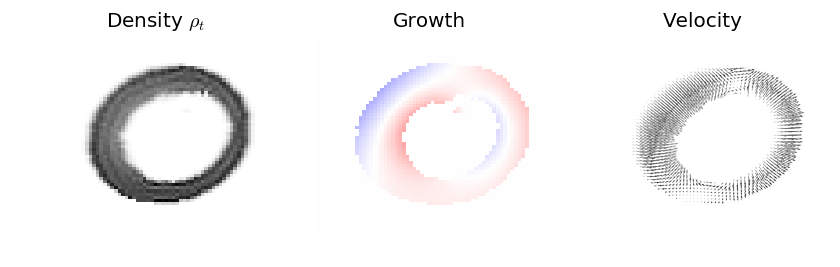

In [37]:
v,g = DynamicUOT.speedandgrowth(x)
X = linspace(0,1,x.cs[2]);
Y = linspace(0,1,x.cs[3]);
f = figure(figsize=[10,2.5])
@manipulate for t=1:T ; withfig(f) do
    subplot(1,3,1)
        pcolormesh(X,Y,x.V.D[1][t,:,:],cmap="gray_r");axis("off"); title(L"Density $\rho_t$")
    subplot(1,3,2)
        pcolormesh(X,Y,g[t,:,:],cmap="bwr",vmin=-2,vmax=2);axis("off");title("Growth")
    subplot(1,3,3)
        quiver(X,Y,x.V.D[3][t,:,:],x.V.D[2][t,:,:],x.V.D[1][t,:,:],cmap="gray_r");axis("off");title("Velocity")
    end
end